In [1]:
%matplotlib inline

In [2]:
import math 
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import random
from IPython import display
from base64 import b64decode

# Perlin Noise implementation in Python

## Author: Georgi Datskov

## Table of contents
1. [Introduction](#introduction)
    1. [2D examples](#2D_examples)
    2. [Realistic 3D-looking  Examples](#3D_look)
    3. [3D examples](#3D_examples)
2. [Theory](#theory)
    1. [1D Noise](#1d_noise)
        1[. Random noise](#rand_1d_noise)
        2[. Perlin noise](#per_1d_noise)
    2. [2D Noise](#2d_noise)
        1. [Random 2D noise](#rand_2d_noise)
        2. [Perlin 2D noise](#per_2d_noise)
        3. [Perlin 2D implementation (fail)](#fail)
    3. [3D Noise](#3d_noise)
3. [Implementation with Python libraries](#implementation)
    1. [Python and Conda Noise packages](#noise_packages)
    2. [PyVista package for Python](#pv)
    3. [Python Noise library modules](#modules)
    4. [Implementation examples with Perlin noise module](#module_implemenetation)
4. [Conclusions](#conclusions)
5. [Resources](#resources)
    

<a name="introduction"></a>
## Introduction

Perlin's noise is a function used in procedural texture generating random noise that results in a smooth, nature-looking picture. The function itself produces random, but smooth transition from one point to another. The result is fascinating.


<a name="2D examples"></a>
### 2D examples:

Different kinds of random noise:

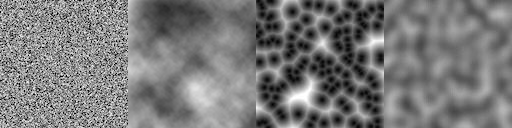

In [3]:
base64_data = "iVBORw0KGgoAAAANSUhEUgAAAgAAAACACAAAAABYPI7XAAAACXBIWXMAAAsTAAALEwB3nayOAAAQAElEQVR4nES8ZXSkV5YtGG/eetVmp53ptJ3MLCmVYmaGEFMwMzMzc0iKEDNjipOZnGC2q1zcVa9W96vu1zM9PWu9fzNzbmTPmm8tp9KpUCi+e/bdZ+9zzv0wTvvyT6uMPfNWW78e82D7+bOxla/U36kGZl39NwVbBcuCH7bo5eGvVp5vEDyuTx5cCFb1BY6V7LXTOq96tr8bnarEZEcrjT+we/8Fc/0v7VUYjHcEszcyNrHyOjww96l/78aXXibz1ZY6/x/ux++v32wvHc5uKfv6+VaTflSs1bE7f/n22d2dtfmJoVjE57TolFKxkM+mU8hEfE93G7autr6hsaER24RtrK+rr69vbGppaW5u78b1dHW0tba0tnX2kGhsDocvlivVOr1OpzcYdSq1wWTQaTVag8Xh8nq9bofN5nB7g9G+vr5o0ON02K0WswleojeaLef3/+qj40m5FbXFSV98+P57//DpibRSLFlu6x29/vT7718+vntjd3d3e+fmw73ZXpeOi2utLS0qKKyo7+LwyN3YupbmLjJb6QxHQ163NxDqH5le2bu1ORm0ytk9TdVF+YUFdW1t7WS+1OCKz60sjMf7gh6v3xcI2zQiPp/HFxGpLL5UY3Z4A5H+/t6Q3+0wayQ8Jo1MoVBpTJ5QptSZrTaLWa+TyflCFpPK4AgkSr3Z7nLZLSa0XgJ4F6lColDKRHwWhdjT1dWNp/MVOqvTF4EbjgTgLZV8NpUAa9aF7yGQSBQGk0Gj0xnowkzevG4pn3qm3bRyHg9/F8AM/l1jyx6/u125dBtzf+1hpfPsiGH9+6q1MS6rJc/5Qz9vdCE0/esJCkew/PCr+ek3dqY4tN2KGV5fHWHwfU8YllhEujvZ+2JNPtcm5zz9rqjH5b0R+cE4NrO1fWl0Uvu9VYgZvX59kcBZdJbvWK0/fPXgxsbS1FBfyOcwaxViHptJpxLxuJ7OtuaG6srKqqrqmurq6traqsqqmtq6+gYsFtvc3t7S0trUUFvf1N6NpzBZDLZAJBRJFBqdTqtWKpQavV6n1UJ8bU632+W02+3OBAB6w36P22m3mvRajUqlUmtN9pOfvvvJsXNXc8sKU45+uu/jDw+cSi/FkmSWvvHNJ6+/enBzbXFubm5mbmlnfTJiUzK7aovSU5JTc8uaSKSW2pLCior6dpJA73CatGqdweTwxyZWNldGPHohpaUy/1pS8rVCuIFWIk1hDo/PTvT7HSat3mAwWVV8KpFIINHoLJ4YBcsfjPRGw0G/w2pQijh0Khniz+AIJUqNwepw2G1mk1ItknC5LK5AotCaANHuBAAkIgCAWKZUqDVKmZjHIOO7u7txNK5UbbK5Q9FoNBL0OMwqIZtGIuB6CBQilQbvy+WwYdvAH2xMscg0obFQqS/Dwd0VnzVL65xeeCha9Cvvzf1vmsBzzQzGIKpv4Xt/MJjG2Y82q6tEu+PbCwo9Trfxemrt7sTXD3lp5lB4bBor2exmzG3OPXw4uLzdOdJR4hVHgl9tTM97fSOavfu/5mf2TSpwkuUdrP2rq3ffzH731ZSpfXLo66e3t1fnxuNhr8OiV4p5TAqJgO/p6mxvqq+pKi8rKy0pgT/KKivLS0rLq6urauob6huasMAHtVUVVfUtnd0EMoVM53DZbJ4IVkElk0hlchWwgd5oMpltdgdcCQAEwuGg12l3Ou0Wg0omFktkCrXRdvHo54eOHT+XUlCYdfH4kSOHj17MqWqlKmx907uPH9/eWJoYjsdjffGR6emRoFFEbClOO3Pk8Imk3NrOtoq81KS0jILqNrpUoxbzOXyhWGlw904uzQ84VBxcTV7yycOHL6RmZedVNHVwFO7YUK/LoBLzBSLAKpvQ0lBX19jGE0qVgENXMBQOhwI+j8WokQlYNAqZQmOw+RKFWmd2uADEDrveIFeJRHyhRK7WA7V5PA6rCXYMEAlAQq0F6lMrxVw6CdfTjSOzBHL4QX8oHAVuclo1Ei6DSqGQaWwGh8fliyUisUgkFAj4fMyN9NCz5d0e7c3hMMl7K+q+RVv47jlzq7S36o4oMOL05UaaGnAvBxen3V0Px29OSHcmXr8yBPgximOZEdZ//ctC+L4t3PXqBXlw9438N4PfLPzunqXLPeFlr3xDnR2pfnV/ZzJgMq8MYGycb1/oTSRe8o3Z47PjQ/82zmgo4jpKXj++eX1hajQWctvMeqWISyfiuro6O9qa6ioh/CXFhfn5+QVFxSWlwLxF5RUVlTW1cNXVVpWVlldU1mLbOjq7e3AkOpPBBATIVQq4N7FYqkLJwGAwIBIACrDBIvr8XpfdbLE57Ba9XMDlixIrmZN0+tgXBw5fyC0pzU1NTk66klmGxXF0rtjCrfs316ZHgLJh9T3BaHzAr+N21eddPrTvo4PnMqrbsIVpZ4+eOJ9a1EgSiAU0Io5ApnEkRs/g7EzcpmB2VWSc/fzjj06fPX8hObe6hSK0hiIujYhDJRDJFAaH0FxRlJdXXCWRqXRGq9MTDIWCfo/TbtChXUCjQvxZXOF/fhPymMdttmh0cjngVokA4PFBXBEAhHw+epnBYjUbtAoRmwYbvYdAY4tUOovb7wfUe5xWnVzAYcLFEQjEUqlcpVaolAqZVCIWYxzxV9EIMy280daT/dOihH0jMDFzt/3Jf93e0ommYss/Dtxdff71POP74ls3+DNfr7g37t/lP37Ao8aqYow7E2uRLbrW5rs1l0+qsv5xezxXZnuwgZGMmKo7bj2MKFYezVjaujQCpqvA66aNPhvXNTKD83rz5P9a6MCsu6NRkuLF/b11UAD9IZcVCE2EUlVHe0d7S2NNeQmEPy8nOysjIysnr7CoIC+/COigvAKAUVFZVlhQXF5R3dAEQqCjG0+m0ugMFkcok8NNCXkCmUqjNwDRw/o5UNK32mEbOWxmYF+zUa+RctlcvlCq0hrLMs4d+ujdA2cyS6qrSouLCvLLsd10qSUwvHr75tpUPOQwqBRyGVBFoNen43TW5l764sMPDpxNr2yuy7ly+KOPjl3MqcWz2ZTWhpo6bCuerrRExib7rXJGR3namc8+/OD4oYOfn7haiiXyTT6PQUDrbqqtrce249uq81IvX07NlaMQQzj9gUDA67QYtWqZkMuk01H8QdmoDMDk8E2/32ez64xKpVyhUutMdjcICZfNrAMGgJgqtAazDQjBoJbyGSQgUNgRPKnKYHe7fQEfiAW9UirkgeYQSuVqyI0mI1ocSJZyOSbc/XPUMKhWd46tP5T5ejybU8Phqek3m39cmOK+7pVO/KAivJkZGKTPy3LuTX83N3lDmbL1t5d+298371e+mZLP3ybM3Ywkn+mNYR7dJQQmJOsntuYdj/9y9+lK4+37vxsyBBemMHe0mb33fR7pSP2xlpMMi+vukHH3iW3FNY8Ju5/c3lqbHx/o9TvNOrVcwCATcR1tba3N2LrKksKC3Mz0jPSrkEmzcvPygAoKCosACLn58AX+r6Siuq4B29QMUhBPolCpVAZXJJVKgY3hq1xt0KshwmaL1Wo1mywOB/oK0kAtl0Ky5HC5QBhqfV3+lWOfvP/Z2eS86gYs/NYGCKJQ5+2d2bx5fSrut6rFHCaDzhUrLD63QYBrLEg59tmBwxezKrBVGecPvvMPh89l1fRQ8S1VxXn5xVWtBL7SFRvpAwborMy6eOSzA0f3v/fB5xfyagk8g9Mio3U3lufl5JfWtdYXXz1z5NCpKxBNAKfX7/X6vC6rQauSIxnEoKP4iwCh8MFBXIbCwYDdaTCp1Rot5DabG3Sk340CKwEulyp18DKkbbQKIZOM7+kEBDAFUpXRanW4XDaLSa8CtSiBva/Wm2AzOB02q8UI+0OjwWCGuncVZY7553/nPYjrJYTGn8LxZz/Jf3mGYXu2o3HrTWNz5Vw1a2KVdS84dlt860/DO4YNWu309u1bsR/NzK//kN3XH43wJjfcb+7derAam5SQh41zwQPqYXdV859vYcg7Azhai/xeHHM/3PPgWYODLnX9boAwP+fl9p/wjMoe39pcmRuLBd02I/AZl04m4DpbQeo3NdaUFeZnp6elX0u+dDkpNSMzJz8fQFCQl5ORnpGVC2AACqiqRrqwqa2jq4dAJFHobJ5QAgCA/S0QybValUqLlIDJbDKaLBajCQCghl/C4UHyAwjAEulbKrIuH9m3/+iFjIpmHJWMJ4F+0rv7x9b29uZifrOCRwVGasdR2XKL3SSjtlXkXDl75mJ6UUNbTealI598evJKXn0PsbU89xrazzUdNIExPBRz67j4+uL0i2fOnv78o0+OXMqrJnB1Fg2nu6kiJ+lSUkZJXVXuxcP7Pvr8FNq6LrfX5wF1akX7X8xnM+h0OpMN0g6xg93tD0d7e8Mhp9tk0Woh/gaT3RtMAMAKYgYCK1MbkNwFcaNXiVgIALAeFFAQah0gA4jBAM5IAdSh0ZutLo8XftbjcljNRoPRiCGO/yH5/lLFyorl1gdXphW02O3t0PzM4FDsoec2vsqu831na2OLFugvxu3OPmNMsVRM1D1afuVa3bRHt5cG+jjEH5YHyPO7kz/vrN/5UxxzfVP77SImcM++K/bsPdv8jQRjbOQGB72aG2vx39J+byyl5ytuura5GI01Ov5Ev/fo1ubi1Eif1wqAVAg5DAp8/NbmpubmxtqKkkJggPS0lCRIzclp2UACwAK5WRlpaRlZkBOKIB9Ugk+oBnfY3AoWh0xnsjgCMTKSTBZfIleC0odMALdpNBrAF+hNJp1KwqWDlXoLAInK0Fadn3riw3c+PHutvJ0uFLIFIORc0fH5nds7E0G7ho9vra2sqKhrJfK1FrOa3d1Ylp12LaOwqguPzUs9f+L0xbSSJjy+seDK6cOHT14pqCVxdKHhoaBNRG2tKcq4lpZ84osj568V1eE5aoOM2lKbc+X44WPnM0oqc85//sG7nx6zIKMCMYH420x6EJMCLigAcIAcIdrYNrsT2Zf+WCTs9lhsej2iAIPV7fcCAMAxqOWQyYHsLHY3xNRm1IhYJHx3R3tnJxGskUwFEDKBHtaq0GYwGC1Oly8YDEXCAQ+YY4vZYsEw8x+k3NE0TFfJKgUkjMb5cJ3ch8EYhQ1Cm/xn+W80FSNF8lilt9zct/zi0pnynZVOqWjGdXN4Zbbu/us/LlNG1jZNw83JuDre+j/yo1KnebNv+eVI1uro7vrgb63qlR2nu0Tdp1A/+xcB6+nuPy9jHi05v9mYwwQ2BBNbatPDhzevgwSIem0gYmVCDhNpgNbm5paWxrrq8qK8rPS0a1dTUoAErmbm5icAgERBRmZuYVFxcWlZWXl5RVVNTQ2kgtYuIrJOXIFQKODQGTyRWKZQyEFG6/WwbzRKhQrWTiMXMilE5Bo4bAQAPRlbmHpq/77PLqQUtrIVaqXeYPX0ji1ef7A7F/cZ+MTWqvyszKz8skaSRGezywjtDVUV5ZUNbQxSe3V+lql6eQAAEABJREFUelpafmENntpZkXfli3c/AilZj2OovX1Rl0EjIrc21lUW5yWfvZCaW9VKZ7FZDFJrZeaZT9776FBycV3epVNH9r/3K6fT5UaX3Wk36rQqqZjHYtIpVCZyh8DXEFh/KNLbHw8HfW672aCHezBaHEAZfr/XadYqAQBSsIVgFZ1O5KPB8OM6gELbu0AIguKTg2jQoOqIwYxSTcAf6e3ri/UDBLwucJcWzJtF5qxrsTjKEsYdA3OEbwMdy4LeJgwhfbovZ2Bo0Rr2WW6leWfeqFck2ZiRgftLjS2TwzOY6effvewPyCzP559P3W67v6Bb6Vb6lGMmg3wjgGFJIzWMztDKL26a5+5ScLkuOvTH+V6FraHx4c147M2Gt1d7gT46145RxC33dlYhA4R9LgvytOACQQO0wtXcUFdTUQw5IPXq1RRggCvJ6fmF+QCAvNwcEIaZ2XmgB4pLQBVWVFWWl1fV1DY0d4AUoLG4PL6Aw2DyhEIRCEKJXKWBbSIH3wf2UCFPZBkCmcFigWmQKjX09oq8lNMnz6fn1+FY4IvEMrXZG5tcuLU53etQg+8vTL107kJqXlUnR2H1mIQ0fHtrS2sXic8ittWWFxdX1bRSmd2VeecOvv/JkQu5dV0sncfv0Cm4LArsxKa6srzMvNLqpq4uHGiz9saKtNP7P9x36EpeTXFG0umDH30AAAB56nJaUHpSK6QiHovFoNFZAAC5GmJtd/mD4Ui01+/zOEHD6lF5IwEAH/yDWacCAMiUCQCACAAACLk0fGIHtXURKEwOVwj7QIkSIfqhAEBpcGRkZGxkoD8a8nvB4GB+mGC+8Bt5ffznX0d+u/xrL3NDt/zs75NrobGNG9zioTdOyaK95eXYY3/GojnsZpKNq/MD514/5Ydnbd/cw/V9c6PxleM7XWiEu9e2OrfhpXE4GPwEZmT1v8R+uLf770vLTzFbqysYTUdV36rbgrs+rE3u+9veX1/ceb4hdzompYSb6wtTI72hoM+uB0vDY5ARAyAJUFdTVVGcl3kt9Wrq1eSkpOSrGfmFefmFhQUIA9lZ2bmgAgtBFZaUV5aXlpSUllfWNLR24Smw1bg8LpsjEAqE4HWFIqlMKuQL+BzOW25g0qkkoAAmco3gqDg9DeDnU7Pzq9pJAL4eIpUjNXhjY1trk2GLjNJSknHu8IHPz6aXNlHEZr/HJBeyWUwmV6yWcmGrtWA7uql8Hq46/8LRg4dOXsqr6+aaXBY5j9XT3d3d04PDYWtr6sHw11fVN9RUVlWWZVw8ArYgJb+hprzg6slDh13oAp9iMOpBlcskQh6bjSwtmwcSQAsewOkNoMvtcoKYAwDoDEALoBpQhdOs1yjQFkca0G63W40ahYBLI3S2tSAEdOJIVBqsBrgdndHm8oV7Y0Mj49Ozs7Nz0xND8d5wEFCFway9nnePzQ32yrnkN6v3Q2Nr8QHt+u81sfV7q1ZP84+4jt8GR/8QDF3fst27s0k33bPWSfTPhsLm6BN/6es/MSdu4fhrzzR8k5BTPjaBFbF2rUOjo4GHDI9yamOe6HmGMWzcX/6TbqTk2fb4naXF0he6DRHn1l8jg9cf/K9T4/+2szwzPggSx+8wKCV8No3Y3dXZ1tRQX1dbXVFWlJt+LS09/VpKckpqelZubm5BCVi1ogIggdy3ZJCdV1QKiaA4Px8yAjBzD5EM9wwqTyiCqIvEQpB7oAlZTAaNAhuCwwJ9lTDZzMTKIADUl+deTcnMqmjraW+orq5vwTMlpkBsdXU6YpaSmwuvndz/3kfHU4sbSCKTz2uHrKtQKLVmp0kpZAOZ0NhihYjUUJKRdO78pWulzWShwaLhETsba6uqarA9YMq620H5Z2UXleSmZ+YX5WdcPnM2Ka+ys6W+Mu/qlWRPolRpteggScnBmIM2YbNZbDYH1XdVyN65PCAQ3Q4Q7makZEADgox3oR8DRtAplUqgeMCEDTwOfDgui0roam+DJNDa3oUjkskgeIRyncnli8SGx6dmZheXl5aWFmZGh2Ko8OjFYH7+Dwl9T8wM3LJTb6+MPVxu0MxtrSxQgzsYUfcAdrt+0TPzYyzyH48c4cmHuJM9q0vTvovTIdM3hat3NTrn44FvtgQjVlnBd3t2+pA83+5aYQ2tMIyB6iczm7vunvk7X+e8kHNX1n/4kfO91GUDQrBt0Ofv0ajD48KVLfqD7ZXZ0Xg0FPA6jArIAGRQsB1tTfWw/yvLSgpzwAVAxk+7BvHPzsrKLSwtKy0tLYadD9mgAARhZnaiSlSUmwMZoby+paOHQKIyWDyhOGGQ0R+wokw6mUTC40gMJp0GAEBVcCYqBECKZEAKSD55/OzlvPqm6kKAVUUzgaNyRWaWZiImKbWlKO3Ugfc/PnmtsJ4sNTttBrUMkorW7Ir4bXrUuBCrDAY5s6OuND8jPasYi+cIpAops6O2JBd8SwmWyOVQO2vyks9fuJZx5dTp5Cz4qOnpBTXNhJbKotyMjGyk/u2wtcGVy2USiQTwyuNykVERSaRypQaygM1us9mtVguKvx7SudmaqG/aE4yAjCHqaQA84E2UMh7soZ5OQEBra3tHN46AI1AYXKnW7Pb3DU/MzC8urV1fW1tbnp8aG4r1RUIBzPB9jx6jj1nGFhd+WApemJOKF/4cufGjbbpTMfrMbWcMOVnzvxBvC+Nv+iL+pCnPUIjegVn85cljTMEzfdTKxbu5s3oMkfno/lyG4IY4nKqYclG0yz87z/zs9cw6Xy78+8TfdVccu8//daGvKWvCv/CGjtn6KT6mNmW6V70Frp3rC2OxSMDjshvlkAGAvtrb25qxDbVVFWXIBWQgxZeVCc4Pgp1fXFpeAVd5WUkBpIOi/Jys7HwEgOKCgqLS8ur6ptZOHIFIZQMDQPBF8B+wPg+kJRFPwHXjqfTExQCdRQeQCAUCEaWp6NrpA/s+O5NWVpl/9UpScnZVG0VsCYzMzUbNCB45l459Ab6/BEtTGA1KEYtGZfIlYGGiYb8LImN2B1x6Ea2nobqstKqZwGCDgqMTGovTLp27nJpV1sRgELGFKacPHTxz+cSn+09cKYaMVVHf3t1dm51y+XJKBipPIfWvBDEnhZCLJBJRgr0gf4kAoMACOrj0iQv+YoBsbrXZbBYLeFsARMIWgpoHetBrQUMIeSzU9ulsb2/v6Ojs6ursASkgVJtcgf7R6fml5bXN7a3Nzesr8zPjwyAEIpjokmnKWh8hYwb+jbrTLSmrHH4zfN3y5KVsyD9zw9Q5/8IY/8lt7AzdXW3ivun7WY55rsF4Ns3BdsxCvXMc37FMYbQ8juC9N29EPWA3XzDGt6Zu39Ys7kRfVBo1xruSPnVAGfX6t3w6r5UpFQSfzE9yuavmVsoralt73eruxtLkYBTW0moABqD3gH5pbmltaaqvRgBAmj8zMxtUXxYSfgXFZRXVNVVwgUUsKiktzMuFFFCONAB8o66+vqERZAACAI8vROsnQRAQALHg8QRCD45IoSXiz2bS6GxUDODyyNiCqyf2fbDvdEp+Xsqpw4dPJRc29HD1nvjcQsyu5eOx5VkpV5KySuq7OEqNmE5ob2ps7Sbz5PZAfHgA9HR0aDRq14g5+K729h4KhLujsbEZW5576ciBw+dSCurxpO6azAuHPn738NnD77936EJuVUt7J55IwJZcPfXlFycvO+wWI2xcCVAVxF6uAu+KJKsI6Rc+3AQq30hQe0OhVKkBC0ZTorJlTRhbhAzD239A9U1AkQTEDpNGIZMIBDwOcACGsIdA5SoM7mBsfHZheWUdALC1vbG6ODsxMhjrjWBe/lGsty6/WL1472ZkwzBuZsf1f3z8cm3HazI6d5WS0tCaDVPIbPvzhiWimN87uDw7/Av/mA4zpt98RJp7PSGobSEq+SuY6O262B/kLMpdmVz+fPG2B/PZ9UCvYH4bi1lnicZWlWuv/xG/+IfBcu8T4a3flPUy2KvrQ8LZez7C7tri7Fg/6ljpwaJTu5sbGxqaWttaGmsrS4tRaTYvJzs7G3I+5PucglIIM6gD1CEsLwONACgoq6yuKi+vrK5twIJwrGlsw5HpbA6XL4AVhQ8jhW2OhD+RSCTgcHiQRXTQxiw6k8eDF/E4lCZkAz/afzY5K/3cwQ/fP3w+u6qdoXbEF1aGPWYZrbuhtCC/oKymmypUyRgdqEJdUd9G4igcA1OTo6Pj4/MLQz6zRspjMxgcHovSWldaXFZWkHnxwH9774vz+U1EKrE+58KXH/zXz88eef+9Ly9m1uAgRdFJ1YXJRz967+BZq8WoU4JK5bLBtEkUWpVOp1aplVLY/wIelycALcvnchGeJTIl8oAmM4TbYkH9To1W+xYQNhtqBEASkYq5qNEHEoJBp4Gm7epESoDEkmrdwfjE3OLy6sr1zc0EA0xDDgAdiJmIvdbc+XWr5tbY4OjL39ub8w3Te48GGuP8jZ1+jHG6ZP/wfCj4yhR3aUrUk+RF8/ib2snJU3GZsd8oKVg1fM6NX2zGmSffLLi2H/2ueuD20OneJzQP4Zb47pPQq1tjE6N3lb4B/W8UpMnXm+dOra7ubeJtJZNLRXrdDyqlJarYW1uYHY+HfQ6TVilmU3ragf4bW1pbmxCngrpDsh/EHiRnVPorq65vbKyvBdtfX1tdXVEKG7+iqrqqsrIKVQJAeFXWYDsJYAVB8AtRipeh+QIOnUIGEUDEdQMf0oAAuBwwgVz0lUlvL89JPnXsZGpm2pmD+z5454uzWdUdTLWjb3lrMug2igGS9TW1LTiCSCdnEZpKs9LSsgqr2ilCS2RobufW9t72+sJ41GlUgRZTCfBNVflpaZlZ2TlnP//wk2NXCupodEJ9furZQ5+fTjr/5cHTaaU17UyVlttZU3Dl8EfvHzwNyl0uhl1LZwAlSZQayOeQ7Q16EARCLvIzHDaLwUC0hSrXOv3baINlUIEWVWv1/6kH7CZURZYm8p4EJRPADYeBPHV7B47MECptnujw5OzC0tLy6vr62vLizOToULwPAHB1YtXx60klx3n7xtz5rTkMfn4Se/OnOAs3p73x7PXeo501zmCZ3/XfHJJJr2WMPDgUG46NcoZaNtcerBftTosWXZjbPyzd/rOz/dj6V8NnUcNtVXNYE936w92cR7PMh9/1uyNP9q40qNn9Xw+SN6RdwQfm1Z9xy1rm7c7tCQLp5sbS1Egs4rWhNiiTAukLIIBtbmkGCgCHDywAPACpIK+wBPWAahubm+rrG7FYbGM96ETQA5WVFZUoKQACGuqAG+qaO0kMvgR4Ey4w/6g1wGLQqRRSok1GoSMBmGiHo5I7jYOrK8lKSU7NyU4+/NGH+z45fimvtpOlccaXt5dGog5I+iRcVxeRydcYJZS2yuwr585cSi9q7GFrfAPzN27vbK4tTI/GI6iyZlZzuuqLUs+cOnclPS/p5BeHz6WVYSlUXF1e8onPPjuVknr5QlJ6BbS6hAIAABAASURBVJYo1OkF+Pri1FOfHzyZjFr6Ag6DRqWzEn7NbIGAgipUofkO2PogV4DRyWQ0HICaflaIuBWp/4T/0+pt9sTIg8Nk1KkUSEVKZQpUAU0AiEkl9XShzhBfbnIEYyMT07Mzs/OLiwtzsxNjQ/H+SMCH4T9+9U2MYtl4Kt15dXdwO+4aKev3WMKbe4MYmk7++p5bYPtuuXjuTbR65K5R07/JuB/DYL65ud07sfsN8XRvFIONzz1Vr8TCaoNiYTI0Mr9qZv+aZI4em7RTo6/vPC/EdC3/xunG94fF9BHL7XjuK4kmvFP/w25BJu/Jhn9hd2NhbKA/7LGiYQAWg0om4sAGNiUKAdXVYPHRhTqBoJ5QkBE0GpvA54JOrKlOQKAckUB1DZoYqquFV3QQmSKlChZIKgbelCN+RdsI7D8BjyfRYK2ZbBYLrBaDQiJJGJ0NlcVFpZWFSZ9/sO/QyYtppVg83+CJz6xvLI2HrCYVpGe+SKGzmoS4+vyU458fOHwpp7qVIXf0L+ztrc9PDfVH4ervDTlVjNbqrHOfffzZydTCnKsXL10rqOugU7urs85/8eHHR5Jzi+BqwPHVRp2Q3FKdl3LuTFKOFswvi04G98rkCuUag93pQSUeBzh82MU8HvKv6IOjySGxXGuE+NutJp0GaUawI4nX+71ul9moUytQVRBNRkFeMOgT74x6g/Cz4ANM7lD/wPDo8Oj45OTE+NjwYLwvEvQ4MR3qx/HxZ4OxxcEf4rsG3tzz10+5E9ty7W+q4yOCz+z+IIGPX5e3v/SqbDqHaEw3dzssvF2qXb11PRQRGboLfPces/wuKp/qvPPdTv+Iw6Xc6Q4alTHMzG9XOA9VDwzT92+NaL9acFE138f+D9l15uOF7aBP29S76g8tqZYEG8tTQ33RoMuslQsA8CDYAQLtLU0gBRpBCFaUl4PkLywoBP1fWV0P1IAaRc0tbZAjIAtUVpSVlQMDVNfWN6ALi5oCPRSOVKPTwIaQypSoVooUFh+SNBUoEawxyHQ0DMVk0Uh4vJxPw3c0Yxsby64ePfDFmaTMovouusToDsen1zYWh6M+O4htnd5ksuj5PbU5V778+P0DZ7OqmlkyW//cxsrUQNRjRVnYFwg4lRRsRfqpfe9+dCSlqKwoL6+opp0oYHZVpp0+8N6HX17Oq6xvaulmqwxaOYfcia0syk7PKVGh8Q8yAT4WgwMwM7s8gVA46POioRU07QM8RSMDAHAkAIhMY0KMbzVp1UBuiWaRHRX3A153AgAgH1Hp4G3v22pUSwVcBoVAIJBZQoXWgrpKfb39A4NDg0Dk/b2RoNdhxZRdfvD67oNvdLWd97c6e2yhojv/zvR7tIG+e31P740HG2bXTbwTO68IvZ4+y8pqFKP7qy4yXis2f2CyvPhz+NbeVrNfcP8Pw8J7Nv2dqaq5xSGzZ+tcPLAYUuL+1cT53rZFxz8RVvf/Td6jvxeKfTVlnn8W2nl2I773bVg/2NhPXZkd7Q/5PXajCgQseDcB8mzdbU0omI01lW89X3Ex8H9ZRVV9YiSwBRU52pqw2HoEgFJQgUgBNjWhYTGkeQg0rgwV/+UymVKLSmVyCRp/4UIioLy1AlQ0cEenkfE9PTwuygRkQkt1btK588mZlfUdRAZfrnX6YrPXN5emh6Nel82g1ao1Ch6xIffK4U8/PHg+u7qFLbPHZhcn+z1WrUwilkg0JodNRcOWZZw7uG//sZRCAGRdQzuZpeB0VmaeR9W/K5lFtR1EskirETEIXS2N9QDg2iaFhItSdTeOSAMA6C0ubzCKZsOcFj3K6UACiKgI+B4inSOQac12h9NpM2lVkOxFUpXeZHf5EWA8FhOqJCoUbwchA2i6BNZUKuKinybS0dwZKgb7/aFob29ffywaCQV8LqsJ49XccasWHyume4cizXMvhxpLnYPmi33//rxtyOd8vLl1sXhIzd5csVfrpYLCXol28/XPDvmmgUcND17/j076/dHSOQxlz9uOWXxs241FJTu0ynFH/2XieJV4TBuccG5G1OFe+kg4X0neYEbHJ+6wzHPK3lvPVrW4nxzTTceXpgajPqfNalCiUR6pQi7h0Um4jpYmiGhjHeSA8rLSUtjlaAyksqYR/hX2fyuaGGgGnYimhipg+2ObES0AOFo7cAQSnStVw+pBNlSDpkYFViSpUV8flDGeRKcD9YMqJKBybSeYBq5YzCe01ZQW5BWWN7W0dXThqUyNNTC8sre7PjcUdBplPNCLHCapueja2aNfnkguqOvkyJ0D05Mxv04hQNUl1EQ2azltVbkpp4+fOJ9e3NZDxBPoQrma211fkn7lwtnzFy5fK2zsIvAUYmp7fVVpCSpb4alyMYeGRji68VTYpgaL0xvqi8V6o77EcIBCLgZjTyMhBqCjih4AwOVymHXqxByASm92uAPhSDjgs1uBAtSo4evw+ILR/r5oyGPTK2VCUMBEApXNT0yNWO12N3BVMNwLrOFB/UfMTHiYIvBVJ23exAd7f8f03ji7Yckk37m+890AURycZJtiRqr97uZ0oXBhLhKyuPWYIBWzvTdJmJhoxC0O6ORcw9I/UG1VW/MdmLvjl0bkvI3wz5j5OYyl0np98pb6vrerRNO/prv/Ty/1o08Xim7/ZdNf7nrh7vcy/vu9mY3ShXE0DQa+VilBAwvggoVMMhF1BLENoAIgwiVFJeUg8uBvFVW1iclgFP8W1DAEL1iGyj8taIYIaKG9DbVAaCyBDFZOhLophsTki1wG64h0AGhBCo3JIIMnJPR0doJNLqvBgqSXSagddZVlJRV1ddXlJWW1rT1cjSs6vXtjdbLPrhXTutva28C9d9YUZaQkXcutaCUJtf6RiQGvRcwhdsCvbsXThBqtmNRckZ+emppZXIdngY2XG6zgI7oaSzKvnTv+5eGzaYUVTSQeq6umICM1Ja2wtp3MlQlZSPl2duHITAEwgNMbjg0OxmPhoBc1//RKOUgjGhm1LzgiNA0Mms9pNWiAdsQytcHi9oUSjIGmCVCZ0GSHHBKJDQ3EeiGv6lQiHhPwQwaPIZarNLAe8A5OoAjUWwLW0GD++H8OLSzg8IPDkZnRl9du/Z4VWpZ5I2PfRV7eijzEhTfHHoa+ezE69HiJO0Syfz85OiX4ZzNmdbJmlWOWtt+Z2BlbCfXlf//E9vjnsGA1ZO6yDeyMDz24Kd+6e4A+HFIs96R9KorV4DZDc//XjufpH9/wiD8PDJjnR1mzdtnMuHb37TAIAECFFKxcoVSIWLBPu9uaYf9D3MtBABSVI+NfmXD7tbX1/wmA5pbGGmCHirrm9s7unq62VvgCkhfulS+WJQSgUm8EOWQCw6wCBIDpZ9GpoACR5kKDpx1o8CiroLSqlS4Q9DQU52VnFVQW515LTitq6CLKbL6Rze25fpdKQOtsqCkvq27D41obSgsLiisacCylpXdiLGxWccmtsJtLy5s6aBKNgoXDVpUUFZXWd1JFapXS6PI7VFxaV1V22pFP3vnwyJW09Ip2OqW1NO3i+dNnUgrqcSypgEnGd3d2ABMx+WiQ0xuJDw8PDaAdbDebLQktx2bQyBQ6R6wyWAAAHpfNqEWWT6Y2WryBcB9s94jP47CYUE3A6Q9F+gZGhgf7w17IXQAfSHAkcJkCsUwBVlVnssCLvG6nDdWOVBjpoG/5h+uYxVH52iRGH7V+9RVu6IZpZPTI2Nce3qpvJ6oc+tvXnL/N2Xon3DsPVzYvOO4GxE4rySM0/Hl6si5iYb0RzP/ZlV059PsJW8doD/+fVBNhtQuvuUafCWJ2b10i3BTZ93Y6O4KubfOmlFnqHyMovu5fFozdv9O4Ovevc2PxaMBlQ30M0LUyuVKOpuKJXW0tTQ1g6yvLiwvyiypA49dWVSQ6/zV1CSXYAqmgsQY0YlVDe3cPjoCDTdSDwxPIaCpIlLDDoKlBu9ksRoNBpwYdADKAmSgDU8gk4P/OthZsfd3FpNTceiKN2FyWdvHMmSsZOZdPnLiYXlTdydU54ktLo2GblNZZV5SZk55R0tiJJ7dg6+paCByJ2Tc8M+pVCSmtZTlpV9OyixvxLKVZzcK1Y+sbWggMNnhPtlitdzmNQnJzYdLxj9774uiXpzKKmwi4+rzLJw4ePHoxq6KTIeQxwGd2dHTjKSyh0mBz+noHR0ZHRwdjvSGf2+mwm3UIAWhETCBVG62JAVGHSYu2ilxtcviCfQNI0IcDHqcdBILdHYj0D45ODA/GokG31SAXc2kkIpH0dsYMmUS1Fs0GWN/2HxQY7fePmjBSlqdkt4HADeNrY7dGFaO/7pDLL82ZMPcmIhjXYASC5U97uJFtcbUtPl+NSVcmZr+Kjj7ZHi0b4g/8or1DHZbYKzYplyM//GSdFU5KzdN7nl8ImHtTjucPeumzi52YJ98bZD6D6uNg7y1mwXX7tynLhr57s+Ebk4PzqDEZcJje5moJcLdUxKGiucC2VggwJIDCwtKqWlT/q6iEDJCo9zY2Qc5vQpU/QEZTJw6PB0onoDl7KoPFQdOPXIEY7lRvtIBpgp0BWEd2IGEIkeeiUlCXDltXW/vliUuZ1T0UYnV+Epj1kykpJ/Z/evhiTkUnW22LLS4MB8xCQlNZxpUL5y5nVzXjkJdEdRWdMzg4PuhWcrvq8lLOnjx7JauynSoz60B2k4kkCo2Bx3V34ekCqQVIgthannXlyKf7P/340JX8Blx3Xc7FY+9/+NnptLIOBp8Dkge0CEgTrlhpsDq80YGR0bGx0ZHB/mgo4Pei0zISARpfgSxucaBBAK/TjLqASqUWTX73D0KwgTAALk4X6vn3DwyNTQwPgMt3WQwKCY9BISdOGbA4qMMAaVaNZqPA24BRkmNm/a+W5l/p5Av6wTXxcgTTj7E6k4fpI19FcuxnnvxGWpIe9/ffcy6o6K57gtpJp0k/VfooJH7S1rcyqpsf67SNLRttTx8+jRQNep1/EfePkR50pY/7h1cwQu3290/dFP/iZHmZ+dXvPOFlR2QkuCBr2Pv68cDqUQy5Z0h7PbQ4NTY6GPWYNCqwbWKhEIQAAkBne1t7K7amvLQoP7+wtLIGIl9TXQfGAKIPEAC539rU2IgF+9bUBgkgMRNKo5KpTDabw+OBn0Tj9pASE2UVmw1AgM6CwG/gMylEMN00KgnX2VxfV/fOgTPpFW14fGn2xc/ffefzi5cOvf/Op6cyKzqZcktscX7QqWV31uRdObn/4PGUwroeZqJDo9JoLa5gX9QpZzZXpJ/5fN9nx64WYokirRo8HYlEpRK6gL6q6ttJTI1CQOlqqSnNTTm5/70PDl3KrevpRgzw4UcHz6bDb2GjRhUgmExjww4HCe+NDIyMTYBXHxuBuPaG0bQsIIAnAEljtHv8/kDA77YatRq1SmO0uQKR2PDoyNAAOlXkBXQEI32xgaGR0cF4b9jnNOuVUgGbToP7pdGZaGngfSQydAN62/SkAAAQAElEQVRaWA+5VIJpsv7PgGGepBT1aGY3rgu1Q+Nt0zNLgYInqt5//+Pizljd+P3fLng1zqBp5fZ3e5KNxzhic2D81dN0TN2gSV34YhAzISaO/t7u6N/WjJhXn06L2Ef0DKLuZrVlQO53q6eG2u7+q1zq6I/7NNd1G7PDz4yBN7y/vVofd/pX5Hr24szkxGg8YNWpVWgchsMDJ8imkxBBNzdUlRXnZ2flFpVV1YHJb2xub28GH9CIot7R0YJtApC0dnShs1AUBpPJYjFZbNgqfAEgXQwAMJrNJmuine5y2K0I81rQ7LAfYDXoYDZbsQ0N7352LrMUskhl7sUv3n/vy0vJxz/56OC5nOouuswaX5gdsKkY7VVZ5w+/89GhS9lVPVwtOoAj4HFFCoPDa5dRseXppz559+Mvr+RjiVwxj9LWVFff2oGtKMrJyCqqaSOKueT2huoKcBhXj376+fm0gkYisaX02oXjx89eLajFQXDIBDyBSKKx+BKF1ojOc8VHxqdmpqcAAsODA70ht1UPdk6IXL8lMdEXAv+emA0Cz+AJ9Q6Mjo8DWOJ94RB8E6x+LB4fBEREEy9DU8Ysxtu6B5vD5SXGYkSQCeCC+IswtzETTIxK/Nhz7tmTtQeLfxsaUg5IKd9/Rtmc+Ld/2lou3ptbePAGPsXU2OopzJypvPKD2Y3zrtHvJ3Rh0qwVc4+xtjhAOB28L1r+vX7nQVJ8e205Nu6XdDefUo+MCfXkJcdc7MbeqcXrM7gx5foPY6b2oG15euvP0ZWRv//vc1kzywszk6ODEZdZ/3YimiMUguah4LvaIUNXlRXlZWVk5xeX18Cuh1h3QsTb0Mwoahq3tnUi9Yzr6e4h0hJ3B9QPCQC1eRPrBXLHYnP7gUffNt3NoDTAdtNodHQ4jozMZtOhk1cyC8rqWhuLkk58eehMSsbF40dPJ0FoWErX4Nxkn0PL6arJPnfovY+PXMoq7+Lo1WIWmYDDERgirc0mo7RUZZ07+OH+o1fym8lMOq6lpiwvp7S2qiDt4umLqBLIobTXFGZnZmUV5CWdvpCeX9pKo3XVFqSlXk0vqGom86kgSAmQM9AMoMZgho+LBjdm5mfhmp4YRVVyu1EDewMdY7G6A6Ewcn0gmoxI0Hv8kb7BMVTaGx6KgxSMRKO9/bFYLD7YF307RKhGJwLYLCY7cRaMy02sEkoF4relcszQTmD2+aZgleJ78WTKlL883XnLrpxcN0fiKdfnb3uCrwZ01OnbnuEXg8FpT4b3Mc89/FNv79MTGor7dvAJXRi2PSbGpmOThOnrmDUbUdQ70+++JdyQN71zsMU39KRD8Nt7HbODmP6FO+MW2cDk4o3fLUj/x3+PYuO9kg2h90PD2vL85OhQLOgCVkNdMT58OD7rbU8A3HJBTlYmmgOpQCN/XWjKqru7C03ltba2d8HfwfWTIPuTaUzIcKiPzhehOTA+TyTXAQFYnWCKw2B5UY8CNLIJfgcf1BlYQjqF0AXvknT5SkpqRlFtc0XW1StXruUUpCcnpWaVNpAFxsDgWMzn0PLwjQWXjx08dOZqXlU3RyWidwENNTfjmGKdRUHvrC9IOXX4+IVrJe0Ucmd9eXFuyoWrBYWZFw4fOHw+rbSJBvYi9dyps0lZhflZ2UXl9XgucEItMhPVzTi2AgweiYL6ABIVfGAr2PRQ38DY9PzC4uIi7A10YgJsv0ohlgI+bJ7EfGA0CJIflI3F6Qv1xobGJ4EtRpEQ6EU1nng81t8fC/oR5pHOV0jFaAoeXVy44AsnsVkABKAJMSEf9ZgCY92YuWWQ5a0t9vfNDO3eyPv1m0cbTpNEHry/d3cmMCuJ/7hmUfIqMf3fz389yTff3oveD2HmhL5M9ldqHz+0+yBddXFjMNxfGF/ZqLdvbBz3Lu1Er8v7Jpc1Gz8+2T0qDa3c4IYp/LF4vOOr/vyRSO8DgaTNEVv6+vrK3PjQYKIbYEz0s1D4QBiBT2tvBADkZmdmZCEKwLZB9HuQ2gN2gMi1deFB9UHowdpBfmMhlSQB7ydHg1UiUEw6s8WCcmYoGvZ5/W4bLBg6ZKuR8XkCARfMEWrhd2QlnT5+4mxaSVNdZVlhfnF1TVlhUUllUw9L4eqN97oMajET31qVnXTp8rX8qhaKSEDvrCkuKCwuw/ZQJQatiNhamZ+ekppVUt9D6qzOz0y+dPzgsZTM1JOfvrf/ZHJhI6m9OvfCF58eOJWUX1VTXd/Sw1Eq+LSeNmxjUyeJpTCTQDIwE/N/JlTmd7g8gXD/0MTM/AIa3JoY6494wPRBFOXwCocvBJu8txcd9wMdD5Yv0hcf/v8AEO9PIKCvNxIMBl12NCKk06jBjQLZy2UyqQQVj1D8ISUwgQ14QolciRkevRYzhIVfrk41kRtUkhrdinideTv0iTx2o4HJm73B5G6Le78ffHh3n+bbqHs9nraIebymWXwzsrt5Q2wZd90fua7p4fge38ds/JxVFf16N/Bo58W8zEDYCUgqnfvuf6u59WorahmafZzVVB6fmTeU9GAiG6q+Yu+669HiPd/G8szo4MDgIHAAMiaoZsPn8jk0MpnY2VhZVlyYl52RlVdUVtsCYh+kPolMQSNP4PlxBAqNRkGyj4XmQHlowgu5HE3ihuUgAawOl9cHqrgvHAx6bBY0VQWLooKVQOURQncnXDkXv9y///DlvMam1pbairo2sAb12FYim6cLxPu9eimHDr+uqSI/N6ewqgXPVTLxDYVpyUnJWWWNnSydSc3obqgsKSwqa+oiE5vyr14+dnT/+59dSr92Yt87n5xIKsTiWyqyz3zy7vuHz+Y0drR3kZlys0klZIENITN4MqOXSCLTuRJ0ts+BhkMdqI4biY9OzczOz88CN0bQeWLYGHBjejMEHAAAyhAAgKbEnIFoPwLA5P8PAEgQQS+8ESwmOiqtUqs1SPBpdUg1KpUKAACbAZIQrZlAolRjApBrlAub3l9L6veGHk0Zp7uuPxn5Xj/+PSEyPN3yYs6JOWUPjiiYXfolD14xG3s9rTXaRqz+8UcL5DNPHmVM/Mmv9hP9Fr9n7KYIQ//p/JDf8B9/fTXpdGC+kylbubqZ5q82fv7t1l5Qc3cdM//YdntLuDBHxKw80Xz/csas2l6ZBcsCoiXqc1gtkO3QsS0+OhxB6MDWVFWUlxTkohRQ19TRQyAjP0Ml4RH3k8ggnNl0OgfYDeWNRFZLeBwkcOGuIUW6vP5guC8ei4RCPgdqo1ntNsgCCjly1qTuTsgpWef2v/vewYu5tR0kYg+OREFVNwKJLTP5BgYDeiGrpwVsJ7alExxHM54nU1BbyvKSjx85nZxd2cGQGuxyZk9bU31jG45G76rOPv/lvo/f/+Dg+WsZ5459iU4btdBbSrLOH3j/o5OAMSKbz1eaPH6XXiZEp5NVZm+ESmfzJSok53w+j8vlsttQKTc+Pj49Oz05PtTvddmMarlYhDKAxelFKSCKJuisNuAAh8ePJn1HwDcOIyMQjaA5T9QIMiXCjcKvQ0dkIfshPlDDzpDwWTQKBRVEOQKpSofZHYkuaoXPx17HqmWYe9+OuFdeTLJGDT2MiVnHoIndwopvTyjEPPPew1js1tKvh/oilddHjb+j3guMrGBuSHj0Pfk4r2VjV78+PuEajT5Lmb3R+XBDe9H613Y53pjz3IKbeIITbQYwvp7du5s/xfz/+FLGVxHw6jKDfku+dnxvfREQMDgYj/qdtrfHXSFVcZig0dqwDfW1NdUVJWjqp66hpRudbQdDg3ojeCIIeRYAhYWGZmBLo3yWaP8q1DoD6t9BPnWgOmlffDAGnAgp0ekAhkVlVJVSJuCwqASQFPhLJ7848NmRpPwGPJfPBiXJpDO4QqnWag/Eeh0yOqGpGo2b1TahySq+UiWjohnCTz/af+5aaStVbHQZZRxQEyBCOfT2iqzzh97ft//AoQuZBdcunU2IQEZ7ZcHVE4ePn08tbiYLlDp7ID7U77ebzWaLzRUanEB1y8TDHPzBxFENIHb42NGh4fGJ8dHhWNiVaOkIBSIIlgkyWhCSQMgPALC+BUCkb2BoaGh4eCDe3ws2AB36stvMBm1iXgAhADYCOn3k/M/HIigSAICdRGVyhDK1HvNrm2jTKH4a7K0ka1j+muO0Zvzq3b/6e6zflNWyTMz+6a6b1ntVL0dAMVjsW0HpHX185PZeiPZ1q3N47avctYEdy9gqhi68edezZZ6NSeJTlgyzH3v/d4sTHUPzlO2tuTbJytDi+iwpnLp7DxMdmpjbfKoU3hiNL+gHtLcwNzZXFmfGQMICrB0gAxQiAdLyYKe7W5uaUFe4vrY2Uf1p6SRSwewx6Ax0A0D9HL5IwAHpB4ofchzsfQAPAAAdgLOi5QX/B+sTGxwGLxXw+8AKoDMYaHVUcpGAx6QAjvCfH/zi6MkL6cWNJJEEjY51dvQwYGEMILi9em5PS3luasq1rOJqPI2vMNl0YkpTQfLRD9/98ERySQtZbAm6TSqZBD2cQkRtKk0/+8WvPj168mxqcU1lYXZeaV0Hidxcmn35+JGTlzMq2qgSazAyND0/PdwXCcFWjo3NryEe1ls9AeD2kM9ps5gN6Jyfv7cfSDHWF/LajEoRF4m2xIcCSgsEQwGf2wkGx2wByYh8fzweH4DMH0rcI+x+VPVCGh/8vlqL2geAG5/37cEShVTAAucByhONi2uNGHZAIRMaftywbdekYpRzXTsc6/P/ub7s3NkgEG7e2V6zjd/ZdQ0ODs4vv3qi9vUuL8nWh1TjYUn/izH7Q+bMDw9WdrrWbvwXl4bSp/mrz8nd+2ZrDbswPjIvX9sZbrgz3TF68979ra/HKLS7PJqqQ3V3dNu9sPy6a1d6e+ObOw++3tteX5qdHOmPBP0+VN9QSoTo3B6aZWlHWr+lpfVt4b8V9XkYLLRLWXQaqBieQCwV8yHzoxtF/Vq9Rvb2FAx4f7fL6QkEAiEwRUNjowMRvy8QDAbQCTy7DU1hSUSJB9EQcB9+8MmxyxnFNR10IY/cVltWXlrZQqAyWBK12aJmdaBpHtD4WWUdFLHJ6zNJqK0l105/8dmXp69VtFMkjj4Q6RYTUKxeTKgvunp8/68OnL6SXlLf3FBRWASSgoBrKEg+/um+A+fTK9upUldsdG596/rC9MTY2MTk7Mr2LaFUBe4OPmcfKtxYUX1WZ7K6/OFe2NFBj12vErPRIDuLK1bqzA6Px+vzeeEuTCb4rVYU2ggo/35UC4YUknj6BeBbkhgrhiQDzhI1gcEJQWpArgBcEJNCJKCaeaL9jPlxzmPZXZz85/GhGouZHTk5uHcd85u//cvzGcn9wMuH/RGH7NaK8af7u5OYijVVq1Z2caj3hcp+sLkpZor9YXPiFubl0yPBsVJecG99e5pzU6CUW1Y9SgNjbnlNs23oX8Ieic5T+vyW1V7MHf7I8srgzEzYxP5DWNpR9q1m49XKztbajzftQAAAEABJREFU/PTEUG/A5wMAAHVJUeMODUGg54R0diPhT0TeDxw/MAA69MHnvnUxaPgtcfYLcG40aDU6EBAglYyQ+31g/X3hSKQ3Pjg0OjGO3h456ES51OkwwwtFPBadSib0fPbxvuPXShvaqBw+raOmIC0rI6cc29bRTWRKNUpWa0XG2f3vf3z0anE9Tmh0ey0KWld1bvK5sxeScuu6aVJn/+RoHHZzOGgQ4uqLUo5+8sHB09dKGluwZTlXU9JzKxq7GwuvHP74g49PpSYA07+wcffRg5vbG+vXN7d27zz5Sq7SW1z+aCzWn6jcGcDxQQ6zunyJLr/dqIQsSyaRyDSWUK4x2pwOpytxkAQNietNNpAOgXDiQTB+bwLcb2eMhSCkhah0gMDkDQTDUTQg4AAAoNIwGY/rScwfKA1WzJvXdzGqr64Mr8gmv71N4VDvKH95MTq1zR7TOP/pz4uUcaHzzrP4xj9tKG5ixLN3Zh5svmoKRn0PrSvC7axpX4faP0CXq7P7ftzeWeCbg/Ttm7d0aepK/Mu/YO4NhR69ibzokE2z1LKnu/01S/cO3AouydnkGcV0P9k+GO0fvLmxub44A1on9Ja9DBqFVIKGGMhE0PtkApFKp9KYDCqFSsLhSKiAw+KiUoFYKpNJEgNf6HkJegi6UYtUj1KpRieqYWP4/cFof2xgeHRsYmJsqC+MmuCRSNDrdrvsJgQADgPUJK7n/PGjF7IrsO1kMr61riT94vnzSbllVXXYpm6WTM5sLk47te+dDw4lFdT38BQ6o07JIjaX56RdS8uraCVyVJ7Y4uLcxNjoYK9JRGguTz996POj57NqO5qrcpJOHjt9JaeitaE45fjBg1+cTa/qpEkdvYvbj169fv7owb37Dx89ffndzxoD5H+w/jFUubOj6KHjIMYEhtEnFfGZqO6EJ9N5ksTzomyJoVCDGl0QXqcL6QLU3U8Yv8ThEDTEluj8KLRGoxWdLu1LnAZFHWOZiEsj4kD9EKhsIQJAJ7YpELjNJnqW6FhMdvinxZu8m8qXjQqnued577b8zcq8PS50jmiGf9gMrI5t3fP8bnTyp1dDhu9Hh6c2xeu9e+aIVr94PPDL0vrcX9YuDovLnLw1v/7/eTz8413dWltrOVP3J8yYtXsdD2LBEd77M3fm29/cmfglvPIYU3Pnj+3raD41HvG53YkjEhqFXIoeaEQiEihMNhOIHhUvuBxkXdBIPxP1eoTo1JRKhsqjCpTljEYQuXoNMEFiIsIGZho2fLR/YHBkbByuEdRcTSAg7Pei7grYaiGbQYWF6Mq4lpqRk1dSDZxdlJ918dD+z0+lZGZl51dhCTwxq7U888KXB744da2olQQCkc0XCliE5pqK8rL6VgJbZo2Orm3tbq4vjUUdSnpXfUFq0sWkjJLm7qay9HOf7//ibGZFC7Yy+9KZsxdSCxrxHLUnNrf17Mff/Pz9t2++/vb7H3/501/NNpcvGI0NoglNtwUyIJKzci2a6nKiJ4DwWBQ8sF+iWYhGwFDuR492QKVcxdvHPYDXhd3vQO1ddMAMlVJARwlRZtSDpPSFIEnEQkGf22bSaSSCxPPC3r4hSgETSubU5n3zYnBkQy4cdSzFRgMjZYHJ/tzhiG+NVfIw4vG92Fxo+9WEcfpWF2ZtbuFrjfFRH/b6dKT4/97cs96g+2Y03u75rxbCe4NB6rZ9nrPMt5g091YnSjpyFLPL4mtKr9OF+WvEPxfZXn/2mOO5+/PK2OL6lB1zVa8xR5dnJsZH+gPuxPFmO3g0OXqeEahUsMciMZpxlgiEUjQuhh6cgEw/R4AOvGo0IPnQ/IA6cVwSjddrtbAAIKHQE6FA/oP6GxkdHwOTNBSDHBkMoHPxaFLKgI7UitDILL6zNbeguCgzOTWnqjgrLSP15MfvfHzscvKlS1eKq9oZQk53XV7KmVPnknLKu2lMYnsHgfb/EvXeYXGnSZpgPjc72+WrpJJKKnmPDEhIQhhhJEBY4b33CSRkkqS3pCe9956EhITEeycQEvIlqVSl8q67p6vNdPf07M7szNzu7T3P3Rc/au7yn1IJJSS/L76INyLeeINK7miorCgvRTGit0/rGV7eevzo3uqoXcvvaiy5lZwUl5SeV1lblH7xyHtvvn/kSnpVVfGtuKsxscmZpU2kPoNnbPXlr//4h5//4adf//Z3v//Hf/5XmRxwnMPltJm0ciEbxhiQCSAAIgPMxqYS8A1V5SCA0YCHeWGuSCSEESAWDV5MLjS8d9RvgCrMhdmQXvQtSEQiGXlHtkCqUOuhPmzRgD9Blg9ScnXVVVVVyABIdL4IR5gRUzJJq69HuhJxzIW1MG60P4OspuAm9Wkdfo6MSLMs/hygT4YNf5VTFofD07XWyvHBiqlvdBvGsQqHe6hg2T9EV+PuVNfOGEIZ65Mrdf2Lkv43Oljr201+x5M/zeN+11WZPfRwoB9BB+eEbUXuvnd4aijJd3/1V8NDu16PDfq8DoNSKhZL4Hdgg3Nuw/o1nT00JspiUGRnsJhUKp3SjQBgV2d7J0B9dNboslBRosPFSLBQ4gEdCKFYClESpdLQJfMPIPfvRGjaiiCWAV7IACQoRYJqAzaJXlycdT3y6METFxOvXzp+9MzJA3+/60TE4d37I66lFLb0EJvKbyXFxsQkpBc0VZcWZGfkltQ140G/pbOXRBVq7cHZredfffHJnXGfsZ9JgFJwSmZ2ZnFdSeKlE3ve//DY1fTy2trirFuZWfllDQRmv3Vg+s7zH/76H//n//gX9Pof//4//y81gnsA460gk8aj9XQhC+/uofN4AujX0kjtjVVlxYXF5ZV1rV1kBOqwKTHk5qFiCkkvpoMlFQuh3clFT4+GOQDQgkJYAmEE5F9QBLAYoRTKY9Op3Z1tYFEgH4CyAL4UhyspFte/u/yli6OcHlXp7ZzHg6PfjKtFNaIwviXNsFKBMxtcilbPyIDO8vknLNX94Zf/qGUWP3pl2sat/bqpWrDOxEWSPnnkWwjXPixJyFtu8f4Y6uWa795fxj2dxA1M/7BkGnUwnz3j8qYJwjuNl8iRThzXjGObVo00A8cXGvQ6TUqstyHAhluAzt7a3NzWSaJixTwUF/qgigUzPij8EzoIZDqme8GmUWB+Fjt+kIABjgO6/uj+K/r7UQwwOZAH8MP4A9wAk9FogmRQo5Lw2OA+EBaqhRkEFLj3vLfnyKXLEXvf33fk6EeHT5/c88Z7hy4m5DX39LRWFWSnp2fklNZVF2amAmewsKS8sqaZ0MPhSgzOwMTy49c//fDZ9tyITc1D//p22rXYa7HpxQVpCRdPHT8VlZhd3dzWUF5SUlLV0EkVaD0jC/e//P2//M//+O9/+6e//Pkvf/3bP6u1KFYBBASRHDYFBoyQBVA5HD70ryldrfUVJYX5haWVtS2gGcLmwaggm07BHkZPLxVmQ0H3CibD2ECEpmDn3wNzRCAnqdQajWagF0FHgd7b09neUl9VgTxKI/IoTIEU552eUzl4QYr6Ysg24xs1CH0vvUOjA9M4QVzgB90jEYK+/idVoivCJ8axye1p3FzXPaNqIGP1+yGSagn/pINoydfgrqbLX/ZOPHsSlsrlEyNhEU8tDgjCJ6eXR+SfP2mfs46v/2YAh6tR17xMFw+NLK5wTLrPnrpWlh7In44MuGx6UAiDqiWLxWJQSMDeREkqlYGwEEKwGqVM2NfHZWCjHjuiaBwQe8FKXRzk/4Vw+4UYPALOLKBklPqo9RaH0+UE34p8ILr/JrNBA41hMdRIEbjGN9ZUoMuVFn30/Tfe3Xcu8uR7/+Xdo+ejLl08tfuN9w5Gxuc1E7saSrNSk2+k55TUFt2KvXTh/KVraalpGflVyP3LTP6RiaV7r378489fP16esKo43Q1FqbEXTp84n5BVUJQWHx118WpyVmULERhdzZ1ktljjDM1uPP/1X//t3//5D7/77U/ff/fd9z+AAVighAuzUXQSSk2aUaDrYaAYh44TOQBoWsOwQ20LuhIMNhQ52eghwcgQAZTOdpr7HKzkjym/YedPxgpi4n6lCosAJq1CwmNQerq78K1NKAJAHR15WLZQinv1rVeq0eKevq43d7pIVPWcZfz1o2/niU/mgrw5x0T+bNuyLni+Zax7rhnH+hzX2i8ZpnbhBOMrs37ZXH38xoNN7vrW6mANYXNCIOB9sskdWOon6gPTd9canOJMN3uaIGmcXRgLBcIholg9qXzyrXjgdwHpiIWLaxAn//gg6LFb9CqE/ugU6HdwWTRiB9yBXjoTJcgqg2Wn8i3kI+ROo9MpO5IfXGwumodpJgEVEjkAmQzlRCrk/ZX9yAyU0ASwYM0RM7oCKA3WgwEooCsMGIoFemrV6HIV37p6at/u/cejL0fseevDiJjklOtRh/cdPhtzo6Sls7k4Iz76fNTVpJzSnOSoY/v2nbgYF3M1PjW/rpMltQyOL95/8e3Pf/3D148Wx8xyZkdVduz5o3v3ngS6Z1rs+VMnz15Nya8j0hjIrzF4Uq1taGbtyVe//6d//ss/fPP61YunT548faaGD2Y2mbRKMY/ZS2hramhobsV3I+eO8gGgxpQX5uXm5BWBAYAHQAaAAAAZ5gXwMOQGzAeEhIADDxNhFMwAUIYMvhHqBGrgjJr1KpmQTSGhAAqzEdBEbcZDVoEMoLwKpxTi1JujY7hwceemQGmp0CxUGiaGdvlGxggG/5Tn0cSTn4wGqvbxvINc37+tojwk9Ndsrq9YcT31Xo+pWeaaUjJa2RqESa5+EpgdGOxxkEf4y4vTmwJyXsB1WoyzKBsswU+3ZPir+tt31o4Yx5NUobVPQoNDm7rRIY8dPp6AjUA9lYVQLLoF2BwcEzQyNSabw24xoPDYx+ch22fBrAf6D/KELIiHXAB+HOQF+8QyqVSu3VFbwyxAo9UB6NPpEfxHsV8HJVSQzENQASOfdCN0VVZ4uyLnetSp42cuJiVcOn7wxKX4jKxb8ZFnL8ak5FS34auzEi6fOXwk4lpGya2Ec/vefPNA1NmTJyPj0orqiTy9b3z9+dc//uEvP3/9aH7YomR1VGbGROx+651DF66k5KVcPLT7g33oneWdDIGsXyJVGZ2BybXt1z/98U+/++H1s+17G2srq+sbqp0ChQGwKVajqatrbEYpOgXluSgFRA4g/3ZOTl5x1S8YAPocYADo/FuhCQpaGAgp03a6+73QEAXSEoJPCCBCN9yAzMuoVUgFTEyGt6mxoQ5mI6CwBDxxXH3g+X8LS5OCP75qXFQ4FB0ho+Bbe/uSEyfKmZ/o9qk2HgysfhVcvTdm+Z9Pv3FK6xVLrFci6XK44GHH5ApRmGW9owjNjslwBiJjRGKqmVhXpkw93RA0G2k4x+h68ca2OvTg8fSzhPpvhye44WWi92vc3FL6wuTW5qdnrOq1tUEvygEVEj7EJwqTi5xzb1dHezcFQVgYerDYAcHrFHTuJUkAABAASURBVOIdnMdj0pFlsBgsDgdaHeg2cBEiAgG0PhQCgC+DzhsBfSioq9CzhdofiHDpjFBq1SEkLEa5EozQoMtVA4yDhpJb169cvByXmYp89uX4pPyi/PSE+OtJ2aVNnfiK9LiIA++9f+BC8m3MAN74+MLHuz88fikxt7KTpXaPb7z48qsffvPjl08WgxYFA1+REXN27/sfHDh5PjY9OXL/22/uOnn1Vmk7U2awWpze4Nj0yoPnX/70u19/9eLBxsLcVDg8PjUjh+quTquVizh0MtSiMQPohM4mmdTdVl9Vkn87Nze/pKaxnUjBRJAR1mf0kjo7kAHsCJ10gxQKiYwdP3XnRfvFAEAj22TEKEQ8BrkbvaexqRHUojvhtgFuwq1xnY4sn6vq0/Xn85rvvtb6alW0B/7Kq+3SS+6f7nwrqvLLRVLB/ZVC9vanrrbednLPq7CXpByyLt+d/bfKM6RXIf3nbnuBfYXP/0jIYGS1j+K8Vca1Jo9Drv1Ca13XhuT3lCmmXoN3jLW5WHF36Sk7wOfhOi0NtL7mZm7EoMdmRP4JHQoVpqMB4EA7kEJn8iRyuQYMwGZB9wNkUaBXgGACFu3oKB4gX4DiAIeOfCCDDfwYOGd02zVyyI4VcgXIb6D8sl+ugscAJXQQWGYDGYqEb6wqzsvO6Kwvzr11IzWjOD8r7WZq5u2ahtqinNz8vIrGrp4OZADHP3zjrY8iEjJzUy4e/3j/0XMfvfPOwQvxOdUEtto1trr94OHT568++2QlZFUy8ZXZCRdPHt63Z9+JKyk3oo/s2f3x2WvZ5e2MfqvPPzg8Nj61sPHw2etvXj+5uzg1jMAv1KmQqcLHRAiQRe2BCFBX39zSRiBjBtCFDKC0IC8vr6gcxWzQtRSA/i2PTetF3rwNYzZhXJ9uEuidoGCALghG9sIGR0FiSoVcoBbBqD4OyjAQwmgEEWICmcriAMDul+IMVbiNJdtvxvsWvwkPsOa9j3RLc3cVofb+pU+kkz7tF9T+rK8U+hcU3DgOR6Xh2h6VOqdOjtDOf7swv21x476enT58Ld24NDy6+XCMLgkGlhwaalfya//I1oIm3BNs4m7V3ZTIKXqz/hqCqiMdE44J9ZeLmqetMfFytnRWFXCaDWqpEAhhNDqTy+dzwBf0UNCJog+oMjscdqiRqBToHiugVA4xEFMEptJY0OXmoBQRhT86RyDXGuCiG7GDRskgOngYnAZWKGixgraqFBoBDPSMKN2t9ZWFOZmZve31laVFxeXAQMrPL6vr6Gqvq6xtBK0oGqEi7VrEgQ/2HL+cmleafjXqwrmz5w598C4ygNzabi6CdAvL8wvLdx68+GRt1GPgExuK0xPOn9z7xhv7LsTfjIk4duREVHxeJZ4mtQ4MorP2+QbDM3cevXh6dyE85LQa1Erko0DyCcrTMBpFAgOobwCtu18MoLUeIy7CwGtrFwVYjkIUwgARA60DCmPICaBXJ6iIAzziYqPBTAaIw/H6sD6QTqNWK2U8ZF9dHa3NjdAHJjMBICDDU/Tj/I/+8Ei1aJuskvxEZ7M8f5peIYalxfJUgu8TY1R1p0Gp86o5v3+7eOLnYX6fM+z0G2ZcdN3juVktm/sPYzz5tmNQ9dncVPm7VsE/LY/d3V5dvfdU7XOYB5foqimTVXHXrvq1uYDIlaw5ZkzKuaC93Cj6bPx+zODiyA9WOydz0Il1wXbYK0BdgPgMvXIu6DxrTHYE5V02s14DdHgR5MZAcAC1bypogu/QvWGmDFRQDMgCLCboivTvFJawzAAkdjA1vn6xWAKyuSi+kgnNtRWF2ZlZAga0R/EAqlsb6vEkGotB6uwmEqh8Maer5nZq9IWIM2ejrmcVFWbExybFR54+cvj05eSCehJH4w2NDg+GwtOLm/fvzAcsImpHXWFGzLmP33v3QGRC8qUju9/bczomvQTP6DeZ1BqlUmuweEdm7zzYWhj1WrQShGQ4PCG0a+FTivgsKomAbwEIiG4oncZgUMnEtvq6ypKigoIyBAHJTB4mBgO8GRaDDLOOQPXEY5onHRjNDz21nWfIZNAwCxBL+1GIQQ5AjB4ZidDR3t7WjvUfReiBqFRymQQ3PtQvpY3a6IqOxQGHnT+y/qAs6BrnPVT5P/12aGFze/MuT73xybLCZed2dTkWOvyawlktZdqyfYM/+kLbXuOaFq0MjwRfk1ul4Zl/L+N+4sqYe9RZ0tQq5rM/M098js99/Cf2mH4wfHTMP/kCl9mF5/m+0nMDsz9O2xndjxVDXhtCahq4rcB0RbebCfk9iu19Qiny3DYo6IGUgRYGYvgI/O3Me7EwBUQelhxQUdbDRimDVq8HzAtbF+DQMeEEqQSzARCN75eKRCIBm9rbQyYTOxprygtysrPVYg4dBVA6igq9JBKNI1PI+FB9kin7ucTG0tyU6JNHjqGcoKCsNCcjOyPpcmTk1cRbJY00od7htNvsVqdveHp1fXnMo+KRW8tvx0efOngoIjY1KfLj997+8OSVzLIOpkTVjxwbcL4NruHZ1cUxr1EhoAN5nUSFfh36fAibgFBEJ74Z4+9TUYILooEdTfXVZSVFRRX1bQQKi48JH4tFAh6HRemFyWH0Qoe6Q4YmkakMbh9oCaMvY6LSXCBFANMEQR8eh0nBxuNg3wAPhUvoKiqQATgaH+PSQiHPEGvtX1aM4qPLTO+Pqu7ZlMmXrGRbEm5+cr2QSy9UPhdv9dhnMx81C+hhz5CgbugHtyd0uC1D5jGU13Yuf8F5yhdN/BDkD/r78dWRnmWj0cj5zOKfCWVOTMx2eqzOSf7L+UlrnK6L87TJMGmyDFGcxfgk3N9GAi6r2WrWg/ClRMiDhs6OvGdfn0CKgrrV4fJ43G6XDbQkodiBCd6iC4NQIAP5OxBXAq0uvlCmxsr9ZpMe/cIIBPRjWmqgnweOQIKujoDPF/DovUAd7e5oqikrKsjPc5s1SqkIJcwIHgCHRIOMUabQaPRqQU9LdVHWjch97+86ePbq7aqm+qqKkrwbKTczcosbuvrkel0/el+/xmgPzKyuTwWtCh6pviQt8WrUpdibWcmRB3btOnAuFmEAOr+P3kVo70TmJdXbhybDPqOUQ2yFcZD6FibWvOiHCSAU+4hd0O4EGXP0+0NKjG+uqywvK6tpau+mgnCo5BeBEC4M0EDG341JwhCwEAACEphMPox8ABkEJMagJIIMoA89MORSYLsIE+jlOoSXUUwU44QNXw/++umyirHmWBuZCHYf0S88FOppdvuRB3PaQ9VDavpKn8TFo27oNQ0Tsw2LNuuoQetarlgaKSz/7B5R8fjzV2O5zkC7XyJ++CNva2BK7FpMk5JUv5V3fbI8vtr+fAsnnllL1axZRnVPXjwpWB2wt/b4nOsdN9d7bspWM8eCPidQAi1GHUBVqAWBE0P3H9Y9KHUWhwt9HTkBqx56JVD64YvlUNcGSRyYJwRVLRoHFJSh7Qm0COQrxDL0e6O4DySQfmiTwXwYB72ZQwPtOCAc1FWAHtmwz2m3Gs12MDGdDiVjKMiK5DqzTkZtKstPj4859eFb7+w9fSWrEt/Via8vz71dUFRW381EHkvAgPEzoVxjHZqcCwfdJjmrvaYwJzU5JT03/1ZsxPETZ68kZRQ1EqkIaNRUVje0dbMkGtfwkF3JITdVwlxSYQULoy4qlXKgftJ3kniYaRNJxH0gbIxvrK2uqq5v7STSOJgBYBYg7GOzdn79HjABAqELdAVh+lMgEGKFDiYmlIwQBlYdkWGqMgwqRkSD9BrLirQwHv5eYFzapxIatDMjOJx/bKGnkzVv22pfLMfdn6nu3qdqphO+d4Re5I12ONwKi/Lxt/I7XWPOb35S3/BYi8X6XsqMb/613/v8furC20PcNTNbpHz++LLGMrRhcH23oJ3u2SLbReit/2HgdODU6htUBe63daJH2zb3uSy5d0kxFoR2jRd5eYT1JX1cqO/wsG0+wr4+MQIBOzR3t9OsU0n7oAIAUqlyuQQjy0NBHIZmaLBZBdpqVjPCPPALI0RoAAoIzEuh7AFWyCDHyOZyEQToAU2eZtitUlk26HE6HXaXPzjst+pUIiYJ5VRUjlStFBBrCjLizp89cWj/RwcvJGZXdNC5LFJbbV1dXVMXSyQXIqwAJcselkBhdnt9XrfdIKa011XAbGBFZUF6wtVLUZdikjNKmztba0pzMrPyS2s7aBKT32dC/64yPz0p4XrabZjnB4SKAAqm8kOj0RgIoMtkQOrm0XsIraBr0gTiAOhCo1x4RyRIBBOvQPsCEYkuIPxjs59QFgaQgBw+iqVM5DNARhxyIam4j4NlTyj7kyr1ZovFbNSgqIu7Z74vXewdvvN0nOHTc8hqwX0+1yMUajxO/obifEubyCt/qI0xsxSEpeHeL/pxzT3fqN0+j5vNumGaVwy+XMPR/HrvF1/88Hiy20ILmWdVzseO6WurT8yrd4onh1muQHKvTD5bLXw9Orm+H69NIVuCI7gyVbJTbFvY3rgzOuT3+7GujccGI4Iczg6hE8F1LgpVoGphc6AjsujhYgt4MNkIfH+ZEKiSZDKJgOmC9gJbQqnDggl26qCzAMV/BQKAoMMOFVSoGPEhie5qx+Yxamsqyy165Ch0Jqd/0GeQoije3FDf1NpJ5YvYnRXZSZGH9x88furE6SuphbUkgVzGp0N9hi6QqwT09vrqqorS0noCTahGqZbOYDIoBSyUuQF7ubYg+2Z81Ikjx69ez6lurMrLTEy4fjO7uLGbo3I4NFxCfX5azIUzEVeShRKM6WlC/k8MS19ADA4ooujUkAWwqTDJ1NjQDNRRJtS9d2TigDnGx4i+dGzuuauri4jdAuAaoi8iZwfBlIPxAVUoC1DsaJFD4QTdH7XRarGY9HCjcDOSBSG1ynH/9YBytCV8140zVbcuWFWq2pwXr4Pff4Vf8Wknr2lHB9zffuJlfFLDNuVvxWq3aAR8/WLrqE75uZAlN+JITpxDHVYPTTu+GcA1fn13pdcczmtftFuam9I/HFtShmUK6h1bz4vp170IdEdF4h2tIZXV5VheW0NAOhAIDAaHhwMuTDMcs4A+CbJYLgf4LBqjzem0WzDCG4w096FUCCUIgOZ7dwZ+W9tguQaL2ydVGxAC0Ol0Go3WaMHIoFASACk+eCIYQZrPZwPaBpJNc2N9TZWED4QikUJvt/Uzic1lKO0uKq1qJXNo7aXpMac+evODw+eir93IrWxjSGQCNoOJgpRQpZZTCXVFObfSUnOK6zqZYuSPuNjkfT+HRuxsayjLT01JiD62+4M9kVczKmsLkmMunI+MScmt7qBKzRYFs7UiI/7sob37Tl3pVwBx1WaD1T7YGWHoV6nV/rLpo5fQ2twMhKCd+X4+5hzRGYswnUjQlAMnQAJ1FRrjFwMAXtmOAQjEYAAajEUGz47fhxUHtCYbxEpQG8d9Xhu1PIzbtGi8mrXXbslsh2bqAAAQAElEQVSjeJ361VbO+H3+9OMHuD9+3VlV3Kuc5OnYw1XBwE+/8wX5AwqXWDXdrxgXs6Qjf7KtjBi4wql6Im5yeXDr7njn3+Y8E3d9X/5hE6fyrrNmh5Izm5StfZRpMYMT2T+kDs2siHEiLZf4sKs50Er4jTwcDg0Pj4RGR0NDPodJJQb1Qy46ePQw4NAQXtGDAZghVcA2vomgFiIQ8CATJBORF26uq2tu7wLh5z6ZCjavwGW02F1ev8dq1CllUli5BRpaEBWRmcBSHnxTcxtKiZAfYPUCwYzKFWt1faS26vxbKcnp2fk1HVwmoTw95vT+v3vrwMWUrKJKWPjA7enqxnd2kbkyCYfQVpWbdC3mWlpWUS2BTiMheNXLEim0MgGL3F6ZmXD1yqUzH7319odno29V1WRfiTh44HDElZvFjb1ik1nOaClLizmx5533Dl+AbWY2h8NhQyEOWh5sUP5D6Y8Bdv0gi4P1BhgHtquHCmkPeAER+EBwAzsjviCAgpWDoUsqAgI4/xcDQPgCW0eCXkrYlgYtcxQTVDqzHTZo9QvYdNyclR36bHXy06GxRdl9QU4C3WfT/qW3z/DNYsA4IzcL7ynylDOBhUjLnIJfPvP5qvn5sy9KGO2PHs7l13svj2/ycY9+cmrEbsdiVZ/f3PtE7GB/tzqo+Ox7kbxdKaAHt1YD94xNt1676jeko1+Kn8zafZx6bl9QHnBJZrfCS5NTE+FweGJiHLkCn9Mgh4IvNPWRAfBhyYFIobPY7VZM0gbWNwHnGRAywrSYBGRLc2NtTV1TB7GXCtkNFD602IS0xzfgtZmNup03Ad2UgZVHuNBL62hr6yAQOvEtTR2N1bBnj0QTSRlt1Xkp16JhMqykiUzrrshIunj04KFT19JuV7V1M4UcQm1VXUVFdTORzuZ0lt9KunL6xNlLCVnlLcgf1tXUNneQeQqTpo+ATOPy2WPHI47vev/AuauZFVVZ0cd2vfPugciUojoS12CV0vElqTEn97z1zsELZqsTEBDMdiJvhTI80AKWa/RWu9UAMjFsGrFjR94aLABTC+X37WzCghKXBNMHpPSSAQgBQwgrFPA5O7UgrBoMl0JvUMM+CfRwJVI5tmwAKIIiDpWEM2rz5oSMriHPxLZlrGe5aybhxUx5pf7YxIJ3e65FUdt3V0zo2Why2x/+Xv5GtXZuZHvyR2uQLzPLtSdt9S7lrJrre4a7/79/GGYljCzkPRoaEnYQ7/uKOn8MT/QNjG32qTwX7wSZg0/qx5dFz75WWVdEOM14UP06yT3oZrF7p2dmp6enppAZjIaCfrtOiUwVcCusQEJgUChT6mBjCoIsO+gO5XRCYA5w2HQSyq2geVJXU13X0okN1yKHh+xdZ7K7PR6vzwNlZKMWxoOhisxE+IqNQWEyCIgj5Ixvaa4uzrudV1jR2MXikxtLbsWePX7kZFTi7erOXlJd/q2EyLPnopOzS5tJfB6L2FCSfzs7p6CiuZvGaim+CXpQKD9IzSuHxQA5eaW1bVSBQcnpqMyJP3f4g/ePnDl+LOLajfzKslvRJz7atfvIpRsFNWSeETOA7MTzB3Z9eOIyzPIPBvw+h82E8ApEN5S6o1Bmc9ix8V4uk4wQayssESRRaIydAokEtAEVkDug3PUXFiA2EvH/GQC2EApkJzEDQP5Es8MZhYVB2LIB5E4lfGYPAbfK6/q6M5zT4MSRFp+1fO4nSee+pd/53PY9bvkLHc5l99nbTl6Y9zUM/F76ibB44x8GguR/8VXxxMr7htphI6dnfsOWECTwvl0es40Ncw0r+rr+ddzsjzjzivm+d9hY5hycvFeM337OySnt8jD7PVKaU2W6N/oO92pLn3m1jzE7vzA/NzMzPRkeGxsb8dtReqLXGZA7xDaaSHeGeyw2ID4bgPjaD1NPGAWUhrG66mtqsEV5+M4eKA0jJKjRGSwOj9frweoHKHpg/aH+nRow8A2IPTA8CMMHCD7kpoHecHZxUw+DWJefdPHg7vf2nrqWWdJKpnVU5d9CSB19sY7IVfK7a4uyUuLiE1OzSxq7aU3FN68ce+/Nd49FJqRm5mTevJ6QlFFQ1U5TShj4ypzY0/ve+Pt956IuXk7JKa8qTI48vmfX3hNXUotqKX0mGxhAVkLE/vd3Hb04EAjCGLDfiRkAct9izEXbHFD/NKiBJNDTBSsk8J3dZGyyHyWD6FDREWqx1T8A7xk7IzFY2ocZABf6XZhmnBgbJjGadNjEEPKFMrlChS0bEGOj0rhtijdjXpcrC1a0KZnBROqjr+qnZ39tps3/8dXA7Kddbqm0blr0YlSJH+z/ZCk09/LPT2lDP94d+EJAGzc0CCxe6jw3UzUukY0oDPMDptWJ5SzVr9UH7f2Jy981LHscmhb1lNFsfUq48lHlsz6cNhD4uvrZ9MNNw9+99HIXiQL94tLy0sLs9NTEGIxDjgY8bpC7QJBfpcKWaajUWh2CgQ4MCMJqJYRmpFIRsGcpRDzW3IT2dhM0UKh00MxQIwcAKiteFAV8bjcmiKgDRhQfngoF3X4SNA+AFopv70yLizp3AR1TVQeFWJ93PfLA+2/uOhFzq6iVyqe3VRbm5uQWlNZ2sqQyZmtpdnJ0xNmoa8nZFe2UptL0q8c//GDP6bORlxNuJF69GHX5+q3Chm6hkE2ozk24cGT3+/uPnzx76XpudXVeQsShd97Zc/JaRnkzTWC2SWn4kvRrgAEOnsPwz3DAB5wwbC4EWngw8+n2gOiDWibkAIUdj/GhyRQqSu0gNzKAEsDOLEC/mM/GJNFYWJ4IxCgUAmAYFJaEwcA5lMewrZQKLHDAY4WFUxw6qb0Fh3P91e0eXSLOc9/w+F87jLLJAO6i3d+0NDrlm5G2uzsCGwuTnzwfZ/Raw+nagljfnGbQfGGY1e4w4xQT7FcmjvrZwkaakOMjiu7+95VO8+N820aPwVHFt1BWNzfsnKUZg/GnB4puAm6wVRbo26aw070rtud4Kz2FN5XVsLKyuro0MzkxjgxgYmoSJqK9TisQ+PQatQZblqE3Y8Ugl9OiRdkR7FBUQO+st7e7rampqbEO+YA6UP3o6qEwOEIZynEcHpRbIgPYcQMuBCGh4QQ3hdxDJiEDYDCYjF4sDFyPPLLv45Mx6SVNPaSmgqToE/t27Y+IyyxupUuElNb6WmRcLV0MUT+oAWXEnPp476GzMWml+N7miszYiMOHjp49/vGhC7GXTx86fPJSUk5NJ18s7K3PS445e+r4od3v7ou4nFWDkoDzh999b19EfFZlG1NstcsYHWVZCZAFnLgI6xtgOM76iwPgYwZgtMBAE0QBJUaV6Opoh9Z/DwVoUpAZWWCRFII4Blg2J4CGCMCbPow2DlCS2dsLLTUmFzIKoAWbd6YGFVhhHKEHmB8A9Rhc8wNNeQRFXZViCNwIfDrsVTfdneFWJfNxoiVcNMmBKzIZ6n/FNE3nc74LKzU01bT450HN6FZHgK7PnX4yT+5k3m65/08XW3EDqgXbxBXzTEmtn0qVdyqvVftxroUHX3Ww+3H9rJFZRWfcM0a1USiRffJN3dgS64c70r391Jvrq6trS9Pg/8PjkwgNjIeCAxC77ejC69Ent4DkARQCHC63AxpoWgMoHEp5NBDQa25ubsJmRWF7KJ4IBtCvRf7TGwj4EAZwucEEvG6bxaQBD0DvBRl+ErBNoeWEEujuK6c+fPvdj0G6p7sXX5qecPH0sTOXU/Iq8AyU69MQzOwmUbgoJyG21xelXjy061cfHLmUWtrSja/Nvxl3OerCqX0oDFw6d/Dtd/aeirlV2c4VCmktpZnJly9HHnn773adupxVXVucce3socOnLqfcRtmFzOFWcok1BalXzp06fTFuZmpyIjzid+rR+QOtFZbEqHRGixXrNFiMGBCkkrpA2xbb+8gTyzXIxKFHBthYtyMoCAuTocOHtTyEPBadSCJ1d5NBc0ShRXmmHVokgIdBaRxSRUijyF1tzTi/57/ixyZw6gcZvrhKBW5mQPXozvrW1sshzd8sDfnR/2Wga6xb9qWfR61Y7fyzn7ERNDFuk5xtX6xGf/Ew7x5KJvzD0w2Lq5X96o5w7axEXStR+Ed44y+ImXjGSvuPHubAfX9nx9bW1hjD+KrTU2ne7rNNEKeE7p6JOX/PpHVzbXV1YTyEHOFYeGIGhMzHgn6Xy+1x2SyY2oXN7nLD5DMC9i6rQQskapNOLRfQQRi/pQXlSKCKXlmJgCCBTOfCCLXV7h0cGvAP+Nwut9sNYNBiBNU9Nq0XE+CHmTnYMU3rJRGvnNr7/q6DUckFdSRGT31BZuK1q3E3ciqae/hak1rI4SDcze9XCnpba4syEy8e2fP27mNXMkrrGusqCnKyM5Jiju15873jl84fegu5+KvIAHppVFJnc3nOzcTLJz5ESUBcTnlJfm5a3OXLsTdySlvIQrVvQC+mt1TeTom/di0pHWLfyABKgOUSATB+sT1Rah3UBtAtt5i0KhlwOYiwRwZ4UnwROn+by+uB4qnVbEaPQoQwH+s/+/9YyYfLoIEYCIFI5/SJFVgtzYr1yKQ7uSPKo7ls6D0hA2DIReylSdzck3aVxCp8IBUufu7Nfvyzynrb/YDJzxj8t2cvvF8u3Z8RSZqqjN4Q1YSTML0zL/+V+vSZ8L5tdiUDJx5fkow3GbXLK0vezdpsf99sdvmPuXJuwpOwNenH6W8HZcru1ZY8ZzZ5u3haSBv/DIfza0dN2hTFYNzoIDCj5sIjIyFkA+OzSyvL81OjQ35g84LTdzodDpfPh/AQcOfdsOkISM4IHvfRSF2wYRE5gSbQfMSkNokUjgggNGzHGcIkkR1O5ATcNiP88iiaghgliOXtdBxAPTDu/JGPD56KSStppPIQfCvOSE3NuI1QHkdmRvEQdrTwRUols7m+OO163OXTB/cdPpuQU1pelpuVkZ2fnxZ7bP/ufWevRZ/cu/fQubjMqnZ8W0s7qae1rCj96pmjxyIupeQW5mTmZqcmJ6fmlNR2s6X6QNAi53Q2V9zOvHUrpzAcCg4OuIxquLccDpfHxlIZpcZoNhuNFgvYupjPopCg40PsZbCFUpXB6vIF4Amha23RqaF8ipKbHQ6gEuKjkEOndoBsQjeNA4NnQDwHGTGFDDt/KLUgPEQBF9qEC28wuq5rx7pD7MfsRvcsb4Xg5bAGNl8s29Scqifizd+bXPpC3MiyxV/TJfverfKFliU/bNS4ltPChesuURdzJG9z9fN5SfFcseA5b6tj5pHdYVB1ZolHFoSWPn4rt6Uw8MV+o2W5fcpB+UzaQv0cJ7JKZp66CoJ3zSE98eG9jdU5KAWMhkYn5pbX1pZmx0eGBgcHfD6/3+NCRoDO3W4xoV8CLMIOIcGsV0m4VJDR7ehESB40f7GFyTDwDkJaBqvbPzgcHBwcRN8BVBftRg1MhKGLQaehS4FiJgLTUEyi9qTEnI84f+VG0pL4wAAAEABJREFUXnUbrY9PxddXlZZU1jYSGOg5a0R0EhFP6CbRmD0txbdiI08dPx0ZGYmwfHl+WsqVy8hT3IqOOPDBR2evxUafPHM++kZxXUNZCXp/A76n6XZyctzFK6lZWenJ8fEpt/KLSitASVDnDoV8Jimb3F5bVl5d3zg0NIDMWwMIBehuLBhzAT6bFmWzBqMR2C2AA3tA24WEYrpEoTM7BwYHQEQMZQ4oKGICIgw6E+MAQt1fJmQjfIOHvjIF0xUyo3ACpqSA6hoUkNksFhvyoc62Fly3Cifsdk2qXz0ZyFkbXr37m1DAf0N3QddxSvjD1m/WlgoWCK7xqf60kZApxFSFyse+WVsLWma/nX63db7S7t9yTirKyb6BDd3jFu8sz/cV37Lq833eP6hv9y7+r3VJVjFL66JT23BFrJfCpsiG+gcr/PYHEx66qTHAZ008szx9uLW+NDc7MzUenpyeXVxdW54Dp4hMIBgc9Hm8IGtugdtgtjmdNit6ITij6e9jQCOASMJ6ASDN11APGIDO4KKHAEJbAfT2weAQ+hZgRGaUP8gEGFOCxReLeVhPWSziM3qyb8THxiVlFjV28+TyPgqhvaUZj1xnn8GgkTA6mxsqUIrZSSY03k6JOvrRnkMRcQmpeWXFt+KvRJy5GJd+M+r4njffP3EtKSkuISk1r7yiKCsdXeuKpq7Wirys1MQbtzNT4yJPn7uamF9a29rNEKkcw3NzYY9GyKESYD8sASUqVqNWLsQEbUHeggcrwKCTrYImBeCdnUQAJFCobL5UZbS6BjAJMaxAroA+MgOmhDgYfsQ2kLJ7u7Exqm4q6AphBrBTaYTxKez8wQAAW7bh7i4vjitp2WVq3oyzgDhMcC+2cmm2GA7n/Ojjl4Lu8SUz//uJ6nH75AIvbL5uXrD2TOq5stkp2t3RT9nhJ/cddterAGeS2FzIYDwZkBrDc62c6JqWf5nBNX+6+DtzhWB9gnPprnNuWXnv2uMh3PiTayaHeWHObfroiDw8pdW/eLq9ubayvDQ/PTUzO7ewvLw4OzWBkOBQcCQU9HtB+MKEqZ8hIAMSGCih0aoVIhYodEOigxxBTxcmEwTLYul0tkAsUegtyAIGocMQHPC6wQC0Gq1CBLVFGKhECAgbIRP3MSmVRSjTyyutaadKjWa1CHjHCDn1a51GCa29trQgOzu3qLa1sSLr+tl9b7+591RyRlF1dX7SpeP79h29kJgcdXTPW+8fj03LyszKKayszr8RfxUF+9zK1k58Y2VJUUlZVuLZ/bv3n7mcml1a38mQat1jy2vzoy69DGWyTDaHa7OadYD0YWUYJkCIFfvRZ5NiXEZsX6SQiwyAiKydxhHItBaHB1l3wIeSG4NGKUaID70VGwQSYDIzMomAjS2g7iAQaTyBTG0ALVE7/BgRNmLDgpo4TJFQe1BuNj8b/FbWJSPQEvMrrJVNgsK7r7dpo8vD2y4hu7osNUO6bR+SnlTdTy4cfVQ7YxF7S1brV55LKV9ovF9K+7aqSu/pPWzOF3IutWnk/qj6zxNhUbAtPs41K5kb+AEvFeW4x0xZa19Nh51jGnzI8NDlb12riP3NWpdR99g/Vvz01ScP793duLO6PD+Lzn9xaWF2ZnpqYhRd3+ERlA+4QPgCnR6InCNMCEoP6PwlPBqmB8RgMhlU2AXege8kgsooFL/6+iQIBjh8A4Gh4eGhAGhuokel12tkQKQA9QgJ7FMWyfol6O60N9agDKKF0MvXurwO6MiIpUqD3W1XMTvqSrJuJCcmphdWFOdmJkUdfv+d/REJmVXNdXnXL+5/5+09J+JuXjt//MCRC9dT02/cTM+rqMy8Enn6OMoiCmq7e7paW9ubyjPjjn/w9u6jZy/H3bxd1cVXWQLT8yCMZdar5f0KlRqdcL+Ix6SRYcXNjgH0CYRCER8krSRyrLUtAA8A8/AMnkiut7uRexse8DrgW0j7MCQD63HABUixbkkfq5fYgcejrIGBMKPOZHN7nE6LToFRL3d4NGzwBJAI4X68n+djOkl3pestOE/333FLDau0btuwk3S1+Qd7U12DgRtaxOnECp392TduWxD34lGHb0hmKp5V6E2DdWX4iarvv6A+3mjwF6lGW9V6ze/n5z/TuJU9s9LNhTukpHaWXD8+p5Ve0z1UOGW/dTgKtQr5zeZXQzhD49zaT3Xff/ri6cP797Y21laX5ufm5+dQWjSFkPFIEJqEA14njHWqd9jtII8EcphKmJrvxfZosVgo+LHR4yMBZx5jk0CpHAau3b6BYCiELABBQSfKAw3Af4EsC9uxCeoaakx+idjR3tFF4YjVjkFkcWAsZjtyH0ZxT1NFbuKlqHMX4jJy05NSEq6eP3rw5KW4rFp8Q9716APvvfPh8YRMdOOjr15PTrh6KTrmRn7RjQtHPtr9cURcTkUncq/dFDyCDjAk+PHhkxfiM8vaGCKNzT84FBobDQZQboISXBn6UFwGpZeEMUFQygFjLn19fDBkvkACBVGUv6K7iiIAhYkgncHp8SEPgCIHaIUJQQebBPGBjHWDpVJgjDHBANoJRDITRQCDxelFkNoKBsDj/GdHBPQFYPYIF1ogH9I+HqpfDbiNX/xAwNG8jLua2pXRDfKXLwTxy8ZXFmHfrGbYor6smnZv4zwrlTjOists/uzuvLP9+qN5E2do5tuye+zNeZOHw366vj09sdRtNnktW3+QDoWdm5uyxSWbkjkreC2//9Voyj0RQcopeCEbFujO198Zaf3ixcvnTx5sb29trK8uAhSYHB8fnxgfHwsNDXi9fuTngA2IcJ3RgMIASmZ1UPngM3p76UyM9MKEOw9xjYPt1/vFgyr1VqcH1PYAYw+AghZIq6GHLUJhUiGX94N8kF4t5bMlfGAZiZQmuy8IRbmxsdBwKBwa0AmJ9SVpl45/vPdgZNKN2KgLkdFXoqOuXE8taiE0FSbHnDn48dHzN3IRwotLvJl08fjRE2evZeQknvvwnbf2nI7NKq2tqaxuI7aUZCScO3pg/95de45fvVXSQCDLoYhn9wUmJ8dHh4PDIRjpZZBJwAQiAxUSY/Sgv2RBVxzCFbgtIAx3dZN6MQNwuH0ovHkcJg3EdJTLEgmd/7kJuU+EsWsZvbA/Hf0NSoq0ZrsbPQKnVY9CAJ8DTSImGwbq4MewWTjBT6MNHM/kmOGa+LsZbXClQH730zWVVbUW3MaN2ewNlBX+0ObPcfSXS3NqzuaKKSgernuxdlcq6B+6S+4eopPSpvUuOf9u0cgN9nqgP+i6Nxxaeqa+41TIPT5pzlZjWGY2uJ2yEpuV95DXM774zdnn04MsH5F3Lmls4575k09fPn30cPvuxuadlYW56clwKDQKRaGxkQDkupgBqNVavUGnN0E1C1CuiA8eAPkx6PFjw+HAkxMIsTa5CIbEoIXo9qEoMjKCBQGf12HUYPSwfixTUqp1RmDECHko0VarVVoTVNYcbv/Q6CQCIkvjXnVfN1TwDr371u6IuNizR/YeOBOTmJyWVVLfTe6oyEyOiYy6HJeRkxwTdT46PvbMvvf3HotOzbx+fv+uDw6cT8gszMlIzyqura/NT7sWdfboh2/uOng+PqO4Hs8Tinh8mc4UCE3NLy6vriPoT+/t7gIiEoXBRt5rp52LMR4ZLOC/ootKJ3fDIGAvbBTRgxY4QgA2PTbvTwUmaWsrgkBgAVzgy8LkEKiooP9HmNFgc/pQUuWA3FnMx1hB0CXEegbI0HBmHcvsx6W04mymjr7MKFdBX3bO6uTow/u2AG7K5vIq/Rzf+Dyv5/UWLrAW2GCrV6X9N4sMr/pUtu3pfFxoSTExxV1Yt9pZNQprz9AgzvZqYaQoceEBzs/sy52cFS19q6n98RWndXtL2yWWP/hybJwz2dg+MUKY8TGkGuYnL188ffTo/p31jY215YXZiRAK/qHQWDgMFUGnw+mAJpBGo9Pr9EYQuYCFqUCMx7bocbmYNIBMpVFjAgPwgrkwBbRTQB0iMDg8POhDrsTvsUFHAEiCsHd5Zx5LjTzCzs+w2LHvoDbavaML6/c2pzwKHqH6dtKFo+++uTsiNvro7l+9d+RqanZ+SX07hU5qKMpKiU+8kZqdGXv26IETF6NP7v0/3j548SYCCqcPHzh5OSkjLzE+9npaXg2+Iu9m/OXTe34FQSAuu7aTTKORyWyJXOcKL289fPIMaHo9nZ0A8ajM/6zl90EzZ0f0EKN+AaW/k9CNrZTRWZ3eAHo0KKZLBFx2bw8mp9DYAt1C2CvHA42Anm5iN4nKAMKi0Y7MeigAnRSoGSLDAhUVqBlLYEoKt9lvpUR/5c5mN116Y1XqC/i7cY2WufnQXDWO2uEUW7X5AsdQRoFquKZp+E9++ZhK4vy+279V5550jymXF+nEzQqjVzmrFDwmPPpD2shPUosid/EbdpCTem5uSJBOGvPP9tes9vL+POXhmpZwrp8tU+6J6dEftpZGfUHGeOWzZ0+fPrq/sYZe6PwnRwd9foTdQqMhhHPdDpibBiYAdL60WmwpAkjA9fHZTGz2CV13dKuVevMOXwAj12EdJIwS4Pb4IZkEkRC/142VECwwLQikIdD1AXOamgyP+K1KEcZHZku0KE+fXt2YdmsEpLqCG9Gn9+87EhUXfXzvr3YdjUourG8l0vhCDrEB6oD5xbevnz++5+09p6NO7du978iFG3lZCTHRkRevZ6QnRp87ExmXXlzf2FCaGns54sCH73x4Lv5GUTu+CUYzelgSnXd8afuzH7q6ujChyy5oZvaJJCKEUaC0BztvsQ4vi0mnYDUvoIRwRFK1Cfk2r9OiV+y0AXemSeqbW1qBFQNDL3Rg/xIQZKBzJSgWgidE4AalwrCCBHtwQESEuQmpSIhbm3zmHhrvZTbOjT3+spv/lPGtJWa47FPrwINpu+3b8UfDOMVCvnORLV50f0tlbPR96hmp78FRcLysHJrlDzL924XTOg/dphtovzPZj+tcnBK4Hxhtt8Y8KTFjQ81VlpUB/poeN/7iq8E7Av9qT2CbOqnFfRZoxg2Qby+GZL7Hjx49frCxurKyND8zGcb8PsD3Eez+O+DQwAFgpCYgg/ChWgoWgJXoUNYDBBC9xb5TJwa/jhAD3HCz3eFwuv3I+QWGkA34oKBgdwABFCVeRmRORqy93L+2EB6wKngwNYGOgdbXb/IjHzDjN0gpzaUZsZFnT56+fP1axKEPUQhIL2vpYgsVShG9s7mxtrq2pvhG9KFdb314+nLUqUPHgQJedvtGcnLa7byUqBMH9iGLyatq72jIvxl39uP33tp1OjatuKmypLCkvLqlm9tvCUxtvPi2o6MDxnwJBIzzJxBhYidcJp1E3NE+xc4TpjoxQgBsjDBY7ABpIH6xYSceLD+rrW3EBKfJUOrERgaQv/hPA/APjQQDXteOAbDoKNXAmPWyfui446gv/9ernooG8/9NWfudzkaRiZZ/fEN7lfkAABAASURBVPmVrufR/J37vfY8+qTKvfq5QGAKSmdoxuqVe+47zI2ZbWMw4nGh2B7+0zduu37zS7soFJzmLy9Wb4Rw9839qz+81Bgd/4/P/MWWe/yeq19YujDurtK5jWVJq/K86VHchB4XLa3d0jd0BeXb9+7d31pdWoJ1tuD13dDEHUAJAMJ/WL9Lr8VOH5alCwR8QEawQBnjvkHRz2S1WjBvP+C2mS0Opx0ljchfGK3osIFOjr4ZcoB+L3QF3bCKA9vEoEdBBeQiVMqtxWGrgkvC14NwMDoYtszkn1yeDVrk9LaK7IRLR/ftOxN7PSbqzPkryTlV7WSp1mbXiVgwudkBS6SO7dv18fm467GXriakFlTXVRcWFZVWFCWe3vfuW3vOxOeUEcjddfmpKIbs3n86Pru4NDs1+eat2+WNZI7SPrz4+HULKF/CJkMYiEeABnYCg1YeBuy60DWmAPENlh21dkIMQKhOb8LKemI+m0GjELvaW7CB79q6hmY8egcRViJD46AHRtJVeqsHZUMjQz6XBUjAPGDFsGDsSgwjUxIRbl1upgd52nrL6p25e/dlYwvOZ2yfaXJoYLWhUSmyMJfurMW1rC31ZXWwvxjU0tSLZb6Adpx6w6X/fu72jPvYF5O4vz58hVuZZ5RX4UuYo05bXJcq6AnqVrtxOFk9cXJeSOSKv1QK3X03FAeufTKOa6/N8rTXGhUOvke1Gd64s44ywIW52alxBPyhbOfG2rgItzmtIH+mUWtBQhOTwMHKGFDKgVEKuUqtMdg86ECh8j+EbrkHqscOk06H6YMCFcDucKG/RIfuReeP0id4IURsAVEykFZSaVcnkbentNUW52ZkZudVNJLYctvI7PQIDHtWZMZe2P2rv/8oMuF6/JWrcTdzy1vJEoN30G2QSwV9HEpbaVr8pYgTETE3MzJu3ryZllVUUVXX2FRfmZ94Yf97b+6JuH67nEChtJXnJkadOH32YkpBYUZyzMXLcTfzK9t6xabAzL3nDQ2w0KWlDZ0u1tHFYjgV+XXY8YDvJMDsB6yDbgZaIJEKYpEqjPeM8eJ7e7HV6LXVlVVVVbA2Y2dUEN/W1k6ACSCJUmf1BlA6HEQGoO1HDhRUyBiYmB62g1yE2+RVuledA7fjlx+Y3Uxx08z/9uK0zNVFogZXKVauVp7fNHVYZp7jVhfpjt6xno72b8SzVs1UBaXEJcPhcCFLI44zxNQIIgKT4d6mik2HcmnCq+GOkbNc4WEqSTERXBtnKu6Sh44Gxrac7nFR2neritGF+YX87ZmXg+z11dXlhbm52elJdP4+t91mQ2AcEz9FuasD1O2USoTc+qVCGBpEiJmOwqJApgRWm9FktqGzHxzA0P7IcHBoOIixCSywNAO9nDb0B5fb4wGLcrthZyZUmANui0GrwohnSu30kFnG7q4rzkyOjb2emlfRRhYaBkZHBiwKZjvM+x96/1e7Tl68fPn82cjY1Pz6bo7SExrxga6lnI9QQmZy3NW41Nz8vNSkuGtxKdlFzV1kQm1e0uWTBz46cvFGQXU3g0moKcq4fiU2PjGrNC/x8pkjx89du1XYQBQa/RNrD2rrQPe2Ca43bExiAdEbivQgI9/Ugu8AiTRQNGzE7jeZwRGACJoC2zlO7SVDtMf2DlbCsviaWkxOuRljkSKL4ogVGosHDGDE57bq5CJQF8K2s7GxMTOUcODWDe6xQSlb1WgU2vsahoaNdOY7k0bpvRseTXdlZ0jKYXzzwkSex2sVflw1s4ffuTFW+9vBaeU4636kemPur6t8U/H+u5+KVXfvd1rXXph+65A+kpaMOOiTn750wkSueZw84Fn4tAPX8Y1E0D/d1BJqGh33vp6ip9q+TrrkX4bYPzExHh4d8jptZgOk+zbo4qJzc1n1GiUMMQLvCfkuCrZRhsrgyTQGsw1UAP0Dg+jkR0IobxgPj42NjwWxXSvQBnZhPWSXy47+GUYMgcASGAR44bWA7ky/Sq1SqSYG9EJaa/GthIunTp2PSctvIHC1To/dpJYwCHV5CZEn9rz13sfHT5/96MMD5+JuVXZSRbbQ9GRo0GPXS0AoOicDXfyyottxUSePn76UnFvfzaS1laTFXr5w9mI8yvwpfUJKc2Vh1s30zJziclg98cHuw5FJ2XWdXLUjOLsGgyZ19U0t2HQvLLqlkLGxhbo68Olt2JpjWHPV0NDU1gEiMVxgDcLyWOCDgx4EqaujpbGuClkAMgEIBdgLWzULrTGze2BoJDTid9v0sJUDRZceEpFMhRFLCDe40XHF3OjXL7WSlcUvrf818KLsvnyl1+lEbmBa5jQNVR6tCSiu2td/Hl3srlof2p7gJXGtX/SMdW1OdSz7xlc5lu2HPN9mYGZoRRHm3Rm+61eqBtm1G5V2+shJg+Tu49rUiWmZBmffnMLZFymauw2+0SffsUupY4H9z+nxd2CV/fgodIOH/ejC69SQ82OjIA5IzwwquUKB+X/2zhgQuiV0BlcKBXGP1z84FBwJj4fHkfmMTUxNTc9MjARDY6PDAa8boT3kCRxuQAZ2lwdIwgPIAoZGRkeHfWBYICWP4sCUX8Prqc9NunR8755D565n1eBZKrO+X8hlkAnNZemxJ/e9++7ufQePvfvWrlNXb5a2M4SmkcW15TlYGtpH7WiuKS+taqgtTL907MNdH5+Oy6hoInTh6wpv3UhMTLl1u7qdLlUJevANlSWlFTV15Rlxpz56+90DF5Jza/E0oco+PF1f3wALL9BdB9Vrcm93dxeskq0DiksDSON2ggG0wLxKW3sHtliAxxfw2XRYiUuhY7PRCAc2VVf/YgEgAVeNXg3YokmxwujyBZCHRHmwHoYraT1dhE4QPOyls6B0hlMvJkQr/jxT2r8UNTKwduezaXXe/eOJDrOMolubvBD8fag7bWqUrBPjNnWul4Hw8EhgWfWgbfGxieWcKcO1NbFC8l7BiGugvXla/0VQulRV3vqZZ+RmqvdRu2VVvz0l1XaZX5rff8AgDI7enbwrfxT7NFxie67e6LL8/OSHLdzc5NjIEDoY5JjNWuB8QpEGW29qAQSAPLUcwD+sTQJxYEAwbJ5UCy1xuM2h8ZnZ2ZmZqTCwSRYXpkZHJ6anx0f8LqCSW4BEYjfqjXaE/wZAnndoZCyM0j67AXkWlQY4Z9N+JaurNifx/MF3395zMvZWZStTqZdzqURCR3trdU5y1Il9u3d98OH+D97Zc+bajeI2rtg4vHLv3sbaTMCiFDJ6uvHINTflJV489M5bHx67mlZcWlHd2FpflpWZlZtX0kiiyQwKDpWIzrCtE1+eFnvuwHsfHIlOK6ppITIEGs9oA2hiNjS3IpAPOw9I7ejHwhoxdIo19ehbYwPA+NZfDACKOzAfy6JhK1+QNaDsFSTvWmtrwAdUVgI3pgIWIdQiF0DlCvsNTt9AcGTY77EbwAAoRLCn1o4OlHdCJQW3C9ezdH9CIiOtPEk160LbQXpZ5IJffE/nfMydJR+Y+GnPdihIG4hJd/3moaw3UFzxly9FwlKOWkZh/yhdtC/9o0xy179ml0tj7BMin1nxZNq5LBKuEyWr95/800ieki3e+txhdi1PVk3rlbgZXHDr/rWS3vkWNuNvDgtrUDMdHh6E0TCfy6yVw+pDhE3kaozKDkuR+2GsAwAXQrawEwRbCCCU620oso2MhscnZxdXllEKMTON/rC6NBMOT4H67JDXYbPA+YMBaPVWpxsBQD+Cw2PjkxOhAYcehX+Yl9DpxxBg6a7NST5/+IP39p6KzShtZcskrK6Whsri0tq6ksyYS+eO7npz19GDB49ExGZXtTCk1uGlR5+9vrcc9jsMMoSqeggdjQU3rhx6d9fB0zEZmakZeUXVVTkp8dfiUzJL6slclUkrZjOoDBa9qy4vLfrMsdPR8Smp+WUNHVSxJYAlAcD5hfNH6B2F+7rqivKy8spaWIRDAB4A0JdbsGofEV0BLNOnkKABRGODniBMOhDxzdgmXECDlSAsWVXb1NbZw+Sju+IeCA6jPBBCAPi1NgQZ6pua8V0gJcfG5Wqn/jRzPfFbn2e71XXh2UPfcv+wEP+jtflM8L+97hYuhR8tSwdEBoN3YRynHsTp1U9885oJcanHKL7vlXxjPT8vb8xXDUTjviL8xJX9sfLzwHYnr29RaPtum+oZDc9IsxyLpn+YSW+lDgZspIm7E0vjfjn+1dp3Q3OMb3RyaXgs6EU4zW2HRZnYZBSfL+zfqeaogCYnAsILA6FdGITvAl5sn0wNOzVGw5Mz80ur65ubd1aXl5dX1u+sr8xNT80gSDk5OuhxAEbYWZJutO1kAMHwxPjk1ORowGlQYjpiBr3Ob5EyuuqLMq+cOfjxsQuJ2dXtTCG/t7nqdk5mdn5pafHN61DFORhx4UJUTGpJE4GjcI2tPPvqu5fbi+GAXSPhUNob66sKbl078/GBUxfjb16PSUjNKi5MuXL+1DnYQNpB7zdbUdKB7LqP2lyclRwTdelqTGz8zZzyJiJP58b0739R+tnZbYotEi2vrEbAANgo6KBB3QvEIMABgAFg3GYSdA85fAHGAmdSYESiHuHJ2loAhMgM6pABkFl8mRbdleHQ8I4BcBg9nSjAoOjS2AqrRJEBaGQm+kQXjviiOTxrsootr/q/nLObBqW/Lvnkr39Q9GtOPdme6Nd7JJVTBpWBVktQ+bacp1Ys6gGq/I6XHtTnqym4rg2nbMNKGH6cpQk/qJnZFM9PDZcMf23j96tCt2S62Owehn8CLx9fkTCGZorG/nV7SN7as/0o9HK7fSo0Muh1uaBXJeGzmdiSg1/W58AUNB9UwNg7tS0oeXcQyRSWWKkzObxDY1PzS+t37z949PjB1gb2wvpJc8gbAK8Qwr4PmQEyAIPF5Yf4PzY9OzU5NTEy4DSpYTwG5MMsSg6prbYoO+nqhcgr128V1LX10MitZbnXE+LiEtMLq4tzUq6ePXXuSkJCYioK6SSBbmDqzssff/7u0635UY9OSuusLsq/nZ2RHHfpQnRCwtXzJyKuJudkXj1zYPe+UwjtNxIFOmR/XrvNrO4j1pXkZyTHXz4Xce5yYm5VO1NpBeoeAR0+sFV7kJtrg4UoyI/X1MH9J8KJw3F3Y6k9mUrHHACMBGPtYZgtB+3wPjYs22sFhiQsxQYUUNeMh2XDYACDobHQ/28ALQ01KEDUNbVD84CN8wwWUSesrpmnQ/86UEdZ+gMV147Tjwlpa8Kg8okymyL1d9lmpusswyGe9rWqbVOi0Dxdin4XV9FND3OGVp/PLKzfXQ3i3MKNYy3fcMdd+GGX3yPyfaperZgdDIs1A/Nq5H4e/p7rE+UFNrvbvDqyckrbhUxhXkVSq5RAA4fdob8wvQHlo2QIZtz6OCwOdPl+kb8lEkCitbuHxpeptQa7JzA2u3Ln/pPnLz599eLJg/v3tjbvrK+vLC4uzU+Nj4cGd1J+zAB0OpPJkC+QAAAQAElEQVQL6CEjE3PzyAKAdGozgp6YVmuw6CWUtpqizJSUhPjk9Ky84rLqptamipybV6Mizpy/llleV557IzYGefMsGAkiMfqtI/Nbn/32zz98dm9u2CbnddfnpyUlXE+6mZGemHjj2skD/y9T7wHWdnqli+veu/+7SaYXT/F4Ztwb7gUXsHEFjOm9I4pEE5IokkBdoI6Eeu9IAkkI0TuYYrDBvdsznj5JdlJ2k93c3U1ys8n9zo/JPn89z/h5PPYwkn7nO+c933nP+779wa7oyxcObHnnJ699ciguqbi6hSc32F2oxmlEqLTkp12M3vnBhg92HrmYXdki0qzLOgK3pQn21uuqKtdZzsVl8PypTdjEE4UA+qN62A0DQjssBINIJCb1IQWaPOxKU+pr4faIiE54EfoJJeAIASXAYPf0Bno9DoQBUAA0VJfDnVd+YWkVJjuH63PQWnJSmVOD5yY1g689XyCL+DiVomHBXF3T7qAeEETrIt5tvPmR4DVZz5BL2pxo+Zo++YCpV+ZLvH7VzL/dXp578IjQQdREPMwxfWDGcIc6c2tSq/lNh9IlJYU+G+pe9g9rfinEeW11deP9JW2auaEvrcTrRhy/KOKLX+oGahMI5YJKEhl9F2TM6YDWiiobjYHtOGK6mPUoBQA1ntrKlypACNgTGJxauHn34eMnT0B08cb1hdmZ2ZmpibHBvmDA7/H4fN5ut91iMurUap3V4/N6UQCMDPYHfW4H5q+j7oIAkDBrC9MunTx05MiJC4mJiVcuJ2XkZCVfPLt/87sbPtl3JrmsOCf58uWEJFST8dVUdkeXvW9i+enPf/Pi7mzYoWRTK7IvnTywc9e+E5eTzp89e/jjN3/yxuYjFy8c2vzOz97acuR8Um5ZDYXVaQB/3y4Ru4VSnHH+4Eev/uz1rQfOZZQ3dahA3A9U72l0Oh0luoZq1NVDHgdHD2zGj6A6ZvFJJjU0Apu5FeVJakM9LMUDP0AEvhgKmZDLwq4F1l0X4W64tIJYi5UAox1Vy0A3QixShAEaqvHF+dnZeVgAtLSycC7fzTslQalDPWaPyOuvl8Q+v1YoGOZfe8jRL9/0Sngk272wyRPQ3bTQ2ednfx0U/bJ/bW7MmDc0Tmz24GimvAzf6tr8qj3Q6Om5TlcFFVX+/rnprz+tCww7RTd8xocEjQ0lELM/ZNF7bs9MmHueV2vJuPoGXULsUKfd7rabNCqVUgabSs1k8LZDzxnW3RuBt4DtuGGMHyI4wtaTyC1ckbxLqzc7vMHBqeu37j9+9vz5s2dPH95dW1m4dm1+bmqkP4QCoBvIILBzB9M+s8UB1AB/YGAYwYNujGhmgq0KtVrDayrPjD+9f/snW/bHXEDI7WjM5cTL52Jjdm34yeub9p5OLK2oKM7LKygAbzcaR6qy9Ywu3Pvyh988uz0dssrodUUpZ49se/+9T6JiLsQcP7Z/y5vouR++FB+9Y9P7H+85djY+MbOogtquUEpEHUD8oJSkx+3/6PXX3tl+8HwGnipQtjQ3AxUQE4EGsWfsEqAM7oDQ+Yf5EOwKMFEWBOUsOohnYNutdf8dAHJs8UsmFLAxVzAaTA6rysvg+TegLkCsMju9qFX2obonEzDpf88AYFbeSGeyce2XfG3PAgrSIq2n1zqrdI44m3C0FhprKKJs0+dl0lcd47WXxdaLnQvzFHHZhMaRT7shXv66aHbqw+TOsLaCPGjw1Az6cLj+8PWFopEVXMrUX3qGhZqirrvcgENu0+IUU9udN77o9xqzJyI/v3fhkUViucuaPO0waL6yGZvtZi00/1IhjwlZDAQwMa9jQh2V1gaicRh7Ff27ymqQRYX5hgKEg5y+vtG5G3cfPfv85edffPny2cO7q8uLSwtzkyMDIfSsff5eBHxcoBZudTod7p5gsMcPLWJfjwfBA6sV2zXQa9VsalnahaPbPnzt3W3HTh/ZuXnr/pMxxw8eOLT7vVff3XrgzNWS2kYyKtL1oKzVIdNZ+0au3fr8h3/57bNbKACk9NqCpNP7N732+ge7jpzYv3XL9p0ff/BJ1InElHNH9+2JOnDw8PHoS+kFNW085o8jnarSzIvHd3/y8ZZ9JxJyKpuFamwICUqnMAfmsplgaIbpv2HTXSCGtcPOMBPjB6DfQzjQm/5/GaBTrdVhmxLtwPdH31gL8L0JlcR6ciOD2yHX2T09feE+v8eqlbezGBgGyM0tKK2AZUo2F2etaVWM9z9TBXy7/YwpY3DkM4//qS/u5k2NsWKIJ2Knzvx8rIE6f0Mp0rnnbZdlQ0W5BlnvCIffqxqKvRepp3ZWUxLn1T001xA7aFsexVmeLkSm607b5XNaUxT3sU1H6WgOd7BuTj4Y0H8qwf+D7VFTm3H+O+ecz2zPkCjNekzCGbRC6WBpVlFWWlyQk1dcQSQ1MznAl6FTaglgFIZCFj1/Psp5mFuir39yafX+08+//Prrb7758vnDe7dv3lien5oYH+kP9gKrpNffjQWA3eNx+0LBHp8fNYGhIJjxWSyg2gctgpbXhE+LO7DpzX98/dPD0VEfv7th68FDuzZv3n7g0/c/3XP4XFoJGXV6qBC3S5RqjdHVMza78vC73//bvzy9NbUeAFdO7v3gp698EHX40LZ33kTdws59x+NSs6+cjzlx/ODOrVv3nE7Krmhsql2/si8oKMu5Avyi/cfjUoqqGVI9CJeA4jmwGYD+1UZvJNWCzSv6sAwWhoahEWZD7gc9IUzqANxgwfeRzl7fgzHpVahjBskAATYjppBqwYu0hQlUPqcv2B/p7+m26To72BAAZUV5+UVllagCtHF4uL4nKqNEpBtaG/QZrrNju2yRhJqG4Zp2yyRHrU82CIX/+bAg5zguJ0Rpj7T/Uw4eL9cYP5l1VSmGF0QURWCh6qJWXso92xm5cd9vulrX+yV/VodrJz4Z7E/XEP55xtKW39WNX2sNV0YrvvrjzKo4QWZnNsyNZtmbcOfJ+bU8sw42gUVChE/AyIeIL8rPzcrIAj8DCoMJ0j50ah04CBWVVNZSGWzMDFZndnQHBiYXbtx9+vLrb7/77tsvnz9+cP/26vL85Nj46FAk3Bfq6+sL9njd6LQ7PN3dKB94u33Y+gmADrASwRzajTo2tTT13OGt77/x/s6jR7a++b9f/Shq36ZXX3t/Z9Shg4dOJeVXNbXLpSDjobc53T0D4/Nrjz7/1Z/+/Ptnt6aCVnlbQ17K+WPbP/xo++Gore+/8o9vfXos9tz5xJzCvMyUS9Hb3nnr/R0H4rIJdVUluYW5yQmJ8edSMzOTL8TGxsVfzSM289UOyP5A5gSL404giIIMPlj+UMD8uEMMBCYpyo/rusgcLkaIYMC1GKmB0sLiSxRKg8ZsMMMQVC6RyIH1AcJ3mH02u0OqNTr9KPFFAl4IAE4bfMXgVl5VTWpqRYGHqyMtljeqF/uejOlblmZaBxYnunA1Q6ylxVukVVxFO17Y8yBwTMvDxdXQND88IVqmqVa3cNveW9Mc462HzEuU0MtvqBXdFtUwJ7GyvpL9JRenZzQVLVz/fCRJXD0esEiL9+Me91raNK1TAxSbp3FNXSxgDtyhqc5xuWT5vTEUADDoF3AYqHzVE6vKCnIwp7C84kqUdlvbMF3nqrKSkpJSFBJ0lkAslXRqLe6e8ODY9NLtx59/9e13337z8vmTx4/urS1fmxobGR0bGwGK8eBAONgNK8IuDBB6PB7w5AY+PbYutL42qhe1EnOvxOzf9vG2g6dP7vngjbc/idq78dXXP9h3LPZs3OXMEgpbYYChIoq4vsjwzOLa02/+6Q9//dNvX96f63coWVR81qWT+3bsOXxkx3uv/ey1D7YdO5+cnldZSyxIv3h085uvvL416kwmvqIwIz7h8vnYUydPXk7Oyk6/mnQ1MxdPbhPqPJjhCRg7qbWwBiJDYLgVUD/wu7gCMXBcUIWEOR5Io/89AIAMTwbKlwAFgFFnMVmNWjCV7sJEcUAOBS7MgBJutHYHIwMDkR6PRSNHnTYVJdnS0jI8oQZsI1EAEJcCMs4Ps6XtjgJr301zljssrlYtTPXgBsNL6StBnLvQVZ282odrUIxo3SfPJjklTbs/ws9ElnvPTS5cl7C7hvmts8WD5kLOU2t7JLH5LNPDZJwKnME1U9oTsvVPFOqJIfG7WtXADeU4a6IkpYI2pujv6Zi43595ld8y8a8mXRdI/2CKn5Qa1AMVoASQkZGZU1Re3dAEjN8mEEoCr8gyQkNLG0+EwlxtdgcHhobhOL54+eVXX7588fTp08d3by7NToyNjo1PTkyMA8NksL/HYQUBKq/XDbQglApgUcRsgiUjE5gs6/USVl1RevzpI0ePx1w8d2TbR5u279/3yVvvbDpwOiEtM7esmtGucfp7e3sjw5Oz88u3Hzz//nf/8Ze//ut3n9+bi3i0Ha11JSnnT584dfb4ltf+8dX3t+0/kZiPr2miNeGzLx7d+u7rb2zdH5dZXJhy4eTRo8cObN8edTQurbCstKSEUNPIFqnsQfA7wVziYAEWhNHFAjB8bm6mgyMUKN+pVV0KiQC4fkAXwGRhWltgpIfJiUmUXWaD3WJHvRT6OAYTCGIAdQLmvSC2boUEMNAf9kIX0M5ua6LUVlVUYBgDUyPE3XmkGFi+VN9Buag1K8aEiqlZ0bzjzqQe180TLGf2mxfXAlM12y54+q4N4HEidkQUfzUhr2HBaJzyqjSLqhpD0EFbjaSKD4jHpxmC8MjX9wIzEb/FsSnNM0cQ3QpQ2y1TsxyuONDcPuzuMv5/XRrK6C27e3D6tpVw3Zf2lQHFrBTEwsHGh1BWmJ+fn5uZlpqOAoAIHIkW1CeRawlg8wlyuQwO7E6qTCgABgdH51YfPF3vAp48ffrozo2F6bGxicmpqalp4JgOD0QCbjs2BHa7gBkKPJN1nhEsmej0Wo3W0MmjVhZmJp6/eO5C/OWYQ1H7Dp+Ijtq8edfhMykFEHECmalneHJyfGZ+5da9J59//Yvf/ekvf/mPXz67e30s6DbKBU3VhZmpSfEXT+54+/UNWw6eikvD19F5nBZC7uWT+7d98sne4wm5xVkXow/u2B61/Z23Pt5xJL6AUFdX20Ch8yQqe4CNKcJojShQUXNi0mFymOgAo3rfIe5UwX4s6ljlHdx1BT02JhaN/gKNts6MECtQADhsTtiAQqUNduFVCrlEhInEqoBA2tPX3xfocdv0ShRGTFpTA5iSYHKUqNdm4WJlkn83C40OUpyr+0iTNjXYvDA43D+1JpwtFWs5deqbT8PXDfRW8+lS3LBlUVe3QG1WdYQY5e22om5bMLvUIrrTeT9sbZD4nSKnnUgdsa+k3e5VGE/do57xGQcbcCsV9V34cLvBWJbs1oROkcNrock54n1LcPxi6bfzQ/B2xag/XSe3FWOGzllpKWnZ6OsHINSCsiF6y1X4oqKSdb1cvlCmMjp7+yORuQ2NGQAAEABJREFU4dkbdx8+fvzkyWP45dHdmwvTExNTM7Nz1xYW52cngWTkczvdXhg2YCtiFuAIgH0MmIjo9DqNRmdWsMlVhWnxcadPxV26eC4u7tzFi7HHjp06k5hbUdfEFHQZuocXVm+t3br7+LOvf/Hrf/7Dn/76X//5m5f31mcBsKNaXVlenJl4CjTh9kRfSCkgNncoJW31xVcvxBw9eDD6fHpRYUrM/q0b3v100ys/eXfX4fNZ+GrU7VfUNLYJVDZY6JOrTTanp9sFVD8lHFMGJucnXFcKsZqNOqUYEwhelwgCfbg2rHHkwClXGHU2qwsgDTjkwGKDWimHWZdSrbc4QKU81Ov12IxqzDcQgcyGdd9FCjTaDJyWUVo1OtKkNNZdqJwMqa35M71Npm+bLBpD+xoOz3r+ZTX9P+Srk6FbHWOmm08XcJ1/MFUbF8Xl80LNWIE2FJDi6/u1PsdouTuipdtxzGsHqOVdoxpDuGHj3cjs3AUSw9V//EjzcyExaz5IFPEff7c2VqOnNMp71ZUK62grlD0oAGBpW1ZUUIh61JysjDSUfosrq1GaAjN4ErGKUFVeikAAGaTSUG9rtMO9PlwE3Hu4HgCPHz28t7o4OzM1NbNwfXn5+vz01ORIOBjwoQLQ7bA74UoIDERgTx50UmFj1mjQapxaPlzmnD6wa8fB2MtX05MSLl06f/Z8Qnp+FZnOk3bZ3OHp1UcvPvvi65//+vf//sc///Vvf/vLv33/eG2y36mR8lpIdbXVBCKhOOPcqaOHDh6NSy4mUplSrZLXRMhLSzyPYERqQVnBleg97/30J+9tfPPVdw8ePXMluyA3Mz0zv6K+pUPDhXV/IwKqPp/HaTdplTK4Eqdhjl/SLp3JAjIHRpWUD+i+aX17kIUJ6fL4PD465zKZVmU2O5xuADndbswjSaXs7AJRAKvT4+8NBHu9LrteLRMKeEAyRwiDSqVSKNi1azPuCZUwMHV/6u5YRe3sw7Gesw95chFj9cmKBNc+dVPrn+zH/W/pNM7T3jnxrG7umHnauoKv9L/YWCJyUXEB9xKD1FPQ06mRvvBsbW9tWWPYyp/aWzoGVuZwCd++DJvKpQ/s3Bdu67V5o5356+zqQLnLifP7TnPcwmclBfcVTjXmlcOg0xrrMO3OwoJcFADpaemZOQV46IWb0JttQP1zVSWQokhgGMMVdRmsbn9Pb/8EdhX46OGjR49RF3Bndena3Mz07NLKDdQQYgEQgDtBjxvhAGyXEpXTLhXsmSiVoCNoQRXTomTXFyed3Lf5/Xc/ORh3NSvx7LHDR6LjUCVvaBN2mVGmmVx+8PL7H373+z/88S9/w15//ueXd5aH/Hoxi1qFOqq8nMLyipLUxIvnz19KLSA2tjE5HQJmG4VQmp+RlpFbUkUounIi6sPXX924ffNHH+3ddyQ2PvFi7PmLSbl4EruTLwQuencPwhmoPzFqMO029IgaaSzUw+lMUBqsJrVMgHmqrC+PwP4oevQg+CMSSsXKTr3BhpnIo1xntxrBRrhLo0PJA51/n9/nddtMetDI4bAxET5sgwr8RSjohbt9s3342ZDygZRI/l86C93q7r7OVVTr0vFup/Kze1OaTC/LO1O0tkQhTZOlHW1fJoeeCpepi73BxGGfnuJ0Xe+YEXyu5c0PVpwce6b0mCjfTnlmjStj7qVf32rjtc5+fcfsNl+vLki4K3R1ShemycVzTgeP7W4UdiwKcZIKBE1ZKLSbqHUYs6kATGKz0tOzcnKA0kAig0tUQy2hsry8AojP5CY6iy9Woj4QnZm+sWvLtx8+un/vPioED+7dunl94drc7LWl6ygFLMxMjg329fr9MG1GOAAaQiiPik5sLQBc5VHBNGgNciYEQNSmt17dsPPEpZS4w1s/3rznxMXcMjJXYfGGxmdXHnz+y9//55/+vP74/4oqwK+e3bgWBiZRTVEWQvcXkgoqCcXZKcmpWUVVdQwODfRr0a+o+Sspr6xpqC9LiTm4a9MH2w8d3rPt4093HIo5c+Lg0eizSbmVNKFArNRbPT3B3mAApFHUYkFbM6hZk5vaeGIFBIDLYTNr5AIu9H4kTA8UhFRBX1giFks6xMJOqVZnNdpcmEkeWE7rEWrAAsCOyh/s1+lVMGthYSLMKHnAhdG6vRiJhPMv+MIrOJufPjXQ2vjsrswrWPZnXZEyHF6Nm8AZqpfydY+3WPIY3bjz3vsadVvBwkw9qy54O6QO3egj5UytOG/i2NMT9RXxzh+GcMlK+y1c3hOKoYYxFkuRXKE8elHwZaFPYzDLckTmqWcdCxGX7Z9WVQcv7UuoN4t4PQxtZ3tbM0ZsAvlW4EGVluRnZ+Xk5uYXlxMxnYva2hpiJR6PoCuhur4RdME71Qb0xXQHR2YWV+/C80cZ4OH927dWlxfn5xcWFtA/CAIMgPSc3wtiMeh4gIOsUaPA1q47wazTbEbflh50WwuvnNz34Vuvbdh16uLlE3s2vv3Opv2xqYX1LLktPHl99f7zX/6fP/8JPfr/+gt6oQTwu++fLg37TCJ6bXHa5dMwKUrIqahB8VtSUUelN9XiS/EVFQQSDTQYyJQ2TktlVvyZI/v2HkZ95sZXXv9oX/ThXVs2I7yQWkJhtcu1ZldPCOq0EyhwQg6NUkuoqq4j0ziwCWx3YhlA2sFvaaptqKdg9wNwG4YJIYuEIB4NUnpGE0ihwOOHRViVGhRVgATtspv0GoUI80lpxUQIQSlOCFuCjcAex8nKnFFR3d8t24l6XAUunzYQaGpcHFidO8AN9ZskDh2fxhpwT8poQWdgosQZkleSR0Z6PH3x+P2Nmd+FLJkd7YopU9Zc8yaRTFt6gzOpaRtkmKQNuuesAzycKYHnJw/6VKffamh1WNgdmSa5o4p7Y+ltt9g2VbJoHqOoNQohi44tKmPMJ3x5RRXCgkBrApIrjMoJFZUEIoIAeAgAUhO4oaG2CURAgkPTC8s3b9179BhQwKMH9++tLS8tLc3PwVBoNBJE5Q+VACd6udzQAjptBpVMCkwguUJrgusAi9GsYNUVJ8cc3Lpxw6b9ZxKuHNn2ziuvvr/n1NX8WlanPYLq/1e/+j9//dtf//bfr//7u28fLQw7tYLGqtyE2AO7d+w9FpdahEAVBcEqBrW2NDstNS0tp6yhlcvjcgUdfFptSXr8udjTZy/ERn386ivvbD+4Z+MbGz49EJtUSGoVKlACCIBQpteJDrqI1wrSTeWVxPqmNoFUpTfbHKjF08r5vJbm2oZacARlsAViORhhgewJLMOBbJhGhyIaZp+wPQnqx+vEaCtKe12dqKygdqqJ1sbmtIvEYqlc2sFmYhOFapwm9Uhuc59rQYCjc3TXcIk5I2NSITM04pm0VHU3FhjUpDllFxNnXHxE3Sxh1zzbW8dMlfoTmkXmAPPlYAhfqeKOtNnZnr4OJ03UxdYPm4Z6LHrC4ni0ydumnR2qM3o16kq5RHFxZJzyPPA4xFh6unO4Wzj12J9uu45TYBigtYVCwvgQhErQtUBwsKS4tAx74cvxJSX48vIylE7RuaA0Y/KXEoXO6vIGByauLV6/eQdVgKfPoBd8eGd1+fri/MzU+MjQQMjn9ff4EbZGL9QKYKviIBYDK0ZyhVoPmyMWs13No5RnXTx5cPf2PScuJ6cc3/X+m29vOoCawHo2BMCtz3/7n/+Fnvqf//THP/7p//7XX//yt7/87qt7c0PWLg65LC3u6JYP3v1oz8nErPpmTgcwWoilmfFnY2LPJmaUUTjSLo1JJ2M31ZVlg/HL1XMHtrz/9vs7D+157yevfrD7ZEJ+PUPcZXJ4Q/39wZ5uu0Ep5LY11RFQx1NaTmxoYQs7QfLQZrPoFAI+g04i18IWcCunQ6ZQq9UoAITtoBnN4qJOUqnSaFHtB0VQ4NUpgFcHchpgucZqgXSP2RAIQUdRjXoNLrhP1lXjcPEDnn+IrqKUKUILtG9FQwHZkliOczwkSdYk3+kln98YkHqacQYvzsxZMr1JkZcVjxIEK31z941C0eg1hdVL8eFTuxJGH5Ddt25rIzZFoby7KaT2N3SQpYMjDjqOGcroD0ljKbTZJ729XH/08q0X+N5ynF3NTsN3uDthEAxmGZTGJszQFzwDgQhfUVkJtz+FhSAEWbjOna2sw6QAOehcSdUmpzfQPzI9v7SyeuvOw2efffbixdNH98CYG3WAI4P9fT1upwt7+ugbdAIxFhOesejBRQv0hEGB1mjuNorodSWpl2JOHI+5nJKacubwjs2onbuYVUbhKR39U3e++tc//fHf//Wff/XDDz/8+p9//29//K+//O7L2zMD1i4uuRTV9o1v/uyd7cfjM6oa21UqCau5JCsh9siBQ8cvJGSWNwu1Fo/LJOPS6itB0DTr8vG9O7buPHLiwKY33tgYFQMZQKIyO319kf4A0FSkfGYziYCHYU1xeQ21lS/pVAFFGtUGsZDFpDY1UMjgIS7qVGkxF7wOPqYa3wpLUrJOWHQBGg3w6oDy1gWmEGBI2kSqxiSG0HcHwyO9QQdZAfUD5DrcfY5q0Ffm0N2VTma3ylX9FpJm+UEJYaGvvmow8nDxrujxr0UpdE/zZ0b/VG2fzGTE5VvWBPZ7SrOSLB8my7/FhR6ZBLOrOHZxxsRc/+zkZTfL35etC0fwloZAwfCX/pnHF/mRm/40Zch/t9mEU031jo8xXnwesk5cGHJ+qFbA1nJrCzjdYaQGoLqQSTVEyPrFhXngcgoMF9ACrKqngvoll8vmCjt1VndPeGh8ZnH55uravacv4DoI4cG1laWFuamRSF/Q54CZH6wFWG1AIOv1I0Tc7QLJMJQmFZi5hEbba+vkNBEL0hPjE66mpyddOhN96NCR6LMJBVU0odYzPPf4u9//629+8c2XL54/f/H5V9/9AsHB3311ZzpiVXHJZamxBxF4fHd7dDw670KdTkKry7uKQujjLXtOxqWUkLmdWnt3t1nOZzRCeitOu3Dq6LFTcWcOb9v00Y5jCAOQ21AAuPyh/nCv16ZTiLhMam15cW5mZk5+SRWphQ2OGSCNpFfJJBx2E62xBYQCQe8fGLNyEZ8DI7TG5lYWuE2DOgRkBFCTFWAwUSoVCkBlrroKZdZ6Kp0NwNJoRu2PplPIhZkCLjgj1PTMywTWAYp5Uj24OiJR3mzvZklvLcsuF66YhcNSnqG9Rk775ei4YwBnqJtkl+vHlkuusHAjz2ZxW5taVbe/6m0Krjmo/A9/M4Qj0KuEi/c57c/UD0eddwZEd524UfP5vfIB8tnSxu7OQc8k5344K5jd/TjT9oVjcIKkVSswkWxwN2Bjuy6oP22EcVZlaVEh2BznoacPaqAoK8K+G70NRuQC9EGsnmD/0MS15dXV1dsPHj18CHcBD+7eurE0PzMWCfa4LQZwZcYqIQqAPpgQBbEI0ILmSBf4UMnlkW6tiNVILAFObdbVs8ejjx49FXc5ObusnrhZLrIAABAASURBVNVpCUwtf/bz3/zyi6cP791aW1278+Dpi29//fvffPNgNmJDpQOffu7Yjk3vfxJ16kp2RZPUaBA3E7Pjo3d/8NqbG6NOpeAb6Nx2pdXXbe4S8Tgot+NzrpyPOx9/NSHmyKF9x89dzalo4krUFpe/D+Urj0Uja2e3kavLCrJSUzOy8/GQAkRgm2UyGTSdMh4XwUqwgUH5Xg2ySQrY9gWrIxK4KWN70jwuZiFLb0XVnocpinOYjKaGmioYp9fDPaq4y4BghQ2FlBSmRo24cge5sLlYJYgE2VaiH6ebD+F6dJ//1tM0V8ASu16IaIWXcM9GjLNPeJ9x88YdhGXCRb1J1J8hsRPt2o0CY+GiNdlhQWWnoSRJUZN3Uzcx3/eZnasfVTtYrnLG0BtV7ohkkGL4nx1DenfMhbu/ulVfUT2tyCfWm4aGBicVep0KIVxwg2PzYF8dtJKaYR+2urIYdYS5qB3IK1jfnqmorieDNRoLwBVfpNBau1ERmJpfXlm5sXb79p17EAIoAlYWZ8cjPR476vJBiR+2hOzoSx4YBLao1wPiOl2dCoVcBHLbUxGnVsanNZBqygvSzh3auX07dp1XSaKLtM6+6eWnX3z9/O6NxbnpyYnJmfmV1bsvvvvFt08XB936jmZCXuLZYwf2HjhxPr24vk1pMUpaqnPij+9676evfbj3VEohntBA4yodPp/L2CXhkMtzr547GRNz7krKlcuX4uLT8spIbKlUg5rAcH8YCwAgbBBK8tKvJqWkZxdXNWB6ADq9AUVAl1IkYvNZP8q9a0A+HdATnQrwGbwEAOJzWG1whwAUIzpjXTEDo9NUwmIREWUADtROYEg7rEa1rIPLbMWtnbbbW+220qEZC9kuI/+CXuT2M9ta1jhL5MIctyfaeD+5/fepMTafYkF7/uYXEziStOl5RvvIgzlqZOWld4JaP6WV+xdshS2p135/h2XVkztxK79LsQlwvMqyB6MGjYSpreF6PqtZ+UyCZ2l6xYOaUrXixujsfV1NuxpHAzqYkAfCKKBz3d7OA80zOqoF1RXF+Xmw7AANIbhdllcQ6kHnkYapILB4ok4UAcHB0ck51PgtXr9xc+3+kydYACxMj/b7HRaTVqlE7RDKeDZUA4IDI6PDA7CAaLcYNEq5TAT2K+3XJ4MOvaKdxWyuLrhyYtemN978YM/ppKLqtvYuszs0Pn/74aNbi9OopQwFg6jiTC3cfvHtdy+WEdKVttaXZiScjz0de/5KXlUjV2UxiFtq8hJPRH30xrvbjpy5kpqaVd5AFxq6+8Jek6SNmJN45vCeqN0HzlxNR5AwqxBfQxPrZFqgt0b6ezxWrUzQ2kyqKgY3s6SUzAK4iuaJEL7XI7Cq1SmUQkl7B2YD1qVFSKZLLuS0tjQAh6aGjNHl0fFhNKGOGhZMmprXHQRhibUSX1pSjCdgASDXWOwubJPShN0N4kxyWlHWyg/eoGwFl41jfl8fXMvP40zxWdT/3fTx0OAtPD1Q7PVfrhwkxM4XPNThlMMuy2zv3bveWfuNzlmB2bXWNUUc+LynO9c5Y8XX+upSNo7qg1NOoXum0PnwvoPZgVPW3HxCYCfW4BYa5r/SzU1kWFbvlIfaR2+M76tyri86c9b9sFDdgnvhNmZrc0NNRUlBbnZWVlY2QkSlpVgA1GIL0wwmamLpTL5YabB7g5GRyRnU980trdy88/DRg3uoBFybGun3g4ZCF8jkGmHNzAEk4hHYQAe/eqP2RwYNj7+6OB7ymNWd0jZCdsLJHe//j1c/2n08vqiOCQFmDwzOrt2YGO4DGqHZ5nT3DkzN3Xj88sWtayG3VsQkl+dlpFy5kl5EbGCKjS6rnF5XlH7u8K4du6POnDp15kJidlkDR2kJDPlVQlpFZsLJnR++t3H70UuZBUX5ZdVkmkBt69Q5EJiNhAPdVp1SzG0lEUtz01OSriSl5+OJJKB0dOnAOu9HrWzYZusEixkNiH7B/koV+mIqq0FCjM6gNTdiHHKY9WBYikyuqyGUlxQVoZaagBpLsIsyOX29gV6sFColHbiIk/W4nx25TdPUzmk0NYH20alJ0juOlvK2RkcYd8Y65JbHL137QCRs7WKUfm1ul9yy4GRjX5py2PY19q42Z32XkI7r1VwZGo9taSAx7hYLzAN3xRy/VflgteCaMBweW1VPrLC95kFaKBpXOtwXUuXimsonFL2aH/xpNeXoXXSK+SDdBOpNYhnMMnlcNqOxtrK0MDs9LS09KxcQICoB0AY2NNJA04fRBJKQnTqzzR2IjExMTU/NwI3Anbt315bnZ6YnR8K9PpdFj7nGG1EbZXP7eoN9/QMD/eGg1wrCY1IUaTCKf3x7fgylC6OktSo78dSuja+/8/HemJQSIqjOSkArYGG2v9dt0HZKUf+kNrnDQ3N3nj27szTRZ+3k0UnEsuKCgtJqSotY6+5xdXGay3ITz5w4fvz4kX17DkTHJedVt0p03v5uJb+pNPXCsa0bXn37kwNxSWlpabll1RR2p0lhcPqCkYH+gNeuRwHQRq7F52emXk26kpaHTT/Z7XJQjrbDvbUK88EGrSQdBp24rdQ6mO6XovxeUweb5GQSbBbApgmKAdgpqa8mVuGLi4pKyiqqSc0gM6kxu3uCoRDsz8HkAWfBZfeKVofTtxNqRr5fIl0eGLQT5WO8974Zuv7ElarqI36Ia2StrPLennk+gWuJd16beh1XO00WRITVN2jBBw3j3a73gnydvteFu2aVR8Quq100EQo8chQk08IaIbtkvDPuxbCRcunSvevtq7cj7haGgNkzbcO1UoM8r/MHbH7dLgC5AgRixXIFaAEg6EojVZWu26amZ+UgGFAInwHE4GggqNhEQYiWL0Gp0NodigyPjU9MX1tCWGDlxtLsxOjoyGAYlk0tFoMaNdJWYAV5vV5fb18/CgCPBZ0luELhsNlc3vef3V2+NhZwyFg1BSlxB7dt2bz9yOUcFG5VdRRGu9oaGI04TWpRB7sNFVk+StjeoYVbt5fnZoZ8JqWQ1ULGvGK4HQgwRHw6Ibu6LDslKf58zK6P39+0O/pSekVTu8rV51HyGktTzh3Z8u5P3vzkYOyFC+fOJWaVEFuEapXJ7Q8NDA4E/S6TSsLnNJEqi3LSU64mpeVgvE0GR6RQG6xOsCUDFiNoZYLEhQIUQltICCoXIqhUWIpOR21dLZFQWYGRZ8oqKioJsCqOuulS0A7AV9VSaGyhTKWzeYP9kUgYuHFmnQpnJbdcMOoYCt2jR/mWZzLc8miO0RRQ3Vke6Hrh3mNf0cr7arPdNzoTx/aKxqeLLn7z+WD7xsnVpNHZRdOEtFkc7iGFVU0DljU1rfrETMYHzQyOJd8cfqjGTUdcY/61tRLB5E1nnkv4hvfh9Fjke9eILfiy13F90nKeOiR39Ku6wOm3Q9AODrpiaWcXaLfIhPw2CrG0ICcjLSU1NS0tE7UC+QWojNXAgBgcE0lAaRZIOrsMDl+wf2B4fHLm2sL83Ozs1MgAOufoOaMQdzktOq3RbLI4XMAAc3h6gB6Lnieo5mK2S1zuv/zis0d35sOOLgG1PDcp9sjhQ8fikrOzM9Kzi8rrGGK1q8+rkQugY4YJOlussfSOTKMS0xfs9TpAWobJZHFFSp2td3QsZFWIm+vLC3NTz0dvfveVNz89dD4FT+UrXf1+bQetMvNS9K5NGz7eGx1z+uiBQ6fiM0tIHFSSu3vDg8NDfagGaFBRplFRG5CdjuI+p6CkAtwCBaDy4XK5u2HSY8EkToBDAcq3lJqqssLcnOzM7HywTKgEPnFpSRF2bVJSCnvi5ehfYAmgsrqhuRU1gRqjs6d/cHg40tfrBU0NHM9/2fsvzWmucHChY+ZlDOdOs7U3Vl6muUQZ+W7EsNa5MoRz2HGtvU5VS9c9vzKi7lpYmcdVMBPrzUqL5NJNP9O4yGepxKGuwSN3Z8IzPWnSTtNRHI0hWLHRmjo57FVTan7oxsufm5NmKK0l40t6M0vW2WEMr5asEnGOYpUCc7PBnD6lYA6BKp62UyRgt9Thiwpy0pJTkpOT0zKzc/NyUWtc20BtAgfU6mpM/0AglHYZUYsXHp6YmplBqR8zn4iEQ1iOg70A1AWaDRYwpbOYLXa3z+9zWw0qmaidj8mxsVm//fkXzx/fGPLoJK11ZTlJF+IuJCSnJF0+fz4+Na+cwpVZfHYZn15HLCnIKyipJLdJte5Qf7Dbga0boyQK14qdCMkHR+aujfrNmg4WeoLpZw5ufudnb3xy8FwynspTuAYCRhCdSo47smf3gejT0fu2fLj9QGxSXnWbCB3IQHhoZDgc8jkMSqkIneqq0vzsTFgyheXQRjoXgRGL80djEQcQ2nUquQRbmK0nVhTnZWdlpGfk5OQVliCoV1RUCOvB+bBcXAKXqSgdFCMEUEFETSALxZLO7A4gODw6FAlBo6THcb7XKuZTcLV5upWXglCnYSun29Sn197g2M4O+RskuGbHIP3rB78NjSk4JFP4WsiX3NlJFZX9kzfSZWEXjCwIC7cbR7+aL8JRp3ErY/V9LsNEP0nZ30GX2V2M4db8B8zq0S+kONUKU1Z1tjbkx2/cp+Px/EFSXyQwa04b03aBK7QQSLFShQY4OiYTCgBU3yiEsmLUEV1FAZCajiIgJ6eworYBnAKrIdMR6shAmxbDaDg4PDk9PT01MT46PDQ4ONgfCgTh3gfmgHabyWByuFBPYDBZ7U6X027UdILRCszGma20L58/un93ZTxk7uI3Q/lF2SYjIfbowUMnUDNYw2jX2A3tjPrivNSkxKvpeYRGttTSDX7HSkWnQm1yeBzAxHD3RmbmlxYmw26LSsptJuacP7rzo3c/2HbkYlp5IwqAwT6rQtBYkZN07tTp2LOn9n/y1k837ToRn01gdOjt6wEQgY01VJN5zKZ6QlkRPMMi0AcgNzNBGxDVMLCqdqFANuo1ShnCza3N5NqqisKczIz0lFQUMDn5hYWFsCSeAy/0n2O36diNOh7VBwp4iMlUBhSrgygARocQ7HCaDbhkzqw8323Rt5ieiGYN7foMY4Su+MJQOs5xI2Qyb4gWTeKd0iUFgT/eMuQ2WaMYPadPjEkfdAQ/I8xPWVSi+nz//ZtLMlmPOUQ6cTu8aaqidPS6eeS7tUvMiSWlYtQ27/VmX/PwlaPtR3r6/d1zI9bQQFUwzew5UfuN84FWpewCc3gpQrcqqHBGk0nfJQV5VBKxvDAzJQVMnTLQgcjNLcBXr8+GCYQqrCloaKRzxCj99gyMTcBrHJ1/VAEiKD/39qAAAHkwhJ9h8IsyJ9YPYhNBsBEDd8XWFsrdmwuz0xPD/d0WhOnI1SiLFqScObD90093H7+Yjqe0SXSKNjI+LTHu9KnYC1cLa6hctcWo6OCh4GnjSnVWN3BuB8dnbixOj4R9NoNGIWwjFSXFHd67Y/fBmKQ8Iq1D5R0ddOlkzIYMCNcXAAAQAElEQVSKfBTPSfExURvf+OnGHccvowAQokamtw+l5IE+v9uG3htYeZGwxg1TDSDWkmnr612gnYwygBlm2iiDwUIoqaaqEpVJ1DQkpSSnZkCdxHQicuC7KkTPHxWBysqqyipiHYnUBDqicrURgSaUAUZGh8IIJRm1OH/WYFjxLLCf171YdWblpjokux7asWLOKbi2aBdkBD67SSgQDjU6R4ZqijtwDqpNde+a/oWaYB/UCjv7pU6W2lfPOH1FFd/ygffz6kqWyz1cMr+4aJ7zWr24Dz8Tq0u6mMOuB9O/xS8Nskv/YNE5cibxg0EJ9UHvJCv8aGwZyFngCNap6FJpDOAPAB56nXA93NxAKEEfLzU5JSMrE3qB4rIq1N4Qy2FTHqavZZW1ZAZfqjZ7gpHhEXAfGurvQ69wONTj8/m6gQvoQuAJaGB6sKA1gojUumw+HzPTpdQuz470BVDCCHUbZPy2ZgqluiAxetdHG975eF9MUkFNEw+V9er8+LMH9+7Zf/RsSlENQ6aWc9Hhq2ugAqiyeAfGp2YXllfnIuj7VHcq5EJWQ1lmUmz00ejTFzNKSUypPjA15reoO+ikqpKC/JzUcwc/3fDWhygAcoitfw+AoUEUAA6LDsEfDgN2Q1A5B2/DagImY6u3ubvhHtthhx0QTCCmjdZYX02oKkQ46WpCwpWk5B+R0o8vAM348ooKIliNoA6B3MLiCYB8YusODgyPjAxFgigBaLtwTTenfb+65mwc63GEDtWaykMCio4vbZE4GOxCIrtQzrML/eoVJyc92Ge9vOTulDTcH7wl/swd6aDUX7o2/Q/OqVKVZLRisVMnDJCiIhqLiXJq55mO3jstIspQuEnm1fkCUUEDx+6s1U08euA1VxRP0ibkXTmr/nZPgSkBaj5KamAPowWnJAtoA2IOapy2plp8QXZWZnpmbm52TiECNZWE2vo6IgZwK/EI55RXN9C4YgQDUCs9NDw8PBQBpVkQDPF7vXDb4XLDdphJBzrDCDzp9HoNNkMFrUEOk0atqRyJ9ICahMnkdKOvX8SiV2XEn9z+9s9e+yDqTEJaUTWFL2wsybhweMdHGzZFxSRl42miDmZTbVkJyq7l9a08hS0QQkdqZHrAa1aJOG0M2N+llCAYf+XK1YzSOprQ4O4bmxjtBWfaFnJdQ2XWpRMHdm2POhyXVlzTJjFaXf5QuD/SH/JDX6Za5/XDOnDtujN8PZXBk2L6991uhNrAAA02iEAgub66qrK4ICc9+WrSVSiTUAXAaRgQIDz9KgLCSnUkbEeghcHmdyDQrLe4e0FLA1borXrUBuJa5/3U2aBXRzTo84Y1LwT2sbMuScgUThDQ2nuWpBXzROL1udiZA3czKX4jz9PpLmv0DnyLUzhPv9nrmdtOarjpIgTplqIXOJxhZnVYnYILl1tvxdS7gn382wKc5pkg4uvsn1C4fMs1ypv/qSd+LBlQyvzSrycv7HdlLmJjbGDrabWYUzx6GJg6rEzcgVrBypL8PNA+wry34X6jDgFAQhXAXdDWIqLKxpWguuZCrc1AJAyHv68vFMDGPh6Py253uV3rEpEwG9VpMW1AEOCn01tbadS6ylIv6r5kErFEoQJPCpWYRsxOOLF9w5sffrzrWOzFtMIaJo9cmHJm/6a3X31n61HU1tGF3EZiUWZySmpadlkDXaCy2mwurzfiNys72hpJREJVDZlSW5Gfm52dW1LbJFAARukPD/TaVGIek9FUU3A17sSRg8dOx+dWkHlKPSgdhIAP0O20GkASpR1zRUWNzrozPOoE0UfUW52gfWRUgz4UaCPTaTDNJVYhnJSVlpqSmpKemZOLYAOmEVWOx6PUT0RPHy7PgUBOx+wExHKl1uT0BcMDQ/0hH/APxLhuled0qd5qCHXPOUaffBHISLlGOnf22tNx12VTSDlcxscN/c5kYCqn6Nb5KpbvlqJnuAGX9aBT5DJXzbv14xTc4xUT7xcZ1FFxv2ZuOBzpKRXzcX1anKs76OdnhZ0NvSWjHeP1M/cd9ayOB09UCf3jjp7w6ExY2Wzys3kmmNhZIPUbsX0NOI3gEKDslLYzKUQ89LR4fGkhaorrSfVglF5HxNodFOKEWgSRwFrUbEfNdF9foDfYF8bINQCZQS3KZnfCfii2BagBv2TF+h5iK+gxNZKqy0sMGpkATOvZbE67wqBT0EEhdt/WT7Z+8smOAycvZ1S0sBoKk2OiPnzjZ29tPoxAXQufXpWXcikmJuZsfEZZLUukVCpUeqPbouS31JUXZ2dm5ZfXUptr4YaWwmCBcavK7PYOD4Q8JlWnjNlYmZeaePnCleSc8npah1qjt7gQvuv1o+dvAgMIzDETtMLgUpdEQr0ngyNUaBCCtYBmEsIumEEIphNCrquuwBflZWVmZsJ9GaDGKhCdRP/vWmD+oqcPN8JgTAD7Z5gXt97m8Qf6wsEeN+iGteO+NOAe3I7zdmfLRsbDHUfomXLc6q2bBq7USWsYYDubmb1SZuayp0Y98fTBbqNf2F690ps/S5uZbbIFWrR8vcfNoIg+eyoK7f+lu6p1xStTjpZfZU5Prw2NekdwzKCdotYwaWPagpIPF8L3f3X3K81SF67e6U3kddw09SYTMQUvpxOzT7VgTkhGEzjEqFAEoG+0CuRTiMQqPNR7sAquwQIAXuVYa8Np/5Ee5OsNgvMcuM9ABgAI6MR8w9APB/6vSqXDXEQ7UQnlt4J7FCxSl0o72Cgx19SgPNnMFslkLEpZJox4tn7w1ntbj1zKKGtkNZalxx3atnHDRpCBL29ikotSLp4+vH//0ZiEHDzKrDwuXyTTq8WMOnxuasLly1czi2pA8w+kv0GVncWVaC0I6g8E3DaLkE0FUUrgPJbXUJgiJfbmu70eJ0pU6P2JgLsLO55wyJsbqWRqC9iEdOlNZj34fbPBYx7TCQGvBEoDsbIMZua52dhlUA3Ii1Io5IZ6Mhl9Qjj5rW0/SqmjEBdACrA4u/29Qb/HbkThxMWx6ePKf9BODg2JXu119HfLG8nUkhcHLN6oYXF9aNQyy1AmNdvkUq/tQV/X0L3WWgdxaSVef2gweA+vD+atPBMMmYQj7bhGjc1hqvvdiKgIN3hLkRucn6uyzl6SZJ/HT/lotQ+ejFRryt5rWh2tSErVnm6Olrpws0tCHAjDolbN6QFVf7v1x4dlgpKAQkAhZjXCGjTGFQKxDGCwVNegEoAiAv2DEHJzGxcVNrUe5Q7sHAXD/WGUBHr9PX7YBkD4z2x1uJzAlEMoQI8awPXL5lZqQwMJG5LB+KWkIDenBFrlJq5E1FpdlJNy9sgnb//0tU0HLqSVUlg0Ym786SN7d+w5CmWb1lqbkxBzaMumTTuPoN/DTj6J3MIUiXnUitykc6ejT8ZdTimqbeXDriezsR6sftqECpMnMj4a9nvUUjaFUJKbmZyUnFlQTqJDUgaXQxsYhXZKRSAV/XfPABiNNsH8u12q0BpAN1/IZWDeh43NdHB9QXWgrrqyFJwTC4phf5qMEhtoKTY1NYKGFA0WT+EHMWGxjIntmqiNCE74ezwIAQL/ADcwNHXz3L5xk3fxix7cZ2tsbZ+aR2JElHT9KK7ra//NJ2rdNftC2yT/q7XJaX6mmDw9UN/0lee+UaQsdUyYe0xtQ4YAC8epbTDYykSK4vcCgpdDLoI668ZYpfL+ncnAH6rNssIFnHqK1HxfqBi8vLjg4ffe/pXPOdfvHiieAJFXD0bXWpdyW/cMBLymU3cKWS2NYAzSjF7ryhgw+yICEiRiJkrrvniwII3OEVz3RwYHBgf7Az0opbpd69sydhDLhw0bg17bKeoAhVxUAsikmoqSoqKiemJZXvrVhPiklKyCUgJNKG9vJpZknju09f033v70wLmUMiqH2VCaHh936vjJuMRcVBFaq7MvH9/59iuvfRR1+moRJtVcSkQhwKgtSIk7vHv7zsMxl7IqWwRyMYdejy8pgjkcjSfT+waHw912vYLXWJFz5XzsqZiLQCIXy4D8b7GA/w9oYWNrH5Cu15X/W8ExHKwiVVoEX4U8JmyOktBzZrQCx7etFbP+KgO5cCIMSlr/TvwG3QHMSYwPIcXhwHJxKwtsJHUWh7vbBwxk8EvAHcxuZgkPGOcjytuvtFE8+uU+EjdV2Gg5T62oVpM6Qr/2lcwrjo+ocwz6F6NXWvI8depx5dzgmMnSHP/edRxdpelx/y/p5vRzuGlZb1udvWtpQjY2zDuQ4OgJ+SINny15HeEnXj++fU10j8d67HY/oytGwt7Iy2Rxv9PYNYhOP8re0OLCuqbdZoa9HQTX9CaMzcphsTiYBj5YHbVQyejzgk4AyggNFFTgGGyeQNwJ5qJGq9MXCEcGhobhjiMU7PGARLjdgYnOWsB2EGyEO0UCPo+HGsAmSj2htCAvL7c4P+PKhdiT0adPn7uSWVzPlEjbm6tyL5/Yt2Pz9n0n4zMJLQIBvaYkNyUxPik9r6KBzaUTshOOb3v3lVc2Rp26WlSaiyBYWl45sbGxKjsheufGdzZsPxqXXk7mSbkUQmF68pWk9NzimhaBVO/sdugUUgG9tjAp5si+PVHHL6aX1QmEsi6Um/TYXijm/wV67usm0KALgBkioMem6FJKO/gsOhXVK0w6AmzPOCxmM3hDEAj/rScAQ1VMNgqWx9o4mP483Hmh32I/t0OKMDOKAIwg285i4Jw9l6buWJMdBNuJQL9t8MGiNWHCIqf99j4OR5EKJu652xL8/Ly+8U68bko3O1p1WGttKDQpp1L0M60t30+TeT7K+C1jn9bvLriYp3BpIi21F311tlH54j3hSBdu5nvK9THBY12zql9um9Yfq53BtY3JO8qOaLwi9YWkPKkXlraDAS9ccsF1jQ4Vf6Vao9ZbbSaDViEGTesOMEhuBcZYA6puJGojjLxBV4XOwtwC5DIFwoGonRoYiAyMjI3BfXAAqorTBUuBDhsGNK1Ws1YpEbDAioOBOoAK7BY95cqF00f27d555MChM1eyyxt4cgW3rjDlUvThg8diLqUX1bdJpNzG6vL87GzUiFDa2KymityrJ3dsfvedLYdirxZlxJ89c+ZsQiaeRK3IvHx0y7uvvLppf0wqvp4jpFfmpyWcPXX6QlJmOQXuLDVdQjajuR6fden4vk8/+njX8QsZJbAZBONdOP7Yaj8IuSJggQKgHXN0ACq3UKZA2EWEOuMWyIGYXmQbh489aMwxpBZb9Wtjr+8LiDu4LJALAV8ADo8P9gOtzVAbGCwOX4S+K5sT+LEqKQQA+1tTyNeJfyHttLdcezEsaGUbanCJv5p/EOjsqn34xWqV3N3SkTdhF2vE4pmlCal9epUjTgtx+bO2vv4lh9FWw8vvnY20W80eo1H4fDnopc2U7qqMfBWKDQ+HJBmBsVa+5UbSW0nj32XlK/uHumZCfn2nPOeaKtHULuraigo3ytyhHp/HaTOhSg3q4KglK0wHSwAADXBJREFU0+itsBKlVaF2QCaVivjoubXSKAjWNrYwGC2NVMwsmy0Qido7JDK5yoAagZ7w4EB/P8oAY+Ojg6EejwNufl2YYYgTNi8BZaOsB/Z89BZKdVleNoLP548fPLR303sfbtmy8/CZpMIajkwlaiEU514+f+5i/NVcfBNPqVPyaZSq2loCkcLkMepKC7KvnD2xe+/uPSeuZmdcQnDwwJHY+OwqCjH7wtHdb7/x9sdRMSmFFBanoTD1wvEDUQeiYy9mE2saWjukHa1kUmUlPi3u8Ja3Xnt729FzGRUsnkgGTuAgiQfqvySQSKL9qObdzsdcPvkdYqkMPIKZzaRacBKvQeCH0y4UYhSwFmoDwP2WVg64ioMXAuaUzUZpExUPcCCBxEKlAnRoobEF0i4w1kSYA9sWxj3Rk9fMOG74hutcfrDW0KslLDUP6haG6354sPZ7z512zgixooIyP7/1TpXXp5oewtUT2nWNda4Bx7J1oAmnJmuWe+/LPv+K3KTTu3to02ruopjYEuLcav/ye7lkHO8SVwSspj6c4pt2YYbfvCtLv3DVPFfN/K6muOWi4porCP4wfeG+Xo/drAPtLrBzUGvB/xnVbugIICQkHVywTmkGBbE2NuxHg4wUqo0wSZJ0gmGAzdUTjkT6+voHBkfgSjDks8O1Agp2cAwAxXgrFBUxj9FIbWpurK8swoQITkVt3rzp7dfffPudj/acTCiobhUqpADUczLSMnMKq8hcudlp6RJyUfwx2B0dfHJFdkr82ZPRx06eOHkhPTPp7OHtqGE8ei6ltA5hxRP7N2/6ZDf4kFJZzNrcK7EHt3+0cdfxuOSConJSK6eNVFGM8H9i7KFPX/3J65sPx2WUs3hCMMSWi1B+BxH6vweAoB1yHx8QIVjCisQSEY/FaKwjVFWg/peE2UJ3oMeLeX+B4iOmF6XRG9BLp5KJsPrA4gkwLNFGa4YJagNKL0yeWKE2QAAABuCycDO13T9vLTtR2tEnmTfgEvhdijjR9Yodun7PtalASWrW/KBLMpyXlNncOdDhu8HwSc/66Gz6JOuZSfo/hA9FG5+rTpg4L9xX6nD8tacjNUxC4wRHWCnICHxzG6eZVxXO43Cty7sLmHOrOIXRtS1yXP34yMhsseD685uzp77V0sE9G+Q8et0WyP7AZVYCZRu0PdG7tMJTUwF/BxvetEEzg1IfpxVqYDvKnqiz7+zSYHtwPaFwXxBudSMjYyNDkR47KACYnR5fTyAACwI2TI6QzwCRxfpqfEE2ap+zj2195823Xn/tzZ+8smFH9OXcKjLq3CW85prKslIEqxtZEq2712fTKkEmpEslpBPyk84e27//8Knz8UmZhVnxp/a8//rrH4LCZE1tadr5Ewej9h09eyWvks5pQ2Axes/GV3/y4YGY8/FgR9tIKstOunA54fyZ4zs2vPXezuMXsipRAAB7V7ZuHob6Hcw8CFPEF4uFAj7mj8EFvpSAxWhpIMK4t6QC9T8MDqgKCViYmho4DiMsAf2EwwH3RQpwUWJj1kB87GIJrpVAdhKTkNdZYKgE0qxc3BOpM3IrgPuyUxJRqEdnnNSaxrGTdGGY3ycT+VytPewe5suX04OyUEGXZ9FJrh38PoJrbGRSB8fybzeMfB5fUKMWhUav8uT9gTsOtzhuyI8r1LnVuHlvfQ9NItBRTVrl3MoCfczQpimKow1oH/YKmrmrgyZyY8f8bOR/RtBDA7Vnv8sIIv5SEMPvVGpA5hPL3ggWwvhbhgogl8cTIDiAueqwARqhsw/cbjXIQTtQbxMIBmAZsAebdgwEXKj708HiZSgcBr0Yl8NuUkl4DFAdJVSU5mdlZGZlH9/yxqtvbfhw05vvfLzv1KWMIhgBdynbGehZoAfBkaitgcHBoAd1p3q9ScOtL826eOxHr/is0sr8xJO7N7zy6nt7Tl8pqKPWFCaDSPT5pGx8PV/QVp1z+fju9372k437jh6LPhufXVFbmXMl7vjxk6fizh6M2rHrWNyVPCLIw0hQCKDTzoYLwL8HQIdQLEEBwMOUQVBTwOXCH9dWwLgXtSv14CEIAQDaYq0svlCMiQEA76Xb47LqsRtDHoKS2MyjGQxWiZggKZXOEcrUJhBK06vkonacZaR7sMc39tlqM9f9YK4AZ1Abui7OPPTocSHPaMj9IvywSWv7dWOPIszvKOe208+1Jk2zGCrXkJ2yNNA6x47IA5alx/JrU2bjV4HZBVxodoZPCeInArP6YDLOfP1BnOzx6urYObd9JcguK+vSrA5daPMvscaHWh+9mNfnDQ9FQNAn6HMalDIQi4Z8iGCRzmT3wIcBj1wDNgBB3wFfCMaYKPW1A6FTCC0U6u20BsxKzwd40ut2e/zr89WQz2U1GUw2tz+IuoNwEFTjrFpZexu1jlhVXlaUm5mekZkdvf3dtz7cujtq67Y9h0/GXkrOqWjpUBvUKOOgYydSGl2B0bn5mdEBWN50qNn1BWnnDm564/V3th65nF1RU5R0KmrThg0f749JKWpgNFXlZaQnJ2cWAm9A2FaTl3AiauO7H2zfu3P7rqOxycUVxcnnju3etj0q5tzRo/sOnLqUjDAHH3xiZaiSoRJPb27ECJ10Nh9L+h3QB4CKFIfLRGWP2kDEF+Tn5uQWVVSDiyhshYGtGAoiCZbXvSjXBXp7fC5U4FHTCD7xqOVpa6GS6oiEKux2GPPXVuoxmTQQZ8FNNk9Oy3vWPPdVidPThKqwOC1MN9d0Rn5TMBmQmFTSm4PjRYn2wfsXGXknhIV84fjL+6xlfeUcR6Oa66Fe91JcjW2Ti9ykvMxH3gaFvIbXFHYZLxhka9Xh3Nzj7OyFa32rAs3JVauWzxSPOMyZvpm+qhwfjsxzRQw2gwO8YvrCYaDEKYAahL4OLARg8wcAoh/FgB0lBwSSwPVRIhEJO0A5S4j+qkSh0aGKpzU5PN1eH/qL4Bpid/sDocgQGND2djusZiv6OcF+1BZgq2F6RQeTWkuoKCsuyM5IT0cYYN+nm7YfOH7iyP69e/fuO3YmpbCerbDYTNquLoREbN7wyPzq7bWlaxNT430OJashP+Xs/o9e+9nrWw5fQke6NCXu2J4dO/ZGn88spXJYlMqy4vz8UkJDq0AtYdaXpJw5unPHnn3b3393455jl3NLcuNP7t749tsfHT4ZtWPztsNnE/OImN+vHECgEEzdWjANgDYerPChBACXwtAWMlmMVnoTGbWu+XnZmVl5JeV1oJXBRXkBlAIQFtIa7dgVb6S/PxwCYViNApt6gotgYwMmN10OfiIgHwsLqRABRnSwcI608ceB8dtp+Ryb/MbzEf7t/islpUOhAdN4dr5KGkkndH518YV9Z7mptjg1hmAOzTffaNT0sXCk7aYxh7Cr0WOv47G7/l9L1/qTVBjG+ayVbqVurmaZtVyrNAvtuhQtNfISHFDzMgWLTFQgUQhvgBxE4iIcEygwRTkcLgcknaWzssvKtXRz6+Lmqq31pX+i98HO9/d8OOe5vs/v9/z6Yz6ped5E/Y1+W+pnVNmXOdUMn9bpM4ziAr1G0Rr6K2s8GHtWznR5ubR/Vr9iV7s09Z4mz+qLxViYgt2uDsuINq5kpAPeM24k3IBdDFDIop86bVAIDsVVlUH1EdfjOMBjUbeAQoAN2cpMfFiKGsmJCfcMSQbC4WAQtsKiLIKKADIUCSEDcKO8ZxjshbVzDbdqMRQBOFzWxbxTZy4Wsc6fykxP25+dX4bdluOO6dkpD6gRUHPPX61tfvuy8enD++Wgy6jqbKiCnWKp6cfyr2FCcStWXniOmX+exa4TynW4SiZpF4nEMoV61GEakN2pLb9SkM/MzdidmJKVw8LqMdbZwym7ElNP5GWmJKccgRpgSIMbgKZkMsbHQMjdFah41+hA1Atk4UAWADDf8p5uSUebsLGGx6mqvMmvF4i6YG2kCqUH9IpR87jT4yWpYCgSidAo+E06CeTeqI1QxglgqHVA/x8ZwB2RGNCulnEQ5JiwW0yMT3eja9hH5bhp6x0p4PXem30ZIAeWSBuHeG58042+RM9yqT/QHe3tKfMPTtd1xjZ1b82Dxoe8jm0boXcuLjFr9du4O/jE2sgj143r/u+/VifbiD7ne1esbi0cmlw10wzcvujnmyeiCxdcEpWka8Epd8gfMIyW9tfUytJ8JED6vO7xh8Nq9Q6dSafV6kZtj2dQ7g7TdIicevII9QIGPK6pPaKPs+CA+Ga2WsxWgrCjbOEFvNSO4sxjr2/Gh46ih9qRoJ0mgyBHPOmyW4xapbQddlEB64jDwXiV10sKi0rZNy6dSN+dsPdoQSlXKNU6SHqOpqNzsRerHz5//fnn94+trxuvw54x9X0BVsw8nnUk++SF8hqRVNzEZRcXsa5W8JrbVCarHsVklbJfo7c6pohhpUSAsUtZl04fSEjYl5VbzG/ilzCz0pKS0nPyMvYkJB/KvVzVrAb5GxRs/mvbDvSBW6t1IzsBoBdE0juAEQkGIEYGwMeqK9iV3JpGwT0p7JGF2z2U/8cIB9yEUgEaADEUQH4tBkA+KuDc3dvCFmQALTBQbZcpBnQme3zugtrsf1cUWlwrkAmlAAAAAElFTkSuQmCC"
display.Image(b64decode(base64_data))

4 common types of computer graphics noises (from left to right):

White noise, Value noise, Worley noise, **Perlin noise**


Source: [Mina Pêcheux](https://minapecheux.com/website/2021/05/24/making-a-seamless-perlin-noise-in-c/)

If we add colors and play around with Perlin noise parameters and seed pattern, we could get images that look like clouds, fire, wood, islands, etc...

Please note that this is just noise, not an actual image.

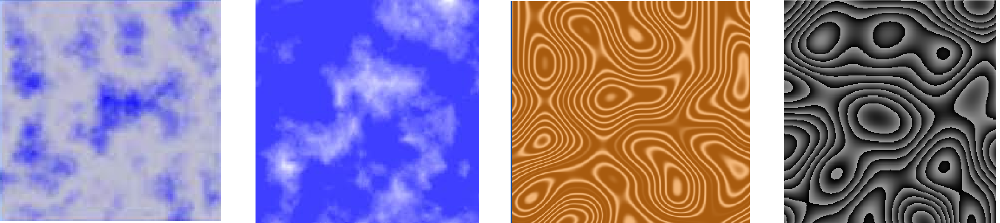

In [4]:
base64_data = "iVBORw0KGgoAAAANSUhEUgAACTQAAAIOCAYAAACMSxCMAAAAAXNSR0IArs4c6QAAAARnQU1BAACxjwv8YQUAAAAJcEhZcwAADsIAAA7CARUoSoAAAP+lSURBVHhe7P1nsCXbeR0I5rHX3/Lev3reAA9O9BIlxahjJkImxkm/JhRqTYggQRIAARKgfswPBf+QAAkKBEB2R3QouhVSTLfGdFOtUagltZqikwj/TD1Tr/wr725de/zs9e29Mr/9ncx77q2q9wACe91atTPzpNnm2yYzv1y79n/4+H8/yhRqo42w5LGxuhaWPEb9qbAUMGqGBY/aMDpdNsji9cf9+7A2DEse9VE9LHkM3J9G/Ks7PoREbWTOH0Ki1t78DDXzc61m4l+P1+t1e4UYk85nMRrVwlI5RmOXs+mx6wYmfy1qtc2vP+n3SRiZ8hnHhPhvEzY7R1kjLHnY+AyHcQZPiq8tz3o9jr/NL/u7xaT4TIqftZ/R0Fx/NBuWPOzv7gRhwWNo6l/NGGCtGa83rH004vM1TH0f1U39Nvk5qvXDkkfdRtecb7x6mfIYTYelgFFsD9vGhPpsYctvEsbre4yJ7YX5uZa1wpLHWP0wyRlYezLrwwm/D8wJx9ZNfvSGsT1Myq9aIy7fRiMuz4ZpgIer3bDk0WrE/d/MVLzeasfpaRh7H2WdsOQxGMb972gYX6/eiNPXasbx63Ti4+fm5sKSx2jQC0se/X5cP6baM2HJ4//3X38iLCU8Cj73//BhVxXn6ooPV5Z9uBpCYH3Nl0uv6+1xoIop7xNYFWITi2HatwgDZTvhXHa8AfBym/3W7RV2xzFNs+UPaDaLOtVq+eVmsNumak7YtbXDENO2JQC36d/sfnq9Gaojt+nmYBCqErdxHeA2tp8PltSPj9rmJySEeqn7l1EwtuHIV3Y9NuM4keO/ZqOo9Kw3M21fmUZjdy2od36naXX7xq6Ott4fFn3D7n1+/3rDN1gN1e8PQ7sxVPdibJOmwv0R6zCwuMOH/YHff6Suw+PaDX/+IlVFfeyGtk+nqhcaxH44lR431Gs+Ycw+7gP0+37jzIzfX9d5doXMDz3UZjvSbvtQt1vDMOZoTzEOxYG9nr94veZPMD1dxJP53w9x0G1TK1yHIcChRq3uI1pX95LtMO5ot8L5Q14DrXBcs+l/0/YxZFmEcXI77AMwjVNhDKPTPBWuNzPrN86p24KZsDwVbEAfNxOGz7lpF5fL84NFqYcma6s+3Fj34d27RUfa7/kLdNb9gWuhXwVWw3FrKz7NenjU7fv9l5eKC3W6vjC6wej6vSKv+uFepz/wYXSukI0Li/MS6t8ePPDh8gOf6NXQtwP9nj/XMPQp0f1eaCP+tz9QhpiQkJCQkJCQkJCQkJCQkJCQkPBDjNo//9/CE96A1ih+wTri0+SAtdVo9/zhdo6Beirr0Ddv1Ie9+AWt/X3S8a16eOoZMDQOQfVhHJ9BTT2xdjD+RGMOU/Z3F4MQeuzeGb/wbYSHy4T1N2nYF+bqgTHQMA4bYw4tJkID/QR+CxhzqBlzSIrXxx0c4vQ12/H5aiZ/7fksrIPOJNj9Jzt0bH79bcPkV0c94AbUewPBwDgMjMfX2Kt6MQU0zLq1h1ZLvR1wsOU7MBGy9mLXrUPDcCxBsQNPZ2VnWPIYDoyDo37z7tAfxddrWAeeRpwf4X13AeMAcmDf7rDkMebQZByorMNjw9jr0MSnbspn3CExPt7FIIQV2MyhoBSb72/LdxLGHM429X4o2z+2v5XVOP0D60AaF3/kwAHQQYPo9uL1Xj9e7w/i9Zu3wtuhgF54IUSshxdSRM/Ex3pg1fUbQwfr0DPVjPN7pqHeljnMqReUwMJ8fPzCYlw/5ubD28UAc3nXHsTtR61m2hPjcNw0/UOvF/ffCwuxQ9PGengjGGAduKb4FjLgr/z4nrCU8ChIDk0eyaEpIcEhOTQJeFxyaCquCySHpqI8gOTQlJCQkJCQkJCQkJCwGU6cOCEhx9R81smQ71IY8tknw5kZ/yyX4ezsbP6B6Py8H+cvLCxIuLi4GIWf+cxnJNyxw9/87tzp35vYcNeuXaXhnj3+ueuv/MqvSLh7t3/vsZWQx37uc5+TkNfiPvbaXGdcbZxtmphm5gFD5g1D5Bdg83F62t8EIp+Z1yyDdrjBboYbbm5nmfH5hw2rwGcoDPk+ju/BGPI9mF1HyHt4buP6dsNuePhrt1edV8ehLNRpsOmx6eS6zQebPwwJu/7Dit/7vd8LSw+HSflq89+GLC8dctmWPcMqO7J2Zu2y0/HvkKrCjQ3/cGM9vEuqClfDw5e1tbXst37rt2SZ21ZW/EMaGy4v+5cgVeGD8DDFrn/hC1+QcGlpKQr5+1bWuczwN37jNyTkvlVxqApt2ph2hl/60pckRP4A3G7zkfmN/GcZsMwmtSnWJqrqPcG+kqFtZ9kOs3227TTbb4Rc1u09UNavloWf+tSnJGR/cufOHQk3w+a9QUJCQkJCQkJCwkMD406hG4+SGHNqwlmRxLjT09+4YOBJPjxwbHE8TpUT63bbJiQYJwyACzaEZYDjgac/D3wBLJlXGJuTef6V/Gb30dtwT1BF3CfE7OXsdPoRExK+HxDXM0N3NwfqtmI47Av7g56nam/YxhC4WSUfJ3AvDTJOuDkm4djoiZtjd0PqLk0S7hAhbsqrqNNMuiwpoc+ros3VZPvbDxzmZF6VEQ6bnj4tyL6CPj/xYYr9OIXH8/px/It053T7gnlbGY4XcltgDJdw5TkU2Uxoq8fXi23t9rQQDy3IRsPT/SzUcYEDGcg2GM9gSDjxClc94ahErq95sj2GUxBp2/aiHynSRTBOmoXNYdkTH48IW82cOo0gH7qDeDCjOTMzpYj16Ypr83ojz6a7Zk5nL0K/ru0fToh0RExISEhISEhISEhISEhISEhISEjIkkJTUmiK18cfEMfpSwpN8fUHJnuTQlN8vqTQFJ9vMjbf35bvJCSFprBAmPYtKTTF+UsvaiIpND0efPrzPoQjE8GioELT2kpRlhvr3o57XW9fw6AKAeR9AnePTTBG1P7EB4z6cd0FyrpnbtMKTcV+/pz9QVHRGb1GqDtaoanw7Pcn0ObH4+pxFRGwm7PDGWCz3wj+prtjLjPUfTfHQRx+djZUxiSFpoRHxUMqNLG9LlVoCqo5eow3CuMv3ndMBxUnwAwlXdcYjN1hx25/vceh0DTnP+B06fLnr6vrcLzbDunSdZi3ip1QLfvKU8cqNMEBh6iHZcYpVmjyYWiGovaA6k1UXNJjbzqWlCk08VxlynI9c7/A/AHYhhZjlOJATlUbKTQxiUFNqa7uHdttHwkqNNX1uULZM556mmOmNav5zG7rtrrl4z4/5+8BGs0i/1tB9mkq3B5o5S8OIZgf+pad43vGoOhHVPzCPnosyb6SykcPHhSFOuj7A6nQtL4qgSB89JZv62wU5dELdry8XORHr+t/p0KTdg7jWJcKTd1OcVw3jENboRy0QlP4YM/18/7cq+tFHPo9f87h2H15Ud7/9t/5MGFzHP7r/1VYyrLX/v4b2aW3X5Ply++84cZW/r5h7HmIQ8sZ6t6DR2X51LMfyHbtOyjL925dzy68+Yos375+RcKuLliFRqOZze/w98YHjp7KDp04Lcvzi/4r+I21lezWtcuyfOvqpWzp7m1Z7qyvORvzRjZSdfZ7CbabdWeAU9P+a8nFXXvyPNp7yIdzCzuzbpBMQ9quXz4ny/du38i3l+U30AiVHec4cPSkLCPPFnb4+/v1IF96890L2Y0rF2T5wb3bLv/9AJp9ZRWQhnpoeJqu0Z4OsnEzcwvZ7LxXHMDyzKzvnNrha1HYQrPpG12kn31AzfXTRVuVL1TAO6TKklvI+/XQmAxcJ9QPnRvsCTYAIM3rq95O19xNAWwG6IS8HLiObPLzL2+LwEzoeHfvP5wdOu7tcff+Q/k5bl27lF298LYsw9Zp21VlhrwBFnftzQ4eOyXLDKddPq4u35flm+9eEhsHlu/fyc+7lbgTYoO0Q+R93S+jHBiyPCS2Ic64xihch/nuy6A8TWVgmbenZrLF3Xtl+cCRk9n+o17xA7bE+vvu+bdcei/K8lqQ2OX1CdYn2N3hk0/J8omnXhC7BHAO4NLbr0t+ATavWKY79x6Q8NQzL+X1Znnpbnbu9W/L8g0Xl56+yQzguHGPq8PPfPAvyDLapnde/5YsX3jr1bzOaswv+jbt2Q/9aLbf5QGAY86f+Y4s6/aQ6dyxe1/2/Ed+3C/v2Z+985q/xkV3DdqyBtsC2CnSBew7dCzPT+QP2wDY2CAMmN6P9pJparuBDtIFHDrxZG73wJVzb0qI8lt5cE+Wtb3xHKg3z7z8I7KMtvTcGV9myEubLzgGeQe8+NGfzOZCOZz55p/k9gKne4I2u+fAkey5D/+YLM/O73B5/01ZvnT29fK8D3a1a//B7PRzL8vyXpf3925dk+VzLm63r78ry2yzNBBPtKPAwWNPZMeefFaWYVtor4GrF89KePvq5Wx1xasdoA3cTp0kmJcWD3MugOdruoE2+4U9B49kB10fDux0ZdAPNxCo52wv79+5KWHVeADlwfMhX4Cjp591/Z1Xv7nv+kjaDfpOtvW63v/tf+rb04SHwxNP+Hxn3WAbyJDvUqgkwWefVJQoU5CwqkRUL6JqkVVmsmpHVhWJ61ZpiepKdjtDqjCVbeeyVXeyKlA2DlVxZppsWq1Sk1VmsiHzlSE/FOEywDKxCiC27H7mZ35Gwqr2gGC78Lu/+7sSsn4x5LMShnwfptepgsLfrBrKo4b2vFyvCm1ckRZus+li+rndrhPc/rDtKDGpPCb9rrGdfbeD7aRx0r5Vv9vtXN9qWFVeunxZxl/72tcktHZhQ9qXVfexYZUikw2tkhCVhmwI5SGqD/3mb/6mhFaRqUqhyaohWRUlq6bE9fv3fd9ZpcxkQ/xut1nVJ3vNqjhWpY15YNWqqhSabD5rhSaGtkxtmdMmGFo7qgLrXlXfuRWFJtu22/af/WtVv2EVmu7evSvhZvCxTUhISEhISEhISEhISEhISEhI+IGGf2g8BjzTw4O9LTxYx8t1PCQUDgaOCPHQEOeGKl0jazRbBRtUbquH6+As33vgQWa90RTCmQmOTCBelMMZAsRLWRAvc+HoBcLhAC95we7GhjyI58N4Czgw4IU3eOj4E9mRU08L4cwEhwAQL3tJOEiBeCEPJ5UyZ6Za+MMLenB6dk5eRoN4oXz8yeeFcFg7+cxLwmOnnxWnEHDX3oNCOFi1p6aEeJgLJyQQL/ORXhDx6GysGbptHU/s0+91hEPldNB05Q4ibsxXODYcPvGk8MRTPn6M49EnnhHuO3xMOO/yB44VIB80l4EKg6srD4Q3r14UhwbwxrsXcns7cOSEO/+zQjiTwIEHhA2UvUzqd7tCON3g5b7w6iUhnLJoF/sOwU5gL0ckzi0XX3CzOFuI/bi6BEoZSJ3CS5ygntiH2qQnluEgAcq+zj5A2mCVHVYi1HnEl/YEm4VjFYjTFXErrhOqeglChuP/irzdNh7DKR4aW8rOIs3bwkMe9n6gsni3heIsbLMqITZVcsWSPCrOWrL/VjB22MMUhD2JP0eezu2e7nuExx5Nnw0JCQkJCQkJCQnvAWr/05/EI+bhqv/CgOgbr/7uhvfQItz9XIRhP97QM4o1/LqC6Kkv+4Fh33uSEQPz8GLHgvcSJvRXxYAdNw7NDUHNKKC429Gw5GEFZOpZHP+5VrxDM3zZStCDjQgObDmaRoIGUxRoWAUn+wyAnnhbR3yCcQWWGGMKTeFr4BxGMcRZSAiJ+HrbvXkf39/E397g2fhOhMnQCRiZ/XtKKQPAdBQa+qsZgF/bF4j3t+U7ruAV70DvRsJ6Wtr49KxiTfDoJPqmvtKTkxj2Y8WZYcd/NUTY30emvo8rNMXrVqFJfyEuaMT5t3e3/3qAGNbj61mFpe0rOBn7sgpvRhHOtifujCGsgD3/GDY/fpJC0/izXlt/TH2ZpNhmWlRr/32j0Gc/Dlxbj+O7sRbvv74el3dnQ0kfOPT63ruXuHE7fGof0OnEx6+txRmwYew/GynJAwc8aNWYCV8kEzNTsf21s6thyWNuNra/nYvx8Tt2xusLO+LrT03H8W02TXth2luqJhB1q+A0jI+3Ck0rD7zXOEEvaYLe1MSP/aVjYSnhUfDxX/Sh7r45tKLq5fpaYatUkhgEFSWthJmPGVi1TJWOELVv8QHDSN3ML5d119wWPo4WFMp1PhypdpW/sW/TfVrxxZXfpvs/Xocxjrr6sJxfVSVrlP/oTzBSbSgVB7lNHzcMfRP34TrA/dhe1muqnUgKTQmPilAvSxWaOKZTdZd1Kv8ypkShaTqo//TUPVa/7xscquRMUzbHYXrab8zvUZTa3/yiX643ff/SGBX9MqO3VYWm9lQ4VxjLtdU0Wu22jwPVovTwsxO6+rWO39jpFn0d1ZoG/VA/laxbs+FPVg+qDvqcHJ5znKzHuxxbsQ/V93KtEM+poILVVMOU8IFqnmbdxoQPqfL7FirTAWzfOiF9ui1shftErdCUKx2FMakeizJ+7dA36NtMxjVX5CqikEe2FpSG2+p+oxnudXfu8gfq9p/DdJ5b3+fm28L+WqFpNGQZMg3FSfmVVz2oTOlbm411H7/Oho9TJygXAoOevzjzWj+yoDLThv8Izo0HfQiED++z8GGcgCIEvC/ScRiFDKDZa8ECmiarnv5wn+cPojPRmJgKXgMqS6vxOcv+X/0rHyZsjodXaGpnew/6cW6k0HQbCk2vyvLtoK5Uqcjg2gqqL0DNBSoewOIu/3U8nHxu3/BKF6LQFBQe1tdWXZvkjacsbu830I7DmQmYmp4RpxsADk1Q7gDmF306oZbEfLl++bzkF9BZ945HVaBDEwClE+YV8o8KJ9cuerUnKDStPPBf25YphBB0DEA5AO3p6Wx2zj8rnN+5O1t0lOUdu3JFETgGUaGEg0+UwSj0Ld5BzS+PXKUvFH/kf1ku4I4PVRcB+0NREgptHNs6rBftXs2d258X6YNzFLC6/CBbWfJfpD4Iqj0rS/dzJQ/sa5/9WPC6KEc4awFQwdp3+Lgs110cb13zymNQfbl706uydDu+AbX2yDxuuXtEqtUcPO5VMGDzU+FecmXpnigFAbfd+aEgBPRc3ZkU5zIgL/PngsxXxCVsEoSo4l4gj3cIt1uvaEPT07O5Sg6c3qAaBOCZAevvFZdvVKOiqpi1fapKzc4viOMeAOe6R1JoevYlyXPgfVdoeu1b2fk3Jik0/YRf3rNvewpNLl3APtcef78pNC0Gm4fz4cMrNPm8R39DlSsoNdl8wTGsYy9+7KdihaYLQaEpfIUPsK7vPXA4e+7DXh1rWwpNrs87/bxWaPJtOeK2dYWmU9mxJ5+TZa/Q5G35WlBogiLc6rJXO/h+Vmjae/CIq++PUaEptJFwHOUYISk0vfd4+mnf1rKvZRvI+wyrKlGlIEHFCChFUI3IqhRNUmayYZUyE0Or0GQVmTZTaPr8570cvL2GVWhiWBXHz372sxJSmckqNFm1KoZWaYP5yFDns1b0AFgmP/uzPythlUIT662+fywD2wXWKxtaBZOvfvWrEvZD24qQy1ZBie9iuX1SaM9TtZ3rDBk3u67DqvTZ9Nt2ctJ6VXtrt29nfavnfL9g0wxsN5+4bkPCbp9UPrYcWdZ6ndusvdjwK1/5ioS0r0mKTDa0SkFcp7KQVWiyykNQKKpSaLLqRja0qkg2tOpJVGqyCk1bCe02KjTxXFVxqIq7VWraqkIT160iFkJbNrYNqrIBa0fWHgnWQYZsXxna9riqL91Mocn2B5MUmtiv3Lnjx5ObYfPeICEhISEhISEhISEhISEhISEh4fsaeCi31YfkeLAn7hB+1QFOE3iw5x/uTTiXOwwPB0Gv6gO1GLy0xfZMnCSo0ANSBQkPCotrfO/AOOAFNxxgwIWdu8XJAMRLXirw9Lpd4d2bV3Olnvt3/DRzYJUzExwX6MyEl7wgpuDieTFF0ZV33hBeu3RWuHz/rrxI38yZCepXUzOzQqoyYYq1E8+8KMQ0VkdOPSNEWrgvXqovL90T3rnxrvD6pXPZlXNvCeGgcPGt14SYevB84IU3v5tdeMOFoKxzmyf3k33felUc60A41oFXL5wVxxMQL7bX11aEcEqYc3kDQj1Jq0qBWN7vtoNwzMIUcGCV7VBFCOpJTB+ujzSCeLhN9ScoQWE6OpAqUPa8vnaMxGEGZQWy/KHS1et0hIg/nH/APQcOi1MMiLjC3ie9hLTwdSqoIQV61SYXguE3/s5Kx/q4VUh9x1+oCzVXZ/HgHkT9Rfl4xxHW8YGPT34dsgqPo477a4wlC2VVYQdbQdWRearcf9hHuIXLwE7wtz24/XlBC14c/+XL7y8ey2Wr0jcRW7u6nN79N2YflXjoCH1v8Ocoqjn+nGVxQkJCQkJCQsKfJySFJjPStAIqSaEpLq+k0BRfLyk0xb8nhSa7bmDPP4bNj08KTd6LmUgKTfHvSaHp+xP/t//Sh7r55cd9hfpEUba9oEAxDPVtpFSBWqaP2PQ5p21vFbSp1LJw/kgVxp+46JP1b2EhoKbUXQj2bfoFBhd5Tq3ewXN2bJ11sP2+Xn/U3xjavhRge9lqqno81mYmJDwc9PCuUIAINqrqYvGFjATOHouKwzrVDr/pe4RuzzcyrFszqr+bnePXNBK4sacPgakZf+16w9fFRlb0y1RmCuIVAtb/MoWmRujT2HfNzhYXmpnx+4cPfDKq5gBroataWfMb19aLwUU/1FXez2iFplbLX7wRMkZXaw5vNzb8ufR41459qSIH8MujqSkfUaoXAbt3hzSHrNVjsPAhVa4MpZpCN/b24caGT5/+rfjySQIBFZKoNldTbXsrFD7tY6ZdxJ1KPzxX1HYHW6s3fEgbAlqhLHf7j4EjBPGrvP3W6k1MB/eJ7iFzhSa/Td8vM4/rLR8J3VZ3Nnxa2Tf0e8UFB32/fzf0mfqj+SA2km/rqNtnlkn4gE5A++v1eG2VWeGSVGjStsrHGmvhOtr/Inxwl62HcE09UuF18sceanzOcvqX/9KHCZtjXKHpdVm+fO4N15b4ry61TREtV0GgXALAcQROHQBUGC4GhSaoSwBlKhcA2mcqVUDh4vCJ07JMRRUo/MDpB4AiAxUwEK9uuGkauXv37TsBPDowFqNSRxuOTDvCV/8HDsmUaACcmzDlF0Aln2uXzomTDACFibLxE8BzU2UE08zBkQmAigXVbqDEcvOqV3xaD+osVEiyQJzhGAbgHMzn3QcOSwinpplZ/2UnKhJVh6DURVtYW34gCllANygjwVGLihyYLo5pErsJtjO5jOAQE5bcAhV6qPyD/GiyfXedBpyrgJm5eVFVAeDghXUA6iEAlLyoVgX7uXPD34vCsagTpOhsH2YBW8+VZk4+mR065tVDGi4+VNu6/I5XDkE5Q1UJsGnm+B3TEgKoM1B/AmAzLPOlu7dytaa7zlZWHvi8x3R8QJXNbAeIyeOoNUwTpoQEkP9UtoJCE5zhgLobtN276esv1HLgzAVsBFuybUyk0BTs/vhTL7iy9+X6blB9ufj2a9nyPa9mZe2e/eSOPUGh6ZmXsgNBJQiqQOde92o/UDQrU42h7e09cCR7Oig0oU5T2QlOeWVtG+wQePblH81Vid458+38uDKFpsXde7Png0oQ8k+rQMG5zoK2AhvCVIsAVMSoWqMVmmD/76eiHcsOU1BSMQn15sBRX29geVdc/wJcevuMlAWg45bniyg0/Ygso45sVaHphY/9lDiBAme+9ce5oleZQtMeZ6NUaJpbVApNri8sV2jydrFr36HsiaDQBEfEQqHpO7l9Vys0+XYKU3seOx0Umnbscrbsv6i/Gik0eVUDlOHDlJ9rTfHfGB7WFlg2WqEJaoS09TGFppAWOKICW1JoCm0snEbZB2JsQbu55fq8pND0+PHCCy9IWNw7+3bGqkpMUpCgYgSUIqgWYdWKrEJTleqRVUeyiktWmcn+XqXUxBDqTPZYhpMUmrhOZSampUqhySo1VSlt2HxkPiPfP/GJT8iyVWjKlahDyHaKZcmQ9bcK0fjNgescJ3G9H9pSbuc6Qi5T6YbrfJdmwyrVFLufvgbA7WVxALjdxh3rXLbprQoJu07YfK1arwqJzX6v2teiavt2UZXWzfKEyzYkqn5nWFUeVeVly5ahLXuE1j5saO2Ndsnwd37ndySsUmRiuFVlJqs0xBBKRVQrYkilpiolJrudqkl23W7/9V//dQknKTSV/W73odoTz12l1GTjahWabFil1MSQ+WrzfSsKTbZtsXZTZY+Erae2vbXtsu1TyxSa2N5vVaGJ61ah6datWxJuBh/LhISEhISEhISEhISEhISEhISEhISEhISEhISEhISEhISEhISE7wPUfv8/xhIa63e9Zz5RD55exKBvfKBq3nOWqPNL/4ChUUTRXxUA3b73NCN6+hNKh37+RafH4rz3Cs6Rfwbq0TDrsf+Zg/FI6wfPNWLQj6+fDeP1GaP40rYKM8FDjWipL2WBllFoqpv46q+yy2AVnayHnVVgoUceYT94s8fz6+sqNBreEy/HBIWXSd61k71v4/Ppr8+BmvmdnoRVsAo39GQk6OFIhI8zcgxH3iORGFqfQKsYZhQyrEJXW38S7dCeis9nFZroEUnY8rUKTTZ9g36cfpsf9nyjYWzPK0txfPh1NDEwEj2TFJqa03F+zLRj+2rEgjFZbRQXSL0dx386fN1NNKfj+LaNusnIKIvUxr4INeU7iM9fM+1fbUzhyeavKQ/T/vRN+2N/p/pAgTh+ExWahnF8XQRD6GHTY7G84b2XiW4vjl+3E5+v34/tZzCIFYO63Tg9a2vx+sZ6bA/Xr3svZ2I4CrIIAb1eXD5UdyA2lAoOUAtfBxLzc/4rFGJxMd5/tuG/NiXm57xXNbG44L2MiR074/jNLcT5OzUd28e4QlP8BdjsXJwfw0H81Z1t/mx9bpn02vaXntbEj/yVJ8NSwqPg//y3faibY6ozdDu+DvW6hS1wnJUrMykzMV2ArcIxShWavE3UlOoTUdYfc1tZV71p9x3avvJzhoUSUNXTjk2Asi8LxsdAxbpVzNTY7LgcYXxTr6t6kRSaEh4T6iWKjVRq0qpntGPW/XarqEA0cVqlHiP3+r7/YL8wM130x3Nz/FJSglxtB2i2fRyo3NNQ93UcIul7hc0UmuoNX59bU/6c86oPm5sP+4dNevi96j94ypZX/Zhyba1oy7am0CSBi6cPAQ6n1oJMju4f7disoe61iq+NfP5R9QgIH7i6vtyHGlahSYND5fVceaq4XvGlqgQR8nZK2Q7vCxmvWZX/3MauPVLFC2E9lJ++X+VxuyiKqtrsvP0Oob6NrZl75JpW/QvKTLQXrYLFNLdyhSYJBBuhj6RSkxYLGIQxbb/nw64aMm2E/bi/vp9jcS8FOwP4e65cq9p6LjJa+lxUaGJR6t/CB3Yu7j5UQmO5DfTDfZi+f+c5fv9/8mHC5hhTaDobFJre2YpC0xFZ9gpNXokF6jJQLgFuXfUKTV1XmGUKPXjuMB0UgXCuw8e9Ws2uoPaEMdCDoFhx+9qV7O4tr3K0unQvV3mAunPpGOQ9AsdlUEiBMhMAZY3d+7wqDVSrFnf5L/+RZKpSXLt8TkIod6yv+Mpj71MJTAdHlReqXhyBUkXYBnWmK+e8ItBNl8dlShUafL6D+O7YtVeWoYgFVQ0AU5sJXNLWV/25lu/fyR7cvS3LUHih+hMUS7QaE8ApxGTZloVaLbMBUQ8h1GIBvxH5zrxHejANH9B0nSYVj6DmAwUdAMouAJSzWE5QS2GaoPhFtSYoxFBJpcqWqA6F81IpC/ZKZaKbV/09Lqb+uxuUWjDNXBmoDDMzM5fXocMnnszrEHLqXrAbKJxA9QmAUhbQc3GVaeK+D8AyoSIWygDKNQCmAOQy9sN0iwDUle5cDyplQSXL5jvPC8UWqPsAx598Qab1A6j6AoUmlqlVaKLCElV7oGQEpTMASmNQ+QGuXz6ftycaqIcAVNee+YBXaMK5zr/hVYLOv/FdF/9x9SSqzDzzwR/J4459qfyjVX9o/wuuzXjuwz8my5hy8PyZ78qyv0b8vASgQhNU1k496xWaMK0i1ZyQxzdcuoAV116yzr4fbWWk0LTHq9PDvtmWwXYvh/brsutvqKCm48bytwpNLLNzZ74jU3Vq4BiW9Ysf+ymZxhHYvkKTV8fClJfvu0KTa3cBTLEJoJ1aDf3w959CU8vZuu+TYLNUP9u154D0y4AoNAU1NbZpmGKzajwwE54l0laOnn4275+ifu+a6/dCX6X7vaTQ9Gh4+WVvz8W9s29neJ/Be7oqhSarGIGwSpmJ26sUmqwqklVYsspMk5SYGO7d68cGPB7brTITQ3ttxo3rVGbi9kkKTVTOsApNVnHDKnL8wi/8goTId6vMVNz3hjFRCLer0MT2wIasX1a5hKFVNsG6VT2x61RuqlJJ4Tqfy3C7/d3GgWFVXJkWhFy26SRs+2jXbT5yvWq7zf/thFwm7D6EXa8C97NpqkJVXujtdtuk0Oa/3V5VPjasKmNrC1jncpW9WbuzoVX7+fKXvyyhVWiyikxWmYnKQnZdKxJZ1SKuf/GLX5TQqh7Z0KoncbtVWqKqEtfv3fOKmVyvUm7CdrvNnsuGjEOVQlOVUhPzZ6sKTVqpySoz2dDaQJU9WTslbF207a1tlxnadhxtu+1Xt6rQ9OlPf1pC25/cuOHHXJvBxzIhISEhISEhISEhISEhISEhIeEHGPqRnnm+Jw/25OFezvCDAY6DIyqIqdnwABEUBxlHvBjHi3sQL0/xIBCsu3W8jBaGh4jvNRAXiY+7PggnGTgYgZhiBy+3QTjQMP3LS3ezW9evCPGyG8RLWKbTAg9AQbzshsMReOjEk0JcB9OkgX6auUu5MxMeuPKhqwXybtYdCx44clKm7QKPnHo6W9i5S9jZWBPeuHwhu/jWq8ILb74qThEgXqovueuCcGyCIwHY7/WESAvjgIe9EdVfGfTvY8cKg30MkWd4IYGXZV1xJAFXH9wXpzHwxpWL2eWzbwjhCALC4QXOBSDOg+n1wBNPIx+eE8KxC1PYgSxnC6YVzjNXXf6D1y69k8cJ032BcHaCUwVIJx8L2jfiT7tAWS7duyWEXfMciBvsS6YDnFsQYtrAqni+36Ct56w3cjv29dM3Ab6k8f/2ABsobAttgr8Or1GXdV7DIFyQ+Y02hnaFuMFhCcT5yuFPgGktYX/iMIVruzolbVBF/hc261+UAHCuKisz5Ir8YX/UI0eXItlfjrEf7wbkx4V0+bSpdgrpCmXgNoSj3ifgcsJgE0Kk2/8guRrKAXGeBJ5O4IukGkirTe8WrlF+YnOex4mJ6Qh8HHivkiFpcP+FssyXVcKkbuVlEoigBP4o/I/z+TrkDFy2ArRn4XuWqISEhISEhISEH3x87+8iExISEhISEhISEhISEhISEhISEhISEhISEhISErYAqkSQUIjYjFCM2IxQioCKBPipT31KiG0gVIrKCDWjMkLtCPylX/olIdctoZJURqgogWXrXJ5EKDaBv/zLvyzketm+j0KeHwpQIOO8HZblzXZYlf/2d7tets2uswyh1gUynXb/snRp2v3K8hK05cR1TahugXadhJJXGaH4VcZ9+/Ztifv37y/lgQMHxnjw4MGIdnvVfuShQ4eEVeuWWz0/t2uWpQm06eZ6Vb5xu833qvKpKk9Q2wSobWkz0s4sace0W9uGcZ1tniXbRku0nXp5M9o2uaoNt9vJT3ziE0IoBm1GKAlN4s/93M8Juc6PkOz6JEJdbjvMP3AI3M4+VeuPyqrz2e16veq3KlblF7dvBcmhKSEhISEhISHhPQJmAQAxcwMJBXew36sLR8NmTkz9COKjVtCN63I+LjRbtXE2ywhp0ZhuPC/kuhuvjhFfHuKPHyeC+DAYhIo7iNkDLDEtpieOJe02ro9vk7mBAmtZK9Dlp5DrLZevzcC2sNnQnPZsumXHhIT3C/wyvbBZ3BTiS3631CDjNkG3C5jOi8RUZGB7qimcmmrlhOgCiJlmwIarx2QBV48qbxPxZTFJ+K+SXS3PmcenFqjixw+eMSMKqONQtDV4iODjn9M8mGA6QeYHzxm1SeF63BdTgOdsu+sI3XZHnVdTUw3P6WyM+GAf5PUYbx/30E6S6rc8ni5iYPGlf6HkwHZSE6rSwl4tJ/sS9i2Yao3UfQ7IfX3fExjOWXY9zIYBrq0WhAo2uLEOdY6hO+8g59i5VTwxhTU46DU9+62cfbcO8nioa+fcGEbc6PRzdju4PojlvkvHIKfLwkDkKfLWWScZLLW8TIK9lNiqPR4cug0gbYDnATH9omaZDbWnakLWSbDe6AsTHg2uyCaDBen/E2hFBpxj8/MUdTdSGnHLIE5TPKBrufaNLB74FQogm1/pUSCKJ+6aYLs9LcS0UlTR2bX3gEx1BmIfTGcF3rnxbnbv5jUhpgsD9ZRHGog/VJ9ATD126MQTQp4XSkRXL5wV3rx2WZSZqM5UBuQXiGMPHT8tPP7U87mSENKEKdfAi2+/Hvhadu3SOSGmB2KcMXVaoQJTlPX3AxAfqiR1O+syfRXItEHN6sIbrwgvnT2TLd25JUQ+Yxos8OQzL2YHj54Szi0sCjndmAWm7sI0iCDUq65fPiccoZ10xLRfh064/Hb09uAVvcoAxZ91V4YgpmO7dfWycGXpvuv3XPk5QpmJqlKYyhDENI383SvffC/haznroCgmoV6GusnfNdwe7r/Akt81pF8Ptie2Ho7LVZJQTvm5LHwDRXUl2AjLCepHLBvEtQwwdXCAY129BZGmiceF9guKXoSoaoV8KQPShynFQKSFbV3V/oycpCvEDYo2VHaqI46h7Xy/bYQl6m0CdoB0Y9kXk2/zvQKPW5JjqiA2RIbyFCL9E8H93yuEeDAuiCK5RWwpGd+nQNRRfvKHMg11Cz/4sg9tAW2AxVgFHIrzOHIsr/s3nKPo92HT28zshISEhISEhIQEQe1//oO1aBjauePnAycag25Y8uj2zQ1FLb5ZlkH7JrAPLfr9+Py9ficsedj95+f9PHuEvR4emG+GsesPihs1gHMQEiM80VWYNs8GWuYmrdWOd2i34wcAeIiuMf6swcY/ji9u6jQwYNYYX4/zx6bf7D5+/DA+vtFohaUqxOmbZA/udjcsVSE+vtuNy2Os/CeczyQ/n2uSsOVvij/b6Jr0GPtv1OP8s9nVMuXfbMfr7ZZJj0lO05Q/HqJr4GGCRn9gfu/H6/b3kd1/FCegsx7Ht2/O1+vF9RcPXjTwYkCjaZ6Ptafi9DVN/tVqcQHa3/EiSgMvqjTGzxfHJ7PrA2PPg3ZY8sCLcQ2bPnt+kfpWGAw3tz9bX239lxf3CrVanKHygl9hNIz3HwxiezPRy/rwQlDomva5Y+rjevxzNuj5eVSJQd/Pm0p0e9NhyWNjPd6/sxHn77Xrfh5aYjSK9+8N4vSvb8T52+3FCbSev3i4r7FjPj5+pnUpLHnMTPt5con5hdg+FnaY9bn4elMz1p7j+NWb8fVnZ+Lj+wM/zzHRiIt3zH5sem17OWUqyI/+5afDUsKj4K//TR/q5pltZ6/rw6Gqi3m/HZoP3c2Ndal2XaNmKrTA20TLNr4O8oDegNfbLA62XwXYNekuany8ERYUhiF+o5GOuzdsbtPjmmI/Gn8RmcIZidt0BYm3xW11XJHwMjyHaXMTEh4W9U3uV3Qdg7MhAOcYoK2aaQ4JWA30PdQwjC+aLW+zs9NFfzkz6w9shyoiz9UDanVfN+oNf124VREcI+g6z/2n2n6/9lSRrkbLjxFabb/P/HwR+bk5H4epEC09/FnzU9JnK2v+gusbrOfo93zIuOj7ALxwA3hrpsc0PD/notf3O8O8HfHxhKMUAacmYHrGxxcOJ8RsuCWdDkMbOKASYWr7Il2quOHgCqyt+TIaqLE3++mGub8E7JgfgJMbwO57Wg2rQtRz24GzGMG41hv+nO1QfgDTOBPKRtsH71s5Hm+G44HiN4YqXSGebLMb6n6IaWa3NFD2tRHGcZ1gA91e8eNo6BMGhykdAt2+jwz72EG/+I12sbbmQwCOVBKG80f9TEgQ46Vttdvz5++FPlw/VujR5kJ5w8mMgIMZwH10neps+I3/4/9nvJ9OGMfhv/5fhaUse/3vv5FdPPu6LF95541sdXlJlu3zDQDTae05cFiWTz3zgWzPwSOyjCnRLr71mizffPeihJjOrOwcaH/gWALAKejgsVOyvPfgMQkxBdgGPAEd7t2+nt29cVWWcY01eAs69J0xcPo2maLmMQIvTiV0nUWr7RuH2bkFCRd378327Pfp37nvQDY17Rs0xBdTtAE3rpzP7t+5KcuYog0oywegPTWd7d5/SJaPnX4u23fY50EHHpAOV869kV29eFaWVx8sOZtnuzsOlA0cX4CDx57I8xXTlWHKOOD2tSt5PJGfQGd9LX/2UBXPP2+AjcExBJienRMHNGD/4eMynRswNTOTrSzdk2U4cwEoOzgWAfZ5DIE+c+fe/bKMMgOQ3/3QIF45/2b27vm3ZRnnn1xme2UZ5RWXmbf1OzeuSHjLlR2mvgM21ldd++wbzve7zHDfUws3z214nTrMLux0dnxQlvcdOp7t3OPzG3vfvXVNlq45O7593T8zhzMXAAcgDY5NUK/2Hz0hyyefflGcxADYL3D+zVfEGQzQDkQAz4HpGoGjp5/Njj/5vCy7K+bt1GXX1rFe6Dzk8ZhG8skXPyzLmP7xerCRt777n7PlYDcaqMvAqWc/kJ1+wR+HtvCNb/2JLMPhzmJmdj578qWPyDLimF/jlT/LbbMsbvM7duW2d/SJZ/I264a7HvIZuH/7pjj7AfbZxnsBOgOiXu3a620BUzGyTYOD5OWzZ2T5yrk3xWkSKEsfHPqeeflHZRl29c5r35JlTCfZ5eAgAMdgf+CFj/1UXu5nvvkn4tgI6LpMZzG04899+MdkeW5xZ36NS2+/Ln2XBZ8n7tp3MHviuZdlGU6i6KOA82e+I3UUYFuggXiivIEDrp7TJlGWy/fvyDLbejg4sh9GPX+YOs68HEM4FRyStgOeD059aJ+A3fsOSVpkOfRjwJ3rV/I28E6op+gLy9KB86KNBpCfAGybZQqnXpbjddc+rzFf1AOiv/1Px+tWwtbxF//iX5SwuK/wIT6EAaDoAUDxA4BCCAAlEQCqIwBUSRhCgQeAYgkAxRMdQilFh1BS0SFUVwCorQCf//znJeQ6f68KofICcJ3Hc53qLlzeLPyVX/kVCW2cbZqg3qJDpp35wnXm1yc/+UkJmY/MV+Yz8x0hy4L32gzz+9/QPjFkn8B6W9UesE4yZF/BkPXMhnz/okO7je8M7XrVdnv8V77yFQm5bq89KW42LUijTS/DSbD5aEOb31xnedjtVfvr85Zt0yFRtd2Cv09Kc1Xe2O0Idd7q0G63ZcGysturfp9U1nZdh9buGHbDQyeu81kXt3Od4caGH3swXA/3aVz/0pe+JCG3r676+9hJ4cqKHw8vLy9Hy8CDB36cxPUvfOELEnL7/fu+71ta8v0it3Pd/m7Xf/3Xf11Cbr93z4877f76uKpz/sZv/IaENm5ctyHTZEPmAcPf+q3fkpD5tRYeRNlQlw+XWZY2tG2OtStrj7RjwtY5W98Zsn1me812XIdV/WtVP8t1KB8Cut8FLly4IOFm8LFNSEhISEhISEh47KDqBJ7Xk3i5CsLJ0DsaYhDpiRfNIMaPlo8LpWpMbnxK4oU2qLfldONZTYx/LcuA8TOI8bXQjbvJfn8o5FeQ9XpTEUoGoF0f30Z1K5DXw4tp/3JaE3muv7rUx/qvMqmMo1WfEhIeHwp7xM2lvsGkDXpivSDuM3O6NgEcjvpC2iwIRyaQSkNwyCFx7wmyXdHnHwOiRW4TVJViPPMv2oVYL6jjwLam3UZcXZyn2zmnpjyp2IQba5JtEvMHjjiWbZcXINWYQHx8AuaqTNNQZPIs8s3doIPuHp1k3Al9HeYt7vtB3WaSeEgA4iFDTtc2CofjZL+hlY/yNhR9jGOhWjTMNrqeHdfnWHYDe+4cQncOEk5j4IOVYWAv59pqX5irJnVHOXk8HHRBrTw46NeFw0FL2O82cuJbCBDPbITrBdfXhsK1dXddRzgCkXkceu76jvCxJ/FgB8zzztkc6VaFrAeaLVdnQN030n5Ztu5sBeE47Eibo8qYJvtTTao2cV3bBT7usB94JCQkJCQkJCQkJCQkJCQkJCQk/DBDHsslJCQkJCQkJCQkJCQkJCQkJCT8+UMt/9sOtMKDdiiV00w6VfBshEMivogE6aAI1Bt1oUzz1Gp5Nh2DQ6Of0qa4plz3EcBz4CtLTt/Uak2JcgQIFQ0QSj8Lu/YIp6ZnRHUEXLp7K7t365pw+f7drNdx2x2t4y3BqeFwzv1HTgoxvRinkbr57oXAi/lUdlVKP60WphNtiyrOkVNPe558SqYoAxE3qNEIz72RYUo8cG1lWYjp1KriWQadV40GprhqSlpabRcPRyjV5HR5hHzajHr/VntKyKnVcG4pk1DeWwXSApUUEMpWt65eEkKd59LZ14Uop/lFV66OUAQBoXYDFS6Q6oUWyK/7d24JoRwCQvWqNeXi7ohp/qAEBc7Mzbt4+48AygD1lZUH94Qok7s3rwmhrDMzNyfcufeAEGpm8zt2CpFv+RRo28iXxwJ3OWcB8ucrOuxBfgnwLYNYk9uel1+9+PiBR1rQDqVd6PWEyG9eB4pWQlc2m+UrwHYF9ZP1CtPV0caQd2VgHHBdqAGBWGf5ypRwIR0aqJ8g9udyO+wvx5SkGNPa9dz+IJzWeY0q2yOQFrY9ki6Xt6CvOz6P0Ia5SHq+D+ClUCZsQ6WtdhtBqHFxGsFqVT3E1Z8oz2PpKia0T9gP+4dVj621Z1tFbtNjCHGOlspRfY4/BwiRRzFwekWxc5bpEFMN+zITeww2UIc9bFJPgfx8mPoYHGAqRV/mYkehrcN5WdYJCQkJCQkJCQnbQ5pyLk05F2Hs+DTlXIQ05Vwc3zTlXHzCNOVcWAhIU86Z9TTl3A8l/tpf86EuDi4z1FWNwwobAqbLQiFWI2ov2Rb5bfNzpjF0KOuuuU3/ZncL6rUCdkkMdRdg06zzg/tPsYlQF8nzJmzTeeVfNWAbI1r8yPYsb5dVe8lttTBm0c8nbfpMt5qQ8FgA8S+C9s8xgyiDBbRCNwKVH2BKdStQfwG6YYoqZ60hxG/+XNMz/sC5maK9b4euk/U6mlUxnAMv7YCGuo8oq7vFlHP+JO3p4mTTM36ZU89NTxUVbXbOJ2RqytY4l54wQwbHFLrdgwIQwOGSHgYz27hND6m4zPZU94+cBo3tAuWUgZkZf9Lp0DYx74Bux+8/M+v3UYflbV9+GRXPoB6dhZmospUVL+kNNBv+Ag3VobPNY1uk08xunbbQDOUO0HaYx9wHCDPA5eNiqBMRPK4T5khrNIu84m0tx+ttNe7mNg69dd/F9Ou4E/VwTtqjLrfVNW8EHchKOehx9yDY5jC0/3paOahBSRjuawbqfpZjYX2LQBtjf6b7Lt7q9MK5oH5FdLq+UIYhXnr6WE5Rxxlbyqac4xR6Ou48xz/77yRImIBoyrn/+5syzQ5w+Z0zW55y7uQzL2V7Dx6VZTiHXHz7VVm+cSVMObe+WnoOPIfAi3cADkL7j/ippeAAAswuLGacRmrp7m1xEvLLt/K4Yfoa7+iAsqdtTXjpXQHEh89G8PIUaQSmZ7wjEwBnEgn3HczmFv02XA/xA25eOZ9PN4Qpchi3MqCfmA3TIh0+8WR27PSzsoyp9jhdH8vj7q3r4pRTBsaT06nBiYlTluG3fKqvS+9kd274aX8wxRYcILYKTs+EF8l0AKGzhXc68nHwzmb+d3mJHY6TfA15W9TWAlJaoczQv/CZDJ+FwOGHtiAOSiFfsZ374kU6x7WTgDhOz3lZfkw5dejEaVnmdEnIm+uX/bRfcFRaunNLlqvKE05YAKZexNRowG53Xk7nd/Ht15xtFFMwAtZG6ZQDxznWLcSLUxvKS3wHnJM2hrJdDVOSdeBAE/LrYex/u0CZMk5wvgEwzRenGdt76Gg+XRT2Q70FYIeYSgtYXfH12D6DI+AYh+msgBMuX/cd8tOWcdq2C2++ItNPAZgysQxw+gIOHD0p08ABqLssX0xfxvK1z5oA1EdOC3b6+Q9layHOZ771pzKlFqDHRLB74NCxJ7LnP/ITsgyHo1f/7D/KMhzWbPmg/rD+P/3Bv5Ctr/hnJJimjtPzlcZtejav6yeeeVGmxwOQ11cv+Km+MD0fp3V7L6eUpBtRvenTPzO74OqDt93DJ55y5ejtYs21PZzuD9PicdpBDbYbsKVnP+SnnINz4dlXviHLF956VfJUA/ZI23vhYz/pxsn+udTr3/zjPC/0s1VeAw6kz33ox2V5bnHHxCnnWL641unniynn7t++Icvnznw7nxKxV9JmI55wMAVQdsef9FMGzruye1+nnAt4WFuQNjRMEYd6fuCot0PUe/QJwL1bN/K85xSnKG84LVnAflpsRw/4Oo9pIveFKWi7rrw5jeK1i+9kD0Je6X4xTTn3aPhr4aGbnR5HT3kG2ClxyqaaAz796U+PTb9WNeXcpKnmPve5z0nI7VsNOeWcnWpOh1y2U8xxO6eaY9wedso5O9Ucpwri1EGTppzDtERbnXKO7Vs0BlOhBdsB9mU25BRMNuT7F71up3F61HUb8lpf/epXJeS6jWtVWpBWpndS+2fzrSqsym+7neHHP/5xCbdyvN2H6zYkJq1XweZF1boNka96GbDrDH/3d39XQru9qgwnhVU2YkPYFO2K4aNONceQU8vZkFPPTZpiriy0069VTdfGqefs9G9VYdU0cQw59RynnLO/6+P1MsB1Tjlnt1elYatTzjHfOPUcp5jjdpv/ZVPOsSytLVh7oX3RHq3NW9j6y3aYoe1TGbI9Rxs/acq5qqnmqvrft97yU/RuhnotG7qhV8G6Yc0lWNONRCOOhpszG7kMVqxDll2x2RhFnGrXI05PNSJOtbdH5K9mqzWK2GwgDtWEQ4nmoDkdsdecNZyL2G3MxnTHaHbqllMRN2rTEdezqYj293G2I3bqM9titzkVsdPsx2z1Yja722PLEufUjM/faw8idt0+mnb/jWbM9Xo34lh6DDfaw4gro42Ia7VexE5zGLHnbE6zPz2M2JtyAybF8fh3I67XOzEbMTsujZrdtssXxZ5LQ8SpmF23TdOWz8i1NRFna4aNmHP1iAPXtmn2pkYRbf5tuDqoafOz49pVzY36KOJ6fRhxLRtFXHdjo4iuFYzo2iTN1UYvos3/jYYrJ01TfjY/bX3otjfnen0j4vj5bPnH3IBNK65mGxGXBisR77kOU/Nutx3xzsZ8xLtrcxFvr7Yj3jK8ux7znivEiL1axLVRPWbNlaPiRs11+oq9VidiNucGAor1RcvViMP5mLUF1w8qWvvuO5vW7DQHEW3+299tfei7MYHmeBsVH99xNro53Tk0Tf3pNOsRExISEhISEhISEhISEhISEhISEhISEhISEhISEr5XqP2rP1iJXLS6RqGpbr7i6XRjj66RkRga96Ys9wAjhnB6UhiO4nXrQTY3tz2FJn5pTNBTjbCKMvRoI6yCTbM5HZY8GvysNKBlFJkmK8SEhRzeg46w6afHXBXs/uPr8QXNz2P7uy0h9Kg3vGdgDlu+5vyTvGlrVoIoqCVUoR++ZK1GfLxNzsAoCll7GCt/o2izshzXh3qjHZY82q14/9ZUvB4cGHNYBafwQVCB8LU40TAyt0NTPtFn9g7GfLOR+gIY6Jv9rYKT/qIZGMELScF+5EcPUcIqEPEreKLeiK9nFcyoMEA0m3F8TPMz9nvTlEeDn6QHTKhOYxgZxaaGUbix57OKTTb9A6MQN7DtYfCozWHqV920P1YxCjHUGPTj9W4njo9VQOv24v07RqFqYyNO8MZ6nN5eN/69bxSaBsaeOp04/h1z/N3b3nuZGBlFKlufu6Y+j4zCV3sqPn52Po7f3GxcPvNt/5UqMdWOv3qbmTXnm4vzb96sU72C0MoWQKMZx18rcwD9Qdx/jbUPxn6s7Lttf6ea3qua+Es/9WRYSngUJIUmD5tmnR/cPyk0JfywICk0+YQkhaYsSwpNPqQ96nJLCk0Jk/BICk1BOUYUmg4dkeXlpXvZpaC+cePKBQk3tqDQtLBzT7b/iFdm2n/YKzXNLe505eltZHnpbnbv1nVZFoWmoNACVRaqYORKPaj04XKbKfbkExMxcIMZTG8HNJttN6YKX0Uu7MyofrRrn1doQnypQrG6/CDDNGYAlJWo1tTr+imqLPh8B9Ow7Tvk03ziqedlOjEA6bv4lle5uvmuPy+UqMrSArWkxV17ZRlTzAGY6oxxu3P93Vzt4+6Nq1IWwNg9sgHyppbnRcu1Tz4vpmdnRbHKL/uvQJFPrfA7pryDShOAL1Op7OSnBZNFh3whAvMK5Uc1GqpIQYUDU/cBUE3ZCB3AxtpKnqbO+rqzBb9PYQublL8qBypvQSkLoFoYcP3yeZmmD1i6c9O1sfZmogDUfA4cOSnLJ6GY4+wEuH39Sq5KA4UewCrMEFCAmZv3Sg/7Dh+T8gR27PE2iLTdC2owOC+VYVBfmUfIv83S/jiA/LMKTVBrph1DtY35CpuAehsAZSQqkGGKPaBKLQz2zboHlSTmBfMOyldUgIEKUVmaqR4G1SsqNO05cESm9AOgqIN6ApSVLY4/HBS8nv7AX5AQeOPbfypqU4COP+0K13vhoz8ly7Cx17/xR7KMY6wiFfIRClLA8x/58bzevPnt/5RfgwplGojb3oO+7UU7zDYZKjhQsQFuuLxece0n0AtfqVdP9fbwYLpZ/2EL+w555b5Drl6xHBGXC6EuwBbKlLU4hobKGRWaoJL39ne/LsuYKrJUoSmoQL34sZ/K26czotDk28AyhSbYwrMf+jFZfniFpmOuHt6U5XNnvpPdDmpEj0ehyfd1sLGHqdMslyo8bDuBfIBCGICyPXDUt5no09h3oi9k/WRfhnpapjYGcDxAZTcoNB0IbTHiyTHFuxcK1TzYAdOQFJoeDX/jb/wNCa16BEOrHEGlCKsQAWUmAIpEVQpNVcpMVqHJKjNZ9aS9e/34x64z/NVf/VUJ+XtZWPWbVWayoU1LVVqZL7/0S78kIfPLKm5YRQ6r2FGm0ETlj60qNFXBKpFwnSHfEzDkez+7jtCqnmx3fVJo42JDG3ebtt/7vd/bcrv3Mz/zM2HJw+anzedJYVX5bBbaa3F9UkjY9SrYPOH6pBD5q5e3EtqymlSmDL/2ta9JuFVboTIPbIx2prcBXLeKTJMUmqqUmagcxJCKQlaZya5rhSKrVlSlbkSFpioFJru9SlWJIRWauL6ZUhOXq65tlZpsaNNm01yl0FSl1MRQKzRVlSXL3obW3qzd0s4JW+dYR60y01YUmtjO29Aq+LHf+OQnPymhVWZi+Morr0i4GXxsExISEhISEhISHjtwjwHivoTEmFLGlRhTOmIMSWKcCWIcCmJ8Sj4u8Nyeo0C7PY4zqeMDbmwMc2KMDeIZLajPxXQxnRgnkxgjg/l13HnJ/BxuO8i8A+HIFE2NC6elQAzI5SY6a3i6i5Lch3HCc0lSxxlMSHhP4OwupwFuNklt76C1T2+j/kR4L0c2mw0h7ktBfTnaPRxcQDxvJPEhBlh2nHzE4KjrbqtVF7K+4YbZkvUOTuYkqiHIOq/bkY2NrrDb2xAyviCcr0BMGQ7iBp7ERygg92UaQMaX0HmMm36Q67qtcKtCtm3LDwq2WjUh3veAqysF8SxCE88oSJYbngGACwszOeEgBLpsy9ntDoW9niePB3ntvM117SEJ5y+ws+HJfUF3Wu/eiuYTdGkk2dZmNRc5x1HWygnHHXAwbAqHg0ZOHtd38bIkmJ86DXgXCD64PxIuLfVydjt14Wjg4uE4GLnrkv26kGna6DjbydkTwmEI1G0846DLh3aY20uoGyBtFY6GIOsWOD3dFuLlFth3iSXX1zuBXSGcskjWDdYfOM6R7JMT3g8gn0kPV/OLQnf/hFVwhxVtiW73vD3A0GrOZkA8HIRjDQgnB0x3A+Klaj5eCfui7eG1pS3K/7Ap/OVxdMtyrDtHo+7OjfO3ZOobvHQGMY0WXqaDs/M7hHAk6LpGDYSjBl7cgnAqkSnRHJGuMjDu84u75IU/CKckvDwH4RwF5y2w6xof0OVQONoDDhAg4gZHCPDg0VNCOBXBQQPEdGlwegHX11bzPK4Cz9uenpbpq0A4phw++aTw2JPPy9Rf4PGnnhceOfWMTK8FYuolOHKAcGzBi25wcdeebGGnO59wV0GXp0K3vLhrtxD7w1kAxLVBTGd05NRTwuNPvSCOKeBJRzi6gAePPyEODeDM3IIQ9sL+yIK213WNGKbiAy++/boQDhDMq4MuXZgODIRTEW2kDHA8u339shDnEIcrR0xld/C4Kx9H5gOn7rOAs8v62rIQjkt3b14Trq0sC3HtxZ17hHjxD0cIEI5msEtQ6kNFut8ThGZA8tTFH8T0d6zLiIfUW0c6vYGsu1XA1FRwwgExdSUcjkA/zWHL1c8izZyyz4JxQNnAEQ7E+vQMnPO8g17dxQssA/ZF3QHhfAOnC3DW2RfrsgbtquOuB8ciEGnG/jzGAu0fHPOE7jq8Bmy40cA0juX2BltBnMB1N3iCww6IYzGlIogp94r89v3wewOcF+f3ZYoXOCwb/VEYXjRi+jSZQq2qLYLdOvr23dNlUl6WyN8yeMdJZwdi994oq/bVCJfbNoLZP37kJ1Zn3+aFpJ+TMvFr4/Qo9tkmYOeu/EDYHBzuQCzzGtJnBxtouDEfuFmbxDaX9bzn+j7eY8AWWC9aranczhISEhISEhISEraHpNCUFJoijN8wmesnhaaw5JEUmsJCAD1DiaTQFMc/KTT5rzWIpNAU51dSaPrBxE//dFgoQ1zk20fcJMTYRKFpZlrbgv9ts/46+snEeW1NXyfY4EOmyzRxCQk/sNCtNasL72F0fWu2/Er4EMaNM30I8J3SIIy96o2iLsJJAmiHcSim7SY4Fm2FUI9dqCqT3w8oxRlu0y8PGAdMGw7Um0W/yT6Ofduc6gOnQv/LF1P9fhH37prv+zrcNirGChymdLv+OkPV7fMlWz1koL4H4PAgT5YaL3As1ghjSH5RCnDRjjeB8AFRfk59PS6zG9ZiAvn+YZseOst7FAe9rdf1O/Jc+qUn3+sxfrnKnQPH0K0w9mV5A+2QLtqCvn3lueiIVG8UedUK+9G+poJ9Ajw/36lqu+LwnmnQwxNep9/z8e0xExzy/cMNjX7uwHu6fgi74XiAv43gvOoAp9YCfpsZggtsuQG0OZqjvvdhfVkJNtvvFfmx0fHbel2/ravuwUZDH59c/UX+93iw5CPx//xnemtCFR5NoemQLHuFJq/EsbJ0X1RTgBtXzkuIF/Rl50Bb2AyVCA4ecIYB9ocQzjSj0MJDkYkKGPfv3sxW3XUAOABQqcO/SIV9FF8LC/JFLAS7kMAvwwkKwHMivPQHoEg0O78gy+I4EpRmqDICJR44GgFwNqFyxN2bVyW9AF68l4H3Ezv27M/VOeA0w+dql8+eEUckAOpPgFVUkRf8DvM7dmaHTz4ly0dPPSNhe2paHJgAnOeOixMABaNJyiw8b8uVC1VE6NAly4s7xSkDQB4A8rI69B/iHFY5Hh63gXxTdMj48SjPUchPPG/Ci24AziJrwU6hDkbFn7WQb3Biye2ixAYBbYe52pXLUzhIAcgTKMkAqBf3gzIIHDIskPaZOZ9vh088lZ14+gVZhkIPlXZYx6DEVaVMRIUtKDzBSQ04cMyHKA+kC7h765ora//8GepRcGoB+s6WeB9ble5HBdJa2IvvFGdcndkZ6sieg0dyxRzUJ7YnN11duR7qy/J9qpmZZ6QBqJNzi972jp56Kjt62tcXfv387oW38/yEY2FZnaOizg5XtnDEAw6dOJ1thLw6d+Y72bVQvsxXDRwPFR/g2Q/+SF4X3nntm9mFoKTGtkADbdpzH/5xWd7rjn/7Fa8uhGPK1IXYxjzvjlnc7e0QakFU9ipVC3L5vyPsC0e/Q8FmUeY3g2rc9UvnnM36trMbzmGf+TwOcGyFtgOYd20F23Qoa6HtABCXQoHuYmnesczgzPjsy16hCe3xm9/5z7IMxTQ4jWogD6HoBLzwsZ8UZzXg9W/8ca5WxbYA4HsBlO1zH/YKTbOubm1HoemJoNC0/3ErNAVFqVvXLuX1ZtDru+Zy63U5v9eQoKxNDudywXbOSyD/qNy3sGtP3m9D3Q7qXAD6bapNcTyAMYIuBw32v3CABdAOQ90LQJt4+1rRr6GvBeA4yDYuKTQ9Gv7O3/k7EpapRwBWockqDWllJoZVykw2pPISQ6vMNCmkItO+fb7/+fznPy+hVWwqO95u47UZF6vMZOPOtNmQ+UBlJipnWGWmSQpNOrQKH1YBhO2aDdHulIF1hyHHDTZkn8GQ7/3KQruN77i2ul4V2jhUhXbsY9cZbgbmF0Obj1X5bBWYtrteFtptVXFiSExaJ2x+VK0zLMtfbpsUVpWV3W7LvGqdIW3oq1/9qoRc1yGXqdJjlZnsOpWYuK6Vf4BJykwMraIQ160SkV63qkVVCk1VakhV6klbDanU9DgVmvi7TYNN48MqNNlyQDnZMmQZW5UuhtYOrf3aumHrHusk6zVD226X9bFVykzsD7hOZSb2I1UKTX/2Z38m4WZwsUXCCtbG6BKniIzQHBja34cjdxZFi7ob9Gm2mq6T03QZFNFlnGajVY/pMlwTA3ZNODRo1ptuu2ZocAs2I47qrYjDxrThVMSBO0azX2sbtiL2smbEvrvJ0+y6UtiMPXcjFtGez1yvX8O2goM64qxp4m/pDD+iy7PNaY/fHgeNmDY9PWfSmt1RzF6tsSkH9fam7AzrEXtDl6+KNj5D2IimsQ/7u41/D3FW7LgGSBPP7jVt/g5dnmkOGq2IQ8RR0Zb3wMVJU954KI6mGxFr0+7WU9H+nrVjDixdndTsOJvStPWh48osouRRwbVhLeK6Gy9org7qETdcmWp2XJlqdkeuDkZ09U5xvP45u1Ict2ekWXEs/+sRbfmOny+mbW9sfDdcP6e52h1GfLARc3m9FfHeaszbD+oRb7rxg+adpVHEuw8GEe+v9iMur/Ui9urO5jVdq6fZb8SsT3ciTs13Yy5uxFxYi9he2Ig4vbMVsb3YjticbUasz7g+RHE47fpExZG7t9PMXJ3RrLljNLvNYUTMqKIJ/zPNfh11RtO0x8Z+us6mNBMeEzBurOLDAsOp8SHVJuABzlAch0N8JUpibIeBL5WaNleFsb/xnMLtpOtx5ENCwp9T4H6SZD3ARwf2w4OtgKpKmnimDsKpBXRNfk43PBHmYPPgmO9Tg1IRiGVDdY5iG5RIeExgvo9f3ypwUx1RXS/PLHePCubXdcx/c/ERKkgcHXGDD/b7/oElmLd9fc/4Xja0dWj7TPuH9zzCnieeSeXEuiPeeQhVG8ptPI+2hTJa4GFEQb8Pz5VfzxHONZ4mLvjNxVsYfisj941VmAJDWvJ8USyOq97GddkWSGWp0dDdYwfm1x25+xBHHZf8t4Eb8zoO3TiehCOTUM5Xy/NH8jswqhPBPspIsM/EiyxS2xGobWfMjhUJ5iNtCHzYdiBhu/CvQEkN5L4vgWKpDHKGUAlHzjZyZZdgA6ijLHO8uKfCC9RKqKiC7XzuRHUOT9qKI6OB9UB/ThLnwHOuVkYFiOmZmVxRRZx4FhaFcBYCRbVl5YHwwb3b2eqDe0K8nKeKSBng8ANHIBDT11FRCPG5d/OaEA4qVHaBA5J1QsK+MvWb496Dx8QZCoTTDAhlJ7xEBuHMRAWXKmcm5hWeFWLKJXDPwaNKEen5XKEIzjVwvACpYIU0wUED9PlxR4ip0O4GdSFMs4Z0Ca9dEWI6pVvXAmXZbXOEstS9Wy4vHOH0A8JpidfAM0k4HoBweIBCFHjqmZeyk097Yvo9EMpIcDACy5RxANghzw1nCxCOS3hpDqKtYh4ffeJZedkOlivtjHIVIDhrYLo6cDgYZvsPHfc8csK/9J9bFLsFLeDoBCLdcFoCkZ8gnG6goAXC2Q6OOiDsFFM9gXAMGK8L7x2Qh/Ln6i3HCYg/FIQ4vZqoteB5NV7KhmfTrHtV8UN+wjkLhEJSt7MuRN6DM87+oEAEcrpIC6rIoG5iuiuw3+3m9QXOF1BQAsvigWM77trg6spS/lwc+c32ogy4Hhw6QNQR7A/CAdAC6WQ9hQML8wXTXbZdfoGlcXN1uuPyA4St4Jog8pntF2yf7Vbd5Rn4XtgDFfKYP0hnqz0tbLTcmATtvJQnFOy8mk9lmxT+JB/C+fT4wB0Y9oyBdJHYxRP7khOwhV1ibPG83wugiFnMYVmKXW8H9PI2gGxlXwfnTioTeidNny9oh1hHsCztUkl7R7Cu0j5gyzxv3bVltGMoKObnew9sOSEhISEhISHhBxm1f/UHD6IRbG9MoSl+mLGGt94KQzdI1+BXsYQd8NXtA21306BRMzcFVlFjbtZ7dxH2d3t6d0saljyG5nPMLp7YKvTDF79EX32ZDNSa8fXrjfgGsNWO8yM4GudoGAUa+4DfKrjECgvbRzQViyC+vr9B0rADdAzoC9SsQpP53R4/PkA3v0dfzAL2+jEG/BQ2wKbPpgf3ixp2nZ6LBL8AJqxC0/178VdPzUasMDMFpx2Fqen4eH4pTzSaxn5rtvzj+Ex6IWQVV+w99tCkZ1yxKj5gYPav12J775n8GhjFs559GGrye2QVmoy5jOQFVYGplklfHL38C3CiZhWbrDmaB0cN83vN2qOxN0xkpMGv+4nx+9M4f4ejuD6N2aNRbBqN4vTXa3EDU4fTmQJeBmnwK39iA15dCpgSQ2O9E1+v218ISx4ra3H+rK7E5+vE1cXFJ64vw2H8QKzXj9Ojv3QH1jZi+xqr76a9z2pxe95sxfu3Z+L4z87F9j07G59vcSa+fqsZJ3CqHZ9vejaO//RsfP0ZOC4paGUFoNmy6Ynzd4g3Xwr2gfLI1M9mM85vq+gF+WuN/91PnAxLCY+Cn/5LYeFxYqxtKUHp+MHbhLVVi80ertlfwocDHrHJbQ69bzhpeoeb8MOC0uFcsP+6GvtsRaGpHsYWWqGJ/V2r7Y+forSOA99F8R5F38qxW5UXLsCgaCvY5+r2oRGObYbxbL1R9EvT/kMcN/b1v80qFcPNFJp6677vyxWasqJvolJwN3yZpB0/OCZiX6jHwExOr+fPDecTgmmliuf0TNFXToVxe969FpdzfbgPi9IqwGszP/VwxY7NVVTcuNyHununOm1xD6PT7JdrIX76vSTLlUNn/VtuT2FbmUITbwloZwCVZFttn6DpEoUm2gRDgONr5oMe7nI5FI35zUdikJdzcT3ew2BaPQl5Agc4HgHFfWJhx/nYXpdJWGao7xc7oSy6vF63uA4fk1ChCQ5WRC/f38dBKzTB6UrCcCOjbWLNf7iX/ff/3IcJm2NMoelsUGg6O0mhqZWrYUChad/BoNC0fD9XTLlx2SsyeMec8XMAfLkPNQ84pwBw9gCgloMX2QCm7cKUbsCDu7dEjQdYX12Wl54AFXPgQMEX5f6y+trejtAO8zkbv6BsunE8nEEAqOBAHQfAtF5QWwEYX8SHyjhwXIGjCbCxsebsURmkAV7sMt+g3pPn24P72YU3X5Hl61fOi2NDFfBCd++hY7J88ukXxTEKgBMRcMmVHeIEeHWs8viwrW9TZWPnLncur7oFJyumecr9zhzsdTfyuFGJCipZVLaBUxBeRANwBKIzC+JAG8htwQVwgiHgwCChOEawbHwD6h1hfKcB5xVMEwbItFpB7UScPsI5oNoBwNmMClVw9II6CIB0VNkkgOtSiYfOUQBshepZyGcqquR9vgLOAdsBTj77kkybB1BRCuWNsga8w9l4fFBGTB9V0KB2szsoHzlDzpZDucNp7K5LIwB7YpmwXojToMrvRwXqEG2oEeoFyoV2s9vZ0u4D3p7gmMN4wMENqkEAywb1qSwPAToMYRpDKiztPegVk1ZcO3DhTa/2s5V6Q8UgTFcIJzDghqsr5898R5bv3bmR26wG1chOPPVCdvr5D8ny8tLd7Mw3/0SWkSZbz+B8Sbt57kM/lrenr/3ZH2b33XUAXeZMJxwIn3rpo7IMZ6g3vvWnsowpEcscJXncPtcmQKUJgHoe1YWQPrYHbCNgGzzXZvVgq4AtsK5Ohbq5c8++XFUMcYNzEoC4sJ9BncTUYhZUscPxz3zwL8gyzv/Gt31ewFnTqpvBeY928cLHfkoc1IDXvvFHucKaLlvaLpw3UT4AnNveef2bsnzp7TOTFZqe+6As7z9y/L1RaLqqFJpcerdTf4t7DTh4hUWFoti9o9l2gfOznOBcivoJIE079/g+CXWeSmFXL7wtIabR7AW1BJselCEwM+ttaJ8bCxx7wisPYrpPKhbiXFRFhCofbSEpND0a/t7f+3sSUj3CKgRZpQgqRHzqU5+SkMoQVCaCOpNVLbLqRlQ9qlJm4nauW6WlrSozbabQxN94rFVm4rqNu1Vo4jrT/5nPfEZCq5wxSaHJKnVQxQMhl60yE8exDNm+sR0o2oMYrPvsf7nO9yrcznXe/9t1HXKZqidbXZ8U8po2tHG0aakKNWw+2ZD5WRXafLflMen3qvMg1Ms6nBRnG07CpPyyIfMZoV7WYVUZVYW2rCfZBEOrtGPDr3zlK2PqPAytig9DbrehVWaqUmiikhDXqTREZSGrzKRDq1pUFVL9yKoiaSUlwKokTQp/PSg0cZ1KTQxxvqpjq+Jkt9u0lOUDUKXQxPBLX/qShGXlYcvSln1VG0T7s/ZM2ydsHWPdtPWbfaoNyxSarFIfQ6vMNEmh6Q/+4A8k3Aw+tgkJCQkJCQkJCY8fGB8+bj4i4DxgqRWa8u1ujAziJTuJcbLmQ+Mxpich4QcLm1SOkp/gdOPZzNlue7ZannhPQ+KdDIjn7kJ3LpK/wTlqjG7fMXJ/fNVuiJtjTQ3cUHtiWa8XiiYFVRzrUGWC+o1XfYpZsr8hptYF4fxiads9Td0GknjvCG6sQdEiZmfDs9vx7HUL2jYUzxhI5odby1moX/n0aWBXYTgO754KDoX4VgfsuG1kt+MJPwpwrYRMu447nHSEvZoQzj6WmKINLNtGwgnJsiyP+4O6cNCvBerfap5BiWrQx36e3V6g20+uNygIfyRQ2zGe14Bc1zZD4mEQmNuJY2E7nniARGYjV9kc67WWsJY1cw5dvEHmK+0FZPoSEhISEhISEhISEhISEhISEhISPJJCE57UKiSFpvh3lwMh9EgKTd5bkkgKTeb4pNAUljzGzD+oKBBJocl79BJJoSksBCSFph8M/PRPh4X3G5soNJXNajDeXzuERrbsJyJyaopNbtsYbXKdhIQfJJQO54L966Y8fDzs2mcfhg9hBOGjmWwmNN36lgzTzAG5wpPqXnlOHh91HSEO+fhDKzSFMZBuK8IH7W487K+nFZrYp1GhaWamiGA73C+x34IzCDHo+HMVCk1FojvwSHHowkvGIVZo8vvBmQrQY2CO/1dWfD+ux1v8aqkZBpH8wgigQhPzSg/7inZ0uw2fOomDvjfhsBnOMgScTAGq+uihD8uCRaLLEk5oANNFBSWAikzcxnIEaEccE9fVWL2wR/+jVgzjuXLlLxUXjs8Zd317wKKwIcBssPdvAE2GAgI6z3h/wnEiv5r38MvTKs0Er6PjEEzNjYn9xo56FkIVptUwnh4NCxvnGBcOVgDPA8CJSUJWM9WPdjs+b/9f/4MECRNQrdD0Rra67L+2HH/eAVtWCk1PvygKHADUJC6+/Zos3wjqM+urmyk0+UoABReqa1BFZcfu/e53b2gb62u5Es3SvdvZyv27sgyFpk748rKPeSAdRKEpGKO9blHn3V1qaJgwbQ0ABZeZOX+vBnWeHbv9V/tQiqKiBhU+MA3azate9QTTpzGvqE5kwbYayk+HT3rVFihzYComAKo/VLaCSgfbVQ1+6blj977seFCqOXTsCWfz/n7q8jtvSAj1EqoAlZ0HQNoxXRdAFSGoPlH5Z2be5UPIOigwQSkGgPIPFUOo0ITrYwovYDDoOYa8d9fWqjVjNqDWsRSazKJBduCzUOQfFWBQXigrYHp2TlRVgIUdu7P5nV5RAVNtAVCFwVRlAKaww/R2fvm6KIcBZYo8AO0D5z0aVEKouANgWjrmOfPHplGr55wKai7M79vXr+SqXFDfwbRKZaB9LgTFKCiYYfo7ANuoAgOVMJxHlu/clKnVAKhRAei3N1MP2y5Qh9g3QI0ImJqeFbU1YOe+A9me0EZgij7ui/p7Iyjm3LzqywP1xyruECx3KD8dPf2sLB85+ZSEyO8r53wZXH7nTVcO/uvxMrtHeaLuAGizoHQFIJ/Onfm2LGN6QCq+aTB9+w+fyJ59+UdkGYphb33nP8vylfNvjtV95A+UzoAXP/pToiYGnPnmH+cKPFAxI9hGoB4+/+Efl2UoQ739ytdl+cq5N0vjRuUj5DHt9NCJJ904w/ehUMRhW3z35jUJZdq9EN+q6TG3A8Sd6nWsj0g7VcmgIsfyvXbxnbzMYAtl9Y9xP3TyyezpD3iFJtjuG9/yilgoJ513AOJA5boXPvqTud289o0/dPbm1Xx0WvP8Png0ezZXaFrI3nntW7KMvpBKbxqlCk2uz0KdA849FoUmr2aE+sG2/KEVmlBPzbjZw59Lt1ljbfQmwBkx7SuAvoS2jjKnWhPyijb37nmfpjs3ruR9h70e40k1PkwZSptGG0qVt+tXLjg78nUIfTGUAYH/63/n63/Cw+ETn/iEhFo1ArBKEVQUsspMDKHMxLBKoalKmckqMlWFVpnpV3/1VyW0SkxWoansd6vMZEPGlWGVMtNnP/tZCanQZEOrrGEVmqwyU5lCk1X2sEogDFn/bUiw7tmQfSfv87lOJRNut4omOuSyVT+pUkOZpJJi123IONqwKo1lsPnE/sGuM7T5XbX9YUN9PntthlVxteF2UZVvNl91fnPZlklVmdmwqsxtOMmmrPIOQ2y36jxf/vKXJXxUZSatCKTDKkUhKg795m/+poRc10pFj1uhyaon2e1UXrLbq5SasG73teeuipuNO9cnKTRZpSabz7/9278toS4XLrNsrQ1YO6Ed0Q61jQO2DbF1TddbwCrpWYUmrYJYpdD0i7/4ixKyn9iqQtO//tf/WsLNUIdDkOYkwMFDszeI2e/HhDy7Zv41JWnON8qaEbO66+gUIc0eMWtEzPCCX9McX7NsTEVsNNsR62NsRaw1GxGdBcTEjYjiyN0Ia+LdwGaExL5m3xni5kQZFXS3/RHt+Ue1hmEcv1GtFXE4mjFciDmcxPmYo9nNafYfjRZjZm6boo3PYDAXsd+fjTh2/gznLFg3rA13RHTDu4gjnCOiO4/icOCuE3Euoo3voD8dsddrRxwM3HbF4cCViWKtthDTxTFibT5i5vI04tA1QorWHt2/iK5SRKxZuoZQ0/0XcZg5G1McZe2IvUEjYr/fjNjpxtzYqEdc32hG3BhjO2anFXHQm43Yd2UUsT8TcYA8Uxy3cVfuitaexzgyzHBMwfH6BhsvOHA2p9kfIA2KfaSh4KAXc83lScTVRsSV5VHEpZWY9x/0Iy6vxFxbj9npxcRLOU04BGq2Wr2I09Mx5xdiLu6IOb+wFnF6Zj3i3GIj4szCVMz5mFMzrYjt6WbE1nQjYrPt0qXYgKqGIoYfmrY9H7qBiOZYe27q08j1mTFR5womJCQkJCQkJCQk/EACD/bMwz0AD/b8wz3NCoRBOR4S8qG4OMKA4gzjj6+7cThejoLygL/RVMRvfloGEE4wMV18hMU2OY+7lwbx8hyEkwwcCEC8oMVLZxDbkRwQzjsgHALWlj0xfRMefvIBaBnglALOLe7Mdu7dL2xPz4gjDCgONqvLQj441UB+wlkE3H3gsDiKgHjBDccYEM464PqKP0fZeZB3IJwO8CIfPHzyKeGBoydl6iCw2+nIdGAgXq7DmQLEMqaMAu+638AHd2+LoxO4trKSddZXhT6vNnLipXPEXjcnnHnydbUP8hbEVGKS546YZgzOOyCmM3rXxQm8+Par2cU3PeHUBWI6omlXnuDB40+IIwuI9C7u3COkU50FHC1ATC0GhzMQzhi0MzjVHDx6SgjHKtA6DjAdd29hmrV3hHiZD8IBAM5JIBzd4JhC5xSN4QBT97l7e1eu4NKdm/ISH+y4PIbTFAgnPEwbCKJ8MTUfSNtDHSrq5uOCr8Cov74OQ22vJ8S0Ut2uK3vHfr+f1z3UJ9atPI6uHlfFDecE4VzC+gInOxD1Fo4g4OzcfN4mlAFtCqa2AzEVIaYTAxEPOC2CiEtZPGgLcLx6cP+OEHm+Y89+Iadt1EB+oC6CKCuWE/bnsgbrLBxYED8QTkJwwgJR90vjFvKH6QJxDu7L6TNBLINoe9j+SZsZ/rYLOKmBsFtMPwaifKWMZ+ZcnF2b6ojfUcdBcYDsORvBC6SS/gOgreB8DReCqANwYgLtSyWCdRP001yiLynfN4fkk2/fAW/R3xsgWUIs+005tuPMpCHJwn+SRpXWsGDtaauQOGIaS0c4W+VtvaunbANQ7piyFJye8YRNs3wtkEb8sc1D/WSdhe3gWHAGU406+wJhI7T1hISEhISEhISEyaj9z//xfjSy7N/2HuiEVWh6sBYPRAdGEcYqlliFlaZRZLIyAeMKKiEMmJmKb9jt+e31h1YBySo0uYGmxtANNDV6YwpN3uuMqDXi+PArWKLZitfHxr1GkccqNNmbnTEFpzGMD6w1rILPmMSNyT+3QwgDJjm9mfOND8xNfo79buJjzmefa9n8sb8P1Ne6AL9yJsbzN47PaBhf/96d+KsizrdPtI1Cy5T5/Nfs7m7CTXlahSajgAW3NA3c7GqMK/bE6/y6m7CKTOGjkRz2waatbwP9+bvD0LQX/aFJj7Ffd4seljzwOCJCHN1xVRFjP9aaMts+1OIT1MwJx343529lcQHa/G8YxSn7TM8qbA1HcYbbB7djCk3qy2/APjSsZfGDJWu/Xe/Ym2NMkWktjs/GRnz+5U7c/sFpSWP5QVw/MGWJxrAft5c1k59DTM+hYOvjpPzLanF6Gs34d6uQND0X58+0UWxqt+Py2LUYx7+hlCiAKdPet6fi603NxOcLTsw57P5U2CD6/ThD+ZUXMfYQ2VS/ZsN7RRNWgazVih9m/rWf8F+aJzwavmcKTWVgH67bmrBtXDGxQKxuQfj6abqBR4Kp8gkJP7DQ3RmHohxyYHoxIldYCt1PpNAU+oidi34f3QVwme/F9O0JtzXCPrp689r5+Dgo0ADsk3V7wGFQrtCk+t2p0Me1gkKTVjHEdHgAx1F6fD4MXXk3jEHlA5eADuYPc8A0X4BWVm0E1VyqBeshKJu8+/f911D9cDzAsRe/PtIKTVSSKnu/WLxkCm2oGjNykeUQ/1bE2aPIF+a7jjvH6kyDVqe14yQ9jmTZ5F9ZqSEMlZVCkqP0Mc4URaXSE0Cly1bbX7etDIv3ODynHiJT7YlmpW+/eCvOqKskyMc5APfXty28ReFQSKt89ULZ5Has7idZFvNqzMfiya+j8n89jJ3XNnxE9ViZws6rayERoyKT4TgODEsUmjphOLfRoT0XGTIa+gz8//6/47JNKMcjKTTtOyTLJ595KVJo4jmgogF4hSZlfAp4GQnAiYaqDlC7APjiH8BLUjiWAHhhv3zffyXqFZrYLvnGD/ffVKLxcWf8i5eeaDupukKFVTgyIR6AOLsEhSYoznBfpAWAEg6cegA41myEOPC6FkwH0ngiqCvBmQhpAc6/8d38fHgpbIF4U1Hp8KmnshNP+XO0pqZypYpLZ89ICAcjq15CsD2bmV/M1XPgUAPAwYbxhPMI1ULgQLMcFLHgUETVEua3OHuU5jfXHx1xH+AdFgAohDDOM7Nzrqy8gsKOPV61AWpIUP8C8KKcKl83XF7funpJluH0VKWsBcD5DfYAHDv9XHbE5T+A9F9481VZfvfCWxJurK7KdSzg7ERVoZPPfEBClB2cpACoczGP4ZyiwbS32r5v3bV3f3YwqAvtO3xMHF0A1AU4mAF3blzLy49KVFDR4rkfR7kgXnl9Cp0gHFmo0AMnnN0HfBuxc88B+Q2ADTHvb1zxyjlaZcXGjdeA4xEUbYDjTz0v4bwr21vXr8jyxTdfye4ENRjapgbOg3IADp94UtotAPlKxaCLb70qjnmAjgfjAJWop176qCxDJQtOfgBUlJAuC9bZpz/wsYzqUlCwO/vKN2QZTlkWaG+wPwClJar1nH31m2KrQFn5wWmPdRl2SiUw1Fcqk1E5CMpIcBIE8DyE47Ey290MHM+iXWH5wrEO2HPgiIuPb8vhcAb7BGDzV4NCFfoY+/wO4LmgzvPUix+RZbSLZ4JC0813L43VE7QJTD8UmojXvv5Heduqj2EbAlWn5z70o7IMhb6zQaHp8vdAoelBaJ+uXvRlfkspNMFBaDugzUrIZXn2wLIOcLZEe9puu8BnZ3AEZH954MjJbF8odzgcsc1lmtD2UuUPfUcZOC5Y2LUnbzehqMa2Xhxtc8Wnd/N69H/5b30bmvBwoEoS1X+oEMH7OipEfPKTn5TQKkRQiahMoYkqRgyrlJkYVikycb1KmWlSaI+HOhO32TgwtMpMdp3KTEy3VWayyhlWmalKoUmrdwBaoYn33BzTMfz4xz8uIes/Yddtnf/d3/1dCdke8z2WDftGwYTrVDzBOrdZ1RO7Pml71TUZMq5V4VbataidVGE+xjQh89muM6wql6rtWwmr4sLQxtmWtV2vgs0nrtv8LMtvLtsymhTaMp8UWkWdSaFW5OGyVWRiSMWmKmUmu06FILtepczE0CoOUalJqzI9rEKTVUOyKkrbDanIRKWmMoUmXnPSOuPMuNnt21VoYmiVsVhOX/rSl/Ky5bYqpSZrZ9ZObVvCsKrdYP1lvWdoFfYYos237b9VZmI4SaGJ/c6/+Bf/QsLN4GObkJCQkJCQkJCQkJCQkJCQkJCQMBF4JCiPBUf+paomthFQc8DLU2GjKQ8L5UG/POw3rHnVEHF80cv2HFD/cGy220K8RKdCEwjVFRD74qEmiKnvQDgvaOUIqkpZ8No8lyilQEnHEQoUS3duCeHMgvOUOWIAULCBMwUIRyiqDsF5CS+9QarXVDkzIa/wwh7E9H6HTpwW7nHLIF4iIx7gjcvnc1UiOKbBgQvEb0w3FHhAvGiHowDoVVFUGT4m6HPiOlQAgaMblbLu3b6ZXb9yXnjp7TPCC2+96uJ/Ttjd2MgVdY4/+Xx27MnnhHBMQNmDeCRtX/2IStP9O0JMLQYnHBDleeSJZ4Rw6APhpFSGzvp6Xk6YqhCEcwGPg6Mb1Yrsyyemu99zee0Ih5v7d24IoVZF9SDYLBy6PHeK8w4IJwBQVJBcHRBu8QXXZvDx8tWUajiIB+1Y1FpcukFxVgo7I59ph4yjqLa4OJXFK0+/OwdtnHS/SFqFO3a7c08Jq85Dm4XjCG0d7QhVkKCghnzidGUE4wBlrXu3bgiRRjgNidOcO863L/HrAarW3L19Pc+XXXsPiNMXWJZmtC9QbAOxP20W0ymiLaLzmEWv283TBAcxXhtqTJiODoSDCIhr0+a9Xbh4gCX5VgXsyzSL0p07FzgFZSao58zNu/UZocvBPD5wEmL9RZ6Wge202IUrH1DUmfqeON8YJD7+OLS5LDPvTIv97TFIK9Orl7eK8rhvH/raIZ55dB/uGmhbivNizf/hH/IJzLcpbqf8AdZ7lA3rFpyLeq6cQcS/Pe3sDC/rZgvFQ5ZTFdifSPvu+lrpb915WV/gKIhpUcGWO/ek8yUkJCQkJCQkJBRICk3mgUlSaLIFEF8/KTR5z0giKTTFxyeFJpMeU92SQlPcXiaFprAQkBSafjDxyApNut8d67MfDqOobaGdjbWgqg0srjvWb8dm+kgwVT4h4QcXcXcQQTfl4SPfTRWadu/0FUcfx2W+N8Ks2EQjLHOf6Li6j1g+PlbjRg75dBvAYVD4cMedq+h42Kc1235bO6hNAa0g/8P7Ej2cHIXmiUN4nVVUaOqGUI8T6jWfSXAAAPQ5Oby6d9f3o311f8B7A47p+LURQIUmplPfNlARg/lRV/e4jSBJ1Ag3tnU1HmV+F8dJEEGni2XBIfUwV4Yq4k7Vpk63yH+evxkKnOUOUPmL25rNIj8YV9peXY1t22G/VrjfaSvDompTYQs+BMxwPLpfY55aNSbA3kb0VNfFc1D5KC5Tv2zv8wCa7475YkzHbQx1/KjQtLrmN66tFoPpjY4//9oGC6cYh3Pq3kHfn7SjhqgUTVgPx/V66oJB5elf/r4ECRPwOBSaTjzzUrb/UFBoWlkStRlgKwpNVD7CC/bd+/359h3y6g548Y+X8QBe7MOBAXhw/262EtSaMAUXlUZ6PW9beOFdKDQV10WdroWKhZf4rdBWUeEGqkWYrguAIg+cFAC8VOc1MHUYAMUPOBwASB9evpaBShM7XVqAE0+/IFO7AXDCgTITAIebMjUQtkPIH6iuAFCnYbouvvV69u55rxJDhRhbXpzaBy+B4QwFHD75pDjyePj9l+7ezm5f98oiSNvKA//1LF5M00mqzBa+n1D0C76c4WBEhSbYF9W/oCZCG7l17UqugkOFIzhelKUV9golK+CJZz8ozkgAHFaAc699K7t9w5/D3mfS1qmM9cTzH8pVyeAsdv6N7+TLsPcqoO7BMQ6AwsuBo161CFOJYTovAA43TAsc5oC11eWs1/V9OByPHlaVR4P5TRuDvbPOIj5QZgKg1LRjl1fIgEMO6y8VmqC4QwW2qrRjjDE779U+Dp/wClVwSGP9hSPbxbdek2U4e3nHlxiML5ypjpx6WpZRJ+nABPUktl9UFNJ2gDjsDPXm2Zd/JFdBgqrPhTd9XYbtWGA6uxc+8hOyjLbgze/8Z1lme6vTjDjyvM9+6Edze0Pa2F5gGjtAlx2cU5j3ew8dFXUjAHZPW6eK0O3r74ryGoB2g3EW5zi2mRV1PS9zN1akTcNJhep2aLcBKDTBSQxAPO+4awJQtYKNA7RXDaQDjirAqWc/IOUD3L99M3vj238qy7Bv26egDKHiAzz3kR8TBy/g9W/8Ua6YpJ8Vso2AyhnyGUAbCSUs4PI7ZyYoNB3InnjuZVl+NIWmoDa2Y1eu2Mf2SBxVQ7tu25PNgGsU5eTCMK73m/x2li/smzaOPN1OG4+yAmAHmAYO2OXsDeplAPt0gOWP6UHvhvKHumLZ9Rh3qKft3u/tH/WVYwPEE9ONAlAohEoi8Df/a3/ehIfDr/3ar0lIRSCrFEHFpknKEFQqgjqTVWii6tGv/MqvSGjVkKwyE0MqLD2sMhNDrcwE4PxbVWiyyky//Mu/LKFWpAKqFJqssgbz04ZWoYn31VD3+Lmf+zlZrlL8Yd2x71ksijrvw0kKO1/72tck7Id+dbPQqp5QLadqvSrkte26jSvXGdq0EVxnHgFRO+nAfLMh89euT1Jksr9PWi/bXhUHhjbuNk2EXSeq8omhzVeb3ygHvQzYMrPbq8q4yjas8lJVSNuz6wirlJlsSDWff/yP/7GEVqGJykBWmcmGVkmIoVUcohKRVmqiehF/q1JmmqTURGUlrmuFpYcJtVJT1T5VcWFolZps2h5VoYnlgpBlaMuYdsF1a28Mra3bukLYOllVn6nQZNt2tPncZvtb2+9Sqcn2v7Yf/if/5J9IuBnqeP6pOYaR26g4cDvFbETs9msxezHx0FGz1x/FHNQj9g27/Zg9y0Etoo3vMGtFrNUNG9MRcWOh2aqPIrZrfcNhxFbW35TNoeFoELEx7Eas9WPWB52Idv+GO2fEQS9ic9SNaONn09N0FWFTjpAGTWzTjNPXHI4M3T7R+WKiumi2XIXUbLgOJaI7R0T7+wDHFBy7vrvJ0ZxutiJO1ZsRW66OaNYG/Zi9QcRRrx+x5jouzQw3foo12UfRpUHT5lfT3Xxr4l2DJpqliOZ4vMPQHHZdZ6+YYYoERfhjaTaGdUNXjxSbw1bMUczGIOao04g4WHf1WrHv+gDN3kojYnfZtRub0O7fX3PtjmLNtVGadddRaE60J2P/1n5bsk0z/n3KtTmabWeTmnZ/a/+2fK29TtUaEacbzs4V7V/dcOTa6IjdUUR5W6Vo7cXGx9b3eddhas61GhFnW6OI8+5eSnPHXD3irrlaxB2zw4jzrX7EaVcJNGddx6453apvyqmmy1dFvE/UrA8HMY194T2iZsP1aTFNfRu4ehaxEXPYjth02zQTEhISEhISEhISfuDgbksK6BU3IM+5DbhT4EFhRH3eWi2jugweGOJltKdbbgTmv2E/7M9jGjlF0ckRL2DHFZqg7uJVS6hoA8IZoNvdEEKhBYSDE5wQQPtincDLAzhDgbMLi0I41+AlMP4wfRRZ6cThrg9CgQaODTItnDsfnI/Ae7euiaILyHzTQBzaLi0gnCQOHD0h9A5W2HeU3bt9QwinqpuiIHRZzt1ZRzpXMyqp2HN/P4LxFDUXR5QTHDfAqxfPimITCEcaPKAGDxw5kZ146gUhpp8C4RiCvLMvgOAks3Tbnc/x8jtviBIOCOcw8PCpp3MFLtihBtVleMwNl9+YDg7cuXd/rtY0O7+Q23EZcA4424AopxU4+DnChuAAAMKZCM4/YKHU1M7tCc4oUkW3WU3H4E0IGS+EY9+g1xPCEQ6qKsLVFXGaAZGnVPGB0yAoSisufiCdoyxQVnCAAJfu3RFCjcidUAinoR27PVGHy8qP9gHlFzhBgFA5Y1sAJ00qobGt0EAc4OgJYqortFH4g+IZ8hwsu+766gOZGg/Eb/sOHRXCCYSOIATihym5QDgeof0B4fwmU2E61psubo4aiAeUsEA4xty9eU0Ix0mmTxTiHOGMw7xCnKn4Jm2hsw9Q0h/ssGh7kSfehuBYR/UvlCVVp0jYHPMQcaKtI++hTgeWwmUdHONAnJsqd7Bv1mukdgwuX3k9UWgK+SZ0P48dgSKC6ag/mPHDoOrcDwvGF2VarD0kgj16Ii/Dcl6u+veCWwHtH/UezltgZ20tb5+g2MR+lLaO9o1qXlVtXN6Ou74HDsMg1OhY/2HLVGZD+4H2ms58CQkJCQkJCQkJm6P2+38YKzQNw1dbRF1/MehwbzUejA7C17A5wpcyxMgoaliFlbqRZGq6mwyN8OFujqm2uV7dnN+OXc3vdpQ/4GfAAVZhhh6XBD3UCDuIpeca4ca+EeyYd0yRKfoOGTedcfxsfKxiyZgCk1JVAKwihx3s2+Pt7/Ts2yrG4xOjZiW4xu6cbIbF6zY++utcwCoyWcUmqwBjMcpie1teisujbhW64PWj0GjH6y1j77WmOV8tXh+ZdXdHGxY87IOAlomPjV9mFH56Jj/6XbNu8s8qmsW/Inrx8UN7V23W7fF1Y2+Pfv7YXtwtb1jysApNtv0xq9ls+FKfaJj2xSq0WYWdWlA+IGz9t/Xd2vdY/TT2ya+6iYFRmLPPmjfW4+t3+IV5QKcbn+/+mv/aglgyCk3373kvY2Jt1bRvw7hBrNfi81FdoQpTRqFvMIy/IBzVvFcz0ZqK83NuIc6P2bl4vT0dp6dh6t8CvKIUWqZ9twpsVnHJnr/divOnYdqDhrEXax/9frxuFdmyvrHvRvygpGbyu92ME/BX/iK/fE54FOQKTbW4PD1oE9oWy7ZV4CEVm+K21C9v1l9v+mAwNutHwoQuOSHhBweqCnLowmqG93REs+V/bIXxZLtV/Mg+Y9cO3/br4zj+aIZmXqsjcRtvacqOo1pHbVD8OCppb3gODkf1uIl9cIOqPqqL4v2SvS8RhK6NPaQeinbg7O/Q7fidRqPigoVCk0+rHjKzyQuiAG48VJyUX8G5I+V/fS9nbvuiYWY/qCExzVRlApiPrVBeVGoCeE4ep28dcxsods+vyTToW8F+uE8fDv0BKyvFuIBtOtWRddk0qRzV8Mfr24la3V8gj6cam7RDGqnGpO2RqltUJ9b3vPVQmnjB41H8SHUpJovrAHdnWfaKqOT50A0G0gvlAeTKVeEEcR/mT7ZzsVBTYlxteQMbYey8GoaYqyvFYHqj48+1th6uNyzGVf2+L1iOvXkegAIYVNTCdyvEMDiU/+t/LUHCBDy0QpNrCKm+cOKZF7P9QTkBahKFQtM5Cbek0DS3mO0KSgy5QtO+A7n6Cpxq1pb9151wYsDLTQDqInjBCci0Vg5w+GAb7OPu7Rd2jJfdAF+WA3jxDuDFPhwZgIUduzOouBArIS9uX7si4a2rl3I1jSo1H1yP8d9/9ISEJ59+SZxdgBvvXsgVV+BYYZ9TAXhxC+w9cFgUfYDd+w6KYwRw/sx3srtBKapMwQNxgHMHAMWUI6ee8ssHj+ajZDgzAVCd4rmQ13Sy2u7zq+8nIP14mQ5MuXKm8g1UsqhWBVuA4wdw+dwbEt52+QvHC8CWLRzKADg+nX7eK7QsBiWaa5fekTIBYB9leYdp5YDDJ57MToXjUUZX3vHXRh2kfZcdL3Y14+1q9/7D2eGgSoNpA2kvUDOjCg6c3gAoIMHxDYDDUVxHHg411q28n2y4/PH1Cs4LC0GVCTZLpSHUKyoCwSkIgJob4ynOeRU2xzqLdAMnnnpeygFAW3Dpba/QhHKA4yFQ1X4xPlAB4jlQD995/VuyDBsA0J5oMO9PPv2iq5O+/KCCdeabfyzLVOrR14Wj1glX94GnX/ponu7XwzHimKXAOnvCXePJF3y9h4PTW9/5M1m+FZTUbNyoOjS3uCNXyYGdQf0HYL4jncxvTL9HNaqua0OH4Zyi1BTSwJSgvOlwhuf6cNYEoDjEtpMKTchftqFwaqMa17ULZ8WhD0C7bgH7RvsLIH+ppIU2983vemUrOKHZcoXtHznp2zcoLlFVTxSaQn5ru2JfgL6LCk1wzHrnte0rNO07fDxXvDoHhaZQPlSJ0kD6Jik0QcUIQJqpvGfLejPgGqAsu/ISB0Ysh20aosoU3kFphabttAt4p0OHoh279uX93f7DJ/L+FVN2AnAsvXHloiyvuX61rN8j0HbTdpFXh0P5wq70+ZBPwP/+y+9ImPBwoJoFlSJ+4Rd+QUIqQjCsUmiySkVQZ6KaEdWNqpSZGE5SZuJ6lUKT3c9upzITt2+m0MQ4c90qM1F9iqFVaLL5YxU2GFplJoaf+MQnJNQKTbzHZjhJtcfC1m+OMWxolXPsOsOvfvWrEvJZALbrZYDrNrTnsiGvWRXaONs0EbYt03lj88vmo1VaqQptudjy4ToVWqp+Lzv/xz/+8XwZqCpru27DSbC2YfPTrjNEeVDBq6qsbJlyvcomqtZtSKUdu14WWpUeG1KByYa//du/LaFW/gEmKTPZdas0ZEOt1GRVi6rCSWpIDN8LpSaeg+fkb1XrNs5c/8IXviAht1tlJrtuFZoY2nJB+XEby/jLX/6yhNY+quzO2rqtG7aOVbUbug3XIfvan//5nx9r/9kvVPW/th+2yoBM62bwsU1ISEhISEhISEhISEhISEhISPghAh7t+cd7Dniu54jnexOfo4cDRYkCDwgtA+SUoi5BVQlFbte/h2VMoYkHjAWhOuJVPODUIGx5FSWqjYBY5/nxAB5qMyAVIuA8he0gH2xa4AEnpjzz05559Ra83KWSBZxWqPjEh6UWXjVqShxm8GIXhFIUpoQD4biymdoJXwiDmIaKKk/Il/t3bglvXrkohJPF6oN7QqQPcaqK12ZAuguGcjB5D4pyR7NgXh6O+Xbs4yjHhDLkg+OtAGUDpwlxiFt5IFNBgXAaevf8W0KUJ9RvQCo1QSmJqh8uFeFsHiw/TOmG6bPAjbUVIaaewot3cHpmjlUhApWK4GSBF/Eg0kR1KCg9UWmpDEgTlE9AlNXSvdtCOKXwelDbmRNFsMVsem5e2J6ayfPX15GinB4WVGhBnEDYC1V04BzTgZqZI+JGW4fjHesZ6wWUVpBfIMq7CjgWhN2DcMajktjs3EJu31BCo+2UAfGjOhrKgedY3LUntwXGx+YP2wLUFzgigVA6gsMgyPZEA1PsYn/wwf07opAGMr6wdQ3UPxD7U42NdRisihuc1EAoYrGNgLMe8x6OUiCmgtu175Bwx5797ty7hXAUaU/PCn076AknPhAKTiw71A2q7sDOcsWcUKb43TvIDL0NrCwLYfubtS1oL6D+BNKxC0Cdw8fT8gF1SZOLvGDbgnPwGnId7F/eTOPAgt6a5e97AsYTfQr4KAhpkj+EQrbFvl3OSUVDyQNy60DdZ91Ee4q2FkSbSBugzaJuzrh+EIQTmruq/JUBtgzHNBD9Jes9HNNgqyAUy6gKlpCQkJCQkJCQMBlJoSkpNIUljzEFGPN71Y1bFTZTfACSQpM5X1JoCksej37+2F7c7W5Y8kgKTfH1k0JTnJ6k0JQUmh4HkkLT1jGhS05I+MGBqoIcurCa1VS1TgpNLgz5AySFJoztfAgkhSbcm/idkkLTDycihaa//0Z26Z0zsrwthaanXxSFCgAvMS8HlSeorgBrruHAC80y0OEAU07BkQPYd9irpWB9OnyRiGc4eBkOQGkGLzUBeWkalDgKhSaoz4TrqbjLi9xwPbyQp1IOrg3ML2KqMP8lPqaHo1MCXtDCMQC4GZQg7t28lqua2OdLBF7W7trrFYGQR8CBo6fyuJ878+1ctYTKKQSfkcHZADj93MvZ/qMnZRlxoYoMVHiQXgu8pAYwvc+hoOBz9PSz4mgAQN3i2kWvZnHrmlcTQbyomFJW5lVA+8DryYvyEHfvwOSX6RwGsI/xTjXhdzmHarsYhnJEedJpSxxm8q9nB26736fKxjT44rzR8lMWAVBrgooNMBvy597t69mlt7zaz02XP1Rr0kB8qUBDlRWUc7fj9z376jdzlTLapgacWKgS9eQLH5Zp5wDYRKHcdVPSa8G8gsMHHGKAQy4NmMYMgEoSFH0AKjXdvXUtVzVBnYFKE4A83E55bwaUJ5/3wvmFSjRwOtgdFNjgRAO7BKhgA+cwthdYhvMNUPXslCpZO13ajz/5nCwfOHJS6ipw6eyZ7GpQuUEbAdg0wvEF2LFrb3biGa+eBLUrODkBZ1/zdQzKZWVTQqL9YL0+/cKHRKUJ0EpN+ppoc4BT7lpPvvQRWabi25lv/om0axYoX6bvyRc/krd1b7/ydQlhK2Vxg32wfdvl2ulDQa0JKl4AnNto03DIgpMVgDYAakqAODWGto11C+XLfIPDnVa3gzMYwDYUDk2sC7DB65d8XYCDFcupzO6kXhzw8XzypY+K8xUAJ8Rzr39bllmmGshf1sOnP/BRlyafnygPtt/6erTT/c5unn35R2QZcUa9BaDWVlbvmf7Ho9D0RF6+cFijchVt99bVy3lay9qBKqBthdMqIE5ebIfdNrYddNpCnhTtbNyelpVPFZgvUCXUSngcG9D+Of0n4BWofD/K+yYLOvshf2jH6NNmggPTiqs3tK0P/cq/lTDh4UDVCKsUsVVlCK3MxNAqM1nVoyplJoaTlJkmKTIx5HE8r1ZosnFgHLlORSZut8pMDK1ChlVosvnIdeYzFbGo2kFVD4a4v+Y9NkPWbRtWgXWaIftYjmO5zufk3M71qlArm3zlK1+RZat2Mmndhrx2Vci4MrRpI7jOtg/gctE2hrFhaMe4nes2ZP7bdavAZNdt+LM/+7MSVp0XoV4Gqsq8Kk2EXSeq8svmq81vhiiPqjKyZUolp6qy53aGVNCx2+3vk0Io9OhlgApMkxSarDITFZu2qsxkw0kKTVinahG3WVWj7welpt/4jd+QZXuOSXGwcWYabZq5X1V+2fy2IcrLlqW1gaq2iiHt2NYBi6o6aes72wOrvoc23yozPapC06/92q9JuBlcLBFRzRgjN2jUHIyaMQcx+4NGxF6/FrHT2ZxdVw4xsa1gpzOKiPLUtNcbDF28FEdZzAwPvxVrdXzNVpANMDmdDSK62xzDjYjTo5hTw/WYo7WI7cFKxKnRasT20G1XbA1WY/ZjTg0NzfWmEUdNG19z/anRg5jZ/c05srTHLxm6fTY5frq2FHHsfIatwb2I7eFSxLHzZ8sRZ7OViDumuhHnGhsR7fGtwf2I9e7tiI3e3YjN/r2IraE7TnMsPfcjluWBpo3fdIZtmvHv1n5qaxsx1/sRm66d1Wz36hGneq2I04N2RPv7VG8qYmPd1UPF+lozYm2lETFbcYMexZHrWzZjJsdouo5AsT1AHVUcogwURxNo9rf2Pl1z+b4JZ+urEWfqDyLa802yD3u++eZ6xMV2L+KuqUbEHa1mxMVmI+JCoxZxvtaMuNhoRdzRakfchYecirtbMXe5DjVioxlxT7MdcW+7tSl3NeoRF+qjiK1uJ2LTdTqaU27AoDk9HEWcGgwjNju9iLW1bsTh8nrEKTce2ZR9V8c0BxPYaxiiDhZMeEyAI5M4M2EgaYnt9reybRXkuUudpaohX/yTddd+OvrvC+M/vLQBcftI4t24Zimw/WFI6HR9r5mQ8B4A95UkYde3CtzDgv3+ICcfzoxcWyKUB/uehKv+QjxfIuuurwPhnAPCCSZn/pvefzOiffEvH+xDKNxYe46nGbtWcxToz1ms620lx+G8jnjGCrbbtZxNNz4Aqb6BLCLxfgLEO3Kwi3vPQJe9nq6/9XT3nYGjIc7jOHLLjrw+GOcRHhKME88LyLbrjjX1b3AeAlleEeCA5jh0VwVdDuXE8wyQ8cMHDGPsDz17itwW2HNjmTFiu92vNwjsCTsuM0l8LAHyGnBGIvGdEegWPZnnku+eLBt93KAfk3ECuU+3O8yJ5z4g80XDlhf7TKEby4INN4YFMzjYBTKebrgo7GwMc/bcNcGhG4uB8XE+fgkJCQkJCQkJCQkJCQkJCQkJCQketd//wwfRE7PhLT8/M2EFYu4sxw9LB0YRZExBJf/e0qNmns9ZhaaWUTipmYezbf0JqYMVFGia/evmfHUTARu/0SCO/2joPeAIODFpTFJowQsADTxw1xjxM+QAq8AxMtejp10VrOIRPesIq8CAB/caY4pJ5mXecNgLSwETXvaNKzDZ+MTrYzBfg9v44yG1Bh6aa/T0p7wOFR9O5BhXwIlf6m9sxPEZ4uGzQi2L7SVrxNev1+II1FtxfBvhq+gcDbNuEtDQn7s7tJveG56wCk21Ubx/D28JFPrqi3Wg14vr04pRaBvV4vPV7df75m13beLvYSHAKizZr4RMdR2rv9Y67fmtQlOrEZd3veE9X4mdO0z+N7ynLMGv0okxhSZbX8w6PWcJ60HbqMfl6WIYQg9+1U30Tfn1ezY/w0KAViwAev1Y0Wd53X8JStzzTsk57t313sbE6krcXgz7sX1axaCGzX/Tfk3j7Z1Cf+i9monRKF6fmo7zb95/fJLDKjQ1Wrb9jcvf9k9UOCCmZ+L8n5qOf29NmfKsmQKomfZ1FK9PTZv0m/6gXovzL8NLMoUxhaZRvH+7Gf/+E3/Vf+2T8Gj46b/McjcNkIC/6bIq21YFZWO2fd0EUVvIU5RED44AFnabffkrKDluK8ij8P3kSLSNfE1I2CqMQGMEPTTfikLT/Kwfi9XVmJHHtUM/1Fb9Vavtz2GVmgAq9uTjEaX0SOUc7ZzEbpq3Zzru7PMYL61iyq/0eJ+g2xUOlZka7dvRCQOXblDG0Uqr9ZofY3BoqXy38uEzh5FwMCHCR06uLfMX8u5HHkwf2zntaMJ7Xo5VdD5SwagVulk9fGG+M6/gpEQwH8zwR8A46K4/fJDl7od8uLRUjBuo4snr6Phx+Mtxqh6f5gpN4R63ru5laEdF+oqI5gpNYaykh9i1oIhMZdKhvv8LbexoyG3Fb0NVvoAetzLNnXAvqMdEvD+kHevT8FnAwlyR8Ywzy0nnfzectlBoKvJqY8Mvrwcb6neLTO50/UWDkIPbpziO6eiH+jVU9azX8/H7X/6XOO0J5fi+UWiS6aIOyDKm+wKgPEMFECiFrAVFJEw9sxJUjtZLFZr6rr6HRgtxDw0D2hpxnHMQhaaZ8NUjFZp2FApNiA/bJlyXKjdQlADuY6qrYJxVX2xCXQVTiAGnnvUKMDv3HMgVkaA2QuUQq75BBRooXACnX/xwrgZ0+eyZ7GJQD0IZlZUP1TB278c0al61BFNVdcNXqtcuvZOrBz2459VZoPRSdi4LPn+iIgcUNGAPgEzdF+IOFSRuxz5Ux2L/xennuIwpjwD0IYwF+wnkD6btAlDOvaD80tlYd/2RTxO2a+WmSaDtQY0L6j7AkSeekRDqTVCSAS68+Up2+7pX0rFKS1SdgsoP8MTzL4vqCoDpws6++g1ZvnfrRmmcaN/Hnng2O/XcB2UZZXDhTa/Q9O65t7L1Nf98oKxskH+Ywgk4cOREduiEV+Na2LknG4SG8l5Qjrnj0oApBgHU017X55s4b1fY8HZBx2gA+dsKXxzPze/IduzxShl7nE1SeawVOvDV5QeihARAdejBvduy3HeDjrLpv3iNmdn5vI4cf+oFqcMA6uvFt1/1y9f983mrgkagnrL9esKVAduAq66OAOfPfDuvI7oMEAcq0Tz7oR/NFebOvuYVfmA3+pqMMxSHXvjoT8rywk5/rTe+/Z+yK++8IctUSQNwzGKwrac/8LFsvytjAPUXQBvCvLLtENsvqAFhCj0ACnEA2lZO59Z3Nr0aVICg6kXluc76urQJANtv1E0q5rTc8ch/AHWI6m9TM96mcQzUnwC0m1S3w7YyVSkCbdfBEE+0e6wj5898J2/3qCKlAdWpk89QMevD0kYDZ771J7l6ki4/1n/YzzNUaHLXZvldfudNV37vrUITFIeOPRUUmhYLhSZMhQmgr6Ay4VYUmmhjCPmeAvGN2tmwD4Fyou2gn6UqF9or5ldZ22PB86IPoC2g/8P0mwDtGNM13njXKxNCJRBKZsCkug71rN37/Jjj8MmnpD8D8Cv75yf+/j+TMOHhQEUiqxRhlSGqFCGsQhMUjay6kVVo4jVtSGUlrv/Df/gPJaxSYrLb9+/3bbNVdOL59HqVWpRVldq50/e1VpmJ6WZolZmYP1Zp4xd/8RclZH5TmckqNFHVAyHHTzbUdV+HhK3LeZ3Px1i+3tuQ94ZVoVU24Yc3ALdNUkGxIferipONO8OttlfIG+YP+0kb2vy1SiuTQpYZFZjs9knH6+vbuDC0cbZpsjZg1wmbX1X5aW1Fr9syYlnadVvGdt3aig2prMP1KkUmq8SDdS4zpGqPXbfKTHadCkCTlJq2q9DEEApFVCn64he/KKFVNbIKTfb3qpAqSlZdyf5eFer9uI2qT3afSaGNu1VqYn7wd5tPD6PQpO1Bh7Qna7df/epXJbR1wsLWPdbRj3/84xLqNlyHus1nP1DV/1b1wzZkP8S+dzP42CYkJCQkJCQkJLzPwDDMDsXKtllg0Fl+U7cVYMyaE+tmG8ayoF3X28jHCrxU/35yZkpI+HMAq8oE4sZVU8PWYc2G+89zJKy7+lgQ66BrCwyLc1AtCS7pmFCultVGnuK4EgjnKDu1GEnwnBr48MCzeJhHcH8qT+Xrahvuv0G8oyZxzw5SgSo/3hFTG3u6PHUcDHs5bR7jIQFpoc8ZxctRt6+My8NS539N0oK4oPzLVbqKcihYqDYNhVp5qjfIArGMfZQyszsPWPxWqD31AmGKQncOcoBrONr89Hka24bbVBAvseRFFpw/wPhYT78v0wTi2wew534g++48oIuOEFlC2nLCxxBkodbk1ciYhyDTx/rZ77m8CGR+8iLaHmzdSNg6YO3fO0y+uitp/+cKmn+yFesRYQtl253duQYXFJuDDQq9sw1ecPPlL/Zhe+Sdabqe/Z6QL3tL26twPZwP0z6BeNkO4riNtRUhXpazrllgui5wbnGncHpmTqY/AuHQhWPBquvzujv37JOpoGQ6KLfr0r1bQjhSrT5YEsJRCCw7F6HT1J6aEs7OzQvhAIKX++Deg0fk5T4IRwG8zPZ8Ijt0nDzteSKEwmL7wXzdEfs4Hjn5VHb01NOeTzydHXEhiKni4OQBwqEEL9JBOGuAfLhcBpQriDyAcxcIpxIQU2/t3ndQeOz0s3n6MI2gBhyBQEwXBl49/3a2fO+2EC/fmX46ZViwTG9ff1ccqEBxhDt4TDi/c7fkOZ0vLPAxGhzrQEyVhnjL1IHOVhutthDX9pzP8wUvzfz0UzLKyMv3UcE6AQ6crcNJAYQDCu1t2dkvnDRA2j8cY+DoA8JWGWc6YljwGnBou3f7hhAOZOLs5gi733fwqJA2UZWH2B/OLyCcqXou70DYsudRl2e+/mrg+kgLeO3SudyeaLtw4GAec38Q5YQpt0DmO+wYzligLgfszzKFExPbDsQJhPMnpvgCUY4azFvkPeo7ePPqReG9W9eyzrqzG0e0M3CsAmHvcDgTHjgsTqsg6ha4c9+BbKerB8I9+7PF3XuFcMaBgyidRAGcm3EHeT06zFiIHbo/1LH2jMtvRzi8YUpNEM5haD/LHAMB1HU4W4HIQ+5b6aznuw80bnk5oAVkObklx0nY6n4VkCJjRBxwXcuHuYZKk0w/B+fR4EDK9oR5hfzOtzkWfWD5vUIVmG9wKtVtEqaEA+HIBKL9wRSUIGyOdmM/lCV4XtRTcWZ2vH8b/Ze3K8Q17+MSEhISEhISEhImIik0mfglhSYbYVOeSaEpLHkkhab4fEmhKT5fUmiK24uk0GTKMyk0/VBgc4Wmh0VsWwLbvm6CSXvaZ3+bPQssfa67yf6bYTRhTPE9wTbyNSFhq3icCk3TQS2n0SxOGgQmcoWm6XZx0vaUPwffa+r3bVRRopKOjicVdPTYnd00z1FXKkzhw8wsV/xR12H/Xvayth6aAfp06KF9N4xbux2fdj1MatT9GIOn1HHnfhxGhw+cBBvhA3Y41XgUceK4jOMxOKbkCBFkGvSYgHmcl4Ma/jTD0JnlHD5uEjDuJdmSp0F3/eGDLHc/5MN794pxRQ3TqUvo06DP2Qzj3/x6QZlLkN+r+JPqe13aDJWZ2u3iPoCqTY1w7iYLEggKTZgADxhGecwFblO/mfvIrio3llcHHlYO+h6wUGgKZRLdb/j95uZU3EO9aod0aVtl3q4FO1lRQ02KH1B9qavuE8OHkNnaqo/furpl4Hic8Sty2J0z7Pdv/50PEzaHVmh67e+/kV3+nik0zYtqCFCl0LS+Gr7OlJekPm64HpWSqJ6Dl9/5PSDiHgZheG5DdZF2ezqb4leP4QZnITgUAHLdkOwVlw+3r3mFHqorPbh7S16wAzZ/+AIYTkgHj3u1npPPeIUmnJfqG1BwWb7vv461+YP8AI4/6dWVcDzT985r38oVWspUZ3B9KmTA6QcOOQAcMm4F5RAo/8B5BoBTCFBVRgDThDxshvtJvJiWcHrWpdXnJV5M0/Gj5RrnXK0JL81D3rPM5cV5aMjRD1DtyF3N0ecp8xbPSKm+1Ot1xAkI2FhbzZW71pYfFOoywSbg2GOfB1ggDlTpooIN8ox5iDJHWQF3XJ7BviyYtn0Hj2VPvfQRWZ7fsTu7dNYrypx/4xWxVQv2fzt2789Ov/AhWYYjGMvmnde/ld294dVHtHIPUXN/VEGCMwocYwAoo0ApBUB9AaBUxPPCwYDKZshXln1ZXd8uaCsoTyp0wS7g9AKgXsNhBpjf6behuKnUAscyKmKhTOEkVAXYElWOjj7xjCi3AMjXqxfeluXLQfkIKktl50J8Z+f9F82oL2jPAOYJlIGuuPoC0K4I5jGu/cwH/4Isw+EIeO3rf5Qrx+i6hfpz7LRX5Xk2KAMt3b2dvf6NPwrLt6JyYB6iLeE16Fjn4/amLKMujKLe0AP1bDaou+0OSk37XXsNtThgagaOlj5+qFc4D4B2gW1O7oTkipb1V6vcoa1rBzuUnRyQD1Sgg0LT3bCM85c5JcGWgSnXRh455csRilnE2Ve/mbedZe0e4nDquQ/I8qlnPygObsAb3/rTXMVK5yvrLOo8ywHlSVU15GvZdZCfgFdo8vHbd/jEwyk0uTI9Ftp4qMLxHJFCU2jTqBiwGXTda7BtdemM2lzeg/hdJU9yVSYXso7geqNQTpPaUA20p7ApAEpsB4OC2r5DfoyAfoNKVHDqo3IX2scqZzcAcYfSG7D/yPHsUGjr4MgERzlg7//pyxImPBxOnfL9H5UhGFIRokqhySozUckIChFctspMVQpNVmnJKixZRaaq9SpFp80Umvjb5z73OQmtMpMNrTKTVaxiPjHfPvnJT0pIpQ3mL1U6qMxBZSaGVO2BqkeVSk9e90NI5GMoE7JOs13hOp+PczvXbWiVc/T2zX4DqHpif2fIa9uQvzOuNtTt+2aQ8WbIJ+YfwzKFJMBu12UCUImJ6/b3ra4z1NexcWFc7bpNk7UFu07YfLP5WZXf2nZs2dkyrQqtrVSFv/M7vyOhVdSxSkxWgUdvt/swtCo+VpHJrlulpi996UsSWoWgh1VoQki1IqtaxPUqlaMqFSSuWxUlKjVx+yTFJr296lz2HAxtXGzcGVp1KuYLt3Pd5ut2FJoYVik0MdQ2Dth2lHVqUnti67tt48sUmmw/Yfth2x+zH/rMZz4j4VbaQxdLJKzgqOZuIyJiW0E5RHE0bEYcDPHlo2K/HrE/MOzVIvZ6jYj2964rJ037O6TbNUcDlwZNlymaeMYb0f2n2azHrNX7ERu1XkSXooiN2iAiHuRGdNeMWY85jFlzadqM9ny1oYuzYt3djMZ0cdLMkIaCjRrSoDgydBVjU9r9x+iuEdHlk6KzmoiT8rPmjtGsuzLWrFk6G9W0+W/RdvVXs9UaRKzVXRwU4WCjiakqNId9Q1fFNPnlbk4XZ83a0NmhpiszTThMaNbrGxHt77XauqE7j+Kg624SI7o6rulsUHPUd+2CYgaHKsXasBUxg4OkYs1w0HNtjOKw50pdsS9thmLHtQOKva5rVxT73WbEXsdZvaJNny2PcXtyNqA4Vr/QRmi6MorZiWjLp9UcRrT1Ybw+WbrzKDbdOTWnmr2I0+1BxPnZzTk7NYo44/o3zVlXrJpz7XrE+XYj5lQt4vSUi5PiTGsj4nTbshOz1TccxXRVXrPtSkFz0HE2rzjsuTqr6IowYs3ZvGaGqUgUB4b9dTeYVuyu9yM2XB8Q090IaLo2XbNmWHeNSkRsU6yhDVVMeExAXyL9iWs3Hhd5Ts1tAKW7GV33FBHvias4QnQs3TkehqXp+l4zIeE9AO4bSQt9nzLsu75Gse9uUC0x1Rc4O9vOuWtn4GJLODfn+tlA3HtqwleWzDDtmmPT9XngzFQz5+JCXbjD3W+SC+4eFMS9Kthu1XLm4+tBQ5j1NV3dErprOrohTMGQL7iXBldXOzk7610hx816TDZyN+0gai3IOIGLC564Hwdxr03iPTA4N1cTzsy48Yvh/Lwbozju2uXyNHDf/pZw566GcHqmnnPoxljgxsaaEA8xyAfkA89OZ5RzebknvHu3m3NpaSTE+28Q74RJvKsDV1f6wrn5dk44bYMzs64cHafcwIasuzwAmVmY2q0g4u/GPIGjrJWz3pgRNlvTQv91vKcbhQj5DKDj4kcW9+64l3fXcPcIZL3mLM0RD0vAthv/kdOu7EC8cwSbrrzIurMxYcPd4znCCY8cOkMC+fwCD2pIPEAF5cVYoIuAkH0evofJ6WwSdN2dELvndPUHhAMV6KrsGPFxD6j/sBXEuzahyxsSz57C86eE7xFcsfkxybaAMn0IlB7m7YPM/5Qdi0pTzdVl0DWUIF4CF4oqhUITX/KCw8AR2vpK+OviRXKuiNNqC0W9IiiVyLRLNHQFxK/VnhbC0QJEG4EX2yBe/FK1pAx4eT3jjgGhEgOHIxBTl92/fVMINSFMOQbC2WKSM5N3SGp5x5Tg+EWlFq3KtP8w1JJc6AjHtD3uN1CrvORKPDv35OeaXdghU+p5zufLTD9UqqgGg3NRlQnqTVRughPEgWMnhbwW8gAOJCDSUQY4VyBPwetXzgvhzID8AqGEg6nowMWdu52tFI5YBMoVvHf7eq6+g/KBswQItRvagAYekoNwOoLTBwhHkB0unSAcf5DnIG1Xw1mo2BGI+FMxCKo82BWkWhecKLgM5Sa231X58rDIx2AuXcwXOIbQfjHl2PLSHSGcW0DEg7YARxGofoGY1qyok+NAnWTZwQmKSktQXNvjyk14wNmgI5wJy86FuLKsb129LOcB4fQIwpEIakQgHUMI5j0cTzBlHghHNhDOZXD0o7MfATU0lvWta1eEqEdU80K916AqHJyjrl86J4STEwj7h4MY2MTD1RKg/YIzKAiHNvDGlYvi8APCaYyAjSzs2iPcuXd/rlK2a38gVJpCXqBtwXSHIGyK7R7V46CeI2XtiPKBcxRY2dYEg4UTJJyTQKSRKl9Q96HqUhnoQAfiVGyzKxWaQny9/ZPvP/SV2XeSgF7eKlyqfH8mfZsbNbn6JXT9CKYC9dOBuvYIDO0SKL+5/BOibVD94laB8oUjFwjbgiMhCMdgEPWNyoNweJp39gOi3MvaOAJ2jHYNxNSZrOvoS9lGJiQkJCQkJCQkTEbt9//wfjS+HNz2X2EQNTwsVrj7IL7R6A9ixQ1I8GvQE6wKbnwZgZ5fhP7SF7AKSA2jyNRsxetGwGbsfC6GIfTgF8lEfeQ93oiWUeBpiZNXAQycNRpGwcPC3hDZ/LLxoeddFehJR9gBtf190v5+qoICw4oHT1UYH9Bvfj37+8is24cvNjq98JUu0e/F+Tn2gNi8rMS0ARpWgWhoFE/w0FtjMLD2jzc1CtZempuvR19MA6P4/FYhhh6ShK1PNn8x7YFGtxvHt9eL6/v9u/H1RrX4gcWYfVkFpzF7i9fHEf++vuY9UQlbX+AkpjHe/pj4mfraNOXfbHpPWGLPntiAmk3vPUvY7KayAlEzil0uhiH0sPUdN8warRYethTAiyCNYS9eh5Onxti6iY59vtIfeq9ZYr3nv+YgrELTnVtxfqwsxxcY9eL+otWMz99sxL+b6j6Wn4N+8QALGGbeu5mYmo73n1+MTzirvs4HrEKa7c/6pgFptc35ZuLzTc/E9afZMhlci/uT0TDOv+EotvedO+L86vfj4237ZdurVj22H6tAZ+3rx/+q//In4dHw0z8dFkz7/0gwfVdCQsKfM6jmwHT10dib/RIVmvR9DhWadu3wYzF5HxMQPnZx40If6v6UQ69m6KK0uCRVbnh7pe+7OMYxQzkBY6zTgg9FJAwL+rh6UMzhNn07wG1s5u4tFX0hx3XFlFzFSetBZRXOXYAeElOQM3wUFd0PcCzEMbEeOnIcxvsVfd9C0WCeS4+p+gPfP49GfiNVqgC+T2Q6FxdDYTnAQQ3Q49lGUFttldxThg+0so11f1xrKh4HVMHanNsSQofQV1FFuKXUTKem/fmpQNlSw5y8fBlNNaathXyAe5SEyhh478xttA2AwrnM9lX/UaGAqqIdeEwh3PDXAPp01ghGpMdHvLQeA7JM+FyhiEFRvp0w5NKCB9y2dM/vhI8piPABZEZBjOi4MLwchCjrxwEb4Zz/63/wYcLmeCwKTc+8mO0P6gurKw+yS28HhaYr5yRcdw1H1UtsOgjMzC/Iy3Jg3+Gg0OTWp8MXiniZuUaFpiU/tRaAF+XjCk1+CkWPkbzcBXDfSmUTOBlR/YlKPOKIsOjv1aAwMQiKcsv37+QqElSOkSl0wpedFqyLcM6g+saxJ7xKEuJ47sy3ZfnqhbN53DXwvIZ5S7Uf5MW7QXEGqixwSALKygaOAHB0AE66spmZ819twoHi8llfvndvXcvzq+wcANtrOANNuXMCyCs4mgBIH4Bt/B1TRHkHTRxftFO4Bm2ADgYoIzonDPHxWlj2+4Y4hTjUXcjnDvJSPtiNfhYBRxGq48CJArh3+2a2dNernmC6MzhwAePPODxYdnCwwjR3AFSymKZLLv8uve1Vl1aXl8byDnnGfDn9/Ieywye9iggUvt565euyvHTHq5PoOuGP8/l6+vmX82tDyeTsa9+SZdqeOMIpsJygjAXHKQBKRXA0A+CQADy4ezs/B5xaWL+7GxuunWbel+fLw4Jxg4MRFH0AqGHBoQ2AoxGwa98BiT+AOn3z3QuyjCngoF4EwKkFDlwWvAamrdsf1GBQZlRugpMZgHYJDksAlIjKzgWnjn2HjsryE64cgB279omDGnDu9W+X1j3U2b3huOc//OMSoo05860/kWXUdTjXELQzqHEBz3/0J/N68frX/yhvb7TzDurTrr37ZfmpD3xMQjjbIY8AtAtUudLX0mC9mZ7DFH/+OQWmRmR5zC4sunGJLyexm5BGphV5xvYUTqHuf1lGPGFHAO0KcaFC0/K9O+KcDlSp8DBucJY6+axXtIODFxwwgbdf/UZ2J9gv7VUDDjJPvejbSyhtXQtl9tZ3v56rlGmgDwO08hXslApNUEnaukLT8bxen9uCQhNsFcC1qcKH+MNBB7gSFJpuQ6EptGlV+abBug51JjgnAbDpSCkvxJ/1BiVLOxMHRCoVwFkvvCzwfarfx7Z5ZWDbj6lJ4RwHwNkVgM1TEQ1tKNUGb1w+L307UKZGBzDOcF6C3QKYppRt3c6/+ZsSJjwcXn7Zt3lUhKBChFWCsApNVGZiCGUmAEpGVDmyCk1UQ+I6lZW4fZIyk90+SZnJhrwOQqvMxDhVKTQxnVahiSHz51Of+pSEzD+ruGEVOajUxHdSZeo9rL+2HtuQyNvuEHLsw5Bt6eNU1uFy1b52OxWbuN3GyYY2DTaNVdB5VNwzhzYz5CfXmefcznUqMXGdZVSlvLTV37ndhri+Xgaq4sxwkk1UYZKt2FCXC5etnVSF1iaqQiroWCUdq9hkFXeoyKN/r1LpsSo+DLeq0FSl2GQVmayikP1dh1Qjqgqp2FSldlSlimRDqixRXYnbq5Sa9HrVb/Zc9ncbVxtWpfk3f9P37za/tqPQxLDKrhjSTm2bU9XWsI7ZumnbD9b3zRSa2D/Yftj2x1YJ8NOf/rSE3M583ww+tgkJCQkJCQkJCQkJCQkJCQkJCQkJCQkJCQkJCQkJCQkJCQkJCd8HSApNSaEpLHnY/ZNCU7yeFJri6yWFJu89S9jsTgpN8QWSQpPJ4KTQ9EOBXKEpISEhIYDqRRrs8vXQqBnGgbmakmq2OWZcCH2ZVmia8x/BZEFQIOpPucwxSxA08gjDEm7T4xoOmcxQTmCGK4JBOBeH+nrIz3PYEOB+HKIvrxRjJfuFkTsyhDiHX6aSUVncw8dT7jw+BPKvl0IXbcdeAO8/9H0LhYs4NNBjKn4ZNaRCkxr/896KaeYXS0DxJZUEgkbo28NHUVFeB4GSrNPxxzX1uITXDBkZp8uno9ikLhjAeDYihSZ/HG83aJdAXoYhi4qccvtlPn71ECeqTgE8buyW0GFktunbFN7zdTZ82MWcdgGYKg7AVG9Ao15UnHp4djDKgoSSQyM8X6CKiZ6Wh7fqvAWnKhPA+9B7d/xCX903hQ8es/VVn48b60Viuh2/rdcPcVFFw1uZpNC0NTwehaaXsv2HvKpSpNB0OSg0rW5NoQlTGwH7gtrTzn0HRG0IgOLI+or/ShNqGytLPm7rqw9kyhmAahh4npDfwyLqoXLgOdNEhaYdQaHJdQhQpQAwXc64QtM9Z6/xfQTB+2NMqXbi6Rdk+fDJpyXElFvvvPZNWb5++XyukqSBvMV0asBTL31UQkzDdv7NV2QZCkHIUws+F0AaTjzlr3v0iWfydFw+90Z2Nag8rTy479psX/fLgLaaeYV8WgiqQzJV3C5/fwNFEUCmMFMdBtSWAEy5Vih8YNnHI1cAcds4bZ4ogwRVGSiBWJtD/wT1FABqI5iKDOAUagC2sa9h2UABhCoxd29ezdV+MG3RZunHeZjmY08+J/kI4LznznxHlt89/3apwhZtGoo9VH6BIgmPuxgUnmi3BJSwAExRl5e7y/uLoT7xuLUSZSgA16UqEVRLQAB1C0D9of0ifHD/jiwjHiyH8Wc/jwewTT7nRd2DAhYAZSZgz4Gj2c49XmED9Qd1DkAduXX1oizDZmnLZcBxVFg7fOKpvMxwPeCmOw8UtoB7N6+5Pqm8/nKKuEMnvLoWVHhYF6CCdCm0kbb8eJ3joe5BXY3qQme++ceitgXosqMq1RPPfzA7/ZxXR7nx7sXsjW//qSxTsYagqtCBY6ckhJ1Q7Qdt96Wz3lZw3GZlibyamvbphKIY1ZoWd2IaOV82UKlrNH3fXw/jGKgzUdmKUwoCnFIQoDoa0ks1K7RXtLEy2wWYf1CdOvXsB2QZU/FRgeqd177lzunzU6eN40rY/tNBuQp16Ipr74Czr35T2gEL1rdDx5909dQfB4Wjs68EhSbXVr73Ck2nnb08J8vI93tBoendc0GhydVTtvVarasKbP/QHkOZCYAyGtXR0HayraaaE0B1MLTBbDsRd/ZP2GbbiKpy1EBesQ9HfgGwXZQxAHtmmq9efFuU7ADaUpUNI52YkhSAOhMVCU/83f9WwoSHw0+Hh25WGcIqMzG0SkWf/exnJaSSERSOJik0WcUkq8zE0Co0TVJmsvsz1MpMALZXKTNtV6GJyhhUyrDKTAytQpNVZtpMoYn36jYk2B6yfjJkXbKhVdax61axxCqZlIVVv1Wd04aMA5Wbinv78jTYtsiuM08YIs+4zHEJ85F5/fGPf1xCnfc6nKS4tN2w6ryIn17WYZUt6HRqcLuFtZVJNsOQ5YLQlp0t0yobYFillGOVdKrCL3/5yxJyvUyFaavKTDa0Sk1WmckqND0OpSaqEnGbVSuimtEXv/hFCavUj+x2rleFVFeiuo9VV9LrZdt0aJWabGjjatNoQ50/wG/91m9JaPNPl0dVmdIGaC/W7qw9W9u3sG2Mrau2fj+KQpPth60yE8Nz5/wzmM1Qh4OK5iDrRFzdWImIpkGz6274NdfWY65vjCL2u42Ig34rYsfVHc2VpW7EZm064mhQj5hBYl6x1WxEbLdGERuNXsRm011DcXqmFjHDC3XFUdvdFCkOmjHdWSN2R+2IG/2Ya91mxNVOK2I/m484qC1E7NfmDGci9mrNiF13UxfTlaliZ1iLOGouRszqblCkaH8fNhYiDuqzEW38+rWpiL2sHXHYmI3YHbUirnYaEdd7UxF7tR2GuyKudOYi3nVtiuZ914BobrhaoDlouXQp9uoLEbP6/ojN9rGI9eaRiL3BnoiDbGfMGmygYL/mbESx5xokzQHiqDisD2M6E4/obrYiuptITVdjIq71RjH7MTujesxhI+Kqa3c1lzb6Eddr9YgP+sOIS71BxNVRLSK6Zs0V16BrrrsmRHPQnou47GxIc300H7FXj9lxbZTm+tDFW3HNtVGa/XozYtZ2nYJiv+baTcVBvR1x2JyKaI+vuY5Gsz7djtiYbUVszQ4j9ut3IzamliIu7BxG3LlrOuL0XDPisNaJWG93I87vrMXc5bYptheWIzZmXZwi3os4tdCN2J5z/YDisFGL2HE2qLm83o+4sj6K+GCtFnFpNebKWjtipzcbcTBybWREbCu42h1FtPU7g0OvYm1qGHFQ34jYc7VgMyYkJCQkJCQkJCT8wMENlQm16DBS3AJwsKNMY4SxuCKnNhKMRvKQXeju+eAg5am2l25z8Qi02y0lziHwwPVVHADsJ/tWg0fhhTFevIJ4yAkOB3Dc8dMz+GuOA8c1223PVkuIh6uYJguscurAdJMgHHzgQAPCEQPOOyBe6mNaKJAvsKuAFyFwMADxoh2OTODOPQeyxV17hHCyAnENTM8HbqyteoczRzg0wJkIvHPjqrycB29dv+x5TfNSvH415s13L2U3r1wQwsnl+qVzwmuOcAAB7968JtOVgXiRDsJR4+CxJ4RwcsGLdHAOedMopq6zgPMAHGjAqxffcXFw8XOEE8iRk08Ld+8/mOGFPJ1MCDgFgHBmQfxAAFMtgTt27RXS+YAQpy7HpTs3s7suv8Ca2weOgyAcrMDN4gwHKxBljamqQNaL1tSUTNUEolwZd+8I562Wf48buD7tvtvtZGurrpwc4WAGYqotOOGAqBdwsgExhR5sDoRjBOtTGeCgtrbszuvI8gJ5XUxvhynMQDi/wLFDO+IRHVfHQDgxgtdc+aM+gIdPPSXnAW25w/kFpG3evHJRbATEFIBtVy9BjW7H1WlHOBrevvGucP/h49nh46eFdPIh4AQIsi69e+5NsTUQTh1MH5w9UK5VHz8irzquTQAfuHoKRxLwxrvn8/p0+/q72f07N4RwMAOXQxmBcFxauufKzxHlx7qOqeZA1B04fYnDnItf0c7GYNsIBxwQbQrtVMez3+tUnMPbLupFXh/dPqxPVS+gcpvH1Hnu+kI0725recu8OaLjJp3EXzpArYTjmE6f1kkn8/D5iNAvsw2kc5NMPefaADh+gnQG9Xk9J0Qd4zLbCWkr3LFo50H0T0JcaAJGeMcV+i3YCwgb4TLA/gR1isuMY9U10NZtrK8I4RDFfiMhISEhISEhIWEyyu8QEhISEhISEhISEhISEh476u4ObCvkg3d8XS7EsuFwOBIOBngR6QklG018sJOz64l3yqA+Du+OwFFtnHLXCOJdXAUhBkQO8EJGiGXHzDvTe2J9c+I9CNhs1XNCGTFiS7MmxLtSS5dNwlptNEb+VnaN6ZmmcGamJsTHRSTe64Ezbnmc7hjH6em2EF80kc1GW9hotIRQFyWhrCjqijojA/BOC2S+gHyPhPejIFSVctb8S7YyFOfwL5x4bs+hpysEYbAvkLZDW8LH7+SYfbnlnP2hkNcYKSKKEk0kFUl2yyTtsgcnbsci3kiEzx+X0kAse0KZybPpGV6MgnV3MXBto5NzPbDT6Xtu4MW6Jz5+A4u0FGT8Ru684BB5Seb10rPrDrDs9chBTtplQkJCQkJCQkJCQkJCQkJCQkJCgkftf/wPt6InZv37XiaT6Kx0w5LHRtfLFhLr3fjLjs5GLyx5eK/8Ai2ojihQ4j3HMN5/MPRSWsTevV4mkRiaKbha7WFY8pidtdeL9x8M4/S5HAihRztMW0AM+l7ii7DRr9XwRL8AHqZqjEbx+qAfx7ffj69vv8jAiwsN+6C6NhafOD9rZkqlsd/j042hWY+/sqkN4wuO6nF8Law9TMJQ3qAUaLXiKak21uPyXFuN1+2US7VGHP9sFNtHrxvHv9OP7c9OEYWvRDTqakoDwE7p1qrF+09Nx/WnVo/Lv9ePVVLqdWN/ZgqrVju+Hl7iaITZI3IMBnF6u514vdeP8+v+UnzCfj9OL74e07BTYFGijrD1o483Jwp4+aGBF2MaHT3vg4Pdf1J9sQY/FSTziNnpOH4z07E9TE/H9jYdF29WN+3NyKjejLL495aa1gOgxB+BlzIao6FZN/Y+NkVibF7ygkXD1s+hOf9dr5aYY20tjt/6il2P83N9Nf4dL7w0KFNIzC/EGdpsx/a/vuGlsYnewMtFElOmuu/c5eV0CcogEnhZprGxHkcQL7007BSPeGmpYev3VDsuD9tfNerx+Yej2F6CsnqOupnCcKpt7MGUZ20Q57+1Hzvl3F/6q37KjIRHQ5pyLiEhwSLMehWBTbYey3MY0Ardix5Gccq5mSl/Mk4HBvAjek45p4cXHBrxnLrraIbrcX/98T+Xy8QFGHfd7fTCGJhjL05hBkCFw4cS5CHAoRnDDdUVs1/L+zfl8MNzMM903MPlsqUlf5y+vSrutVQkAji1OfOjLJ48XN/CcZnj7LKpNpgflHEGSnZzcfAXNUNCARyIfOgPbLTG0zCC5CpCVTijcH81lp8CH2eWm54+nVO/53al4jR2z1EcljVrPqK0r6aaci4XiQhR11HhbcUwjFeHzHQH3mNtQELTQU+bPQhTuXHcrBVBGOfl9WIqHKaL95mNuh6/+QM4hu6ooTu3LS35iPY6Rf5zNp+1FR/P1bXC6DjlHKeCZnkALMN//7+qDEyoxNiUc2FKpsvvTJhyzjWmu/f5KedOPvNSto9Tzi0v5dMeQUkH2HTKuVB/oSbEKew45RymqKGiSd9V1rUVL1MvCiEPvP2trSxnnParH6TjRQ0kNCyIO+uiV6vwttlul0w5t3N3Ps0YFCpGoUGJppwLKhBQKqmaco73nzt275e8AQ4ef0LC5ft3srOv+imNoDzEKdk0oIjB6bJOv/BhCXGtt1/5uiwjX8uuDRUNYP+R49np5z8ky5j2jnG/8NYr2b1bfnqfqrgzr1oufzj93q59B7M9+w/LMtQz2uaGqtfdyDbCFAsba8uu7nr5fyizQH0GwNRF/TCtpZ6GDopVsuwaq6LMvMqWBdVm4KScy/i7NNNGMI0Tp8FDugGo/EBpBIANccqqm6JA45/bwmarVK8ATNO0J0yRdPr5l7Ode/fLMpSXMA0WwCnStJ0jL6FqBWAqLE6zxGnPzp35ltivBWwUSk7A0x/4qLNTP63AxTdf9aFMOeiPs/lEG9i5Z3925JSf5pDnQp19EKbcw/Rrd25ck+XVB/elDAH252X5/7iAcmS957RnUEyCGhOAKaTmFn09hJ3eufGuLCO/ocIFcLq3qnYFdQh2Cxw77af0wrRgnELr3fNvCQG0J2VjDD4HwxSLnFoMSl93bl6VZdRHTpelFc94HBRnnv/oT8gylHBe/8afyPK1i2eljdKA6tSBo36ayec/8pPuf5//r3/jj7Mb7/op16BWRLCezi3szE4969uYo6efFYU04MKbr+Tt74aodFWXJ87F8kC+oe0DUJ9YdzhlGfajghfyjNP2QYGH12aIdhl1DijLX4LjC06XiHQcDbaLeom0AFfOvSmKYxbM792ujXrm5R+RZSignX/ju7J8/s3v5nHSYJqOnHwqn+IR+fR2aJ+hmlU2JSj6EWDX3oPOLvzUeLAtqFIB5898N+8nyqY1RH5DhQrAtJDHn3xelmcXFp19++kxr5x/U8I7ro1i3O17DQucl3HDWKzN6axcGbKeYYrDVnj+xjL37aq3D7TDLLOeKI759luUtlwZA/k0dK79hgITMArHlwHxAtg2oU3meAH1aWGnr+sb7ho3Lntbv375HQmh3sZ+veoaOC/OCfwXX/L5lvBw+Ft/629JyGe8nDLNTnFjp1rjVHOciq1syjlO58bQTgHHqea4XjVlXNVUc1X729CeH9PN2bhVTTlnp5rj+i/90i9JyKl+mG9VU87xmX3VlHN858NQTznG9o4h65cF23yGbD/4vsmGfI9aFdopmapCTOFU9Zs916RrMm6MO8Ovfe1rEto0MrRgHjFE3v3Mz/yMLHMsaUPmuQ1tmdiyqirDrYb2vIgPt9k40gbsuk2vtRGu2/yytmLXbXloG5pUllU2YKf8qlqvCu3UYVznFHR6mjk73VjVdGRVoZ1ibtKUc1VTz9kp0sq28zc73VrVdGxf+MIXJOT6pOndqqaBY2iniyubVm6z3wB7LXtOGyeGNm1VecH84tRzNt/xuy07bQ+AtSdrp1VtkK07um3RoW1PWK83m3KOoe032J986lOfktD2ywzZD33jG34suxl8LBMSEhISEhISEhISEhLec+A+kcQ9JKi3WXIf3G4WhBJN3d20evWbXq8gnteDHXcf7DnKiXteEO8pQFGdCSTy6ynmwD0wGVC2P26aNXHzXBA301sj7qXJZrMmbEFJyRHvc0i8awDxvh/UcSkyzZ3Qsd4oCKclEPfqYLtdy4lntGChvLQ9Ts/Uhe12KyceCoD1WksIxxySaVYRxoqAv+FZBEkUduJVmezDPyDOf8+ifIpzDgY1IRyEQK1WtLHeF66uDAJHipkQ72nBtdWBYleID1FAqhaJYz3S6wgHKJk5xa1acgnvUHMOPBnv0bCRM8MHRPIRkcsUqSf6XB71WjunfODiyOOHQyifeQ76Lp6Oef3qFoRjEogPmjyL/M//9LbAcbgE5Ex4PIBhTQDKoqQ8WD8KVJ/Llagq56AE5gw5nwYohzunM1QQL8eHAxc6cpvf7hktm/pa7OvOEYgHliAcBnicxDmkj1P3gFuZbgep9Sz+ylCVKzh3fk0sOyJunEKpyokDD1BBOGvhZT2I9HHKOUw1xzRXgVN64aOz2blFIZy84PQF4oU4wamEVh8sZQ/u3Rbev3NLpkwT3r0ljj4yVdX9u+KEBq4tLwnhlAPnJ1CmSuusCzFtF16ag5ieLKf85vZxDSSnU4PTHabMAuFoAkcl8Prlc0JMOba8dFcIlUY4uYBwJMDUXiCcQuBUUTWVG5wS7t2+LoSTAxwMQLyU5zRynL5JAzbHaevgXMIpyfYdPibENGpl1x26Mmaa4ODQcOUB7trv4u44v7gzLycLOIiBKG/mM8sJdYtTOaEcOZ0h8oW2/n4A9ktblnJ3XHHlwynLkOb1lQdC2DDLbN+ho9mOXXuEbWefYFU9hO1w6jM4EIH3bl1zx/gptA4dfyI76MoNhDMl67UG2wLYzuVzbwrhwATHGRBOh5i6ENTgcdj34luvCVFWJ595Ubi4e6/EW8cddRJTvIFwCIUDCij779wj1PuzTYOTJxx9QNj97NyCEE5ctG9MI2avp4HzwIkFhF1zSjnEH85kIKe4k6npwjKmkWSZoa7T1tnewBltUnuDODWcDYKcwlKmygz1AvWd57NOYAT7DbFnN3gFh87GOD0f2vvNIOWOvJH8ca2yyw9hBbDXWE5W716BkrPIOfBfuL7jJtEoQdGHok5zijhxbgp2X0wxp6aZm513XBDCdmjTaO9n5z1n3Lrfbz4/F/K55q4jHM+RHLRV2hjapLuuLoKwrfUV1w84wk73HjriGaYGRVvXaDlbcKzCwJ0TTplgQkJCQkJCQkLCZNR+/z/cjIaZvQf+CxJiY8V7fhGrq96Ll1jvTIUlD3qKEXYQ24q+ePQPLiKYG4bBMB7479zlvbaIUeY90Yipqfj42bn4RrltFG2GI+/xRliFnOCIlgODWQ17Y2UVaawCkFXEsAopY+uTFGdM9mVGYco+J6jV4vONKTYZhaXaKE5fq+a96ogaHhorjMz5RxMfzMa/D8z1LOoN7wFIrK+rty8O62tx+gd9k0G1+EFNLYvt1yo09YxCWFb3XpTE2JfQw/h8/V78e8MoNE1PzYYlj2YzLo/+wF4vjk+zHad/qhXHv2nWbe7SY5PodeM9et04vx8sx/HvdmN77vTj8+kv5wH7wMvWFyMYJS/oNDA9g4ZVaLLpGasveOClYH+3ijuzM3H8pureM5YwAj/Z3JypL1Nx/DJzfFaLy7NhFNPiL8Td4Vm8PjIKacNBHF9MdaEx6sfr/oF3Adu+2fq4YqK/thb/vvogvv7a8ubrvW4c/6mpOH0LO+LyaE3FEegNi6/rgf7Qe0sT7aBaQcyGL5mJdiuuf4N+HD+rWNbtxfanv6gH6MFM0IOZaFOaIMAqeLVa8XqzHV8PL0c16s3YfmamTINv29+g0kBYxcC2UWj66b98KiwlPAqSQlNCQoJFSzW/9l5Jj+3ZrTRDd6KfiXNI1Wz4sY/u86am/EnCB8VuPFFchIo7HPLorjd8VFMo6ejrhW3R0CnuVqK0bGz4ePFeSd+TcPzFc+lz8taKoRkKRtC3YVzmudRP+W9LS+Mn47v1PJ5KWojpZ3deFk8OpfQQlct5qLp3js2YV3osxjjo+0uqRPHaOo857OX4t67GGRzTUaFJX4fjF27T4xkeNwz34HqsnCtWBRuiehTAbUX+F2PyZs3fb7dbfh+tkDkV7Ja3BHpoWqTPh0GIStAPY9pOUGbSKpvDgT8nlZObKp60w9WN4h6LcW42faXQ9ye0DyqO6VsPKixtdHzYU8Oy9XD6tVV/nFZo6mz45UKhqYg7X3wlhaatoVqh6Ywo1wD2/gYQhaag2nPy6RcjhSYoyAA3rni1BTiulJ0DwEtRAOoUPB+cPQA4fODFKYCX43xhCQeDlSW/jHPDIQLohS8sxamjrF1whsrrwVGCCk14YQtAIYQqIXixzjjj5T5VjuAgA8BBp0y9A4AjEgB1Hio0wYEG0ApNN69edvdO8b0LgJfOx570qjKnn3tZQqhXvPXdP5NlqOvAGcSCeXX4xJPZE8/743CuK0GJ5tLbr0veAVrtRYPPGqZd+ne5/AfwghlqJMDM3AIyVJbhJAOsrTzIbQXLUIQBoOiRq3m48mOceW3v7ODLKVJlUrairaao0cHhzQHtK+PcRJkGdRm8CAdQBjuCohKVuAAoFd244hVsUA60rSqnCSrVHHblyLyFMghVYJC3ABwvNKhKgjKBShPAa7z57f+U1xF9XTgHzC36uD7x/IeyY0Gt694drwZ09pVviDMJMK704xvjWZfWQ8e8KhiVmqBehfIBYMe3qDbmbJLqKyybqvr6uACnC4AqMdMuf6GEBEDZCCpNANLB+o04X790TpaphgMHsbK4os5TuWuvOx+AOsU2BjZ65Z03ZPnqxXey1aD+Vub8gjjyuCdf+HC2c6+vF++efzM79/q3ZRmOPBYoeyqtPfvyj+T7vPb1P8zuU9lJxZ2KQWgznnrxI7IMJ7oz3/TKTnAasmlFeVMFDHZ58Kh/9gAFuYtveUUvODrRLieVq9Sn0EYi/lTzoR2jrrE9xblof6jfbH+xDIgCW0l+auBccLAD9gSFvmNPPp/tC2pmcIA8d+Y7soy6gvK2YP1Hv/HMB71C08z8Qq6edsn1R7RvDeY3yujJkN9Q5Xvb1S/g6sWzpW08n1ft1ApNh45n94P629YUmlw76gDHulyhaX5RnHwAOKgBcHDrhLKbnJeF8hmc/bTSFvs6OMlxhgSWs3aMRPrZTiPtzDdxKlvz8WB8UBZU24NSU5XjLsE6j7gt7PIqOQeOnHT0ymRwmqIqJOs5ypx9FpWjLNBeNoOd/h//G1+vEh4Of/fv/l0JrSIEFR+oAPGZz3xGQqtURCWjzRSarFLS5z//eQknKSttVZlpq0pNvC7iVaXQZNPDkOlmPtj8sQpNvGdjaJU4rFqHVethiPaZfTzDKhRjK18veZ/L7Vzvh/puQyqVbDXUCieT9mVYdW3GzYaMu02bDYl87G9CnY9sz62Sig2rFJSs4spW16vCsuvZuHHd2oINbbqrUJWPNr+t7eiwqixtWVsbsMo4VjFnUmiVdqwCj1Zq4rZJSkxV4SSFJoaTlJq0ghBgFYewzm1VoVUxYvjFL35RQquOVKWGVKWmZEOqK2k1pqp9GVZdg+eycWFYlbaqvGC+leWzLRuWpbUbhtZera1X1RXdtujQ1l1b36nOh5DL7H/ZX3D9k5/8pITsV6qUmRj+m3/zbyTcDD6WCQkJCQkJCQkJCQkJCQkJCQkJP4SIXmriQV942DcJeBiYq0sE6ofwWnVJ1JnEGYb02wv1JTjHBIZ1/i4qTIFUiRkMoHrmiBfwA69wMxpCOYxqF40ML81BKif5+HqOAUlG0uWamEoND0L9Rtk/sOTIAPzm/7gv0wLqLNagag+cD6jOgYewmDoIRPqQLrAMiBvTNzU1LU4BIBy+qOoBpzC86AbhHAPC4QtOMZ5QYvJKLWvLDzJMNwhy+jmQx3snJ+Z7US4sL5YZWWwvyg4vual8hOswHlBrAjFd180rnlCN4rl27NmXHTx+WghnPDjUgUy/BVWObl2/Ii/ZQewHhwRw174DQjpXEEgjeNfFhco2cDAA9x85kaueaKAOUQXqLhRMghrVwg5MibjbxX2/OCXQMUGDeYTyZvnweKQbThwgnH24DAfUSlt+j8D6yXKEfTxw5QYir6jggjKlWpE4OrmyAuddPoB0tLHASwaWGc919cLZXD0MDiWHTz4lxFRvLJOyPED87t+6LoR6ElSRQDgpHjrxpNCqcwEodyhzgZjeTpzrHE889UJ+PQ3WC6iAXbt8TghHKji8gHSC0UBZUwUNTnVwdAPhmAkHLhDTocGhBWSbVgWcD1N8gXBcQR0GqdrEMgJR16mMg3JiflOJB+eaBLQnVPyhGhBUgtD0gagDMt2ZI18oWeAc4qwq7Z5rpx19++7bFr5wsqDNa2JfctvwTfw24dt3oYO+vsRBQgkmAqfASzSha4eoVgWnNOYx6j3rE5w/hc4uqI4l7X1oC+EAiWlHPXeJkygIxysQ/QGm4wSp0oS/KrDOw8ZX7jt7cpQ2EQpgjihjKgHuO3xCiKk+aRd01rJwOZS3swkJCQkJCQkJCZORFJqSQlNY8kgKTXF8kkJTnN9Jocl7xhJJoSn+PSk0xe0hPZeJpND0w4mk0JSQkGBR8r4xb7L12J778Z1XmULTcOTHPq120YdPt/2BjTCu1KpDrbZfnm77C02roV34aMaNP3yo74O4HA2dwmk5fNDDiE7H92G8V6oplSiOv3guPR4zQzO3IYQOvO2y4VaxsuLjFI13wliVcaAKEcBunKEutzz/Q7npISjfSzAMH04JuI37dzaKvp7jiFZQMgLsvVwUdTNuy1Q58zeOBfUtNu83Gfehuv/kcfzaS9/r0jbLyi1XbwppqKt76kbmx28z0/63uYXifn5uzp+DQ3A9NO2GOIcPzty4zIfAuEJTcSDHN/WaLyR9+8HlgbpQnSpYIa06W8Pps411vz/VlQDGhy+qtELTWnjEsOY/wHPH+xDgcbytGak0c2j57/69DxM2R6zQdCa7fNarlmxLoemZl2Q6KADKSVDEAK5f8eozUEMpOwdAhwS8KIXDAoAX8MCO3Xvz3/20VP6+BS/vodwB8EU6wBea4hRDo3CXzds7V9/wohfAS1gquODlLABnEUwHBSA+vDaucef6FVmGgwyA6Zh4XZs21uv5xV3Z8adfkOVjTzwrIRxLoLADXL9yvvQlrCg0nQ4KTS98SEIoUb35nf8sy1D/KHu5TweJ4089nytDwRnjwpteRejdC2elLICy8oCjAx0zdu7dn+0/7JUz9hw84p0MHAauIcSUQQDKgSGVNeCAAGcaAOodKAsA98zFNX1YZROPApQxgCnaAJk6L5Tvzj375QU5sGvvAdfu+I4JDi5QYwGgZgOsQVVMN6YBeBaD6c+AJ1/8cG6zcEIBzr72zdxOdfpwHKamA6DWAyCub3z7P8kypsdDWRHsN2BDT77k1WOg8gRAWYkqX1D6KXMcQZtK5Z6jp7xK0MHjT+RpxjRhVKiCA9Haiv8Cmvb4XpTNZkB6GbeZ2TkXd6+qtffwsVxhCQ4UuYLLZR93UXC5TwWX8boE0CZQPzAFG3D09LN5/uB4OCoBN9x5N1MzQv2g4hUUkWjfb7/y9ezaxXdkmao1AMtxcdee7LkP/7gsw37e/u7XZZkqSlrJB8dQEe35j/x4rhoH5SDGs0ypCG0ylfJOPfey2DgA+74c1KioyoV2YCsORwTT4RZKXVaQV9uxGZ4PDnVscw+feEpCOAjy93ddvaL6GRwVy+JMZTqUC+okAKdNlAlw9eLbbnxT3s4CsAUobwHY7+yr/rhrl8659fhZEcAx2phCk8tnAKptW1ZoOnE6V2jCtrs3vPLa5XO+vDAlGxx9gEn5CwdLTC8HwEmJ7Z5MHbfgl+HAxH6PaoXoE6l4h6YZTkcA2iPWKTiiYmpQAFNBAqvisOqXoSAIJzgAdQJORpuBfSQcq+CgCRw8dkpUtoBW25cppt28dsnXKyjpse+xynTE3/6nvn1IeDh86lOfkpCKEFb54dOf/rSEVplpM4Umqh5ZRSauM6xSUnpUZSa73V5fKzRRmckqNHGd6f7sZz8roVVmsgpNzEeGVpmJihx8h8KQah5WkQfrbBsZWrCdYFvJsaJd74fxhg2rFHWsgknVdqzbfarCqjgwrEoDQ6a1qm20ecUQ7Q/z1IY276uUkyYpMFWt2+1VoY4Hl20cuc721IaTbIWw+WhtqMp2uI7Qlp0t4yobKLOfzUKrrFO1XhZSrcmq9Fj1nkmh3d+qAFEpyK5bBSGrLKQVh6z6kFUlsqpFVs2oSqmJv9vtViWpSm2J6krYTrWmScfYdRt+4QtfkJD72bQwtHnA0OajDlkGv/3bvy0hy5xlx3Xaj7VbhpPaHlvXqtoX2x6UKTRRmekXf/EXJbT9yFYVmv75P//nEm4G31IkJCQkJCQkJCQkJCQkJCQkJCQkJCQkJCQkJCQkJCQkJCQkJCR8H2BMoWmw4uc9Jjr8vDBgaSlWuFjveA8totPxHmGEEVzKmjXv2UXQ+5KgxxjBr46JuVnvzZmjFl8vOAvnmF+I49eeipLrjveebETDKDTpL2QBerAR1lvUKs7UjKLK0ChkDPpm3Sg02fyw16sZRZesFsdff5ENjCky1cy6cXEbV2jy3nYF4gNs/rgUhLAcI1O+w3HJqQgDk3+djfh6a+vx+cY+Khmpz9AdxspnENtnf2ROUPMekjnU1+aAPd4qHtUz78lI0LudsPaW1b3HJdFux+lrGkWXqXac32MKTcZ+6JVM9Dvx7/1+nD+r63F819fj/VfX4/ha+66Z9NfCl9PE0CjG2PZjbSNOLz1SCZseen8TNfXVPUBPU2JqOk7v7Ez8e63vvXCJ+fnYXnfsiPcPU7/nqDfj9nRcoSmOv20fa2OKb7b+2fwz+W8Umya1t8MsPl/PKLKtrsbnX75v7OFBvP/KUrze7cTxsfVhfjEuj+nZuPxHde/tTNTqcf7WG3F6Go34fLXM5mdsn8NBnL9D803fuukfbfvNr8wIY34uv+P0tKbi9nvWKH4Fp+YcTdMezE7H+48r9MW/j0x72m7G+Z8Umh4PkkJTQkKChW6OOXTmJj22p+pN+BA5a6tujEoz/b4fqzbVGJKCh/WG7+f1cKI95Q+cDWo54eNwwQIVmkL/oYdRXDZDEwHToHvBXo99FONQHMj+qfgaTwIB+yoqOumxG/djaLo1AceOeojD5W6Q2xm/Xymuq8eGHJcz7XrYGD4Sz9OsP7jm/QdFCLQ6D7dRBGFtrRgLtEMBhw+fBEwrh3D8+hxgHjEfh6oE2MdToWmgVDo5XmGcdV4xb5hXGva+TZdpbqv5l5fFvo3Mf202N+d/W9zhvxIGwodZzi59GD4mE/C2Inx4Ft339YKsay/EUx/H8THHfawrAMtQj5F4+0l70vcfG+Ha62v+2uuqvDpdv20qRF7fd66bstdCCdyP+a7NsdvzK//u34fIJGyKSKHpvzwjykwAFD02V2hqZ7v3H5LlU8+8lO3NFZruZReDogYVYKDaU3YOAEpJAKa02RvUc6jQtLhrr7M3b2hQTaESy4N7t0UJClhfW87VSjDNESAKEVq2K4DTxwFQp2iH+6aZ2QUJEQeoQgELu/aIegQAxSFMWQVQGebuzWu52lHV8yYoZFBp6URQakIcoeIDQNWnTAGk3Z7Ojp72qjpUDul01rM3v+0Vmm5dveTaoPH2BVMGAZjSigpNOP+5M9+RZSjI5GofJQoamK6O54D6FhWFUM5QUgFwPPIfWLp7S0IoNFGpo+MqrC6HIm+2p+DyqMj7QVfmmHIJgALKzqBaAyUb2i/Uk1i+V869JSEUVqAKBth4UxEGiklPvujVk6gCdPaVr2dXzvtz2LKlytXpoCID1S6qj7zljsPUXRaoZ0dOeuWapz/wMQkRHyo0QVmqTK0H6adCC1RggKPuelBrAVCXoAoFIK2YIhCgkk1Z/XmvkY8hXN2k2himBqSqEtSwWGeX73sVLKQBKk0A0oApxqqA/pbKOJju7+gTvo6hnaFNX3z7tezmFa/SVVVXeA5fz16UZVz7ze94ta071/2MDbpdwLXZrr3wkZ/I26HXvv5HEiINmEqR4O9QraGyE/Dmt/5UQrZDWg0KYD1F+k4969WDoETF9F0596aEUGpaD6pcVWo37yWoOo/2hqpptHMoS0EhDbh89kyungaVurI2BGpEAJSOTj33QVmGet5b3/0zWYbqls0nAIpfwHHXRkNtC0CdpbITbKtM2Yl9UrVC03dcnfKKfpMUmtCGUKFp2uUFFJkAKmpBsamqHSKomVVvNvK2CeeHuhuAKeMwZRuAesWpKguFJj+Fqkctt3eZ5jM8G0Y6qEjIfg8KTWyzMFbg9m53Iz9uUpuPesF+Fm0z7B2g0ljT2TP7GfRft65dkmVMg1hmt0mh6dHwj/7RP5LQKjRZZSYblikzMaQS0uc+9zkJt6rMxHD/fq/g9au/+qsSTlJm4jpDXofH2+uXKTTZdFCRiUpUTLdVaKJyhlVoouKGVWiyqj0MeR/IkPeKCLlswbrGkP0PQ6uuU6VEslUFHbuut9t9qkJ7bYZa+UeHTItNa1U7U4wDQxup8pHtOEOb5wwnKSnZsqvaXrWf3b/sutxm48xQp0uHNv3/4B/8AwmJ3/u935Nwku1YG+K6Lq8q+7FlXWUb1o5saJV0qtY3C7n8fik1MaRikF1naBWboDzEZRtWqRRZFSOrbkQVJK5PUk1iuJnaklZr0mHVsZNCG0dut2mzoc2jMoWmqjL8nd/5HQlpR1X2W1UnLGwdtHXX1nuqMv38z//8mEKTDW3/wtD2Q1xn2jaDj+X/n70/DbIsSc/zwBs39sh93yqzsiprr+qu7kYTBEWZRhSl4cxQ+kFwbGQ2GjMRGv0gJDSBBtDd2EjRTD9oGqKxNLohmkw2phFlxn8y05AECBIiQWkAAQTQW3XXXpVZlZmV+x573Lgx/nzu7znuX5wbEZlVvYn+Rr7p55x7Fl8+dz/n+Hder6ioqKioqKioqKioqKioqKio+AEEr7O7hwY2g4HUOJgaX5YDex/Of0aWbXMn7FhetAfK2Sgn0+AwuMofA6RMgWPT4BCuryWu229wY5i4MbTBWBuQLch+AyODoTjewLW1FSMDsTiHQKbPsfMEMn0XA8U52cYggQYKcjAoAIkrU/VAxd0cqaamjaSxC0yXx1Q/0OIcyBRqXNOmZ+y4piHl96bBnVQe+V8XOK3yHicgnCMgL2KVF+QTTksQJzMY0xjyL5D8VB4Tbx23KU7fYagMiMPqKmW7YoPud65fMeIUxrRrENtgMB0ee+xxI04gOBNp2sEcOD3AW9c+sPNAlemx00+YYxz0tsG0TFDH4KCBUxXcH66Hk4ccPQQcdBjQN965aZyenW3ii1NGlx2SdsUTxxW4wlRqlEMgTg2NLU9OmkOWMZzGneq7BpUZaWZqRnjv1g1zvoG3Q7mtBRuDe0L+QpzucH6Au/bs7cxDgXImzyFTC+LcA5nKDKcmiHML015BnKfkQJUDxw14+fwb5mQBmRbu7DMfM+7Zf8iYlwnXxlkFvvv6NxvbevKFl404UublqDbtxgcXexdef8VIXcRhBzJtHcQJMYfKnOOYzg5iO036nnrBeOLMOYszpK532dB3Cgz0TIRrwtnde5qyZBkC5TFlpbYQ28ihOKvMyR/ODbEhtbn+OCEcHf/M7uO5ZIN2zEM0WQ+x62aQ7Snr22tH8rct0vHEH3uA2BZ1PNbz2R7T68HJUN/VrssG6VOYdi4y9DMpP+M5wv6BOELt2rvfKFtiWtL9R0I7FIjjoX7HQUl9FXHaCtQLHLYg02deufiu8XpoHyG2TFsMTz5+zqZBhbv27mv7w4qKioqKioqKiodCVWiqCk1pKcILJFWFJneCqtCUliKqQlNpr1WhydlDVWhKSxFVoelfT1SFpoqKCo+8+23vneNGqe6A8fHYD01MxLBLoWl9EO8lcoUmqeVIoWkia/+npuO55tIzVfpwxrA7LetxJr+N0rK7NTEoxvljAAOxhvSskh+n/kn3Ofn9jp5tFPY7FJqUvrxb07WVt4NBm8m639lIm/LnFf/skt8ballpV56DJBTRXjfrklfT7V36ILzHOKyQRBOaZ5SF+fZZY3o63odI/QkozUmQKFyvvVBTvimC+W2I+vj1dGCu0KS8WU+3Hfn9y4ae/TbihfN7RS0qDvl9heIwMRHzbHy8vaeZSPe/u3dFA963r70/kkKTbjnTR2eGhfjxWnjeiHk0THECSoOUwAZZ/ivu4+PxOpNZual4V9tkNXms5OQmoXKSiMjiUnvvpue8fnqeyUWtZAMK17LflO/NdbLrraR746rQtDN4hab3k0LTpR0oNB06etKWUQM6fOKULaOc8v5b37ZlKafg9NJ1DgaTGdQGe/YdNCcCICUTBttVR3DIQAkI4NSxcD8qtCwtLpiCEpA6C3UOZyaQX5Vzqa1EBYZBXSCFDwZj9x2IX/kzgDq3J36Fz7mkEiFlFBwsFlP++OdnYSY8yJ48+5QtP/l8VABhoPjd175uy+S1VGBykLcM3gKp8uDc8EZSHCEOXUo0UrU58/QLjToLA8Lvvhqv98H7rUJTF2iv51LDjIPIscfic8z+Q0ds0B9gE3dvRiWSu7euWYgq11JqbLgezkzAyqGj3L/bUNxxJpNKEs4gqNgA1Kj0iIqjEbj0zhuNahNpyiGbRAHlyaQII7WfW9c/6L3xjaikxQB9nn45nxw9Fe37+U/+udAHxW2vf+0PG9vKlUe4FrYInnn5hy08cuKx3uXzb9nyO69+zfIf+LzGWQlI7QS7OHgkqlItLy+acg24dvlCU7dUl/w7ju8mSDP1E2DTOE4AHBkOHYttjuru/bu3zKEIXP/gvdAuqE5mHUYG1X8UbFT+p889Zw5I4N6t66bSBHB6Ajjv5WjLf39Tr08+8XSjyiNlIFSR8jKZSF9ko5T13Cf+rC0/uBdV5179k99vFH7yY0inFHye/vinG0Uc7AXgVNfcK2bAiQXHPPD4My81NiRbQfVItr7w4K45IoLvRn2lDHCSAXsPHOodOxWV4HAGBDMzc03de/+tV62tBV6JTOUgJTL6IWwckE9vfjMqLZHOLnugfQYco3pMWUuhifrRpbCk+9pcoenwiTNmO+ChFZpSnGeCrd+8Go+j/wW0J1JGGlU2ygece6R2RF9G/wnoW6XMNh3SLMU6+iKA43D435Y9dE36QKlcqY3A4VD3CNiVbGtx/n4oqxjnrRzKBNVJ4r4v1fXjqe/hXqCp66EPvvJ+VJVDqUnX5hpCVWj6cJCiw2c/+1kLveKDQikUSbFolEITKkhSZpIKkldI+k4pM2n7VspMCr1Ck8LPf/7zFo5SZvLKGF45wyts6F29lDgUetUOr+rx4z/+4xZS11XfhaaOpvDv/b2/Z6H6cN2fKpRSjkKvkOOVSfx2rY8K2W/UMVr319a6j6PWlRaFPs2+jVEe+bC5/w/5quX22bs79GXjFZZGKTDtNBx1XoXEQ3GRPfxn/9l/ZmGeHqD1UekfBZ+PPr99+Ju/+ZsW5uWlMvNl68veh95+RoUat/Tr223PQy1LnUdKTX77o4ZeDehRlZpYl/qQfhulRuTViryakdYVfvGLX7RQ61JR0vp2Kkq56pK2SanJ7/OwCk3bxVX7+bzQuvIqV2ryZaCy8fYh+/H26W19VBs0qq1R+J//5/+5hb5dUb2nLxil0CSlP4U7VWj623/7b1u4FWLsKioqKioqKioqKioqKioqKioqfsBQDgnsALy3E5uFVuGC8215zrA7L/+MfZQ1oroELwAh23Wu9SFTGqwZc/WNIVxPKk3DTI1pI1JKTaJ+51gpf0j1hYFjqQ8xeK5rECccBEzpYnZXGhSeDnFGRSoOJHSBQXSdb2112WiDzrNzRk3540E8caKBUpHCwUOKGv30wtRDaSYvNoYh3wKVt8ZYUFuAsiDfUcuK6heQY5VvpmgV8iYy5hvTMjXlEcqJaTqhXvR+r6Gyp6yZygreuXm1Uf65d/t6yNOQ5kCcmyDOdTgBQK+kJZtcXLjfu3b5PeODe3eMTJclxSA5FAkxb9bD9W4ab167bIP48HDYX3aRw64zH+IcKHWp9cF6o1qya89+i5+PI1CZMOUjxOkMm4QTE1ONTbOsutfW4+8drL6nes6UkjjQQRRbboX0QxxFII5IOMLAw8dPmxMi1ACfh+xYKk2Q6b1QaYL7Dh1tVIwoE+jLUeU//+Be7723XzXiwMK0mxAHFSinFUF1mWkGmdoT7j90zHj2uY/b/v4Y2gCmpoQ4uewN6YVPJKUmHIJUZ3PgUKL0odKEsxSUehhOXCfPPm3k+rLDLjv6qKB2CHvDiRTibCOlqGna10DKFWcViMMqA0kaTCpAOxiIoxhEjUj1uO0n1uiR0gEl1PfYgFM6l8rWmPbbGR6xrSuqWjhHuC6Usp2t7xDYgNps+gmmLjXOUM+jGhvOTPQlUOVhl01tpNqoyDhwB7ALnUNKWtgh7R1EZU6qYdgkjoiQeHTZZw7VSZws7964ZqSOQJyipXKICpRsFmU2HErhqH60oqKioqKioqKiG2P/6F/eKO4yhwtX01LE2nL09BLu3i8fiJaXo0eW4BWavGLFhFNkCbfgaSnC3+x7xZD8C0sw1i/jNztTPsTs2VceMDNbPuCO9cv4Tk60N75gaqqMnzzdBK/I5Nf1haiw4dbzr2WBzy+fHzy05Nis0FTuzz1+js0KTeXxW9yrGyadwtF2PnFegcljOFbmd/NVcIPy/Ktr5f5rq2X8F5fL66WPKxoM1335lA8QXkGol758Fjb65QmHw+jBK4Tn1wKbFZrK68ujUZiaKn8fnyzPPzNTptcrNM244gnPYAW8/WyyP5e/XqFpZS37ZDxgYaE8/t6D6DEqrCyX5xuu+/wuI7zufvcKQwvZV9FgNf8UOsDXF33BL/QnyvVxt64v44W5udL+hivxKzRh797y94MHy/Zxj1NsmpiKHrTC2HiZX+OuPmyqn06BaXP7Uv7uFXjG3EsFXz/9+rp7ITg24cu//N0rNM1Hp+YGD+6V8fX24euDV9ib3VXu7/PTKxaRghzyuBc2vVsalvbY7/sKVObv/Hz0ohbW8s/9AyZdfoUOLS1ELK+Ux49PlPHbtadsDxoVg4RJp8i2Z7drP1x/5l+O8rIrx9REmd6q0PTRoCo0VVRUeGTv2bO2OG6sCk1x/6rQFKE0V4WmcP3svrcqNFWAXKHpW//POMgOdqTQlNRSnnj2Y71Dxx+zZZRe3nvrW7bcKJyEStt1Dux/cio++zHlkhRTpCiDM4mUNVB/kIIJziCKG9No4agC9Bxrg7NdxhGey1TnaDOlAsNAOGAAVqoWDPLj3ABmd+0OdhgN+FZS0EApQioiOEJ1pQ8FDAZ4wbkXP2nh4ZBP1y5FZZy3v/XVRvkpP5646bhnk5ILjhtSWkIBCycpDzleMOD71EufsmUG98+//k1bZnotHFtA13A98d29LyosHD11tnf89JO2TJ7gGADI+9vXP7BllQdlIRURHGhsID6gK0++11D5Y79SLcHejp+JilgMxgMUXlQXKGscYIBPE7YBzj7zUgyf+3h4no/vO1DRUV4VzgGpA0dB5/lP/Ru2zHlf++of2PL1y++H/bN+KjWwh45FFbTnPvkjNpAPUPuSopDKVlBalc5TTzxj6kCAaetuX4/2+8GFt20qNKBzqN49LPI+Lcej2gLnw0EDRLWmWC+kPkSe6Hemp0N5CNxEQW0+fs3d6QwToHwdpdZ0J9Xv82+80iruqENKkAMQanVSU9ud2hDq63tvxrKRYo2AUxF4PpQlOHLy8d473/6aLaPw49WIAPXw2aTSJfW0y+ffDMd91Zbng8125TNTjUn17vS55y2kfVFayCumqAO0RyjqAep8brcfBnl7izLS3tDeA9TG1HdIMYn6c/nCm7aMSpLK0cdFeY9DDTj3wiebdOKo+Pa3/tSWUUrrSofU2h5/9iWbKhDg7Pi2FJpC/6W+JYeUjbjuE41C0+lMoembO1doCm3140mhCWdGlYPantvXr4ZyirYwqg7JjnGylVrV3oNHTFkPYM+6XpxeMO5PPwmoH6WqXtxOPLUved2qgKSbwPA7zrMA+1Y53Q/lh5oSoCzVdsretrIptR/qy5jaDuclQB1VOmifr6Z+9PolHEpjm/uj/++oGljxaJDig5QevOKDFIpGKTRJ2UiKR1/4whc2KSJ5ZSa//lErM/nr+Hh0KTR5ZaZRCk0+n5R/UtLwykxa1zt7hT/xEz9hYfvMHNsY1W2FsU6WfazaBdUrher3FEppZJSSjkIplmhdyiUPE2rZn3tUqLgorlr3adG60jyqTVQe+VD5SD77vPahV0ryiioPG3o1rlHbfYiyi4+r1hV6O8ntJcco2/Ght6VRNqVywra2syuFW9nNVqFX0hmlsOO35+Go3770pS9Z6LePUmJ62NCrBPlQykL5+q/+6q82y8CrEI1SKdK6VI20XeF2KkheVcmrI+Wh36Zjf/mXf9lCv93vr9Bfw8dR4a/8yq9Y6NOideXNThSaFKqsvb15e/a2P6oN6mpr8tDX77wdUFvg+4tRCk2+//H9k5TctkKMZUVFRUVFRUVFRUVFRcV3HLxc2RmjUsTmdch5eBjlq2xezG8mU/8aw/OryPTIkSyXxPcFdv3WMF23YMdvilcvUevGoWN4oBbD47Sx3b/9rSXnt6zchDYObT7yAA8Z2xhFc7wKDDm7iSG7jaisiDzzQ8ZGYH4u3gNA7aP45mzj2VK/hYu2TGiPbfNB4AWEf9HXw0neOcp7tOfK8juVCY5JkZMNGQiD/f5kB6VOE9M+3g/7Jk5NzRknJ6aN+DyJzBYC7WP+QPwOxKWldePC4ooRJyYRJyyIIxPEYashtm/2j5IN+0bbN/sP14BLi4OMQyNjsJDxN7GJT7rOxnAy44SRGbch410i44DGEB+o+EJf3pSkiENj7tRY8ZBQRu4I1JnAou6Eg33BbAHVPWyfF36QwVMbrA7b1QYNBigqRYUTKW/YgHswSu0jlYmobtHW85b6Te1aVKsZrK4acSJo1GwWHwRbXjQy2Ds5OWVkQDVytw0gm1KTNYCbwTV0DgZ7IfHTORjA5qWnXnwKxJW45PFhH6mayDHAw/IikIHjdfIpsD8xYdP6wZinYce8uAq0eRX+s3VfgDHvkoJHup4cyIz5Ob4PobhhRyqT2zeu9m5fu2xcXpw3MvWeFHoYVMcBCnqsLC0Zb1y5ZLx/+2ajooNaD1NraXotQfkXncOuGClXnHOgBvMF2TcOKxC1ov44Klr93v5DRxs1FG+HSiv2AHHWkNoJ+0pxBRuWsktnX7gDtMfFMBJllrQc7FfLDwPiL6UpFKZQ1oJSxmLKNf2OgsuJM+eMlNvs7r1GtSseylfyBSUYePHt18wJAx44gurMid7jT79kzpvQ24DqADaEIwvEgRM+/vSLveOncQw8a/1/Dhwy4LuvfsM4f+927yyONYHHTz/RlEcOnDrffS3sH6h8YMqy00+9YKRNCTlsfzlwfmTaNYhaE8SJSfclqFudfuo5I9eW+hdToKnd0/3JTspPcaD8dc9DvuGwBHGaxIEV4myDwxWUYh4OkosPQt0MxG5lxx5qO9UOw9hehfod2nO17/7QJn7YpJ0jaxezviOeawu4rNARHLrd0U29SOsGjkvXLuKw3clS5EmH1KqmQl5MJQU2llXWlInaH6mcrYb+Se2etYmW//dSe3PHaPYafoM4vEHKSnmIrchuDh8/ZY5l8FBYxkkUSt1QDmFdULrV/+E0+8GFtxPfsjoAmVLv1NlnIp9AZeyosaKioqKioqKiYntUhaaq0JSWItx7hE2oCk3lCatCU3l8VWgq28eq0JQWEqpCU5n/VaHpXw9UhaaKigoPqcuAti2O20qFpthuT6T7lalchSltG67Hm8/8nqdRMOrHcyaBJ8P0dOxb5+biPrlC0640W4y6i3w8SsuMnXgoCXmvwsAxaBSXsjjo+UQD4fk5+3i3GOJx/fH2rDpOylX5c47ioK4+7/N1f6j8zPs/LSvMB+e1f3O98fbG4cDBFOkU3fWsC19LtydSY0ofeBu0DacXkCs0zczEfjgvE+WNFIg2NtoLjU/EOOtLqUF2n6H0KF75Pb/sb7CW9snut3XvOJkeuoetqYb94v4MooL8uUIqYrITnJWE6Zm4/67ZuE/6CMuQPthq7tjSh2mGu3fj1oX01drkZHufprjo2bB8pomRwJkKTE62Zar4PVhs81FlrnLODVn3iiupmFayW3c99+lxpLAB/dbksQUG/3yTYy2l53d/t41zxWhsUmh6Oyk0vbsThaaoGPPEcx9rlu/fuWkD5gClGYBDT9c5sH8GXAGDkVJdwRkBMEAvVQeUn1DaiMutQhPKQEwvBHAsANFpyRYDyuuqzjGwK4UPORvgYCQ1G5wjcGYAe/cftP2BFJWYDocpsAAD7wwQe3CMFI/OPhsVQE4/+VyjJvHmN//YHAtA/gxOHKXg8vTHPm0hKhUoLAGUXBh49lA6cFB4Jh03PberKY/333q1Oa6rPGivGSgGx1BoOiOFpkOhbsY8ZoBZaj441gDOyeAzMAeCvNH7PgVlg1oJIH3HkwqI0szAu9KJyo6WZY+COUMEMOUSQEGHQX3w7uvfaNSxcHDxQE1Fqj4nHj9n5QMoX6nk5KA+gKde/FTvzNNRaQclGOwI3L11w2zfA2cRcDSkUUpSOGkxxRq4fP6t3o0rrS0D1amdou3LcNRIi9a5Rzuz/5PNddneVtC5cYSYSYpYUjDDTqUUhwOQbJL6iUoPWEo2799zCThk4BAGjp163JyDgNTacJq68EYsx5tXL5sjhwdOhhwLnkkqStTHN7/5r2wZh4w8T5Wmg6mNefHP/JtN+aLUdfnCW7aMo5bAMUo3Kl1g/8GjvQupfl9445WQ1niztOHaPdmA2unHnny2WWZfqQthT3dSO0u9ZmpJoLyLbevW5de46YT4NvcGoWyY0g7QJiodxEH5rLSSxzivABTO1Lb46+K4A1C9Ayg07T8cnVquvPdu753XouLV/du3LN6C4sfUhIC2mSkCAY48b70SlZ2uf4BC0+Z6IIecA0eOhb6vVWiSYt35174Z0hAVmrpshXKUkhIOabo2+aM+RQpNd25ctWk9gS9TQW0QZaz+xqYyTMpVe0JfQnsG6PPUVyltg9CmKZ7c92+k37laXvfGU37j4Aa4B5BzLfupj1hanDeHQEB/KbWm+fttn00/sRV0Xa7BtITg6KkzjTIZ/aPU5K5fvtC7ejGqNf07f/cVCyseDadPx3svr/zgFZq8cpGUjRSizARQPtpOockrLXllpe0UmqTopPVRykw+zOPjlZmkOOWVmUYpNEkxQ6FX1pDihhQ4pMikd/d6Bm2fmctQ9UEhUHuoUM+VaqsV6lneh1/5ylcs9Mo5ft0rmIxSNMlDv82r9CgcFTefBqVNoU+7h8+v5l1J86zKx0bpOTfl8UetzKSy3ul2XUe2kcdnlDKTD5U+n/7cbnL4fPS25G1K676cWNc2b1ejwp3YERhlf9tt7wq17I+RWs9v/MZvWNh1LJDKj9/uVX9GhV4lyKsHKURZSGpDv/7rv26hVId2GnplJh96daNRSk1a71JT8kpLPtS+f/fv/l0LR53T779dqDhLscmnWetdCk0KR5Wxt1PfNo1qi4RRbY7qsG9n8nZBbcNOFZp8P/TTP/3TFmr73bt3LdwKMXYVFRUVFRUVFRUVFRUV33GMTYw17E/2jeNTk0YUKUQeLCEPnnB5da3hwuKykUHNyMmGOMjDifEp4/pwouECijeBt+9uGK9fX2t4//7AuLiwZuT5WOT9BeQdvCfjNZB3/CIfHUCp5Yz1xhuO9xPHwxrOVxstcQ6GOK3DIYo2Ynj+Nq4naj1Q19W+jTpPRh7oIS+xPPUbL4pE/cZzO9y9e7yhlHekGMQ7ARHfAcg7Osj7AFHQvipbqDQrryHvICD+RXB6eqKhvlrX8ZOTYxn7xpmZyDzu+/dPGvfsmTJOjIfzJCo9vNOA+PqLu3eNJYbzBE6F84uMt0HGleCqlWHkeEg4ZHY4+CDYjHjnfiTvcSDvasTllWDrcJk8GfQe3F9quLS8ZtwYjhuZXk4cCzYPB8O+cX5xo+Htu9h+KNNQv0Q+sII4LcH5hbBv4r1768YH99eMubLTcrBveO/uonH+wUrDlZBuGHLROBHsXMQHxjgTyVitOD3dN1Y8CkKFegjIxmMZRfByr2H62wpj/dC2BUbFmdBuw9C2aZBWCijrg6jeITIgagwNmepvHGzXgHtkHh82admOSefG0QCaIlJSn1icf2DOAZDtuRIFxPFpZnbOqMEED+LCsVCKLDjESGmJQW2lOQfxYxAbmmJGINtweIBMkae+LYfygQFjXZd8lAKKDT63hbYJZJHOQbstxatNUPZmeWwHix8h6PnsL6W3k+nvYUDZyJYWHty16QMhzhwQu5DqB4ojc7v3GPVyWpDaCU5qEMegYTg3ZCo7BuMhtuOBkxMOJJCyxikK4lSmtOWQuhLKPFKGYnozBvehV/QR1DcvL0QVFkj6pWqDStN46Ltgnq87QbNvYqzP4T6FOmx1Oqqtcb+iek0ePsw1VGdxeLE0oNR046oRVSUcjqTUpDJDpYn8h9QzOEoZBhtH/Qleu3yh9/7brxql1ITDFCpN8OCR45bPPq9x5sCBCuJYBEkfDi/wYDgH6Zb9KE13bgV7C3z7219r2qMnX/ikTWEHc3tjf5xmINPZQdqGM089b3zsiWd603NzRg9UmiCONpBpCpmyC3JNHKvgqSeftakJIXmH4xtEkc5U6YKtSAWI/FT5Uq60g8aUP6YUNDNjpN3avT/YaeC+g0cbNR/KJViC/UmNDkUgnGIgZaq88uBDaMi0pZHToSzDvoGDtZXecBDy0zzZ3bGYnZlrtEFr29OfXSv97QzpZIBDHrb5szrQniPvwxqmv1FQOigHHIAg5SQFtomQL1J0w9bV7kk9ELvHQRiS9zZlHLxz0xTn4N3bN8zpzchyIHVD/RNOUerLdu/Zb3UG4nDIVHEQJzaII5mUv4h3F5R2+kuLR+AH771jjtYQ52amzYQnUCk793wznWJFRUVFRUVFRcXWGPvH/8vN8u5yKXrmCwN9jpjwYKF8wFhajZ5Zwspi9AQTvOJQb6N8ePI3gRuD8qXDulPA6TsForF++fvsXPlCZu++6DEm5F+8gv54Gd+JyTK+U9NlfFeXltNSxJhT7PAvCXhpn8O/U2HKiBw8rOfghcxW2HwPXe4fns0KbFJ8eViFpvC3FbhxL1HGxwnGbN7fK864CK04BabBWnnCpZXyesuL5flX3f5eoWlivDQQfW0sbDhFnTV9gp2wulJeb7ju7MEp6HgFoUmn0OQVWKany/NPOkWamanyfFPTW9unt691RhkyDAbuZUevzJ/5+fL4O3fL/Fl0Ck4D116sr5X1czAo19fd9ZdXy/itLPv2pvzdKzCNZV/5g75T4JJqgeAVmjZWS4WmfU6B6dDhMn/27i/jPzVT2kt/omxfJ1x75opLrxtabKPQ5DHG6F+OTVOROHtwLx/6k9GbVkiO1w0W58v4LD4o19PHyA2WFsrryeNXmJ0r16dny/1n5sr4TZcCWb3hRpm/XkFw1bUXXqFtfJNCU2kfS04xTEoHQn+sVRIAQ99eLS+kpYhcdQFMOUU2rwg2NVOW5769ZXynXHuRPkIbiUn3orQqNH00qApNFRUVHr5/Be0zUds3qdUfU39d9Ntxee+e2PmNZ7cAUsfRbfY688glbKTjNIg9Od72PYcOxjhMT8UDp2fajiM/v4fuV/JuRPdkuhfrUsnRc0r+OKC4biTNnlwtt5/um3GOAflzjm5x9Oypr5OA4qLjc+hZpOuZS18e7doV82E2fwxOSlrNs1R2T4ZjFZBS7Hz8eMuwED/ACvewMZzP1E11H4SzkjCVbiVwqALFo1FKDgNIYDzL4yZPU7g55XkcYgiWluK909xcTHuutKRyVlZlWRzyOC0kjGf32Pv3xwNlHylbDUqfzo0Tl3DvflxZWEgZmeXxWDLI/lg8Wf5MPkzP394mgMp5Lntn0KQn7Z8rAOteUcpJTOEoDIbxHDhYGfL78HTPKGWcPP+bqKpssh8loPKP/3EMK7ZGqdD0aqPQdPHdN0ytAmx+P8E98ZQ5egAbsD8aVVIY8JRiCFMcgdVglF0DsuYglJQjcORguiMg5RAcTXEsAuZocuOKLTOQyiAsYCBV7ZPqcVd8PRi8llHJeYpBeClG7dq7z1QuAAOzTI9kSMaGMwWqKwAnBpxEgL+2HB8OpzQ99dIP9fYdiooCqHDglACkOCVIbYnBWvDsy38mPCfFBuP1r/9ho+SBM4KgPhDFE64DcOyQWgjKP8QbdClkcLyUalAcOXk2XptBaKXr3q0bzflwrAEL9+9lSi7RAeHDou3PY2iraZuVXYLZVbqeXTddeisHAA8cM3DWAFIHwzlE5YS9vfdmVP64evGCOQF46B0RefXsy3/WlnGseee1WL4XmIpsObVzGaTE9dwnfqRRmnnn219t6lCuCKU8wcHkuU/EaxwKx7z/1rdt+d1wLdWXHGpD9+w/0DuT1IdwWBFQN5EijhTIuO6O6pHKRPcUIVR9st/S7wBHEws3ohOiLSsM19rR9VLZ47AOsFep/aBi1qg1hTKVYs7Vi+9aSD3F+QLkykc5iDMOi4DzAaaO252Uy6h351//hi1Tl/y7M4DSG0ANSwo+xOX1r/2hLZPHPq04d5x55kVbRrXr7o2okvTqV//AnDlAfozUiU4+/nSj8oUzGXUcXD7/Zqe9CTj/SEmMdvfoyTO2zBR9OLsA7F72wDRfYMmmLYx1nf2acgxxky2oLuBAiUMNMIempB6E/Up1Z2pmtjkfakzgWqhjWsa5tOveMi8ntVNPPPsx65cADltSPJNDqKB47t4b694Tz3/cFKsAaX77W1Gh6cYHF3tdSmVyjIsKTS/bMnW3UWgKdX2nCk2nzj7dO50UmsgrHPTAxXdetxDHHa8K56G+Ynb3HmtzAH2oltmuMllbXTWnMUBZAtbVpnEt9TOm5JTyjTYEhykg28NpSqpbszjppjaUPl3lwDl0Pdkx9UZ5ZX0HcxMHdJVzDq6v/snuF5KaHo5/an/2/uX/l4UVj4aXX4727BWavEKRV2aSopGUmbQdFSSvzKTQKy55ZSX/u1/34U6VmXxIXBVvpUOhT7dCnz+jFJoUfuYzn7HQq/NIpcOrd6i+KlSblUNtmuqNQvVJGhf1oVcg+fKXv2yh1kcp3vjto9YJ82Xgr6lwVByVBoU+jUp73q4D5ZMPmz4ptWFyvgVeMcWveyWlUaEv21Hro2xAykxaz+Pj7SNPB/D24u2my36Az0efz96mfJiXm5Z92UqxyduC1rvsB+zU7ny41e872Qfo9y996UsW+t+lsDTqeK/M5LdLJWirdW2TUpPCX/u1X7NQ66MUmnzoFZp86FWQvGKTV1Fi3f/WtU8e/vIv/7KF+n07FSgf+rj6tP3qr/6qhdpOHmnZ57EvG4Uq+1Ft1Ki2SPB1ztfVrdoXKTN5hSaFvp9R//PZz37WQikzKXzrrfhctxViS1FRUVFRUVFRUVFRUVHxfQge2QJx6BDTNsZ1tyf7eTLFAupJ4fdEpmY2DvtGxtd3wgY8FycOhyhLcY08HpE8VxvD87Yn03HBNn4tcRyGa4kryy21DeeV6MDS5hEvx+wF2UZ4QB9BpaVL0YkxHci4jMgUZ5B3Aptoedmu875AbMEKg2g545fqXcjP0ZBz2/n5Mp/8bq+5VRxEgUu2jHFoz70zCjqPeV4lah+VDe9ZROWn8hh/NlEKBlIay9XL+mOJaR+pLEHZoK5b5ku0L8YgN3EpMdu2ujKWGOPJt00iH9rAxrZDnRGLawZikg1DuVh9028ZFeeKioqKioqKioqKioqKioqKioqKiKrQVBWa0lJE+gBqJKpCU1n+VaGpPL4qNJX5UxWayvWq0FSWYFVo+tcDVaGpoqLC4+EVmtJC3k+nPnzXbGz708czhs0KTTEErUJTPPvkRNuXHT4YO4rp6XjAzEx70vz8Huo+8n3W0jOd7mVyhSbtr9/yx4HmS7uNGIepbPotPbf4+9kc/ks9gKLCKGh//yUl0H35XHqAZEowYXwypU9pzu7J1lOW4hAD0ofkhvSxd/gtXndhvr13npiIZTk11WakFIx0i9T1rCY1j35234szUo7+ppvI6KADpBoFdG8zk+6J81szZbuyKH0AZtA22Wr+DLovfhQc4h7jOZHFM33k1djOanYrtLgYV5YWY0TzJOkZu697tY32nOtpWXY/GMTrAqYjBLk9NulJ18YxTpBa01p6RsqfJXXc0mK638zuE/WOQOoi+U288qjZlP02SKf6rd+KYcXWKBSa/pNXTTUIbKfQhKII6jAgKjSdsGWUF5huCaCIApgCrQu0Q1LZQO1JigtMfQRQZJi/d9eWUeyQutCDe3d6K0uxIUBNwpQkArriuROo70BZRuoT07O7ensPxC/4UZ+S8ouUNVBkkvILU+Hcv3PLlpl6KofO3aiBhLx67Nxztoya1Rvf+Fe2TPrytlN2jwoIQMEH5SXw9re+2ihprSZ1ixxMZ/f4My/ZMteTehTHSQGkS/UD9RumhwKU58mzT9sy6iNSmnpw53ajPiIVFcqDqdCApoj6MIh5FvMN1RkLw7ZGrU0NQEKjzMV0U1pOcdhJXDifVE727I9lfiLY4omk/IKazdX3Y1m/9+a3e3dvx/e9uTqWgGLJ40lp59wLn+zdvxvt4rWv/kFjv3mcZG9MlySlHeoQ+wPZVQ6UXM4++zFbPvfip3r3Unze+PofNdfoegeKXaDoA84++5KtA6a8u/huVIS5cz2qoKHus5O8070EU8wBvkKWgg31t2i/0/mor839QhY+Sj3GLqXaciC0G1JVor7KZlEVAyhRqU2ibetS3wGyL7VNx8M5VZ/m9uxr6j1KPNRh0JXfTEuJDQAUsa68/44tv/XKn2xSZAMqj6df+nTvTFLtuXz+jd6b3/wTW5a6VA5sQapb5178ZFOv3/72VxublQKSh2xv976DNr0cYGqwvamdoT2Uco/ii6LO0mK8IcNGpOazYWUX801KPvQRU0nBh+kayY+4vLdpZ9YH670HqY6obLBHpm8Eg9XV5v4sB3bH1Izg9JOxPT391PONPZ0PfdDl0IcBpq7LofJVe/rkcy/3TibFMlSEpNBEPLZWaDreKHBFhaaoqhUVmi7b8rYKTeG6Kj+mEsVGgfrhuzevd54DKB1SQyJ/1Q/TN0uBi+lGlS/0BU1ZphClJqa/BKvBftZTmVIf1Z4C1eVGqSm0mbSNAFUyVLgAaVNZY9M21WmA0sHUq1L3u339aqPchBrXKOU0QXGYDvYjBb3jjz3RO3IqKowd+iu/bmHFo+Ev/IW/YKGUH7zig5SZvJLR5z//eQtzZSaFoxSatlNmGqXQdPRoLHetjzp+lCKTQsULdSavNKV0emUm5cMohaa5NN3nT/7kT1oopQ2vzuNVeLZT3Mnh723U9+rzgg4AAP/0SURBVIxSz/FKI16BROtSavLqNVqXoon/3e9HmC/noa45Sv1EoX+f4EOfB4LaRIU+HxUyZjJKMcWHuYJKV+gVl3xZ+1D7SbXLX8dfn/gpjgq3sxeFygdB6z7/fOhtSuu+fPJy07IvY4WjlMAUejsatb7d9lG/s76TfYDfT3H327cLR6kAeZUgH+YKTdomRSZt90pNO1VskpqRX/fqR369S7EpXwbbrfvtXrFp1H6j4uZDn1byRPnkFa+Ur75sZAPefn376tsiD18XR7U3eXuiNkL9hvoTr9D0Uz/1Uxb6fsj323/wB/E5civE2FVUVFRUVFRUVFRUVFRUVFRUVPwAgldz9nqu+x1dAd6Niw14uec5EmP2ss84zgDDpJHpYyDTUTGgDJkqZ20tEqchBlv9gOujgheSkPPpejhhMeAL5+/dtkFYyKAsxHFl7/7DRpyVmB4P+gEEnRvHAIgzDM5YkAF5nKagBn0F0gWZWg/iGIODAWR/HALkFOCBE8DCvTvG1aXFENddRgaZGfyGmrorB44DTBkHmSaQQW6I0wIDyXAipROOh/MYx6PjSuTm8z4KOE9OS3u4joizijGzG5aVRw8TH8pnENIMFxfuG3EqenDnlpHz7D98zLjv0JHe1FTI+8AuMH3S7etXjDhl7N0fyjcQJz3lfQ4G8CFTSzGtF2T/fQeOGOU8kQP7YyowuLzwwKZDM+47mPJj8zGAcsR5AS6HclUeMe2X0kQ9hDvJt2hDkf1+opVNKItAbAWHG4hTBXXGU7+TL4q7BgB2AvIOhxXIlJTXLp033rp22RwzII4P8MTj53rHHnvcyFR/XeUBVGdx/jDHxUsXeu+99aqRvMOBAuKIQp5D8tEDBySmPoM3r13qHT/9pBGHxpgf5Yd8TM0FL7z5ijn3QJwKT4f9IfnkgbPS5QtvGt9/+1VzLIE42hw9+bhRTice2APExq++/44RRxqm1YPYiMoJ5x14NOSd0gFxIINHwnVwioI490CcanAsg9Qd8hxib8P1oZH8pG2Dsn85tsAuZyZAfuMwFZ2mgv0GYntqv6kj6iM2I9qs7B9nPFkyfY7Kf6ue6yNFc3GY+kw+2rYPt+HWUH+Jg9pkqMNwKpQ5DkfRURNl1thvUaZMS2kMfRtceBDavGCr0NqHVJ+i/UebXFpYCO1iOCZQ/SLtm9oh2jvZ7LXLFxreuvZBc2613ThaHT9zzohD19FTZ420e2oP1O57qF9cWVoyh1r4frBZHHzl5FtRUVFRUVFRUbE1xn7rf71V3GWOLccvQIT11ejRJSwslwpNi8vlA+eyvlBMYKqAAk6hifvdHBuD8qZdHmTCpq9Lx8rrzTpFlb37yweg2dnygl6haXyifKk0ORk90YR1pxDjb1Q3P8CW6zxc5PDp227dwyssecUVH53NCk1l/Dc9y2649Pn0ust7hMewtLQzOMGqgNJevKLKYFiWT/q4rsHiQlm+S+lr6AYb5UuA6anoFSh4xZ6eU2hacV8VeoWWTYpkLj/lGSlMTJa/T02X6xMT0XNYmJwqrzc7XRbglFN88opF/vrD7AtmwJQJOTbGSoWe+YUyPnfvlfVx/n55vpXFMr9XffuxVP6+tuoMsl/W55Xl8vryQBX6TpFpY6zc3yu8+fqePjRrMNmL3rOCV8w5cKCM/5795e/Ts669mSztZ2qijK97NxzsJy2MhMsvh/FNJ3D10yng+dq77hTpVlfL9bUVVz5LZfkuPCjtb+FBmf8e0zPefsv8m5krzzc949NfpmfV9We+PdkYltdrvvpPWHcSc75/84pxa2V16A1WXH/i2vehUyTc6JX2sW9faRAzu8rjD+wv4zszW8Zn8zvPMv2TTpGuKjR9NKgKTRUVFR65QpNuDftbvPjX/Xl53x3b8MnJ2HeNZ13MlgpNaQB9okuh6XDsZ2aSwt/MTNuP+HsSoMcCjT/mcVCXq2eR/Dft3zynZN2V4qdnpulMrUjbuhSX9EzTfE2U3fMqnq0ybtv/6Zz6Ok8hUPxmZuLzb35frrE5qQ7lCk0ag5KwQBIJMCylZd2DLGdqo0yhBiYy9SCpGSn/ikexfDmgn93GuFv84hlai0qqVKPASorXeEp8U0YBWta5s6xqtimeKmOwN35sFSw87qRSAEpr+uirgERYVgcxj9aZky1BCk3DlGfJbAzKfyktrWXPN1KPzlV0ZRfpMuG41r5W1uKJ19I7gPxeT2lun5fa3xqV5kahpb1enqcgL1OZdlVo2hm8QhODg+DSO2/0Fue3Vmg6fKJVaEIdBeCYsUmhaYRCCI4nKHeAwydO906cOWfL+w/HL/DDhXv3kkLNrauXG1UHHIu6FIG64vkwoA1kwBVMTk73ZlPcDhw+ZgP0tnzkuIU4XkgN59L5N0Na37dlHIC64iFnBFSonn7ph2wZpw+pgVx85/VQR1KFzSDVC9RXpESCQgwqL2A+5IUHg9jHT8dnEFR/Jqej48SFN77Zez8N+i4vzId2ZHM8pdqCMw0OIODYY0806jEMTN9KCk03ryWFpjs3baAcRGezrDF5BFAOqu9SaDInpVTx4++p0ockNOUfrisHhvbr2eigsB10bjmZHDp6svfYk8/G5VD2DPQDbPvKe1FpB8cLD/pPFL3Ac5/8kd6efVEFgvLCsQXk5ax07D90tPfCD/15W0bh5PWv/aEtf/De26HNLZ9vucaRk1GR5IVP/Rum7ALe+MYf9z4Itghw/PPAeUdKPE88/7LZNcAhQc4AqrM4M2xXjjg0Kd/G002TOTIlpcTxcG81njpVK8dUDJSRnuGlaIZjjZajI8rObUhKTCg1qX7iZEMZApzuAEowODuBGx9cbOoOjh5dUNmg1ITzDkDZSopQly+8ZWo84MHd22ZrOTh+74GoFvLMy38mxOeULZ8P9fBCOg6VIw+Ug54P5QpQrnvn21+zZa7V1ZbO7orxQbVLyl3U03e+FY/DsaSrbRFoy9QOHzh6orGR/YeO9WZm472b2gquLzUf4q7z0g6HDLBl2QT2pnbPHK1S3WK7FIOI5+0bURWMNh7gTIgTDeh2SIpx3ncw5u2Zp6MiGu2VjiOvroS6A3weq22RAt+Tz3+idzK1dVwbdSuAypJX3ANcG3xkCk1JjYs+R+pfqo84wFI3uiD7nEx5jLLWoWOxn8JupDZH3cRBFWDz2CpYuH/HwsXQF6ymm+zoMBzbG1S32r41/JeaXF2Xdkh5YWWdype+QgpNOPvixAbUh/RD/i+n66GehtMTuBv6d6lGya5Gtd20PRNTsa/CofBoag8/8bl/amHFo+FHf/RHLfTKTFIo8gpGUmbS9i6FJq+M5JWVtN0rMflwp8pMCv11FSpuP/dzP2chcfaKU0qv0unzQ+EoZSYpakhpI1fhALn6Th7q+Vuh6loO9Y0+VJ/qn8W90ogUSEaFv/Ebv2Gh1kepy3hFk3zdn1Ohj4uPq0KlZVRaR7YLKb/yNioPc2Ujn/deGcmXlda90tIoBaZR6lw/8RM/YaH286GPB6HimMe/K/Tp7rKfHG37HsNR+d3cr42wMUJfpt7etO6VwHzo7e3Dbs/XR/223XaFvm744x419ApNbPcKTVofFX5YxabtQq+OhGLTKCUmrY/aPmq/UYpNWt8ujl1pVD4on37916OKY1ee56Fvq3wdULhdW+TbHt/e5O2I2gi1Hb4/UT+jfkfhKIWm/+l/+p8s3AoxdhUVFRUVFRUVFRUVFRUVFRUVFT/Q6H5J18De1fGfGMHLPXE78L6PwW/YKO4ESjmDl+lSlmCAU8s4ePAbfJjrbQfOYVNfBTKwK3UKBoCZ+gtK3YKXlVIcQbVnbtceoxyiPBR31FBwrIAop0j5B6cJzukHIHAggExtxfRykIF4Bowhjj4e5M/8g3uR9++akxJk4BcHBShHIQ+lf2VlqSd1KHMeI38DUWZiGiljiD/EiYWXtvHFbfd5HxqcBvtItgClvsQgesPMbnJKDSQeuzlfPUyZJRA7gyjF4Nwg5wqcRiBKS3N79hq7yhqbnL9/x8hAPfkMDx0/ZU4jMI+PbBeVlNtJ2YmywrEEdqnyxGvcNd4zO4qqLDh44NwgBwePYbAL2TTKTtHZa2jXkMqN8i9EMB21Bax8xFhGlInszVSf0nmZwhGHBoiTnvJT23B4UdzNnpry2z4eUvOJKk1XjVcvXujdvHbZqLq378Bhc5qEOOnhAAKphzhI8JdDZYNz17VL7xrff+vVntTWcIJhqkC4K9iDtzOOZTo1eOH1Vxq7OBP2l8JRq6LTgmk2333160ameGO6O8j+5A3MsbxAeS70Lr79eu+D828Zd+3Z3zv73MeMOCiRxlFKTbQXUt3B0evSu28YcQi6E+wfovoGp6dnTUlHqmOHj52KPIEi06nIpMrEdJlSoMPucXqBVlYoAQWizCQlNCn5UP9km6OAbcheZGO0P1KdIq7qIzwam019j7VbFFugyhyGNdv/O4N4wWgvIteN6W7isFUUUkLU9mIXU9OhTQ6krFWHUMKiDYfkufJZikvLi1GxDaJMiMpcJP1u5GAt9L/0wbSPK5HsuxTaEojt3L8d+rVA2rDrl98zXnn/XZv6ENIewlz568jJ06H+PGvEuQtnUBjbiD3NIKBHyJ0mbvdv3+hdPv+msaKioqKioqKiYntUhaaq0JSWIsJzfIkNlz6fXnd5j6rQVMa/KjSV+V0Vmkr7qQpNJapCU2kfVaHpBxNVoamiokJQN5I/D+jWcEuFpnT/XbbS2j/+Nj7etvlqznWZvLvRtSfS/pPZveXBQ7Gfmk0KTbOz7RV1T5I/Cui5gfFDkL+71z29nkXyZwxt6/qtOX8K866pTY/6r7Yf0zPYRDogfTRkSB9hN/mQp0G3wq2aT/y6KUf7pWF7YHOPrmevjTbx+ihf9wEr2fPHajr9IN1zr660+T+W7rMYWBWYBieGFhRxb5Du7/rZfb7u8TeS0eX2oedp5YfiBNLHXeGeKcYrf7YdSxY4TDJC+pIxR/P1Vpb/+/bFdDEgDQaZQWrAZzIpceXxVDGrjMrnrLif6lQuhNAqLcVwNVNc0r3b0mIb92F63hlIjSmFYCUdu7Yat+VJ1n2hlLVUfoaUyaq7+TO335Y/n0+m9P/Df2hBxTbIFZpe+U++bYPi4NK7r9ugJ/DvXwADplJoevK5l80pBzCYKYWmm0nJR2oLHjhOoOAAUBRCvQhoG04DUm+4eeWSKckAHAxwUABdA9YfBbAtc+wIYOB1b1IDOXoiKkEwEIsTBrh3+2bv0jsx365dfs/iB7ryDZUSKf+ce/FTTTre+Ma/atQ5pJABZOM4BTz78p+15YNHT/Tefe0btnzhzW/ZwLKHlFVwhHgilA9AUUiKUNcudau26Ho4uUhpiGmvpFBFe4NjF7hxNar5UOZMbwdWVpabdqor/TtBdF6KbQoD8gqlBmID9U27SnzjdbAFKb8oD835LW2To8BWaNM/G9If1X4ee/I5K2+Ag5fsG/UkqdXkUJyxlec+9SO2zPmkusT0YCAvZ9LTqC790J9v8vDbf/L7oQ5EtZc87jiGAKY9Q/0H4IT1+tf+N1umTHzdIG1S4jl97oVGGYbtl8+/ZcuXz79hIU58TN21FThOaVV8sBsp8ZBmOdHI6Q3gjKAykfoMDhRSH4pOFdE2+V0qPTuxJ9nIzK7djQLV0VOPW4iTDXECqLzhcAGoszgYAupj13VkFyjrUB/A2VC3lH5sginfADbiQVsiBbpnX/7hJt2vpfK6eeViUV5Kx4nHn+q98Kk/Z8vkz6tf/QNbZn+QH0Mcmc4L0LZIpQ0Hr3df+7oty5ZwBOkC51CZ4TCp80k1D6dIKVQxpWBZD0eDMlSacajDsQvQpuOQAqSYhZrQKGUmlUN0hon15fFnokITcWUKMrCVSpKcQFFFA0++8AlT9ALUm3eSQtOtcK68jgoqm1Kh6VTvzs3rtowS3rYKTUnB6DEUmkIdBuPhPlmqUuqH79250RkHoHRI+eggUwKeiuk4eOyE5RHAbmTfKCiq/Vb/Tj+rsiHfN5oBBTl2jUbjBBgClY0cGwE2on5Sqk30ZfsOxrzfs+9A44C5FuJ5N9mC7Nv6lgdRtWlU3QS65/+//f2oPlXxaPhP/9P/1EKvRCSlos997nMWekUjhVI/klITqkjaJuWkn//5n7dwlLKSD6XcpPBhlZm0vUuZSaHir3QqlFKTzw8pYfzUT/2UhVLO8MpMXqHJq+945R21p6pLHti/2nyFeh+uUOM5o5RyRoVeoURqNH67VzTpOt6f28fBx03rPi0KlVbV/9HtgNqgGCo/FeYqKcr7UYopXQoqYLv1UcpMn/nMZyzU/qNCbyOEPq5Kh7cbbz8+FHw+KtzOthSqvPLQl+Woste6V2ry9iQ7G/V7bm9gu/1Y17YPG+5UZWq79a1CryDkw4dVbOpSL9oqHKWClKslodIERikq+XCnCk4K/fl96JWZ/Dpp94pVyh+fn8p7X7bbtVGqKx6qc76u+rqc13+1Eb7/eFSFpv/2v/1vLdwKscWoqKioqKioqKioqKioqKioqKioqKioqKioqKioqKioqKioqKj4PsDYb///bhfuof2V6P0uDNeiJ5dwbz56YAmLy6VP1NJS9AATvGLFhlPUyb9mBevZF5FAnmSCE5DYpLAy6xQpdu+JnqHCzFzpDTvWj55rwvhE9FQTpiaj55kw7nzAvLeovEoF9/MmDzh5xgnr62X+DTfK9Hlv3k0KTQ4uOpviu926h1doCjFKYcQob+NRGLrjvSJUKPEURqw6exqul7+nD6MazC+U5bu04DwQN5x9zEZvdmF2NnokC97eVlaj96TgHRzH++X5QwalhQh5TLYozz81XdaPsV6ZHq+4MucUbaacwlT+1XNEGWGv0DRwklnjU6Vk0cJC+fvde2V6vCLP0nwZn8UHZXznH5QGu7xYrs/uil8iCMuuvZEnagOvODQWPVeF4bA83udnciptsHeuPH9yKm2wf3+Znrk9Zf5OzZTXn5opy3smKSIIk1Nl/m2l3hCxdfs07vLD19+xvs+vMv5LmxS8XHs+LDNkOIjeuMLCg/L4B/fLCru+7tLvFfKG5f5ekWlmtsz/8fHy94FTAFxzinvrg3J/n59e0Wm8XxrI8lIZ/7u3owe1MFgpzzc9XeaXb89X16L3trDfKTDN7i7jc+hgmd/pg7IGm5TanT1Mufz+P/zb8cvBig+HqtBUUVEhtApNbfurW9+ue3B1C1vdnw/Ts9PEZNvHTCR1GN12Sg0I6F5dfeRkpk67b29cnp1J4Wzb76SP7YpnCwkJpQ91CmVJ7d98AJ0lQcdpW35OLWuf/NZV99ldHxTpOMUhfTRkSB8WNfnRlZ26Jc8fffWcpvvnPI/bOMfIbGTPMIqf1IAGmUKQHm3XU5m0alMBSdk1P1cb57StLcomHcqrXr89l54hW4WmtnDc7VGIX1oIUD7cvx/vYUrbi8uohsSwTZfyo/laa7q9yMGDcdtaytz8OJ1fCk0TE+29iJKqPFgpb9sL5IIIKsOmTJO6EtC93oP77cmG6zEOq4O4n9S6gI5dW43b1rK4D9fjuSYmkrF1GJbeDWxkssZK81jalise756L6f8f/0cLKrbBZoWm12yZKYe2U2hiKiOASoUUmlBUQqFCy2CUQhNTLe05EL+iP3EmTsEEmGoGcP0bSakBhSambgKo4qgOPey7k4eB7Ix4zqQ4MY0SYMqqQ0nBiJomtZeL77zeu3Pzqi1L9SIH9qy8evpjnzZlD3DxnTcaZRApUuQgvx9/OiqRnHvxk717t6KSxetf/8NGuSrPCynHUEbPfPyHbXn3vv02ZRZ4781vNdfpykMUNvbsj4oGUT0rqsugsrGyFN/fNOpZV1HPiu9APwr1LPJd6iNKB/GRYhahfs/V+FBgatpWfU0bGudm2dRHdhYnrrdrb1RtwDalqoXqyZX337FlVHmU911pJa+eeumHbJnjP7gQVZBQ4wKqXwLT2IHnPvEjvaNJfebtb33VygowDaIg2zx07FTvhU//eVtGOUfnvhzqb76/oCnsqGtPvhCVu1Adun4p2q9Uhu7cvDay3gpWTkmJRao+qDNJMWZmdpdNBQYmJ6d6/VR+qLpoOjGpQHEtKY1Rv5mWCphak+wplO1O6zvlp3iovpGn5BdANWYp5f/1D943xTJAeSrdXdfC3qQ0wzRZZ1KdxMbeefVrtqypr6Q4JSjvOebcC5+wZRRzAPVYyjn5dTnm7LMfs+WnXvyUKdYAKTuhvFPU+1QvUBeT7ZHmW0kt73xSF7sd6m6XfQCp7lDPGnWdVBdoE1DVAbO79lp5A6YYHGvqZDyeeDWqkuFaK+nLeOxeCk0P7t3uLT6I5SC1M+rwqHLW/QA2K0U/pvwD9BvXL8dyvPDGt5p22CscqU05cDgqsFEWUntCweqdb8dyJK/VnuSQ+tBmhaZYlkwvyFSHYJRCk2zoVGgXGoWmEK8PLiSFpndiP4xNdMUBKB5SXTt0/LFGaQp1MtXNxdDOKy/u3Lhm6mtASoJrayuhnOJ9Gfk+Ku8fBrKBoo1IL4qpl0zVCvYdOto7kJSydoVtsl+1jbeuXm7uAaibspFRCl7/4f8QVb4qHg2f//znLZQykcKf/dmftdArGEnlaCuFJikleWUmr6A0KpQy0y/+4i9a6H/359lOmcnHkbh7hSaffoVSwPjsZz9roRQzFHplDa/iI9WdUUo7eb3pAvcZutfQc6BCjftqfMyHGufZqWqMFJq8gonCUdsJ/bUU+jgpzj5UmpRWhWqbRrVRyjf1Ez7M892XhdZ9WY1SYvLro5SZFEp9xR/vQ103D729aF3p8vaj7YK3J5+PCn1+j7KxLpvLl4Evc28Lo1SOuuwJ+N93up6HXdvycFRcR6VJ4ShVH61vFSeg3/P9tqt3Cr3ikFdqkjLRr//6r1uodakZaX2UQtNWik1eKemjUmwaFf7Kr/yKhX67j2sePqxCU14GQGXpbf+//q//awtHtUm+Lv74j/+4haqrvp5T/32bIWUmr9CkUP2RV2qSQtPf+Tt/x8KtULYUFRUVFRUVFRUVFRUVFRUVFRUVPygo38dtD97XBeYvyzWtV86RCMfxcs84MRnCCWM4yMhgMNPQwMHaig1Mw2F2je8kdA1eZDL4C+/fvmm8c/2KDcpDBv5xmoAMcs/M7jbmzjYCAwVMdwWZVmewumpkOiymtYMaqM5BXty+ccWIEwCOYJCBa8s7eaImMEANGbxmyilIORE/yIByk98dYMCYqaEg51CccRCaZCqxQKZNMu7eZ44PEOcvHBuMbhDlYRBy3v5YiswxFs7fN/bH4XhDpYkyMcensNz8HsqDOO0kXqSfqZgg6Wc6LMixew+Ecgpk+i2mWtN0ax4ceyeUF8S5RTayJxwH/aDT6tKS8XawLaZ9gpTV9NwuYw7ZJs4KTNkFice+YD9Q0zh5RAevtd7SwoPe8kIo30DsVNfAAQlSJ3eSV/xqTPuSz9iAcWrKHHKMwTaYBtG4a7c5n0AcO+DuvfvNJuGuvYFpO/vqHJTnTuIEcAKR/eI0BHFawjkCUpdnd+814gSCcwxkGrLJqRlj17Vo3xbn7xkvX3jLHFDg5HR0OIQ4x0CcfHJgAxDHNpzi4IGjJ4w4teAABnOwP86lkP0PHT9lZCpJKOdPAbuFONfgcGdOd7euN8cxzSDkmpOhfKCH6h7OZkyfBzkHvPHBxd7Vi+eN1y6dN2cwyBRrameU3zlxpMGpBt69Fac9g4sPHjT5wkAR3Kpdx+EF4kCHcyFUHSTdOKNBbFx1xCOUqv1R/yDtiKBjtopDF/K9H+ZI4pEjv36Mw+izyT5jGzeRynPaSD3EmQyuLC815Yjdr66EdiYQhzZofUXol+DDpnsUFH/OSd8FmfIU3g/tqeohzn/vv/2a8er771q7BHeFeglPPfF07+yzLxlPPn7OpquDlLfKsaKioqKioqKi4uFQFZqqQlNaivDrHlWhqSyPqtBU/l4Vmsr0VIWmUjGoKjSV56sKTf96oCo0VVRUCFWhKULHaVt+Ti1rn6rQFMPGBtqibNKhvKoKTRFVoelfHxQKTT/27UYZYkcKTSejQtOTz71sSgsAtR4G0YEUfLpUKgCDkvsPxa/vTzz+VO/4Y0/YMs4L4P7dW43yEcoZ8/ei+sLq6rINwn63gMOHnBOkrHH4+GONQggOJAwWA/INBweAApKUaHJI1QTVHlRXwOrqiqm0ANRy1EYI2DzOLeC5T/5IiEdUFHj7lT/pXQzXBF35jJLJk89HNZgzTz/fqMC8/a0/NdUrIJWcHFwPZwGAs9XJs083y1JiQR0GcB4crcDCvTu9lfRC6WEUdXJwbTkZ6GtW2l8cWmw5dFJaju1DbA/Ia9mF8g+VLJwbgDnDpYZuu3gRB6kLocR1+qmoAnP42ClzbALvvvYNc+oAOGR4YDMng12DZz/xI035vPonv2/hjSvvh/i09oETEHjs3HO9Z5OqFvkqNZ75kLcec7v29J55+c/Y8qknng3297otv/XKnzb1N4fy82BI07kXPmnLOLrcvXXdlqUGhbMdjhBgVF6RR3KIkwMV6ivEyZZ34dgXn9X5XaoCZj/pnCoP8kZ5uLy4aI4XYCmEUmVZC/Veajs7sSvFTUpN+w4eaZR4UNSZmYtfM3MtnHLAtYvnQ15E1S2uB/y11CfhfPX40y/Z8mPnnu0tzcf3Dm+FugWwjS6VNurkUy/Feq96haIWalyANOdgf/Dsyz/c7I8SHKAed5ZzyGsp6NHG7EvtrNL53pvfNkc7sObf/2WQYo4cn6ZDeUoRiHgpD2mzac9B02eHfJNCE9fAwQ/gsLKY8op2E+caoLzqajMF1RGUopQXCknzlfdi24sS3b3UPvm+QnZx8OgJC5984RPWngP6Lyk04Zzl22Gg42mPpdBkdehmVGg6//or1l+BrjaZeqN+5LEnn2vaFurm5fNRxU39MKqEfrxDUF5IPevoqTOmHAhw+lG6Uc9TfIijlPlUv83xqeuh4CMG6QZyvgI45O3dHxV15GwL1IaQ/2qbbgTb1T0FbfC67CW7qa8KTR8O/9V/9V9ZKIUHKTNJoUgKRlI0Uii1I4VSQUItScpMUk56WGWmX/iFX7DQ/76dMpPWRykz5QpNXnnKKzMpP6TMJEUMKWV4JY1RKjzqA73ijtpM1RGF6nsUUk9VV9UuaLzXK4l4FRgfekUSrwCj/b70pS9Z6JVMvMJJfl7to21escbHVaHS5MM8/VuhaWNSfips7yNjSP5LGUVl4RWSfNl59RSFD6vMpNCf318/D729aN2nc5QdjYLy0+evtzFva12hynRUWWvdh17dyNtOl32BUeujthMPv8+ouG63fVT4la98xUK/3Z9nu/rB7/lyV+jrnw+9UpMPf+3Xfs3Ch1VsysOubUDKSQ+r2LRd6M8vxaZR8SAtiv8ohSat+zLx4ag2ytchYVRbpLqrMG9vfBuhtsUrNKn/8aH6Kd9fbYUYq4qKioqKioqKioqKiorvY/CAWZKHUOMwLCfyfGoMz6sw/60l23mI7TdcXFgxLi2uJQ4bMnZgDM/QIuN3kBlOPBUHxlMg7ztE7cNYCeQ5W+QZGyrujOWKTXrCc7enrqd9m/gGMp4IdT1dw66TjhOafMmIwwtUWiw96VyrK/3EPF0bRhyZIC8ORJzZIM4sEAcesT8+NIYrNoyKMXwlHql4F1S81jdaDiIHg3Cco08z7ylE3lFAXmZ4htxIjHHDEVtk3BDi9AVxShd5hwl5AQJ5qenJyxLIZURftrx4EfOyhzl0vNKE817LGBc+OmkZ4gTHpyL7Oacjx/md/dK6bQvH4ig2Fk4I7dVK5FhYh/m2liU2+qE+JjZVu+I7jmDV9mfGIgRjUpu6HagTUpfAqU1KOigwQQaDpbjBgDiDm3Cn04Z9VLD2IzSKcJHB+EAUUJi2CTIoP2uqM7ttYBznAdilfgJWeVkdyODs7ZtXjTgHMCUWlANGDvIThxaIA5GUSg6fOG3HwradaYEzCIPZkKmdmC4KmvLPbFRV6jqO6ynvGTzGeQmSVrU1ODZAprJTHHACUjvVpVC1Y2A/yY62siezoRQfy5NkT017Y21jpKk6daS1C1yPAXOIwwgqTRDHM5U1jmxSiek6L843UqIh73Tc/iPHjHIAEWTfTK208OCuEccElZnSmQMnoLs3rxuxT6lHUS5d+6v9RyllYf6eEacinOyMySZwGttpXgH2gqhg5XVaijGmshTOD2dCfmHjUEpNqHzhpAdJq9Sadu/Z1+Tb1PRscmYjbpTl1val/GyUmm5dtynJjB+8b+UKcco5duqs8cSZc739h48ac6WmHMpD6sWl828YUX/atTekIVBKTUxpJtvLgUMPDjdQCkY4dJ54/JzR24VUa5hGTfufOvt0QylY5cD2aF/ghTe/bc6g8MiJM8Yz554PaTxupHxGAduAUlHCGYZ8hKgy4WSyiaF9gtbuXA9xCMQxT3aKQo/yHmcmqYbpXm0UKAf1EaRXtqr2hjSvhXYVmuMbbUZHuyG7blTesjoS+xaOETsgYy/NIsOI4wqkE/AvMbZzumdN7V7cuRNKB45cUHUNUjdwEINMEao6gFOZ2nUpOGHL3w0oTZQ1/RKkXcRpGeLE9f5b3zZev3LRyD0/UyZCFMmkMBYdEmMb4tu4ioqKioqKioqKrbHp7qm5QU7Ug6SoB6uW5Uva9cGwIJ5gOfkKNSf36iV58TqafOmaEwWorRmOy8hXljlXV3jAabmy7Lha0r6czTjWCw+kGXsbIUsLhgfAjHp4bVnmdw9FlJzZC+1H43bABLbi1mgeVhK3Q3i8KbgZ5fWHjno53DA8EBbshzLJ2B+bKtgzxaeMG2Fbxv7YZEEUWHL2x6YL+t8nJ0pO87CaEc/FnBMT/YK8L8iZDxRAn998wb0V7bP/nCEPt2YJb58+Pjx/5dQDubhpsGKMMmnZXjdyOGQQrqVvH/qhzEtSJi3HeuEBOKMpcGVE0augv55vPwbrBX199/bI83TOze2dZ3n+4RBp45bblff2oA3IWUKDaQ1d+VqTlHGwvlowtKoFNRAnTk5tFJya3prjE4OCKOjl3OiVHG6U9P3TcFjSp8f3b2P9YUENOoqb0x+2Z8Q7PSfe1znn5xcLDoJR58zrAlxn8HQruv5wuB7sJuNmeynP7+23oqKioqKioqKi4gcT3PuG/3cyHgvSAwF/HBuPhzwDhOemESeLR4S/8OwgxxPUbDT4L4cBBl01kM4gqAbX7VLfZTDQDQchTpDp1+QwAHG4gji5yDEJhwylL4fyB4cVHCEgA804J8E4jVwcpM6hgWjUc1DugExhhtIIlLNHDp7ncJCBOCBoEP/wscfMWQZ2XQsov1Gw0TkYgNY0gFNTvJuZ6dkUavsjcWpCjQeOT/B8xPMSz007R7ShaDqaeo38kl3E/JOtpYMCeNfSPpNGRpvKnlWx18TtsB7SDlEy0fSCOJYon/fsP9Sb27PX2F3OG40zCk4oqYr0Dh45bsSRJ9WEZn+Io4ecRnCo0VR1OLp0OUGhZAaZfk7TANqUdiE+MIeuQZ1if4hNySlmdm63ketsm0+UT/prEPZXXmNT1Gs4Gc7XOFxM4+A0a5QjFY4JcpDDKahxaAo2ZdPRBZJfiqdsdie2pfcaOFDcuxXsOPDG5dYBBycdOcccOXWmd+LMk8bWsYn3Ym05CSjgyGHt0juv925fu2KU0gzKO0pHno/kv8oMpSRIfWLaOYgKmvJQ+8N7d270zr/+TSMqdfBMNsWdr8NqL0jj+2+/aqQuQ9J5GnWgwDjNXnKEcWkUFAdzRgn1Adp0hykd2CpOnpFxajmWUbuC5FFeh8p2Pdbr7UAeqg5MmSNhtB31G5wLh0NIeSvOm0BZZHYqxTmgYzqPcyjyit3FnYBDiYYWjOX1LQ4jzmfWaHHnHXic4pHy0zIHqvzNmSlN94YjLc5esLnG9wC6NvFQ3LATTcX43huvGC++/Voz3SH189TZZ4xPPv9y7+TZp4z0O226KyoqKioqKioqtsOmKefGV6OMs7AxWE9LETedUvDicjkIurTIoGyLXLLd4Kb42hi6lxaZJD+Ig7wtJtODUYOx8vfNU86V8ZuedQ8bbgqq/nh5/anp8sFqbjLKZQl6UBNwAsjhH6IZ9M7Bw0qOwfpyWopgED6Hv2n31/PYHL8yPn4Qe/NDf5lffso5e9n3EBhu95TkpiAcuinn/JRQwzQ1g7CyVMZvYb7MP7/eG5Zf9MztirKcgmTRGoytpYWI1bUo/TYKkmATNniJmWElSRQLOGXkmMymtgAbQ/f7VPm7n3Ju2k855+dsdOU7dPV93RXX+FRp/0n5rsF9N6XYvFOQXrxfvsSav1/G5/69svwW58v1ffujBKvAV/c5JLUnhEfhtBQx2HD1y62Pl+bXm5kt7eXQ3jK+u9yUX3v2lPGd3V0ePzldxm9qpozfnGu/pqbL9fDYn5YiNtf/Mn7+93HfPmVTk4CxTVP0lfvfXy7j3xtz9jW2Jy1FjG2U9Wdxvjyfn3JudbXMLz9F4tqg3D+fzgRMT5f2hZNgDu8EhpNrDpzMcmgKEsFPqTo1WX6BPH+/zL+rH5Qd5vpqmV/79pVTKPr2Ymm5rECbppzbVcb38CHXnu12+TPj7MeVv5thtU459xGhTjlXUVEhDFMzjJOsoKmoxlwfHhG36fa767Z/PU2Jlfd5up/RY0M+o7W2aZ+87R8Mbluo56n8PnhqKu6Y30uOj8eT6X40H4+aSbeMGufZyO45lX6Nw+T9PQ7xoJkFNeuqmnxwYQ6lD8dwQc9fM+k+OY+n8kG758+ueg7T8xHO+YK26Xr5M5EGt/JyFtpnuZhn/X4bGU1Dx0c8gqY6a+9J2v3TzIKhP49hL3uOXV+P92zKf1MSSphK9xtNPrSXa/afn88yPkFxx6kb5IN4miZ4djZN3ZM9MsylZT3WZ0XTlKGyocmegEGyW01Vt5rli55hGRDzUFGsp+zQeYAexR5ERW+DtrXXiyFYSY9e+q04V7qObh+77FHR4zsnQfvxMYHHdKoL//D/a0HFNiinnPtW7/2341RGl89vP+Xc0VOP2zJTzu09GKf3uPHBxd75N75py3euX7XQT2mmgeDJmRmbzgsw/Zqm/UGdCdy6eql39WKc0guHEE3FxPP2Rl7pvovQuyGcMZjCCjD13LHHztoybZzi/N5b3zbnCeDfWQEUnFBmAc98/M80+fzG1/6wd+Xiu7ZsSiMJajNxeHruk3/Olplu6K1X/sSWme4O+GmOcDICTD3HtHPgwZ3bvbe/HafGunHlooV+eixdDwcSTQWEgo2mssIGAA4hN9OURihW4eAAUAYZpLbnYd95yVFF+R0dWFK7G9pfLeNElL+vUx4qv1FYUn5ghzg9gOgYtbUNqW1k2jRNr4jDicr99vUrvXdf+7ot37qapphyto7DBTj77MeaKd5w9gCv/ukf9O7fjtNi5fbMwP3TL/2QLTMl1XtvxWngNBUWjiACZaSyefHT/6Y5M4E3v/5HW05FyDUee+IZW37i+ZdDXxbzUzbElGbz9+L9DB/ddoF63E9TnE6H+gBmg63hfASwTRyUACpWE8HeAWXWOiLFdFMeKhtzwkASMgDnFxxnwMKD+7YOlAfRMWNntsV1VR6oWB0+EdsbnAg1BRiOhTgAgSvvxzpI24PqD/Dtjuzw0NETTfkePBbbNBwzNI0czoe5vaEyBFCFAs994s82vzPFoOKQ3yNwjKblfP6H/g0LiY6mqrwa2oy8vRDIexw/gKZIo/yvXbxgyyjj4JAEBqt8cFam0UP1YjzcgI4390JtnVTasE2lCecvlW+shzGeD6MQRD3XFHco9jz2ZLTfg0fi1HH0D++/HadqY+q5Uf2XnAJR+QFPhnKjTQUoBalOU+5dti/HMa5LvQbEx5wWA+j/cHIFI6ecS3XEnMrSlHNsz+sfQJHPnHgdqHs4BgIc0gDqXkdPxj55KvStmqIVW1L7bCpz6QWwzrtdO/idhvoZnC+n0xQru/emqcvC/YHKac+BcI+Ronrv9nVzBAZME7hwP7YRf/W/i/1txaNBZbF7d6xnfqq57aac07RuCpluLp9+DoyaIk7ho04157f7qeb8lHN5GkZNOaepe376p3/aQuWLnu0VamogP/0YH+ADvaPW87lC3bsoVP77Oqk20vrJ1CZpnFehpq1SOGrqpO2msPLrmnLOb/f756GW/bV9HH0aFCq9Sqvyw4eC8q1pS1y+6t1Dnv/Nu5JUNvnUT3noy1LrCkeV/aip5hT66yj08SH0dqP0+HR6O1Lo4fMxt688VP6PsjmFlKcvW4Wj7FDhh51ybrvteTz8tocN8/QCv+63j5qCzoddcfbblL5R+aPtvn6OmmLNT8E2ago6P/VcPgXdqKneFGpqOIWaIk7rDzsFnT+vv57On8dVv/n0+nwZlb8Kvc2rTqiubNcmqc76tihvd9QG+DbFT2nqp5pTv6TwZ37mZyxUmrdCbDEqKioqKioqKioqKioqKioqKip+wJBecTdLO0b2zpyXeo2qTvrbBPYP5EMvKa0wIC7FieFgYLTpg5LKBIPg+XkfBaZqEa4pPgp4eQmZKknqJCgmSZUERw1NkYPjj6bF6bomDkSatg5HMBxnIA5SmsLN4hz+gOVt4IN7dxplJ86JMxWUko2/jhQwblx53wa0IaoWOJBBTfvl1W50PfKfa0JUV7SsqQGZDkxqT5xX50NdiJe38OHzO9qh4hDzPSpG4RzBR26RrVpTDuW3bMoY0icWRjsKeI4G4pSwNP/AiDIX14c4wZg6VaAUbjzWwrEQhxFNV6hjyC9NoZUDu79zI9hTINfef+iYUfmag3Rr+i6c56RUwpSHUjPqAufFQQii4KJ6qGswNRzKNbl6jUfIdRWTAsNYn3wfs3RJuQpnF8XNyCCdcdpIPDV9H04r5C3EsWF3yCtjcpCCUuchzirr7WAqTcuLxnt3bpqjh0i5Qs4pxaPjp58w4sCGM5YcsnLgpAOpFzgGQSkR4ax06omnjdTrHLIhHOEgDiw4GUGmq2uUnTI7ZX+cN6CmrMNx5ewzLxlxbGFAU4OaAg4sai9wmIE4Lh197HHjqSeftWOjUtP2ylyNWl1It5SWsKGlYINQyl9Q21CFkrITCnc4NEENBu0EqDCZ0lcg+dTYN3ENtH4ikbwahbS7nc9o7UG04EL9zfbeOTiiPSqvER5Z3maL8bpcP+QJ7RkcdQ7SkNo1nMog7Y/q8XB92OQ3bT82AKn36sOUzkcFtilbMaa/h4XiQT1iSlN4O7R9EFuVKtkHF962fhceMGeyjxuZik59bkVFRUVFRUVFxfaoCk1VoSktRfjfQwxSGFEVmqIXqlAVmtJCQlVoKuNbFZqqQlOOqtD0rye+ZwpNNm1tgqQhtK2QiujY9r1GV9wrKh4VuT191NiqLnXZcdqW389rr62m/tx0ex4gcRep+eR9pu5ndJn8cULbtM941vYvLsbnwLnZGN85SesE6J5yfCK/TlyenIzhRNaNaWxU4z3DjTwScVnPHXl/LaWf8fG0Leta9ViTRBV6eZZJDGnAIC7hWnvPMkgZsGdXvC8Zz+6v1fepHNaTIgdYT885uv+SmgOYTPFLlwv36DEEQ51NkcqUeJpbqySvNNFvM20t3YcMkuoWWE33KsN0C7KRKzSleCkf8vF8KW3I1vRVFZiaisu67cjtS+WlW+ryt5gePZ/ndqx7mLm5eO4kJGFQtimv8jFAnV9pyH9bWYkrqyvxeqvZIB9TPwNNSVTUEXed/HFbj2JJLMeg2z/l8Up2u5c+QAzlEMNc7Ww9Hdfcv2YGKdtu0peVjW5HVWXzuDNFNfid384OqBiJXKHpmz/2LZviBVw+/6Y5SQD//gQwkNwoND3/sjlogGuXL/TOv/6KLUuxwr+vUdni6HM0KZScPvdco3yj66I4cu3Se7aMWgwD1qArPqNg15It8ZfZik7TDEKHDQ9zbgbDAQ49UpdCaYrpwQCqLMqLa5eialOurgPkzHLk+Ones5/8s7Y8t2tP781vRtUlHCSA0g5Ix54DMb+f/cSfbRRK3n01KougDOWvA3CqePyZF20ZpRYGu8E7r0bln6vvv9t5HMAJBeCwJDWqY0ktZve+/SF+8R0LZX4rqYHcvXm9tzAflTNw0nkURRDZijkepLwiLrkyjLabY0IqXzlKYHuoNAHadKlQPYwyDA45Uj5iKjJUk8DM7Jyp8IDzb8Ryvn/7RnFeDfCjyPLMxz9ty1LlYgqwt1+JKllSHxP27o9qEyjxaPm1r0Ulng/eeyvEv23LiR/Aceb5T0XlHpSMUIACt65HtRicUATyFZUicO6FT5jyFniQVJlwILieVIJwhBhVZsp7OU6Zk1eKL7aya09UwaCuy+GL+OLwBHIHCF0DO5Gaj5xlAEpgOArZ8v2oPrM4z/Rl0Y6jWtPObIt4S1UK5RfVX6aKlHoOCmPg6qULpvgD7t2+aU4hXZDT0qmkHHTu+U80toCK2gcX3rJlHNw8yDdU2gD1i2nowLuvfSPU083vSxVHjjmZ7Ik2++1vRXtCsaZp1wJUj3CSAiiN0VYJUpUjjkwtCWhzHqWuUqr2f1u0hvxcj3JeprFUXZCzGWD6OXD7+pXQXr5qyzevXGraNw/ZYd5/6bxXQzt9/rWoMHj39vWingk4DIFSoemkObWBC6EtUBvoVe8ADpW798b25PS55xuFJvJE/a+UmpiWtKudIk+oUwCFMYDimtTauK6U93BkU1/MtIu+P94JuJ7KQY6vtt5sC/+lIiUdKt+4HOP/MGUucC2c7AAOvkytCig79bPEQ+k78x//fyyseDRIvUgKRT70ykxeoUkqSV/4whcsZH2nCk1SZkLVCWi7D7c7z3bKTF6hCVWmUQpNXplJihga4/LKGaPUd/R8J1UOjTH60EN1Pw/1/OjDUWovCr0CyXbKLgp/4zd+w0K/XQon/ryE/po+blr3afCKQD79o9qQtm2KofLTq6IopBxUJgp9mflwlNKSL3uFUmgapdrl1xX6eBFX2Y1Cnx6l1+eDQo+8fQY+n305KNzK9lSmo8ra26NC2ZfWZTN+3W8ftb/Crnj43xTm6QCj1keFO93vN3/zNy3c7vrEc1Q6FG6XT6Pqs1cm8spFWveKTbkyE8jVj7YLRyksffGLX7RQ616xye8/aru/Xq7Q9Ku/+qu2rHT49Pr8GWVPvix93diubepqg0Be330bslOFJt9PKXz//fgMtxX6RDwnBpeTjMp5++69gjdu3yl4+979govLg4I82+XkfjRnSH7Bqal9BWd38dVUy4mpXQVDU1pwuFFybW284MrqWMHBWsnh+njBO7fnCzIgn3Nlma8JWq6trRfkhWxODConjXlOjCEn0z3kxHC2IgaXk2kNcjJ4kjOYhCOG2nIYbCSnvnwS+XppK06Ml+yPlRwM+yXX+KqsZQ8HpozD9ZK+/FZWNwouLa0XvP9gueCtm/MFr165U/D+vZWCK8vhGhnXgg3lXF5eLUiDkdOXJ9M05PTl6e3D29eDBwsF79+fL0hDl9PXfwapcjLAlNPvvz5cK6j58FvGzkz07Ys/n7dXb/83b94vSCeQc7vr0SDn9Oenkc05MT5V0LeHvjw9uKnK6dPry9P/ToeU0+/v0+Pp4ePj4+/bI59/Pr90gyoOgw3kXF55UHC4sVKQ93A553ZNFsRhL+fuPTMFJydpA1sOBqsFvb17+2Cqj5yzs9hAyz17dxc8evRwwVAEBXFAzbl7z1zB/fv3FuTGfyvyAJuTTj+nz3/fHiwtLRdcWVkr6MubqW5yVlRUVFRUVFRUVFRUVFRUVFRUVFRUVFRUVFRUVHyvMPZb/+utYtRyYzF6hwtrTpHj4tXo4SU8WCwHzVdXykHQ8X70whKm3LpXbDJHlQw43eSYcYoza4PovSZMjkePM2Fud/QgEyYmo4egMOyVXz5MTpROCTOz0dNUWFss08+gc47NijhpIWGT4lKvXO+PR69SwSuU+OMfHjgp5fDr28HFl1H8DH7dAyeNHMMyuT0n0NLzCilj5ujWYrBeZvDSQnnC+w+cvd4r19dWy/hOTpSKMjgR5cDJIodXOPHJ9+WZfdht6HuFnE2KOWV+DdZKex3qy++EvisfnKRyzM5tba99d73hhrO/sfL4+YXyenfulOtegWnpQVl+y4vl+RYXyvisLpfr8wtl/DaGm512CjgFt/6kKw+37hWxxsfL9m+qH71ohQMHy/zdv79cn55z7cVMue4VdqanynWvCLZrtrTPUCIpFHz9K38fc/bSc4pMvn6vu+OHE2V5rA/L662vlen39WvgFIqkKiGsD3x7V17f1yevELdd++jVL/RFqIDTWo5+v1z3CnL375X18e7t0l4WF8r8HVsv+79Jp/jn25vxiTJ9s7NlfvUnyusn4YkGUzPl9WfnXHony/NNuQbq3/l345d/FR8OVaHpEdAV94qKR0VuTx81tqpLXXactuX3w9rL91E5OnyUq0JTQJ5lVaEphG2ygl3EA2RrfCggVIWmYOvxQzhDVWj6wUWh0PTXvtUoAl06/4ZNsQX8+wdQKjR9olH+uHbxfKNWc+/WdQs3KzTFsmHqqOOnn7RlFJqkOnL/TmxHUaJhKjbA9EWqkzuB7Mc+YOlHu9LHLBFjwcxjuqRcQ6hnpzj1z+Z0d4G2AfUIcPSxs73TScEH1RWpZKB4A25fv7IpPwBTfD3+1Au2fO6lT/UW7kUlmle/+r9ZyHH5c5uewU48fq737Ms/bMtSV3r9a3/YKITkz4Lk+/5DUQXh6Y992qbVAlLiQeFpO1Ut1E2Ymgqo7I6cPG3ThAEUQJh6D9y69kFjA0y1JpWpraaDGgWmVpIiln24lTpLU2hKDSS/j6U2XWXLtVDuAaj+yIZIX1Pu25Qz+YYaEzh0/JSp2wDUUKRm8+5r37DwxuX3QptXvq8A5Bs2DqTEg+LQq3/y+7Z8+wbl28ZDKjKox6CmBVDgAaj9LId8FlQ2+0K5vPjpf9OWUUx74xt/ZMuX3nndQh8vKbyQHinNyMZQCJKi0ML8/SavPPTukukFwdyevTaVHkABiinjACpmhUKT6mFTH0GqjyEfZLeU2epy+rI8dDpSZpKS1MK9u2ZbYC3Yv+x2J3VX6lIoNaHSBJgmUvWC+gtQu5IS15X33rEpG8GoOsLUeOBsKDeVOcpOKg+mmPTvaLDvQ0dP2vLzn/pzjeLV61//I1NOA/n12B9wDPsD2s93vvVVW0b9q0uhSHWIKQmZ2g6gOqYPC1HFI43g/p2boU2Jdda/M/puQm0d08xJgQh1JikTKd+ZOvDSO1HZiPqUq9rlmOIrwIBjj7UKTbuSnV4N5dz2X6itbW6rtlVoev2V3q3r2yk0RRtBnUk2Qh17f5NC073OvKf8UfIDUsw79cSzTd3DZqW6df3yhVCW0WbXVuMHuTsB+aq+mrqiclD6WVcdkj0aqL/JnrBZ2a3aYX57FLU+bJcpFgFtC2pqgPqq/nf3//nvWFjxaHjyydine2Umr2DklZmkgiRlJq0TSkFpVChlpl/4hV+w0CsuPawyk7b7uHllplyhSct79sQ69TM/8zMWal1KGAqllKFwlAqPnusU6jlS/abCpj9MUL1QP9H0h6Hu6PlRIR9NAz427gqlOOJDPlbeSfilL33Jwu32y8+vZR8XxVWhT4v6IYU+/aPaC+Wfz1eFfLgMlP+Uhy8bhSo7laUvU5W1L3O/LoUmfx4f6ryjbEYfXmsZjLIjhd6ePJSP3s58vmvdl5MP9fG+lsEoe/Thl7/8ZQu17m1H9jXq+O3CPF4+jnn8wXbpVOjzZVQ+bZd/Umzy24lPvgyUL1ofld68HubhqHqLyEQejlJs8kpHWyk0SSFplIKStvvft1Ns2u58uq62s65tireUp5Q+nw8+35Tf3kZUtgp9nRJG1VHV5by++7bB9y9SBvypn/opC32/5BWavvrV+DywFWJsKioqKioqKioqPnrwTBXIILYnN2GQxzYx3Eka7YVZIC/QRAbeczIGIjK2DsfCxeBGOFYcrq8ZbboKBkNwqkhkaslIlh+FIXkfkg3C+eBYSH/DlB4cbkdRac+p/OMFqzHcr4uUR85wipGs+AFGsqfxsTHjRHgIE7VNdYTpZMRBeKiGwYyMM1P9hjquYWZz2tbUy+x6fluPKZQTxwfjieEcgXxbIeLHC/HPNh9tnkcTcayAE33SNlbYbUiSkXc69l4nXEocmwh1KlB1eC2cRJyYnjWuDieN80vDhvfm14z5tpXBmBGHEM+F8OwNl8IzNVxZ7TeUUu5ggLriRG81bBOXljeMiwtDI/5FIt/ZQJ7rIe8KRJ7/oa67usp5Iwfrk0Ypti4sDRrOL6wbl1aGxtCiNOyHB3Q4OR3Zn+g3ZJZmiPMLXF7ZaKhzLy6tRi6vN8RBCa6tjxmXllcb4rADQ8vWsMcAXuBGaCvh8tpqwwchofD27QdGZq4Rh4NJY783FTkW0pPI+BJs7CTYjMj4D5ya3jBOTA0aTk4PjbO7+sbde6Ybzu0aNzJOD/NzKh+Yehvi7CTu3hOJ7xzM+zg+/DDGLOhNTU02DGc2roTzwuVgKyLvxaDSie9YQ7I0kPFWke8/YLFfwzXjxETk7GxLpp6Gu/dsGOd2DRrOzAyNvOOFOC+Jqqc4UEG6ZXEl2AiseBSETBUJtkEc8CxVbaMjUGL682B3yIu9idA+QAZJeREIcaaE9Cfrg1WjXrDvBAzCMtBqg7ChMuFIAXEawokD4mAxOxepbQyYT06HfQOJD/HTy8etwAtNpr6CN69ctGmLIFPjM9ANmdIL4nRA/DRQLOCMwdRWECeuvQePGE+efcoo5xNBA8W3rl62afkgDhiQ6+BgJCcjgTJ5cO+OEQcNHNYgThEQBzXLl0A/IKKyYWo5HDrgzWuXjHduXDNnKkgeMnUgPHD4mDmKQPJ5YnLKaNPH0SA9DLh+av/i/enAyD15fp+/Poxs7mFpwMwGS0uU49POEGwyXAfisLW4cN9I/suGlPfYGef258cx5/7dW0acFCD744AA5SQgsD+8e+u6OaZAHJbg7O69Vj4qI5UNTgzsDzkfjmcQu4ceulebD/awvLRgVF0hbjh+QJvKbwR0bdX5mO+EYZ3OK0MT55wFWGefcF8X7ANiL4p/ns84hEAcqFR/J0JHIdvy9tsF2Qj1lOkh4c2rl0KdiiQ/4eyuPVY3IA5POE9A3zYoL3AAg0xTd/v6FSOOhKfOPmOU80UOnrNw/oM4s+BoDJkWDmdRmKdJz2aU9cV3XjeSFvaHh46dMhvwdoUjCXxw55Y5rMEbVy6Fvjm0w4HHTp01R0VI+4MDCdxpW/hRgzSrLccuaV+MM3M2qAuHod5De/5IKuPkzSjIDltbIV2pjQjlF/6LfFjEU+i/h0C0+3D1cFnfd3afi/ZF+aJ2lX5UoD+hrYK0y2ovLX3boMmflOeQ+rVrb6h7gTgTwQNHjjX925Hjj5mDEcTB6MipxLCMLUL6A+sT9jNTyB4j527KwfJhNLDblcUFI06BTK0Kz7/2Dau3sKKioqKioqKiYnt89+/qKyoqKioqKioqKioqKioqKioqKioqKioqKioqKh4BqBhBFIu6qN89P//5zxu7fhtFlJMgqk7QXyO/bk4UlaSqBD/3uc8ZtR1VKejXPVFfgiyjaAFRZoJaR/kiJwoZ0K+LKGp0EcWNrYg6T07UOnJKpSenHDpHUU6onnJY3I7bQQ68gta3cprc6pit+KjwacnT57ldPvnt+b45//pf/+vGrjLJ2XXsR8VRcdT2nVLo+g1+lPiwZS0obj7tOX0Z5OUCfV3z9VH09Vb1GUWdnGoHfHvx2c9+tuBP//RPG9U25czbQKj2zW/P21iodlZEwS4nCnc5Uczr4i/90i8VPHbsWO/48ePGEydOGLXOb9BvF7Xd//5f/Bf/RcGTJ08WHHXcVuv+t7/1t/5Wwb/5N/+mUb+LOk5pEY8ePVpw1HbR5+Oo7V1UmfziL/6iERVDmJfXVtwJHtqhCUnbnBPj0wWRf8/JlGE51wd9x/GCG8OpgmO9mYJMaZRzY33acaagvk4VB3wNnHFtdazg0uKw4Pz9QcGVtbGCg7V+wXXSmNGnf2OjpEfewEZuFNwEtuXcBIp4NJmyqyRlkLP83advfX1jS/r0bmyEc2Zcd7QpnTIyrUJO5P4LrmyUdL97e+ttTJccllxbCTaRcXmxV/DOreWCTGGX08fH14fxfrh5y+k6H1/+IRcLMh1JyXL/sV7YltP/7hgSvSU3NvgysOXS8kJBpOxyDgZ8adiSKcBy2hRnOW0ekdHc2FgraFOwFeScLTd6Yb+M/no+Pc1XRIlMh5LT5z9TqzwM+33PUOsyUgRbcTN8GW0NX/82gSlwMm7evyRf8OYchjpecBjyMOOm+LryGkOJJWc/2HhGppjLGSLp6BHSsSVL+PL35e3tBSnMnD4/Qg4UzG884eRUuKHMODNTcm5uakv6/ZmWJ6fvL/QVo+jjuz4YlgxlmLPiOw+ee0Y9+6idzm2IamVVKyE8ozQMzyGJfWP+IKM6s8EXxzadTVyPTOAewvO7jSTnkb8EUP2UHZe/RSpfwmJD5Vnb54UkJQp+veJ/n2hsJWvfpd4kjvVDu5nof8u7wonJsYLMYNCS9VBnwy0szM/ZMNncdNhPRBkGhtuGQr0Fhq7HSBcKdTwM5m3cEfL0pLrfqrOFU4vhXrvgRhfHG9KcFAxxFaVgpPXhemjDRJ4RAzeGPItw/5ExPYMMwzIchNs5kRln4NJyJDOSiFKCGtjzWXjuytLRH5s2qnD6Y2yL3ECxKDD8YAx3IA31/LMW4g+L9IX0wtA8GYMVNWyeY8ZCGgODZTTcsGuGAk/7rIc0irofG461FBTPtk0LcQv3lsb0W2giGzbxEvPfsK1RDCmA/fGNbVnadzAvGJLvqXO29+hsiyS7oI6XXcPxib6RKQnzaQlB3gfA4h5UaU1pz8tNVN2y+pUi08Qh1BOR6X/h1OS6kel6xamJSKawhpNhWRxPbO9zw7lFrmWJTwhxbBhsJLLiUWA2nOftlpDxscxB0Zaak8RNHYjHoQCBghJEjUSqI0wVFLncPBNzH7MdVK/74yg/RdUKU3ZJqkNR2eWAEZUIqePs3R+JCooUYFA3YhotiMqJzj0KUkxauH+vd+3ShciLF0IbHOpW4LHTT0Q+djace86Yg3xbeHDXeOnd121qLShlJ6Z1k4pKDlR1mJoPSjlJSjIwV+0Ag9ABwJtXL/euXHzHaHUqkGmcmFINalomD8pBikFMyQRvXL1oU9XBQSg35ff+w8dsWiYolaao1BRVubjH3Cl8W6X8NiY1o0jWB6H94jkbtu1aODid7eEQrxnvoVdXlnpLC/NGFGGkYCLFINRjxkKfAnNwfSliMZUXxO7JI+jzW3GeDzYg9SCmaIT7Dhy2ugNzUGdUDqiySOULFSPo81vPs4soCiV7k3rYnNWBqHzkVX66oPiS5yqX+MwRn0FylDkTG4m8fMN/0SADibPshbos5bG53fuM1FWm3oKo9qjeF1NgbQPizLR20JTHQt2ATJkIsfXde0L5BlK3Dh4NNh1oZR3i6NsF2R7TzH1w4W3j8uKC1X2Iao3sJgdTAsLrl98zpTeIwhbTSsKuOkldZn/IdHGUG0SliWkHoVeDA6iNSc0LJSmmiYSaShSi1oStQalkoaTz3QA5Cq38U7s3TfnPBpsMJJ6yVaZ1g6vWX0QlNbOjDoTSauon54ZmK9EMSzvs7ry2QDxmR0elBEb7IQzr2fXDf5EjwP5M+QYnp6aM5JH6UOr/yvKiEVU9tV/bgfjovOSx2hz6R6b7g4dD/wCx48ZWzLbp354I/dWTvZOPP2U8dfbp3mNPPGM8FWwSojiouoAy4J799McHrD7p2l31CpAjkDKev3fXiNrgu699o5n2s6KioqKioqKiYmuM/db/equ409xYjHMnC2vo+me4fqd8CLh7v7xRXVp0N5ob5UuIybHy5UdvI861KdjL5gwTE+XvTKmQY30Y5wwUJsfL64fnhQL9iTI96xtxTkJhrBfnbhQm0bvP4W7MZ92D3Mxsub9/ft7oDdJSAk4ZGXjxmWN8vFznob1A8TY0wJwQcvgHwHKdl/Ql/P7lAzxOHjn8s7Z/0eDXvVMFAwE51l32rA/L43FCy+HXl5bK/FiYL0+4OF/+vrbiEuDt0cUfJ4sck+Xuvdm50t5n50oDmJosr9939urtw5xyMgwZGcowxMknQ9+9cJmaLuM/O1dGmEHvHEzdk4PBqRyLq+WGNJVng/uuPVicL8+/shjnzxSWF8r4LC6U+beyVJbvgitfBsFyxIf3FmP9Mr5j5hTTgsGIHO4da6i/ZXswN7mUliIOHCzLd/9+V96z5fFTM2X7MzNXxmd6qlz35b9rtsy/zdg6P/q+/bFH6hab7G2sjM+aezAfDsv04pSaw5wIM/j6uj5w7blr3nz8N8XX/c6LyK3gXyz4+u1fsvfHSvtcK4sztC/lhvv3yvWVpfJ6E2NlhzTjXuzhEZ+DAbQc09OuvRgrK+D0VFm+45NleW7XP025/u7f+0tn01LFh8G//W/FsOO9VovsN9n1ZvunzKLNynTzsQCdX9VgMGiP17zJuoeYnG5te9NtQI5N9xRdKOvRo6CvqNrIsi2kcDO6XmwrDnkeD91UEV1p2bJMEnaUBRXfn0h9mCwGpwuPwSC2m5vurwP4WimGbdvoq2VHNW3QVYdlUPj1eqju5odt8i3tMP8uO95kt0V/Hk/a1v32tzbOcZtNj5eg9mdqum14pqfjSWZS95X3K6qCil8eJY0pjae45GNMOIADHZffOSiPfGhI+zftYxYXbZtJ3W6eZ2pSFIf81kDLTRqy4zS2ojC/Z27syZz3y3PyAQPQPUhue7pP4aMPAYdjMEhd+upqazxreFkFDNZiPu6abp+zdc0mr7OM1O2O8ijPf907K63mAJjgbXqs12byOPMuBjC1IsjPyUAdUNcznd3PpmrWYDW7VWYKQLCWnj+ypIf9Yrx0b4YTnIBzCVCa88cj2cx6dsuWmoGQnzFczZ53BswJF9CmvS1MHNTASjpB/ly9nuKje10c+QQVueKVZ+tqKu/f+xft/hWjcfI/+G/SUq/3zb/2Su/9t1+z5cvn37TplkBXW8xgJ9MSgSeff7mnaZRwrLnwxrdsGacN4J8vVIeZtub0U8/bMoOfus6V99+18IMLb5pTAGBqrFFDxQxSAzl44NAwPRsbq5nZOKUcYBsOSkCDpkAOFwySMhAMmKpneXHelpcWF3qreH0G4DQDtnpm4vqAaabOPPWCLSuvFkOevvvq12yZdOKE4kHeKl+e/tinLWRasFf/9Pdt+c6Nq0WZ6Pnr1BPPWMgxOKmAN77+R73bYX+QO5ZwL7gvxA889eKnLGSAmemxwLuvfd2cOQBOE10gD8Hs7j29w8dO2fLRcA6mFQLEi/SCOPVWPJ/KdBmnoEE891ZTRHnEwe5Yv+kHVO42bVFquNtn1mA1qTO1Qf3UeMQB/njNLvv2kCMHjlo4ioHHzj1nU+sBnIgAg+o3rly0ZZ9vcmBROT378g+bowugbHGiAXk5YUuPP/OiLauccJZ74xv/ypZVRwXqFHjx03/eHKXAW9/8EwuZnqnL3qgfstMnnvu4hTgkvZfq8eULb23ZFgDZAk4JOAsCnHGUPzge8RuwfZu6l84XQtVvq8/p91iOqfzCTcLaWoy/8o2p+3BCAvMhZB3gyKH83+79BmjakNAB43QHlH/m6HfsMVvG3lS+OB6qjnTlK3FXu0i+Ko/v3blh9RKovuVx5BpHTpyx5ec++SONTb/+9T/sXb/0ni3nzim6Fzp49KTtDyiD869/05bfe/Nb5oDnoTpC+eOIAk4Hm5YNUebXLsfr3fjgfQtxrMPxCxCHndSdR4HSTBui9ht7Ut1jCjOmwgP379yyEMex65cv2PLCg/tFHgmkWec7ceYpC88++1Jjm0zBp/6LtHbZDo6I4OCR4+HYj8XlYyetXQYX3njFpkQD9CketF279+23ZWyCPAfsS1mBy+ffspAy6MpjnAz3HTxqyzoeRyLteu3SeUsLwGlN9jmqvGQLtKVynMORafe+WJf3mLNvjPPMrph/Uzj7JodZbFB1KJws/JeuEwJdU+Vh/WyyIfpYnHgBU6HioATU3uBAqjZ7K1uT0+X/9b+LfUvFo+Ev/sW/aCGKIAAFEICKEUABBKD8AVBWAlpXiBKIQlRAgEIpR2j953/+5y302/36qO0/93M/Z2F+zTz0cVaatE7afvZnf9aWlW7UmfIQNZU8RG0FoL4C9A66fe8Rw/hRZBuqrVaoeudtW+2Onm8V8s5F7130bpKPhLtCPpYHy6mu+XWFS0vx3nbU+pe+9CULR+3XdR0fBx9XrSstCpVOpd+HPp+Uf0375fJXzxq+HAhR2AG+zHyoslWoMvehfv8bf+NvWOiPGxXqOj4+WieuirfS49+D+FAYZV9tm1zmr89/Xy7e9vL1Ufbot8smtP7lL3/ZwlG/+/VRob+O1hUS13w5D336tL5dOCrfdrq+Vejj+Ju/+ZsWat2nT6Gvc6PyU/V1VKj6rXAxDVzn4cJCvA/Xtl/5lV+xUNsfPIj9+Px8vP/0of9d6z7U71/84hct3G4/XZ91H0eFPn0+/con2ed2tqM65eua4Nsk3zZR73/iJ37Cln0bof5Goe+PUAsEvt/6B//gH1i4FcoWo6KioqKioqKi4iMDYxY2bsEz2ShmkKJbl+qbwPMd5F5S5Lkx58TEWEMeCPVQGMFyZH9jC4Y9NnGj78i2D0eBB6VIviYvyf01bPfhq2m2Q15Kx683xVYZLzHkkWeWDS0Fv17xAwse1mBrLxgdD+WopqCgUpJnNqh17Qt5NoO8r/Fs6l5SaxmfWN9EHNkhYw8iY4QQ0R4YLLhhqygVLh+ouEGeIdNz5IdEOJmjlEClGGSqQSELYKnsR/7yYBzJ87KobaKOh4x3wmFol4whcWLzWzgvzM/JWD1cmB8a5+dXGy7MLxlXVtaMOh42+UYeBtIcNgwphv66UHFv4rDako8woE8TbJRUexORqDQlkr/Qq2JGjkdm59L+YnNuY2zbedEAVR45m3yn/RTTNqqCVYcCbEB1CGUJpMzzfigqyup6OYs8dVS9w0EPNnHK45BY9mt9I06FsKzDEXmfICrtue14dtmmgHOWODk5bWTwKzKXaB83Sr59cpKpFiInJpB9J7/iefL8EHTdnBWPjswstocVBmFaTsB5pEuVpUAqSBznWkWV8dAeRHWdtdBIGVdbZYlw1nTwZkhxg0FNiJLI3K69xt37D/T2HjxsZACYQXHj4cAjx4wHjpwwohZx+PhjkSces0FziIOOFHgY7IVeHScHjhQQxx0GpuHNa5eNOHbgCAMZEMe5Q84gAk5VV99/tyCOIafPPW/EqSYHA8SwVWo539uz/5AR5xkpJuWgfKT8c/n8G0Yc0KTCcfLs0+YUAX38BJxeIIPPt65fMd4I15fyC3GSeg6KNuQv3GdlcdgGxnFYgN3O9t2IbVi0MWxD8Vhf36zUxL2LbIi2rWkD07l2Ch3HuaVQhdObFFGmZ3cZcWBRG+ahuOGcBnG+wRkMohSWD1wJ7H/v9g0jg/8QW5aSWPls0mv2uXPjWuirQ98SaLYeKKcND5wdpO5FWUKc6lAsgxyHQ9dW6jwqD8pB9k/9lW1aHd4i721r+A3qXJHsHRsa+knZi+ohaj2y75lA4gppU2hfILa1nX1xff5wnljGmTEQRxmI05JUtWhnDlibcczaCbULXXWEuKs8cEK7ezvUi0DaIanZyG5yYKd3b10zUpdRJoInz5wzJxOYQ/02NoITCyQdUnfD0UntbA6VB3Z8C0WqQOKJMyScDfVWSm8izk7KY9Kse6iPEpxP90V5Weu6du1wv6B0Y7/GtRWr7/a8Ev5GQfbQ3nsF22B3zI8bvJ0iT/ZDHBaPizYd8y6R8qD/tD40chSIs/o7tTfUT7UxOODSj0BsYSfngzhdNqpMB45YHwXpH3GAhTg2QVPsIh8D1wcosYfrBa4sLQSbxyE4KUTRFgRydch9oPqWw8GmTj3xrPHsMy/1Hn/6BaNs98Dh4+aABkf1Q0DtfUVFRUVFRUVFxfbY+ZN3RUVFRUVFRUVFRUVFRUVFRUVFRUVFRUVFRUVFxfcQqBdBVI2gX0fVCH7+85836ne/X06/j/i5z33O2PUbRDlpK6KqBP12VJYgKhVw1DqqFvCzn/1ss4ziRU4UMaBfF1Hn6SLKGjnLDzlwQNRHHCXl1Oypj2FGfRCT0zuZ+nXBOzmOWt+OcizdalvXPltR+z/scaLHdr93Qfn2vaLQ9dso7hTb5YP/XetbcVRZ5eXY9bu43e+jKPj1rvzpqi8583qW09dHX299/fb137cPaj/ytgaqHYK+vfqZn/kZo9o9tZ9qi9XeokwH1VaPWkfhDqJ4txMeOXLEePTo0YbHjh0zav1v/s2/WfD48ePGEydOGLWu47S+HbX/3/pbf6ugzruT82ubmKcjp9/vl37plwr+4i/+otFvV/6IPt903C/8wi+MpMrEl43fPoq+bHeCfl6ZuknlajkxOV1wfIJ5+Vtu2OQBLQfr/YIra2MlV8O2jEwBthVR2Mq5ErblXF2bLLiyOlFwlX0yMiVQzoWFjYIP7q8WXFkK18y5zDz8LdeyL3chjvY5QxtXMDRVBbdrtB4Wm778HTpu8IVwy+H6mON4wbXVjS3JVABbcTAMdpDRn39jyNzZLW3Kwow+f1dWNgqurowVHA4mC4715wpujAWbzbiyFmwi44OFQcF7d5cLPrgXtmdkCqqcy0trBQeDYUFfPtuV/3a/d3VgOf3+TL+S06bGyMgUeDmRuMuJlF3O9eFaQaatyDkRirFkVDFo1AwmBwX7E6sFJybXSk6VHJ9cLdgf91xzDNco2KonwLH+oODU9FjByakNx15Bn14+zMnZHx8WzBUiurgdfPu9GbQhLdklp/+9txEimZHpOQquDQsyW1ROf4FQIwv2g43lZJqSgsFGcwaLfSiWcgTbc2OdNIzmIDTiOfUVnegxMTlWcHp6vODcrumCu/ZMFNy9d7LgzOx4QW9v3l6Hw5J8+ZfTp8cVV0VFRUVFRUVFRcUPCLh5FbdGevMS/8IzdXgKsL9hUlWJ7L4f1nM46hJSXOmHdam5SOkBpQkp4IxCfJ6P6jGoS0DUWqQus+/A4Yao4Gj7rr2oTESVm117I1GMkIITSkJHTp4xHj31uClJQKlUzM7taeJOHnQB1ZA7N68aL73zupGpyVCdgEwrR5ygqYRkWJx/YHz/7VeN925d7514/Jzx+Olz4blos+LKMsoYgZfOv9G7d/u6kWnkmDILasozQaoWt65dMV56943e6vKi8VhIs1QyyCO9++gC55Cqy63rH/SuX7pgJK0qUxQ/UGkypaakfIXqFNN7wYnJh1N7yZ/XNRDCsyRqJFCqTbaeFJqk+APDf+lMOwX7b9g11oJtQpRtlL4pBi0DSefk9IxR02YJiqdUkB7cudVDdQSi2oPiCcxBXBfv3zOi+AVRJSLvoKa/EqSOhLqP7AGlFbh774GmruQgj5j2CUqpCZtmf4jqlNRgRqEpi5DnKDNFkk9RPYfnZJVNnvexHYmIOdyeKzLUffaH1HXexwVOMPjLQBIDRCE/jCi5zM4ZyUft0x8Ptmsqf9vbFteUyo3UlVA+unPjinHxwf1QzlExiGnGpGjGdJZd9qt3HCg9oX4EOTdtCkT9DXr1GanrXP/gvUYdiusdOv6YUWnLQbkzHZ5IuUHqsJSkuuoxNrm4EOpv4M0rl2x6OYi6zq49e41SrqPeqs0iv9UO2XvRjvQ/DHQ89Ub1YiK0WeQtpIyV91GNKLZfjY2h6NdhYyXSNQJlSywHS4t/eRsxAq3Nhv+blWSjWxyXo+sc8fB07W3ORZybAdapUAaBqIep/qMgp2Xavq1g50r2RB5L3e/A4aOhr4vEdtS/Ko+ZxlC2eTvUjRvYTiDTFF69dN545WIIL75rlP3fuHqxUfGjfskmuebxM08aUWsyPvtS7+TjTxulMge9DVdUVFRUVFRUVOwcY//4f7lZ3GluLMb504W15dW0FHFnoZT6vROn+W7w4H6cs09YH5QPN/2N8iG3NyxfTEz03PpE+aJj0835WBm/qfK5KDyolPuPj8c5BoXBepynUFgflvEfz+dCCZhyD92z0+X63K4yvu49jQ0y58CJIsfEZHk9/9ytuQ8beCeHjfhoITBtQYGN8uYZJ6YcODlthbVBmT/+XnwML4QM/mad6RFy4DSVY7he7j908VtaLF8Irq6Wvy8vlefD6SwHTm05wnN2gfAsWYCXFzk21ssdpqfL8+3aU6Zv9x5nH3NlfLezj95Yub6+5uLTK9dxI8wxNV1eb2a2jA9OODnGmNYkw4B5ITLcultm2MpKmd5Fl/+ry+X1Bitl+7G8UObfwkJ5vuXF8nxLrry8/fJCo0S5Pjbu6lcZvbBeXm98vCzvfXNlfu8/UF5//36XvzNl+zQ57exntjzf1EQZv41eWd/n3EtCD5zitkLf5QdTNBUYK9d9bi4P3O+b2o8y/UPXnqwPXHm5y/v2yrdHvnx9f+B/9+u88Mjh2yf/Mq4/5l60r5TnW1woy2dhvkyQT+/0+J60FLFrV7k+M1te3/cH4/3yeoNhnG9XGO+7CjJW7j85VaZ/crLM79mZOIe28H/8P51NSxUfBn/x34lhbq5alg3ntimz9CHQbl2/CTJ73ocKg0G8TuN413XgTuHq/UcJXuyCrRw4fT3Okf/m7Xur/N90b5lhI7ScFT+gGIuVYYgHbkA+bSNO3kBlj9OnB9NtAb5eEvx9XN7NyIy0zaaKS2hsLfVru6db+9St/WJqwpezZ6/1dB/WT/fP45NtP5GS0FsrbzUMm24HUl7kGO7AUTp/DFK9zO+dVM+m0v1T3o0qzf107zU53uadzqE05NU6KybDILt1Wk1pXV6Oc8jjnCv004Fzc7Ev27277dN0+9R1G9VU/3TdZh34fMvavy2aogbaJx/r99sGa62dNG1Ydh3FR48kg7U2TnoulJ1MZPctuscZT/mf3+Pq+UPlkD9v8gEC0DNE3j7qOs22LJ5M7QlUzPmY89LSgoW6D5mZbp8HplJcZAt5ndJjj7qu+9l91spy/JEPisD6oE1fT/mQ4pefs+kb21M1KMo+wdelvNy1uJTMsCvuqp95PW3LMoZMqyoM0wV/7/csqNgGJ/+D/yYt9Xrf+I+/2bv49mu2fPnCW+Z0AXIbFpgC6fiZc7b85PMv20AouPju67333vyWLTOtFvDHy7GGAfInnvu4LeMUgOMAeP+tVy28zqB6sv2uOADqKdNjAZyUgDl7HDpqy3v2HejNzMXp1hiwbR2HskFrnTqYTnsfNNY4UjFdjvKCKdrAnZvXevduxfjiyMPAMRgVT/ILHD111vIL4Ch08Z3Xbfn869/oLdyPLwYZWBf0bIVTwvOf+nO2jAPNq3/6+7aM44F/XqN/Zjor8OwnfjjU7VhZ3/jGH5mjA7BB/wSleHb33t7jT79oy48/82JIU6xg7731bZvGCuBkZU4mI4CDza5wHoDzEk4bYP/hY025Ky9vX7/Su3n1ki1T9gyQA3NkG5GPW4Gya8ovhWGLhYLOa6GWs/weBZ2Fqa5w8gHk8aknnrZl2djNkL/n33jFlkkfafFQPjz2xLO9Zz7+aVvGAUFlSp7kZSqnpdNPPmvh0x//M3Zu8PrX/zDYzV1bzkFdeP6T0V5UBu++9vXe+de+YctcL4ccqYgTOPfCJ0JfFuvK+6H8cXYDCw/ub13+wV5xOADmIBjKHewPdVL1k2u17wxSGYQ2HGfIuNKWh02FlfrGWHfjb3oeW1tZMacIMB/yYf7ebVt+ENqepVAvgdKKPatO76TM5fhF3VV7cvzME72jJ2N+4uB144NYny6+/WpTJrQXHrRTe0MegKdf+qGmTC6ff9PCt7/1pxZ/D2yFaSbBuRc/2bSRb3z9jyzEmSSvK3I6Ox5s85mXf9iWaR/fffXrtkz7DJYXY7vqwb5MLwawbaaZAzrvg7t3ereuXbblOzeuhjjHNn5laamx9cZ2Q7x2VLdUV5t7rommjjDtHdNTgoMhXrInbEzlThsImJ4PJxmAg1NXG0I5zIV2FzAdJzjz1PONPWLnOJAC+i/ftgKcWMGB0L7hcAOIG/kBLoT6L1ugrfYgnfRLgPb2sVSvcWA7//o3bfmD9962cCWUU1cO4tR19NQZWz77zMcsxNEWR0ZAH6q23qbG7MgLgbRrStL9h471Dh0/Zcv0yUwXaghlxDR2gP4OMGWm2nIcJ6mLgDS3/QvXjeWraVrJP5Uv5ahrUC444AH1l1xX9wCULdMiAvrfxfnYX1q9Tun7D/+HzXWoYuf4sR/7MQtRBAEoJQGUPwCKIAClD6DtWkcdAmhdqhEApQnw8z//8xZKQWKnoY7/uZ/7OQu13V/Th4qjD5UWqToBFFHyENWUPERVBaCykoeosgC971CIwyHQ86TC9j4zQvar9kah+jmNqfHMqufW1fRAr5CP47vC5eX4ckThUmirgV/3oX7/9V//dQtH7a/t+XW17OOouCtUuhQqvQp9vng0fUcKlb96R6VQ5aBQyjpAZedDlHXyUGWtddmC//0zn/mMhX5/H466bpcNKd5Kj0+nzwdvX4LPT60rv0fZ3agwL09fxr7sR4Vf/vKXLRxlM367P38eh64wj7OWffp8un1+jApH5eeo7aPWu0It+zj5ME8f8On/yle+YqHPV4W+/mrdh77eS6BDy2BhIfbVo8IvfvGLFs7Px3u3Bw/i/YNf3277qN9/5Vd+xUJtJ9Syj6NPz6j2zOeXz29fHipbD9XJUW1T3ib5tsL3O75fQtELqN/S+n/5X/6XFm6F2JJUVFRUVFRUVFRUVFRUVFRUVFRUVFRUVFRUVFRUVFRUVFRUVFR8H2D8P/qxz//ttByxFj2+hKFT5Fhei15XwnJ0/GqwuhI9vYSNYekzNdYrj7epjDL0e27dSQpvglMUSY5iDfTlqdB3CjjDjeipJmxslL+nD2oajLv4TDpFosmpct3HZ8x96auvYAWf3OS82kCejg02Oa/6Dd5nzf/u1jc2nbCA/4LdO896aWrvXevlyL2izKZ1F7/BWukxuO4Ungb517kB62V0w/7l9Tf/nhYSNuW3U7SZmCjP5xWRprIv8MHkJgWgtJDg7cN/Gb5Zsr5cL68ezj9RXm/CKVZsur77hib7YNiwlL6GFnx+rm3K//ICw/WyQg7W3PFufbDmyzctNCh/3+xRWq4789tc35wsQL9flvfMZJnfM7Pl/jMzLn8nXPvk1plmL0cmXpBQ/j7pG7RNKOPj4cvX549XfPN7D5xB+PrZ8wpLvj47xaXNDsAuAza1D5sOKOB/9+ub26NyXV8LCF5RziuWrWUqCYBpN3P49E70o5eyMJW+7hKkBiJssk/XHvj+q+8U3Xz7kauTgHFncJPJw1o491T8Aqjiw+Hv//fYUmmP8etg1iOjKcZlyol1igOTJKSthji+s87v/EafxWkhHzKwTjuZb4ecE/UM+iwY+85H5XcOdoWQOPui2ZH7wbisfUgT63HZk/6WPBLDpmbZrpWSkodxOWQY/5NxLLM/baO1j2nnih8MpD5NaoQT4Z5I5Tw5ORFsgTrBlLxM5xHqSagbkUwlFOsKdYd92BfS71MXzZbsmIxap54Gch6uCdtlphrp92Zn4j7q1jluPfT54xMbFl/VeVSe+kwLHCJt08/KgAOkiGO3hizm9HD9O4h9eEmrYyzb7goj8jaFa8Zb0rEYhv5O7Q6hccAUOqSHaVw2QnzbqW6t+wmh1bkQcqkG4Xy6Bk0lbZuut7oazhnuRZbCAyh98srKamjz4jTOw3DQYJ0pjpnmnKmMp8K+IR6BlFWMb4ob2xXPtA+PvPl63MYUPWm7/RbWE9fCParaW47lFknHkSTWlYXG8J+lSwz7Qe4ldBzrFm70m/3ieghDXAiJU/vbMF4rXD/mqzK07VewLZZz+1c/gv1hUgohtsr9MMvsk/dXahctAMV9WrjLDNvZQmh7EgZG9b1Yhzim359ofsO2STfLFma0vEz7gfVhnNoDDm15PORLtNuo+htJ3hDXOKU6/SJfC4Z8C1wfxJB7NJ1bJL2AsGHKh4Z2hUhBakycQyDuFoayyUNAOi0MZQny+wOd+a/9NQsqtsEX/8GfpqVe78c/ca13//ZNW2baKakOdQGVBRRYKFPUKfSVIapFjUqGl3JOsGnawoFMMXPw6EmzQ5QaFu7dDWW63rt944MQDnqLD+4l298M2ln+UA6Zmd0dwhgflB+YMo4pkVB5QHVoMrRlUYED+10L9rPeW11ZCVwyJY8YLpvCBGlmG+8wUIbBtianpsK54lQ3TLOEstL09Jxdm6l4NsL5OC/rufJRDt4JkhamceL6KK0QR5RfyAeOR2kHFalc1SNOgTQ0BQzyjOOYDo64oFbCVFYoZ5AXAnHmOihpULePnIhTVJEGFFXIF6lt5CDtqNlQ9rT/NhVWSBMKGqjOoLBDPIgrcekC71qIfzsF1MDSRRmj/sI0cKh5UU6T09N2HlQ5yDfyh7LiS1fSPOoaOwJtQmBqIRqqDQb69WFAfmK/pDPawn6LO8vEl7xBaYf8I/877TdcluMpE1R7yCtsCoUuyvX+3VulHZGOkB+025Qr5U6ZUI7U11jO0VYFzo+KC6pXh46dtHNgz3dvXre85zw5TCEpXLMf7rH4bc++g2bb1BulyY5bwn5TA9wJ+k76l3A/Fo61+4hwPMdOTMbpqsg/0qJ9897AytySwTb6JvufDbbcbLf18L/yJtzwUa9QI6Mt4JrYWj/EwdIV7I97Q8sjO9EOyp5d7PzRUignvqpm+jPUdGzayVCGTHHHOmo1pJe6orgJnIN42DlCndp/6IjFj3Ng/3HKv/sxnln+ssxxnNum0Dx42K63vLhox5mKUPhdYH+I3VHfmSIPpR3iRf2lLmJj1OP8OoLlYYgXNkAuT03NWJmbAllIDlP8RUWfPbY/6eI61k6FP9IGrHxjIVleqLw84/1IfD4lb1lnhglsm3NxHeJN/Hfv229KQnGauFAXQhqIL/WFNuPBvdvJrrnv7G6HueZUiC8heWnhgSPJJqLiFdM6Aso0L0OB+ALixjRoWpZiFP2f1Oa66grTq0oRDUWkvQdQnolTrqI8BOZDGwy6FJ4AfRLHEReU8MgT3ovRdmMPt6/H6RHNFkJ5dkFlQN1EdY7wYLCVg0ePm43RJsWC61l67t+5YXYT1ZHu2zSo5BfL2BVTFvI7+UBIWeREFSxyvrfElKqhf1+YDwy2z3kIsXP6OOoJbQ72QNtKnd4d2iRsgfZvOrRtYG73vlTX10Na+r0X/8oXbHvFo+Ff/It/YaoQqBYRomaEKgRqRv/0n/7TZh3lJn5XyPZRIQpKHPP5z3++Ocd2x3SFHP87v/M7dk3UbLYLSUNXiBoTShiklRBVCxQtWFaI8gX3tChjdIXERyHtFufNQ85ByD6xTWMKTd6XxDbOk3qYh4BlhXY/GkLrR9KyQrV1Phykew8f5gounE+h/x1ll3//3//3m99RKMlDf3wecq58m9Z9SFwJSUtXKPp1ERDmeSWwXXnZFWqZMslDyqor3O53hb/9279t4Xb7+ev6+HTFVenz69shzzMRjMp3Xy5aV9hVnlv91hX+5m/+ptnXqN9H2Y6/jo8bcVbafKhl9lPobScPIXntwy5SbgpzUt4Ku0hbIfp12hMfQtod1gm71mlvFdJm/rN/9s8s/N3f/d0m/Kt/9a9ae8YxtHfs/7AhpM1USBzydb+da9Pucm3aXbYr1P5d232Y75ev/5N/8k96//yf//Mm5Dpd+24Vkh95SB76kPQrJA/zUPTrHNsVEjet0zdpG8eznof0YV0hfV4e0mdynh/5kR8xW94KsSV5CDCFUMF1XiC2ZMqhrYiDQs6lxUHBB/dXC967u7wlFx4MCy4vbWzJ1eV+wcHaRMG11X7BrnPkROY+Z7h3Lcg9fE7ux3Pay9SMJo2fkQH1kuVDVGiSCsYibUkjl3O78uPl8FbEoajgwNH9zpRLOX35Mz1ATgYEcuIQk3Ow7rjGOVsOB5MFx3ozBcfHdjvOFfTHLy+Gcs44HEwX9PaytLBRcH5+ueDCwlJBpOByqqMS+2PhJjKn63j6wSZyjo9z85mz7JAYmMsZTKjgxgYdb0scJnIyzUXO8Axe0MePqUhyTs/0C87MhVLJObtRkCnZcs7t3nDkQXA0Z3eNOfYLovBfsoyf5+b4lpwK5yg4HbZlxIEpJ++mc/bHeaHV0gYvM4YaVdLV77zuQxyKCoY6X7Q3fv9QxwvaQFBLX583txG0MS03X484ttzUnrn08r4l5+b9aSNbhj22JFlUssw/X/+GG4OC/vre3uUsIk5NlfT2NDW9sSUnp4YF+xNrBXv90MlkHFqdbTlYXy6IQ2pOn56J8amCFRUVFRUVFRUVFT8Q4H6eIK7Y/6Mx6hmhWWCnTui5I3+py4A4g5iROBWFZ2cejkcB575ABr8Z8IQMyhr3HQjPqXuMOE8woAsZTGXQG967fd2mCIK3rn2QeLl3M/HW9Q9s4BbiNICzD2SgHR44erx34vFziU/ZoDLEWUfPNTnIWf4Y2GVqJPj+269ZuuGZp17oHTt91sjAsgeD60xPBa+8/45N1wfPPP1Cb3puzpiD/SFTxV27dMFI/E4/+ZyRvPGg7EgrvPTO6zZlEZzbs7d3+lw4LpApqHCIgHr+8cCZAjLQrby9dum85S/EmQrOzu02ZxtIWpgyCc6mAWw46hqjkD+Xmi3yPJ2vJ+TLD4NwlsaesNXV1ZDPgSpHnIhIF8Q5qyv+2pfBexwQII43NlViIA4iORR3pvuDOBLgEAFxqMDZA+ZgkJ/9YHSWudvbu/9Qc43o4NeCugZxgoAcp3RSn3AmgNjmVmVCPNfXcTBYM/vD6SRyMayHcg+kHuldATkKdU5jqNftNbLr5EXGb7ZvqGshLRB7mZgKeRFIPMl/SBtgTlTsF84N47m3BmUdy3s92GuIfyB1AydCORJOh/oOcbKI+XSguZ4Hjk7wbmhTcCyDaruwf+we5ojlHsokkOkMLQ8CcVKEOJ20edWCPL9x5X0j0/DhPAmpvxAHpa7juJ7qp03xleosjpCQdlvtLA6POI9CnEnV5qqNlCMpxOEmf+eDI05DfgukLYeUnewbxxqRuqV9cSJVP6F+gzYHxzw4GqH8Q5qNKS4hUek30t/apAVbwFuQ7GVn4OjA/CSpnkfa6iaozLB7tZE4fkGmbFS7T36oTo+C8p98xVEIYiM4ytnUb+E6OB5BbFZtOc5S8O7tG01/sRjaMup4rOfLTX/ZllFbTvxujk+BODXhwARvXrlkU+1BprmEF978Vu/Ke+8Y2XduNw6Ae2y6QKZuhSfDsuy7oqKioqKioqJie4Q74IqKioqKioqKiu8EeM/oKWhQIAfvJuHEROTkZEv9pheFg0HLtbX1xDg//fo6XzVGan8d//0KlHI85SDYOuPmTrqb92/J+do0F5STJMo3gT3UzRqG8shZ8QMPlXtUXoqcnOob5XA8Pc2XQSWnpieMjLOJqsPjyRE5p/aRk3Tu8Dy3q2/ctYu5wUPdDvVZnJyObB2gM8fWSZzDgz1P8OU4Qw2tUzOKPbBnao7b2OpGyABxS9BAQfbDubl1Spazsq4L5eCu9md1JeNqJOqFcD1UL5ExCqi2iWZQ1G9+38h+4vgmytlaHzmspo9L4Mpy5OJC5NLiZmqflWUG7SPXwrGjuLS4ZlxeWjfm11tbjRwkaj1nu//GllT+tR/ItB8WtB+ErBubwaLAts2LA6Bq96DaR/UzXVT/1A5QtZRjNAOlLdMgeYgjzPsnbAmiogQHwVbETfnBcqLOpX0QRm7Y9A2xP8gHG5UH3XGPA9F53MPmgjm0rbHLjEpfE9+MzcdMad/C4T/lbUVFRUVFRUVFRUXFhwNKEBClB6j1RyUKEl3bISoUWxHFCrjduogiRRf97z/5kz9pRMkCorQhosrRRdQ7tiLqH13Mnfa3YtdzWP4sJu4EXc9tUM9uo5g/03Vxu/22+t3/ttW+cNT+O+WoNOf58bAURq1vt307Cl2/efp0PSzzvM7zd9T6TohiEuz67aPgqDiKo/ImzzcPX79EXw9VP7vqLuyq+9C3E2pP8jYnZ95uiWq/1O6Jvj2lrc2pNlxEtQceOHDA+IUvfKEgSnrw0KFDxsOHDxfU9px+nyNHjuyIv/iLv2j8pV/6JeOxY8eMR48e3RF1nlHrItcY9Zu2j6JPm2dXfmxF5a+nysMvd1G/j6LKGDVDuBNs91a7oqKioqKioqKioqKioqKioqLi+xLxdS//b37xuwnmnKoXwGyIx+VOfKPQvCSezNQlhsOe1G6k7sC2UdA5mLZMihJSSGFZqjUo1UjhhOm57t64ZkRhQooT4s2rl0wFBV6//F6jbHTt0nvNdqmzMK2PlEqOn37CFCPg4ROnG6US4udBvtiUPIGoJ11853UjUwidffbjxsPHT/WkbJJD6bjwxitJ5eVa77Enn+2dfPwpY5dSDypA77/9qhHFlRNnzjVkCjiYQ6oeqG+8/1Y4LpC8Ylo8ePqp50P8ThttGr40fVMXcNDk+pBzKD8tnwM1lRWUSlNUajraqBzlSk2PgmCJjT3mfGSEQzWt12AtTq1naigMsASS/6h02bR6IW9bFeQWigNKJQ/u3jJi76jcQFR3ZN85bFrEQFTDVEdQBpK9hZqY9ozXWGBKp8DbN64aiZuUxFDY6kKuziO1JhSEmCINzjDlVz8qu4zCcH1oHKyt9JZDGUNsQFNOke71kHdQg05AeRXZDi6F/xJttwJxn3gMyj2qNygkWfuStTHjIc4o29jUw5xvh6BNY+ovuBTqLdOBQfJWoB1gCjDYKpi5ck92o/oAVY5MC7fnQKhjgb7ea587od2SwpzqIypJXYpQDPiprbp59XLYQnrHQj07ZdwX4jlKSUrO1cTzzq1rkUnNjm3KT9paKTSh+rUnrEPZI20D06BBbK9VFMrKhIG/0PZFThtRZlLbgu0pP9lHZW3O36nuMbUlZNt29dvMKNlAPoODjrNjxYeBHUMYg50i2jcL6fDGWTudbASof0x3CGXztD9NngR7kb150E7wpzKY2bWrbXuCHauMaJ+lnnT7xpWmz5EqE32Yroc6lupykZcdyH9nfyn60S6ozZGCmSkZNmpNrzTqhuxL2wfPPvNS7/HEioqKioqKioqK7TH+H/3Y5/92Wo5YW0gLEcyXn2NptXzJsLzMHWyL1dXyppNpiwoMy4dHvtIs4H73D1Ie7jm5NzlZni/cyxYY75fp2eitpaUIpukpUaaHB8kckxNlBKamyge4cI9dYKxfnq8/Xt4oh+fYAqgR5NhKdjWi3H/Tfbj/MnvTl9quPByQX87hi8cesDNsflngzr/h4+t/L49fG5QJ4qvkHHyZnYNpsHIMh2WBrLvzrTn7ReUix3i/vJ5Pni/vyany/FNT5fHeXlENyMEX1TmQJy5Rnh/54RzufUKoD758nIFs2GfUDYbOgBYXy/wZuvq67vJ7w/3OtJM5fHmtrZbxZ9rCHP78IQUpjBj14Clsstcxl3/j5Q59117MTJXpn5kp48s0YjnGJ3x9d/Y0UV5/3JWH/3obD+oS5fV9fniM+RcLLv3hiimM8NVxzZQgMviXaZvqry+ftCD4/Telp1x32bEJvvy3tQcXf9/f+HXfnqCOkMPbq0/fxHg5BQOe7zm2rZ+9sn6uD1fSUsRYz/dv5f4TSBpk8PY0hURIhifO7UlLFR8Gf/+/j2Fujq1txjC3NfX7uh/w9zlA7/fWsyJH9QHo3PlAgvoSbRqUpvF9A9+kgK5twla/bWouMzS5n/KqbGvdSYt2YIsLVnz/oenjYkXJ77HUHm5pX6no8zo4kc6xla1u+VsMbLYhQfV5LdXLQfbspTqu++ONrJ8fS8tt29Jx4S6kfGkOy+D7xezkAXE536VtW2JYHh7312+TWR+k+qn76Pw4FZsund/6Kj90f84AkKDympyMJ5+aavtYPQ+qLH0ywU63CWpzlWdlm1uGWxWNBkOBztX1/NvkR7a/tqkNm8oavqZsmj6ljYT6Fz0n5M8zunTbPqaLBLTX00IbzybuyS7zJGyk5wvlZ5lXaf82eg105SYK2T6yBd17RbWyiKa+pFBlBZrsy+7RlN+KQxEXLben2IRV3d5n++iSul5WbE164nTM7XpE3PbX/poFFdvgi//gT9NSr/fXX75mTj+AabAYFB0FBlKZ4gW7ZTBe7ywYhGQAFHQdz/7R0SMcd/iYHcv7D+oEA+YMyuJMQT1l0NIVroFjGSDH9nfv3W/nwDGHgXVCHGR45qdemyPTnVtpcPampQunCqbgYiodtjMwy1RwLLdc6K2E/RjAx4mBY+bv37X9GMxdDx0Oz704mOC8Mrd7nzmiREeRDYsX0+wMBqtN+jzIH6bduX/nZmhLJs2Zh/jjyEP8GMznd2sbsuNXl+XYcrV36OjJmI+BC/eZkmevpTm/HvuTJhxM9h86ZoPHTFVGGokz+1N+Rdto+b8Y0v4g9Bervblde2x/8pjppHBgIA5cDwcY+hKLpwPxgFxzsLrSW16YN8cQ8pL9me4IxyDKjLRzPvJrGM5H+jmOqauwC8qz6xrfTXB9vtSmjK2sdu+xuO0K5U+eUS9WQn4QLty7G8uP9HS8gww5E/rySbNz8nPXnr3mtIGjTJyGbrzoo2kfrVxDHHCc4TicSrBH7I48ze/HzVkgHI+zA3ZsjkzmJLLb6jnT19F257YSyyueQ2VOPScuXANbWcapxcetAOdrz4lTIfaF8wQ2bw4TIU4cH6cPG4Z7OhxMYtkSsmghf7Zsv9jvEfH8ptqXOjOb6i7YEsdxnUHoWDgv9hZtKjqd8bvSrGtui7A7x5gjSIgzThzUA5U/toAdk79MjYVjDm1FZ7mHONN2USdxImEaPhyBWKfuPwjtVVfbSZtGW0N7deDIsZCmEPcQr3uh/WCavTXaywzkK/WHa+0N1+F3HFaIK/FfCPZCO8qyncjBbCGcY21lxd6R0gZGh6MZK7vJqZlgvyixynFvLLZ/IcQpieIi37kGv5vDWdg/qh1EJxxswZydwjLnYZ1z4BDFdtqDuV17m+26L1tdjvEn75lSj3zGxpVvuU3nwA7JQ+KKgx4h9k06AX0X/QUg3V35or6OONKOAuoU5QLov2jnQN6mCjGfZskma4+py2QW5UAfCKjTwNcx2Sv5e/Bw7HeJA/nMvjjJEd67dSOV62ZgDyor8p02nb4He6bfor6Sn+QFU69S7nfD+ZZC3eeckGtshLzvzuUPA87YqmwQF/VflC/tD9Nh0sZiC2xjSlTKkLo0/cy/F09T8Uj44z/+Y1MQQfEDRZGf+Zmf6f3O7/yOKX6w7kOUP9g/X89D1CI+97nP2TlY9r91HeN//9mf/dneP/kn/6TZzrV4B6yQuG4VomZCO/XTP/3Tvd/+7d82tRPWFUoJhWUUmwhRS6Gd8iFpJSQehJyf+uRDzkHIPnkoUv9Ul/PQ+pgQqt3oCnFWBYP0MnJUyHM+53vYcDXctxL+pb/0l4p1/3vXccSPdcgycdE++Tqh0sK6D/mtKxRBHop5HnaF5L1CygQ8TMixlC1QqN+1/lu/9VvFfludLw/zuBHmcffpAFuFnqPy04fKf18+Wt8qzMuYUOs+/MpXvtL7y3/5L4/8PbcjQs5HHPy6wi7bAQrz7drGelcIyGMfelJGXaQsu4gtbEXajZxd2yDtjpiv0y6xTqj1PKT9Ush++Toh7R5t9O/+7u9aW0uo9R/90R+139mPdjIPOVe+TetdYd7eal0h1/zn//yfW/tM+Ff+yl8pfue4UWHX+fNQ51ZIeviNOHMMx+oc2k5I3o1al7KftrMOWWe71nPyW9c6cVCYL3Me+q48pE/jd/q+PGQ7v9NX/rN/9s9sO+v0vduhj/FvyWyqAbi6wsuBlqF+FcSBKac5pGQcDMKDYMbFpWHB23eWCl67Pl/w3p3Vggvzw4KL88zT3TI8wxZcXhkvOFifKrjRmys4HE4V3DwNQOhsC4bGq2D5ez5NQxdpo0rGhkv0jdG24EVzRl+e8RoteebYioNhyLOc66EcM64PmPKh5WCNB/KWOCTl5AVwThxacq6ulFxfC9fIOFyfLLi+MVVwuDFTsLcxXXAjlGnO9WE4R84BX0a23FifKbjp+mm6C5GX7DnXbOqNlivhQXMrLocHoJw77XREGsGc7ZQ9kf3xYcHeWKjEGTc2Smpu+FGkIc3pp2+Zme0XnJ0rObcn1LqM4Tm74N4DJffsH5bcF7ZtQX++XXv6BTUlTMvxgj6+M3NjBafTNDPi5NSw4MRkuDnMOD6xXhAHx624HXz77et/uFUtiMNZzt5G2F5wynGy4MaQc+Qsz8dAUs5gVI5bw7dXvPTI2X6Z1s3QxRX0+WMvEQvGr3pblu2vr0/e3icneTDMmKY0EjeV98RawY2x5YKhVyu4vjFfcrjoGPbJiINuThslzujbk6kpbgpbVnw0oKu27rqYxoz6TDm49UDtH4rEGJryhuFZyNjcc4VDRI/cdnWPoeMtOmI4diTz/R6K4X7lERiq1SYq7Y/62zjLgaHJaKg8xqnVM+RcYsUPPijP0Neme57JYBAi3x/A6dC1wZlwWyhOT4X+fARLOw+2RR1NlO3hRwPDs1jD8LwWuStyLOwvajo53SvgHC1OhfhAHFzhRmjLxcH6qvGh0dwTCCxHqm60aH9TX6xpw2zqsHAvDzUtWjv1ZWC611V7FbrVhk27lcj4oxiarMi0r/aByvf+2GRkH6eASN276JlFU97B5aXwDBi4GJ4FPZcWw/Ni4PJi2Ccwf+5YW2XAv53GLr/HX05Tza0sD42MvYiD0M5CPf9pPd8m5lPcteconzftmdOm9uNlWMzzSGTSyePYxufPAGrvZP95+zgR7DPnZMi+hqwH5n1I25e08umQF3KjyMs7MbcjGE7VsJmuMJXVykrIz4YDo35T3GCbnnLqOUt7uq/pel7294KRbB/BEEeIDUP1o7AtL77Ob+MJ13ju4/kvlVFXfur6FRUVFRUVFRUVFRUVFRUVFRUVFaMx/n/fVqFpmJYi5pcm0lLEyiovJlvwMjvHhlPYGa6X614RZ7Dp+PIl5ARvZjN4RQuveMOL2RxeEWXMKbD0nMKFV6wZszfqLaYmy/hMTbn4ecUdnEYyeCcFr9AzXp4u5Ed5/Gb4l7Z+vcyvzb+X6x6DocsP95J483p5PRe9ba/v7WfdKXp5ha91Z1/mpJEBp4scDAbk4AV0jrXVMr0TjC5n8OXp7WtiqvydF/A5cGrJsZ1C04RTEAopSmGEV2jy9seL/xxeMWzDle/6sDw/ToA5vELT0NuPKz+/zoBQDq/AxcBPjg0bCGmx2V7Swii46LnsssGPHJsVmty6V2ia9vZR7j/WL/N3k4KTzz5X38f7rgB9glz++N/93uRoiXJ9w2XQ2rqzl00V2l9h8xULbLe/a6/87768/aDQ5kGicn379qu017GxsgL79sMrNvn4+vKTioTAgGMOXz/DFVIYsT5cTUsRXqHJpxenqxx8MZxjZrqU7z9zdjYtVXwY/P2/H8PcHtuqHbflfSUDszG0oLgPGCQT0KmGmYnglAd0ndye1bZp26aqMQqlST4EdnqBEr4O5HDVs0DXb5vvn9JCgJaVV3lb2+6XTlrcxzxyhlR8L2AOavStsXxVt4CWXbdfQEWf7yNb8yHw++em4/fPb7dkc4P1uIBjiiAlURwpQF7ndQ/U9lVZZHaAjZQ/+XGKX1MP2qgU9UTQ/rr/HCuUBePyeMrrQqEpdUe+nhrSKZp6ml1W+TBIz6fr5vEkpOule+W8j9U2Xw6g3aY0WGDw++fHrSVJLbWvONIIWuw6zgPHIKGJwxYHFH1JWlY4i3degspC7SqOnYKWmzArB11aeZxfz/cz+X14E/d0L5onQfe32panb3Na2/WNxhjiNpzDBfWHelbAiU3Q4wsOeEDxBkPVryLuo+1DUDZk2dEsrzb3f+2Byps2rywwtOfquFA6R1Vo2hkeVaGJe2KmPAIHj5xo6jFT0jQKTXirOWCvKEEQoqyEQgX2g7rJ7WsfBPtiqqSbwfaGI6/PtaQugboFyjOoe6DQYGog4fcllIDCOYmLKWYsLfQe3LtlCg8ooqA8sxrixzXW1kIYKoJNgzVYDVyzY+23sA9KOKgQmZJTOA4FFk2dRT5hoyhm0Mbv2ruvNzu3xxR3MEVUjEgvUyIRb98P6Pyce3p61lRHjpw8HerqtKkuoT7C8ewjcD2uT1qY2uvoY4+Htmiih9rSwZCn9+9GRSq1Dexvx4Rt5Ct5whRvTJOFOsfiwgNTGyEOqm9Aijam7hTyhONQTLEp4XZFRaWo1LRqKhqoDXlFEYHz8hvnIS+Iv6lXhbInHdMzUVmL8uO8KOuQHq6PUtNgPX6dHRV9iGPWIHwXQZ4SB4BCDflGvFAJISTu2A15gcoWeUu5Y1Nd4AMj9t+1d7/lJbZLvmCzqDythXz1wIZMvSvkIXWPc1Me925ft3MJKneIoglqTgdC2Zl6UChTlGhMNakjbtgJqjiok6HugxIRxw1WVqy8WMYmu+5rGiRbogxDxlk+YO/9UG/p74kreYldkG7ylria67vZbhYaY5rykA+oos3h/IoDcEy/qaOFes05qcuE5BPpsuuEUOfYCSwathDKjDiHc1HWqFjRbkyH8iC9bEM1xsKQT+zH9Qqky5IX2A9lQT0ElCtKcpRtPK6NI3ZPm8dv7E+62H/+3t1Qf1DPumfpahDiQxohyk8ct+/QYUtLvz9h9knbQr23MvIgfwJRSyMWlDdpx+5ZJo0oQ2FDbCe+1raHP7XxlCu2QtkzUwP1oh/2N5WuQN6loNiHrdOGEs6YQhNtwaTlD+0C6eY82BvpIc/m79+xeJN+6t7yUlR/a+LeAeJJnhE32jFC+g2lnzbuQeh/AG13F6izIFdoivkrhaZr2ys0hfLCmA6E4/eGfpSSxh5uX78a4t6zfgD49pT8DCcIebTL+j3Ss/cgZTpmilK3rl628orTWHa3OeQl7S6KcJTHwWOnrN8gf8nz+fv3rP7cvv6BqQCiNMY0cMSPfCJND1N3PiximQ9DXRpYO0Zfjroi+W1qjiFO2Ay/z73wf0lHVTwKvv71r/dQoBilzIQSRL7uQ6+yhEKEV1YapbTE9q7wX/7Lf1nsRxz4MDZfJ5QSk37XOmoXhKhz5OsoZNAPSVWDZYWoXhCivkFIfGnDfMh1CTmftXFhX+piHrIdsi6CrlDtxahQH8JQ//Tsy0cvrGv7KEWl7ULEALiOjvMKTfqd9a1CjldcWGabXyfurCvkd7ZD1keFowi6QvI0DykHhflyHlJmXSFlDPL1ru2ozOTro8JR11eYxx2wPCrcjso/8ptlv+5DlcdOQ5W5lrvCUcpM2x2XX4s4+1A25EOOUQgItcz2HH4dkO+elM1WpGwVdhFbUZiTdsSve9LmQC3n20TaK7YTdq3TvrFOqPWu7bR/Cr1yU67YBGk/ObYrJC156LdrnTzJt1OH/uf/+X82pSZtp932+ykctZ3Qb9O5SQ9hrtiUh8QtzwcfkqddIXmYhyLrkHPn21hXKGUmr9BEn8b+XrGJfhpFpt/7vd+zkP3YTt9I+Df+xt9I1jwa7VvBioqKioqKioqKjxSMkxpzFaCkzMQDiD2ESKkpUPuH54lNDM/axvAMZMzhH0py8NAEpRyxLXj2jM+fW4CHqlEUeMDaOYm2Z7jHN+7oN5YT23zfiqk8CsQ0SJmw4gcXVtUCpaCU28f4RGR4PtxM1F9gWte+cAPbwEbGQgV0xIkZat/wLNkyqd9MJcWl3thaQx03MYmSI2Q6okidS0qaG71gl4m89IBtHfoIkU5J89SSl1O8sAw1RAyXNw556RK4zrQoiZv2ackYoo0jpusUSNt03Ryh2hr7fV7CotI03XCsN2WUamSpGBsdX1Y7FJCkCqt9GH/xbNKQkXFHqONy+uPyc4ntvsQ1Uoq2TKn9UFznRV6wj2DnYtsfsFxSbedW1MuzbvJ7uY/iILvEGU8MlmzssiGpS+FABXMlWxzFIc5jsCuebbp4WRfZvsAL9oLBZNBv6n9zCiyKeVxhXs5rDUN8HRtlJtlMdo4G6vdTnGDFh0BehikcjSzPw7/GDiigVPico+s8Uopl8FT1jIF/BkzjoOnAmNtUDo5lMN0cCvbsjdMSBWqQnKmVcASCcZq5W0YckXBIMmemlejMBIfYWSCDx039C8vmfAPDPjYlXSCDvZCB3muXLhgvn3+zd/XieSPTeOE4Ak+fe6536olnjXuYEieQweQc5lgR+ODO7d6FN14x3rp2uXfs1Fnj48+8ZGSAP4fi/sF7b/Uuvv2acf/hY8Ynnvu4OaDAHOx/5eK7xkshznN79hkff/pFI85hDHTLQVHAeeH6B+8b33vr1ZCvd4wMqMMzTz3fO3ziMSOOZqPqotq65ZCPkOkJr106b7zxwUUboIYM1uNwBQ+fPG3E8Y08kKOD7OZ7gdzWsducAAcNSF7goGVOdi5PAefAuQ5GB4RYpnv2HbSpn+DYpo/xYjmSd1DOLRAHta7yw9EDYlfRxgeWtzhRwa64cY37t28Y79y63pwX+5It4wAxqqwB6cPJAOIQSN2AOGssPLhvxPED8nt0Igz5GOqf6kWT10bWI3HkM4bOwZwsEm2qSWj7xeMaWDwT8+UdQOfCfnH2gOZYkUg8cOKBao9w0Okqj3Cmpq3DIRLiqIEzJGT6OZuajRvoDFwDJySIMxpkysb9B48YvTo01+GPdgsnG4ijJ8RZEGcciHPNqHKUvWBnkLjicAo5D05WkHgw7SbcvS/YLgz2yHUg+TET6q4x1G9x2sK5xHz7nJHzUt8h8VM5q64YaaMDsZdQSJEjQBJVJkozqVZecSxHjz7DaLTnSBt2hDbPdX2LQ6IHe0McmXBGMgexkBabWjHkheyKOjQKsi2VB+2M+tNok7G/pO/EeRGyXe33w4Ictj/lt+V5/HsYkB9qT3AavHn1svH90PfRL8GKioqKioqKiortsfnpr6KioqKioqKioqKioqKioqKioqKioqKioqKiouL7EJ/97GeNKERAVCMehjs5TuoU2xF1CYjSRBdRxOgiChpQ65/5zGeM2o7yxnaUsocnSiBQDtWe/vfCia+DghwYPeVEmFO/yfle20etjyIfanYRJR3Y9dtOiboO7Pqti9vFKY93vp/f/mGofPuw/Ht/7+8Zu36DXdd+VOZ59DD05aN1z+1+3wlHncNvR+EL+t9HsSs/upjnfV63cnp01dWcvr53tRXQtytqg8S83YJ5+6Z2sKsNhWprRVR7ICo9UOuo9UBtR/kOarvW9+/fvyUPHDhg/MIXvtBQ2w4ePGg8dOiQ0a+P4nb7/fzP/3zBw4cPF+w6Buq8O+HP/dzPFfRp8tTvXXn0KFT+5/T7qKzEn/3ZnzX67Z47wUM7NCHvWjD7MhaOj5fsjyG53NKmnMo44IvYjEuLg4IL86sF8y9quzlWcHkJeeqWK8slN9anC+rr3lFkiqySHV/J5kxfnTZfn6YvOhumr1Gbr1JTAziK20Ffvo5iaAdLrvOlSM7sy+pAn57exkTJXijHjPoquv06ujx+sMbXFy2ZojDnyvKw4PLSWkH/+2CNr65b5l9jw7VVrtFyeWndka++Wq4uB7vJyBR2OdfS19giUyjmbL4YT5wYnyk4Pj5Z0JfPyspqwcXFxYLqfEZRnVJLpEJbSplAzBVDYCiFgnkHCn2nNjExVdDHh+kucjLFYs6JqfWCU9Mlp2dLzu3ecOxtydldJWfmNhzHtuT0TMmZ2X7B6RnPXkEpMYhMMZizT55kHBtbd4zl0pRP9mVf/uXeqJsZNhUMdT6nb4+Z4rHgsF/Qt+e+/R8bQwK6ZfsdViRTf+S0Niijby/9DR3T6pQsb84KaYIO+vrm88/bu6e3b0+mjMwZNpV09h9avILDjaWCg/WFgv730KsVzBU/4Fjf0dmTj/+m/KyoqKioqKioqKj4AQF31/ztDPH5hD/Bngm2Oke4P0ZdQgoTumdGYYOp36BUODzilTh+IjzXRnUP1D+k8KHnDRQlpGASp5mLyjBMizZYGxhRO2meYbaKb0D+jCMlHhRlmPIIMs3PB+ffNF5+9w2bBgeiMPLYE88YUWuCTCuGSpNXaiI+Ou7d175h08bBx554NvLJ50zxBeZg6qX33vy2UYpRJ86c650597wRhZMc7A8vvfNG73rYF+ZKS1KJ8c8xq0tLRtSU3n/7VePC/XtGjj0drgWPnDjdY0qnOK1TeHjrgNR3UKW5F9ILibdUoFB+UfkeOnrSyHlRaYKovUj5iOev7xWGG9hDVAxpVGLCNinKoHyDilGccqv7uVCqRPP37zZqKKimoJYFJyeRpCyBHcr2mCJLqjaoJ00yYBuYQ3G8c+Nqo66ze//Bptz9/gCbZ7o8ePvaZZs+DaLoxTR3EHU06iIcBSkmUa+lFLXwAJWzGP/5B3eNKK5IPY2pvqS+Q12TYts6KmopLaqHTPemvGd9YGURfueYVGf13if8R4yMVhqx+Xo4hHNItQjlMtUnynA82COUkhhqTf3xvtFD6WCauEim8ZsxMgWa7MaDOgPVvtFOSjELu+l6B8F1Hty7E5kUoVDooS2CTD3WpQgF1EaqPLCBB/fCOVDAC+W3wvSdgVxxambGOLtrrxFbyRWamJ4PkjdqI6IaU1JqmgvteKApM6W2jjxo28s276MaUaTsg7LeHiF/UKE0Ncr4/iZkmMzC0mp2AneCdJwhW843bwvZYThA+T0acWem75MiocU/EBtkykVoalUdoE1W2yklsbnde0J+8N65b/VdbQRKYNg4pH/aKbA/qTASv4mpSNm0cToxLDdKU2H/LvvtAnkkNSqmCLzy3tvGioqKioqKioqK7fG9e4KuqKioqKioqPjfOXjPDicmmKM+Uk6mk5Pjxulp5oeO5H0sHG5ELq+0lLNfM71TRkEv00qWToA51ofrxrXBWsPWiTC+ZxwfbymHOF4OxheEXDtxLKxnLB1acepj2q2Q5sDpmZYzs5GNM2jKs5hvbtqvLC46p37TvnDAlE6BQn7OuTmR+agnwrb2axNBgwoV3xvI9nhXP4raB+olugaAoMpwfJw61+9Njm80nAo2kjNUw4ahihrHNobGHnaeeGBf37h394RxbqalP1eozg13zUbuDnYH9+6fbLgrnAfOzE4ap6b7DdVmtOlunVDVjoSYJn54KKlCXt/UXk2FRIpycJcjfd7uyJk/5KZxtZnurdebn4+8dy/ywf2WC2E75EMDePN2y7vhd7i8umEchvN6roZqCx8sLDe8dWfB+GBhpYPaL63PDxrOLw4TQ3wDF0J8xF4/pC1wMBw3Lq8Sr8j78xtGxfduSKN4L6zDB/ND40rYX1wdjBkHw5bBCo0bY/3EyYbD8CgP5bidfxSxGjIa6qMZxoc8aeJgXjYriXlZerZ2GAd9bOCnH+wApo828g8e5ubGjVPBVmDu3O6nl8vPOTvLXP9TvX17p40PHoR8S5R9qPtR+w5nQtFAref1Ru1Dnp6QG4mbwc8wHGrM+5mQFKPSnKdL7Y+ul39wovozPR05MRHqS6L2r3h4YAo7hpVrKv/Apg+R4wDsANbS2HwxGNtOIcQ57DweaV+cReQ0wICsBnZxMoI24J4G7pfmH9gUdJCB8Ma54UOCtMopgamn7t6+YWQ6N00Bd+PKpV4/GDo8efZp45mnn2+mCPNOTRqsv33tg967r37dKIeJs8+81Dtx+kkjg785NA3Vu6+FYwKZLkhT1Z0482STPzlwonjvrW8bcXSBTHH32JM4Tz3bm+XLpgw4fPFHXDS9XuPY9ACnpuPG6NR0xkj5qN3oAuUgB427t683DlY3ruDU9MCoqacOHjthTk3m2HT4aDMYz4C4HOSCNaYzf3eA00DrbBPJNjlgmFNGuCmHxK8LehbA4U42S92Qs0l0DFM720L5dufGlcZucDKaNYeRPcX+qps4zWCTkLw6fPwxY5x2bvM1VB/v3rrRux3sA7LHgSPHjdiwplnTNF4eqXsJebQe+sfQpwZSrjbtXOB8SC/E2UbT0OHQpikeo0NFPE4ODDn5XfU734d4y+lJDpL0C8oL/prIPQTsWM4TyDV0bZZl6ziyQcq/dcYpoXZI9XsxpJvsh5SH7N6XiexM+UceqcxxHOq6HtfRdI5yViG+u/bsN+7e1zpQ+esJstOVkFam7oRMO0n7CnEoU7veOjaFNjpNfTkb6mqzTHxD+wIbx6bA6ZnIKfJuKpwj0KaaSw5IPKvjwAZxZBoMImX/lM12ZUr6NEVba7Nt/2XneBQ87HFks5V3m9/x+pnzXcc52d/SENoTOQIJlKnY2X8G4FgpZzFNEYid6bg4VWucUhS7VN3ZDsRJ92c4Ycp+d4Vyx76gnDRpN/aJBw+bAx/EfuXcJsdM7Im2ir9R4H2LnJYrKioqKioqKiq2R/fTeUVFRUVFRUVFRUVFRUVFRUVFRUVFRUVFRUVFRcX3GfIp37qo6Y66foOaLuknf/InjfkUStvRT7/kOWqapvyjuvz3fFYM6KeB0jpOePkylHPqdpSDoadH7jC5E+rDjC7qo0m/LupjkA9LzXAzaiowrfvtXdzJPl0clabttm/HneSj6H/X+sNec6fM0/OozMvlw9CXvdY9u37TMV/+8peNWhe138rKitH/Popd6YU+H0eVG+yqc3AUVK+72gCodkNUeyLm7RAc1WaJebvo29hRU855+qnntC52TVEGt5v+LGc+/VzXFHR+mrZRv4+i31/TwmndTzG31fn12yiOSlOeXth1LPT7+XwUt8vvrn00xZyfas6XqedOUB2aKioqKioqKiq+Qwj3+cbJyX7GqHQihmeFhuG5wsj7BE+PrV4+5PD76BrbMTzTdDCqwmhqxVyFqZ3OUOdAbSNyfHzDqPWxPgpOIusoZqS0hmM9dc5ie9pf4FlObOOQjtO5A/1vfPEptg9zUVmk4vsPKuMceV0Q+8Fe4UZv3Rg2NVTZ83EwnKSOJoZncaOml52dRSkmUudUfQjP9Q2np1Fbg/F4nRvqerq+2gVj2NeY1nM1t4nQXsD8RYOo6b+/PxASZwyJS2xeviTVp7x+2gfcGcNuDdfDvjnz/RpshGsEFr9tUNiBPfKEqa+ZOjdSU2UPh8QrsHO67fB74HrY1rCZYjzEBTUjpgtPXF1BsQHGac9Xltczxqmxu1hOlc5UKKi7iJqWu72Orq18zNFOc82X4FOddiKFsrC4maHIoOwzp5T9wlrDZltShAotZsv0W5fSRVNOjQ0wDbDot6E2kLjpuM3MbUfcvF/2wm8s7BCoupXXLyE/1yrKWYHLSRFqcXHYcGF+3Sh1qfZ61ICYL+0LwzbflcfaN7+e9q94RIT83ErhokBqrghUGNFO4monQgMuRZ1cNSgqRKwZN4bhHJlypiClDhRvpNDDlEVStVhaQN3lvqncSEUExaZCweM7AM4rhQumYLvxwfvGi2+/2rv6/rtGqbrYdHBPv2hEaahLUQW1E02/9u7r3zCSb0++8Anj4ROPBRunbsQ6p7p59+Z14zvf/lpo80KaA9n/0LGTxrxesL+mrbrw5reMKPicOvu08cTj5xqVjRwcJ7UXKTWhRoVKE0S5R9PrHTmJSlNUZFFcPRR3ykkqV1Gl6aKxUWqamWumSDtyHJWmY0amtZKai6k0hXyC3y2on1Z+s6yyYbo/EQW6rrjl6UdZC6IwJNUS2DWtm5Sh7t2+GacSC9y978BI9S/AeW9f/8DIdaQCFaediwo9ORQ3phm7efWSkWnGNHXYoeOnmjhqmr1R4DxSTCKtml5PU8+ZOlU2lZnsCfUf2ZtNWbe4ELkkLjY0Radwbri2ElWaoOo/ZaM0hf+IVeLDQedAuaad7i7cZCRoSi/aKdXvUeWuKcKwcdmQKRcxBVug78vU1ilPUKWZDNeCKNzo2h6D0AlDpjaEHCv1sD37DzTKOEw71gXFF3Uk5TfloynzcjUfpZlzKx2zc7BVZZpO5Ldc0UqqZkpHVDYj77ifafPbyjXEBQ7XuU9OZZv+toLusdSfxJJJthDOsXP4diadYwfgqrqy0sexeQo6z5R2jf1nyOfA1pZWGhtivQscp/xWH0o/rDJ9cPdOM9Uk+axzj4LaNM7RqDLt29+0Q7QRR0M/AI+ffiLyzJPWD4qsw2OPnQ1t+2NGKThh05PBHmC0hW6oXlRUVFRUVFRUVGyPsX/4e9eLO7yNxWtpKWKwXN4ALqweTUsRd+6XD34L99fSUsTqcnnjtrRQPmTcvb2SliLm762mpYjV1fLN7d5dpXz07Fz5wOOeY8NNfnn+mdn2YQ3M7SrjNz5Z/r6xjpZ9hvUyfXMz5fFzu8qHbzftf68/UcZnfKJM7+R0eSPrn+dmZsoNGxtl/vDyPcf6wK+X8eMlfQ5e6OfwDwAb/XKdgcsS/vjy+muDMr5ra+U6L4xzrA/K/F1eKs+3sV4W+MCtryyV8VlYKOO7tFjmNwMLOfzAwcxEGZ+pmfL4XXvSQsKuveUJZmdL+5mYdgkec+u98vhDB/enpQif/1MTZf74+jA148prrLTv1dX7aSlieTktJKwNDqeliOUlV79Xy/SF58gCG8OyPLy9rq6V+bm2WsZ3fJKpS1p4e2UqphzrZXW28a8ccaCmhX/p0nflceRAWkjYu6884e7d5fFj44tpKWJjrFzvj5cZNO7Kc33g0j/mGgQbuGuxMfQv4sr49TfK+G31gA+Grj4PbJCwxborz+GwzPBB9nIM4F2eY/N6GR+m7MgxM7MrLUX4/GFKlRzrrr0ebjiDcNOLuHd1Yb1M3/h4WcF9e7GyUl7P5+9UNvABpmfc+SfK+PT6Zf0c75fnXxsspKWIcQbptsDMdBl/v75n18G0FPFv/YVyveLR8Ff/agzz/m3NtXU4Lgh63yV7zM1o/kFpU3kdl735MCKeX9vy66ke8qJcUFuIsxXIm0bttu7qe0T8US++8z5K51SIA5Sg/acm42951ItkBPj17aD8zN8jKj1qglayWzOmagJra/FCY/2s3ro2tOI7B9m/b5dBlw1oW2n3sSxnZ+O2XbNtH7Yr3a/7+6QC6dq5/U+XtyEFNN7Z2FzWZeKsCLztAXWVS+meazG7V11ciDsuzseQqScFHF8Mzb1AG9GOLNqEYdNnZAl0B2a/bIm2mPK2LZ6saU+ye1RfL/Pu1ndl82VXV6As74TU7pTPSPGkOGGCsm2K2+TQko9bN9tS/HJ7HLhnmi74QUDQbotxyu89+zaFYGsvoMmjdFie4ma60WG8P9izp4381ET8jSnNwEz2TCo7buwyS7PKYmUlxi+/V9N9mu6/8vt63VPr3ilPOtMsAmXZanZ/z5QrEfE4vgYUJqfK/FjM7F/3+ApzU1C2rKVT43wkqI2fHM/uqTfdH6eFgLV0fj3T5P238mEl9Rf59K/raTeV70T2DKm8Ud3Pn5eUR7/3ezGs2Bon/4P/Ji31el/7f3ytd/Gd1235g/fetkFv0NVOzMzt7p1+8llbfuL5l0PZxYzHmebyhbdsGccCDwa6Dx8/ZctPf+zTvb0Hj9jy5fNv9s7juBPAoCrwA5QaqD909ETvzNMv2DJTm+EQAK5dOm8hDkT37ty0ZaaDyu/PvhtQG4WDCM4e4PiZcxaeDOEEnrcB1y6eN0cicPfW9fBcvrlNlEPR40+/1Dv34ids+f7tm71Xv/oHtnz35rVN5UM+PZ7y55mP/7CdG7z21d83BxiQH6Npi46dfqL31IufsmUq2fnXYnlcvfhueGZzLzUClE4clpjaDjDlHFNmgXu3b1i5Ahy8NCWQbMWjuZcNje3+g/Gd6dHHHreQqea4DsCu7t6K71xvXfvArgNwkMGRBajd/agGuRU32mc57uCcIfs9cuIxCw8eOxX6h9hBPLhzu6kL2CbxA132iGPCoXAseMbqRXxn9N6b3+69m8oBpxcPnD8ef/pFWz777Md6N69etuW3Xvljc1zxYHo48MRzHzdnN8B0g69//Y9sGYc4kOcbacexAOCIRxkDHEwuvfuGLSudTFWF89BWIA9JLyD+ADvHuQXMhGVsAGDL2jf2jamvSB0EDlKq/3HauWinqytLgdEWBqspDPs2dhHirjrQeR80AuSF6gvOdEzZB3AAZPoswJR5gLz5IOULU+l12SKOeODE2XO9p1/6IVseCzcUb33zj22ZfMURzYPp3MATz73cO/XEM7aMA+A73/6qLVMOebrUj+IkAp568ZO9o6fO2vKdm1dDXf+mLeO01nU9gTJQmdG24QwHcGRUW4cDH6DGkOdA0wACc5RRBx8wlm7SdO9Cu6m2nrxWKtZWl0O6ok1T/7FbgFMmwKlqlO3JeWhyerqJs+z4yMnT5iQHmELzgwtv2zL1rcs2VP8PHj3Z1D2cK5n+EVBnmZ4RYJ8elAVTrwHq4YnHn7JlnAzfTuVHewlw8M0h2zt66vHeU8ledqf2lrhfeOMVW8bZrCvu1DGciMDZZ1+ykOkAdb2L77zWu309poMy26pu5G0hTmpqI3bvPRD6gLg8O7cnq8txX5w91Z5yfvUHpJV6C1SHSAe2DHBQxokRUOdxEPb4D/+HzW1exc5x9GhsH1B/yENUI/IQBYo8RAEDoFQBULYArOu3hw1R4gBa17kV6tp+XaHiiqIFUFqkXIFqiUIUTQDKJwAllDxENSUPUVUBarN8qGdf2bmH7gEU6p2/D1GkASjZAKnZaBkspwEnhUtLqQ6NCBcX43iKX/+1X/s1C/3+CwuxzmndX0freby0rHgrVHp8OtUvt/dtsd0Zde/e3o/FsH3XoOfF7nJBHUehylChL2OFqOSAUeveRvT7Zz7zGQu13V9HcdF2rXfF3adPoc+HUVA++nz1+a5wO3v0IeXrt/3Gb/yGhfk+eSgb8b/78yj0cfBxHZWWPO0+HwS/7vN1VOjLY7twVDn6kPPny3k4CkqDD5VmX+bblbEvL19u1PtRbY5vU7Q+Px/7dYVqW7T+4EF8xvHro0Lt98u//MsWdv2ufRTqmoqTb998u6bQ58NXvvIVC33++fxWOYyyHdkE9Vx1/id+4ics9G2G2ha1OeqvfKi+7R/9o39k4VaIsaioqKioqKioqPjIwTtNiONES16o5uoQ3BBGcn+Y7hEN3E+KUkLaGhzcKmnkjpvchELGzBv2w3rgxHiISyKOB5Eh7o5T4Xk1cuz/z96fBluWXfd94J3flC/nqbJmVAEgABKkRA0OiY7WQILCRIpSs91hddtqhcMUBzFMmFR3+BP9wR9kExQxSKAVoQ4zWtH0h3aIJghOkiU7ZFuWScgUScyFmquyKqtyzjfdsddv7b3OWXvdc997mQWQIHT+L/+5z7DPHtZee+8zrLu2st+bVxz0F8o6br9inWYi33YjedcP+bhuxCgE+mNGi6/veYXccxu538733EuwOAaTOeRX6NDfmLf4g4e1n2/Tw2gwHVc9lw4FK09hfc+kQ9bvrJ/6vsrzV6TB9IVnNaPFsX3Ux2iwvuyvM9ZlkD6SaXWo6+LcRHcHSilJInIw3hekQBW/duBh2LOp3ZAF5BuOkWdqyLej/P2oglxSUto5EpsSuOj0HQfK6azbQMlPOJkuloihfWJHiS2McW9/VnD/YL7EpnP1NQvl/kHNA6PLx/K2cvr6V7/Qx3uG0DwnJQMdBkCRCbII5PsL5L3QEnM7mF6JJjoOSnbx2pFo+aZcS1qbWtoYrBtr/U3056xMdr3pi+qML7OLo/nkYxa3Cd5rovVT69c+H4zl4f7+WLm7s19xZ2dPOZngIh8vGouKNg5hyJRYjweWjwGDe6ONTS1atGjRokWLFi1atGjRokWLFi1atEjo//t//ad+Om8nTJKFlyH+AH8yKz1k7B+Ub9wmB+Vbw+gBCHf6Hvt7s7yVgOt+j+ixY403/g7mPcDgfw0Nut0yvcGwLN9wVJaPjxwFokeP8MuUofNyAGJ6wSFHh6VVPHphv59/TWvgI4uH/3VnQhk/ekRKL4prRA85S+fD9UsIp7tL0eOBct//chXEfV4+e8TyToPHKV1CwmEe9qOHqmywWWGaf1FrWMq/PN0Z+LfPgthefADzGK2V54dB/3qDkGHQVylBDhM2N5JVoyHKn4/SHrE/xP1Ot9Tv2SxZrBr4KOAxnyerScM09m/3ayWw9BEh6mfYn0X9COKI7sqX9D2019IPyYK80i/lavDhwSOOH1vJmLTC2noZf5R/SW7oBo86nW65zxJLHqH5lsrfCx6l5EgOM4LHJskhhwndpf55OBax/4b8luUf27/cj9bjy/t5wxDSj8s/RfnE8SSWZ7H0sbaMH/tT1Ider+zgcbyYBf2P6IcvVINBTD8IIPTPXnBbMc8eGQy94OErYjAoyx/310algj/+ZFD4Fg+E/99/l0LfHWzbdN73/aiHvl9Mp3mn6hshsqLpWAk/V8R+CGqPJSmMZQJ2nb/e4lnf8X0onjMvKsCOWb4PDFeVOr8U+unbjlnRfdtYv7bxpBzn3mL5Whwb1kZvBd08Zg7yvZZ5AAOjURqPMS4A/nYg6k5RlnDM65VtN14X4O/vTf/ME4y/V7UfmpvHSn9fZl4qG+/dD8nbsGicM8oLj5GMoo5Xp2ljg/Vvlj0zRFkVsCRyeMTU2oCmemXkOvt86/ZKG6Uu5GMNBbVfiRma4hgOO+fHPds2T03AZFXJzJUvAmNTA0t8pjBd4J9JTf+a0rSi2i2VnyKqcb9qk+XC2PW+yvb42jTm1vdque5WKIHdNtkh74izmkctdOU0WJxq7hRYuw2t84N8uql89i7CvIDOXCGq+85KgHWlrc1N/q5aFUyFivvHnNZ/+B9q0OIIfPQXP5u3Op2/+d7XOnduJm83LP0UvUN4sMSReqeRdjpz/pLoUWrLG9euqqcJ0OQtg2VjWBqLpY1YOi0tc7VQbxsQrwurPITgXQP9xsvI+cuPSp9cU88QO3dvSVnHneuvvSpj/n7nttSB5afw/NDk9egwoHeJeUkitvkTdTxsHGoC9cdrDJ5DDvZ2OndvXtfy4MmCZYF0abDhUEO8YeF5iHz9faEt04W3EGROGizNM5S6nzl/WdrrTa2zB/VmqS6W8cIbFN6T8G6EdyziI3MvYzOapYyMJ3g8wosJnj9YkuxAyrUn5aPtmrwrIXvi4BGI+uE9hnpvnz6nnnfwRsLx8Xhf2xAPLbS/r6cHcTVNPK5IXLx09EQueIbhOG3OEkR4CcNQmfEHb0l43aEeupSh1CONhSmP+227CLueOcaWEMOLTPI+stCyUB+W1ko63U3tsHNPy4N3JtqJ65o8izB4Ul7qxzJQJ8/g+Yk8F9Lmb0rd19SLjF7v5EZ7oTOcw0PQ5vZJKcumtAVLLt7RNP3zPJ6NbAynXdC57TPn9HryZbk3PCKhnx7oMmWjnLQvnlJsqTnyxLMKx63NYjlLsIzVXOUAyYs2Jw9khH4w9qBT5DkZj7Wc6I95YeIcIcfZRp81jpSD6/HUhRcXTVf2VcdlW2Uv5aJsq8u3GtRL36dJSDsjM8CYZh6mqA/x8CwDaR+8CzXlxxgjJVH9PX3hkuoMOoXXIfSG/kr5I7RdpS7kf/rchUqet69f0/ajPZvywzsO5cODzklpd9OfHem71Ac9tfZrBsbGWe8kLX64QhtxLWMSaaMTnGe8oH6UVcdTIX2HfcpBOSFehzjeH7DEnOzL9RxnjEjjBPq70DbWMUrqSTkZ49im3SWStvuqNtX6yD9kunliW/cZ2wjxtMVyfODWjWuVRyDV9wbY0meMqYzdgP5vXoVIo/JuiL4FkKd53mPuNM9W4709XQ4S0HdBfBdousc1aenRJFPqzbU337ym23EOJU+I9zOWgWNeYIxHHvSL66+/oteQBn2bfJvKDiwtxj9kQNsz9uClC308e/Gyjl9s462PPPEMpzoi1PbV9k5tb8eJwxhCmlzL/MPYop7wZKxi7kCHdKxfMNbPtP6+nN/6V5JXnxYPho9//OPap/FYdFiIB4gYMhdb+M//+T+v9u0Y1/o4q8KPfOQjnV/91V/V+LTvqhBvFIeFeLEg/Kf/9J9qiHcL7QM5xOsFIV4woG0T4i2HkLoBCylfU0hcQD4GG4sIjdqv3D5z8WEh3lK4xofxGB5DCPGccj8hnkfIx/bf9773FefxVOLP+5Djlm9TaNtN5SecMuc3hKTrw1VENj4ETfsxpJ0IaSdI/OOEXENbN+1bmvH893//93c++MEPdj7zmc/ovsVbFcYykpYdt+0YHkXkCJGvbfv9VSHt5EPa87CQeJ/85Cc7H/jAB1SP3v/+9x/7Wp9GU0iZqEvct5BjTSFsklsTDci+CXactmXbSJsT2nH22baQcaNpn5BjFjLexH3IvtH27ZyRMSvu27GmkDTiccZCCznftB9DygntGOMq+z5kHP8n/+SfdP7yX/7LS+cZn5EZ+8jEh6uOr4pHHyMf+lw8f1gaVo+43xTG+v/ar/1a5zd/8zc7v/7rv16Ef/Wv/lU9j2xj2HTsx3/8xzu/8Ru/oeWHbCMbzlnInNYUMheuCmm/H/zBH1S9PQwNr9ZatGjRokWLFi1atGjRokWLFi1atPgmA9+HK6aP8vrnXg43gfi8IEwc6MdIiNECH1bV6CC8ZAbkwcdPyAfNtY0NJR81+bgNMXyBfOC2tI4D/7Gdj62QD6wsB6VcW3cfY0dKyk+Z4GFQ4wwhRl7wlee/3Hnpmc8r9/d2Ow89+jYlSxfxkRryET8CgyaWp4PXXn2hc/nRJ5WPPf3uzto6H4zLH03xURq+IPFZigpeeeLpziNve6fSlo3ywECE5fogS2XxkV6XFnz6XZ2zFy4r+QgdQVuxnBxkeTqWLYQYx/AhGj785Ds7lx5+XLnFh26hGQZEYMCAkQrEuApSZ5ZTgxgOUH6IQcG5S1eUp89fVsMSuLaxpaStMJ7wyxzdL6SV9X+lpmHbEqCnQvRQqTqH7i7UWIDl5+BIdMfK0QRkqAY5QoxZxvu7SpZvMhma7nnwkQY5QwwCTU+RB0YTZjhhQLYQXbz2yotKjMWsbbZPiQ4KebnvgaEKpGx2HX3O5M3SjxDDhqH0GXiYvK2PY8Skhn/jfTUCgaRrdWL5SQzz4D3C27IvxABHefeWxocY3SXjQZEdhlGTsdLyoH2s/nF8OT7qj1nIyIxuGuuqaoKe6IYeiqjkkOULSdfakTGpCTa+jfcxAJsqic9ybzCOIZYPhmJwb2dHx1yIsVwyJDkhafBBP42Hq4BRHJxODqp+igEVRqTQ0mVcbxxbh9RtVNGO86EIMi6gkxDYHEEb2niKnEwGc2lPKDE1/mGgL1uZrB2BSEf/jpHECrgL7ycNykAg1BLkdiKJpmSszMw/Np7Y2EO72naEXYeOWFszPkHazOZO2tLkvQpqjCTEsNTGJpbfs3EYQzHLo9fvdTAshIzbEIOxO9KXE69Xhn/McRiWQTN2Y/xjOU945Ym36/KK8MKVeqyiTla/Fi1atGjRokWLFkej4U6fm7+a1U1p5onN7YLba1sF1+XGzXPYWxTsdg8K9vuBw2nB9dGiIB6QPAeDktwHenoX7tAemIyzGZaSNRf8MsLRHiCNETg4KtkryI84S3Ks5myGO33HKb86qYlHK0/1SFRwFBjP90suIbWzMbZ3ZK+HVWZNv9RAWm6g5GLOi76a8xm/oqg5m4wKTifUueZkzC+Cau7tysOE4/iAX0I5ygOE57484HjuyIPGYdzngdYx6ktXHpo8Y31je433S07GJaN8RsPNglg1ena79CHHnjxoF5wV7PWlzRzxVlBQHjU9IxbohKPUquAicC4Pe56zsfQhTyyTHacTXibUnIvMPKN8eqLTh7ErfcpzCbwscFzImOCpHtkcpdUK9gf8atKTl301efdSMi8Ls5JSbkdbbqPiEYj9UypdMmAp/pGgDDUHMqZ59gNF6odSBuGCi5m0QUEpo+NcBk3PrsikoFtSK5FjNWP/XMxGgesl52slw/nZWMZlz0mn4HwqvcQxTwoV8aB0OKXPOvqlvJRB30aDbsH+EbTlyoyx/04mLJtSs8XXD3aPIsOA0oN3cFCmHKUMlRUN1oYe9jLM0j4MfI+omMvQRL7VQL4/GJn6IB4yocWBtrSO3aON1vqOaZk9W0pLbhEr4kkEWpl8mnXaFremldOAVtufya9JjpE+nsnfljxq8Y0Dpq1EaeFA03uvH3gYg8ORPI8I8Ypn5BsLNJ3zMB0wyvRUU+YmaOck64oRFhfKLZHy4CDRw6cBeZdvtPpV5XHn7Bdcou6Jx0V1nyAXQQ9U/muk9lY+307GCK1b5nTKL9hmnYNMDy71rOrOvlwLpUWXaPFNdn5psLr/84s57kdlO3MyninHB3MlnrKMeIH19NcZ6+c5PFeUtHPjg0UDk3cuz2qMsvZHNLnuput4+qlpv2ZM9Wwa+4zyyLTE6nY5y06Zx0W8giktTowXaGW3/uDbu6qP7ERa/Op6z6pe/PKRtqMtjWV+vixxrjyaFr+J6f7TdMeX3XQvzqdwae6SgtWkz3B9ixYtWrRo0aJFixYtjgLeHY5DvD808Ud/9EeV/pgZKsZ9oxm4H7VvbP4mULP5WaPmYSifJVbTP6t42nOjffuqnyPL43ibgTHeqvNNtDjHZfzOZ8fxrAPj+VVcld5htGu+1oyy8PL5RuHf+3t/TxmP+3p4Rpl5OR6XeNHyXHX8KOLFCzad88SzW9NxaGmsSsuX+zB6GR3GKGff/4xNfdfzKMQxJY5BccyysSzSj5OwaazFk48n3oSgfd+O+5F484F47fHEIx5cddy4vb2tjPsnT548Nn/yJ3+yoB0/ffq08tSpU0o7HvePy5j+cdKI9bH9SC8TL4e4j4fB4/AnfuInlFH+cFWbxeO2v4rHgXuV1qJFixYtWrRo0aJFixYtWrRo0aLFHx0s9I/wuODjUP5AtEgWb+b9BDZBX/4OBon9fse8bOBJZZV3CcB15rUEr0Hq5UPI0lLmXcI8vOCp4rAyAC2H5A/NUwjebDa2TipPnDpdeUxiaSaWT4PmkYY4LJED8RpV/RhkBexFOl5lXn3hGeWLz3y+8mry0ONPdR57+7uVLLVjL8oN1OXe7RvK577wu+rZAhKfa6F5sPK4d/tW59kv/I4SGT3xjm9VsmydecHwMM9OLz/35c61V15QnpR646UJ4n3D5OZhhoS7O3c7r738nPLlZ79UedpBhuZd4+LDjytZVqgpLWDpmdei29ff6Lzx6gtKlkeytmbpOZYghHgHYQknaO2EFxGWV4J4FbEPDirf/HckJApNoeSvaptu1V/Mqwn6a7rHhwzzmMMyYtY+sW0N5j0neSy5pUTfT0t9IHWB8Vpdek14/dpV9ZQDkQEyh00yHku/efPqS0o8YNGu8OKVx5TR45eBJd2QP+Ra02uWr4IX5FrrN3iTWlVXg8mKNKz+5GH12Nu509kVvYXor21XXpl20IMUl35ksig8M82kXYSWF3xQaH3QH/RI9Mk+TNHWclJpuqvLcJLXYfmp8mCQnMZBKDlUuqK6mv88LI/J5KAzo65CvO3YGMl1TZirPKbSp/CktK+kHubNC89a1kdWwfLGSxJLAOqymrmfQpYug/pj5lx/kxdM407yDqTsJ9p5zdvJ0uSSPFhNEme1N6KqXXP5DoUmK9JUpjFbJZvLmVIx3gc0+n1cl+tXtKrWQwN2MktY2ZOskCnLGyU5oPP2I8cI01nGIpZGhJbWPp6T7t1VHjZ3mkcoxjKIdyTz3MdycywvBxlnTS/wsGbLyb75mow3QrztvS7zg/IlmSteejbzOTn3ovLmNblGiAc2Kw9LtV58WMYnIfPI5cfepsRLn42zLVq0aNGiRYsWLY5G/9//6z/103k7YZLWSzbM5T7eo9tPayQb9vfLh4X9/XHeSphOypvJ8bi8QT3YL1/6jMfh5jPcz+I22wNPAB694LFg0ZnkrYR+v0xwNCpuw9ULhod6bXGIj0aDYXlkOCrLg8cBD7zoePR6Zf3j+xC86niMRuVLnoh47y7PUAX4Na3H0vkmrzYOXXnoOBQx/VCeGQ/GDvyy1iPuz4N3hPG4lFe3U8pjHrxQRf07OCgrHM/H+vOrW4+10ShvJfSDvg2GZfrDUXl+OCrPD8L58E5O9KOMPxqW5cFLk0dsHrwQeER9FAnkMGE2C/0XLzMOi3n5oDWZlhlOJmX7zGdl/rSYxzx4IYrtPQ/6xAOmR9TnedCv+dLDbNiXh2CP3tJ+KZ8TW2V519bL+KMwHnR7cQAtx6MlDyuhvPFhvBf0MfY3iZFDQyjPUvzDsYjphRfdsX14aeMRLcSP2l8an0JzxfE/nl9q/7Df9HLDIzS/aGuQX6fUPzwgePAy04OXLB54EfSI/TP296g/8fxiaYI+vH79fhi/+uX4Oeyv5a2Etz11Mm+1eCv4xf8WXUQ/ks5C5jrbhl5X9JiE6rVOdHgymWpfgbyI83F5lchu1N0IjadxE/1cscAdmuZYUz16SZpDGdPo9u49t1Lf1QoJFzKPEEJ0HG83I7kXUs84Q7yGpOuTVyZeYub0uEbiQEtLX3xL+py3NHXbMV2XSBcnfup76Rdn9uIQ9/Az6SPJiwe/OuvqnJbINjJmnktzHUkkJrlb20gJhJKJssUfFGjXCN++cTxH37iG+yjTHdVH2djaXHQGcn5NdNA82TBf9yQ+8chq7vrnlD4neoCXoJl67OFFeyLT3Jz+K/eLXAMI9Xr6ueiTcSq3VObBT9RR9W0ynkoofVnKlnSPeyeJI9cfHKRwfw99Td5nDvb4ECLhAfq90OckQojeEjIuLOEwdc1zxUI9Oco2giO+XiMCAXlfDx0Ddby6XWyO50MZ485QPenmMYi+TPqZOaqCDz/ah0X+pNHthptjh6AGCmmdvOWR62wXEHDPofcdFnI+Mo0FlM/GBZN/qrWjPoMgP+opdXZjh9Y7/Nm51I4pD8tLdSnrAH+EXIOembwg+gtIiTqtjZLOw4EoOB+7eFYlf/qGyZvbad321weYTid9tzIlz0wzKbOeU29NqdwWh3LodjhGebltSvVMskyU/7QENe0cYk7xpe4STiWBdC36n/QjzZV8nBQ5Mn5DjZ/LndMwcC3y4J6ac54GSqHjg5C8eyrL5IEQj8T2sZb7KH6VuLd/IPFIpPYGxgc7UrJ7PXTeA/lTrhSi53lbC7Lo/PW/3tCvWyzho7/42bzV6fzQt13t3Lnxpm5jOMPHzVVQQ4tzF0TmXV3qyzxx37j2ql4LGIsiaHc1ipE+du7Sw9J2abziQyfLSrHddB0GGdunzkjfG3QuXHlUP5zygRbjhjevvqwf0O/evC56zC+fZTJYAR1LhPphVp6L0tI5LLW0ph9MMWTCaOTEqbO63A1GN+S1uS2hnN/Y2tYwffwf6bVmLMKySfosJ3UgjyZo35MJjfJihEFdMSjBAIQPsxgPEQfjDcpEPAPHIYYbLMtz683XO2fzEj8YsPDxl/Lu3buj8fJVGh/jHwwBzj/0qHYU8sNwhmWBOEd562uYV8dq9HDn5puddanz2QsPad2RP0YkGHLxwTpeJztqXDGVcmPcgJEP7cIygcgUQxn9GC71TIYVe1pP+5AewTFIXOKwTB8yo/1Yoohl5ygL7Ug6zJeUk/GePDVN4XA4Ekmk9Ks5X8eM1E6ExyEGBOTFNgY7LCUH0AfywlBAl/OTbfKh/YjPcmgYDqAryJbrl+ub6so59Ip2O3n2vPaZdUn/3p1bKr/du3d0zDNwjVKObWxuq16hS8gJfWCZONJA72pIO4k+YDzEOQwSSIN6oO/oEvKln/rlp4jDddSLMqxLeagXxmPUl7YgX/rIeLyvesrx+I6jGchDqPcIaV5ifDDDJDWekrw9p9Lf51DOky/XJMOy1A8hZU5pPzh8+6NnyGXzxLb2I9oX3eY4YMk7ynBb+s5dGQvROwyHUjlKkA5AZzEI0+0TJ3RZPfK7KX0cAy2dVB3MeBJ9S203V72jrdEx8mUsjOjKXEx50KdTMn4jM/KmH9K3WYoQXSVvzjWBcylMfQFZ078wLqSdkAPX9mU8pCzkl4yH0rX6JyF157jeHwjTftqWmJoHcmSJOWQ3yYZuHFODRuQsxxlrADqwClbmwWCkY7kc0HGTcJP65zRuX7+msgdlf6lh4z1yo58B5gzkBjC+pHzA9x0DZWE5THBG5k7mNYAh6Y3Xr+o2xnog9hvmGK5PBpwPyzbeSpN8WFaUsiNv+o0HfZy4XHdR5k/2MSbjuusyZ2OgiJwPpAxNekqezHfUnTmSNmbuwYhU58vt2gh3f2dHjW2pD/JkfqM+6CZjF7q5cycZJaqRooTJSJFlS9Nyk7Y0HeXB64bKQ9JmziYPxnbyxagKvU16fKLzxHf/UC5xiwfBpz71KZ1D8e6gc+nGRhrrZP+wEG8RhP/sn/2zpfMxjj9HW/rj7P8P/8P/kNpY8r6fEC8lwPbxZgJ+4zd+Q0O8nQA7zrOHhRilovcxpFxNIekTAsY/24c69whsu4nMZYQ6f0mIjuv81nCcEA81nGMfrzZs32+IdxwffuITn+h84AMfWDoew+Omb2U0bzpN5Y/1tZDjPoTEs3AVvbx9GI/TPjG0c7SpDy3OUceb9invqvO/8iu/Uhy3/AHXAX+cOnCc0LY5TngUozxXhbEdaCfOWXjUcXTo/e9/vx5HDywO59Af9uPxuL8qjGWLIWkQQuTCPqHRjnuaLI3AwgiO01aANgR+n+1Vob23s5DxhHPsE9p+DBmLiGNjkt+OodEf94zHYlwfMjauCinDqpAys90UMs7GEFkQ0hd+8zd/s/N93/d9xXELwVsJP/3pT2v6H/7wh4s0KRv7TaGVPe5baPWO+z40WbNvock5nqNMbPt9yDZzWVPI3NYUMnc2hR/60Ie03ochv8Zs0aJFixYtWrRo0aJFixYtWrRo0eKPIni5K2x+x5s+RuePzYau200vignzgQiJzEdwyItBNULgpfRkoh9/mz4AA4wizDMEH+PthfTe7t2KGIrAVS+oAXlCPr7zYRuePHNeidHO+UuPKC9cFj70aOKVRzsXrzyuxLMRvPzok8K3KfE2dO7iQ0qMoEgbkk8T7OU6H3BfffGryhef+UL1cv7Rp76lc+WJp5XmOcUDQwXzZPHClz+nxi/wyW/5diVGFr6dkmeTaef1l5/vvCT5wG0p55PvfK/SPGv4dqUd+AANX/rqFypPSxceekzK9Xbl5vYpJR/KPer63dE84SvPfyV9tBaavK88/nTnvMgZ8nHa2qYJpIehCLx145p+vIc33riqH70hH9nNk9aZC5eUGByocZoQAwSMPiCGAbVHGD468CEifYyIlP/kn50XZgMMjhtMH63ukGsHUia4trYhOrGmJD8YYWlgwIIhGcQ4jXJD8z4V9cGAbMx7EsZQGLrAU2fPK80Qw4BRElQ5XruqRH/hpUeeVGMoqDJwwPABYqhg3lWsvOjhxUekrwjpQ6ZbyaAiy/MIiBREDnx8Ejnm8UHHiJyvpxo2ZYMn81STjCTrj1dfC1jZGbfUeAdjNh2PMNDbVOM2yw9DGCVGX7nsK8uBOFAl0fvjyieB9JKcLA8t36CvjD8yNFRllPGAD4MQUH6j6eeqslgajBEmex17sz5NJ4mM6WX9U2W1ntQ393fbrusvJL7mU9fPxkf9UCm0+cLKcyxI0pYPWVl2lt9bApcfvxjKakPLwL/0twpWdvTQxqNKPtKm1m8i+NgG1/gAlucn01M8M5m3rlVypH1s/rUxlrHV5gDKr4ZJwptvvtZ5Ew9ujEXXXq08NDFeQAyXbT7BSBMjLMhcc+v6NaWNY3gIfE3mx8Rnk/GV8EDGSBufLj38ROWlsEWLFi1atGjRosXRkHvwdCNek4M1t09sFty7cbvgfHev4GB2ULA7u1Wwv7hRcGNDHnIdz56ZFDxzYVFwbeOgYLe/W7Df51dENbc2BwVPbA4LjoazgsPhpOCmPG97jjbkZtiRXzd7TmbyMOQ4k3tqz8mUXxzX3NvvFDwY9wouOpsFp7O1govuesFup6Q8FxScTeShzbHbmRfsdScFZ3N5mHOsH6AS8cDjebA/L7h7b1Hybr/geG9UsDPfLjjoldxYP1kQyz1PUbKCs8VuwUW35Gh9WvDk6WHBc+dPFhxPZgVni0HBTner4HyxWXA8HhbEw5mnPJMV5FfBnubNwjgazAsOBuOC8mhWcDrdKTifjgvKo2LxtyEPi55zvcZxvltwMedlbk3/jAv7i42S0saenfHJguOdrYK3rvUK7t4eFFyMtwoOOhuBw4J4KfFcG8oY47ixKTJwXHQOCh4c7Bbc29srOD6Yl9zvFtzfXRScTroF+31+qVnTXnhULz7wruCpHrdqSoqHcj6PrF9iwsVM2tGxN58VHHUmBTdk0vA8IX3Sc2ttVHBztFZwbTAsOOqPCs7G0ucc93YOCt65VfLe3VnBg4O1gtPJdsGDvZMF9+5uFbx7c1FwsS9t4rjeO1Fwo79ZEIdcnl2RoefasF/w1Intgt35ouDacL3gqe3TgScLbm6IzB0HfRkzHLv9/YItvjaYTGS+F+JNwmh9zCDT6RJrEM+YYHNwE3waxgjfz+cL6fvCRWdWcTk/RxkrlV1++cGSFIxViYNhIt6YoHTrmjLFw2GmdPGK/QFeoRYyrxmlj2RW8WSKhXzPMHKfCqVDKP34yMtuiOfAJcr4Aad43xEmD06JeBxJXkcSW/zhwPSNqa5m3b6wCaYT0HQGT03KQucSKx1ysPTtQ0fxESL3G9s/OODXW4n7ct8L9/YS9/cnFQ8OEsdjftU1lfPyDJC5vzdL3CcN0dmsn8qss3ifUQ80ourGQ3UU8TSLSBBP0teND4rl6+3Z0j5E+L4b+7O1g2+LpnZm19OjOoZMluRCwnw84SOX//hbE+866mGH/p9Zyzu3e24HaPHVM5N6ZyJPY4aW53Au1KtPoj1P2dgETRfwUgunE7nDM9rznQzbkEehmvxaDt0vZV3IW4qqtH2h1aD2aOfLgn66cXXMsUQriz3D2L4ek7LC2I+gb0/oz1l8k4F5rVLmdrCPmp5TyRTa9aZLXp/8uC9RlJKl0sPkYrIrZCxyhTIDKj3qOpRp+/QtbX4BZ8RDImzRokWLFi1atGjRosXRqO6j5WYdxv3IeL78LlrSfwODR503HgX/fAL9MxCMx+25Ju4fh/ZsFNn0HPUgxHsNHI/HBe18PH4cWpox7Xg80qfhedR5uCpOPO7r7nnU+a8FV7Xd/R4/ilaXT37yk0rbX8Um2dmxo4hXJLjq+Fvlxz/+ceXHPvYxZVMc+47XdA7GMvlyHkaTxSr5xuPWXsam/hxpY4IfTzxXwcaqOJb58Q36sRPa+Gnf4v2+997j982TD157mojXHoiXHhj38YgH4/FVtPhNPHHihDLuH5cf+chHlE3n7oe+TJ4+7e3tbWVTPBjr62XgedR5k2uUbzwe28u34deKx0Evhy1atGjRokWLFi1atGjRokWLFi1a/NEG729Xv8OtXtqC47z0BfqSlw9fsMdyOVMl3lZWeZcAvPxluS2Idwm7jmWxzHOPeapYBfIzjzksF1V5Zrp4OfOhjnn2YamvE6fPJuK15lTiyTPnlHi+wXMTxEuTeYjAe9OZc5KGEG815o2qCdTVvFq8+sIznZef/ZKScj729HuUeJ+AeITxwIsPfOW5L3euyrWQ5X8g161tiqyEHgf7e52Xnv2i8vVXXuhcvPKYEo9QcMkTVDZKvvnG1c5LX5XrhCxRdhkPVeqlKnmoYqkfrwsGPgzs3LutfP3l57SOkDaDLPn00ONPKym3tW9Mx2Dedw52d9NSRkKWG7z5xutKvBLhpUk9NZ06qzx9/mKHpREh7WfejvA0Yh5pWLLIdLL2FpNDYc9tV+eUUs5M091UxvRRhON4goLq3UT0FpIfXFVP9Hrnzi3l7ZvXqzxOn7+kRB+b9Iq2Mk9JeEQx717nLz+qZHkyD+uvLC939aVnlebt6oLohXnPor81gWXKrr/OclWvVp6a8MBVeXl69MnKy5l6acryXlXvVfBjy1H8eoDymtcibUuRKbRlryDLd6Vl76bazyD90/rQKpguMb6ZDlIN/2HtMJR1pw+m9ERRU4QI4gmTR5/k4YprTZ/wpGUf344C11mf1DF8kj1T8TFRSL1tTC7GdZEnMq2Y/ziuFFidkhxSHpaWkn36m/a747Q96eacfN45P8PR6UQQX/KvJsvjXF/madC8jauQ2zaNVVJ+oemYtWVTHdBPyPhq44/NISyPZ222qv7ohXlEsnnTj0MsM2felfCax3KoEG9MNsfZPM1SpXjygrXOjGVfykO/EbLkHMRzk3l4uvYq3ppknBG+IdssVwcZU22cadGiRYsWLVq0aHE0+n/t//G3fzpvJ0zu5o2EfneYtxJ275UvI6bT8jzWhB7jsM+vOT2muC1yWMzLXzcugs1Vt1Pmpw88Dn1+ZuoQnpM7g36ZX39QlqfXK/e7uNEoUKYfniEkvfIAvwgvgOegAuX+IFw/HJXyGA7L/aVnvfAODWtOj8W8rM/yQ1DeyJiF+P1B2f7+2Q7I81kBfmXsMQv7S78sX6pQvL7MIJY36hO/gvcYj8sC82toj36vrN+gn9arNMTrB4PQPqMyvcGwjN/vl/2hPyzrMxyW5R+E/bW1Mr9+r0y/t7RfXo83DY9ueGiNL2Fj/ztIy7NXmMzK89NJSC/05+6ilO98Hl5kTcv2noT3J7xb84gvK/q4WXLoBnlIDjnMCOcH/TL//qA8vzaK/TVvZAxDf8e7SImQv3pVqhGKL9eHA0sP6aH/LO0HecT+FpM7Ir1ed6lCAfH6ErOgX/MwvsxCc8XxBa8KHtNwAZ4EPOL40u2VDRbrsyTepfKUB/pB/+K7szg/dMP8EucnPNp4DIfl/mSyl7cSYn6DMD/EBo7zpRzJYUJ8sfzk287mrRZvBb/436bQv2SzTZuDe+HeBeCBAuhHhYzYB5a9kKyAZZ2j+7lhEcclgY2lNsf1o2oJrA5+3rAxy673Omr9wXIu5ZG3s476e5Oo5+6y6p4DDxvAd1E8YSVYmj4hS79JfuWxeJ/U4g8G1u6+veOL6lJP0rbXVdteW0vXDQb19XZ/bkl43bE+F++JgN13WN5ePZZ1pc6vLnraGI7q8dbuzU1l8bxjwLsbwGujhq674kEI9JdvNmrEIoF8L7gI94QJZVpNlzch3k8Cay8+dAF/yxzHlEL+uT/bM0jPzd1NJV6JQwtfp3RoH1+SUR23vgddvj4meVgWvu4Wz9+vWzZ4wQP+2dLkaHE23Hdbu4W0OF7mpjJ1fin0sPHV9zsra3XIPUdVfUL/l7A+VaffqHMlirJU22nD98h5niNt/Pf3fHy0z1v6vz9n9eEjf410vkkOdqtqdfftZUPE7l56YPG61M1Ctvby8rdoTWnOc/n+w//Al6/FKnz0Fz+btzqdH3rvq2oMAe7dvinjZvncDbq5rYejUefUuYt6BCOL2QTPxh01btiRa4G//zJwHUu70f8xCtrbvSc6Ne+88epLauQCfJ8hP/4wzDh3+WE1KOA6PopiPIBBy+3rb+hHbj6KytXpQgf0CnItxiwYVbAE11lJB6OEU2cvqvERS+eM1lmObKQfjK0ci/xBXZ9j5BjH6SOkx4fhtXWWwZPrT5yU9LbUAESXfZM4lIsPrnxwJk3SKUAeQso+3tvt3L11XdNERlreE9u6tM9uNgIiTS8frsOQh6V8Tp4+p8Yo50VO+5IWBjy0o2+HCb9kPjhQ+Z06f7EzHu9rXnyg3t/dUeOWVM76Guow3t/Xj9LIEUMksCXy2pY8KAMfxfnojWGDB2WF6BIfsDHS4SM8yw2x3N+J7dPaBjxD8XGddsBoijz9eOCBvvBOy4wmMCZAPvrL5rU1PUYbsJxcMtDoqzGP6S7GRYa0FBp6luYk8rTQjEP8MTVskXzYHgxGqs+ANgYsLbfGL2OlzugR6sg11B1dx6iAj/rIeKUBQT7EeYyzToouYayAnMiHdqJd0ZOk8zVSP5ionqDjXKd6KXq/u5MMC6iLfyanrVkeDP1CNhgJ0MdGGIZJ3hgpkadeF+7rKkMW0SvikS95UQb0g3ZAD6kUcekr9FvyR4aN9f8GQdKBZIA5HK5piPEShhy0C/0Aoznamf2DvT3Vy9s3rqlMbsm4tL8j4xvyleNNoI+TB0aS5y89rLoyEJ3CGITrCOmvEVwDkPXZi1c4oHpn4/ftG28u6Qaw62gHxhX0dPv0GW0b2o7raX/i0YaVMjZAZcM8rbo+VN2kzLQ5OoVMOE4bE8+eI1MZMtk2GiS+6QUe0LUeso+hy76Mb5wjZLwAs2mqp9fpCKv3YIRhzimO5HGsqzJkzAGMoyyDBprkB9ADwHUYSgL0AgMcQBqMh6CpTMiBZVMBY2/qHx3tY8yfgPEMxP6BTKkL17H8JNv0W51DZS7cb7iOOLakJwasjPWU4e7tGzo+XLv6oi47xzWxf9u4tybjJ/OlGg9dfkT1h3GFcY3+zDKgN65d1TrcEd1Ly9jhVWNf8mD+TIZppB/r5JHKkMqhlOt0jJFy0h7MW9Q35TvT+QQdY96gXdbe/t05pRYPgp//+Z9P+iJjyXFCPEv48J/+03+6dNy2uQawD2yfkDa34//kn/wTDf15gFcS4h03xKsJ4W/8xm8U+xZyv4BemrcU2yZE7wkptw9BU0h6PoSM+ZFT0WUf8u23KcTjjN/HQ42FftuHeLs5ToiHnQ984APVPt50KM9R18VwVTkIrfwxjPWM8rAQNsnQZGuM8maf0NplVUh7xrY9KlylE4TkaSFo2rfwwx/+sMrfwk9/+tN63MpuIWlb6LcJI5Gbl53tG5G3D2mP44R4lHr/+9/fed/73qdhPE9bE6ITkPTtWIwTryWkrPF41JFVIXEJYZSPD5uIjD1BU0gbghiiC4DxgmNxf1XImEPc44S2jVcm2ycdxi9Cv2/n75eWlqXh98nbh03H/TblpI7s+5DjIO4TImOO//Iv/3Ln13/917VP2PGmkLYjvl3nw1XXWdof/OAHNW7MGzSFVoe4T4isfN0JTT4+9LI2cs6HlMVC22YOawqZC1eF5Mccyr6F3/3dR98PJc1t0aJFixYtWrRo8TVH05Jucu+oxIgZyj3hEkcjbq7TTaYxQu5Jl9iE+hwPwzwk8TCVuJgmdmbTmnywEvLtOdKWTJTHYuWgJ3XIHGZiqwHXpMiR2GnDITfQmRijJCa5NBF7O8i7Z2Os82LBg3QiN+ye3PhHGuplqPpqqAgH/cQW3zhoakMjegALnREdgbV+1bRz8ryktH4HR6OhkgewSB64oMEvQTY+mCoPWGJOWC3LJbQlzEzPxiw/Zxwnd9O2JKVfVktKr7QPk/2ePGQGPjjSeNDMY6Ja8nYZJivEBU3WnnbOt5v1WYM0b8WIQ89lmSslAsTYEtqLDOjHich6WblMB4yyE9kWpmFTWQ2l+dyMY4F2TnKq/jC8gUVaWRdMP7xeTSUPaGmODxzHopOw2q/JdzSlHIf7sl2TF75lPnV+9oKxXoauWo6uipPKxLc0Y7W0W+4rvn6+H8NarsTlmvRiL77cs2OH0dL0sLb186DN03LJaiJnJ2vPelxARxKtnCYPH58iQdN/DNiNI5k8YYsWLVq0aNGiRYsWLVq0aNGiRYsWLRL6f+1v/ORPF1+qJska3zDs9Hm9WrEz3eyMBr2K/U6vszboVJzP9zvDwbzibLbTGfSnFRedg85gINuZvcGsMxzWXBv1O/ySuiYfFLoV+WEEXm9qdjv9waJmj19QOPZnUi/eFicOBhMJOZbYlzL4830535XQSJp4aaqZymBc8NLfy0/ILyuNxJjx0jUTS3x+UWokxpwX15lDfr4soZGPJ1LDiv3+UI6TcaL+qkSOV5Q8pBAVeXmcXpGnP96e+hf1iRIzUyIU+7yI9fvDPuWR7cypeykLD/apV3pBDff3ypfe4zGu2dPL7PRCuy/kxX0iGreY86urRH6V3eVDTia/QvPkJbX/KDGeHEgayCBxMp1KualTIvHt5XF6gTxQHTJiHTgc8gE5cR238G5/PJ4UH1PxiOL1gR+y+fyihx+8A9hHKTgaSa260osyNzaSy2bj2jrlTB9f4Ej6i0iqYg+PT1l3Ya9PKA2RGfVfiizX1dR4HkRzf51FKf/xpC47nJC9XGacjv3VMmLMhpKFxM3sLHAVzkv6xNlEKoiXpszdnb7oRc29ewtN07hzZ9YZ7y0qzif9zmRfhq1MpEKZjPxIZzaRfpA5X9D/JF6meilx/S39irquEWOYr8/oPj00iYhK0IlEjhXZdfvJ409NjU4TZca+m044aLGJmEmnpFEzk4cmjhkFek2m5uuhByvgHMDPBz1J3++nchEm0gD+PHnKEFpxIeOTrzEx/HkO+P3oUW0ubUqdjHPGDBG6cYYHMdW7RNUBGfKNfOibTPgIl4meTfgVrjF9hDIuZH8+JY1EiujHc8lVqiw1zex0Zc4TGRl7zDtJDMo+HgPd/tqatLlsGoeDlIdxOh1LSJzEnjSI1wc8+Pl9Ptov70tamYwJvr3wxuP3n3zynERq8Vbx//1F+l8J2g8wb6VQgwKMUSAZNSREr2NJM+4HKS3RYA0VMi4CdMTAfAOwjgfMlxHpDiZtGerrUlr+OktehyWB3q5kmEcKi+TLYrKxQ/46Pi4D7i8A/dBQy82EW6dp23U+9bnqSN6oU2zxBwlrd1MNwD2pR7POaqAw/VtLP6aRc3Vi5jXF8in0MW8zbh+Fw+K44sl2ysiO+fsDS2PGvEHovFWajtsxndcydJ4R+HyW0HROxnew4N5wCdZpc9r6/yHIaTVmkw/WnoU0UMQxBSMPAwYswLww9rrhZutBkMvJPJiwut2Oi6bxI+KwtrFzzSpUHzRvwfrIJzBdB/2sx3ZoPes6sGMmfy/zaly1pIpypvysXF7HzZtYNRcV92XpWNR1UHsFTKHvu9Y2TYhnuJs0mGemwzw0WVlkK4fEy6m6etXxfH0ScpWrccGPFTxngINxUuCiLXMdk6FTqf8mf4O/zjb/b38tb7Q4FN5D03/83qvH99AkE4N6aJJdPDRZ3Ouvv6JeE0Ccc8BwtK5Lu6FjXIdXF7wwvHH1JfXukOB1SzKQf3hgYEkZ3l+cOnNer8NzwxtXX1SPGuSFZ54mJO8geDDZVO8UeJnA2wTLkeH5CU8TeL7A4w1pUh5b9gYvILr8ze499QqCdx1CPEVQZ/MSgpcI7klJDy9NeKcZSX543jxx8rQ89yTvNLq0Xn6/5EG/mkwOND24trHR2b13W72vkCZeYJArdcAjkwdloVzUnyV/zl1+RD3r4IEFj0/q2akaM5Athpp7Oh7h3Qq5ch7PJXhOQtZ4GPFjF2njzYPrtCwif9LH4xDeP/DghMcSytbUDnjbwMMGdZtISJshb5Yi4xxLAFIGvJXYcl143ODdXyOk7Oq9Q/LCgxaeqVAU7ruRhXqJkWtTuybvMbQPckeGBs4DjuMlijKQr4ZQrknkGM+O6R0T59FFlgJEsqQPRmtpaTlkh5yIh67T7njg4hrKSl7qZcQeVgJ4RuAc+aKfyIQ2Te8uF5270k54EzOPNQbzbELdqSdtn9qJAbSr/Zo6s7yTh3pBkXbB2wpxTpw6rf2btqVv0d7IFF3zIG/IMzbeWGhb5IWuog9b2ydVf5ELstC+IPXCYBb5UFbiy0ZO8Q8X2u5SHkLaiG28M6U+OFR91TFE+jIefvCghmyRAXVGhjfeeE3b9u6tNzsHIi+TkYfqhXAk4yF5MBaeu3wl6Z78XX/tFW0L+nOTpyCdo+X6LemzLNdIWrQrXqHICy856FwE8QD1UQ9NArxM4WGPM3h2oh7Eoy0Pb5fUVwBtiT6SN22dwuTtjm2VZXFvY+PRMsjRPBuhx5SDNBiT6duUiT5kuoh3MYAurQLfIMiS8qCTlIFlRTmG5zPGL5A8NCUPg03zH7A6b2xuSx/JHpo2tnSOAHjosrnM6uHBOJKWf+x2zly8LH0Nj97J0xJejgDbgHp7IFPahjY/ffaiXNWVufCOjuVvFnNoDXSF+YhyX3z4cR1rAd6/GNOv49lJ5JryKvNLY6LMYTIum2em0zJ3omvoLV6e0HU8S6GrjFN79+6ksU30l7GjKd37AdcrGe/zOIVHOOZLljMlD8Zh9GP7274vX9XiQWAemvQbWg6BhXzr4bgPgZ0370reCxPnaD+LG0N/npA0CO34qhBvFrT9qpAfMhL+2q/9mobcG/iQedxC26ZOzE0xBD4kfx9yrQ9XcSr668NV3mfMq433bmPHoW0T4hmHOKtC88BknplsP3pmOmyf0Ofn848hZfXHuNbqZfWI9SWOD1cxytlC2oFtC8FhIe0Kbfu4IXnFkHGQ88AfX7UfdedDH/qQtgueZNgnLeTgQ45HGREabR95HidMPwJcDs0j0/d+7/cWHpmsHQlJAx0gtH3CprjHCVeVhXSpVww5d1hoRG6RTXrCtoW0VdM+bQzYB7ZvoT0TxH0LGXN86I9zDWMVoe0Tcox4/pjtHzf0PO41hJa3lasppPzQtgnBYSGy9GE8bl6UbJ828uGq44eFkHrRz+wY+xaSZlMIfGjttSq0NophlG8TTdaQbeawppC5z4fMmYeFf+Ev/AUt/2FIGtuiRYsWLVq0aNHiaw6MkSO5SYRyr6aUe8GKcs+nHGaO1noVuz2WYeAFJR9bhM5AuzJeTa9SS/LBWCj3rEq7QYbySKr0x6aZti/3xg1ML+ikGhXN+NsfW6LUN7IvZYP68UVo5YR8i0/GlMuskI0WMXo09ntysyzEMFrZdZRME8t28GSVK7fSVYtvIJjuFchKwfeGiuyroqSTvNQ2mj5ae1u/g/KcpVzf4KV9r7OxWXMwTDTd9aj7EP2Jl9fJOB9KLspeVx6mhYuZHM+cz+TBVNidyfgAfTmzwTtGLBDD6Yp5jGhElsfhoFyRCeaBrRpXlH68yZTRQ9lwjmVWocnK969Iaw+4kPpCSgEXUg/jcZDGp7xjyGOE6YT1fcjDfGKSucSoaOf8MaN5TqpfQNk+5MVfM0VFlLZP8hXzH1vGuepITZ8W3909d3amFe/ujJU792RfeOferOK9u3Pl7btT5d3bEjfzzt2JcjblRyi9zsTRfnAwkTrCyvOSsD6Wy6bbmdIH4Jz6CM0TlbIzUFob+R/6WBwM1qE3Gq/O2Q9jslyVWVbVnOCuq/Jh3qs4S5zz8nUq85/MsEaRK5zI1Asrz1eOy7pEeVJatScok0vdvFXfkOob1xl70reVFveL2O8PhfU2/gQ2cAjtrwm0LR9J04dS+p20sTAZrnBNeZ3pAx8sMSLQ5cJkH8MZ5V5anixdvwxKh8EB3Ng6oct3Kc+c72xubSsxOoIY69y7fUt56820hA7ESOvN115WsjQevPbqi2pMBd987RVdcgfywX0wWlOeuXCp89BjTykvP/o2JUYQLIsGs+QqWD0wRnjpmS8q+cAOL1x5tPPwk+9QYnDkocZGwjcok/CVZ7/UOXHylPKxt79bDWKgBx/rX3/5eeWrLzyjZNmrx556lxLjptS2qYx238CSZVdf/Kry5htXlVvbpzsPPS71FFI/++FchC4bJLx764bytZeeU9lBPrqfv/yIko/uGL5AjJFghOkYH+QpE7x1/XU1JoGWBx+/+fgOdYk8aXuIEQH7UJdyy7plcTF8sLxZug5jAKUMOEYzKoEmHzXWyeQDPHEgaWJEosY9OS900vQ7wnQh1Ut0S4h+wu3T5zpnzl9WmiFVBAYfprMmH/QRY0JI/TwoNzR9e/X5Z9RgBF565InOJWkTSPmbYP0YmZt+vPbSs5393V0lMr/8mPQB5VOdc1IGiO5ADB1Nxk3y+HqC/Op7GrlfzO2ObCHjBgYdkHHDqGNH1gX6PYZgEGNLOD44UB1oNmpJ7c7ychDDMdoEYgxyIO0MV45r+Xotax5PzeADHmbcA+x6CJZH3uNArhCdh0n38zNvpt/W/pH/+NcMTpRUAz2XxhxjPY7lPI+XrtTX0bbsr4Ckd1+wot4v6sI45PpQhhXpWpuhc7KhtPGf/tsE4ptuMQ5ZO6GzsDJca6h7nw9sQoygtk5JXxWyzCbEeOnOzetKM5yFLGvK0tdQ6/I1AmlZXcnbxniWnbW5r0WLFi1atGjRosXR4K1tixYtWrRo0aJFixYtWrRo0aJFixYtWrRo0aJFixYtWnzDwwzqjqIZxRnj8SYvKfWPVw7ndFp7nmkinlpg3Dfi+QXaPl5nIJ5fVtGuOYp4poFx/yji7Qg2nfNcFe+41zcRz0wwHj8qTV9vX9d4vIkWd5V8vezhJz7xCaW1Vdw/ijG9P0iuqpMdP0pudt7ayRjPQ2uz2Hbx+FH82Mc+1sgYb3d3t5GHxYvnIn19fNltP9bb9lfR5O3HgCb6MaRp3PH045anjXPHhRkgR9YG9CXxqgObvPhEmkefSLz5wB/7sR8r+Lf+1t9S2nm8/ByHePvx9MdXxXlQ/viP/7jS9vH0B21/VX52vIkWx+rvr4NN18AoJ9u/X8Z28W11v2zSA9gUFx4HrUFTixYtWrRo0aLF1wk79/CQwYNKvbwhyx5BuYdTyr1/RRyEwH721sCPkI0nT40STw+VWyf6Fc2DzGgNr05cy7K5ieYxZaG+mGbVr+9hr5+4wGtMJsvJwr2DsXJnb1JxfzJWTuSBCfoHKHtQ4lkJWl20PpmsrJu4qJlvaM3x1Gxc82Ancfdu4s6dmvtyHOK1H07Hg4rmXaTy3qGePzJFCnC2mCvNIxWcSL2V2RtHi+NDpHwIOR+Ijqwgy4JCUZmKa6OBciQPOXAhEYzj/QPl3s685u5EuXN3Vzk9kDbOrPRrN5HVS4xWBlbJgrMx8RMPdneU3flMuS7lMa4N5MFRuJhKHxAe7MyWmXV1vN+vOBn3lNMJy56KZERvjVX9pc/A/oDlshOt/yyk08CpVKgiLz+E9svwniRitBcOvUXiXMYkY09Sgos5106k7/BL5cR+T8YT4eZmt+KpU0PlycwT2/2Kp88MlThEgDjHMe6J7OHOXuJY2tqYlvdmWR2Rp19DTbCQaz1rAdXEudMqzmQ4jPQegdQrkCRSsSv7wqbEKo8XxoGM6xWlKMKGy5bKSz0iizJJNDib9xNnNaciL8/FAnfTibPZULkvuqXcr7m711Ue7A+U48mo4nS6nskyQzJeznFtndkZKheZMymfcTKbKndFweE9PD5k3rx9R3nn7oFy/2BWcSLjM7T6TaRexn3REbi7L+kKbT6F1l9GwxPKjfXtiuvDNeVQOk1iryLL60L/Qmi0saZc35S+LBxtyDyaOVxP7Isqwg5Lv2QujHnusz4GR8O+csg8Luz3pd9m2jy4IenCU6dqntxKbPFgsPuPY0GaUSmo718OvxhvNdbnubjyLiH3QNIpEh3M8xteTMxjCmMyS+RAlrmyl81NYCw0j0jJQ885JR6Lkucd+vC+8u6tm+rlJ3n6uVrx5huvVayOv/6qeoaA1159oXPt5USWzmPZPkg5zSPQpUefVOKhBi9G6slI6tQEvBhZPi999YtKltO58sTblXjKMY8bHiybBF95/stSPsp4Vb3rXCZfYYzPsnLw5We/pMQzz0WJDy8/9mQlNw/kjDcO+OqLX1WyfBzLV0HqaN5sUhsvQ5cMEpLf6y8/p7x9/VrluQhvVOcuPazEOw5UjyQNQN/wMAJZeol0oLUjS6WZjlGXze2TSi1j9gLFPssEQiuDeWlSOi84qrvosJAPE6kD1GMYbW7elfCYYh8w8DBmHppYCg6ylJmlFWHpsfSeeU26iycUIWVjySl44mSSc5Q1zxSmh+apifJffPgxpbZPQ954B4LosbUN3liuPPG0kjzJHzaBdsXDGFQvTZl4iDJPYeik6TLeuODpcxc6m1tyXkja5lXN5Jxk/WCw6xPTeEK61qbkY23NsmmmcywvZ0vMmX5D02+eAU1eeGa6I30C7soDFkQW1o4R5tnJdAG52L0l3mfMew7t2AS7nrYxWaHj1rdWjYdSeWUxDsu+ekKqmMt8+FCuKIZsvUauzX9xm0A3U+xl5PMah2uXqDecSvbrC+4DWv0mfUpp3V9qPrZspyTuE64ceu3qRKTUUu6kv13X33VpN6XIp+Fy6sr4oxSdNS9eqmdCvNxR81h78rG+voknuy25PxQiesiSqDYX0L8nB9IXhIx7Tel9LUEe5kGOvvcmXhSFLVq0aNGiRYsWLY5G9zP/4lpxp7bYSeseG9b1zWuNxeRc3ko42C9vpu/k9ZINd++V6yDvjcuvQ9N5aXnV64Q3eN1y/+7d8sZyPg0vB/ThwGOaw4ThoMx/uFaeX1srH7rk+b8AL7c9lh62dLmXGu5eXdEN5en2yvhbJ8oMt0+WbpGHfA10YNkLDz6ueIwnB3krIT5UxoehOV8wHcaTKL+yPfYOyvLfu1vKd2+3vH58MMhbCb1e+WJqNEzrFRv0A6fDgi9MDlizeuzs7+ethMk46MO8fHnR64b9fpl/lyUQHO7d281bCYNBKf/RqJTHYFjKczQq22N9s4x/8mSZ3sZWWf5hr6xvf1jKd9CP+le2L0v6lCj3eYnlMZ+X7bO7X8rrbtndO7s7ZX1n41Kei8V23krY3ynle+PNUj63bu7lrYSFLtlSI1puDtfL9Pjg59Htl/rRH5TyG22E9lwry3PhYinP9fXy+o31sjzL40fZfsvjU9Cfsjr+lUFGaL/QvLq0hkNvEfrTojzPe5bD0O+W8onoxvkiFGgWyjcZh/FmGuLPyvKF7t6Zz8r8xnwAdtjbL9M/2CsrOBmX6cfq94K+6Usoh7VheX40KvcHwzJ+f1iOj6O18vzmifL69Y2yfJNp0N9+ef36RlC4UKPll18lsLr2+HP/p6fyVou3gr/wF1K7DZ1+bOS2su8svq9bq/JxGvhp25rQutbMDSEWbzpJJ6eslZPBkj/A+iQvnA0shQMWvEg0YMUhYFkrwMdfQ3+QznXzfDLIccFoLVVkPY/FfiUJmy6tG01df5/mvm63LF5z7bbKquONjGz7II8ls2mt40vjob9/C/dqBViOqMUDIZlerEKDXEMbNcEPWzYFmT5Pp/WkYPH8fcFolPRicz0pyulT9T3M5mY53voJNs69vi/xKyxg+fT7dX7W9/b2kiJPna5avP7IEq8rj1GdhtbnnR5bP8HQB/g+z5JaAKMQwLJfBpvfra/33f1qLccUn4/PBrvvxkhMQ9eRhnnOW1uvZTcMzyH+uWg0SucsCX+LadtWn+JcHsvsOt/n69L8AcHGiq/juOB1vJaVE0gug7XlcFhfYOqOwQzYdGOuPWNie6PhoL7OHg/sWPF4mbfNlsyVpLpPnOZG8vNGfUwDqUveENi26df6qO43/bxtWjV1OjfNE6E9v85cX7R7zl43FbS4xwmK4u9v7dbY39Ja89pjuctG7hVTeJBvwfbdo4nN0wf7TkkzWH4V2LPYMPcHsLaWym63Xf55wVTuF/4/KWxxOK58+B/krU7ns//+b6vxDHjtRZaLSu+h/IdJ0xM+bD7+jm/V7Sck5OMm+NK/+a2OLf3CB3YDH2PBiVOnO29/75/UbZZiw5AGPPP7n1XjkwhbugxDoHfk6/jA+twXf1e3X/rqF+R5eLmchoF08pOnz+s2Rj0YUwA+0GKIAPggC1hmzrZ3d+6qMQngg281plT9KxkFAIwJRlImsL51orN96qxuY/xw8mzKG6MFgAHRtVeSfDD4wPgG6LI/Dl7O4Il3fqvI+dt0GyOVL/7O/6bb169dlf7pOpyAsQ7Zgnd9559VYyjwud/+n3X5PODnJpPxI297Z+ed3/GndRtjii/8H/9StzFuaVr6aj0vP/bQ4093Hn3qXbqNTF59/su6/eoLX1UjI6DGCAF8MGcpI8ByfI8+ndLY2j7ZuXHtNd2mfQEGOZQJxOdjA8YZ6xvpXRuyB+cuP9w5e+Eh3abNTa7IxHR2585t/SAP9veSLtH2tDvQ8dPylOvNuArdsiXfLF+Mo7ZOntFt6jFaS+9ySIvlkQDyBNTJjpnxS0SSUVou8JG3vUPDx9/+Hi0HeP5Lv1fJaG/nnoYGM1Y6ff6Shk+9+4+pMR94+VmWNMzXiU5GIEuT29Pf+sfVuAxQ9ue+8G90m6X9TEZNwEAIYz5w8QqGVI/rNv3D+ipLs4FktPWmbtMe+3upTPRRjC+AGkrkh6Cqr2tgchOZJLGk8ca282RF29u2GnPZ/Z2EfSkroB/bsnrW93RpwpOndZu2YPwBtJm1H21pfcuOUfbmNsXgPOkFxoPgyXe+t8qDccFkTF9vMk4yfXtYdOKx3G/oH89+IY2Lb0o7+XtTA2MVOHvxSufJb3mvbl946NFq3HvhK5+X8el53Wb8X9XXQDJ4SXJj2cYTua1ZuhLQzhu5f9MPbJxhjLB+WCDnpcvK5fEGGZp+7ty5VcmW0OYLG9/8fBNhfYHlOqkveOSpb9GQseLe7ZQu9X/9ped0m7Ggqf70e0D/eIy+KDh17kLnpozF4MVnPt+5+ebrum2668H4QXzw1Lu+Q41AAfrzld/7rG5jPAv8MnLIDANG8Pb3/olqjH/luTTefuX3frt5DhXdZqlSwByK8RP48u/+loZXZa5HlyMw9rOxgzHn0qNJV/mxB2BJSe4TwG3RU4yZQNNY//UEbYsRKvj+f9AaNb0VfNu3pXuMEyfSsrbb26n/njyZ5iALT/HrAReePp3Grp/6qZ/S0PYJ/TY4cybpcDx+9my+b8r7f/tv/20NbT/mFcsSy2ih1eUjH/mIhltbaey0cHNzU72AAH6g4UM8cwB7Z2Hveu1ZrHpHkEMbZ+L4ZuOIhTam27OZPavhScaH9q3OQvNKA/Be40N7v2Lhz/3cz2lo+3jPaQrj+ZhODGO+Vh5frlhuq5+Ff//v/30Nrf4mDwtXzTsmVwtN3rEdfuRHfkRDa6fYfuzbtoXW1g8axnRi+laGVbp0mE5FvYphlFfUsxhW7wRCuEoPVx33obX1YXFATCvqhoWxbKvqEvtWhJeVyTGGUeYWxraxtov7q9r2uMeb4sW8LYxl/OEf/mENj9IRQ5SXyfFTn/qUhlEXLIztSz8/7lhkY8tOfla38N69dG8Xw7v5I/lHP/pRDe/cSc9ndtzCeLwpXkzzZ3/2ZzWMZbFw1TgYxzkLV+nxKj01WLt4HVylV3GssfnJ5i0LmcuAzXn/2X/2n2l4GFLuLVq0aNGiRYsWLVq0aNGiRYsWLVq0aNGiRYsWLVq0aNGiRYsWLVq0aPENgP5f+xs/9dN5O2GSLMAMg/wrkArz0mOQ/xUxOAjW8ePokcl7ABDMF8kyz9DtJKu/CvlXl4ZsWFdhMT/KJqvMj6USPHQpFodB9jxgyD9gcmi2EKwQPOBkg7UK8dfr5uHAED18rK0lqzZD335mm9ELHni6oTwz96sIsMqyzmC/GjLMskWeoR88Kk2Dy5XxuIw/nZT7s/xrckP06OJ/6Q7M4q9CWdzKAtMwyRaFhlB9qWCyGjR0u2G/V+bfDTZ/UZ9ZMsgjekzphX2WGfCIHlzW1sr08o+tKvRZNsihFzwy9ZynDBDLF3aXEfRjEfrnZFrKK/bHSfZOYFjMSnlKDXOYMJ2U8t3bLeu3v1+2p9Qghwlm2WvwHghAlEe3V6bXi+OB+9U7iB6etrbK84MwfgydFxOwPH5EhQz5L7Vf3sg4qvmWsCiviPq8lGKZ/RJ6YbyIsF8NrkJMfh7GjzA9iP6V+YXuLufL/GbBI5X3AANmYZ9lqDxi+ZbkFSIMgse8ftiP7R/7a7/sTsWv98Eg6OM8e8wwRP0YBI9RscBxvI+I/emJJ9IvjVq8NfzCL9DuXenfjIc0Wk90R9pCmgcdYdilaQg90fe0zfWy4dozzeULuYey42ndfx+m+TzR4ht9XzW3/7Z0iVKUy37BTdmJblcPRE+4Hg+FxKMfpPiyLTrLvIPXFurkVcrUT4siSL/aTKkuGAvkBH2aeElKiUCvlWppkENoY0K6t2BppJy4gmMSS8cRIUEFO+bjJ8zlGN4gjeaVocUhwKWIysrDZGtHU1srw9jeBNMT0xtQ61DWcYnEuObZHxCmuEzJHFsbpXibGyOZx0RXhfxIhDG0ifzAhJAxWvuo/Nk5FivE48pgSF+hX9N/kt5TV0LmLsZT+V/DxNSvGKbp/uqBEDkoRe+FLC9GGv7HwaSldZPzOgcLLT+Oa35SJsrJacqkzwYqG8qc5UHhDbkZ0lAhTybuZnltOFT5pGvp1ykNmPq89G95VrFj9PGUfqLqQd7WbDQfZJLyI0zbtN+qc/W27gv/8CCVq3T46wPk1wRtdyhjmVIjyhYBMhFqs0rIKWQ1kfscnOtCvBnhNYxxkscjntlxeKAkjoToIftsG7kmPc7LOa6T6/lBPKz3RW/k2pk0Dm2o7aht2UvtJteiu7psH2Mx5ZUQndI6SH/QOGxzjPPUQYJ075eYxnROJBmQNvOPzmH6TMe4T16iJ1IedMeTvhR/bI+sNHVJQrfZkftvlaGcIXvSM1j3MOcJ1N+uS+VBLiETgaYroJ8A7zXXthmvgKUFOcT+X/4BPdXiCHz0F5NHCPBD3/aqegQBd2/f7MzyLw89Uj/innutc+bcRdUFPFyM868V8TLR5JVHr5N/eCo6/9Cjst/rnDh5qnPrzdc1Hp6GGr1EDIZ67ZnzlzoXHnpEdJ/lIqfqBQrvMHduXtf9CO37Qsp56sx5CUfqZQYPNXisoNx4gpnKwzhlwLsJXmJYPg3vPCyNmrzDpOVH8bSRlhKrQ/JVyjnKTny8VHC9LsGjHlrmus1yP8TB68vaxkZnS+oODg721LvEZLwvfW25H6T805Jqm3Lt3s7dztmLD0m6C60LS5CRjwfnWIoPL1Nra+udC1ceSx4s5Dh1pP5e1tz3QsqN5xc8oeDZCPmdJI9bN7R82oYOVd2ljMiZep48fVbbGK82LAeElxO8wswZ/JYg45/IUuUraeH5hDS2tk+rxxfKgvxIi/ahfLR/k7coQL2JT1rcw2t85llJdyxyZok36g64p2Bep9xpuFroNqHFARpPdYnxl7lbQikD17Jvz37oKeBa2ppyDAb5V9ZSLuLTvshiIjpHPDzLICPSoJ3Ts0YEA5vUSc6TBvJkWTaWPLOy0V54/EkedWodSvKQOUxkn2TX075AOdBDPDrhsWZfQvsVsYHr0CvkjidB8qOsLJWIGuCFh+tIV+vWUHbujaaSBvVkaSt0jv6KDNFHKwfbeD6iLKSLhySWfmM5wOFoXZdmXN/cUrniSWkoOo2u0F54/UGWRo7Z0lp4zyJENmwTrm+yxNuG6hd5o2N47to+dVr7Fx6lWGKO8lBXQluikuvIF7mgg/fu3OzcfOOqel3DI8/O7Vt6jr6i3qQa21PmNGnvzROntLx4rqK/4DFpNmV54ql6cMNDj/at8LIw6WJX5UE653VMO6v6ybjL+EsatG1T/oOsMydOn9Fr0T3kTr9DBxgL1WtW1pvDwHKepv8s50g9tGwiU0Lkhfy5C6Mf2HOx1WEVeGawsjNumEcg5DrOv5YfH+yqrIGV0+t+hOWHzBlPgHnPQ5aMw4Dxkf4EmjxcAeQO0B/ztESd0QNw6/oblae3pjGdtiJPcPbi5crrEmP7jWuv6ral5dtQZSp9g/D85Ue1fwC8/BGPaxlbItDZsxcua1udv/yI9Mdd1c/XX3lBx0rau0l2XHdKZETIHEJ9KTteoGgTdA150a/p4/V7ieMD3TB9UOa/+wF1R3epy3t+4P+Zj7Z4EHzyk59UeeIZIobI2EI8iDTt/8Zv/MbScTvnr+EbVAwZI6bSl23/13/915fO+3i2j16zbyHzi4V4z7Dj3/d939d5//vf3/mVX/kV3UffCA3e0wZ1Zt+HHKf87JNvU0gcH64i3k58iLePphCPJzHEY4jFIR/b5xz7H/vYx7SeHLfzhHgeIV48bqFdv+r4qjCWg307Rv2QDXpFmb73e79XQ+J52RG3KVxF2sGHtI8PP/ShD3U+8IEPdH75l39Z94E/b/Dn0Ae/f9zQdCPuHxVS9qaQNGJo25HID8Z9Y9SzVXpHW3LM9mPI+abjPjwqDulTxrgfQ875EFL/uG/hKiLPSGTvQ+BDdIBzq0LGFAuBhXYftCpkrCKNpn1C22esI032oW37kGsI8UL2mc98ptqP59m3bU+OQfLzxxgXf/VXf7UKGS8tng+B7SMLtleFyNSHtIsP43Ha1O/Th22f+qADPt5xQkgdLc1f+qVf0vpZ2v68DynbYWHUA9s3udpx27cwkjJY6NuQ+F4fbN+HzKlNIZ6cCL/ru75Ly3EYUklbtGjRokWLFi1atGjRokWLFi1atPgjhsX9fYvkC2smO1xsH6KNy+AjOB+EIVHVKEbY9OEXJCOSvn4Yx4AD8pF/zAt44SrjFl7mpRd8a2qMoNw+qQYlkA/Yd+/cVN65dUOJMRMfoiEGQXzQhnyorelekEveyulUPyRDDEBIB2KU8MYrLypZAgpiOIABAWQJLl2KS7h14pS+uIQelhdGRa8+/4wSwxWWzoPnLz/cUaOObFBjoByQZd9YTgkSH0MlyAvTCD6iv/qC5CHkoz4fsRMfTYYiQg/aGlInDMwgBnF8+IZci0EUxKioCdb+fCRn2S6IUYXpyJkLl5UYcakRitAMCpqAcQO0dsQwDyMauHPXDE4O1AgHIxe4sblVpb2+kYhxBoYzyXhmpAZLSsqV2wn9SsqfXuxD9MHKQL1MbzAEGIj8YMpvS3UAYx6Ikeoq2Ev5e1IXeOONq2pAADG+wVAPYiRheu9hdb7x+lU1eoAsF2g6xFJnlA962HW0CctaQfYvPcLSjU92rjzxtBpVQOunEdaHdqSfXXvlBSXLWrKsGkSvIfLEgAhSpoefeEfik+/oXHn87UqWJbwkfQaybBjEQOPcpSsNfFjPKR9KRB8vXqHPCel7mZceqbcvPPSYXgsx5oAbWycqudL30vJ4b3Suv/aKyBKZXtX+hdEctD4bYWlgcGVyo/0gRiMYJEHa2GSPcY8HegsxFjLDLMMe49aBjIvCVcY99sMbM/aC6C1jqrEqf/MQXkE1P+tNr5vaPzH3D0eJlC9IwWEoDFrcdQq//Q2G1bPeMSHtcBRMh5CvxmfMyWNM/GG1AfljFAi5zuYqDJHgKl1hTrG5ivGCORru7dxRMu5j5AjJ/7iw8qtau/odAAD/9ElEQVSO6I+6st7kMV9p52n/Y8Dm4hYtWrRo0aJFixZHQ+4kuQH0DOhOCw7WdgoOt3YLbp2cFtw+2y946uyo5OmSG9uDgutbJdfW+bVEzVEgHpc8u72SsT5dfpHpyHOsJw/9hxFrM0+syTxZH9Aznsc6zdNu8o32cqF6yZAf0IyLBVa0NdXbgKPdTBuX64ClYs0Yn1+De05n8uDgOS2JBxFPHjA8O3gYcozln83HBaezg4J37t4ouLsnDyOO9kBkXF8fFTx5aitwu+BoJA/Ijp3upOCpM4OCJ051Cq5vzgsO1vYLdvsHBTu9vYKLrjzAe3YmBaP86kdP41HgRY8nL24c8ch0CPEw4mkvICv210qG/qEvCxyjftsLLyOWzp5R/yOxSPWM6UVOJrOC4zF51pxMSuqvzz0XRzDGjwz1Xz5fMo4PEfF85PJ4X5L3gJ5xPJEWKhj1EQ9YBQcyrnqG8305VlK00LOPdXTN2B/jeD9a4+VuzfW1fsGYfq8/LYg3D0+8zHjG+QSRFgzzSfJaUjPqK1banvwywHNv76BgchvgGPtz6K94wDuMywjptfgaIcnT93XeWXnKcFRT1BvW5xnbItM53r9VFDWDPh9jjdy2i5p4XYFr0meMw+FAaWOHT0tuDZQj6VNwbZ17s8ThsK+s+liOC2tQHkmrGEsS4z0YrKYoSQ+WY5QxjVGWdmKGxWmCk0PFFt/w8PNaZHkfy37yLAT9+C+3JInDRLkFr8g3T1jvu3llQ55HhGtriRZXOUq0OBubNdc3OF7HqXWXGiXILKPsS9kr9o3pPn0wqGnlW5f7VTiSihjtvktEkijpR8pIlOj6tzwaKHtd7tkgXq0Sq/nDpyP/wbrr1X1pMp4l5nus6dRxgvcgfs0XjgvjeNeihDRTRRv3ZzKEwt2dScV7O1Pl3XsN5Ljwzt1JJtuZ92Rf2Um8W/PuvYVydz9xb79b8WDcV44nQ+V8hicSY/LoVM9T/v62rJNHvF/x/dv0155Bx5ODmmN+PTmRZ0eZT4Veaav5RdTUaOOHIZbJl8t0Htr1jcj9wOrZNF8v7QtbtGjRokWLFi1atGhxfNg71Wn1rr95374t2L4RTzzQf3/AI8v90N7jfvzjH1fi+eetcGdnR4mHIvhzP/dzyngc2rE/LPqyHMV79+4prZ5WLztvx+P+cVm/Ty/3Iy19f8zaztjUzofRpwW9Ph2mU/G86WPUy8OuaYrTRCtb3D+KXsaeJkfjg+qFp08Dms7E46viG486Dy1OZKyfr7NnlE/cXyV3o7XbKvpxysYzY/z26b+HwvgNymjv/uK+McK/bz2MvKPx254//MM/rLT9aJ9g7y/j/lHHI/EABZvOPSjNZqPp3GE8bpmPQ0srphmPH5exHWz/QRjbfJUOGO38Kh4Hq17BtWjRokWLFi1atGjRokWLFi1atGjxTYP4sox3t/r+lhe5BHp0GerNI7+MI5a9MF7lJYJlsiCeRLq9vtK8l0BeIjfB4upyVtvJOxNedyovE/fuqlcViOceiEejyksJZcpxm15Me1Bj+/EZXnmsbCz5xvJD8I2rLynxdsNyUBCvURcffkKJV5m1jS1l04tIPGlcv/aq8vWXnxd54GFlvfPQ40+rh53kZad+iWkv1PGYZN5w8NDx0ONPKTck7whkyfJF8LWXnu2YR6zLj71Nl92Cqd1K4I3IvCC98epLnYP9XaV6D8oeoVjOyzxxNMGWI4NvvvZKZ/febSXecSBLcrFEFBxJvX1dPaze5hmIZdGsnfF8gxcqSJkrbzV4u8myZ0kyOGLZM8kHslyhvfTWa9zLZIO1Pz8IrDw0Sf6m32iJ/YCNZaPgxgmWH0z54rWn7hclLG2WbYN4sLp145qS5XtNxng3Mk9SHiaT3Z07lZckPGKduXBJieciPLDAJuDp6rWXnlO+KnpkssdrEvqnOrh9SrmqfZEB/QGyVJV5fHr52S8qWf4Kr2CQMcJ0mn5x+dEnlXiEevjJt2cm701sX3nCMXtzIq6V7aHHROeF6uFJ0oHqjSl7IMMb0+lzl5Tbp85U7SMFUeIJ684t0U0hZTdvZNdff7Xy7nawt+fauhnmfQbvZafPS35ClvKD6Kp5fmIsMs9lEdYnzQsaXrlY/gvu4TEnjz20t4e1GZ6gIEukmYcmdNZ0azJhTE0/bGVcOwykZzpLvcz7nZURXTAPTuqpKZdBjaObwPGGc3JV9VdjVSJ/wKgmu8NlFVFXta6HJiX/haYrYDJEnhpfaHrHGNEE2seWZMRDoumI6c1huoJ+QfTEPDrtytwJ8VZmY11MowmWLnphOmLLQxrNk5SVN+nR8njbokWLFi1atGjR4sHR/2t/4yd/Om8nTNJ6yYZBuO/iF7oes3kZgV/Wekym5Y3pbFbeLM7n5UPjfFE+wHY6ZX4H+2V6i3n50MxLG494Y9zrleWTe8wCg0FZPn4VXeLwG1F+Ce4R96WGOTSU+/zi2kO9BDngJcmDX2t7LOW2JI94w583MqKr1+VfRpfymE7L+JNJuR/Pz0N7ddXtQo34EoGbf4/JtFxXO9ZnEcrX75Xy6/dLfep2S32Lz/BRfqE4cn2ZfxdPLB54nXDoqVelGoNhGR/PGB7DYWhvvIw59PAC4xDLt6SPRz1IRXni6cVhNi/lNZ7kjQx5RiywCP17MS/lH+Pzi3KPvb1yv7fUnkFfBqUA1CubA16BPNSLjkM/9L/BoGyv7e0yv9h+Q9z6OMT2EAnmMCPoQxxu4ju1peFk6eVDiLAo97thfyn+EePbUuygT0sP6mF/qb+G7hKHm3h+GuaTOH4swv4sjD/jcXl9nI9EwjlMwIuYRxwPBqGBov7E/hnHh17Qz/D+dmk+WO7feSNjEPRveXwK7RP0h5cuHk88cSZvtXgr+IX/hv95eYf8ExmbrTugVmwTQuahtL3QPoD3hsJrm4TVOSHXput54Z/j67E6P9GWFOIxQkKvC0PRM3bxGsOQCtlHv+o+ZyHzVPImub6Bxxi5TvTWrhuICum2hFwPSctlJ1onaeHxbcESFvmclJWQMV6v0+1EqoE3JupLHG5T7Dq7x0j3KpKyRiICxyWC6jjh8bHQAtm1bN3f9f9WIo81zZJqOnq0TNFhoM2RgR6Aei5ZVLrAcMx5PDHZsaHoNH1tfT2Fmxu8VE56tabHkr5qiM6yLRytOX0WkpbpuHkh4xwkvp3z1wxzvyCEjO9Q48n5A5mPGKMTGR9SjcjLwmJbQsrJhtWB41YH0kRlrRz0CBtnNP2clgcfeziOPFOcbmcgCXFNPS6lj+EpTvI2wzVpjErpEPLdirGHvshYBPFsyTxLGpA5ec6+HuO6FJJPGt/ydsU633/bYO3haW0egaxoCsbGyYHIuvKGZGGvOjYzSnsldjvTCcf4gM6YKpRnOfUSOO11xgcLuXfCg+lcOZX4Ez1HPNqctBLJj7R5Ntf8RFdmsg0Z79nnOQQd6kvHsXbuM+BLqPodwHkDMrAQoj+Adw/oyVQKbx8ymQvmkmdPdXYufaJO3Pq0PuKQJNs5H6YQgBysfMzJhHYMna0g+ySBXJKe5gQd+WMiS8+06ZjJgUt83pDycegHfiAdb3E4PvqLn81bnc5//G2vqEEJwPhjhrIGmB7x8fHMuYvaIqckZKkl8ObrGKPc0W30ymDXsUQSSz7R3hgNYBRAvFvXr4muiJIEsKwScVn2DAMZ0rl767ou34au7u/tSqw6H4MZiJw8c06XnaK8GEjwIRdjJfLDMGRycNDZvXtb+uCkWjrHxs4HBtdqGhg48avfZFyDkc9c+hvl2tu5qx+KMdahjhyjLhgaYFjVtHwOH475AE3/PHn6rBpasCQWH5YxJtGlu2QC89fybo/rMGBBfqelrTAusqWteHfkn8+41pZK25Y8KMvpsxdVNuTBNXzUjiB+ug6Pv+tqNMSSWiz5Rx0P5PoDKScGD8QzffDQNBgYpT0tja3t01oH9pEhaXGc8iAzX/YlVO3IR/yx5C33HqIX6IB+POfmQvLS92dSHMpGfAyCkiEbHozTMf6QrULKjk5Sh/RswvibzunHesknjZsYQaW0SAfDPI0vRSKPucjBysIyYbQthgrIoQmkaeUiXXQInU7GehtVO1t6mpED16qRl7Qp74DQB+qGPuyLbmIggwEY52IZaHM1hJB+TvoYHmFchk7Qx2gH0xfiIp+lPsS+kD5A+YhLW+pSjxJSBgzwprmPHuztqIyRFSG6NFrfVAO0ZHiGscV2Z/NEZjbyScxLZWmcZKyFQSN6ZMutcb+GkZovK94KkQ913VUjx53ObSnTrTde0zrflDHj9o03Vfb0IeqBzq5qMwO6St+m3c5euqLL6lFGjBrRk7sy7mIwZkvaaT8I8kMG1Al5sNzeaG1Dx15kR3yMCe/duallif0CveR6W3aTMREDOHQaA86bb1zVNMgbwybV+ZC/Ic3KMg/LtcgRnVUDPZE7+eiykBJyDGNAdB5ZI2e9WsrRDI7DpCfEszGB7bG0CfMM25QRPSG2zht0q1BnD8uT/o/OAvQXoCPoNTHUoEzaGdBXmmDjAPU9KTIEpIGRKiANjABBU5mQA/HBmQsP6TgJmDdZDhKgB8C3AXWg/WVD2x/9ATevXVV5oZuMARGMDcSnTejzlA+5YlxL+ZgDPdBV8toUOTHvIjOMWdWASWTNdfRx+ir95DBdAaQFkRu6wvKj6A16iFHuaI2xGEMmVifA4C4ZMrFthnAq85wH+6vwrX/l/5W3WjwIfvZnf1bHDuYA7l1iyHi5KuQZwsJf+7Vfq/bjOQtJc9VxvKhYaGlZfPST46tC9IMQ4Jklhnb+wx/+cOcv/aW/1PnlX/5l1V/OUfemkDr6kHI0hZHk03TcPMpYiMeZVSFp4KHG9v0xQrwyfe/3fu/ScbzhHLZPSLlXHSc9wrhvoV1n+9SF8BOf+ES1zfmjZGbxCD25ztOO+ZD2YZv2I4z7MfzQhz7U+cAHPtD59Kc/XR0DPuQ4adu+hf64P2/HV4WU6bCQNExOMeS8kWNG5HZcWnxC2sVCjvn9ptB0Ku43hTHuqjRiSDmon+1D9u247XuabAgjTQcspB3YJvTbhMCHjA2ci/sWMsY0hYxNIIaMaeCw86TdFNo2cf25X/3VXy2Ox5AyrQoPOwd8aMfpK5/5zGe077Dv623byJkQmfn9VSFt1xTS1haS/z/+x/9Y82ac9ufRDc4fZ9/SiuH73/9+DcnbH7d9CymzD00vbB8Z+OO2byHwYSTltW3fhsDrgO03hSPusyWeD8F3fdd3aXgYUk4tWrRo0aJFixYtWrRo0aJFixYtWrRo0aJFixYtWrRo0aJFixYtWrRo8Q2Aow2aupOCi97dgr3hnYIbW/zyqOb26W7JU4OC65tY6tfsD/gFUM35Yr8gHlY8Fz3KVLODBybHGL/+NfQqLludeUZgVea5vr5ecGvrRMHNzc2CWJ95xvywnPOcL6YFzbLQGK/HOM4Tj06e8XykJFFwNsPatmavMys4GHYL4mHKc23UK4hDEc9OB2vhmrPZQcGD8W7B8WSvYGc+LhjL1+vPC/b7WKTWHA46BQeig55b2/1AjtVcF533HIxKdnvocM3ZvORkultwPCkplQo8CtKInnjnOIwxfsBAdMZzbSjt6LlecrTWLzgczgoOBvyawXFUcm1jXnDR3S3Y6UmbOw76BwVHw0nB4Yhf5NZcWy+5uTEouLExKhj7W+U1paKI0XEeKJcEYv3qGdIPjIj9/SjE+JFJp2rG8XGhY27NTl/GXMdFb1ywK2OyZ+xv3aHk4dgfzAoOhouC/UHJqF/rGyU3NqUNHU+cGBbc2uZXbjU3t4aBogeOa5JHwfWSQ+kDnnG81V+mOprVtXF/b1xw595ewWV9OZzmkaFi9pphXL6m1M8WLVq0aNGiRYsWLb4pwbMPz0DqHkP2ldwE5+0GqMeFTOLiiQU2PqfJH54ZIF4bDHiFMK9HTRnxTIYXE4hXFCPH8b4C8cqkXmHw9iPpQd4VrXpmfBCQDl54IN5oIF4tWLYK3nzjdXmeSB74WH7qwkOPKNPSXenXtB7J88pM07Clw5D/xUeeUNryVemZNIEy2JJ6r7/yvKSZln279MiTuuxcXHrO6o8nJpYBg3iEwlOHesk6e16eydJyQR7qOUjIsld4GYF4C0peck50zl54qLN18pTSlnqLwHMPpG1uvPGaEu89EI8eeJeCJ0+fUy89UPWoAVYPZI8nK4hHHcoE8TZiSy4hL/UQIjQPPubFRz35DEWX+kaRn8RXr90w67rVHx2ydPFiYksYJs8ptEtX0mSZpZHKBQ89kG1dfkkY291gdcI7Dd5YlCIjS5fl2c5efEhJ+Zsw3t9X4mXlxuvSTkKWvLNl3bbPnFOaFxpDpXu3rnde+uoXlSy7ZsuzPfK2b1Gy1JvpYdQRg9RCve5AW36Rerz24rNK0n7xq19Qvvzclzuvv/SckuUW0X1IW0I8KOElCVo/hnpsf1e5J20N8YBjy9rhzQxPNZC8kQe89sqLktezyqtSFsj2tasvKZG56RB5mFxWAd2C6BGerJLHuIc726fOKq3sN964KrKVugmbPKAB2sS8Ufm+fk/KAlnObyZlgRHoLbSxkDRsbEWfTEZ4MmPFgbjqQIGkbtr3bCyg75j+2rJ26pUsjzeVRzP6TIGG8VsTT/TX4emp2hbKf4kZcjRvvUWQzDGSSiVPA4B0y2r7gZESORReFkSHNocwNjSB8cTahPJN8LYmtO8j9EePJPO0zCvenZKXRLxipaVEbS5j/rUxaRW4znRAvS8JGZsqPeT7Th4Dt6DMfdD0HG9fNtajY7U+fY3aukWLFi1atGjR4t9CHL3kXFiijZtDj0W8W16U+7O4Pyv3cdHuMZ2WD5+zWbkfn49wb++x9PCy4MN8jV5Y8ic+p8pzS4G45Fysb3xgj0v+xP3OopTnfM7LgRpxiSyWzvCIS1LF8sUlxfhofjhKeR215Jw8axSI+9PQvixB4LHUXmpE43DEzf2BPOAfhrhE1CAsMdcfrOWthF5Yci6WLz5QD8OScN2wZJhckcMEjM4KhH2MqjxGozJ/jMI8RkEf4vui5f0Q/6in2/BAF9tnEZaEjP13Eqo7n5Udah76c2zO3V1e7NY42C8TjPrGiw2P2N96/TAexCX6wvnBsLweo0oPlq3xiEtUDo9on7jEXCeOR0vlyxsZcQnBIxHG3+UXJfeZXihv7K7x4TzOF7E8cbiO7YuRjUdcwrTXK/WxE/r/LIh7OimvX1pyLug7S5V4zKZlgoOgf7F9MALzWMTxIIwXS+0d9tfWy/pG/Vqab5Ze8OSNFYgvbp9sl5z7muAXfoH/6X3SAOi0ML3ASy1EyFSDvkK2dV9OJMMzdCdR4yoxSiOepEU6StynkjaKIduyrzot1KE95wvS3IBCdDu8H0Q3uP8hhKQN6CP64lGNGgm7nVEeJ9fW2JdQplmSU8op2+YcXUhDR+mJEkp6Mt5V10nf0WtFBwmJZ+coJiFlJz1kY2lxj0JaU3XXn+QlMTO52MC+Zn4k6mGHDW21Fkchj3XNsmo6erRUU1vS9nVcPyTrfCNzqukCRqOELAen+iREtwlHGM3Kuc3NftJJ4ZrcDup1ovfol4aqg6SRjg0kZJhP6ScORd85Trzq2nyu2pbj9CdIWpaejz+eiP5zDZQMOE652Cc/9iGwUMsuYkEkULc5n9Ol39p13H+r9srgQHp6LaGjpiP/Mdf15SI4n+FymetTevXycELphDpvSiepxivZJWT5R8LJGHfauCHn4yjjU81yPEvjkZ6TUErEfwHUjnZtOvfNA/8xxepatFNuuyaYPG3u6C5ExzuJuqYa+3pvxLYkVM0JLCmUjjFn6Pxh1P2+3jOx/BxLBWJ3AdMSdeiD6IDoCPFtGTtt4zwn6TyW96H8r+f5iMXSc9xvmDE1y/UiAepYSyJBlwAV6nENZQtZCFlSjk7ABy1C9NPOoe8c68m4wNygbq3zOeQJJOsKlJfLU93Q5xTCST6m9ZU4FtcI6iXWNeNAkPqjXUM7p1D2JW2i2Tke7Qn/yl9NV7Y4HOWScxgM2JJzN45ccg4jHICRCR86AUvO7d27q9tl30xty0fKi1ce03SGa+tp2RuJxzJO0TCAOGkZo54uU8c2uHHtqlKXy2l4t0FeLOnDx/pzF690Tl+4LP0kuW7HGAKDATOWwdCENEjrMMOEtwypI/VMS7qxnNaulIdnk001ttGlp2Sy2xD5cA4jDwyympY9Wkg5SWtX5MxSQKfOnO+wpNbe7l2VL8Ya5GNIdWMMWXROnbugBgwsPYRhB8sWIQc+EhPPoLKQPFhaa/v0GTVk4qMyS73dvX1T5vFho+x5d0Ze5MGHa5ZE49hotK6GG3zExoiMD9urDDcwoELLkAt5snyTLl8n6UE+xlMudNCMSlZC6kBixGGuZixjqSquZQkzDJ7Sh/Kenkdj0Rs1TuIaGWu5ljoRh+OMo2kMSmknpH2OW7yuyJR3LbQF+geJQ/pqiCXXEo86TSfJEAe5suyZXo+CNEHSoEzER9dpc5biUgMXOY1BAPJBj7QsOkgaqCFLoUy0XOgAuoce0TZcf+LkGb0+pV+WgXIhc9oEXaAPYyjE0ofIkby5BMMdrsewi/qubqNUHs4TF4Oa8UHSf4yGkhHSbe236OmO6N4dGSvYZqzauXNTje/QeZZbuyvjFmT8untTKMcxwiJkWTeu0WPZMIptM2zS4xISh/RJh/wxnKK+1BvdsSUZU9lXA9mhZ8zXyOPiw0+IrFnG6zHVQ85j+Idx3WsvPav50yfismHEgxiOsVQc4blLD2vatCOGZfSV29ffSH0KvXTgWpbqQ5cZD9G38w89orpGHbiOcnAt9Z2H/CPQKdKkvRl3aF8MI205u3XGbMmLJfHIA13nGrkop5DuZQ2Vhtl5C2QffbMlKpE9xnhsq5HieF/jmrEgcVeBawDloZyAcRNgTEjbkgbtT9sD9LEJjJWA+Yhl+wByYFwDzGVHLznHcnHdzhmZm4ol517PS87Z9U5Q1GFjc1uu6uocytwBMI4lHsuo+nE/3TWJ3shcePHhx7XclJllXtFfDPm4DsNCD9PNU2cudM5feVTbFF27zbKwEve6zL3IfF/GiNX9OoF2R+aE6AN9QZeAlHmHNJEDc7WO7VKfoTxcso1uEepYKWXBUE5HChnLdDyR0MvG0C4599bwd/7O39H7E+atVeFU2n5VqPOrhD/wAz+gS/qwPJKPww9QV4XoiA9Ji/D7v//7dcmhX/mVX9GlhGI8C3VckPMWAh+iLxayvJXtf/CDH1SybNt//9//93qMuvqQ8nONheRn+5yHdtz2PTnXFLIcV9N+U0jaLP9m2x/72MdULrZU3M6OzFES1y8dR9i0pFwMqUdTyHnyY99CS48ys2/hxz/+cW1zyhDPWch1hMQhhMh4VXgUuS+zkGss1HFNjq8KWW6QpQbtGNcA9mMYz9u+P+73fRn8fgxJC3msConjw+MQuRIib7Zt3x9vCr2e+TCe9/sxXHUu5hVDKxthrLMPjyJy80TOMaRNfAh8yNhhIXFiyFhzWMhYBlaFjGngsPPkxb7f9uFbWXKOcBVBU2jyYMk5Qqsvx+0c8m0KaRcf0pZN+6tCdIKQcY4QnfHHjxPadkyT8R5wHHAc2L4vu+0D6uZDZNAUIicfrgJ5AGsfQFsCjgHbt9D0yMKh3ssvh+2Scy1atGjRokWLFi1atGjRokWLFi1atGjRokWLFi1atGjRokWLFi1atPgjhdZDUzIKq5CNxCq0HprK67PBXoW433poCu3bemjKWwmth6agL62HpgKxfVsPTXkjo/XQ9EcTyUMTKBuA4ZYpRik76H/J5WPq0QKvF2xryC8NjHWaaSgnPyOo8+feAX2A6JG/Vql5EcqGgK5A/4Z4wAF4vuD0hoyLlpYnsBAkL09Jr+kraSlG3P2by38y4Vew6TpCLRvXEsoGYfIaleJMJ1JYiTHN9yrpnoUriENCejWnUsC+P9aAMOwcErNFDRWu/CHbCJOgtEeOdxyYhyaa0VCPsXaOX9ZIKPQemuwYP/AgHAy42ZjLHC47eUnVEfdzxMvFMr3T6+TWkePoqj8PSdOGfvaBqhrM8RhKiaNkW8g59k2P8VIzGCRynOcPiVKkrelLfKqNOEiD/mlIUpDzcg3nUH9CmOY7fkWeQjyipT7IL7D4pRN5WT/sSxmlHwrth86562ufsvGBDEmOX6vbMUhc4tFm5GvjiKQs5+sxynsI0o4mpJ/a2FKTNqyPf7Oj6ddPvt60lReDj25er7jfoR2sH0D0Rrcl3ioaUvtkckZC2tDmG/W2pPMNv2rjPN680rxj7e23rTyEkPtb8qAPE/blfsX0gqGfawkVFCGjqqscQyZeVmyrjsjYkn4ZRv1tTknk11+cY1tlIdRxRP5xS4c+Q364RnknkzTvjg/4hSS/isSDTgrxwoS8Z9mLGdTrpUjp/QZsgp1L9YWUg+s4ql00h1D7u4T/5x9Mx1scjsJD07e+qt5MAF5P7s9D055uX3/t5c7ezh3d9vpm16mHpocf1328MLxx9SWNh/cUu2cyEAfvMYyZXLO2sSFHF2m5tjdf1+uidwnQE33dOnFK9HbQOXf5YfUuhFcHPN9wHZ5I8DaBFxo8TJCGL+vXE+STvNEkTwH0MTx7bG7l5XVG63p+995t9VDBkln0QV8+tvHShIccvHScvXBZZYWckBceV/BgYjI34I0I7y54Ajl/6YrMi3P1VnLrzWvaFhM8njhQDo7hWePM+cuIXsaeYeferZuS74aWO5WtbDf2kamWZ+uklPNA250a4I1jf+ee1g2vXrHNFRJRaqgywpMTnoYoZ/LWlSZ58tYy7N2TeOmXtHrhCqj8JA46gecV9Jcy4GkEryC6BF6Wl9YJvRB5oTf8EhfZcRyZpDLn8dQosDaiLMThvWJXdJF0+r20zB7H8XgCtC5yCWUhDkvTsY1nI/NK49vdA88veGNZLFhifiRtelc9NCEjvG6Ztx1LL+oC1+PpiuUXwfbps5oeHrU2t09p+9FOpB3HgSSDmXq1QQfxajMYUYbbuhwgHmfwANaTenItem0eoWI5SlBX+gf6M9UyoDvoCR5r9qTNqRPLJ7IsIWPUvdu31GOYemCCeGYixBNT9tbEvnpxkm29Bq9OeHuCkg5kqUTGA/I42Mcb016qn8gOWVJ26ryqPTyoI0T2J06dVS9jeJi79MgT6sEKedyVcZY8WNJOPfNcu6r75BGBvtCX8PJ06eEn1JMW/QHdxLPUG1df1GupQ1P5iHdC8sVTDt6hKM+Z8xdV36iXLX9Jv6CvMS6sAq2HHnOPSf/BYxB9akvKU3lokvJxX0y/0rKrPLhBSWWjjEUxs0rUqpE2uI64SW/k/lrKeyD15Dj1Rfck5TTWSPxD39vnxAeDkc4NAK9ioPbQ1OncVk9gN3X7aA9NJ5yHpuR5DhzPQ9OWbnsPTTvSfiyrCOx6LyiuUy+FUpeLVx7V8Q9cf+0Vjce47/UHOSEYrrmkHpp6Ov5fv/qylguPTlzHWONBnyev06IjLI9IW7KPV0P6JXMobcKcv6o/pDZP4y1e3NBB6owObsicwHxA/0CGyA5doj6EcDhkfN5Q/aHcHAOUmzlowTOTtLfW0ZWh9dD01vBf/Bf/hYzVaa47LEQnbB+PFk37hHhX+sxnPqPb8ZztE+IdI4a0LR45bJ+08Kphnpo4Twi85w50kn3g92PIPEOo83ve/sAHPtB53/veV4X/+B//Yz1O3XxIuQlJv2k/hpHm0QYSB29IbFvIeTvuQ7wy/cW/+BdVDnbMPDPhOcn2LQ3KRbwHCbme+lpo+di+eWT6nu/5Hg3J0+Tjtwm5jpB0LUTufp/QyDlPf5xQ7xHcOfYJaVuO2b6FgON2nhAvTbTzpz/96eqYpWHX+P2jjlvo86ZeMSSvw0KubQoPI/KN5DjyZ/uo0PSNfa6z/fs5Ho/5c4Sc88cttONwVd19aERehxF5E9IuFkKOW8iYQQj8voWMPcRln9D2GcP8fjxOCPxxEEPzsNO07+OS/w//8A/r2Gf7pO3PQ8Bx228iOE5IuQlNHnix8/smZ7ZpDzvm92NIGx4WogsghuZNCZ0BHCe+7fvjwO83HQNHeWiKIXVoCqmzD5GPD5EjYJ9to4F6GKxNOUYc0x+vRz40fSG0fUI8NBH+u//uv6vnD4O9OjwEVKTmdLZTsNMVwTp2B9KYjoPhvGD98jxx3pXO6DiWG3pPG1yMB1OZYBynMxkYHGUYLqgGDJ4YIDjqxxDHWF8eskvWjQiTCGv2unLT6khjHcYI61hGFM0TRfLkwcfTPlYY0anDGMvD801J3KLWxMDGcziShz3H0Uhu2B3X1vuBg4LyHFBwOESBaw5GJU9syYO14+bmqOCAaxzni/2C44ncKBWUGynHqD9D6ujY68uNbkFcedekSUvSYWtGeUZ9W25/Jr6aR0MateB9ovjYJBQd8uz15abdcW1jXnDzBC9ua65vzgoO1yYFR+sHBU+eWhQ8d2FY8Hzg2fODgqfOdgtuny65dXJRcOPEvOBoQ8rhuDaSejlKJytoHyZqMjh7xvP3y3K8YXLwjIjn9QOmoxokeQb9i9fH80vEQMuRS0qSZs2F9BHPnoy5nhiQHcb1jX7BpfFjVDLG3zrBS6CaJ7ZK8p3BM45HMf1lMibWxCDVk8ncM7avLdNjnExKMgSUlGsOIYYfBVkSyHHpmjDftGjRokWLFi1atGjxRwFyN10/p90vjrqOxyJ9tuFla6Lev/M+BpL3EnhpyzKofXmOGVRx1RgobzeBH1QMRyMlH+/tuQHjCJZ3gnwQt/cF9hzxBwHy4QM8xJABYyLIh3STER/JMRKDfAyGEWOpC7z5xtXOzr3bSoxI4OlzFzoYHaiRjgNyu3ntqhLDjdPnLilPnjmrtA/1Bow5IB+wMQCBLEd2+oJcJ7SPzxHJGGWalgpjCS8h+xhzQIxnIB+s62fmGugCxgswGZ/cVAMVkxsf6C2NtWw8AVfB2pdr+QgPMRjAUAaqPuU4GMNBPppjTAXTR/Wkh0l30WNNuLpODV5Un+QZUNKDY5EdhhIQQwyMwyA/8IGkh4EBxKgBYyLIR37LO8rGYEZFLM2GQUoySnmtug7DlbMXH1KuaicMQiDXXnvlBaX1lcuPPqnGgBDDlCagGxhgwBe/8nklaWC0AK888fbOY29/j/LCQ492MLbTpRWDXjahkqvUEcMSiJGe9V+MP6AtDVcYMkEzcFJjpkw1YpK+IsQgSg2YhKRnesEYYflZm1KO48Bkh17DZID0mPLiIyw3l+pPvzd5s9QbRA+tzh60P0aL8JSMBxitQcoJMcwkPTifNY+HasSTdcv6DWPD7o5cJ8QoTJdwEzYZVBUQ/bf+hhEb4ytEh63eNvbSzjbWa6/GgFyo7+Aln0S28zmpulVfRoX0x/UiU6XkiWEMtHQ17apDHgLSrUSbduzvgWFpvoUkjip2RFVV+c/klX7AtbomqpdZbjp/5vdUq+ZQGwMxOGIctKVPmTN13szj8GH9wsZ1jBpJB9pYx/iGQVNi6hNQly00ZgM55gsMLJUy7q9tShpCdK/PfYGOyfcpxBYtWrRo0aJFi3/Lwd15ixYtWrRo0aJFi68L9M1d9eIOzmZGDFn5uFUbltVGZ/xqs9uZ4w0ic/lYx5HjPh8zjCR/bvdq9iQwWlkw7DdOp4l1/PQhBJpB9Xic6OtVUa5SumNmaI31PRzxIjnTjJ59uSr2E3nfl975ZYNKoaVZHcNQ01jFa/GHg6T30nqZ94mqHWtUxvtmqJtfOHuaviSyz69x+EEATB/QoNdNWBXXUb8zUHSnV3zHgpZHpzup2O3PlBanjzenzDq+ZCbcWOtUXB8lrkk8WF0vrMog9Yb8otdo4wenQzHlP+nAjnioNQ4H3cRsjCtdsKKVs+6D6QOXpxdTDSqnFVxJ/wGnZm63Io+Ud1+Sg9/ssI+A/uOKiKSiwfZNZ6H/EQQkupHUPOfyX+SsiaI/cCFalTioOMczkzDGhXhp9fTzGh5aldnTUz1vST7kBSU9FYFjJQPmMZ3PalmZvgyGiXixNI7W+NEMc00yKLe5Alo+Ns8ps6E43pjgeMwvcktOxjPlVC6oma6P5dSyWr0ayDc4T+Zg42S8ULZo0aJFixYtWrRo0eJo4J3HE68/MO7jrQfGfePdu3eV/ti9e/eUdu64vHPnTsGf+ZmfUcbjt2/fVsb94/DmzZvKW7duFfyv/qv/Svlf/pf/pbLp2gfhqjJbna2Oxo9+9KPKJnmYXI0mbzvv2+AwWltGWplMB37u535OaeftuNEfi841fLym86uId5XjsOlaGPPzcfE05WnHV5XRjkceJo8mNrXBUYxtbTzq/HFpbd10zjPmZ/tNjPX1MoBRXqZfeCODsX0iP/GJTxT85Cc/qTTvPE3E604T63cTJeO7okh7tx/p37ncD48De/9nWLV/3OOrcNx4oKkuXw+ukm88bvurjn0t2KQPTXzQ6+CDXAOPA95/t2jRokWLFi1atGjRokWLFi1atGjxzQ9ecoYXnQu1plsGsTRmfjkK/cvFpstI2jxL2HJdUL2n2HUNwJuHeYVInmlS7uopx3vlwTgXq8AHgNSgqgd/9wMrOx5uzPMRywWZ9xmW5jHvSSzZBjGI9zDjYr0WD09CqzPLGK2ts4RP6ZWHPC0/lhta39xUsnQgxKuKh5WTpbnwBAPx3HFGygU3TmwrMYz0sBfHePO4c+uGEk84Vr7tU2eVLPVk7Rth9TOZ4IHHtinn1skzSrx59IdD5aqX7tWL7BlGlcnrVNKD7JVH9k0XzFjYdA7iBcQMQH0eXn+tvHiiMg8/pGueb1jK62CPsPbUhHcUlneCLMNk3nO2tk9X3kyO8maEHrN8GWT5RmtfPD6xxBk0z114mvIwueDlyTwGXX/9VSWerx567Ckl+jSUMsIIk+eNa1eVLzzzeV1GDVK/S4+w1NrjnSfe8a2dhx5/WslSXywvBU2ux4WV2bzLqNylXc07VjPTy32Nl9upbjc+dLgPIyvGr1WwMQDZos/Q+tPlR9/WuZRJe7AkGXz95ec7b7z6onL37h0lZWsCusEyfpClJc1jzp1bbypZcs48bcWym2wZT/D6Brekv0D00zxYseTeZMLyL2k5psNAeuaBa21tQ9OG6MtIxhtoOs1YYfB9JLVVbpOqPcxbE3OBlIF+JmSJW/tBUOqHRumLck4p6R9/BKadUxYqLqtukcjxU0waQ4L5wFuBl70vm0GKZPqWxqEUyX6sUlzvoHqQx1ltB+kT0HQ+wmTMWG3XsXSkeQU0D3zLBaxhXrXwFmce4lhaDuoyc7mvJN1JY926hkmX7Dze+CqvTUKWa4SMHfQ5mGTRokWLFi1atGjR4rjofuZfvFbcyS12Xs9bCev9sBb9YpK3Err87NijWz5oTufl+f298vydvLyy4e6d8oFwf7fc390rb/jmszK9Lj83LVC+KBoMuHmtoctIOayF51x+1ekxX5QvLHCB67HBT60d1jfCg/c8rX1o2D8oBbDolOdHa2V+a6OyPGtrZfqjWN55Wd940x9voHk49MD612M2L9OfTcv9g7R0Y4XJuDw/ncTr80ZG8iRRI+w2lKdsP5ZV8uh2Svn0Bmm9b0O/W+53O/FFR9CPrZB+L1R4UVZoOkvr+hsW83K/2yvjh/d28rCTNzJOn0hrjRviO6JBvxQYyzp69I94uF2EdxHzEH8R5DMN/e8gtPd4v9Tfg9D/d+6WGd69U8pjd7c8P52W8udlhMcw9I+0rF+Nea/Ub5YN9IjvufCU4HFU+2zgYsGBZdIKdIO+4NXBYRjKyzKdHqNhKU99+C8Q2iv293k4H/ZFIjlMYJnNAnh6cOj1y/RZZtMjji/xVdc8HIj9Fw80HpNpmV6vW46386CfcXwaH5Tpjw9K+U2nZYEW86C/+2V7rQX9i/MFJfKYTMv5NI4PadnTGn2WRnU4depE3kqI59eD/sX0kiebGlE/8Gbg8T3f/fa81eKt4C/8+bzhUIs+9mHaKW9kHPaiq2zDFK8+FvWxPjcarU5TUZ1O5fO6Nspqz7Kz4PxZl0++rpsP+aL3sz72cz/p+ctyvP3cRfzQNsnb4zz97+/V/dS29/bT2MTSjIZuJxd0kfR64QvDkqorEIdFVutscTx0G/S5SQ8PeYdcYZpvEP0yLL3cGLqEqqLOz+53/H23rTIy6N3R8Mzpes7Y3k7bvZz8wA3nNrfbPRZLgBrW1lJ97HaZX0TVSOf4aBExydO/zUN4WjPYXGhx/FRjem/z1dids+usTPt7Gih28w25/cKl7z7MsDY56FoxXX/YuZdCuz/387L12cGgLrv1dbsdn07r+5y4hE7TWGbHms+lMEzN33SwNgJ8uAH+/j2KxkXXX94Bk//GqNb/MMUv7QM71HSuCVYWU/GmcbyK4+45NjfS9nAtFXR9vS6n3VvbPbivr6VQ6desvA8D8V7Go6tew0izTpSP/WDf3ZLjnQmMD5JwDw7qfKxf2j3pws8fNr/kIvj72lguPmwabGyx7/N+yBjme+v/7pecIFqsxJUP/4O81en81v/1f++88uyXdPvqS892DnbTfbZ+sM0wXeDj4pPf8l7dfuzpd6cl0wRf+p1/pUsoAT6eGqxvnn/o0c57vvPP6jYfvT//2f9Ft8kvftTnoyrGEOBdf/zPVml88Xf+NzWYACx9E8HHTgwnAGXkAyq49sqLnZe/+kXdvvnma6Kv6abpsD5gSJ/NdSMFvqMJqjQk8PI6DKTBEk3g7MXLnUeeepduszwXS2KBZ7/4bzR8Tepr5fVAho+87R26/c5v/9Maspzc5387yZXlxHz9iA8ef/u7O+/49j+l27feTO8vP//Z/7VzJ7djvObhJ5I83/HeP1Wd+8rv/baGr77wjBq1RNBeJ06d1e1H3vbOzsWHH9NtjHvAy6JrtAnAwKgJZkRz9tIVKfN7dBsd2s+T7UvPflFlAzDMwDBiFRi7bOk1DIfOXryi2+ckbfYBH/EBeoXxFGA5v717d3Ub2Y7zzTbGRBjMAJMJWoHeAoysRjk9PtJj/AUwKAEssTTKN1osF7Zz95ZuYxj05msv6zYGKyYv3588MDgAGIk9/GTSBeRtOoqcwUvPfKFz985N3VbDEQcMDwDGS+Cxp9/VOXn2gm6jHy/lfsM2y0+tArrCUmsAgx6WrgMYJmDMAzCYsvqZviFr5AlW1fMbBSZX9HswTO3HGHPy7HndPn/pYQ1Z7o92Bxj0YcgEXnvpuareTf0GNLUp/QeDOPCy6D2g/6zqO6brLD+IQRnA0AqQP/oArr36ouo1iHphsDrTP2hLoEtjnr+o2xjMsSQYGGSd5xrrj2ZwBtRwyfqLxLH+Yktkcu+LMQwg7nic+huGXyY3DDLv3Lyu28gWqJGqG7c8rPwY1Jx/6BHdfvSpb9EQnWcZQvDCVz4v7ZPGE/S1KT3fVx6VfgKQBUtzAuR663raToY/Jagvy4mCp97zHdKuT+g2Bm5f+b3P6jb1A/5dJfpmY9a7v/PPVO3AfAheefbLRd+0ezXq+54/8V26jTHoF/71v9Ttqy98VUNrF4CcML4Db3v3H6t0D4PJZz//O7qN4SRomo8Aadg8Q7/YPp3GA3QEsGQiRkmA8c+MNmlzk7bpoS0TChiDMWwFd268WW3vy/ho9wH/3j9KY2iLB8PP//zPa/gTP/ETGp44kdophtvbSfcsPHkyzWlN4alTp3T7p37qpzS0fQst7lHH477l/ZM/+ZMaxrLZ/tZWGoMt3NzcLMKNjQ0lWM8PVGt5XsYLOrB9e/7HU7oP7Xnd7lFtvLHQYOOJzXEW2nOshfZsau9I8CpjoW3bdz0L8R4EbB9vN8CO23V2PJ6P+3jTAbaP9xsQ87XQ0jdvN7YNrD6xnlEOR43fFpqcLTT5x3aJobWfebi37abwx37sxzQ8Kp5PE9j+Kl2x0Mocw1g36hz1KMLkFsOoX3E/tovtrwpje/r9VXFi2p/61Kc0XKUDURdiaDhKJ6Ju/MiP/MhKfYjhqra2ceBrHcb02bdjsWzUAxylR1E+Fq6Sq7XHKl3A6xWw9qXfx7EmhnjgAjaWxBDvXj7EO5gP8UoHbB9vdgDPcz60803HY5qW18/+7M9qGMtgZbYwjouHjXsg6v0qfY7tQrtZ263Sx6g3Nm9ZaHOazXX/+X/+n2t4GFIvuQ/Mu/OSi2lBXnx7cm/mOR7PCh7szwOnBfcOZiV3DwrapGicyEOHZ7H+gpBxwbNaISFzIXE8l/6kQT1paE8UwdM6ihFF8ozn4/X2axNjvWxGIgrlGcFA6GmKZuT5q2CQj3fRDzc3RwV5IV1w1C84GiwC5yXXeBFWc2OzV3Bzq1/w3PkTBc8Hnjm7VXBDyujZFR31nBzsFJzKA6fnbD4pyIDgGZcjsDXAjb3eoGC/PzyUGIR4djCg81QDLU8GEEdesntqF/c8AqLzBTsMaDW7/d2Co/X9gltbBwU3t3YLjtbulNy8W/DU2WnBSw/3C15+eFjyyqDg+cvy0Ot45sK84MlT+wW3tkpubOwVHK7tF1wsWG/dU8TsOWeJiZoyiBSM/fVock3N2L72K0zjUWDCOYwR8fxcxoCSMg4ewkVP6uDIx+iC/ZLd/rykjBGem1vDgnH8GPYngdOCa8N5wdFwVrC72C84ntwt2MGA0XHRmxXsDqUOBUWGjr2hjMMFpZ87YiDs2ZExw3M8XQTKnHooy/gHk5Lj2bzktGSLrx+sj3OPuEyOc76XSXxjGguW48A8TjSM95ZfEyxfjIGMU7mZhQZ/H2FpWZxUrkBJL9pb2jhl9xfc8xp5poEMQ0o5X9GOVXRjloxDyhbfPJBm1dsZUaSksyiS0eCPJdbL0KEjRvZJh48PUMZqo1zlNaeOU+dj+tzp8jyRaPfL9VJz9blq6Tkri9fjHmWUtHNcvicYeRfuic2fUR4pldLjlGo4n2nPXlZOGRUcU3wZ6ZVd5qhMjLkhhorQl8X6Yt0/u0u0Puz7cX1M5rNM2VN2u32lh+/HiRxLtLRs/992RDlY3/C051LUtaLpRQNl+kgUlVxFy7eJhqbrjFPJwCiap8RQXI3FJe+KhrgP8jHL199jY6wE+z15hhLycsw4HIyU9rzrdc3Aa4LI+v2Fo9wPJS67bje5G6ycLpsKRRvIJcq4L7SlZVs8GEScS2p0JO5D3KpDmb4PNmYq0fj4m9gTXUmePPQDrDV+A4jPh1vIx2f1zMJ7JjyZ2Dsh2a/yPgL0FiuzeZ6AVrZuVUa2l/vKKpA3Rqxw997dzr1bN5SU0zxUmHeW0fpGY7p42rh3+6Zy994dJYYFfDSG0cOPedfAM4t5PMIjUOKpqm4exDfPPxgNURa4feaccmXZpG+bhyK8PE14VyfEiAtunjglYfLeQfs2wcYKykneEMMF8wazeWK72jYjkNVgrE86RBrmKYlt05GkiNz7uHbmJkSVPNXP7nV0/MrXmdeTNM6lNsVY5UDaUrknst65p8R4BHLMvDlRdgwUYPLUJLIV4rkJ4wDYJGNgZaDtMRSCN65dlfuT5MHk4sOPK89ffqSzvr6pjOlgCAExoIIYDGJUBzG+eOjxp5Tm6Qk2AVlaGhhSvfCVzykxhDK9wevTE+/8NuWjT71LiZGaee5Sz1Q5D22H/PeHBWRlz3DqcSbXAw9hGMNBZIMRWTLcS/IeiZytb2I8gqEMxChnOhYdETaBOps3G4yiMJyBC7kXuPnGVSUGLxD9bQJjkenTmfOXqvHA9O12NgiBGKaokZGbiyNsfEMPzSsTfc/yUI85Q7mXEJqe0j9svEEvrM4TQvaVkyqO9SGWhK77ofPQJH3EvKalY6lNLL/jQEb8atxn6I/D/zGTqZGKmWE7IdH7wuHX13WtC1rVJ1xHNMj4ZbKijW28SFcs52Uy5oevlp/qTR4j4n3bEiS+1xcb480r25ru4z1xTc+b1zHyZL5S5mOcr65TL06pX7BtHv/8PWqLFi1atGjRokWLo9H85N2iRYsWLVq0aNGiRYsWLVq0aNGiRYsWLVq0aNGiRYsW32DAcwb8u3/37yrxWgHN00XcN+IRYxXxqgF/5md+Rmn7q3jr1i1l3DfeuHFDaft/5+/8HaXt37x5875paUYedd7o0zqMVsbIVXU12vkm+ca2MFpbGS2+tXEkHkmgxfu5n/u5gnZ+Fc1hgd82mjOKuP9WaU4tms4dRl+2VfzYxz5W0I7Hekc2yfY4jO31VrhKF75Wxw+j1cfGkEg73yS7Jprcm9qxid7ZCTTHLXgYMnqHLtCcodgPryLthxVN56CdjzTj36NYG1m/da5K87jHj9r3dTuq/kZLw9gU5zAelY+dj/Hi8a8Fj9KVSIsfr2vaj+dW8bjxjoPWoKlFixYtWrRo0eLrBLl3XqL9Es9+cehZeTOReNA8LymzB4d0+ybMcRp+oFjA8jNyj2iUXeX6eq/iaDhQGvxDk3mrsAeDe/dq4lUdyj2q0sPysTrM5LxxMk7kB9OR/GAd1vt4mzTWHicjWxwf1jZNFJUsiGhX8YEh+VTMWFsbKn179yQPaG28ti5xMtcz8W5rNI9CZ8+eVg6HaxVZYhTaw6mHPEMqzYuB9/xiYIlROBx2K3a7MyXLi8LxGE+eibpkq3B9o688sdWpuLmROBwldnt4eUrsdROlRyktD9jvLZR7+/tKywNubQyUp09uKZu8Gw6Hs8xaZhubJdfWa/bpf0KcPRhNVpPJLLN+EGVpOmj6UY5zaSwy0ARG7+k3cfnh39rNxiEYddbyhTZ+fCPCj1smFy8PG0+l2kqLA3HnDFlyFooYKhb9Ctm4dosyMvkoRQ+gj2+0tKxveFqbzGbGur3M8/L+eJYpc0Umq7tB2987qLkjag3v7c6UY9EHo3l96knfgyPmLqP0JzhYS+zIOGDEASX0c5DJdj4T2Qv9vIvnJmj1mkpjGG1eNNl5WS2ytzTzJGj9x9Pa+EDqarS6t3gAqOI/IKqOc1Qadf+TkUcuSfrfBIklupC85EDrI+pdQvKCHpYu3m7w7ADZNo8UeMwxDyXJC8gxIapfj7/mLWTQ6YnSQsYe8oF4a7Jy8HcUWGoM4sXIvCCxhJJ5qNk6eVrJEj1WBg/ksbe7ozRvMHi2SF5+zlbLPxlM3ns799RrEjQPR3hwwQONLalkIL55c7p356bUDVnL/CvlgnjMMC+iEeatiDpZGiYrlmDD0wZEpk2w8uJFhjQg2+bJAy9Wa+uShtDPAU1AXyovX3gbybqgHprycVPjqg1Jy6eX9U6Zr0npTTPrdNG38YHcwwj393crz0wsnaSUurCcHMQzjeks3rJOnT2vPCltaB5xrM6rQD3w/gOvvfKCLskFWR4SXn7sycrbD/k0wbxo3bh2Vb00QZZ0OnfxilK9NGWvYau8NJkszDMRfP5Lv6dLA9rSiSzRBc2r0ZN4a3r63crLjzzROXNeyincOnmq0hE8rpkMrB8mvavb6kHp+7f1PfPyhjcmkyHLyrEkJLzyxNO6bBl8+Il3qCckaLj5xmudV577spIlNVkmC05FL0R79M/DykJftLTIh2ULIV6vWK4PWl+g/3tICvqHR5xT50TGwjMXHqp0i/4L8ZhlHt1sua4m2NiLtx64Lu1gstjcPqXjEhxKftYm5u1plr2UpX4g9/SZyTNaOj7BS1MeI/C8B4vx3bcNbZ/bRvt6LhtxlMcYbxF51X8tD5rBpXHMlARcaCw3v95AT+ryG/PJAJWTxIfJQ3WaR5vLW8vbjzXoiPVrG5NXgXxsjEfnzEOTUb0qyRyTvDLV7Whl1OutDNLWprv0CxsLoKVHnFXzT4sWLVq0aNGiRYtl9P/a3/jJn87bCZO0HqBh0JvmrQS5tc9bCcs3XuWD4Ry38g6TSXl7fTAu9+W5oMBkWqY/GZd3rU1LGHj0Q/H6/fJ6llrw4MOAR69XpseyLh489HgMBuV+fxCvL+U5m5UPYN1ueXMdrx8OY36lvAexwkc9lYSlWngh5cHLWg9u3D3mpTrIQ0LeyJhNQ/osw+WwCDZ1sf3kQN5IiOf1IchhJg85HkvlmYXr5zH/sn64XffQ5UIcQvOLPuQNQ2hPkWgOE2J7B/URfc0bGetrZflYtsujF+QT9TcWbwlBnuWeICQQ+1/sH1H+fLD2mEzKHOazkF7IUJdxc+BB0YMlXkqU8p3P4wuP0J6hflF+8niatxJifx+G/sgyagX40OgR+3tsz9D+S/079N+jkF5xOCzC/tLrjzL9RTeM/6G8cT5Y6s8BQd0686h/oXxpCZsaUd/iu4nYv+P4w4dSj+mkbJ9pOB/lE1/K9tP6QCvBC2MPlgo6DFG+Q2dgAqK+Rn1kqaVDEc5jMODxjqfP560WbwW/8N/kjQdFUzc67rFjwPRoaf4SLKoxoO5c/Twu2vg0cvclNmba3OW7iKmXDQtNw0OTxtptiXUf/94aw6oUpit50Wmox4+QsaIh84w4LK6O+c2Dw4bqeO6wuPGeLOEYEmyI0pSPHbPQz5EYLqVQA4Vtb6yn0N8z2bXN16VjNof7e0E7Z3X1H2Nsu9I9Jw6bH1kiC/RdBU23bQpi2UcDS15pWOl4fZ3lY2rv59xaVraRAlCfy2EuE7D7NquWq57kl0KXTXXM+p6XR5yzHhS+XxusXmWd7ZgGRTlt29fnmxGuyg+OYyWy3CZLcPcYdntiz7XDYT3hYEgHqjnI5W/6VY0tLk27Z2nqw9betX6mENi2n0vsmN0XYrhksGP1+OYLmMowGiVdL/NJ8U0v/TNFnG+rpAVW9v/7f5DCFofjo7/42bzV6fzH3/pK586t67rNR+/ZZPlDt7UHHyXt4z0fzTHKANdff6WDsQzwc1oaw7udEydPdS5ceVy3Senaqy9yurNz91YRH/RER0+duaDX8mF/OjnQxr72youSxx2NU+aRysbyNCzVxHumU2cvynVjiTfv3Hzzda0f2xhtxPwiSC+Rj+nJWEaNl0QB00f1eukj5jkN5TpS5Rq9BzwijxQ7GZTy0Zaybm6f7JzYPq3Xkh6yvnv7pi63xodfPvh7EAeDGJaMw0jg7IXLMhdN9GMvy1ON9/aytGtQl+3TZyT+vrTjZd0/2N9VQwfqRToenCdfjJBOn7sk/XOudadsGNCwNBn1j89qADkjr40TJ7V+WxJSN45jUIGhBDqjSwmuAGljWMKSRxhescwVQuMDO0ZZGGHt7tyV9NFZa4VlUA9AHdETDC82tk6oURbloT4KiUbaxFcjDCHQbdFD4tpHft3ORhjJwCkZDJhhRzLQYJtlOCdSMpanRr5Jv5C1fvznPaGkwbJd7GOkRZpcQ92Jx7tE5MTxJpBXMjyYaPugM1uiT8j9xMkzKjPkh2EZhlbIlTJGkAe6QfsAdIu0uZayYSynSziOx5pPUxqp7CwrNu7s7+2oAQ5GOSpLkS/71BGQ/rakffLMOS0nZT59/qK2M0Y05JuWKlxT4y7aifbTZSWl37CvxnhqeCPHBun4EnP8Acb5cg2kn5AWIWmnPLekDyY9o0wYgVFnlu1jLMIY69ylh+XYOTXuQZ8wUqONWPIPw8TXXnqu8+braZvxLS3Xtdw/AP1zKHUjnTPSvy4/9jY1ZMRwbEfagHRfl/RuvvG69NM9XbqtSebIgDbF8Iql/Sjb2YuXdbxDL669+oK0/T0tI/JXA6KGdABlot+SnhrUSdq0EXWnLTC2Qz4qczmn5cltTj3HGC5JW5PvWMqPrrCtcpgmPU11kB4huqVjjFzHGKc6JWmRt5Yln6MeHGOsYs6x/qPnD+kXnAe8+2dJToDBIGAfIzNi3Ln5hs597FCPJlA2sC7jxkmRhW6LjtKnAOMh+g6a2oi5AXkC2oZ2BoyhN669qtsYESbU9aEOGJHJhsyhj6rMwRtXX9KQZUS9oVE150qbsQSiyfCNV17Qdtq9d1vjeZlxn4XO0AboOWMjuHvzRueGzCWkX9VthawZH+hLtBNpUT/0mrlDxzWRFTpj7VzBp5fbS9uNf1kPkCc6SdswFpMuuoVBHHHf/Zf/tsZr8WD4zd/8Tf2RAW1L+KEPfajzvd/7vZ1f/uVfro7j9QTEfR/648CO4UHlwx/+cOd7vud7Op/+9Kd1345bCJqOM07hqcX2mXPZt/CDH/xg57u/+7s7H/jABzT8pV/6peK8hVMZdwj54ZCFTccIqaMPqUfTPuU5LGyij2OeaAjjteTBcQv9dgwpVwxJw+/jHYf4pO/ri3cdjuON6C/9pb9UHY/x4nGuQX5+n3w4Zudsn/NN+0eRtmsK0YnD9tEVf9z2CeMx9imPj+OPo1/Ihb7gj1tInk37MeRaq78POefD+6HJ/KiQNjosPCqe6VI8/vGPf1z7NGOFhaRFXSyO7bMdjxPa8aOIvDytrS1E/oS0H8fYJ2QfsM0YRHsyBnE+zY3LIXOY3+f5j3Q47sN4fNX+UaGPH/Ow8Fd+5Vc0pEx23GDHDexbuIrUi9BkFPf//t//+zoPmEwtpC1oM9smtH0LaVvSiyFtf5yQcdzvM4YRoodNocXz+/Ec4xtt7+NSV9tfVWbq5EPq3BSaDrJPupB9H9q2kX3kBW2bMOqjDzlP27NvIXrjw/e9733a/oeh1p5jQh5VCs4XkrnjeCoPzY4i15J7g4IHe/2Ck4NBwdmk5PhAFMyRF/2e81mglNmzw8cMz6UYHKuJID35eOBJg3uiMJ4o2GE8kAdxTxTHk4b2NEUxqkGEIx+wC0odDyU32I6x/pEbm2sFR2vc8NfEQMyzgwFEwUnB4WBe0H41btzckIc2xxNbo4InT8nDqOOZ01sFt0+uFZTn/4LzhXRox4MDbqhqxvba35WbJ0f7xbFxJjrv2VkMCva6awX7vVHgeuBGwc5CHpoKlumLUAPvF9YPMt2v/WG3V7I/HBccrc8KDtekjR37w92Co9F+wc3tacEzZ3sF1zZ2C4429gpubE5LbpXc2u4G8gKq5omTvYLbp0YFZWguOZdxwDFiqb/y4eMwhvZbuv4+wUdKz685lsp/OJi8SjIGOUoSntzfeK6t83K05mC4KIjBoWenOy7Y7ZeUx8mC05k8JDqOD24XnC/khsBRZqGCcotZMJafD3me+rLScSiDUsHBRkEMMgtKtyy4dL4kH8ILSjE9a28YiS3+AJGm2JKGw455NB27D+gQlXksyD0QxHDZmH45yXiV02kg7yqh3NJUlNsnpdw2KceOds7ievS68sAkNO855q0Etjg+fNtHyq2vMu77Y8avJQ6b92zO4MW1UZ59lLwfryi3RdCXsaKMgX7e5sW5sR638y9s+6SfyL2ysuGemvfaSpl/YF/yXqbdH5NppuQFF3JfDP198mKR2JnLHCOM8xDcWB8ozftTIvuwp9yUOdNYxoN8zEi0+bemr5/US+jrYzI2j1WejXI/Fst7n+V7h2YehpRu3vlmhteritJZ74fxWaC4t7FjCPMo1qiened9pR9H7B6mOibZGG2+iNdrGnKfo8zX+TlliTkPzyo/KHE0P3m2gv7Zqh4bMAhJL+ni2GD6pR/9M4v7W6WIN/MwTMZzZYsWLVq0aNGiRYsWLVq0aNGiRYsWLRK6n/kXrxVvHBc7r+ethPV+sjI2zPQlZo34um0yLd3/HuyXH5V2d8r9O3fzRsbOvfIt3/5BP28l3L1TlqffL9PjBboHRise62uzvJXAUgseIz4yOMQX5It5SDAg5p9/eFBhPivLP5narxcS9COHAx8aPE5slW63NzbL8qzHX0Pri+nDUOY3OeCjfA0s/TxOnTmTtxL296Z5K2F3Z5K3EnZ3yvP2S3NDr1eWn190eSx5oAr7nV7ZPryg9tjZLctz53ZZv917pXxmkzL/Ra9sz14/6M9aeX59rSxff1Cm38OwwqHXL8u3NirrE/V3e/Pw9AdLHsjyRkY/tHfEYl4KcMkjW0wv6Fu3UxZ4f68s393bZX1ZmqhAdyNvJAwH6Vdvhrt3Sw9y0WPYIHgwWwSPSDM+CDroR0KHwbCUv/1yyHAv6M8a61k4bG4EfR6U8tMPlB5hfxjix/ZdH4UBJfTvpY+/wcioG85HIyw+FpUo059F/S2T1487HnE/jqcYiXpMgxeG6GFpYyP9GswQPfZh5OoRxxuMfDz2wvhw726pkLu7Yb4ZlvoY239trRyfY/1nwUMYRqoefPDy8L/mB3xQ9ogeB9c3yvxZksgjXi8lyGHCcFT2n+/74LfkrRZvBX/+z+WNwxCb5q0gduMjYNMqxiARtqTJolPr7jB72LDrNty8N8xzGAbJwHcJmy5sGPBVtqGpcpLmTmbHNNKfU4iRk+FgP508yB9/zYsNONjP+q3GvhL48ecQA8wwLCbb9xZVu3nEY02/5BUJ5tAhyrQx7RTJ52FjmI19w1Gd9qjSPQ0UpnMn8tA9cPdwLIUGLP7I3c/ZMbsF8PdS1k9m+X5pirVdho3pGEYk1GmaR8tu9mTbczo4ybpt96z+Xnr3Xkpsfy+FY3dbM89z5NooV9DNGTbf2jRUtFWug8mz6wye76QfPFf9zXvStHsMP7flIaKK5+URDQvjLYpHea7Uo+A8VmH18/cVthlDjzDtftOhocqCpn55P/CNYzkc0pgGd486yvfXo3yfsb5Rl3Q9e1CLzzzAbgublteyZ+6qv7p+am1v7e0dFZhu+2eQWt9TOD6o9XiSJ6ZGQ+/cj+3+z7wGArvHNR31XjStC5nee72cZg9t/+x/qvtZi9W48uF/kLc6nd/69/5V5+Xnvqzbr730bOdgN71nWTh9tfbA88KT3/Je3X7s7e/u3L7+hm5/6d/8K12uCvjnFPPEgKeI9/yJP6vbtN/nfvtf6PYbr7649FzDcyrLUYFv+Y5/p/Io8YV//b92ruc8/LxpZcNrytve9e26zbJQu/fSC7MXv/y5zmsvP6fbLP3VPOfWsPTwKmHvzOxdii43h9WqAPlYWsk7juk8v9RMyrn0jBnALyq38KAjePjJt+syVgmpDC98+fc7Lz7zBd3Gs4oHHivAQ489reG7/vi/I302ddrP//b/3HnjtZd129eXZ/RHn36Xbr/zO/60hndvXu98/rP/i27fun6tKLPlcemRJzvv/PY/pdt44QDPfuF3Oi8980XdNu8dBpMhnlweeuxtun3l8VROUn/1+a/oNvrW5NnLQHlPZ49gj7/9PVKOJ3QbbzUvP5vyfvWFZzo7eRI2uUfY/ItnILzYgPMPParLqQGWOAMYYR7kuuhSgLdu6DYej9AdgIcQ8+KChxkNVcZW/uS1C6BDeAYCJjeWy8MzEcD7D8v3gTX1FpXaCu9Tb772im6/mT2x4AHmIL9jtHgR9J1TZ87p9iNvS7r0kPQF0wGWQXvpq0lu927fWOp7wLyi0NcvP/qkbl9+9G2VLrx59WVdQg6YZ7dVXm0A3lQAHlrwPAROX0htirc39SAlYPkyQ/LEkiabgz1+LJW2kT3gvPU32sDqkXQo6hHG27ZZG3IzNlnZeJfKj6KAtRPesfDgBCibxUXHzDMdS/vh3Qzcup7Ce7dvVeVtki+QUmiI56jT5y7qNt6Z8DAH8Eh09cWv6jbLCNpY1tTu6Jrp05Un3t55JI8ha2sblRefl76axpAb116TMcJ0aLm/AfWmkz1o4Y0JsHzdmdxmJ06dlXuSNHczBtqYw/KZAC9KlB+wtBwelAD50b9AX+Z1vGUBk7d6y8rytj4DSPeu6CpgOT8I8F4HOL+q31tb41nq3KXU1238w9OWjakvfuXzlbw5tmosAoxHlsbpsxfUAyBAxoyfwHTTA32ztn7qPd8hc2Iay5gDv/J7v63bt/J86tuZ9sVDGHj3d/7ZSl6f/9f/UsOrMv55L3c256JP75H4gHb4nMwJ4HqeF7xukgfyAO9475/snMrlZJx+7ou/q9t3c19fpdO0GWMGoJ6myyfPpPEWr0/VO2JpF5Oxr6u1l+pJPs/zEd7FAOPNzXwPcFP6G96twF/5fye5t3gwfOQjH9Fwayu9M46hnT9xInnusnB7e7sIT55M7c++bcfw1Kk0Vtn+T/7kT2q4Kn5T2mBVGWKZNzfTWBbDjY0NJbBnkfX8YDWScdmH9lxuod0Pcv/mw3puSeNcRK3zKbS+ZO9BLLR3AjhqAOzjIQTYMZxAADtu+zG075Jx30I8l4BV5+245RNDK485lgBW/lgvC2P9DXa8HgfKsLqvymGUv7WLhbG92LdjsW3jvumE7cd4P/IjP6JhPB/LEMsYQ6tLrKPtH4Yox1V6dZSexfaKx/HWA+JxwqZjIOZlZYihlTmGsf6rdCDqQlPbxzay8Md+7Mc0tLa2trX9OC4ctX9UvOOER405pner9MhCg8ktyneVTvy9v/f3NLR2jP2d8QCHJcDGCNvHk5IP8QrnQ7zBNYV376b7sI9+9KMa3rmTPMTevp3mdztvx48KiW/XxLRj3rGMVvZYRwsPG/9A1PdVem0h7bdKd6M+mj7ZvGVhnNvwnHYUSi1p0aJFixYtWrRo0aJFixYtWrRo0eKPCNJrtreG/K5uJdK7O/6DEpn4K64hBsvBQ67jRSDUF4RktJRZSpcXufZyEIMBPqTD6Sy5hK+uPwK8aIQYLvFxXzkYKPkgi/ED5AMuBiRGi4tBiKVxFPDOiXEGxEgCQwBIPlCX2ZJ8YEwPIxWoyzAJx/v7+rEbYjyi5c8GBAZkwBJJkOWrIEYExlV5jDX9PSWGLZDludJSX8Pl63KbsQQaxkfQPnhhGGL59QepXqtkRXlNPhiJ8LIY6kcKqSdETiz955e5jTC1wcjT6rSY117cm0Ac4islrhrOBGJIoAZshLqcFhSdk3oqRb4mN4y+dAm2e3fUYAliVISxFLSl4CCGARgFeLLs1Cp5G5A3hh7w9VeeV954/dXqOgzCMC6EGJs1yd7kQzmvvfy88vWXn9N6wfMPPaIGg9DKxhJuq9rRZIShyJuvv6J8+dkvKTGWeOErn1Nek7KaXAAygBhGYFAHH3nyHcpHn3qXGrgp3/GtnSfe6fltgd+qcTSe4+Nvf7capkDSfOjxp5QsuWXLy2HYA5ErBmWQJeBefObzFTGEgRizQPpiNd4EmIxYZg6SB20CWQKS5T4hhkjXX3tFicEfRh/RmMnSwliHpfHghSuPab+ELKHGEnOQZckgy3eu0nnzqshYg/EJPIHBnRDDu80Tp5S0NVdDjJkwAIS0b+K9ahtDFBtvGN9srGI8QN8hBlZK6eOmY9TV6seYamMOrMZkzgl1+D8Sqc6eBY6RhtVZwfWkk3ePjyKVB0Kdgm2F9KgLYlHZJJr+JMoV4RIu0HlLx59+iiDU5fzyeLAK1k7WVqm96nmxajdJuy6PyC6n20jyz3FZgtbSQjd1+UjYZxxMHkBbtGjRokWLFi1aHI3WQ1ProSmHCa2HpjL/1kNTWd/WQ1N5feuhKW9kREvquB/H0/iCrPXQVJa39dD0zYE//+dKPU8InSc2zVtB7MaKWIY6/35u9ji9gln1S9H6enMyMRimNEbuumE+trGZCpF/fKmw4dmqOnXDs3WFg+x+xr/Um4cK+Xm+8qqRj/lzd+/mk3kcbD00rUYci+NY7XHouRweiSjThgur8dCNYzakVp7A3Ji1nodjPwzbLUo/pz9093Dm3WltPZ30umoeXyzMPxJWWPXni5SWH8er7axfXo9NbvaL49xVFPnHMXLPnK7fuVfPFTv52H720DRx0/A0z5H2606PavrJoZ+O7Luw1cV3hzeupbynk1RO8xaTkCIWc1tuJuvP3ksay1CCeGvisXTf0oBFw+9vmvTQDjWcqhBU/ZsHjc97R8v2eFjWgfLY0Rjm52O7rV5fr/uG9T17BPR2C6Yednvo9cW8rFmaxRyWo1mXnLjbL5snxu6Wz46ZHptXJmCemZp01fSw30uF8OOBjavWX2zOBHZ/N8vux2wuAxOWLBf8j//TIYrcooL30PS//3v/Sj23gAf10PTF3/lXnZtvrPbQdOmRxzvv/s7v0m0+qn7ut5K3iDeuLnto4jnSPBXhRQhPOQAvQuadw+uVef04dfZ856l3f4du41HGvHo8/+Xf71x75UXd5sP7UeOn6R6GN/38UgFjEA2lbObBBmDUApIRS5popqKY5pUk1i2CsmM4APCGg4EGwNgEvPL8lzvPfSF7yJD6+LJbOc+Z944//mfUkAngzerV55/RbYxJDLSHeTl6z59I7cF589AUPWZZHhiVvPPbk0enU+cuaPjSM1+ovHdgkNMkV7yuYGQBzGMQxzC0Aa8895XOzp3kaaVJVpT3ZPY4hE5ceeIdui0Pu51XXkj1e+XZL1WegmiHJpiOjNbXO6eyxxAMc85dSrI7cSp5SSKeeWhSI5CsQxjZmCcp76HJZJs+wuumor53SUZxgI/wAM851r7ki2extH1GZQOoB95/gHlowhCIMgHyX6XHGJwA85Dy2NPvljZ4VLcxLDGPX3h22b2XftHclBZlN88/l0Q3MSgCGCdgJAVeeyl5Prt9441KJqvKhUzsHRSGegDvVObBhXbe2jZvVZtVn6NNLE2M0ABzBjIH6A1jCliVt4EyWNvodh6ffDtVRoBy3vKYTA5UdgBdMH2jjcwAC0MdkAxyVssAWBtRd/OCdfbilWrceP2VF9RwCjD+NXkgsrQwuLr4cOpjj8n4gZEUwKOOeePCyxPAyGjVmFT1EXkg2MpewzCSAmcvPFS1k40xYDI+qPqLyUeNF82Tlo6Fddlt7ESHTAam83gowxAL0E9t7iAPjLMA4795AsSzHNjHgMzl4WEywsgT+QLzroTXI+QB1DDthcM9NJnu4lXM5ic8GZmHruN5aEpt89R7/tgDe2gyT2aM8SB5aKrrb3r80GNPaXyA4VjtoSn13TKPvo6H4J3v/VNqwAbwgvf8l35ft60Nov6YjDHwrfTm/OVq/LHxex0j2/ySHfla3/LlsLTol7adPKKlG08MQG/k+4yb115Tw03wA/8wHWvxYPiP/qP/SMPo6SF6ZPqJn/gJDVd5R/LhKg9LFkZPTf/pf/qfahjjHZYHiGWModXlP/lP/hMNbR/vFtGzioXmGSOG9k0thnafFEOD6XI1j+XQ+pKF1o+bvN6YB5DoGcR7TvGhHY+elv7u3/27Gtq+pRPjrUovhnY9YSy31cfCWN8ojwiTm8nT9s2jSQxXtY+FeD6Jnm9WecSJbR/P+zSB7ZsHHdtfVdaoK6vq2oQot1X6FPVqVRg9MNnx2J4xpM1jWnYu5h3LtKoOEUfpgB2Pbe3D2JYx/Ft/629paPvRI07cP+r4qnjHCa0Mq/TtR3/0RzW0ekc5mHxW6c8q3fjUpz6loe/PIPZ3xgkbK8yL0YN6aDLvSbb/Mz/zMxracfPQdByPTMAfX+WZyeLEslkY62J1tXDV+Bf7xio9j+1D+1kbWhtbm6/SR5vboocm805oXrYOQ9KWQ0Fhag4HJwr2OtsF93eGBW/dmBe8d6dXsDs/XXDQO1twNtkouLOzKLi7Oy/Y768VHI3WC/LB3tN++WHckhsOz6ncmHrS4J4HB5NAeRg6hPF6FMcTxfGkY3qKChWM6e0f7Bbk4cuTG21PUdGCfND2PLG9WXAsaXp2O9OCGHR4njt7ouD5C6cKnjm7VXD7xLAgH5o8N7Z4WVZzMJwXVAMRx35vVnB9rV9wc2NQkCVHPHnh7Mn7Dc/xQb/g/l634O6O6KXjzt2S9+7MCt69Mw7cL8hHLs/dnYOCUR/5mOQZwfO1JwZ5BYfdgiw75Dmd7BWcjEt2MBhyxEDPc1Pa0HM4mBYcT28XXNuYF+wPpY0dZUQo2O0eFBz0pwWHw0XBbm9ScDYbFzx9+lTBza31glGeDPCeTNCeDPae8bx+ZXTko0rB0L6RcTzhw2TB6f1xMg6cleSbj6eMMvdFJsiS/OK05sHBXsF4fl36rOfmpvRrRwwGC66JHjkyt3punRgdyv5oUXDWET1xnC4OCtIDPe2XXjX5hXTNbo+PDTV7/VHBjc3TBQfD9YJ8j/PEWMRzd29ccEIbO7Zo0aJFixYtWrRo0cLQ1X9KuZmXp5X81wCiyvOcfvyW50A1FoH5hWCERFHqc2A/eYjgwFyesRJ53uH6o+/R5cmzSlC9VfQT1bgJynMHRk0Vh4kc7w0kb5jLrWnkv9Xg2TN5JVFPPmPee8nzd64/XozMI4W9ADXYcx/GAxBDG3s2wsjByu6BDIgHzTMKhgXm2Ull7lDlMR6roQLE8AGOJA8+YsNYNgOyxyABYvACiTscrinVQAw5rbievO19HGlg8AFpY/NcRX2tTKuRnyIlPfO6tFCLT2MNqzOyovwwvVNMnoagHa8o+qlenJR1PC17rjcetCBemjAkgupNKXvPwTBmzHtPIcYTGDhB876DocrmiW0ldV4Fyw8jI4iRIoaHEEOqK489pcRIAuMU2NQG1Gnn7h3l69lLk3pqmkx0eSrIEmcQ4wUMU+CqdtC2zGVjiUCIByKMKeHzX/o9NZCDLz3z+c5rLz6nxFBy5+4tpfUPYLpuHsngxuaJQ8l7a/MOht7bxwTtF7l9dKlBIYYzV0V2kKUVWf5RyfJkL3xVyfJXLAcHzSsX9WwC8rV+Zp6tMLxEdhDdYZlI5asvdnbuiYyETcZMwPoehpwYx0CW9FNPSEKWBrQl2sw7mH1kiaBs9l4NGW2fOqvE+A+asZ22r8S3Po0HJtPlgjsiEyHLNFre0MpmXsuU1Xh0IOMg72FLIyiMbfgxtlL6hY3FNkYePr4m0CTWr/OOHje9P04azWhu66PwYFcFuHo0IdVNp6FQb6ODxktjKDIVSekf+mJz5xHZaX72LpYlBY20HyzGBUnI0k1jZ0mOG7jO+intPxiI3us7v/odcIsWLVq0aNGiRYujcQwPTckyy9CTmy4P+xWh4fbt8uEi7o8PSo8Wi0WyWDbs7/fzVsLtO8lizPDGm+nXPAYeVjzOnCk9eKxvlOXrdpKFmuHkqWQlZtjYKG8k7+R17A2zg/J89GgSiiMPZ3kjYzFPD66G6SxZzhli/I3gkefUyVJ+/fzrVIP3lAAGcvPtYVZzhugRRCqUNxLig2wyqqoRPags5mUF4vlZjO9/Fi6I+cVH1dFamf5kWpbnYL/c38+/aDfIc2eB/d0yv4PgEWwSPLr4X+yCQfCYM/I/uRdgFOPRXZT63O2V+6NRWeNh2D91otTXwbAsz9paWd614DEq6gdGNx5d99AF5sHD0TSUfwmLcnyYTUt5TPIv/g3Ro85kHM5Py/NS4hwmLP9qvyz/UR5pln7R3gvnF6XA1gbpFxiG+KKrF9Lr9WJ5wngaPH71o76E9OwX7jXK87H/xP3uER6Z4n5MP7Z//kF6hTge980tRgYvCDx40PewX8EbgjpKemWG3U653w8uxOahvuODMsG9vWShbNi5V47PB+MyfvTQFPUv6kOsb+EGQxDPL8UPiP11czPOB6X89veThbYBI0SP2azc3wweAP/q9787b7V4K2j20GTIOhGHqreCSo1W5+vHBrtPCLcHinmOh8Ggwbze2HW9Tj2ujfKcs5HvvdaSAb7Chi/ztDFx6mdeXXbzrwl4YWjo5n5fvehzsrIhZJZD/6785g3bSWVp8vLShNZDUzOaxqelMSyHRyLKtLjQypIi+Xnc5hTz0LS+Xrfpeh4O848+FHaLNs1D+9CNkcPskdF01K4HdmyYh8Sib+SyzhdJ773srF91O7lvuJfT/fwx1kR2wj2uTPLUmn8ULnNRneZuvk81j5fTSU5AMM/31L2lewPyTqHl51cysKnKQj/1X3stCWuS8ynn5Zxft5577dJpHgamrl/v7qaD0RtkQjoW71OaYJ4HvhY4RnZ/NFHdL/oK1nr09YPXPcvPjtX597NCmifjkXteyT/ckn6dwqZvOlYr/0HU+peNC03X2WOr9xw2z892Ni4AS9b02A+JmKt7+H5tz9Gmx03jgfV9f49s/XKan2MnzhPadJri/bN/XsuoxWoUHpr+L/9b55Xnv6LbXz8PTU903vMnkrcI3ot87rf+hW6/cfVlaXOnOAI+0uNVBrzz2/+UGmUAPFKYBww/BppuYfTx1Hv+uG6zZJR5c3r+y7/XefO1V3Qbw5/Dxk/qaR4u+GjKslBglL2JUDY7D+zDuxrcHOR5QJdPSoO6eVw5LE/vUYelsMB5KT+4+eZrnWd+/1/rNsYfGMlEbJ9KnsDxZnUpe/149ou/23n28/+HbmOEZODD/cmzydOKeWjCIOJLv/tbuv3SVz4vZV9+b4EnHbyKgEfe9k4Nb7x+tfOV3/9s2pa290YIBj46nz53SbfNqwmGHNameJAxDyfIMIL2MG9GVx5/WnUO4OHHvG7hXcXaGqOIJpj+DkfrlccQPJKgJwCDDUC8vXv518F5iTFw7/YtNd4AGF9YWa3O6eP8churqUTO24zFMMaovDWtb3a2trMnitPnKu86lMf0AqMPgIyvvZrqjCGNeYxq0glg/QL54WEJPPbUuyovKhjsvPiVz+k2y5IBryse9GPz1oQ3IPMugycdcPfmDSlb8gKkBjRZVvEdaBNMPvQrDNyAGtnlG0yWVLN8+KEtoB+aUZcZtwDSsvSaoC2UxxvGKd9/MbQC1o/V0CbLgx+EmW5htHScfm2wMRCDK/PQc+HK4xrSF2x+xgAJgzGgy8M19AcDdTdPYw9Lf6RvAN6pWBovP/flqm+t6hcG0sPgC+B1CGM1cOZC6ruM++a5CoMy82y0e/dOtY3BEkBuGCUB5FvJSNrFZIERqOk3nnsAerqZ+8Lm1snKE5EkoMZRgPowDur29VS3XekHll8E/Q8wjuNlCpiHJryW7ee5LnloSh7fMMhqatfaQ9PFziM2lp29WM1J9+Oh6W3v/mOVp7xjeWjK49S7v/PP6BgGzKseyx36sde+WzwkOmEemuiP5qGJfg98HelD5kmPOZf2BiwFaWMEXvhAlI31Nwz1zNsc3rDMQ5PNT7SndU0MjW3cSvcLKU3TMTw5Vd9f5BqW7gSU4WbW6euvvyLzSBqfv++/Tl7sWjwYfvAHf1DD6KEpen6IXpE+8pGPaGj73nvSKg9Lqzwwmcem6KkpXm9h9MQUQytzrIPt493ix3/8x3U7elSJnjFWeUuxsH6uSjprfSKG1ndiaPfMNl9ayA+rLbRtu7fEKQOI+ziDALb/iU98QkPzOGLno0cmSydeH/djvj60MsbyW/1iGOVgMHkZTL4xNHlbGNslhrRfbMu3Gq7KK5bph3/4hzVcVZdVOtOEo/QohuZ9x/ZjOzXp22Ghjx/TiOGqMsU2X6UDFh7V9lHevp1s2/qz9e/Yz81TU/SsFMeHVcePCu26VSHliWVbpWdW37/5N/+mhlE+EVFXrH1MN2w/9mvr7368uF8PTdEzUwzNi1L0vPSgId6Zoocm27fQ8rYyxrLHutk4GMdDk1PsGxZGvTb49rK2tLY2fYn6aaF5ZrIwzm3/8B/+Qw0PQ7OWtGjRokWLFi1atGjRokWLFi1atGjRokWLFi1atGjRokWLFi1atGjRosUfAloPTa2HpryVcYSFqVnoGVoPTWV5Wg9N5fjQemiK5QnjaeuhKW8ltB6aQvyA2F9bD01/NPDn/1wYVwrkNg+68ZbQ6KmjhB8aDvPQNKv6aN0XBrlfm6cNHLob7Fg2vJc5O4XAhgPz0JR/AKCwvr93kCbpnuvL3XxjZL929N3Exgjz0OTrdeumlTld504dinrYSNf3vpZt8w2KpbnikLHo0GGqScjHEXyRprVburDr5uXaQ1NqE5auNeQfgVQhsFu0SR7q/RRq3mBMR+0H1MCOWZy+m1psHF5kD01RdqDXSxf4OdCmR+tn+ccnimmeWm1K2tup07T7VrtfmkzqSlT6n0VU9I0crfqBk+vfdqyb71EWbu66eSP/YmeS8pvmUJHvibyHJiuD9Wf/43KWTgaLRcPgkgvYJD+Dneq7hovR/f5h577pcd8emmqZvjX4zmt52zHfOElJqz48rHWCJb5B1Ud8fwvFrOck9D2lVY1XPru8bXOLv9+cz1Ki88LbWQrtOq87lryVy8+VVr5pwy/Y7Bm7/jVinZ9hPE4dZjKuz+1mb2z/4/9YPlO1aMYfuIemR5/ovCd7i+C9yFEemh5/+3t0+x3f/ic7t95MXi/w0GSefbzOWB5nL17uPP2e79Ttc5cf7ty49qpus5TV9dfTNt5DDgP1xFsFwIsOXieAhclDUzqPRMy7Cl6NvGcX84hinjpiHT3wVgLwZGT1No86927f7DyTvSBde+UFmTPKZxBg3jTe/m1/ovKehLeQr/xu8vrBsk8e5jHjXX/8z2iIp6Kvfi55c2K5ryYZ4T3lbbndH89epO7cul55FsHDT6NXEun45knGynb20pXOzu1buv3Ss1/s3Mht0+QZivZY20jvKR8SmVjeeAsyr0IvPPP5Ko1V7Wv6i1cY89B04aHH1EsLOHEyyQSdx+sMQNdM32iH/ewO0pbGAvWvzdOSTAm1bqIlNhbaRvpFbtYx0Sc89wDqdDLLCs895jWKOAAvK6bH6IJ53zlsKTFAG1j9rjz+VOfhJ1M7rG1sdN54NXk2efGZL2hIn1nlzcf6GUvemceYiw8nT0Oboh/mRee6tIuVE48q5vnosPuWCNqr/gVzXkaS7Sw33s2aF0riWftqWAm8AVIEG9e0zbLcdGnKedJfe2+L1xvzfIN8D+vDEVYe9XyUPYydOX+pkhvLuQF0HnkB2hTPTGCVdyaTA+1JWwLa03QIrzUvf/WLefvVzsF+HstXyN7alOvx1AbwzoSHHXDiZHqHR74shQjwYMTyiGn7ttx7m2em9H6e9vbjnmWtbZrLjycu89Bk/Ru9Mi9geBHDCxvgOXY/39TjAcn6vXllozymY6tAXtFD08Urj1XywUPTq88f5aEp6R7jtPc2dz8emk5lD01PPbCHpj8rdUnjwec/+79quOyhKZXzyhNPV2M83tw+bx6a8jzt68g11pfx0LS+lbzcsMTii1/5vG4jFxBlY7qORzUbv87JGG/yPnEqeYRjiVED3pkqD036MiKl6b3Ymbx5T2jjLWWoPDS99kol7w//fPJc1+LB8L73vU9D8/iwykOThdEbknlq8l6UVnlWsjB6YFrluck8NsXrj/LMFEPvmQmwb9vmEcM8tHiPKT48yltKPWelsJiXHKwPxTB697AQ7x/mAcTC6EHF9j/5yU9qaMejZ6boYSQet/Tj+ZhPU2jXrqpHfb/UXH9DlJuFUb4mdwtjezS1lx07KrRrVh1fFVq8WLZY5qgjcR/4bbBKbhaafGMY5W/71naxnaKuxeM+vh1blVcMV5XdENs8yifK1cJV7UAY+3H0eGPhcT00PWi4Kl8LKd9bHXN+6Id+SEOTW5Tvz//8z2vo2xBYO8Z+HccHvDMd5aHJvB7F0LwiRS9JXw8PTT/zMz9TbfsweoeKZYx1iZ7sVo2Hsc+s0ndrF6+/tu11FkR9NT06ap7+R//oH2l4GJK2HIK5RCm4GARuFFwEzqYl9/ZGBe/d7Ra8e7dfcG+v5LB/uuDa6ETB9bXtwK2Co+FGQQxqPA/2JwX3dscF+UjhSUf0tM5rpLE8aTTPeH59fa3g2tqw4DJQMM+IeL4kbvQLLg4nL2cL9uYFe/3IRcFBIAYdnv3BvOBAjnn2+tOCA8nDk75ScI013muurfcKjtb6BVnGpKA8sBUcbBQc9NcL9nujwI2CGGB4dhaHczEfFOQjkmc3stMvyIBzOEMbq07U5F28Jx92PfXjlqfk6tntss54zZ4MfJ4MhCVL/eoHMr8V7IpOFJQ4js11rskA7cmHj5KzwElgeoitWZ6fi0w9tY85RizLo+TREKEcQgyWDuVc4jjOpI09e/21kt2S3c7gvhjHU5sIjdzQeEZ97WBwV1DGNUcMwjz7A8aYmoOhjEOOy+NFycGQazxl3HGM4xdN5hnLd5T+cR/hOZt2AzlWczGXPu8otxYF4/gT+6cUKrBFixYtWrRo0aJFiz9q+Hrex97HfXIRlReB8AjIQ0O3lwgWc3luNeZn2GMhP4DwIbWiPE9BNa4w6jOXZ3ru0jLo9TAldxiq52ueiafyLCxMhgDyXMSz3SB93F31TItRBvTLLrE8kpU5wp6fdJktIekS365pAulP5aEK1mXjGTRx5fO2vjeQ53mhvRfgWLcvZRMit8OElGST8ptpOqnsxMegBarhfk7D/g4H5yUW8XP72vVFeXNbKGmbzHQ+lcPKlnQr0dqzLnveJj7XiQxYtgxigIWhErx355YuoQT5UM8+tDKsb2ypUQzEYGD7zDklS7JV9WgA+e3eva18/ZUXdEkyyDJO5y8/rHz4iaeVGGgMhyNlhMkFowKMb+DV559RYtzGkmXw8qNv61x54u1KyolBDzQdXqkrDsjL9AWjH5bCgyYrDKXu3bmpvCt537mZyDKBZojWyJtvdO6IfCHL5GGoBkkPow94sLerVMO13Oa043GBTrOUIDx19qLI40nlQ4891dk+fVaJIQ289vLznddeek5py8w1GTPZ2ILhGMQYBzlDDH9YGhG+Lulg8AExMDLdawJ9fbS2pmRJydOiV0YMiyAGZBBjpp27t5TIm7JClmJEH6C1DbJDrxMPVI6R9Xm4V9HOY6BUGZSJvtg7Lv/9QMdfoenUUXpV99XEhDQWJN4/RLr6f+I3Hmq5UNL0twpVXIjOVLpzVP2S/PQvp5HmTAlh/iPdKjXSruZmN0Y6FtnmcpGu9QWdaw8Z91q0aNGiRYsWLVqUONJD06hfPvT0+smayjCZlg+Jd4JHpps3yv1798r400npYWJvf5i3EnZ2k8WYASMjD/sVteHs2WTRbFjfKKonN5vlL7vkublA9JBy61b61YZhfVimn26sa4zyr8YN9qvTCsHDyWSaLOYMfFT3WA8eo9aDx53okWMUPLjEX4PyAFWAD+secjPuoTfhDsv7ZfpqiOOQPqrXWPLYVCa3hJjfINR/Fjz4TPwvyQX7+2X99vfK8uYl0ivs75fnJ0sem8ry94dlecKuPPyU+S9mZXt3uqU+RA9NGE14nD1V9r9+9NA0Kusf3+Ese2gq80uPZx7l+Vn2SGCYq6GMRymv+azMcOp+DQ0Oljw0leenoX0XanRRI+pHhDxW5i1DKc9oVLSI/QGjLYe1wXbeSkhGIDUwqvLoL8m7lF/sjoNwPnpoMs8oNcrzsT8uyacs3nL80D/nIf9uv0yPd7ce0SPTUR6aMJrz0Be7DvMjBgiMoDz63VLhF8FD0zR4dNvfL/vf3m45/o8nZXk6vZB+0HeJkMOEpfEvVCeWb+n60D5Rnpub5XhgXksMB+MwwAUFmAWPgRub5fj9V78//fKvxVtD66EpwdTXbjMw0jNgwAdaD01/OIhzRRyrPQ451Szk4wi+SNPaLV3YemhKYeuhKSFG9/uHnfumR+O4b8eaUMv0rcF3XsvbjvnGSUpa9eHWQ5Oi9dD01rHaQ9NznYPsiWbhlMP05a15aPou3cZA4EgPTe/IHprei4em9J7tC//6X6pRAvA6Y3mcvfRQ5+3fmjw04WEEDw5APTRlb018LD8M1BPDHoBXj8pDU54k8TJReWgSkZhnjOShyX7JuVd5a8IQBcRnNQ/zRIEno8eeTl5eH3riaQ33d+51nvncv9bt1158VvOJwIgEPPWeP1Z5MHr1hWc6X5I2AeZZw2BeUN75HX9aw4cee1vnuS/+nm5/9fP/hxokRGBMY2m/7V2p/Xfv3a08i1x79QWZx8rnQcBHZww4gHkGuvDQI5U3n5e/+qXK48qqtjHvM3g0eeId36bbpGlegF78yuc6b76e2nqSf03rdReY/iYPTcmLCEYhF4QAjzBgMZ+pERFA70zfOGYemqIHmhTW+cX5uRprM9i3j/AYZJjHFTzVbG2ncuAtB8MSYB61MByztkRm115NXknogxj7gNiXDHjEARhAPfzE23X7yuNPV7r3+svPa/jSV79Y9bcmXQO06XrWuXPZk8+Fhx+rvA4hH/OigscnDI0ABjzWXw67hzkMhSzztv+/vC9egSLrtJOKY9sPVjYD45GNG+gVnuMAHmvM8431sTdl/HvjavKShdejlZ6Z8qRp3tgwZDKPZ+Rheop3JtMLjIsOG3cwaFrL5dw+fU692gE8NFlbmn5geIQxE1ADsLwaw570Y9O96cTGPIz+lvsFbWcemtDl2kNT/pX5ie3KkxjeyayuzAc2tlJPGy+uX0vzjcot6+qqtiMvDAGBeWi69PATVdmTh6Y0B9LHmtIxWXgPTXhcul15aJK+8w3moYn4gDp9LntoMs9Wvo5cY+V5Bx6acps8/+Xf77wksgGM9yDKxsayNTw0FV6+kt6fyGPaQNrArk1GmklGGEkazKCW8tiYxTHuGcCelOHW9dpD083svfFDn0rjV4sHw5/8k39Sw1WeH6IHCAvNK1L0moTHpuhR6agwemaKxy1t89gUPTNZuMozUwzNSYJtA9v3HlN8+KM/+qMaRq8p9q3QQhuvbb6K9wAG6w8W2ripht8C28eQHNo2+P+z9+cxtiTZeSd44y6xx9v3fcu9Kitr41akRGppUpQ0msFwWg0B848wEMlaKRKaGY0AYQbo6ZHQUpElUiyy1eiRWpgWmlL/R0GaHgGNBpeqYm2ZlZV75tv3fY3txo0Y+5nZ525+wv3eiJeZZGaVffHOM3e/7ua2HDtm7nb8s9/+7d/2oWVUscxM2t9oKAYS3UfHbfyWmYR9pVvHbD5sv2BDwZabQpWrQlvuCsvnx2pIvaXbwO43HbdxNYVNabJptnkZpSspmsqvSX+a9m09Pc5xe46ta4VNabbYbJ3b8rf1SGjbsWW8sfuWqakptHZjVKj7NIWkT+nWsVF61qRHFk06ojBtx8AyEQ1jaJKtaWJosqxIlplJ7EkbZWAaFRKvPdaUhiaGJhtulqFJUHkLVr+pR1u3o/S1qZ9Wn/fv/t2/8+EwBG3JyMjIyMjIyMh478FEc5P4l85OGAtKHhf2+rr7RQlfEUp4OIjXRKw/xnAxCo4I3hkh3HDMHZPoOsbECO9XJYyjEd7lIrzrlqwOxrwUDIWRVQwRYxzjaIR3gRLG2ojuxxyS5PHhbjLUEeAHDzgZVIVjm5f3Ejwg2YdZHmJTGQxgtpPwMOv0IRHpBe/TrfDeGZEOprqztLjmZWF+4GV+frmQ/vLAy8oKLA9V4WEPUfpIvoTn81TS+y33l73oi/bB6nIhrTGXOCftNiyVsAm6B8UoOFwhPDciaV0Ux6Kk1/ExRJDAJthz25LpmbEoHS9T0+1C+AgEYbUFSRFnvC/z8RKWxUZwdLQy9LdOEO2ncar80rKVCK7oo5S6orr54YIrqEYRKLhNCM5pFXFxFWKOJdepvZUMlGW76S+vBYntVW0SUbum6pCK/e+7eJzg7IcsLg5KWVj1wlLkVpZd+0V0PySNFyl1yJWWywoiHecdnYR5TAQHLYQPmyRiV2b5+yCtQnSdGIJTts+1NVhtXKIyPhRwKhLdB9YjaH/4A6VeNVwRm0w4XxLO99J4pzoksTgDWUpkg3BKzYtjRPs6pu1wbrguTU8jSJ4TbC0sRIgyHeIODFAuwnC+warrnL3Q6ON1vCRVOi1k1zk/TIQzfgkMKJqctmDcK4YelWsbhiXu469rzqO9n7/W3ceLLy+VVQNinjzDkUsHAgoGEK5n3x8dgXgvL9xbwk9OVledrXUDZMSPLZyhQ7yTRkx/KAOlJepYIhb291AeIR7ihcUGwXnt4T1Yb257xw0ci5CCqcmdPzW7xQsOezgTITh/4OSANJWjxkkP794uGIFwfFGadh886gVWJZwuEC11Z0H6xWZ04+oFLziD4LyEUJ679h3ycvDYkwVD0dYduwvmIhwWkKH1XoO0HAvGq6Q8izoaJjrXS7g+rcvNQu0MJyaE+mAZRwSnEhxnEJiUYDRCcEJBcCQTSxT1UwfiFssVDnjI/qMnvSMTAksVzo4ITn4sQThsGULpP86ZimP77n3e4Qoh/TjvIGJOIn33b98KcueW2w96WmFmcg+tiBiW1ovTwWUXIm5fbEw4KyHLiyVrE8fFjuVqvbAzHTeAEJuc7OKGdCjVG4n749IgxUa8YATc9UHi/gcSG8wL4NQolSLwZRWy2ojKtYl99f2g60+IsIiUiEJkoQaIv5TiZuzHP+BiC39JvEGSqDMyMjIyMjIyMoYiMzRVb58ZmjJDU9wKyAxN1d8zQ9Nc3ArIDE1xI0Jf3gt239rLzNBUTd+660392PLMDE0fDvzMzwyZmCxsTKIrw9W+GYV6RL019ijFavKTvhzE+UGQrjKxZNFthxt1eyFMtVw2QbYttXHxsgJpe9D2Uj+0ycrEVWznhflIrpPJUNNO8zU/r7SHuDZarNbu/TAwNKXFDYa9VB32m39fb7GRgq/EGcq/uA/LiUYonbJ16Rh7cjJsx4+0PUQCI9+AdIgc1b4I0/FSL46lcPYB7W6pWBMTMdLYvtJ+VunrdEKkvV55w/ihUtEm0vawEimalpbCQRwxhOV4bGU5XDhI+5V469q5IyUzJiEhPXNlGy4U+1U6lnn4KES2HMdr/eUyLasaIyRj/dVYPbHpeucQ4eGDuBOZnVIU/VuNfti+Mh1qySTpnPRc2YPyt/JHbVdsyw8SCruVFMiGkCjiRrAZe5jY0lU8Tx3UR+CoJoitSX1K2hdpHC17gAOUhXQpHUNqfKVjld9iHtZWkhsVOhNCtRug9BS2olT/In2l3pf3ka7JtqT5UnKWY/taWizt3L17IbL/9X8NX6hlDEfK0PSN//zrBTvFRhiajkWGpqMJQxNsQLc3wdD0/cjQBEOJHFQElrsSG9ATz3+qYJSAoYlllUClD4kdBMtbiaFp++79BfPJuTdedmkLcTSxAAk4Y2h8B6sHrBNgPIYcEwMGZgAHCcAEPRPxYGkhOAEAsRbhPNEEvWea3bqjYP4Q+0p/edmzJgHqSPdIoTQef/pjrRPPvuC3Yf147btf89s4I6QQoxNlCw6ffKZ14Z3X/PZbL3/bs65Y4KhxJDKbnHzuEz6kLDkfXL1wurZsmXSe3RIYoXCWAXsOHivK59LpN4p6EluKhcoeRqVjTwWGJpxjpBfnYGiKceAUAVLdBdJflmcTSwqMJLsj8wnOIgDHCrHdoDPaZrk2lT3sItLxde8MNokwQR/SRluRExGsNTiWABhhwI7d+4pjXPPg3m2/zdJvNy6H/HMMhxFgywDgFNCLX/tu37Wv0LM9BwNTFV9rU5fg0pm3ivyj33VQ2mkXYvWhHW7fs99vw+zVj8w9LFEme8E2WJh/6NIbfufe1hZ8EEGe1U91XH1NTsavo7eIXWt3wVQzNT3j+t/QT9337EKBSeze7cAsszg/32gbdA/YsNB9cDDW1zanw2LMwS5gtwHOTWK+qQNpl47BhkRdARiAYAUD/L4c2+KDaDuwuzgwAZyYsHEAFi+WygTKh28TheqxEXSEe2NfQdD1YGfFZkU+Z7eGMoRFbcu2nX6btqnoHrn8weoH1OZJm9pmU3skTyynCMTQtO/Q8cJmYf8unXnTbz96AEPTej0sGZr2uHYT7DTbBUOTs2ViD6qrA/L8p8vQ9IQ7/yf89kiGJpe3va48wFMf+5GiTznj+s4Lb4e+Qf2CLWPVaVhiMegQzow4yQExAlIHOCAC/xFKfAgj7YqxaFeuD1Y/TP8u3cLpUyxYtKU7N0Ne/uo/D/qf8Xg4dSowQor5oYkBwjJBWFYksSpxXExK6TFgGZg2Gyoexd+UFoVNeSCPlmGliTlFoWV/sWwpNvzFX/xFH0qvm6A2pfCrX/2qDzXOoG9UP9IUijFE7ClNjEraHxVa5hHtN4WcZ9le0vQD5W/U+EnjChuqHAs70VDuCi3zCaGtu1H7o0J7L5sGm+amUHkU7D6w5dVUnrbc7f5mQ9Vn3e9N97JpsmETbHlo35arLXdbb2K34bjar2W8UdjEqPTFL37Rh/a4tRsbDe39bHrYT9MNmvJn9cu2FQtbL7YubbtXaJmJsC9NLEaW7aiJoenLX/6yD0cxM9nf790LzKCjzv8n/+SfrDumsImhybJMKU+ypwpVDnX2D1jbbfXd1hP1+NnPftZvW91VaPXI9tO2z/v93/99Hw5D0JpNAJr2VNZWuxVprbnEJbKyPF6R+Qftity51a/I3VuDijy6P1aR1qrLbCKDwURFcJCoiNPnVJZd/VRkadUIx0phmYRUaCipWDCJkYoas4RGPkxo4KmgDKmgMFXhi4xUUKpSLHDgqMjaCGn1K9IZG1Sk2141slYRHGZS0dfgdV+FIzh0VcXdI5G2S0MqNr7wtWspU5PdikwamZhkbfhSet2xinR77YrQUFPpdser0qlKp+30IJFuZ6Iq5nqrP1Zw4KjIWFVCky4Fu1OVtaGyHtX4bPtrr85UZVCVsbVpI5MV6YxVpe3KKJVOe6IiPSOdtrsukfbYRFXWXDyJrK3yAFrK6kqvKv1uRQb9sYrQQabCi61UBgMoSktZXYWqupR15c1kTyLr2/dwWVc/RnCoqUpgOpGIFaWUqn0frLh8JzLWcXWYSGvM6cEQWVsnrg4q4vqNRFjGJhXb3lyhVQUHzFRadMClWPsz7tp0KpPjnYrMTLcrMjvbrcjE5FhFxieqggNpKvb+FowPUun3B1VxnVQqy0uDqiy7PisRJsRSKVgPovC1birr9WWsIhnvFah7K+8HFDd1i6RI742kCOenTUuwNsvbLSFc5tpmKTrGfAHCe2TJwjyMNzBphPEV7/QkaBtS9p3dQvQb70QR3jdLFBfvfxHG6JJSt4fA2GAvP4TguSOVtE4389v7gUqfF+tIfWra3/b7q154jrUioL4ShvAIz23IMjY2Cs6uyMLCUpD5Uqydrj4XuJG1E9n09H5qG0KadrExra26sbYTnKMlYinCeQuZco9XVpjTQdLxr47x3gBh+b1SXJ/lZML1e0hxrpPpmZ6XqWnYmVzfOFWK4k7rnDl+BAeQ1AkEsJylF3dPL5U+MsYRf2PeQlKeH8RXfRTedyDaH4ah9usHDTjpOHEjyU0K12xCXJlvVJQmhKJHeDGCpO2GlydB2OZY2T7VR5TXl6L2Jta0VJaW+l7ExpSKxkRpX1LcL8ZdtFcn0rXU9jXZQJwtJWov7vG+UXrj7nnTS3nd1LR7ZnWSkZGRkZGRkZGRkZGRkZGRkZGREbBphqZWK3gCCyuDybgV8OB+O24F3Li2ErcCbt+q/v7oUXV/cXEibgVYhgxejKfoGEabLVuqLwDjhyYJDEOTub4Tv1YWHs0HDzhhvDMetwLkfSZMTVXTz2RAirFW8HwTLENTu1O9P5PmKXCySdFJvhoH47Z8DKMHkw5VmPr1k9wlcHpK0XE5qKJaf621avkMeJGdwuyvY4gx0eNUlUKemwIv11Os+jfoJfpL1d8XDEPT/KNqfucfVveXl6v1u9yvFiBraKcQG0CBsWr6W6t+lrVEeyluBPR61fMtQ9P2LdX7dbrV9rX++mr9jhtGL+tkYRk0LAYDm0Hzwp2lJhIMzD5LQ6SwjFq2veNEk8IyIlkCHztZZb8UG5ivlJgQTWH13cbHRHsKq49dw2Ckr80Fy6hmGdl65vpRDE02fbY9meyvKzA/aZPAMgoNTHn0DCOQWB6E9fbG1p8pXxP/mLU/pv3br8SCE18J7/SUwOqLuZ1r39X45NEt9M35fVM+q0a/cQJLweRYisGK+d3oNxNzKexHdVbfpmem4laA6Y5c/1K1N7a/WPOOXyVw8kzxC/+78NVexrvDz/xM1c4HxLos+sREl6pqsHEU9iJGULEfVWVKdVXjGNt+gV8uxKDXCdfilABS5j+ZJGtbgBgAdZ+0uUq1Rb6ROioUuVLcSZLixwRO10OYtrl19i2GFRgbC+yRHwaGpvjhRC2GOY3Y3+KHxVXUFrxBJZ5QA4pbLEJA29IdHAGEcTx1CBPWJo3J1BWnKq7xsAgq0vGUbKXG5OnYfGY2jsNif5b2g7LROKiDlLU1Jq+4H45Lwsog2AiNWVMCgZXIhLuq8Vfaz8dbL0YTk9aH1FbH2kk7LY7FMUcaJR9/hDD8xsceglgzcQAXxA6FY2EagpJpKt4guZEZvqzb94jHKm1Sx+LBtJ1ru7RD5Y8aL9lxwg8aLMPcaJQ6+l6jndTpILKQibk27W/E1sSHI0CMTUDjGrVXnBYF1anYetP61niqThfEGDa2WuqxRaomOPoBPfLhICjgeAfUF6VOfYpD9jUdoyk5i5GplqXwhEePwvZ//A/VZ76MelQZmr7Wunz2bb+9IYamyJJz9InnCgaXN176Ruv29T9rhqaDCUPTvoL55+wbL7s4QtpgPBoG+iPYIQBMNrBOgIlIT847jE58bzTm/vTMTLwFQ9PifLEtZpuUQcNC6Z/bur1g/hBTEwxPYmiCMUfMRinEpnHsqedbJ58LDE2UqxiaxIYjsPQVeOKjgaHpyKlnWxdPv+G33/reN1vzDQxNStOpyNAEy4YYmmAJaWJoEkMHy28BmElUPrCiwFACGhmaYtnDIvRuGZqoz227AlMLy6Dt2heYT2BEAksLj1p3bob3uujzvdtB32An6S+HuD2jSNTx6l3eHUij2gvsNRNToZ7QC7DNLwsWWE/E1ATuuzReu3TOb1MOLE8HRrEqUacsXQcOnXjShzDB6L0BS5hdisxt9+/cGNl2xKgyNTtXsOHs2LO/YG5qO2Mu5h+xhqGbjx6Er65Ztkw6RBpSxh/77uZPA6GcQllhF9ROsU/SF+whzGpgblsIp2ZmizJGb6RPd65fbT24H/INExhoyhf3E2sYLGIHj4f6UbmypNzlc9Fmu3pSG29atg5bBdArMUnt2HugYCgjXjE30Q4f3L3lt2XfiR+WH7C0MO/tEoCdqWAljnkJQZqvcG+KBHvgt72dDZ077F4ANq+ZyOa2dfuu1taY15m5bcUYlDSI5er65aDzpFGMUU0MX+R7647I0BTt2P4jJ4p8nH8bhqZgAzfG0CSmrD0tsSphQzfO0PRCwYhEP/XW98TQFNiH1jE0RTv17KfeP4YmGKvAkylD0+svF+x9TQxNeoYLDE0hfzv3HfTLF4LpgqGJj2RDvkYzNPFResjneoamUN63rl0s8vLzmaHpXWHnzsCG1sQA0cTQZEOxJBFaZqVf/dVf9aFlWrLnNf2exg3sccVv0zSMocnmF6KEulBMGQr1DtCypiiUHttQ/YKF2pRCjaEV6kMWsBJti90Xg4j2LYOIQr233+i+Qt3PHtf9CG3abD4U2vwqtOWjfVt+6g8KexH3FZbvaKv7hLaumupwVNh0L5smu9+UJxsOQ5O+2H2Ftj60/25D4ku309CmRdBxoSn/Kp9RdaxQ9agwbbPabmrflgFH4Ze+9CUfNv0uu9H0uw3t/Wy62Lf5aNJPq19N+jNKJ2w7Vvu3YcpUZJmZLLtRE0OTWJI2ytC02RBmJkC8YnOy935chibLVKVy+63f+i0fNtm+Jn1P9drW7ec//3kfSj+sHtl+2fZ5/+k//ScfDkO4e0ZGRkZGRkZGxp8RGCxGYXxYHcM3Q+du9Hw/7NvE0A+vCCNrbgDrxY1r/diW6KIoFzgDIkv9tUKW3XgZwfkIwX9RQjQIPojeDzGJk3EyonMYV0tYag4ROw+DcskPDXBg2JC4gkpkrFUKPmqpMMcp2cxvrlbWS3F/t9skNeBBqe5hNhUesiSDVZiO+u5BbLWUQRDdJ2WPURwrayteBu48ScHAtOy2DftdyVroHvaMSC9LplO2o5D+kAwv7TYTfkFw7kDETDQ+ARtSkAnPJtptTU6NeeHZT8JcLqLr6oR5HYRnS0lxTOf0xkqJjDHjvbYXllKWFPXecToTpd0OMtZa8eKX1o7S7a544WMRL53VQqwOaT8VMTbhbC9RAYoRKhXpGs663mHX6HyQcE6tvEskySsgHqTa+72XUoCC2Iy8S0ixEcHuO1AriBgg1VaCtIMUDKHumCSew5xYkJRltFMRnMZLCW2SeSaEJbAlRRt2EZbizndSpNNVokTAHCHqk1LhfZwXtqOkbW6dqI1GxjLZAGTL3ISXjMeA0btNQRU8CuYeXLGBq/5MISeAFOFITeqTXf1qzhgJ+jyBzXI3xtYQYXluEsFG6qQOQy7Tfcr7OShpQ+8Xr0g79/cEZbxxy0n4W4+QUNKJY4EX11HyUjm8WA5X8zIaRyAJk+5+iTlnGJmM95Lc771EGJ+xhAdjqWXv4IPgTILglMcyeMij+3fJjf/bsn2nd0xBcFDCyQbBMU/OeSk0jsOpjDgRHJeQW1cveWcC7+Bw5ETr0PEnvbDsHY4nSFNd46SAkDaWwENwwrt68YyXR/fvufGSi8MJ6URwctM99h89VeQDpzOcthAce3CWQJQGnCOUThw4cHrworrdiLjzudaLKycclRAcvRAcynDGQ1hCDodJZO/h460DLr0IjkY42iEq9/7Skne6QXz+z7v8O8Hxpr+44EV1YKF8EM+eg0e9sMwcjjPI4sK8lyvnT7euXTjjhWXhVPZN6LjBKDI9t8U7eyK79x3yDigIzkw4KiEsjYejCMJyagjLzeHQgqA3LPmM0F7ULvRcgTOO8hekPFY+fzg9X1nxMnDPngjObJQdskzIvhPvzILO0XZdfVP3vv5j3eEkFX9uhivqapqccDyYhXDtqEjU6BMheE8Q09GM9MbvD9632EfkrfmeNSnydUQYdjMyMjIyMjIyMjYOnnozMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjI+ENj0knNra4EWSuj3q/sPH1S/nrl+dRC3Aq5cXolbAXcCg1aBxYVu3ApYW63uT0xX4x9rV7/gGB+v3q83EajFhPHx6v2npqs+XVOT1f2xtWr+lxerS8Tx9XSK2dlAlyXMzJr0mjWP+ivVJfDG2tX0RebaAhMTVTf+jlmiSkvBCHaJK7tElF3SyR2IGwGiRRUm1n0dZT4riDT+Jar7fKdchfWpM/pm0mtZF0T3K6y1qgU2WKnef92Sc9Xibz16UL1/ZGYr0NeSHxHdSJ8mjHer97NLuo3x1XqCdsfUdzW6Vs8siThjliBsd6rl0THxdbrV63smPTZ9nXR9CGCXkDPtcaxVTfBYumySg1EnV37V9NsPsPpaNyhixZzfTtdMcTDNs7ViDogqT1gx+mz1my+tUtgl6USJKKRL4YAelAIJYDtIYZtPL1mOBtgl59qmPtrmayu+ykphsuPSb86Py3IIq6Z87fUlcXLA5Fyg/ytg0tM27VVLiwjW/ni2hARtW6EV1gGnH5HWXOjYJThN/dgl6dZZG1PfWrZEMLutxX41hoEp33X6XG3uLbuCgf0dNoEUA1M/Nn/psiwepjz7K4F6Upgw/Zu1D9NmScG/+QvPxK2Md4ONLTmX1rV+C8FQVFRE9RkvrLQfbYe407ZeUr5W9Q3YZRCBltKMqwS5cUkIgUyuuurVZBlJ5bRYqi7pPqTapklVABMTGCTtTMtjLS+H/KU2v9OpGtza4jQ2BtgjH/gl52ryUI9qCaTmeHKyakuGfdg77Lf5+WFp2Wg5hjhgLvIYSwxj3Ja+pH2q+lNRGgNYhcBUXMoqTXtHBRCXl+sm/ZXG4m0dGyuVbuu2QAmvtKT9Wic2CtlmLYMHpO9Kk9PoGDq9XQ02YqUfEjhYKetjMAgNTN1jWm/Kz/24qk6aP6mtJ2xwSIfL7Rj9mMYYyYVLMavqr2ClErRMcLp8qvqxpYXw29JiWY6RtdilXecniYgJtOPEFPopHcrJpOi6tBuHXQuob0/HSNrmK/hGvMu2nhR/kXbPzuSQMv28L4hpH2ZD3xeURVwWQDyWlmZ/JSiUjkkHQUlRHX5Nx85q42rz6WOg6l5jt9T+a7vUjzI1MESB6jNk2FZ7Vj8F1Iwn4hAp7buUPul62gb1m85PHxGlx3rOXFxIlDw+e/3e7/kgYwQqS879H75WLl+02SXn4hJwb7z49eFLzh061nruU5/x2+jZK3HJuRsbWnIuvGd77Tt/vIEl58JyaNt373/XS86Nu4HauFlyDnYYWEIAJaJnYhh1tNwZ7720pBrHwUaWnJvdsr1YDulQDGEueefVF/02y7PVLTk3HpcHOu7q5eRzH/fbsMNQXkDLUQlDl5x7+Zut+Yexc0wAY43SpCXnYC566/thyTmWvVKeU4Ql57b47QNHw5Jze5wuaGmxzS45Rx7Blh27C3079+b3XX4v+u26NADR+7OsFUttgf1HThZLrmkZQZZCu3UtLGlF/Co70lYskZR2oO8T0C2W5QLSR9KuZc3Q750xH7Nbtzn9Cmm6e/OaZ0MCysf8g/uuzZVjkhRq11pCbacrDy1vxrJRq/Eh4trlc60r0UZwD5WzfaciKF4YlEg3YGm2rTt2FdtgyukiTFmAtqR4aUMwEYXtRacv4biW0WN5B1izAPVRpMOFTWkSlDZClTF2SuMc2H8AbR29B5SPygh91DncSm0SZiqAjbp/JyzZxvKNK1HXR+kNZaXlGXcfOFK0Fxi4FqNNhpkJ0N7ux2XhmpYWBFoGEGYmgL7vcXGDbbsC6xZgCTuYmQBL5Cn9C3GZOepFDFA+H7GMR5W1BYxiYQOmNOl3KPfe+KTrX+b89pzL83aXPgAz1eR0eIbAbqjdX4t6zv7Co/By2r6jFLgHy9iBQyfDe5oDR08WYx6WVZMNhEnM9klA+sGycVoalLRpWb7RS861i2X01i0593Jccu5m05Jzh/z2s5/8TKsXdfLVb/+RD5uXnDvlzwcbWXJO6XkqXXLO9Z0X3n7cJefC8pjTc2GJQ9pMXnLugwnZxFFL29jQLnWjkGXgmpaIUzhqCbqm/VGhTcuv/Mqv+NCmnbw1LRlll6TS0j8Km5aBKt8NhvGE9Flh2veksG1KfYWOY6d0TDZLoZZAok+sCzUP+F6FSof20/vZtOlcGypfNt+CLSeFtjwLexHL24Z19dJUZ6NCG2fTPRU2pVWhzZNgdaMOtvwUNpW3Qlsvtr5GhXXx2HsobEqjYPPZVC62XJvqR23StlHasI7Zdm3bu+yBtQtf/OIXfdhkL5qO29DeX2FqX7Rt82Xzb/XJlp/VCe3bOm2yE7Irw5acs8u02SXn7PJuTUvNNS09Z49rGTl7XrrUHOA8bdvQLjW30SXnFGqJObs0p8pR5TpK79N6a9LhL3zhCz5s0s+mfvgP/zCM9YYh3D0jIyMjIyMjI+M9x1qrWyPtIG4wGMSdV8hqlPRYk+jc9PwYp+7hpXrfMfcwIRm4ASqiJeG8rKx60W+pLLEEl5P5hSC37wwKuXc/yMLiqpelZc4PshDlobsGuX1vrZAbt1e93Lw5aJQ7d1e9PHhYylI/iPLV7vQKYdidSi1wAjCCA1MqH1Qw8YBoiQMEp3mk1x3zMjnRLgSHfWRycm2dDAZLFeGFq4RnE2TWPXMgM+5ZVoIPEaLVvNpjK4WMtUiPU6ZkCbJS3MOSE6UXZ2pJt+MeiJxoqa7OWLuQ8W7Py4R7QPLSK0W/dXmgisKzFrK08sjLWnupkJ7LCzI+2fXCxK6k435AmHhAtm7fXoiWt2qPTXjpdicL4WEOWVtlSReWp2PiMIjLsBf8spGZ2W4h4+NBtARduWQd5bPsxe14SdvpI/esijDPg/DuX4JPFYKfIoLvhkTQPbzPTZTFR8tenEnxMjvVLWTH1l6QbZ1Ctm0JsnVL18v2beOFzM6MeZmZXvMyNblSyMTEspfJiRUv064uJHOzQbbNRdleyha3j/AMjPR6Tt+jdLt9L73eipfx3lohkxO0h7GiHczOlLJ9a5CdO1petm0tBT9fhGJDcKiU4H/jxZWzF+2nx6I+l/upsPSes7Ori+tkdbW/TlyL9LI6tlYjHF91Nsul809TYrl4McdS9LoTXvgQBGl3Sll1dhbprziL4WR+Ya2Q+/eD3L3b8sL7Gsn8vDvHCY6tyIprl5LVtZ6X1th4FNcoJHH9wjVntCQtnBidaL8/WClkYanv5e69INdvLBVy5eqil4cuPci8a+oSfBoQ3il5eVDKwsMgg+WBF14MSXAkrnMmzvjTgtOP9wjUIs5UqUPVxjDsfNI3Oo1pDHQfQkiTfi+3CiS7+tWcMRJp6qqpfZzYPnio5CL2zRvKViwM/yJY4sCLYslGgQMLE/6Scvzh4nGCIwJOb8gKY8SBszVOGNdt9l7vBtxFk0Va9s47ndy55eX29cveYQl5eO+u6xNcPpywVNveg0e97Niz38vU7FyRXwvlScuN3XLxXjzzppebVy4W8e47dKx1+MTTXnbuO+Sd4hCVn4XipQwfPbzvhbTiOIlcOvOGl6sXz3qHEGTFlbmWe9uyfXex/Nz+IydaB4494eXg8ae8HDqBPB3FbR8Py9bhjHXoRBC2R8kh4iriC6LfWAIP5zuEJdqmZrZ4AY8e3PNy88qF1uWzb3nRsn3XL59vPbh7y8uy68xUj3VAp7XU3ZZtO72THUI6tmzf5QUHQ5UbzisIzkxaFrEJODNpGTwt8YczE45McmbSsoY4qd26dsULTjU4ZyFa4o72gOOJdz5xeVH9bhbuKv/nLnZjDVcuSIx34AaIWmaOj/G0jfOL7oeu4ewSJCypSJtOzEI9/C1DHFoCD+g6P46If/wbDfIu2QRqLtnQ7T7ASEsizV66/d4ixKz43597ZGRkZGRkZGT84CEzNGWGprgV4R6OUugrAiEzNFXrOzM0VROcGZqqv2eGpmp5ZoamuBFhf7cfnWaGph8M/PTPmIZVQbWOK9iIM41pI1UYBa6g5r7p/YbGG6DmbO0Q8JM1DSh/Ss8JcdTFJeCkBVIzggNX2NhAWf2AQV9Sd5JxXzcyEekLiZR1S/Z3LY5D03K0fWXa146PBzszaYd/DrJhGpotxK88gOqyrNO0jsK29CSdRNIxjU/T+SWNaQuWsMTE61haHhrjjLVCWU1MlBdMTYbxy5jKKOkP2vGYxtzxI2KP1ZVwnvrzdF6tYHaKtjhN31S0rxNxHDeVxLm4GDqHxYUQ9/JSWTl6DlodhBv2I4sTiB/RuPuGMIVtgulwrvhNLFPJWP3e/VCHnXYon3RYo+tSdVG3LEKKtF9bWAiKobFFythWFHdsu6nOqasTSVfaFaqfxaHLh8tlYlZigRQ6l9gF6ZW+8k+7U7FmSdfS/Knf1vNA+hgSPzSiAENQZq+wTUo6TqfrEY4t1Uzk2fE0WIsMMbX2Nd7wg+yECQpWsBqU+Vp/Tl2eh/YXxW9116kuyjqpLdMIO7atXBfzMxUbdKpXYnaSrUiHrIpRzyEryXhSTG3/0//UnKaMEu89Q9M3vJMFSJ8THoehqduDoek5v/3k85/eBEPTgdYTH/mk317P0BSYHJggHwYmx2XvmPBPWVkAx8Tmw+S3dJEJf7HLLCUMTXI4YMK+CUr/3JbtLbEgiakJh5B3Xv2u37505q1iDJPiw8LQhIMIQBf0bEqeblwZwdAU84eTjnQPR49b14K+wdAkNqK6NACNl6Zm5gq2ExxHcFRJgX5Jb9CZh5F1h3JXHQ6zoe8HlHacN2BBATA14awEYCaDpQmQRul6ydR0ubUQ63QjTE1irTp47AlXVgf9NnnGwQlcPv+Ou0dgycEJCjQ57ACxINGupHtiIoKpSdtT07PFO0LshuwCeRI7kJhvyIfqwzubxfuHugn101RNyiuh7BNtUA5fOMuEEIeZsE0dKD70njYOYL96eP+O35auwGQj/bbPCRakQfZmduv21h6n42DfkROesQ3ArnP1QmRmcvYZ0KaHOTMBOTQBsZLJoQnIoQncvXW9sLO0AbHxqD1R7qqP90L/veNQHKx2Yh1Q92LzQr/VNglnIssPrFwwSIFrF8/6EHY2MUk1lTd1C9MVkB1Dv2W/L7zzeuviO8EGPnxwt9CnFNKPwND0lN8ODE2hT9oQQ9OOyND0XMnQhFPcmx9ihia175ShCbuh+lPdvXcMTaGMbjqbr7z81czQ9K7wj/7RP/KhZRT50pe+5EPLCGFDyxABW1K6XRdu2RJsk/abGJs2GtalAdi0irGJPDUxq1gGFYVNLDB6f1S+R4r9StRnG6oPaoLamEL6V/WxsnGa39O+nuVHhZZRRPsbPa7Q3pd9HVP4O7/zOz5U2hXa/FmkfXQa2nL8pV/6JR+qvJvCtF5sXdk6azpeF1caKk1234Y2L1YX7H4d6vQD2P2m0NbT4x4nTLeBTZtCi1F1q7Cp/BWqDdq2mYa2Hdt2btu/bIU9LnuofWs/7H7T/WyYptXmp0kfbTlZvbHlb+vJtme1czEPKRRT00YYmizrkWVm0r5lYFJomZdGhWJm0r4YnIjPxq1wswxN/+yf/TMfqhwU2vKydrFJ/62+U59NOiz9EEOY9GhU//utb4Xx5DCEu2dkZGRkZGRkZLwPYMDXJEPABPgoGYq6+0Vh0ttKirrfjYgV6fEFFimJjnUape6+RXp+mBDrnucIL21XglF4pgiyGqSTivvdidhh2p1BIePdNS84PVsR40wkNWnhL2SFd/jIRG+sEOY1EJyQEByACxmTuOPeWQBdrgoPSF5i3F5cAoLE3xLhwSpILBcvIX6cg5G1seVC+oMgvFxG2i6Tku64S78TnrX98zZJjNIec+c4canwggOVhIf0IGy3W+MTvVJcfEF4wONhLpUJL+MT3XXSG3cPiE5YAgvh/X4hSt8wuHLwkqLQoVBm3hMnyuR4zwtOPoguR3gP78U960qkFzhvILwDKWQSRiQnxTG2oxS/BamUh3vuRZjrQKRniBiupFed7kohXViaUhlfL52uhDiCVHQM4T6SeExlnYotD5a8kzCxgfClPrK6UkrJhhZ+q9wvSqVdu3sh9e0lQnX4AQfLvfkl39bWC/Nefu5ryG+prD+nlKJvqPstajSbEldT/k9tI5VVdz0So3Jw8UZZW3X9kxf3G+KqQMK7NqTutxJE6Nq1a4eF+Hbub5SxaZSF21iCnEI9JOeCUBMbQ4xi0/DmdiM3In1RgC4ZddlQFBEmkgaEbHjEHx4XtQlN46uPu8ijL6SIMlGbw5DLdJ/ifoDznTRNWqRIr4uXOdnMddqKscTC596SZoTrmHxngtyLG3eoPxdbjFhvgri+xzvOwB65kXu8P9CkEWmCpUlMTTgqBbnoWZoCU1O3tW33Pi97Dx7z4lmaZma9aDLEQnnDQen2tUtecNC4fumcF37bffCIlyOnninixhkJkeNPHTyjjxOcCcX8o7TjjCG2Js9uFO+H0wLLiCGMNXFyRJSPua3b/fJ1CEuTiY0qMBEd9IKjV52IrYjzYbRCcHaZdvlAcKBD0AvPFOTkwV2WIrzoxaf59JteYGaCkQm5f/umF8qQSQ1NbNQBRz8ER0kcP5CDCUsUzkw4SiHc48q5d7yI+WmYMxOOTHJmwpEJwVEK4T49Js2c4KBy+8ZVL9QFzjjIowd3C8YuHE8Q6uC91H8XU9F+pd8sb6j7BZa0wNAEk650SA6nCI47iHdKw/al9q8GSn8qsgtetLkRcOm6olh34H3FZpK7MazP1ObjryuYumOjsIE7bzbKjIyMjIyMjIwfcmyAoWklbgWstYK3lbC0NBm3Ah7cr/4eP5AocPVydVB34+Zq3ApYXKhev2YYYGZmpuJWwFin+hC0NhY80YRut/r71FR1xDhuGI+mDOMSy3SkGPSr8VsGpdm5avosQ1Obl6MJlvvBw04YxdA0aRg2mIhK0WNWIQHPRVVU728ZmvS1gaCvCIQJywhikH7lDcaMvoQXwCXWxqrx8eK+imp6HsWvp4QxJjkTrLGsQAJ90S4sGQaw+YfV+9l9lslJsRjX3xd6E9X7MQmUgsm8FB1T//b3yYlq+nrj1ft3W1X9sPrSNoxl9veuKV/L8MVkUYoxUz8Dw1Blf7f7dqI5/TofLFeT5x78jf4Zhpoxy9DkH+BLWEYd+wJm1L48fQUb/1pkMxCYWE3R61bza+u3F9kzhN64ud4UH5NaFdj0+ImZEvZ9k2UcYpWfFIOV6vUm+y1THa0J1oBJECZ2SoyZ9In9QRBrhWAZnDr2d9NeVgdV/bYMYz1j8OzLTpYsGoZ1+mReQiwsV/f7pvztOzn78bT92HZpsZp+fZUv2PrxE88JwsRmiZVB9Qb9leo+SxulmJyqls+cYeD6L34hfLWX8e7w0z9jGtIHAe+hE5BtN8Dqaoph72lrosqwiHaxH7+sSCe+xdqGMw1If1O5s4wbSMd/Y7FvVl2mbDnFVxbxUFp/snnqy3l5L4gxUf1qpX+J+qcxQ6ov2laY2nmZ9JKJygceOKb4MGGl0hi5PRa+TukmY6pe/GK2/GKotIfqu5XnyvxWTI7u10vG6UpreyyUQ8riOjUVLhDb00z4GMVD7D/z8/ErmYShieXtwKAfQjETARW3GVp5FEUaw7TJq+8t+5Dyx5I0QxeGAKgOU2IEjTuKtJTV1VqYDydq7Jf+Vj5eVHUBaCyqLnspyXM/Xtfvhzj1RRHQmK60SWW+pE+ddqjcdHygqteYK82folf/HT9k8jBDQIckg0XZ6lj5m2VrYtHM9Vif9lXzDBVQPdZeLfP1QUahnzUY9tswDOs/Kr/F8l+tjDnDMRyK1kH2Kj5D1fmNTU1FvUpshZi/ogn1jqEF4m1kH9eSAbXYmn7vf/RBxghYhqYrCUMTDhMgHaeMxcJn+Sqx5Bx78iN+6SPw+otfb92+1szQxGT6c5/6Sb8N+8T3C4amC+veo3iGpiee9dtPfuxHCtYKGIdYmgqkadM9YGg69ZHAHoTDAswdAIam29cDo8xIhiZnQNW/wYQhpgqxBPVc5yWGJkpF73xwMFiOnRJMQ2JSwikG2HdDKWRXYasRM5MYQPou3tOvRIamszA0VZ9RgNJ4/OnnWyeeDQxNlOvrYmi6FxhkBJhwwBPPB4amwyef8Qwl4K2Xv1UwcaSAoenwqcBAK4YmyvLtyNB05fzp2rL1DE1bAgPPgcjQhC6wFBe4dOZNl9ZQT3XsU0D5g0FEuje3bXvBGHT2ze+PrF+xlpAWseDsP3KqtWXbDr+9HK9Dh69Hxqh7Tu8WIoMN9WiZxP4sUPTJLj/SSdhsdkZWpV37D3mmHyDWlts3rrSuRWYfHFdUv00ON7oHdb51Z2CUYdm3PQdCuXH8wb3A+iWWHPTtYdQz6qDuGacO6If0v+OMPqxBgHuo3mmH4/E4tgF49qRYp95JTQMRl/ayVxDSI96VJmy5+pTt8Y7UxRfroc2SD7U39LXYdqEcijxzkfqj2jFJFXL8YllmgDMWjGUAZyvl776zc1ciK9ONyxf88nZArDZN8I5MkRENndhzMMSN0xbg9/lH4Wt22G1uXw8MN56VSbruBnCyVxutx3eDVKfFPoSTnJikdrlygRUJUO9inLsWGchwgJPupc9TKXBgpJ0Alk0ELCuo/F109u/C6WADYdqyfRKQvnmGpuMpQ1Poky6egaEp9FX1DE2dIh8nny0Zmmg72F0wkqHpU59xbSSU0QeToWmX3ya9JUNTsP/otsqVehrO0BSc1kAjQ9PVS607NzND03uBv/f3/p4PxQghphHLOCJ2I8sQUccUYZmTmpiVLCPTr/3ar/mw6fym+NJ7A5umujQrf5YBwzKqpAwqadjEoqKw0OfYx2lfNk9hE9TWGFNrW8wgGmerH1e4YphCtN8UNjEwNR23oViYuJ9NS/kuK4TKgw0tbPkoVPk1hSrnz372sz7UcdUHv+scW1fFOMT8bo83haPSptDmxeqA3U/RVH42tOVuQ1s/m91PQ203pcXC5q+pnJrK2bY5y2qj/bTtatu2a9vebShboX3Zv6bzrb1UqPs1hWnatW31U2FTedlybdIF1aVCtXPLOKRQzExiJoK5aKMMTU3MTE1MTZaBqSkcxswEON7EzGRDm3bl7Stf+YoPbf4VWmYmhSrXpnagekr12uqy1Q/pkWVMtH2ewu9///s+HIagNRkZGRkZGRkZGRkZHwqIxQPH5FLYhx2pHcT9LsGB1ktPAjVskIlJlv+ASSiwAvHuVVIw4bjnFSvpecjUdK+QgnVonIdaXugG1iKEOVtEjDOp8DyLKL3pdcqX8snScJLyWIi7Ii5ChPfqEh7YEB7QEHzBJBMuLwjPZf7ZjGe2KDzOITzHITxISXCaRXigQ9Iy5rke4ZkO4RlOwrcayKS7KTIxwUuLILpeaUnLX2U1DEpnKsMg5qSiDDyrVxCc8r20B4X0uqteWHELwVFLMjfbrcis04tCZoLMTHWilOUwHUXlI/YnL0U5rnlJWZ8mJ9eMrBYyMe7OR+J1qgeE525EZaz9VGz9IWNrg4qsedekKOyn0kok6pz2Uz0p67vUe+kvLw+sfFjBexHJ+4mN3yO04oLFCScmiVq43fcSwPs1KzjGIbwbQvrumIQPBsJHAyGetE6lhxmPCdqFpAa0PP78llOO0Bbpf2IdVJwGUoRrUChdl9Zb493iuVync91/8fd66Bp/nUN6n80gptjfO40zSJhYqpXkb3MgfWVafXolSfzN0PVl2wrp9JevRzi9vJdDOJ/G1XCfeG44P0ia90ZwnxDE/8NW9VpJA7gn926XwumaTGGSfCPpQHAqKBheMBgxbhwQEJxYViQrgZkmTKYPiftPEconS66JRccvk3f1opfrl8579iaEvCI7dh9o7Tty0guOBlOzW7zI8cFC98BxB+cHBLami2fe9PLo4f3W3LadXnDAQ2BtIm4EZiDKFnG1FWOtBzpHOSPk5dH9e17u3brhHRaQ6xfPti6fe8cLSxQipAcHFOQiIQ4pftmwclu/VySeI7nwjovHSZo/GJEQlnm7cfm8F8oARxqEZdrQEwTdcKXl/5qgsQhOIizJheDch7BsJ05HCHV1y9UhQjpxQkMe3b/jnT+GOTOxnBeCw57qYe/h463tu/d6Ccvn9VoPH9xz8V/2gkMgziEIDi988IF4B5OoA3+a8Cxp7t6I14l+ZEpbwcEqtHXsDxNAiJjWvENNbMdDQXYasuQP6/eGcwSv09zKia/5WFa+vEZcz7X+L02rvy5KE4r8cdPk/FHXCJwmaUCMvYph8UfouiDhD+hYupWRkZGRkZGRkfFnh8zQlBma4laA/YpDXxEImaHJlHdmaIpbAZmhqZpfW7+ZoamawMzQVE1/Zmj6wURmaKpiyE/WxGXUIdrF1UEwOGk/ri8iWKIMpCZQ5nHMT/RV602sJLYPBPraYrwTzknrj0l6oL48/U1MOuUXH6V9L24T9TDVFyZLgFiYUjunOSscl3yYmDQ5AKTdQMHQ1ArGmOXuBN1HX41MT5aRaexdlF+SLw2bY1F7JxehSF83nDSRjNmnp0Mk8WPhVtqdLkdT/SB8ZOOerUIINO+zEvuXpaSfUZ9jhqYeKlJ1e5UmH3WoLNvyx3bs2DX8HwzK8teYIj1WMMvU2BT1eRr7pX2adCCqY0V3irFPDOcTsgucQYDGi9IvwMQRKHU7iTSmr9MJFZdOgGoopzSkjz5iaFJ/ntyutbJULfjVSp8cE6owGc8UZ8VjTN5ZpIw92h4kx4T0PPBhYWhKkdY9sPsbRV3/UdunyIaaMSfQY1K1Dwu6o/ZSTV6IawLvP4eKTYr6q2eB9DdFL1VPoSr9H/4/IcwYjnUMTeff8dueoSkyddSNU6Zn51pHn4wMTU99pGDGeP27X2/dunbJb6d9ovoM2F2ejQxN1GPB0HT5/Lo+lLZ95FRgaIIt4t7tm377VRiaIjtDmjYcAQBLSImhCbYTpQeGJphpAE4Iw+AZY9R/u05NLDglQ9N48TtarXc+nqEpGm8YmlimCmyMoSnEB4OIGJpYfgoQzzuRoenyubeLe6SAGQOceOZjreNOwPXL51qvf+frfptlq1KwZBd48vlP+/DQiadb599+1W/DuMQyXxbkH6cVcPLZUMYwKomhCb2pK1ucDWYjQ8f+o0/4cM/BI955BcDQJCaturyBiamQv32HS4am2bltfpkvcA6Gpsg6IuYcC9XZ3NYdPh6Ag4/YQ5Tnm1cutG6IoYnlwxZDOuXk8UEBtlZ6Pz456dm9AKw8sDSBLdt2+pD2JSYTHGRuxnax8PCBG5cknbMB9xBjEEuyie0HRiGV21Jkc6MOcaYCMNaI5Y1lxHD62CjklOedgOJgMjivhPpTW5Ezi9925+q6Sh9UbCbHkjrEmUrjrDXXPvV+iyUGAWUjph3vaBPtVHD+23ieZANhn5rZss1vY5/AngNHWlt2BNYe3iffuRGYxmhPsl8w49h3bxYaD1EvRdwHj3oGIaDyg+npTmQzu339cut+ZDvC5stWeQfBTdTZu4XqDFsBAx6ACVBp37XvYGv77v1+G+YuliwEVyNDEyxhYm1qav/oCm0fFDY2YWiSoxvwDE0aZCeQ7pGugyee9Ns4p+F8B2Bo0nZdu6K9Kk8nn3uhaE/0gQVDU7w+vT/6s2v/Yb8N4xJ9ECgYmi6c9vopKJ0Hjj/RevYTP+G35x8kDE3RFqQ6jH3cFxmaYEUsGJpe/54vG9DE0CT9DgxNQZd3ujrbERmapp2tBuhoZmj6YOJv/+2/7UPLCGGZR8RYon3L2JQyRVjWiFEMSwotY9Ov/uqv+rDpensfG6aMTGlIHmy+bL6/8IUv+FCsKSofywpjGTb0Ll3Hpdc2LGxf2m/VgDa3or4otiEbqo9oCnW9wqbjTeFv//Zv+9Bep33SkW4PC2VDrC0RbLnY8rLlqPK2+3Wh2JuazlGdNf0+6p42bU15aAo3Alt+Cm35jqqHpvraaD0SNqWlCU35bipP1YcNi3e3pi3akDZr7dooO6d9axf0uxjd7Pl2v+m+Cm1ayYvNl9XHJv2y+tOkA7b9NjE0WUYiMRXVMTRZZqZf//Vf96FYkCxbUlPYxMhkQzE0iZlJx9N4bNyWmcmmWXkRM5PyqHwrVPnYclO5KmxqD7b+qF+r09IHq08Kbb9r+8K33w6M28MQ7p6RkZGRkZGRkZGRkZGRkZGRkfFhw5j7124HMS9FLXg5x+Q/4nbc+cGZwLNkeMeB+uth3wiOAIFlQ/erxVp4+RpelpdpazemjReGpCtcoxe3ui6k0bBiNCLE5eMjrxLSQtwu/bqHT5+OJ9skWteV8Y1GKBcYR5zEP8Xt4/fxrYfyFvLKvrujPz+Ihc5ngl1OMUp74z3cn87X9ZyrtLmdeGYVvsRxNnHCB036qElpC6KyWg/uW0kv8ThxV7j7Bvak4v4NcQDpKZP9OOkgwcmJa9Zag5VlL8vLi63+8rIXnBLWVqn75vRtBEp/rYQS2jRIj3e4cbK0sOBZmjxT05Xz3sEDEfsO99mxe7+X/UdPeScaBDYfMffUgXuIiQhHDZzPEJzfcLxBWCIMYfm+Y09/1MvBY0+0tu3c6wVntNT5aBSkE+RL915cmPfOFAjOJsiDu7e84xTCMl04NiA4tknuXJe4tErS329e8w6SXm7fbD28d9sLTj/I4vwj72SH4IAhfduILqh+e+Pj3okJ2e3K/MgTzwU59YwXllXDMRDBqZSyRVhGDdYkRBMkFsU9nC7PbtnuZff+I619h094YTk7tVnlLTjsBbnryk7liiNQkT/fJv70QHn6MnWiNKyuON3u94O4bR0HRX8QhTLYCFRe7r8gtL14X6938a8R8RKulT0BqR0bCn/bkAZdC3RtuF6SQtcEUTrLcounGXCuv6kTf278awTn6x4xbn+2v8eQ61IUtwxxhfjCZhPqY97g/TIyMjIyMjIyMjaM0QxNhuHIMqQ8eFQd1T24G7ywhNu3q/s3r5n9G9UXQAvz1fhbreC9JczOBe8twTIUrQyC55rQ6VXTPz1ZTe/qWvULLJYMSGEZLbbOVa/v9qrnT01X8zc1XX3oHWtVz++vVL8cs/mZsIxShuHFnt81g2zLYGIZmVYtQ9Ogev7qavB4FHrxq3ghPGCUsIxM6UMOaBsGJXv9mmEQsoxNC9GjsEQ1/sFa9f6rK9X95cVqfS48ql6/OF9Nz7I+BY9YWks+E3foGUYllgpJ0TGUR4bAx/1evZ9laBo3DGEdW1+t4ElZYM3sj1X3LUOTe3auoGvSI49LwajHuvprG/tg4Z5zK0i/8geWsckyOq1naKref2AeUnkvmMK/KExgf/cP0wns/sBQHNnyYUmWFLZ+uz2zb4qrZ/TFMvCY6l/3TG4ZfVYMQ9Oq+djLlr/9CGtltZqetqglIlZtAiwFlGFosvaPZYxSdBP2DJCyaQBDgLaufGz7sgxaHVNfVv8t1gwD3Lwp3/6gGoH9mG5psXq+/WB3qWpO1l0/MAxl61FV4H6/2p8NVqs33Lq92p9Oz1QVcHa2Wr+/8L89Gbcy3g0yQ1MVQ18Gro8qw0LsOrH/T+0oS7sBlqwC6dyO5mDqil9jR/UJaZ2qnxODYFp/mpuIH8dU7rcUjy1Hpsv+cmnPB2YwkY4dZJfHx8NGOozUb+2YlnReSdv6DWgM2Y3slYPV0kZKR/WVyFxiDyOJQoF0KNJfCmkXg+ZEwrTY7cX79cI5k1NlgcSPTfyybGDrlhACDW3vx0eYdKgrs67+IWVosiQSSTILqPzSJl/UoRhnkr6U6WfAsmk+TKpKY6507LQWxwlxfqYCpVnni20KSHcUf6pX2tYQbz4pD33/LLao1WTcMexrIjFaiqEpZXgtxnLx9HQsJN2OHy5Vfluuksa2qqSNypgKqyy0cugabqiv1IHGVel4tSi/GFbKP0amvHbWzMDyAwKl73H7hrrfkupdh6G/xbFoyqildJnHJI/yWTbmITlHNkY2Nx1XdqOKRZKByphfdkq2N7VzY/G8f/2vQpgxHClD05/8519vXbt01m9fOfeOn0QHqS0QJqdmWocLpp4X/KQ/eP3Fb7RuXD7nt9MJeOnBzn0HWs996qf89vjEROuVbwV2iavnT7u2WTWEOJ3AngGe+cSPu/QEIw8jxe3ILsIksMDkNti2Y3fr5HOBPQgWGbE5nXnjZT+RD3BOqMuXgE7L+QK2kJ6+pJ0InVDXHdOXsjQwpZ2JdzEMeQeI2NGsROPnHZ0aICYK2C2OPBGYqfYfCc8S1MXbr3zHb8PaUsdAIsalUy7vOEsAlsx646U/8duqT0HsOk+/8GM+3HfkeOvMa9/z2++8+mLBSpRicnqmdSwycx1/+nkfPnp4r2AWuXHpvHf6sMCZYm7bdr994Fio0517DxRpunT6Tc8UA/o1eaM+JqdD/g4cO+XS8BG/DWMUugrOv/Wqd2wBdcwoYHw81N+23Xu9ww3AqUfOPHdvhXe5Vy+cLZhxSKPKe5jO1EG2MYTpdhXeZSDGnd5j0/eLbYB+kSXfgFht9hw43Nq2K7CldJyBfXDnlt/G6QnHFiCmNVh6mpweqEswOT3tnZUALEAARhZsA4Ch7G5kToEZTYwqMEKJxUvtZrP5/CBDYyJ0SqxisAJtj0w16P3s1tAWBOpCTGOwXKkeKKdRdgrGJ0CcuyODD05TYubi+vt3Q11Lp3HqEmMb9SQGqg9CPZAnMamhS1u27/LbMI6xhB6YmpnzDlgA/QX0IffuBBa/RoY216fAMgYOnwz91wFnB8QShBMZyw4C2n1dechOU59i0Jvbsr11O7Jq4eyn8k4ZkwTSIF3AVtNmAOkX052uT+9Pf7Q3trNnPvGZwo68+u3AuEQ5pGNfleHhE0+3nv54sPEwWImhSbYyvQd523fkhN9+8vkf8Y544MxrL7UuxHJpYm6U3k+4OhNDU8qqNTMX7BHtQv1gWFIwlL23BTFO2RjyINYx2MVkLyoMTU6ncVAEmaHp3eFv/I2/4UPLIGKZIcQYodCyIIk5guOWKcmGYpWwof29ibFpVPxKk91XSB5sfmw+mxhVPv/5z/swZVYBlkVmFLuKQjs2sPuMqdXuFKrN21Dj71HhSrT92h/FwGT3bcjvTWlSaPMwCioHhU3lZ8Omcmdfx5rCX/7lX/Zh0+/2Xk3HbZqb9oVh+7a8bDna0Jb3qHpRHY46T+Hv/u7v+pB93UOw+4LyY8Nf+qVf8qEtR1uHto1ZNhsbpm23yZ41hdYepDYD6PiXvvQlHzbFo9DaEYU2zeSpyZaM0jOhSRcUqh0rHMXQZBmKhjE0iZlJ+00sSfa4ZWBqOt7EzFR3vb1HE0OT8vAbv/EbPtS+ZWhSeViGJlueKmdbD1bvVZ+EqnOFVk9sP2X7W9uHXrgQnuuGIWhPRkZGRkZGRkZGRkZGRkZGRkZGRkZGRkZGRkZGRkZGRkZGRkbGBwCZoSkzNMWtgMzQVE1PZmiqnpAZmqoJtOWTGZpMBJmhKW4FZIamH05khqYqhvy0zqZl1GAs2MVuHP+JFQiMxzHE+Li+AvKBh1hCippP6iGe7vqMEFb7hnBiHUOT+tD4QVQrIZop2IPihyAuLMcjil96oq92gPpNpb3CXBLvLXaT1IZrW78FhPso76trpZFV9zERx22zs2VkkcCipS5c+QMLiyEOlftEZJICOlawN02W+ZqdCQlTN7o1fHziET+eacWPbFqLCzFxDkvLIRHqH5YWS3uy3A/n6euYCmKyVGaVdmePRZ0KCErQiQ8U3U5ZqSrjtJ2KyCJ+4OP2yx81ppCepL+tRLqhYhyW2CQ9O2iI10/0UcxR+rHYd7Bfb6VjPo0/xdBUtYGh/HROOhZS3attpAQsy/aRpAZV1qYqlL+0blS2K8l9lAa1m5Xk2URZVF7bY2ag9AFBXT8hrHuWHFJmw1B3i2H3XS3Ys0pIKyppirqiZ1Iz9PSQ3Rprl3F24nY3UjVFUgSPbmxf47LLSRNux/P+1f87hBnDkTI0ffNvfqNgaoHZ5+H98PVjyoIkTDhjLHYKWCbEsvDGS99oXb1w2m+L9QNIJ2CmeO5TP+m3YZB59dt/7Le5n2XVgZFCDEXPfvIzrX58EIChCRYTkNop3QMGjhPPvOC3WVpLbCdn33zZL+EElhbmR7YrPad2XOcsFpTxGLJUmRicOFdMHDBOiH2m7zpwMYUob8PuSZyAJaKOPhkYlvYePOZDGDve/n5gaLpxuZ4FSYw8Tz7/6YLZCsaRt14OrB9i1hBgjQGwXwEYUHSPs2+8XDBNpZiemWsdf+ZjfltpvH/7ZnGPm9cuVupdoKy2RqYVpY1ltlj+Clw8/Wbr7s3wHrUub5Sx8nfI6Z0YrGA7uXjmTb994e3XPAMJsGxfgDhgdAK79h4s0gFDiurv5tXAYHPt4pmC9QP2sSbGpzqMaZDA0nqxP9bSWH5bx6K+AtiQxFpCyJKG2pbODNMdC+IW69RUZLbatmuPX4oMwBKksph/cK9gB1L7YNk61X/TfbmHdJZlzgDx7j4QWIJgaaF+wILTPTGqUM/ED8S6RttO28hm8vpnCdUhjDIqi8nIyjSzdVtr2849fnv7rn2t2djeur1uayEOWMVKdvPKxYIdjLKqa0MpxMQ14QbcJYPR4aLsZ+e2uXYU4oCJ51a0lyyvBx7dv1vUL23lg1TelKls68TkdMGoBPsUeQTYgpKhKbDyXDl/2ulVYDZqZGhyz0tiDzpyKrLgHT3pxqPhQeLcm6/4vghQD3XlIlbQHU7XZUNIj/ok33fGPiftnwTSsNPZH0Dfib0Hl9x177zyXb8t9qz0/rSlfYeP++1nPvETRXt5NTIu0Xen9xOTFLbyqY/9qN9Gx9Tnqg2m90CHD7jyAE+4fkTt9/RrL3oWPSA2RsvgJvsGq9ZWZ2vArr2HCjYq2W/yL/vMuEHsWNhgxai4yEMnPtCSloKhyaVB9gTdlq3++czQ9K7wUz8V2TNr2E2AmEYsU4RljEjZkP7u3/27xTawDEwK7fGmfRva3+399Lv260Kl3+ZvFLOKwpRZJQ31fuazn/2sD1M2DiA9L8cG6k/CvqA2mrZVbavN232FlnXnq1/9qg+HMSyBx/2d+2h7VBqFNF8pVB6CLZ+mcrPlW7ffxHij/VFx2ONiGNJxm6amfYVC3X5T+ej4qFDl3VQPv/M7v+NDe15TWHcfe8zC5ldhU3kqtG3HtjGFluWozoZZxqSmcJQ9kO2wx7/4xS/60MansMlu2JA8WRtiy2WUHgm27mx7bWJm2ghDk1iMLLuRZUGyoWVNUljHsAS0L2Ym7TcxNKXx2ntYZibLKmXzZPOt8rDlZe2ibSsWdfrepMtWj2wfpj5OfZ/6whs3AgvnMIRUZGRkZGRkZGRkZGRkZGRkZGRkfNgwFpb6QVjehfejDe9I/cs6Jo2R1cGKu6bjhQlIHDbsR1kCE/VMYiK80GM5GaT2Zezaml/CzYu7DgcNL7z0G5I4XijqHjhjKU/d7ri7Z8eLuzic3AC9oPfi8spkK8IksheXHkmYlC33dS5lpDhGAScYygMhj0wseweJmE8mfSXWwYxr+WPCF/HXcU8nvgxwWDAOPv5+HVcWTnQv8lmUW3wZa5GeT50hftmgKE155Tx0ClE6AS+BEcp0WFlxfZo/xeXrennJC2U/vLzLOHoTk96hB6HMpctLC4+izBdlIeeijcCXSTsIL6il3yxViHMGwrJ9CEsETs3OecFRjGW0EJbW07m98clC76W73GMUKAPlaf7hPS84a106+6aXy+ffaT16cNfL9NwWv+wWcvjk015Y2kvpCe1lPbgHznvIvTs3vOCUcfrVl7z4JQDv3PRCOe8/fMLLiWc+1jr57Me94GyB7Dl0rLV15x4v3JPyQrwtiu1iI/l+P+DrNNq0VP9x3GCZNwRHLpZC9MshPv28F5+/Uy5/TnDew04iOI/hMIice+sVL9cvn3N1cd8LetwEdArBSQ3BqUb33X/khHcsQ5aXF/3ycggOPzjbIA/u3vLil5mLtqy5vfwZgeREUXuW1GFt1f2G8LukAdi90o6o72l7O+JtibNh2G3Z7jrgTIaEeEJ9YC9ln71jzpBkcD/1SbRrl3L/F+5NvxEczOz9vQ2M16GHZZ8UpO58hHO1rX6pqW9ypxR2BmdM71DJ+YPyfP2tB+0z9FdqL76s4r2JG/Hgci8xzijsp2Lv42Lxf2E7SLkV9jIyMjIyMjIyMoZjAwxNwZNL6BiGkdv3ql8P3L8dvPWEBw/m4lbAg7thrXvh9s3gxSXMP6rur64Gry6h3QsvD4T0S0jQX74btwLaneoXUrPT1etXBlWKjDHzssQyWuzeWX251e7GT88jxieqD8zxI7gShsHEMjSlX9qDyeC0VmBqslo+Y+1qfF1THm4MXoFlaBoYBqbV9JNgB8vQ1Kl8xe3iL0b1EebL4PZYtbztCwUe7lOsGUYVG/2a3TfvZyyjycpyNT1Ly1V9soxN/cXq731DadMfC56RQtfU77h7qBuGsXWMQ9X9nntgS9ETbULElNF/Wz9rdt/om62/jqG06Zr6sQw66xjNTHxj7sE4BQ9/KdbMp+qWgWl5YPSxGv26+C3LiGVsclfEMMAyODkNjGGAfxCtoPr7ykp13+avbT7btgxdljFtHYPTOv035W8Zl0x5rmNoStgQwGrVHK77fd31Jv4Vw5BlGbtS9guwFpkehLZhDOsY/R/vGvtlGOi2bKnaY5eiGAZ0THlZ+2GqY519tPZszbSHhZXqft8wWPUjk4awvI6hqXr+KIamVRP/qmHUahv9cWfEMKDdqZbPjp3B+1mYnKrmZ3yiGt9f/yuH4lbGu0FmaKpiyE8urriR0YzY705OhsLqJHZTbEMTsS33kiFNN5pvdTNpPUzG8/rRRMePNTxUv+qfUrup+hpEU617AMUhYs2UoUl9Py/RgRilgOJQ+tJ0jsV761hqooedrzhT/VJ/wLwySMfrOlaY2CTOpaWQsW5kYRpPqFE7vVAXncjWODFZFtbMdLhBJBRopYSzYmiKH9O0FhfKslqO/fLKcoirn7Dz9JfDfdqRdSjNewFTZkDlIqTPUmPtcG8xyExMlEqU1q+gfktMXCtJN69tMQspvaBgaIq/VcdvIYGyI4OU3bHQQ2WiTLt0lYkOkDKN6Vj5XFIWwmp8dliNrIvxVA8NS3Usfe4wpIi1GMbQJKRdu+JP5wOXYznqWH+5TITKUXn/MDI0CZvtN4ZFuZH71dWNGZZ62HSlQ01rk1K2M9kPPUulLK2yebK96eOfqjAzNG0MFYam/+JPCsaQS2fe8hPfQO0/BYxFMFuAJz/6KVeXoTLffOmb3qkB4EwhSA9gE4FtCWzbubv1+ovf8Nuw6zChmwI7tefAUb/97Kd+sojj1e/8UevaxbN+mwlaQb/PbNnWOv7U83770MmnCkYJ2DfEHrXwCPaN9flKITspByPQi19MeueoRPHkAOQde2K++64jZ4IbiFmiqW0xSduLX+3u2HOgdeypj/htMXncuXGlYE/CSYEJbEETvDhWgKde+NHW3oOh3E6//r3W6VcD6wdODALXbNkRmF3EmLXV7b/h6g9cePtV11+W9SfMurI9+dwn/PahE4Gd5Na1ywVD052bVyt1IjAJv21nYCI5FFlN5rbvLFg2Lp150zM9AZwsLKgLsQAdPvWMq9en/Tb3Iq0AlqdHD5pZxZhgx4kI7HHlA9MTIN/SEekVodhecA5pcvCyQAelh+gHTg/AOyXFbemN1694LgZZ7Sw4KYQy8E5ycVvlSt42YqOFYqw4WbLdeDaf/eE5dWZua2s5DkLE5EP+xeZD2Uh/m6A8eUadbeEeOPngcAPQzU4cdC4tzhdMWjg7AfbnH4avq4MzWdA973ATy4U8bybf7xVCfYZ6wlFN72Nx3lSbxbkIuwPEmERZU7aA+hcL0N3b1105BztLewEwJmEvwDC7pLqcmArvJGDd2nNArFsHvTMcWF5acDYj1B/2QuxnKmPuNapO/6yAbZI+4QiXMjTtjnlNGZqung82/Yqz7Q/E0GT6EoE6E2OQGOb2HDxWlAtOZopvcSHYBAsc7QBOfwePP+G3xyemvFMauHIOZ8EQX11d0peISevUc59szW0Ldu286wPPvPaS35YdS0HacVwDT3/8x307Aa9EhibqOW0fYpI66vqSJz/6ab/NOa9+52t+W/17Cvq3g8eCfX7C9evCO6++WDBXNZWL2gXOmjjwAcpIDFTTs3M+xBFVtsw7XaqPTPqNou/1TmchH9hP2QLYs+7FvgNHzZKhKdRdxuPh2WcDa5mYISyjiMImBhPLXMK+2CL0m1gkxCphGZZGHW86r+l3y9hkQ9KqbZsfy4wximGliTWmiWVFofTdhmrPGlMA2wdqX2ExjhgRagz5uGFTPBy397JpbAot0nyDYmwVy8fujwrT8rZl37Q/6jyFTWlpSrMNBbs/DBstV4VN9WKPN/3edD7Qb02w5WBDW94K1XYUqm197nOf86FtgwrrbJdtx03tvWnfHrd2Q2ETU5O1G3Y/tR8237ZcrD5ZNNWV2ikfkqShmIbEPCQmIsvQBDOTwq985St+WyxHYjUSG5KOW2Ymu9/EyKRQzEz6vYmZycZDqG3LEvXlL3/Zh0qzzYPyaRmaLIOVykvlaO2jbRe2HaR6rrpu0mGrh7bv+9Vf/VUfqg9UeQxDSEVGRkZGRkZGRkZGRkZGRkZGRsaHEDjqIDigiGWhDkwsriwvB+n3W4GtousdnXhRp5d1Ai/1EBw0xOoy1u748xE5RKXgfJxqkMHKsk8T0uu5e7h0aTkvoXqPRS9MkoqJA+cDxbGRSQPFR16JB/EOJk7kuKQJWYkcUIIjBqwZOJ/Us2FU4JIjZgwmlcUCI1BeBXuSjYesOCnKx10PqxDiy4D0x5erBdz5KhfdixexLL+NWFYiygvBMUN1phuTtpI9qj6P1JXuxyQ1wrkqQ8pNZVUL7h2v88w9rpyQgbuWpbOQwYAXy9y/Pg04oyivLAsmFiCAswnCRDmCQwjx+TjNB2R1UPnQXrzzki+nSe94gjCZj8MLMrdthxccX1j+ysvOPd7BD8HBCqcgZHbrNs/ehExMTXkh/dKVjegx9YrgmMTEP3L5zFuti++84eX29auuzTOB0mvtPXzcy9EnP+IdFhEcSnCOQJrup/ax+Oihd5pAzr39ql9CC4GtCUcehLLBoQo55u6DPPGRT7ZOPfdxL+wfOHrKC04sLNuG4BSFIwsCOxJC/UkfQ91GnY752ZC485U/4mE5TQTnIIT7bdlOfe1o7di9v7X30DEvOMQdf/pjXk595BOtk8++4AUnF2TO1R+OQwhL+Z15/XtBXvte6/K5t7ywHByC/jbpv3SL9IkRCoc875R3/CnvkIPgSIJjDnL90nnvvIncunqp9fD+XS84riHvxplJ6RkljwtnKf3/69qxiVt2beDygqB/XBuur4dnVnJ1jsgWEJ/sELaMsmkqH3f3ou35duj6PO+g485XfxgmtGrSH0HfKH1D95QPrlU7qgPp7Pi+mfbfDn1N0t9YeHYkJ+i4ys3bWZdWy9gnYL+UJ65V2sjfUPsMQncQ4nDXSpQO90MQB9WT/4t9Y0Xin9spJYHXgShhm4Pht4yMjIyMjIyMjOHIDE2ZoSluBWSGpurvmaGpmr7M0FTdt/nLDE3V9pIZmqr7maHphxOZoamKIT+5uOJGRjMyQ1NxLDXRw85XnKl+ZYamEpmhKcSZGZreP9T1Exab7TeGRbmR+2WGph8MpAxNf/I3v95aeBie1S+eebN1+/oVv81ErwUMGjv3BPaVJ5//dGvrzt1+++wb32+djiwTi/PV9zQAJpMnng/MD4dPPtM6/9Yrfvutl7/lbHc04hFMHotFCFYn2EjAW9/7ll+mCTABbYEzwsHIAnT8mY+5Pin0HzBMXDj9ut+GfUfsSU2Q7gYnlWD7SsadMOEriDmCyWhNLjN5rInxUW0Km8xSW2Df4RN+GS5AeQHq4+zr3/PbD+7drsQney42p2c++RPFda9952t+iTFAegSuwSECiKGJOF/99h/5bRwi0kl93WP77v2tp174Eb8txiXYtc68XjKL1OWVOtm9P7CriGWEyfxrFwOrCY4XYkmpu55JebH9HH/6ec/8AXAGUbmwlBeOIU3AAQHHGIAzyt5Dx/02jk43rwRmosvn3vYhjFhiQFH/Nwx6R+edY6KT1OTkdGtiOjw7egeqOIAJzmAhT8W7PadqyjfLkuG4BryzVmT2UfvwS+LFY8GZLNRrkxNGHdBfHIIAZSLmm537gg7xGyxm4ObVC14fAOVdlsvw+9F+1F4mXP5h9wJbdgTHLTC7dYcPKR+cKADx9vV1uMsnjE7AO53F+mWJQR/iSBfbm3doieNj73zht0DcStXKlTf2xW+69q22zLgaZxdAXQK/PGGsU78UoEsr4Bg6BTAVYlgScxAMOHdv3Qjbzt48EjuSd74r2+IwoB/j8et+HKR2xTa+K7Jrzbnyk95gF3BeAred/ooFizJEp0Bd29oISltIqG3/v9+mcMuowwb3etz7Fc83rrxx8APYK9kQnLeUPzEHXbt0tvXofvhy3+qm6po2KLt37KmP+hCHvZtXLvjtM2+8XLAUqg2mIP84uAHs9N5DIS6+0lc6iCtlw7Mg7WJBYvlFle07r37X9U9v+G21+RSwQIm579Rznyj651e/88c+vB/ZzgTpKc6COCiCS2fe8CyKYD7qaQrs9JEnAnMVznnKB+yALF0Immys2jpLaO6ILFjYafUT5Btgb2WzaDMrK6HdpI5cqT3tFvayW+jTonvgu3dbDE0XvVMm+PnfeseHGY+HvXtDXTWxnVjGEYWWOUIhDCaWEamJQcmyTdhwo8xMuk/T8V/5lV/xYZoum+6mfFrGDIW2vCxT0yi2FYUaZ8km2P06WBsrhhAd1/hlVKjrHnc/Pa5tmwbB7o/qJ5R/GzaV10ZCW+ajQp0/6l4bTZug3xUKdj+FLS/tN4VN9WH37fGm8204DDZ/ClUOth5sW1Fo25TCz3/+8z5sYrVJw6Z2bdt90749Lhti4/vSl77kw2FpAdZeaJ882/w36avVk6a6UygmIRta5qFRDE2wM4nNSKHYjywzkw1TBqU0tExL//Sf/lMfat8yMzVdl8Zr7/nrv/7rPtTxjTI0qRxsOdlytHbRokn/qWerB9ITq19p3wVs3/hrv/ZrPlSahyGkIiMjIyMjIyMjIyPjQ4F2m69smWxhSRAJ+3wB6x4wnPAMWYh7xkCYu7DCPAdS9xuO9ojirBPFzeR+Ie55JxWeeyQ4YSG6h+6PMF+GlPdvFp6hJEX8bEvisa7bRibdc1Uh3MuJysf7zETh3TTCM118riswMd4J0mt7GU8En3NE98PJWWLBc6OEbw0QnNTXfUgQpefqFcFRWqJyqLtHUfbucM3tPXROisnxnpfxXscLjl8SxeU2C1Gep1yZItOu7iQumihjXibGXZlF0bFet05CnDiGITiCSBTnxDjxjbm67BQyNdn1MjnRXidFvZn7B4n15/TcS7w/Ut5vvaTnIXXtbdxtW6mcF48Vv8XrKudEfSrq1P0nEXjxs5EXc39WUPqGpXP4b+vFYlj86W/1MubFle46cT97qQMOaAjvfbzQjqPgUIfgdIakvylOXV/WbflbRkZGRkZGRkZGRkZGRkZGRkZGRsDYv/+D65VXZusYmjrBc0toGwaH27erHu53DUPT4nxYU1mYf1Ddv3tnPG4FPHrYjVsBg0EvbgXIk0xYMYwg84/CVyQFDCPI1q1TcSvAMszIq0zYty98iSPMzJg3jGNVr7Fu/Dpb6BmGm8Fa8JgTVgfB007ojVevn55muqDElq2TcSug066mv2s/LR2rToxYymk7cbIaPfME+7t/65rAMsiMtavlJ889oW0YXuzvfuYpgWUwkpefMDCeg56pO8Fy/KJd6Nv9JaNvK9X9FcNwNGgHz0ehXVXflmWkGjOf//b71fqyno+WIUkercLcbPBiLGAocgaGgscyco0ZBhfLIDTOzGSCTtektxU8QQXLAFNQHkSMjVXzw6RBCpt/eYQKtn5tfBbrfveTEyVWmWVNYD2C17OWGH0wjEauBGIY0Kl8Okf5xI0IJp9TrGs/Jj123zZHsQkIduJ1pV/93bIJrPSr8Zvmv46BadEyoBl7sM5emH3LqNc1jFVMCKboGvu2c9dc3AoYM/bdpTiGAZ3INCGMjVXvZyeALYOWZZxbHlQTuGzKf6VfrXD70fXSQvX85SVTnqY+LGOWZWjqMfuZgEnQFOMJOwjYtSt4PwvdiWp+xcwh/OxfCF8SZ7w7ZIamKob8lCdxN4I4bo0fNVTa/URkCcUxCMQPJDx0nrrptB6m4/n6ECIdaquf7sT+Mx2mqb7UVadxyv6JoWlZNDMOa9FWa8w9OVnaTg3DTffvoS5c96nTpbSb1+84pAAcnwRt65zksiIODcEqQ6M4rtJ4Hwccod0NfV47jl174+VvU1OhkCPBQWsqqZvlWEaPFsL1y0tlQ1A/sDoICV5KxiErYlVdCwlc8w4YAevKJi0XU45usBo3XLqiLrQjy1QXT5oIDWHSuFVP+lg/HYfoA20dS8lENB4eRObJKkNT2FZOV5NnAemfvghal0+Hgl0k6TO13Y7jxPR+GkvpHDE2AZxPgHQ9HfZYlsXybg416RKsaqd2T0lOy0rtMZKDuWeZ8gKVY9FO7YPJBwR2vD+8jxhSeENQ1xcJdb9VH9GCDpTavh5Klhk6BhRxlQ1AY0yNLVMmuolo80S8jPOmsBZP++//ZQgzhiNlaPr6L/yRsymh/cNUc+NyYGWpY5uA1QRmC/DERz9ZsN1ccde9+fK3/PbDe3d8mAJWExh2wMnnPuGXYgIwCT16UGUKBzNzgZ38qRd+tLX/yEm/ffaNlz2bBWAZLQtYU/ZGFo6Tz33cs5gAGHzOv/2q32bZLbHArFWtzzrQpsQYATOVD92+WF1QXy3FQ1sV0wQsIbbtNgF2C5aSArBLwSCU4tyb33dpf81viwFGEDPGviOhDp75+E/4e4NXv/VHLt+hjNO0wNDDclXg6Y//uA8pfzE0UT5pu9c9YDehLgCsOuD0qy+2zr8T0mbrQ/Zoama2te/QCb+99/AxH6JrV84HRg3qRsw/dYCdRGwo6E9ap+gDIM0w9lgoDbCzsIQZgB1MLCKLC4+c3oZ0XL0QWEhg1xFDyzD9SJlEAKwoYtqamd3SmopsLuQfdh/AkoAAJqBCh0hjvA26pHc6fhmsyIgihibqXzoAq5XKHOYUsY5tRO9ow4D0zG4JurdzX3h2hbFp6/bAooSCw8wEblw675eTAyxhJoa0Yf0HSNsQDFWTrjyA2jf1yfJ6AAYclVXXpU3XgYIJLeq3b2/xGL+pHVbS05S2qBekTWXBu9Wyjce6oa3Hc4lLYyTyrrKHmezh/WDvZPfmH7i6iXVGPVrWoCZwLzE/oUvbdwXWFFiZtu8KOiv2HZZGvHszMNVQL3duhrkI7q262eh9LdJygVXHh26/KAuDouxTlqxY9qP0wyJl9hKrGsv8sUwhQIfu3gp5vXQmMCPRX4lVTGkRlGbKUwxxRyMTEXbh8tnAzAbz3/3bgemortzQxbltoa0cOPpEwRo37+r/0pnAhHcbO1TDaqg0TDudP3oqMPAdefK5wu699fK3PVMdqLseG3Ly2U/47aPuOtnON178hg/RwRQscwme+tiPujw/4bd93/nKd/y2ZUQEMPsdezowV8FgJcart1/5tm/7gCVg6yBms5m5La0dkb0RhiaW1ATSWUpBdhodlZ1Nyzu1qymjnbQIljrZJNj1YCQDf+U3M0PTu4FliLBhE2OEQstkAoOEZZNQ2MS01MTYNIqhqSlsum96XIwqTUwsCm3+bbloX+VowybWlfKZPNgI9T1FHxSPN9neFNbmFv2j2d9o2MTE1PQ797Hn2DTZcBRsvm05jdqvC4f9Vhc2xbnRtIwKBbs/DLb8RpWzDZvqZ1S9CXY/RVM+VS7Sebtv24hC27asbVL4hS98wYdqk2mbte3Zhk3tf9S+bIn2rZ2waWpKe2onmmxEk14Jtq5Ul2qnCmGVrAstE5EYihTCzARgMBKrUVP4uAxNm2Vmaton1D2//OUv+9CmxbJMiZlpFEOTymslvjNR2GT7RrUD6t7qttUjq5/qy2zfODcXxn5/5+/8HR8OQ0hFRkZGRkZGRkZGRsaHAjxQIDxPbER43kiFd60SHeNdLsIEvGSsPTCyVghOL4iu929514l78HTCEskSHH4QsT/pvoiYmdL0WSnTwHaQ4rcxdzyKewzzwrMXwrO1hGctRGnneU2CoxAyWA3iHX6i4IiAsMR0kHYhvR50u90WS0x56ZRsSkqf++clLSKlVHWa5qFk3QpxVth8uh0v/uMFJ2MtV85RFHlRPm5bMgwTsBk5KeJW4pzwbIvwLkEi8AyL8Mwq0TFJWv7dLveAZSpIUWa+3EKdiLGp68pdYvU51Z1SYpwqOyfFfSPTE3NNkkLfY9wVcfdIJb0u1b91Qtkn5Z+KS46XYj+Js/itRtyp4cE96qIX7x6FfLjACxLJ+4nh91CJ+lL14NTHSRJzj17i9QgvgxClgaU2JTq/DsN+yxgOln9hUhJh6Rlt6wVcBa6QmYxEmEQOk9errcnpWWfPwxJNsskpcAZYmH/oBecLlqFBxicmas9nYhfxE9VROZiUZhk5xF0RzyzBxCiTxIh3OCBOJ9yHSVXET77G46Pg9c/lzYsz3FpWjvQjftmrFfaduOPcH2luOyVIP384UVDmCBPXTN4iOLMg5EP3s+BaZHJq1gtOIMo/y3WpDaXAYUBlj3MTwiSxX+LMiT2/uIevq1C/y67ukQWftpB/C9Vp19XV+NSUFyarEXQnLCm2UHstKK/vuXu7/KFfrox8+aNLjx4UcdQ5IADFwcQ4zjIIZSwQx8MHd73g3IQQtys1/9cEXkj7JZF82kJZ4hi0jSXVnGzfvc87TSE4ZbBkGDIzt80LaWBpN0RLmSHkEUcfZMv2Xa3te/Z72XPgiBcc+/YfPRXEbe8+cNgLyz7SNkL7GHd5xvmktM8WarPUN84BCM4hyJnXXvIOGgi6hyMNcuzp51snnn3BC/dWnrhfuGd9e0KfVGeU771b7n5Orl044+Xsmy97hw7kjRf/xDtFImde+17r4uk3vOCwonRiDxDv+OHygLTdWFH1QV1LT9GXOuEchPOpS4Q2rjaAgwhy9+bV1rWLZ73guPfOqy96efN732y98b0/8eKXC3v7dS83rlzwwhJwOBwhTbopUG6yt+gny0cih08+7Z1XkL0Hj/nl7xAc7hAc8S6eceXjhGUBWYYN0T1H3deCdKh9YiNkG7rd8SCujqsSyptzdR1Oel687qEPo21sCn92vIw6UblwPyZ/kDWXLxxSgwQbGWwI7XV9m1VboL5x2kFU/yuu32N5VIR41C7qQHpUB+iQ7of9kd4026EyDYXtdeXll1KMQr6QFKGHYBzu+mVnPxGga5psb6dDvYQlMJUn8rc6oB9ryJ8r26JvdWlVnzPoO3tY04+kkJ0NulOK2hamAfFWlbFdISHPQV817pOEe3qJ9wG6l4RSCpKRkZGRkZGRkTEKmaEpMzTFrYDM0FTdzwxNJr2ZoSluCdXzM0OTTWB1PzM0Vc/PDE0/HMgMTVUM+cnFFTcymhHHrTMzoSB742WhDWNo6sXtoptO6mEmni8SpcXFUmfVL5cMTet1Zy2OddIhpuzf4mK4vu6L2IlITzI5WdoypTl+OFJB2YWHG6V6Vm6uVyKWJgOV8oj2UsOMtLtajWMnldl48uzDcmWAJfNA2m8VfdxYyCvOTcJkpGQSMxNLlglisVqIZbW8FEKwthrqdDWWcToXvBzTXDI1JXUTByAql7TdaWhUHEv6xm1bQxxFKa4vzgoUR52jVPzQvBibpCrQj+OpghUpHe/FfKh+B+lYPCqwmKPsOAsM4uBlpV/Gqfj1HJLebhCjL9mwyszovMI2JeWxUH0kqC+qmnLRiXpESOtGaUkIzdyzTAxjm1pKniX6y2Fb6fywMDSlGDX23Sjq+qK6Y4J9JgB67KxLgo6ZoaNHcZvkvYJ3LHTASQ/0eqWyyuaxTCOQrQHSi3/934cwYzhShqY/+N/8L64sQ6Fev3S2deV8YIvA4cPqAsUs9hkYc5hwB7CFvP7i1/02jDkgvZbJcRiIwDMf//GCVeKVb/5B6+6twDSSno+DDzjx7MdbJyKz07VL5wpWCthQqlOd2LVOa0dkMsHxArYZcP/OTc/AAW5cvuAdNUDT5HUKMem0o96HCftE0WOacYgQiwz5GNaGABPVACckMbEcPvWMd14AYuI5/dpLBSMHk+YpVGdHIuvHE89/qvXgzi2/DeNSXbni6JEyZYEbl8+1XvtuqDvLrqV7wBz1xEc/5bfFsvHW975VMIuIFUbQmGd2646CGWVnZO+AXejS2cCucvv6FdfnrB/nqIxx0pHeoGtM7gMcXcRc9fDe7VpbqTTAjHLgaEgD+cCpAdy5ebV1MbKrwPYBcG4YZncB8eJkAXBOADgqzUWmLRi3cE4BOCrh1AWY5AeB9SbRoRpQZ3KQGMSBHfWPQyCAGaZgBrp/t7XwMOgLjg76Yngj+p0y4oCtO3a1du8P7WbnvoNFPrj3nciGQhsSI9CCq0uATozSeYCzBFBZoP9iZfJOXtHhjDpSmrAF0kOVO/ZE9Vttk3J0aEaZTtdO4wBcTotAzoPo5XL8OhsHQdkNdET1gPPgchyMrrDmsgPxbKQsAGltxzqA+QwnMbBz7wEvAGc5xfYo1jnt5tb1y377wZ3b3lkMkPaN3jsF6VDdUK6F3dOYuFLGINyD8pOeqt1gB4vtDeigQOzt+A6X+t++e7/f3nf4eFEWpOHm1cAUJmakW9cuu3oKX9XbvCv9c9t2ODv5jN+WPcEZSMx92BPsEqgrP+zOtt3BTh889mTBKnbnxrXW5WjL7t+9VehQCqVhi2tb6stwCpR9xpnv1rVgf9J3uuojuNeTH/sRv73v8AnP2gfe/r4Yl6qDarHYPfPJn2jtcm0YvO3ucfaNcN2y6G0T4ER50vW14NDJp1v3Ytq4h5jZ6ljwgNrk7JZtRT3B0IRTJhiPLAOUK05kIDA0hW3/AUzMa2EXXJy2zYNl1w5ThqZbrh2Av/KbgWkr4/EgZgzLFPH5z3/eh5YxYhSDBKFlSGoKm9gmmhibRoU23mH3tekWY5PyZUPl24aWaaWOeaUuVB8mvdd+0bdFmxvsc7ldB9mtUWFpm6v770XYdA8bCnbfwubVloFCW15N+4TDfkvDzcat/c2Ggt3fCJrK870OBbufoil/tlyl6za0bUNtx4a2zdm2aFmRaLtN7dm2f3v8cfeb0rQRO9FUPlbPLFQ3tl1qTGEZhcQ0JD8RMREp/M3f/E0fWuYiGI3EavRuGZrErKT+R8ffDTMT4H6K06ZBaWxiaLLMVCqfjTI02bZj24OtV+re6oP0xuqV7dsUiplJfaj0bRiCNmVkZGRkZGRkZLznYGCIMBC3wuARSY/pfAaQwx64PihgYGtlGMhSk2RsBpQz5c1SEkF4pkiFqpDw3ILwvIM8eLBcyCO3jyws9L3gnCoRE9HMrGSsEJZUQ1hCDlmYXy5ksOJ03gmOq8jM9HghW+amvMxMd71MuucdCT5ASHHMPftIWDoO0TlVWfOC85JkciKIyGxW3LOthDkDBEcmhPf0ErEwKe7Wmiu4KCzJhkxPtb3MzJayfUfXy74901727h4vZNuWlhfmtr0k+eI5Dpmb6XiZnhovpNtZ8+Ie5b0UbEJOJnoun05mZnpepqY7hSjta2t8lYydWS5k0Jfw1bKr7xVnd6LwnIssLfLF9pp3bpMsLKytE+alEV3HPIFk0V/vzlkaeFl1jVwy4eoF2bKl7WXbtm4hKk/p1+xcr5BpVy9I1z3BIn6NNiO9trvWycyUiyvK1tlxL1Pj7XUy2Qsy3h3z0nbaLFlzZYKsLPW9LC+sFNJ3+o2o3Ty4P1/IvXsPvNy/99DLwoJrF1GYd0Twb0F43pcwD4ew7KBk3rUnhGUbERxqJL1u18t4t+flgwpeYDXJZvqPYbDxIHX3K4V0RXG3TYVUWHHqEKQG7lZeUrCsIYJjHbLk9Efy6NGil3v3lrzcub1cCO/g4nu4jE0CJwjV78TUTKvnGhWiCe4UVCUTkcj8wwcudG3ciWeeiKwzTOBqEldgfLb46KEXnCOYvEe4n/QuhdgncJhYGThb7MQv3zUVmSq8U0gVTKSLtWf+0QM3NgzMMDhGTM9s8QIjFIwuyIYQDU9gkXDCeNPFKUnHoBp/bmQMilMLwmQtThwIzjveccAJ7EdeyEcsCwuuRcQ+hHMK5yOUcV1a0vNV7tSjWLcsxMTC+dpeculCcOxQGVtIB5jM9ixE0WkFsOSRmKTqHAAAuofggKX0MsFNvhCcD8TQ0lTeBbuU0zEm2xGcY3AURx7cu+OXVkKUf+qxCSovWGPEtILzALJt196CUYnt2W07vMC6xCQFovqAEQ0HmeAkA+NQqDO2VS60LzQcETMMjlJydNl35IRfOlDC0o8IThcsOYVIP2zbSqH6UxpuXLnoWZMQlhS8dvGMF6B7nPrIJ1onn33BC+lAcFxjCTtk2P3EwIJzBIKTEA6HyI2rF1qXz7zp5ewb32u9/cp3vLzx0p+0Xn/xG0G++/VS4jHP7PTSN4N8b7S8FYXziduLjTvGr2veeeW7rfNvveIFB8Pb1654wQFQdal22qSPINUhhDa/0+kMgrMdzoYI22LBWnKDbpboRC6887oXHAJxakJoC7LJw+5tQTrUTj0bU9QXbD9LPXpx7de3Yad/BfOV+13n+nw4uxOYmkIfEvJI/OEeG4a/LrR74pM+0e7Vlnn2V3mLBQv9Vduy0HX0ATjiImKfop1Rdt6WuDbZFAfwbT72b5SBxv60WdkkObRaqL/B9ohtjryi+0hg1aKPMfeOhdgbd+Xv+8ppby9xYELqbC/ljZMgQjrVP5E+9WEpQl2hj5R3YK5iXzYyOCqGNlsHd3URB+UsvcZJT30ZZyGUbcF46MpKsjZw4tIV2JriMaSoj7UYA/+VOuIiZ9dLRkZGRkZGRkbGaIz9z1+7VxlxLt8NnusFBlXP94FhoHnwsDpgfXgveGMJjx4E7yrh/p3yJQC4d6/68rW/OBG3AsbMl6aP3IA9xdJy1ZN/MFZNr3s+qcDus9xBCnmPCVNusJ9Cnn4CEx4pJgxD08REdbDdGw8eccJKv/r1WHe8Gv+uXdX0zE5V09vrVQf/Ez3zu8mfJXCSZ57QX6rGpy90BJZtSLFqGE8seChIIQ8+QV58gjxZhXX3cw8FKZhCq8BQyvSZ3EigL9yFwYr9PW5EuEeQuBWwPKiWh33yaBuGKvfoFrcC1lar+dOX6cI6RhaTIPtwOp587QtseZKDFPZ+Nj5b/t2efTl3O4YBE1X1dPpu2q8pHx5EU1hGH3u+X5clwYL5cqdt9KOzjgGsuu+OxDAg/Qof2PIxz8qtcfNS28IyYqWsB2Bd/sy+ZZiy+0xspbDva5cXq/Gttqr10Rmr2l/LSLYwX7UH8wtVe3ovev4KlkHL6t+0safy1hXGTAF3THWJCUOYmjL1bRjo2p1q+judagF1x6v36xmGMX1FL1j9WVispqe/VN23jEu2va+tVetj1TAQ9per14t5Qbj7IHhvC13T3GfnqvFPzVb1Z3a2mp6u6Z863Wp5/Gc/czJuZbwb/Lk/H8rV2lugY6lt0LYN31O8hwxNGX/KKBiaQh2m7EEyuROTIUy7dGmfzO5gtRzPzM0E26yvVlNdFRPcZLTH/p1uBA4sYCkyC80/SmzKWrhO/SKTA4LGgrJhadehYWLRvSTqr2TVt5twLGVCLH6OyUqbkrpz3S/t3tUXiQWVZfKEbVuDnVXa44e3Hir3ifhbWv68s/ZhTIPOARqKL8UuN35c47G0GO69HBmN0nGs2Js0IZ52yZoz7scNO54EhY1J6hSnIaAJiVQXcM6w6MR7F+WYnHIvPmKW9y5v1I3jNzPs9FB5KOwmQwdFVYZl+gTpQKqrSpfKpVJW5n7pWKu/HE5cWQlhOm5cjKyvK5ExKX2mEsuXypjJLGEi0nNJ7zuJLqjuH9wv0zC/EOIt711mTHUilrSBec7JaEalqGJx2+fkOgwrYRw7CxQTZ0HpUhvT7YZYerEdpM+7k7NBP37vf/RBxgikDE2//5O/19q9/5DfXnTPLJfOlswXTJJbiNVl1/7DracicwQOJ2+/8m2/ff6twHrBJGqKLZF95NlPfqa1fU9gUsKZACcBgGOUECZCW63d+w61nvvUT/ptJmlxNAAsuVTHGCFWFxh5xETEJPS1S2f9NkwcYpfBGQbUjTOb0DS23EwcQExDOKnsPxqeGw4ef6p4JhRzEGwcLCUF0nuQjq07dvvtpz/+Yz7csWe/d7wAZ17/XqX8lW6WQHs2lqcYhShTygWkZco1YtmgnsV4JWYUltsSo5PNvxyY9hwMS6UBObld9U4yoT5wCKgrO5YxA7ucXh5/+mN+m6Xc0Elw5vWXiu06HSXt0oW9h461jp4KTGJz23cWDB8X33m9df3yeb9NOkBdnw+Ij4l6gGOdykXsWltducJyAui3lCXSpnoQiwzLZSnNOMAwwS9ozEcbw2EE4MwE5FACcCzzk/oOsPKIPYjlzljSDeAkBGBwwmkRyPljGBQv+VCe0C3aO0CHuD/wS0I6wMomxqD7t2+2cJID5NM6UWwWQXeD/kqPfRg2XcB2PO7/j6jdcXmP2fdBLIs1fzxuF6H/P26H8HGg8uR94XjUSZzrAGWJXoMtTjdxXgE416n+cFq6G20WdQn8kmPRmWUzaaPclB6cbGTL0W3ZJM9+FY/jpAJ8ecf7VNmscPwPNkNMYn6psvh7cIbZWPq4h1h5cBLc7WwH2HfoeGsmltcjl3+xu129EBztOFanY8SHwyyA5enYUx/12/RVAEe9s2+87LdhGLTOQUD9EO1Adoy+EqdZcPns2wWDke3vhKJPctcff+YFv007FtMS7IFih0qhutlz8GjrmWjjqafXvvs1v00fCNJ0Yz9kp+k3lf5Xv/VHRR+YOpFKF7bv3tt68vlP+20cJi+fDXFjZ6WHTc9DsknYRNkI4pCOy26iK/3IDkVZyQb69KBfDsqzd2SLL8zHcbKK+cCGYl/AjasXW7ciW9fP/bOgExmPh3/wD/6BDy1ThGWMsIwjYo6wTCWE2m5iSLJsE3a/ibHJnmfDpnjrwjS9QL9pX/n64he/6ENbDgpteSlUeWquSPuWpcOGGgcopJ2l74OAt8k1sPa27M+i/Y7teNT+qON1vzfFaUPB7jdBed1smJYfYH/Yb6Bpf9Txxw0Fu78ZNJXrqHLf6HnD0JQvlZMNra6rbdhQbWWjNkmh2mxqo5rslN1vOt60Pyq0aRXjnc2bQvK+EVuQwtadbZ84gQONyfTOzTI0iZFJfhtiKLIMRoSbZWiyDEoKm5iZtL9RRiYbfvnLX153b5vGunwB5dsyVtlys+XaZPNse7D1S9036bbVS4W2z1NfuWVLGNv+2q/9mg+HIaQmIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyPjA4DM0JQZmuJWQGZoihsRmaGpqr+ZockkyCAzNFX1LzM0Va/PDE0/nBBDUx2s1zvQ9jp78V4iMzR9eBEZmqanQvtOGYJYygyoK05thKzbahwnrbKEWsTsdLDN6pPXkrGD7LoYmlK17EfWoOWlkKbFhfK6tahj6hdTfe7EJXK6cczaS8auGibq9NQqa8hSjl3S+4Vj1XYT4u1EFpv4Aa+H7qMySvsfHWOpPJAyNM1F9hSdM4yhKR3yKlkKu8lvIpLQI8biQpnr5eVw75VY1oPVMhNi52nHsUK/LI7i/OLLmzLKAnW2RuNulWc6Dq0rY/WTui5laNIjRhlHmXYNN82w00PXKUzLSvnQcCvNVyTpamnolA4Rday4LikrDUWXdd9k6NCPvw2K8i8j1ZgpVlHlmUnjXZVVOr4ejw1V+UrL4FH4sKr18EGZscXFEG9x78h+BqQDBfNa0TYcsp0fiveboYnFOAOCgtQxNI3H5/T4wZvH+FQwIP/23/ogYwRShqbfe+G/bR2ILEGwKYj54poLxfziGUwi1D5ZDumJj37Sb+87fKJgzmA5J/DoQfjaUhBTxamPfLJ17MmP+O2Lp1/3Sz+BhciSk2Ju247WMx//cb8N+wOMEeDMa9/zy+5YwC4Cdu492DrxTGD2YRvmGnDxnTda1y+f89sLkUWmjpnj/QRsEyw/BHbsDktNAdiIxHgj5pDL5972SyNZwGSx59BRv63ygU3ltW//sd++euF05f2B2JFYHuy5T37Gb2uJuVe+9Yetm5HpIl1aiPdPsIOAp1/4scIGiwWKpa9Y+skC1g+xc8A+tWtfYP9iSTMAq8ntG4HNh6WeUki3pliWyeHA8ScLXYGxCH0B599+tWCHsu99AGUhRrDDJ59pHTh2ym+DK+dP+/DSmTda9yLbRx3LUwrahdK0deduv0QY2LYrsOvMzG1x9wy6R1xifIKpSPlWW4KdpB87zFU31qikP+afr3nFbCK2KsoftjEASxTLlQGWboS9DKytrrl2Eerkwd1bPrx763rrnhMAw4/qDGaUclxYD31VDHOOWHLQ2Z37DvptsYTxu+KFQeX2jat+Gzas+WgHUlahujr7QQE6LF2AacYvMeYwu2V7a5vTHaByg6FNTFy0R7Gx3b15tXXnZqwzlrWLtk5j06YlwCw8exVhwcAZlgUDYQnJcG/SqW1+l71Q/WP/0S3AUptiZVpx7Ve6rLaM/quetXTYRsC9xOwG4xmsSmDPgSOFfsNWJTa5m1cu+hC9q7sHeaD/AEdOPds66GwJgEEKwIwktjkYkuriEGsVy0gePPaE357Zuq1gzMKWqZ3Z97UAW0+9g6NPPOts0dN+mzYqO8oShrLFKcRWxTViTyKdr0YbL4a6is12/Z/ySb8gprRXv/2HvuxAmk8xcO1O2BZp52JZPPfmK64fD6xgdeWDrcf+AOps94HA0ASjm5iwpEMwMIrZyjI0ye6r/ybv6m/GxyeLdKbMZTevXCj6rZ/9SqjHjMfDZz/7WR/q3YUNm1hQtC8Go5TBRNuW9ShlSAKjmJUsC4X2f+VXfsWH2h8VT12oNDWFyqfdV77FAmMZNhTactQzrQ0ta4dCtR1CtREbjoLarW2/6oPt7/b4Zvab4mwKNwub56YysaHKkf1hv9WFo35/3FAYtb8RNJVnU3lvdr8JpNXmK9XZNLS6bXXfthHbhmzbGmWTtI9tamrHTfujzmsKm9LUZBc+97nP+TC1B7acbLla2DpWG9R4RKHGjvJj+K3f+i0fiqHJMhJZ5iKFMBuJ3cgyNVlmpiamJjEziXGpiXlpswxNMDMB7qdjlplJYVP+LEOTyqeJoUnlbW2fYOvP6j+6IH2weqNQ+mf7NoWWoenv//2/78NhqNemjIyMjIyMjIyMjIyMjIyMjIyMDziYJMWRBmHiEOcMBAckJsI1GS7wwg5hIvnBnVtemMBmCTMERwtEy8QITGAinK9tlhaamJ7xkr4cF5gAvX/3lheAExXi01ZzPpOjyILL0313H4T7TE27NDlhWadplzYkTOiXS3e931B6cUbCMQWZ3bbDTyAj7le/fBKCEwNC2utAuik7X36uLBAcR3AiQ/RyVVBemeBnCTPk4X13Dyc43ISloarXdLrjrVkXPzLp6ofzkAcuXUhT2nhhOznj8udEk9oAPQu69sAvP4RY8NIXwQkEob6Y2EYW5h8UuoCTF3m0+RRwAsJZBNmyY5fLe3DYoGxw7kGY7PfLY8k7uga0BwQHNNKC7NxzoLUjCo5bCLqu8mFJwxuXL3i5fumsk3Nebl696IWl2e7euBaEtNy+UUpM2x332+1rl7zcuHzey9Xzp70TFnL+7de8Uxdy8exbfmIfwclvYmrKC8v9ITiEHX/mY14OnXjaO/ghtFEcCBB0jz8LlTHtECcO5MI7r7Xe/N43vbz18re9+CUEeZHvBKeGUx/5hBeWysKBETl44qmi3KTzLFdFe0BsW/4gQ20Z3cD5ApFdYRm5fYeOeTn6xEdaT7i8e/noJ1uHTz3rhXMQ2oD0giXIcNhELpx+wy9lhjx6eK/Vd20NqWunTaAdqX5Zyg6hHU/PunQ6ofxlQ0I7D+0FfWaJNUS2HGc+2RlvP1xbQogbxyFEZfK49Ugbkp3CSSY47c16ZyacpRDaL+0WUR9iJ5AE4pnZ4vLhhHarssCpD6FvwMkOqZuEQlS3lAVlh+CY8+i+s7NORtkhbKH0gjLG0Q0JtpC83CucvyzKe28r0k6+6XeDE1eNzXZxq85wTMMRDvHL4cX2mUL2dnxiqrgfOsnSbshg4Gwjl9QXsS8j2chQd8HOdjqhX0U0Xgh980op7j5e/H7otwtx5emd4ZDk5qFeQrxBHl/fMjIyMjIyMjJ+2DD2P38t+QTUYelO+EJAGDMD08VB9UXJwwfVgdf9+8FDS1h4ELythPt3g3eWcP9ONb6FheDpVWAseHkJ8iwTBq3q/li3Ohiemqmmpx2/iBTWDdrdQDhFr2fSe7d6v4nJavos48fEZPXFwpTZX2uFLwWEicnqVw27dgXvR2HX9mp6eoZBZ9LkzzI0mdJtDfrV6/tm3zI0jRlGnPRL1IDhD6by5BPk0Sf0DOOQPT9lDQD2oc3u2/r1DzMJ7O/rzk8ePIAhgGqtuQeQFGPtav201kz6V6v1udKvXj8wN7AMUvpKW1hfntX41pdH3IiwD07ythXGJ0z5jlUZmnrj1Qjt9TZ+y8hkGYwsI1e3V91fjF/MCaa5risPHmyrqOrbOoYmw5BlC6znHq5TtNfpe3V/VXQBG4XRJ5tey9C0ZBh9VvrV/LdWgxdsgbGqfg761fgX5qv1M79QbS+PDENdP37hJvTiV3CCvHOFtrFA+hJOGFur3t8yJu3YEbx5hfZYtT30utX97ng1/b1edd8ykI33qvcbM+kdrFT12zI09Zer9b+2Wu0f1kz5WwYne721xw+iV7hg1LE1NVe939R0NX3Ts7Z9VePvjFfz/5f+XPgyLuPdQQxNdS+qhh2z9vs9RWbu+PAi9puTE6EOe4lZkskdj2H8ILcCMSattUp7ODMZI4msd2lXVHxRFMeXqcpqzKK5vKXF0oatRfoTjRNTXVfXrDFL2tfrN7E2pa1AbUJhSvKn8Vs6jtN5nciWmY4JxmPZqPxUZqA4Fs9pd8pUTE2HtMr+quiA4tD16ZCkvHNAOvxR+cWPZSrluDwImdT4RIw8YE19VExePNVjOdaNmP7S4Yzqps7+KKVFGdeUZ7Uuw/li3UqHXTrNDKU8NPw3jwEeKgeFqQ/CYzM0xXTpnPQ6ka+qy11JhiY6puFrOkx/+Cj8OFiJZa0EO+hLMrEApePTXi8oChMnIBadR/ywyvX38cYOy3FsUIxZE4Ymla3StVKp6CTijHWoMDRFbIihadg5acOOY9qxdqjL9BmnG+m5xNCU/taOtu/f/TsfZIxAytD0L099uWCfwPlDbC6XzrxVsCHYZ33A5PbRU8/67RPPfdw74oDXvvM1H+K4wYSkwIQsOHjsydYznwisQlzz/W/9od/WfWUzAY4sYlo68cwLfuIfvPHiN4q0pefLzjIpj+MACKwY4fi1i2dalyOTFA4kYNk9p23USeDdQGljolkMRnsOHSvKnknvG1cu+O0zr3/Ph7dvXHG2MhrSBDjYHI3MRSdd2QPKT+wd5K1SjpEKEaeWk8+G83G2Aa9/9+t+gt+CSe6jTz7nt09Rvw8C084bkVELhoy6yXhYTbbvCcxF1LWcmnDOAFfOveMdqYDVK9n8rTv2+PDY0x/17F8AphCVC+xhYvuoA+Wz+8ARv0054TwCKJcLb7/mt69fPl8wKaVllUL9Dc5nigPGKRhIQOGw5apWDEzeYSIy7ZBmsW55pwIHHFOYyAerbkBWf+8xNy4I+iK2HPQGJh0wPhkcPsD03NZCn3C8oF0CjTOWFxcLh0Acpe7eCuwynvknviNaXQn2NnUesFB8OD1wT7Bt514f7tx7wG0H1iHur74cJzuxYFH2YtUSG1vflYn0u7ksPnhQW8YJBycSICYt8i+9wIkFZ5qwvd076YF2vB4dFnsczmKySZ5JKzJtwYaU2tGNgvpKdQegP9Sf33Y2AfYbgNMQDikgOJdVx0HYx+JLfxyJIqMQOi29Vuh/j06Cm2Foon/ABgIc7mB3A9t37/POTADmOfolcD+Wle5lgc2D9Q4cf+p5z7IEbkemImzJrdif0CZTqH7FiAZTnRijyA32B+CoKKbAunxSpjv3BDYzbC/tBNCPvfPKd/w2bGY48VhIh7DXR554xm9fu3jO2d9v+G2xeaUgz9wHcB02Grz23a8VNilNpep8/5FTrSef/5TfRlfEhAgb1mJkNKizDeiX7BD1JJu7fdc+7/wVEK7ru35W9gZdgd0L0O6lbxojoJtiMWQMoDaGbuGIBgJDU6i//+w3AmtXxuPhb/2tv+XDlDUiDUexotgQVhTLdiJ2CbtvWSeajtvfRzE2NcWT3l+/2bQqbMqfQlseKqfPf/7zPtS+LVft21DjVwZquQAA//RJREFUH4Xqc4MtD9tF32PCjUJ2qinUmOxxjjf9JtjfFW4WTXlvKps03Mg572UobPT3FHXHhqGpPDd7fBTSPGg71dU0tDqt0Oq+tTnW9tjQtj2FdW23jkEONO2POs+GTWmxYVMeVQa//Mu/vK6c0rJOQ9uGFFpmpq9+9as+tAxDCsVEZJmJtD+MocmyHjUxM4k5aaNMS6N+t6EYn1ImKJsmyyqlsImZqYmhScxMTQxNFrZ91Om91e0mfbR9mfpAy9D0D//hP/ThMITUZGRkZGRkZGRkZGRkZGRkZGRkfMiAI4ZYK3AumJrZ4oUJVSY3NRluwYSkGHNw2uB8BBYgpGu+IBD7Ak4NYuuRMwbCCz+99BP8BObtm16WF+dbYoHy53cCM0QKXuointnpjrvOCY44gT2i550L5qJMTM146XRLdpH3Ezg/IEw6i6Fm6/ZdBfPH0tKCd2hAVD52olvpZKKdZasQlRuOI9QlopfbAks5IdzP/eiF8xHrGOTu4P9gSSnu4epSjFc4qSBMRKdQ2noTgVUEwblDTg/SMSa1eflb9wJYDB+z21wdOwnLxpGXNc/sxaQ8Yh0QBJUF5SkWHHTFO1k4gRFJegEDifSlDsSDUxfimZn2HQyy94B3HEJW11w+nOBcIKad6xfPemcp5Nb1K0U5p4xYfGyGUC4so+RlKZHlRV8vCM4/CM5R91y6EZzDcO5ALr7zml+iMMj3W1fOvu1F9UUbwQkLOfbUR7wDHMIyXDo+NTvnBYcC1b+F6ow03b153QtLAPplI7/3J63XX/yGl/NvveYdFRHsAUsqIixp9ewnf8LLU89/2suxpz7ql0FEcBITYxCMQLQTBAc5JncQ1W/KzvLeSYhX9+B+3BvBCUjtFH3COQbZc+CoZ71CTjz7gpcnXT4lJ5553jvDIDhmqFxYShI5/dqLfukxhCUcxbQF+4/0YjPOTKRbaabsxHIkGwu73RbXnhHaNQ6sXrCJseyxS9NzzpY70fXYGxxMEOLtuDaKYBdk11SOHqHJBhkBXYfTitjY0BsxDVEni65/Qeg7cEJEmLDTpF0K1V+wdy6fTsiTbMC927CiXff1wKSUJqZSiHVqkrxTfq7PUV/IUqWyZb5+amyI8gQr1pyzY8jslq2ufw2McNgysSLW1S95xnYis1u3FfcgzbKndfDOhrEf5v7zztYgOITVVQdljvhlK3sTXigj2R7GA+7O/q8OsDdiMxDuXTJ3lX0qSxUiA9df4ADrxcVbbPt6DNsaIyDeGY6yScuWOCNr5Dqdy8jIyMjIyMjIGIrs0JSRkZGRkZGR8T5DL6sQvdCG1QSBqUbCl8xBwovMjIw6DAZrXlb6pfDRBbK8tF70G8yPVlZWVr3wvtW/j4YFSBLBe1gr4TGinDQZH+8W0htn+QonvSB8wFFIb8xLp7vqpd0pBWY+pDvuznPSS2R8YsxLb7ztpdsjriC6HjYUicudF9g5EVgiS2EpgHICgaYmKdMZpJqGqqS/SXR9JxE+Lk8FgkOJhcrAl0OXsuu4ezEh2W5NTnYKmZ5qeeHDdC9p2lz5eJngWuJI7EzMV3kf6iLI+HgQGLKCuLosJKyPrjpFyvuY+yMxXRMujVaKNA85Z2JqzUtatrBmIcqD9pHiPFfeXmquG3P1izgTW0qsE5iSvCT1BpGOF7aJM5FJV67IxGTXy+QUy4sE0bGy/EsZG1sL4uoaYR5LoraldPq0Rin6DXdviX5jHsQL10bJ+FOEKjNB2ucjspNI0eY6kjAWENNZxuMBlhQmiv1k8aOHru2HpWeYxNUktuojBX2BJnZhy5AzihxJmJhOoUnZ+Uf3W3Lc4T46v+u2kRTeASo6gty/e9vZtuCEtJX4nREUw4gFk7I4mSD3bt3w+8j07NbifnKOwmFFE9gulzGG9xboLyxzCJPNSgOOBG1nsBCf1lgumlC2E+Vasoil6rgW0bk468gJIgX3lgMVjlxykNG97JJrbdeeEOpf90BHiB+BkQRZl7bYTmGh8UtXOcH2ygFKzhzDnJG01JzKB4cGOWnhQKMJ+jUMfw00KY/jhpxO0Enpwp0bV0tnschKZCFdRxfljOAdf/Ye9IKjB6wwiJaIu37pfLG03K1rlwtnIpwftHwTS1Uh6WS92oSX9C89HgVnIu8I4IQ6VrmQL+6JXDn3duvsm9/3cvrVF72ce+uV1q2rl7xwzx2793vBuUnLoeFYhOzef6RwZsEppq7dAy13JX0jDVfOv+Pl7Ve+03rtO3/shWXpYERDcN6Qk8r+o6e8nHruE61nP/ETQT75mdbTH/8xL6c+Wqbp0MmnW/uOnPSCAxGya99B7wCFUMfYAy8VJ516kZMeIh2hPIgTgWUGgRmMZfIQlu2D8QbBUemZj/94kE/8uGe2QY4+8ZwXdEQ2FGdKlQt18dbL3/TyjttGYBtCJxEc3WSnNsIYh63ij3Yj2wtzl+qPNqBy2b57b5R9re0uv0iwP6FMvCNTdNKbxqHVtUFETlzYchwVEe4jJxbshNIhoKvufy/8jYIcyYhX98VWqe/xtvyea79O6KPk0CMdtJDjEfZH9UtdKA6WhESCDVsfB/quvKqPoDwLZyQXB0uaIjjh1EH9CUv7wTaHUDdaLi84VCof68sIh6CiPlyfBYsgQj8oO5JC7VTOYAhpk60bmNUjBOkNNld1qmX4EOu0akG/pfKmjD3TlxMxKgE9N8JKJ/sVyjJuR2emIMFJLVwTHCjT8vH6HvtLdKYY8GdkZGRkZGRkZIxEXnLODS4rcA9SKfKSc6Z80/UbHJgoqmL4Qysvg1KIokxgciSFPT8vOVetj/XlWY1vfXnEjQj7Ykf0cEJecq6avrzkXNU+5SXnqvWVl5zLqIOWnEvtkbZlIlNTKbOtcN045b1AXorow4vYb/bieC8dRuHsA3rRFHQTk6DuZawV9DFdcm46jmVxCAJpX9wbDzfoxWOprko1FaaPDDqmJe7ckRhynxBJJy7lxsS+oHvjBNKE8n5lnPoyOf3KGYcvMDYIcaVjhPE4vpiYDMfS+eqJaKo1pEn7oumZmPZY7hNJGY/HLk91knaJdjigZc6A3rPrvf5KMjnZj+MU2YOx5FsU1YWKIS3/5bjd74cfcXgT1k86lHF2om2ydQuKNCSZUX2pPNJhl3Ru3e0cVBUqq1SvVA59pTlZG6yo+1hEdXErrnRIiOMSiGpSyZfKTb+tJEOF4vx4v/S6hfhh+UrUs/Tr+EIf43NEOp5gciiEIfNpHjTMerSQ6EAcG5RjhrI8irTH03FMFNaSes1Yj/d0ybkirrL8x+IzspacS5/RcMgE49GBKXVkUvecl5zbGNIl535z5z/wk76A5c+0nBQsMFqeTcuNVSYXndFg4hngFHEgLp2ma3Bm0HUpmCB/8vlP++3DJ59pnXvz+377re9/24daaknAoQY8/fEf944lADaaM6+FZXG0fFUKxotM6AOYaA4cO+W3mQS9ceW83756/rQPmdzWPb2ziXmP8V6A9MDWAWCv2nvomN9mGSMta3TTlbfKApYWwGR+CiaOAdc9/cKP+m2YKgBL/SlP6UQ7995zMNzvuU//pM8jeCUu9cfSPemYWX3+3kPuHh//Mb+Nc8ubL3/Lb18686YPreOUroP95eDx8Cy0xeUVRyQAIw2A0UtpSJHWmZa6Y8k6LVN09vWXW5fPhziWYKHyW1XgnAb2HDzinWEAjis4jACce7QME0ux1dW13sOw7NHWHbv89l5Xfrv3H/bbODfIoQDHBHD7+tUWrC8Adh0czAAT93IKWD+GeHdQOglxcgOwo8DqAnCGADixbYtL+KF7cjQkbTiIAJa98uH1K60HcXk62oT0aFTaQxpC/VMHM66MgByIAHWr5alwogA4WEmPvKOcq1dtq03i9KFzBrHcSZfKFd0t0ufCok4bkqxyA2o73kkipl+hZzqKA9RxF6rcKF+1WbZhLAKcL8hpDyYhHD4BTl8P72kpwrCkBnlUGyc/m9ERORHBVqP6p1zH43skz8oWdQEGHoBTjdKLA4rsCW23LJcxl45gD1TG6LveP9FuqB/g2ZLi0h7pcmLoFtjIs7jGdvQLO3aHpSpxdsO5DBDHtYtheUxsD/YaWNsokC8QGMmCDcDx7c7NoONatvLmlYvrbBigHFRuew6EJdT2OnuLjoBrOC7G9ND31NWZHHq27drTOvZkSANxqL2dfvW7Ph5QlwbYBLXU5lMf+9FCT9948evOjr7jt1XGQHVHP45jIKCt0weDC2+/6u6zvrxkI1jO9fCpsKwdzsk4JQIY56zzVArsDc61APuoJf5g1pNuqZ7QdekNzlKKF4Y7pb/LFzkO45OTRRtDL2QvcIBSG7rh6k9LtP7lL7/qw4zHw8///M/7sGn5J7skjkK9s65bmknbX/rSl3zYtHzOqNAuIad9e1zL7mh/1BJ0pCPdrgvr8gWalpTS7yofW44KP/e5z/nQLj+kMZQNGRsh2gZqMzYcBWuvtN8UyoZv5Pemc5pCwe5vFk1lULdvz226ZqOh8LjnCaP2Uwz7LcW7LVfBpjkNrV7aUDpsdbzJ1tjQ2hq7b9teXZvVMdmiunNAU/sfFdq02LRae2D30zJpKkdb57YtqR3qfa5CvVdTKL8QhXaJNYV2qbnNLDmnfbsU3GaXkhsV1i01B9i3aRu11NyoJedsOdpybmprth6tzUcHrE5Lr6w+2r5P4dzcXCX8L//L/9KHw7Bph6YHi9XB/MMHIUPCgwdBmYX5ByFTwr3b1d/v3akW2Px8aATCWqt6voV77ItbAW3jADE5Wb1/8UY7wjpIaeJAaLer979/NyiEMD4RKlDotM3v49X45+aCogi98aCAwvRMdaC9a2c1/Xt3ByUQut1q/fD1cYoJUx7tdTMq1fq0DjSDVTPwH6umv5yoChjV2UT9L6AGINh9GUWhM8Jhx6bHPnzafXu9dbixL7vt5MCaceAYa1XryzosDAbVCuovV++/0q/eUJNxwv371RedtkNwB+JGQDqxB2z+bfnK6AiTk9X41taq9x83DhHqzIR00gvY+kknMcH4eDU9sBGkWF6u0hJrUlSw+VlXPms2P9Xzrf6b4lrn0LS+/KsXjMq/Sc46fVxbraZvcbl6/WCl+vuq0a919nM1dC5Cf7lavtaBSZN1wvxCNX/LRl87pjxgdKjA5L/fr9q/lrE3nW71/G3bqvpp7d9Er5q+3oT53TjoWYe8XpzMF/wXUwnGWrb84kZEOgnqYfSrZRwe11ar8cdxRQGtcSvMx5fKgrWnE8aBd8K038mpanq6xoGrbcr7L/7UU3Er490gOzRlvKfIDk3J/co47YMZyA5NxBl+zA5NIVQ/m+ZL5abf0r68OD/eL70uOzR9uJEdmn4wkDo0/ca2/4tnTQE4ysCAAmCVkfPKreuXfWgnNzV5fPD4E60nn/8Rvw2bD3j1O3/cunE5OA+lYzIme+X8xPJTcnp65Zt/4ENYgFJ7qwn4o09+pHXqI5/w2yxBx/JW4M6NKz604z45IDApDXMKYMIXJhSgSXLSiLMBYDL+vXRAKV5i9saLyeOdew/6yW2wbcfuYpKXJaeGOZABGD8AE9DK042r4T3k69/9ul/KCKSOOjiYnHz2Bb994tmPta5Ep6c3YvlZpzNNJLN8lhwCcHRhWTFwNzoU2PKWEwDOP+gRwDFC99PksxxVLKhnOXodf/pjPoRl5drFM377zOsvt+7dCve272rUP8j5zTuxOZ0EOMGcf+c1v335zFsuv8HBpOk5gUl6gCOQ0kOe5LyHfsupAqc/gM7ChAJYMu79cmIaBZxccHABsK0A6l/tm/KR8yKORnIwUjph0kqdm+SwBXMbjFRgI3nSuwDeUaodkgaWPQPUqw/dvtLGeXKC4F1R4VTj6lr1vRo7b+/QpGOuHv3SVA5e74vklenUViiZ+L+7h9JJO7UOTdip8hgTTeqwxor6xR7inAHkWOnZyGKbmn9w3x0P9obz9I5C+disfugdGg4ucprBBquMcVyCbcdvw64U27J+9yw6cmJydSNHGe8cFbNHmlSeOJAAnFKwjQB7hT4AdF72tHBWcfqv6yz7UQrlRelBJ+R4uf/oycJe4mCHbQTYbJi+QF3c1OPslqBbMHsddgLI0/m3gtMLSyQC6qiu/CkXOeEdOBocYbEFsq04FMFsB1KnIqA8wSII9h85UdhQmKcunwv2HVsmx8E6O0SbOP50uA6HKOwLeP3FrxfOmWnapQvY3Wc+8RN+Gx2lDwYwx1knUtKqfOJgDCsZoIxxuAJ3XT7rnE+VT2y24uB6OaHhFK22pfEA7UMOi2KsA+Sj6CejLqCv6C+g3GDLAquDVc9SBehPblwOfcpf+qev+DDj8ZAdmqppU1iXL9DkwKDfrcOCDbNDUwgFu79ZNJVB3b49t+majYbC454njNpPMey3FO+2XAWb5jS0emlD6bDV8SZbY0Nra+y+bXt1bVbHskOT63uzQ5MPs0NTdmiKWwHZoan6e3ZoihsR2aGpev/s0GTizw5NcSsgOzRV6yc7NP1w4s//dChXDQBB4QRgVATIDMh8ryZMaKP62A0jOzR96KHxXOp8JAemOIdV0S91X+227ErZ3qeirWA5LJD2vZqE13x7aua1XYSJCVH/KY1N+7+x6DXQboeT0rGdmgnL1gGdC/xERYJ0iCPHndRurkSWu9XIvpiOEZTHickQTk6VaYjzJa7PCCHL4glzs+E8lWc67CnKP97GdCEVpN2fykosnelYTeOAYryRxKmyWo5ZrpRH7J+W4zhTDk6gjD/GmdqDWNwyNek4SCypFYemOI6TQ0baL8kxrLxdGZn0ygz7PfqxM1Qe1pbLkzTvo7zWmUQVVar/OjY/Hy5YS52kYlyKM+3LSzscwsRfqOizC4eyZMxevCiI48rUdq8W7JshDYNkLCAmzqXFsjJXYhyra0HB0jzrMb2vMLYDkB2ahuM9cWiKcahNpBOT7WgQ5Sgq+wr0/mBC7SdpB3oU+be/F8KM4Ugdmn596//ZlWVoJ9t37WkdOBbYdWBZgcUCiF2HCey0XcrGsnzRU5ExCDYMcPq1lwoWJTHWCFu3B+abZz/1k62tO8OEKA454OI7r7v2WxoUTbqzlJMma3HsEaPThbfDBDWTpCk0fmSiHKYfgJPL5GSYxIIpCGiZMMCSaHpuZiL3ccaPlInSLGaJ6Zk5z9YBcBhTGWFkb1wKTl8X3nmtcCapYx/BuYIyAJS1nEPeejmUA+xDKduH6oYJ5+dcOQNYcpgUB5QzqJS1u4bltwDLaYkx6fRrL/plzECdQxIORWIzgp1J1+H8JN2R05icQYTUGUnMTHJ4g4lJjCos27XY4AwlZyqxmhx/6qMF0xj1K+YrHJGamF0AzgxyiMCZad+REB/LTsFMA3Du00Q6y80BJuvLCfqkw/sAINVHnLXk8AKDC0uPATk5oVOqD/Ikdq3bLs84NwCW2pKe2Xdkw8D7gWLiJrYL77gQ625yJiw35renZlrj8TjsSCxjBTqdYKeIp3DGIX9R192e/5fC7Bbjazbk+BeW/wt5wWkC+CWwYtsgvziqAZiI1AbQx6XoyCMbh+OPdIw4Cmerx7AlgHx2Yp3A3ANgD5PO+2XaolOYX7JR5ebKVg6nchTBhhTP1ZRbUjplWbC8YWijYuhaWV4uGJhgZRLDlF9OMjryFc4qzn7KCWZYnpUOOf/AzqR2j2OMdOvqhdOti6eDYy0saNapNgV5lkMuDkEwhAGcX85GO4KjHkjtHpAOUZZyZBRDE++G5VhJ21dZ2PzJiXDbztCesGdy7qSczrwW0kCebJ8IVCbbd+3zTkZ+2/UV551tByxTKAeyFDgtAvLMsoiAvuT1737Nb+OAtS6t9Cf7Q/6e+tinC4fNC2+/Vth6+sO6OkzrTqxaew6W/RrtF+YloLZCuqsOTUG3aHeyOdJv2MWwBwCnS+WPc0kTYGxyPTpM/8V/EtKb8Xj4zGcCq1c6yQq0byfm7QSsnYgl1LZ1GrIOTtbRqCm0jkkb3VcoByf9zv3T7WFhmq80bHJg0L7K0e7b8rXhL//yL/tQ/SXtTduyU2qD2rfhKNh2rf2NhrLP6fGmc3/3d3/Xh/a40HT8cWHLIN1v+u0Xf/EXfSjoeNP5G/1deNzjKeqOgabjG8Woe2vfhuig9FBhqrNAOq3j2rdtQPtNtmaUzbH7Cmnj9pi1QTo+at+GNi02VJptu2/KO2Vky9OWuaC2onaosMmRSe95FTY5NFkHn9SRSWGTQ5PCL3/5yz5scmSyDkibDYc5MgHS0eTIpLDJock6fI1yaLJ2UEjbCJD+K0x1QXrSpGdNfZpC69D0j//xP/bhMIRUZWRkZGRkZGRkZGRkZGRkZGRkfAgBYwjCclksOYMwKY3TA8JkJyImCIGXeMijh/c9Ww3ChDiyc88B71QS2BqqL2PnHz3wwvlMZiJMYiOaqBe8s4ETluvBsQIhHTj3IDheIXJwEHjRiMDooevu3rjmJ+kRHJ0QGJO2797nhX3uj+B04R0AnJB+SYrgEhCO8+ISIW0wVyAzs1u94PDFfZCtbptzEJx8WGoOeXDvtnegsKwfApO6TBgjpJNrEZZSQqyjju6BI5XqEVYQnIwQlUMK8lyUhTsfNgwEJwAcOuTUYQGDBiwmCPXNhDXCRDoT2QhOEtaZCXAtQhnhTIWoXJmUv3PruheYX+pAHnFCQlhmCiEN3tnCCUvMUbYq3zqo7nAO2bn3gBcm6OdcnAjOTCy/hFy9cKbQp0cP73nB4YPJ9s06M6V6pTQECW0iSDiGQ5DO3Qxon7RlBCcKWJcQ8nH6tZe8vPnSn3hhG4ctBOcCmHKQJz/2ab/EIQJTWlHOs1u84DAzKm2UDU4kiGf5cUI6YBhDYIPDeQ1hqazXvvPHXlgaEfY2L9+S/GHr1W//kReWWnztu0Fw1nvju1Fe/IYXmNwq4n4L4s531yLc59Vvufic+PsZ4ffXX3LXOmE5LpwHEZz1pBcqV3TdO0A5kVOknexogsoQxxicc5AZV74s44jIhuBws/+Iq5so7CO79x8q2i/tHeccRHEFmwbzFEwAwSlMIn1jwoX7e4k2BCltYWlncVpRu5Yov8Py7HJZpAPnF8Tbj63OTjnhOPYeueNsttqymJ8slMZZ1+4pA4R4cCJCYOHDgRUhjrp4KBuEcsMJFBnzZdTxdvPe7ZtecFiryx/15pf5c7J9994gu/YW52JzsYdI3fJvoEiDKwv1TzB76d5985GqMOHqFiHtMLQhlJ13vnNSVxeU8fTMrBfSTP+BoL/Ys2DT6usw2KK2b/c410lwjPbO0a4sZHPU5nFE0z3YVl+nfihIYGMbrIYlJb0++Q/UgqA3urfX29heMjIyMjIyMjIyRiMzNJlBeGZoqv6eGZriRkRmaKrePzM0mfgzQ1PcCsgMTdX6yQxNP5wQQ1Nqn2QqdShtOjLb0oe0HxjVx24YmaHpQw+Z03QYIn2KHzA7G1ratG60j51IQTLWLg3OVFzeTX3u5GRpSxSXurPULMoGib0pHaJJVdWPrlZ0N9zbLj0HlJ+S8aeMVGxUOrSamCyZy+WEikjLb6lrSccc43HAPBHN8mQyvI4f0Lo+I4RpXzQT7ajKtpuMs7sxfhGxpO1a2VfYXyzTuRYHA2INSts5kzKgYMhKzLzqezE+eqSPbHq8EcnFUvJbyRqUJDBC/ZiY4dJx8ZqW0EouK5ecC+eXS5m0Wlu3hQIsc1Pqo84XU1MaZ/H1VczDYLEcW6vOC72K6QwIkUg/0j5S2/fvh0irDE2hUBXXIDJ6AXufQWI7ZauVhLQP17Z0UF9CgZXY92sMsJwsB6jngnR8sSq9iMvWpU1J54mhaTkuTwcyQ9NwPDZDUwwDQnkX+ps8B7Sj5ouhKR0TF7Z2PFyYPv7qUeTf/A8hzBgOy9CkZzMmlsVOQSgmlotx6bnb1y67dlkdZwMmy48+8azfPvXcJ33I5L6WvGEyN7XRYg45/vTzrVMfCedfvxSWgMNBwS6DBnA2OflcYJ9guTWcCADODwAGGbGhpOBeYpE4dOLp1u4Dh/22HKDu3bpRLIdGOnFQATjvyOEnjTfNBxOscaMoQ/ofMcpMTc/5EPainXE5nh17Dri+NOSfNF88/YbfJv9isKgbt8K+ciwyGB1/5mPFEkg4cgCcjtLrxMpy6ORTradf+DG/jQMUDhqAiXVg60VL2Z366CcLNgwcQMRixSSzBQ5g0htYkuQ4dOXcO0U9ackqCzmw7XfXoQ9AjDM4jIgthGUG6+6NI4MYhrS8E2nBAQKcfePl1tXIrgJbSF3ZasyEcw6OTAC2GDGJkXbl49qlcwUzk5bZWl1hodT18Y5C+k6k+n4k3Q7xhmRre/P3EnQfHA9wggBi+6IccYYBMGb1xsNgD0eK+1Hf0DPaCXgY9QOni6KtbDJtaofUAXUJvINKfOhDj8XcIiY5fse5BgTHnJAn7+jgtxwq5VmiSJ8Lte2dJ+LgRO8BvYNF1GNCjUfYTs9dizqpuN6LuiFvyiu2Yjyyyk1pGa7Z4Kjkt51dUBvCiRKHGJA6H1V1awRc+sWuUyw55wbHi4tB1xcePijqHWdHtTPZrr4bYKl8moDdVP3ieAT2Hj7WOnAkLPFG/qRjLDenpUtpb3XlK73BzuJwB3D00jKA2AAY3sBS/ELftlf1STiMci0QmxnLmmrpTByF6uwQZaw6OXAs5ANbSt8IrmDL3oi2zLWlujioP4DteSL2i+T3jZfCcp9Xzr/tnYEsVIZPvfAjhR0+9+arrXde/Y7f1jJ9KcjvoeOBudD3wVFFTr/6YuvSmbA0nuybhcobe6l+DbuJUyogbjnYqg7QG9i9APa0WJbQ/emZTbo7MVUukzk9s8Xve7gq09gAewz7HvgL//XLPsx4PHz0o6Hf1JySZQ6xoWUgscwkzI1ofsSynIhtQqHYUuzxplCsFBs9rlBL0ik9MDbpNx1rCpV2G9p823KxYVN5KlS5691nGmpbY5WirzD7Ci3jUBM2y56keTF7nLDu2GZCYdT+ZjGs/7O/bXT//T4Ohv0GRu0Lo46PYqeyoXSOUNtWP60ub9S2NLWdprbW1DbTUO1cx9Suv/jFL/rQtvONtnu7r3Cj7d6WDftN7VlhU9spx63V0DIzbZShyS41lzI1NTEz/fqv/7oPmxiYNsvMZM/fCDOTQm1vlJnJloPKR+Wl8f9Xv/pVH6p8bT0Itq189rOf9aHqPNUFqz+2/1FomZnUpyncsmWLD1VOw9D5P/6f/m//97jtMVgMNFrCmPk6Z34B6lY6gCCUE3mW9BddhpMDy8sUgNuOEhi0iTPI/Dwe8yuFLC25hzAXFuIKeHXVPWxFYXBIoUpW3AMahS4ZuIfw1ZXVQvp90jAohAn7xcWVQh49HLgB7moh8/Psl7K82HZpXk2k7Qa1pawOOu7ByKUjSn+p78SVQxS88lnuQdIb77o0u2ujBAcOlCDIxETX5Ys8Bpmc6rlS6xbS63Id+Q6CgwQ6KKFMmfyUsDzEyqAUX0arpfh6dFVTiLuirC1X/+7/tLw5owrOKmEbwHqUdYUQZ7rvz0j3xwjDV2KIGlIz1t8/Tb8V+zsTMdxD4g5WfudFBI1XMhaNdSHuYTvEEcQ1faIoZNU4MNjnv2hPCrBPMUhWnD6PjfFQHyQ45JTCJBUTH5LlJV5guLqOsrTo9LNPuwiyQujahYQy7/dXCmGyKz1/0B+4a5zuRcE8pPtMAvHMVwrxuzijYD95nyIh/+l+u911x/gSJggPmUz4pOK6ykJcjbiCKcW/7GCyKcqYn/lLyojzkn1v3pjQixIm90qhzNN912J9vIXQbqmDKC7FLkzS5OooTW+YXCr3qaM1F4+E92dp/fVpx7GtItiz1P6ukkYXk8TnN1E40pPqL2Watq9l17GtOhsi6S9T52V767v6TM/vL5P/Mr/9PvVDOQYZuPShAxImAFkqRYI9T+0TOXAJLWS8F2hoJZPTzub1SmmtLbs46ROCtNr0E87WR2GCNP3r9cq8I70u5YFeBGH5j7Q9dThOmUlcG07Ppz2noIxwWpPQh42NcSwIk/UslyTpuPwxsSVhzEeaJWPtgQvJRxB/Ts9Z/iid3qDFOyoJDlm9cfqVIOOT5MlpVhTibLv7SkJ5lOkNSzmVoheGkuNHwkuljHeHf/kvKd9yIAhcUXvokFPPAq6pedDGgfbfWyQ3zPhwIuqFN00R0ic5BdHuhXZ0GvJDEwdslMDYEsjhR04mQHFJY1Jd1bbiVJhC+ltV43BvTdwkTaPIjxxjsN1CecwHlbah9qJl24CcUJyp9tD1gD4GxGdvZ2NDCLSt39JypJ8COpY6Viv+unZtwTNKCWVo/QWh73Fxxp/q6ts9+ngon0DjySJMfivPW38/a3fo50qEg2m+1ue5/DF1jAsoy7HQVVOnQC8ZNUZeS5y3y3RVw4BqXGmc2uY50yMpa8ZfIfSBK5/0NxMmZVYeC1DZAW1LB9MPClZ17ximdaM8KwSl41lS+RHF+TGOMLYSyrRmrEdNc9tQiVXPCeVd6JobWwnFoWgr5KQJCltrnDSB1OEX/vdxI2Mo/um/CcuUgZ+b/P/FLVczsXHg+MFkrthXsGmT0zOe7YKJytRmAbVVJk5xhMDBgXD+4QM/MQnDRTqBi4MQ+0TD8jo4Ts3MbfOT80z2MmmJHec5Sgjnt32csA7BwkOauCf3ePTgrnuOCi8dU3AvXj76JX7c/WA6In/cy43wA3OJ67g8y1PMl5Zt4nfvGOSOh/F+eMbROwzeaeCQ0XHPRrxvg9UE54IZlzacRba6dLJkDow/OIqwzXEYrcgzE7IwCDHRC2NVnUMW/S73wtnkyMlnfJ3geHbp7Ju+Pq5fOu8niK2jma87l6YjTzzXmt0Kc0e7denMG945gHunZRXyNeYZQVgmadqVBddfPvuWv8e1S2f9NWl9AF8mLt4t23a2dh844tNF/liqjPKGgYtluXzdm2sB7yxYFoo6OXj8Cc9owmQ4jhLk6ZK7P44N3NvmT2lGT1nWiWUI9x854csYXD1/OqT94lnPOkJ+bfrLOGZcWfU8Q9j+o6c82xOT876cnO7g8AajEc4Md29dc/U179sBz+h1dVYH3Yv61LuxrssrTgy98XEXBmYw9JEJfMoR8WxfLqRcuI6QcvN6R0i8Mf7NgDpZcfkjj/Ponyurh3dvt+7duenrDba2gcvjw3u3PfsK9UQ7Q48pm937D/s2g26TJnSUcqSeKefw/La+zteBOuEa304DUwtlS/0jMMyI5Ys04kCDQw3pQnDS8+w7zm4ECUxJOMDVSvz9HufeddvuWs92FtnIcOLDlsw/uO/bJbK0AOPYYqtPO+uXrDKkmbxavRoFaow/yog6xKGDMkSXqW8czGAIwo7gjEkZY09hvaMeqAOcdzgPu0m5w7Lj68H1mbRL4NltXNqoa9Ia5ghK8Wn3+kv6g/4EfXJ/6BP/XBr9OyPXfjiGvvhlxNy1hLRz4qHOCIMz0/DyIN/oOvZy287dTr8nW3v2H2nNbd/hnUFhd8NOUfa0PWyjytuCNFFutF+ceWAUwxZgm1kmDp1hiTccaupsAKC8KEvKb7dLB/YS28m15DewvN1yeazazRRcS19GvnBown5SVw/uBluGQxN2EXamlZUwWSb4MndCXXLfA0ef8PYepzbY93DGokxoAxboDv0hLHcHjz3h4mGuZRDud+t6UecW2GqckGjbOHEFG9lvXb98zts5ry811wHqjfRia7H97BOih9St1xOvD6t+LEBctGPKgbGCd3qjLvw9XJ2ipi7k2YZraBNh3MF7OGfvXJkA4tX4g/rEFrB9/C+HJboyHg+apA02uwz1zG/DUc4KhNrWxK3dV/gf/+N/9KE93hQ2OQmMch6wv3PfpnNtWJe/YWFTuY0KbfmnobbR942Ev//7v+/DUfjrf/2vx62Noc5+ftChMqmD/W2j++/3cTDsNzBqXxh13OqKjm8k1LbVzzodTsONtgmFG217daFtx9r/D//hP/iw6fe6uDYSbjRPdWVTV8Zp2AS1SxsW7wZNaB2fFK7E8U1TiINPk5PUz/3cz/lQzkDvdfizP/uzPmz6PU1PUxqb8tVUHrbc/tpf+2s+HGUHbb39+3//731Yp/9Wf6R/NrSOcjaUQ5TKaRg2zdB050EoAOHRo6pCzj8IiRcePQqJFu7frv5++3aoEOHRo1AwgmW4GZ8IXlzCsnkhYCtkzA0iU6zEF8vC8lI1P/1Q3wU67VCYghu7VtDrhQoUxlrBY07oTQbPOGH7jur5s7PV8p01DE7bd1TLY/uW6vW9blB6YdwwjljGpvTreZC8d/VYV36iAIhwj3hxK2AUI5IFk+gppOyCGoRgGZnUCJqwjgHH5Mfur09vdd89HsetgHZc715YTWeWAI4eCXB4S4EDSAr3HFOB3Y92qcD8o6o+FZMiETJYgoyiIAMoyBAJk1PBiAiTk9X8tlvV+48bRpz0ZX1A9Xe91BdM9bemps39p6on8AIghUm+q5+4EWHzF5yQStj6t+qgiSihO1a1BzjBpLD6bT/1XovsBoJ9uLb1t85eJV/eA32tL1gGodZatf4GRv8WNbEXsbhg9peq8S/MV+tn0TusJjD1Y8xvq20Y3lpjVX0c71bzK5YModOu6nN3vBrfpMn+VHA2LzBpGL/iO4UC3fZwfQ0OcSXEvCCsmA5kbMy0n67RH1N/6+Iz+8sr1fZn21fPtFdb/hORhUWQg4OAw1WKv/CT4au8jHcHMTThQCfE8do6GwhkBmSucQYURg06NwxjCzM+fBhE/Uj7HfWBGkqJlQmIka0bmYXandJeT0Z2RDmgTE2Xusr8p0eMKn0Olf5qaDae6LP6U+lzpTuLfYHSjvOlMGbscDouFMOJmlLaHPQ4kA571Ha60WkmHWIWaY5mOX6c5KG+R31EOrboxbSKoSkhXXHlEe5Tnl/mRW1Xzikri2V/MRbbI07KIH3YV/51n5Q4VkOu+FFOUQZgKZaDymM56T5UJxXfl4i1qBalI06ZTo2x075R/YxYttKy2rYtFOSaxtJJny9mp964bFFZVsVDe0z70nw5GJCzUalXZfrkoVIwf8kLzEFF+vBhiLTK0BQSLZ1dHZT2sXCKi3GnzkdyJFMRaR9o/K7y7yfjA5GI6To+uBH4WAb0+2X65HDFxBxIfcyWpPcxXEqea9dqHKAySqwmTp1CbYmZ/rKsGRDiKJrsWGlXxYosu9BLWGjFSDsV7U86XpNq/ut/FcKM4bAMTSlwLgEwGYmpQrb48tk3WzeuhPdeTCymwPkCiCXn5LMfb92+ccVvs2TT/duB4aWwbQ5Mwj/x0cBEIWaNi++8XrAuid1BYKIanHzuE60jp57x2zevXvLhWy9/y08YA/usqAn+2bltrT2HAgMPjECA5X30bMtErpiLcHJYeBg+WlyKL7MGzs6mcct5lgldJrQBk7w4xACcEgD3EPsGk/RiloD1Q2w/TPJaYL9gKwE4GqlsSRusSYClz0D6fE4fqLp79pOf8U4H4Pvf/IPi/HRszCQ6OHzy6dZTH/sRv81k/mvxHrdcGddNbuMUBva5e+05eMRvw9SCIxQIS+ElnWyE+msm/Q8eD8y25E/vIM6//aoPL7z9WsHIYcfyKm8ca0488zG/zXJ+AAeEM28E1g7yW5cGoDphGS9wyOUfpyaA40JdPS0thQn6jYD8MDkPxNpF+1JbwVFJaej2cFgK53p9jWWkfOOYIMYgnCwQgMMAjgJ+24Vql3K8oN5s2Q2DdLrrBlATU+EdMgwwLKEFcNrA8Q1Ib0gLbQfgRKE2hHNQlbknpGkz6fkww48/Yj16XYj1K8YpGLDErkRbUlvHcUxti9+l69650gEnIywpoN0HJyLGeOHDZpA6sqTlrfolPbKLpEt6ylJkap+yKdTvYnSmwelLbF2EYmiiXQDu21S/ihe9wdkHHDga7BTMbsonTkwX3nnNb8MMJ12vA9eIdQ+Gt207g55is1i+0G9fvzTUDlHWYmYjVLnhDAlIj3ficrB50/PG3Lad3n4CGJYA54qBj/yI8c6+S1W+xa70xEc/VdgIGJPORXuoNKTAfhwRO+JHPtl6FNshtruub1D940jGfQDOqLJ177z6Xd+GgXQpBWUmm4W93RvLjSUop5w9Bzglqd3LftOfLMkWuPpM399KD3HsBDhbqS3I0Rmgszi3Ac/QFOvnp//xSz7MeDwcOxb0zk6sNk2wNk2kKoS5pIndRGwTlh1J+zAnAe1vNBzF0FR3vu6te1pGDIVNeVFo89804WzLz5av9mVT0lC/aYxkQ9kyG24U1q5pfzOhttW2h51bFwqjjls0Hd8MmsrLHt/o/rs9Tr1uNg7hcc9rCq2OaR+91PYv/3JwKpXOWl22Oj7Kpii0bcq2uVFtk7CpXSsUU5OuGdXubXu3oc2Dzastm7Rt27JWaKE+XbqvNqdQjjoK9Y7QOgFZZqbNMDSJkSllRgJNDEuj9m2o3zfDzKTQMjMptPlrYmZS+Nu//ds+VDmqfFX+diwnqB7TtgJU15/73Od8iI406bL0MO2z0rCJoekrX/mKD4chpCojIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjI+MDgMzQlBmaKlhXfpmhKW4FZIam6v0zQ1P1hpmhqVo/xvxmhqbM0PRDiczQlPF+IDM00R5CCDJDU1kGIDM0UT5lOapIM0NThpAZmn4wMIyhSQwOM1u2tg4cDWNalqQBMK+IccIvS5N0KLpux559PnzmEz9RMBW98dI3CsaNlCkDppE9+wO7xnOf/ikfohivfPMP/CbLDqXPnWJy2HPgSOvpF37Mb/tlrhxOv/aSZ/QBltlJgOFkbltYGjpl5ICBRlhcCF95sqyV2EcUX38JZomory7vSg/sOlqmDtahmS3b4vacD1k6iKXxwK2rF1tXL57x2yynJnadurEqTC6wZwDYNGZmt/rt06+92Dr7xvf9Nkv5WJCGp1/4Ub/NEkxnXgtMJbBviK1JwEbCIAWe+cSPF2xFZ1x5iuFEZZICVpcdew747UPHn3RtNTRMWE1Yog7AKFKXL51LPR4Xu9KO3b6+ge4Lw1fdEk8ss7RlR2B4OfbkRwo91ZJMZ974Xuvq+VDGdWkHsMSwdBoQs8reQ8eL9F53ebh87m2/DfMXSz6BuvykQKfFpAMD0/RM0AGW8QMsIwYDD4CJhCWfANdIn2hL6bgRcF+1BZiOxOjFMmgs6wf80mwPQxmIyQRGMFicAG2vjrWnCeo/SRdLWgF0a2tk12FZLEDdiVGl7dIunaYNsdwkgFWMpdxAwdrkBln68pnlLpWmjaTtgwDGneWX9MH+8R5NTEwslTUedR1doL7BZFwW0bMyJUxMYr7puHaPjnsk9S6GLpZfFBMXegBzHKCtqH79NSrHmEbSJh3DJvXigJ32qDZJu9A5Wj4ZuwfDDmCJvnu3AgMX22KxE4uSfU+YQvGiQ7R9cNDZDgBjk1i+6CtY4hGg03X6IEaprTt3exsA9h054dIZbYCzISw1B+qYjUDK0Ma1gPqCFQrITtMP1OWLuldbhhFPTEk6duPK+da5N1/x27evXynqLAV6MxcZz2CYAgdPPFWwnL31vW+2bl4LLIQpY5L0juXxnnz+036bpTfVP7/9/W8X7EgppJt7Dx5rPRGvw0aJFe/cm99vZMUD6BBL/AHGBWKV2rF7v9dxQD6lL2Klol7UV6EraXkWz2xRB2kL07GvYylAlSdLu6ofhZlRDFo//Y++68OMx8OuXcGeWxYJhZtlUyFsYjdpYkmxDEo6PoqxabPMTGloj+meX/rSl3xo09yUpyaGFrtvy9GGttxVH4Ta1jyNDWUP7L5g9wXbxpv2R4W0542cA0adZ0Nh1HHB7tdB5zSVi0XTeU3l/LjH09+bfkvPAe/VeaN0SXqZ6l6qo8DqsMLPfvazPrQ6b9tGUxuyYVNbtCFt1x5Te0/PAWJqamrv9t5NaR3V3uvat8KmuhFsG1CbamJmUmgZmiwzkUIxF1kmo5TpSMxMOibGJDEkiTnJhpZZadT+RpmZtK/0pAxNlmHK5s8yM/3Wb/2WD1VethxVzrYerD1J2wiw7UG68IUvfKHQF6uPCqWvTQxNc3NhfKTwn//zf+7DYdiAQ1N1wHv3fnX/0XxVMRfngxIL82YC/MHd6vm3b1cHww+Ng9TaoHo9a7Kn0At7wcyntwbGwWRpuZJd94BcvogCfTtBbxya1lZDRQq9iVCBJYLCCRPj1QTu2lNNz/bt1fvNGAenuS3V8p6dLQf/oNsNiitMjFevtw5N6cQLWOfgZAzNmHHA6BiHjfUOTdX7q0EINn41DKFrHMTs72owJarlMwo2vRY2vcl8h0c7mZAGq+bV9+qgesFgpXr+cpyoEJYWq+lfXqyev5JMaIDVdQ5T1d/TCRMwbzzwFs2LQpvfcaMwU0a/e8bBYyJOGgnppKSHcWAZM/vdXvX6qenq/axDk0txDAOMerTSiTRgf7ewD/Tr9pNJLbBmHIbaY9X02fu7GGIYYPVvWTPSEepghIGxv4uLVXvS6YbOQuh2jL1qVe3n8igHpoXq/Zf61fhX+uVLcrCwYPRvuapfY+1qfL1udb/bq95/ZqZagHOz1fJfWQmdvNAzDpxTU9X0TE5Vr5+aqNZX7IcLaPKpRHV/LXn5AlZWqvVh1Ged/eKlXoriBV+E1T+rD+7xKm4F2PPb1sHW2Nt1DrjWHhv79pf+XHZoei/w53866IkGfmAiOtfpUFoVqnZNhA91aEonWmsmZxuRHZo+9Oj3gy6MJd4NMilyFpHTDYhzUoVDTurQGN+7tmZinzs9U+pHobY6PbGTvdiHx+eXVjpkULJKx5O0vws/ynkpNZWyS3rQqrabkNDh7aa007KhU9HbNTW5MscTMe3jSXen8ijKLLluECdYVLbdZBy0EYemsTiwXEkdT9bCscI5LXHE6cWJjm50/FFZg/jeoKX5jbTL0HBhaSnEmfb/g2hTSoempL5jpOpe1pJxiBxA2smzQTvqgLqPsU55/uxMKNTVeP5Y8lFEO9ZhL1bmWmK/Bv1wXuGkk3wcM4jOR0rXINF/Fd9Y9PTqxEk5MBbraSE+91Uc7OQkFZ/x1hJPL304oOFb6iS0EIfYiit9BtVwXI5kqUP6Uj+mfSXEnT4LxKy738r76GMJ6XvqiFbEH8tqsfpYmDEEFYemqDztWN8VbMqhqYyzE+2b2ul47PfBRHQenYztOTFzhV387/676n0z6pE6NP3G9v+r63uSeo3AwWL77uCcpElnJoCvnH/HbzOZKMeFFJokZnm0U899wm/jmPLqt//Yb9+/c9OHgib5n3g+LH9z5NSzxeQqy8jJ+SEFTgByhNFkNg4Tb33/W3775pWLzrZXnxcFTZrKsYkly1guB3CMiX6A84CcfzQhHpbKiQbH9U+aoMehSUsEEeoe6sOY3L19PSy/d/3y+dbdW9f89tLCgjtnfdmHJaVcerbuKJZTO3jsiWIJvzde+pPWnRshjvR6vRhnCbhnP/kTfhtnBJaaA7euXSrSJODAIIcelpvTZDbLBCrN6bOTxhs45kgv0BNNwLPcHHUB7DMXoMy0FB86sj86ElBGcrwqHBGs81W8NxPqOFGBoy4OjXnOR4c2HNtwpgG2fFVnW7btbB06EZa70xJRlB/1Ay6dedOV8VW/jZ6ve5ZIQLpYqgtQ/3Jo4x5aWmt2azhG2uVIQj0rXtpgnTOK7urvEfWC64pt+ux4Lrq5HF/Q48gEcCKSo4h30ouOBui0nAvtx2LDwP3kFKHl0madLmyJdUrdqm3hbKjndpwc5Iww/zDo2KP791rzj0J6aOdyvOq7hzk57zCuxdkJFGXlwsLp2wcqpceF06vYH8mJy2XUl3nYpOxDPtCfYhnBXte3faA2j1OHbAG2TWUUHJbCcS2tRTnKEYo8aUk+6kUOQv3lxaJOy2NLvjxB1Ymputyb0q+0k24tE0h6xzUxNzldpBP7rSXxFBXOfNQVYOlFLUmGs9pCtM+qr/T+KUiL+gbshWzHngPBsRTd1VKVOOXIEc5+uKg8YX8Ay0TSZwjqO1i6dJhjDv2blqjEGUntEzt29XywPzhsgTqnSkA974oOuUefeK7oL5X2c2+96vrJ4BTV5NxJmcgpiKVUAf3b2TeDw+q5N1/2zkAW0kGWUJVzL3WKAxS46OyX9CWF6pklW08884LfRt9wdgVXzr1TOB7VAZ1lGThA3ynHYNq9+h/sthyZHkYnRhwtZc/RXemsb1sxL2pDOAdPx/rFKXomOoPSN8uuBYemULZ//v+VHZreDbJDUwh1z+zQVEL7o0LGLBs5B4w6z4bCqOOC3a+DzmkqF4um85rK+XGPp783/ZaeA96r80bpkvQy1b1UR4HVYYXZoakM69q3wqa6EWwbUJvKDk1lerJDU3Zoyg5NJnnZoamaXgub3uzQVN3PDk1Ve5Admoz+ZYemCqz9yg5NP5zIDk0Z7weyQxPnhhCU7aa007Kh2aGp2v9nhyaXpiLvDtmh6YcS2aHpBwPZock9L2WHJo/s0JQdmrJDk9Or2B9lh6bs0JQdmqrvJlNkh6YfPGjiVPVnJ18V2ol5TcTWOR9o2zoFNE3a2slbG45ybNpsyP3SbWD3FVoHJ4U2j2n+gS0fhbYcFdryVn0QpttA/X85DpCtr+4Ldr8JslHWVtnjGtulx4f9BpqOb/T3plAYdTxF3bFhaCq/UeWs/VHH684bdc6o0OrCRs+zumXDOr2UDmu/yWYo/NznPufDpjZi21JTW7NtUqHaLvvpNrDt2/4uxyYbp0KbJptm5VHHbVnUtW9A+TbVkdVthRof2VDvcgv29hg2OTTJwcc6MtkQZyY5CzU5Fm00bHJo+vKXv+zDpvPs/bSvdBE2OTRZRyaF1pHJOjTZ8rW2SlBdqt5GtYeNODRZR6ZRDk2/8zu/48NhyA5N2aGpAimskB2a4kZEdmiqnp8dmqrps/d3McQwIDs0VfezQ5NpzyYCqw/ZoenDib/wl4PedrtleyweDKpF7hHf69Y7NNlOKeOHFvG5wvUrIQSrcbJLfXvaxOXk1C2WBisv3LkrGEOZKDnyAJmpTrTnvfHyuqmpcKKW+1yT0jpo+TktE9eJzj4BIZ32IRXIyaPTURspE2PTl5pYpWqwWsalyb/tu0ICq2UVQvkfxHfQHrpPnCupjJ0fPAjjKpVfr+LQFBJUhInNLZzM4ulq50BLx6m+VtOxUkyolgSdnCwzHd83uHIMYVKMrj8P4cJ8uFHqULMSHWq0lFnqpDMRbVM8pbWqDYfl1RDXWFLGLdWzKiOxaTNxPa2xWPfjicHTir0qj3SF1dW4sxLt3cM75bPOahx3aTiamsTiWMxPOmRdjYUrh5UYeOg8lbqW3QPF8nBxfN1PxoX345BkTZOGCTSnqufUdDi+ELMjHbh7L1aWw1gct6VL0qpo9IybPvsux+daOULZ54I/E6SOQsIHyYk2pm+1MuYLx9pKp3neSrFuqOggW5EuFbyyEl5MrbVChU0WyyvyvB8umJ2NLx+T8Wp8v9P6yldCmDEcqUPTV/f9P5ztC+VuoWXUWIorhMeKcy+887qf3Abp2Frj5G0797aeiU41W7fv9E44AKcTTcYDOe+kS88pjle+9Yet65fO+e30HjwraLkznHAAk9M4oQCWG3p4r96pRnFrYn926/ZiST3i3BKdMZjkV9rk8MXLzMK5womeWXg2aatTcj9oIlmTuTgf3b4WljHCoUsTxjZtgpy8cLQ58WxwaMLxgWWEABP+dZPVmuR/6oUfLRyFTr/2UuudV1/023IYASoHHG7k/LRt177WO698x2+zpJ2WWUuhSWeWjDpwLDzzMC6RMwLLNaX1K+h+LDd18HhwJDr65HNFGeKEdD4uS6jJcPvORffefeBwMRm/dccupyNaqu4lH1LeheNZAspQk+OU7eGTz/jtifjiGEc49Brcvn6lyL9NhyD9YJkqTcCzjN32uBQby+JpSTFN2uO0IkdAJvjlLMexlX6oU8pTz8+6M+VXOKa4h3GVBQ4RWurJb0enETkdkfSVqCs4FD2I7eL+nVtuOzhezD8ITkXoh8aYdY52TSBdcoLBYUJ6OIdDlxMws3VbURY4kwhyPCT/0k/ah5wfcMiTrutcnGfkEBEcwWIpucwWjk4j4B2Xok622zgvhbqUw1vFccmlV/nDgUkOSdRBL3r26xh2Re8uKBfpPTpUOCzFfJAvlgwEIf/aXnDjlJhnF8rxTNcRz2p83+WfYWr0k/zIJkn3yEehN05nZGemZma9AJzQetFJS2WJ46WcdO7cvOaXygQ4yi3FNpIuh1YH7o2tBTgQyYkwbXs4AIHb1y/X2jcgh5z9h4N9O/b088WyjpfPv906F5fivHf7ZqEjKdSG5rZtb+07fNJvb9u1p3D0w5lJ+dOyjhbqO3bs3tc6fCrYkD0HjxV1efF0sCGXnE2ULVv3/immAxtx/KmP+u39celM+oi3Xg62/ubVC07f19syLfvGtVqqDmcslncF2K+6flnOhief/Xhhv7GXcmi6dfVSoWd1QH+wuQBnpt37w9KBOHHKZrBMYOpECRad7ZHdI/7CidqlS5N+0k10UMursqQey98Cyn0pjj9Sh6Y/91+FPivj8aCJUzv5akM7Gav3cnZCn1DbTU4BdtJWYZMDUnZoKrdBOfYModq33RfsfhM01rFjHntctiU9Puw30HR8o783hcKo4ynqjg1DU/mNKmftjzped96oc0aFVhc2ep7VLRvW6aV0WPtNNkNhdmiqliOgfJvqyOq2Qutoo1Dj+OzQVE1/dmgKyA5N2aGpAimskB2a4kZEdmiqnp8dmqrps/d3McQwIDs0VfezQ5NpzyYCqw/ZoenDiezQlPF+ID5XuH4lhCA7NLnrs0OTh+Z6s0NTQHZo+lNEdmjyyA5NfzpIHZr+zXNfbd28dslvW0cUOWzMxYloWDXEOHPzygU/YQvqWJSY4D8cmTOeev7TfoIZvPLtP2zdvxW2U+cDTVQ/8ZFPto5G1qVLZ95ovflSYJyYfxReagpy3BC7EOwWmsCG6UcONjhg2Wd3oPE8k6TTs3N+e8v23a1tOwPTDBO/k9PhuCZa/cvJynNAiJdnC5UdDiqaxL13K7AW3bt9vTjGpLd9FhE0Ub5r30Efnnj2hcI55vLZt1tvR2cjJottnnBggcUJPP3xHy+YLHAKux2ZltJrlCeYRcSOdffm9dZr3/2a38ZZLT1fz2di4jl84qnW1GxwDsLp7NqFMLmMLtQ5lYidZu+ho8UEPAxU1y6d9dtnXn+5cCSoc0bCwWSbmJ3c9fuiQwOOa6dfC45Mcn7TxLmgukbHdB35FiuLygdnu5tXw3tdnGvq9AbI6UUOIbCT7NwbHOxwjhODCQ4lYteRwwQODmKOwcFoOb5nwoFDjguwWtaxpikf1EXhpOIGX3KqwTlETkOqGxzIdIw2MxbZLGFBUjrEmoZDhNi1cErAmQhY5p9hwFFIdoO0qd5xmJHTlxyeCOVIMz457caRYSDpn/VjXrmvykLtm/ajY4xZlbYQxnQmyU1TXrReF793aorbODWFzZB28iCd55jKLdRBvM7dT88QcuihDmULqNPl5aCL/UWYlsJ2GhbOWu6a1GFLEye8RymeU+LYtpJPgzL9iQNcqivRbuKwqbKnHlQ3OAfJtqpcF5wtkfMqbUUMTeiP8qpzLVSGOKnI+QVWJRz/gPQNZqXChjTYbOyj2PTEXAcrEsxzADsgx1HrlKNymY4OjfsOHXNtNthZnMeuRVa4W9dKR8Y6YGfVB2ID5YTkbuDZjYAcmmhPdc5I6JBsB9fLHsop7tybr7TOvfWK34bZKLWnKk+xQT35/I8U2+fdNbKFsjeCdGDX/lB+T3z0U0U+cAQ++8bLfhvHtbr+KbWhO3YHB2AcnFWGHJcuYOMeRIcmOXRRp9J7ykTPmtSLJv2km5RN6RSJQ1Owp/RZcgbG8epq1Jc/918F56+Mx8N/89+E8eAv/dIv+dBOwo5yTqhzQki3gXUKaHIqaJrM1b6cjt6tgxPxpdt1oX63aZbDg82bzbPKxYZN5WjLWyH1oTpRKDtgQ7XTprAJ1t5qf6Oh75NrjoH3av/dhiDdTtF0vAm2PDe6b0Oh7ndtb7Rum86zx5v2m0Krc6kuNumswiadt23i85//vA9tG7JtydoRG6qNpvvDfqsL9ft71c5VFtq3bTktX1t3FrZNNDky2XfFCuXAYx2brCOT9n/jN37DhzqOE5GcheRI1ORgpH0bWgcl68DUdJ5Ce9/UkUlhkyOTwt/8zd/0ofJvy0mhyrHJkUmhrTfV6ah2gQ7h1ASa9HKzDk3/4l/8Cx8OQ2jJmwATcqmMdycqQkZSmZ3pVWRutluVOXcskS1znYrMzPH1USlTU52qTHYrMukeaFKZGp+tSK89U5G1wWRFlhe7FVl8sFaV+bGKLC20hwovrVMZ9MerslqVfr9TkUfz/YqwlEAqS8uDiiwsrVTE/r68UpW+e5hOBfr9VPyyF4m0neKmgiKngsIPE4xbRTpQs5ZCw0llPWh4qYxC9Xwbv01PXZpTsdePwlprUJHBgIf6UjAsqWBwUllaXq0IS1BUZM3pTSKraxMVaa064zFEBoNeRforYxVZXHY6n8g6/V2pyuqKu28iOCSmsjroVASHrVSWl9YqsriwWhGeLYeJjW/FtaGqtI1wTSl9l8eK9N09E1mYd+2qIhwrZXEeG1EKy5Gk8mhhrSLzj6ry8MGgIvfvrwyVR+6aVBYX21Ux6Zl/WJX7D1w8iTx4VJX5R6sVweEulXU2z+WxKk5vE8GhKhUc8FJZ1x6MffKzjom4Jmuk2p6tuBZfkbW1TkVwYEuF/j6VFdKYyGDg2kQiOHSmggNbKq0xN5BIpN3pD5VOd6Ui4xNrFcGhK5VOZ60irpFXxKaXibeK9N2xRDLeG/TGx4L0SnHdiRfeScb3kiXoWpwwrgwSvhTSQDMjA+DIYWU9OBiEZc2CyOaVOqaz0DCE4c16WfPiTGkpTodTGe8NCukV0m+UcWe3vLjn4kLGnX1Duh0vOBNJ8IdBcILx4tJQirN7TrqdlUI6vWUvylhqEXHQ9+LiRdJ8FO0yXpf2AxoPMrniZcyNh6O4q72orFfpFyRujIEwt4mkw2uVscq1yB/HOqtB6DOQeE4q5fXuvCgd+hAnZRmXwnOmFzdMDNIuROWBP7uXybFCZtxzFzI14565okxPdrwwn4ywhJ9kfILjHRdPENk9BJ8v7/cVy5hHDol3fnHC8nxIt9cuZNxdi7hHDi/aD8fcOU5wpkOq1415kR6nZaz6LvYT6YwNvOCgbaXbGXiRDqbXJU1vvUToXF4MSaRfTn0K4Z0Dgq8MsuoabSGu8IKzMwWHZGwcKrN3X27MZ8U5rQJ6VlSddpySlMJxdBs9rYr0NyMjIyMjIyMjIyMjIyMjIyMjIyNg0wxND+erb9gW5ttxK2BpqRO3AvrL1fPjMuMFbt/px60AJuVTrAx6cSug2wleXMLS0ljcClhZCR5iwqq5/tF8NT937y7GrYD5R4O4FbCOocUwsoxPVu/nYohhQG+yGv+BfVNxK2D7rmr6p6aW4lbAxFQ1vq1bq+np9cz9etXynByvxh8d6AqkX50DfVUu8GI/RY839gnGDOMMTjopRk3A4sSUghe+KazTkGUYGY3hL6lHOSWtmyBk5inBgJmGBPbL6JWVuBERHSkLLC5UywenkBTLpv20xybiVsBqq6rf+upesIw+lqFpJf3K3sEyJo2b8p6OjAnCRIVxAf2JGxFM+FQwVk1PyhABJiar92MiLIUYDgQm8lJUGSD43ZzgJ31KWEYxeawKq0YB+v1qebfHquVh07eG402CgbmfPGYFeRgL/ZVqemx9jk9U7eHEePj6QlhbrZbfomFkehiZG4SlpWr6VvrV+Fqr4ctaIToPF+j3g7exMNY26TX2qTdRTc+sYWSa3VJN/9g6Brxq+eLkmiL94h1MGoNn7c+YmY1aK/gaAlbxmktg69MycFl71l3HEFVNnzylBauPY8b+2t9b7Wr8JjrXHkwDNdAXssLP/cXwdXTGu8PP/tXgdd9N7KeWKJCJSlVPZiF+/OedzQp8kFguMv5MoeFoZZhlvrZIxzj6Yrsb7V67U9qv3btDZCJDSseKOPiATjsoZiRC8BCrohiaOivll8Ayt71e0Nk6hiYcK0F/ubRlMmudsdD/MPkvaIwh06q0AX31u7pWDrRWcR512LJlzoepxezE81VGaVy6jwiF0qHE0lIoh7HYvxfMRA5FWcUyTscEnei5WJweLvfQscIeJCnVtvI8OVVWzkQsd9mM1FYsLYbrxMy4vFT+pr5BrLNrollyUD8gvSqWP3FYjdRFa61Sd3AOqoTKn4O+CJXupeVY5DWmJe3OtK1QLFMeQ22g/S3Zj9mQztWN/5XnlFBjJY7DVuKAPmVoehRZhVfXQpklRVWkvZahSbY91tvDR+UN11ZDXOnjt+ISC1M/cThejtuDyOTHxwJ/5vBeaQYfpL4rpq/ChBbxuAxNshmDZOA1GIQxq56F0mfymdlgO+e2hK/Y0vHqXBx6/9f/NIQZw5EyNP0vf+X/W7AzsAxV3TI9Gn/t2HvAszSBtjNcLH0Gbl676NpTYgQcxtzf3PbAUvvMx3+8YHJ46/vfLu6XLisk+8J5H/n0T/ntnjPYr337j/32lfOnnX6U99D5dUvowIx0OjJV3LhyoXIfC9Kp5blgmYDRBrA8klgiYBcBMOEUzynu/mJlgZliMS4dBjPGo/tip4hMPPMP/Tmg6T0P8YoxQwxV5EdL97z18rda1y+HpdXSsib9gLKmnMHOfQdbb38/sDmx/F5dOW/fFVg9nv3UZ9yzY2DAYFlALbmm9AoqgwORkWT3/sMFu8qls28W2/a5rCPdiSwisJGwZBy4f/tW63RcJg52pbp6UnqnZ7e2Dp8KbFywK0lPWRoPJi8A4xGwZSw2KtJ8LC7vBKsJDCrgfFzqivLVkkZN9URbEMuLlj1k+T2WrQLoiJhIYI/SPVQ+sNqwhBdgiTk9l7KUoe7ZdO8URX/sQtoigDlKS6OJtYllI6XTM06nxbYGI89EXKoOLQKwUmlJOtqQ0v7Q6bOWxkMvbB1vBP5Dqdh2xEQ27tI4rq/ip2Z8+wvb027cHI7D2tKL56udMubS+yofxrLwbSEWS7LRAFfGsZgpbzHGqOzRr2JZN2d31OZg/hH7D2WxEt9DSXf7rk6LY/we25FnXYpxFF97u1B6vC4NiQ6Um+WxEmWefaCycDpRlJHK3elusayXK++pyEyHrYMtDWDzxuOX4sr/owd3W7evX/XbsCGJ0Qs2tjo2tRS6H0xzh06EpSZh9tH4UH3IJReiZ8Dql9IPq5Pab8nQdsfZ+rCkJjZEbS8FbUWMSLsPBpaoPQeOujYX7gNLHEveARiA6tqf0jC7ZbvrA8O7HvpC5e+Gsx0smwlu3whl1dTvoP9idMMeqm9kqT3wzivf9Ut3Alu+Ys9SWZ76yCcLfXzT2e+rkWlKyxQKauu67oTrLwWW6tRyrZ5hb0j+sSViyaIet0UGQT7SVh9IncjezUcWOH7T0pfof8HQ5HRU7FGFbrLk3Fzok+jftVQhedeylOih8vpT/8/M0PRu8JVIbSp7oTEOdQo++9nP+lD7YhpRaJlJRNKgbSD2iaawiS3FMivZ0DI1bfQ6zrPXNIU2jTbtlslF4f+fvT8Psm3JzvuwM9VcdevO8/zm9/r16wkAIVISaIVMkSaD1kDJIYYiFJZMEegG0PrDFGRZIUcwBAoi0c3uJtAUKQQIimFHyApbVkgmbcsWFRKIsec3T/e+++481jycU3WO85eZ3z6Zq86uqvsGoPshvxvfzb13nb13DitzD7n2t2y92FT1Z+tV60ppD7WJ0uz6l6S6L6hL62D7vNb3SlPFknQZaH2v7Y+7n9b32l6XgnQZ2PXHha3fuvXHSbVc17Z2e936Xtttam3M2p5S7NPaqlI7RtixYq8+UtenbN+r65vp+l79WOt2u9KPqn/bdFRfVhvVwfYNpbqnrN67xeu/Ta1Ck1Uu+vrXv+5Tq3CUqiFZZSSrnFS3btNf/uXwwkbrUmSq20/b7fm1rrymCk17KTOpHlQ/Wlc9ql6r57QRYwmo61tqY2sTqa3Ivqw92muWVWaqU2j6tV/7NZ/uhva/8W//H/5PcdljeyOX9GyaAtqQWaigpNg2DkDWIcjeC6+bkFvmfrVhQ2y1WqHChG3jQNI3E/h8hZ4ifQkMNjbyG2v7d76wzpC+qXdoa7ajQl4AVDVSzMUXmMLUdH58vmZP0bEOSpP57/n6OkW7ndenJq6EaIcVzPy4q9/892bV/T7f0DQPo7qh3y8keSyowwh2IEwntvaHPH8Wew20tvndDnEhwIaZsPYSx+UKcTypYNcVakWw/alpHOoGaWwPh3TiCWgiRrCSxZJ9FnY6mOXnH0tn/Bw6O9ovLkQ07aSGmTww3cldFPMNbbNu7dM2386/mx8YWHvdeUOY72/Hl6ZipkTY8xvz2HE+XbgFXWCEvdqznYSwAmloHg8zgZSGrgLdXn48G+Ku37fHCxcbYcd4HcPRCDbEoB2fbIjCceuAOZHnv2nGVzv8auJcsA56HWPPdvyx45krcEwDeEGbYud4l//ejmetPex5rwcSm1/7d9uhdvzZdjgDyeoLT14+EpcKPgz+wf852G0aYlDL1RCVtJWGBb33y8eB3AYK/uhiZHe2Y0ZyDRw+oIS02RqOXzMz4WBDh5yQAp2nFa/nqd+jnMzj82yjlTh5ariVU08+3oV8KrsoGAna1mqG60+6n4YopaPqIHW2GcQ864E9rR3tqnpJj7XjPEnWdZ3UtnZax9V+YVuWd51nuKmCtg3/luY0LCsvaRg71bvGjHSskIOLHHiUgspMqnucYeHtdSA1KbSAApTuzHtaPj3sVnWc/K1ajsfPzmO2oYg4RHKQHbB/2/lbHXO3+8P00q46rV64JPeFvfgMrJB9SRGq8+i2Lp3H0b2/2q2bfowQ79tG1cewnUMKdNumPCuM4B8qRnn8/DBdu2L+BiPyKYeKtE9YjCqJuk16XzYYhGu/noXSZ/JxJMUcJqKje3q/qmjf/8s/FdKC3fHL/5fhBOD//p/t+clPwrrgjMMEvO3r9GXIhDwOE4QzY6IRBwMmxdmPyVu7H8/Q2o4zFMeYmp7xjhJMsI4KVcf5O+MTfnL76MlzfiKVc7HPqFBAOgfHxjFnc2PdOwZx/89+5LW7seHsre1/Mwpp+XrdDe+8wcQ2+5IPHGWYpPXOSsuLfjlM2j7wKeH0yB+/XXrk0sUFXzbC7JA3JqV3PH9E6CU2DianLjzh2+HMhSe9YwF5ev+d1/w57lwPDj82FBmTwNQRzk9nLz/bmJqZ884oOI2RV0KHpRh39U67EaqP+jp17rJ3+lpbWfZhn8i3dWrj94ePnvJOAcfPXGhMTs/6Mt11eeL4i67MYZI6LyNlwwGAieizl572E9Mnzl3yYfdw8MCZAScEH3qtJswTdsL5Oe/5J57zDjk4uzCZTfluXHnLT5pjw6PqmH2ZdGeS/JzbH2cv8k9bEhqKiXccmVinvevaiXBQvJw+cPBI48TZS94BBOeu+cNHG4eOnfBtSHmXnE3cu/met40716/6iXeWFx/dr9pDocawXe8448h5xf0g/X1lv65NtrquP3e7vh9AnOlWlhZ9OckHTosP795yNvWwsenaesnZLs/m2Cq2MXfwkHdawHmEUHqEP8QmaQf6lRy4sTv2w/b2k+c0n7QVpB42XNtTJ4RkJG/0I0KaPbp/p/Hg7s3GI0dSQgHi5IHjCXUKtY3wU2GZNPLO9bCthvdvud+4Y/Ebn7o+wPK9my5l3aX3bl0L29zfIKE5dR7qED66f9vnlz6How/1TFlo62BTYRzAEaNq9+jo5Nvf9Rs5NtG3PZO2DXUrjoLbzm+q37KJ5Xgcdzx+41P3Z4ZoztV04yGONWynfxKCDoTxgQtqsxq3/PjnbIc+y1i0zhjh8sz6bqC/4PxH3znm+u+JMxf9+MR5799+37f7zatv+/5LvY0aQ3gPMzt30F3/3Rhy+Rnf53B2oS45P86IOCRR19j7KGC7OA1xbsYR7Jvj0ubsR5viyMjx7PkB/ZrxGZs/df4JH9qT/j/hxkPsExu+7sahR/due8edcD3Kx1DANciXx41hp86HMf74mfPhGuHOfdOPZSE/hCq078zCvgd9Ps5efNqX54AbfwizxzXr1vvv+LyENh+CsYkQlLTrSTf+Uh8Hj5xorDk7xQ4ZgxkPyLN9ryqwL+fnnIwL3AcwHuB8iEMl9Ub9079pV/KBjWy6cZ1toYzBntLxDqPkuCy3eaB2qXe888+gA2+PE9GJizxgk9xQrq8wrhHOrtm48M/9Jf/3gg+G3/md3/Gp7t/0Llbpf/ff/Xc+1bomaetSJuzrJvHrUuv4sN/0H/2jf+TT/f4+TffzG2DzaPP+D//hP/Sp3b5XPSm19Wrrn9RuU1s9bvpRI/ThgHQZaH2v7Y+7n0Xd9j9I2PqtW3+cdD+/+ThSa2PW9tK07m972fxefaSuT9Wlu/XVvfqx1u12pR9V/65L0/rXch1s37Ap19rdUl3flW7Fl2tK//Sf/tM+tdtTxyjrJFXnFGTXbfqn/lR4YWO31+1nz2vTNK82/0r/zJ/5Mz619WDrR+u2fuuQtmGa7qc/WPuy9qjUOswptY52f/7P/3mf7oai0FQUmjIUhaYcRaEpr++i0JTXd1FoigsRRaEp/70dz4pC0x9N/K//5ZCmlxs7NPFOS+jG24DocO/61fCPIaxVQYGzp2gK2W2WeWhJ73HkXLObQpN8ZNOhUsOGHFDHJ4cDC+HHgBSaJhMnZkJxAV3Hs/uD6EggRyZCjgpy7G42QmbSvqIhUI5XzbQfxaIOoooQkEKTHoxSH/ChipJP3P1tSMGOW8NkvfKBkIOX/z9Aqk1D1aLhjvZ+czwZ/5WHaghOfqrriu6X5AABxmOxdK+ZjiPa1uuGhfQDkEG8t5FCU5o13XZoU1rH1e+S3+s6o8mKodMTjnIhrzvq00F2q8tYejnTvaycsOy9TC3iMXdDdduV/Fb5s3kC+tClermwNayQ9fWw43Z0IkofmXW7MEqhiZDhQPNnWgdqw3Sbbg0JPQ1S5/bt2Iaab/qhUGj6YUfsu/3MoSls+6AKTeq76X3cIKrFteJYOJnco87OhfFtfi7sGOe4PCbjo0ZRaNofUoWml/+t1xrvvfmKX8bBg8lIMOp9BA4tJ88HZQwmhqXCgNPNqp9czPfDmQQwAfxsVA/CaeTl3/uf/DITwPY8TK5feu4lv4zqEsoX4PXv/HalHpNC5zh26nzjqRc/75fnDh5p3Ll+xS+/9+bLjYX7d/2y/UjJgglnKdwwkcpkLdBkPxPJOh+Duiate27AkUMOE+NS4GESF2gCdxT03M2EudSvLjz5vE8ZaFHPAO+//bp3jLAgT+D8U883nn7xx/wyTiGvfus3q+X03JQLPPHcZ3x62dX1nRvv+eXXv/vb3mHBgjIfPRFUOc5cDnnkmEzAgwd3b7ixeWfdUrbZqPxyweUPnLn8TKXU4dWVroZj1DkTMfkOUGQhr4BJdVShAMfAUQfYZ0JA3lFjAhefftHbLcCR4dpbwe5vvx9sBduvayecMgCODMdOR5WXeCwc5+REsOzq79G9W34Zu5PqjNRLcCCQ8o11WPgoUDmYxot0y90EtuPHW+Puvg5nLjBzYN47Z4G5QyHFUYTfAPKosQBnrMUHoQ/hdETdAdm8HBUeF9zj6T4Px3B9uEKbSdmLl/xalpILTlRSjAlOIvEYPlX5s2QHfHZjnsm72qKayHCp+nfq6CHno53LwzYdToYEp6K4MlyO+CB1thfS+2YcRQA2ALAD2THOOFKgw36lDoezjVSAsFVAm+MEBnAgw8YBzp+7lYF3OjjDgVMXnmycvRTUgejTOCEBXXsW7t8ZOT57J554DMY4nBKBxlYU6G6+pzFk5/gIOF+lKnTukk+xG11bcGhk/AGjysM4xvgMcKiSyhF96eGdG3752juvuzoKy+oX9liyb+pb5TjrxlOV++rrQbkQtSQcES2oiwOHQ1996oVwraM8OE6Ct17+fe+gCNJzYxMah594Poyhpy8+3ViOSlvvvPpd77wHuJaNglTVyLvGPVSupPjmrNuNC2G88I6+8d5gLY4hOFzpGpFeD3E8rsaneC3zCk2xzbmW6xxcu1S3D27fTBSaft+nBR8Mv/RLv+RTvYO1k7B2Iv+LX/yiT3ebaLWTrEqt+olVpahLrZqS1Cq0bpWa7O9Hbbe/qUvr8qp1lU1KG3ai2daPrTc7kW3rm3ZQW9g2sqnGf60L6XVhN6hf7pUOr3HD9VHbPsq07rh1earbDuxvBLv+uLD1rPUPkta1qV236V5/V1rX3+260tQeAet1tltn47Yv2HHBjhc/+7M/61PbB21q+2S6vtvfgF2vS22ebBn2269tvabtorazsLZs0zoHHusMJGUim0qZSUpGVpkpVT+ySkk2tYpKVmnpK1/5ik+1LmWmuv3s8a0yk9aVR1Kr0FSnzGRTW3919W1h+5ztM0plK6ntaNvP//zP+1T2aK9Z+1Vo+vVf/3Wf7oa9HZpC+Sts9kInEKwDk1Vssg5Jayt5xT1ayG80rUPTdj8/X38rVIoQ27fC+lp+vu5Gnr/llfz4Cw+DIQg7HJrMC82BUWRRuA1h0Mwn3Mcn8wo8cyrP/+FjwVCEzljoBEKrnStmHTkaDEgY6+QVsMOhaSIv7/hE3j4Twf4qjMUvRgWrgDJjd0hnTxx2OoSYjmLeAtuBTh1G0KSQoI4l7Bwo8/PVDaSCJp8E+3vbzbfNyxqr4NMzDk29OPkgrBsHpvg+qML6Wl7+rW5e39aeG63cnprGwalrHqaRjk6xZRXFjINROuEGZoxD06QxEGtf1qFl0LDreX6MP4UbMPPzT+gtf8RO+8l/H5+1E+Tt0R/k+fFfyiTQZJ+g8CJCs52PT9Z+G9ahyfQP68C0uZG3R9c4NGVhVxwmpsJgL0xN5uuNgRl/V/Pjr6zm9a9QOkLfODQtLYaLlNDbMuVt5seL78wrTJrxcHIyP9/0dF5fM3N5/Y918vKPj+XtucOhaTI3KGvPFna8GhiHpXYyWQ+2t/Py2vHN2u+YcdgbG8//bh2irL10xvP2zEKROWhSVbDv0uQgINjxq2X695/9F8JET8GHQ3FoKvg4UBya3G/SfhSLWhyaArStODTlKA5NBcWh6ZOF1KHpjZ9G6SY4I1157XuVc8fo0D0tP6EJmNTVRDMTi4SEA5poToEixjOf+Qm/zISwnHQIrWNVNRj354+E8F0vfP6PV84WhNPBcQqMmnQlXFUVTufZl5wNBTshHBlKQCCogCSD/gjousP7Ex1DIfdwtJAiH44jUm3uu7FuKx4XpQ0cHcBekyMcayo6mBC+58LTL/hlhQi7+d7bvk0ATgXp8eSscPj4KZ8+/7l/yjupgNe/+zuN6wodlzzYcL5jcWL/hRjWjzIprB/tmD5HqS5QWULRyS/HyWWcAG7HNreOVtqPCX+FZ8KZCDAxfj2GiMOhSA5Uo14UU+8Kx3T5+ZeqEG84DijM1IO7t3ydW+j9FxPihKgD5EW2gxrVzehMJQcdmwc5B6EWghIKOHn2sldVAThWAZzYHrp8AFR8cCIDqJQQdgwM5PCyn4vuxwTaRfZL3cpxReWgb6O+Ag64foeqC8CRSP0aBy3UiIDKSRvKmYT3Zvu1//0g2FJoh2hWfkFtE5L4d///4yNrk7jot1WbcUaKi8ONfvEPsz33gvqhxgreuXU0kZI4NKEyhiIXwPFFTpKo1AEcT1GuCsu3KicVhdCz0HkZk3E0BTgj6RzYjcKO3r0RHGmsQpvad3JmpnHmYnCivPjsi94WwXvRGZEwb+q/1t5UDsK7KUSdtqGChDIRwBFnlHOh+sr0zIHGqejIe9aNgzMx5OSje3eqEJ0oeO0WrpI6UT8jLxrrp2Zmq3H0SqwT+pcc5VKQd1T8wFOfCg5NOPu9+2oYC7k+jlKp8g6pcdzXfvTzW9fe8cs4haEyCOx51ZYaK1C7Q6EOHDt1tnKQxPktKCZxrbpfjesKAxoUtcJY6MfZWEWpQ1NQZeK6MePu96JDkxuH5HgZHJrCfQkqaaq34tD04VAcmvJz2bQur1pX2YpD085tH2Vad9y6PNVtB/Y3gl1/XNh61voHSeva1K7bdK+/K63r73ZdaWqPgPU6262zcdsX7Lhgx4vi0BRgbdmm1hFHaXFoCuUpDk05ikNTcWjKUBya8t/bbl4cmvL8FIemfHyy9lscmuJCRHFoyvNXHJr+aOBf+9fjwghoyEk/Bte82+ZmsKdUeW/HGFPwRxfRFLIXFnEM07b0GqnrY+XQlIScO3I0/i0OAelQo0imuj6nE+8z8RYkPq804hy9R3zmHabJ35QtDbnxWcujugyrWEnxtF9VrGHxhsvJONyP9zh6+GolYUl35C/pWqpS5S/JwjAQVTxfepmv2iJeK/IxXXuGv00l99Mxe+4ZIKSpE5GOKYemNLSq6lT1l96iVnmPWUrf62vbqDpej+OPhhrlDdh7NKDzyJknvWzF59HqfOnftKy8pyG/t+O1TddkTcB7JHmtxS6/MZdVD5nOqHwO8xfT5G9yOtWtWuJ76u7/QyrHpNSfQk5OsvW15FFO+6Xb9Ky7EVU0FU4QKJJgMw4I24nDVUENRjo0BbTMfZGHubcasduwzyYvTpox/GVnLOwwNT3sQLNzwaYPhHc42bgqfDW8JyvYA6lD0+/8hd+qFGxyR5Gbrm8kHTRCYwuOJlLr4XdyNkJpA6TPB7yLkKrDC1/4E9UY/crv/U9+Ihikv5dKEioWz7wUHKEIifPat3/LLz/0yk7D3wOu3ajngIvPvFipHRG6R849TOCuLgXp870cm8DQaSKknCO9R6icGVx5VKbqmrYLNFGOAhRh9cD5J5/zk8XgYVT4YaKaiXdg20KOUJdf+KxPLz79QuWM9sZ3f6eaXE7B5PnTn/5xvyznLxx73v5BCEFoVUE0iU2YJRyugNRZcBRbXgjLti20H20uVSW1DWpQV9/4vl/GIWBUO0jJBKca2hIQUm91Obzjw0bv7Op416ycwijn+ejQxHHJN8Belf9RzgO0vSbYaRcc8QDqTFISkWIYzl1SZ2EiX84ZOPbsbQ1/eJAt610hzmY4ugCc4+ajag/OD7PRkdGrlUUblyMbjoJyiECdhXBrAIcYqfz4uthH3yj46DFs5xBmDuBsRPgyQPixQ3HswalNTkNqR+/8E9WMcEYifB6oa0+dAwemc25cA4Q6I9QkeO+tVyuFtfWo6mOPpTGEcQelPkCfRr0IyPmHPmhDrAHyoDIxfk3ESaGHd8LYiqrRWgyDYd9lyQGM8RLggJQ6dEqtDGcmqTwRhm+kU1Sse8ojpyKcmQ4dC46ouXNXcLCyY5ryQ9s88XxQ1tN4RMjDt+L4zTVbzoQpMmffqMxHvnReHH7rlBk1NsgZC+cwOTRx31A5v62v+b4PcL5diU7SlaOjK5OuYdSTzkK4OhyugI6Fk5ScpbkGyKmZsadyaHLjLSH2wD/zHw9D6BY8Pv7qX/2rPrWTsTa1k7NybNLkrCbumaC1k/1K93Ia0GRuXWqdkOocm+zv7X6sa3mvdK88K7VltY4Ptp7qUlvP1L9tC7WVTTXe1KV1UL/fb6oxM01HbdtPqnf3H/TvdXmy21m35VAq7LVuUVeve9W/1uvaje32N/a3drtN62zFbre2VZdauyS1Nmtt2dq8HRfsel2fkrOH/Z3to6PW7d8et18r1blt+qUvfcmntuxKbb3ZelU70K5qWwvZobVx9Q2lcsSRA5NSzZ/Kocc6+FhHptSByabWocimdY5JcmTS9jpHprrj2PPaPKZ5V3nkqGUdmbRu60n1Vzfm2PFA7aV0rz5j7Z1U9lXn0KRr3H4dmv7e3/t7Pt0NweIKCgoKCgoKCgoKCgoKCgoKCgoKCgoKCgoKCgoKCgoKCgoKCgp+CFAUmopCU4ai0JT/3uS+KDQVhaa4FFAUmkx5i0JTXAgoCk0F4F//N0KaOsKradVG6VCgCCfdeP1I1Th2jDH7hbFdqzhR8COIaArZFxbmq4v0Grkj5Fyi0HTwUDhY/BC5ET+68JBqk0RyUiWR2TjGxw8wGofDBxce8WOe6vc6NtC1WUNueunVcrUtKZ6KWhU5H8IC0nE4XoN1b9BKhlDlT+nO+wWH2E/76SFjWuUlJB5VvccdBjqAg8K8qS9OJpW8W150fN2vdjrDQsePZFz+4q9GqctEpLev+nkl5KCTOKzFj6n1uKNzgEpBKjmNjiWFpvQyGj/AqbalohyV4lFM9SUR0JjXj/U4kT57JHl9LMT9lHdz++ihOkovvcqW8pnaavW3+HspLwFFyogfVlXjOtDvVP+LyaPeh1ZoSvJexvkafJQKTdXPwzGbybjajssa+1KFppmZcEyNoePJuKo+9zf+ekgLdkeq0PR//7G/37j07Kf9MioMUs5AvWFpISjQjFLAmJyaqcLfHDt1zitFAIV3U6gZwSu7ODz5wmcbF+P5UNt443u/65elEJGCUGfPfjYoNJ04c7Fx9c2X/TLKRVZNCEhZhDBsKhN5W41KHNfffbNx9/pVv6xtdWGTPi7wXgbFDHDk+OlKOQPFKymiXIkKRoTUqQshpBBKz372j/mUC8urMXQc6iOp6pDug1Eqef7zf9wv67ivfOt/bjy4fdMvpwojqLlIuQt1EqlKSSHlwR0UvMxDkwN5OxzVRy4995KvfyBVk3df/36lamLDE+r+S+pKnFfqSpRP7b+bogjA1k7GEFGXnR1IXeTW++823ovHIKzTKHUoqXKhziQVFULVKXRWy90boSwF7lwPKlEPXV0o7BUh/kblqQ5DFTDKH+qYMEzV8qgLr7s46xwDd82vlmm/eOpKPewxofPRl8bizej07FylsDV/5FjjQFRump4NIctQVJMt0C5SvkKxhRB1gLBeUvaRatO2s1GNLY9TZwWPB9kYfVjqd4xBalP6ucI5zs0fqtpCIQUZT+7fDkp6KNylYSwtGN+mYyg7VIRQngNj7oJNCE1AuLilmhBngDBqR0+E/DzhrhfqhygYvRPDqy08iEqA5r2P1H4OHj5eXZ8YTwibB27HPru6tODOvfO6hv1XoeGiEtG5J5/1ofgAdSLFP1SrdB0adY0EUh1CLQrFQXD87IVGLyoEXHv7teqauxbHf9sXxuPNzonzl9z183N+WdeQ9954uQq/pzFI0BiCypGU8k5FZSdU1aTGeM/Va3dEqFig+uRaDFCok1ofx5Vtra0ueWUmsOzSSqUtvrjnfbre0aV1hb3Q3iBTaIrqYYw1CjlHmaV+5xWaYsi5f+YXi0LTh8F/+B/+hz7VnJHuF2xq1SakQGIVSlChGKVEkaZ7qaFYNRWbjlJcSlOpXdT9jnV7zLp0r7zaMmnd1kGdolWdkotS6t+2hdrKprp+16UWdqwZ3kuE1CqT1K2T1qma2O0fdl3pN7/5TZ/a7UpH5dn+TalQt32/sPW8V3sote3Huv2b0r/8l/+yT+12axt16/tNR9kh0Dp2my4Da9tat6kdD2y6V59T/9a67avp+m5/A3bd5qEub3VlUz+3dVNXz2of2lttLlh7tDauvqH3gUqt4pAUmaxCkVSNpGhklZqs+hHqSHspNNnUhpiz6X6Po/PaNFVmApTBKjPZtE6ZSakdc+rGg7o+avuO7Q+pTcn+FLLUXsuUWmWmOoWm3/iN3/Dpbgi5fAxQkN04PkEM8yEnJ5oZp6aJrz/kjCtTxplmxllDnkVTtluDjFu99YwYR8rVpdWM6+ubGbe3BxmbAzcAJ6TCUuJwk3Ks1TZsZrT1RedP2XRHTYkBpuQ5KaXNr2XP/Sglhpyx4S6GCfeCze9ebLVdKVK6jrEbbX3av1vgAJByLzAhlDEOtvuln9VKyICQM8/Pjvo2ZFIio2/TIbd6rYyLy92MOACm3NhoZ+z1pjJu96czDiwHUxn7g4mMDctmzpZlezIjD6Mp+87KU/IuLmXX1UnK7V4n49ZWzu3eWMYdf99yfSrh1lY7oz3/1nYz40bX1XFCQkLtxu5Gc1dubLQyrq+3M66tWY5l7G6MZ+xtunZOuLkxuTvXJgzZNuT6xljGGzcfZLx752HG5aXNjDj0pXQjSEYcRFO6TpnR9i87Hm65MS3jdj+jHQ95Z5Wy13PjYsLNjZwbmzmtffT7zoYT7vx73t9teSx3gEm3hDvGw4EbkzKybUgc8lL2tw23xjLa/lNQUFBQUFBQUFDwowBCvhGKDTJRjeMQPO6I0xIcBRxicOSAqytLjflDxzwJMwQ1ESowEQlxKmHiExKSjBA2UO9BUjBJevPq254bG2veiQce5ve8EzLnwEEFLjy427hx9S1PJqBn5g56MsHOOSEhbSChiap3Fh8jVD4ma3FegqcvPuUdCSD1yYQ/vH/ruufO0EMhn0wun3H7wsnJac/brl4f3bvlaZ0EcDyBnK8zPu55y50H4tjjQwClHrwOk9MzVdvg3KNjU5/QOjPhLAGpZxwJIPvi4AJvuDaED+/ebGx1u54W4xNTnkdPnfPEAYvJbohThbixtjLyOZC29KGmjp/0TkgQ54qHd2953nT2INsb5cwEKGtwZjrZOHv5aU/sBfOA926+37j+zmueyg9OO71e13Pks6mBnkkJ3zg+6crsiNMFIaUgzhiHcTJxVBsQrko8cuJsZTeEw8OxAM44e6bdIM4BEMckvUPaD1SvjAUbqyueOHDdfO8dzyuvfb/x9svf9iR0IMRBDVuF1LfaH4e2p178gieOKeefet4TZzOI4xtONZDwXoTlgtRLy78TbQe7inYv/mHC5mUn8/cOQ7ry7GD+G7VTeryPAq5F/T+/lPQb9VnGUb1nx5mOtvftv7bqSf/d3Njw5F3SbsDmCFEIcWYkhCFkTMYBEBKWkTHKjlOqhwOuD5x94llP+iFhTCHhMTX+4MhknZmwl7mDRzxxuqFPQX/uG66vOuKQBXnHlEL1jTMTIdUgjkxyZtJ5cWbCkQn6cYh3VeZYAs5j6tMnzl1qHDnpxn1HnBBxEBPVz9K2EaiPqdk5TxxgyR/EIQvi2IWjoJwFU7Q77prjSB1wzYBYFFxbXqjG5ro2dTXSaLfcddZR48mEG6u0TLg4teNWz9lMHNexHV2LcVqE/p2eSBkjVeZQ7oRaBMo00J+z/QoKCgoKCgoKCvbCYys0bQ+C95RgFZqY1E3RN4o1VqFmcSF/ubEanNMq9I1C0+Zmvr68mB9v4VF+E7uynOdnaSG/SV9azn+/1cvL02oGz7MK7sEoxeRM/vKpbRRpxifz9dNn8vo7dDQ/XquVf43Qb4SvA4SjRyfiUkCnk1eYVWgan8zLNzWR18fEZH7+ifG8PFah6cB08LqrYF6g2IeIbaNwYmEfbt1zTgYefHbHzge4FDvWW7m97PV7+0gnT0cBJ5wUve38+N3NfN3a/9pKvv/6el7/vY3c3h8t5O3b6YSv/oROO2+fbZwcEmz3c3vsW4WmTl7isTw7jTmr0GQUvXBaTNHs5Mfv9/MvULcGef9vVU97Ac1EiQBMTwSvzgqmP3ZaeX6aHXO8hrHXgcmfUdyxCm2LS/nxWq28fezLa2tPtn9sdPPzb6zn+dvUZ/8R62v532dm8vafngpfAAn9ft6AOxSalvP634xf/wtb2/l4c/VK+DKxwiA/fvr1OTh4OHeKmTuQ18fEVJ6fmenc/qZn8vput/L8jo3nv58yikxTRtELJ9MUg0Q9A2z18uP1B3l9TBp77Bv7sU6V+ipfGJ/K82cVmtwRYxqw3c+Pz4vxFN1NM94ae5XSQ4VBnqGBsY9mK//7n/9z4Uvkgg+HotBU8LEgmkL2AjS+iNa29BpUFJrcanJJUP6UmstDQOyn+LAL6jlVXkLiUdV73CG9xhSFJu6hQwqkeKQ0vb/WmFcUmgLih1pFoemjQuyDRaHpk4FUoenvnP2PvRIO8Go4cYC68sYPErWlnepJTLwz8QzOPvmcu6aFwUtqE0z4pupHurYyQf3CF/5pv4wTw6vf+k2/jHMNSJ/7mKCWSsZzn/+nqjHp9e/+tnfgAaMUlphsxQkFXHrmxcb8keN+GVUKnFrAvVtBJWh1eckdIwxWH+fkqO5FmdxHQQrgYIWDCsAZhAl7IBUkFDfSPKkOUa145qUf98tSQLr65g8a77zyHb+8YeSspcTy3Od+snH0VDjf2z8Iqha0s1VKAkyCSz0KVR6pKkkVQ8obAo4RgHNdfOZTfvnMpaer3115/Qc+vXXt7cZm/LJ2YC5OUvFK1ZUmo1rKTVcnUmhC+cc6JACcmQBllCLJoaMnvZoHuPLG972yFJBKkAUONSA4NIXyo0qifnHfHev2tXf88sOo+rK5vrrjfcVu0Ls6nFqkToLzg/KPQ4+c9egDIHVIwibkDIL9y369I0H1xXFIveNHdZ+7s852Aw4NPnX5Vd4mp6a94xTAiQrgvDI7HxRcUFGhXAC7wukDrEQHDCAlGVTc5IjhFVxiX/Z5jnn19m/65cfZT/eCfU+1EzjGxMUMozbacsWFZPtHWVbsTvaG05uUtrzT3PGgiDQ9d8CNRWE8UL9hrB3a+prLU70d4fCCMyK4+PSnvMMdwKHwyuvf88v0oVH9T/0Ce7r8/Gf88slzlxoL94O629uvfNvvC0apw9FXVKbT55+obBKHJl0vVhaDDVpnKrWrHJrA+SfDdVEOTUAOTQDbHjUOCfRp5YexEAdNQP+4/X4YQ1BowqkUjHKypE5w0AKoDuKUChgDwdsvf8s7WQL1eUFqXKjLSdlJfZb6YOwHu6nVcS0FBw6HcuAo5sdDhxl3jdB+9G+pbi0vPqz6uJQAaW85oGHT6g3BoS7kczyqFniFpqgIxXmVZ64PGi/u375eXYv+2b/2bZ8WfDD8+//+v+/T4XUppLpnwdER2HWpTihNlZqsakmdykldWqeiYtM6BSalUnIZ9Xt7LJvulUeltmw2tXVh68vW56j61rJtI5tqHLNpHez1ZXivELYr1fbdUt0DaVvduk3191/91V/16V777ff42p6WwZbHllOpYNf3gq3vuvZQatstXdeybfv9rtvtP/MzP+NTrVs7U6rtdWna79PlNLU2b8cBrdf1IdvH6vpknVJT+vu9+rXdbvNg82ZT269tqnqvaxeltLnsQLB2Kbu1Nq/3gepDUh6SIpNVZlJqlZn2UmjyYjdGMalOUUnKTFr/uJWZpMpEGeqUmVQPVqHJjh1Kbf0rVTsptW06qq+AUXavZasqqHQmvhhWupdC09//+3/fp7sh5LKgoKCgoKCgoOAjB/fpkPvJiu5eHXLPDrXuGX/DjaZuNgsK6iA72YvuUSWQCXs/ac8jQCDPQClll56s+23bnqkdy7bFpnvmEXmnC3kuglqHPAtB3i1bMv8GmW+CRN0RmQPz82AqiiuWqG250md4oMaXyDPJq8rH8yBkPkLU3/RbPx8TqW3VuVmOrDIh4mQqVttcARxT9UJ7vpQ6Dw+kUO0Aez23v6NUPnEAErXfKOjYascu9RCJcw5UnnoJq7pKbYXfOup8PA+L2mbPB3V8lYv5GFE2W7Vf3N+T4yXH3DfjfrsiNtFuUPeBzHNC2SWHF3VeHL08Y7mh/qb6SW1P1wH9DeKLCHnJAHnJYDns5wmiumOBQeyDWWNaVL9x/ICw41AK2UDVzxIbILqwiTBcsE/gVHD7/SuehPSRgg/ONlKHkSJDCia1CSsDmfh2vcn/O3zijCcOMWk7qr8RjkbqQDhuSGlIKkIpmABlIhwSfm1yetqT31eKEyNsBZUIqUeh0oSCDkQp4/TFJz2lwoFTFuGQIOPCRwnlDWcQlGsgzjZMSkPUOpiEhkwwS/FHyhl2fJKCEZPKUnlaeHjPk8ldJo81gSxw7mNnznvye0IvwTuuraF1LAiONWNR+YfJ5KPeEeXhHdcOjnVqIDi6QPIm0n5S/8IhCnqHiPgvBfk8dOyEZ2UTqCvFdkS5Su2ol/kCjgzBmSEoFbHvoSPuWI5M/ONkB1Eaorx1zkzYOOWGZy890zh++rwnqiKqr+vvvu6dKiDhpqBefo+CswD/T3nEYUq2fvDoce+QBnF2kCLUuSef886F8MLTn/LESSwj2yKlfIQDltSRlHfKIjUy2oc+B+WAthvUTjh/SGFtefGRV3WD77/zuuc7r37HhwKDOEHKxtgPpxJ46vxll+8XPZ944XOeOFngpAEJx0UdQBxicESD887+1NeluIPTiZSocKDCiUZUHxkyqD6NZvxNsj9OE57enoNCHeeZmp71xNlCKjlQeZpxtiqqr6fbZubc78RZ9gv7qxzj7pzKF3YoZTIUtnTPMmqsexykw4m3yXhc70Dn+jzkL73NDU8U8iA2vtXb9KxzZiKfkLLKpnFG0VjG9QXHJDiq/1Eu1SVj4/HTFzy5vrz31queXAdwZLLOTCoHNqKxZ2b+YGPx4X3PoKK24IlNjnJmUnviQEWYPIgjk3dmenC3snWFmYN2HBLUdml+KAtjHPTj73U3njiiViU1o1HwY1JUPcTJUipH6mP0x7r9dd0mjCDOw1BKctQFYzG09VHBmVqr4+zPseozro/oGuEqzo99/jmLcXUrkPbxTomOA3fswOBM4K9ppPFfACl/y20UBGvn/7BU7akf2x0KCgoKCgoKCgpGoig0FYWmuBRQFJrydftot8Vb5wRFoSk3kKLQZM5v7Mn2j6LQlOenKDTl5y8KTZ8M/G/+YkjTd4W6dOIQ4NOkrXAYADgsgPTdnB1j9o2i0PTJQzSF7CV0XNbEYXoNku104nWz1R6OrzOzYZvGrPihjkcnDqOd8WCIk1NDG5yLCjzxg6DGsfARqsdkPFb8gMPdj4YUyIyVg/RWUvauPpHavy6hKnL67lcf/DdTW9c9QqVK5RMP5cGmQMcyt4wBZlv2/jmerlJoSv44XA5pWydxGI/35qr37FIVjzmI9y/tWBaQLoO0vbWsTem8jepR9S51JbAeb4NUVziSCaqj7NY8z0IG2YXOp/EO2HEuVR0a2nQ4OBNUOzD8+WMhinVV9ZJCTZTao277lfeYXQ/VKY5gYD25RVkPH2NV27rJ33Trp/0fJI96OvdGek2IbbLZCxlM71X02KF+0pcSWIoy3o9EPx0rmqEiK4WmXeos/jSgqu5wrFShqdMOjaJ7vXTsnJoK26bjuJjeL85HP5hf/MWQFuyOVKHpq/N/pRovCOV2+bmgjIEjE04L4J1XggICDiGjJj+Z6D99KShHEEYK3L35XuPWe0GFwoZOOxAVJ1BdklrRm9/7XZ8ycZ1OeGtc5rgoDAEUK3CiANfeesWnVpVIijZMsJ++EJQxzlx+xk+YAyZ0wT2XTymRMDmM0wbg+ZNJ2McF+ZVCDZPJgHMyGQ2OnwlOJoAJX0IwASbLURIBo1SncBaQMsazn/kJ73AB3vz+7/mU/UfV2yF3rhe+8Cf8Mk4Wr33nt/yyVKCsipYURZjQx8kL8Nv7d8L7zjpFLCbtwRPPf7YxcyB0yFvvveuVo4AUTihzCpx8wMHDxxoXn/m0X5ZCE85L774aVF3u3ri6w44AecZZB3iFMQcUx1QXqJDcvBrUvxSqzkL2T7tIrQxnNzlv4BChYyw8vOudPcCoY6XADsbiDR3KXAB7VH5ROsKxBeBEI3vxTgTxpgHHk7BQDZwO7rzx1ORh+LX2VlVuOZ0RMgynFIBqytpKUFujLrrxa2ztQ9/eq0wpZGOUU2ow2KX6GI5MUgcjFOHkTHinOx7LiVOV+hiOEL3qK2ocauKyq2vlj7BWgHL244WfsqudfN5N9nF+qMOwRt2Sqjmpb5XPp1rmX1xOf1MH1Sd5VFnVBxhjVA6vrhX7FuWV2k5w4Anb9U7MO4hUx60vnwV5xaEG5GPSBR/eENAmOMoA2Txh0dbj1/LWoUnlx1kGnL7wlHfAAyjuvB9V/t578+VKHWmUUxTOdozPwF+DYrnefe27jetxrJLaWwrGeY03OM0dPBLGVhyFcKQESyi6mXEHDPM+V4055594rlIgI8wdYGzVtZD+NCr/QKpqODIBnKNwDAaMvanKE86RoG5M0vMnalU4AYKT55/w5QK6/uGEPEphjz6Jsh7AYfDUuVA+1JPAu6993+8LdM2zYGyeju9Nj54841NC56mOUSFYd/UBlheC8xjAAZZ6AvRlgA1XzymuvKp7r/4Wx9+xiXC9wZakrkX5db+AMxVqeID2wMkZ/NQvhWtEwQfDv/fv/Xs+VZvo2iMbrN6FRPveTbEFoDykZatiovU6NRSlVjXFqqzUpakCE6hTaiK1+yqty4PSujLYtE6VxtaXUim5qF7TerdtovXqPkH9qSa1sGOO1tVH7fpeKdcmXZ+07Zvf/KZPtV1zglqvS/W7vX6fnjtN6/JIqmWVr67cgl0XtL2ufvdqD6W2/dJ2tW1s275uPbUb8Ljr1g5ln3adVMvWtutsv66v1PUtm9b12TqlJtZtP7bre6U2ryqLTfX3unqz7WPb99/5d/4dn47C3/7bf9un1qZl8+orVnloL4UmpVaZyaapOpJVSrKKSl/96ld9qvX9KjPZ49nzKLV5+9rXvuZTlYEy2XLVKTPVjTF144Fg+7Ft21F9BYyyd2vDWpcik65hVpnpQyk0LSwsNFJSmSlphJRrrvFS9rfxWh+y1d4y3M7Z2czYGe9mbLRc4ybc6D7KuNVfyThodDOOT/C10JDTM+MZD8zPZJyfyzkzM5lxeqaTsdXsZtxYd/lKuL2NTPOQk5OtjDa/272NjNNTLp8JT5w4nnFmdirnTM6pKQxpyPHxTkbGmJT9PjfkQ3bdA3jKje56Rm7kU265Nk/p3/ImpCPszmZGOlJKOl5Km38GzZR2/+rr5Eh7PDp4ym1Xhpzhhka0v2fgSLnddfsktL9vNtu7stcdZFxd6WbsbrQz3r65nPH69ZyLi9sZ11abGXu9sYzb2xMZ19ebGbvdnNv9TsZWeyyj6+QZe1v9jBvdrYwD9yCfcmLyQMat7XbGtY1BzvV+xq4rU8pez9VxQrv/xmbO7YErV8JBI+dmt59xcWkt4/0HyxkfPFjPuLzsHpoTbvenMo53Dmc8deKpjK3GkYwLD5sZH7rn/JQry5MZV1enMi4tjhs2Ms7NHsk4y4vMhJPu4Tyla/SMhERJOTY2kbHTGc9YKRtErm/2MroulbHlbCxl03DbnTXjIKc9/8T4VMZBv52x03Z5Tjg9PZtxajJnpzOZcdDn5eeQTESmbDbGMtrft1rjGfuuT6Tc6rUM2Tbk8lI348ryVsaCjwa8x7Xk3hNy72mp60VBwW7QfUwGKYqM4PDex616Du+FZI8V3e24uOWu1VAqQDnd2AzdMxN0l+2KGvql2OSG4CG5PUhuEfCVtkzVnkQ3THvSO+C2y7ulu9OrKKgsG+6ZUOQDCri8MvDk2VTk3TXEuQe6y01Fe11ypxySdUec3WF6P+NuigLdvS/suoFA7LkDQVfNnjipiFvuv0D3d37nfiBq/63+tue2O/mQ8Rgcj+O69hFxqIFVudz9jqi2lC1sbLh7tci1NXcf6enumSLtfml9aNuoca5Smuq5cjmm6lKutT11b7ztCrCTw+M/DnkP8MHontoMVRbVVfr7zc1tz42NXqS7z43k3UTOYT3qWCmiybj7JHcn4NjpuPuPyOp5pwL1Z2iehfbNP0rQ4KIxczcE8wx0Pd33eLccKFWmncpM6fOg7HGU7YgFBQUFBQUFBQUFBQUFBQUFBQUFAXu8sSsoKCgoKCgoKCgoKCgoKCgoKPjhhcKeEQ7o5tW3PAn1o5BzCgU1NTu3w+kMbG6sVaHBWIaEi1K4KX2BKihUHQogKGdAlD0gYeHSc8iJeOnRfR92DKIkg/IFPHTslKfUMQSviOKIOs2dG1c9UYwKKjVLXiUHnjxHiK4nPY+ePOvVnyChphSyR+GUwodgQ1YfiLWDQg0kbBWKIfDQ8ZOeqH8o1B2qKCoz4YtuujzBpUcPGqhYWAUk1QWqIToGywrhdu/m+55SsREUIujkucs+9BPk9w9uX/ccdS5+j2IWJLTWwoM7niiLjPo9KiAQVSe1B+2Nkhe8+d5bPuQbVJlTUC6UYiD5PHb6nKdCXt1y9vHgzg3PUSokAEWgY6cveHIMiOckIfggKiSohQRlFRxWh1C7zh1ybe5I/lGrgc6CvDITJGyh6oJ8ySZHgTKNjY17Embs8PHTnqiEQRSgCA0HUXDBHiChyBSqinraXF/3lL36cHuLkUsL1XZCDKLyA+kDCp2l0HkoZ529zDmfbVx46lOOL3j6kHpnznui5ALZT3m3fXYUVA8oJincIflD8QzevPJW4+qbL3teef17XqUHqh8/unerCt9Ff6ryfuREZQu0ifKv0HoXnn6hCl936ZlPD/nsS1UIO/HyiG3iRfc36NfjMS4+644LOX4M6efD/sV6g8oHKma0p6fLH/Rte+lpzxA68UlPyqFxlPHA89zFyt4I0aa+R7sRChMSmtCH1XNE7Qu2nM1qXODf40D7MWbpePR7jgkJ17m27GwLrix6opal8dQCdR3IGABpM4XRe3T/jleggxxv1DEUho2xV3XJ1+2oMkH6cNf1A5hC5UDNR+Hp5o8cd9eVBU9C3C0vPPS04w5gX409hGi88KSzK0fG7YcxzOm1t1/1ZNxESSmoKY12XKfvKTTiCdeekLFI4QdRLbrj8gQf3HXXyRjubdQ4Qt5QI4IH3XVUfRmFL1SjoMomJS8L8jPjbAdKEQ6sunaAG2vLrt+Gj5HrwBig65quJ1wPW22ueeGjH/o+RD1Ny+GD5kCNEb6cohtb9W8UvFXH9k0JdCzv6O7aAhYUFBQUFBQUFOyN5n/5D9/P777WgnyoMOjmN1b9fowvEdFs5SGgWiZGWX87f4Bc38hvNJeX8gf6xaX85cLaWv5gs709F5cC1paD5JWwvjYelwI21vO/r63k+VtezB8K+Go7BQ+kKTZMnP1+M98hKm5VOHQkSHEJh47kL6jm5/Pqn88jRrkHkTx/k1P5C55Oey0uBbTbeX7aY/nvx9p5e7Y7+fHbnby8rWb+94NRJkxwt/9xKUA36PsFX7A+Dmx4jT3x2F8YG3s3Pn881KTYimFFBBuyqmfsv9vN29+GnIvqxRVWl3J7XVnJ919aMuVrBlk3YXo276+tJBQCaI/n+XfP4BkGJkTdwShDKMxM5+tzs3l5B+18/82NIA0sbG7n9js1kfdXXgSlGGzl+e2a9uiY/jqmmDcRrUaen42tvD83+rb/5B16OY/Q6R688/NJ8k9A1SKFDcHZb+Tt2UKyIoENeTk9FeNQRKys5OPlxnp+vq1+bj9b3Xx9dTUv75pZ3zL57XVN+8ZUGBvLzz9pQsgdOJDvP3MgP8L0lBmPxvL8bG8HaXlhdiYvz9xs3l6TJuScHT1siLi2+5dix/hkXrS0TUhDG0LOzEc0mnl2HPL2G5gQeLaGJa0ubJv22czN2/U3k/9Bfj2yIQhb7bz+/uK/fikuFXwY/Iv/ckj7SXfQPIpMKp1XQX0E9K05OOznpXyF3a5/eylQFPzQYxDjofkXq0K0GW1L78lkO7pNRyxIaMfwc+OTIZ0YH+6n0J5jE+FvU9ND25mbCcu6NTwTou14TMThaiIOKzEqh0dU5K8GZdk80HNDjILS2E76huY41W9SJTNd/rMuElc2NmOfSn5fLcd+koaAG4vxdhUKDnUcYULjesx7ejptU7XvdkvM5J4wEcOl6ppV1Y+DrlO6PqQh9dSGkgPO2ruZX89G1SMqQyANlyzbUf2k9qU8pPfiw7oKaVpXumXU+JbO4fZ6YeOIuRlXjeEgrRgyUGHpcmQ1H2EqfJj1CiPPF3fTXEL6m61431lJOid11WgFo1a5VteGBVxbCQdBLRSgqir0tkLFDLbDtkcLw8ZpxvtCxIIqxFOqGlL1HoUm1v1mft0YVUcWps5SfMKvE6Oi840MM2mQ7xbqXaHm0vvGThxXO2Nhj/QWDtVkMBH/lob8no5j7K/+qk8K9oANOScwHuo5ksl6hQ7SpCmh527GMEQ2/BdOEICQNIDJ3MWHIYQaIXsUgiYFk8nPfOYn/LLCwr372vca77z6Xb+ssFmCwtA8/ekf844B4Pb7IezM2y9/2zsFATvpLGcnQtcEh5dhPgkBJmcZ9l+MYd8IzbO+Gp6husjCORD+KQ1Dp+sHIcJUfibyZ2LIIcLlKFVIJurt/q0Qvu3We283Ht675ZdHhVMDhGIC5554rnH5+RAOEMeR17/z236Z0H4gnbTn3kXh6Qg3p3dzr/z+/+xDt4H02o5TEjh84pR3ygA9d9F7/+3X/DL1YuuUslN34MIzL/pQTWBjfdWHiQKEBCKvFhoPJlxdnTofQjJdevZFd10PZb1+RWGqXmmsxBBJaX6B6ptyql7mD4dweTghXXnt+34ZJyT7LgpQRwoNpVBXOKPo3uDO9fca19993S8TClAh0Oom4XW/SKjz2fhyEsecQ8dCeCac5ACOcoRZAvQr2bh3cNgI73gIBdfrDW0O9N093/A+1TG2GbatusDZQKHWcYYAE5PBCQHgsKJ2pDxr0b4VxgoHCdU3f1PecFYYFWpyL2Ajsi2fzxjCcEIhP1xdqF/gQKcwimn4PZwpcPICqmOfxr4X+qAsaoidWx4fe13asnNUKzVndm1X3SvGNqDPqn177iZFYwB2sLEawnOsry27cSgsawzl7zgeAWy7zsnGgnGAMHAAB74TZ0KYSJzeNO7T1xWOkn4E1leXdvQ/kPahYbjHZ6o+/64bx3HWBDasmUJNKkTpUy9+3jtzAa4xugbgDJneUwuMs4DQkMdOnvXLhD+7dS1cn+SEaaExW45MgLFV5ccp9/3Y7xWKlPoelQegcGk4mQZHyEZ1XMIt6hqCM+2teK2in6ndR4F3VwoByDX4eBzLCYmKYyBQ29jrRlo+nMOA2gZoTL/+7hve8QvYttUx6IO6hqlsOKzhJAWwPRy1wOKje75cYG15sbIBriMAh8uBQou7fzoH4wN9HGjsoi1wbAacX8vkBydOgJOZrv3/3N8IYWcLPhj+yl8J94DDNknGWQcihABdG+vSNNzUF7/4xWoZKNROXbpX2CeF4akLH2XTvULPsX/dvnV5sGldWWyZbRgupTYcka1Phf6iHdQGtm2Uqu1sWgeNZ3WpxgSb6l5KIbC0Tpoup+lWHIftuk3rfr/XdpvavKZlsOXZqx5sWgdb33XtYdO6dqS97d+sDWjdprKfuu3273vZof27+jbr1pat7dv1unS/fc72UdvPtT0N31W37179fa8815W9rt5U37b9UpvQsrU3a7dKbR+yIdWU1oWcU0g2myqcm9I07FtdKLivfOUrPtX6XiHmbKr97LrNg9a//vWv+9TmnbJpea9Qc3ZMqRsfhLStQF1ftG2vdJS9a1k2K5tWyDmbfiQh52JaUFBQUFBQUFBQUFBQUFBQUFDwIwte3kmJ4vb1q417t973xKkGojLCBCOUo4KA0wNElQOiKIMDEeT3vOjTyz6B8/iJXseNtTVPHI4OHjnuqZeFwvrKkieOQFJ5OnrqnCcTrlIysZC6EE5Kt69f8bx1zZ3XkQl8qYwwiSz1FMpKXiATyvDoyTOViornCbfuiLoKDlIQpSep8Rw7ddYTpw3VK4pBTLpD6glnqjr1IfIkBR8myalzSL4f3b/tiVOEVSDBOaRS1ZqZq8q8wO/7w0kdYXLata/jkeOnvdMLfHj3VlXHoxwmmFxGVQWePHupUsvAiQmHLVjnpNVx+0KcGaQ6RT5RLoEcAzLhPiq/OENUqkpuXxyZ4OLD+544RCwtPPDUi2pBkwbUkdRxTrn2hqjV3L99wxN1KRyZ5MzEJHydMxMqT+Qf4hQmxa/Tl55y9ePs0xEbgChp4WwB77o+JkU0HAxuvPumJ+dWv0BpBnqlm6g05pWjotoLv0FBCnIMnDEgzliQ7XeczUGc9XCWgtS/+plsvlIbcjzl7F7qZ6jWSKEF+3M16P/tBcYTqbZgC6ilQbXT/Ts3qvLhRPP+O695Xnvrlcb7b7/qef0dVwb3N5jWCf0Iok52341R0KuPRUUvji1q24M7zr7EaGu78WHGoNqDqtSje67vQdRyXDvCJVceiFMHTh4QZxYp8eDYoT7CuAbpQ1Izoo5x3IBe7SiqquEIh+Mg1G/ZDydK2IxO7PsBczAaQzjGUPlpwjucQBSZlH+ckKDtfwL7aXzSWMdJ1Db0o153wzMF/U9lkloZ46nqGKcbqZHZCSUpF2nsQUEQ5xlIH1E7WGcm9XupMjG+n38Sla3nfb+VDb3nbE/LODLt6sw0NlapEOIUpnEfRybIeO/7qiOOp6vumgjrnJlkF1NubFLfQzltu7/tiXOmFO90vbVQ+zK+KW84PMoOpezGNYdyjS4bNhVUvKSgRVvDdnvMtzHEyVH9W9chz3hcf+yKHJf/BvHo8V9sl5SqBxEHUO8EyjGdLULG9VHXhoKCgoKCgoKCgtFo/l//0XV/S1bBKjTFL2iFgVFo0tepAjdqKbbNS4ON9fx4S8v5Q8HSQn4zu7qavyzqdfMXO+vrwQtM6K4H70RheyvP71Y3/310eKsw6Of5N4IpLn+5QkjDKjRN5fmdPZCvz8zalzR5fcwdiAsR8WOxCtNG8aTVCt59QquT56fdST7jdRgfy5tbX+ULLbtuFEoORK87wSo07YW9FJm48c9hy5u3zw48tiKThd3f2nOev55R4LGKPFahaadCTv73hYf58VeW8/p+cD8//lL4sKNCqxW8G4WpGfMi1Chu9Vu5vbTaef/b3gpepcKR6E0pzE0b+54LXrxCyyiG9bbzDA8a+d/lXSzMuIfyFKsref56RkHOttfYWJ6/Vjsv/3Y/eMUK9u/yPBVWV3P73d5Doambd2/37Jr/3iowtVumf7Xz+hhs5/W7YBTulpfyAW2rl59vu5fvv7GZZ9Aq/gxMfe7sf3n9t439TEzlf7fj13Rurq798/x0xvLjWQW6+PFThZmpvHxjVnHOjFdG0KsxEb9MEzpm/634hakwZl686St8wRyu0cyzt2O8sopR9sVMImLi0TfyAptds76R79Bs5Pa1vpb/vdXO7f3f/DfD144FHw5Foang40BRaKJPDfcrCk38bXjCotDkMMx6hZHni7vpkTX9TVFo+uSiKDR9MlCn0AR03Ttw+Fjj8nMv+WWcPQCT+G/94Ft+GaeAVLWlGVt5+kB4EYNTxMxseElD6CAmiEHqYMK5jkeVEJSEAMdESQiwT3oNkkMUTijPfOaP+WU5MKEGghIUYCJ5FJiAllKOFCcIVTQXlZ8A4a+An9RfXvTLUkZhYj6dKJdKDo4wygeT5QrxwzJAYUZ5YpKfiXdAWDYpl9jnF4BDE4oY4KkXv9CYmQvHfff17zWuvvEDv8wktQXnRcUKnLn0tA/5Bd55+VuNjZG/D+8OUCqZnQ9qGDhN4ZQAbDg7gHMLTgHgiRc+1+jEi9e1N1/xYZoAE+ejysXEOMAR7FK0MRxrcJ4DV14LKiSoV41SWWGind8DbBRnAoCTDMAWdCzrLKZrPk4Myj/hwwDOIjjIABxrcK4AcmiqAw5N7AtwQDhy4oxfxtFDaiaEaAKpMhI2JsURVHikiIQ6k5wV1Mf8RL5foq9RjnA8JvqlQIa9jMUbSEIfAvJFWcG0S3F0APxOfV0KbKgCSaEJR78lKa6sLFZ2Rr6kUrZbnYyClKlwuABWXWqs+vI9OE8BtuN8BSgfYD8p/HAstalPk3s6Ybgl+dvOn+2BsEM4vJbdqKcyKQ8uP6pX8qiy+uUqz7HtfBuGOmScU5vj/KXxAvvAToDGI7ZJAYe+aR0a68B5pYJ28NgJ7/AI6IfKE2Ewr78TFNKkHlfncImNSfFO14rJmdlKBejqGy97p0SQjgPUm9T2nnj+sz49c+mpqr+99f3fd+e+7ZetMpiUx6RaxDgu9TTGLMKxARuKTTaiMZm+f+7JoCpHn9D1iWsIDmxADpmjxjDgHZqiQpUcI4HGUNoQ5zuAmhBhUwFqXKOgNmCcP33xKb987sln3XlCH8HxEWc/sPRIynV5/TAWAULUoXoHUOIiTCXQdQMnK5y1gC2fxhaU1AgdCzTGMrZprMMupO5G2SqFpkzdLZQVG00dY3UO+oRVaKKNUoWm2bjccWVTH/BOmvE6+s9/JdhbwQfD4yo02fVRiiRf+tKX/LJUS2xqlSpGKVeMSutUVupSqV3o96lyi35Td+y6VHmtS+vKbNU67HZbv2mqZbXJX/7Lf9mnts0EbbdQX69Lpbyk+26lVsFE62lqVU9sqt/u9Tub2v3q1uvStCy2XEpVfrsu2PW9oPqvS20fG5VqeZQ97Jbu1U/rUmuHdXaarmvZ9nfbF2wfsX1prz5X11eV2n6u7fT3un3tOWxq81ZXNlsvtv7q2qmu7VPU2atS2wesEpFSKTJZpSarbqS0TqGJdSko/c2/+Td9apWV9krrlJjs+l7KTFpXWbROGbWtrj7qxg47DljU9d+6viabsGlqg7KvL3/5yz6VLdcpNdUpMyn9jd/4DZ/uhuLQlJ++ODQVh6aYCtae8/wVhyZj38WhKS4FFIem/O/FoSkuCMWh6Y8Efup/kdtNhmpMSMaqj2oSuTg0faLRH9G+rX20a1PjdnI/oHC0zVYYgzvJ5PrkVBhXZmbDgDZ/cDhOzMdLtEQkDiaX7JmZMH7NHQj7xzlGj0689OkZS441QI4ujX44Xzr3qOXUOUfQsXpJ6N/N6AGyvhF26CWOMXoAbMeJuenk/mN6Opx7MhZ15K1nHG7TSMi6hVWa7qef6W8bm8P797Gx8MOJ6NA0MTEcD3Qd0cvz/mBYeL38n5sLeU+fWStnyZimcw69btivcoJJwifrPoavkkM6rDPdw+thF+g+a+jQNCx0t5tfw9NxZ3i/H/bL7v/jvbatT6Cc9qNjUXqdHJh7dLdnTIfH0HNoer8uhzrloW0f/hz0giDdbz06yvWi/W6mdrwZytrrhWNtJCHUl1fCfroGd5Nwvs1GPPdwUwWZb3qr2Y0bZc/Zc0is753PVsNtTeP4BvS31C4qfIKuHdsjnmHR66iDqrGZ7ReXm6H+p5NQ3FVXiGPt+HhS13H8bsc+NZOEUI6RjBrfLA5N+0Lq0PS1Q7/g7DbpAxFMMh47FSaNn/zU53zKJKMmq9997XuNteXwjJo6NmisO3LybOPspaf9Ms4acnLRhKSgkGpPvvgFn1546gWvLAPe/P7v+X0tCFV18ZkwWXvpuU/7lOO+HZ2tmJQf5YQDNDksJyby6ZVFHHB2krMNaiWa0K7C53Q3Ewcb98QXnRVwuJiIDhhMuOsccjQgbyjEABxtUOcBTPqOmijRsyNKLZefC+HUUGhSqLo3v/+7XjkIpPtrMht1oOc//5N+GUfgV37/f/LLOKHZ8+EcglMXQO1IE9RM7MvZJoWcMo4cP+XsIrQZ6iqauCfc3OKDUD472Q7Io5yRLj77og8ZBTjvfsMpoewiJyQUVtTWV14PYeZQJRoV4hDI0QdHOtnQgUPByQ0HjmtvBTu9f/t6NSk/qo2AHGym5w5UobNQCzt0NISZwxaUN9n98qMHXikMsG3oLIdtxXsJZzcKS+ZOniZDVGNrUDXxy85uZAPtOJmCPavMODZRd4B0Oi7TnwC2IPvGGUP5xFEMVRhAn5cjhBxwgrPV6DraDeR7eF1tVbbFGIL6UFgm5JyWw9+9iljsI6RyjnALw6tRPK5FvjWujf5plTdQLXMOOWNw7iofw7xX+XX2obEAxy2NLUpxAuzEm3tftngO2kCOjmsry1WfVBuwLqc4r6BkJmPqwDnk3HbUjXlymjl05ETlyIkSFgpnoC4kmdqJfqzxSQ4vOAMR/hOgcjXK2Qp7U/+VIxSOloz3AOUy65AEqEPGayDnIY6vUG4P794aOe7TdpUjUywzIVXl3HXv1rXKGZZjyEFqlE3TQnLeRIVJDrmo88mRVX2a8J4aFxnz5Rhm20m2JYce2uZCrB9UmuQIhWPq3evByVR90EJ9nfa4+Ey4NnKtk4OnnFsfUc6aa6RsGUW5w8dP+2W1LyqGcppkfNQYQR5lp6lzptqRdkrLLWUx+rKcGuWshiM06nsAhybC+QHyJYdLKV+BP/W1ECKx4IOhODSNPnZdqrzWpXVlTusH2O22ftNUy2qT4tC0c70uTctiy6VU5bfrgl3fC6r/utT2sVGplkfZw27pXv20LrV2WGen6bqWi0PTcN3WX1071bV9ijp7VWr7QJ0DT3FoytO6scOOAxZ1/beur8kmbJraoOyrODQlKA5NcSGiODTtHBwzFIemuBRQHJry/BWHpnz/4tAUFyKKQ1Nu78Wh6aNBcWgq+DhQHJpy6FjFoSmgODSB4XpV78WhyUPbikNTjuLQ9KOH1KHpb5/+q955Adh7aCkxnL38rE+ZfCa8DHjrB7/fuBUnvkdNjLLv2UvP+GVUa25dC5POTEKmIXfkHEA4N/DCj/0JN0aGC8mr3/rNarI6nRhnn4NHg1OMlIgIP0SYMvDua9+rnIZGOdUAORrg2CEHFBxzcCICqHbIMcFVjE94yZmrTMQxwV24VA6cO+QApclXlK2kdoKKRZ3yh45HyCFw9olnG5ei0w3j1Vs/CBP+N997Z+TEvVQtnv3sT3rVFfDOK9+uHH1SByG5fszMH/ROQYDJcMKWAeuMoN/jvAMuPfuSdwoAqH+87c4D7t14b6Q9qH4IrXX+ibAfCilqn/fefKU6N6G6gK0fTdajLHNJijBTM9V+78XJ+uVFQlUl43oETnqaoKdecRwAK4vBcYNwU5okp0/Y8wuyndmoRoaThZzCCH0npyKcRGSHC/eDAxoOAOsrckZB8SveP7h60PnqzrsXZD+gcrpxg6ryE5ybws3nlLvBlAOGFGVYl4JTcG4KecOpRs403rlpMTo3qRzO3ofl2Fnv+0XljuSSqm+5cqT9zKduvSory8l+8T9t2YmRf9i5MRxquH2YH5fG5RZ5i3mqJjjcvV7qVJYqUMlhBeWbkM5U7YFty9GJY2qc3Vxb9eE7gRTISAldBnAEUt3vZTepopDCagLGG/o7wKEPZz5gHQoBdY0KEzh3+ZnGxWeD04zGCsYbHAqB3V9KPKg6adxW/bz9ynd8qEQgZxhB4zCKZ8qznKoIu4jqHbBKUmoznJmGjkzDsQ6VH4AaG2M0sMcQdCzaSCp/OPmciEp/OAfqOnr3xjWfoiBUOa+6uqgdT+JDCyEGAap6Kic1TghKgNOVnJvSsVmgr2hM4pqNuhPgnvXG1eD0QwhHQH/WPbqF6ht1uSPxuqxyzh85XrUjqm1SccNRU3aKQ1Mvtn3l0JSMb5RJarLBoSnYvVQOZ9w1Zi5eh+ddKsdLZ+Gu/GHsod0J4wf+9Dfe8WnBB8Mv/MIv+DQb4xzqJmvrJm+VMpEvBwc72W+dAazTgF2vS+ucFOx2TQrb7aMcHfZK6/JaVzaltg60PqregNZTx4d0Gdg2ErS9DvYewzpI1KV24n/4/BxStttt+02tk8HjpjZvu6V15bP1YetJsOsWtg/VpdX9wi6p2ny/qbWnvVJrb1qvS639Yu/W1tUH1P+1rrSuL9Wle/Xzur+n/V7bfu7nfs6ndp+61ObRltHWh01tfdv2Ultb20hh7VC2LDu1fcA67ii1jkyP69CkFOci68ikdGUlqorG9b0clvZK03OCvRyZtE5ZVV5bD3bsUD2q/ur6vVDXX+v6llJrO6kNalnOtnWOTHUOTXZ9Pw5NIdcFBQUFBQUFBQUfPZgArqO/DbPbPg5wM5uy4I8uRtmc4cA9iEbi6O/JsiPPSzvonp0gz0xDht/n2wJ3wh2kIj8I3xJ7xn32ovKwvdXcwUbfPXQ5DkZyPLKT0B0zKVfK6pzxNxmT/MC0juw2XgKIPER6Nt0ydE0g8k4gME4yp+02aHuOyqfIPBLMt7MPHIvsDMnxHAeROgesbCFl/B2hAgN1bPZxD8Oe7uEXeuelQNW1yjLoY2ui20Q9xfym0N9cjXjiKC72t519OqrdmXsQmZOGOAJ7xt8GKu+Rrly1TPYjNJ4Pj1fVkcpL2agv6iH8lvcLOxjbBiekIQeRbA/U72VDseieOJnB1GYquixldBtFXjaFF05Upq/QCrz8qHsB8slCUpEVdwHOR94BKSGOSY68+IHMZ4q85wtUXx9us31+2M+HNltQUFBQUFBQUFBQUFBQUFBQUFAQ0Pyv/l83eCNXobkePOWFwY6vkoKXlTBoBk8twSrwbJk30Rsb+fGWjKLI8mL+UnVtvRWXAtZWgyeYsL6er/c2TP76wctL6G8FrzFhu9+OSwFtozgVHdAq9HrBa05od7biUsDUVJ7fqGJaodnOy9ts58eby7PbmD+Y5y9+zFWh3cqPZxWaOkaRqWMUaOJHNxVa7bz+0y/PwQRvYRO0/cvwFPn+FqO8NXPsvj8vfzPspkAxEo/7+/x8/fgluRA/OKrQMxt6W3l99ZKvsMHqSn68xUf5+vJSbkB3b+ftuRA+wqswGOQGopj9wlYjt7eBUbzZodC0nSs0HZrKO8SBmTy/RlDJHS8//qAZvFIFq2gzbSR7pibz9UcP8v3th0dbvfx4TOCksApM7U6+Pj6R1+/kVD4edLfyv2+b9V4vP561jzCRN0TbKDCNdfLxq2n+vrGeH3/xUd7/lxbz9u0ZBSkmH1Nsbdv+aPq36e8TUYFB6Lfy8bzVyO2nPZZXwPh4vm4VnCYn8/qcML8fM4pNnbG8PibMeLeX4lynk5d/KnqtC1Pj+fXNKjSZ3XfYcyeqblQw9mjHI/vltZ1PXF3L29tPBifY7OU72Mu3VWjaWM/P3+7k9v5v/+9C6ISCD4ef+pO7zUxGG2Ey/KNGdn00xvRxnK/gDxQfXKFJGI43uverFJqSa+XEZDimFBgPzA/vAyqFpnipOpSoikrQUcqjqUJT/IDVjXkh7UbFIKDrKE5GIB12NabtvLYOt6VqT1JokgKO1GzAVvyipR1vdKeT6/30dNg2EYua3nriU5QiU2iKf9OtbnrLawT93PPHsGC6Fk3EE6a3brpP1/VAX7oDfY0zMxP2U30COUSozuIHPR7aFqugOg7obYc/Dr/sGdaZ+6X/P703GBsPGZRSU/o31XE1zqUYhDJLeSGDGa7SZxVlVfWRllmXUP3NXkOB7GsrUfLajmpPekYhLIyFvnjaSu7zpMLZ3Qz7bybX3O5GOFY3KrOuJ7evlULTakjT/ZoNGd3QYGRHEkxKzNjd54VMVPlLFZpivVfPXruODzv/Nqr+dj/GjxaSaqyw25Wx2Yp2klZMHIel6DkzO6yf6pYzVn/6TkF/0vmieJCHusTf/bshLdgdqULTf/nS3/Uh2sAOhYs4kB+IihRPPP9ZH/oM3L/1fuPN7/++Xyb8mVXE4f3Dwah8dO6J59w4EDotCiAKTZOG9JF6yRPPf6YKQ3T7+pXG69/9Hb+8upQ/wI9F4zh9IShvPPni551NhXHo6hs/qFR7CJu2m7Mh+0hxBIUjQtwAyoyKDdC7AZRXVCce8biMJao7wg2pfIuPgjrH0sP7Vfg2fleXH53n2OkQ6o+6mI2h8d5/+3Ufzg3YsH0A1aBzTwRFjmde+nGvUgRe/f3/eWR4OqkMnTx3qQon9Oj+ncbNK0HJA+WXFFJSUfs/9eIXqmOgAKWQTRurK1m7CgoteBJ1pajqgjLMzfeCyhdtJvWNUapahO86EtWVLj//UuPIiaAc8uD2jcY7sV4IdwWGYQEDFEKJ0HIKdXXm4lPu2hZsUmEUb159q6rb9BqfIlW5kQoW9TcXFUWw6pWFUPeoci24OgVqj831VdcXws1Frlry8UHXM+8QGm8OUJpRm0gBBVtTX2dZiins141fP1M/UonBrgHKLLQ76Dr7JlwjqKvDD4rR70STbW5x1C8+GOqOy0pYI9H9mPLG+JCHnwtjEuOVQnVVKlnO/jXGTM/MVepYjAMKydXrdquxT2o/9FP1lY215cqe6mxJeaPNpUZ35tIzjeNng+oOaj+EmgP0YynLjWo/yiM1vSc/9flqvLxxJYy37776Xa/YBtL8hOvBSb/8zEs/5kOpgfdjKNJ3X/veyHGN/Q7Ec9BnVXd3o7oS1y6F50tBmRVej/3OP/WCX1ZYs7vu2nItjlkL92/7eq4Dx9LYTF5OxvHy2OkLPiwbQFVO11GFhWP870bFg1GKcQBbmY42oPB1Zy8/U6ntLbqxW+FaUX5SqLlRbc217OCx0L4Xn/pU1b70zWtxjLt1LagZoa5Wl6dKgc6NAcdiiD9dk1CRakf73nBjGYqDAHtUiEKU6RS2TwpNA2djw+sCCk2h36AGJWUyhb5ENVHjKWO22hE7XXgQxlNC+SkE6//qV0NYv4IPhv/gP/gPfFqNYTGt2ig+o9alo1QpvvjFL1bLoE7JpS6tU0lRWqeyYrdL7cL+HbWWumMorctLXWrLqNSqdSi1qh62PpXSDmoLpbatlNZB44VSje12Xc/FdaneUdh10nQZ1Kmi1Kmm7LW+33S3Mthy1tWDrS+lgl239V/XPrb9bLvKBljfq7/V2Utdau2uzi5tWmfP2L227dU3fvZnf9andX1sr/5s/26316X0fy1rXynh2HPZdK8yfdD+bdtcKZBd1NlfXT+V7du+pbROoalOqckqMylFnUmKSftVXPqgykxKv/a1r/m0Lo+pMhNg3Za/boxQfdb1e2Gv/lrX1+r6h2wM25R9flQKTX/v7/09n+6GocUVFBQUFBQUFBR8xOBWq47cVIYby4KCP1jI9lC5EXnwCQ8/Ig9Gnu55ydM9J1WM23iWgtVvHImM5qOj8VwFeZ6KlNDJMAf9IePfvPcGHGaqgW9Nyr57tqvozrWD3XaglHe2xnZwe4tQJB33oNgc0u0LiZhmWZUx1gH+I5ZZHUUS1Qz2XQVAHhR3kgdINzK4oUGs6sj9F55BecAMlDoSz7ie7vlXlMqLmP6tontuDmxVHKpUBYWhVHUoPbdYKRBttTxxLBftsfpbCWObMFfo6fJYUdtGUApNqa2J+s2oMm9uDDwJxevJ78Qe22HMu/v9TrKdv8f9HVW+oSoT2yKjahShfD0TxbCqXeL5Nze2Kna7Yr+i2lc2lKLVbnp2xtqevHgYknWUgZqezNuIOOekdDWYsGD/CHU2Pt7y5L1PxfFA9WveFYlV/479Ou3zRDcZER2nYB84ce6SnzyFCuMjED4NMlEJcTBich0eOn6qcez0Oc/x+HIuBddAJrYhDhCEoIOEn2uPdTxT9LobnoSRwfkD4rRyxJ0HyjFAYBIfPrhz0/PezWt+chSeOHupcfjYKU/7oZIFE66EAIM4n9y7cc3z9vvv+vBj8N6t654P7wYHlcC7jYc+lNztxoPb1/0EO/T73XD7OT50+YLUAY5MuzkzkW+1A05GcG7+sHdigByPiWKYghetkHBh2g+nCkLyQM6te5P090yiw4NHjrtxuuu5cO+OD41kQ0Xx+xl3fIi9QJwvhnX/vnfUgcNJ6wAcgCChiiD5IwQUxNEKm4LkEwcf68wkpcUZ93sf4snx0NGT3kEMUt9Lrn4gjkzWmYm847gDCTHHxHyYnG/6fAe6Nndkkl/3bxayLSbbj54656m6YJJ/4PINsQ1CTUHsAecTuLa86End4mQN62zho4ban5f4OBZCnBFwvIOE24I4KRKGC95zyzgsQZwTxicImTbhQ+rhyAVPnL3gSbhHtS/houhzkPpS+30UUDlyhjCQnrHtPhoGW/R09UbdBW65+7FAbE31KVJXONhAnE8IQwaxrbUlZwOOGkNxBNMytszvYXAC8Xex7trn7nPdRREyBnq6cVr9OPxud+i3HGMSxylHQkdybMi51dbYheoghY6BE5b6EOHACF0GcTCBwVEmtE0KnFLOXHrKk3H5wZ0bnjieQoUvFHQ+nO0I5whxeCE0Hrx/57qndWbSfoxPOF9CnBgJMefDzMW+iYOP7L7OmUnHwomKcHcKecf1BeLMpH7NdeJuJI5McmaSbVro2GOuTxHCDhLyFDLG6Hqx4Ma15QV3PXTU9cPWrTuS/0eIQxzjIPWtvkcIVNoVYlvBvkaPPeSJUIoQxyUcIANZRmHVPae433nGvPj8eDMM9uj/xfJVdNck5YfJQL/uiEOXqDGWcugZzzsRx2PQFwmvKKp/FhQUFBQUFBQU7I2i0FQUmjIUhSaL/HxFoSnvEEWhKV8vCk25/RSFJjNeGXu045F9kWHe8RSFph9R/NSfzNs1R7SZj0P1oig0faLx4RWahvs3W2G52QpjbKc9HHvHJ8IeM7Ph+n/g4PA+YD5eonVvejhRaJqNl7MDB0M6G5WaQPyAtVKc6eIpFNGLCkuEQgPpOCbVG11b0/fqOFSBTKEp7tuN17rkNA192aL7hMnJ4XgqtRRdAtJbz2reOlZkelvbjL/TvXP2N22LKi/tWOdgqNAUDoAThKBzq1Tp/Ka+ypmYCIVILyGqI9VfOsehbX4ewCGd6xlEla7hpEXyx2hz6b2BFK54WQ/S+/ThREX4zYh5kCGGzbYD9lkFKM9p3lXmUX/rR2PTNrU/2MYLzaHZDOVqt3aecDt6EqUKSNuxv8lmNzaHf+tuhjJvbITfrCe300vLoaHW18Lv19aGeWm1YuMnN7BVncoWkrrajgpaquud953Dv+G0KAzbJoBQf0OEE5mfBHwc16o/JCTdpcKw1ndCfTdXaAoVPj0d2i1TWoqpfo6Tk6CxLx7Sja8hBfGDvcbf/y9CWrA7UoWm//HP/vdeHQfgYMLkvQUOKQAFiadf/IJfRtUINQ7w3luvNDaNog+QGgYKGUzUAiZ+cUIBUhYBet/B7174wj/tl3GAev07v+WXb1x92/XVnb+fmQsXTFR7ULYAK4sLjSuvfc8v4yDFhO5uYNIU4Jg1PRMuvDMH5ivlmko5xV2ImXANCBOsYMs9XEvRCOcAKY0w0Q34m/JuxxGB4+JcBC4+86JPT5691Fh4GNSV3vrBtxr3bwdFirSNVA8opTz3uZ/0yyhjvRXVs2gbJsIF/V4KIOeffL4qP+osUsBIHRrYR0osT306tD8OBrQleOeV7zQWYz6tI4RsR4pKqDNpGWeCd18P7YTaBg4hFnKGmZs/1Ljw9Kf8Mu3M5DygnaU6MqqdyTtOGOD0paeqY4yPT1bqUFKJWXx43zusjILaHccxlFkAzlkAFRG1Cc5nqEYBHJlkC92Ytz9IR6ZRUPvjTNCJ7S7lIBw0ZqL6FGWSWhMOFjheANoXFTIgJR/qTUotayuL1ViAAlY/3geMcur4UUWzupkNCVC9+r9GdSXuQyq1pg4O0+Gap3GR8Q3HPkAd4zAIcEaRag12xZgCpLT2COWvB0GtCWUg9Zs6u9L9EOOYlHZQc1Ofxmbfe+Nlv3zHjZey1RQqH+PtxWfD+HT+iecay9EG3vz+7/mUfjyqD1G+y89/xi+z3/07oY+8+b3f9SnlSW2kOp+rE6nwMQZoP5ySgGxR0H6U9fTFJ/3yRdfnpeyE8yRAlY3+CUaNO0DHYt+DR8PYjCOTlNlQMNMYjzoTTpFgMSqYyaFpFHRsbAEHL3Dm0tM+5fiqQ8aoG+8G9Swcg0fVrexxfGqqceJMGJsuPPUp72gJcLLkOgBwVAS08Sh7IV9jURKYawSOmwDHZYCTLWMHwFFP/R47WF2K1zu3XdecSqHJjRs6H+fQMVCVkq1L7Yo219iDo5eU4jgmtg9wnsOZFvy5vx3qveCD4T/6j/4jn8omNV7UpXWqFEp/5md+xtlQuO5bFROrWLGXgoVd329qlVrsdhSa6vaty0NdqjLYVGW2qepJ67Y+tZ7Wu617tZVSC9u3tV6nTKJUf69L9R5gVFqnimK375XW7We3p+celY4qwze/+U2/XFd+paqvurQOtj1sn9qrj6l9f/qnf7patqm1E2tPWrfb6+xPqbXbOntO7V5/q+sbdX2M/gfq/r5X/32cVMtWrW0vpaa6Mtl6sfWj1LaTTa1NjOrLsjdrn3v1S/URqRbZ9HEVmqSSxPrjKi7tldpzjTonUN6UZ223ZaLsdWOHrbe6/m5R119tX7N9q65/jLLPvRSapMRkU6vU9Ou//us+3Q0h9wUFBQUFBQUFBQUFBQUFBQUFBT9iOHriTKW4MjU941+q2herUkPy6jNRwYXfSDHnwKGjDakspECtBLIfk5GQSXQm7L2CROIRwItEyATp3RtXPVEUkRoGakL8Xvvo90zo+3A/19/zYW8gE98nzrm8OTIhKpWgOjBJDHHEYGIWPrx7q1LukfKGFJsCg9IHvM3fXZ1AVEekqrS+uuK57epO+bXgxSjEkUrKJ16ZypH60vk4Hs4N1uFM6i2EgTp45ITn4oN73vkJ2sl6qbzQDpDJeibgYVBJ2qnOwsdeUiU6fOy05/rKUlV+lGZG7Ue5ZmbnPY+fueBJyCucEKAv1/27ntTRKOBkBo+48kkRzLV+1TaotRAOTSHRLKgbHLwgtorKC8RxS3YmRbBRzgIAZRIpn9AuOA1A7/QTnZmkxIQNqO6XFh54xyso9ahRNvAHCdkhecbhCCqP1MHCvdueOKaoHJRLKmagUvc6etIT5Svsz9ugq2dCVUHq2Ydac2QSZ9TY8qMIV4PhX6xLX5/R/r1qTOynQcEpjJ305U1Umxxl/2F8COPXulvHIQ/SZ6WOh+OHlJSkkuMqMeYktOde4BiQfuwdpxwZfzXuMWZq3EOpbRQ0htJ/db1gUgjnVIhiHbR9CGcVSN8/df4JzzVXXhyKoMZs6/iDEwvkPHMHD3kyBqIiBhmrRznRMp5BnA1x1oSsaxzVebFp6nmUM5PqS2MFTrYoM3l1JlcOqT2hbsbYr/Ff46hU7mqdmdw/HHkgbXHo2AlP1M8g46bU01Cek8pXnRoRDnQQh1tdWyempiqbpG/jwARlm7vZjY7XbLtrU6TUleLlt4L6tKf2i/UHpfYkZSbot8f7Bey5Uh6L7HTCNQ16e48glKUmK+lTKktBQUFBQUFBQcHeaP7f/j+3sjtAq9Dk7rDiQkCzETyxKrgbvRT2i3F5jAnra/kD+spqfuO9HL9aFTbX8vP1esmnjw5W4WZ1NXiOCdu9fP+trfz3hAFI0XY3nSmmki+2wfS0eUAZz9enJvMXTGPj+Q12bzuXoN0yCjizM3l+5g/l+dmp+JTXX/pVPbAKNPHjpQr6slpIvxgHhDFIYQSc/sAVmvR17AfH7sffidznb2Dsf8sq9ESPSaG3ne+/1csbYMXY79LD/PhLy3mD372dv1x9+CAvT6+X20vL2HO/aR50jaLX+GRuL81Grggz1cr/Pjeb539qJs/PDkUyoyg2YfrXxHiUdIjotPP11eW8vo2KvBtf8vzJg1WQ+oQg5QlhxpRnciqv71YzP7592Zl+uQ+2jSJSyyjatTp5+1qFpnY7b7/FR3l7LS7l48fKcv73vlFhaRqFKFfDMQ1oNfP1sfF8/6m5PD+uxDENaPr4QkP0B6b9m3n+rMLS1FTeHlbBqW3sd9yMvxPm/X7LjIetqDwhWIWmSXOAqah6USEqIQgdMx7Jk1mw4+vAXC/tCxhrT7liAuNB/rKLUEMpunnx3HiT799u5fa2uWHKM5b//X/7b4Uv4wo+HEYrNMW2+TjVLnZTaErf4n2CFDf+KOEDKzTJFJL9pdCkMb2dqDVOTIZjTs+E8XHuwPA6cCB8QNGIHwA1joeP4T2kVHIgqjbNJepN4/H3ykqvN8xLrxv6ixQtpXQDpNCksS19v67HlXT+YjMq5/Tivb4Um4Du36TkJ3UkED+gHSo0JUOttvEuHKR/a8VtnV3+pnqfTM6nS8dYrNpRc9W6PPSS2xg9Y3U64UTp/IDqQ/Mb3eTyq216REvDmLU6apVgC+l9u+7BeYkv6M/alv4++ZlH2l66/FVp8jeLzoj6ENLLZlWeeC3M1JS2Va6ArcTm9DflXQofQNuqL6KS+36pFHc3w7bdFJrWVoaNs0OhKVHfbMbnjmZS6Kpuoz210nsJcx+SKnHaOk7vMVRmbUvvN4b3JjpWcr5PkkJTXnUe5rYtQ6Vklz1LhuWDUblOY4dHPL7sMr1FVJ/TMBw/YvNYWgo7/pf/1S6ZKaiQKjS9+TPv+gllgOISShOACXgLJhePHD/tl5/+9I/58HHg6hsvV4pINiQaYCL99MWgssHkMBPLgJBoUnAQGD8Ox3O88IU/4Z6Tw0Xz9e/8duPG1aBUwWSmBSo85558zi9L4Qi8/85rjRtX3vLL3vHGvGez0PjFZKtUeeQM1W6PuToY9nEcDgCT+CqHD4UTz2GfUSw4FxPmgAl/qQfhkAVQE5EKlndoSo6nfErV6bnP/VNVe6DOJEWOtB3ZB4UNoLpi7KaOgFVJ0ThKmz3z0k/4ZcKKAZwCrkR1JVSIRk2QUzZCPgGUmQBOCjevhvZ4781XnO2F96ij6or6ly1cfu4lH9oMPLx7s6oXVDqsDQE51+FwdPGZUK+nLjxZOUG89+bLjVvvBWUn2awtg9ShcPQ7ciqcG6cGKaro9zjsoQQGCEEo1RacJfaygR8GNOP1CkcD2TwOG1NRPQilFsKLAeoThwmA8wGgP66vBhUh7xwWxxP6m5ygcORRv8UxAVB/o+zmkwT1UzlxAI0n4xOujuP4NnvgkK9bgIMoDmOAfXBIASiaATmZAep3lP0DtavUtehLhF8Dx1xfWlkOsvVXX/+Bd0oCo1XOWlXenvzU5xonz132yzgDvhmV4NSP0/Zk/JAa27Of/WOVAtU7L3/bjU9BFc2GjAPeASoqSR0/e9E7fAHGDUKvgVHOQqgdSTXt8rMvVQp75JOxBqjeRjkyAfIsRT6pClLeIyfCOITNE2IP4FBJWwAccbtxrNV1oQ6MuVLmwhmQcQloLKdObl8L7XHz6ttV3da1M45RgPH/3BNhXCfPcoDyKk9XpPIU8p6qHaagrRVClj4vhSacFQFtqHGREKM4XQEfPnE5jAE46xE+FigEqM+LTMP1iUpdZHzcjTXhZk7jCs6QUhAk1Kj6zerKkndmA4RgxXEX/Iu/FvpFwQfDL/7iL8alAPtsqnWlVdvFa4XWUWYCqFPUKVXUpXVqKErr1FPq1FWUWlUWpSjE7HXsvdK9ylSn2GJTW5+2nmkH2yZK66Bx2Ka6H1FqlUq0bhVNtK7UKp/I0VDLu6VSVPmgf7d5+NVf/VWf2jwqVRlIbXlsfdjU1p9g12172HZSavuSbes0tdvq7Ef9TuvW3qwdKrV2Wrdu09T+9+ojtk9JjUbbtS7Fprq/P26qfs+6PZYdE7RdeajLu1JbH3X1a9tJ7VhnA0B2Yu1Oqe2n1p5tH7HKTFbNqE6hSepIVrEJdSYtW4Wl/Sox7bVelwebKu+2bNSBrQc7FtT1cwvbf22ftH2zru9YG0rtVctf/vKXfVqn0FSn1CSFJqW/9mu/5tPdMLS4goKCgoKCgoKCgoKCgoKCgoKCgoKCgoKCgoKCgoKCgoKCgoKCP2QUhaai0BSXAopCk0Xu81cUmvK/F4WmvLxFoSlfLwpN+fGLQtMfTfzUn8zb1WM/Khe7Xe7yph2N7H7MHiw5QFFo+pHEh1doiqlHHAviGNtuD8cGqQZNz4TxbXZueJ9yYDYcJH740ziRKDTFD7UrhaYDyd90L6us9JJr51YvbN1YD2k3KtyAzfVwPo1taTQIPa5sRrUcsBlVcjZjcTaTW4Be3LcZK2QquR+YDB+YVMpA8YNaj8lYfG2L4kge+n2VJpeEsfg77Rc/bPHQvXn8GMZdq0LqEbOl25luVLACUhlqtcKOqUKT6qZSaEoux/Fjn6rO0ktP1TZRuSq9b8/yFSGlqlHQ7/XxeXrJ0zade9TftEn1AnS+Ki/JfjpWVb7EPrajJI6uu7lCU6i4ZpRAasf6TDH8cmy4n+7pVMcbie1JoUmRg6IogcfScjjG+lrIYKrs5I4ak2HFymZa8Z6lXamqsC2cc/jF1bC9ZA+ql/SZRQpNKk9qO7oXUX24pZg6FIUmVxtpe4U2PHQ4dJz4cZqH7Fh2mPafLdV3tMupqeEfF5bCtv/mv/nk1PXHiVSh6Tv/xnfctSqoRaDkcPWNH/hlVCHsPTZAYQcQyueJ5z/jlwmd9Pp3f9sv37sZFBTS8DgoOhw6GtQnzj7xXKUa9P7br/owZxaow4DLz3+2cTkq+6CA8/p3f8cvowphnwdQcSAcErjs8nX8TFD4QNHj2ttBnePujWs+dA8YVTYLjRGoq4AQOmdo8ISd8mkfpZlwPL+cDrIjoGOgRHLo2Em/jLIGKk1ACj/vvPrdSjnFKmahegVoB/DUi5+v1Dde/fY/8apBIK0nlGEI3wcIvwYe3b3VuOHaHRCSKMVkbOsLz7zoFU/AalR1efP7v9e4F9UypMIhSLnnyPFTjUvPhf2krrTw4G6l5sX+o5TAVD+EY1L5zj31fBWW7sob369Ut9SeKVCmmYiSl6cvPtm4FBW7UMSp1KGc7VXqUObdK+AYY7GODx8/2Th9ISiMEfJOioSUBaAW8vDOTb+MWlUvfilcF3JqL6Q2li6Tq4Bhm6bta/vEB8FQMaDjFW8AyilSTCEk1tzBoNYkFSFCQ8kGaA+pthDCTMuEGZM6ltRx2Kfqhy7ve/WbH2XQjtUX+dF+6MOT0U5RaCIEJEBpZ2YuqBm13Q0z4yt46PoqoN+of6MuVqc6p/NJ+YZwb1JoQj3t1rWgUMaYv/hQSmk7j0W/OXv5ab/85Kc+79ot9MM3vve7lZLQKPUg1HyeevELfvnMxacat+I48+YPfr+xGu0ibXF97X7o2KlK0W/g8nPjatiPMJGjyso4ClB1YuwHKErpWnT1zZf9OAcIsTgKUgFCMUuqUifPByWqw26M1t8JKXfvRlBju3/nRnX9IrTqXv1dx+AaqmsVilJSQZLSEkpcN+I4hSIR4QjBqOMzTklRiXyfj8p7h92yxsbr775RtZNUuXazGdobHHB9XeM2oWkBbSq7Qs1L14OVxYXG2kpUaHI37734wll2kV5v6QsaQ2k73VNItcqHrIwPwPQPlRsVLFSxAEqSrIN/+dfDOFzwwfDLv/zLcSlA15xqvDKpVaf46Z/+aZ+miiR1qiVW1cSqnlglC5ta1RSt21R/l/qF/fsohSZ7LpvaPFoVjroyK03rB9h6tKnqm/ZQm9hUsNd+ravf1aV6Th8+r4fr+F6pFFDSVMupUgoYpaAC9tqu9V/5lV/xqd1u86J1/c6WiXUt2/LX1Y/q0aZ1sO2StiGo61NKUxuwdqL1Onuqs7svfvGLPrXbrd1ae7bpqH5g+4jtS7bfKbX9Uus///M/71Otf9A0VWjSNnsuq9Rk05/92Z/1qS1jXf3Y+t2rn1vbsLYDrN1Ze7U2XtcXbFqn0PT1r3/dp1YNKVVR2ktpaS8FprrtOtcHVWZSSh2o/Dat6+d1sG1k27Cu71nbsP0htVctW4UmpVJi2kuhSev/+X/+n/t0N4RSFRQUFBQUFBQUFBQUFBQUFBQU/Ijhwe0bDSYMIWF1cLCBcuawYKIS4sBBGDTIJCeTqRAnCDlCCBybcDSQ0DRMUkImLpnY1OSmgJMLfHDnhg8zAw8edfk6esLT/h4wEc+xIRP+ayvLnrPzBxvHTp3zJJTT2PikJy8oR71ATsFLZMjkL8QBgwlakXXP7eCYAffjlIHDD8RpgQljSJ3rPPddm0Am8HH+sOGRyDfhlCAhiyBOY4Q/gqtLC1XeU+DEcODgEU+cgyAT9FuurmEKXuTOzh/2JDyV6kt5w3lK5U/BbwjR5sO0nTzjwyjBrrMZyAS97KYu7BMOMpDwdiofbf7w3q3Au7e885V1wBJanY53wIHknRBSkFBRqiOcxlTfo8AxcKiChOo6dMzZniP5wokBEu4OLty7U9kpDhPqT48D6g2HB882k1mE7Ql2AlUnorZDfu/p9lU7fVDIjrFp1TEhv3BMgrT7indUeugdbSAOLoSqg9Szd0iIYaNkQ9Sj2oGxBeJgx8QAxGnww+b9hxquK6pPyj5kf55u/Oqzzf/N/ZhqcGSxahM/5rixx9kY7QNtH08he8JJB+LkwxgAcYQi/BpknPTnN85MjAFw7uAh7wAJsb07N97zJPSjxsIUOKnAE2cuNE66fSDOJ++/+4YnfY9cpzmn3bmOQJwGdW7GchwPvYPtiL7qw1K6sROef+oFP8ZDxohrb7/miYMQ/XI3ZyacviBjDWElIeFVIWMrYzEkTOo9N35A+gOOTPtxZuIYY+PjnvQFxjYYrkmhvjY31jyX3DiFoxDs9cKxa4/falbjAI5Buv5Sn7p24GApe/EGtYvNeETb84i/Vx789S3+3YdRdOMyVP+H2biVkb85un5PqDlIucdFNyZAtvnfOFKOvrvGQO4JdB3h2kVov73C+xUUFBQUFBQUFAQ0/+v/753sLrC1Eb6GqrBlXzoYHyijOJHfzjcavX7+ULCZfh7tsBa/ThXW1vLjdzeCJ1iFQfiiRlheyn+/lAsguf3N8fLTu4eJuBAxPpG/VJqeytdnpvIDTE7k5Z2ayvNrFZq6W7miSm8rePMJU+Z929yBfMPYRH6j20q+ogdWYck9U2doxy95BasgMmZ22PEc3s/3bz2m4pG+hN8v7IuAgVQEavFhHwRs/vL62O7n7bu9leevx8NVAqvQ1NvM7WllNV9fepC399JS8E4UboUP5iosPMyPv72dv3TtjJv6y3/eaI7l/dsqNDUGub2OGYWmA7N5/UxM5eVvtMzLOaPQND6el7/ZyOt3q5cfvzUIX3gJm+t5gVaWzfiymp+v0cz/PjWdH3/2QJ4fqxA0OWHqp5mXd8eLGFPhTaPQ1DAqADtUAYxi0sOH4WshYeFR/iXn8lK+br8+H+vk9tEez883aV7ay/NWmJnJ161iWr+f10e3l7f/tllvG3uamc7zMzWT11+nldvrhBl/p43Ck1WAajby9m938vYdM/3FVE9j3Iy3VqFJHs5Cu50foF+9UQkYDPL1baP4Zv++vJLX36Cfn2/LKDpZBcJOO3hUC71eXp4xo5D2F/9i+IKt4MPhD0+hyYxXGZIDfIIUN/4o4aNUaBpIXS9e09KxWfexU9PhejQzO7xOz82G8+lScTK5RY8fXzTmozLTgeTyPamhJuYhnUOUYszqStjY3RiOc7rm97phx+1kSI8f8jQ21of1shl/tx7TjeQS0u2G3zVjWScTRcKJyfB7XRNSdcepyZCH9ljYP71OaD+pT8aPWDwkAKi563QOuxWbrRO3pbe+uu3W3IW+2gG9qGbVboU26SdjvuZkenFeN53fVV3pljV9hz4Zbzv1uJde1uwjINBtDxNUIL0PYmIFaO4iPY+ev7QtfR7TNh2qk6gxSp1IdZVdduPvZU8qJ9DckZSZ9IUTkFqRnjlGORjo+pwpcUaVRLVDqg6m+9deVBNL56qX462abFVqYR6xD28nFwDZqBSaUnXJ9lj4fazqzB5Vj7KFtJ+pbvQFnOoAqC2GCk0JjDLkjzI+SoWm+YNhEIwfp3moHod2ODyh6n0QO+FUNSi6Z5moNvv//IefnLr+OJEqNP33//x/2zh7+Rm/zEThu1E9B7UmKaqkYJIZHDp6svH0Sz8Wlo+dqpSdtL9VzpmI7XXm8tOVEgmKHVLR8JOtEToHyhXPf/6P+2UmOd+IKlA3r77t+mZlJBWk7HTqwpONS1HZiYl8qTq8/84bfnIbdDfDALObQ4BFkwvwCHt/nGMAnALA3PxhryAEUCTROIqiBnjvrZf9pDlIz8G4y2Q4ePYzP+HTw64N3nn1O375yuvf921pMetuKlCCAlJ4ev/d1yu1F12TAG2AIw/gHEy8A9ROfOraW4ocKcgbE/bg3JPPVQpLOva1t16pysf+o+qOtgYoVkkFDKcYqVVRvsUH9/zyKEUZJtIPHz/ll1H4kgLKIupQbl+Ao8SoOhI4Bo5f4NSFJxqnolpLcIwKyiB3rl/1KU5ay0uhnZh0/yCT7NSb3hk3W02vBhZWgsGFa62Mb+isRipnh0wp7DFt0oL2lz3iICH1FJyU1H/nYv2g1ER9ARzc1PdxLkQhDeCcgeMMwGkD4EQnhzjs46PK+w8jGDtoV4DzGRgbm3D2FL+6djf+6tM4ALIOuCdUP3tw+7pPUafBIRCgklNnbziRgINRHY++ePJcsGMcmtQXbr33TtUmKaqx/pgb6z89HOuvvf2qX37XjTdq0xTqv+eeeLbaj9+99p3f8suUIx1rAPYtFbAzl56urhf0eRwowSgHSBxopB6Eop/6Pc5WV14P1yQcY0cpwQlyaAJHT51pnDr3hF+Weh5YfBhUgFD5e+CODXAc3a8aG317PD7g0G+OnQ4Kgjh94cQF1G9uv3+lGutw5NI5RgGnoik3JgEczqhzwDlw4ARc9+7eCGMVzonA1r9Am8shmTFfdYuzM5hxdql3d93Nzco2qQstc9+gsVVqXuF8oV+TZ40X4+OTlRIgDrrAO7bFZWxJzrYLzubvRnUsHLFRwwP/ym+YaCkFjwUp4AjhWjPs/1qXEpO2yw6USq1CjmugTrnCrlv1E6uKYlO9b99r3ab6e6rQtFdal8e6Mtk0rRdg682mtt5J0+VRSO8HgPp3XTpKvQhoXalVfNG60lQVpU4xZb/p3/pbf8un9thKtV0KLTYvdXlWShnTZWDrQ+u2Hm397gXbXmrTunSULWjZ2o/tW3Zd6V52+qUvfcmn2l6X1vUDUi3vt/8ptapJqaJSmu6l2FS3X/p3u60uD3ZdqZSa6urD1m9de9k2HtXPLfbqz3v127q+o+3f+MY3fGrVj6yaUpru9jdQp8i0V1qnDqW/27zXjQOko/o+sPVX15/r+q1tQ9v3ZAM2tf0itUnZsGxdSkz7VWiySk1/5+8M3+/UIZSmoKCgoKCgoKCgoKCgoKCgoKDgRwxM9i4tPPTEWUOKQTi/SPklBS8CIaFrpNaDU4kUmuZQZnHUC0BBqkvLjx74CXjIpKtUGVLoHDiOPLwbFHn4jc6BEwCvG+3rX50DBx3th5PHwSMnPJmUnTkw7ymlm1EvkeuAOgUvQC0fBziJMAENUfwhT5DySYmENoGo34w6B/mWWhXOJRCHEZXZKpHw8hUyUSx1LCaDIZPQqu8UTCTjHABxNJD6lfI2ytkN4EQhlRTaSkobhGeD5I+QRNCWC5uBOM/AoyfPuDwf8lx3+WQSG3p1JWdz1pmJtoRMkCvvOInILlBTQpEK1qm14HgAJ6emnM0c8+Q4qjfy/ej+bc+FyNWVxUrl6nGcmcir+phXMxkPqiVM8ktpBdWVQJR1pj1x9sB5D+IkMebsAeLcIcUU1eXj2HcK7IFJAEjd4WwBsRkpVK25ckNsQUpD5EF5pg3V31iWUpDyjo21nW1A6sCrNPk8f/LUmlwvdvbOBErKfAzxTk/un9rNl9/9TcpMOJBA2qNSR4v7WrAv9QsJ3wXncErkmI5eJe1BYC+Nr5xANoi6ncZQxm9UiuBGDIWWgrxrTJKjLLgeHSehHWsA9qJrD2MjjqeBo1XqcEKC84eOecdJSGhIXy7H999+zY01Nz2pr1HQMaZm51wZz3qizHTIHQf6NnP/6Ou337/qibqb1Mo4rlct2sWZSe3IGCgVKJSyVEf0B/Wd1SU3JjtybOoWblexdkcDx0f1f9pK1zXsQvW2vdX1dQ4xlxqTGYK/+9+FfVJyPcVSIW3N9QxyTilQ+TzEsUz5CUR5ifHKqDJFO9O9gB8X4nHJiFTAuhtBnQmyvlfdFxQUFBQUFBQUDFEUmsx9dVFoynfgOTFDUWiKSwFFoSmvn6LQZOzHVHhRaMrXi0JTvl4Umj6ZKApNBR8HikIT1xSfeMSPWSrVG1AUmtxv4txHOgeiuioKTQFFoWlYB0BtURSachSFph9OpApNf/fcL/rJYICCh8L6oN5x/UpQ0hk9cd1uHD4R1DCe/cwf82pD4J1Xvu1TlHxGKeDg2CCVIJwzUAgCTFyDdIKScQV1HPDcZ3/S9bnQ9ih93L0elBpSZSeBSVHUKsDFZ16s1IVwFrp59S2/jEIPwKFHKjE7nkk/QsgxbNLZrZQ/UGeSetCWu069/85rflkKRjiPpHnSeEtdPxWVT06eu+RTVFPefvlbfhlHqBSEmAI4GMweDDcYqLKA+7euZ3Woc6AS84zUn46f9spK4N2owCU1DkH7oSxz4alP+eVzTzxT2YAUvFDXwikI2PqWwtaJWKbLz73UmJ4JykA333urcSUeA6cKXT9T4DQAcIq45PYFKFfh1ACwaRyiQJ1DE5PpgDY6e+lpv4xSlCugX8Yp6va1UHcP7wa1Lxx9RtlhHfRuuOWuzbp24giGY0+1HC/YuifA0UfAaUrl57xSQcGOpVw2VD5yV8b428e1b7UpeVC9TM7MeucYMH849Cv6Fw6QgL6HEwjAAUF2ggPUalSxkqoP9Sb72HLju+rQOzzGcSDN88fZP/8gUNVnHAuoU6nrUIcaF3BUnHLjJKBOpKAmRTDv1Bfrtc7usCuNe+efCippjDdyRKQfo5AHUHlKoXczGpueeekn/LgN3n7lW24sCApNdeP7Uy9+3i+fvfxsNd6++f3f8+OZhfosikUnzoZ+j8PijbifD083YgyUghXjuxynNty4d+WNoDp1+9qVqqyyxxQ44wxVmc41TsfrzEFX98Fpx12T7of+jSoQjpiAepdz1V72SF7Vv+k3jKkABzEpHuGoKNUkqQ/RzosPg+oQzma7nQdHIfXD0xeeapyMSnI4ON2/E8a6G1fe9E6ooKqTmmMyzuBQCQg1yPgJDsf8ygkZcK8gZS/KoOsO4zthaYGeGwbJAwvjCfkGODLhKApkYzh5KQ+MczjrAu9AHa/bOKUq5Oi/+l+EcaXgg0EqE+pbdanGBfoO0LpNOZ4UK6yCxV5KFnXKFvtNrbqK3S61FbbXHcOeuy5vtkw2VdmV1tWXUtWr6lvrQNss1I+V6r7AplIosan6p031vKV1q/Qyal3blFpFFbtdikx7/c5uV6pz16WjymbLrfW6elNq63kv2L6jtqxLrS1gM+lymlr72ssOrb3uZdd1ikSjUi3bfrdXmirUALtd6jRWvcb+vW49TfW3vc5dl0db7jplK1vvtt1sP7fpqD6+335tbd32Bdt3bN9TKjWkOpUk1q2y0gdNdeyvfe1rPrXnVGrzuJ9xwNbL4/Zn229H9c80tX2tru+MssEvf/nLftnavBSZbFqn0KT0P/vP/jOf7oZQqoKCgoKCgoKCgo8eTFBbFhT8UIGHneHDJw9FIg9MtXTPWJA5CKh1T/ecBXm+8mQ5cnfQP1rud03P/JzhmDofz3gi816eW3wBG9lrevIuGvK+eMjtjOtr3YQ9z7XVbuTmkGsbnutrm56bvW7F3lbfU3XHs2NF93wI8XOFVb0kVPlSqlw81MJud6tiT+xtRw6GdM/Gnn5f6iWhjqnfJFT7jcqfn0cx1O9x8Ic6NuxuDjw3N/ueWvfbqjYZBG70h1yP3Oh5qj3gxnqg8lvZgqPqbFQ+RdlGbjvYSsphGapyxbpLz7ex0fXc3NjyTOtf+6l+0jzwLRBsO8OA42ND8h4B4rQktpodT15K7GBrEOiOB3kfsYMczzG1R/1ex0n7vFhQB4xMDJB9qL+l7Hbptz3/Akvk5RZcXxedfUf2t1ueBQUFBQUFBQUFBQUFBQUFBQUFBQHN/+Z/uJe9sbQKTc1+8B4TeOmZwShUpC/3wA7Fju3879E5rcLmevAUE3q94PElbG4Eby1hcSE///Iib42HWDfH3zKfY9ryTM8EjzNhNn59LsyM5wccG8vLN2kkPcbil9zC9la+f7eXf3U2Np7/Xl/EC+12nv9WO6/PnYohefnayVe9QF86C/LUE1rpJ/wOzUFev4+Lx1ZoMuVhQmt37PX3vWDzl9dHt5e3L5MdKXYoNG3l9btl9l9ZCR6PwuKDfH15KcTcFt67kh9/YSHPX38QvB2F+NFJBSPY0miO5QXoGPseDILXqRBFByocnM/7y5RRMOu3cgWyVis/fqtj6jdRVgDLy3l7TI+diEsB3c38/KtLuX0ur9jz5/mbmcv3P2AUmsanunEpYGo6X++0TXlapoL0yXyE/drdT3Il2DYzvdbcmbhM8WgxfOUjLBmFJjshNRY9aoWp+JWrIG9YQd6zgjyEBXn6CrZ/rsevVoVNs66v3YW52dxg52ZNfo09W/uOjsIVxo19t5p5+7U6+d/HxvIOMp6oQoAJ8/u2UUixqg472ruR/z1V0wB2AqtvFJdWVnN7awzy420ZBT1rP/pCTJBShWDt41/9C2fjUsGHwU/9VFx4XNjLUQozlo9EUWj6ROOjVWiKthJVDFuJ+mAnKhGNVGiaCds0dJw6ElIwEy8nB6Nq04HkdmZKl5qYBxwBBC2vLIW8xA9jPTbXw/m6G2HH9JZLCkQbG0O739wMY7DE7dJnAhwMgNRvpKAEJuK9O04goJmoA05FJcDOWKjIyelhRU5NhR1mZkI6nfxN1yscTEB6udelVLfg6aOJ6kP5TZVucb4B7ai+198eXnO2oioVTj9pCrSse9j0WjET20m3M+ljgbnke+i2QAo/+X1A2KEfr004qAk4+/i02i+kQPdGUmVN1RQ7nXDMidhg8UMiD9Wb9seZRFA+ZR/p/YyuhXomTNUVtU3KTNuJQpNUDnGaA+k9f38rHKNqv8T2VuOtqWw7vXTrtm1rxLZmrIdMoSl2x1ZUTE7vk9QUo/IQPwZzZQh/TBUbVX877mlBUWhyw1Yy8MTnzpl4/5reh6oe1XercdZBX+P1Y+NMTc75FPS2Qr3/o//3LpkpqJAqNH3j6P/RK9qAy8+/1Dh0NKiEoBbx7qvf9cuPokKIDfElhQuUdC48HVR5pATx+nd+2ysigfTZCkWOk1GJA1UO/f7WtXd9moYHYiw5cDBcJJ/97E82jpwMKqio/VyJSkHra/lzHOBZizBpADWoMxef8stNNzijSASkskPZNuKzFooTH4djIooUhAYDKFxIPQolIsKHgQe3r3tVK798JygK2TBLKPcA9ns2qic143Pz69/5rUp1KVVtoQ4JuwbOXX7WjW3hmO+/E5SxVt1z8SC5eZZyxplLTzWe+fSP+2VUf9743u/6ZUJNASkBCSiCgGNnLjSeeP4zfpm2u3MjqMpceT2oK6E2M0pVhjoiFBNAdQUQ/mltNSjRvPvq9xq347m7m/m7Fl1zpPBx7olnG+efesEvAynKEPZqdTkcb1SoIuxmZi5c0FE6ORMVmmbmDvowUOCWs5t7N6/5ZVSHAO20X7vhHFJdQpGJ8EuA50mpIPnwTPHGh/BxQGUE3lk91iHtgLqRX3Z9pxfHSdmOD1cWr90hRNPj2zd5JiQewF5n5kI9z0UFIEJnqb9NTc9UeSZfqDABVFZUX6juABRdpA4UwqiFcoRwgrF9XH5tnj+OPvoHASlz6d3xmLvJlc0qtGFYPuGVawDqeIQ5A1Joog9JGcfWheyE/U+cCePMpWdDfyJ0o8Y9FJo0Ptt3UeoDTzz/WZ+ee/JZZ/NBGeeN7/2O2y/MfaTn1thEn5GyG2pAr377n/hlxrf0PHofhu0A9TWAqtPCg3t+ecc1Jypa0cfBxWc/XeXjPTd+St0OxaBRdqLzKrwqQLlK6lioM6XKTODh3VuVItZ++nozPqihxDURv8Sfmz9SqTIdcedF/Qj0t/uurDsVuAhjCaS0ZqF2ZsxA0Qucdtc5rybnQDnvxWsd9UkZQJ3dCBxX4xAhSnVsVPoAalCoSgm6XvO+UkqOtHs3hjFMleLSeskUmuLxUGYCjDFSMUMFTHZKP3gYr42MJagagn/1HxSFpg+D+fl87kS2pVR9xqZWtSJVr6hTsLCpVbSoU7ioU7ywqRQw6v6eKjTtdQ6bF5tnrdsy2rKn9QJs/Wnd1rfWR0H9V6nGVpvq2m/TvRRd6lKrjqKUj07S5TTV9m984xs+tX+v+71dr0v3ynNaVi3X1UtdPdr63m383C2ta/tRfcjaTZ291aV1dmtT20fq+kPadwB9LV3eLbVqSKlCzW6p5tXsdqnaaN0qNKXrdl+b2jzVlUnblap+vvjFL/pU67Z9bNsqVdvv1t/r+nmd/db151/5lV/xqe1bSq0aklVJUoq6UrqcpnXb6/7+9a9/3af2HEptHpXu1e+pg7369X777279E9T1Odt3dusHH7VC0ze/+U2f7oZQqoKCgoKCgoKCgh8ecP9Zx33hsXco+JECt/CWjwGef8S4P2EsAzsJxzz7/VYkqkkiD1Q8TAXyqCVqm5iaY7VtBPQzQm56VnlqN3AChczdQb6R2MHtdkV8TyDPhZ7u2ViUehPh6+Bmr7WDvW5gd7M9ZLfjqb9tdd15IlVHA1cCWBXGke8HIM+NMKsbQ5UvcODZ39pJnGygFF1UP55uX0/XGJaqF/3GHapiXZ5S5vkL1Hm3XTuJvS1Xt17dyNWTo9YDBxm7ve0htwI3u1ueXa/uFNjrut87MlcI03JVeYxIqr8iTl9we3tsyCrPLLOtldCVyZN9kt849nqujNCXzf02pasTKPA+oaKzg5TMnYnMnUL8tkQ+XvF0x4Gupod05YX6G98JiLy7gDjpQOadK7Lu6GrEs+kaUfShJx1x3AnOO+E3/neud8MGDpWOaV4EDusP/QcM/OVEwa6DUdseD6rtIZmP93RVI2qs6fawb/qrs9lIKXltRm50tyv+4dXgjz5wIlhZeuS5cP+uX4eEKzpwOHBsfNzTgslGuPDgrp/QhDg2iDhuyHlDYIKT0EMQZ4zp2XlPwtgolI3AS8f1tVVPP+kbB1tC9+AIAHnhqJeOAi8th/vd9ZOfkJeROM3A+aMnPJm85+MFSF55kTnqxfIHgfKGExfOX5AJfPIPCT+nesOxatXlEaoNLHCAgOzLpDJcXngQ+dCVG0cQ+sMQfDgy4+oJko+15SVPwvXA1JkJEPYN4lSh8y09vO+PD3FGsg5J1NfE1LQneaNOIZPnlAviEABt/gTyhrMXpI68o4M7LqGXIGXEmcA6eQEcaKDO6/M+HhyEsOvFh/c8cZ4JTj3DsTcFTjvTbn944NAx7zwBOafKD5m4h2qnupfjKXBmgdiYd1hyxN5Vb/5cM4HT2IprL8iyX/cc/gaHDE/sILYZx1NfpT6hr5tohx/UrimfDwPnyIe3TBj4SQNXL5D6UV1owgD487o+B6nbii5P0P8t5i3kLzL5Nxzbh3n3fTT++1EC1e9JWR2pA7XX+IRrPzceQNpN9U0fUt/BOQzKqWaU3akusRmcdKBsGicfwpDB0BeDkmsKHJO0Hw6nkH6DIx9cWQoh4HRujZca83FMUvsS6gznK2jPo/ELJ1VIf3h495bnkutjo8Yy+vPRU2c9OY/Odfvau4HvX6nqyNaN8omzDMR5DKdF6J12+L0jecWRSWHmIHWlsWdUnVs03YMLJL9T067fOhLqU3VE/5WtMwZrTMbBD+IkpPbfC4wnad+SbYU2CmPdfvKcIuzLM5Pr57Hc5AnipKi2oT6Z2IOUFeckGMa00L4a3/w4FckyYeY8/Tb2mfLHgITi1Dk4Jw5SovLhnY/jv4KCgoKCgoKCgr2RvzEpKCgoKCgoKCgoKCgoKCgoKCgoKCgoKCgoKCgo+CEFyg67EWWIxyUqE9Cu1xGlilFEyQLadREFDGjXRZQy4Je+9CVPraOokS6nlJOeiCN8ytQJdxTlPGlpIcdBSzmaoi5iKWdiEVWSUUTFJCXqJhD1k5SopezGtbU1z9XV1YwrKys7uLy8nPGXf/mXPf/G3/gbnktLS54LCwu78tGjR552vY4PHz70fPDgwb55//79j4X37t3LOOo3cK+/w7o82+2Wtj60bmnrT7T76Xf/6X/6n2ZM26yOi4uLnnZ9L1pbsdtlU7I1ba9bfxzW2XMdv/KVr3jK3rWuv6d95HFZ19/SvjiKX/3qVzOO+k1K9XNx1FgA0zHDjiWWGnPsGFQ3RqXj1yhqzLNjodY1bu7GUePtKAqjxvFRHHUd2I2Pcz15XO4HxaGpoKCgoKCgoOCTBsKPif7L34TZ3wo+cYjqKSM5Ai0eYBzbrTHPVnOy4lav7bmxsu25ttStuL6G4gRKI7yI2moQqUtsjQ0iWUaydsiJicAxZ36wt7FdcXlhzXNro++5se7OG7m60vNcXNryfLTQr7i40vBc3hhUJMQc3OgFLq10h1xe91x354RSXoLra21PrbfbUxV7vQnPQX/as9+frNjrdTzds7HnBueO3NoO5PkMHpwZcm4ycMJth0STFiV51ey7B03HVt89MEa2my5vjmtrvKjjody1SeRG19WdI6pLMO3yHdcGcHwqcCphJypIjbk2g0QdE6U4s7Q85KNH256rqwNP95xecXHRtZXj6lrfc7PbqNhFlclxc9ttdxzqAbkyTrjyOc7MTXlOTQ/ZaY97IvgBV1wexIWFwMXFwJXVIdUmYrfbrCilpq1ey3Njw7VZ5NpaYJc8O+q8sNdDpWnMbZftJL9zbQd95GrHjrN3cTxybHzg2e93KzabPc/x8e2K01NNz5npluf0ZLvi1FjTk4jlsOfOLUo1CAEPKJUwOEE/dJyZHvc84OpZnD8wEznhOTszVnFysunZbm17NgbuRJGDwabncBsnDxzDphx1fn2xD/lKHupFkF7oQEH9RupKozhISEhOOIjUegjVGdhx9i2Ou7xBnccNh0O2Bp68F4JS3wpEjQuFLlfnjsvODsU1NzbCoRrYRMV2e85zYuKQ56AxXnHT9VtY8Pjg5Z3UD1DiWXMDA0RVQUo5UlbgxV0Kwl5BwnEtR05MTHmi8CTFhRScb8Ody3NttVJ1kGKDfSFHiDRI2BlCw0FC4UjtQsoUFlKWIG9S6OlublbnmXf5g+RT6kkdd7HVS0Fb1v3CXXWqYyhvqFDMzh/ynD9yrFJMoS6k+kMYJ5RQgopQ/lIVcLzp2TlPwv64mvSkzSD1Mmo/6l9qPyheSO1FY0iKcI6gfEW9oKYFvbpRVJIambe2G1tjmbAXldvbhCsX7G1ueNp9pShCHVEuOOXKCLHJxQeu7RwJLSjVjhTU97grI5w7dMRzdv5glXfqVYpgo1SvgNoLO1Q7cQwpP6H4srzo2skRlZuesysoNcjdYF94Uy/qF6gqTXr1Ekdnk1KEkvKSVy9x2yG/kbpMoFSZgjIT7LhjSv2pzUSsI22jOva1FfPzuHAlDf8oc1R+6UdKBca3bdq+/noQzxlWPd0GT58P0W+P3Bc4z+51/8OEUA+MK84OmMRwZLxRe9L+Wsbmej0mfjZ9eD4pt2mcTq/zKTjH2DgqXZONA64fHjp2wpPa59/DuzcrxSRUblKonejDJ89d9tRYiVoRYTCh7UPB/qYaJ88/4Yna0b1b73veuX7Fn8eeC/uUCtTsAdfXHFFgI9QbZNxOIaU/xpYzl57x1Hhz/871xq1rb3tSR5q4SkG51EcOuvxBwn4edueH7gcNQtzBe7euNR7dc/lwHI6V9YpYKdTHUbmCXENnDsx7zrkxRWMr5df4tLGOKtOyJ2pcEAW8vc6n9qJfy544d2hpFG+H4HduU+BwYTTcjtV9pssHISyh1BjhtrtuQPKntqFMqmMpMnlGG2JMm5pxY5zjJApzGt/cb2VDGrOArk/YO2M/5Nqo7Yw5BQUFBQUFBQUF+0fzv/0fH2R3l62NEEdaaPbX41JAE137FP5t+xA7/m7gX+4mIOxAiq1u/qJoeyvE3RNWVnL57sWF/ICLj/KHhvXN/O9b5sVBm7eqCWaZUUgwP5vnb37WvjzI62diLJcib4/n681Bfv7NzRD7WRg08uN3iDWQwD0TZrD1bYqzo3x4Zqdod/Ly8fCQwj80JGjt3rx7tr893g74F831sA914aX042CPAlgM8peKa+vGXpklStBzD3Mpetvm98a+V1bH41LA4v3c/paXQyx64fq1/Hx3Q5jyCmvrxgCauf1tNcxD+GTeX6Zm8uM3W/nvJzr53w8fyvvn3FxciOi3QtxQYayTn88a7Opi/vf79/P1scGRuBSwtR3ibwqbK3n+Vtby/ZmsSDF/JM//oYN5e4xN5v17amolLgV0JvL64cuIFLa/DZhxSbBpXnLgAZyClz8ppmfz8q65B+IUePym6Ezk9svXICnGJ/L82RAMhCxIsbaa56fdNi/2md1JgFd0inVmFRMwQZRifi7ESxXm5/P8TjHTm2BsPB9Px8by/tds5/XZtvY4nud3aio//uSk6Q/95bgU0Gnl+7eY8U3QbOT1v22cR/rb+e8JU5OCkE4pmHzPMDD759nd8fKISZkU9iXi+GTenv/Kv3QhLhV8GPzUT8WFP0zYa2txZPqRhxkePKohdZd7qWZ/Z9vbW7N0tY9jgkOnHa4vU9PD/Q/Mh2vE7FwYSy6cH45Js/F+4uDhcLQjh33iMRUvZbolXloajkWrK+E609sMx1pdG+ZmNQ7B6/FebLM7zMvWdlgmtJNASDmwEi9Fi8vDa24PLyOHsXifzteQQifeG09NxjS5VWjGU07Fn08mf9PyZBxqZ5N7ogNxeSaWfTJthphlDcnprSThqEB3M2zsbg7rqhcnHzfisw6hAYXtfqi/QWzv9PGnmrOMZpJeKlTWjg6V5FO3LOmlXfnR80N7bNheKyvBZvhqB6TPGLqf39pxX8+5w+8m4jNQkoUqz0Kady1qW3YJjMur8TYk+1O1Y0ySP2bHcEjnHXTLRugwsJ0+5LZCmWPRs/1wqAIb62G/bnd476bnpLSuCPcBWiFGnEt94mEe29wJY+qgdlY/S+8R+tHGdNuWPp4qq4SpAzjiCSojoQFBP/kjgecA01BgkLTcGN5MDmpuQiUKuhfpx8qWvYCh7fjEO+fVAUcmwYfOc9C2UY+n6TOyxk61d9bucWfdU42afBq3DxgO9h4syd6Ov6XACQ38D//YNm7BKJz+c38nLjUaX53/K85Wgs3gTHLx2U/75VPnn/CTzODtl7/l03s333d2mD83ASYmLz37ol++9NxLPn1491bjtW//ll/GGSltPyY/wclzlxpHT571y/dvX/cpYYPSCW31b0KRPfuZn/DLx06da1x75zW//O6r3/UpIXsGySil/ZgwPX4m3Jufu/ysD4kGmJgFPgTTrXDupUf3vJMVYNJUzjO72Z6g8+GwoElZHGQAk9lHjp/2y0dPn/MT+IDwQjevvuWXb773lne+Ajvf3XDdnWicuvCEX3760z9W5emN7/y2T29de9dPhAvKD45J55541i/z9+vvvO6XCcEHbLucu/yMX376pR/3k8ng9e/+tmv7a355lDMFdUz4J3D52Zdc+cPF8P23X63aCWcDYOtStnD05BlnQ8F2CAcFHty+0Xj3tdC+D5w9jXJIwnYJiwguPRNskHrCKQ9cef37zqbe9csqjwXOB2De2cbZWH5sU9cUbPPm1bf98sN7t91xgo2MaicL9a3KJuKEP9CEP8CRZQyvdQfqhFBaoLquufbEyQBgl9gn8M5VG+EC6R3iYhlxjADYuRxK0pBw+7FpAVvCyQaMuzxOz4R3bXOHwk3q/OHj3s4ADndqU+xtM/YnHMoI/+eXlxZ9KicOQB638HB1IKydyko+bV4fJ+8/LKAd1S9wRAOMAwePnfDLjA+EwgSMIYyZ4M71q427se+pD40agwE2o/HtwjOf8k5JYGXxoU/ffuU73jkJWKch7BIwVjz5qS/4ZRz5wGvf/ifV+JzaPLZ94mwYW5///B/3qct949Vv/aZfunPjqruPHo4XlAvg1Hnm4lN+WSA83WIss9oeYHs4sALGlrNPhP65shjq4p1Xh2WyjlMCY6fq5XQ87wl3TcABECw9vOfzCu67MUf1jCMP2I/zDI5FGkfUvxn3cZ4COG/NzYf+Qv9Q3TKe6PqDoxmgX9S1saBxhfHjyIkzfvm0G/cOx+sMeaYsgFCBXI/BfsYunKMANjE7F+qeNgvpcX8tBlPu3LJp+qTGZ/KOwxPQ9YL86JpE3rWfD40Zl4PTJePUlq8DQD9Q3gkfu7YSxo7g1BTGgX/tH4T2KvhgePbZcH8gqJ1sqmuRTfXMoVSqRloGKB8Bu65U8wF2vS5FfSlN7Xat/+zP/qxPR/1d22xal7e6stSlw2exvJ60XlfPoyBbV6r+q7R6JozrW/GliLZrXfMedSkfyOyWorBSl37jG9/wy5qb0d9QcwFat3+363ulNi9at2WwZaMOVA+2fmz9ffOb3/Sp1m39K62D7TN2/ad/+qd9am0jtR0tW3uz9mnTOru26V59SKne9Wldc2Os628/93M/51Ot6zd2vS5FpQ3Ubbd/R/UN2O1f/vKXfZpurzu20ro8K7X1odTWl22HuvHAtn1qI3YM2Kvfy05tP6/r77bP7NWv1TfTdNS2Uan6vd3+9a9/3ad156jLo01tGdM+bftzXT+29W3bpK5/7tX3rK3s1g9+/ud/3i/LTq1ta10pqolparf/rb/1t3y6G0KpCgoKCgoKCgoKCgoKCgoKCgoKCgoKCgoKCgoKCgoKCgoKCgoKfghQHJoKCgoKCgoKCj7JSONNFXWmTwb4ICN8lLEL9KPkh3zAkX/Ekf/MsNno5GyGMBOB4Quc6kscHdux39z2FBQWKlWW4qOS+GFJBW1TGDs+RBGbrTHPVqfjiZKPyMfScKs/qLix1ffcjOz1titubkX2Bp69bkp3fsc0RJqov21E8hG15eaGOx/h8jb4SiewCn8X1/loR9xyx4FeGodyujoS264yoVvzTOsDlRuoUIF8dSPyJQ7UcQYpYx2j2GPJx0IQwY8djPntbg4qok4EqzpKfo8qIdxyje7pzKGitsW22h70K/ZdJqHypPxCId0mpnUD3aEqahsfgnu6ehB1ns1e4JrLu7i8GriwOPB8tLhdcXF5w3Nlbd1zw9mrqPPxIRREMEDkAyR4YL7pOTXdqTg51fYcnyCsSOBYZ+DZbtHW6CANqXAaCpeDOFtFV0+esW+kZVa+OuLYkOORyi8fY4nj4y3PyQmXT8eJySEnXV7hcH3I3aDxQzb7uJBdp7DbtJ4SUWURwY5atl0f9GxF8sV2zlH2mLSAp+waol6Vsu/6iahtBR8MqCdAwsCh5gFRu1AILBQyoJRXLEJotwVPhaUJ4XVCiDQpcwgKVYcaEl9OQoWgQbEhBV9Swu6GGzOWHnliKgpVpJA2TTppAu235QZnwjZBVIkULmzMdVQ468pFeDFI2DmFzfHhutzAF6hrQ379HpLraSD7KaQYChZwZo7jh1Bmk1Oz1RiE2oTK5EPNuXG9LoQZx1OZyd/6ypKnwiLZUGzKO3WKGgZEvYewe1D1kwLVYeWTtl5dXvBcX1mu2imFyo/iDGokkLwRRgkuu3J13cUbjjof+46580DqaHrO2YyjwjFRLwo3lCq9pKC+p127wZm5eU/aQ21OHStEkoXy71VCHKdmZqPdHmigGqK6Qu1JYRJRIRlVllHwx5ddxHGP46rMspMddH+j/qHazu/vyurtMh7L0x+fsHIKLcc5XV9w5/b8iKC68n2B+yVH5Y0yVXlz+RBoM9RaoO93ri9CxgtPlFxiW/NF9cDZcGCoX1vP+633HyYM642wXMHOUPCB2Lr6NDanEIeoVi0tPKjIOAlRvEpV2ASdg2MqlBuh1DTO3rt13XPxwV1vv1bpjDZFdQeePH/Z5YE2bnllH0gotlH9n7H99MWnPTUOE/rt4b1bnrbPTkxNeR4+dqqyb/2WsVnjYgr6w7FT5z0JE6eQY8ob6j2yJwvZJNeuo6fOeaJmBBn7UWKCqPRVYebcmKHj6bq4G1T3PEOo/6oupmfnK6bjMPWi6yRjssJxqm32OqdHuEXy5xZ8/4j/2F71U+yKfsv4EPO7G3Qdol923X0ATMPEKvwo9wiUBXJMxgHoQ4ASDtOxCqnpyi+7h7rOYgMaI3Us6gUFK8i1Tfbf625Uv/lRGwcKCgoKCgoKCv6wUULOJXLzoIScy39vHxJKyDljryXkXFwKKCHn8v1tfysh54I0tFBCzuW/LyHnPpn4oQg5V/CJQzX6JMPEzpBz6RgQftjUOJT8KR9p8vVBPFMVci65DB2YD2OGQs6dPz+855ieCePx4UNhnIrRJzxm4qVXYa+Wl4dj0cpyuM7ESAKNjc3hOLqxHpZjtDh3zQspwJkGrK4Px2X9bjVeipaXhtcwyQBLWnd6Yni90733xIiQc7pt0eVxOhlWFXJuYjLkYWZuOKbPxdu52fibqeT2TIu6RU7Hct0mrMeQcxvrw+scDllgEO9VB4PhQbe2w7Iee+JPPbRNt9TppQJHFtDWoZLLkup7fW24A85hHvF+E8cPYSP+Tc8WreQZQOHFtqIRpM8PldxxfEZJr3T6mfKc5l1z59W25G/aJjtJ51i6qqNYvvRWXsvb8X4/fQ5RqDhtayb33ONjoW9EZeZhfTqoTVWfq6tJZj4gcNABTAgLuoVQ2dNHKJV/lA0IuoVNbxWUd4WMS+8jdM9R1UNyz7MdM6PzpSHnVH/KQvqsKGlsFWtUyDmVPcfw+HWYiqENU6geRtXHbn8zj88jMWo/If2b+uc//schLdgdNuSc4CePT5/3y088/9nG3MEQIodwQODd177nnZ1Aer/MeHXoWAgT9tznftKnOMW89f3f88vX3n7V9YPYERxkr4TgORvDoalB33/3dXeOEJoqPQeOAApr9synf9z1hzAYvBnPYUPVCeRtem7eLxNGTCGHFP6nu7neeHQvvBx4ePdmY+lReK9HODiFMMIpwKcMAqnhxXJQHjlyMEHLBC6gDoB3MIihgGbchW0zPrveuX6lCjm3+OBeVaYUTPSC+cPHGk+9+Hm/fPz0hcb1d9/wywoHSEivFLQlIHTg4eMn/fLdm+837l4PoZXSc6k9CBv23GdD+x0+cbpx9fXv++V3XaoQSSmYKAdH3G+f+NTn/DLOCgpPh73gJABGOWLQNgpfdOHpF6r2Vdg0wsXdei+EemMyPUUz3nVNzsw0zlwM+12MIedog+vOjgC2VxfKT9dZHA7AqfOXq5Bz2IzCfhFuTmVaxUHKvLuqA8fHoQKMxRsg77gXQwTgLDgRbxBxClObpY5BahusTs4e1KVs3TtGxJBz1JFCvG3EG0L+Ljsm33KWeByHAMpBnQLyL7tWGKqDh49X23BS0LHJg8LLLeMouRTaAQc5wN+rvLmLu9on7WePk88fNvhxIV6Px9z9zeRMeGdzINo8TkeMDQCHJvVJ+sxtNzaAB3duVvVlnRYF2Q398FIMGcp4Q8hGQFg2wPhm32MAHPkU7pE+9NCdExBqEiw+vJe1g2yB8HTPvBTCgNK+gHBzCp2W7sNYcfRUCC968uylarwi1CZQiEhB9Ybz0dMvhhB4hI27ee0dv3zFjS2APmr7NfDjvqtTcPzsxWqMUFg/HGTu3gyh6ghZt/Qw9HUcS+vq2SId92kD6hHMxmvLQdc/GLdB6hBMn9TYQl0Tdg6sxv7B30eVKYXOi+OUQnQSYhAbANQ3IdoAITcVMpDQrGDUtUbQ2Nrq8KFAeGDjugUYr1WHOOKpzJRfbcYRqrZXP3b/dFxXcdW4BnBQAjgsAWxB4W5xplNdEYZO40VqWyXk3IfDj//4j8elALWNTXW9rEv17MG7/HQ5TfWsatdtyB67bkP52O1Kv/SlL/m07u9parfZvNi0rgwqa11aV19pHwB2XTZOquXqGlndC4S+Y9OteI+i1IZlUtgmbbfhnGzYJ63bMFFpmDkbMqou5JRN7THt9rq0Lq+2TFr/1V/91R31UFd/dfWcjjvArn/QPqM0tSktf/GLX/TpB+0zNq0LmVaX2tBraUg2G6ZN6wpBl4bW2i21YeG0vtd2pQq7pd+loefqzqHU5j0tH6irl7r6te2jdlNq217raf/XcjoGpKm1U63bfm/7wF79vS5N+6Ttp/tN60JS2nWlNo+2DLYvp33a9l+ldf1V2G//rOuDdX3K2phSws3V2bTSupBzdSHoFNJvN4TSJeAlZM5wk7ZftpvuYTelq7CU451WxonxTsapScOpZsbjR8czHj3cznjw8CDnfHdXzh/YyHhgbjPj3PxWzoODjDMH+hnHprcyTkz1M45NtjKOT+TE3lIOGu5hPeUAL/4hGwNn7Cn5Gj6jM/iEOExlNMejY6S0GNXmKS12/N3kx9L+3llURqsy0W90HpPtnO4cOd0gkbGfcavfM9zK2HMPjSkZb1JmX6c74sCQcqvfztjbyjk2NpvR7r+wuJ7xxq2HGa9fv5/xzu3VjMtL/Yy9zcmMS0vNjKurrYxr61MZu5vTGTe78xl7mznXN+Yyrq6MZ7z3oJ/x0cOcC+65NuXqKnkccm2zk7HXm8rY3epk7PWmM272Ohm33G9S9vuTGQeDqYz271vdsYzdzWbG9bV+xu56ThxoUh6Yn8t46uShjGdOH8x45HAn4/TUZkZnURln3BiWctZyendOTW9nnJ4c5JxuZZybGc+Yfu0Pxzo53aiQsZJdiMThKqXr4hnH2p2MU7zQSYgDVk63X0rGrIQW9vrqtmS04y8OcCm5uUm5vd3L6caglH03pufsZRw0uruyoKDgRwDcqokfENXu+ZAU6f7iOHBjXqD7beSOe1b304oNd08J43oKbXO3QZ7puCd0t7c8eXATGVYhz2CW+lv6++FYGWKQp9zq5eQhcyfdtdaTh9BAKRJ1u3ztixpPr+Kae5CFGxtdz/W1XkXm5eDqSiBzdqLUjfCPgcw/VIz3j7oOpOXTb8bG3TUQjg3Zcc+lkHkCmF6rqGWoY6fsbrmyOUqBimfziu6+A46qq01XALixvl0xK4eja4qKve52pLvXdNxydSoyVwyVJ9kL1Db8p3fQnSMl/lRide+t87t6tlR7b7hGENddweGaayhLJlGgvnzHKUtstQNV52oHyDwQxIcOzsy2dnDK3QOJE+55EY6NBQ4Vg7jXCOdztRLonlV2PFvFe5Y2Kk+Rsg93a+OpvMBq2whOTgUqTxMTYwnHI9uBk6idBFYgq44tVylDuntYx3bFdkX1693QpO4N9wM7fn0YjkJqtzDFbn8r+GiAowQOEXBjbdnZUbg3lwIOThdSG0yBmgNOFZBJR8iE6tTMAU9UKVLo2sVHKFKnaI+NeeL4MeqZoO8GLCk1bG6uu/4WFB6YUIV60WjBeba6m544KW1EUlbYGQsT0Z6zByp1jfHJSZcXVHRQyQlKH17poh1UL5hQFtnOZDUcd50eJxWI4pM44fIK6cs47EAcFVRvdZPovFiFOElJMQsHK9WzFKcsKrUMd07qDobzhGthCtU3yhkqPw4za+740Cq6CKqLSdZY+7IAAP/0SURBVJcn76jjyOQ0E9IwOAfsPJ9A3U1MTntSR6pPtTPtpXuSHYjSeXIkgGovJsbZNzilueezaG8WsmXtR/k77ngQ5yGpS+H0Vl275AW8L1Cv4RxqR69+E8sZGLb7PoXNe7sf2j5n82f0ZQjXTfImpRKoezTsQnaNPXm67VK+cUeorYtRkF14hanYB8a8fQeVFd/u3inL1Vu0f7Ium/Q2Hu0Uqu/J/nubrl+6Gwm4rfzSD1CIeYx8/rBB9UbfkBoXfcqrwTni5AIPOGp8wIkLxzuIgwsONhAlnKpeRgAbkqrYsVPnGvNHjnvigHjnxlVPHEIgNpJCbYozKs6eEIcRnIyg8pO2A+U6cPCw5xnvHBosFMdMiCNK2naqC9ScDh094Yl9Uka4sYbqz05nRdULzk84zsGlhYeNO+9f8ZS6Ut1YhgKT6vnoybMNqfBJfQlnH6kyUUbvGOgdiUbX8yjQZ0f1C41H4ToSlIr4jfovznvUs6fLi5S0+GhBHy7sF9RzNQ648Um2Qh2oT3JN1bLGbP5eB9d64Z+rW9UXYzmkH68uL3miniQFPepOfZn9OLwnY5sf49w54zLbNSYxpjK+Qo3ZqOrh8AbX3X2I2iY4ZA5tq6CgoKCgoKCgYP+oeQVXUFBQUFBQUFBQUFBQUFBQUFBQUFBQUFBQUFBQ8MOF+fn5ffHAgQMjud/fwbm5uV2JykRKux1VipT/7r/772ZE1WI3oowhopoBUdHYjahupESVA+JED7Vut1uRiqHzcnC6tBTktJdSjuGinJgt5QCOeskoon4Chx9WhXVUUkYRlSVIBImUf/Nv/k3P1dXViisrK57Ly8v74tLSkufi4uKuXFhYGMlHjx552vX/5D/5Tzx/6Zd+KePDhw8rPnjwIOP9+/c97brdbv9ut1umx3gcpnn9a3/tr3mqXJY6V7rPKKp+7Hod6+o5Zfr79Dd//a//9Yyj2nUU62xC2+uo38m2fvmXf9lzlL2l2/ZD2fXjctSxoO0vYtqXLNXv7Lrdbqn+uxdH9f2UGidGMf1QM6XGnF/5lV/x1LrGqDraMc2Oeek4CEeNl5Z7YdR4nFJj9wdl3bUgXba0v92Lyut+UByaCgoKCgoKCgoKCj5x4GFADF8eD5Vc4mZHno9S5gi/57kCuueMISvVmaBGU6mJpoqi+peewx0xPc2oBzY9zOi3sN/nRZg7ussSdM+CQ7q/22+RdYzdOAo2L+4Zs2K1nWW2bfNFceB2JGHYICHJxM3Nvidh8KDKAHvdwI2o2ER0VnFtfdtTxxy4Chf1orHTYZmHRaSEc6qtKGrFlmtPQqa2tjzzdgvlq8oSFZSgtg0Grl0iJdfFh+CQUGLi9nbT0z3Te/Z67jiRlfqVqxMo5Suo329H6tjQZc1T7ZHZQCQCHJ7xOOHcgevrPc+Nja2KUtvSC4aqjR31cK26Tl/0Ts9MRo57Tk0P2Rnji3LqKOS369pXtIpcUkSC7rCe4+MjWP2umZAwGiiDdDwbTVfYyGZrOxCVJsdWi/IEtt1PoZSaXNEq6nxeZMPajuFwDHA0tqZ1KIz6W53Nwo8Tab+W7aTb9vM3Ue28fw5tzLLgo4FXWupueKKQI7WH8alpTxSavMKMCX/uWsGrOECp67BVaj9euWUEUFyQUoXUx1DKkapNCpQtpGa0ub7u8oBaUqcxOYU60Gyj7c4x6hqFfXAeuLmx5q4XLn+OW25ggYxVhNWBUhmChJyWqoXUo1BiEluu40udAwUqKbFwnKGCTSg/y/wGMl6SD+VFL3nr7FhKPqgYKZ+oYKiepe6RwtVCdT7yL9Ue6lkqISmknME5UDaB/FZKOqh/jIJUoLwSiRtoobeB9RXPLR8GnnLVlM0NXhNT1FeoM/VntZGUq6DF0F4m3b5BEUt11eVFe6xjVEt0XIvqWuXyDVGzUvuiGOQVxBwp0zAfe483w/slv+I5tM10eQj6kNoGDl/Yh/P6a220Y6lFedLvXFtB1KjUD/V3vz/Ho81rbKwOyif1QT1DFMJm5uYDZw940nZSfgm26drfcXV5wYeZg0FtJai5oLAGfb1G+/WKLbGd+PejBldT/h/2pHFhnPqKSkOE75RC0cFI6tDt4ona0IO7Nz1RDUL9BtLeo6C2oe4JMwYJF6rtd29e82HGoBRuUvCbmbmDnqcvPFHlk5CU92/f8JQNpUBt6OT5JzxRTbp36/1Adz5I+6fQGHrwyImqn6IWRehSOOxXQ3TGxxpHjrsyOR4/c76y+7s3rnplJTgqb0D9d9aVi7CZEJUm1cvy4iPPhfu3G8sLDz13G2dGQeMl9q7ypeO+yDaNkVzPKlUiFMJd3r2ikuvX6uu+f/o+EE+0K/iR+y3Hi3WB2pPqyp3QX0uD8hzXjaBoqPqx19dR4H5A/VM25BWUXF+GK14la9ETW63Gbfc7xiKocvprUFzGRnSfgRqkFP2kysRxZf+ba2thPGOs2Gf7FBQUFBQUFBQU7ETzv/0fH2S3me3NPG5vs89LnCGCrH2Cdv4SoZ0/z/KEHhcC7AM4YbVS9Lcm4lLA9na+3hzMxaWARw/zm/8Hj3KZ1/W1ELdQ2DI3j+7+PcPMbIgBKBw40IlLAfNzeXn7fSMr6264U/DCOwXhIlJ0N/L9edGQwk84JCC8QIoW4QQStDv53/GES2H3t38nbFUKHmRTtP2T6m7I82Prw4c/2AU7fs9ESQJegKQw1bkPmPPvyI+x70FePysr+e/tc3mXeBYJ+tt5fXY3c3teXZmMSwELD3P7W1oMMb6Fh/fy31+7mtvPnfvrcSlgdb0blwJ62/nfp2bz8h05lh9/asr0z+38BcKxoyHepXBgPi9fq5Pbc2csr19rX4sL+fHv3s5j0Pc28vM1+vl6dyM3iM3NfHyYmMzLc/TYfFwKOHgo3398Im/PiakQU1+YmMzLNzkZ4oMKtv/bZ1e8iFOsra/EpYANMz7MzeXl7Tfz9vWTWQnmD+b2NDOTt29/kNc3LyVSMEGbYtDP27fTztd5EZECL+sUeGynaJnxhC9hUhw+mI/3nbaxn7YZz5t5ewwaef22Wvn6RF49jbnZfJJidia3z83uvbgU0GmZ/DTz9m4M8vboN/K/EyYyxZZ5l9Xfzu310eJSXArwYTgTbO8xPvNlTop+Px/Axifzv/+Ffwn59YIPi5/6qbhQUPARYtTdVDWijLzXCuNVEycUj+H4w9wQ0C1Yeus+aISBqTMWxtvp2eEfDx0MY8bsXBhLTp70icf0TLg+HT4UBtrDR4b7TcdLpW7pVhaHg9/qSthvOd5vdTeH43J3IyxvboVjbSWXwLW4vLoyHNfWN0KZ19bD75eXhteIjfWwjJMKmBwfjs+6V56YDNsmk3uhsU7I19h4SAknLYzFe4aJ+Lep6WGZZ2bD9Xd6KtT7weRyrkubHpHSS6/ue5X2+sM/6p5CY3d6j0GYNZ/GesFxRsDZKE3T/XRf5p2VHNL7AJyZAI5VwlYvHGO7uiFP7AovFwfd26fPgFvxBnorlit9ftG1anI8bBsfHrK6yhFiDqS3HVpWeZI/VTa+uhoqIn0e24rZUlm3RtSxjp2WYawTMqZn4/QZSvWovpQ+/srudcz0VlH5TH9flcukoMpXPM9W0ikG1cmVz2GZNQFUbUrOZx/FtpNbBT33aJ4vzYvyLqTH0e3fqPKlyxYql46ltsphTuxQDXO7YGpsaFg2D7vlb1R+bZ2BXcu1yx9lm//4H/ukYA+c/nN/Jy41Gl+d/ytxiTZpeocFcPaJZxsXn3nRL2si8Z1XvtO4ceVNv2wnyJksBReeesGnT37q843Fh+EZ4LVv/xM/CQ3SdmQi+MTZi3756MkzPmUi/c71q36ZScwUc/OHfPrUp3+scer8E3759vtXfPr2K99qLD184Jetww4TuACnghPnLvllwisBQkBpEp5wSQsPQp6Z6Ca8DlBZ/QR00oE1PuC8QOgzgDPUbMzn/OGjPiW0FNsBk+c4AIBb773deHT/jl+29Slov3NPPte4/Pxn/DJORq9/57f98t2b7/k0dToiXwcOhXOfvfx0de248e4b3nECpL1JeT//1PONp1/8gl9m0v/17/yWX35491ZWbsA5cIYAl5590dsLoM7effV7fpm2IZSQheoNR6jTF8Jz00V3DOXj+juv+/S9t1714aCAbVNsBxBO6vJzL/nlQ8fCDdWDOzcbV17/fly+scOOBNnskRPB9s65MnA8wD6yw1vvv9tYjPZLO+02FgGVzzu3xHzqXDiNUW5A2+IgAnAGw2kOBIeDcAw59/C+QM4t5A2nLUD9Yg/AO6A5+wKE3QM4Osg29sp3Cs6PQxwg3KFs+uCR442DR0M9058AZVPecELAYQUsPgyOKwBHCNmCfsu48jh5+mHEsK3DvVs6FhB2bHY+1BFONQePHPPL0zgyObAvzhvg/q3rbly45pcZx1RXdfVT2a4bNy/FcZrQcQ+d7YN3Xv2Od44Cqu8UOKeee/J5v/zkC59z7bbol19zff6BG4NB2udVvhNnLzSe//wf98uuBI1Xv/Wbfkl9JXU64Z5JZT598Sl3HxfycfPKW258CXaRlk/3WDhKPeWuH+D4mQvVeMn1B0ckYN9vA5yMCI0KGN/PXHraL88dPFKN5crn3RvvNZbceA8IeWrHtzrQZqqLzvi47xtgena+6iMHDh3xKetT0yE/2IXGIZx2FuN1ZuHBHddfQj6URxyT7PtBC9kdtqbzMnadOBOup3OHDlftjoPcHVdewFgO1leHznK79cHKvuM1lHEKZy0wNTvnQx36ZVfvqgtss90J4141b8Jx4nmoazmjUfc4QQFCsALqh3EE4LSruZ46x9p/7R/kc3EFj4e/8Bf+QlwKUJvXpdWzmknV1qRa1vsCu673/VpH+Qhoe136pS99yad2u/avO86o7fY3SpWnujQtZ5rW1UtdPVqoHyrVmESqZft+o3ovYFKc5NMUxRSgdZRVgLZr3aaos6Tp17/+dZ/a7cxfaFlzNUrt9v2u29Tm6Rvf+IZPbVlsmdK60HJdvale07pPU9tGddirz9TZkFJszdqj1q0t162rr+j9kLZrvS5FtQzY9VGpllE8A3YdVTSg9S9/+cs+rfu71j9sinobYF3bfv7nf96ndeeuK0tdvag+bap2sO1nx49R48UHGRvAXuNC2gfS1PaZvcYDUi3bflm33fZT+zt7Tq3bPNqy7NZ36/qtRV0/reuXtk3rbMDaTJ2NYZPWHkfZMNC6UhQLgd2Oct5eaG33B42UW9s59TVuHQeGrUE7Z6OTsd0cyzjmtqbsNLcyjjXXMvY2bmacnLiX8eTRtYznz2xlvHS2n/Gie+ZPefLwZsbpieWM41NrGccmXR4TNju9jJs992CesZuxwcvvhBN8+ZZyiljuQ3YmxjNOTFm6YyScnG5nxKEjZafj6jwhL+VTqhOJOIik1FfNIp0y5dZ2N+dgK2O/6Y6b0tlAzk7Grf5YRhzedie/SdjnK7WUrYxd9+CaceDKmHAwtp2xNeFsPuG2K0PK5bWNjOvdZsbW2GzGrf5kxoeP1jIuLq1nXO/1M+qrb3EwmMg4PXksY6d1OOPq0lTGRw/aGbd7hzI+fDiW8eZN92Cf8Pat8Yx370znvD2TceHRgYybG8dydt22hCurYxlXN1oZu67NU25utTM+WtrMePfBdsb7jzYzPljoZlxaaWVcX+tk5L1lytu3NnPe7GZcfjSWsd89mHF1qZNxsnUo47GDJzMedA/mKcdbvYztwWpGl+OME53ljLMTGxkn2ksZJ8dWMh460Mt47vS44VjGA9PrGfvdBxknx7YytrddGRK6Rs04NmhmnBmfMZzO6AaBjCtLyxnbA3fdSjhwY0bK/nZO7kVS9rqoXQwpZQpx0+U55cZGN+PU5ExGbkhS2vG81UKRYcgGDnAJJyabGaemWxkLCgoKCgoKCgoKCgoKCgoKCgoKCgoKCgoKCgoK/rDQ/H/8D/czF6/WRu4V3tpDoallFJrGo8d7BSPjbZF8+OBBaIIUfbO+vpbvYARxGtvxq20Bp6sU1qPNSpS2bX5N+Wbm7fGDF50Qnekq2PwM+nn9mOp09RkXImx9N5rBi08YswpZnfz3TGqnaFlPSaOApC+yBbvej19iC9bzstnMK8CWxwiKVJ6DQtMomFiFE8JUpBg0THvtQP77hsmfD8uQYLvRjUtCXj6chFLgxJBidS0/3spSfv7+dvj6r8IgfPUi3L2Vl//6tfx4i0bB6fadvDz37gVvUKFn7G88USAA7eB4WcEqKLU7+fFnZ/Idxify349P5PVhj0dYjBStZr5OGJAUy4t5hfe6xh428/NZ+5Anq0B4jhTTM3l9zMzm65NTeX1OTocvK4XZRKkCzMUvgQWryLa6mh9vfS148wohuM4QVlHN1uehQ8FjVjh6PHizCtOz+e+bzXw8723lij/b/fA1gWD7d6dpymfGBwvCDeXI87Oj95rjtcyAQbzyFNu9vH8MtnN76Yznf5+cyo8/MWXy07b9P6+PSaPYZccPO34NzPi6ZRTbtnp5fqz92utHw/QXeXULVrHOKjCNjef7j43l65PTwdNa+LP/QvhivODDoSg0FXwcMHc3HtWI0xz11zDejVJo0r24bsmaydGbhCVz6IyH8WZmbrjf4agCODsXDnDk2HDMmZkOvz9yOHyNcejwcL/4gUZ1z7ySXOul0LQZlZnW14fj1FpUeVmNaoxb3eExN+OxcA4Vur3w9/ihXGN5aZg/fT2nL1Mmxobjs+phfCJsS68dE/E2SNfj8cnhdUR1NNYO50mVnQhJBqYmw8GPJoKEEkfEkRXwRbOg+5hmJxxLX8wAfWWjS0P6TKXLiQ6VqyqFtBcfotJbpXYrHF9tsx1VnICe0bYTmRz9bqv6W/J7cw+d7sdHDj6NmVZZgL7wmYqXpIn00hoPobLqKyagZ0KVJy2XBDE2umEhvX+xalTpo6POo9+k9zWTMWOyl5ZRJQZV/cSvroDyrGNOyKhAcm7Bfow16uMsFWd1dXjfsrtCU7SdEc9R+lk33rKm9YgzNpC6V/qcXT1jV+cbtqmETZQD5XcU0vLp1NWhk78JfBCzF0adr2PsE9gvB1Ps9jd96ZZi1O+E3f6m+isKTftDnUITkPrC6QtPVopAhMwBqN5ce+tVvyxVBUGKOWejKsYzn/kJ98wWLkCv/v5vetUckCrtoERz7PQ5v3w8KkugWHH72rt+2aoWSQ3iiRc+2zj/xHN+WSokb/3g9xuP7gW1IxuaRooaM3MHvOIHOHn+sk/nDx1zQ0iwLdSLUJUBqDVJJQJVJRDUbqoe5hVBAOWQYsrkzGylJHXAHRugZCPVFo6JOgi4jfJPPN8oFSHGH5QvwMVnPtW48PSn/DLqUa9/Nyg0SZElfX7nXREhrQAKSJuxra5febNSAUmBWgu49NxLjcvPhTbnuDoHSlu2//E+UEok2MnpqJi1+Oi+V4cB92++n12bBY2rKNWcuxyUnVCHok7Be2++4tPr775RtYE9v+qb9pRC01xUw0GN5OobP/DLj+7fdtfR4bVEIA9SR5IqEwpNh4+f9sso5Nx5P6i50E5SHdqXQlMcJ7GPjr7Wju3POVFpAiEsVSgHf0fFBWCvqiOdC5vejs+w1Kn6BrYp+ySMG6ECgX7LtdOqW+0GndfbdKyfmQMHvTITQAVL7a5y8G6XEFQAW5H6DCo8KDMBlFj0DphQVj6N7f2jBF8/sY582MN4H6bxj76Ecg3AHqWURp1Nxndeag/Ux6SGRGg4+g7obmBj9W3GeDwf2+OC6zcnz4WxjPH23deCOtqta+9UdpFC941HT51rPPPST/hlxtW3X/6WX7729qs7xl2Akh1gn5Png7rd1Tde9qpJwF4PAPatcWHOlf+eGw8AikujxjuNQ+fc2K5rD+HO3nn1u3755tW3G4SRrAN9SSptZ924omuLq8zq+kNfBqgW6fo0anyoA2OrlMs4n9TWCB8oNS4pl7FN11P6tPqmV2iK6oUovw0VmkJ+CNVp38daaIxpu+ew6ZlwXTx0/FTjRLy+UQ/KJyppqvv7t0O65K4h9Emw17lAOi6kY1mqNqeyEmqPUHdAyk5N7q01lrkxSaqIjLMbUWGOMJWAelA7U2d7KcwVhaYPh7/0l/5SXApQW9elmouqS/XRqJaBVZmxqiX270q/+MUv+tRur0vrVFJsyvnSZWDXbd5tmZTa8u9Vf4LsuS5Vv+QarmdgpXo+tqnec9epnFgVFKuWYteVSplJ74FGpbv9bT+pzmXXbR60rrzaPKtsNpV4BKirP1vPagOlto3qYNt8VB8ZlcrWSNNlUGfLVhWmTi3GKjbZtE6RyG5P1Was4kxdatVntF2KTfbvHzS1qjak9jdSatK68mLLUld+m9r6rmsn28bWFrCVxx0rrJ3ud3yoGyfqxod03fa7urROmcmmtp/aPNl0P33W9ts61PXTun6pttS6bXvb5+psSusfRqGpLv3qV7/q090QSllQUFBQUFBQUFBQUFBQUFBQUPAjDkLdKLwVE4mQl3wQhwstW/CCFeK0ANmPyU9Ptx/vC807Wu/QoHMwgQ/lzGFf6AK9qCRv7Mu/6hyOdftxJsi+vASFHMOX0Z1T+3EMXlRCJoNFJmU9Xd5abZwYgiODX3dUGSHOBsN9wzbqS/VDWQld55mUuw7+PI4cDycimLYN77VhjhAWKdRlo7GNM4xjXRgjHG+8840/R2gn77zl9rHOYQK/Ud68w1vcMZQt1K1euu9A/C35w+EHsoyzGKzapubcIG0z5UM2gRNElfeaLAB3hPAv1uto23HINtf8JoHyIZvzjO1FuXDmgISFw3nEc4PQceKadxDxXFvxZJIfBwzP1eXGhsjfNwj3suYdFHAUgNiW7Gu/oPyqy7GJSe+QAQ8ePtY4dPSEJ445ODJB2TGOOTiIwId3bzUWHt7zXF1a9I4JMNhTqIth/fzwYWgTQ/qxjz7u+/lYg7BbCr2lOiK8JMQh7vip84Gnz7v1U544Jqq+cPiCODbevXnNE8dGHJl2c2ZSHmbmD/qQavCYOwd1C2+9907j/q33PeWskoKy4EQICQGH4w0k1N2dG1c9e3GSKQXOWpwn8Jx3wIE4B6l9U8iGcOiamT/kSTgxnAIhdWBB/1d+OA8OMfAhdnX/jqfCKFporJuYmvGh/SB2qvqi7xBeDuJMBOlz6pP7wdAeuP6F83Fsxr7A8WpZ5ffjavyXDkSs8cE05De6puL04x1/3Pa9oD5Ef8LBEeK4ytgAKZ/yTL3ITqdmD3hOTEy5PIbrGr/ZC8Pr+7Z3MoKMTzgyQsYAnIAhbYw9Q7X5kl8OdhMYtuOcu7L0yBPnVejHi64bIx3DNS6cu6CgoKCgoKCg4IOjKDS5G/kURaHJ5NesF4WmuBBRFJry3xeFpqLQlKIoNOUlLApNfzRRFJoKPg6YuxuPasTZl0LTELpUasxvJfu3otpQZyyMN7MHhuPY4UNhzJg7EH4/f3B4TZuZDfsdOhTuW44cGo6P8QON6p55dWk49i4th/P0t8J+a2vD/C4uhvOsr4dtva3hGCsBom4yjm7Hv2uoXAof3Xusr4e86ouV8aiABHRrqnua+HGKR/wgxdVHnoL2WMhEpx1OmN5zTE+H+6fJuO1YEL3w0FzNxlqoh7Vs8iaUZ3Iy7D89MxynJ6ZC/lSP6TOVqkHPQVtJvWzFhydCi4N+ci/bHIQCaY6m1xteJ2Un6b2NztmNv99KVJi6UcVH9wpS9QHV10n9kOoLIVB92RNveWPRA+LhdX+nsgCVR2VOH9GkFtWJN77p46B+p+zlClRhWedL72s67fC3sfGQ97FE5Uu3TyqzvR8F6m/Nkc8ywzrez9yHfrK0mt9XBsRjJfckw+fhuM08b4HNjZDn9Fm61w2VNVKhqbILlWvYOQb90L9UL+njd7UcDxUFLzxUbRKSGVUXj6vQpEfrZnIw+34gXd/tb4K+ZBuFUb8ftU1oxnvfotC0P+ym0CTFGFQ/UEICk1F54eqbLzfee+Nlv7y2miv9MNEPTl8I98HPfuaPOZsPY9Wr3/rNxr2b1/xy2q+Z9D164oxfPnEuqH4wwXnrvbf98qZRGJHCCYo8KBYBqcGg0CQVDvuuSe9OcCpAmQScigpNKBnp75p0ByhYSB0IBxOAE0rqZKN3Ykxij+vLS3eO2UqhKaizoG4ipQpUoO5cv+KXb1+/6ieAAY4uFox3qOOAS89+2iuXABxH3vje78TloEqVOkEw2Y4TBaCcq7EcN6+8NVJJRSobT77wucaFp1/wy3euv9d48/u/65dpE9v/qDOpxLCflK8e3r1ZKaqg8iQbSMEkPpg9cMgrzAAUVaTaInWlG1ffdNf4kF97fqm5YKeXnvu0X5aCFwpf2CrAPqw9AOpWCkOyiXNPPNM4dCzUW6bQdP1dPyEPupubWV3vBupI7T4WFXxwFFIfw2bGxsMyf9dvvT3qEhT7i3dQinXpHQriPY93horKL1su3Yp2JEeND+LQBFBZkSoP6kxSvjlw+GhVb8rPCspmD+765QWXLi+Gdz8bqyvuviXkTY4JP+wIzid+oQL1or6O7VZfb9PvY1uqD03PzlcKbTjn4DwEULWRfdOfwIM7N6oxi220JdjNoQnMHjzUOHvpGb989vIzVb2invf+O6/5ZcYuW9+UQ2PTk5/6vFfhAzgmvfn93/PLKwuP3G1Fvh8OTaiXgWde+nHvEAQY13FgA+m5ZEOHXV+SEt6m68c347g+Km9hzAo29tSLP1Yt33J9+d2oOrX08N7I+0L2BYyVGtfPXHq6Gg9wtrkdx1xdh9gmxaT92CV1BzhXpsY1E65JM3MHq7rF4QxwfhyHAI5Kvag8gAOQrjM4/i0/CtcAXVNTVaK9QF2rP+JQdyyOZYxpKj929Si2091bofwL7rqh89GP91MHgH5Q2f9YcO4DjBe6BjKmqY5w6AWqP0DZ1BcoK8pyQIpi5BdnJsDYvVfeikLTh8Mv/MIvxKWAtK3A0PbjGGjWZQ/pemUjJtVzq9Kf+Zmf8andbtVN6rY/7u/S89htNo91ZbDlrqsfwa7Lnm2qsU0p13ylWtb1XWmdiolVO6lTR1Fq1ZCUfu1rX/OpVVNaWwv3xOn2ur+N+m2a2r/r3Fq36lDKs1236SjFF1tPtj7TOge2TeraTlBb21S2YdM6m2Nd2+psWWmdSoxSqcJo3SoM/dzP/ZxPraqMVSYapVxUpzxjVWfqVGiU7qXUJPWZ/W5P07rfKk9SbLJ5r6sHrdv61LptH7WjTe14QmrtxqJurBg1ZoD9jhdK68aNdN3+ra7fWYWmuv203eZB6zbvdX017bO2v9ahrn+qbWz/3KsPyhbq+pLS1Ob26hvWbrVel37lK1/x6W5oUTEp+c4kJS8QUzb77iEoYYPJgoQ8C6bc3nTHSNl1F7GEA9dYKZuDXsZ2q5txcqKXcXoy59TkWsbpqfWckxuGbBtyamLT0B0z4aCxkdPlKWW/sW2Y16et74G7kc7Yb2fcCzRBSvd/Tt7apnR5yMhL4JR2fwM6Ssq9oE4o0jlT9pwNZOxZ8qVGSvcAlbLbyrix2c64vtEydDcMCTecTabc2nY2nNDaPxMvKQeuTlM23UCRssNDUELkbFN2xqczjvOblDxQJdweNDNa2PZh4MrYQQJ8yE7b5Sthq80XLinnMq6uNnOudDIuL7VzLo5nXFrIubw0lnFlaSLj6sp4xqXFZkabHyY5c3KDOOTy8nbGpaWtjCvuWTjl2morY38wlbHbbWdcWhpkfLSwlXF1eZBxc72Tcas7nrG/PZGx03R2krAxcBeYhAN3TUyJA2JGNyinHPTduJWw2dzM2G7k3N5aydjsr2fsNNcyTo67cTrh9GQ35/RWxpnp7YxThp1mN6O9PrRavYxMVmV0Y15KP2uWkB6V0sIdIqOfAEzpJ6ES7vi7PQM3GkMyiZVxr/68g/wmYcdwx99dLhPioJyyoKCgoKCgoKCg4EcRet+C447UmtwNtSeTuV51Ir70yxBv9PX+gkl5Jj89/e91H5/A7aLfswy5d9f5doCJfkeft3A6lyepW7hzjDgF0G/J08CXazs5L88y8Z8/DmVEgWOonJGeoypTLFfFZBv1FBj3c9vdiTx1XujrNmyuhZ5nfN2z7qh28fuPOoD7kfZjpfp9zYmUd84RzqB93B48740EeRrWjaBy7Xq+SEKODuvPnZP2ie0b2jjYIrRQ+dK696dz9L+Py/tD+HE4TyDHrtS4qPt4Dl+l+4TPe6wLJuZhUGYKCieo8eAs5xWZohJTUGNa9s51cK3iUmNtOZK/8Tt+7/bFuUnqTF6dyjsBhLrcD1SX3jliYsoTZyac/eDhE6e98xrEecI7TjlKZYWwafcjF+7frVRbcAqT2taoNnxcVG3uGdsj2t/+qH4Z6coLvZJPJ3IsEIcMHDOgQmtBVG7mDh7xxMkLxxF44uxFT6kmQZy/OA5EJUh1RDg4SGhE1SF1Vddmyu/03AHPk2cveccdSP7vXL/qiWOSFHpG1TfvRZXP46cvNFaXFzxvXHmrarO0z6quDxw87J2fIOs4JkGUdryNm3NhI3D+yLGqrxNiTapjI/M2Oens7IwnjjlekcwR25Ld+/F6BKTyNntgqJRFCDQpV/lyLgWqv8kmR+VlJFy5obc3jQvefqJ6n1sejmWRvuSC7JZjDPdLbU/tHPYPv90LjC2MKRDnz1VXT5CxA0cliDPdjKsbOHfgkCdhEdkOOed+gX1WY1kXVaigKodzFI6NkFCTqVpTYLLM31B0cuT3GuvUNjh+ad5j3+1TUFBQUFBQUFCwK5r/9f/vXnZn1dzMvcKbW8HLVBgz96I7FJvcjW+KHTeve3xFudeNXvqFMbDPAvJyE+zf7XOVzV+rxaRzAnNP3JzMD7BtDrjVy3fY3jIHMAodTaO4weNCCn0ZX8EoNLU7+fnH2sGbT+gYBQ57fHfAmAZYRZnBIN9/kHy1PApWocm296Bl9jcKJs1m8AysEL8UF3BiSmHzZ518dijEmPprtsy6USSy9r2hT9AjWs3gwSjED/4rrK+a9h8kn+Q79LfD147C/Vv576+/n+fn9s28fPfu5vZx/37wAhW2jVMcD/8pOqZDt0z14wSRwirgjI/n7WePZxXCrEKMVUTbWM/Lu7IcvF2FjfW8Pfrb+f7beJ0lSL88BdZJY2o6749zc3n9TM/k7X3waD4e4lSZYqwVPFWFVI0A9Dby9sKJL0WnndffmKnf6ajGIMzN5/k/ciRfn5ox9tzKFZm2+olchcOgmZcvvG4eAqeqFO1mfr52VCsQ2lYhrpXXx47rhRkPyEGKqbHgrSvsGO+38/Zom+43OZ2XxyqMtaMCiTAwCk0T46Y+88O59bw+rFPqlhlft3p5ebcSJQzw/2fvP4NtS7L7PvCce+451z/vq155275hSGCoD4whBTQcRxQ1YATF0fSEvgAkHEFSoQl+GDD0ZUR0s+EIRMvEYERxyImRZoIhEo0OaUKIGEEESADty/uqZ+p5c72d/GXmf++V6+x9z32vqtDVzf2/b73M7TNXrjR75zr/tMwHYGrg28MyvZ6lYBevNgPPyOTta2aubM9+9N99Msc6vBd0DE0dPgiUtT2hqtGNY+3UnjQxNKmtUZPcxNA0zAx1i0t1O3L8WOozxdC0dKgeBM3n/kcMTUeP1e3jYvphRmjDU7h8p25b1e9vbaT2aH2tft5KZmvKP3gLbWAKwUaOr2/W7abiU7lvKRma0gXKcxNDk9rI/OOUiPyDlDDeKUOgMQYOtsC2sXNz6UQxNB0zhIMaWm7kMdDGVq3Hfh43z8yk6+cX6sQoXTtZfbUWQ2lnNfARHdj3oWpfvsCyx4r1SqthbGzUd9U7Qr+2tOo5YjDdNMO2rTx5vJvtix8qCPrV0nZOhH4ZBBYWks0sZDuZs0Or/DxdVzJPpXgVmj5XedV73q4Z34htVfmzr6JKsfbZCbrd/I48kymkZmbqPlQ2pHGpnbzSMf1KykLPseW16/So8gNiv9L78/qmuTDnUfmyadD4RLtsnvVutpnvtWOGEpVus97tuLti7czX23fcqTw+Ut7t+MyPpezQR21EpQMzQbkf6lS1Y2Ae7L8/2G3F9/tGgVP5JDRd37RPuuoYmg6G/RiamOAETHqLoUlMDzCAiD1HLB2C2EOY0AfPfs8PVmUFkweMP8C+ZzKRapmEABOcYvJgctNCTFGPPP2JipUHRhHw0jf+Te/a5Xdi3LMdMUEM5hYWeifOPBjjZx5KTFI4JUzntOMgwsQrgDFldTnlUelgWR/LnKF3ssjUkju6+cjQdCzGWfYIwN4RlxIK4L7vvp3YQnBogCkEMEHswTc3sX489uyneg8+9lSM4xTx0tcSexKMOMDWCybXj586F+OUBzoFF994ZWx5KACrFHjy499bsUDhcPGyWFtu3wqtSFnvKLujJ0/HOAxNYjmiDF4TQ9PVS2NlAaQ3GGwefjIxQj3w6NOh70zvkG+88PUYYgdiaPJguS+A3Twa7AEoH5fefq335gEYmsSuczyzhMF2c/xMilPOVy+9HeMwPt26lpiwWNrtoOwpQHmV00ByXkh9N6H6tOjgoMbeQPUlTvBvp4FPchLK8ZA3lukDySFmvH1sg77pqu6iU1izAGWruonzjhhXsB+WkgJifcEG1R7AroJDFbiXtFiQLqUtOS3V8RgGPdXHreOHQhOrdwWY41xj7jFl7g3kaAKSc1NqF6NzU7Y92HnEGocDDRiGQWZIUYzDnIUTDUBHN69djnEx8mDbqh++fgnYDU5M4Oz51EY++Pgzla1fvfhmaJOTrbfVNxjkAE5WT33y+2N8bn6p9+pzX4nxt17+1hgbHlCeHvvIJ6s6Rp144at/EONNzG3oTKx7sLbhXANoT3C08lC9OH76XGh/vi/GsT2WzwOwM+EEA5ocmqgztK8ANqgHHknfYWBrkk3CiHf1QmImwtkGUDY4Ax0ElGdlFyF/sgXqixiaYObC2Q0o5Bj2AsinyganLrX7cvIBshWcFMVsd5A0aiyFExlOdIB+Tn0d6dH3v9s3Un9x7dI70V4AS0NqOb82p7Em2LqHk5bSER29crmqTUt1N9kKNmPbNbWnajdIw0HaDj37J/9xuRpAh3vD5z73uRwrUZWtC+syLber8g/bP/3TPx3j2ufDNraSSawm/rhnyph0vg0V92nyaW3KH2jTj0IP2bQPVecU6n1VIXVX9Vehvmd7VhMfejYUhW2MTJOYmVZW0nhM25ZdSXEf+nPb9mu77dkK29LcxvxiQ683r1eve182Cie1T94WZDPeltpCbHGSrXtGIG23MQdNYo/RfjE2tbHLKIRZxsabQs+GNIl9RqFnbPLntV3XtL/tHJ8mseb4PPl8ez16vSv05dXWvijENia1JffTdjSF3v5VRw7SnjTtA9oWM1Pbcb/tnzmpjircr65Oqqf3Wj/b6qCve5PqmMJ7YWjyoey3rU4ciKEphx06dOjQoUOHDh06dOjQoUOHDh06dOjQoUOHDh06dOjQoUOHDh06dOjwbUfH0OTS1zE0ue2OoSnHEjqGpvL+HUNTebxjaCrLp2NoKhPQMTT924mOoanDB4GytidUNbpjaIroGJo4lvba96FqX76gY2hK+ekYmjI6hqZiW/H9vlHol2/7oen6pn0dQ9O9YT+GJrHWnH7w0YqhaS6zkLz58jcrNhCWwLIQm8nZzHz0zKd/INS/VO+e+6Pf7125KIam2tJgcYCZA4jZCQYNsXN41hCWfAKPPfPJ3iNPfzzGb2d2C9iErr97McY9I4/YNcjHycwkpHSypBaMEgAGEbFlwD5Ssc7kdLQzNE1X3wtgTlnKrEpiy4BBRM+AmQPGEMAyUWIMaWJW4ZsbTCOAPMPMAm5evdR78at/mOKZOcjWC/Qqdh30qnxcgvHIsV4Ble8TH/ue3kOZMYk0vvg1MTSNM7GQd3QHHv/o9/ROnXsoximDiqHpysXQHpXvXUB6g33qoSc+EuPkjWXYgFjALr7xcsXQ5J8/k5lPsNNHn0nsMdLVlQtvVHYKs1JTGoBs/WjOxwOPPtU7ee7hGCeNYjCBoelGZiPCRiax6ljou2kVhrKp7AZWpvxdh7Zf59ANKb9iaOH7TMVkQjzv53hTmzgJMKZMD1OdFRMPTEyyG5jLxNZE/VnL9R17o1yBmJrQCUteAVu/D4JaP2kJL0Df0MRiVe0Lx3Vu1GdmVwo34V9GFamiMaiex7npOsqjfnb9rGFmpZoezVS2QggLExgOZ6rrNM7Z2tio2kaW1oIhDLD8FksFAtm5/+Zmof5xfulwtHEAgxhYWDpUtXXY+fXMTEf7ZCE7Y6lAQP1mqTkAY9Ir3/jjGKcNsjYkHcDSB5759A9WdvrCV/4gXgtsm6VyhM2PpekA7ES0ceDm1ctj7TJQm047oHrM0omvZfaoi6EvaGKVE2BLsvUXVihAudy8khixLr8T6u+7qf6urqSyIe0HrTfRVrIuYbuybF1qO8m3mLTEaEhfoHYKe1JdhsVsJbP/wdZVsQLmvoD6hB0BbGRSOqV70sZScuDoCZZDTAxNx06erZiixDYIW5gYDVkmUuxZ1ON7rcMg1SfVrXGmiRBJIQj5qdo3wyrnw0lQHfkP/u9Jfx3uD/ZdElRlluHLUu2K3677NdvHqV1tDtW2e/YSv1+h0tp2/KAhz7FxG/q0+/x5ffhQaLNrhapnnmFE3+q1n23PWqJQ3wV8KBYUhW2sRgrb2JE8q9J+od8nNqemc22oZ/3Kr/xKDLXt2aB8Wn0efJ49Ewyh15907UNfJj6c1EZ5m/A25G3L2yLb2ufZYHzYxhDkGYQ8e8wkFhmFnrHJMhcp3hZ6dpm2/QoXF3N/mrfF1NTGRnOQbe2bFCptlj0HeH14vbXp35eTynO/dqetjREO2pb4sM3OFaqOHKR9adpnQ8/QNCn0z/ShT6vPU1MdVVyQnrw+fb1U6MumrS62lf2kutXE0DSpbiicZPsHYmhCIVb4WFrIrhcUWwu6t7K5uV3IxsZWIZsbYb8RPoha8enxGM3wkaUWPvBbmZ0d7S9z4ZxCZgrx9xuNSuFj7X4SP+IWwr5afP7GpDy9txv+s/JewS0KYZ+RSaDilMK6/LX4/KgSSnDgsOLtZX1tywn7auGd2Qps3lZWV3YKWVneLWR1Za+Q9dVBIZvrw0JwULOys71XiM/vKDQQVsbtKew3Mhj095XhqJS93kYh/amdQqaHe4XMzE7tK7NzpYxmoCw3MhoUwrcFK5sbQWdGeEe3sra6W8pKKf78zfWpQrY2S/HlvbM9XUhvNzSeRna3R4VsrHGPWlaXg81YcfaxEdJgZW9ntpC11b1Cbt5aK+TGjdVCbt1eL2RtY6eQza09J7uFbAWbK4V9tWxs7RTCZKKV3dAmWenhQGhkd29QyNZOvxA6XSu+/RgMB4XMzIU6YGRhcbaQ+YVhKYuDQubm+4X0hqHSG9mbXi+kNwhGaWXaSd9L6LSM7O15Ga/j9yKT4NtPJq4Lce0tAxErekFoEwYoVvzxwdSwECbRrHTo0OHfLuzXdvn2KAn762M4mUt6YxJukoW5kuL3AMV5oT8KUvV7pg9ipQ6EeSBkEN61JPhOIFu79H1JeMHUSyYga7X4Nrs+Vo9bx999qnPCO2gUcwzHsCjbjBcZN+7Vkt+TmItE1kI3JsGhCdnZCdcF6fdmK5nqz0Tp95JUzw2ie4ZoFJsH5SucGcX2NbzjIoPpvSjSJ6I8V3kp+v3dKDbPdd6T4PAiwZEG2d0NYw5k52Ai+1A+C9uR7AY7Q8LLTCXhGchOGN8gVldK553llSgry0zCJFlf24yCwxXCIyXMeyHhFTDKLGPnLDhHIQNJsD+J6obADyxqyTYXnoDwzUDCdwWkvFcqt91wLWLLZHNzPUl+r2byXxLeHKKE0o5S6SzIbiyXIKFeITvbtciuqjqZr0/3yBL0G8XcUxIsKYotm5CQQph7lYSkRqn2mVNrJAPoB71J3ivKd64pJ+V4y465mo7th7ou1mja1+H9h/omnHRUVmnSMbRlwcjV1ntU17FUE44awUDrehfeD8I5vvSo70wUa7IYsHxWW1njuICQNj2PZWqihEaLFoI/D9UN0hTzFWRqOtT5ICxnpfxxH/KYZCtsJycS0p+W9grP4DlB5GDizykk34t71/ohDeEdIgiT7trfhuiwEoT7hRtFicuTZWm+nj4ppRE9Vu0bjUUDdsl7Ll/pPpVh/YHdg6RU+Y8OQ+id68KzsoQHxnM99AzKWroij0qnbKgtvUB2SDnpHtKF9Ivsp1vpCEcQBEeDeL8g5BvnFYSlpYahs0GqfO1zXwvldS+MERBrK+mZG1nWKsHpACe6KHkfDg44GyCUk3TPve8F0vFoZiY62iHHTp2LggMLy5Ihh44cr9J++8bV3uV3Xo+CMwvONAhLZCE46LS1C02QXU2HjptlshCWxTp87EQU0oKDHHL2/KO9c488EeWBR59M8tjTvQcfeybKeeKPJzlPqP15+/zjnJMknW/j4Xi8V5BHk+AUg/A8ljBDSMexk2ei4IQ3GgW7CEIZLt+5GYUlvJALb7zce/vV56NceO2l3tWLb0XBuUllKbtrA44pLFuJ4BwU8xAERybkxpVLvbdeeS4KzmWyXwvsPjrZBGEZNuTkmfPVEmcXXnuxt3z3VhRrQ1xHWSDSO0unXXnnzSg8W+2ahdpVnOJwUkJw7FoJ90fQlYXssLJBlv4cjqLENAZ9IdtbYcDfANKJUCfnQh4R8orukO3wHrO+thxlY20tjM9C3Qmi9vRe6w21Pdb4cJnqBVK1Q9TprBe1IaltSn1g7AOCzSPR7mfmokhXiOoCDlPSJ3mcBKWFNNB2IDhHUW+Ru7dvBj1uRcHBCjl09ER0BENYGpWlE5HYL+X6eS+wurBt3HbQR5Lw/ErSMaS6JojycRCgF7XxHTp06NChQ4cOHSbj3kZ3HTp06NChQ4cOHTp06NChQ4cOHTp06NChQ4cOHTp06PBtwsmTJws5ceJElEnbbXL8+PEDy7Fjx6IcPXo0irb9fsmRI0ca5fDhw41y6NChQpaWliqBDcYKTBeItmG8sCI2DS+wbiAzMxA9tAvsHUjrj2YH6QcEEjkWynnTioecAa2DIFL/qKAUORrCgtIk+nEbLEf7CexIEpiT9hMYmZrkC1/4QhQYmZC7d+9GWV5eLsTv1/YkuXPnTqvcvn27kLb9k+TWrVtRmo4h/vikbSs65mXScUnbeZOu1/Ff/uVfLkT795NJ+m0Tf97nP//5KE3lelCxNtQkOk/2J3uE6QbR/knSZNtWfD2wdeOgYutbk6he+vqrbYmv57buN0ntmFyLb1N+67d+K4pvg9pEbZaXNvi2z7aHXnzbqW2Jb2PbxLbHBznfy6Tr9ktzm3hM0lsTOoemDh06dOjQoUOHDveFpheC/Qb7AuNYLx2+PZiehn2kZiAR80xanotXBdhu+DU+H5hgAihFTDyj4Uwl08P5KDBGIPzgWsKqK1EyO+L2Ti0srYmEu0VhJThJeI+KghkhrJzjRWlJ6ZmNEt7No1hb00c42aV92fW2uxkZRbPAqBRkfX0nytrqdiWbG+HcIGK92d2ZrmR9NZwf5PadrShXr/YquXEjyd2QRmR9o1/J1vYwyub2XpT1oD+JGJ6kn/DuWInSLtahisknyM4Ov7Te6g36e1HsC+lUKCtkelpSf6DUOeG2lYRqnyQzUdWsVuiU59csvGJ4QliiFRkNF7LUtkNTgGxnNiuVH7KxuRclE2iEfIe0ZZni19j8wnkv2G0QlkyTrKxuRBkN56Lo3sidlbUoaxuhHINYm4P9GGFVDkRpQxYXZqOMhlNRlCZkJ+gEkZ5snZLtzYwGUUiyRLZtma7Uvkr/+pCM6JfxLBeD7MAmm2V7qx9lcyPYTpCN9d1K1la3kqwlsey49Xk7WbYr2Qq6R6S7in0rsjZlNqYs9qPFoL8Tpb+3EWUv9BOSQTgdYRURZGHRyHwSMcuy5KVkJugciQoPIqYIRCxOHEX6oT2Q7AZbRKyOrW0itv6rjZDcK6weJCrLJunw/iBoumLXYbklMeWITWFrE4aLYIMN7CJpmRnYJxLLBvfYCZ1XFBo87MDZAufrGQKsFrIjD7ESsQRUuDgKaUJgn2h6BlDaYLxQ+qank8D4JNYO7iG2E8Qy4iCRwUljtqyTKPF4YuTgfBhrEHu9AKOE2H5gElHamkDd0fMSC06qqzB8iIkEHUQxiNcpzeF8lSnSBOWfPIutKunIPGMM9TPidZmBiOuwHWRS3USHKj/0qI+/MJSIpSQ8PEsJpdPqW0jXG0alFsjOdD3L8cHShJBnlmnSslIzcwtRom3fR7sTtJP+SHfWt2cEq+2FeBIdj4xMOb332qaqDcX2YJtCYGgRG5OYiIiL1WdjYy0uSYWw9B/L7iEsOcfyVHGZOdIZZL/00KbEdiWyQiXGKzHqHD52Ki4BiZx9+PGKXemhJz/SO/9EEpYifOCRp6KwTCSSmKTCdUGOn3kwLluJsFye5OhJyZlCWCYxyvFTvUPHTkaBVWjh0OEoYqqJy4ph90EoE9iGEJYwZPlM5MLrL/Xeevm5Qi68/mLvyoW3oty+eTXY1EoUyhA9temK8pF+WCIuskZF9qln4tJliJix3gzPuXbpQpRoqw2gjM+cD+UaBJYnhLHs26++EIVyFMuXBflm2TbkxJnzUVgu7/LbofyDaAlIQbYlvS0dOVa1WVy3uR7qUxAP1c/DQf8IZaB6CKvQ2spylKZ+ANRMY3O9+aAbhDyrzLgPS5YixJWm/cpgP3BFklyHgyQmovRuEPuOnH6xrkVWtbCNUP66A33YMJQzgs5U5+YXQz6CsASk2sB2Fr5xxLaM9jDI2vLd3p0b16Jgsyt3bkZRHwLr1pHj1IPTsZ7A0oRgZ+oj73dslXQkSbpSmxcl7qvPuRdIF1aHHTp06NChQ4cOHSaj///5/14pR15rt3Ikob+zmmMJQzcAHR+4NQ/UBSjzLfzgMozlC/gBrz+fCQsLBvcW/r3Bp5c13i3CkDLHEliVyWKTZYoMdsIg1mJnq/6IBXa23f12ym3/fJ+/fr/Mz9RU+fzBdPn84aA8f3ro8udfIPjobOH0GZcNsRj75lc+n6UULFhKwWLbFUj88G2wt1vqr7c3ypGEnZ1hjiXs7pTp29wp7+9fHPtT9Uc4MBiU9jAYue3pMv0bW2s5lsDHQ4tdl7719TI/e7tHcixhazOt5y9cu1Tm5+LF8vlvvVF/4ALX03L/FW7eLPPX65fp40XZgmXsCnh9uA9ny7fL/DMhYzE1Veo7vJ8VGDp7ZILMggkXi5WVMr+ry6U+pqbK/KWlMWpAx2yxs1tuj2bK+rZ0qHyRXDpU5ufUWaffXlq7Xthxh1lW0WJnq7yfr+8zTj++fBbmy+NLh8vto8fK7YVDpT6nB+WHm93eco4l7OyV273d8vqeq2/D6bSmqsBkk8XMbHl+nPAz8P2Bs8ax9j1YVA4TmHi22GM23MDb3+xMeT+WVbSYGrj79Up7mRmV9/fNKZOzBZhUNdj2/dV2ub29XerDH58elvrejh+Uauz2S/vy7e/0dKl/HBgsRrNlff7MX3w0xzq8F/z5P58j36WwdqgxxthYI8AfazgljAlypMNElLU9oarhri1ISMrt+3FfgCYgVSb9fG5EHvdOD1P7uHiobteOH0t95qFDMegdO55CMJeWwa6O4ZQgjPItNGTfNE3tZu72l3P3apu5rXzeap5PuGu6rLW8b8P0AxojruWuz/bRW1spjxon2NYRRx4wHKXr7VBoLvdrLPMLWLJNYKlfMDNM10/nEGi8yXKiYMaNn4DOtmOp4SilbJjHp3ZcwNwsyEuOhzFOCgFOTClM5ba7O15Phzlje7167IPTENDKGBsb9U2lP5aFE1SG6+spfTgwCSwTCHbzOdu2bPJp/alkDEOjq5nc1Q2zndihovQ9mKrPFzZz+nA0A2t4e2VssKZfAM4/AGceYT3raGaUjh06VPe1eRn3Srfb9WXRCQdoKGfn8aWXnZxRO97RWHiUh7AqR6D5PKt3tbHVO6OpwywLGMM8XsAJTmBJOaDrcSoTcOIBKofydTYpXOWGg4+g5+i5/j0OTOV0Wn0Mq/eLlJbkLJnAktbADSkjVOdVttYW1FawxDKw73x1m5bSZ8eT+lYw7cakHxrkjw+/93sx6DAB537iv8ixXu8Lh/+THEtlv3AovXc//ORHew898WyMMyEPXv7Gn8RJbcAkvwWTsODRZz+Rwmc+Gd7R347xF77yB3H5IA8mbM+cT+NmJvEByzOxdBPAyUUgbUx8g6c/9Wd7J04/EONvv/ZCDF97/mtx+Svgv10xOQu4/tzDj8f4qQceiSFL/bBED2Ai/db1KzG+fPtGaPNSvpmYBqSHCVlBdQWnGT1jdm6+0qHSi/PE/NLhGOceN969GOMX33yld/3yhRjfWF8dSzfAwQGce+TJ3pMf+94Y57wXv/aHMX7pzVdjiGOJEMtxKaWBJaP07nzhjVdivoB9VnRaCnjgsad6T3/yz8Y4y509H8oNXL30VmjbcuNmgBMBwAHl4ac/HuPYxesvfD3GcYTZyDocz1noP2bnqvLHXuaX0uDn0lvJxt548RuxTIB/vhyV0PEjT30sxnF2Adjrmy9/K8bRD843YPybZio/2S5OMegZHAtxHHHArevv9q5ceDPGb1y51Fu5ezvGVQfanC4+DKDsK9ucX+wdOnIsxo9Gp58zMb6YbQUs5zrEUmbX3022eefm9ejsBXZD37jXWJo1pLf+YCr03amTmoXlYjHVAZZtU7iQ93E8OhEFpLJN94iOX7ljVT8UHXHyPjlIxLgp3zpaprU6J4QssxijPCPfW21OdNbKA+3kpJIGGtQLnGRiPOzbyvtlC9FpJtvDJD0B2THtBs4lIDqXnT0f4xxXe/hObutwampzZFJ7gSPT4x/5VIzTxoE3X/pW742XvhnjOGdZKB0nzjzYeya0r0Bt1qvf+krvrVyflHcBpySA4xM4HtplluAD777zenRK8mCswdKC4LGcxrMhz7eup7r+2nNfrfoOnHOaIFvBhlVnWRoQZ09wO9zr3QtvxLiWRwS6n23HJ4F2wrb1g0F6RnTKyvpmqThsGFDPQHREy3HKQN+UcdSUzVKOOB+Bu7dS28ySeywZB1bDMZU1DpC+DWsDTsLRwSuA5SNpzwBtHKDuKU+rd+/0bl67HOM3r16O9R3Qbnp9HfT5HxRkpyz5qHbkL3wu2XSH+8MnP/nJHGuG7MSHGlf4bULFNS/itw8aat7jfrf3C216bahztO3z3QbVDR9qfKD+qy2s3jtzqG8RhLCoAB/CvtIUwtYCYHUBftuHv/IrvxJDmGNsCPNMU9h0/F7OBXpm2/kK29KsUHlT2KYTdCa9Wd0C6Vxl8Zu/+ZsxVNn50JexR1td8eFP//RPx1A2J/sltHGgOUSF/EAL+G2FsIIBv60QVjHgt9tC2Mhs+PM///Nj+3wIs9lBQpjRgN9uC3/hF34hhm3H7X3anqGwLa3ar/yTX9CmP69/hb7cfLna9sbbx0HbnDY7vde2pqntAbbe+Dqk7X/0j/5RDNuO+/1toU+bQp92n0erC18vte3rpa+ftn+wYVsd9HXP17G2uvVzP/dzMcTGfJ3xobfLSSHsYpMwhe5KSb+WqSTo1Ip+ISzRL3Ilmxv8etnI5va+QiFa8c/3oKAKmdorZDDNL3Zq4ZtGIdPhRdgIEwxWppz4++vXp5XsDkrxx73483fZt48Eg7XywYMKYKWE178/36d3J9iIFftrWES/HK9/QV7ah/1VMKJfGTf92hhZX90rZG1l1wn7atnc4JfLtWzHXzTXsrM9XYgvTw813pJRaDCs9Hu7hWxvrhaysblSyNbWWiGDqe1SpkuZDe1MIXODQhYWSpmd6xfCu6mV0exeIXxDssLk3X6Cw52VpnMKGe0U4p83tzBVyMLisJDFJX69Xcvc/HQh/nnBAvaXPX6pVwsOSlY2wtjTyurKViHr66XgsGLFMhkgTBBZ2dzA5mthEGtlfb2UjY2tQsSKINnrDwvpTZUiRgzJ7t5UIf56b+90hFZGo2D3RmZmg41ZcfY2HO0WMj3aKmRqsOGEfbX0pzYLiRPxhYROrJAwiDDi2y8vdEmllOXn2+9J8O2pl6DSQph820+8/r0wgLHCwMYKk6VWOnQ4CGwbINsVrD37Yx3+NMC4UeKRxm1R8il8k47fpRnfVBJefKJzZpI9mFiy6N0A3wgEv4JKQpOLrK8m4VuOZCUL37WRTSM74R3Qiu4T7xWOIzgyIKFZrkSwbbTGms3AFhHp4WDwTC5Fvx26EoS5WGRrE7YEScrD9mYYXwax71YS3mOjBN1KxFxVsz61X2f3qR1X+y4GD4QJjDiJgeMEYuzEa6Op7hKVCE31u96XxL7/4BSFSHfSGaLy3Qj6QsLhSio9qIyNVGWvc+z4JT+3ZhiqBScdxKZBonJT2Vodq77IBu2x2hbKZ0VhfxC+dyDFM6sxYrLdKGP3cNdEScfEioUoDarDgwFln2Q4PRtlejATZWAkvEFHEWuAZZey7b2XejxBHAl3kbj3gNFMLcyhWQnDlUpwTEem+rtRCmTTCiUdpQlNdtmhQ4cOHTp06NChQ4cOHTp06NChQ4fvLPT/+//RMzQlD3qhv72eYwn+k2B/t7zc/gI4wjNwuO0xxohhuc2HUQu/zSSzxcTtiZPM5fP96esuf+ZHqxGekWmMoWmbCaEa/iMrH4Qt+lNbOZYwcAwifBy2eO8MTV6/5XGo+i28fncdA468DIUtvvIbMPFg4RmX9nZGOZawu5s8AQWv342tMj3++fpFveAZWoaz5fb0sEzg1m75yxycBArsJc9FYXuzTP/mZvI2FFaX53Is4d1LZX4uXyrzc+VSmZ7rZXWtGA0qDMr7yztSmDLMAmBvUN7f2+Pdm2V7IA9PwTM04RRogVOLhb+e5VwsVlfK+uYZnKZd/pw19zY2yuvXN5K3vODtYYyhaal83rETZf52d8r7bWYGAGHM/uLEYQ3f/o0cY47XZ3ZWrbB4qDz/2PHSHg8dKe8/M1fqY69f2rPPD7TTFn3HmDYr+oSM+YXy+bNz7vkzpT77Ln97rkH1Tq1MUFqIgULY3Srz5xn/ZmfK9OYfxFXojzEcle3ZyLUHY4yDjhHNOwV5hibLcgGYxLRwzWWPpQIstpkRNdhz7fueY2hiUtGCCUeL6VFZfj/8Fx7KsQ7vBd/tDE1NzueCHXP48YcfjgA3pOiwD5q0XtXoqi0bV2jN0FTXf18UBflNZgrFqRQsLNbXHTua2rz8o/Te0fRj+Yi53J2KmSn/uDZCXYeaUBxGhOiAEaDxjO1W8w/WQl+eQ3Od9q2ZcQTLbYGtjZRm3RvkH8+EdjRFpoxG92NoGmUmoZqhKQYRGtKM8vWWvUntr8ZVc47R0ML2XZlsojeTuxecuwUdyz9YL8bUej1TP+7H62Aq74oOzhlrKymd+UeAYVxTX4fDDMCZTVA3VJ9v9J/Pk95xJBJwYorIxjZt+iMNrZU/2/Vp2KQysfVAaVlfS3vX8IbKwCkc6NfoLK0miNWL5QmBZWjSsFkptzaktPixBlBatvM4sGBoymNh5dO+Smzkce7GhrVj3SM/yIwlpUely5BShfPS+Sp6awIaX+j6wnbyMZ1flVUAP06JYd5n3xPVxrPsFeCHQMJwOiVQzMN2/D+Tx2ZiaLJjH9mVGKumjJ3kH8hVY287hBRDk+qbvafG5v6bw4cGuXw7hqaDoY2hCWe8w8cTq9Bjz3yyd+ahxJ7D8kTglW/8ccXa4t/XFjMr0ZMf/74YwprxzquJUeSlb/xRaCcTC4UFrCRnH34ixsX2c+nt1+ISOcCOlbBL2EPAM5/+wYrNBzYP8NYrz/X8ckigH/5G+VeRsIeIzePEmcTwBOPD8u3E3gFLxW0xNN253YM1CVRMPCHPtl+o6m9IG8t5ARhSWD4IsKwXOHrydIgnvcLOAQMHuPjGK70rmUUExpSmsaHYk1gO7KlPfH+Mw/zxyrf+JMbFnOIZW8QMgn7F0HLprVer/JW6Te0ey0x95Ht+MMYHoeMUCxTp9IxcwLJHiQ0G5pS3Xnk+ximTNtYsAHOQmLYeffaTcakwADsQeO35r1X2FpcUNJDuYaJ68PGnY/yhxxOjWD/kh+XAwNuvPl+xnTSxTAGWxwOHjp2IzDaAZc3QM1hfXe5dy0xaLMEm1iixT/FuKcaVbzfUjg/y9xFYYRYy0w5MYTAzARhyxBgj28E2yB+AqUVMVHGpyQPmj/o0yh8L0B9LkAHsnyWtgOoH9tPP/Q3MSDAhAViQELAR0uZZkBiDwhQFsOPKloON8TeGbHvxf8U5N8e5Xstoql3TkpJAy/7FeNhXskPV9zsoVEYw/IhJ7fiZc8HmMltdKBvZ+7vvvBGZzoDY46QnD+qemJ1gPjqc25+Lod4D2kqx79jypC6p/X78o9/Te+DRp2KcZfXAy1//o8rmbT7jdZklR/WGPLHcHqA9ld4sSCf1CzwRngewiQtvpDr7xovfrNiKpGtB9b5iVQvtuNr046fOVeWP/VasalcvRRYiIL3ea33Vc6PDeh5Mx+VDc9sxnJnpwTgHWJoS0O7Ozac2hCXe1A5j9+ovSIfqn1izyDtLxcU4TIGZwYklA9WGTbI3+r2p3AagK9XDY0FHAKamxUOp7KiD6p+xMXQHsJW1lZSmmqWQPvDb09bRz4ptjraF9gz8wP/l92PY4f7wF//iX8yxErL5g4Z6dyC0cRtqXtJv32uo96FJ5+k5Ot8+16dtUv7a4PsAheqXqj4lb+tbtA89Q4llNFFcbEM+9CxFkxiZPAuSZ2haXk7zHdr2LEoKdR7b+x2zoRhE/H6FPm0K2/Ki0DM0advqTjrWPjExed2rzHzZKfRl7eFtx9uatcOmEHv9G3/jb8S45k7bwjZmoEmsMZNYZHzYxCCjuNiLxBKj/ZPYZJoYlYDfVri4mN5rtP23/tbfimHb+YRt924Lfdq17dl1vN68vn35aFttUVMbNqlN8mhrc3woO/b27dsghaoPTaHf18bM5MNJx9vSorCtTmrb6qCtXgoHrZe+rBS2le2kuvWzP/uzMbR1qq1+efvz+9vs9Vd/9VdjuB9SLjt06NChQ4cOHTp06NChQ4cOHTp0+A4GE7UsU4PMLiz24txwkPWV5SgsN8THQn1IFPg4yCQtEpfZCcJE9OrK3Sg72QnWA6cZJreRuMRTECbr+RjpP0gykcxSPggTx0ywIixphLQ9AwfQ6XB/hDwxsYywJA/CBDcOKwgTxzhFIZsbaz2WnELk0KClrqIQx7kBx4dwDGcLhMlpljxDmCROshydMhB0JR3PLy5FpxJEjh0eet4G98zpxFkFBzCECV5N8lpU+gzP5CMtEh1I+jCDls9ighrBgYulxRDuyWQ8ghNWE3DuQEgTy/YhnCsb4Hl6dhPQ4TrPDIKeooNIECbgEZyymPjX5L+FbAR7wREAIf3I9HA6Orwh2IvKug11PlaiAwGycud2Ve4sJ4VDAMLyTTgIIfxoBiHPTXr90wI2haCnmbm5KEshnQgOLg888mSSR5+KDmQI5Xv31vUoOMwgOKBdfvv1KDgzYMvIJAcG6iY6QlgCEOcW5OGnPxaXEkRwOmN5MIRlwRDKjCUmkbdffaH3+vNfj/Lqc1+t5I0Xvh6XD0Q4B8FZ7eKbr0ZheUKWNkMux/CNcbnwZhQcXK6EZyHxuZfejnL98ju96yyxF+TWtctRcOC5e+tmFNKpOo29Ve1BnjjxbVUTsA21dUuHj0bBqefRZz4e5ZGnPx4dNBCcb5TnN1/6Zu/G1ctReHaTMxNONQhOKg8/9bEolMO1dy9EwakPYblJ1XUL6inOjBK1qSzXiLCEXFM+saGlw6FeBKFNRmhDVR+9A6HslPYO5zZEbTp9C46lCG1vUzpBbeuhTgeJOs3574e2Xm0Iz1Y8+zi9LyBNapPpc1iSDUntfmo71e5Tjit3byW5cytuI7Qz6i+iw23uA3BuQ3BEYwlWhPZGbVlsT5n0DCI9tAHHrt3tkM4g2C31GcFBFMFxkWVgEfow+iLk+Kmz0XkWwZ5wykXoOxEc1mwaPmigH/UhsX3L7Qztr9rkDh06dOjQoUOHDpPRMTSNoXx+x9BUHu8YmjqGJgt5dgodQ1NZP8fsr2NoyrGEjqGp1E/H0PTdie92hiY7DrjfD4K6zA0pOuyDqjUyKq8IURoZmtKJVT/UoGuVg20Z+JAMBsPUHs4bhqYjh1KbsbAUg4KhSc1JxSxk2lsdq55n05Ljy7k7WjPdUv5hW09NvSGOicvcgeW1ut9ay0w9gzw2s11y/hFNnCQFB2Voms7tqMYPUybxmqcc5nNsG6v2V3Vkbi6FBfKuRtanrEfbb+k8sWHZ+Uc/52o3WSIVqO7avml9NcU1nNnMzDhAc+y275JO848Hg17r81nqDegcO3e1lcfruzkNdrypPCt/+YdoEcqjzx/YyXaxXrEc1bawnVmYdvJ7zcZ6bQwaS+jX6XPz9Vgw/9ioskvbL+sVy3WlERrOVOPAzEwEhvnCUbYvW6YVQ9N63b9r2cR+T4ZYl5eYkrbz+GjNDNPFVKL0WZ1peKVhhOoDEAvTVGbPskOxitEpZ8e2/ypDPcfa4/QgFf50fk+14xnVBQ0p7dDmrtqBXJf7xpI3NtM+sVnZslHeNSlvh5dM3gGWpv9QomNouie0MTQxQX3ibGJBevwjn+4dOZZYhWD2ATgYiF3Ij2OOnjgd47AnAZieXvlmYhFiUl4sFBYLh45ERwugdv7im6/0lm/fjHH7DJiKxMTx9Cf/TPW+89LX/00ML7/9ag8mGQ8chcQIgwOBnsdEMWAyWoxQN65cqvKHI1bNSpEqWJwgV8MWAvXH1BkmeAE6FBMHE/0AJ45jJxMzztziUpxgBu++/XpkPwK3b14N7YipyBlqI3B0EPsVZfT2K4n9SkxNOBBYMNEPzjz4aMW6hfPGtUuJgUd5AtL9kVCGz1bld6piv3rjpW9EZyUPOTrhNCOmFZ51+e3EOvX6C1+rGKH8+z2gzYEVCTzy1Md65zJbF84A4PUXvh4Zu0DT8wGT26fPJ7aXR5/+eAxhjbma8/nmS9+qGJ+anEGAdIwTFowv4Oz5x2O5AY4z8Q+uX74QGV+A7BRnDJVdkxPGBw2V31QYAOBwAMgLwM5VNylf1QXsWOxZ199N+sHRQQw+6NvayH6gHGVvOF6IGejIydMhnmwPu5dTmZwPceyQ3a6EUEw01A8xNEXHj3y+HGToj/aKMZmNHxDh3OrsGM9b+R7cq74d8Xu4dwNoI3DiAmJPo66IUenY6XPRlgHlIrunjbib7azNaVPjMGwX5zEA25nYtl597isxvBnat6Z6iCPSg48lljMYmsRi9NLX/3UML4e0eIY0QJlX6c/MX6Qd5zEQnRSN3mSn84uHew8/9ZEYf+iJj8aQuvnGi9+I8YtvvhxtA3i9q67KjnG8UbuBPlUPactxWgMwDMrO3itDE6GcT7F7OVtStqoDOB4BylN9AWWuOsk+HFoB/ZpyqPZpLaT1TmaouoNjXWaYIw/qR1UX9rNLnIEATE2yrZqp6WzF1oRzndpy6v3t3AbQL6o/FFsb9VL1MfaH77FeTAJ5wFENoGsxc5EP2dxHf/5/iGGH+8Nf+2t/LccSZOtC27ZC1Um7rX2TQs1T+u22UOdpPqTtuN9uChX/qZ/6qRgKbfn1tq7tL37xizHUmNSHanMV6lu0wjbmEu0nPCgzk2cr8uxGbexHnjWpjV3J77fbbccUHvQZCtvSOomhSaHXFXr8jd/4jSoOJrHDqMzaylbwtjGpjrTZsw39Ps2h/s2/+TdjOIklxjMGaVuMMG0sMm2h5kTttmeL+YVf+IUYetYYbbexJHlmpbb9CtuYmprOV9zf06dBodLqQx1X/qU3z9gkPftQ5dNU1gCbsO2TDX2b5CH7U+jbnoO2RW2hbZt8OyWGJr9foe7RVuf8tg99mn2efIgOfH308PXSh75f8XVQ275sfZ3yobcVbGu/+mXDNvv0+3/91389hvthCl1Z4UPlvrI9VcjWTinbu9NO+oXs7IXrrISBnZXdOKVgJaTLyNZuMDwj23vbhey4v93+7r5iz+Vv7P5OcIgqZaoQJtwLCYm2gj2WEq4rJBltLeEZRkKROblHcA8r9wgqzH4ynr5SfH68vna2nbDPCBMghWyGfUZYXsSKt9fdnWknw0JwoLLSw4HDyKAfXvaMTAWbtYKDgxX9IkeyGV7urCyHl7lCVm4Wsr5xt5Dp4V4hw9FuIbNze4XML/YL4b3Jyux8OM/KzE4hw+n1QkYzd0uZvV3I7PxyIXMLpcwu3Cll/m4hM3O3CxnN3ixk8dBqIUuH15xsF7J4aL0Qn56ZuTuFTA9vFzI1XC1kJ7QBVlIdrmV6MCpkZjRXCI26FToMK6HnKcS3V7zEW9na2S5keWWtkDt3VwtZXdsqZGd3WEh/ar6QwXCpkKn+sJSpUSF84CokZMNK0FIhe72NQnb76/vK1PRWKQMvO4XgoGRlr79dCBOpVsbb31KYA7Pi27Pxa8rjTW2mFSYPCwnjDiu+fXHmEifnCgkDl/0k3LGQkORCOnTo0KFDhw4dOnT4TgOTsguLh6IwASuWHyYzESYzNV63YGJXDA5iQMIZiAlYxDvq6J2Hpammp4dRxD6CND1jENImpgomjitWpcyGsZMdMD1IG5O5CKwOYv8RYD5S/kgrE+kI6ceBABETU3KkCO9GyF54zwxhkp2YRwQHDCaFkdWVkP8g3LtO53bI92yU+ZAe6QsdNAHHDQSnGaUT1XAtImYU3oksmPBGYCySPmEBEbOJhY7HNC+jh/A+H16SFg4djkJa9d5lsbsT8h5kLZQDDilITFuwH4QJfJxskCbE7zwhXwj50rceMVjp2en58aV4DNin7GwlMqKkNMiOF8M9sBek7R4qR5wFxBLDRL7KjHyLlSkypxw7GQWHPAT9i3UIvTXp6v2G6hB2I33hmHDi9INRcPJAHnz8md7p849FIa0bG2tRYCt68+Xnorzz2otRcGyq7DTYextw6EBw3EBwSjv78ONRHn3mE3G5M+Tcw09WeqOMxcb0xkvfjIIzHs42yJsvfiMuOYaQtptXL0WhHHCSQXB4Eoua2Lhg86HcENuGTJTMkCOHKdVfJksQ7KH+Hlm2RZMQSj/+0fZIRzhgnH7gkSiwMSE4jZ59KOgtCM5ekUEqCI6jLNeJkH+1Q03ArnFkQh556uPZUeVs79b1d3tvhbJFbl27EkUTQYLaAhz3cBZFsCcxXt24cimKd2ZS+dNuqQ6ovVkO5aQ67fWGPpC5xcVgq4nZSWlYW62ZnXie2iQP2b3aFdJbMQaFv/q6IPlzjepjErbjre4Jui9StfvYSrAfhP5C7b76JvICuxWCU5IYkXBQW6W/CUJdDDeNIltBn2LromwOH6PNOZXbmtSXiXVuv3YmpDb+YddKG/aE4Niq+sgyczgDIyyXd+zE6SinYGo6ez7K0RNnorBMHUvFIjjvflBsTVV5DdIycwhtnMYAiZ0psdB16NChQ4cOHTp0mIz+/+vLJUPT3mryYhfGGJr2mAStkQbZNXhRKtAvXyDD+0KB6WE5YNSvVgXPKFH/6vz+4BmafPrDeL7Annv81m6ZgR13P5xoLHDCKbBTfgTxDB72l97AM8hMT5f6HLjtiQxNveaPHxUmMDRN7ZXXe/15Rhf/srnpPij47ws72+75u8lTUNjeLrd3tkp9bnqGE1egY4xBM2V+RrPl9nCmvH63l37RIUxPu/T2yg94m+vl9spKuX3rRvm8dy+X6bt2tbz/6t3ktSjcuFmev7biymtUf+QE8pIU+o6Raa9XFsjeXll+y3fSr80Ez6gmVgNh4BighiN3/qDUh/01PVhZdr9OdQxBw+lSH32nf3m1CyurZfnt9crnzc8nD1NhYam0r6Wlsjx6jpHMty8eU+4FGacUi7H35355/0NLZf6GM2V5ZSftCouHyhsuLJXbo1lXP9zz9oLFFzDMC2DWMfrMzZf3ny2LZ4zhqDdVlo9+NS+M1d9eWR5bjtFr16XPf5Dw9d33N1Ouf/EMTUPXfkw5c5jq+/a91M9u/BpVwzM04TRsIRYNYTgq669vXz1NhG+fx/pTh4HoETI+8xcfyrEO7wXf7QxNflxn4Uwwomlfh3tHU3dzvwxNGrqrLItb5w0xhs6adv7QYmozNJ965EgKwVRuTqbzONaOX9XUDHNkaBvTnIb19OO1npiawPJySig/iAB6BlDzubyafr0GVpZzmqfTr5/smFMsT/p1bvoJRcJ+DE2j3G+o/54y4ygx2qivSI6jCcqiuqWiuZWOc2jVoXnh/KP1ivEKDPI9tE/bAB9poH3mltW7jlhrMgFQBPMRQAxNlilI7zSWTVU61XBLzEtADDjb+RxLapJ/ZNjbzgVn+2upTfaYf6gToXG8zrftiXwAxHa4aVg6q/exbDSWUVPn6Z1nelj3tUqLnmOJekU6KrJNPyYAe72UKGsnM5ktUiyxKiuQf/QVdFX372KXqse4ta40DFDe7TBKr5ia77dttWxA5bC+XitSvzCbn0+GZYdiur8bnkXo/lVo9DEcpMIX8y0TSILKV3VCOgC3MlHLiuq+ea/ezMxMYmrihzACE41A7702uRprFWOi9/h94X1Fbt86hqaDwTM06VeJTA4+8vTHYvyBR56KTibglW/+cQxh3sABwAOHDpY5Ao9/9NMxvH3jWu/5P/lfYxymBzu+lkMNE6XHTydGnJvXLsfwyoW3imf0c91lAvPpT/2ZGD/1wCNxsh+IfSQ5+tTP0HWjUFmYmAUPPvZMxbqzvZUqMk4cYi1imSmccwBpwFknIt+XyeE2qH1lol/OSegFLIa0K58nzzwYHZEAE94snwVY2omliYB/lwM4Lohd6slPfH+ok6lhfeErfxBDmFyaWJdY1unsQ4nBhDzBgAV4tgfPeOjJxJzy5Me+ryr/F7/6B71rly/EuH/vBDi/saQYeOTpT1TPhh3pnddSOel5/j2LZwJYpx7L7DIwCQEYZl5//msxHh0rGpw6eBYOM4Al1cD5J54NfURqi1mSjGXKAGxRTfcQqAdMmgPSgPMJoOzEtLK1ud67cyN9+5XNYus4JwAcFHZyfxAd4GQ7Lt8HheyYANsCODIwwQ/oF5T/paMnekcyG9diZgfDQUL1SUtOAfQphqmK9aWhbAWVKc8V08zRE6diePz0g6FepTJDT3IuxJ5xlgDULT0PZw8QnQZzh3w/jkMfBkgvtmxG+dfXs/NLsd0CR4KucFABFUvW7l5c8g+k5e9SO8TScDhdgTadUK4A23z4qcRyRBxnFQC7Gc5RQOVrQXrFpIXzGU5VgPbwlW/+UYzfuJLs29uFnn0itGVqT1W/eWZbXVd7eCY867FnPxHjLGkJYAFkiT1w+/rVoi2zUNsKCxuAde/0g4/GOA59OKoB+hwxVFmGpkqvoW3frz3fD7lGUvjhXyp3WIQ0htJ7DIxCqqfoTCxJ1BEYy4AcP4HGeFwnnW+ssgxmqjfUIQSIXQ0nJbVpB6k/SuMw2KjaDexSbEc4auLUBKiTLDULKsaoYF+qxzg+4mgLUn/ZUJeroD1tqkNCdFhTfQqDfdkbuhKzIu0zaQXH//1fjWGH+4PYTTzGyyW3dRNCOfUq3hSqjrRtH/Q8bYtlyV/fFpK+tvS3QTbtQ43XFKpPU/hbv/VbMdzOL/YKPZOJwiZmoTZGJoVtrEVtLEeeBUnsSZ5VybMotR0n3O8YOOgz2tLow4MyNP3ar/1aDNGjWGJ86MtGocrQl3GbLQhttuXtUPbrQxhgxPri2WF8+DM/8zMx1LZnBprEGqO5Tr+tUMwvfpvQs8R4thgxNml/GzuSZVS6l/AgTE3+mklpUWjz2RR6vYl9x+vfs/goVLkqpOxV/k3tlQ092uzR261Cb99t203sSb69+s3f/M0Y+v3+HpPqWlvo21PlwW/bvHs9eL35+qjt/eqjDX1ZKvR1y9dBz9CEDR2kngG/v81OxZi1H1KuO3To0KFDhw4dOnTo0KFDhw4dOnTo0KFDhw4dOnTo0KFDhw4dOnTo0OFDgI6hyaU/O8VV2HOP7xiayuu9/jqGpuTRKHQMTWX6Ooam8njH0FSWj//V3Fj97RiacizBt68dQ9OHE9/tDE3ZkT/CmVwxptKxOnQnB7T9WqPDOBoZmqo2e1y3QbvpfzeOBWp6NUa3Z+hO/Tw+teOihbl0plibDqUf5ibk8esgvwcMpuv2ajjM98pt8Gi67nsHmeUo//A49NspBCsr6R67mW9o2gwJdPfV9brdXl1Jz57NYwU75rxfhqb5ubQhU7X9gPRXMfYYRep8ha65T2i4pxiaMvFDb8bUt+pYDi1Dk1ibVD/d8CxCXUzB0JT1vpmZlixTkPRXMjSlG6/n6/IPyiOU5vyDpl7+8XOEntO0slI2gUoPto3p9dMF/WwDth3RO5n60k2Tsd18bDaPA/KPqyLW1tN5W9kobN9c/QIsK4tfwguj3OdPZwMZmjGxGJlY/hbY8e9ctqH8A//CvpQuS0KwnfPR9A6nMlFW8w+oIjQksfcX8o/Fwjg5hWtruUAC9Muzo0dThbbtuOLSu22z9RzZfcEYNpXuWTE0mfeR/EOsqrxV98GdPGxfzq8fa4Z1S+etb6R72nKbykxcSl1THopX8I6h6TsWnqFpmCvBybMPRbYOAHvHpbdfi/HXnvtqDG/fvBbe2+pyly2zdNBTn/z+GBdbxluvPFcxO61llgdBTBVnH36sN7+Q2Eouv/16DFkqyb7LiFHi1AMP9Z799A/G+HBmtvfyNxKLCEtlATFvCLoOhhQx95x75InQxqbKcyczXcA6dePKxRiHkQjWGGDZde4F6ESsHSxBBlia6cjxxGBDPo6dOhfjpBFmFvD2q8/3bryb0iGWEQvOPXYqsaE8/ck/W7FTvPZ8KhsYWcSWYQEbiNhXiF9+K+v5RmLOseXJM2DNAs9+zw9WbEXoWnpuYnuBNQWGJQBDl/IKWwvpAmIzYvkjC/1ClnJ6+MnENPPAo4ntieXEXn/xGzF+6Y1XQn+YfrHvy6VieTqT0gDLmHR899aNaIvgyoU3gi3qHs3tFww7YH5xqXc0s5bA8MVyS2AUOiHZmphKYE3hOQAbgjUFbG1t9HZzfstfEee+MQbKC3ajaM0eITuG1Uz5ZMlEsfzAVAMLV4wfOhrSl/oJve/C5HLzatI97Dti8FkPaVTaJjHVwBgzlxmqWHJPNiJWF+xby5LBOCRmH+oyy/cBlofTsmn+W8WHFbavVjwtd6YyGZoySXWFchE71qGjx3oLoUzATCgXWyaA8hBjFuWykZkm2piylAbqpcoANjLZJvd448Vvxji23tQe6B6wAj30RGJjo77Ipl/51ld6lzKLW1Ndp76KderkuYer/N8Q81ewNd8WA56LfQLSfP7xZ2NceaX9E1sd+mmzETEeKQ3UTViaAHpX+0KdlG5ha5LOlScYoO6nffcINVWRwkYAutJym7b+RrYm2UsoBzH2iTGJshErEcxPm7lPIg9iaIJtDrCUnfrXyJJ0wLpFGtXvz84vBltNbF3HTp6JbGJgfvFwTDdQmcJ0pbaO9o/lSQHLQEq3vCNWbE2m3WvUt9HblPQW6hfMTID+GgZAQFsnVrGl0OaJ2WrpR/+vMexwf/jP//P/PMdKqFyEtm0fYvc2Dvy2DycxLLUxl7SFbc+3oeKCtr2dalth2ZfXfa32a7uNcUQMGp65RKFnaCL07EMK2xiZtN3GeqRQrEnaFlvS3bvpBbKNTanpvKZ94B/+w38Yw7bjPk1toc+b3/a6ETOT1aPi0nUbq4zK0Ie+7H3oIZtqs8v9GGEU94w+nvGnbftnf/ZnY+hZYnyobwt+2zPC+G1Czw7Txn7kmZr8ee81XFpKfYG2LVNT2zVtafV58Xn0odeb17svHx82MTQp3K/9akJbG6Vt30b50Nt/Uxvm64pnaNJ+v62wjampLQ1toc+TrYtt9VFoq5de/z48KEOTr3O+Tto65+ubr2eTtv3+L37xizHcD4P/4D/8278kRUXZXA8hysuyFQbIQa+1DIL0a9krJQ2EUWYSXlxx2pEMptM+CR+Bp8L+SoJ+KYRaSGaNnd00YJeEFLltkPYj/vq4HyeCLOkDQH0+dNyJWjQJH8BTvpPsxgl1bppkdzds8+Exy26cKKolflw1x6OY69M+wiTewcF/YB34CfUpdzzOAtQy5SawU/lY+PS449GBrT7ej8eNxOTYfeH/MICXpAn5+jibfJCX7IX82/NDDsrt3WFxPg5jFHMlbmIulHi4rhYqtpXpaH9me+i3Wb+7fv5gere6F8K2tV+WF7HHcfgL/1d/qQ1DB0lWV1nHvpbl5a3QkNVy9+522F/L5ka4S7ABCQ492IAEhznaIkl4Uwx5CPuy0LAMQyiZnR+EkIYqyVTID++mkl5/K+SJPCbZC9s41Uk2NsIgjMnJLNyjH86TzMwEHZn0jWb3Qjpq4bhN7yDsQ6eSne2N8NydSja2wqAupEEyPaCc6uNMGLEMjgTz74d0SUg/50gG4RybfyYDrX7mZklfSGsW2u3BVEhjFo7bbZYLwYYk8wuj3szsdCWzc8MghElmRoNwz1qYLB0ZGYbnMeklwQHHHj98eD5cN6yEMhkEnUi2t9dix1jJ7kboaLcqoU1jaRUJ9svSLBJeuveCDUtCKoIVhzqRZTcUgz2OjdNGSnDI5FuOBJtlYlFCmdBRS7Chov2mnOOkshHsPgsOOUyqS8hPsR0eShtaSayf4dIs6MjCbyektgrZDfe3/dtU7DPQQRJgt5ODan19bMMMQopyLCNs2vShA7sdTzHb5Ie7SMi/3Q4FEMJ2aDkkoe4zE2iPuaXkqSfM+lEd7hu//ds58l2KPC5uhDOxiaAf7XAw+OEaCC1VjjUhXZDGcSVUTlW7k4ICOmYdlUeh3wT6cUJ+10nI41k5ilqHfdmM2uCBWTtOjr/5HS+8RKYQaDmz0FvFkHcGQXffMh4yW9nJdXoqdPYBscnMyO+MqS8KsLpTW6n02aZVTiuVrswx7VNTq21QnZ/D+mkGOsfcU3nM8whhHJRCUB3LoU2nzquOmbQISoP1nZXe5bezY34oIP3RVwhy5G5a8kxplq7ze32EnmOfLXjdFm1MtiveCTzop1MYg5AHk/Z8TM5qej7QEnX1h4ScgAD1k9WtTKM2yAnk/QFYp2HGJDa0x2RDckiz5Vbp3+hKzs2MuTxUJkqf1ZX01zQ08GWiZe2APrDMzaUKbdtxGwe2zdZztMs+d5Ad0fTDEn1IAYzHgdJryyZ/rw1j2BRuG4cynadlC225afylPU150PMisl19OJBS/dnPxqDDBHz+nyZHI/Ajc/9TeNddCm3PMDrbMFHOZCofIy+/9Vp0zrhx9VKcLNXSVQLOH9gNyw7hNBQdlYKx7IbKeOGNl3q3r10Jcd7faxvE/pn0xwmGZWO4J5PLLAvERKifRGcSmHctHKVOPfBwb3o06i3futG7+MbLvc31tTihyqSpH5/ruqMsHfbgI+GdcqG3dOhozA+OFTgxKW/Ld271tkKF2QrP5lsD9/L3uxfoeoS8K32klzQxmc0EMQ5G9OXoDYcPJospB3Tix3YpPf2YTpxtWCaIc9Avebt1/Wq8/9iYMFzGpDD3ZMKckIlslguiHZZDAeAZvDeRNpwPcJoivWzfuXEtlhlLrjWljbYWZ7DZhcW4LBD7mAxfXb4b8xfzFuxlR57RGZwX8xaEssXRholrnLqYsN4O+SV/LF+2GXTEs+P5Ftwj2xj2Q34XDh2OdoWjCSFONyyfhJPUVBinaMJ9DDk9O0EvnIONsM03LCbtWcoOp6a4tNhsckygvmBv6BfdMhnP89AXOuC4HBoIcXKgnGnTOSdKuC/HCbk/k/gs0cU9sRMcDnA2wHnwxJkHeidCPaV8jp8+F8sKXVEXcahCB9cuvh3rCUt5sYwjy+JFp5mgQ8rTlnsTyC/PJT9HT56Nyx1SX88/9kx8JmUcv/uFvOAwciHUR+owTilXL4bnXb8SHR/QNzYjB5KxspsAypvnEGKvxOP3xFCGbA9iHJ0SpgmhKGFAV8XRd4OofCgv9I4D4iiUQSzjUGbYDiG6XTh0JIaHjh2P7R1OZLSVp88/EvVx9vxjsVxOn380bJ8N9fNkdFahLaS2sPQe7WnUVdARzkw4/N29eT3WDcqsTT/kiyXisAXSc/ahx+Iyc6QDG+DeOPu9+dI3Y1lHp7oGZyaATZFn2tOHn3g2OgaRd8qPdpClL7lXW/3g+YePnYohOlF7iqMNdVb1xYNnUq/R8clzD8XnUn4sqYaO0AfOcNRj2rg2UJ7ok+cDnIEQnknekr30YztHe0g5066TNvRIvtAly/3RNjaNEe8XdfmlkHHo7l7+hh2ei55IF85/LHlKXcRZifpIe0yILaAPgE2QfrUb5C/qPeSXMkP/1Aeex7HYd4Vnotf0vWs/kL6crpAens1SkDyT9GELnMNzSTdOxOhvZm4utsekIaWHtvZI1XbRbtl2byqEtOtFnSMe9iNq+whZqpH4KNQ76lq8d3gObY3awKUjR1MawnMoZzDz5F+MYYf7w+///u/nWAnpV2jbbgr3O9YU/ot/8S9i2HYcmwZtx+8nVFzw223w7Zu2fahxrw9/7Md+LIba1vvjfuF2fvGcFLY5FbSFn/nMZ2KobTkb3E/YduyHf/iHY9h2fFIafdiWVx/+yI/8SAytHr1u28qorUwVHhRNdmdD2XVTqDh9HvDbk8IvfelLMdS2viHca+gdb6wTh3foUOideH73d383hm3nvdfQO458+ctfjiHbbde0pfVeQ68vr/dJYVOZK5xkP23wdjrJnhV6+2+qH36fb88mhW11ry0NBw3vBW369PpvC9vKUjbQti3bsDZj4zb09tW27ff/xE/8RAz3w+B//9f/zi/leMJW+eGl+KIa0PQB2cLbYxyXGmS9VfATrP64v58f0I49z+245wpS3j4MfcsE7cUJ6xr2oz7INlthjLFlz6XP3V8fvoXoxGKAk4jFuENTjmRMdmjaP33JAavGpBel8MqTYwmqxMKu13e5OaZPHOgsPOPVmP59+h28fXnGEhzuLPQLawGnGYsx83Lp2c6/XBeyk3WF7IRdIbwHF9hYT5VZ2Nm2s4V86C/v7583NUidmuAZu8bKyzEy+fq2oZ/gZ3iGKhzGLMwcZYR3IPH1c9t9GNzYLLenHONNX7N5GTjdWOx4+3MMYj7/Q5d+z0A14ximxu3JpccbiLP3MbgJFe/gODtb5n9vr8xPaMBzmOAZskYu/Z6xyDNseUYpy0wAxKQhhPf3AjixWUxP+/pU2tukX8jj9GqxmyexhD23nT6M1Jjk0ORKKxRXmT6c2Cx88fJR0sI/f8yhyW2P9T/l48buPzbo8Qbp4PtbD5/ezqHp/UHn0HRwTBqzdajRNNzpHJrCOZ1DU0Tn0EQeTNrzsc6hKcGXSefQ5DL2bUVKdefQdDBYh6YfW/y96ByDc8a5hx+Pk5NMXN66+m50hmCCGmcSJj79GJqJRSYlmcxnch9HAFicmBS9+PpLcZLWvxczmckkfHQACc+CYQImmzs3rwf75EcctTFTVxaWjoR6P+qdf/yZOHHNvnffeb135eJbcRIW8emifeFcrsOZCfYgTXbDFMRE8tVL70QHleTkwY9b0rPH3hPeA7hXlNDYcG/SGnaEujyMz2ZSdmZ+Pk74MpG/tnwnTgLjUEAe/DchzoGBBKcAWDRwAJuZX4hONTgDwOBBPbY65/k4fWyHZ6MTTZCvreA8NR3SlBuKDM5nApvJ5KMnT8d0o0fuj6PNarguOQS4tIVnkh7yFh2SeN7i4XgvnHtwsuC5OCU16Tg6GITyoSxgA9oIOsB5B2cTJrOxpbXluzH93NOi1nNIQxgA4ZTFxDq2i/3gPMQ9sEt0S35wLGhKh0B+sAnywfP40ZzYSHCWYf9oNBttCtuiDHA0m5lbiI4wOBkRInHyP+zHkQ9nANLChP3sQtgXwugwswSzz9E0gX/0eO/o8dPR6eMYzkPHTvROnH4gMiIxqY+zTLw+3CskNJT77ei8ce3yO73Lb78WHVzevfBGdDK5de1KdlQINm4HFA3AdmgH0Nfh8EyYvairDz3xbO/UuYdjnPLg/mvhnhdeezGyP8HedfXy2/F5K3duRt0k/ZY20gT0h/C+jj3S9sCuXDkThXLEbrEh9DMf9IRdHDpyIoXHjked4PRAmmM8CEwuMR7SrH1xf9jmPHRIu8c2To84ixHinISjEGxfON4cD3on72pHTj/wSGQFYv/xU+dCGR2P6ZBz226wlbu3bsb6ffXi272Lb74SnXVoS2FjQ3fL4XhyYlqLOmrSk/RCnYnlHfTw4KNPxzTTFs4tHIp1FFa3N1/+VnSUuhbuH9syVz8EnNOOn34w2g5saKSd+2M3lCHtB05ovt0BlIucqkgD1+FIRrtAeS+Hcse+xNTlwfk4QlH30CN1gPzRt1DPsCOen9qfdjslHUAOTbSh1DvqPvUwpjPcl3YLG6StpO2jbcK+YCXD1vgBXqg88dz92oH3htwuZUGvpEtORDhrkkYcQcVwRDsXnYrCsdW7d8KYnB+cTkUdozs5UKb2BhvA0Wg6lkuwmqCHnVjOPAu7In+TwLmp7EJawnN4vtgK2U+cIRb9ZnQ8CnpGr3X7dii2b4wH6NOTo9NsLBfVYUKcopT+KLSbQbCFGAa75PhCyBf3YX+sX6EdJA7bGSF6oH+MbVqwnflnk+NCh/tD59CU4Lfb4NsLbftQ7agPO4emMpyURh+25dWHnUNT59DEdts1bWm919Drq3No2j9sq3ttaThoeC9o06fXf1vYVpaygbbtD4tDU///+aVyjau91UQ3XGGz9MDo76Wbt8FPwPslvvwE+6QlqrKeK+xAEWLg7d9XCL/tbURGJtgP92B3LxWYsOMcKnbMsgsg9zkVtBRDBccopCUThHEHmvKGw2GqNML4knNOv3mSSRifAHDbzgHLOxRN7Xl9en2V6VMnLGzlSi+4zfBSVD5v1y0xt7FRpnfXLeG37R3IHMI7UoHhqDx/OFM+f3rk7G2Q6CAFv0TgHoxdBuvrZXpvJYbgCjeul9dfTYy7Fe7cKh2YNteXcizh9u0y/Wtr5fOmh4nWVpiZK/UZXvlyLGF7p3RY8vXtzq1yyTZYgixmZ8r8T8+U+Rv5JRBdBV9bKdubO3dLj6/pfqJLFLzD1tSe05f7CLK1WZafz//cbJm+2bwsiLC0WObPt1dqhAXf/tQzYgljnVae8BH6bvvI4UTDJ+zslvnZ2ys94kaz5fULLv1+Sb2Z2TK9A5f+Hbck4Mi137NzZX5m5sr2bMYtkTc1nQb/FSJDUw2vH01KC1ubrv12S9D5JT39EnN+2zsD7O6V6Ru69tn3TwO3hKKWPBF2+YJiYCffwFj/Uz4u2Ft5f99/+QbO6887cPrjfZfeH/vMwznW4b3gu33JucKJJUOmaU1M++pj9UHFNbjuMBlNw52pyGwHyrqdkC6olpwzp2gsJh9P6/yiYlJzZZeOm5tJO2FjBIsLpk3tp/Z+Oi+5Zcerw+zcqiXdhqYv19Kd8q+wjuD5e1FPTWV+34lQqjbMuFPLpQ37yUh3TBeUvx2F56RIrTvum/JVLzlXK2RpsbRR203KQUJdo3WY0GnyBdosu7sInSNHJTDMqhmOUqbLJefSFVpyrrgu60bX56xEqJr5IQpYyzrezM5gzUvO1YrXUtsb+bot020qPdL1hilLOaoYP5oKlR3m6wtnrGxXtfNSbcjyddGx4p0gKz6zGId0pxBotbX1tZSYTeNML0cfOc3YijfIdWmYDdHao7rjqUG6F6ydwtxcis/mIZ29TnrZWK/zVS85ZwoxQ2WiJfEOH6nTJ1tralZVTVSn9DEWbO+k+KFD6R3CtuPSd1Obnb9xVKG1x5lheqD0MRrmgghQH6L6Ym3o7p0U6gcft+/WBbe5kdKwkUO7bLlfcs7mQe1dMUSc4FD/p4pccN2ScweDXXLu10/8vTg5Dx579pPVUl3XLr3Te/W5r8Q4LEaAiVgLJhfBo09/ovfoM5+IcVhawAtf+Vdx8h7YNgeHFC0NdvzMA+GcdD7MIoBJVYF3QiY0wbOf/oFwfroOJpLXnv9ajDMB7EEd07JPTP5ryTmezeQ9uPRWWk4PBycmkwHMGDat7xeYQGcCF+CsoiWSYEnREmHom3yB63kJPO8cwGQyOHP+0d7Tn/qzMa7vAi985Q8iuwpgkldAhzh7gDMPPV7p99JbaVkpGJQscDwADz72TO+pT3xfjOMk8eJX/zDGr1x8M4be6UDXkTctW4hTDw424I28dBzMPfqgbYGOcNwBjzz1sRiee/iJ6DgDWLoOhhuAs1NTKSkNOKVo+TpsbTXbCE4bSg+T9N6eLdAbE+cAxwEtw0T9wMEEzM2nb0yJ1SrpFVuSTeJIhFMV2NxMHRWODLA/gehwkFtcbFbvrDi4zcykzg6HNYBTgOpbctxI7TXOKyrD5MCU6pOWpuIYbDBg7B3YAceJYe5clg4freopDjyqhziC6N6wQIEbVy71lu+mD3aJ5ezgfYO++/BsWJcA3wZwmADY/CCXg/ZRjxHANVwLEitzvl/8P8AN2urnMaGdrkP3cpTB6SWFiTkGDIczlV6wMdkZaVP9w1EFkH+VB85BWuIPx02cmICWtbT11EPpJA1aUvDM+cdiCEPTKC/biUPTW68+H+PXQ9vWxswEcHQ5cSYtVUdbD+MWgFFL7SmORU3pkn5w3tJydzioaDlD9RE41jUB5xUcwwBL3OFIBrQU5VsvPxcdsgB5aGuHVSaLh9IPyKLD2QNpuX/uqXpBHVT/cyuk8c6t6zGOUySgPooJ6V7s9X4RyzOXKUuraRyIncmecOYBOJwpf4tHjsZ2FODAqHLA6QgsB7tSn4vzItsApjs5th2kT9MPAEnL3GJq1+g3cF6L8dw242w0ndOLExlORWCtrd3L6aQvk11xndKEXuq6l+o3LGnYC0AXOEalOI5TaT/6k60f/8u/GsMO9wdN6KvNaYOO+/P8fkLZtz/m92vbh5OOt53Xtq1Q8NsWsk0fqp3woXeS0VyeD9scdH791389hnqn1LJoWkqNbb+smrb98ms+nLSM26Tl4Nr2a9vub9oHPv/5z8ew7V4KJ6W1LY9eF1pqTrqSPtluc6pqKzNftipzbxNt8Pbn7bLNMYLwoA4OcubRtnfc0XEtd6VtH/olr3zYtOTVpGXa/HJuWgpO223LwU0KFxfTtxa/7ffzPL+v7dna7/PgtxV6vXh9/tzP/VwMfblo25cnobeDtvZuv/YLePtsa8O8ffs2zG8T+jqiJef8foWTHBEnPVPbPs0+L7a9VrwNk+qj9mvb10VfByfVPW031UHZkfb5euftbNL+/+q/+q9iuB86hiZnIO72vY6hyaVv7PoSocrlWIIqpdAxNOVIRh6rVNAHe6FjaCq3O4amMv8dQ1N5/46hqXyeR8fQ9O3BdztDUx4HF/CmCbSv6ZgwaczWoUbTcOe9MjSpiWgshrzPOnIPc5+Rv7mXfYxjZrLjVbWlNUNT3bapHZL/b34HjMjvfZXrkW3ylCrb78tJdJCdpGwbq9PSL5vJnu7AfXO+cvps2znjHOGtrhRv0mMVzRHXnUboHNsUa1ihsGRoSlfoWHFdjlfXm2NKV1M5y8FI7EaTGJpYbhZUZWO6TaVHuravlNX59e0rVPrL1xfprMYJ44mv25Z0rHwnSHG1V3Z4qDyLqWnHFI7Ykap0mnvqRx6DbIjWHhVnOWZgx8f3z9BkTsxQmSh9s9YxPUebyrkqEz1PkQC9C8zMlO8QTbBttvJR5z2FYDq/T0kfmsAFKhPdytpQnjfv5W9G4b0gJzygTnsK7TLkakcasl7ZiU1fx9D0nQvL0PSXj/1BdKzBYYIl3XBUYeIRh5frly/ECXpYG/z4mQ9+h46ejI46OA1FtpgAGElwQmGSHFYMDyYkYZrBQQCbZkKc+zMZ6ll/OH7yzIPh3vO9Bx57qre1znI4m723X3s+LoFGWpvYTZiUxfGECeJzDz0eHVK4193bN+MyT2sry/G5ME6sr94N9SfdZ9JH0PsF96XfRK/6zoOO0B1pA7D9MPkb2YyW74S2bhSZRSy4T8xvSCYMFkxaM+GMY8XWxlqPZcWYFLZOYQksk74VHWJgBcJpA8cD9OSXiEpsUixPnhyhOA+GDM4jbUyYx+fliSBB1/Es9M6kNtfjRMFzEyPVQnTqYNk5/30s5i1cT54pK8po4fCRoB+WcZsJZbTTW717O+osOTyMlzvX41hCiB6wKRh9YEHiHuRpM9gQtkq+sJ/UHjeXu+6HYwBLVpGmODEfrhNrCYxPpJf7MzGv5ZAoVybiI6NQ0B9L4BHCMoSzELrBUQUnjMgcFMoRBxMcB2AKivFwHMG5gfvh0JPsYrN359aNqFOcQGAswzEQ1rJb1y5HthzSip62txMTlS1jgbwj3JO0ky4YiEjbQ09+JDI0HT1xJuoLhxDux3Jpb7/6QmQdunqJpeyuRl1gc+ip6TmCnkfZ8H6O0xb5YklC8n3s5Nn47JPnzse2iDqMgxzLuMXl3R58OIYcgz0Jph+W3othaCeSPBAFZ8koMClJOG63T5+LAgsWbRLMTDBjHQlCueC8g+DgwXJYOJKFDEQbpc2AXYh2BMcl2hXiMDEhOE7SBuJUw/HkWJaWG0ttzbj9Cnwbw5EDm0IXDz3xkagbHJmi007QHWW+HNqzN195LpTFhVg35DziQX3lGsryoSefjTZF/mkPqQdvv/p8WoIztIfjbUcqt5lQ77Bznh+Z3nIbgsMW17B0HPXF50tlThuOfrE1dJ2c0/ZiHqjbOOWgI8xHjkZNqCaawvU8C9uhXeEexLkvzwPs43nq04izD/ujreJ6+0NRXfeBgczFupieTRrIK/UGHUZ2pKBTynFzgyVIU5lS36ljXEM95XyVBw6PsyHfOD2lNm4q1qlQGLHtopxSubTXS6A2gvSQlpSGkJaQHtoT0pbKirIJ7Wg4jq5xakOvsd0L7QTPpv1DxLKkUO0iDHxyVMJJiTYyOnEFu6Ktpr2jnZRjV2oj5qKTE99ZKScc0mD0wjnw8Kf+vZSJDveF/+w/+89iOMn+ddyf5/cTNu37MISC3z4IVIcmhRrjHTT80R/90RjqnbJpQl/xtrDNWWpSOIk96V7CtmMHfcZB0+xDrwsxM2nb6tPrWGFb2bSVseC3PSbZo/qzptDvm+RsoW0f6ngTO8y9hN4Bh23v0OFD78Qj5iR//IMKeZ7f1/Zsn/ZJYZteFB6UqWm/Mp9kP5PQZq+TQm//tl74OnKvDE0+nPRMn7a28F7Qpk+vd18ePpxUtrIFbd8LQ5MP2+zM7/9Lf+kvxXA/9P/pv5jA0DTm4JQeIvgJVs8IlNNSwR/XLzUFz+gUmuscJnjGmHGHqFQggq8g3kZkXMJ2/kWysOMYlbb3kreYsOP0kfuRCp5xY29n//RNYmgajcrt95+hqSxP+3EYTDmGLl/poLC28Nvb4YXEYsc5IHiGpr2d0oFnZdUpeLfU/56zR28PYwxhzuFiyjlcDIalvQ2cQ9Oe+wA+kaHpdqmP69fK5926WV6/tpK8cIXV5dL+7twp7++fNz0qrx86BqUd5+Cztpm8zIUdVx+Wb6dBmjAXXjotFhfK8hiaX6SDWedQs+M+ui3fTl7twk23PbWbOukKjrEnvArnWMKeax+c/1pv4CYm55x+hjNlfmcX3PZsqR9ewveDBqOC178ab8EziM1aioWAjY3SA25rO3n3CwNnz7OZFUCYmS3Lw7c/3oFp2jHWDV39mfH6WCjzN+8Ym0azLv++PpbJC61V+XwtJyRsrZfbnqHJ63fMAc8wdETsleU17drjMQZCx9CkDl9wd5/YH3kGJ+9g607v9Qdl/jy8Pnz77e//v/vxR3Osw3vBdztDU3amj5BJKbQ2qvGR9ll7ly36OtOhHe8rQ1Nu2tTm2r5Sp6k7mMqMS0D+DqPM1DSbQzA1SO37KLfrQ9N9i6FJTZYcjoDGqTt5PGq7ITk6qCW2TZhStWMcUXczY4uacuUT5G9HvXtlaJqfS+nT8L0Yxue4rNgeU1zlZv23tU+PKZ3Gcpj1Z3UstqxRtQxenffKaSznZcZ4QmlsMcr3ts7nq3nOWQ7lm8aBZHszXbdnxt7bWY9iaNo0c9YVa1M+Z3OjvpdYkHZy5u37kJYg1JDejt3lyK3+0bYx9Y9I8rEGRiPd016nOa/8w8feumGj1AdCPc+OQ/byjwqmq5f+GCT0800z8+S0GR7MzqWNUS6AGeNcvpmZJtfXawPRu2Rf9cS8i8n5ans3Pe/Eqfo9QX5njbbqYOuSnLk1RrJjBe/obd/D648eaZ8dksxmhiYxkdofKOg5upVsCqzkYe16Dq/dqA1sazNdt5HHfrv2HTvfX/ds6os6hqbvDliGpn/28S9Gtg6AEwWT8OC1577au5HZM5gE9mCCkYl28PhHPx0nowHMTIAJfTtm0fcFHDfEUITDyeW3Xo9xJtM9mMh86uOJJeiBx56OzhTg5W/+cZzM9NAzcBCBBQScfeiJOEELcLbC2QDgZAA4dj8fRO8XTEKLAQPmG7FHkWax67z+QmJLYckqHGk8cBJ64NGnY/ypT3x/DHE2ef6P09Ix47pPFReHArGZSH/vvvNGvNYD5wDpEMYlJrPBS1/71zG8dvlCaBdMp5zBpDr5Ao89+6keS4IBMXDBtCRWFhwNLFR+YteCZQlHNoATyRuZweriGy9Hhx3QVHZM4h8+mhhgHnz86eiYA+gz372QGKYuvv5y72ZmB8NpD7TZAdeJ+QW7T8s79aKDUgqT0xGYXViMOgDR8VydSL43z+BP6GsQFM6r+3QcC1L5yXZxXtOSd5SF7JdyXFtL3zZwfBBT0CRghzgZAOwC4CiEowvAgYel7ACOUmoXcGySvvw7uAd5E/sKDoxitFo8nHSFsxCOC4C6LlaW5JSSbCHqK+epmnwMofIZnc70rZRzK9WOl2U6Zsohn8z9pW/ZNLaJMxjAmUOsSjh5qL4kp4+kCzkf8t1K7SUOKAcFdVRsbcmpK9UhygTdALELXXr7tYpp7O7N6+GZZgBgILYpnJAA7bXqwtbmeu/Nl5+LcdpVses01QHuQ1kBnMTENocD5Y0riZkJ1jTgr1f5kye1dYTafyW0P+CdkAa1f+ja1hELjZlY4gwcPn4yOrIBnL5UN6lW65nZA5u1TFkAXarPaWMP+tOGbJ52UGWHrnEEAtQV+gkg1i7yi0MRwE7VLuBcp3aW9kKMSVU+D5BHbBK2OCCHZdo5sbUdOnosPD/VZZxYcZyLCO2Y6oBsEycsJMbDMfQsyKlMZYvDme6F45r6L67ZzCuhsByfmOI+9gtpubIO94eHHkptjWDfLS38/rZtQhsH6tsn7Z+0PWl/Wyj4bVD1Ay2h+jmF3glGcxXar+02BxzvyCMGITE1WUYhAPOQZyFS2MbI5Lc9C5K2xdDk2ZU8i1LbcRv6fZ6Z6c6dxFDo79mWNm37PLWFYmaSbqQ/y9Qk3bY5UansfJn6MlfobcXD26G3W7V52l9/E6jZetocF7TtHXI8K4xC7W9javLML21MMDb0+zzLkULPgnRQpibPrtS2328vLaWxJtt61iSmJr/t8+TzqrBNX74cfuZnfiaGKicf2jL34aT2zqOtLVPo27JJbZpC9ts4mMTQ5ENd7+ucf1Zb6OugD21dtHHQpj+FXt++HFT3JtVBv19hU91rq4d++6Dhbx+AFSDlrkOHDh06dOjQoUOHDh06dOjQoUOHDh06dOjQoUOHDh06dOjQoUOHDh0+BOgYmrL3m9AxNJXl2TE0lfbWMTQlD3ChY2gq9dMxNLnndQxNOZbg7j6xP+oYmr478KFkaDJsFIrZ0h/b55ZTtcg/9oiQSSm0YyLFZbfWfvfyEke+znxgUP4rChObmPa8juGDZvXYJy37MzQJto7nC3RPc0hdkdRv296qLHVrwwI0yk2efsg6a/ostediaBrN1g8c5bGY+pxyKJUevreXbmrHyUpCxdRksqvhdjGsznG9yhQMTTm+vZ1+4TZlFKK+oWZoikHETN7nhu8R1b6cIZt2kS6pWbfd6xhDk3neMOtK44FZMwzSmFYMWb1iGdr0AC0NKzYgoL5/Lt8r//gmYiXramsr3XtjvS5vLc22u1PfSzrVisSWgONWHjNqKbf8Y8KIrVwAFauO6b/qXxGpHGIQUbEE5PcHO47sZ0VKtbbPU1EoD7b7Ux6U582tOs9qp/Q+MW3WKdtOP5ys6otdwkyMCzu7KdN2CeHRTErXMC8DPT9fF4CYsTbW67Ks35XyA8zYQOnbyQxNp06nX/IBvUPKDq1dycbFpmSHRzpP7Fxqn0E1bshtn33Pqn/tlfbZIcnMTL5uRwZilJVP1DLHtp5mwojwfpPCa1fr7xLrmSFL51i71JLU0pTtb6q4ScIH3pbfC3Ib3TE0HQyWoel/+nf/Ze/BzIKzEYxG7ECwGYnVwUL2y/JFT30ysQMdPXm292Zmz4HZCbCkmoVYPWBnYnkcAPMLTBLAMsvoWxlsQh/53j8X4zB6vPCVP4hxWJY8uw+AJQKce/jJ3qPPfDzGYZYQK887r70QlzYCk1h5muC/QQn3cg8g9gkYN84+/ESMP/joU2EMkPZfeP3lGL7x0jd6d2+l74yW7YV0iKnjmU/92RiynNbrz6eye+35r4ayzI2tAUvGnTmfGFpg4AGX3369d+fm9Ri3z6CcWfILPPOpH6gYQUhTDF/8Zo/l4zxIG0tSgYcefzYuXQbEyAErDOUAuL5Jd8PcgbGc2KPPfCLGYRFiWSzw+gvf6F1/950Y90vfCbI3GIfOP/FsjLMUmZh2IstNZuuCaQYchK0LvYgRBRYrAOOWmGHikkpBzyAugZV/mQvrCOD6yo7Co6Rzfn0MUwyAPYel7ICYqGAkkb5Zzk/MQLCe+HfhNiQWoPSr8sPHTlQsQCzjBki7mHauXnqnd+VCYs9h2bSNzHowiQGKvEk/LGO5lO2GpRHFFMQSVGA0mqlGI9tbG9UzyB+MVAAWHdVVlTWsL1qWjLzLtlLZleVXFicKV8wyNKUlwIB0mVigbDzlu3zee2PzYdzGkl2ANpGl7wDlofrG/dVGXn4rsTJde/dCxdbUVh4w/KiNeDCzuZ17JLU1IC4dmOshrD5i1LGQndKGHj2VWLxgPoMJCNy4cimyHwExiXnIFo6cONU7/9gzMc4Sp9I37Q+Ade329cS4sxVsoU2v6n8KvWWGMfQnvY1m5kKdSjYC+5QY5ipms7u3K1YqllWTbXGNdMoymgm1rfxpQbqHvUj9BW2a2LrEDgfj4eFczizRpgEc7Qb1FlBOt3N8Nec5LpuY7Xg/KB0V09poNi4ZB2BnEsMarGtKW1r6L5X7VLV2d7/WYQhrfRLmvCrPhDnOeerrYUdTmVGO6rf+N38/sUJ2uD/8mT/zZ2Io/U+CP68otwy/76Ch6vdBz/eh4LebIBtsC1U/PDOItj2ziLY964/CNmYmz8gkpiHL0CQWoknMTD5sYz8SO5JnaBKLkmdbagvt+f7Y5z73uRj6/QrvlanJ51Xbv/qrvxpDz16l0Op5EkOTQl+23gYUeptpg+zR27e26284dai4Z4Px220sMdr2DDA+FGvMJOYXz0jEtvZ5FiNte9YjH7YxNU1iZprE0GTPU1zP8vdU6NPg86C8+XCS3jxLTxtTE+WqsvX2IDvxodDW3nm79PbrQ2/vTaHivo60MTX589tC+4ym0KdR2769Zvug9dHXQx/6cvB1UqGve74O+rLXNnVwUv1UKHuatP1P/sk/ieF+GPwHf+3v/FKOJ3gHJueQ0nMT2qITFaacx4Czz7Hj/alUWIK7XUB53H6cAN7gJ217jFeMcttPKO/2UkELe04f3t5ccsOOCek1y0yAvvvAOnAOB1NOf9U4O2NM39WnXcFt+8kzn97i6+84fPn47fCqnGMJY/oae36pb002VHD69wbk9TtujzmS4fXvHTym/Advr06X/u3t8oR1s9wGWFstn+cdkra3UgMhbG2W+tjIH/MF/7ypQXn9wDlw+PLZriYaEuqX34TNjdToCkPNYmaMnMONf960s0dXmuH+5fPX3XZ/rLzL7fCanGMZvvzLzbH6MXTp1XIuwvTIbXsHOacPD3VOgte/79DtMjdg2lVw7xC1O+bw6dKXl6URNJElePv3FXTK1f/cD1YY08eozJ93gPIOV2P10ZWXb398e73rHEjH+ienX+8Q2x+zSJc+V/99f+UdfP3z/N09xgcsTgFu258umus2eH2Mo7z/M0+lDzsd3hsOwJb5pw8zua6YLf3xfd4Wa+RxbiOsjSruw4S04evMB4Yq/zlfhUdNe17HUFz3QaA9LW54FjHehlnogvEL1RVJ/U1D56q8TJ7VB6jps3289ukc69ygrkx9Tvk4baUL7ThOT1ZabBeg1rlIe47rVcZ2ueqO9bHfXqa+QQ411izVDzfpqNqXQ5v2KpYj1v5VluqSbFMtXWk8YFaOq9KlZeVqLYD0ADmJKC+gWlLPlRGQo5f0Y3+YIX3bsbp0Wjs7pRCs5zFjdS9zrH5Zz2k3SlY7UJdDDDKUiCKI6Od7aZ/t81QUbtgQoTxU6TQnqZxUltInkF1plzkUrksXyhnIHtPYuHLYUkEEaAm5HeOtV9uKblLfTMf0nIXF9DEA6B1Sabd2Jd3WYQwidF7tSFUloEZuB6yN+3Kz98zfScKtZAT1dTpR97L1VM5N+RtRb3U1RwK2d9L5OsfapcpeTynqm+ImCR98W34vSAn77Gdj0GECPv9P/zjHer1f/HfWwrtHqAPBlq5ceL136a3X4mQoE4dNHwWZrMQ54+zDj0dh2Somh996+bnocMFEIxOQ9lrslIlnluLCMQVnG5wSbly9HCfH/XNwTGJC/vzjz8TlhLju6oU34yT8+upKo6MVHxqPHD8d08cyYzhPcB1LDV168+XeakjjzSuXe5vr63HyvilvHtRP0s67CnGWHWOpLiZ3k7BvEOsO34smvzMk8K0Ap4g4eR7Sgt6YKGZZJ57HZDyTw+SVYzxTk/PCbtAxumNJHvTPpD5LVuFYQ57XVlbivcLT0gUBLK2FXpkYxqkkvgMFPayHskZ/+lAM0A/P5Fycn46eOM3eOKnOM1iObD3YCbrx7+o4m+DgwFJgOLXgoIJjC89GyBfLKGFnTY4UvOtzT97Z0Tn5W2LCPDwXe+Ma7JO04NjTVJaMUzgvLXm0F5dm40dU5Bv7Zek4yoFJeZZqw25Y3o9ySXprBs+q7h3OpwxwiCCPpBOHAWyNyXZ0tHL3VoqzTFwItVzc3bwMFk4chDevvls5Hlx/90LvxrsX4zGW4eI6HEfWgi2gO/Is25lkx5TxTNAT31twYjoX6uyR4yejoxlLA1JPsG3KhaUK33z5W+H5FysHE/IkHbc9i+spC55xKDzjzIOPxvviSIYzDQ46OJOhY5xjqP+kHUcdljwkxIESYWm7d995PS63SDrQya1rV+LyUnduXYt6Q4eUZ9R30AnLXSLYxP4S2rVQTkh0mgq6VHuCM1WUkLbk4LIRyxeJTmMhvVHfwT7200UbKAe+AVLPcIBDXyzxefY85XE6tllnHnwsOoriELca7IY0XHzjld47r70YdYQ+0vJhK+H5zc5UlAF1EmemBx55Mi71RpkvHT4an41zJ3qjfNElzmJNzqEAB0vKljrDfYbDmWgn6Jx6tXznZry+LS20iTj0kXfa/yMnT8f2kjoXHdLCNct56cvl2zei8xpdOXqejPD2FspC7TJ1l7wjlNlgepR1EWx7kPROnZ8KLwS0IbFNZ1/oa9S+018Qkl7yma4N7Tt/oW2Px2LTwDaS8sjfBwX0atsy6iLOjtgs5YgtYCcspUd7hjMo59K+4uCErmfzcnBaNpA2Odpx1N+gsew8dD62gq5JB/WEMqONwwGRbcqT9FBnSCd9Smw/8jsC90i6yxLGvoqHWhXPiW3/dug/Yv8T8hvqLnbGc2g7uS/2wrM4/vhn0iRhh/vDf/lf/pcxpAwOAn+etu1+v+9PKxT89v1A9aItrN/Jy+220E/Q+3A7t8M/8iM/EkNtE3pHmzZHHB96xx3vVPXDP/zDMfROVv68ttCe74/90A/9UAz9/klhW9rbwiZ92dDq2et8UplNsoGDYpLd0rf40O+jLwJ+e1LonS98+KUvfSmGk86zjjeAbe/A0RZ6xw6FX/7yl2M46bz3EiquZ7Wd69PQlhcfTtKbL4/f+Z3fiaHf31TmCtvsRvDbbZhkzwcJFfd15Md+7Mdi2FaH/P628+41FPz2fmjTpw/bysOHvizbQl/22Mgk+7nX8K/8lb8Sw/0wha5KweN8H9mdKiQ6cBiZ6ocBs5HpOAC3kjIqSYPyWlC4lZDEQlB0KQzaa+EjyX4yPQhpMDKYCi8zVgalTPVL6fGLcStxwqWWvV0v04VEBxwr8aWhFozXyrcfpf7H0u+k3wtlaKXPh7F2oQLsJzhgWAndeSH9QSk4oFgZjnadbBcyPdwqZDAML41G+HVzKaGUjAQLLP68/TJXYYVfdlsZhjxagSHIytLiqBB+qW8FlgMr48d3C5kelDI12Cmk3wt5NrLX2yrEp38U6nAhodO0Mj9byqyX0VQhw2GwGiPTUzuF7O6tF7K3E9JoZHdvo5BhyKOV+YXpQo4cWijk0OHZQpaWwguzkbn59UIWl7ysFrKwsFbIzMzdQkZzq4UsLm4WcuRIr5D+YLWQ6VEoEyOzc4NC5uZnChmNZguBEc3KnVtbhVx9d7mQ9dV+KStTpayFfUY21qYK2dosZXdnWIhvb6cHc4X0e6NCosOjkX6fNqeW8TbKtd9jwj1r2Q33tLIT7mFl7P4T4NuH8G9fCcOiQpiw3F84x0rZn3hh4rmQ8BgrHTp06NChQ4cOHTp06NChQ4cOHTp06PBhxNmzZ6OcOXNmX5l03unTp6PYeJucOnWqUU6ePNkoJ06caJTjx483yrFjxxrl6NGjUY4cOTImhw8fjnLo0KFGWVpaahQYXZoEZhcEJhcrMGnsJz/3cz8Xxc8RIThRIH5+WNI0N4hoHljf0/22pA1j38N3k9O5FTkMtcn29vaBBEclxG/j4IRo2++XiImpaX/TPiuTjk8SWLX2E1ijkLb9VvwxGKkQvz1JYLSy4o//yq/8ShR/Xpv465H9jiH2eitf+MIXorSd7/dPkibdaB9MXoi2vXh9a3uSNNmBFW9Tv/EbvxHF27EVWx/2E1/HfF209RPx9diLh28frLS1KU3tj5WmdutPW5rShfg8aHuSWL1YEZp0jfjyQWx5WvFl721G9nUQDP7KvTI0uSXJyLSFZ2SpfzWcMOXmfC0Ff8QY5bs3xvK4VS7w6fHHw54cJgTdFxhj/HBresRJbAPPKBTKrcDeWHbK+/nkeUYmz5jyp8/Q5PQ5cdK+TO9eL3kMC6HpybFmjDE05V/oCxsbpT3iFGURf51n4O3BM9b47XGGLHe+V5+3p175vJ3862FhY728X+hfCmxulvnZdUvura2W99ucwNA0cAxNNVVuwu5eWT5b22X99/a8457HYNRi5Jdsc4xAnnEIpwuLjfWy4Vpb8+kpr+87RqYpZw803hbT5lfwYDgsr/eMRWNLYk6XBTYaleVJp1LA1XcabAtfH4buep8+OgALMUvUcPbq9O314c+nA7HYFlVDxtwo0f8Jvr3xS8bhRGjh9TX0+nNLZOpX/hXK04M+yvuPqcPVT5xeLfz93dPC48obeoamsfbW3c+3P2MNvgODAQvfP+359sYd1xIrNVz++mV6/PU+fc8+3TE0vR/4UDE0YcOhXwuvBcGe8l9/Jwj7+7HJioKpZHOIzRi2EcNxGbl20yNeigR7i1UkhAQI2wjsa1PRPpNRxsEzYZB43AjVStdRB9mmaSNuJf5yMtyvXdL9x7fTvphgJ7tBWGq2lKSjcQk6bjzfS3ha4/VBQlrazm+CzV0Su6/tfmHkEvQVu0/uGyWcn9Ogff0w/uwPwrlBufQtiO6/E8YSsNpsbe30Nrd2o4Q7hzHFXugXp8JYo98bhPEAY6QoU9vRArd2NnvboeFeXV/tbWxtRlnhhX1jLY72Ob65tdfbDH0nQhfFUqM7YSwQu8NwX9oxhNcPujyFUUwcZiOFCPaTwqkQ8qIXjocLENg5GQ+mMSB1g9QmWVgML4+ha54ehvNDyEoExK0w1tH7D2aNMJ7ibhDv8KpBHZOO1RYzJGNYxDbnRwk7YMrZDTu3Q7gTdm6Fm0TZCS99Qeer6+u9tTB+os9myTIEnbPUG3WJ+/T70yEkTrqS/ngOzEoI3T2C/mLdCtdNh8go7JgJZYeMRiHE+TzkeybkG6Ebpv5tpB82hnHbVuybEZYsiy+58d0hPJMxcqzAwQZwPEaBIV2EjOf0Y4eYAGwwXIXcvcuHtZ0oMLVyX/JBuvfCe8LubrCxIPRx2NduUG4Mg6LRNYIOsdHRKJRNeES4vZISH0LID3fox+MvvTkeZDc+JNhq0OlOiKPbzaAohPNj+QQdcG/KR8I2+2HyRaxz9NbWVBRISNHb9vYg5A2WVgS9wW4VyjfaezgnPIvy3g43JKTO7vDcIDCa8O4zCoURl3gK7+2kE5nGwEMaWSZxEM6hLhIie9gBxoddh/wx/mULgfEZHaGrKGHsDAMrMgz3jNvBCJKkfWl/P4ScH+woXM+q0wy7kdz1xLo2CGOVmRlzXXgG16Fv6mw4tao31AfKhvLCXDaDvshHXNYulDmMads76SPMbvHOFY4HcF0MSUO+J8JwCfuvwYkfFknoGJoOhoKh6c+t5SWlVnsXXnsxxK+GursR6n/5PgP4oRsMS7BawPAyM7cQ7KXfu/j6S71333493qNpuSDYSI6dOhsZMmBoYdm3yOZw++bYudglS51x3iNPfzzYKHVzKy51BlML7Bv2XZhayB+sJ+ceeTKyB8EQsxX6RK678MbLkfUFdhZYWdK15TMtIttSyNN0qKuwJonNZxje38k3wrJdsM3A6BGZaUI7QrrTknHBHsPtY9vq8uZBu8kyY7DCkC6YM9AhywmJLQQWDp7Pfns/zk8fP7cj+8zioSO9IydgaZqLuoX1B5YRy77C9QisFjB48GzYSng+z4O9yuqGd+bIBBRC7g8zBsw7aTmnncjQwnVaEkwgXwj6R5ew6VAunBeXKApp4H4sm7URyon2uElXsV0OzxeDFctJcT8YR7gXLFaw7WAT7G9CZIva3IrPYozFtZGhaulILMtqyaSQHvSBYOfo1uqiCdJnYk9JbD6kCz2J5Yzyw85hE4FFhSUEYWxCIvMSYWRsuhaO34wsJKuwX4V8UeaUlRhPKHNr+02Q/cKqRfnDzHP6/KORseehJ57tnX3o8cgCRN5hPYJZ5e1Xn+/duHophC9ERiTSSx7anoddxmcEW8PmWU4MNiBYvB5+8qOREej46XOR2Ye0oyNYp6iL169cjO0MdZJl/65dvhDbgzs3rsVyRmfkG10i2G9kqAkiu5LeJamcJN9eoJfI2hbbg1Gs07QRS0eOxyUUKYdzDz8R20OW+jz1wMOhTT0dzltKthzKGYaqd159MZbFuxdej2w02EPUR0O7LNBGHT52KtbpBx55KjLo0ZaQDtIEAxfLWVK+t66/G8pmM9t5CZUv7Tvt36FwD9h+qBfYIddTTyir/dITbYR2LNgk9UxsYPOhrdb3OZiowmmxflDuXLPfPS0o+9j6h2tSG8C4ZhDrTPxRdrB/7IU8YKe0VfxYPLbdQScIbFjoByYp2sTI8hS2aXO5B9dEtibuF9v5+gfhUU9hEMY7HuVNOqqQTMW0JT2k7fcG8ktbg2yF9oa6RdsNyxhlEpdnDPtoZ0gHeeC56JvywxZg8YvtaDhO3eYc1S3OTfVpP4Q05PpIOfE8+htkPbI1JdYo2pVYpmE/+2hzY9sY7JhrGCekfSG+Gdq4cCy2dZwTroX9D8a0leXQfob7pDzein0JdqLnUO5P/8Qv5rR1uB/8s3/2z3Jsf7TZsN9vtxX3odB2/KDnC377fiDbP2iotrMtVBt30HA7j9UUfuYzn4kh25pvmBRqQttvt4UHZWjy+7Vt9/tzPENT273bwrY8+dDqCWi/tq1+23Q/qSzbbOCg8HbbFtKnKLRxG2puym9PCjXn1hZOYmpqYihq2rdfqHlQH05iT3ovoZbk0r4PK1PTfmV+UPtROAlt9nyQ0O9THfnxH//xGPr9k7Yn1bFJoeC3D4I2/Xm9t5WLQl+2bWETO1ebnbTZ0aTwJ3/yJ2O4H/r/j//hcqGtvdVElVrBOzhtp8ogKJHCaMZvJ8UIfsK7P5Ua3gr91GgLsE5YwBJjIcULPj1jFcE5zNR0+gnbzDQYbG+X52/ulPnfcQ5e4b2owNg7TJxIqDHmQDNVXgBrjsVoVB4fTJfbw0F5P+8gEF5Tckxw2y4/kVXKYGo3NXLCeOUr9be7lzptYdsd99fDElMAphSD27dLh5LIwmIQJ0cM4sd8A7+EmF/yqu+Oe/scuPJKkwE10qRNDe9wdPtW+bwbN8r7Ld8t87O1mdbvFm5cK+93905ZfmtuybrhKK2bKgxGpX6YLLRYXSvrv1/ib+NO+fyF8OJssbhUOmDNzZfPYzLMYsctkXb7Vlp3WLhxo0zP9pa35/J5g6nSXtR5C7Nz5fbcXOmgMzNb3n96WNrb9Gxa31xYWCjLk18iWMQJIwM8ny18fZifKa+HVclCg2eBD44Wvv75JeY0SBF8+4rnt8X6apn/o4tHcizB+Vv1ZubL+80tlO3T4mKZvjmvvzmnfyasDFxyw0tBef/tzf3rJx9+LPz9mQK18O3XYKq0V9/ejjn0uv4IRwSLsfYvD4KEMQdb396Up4f2ryxfaoiFdwDddfrc65fp/8t/6dEc6/Be8Of/fI58GMCscgAOTUJ0ZgqYMg7EMrXoz0E4NnaosWDaTZm0Qmujqr/5fbs6B1Tx/EA7dvPDOLutuD8H+PFcieqBOTSJyftcdYsYu6MU1Ij9nm/RrtvGROx3/hgOloa+H5s2KTTbSXks57+f2mLbhs7MpPMW55Ndzc7X1w2mU9uqNpYPwsL2VjKQmZk8foE9T9hLnY7aMpsWNbfFa0E+rLG4HZPjvANkJ7Y/1NivWjrLNJ2HD6d+WY92ryERsmfZOtDvQyqzNNfp/Kzi8PwUAr0H4CgFYN8U5HS9F1lLyz5JDtE4IAE7HsKBJIb5nrarUjemumuHFXplsnpcycOGO3n4trJc95MrqyntelfaNE73Wi6sckIx72fqqqTjtdXaPuql99L5TGwJg1xe6jptH6v4TH4vtW2T3t3yd8NibLG1mfIgO7HXDXqyzTrtNcyJbcjtx+xsbeOa/NJHTKCxsuzdjl1YNgXIIX/GvMfMzmUbyHm2dqx8aGltnQPcULSyT2DzD2xzoKJQiCOTIP3rmH0/VXlrTGJ/u7KZh81Sx/Wr9cH1PESVDW5tmsTkm2aTKIpI+bH188OI3/u9HOmwL879xH+RY73e1z/7zd4bL349xi+88UqccPRQPcIp5dFnPxnj5x9/Ni6HBV782h/GJZGAHZczwQwOHTveO/1AGh8ziXn57ddinElKDxwAnvzE98U4z3jntRdi/OVv/FFcVsqDyWdw9vxjvSc+9j0xPhvetVmeDrz1yvPRcQS0TZT3c8dH28gENsDhA8cAgBMMSA5O+UUu6ISJZaBJXRCXsVpL+WKCFiRnFNMoGEi3TDiffeixGMeRCwxDw/LWS9+K8Tde+mZ0+PBgAh6ce+SJ3jOf/sEYZ2L7uT/6/RjHYcS+66r9P3bybAxPnH0wToaDKxferNJsgVPCA489HeNPfOx7Y8gE+Kvf+pMYv/DmK1X+LcgbjkOA5QMBjnBcC9585bneO6+m8iVvTTpS+bJk2aNPfyLGj50+F5dmA2+8+I3elUtvx3hTGoDeLXGwOXM+2eHZh5+MTkwAxwxw5cJbvasX34xxHI1wtgIq53tFKttUvrmYA6pIAJMDORrjzTYyCapnOFzg5AVYzgyw3NuxU2diHNvGOQD4vALseJKdyjkHnDx3PoVnH+otHk66pP6rvuG8dOtqaiNwfsMRAage+nf4DzOUf8pPcb6p4+gCkjNj0g+OMYD2Ug5zOJaxZCJQG4OzFo4Z4Na1y9GBCdy+ea1qhzlnP7sgLTwTHDl+KjoxgVMPPFK1DTiTgXdCm3g9tAeANqLpvrSFSt/S0bREGUviDfOk4OrdO9EBLcaXb8f0tQH90K4BnLlwegPY5nZ+h1HdfTf0CTisAtI2yTZUBjgW4VgH5pcOxaXxAI5j1RJrOC3lPKkYSbfeo3C6kW3y7OTYybg2haQVB64YD2258oyzpNKZnHxSnKU9Adtq62I8t8NxyVHFQxncb70H6EFzO5TbXK7/h0P+j55KbTx2oXJQ2mjzZW84M965dSPGcRJS/u4lXWVdgE0m6Vtlg43KTkknPywAtM1qv/S86CyVXzJwumPMAHBwUhtPP4UzE/grv301hh3uDz/1Uz+VY/eHum2s4fcddHvSeULbfsHbrrZtWNfd5tA7vWzneuHDNkcb76DjnYA0x6EQVhigbVhzAPs137C8nPoF2GuaQh334d27aYzjQx3/3Oc+F8Pbt1N/dOdOGmvqPG3vFyqua3RPf25bGvy2z5O2pQuYfYD0pv3a9vpE796pypdVWxlPcnxqs7c2e1ab3RbSLmrc2ua4MMnBxjvqKJSDj+bg/DbsYMDvh13Mh34fjGT7hTCXAW0vLuaxUt7/t/7W34qh36/tSfubzoNFTXHwi7+YHGC13Ra25cHn1eunTa/esUrh3/ybfzOGlJsvY9mAwjZ7kV0dtF1U2GbPPrT279tFH/7mb/5mDNuO+zp10OOT0qiQvLXVR8Hry4dN9bEp9HVxUt1UWVsb8Pag0NvLQbf/+T//5zHcDylXHTp06NChQ4cOHb6rwfA4DZHHkRiFkgh7YSwcZSoMqLN4JHaSJIy/EcbrbcI4HNG5iPYJGsAnqY+3ib2X5L0CX4N9/ZVawcN9Apr2Cfsd2wekrU0qMMyXOCiDQXZZ0jXKVhZtG+G8MQkp530p0g3BbmSWkQ4vQlFghwkyPZqqZDg7E2U0l2RuYbaWxbkow5npKIMh7E5JeBdL72NJZ4OQWQn+HAh+25K58M6FiE2IuUQJ72nIYDpcPybs5zwmQ9ISuBKPg9oj/jAI398R5lklzEMgfItCIptQFi3xHTQQZTAVdJJlejCbhSVaZ3p9KzAeBdnrDaPgECuBdAjBqQvZDM+U2HQhfG+X8O3Mi9K8tbkbZTNkUiJ9KO84edeS8gWbUpKglyw6XzIaBjvJol+iwziCRDasLCHDUXiHR2w7wscBfSAYQ74uXBFF10cJbR4i27PSD89MQtxLZp6ShPIak7w8rm1DgyVHGUzjbJAEBhFkZnY2ymh2VMkQpqMgzPUhMINJtDw0qokScifBJypK2I9U5wShmUd0jj1WnRPugYRmoJKqKcti2/1+sLsoXBNEuo761vX0PUGm9rYr6fW5mCWxQxDP3qnFlO+4hHON2Loo6dChQ4cOHTp06NChQ4cOHTp06NChw3cG+v+3/+5tPiHWcAwte/DhG/Bx3MIzXnhGplH+hbbgGZoGjuEifri0yL/6FviAfC9gOQCL3Z3yBpOWLNr2DEyOocqpp7e+tpVjCSy/YdE3v0AGfnJkdq583nCmTN/MTHm/qUH5vHHGkBzJ8CwLLINgsecYqTxD02AveWUK/oPw9k7yJhb4VYLFrmegcgU6mEreeMKUY2C6u7yeYwmeccQzjPTdkny9/kaOZPTLAtybKo/zUdxifjZ5xQqeUcozdK25JeYcAU7v7t3y+tXlMv/r68mrVrh7uyyPW+lHiBW2HYOYGAiEOPFosMNkgcHqWvImF4aufm+vls+3jB5gfqHcPnY8eRQLh4+U5aNf0Qs3biRPeuHG9TKDy3fL8pqdLfUz4xip/OTVdvaSFXx7dexY+rWZcPSkaz/20q9wheFM8pYX5LUszMwk72ZBnq6CZ9zZ2SrT69snzziys10qkOVlLLbd/ViSpYB7fv1T9oSpin0gYdcxZA1cez0zX1YAz9A0HJX1d3pU1jcxeQhLh8ry9J7aYk4QvP6mpkp9z7ol8+QFLLjbh/ayTJ9nyJuecu2xU69f8q9MHeVf3k9e24K334Grj6556m25JS433RKdvj1fWSntl0lli//T/zH9erjDe8OHiaFpNzsr7RlrlANTWb9KW7DHPJvPbGZ7icg2KdO1JiwCHNmtHz8Az1oJfL23m77OWrQ6L0ToObqBfW55U9tMjt0xzsJ7ND1X+1wjUaDhmG+jI/J5TY8WGvXi0mXSXo910jl+bGXhywNM5V/nDg1zTP7xam9xMe3LpBAR03m50b1e6tN3Ddug+jkxLtpx+952SpfG9jhrCGKoEZMRyCQ+oW3MoWkS8w/Ywr50sGRoSmkQE45t2+fnU7qkhiYblOnZJl3DDw2L3etBhB6DU5WgYYPep3DMEjTGF3vtlGVoyv35cJR0ZpcA1j3Fsmjzp1tUddikU1XfEoNoZeA7d9IFy6v1OGBzI91sM4+Vd8w7BsuEAZYPjKiTHv3jQKVjkwaxDOUfFDXqX+Zsx1BqD+Yya5FtHlQ2W5nl0b67bWWj0XjLXjfVV2E0JMLXZ5M/D2uzSnvx/iEGtHxL+25X/fIt2+zILE0+lym48o/Li3LW3bV0uR0Pa2gkXds8K26TJ1Tpy9cVdpVVJNu2hJJiQmMJPYBjnLCeWZe285LcV6/W47L11fSAZoampBcNa21TWus4hR9WdAxNB4NlaPof/91/0Xvr5cQCxJJXYpSwELMCSyWJBYlld17+Zlq67p3XXgy25L4XBLCcDYAtBPYMwFJTYnayYw4tcQ2Dzke+78/FOEwRYhq6eumt4nyxOhw5fjKGT378+3onzz0U49cvv9N77YXEOnXjyqWKyaEJ9M9iV5mdW4wsPgBGlYVD6R2X/QBmiYrhLlwntoutcH8xfMA0xNI4AFYasBb2ST9t4yy+74jN5aEnPhLDBx9/prrvK0HXl95K79RN+YEN5qlPfH+Ms/Tem7lMua6JCYsl/cDp849UcVh7bt9ILCmlrvtV2h7/yKdj+MCjTwbdJlauV771J70b716Mcc+CpV+yHj5+KoawT505n5ioWF7t9VxOccnCzL7RBBizdB33IL8Ae3rzpW/G+I3MEtZW3rC5iEnodLDJM5nNRkwusH9cy2w23Pf29cT8EZf7yh+s/Heubxf0PRA2FLGvUBeOn3kwxsXAhd5U/iw5duXCGzEOGw5sNKDNJjV25RksVwWoY6cfeDjGF7PeYFNRnb566e3ezczKBIPPJLufBDt+ruIhTK6+eV91Sn2uMLbH3E/gHrp3FQb9qk2izmM7AF2IrYhvVjOZxQ1muRiGslAcdhoxusHyJeY2MaLBMsayfyAtz5XKg3Zvkp2pHaLusnwdoH7AZAZoH29cSXUS5j0AU5PS0NTOA/LJ8p0AZh9AmwgbEWBpQBikAPW17T6ANIoxDKYwljsELFEoFiAxRl1+5/WK+YnlxtrY9DzIp3RMf6O6APtavZzk0SpPOLqDOA7MZZ0YgdLzaDtgBUrxZLvsqxiaQij2INKo64iLya1iIAvbinOerts28XhdvofmAKgr99POYLuyC2xTfRlLQcJqB2CuAvRlam+xw+u5/WYpwtXMGrYZ6u79sNPRNvVz3anrTVr2L8bDAJ5lAAHpVV8uwF5V6TLoRuz66F5tu9X3T/5j93G/wz3hl37pl3LsYPBzUftB7Wkb3utxX0/attX/2LBpH2hjDPHhJEame2Vm8qEYh2BqamNo0nZb6NmQfCjWpDaGpoOGXKe47j2J9cmHPs1tDE0KxWAl3dwPQ5NCX5a+rCexxMjOJrXb1fgih6pLPmTc7FlgtH1QNhjN2bSFYnTRXFwbs5AYmzwDEduerchvK/SsR54NyTMveRal/RiYQNtxQsU9U1MbG5RCnwcfKq8+nKTPtvKAvUdl6kOVvUJvL96uDtpu+vaxrb209u/rgm8vFf7Wb/1WDLXt69L9hj5tCm3afT3020Kb3varlzZsKy8feoYmW0cPWl8PGv7u7/5uDPfD4N/7yV8se/3tcsI5aDtHErxDjF6OBH4RauG33enh+hwR/OSQYQoAE+y5AeUF3sFp3EByJMNP8O46ByennmDcZXr9kkF6YRW0dILgl4iykxpg2m17hx1N3ghev/754YwcZniPF5f/KefQNq6v1HEKY/odK8/yeVP5A7TgJ9X8ElP+pcEbSH/MnlyBTdp2GE7nWYGMvTH7yJGM3NZVyOOKCpub5fVbm2X+vQPd5kZ5fh7TVPBL3vn0OPPv2UltwBrmFgNXYXe3yuf79mDolpSbyxN/wqxb0s2VThispYGZsKaZsoxN58AytoTYoNz29qdOQvDtk1+Cbm7Bp7d8yfRLPqqhF0SPLagDEVgt3wLaZovx9Lvjrnx9eY+d7w3Atwe+/jiHNb+E3pSrX9PDMgHDkdN3Xh5HGFtS07V/M3bmNsC3F7tuyVCvP98+TNtZwAB14ILvX/q9Mn0DM1EIfP7HrncOYuXZbJf3G++Pym3f33qMOcg5hzjfnmuiVvD2+OlPJYr/Du8Nv/3bOfIhwF5ls8a28r6yfpW2YI/BsmEx7cYxQKZbmLCNBzjzjvB1CPh6bzebzhd8/WlG0w3cPrM5dsfG5zc9V/v2SfBB0hKx3z0yDpKufc4ZG1sZ+PIA/XydlvwC6g61vFl+x4mom7LUxmoiFajfmsrjv6Lfqpxy074pk5am5eGUHHUNto/U+L3uJxWSx5yGfAOb5WFeR0v7mmywyf71bO1z3VWEbmWHCoprvGJXUq7PSze3xTbICRvkFwP7vlHdM4c2D7pFUx5UFHbsoXHuhpyXjGOxdLyT+x47hlB/NT4uCci7Kh2bNCiPykOT/gXbBiguxy6bL5WNzNCOnaqPC/kce139jtKUiH0S5jChaw+3Sg9XXkv7SBsaj9ilsYf6WJHrYpOuZOt2PKyhkXRd2ICJe/j02eepLuqYzbPalL1cB+3Yrl6aMF24mpcxBFqGWu9W1fKFICe+SoM59J2Cz342Rzrsi8//0+SIBH5o+LtxyamtjY1Qd2tbAUxGUl+YEGXi/OGnPtZbOnI0TkyybByOTDjwsEyNB+Nvlr1hAhlnFjk34OyAc4gfb7AcE5Osjz7zid6RYyfj++Dbr77Qu/TWq3ESXhPKAsvBkY4HH3s6TlzjbLW6cjc+461XnotLreHI0eRoBeizqUc4ay0ePt6bmZ3vHT99Li6jhfPG8dMPhHSfjJPC80tH4kT57Px8dFKIEq7jGoS0zC0cik4284uctxDvgfODljVj8pVtJmKbxlrsI4+UAyFODyx1x/JMcYmeUBY4SDFpn5ycynsw8ctEMNdRXjhk8Wyc1Fgmivza58ZJ/JAWvnORP4A+N4LO0L13CtohbUxwh+t4BjpHPyznhFMDS2exRB7pt2njmTFvm5vRYQjHCBw+KJvDsZxxljkenYbIFxPc3g4B1/F87I1y4/mkn3zSWKFv7BAHHpYjanK0QD8xHeE4yxhx/d1b12O5YGM4XywsHYp64z4socRzaGd5X+a8cJOYn6Zx3QcJnofjBvURG8CZCDvDUQTnMpxaWNLr6Ikz0UELHXLNtctvx/rA8m8X33g5OmlRViynpbJpAjZAXUcPZ0Pdol4mp5THQjpG0SZvvHshlgcOkdRVHKaod2srd1KdzfW87RkA++OPfOHkQPnjMER7Qx2jTHBIIaSMqY84ZWB7h44ej20LjjfYEiHOMoRHj59O21bCsWp/qCMsyXX05Jno/HX81LkUnnkg6DK0AyGvOG+dOPNg7/SDj0RHy1Nhm/B0EI6dOvdwbDOOhXuQJtJDuskv+WEpQ5bzor68+87rvUtvvhIdeGg7cSBBqNPokGXOKDP/3c2C8kTQPbqgbHDMO/foU1EP5GE36/r6u+/0Lr75arDvG9GxibRQP2K9aCiPuj2cCXXgSBj3jWJ7hh3Q9uBsRX3BduTINMnZhT6AMuS+KkcQl/LMeSHflDn2Eut/uCbaTbg/xycj2VdMT2zTdmI7gcMQbdjaynIY72yGbeJ3Yx4qPQSwzTP5Hsk3LnRL+04dI50sHzg7vxQdouijYhtxKC0liJ5wkKQsyBv7iNMmsfQd22lfiIdz0Sd1kz6CNpBtnsMzeRb2T39Jesg7eq+GYwfSRdBGyBeCDmlv4xKooW1dD7q9feNa1Mvy7Ru9qZBf0sAzSAfLtB46diKWu8or3iu0mZxD+5fS0F6XBZUHEm066Bg9J2exjSAhDP0E6YttcQjjUn+hTU7xvD/IFhKukTMT5RsnLGPaUlo+9u//pzHscH/4vXv8JcBBbRFMOve9Hj8oZCs2bNrXFKpNnhS2TcD7cDt/BJgUyrnmM5/5TBX3DjjeMedeQzn4/NAP/VAMvfPVvYSK695t95yUJoVtebZ6AX5/mz7Rf1uZTCrbSTZyUMieJ4WMHxDFbeidWryTxUHDNucLH37pS1+KoRwvtJ9t7ZsUytnCb7eFX/7yl2M46byDhIr7JbomPWNSntrCSfpsK4/f+Z3faS1zHx7Ujg4Kb8f72ft+x2z44z/+4zHU9kHr0v2Ggt/eDwfVo8KDlo8PbRkDW/beDt5r+Nf/+l+P4X7oGJo6hqYcS+gYmsrjvhHpGJrK53cMTclbXpC3stAxNJX67hiaSnQMTf924MPF0JRCy0ajZeR8/QJyJGg6JgyN4Vc2mU3X9qFtg3+gOEuV3Q/2S18zVLeUdlvXynpQp7IBzkk7oekK/7wmNOTB1cn3FSbtdVmk8F4dmnTdwnx9nbrD/EPiXv6hcYSaYj1mz/RdLLMGdnN3smPaNTH+qO+bNrYnxynbDef38Z58pe0YLX+LqhxwbJ3QbQfZ+cX+2ECOQY1ayNlQ023nUNVdKe2rq/VB6VSMUCxzJ8zPpn5xLv2IqsxfHjLu5qbeFpu6n/xOWPRPfp/t+jVsllPPrnVCUmi6qvWsx+WVlIjVtdquVF5b+V3D6l8MTVW/k3UHNDRRflg2UNA+mx9BetdYyPapO9mglhbTuMx2rxoaKn1bZiyxnRm8NJ6y75V77h2xhFFqREOCs0Ztlaoc14yDEfPOQEPIKfNYXSunwqGp1zPZ+W7f63KyVFeAf54dmiiu8alpxis7lqOhtce5bKtiEWMJSUFl2czQlM7f3kwJbGJoWl5J51iGpr38fqL3TE2MArV3/h30w4aOoelgsAxN//jpX+vdzMw2TDpaMJEJxADyxMe+N8TPxPiF11/qvfKtr8T4yp1blY0ITMriWANOnD0fHZrAu++8Gdq5ciwNxCbxzKd+oHfmwUdi/LXnvxbkqzHu2XuYaAaPPP2xGD769Md7a5mJ5rXnvtK7/HZioml6FlCfHSfw80S7nB4AE9Q4MAG9SySH3brOCEz67uR2j+cx6Q/EvgJ7DY4FgIn7NkcA6RtnC/DYs5/sncpsONcuvd176Rt/FOOw6/BMC/R96oHEUPWR7/1zVV391h//fu/drAv7jUnHcQQ5eS49g0nlK++kc9dW06/iBaXtxNnEAAQbFJP3AMe211/4RozjvOHTBpgoB1z/6DOfjHGcScQM8voLX6vi3pkK0FYyyQ4eePSp3kNPJhYr7ovjBnj71edjiN7FnOKhfOCUIEYvMT/hgCcdcQ+cc8DNa5eDjacyZYJd9cTb/AcJ8i/2FRwgxERD+al+RsfDXC9wBgA3r17qvXvhzRS/cik6eABf1z1wZBFDGfW30tGxE5Wtc29wJdxf7Fg454h95iD6wZkphqFu4UAGcNzS9/LhiOVyU1wMLzh+iJUHu5ctx/5UfWlDPWVXtT+cBwsTmAptge4hHXN/scjwfNkv8en8LYQ0DrLHvNoTHC1wwADUdbUF1AsEaB/OJmIB2g3jgz07qGtANe4NaVB7eeL0A71Tub3EEXQn2y/OZmJ0E1MTz/PfSQSlnyV6ccABls1nbTV975RDHKCe7lfG1DUx8+EYJhuijdV1tzKb15WLb1b1HxtSG3AgG8pppyyG+WUJZ1DVERyRcFQE2ofjGQ6YAFuvxjZBx3qm2jHKRu0CbfdB4oDxtOoZDqHK01Yo8+T4meqp6qrC5MCTzsUZyH8LOAiwFfIFooNtLsvjaitCiJOVsHw3zWfRRtwIAnB0xoaBHIqb2vb9IJtNjGdJx6nO5noT9lXn5JB8VmUQ8l7qWLqoHZr+6n9bzsV1uDdI7x8kvvjFL+bY/cHbftt2Wyi7saHi3rlFYZuDjHeg8Y443nHHMgSBgzIzKYSR6Atf+EIVB21MTJOYmdoYlsSmpG2xKrUxNvn9lqGp7V7a9mlpS7tnZtK29CKd3A9Dk0Jfhr6MZQva723G25e22+DbOoV125j7sjAO8Y4KbQ4y3pHGO+S0OezIwceHbUxDnqmJ0LMTTWI18uxHbQxL2i+mprbjfn9T6PeJqUnbYmrSPdtCnxefZ+lJ+73+FHrHKoWw90xyivI2IXvxduTtS/D22dZO+m0byva1z7ebbaFnbFKouqXtg963KW2AtPt8KWyD15fXZ1P9BL5c/LYvTzE0aZvjvp5q2+/3x9u2/+f/+X+O4X4YdAxN5fO8fXQMTeXxjqEpf5HP6Biayu2OoaksP718C+o4hI6hqSzPjqHJ5cdt+/7Wo2No+nDiw8XQlCPWGvM+X7+A9jQdE8QEU8Abe4C35yZMsvE27Je+Zigtus6m7R7u5ccYrfDPa0LTsXvN1z1gn7Tvp8/9jo2Mk4K6w1EeNikEaoqrW5mmSmai/s32Wxpz65hlaNJ42nbDauLzfFXRR+peO1W/UetDt5VTqnVOrVib4v/NUB7yd+sIdVdKu/3Bg3Sqe9t3Ay3jl9/xyvzluO5pi0bdj4YdxTG3zx6TWVTlYPQvDdmqLN3KMWyrcE5L4W4eK1r9VwxNTZp06cp+ORFNaRYqvefn2DZHExczeRk2mwedX4f1wdqxS/vMg12fWsInsCHBWaM2LxXTmBk/yI6rcjOPrfSRgtAe12mfzi+F+16XQzsc8s+zulK8qT2XHddhDCK0vKHSYOuUztMEaMnQlEL9gKSJoWkzv1sVDE3Z5pSW8dTWxz6s6BiaDgbL0PQXpv5FeHeGScU0NgGUNU49MGw89MSz0XmFifM7N65GJo03XvxW7/bNq3HylUlHDyaOYS+BRYSxPZPVXAdLhkWaTB7E5Yhginj4yY/27ty8FidSWY6MyfMxR6twDWwpMF3gyETauMc7r74Q2Scuv/VadM7RMkkWvFeSNya8cZDAeYh8cQ+W0sIpJDJWzC+GPiEtO4WDBnmMk8/razHP0bFlaysy/lC3mUznvrB7wFoUWTiCDrgvOgwajQ45cemhna2YDq+3NEm7G+rpRkw/H25hC+KZMNKQDtg/yKN3+iENpAs2juFwJjLMRN2GxgnnHJwSNGEOOB8hPTq2GPLNpLFYoOw3gCpt8RkrMa+Hj52K52Mn6IO0WmcECyalkWgv4T4wI+EwA6sN+uL9E9vg2TiFMdHt20yxruAMgLMEDiLoF+cOns3ZbJN2nhN1HJ5lUeUj3IfzcMajDLE5zpdDEDYAKwtOHfzYCpvjGek9NbHkhLuFdIR2NifzvbaPfHOMf0EX3Jf0wFbEs+cjg8rJaEPYPssK4sh07uHHow3D/IK+cEigDN5+9cXomIDjISG6imWa898EbJ37Y6840rG0H44osKDNZjYynB/feumboT5fiA5ksDLB/rS+shLtVM4HTUA/iGWaiiw1oS4eOX46LpeGgxasQzBBnTz7YO9MCBGc9c48GMJzD8d6ijNaYlE6H9OIwK4Es5oVHH7KfecqgYkJHcKwdPTk6SikA8dGyp26hlCXI2tPSCd2F9uVoGuYfpZv3eitLScmJmwI5y4YmNALDkXR2Su0fTgV4dSIvdG2Ub8PxGBl9EV7gt0dPXWmdy60l+gK3cAGBNsOdZClEnkGz8bJTMxMOKT4b3oCz5BTD8+gPuE0NTM3F9sPyjSyG4W2gjDV4b3W+wlTYTyV6knqDyhrrsOZCFvjueiA/CWGnvVo69RHHLM4vp9uanBO0iPtEencRqjj+b60KdQLHGPpU9hmP/mhvY2MRmEf1+s+PD9sxHyQLsp+GMbDOE2RL9kEQp5mQx7J5zwS6hFCnmk3YhslNqdQV2FughEpHgvnYG+0NxynrnF/7oWTXyyf7FBHPg+qF7W5autY+hSn3zuh7YUZK5wRdJKY9Ugr9REHNPJD2sivyosfsNBfxrYj7Iu6uQdwH745ykFJrE1R6BNp22O5pSX90r50nLJIeUltl897x9D03vD3//7fz7EPDj/xEz+RY98eyGZs2LTPhmrfJoWTJt6xa+C320LvMEXo2Yi8E9VBQ+/Qo/D9ZGiadC+flklp9nnW9vvB0OTL0JettwVvI4LfboPazUkhfTGi+H6h5mb89qRQc3A+lIOE3++Zmght/CBhmxNGW/h+MDX5fffK1KRwUt4m6c+Hvjxg71F8UpkrPKg9HRRtdm3Dpn0HCT1jk8K2unW/4f3goHpUeNDy8eUphiZ73NvBew0/e4APYf3f/u8uFtrqryevU2Fv03lM7CWjFvQwYRJDUzV+zZhyDjneQcf+YhqE94UCvrB3tsvn+Qn93Z1U6YQ9z1jiHDR2XX7vLqfORdjcKu/vGZrUWQljDE3OAWR2zuur1MeRI6UCp6ZT5yl4hib9ElbwDFtjDl6OockzEE3tJi9NIYzHC+zulfYy5uBklkIAvjwHU6W+p9z2jisvNRrCVu7Ahb1eqX/PyDQYpkGBMOW3nYPV3raZkQvY2y3LY9vZw4ZjaFrJvyIWVpbL/KyslPffWEtessLt26U+rl0v87O5XipUv2wW9OstYcrZ385OeT9eQi22V139dA4fM86hZfFIaS9HDpf56zmHoNW7yVtduL1cfijeyb/2F6ZH5f1Hg9IhaSMPBoWt8HJv0XcOTUccI9Cho2V+Dh8t28eZmeQ9L2hQIWjQUMF5HDrzHWu/+MZksbJS1vcdV1/tr9OBloARdrZLey4nf0B5vLdb2tvudmlfnqFpNFvqe26hPO4ZmgbD0t6WFsrnLx0qy9e39xrUC5MZmsry0dJBgm+P+q49Gw7L/E07hyzvoOq395xDlO/ffP58+zbl2Gt8++0IAXubG87AXH+27BjvxGggfPY/+miOdXgv+HAyNNW2JjPSwDYh2Y7mxu1EuMcgjCxqZJvL928akGtf07GalbF+oD+v6TrBHvPj0wNDt5CuUnBwNLI2HQD7Okc0YL+E2SI5ALxOC1tQfnL6CjMR8jlHDtV5mM3N91ImPlQIdKxqc43KNK7U68em6fY28j45Y04bw5ydS/H8Y6IIdcl38tBi2zThYljVvUqGppRJvahPZaciUOU/q8yqTk22nmNfATZy/6QfPty5XS9rJFtVnzRrKIkW51MaFpdi0GN1C0HvVH6sAOoUJzSWW4Y9JMeT+oNYDCLUR9j5Q/nFrq0mRayZfkfOJ9u54ZEDCtBSYjv5mHVAVpukLnTBDkXzPuWnUf87qQDsGEH5OXI4TfDafFXX5dPtWF7lJQdh+96z5cb8jdivXud6Y398MRqlApgzjJVzOf8aUtr2uMpHvoUd9WiIo6G/bRJ1j+qYuVD78neskPcUAulI+hhznA6QM7x9p1/KDK56jh3OqCx3cyaaGZrShVev1pVqfTVdeHc5JdCOgfWDJP0wpomhSfX7w4qOoelgsAxNXzj8n+RYAg4VYHZhoffgY8/EOMtNASYVX/3mn8T4hTdejhPCHpp4xTkBxwBw89q7caklwISlQL+pcz76ff9ODJnoff4rfxDjF157cex8wPJKT3/yz8Q4zwEX3nil99pzic0Jx4Empw0+IsphBYcGgOPG0ZOJtYIJXSZTAU47LGGX4qlDxGHAtpFMygNYZGbm8q9446R2eoYYQLgnbBcAB4erl96O8ehMY/LngdPVA48+HeOPf+RTFfvKS1/7171LmZWoUT/HTkaWphQ/0XsxnA/eeuX50FaX75FcA4MJYGktnLgArD44TgE73tEzmKCXXZwPdiLWllef+0rv3czyhOODB9czUQ9gWnrkqcSwhVMDy5YB0glYjqvJWY6JdvIIYGrCGQ4ob++8/mJcXg3gyKO+zEMflZnAB9jiybOJtQn7mFtMrC6kYSUzjN25ca0qy5XMaoJ9bObJOcqaegLiBH418EmBBbrQD3mwJXQAcGaQPS3kNODoIMYcdC9HEXQsJjDqGM5FANsCcj5pgsqSZa7AkePJQQbgOJQc8UKeQ35x0gHY7nK+Nw59oMpjA6qx2giniVTuiyEvIDkNpXh0GsrPi0xNOc3YPI4NMZ5tXY4OAF3LRshnY16rXSal8dx0Hd++tYxzNY4LoZ5HHZNtoU+WzKrjqdx1PDoOFWlLT9xPRx6Ui5iiKBucXgCMZgDHLOo1QFeyw2uX3qnaFpyrcDAD/tuIB/VJdQA7S8s4MuZIbTkOUXdvpraAst/KLxsT7xsd8VKZ44SFTQEcyNQ2ijEMti8xomHPOBoBdN/UBkyCZQSCyVjsXqo32JrsjbRU8XCc9hzoR6DRmUnvNqFc1O5zf30njvHcdqpOs600EK/3E6Y49ip7EQsSTlfqc1ZDu7qc21bi0ktySEI/mxPLAahfn8qMYjgnUtaApQrVH+JspXSyVCnsdACnSEBboDLD5tXWvR9QGmOQq8tB6k3H0PTecPZsGv8cFG39SRMmndt23O/X9kFD1Qm/rZB2Xm29Zw7RGE+hd5hpc7xR6B14xBB0r8xMCmEo+of/8B9WceCZl9qYmcSC1MaOJPYksSppuy3019n9ik9iaFLo09LG0OSZmjxb1XthaFKZHdQpytoP8HbmQw+NuYS6f0j7NV5iv+I+bHOQaXO0aXPQ0RxcW9jGNPTzP//zMeS4zvFsRW3hJBYkz6Ykhqa24wcJPSOTD/0zJoXKi8+z10UbM1MbU9PP/MzPjJWdL+M2m/B2pFD729Bmtwp9u0no9/m6oO22sI2paVLYdn+fHsK2/Ah+2+utTY8+bCsPX16+jv6Nv/E3Ysh+X+bvNfxX/+pfxXA/7G8VHTp06NChQ4cOHTp06NChQ4cOHTp06NChQ4cOHTp06NChQ4cOHTp06PCniI6hqWNoyrGEjqHJbXcMTTmW0DE0le1jx9BUln/H0FTqs2No6gA+nAxNKQSK5h8xNsIyiEy5XxgWdi7GkQY2Ac9cZG4ZkNqyXdfmAKVV9cPWk7qOpOvtMb9k6v3CVbMPDwr9HQD75MPaA8g/4mhE47F+aouPHanbXA0fDjUwNM3npl1sLfb5KtKN3L1aAobN3IWLNcfa5exsKm/LYKQuOf8Yu+hzt/PSaPpVTGFXOY/1r1qMLeV9MnGb9vwD+DD2yKHpsjfWU0aU9rt36vGIlr9Vn2SX611YSJkQQ9OSyZ+6ND23KMecB+W5b96HfF3qG4qs+cwOtZOX/doxS8jt6Rfb8f8EEfTkH/aHcWcKwe07Oc957F4yNKWwIvgxSybLxlSFZ03XrX06x9qj8r+zmxSisgW7u8lGD4uhyfSX0pFOt2MvDTPU1lgdr62qgMux2GTU+gaqB2BmJul/YbHemQlSwpgyhbkYIlSsOXs9O6xXtNKnOabXdz27SY86v6w3aUOhf88GNUNTfezwUtqn8rPDGT1nJz94P4ammzfrwllbSReKocm+c40tGW8aTJWlX0b8w4aOoelg2I+hSUwVp88/2nv8I5+OcZYzAm+98q3eGy9+M8Zhb7DsCfrFolhkWBIKRiMAY89aZpywgCXi8Y+mZ4jtB2YdMQqxRJDFbO6sHnv2U71Hnk7MPreuJ3aal7/+b+KyTsC2Y0Bpg3GHZaqAWH1g5VG/xfNu37wW43dvXq+eD2MG8IwUYuSIv7LMLDewM4nhhCXCAKxTWsIbJiMxGF1+5/X4HNDE1ES6WI4IoJ/zT3wkxln268Wv/mGKZwaNYiwX0vPAI0/G+LOf/sFK99/6o/+lYtqw54sN5uiJMxXjFXm/cvGtGGe5Ig9YSliiCzz+0e+p9MrSgq89n5iyWGqrMV+5PGCeeSjn6fzjz4R+JLVVb778rRi+89qLFSOJTS/QEvUst8YyhYClAwF2B0sTuPTmK73l25lRyH8kyFD5w84C+xE4dvJsxVoCGxTLSwGYe1gyDIiVyjKnoKvN3LlHtqaG8ZLyzzdhMZrBYCT7TstzJWYmloIC1BWlE3uEgQfAyHTz6rsxvnLnZsUY5N+HPXiumH9gKQPUCWwVwMLybrBPQChWqv0YnwBphNEGzIX8qD2AXUhsbNIxaZB+WO5LzC/oUjYb9ZnbEbEgYSc1C5L/NbZLm9nMZ8X/CdR+xevyPepxS7iv2JVCvHk/oY3fP2hLxAJEG6x6z1KTYmYSKxm2oHJmCVAxG7HsndizWJaxiaXOQu0iDEV6HoxZskOVDexky7duxjhlozo9Kc/kR30HrHosCwgi+1kepG1nytK7t65VbROMfjCrAWxdTFn3q2Ns0jIpxTC0xzBTAdJZ/aI+sjEl+7XHNX/DdQVDk/aH8tO9q2eFY3qvnorPyPcNYcUCFeqA2gA9l/uo7LB52ALByp3bvbuZNY8lOwH71B6lZQXLvq8N6ETPpY2hHQW0/yy7CmCJY/k/cCeUD6CMboXyAdia+kbq5CR7+6DQMTS9N3z602kMdr9oqpd+30G3fSj4/XV7vP+2Qs/mwbb26du4D8XW84/+0T+KYRtDk2f9UXi/zExiHrKhWIrE1KRtz3bkQ8+KpNCzJv3yL/9yDLX/1q1Up/z5+4WKt93Tp8Gn0TMzaVt60P77ZWgi9MxMPrxfhiaF3k7boLGcwqpfMqHi6ns824sPxdCibc2paX8bQ5Pf9sxCPnw/GJr8ttiStC1WJW2LRamNZUlhExvTQc4BB2Vqasub14XCNj16/RPC0gR8WWrb24IPZTPergTtF7ydevv1ds22t/mmtvVewjbGprb7tT3X7m9Lv8JJ8PXT69Pru62u+tDXWZia/L62sj/o9le/mt6/98Pg3/vJv/1LOR7R304NY4Wxl+WUAcEblj7KC2Pb5eVBoWVB+O1QVDlMsB9xm7CnWYgMX857nvp/rzw/PCGHCX6Cd9N8ZAWeaV8feAUZp1DRj2b4Ce/poT9eZkATNkJ/qry/85cY01d/7KO7y/+Y/srz+25CfEy/vdJe9txHe/84n74pO2kUUEwiBYw5YLkE2CUFEkr99JwDxpRzMOj7bZ/A3VS5KpgJGJDbmQq++jj/mvACX+Zna6u8/852qe+NjfJ5q2tlfryDiyaMBN/w973DhXOw0MuqsDu2vEa5Pe3sdTRbXj876/TnHBhFey1suG2XvFB+5f0HzoFlxxWIPhgJoiEWZmdSJyzMzJX5mZ0r28fp6bJA1fgKavAruOeN1R9f/5w9bTmPFX++d1ByzU84v7QPX59CAnOY4ezbXz/l2uvBdJng4cgdH5T6n3IOQTPOwU4Te21Qxy7oo5zg668+wAsD12COt5dlegeufZjyDpqufP12z50fUpzDZvj2ra+ZwAqu/N3tNCFdo7x+c9M1UK78P/XJ9LG2w3vDb/92jnwIMFblDVz3UMAe86cVdp7bhH6TbfvxXg4T0taea3Mmoa4jPlUhXb5C3y/Gb/2diXvIx0FtoUJ2VpubrXWu4UOeT65CkN9Xgu2k0EJFmlcNC/1aCoG6cDlR2LRM52Xh8jftCHXJ+Rt1dW+g7qPphVD1pH75MwnVQ8cvq+6pdwPbB+/kAZnSvrlRt7+qQ+qTrLOtliCT85IdpqhL82PPCCUzp3Ps9crA1lc9W9cV4xDpI/6fUJVXzqsdd25s5Dxnhe6aMYv6q1r9tY6lYqndDq20rzrHJiZDExG2bLVvdjYp0Byq4lVo8ryfnWxXY7KGROyL8l62HkznJTRGZjyUvw8F+0ihzbPupDQX/qUKc8Rep2cqbNKj9tmsy34VNqglPDfd1N5zNv/gSeVnhzPVc1IQ6nx9U9nT7k66cH29Lhw5yG1mpyc7xN9zZWKTqbL07wwfNnz2sznSYV98/p/+cY71ep+Z/R9zjD5oGJczwqHikac/3jt09HicXH/3whvReePNl5+LThNMstr6zbcalnJjgpTrmRBnEhgHIyZb43Jd5nwmepn0PXXuoeg0dejI8ThpiyPKq9/6SnSeSM4L9TVM9p558NE48f7YM5+Ik7dMor7+/NfiMmDXLr0dJx18u8NzWLYLZxWuf/Cxp6NjwJETJ+OkOs/BKQQHHhyNrl58KzqLMGnLkmfJueJuXHaJJZxwrsBZANncXI/bG0yUhOMsE4RTxlq4FxPO5Im0MSE/HRqlrfAs0s8EMrplYpx7sNwTS5Y1La1E+uLSVuE5lMva8t3e8TPnYj65B7pC70lfCdyHJYlwOsMRB+cynCC4hryNnR/2I6QTPZEn0sk7Y0zb2mqMW3A+S0/hcMJ1nL+xvto7evxULF8cWdDFxsZaLAPOr0A8CJPlPIslArE9nB5wGKC8uH5rayM6tnBMzk4C6UFSeazHfOEkgHMR1y4sHYkh1omzDMsJcr/9lq/C4Yl7kSeei7D8FdfTH2ILfOeZnZ+PzyLPOB7hBMLyTTjsLIUy4bk4BRAmWzvdO0IYjhM/dupsPE5dwckD56kTZx/snQjb7Oc8bCQuzRcae3SCfeK4gkPDxTdfiXLjyqXe9cvBdu/eirZHnVBZNoFy4b7U6dMPPBzrOA4MDzzyVEwDesb+Wa7u9Re/0bv0xivReQ7nEpxY9nMIw25wAMEhiqULyTvOajiq4ex2PDyHc7DH6BRDvbv8Tu/SW+TjYu/C6y+H+KtxyTSWZYyOWqEO3r5+tbcc7IM0sLQa5bsa6gD5pX5RVtgdsrm2luOE4xLrrySUKbYj+4l1LAjpSkL7kiXkG0eRtIRccqBKOm7W8ySgL4Q2krJA79GpJJQ7NkW7eOahx6MjE85mh6M9H47tBTqmXbp68e2oE9pmHAcpM9po0s63uzYbEBijY8PYxOzcQm8+2DHtAm235ipwzCPPUc/rKzGenGba65AF75SDMD4jLZQ9dZC0YQNss5/vTOl5/XhfltjjHOYDOCfqPJxH3t+LzrkWUbuhJQUR2mXa32gP2EqwKfKMxPacPiDYHO0p9RA7jPpGbt+K5XA3yo3YlsU4YegDENomHFcR2hOdR3wlnMs9Y39BXxnuKScidJ3KZDG237G9OXQktimUF/YyCvuxo7RsaMoj27RXSV/tQAfIdijn9ZBn7Ic08FzSl2xjPrTf/egMTHtEn0m5LIU+Ozl27cVy1fNiWU547vuNj/37/2mOdbgffPGLX8yx7xx4227b3i9UXO1ZW/hjP/ZjMdS25ionhYxHDxL65c6aQjnc/PAP/3AMvTNVm4NOm7OVD3/oh34ohtq2y7QdNPT7/D19eNA8SA/a/sxnPhPDNn3tp+9JZTbJFvazp3tB/a2sPVRc/fGkUHNofrst1Byc354U/u7v/m4McaSQM8VBQznv+G0femefL3/5yzFsO7/tOsKDnAMO+oxJefThJH3acvmd3/mdKg7ayrYtbLMnwW9Pgrdrttts/37DH//xH4/hQc8/aAhs/F7QpkeFbfqeVD4+/Jf/8l+O7ZtU9pO2f+qnfiqG+yGcy8C7Fm5SSvL4l+z2w6DZCIw7pQRlWwkKsULzaWUvDCqt7PICYGSPAb8R5l+trK2HF3Ijy6tbhdy+s72vLK/sFbK2Nl3I1mYp/d6Mk5GTYSFT/dlSnL5x4Ckk5LGU5NEqwcD2E49Jx6kYpbDPSigDIzs7vAjXsrsXXoqN+Pv55/NrXSuT80ceasHBwQoTWFb8/X36dvfCy46R0hp3x+43MxueYwQHKytTwcithCpVyNj5E8rXi6+P/rjXN4MfKwyqrODAYAWHGCusr25lYXamkMXFvULm5zcLGY5WC+lPXS9kr3+tkOnp24UsLK0Ucuz4ViGnzvYKOXl6u5BjJ9edrBVy5PhqIYeOLBcyt3izkNHM9UJOHO8XcvzYVCFHj+wVcvjQTiGHlrZLWdwqZHFxs5SlUpaWdgpZXNgtZH4ulImRmZnQShmZHgQbNxKa3EKY8LQSHRyN4NBkZXtnWMjOVilbG6HdNLIZ2tB9JVyzr6yHPsDIxtpUKRthXyF7haxvbBeysVXKeqgjVtY2twpZX98sZGM91DEjvn7xsmGFFwgrY4DlxAgOl1ZCDS+ENms/GW9PSxnrf/r0SbV06NChQ4cOHTp06NChQ4cOHTp06NChw4cRZ8+ePZCcOXPmQHL69OkibuXUqVNR/HabnDhxYl85fvx4FG0fO3ZsXzl69GiUI0eOtMrhw4cL+bt/9+9G+Tt/5+9EOXToUBSYXpoEJpf9BEaXJoHRpUlgdJH83M/9XBScMqzgbGEFZ4omwYniXsTPox1Emr6fN4kwaf+9QnN8+8HOBTad23Zc8xH+uMTOWdyL4FCF2DkQ7fNiz7GiuUy/3SY4iCFt++u50LQt+Y3f+I0o5XxpeY0Xf1zbbftxqEO0rWdq24tPu99vZb9jiNVpkzSViRVfpracrXjbATYO2uqEpK3O2fqI+PlxSVOdt9LUhnjxbY5th6z4Nkvysz/7s1Fgp0J0ftv9/H5t2/02jvh8NenCitef128bbHkivsytnUhkV7I/a7+I6oZEdUMCE52Vg2Dwl//q3y0ZmnaSB2uFkDAL/aJWQCkWg2m37RhgppLTVQV3eYB7gNOxrRTAU917RordMvnh+vKBOJlY+Elcf9zff8c9f9tR4vj09V3+3m+GJs+YMq7fcodTZ0iwP+5u4I6PFVCcSDdw6fEMJd5+PKOK38YJzILKZLHtChwnpgKZRUDw+nWEP+F4+bydLWfAu84+XPZd9QkVO0cyJjM0Je9ZYX291MfKSpm/reTsXWHLLBUCPMPL9NDZuyve2dBoWuyJMiFjz+m37xiwpsvLQ0NfPt8zuO1pzYyMbadA/epbwCnMwjNy7Dh74JdLBZz5jtwSZCO35OPhwy79jnHIM/54+w4KypEEX/+cOY8d33JLqukX64Jfsm5rbAm7cnvX12df3ycwNHngJGUx7ZYgnHJLDI4zNJXPG2Nocu2pr/9eX76Pnnbl4/urcYbAMn2DMUa88vwp15779t11J2PpCznKYRv8BWX6ff88vqRgmYCtzTI//n6f/GSi1u/w3vBhYmjCIpCirmQzKazFmY611TqKve71ZufCgDm05VFCHUNwCKZ+TQ+tkzBOs/yKFmr4EOo48REvGtgf9wiWGB5C82klvdSkp9cD8TQ4Jx2kke36GDvi6e8J3ELyftzvQwnZQ84fqmtD07F+GFuxG8dZboUMhuEFKPyx9DTbo5m0H4GERjZISFNOaOOxeQ83JR6LEgm76Pbp6mlfk80lGYbxM6YwDOMOna8hwkZo63ByZ4zNsA6ZCXY4QmZxXscGByGNSegrRsEeed4g2FxIQp2GvWBbYZt9gPQJ/OCf7fDOFtO/uRHC0MwiG+u87KV+nDC9T2C7PCfckfuGToIfD1CHYNxB+HUy9yJvXEe3wnP0rPDeGMd+bBPXMeKSuL25V+/byvEckqatEEcYZ6d96VzYb+K5SBhzEJKulIcgIU76CMmRHQevruyGc/vxGs7ZDn0S/RTCUnbpPuQ16Djkm/wUEo5HO+jx0QW94diLc3Aoz1AYvBPGMqZAgtDGsA3LkWQYxrmIPgRUjHIhUJnGTR8GfUcJ27b9sQJo56r2756E67g+2O6ovgfMTLSB2CR5QWA3k21rH9sxXTkkOeyfC+fCjoawj3vpnNi25jj3YjuYVwyjPsJ+BJBv9A3zLWPp3VAYSCyDsC8xDRBPegCxzQ3gXTq2wdyPMAj1LR4jPflZQr4sRjiXMtd12BMh488QBLusP8owxqEctsPYlm3spSqb8ADF03Z9z/Qo7Q+GFsd+af+HCR1D08HgGZp4d8ceYId5+KmPRQYImFtgZ4EJ5Y0Xv1GxFokxwwLGBthEYPpYPHQ41KVhZJ+4feNKZL3Q0kUCbDYwkzzx0e/tLYTzYYJ4/fmvx2ewDFtiB07PkA3CRvHERz8d0za3uBSXJbtz63rv4psv91aXb8fnWOi6+cXDvbMPs5TWsd75x5+ObDqwDq3cvRP6gY3e5bdfD/JafDZMMSyjAzMHDC47W6EdDY0xeeb9SSwUYxKOweKCwJBCWmCKQXeR9SKEMIDwDD6WwrRBPwXbBuw7sNlswjCzvh7LgecIegZMTjBnoFeWsqOs0COMGiwdRrpJp8D7O6w6MEkdPnYipgcWHhhHYC/ifL4JWMYirie/5B9WEJaLgqEDBhNYbNAnaRH0kXYjHNsLZQwbFWmijEgT58NuEtmRGq4nHpmuImPOemjLZyIDz+ETpyKj1fzCUjxOeknT2DeJANLM9UnH60E/MFANI1MSOl48HHQcdIqOYbWGjYQysLqySGW8G8sxMjWF9K8iy3d6t65fic/hPjCpxHIJz8Z+xbSDzmDbQdDB4pGjUScwmkQ5eizaIkxGlD96Tuxmw6hLwDOpazzjyjtvhviV3uW3Xo0MYtRJBBYwWMFIJ+mwerVA57C7wCx1LNTR8088G+sqy/TB8AXTC4wx6I469fYrz8dlA3lGsrmSjQ2EmhX/YI8h79SpM+cfjXb2yFMf7T3w6FOx/TgU8oquuB42pguvvxjufSEuJQgTE0vZ3bhyKdo0LDfYMjqnXmKHqnsqkzqfzXn9sAHdox8YyijfmZm5MLYKdh3qP23QoaMnI3MV5QCrFTqkjGBUw2bEyoTtoRN0BzvTFZjkLr+d2H+CvWMH0tkkkCYExjvqJXWE9hT2HWyEH2ey3DD6htWKtju1h6GOx3ZuvP1vQ8x/bM/Cu0S4N4xQ1GH6i8i+FO6FXgB9EOdTjxL2oo5imYcBMNeTJope37o5/71A9pSeEewrtmehrQ/pQtSmx7Y0tL0IbSFtCPpGKmanUFe2IutXZgALEtnCYBCD8SmUUWR9U3sS2jmxPFGm9A3UAdUF+g3i6J46yHXY0cxcKjNsQ22M2L1Gs/wQPLGwxfFnyA/2F/W2D8h/ymPou2hLQ1ppE2izOUZaaJs5J7E0LcW2i3ZlEOyZtix9T+b9NZRfuAah7MF7LadJ6Bia3hv+yT/5Jzn24QP21wTt98f9/rYwjefq+EFC2j7woz/6ozHUtg+3czvcFjJpDfx2W6iJbcWBmJqY4Lahjvv9k8I2hiaFk64n9PsmMTQp9HmbFE5iaFLYpP+2MptU9t5W2uxK4SSoTdwvVPt5ryHj23sJcfDYL8QxBPjtL33pS1V8Usi3JOC3J4U4vABtt7Eo+fPsfr+v7ZqDMjQpnJTnNv350JaDZ2hSOKnMD2JPNrxfYN+TbP9+Q9Wt94OxSXHBbx8UXl+T9KrQl0tbuTUxNL3XEOewSej/N//vK4VGpjbKdXv3wuDWYss59Mh4BSYCLCxlPpgeltcPpn2BpMKv4CaY1VALNd1/gl8SLoxlC+zulOmd6qdKKQymUmMgTE2Vxzfc/Tedg8H6WvlAv0QUvFMWTMBYzM6X28NRef3hw2V6pqbL8pl2S3jxsbzAhCXS9rbdcaevnjtuP2SDvb3U6VZwDi57zoFBDZvgHcq8A9NguiwfdfLCuivw7R3n2dcvz/f6HaXlQSsMh+XzNlZK/ffcknCbzoHIVZ/e6mp5fGW51N/KSvm8zfW0vqlw61apj3evlPlbXS7vv7pe5s8v0TYz7+zdOXgdXiyfv7OZ1vMVdnbLD65T/VL/s2kZ1wqHDqVOUxjOlPnf2S7vt+4U2N/z9lDmZ+DsZ8PZAy/hFnuufVmYL9O3sJgGjcL58+XzRqNS/0yaWfj2ERY6C7usBtgqHxfauxzJWHUObNubZf3ZcA5vq2vl8zbXy+1t56C355ZU3Nsp9bGzXR73mBmV9Wtmrkzv9ExZvoNhWT5Li6V+lw6VFXLPOYz6+u8dTnNfWGEmL90j+P7KO+QFjeUwYTQot4djDlzlA3377rqb8LwyvYl1qR17zuGo5+qD625C/1c+v+eWDF1ZLvOz1yvv9x/9H57OsQ7vBX/+z+fIhwi2qqgbL6zLmY611Sm+wEYk+5+bH28X+vmcPPbNSOfjWBJDkwY5j29mm7XfKzVu13jFOorXx3RBnQsNvKvkvg9wQ55vL97PfOleOX9luZVoOtaHVS7AOv3OzqebHjqcyiSuIJAxn7/x49wA7LuZinI7N092zm8n71Nbb9OCcxKYNd1Gfu/u3b6dGke9IIHkrlSXqR0P42wDtIz0NiyFQnb8lRna6zTkWMtdXf52FqH3A/3wYWOjzpiSpeXGZufqOjW/kMZp82lZ+95iDgFOKSDOlwdYPSpa7cMzJGP8hbnuPBbz86TjYintXE+tb7CO5m9s4b0oheDmjbShvgmHKEE63qkcpetjKleFo1E9ltDSttXHk+m6bLwTcdNLP05PwB6q2pacTjv20j6dY6+zZXhv0E3STW0eRtmxe37B2kAKR3nIbu1edqgitMNY/eZAT7NjItUNvYaZZrXKK85LoG5fTbllJdkfvlQfO/Jgp2/eSQ8tpvP0Xmpf75Qunb1l3rXX83JyGu/euRODiLWVFN5dTudvmOXoartK2DGdivJT/GjFO/R/CPB7v5cjHfbFuZ/4L3Ks1/vVo//n6IgAWIIK5x+wcud279XnvhLjOFIAJnAtZA+Hj5+My2cBvTdeufhmnIz1YEmhxz7yyRh//NlPRYci8MJX/yCGTJ5axGW3Ap76+Pf1Hnz8mRhnaaqXv/FHMc7kL7BtF/VK15175IneQ48/G+Psu3Xjaoxffuu1GOIkoGcyYT1p8vdeoPqNnmZyo8SSbGfOPxbjLDMmkKe3Xnk+xpnIBt4RTJP9LOP1RNAHYCkk8Pyf/K+9ayEvwDopMfn94KPp3eSZT/9AXDYJfOuP/5cY4rhidacfPlGmOKUAHK1wQAFMrINC3+FvdiF9wHjwsad6jzz18RhnMh0HGfD2qylcDnbVpOPocAOVdMCjz3wihifOnq908cYLXw829VaM40DQBJxFAA47shWWVlP7hR1fevOVGMc5Sfdp6vcscKBQ/8lyWSzLBXAcAGmSP+WfSX6cNQC6r35IlvsgnqVylcMZoN6wtCGIy1tlPasOsbyfHFb2S29lc/l7Dw4P6BGcPf9odOwC5J3lysClXBduB52ojrc9A1ueX0x161iu82cefCTqHOCgx7KUAMcolo4DLGGltoF8A2unH3Zg4zmi/6KuWY4LqJyxeWwZ4JSHExPAZtQm4WQZw6VD0QEOULdxWAE4luDEBNAbzi6A5SUBx3CcAdjEJPsVSK/abOy4Sk9IB46LAFtXvVAaCKuyu4c2MjpyZV1QP3B8A3EJxtAOAhxjAHVGDou0MeQb4LSqNp79OFkB0gHs8noH1cOHAaqnQA5a1cQUNpTbMuwCh0dAXcbRDSikDVJdp+5KbzeuXoptO1i+Td3L9qKXn30gG8F5aulIai+Onz5XhYuHjsY45bu+shzjtNO3rr8b49ip2i8cpADPVX1/v8vpr/635Vxch3vDf/wf/8cxPGi5+POa6p/fNylUH9223x/3+71jindY8SHOLYjioM0xxjvUeIecX//1X4+hdwISW4bC1dXUhvrtlZXUx/tweTnVLULF795N9erzn/98DO/kF7y28PbtNLb1223hP/gH/yCGt26lOqX9frtpvz/2y7/8yzHUtk+D8qL92lZo82/DL3zhCzGUnrwevd6tU5bibc5SvuxlG9ZuQJvdeftV2Ab1Az6kL1B/4J1bfKixqcJJjjbeMUeOPW0hzGAAtjBgt3/+53++igOYxg4SwlRmw8XF1Mf5bR/+4i/+YgxhQgP+uN/P9n7HgLb/9t/+2zGclDaFk/LYpC8bNukbhiLQVna+rBXKFrzNWHuysOOPJrTZMaFve33o64Rve+81/K3f+q0Yth1veq5Pk0KfH7+/DV5f1Vgth17PPmwrH0LFf/qnfzqG2vZle9Dtt95K78n7IaWiQ4cOHTp06NChw791wLHI+daF0XASfI+ihE1JBRgPg0CkJpkN7zFJ+mMyNzeIMj83HQVHqErmON7vjcI9vOAnWkq/EljSEBh1EPwZJP293SQktU1C3tqkCQe57gORpmfbfW1i7/F+ScNzwmtUlJ3dzUr2dpLsboeXsSAQPEpweilkY2dM9mDwCdIPL2YSnK4RfhyBjIzAuBlZN8M/Ce92CA4xyOzsbiWHDuFk3esdO5blaC1Lh/pRYB9DYHaSKNPKO3MhEpxfEN5DkciAVEk/Co6mSH9qNCYhB1FwxpDgJIUwL4esrteyspZkNQuOVJL11SxrO1HWNnbHJZ+7udGvhG9pSXbHZK2ScF0W5ooQpZP5BS+wSSI4w1SywzLW/eiIkySUdxbpUS/yvNhLYPJEYKRFRqEdkMyFtgdZWkxy5HC/kqNHkjBfFyWU3ZjkY7YdwXnLCj5nksWF4X3KKMliEtiLJKNRyFMQtW1ISEYU2bW2EaVZSwkzbyRhXgiZCvdA+E4g0TGJPaYHbW9vZhmnJ+eDif9owkcQhG8cSWo2JaVdwvcSLwcB38G81CyAhoKb/sFInaZaOnTo0KFDhw4dOnTo0KFDhw4dOnTo8J2B/n/z318tvkYOtpJXaYWt9RxJ2LS/1A3gA6LFGEPTTHlcv4wVJjI0Ofhfw7KEg8Xa6naOJfhtzzAymEpehcJwOv9sPGPgtuUtJmw6xpCN9eQRK8gjVuCjs8XMbLljdq7cHs2W6V9YKI/3B2X5eIYm/8HWMyplR74Ku1vlBeMMTS4DcQrAIP9KX7C/zo0ozWMsff3eMMcS/JJ/e+641+969kgWtt0Siv2pMn3Tw7L8PEPTyDFC7W6U9rC7U6aPyRmLdcfolZ2rK6yulApYWy6ft76RvGaFmzfL5115t7xhdvausOLsv59/pSLMMfNj4crn8FLyyq3gGK/2dsvtvmOwmZ0r6/fCoVI/3v7DA3KYsC06hoy+S+DAMU5VvxzM8L/cYWLGwp3em50t77cwV9rXuTNlegfTZf59exiXszBw1S9O1Fls+SUrXf3z9rbpGNPWnD3lHxpVWB9jbHL68kse7iVvd2FrozzuJ7OGbkm50Wypv8Ew/fpDmHaMTkuLpT0eOpS8yIXd/EsCYWurvB+TbRbO3HszjjGQpZAs+lNlenp7pb1Mu/ZtlJkihEkMhVOZQUTwS156RjsPy6AA9hzj3rZjJNjaKLf7vbI8V1fK/O6543/9P0y/bO/w3vBhZ2gSmiaUZUFiVUrI8VwfjhjmvfzDzDjRHkNzTx1rmkjWaflHs9E5RFAz6UMgBhGNbex1dfvU8EChQQ+Cb68jtG+f6z4Q2LTcy7MPeG6lqvyc/ZwLVI4FMjvj4lL9wPnc/y9l+1g8VF+oVRjUB7O8i6Dy7Wc2H1veiqtscTgRxHJjmfHUB+iXh3YMP5uZcDSMEBMPWM9di8ZsYokBOCUB2ZrtdkT4gbMRWDOsnOtr6UQxt1r7Up1QaPuS2bz0av4RVBhXpRDgiALcar0J0lUeV9n+WnGWegNT5t1rdjaVF04rwDI0aUw+sJU4R1U2dhgjhib1TXYZZI2XlYZw9xwGZAPUO8RwWPdVwzxur38FVusq/0Cv0otNpmw6/+hx/zbG5MEfs9ivnhwIeRlslkQRWJITzMwYW83vhvlH7kW+pFGcN8HCXH1wN6tNbFuWwUpsT8mBiXNSCFh6EKje2LxLN7U91fqvfq2V6ZdsW7GY7VZ1clB3G1V+1C/tx9Bk36PE0HQn/QA2OtYJ227AZJew1ti7b1ldO4am71hYhqb/+pF/0Hv4qY/GOEw+LJMDXn/h672LbyQ2G+2zgFUCxghw8tz5sJ3qilh0YNWwbSisE+DMg4/2PvJ9fy7GYdn41r/5/8X4tcuZXcg0NLBUnM/sSk9/8vsrJqXn/+RfxeXhgH8vBLCenHvkyRgnb2K4gI3pwusvx7iuZ3kdz4T0QUAsHKPQDh/KjFhnH3q8YmviffxiZg966+VvxRBmlqb8wcrx+Ec/HeMPPfGRGLJs3otf/cMYZzk5CzEKPfnx76vOZ9kv8PLX/03FpmGB7sXKwRJyYklBh0BMKYLKn6WQWNYM8CylX3niuWJ+sfYBxEoiZiiYmo6dSmlgCbbXX/x6jF+79E4YO5Tfqyy4jxhgWP6MpbwAOlb6YcS6ceVSjLMUFDiIHSQH1GTLMDABLaEFYOURUxTMKWrjw5Xxf+xbY4Wdrc3Qd6SxoJawAtSLtOxis323IS4flm1djEmnQ31TOcK8cvNaYm25+OarUY9ArFtty/DBxDI7m75vcV/pUwxjsLOzbBa4evHtiimMJdFg9wIHYYZpQrKrpDvZWAyrOEdTXPsOAt0rAcdiRVOE45Y5xzIwqdxhH5LNDvMgHUYdlkoD6ExxwuEonVONq8OjtjPVOG2s6gV1DVYdQJvHMpGAJcAAurwXu1BeKf9hHgfSJrKkY4ovRFsF3HsjM16srqT08Hz7bF9v28BzxfaDfsRodujI8cgAF+NHj8dwbuFQ0GVKA7a/nl9uyb/aHpZnU1vFMnuAJd/E7MR1FSNxSCN/36lQmVH3Kh2GNkZtufpelh+lfQbskz3CjAQLHaDNuxnaTwDzIqCtmcS0hf2zTCCgXQfUf7ExpmXu0kAVVjH1OzC9sfQnoMwA/azat2hD2X4Pakv7oWNoem/4e3/v7+VYQluZ+P1t24Q2DtReTdqv7Un71Yf67bZQ37vttmfj8WEbM5O2/XJsYgT6tV/7tRh6pqA2RiFti4HIMzTBWOTZixR+7nOfi6FnQTooI5NCMS2JVUnbN2+mttef17Tt7+kZmhT6NN4rQ5P0I6amgzI0EaqsfFn6Mpe9aH+bHXm7VOjtXNB2Of4w7X0Oqx825TgQE4sPNZ7wYRvLT9sSak2MQaCNoYnwXhmaPLtRGwtSG4uSGJq03XaetgnbzlF4iF9qBmjbP8MzM7WFypPXhdeb37b61nJhvqx8GaqM29h6FFp7At7OJsHbMaHibbbv64a2Dxr6OubDgzA2taXFp70pfxY6T5AeBa9Pr2+vd5WLPe73adszNvnQn6/w+vXE5LofOoemzqGpQOfQlCMZnUNT6rwqdA5NOZbQOTSV5ds5NJX67ByaOoDvPoembKe5Ppw8UfaLQE2fndBWf6999nmK5tVG9nU20IAeaKJeThF2jOOXoPRL7h4Ue9npoERZtyIadHrfMLpJaEjDvU7A75O+qinPz22yhfqYvVGOy6Fpvi4bLTm6dDi1KwuLdfsih6b+VDp/F9qmDM1BTffz+UXHqTwnfQxMHzuVlwDN70ARMPhEZFudmanTsDCbOohpPcZkC7YjIHvM35ciVvOyVnty0jHNqByaVvL5ctADa9mhaTNP+OjFHkjf0ocdS8xkxyvpzFwWxrAp1HJjNg/Kuu+nQb0vPccuOad+TI5Mu2Yt0708Jrfp0zhK5WaHNbfu5Hvk+mmX1dXSZfUSkvU9q2VPciaGZnnf4Sjds/rIslAXeN5V6ci+sknH76Z5kEJXam98WwNqB54yBHrePaM224hNY0QDaKAC5NgE9C6t/NjloZUvOaUtGX2oWqksrUPTTB7/qL7Y4dNWXk59BfqvAGtDlW5y+2Pf0zRRNagmS2MQsZDtV/vu2aEpL5GsOgZUv+TQZH0StMKi0r5tJrfrMq1trnNo+s6FdWj68v/2n1cOKLwzvPHiN2L8nddfqpaTsRPD+jDHxOqJM2kpq9n5+co55Na1NIlq3ye5RktdfeR7/1zlbPLi1/6w99Yrz8W4lhACWnrp5JkHex/5vn8nxpnMfTEvS3fxjVdC/TMdScZMnlw9+/AT1bJlLHV05UJysnrntReqZXgOutyYhfLucS/3AJq4Zwkm0gpwvFF78M7rydnozZe+WU3m22eQjsNZh8986gdieOzkmd4r3/qTGKcMrcOP0s3E90ezPpeyI8FLX/vX1VJ3TEpbzM6lbyo4rmh5Kk2S3wp6lDOOBWW3dDgtSfTQEx/tPfhYWu5O9yZPF954KcZxlGjSnZyDTp4933skl+PRE6dD2SUbez3kT844miT30FJX5PNc1vHZhx4LNpK+07CUlZY7vJaX02NCXum8V7uQjsm/HGHsfgtN5u+GZ9QT+7v3bEeAj9ijnCeWjjx57qEYR3eAcpOjDEvuvftOyjPLQm3nb4Btjh9yzEKHOEYBnJnkmCJHKJwYr+Y6dvvmtWqZqTYHqSags6ncl1MPVEdw0JCTRhXiKKa+M+Rf7UWbvsORKqiOcm7eYvxknZdSOAjPSH0o6ZETE44/VdrCYFjxQbWPtKXr4j1zmfIepm8wm7kjxpFuNQ+aV5dvV3GWGZQOsUe9wx10qTdBurAOMXKwol2cnUvfjHDCE3BckoOf2v/19dXKVijTe7FT6ZOyk/ML9qPl5+TQtBjaDLUx2J2eQP3WsotrK3eqJTPrJRmXK+dK0q5+gaX4qkmrENZpTuH91LVvNyhPfbdVXaAfRneANpLl/AD7dO5aqP9a+lGOwzgd4WQEtJRlE1RHZP88Tw5Ux06fC/1OWiZ0fulwZW+UiZa+k2MTDnpqhygvtbM4kcquqzIJQVubJKRnpef95D9Oz+pwf+gcmprDzqGpc2jS/jY78nap0Nu5oG0/TtG2QvrNeiySQu+4oNA7Min0TjDeSaZzaEph59DUDm/HhIq32b6vG9o+aOjrmA87h6bm8xUexKEpXdmhQ4cOHTp06NChQ4cOHTp06NChQ4cOHTp06NChQ4cOH3KcPXs2ypkzZ6Jou038edq2cvr06ULa9ktOnToV5eTJk4WcOHGikOPHj+8rx44dK+To0aOFHDlypFUOHz5cCI4OTYJjhBUcHxBt4xCB4OhgRefh6GAFBwcrODpMEpwfrPj9OELsJzhGNAmOEVba9jN5jvjt91OYsLfi99/Ptj/WdM5+222CwwLityWC394POFdYBwtte5EDR5vg1IH47TbBoQTx2zh3Ifb4b/7mb0bx57aJv8e97tfztO2f25SOtnPa9KH9Xpp03yRtsPZgRTbzUz/1U9W+SXao7bb6KLF1u0l8u+DbD23fi7S1Ue9VlKaf+ZmfKUT7JeSrLf9WN4j0JpF+28rBo6n8EdmMty3ZoOwawYnSCs6WCI6xVn71V381Cg6cCA6biLZx6JRT5ySavyQKAAD/9ElEQVQM/vJf/U9+KccjpnaTh2cFt47BjqOI8AwkA8dQoiUgBH/+uC7bKw7Q8iKCfuErbOdflQp+W7+oFqb6yTNQEE2+MDW2XV7v9bHjGVZC4VsEWyrgGaumzVIZYOAZQBzDh2ccqn6NnuGfF/bkMCHYaIF66YeE4terwB3399PyCUL5S/4AdzufPs/Ao18Y1SiPe/3aJQXA7l6pn75Ln/2VM3CEP2P2sOcYc7x+PAPWtmOICHW+wFZeukTY3izvv72TPFmF9fXyeSsr5Q2zI3YF/cpa0K++hOGwfJ4vHy11UsHp02+LXUAQe4DgGXG8/Ycb5jBh17AGgNBN5liCZ2Ty9uJ//eV/XefNa3q6vN9oWF6/tFimd8rXP9e+0XkUcJt0EhY1U0HCuH2V2zuuPdNSOIL/sem2Y1jb2Xb3d/fb8/UtLwHUhoFjZPPt19Sg1L8YNYSZUWmPlk0D6Jefgi9P3x74/mXark8U4Psn3z4EDeUwYcodHxSsNdyvfKBlQwB9tz3W//n20mH8aHmDXdf+7DrGON+++vYhpDiHCZ/4RPrFYYf3ht/+7Rz5EKHJ0sbHC9hMDotj+epcHxbmXT8SoPPtdX5fcSyHVR9mEqhmsg7rg1W0sv36pq55Ddi//WpFY700if8gMHb7P6U05Fvasqmw77HUVo6GdTqnc/85M5valVFmGgLhvStCY0TbV6vcpirmF/tAxdNJUyYxYhGz7Wp1ONuq7eNHub12w4gIMQnJHsM7WoVq2bRsc7bb0RBU51vSDbHk7OQLeKkUlE7pw44lpvOv/KUzc1md9pwki/oO+0Fn1TdQP6bxyJ4dl1S/+q/vrnFUXT9TCNY38j0adKUir88398wKkV4Gg3qsJWZDXuZjaJgQ865KR0220Ph+7NJu82DjHnrePaPOaoRsAki3dvygsYryY8eule3kTFgmSulYZVnYlbunLRudv2UptTJ8edlxt96Rp/I+m04N77TP1jvlQbfeNe9Oeq3ezeNT+5qn+rWR66l9x/LlBnuI4POQYOMfDnz2sznSYV/8/9n7D2DLtus8F9v77HBy5+6bcw7IYJZcTyUBBEgquCRKlmxXUWW5JFIiBVIESZdVNlWvSirwEQRIEAwqPRdLtqz3JPvVsy2JJORX5ZL0GJEucHPqe2/nnE6Ont+Y819rznH2Ovt0X1BqAOvvHmfMtfYKM4w5V5hj/ePT//JLKdXp/B/+bPhDAwc58fqLnVPHX+3cuHbZ2Fe2s3FOGE5Oh77WN0YgwtDApgEbA8xMxrwQjMw/S8Lq8NAT7zEGGcKsEVoN5qG3Xn3emEj8swihcwjd9OizHzI2J5hF3nn1BWMuIgTRKFYetrnj3gc7s2Hfh598X2dmbj6sGxorDeHOYKSAnQnmot0YKQT6aS9c/+ijlBGGCkJrcR7YMeI62FqGoW/2wvbhiVsDaai27i79g/IiMIrAZkFoOeps/sAh0zBgwFxCGlYLzimGFIFyEKZqY33VykYooAOH77B9qaPFhWth7JgIx6jbcG0tlh2WpSN33GPPiPMHDlu4MNhRrM2z7WHZIpwTemp6JowzG50ZY3aZCes2QzusWP0Uz5phf9pH+YNJB3uiHbEbmEM4JgwtMMGQ9s/+sHYg7E8dUb6pcN6DR+60fMKyRFlm5veZ/Xh2aVDX8bKdhzreCGUfTk9b3gh7hZ0dOHw01O9UxXjFealvs8lQlh3vJRpAvZnYeZkUiWWwOnSi38Uck9f5XsC90OT0rNke9QrzFOWAaY3wj/Qzs99Q3xfPnui8HeyfEIuE2YMpBZtr6gO0J2WeDv2H/oRNPhj67t2h38IAw+/nT79tNvN26JOEszoT+vP1qxfNVmn7cWXSOWAzYmygvmH14vhz+w52jtx5b+foPQ8Em77L8oCw7tg9UcNCRTkJTcgyQhgsQuvVeoQcu7tz6Ng9FsaQ5UPH7koSmWYQ+pFJyAs2YRLqk35CXTC+ENYPO4RxiHEBliaKS5lgnoF5DLvE7ulr6MvnThsTGKETL5w5aSHAYMuBdQzbRBRebnU59OuNNesb8b0NdXlzNkIdx5CHPQv3Rj5hZ6K+sRvSMDPBikW+sQfskT5N/7C+Y225leUj4CZttYIVYdvGEPWTeJ7Qz0N5OU9YG9YtW37sfj9sR14tjF+oa/o9ds91x5iJQlvAIkdZaBd+Z1vahtB6jNHsR/vY+B3Ky3HFomV1lDT9xXS45yMdJU5qITaiWzq2883KNwpWT6lNkPVVGKwWOkvBduh/pBkv+Y26ow1hxKKusF9CDTJmMC4TujyO5XFM2i2fGk9hUqSNuFaIEYtrOfvGcXPT2gOJY/W0nZu8MIHIdVl1T1upfoxFLGjsVet8G9TraKu4Lcd5+i/9TMpli1vBH/3RH6XUNw5N479fr+VvlLbrdoBfHqX9Ou5pgF9u0txP7KY/9rGPmdYyk9eASWugZb9+lPbrxDD00Y9+1LRnHhqnPbuUlj/ykY+YzlmNdtP5/v4cN5u3UeXOta8n1a+vR2nfHrRbnh6lvU006Sb7E/zyODC2ea00Yxzwy+O03pn55SbN+Az8stfVu6Sgte53fud3TOe/7aZxPLkZjUML0PLv/u7vmvbrRy03beO1fv/CF75gWst71Xstu7Sv19/+7d9ubAvpprZt0qPsapQW/PJuaOoD71Y39bGm9T/0Qz9kOl/vtxmnBb+8V4yr3930uG18W/6bf/NvTDe18T/8h//Q9G7o/vP/56WipD7k3PZa+eZ301WMn8D1IXZ2hJzzDjtugjc0b9JCuf96op4XVpbjgC3cuB4vSMLiQhzoBR8yqdtJHPgJw0GkYxMUg1vwDjBrG/GiJaxnoRnAZhZGAwzSxIQwNRM7sDDjQspNTpf1MTNTnn+iX56/50IWeYci73Cz6RwctpyDg3cYm3AhW5KtVSjD0ow4v/t9B7bL9ulsl/W/5hw2wjNLgTW3Yss55PmQTppwE3pD93v+xj1gwoXg8g4gPsSNXrIL3iFpaalcXlks7XFHyLnL5fYXLpTtv7RY1s9S2R3Co3X5u3fg2XAOSrPTkUZQGPj+7xxYfIjEGecAND1bbq/QIUJ49E+piC0X8svXry6QQj+PYRHgHVb8eJNPhIGpFIJGmHEh0/bPp/gWCf2JSBcquAiJoT+U5fPj27YPsec2394qD9gfRLpHYXW1LI8POXdjoTzg0kL5++pyuby+Vi5vbZX1ubJa9sd80gn4kIODydIe+i6kW9/1t33zpf37kHO6QRfW3fi75ZYnXP1PlYcP16fd8+8d9nrb5fGy+XmDDznnQyr23PWw1y/L4x2qdDEX1p1Drw+htbFV2q93cJvolOOJDznXUYinhL/+v3ogpVq8G9yOIedyy5CZpXtJg3wY1OW2tmtbkSOfQjTOJ3paIJtWXxhkJlUNx0nn1+d0X99RmODeRHwgA37iPe+G6Tm/k94HBJuv+9RKCgFchUTK7i/Ut3RJ07ttoIeMzTQ+D5JDDqgeGqoQd6YMOk9VTCUClFZ+ga/3blb/Og8vZk1v1TtWD0Hp/iMPvVo9UKZrXZ4H1XHVplk9arv0TFlpIFtQ6IP8uqW8y3n1zmP1IDucitvNTMeNpqbrg2rs3+6kY2YfA6h8g77uP7KKSZlR+/Wze3I9X+S3BcqXnCnm99U/TiXb1H1aiq5lkB/HSlqXGMANK+kyo99yB5nVdM+1JrvMLknaT46kedg2pj5AZROZs6+eGxSCbJhdhtVOVTtLB+h22922GbRulK/eSspoV+fN7KvqSnX2KntK79XCdag+6NpaXCln6PwS5j9QyUOXVQ4xyZFpMKgbZzLdN/LFFMhDJ+saP0yrcjuWrZ49Gxs8/+BFLwWZWADD7F4rvaup6jivT1+3VTsEKO11DvX5hYX6Zr0/SHnI7k8n072pxtOiXFnakHXsXjqpHJnyMV551zisfgf0MUE/tb2/1wZL6YMKhaUDOubszLzp+ch8btD4r/zmt+uqG91S5s/6Cjmn+9N8rN4t5Jz6sJ4b1rMQ1nIunOjWttOGnPvmRR5y7sX//SudE2/EkGOEHlu8HkNIjHqxxwSxQtowKarQRBfPnuwoLFAOhf265+EnOk++/7ssTcigF774Hy3NpL4/D5OcDz/1fks//PT7O+dPvW3pV776h+YY4KFQOEfvur/z2Hs+ZGmcDxRaixBnCoM3KkxdDiZIFUIKZwUme2M66TBQ6nyhF4YxIHYuc+BJnQknnNUU6oL1gO2aXpTqpSQhewg7Bx549GnTdPTjLz9nyROvv1yFCMrBJDK4P+zz+Hs/bGnC/Lz4pf85pS8U56Z+wUNPvc/0I09/oAq59vJX/6AKFZTvQx6pU4DDCGBS/dK5GMaICW3VRQ4mrvenUIMPPP6saULsrSa7IXQcTjZgNdw04NDgofzixIJTHMDJRKEDcYpT/nGQGAXVMZP5OL+Aux54xBxXgO6Prod6uxBsGVw5f8ZC0AEm8HFOAk3t+CcF5Q0HBNWFOWKlfkh5cLgB1PeNK7H9zp16y/SF0++EfhPDxijMUxOwJYUAw/GQ8HIA5wTqBpx55007JsABB+zWr7rpJou8Kf84SwGc2nCyAHnIMXOaTP2M8qvOt5ONce2VvZGunch3d6QKP2YWFlJpgX2qc6SbtXjclA5tXz1bBC1nMOpToTJxLATr4eFK/Z4Qc3JEtG1TPWl/GxfSOfI83CqoK9m6nC2BQnGaw096T0lb6yPH6MgU88z4tZJuFNZCGlAm5Tk61Nx8Pi1v6UaM6wJOVkBhLXF0mZnbH9PhRmgm2QIOTDgnAU3iAfVH6l95x8lxLU2042zDsqXD71U7pDZgP5yrAO/KZE/Uhe7tZAtW3so+6rKX9cA2VSoi/C6LY1ttzznKdHaeTN8szHktTa7ixFSNEXfd2zl4OKZV78sLN+y6DS6ceadz9dIFS9P+qtsmaEzChhR+kvsBHAPB/sNHQ18u30dyTVy8EcdTrhcaW6PzX21ngLmgfLzN6yPd+oZnAZzPoq3/xX8aw+i1uDX86q/+qulxdtdkn349uu5D5W9+vZalxzmWNDmgaNk7rGh5lPYOMN5xxjvaeAecJicfhTr77Gc/a1rLCo3mQ6dJN4VYIwSbD8emMG0KOXerIeb88i/8wi+Y1vI4ne/vz/FuQ85J+/rSsupX61W/0r49aDetU5t6Pc4pSrrJ/prsXLoJGlOluY4r3eTM4nX1PjNp7zjjHW+8Q4537NE7I62v3yHFewixiYFPfOITpvWbwq01aYVp81ph3ryG+QxoWWHh/PpRy03beK3f/8E/+Aemtezz1pT3prLm9ZVr1Z004eZ8W/i2ampbbwPeZqS9nUkLWvb2mtux0n5s9lp94ma172Pj1o8KQaf0uDxK+zI1lb8JTfXqtW8Hln0bee3bEiYv0NTGGuN2Q+vQ1Do0pVRE69DkfnczBa1DU1m+1qEp3oQKrUNT2V6tQ5Ozv9ah6dsSrUNTROvQVOcX+HpvHZoiVL7WoSmidWgKeWgdmky3Dk3YkilD69DUAuQOTV/4s//vzonXo0PTjetXwlhV27Ug54L9B49WTiBc3zQhCjuEf+HHyzU5vzz9oe8zpwiAo82Zt6MTi67XQJPdOFKwPcCR5MUvRseci+dOFXnTyztYXADOPJpQhZXp+Mtfs/TVS+eqyfhRYAzTJDAOFTDFgDnYWObjBLsm3c0JIBtMlB8mx5kIBksLN4wFB8gBa/HGdSsLaJosJh+zaQC49+EnTT/w+DMh7/Hi+PrzX+6ceus1S2sCPwd5f+w90aHpvkeerJzUXvvaFyvHsxw4xYAnP/DdnTvuedDSOBi9+dJXLe0d1GQDBw5FJiPsQPm4dP602QDIx0Wgl677034PPPFs5677HrY0LB+cE5x9580wHpXnzIEzDE5NAMYgJtABjDcwEIELp+XYtLzDHgH3QXKqwSkK5h9w9K77TFOHcoqCWQdWI4BTGI54AAab2rkjnmPUuW4F+UtuvU/FsQ5giyozdb8vOYphk9QjoD+ePxWdjWBpAeagMKJPA/Uh2G7A4Tvu7dzz0GOWhq1I97A4FarP0p9UR03lVjlgXcEhBeC4dOBIzL/KARvTMN2EsI+cgzg+rD2A/MtZUPbGdsrbnpyCsnVVytbFJZI7nErCMatnh/Cb0vTf3JmqcrzI12m/oEunGEsGlRLfAFBvug9jbFI/xS5k6ziImQ51jVMqYFuVdTPUp9oUlj3VtxyCcuefxjreA3L7xkEPKD842siBFMdDOcSQln2KgQn00o2mGH2A5S3VvTme6Xkw9FeNo9Lcw1aOZbat2i/Yk9JqO2vHWOa8/KZTGmh9SMW/2bYcV7YS8xPPDROXHA1l/ywr7+xTnG+PYNyVIy59T46c0mLKAzgWnw/XTHD5/BljegLqY02g3mVvU9NzlTMkrGdypoI5C+DEpvPhxCRnSGOWSuOX+jxjrOqCepDDIv0m3fqGZwFsKF5bPvbL8brY4tZAKLZR8PbWtOw141+eBn5Z+jd+4zdM+/V+QlrL4/Q4RxRpttO2Tc4t0t6ByS/LYaZJe8cb75jjl70jD8ve6cc7A8l5yDsaeT3KEWmUlmPTlSvRGdr/Pmp/fy7v0KRtfd592UaVH/j6+8xnPmPaOzJJq/7VTmjvlObb+mYdmqS9/Ur7vjEOupahdX/mtXdkaHJqkZbzi9feock703hHJi3njjlK//2///dNa9k783innyanoCYnIu98NM6hKV/v143TOraO6bXPmy+Td2jydeG16vUnfuInqnRT2/g29G3tbaHJhnI7y3UTcvv1tt1k+01jdJP2fetml6UVAhFI+zw15Vna91uvBW3voXoWmuqb7Uaty3XT+qbff/RHf9T0bohbtmjRokWLFi1atPi2APesEu5nEe6LJVoX/ppwfykJeyWJv+HgUguuGbz84aVlfHEpweEZwdEQ6fW3K+GZBZmdG5rg3C1h/gPBSQEhEqzEPDKCbG2vmGxu1YITAIJjgEnaH8E5xGQQhXCotfDlda8zPdk3mehuVoITFzLR20gS1ifBIdGcElOe7E1lklhTIZnqwOohPJ/lwvOapD8gNMF2yEfML86RXpRfbYsoD4RXQvAZkfj2zqE2yvMs4ZkC8W2FqB6JDorgxCupSl3VR1gnSeDBJQppSVyHww+CI7IEJ+wo8TecmCRqS+YTJJPDbZNebz0K5UjCnAmCrweCf5EkLDZK+Lnx4Ul1W0nYQVIBx4kg4edKtFG131avFlsfhLbzkrav+m54Hpbwrh3xy/m66rewr2Rza2CysRkFxxAJjlpIvi8+hAg+IgihTiXmRGiOhKo1KiKK2lm/aTlK2CIID7QI/nmScEATJtZsYi6MMxLZOu8FEN7hSXi/h8ie875Y9UkL+xDOn63bC2RLWfF2oGpbDpm20TIvayQqc14f2o45RgQnHQnOPybrWybbG6FukvByAtH+uewGnXcUtH9VR6Fv18K+9W/5+STCqHUVsrGiGpsSmAuSCGrTfGySaOzI86nrUzh7Ji1atGjRokWLFi1atGjRokWLFi1atLhd0TI0tQxNKRXRMjS535llzNAyNJXlaxmayq9EW4amsr1ahiZnfy1D07clbkeGptyUmQjegWQ6W9WXhHVfwLEHdCfiurnZ+jpRMeKksTUfY8WSo/uCfPwT49FWuqaKoQX4/KUPjQyrK/FYYpVZX6uPOTGR7Lm678kPFNOqh/zShtNPRExspXKCLeU5sXkU91TV/UtcN8ohIL+GedaUopxpLIiT7uG82VhUfXmRWG9yZptuJ6b1hTNrBJVV5Ssv53FB9+g4VXlsbml8TAcI0DV2kMayQ4fqMUTX95mZmJepxNQEcL4ydGO5ttOXKUA2NzUZr3d5HXdTWlXbT/YGcGYC1bEDlK+JdJ75+dpW0wdCHZFDLGf3S4ncayRDU/oQrrOUfksf1xm0fcXQVNhq1IqSkhEf1W2R+oZsAwySWaUPmEqGpvSbuzUzuMvJ6G3SutyMV1fTjskgi8e8lM5v5UV0pMtz+rDfsJGeIWRzm5kXSv3lUDy5vsYBE6mBJyqGrbqS+4N4gupru+na5ibFDJfqKO9TspmrV2MD5M9rG8n+JrqxQgeD+mbBs53l9ah0NlxVSJtX++Xw26+s1IZS9anseXmQbjZ0y+ufRQ2pMftZBvUIU3/dZqrAKIYmnFJBz7xGOW86cYAOrzwvLiSjD1BbziY2gtnsmVa347LZicyOlS8Nj3nbqF9urMcyZENFuIeNeiGZR070IoYmbb+6XndwMYf1JrJnHHc/dTugZWjaG3KGpv/2wV+oGIVymwbqB3P7Y1gomBeEy+dOVwxE+X7d1JPnDhyswswdu/uBzpsvxdBpb7z41WB3dR/QdV+sLc98x5/uzM5HVoeXv/L7nVPHX7V0zhbBPgqBpjBzd973cMUY9cYLX+lcuRhDkokJw0PMEtMz8+HcRy19MJRv/6GYJpSOQjYpj6WzIM5+cX28f4jrOZ+Yhm5cuWT68oWzxoIBCOknRo7c8RDoeCr//Y893XkgCIDV4tWv/bGlCSfmy8W+yjsMVwpD9spzf9R55/UXLS3WC6B7nsN33N15+sOREWt6Zi5s/4eWPvnmq1U+c8D8Ag4euaOzL51vNZRXbEZLCwuhXKUdAdh6AOGIYFgChDQTG8jxl7/eOXviTUuLqcND7CwwKimEHWxF16/EcGjvvBbLCaOQ2sDXsUBoQdWzmMSO3XN/VYf8rtBbHP9aCslESD4xIsFmA2Ae0fO2sbkkWwgnj7oAzqIpFdpAYZOoHzGFwWokdjCxnpAvWFUAdilGsKsXznUupJB7ly+csVBSYBy7CuUj5Bug7wDC8Cns2/Vgu6ffjswnF069UzGq5Kxqo0A5xKhDng8F+wKHQjupTGLnISyY2p8QVDoH9SsbgDmoYtdJ594Kz/Yl81Gs59EtPXptvrrYu1ifr0tbZWlDtUm27k8Y9PWKlSnYj8Yy3sGrfxKmbTiM/UXraPMqzFz4t5mYXgmXJ4YmNO0C1lP/p/4rJqpQAU19aq+I+U9jZ8oP1xqF++wPanYpwuWJpQyWP1iagJi9KGNePjHwwt7TTc8F9fNdjcJusjJFx/9UPq2jbatVJLS+SgZUiXr/gOq4YVwQsxd2XLExra1Vda8+DTuexi/G1tXEMEI7qc1GjbEeqmPYkaZTaDhdw4/dfX/Ftojd3Lgar1WMnRpPCA0nVrS8TKNAv1c7MU5xfQDSXK/1O5CNwR6o8ZRrHKDvq064BokdjI+OBJ55NI78L/7xl0y3uDU8+WRkhPTwbV7Z8hjN/WCe3otuYtIYp2HjAFrWs6m0Z9rJGXmaGJo8i4/Xe2VmElOQGIU8U9NujExeexYjsR55hqZRzEmgaX2THsfQ5DXHz9O59uxR30wMTd5+xtmjt+umPtKE6rqYXSP1rsdrPZ957dl6mhiapMcxNFXvjtI1V8xCLGudGJo8G5FnKfIsRuOYmaTFnqRlHxZuN9Ylv87vs29fvDZquYn9Sbopz75sTdozNKkOc4Ym6XFMTU1tLVvwtqJlb1uC1jcB+93r2O77hJab+pIfu5vWj/ud9UqPCkeX66a8SvuyNi1L7xV5Pxd82zTpcdt98pOfNL0bur/1ry8UOZ5YjYOwsL0WB1GhG+2qgncQ8A5MQ81gJdy8Q1O5v3/huLxUVvj1q3FAF65fiwO6sLJUnm9rI3YwoXi5GaCQC8LEIF4IBP8gLANqwqRzoICJIMfcvrJ8UzPl8YbD8vx+Ar7Xdb87h6JkrxX8+4FNNwGeT0yAYRpgBH98v1zNliT41tXElbC5UZZ/2zlUrHmHi81y+zXnEaIOWiFNagnp2aFCL5sIA3k4EzDhS5AmYQXvb+DfnS2X5hnst+xQK8ulPa6uxYuLkN5xVbhwsWygtZWyQEvufJSgQDZpBpbX4s2SMJ0uNMKU6w8wMuSYKbPbSe+RKkzNlBXUG5QVtN0pM5xPogPfnrqgCfmkC/Djz+RkWd9T0+WyH78m+2X+5oZl/fQnyuWuc5jzk07difL3Lbe9x3YazIWJXrx5EFbXyt+XFsrzLbjlpYVyez8ebqyV9bmxWdrj8nJZn+vOoanjxp+eGy973bI+07v1CvudA9P+A+Wyv8Cur5f1v8OhqV+ef2qqtJ+dDk3xIaGCGwAnXH8fuv6w4/o3WW7fK6szjD/l8b1Dk5+RXnMOs113ffQOTZsb5bJ3aFpecufrlA3y1/5afCne4t3hdnRo8td2kFurhh45ZebOmXJoUn+fUuyuADk0TaV7ndzJT8OzJuwVDinHIPWZET8Fe446PacbFPZoKXmXaKIaTE/pAhQPljuIaijRO9Td7t1XN/NxQfWQ+noWpmhbTk7pPKWzU1R5mC19EFDXS9SgurSleyg5NgGNg3JIz++j5DAlZ3Q5iIH6fXG9rkb8sT+IJx6ksFegbvuYh9xx3TsRzSbnJTBMDk2TU3Fd7uBZXYrl0JQ1gK7zM+lFf/6eW0fQM2teZ7qeDIZZ/lLotl66t5ibr6+hcgyS81I+5yhn9NppqT6mHIkX0/bpHZVBzyRyvk/vjgxytpCJ5rcrVfFTe+f2r+ekqny1GVfld99OjIS/vIBRdr+6nlam+8PiMS3Ve35rr9sA3Z6NGluq37J7uLrN40FzJy61r0LvTWX3Xr1BrMD6ZVV9H6d7QPWfUePI6mqsrNKhKeUr9WGFDQEKDahD5XWWJQ2jzrcX5Le2Knv+PU1VnvRb2CPpuk7lIDqVfajQS/cotTZl0LHqidSdY4xeKJT32nFH1ePKcn5fF3+rX3CZMsihqXKyysqnvNQOTfU4vpL623q6P83H//XUpxTOMX+mVZNq+6XsAUx5bx2avjWQOzT98sGfK8YZgYlvhYvRJCjjBc454Prlizve6QCFZ3v46fd1HnrivZY+d/rtzstf+QNLM0maQw4UT7zvO03f89DjnbdSGLLXX/jySOeWmbn5zsNPfcDSOP0AQmy99nyc2Lx07lS4pu/MG/1Tk99yFDl61/2dw3fGe3cmYuV4w0Sqzl05V2ThxoCcA3BE0WQt5ceZICL2RSZsL58/Y+kLp9+pnJuYrB5V95qAn9t/oKrDex95sgojhtORjpfvr/wQSk1OStvhHur5L/5HS188c2LH+XCGuOfBxy1N+DmFm3rpK79fTWzLmSEH5cVJBeDwtpwcU7CPlRTizj+DAupXoccefPw9nTvue8jShB46/koME3j2xHHTo9oe0IZH7oqhkx587NnKaWbherStE6+/3Dl3Mh6Duh9Vx0AvhuUkgU3IFg4fu7szmxyIyLMm2MknzjdKAybl67BoWbgoLu5VHURbwMlCNoYjgRw3CLclpwPCAVbhDtOLIhw05PBA38PGAfWNkxzA+WBUnQvYv8p68NidnbsfiOHlFHIPqM1Pv/Va58qFaGM4bu12XOpR4a32HzxStQ2OYgptCBRaSg5ohPLTeIAzgxwdCYFWh3XjvPHcu+XhWxW0me4rKiemcH8iZw6cVRBLh3Godu4ZmgDZmznPpTqkfuVUsx5uDNbTBC82JCeWypEsjHnqQ4XDzzcAddlKJy2Vj/GpdnSqyzcYJJ2XOWjdi7KtwtJx3aqOlzT9qZ4YwrGwrmPlKSzFv6bSuqD0a54y7FjMVlj5UjpbT11Wjk6pPRhrFPJzaYHxJo4zizeuVuOsnCnN4adhfMuha8NkusnE2fDYPfEjPPq/xhnGy/PhGgVwbroe+ihYTeOfQvqNgupzMJwK41ccy+QgesDCZMZrLtd8tQPOShpb5UAanbjSeBrssgovyXVIthcqU/fZH/y5/8l0i1tD69BUrwNNjkzSrUPTTs3x83SuW4emnboJ5fUwpjWueq3xz2u915FucmSS9s4yrUNT69DUBOx3r2O77xNabupLfuxuWj/ud9Yr3To0jUbZ6i1atGjRokWLFi1atGjRokWLFi1atGjRokWLFi1atGhxm+KOO+4o5NixYyZNy170ey5Hjx7dkxw5cmRXOXz48Eg5dOiQyc/93M+Z/OzP/mwhP/MzP2Ny8OBBkwMHDhSSr9u/f78Jjg2jBMcGBAeGvQiODaPkE5/4hAmODaMEB4dRgsOD0jg6IHIm0fKP//iPm2gZxwfEL+9VcIxA/HKT4FCRp0eJjuXX+/3GLUv+7t/9uyZa1nZ7zfOtSH7+XMb97gUHk70KDgy7CY4MiF+W3CxwzrhVwdEDGfUb0vS71o8Tv31+jL3Ku4WvXy9qh6Z29Ot/7Md+zGSUneS2N0pk602i/u/Fjx9avhnJx6jdZNx+/ndJnt9RMqq8SF4/foyQqO59m2hZbenRZIcSHKMQHKpGCQ6SCA6UCI6VEhwuERwxERwzc8GRE8HRMxccPnPZC3p/6a/+zM+ntKG7GT08K7jPfn1IpfyLWrAzxFPpMzXhGJn8/mHYSVrwPlflsmcYWl2JHmnC6mq57EPwbDtGiwlHQaUvHIRu+lpY8BSp4wYWhS4Qhi5m0c4QfeXxeu78nvFlwn2C7W3XZy/YagGFfRH89r3QKXL44+/oK/78SQv++D6Em/9idnPT56/cPg9nAXa0h6sfV5xgnymR4H/v+hJs715f/kv1xKxbQSEUhA3HqLK5GT1XhfQxW4Ulx1C26UIGOkKXgN0bbMN9nToIg2GOvusPLmJdJ31IVCF9ZFTB2/NEz2fQL+/evxikc/hlP/74EHtioxD8+NV3/WvYK+tHYWyEHYxl3n7c79tueQdc+3TzGB0Bvj94RrDkoF9h3TE6+fFQIYyELRcCcsPZl+tuIYOuf7nxqmJ2SXDm1ZlylF8588so+JCS267D+ZB//X6Z4fRBVQWF0Krg7E3hjoTeuOufW07RWypMjAnR6Rnu/PgWbjNTKmLLjYd+PO06BqYNMXFUKBvk2Wejl3+Ld4ff+q2UuI3gr1Ugt1YNPbLJ3DardOrv+bgqm9a9Th6WWMNzFWptxw1D3WdG/BTsOer04YFhPcW7EqNHzoA06OsClA7m+odhRD14bBahJ7WDMphn1J9nZyHya1hVD1W9RA2qdHWInRnV/VrelkqrrkaxRI3Kl37kS2mQs6fWbR913jbaTvdOw4yFtZcYCvupTaVBZTIjaINURwNR1Oj0ATqC8pDXma4n+XWll+xxIt1bDDM2H22n+7L8eUI2JqKY9FGbQdddrcuvszrGZhVC0ZRBx5SJ5nmvkMqV17HspCrfCDtxjyIj4S4njai6UMpEcZlT/qIy6LCV7Y04T/3bqEzEo+UP20qKDayf3XvpvoKHdVCOP7FCVC95PQoaI3Jmszodd9Cxgep/xKF2YNT59oK8WnSM/HlkZ3nqHeo6jbqfGVY9xkibMuw8VpaJBLVJeW8d16keN4oHm/gbL16iNmWQHem+OC+f8qIc8CJF2Ej9Tfen+fivWz5lIe9vatK6L9c7Ku/lM39extsDP/IjKdFiV3z6X9YhWr5/8gspFaGXeTNz+42BhzBksGDAaHHt8kVjV4GNRuwdAswYjAN3P/iYMR09/NT7LZwU7Auvfe2Ltm9kAan7DSwa9z38ZGf+wKHOg088a/rSudOd11/4im2vcFQCbDYwdtz7yFMWtmzfwSOdpcXr4VltxcLMEXIOholR4dgQ2JNgj4H95r5HnuwcOHKHhdsivBy/ra8ud65ePGfnPX/6hLEpscxx0YRVQ8OUZHL5Qudq0DDmEIpM+1JmWHyoS9hOZmbnrWwI7FIwpZCGzQeGDZbLsZ70tu0L2xHnoexi0qA9CPcHSxLn0rjDMRBjNgqHII/H7n3Q2H8I/UM+xXwhwLjBOWD5gTUD1o5BOBf7wJ6DHsWUtBXGh42NNQuNBEPMzPw+Y0rhZTFhlGhbbyOA94DYTwyrtGRl4dyEP5qbP2D5ZP+5fQft2KOOAVMHeaKu0RwDtqQDh++weoLZijrBPmD9gYmGthj1DhKBGYVtVlYWw3GuWz0tLS5Y/RN6jWMR+go9E2yHUG37DhzuzB88bDYE8whpyoBmmRCKbENYPlhKCGtIuD3Kd+jY3bbfkTvvCfZ4n+2HXcKEFkPLHTJ2GRh3KB91cPn8mc6Zd94wGzvz9hvWT7A58guDySi2NIF2pfzU6Z33P2z5e+DxZyKDUuirMKKw/8njr3ROvP5S54qFSDwb6q5mR8kRepP9o97p85TzrnBcwhzeF/omNkQ5qDNYZeifsL0Qwg7Wp3MnjsdznD9r/WRpIYaYoy/QDjDWqG3MkL+FobrEthgH0LQVjEKw6hhDUZ967lt909ew8eHktI25MG7BukPfm2Rd+A1Gozgex2Pwbp7jUp/0HfoB7U3b2iQM9R7SWi9GNt1XsD62hS0l/Y1FbG/OE2Uz2AB5wfYZD+iLjHXYSRw7Yqgy+mlkMbpq48iNMGZdv3rJxkf6h43NoQ/TjxlHbxA+MmiuY1qHtm3CtrZvEH5nf0uj7XiXOgtVOgrhWm05nDdfF9df6SwE+4c5bun6NbNzwioyrlEW9Fa6VlHnMSTghIXW4xrFmMpYMH/goLHazYV1kzOzYUw5YnbANtgO9YWdlO1UItYvYQbjWLe2HMbgcH7Kzjrsh3HZzhuuh4xxjOXkC0Yl+iZjerSf3c/BNhyTMrIfDHack2sNITHNxoNt0r4WJjEcl2PDsMU1jeVhSIvtcBiE65DZPROdwd6j3Yd1YfvD3/FXUw5a3Ap+612+dPP2IDtQ+t3oegwavX6c/sEf/EHTWs6ZOJQep5mIvhndxPIj/bGPfcy0Zwdq0kx25+nd9Ec/+lHTYiXS+pylaC/6Ix/5iOm9bo/25/J5avrdl62pHqSb6rOpHfL149q6yY68brJXr28WjI3SeXqU5loB/HKT1nuavWrG/1Fa7ytY1rrf+Z3fMV2/y9hd43hyMxoHllz/7u/+rmm/fpTeyza59sfeax6b9Li6UN3l9en1uLbybdxkA+NsSvpmsNe+0KT32uduRiutc+g64M/ZlKdxWvDL7wZNde/XN7WVlv/Mn/kzpndDG3KuDTlXoA05V+anDTlX1n8bcq6snzbkXHn8NuScXy63b0POfXvitgw5lzW90t3teqUci+SE0sucAbtpXNb4PMzua+SkOplCluV9QuPxIG2f+5emZ5POMDLVhrEyakM6tfKZogcYlpfj+ZbTxW5trS6DHJrk+KwQbUD3HgoPlw+1SkuvbNTjgu5xuvLuz+5JdazKYSJzEFXe82tYHUos6exyJF+efNLfQ/dvVbisAIXcW1uNeiOFngNygFLeqzIEKNyU2igPFai20fUrv29S21dlyK5x/UE6ZjrWMBv/hsmevNMrUD4HeUyqBN2yKE+5k7TG20E2rg+SI8xgIlbWvizk3CCVQ+GqUkQEw8paPIacxheW62OuLMXyLKTLz41rdRkW0vbr6V51I7M5OUeld1FVGXJUl7js3kD3Obq9Ub6BboHWU35HQfWZny7r6ob80ia/D3f70QjluX5ANmWQjY+y/xoxZ/ntnNK6xM7NZfWR7ht1vzfIHNPlxO6dyXPoOW19rT5mHX4u7tjv1dfC3BEP5EVQHblbkwKjfvPr8rJX/S07rcqj/fJnz82taNvbqVyz03VHU/3303is8HlA56yPXRcsDz8H9PIoIqbrl7DZtmmsrV+cmTKoGjWm7R5yrr538yHnVlbqitE3V+pbedvoeSy9Uw59s77/XEkPYxPd7J66DTn3TYs85Nxn9v9MSkW7VQi4g0fvqsLTMNkLCJWmcEQ5GHOP3n2/pZ/8wPeYZvJRYeZOvfVquJ+o+6D6x9G7H+g8+x1/ytIaD5//4/9Yhb3Kw9swOX/XA49Y+sn3f7dp8OrX/9g0Th6j8kYIIZyIAKHY7nkwhtnC2QWsr6+ZUxLAYYlJbUB4LIVh0vhBfrZ1gxVUfe+DA0LsD0zMTs3EZwcmhQEOKwrbR/0qnNDZE292Tr/9uqWZQB8VJk91hQPM4+/9DksTDu3t116wNI5cgEnjHHkoP8L4AUL5EcYP4BjggcOLQv/h+HLyzVcs/UbYZzGFParKH6AXqDhZHToWw89Nz8ybEwvAXnSeUS9+mYTHCQng0HbHvXX4OXD8la+NDT9HfVO/4P5HnzKNQw0T6AC7UB3jzEB77waFvcK5YHo2PlObA9OhaC847+DUBHDYAdimjIFyym5zB4Pq5XPQE+kcFgIswUIvJfvFUUOh2GSPOEosJgc/HO/GvT/V+Qj/hKMRoE3pAwCHGNn96eOvmqbfcW4w+t4j2qPCSh5MNn1naLfDKewfDgg4bgCcri6n0Hg4TigUYRVCquEc3+zwEw0grovr9Tu6Sod6VV/v4siUxhMcP5TG+SNq1sX7uTzNGCT7zfOwle5VcDTBzoBN7lYTvtGRDOCIonFI4x7tpA/gtrDnZNOj+vSfJPIyhYWo+KfVoewj65b16WGoWJdtG/5Uaa0PS/GvqbQuKM45EjqG/QVZHsL5FfaNdlJbmvNOuFYCHHQA1w+FgCM9TA/62IiucThGAZxWFcI09rHY98yBaEz7KA+zc/uqUJuMEQfTmIxTmfqvxmEcK9WPdxuDVG6dg3JwfQE4O2pMIqytyi07Jt+yPXM2DfZp6fCwJTukZDrHPf/rf2a6xa3hh3/4h1OqhOxnr1rjOTpP59o7jmjZazmhjFuW9s4r9fNW1N4Z5ld/9VcbHWpGOevk2oeWk1aoM2kfIk1aodR+6Zd+ybSWfei1fFnh27TOh3VrCu+215BxTdt96lOfMr2X4yjdlCe/vqm8qg+t13JTfSqUn+q9qX1oX7XxOOcpb09NWvbYZN++b2hZ8MtCfh2S1v2B19X9gdNNzjHeoWacQ47eT8CaA7Qshh2gkHNaloZ5bJSGsWyUhuEM+GWY0oCWbybknPZt2sb/rmP77XSuJu3L0lRWX0eqOzETAdWx13t1kvI24G3F25C3NUHLuZ022XRTHxg3hvtl6aY+6NeP2q5p36YQpU3Lvgxe+7L7OtmrzjFq3c1AoTh3wwQZzYUC5UJF5LIDfD27q7BNLqO2ySUYZi4YXia8tMyFF++5rG+wTS1ra6UsL28XsrCwUciVK8ulXF4oZHFhtZClJSi0allehlqrlrU1aLhq2dzkprYWDzpiLr3eoBA64s2IB0Z1M7K1vVEIX9wXEsaV3WRiYqsQm6DPZKe9lbK2WgrvbXJZWdouhPcWuTDRVEi4N8ll8Xq3kNXlQSHrq8NSgg0VEgaYUkIeM2GiMZfNDb4mycSVf+fv1FEtG+tOXH15+4KdoZCtXiHdTrCpTAbdyUL64UJRyIAvbmoZTq05WS1kMFlKb7hQSH9yqZDJmeVCpudWCzlwuFPI/IH1Qub2rxUyM79SyPT8UiHDmeuFTAyuFBIsppDQCUqBQWtXCZ0gk4ntQSGDiX4hk+HCvZsw15zLoL9VyHCw7SRst4vgkJYL9xW5TA63C2HyOBecHHJhcjoXhqBS/PjkLhBMsBcSCpkJDgqFDLxESsZaeoX0h91SJkM5MhmEMpYS6jgXf7xwY7WbcKOVix/ffX3ARlGI+z0YXSFhhC5kHPzxvPj8tWjRokWLFi1atGjRokWLFi1atGjRokWLFi1atGjRosV/KXT/L//9ucKrprsSvUyFrdXoLSoMpvspFZF/YQl2MjSVG+irc2EnQ5ObRHUhQvTVs7CSfTUNrl2JnqiCX168UW6/vlqWZwvHgwwKdyBMRWfEClvb5fHlySbIc1CYmR6mVMS+/dFDUdh3oKyg9NFQhX4/euUK4xiamPTO4Z2oxjE04WSTY3aqzG/6cKaCZ2jyX/lulD+H9izz50Owba6X9bW+XtbP+mqZgeVVV74dTnjl+cQqIEzOlOd35tuZ6EYP6ArbZQVuuhBPPqSXvjQWlpfL860sRe9WYXW9NIDL8eOzChculeXD6SrHyrprIBdCbMKFYFtfL8s3NVXuPzUozzc9XbbvzFxZ/56xaThdHr8/LI834ezZhwyTp26N3ftb/jU6yFkngG9/HwKs52gM9rn66jsGnZ0MTeVyr++27/vyl/nxDE0+5JxYJITlcrjupI8AKniGptXlcllfwAs+5OHCUmk/a65Db3fK9ttRfjc+eca+/fuj17iw/0C5nIdSAesb5Xi45ZYn+qW9TU6X9T2ccu01UTOxGNx4PuGuD4P0dZrgr384QeWYGJb1NeFCGO4Ieeewmr60qFHmZ9Mx2nmGpl637JCeoanbLcf3H/7h+LVqi3eH25GhKR86N1PoRpyYBRz2wPRMtOli6E2bbW5FexxmDCZi3KnCjGX7iaGyZmoyZdDQPZHGyJzdruf6WfrQ0aAusboSV+ZMNQpHJ6akPMSi7oXEqqQvTUEVYiqt2sjGNV0jujhZorMwjSJ0021H/uG8WJvyeyqFyhJjVfpQxaC6UbbcpcCgQ+XlUpjl1ZV48vXstzoEZdQ4MXqo3Sen6nJVbZPaJGfrmkxjXtWWGVuUrndi68JJVBCzkp4BRoUfrG4fs+cA3ZMrnF3OEimGppx5r5+usbNT8be5udogZdPLadhfzK6XYm1aTGPkjcX6mCtLMT/XF+Nv16/WbXojMTRtrEX72MhYRzfSZrqs5I836npVH8zuJfrpRrtm26nrSpfE9dTuOXQ7XocdzE8YlW5hcoYmbY6bLMjHBWHUuonQGzzEmLSjfBm0X3771k+XLoVpPRg/hDb00n2h7u/ycUT1IXPKT6e0+o3CVAIxm6lRehlDkyNiLG4L9Aw0oljVeFCXPWrgt8/7/qi+LiRiueLZRl9uKQTv3EyWd9VR6tc5m57G5uq2qjhvPJHGq1Fjhdoyf67UeKi2Kdo0HUJjWv7+QPW4mY6pMgHP0JQ+TjVspmcckUTlt+yqq/Thamcxo8hdWY7H73ayZ66WoembFp6hSUwxM7NznQNHItsNjApiiSHMFfDhyrTfwcPHOk+8/7tiOrHlvPnic53jLz9nab+f2JGe+dD3GfMQePmrkc2JkFd5mCsxjhy+467OUx/8XkvPzh8w1iDwzusvmvbn0EcGbEsYPHDPQ49VrDs3rsaynT/9tjHJAMq7vhovcPTlnIVtr9DHDqA/iM8IMESpXo/dc7+F8gOMCedOvm3pE2+8VNXzqDBfsFcQlgw88b7vqlinXvv6F02/E+otZ6jSGETos6c/HFmw5vcf7Lz0lVjPYl+CkUVgn0NH43PMkx/8HgtNBo6/9FznrVeft7TYpXKwnxih2H8yfZlMCKirF+OLmNWV0UxNMMwAmJpgaQI5UxOsUgCGkIrtSRfkBMIvAZg/wL2PPGGhBAH2Q+hAcOqt10J+zloaexl1fc2hdoRlhBBHYDrU++x8/KKbsIyAsovNjNBNfFAJ2F/toDzD3iT2EUJpyW5hPVGIxcUb16u0ysz7Jhh2xkEsJ1PJzmFOuuv+yGwGS5iOQZ2IuYrwb4AQUU11AmMVgGUFBixw532xnWCwEvPV5fNnqvq2EIyJ8Skyxtx8f8rR1UU3qQg+MErJm8YuO2Y/VecFlozLMZnSWSaULliAwnOSxjLZVWRlitdRtEJYw+AzkW7m7OOudGNQbxuOm45hx9I5gqj1tsMFXfWtNsfuqnTo97ovYr1YmWBwqpiZ0ra8q9ex4nGrszTay+0Ea79YRQ2of2/ebNcDRIzYpF4VUpmtyC6MrSn1WfUxGJsm04QG4d/m9h2wNOEhWQYw0wH6FSHtAH0PlkFAeDyNHX5uwoM8EFoWEA6T8JGWDmOHbP/yhTOmz77zZnW9tPCuyVaaoHJSRsLDAcLa6drCvYCYm6YSgwUfXMq+sa+KHSzYYTVvhN3FQ3cO/aXI0NLi1vBjP/ZjKTUa6uNeqy38ct5Osj2/PE5rbBqn9ezjl6WbGHjQSn/uc58z7UOhidnnZpmZmhiaxDTk9ac//WnTYiQSg1HOXNTEbtTEiiRmJf3exLA0bv0v/MIvmL58+bJpv12udW6t83n6xV/8RdP63TMzadkzM3mt+vT1LaampnZjeRxDk7cfb1/S3k6b7F26qQ9Jj0J9H5GuFWlMrMfU+n4AaNlrPhjPteYGvW5iZtKy2INyrfTtwtA0io1pt9/A/v3xPl7L4xia/HJT3pu06uYTn/iEaS3n9SndxNDktdrQt7W0twnZjLcprz2wV2+73tZ9X2ga2/2y72tNy+PWo8ftI6YmLTfpcXmXbqoDr0fVnV8nLdzs+n/2z8YzVvb+4g9/8udT2tB1IXu2xeee0EsTE4JeTAoKUyLI0AS/vSaOauy+vLVZLqd2qLC6EhtC8Mv5BBPIQ4IAhSYRvP33Yz+rsN0pj+8bQR1L0EtlYXIqdkwhn0QC+Yt6MOEmvH0IqwnnYEEOc7jsBcNLiQSFphB8eXaGnEuJhJ3jRbm/z92Wc7Dacg5BmmwUtvyyt4eyOqoOV6M8n3eoU1gGwZlvKJ87gStRPXEUseXqc2OH/Zbn23AOW95BwTusLC2X5/ch+Dbc+YOFJB2hByyBOP85fKiNfpqsFgZpUlLw9uqXewNnr+543p69g5wfT3x7+v7mxxdN7gi+/b39TrjjT/rju/ztCMHoHKS8w5R32BKFdAWXoTxEEPD27t8Zp/vZCrCK5chDMIGd42F5vjXnIJfm6DO49vPld+OTd+Cacg6TftlPemsCT9h2y96e+oPy/PnEPOi6kJR+wOy660NPs3AJO69/KZHgmm9n++8Yv0voRqPG7u1VOzBETHTLDpk7QgA5aQjPPDOfUi3eDd5lOP8/GWRNP+qlvBwRBsl5YsfQGyCH5V42bqnPa+zN7/n6qb/r2PkxNbRq/7xrKZyFkGdXXWIzOdLkl7AqrFy6Lue3A1XXTn1aL+ZB9QCUVm1l45qGIG3fzfqgjqnz5HkZdaNeP7SrXkwZlFYe/LUJ+PMBORdAZQ+KW6Dq/iSVb8RB1Ta5M3DdNlHnl8EqJKHyLi+CAF3v6nY3ZZBdVM5jIwuYdPYcoM2Uh9zHWONvepduMGbQADndDYf1DsqPniPy5wNdW+UQtpZdW+Wovpp+W12py6ztdC3N72lVNZUJ1MXaiexeQte9uk/VO6o+/L00yLZyukbl9JT/lNI7j7g7ikmyhJ3PeDuh/XK78jaX3o8YdN+lY+d2pfoYZU5C3W/qziGHQ3IDCgdHd6ysC+/pPHvBqDKMgg6Z571+sZBsPXvOrOsoVmR+z6siVucbcV6NV00vg0BRH2k8rGw1b9N0iGocGVHmUeXTc1PlmJrdpumZtRp2srwoqWvEenbDrDCdMNPWyDJ7m+BHfiQlWuyKT//LL6VUp/Px6f/JnHwIfXPwyB3mCMFkKSHGrl0iZNhiZ21lpZrwFrBxJiKZfH34qfd1jt3zoDl2nH3nDXMMOv7y18Iz+MKO/QhX9VDYfv/ho+ZogWMNk69vv/a87YdTRY75/QfsHI8++yFzaiI8zYk3Xu6889oLth8ONjvyFjrSvOVtunPfo0917n/kyc6BcD7Cb108e7KzdON65UB0/uRb4TiXLa/rayuhL22m/pR1jpsE4wASwzetW/0tL14P5eM8N+wc10PecYghX/MHYl4pOw4zTEQzpub9mvGKtmD/jXDxNeeU8DsOSziF4QCzuHDNyp7fN3HujbVVK+uRO++10Gm080IoM+1OufOyrq0sd1bCeXCgYTvyf/DInZY3HFdwMsIJyU9k44RFvtgepx409sBkOc5x/Ibjkd/PwvgFWVsN511asjBogyH2d9Wc42b3hToK+eD4K8sLNunv25t6QJR3ykR9EcYPhzZsDWcAyktJ50I5Yl43Qj1TX3U951A74tiBsxj2sRLahrrGVhevXbWQcNghQh1zTuRq6DvXrlzoXLt8wcp07WKQoC9fOGuOB2x76dwpE9I4Ily9dMFsEQcF63ehTlSneZt60BcR+gmhnKjvux941By87jPbP2aOENTLqeOvWp5OHn/FzktZKJuvU6Dj4syFowPH4HiEbeSYU6F9cVKg7Kffes3Kh6Z8lIEwiBw3OsbsvT9xTuwGW8YRAocyNG2P7fWDfWBjjFPoSkL5h/nySJmqZTIsJxlWEo6RZDL0SUtPsRzThBmUUPZ6ecb0VBifpmZCGh3GOpYtHdqEZaXj7/E37ccx7Dx2PvJIfodWbvqO1UUQq5twY6DnKrMN7JR+EOpaTnPYDcuVDuuYkGH8IW3bBtvXPhyDZdma/Q1tYQgL+T0rbRR1TOvfNydi/cXy/0lJHOcQu8aEOlfb0McRnGkZZxljGOcZa5GFMBbSZ0nzG+MLx6E/D6cmzUEIm5oL10ock+ibOMRxfGyKtmZ7tZkH+VM+GENxTuT6xNjIGM7vM/P7LI1Nkn+Wccjc3FyPYyj2swtwhFN5GRNsPA/XbquHcDwLYxeagPMD+j7reZ+hsQDNe23rA2EcUHrysY/YPi1uDf/23/7blLo5YBc5tBztvU7fita9z7vVfuI510r/wA/8gGnGRqD1Wh6nR02oj9LeeUb6+7//+01r2TvbsOwdcaS9E5b0Rz4S+4R+v1Wt43gnoVF6XJ4++tGPmtbvTeUdp5vq92Mf+5jp3dprlB3keq925e10nD3fCupr7Gitd6J+eZzW3OA47Z1hRjnLKP07v/M7ppucpbxucsxp0t6h5wtf+IJp//sovdtvwDsP6dh+u6a83KxWHfg6y+uzSY9rs73awDjbkt4Lxtm+10196Bupx23zgz/4g6bHbTcu7zerPZrWvxv8hb/wF1KqGdEKWrRo0aJFixYtWnxboBeeJSQ8DyA4ZEqYAEd4XkFwKJDwrIRMTg5NYFyS4LSN8JCB8BAh2Q28x0a2tldNtju1dHvrJgptOQznlkyRnyAzs32T2blBJTD2IAohWYbLVPk3k9T1wbMYolCcs9PhuEmmZwYms3O9JOH3JDOzUar6yQT2NgR2nVrCQx0Szmmi5SB5fhDYkbxoW5gGJVPTEyYzs5NRZoaVTCeZnOyb4NzjBad6RO1uEp51o8T6zAWnZWQy5AOR3SC8gNZX2TvB4wcSIXtBekm2NoM9BOEBycsoyHbzY0lkl4OQnUrC8zKC7xbC87MEZwuTtH8oTiU43eXOujj2SXCyRWzyhZfu2b+9oD5OfIBFeDGVSxlqeNsk374WHlY5Zgw5jNNTJem3UUJPtd4a9kFwjJUoHLLaxtpni21SWOMgmpjS5FQTNC6E6jXxNm+iNglZqaTfNan6irYJUvUlSdom9pMo+i23VRz4kLrda9HYVIHKScKwlksBlrN1mK0kr7+9CO8mTTai4FQnqdYlwQmvkrUtE21THScIc975vLeyi+CQhKhNR/VBtZ9eWpkMGOPoM7Hu8oOGXUwELZfrdp4nWJtJqAmTOEEZRWWpy75TZNfaH8Ep0DvUt2jRokWLFi1atGjR4psTR48eHSlHjhwxGbdey7vJ4cOHd5VDhw7tSQ4ePGhy4MABE78M28peBLYWmFYQGFly0XovMLDkAuPKKIGFJhcYWHYT2G0QMbRovZZxoFA6XzdKcJpA/PJeBecKxC/reFr2MmpfL/rdH2vUtqNE+0n87z/+4z9u4rcbV2ffCFEeRv2G5Pncq6h+JHpv4JdvVnB+2U3yd4G51O+gmn/z2/j140TY6/o8D03n87/l2+8mo+pmlIyqYyRvu1ya2pd13l5yG0LyMSC3aS3n48rNiB+zmmTUeOdl1H6jZFQ+Rkle3lxUdtVVLr5uJWqbH/3RHzXxbZ7bDSL492z+/XH9vjl+NCDB2TIXnDIRnDglOHjmgvMoAvMcAiNdLjDVITDZ5QLTndjuxqH35//yT/58/nKwS8ipUDDJ1uZK9TIRGQwHRcXwxSXVI+FL7GK5vx10OG4SXlDnk2Y2KRC0JB43+73DVxv1+RYWod2qX+bj+K4X+sjCDZa7lSxc73UIYya5fqMXKr6WhcWJzspqLYuLvc7ySreSpXD8pWV0FBh1loOWLC2vB42nb5SVle0g6Cgbm9ud1bVaqBPCoEhgjFnfCOkkwSbDObYqISRRPpExOVnXhcnEZrEMA0q+HBoxSA2aNcdWaPO8/rftK+9amFjJl6enBqGDZC/67Xx1ezHJpskek5AFTQYgm/ZWuT5eZIipZWONSZNuJesbfNEXX0Yj66uDYJNMzEShTdbDMSQLC3SurUoWg72srGxlshEk2E2Sze1u0T5MvuX2wxcUmyEfEr7IIKxcJaEYm9voJJv9kE/yHGV9YxC261eyvjYM60MZkqyvTYZjDipZXZsJbRJ+S7K+HpbTtsiNxTDIhDxLlhY38u7aWQs2tcVkWJLNMNjAWiPpEAKMsF9JBoNgYxN80RelO7ESLmYblcxOM/G3WcnU1GqnP9ioZDi1Fmw4bJtkZnoz2HAtg+lw3HAcyeQwbDcR7D4JIedgaZJMTW7Xk41BhtNMRNcTUQf2DcPFYKKSgU0W87VdFAh9wrWgkv4k56hlcljmrxvyRJgvSWc7dGILLxRleyOMf1urlQy6oX1Dn5FA3AELiCS0SmiH7CLhlonvki93Q3/Joa/aBewv789dxlf6VBLixMDeIOFLdqMBT7IR7AE2AwnsHbBmSOhT+XI4amiHkE4CI1Q1wRdkPYx/ef9nj3yZMDnKm0lo42IZhrOgJeG+qfh9anpYLE+HRgyqEiYly/OtF/nrdteCrvPfCzaaLzMpr4ksZMDvWfkJkaSJvCjsVx8/tEZYF7QkFCCv70EYz/P2moDxLayXMAmb/x7+c8RKYinRo2XDWCTq5a6FnKuXt22ZY0RhDM3Rm+D6HX5JwjW0GL8ph43pUZ5+OtKWtnh3uB0ZmjBJgZtXYGNUgsKh0WcA9yYV0mZhyDPg5CFgR1Gbsn4i1ExEcSX9X6B/GRJLWrlf/LF2kKgzn7Juk/6m0zJYT3GIGKqBtgHVdqkMOfudxuEqDzY2JqR12qbOSX2ecKtWaFDlM8ugjlHVS1bHqo/CkWIH4n46LxArVVUfdk8XgWNC1KZGQiyGRdukPCgvo9pUTEl5HWv7Xqq/sr3jfjoWD15C/CXUX7inB4yVgrernKFJNpozS4qhaTKFlx1mYWZlt4o8VrAwpXKEWyjDWmJjAutiaIof1xVMsGJtEptMuKqYBjvqv85KBZ7DUirpUIa0YW2X9Y6qm1FfE4fRvEoZ6kMGxHWpuxYMTWo3bZ7bSz5GCMqD1yBL7oC2U3GqMSDA29x0uNcTtJ1sL7fHar9dzquqykOl1WOgqZCnOjPVsdJveQ3sdp6qqrRftqOvxrxv7OWY6ueAr76BbGcUQ5PG85xFUuccVWdKq45G5alu5/rH2gZMFfupmXzbAqW3UgHzcVJ9UX1KfRJonQi2ijpOWofawKMroWr7Igx3lqHbBC1D096QMzT9Lw//QefAkWPG8DA9M99ZWrhmjC0wzBAOCzYFns48YGt44LFnjBEG1hbYXmBZeP35LxsjDQwPOWAYgXXo7oce6zz81Pst1AyMLq89/6XIPnH9mj2D54Bd4sEn32tMM/c+9Hjn/Ol3Oos3rnXefPErpmGUyEF/QmASuv+xp42Z596Hn6zWn377jYqZibA5sADB6MOYMI5h4t2A68BmuHBSvsiydN3KTP6px/W1tc7B0AaUF1YkwrPB1AQbR54v+jliYd/CMam/o3ffH8apQYcQdLD7wALDOQTOTRkthFmogzvve7ADywasMJwLtg+xYgC93+QcvMOhLQ/feU9n/sBhY0piPYwgYpqqwGBCORMDB9txHsIYwjbD8x82RogknJc19gmU01iaQl4rpqbBsHPw6B12HMIucVzalm04z45jpLzDckL+YE/a2FizOoH9BDuaC3mn3NQZ+ZiamTPN8pYNjDttPQf5jGVct37CuWgvY1Qxlqzrxk5049rl0B5BhzYxBqcrkcXpOgxM4Te2wYaXF26E8i5YGxjjSagfs8dQl6PuHwTuV/gX236f1TEhCe99+AkrH+xn2D8sQ+qb2D4MarQ5DFOUO7925KCvYlPU/bF7H+zc/+jTxph1LNgb4wF1T2g5+tDJN17unD/1djjupXDcq+GaE9mvdsu/EJ25KQdO9MOg+6EskbGIMtE+M0FYpk/YOBVsaib0G9hoSMMqx3aWZts9iPY1na0vtpmdDRphWenItGSSpQmzaGxLEtiWQh+jn6Ej41LNuhSZl4L0kci+RB8xCRd96iTaNxLrMdo376IYBxLTUrjgWzuGByhYb8w2w7LSFkIutEVkx4kfDrCfmHE4JsdDc57YZqndQrrqYSFR9Tel4/+UjqJlSYu9Q33exhjajXZMrEmw9sUx5pr1X8Yaxkgbu0M107+xQ8ZJxgPCYmJjXJ9pX+wBpi/anXbxfVPntnEtjMOci+sS7xNghpqZ3WfXA46N3TIOYz+Mgdg0+427hmp8JoQcZRMzHPM1YmsyjS2GvDBmk0vMiHMl47JjoWRjw8f+nK1rcWv4/91krOZRtuP1qHW7aV2H/PLNamwJ+OVR2q/bCLYIPGOTtJiA/PI47RmGmrQYjMRYlOtR64DYjvzyN5qhSctNTE2cP0+P0k3l22v9jKtntcvHP/5x07790KPsINfj7Eu6yW7H6VuBrqPjtN4L7lXrXXGTxvED+GUcQ4CcQ8Bv//Zvm9Zv4zROJzejcVzJdROL0ig9bhucY4CW/0sxNKGVVr026XFtN67t92pTe8FebV96XN+6WT2q7zZt6/VemZqa9F7LvJtWWhi3LDSt/+Ef/uGUakb3n/3LU8XeEysxzqewuVYuT+HhkKHXK0/OF+g5+II7R39Y/p6/wAY4MBXYjh1BuHYtDvLCylJ5vGtXYoMI1y6X+bt2rVxeWS7zt7FWnh8nrhwzs+X2W536pUlEuT1fzOeYn40dV9h/MHtLH3DgQPn7zHx5vBTOskK3Fy+eQg9HlQzRIalG/gIfiHZf2IzX2ArqVMK+uRgrtEa5f/7VOvDGuebOt7Za1s/aSln/6y4E2/pKHHQFHJpyLCyWBVhdLesjlCjpiMmZsr7n5svjT02Xx+91XQW5EFU+5Nv6ernsy7eyUp5/abnsX2trZX1fvFi292W3vOrqc32trP9uPvsXAKNGjs2t8nhzM2X9Tw7L8g+nyvLPuf4xnC3PPzVZbt9zy5PD0j4m3PL8TFk/G86+y9Eg2J+zR1dcRRuqseXaN02IC/ODsgP2t5199MrydHEgy4DDTI6eK58PiReu1CkR0U0XdsGHkFuMYZcrLN4oz5/CMldYXS6Pj9Nnjs3Nsj/cWCgrcK0sbnhoL+vPnMQyTLjxSeGshP0H5lMq4kCKDyz48XRjsxx/tzbKAk70S3uenHb24Ox5oufGC2df3Y2yfnAQyjHpQ1b6658L0bgjhOWOkJYlVtbK8kSHphqb7nq56UJa9idivGNhecm1z0S8ORX+8l++L6VavBv8V/9VStxGyJ2Q9HCsG1oA8xKYS10yPR8Z7D1xgCaaB9l9oMI86tkhD+s4TP1d151BZm79ZLrb3din8/30QDRRhUSs+9VG6rKaB9QyWFqKKzeTmefXw1Tkqiy57Vch0nS6PDRqGgLklJX3cJ1H3TS9szDofOvynglQWLdBGjeG2XCr+qjvkcuxA8hBRucFuqdTWWFnERT+jPeoTRhOxhOm51SD6qFyJMnbNI3JsDOBjazM2n6Q6g+WLAGGKqBniH52bVOdrq3E/fIHUd1jpmfgcM8QNYAJK+rauPv9WDn7ZuO6uaQBTtOADxfAQhbSdzm14WJat7BYV9rSUszPtRsxL9eu1IW+vpjqfzUefGu7zuCmQmelJsnvP3SrrDCq+bNHL9VI7fhW14ce5plc9qhDpEYtW4+Ix+imdbnvq9pNjwvZsBDSO41H7eND4wHdwqh8+TOB9kvFqmweqH2Vl4OZb20vXUd1/6BtgcxIJlOfrYbGCD56ENQvVdZeNh5UZVBdZQfdWb6oQdXO2q8+3Y4+mPe3zNwr6LA6hpw1ARPcYDPZzux0XZGymcnUQfNndJ1T/Ts/rxyM1tbieeSomqPul/Uxa1swVR0H6DJRjSdZu6mdN1IB9UIXrKTupefz/D5W/Uz3onm9qp009i6v1veLavvtzfzCljJxG+Em52W+bXH3n/+nKdXp/Pfv/ac2sQ+WFm6Y8wPAaWTUCzMm6sG9jzzRefSZD1oaR5SXv/KHlj5/6i3T+fsQPjY5eue9ln7mO/506GfRdp7/4/9UbZ/fT+GkAe59+PHOk+//bkszwfril37P0oTnyrcH9KXZfQcs/eDjz5ojE2CilfBa4PRbr5sjCWAida9QPzVd9eOAVD2xnuJC00vGHLoO4Shx9O743IDDCE5e4NLZk6bfeOm5zuVzpy3NBHAOnE2A2uC+sD/lA6987Q87hNXzYDL6ifd9l6XvfvBR02+98vXO6y982dJMmufA0QM89NR7Q52+x9JyVHvta1/sXDwX8+nrUuXjfDhBAZw6AA4wOGIBHOZG1RfOHQBHuwdCW4I7733IJrsB4QnPvPOmpbGLUceQQ//0zGznyF2xjgmVhlMOoD4J9wbOnXzbNLa/vBTf41KmvbTlKES3DkvsRDjkdnWFujXg9IKjEpg7cKhz5M57LI1zG6EWwVq6sb545kRVV1cvnrU6B01lU9+b33+wc0eoc3DXA4+YExvAueHsyeOWxokJ4LSFcwLYrc5UL4wHAOclnCEAGqcfQEg5nHwAtqDt1aZ5F8yxp1q9qaofv3Fd3BHbhh/rtSGVFqq1rKoO4JwAsnSxPunogOR+D2NivU2WTmNlsV+44I88Rr5f0iFRrlPaCmDJmI6JIq0NsmRAlSiRVlf7t9gBja3qpzjV7Ttw2NKH7ri7c/jY3ZaeCf2Vax8gzOW51Gd1PWHc9HMWgq53OBbiHAkYAwBjjPrmlTBe4iAJLoax1JxmA/ZybVWYavr6VLqn4Hphet/+zuxcHG+4N8FBEDBG6NqgD1jBgb/wadMtbg2f//znUyqi6vcJfjzwk7lalsau8jTQezMt+/XjdJPzind28ctNTjOs9w443knnl3/5l01rGbaM3TTsGbmGRQP4Zdg0Rulf/MVfNC2WjWvXrplmWWnpq1evmvbL0r/wC79gWsuXL182reUrV+J98F6XP/WpT5n263OttM+rdFP5muqjqf58fcvJSuub2m9Um3u78Hbm7c1rb8/Svk9I+77k9SgUzx+Z1rWguiak5yq/3OQUkzvS5LrJEcc7AIkpB8AwBrQMAw+AYQdoWRomn900DGi5hiEt1zCpAf0O4xrw24mJTelcaz2MbUDLP/3TP23aH8trnzctN5VBZf/Jn/xJ075uxEgEvJOVX25qo3EOUU024m1Ky6Pgx30te9v3faKpD/k+puWmPunXj+rDo9YBv/yrv/qrprUs3ZQ37e/L4Mvoy+51Xke+vrQ8Tvt2kJaj3G6IrdyiRYsWLVq0aNHi2wI8C0hwQPDC+z0E1jsEhhQJ8zgIzxtRupUMBtDS9s0pCIFdRsLNahRuXEeLsU4GmejVIsawim0t3LlKeBfYJNPTA5PJqb6Jwr6ZDJNMDkxgv5SofLXEMG7IbCXhIa9BZkIdIVOhbiSTIT/IsBfOmWQQ6gfBrwnB98DLRCfUgZPu9obJRCeKQqch06FsyNxMz2R+dlDJ7HTPZHoyymTYQaJ1U7Q5kuc9LCP4oSE4sNUSz8szpBf8bhAeJJG6/beNGQiZ6PRMwmaVVG0b6ihKtxKFBtNvOIPtFB6CoygUouwxt3tvL7ld8ewbRQx2sQzlQzEPW3GyRMIDWC75b4KOvRvy/ST+2LmEXO+Q0FNMYL2JzDecVBKBIxPCrxLIiRD8oZBYyijB+kzqUGQcK51TBWOVxKHaxH6LZ2ROzyT7rbaBKDwX1xK/RNUyRfOi8+fHlFRtXtlXSdEcpc5DtS/pfHmEjMKo/EloOkRlyUW/mbCcyfZWr5btJFsxLCBzPhJYcE02oxTHSHlQwxdlCavy4uR5kT0KZf+MfUt1pXPsVYTc7ncT2b9Yj1dXNytZW9s2EaNzDrVzixYtWrRo0aJFixYtWrRo0aJFixYtvjnQMjS1DE0pFdEyNJXHbxmayvpvGZrKDtgyNKVEQsvQVNZny9DUAtyODE05s41YOKJjRMR0GvsPJGaU9JGFQcwXybHfHFoqyORT38mZPcTsMxzGY49iaOr24xdLeV/p9+KGvV7aKBu4dYsyiqFpI4X/Wk96bbXuX9oORwDQy8ba9EGIOT3ERNIBGoKl8x4uwoHV+MFUuL5HDZS/nBVGTDsKkTayPhLjVchp0uRZ6XT2ImxSBA4LoKiPlD+ty5q7utSo7DlblO7TcVAAhIcVcAoD2i9naOql7OGEBnr9uv6HaawUS1V+aVNeiIANckcR5UXb56HIaoamqIHyNTcV8zA3Vx8Mxwsghqb0EZ1hKbXd4mLcbyFpkD6i61xL19erl+tKvrYQ14k5ZrtTV6QYstR8OStStS6x7BAyWBBDk+plFEOTu1RFpH4ie6kZm2rovHXpQr0kO1xPzZwTacSw0eG82Q7Kg/InDSZSViuTLc4UIUY0tQfwfTB/9CSULMBxEqQPuQyyC/9smUN2n19O19LNjH7rZfRBsr+6jaIGKuuo35RWXyx+S+u0n8oLdL7c7v3x1ZfBRnpw29yMdjg1rAuv/jWJlyI6uydRP1G953Wmc6+ma0P+LKcxXe2uL+KAr49stz0xNG0mhgV9NQZ2Y2jSM5UY1TTmA5z5gK5r69kDrupvcz0znpah6ZsWOUPT/+t7/u8W9goQwobQNcC/jwAwJBDKCjz2ng9Xtvzq17/YOZVYkAhT4wGDxFMf/B5LH77jns6rX/tjS7/96vPhfqPcHhYWMc488x1/ys4JXvry73fOJDaIUQwQsDuIzeeBx54Oth379zuvvWCh5gDhevL7tlEQCwwhsAgHBQjVA2DFgB0H0OV1LNh+FP7OQqql/I1i6MuBwy8sGIBwYTBLAbEaXThzovNGYk+6cuFccTw5C4vV6ckPfHeo28jOQdg/mJcAIdEE9tGxn/nwnzJNiKKXv/oHlj755itVvQEx6sztP9B59NkPWfruBx8zDYvUa+E84MrFs2GM3llWhS0DFVNTKC8sTeDa5fO7MgbBxrH/8DFLP/D4M5277nvY0oR4e+e1Fy19+u3XjVkMiHEmR6zjOHiTh7seiMxUR++6L1wLo22JtevCmZOhXJG1iZBxyhthu0bl7z8HKlYjHNJTfmeN+SoyTWE3YlHBPglnB86djMxnsCjduBbL50M0CjrHYHLSwvKBu0M93XHvg5aGRQU2FnAm9KWLiUFM44ZnDxsF+o3601Bfm08Rmi3aP2WbSBc7QtLrYkgfI0SV0qaDramtYzjZuG3RRkVzFQuGnWscXHuXh2vee6edxOW4Ov1WqWzbkKyWs2PkxyvLF9P2t0oHnTbJ00o0HSum03JQdT6iytaEZJVKyXoZFHkEadlt5VekxWyl+z0iy0eOva/cE75xh2vYKaxuKMlNg/tKQsABroFioINJKR8XCFMHzp6ITE0KFwkIRzcK+dh5MI03dz34qIWdBPTXKxfOWhqmJliagLE/jbhGj4LlPz3Ai8UP5kKxNRFmEpY9MAzjBWEpgV2L0w30HX/t1023uDWIscRDfdlrjcN+ub4f2uz8+q/HNtG8mNdisvC6iSGjSTcxcEh7Jp6cjamJmUlazD/Sn/3sZ017hiC/fLPMTNJiLhKTkRiPcoYmz4KUMySN0mJqamJoamJm8uubjiNNfvL0KO3Lp2Vpz8w0jqHJax8OT8u/8iu/Ypr2Vpt7u/Ba9tRkp17LrvM+AHzfaOpDgl8Gutdv0vU7pfTskp5RvG5i7dkrQ5NnCUI3MTQ1MTN53cTMpOUmViQxNPnfPfsSy6PWATEzaVnHbNren0vaMzFJ63dfxk984hOmfV3kDE1NTE1eNzE0NTE1eZvwtuP1KDTZsvRex3rpWx3bvc779LhtvfZMTVrftCzty9BURl8XeR35+pJuqs+m+tby7/1eZLLeDd1//v84U4w03eU4CAuri+XycBANUfAOLP3JeHJhJps8AMOZcrnrHKL8V5Srq9FAa0TqYeHalfJ4Vy9FAxeuXokdQLgSmaUrXL28+/l6msFJGAxiAwsHD8QOJ8zNl+fb6qSZj4SJXrmcGI8rHD1a7p8YSiv0+/EiJ/T70SCFgXOYSP29giYXmhAfpGt03XIxAxOgF+iCdwAThaww0S/txztQXI/3CBVuLJTnX1+Ng6Sw7B2alsr21MVf2HYOA+m9W4XZuTK/087haX6uzP96etkvLGWTXkCTYcLCQmlPq85Ba33N1Y9zKLl2tX6RB/jyOsdWPpsY4B2Uup1yOZ9ABVNZqBaQh4gBMD7k8A4a+WQJGKRJRGE4LOur2y/tZ8I5jG1PlL/v31e2f6+YSWd8Kpcnsok/g7PntY2yPtZXy/NvpYFamHfj38DNmqV5+gppHr6Cr6/tibK/bDuHO38juKYZxoR+r6yP9Y3SXhdvlNund5kVNtbK7ZeXy/MtLJT7b27Gmxlh3dnf+kZ5gq2tsv0GrvwzM2783Ffa+7Szp+1O2T7eAanvxr+Bcxjzy0Nn33IsEPKJe8NmuexvkAbOIW3CORCme/UKvn118Rb8sm7oBL+/d3DSJK2QT/YB7+A6GJT1/0N/PtLzt3h3uK0cmlKMqXys13UstzeYjcDBQ6aMcUjwDk2aoAbyX4qMMCzXx9RwOUjjdG7O8lUaTsU+nYc1qx2aTAW7jxpoPkM6H7J7qYhal82DhZv1uFJh2/KQZ8qXbl/y2x5tpq6d92m9Q9V58tsP5W9lpR7jNXwMkgNCfr+mutLxC+f01Ib6ACAfh6pkqqP0XGBIzydZXdWVpYdBOY3mbVNd5nTerMzafpjGznzI1/PBRNov/wBCIedkC3nZVcej5pTqOosaBilhlENTeibuKApXikRkUMg5OQLnIee0Ts5LN7Jroe7rrqXr6+XLqUIDrqcwdGtrMaPb29mYmhwmZL+5Xeneuwo5lxk5PEumU+FhwhGqF0DJFvw1ISJuU/yU0jpSfmuky4BuN/K5gd0cmtRuWVeqzjMqW7Kjqk9lNqB7KY0tg0Fd/3IMl0O+2hioTfMxyUPnhb1H0McPml+fyJyVFUpPw2P+nKS2UO7ybqrH2e10nd1IIQeBttN+xa1rsvGkDGmY6mg4Xc+elbfSc5iex4bZfYfGML0smpqqf1M/UV/Pb2dVRyurOzuhHJrql4p1TtU/67qKGmgrtU1hJ2lskIPDajY21SE84xHyD5n0UctyCvW4tl7XcWXdVfvVmVGy+CigdWj6pkXu0PTfvec3zZEJ4Mw0akzUhCkTmTgyASYc33z5OUu//crzFqLOY2o6vsB99NkPVs5Gp46/2nnluT+yNBOfHvP7D1XOTzhr4JwDcNDJnXMEneP+x57uPPTkey3NZOpbr0aHHsKw6Tyjx/tg8qkjMlmq8DYzs/tsMhUo9BoOH3pPQ0/Qi8SN9dVQ/jSpsnCjCr2jEGlrayth3KnHoFFg4vhwcuR6+Mn3mcYB51yagCYs3LXLcVI6d9zR9eTInfd2nv7w91ka5xCF58MJLD+3HLLkHPT0h74v5D9ek1/80v9sTlQg7/84eRH+DTye2p8wbpocf/PFr4S8XbC0fw5TaKHKsenwHZVDCxPqV9N+a2PCz+FoQxsDnOoU4uzEGy9VofYWb8QJNZ8HATsmlBo4ds8DlcPOXLA5QIgmlePSudNV+MXFG9cq28O5qen43yhwnyLnnkG6YE/Pznf2J+e1Q8fuqhyaCMm0nvJ26fyZypHpyoUzppdDn26yPTnvTSWbJ2QVYfkAjoe6vlw4Tdi6WMc41tVOaLvXA7apsQPHJRwVLK0QUuG3brIPjqUQWdijJgg2g5bDFHVvOtR/EUatunGq/mjN3rCnjW/qiDeB/BrcgD1sAsrNGnYaeyy5tzVgx4+7H7D4deSmu+9/eyKzhRFmUa6KS2anaXyzdGW/2LLWZzadtr0ZcI+J0w/Yf+iIOTUBnDcZP4CuTYzdurYQRrTR2THdD8rxFoepe1K40iPh+BNpDLkcxp4zJ6LjMGHtlhej88GenB2rZ6I05oVrocYIrr2E1QOsq8JShrFDY+TD/7t/YbrFrUET9h65veZa1z+/LM19UevQtHO5dWgqy9c6NNXLgl8G3oHJa42f9Tga76m8bh2aym1ah6adtuP1KDTZsvRex3rpWx3bvc779Lhtvf52c2hqbt0WLVq0aNGiRYsWLVq0aNGiRYsWLVq0aNGiRYsWLVq0uI1w+PDhQg4dOmQybr2WR8nP/dzPjZSf/dmfLeTgwYN7kgMHDpjghDBKcDrIBWcCxC/jbIDkaQkOB6MEhwMERwREy/pdjghecEbYi+CcMEr0O84KEv2Wr9tNcGxAtJ+WJX67ceubzp/vs1fRsfYqeZ3tRdQOONsgeduoDSXj1jfJXreT+Lz59aNkVF3sJqPqOhe1pV8eJzjF5MK6H/uxHzPxv3nBgSaXUdsg/vd8n3x9k+x1u1Hiy7tXyesW8e2g5R//8R83GdXGkiZ70PrcNvci+TiG+DFP46IfH5u2R/y2TZKfd5SMyi+iskp8XUia6pm0byO1cW5LCI5buXjgtJULTkO54EyUCw5LCA5OuciZUoLTpQTHSwTHzFxw5ERw5MwFx08ER9BccByV8+g4tAxNLUNTgZahqcxvy9BU5r9laCrbp2VoKuu3ZWgql1uGphbgdmRo6iYNZOe5fSkcZIoI0ZnMTE+X9XDvbFDILsN2tDl9Cd3Lrrli41H4o/x6E+7XDWJIyT9y1UfTMvfc7Hesy35T91G/y/ufWELUhVUWUG2fftvO9vPIP9YUk0368KFiQgL6Lb/HFTuUQoMV+Uv50T1cfi+nvCskm5aB9svLI6g+NIyV/T+u1JiW50XjkHR+2avCByabyKNuTlQMTVGP+vq9n3aYnq53DM9vBlVVPgxud2KFy37zMKQKk5hY/g2y22EKfzqXhX0Wg5eYmZay699qYm5JH8p1rmXXwuvXYsaWlmNF3EisTODa9XiepcW4/3oWpnR7K6bV7BnR0u7I+uotYUSoOUFZyC3hG4kRz9M10smrasjqo9otjR/5s2Qv3Rcq9N4gM7rJNG6JASx/BFHoQ9m4vgICW8nYZKK9LM5kt5vaLTVc3m020sJmynzeVFWE7XSaPOK2tqtyUGclPEdHPZn16xStsLOxGndcXqsH3fq+P/42PVXfpw6TkfNCxPRkXS6NKdU4lw2sYgrTM/5kFqNU/VNtm1Vj0VdBPo6kzas2yW/HdS/eS/kdpGsE0NiZPnYNdRA1EJNa+iC2cz27511NbHhqL17+CBWzVnkLeduhZWjaG3KGpt+4+79uDDOndxIKAQfT0v5Dkann5Bsvd9548auWFjNODhgU7nvkSUs/8b7vrMJevfjF/1QxQuXnU+ipR575YMW0dPqt1yo2JzFLCAq/de/DT5gmb6EHWfqtl7/WOXn8VUs3sU7p62bKOJPYK/YdPFyFOJs/cKhitdC5YJCwcFgJOi7X+o10IwNT1UIq6/XE9gPrDyw/YG11NeznOn6CzgPbEnjk6fdXIcAozxsvfsXSMBv5MhG2555UF0++/7s6Szdifb3wxf9YhQvL99G5HnriPVU4ucvnz3Re+srvW5oQRfn2YnY6cke0hcfe+x1V3min46HOwY2rl6p7nxw5U9OBVMeEGFqows9dMJYmMKq9qPt9hyJD0f2PPlWFjoONS+EOTx1/zTRh1/LrVQ6VA+YPmI7AsXsiUxPLYgAhrN31xIhF/V1PL0SXgx2ursZ8wh4EKG/VpiHr23u8Q8AGq6/tQ/1ozB0Mp4x5CcBYBvYfPlrZJnUoVpcbVy93Lpx5x9KEgmMZiMFqVF0C6kFhnRRCinCCMLsA2MXOvPOmpc+eeLM6Lna+W/koj8YN+rT6ECwrsjn1UxiZlM+1UKdKwxZThW0M7biV6rYqS9B1sZrzcvuiHkOE/NpfIvshJaMatT5fly1lB5e9gTqNHSrJfmkhrfT7VMtZOt+nWqftAiydrc+3r1X9u5DvB/LfgB2nWBUXys3KfQxuVb04YltDtLNGaxv5Q2anIVHZcRgv9MxvE2HJ1sVQxnLNSlaHV2zqyzlUP1x/CScKYNO78774forwr4Ax7NyJyOYGi5+Y6dQHPXRc+vShYzG0KeMFLIqGkLVLKeQc44YY4nRv0TQe5yjCvaYX7jBD6d4gZ2hiLOml8fI9P/nvTLe4NTz0UPnu0tuZlnVd98tem02n9vaayd5c/9qv/ZppLXumCy17Ro2m9dI5WwfQsth7NKkMpJsYfsQAJO2ZmsQc5JmEvPaMTNJiKJIWg5Emp2E+8mxHniGpSX/qU58yrWUxLO2VmUnLYmjy67WM9nn02pfPl1/Lvt5Ur9K+PaR9+3n9uc99boddePuQXXnt7Vba23XeB0BTH1EfatKjoDHYa72j8RqHjVzr/lLLeodd3Xem5er9h9M4i+QapxIcdACOJ4B1QMs4qAC/jEPLbhqHmFzjQJPrJoYmaZwYpZX2v+EICbT80z/906abtm86l7TPqy/DT/7kT5pWGVUXeR0prXps0moD30ZqQ6/Vxt4GpOt32aNtLMdexn/Q1Gekm/qa75tNWn3W92mWR63LtV8vhib/e5NuyrvXvqy+DqirUety3bS+Sb/wwgumd0Pr0NQ6NBVoHZrK/LYOTWX+W4emsn1ah6ayfluHpnK5dWhqAVqHpojWoSno1qGpQOvQtAfkXjK3gtahydA6NAXdOjQZWoemby3kDk2fPfCzhS0LOJDI4eORZz5gmjBUODcAQsHh9ALy/eW4gpPE0x/6XksTGoZwZoBQN7rfAQozc8/Dj5t+6gPfWzlIvYDz0whnHCYy70wh055473eaJhwcYekAYcgU8saXTePZpELzHD7aOZwciA4dvbMzm1408T5GYYE2qolmwl8p79tVWSlDP13UKavKp5BzOHBdOnvS0lcunO0sLcTO2RSOR44f1GF01ApjesiXynf85a9XE8U5FKbn0ac/0Hmwcgp7vfPKc39oae8UBnBqweEMMEH9zusvWvqN0L5LI0IC4jgFCNf26HuiIxTHwMENvPXqC5VD16h7GOpM4edw0NEENQ5fmlRvcmzSy/f5g0cqZ7m7HyBEWtyOsgIcnOSApLbz4EU9jkMA5zWA456cyVinCXNCrC1cizaJw5acsBTKcG1lKdy/xusKbVo9i4b8+zIwaS8b5PiyGybup5IT09z8gc5cypNC5FloxXR9wH6unI8OAzgx1SEjFxttSpCjAI5ScnK464FHTON8pD5NXZ4//balcY4bd1w5ig3NGSu2LyEbJ1P7cnFTWKvVFJ6RelUoP35TaLxYf7HefP21wAyCIWT3CjVwJkpJkBZq56E6bRNV+j3oegJrok4nO7XfqzT2m22brQf8pjS/FcfN96vW11rpkMjyXKUsLVTbNiLbNmnDuN3+hBDNuLZl2XXh3KSJrdAX5FiE1tiyEe5d1Uf20i90baU/Hr4zOiERrhMcOnpXNTYSpvL029EZ9OrF89W5R4F6V5hXQqQqRCXhKpW3i2dOVvcJVy6eNb0SHg7z6/5u4BwaT7je9NP1cBg04egA4Sp7aez8nv/z+BArLZrxoQ/F67jgbUvXs8pmk9Z63RPly1onrUnZcVoTv5///OdNa9lPJGt53ES117mTi3d40RyY100ONJ/5zGdMy9FGDjl+ucmhyTsyScsBKA89J8ch/ZY7EuXaOxp9oxyatCzHJr+efCnty+EdmlT+T3/606Z9fXhHJi03tUNTu/k2ZxmnJtDkoKB9vAOCX/Z27e29qW809SWvgdL+Wqdl6fo9ZFz2TireecU7t0jrnbZ3jvGOTPr9J37iJ6p13pHJa++8Iz3Oock7B92MIxNgvV8nPc6hyWt/Dn9u5VG/e0cmLTc5NKGV9vXZ5NDk26SpDX1be5vwNqTlv/23/7Zp4Td/8zcru/Q27W3e9w31Ia/Hje3jxvRROu/zo7T/XeOClsedU7835b2prF5TR01jjK+/ceu1fOJEDBu/GyZ4WZnLxMRWIYNgALn0u+FhtRDW1cK7yFywo1x63a1COt2Q6Ux4WZDLZjCyXNbXtgpZXe8VsrIyKGV1spTlqUKWlqd3lcWlqUIWbvQK4VqVy7Xrm4UsLJaysrJVCC9ac+n1BoXQcXPhhXoum1ZHtdApdxOP7W2+lKgl5MIJ++RC566lux0e4nLplLID7vBbmxOFdLbDQJRJtzMsZGN9opC11W4hK8uhXjNZWw/rM9ne6hfS6YaBM5Nur5TtbqjzTDY2eoWshHEgl+uLG4VcurJeyJXLm4Vcu7pVyMJitxAm1XLZ7oR8FxLaLZNONwwemfSHa4XMzG4WMju/VsjMzFIhk8Mbhew7sFnI/P6tQvbNbxcyP98tZa7nZOCkX8jc7LCQ4WCzkH5/o5BBr5S+kwHbFLJdyHBQyqDfLaQbxsRSNgrp9EIbZOK33wpjXi42q5WL618eXNBz8ePDDhn2CunzlVAmTOrkgmNDLkwY5uJ/98JkVC5MVueCQ0Mhw7Auk5DFQnhPmQsOTIX0nfjfQ5sX0t0spNsN171MdrZHCX+99O27HY6RSxwza2EI3lW2Jt6VhBpy4mBlzIUxI5dy/GjRokWLFi1atGjRokWLFi1atGjRokWLFi1atGjRokWL/1Lo/l//h9PbKW2YWC4pcjb0+WPCoB897YTuxGZKRfSmoleVMDUbPeOEqZnidJ0tJv4zrK+Vvy+vRs87YWs90o0KV65Gjz3hyvly+erV6OknXLlQ5ufy5XLS2jM04ZaToz9R1sf+/eX2s/PlJHLXMTINh+X+h46V299zV1m/+0pCqs7WVvT2FSb60WtXmOyX9ZccFyv0HEVTdGKq4Z2euo6RyftYbG2U2287JwDPUDLRjZ6Ywtp69LQUFm6U51tYLOtnaaFs3+TsXOH6QvQkFFZzioQAXx9Tc2X+5vaV+Zl0jEUz2VfKYHm5PP7Va6UTwNUrZX0s3Sgz4BmZtrajl6vQnSjtd3mpPP6mY2Ta3owemkK3Vy5PDsr+OZwq239y4NovsRoIh49Er10hfSxTYSr7Uh70p8r2xEkoR7dfnn+iGz1FhS2cLDJMu+N1HSPOpLO3bt9t7+x7LXmBCqLYFzYdI9J0r7SPgetPOVsEEEuA0HX9EyeYHDv7Y7l/OEBKRPQmMiqKgB0MTQtl+ZZdf1lfdf1rudx+MbFMCBsb5fjkGZr8l6PbnXLZM1jNzJYr5t3ylGP029gsC4ATU45+r6xPzzCG01oO317enpNDd4Wuax991SfIM1zwy+EISUf48dZ/7CXvcAEntRx+/4mJsgDyrBY2coqIAHk/C/74P/RD8QvzFu8OtyND02ZiugE4I4Jh1gGGw5jGkdB0ZhqDtJn6x3oxbESb7OJgG5D3oWEar8Wokl+PdWpH+mhQN5C550yS1ddB6V7FHHsTpqdLe87zovNpXc46pHVdad+NA6q8ZF1ItxtriblxLbGpALGjrWcsadEJkWPFvHczVhiNLaqjvK6Uv+10+HzcqrZPRU8fpxiqPCedjx/6kkLMJfqqBdRfqcTt89/01cxUspPeRH1MMeZNiOFmhJNuP9lERioT7rui1vC1lY27uqaYA2oAjrDC1HQs/NRUXY9iaBokB82pjPlF9SiGscWlOn+6ti0kls2crXAhMTItrsTzLFyvy3ztRszrcrp25gxNm6m9hVTV39KQqeR26LHbb7pkpg/BDL10HR86FjmgcUq3avktoO63dF+WX1/F0BSsIv7N770qhqu4Lr+Mpi5R6fySrf6pdflYoXXqgvm1eXIyni9nGtOthMba1YyhSX23mw467NfPKRrTBxrPs3t0HVPjXD4e+HvRYUYXlbp81X/y2wiVa1S7y941XtUlplzx3l/39GJ+AxoHEglMtQwSMUYnRaPqpA9jDctp/NX4qrENqOyJUPC2RcvQtDfkDE2f2f8zKRUhVoeDR+/oPPzU+y19NIWkunjmROe1579kaZiT8jFB1zmFE3vyA9/TOXAkpl/7+hc7b78aadBz9gf2gfUJPPsdf9o07EQvVGxOb4ZxoO4w+mqUfZ58/3dbeu5AfPHD8d9+9XlLw0Tk7/cBZZvdF7/KJQwPuOOeB6rQaTDmrKUvNzmGGI2WExvS+upq6L+pE4Tji0WCPIsdCbaimUQXPpW+tuU2T6w+hAc7fyoy38AitBsbBuxFd94fmagee/ZDIX+xn1OfJ9+MYdZG7U9Yoac+GNmxDt9xd+fVr/+xpakfsX0ItMHBo3da+ukPfV9nLjECcY4Tr79kabHo5CBvCvv26DMfsDoAMDy9k/YbFRoP1OHn9hlDFuB4bA+upVBvhCEbuX+od4VOIuQgzFJAxz178njnVKof2It2q2MgJiaYR2QLMI4cPBLrBdYubcNz+2pi3hJDE/Yh1iHqSkxEMVxUzL/6B3lXOw4ng90kprCpmTkXni1eOHT/vrJ0o3PtUmSwunz+TMXKBHvSeqIfHVVXQOemjg8cvsPSsDIdC7YPlJ/L5093TqewfRfPnQpliuX0z9aCjguLymTIM6CuxOBCWVUXK6F+xCqmPhYZZ3TdGX2OFrcGtU1ETNuqtJ7ftU3BmBTG2Ppr/ajpVxN8da10+p10N42B+bpq/6BrtibOl9Kc21IB6byNCDZdWbWl05IU6yq7z9Lj9iNRb5C0bToCI1cmNOc/Fi3VK2UeVcd5HWV1oese443GX5jgVtV30pjG9aip3wucS+PMwcS6eHcYuxUujvCV50/F8HOnjr9ahShtGjfJM5gOfV7X0XsefNzuGQDvhs+nMJjnThw3zXi1mphT9sLUlNeV7kmMrSk9tPQGw7Ac1//ZXxwfYqVFM/7cn/tzKRXh7al6b5TWa9lrvSNleWMMu4S0Z6XQchPzhUIDaVlazBlNzBxan2ulmxh+mhiBxBzkGZo8E1MTM5NnJGpiNPpv/pv/xnTOfjRONzEsialJy16P21/LnqFJeeV3n39fPq/F0KR60npfn1puag/fjr6tc1tQ2tuT7Mxrbddkv7LvJu37hu9DflnYbUyvxkan62twqT0bj3QTQ5O0Z/+R1nrCzXmGpiamplFsRGCvDE3SP/VTP2Xar29iUULnaeCZmT75yU+a9tt53XSupryoDMpzU1mlqRNfb00MTXtlapJWG//Yj/2YaW8L3ma8bQnYpWzT2663fR9OtGmMbxrL/bK079ej+rtfN07rWL/yK79ierdjg3F51XJTWfNxJk8DX09Ny01a4+huiK3cokWLFi1atGjRokWLFi1atGjRosU3MZg4PHDkDpOHnnyfOTIhl8+fMXnzpedsYhLxL+BxZEAefOI9JoSrY3JUwuSonyBl+4eefK/JzPw+k7defb5z4fQ7JrkzEy9WCQOGsP2+Q4dNCI2F4HwjJyQ/GcAkKEKIs/seecrkwcefNTl07G4L9YNcOHMyOeS82Dn+ytfNAQjBeQg5/fbr5mQV5XjnzDtvmJwM5XvntbBfEMLCvf1a2C8I2yAry4sh3wdNOPcDjz1rgmPWcGraJJvir8BENuGAkLdfe8HqAHkg5Jt9EZxG5FglLFy/Eurx6yac+4HHnjE5fCxsP1FPpgPqCkcZhLxvrq+bsD3h1xBNKOeIeTtu8nYoNy+xkXsfftLCECE4LCnPOZjQRpYWr3euX75ggrMYYfWQfQdD2wbBAWfk/uE8169eMjnxxstV+2xuEhJwvXPX/Q9bHameJkP9Iv44gtof27lw5oQJ9vTWK18zOfXWq7Xdh3Mrn0zmIzhU3f/o0yZmV0+8N0qybYS0SeofyP2hju956HETwgsSXg4hnzeuXjaRjb31yvPWNxBsCmc4ZG1tpZhk8MDBBEcp5Ng9D4Y8hHMHwaFJdXs2HB+h/Qkzh+B8RB/3/RzIhmS7hMc7cOioCW0uUJ+EEURo46Ub10xwVEOoc0UYaPGNhWzC7CKJLW+NEGsDtLblAHHMNZnoVm1u402/b0LIL3MyMUeT4U6x3/omjCE6Br0wnaIaC7AFnN8s3FoYW3AQRBi/cBxEsKfF69dMGONMroV+kkR9opLLF01wkKwl2qONeUoHuRqWkbh8vpQ0Po4WfneS9tOYMVri+cgfIToRQkkiuQMpY+BcGGuQfQePdvYfOmIyu++ACY5K1C0SWirtVYI+TD0ihD5FCMuqa0toYgshitzz8BOdg+H6j8hJ1YMweQghLi+dPWXCNVH1zX5H7gjXjiC6h9h38EgYK6ZMsIFxkD0y3lqoVxy7wv0DYSoRzk1YWYWWbdGiRYsWLVq0aLE7WoamlqEppSLs4S9Dy9BUnr9laIreuoJ/J9gyNJXLLUNTudwyNJXb+/HWf+TlX7x6BiW/f8vQdHvidmRoWt+q+7rsfDBR2yshIsEgjWH5tVPDrDbPzVDrNDT3M5PSeXjZaLo0X0O1LruXEPuS+kNu9/U69a16v7n5eP3U+fL+rHyqi2ZFr/OpMpSXfYOyIHIDoO62thpXFgxN6V5JZQHbhNZFi10qqw994ar8pY+JDRqndO78MqgurPYaVf+j3hGvrsaxYNSLWdXxRmKxYUJAGKYTDlId5UOImLx2DIMZVJb0MY5BDDCrqT7zcXBrO64k5CcgdKowmZiZcoamijkqMXcpT4ZU/yupnVay54+1tVgPi8vxt8XE1ATE0LSUnk8Wb9T5u57eRS8vxW1Ws2vshhia0qG+nRiaRsH/NnLbtG4mu9VRG06m22dpIDtUf95pzdl9SHY+nVvzkPmjjPqldPZTxdY0iqFJaV3X8990Hh1zcbF+ltMXbHPZ7bb61VbafjWxwAF95RQu6KZyhiaN6b00SOR90Y/H2zJMQ0xvpeuEvpIDyovGx1Fl1rHz4UT2rraJYXkjtkSVlDZi0lpYXY3r1M/UN0H6gDXc60adPoA1qD/r2pDnpUrX1XhbomVo2huaGJrk0AQefup9FYMLzkzg9ee/1Ll0/rSlc2cjMLcvvm967D0fNo2TB5OmALafUROP7CMmoaN3R6aH177+JXOsALkDFNdRnFzAE+/7rmr7k2++avrNF79qE9zA3+uL1YEJYZxdAJO3AEePtZXYMa5duWgT0uDGtSudlcTAw0QqkAOGIZyCiX4wEeptkAZT2HWYaAZi+4G1ano2fq0LQ9LFMyctjYPU5QuxbtdXVtyYEiHmp/seebLzyNMfsDQTui9/5Q8sjfMJyNuD+xKxaj3z4T9ldQde+OP/VG+fDURyWMLJ5akPfI+lYf7QOZj0rpipMlBWgBMTTjuAc4kpCycjnBCAbxOAc8RscoDZf+hYuHeMdSimpuuhPTS5v+P5LQ3O8/sPmUMQuOehyNSEM8WF0ycsTR6upDrmWKPyIZB39gU45sje6BNMyAPWa6Jf9Urd4AQGzCkjvSsxJhKdL21L24gRyRztUlptAHg3IPan61cvm46OEpGhCVYm1YudYxdwbVA74dx194ORVQuHQ9mMGMOwR5jXwG51pfveQbqZoE7UjqzTceWMAnBOqZirku3t1hYtvnGoHF1MxTS2K/vN2ZNoW91PqI+hqy/5g51qPTa7Y9uwLPvIzxESUYPQ7mp5jadyrIrp2pGOdVXarTfNumRH5mgjm+IcWm/nq9dHlZYNbJuShmJhx+JYZEXVQlnfdR1TrxoPRo0LVq8pc4wrOAICHHoA/UrXSfpdVU4HnRsHKcCYJmY7WAqFc2EsELsdTE1NLE2AdharHPcKOLECrntco4CuN1xDNH5xvc2vP+NQ2VOos9wOlf6hX4/naHFr+Ct/5a+kVIm8/wC1WZPOGTqU1rXQ6yb2iXHMFl5/7nOfMy1mDK+bWHvQt8rMpGUxCImpyTMNeYYmrffLntFIy2Jogv1IDEleewYlv15azEqXL8f7Cb/fuGVpHcevJ897ZWjyTFW/9Eu/ZNrXl+rb17tvJ7Wpb+tRNqG0tzNpz9g0zn5zm99N+77i+5Tva9K7obqeJK1xsklrvBRbj19uYvfxDE1/7+/9PdOwAnmmIM8opOWbZWgS25FYjv7BP/gHppuYm5pYlNB5Ghw4EJ/PtPzTP/3Tpj1z0zg9Lg8+zyqbX87rwtfXOIYmX/++jdS2nqlJbV9dT52teNsSsEtvu6PGf9DUZz7/+c+bbhrTm/pvPnbvphkH8jTY67IYmrTctJ3Pk8+ryuKXR2ml/VjUtN7Xp7QYsf723/7bpndD76/89U/+PI0r6W9vWONLumG514MeU8KNPQaSpLddLvc3w3EwmCi8Vy2WzWECw4lSMfknbK6HFdthwyTrmxgqG0VZWeyFgkP9GGVhYSLo7UoWrpXLN653wwNn2DbJjWthfb58fbNYXl4O51zfroSHeiZxJN3Okq2TDCd5GNmoZDBJx4CSOUpvUNbHZNh+otetZGYuPihJZqYnqs6F9AYcNz7wxA62Vvze6XKeUFVJ6Mb5Mg4T+fYTZKIAy83SpR3yddtle9iEHOFEkvAA2TUdJbR42CfoJNtb/SDdStbXu6FcDB5R1tbCNuGckvW1YEDZ/pubg+L4qyvkCZuJsrgI3TNfQETZ2OSri/BTEgbGfP+pMLD2JgaVTE4OQx2FB1oJRm21GmWbr27CMSXcfGyEjii5enWx6szI1SvL1vkliwtrndW1lUrW1rCztUq2tihjbV/BSuycktgHu5XgUMjYXUvor6HKJTOzE8FGe5UcPDAZLirDSg4cnOrMzmUy2+tMh/US7JtJQsm+YK9MBkmmprZCnW5XMjU1YRNKkqnprtuei1Aum+ZkIuEYTKBL+v3Qp7LfJ4e9Tj+UWzIYbAddCyFIekFL+n2W6/phTidfpn8wHyqZ6LBcH3+iy3Hr3/vWT8N2SfqhPXBqkfTC+fLxlDagy1US9smXd87o+2U2qsGDO2OwpN+bLJa3Qh/Jx5PNTfJVL29t1mkkmFjIR51fxsxyuc4rYiFzyHMSG2OClkx0w/iW1Y+1A/WSZDhJe9QyNU2+6+XpaR7o62W2z8fLzvZ6OG6sa6vvXjhfyJiE+i5+D9cbq/Mk3Pfky5xDZUN2tJeVK1sO7VMs8yeDXwb5+Et9lculEFqJsEy5RJuIwvg6aj+JXuAJugkT4guz+nh+mRdOefs//nh8+d3i3eG3fislbgcEmwZb1vYRMtteZj/W3wLoI4D+LCjtzM2gdaH7RR3GTUHnqXRUBap1KZ+GcC9gKti4R71Oe9bbKEySPy+o8jmiLH77vAweWTWG/iYdVypEG7DbN5DKEpFOWqyL0Fii/Kk+gdbp3Plv4TJgqPYbUf+jKn5UODlBdaxQIfk2XHeiNlVpEC6PBuVlFPRbeiY16Biqz7zdFVKwapvs4ApfJw24boMwcppWniLiwkYqexV1LIBrJ1gP10TT8fnKkJ7JwvNJ3D//EENOWPLt1XHAlmvnvN2+VTHCnCr430Zum9aldxcGtaFsZpTtqD+POmRlo9mP1blTU+bDj0f+kxyMtC4fopT22pCnA9azuJ3VS7fMyU951m7l2JIGgnSCXtbpNaZzPxS1KYPKvFsbaZJN/RxUdZz2G1XmUceWvVdjbfZbvNcJSBvl9zJVX0z9LO9T6T1I+C1q9U1Q92cd05ShSmd5vx3xIz+SEi12xaf/ZQwbBz429e/DvXx8fif0GI5MaCYor1w8a0wtb77w1c6VC2fNmckmTYvOGZ5VZ2Y7Dzz+HpvIvO/Rp4xF6dK5U53Xn/+ysVEsXS8//oPVhclbWGwIGYYD0Jm3XzeWiuMvP2eTtLmDDmDi9KGQN1iWCJeDwwqOHTgy4ewBm82oex5Cd8HCxP4w6Nx1/yPmnIJTCs4rMGmceefNoC8ay8Tlc6fDsS7Z8XDCIi84dzCxi0OG2CKQjXChQ3BSYqJZzBE48UTGjchQwzEA7BszIR+EyZvbD7vGtB0Hpir2Je2xxfuN0HE5BhPd5Ovonfca0wWOUjeuXLLjyCkLUA8sk/+JMDbQljyvDMI+5Idn43J73n1t2TlgXsGRCIcxnKnsHKEs/BbvZeo6Jl/kmdBkTNLDinLwyDFzMsIWYEtaCXnA2QsnHX+/RD45BvWHYw75QhOqjzTjGnWO44R33GFfhHahzjl3WGGa+txnLCb7Q93MhHxs2Dq2pT7JxyhbAdgdAmMUx12EVSi04zJtGewMJx2Ow3reM1GPlB1bwvlgODkdntVnrO7oF4SSi0J61tZje0h8r7ARjrNlYetoG8518exJczKi72DnMMHgaIS90w58TBbbrHlApr1xmiCE4J33PRz65GFziqNv44DEcU699Zq1NQxqnPvqxRiejzw1gbagHJSXfk55cEykP+NkQF9ZvB7sZWXJwixSh9Ql7c+1d7c8N4H2yoV6i+9Pg4S0nGhM7D3TbsK2XkZtFyQcv15O50V07ixPXDdjuszv7YY6S7RDWiDPVTqWNyajxq75AIwy0/66XhRp6VSfVv6g1dq0u107gg3QHwk3aDrYMmMIdhfHWcbSFetXrGNcRLSuShvLV1xn+0nW4lgNcxka2VhHr9m5zOHQCRNCGsujsD5bDvm7Kcn3rY6RnS/kw/JG/nm3HTT9xa4hjC+UI2zHui36YqhL3k/Rp4dp7MBxkL7HNYG6HkxOxjoO9RvtrmF8Czd6dj2h3oLQ/2lXOSTP7Tto/ZhrJPkhL/a+1I2/gPNxLCtXKBOgz09OTxuDHXnj2sTYS27YhvGY+uB45HMv4wHb2Hbo8BChOR6OgQ099RdjyKAWt4Z/9a/+VUrtDrXVXrTSet7aq/YOIH6S3Osf+IEfMN30O3NNTbrpNz9R3KQ14fyxj33MtJabJrH9ei036Y9+9KOmmTT3E+w3qz/ykY+Y9hPzN6t1HL+ePI8rj7Svl+///u837dc31btvp6Z2HGUTfp23P9mTX9+kd+sDu2nBL98MdH+xV63repOu30/urv/dv/t3pnGOkYNMk+OMd47y2jtLSXsHnS984Qum/e970X6ddwLSsf36d6t9npt0XhdN9eTruUn7NvJt29T242xnFMbZeFOf+cEf/EHTo/onaOq/Tf18lN7LNqP0xz/+cdPjthuX15vRSvt6alrfpFWvH/5w/KhsN3T/xf94thh5+qvRi1TYdJQevYlorIJnGJkYxsFYmHQMG5PT5fZbveL04Wa03H55LRq+sHwjevYJVzwDk2NounLZLV8sj+8ZmlZWYgcSeq58k4Pyi7wDB2OHEub3l/sPJuNFTJiejhc/4eCRcv9jR8ryzu6LjS90u2V7TPTL4026+owOZDVwwNgN/kLkCJdosJSI2PE84Hfoltt3tsvyrWZf2oKlpbL+lhbL9ltZKfe/fq083+WrZf2shweDHDjp5JjdV9oPDmY5+o5RqO8YyRYWyvNdvFS/UAOXL5XnX1709Re9WYWJiehNK3hGtLBF0hEbm2X7d7bijZjg+9u+uXL/6fL0wd5Le93aii8thQOuvrx9DQv6A+y/PB8OSAUmyvHCM0Jtdcr8TA7L40/0y+MNNHuZ0HX27iepvH1srJX52Vwv23uAg16GnNEEeEam8KxewvVP31/GMTQNJ0t78IxnO/rTYnk8N5x3VhKLhOAZmtLHAhXW1sv239goz7edsb4YHMPWsNx9BENT2T8ny+G+s7Huxr9e2V69flmf/aFrv7L5wg3T7u2FQ1OOrjwIEvyNkW6kBL8c9kg6wo+3uogL/vd+r6wf/3vPMYjpIUrQzYTgl4fD0p5+8Afj12kt3h1uK4amhLXN2jZkx4NsvJQjE060prO+o826afySkwlQn5pKzkTp2cWg7pL8fTqbmX3KFqcm/aDJfnGcrR9ITBmUztcJ6dmK99lRZ9uoPOqiefmqYyYWoMnpekd1Oem8y66n4ojtaG21Hp/kgDAc1IOa9tVlKO/OSssJIB9KVP+riSGSDwsEPQQOBrHO8jE3/RTaNGrVC8C5GsjxIYcctHD69xikQRUHZpA3n84nG8jPp/IpL7mdKM/pvVJHXysDMTSFI9hf2SmYnIoHwbFaUH5q8sj6WGqTteS0tLFZX8/lmKRr4PJKvd/Vq7HBxOi6uFSfb2Eh1pGutWKXAevJEUPtXp/tWxej+qXHbtvIZnLyT9nKVOpK0kB2WPX5utlCy8d2m5qMNZ9f/2WHMjURBgFdJqvfsvyuJxsS8Zqc/oCej3AkN511n+pYKaEvQIG+ctuXMcam90mV9ab3nob19AJCGZ0c1J1eNlaPaVGDnfVe5133pnJo0rgCVG/aP3eu0rVAL5vyOq78DNOq7ez+UGOtBrf82XIpsaStLMUdV1bqnpPeJ3eW0qP5UvYI5hma8vJqPN3xjHuboWVo2htyhqbPHf4/GlsLgGWHEFoAB6Y3XvyKpS+ePWXaO9yI7QEnpsee/ZClxcjz0pd/v3PxXNyPSWyBie97H3rC0k9+8Hs6i9fil+AvfPE/mcaJI79XFxvOA48/U50DB5tXvvqHlr50LjFGuRcs2g9WmvtD/gDh05hYBoSXAziO4DACcFaRM4f68q1A916UFTCJK4YfQouJPYnJ3suhngFh7gh1Bpho9mDS+cDhyPj0+Pu+08oFxGaFYxf592Ci+snEuoRj0xsvfNnSx1/+mmkm0wWcGuYPHrI0LFjH7on5PPH6y5Ut4MjjQd72pf0IpXbPg5ExCSedt9J5zpx40/RquEnYzsfOBOpqdl7MVrGucKRYuBrtAyczMWV54JQCcBIDd93/aMXWBDMWNgVOv/V6VcfLCzfCWJxduHYB+RADF8540zPxC2uxk0yFc0yFNgY4GjCRD9hPtiCbxqkDpweAow+ORYC6EiMYaRwOgBwFsG//DOtBOwzTxU/2plBSAMcq6hGcefsNY2MBYsRqqg/KIMYYyiwGMhwqAGUiz8CcrlZimRgvxuU5R/3MgvNQbFNzpknXRxxogK3T7+HiJMebuL+OYSqgSuwNKb/YaJX1kNB4QHlUpsgOlNanMY7tdF/Dunq/kNZ67Z8dKyxl6T95lHUVnbXAqPqm7QkvV6WTLZgTU9q2fn9T17fVTxqXsRHZF2OsxtlqXdBsA9DaL9ah6itPmwqo6+w/Z/39SaC2/4lQr7E+qetBukfleqE+hwMTYNuNNC7iwLokVsEwfowb38RGh/OpxkscfjkmwMEXhjugMRTnpVHAVjQu3HnfQ+Z0DLSO+wIxwZ0//Y454gKcpvy7vL2AulJ9/fA/j6wzLW4Nf+tv/a2Uiqj7WKmbJlKl9V4KrYneJt3krOKdWbTsnWGanGXE2OQdbkYxc2idtGcA8sxAnjFIjELSnmmoiZnIr/eMRjnrEYCpqYkxadx6aTEraVlMTU3HaTpuzhqVa/J6s8xMTQxNvn5V/177NvV6lI3IfprsTMuyU7HJePuVrftlv35cn5Fu6nMgTwONe4KWdQ32y96ZpckZpn4fGq/v0mL78Y44OO7IeaeJOWgcQ1POTgQ8A5OWf+qnfsq0Z0XyehSbktJ7ZWa6WaYmaeVBzExaVhm8VplzpiZfL6o/r73z1Y//+I+bbnKW8m0rm2hydJINeVvDFmWP3oZ9H/B9yfc1abGi+f7a1K99v/fjOHrUulz7MUT6l3/5l037Y2v7pjx5PWrsGaWpgzyd66b60pik3/12P/uzP2t6N8RWbtGiRYsWLVq0aNGiRYsWLVq0aNHimwww8Tz67AdNcGbCQQh5/YUvG1MMgmOCd2bCYYgQZcjDT74vMk4EeeOFr5hcPn8mTkanl53GbBLk8LG7jQUKIUzXGy9+1QSGJCR/ec/LVhyAkAcff4853yA44+BwhTDxvcOZaTA0hx/kwSee7RwN5UJw+Dnxxism77z2ggkOLosL10yYrI2T5jHPtwq99BU7B5PMqteTx1/pnHrrVROcQA4du9PkvkeesrpBYJVCcpCn61cvmZx842VjvkEIG4Qcuetem1SWE4LARPLJN182gf2D8GwITD2IXmCDkGtj2EBOhHPAKIXcef/DlWMMTmxyZBPIG4xUCCEAL5x5x2Rmbr5zbygXcvTO0AZBYIkaBRwclkIbILBQGeNWsB0mxE32HxxZL0A2oLzD9sVEvIW8u3G9c+DwHSY43jHRjsAuhJ0gvLT3L+5z4GAhphicf3BCQ86desvk9PHXLLwi8s5rL3beDnZl8uoIMbt70eTE6y9VtkBIJvoMsnDtamdtedkEpwQk7xceanfqG2c55IHHnjGhrXGoQy6fP13lg/ByajOdw0P1Ql+n/hHC8OFUgajP4yQF0wtCiDkx0eyWZwH7Q3CumJqeNYFVipBYCGMSDFOIbP2+h580tjUTK+ezUR5/1vo7AmMc8mC2Dme7Zkn7JbH9Hn/GBGdKzmMSbAimKwR2OZz3ENkV+SSEF0KfxFkUwf7mQ90hsunp0F6weSE4wskeaUvVy252+W4Q2yaK/Utjlq2XCGYH5CWO4cqbCc435gBDPiPjDixoCI57shH6zsryUhTGrjAW5YJjn7EtIbArBftBcuYjJsqYPEM0Thf5/iaHysFYpmsH9cEYjjD2w6SGaIzEIYi+g9BvcGRELDRmsqcmG1I/hXlO4yWOjqpbHJN0vdgfjonIsdGD8WPxxlUTHJfOnjhuoryTH13LEcYRBAdRMaXdDGI9RVto0aJFixYtWrRoMR71U3+LFi1atGjRokWLFi1atGjRokWLFi1atGjRokWLFi1atGjRokWLFi1a/BdG97/7/5wrPgEYbkQKKmFruaR75uuFHDtC8gwjPZQwzEIBgIH7EClFYKiQMUUblnyIMRdC7vKV8sutqxcjVZlw5XK5fHVHyLky/ysu5F2vV34lt39fWb7DR8rzHzxUfqk1PVsef3q63N+HlJt1v08MyvaYmSk993v98gukKR9izn140M/Cc4BxX8psK45CwkQWkiOitAf/RUkWfcGw7vZfXy3rb3m5PN7qqvtqzoVou3Il0poJly6V9rrmvtCacSHn5vZHCjxhOOnqZ6I8frdbftEpGknh6tWy/a5eLdt3ecl/iVeWpz8oQ871e2X+RK0nrK9H6jhholvmd36+LM/hI2V9zkeWwApdt//mRqTVFCYnywb1Ib6GPuTasGzPvgu51vUh2Drl+fOQFGBQxayI8BEN+y5cjg855w1yw30Fu7le2kseSgN0XYi1fqIxFvp5XJSAni+fC5EXMpR0hP8yx4ecm5wq7WV7q7SHtfWyQpaXyuMtLZTnX14sf19cKu07MQ1WWFsvz+eqJxSgrM8qjEiC718+5NzcTDkeTGahgyLKDHVdiMJevzy/t8+Bq38/PrrLW2fCj5d+QHMYO5663f146Zc9ehNlhv32PuScaBsFb19+2Yec+4EfiBTbLd4dbseQc+uZLctue/Z1a4T6ru75JrK+PJHu+7opBGv+JfRgGI81nb54V/gwoO6xsRHtbmOt7s+icFXYu7wv1eGL4vggDdJPlc4/itQhNEzn/VvbjdpP26l8wxSiCvgung95iZW2s74Wy7eehSzVtaQ3Uedd3U+/5SHd6q6t+q8zr/vu9dV4f5jfh+saVIWCS6HnwNCFAVTZgfKietiusxLaJuUvtVuOfgrzqmNmp6vaXr/58RWobbImrZ4TEttsEXJOtqbwrLINoPJNZtcZhZybTMdczy4h6+l6v5VCydZnCVeadO7ldIuVXwsvXY7j6nq6Hi5mt+mJxbcKObeS3dKsrsczbKUHH3d5/LaA7z85dv0tMz3ZiuwrJ9dQe1eXwnzHbmzU6RSacDLr11PJPmRqCsEI1C+r623GGKJwb/otv2fT9VXtnV9utZ32W12pr9Uzs7FA8/N1h0ks3BXSaQ0K4ansFWH2UtprUKezlUKqN40t/ezeuxqL0m+i446I++lZZZiFnFPEaF168vt7jVPb6dCrq3UBF1Po5NX0fLichYZfW4vHTxGBXH+LWvWej5O6vtzufbANObc35CHnvvjX/9iYEsD5U+9UochgPxrF2qIwNTCRPP7e77B0P1w/X/3aH1sahh4A84NAKLN9h+I5nvrg9xozEHj1uT82xhpQbJ/s7dDRuzpPfeh7LT2372Dntee/aGmYbfJQaYLYIw7feY+Fz7P0Hfd0Fq7H8Bmnjr9ahb1ZvBGf1z3z1J8UqvvGkEfCwIE7YMB4MIb6IRyY8vbWK2qDcyPbABYble+hp6KG/Ykwf4BwPtvZOEWoIvDw0x/oPJy2P/N2DAH3ynN/ODKMHPvAeAMeCfvBfARe/dofmb545mSjfRy9615LP/TU+zsHj9xhafIHKNulFMIQBpZRULjA+f2HOnMHDloatqbrKUwRLCCwlzSBMFiz8/H90J33PmSsPgAGE0LNAZiVVN8wn4D1YFM3w/ihNkUr7BnjvUI2mY6bVJcNsZ8AziUGM65t/hl1N+jcxp6Uyord33FPDC9HGClAG8GyBs6880bn8vkY4hBGHOVjFCjHMMWxn923vzMzF89B3cL0BRavR7tZWVoI19jYHruVgXEAKJwWtgJzFCCUHSwuAKapqRTODyaoYbKHOpRfZDACkTkoVbLq2lAs7ED+6+gch7Vqszxt7aQ2qxli8nBp6heRZSfaOBqmIiDNGIbNWToxGQHCDCo0Jsxl1bErW4nMRN8omP0mm6VtxPKmsR4tZrT+YLJqB7ZT3Ss3Vv5kC778shFj/Etlqu2/LtM3smzfapDdK+wffZSwmoBQmApzyti6lMb1xYXrFt4SNPV5HQ8WJpjHAOyLAsxN4MSbLxsTG1DYQA+uwzCRAe4TwF33P1yF6ISFj3sNcPHMiWr8VajV8h55PP7a/y1em1rcGhQiyfc7LdfjTrmsdvLLvJ/K00DvV/2yD5fjl304nqbQPdIK+fMrv/IrprXsQwuhfTihJt0Uak7LPnSaDy3nl6V9iDYt52HcAOHimkLASY8LGfepT33KtNZ7Pe54Pm8+9By/+/L48nutepT+zGc+Y3pcyDm1m2/bceGesCHZkbe3Ji179frXf/3XTWtZ9u51dX/QoLWdv/ahlR4HXYOlq2tEet+nZb9e74b9skLM+TBl7ybkXFPoOR92zYdlU6g5Ld9MqDlppX3IuU9+8pOmtXyroee0nQ8150POadmXNQ85p3RTffn6/Ymf+AnTeZsAH3JO2s8LNNmItykBm5Ttyj69zfu+4vuU74Pqn+PChe5VM074scKPIV5ru89+9rOmm/b35/La591rPyax3tdDPl4BH5LPj11+/T/5J//E9G6IrdyiRYsWLVq0aNGiRYsWLVq0aNGixTcZcBo59dbrJq8//6Uq7FWTs4pCjz327Ac7g8lJkzdffK5zOuyP2MR1msQWpufmzAEHwcHo5BuvmBBqa9T2OGggDz75ns7+Q0dMCNWmc4xyZmJyXWHUcMRRyDnC8ijEF5OyhPNCRoXRawIvdRFe9uYSnSkyh4pdoAkKyqpQX+cIy/POmyY4Nhy5816TO+9/xGRmfl917hyrK0udsyfDvkGuXjxnQlgrhbrqp5fZgkL1cb7rly+ZEGoQ4XxMQPtQQrb9ybdMLp07VYUIUmgt2mdU3iifQrKdPv6qOUshCq2Hc5HCIslxwkM2geMSIeMQHGlwSEKYGGfiXpP3HjhV6LzUEY5sCA5R2CLCZL3CKclW8uPeTJvygp/JfWR9ba2qb8JBVWG0SJus2DaIOauEfRFNDuwGHIL4R72RV4R2v4fQZ0EIW6hQbavhXAg2jwMggiMZzkhIk2ODwj9NTs9aWD6E8Ghqa5wkqEdE4aRwnlBdNIH2G05Pm8wfOGxCaDzlnbBuEpbvuDfYchAc4maCrSGD4ZQJ+WB8QghPprBly4sL5rCGKG/kV2Ihsa5HUXhCxNbZ7/W2dpylcLwgq8vLob1otxUbM1TWbqinwSCMgUGmZmZN6Beyb9pG/eyOex8KNveoiULnyf4QC1cXxlWEUHUHj4SxLAj1T2g6BCdDhHGYiShkL3Y6DipPk4QtgnCeaAMSVunX7a1Nk83N6MSEUF+0j0Th53B0UvspXKT6QDzfnzzoR3lZainH+Fpiv7h1CdcJSXa+m4XGC9UlIR7VH69duRj6QQzrh9PZXLAdZF8QhYlUeTx0Pbx25UJHIUpxgAyZNFF4WWyVewakcfwOx1FIPK45dp078ablFcE5UvcRx4IcOHzMBKdehGvRrdZPixYtWrRo0aJFi9FoGZpahqaUGo2Woak8fsvQVDZoy9DklluGppSIaBmaSvj3Wn68HPfiq2Vo+ubE7cjQlPddma3vbaAy6ZzdohP7me7/eOErDNKYP50oT4bZNUD9S4w7m2v1fjoGkyIg74uya7GE8LJd0Lpe6qv5fmJuqcqXDY9Ka/v8PabKJYamfkY7pN9GvUBVd9xMlCmbGaORutpmYjsCFTOTGKvS1x9Aty51H6/PpzwoW/l9uMql+hiKFiVgmOhrhsO4UT53pjqSzocWZWtdDEPZuDEQQ1M6Vl4tmoNUO6QPZww6vi6h+W9qi/RxTFV3gAkDsLUdtb7GAbo/Sh/0GFR86YWF+hqxmihcJnopo1nmZZp6BMpvDS5fiQvr6/Ggy9llKX30Eq69SS/XmRfrk9p2QnQ03+aoxpgMlT1GFRo86QD9JjvpZ889YmgaTMZ1/UHeN2KjzkzHjaZn0sYBiRSpOmH6sNqgr4XCEexvbnNrG9GettL3/AVDk7Pfrez+Qb+pf/f79bPB1FQ8RvqgzaBbf/WbvE+oD6leluJHoAZtpz6ssQmoHysP+TiiY6lPFWNnOt/WVjyovmIDumeqv6KrbTxVe2cjbd/N7q8mJ+N2euRcyu5Fb9yI6bWVmIml7DlxI92TJiKIzmr2COYZmkIqacoXT9SrLey2RMvQtDfkDE2v/J03OqeZuAx4+5Wvd65djuwLTDJ7yKEJPP6eD3eG0/GZ+43nv9x55/UXLY3DhgeMK2JzuuehJ8y5CMC4tLJUvhcAYjB64v3f1bnzvocs/XbY540XvmJpJkU9mFzFgQA89NT7Okfvus/STKqeeOMlS8PIg9MDGFW+Jsj+/TNLfd2/uYl4OQ/hnIMjA2CiWCwZOG+Bt1993hyfQH588oHTCnjqA99tev/hY53Xv/4lS78V9hPbC1C+cZB45sN/ytI4S4GXv/IH5uwDxKAC2AenDPDE+77TnE/A6bdeM01b3Lh22dK+7Eycg7vue7jzYGKSwgbA2RPHg509b+mrl85X9yg5lN9huBnC8QXAEiRWJhhCcFYBTSwhONAAHEzEWoQzyb6Dhyy9Gi5asEyB86cjW8i1kB8cYwBOUTfTpqPg7QW8m2N20/hL2VTHOJkdSbaOzYvlSOW4cOodcyYA1y5fqPpnUz5wvgAcX/0QZ5p0yba+h+MPgOUJjGpDD/Is5i2YZAD2r/adD2nlfWhOO7Ev4GCivIrNR04wMR3uJvJrs7a1vwFZOUMvzX5wSG2lFrO20zpzcqnTYuNCT6Qbiq5+5whZu8txbCvcS6iecPYB5pSS2gN7FPMVDimqW5wX1WYwN5kO/XRL9/aUv6EtbwaUC4xiaIKdCUeymK4ZmmIfi2XFmQmQN+XTypfKSpnVV+lbW3KoU3t9A8pwM4jtlBYK4EiTkgVGrrwJmPVF5Db5LstNf1U74VCnPjQZboh1z7ocxsqFxKa2lug58+fSHDhzwtIE7n3kSRszDSmfp8L4f/KNly3NtbWp7ytP+1L/vvP+hyq2JhwxdQ2/cOaEsTQBnLIAtq/j7qV+Woamd4ef//mfT6kI1bnXshmvRzF06P2M156to4m1Q9qzVjTpJkaMX/7lXzat5Zxxw7N0eO2ZmTxzkNdiHvr0pz9tWoxF4xiamrTYj2BoamJOalrvGZg4BvDr/X7jtPImhqY8z0rfLDOTtOpXTE2+HfbKhuJtI7cppb3dadnbqbdfz0LjbV9aDE5abuo70qP6nNKCX/b3l1rW+9YmrXcy0j/6oz9q2jMyNemcBUhpz9QkhiEti2FI63NWIjCOoamJ7UgsSX4513tlZhrH0DRuWQxNWm7Ks2dmyrVf5xmu/v7f//umPVOTZ2by2rettwFp2cioZxfB2663fd9nmvrcuDFcLHv5mA388iittMaOvS43jT1alm7KU5NuGqvQvvxiqvL147WvRy3/2q/9mundEFu5RYsWLVq0aNGiRYsWLVq0aNGiRYtvMuD88sYLXza5evlCJ3cWEJjERnAuwpEJgcHl+EvPmcDmEBlp4gs5QYwi9z/6dOfuBx83uXD6nXDOr5uMcmZie5hmEFhNLpw+YYITFKGtkBy8gEVwvrn/sadNjt55b8WChKOVmIaWFm+MLF8OXuQivOBVuVUOJozFjDM1C5vEjMlgcsqclBC9EN4NNukfBHYYQp8hF868U51bTEuwJ+HUg+RgYkPlw0EIwamDEHYIrC46lrZHcEDCuQXBaQG58/6HKwYcm+RPYHux2cDUQVshYpxBCHeksGQ5xEpEqDOdL4afWjenG+WTc6r9cii/a6urVR5WFhdtkhzB0Yawe4gclzzMaSII7E6qY5yxrl26YEK+xRIilhyctsQ+QruPytvNQOXI5VaB48JwKthCEMI5HQv2gdBPxJqF05jsQqxUOMdduXjOZG1lZdd8YA/Ts9h4ZGfCOQLBttQOODGoH+J0sJszE04ysl8clo7ddb8JjhLIA489Y+GtEJyyxMyG3crecDLD6QHBDhHKdeL1l00YFwhbaRLGMsYzBOdMxJbRJnm6QdLYZMeQvIZwnhfDePKSOXQgMJApT+dOvm1y8dwpc9RDCHUJuxPCmIMjEEI7IYQFFDsYbSlmtrvQ9z1scuzuBzqHj91tsu/QEROcEYdTMyb0B/oAov5+a8AmvL3iLIXELQycgvPYuYLwYxD1N5yWKoYm9FqS0PdlL9QFNmWSzvWNAOMXdYBY3031gpOOxg7CF5qEfkS4QwRWII3rZvNpPISZDCHcqdjh5g8gkbksFxwlxWKXi36fC2PK3Hw4VhDOIUYvrivKG9cc5GbakboUexgMZNevXDCxcJCxSUOfOlDlRyxITeMm7QfTE4KNw/CGqF4ZZzReUh+qYw/ZAOHkkLPvHA/95E0TnFFV39i9rgdiWJwO9aM6eTfjb4sWLVq0aNGiRYsa3X/92xeKu+7preiZJWyvlss74BhUuo4Roz9Z/t53DC7pg+8KK8vliqXl6KEnXLlY3ghevVr+7hmarl2NnnzCtcvlTeqVK2V+19bK33vpi17hwIHy5dbBQ2V+DhwsX4TMzJXlmZ0t62NmrlyeGkavNGGrWzLkzM6W9dfrR+81YcrVb/51LPAMN+Puqz1DTG8rfRItbJf15TbviHlAWFkt60Nf3Apra2V7bWy6l14b0QtUuHI1egoKly+X9rqafZ0HJvX5dsLUbHm+iYkyv5tbZXtPTZW/r6+X7ZccGyvkXxKDtdXyfNvb0ZNX6E6U5ZvoltvLW1TY3CrL33OMUvsPlPV79Fh5vP37vD2U5d3ajN7nwvys6x+D8sXP0DEiTXj7c4xFW4kBQ5jolMfbdAxGFbVBwrZjAOq5h+Ztt9x1Lxk2kjeusO3qd3urLO/GWrn9IP9sPUCsGIJn+Nl25d3eLpflHSzs6H/9sj9sOsYoz9C0tlouO8K9zuJCOX4sLZX1u+6Ov75ZLvv8+fJM9MryTCVmEGFqqhxPpqbL38OzfwExFwg7GJpc/e5kbEqJBM+gtYPhK2Ms2Atc84X6cPbuN3AY9w5sousK4CCPdUHe5II/vc+PPOKFj3/8sZRq8W5wOzI0jXJnz4dTb4q5bXbTuLydxuv8PkKMSVOT0RaHmUk588xJnyrblPd/yRYSxwWdZ2KiPlC9LiW6tU3Pz8f90oe6YTyKGmhzjQkT2VhQHUoVktiAgMb4+iuQeszwL23z/uXHSiCGprVEJaKvPYBuXepjpEwZ4rrZ6VS5Wf6UB5UhZw3U/U/F0FTeDhlUhDx6h7K1lq5/+bjWS5WqsXorY+saTsbfphLT3qjz6UjKL9C7ZLVbzpTovw7LXw4PEk1U+oDHIJtTU169Wt8jLS3F+53+MN6HDbIMiulleSmeb2MjZSpgITEfbqTr40p225XMt2JoWsqeaVZX0n5VFWU28S3K1uSvgaMmNkasqqCfMqIxmX89/mRMuoNh/FHz5TMz9cFlozNTsS1n5+r2ni1vvTvpo2/DSt7AAWIdAatiLUs5zS+p6kOy35zxVtupfsQiARLpWbDnqHOMukeQjUvn/hG6pU0fOhVjjH+eyKGxT1/R5f1T7bW5FY8lpiag7Wo2uLrhRJC7thbPO9Gv62N6Ju6oKrp+rc7n9esx8+trcZulpbquNjbiQdWnMtK/zlrKVl3XWeMkI+qPuaf6L42WoWlvyBmafuPu/9qcE4Aff+RIwwQ7eOSZD1Trjr/8NXMiAKMckwZhAMFpATz+vu+0ME7gxS/9Xufy+dOWzs8n1iImSp9MrEPk68Uv/76lL509WV3HgMZGJlUB4ezufegJSxMmCkcEgDPNcvrKsinMVn0fULNdmPNIctZRmXFGEJMJeZczB0wkOPAAwoqJHUmMJL5eBSbgCdkHcGp48In3WFpMU5T59Re+bOnL58+G8tdjkPLMJDV48gPfE45xt6Vff/7L5pwBcicz9iG0D3g6MTXhvPPKc39o6RNvvGyT0B44mdD24L6HY5viIPPa85ER6vK501Vd5MBBZv/ho5Z+8PFnTeNAJZYs8ki4PQCj0Kh60mT5zOy8OfIA2HF1jBtXLxmLDfDPaIIYZ3BSOHrXvZbGWUR5040VzE8Xz56y9JULZ80hBVCHdVuOPsc3GrpX0/UTxwvZOqH7cHABhJRS/mFgwnELiH0KJwcxWzVBoftwdBArE85iKrOF/kuMWDiZjasD1TfOfmJgOnT0LnNWACoHfU12AyuLzoETmhhcYCtaD30KiO2HfOE8A8w5JtlN1KkyKpUSwJL1slKxJ6WLqRAW1cfQ6veWTvcftJHKqjqkvTSGwGykscOc/6bieIITC2AZ5xrQC2OL7msoh/oh4wrjGdAYGsPjxbpijJT9s09dL7dmp5RJfU5MmIxRyjPOm4ztAIYqnUf5hXFKY856sBWt5/5JdtM0Ht4MirZJfYX6U95pl6pNLB37ka4z/Jb/rv3Qagf1wRgmLmv/dG6D8pH9rUwpFFP2h/OW2gabr+qLa0eqr7reYng+ENm44n57qTfVBczMYsVj/JZNwgQGFq5drsbQUWM3oH72H4xj5H2PxnH/rvsfDfmJ2+MseerNyO53I4yVyucocO3kWgOiI2lkXpzbf6Aq65UL50wT4hSHQMCYoN85/qg6aBma3h1+6Zd+KaUiVMdeq69Le0aOfFnrpPUs5bVYJZq0Z6WQFpuFX/aMGFoWU1POnLFX9g7PIOQZmfyyGJo8E9NeGZo8K9K7YWjyy2Jqunw5smv64zRpn8dRDE2emckve0YmX6/Sn/3sZ02PY0NpsgEtj7Ippb0dejv19uu1bH2c9n3F9yH1rd/4jd8wnfc53/+aUFyPAqrrVlr/d/7O3zFd3VNW18hSa05kHFOTWH+YA9E8iLRnDvIMQ9JNzExaFjOT1nuWo1thaPrpn/5p056RqYl5aa/rdVwt+7w0MTT5MqO1TvUjLWYm1V8TQ5O02qipDdXGanvZhrcd6VF22XQdkG4a6/1Y3jSGS/ux248Xo8Zvv03TWOO1GJqa9ht1rlw3jVVNmjKr3GKk0nKT9vXm6/Vf/It/YXo3xFZu0aJFixYtWrRo0aJFixYtWrRo0aJFixYtWrRo0aJFixYtWrRo0aJFi9sALUNTy9C0K1qGprK9W4Ym1z9ahqaUimgZmlx7tgxNKRXh29fDbb4DLUPTNydahqYIZ54tQ1PL0FTZmfILUtVW7dYyNH3zwl8DfR8BI1ZV0E8tQ1PEqHsE2bh0Ij8w6JY2ffBUjDH+eSJHy9B0e6BlaNobcoamz+z/mZSKgDUITM7MdO558HFLP/TUe03DZHH85ecsTeilUcxMYsCAiefJ90emJWzpxS//nqUJ/ZYzOeiaRMgp8PSHvi/0g3itfvmrf9A5/dbrloapIsd0GoQIW2X68feEZ7y4DexMp9+O+y0t3HC2XALmDZhUwOT0TIdwQABWi+mZeA4xq8ByIQYMGDeUJ2NRSWwXSwvXjFUCqH6MOSUf7DJojCf8zt0PxmcIsRnBkCGmJcJdiUkrB6HRwP2PPtV5/L3fYelrVy51Xvzif4rpyxeqcROIMQZGKwDzkliJXv7K71tIMVDct4R2JzQQ0DmoJzF0Ud8qs7+G6XyEcwOcl1BbACYOlY/0ugbeEYDhg9BJgBBOshtCK+VMSsDnQaA+Z+fi19WH77zXmEKAWKtgZ4H9BsDQdOXiWUsrzBogfJaYsra34nkKFqBbBHYgFhjyqXrDLgAhFcVwRH4JVwVgLyGv4PyptzuXz5+x9NJibA+xLI2Crs3T6ViE1qIPAGxWdZGzpDTVreyYPkLfATCNwTwGyLP6kfopx5W9oXU+6lptGRlqYhnUhywPKR9R7bH+97iZob7cOtBOKWnpuNBN70NoQ92f9MLNScUMFOpF4xqh4sBUqGtCVwLGGhiyAG2QsyCJQUcscNQbYQXBjaAJBQis3tJX3NQbYxS4GfukPMo/fQ4MhlMhT7HtYJrSeElZlTfZB3msmIbCOtlfzqR1s9A1iTrW+MuYZDrUb82INRnyl+oYJqnUh2B0ExOe6pV91Db0t4qhKZS9ZimQrts5JOp0DtanZI6qxKHsug5tbW5V9UY/U33BUgZgJ9N4yvVLYw91q/dUu13TAHmkXCBnXoPpDdA2hCAFy+Ec/voq6BgaswlxedcDkbGRtj355iuWJgykxuEmpibdGxDG71i6HsDUJJZBlel6uH5pHLt66ZyFZgXUj8YOxgLZU8vQ9O4ge/7N3/xN06pXaY27XuuZyGts1LNzyG49W0eT9iwU0p6lQss54wVoYsQQ+w/Lnp3Ds294dg7PLCTmIa+bGJqkm9Z7NiQtj2Jo2isjk5alP/WpT5lu+t1rn0dplSFnanq3zEye7SRvK9DU1t4WdrMtb5fePr2d5jad6ybbl/Z9pKkPeZ33Pd8Px0H92Gtdz6SbGJqk98rQhH63DE2ekUjMTJ65yTMzeS02JK9hUxKj0jiGJq/zYwAxPWm9Z2byuimvnqEp1yr3Jz7xCdOql6Z6HMfQ5JmaPAuXb/smGxKwRdlqk+37vuX7YdOY7sdqaT8eaLlpHGF905jt9/HrxVY4bnt/Tn/t8GOZtC8Ty2Jm0m+qD23TNM41Lf+bf/NvTO+G3l/93/zMz6e0YbAdG6tCNjkxEm7Ct5oASpjou2U3wR9NqEYaVyusb0QDFVaWyv1XVvzv5fKqc5hZdQ4mKytl/jbdhL13cJmaKjM4PV3mZ2o6djAhPWdUGA7L8w3ccj97MQ+2u7ExheGwPN+Em8Dvu/r1Dha9HRP2KdEId74dky5u2R1vK70cETbK7IYb+XL/zc2yvba2y/bsbJUVurJStsfycmmvm2mQEvqaKUjoOwcL78CwnU0Ugr6zZ1++NNZVWN8oK8SXL1hA0hFd58CkiVzB3wT4/E04B0NNJAqzziFpatLbQ3m87e04WAuTQ9c/nMPKDvvaYX8pkbDtxw83Iux4aeEfeJ29TXiDdsvu12Bf/vh+uczwVjaxCnrp5YAw4cvvlv14SQlz7LzJK/fPJ/JBPkEGNrfK/PjxzD/fr6eJJWF9vazfLXf8rW1Xnh01WubfXw/6zgDk/CDkk+8g3Y9U6GcTYKCbOS+ACVe/E/56VB5+57K3F1+8MdjRfA57vYlvgl5GNUE394Ju0oSd5l6u8A5Rjz0WX8q0eHf4rd9KidsIvDvFXBDs3CSsV5qFRvs3s9GP3XAfE0MLINxzYIeD0FfZn/d9Oib92daFc5PG/4Q0wrMJwgtCHG+G4ZgSHFUQ7BPh+L0wliA8nCC1Ldc2PTkZ+wPnNJ11D61Tl4ljdZT4wIOOx9oM98EcP54j6rgfuj5ojzKHRd6ds9qE+ghCeRGc0ifDdRcZhPs5dH/Q60xO9ULZgp7sm+D8j0PQYMhEUCh/uPYOQ3kQHEMng0xPh9/DdtQxzusI7co4iZAf9kMjQ9IhD9LUt/JFkckvuhKWg1BsNOOJVQ3uG6FuECY4+E3H2NrinoFxZ8vyhYMZ5aNqbU6B/XOxbcOxGKup73TcWLfRhoDyxAviuI7tWBdOnoA9mK5XWZkAjg6b4VTXb2yE+zLuzXi4iuntbj/cm3LOfmhr2js8K4RioFdWNoPe7qxvdsP+21HsuhpsLg2vHFf5450+mmeZqJVP0mFlKG8cljlfltFYGd/y8C8Tcoz6KdSyaZyZZat0VWxpOzyvmq3YcxL3MpvBjkJf7WyEfkK9b9l+3AcgrMOJ2Y4V7uVnZhlP4vjD/Cf2KqGN6EvIVmc16GDH1o9Cvwl9UL9h/PStiXAvY/0s9HX1P/KYr7NxgGXSoentGIxjYZkHdxyDEJwfsbON8PwgW+W5nncnq6tbQQd7DPaMRrhPY5l+iollUZzMhrU+asYvxstwjmDXaMqKaH2UsByOWzkkZW0Tx0LOwwRM0KEj2PZB4u+Uiwaibmsb1+NXnPdirEw7BDAmcQqtsY+bQj6Q5WXqhPOFhgn35GtrE2E55nMr3fOaTxXbWN+K0O16fW3gR9Iay0M+3TPW7YYf+ZGUaLErPv0vY6gw8LGpf59SwcpC/2SykcngBx5/xpxPcErQROObL37FwpLhJKPJV8HC9oSOiuMLDg1PvO87w9gwCHY70Xnt61+00G+ETModLBjfcNRgkvXx937YHDb2HTjcOf7q1+0cp958xSZe/b05+SMMHg4YDz7xrB2DczO5imPE6bdeswlhJoubJn65/6K8OA/M7z9oeeD8hG0jJNbBI3faJC71wTIOPDPz+8zxQM4HaEKh4VxCSCbKzYQ5x+V3zk1emeCl/8fxXP2rhDnJhJ+YvMZZixBsmujFqQUHBn4r79/CLqFubN9wTvLL5DjlYXvyhc7rj/GH7WkXQlkdPHyH5ZsQYzhHMHnMb3KGAJSDZUJbTYZjMuF+IJwLhwDqhbrGoYs6lbOPwHIs/2awmUULrUV9MqFP3W0EeyAUHJPqhKii7vLyCXEc3bI25TxyXCAPlA8HBSa7R+VBoAzYHzYVncw2zRmE8Ze6nQxtRbvRZjib4IBCXZrDQ6gT2pv8hdE4jNVhfLVra7Aj/oW0rtdoEzZIiEvhn34LEp8BOHYMdYjTCM4is/v2d/YfPmZ1e+TOeywPR+++L9jksdBW+6zs1DdluHj2ZOfcieNm95cvnLG2MUeSUN95G3pQbzgyYa/0IwuJFs5PeDrVC+2quhrVJgL2gv1TJzgu3XHfg+Z0Rli/g0eifVFOQtdhn5fOnjI7O3/6nc6FMycs1J85LgT7I/84Aq6F8xJijjalLNgP5TExW9B1qTlffzKozx2F/NCnkpDXYGPYGfVG/cUwbMsWPo8+t7yEw8o1s3nqmLYjjQ2Spo54joqOLNHWsB1z0gk2yViFcxj9hvbDPhVejDz1gw1ZnoLUjla1LY5D3JR7wtgX6R/mQMSxQ/+t3q2F7TS2mANV+B2HP9qN89PH+T3Ukv12K8C2JsK50ZSVsqMZE7FZHHUYJ+krjEkHgr3N7T9kGlvEDgktyXUFO+c3HCOxyem5MIaHsXYyjH1m/zhrUZ+hjFbOcN7Y93luC/0escqRBKRiRVtIktlo+jHuwXFCnfJcjoMVfZ1x164tQQi/Rn4JzaYyWH8PZSZ0o5yLsAOOTZvs1sdlk7QN/Yjxm3EMu1S4w+jgFJ7TGDtDO6s9BfU5HOW45iNsR1/dd+iI5ZXrL+Xjt8lQh+vrhKXc2d5VfoKNEPqOMWBjg/E8XItCv6cd2I+6wNGPusDeKSftZXUfhHWxBeIY+vRfKp2yW9wc/tE/+kem//yf//OmPdSWe9VqZ6VH6abJ8HGa+wXgl/eqP/axj5lm2U+8N03EN03MN+nv//7vN60J5r3qponqj3zkI1X63WqOBfa6/bg8f/SjHzXNssqv38bV07j6z9tqN91kG6P0OLv0OrfpXI/rA7eq3w10jR+nGW/3or2zyyiteZAm3eQU5Z2jtPy7v/u7pr1DjnfY2avG4UdOP1/4whdMe6erJp0fI9dar+M1nbtJ+7LlWunf+Z3fMT2u/prqvanNxrV5k83kGGfDvq/s1h/BuP7txwMtN40jrPfbNI09fr3G7nHb+3PuVfsysfzxj3+8Sufa7+Prq2n5b/yNv2F6N3T/hy9cLEac2W4c8CuslS94/AR6xztA9Mrl3iA2vsDzQ4415xCyg0FkOXYE4drlaKCCZ2i6frlcvnEjevwJC9fKDFy7FitLWM++wgZ9V56Z6bI+Zudi4wgzc+X+UzNl+fbvK+tv/8EyP3MzZX66vfJ83Qn3wq1f5m/aOQToC3lhJ0NTuew7ur8gTTjGmp77upXHvBxrq2X7Ly6X+U1h5Ctsbpbt1XUMRovOoW1hoTzewo3YMYX11BkEDYCC/zjXM8xsOAak/QfK/G1ulOVdX48DsrC6Vp5gYy1ePITNzdJe/fJWp9x/yV4GZNgu89fvl/03fbhX4diRMn/7DpT1ORyW9Tnh7G3/fGkvfcdg5u2r5x1UvH05h5Tt7EtvsGWTVDW8w0q5FNozacH/Xn3+neDttePGIyZMcqQP0itMuMkQ77DputcOhiZdHIWdyymRsO3sITzDF/AOoNveAdD3nxvxJl1YTgwSwrZzkOp0S/vZdPW33SkrSA4BwrBfnp/J+RxD52CX7mMqzM+X/cMzNE10y/P76413UM1ZWYAz3x3wDEm+vTwjnS7Ggh9P/TIvhnZDt1Pam4du/AR/fm9PHro5FT72sUdTqsW7we3I0NTLurLMMB+OZZn6rTDVaiHaFw43gljPJpPz9TAzKZmnLsNuuDSk+90CrpsUy/7BIy/Evn3xhOpWE1n30disMWLUb900Xmxu1OOknMQHOOkE5H0OxwSgy5zv3yBnmVP3xCkB5A6mYn9Un82PJT+AqXR/l9+3aDvlIXcSlXNCxdBUZ33ntSbLutpkbVV5qjfWF6o61sZGfU+CkxaYmorXobRpASYJwMi2SZ5JueO4HnSUh9zpu2Joys6jfKkMly7V90hLizGtr+yHg9pYa4amuONGdu+LQwVIHyRX24L0wXm4V0t6ua6rleRwv7GuNskK/W3M0CSM+qmbRqLZjGlJ5r6hfpkxk/YH8ceZ5Lw/N1cb+WS6/Z5JTJD5/USaO6uQ32ovr8QHU11/mRwSVpMtbKW7z2TOBtmtukvex+Qcr3vM5aV8jInHz+8HNJ9d231dHzgDRW2q+A4pdZdgs9L1PZPuD+oxoz6m7t3m5mKllbcm8Td9kb+VfVihvis2uMmMhXM65U/PhfkHT/rYIhWzc+1qfcyr12I/3VyPB1hcqjOzuRmPv5HKh/OXoOFU7TBqnBxMjBiUbiO0DE17QxNDE32IiUNw36NPdu5/9GlLy3aPv/Rc5+TxVy09yqEJiMnnyQ98t008glee+0NjcAA4TAj0ISZDwVMf/B7Th47e1Xnjpa9a+q2Xv2YTnx5M6IrN6NFnPmAaBw1Yo8DJN16q2F78c4fARCjgejaXyjx/8HDlRDQzh5NPfKciBhCxeAD6BM4LgAlcsTHhCALDBLhxNWqcFtbSJI+u4R5MVh84fIelxZ4Eg9Dl86ct/drXv1Sl8zJpHDoY6u3pD32vpZnkf/krf2BpnLxy9g0m5cGRO+81/QyMWGmwfynsI2YrMWEIsouHnnqf6fsfecocoMAbL3zZnFMAk+U5lD/tf8/DT1R2xTsm2dOJ0HY4c4BRDkkcR/mMTgnxK2jGZSbXAQ5zAIeKJugeDGcQnNeA2EJwgOgnm8W+cbQBVy+dz9ryRsWUw2Q8iM6qsU2Ka3hIbqfxn8n3lKhAf6smFEL/EfMNjmg40oH9qX/g4CSWFWxFjGCXz5/pXEh1Tz6jE0ysl90ghyaAoweQQxOQQxPYk0NTahv685G7om1hYzo2WFxILA+XLkR9+ULV5uRbTDU4A+GMYwjn3e3ctyPytpb9U0cac+SYMgj30ENNlk3PVmxc2Kbse3p2X7gviPfcGn+oHxweAbYv22Tc0biH86D6gZxe9lqPsklsBNDvlAccQPvp3h9nKTmoqu3WcHpJL6uxm+q+qWEcHoe83nh+1DUF5yNAfsRWRh3icAnIr8YL9lG/p5+ZDsetP6LMOiX2lvpsVV3ZOktX1RgSWq0EqDfAAKLiT6pXPgbUOFzct6ZxD4cfnN/A0o1wPUl9hHbO2YrAuL4JsBtdy9QfcdzUGA+zkuwmvz7n0PUdp9n7Hn3K0jA1qf1xPtY1/kY4nq6No8CxcFoCh++8p3NHumfAgQvQVjj+Aca0qxfPW5ryaz1Ogjr3X/6tOJ60uDWIFUSQPUnrfsPrX//1XzetPq73DWilNSnbNDHsdZPjjHST441n9WjSOcuHGDCaWDc8S4fXnplJzESeoUlsR03MTNJNLEmjGJqalsdtx7FA035NefJ51/Iv/uIvmmZZ63y9+HprYjfxWm3mGUyabKHJpqSxPdmfdxbwy9LetrW8V93Ud5p03vd8P5RuQnWv4XR1j+l0k9OL3tN6pxkt5w44TU47nkHIMwtpzJH+yZ/8SdOemcnrJtYjz46Usy29W2YmaTE0ffKTnzTtz+m1z5svg1+m7KoHMTN5vVeGJulxjlBqc28bsh0PbFC26m3d9yXpprF93BiuccCPE5/5zGdMa/2occaPOX6bpjFKY3fTfk3aj2leN41xXI9UXm2rZV8vvr68Vr3+h//wH0zvht5f+9+WDE1D56C0g6Fp2xmEc0jojJkwTnZVQV9QCu59ww4Ho9Xl8vyeoWl1uVxeW4uGLqytlhlYdSHQ9LWn4CfAB4Myg8MU3kDga/gc6XmjgmfEmZoutx8OyvzwtXGOrpuw35E/N0PY8w4m1cNOhO/gTR1e6LpJl4nyLXf++GPIQ4WAdT/h78xte7ussK5jMFpfL/OnECiCQhkInoFHA5vgsh/g7MExIE1Nlfnx7/G2nMOXZ8jZSi/fhW3HQLVj2TFg7XypVeZvwjl4DON1ocLsTJm/SRfCq+cYl7y9efv19ufta4eDj7cv5/DiK7R4oA4YY575I/xouPHLnX3ECre9a2/vgOIZmXbk1ztkOfvcuZwSFbw9pUSCH798SMiNHf2nPABf7xfYMd6Xx9uRvY63n5RI8PYhBwDBL/vrBcwlOTxD0w7GJre/d7Dy/d9lbwd8e/v28oxt427WPcaOv54Rz8GPb+PtqUTunAEeffRQSrV4N7gdGZqY+OWeHeFe3u7ng31gI2YnyRQxKcySZwTSiDGVhLEd9g2Em3weCOJDQdTcG7DImIhG2JdjczzTYWudT8LzgrYVeI7BNNE8u+RCnyEvdq6QZqJLecGeWZ/eW9r2KgMnJx9r4YSbm7Ce8PV0fDnAZOe6UfdQP1vhujcM5+ibTPZ7nX6ojGE4dn8iaBiSqIsgxjhl9RMk1BfjnX7rh3th1uVfZdsAGgqNo25vIvwedobZCpkcDoKE8wUhfB+MTGhLJxkOIqsT9504WJmE7RHuVXA0I6wnjkwIYZ1wIuU9MO/QeTfOczxCXVi+k1A/vHNHcL7g9w2eB8IYuxHqh8kukzDm2UvrLl+KbVreYVaK7EqhjBQyaL3YVtswFjM+wfJIOo7NEhDrw867EUM7ILWtpf3TxABgfAyrKrtGeO5Erl3Z6iwvbYe8Y5d8tdsL2/bD8QcdQsFtrG93lhbXw4NWlNXVzfC8EMq5xRfDMEiE83A9DMJxgRUpnM9MJWgkPf/aNuR9ezPkKiQQ7ud42CbP3JvrOBFh429h0EfFuCWhvgAvD2L7si62K8xj9FNjMAs2hU1y+UVwWGN5egpGM4TJx9gnmKNiHQ4yOPrs3zcMfYa+0+vs3z/ZmZkedI7d0e/M70vbhj6AaFxQ3uiP1Tgz3LZzTAQ7hqUVx5hgBSYry2vBDhgzkjOA9QvKE37HrsN4yDjAsWGorMeKKLDuxjGk7tfYGPusr8UQK0gcNzhnyFxA/BuxvhbsOtgv9g2zER8ScCuCWJmC4L8Qx7/I5IZgt9zTrKzCfhH6x8pa6CsbJqxbtVCY/c5quE/kWYrnN3uGS2O7VVSwacZ4joNwfNMMduF3/nHfjFy7er2ztETIljjO2uRhOC/ShSUtDrl2bJzpORbCc19voh+e92O/X1mmPqLwvgNHctiW10MdsC3HsX4Yjg8q27M2junQimTP+qXdl9v4k9fq7YGWoWlv8AxNXKuxnQNHjnUefvr95uhx3yNPdlYWF8z+Xn/+SxYS7PRbr5szh3d2Yf+jd91nTitPvO87bH8mTN948SsWtuvUm6+Gfrcz7BqTmo88/QGbyLzzvods+czbr1sYshtXLlVOG0Jky5gI57q38/BT77PJ1em5+bB+EPZ7o3PyzZc7C9cuB7lq52Js9FBZYebAgeTA4aMWfgwHEsJj4dSCMxNlwdkAJg2Oj8Q+pmsSzJCRyYMJcybPmVAnzW8wpnB2JtupL4SJ5caJfRvLw5gR7q0IkYSDFKwiMGgwOb9447pNPHMMOZgVCPvjBIEjA0xTHIc2gPmmCOVGnSRhUnh2/wGrf/KMU8L1yxfCuD2w/XOQb8pA/WEXOH5ZHYVyr6+t2EQ7jl9+P4ExWZPl1AkOGfP7Dtq5YGpimeOSD8o36vnO7p/sRiCM22E/JrRpH9qFtuTaiAMtDDlNjmMcw8oSzrG5vmbMIJvhWsGEfjzOpB0XRwnqHicTWEdwdMJGxNxCGbg/wbGia/cpsAdmNhLWmTMGvwWxexl02EbhrsxRBJsJmrrEGYg+cOgYTGEwMx3qHDx2l51XTnfUC45kF8+cMKcjwswx6c9E/8rSUrD7eH/QBPUh2KY4bnRWmbH88DzAMbELnJlwltjteJST69d0KAMOddQVoSaP3RsZmigTtsExCIt3/uTb1q9hZcI54crFc+aEhs3CYIR9EV7OnJlkp9/k0D2a7ksQ7Iuy0i/pczinILQhLFb0A/o/zl7UH7bKb/bMFtoEBqbJMDbB1IVtYrPYzURoW8A4ZEyQod7pr5zb+tNNVmfch+cO7sXDcUKa/grTrP1u9yvxxtz6dvjdnJhC2UjTlrvZYhM4r/oP5zP2r9DvsC/Y3Sjf/kP0lXkbrxm/cPaLjExxXELooxa+L9SP9ctwTI0L5Je6J7/YH+MAGrtnLMBxcTGMt9gn4y5tYc5j4foS01Ffv3rRbBlnshtZ+jo6LFvaftM+OCVds/PR12BNIi9y3MU2GB8ic9SM9VHGAbsuhfGdvoqTI3VDm5tdBaEvhoQdw4M22AjH5TyMeZwzVLI583Kc6PiFw+h07IOpTXPoGZY6Y6zGGZExjTGLuqW/024sY8s4ZbF+1DjMOuqda8XqCn0/XHdwHg2mQp3QXro+iwGR6w35xA5oW7uOh/Oz7tGP/0Q6cotbwT/+x/84pUZDfdjrH/qhHzKtZd3fxXcOdRp4Bw8/Gb5XjR2/G52zfCAgd3jJdZNjTJPWhLJnaPITzk26aaL6PydDU1OemvKcMzRp3bh68vXcpNVmnsGkyRbG2c4ouxynvW039YVvlH43sOv1TWjG5920d3bRcq41D+J1kzOUdO4UBZqYmbxuctzxOmdV+kYxM0n/+38fWY3H5cFrX4ZRy6oHX19Nuqn+pUe1GfBt3WQjo9Bku019qKk/+v7rddO40MTUlOtR6/aimxiaxummvI7TlMWXd1y9NGnV69/8m3/T9G5oGZpahqaUivAd3l+QWoamMn8tQ1Np/y1DU7m9614tQ1O/PH/L0FQu8yJ1N4ghogm64RP8+b09eegmVGgZmr4xuB0ZmnJT1bCcW5dMUWNYPnSneeJqHU5BgkwQRxyQ9+n0rBOuw0lnxxTS+4Oi7/v98m6jU1csRxmb0vx8vN4Ok1nrOECHWOdFdcBWFm7ZszBNZywjaVXIX6yYfjYkKn+qu7J7xwovx4y4Yf0QlVVIch7XMfxYAarrqbuOApUBZxDB10N+O5SeYSqk5wnDagrNvLKiB516XNGYqHoYZKwrCkkrlqg85K/yp21y+9J9qBilclYZPWypOvr9ulFxegD5sbTdwvV4no3sGr+RyqHy5A74W6n+5VS/lfUOwtcBfe+RqsWwmm7B0juzahmsJgf8zc2YwbX8g4pvcYYmtXcOdQVdp/Lnj4p1SHaV9TNdp3E6MmTX/d4gNgbOewCHJmE2sTUdTH66+eVWZ5a9bK7XbbOxmew+OYDnobMXFmIhtpKd5GVQWixi3REOydo8nzPXWLa6UpdLztLVsbLzaK5G9TmdhZbeMVZntrq4GPuVvpbK+7WehfSlXf6xjsbF6v4uC3Wt68UgscANsviPy4vxa1ccusCkKJsCpqfj4KRbrLzfXLsW62HhRjxP+oDMsJaesdZW4zHzsMvdNPYpT9tpDAayuX5+D38b9sGWoWlvyBmaPn/s/2TOSODBJ95TsSTABnT8pa9Z+uK5k6blkCIwqQiOhP0ff+93WFosMsdffq7z1ivPW5oJ0Bxi++B8ODQBnDLAy1/5fXN0APl1nIlXJnXBY89+qHM0serg2AHefOm5zuULZy1tE+ojQH6ZKAUq5+Fjd4d0PC5sKDh8ADm9AB0vvx8hPyo/k+4sAybx5YilMuEMdjWVaQkHmvyGIQPHAWIOeuSZD5hzEjj11uudN57/sqWZYPf3OOx7z0OPWxp2LCbkwYtf/E8Wigzk+4h16v5Hn6rabvH6tc5LX/k9S18+f6YsbxoUcRgAjzz9/s7dD8RnHia3cV4DF86ctMlqD+2PU4L2u/+xZ2zSHhCS8J1XX7D01cux3hrrKeSdSW2Ag4NN5gdozMShDQcZ4J87BfLD5DjAgQ0QHg1HIgAjEhPphlBv5gQQgGOZmKDEYIR94wQELLxTGi+xIUHlZxJe7czEvcpPvahMMPTo3LIxji+mFvom7QNwshhXVoFj6bg4Soi1RfUcHTlimXA2GHUfDVTf6kuEpbzj3ocsje2qfBzv0rnIKnbp/KnOjSuJjSmNB9F5Yvc8f7sA+9AYQjtFJxPei9dsXTg4mj54JKyLtsJ2OCuDpWD/Yr9ivLmWGMaWU5vyIUp0CNwdOCoBHJkAjEyyU/KjvGEHYilb1VfkoW3FYHaz7Vv1kXBc9U1zKkyUoISKIyyb0gAbVH5s7E4mSx/UOLS2tlL1T0KnmWZdupHE+UbbMjnEGA7qflyHKjLHnnR/Sf/gX1rI+ot+N2Ww9s3Kp+tMdGyM93PVWDAzF8ocWR1wWlI/xZESBzegvnSpGAtiuEKw27gHGHtUh7IlgEORWKCanFM1JuFkdN8jka3p7gcfrca7U2+/bk7MAKcu0DSWkx+1H8x7gDCbGodxlNK1ivxofCKfYpX6wM/UYXNb3DyOHYv3P7Jfr2VL0uoXXmti9dd+7deqtJ/A1TuJJucX7zDjHWq03MRi4fVuzBieRcOzbXgWjiaWD89MJNYiz3Y0Tnu2JOlRDE17ZWby+mYZmqSbGJpyNiqVv4nVxNe3tNqkqQ3VxmJq8jbitXcyyJe9XWrZa2/TTctNfcKv933Ia9/XWPb9UPDLgsb2Ju2dWJqcXZqcY+REkzsZeaecJicgMQp5xiHPSCTWIs/UpHcrTVosSJ5lCTYl/9vN6iZmJv2u5SY9Lu8qI3WhtK8n6SaGJmnvLCXd5Ag1zsFJyG1RNupt3o/10k39tGns1njgxweNI2Jo8uNwPu74dV43sclpPBu3nR/btN5fO5rGPJWBsvly7nU89MvSzz33nOndEFu5RYsWLVq0aNGixbcFuLeXjAL3+gj3+U2yGf4gYtgpHRhJ58v1MXcTHFyikI5i76LJa7hjbZZw/iA8u0g88rzrfBW2wwmS4DRgEn5HtjfCg3gSnF6MjSUdZxRUr7wj9YKTeS28+Ox2CM0WZaISnI9ygU1Rov1gjjEZhLQkPOshfVhfTEhHGZUfieq4qutcVMepjfM6VntV7Y9zVZK6TSIrCk4tkipffbFM1YIDlDlBpbzkx/Qw9iRJatO8nXE6QtY3ulHWe7WsTZjgoITA2CrBSQlZWlk3WWFdEhxITNI5+GB3h6S85FIzwYQNMueKbwdUdXCLyO1RNtfrRxlOblei/jM13TWZnoGZTMLESugfoT8hed+Q9AYwHG13+sPNSnSe3mAjCekohFTLJe/fxpwWRH1RxzZJ/U79qMhDL/weJB8DVXbZTm73la1vbpow/yPhvWcuvI+RVGMZrGVBtmEtS9KBLRYGs84gCWlJ+hcGhZ0Sx05zDgqStxvOh7kQWk9SlQ8bwVZCeeq+xFfx5C9KOFImLOfSokWLFi1atGjRokWLFi1atGjRokWLb0V0/8f/b8nQNDcRvcyEiY3oHSXw0jSHZ7TxDE0T/fJ3z2CymrzghKWF8o334vIgpSIWrpXL129MplTEjSvl74uLJaPO0kL5wnNhsTzf5ma5f79XFnhqMnqZCZOTZXlzNgIwnCrLt39fef4Dh8rzzbjtOxPRy03Y2ooeckJ/UG4/nb6KFfSVs0CIkhy97OtZ4D0YPbpuRsIzHnlGl9WVMn/XF0r7Wlkuf9/eLtur140enMK162V9e0Yt/xHjVvoSvglbblLJh5jbcoxBU1PRM1RY3yqPr6+FBR8ScW2ltNe1tTL/6+vl9j6EFV/KFZiI3ozCYFDW77RjEDt4oCzv/oPl+ZMjbYXpybWUipidLtur7xjCBvocPKGbMTIAz4Cz6We4XH17BqCp9FWL4H/XB/uC/73r2suff2LMF9o5gwPwDGdu0SaicmyGfznkFSzsWC43D/bp7KVsns7GVjmeTHTK/rS2Wu7vGZqSk3EFsQEIfdElJOwY/92yZ/BjUjtHL2PzADm7B2DSMse++XI86HTLCug7A+g6RqwJ97tvn9IhYycmEgOI4Bna9KWD4Jfl9d0EX987x2PXv9zv/Z7rH+58TV9BCDsZmuLX0S3eHW5HhiY3lBkK60umJRPLTa3qxsnBJL9OiomFEGkgZ2FLH1KEbZLOjilspC9zxYAE0ocXlc7NOH0wEa6lcT99XQtmZ+MXHjgEAe1vSOe2MGoBeRn66T5Jt0uT2X2TOf8EiKVExwYql8aVbnE9iPkbfY8V1+XlYiLf9Ih20roJd30zpDFM16a8zLp8pg9cqvyC9GFEhfRBr0GhmVeW4wUiZ6Krv4yKZej36980vg+IxWe6PiGOG0DXBD8WAx1bX6MBwsAB1UFvom4Afz8K1KzXb8QdNrJ7wo3E/LSW7qs21uu8b6beoHbodLOGxvEtQHW0ml2G0sfEnZV0LdUyWEvUPtpPrDKGMfce36zQNUftnJu/bnd0ncr7hmdoks2CQbIxwjiCnKkWByQwMxuPdWB/fQ+UyBc6iTSigM6sMNVbGQ2T/zqLsIXCSgpzLoam0RjRtsmG1IXzWwVCIIKVlXplfa+h/eqOrftS1SNhLQR1CVWtxktAaEVA2DxQMkzGtL7IGwxVQ/TjqKvxrWBoittp/M5vGcUkIIamYRbCm5B+hqQSIYLh2vV4/IWkF5fq+lxbi+maocmUoWVo+vZBztD0b//0v+7c/+jTloa14fTbr1v6nddeqBg+RrF6wMJy9O7I7PTYez5csYi8nViZjr/ytYqpKAdsC2ISIjydwqG9/JU/ME0IrTykGs6AgHA7hJkDsEKIRULMQOzXxCgBKw4gfI0Yj47cGfN+8OgdNRNPONdGOsbq6nLVB8XeYfUQsxPGCsLVxuscoXsQQL0o/7BIAFhqxCR17fLF0P9ih/XPGGJomd9/0DQMVvc+/ISlr4f9XnnujyzN8XxYIPY9klgtnv7Q91VsHy99+fcsVCDI61X3C7BrPf2h77U0IYde+eofWvrUW69V5c4BYwq49+HHQ3u839Kc++1XY7ufeOPl0O7xa9VRz1DUj9rgwSeeDTb0gKWXFq6FY0SGJtiaAGG3Rh0DZ1CxfMHQBLsRyOtdTB6UoelZTtdQMYDAhiIWMFiHCGkIOL5sCNYZQioBMQ0R6k1tig2OYvSq7/364bob7YYy5Mw3qlvyo31XEtM4IZkI2wauXjzfITQZ4Hz+XYiH7vU4l1hZOJ/2E+PUYqgzMdk01RnsMmJmEosKYeYOHb3L0tiChY8KuHD6nZo95jpMUvHYe2EJGofy2SCmi1XqqEFpDDFUyWLtDsTSpzoIqmbiqf4UddRUX7cCc4BO9wYKTQiwTwBrDQxigPBjYjCiX8heYGoSM5uY4pZuhPZNDD/jbAZoPKLPqr9NhbaXnWJXes+6mr4qp0/k4dNGhRwbBStzesc+CPavMRl7pbwAdjgxAE6m38mbzkFfz5miCN2ntPos4zqg34hx0Jikkk2iLeRhgBiHrG1T+5odpKbO0xHaJoMWzA4TgqHKfmkz9U/aGnBdUflhj5s/EK8HCqcHNGZR12L/u3CG/hbHCFi5drwDd6CeAYxwjKOA8PcaW7jGrqcXnZX9Z2BM3Jfa5t6Hn+zc/eBjlmas0xh+8s1XTF8N9jjqepKDtgSML7JvxmGxKWL/YoeycTjZ2bEf/rzpFreGBx6I12CNYV5rrJDW84DXeoeL1vPf5z8f20bLnpFJrBJa9uwd0lrfxFLhtWe78BqGjCY2jSb2Db/s2Tu0vFeGJs+K5NmSpG+Goclv59eLocmvH5dXlc2XWWVl2deTr1ev98pE4m3gc5/7nGkte5uS9u8i0LmN7qabbFvLTX3Br/d9Z5zO+15TfxS07N+T1teWUuse1Ovq+pP0OIamnKnJMwI1MTN5/YlPfMK0mIfEyOSZmbxuYjnSuxexJuVsSp5xSduKecn/Lu1/1zH9cfyy10151fJP/dRPmabsvh6kVW+eqelWGZqk1ebeJgTZjmwNO5WtysbVv9RH/FivfurH9nFjth8v/LgiNiUt52PUuDG6SWs8a/pdxxmnfV6lxcyUl8mPh026aZyUVr0eP37c9G4oW7lFixYtWrRo0aJFixYtWrRo0aJFi28SPPrsBzs4xyCvff2LlTAJbpO76aWlwGQrghPDE+/7LhMmnXFoQd569esm3pmJiUgEJygck6JzUrfz1ith+yAXz540yZ1uwHBqyuTO+x4K53zEZH19tXP6rddMYvit042TpbygnZqeNWGSFEcm5NCxO00I78PLWoQJ8OtXL5lcC+W/eulcEtLnLbQajkUmVy51bly9bIIDDY4ECBOtKutUODaCsxeTschgctLy5F8cG/goKwiTyMjywg2bdEdwRmGSG1EoqAJhP8KiIeSDkE0IzjiEN1KII0FlXl1aDOdZMGGSnPBDiEI+eeAEjxCejvB5CE6hhAtCqE+cXpBR4CW49jPnrhUcx5bDfvPmQISQ59yJyAMHhvXQ3gjlpe0R1TsOF7LTpnwA1YHqGEcs2hixUE4XzprgjIMDBEI9Eg4KIfQXgh0Rag0hXNKRO++t5a4kye5wINNvNlkfbBKZnQt13g9tFoTz3Ag2iFw6e8pEzkGIOQeFbSyEWJpcaALlH0xOmVCn2BEie0coN4Izn+rEQzaL/R06drcJY4A5M4VyMPGBXL14tnPm7TdMcDJUfeJoMmo8GQeOKXtS/dCuOPkg9GscIKKEPja/30R2PLfvoDlrIPMHD1dttv8QEu1t/2HkWCEHWJd+J7QW4d4QQp7hZILk9an80Idkh9SX6uVmEFqgmjjCFhhLEdXlxTMnO+dOHDc5H+xCYxIOROo7OGoSThNROagj8ofgSDMW2EEQ8kG/RWg/HH1MbCPKVpcv2k4uewMOXGrfYei/akfaSn2ENtM4yiQrQr9nLEKuXDjXuXDmhMn5k291zgX7Q+g7F8+dMrkatkGoL0K0ITh6qQ+sLC9VY5L6vEkab2ysCGO8hZYM9c31qpa6jipJ11bS+p39NOZwbBxzEMKEItbvz502OfPOG513XnvJBGfhU8dfNZEtME4fu+cBExxg73vkSROcRuVo22R/KhPXL5wQEcrB9QqZD+M51ytklB1Tpuv/f/b+LNiS7DrPBM9wzx3jxhyRkRGZkRE5J4DExEEiRVGExEFSsyhTdVXLup+q3zgYAZAgUaaHtu42kQRJgAABUJRKUlt1WUvV1g96aGOblWQqdVMzJxCJKefMyIx5Hu987tD7W3v/7nuve/yeG5EJMgH6H/nndvfrx30Pay8f9vJ/37ppPPv6i51zr79kpG4efuxJ46lnPmjEL47Lj+qVqeRoM0iA7NnXXjRePvtm5RexMwKUYYsWLVq0aNGiRYvx2MXdf4sWLVq0aNGiRYvvFvD+zbN6jwsT0vvfzsbmRsX1jbXINBDEOFZFmyopTjVmTMcedR4d28i5AhH1g/3w25qsVz+zG1cRsQ84wctjGHYU+SAYIhwHQ9Zrrkd2UO0L7HX6NbfCbwM1fZKmZoJbiRqo0yxiUHmfnIicGmSc7BnnZrvbODvTaeTcbOTobfy225mZztkzTk91jFOTNVFLgQgmQeUXhloo6zbVnTG0DOyHlcjYHnCCQRnYj9RLYqgBI9RaYD6t3GRiNcVeqBvPUMHG/JhiymWwHaaai9wMu8P1YU1NJzccMt1c19SURNRd4Mpq14gAVcXljciVzciltYqMT8NhsCOo846iBtNsUMTZTItdgKYOVJ8yDraM0zN94+zcoOK++Wnjgf0zRj4EF/ftj5yZTgx9qaK2pX5UTwPJ9HHhnMZglzCz0bk9U8bZOfLR78zM1lT+Jie7xnxqyInQD2E/lAcy1l4xHNemqkv9BoYuZhQ0OJgPzKGwBJeWVivKjvnQCa4F2xbVR8JPjZrSzRj8H6z6XDhnxfC/gsFniqzBbfsETjJoGziYiOwH3yCGPxur60HO4J+h+ryms4uKSuJuEDrkNrZo0aJFixYtWrRo0eI7Hah9jCKqH7shqiBN/Pmf/3kjSiGjqP20jnIIzPfJt4sKaNwtUSLx1DsXMX9nMopNyN9bjGL+/Jlz3N/fCfPz78Rx8HXg62pUvYq+DdR2vm09c/uB3t4+8YlPGFH5gajW5JTSjYi6zziilrMTUdXZiaj0QL++W6IGBEf9bRyb8rBb+jLm5R5HX39N6yJqRNBvf6f059up7ZvyJurv4qc+9Smj375bql59++i4Ws/38fv69abtWhdlV55+P89Pf/rTRlSpYH58LefbRm0fVbcw75uj6Ptz03Xp4x//uFF+Ivch+bUCet+U+/3cn3nIT8qvVkHpiahS5USdCqJOlRN1KoiKEkRVyRMlJohi0yii5gRRgRpFVKSkJDUOu30L2KJFixYtWrRo0aJFixYtWrRo0aLFewrXL1/ovPiV/2R8+7Vv2VRdcNRgx/TMrE2BBp/50PdXikFnXvl6pbQklYkcqKug4gKfeO7DpuIDUXO4dPZNo5QwcjAFj9RgTpx+psMUOfDKubc6Vy++bWQqIejzqxeUTKMmVRZUIlAu0TRzkKBzFDogChVSvkA96B4qTIFS8kAZh2l4Kt6LRFECNSXINHVSMFF+TSEqnW9ycrrTDfUBPbbSPyl+oNoh9SFUVaRwMUp1iN9J9YPfocBiU7OFNuuhFkMkaAa9qEWhY2V5wUh9SVUKFZxRL3n1YpdpnJjWCIZTV8opqMOMUoQSTF1pdcVIHcreUGOSkg7TKsGoJDP6RbMUUDgOU5lBjg1RjLLp3AL7g0H4fayLJuh31LOUWlDgunX9cuS1yx2pcdk0eKl9pXZD+1aqJvsPVYo4pixzMDKqAEW1H6bNgtSz6or2lnIVamBSZqqUZcI27AwyTaPy0AS9qKcu1N/Ip+qTPqOyjlN7ou5QzYEHDj/UeeiRU8aDR44ZwxGrurp87kyltkb7yn6p33FQ3kxVKtQrRG1LtrVn/0Ej6kkHjjxsPBT69JGHHzWiUnPskdORjz5ufPjkE53jp540njA+bXzkdGDyZUyXJWUb0bYlPhLWmSbTGH6r43H8o8cfM0p1i/pBCQqSZyk40Z80mKJy7hZS+ZGPXFy4E+r6ihEVLCkRoY6lvjUV2pqpuqDUw7BJ9W9sblw+5COws81gnxB1IfmA8McquDocKBLgisePlRuUB/yh+tNM8JOmrBVo/SX5Bcqk86D4BemnN5NyGTZ3I/QViLKafDl2KFuXih31KH9J31OZoi9I5U78dqM+Vzw/A2Vqa9T2pJ7E9Q7FIqjr7cUzr9mUkXDP/P7KfpnO86FglxCfLH8wCqgi5ddAKTcxzaupkwVyHYXeXmSbC3duhXy9ZERJCj8JHwp9Ep5+7kOhX54yRhW/5vzQDlKtuhvaj+nrICpQb5kKZFSqkm9s0aJFixYtWrRoMR7d//f/92pxZzvfLyWue8PyZQz3+zn8jfFmb5iWInoT5d+7vfIAK8NyfWlxIy1FLC4P0lLE8kKcS1G4e6/8++Ldcn1pOc61KCwvljeuS8su/1vlS5XBRHlzOjdd/p4v4HNMTpV/H0yVUuN8VZ9jbr48fr8b5xUUhhtxLlhhMCjrd2JQ5n+mLH7IT1meKT5vzuBvvv2Nfdd9Rt7dKstDhHIOvpLPwdfsOe7ci/MhCuEZrES3bK+JXpxrU7h3t/x9pxfn2BR63bICtvwLH/vKt8Z6eMjKsc2eUypsrJd/H66Vx19aLo+/tFT+fdHZ38pK+ff1YZl/n7+Z2dLgur2yPgaT5fr0bJyHUpifL+1n/4EyPwf2l+05O1eef36mXJ/oe3soyzPOvjzshUIGv97vu/Z17bVt3bW3//t2lPn18L/3/cO/k/XPtuExOS1F+PJtbLi/l9Xd2eqU7ROezwtsbJV/n+jHOXqF4WqZoYV7pX9fc/641yuPN+UczFYoUY5NkzzJUR7Py1L03PUApZAc3V55/D1zzuF2y7/33Xqv59rLr2/bf+f27/VK/7TNHwzL/uXXeamzE1CDybE9Pzv3n4l+mT9vX+PsnwjxHD/xE0+lpRbvBD/yI2nhPQQTt0iQWRTdoxttp7aZ2na7qV9vdaJ9T2c3QqiOgMm0MJisbbafzFtmPaq3DdI9Y95XUfAAoy4f6lLrqS/mfWyADFGAflf2/1gG/S333YNBXFF++5kf0y3P9EzM00x2TzeVus9k6oa5+1SZVT/Ad8d8fER/G9Vlq/aKSbFP9buYVOcFKo/KkP/tXjleW1x71tZixlZXYnujVCX0k0+cGMSKlE2AQaqH6em4MD1jiWGQ6kFjkqPKsLoazztEBilhmPKyuREz3+3WlazrPaozwjBdkpbilN6dtewStZaun6tpp9xfb6zH81T3tFmHGSQ/qTrKr8NaXkmXVuUXDNP1VXlHOapC3iG/iyD/0UPqKyDvw7o8qc/m94dRoavuSwfj1P+GqeRuZE/qdwAFM7BnPqb7DsQUzKbHCZ0lfzzQNuVpPbMTmYXscH2jzufGejyIukR+ya3LF9Pib2lbZfeZ/a+k2/alxfoHq6vxBxspX4WNp3wpXZPRBwwGsbL6vdjh8me0tWSAw7X4u/xvaou9e2Plqi8D9V35zCzrYVtcQ4UKoAgnTKTD6yy5f5RvUolRkxLu3Inp4r2Yz6XluuHW1uLR1lJ/y1xTR65Bfm6rU9eLbG4if2Z8D/bB3//9tNBiRxz/r/5JWup0/tljv25TzgB/D6wgkLn5vZYyyH/yqffZMp3xzCvfsMXzb77c8VPMAd2TE9jx1PPfZ8tMv8VgJHjjW39qg80gv9/W75j66cn3f9SWCVZgoBq88eILNoANmOJtFAggAExTdPTEKVtmujumxwMKBllauGOBKuDenVs26A2YcojBbsCAraA66Yf7JYKTAFM5ze2NznPv/oMW2AIYnAcck2miwOXzZzq3r1+xZaaV2yo8QoR+R5mf+sD32DLBEW++/DVbfjvUO1MjeRCwAp54/0ds+iHA1F+vfO0PbZlgGA+CLR5/lun/Op3Tz33QgnfAyy/8YcjnVVvOg1Hk68jPY0+935axCdUV0w1efOt1W6bco56jmI4LEGBx8qnnbJnAEx3jXLAngJ002abAlEuzc9E+63of2GA4sOkAU1012UoOTXOHOh6BAIC2nQ/tCghEmk0XTILLwMTEZGWzoYJiugNUn/hVpnkDDP4T2AXu3YnBU0BtRgCS6idvDw+1j2wI22R6NEBwE4FfgOMy3RwgoGEUdCz6EoEx4PhjT5pdAk1LiJ0QcAAIKiEwAhD8Msq+c+gc3VB/TDcGOB+BTEABQVoGTO2m/k3QE4GPgLZT+6k9eijHpmWmNVP/5bw6d1gLy2kxQ226oRTJ/jZD3W+md08E+Kju1tMN8traivkOQJvJ9laXFyubVBsQ6EUwDbAAtRF9pQkq30S4Z5E90kYEbYIDh+OUY4BzA6Ywu3bxnC3funGlan/loQnUk9pmKtwYapovjq88U1ZgQUPqb+G448qktqEd8SkAv0DwK+DaoX5II6ks+GpAAI76Cv1Hfyfo70Hr9r0MBbPSlwF1o755JFxbCfID1CdTpwKmaiPwDRCAC+ibo8DxCbwF+Dz6GsA/AeqagDDg61T9iYA5+QiCqwBtKl9+4a3XQn7esuWFu3fG+uXQOy2lb0+kcuMf8G3gR379BUtbPBg+9KF4/Vd7+lTXXj0H+BRlijyVSoWWASoV4Hd+53cs1TqqFXmKUgVAxWJUqr/7FGWLnVIULvL0C1/4gqldAG2TuoW2o3qxU6r9ld5JD1+f+9znLNX67dvR7setN6W/+Zu/WS3fuhX9XtO60qZjf/azn7XU7+dTX7amOvit3/otS6kz1aP+pnXfFr7Nmtra24ZSb1NKZX//8B/+Q0u1X26fTTbbZNs+9X1B6+O2N6W+j+XrTf1xt6jurVxa3RullCDrUanGrH2KAg6Q2hbQeAhKOUDrKOgAlHVGpSjyAJR4gNZR8hmVoniUpygDAa2jJgRQCFKqfZpSFIvyVNt1LL/dpzqXX/fblUdUmYDW8zKq/D5V/TTVo+pbqdrFpz/7sz9rqdpSbe1twiO3S98nfL8b59ubfLf30fLDTf5Yvkn+NvfDTX7Np94Pyj82/V2p9/nj/KX8pM977jdVTl8Pvn6a/KjWVf87YXQrt2jRokWLFi1atGjRokWLFi1atGjRokWLFi1atGjRokWLFi1atGjRosWfA1qFplahKS1FKNpVaBWaSrQKTeV6q9BUrrcKTaU9hC0pTWgVmtLSaLQKTd+deG8qNG23hV7x5XG0ncpnd+u+LYUmPBqY2xO/qADqc5NJHSm/RUgfToR+GNM8C/rqeSqZcH6v2O3EHyoruRnLxOUrNzfrPyrv6geb2f2LfPdEcjqDybrvTSQpEXW/3AtKYUnKTEqBFGPShyOdiaw7VmUe4WJUnrxc1fKIvwm63OZ/k4sZsXtVf2qHPC/pQ4m6juvq7+jjiLXVWH+5W+mna4TqZXOr9nG6H55JalaqHyCVF7m0/JhalkLTelJLAlI82lhPhcju2fVR7FpSnAGrq/HvK6kM6cMbg8o1HMbayv21XLt8ZjezAn0BJJvLP8bVIdIHPGG9zruu7xvrsdDDlBpahaaqvwKv0HT0cEyBLlNzyZ5yhSbZ2Gy69dkbPxgzJLGPkKmY5I8Hld2nv+W3NrKZKtU+AWpnuZ1Rdqw+WfwtbRslTCGFpsWF+kSrK/Hk68OY0cKOU79cXY8HXVmtbwz7SaEJxQ2wtVkXulKcSjab+xHde8zORltP4hgGLVfNlbVppdCUlPkyt9qZTl2o2j2rf/kiKSwlwQdD+gCss7QY/5g/Z9W+KaY7KzTV9SKbm+hm95StQtN3LHKFpi/s+3RaKsGURKgqACnxoKKzvBS/Ijzz8tc7l86+YctS5MiBEsq+g4ds+Yn3f9SmZwLXLp7tvPbNr9gy02hJ+URAjYGpbsBjT3+gOjdTnL35YlRiQA1GaiejgAKQ1HqOHj9p02MBpp2T32RqL2AKH7eikgVTOaksKHygwAJ0T8RvK4WmUD9Sr0DRgumRwN6Dhzt798dySyEFxRaUawB5ZzokwPZRzxlSvmEaraee/15bpjxMMQSoeylm5JCqzePv+3Dn8Wc/aMtMRfXyC39gy0wL5EEZqGeAGhbqQOCVF/7QFF1ArlAlUOZHTj9jy6eefT74zJjnOCXSS7bM+fxzFZAqy9yefZ0Tp+Nz06NPPNcZpK+7mVIQMMXQ7RtRzUrqRB74Xin3qM1RqmI6OoBqi1S3mMJpVH5yyD5QAxlIgQtVmvn4lTXnmEtKMiiRAKa2kyKSqQTJiZr3ju2rdiZfUvWJU0rFdiSPUjBBPUn2KbUfyr+TMhOg72CXQHVCvskf4NzYOGB6RM4Pmp511aZMo/fwydh/jwUfIGUUpvsCl4MfuHrprC0voriS2mqsOlOop+qr/6mZqj5R6pEq3MzcXrM1oP4UVZni71CUqRSYrOnq612FVD77v5ZDWuXPlhOyuqjvsWoFJ+v/aSW/B9PvsC8pA1G/aj9T4EptKiUum7Ix+VOmqkSxCdDfmtrEgzyonaJaz1FbPhx8h1SO5BdypTimL7tz45oto7gzrl/oPp42kCIa7aK6lz+mTLki2rhySFELG53fF1XQmGKUKfIAKkFS4OIc95Lq0J1w7bA0+G9sDlCOqg6Dre+2Dr+TQf3Rd8D8/gOdw8cetWWue3v2RX/I1HxXzp+xZRT7wJ1b1+waNwpq0+lgN0zxaMvJn8Q2iNcI1LBG+vfwbzI9eBxM7cjUjUzJCNbX10J+omIU6lG3b8a2pA+AcX4O4GM1jer/9n+Mv2/xYPj+7/9+S9VflKptlXplDqVe7YZ3A3o/4FV0lH75y1+2tEnF49ulzKT085///DbljyYlEK+q4de9SkeTyodX+/Dbm1IUmpqUmMalOpdXZlLaVAZfVp+qrpRSn6pbbWtqE9/GWpcNaLtXevE2pXWfenv83d/9XUuxV2+zWh9n436/pr7R9PemPtX0d9Z9f1Qq+HWhuC8J0LpS3Z/6dLcKTSgzAdSYpPwjZSalP//zP2+pxkmalIUeVKFJ6kda/6Vf+iVLR6kleUUlnx44EJ/dtL5bZSaf+nMrVd6UV5/mZdTybhWatF317Otf7aM2823pFZq8rQi5vWo59/d56n289+W79dHe13if1OR38W3ex+7W5+Jrgfb3flfbm1LvT5VXryKV+1PvS5U21UuTX/3t3/5tS9X2OyG2dosWLVq0aNGiRYsWLVq0aNGiRYsW38HgJaameCJ46bmP/IDx+KmnjHduXuu88rU/MjIdGME/PpiJAX/I1Gunnvmg8dgjp22aNUhQzt2b140+mAkMpqY7R46fNBJEweAmvHLuTOfG1YvGNUVGOujcDLpzfsiURRaEEsjg79rqspGgEePd2xZgAAk6YFDVggvWVi2IBBKgYFxPabUe/mastzGQnr/0NYR6pW7jS+LyRfFoxP2q4Am4Ff7b3DLW0RcO6fB2mvuATckEwz8bKA60Qe10vFFgf4IHbNqsUH72h0wFRgACtPyPAgMxgdSdbIhpuAhOgbJBSHAaZJB8FBjUsfoPZNovSBvoWAQaVfmhTGPA8aAFHg2xgVUL0FgiyChw4fZNm8oJElxhvHPT7Ki2pXtGAkhE2RhTPhEQAOkD9ClR29lvbSXUCQEaoY7gbgb5u/2eTckECWKBTJ1HXUOCEdaWI2OAVD1o5oENTM3MGQmSITABzszNhX6yYLx55ULktUs2zRy0IJb0rwlqG6ZsZApIyLRZBPBBAhCZJhIefviEnR8y3R/M7YJ6UTsRuKH6VnvQPrdD3UKmU5QPIcCQ6dfg1QtnO1fPv2W8kvFy8DmQYBDbJ/DapbM29SW8df2yHR8SmARpKwaJIFOzUS7IFFwngg+FTMMFH3n8GfOzkACePfsOGPFfld2P6cy0n/zUYrCbm1cvGZliTMvyeQSiHTj6cOThYxY4CukjtX8aDfk062fJJvNAx9xvjDtWDu1LWQmuhARK5f1ffpZ2XQh9DaqvEMxk0/kFWsAi/jewya4fFMpnwVRmo7V5bDOC7SCBZgSnRoZ+KZo/SvuF31V1l457P6CsKj/2zfSvkOvstUvBxgPxBydOP2Mk+BQS+EQQGfTn1PWAIGICfiEBkJD2ITAYEkCnvpyDvo+vgepjb7z41RTs+nI49lbIy9PGJz7w0dAnwnKgrtm7tUddf1q0aNGiRYsWLVqMR/f3fr9UaBoMY8SWMOEUNzY3yps8f3OmLyIFJxgR9i9vyJfWYvSbcPdO+VLnbgzqqnD3Vvnwfm+xXO9uxuhBoduP0YXCUvbFK1jJvuQGWy7Ga9MpcKwtxahbYUZyAgmzczFiUEgfGVQYTJQ3qv1BuT7t1r3C0+pq2T4z6etZYX7Wnd8pNE30y/L1+2X7KfJR0Fe2wuZGjKYTvCKLvjwXwnNigezDYYO+NhbWh67+3Reza+nr/Apbzv46ZfnD01VaiAiPKWkpwSnQeIWUjlN8Wk5fCAt375YFvHnL2e/dMr8rK2X9Dr0i01q5rghpoZ+UI4TBZHn+uT3l+vyB8vf795f5md9bru/ZU65PT5XlOThf1k+/VzYoD7A5/HrYktKI8PxWoHhhGuA/ovQKYB7bHha9fXh/NWbdKwptdV2GtykQ7fz3TXe87fD5L+tr2XWgrc3Sftc3ynXvr7evl/tvjFO06pfl2aZw5OrPN3/f+Z+eO17PHW9bc26U9ugVl7wik3sn0ZlIKhGC/7tUJARvD17BKvwipaPh6+9+FcP8331/8fnTV42C9x/jMDVZXrBahaZ3B61CU0Q/9TeNCbUKTREqT16uannE34RWoSmgVWh6T0P11yo0ub+lbaPGdFfSY2ar0BSRPvxqFZpaNKJJoQmfIhUUAgukjsSAPCAg6UxSCUJpSQovORTEwsDk6ec+ZMsM4qPGBF77xp9Uyj8EAHmgNnH81JO2/MT7Phz6RrS5s6+92DmblH8YxB4V4KFzMyB+KKmToAwllQiOxcAvuJPUZe7evFYpFxGQMExOigF03QvpfqvLv9RBGIy2YJEAlGUIRACoWjHYC6QsQ7DOjaTQdOksCk2XbLlZoSk6DVQ2nnz+e2wZNSOUmQCD1Qw2exAAAKi308/sXqHp5JPvs2XORdAOePmFP6xUpRg092AgnEAMQDurrCiAvP3at2yZgJ1RbaxrF0pKUs86GWwNNRZAEAZAoen6pXO2TJDZqCAZjiUbQdlHqQbZqScChAAKLgRk7AYclzYGKDVJoYRB/Jk98UI5I4Wm8DeCc0A/3Kzp3LGcMc+yJQJBZGO0vxR6LBBnITpv8kwACtBX0AQYjENUa4n5kIoOQSyq72VUglL7EmwwSnlL4JqGOhI4euKkBR+AfQcPV6pSqKtYev5MpdZEgMG4Z3XVD+0mtScCDqXQQ19SW07NZOpX2UsI1QdlUDk2wz1jvZzSsF6pJ4Q0/3vVv0MqfzIq79Sfzt3rE7wS7UJBK0B5JHBOX7/bb1Ldcz75S/VdC5C7G99T0zcJsAT8ncA8QH7H1Sd+CfTCeVETAwqiAlI7wjYWkpqRBXBdjCo5BAaNU+uSDcU2m7fl2dAPKC/Q7+lrso/d2IL6GH2J4FOQq0uxXT7kXqij29ejut3t6/F6wjb59CHnU5uOOe/9QuUvELZVW205rVVJWKh3SGlAyFvly1hOefXpbqG8UZdqm4NHHu489OjpuExdpkNevxz96YUzrwU/G6/DXJ9GnZPj6n5gPikQTof+KmUnAsuWF6P/Ur/yUL/Abxx/LL4jOxbyReAy4L5AfkTXSALzuP6C3dTF3/vn5VhPi/vDD/3QD1nq7a96F5RS+VGlujYpzZU6vFqHT71Ck1fxaFJkUipVCq179YomdQupX3zhC18oVDJ2k0pdw6tw+HWvhqTtXg2kabtSqYWwfvNmVEXz++z22F41yqe+bE110KQmQn36uvZt5FO1tVfpUtpkO7mdAW+HSkfZa3UvkGz6H/2jf2Spt3Fv++P+7vvMbvdr2s66tvlU8Oseui40pXpvoVTv6pRK1cev56nUYLRNCkFSDPKpVxbyykw+9QpNTcpMWh+lltSknCQFJqVNykz3q9Sk1KtG+bw/iEKT1lWPqtePf/zjlmpd8QleoUmpb2vZgLcRb3vYZ96fQJOv9779i1/8oqXjfLT3Nd4neZ+l9VxdScpKTcp2frvWdYxxv1eqc/t1pV6ZSdvzMo3zrUqb/KuUmbT+9//+37d0J8TWbtGiRYsWLVq0aPHdDYIuA7c6NW3qxkCCfESCZyHvduHkJINdkVNTkdMzk0YCp8XpGbbzdx4EGSSqyRgN5PkD6thwMOgaJxL7/ZCHRAIfIWN7xvBcIvLMAnkfDwlGErUPDyxQL6UgQTKQZxoYX93Gf8ReQP1+Y2OrIs/mkPfRjeTvgTwbefLcJBJ/ALV//rdt+4yg8heyvI1VPrP9lQee1SDPaKKONYqqYx4QIQ+MIu/uS7JNZPoNGP/Gc6aoY6v+8zoiCCgPBCoRMhLIQC/U76HaaLhWc21100iQiCfjFZAPYo0bvYoEfljwx1YwTpjOC3kvbUz5zetYNpDnq+Jm19ji/iF79jYNc9vhfQNk/AnyjC3eDs/xkDFWyLiFqP31e/URqPPU7VjT20CeT3EU5MsYH9QY4XbW/piXMU1Uv+x1+8bBYKoigUyRDFRC9UnIQOUg9Mf0FX6f5UgGLmFetxWd/a+vb2VE7QBG/1r+Le5PACFco38mqq61z6j6U3ltIEts0WIEZNME4jz+3IeMz37kL8fp0wIvvf26kSAX1EqgD2YyZY5AglIgKhAEJkEGnQnGgUy3JjWjHAzGwgNHHqp+R6AQwU/w6sWzMegjsEmtRmoYBEPsJbAocM/+A53B5KQRFRMGYKEUZViWmgRlkvoIL20ZpLWAgtCx4GY4L+c2si04ODHvZFXfS2B/3VfF44Xf7KC0pN9bnaS24bdM1QPJxyjU9xzhGsz5A6ln5b8JajtyLL89DpSZfFidhGMrzwTVyB9aHkZAdUZdEIQAUdgRJsPNcOR0ZReWuRGw49BWgVJyMdti/0B+K99NnpTPcciPa+o/yUai+g/KXjEYxRjs+97dSAtMSepA8W+RqDhBFJ6k6oPKkxRn2F8qPwQzSXVqXNsB3d9hJwRWGUPdQdpVdUwA1TCUBTYFIKh+CERgyip44Mgxm1IRkieCSSB9GVIXUgmi3pqg+2ApwxC4xLGhqTMdjzx4NJxPakV86coxA8k/pK6kanXz6qXO9UsXjATo1OpKbxqZFlP+6yJ867WRvJDo141nXu2cP/NK5JuBb7xck/WMnIcgQkjgomwBu1SbEPQIjz5yqlKqMbWmx54wEoAkVTmC6dSvmxB6k/3jHPJvqPWg0pQrNRGIMje/z0iQ5/5DDxnxs9ZvedhogPosfUvKOHlwoPr8bvtY2CP+y2yXYClIHWF/FgwTjoMiH2Q6OwKyoBTPNM2cBU/RV1I+HxTkW/WtOolBapExfzNGbJigTEjgFYGOUHVM++3Zd9Co62JFtgWiTmZBkoFSRKP88ns7tbugMptKV7I3+gCBr/Dimdeqa8dDJ04ZTz/3QQv2hbS/2iEHx1SfkyodQXe6znK/oLKaT/KVVQAA//RJREFUjx4Btc2tawRDh3uAwDdeeqFSfjpw6KgF4EKbKjXwoROP2TUcmrLeLuypRYsWLVq0aNGixc5oFZpahaa0FNEqNLmH31ahKS1FtApNLsOVUklCq9CUliJ887cKTeXxttWvg/+77y8+f7ycyuH9xzi0Ck3fHrynFJqSj8p9ke7L+pn/Ud9QH877ci8dQ/1vdra+rumSO0i/z03S+4NR7rC+BcmvZfphTPOxL3WRKs3+pv4yHMZjDddr/6Fr09RUzCABWgLBVqB6F5rdB+qeKH00Eu7BYgrSh5+d9GF7cfuhY+Xv133xdyrXtp0DplNdZaJUoc+XqXMhBrVD7j50r6ZteV4INAAEBoH8OjyR7iHVznleCF4D6cMbC2oTVA/aX+cAUjJS+5UKTTHVtWxzo87L2mo82Mpy7fdWVmJhl1Ka35NqmWALMBw5IBZ/l/ta+XHlLx/HVv6SyYVy1XnfSOep7LJVaDLoOpXXsVdoOhyFDgzpg7lKoUl2BtLH05WtpY/ADNqWRNmK63/l5/S3ZJdA+azssW7Sjh4JtXve37S/tmkd+H6d97eVdMzFhXrj6kpcHqXQNEzPsavJ1oap/4BeUmaSwsKofk3gH8j7tZpCYzqqV7DNP2aOvNePGZPi3WT2jDmt55dU+Pz2XM+iyp76EUgfb3U0E5jWgV4hKBZlo85Kq9D0Fwi5QtM/OvZ/7Rw+dsKWH3ni2c7Bo1HNA5UNpq4BqO6AxXu3Q7/MOkUC9wfz+w/Z8qlnPmApU8gsLcavEN988QWbugmgBpFD9xZSNTr17Ac7xx+Lyj8Mnp55KaoSMUDL4HUTGEhHMQQcPvZIpU5x4PBDoZ9F4yYYhSAIgDITIOhEiiLkTYFWGhzPgc/lPIABXalMMLWUys/UWCoLg9+AgXcCCwBBFnduXrdlBnpHQWpATBHEQC8gAOXVr/+JLROYMeq3TMcFnvnQX+ocO/m4Lb/96rc6r3/rT22ZacI8ONfpZ6OS1ulQ96ofphUkCAKMCn5BuePhR+M5+B1TVwHaiXMCFL0IDmsCgTdSzzr51Pus3YDyyfREBKQA1GxG2R4gSAYQDAAYYCfYAGyEvK8sxuMthfaXOlJTQE8OXWMJCtLzItM3WZBNwFRKJ8MNrtqaAXgFhhCwIRvaTHYVFZpiH8DeCJLSstqUwJSmsnpwjl66SJOfmaRsJBvi7Cr/4sKd6tzj6pJgDIIdAAprs6FOAapbF9561ZYJMgQEmox7fqZOVF9SM0ORR+pvBHlIYYw+Rh0ACyRLFzMpG9kUhao3ghBVb+Eirf6r1ILSUlvH5VjuGJSYrq2hjfiXVmLaAGxCgR/YhfyXAjpof9kCgSkEuwCUqNQ2UqXib/gRQF6Y2hAQ4CZFO/qjlNVUD5TN+yYP2pFAFSCfzhSeWsa0pZSHP7mZlqnjnWyPMlMuMBfKI0UgwYJFg50BbLrpWOpbKv/c3gNV/yeghUBaAQUpcOPyhconERwIsIPKZ4+pE4+qf2dtagpc6V23+gLKVwRcAQs00nJI1fdY1vZKwSv8vvIF4fg6n1lbqhfyjt0CKR+tra1U10n6q4KHc78wrqz4BdTiANcFpnAFurYSZEXgEyBgj+sSWLx3t+ovo0CQGf4VWBqLFI4Vp+QEBE+OgsqP/ajfo/JHECOQXXEsqQNeD21O8CfIFfby8rcKTe8MH/vYxyxVnSqVrcm3+3Q9tYVSKXXoQzjg1Tr8+pe+9CVLd6vQJBWKprRJ9cOrXXz+85+vlDF86hVBtO5Tr8bhVZDGqXmMS3OFpneqFNKk0OTL1FQnTWohWkclxLeB1n2b3q8yU25XwNub1r1denvFnvPlUan+7vuA0n/8j/+xpX570/673a71PPV/E5q2e8jfCrqeabvuXXyq/fQeROtS9/nZn/1ZSxkD98pMPt2tQpNXIPJKRV7d6FOf+pSlWvcqSEpRS2pSUJLy0qc/HVWK/fam9aZU+0mZSdublJl8upNCk1LV0yc+8QlLvVKTr3+1j+IV1KZKfdt7mxFy+23y+77fep8ufyClpibf7H3POL8rn7eTop1XXPKp9v+N3/gNS/12f5ymdZ8n+V3lXdtzf+t9r68HX09aRxUPaF3pr/3ar1m6E2Jrt2jRokWLFi1atPgLga0tZP8jbTq5wG5vo6LUkQaTPePUNF8hR07PDIwzM5NG3tmJPGMYw7MH5NmjYtheMPsbYyvG8EwCeX8qMo0RJIDS2EOtSQzbA3l2gdVxAm2gPZCp5iAP9p48QEOeeZq4trZec3XDyHsKyHONyLsNyDNO5GbGNePaMPxeXBuWDA9RFdc2E6ViQj5K8uhvj/+8r0hkVj24GZ7H4EbIs+d6yD8crtQkgAPymN/EiVDBxlApIoFrxlD3kPcEnmqbnEJoAqNUmSAvgfQiyECgQWI35AQKBGiITDcIa3UY6i/W7b2F9cjwfCQuLG0Zl1ZC+wRKzQky9gR5Dx7Zrag8M+Zg1Dr7WT5qyr5yhhpIbLFbMFuNuLYc2ihQ/YxnYvHOrTXjjWvLxitXlipeuhR548Yw8nrYL/HWzU3j3fDsDqXiBBlzg4w3QsZlxKqfBruFw2Bz4nowCMgANKyUUDBWIfgXWNhM2GT9OgMvZSAvaSAv5GpGVaWowIQ63lRGKerxQijzz/jf4FthrWrHcqT6Lu93IOM5FUO/gPobL4FEprGLlBJe/bfajwY/uI3xb2E3Y14fgvcdLVqMwpMf+J7Ocx/9QSPT1DDtC3z5hf9igSlwAeWZQL3UFDSIu+/QUVN8gAQyQZRm3nrlm0bUShig1SCtQB9l0B0yPRJEqUXqNExrd+v6ZeNwrfytoL7OwLiULmzKqpBCBqB1PKlNGMM1E6JqYYPKgXa9SYzXnhJ2rtCpRBvcDmSQdxAchjHcyKlepK7DoDTBCJCAmi38GxdKh6os4RiQwAcplRDYQbCBBRxw8XTgdwRYwanZWdsH2v6h7HAULAAj/Y4ySc2HwfNQC/ZvFPggRwomFuTFblQdZW6oPw87uvw8tpXqvqpfO3YKGgnna4LOx0A85F51k3WO1a2VVkw9pkcbBtrFZGfouORNNkLwgQUZ0KYroU0DCYiTMo6mjjOyvIgK2F0LpoK2PSkx0TbqFwTlFHa4S1AW2ZvZTbIX2RL5tQCJQAVE+H4smO2l3xOsQGAejNNMrRrvoKyS1Fpk00z11gS1H9Mzzu1FtWZfDGQKZCqsfYeOGFG4ia3StfpkCjt4EwWm4I+Ml85F4qOuXjTeunbJAufgnVvXqt8RBAQJ2sjV2Dg2tLyHPgVRxFKbqpxNpK3Kdo/tLGWce+Hcyg/BGEzHB1F6kqrThTdfNRLkKbUrVLOYLg4S2EMQWeTTFowCpe5DX636RQPoAwQGQuoIElR55+ZVI/2C4Et46KETnbngM6HZTvo3CtYXgh1B8xPJZsMBjfhD9Tfb1oTkL8JORmyvukcLx4gBQD3zYeojBHythraC9BdIf1c/vR/gX5RPykyAJpyZna/sdP7AIaPZ6pFjRurq8MOPGAnEOXo8XLcCTfnokchjj0YSVPvQI5FMs2brgaaMdDLy+GOoET4VeTrx1JMWLAppd6mYEfSlfKrPU2+jEGqkqiP6g5THzrz8DSPBbAShwsee+YAFlEICyXRdGwWOp76FD9B1hmuu6otgUvmfHGon+tz1S/Tn8503Xvxq5/Vv/qnxxpVLRvwN06DCpz/4fTalKaQe9+4/ZOQcqoMWLVq0aNGiRYsW49H9vX93ubhjHgxjJJYwsTFMSxFbm5NpSSgfPrZ65UuJbr+8IfcPnQsr2aBFgFdounOv3H/xXj2QAZac4s3UIPuMN2AwGaMJhZXl8nhL+aBJwHr+eWfAulNwWr1Xrs+Eh7AcM7PljejEZHm+fq88X7dXvtCadApOE4Oy/kMJUhoxPVPeXO+dc/UxXdZXv+fy4xRTvELTxKDc3ytM+a8eNp0CiVdsWnPr/u8MRuXw78fyL49Hwn1h6xWXuh3/oOD2d3/f7MSIUGFttayfhbtlfm/eLNvn9u0yv8vL5fFXVhh1reG6Q3jQKn/PVD45vILX7FxpL/v2lfnbu3/nv8/NleebnCrLc2BPWV/9Xnl+fQUkbH85Ua779vXvpDZdf/R/3/7g69u//Pu49e1wL0ydohAWUmCsQlNa2C2cPa9K9iFha7O0740tZ7+ZegXY3HD1z5Q6Gbwimn+hkj72r+HK2+/6+i9/nz4EruAVkZw7CijLu8kIc4Hy/NsVm9JCQs/lxzf/Ti/TgFewCr9I6Wj4+vtOU2j6sR+LX761eGd4Lyo0bWR9S0ppE1n/ZUoiS5PUEgPegvqpust0ZjbaxkA54B2w4Pt/7j5k6ZPJhLey/Ek5RHEAuZJItZzSvEsQCAT8V1JAfX1mJl7jZ2bqvkOAFVB1rC7WfmdA1E6A7q3ysut2cJBuG/oTdQG76VqZ35MVgQ0BeXeXb/flyzEfP3yxACZBY3xKvYomGHXd46U7UPvlWRum4ivN/6a60rvi/GyTqR6kZpXfLisLuqStJvUnwEAIYMoskLt9KdTItW1kKp86xtJinYulpVipt+7G8uUqhkxPB/RcYsF9CbIPpQxECPLDun/J3azyqnKtM19gghSatrZiXoa5Aqy79n63QNewd6rQNJ/1s+mp+MOp6bhPftnrdWMf70/EY05O13U8SMeaTX09V3TU110Eb4JcDFXZUv/Mb0uXk82N6J5V2SsUO5XtnT9q67F0KVNokvrYxnr83UZ2byeFpbVka5vZwJ2+tlf/zO+519J55BZ9doFsOx8LUj1W/rxbZ55gWCAlu6l0HQGTut9L/SyvDvmfkGFLGE8U0kewndX0OJI+8jKspVOrLK1C019M5ApN/+ZH/z+m3AEIxrlx5YItn3vz5c6Ny1G1gwF/4PuoBhMZBH3s6ffb8vGTT1pKwAZTzAFUdggg8MCHSeGDKZfAY09/oLqOnHvjJVPpAQQLjArEkB8k70zjBBhUJjAKMGC7ni4wKJ9UCk23ouqDpi0CBDdJSWfUuciX1DcIoJKizNyefZWiCIPfTM0FlDem1pFCFUEFKF0B/8yh/VHHAadCXTCoC1AkQTUJMBDs3yfxW6lePPfRH+jsOxDr4rVvfqVzNikmEdTiQeDKE+//qC0/+sSznWuXztnya1//487tVFcWbOSAAtDDj8W2Pv3MBzvTs/ELYpQ+3n7tRVu+c+NquKZnztqBNiOoBVBOtRkBC+DCm6+YegxASYuB81GQvTDQD2ZDeyg/YHU5frm6tHCvsuXN4P8Z9N8NqFsL0AiwqaeSU5cSD6m2WUBHcvb8TvetamsLiEr3bDFIJvpZAgUsMCRAQWG7AWXXuQkMVH/Sl9kcH2UmQHALNt4E8iuVFNoFhTBA4IaUUbDji2+/Zst3bkT7WA/naKrLqm3CcaXMdODwMUs5BwEQAPUmlZmAB4KEACptWpZyF3+n7oDVW8qbBbSl956q97wuSet6ZTkt7tIOtoOgjbSUFhRAB/AVUiCi/FJrYiotYFOSpb6On0KxDJBHlRk1N6aus+Wk2rQYfNZ6Kn9TcBrQfYJsgkApprQDtAFTkIEr59+u+hnnkIpZU5uqTBxXaj0ERgKCReXfCEBq6rMKmELxDGAbR5OKEP4bBSFA4NSt61ds+drFcxbcCqQGRPvvVAdNsICmZJsWGJPyPwh9SXnK+zfbQQwajPviC/S7uByvDUppf/kCO5eMJSC3T9mvlI3wUatJzcCCH5MtEJBXXauS31BA104gD1IFIyALEEDF1I6AYDGmSgQX3nq9UkRSvjx03Wd6Pdkv9VD12eCrOSZoypuOgd1XylyPRFVFgux66RkSvy/7ZxpFpuwEBIPKl/03/1NUPGzxYPjxH/9xS+tn+9hmWq+uXS5dr+w2tkOe6v2RT70aj1do+nYrMyn9rd/6rW0KIFr325V6VSOvFCI1DqlwNKVexaMpzdVCxv3G58WnXqHJl82XXamvt6Z6zhWalHpFpt0qM8mOtO7tTOveDr19evtlXduaUm/7TdsfdN2nXvEp/3vTb5R6aLvuRYT63mR0Wl8H47XqZ37mZyzVulf1UZorNGk83CsEeWUmre9WoUmpVIx+8Rd/0VKtNykz7aTQJCWlX/7lX7Z0nCJTk0KTtittUmby6W4UmrxS0y/8wi9Yqnr0aZNCk9pF7eTbUG2v1NuObEr2Sar+prTJxzcpNCmVwpB8S5Mv8j7L+zytSy0JvyllJa+05Nf9dqWf+cxnLB23nz+398u5ahTwZWFd5fTlV734da/M5H2zFLB2QmztFi1atGjRokWLFu8+iNwJ3Mzot2m9oLDTtvsGN/NMrruecSMyHE/s97aME/0No9Q8IDPtGsPzBcz/xjMGJDBpG8PfoVR9eP6o2N80VspLXb5ELynFpRw8rECeXfR+VRR4gIE8uIgbiQQMWdAQd8OeCaVyUqkssmpqTZErK+uRy5HLS8OKS4uRw7VuRYJzIO98IeNkFZPC0Ppww8iLD8+Q/R24buTFh8jDGtTvtQ59ndm7+cS6TmM78D5b5B0t1DrxC01kVilRTan8bm0MKypPsRHiV81i+FXkVmKGrc2ecSPUm8gYKVxeWjWuLKPwELka2gpKdWu41quotiGABOo4OXkuNpJ/Mdma/tYheEm0gHlULoLNEdxKAIXYYjSsDjudldWtikzzBhnThYv3NiveS7x9e91480ZNqTHdvhX+HnjnTs27dzeM98LzN1wIxxUXlyJ1Xj48ENeCrcC6D9f9uradqOwlX1MFKYJUvpQYNzrBdgnWlo8P3OyFLYFbwUcaWU60QPtAKdlNTvYrMi0llO/NWfnsYJrmj4MZivKnG6E/ws1g3BWTElrtW0J+xfWw3Uj56zqAa+t943AYuZZxuD5hDIcz5r5MFcMi3C2IV8tj3HtbE9vY4rsPBCIRdALfePGFzssv/KHxyrk4xRuUn85BEAUBCfDx5z4clSYCpT7z1ivfsOAHuKYoO4fB5LQNsEJTrQhEyYWBS4jCiZRv9ELVQ2o+BAwQKCBKdYjr38Y6QQ9rweeshr6UFIiSsogdt74A2f5Q90rxfikOfjMwzEt+aKoeIf+QwCaCFSBBNVL+YLAdMtBL4BQkqEj3VR4cH+pYBEapfAwSM3UY9MHdQIPWxlkUdVCbWUnTgSUVlQwqG4P1Uoah/AT/QBtcr+qlRlUn/Yk40B/IAL7KhB0RFAa9zXiEI1X/csQW4FzZ/YzbJ4dajmm7Ihnk5341hqvqGLShlnc43EhYYEyg+fBQRinUwKggE5V+oupPUvAJ9UhQhynLiGG7FGcINrJp0rg/DcfVOcbVG6hqLpSF+ocEWsg+pVAlG7TADy4WO4Bj0Y8gajAEK0BsCzuCBDssL4Q+GUjAAww1no5QAjsh0AES/CLFJwLvYFRzmTUSmKE+QtDhzauXKsof3L5xzcgUZFJEQvEq1jN2S6BTtHspKsm3wdjfw72BMdpHZPRv989o87B+bgh2sRrOHUg/kjoUAZRSlbpy/oyRqfvOn3nFeOnsmxa4A7EppviDR0+c7Jw4/bTx2MknjEyjyfSKUMFTo6A8yYdy7qsXzhoJkMT/QvPjSYEI/yH/1QTsCGK/si3BgoOSCqaCUkYh1F60m1CPxgD1TfN5yc/E88S2pF0J5IHKA+2wG1R+K/lYBvRk6wQCytajIlOwz0AUC+Ghh453Dh17xMj0rATgQNuWrl8HQh3uP3zMuO/gUeNeFItQLgokeI3gLxHfDlHcQuEQHjoazhOI4hOBZ7BW6nrKVJ50PgLAINNfqkxNyPsWU4JCgo0vB5uDBGM9+sRzxtPPPF+VW0FcHrqeEFRGwB3En9HHrZ8fPFItN9mSjoHSE1PeQYJo4ZmXvmZKcJC6ytWaUJSE5PXww48aW7Ro0aJFixYtWoxH8515ixYtWrRo0aJFixYtWrRo0aJFixbvYaDM8dKf/mfjW6983dSEIIONHgRQMNULRE3j8fd92HjskVPVgKmmmUOpR8ExNnCdwVRuAplqikFaqIFfFFlQCYIELih4xEMD1HEAfaIzOT1rg/GQACMFeUgBwxjKtMUgeKAG0i2uhYH3NJieBy9pMFbn6A8GVRAPdcDUOJAAKtQqIAPkCkxRcNe9O7eq+jE1m3DeUQPxBElBTS01t29/NZjP4O4KQTIpwMyDYJb5feF3gQSILN67a+ScCuLIoXJK1QdSR6gYQRRgRuYz1Dm0gK5QBzb9UahnBXMysF0FuozIJ8CO7F8vKh8ZGZBPx9Z5CRgJ/6sCHhrBn9lN//Sb9DvZSh4oQS52izo/gVnwimzTgptCu1qAB+2VAlqs7fJlaAEgQ6P9lkB6AuqzwJpdIRXB7DMFDUGVT0FlqPCMaw+BQCgFyhBIQD+C/JZ+KSpoSHbeBNpU/oKADgIdoOwbVSYFpmBzCmKwKdtuROKLUGmBmkKNoDDVpwXQrYdjwBSoFIOV6jb7s0Y4a2WH6nsE/Wi6SxSWIApXqA7Bi2+9XgU34Tvv3gx+OJBG3h/8JDz+2BOJT6XAmhPme9T2TVDwCHWMAh9kOk9NjTgb/JaCdAisUb+u+0qJKogrlEntoHY0eySwLpDlpmMIeTvpX/hF+ms8l/oYdaiyKGB8N+3L8RQspesCgUBMLwcJZCL4CBJopyneKhKoFOoFEpCnYCLqHiU4iN8nSAqqzKiFKZgOv6hAx3hdjAGOaytxukmoesCXyyfTHppyEFWlR04/bXz45BNGgq0sWCqQ61JTfevYygM2oGs1SojySQRR6bp+5MRjVf8ddVzaRn3y7s1rlT2RDwUvKlCM4KhRxyBPCvDU9LJMc/vq1/7I+OZLL1RTOFLHmqrvifd/pPPMh77f2KJFixYtWrRo0WI82innwkN5jnbKufL37ZRzUeJOaKecK+urnXLOZ2jnv2+bsWwcnD23U855f1iev51yrvQnvKC+H7RTzn178CMfiw2XN58sR9tGWpL6Y97P/DbXZ8eiG21iq1NfbFD1ABNZBx2kqeY0ddAAKY8ELWr3/Lah2pb26Wd9Xt2rMuvMvG2gJ6CffpdP/yVFE9k/Kjw14rLvmWA1TdPkZaEBA0FgTvLAe7LypW6kY967HeVkwSDNRaV7q/wea3Iqnk8fgfb6Wf/rRl+2J587K7X+KD+gMqdqGbnP/n0xo6OnnIsLuQ/wx8j9x/R0vNfRpnxXud3hUBvr302kalOd5bdwk+n2SVPOaR3o+Cvp2GvZzc/KWrzPnJmZt3QjK98w3YJqW/63lSSasXCvvm9ZXo55vXwt1cdmfc+u55G6Xmq76iMjZWls3/zSUNlh+lmeh/U0jdww3dvmf1NT6L4nm43uuxaq2weeci7Z1SB7lpwcxOXptI+mzDSkKec0DdpE2hfoeWZ+T+yD/Yn6b/J3k+mEmbvbdh+RCyyt6pEo+eNR95S6D8r/Vi2nLKjfAk1jt7pYl2tlLS5vbsR8FjaX+hCKbqDXT5UWoP6pMuT33HKHaynN7y+0uJI66GCy9nODQcw7Snpxoc5MN9WD9p9KU96BfspEN2Uivx2q5MLT7kU+U3deTvlMs4AYdppyrrr2pLQrZxogmytUAO73WvpngHbKud0hn3Lu9/83/6aabgYVFAYWwahraDf8m0wXKFQiHn3yOVs+HJY1rdXbr8bpxi6fe6OzsrRoy/5YuvdG1YJp1YCmGyJg4u3X4hRpqDtpmqmm6zGBNWB+/6FwjKjWwOAvA86APGsqnLu3b3TupanmOA8gj2upQzBorgANO1/qc1Ia6YV+J9UKAj1QUAF7w7k15RyBIJwToIICUMRgqjmAIgUD3KNAIBI4fipO5cagMoFU4I0Xv1pNv0dQhAeDzqeeed6Wn3jfR0zpBbz81f/SuZ2mqsrrUNfqI8cf6zz74b9kywzMo9IFzr3+oikLeehekMCpk0/F6fAYYCfIAJDHi2filGQ2TZx/cRGg+sGWsCOA4sahY3GZAX+Aaselt9+wZY6lc3gQqAAGaZqFWQsGiFM24LNk0wSXaepDBu91H70byN4U6AYIjADYs6YipF6VH4qJYhRQPVhAhu43gx2oTNxf7RQc5JHbP7YICIBA4QzouFEdLNq/giaagG0TQAFMEejROAUU5bl64S1bPh/ahOACQKAWIAhlFLBdtQOBIlJTQQkIoCSm+0oC7+ifgD66cDdO4YCykNqP+rI0lK3op+n0Tfl4r0Btpj5E/RD8AUwlaF+a2uTgkc7+g7EdCFTpp/sC+dObV1Gvi1ND0s+pI6D6aQJBTwSNAtqWwCgws2dPaNPoI5hqlAAr0OR7BeyFKcMA0zwCyriU/C0KPgQ7gaZj6FqwZ/9Bm2oOPPzo41ZuQJmvXTpry/hQ1IAAQTmAIKpxwN9UdZ76LMEx8rf4PdnpdOhDmhoQnwosWCn5fX6v/h+DpGKbGlIZVVbr08nH5Mtxv2QL4ffKm+6vev0YfAU4ltoV9TdNtacpUwn4I2AW0F70cdBU3wLl4boFHn7s8c7DaapYfPKNK3GqWXz5jcvnbbnpvkDlp47m5mObEeSrdllK9wUEOum615Q3vVMk2IyAR4B6mK4RbFM7UE7Z/cP/+//B0hYPhr/1t/6Wpbnd5qnu/5XqfYlPUbIGUuTWMmiaZkxTzvnpyfy0ZX66Ik2v49f99DtN0/bkU85pGiA/9U8+LRDw6z710ws9aOqPw3RGWta5xq0r/dznPmdpU1lUZp+qnnx9+lTtw5Rzvq38lFNNNiAbkf341NuZt0efevvNUy17W9e6T79dfx/3O9Kd/pbDr3tU9x0Nqfxu/f6uXNf7BqWavox0t1PO+annlPop5/yUa0o11ZzW/fRtTdO7Mf2bnyLu05/+tKV+Cjm/n59qrmldU9f54zTlaacp5/Jl8MlPftJSTT2nevJTzflU7XG/U855yLZkr/Qx9bPc3+ep+rX8QZMPl2/5/Oc/b+k4/+t9Xe4f85Qp527ciPdHfso4nzbt9+u//uuWjjuOP7fSUT4ceD9NGX15lXpfzDULyPfq794n/9N/+k8t3Qn9/8P/8ZP/l9CsYTGyv0kj1es9Us0NEdjt8GCL04gspPMDNrbiFzPiRnjwlTw9XF/HcJCqj1xcItKf7ZEL94jqZ5qNyMWl+m/297vr4WFio+LKCtL+cUoO2O/NdgiCECcGsSMISOLn5Vld4wVAnd/hxkpnM5RBXFuND+cV13phP8od2esOQrlCTSXSf/Lyhr1CPsK2inyNUZd/Y5N1vo6K7Gzy1QZfb0SGPep9A2emJ0MZJypOTSODm76040E7dHSCSkRe0ve6NSeCM7eXF4kENNHpxYnwkMkFQQyHLNY7vVBftHtixzT9ScXw0NLjYSYy/K/T7YflRCR7OYfYn2Cu/IzBIZHnisFvDSZ7FScnt8JFpdtI/s6gojgYBE5u1gz+bzAgjZzoBxuZCGlFnGK93g9l0FQ4kPzHY0Qif82zq4iN8rJfpEkZEBa3tpDQrstLgATXVxGfig2JfB1oAyWJDDrm7UX95Os8q9KmItcHBpJE3hHl+8/MhD6enW9yaiM0WejnidRB3v6TlCFrf34T/lAxBpCF5cRulwsMO4n8vV6P/iNfr5dtnZSH4EQC5tgmap+a/L0mebifdU87RVG+sM72iqFdCuR/CyTJ1u2YOfFDO4L9MoQM5O0XWbevfR0a8ixSbbxPqBg25vbGoC19XGSffL0f+ke+jr2Vv9/O/Hz0p/xvE5wv5LFmaLUsv4wpBrPN6PY3H1Lbd38irAcfIk7YfmE5MR63rp/g3YIfzBiqNHiognkLmXlmiH51dN1D7CPntr9vWy/3Cf8Pv+M4keW5+Nv2Y+bEf+brMc/1en7sUWQwN9//9On4orDFO8M/+7+H+4nQ+zdDf6/+hWsH23B5W/n28A/jMx8bfmt/M8Zt1qrmN5LvYAPrGeXBQhOGdvXEp4eHM65ZoQ9BAp1DEq5Job/T5wPn5ph+pNfZt78frhO9zp55XtZHDsJ1gWvt1uZSOMewc+jAZLg3CX8LnA3XHEvDfjyHcA0ihbOk4ZlQ+zJtHeuQ6/d04hRBVFvxfgWurazZy/71IV9ob8TShfqDcbAllCv4jtifYgo3NqJdc11mA/dk8YVtKHd4OGUwb34P1/ReZ4prZ/JzsU7D9Txcfrmv42tz3dP0uOfhfOH4tBUvbrnVg93g9AgK5d6Ka1kM8I3s9fiaczLcU/KQ1DUSnzochjSRdxvr66Th3iHkHdqxQx42Q+OLgPtPym7PYeQlbDb7oB4C7fYz5Nem1Ut/Yxmb61LIUADKT55jvsPfOVfYMaY17bIezjER2qUf7msIbBUpIoxTAsb21v0RgSZWXwG0FW3B+29oWQj70142tsG9UFiB1q4h5YMCBsq6TNfGpTZQ17jwU0vtfTKnCFxe4j56Kzxc1vfZKysxvXuPe/hgQ5uhzkKhjBvxnmIzHJ922wx/I8hXjH/Hjqi7cK6QwtW18BwS7s+HTAVIGvK4HnYyBluz82A75IEpx8JvjaF9VX7aL9bMdzd0bRGs3IlCfX2rr0Wqs9gnwk70CaZxS32F/sN4BOPgq6vdkEYOhxNhfSKkg7BP6G9r/bA+MK4s9wMn7Lny3r2tDsFuPFfD4fqgs7Qc78mJrQuntmAZSNvTV2UDoVltGapNOfd6yBPTSq4ubxqxgTWCKkP/oi9zvxItN5Qv/J8qsGNwvHBc9Tf+FirB+kHVn8Pe4TDh//gc/h9TyOAgxyaIiOektdXF8FsGenkZg5oCU0qmfhUcPf0Gqp/yfsimDg3LpJB7N2K7eGbl2WcrPJta5GRgnO5qGNxLyEV4sGVARs+Yg3AwnpPi3RZTyVFnoW4CbXo+2s6mnwv9IvS59dDHoLU1dRBS6oL3SGp73mnQDrwzYvvS8jD1u+DP8JGh0qLdhHJljDUdQEUHduUIA3lW8c8r70X8d/9dWmixI37r//mVtNTp/ODK/8umeCLAR4OhHvI3BEwwLRwDi6eeft7UK1CpIHDn7ddetMAZplIiGIGBaPqQB4PBcaqcaZuijkFsjssLU3j14tuBZ4OPWLQgB71I9VCebModjrkXlY3DoW8PbJmp4Pg7eWCaN3wAA8I2MBu2U1b+bvdIwSlxPMyabXbscEzeE3FsBt1ZjtPLzVkfptya8of6YEB/MIjTr1F2Bm9vX7tsATQ3r1zs3At1wjmb6zjWCwEOx08+acEeBw4fNeULpjK7+NbrncW7d1J+63olvxA1p0cef9YCI8gb7cC5CQYYdU6m46NsBH8xrRVlIt9MQTQMdYQ61qi6j/eQXQuMOPLwo6HMk7bMb8kbg+EEpBDAMxzGF9se/J66nghl3bP/gOWDgBeCCvgbAVuUkeAFbIu2szYcYU/AjhdAG4GJ4FcnQlsA2nKDF4phHxRlNKiOuks4oC3vBjoHGY+L0Y/GY4RtbAnHJI9Q9kw9WJqCcBgMiNPxxb9bYA6HuI+8AOyF8/McS1+inNin2XEA5SQf2DzKUTFPoR5GgONAph9DpQaFGJvWan6fnYdjMF0ZwSl3blwxuyLfVocjUB9vyoIcsC1Tvjn0ULhezlgQDOeg0phCEfskQANb59hMa0cQFgFTnJu/U2e8V6YMnFv1/J0I5Z3+wr0B5cMvUXZ8Hn2JPk89sE8/PDwQgDczF32PBa6FeowBKcGuwzGwAVPhCnUTrXE7+Bt2wbmoS3wV58N34W8IjMMuV8P5CeZhP/omeRgN+gD3/tzX8H4/pMFXmj8Nv6Nc9kwSbKGprRS4E21ln+2HP0EhCnAMghnZTjCoBTuGZQUFNh03B32C64L1kVBPlJsgJs7Huk3/Fnw4vp1rh9TJ8EdSq+JejTLGwMVo39SnbJK+QX2hwBbbbyWkTM0Y25N6ZupBAgwXg23beiBBObZf2E6QFkGX2D3lww8D1K54dqZNaCf8O6papnI2O1v5YOWJdfMtDf0TkGebIpPrbDg3yoFcv7l+0Fc5x1zopxyP89APaSPskHb3sPyGsrOf5SENaFOn1B92gb8wOwk38qPajW0QG6XOqJOF4P9tusbLF6p7FOyA46CIyHmmn/7xdIQWD4J/8S/+RVqKUNs0pdjWTmk+6D0uVTDVeurPSn0wS1Owi099cIwfbFf6Ez/xE9WyD6xpCrwZl/7Yj/2YpT6Q537TUcfRss41bl3pj/947Bt+u9Km+vFpU32rff7m3/ybjW2ndJwtjLMrpePsc6dUy4Jf9/h2/X3c795NcF3YTap7R7/uUwU6kebLwAfM+DQPhhqV+kAcpf/6X/9rS7XuA6eaUgJ8fLDPv/k3/8ZSv/1B06bj7TaPSilbvgz+1b/6V5Zq3ddXUz37dlHq29LbQBNkr6RaVn9s6s++/3vfId+CLwZab/JVSnO/OCrFf/pgqvtNf/RHf9TScfvtlAfQ9Pe8TE3l9D5Y9eTrz9frT/3UT1m6E7q/9+/OFx5om0KTf1jcjIYpeIWPjU48ubDl7ElGIdxdjIUU7tyOFSPcXUgLCXed4s3KWpmfuZn4BYgwMxejDYXV1fL8C0vl+dbWy/ysOUWn9aXYsYRpp2gxPVPWR/51MOh1o8FU6JXrk/3YmMLEZOw0wp652IGF6dmygudnokMQJqfKvxPAk4MX5DlyFQbgFZq6fZf/+Oq9QgxIqeEVYbY2y+Mn31Fhm4JJsKgcvJjfCf6C6gPuOk7BplR6AD5/0eEK6+sxklRgUCTHrZul/d++UxZwabFsn8XF8vwpyLPCavX5d8SePTGiVfAKTXN7yvW9e8v627vf/71cn50r1ycny/LMzzl7copfPQtgqhEHdHN4+yjrz9uDX99gYDrDuAuW//u4dY+uV5xz5Q0WkdIGpK/VBf9r//dtcP1pndGuHO7vG77/ucN7Radt/dX1F9+fwvO7w87tke4vKhBElMMrOE24/f3xc9UWg6u//At8g/t7GlvPsHP+nTsKO3h7LuHry8P7o23+atsJS+hmS/D5nXASWv56OyZ71U2r8Nc/9nhaavFO8EM/Ev1o3vyV6TPyGpB3hapd9YPsj73qINqWHTRBu4/0b0mhaTCR2UZS2EhjJ4a5uXhvs2c+dspBZlqb69EO19bi/cDhQ/V1SfcU6RkkPHTEFPRddnJzlm3KZ6R7ZMPSYlyRAkmnVzsifQ2b3iEXtaFjLC+XN9FggmiqgP3zMZ3KLu3Ky3ranReawkRyIgQkg0lJUQVMTsXCEvgLcn+pesn7vL+e5P5Qbed9JJDS3J65eAJ/HweGSdFFDwRA/oCAg5jWP6zP5xopQJt8moNwYpCEniKS/yU4EhA4JqhuCOgAq8u1PUqhSQqevW590K10ct0KZk3TuXc3HuzevXqjFJquXI/1sNGp79nr+7+UZtdDlVH2KPsC6+lhVm2Z+2Xd8xLIBKSoA/Q4JROof9WiCakZOlNZ/ast5E9y+5cPk2pTrpLWTb5Pz2VSnwMzs9EPzM7Gg6exJ4N82ShbIM4HpOf10N9qH0OQNZhMyqrpvY4hmUDlAzeyW8lhui8ertR5X039OZlesX/9XBPLs7QQv2oC9Uu5WL7+CGchu8xvFwguAgsLsS/lNi67lwqTBnqA/KJQ/M49b+XXBgtqDNA2lRMspeIsJ3++tJQ9lxDsaEjHVsVmqC6jMTGM2O09iVahaXfIFZq+sC9+rToKFnQQgBoPIJiJKWkAg71SATr/xis2hREgEAn4+3UNXDMQy5Qx4OQTz9nAKbhx9ZKlTH9zXaoQDI664wiaYonjAYKrCLCx5cMP2YA0YDBeSg4MjC/ei19IahuDyAzmAgandT7sn+BloHpg8JsBZTC7d19nfm/8iAGlJgINAHlG6QpcSapMN69erM7XFFSCKojq9vHnPmwp5z3z8tdt+SyKSercGXTeE6eeqqbfwa++/NU/sGWUdfJnG92zoGgFnv7g93YeeiQq8TDV1evf/FNbZhB51IC4VEtQeDn1zAdtmSAAtRmBbZQXMKg/CnqZTts/lFSAHnn8GQssAKiOgPNvvlIpWzG47Z/pBCmcSJ2IgA8G5gGBFQoMIHBAqlMEgTQdbxTyez7ZRT3AEwPfAHmp7guDKakOGeQHBFcpQARbUB70992AgBWdj8A02eT07Gw4d8yT7sNRSNFyU2CKyjET2oPpIwHBcVI5u3Pjqin3AJuqLH0J3BQwoeso7XDgyMO2fPTEY52DR6MyE8E4gL5CMCXAl8Qp1jqm9iYVMgIl1GeafMF3Cyp7CjdRUg+iDfBt4ODR45bu3X+wameCnq5ciL73+qWzlVqPTW054sqtYCfuQ3TcR5941gIbAYE5F9581ZYvvJWU1sIxm/yWFKYIAgL4Y9k0AZhSa5LKkEfuC7ARwNRq+5Li3crSkincAYI05RvW0k3kTkE76of0FYL9AIFMAAUo+Rv8F7YPpsN1Qz5VfSycJfSdeB6uEQTVgDhNW1ym3hTAqeuJTUGZHozN31T9vg7oIYfyX1VAZjh/FRAU7EB5xqfJ/yqPdn1binXMFIY307WHPisVQvK4U9/h/FKlYhpDfDGg79ZqedEWUHOUepp/ZyYQBKnrr+yCoCbZAMGKUv8alzeg+uH9RdV+8/st0Ap89L//Xy1t8WD4yZ/8SUura1FqD7WvT/VMr9QPqPLuyA/G+sFaDex6hSalUvHw61Kh8OteSUjrTSoXOylj+NQrhPhUahxa92oc95vqePlx9Dedw6/7VHn/7Gc/a6m2exWUpnry9enrXSnKTIB28m3o29rbQm4vQOvevpR6O5S9+nVvx/m6tr1X01F5FZp+s1vk97BA196mtH4fkq5LLiWoRoE2PlVgjg/yaVJokgKR0l/4hV+w1Cs1NakbjVJmAqx7ZSUpKu1Wgalpe5PS06g85OlOZVD5pUjllZm8QpNXavIBUT4QqingyduG4PsUfc37/SYf7/2B9yVK5Xty3wyafJ5Sr4qkFHUlKShdvx7vF7UuxSWf+r9/5jOfsdT/3u+nc2q71lGJAj5vo/y299lKfb1ofZyv9gHKoxB7eIsWLVq0aNGiRYt3HVvhfhoWkIxEwlanu40VdIBAPRSO4v1genIiYz+xVxEFJ0i8zjaynb9PoZiIElTGzkZkKh7KT9sYnjcgzyEVWU/btzN+NcNDKeQBRRQoPuQZRUQRNKqCorQ57Aw3NyryUhauhucYyHOMuBbWjRuRI0HwSyBBiqKphRjD+QMJOhAJwLEgHIIWE7c2+kYblDeGikhk8N8YtsNQOxWl1KTyxUGkSCGq1wWmustJkFQMlOKBLjKq38FU5xMov4is19uYolCs9wnHQNkSBafEybAdMl1YZHgITeT9gjHZSd6mKLvAqm6pq8TQMSJHgAERY/o9lMRNfzBjRFVVVF0TfAR5Ny1W7ZbakjEGkaAlWOcv5DVRtqd2k10as2PAFrtAam9iGUX1JcZjjPS1RN5LGIe0JxzUXJ82MtUzXF7uV1xc6Bp5roY8f4vaxrM15L2nKBWn2k4mK26uh74K09/yfHpbCP9VVD/oBYcoStW1G/q051Z/wxiObMz7YNXfkl8OXqPmVlgPRCnT1DLZL5F3RZCPYmCuNBuVoHJ/EvML1V5VuVJfgQRJGVMb5T7X1Or8tkT9TnUn3xsDENMJhZCFigm4OnN3GattLVq0aNGiRYsWLVq0aNGiRYsWLVq0+I5Aq9DUKjQVaBWafP5iJKjQKjQ5e2oVmlLagFahqUCr0LRz/bYKTd+d+CsfK/0o2OZ7MtvQ30YNuHarRlTa/Ltt5wBJpWQ+v3foxvwRmCLMzsZ7q7k9sVOmjycN+rJzuB4vWPvm6+tSL/nICUbRSbMuUyk0pTS3R3Xd9JFupa4EmMYJMMUX2Mr6ob4AraohO+bSUty/kkZlxDyBKW3B/Hz8SiZ9FGJQL0sfX3a2hvV9T6XQlAomlRKgY6YPSEJ9xhQQJASKJknLKnPZXPE89d/yP8ZyzE7HbYUSVLqpi1MehzrLIrLkD3QsfbUEVJ7qNJnxVXY1wiC1fy/V2sx0XR+9lE/9XvUD1IRyUSvZvfYKEWYBw2E8X6+T3eenLOvRJH30bliIH3l07t2tjWdpJZ77+u2Yrq/XlSUFKOUhv3yoatRu+b3ycChjjWn+mMT0dmBzI54n/5tuX2X37vLbYgRkcrm6m5pCbZLfZ/htebupL0mRLn8+m5qKBjk9E080lV0K04dglS/Lj6lDMjs0SB96GZSHyfTYkD78N6jf6JIu8TlQbUv2D+T7VtM2gu0E7d/diAfVl/5gIhU6Tq9GnpTjgOqaE7etZ/cfstHF9IxsU6In6D6GYCZLVUEBBEUC/T6/BakOkf6WZ0V1S8AryOsxfQxXXRNWM+WqGlmjCHX1NcLdkr3n0Co07Q47KTTJ5lGGkILHwyejctDhhx8Jf4+2c/3Khc7FM1HJg2nGUDoCo+7ruaZJcYRjPPrEc7Z8MByfKXbAhXSsS2ff7CzejV8xooYxChxPChUobQCOxTRZYN/BI52pdJPCcwBTOQGUIZYX49ePUjtCRUgqG6hdbKWO0Au+QCpQqOAA1Duk5DEXUqkAoagiRRmm7ZFaFdN0AaYW0hRJHlLNPHj04c7p5z5ky4ePPWLptUvnOq9/M04PePv6FSuLoPsEqVQ8/cHvq5SWzr/5cqW0JJUOQWpTalN+R/7B69/8amiHV2w5V9oEUslgaiNw8sn3dU6cjkoeqKSo/UiZrg40tZ/KjErU8VNP2vLDjz0ZfH50+tgTQKHpRrAzYNOcjbAtIJtVO82aQlO8zyZoW0pRqIKoXKir7KTu4tFNN6BxOuV4PvUF0l5yxjFQvHaUynP9pXOp0CRlpnHPwzk4fpz6in46Hco6H5ex+XQYKaVhe1Ko8s/Egp4LUANiGkhw4vRT1bRf1y+d75x7Iyo0ob6l+hzZ18O/Cb7gCNiz72Clmob6Tpwirf4dSi83kzIb9i11IVRh4tRWqY7uo24eFGpfJRGpzYttJeqs1Xl8N/Ir22KqM6nY7T8U39njQw8cjr4Zm5fq3NXzb1eqcCgZSSlIPi1H7pOPHH/U+jNgujHU2cDZ175l6ZULb1U+1JdNfU/9DdUj+Wb6G6p4AAWjkfaSKpepyY6EcgEUgqTshe1KoenSuTdtWkKwkw0KhbJPUiCa2xtVE/CbUqlD7Wcm5Z/pKqV+pY9eNoItkn+wZlPLRR9C3nT/yLL2Ucp1ZT35fZuaLvV7+nzeJrVvSX4l3CvKR6KAJbUjVBHn9sT8owoI2Kb6ps9IPYl+ylSn4O7tG6H9Yp7zD3lyqB04HwqH4MTppyvVLFUzKlny9bdvXAllLd+7Czqe8oZyF4ptANvW9RIFr1pBLtbVjm2ajovd9dOx/+4/iz6kxYNBU9TU16gy1bsQ2bJPd1Jo8qodfuqdcQpNPm1S+fBqFUq9qkWuAtKkjOG352oawKtsjFJUepBUx9F6fjxt83lpSj/3uc9Z6sswTuVDqa/fpvb44he/aCntqTb1Ck1KvRKTT5vsS/bn7dHbqfyGUm0X2O73ER50fdz2d5L6bULT9nGQ7/SpruE+1TsLr+qTT3um5XdLoemTn/ykpVJk0napGHmlJq965FWRUFPSNikzeUWl3SozHTgQn32kzJSfA2g/bffrTXlVmT71qU9tK/e3W6HJt7ngbUx9iT7p/b739d4PNPlu76O9z/L+0ftFpV49iVQKS16JSYpL47br99euxftNbfcKTaPODVCJAlr3eZc/ZruWm3y16mWc71a9/st/+S8t3QnhKTU0bMHQwDktoCSj398GMWpiIDlx0gXXmRu7JgEuOTtbwXB34PraoODaKg/2NZeXNgsu3As3wxnv3lkueO/ukuNKwYWFktyb7sTNDb7GzVl/nQq3lzd0zB0ZOmzGiYnpgv3eVMm+52RBXmoXzL5kt6/Z7SGkJheHnP7vmFBOfzyfPwbcc04OpgtOTQ8KTjvOzjnu6Racmdty3Cw4NbPuyLaa01MbBaccJybXCk5ODwvO7AnnycizTs75+W7JPb2Cs7OhHBmnZ/oFp2a2SgYTKTgID/QZeTbKOTmxWbBWVxB5kZmz/Pu7j9J+tpERv4xch94Z4w1VI4OPK+j+vh0pn010+R/7d0+HWkUjccKzbL/BZM9xy9HZR/oav+ZWwW5v3XG4I7c6nkiG51wvuLGxVnBzq6RUCipOlNxWH+EGJydTH+X0/s23N02es8+AQEZumL6b2eLdQbczsY21Kk9ksKiK3dD3ofxEpTwTWKnVJJvUvgWr/Wvbru0+tu30dLimVJzcxsmpnlHKSTmZOgxq3/weMJzWGHJqzJWZeJ8Nef7w9L6IZ5WKSRGk6ueZDwxFMyoLvNsU14MPgRubQyMB0RW3IofDSCmtQKn0bIaHG6h2yCl1nvIeL5033Asas2NxGJj7E8aeGpmOX7X3iL/x8AXze2y6LRxw/bd7gFh3Vn/Jb3Z7+HKMJxwsUfXOO2dY/d4Y26FSfSnUWhzTvrA3mDD2w7khQUyi8qk7yWoDTHVMwDMMVVqxqD/INsf8WOoLPATDiWAzoo7h2whqG8+8cFT9V7aW9on70UdrWyiY7Qdb7B7BtCsSTwa9kprRbVtd36o53DAurw6NC0trFW/fXTTeuLVkvH5jreLN2xvG2+GZG94Lz+gi4zwwHM5YnT9Q+SS2wFM+QrYgPwZlvrmfGwQnCadC54ST4QZP1BOXMDUV9kmUz9Qx8/sb4pfgVrguwLzv8g4JzsxMG3m5JFZ9KeQH5vdUQt1eof8m+n7GOyNP3h/BfFvVJ9c3jS1ajIPuexg833vwiPGRJ57tPPH+jxiZXgwyGHrx7deNb7/6zc61y+eNBDOpn+QIR7V/DJLuPXjYSIAD0wlBrsFMk2O8GcnAOedpGng1hLzm995Qg8Eg5oWUXenT9G3ekxD8scfI4CokWICgKJuCaN8BC7owhjrYf/io8cCRhxKPdfazPZABZQaeIdPJ3bx6ycgUaVpeJoAqsCmYiYFdnZup1w4eedhIEAq8fPYNCw6CeqEsMFAMDz30SOKJztK9O0byYNOrpWAxgTaemQ3lDiRoClIXaoM4QL1q9FAdErAAaUuCoyB5ZeorSCDNTu1HHgiggkyRpnYYhLLEKZyGFmwGGfSm7qz+StMqIPstbQH/yr0HtsAUT3Gap9pOdzjgKMTDNWPEIcOZwv9GcNTO94lQXCOZUvlBVcZgLxYsZevptA3Q73nul10RMKV30zZ1VrgQQ9brOhyBkA1+C5nmi0ASyDRztAvUsbBPphKE2I0FhQSuh/aWDTWe5x3CypzyEwPSImWb1AH+MHLKAocg5RDj+pTR9gm0PpH6CsfLny/vByo/gTvyAVcvnjMy/dfl82eM1B0BOZApKx8++biRoE6CcyxAJ/3LQb0SSALxVQSqQPpyDPY5aNPQQZZVLx6VjYQbEUh+sXv+TVh9RHuiDkZBtsR0ZGsrK5Ecg7YPzNuEvm0G5srSBJWbY8hXqe1kl5BAwDyfBNZA8gEJuiUwFC7QFreCrwsk8IvAMWPwfSKBeXCBKfeST14O9SqfHBl9nPUBMewD2f/enXCewDs3r1pgErx24Wzn8rnQ7sY3jUz1SQAwpH72HwrXp8Djjz1l00bCo8cfs2n1oOrBQ+1AeQkohUx3eva1F43qs0wH+OQHPmp86JHHbbpL6O1bx9P1hPqorvHhfmEQrsVw74FwX3AgXG8D1R4EWKrtPHRc7h24PigwqkWLFi1atGjRosXO4E66RYsWLVq0aNGiRYsWLVq0aNGiRYsWLVq0aNGiRYsWLd7zUEBrE4Wm7YKCze6HCoj0zD8824kEv46iPmDzlHoUaiL58ihKdQilkZzajjoR9H9vIkoluyFKGzDfNu4Y+rvyJmr7qPLlVF2Ivt58/ar+8zZTm3rIXhRw7uk/ptbHP1IA0kdBIio0OfMPiCCqNRA1G5ivo3gDUcLZiajo5ERdZxRR2RlFVHt2Imo/7xU25c1v98zL2VRubR/3d9SToNZ9/TbVd9N+Oj7Lv/RLv2TU38SmY/jt+bFy+v389ibqeFr3ZR9F/xu/Po4+j+KofXP6fpBzVL+B6mNNVL/0/fMTn/iEUeui+rXv957yD/IbUL7E+xate1/kr21+Pb92wdz/Qe8Xte79p/ev0PvgL3/5y0b5aO/bm7gbtAFNLVq0aNGiRYsWLVq0aNGiRYsWLb4jgfLF3Pw+I1OWPfHch42nn3m+Uiu6d/eW8ezrL3XOvf6i8da1y53hyopx1CAGYHpFiALR4YdOGJlKiKncIFMl3b551ShVovX1teplYRPs9SIvGXnZmP6hRiNljY0NFCajwgkvI5maBk5O14pAUqxg2qF9Bw4bmdKJKZcgU9ihyGSqTIfCtsD5fQfDMWaMqAZJlYgp5qSYwRRpiwt3jOvrDAQNLc85pNrCNDxSv5ICFrz41utGpvoapZjEi1cUWCBTtkFULaTecev6lepFag5UY5jaDqLoBJk+ScovTA+lF7E5ULGRspXqhLqQasedG1crFRnyulP7cSyppGBzs/N7jaioSHFDtoB6DNM05VMBeljrp/o0pZ3EsNmIMpPKRN2Os63dIR08wd53yx5tJYK8abv7ybuG/HwRlC2WsS6r2ICUx26mVISNSeWJ/iR7MtWnHWD9LRwHog4kZSNThSEvgcNgM5BpsKQShDKM+oup81R5f+cgT5GZjYT+IiUlVJgmp6eNTH0GUZ1Bvc0U3ObxFVGZDBU3KRjlZDu06cvCb4zhGFPBV0DUf+ijpj7DwEngbkAdqF6kZnXz6qVKKe/S2290Fu7cNDLt27FHHzei1iQfIaUmDymXoQ50LfgaiLobaklQvuLIsUcrv4ldjAJTqkHakinaIGWdNBWraRs82gn08dXgi4zLS6G8ceDH1JVQegrkmhGnfFRn2rlDqd3Js645UtKKPijmjRkQ1Cbkw6aVC1xdWjTiiyqFpuAjc2o7+0h9iSkTIb51bW3FiL3LX1Iu1XFUoIvLamcU0aRWRl0sLQZ/GIhi063rl41MRwovn43XHV17VpaWjEyPeuTESSNT+Jl6l9nEUSM2qfrxUD7u3LwervkvGt986QUjalQHjx43PvWBj3YeffI5I9dR2fcoUK9SpeK4926hdHXTyi2VJ6lDzqPWFGwZWps35LNFixYtWrRo0aLF7tH9vX9/rni6GgzjnHjCRLiZL7AV5zYUNjfKG7LhZvmiIzxapKUIppnLsbBcHv/unfL3d0t16c7Na+X+S6vljeb0ZJx7X5icnk9LEcvL5UuUxfDwmWMt3IjmGK6WD7qDzTgXpDA9WdbHzGz5gDUxKF++9Hvl+bv9cn2yv5aWIiYmy/zs318ePzy3FJifLWVXwzNOgV63rD//HMd0JDkGk+5Bv+elUN3DOdPn5GDavAL+7y4DNs1hDifx7fLv13m5k8O/O2BamBw27V+G7maZv43NMv+rw7JC0/SOFe7eLfOfpo+ssLJYHm9xoTzfvYUyw8srZfnm9pTnH0yU5Z2bK9f37Ct/v29vaV9ze8v9Z93vJyfL/Wenyvqb6JXl7TGXTIZezz8Ilr/3/sO/V3LNGR5Iyw3jHgj93/3u237v7K9r02rW6PWdQdk8Rzuh/DvTe5QY9/sSW9t+X9bnxrYdvL2nhYQt11+ZJCrH1lZZ33Hynxy+vrZlsEA2I4nB799zGbRpkTIQnVzCF8jnr0TXGZh/uejXN13+Jvpl//XVPe5lJdMU5dh2/u0GUmDbS3mfv4kyf/7l/5jsWcR4jh/5a6fSUot3gh/6kbQwAmrCvCV37EYbZSP2sp11PVeaH0fL6oMHs1sl9TOmNhJ07zCZutxE1vV6chvp+jvI3IiOMZk2TmSXAC1X+apPF4wzpWnbanZrtLQY7X44jDvlfo7pvQBTGoF8SqIV5oAK4EsBsJbdz+pltGyeryCEKn+p//Sy60A/LesleJ+59BJUdr3/zN9365j5PVvePqBbH6r6W75N6Kbrbq8T78dmsvu+mZlYDtV17gKGw7hS+4W6XHNzscFHnk95canBlWE2v0XR4VOa32/qGEzNBZYW67wspfueleWYT6ZLFpjqE2ym3VezjzcW0/MC00sLy8vxREtrsULyjz20//JyrM/8cYdpuoDMYpC51uF6PDkDJ2BTmQnQPcvGejxffg+jZfnhnr+ctWjEVvYo5PtGbo+6Z1MfKe7h9LzQjQ1R3N+kbbJRpk8UppjP2dLYYEzfKOyZTvZYu50KvX7cyHS/IB9/kz+VLx3V7/LrtWwzubLOMLs1HzKvXcB6SmcnU+cP2NiMP9xINpvnczPd78kX5r5abm0lnSc/33rKi46V39Zom/zwcK0+4Xq6399Kz335/Y/8qK5PeT7X0rlXV+NCt3iO1MlHVWBKd8C2W+b3GH7/99NCix1x/L/6J2mp0/mf3/+7Ng0cYAoygkwAA5o3r12y5avn37aUgXQGVkHTNGqCAqXAkYdP2mAqIHCI4AVwNQUCAaY8AwyI61rRBAISBlPx4jk7t9dSm7bm4OG4vP+QDb4D9rMAlwD6kN57MMAK7Fyy/eAcda8SAx9SP0lOk8HXleUlWyaA4PaNq7Z8+/rVzsLdW7bMlEn+3UqOGMgU3409fPKJzsmnPmDLTHt04c1XbfmtV75hKQPYeb/XMwwBYk+87yO2zGA1IKjq1a//sS0zrU/xu1SOA4eOdp764PfZMm0NLr71WueNF1+wZYKz/HMWIIDroROP2fKpZz5oKfWNPQAGvJn6CBCQNOoYyjvBBASMgROnnuocTcelvq9fuWDL5AkwzZLqu8kmOC7BIoABcMDguLZhxwQXAAb6h8N4s6z23y2Uf+pS9kSwBSB4R8u2X9oXu6rve2q707nZpufUUXXWBM6hwAHaZmYu2hNBGjof0yDG9J4FmYGmc6iuCOiTPREUozxfevv1zvkz0TYJaNip71M36nuHj53oHDv5uC0TBNdLF26m5QLYjGxo4c6tavooAmPupz5GoatrXairGAAT8hbOr3aKAU2xDgma0DRcqgsCnQjGBP1+WK5+xzRy6dgByqfq3QK/0rtxpk9U3eeBievpIo1t5n5ot2XObd6CRVNfPvbIKQsIAcO1lc6Vc2/ZMoFPgMBDAmtGgfKC/Uce6px6OvqkoyfiOw0CT996OfokAiaZMqwJ5Et+n2AwAngA7btTX6ZMshts5uQTz9ky5ZOfvfDmKxbEA7Br4N/z5NAUeVPTs535fQdsWb6HVNsIdFWL0kZMfwiWFuI5CFbS+Qgw4hoF2Fflo08QTAvqPp21aUi2dnOTNQK1vWXXp2SP+FOmaQPUFVO5AvoyAXaAepA/YCo5wPVC9UqQUdM1S+fGzwCmRMVvg8PHH63KRyCc/Pbt61eqa3yTTXMdBAQTKv/y3/S7zY1YhwSFyd6Y0lC+x4ItU33+vX9ejsW1uD/8nb/zdyxVW+mdh+x4PdW5T/WuqHpnlPyaFCYAyhJAyhE+ReEIoCIEUCYCqA7lqbYrXViI9uzTe/diP/Xp5z73OUvvpoGmO3fuFMuj0tu3o10p1fbf/M3ftFTbb92K935+/91u1/Ga9ue8+XKe+jKonCq3tvv68fXm69fXv9pH6Ze+9CVL1Y5SEdEyyO0ByE68HcnefCr786ns1PuWJl+TI79252jaLoz7u9CUh6a87rR93D6CX2+CL4PW62eeMtU9j081tsT9k5b1TlgpijlA74yVorgDUOIBWkepB6Dgk6co/uQpykCjUtSGAKpCQOtSPgJNKUpHeartqFQBbedYwO83Lm3K26c+9SlLVQYpHAFfD0pVXz5V/arefXvkbQZ8WzfZt/qc+iR91vv7Jh/vfcg4X+19m/eLSm/evDkyvXEjPVdcv975zGc+Y8vXrsX3CmwblTb9/Vd/9Vct9X/XOfJzAa0rLzq/tvsy5L6+ybd/9rOftVQ+XqmvN1+v//bf/ltLd0JodRo2Jw2ckQH+nG5/XgiXZFtNC1jJ2O3y4FSz35spOOjvKTg1OOB4sGC/s6/g2vJUwXuhDnPeublV8G6o85zLi72Cayt8YVVzoj/rOF2w35ss2OtOFbQAn4xbGxMFCfDIybNETp4pc27/+0bB4Zoj2zLqJq2Jq6vDggSk5fT53bQy1OTFdc7OVnA8Oe0ldM1gEeW/4JByTg1KTk5sFZwalJyc2CjIeETOyUHYnpEx2Jz+7/3+3YITUwsFp2fXCu7Zt1lwfl+34N79/YLz+xznw34ZpyZDuXIGv59zciqUOeNgarNkMLucBNztRN4v5QwWVnCbRwjXjx05bv8xfw8eZgw3x9D96wabztnxLP/Z6EdOZ7/j+c7ABbrkVkEG0EryNVjN/sRmwVFtnnObvYRjlmRbzX5va0d2u3xdXNPb07jrTTdcU0qG3TKGU+zIsNd98t3G9jIV9OX3fMegEu6HLVq0aNGiRYsWLVq0aNGiRYsWLVq0aNGiRYsWLVq0aPHng+7v/fu3i1HLwTBGWAkTPsJ9M0bOCQTR5Bimr0GFrU4/LUVspq/phaWVcn3BKdwsLMUIPOHmtTI/dxfKQeetjRgRKWz1JtNSxOJCjLITlvLPuwO20le6wmb6qlXYN3MoLUVMOwmk6RmL+qhA0ECObqc8X6cbI4OFQb9c7w9itKCwb19ZnvSBQYU9M2V9EoSQo9cr2ycGFdTwCk0Tg7L8BDnkKL5+Bk6RqesUe7qdsj09pH5QoRujJoWJgbevsn6KL64DFIkpbG2W598kSibHepn/TWe/S6vl+ZdWnT0vluVdWi7XVxfLBltaLPNz915Z/uWlsnxeoYYgpRyzM2X+5vaV9bdvvvz77Hx5fK/QNHDtPdUvz6dIWMErMm1TaCKoLYOv/23upjxdZzj09uuDTsr683/39uoVgGjxHP73g/QVYwVvr9tQHm9zW1CKXx8DL3Hk4M15G1z9hwOmNMIrNHlsbpT2dP/Yubz+7L69JnOZmBHouv7vcb9fBfj6fOcKTePOP6Z9XfG8fY5XaNo5f9sVmk6npRbvBFJoyptr26VuRNOrP+R/UxNqWyYQFPxtmaaPTwxyHVIC2Rc/qDDIrRGUKMQAVv4WT5jfC0gApJ/+JgUS0J9I21LG8i6b5wfkdVB5hpTP9OGvYWUl7ijVD4KnBakurqWvHwnkFtaTco7USfL+UH3NMYiFGaQUVPUYkyxzoQwpVT3ml0Atj/qbDjIzW2w0qC31O+DtoVhP9229dP84M1vnfXY29uH0EUtxDVXxN7d0Ha3/KGWn6jzZ+ar8VdvqhvM+aKrOSmWrI91O2raWbkEWF+u2WVyOG1dXYv56/fo+u697Sv0+s5PF+NFMZ2Ghvq9ZTs8Yq0mhKX1QbUgf2VTbpPIFpLaVPg4q7qVVj/qaNr/PlI/eWI+WkvtsLVd9OKurFjtjyz2Lgdr26vqv7hkq57L9b1JOso9uEgiHj4jbpNAFBsnhSaEpV7Kbm45/q/t+fUxt03Pg5FTtACeTApTsSv0VyD4ysbng11Kaum6pmBR3lB3uSXkCMk2pmxa2mjxcpdCU+Wf56pXUv9IHbAb1ucqfxMSgbWtrcWEoCbaAjaSIq/cG+f2I2lJ5yX1GdayUiX4hbaa2qNurQnaMJoy55fpzR6vQtDvkCk1/9Pf+sLN3f5SgRH1m4U78WhD1FKnu3LsVvzJEmWIn9SEgm5yem7fpisCxR053Dj103JZRcJEyxJXzb1XnYNoegLrJuHtv7kekUCJVB6Z6mt8fv6jds/egTWMGUOdABQJEdZURtp9B50YBgunvAFNjAZQ6UDECd0OdoDoCmGYItRXQlHfdQzEV1cNJtebkk++r1ClQUZEyEyo4wL+T0b4nn3pf5/HnPmzLy0vxK81Xv/ZHnasXztoyCjc5mNoOnH72g53HkiIU6k/gtW/8iU01BaQsI0gFaP/ho53HkmoLbQlWVpY65994yZaZ9mrxXvx6tMk+dKy5vfsq5Zfjjz1p03UB6vbS2Tds+cq5M5beC/UrBZQmYE9MGwWmk1IR0y2pnVGqQYEE2HRYqYy+bndCl3/poYA+orJIJYV1qTbxd11qMQVN0aZ6oW2kymNKRNXf7yM/4QQ6N6pMlUITLzmT/anMKMuspS+o82t4DqkTMT3ZI48/a8vYqGz54lsoNL1iy2MVmkK+UOYBR4490jl2MiqzYUM6ntTYUNu5lVTgFu/eCdeu+M73ftWzcujaWKWhPdQ2tFOuxIS6DWBKvMls2dKwPkg+xqbOlJpTL04ZB+p7qrpuaUfVDz5BqkyaThFIAQi1HynZsN8o9ZkmYJOAfOFTQKGIdfihcMzYd6SCh4IO6m0A9ahRoC8dOX7SlvEXALtA0QecefnrlXLfKDugTpiyD6CApPq2adtCGwP5Sg+1B+U4+dT7bZlpMfGv4MKZV4OPiGVZ5KvqAO/rcqifTgV/gGofQCkspg/ZFIKANlf/tCneQl6BrklLwbdVCk3B76nN8E2qA1NeS3246mf0/93cWD0AcvtWOWk79T0U9Co1qkNHq+uk2p1rsK4XN69eqMraZBcC7Tm/L9blsZOnTWUQoK6l6xb+4urFqOpI3YGd2knXRqYVBNPhmk2bAfqp/Ab1XfWXkOra8F//j/F+osWDQQpNsl+luSrHqLRJoQnFDi3nCj7AK/x45Z8mpaAHVWaSqoWUi3IVDK+I4VOvlKS0STnE7+e3+/XdKj2Rn3wZ7FaZqUnFQ+n9KjOpPdV+uSpT3v7A24e3H9mXUm9/tT+N/d+n4+DvBYDflv8N7PbvHk3bm/Lqt49a17bd7Hs/aCpj9Z43pV6ZSeo+eeoVmqQQ5NOPf/zjlnqlpvtVaPJKTVI78qnUlFj3ikleYelBlZkeVKnpl37plyz1KlPvRKHJK2J5hSbfdj/90z9tqdra269sSn3wd3/3dy2l747y90C+Qb7C+26lTT5aPkvpb/zGb1gqv7gbZSbA+q/92q/ZshSWfKp9m/7e9Hv9zqfKg1Kv0KS8qix5OsrfA/l0bff11eTb/8N/+A+W7oTY6i1atGjRokWLFi1atGjRokWLFi1afIeBwU4GCSHTCb396jeNF8680rl17bKRAXi4UzATgQyQACLIAPLBI8eMDK4yrRNkQJgpjCDT1zGQD7fCsY27eDnPLrxohQzAQo7LFEGQ6d/u3b5pZJnBWrgc/kagB2R/UduWwj4MysIbVy/alE3wwluvGs+/+YoF3cAbVxgEjuVgGify3ZR3Bpzn9x00Pvr4s51TTz9vpJ4uvv2a8a1Q5wRJQZUtB4PVBJnAx556f4egAPj2K6G9Aq9fvmCDxn7gmN8RQASPP/ZUVd8EB0DalyAfH8xEQNDMnnnj0eOPdQ4/dMKIDcAblwh4u2hkOiNt9+A4kHzA+WAXBFtAgs4ICIDWXqHsUO2x0yA4L+AhNkdQB+RlPWS78sMLeJ2D9Z3aqRHd7Hw9piKMpF0rZnmQrWsbVP/gdxb0BC3oioGEeOzdwvKfSPBLZS/2UYKOl45v+bakEaoTO06oc8h6VWbLN4FB4Zh2/DEgG5aV+tz2uyzPkTEIBMZZCuLfHxTKr9HqObYRQREQ+yNQAhKAwdRokMAW7BLa1JXGwzaFpZHl/ZHzB0I/3r+dtk8gwT8Ey8BDRx+2oC549PhJm14x5+GHH7UAG8gxCDqBE5ODqr6bEGrR/uEDlvClgUzhqX598+olC8iCTB8IH7YAwlhObHIU8A03g++D8nX4/oNHjxvJ92yoO0g9e2A3BBFCfKualMC7icnQDoGjfgfUT/HhBCzBjeDb5TsI3NNyr8/0geOGZbClSP0z8zWmPpjqWDaJz9E1Rb4ylkfLa9XfLb9hfxh9S7Rj9Sc737cJOgeBVAT2QHymrl8EqRL8BS8H3rl53Si7IsD40SeeNR4/9XTlk6emZ6o+NAqU+87Nq8a3X/1W5/Vv/qmR66GucU+8/yOdJ9//USPBcZBg3MonOcgHKOiPazaBd5DrAsFLkGkR1Wdj3zxSTbHYokWLFi1atGjRYme0Ck3hhjJHq9BU/r5VaCrtt1VoKs/nX060Ck0e5fFahaady+vP3io0lfD9w9tnq9D03sRf/VhayCDTrpowa0ptq9xT9rd+ckHaJ1fVkDvWe93cPWs/vXvbEz+OMPTT/iPfpaZrsPYBM1Px5FJmms7uO7SfBE7yPOjcMsO8u1ammcqVCXt01lbjjlJaCkdPad0nVofRtwyH2icg9afNdF3w1xOwlXxqrsiiOp5IecndVibOsg3b32vWeZEvy+tK2MkGfGroxsqZ6MW2mZ6pjUBKS/7eDyg3lVJNlpV+Vdj4t9z36jpZ+5u6QqptWzEPmTlWbaN6z92Pti3HD2E6C/fqe+OlpNC0nmyg3639knywDpU+aDVIcSm/z19eiTlaWo7XjvQBjiF9XF5ty+1DdaNbrvzSs82Os4JtJKWwzY143txn6/FIu4+9XreokbVNXW2ZQSX4Z4DyHi0eRApLxfUw3ZvVfaM+S/VVX+ojeb+ZnY6GMVEp2dW/6yW1pm4v5mky+U2gZ0UpgKWP+Qy6bK9ktioblRrTRi7flO6cVNS5zMdoAKq2wzoPOoLKk/sYFX/J9RGwlvqsFM02svsWbVtLDny4VudzKz3/rSdfnd+fMAU9GDXgqTLrdwzobsf2340wj20Yc8v1545WoWl3yBWaXv3ZMx0pYNy6fqVz4/IFW75944oNLAMpIex0T0zQA0BdAew7dLRz9ERU+jh87JHO9Gz88pRzSZWJAXiptawm1RJ/Hz4KDIpqQJ7BbUAggNQpSAlYAGzXPgyI9lJ/kOIO2ErqlARyEJwECPBaWUxfsS/ELyZRGFlKywweq178uxMP+uCevfFrXoIKHnn8GVtGkeTS2ddt+a1Xv9W5ezN+7TkqMIgynDj1lC0/+YHvqbrr69/4E0svvPWaDbh78Lvj6XdPhd8Jb7z4VUsJfkC5yIM6Rk0JEITFwDdQO6PKdO7NpNpz85oFVoyCBrBRTQIHHzpuykzg0LETld/BJi69HeuCYAyAChRBBqOgeykChxiEB1Iqol7VJpRtNbQVQAFI6j/jnu9ycC75WuxHPlU2yLrqxfZLeeMcyr+CsxQEoeU6PzEQYrfQdXYwOV0rU9H30rlRmgEWNJje3TbZqcpBQM4jp5+2ZWxGdUxQxPk3X7Zl+mtTWwPqYXYu9sMjxx+t1Mj2H3qosuvb16OiyrVLZzs3r122ZYIJZb/j+lMTyK/yTDAToJ6wEWABPukmggAb2c2kBWFqOfoK6lXKbhacltqcIBrZtM6Vw9o8KfTQtrQxoGxSl5FCE4GAUv4hxacAAmj0u93UhWwBVTwp4dHHDh6JCnnyaQQn0d8BQS86Rw7KJDUf+Y1Tzzwf6i7W27k3Xuqcfe1btrxw9/ZIm5U9EXgyuyf6EAImpQqHbY76nZS0CO6Svzlx6unKV6M0df7NmH8CaoBUqEZB9UIAG0FcQKqBB0LdoCAFCHZTQOdyuD5JSYrAGoBt0lYAfyI7tUDQ1JctICqV6X768bsB2SH1J0UsVLL2pPIdCNfiA6ncKjOBXFJjRCnteuiLgIBa2WlTOeQLuaZzbQfHT9X2hn+QopcUtW6HewtdZ9Q/msDxaROQ91P8ugLQLFh1GNvsR38r2mOLB8NP/dRPWSpf45VzlK7Ll6V690odeepVO3z6xS9+0dImNY8mZSav8qHtTaofo5SZlGrZK2N4xQylUgzRulQ3tO4VlprWvTKTP86ofGmbT3erzKR1r5bi6/tBlJlA3uZNikxKvV3J7pR6PzrOn1bXfHc9lp/K/+73HbXPg6SCX29CU5ny7U3lH7c+Dk1lUF34VNdRqftobJV1LXulpp//+Z+31CsHeYUmKTNpvUmZyCszNSk0Sf1I66gjNSkm3a8y0ztVaPLKTMpjXrYmhSbVk68vpV6ZSfWftxVQWyr1NiD4PplfA+Tnf+d3fsdS7+u9T9G6VxKSj/YKTd5fyu96tSOvipSrJnmlpatX0zOHU1xqSn/1V3/V0qbfNSk1eWUmbVeeRyk1qbxKdX3wvt7Xl/fxSv/gD/7A0p0QejYNm9PD/Z2BlIxbHcfghHJiMAXDz3Ly0j9nZys4ipwEUGWcmTpUcKK3v+Dm+mzBlcXJgkv3+gVXlyYLbg73FOxuzpfsTBfsbIWOVTB0sIxbm72CTJWSk/5UcL3vGPbJONGfKtjfRh5SaxJQkrPb6ZcMHT7nNhAAkdHnZ33Yc2RbM3kGLbnpuFEy3ETk1Jcj4uZmSW+PNjVLxm53rWC/t1WQ6XVyEpCWc2JyreDU9ErBmdm1gvN7tgryHJxzbu9WwZm5zYK8y8k5NbNVcHLKcdpxsFlwYnKj4GCwVXCiH7Zn7E+U3OqGB9yMNgiU0/uLbfQY9/cS9ddCTeSLooyd4c7cwmdldPbjuQ1boc/sRBtkuR/ujG3lc9xenyUZWCs5LNjrr+/IySm+Sq05mOyWHPQL8s6tJA/1NRkgLNgvyc1nzvVw47ETt11vHLmRyemvV94fOm+57fff7WzRokWLFi1atGjR4jsBDGa+/dq3jGdfe7Fz9cLbRqZTi4oUq9U9fxMYSCVwBjKICpliat+BI0YGlPUegoFhKSmhxmABHoHjzlECNZmkwDOM6hQMkkuJiWnh7ty4akSBiAAZiOoSShLGy5HXLp7rXLnwlpEBf6ZlggRwMM0WROEC8jvqBTLo23Tvr2cim7YqkEH008990HjqmQ+E57eo2nP29Rc7b770dSNBQSpTDh2DqaQef9+HjQSNvPXK141S4dAguyCVIAacUXSCDBJLwQU1LqjBayHk3P7RZkcePmnk3EwHBG9YPV6y+lq4c9PYHMxEHTC112RlF9QFKjaQl+pSuWLAmynm4BrBH9jdDs9V1XNnv1bg0bs8ILvaCLYh21PQwW7tTOcggEWKP9S92o/gAaOVMbYTdaRlW095q0keY1BUVGsKx7eADbh7qBxmgzyvw63NkFfyTZ+s3wVUGxugY1FfBL9A6ksKNnme80DAkbBjxXdM5I1gQWP4F8tIXmISdo3/s9+E5QdE3U7UZcwztmUMfUA2yJR8KMVApmGcJeDGFJr2B9tMZDnQgnGSEtHM7B7rDxAf19y20Q4IwoAEfOgcBItJjYk+CR868VjFIw8/agEhcM++gx0p3ZF/la0JemeDAt31S+eNBP7cuIK/u9iRUtPDqDSdfMKIKhW2rEA8ATtYCb4UXrtw1sjUoMrDQ4+csmngIHUxCrJHfLKuIZSDwBSIHY2C9c9AfkfwEyTASL6MQFWpWGnbTvVS9JFEncMbnPblb/IXUq4zRSbStC4VM8pY2bd+7477ZwGdlzwzvSQkCEsKi5dD+11863Ujyk0Qvy91sROnn+o8+sRzRuyQeobeNgTVJUF4UvF6/ZtfsesZpI4IhoPPfOj7jY89/X67J4D0kZ1smmOTP8j1/M6t64nXLKAY4qtk1y1atGjRokWLFi3Go/t7//5Mcac6GMaoKWFi0z3UE2SUIdzjFRimrzOFjW0KLPHBXFheLdeXFspB/YXF8nzLC+X6jVvly4FVr4gzLI93726MqhNWXQEmJsub3eLj3oB96SsdYWpQni//Uh4QBFBgq/xqbKsbo/2EQS9GCQr9Qfli5ujRGOkohOfLAnvculdY6nbK8hLEkENfIAsTbr3rFJ62gaCuDF6hyQK9CpTt17egmAy98oXW5FT5YqzTLevLApcybHsQcwphXlFqa8Otp6+WhOVh2R6rzv5Xlsvfr62WDbKyEiNRhcWFsj5u3y7Lv7RY1rciUoWJQbn/7Gy5/9yesn7m95YZnttT7j8z4/tDWZ99e4FTo8+LpQw9197bFZrK9c30FamwuVEej2f0HIqiFbY/PJY/8ApMXvFn28+d/fnjT/ZK/zMW7nzjFZr8egkLItsBUhtpwk4vSgzpK/km9Nzvt/UvpwC11XH91cH/3jXXdjh78eiNqb9xGFc/W65+ttzu2+rDwf99+/rO53fjAtvy+24rNP31jz2Rllq8E7QKTRE6t8zQYjATKtNM5WoVmkanhlahqSrLMLslSB/PtApN343I2qautsygEmJgd4biHiwepFVoitARVJ7cx6j4rULTny9ahabdIVdo+p/f/7sdKTUwRRCDkWDc/S+QosZk6JhzSYEI5Qtw+NgJC1oBDPRLBQpFFgKDAGovUiiRiogNNu8CupZKscECLtLNnAUXpIuQgjGABaUkG1b5GJRmcBSsr6+FPhjzYVMKJZVd9gG7qpPg/wiAAFKvOHE6TukDlkJ5z73+ki1ffPv1qvyjjk3AAMEH4MkPfNTKBc68/LXO2XQMqbrkwAcTcACeev57TS0LEMh05qWv2bLUUvx5FaTA1FKnn3nelpnWh4FxwIA1uH7pXKa4MbpeyC8D5uChE6csPfbo6cpWKDvBEoAU1Rig4Kym49L2BDMAgkxmkqLMRFKRsaCIYMuA4AiUmYAFIOyiDQX5V+xc57PgpdQOLFsaniVle/xGtsm55LfVrwi+U/ni9FXR3ixAItn+bvKoc2Dn1AEggEaqQlIvWVq4WykCyc49pDhEkA/tAx598jkL6gEExRDsGJcvdNbSl9i6XubgWFL4QS1IalxMV6ZgKAINwdULZy3IELwThabcF/STT1J7WYBRelZHtUa2Ql1J0Yvtsnv2B7RnfX3tVm1iwVpZO1XLVV0QqJGWQl3IP/WyZcECMpO/IYBI6m/3bhPYF7/wRi1IvnM3inA6B2pdqKEBqW7hExTAyPSZTKMJmNpt1DHlN5k+7/HnPmzLTB/GdHTg9W99tXMz2AYgmMaDfoNNAfq8/CgBobLJUbbOeZkKFRAI89CjUeVrbXW5c/6NqAonNbeFeyHv6bgesgvUtghWA9ghOBzqhiAzMAhtr6DMpXt3LSAWyEdSP1Joov7qPksAqmyhuU3+vKDrM9dAgviA/DGKTVKrIoBPdsy0dAQ0A1TzKDtQ/TT5pvy6h51JmU3KUKFXdG5dj9eQK+fO1P0++Cf5pXF+j2NU1/vQP3U9/Kn/4ZylLR4MP/mTP2mpbLm6ZqV0vbo/iqkUeJTmykwAxQ6v4OMVmn77t3/bUikANSkGSXXCq3xIncKnXsVCCkZe/YjUK2M0pU3KTE0KTE3b/fH8dp/miiVNKh1egcqrdmjd159XT/FKWWonbVc7fvnLX7ZU62pzbCFfBrIXb09Ka9+pa2uZClqXPxeq635Kdb3eaV3bfOp/07Rd6z7V3wVt9/Dbm3xevt1fm5vqx8NvH5d3v653OVrXmGqe/tzP/Zwte4UmKTP59Nul0PSpT33K0lyZCbDulZKalJm0/ulPf9rS3SozjVNq8qpRSn1ZKKPKqVT145WavDLTxz/+cUtV/0q9QpPSJnuWzSj1fZa+rf7tfYJXdRvnu+XDcp8M5P/kH3/913/dUq/INEqZSek4paVx67/yK79i6ThlJ39uKUKNU2jKryH+OtCk0OR9vOrP+/yvfOUrlu6E0lu1aNGiRYsWLVq0eNfAQLORZTHcfdk797Sh12HCRzHdnOmHFhgYORnu5Y3h3t6o9cCpsA71N54LRN5pQ95xe84kooIuav/Jia5x0N+qOYk6Wy/sF6nfwynykeWJmG+RgCnY7Wwac7W8zc3Ijc0N49bGWsVuKDckKMsYjiXy/g9OTvSMgwFKcZFSWpwIJzWGv4s8+0CCdGGXL8ETid+BaqOqLgJ1PpExBrEXfpSz20MVL1IqkTxTVbQ6gOkfAwtiKG+k24d/4ceQB7j4EFeT9wSQ9y6QZzaR5zuo+pmarin7qtVXcyVD8l2TnIvKr2yVIG+RgIycBC+JBEpEbiSu11yMXF3my+bNzsrqVsZwLOiODetzh98lrg03jCsr60beT4kqRWULwbY8ZQN5u1X2l9o9V7HkIwBYK3vy90T2tf0jW+wejGOIxL5Edo0WfVNRO8b10AszRu+6Ntwybmz2KgYvYex0QycPJPhGXN/oGXkfCpcWg70mLq9uGteC3UHei1QMXSmnzgvXQzeCxP/A3OZkZ8QeiGvB6OHq8opxIxxQ1GViEOoCJi9h/wjQglLRzH2Z/H/tv2qGwxmrfG7wlX/iZjivqeLWKgE1o//BJUCtQ14wRRKEEQo6wm8R1B0Du+u/VRqZ6fctWrRo0aJFixYtWrRo0aJFixYtWrT4i4dWockVoFVoKturVWgq928Vmsr6bBWaxsCdr1VoKuF/75prO1qFpgI+v61C03sTP/wjaSFrLm9qDKkLdbtqW23XM9PRBnVpmsi6HIPhliY3m18u5KoZ6we5QpNuY/Q3UPneJCvT62d5mI0/kNoQgUyCsi61p7ycKo1UbHL7lG3rmrs+rP+WPooKf9RB64LJpKUaspYpl0gthNoFuftg8D1HL6m2AIKfgOpxkNVLykGFvEtt68+FP4rLU0R7CZUqjG/vsC05Q/2t7OuxQqbS9X9yqs7g1FTMtPKe/6wqT8oCQQzCOlELoLrG1Hn3eSiykqB7vfW1+o/6wFlVnVe5/rac1LcW7tX3xkuL8TrPNM2g16/vo5hqGchVpg+LDekjmnBfVd9Xr6zEYyyke6319VQJATI/5SVvPvUX1Vl+q0MwCNDuTHcs6B5Gx87vaSobT/WQmXiLMdjp1mZ0H4yVXPbJuKy+ry+6gHxf/ZVX/ruI6liZCtTcnnjNnRrEDBIoKMhnSqGJAEhhdi52PoJHwf7s0TJ9JFYpjoHlJGU2TEbTzTyRrvsEM1manadWnFK5LDGoD1XFyvqntt2LH0iFflb/cS0tM206KBWa4vIwKTRpX9BL6mp67F6vHDvni7/TF5S5v5Myn/bXV/ol6vqokMqwE7KsvyfRKjTtDrlC0+8c+T8Fm4lG5q/zOwG7kpoJ09PsOxTVmKT6sP/QQ5UaCkHXqHIATYMD7t2+WSl1VAoQ95EH0NWNYugDUopDxUGqM/Tlun/EAEZD6rSUWee05dSxx93/5+AcqHyAfQcOd44lRRGmZwKDqSlTuQGoM6F8AaSW4iE1DZSdHn/uQ7ZMmd586QVbPv/Gy6bo4qEpgpi26qnnvycuHz1uUwKBN198oVJBGtXWtKdUpU4/+3yltsVvpNAj9Q7aramOpI6FKsvREydtWXWyd/+h4Oeif0bliWnvAFPOSVVpnB3i91TfKO0wjRVQO6P0o/phWsMHsS3sR/VJeaR8xHm9mg+KTVIEsmtHyge2VH3hnL5qJm9qd9JhWkb1RSo399MPUbNRfqbn6rrQMVD3kboM5xjVZqo3pkk7/HBs/8eeel/V/kwrqPZHSYtpwEDTsZQfpleTwhjKPlJUkQIOtiS1NqYaHKaLuZ92cRzyvp6rtAHyIgUrFGRmkmLQTJpKDvD3XJkJcEyVz6aCTNdTrquVchvLKa+VUlP4idxNbkO0E0o5tpxsJapAxb9zrvXUL6hf+Uv63t1bsb6klrO6uhzOnc7bcOGmHVTuQ0mV6JHHn+kcSv0bZbdzbySluLdeM6UcMKpNqRsU28AT7/9IZ898VCRgOs4zL3/dlpVf/3vVK9NNMoUewCYXpPyTP5QkkHepfD188snOqac/YMvTc3Om6gWkFMe1RMpeHro29EO9c40CB4NNAvwc058B6kn9lHq4l+r7brLTxTsoNMWv4FedQtODXC/+rEF99tLDmfom6mv7k2ogSmr7paYY/BzTwQL889WLsb7v3IyKBPjTJv8kP2LKfKG9wZHj0W64FmobaoxS9rp68e3QhldseXkpnhfFpt3Up873v/t/RNtr8WD423/7b1uqdlVf0DOET6XQoTRXZlKqZa/M9MUvftFSrwjklZm8qodPpUrh1SqalItGqR/5bV4pQ+tSzPDKTLtNdTyvzOT/rtTnmXWvZqLy+XL7+vH16OtZqVdXUXupHb/0pS9Zqrb2akysa9nbj9ZlX0rVx30qqH8LWleq5/T7Sb3qkFJtb/p70zl9nnwq+PXdwNfHuHWhaXtTnpT6sin9mZ/5GUtVN7najxSAvEKTV2rSeIlPd6vQlKsYASkyeaUmn6KS1KSc1KTMpHWv0HS/Sk2//Mu/bGlT3nZSaGqqB9WTUikzeSUs1b9XZvJ27m1CtqPU92X6uPp5k4+X+l6TMpP32d7fef8ohSb5X6+K5FPUk6SgJIWmK1fiPYa2S3mpKR33O6/QpPUmhSatj1Jq8tcBr9DkrwuqN1+fSr/2tajCvBNiz87BYEZOeylcsxu25fR/37Av7GvKUMTV1ZIrKyWXF5nDuObKMnNf1xyuThZcWxkUXF3amWsr0wXXV2cLbg73FOxslrx1c6HgnTuLBRcWlgvqq3CRAbac3c6g4GBiuuDkYLbgYGLGcaog03EUDB1+J2p+/pppjvZEnH/O9fXwgJpz2C3IM1FOnslKMo90zdXVjYIrK6sll0uurSEBWdPb1/pwteBmeEgvyEN8Rq880OtuObKt5vTsVsGZuY2Cs/M7c3q25GBqvWBvYrVgpxecacbBFL/JuVlwYrDhuFWwVg0Q1wv2+qGcO1AqE5XahGfPMfiInbnlOGqfZm6i7JGz69hZ35nb9i/p7WM7cKE7cCtcWHO+Q3DTXDDkqaC371DGnejb06aXypgrjMDt9VH6fwKYCvr9ebm5A3mpthPXhis70vsDblxy8syRU2oAYnerV9C3p7+++fz59vHnH8d3+nufH09/fE9/vBbvEuj6gdxni8H6IoMfg8V9VdUHw0U0sNuvySA5rPz2ICxXDD7efD0v4ALD/b+nV3MyRafwvGBkWUzbqmNl1xHeq8Pt+wSG7ZB3jbDbD/c5ifIzUv7Z3Frbxq3NRPMnkeHRw0hgAOz3QjkTeT6FOp9USkypRH4n+ScpPUELNuWak86R94PUMhUmw3FFnUfk3X3NkB/KKp8Zylox5b30j+FcsPLH0Rbye++tLa5DjinPBAzHoOFkYIE8s8FQDCMPcaJsjuc+yPO6mO8X980Rf1fld8R+WucZUcSFQMbeoJRqIGo2xpWucXU5PEyKa2E9cLjeN66th30qht8E6pgjLiOB/ZrpXpuXU3A97CCqPASPwVHtKqiNYN3eI+6TJoaRo/5W/a48dovxUD/PmfvTmlLxCTsESg0oKgKxPTyrpOeXXHWI4DkLoGPqxMCtzYmKG+vh2h+o55qVlfA8mqi/rW+G4wYGU6tIMBvcCHYbWdtouD0zBvMz5mUQ8mfFne5tusHHGdPv83su+aJRfV4+W3/L3Ej4bWTtm8P9smjqTDDdZ6a+XzLeU1kQaiKDcXFAToxtFOkQzl0xoW7bFi2awWCwruW7AQP0kIFqpmyCTOfDVDaQgVJoA6epkxHMwXkgg8H1M1dtsLLy+wXHsH/BMVT9PFw0OQ8kaISp0SKXwvVzOTE8BwVansLFEeb9cxx4x0PwCCRw49Qzzxuf/egP2HRdkAAV+OaLX+u8/NU/MF4+f8by5IOZ6KsM+sPH3/dhI9PFqUyvfO2PLKgEjgpm4h0UgQuQ3xHIpGAmApkUzDSqrRmAhgxsP/b0B4wEsxB4ApnejoFtSCDTuGAmApngkYcftanm4Pz+Q0amQrt59ZLx2qVzKWDjeseCNMbYod6tERAyOTltJJhIvo6BcGhtmkj9E2yy22AmHatnKqXx3R8BaQQ9QAuKIRgmkCAJ43xK/XJGAmmM4XcEa0BshwApSNAFwS1QATq7wabZfbQz+plNgxWY1xXBNJByjYJsnufe1dC2kCAoHWsy5HOafAdOhH5vAYOBoxCPE20273v0RdWt7A0fYvkLjOV+h9csczep/VL58VXYpDE8rDH9GMQ/qe7JC8FFkLq3YKZgLwR6QoLOZPfLi3dtGjhIEBZBmZCgI0jgx+0bVyOvX+ncGkH2gTb12tKCkSkHsTNIPyHgBj70yOnO0UdOGQkWhfhXygKb6ot2YLpFSNAYZJo5LRNsylR0kGAT2eSo49GfblwOvwu8eOa1cE/F4PWa/e7o8ZNGbAR6yA9TRtmp7RvqHY6yJfIu/3yXugr+AdLAus7M74tsOgZIVwbz68oHfgZim/giyPmYEhAyZaGucbKhUCk1w/FqjL9OvBdgfTLZsvo3PpeAQkibXj7/lpFgpll8W+DxU09V1wMCUiHXJwLzFJyXg/NA7EV94O3Xvml8NVy/zr3xspF2eOjR08anP/T9nac++L3G4489ZcT+8Q1wJ1+o87Vo0aJFixYtWrQYj+0KTesxqkqYCA+DObqdqbQUEe7hCqwwUpFhOCwfJNaH5Q3j0kq5vnjHrS/HiEdhbSlGAQrXb26kpYiVRQZ3aniFpoWF8oXLMDyg5picLs8vlQFhc1i+dJlx+8/tKdcnp8ryDybKCmNAMseMU8SZmCz3P3IkRjQKUzPlC4256fJG2CvseIUmm14kQ3+i/H14/ikwXF9NSwk26F+Dl/8l3Lrfn4HFDL2OM6hueT6CiHJ0naJVl0HgDNseZJ1CULczmZYielulvfE+PseGa79cDQKsrpbH8wpNS4ulQtPdO2UF37hR5n/hXrmuCFaBweUcM9Pl/l6Bac98mX+v4DQ9Xe6/zX6cQo49GGfwiky9btkftis0pYUEffEt+L8rgr6G28EGgmv45t+m0NQr1/3xep2yfab6Zfuxx84oj7fZK+tzW/63rZfY2CrbxwblM2y5Am9XqHJ/315BaSEiDgJm2Dl74UG8/H0MJqjh7cc/uI97kNe89E3o8/Yvg7dPXx5f/r570eD7/7qr/+25db8fU77t5d3595vOfHz+eVGdgxewJXa2V0XCCz/2o0+npRbvBD/8sZiWzZXaNvXhQv2u8mMxZUBamJ2ObST1D6kJgX5S6JCy4kTmftUVpOg0Hz+aMGi/vLuoq+orXgIyBKmLzMzGHxAUJagL6VC8fBU0sLOejqkU1LYdf7meXQs20nVW/bfXrU+4mTrpMF361of1+ZaThKJ+l/cnAg6AtuV9aZAkq9Sd5rJuUR8hIr9GMQAZ07hX4f9Sm+qrn4h07uSn8zzU1yqVvf6bbGY2qTHl7TyZVEYVMMPUd4L2m7Yp5rg/tcSwtJTaIuUzv1Y6N+PyqeV4wtXl2ojUphvp0KpzsJ7aa3kpnu/e3freemkltVu6f+wmVSZAoD7QWXUckD7E6ywu1PeNK6vx+HfuxJNv5qqc6X5U162yXC7N1EmlUKb710KhKZ4ulDkeu1RoSnaY9ln1tzMtGsFUkx7qzvllst6WbUxQf1xL6kHyl0DXTgbRPeS3dD1lAEvYvz/ek6svEQwqVIdPz1mDyTpPelZMggOdg/HDOkP6KKxz7169v74Mk0JTP7vXnk4nld9i6kOB4DwwkRby4klAWf00v73StrsL0UjzZ30+RgGy7c3sPrlWaIr7DNfqMkjFofLVUoULUHup/rvZvRwBXTGN+48eEBqxrT51I/w93nsNrULT7pArNH1hX/wqdbdgoBcMBjGgCTDALLWH/Yei6sXc/P5gw7EfEUAktQsG+aX2gEoHA+7gQVSimmD9YZytJnvP77nuBzwv5eojhx9+1JajEsVBW5aqx8W3Xq9Uku7duRl8Qd2XBa6nBAGBk0++r0oV+PTGi1/tXHr7dVv2wVAAX0AAE3jyA99jgQ9AAU1AAU0eBHSAw8dOdE4980FbJrhJSjpvv/Zircy0FL+2HXXNAApoAgQ0HXv0tC3vTQogBN1cT6o8V86fqdS6UKUZVS859IxKfqViRZCR7EzPvASuya4IvBh33By6r1EgDCDoRcpHqMwocMOC9gJQb+IjR0AglIxPQXaAQXyACpGUqCzgJPQNsLa63FlP72z4je6Px4FADoK6AHUiZRv1U46/nBRXOMdO/YsgBfXfR594rlLVWl9f65x/81VbvnDm1dBv47vvpnqVPe09cKg6BnZAMBeQGtC1i2ctqA0QDISfAPk9w26ga1wMQkttlvombSUlJgLKZvfEr+dnwzLqXoB2VICGjmUBTSkftB1BGoB0mNqJ7dpHdRHrN/YN/FA3tUOu0FTlLZy3tiGCu6Id07Wk3LV4704K5gn35cF3AnzpONUtIFuW7R566ETnkSeeteXDYVnt8PZr36r8E8pNo46n/obK0+mkGkc55VvOB7sA6neC8oBd7kl+kW1SdKrUvpxdUl/gQLiuPPbM87aMb5VPlWLY5XNvdpbStqagRfqC8i8lwSPHHq18JEGIugxwfF2r8Jfg3u1b1XnpuwRBAYLQVFdNbfBeQ+FDk/2jKngw+HtAnRDMBAjyJQAPyP/fvHqxshvVwyjoPPKV+w8erVS+UIGTL6A+CW4F1y9F5UICoVTfMeBsZ1/49/55VDBo8WD4iZ/4CUvrZ7Yy1bsnPg4ZlUqpQ2MOrHvVDin87FaZyat7jFP50PpnP/tZS5vULbROmi8DrwwiRaUHVWZS6o/TdN6mPJNqWcpMKq+2a93Xl9Km+m5SZlL65S9/2VK1rVK1fb7eZD+651A6zmfqmtGUyrco1XPwuPUoTKHrcZnu9lhKf/qnf9pSrTflUfB/vx801ZPfPu4a5M/t86TUl7Wpzng/q3dBD6rQpHFaKTUp9cpMWpcyk5SMvNqRV0FCLUmKSV5JSamUlPz2pv3HbdfxtO7z5PO8k0KT1lUvn/jEJyxVvfn69fWv9vHv7LzdCrIh9dVR14DczwP5Cu9LvvCFL1gqH+TV5MYpNHk1o8985jOW7qTMpFTLv/Irv2KplJbGKTMp9b/T8fT3/Fx5KiUmKTx5hSav1ERZ/XVBCk3+uqDUX/O0rnr+xje+YelOKL1TixYtWrRo0aJFi3cPm+FBOXBro6a29VB8CWQQWiRgAu7bN2U8eGCm4vx8z7hnT9/IgLgo5b+Zmcipyc2Kk4MNY3+AqhNKM+FGP5EbQcjUamKlSjTFdAuwV3FqMlJqTwRHiUw/B3n/Dycnw28T98yEPAfumw/lCty7p6bKTJABZGxenJ6aMM7MhP3gbLci8V2QZ08olSQ4NzNpHIQCQR6AxBmOFzg/NzDOzUxU5HkIVkqRq+sVmVoE6oveXNGOcQc4Nd03zs5NVpzbM21kejhR+01Ph/I5MjUdnCDfgYxJiFJf4QENMiVTxfCsZs9rqXFVn5AHPbi2hmLRVnhYWK/IQyHkoRBqX8jgEqzqP9SpqC/FpXCztLxekWdAY3g2NC7VXFrcMhJwZEFH3WA0iZNTqGHsC9mfjdyYrLgeqhzy3AlD81TUtmGoB3E95AkOQl1Cnn3FzS1Uwoadjc3VyNAvRdkQ767hnvmJikzVDPcf6Bv37g82nDi/d9I4PRNsM3AQ+p7IzCCQcY1tzPIFeTYXQxMYR4GH9XEvfb4bILvOyfsJSPFFIbdfUYpm01PTxlzdNvQQI4E8nlIY6veC/QROTs5UJCYHLi1tGO/eW694b3HVuDrcNA43uhVXgy+B6n8854s8w8P8ejEV+hicC84OEtgqTgZ/BidCH4e5D5yYYEAU5RX8Un2tgMRuQMaLYf437S8bJEi2Zjym6pUXQyLBp1B1LT8GmX4Oql573eBvKob9A/W3XAlYbSu1j7A0giNAnxnHFn8hIdtlkJlAJsgAtdSYCOjRspRsuD4ywAwZGJV6Tj7obKoYocPEa6j4zg2NICX5+kamf7tBKL39o0xSMiF4SKpMz330BztPvO/DRgbOL779uvFbf/IfjUwVd/fmdaMPApEyDMEGz33kLxuZ7g0S/PTiV/6T8cKbr1ggkw9mksINU3o98+G/ZEQxisAT+Ma3vlopnOgldQ6CcY48/Ijx9LMfskAmyGD+269+y3j1/FuVkozqz0OqHdgCA9fw2MnHLZAJSiHkxtWLnasX3jIS3EYABRwXdCT7MxvkepTUbFjXvV0MNgkMNzZS3WoKchgFziG/ydSkTMEGadOZub3GWex9736jlKgI3pvbG+w/kL+rL5RM+2XbUG6SPRHYgkqTKTX16+vFWGxyHxuVbwhu0bVF4P5dNjJKxSYHbYD6FySQhgAoSH+fm99rnE59GzZBCmymbJTal2Al2Q7BOxA/oaAe8tnthTLDd8EHhIMY8SmmtmN5rp9p4r14XGa7/I/ySH3KngjSIYAIomBD3Rjv3rbAHCilJoIA1ddNiYkAzsBb1y9XymRMtwWZhlLb2Hfp3l0jftJUjAL3HTraeej4Y0b6EyRQkKkbIfvIh3qoLFLJIpAQlSZ489ols1X4yOPPhmOeNCrAysOCBANRmLt89k0jdnH81NPGA4ePGRWILSgPqC2tBjuA+H3sCOqZyANbhAuhnm+FvEL8jymkBRKYBAlMk19ogl2D6BuBa+EhC6K2JX/KeWR79D+CfaD6DbYuFajSNt8FO/0zRu4rZcc3rl6orllMP4itQsoqpbDHnnq/8dEnnu0cPHLciF9ssj2dR/2fwMU3wnUQvvq1P7bzwGAcNi0lfOZD35/4fXYeeODIQ3YeaO1gffo7r95btGjRokWLFi3+vNEqNLkXDq1CU/l7/3zfKjSV52sVmsr2bBWaPMrjtQpNLr/hwT+HX/doFZrSQoLPPy8ycygSvcbO9toqNH178MN/zV13A+SLpKSTN93kVPSbk4PYvvnfkghH1bdznybVJqZbA71ebR/aT78jmEdIp+sMMnetozKVJdCxwdxs3JFAD7B3PqZgI+3mfTdIwlHVsYfZ/eJqUh5ZW41/LX6f7ht6SZ0n79bpY2ILaAGrST3EkH6XDl0cU8fQPU7e1bT/cBgPOjdd+w2mj4tpLExfhQrQgIj8Tp5P51oMlQ2kv23zxwEbSf2HF6mCFIFmiCYLIFhJmEztqrYkqEyQrVU2k8oCCPgC9T1ZfT59qSTlrzybcsl6Frh9u27TrY2YF7mh3B1JuWV1LW7MnyUIQAKyBQJNBJ1al5L0UZ0hfQzfWSZ6KmE1PYOsrcVjMjWyILWbzXSw/Dyqx6l0D5/XI0FQYO++WC+Z0Eywx3islWWVK2U0YJAGOZbiB4WlQlO9myG3Ry1vu1wE6Boxyna+m/Culm5EPd4XsswkYYKA2N4EEQkTSdVOz4FT07UTIOgTaNxrfk/tj9VPNoncS5Bdqb3ze+2J1LHli7oTdadQv56aiufOfbzMXT4070vrafnGzZgHpswT1C+Ha3EbwVqCVMhCrmKS1fXSctzPpvZzqG1c5bRkJPx95jvBDqd5T6BVaNoddqvQJD8ptRcGeVGoAQQ3SHEDJRYCWYDUUBgI1jMIA9FSdbFB/6TOgdKDFD2Y9h5shAuEV2/8s0Q3OSwGr6WoQuAFQHlJqh4EIEmJiEAdlCvApbNvWqACYNAc+KAa1SvHlYLN6Weer1QrGFgGb73yjUolJL+nAZPJmRLgAJ54/0fCPWas+7Ovv2iBSGDx3u2R9ajABQKhODcgeEKKHGdf+1alnqNgFA/VFVNfodIFjhJ88cgpW2YqwjWipgMI4ABXLrxVnWNlMU5DtROqe8f+RGcyfYU8NRMDgAwhW2tr8R5GtkSQghS/dmNDlZ0TyJRuXlC1IdAIzDBtXGobtqkPEFAFFPQACIoRODeBPUB9ATuXKhMD/VI7Ia1UYEI57AOAgK30kLC1g/fVOQlOU54JAADYseqFcxDIAEa3ZzhGelCJQQxRKYzgvYU78StilHGYmgo0qXWpPgm2OXgk9pfjjz1pyixAwScE8Uj5hWnQFu7GL5B5lrjfQDRA+xGQAtQ/qA8C0QABZwSiAQsmS3UUp26LdYjqDrCPMZZTO4V+rL5MXRLkBSxwLt0IENgf0+C/Ut5pM/WRcIKQv3gOlR//wvR3AF9QKklFe8PWtT8BOQBlOwJ8AMFQqFsB8rhTYCD1JMUcgqKkBEcAJKo44MzLX++gnAVkKzmo4/2Ho4oXSnAcB1w+d8bSN771p6Fdo8/yyjrqs1wrpFJFQA3ANkflnWvP/qTuRvCo/KWUncwez71pywSbNan5qA7lYwmUIYArLh+r+g1+g/oFUhIkOE3XLwvOS0Gl+K6qrXfhZ3YL2XMNrW8/x7txXuxSfo/62Zfqm8BW6gao3rAJAlEBU5DKDhctEG9nn6u+0B9MVMfbf+ihyi8cTOdCOUq2zv2CVPywUbUN0+YRsAr+2/8p2n+LB8Pf+Bt/w1KvrKNUajwKlPUqPbtRaPriF79oqdQ7xikzeYUmqVH41Kt9SKHJqyCNUgHxiiBKpaikda8U4vf327XulTb8fj6PPq95KmUmr2oyTpnJ1+c4ZSa1pRS11Ka+zbUumyD1dqN7VvkDn3rI79XX83i99Kl/d6h1n+pdnNZj8HK5j8YBtP4zP/Mzlvr9ms7dlPqyNKUPAl9/TfXpt/tzNuXJl8XXhVLqTnXsU42PSCnofhWavFLRL/7iL1qq7V7daDcKTV5J6dOfjs++/u9Nykvj/u6VmZTej0KTllVu1ccnP/lJS1VfSlWPvr59e/i283bq+6b6rvqy+nmu0OR9vHyJfIwUmryv1rr3yd4fe78rhSapITUpNKGilC8Dr7jUpNik7drfb9e6V2by6a/92q9Z6vOoskipibL668JuFZp8fSr91rfis/9OCK2PAWRkACinw1YvPM5k3Ohtlgz2khNl/5zLa92SyyWxmZyLi1sF7y2sFlxYWCu4tDwsuLy6VXB1LTwIZxwOBwXXhlMFh45XrtwreP36QsHbt1cKrizzdVDN9Y1+QX0ZKE7xYiHjnvAAmJMArJzr63wpWHNtY6sgM67kXPMMdVCy7zhRcH19cmduhH0yDof9gtvPX3JlDNeGIR8ZCVjL6dtzfZ0819zc8uyVDA9XObe64f8Z86+NjUlhoVJamOoVnBygjJFzteBE717BXvdWweAiCg769xzvOi4XnOiHc2Ts99YL9rpbBQn4KNiZKLjNX2yjBxeQjAQc5dz293ChKRicRsatztBxo+B4lPnd2uwWtICrjJtb/ZLdYCM5wzEKhkPsRC6rBdmWcRtcfRFckFNKHWLXczO06Q4ktiFnP/SBnDRJTgaAC66FVtiR3YJrq8HH3AdXV7oFh6vBj2Rcxydl3FhnwCFnv+DWZkm7xuUMbViyhL7SrBjqOGeu8AG5gdqZHDPnqH0ybq2XHLVPRsZACwYjLLgRfGRBfHjNFi1atGjRokWLFi2+E8GjFeSFp9SDqncu07MdppmLnK+W2S5lQincAAb0+Qe0neAPAi8gQQdSa0ERB3I+7RtVU749igwMrtq/cA6VkyAWBtvhkeOPdh57+gPG5z7yA8b3f+8PVdsYnGcgHUYlpv9kvPjW6xaYAhns9oEZqJEQIALf99EfrEjgycsv/EFBBnD1fAJUFwQ7nH7uQ8ZnQ74gdffaN/7E+MaLL9gAPPSDGlK7OH7qKeNTH/geG8CGBDK8+eJXjQSaELwBRw2YkA8CjCDTQp0Ix4LHTz1Z1SGD/xwHMqUVJABjJdQN3E0wk9R1CB6atOnegq2lYAhA8AsBV5DBdmiBBiHPo/KdQ/UpeyOwhcASyDRUBOzBvfsPWsAWZF1qTLEPMHVZDHKCqhNoQVGpvtVXmPJsz95QP4HxmIeM1BdBNpDjSLlGyjA7gSAOSNCU6kAKVUDqWQQtqKyjQG1tDNeMS/fudO7evmnkeCrr/IFDVl6otvFQ3RPso76wcC9OLwlVJgs2CrYMCdxRPlHweRCYt0l9TnmwAHzsABqih1PbG9mW9lF/s7oMtmX2hZJPsjHyLxWryBjspHUrY1Izsn1DHzCi8LQQ6iJTeGIqM1NxCiRoAwUl46VzneuXQxp45/rV6hjyU/sOHu489Mhp47GTT1SqanPBdqQqNArUh8rBOc698ZKR8zPVIDz55HMWWAJHqSfxLkcKVPxWClVHj580orQj+/CQbaJ0pXZS/+BaoPbIIZUmSH2o7mSPBJhKKW1CXzCNgN5DEfwIscmlhTtGgmMIZIM9AieDb4dVnw7L9B3rP9h8sF1odvMuoi5/TI12LnyU/FQ6t10btVzv/yDA3tU2qI5dv3zeKJU/iH1Czsf0qvBUuA4SFAcJgJSP06Cph/XP8A+/ILvhmvD6N79ifOVrf2Q8/+bLsR8FYpOnn/ug8dmP/OXOMx/8PiNqUbK5Fi1atGjRokWLFuPR/b1//7aeiAyDYYyeEiY23dcMvXKQc3Wt+Hl4+ClfdKysljejXsFmabF8sFi4Xd68LyzVD/lgZTFG7gk3bpbnW3OKT2tuUHZpMT4MC+lDoQqD6fJ8E+4Z9PqV+JWHsGeuPP6+/THCUNi7t/x7+iiuQgrMrDA3V9bXzDbFnDL/006RyQn4hIfAsoA9r9BkkQo10gcfFfIv/8EG0+TksCCAGlt+naCBDDx85vAKLqHFUprgFJpm59xDRS9GUQp9C5KpEZ5TCngFoRikU6PXcQ/NRHlkGMyW9bHmXl55+1tZLte9vd92CmPXrsdoUOHu3bL8e9Nc+cLEoCyvvvoWZveUf5/bU55vdq5cTx8bVfDHD0/HaSGCB8Ec29adIk44Ykoj3OHCQ2haSJBygqBI+yb4h1//LLz94bg84fa/l+WZGrgO5uy94+zPH38rU8QwuP27/kss9/dh+mJOyNVZwPby77zu28srGG26lxtStKiwrf+X+/v+7mPOtvuDMevOYfvyTGyzx7SQ4F9KbPu720AQY461jdL+fBDa9g/pfP348rkDOPj9NQgg5IoiwCs0DV3/6Wy5/kjgXoYp5wD+1k/Er5JbvDN87K+n60RmT7LdflL0GDC/W8LkZLSbqXT7kL9/1Ta9H8/f49cKTZYU12+dr9eJ59tKih9gkM6XPnyIkG9JKo65GuDsTMxE+jDWppoT1EVlqnmX0v2UzHqNKPeEYVpeW4875Wp96idMSQTysQFdgtMHFpVSE1hdiX8k2NvSTBlE9SEFk9w1qJU0cDc9mdVjUtmr268+phSxVOa87MrzxkZdj/V+8XfOnRk2U2XpqxIgvzBIP5gY1CeS7Wh8LLcd3d9V58muH71eLKuOnav7SVlI9pHnM33kEtovpukDDEMSkgrXjZgSxC5o/7Vkh3l7675gLbVlnRPyF1O1u44NCHoHa0n1CWi/5WQLWTV20thY5Vf1RTuYTOpXTLEIBtmtvJRB9+2PG5kWS5Ctra7EE6mcYDAR919ciPvzEUeFvJABKifQcr5NqNprlPF8F+GBSzeizt5NVIH06d5O/Qjo+WtqKmaiVGiK2+RXpybza3P8Xb/on/G3+ZeEwiD5IPmwjU4y+oBB8l2T6fi5j9fth/pE3pfUb27cjJ0wVzaTQpP6Jx8HCerHW7rXyO5xlpZTeUbc93gb9/c+oN5Wn++dYvtZ3ltoFZp2h50UmmRtNpBa9Z/oi1H3YMASMGUWQRiA4AwpijBFF+D3CqhgmiEp0aCwgGoQYHCfIADA9FSA30ipI15rotWNsvF3gq5KGq4FTPEFGLxX/glo2XvgsC0TsAMI+pHCCUEBTJ8GCNghUAcQeMDAeRM4B0pIAAUcKY4QFIEiE5BCE8fKoesWbfDoE8/ZMsFVgPsv1FXA+TOvht/GL/Q9CB4AUnZiUJq2BCgyoe4EKI+USEaBvEhxhXqRKhOKTwQaAPJAEAKQ6gtBWgQQgPw+bRQ4h2zQAgxS3llWXTAIz8A3UH6xId2P7gQdQwE+FtA0nb4UD/ZM8BFAjUxliupQ8YZRgSMW5KD7IXUgEExWdiubUNARIOgFVRlAnyCYADDtGPYApAC0k00JuYqV8kvwl5RTOJfqqimYTNdMgqxOPP6MLROopmsqtnnujZdtWephUp/yoH7mk4946NHTnYeTrUvZDPuQCti1i+cqRRzyOC7YLYfaEZ8jJR7ZJu1FoA+Y28dUgTE/cfq8aE9SpwGVzwr9W32IABwt0ydXC4WmeNOq/OK7CoW5zG3l+QTYHQFKgHaSb5mZnbOp4MCe+f3V8lT20po8AdTOblw+b8so5yyl7WpzD+WBYDv6KsCHSJUHpawzL30tLUf/pjoRFOR05MTJztPPf58tE4gH8GFvvfpNWyZoKIfOjQKP7ELPEyiASbnM+3rVy7FHTndOP/tBW5YN4Vfefi1+kY5a0FAPtw46N9NVAoIUCcIBpFKY64Y2UVtL+epO8Fl3b8dlrmP4fkDfVL98N65PymNYCstarK5UASzF89Sni4F7woPmQ+eOPiTWN2pmUmhCkRCgxkjQFyDoEXsB1y6dD/WV99/xvh3gI3RPIRs0ZajD8bxmV6kCsPl7apPgK5iSFfy1z3zV0hYPhh/+4R+2VH1xlCoH0LpX7VGqMYdcoUnKTFr3ikxNCk1emUnrTSofUjBqUv0YpQIiBQyf/vqv/7qlXiFEfx+3LoWnpt97JRKfZ6/IgepUkzKTr5/7VWZS+uUvf9lStVNTG3tbUIrNyH582uST5AN8qnsN/xzflOr5fjepln/2Z3/W0qZjjDunUp/XprSprIJf3wlN9blb3990bqVNZVCZR9WnlICkEORTryTklYaUSplI6S/8wi9YKmWmd0OhSUpK4xSYmrb7tEmZSek4haa8TFpWub1yla8v1ef9KjT5NpftKFXf9f2c/p/7eeB9iXyNfNHnP/95S73P9n5P/tD7VakZaf1Xf/VXLd1JJckrL/2Df/APLG1SaGpa98pO/rhNeZBCk9ZVBp9SJl9urxDo60tpk0LTiy/GZ/idEHt0ixYtWrRo0aJFixYtWrRo0aJFixbfweDlZrffNzLQKGUmBjhhVN7YkzhXbS+UX3hBqpel6R8BH1K4INBAqhw6DpQyDserVJsGTOXFNBFxqgherMNcuamR7Gf7h7KkY6AgpfNIZYephwgqgqeejSoQEDWmp57/HuOhY48YGXC3AfvAr//h73de+sp/Nl586zUb6LZpk0YEnpAHKfwwNdyHf/BvGAnyuHTuTeML//nf2jRxUIosOTjG/sMPGZ/7yA92nnz/R41SwPnWV/5j5+3XvmnUgLygOmGAWgpTKDPB6bk9lQrHG9/6auf6pfPGpmAmtQFtJ6WOR598rvPwY08amTaL4AR46e03LAAG3rx6Kaozhbwx+LXTgLfyi91MTk4bTSmFoI9A/kYgCSS4gMASSBAH3G0wk2yWQCaITVJHkIAelHAggW1SayLQSTYkO8W2uj1sDruvqTIU9h/sW+oynIcAAbgvnENqTQSw6ByValGo83HA9tbXQr0EEiAICbCR/dP3pPJD3kaBgQzIlF53blwzooiDP4DUBVMvQpW/8Vgb6xawCFFjkbqO2om6mJvfbyRwQf4k5i/2892AQRgbiEkppC7EjUQFG0WGH5JvY/gpx4Gh7JC8E8hjNJWmxLVYr0aW15IiVqp3s8tsmakDI/lt4uqykYA2gjQgwWwEiMGbqDWlfsi0XlLMIcAGEkAmNa+jof+p7xGgRKAQxNaCBdq/HKoffBlBZJAgRpsKNPDQ0eOhP7/PuO/QESP2m0P1cuPyhUrlSW164vRTpm4HsY0cOjd9VspWskf8iZY91L9vXb9sATRQikoo+BD8AplyU/7JQ+eWAtly8K8E11qALUFKoT0htkw/idepWSMzQMg2TYUw9CVo15iwf5P97xa+naJZRvsnUJIgK2hlS/5kFPWbyPvLk+qHdsVHQ4JPpUJIECNkWdccAmFPnH7aSKDZidPPGLlGETAHx7UHfURqTZfPhnMFvh6uQy+/8IdGgnQJ1IPYE9dM+MQHPtp59sPhWh3YokWLFi1atGjRYjzagKYWLVq0aNGiRYtvE/QCLOcEgw6wH4nKhog4DESNyTP8xNifiJyc2Kw4xW/47dR28vEDnJ7tGjvdtYpbmsJzc6Nirxs5mOgaURCpGfOifCovkHe3UHmZDvuJfGhhTHnKy4VKFJwOO8KpaaZ0jZycnDDq2KjwV7Tfbj8vFPSicXO4XnFjbWjUdL3hzxVRkoKoHcHBINRBor7gQdkJooJVM9RBxtDMNUOVQ9SmxM3NSJ13FPRiuBtu1z1RxDRuZnTH4hXwNob/GbN/GxviVmQ+XecGX6sxmLOdfLhdkG2JoZqNfCAHF5c3Mm4aV8N2uD6sydhdzmqK4sCl5ciFxe1cDeYMNzZDnhM7qA4GovYYGQe3oOzC1xmobGaTqT2DvWRTiaKIBau2Dv1DnAiGY9Q+wSY9J2w/WiIUrmKLnUDzPBBDNe+Ko37bxOx366GvQE2zXvWfQNlvTdkg/askX4mJsrncf8jfTAeHC6eCbYmIzEFdG+Qvo88M15fAUT6pm1hdU3LKXgv/JmL7cYDJs/JtyT/k5a8qLUH9LmcN9ovUMUMuE1u0aAZ2WN1rBWPWNEM2JVwaxFVwRZyCJw5UDianq31N4Sgcx1j1fPpNun8L+2iQGDUGAjbgnn37q+AIBfygoKIphBgw1ZRU07OwDqaqg6JEpvNCVWfefrt3/yEj6koaYGeKtVNPP2986vnvNebTvj35vo90jjwc9g3kenb53BnjS3/6n41f/4P/X+fVr/+xEVUmgj4g18ccKjf5h489/f7OR37wR41PfuB7qsH8b/zhv++8+Cf/0UiwDyovXplG9f3IE890PvSXP2ZEDenCW68Zv/GH/854+ewZUyfxCiUEsqCyASnv4+/7kFGBHaixMEUdRO1FwQoeCjbQdHIPP/aElQs+dOJUKG/fiGrVuTdfMV48+4ZNmQU1DZevqxzyixqgt0CmZHsoq+jvDIKvLjP9F4EhKyG/a0bdq+yE6hwhrwrIUYARdohKCCRQguAdiD1Nz84aCRQJRzEqqCIGVjEtmaYmWzKi5KOAFwV8hEqv6pLp82QjnEfTfnF+TUun8hNMpLw3AZuVDSkAh3OrR5J3+i2kfkdB93L87t7tG0aCCVQOgrD2Hw75DJwNdQZ3OlYM+lkpAnbUb2gDlJLg/P4D1fFoE3wKDCVORxsPy3to/xiQFAOYVO+RoW4S7dkt9YHkrgyqqy3uPapj8Ju1yHDPgTKPWB8znYP6D8dWAFXJaC8b6xwz5s0CoLCfYMcKZLTp/qrgpkumYgWvXjhrvBn6mIJKJkJdEYQEjz/2pPkGSCAe0zTCUXZDXalPckyCmiDBPUdPnDSiAgfpFwoQzUGe5SMVFDk5NdM5GX4DCWxRX85BHSmQS8FKdp2ZZurGOfOdOdROKPopCEvBdvzu8LETxr2UOfXpJruRj6CfKsCOQC7UyyC+T/1T1xZskkBNyPmqIMNQLtXtTv1yLPip/TwtZMeMQbmJwZcrOFHP1v0+Qb+Jts79K744tpeCru4HqiP6u4K+rl9mGsRznfNvvto5/8bLRqZHVNAgU/8xDRw89cwHbepBqCBNa5NUJg/5HF17lu7eMeUteOaVb3ReeeGPjFx3ZWf0EfnGFi1atGjRokWLFuPR/V/+w5XssSdgKUptClMTG2kpYis8NOYYZjL0wE+5ldSiKly+VL6YuHoladYnrK1MpaWI3kSUcBWuX43yX8LGVnnjt75Wnn91vVzvbJXH39riQb6Gn5JuwRVgc608/0yajkKYm59ISxH79pXnn99X1pefAmxqplwfTJRflPkp6SYHZX4np8qHrMlBuT/v6HL4FyXr4SE2h38JtGdvlIQTsnfTDShPuP3G370081N2peluhL3zZXtvbpX103FT4m1tleu9NL2PoOlmBEnZCflULmBpKcqhCX6Krm6ntK/hRvn7pOpcYXGhLN/iQtk/VlZLe9jMpjYBDJzl0PQowsxsaY9+fTabAgNMTZd/n3Dd5+7dKBcnaDoLQdKAgqQbBV9f3t7WVr39letxUKMGX+3k6LopuPz5ttmjW+cBdCds5G+JAnqu/n179CfK/ftuCkNv39vtt2z/YPBpIcK/JPH9a5t9uu7FoFuO9aHzBy67Wz1nEN1yvefqn4G7HM6ddPIpp8BwpdzBt/+ce9DPp0UCrjq21b/r7mF/53+cf+j1y/Nv9sr8+Sn/+r3SP3r73HRTvvn69lNYMni+E3z9bGZTaoGVlfL4mxuuvbplfvfMldfb//rvRonsFu8Mf+NHUztkHbCfbEM2qimBwFS6zdIMuLkfZuA5TwdpmjnAADTQ/gw+CxNpWS5i+V597ZxIHUNTFwHlS8ecnKqPNTsT91c+Z6OSrkG3FOoa+Xtf9U/1mmHm71fX4g83NuM1ZCNzfZtaTj/M+7mmuCMoBgyzS+jde/H4mipz6KZIBhNEUwVoqjagPKv75sFR9n42QHnIXa62jfqblgnKEbRN58vLJeiStJFNt6nrVD9lJr/uTCabUdvktzRqS+eWDJsMggTompNfOwbpPojgNZCXS+2ker8VFXQNKutKuu9ZzqaCG67Fg2iKqq4qNsNaejzIZzodpmPqfFoHupwVt7Vp2+JiNJD8mrexnvKQrlP59XRAtBzpZPxbPuWiBQQG7N0b91nP8kdwClhN925rq3VmNOXcUhKbuHcvy+i26VvTQoCWR92eyBbu9wV/C4cRdduIrKp1De6mewmCQIVqOrlqyrn6h9POrgaZfWka0qnshqWSP0/OPfft1aL8Vv2zqs/LD+S35Jvpd+ov+f2Z+vWNG7GjlVPOxXQlTSGXTzmn/TarZ5/6d0n5v8IoGxd2+tu7iW/jod8VtFPO7Q75lHO/vf+/r/whg58MlgIGbAl8AAziAgKIND1MDAKJywz6MpAN+B3gfl5KORqwBwyga5o5ph4jKAWgWBLTbBqn0MkU4LMZrukWfBBgflyGXnUZglRUjqjKBCw4S7L80wSlxDxrijwLmgplAQRc6RphCjVpCiyCjQCBHQyAA/LY9Aysa6OOe/TEY51HH3/WlucPHDLlC4Aa07WLb9uyplvyIJgJoErx+LMfsmWUWTQtnaapQ7mFgWUP6gGVFcBgs6aa0xR/qG5cfCsei7KNOgZgsBxQXwBlpmMhT2D/waPhd7Ftbt+4YqoygHpjcBqgUAOa6gzIDhUAoYAmQEBTL/2dd2253che/Du6UajOkQKaACpVgOm9NPUUQVs23VEAeSjsOpWBoBhgAQDpIhD/lsoYzsV5gGyCdQWGsC82DpimSbYVlXjidG4L6T0SgS4q5051qPOo79JH1X/JI0EkYGV5IZy7fCbOQRsQyAIeeRzlladtmePL9ghqAHdCXpuOJbvhWJqWUDZIwJamH0SBiMAaQL/TlHub4YZxa5dXHtpW9a32ouxqR86n9kXFiEBJgAqdzkAQB1hBNWkhtgfBE5oyk3ZQX2VflZtAJUst+CYdLaR1U+VlSH7KEi3H4BVAQEoMnIv5lx8h/2DfwRgkAvBn8rMEn2kKP+qTQB2gMnm7UV9gWj715VPPPF/5RvkFVHI05ZrOJahuT4ffAdTfZLuvfP2PqynJ1D8E9T3ZGAppi8lXLC+idLe9L+PLNfXZ489FX3jwoePmlwFT3V1P5Se4cJTdqMzUr6ZM5ZgEsQKCovQuVtMz0h/lsymb+il2gNoTIL879cudoDxVthCuY5rCMg9IispLtliBU+q8FviV6o1lTcHOTg+SN85b+eL0kIyamqZgpe4JnAP4G9VXPg0iy4D+sxv/BXi+1Xnx+5oykmsnAZ8AVTv1i/0/9VuWtngw/MAP/ICl6nN6TvOpphtrmo5MUxAxbdmXvvSlahloGiKfNk0151NNp6NpdpQ+yFRzSrWsqYw01Y+f4sjv51P9XVPVaV3H0bpSnxefd60z1Rxguy+/1pvqy081p1TTQqld1E5+Gqn7mWoO2D1Q5Xvkj0b389qfxbS+NypTTY+lVH7Zr/vptfx2rf/cz/1ctdy0T1Pq89KUNpXFl9XXgeDXd0JT/Y6rdw+fl6Yy+LJSN6qf6p1LGtfUup8STVPPKfVTqin95Cc/aammnvNTzin107f5ad2Y9k1Tv42bas6v+1R/P3Ag3jc0HU+pz4tP/XR5lOkXf/EXbVnlbppyzk/h1zTlXJP9NtmC+nDTtQB/MG7KuSZf7n2193veT8q/yo9evx7vK/10bj5lOjg/NVzTlHM+1f5a15Rzly9fttQftykPflo8P9Vcfo3x15GmKedUT/4a6K8J7ZRzLVq0aNGiRYsWf47g+RgyyFsx3FvDLRR6MpWe/Lkt3yYOh6h5wHUjN+WiFGTqB/Hwg0Tu9SHPcZCxMbHb3TBagGUiwX2QZwdIsGxN1sP28HwBdWyoY/LsAbUv5P0h5PkESpUJEnwNZ8J+UPtA5YHnFqgyWDk4Z6D2yTk5mDDqa08eikVNESJVFJ5tRLUX7/MhYzye+ltOxnEg7zibuLzIl7yRK0ubkctbRsbjRN7X5xyu9TJ2jQTkRNZ58PmU3cAKySzydlsfbiQime/ZXK418gpZhmE/cSWsw6Xwd+PCxjYuh3JDniMrht9C4l2NqQ7gUniuhPfC8yRcXNqqqHokDlRkvBiqDHkflKqVBRMZg9Ekqs60b668Q+A0rOww1J/IQ3VOXpyI1HPOFu8h0B45dwm9AJOyi6a0gto2EXyPsdoXhTf2rclLHZEXPZHTNecmjdMzXSNjgyLjRDZWlIxWynkQ/wwZE4XaN6eQb5Nt6/cEvYq5TcMc8q+6BuW+SUjZHAn9LWeLFvcDAgCkSBEVXKLCBQOUUlWqyTRwceosAmXiAGuwabO9dL+wGclGG4wN7Ic+y8C8BuelPrP3wJFK7eXAkYeNhx46XiluHD72SMUjD8OonnT0+MlKiURKEEx1JEURBteZ2g0+/aHv6zzz4b8c+aHvD9s+bEStCc4RVMH0T4EEarz01f9iRI3pxa/8J6PUSxjUJjgAUtYc1CMk4OfkU+8zfviv/Kjxfd/zVzq9ifD3wJdf+IPOC//pfzWiNMGguA9mYjAXoqr0XPgt/MD3/tWqPl/80//ceTnkEZIn6AOR1GbUjRSoKK+UX6R68far37SgGeiPoesyxzkY2gaefDKULfDU0x+opnoi/5fOvmE8+/pLnSvnzhgJsJBCj+yjCZxHdkhwHCSQiAFtqTPp/pOBc03bxSB5fQ+/M+I9RmwnjilFL6l5yRYhA+YEa0AFXwDOx/mhVF1QMLl351ZkmroLLtyOUynl060RKKcpywg6UH8iuEaKUEyDqHwQ8AEJJtQ1knI0QXVBPiF1hKoQZDBjcjrYRSBTZ8meRiEGP0UVoFvXLltQB6R91O77UJMKpK3I06h8RWWieCwCleDdm8EGA+lHqFTBqOQSVdoI0lG9xGn8dgfsi4AiqGcWAo40BRxBdaoXngEJkrRAyfBb3cqIBuyVY1KnqRwEWEppybaFPhMZ652Akopm86RaFuO2+Jv6GFJ5ol40VR9BPndC/4Y3rpw3Xjn/dqVgQ1/WcVH20vRz9HspfskX+PbR7wgqu3I+9NnAs6+9aEFbUL710SeeNb8G/TFkI+fPvGJEuU52cTL8TlM4+t+pHZbCbyH1NTNHwOxc1d+3/SbUjWzoyoW3jEyNpn7DtUHqfvjaUVCZqWflXUpkkEA27SPfQ9+UL8A25Z/oi/InPq8PBA4RGEoe/hfJcXWOeF2I091pCkgC92rGPgPt7+zH/vTzdK3m2Hb8XSDWU1QgW1kK9hhI3VfT0AVff+HMa0b6M6qOkOsyU9BBAuQg26TuZ74nlW0UQu1bP4O0L1MNQq6Xr3/zT41MR6flFi1atGjRokWLFuPRKjS1Ck1pKUIRi0Kr0FTmv1VoitGVQqvQVP6+VWgqz9cqNJUZahWa/mLiRz4W2yHvnroWy0Xmvjt9fGxTsYHcD+sLxV4/+gammhMqtY+k9iRlHTBIvkl9ZCUp1gBtk4oTIMjI0nQPMT1b2+7sTNw2SPlLH1JEpENo7zzvBCMB3Xbk6jVr1bUu/iB3DfIbW2n3vB4308+kBjTMLqHpI4pwHY0/XF6q7zd179NLSjz6GgSoTXQepsurkLbpb3le/LZRf1taqgsm/81UZZZm9a/9dUnKb9UYOACDNDASpy+LmEq36EqzcauqLar8pXYHq0QQBegaWCo0JXty9QLUNkwtB9IHGAaCmQABSGB5qW4cKTRtJUvp5847Laot8zZNH8yENo2pv4aBfjZgpMPevRvtPb+HkDqUytzr1fcrqivVbX9Qt9ue+fjHffvj33I3rGUpNOWqYBP9eHwpNN29mzdqVv6A/FZEy/k2oW6vulwt3gWMqOsKI6pa9yL5PV4/PT9PJTWmqexyS9AmkM+eSap3QP5nKnt+k093t5gG3SYyaAKmkn8G3XQs+V6lQApNuu3YkAsOkF+9dTt2vvVh3TdWluJ5pNC0nD2Gqa9K/WyLaR8T5CNG2/Ho9NuNP6PTPDBahabdIVdo+ocP/Z+DnUe7swHS5MwV2GTL6QI5FVKpvViAUtpOOjGI+0oZRQOpBvxtMlJ8MIP3wAIEsmVLw3qlMkFwVGZ18ts8K0jBQXnXdDxxuR5g5vrP1FCAwBsprSzciV9FWuDJ3fjlI4PZBN8AfXm+E1RXTJ9HkBUgmIBgGICyCzh/5lUbAAYEKKj8OcivFCeYOgownZvq+9Lbr5uiE0ARR/WVQ/VNkNajjz9jy6jrqK4uvf1G59ybUVWHAWjg31sJDKBLgQsFk4eTqg5BZ4BAEx0DRSYpsTC1mBRh/DuzUajv6+K0hEBlZuBbIPhBgV+ofUnZaDfnkC1QDwQiAIITpNYjlRGCapheCjCVV/wVdbRe2QV5YLoqoG1M88fgO8jbhfNil0D9gj6lPEzNxOkEAf0nZdOm4JIKjJRhUDq5F9odLIebRJW/6T2Myky9oqAGmDJL2wlYWV6K72zX0wNB3teAgp2oK9kkAYNMvQekqESw361rUcXMT3koYE9S/kHdCxx/jKCbqPZCn7h5LX0FfeFtC6IC96PsAlQ+5Z3gjunpmN+5vfusjQFtviepAxEspj6icxHoIr9gAWlpme2yw2HYdzPdxKpPk8fd5HMcqnKEtCpL8jfYD20C9h5kWs347oGAJvUdAu5QaQJXzr9lKUEhUtHxedT58EEEPoJTz3zAUvzqW69805Zpa+rAg/YFBKQSOAoIMkLdCTB1GMEpHur/s3uYhjSWif6luld7CKoLKTvhIx85HX0dfoH8AYJT5et1PfHQ9QI/R/AoIChKPk79huuHlNLojwSXAeyCfgQIllPfv9/2rwKMUhtQJ6oX7FI+xJa1XQ+k6TfAbC+VFXtUfjT9IajsNOz3oHaqvoJ/1jULZSsCXgFTDaqv6xxc9+Qjbl69ZMGRAJvQNWg3+cn790RS8f27/7d43BYPhu/93u+1VPc8elfqU6/W45WZlKL6IwUgqXbcr0KTVyBqUqXIVYxAk+rHKBUQKWNIEcMrgmh9t6kUmvT7/FyjUuXJ592XibJ6FY4mhaZxykxKm5SZlKpt1fZqc9mIT833pP7b1I/zaxqo7v2SP/HrGhNrSjUGOS5FmQmwPm7fpnNo3eetenZqKEPlr1Pqy651IV/3fxOa6nec/2w6nrb71Ofdl5U68PWkVOObXkHIKzRJcUiKTFqXQpFPczUj4FWOvAoS6klSUvIKSkqblJj8dqWf/vSnLfX7+7RJmcmnKgvqTL68u1VoUn2PU2jydqdUtqPnKd+/c58vH+F9fJNCk3zVb/1WVFL0Ptr7Zu9X5U/HKTTl6kleSUkKTVJaalJk8qlXdvLHVTpOoUl5vx+FJl8vqjel/lqoev7Wt+J7gp0QraBFixYtWrRo0aJFixYtWrRo0aJFixYtWrRo0aJFixYtWrRo0aJFixYt3gPo/i//4VoZ/rgU52oWBoMYySasOwWO1WEZE7W2XH99BO7eLfe/djlGxAnXrpZfKiw7had+L0YFCssrZXa3OjGiTxgOy98vpS9IhfX1Mn+bm+XvnQBTFZ0nTGzFyF5h2inUzMQAxApze8r6mZ0r63Nqpiz/5FSMEhR6E+X6XClQsq19pvUJfcJgslxX5KKw6RRChsPyeF4hZHbe1Z+XfHHw55MSgdB3klGT7vPjFHhZYSp9pSx0vWJKp8y/V1jxCiz6OlrIFRKAP3/XRQtvU7gqsxPqszy/VAmEtaSKIDCVUI4NJ5HjFYoUmSooYlXwikFeUckrVPnf+/oarsfIeCF9XFVhnEKThyJlBUXMCl7BJuQopRHbgreZLqaA23+z/DtTPeXw9ev+3Nlyiko9pwDEdBw5fPEnMjUV0GOapwzd9KWRsBU8bgGneOT714Q+x0/wCkFbTjHM25dXAFt39bHhCrTpVCV8hekrfWHdKfp5f+P9ke9fs+lLPcGmycrg/YtUbIRBvzyeFBQEb+/ev2z2Sn/s67/XLe2/69pjY8Ovl+cfuvb3/tf3T31pIqwnxRFhOVODARsbrv7c9XNuJn7pKfy3/0253uLB8Ff/SkxzRS8pekgBJvfN6aPukQpNcum9iXjvkH3wHe4f4jGm0n2A1oH20yVjbbm2rW5SSszNWco+0zPx5DOzdV/3+ZrK8ieXI1PNLwm6PVG3Th9DGFaWo+1LGSj/iDV9HB/sN6Z5L5Zqk/bPL7n6sDp9fNxZWKwPKt+jPlxcq9x9yXSmdOVcagHnDratg8XF+hqq67f/4gT0ksqQ1Jjya5OuC7NJ1WsiU3KZnonbJDglWwJqr/ThcZG/laSOWF8T6z/qPm3UjAeqdylkpQ8tDLVCU6zrpdTGYFi50njQfq4mmOpYx16tm62yGanP5T5UXzrn9zVq1nt3Uvnya5q7fqnOgeqon67Z+bVkb1Je3ZseT9brP1U2upqeVWrlMew/ZkaKVeljn4jy0lPc22h52/1OgL5C8teiFn82qMwppfkt98Qg2s7kZExnpus2mp6KdjExGdP9++pr8yi/qmWvsmtIJiZLm0h935D2l3nkZqL95Y/z2w9tW1iIC0x1KSwvxm3LSzHNXFqw92iPutfL77mrfrKjPZcp8Pvt5IPvFyOy8J5Cq9C0O+QKTf/kkV8N16x0TQ0+l+nhAOoHTB9jy+mGqFBtsmX9nano9LuYcqxKWSJcIDR1lE17U/WrrIPdB/DjutYzZRSwqZrShRKFD6b2Ass2LVj8gpFUihqoeQB+txuVH0DepSKEChPT6ICjJ06Zygdg2qILb71my1JGWbp3N5wjcxgJlF6KKkeOn+w89nRURGGaKICiipRRrl86V+V5FMiXlG9OPf3+SmWE/DCNFLhy4e1KJaXpa261byzfaVumnFKEUf2h/sKUV4BpiFaW43amJxoHKZL0goOWbZH/QVIu0j0eeUQFB9CmTNMG1jfWg6/cbZt1K/umrpk2C6Aes+/QEVuWUtPM7LzZLUDRRPVN2VDv0rJUbqREhYpMpdBEvlLVcm7KCFBKApRXqkwoA0nhBPthij3AvlJgqpSarl/t3EwKJ1bfKT/Ut1dWykEe1KZ2jqRWhD0uq0ypTVUGD/Kz/2Csq0effK5S65Kyyvk3X7XpoIBNXeie1QX5CKnrYFfHHo3HYpow1ev1Kxdq27pxdVv+mmw3h+7xaPtBusGnrmtVriNmAwCbkB0ylRxABQsFHkAfkmIQPkT5tHZP9l75EHzTu3ylVH+RD8WfTiTfi+qWyoTKkPr9XOivap8bVy5aikqclrHjUX2IelNfR90N4Je075svvWDtDVZXspuZBPz/sWQfKDXpGvDq1/+4czHZiPp0Dn7HdGQAX8BUjoD6HuU71Z9QhHr8uQ+l5ROVetJbr34z2FAco2HaxVE2o3rlmod6Fzh09LipNAGmzQP0H/kCbOH29fi1/p2b1yu7YNo+KQFupfzerxXIZnk2k+IV9iufxLLUkfT8y771u8taJQV7rBSagk1Xdprsm2fBd6rWFP1bzAdthsoWoG8dPFqrhgF8ndQYUTuTAptNZ3k7KhTo2oTd7ta/g7/3z2MbtHgwPP/885bq/YBSvTPVWEOTMpPWpfqDcofUO7xCUJMyU5Oqh1KvRvG5z33OUqlVNKkeNal/sC5FJa8EovVx25V6ZSZt1zmbUp/HJrUpyuxVOJqUmZR6hSa1jdrBq6yoDZWqrWUDSnWdk41ofSf/Ib/mFX+Uypf5d3ta92ozXoWmaV3KTPnfx/3Wp0158Hkdl6qsvi4qn9+Q7gbjfLf+7o/ZtO7z5sugderA149S1atXaPJKTZ/4xCcslfKQlIi8QpFUjHzqlZm0nqsl7Vahya8rPXAg3pfoOE37a1158es+VV5RZgKUqUmhSfWzW4WmJjv1bSv8/9n772BLkvO8G6xjrr/te7pnenq8nwFm4AkQFAnBkQJIiVJQnzZiVxsMRWhFEgBFAiB3taHd0EqEd6RIkAr+sVp9H0P644sNUd9HgiJoBJEiQXgzwHjfM9Mz7d31556z+Xszn6qs95665/b0kAK19dx+OqvqlEnzZmZV5VtP5vcNoKkP2E6hybftvo1SG+bbuab20asZNSk0eZUk1r2iUpNC06Twl37plyzUcV6ZyV97kkKTV2qir/D9hRSafH7sVKHp/vvvt3A7RCto0aJFixYtWrRo0aJFixYtWrRo0eKvGRjIFxkktgFUBk7txScvPQN52RnIACmDjRBnDqZeggyO4xwBl5cuRl66YFOuGS8Rsh7IdnMyumhTF3nyOwOe8OL5M+a8Ac+cOG5TUUGmX8NJBz7+wDeMD3/7y8WDX/9iyUe+9WXjEw9+yxyMIOfAQQQSf1g6IjjwwpcpdeAenF8CcRR61ZvfZnztD/2ITb8Fly6eK779F18wfvW//l7xZLgmxCEC+gF5Bn/h4etvLl71/eF8gfe98W8mJ7GZEP8/N37zv/2hpRV6ZyZeUEOcnyDOA698ww8amVaLqZfgd778J8WxJx42kr+8uPYDIAyew4Vde4sjN95qvO2VrytuuO0e4+zcvDlCQKaQgk/jMHD8mJEyY8B8R85Mna45EEAcjGbnF40zcwvlAAn5BXFEWFteMuLQJNvbyWA35Qex6Zn5BSOOH9Hp4+pi/+EjZd4tLO4x9vq90i4o0/NnThiZKglnIsgAPNNO2dRTyTYvnDsdbPWs0cr8QiT2y5SGkOn5IA4XnAOePkGePmdkujXOA0mr6iFOHhDHjYNXX2skzrMLId8C5ezQBMoaxxuII47SR3mT/1B2p8EOD5yrlD6mFzx3+qSRqc8gDiD7D11jxGFKee8hG1EdpD4qX4kbDl1wX0jfvoOHjYu794U4MtXlbGmnO4HsHDvC0QRSh1aXlxOjTZldhbzBQRJ2wvmh5X/IWyPtYbBbKCcYYNdIf2HNGJdfXuga5qQSSB4q7jjUWD4GvnDsSXNagueCXSq/KB+Ig9Kha683MrUi5e3LnDTFNvqCOanBY48/VOYFzk04okFsxoP6qXaaKTLVTt0YjqPOQTnB5OA4XZf0Md0bxPlvnD1hk5D6xFSakDrL1GeQ+OGUCeX85KF85Tw4vsLzwa6Z3hGq/eb36RmmipwxxzvaV7gYlnEShEzLSvsBQ6ZGvlSYCVU2VSJkgcoMRzFI2nAUhFPT9CuxTpJvqk+036LqPGlR/0a5ylbG1dsmYCuq09QntYcvPvtk2T+rH6KfGKyHdiiQMjl6y53Gm+9+ldkGvProTcbdIW8t/oE7re8tWrRo0aJFixYttscV3J22aNGiRYsWLVq02BbpHd5ws5Oxa+TDToiyhbi6IvLVKV/WbpZk3AOOhj2jqdIldopIlAZhP2wWUUeCfOwAZ2emSk6FH2CvPyrZDcfD/hRfnHfDtqIk7+OgXk0qThavsAHygSXUvpB3vrDclt6RGtM2e7ceqPNABAvgYBDJhxWe+m2Y0aN8cZpRL5b1Yh2inAhXV9aMKJGIy5eauXQx8tKFTePF81t56eJGI5cuDUouL4VzBvLhdGQVBxRS4Pq6OKi4RvyH2+YRH7QaNyvKLrW+sT4qybgjXF6KvHSh4sVEPuqFVXz5OjUShSU42GAgKnEQub6G7Yfzcv5EHb8cbB/y0UzJVCeUzvX1TkkUMKHOmRPFGDjc7JVEjcoUqZDZCUQgw1P1FLVBUees6u44MngJUzyN+i3W8xZ//ZHXocjNknwJBrW+ESqdmO8HGXMRNRBpUnSJWAvUPnw0KPJhG5xfiAzNWsnqnJGbw1HF0KhGEp9BMQzXFLW/2v+8L0GxDartzFENuoZoB1bXICEROncObRvHFi1atGjRokWLFi1atNgOqG5IeSOnlJaaqP1Q/4H5b6h2QL/eRNQ9dsJf/uVfNqICAlH/gFr321GtyDluuxSQdkoUMiBKIxClEajtorZ7+t8//vGPG1HigH4/OC4e45inC3760582Kt0+f7Su/PXlovLzNqF12Q4KLp7+mV7Uu0M9/wpa17Oyp5xjRTnAi6gDQZSZIGo1OVGzEVG4yYnyTU6UcSBKOdsRVR2I2s5OiDpPTlR8xnG73zxRCMo56XfR/54fk7Mprtqec9I+H/zgB2v0v4s+v/I8HEeVg9//Ax/4QPmbmB8Hm7aL/vem9cvdjjITzPcRx9laTtmnt1O/3dPb+ST6erId8/qVc7t6OI5+f8/3vve9Rr9d9R/6bb5NyPe9HPo2ZxIv57hJ7Zv/3VPjNDvBzvZq0aJFixYtWrRo0aJFixYtWrRo0eJ7DEz1g2KGsRsVGiCQUo4GJpgqSMogKDKUqkoXzxelKs3Z00aUGqRkc+bE8ahGE3jqeJyqDKLkcPyZx43PPfmo8dnHHypVHZ56+H5TWIKmxPTdyMcCtf2ZR79rfP6px2xaNojKhlSgTIWJQZTAfPAkh9KMShXTYcFrb7q9eMUbftD4+r/5LuPdr/sBm54KEs+v/tfPGb/x3/6gePaJh4xcUwM2Qjh7qZzBdF1SZXrND7yjVOB59DtfM3UnSLohSlf5oI/iyZRQN95xr/FVb3678fpb7y4VMlBleuRbXzGiNCI1kxw6F2odB685arz1nlebMhNk+iaV79OZEtbzTz9qvBDKWGo/TfkKdB0pDqEMwvRDxvnFsB7Vqpg6SQpMqyvLkajorK0acSLN82I7oAIl1TGm5JJSCwpCKB1BplDjNyhwPdIFUVDCbiHLKMFAFJSkICY1Mo5jyiljqBtMxRUZ64nVleVLxqVLFwpTbkrqY1IoOv3Cs4HPGbke+0FhPtgcZQJR25GCUVRpmjI2Qfa4HspKeUs+K4+k5MKyystjY33VyHRbTKUIpbS0K9ivVHtQj5Lik4fKb4MB0EDykvYAkmbZ01ywbyk+oaaFKg5EBQeOU/hpAumWE/IGg7CpnMy2U5nQnmmwVek3xZuQH5B86fb7xjjF1/g8+qtCyMWyTFGXkjoe7d6JUC4QVTepf6kd33/oSHHdzXcaKSumCIN+EETltHQx2GCgtW1PPmLETm66814jdkj/oWlGBdVZVPGefeJhI2pGN97xSiMKPOPyUOWPSpM+1mGawCZ7AlyH6S/h8WeeCPkR1bgOXn20OBTSCJlOToM+42A2GfIRovLEVJ/GYJMQFSymNoUokKH0BlGCUvtNOzI1herRTNEL/Si8XBtRvjfRwDnJu26kpSvVf+yU6RUh7Xql0BTbWqg2b3YuTnEJ6ZeYwhCaGlkaGLuc+BM/KcHRJkrlSupZT9NPp36d+l5Ta7r5DuPNd99nvOnOV4Z+8hbj3tDGSQULOxtnNy1atGjRokWLFi0mo/N7f3qy/iS9HOdnFvp995l7L851KKyupYWEteX6Q8DSUv1m+9TJ6oUIOHWy/kJieaX+ENLpxDkXhc2NflqK6HTr8VnfqF/vwoV6/JdX6jeNm5v1+A7d+XnhlWPXbP34qal6/Gdm6/Gfma2nd2a2fr7+dD0DO73ltJTQXU0LEQtz9fT1p+rFNz1V/33Lw87IPeQN6sdvbNTjxwuCHLv21fPbviLO0amv+5t094wZ4lf/fbrv9u+5/Jt26etvpqWIqX49PeFZqIb+VP183V59/063fr5gESmMmJuup39jo77/2mo9v1BMyIFCQB31DOl26vbY7Tp7d/lZPhA2wpWPX+/Uj996PmevU/Xro+SRA6/NHL58PYYuOr6+bTr79PmFokSO4bD+++agfoHNQd1+/PVH7vihs+eRy6+es69ppJkzTE3XzzfVr5/P21+vU7en0cjZo6tv3h76HVffvc/qZv33zc369Tfr2V8Mhu535FkyDFwGbm7U11H3yOHP78urg1pGBp++uZl6hvv62u3W99/aPtTj1/Pl0XX5686/2VlPSxFbXkK4+luM6vk9GtZ/52VjjsGonkFDJzMz5dLPFyM5fHkuX6qff8PZfzGst2fzc3FeZeEf/P2r01KLK8FbfiCGefNaL6lgi1lVUDVT/57b6VycZjr8Fst2JnsnOjsb7WtuPtrlbFa82q+XTDBvmgbJTDY3q/sRtfUL89Hm8nOZklLAqIj2N92vTqZbjpl0AcUFqHuQ2a+sVLmwuhJtXfdkKPsIKyvxOmpPNlGkSlCbrbYlb2PWU/VAxQjk/fVQi/6mJGCQ2rFB6j/yfnk0qtf5vM/0/ee4/nllJc7FDXR/xpcKIO8/9UJ+SxsTMCpiOzQ/FxMxNV3Zx+xcPMfcfAxns3vWKdlAKiMUtASlVWnPmyZTArMwnmsjawZXV2OGr66lcKM66WYqmw3l/3oVl7VUNronGg6qMlW3ouYtjwtKT2CQjHaY9VHKq/y+V13CerqVrmJQFb3CPKu1XHap2b2A7vP3xGnmy/oDlI9rKV/yPrDfiwWwvBx/6+T3d85Uam1FWh5jTqWNjbOT/5Hgbg2+Z1BGKy2obQRTvWgYMzOxjGZS2w3mZ6Kd9KejkV91MHvW7cb9+0VlWLLRfrpA/qyUmo9g+DHImyjlGwOFMawayEG6n1S9HuXPh6mNHaaTqf6A5UsxvHQxHn9pqTLMlWTbG+vxXCialeikiI614/FhDm3L8/jyEOObY/Q9/l3XF76QFlpsiyM/9ptpqSj+lzv+ddkeWpgvp4pa/W7/p+UYNoNB2LRkKmZxhbo1SjcUNkiclnE4AHI+AvFr7rjMNGN6h8K5xt0v7AS6V2DwFzDIu2f/QVvG0WX/VdfY8tzirlAvYweKUwvAiQPnE7C6dNHiNw7KGwaSAYPrR2+5w5Y5P04UgIF+BnsBA+lqd3LoXEy/c9WR620Z5yUGegFTIgGmhcJBDOCsMe5cQM4HDMKDQ9feUFx9/c22jGPK+mpsvHAQYNoogFMa0woCphfaKXCQYzojIIeE6JwQ856pvWQL0cklXlv5jhNWUzrGIS9bBsABU0Mpr3BiwjEGsI+cvHAGAeQljkYAhyVtX1tbscF3YI5VKU65Pdag1TFVhPJUmWpqM0C+zM7P2zJT/+3ad8CW94Q4AxxCZLNMz4ajBTh5/JlyGUeCSeWj8pCTA1C+aepIgGPCOFCmsp2jN91u4bU331Ge94VnnjBbBEzXh3NJE7iu4nDg6muLa66Ldogjk6aaunD2lE1XBXDOAZfOnzNHFqD2YTsov3GEwnkD4JSovN131eFi9764zDRnhlCm1COA4xXOQlo2h5sAHKH03reyiZfWLr0cwNlK9Zt0KH20PwpxYAHYOo6JgKnqli6ct+Vx+cl5cfIEODLh7AlwyHv021+x5VOpbNR2A/J9MR13x72vLw5fd5Mt4wz62He/bss4xHlgFzhtApzb1tMDLnH079mB7He3TQv6Clu+5sZbrXwAU5/hNAtUdk3tCufCaQngsATIN/oGQPshe2KKOqb2A9RBbBXoGjjQlf3XZdiFtREpTeYclcoUhyMc7OJyak/DOs53gP1Ub3B2Eqy/TOlV+0A+qo4Tqs01p6SUx8Owb9X/xviHM1m4U6hsiJtsbzG0b8pbHCDV1infre6lPvKir3tIHAfgMKp4/v1/d9rCFi8NN9xwg4W6n9HYgkK9O0WJJw9/7dd+zUIUewCKPUDqPloGqP/kIapAAJWgcSHqQgDVoTz85Cc/aSEKRtuFKB3l4ZkzsV/X+kc/+tHi1KlYX/WbwtOnoz0p9Ns/8pGPWKjtTefxcfAhqkxA6ygx5WGeduVHU34pX1GvAlpX2agctO7LUmWsUGUvm1B7qVDtWd6ulfc16m9T3S/bgPSuyb/L86He7SlEUQWg3gK07rej2gK07vdnfdw24M/pr+3jpLApDT6tCn2eKPR5Z31AWr5cNPU1k87n49AU1zytPt0+f973vvdZqHxEyQco31EBykNUhPIQ1aE8RL0oD1E8Aqgy5SHqT4B1lKJAU4g6FdD6vn3x/lbbf+EXfsFCv59f96HionXFVXHzaZEyE/D5oPxR/ilssluFTXanMvb1WPW7qQ+QMhtQWzKpbfdtudo33/759lOh2l21sydPxvuBD3/4wxa++OKLFmr7iRMnym0sA63/q3/1ryx84YX4zKTtCv12Ha/j/P76Xdf24Yc+9CELte77FsKmfsPnj/q2pn5C+fy1r33Nwu0QraBFixYtWrRo0aJFixYtWrRo0aJFixYtWrRo0aJFixYtWrRo0aJFixYtvgfQKjS1Ck1pKaJVaKqfL1hECiNahab69VuFprSQ0Co01ddbhaZ6frcKTf//iVahKULdg8y+VWiKmeW/BAL+q5McrUIT8Y0bW4WmuHGcnfyPhFahKYatQlM9jy8PMb45WoWm/zHgFZrqfW9ctm1pc6nKELaVe7KcjssVmEolB9umelQpRNh21S87R7Kz8lzVea8EauO74QZxOqlZoPohZQgpMe09eKhUZUFNBjUiwJR4TJEHlpN6Ce94muImpR2mBjt8NCoeXHtjVDJB0ebiufj1JapMKD2BlaULZVuTo5MayOnZWZtiDFx3613lMlNmPffkI7b8vBSeLpwNfX/WuWaQasf84q5SreWaG26xEPUilceZky/YdFVx+Xhou+IXnygZ7bRMuBcjzwFKTKUyU7qhQiVHVrS5MQhtX7yPJhwM4g2LVF52fM10D6NyRtUFtRbAtGxSqqH8tS8KP6higYtnY9mgBiLFmFWmIktx2wx2USkTVLZ+pcBGSzsNZSQlFqaLkkINUzIB0iHbRclEalZnT75YKmmhJLYcbApMUmpC1YVpp0CpShTKRQpNTJMn1TQPqTHt2X/IwuuDbUrlC1WX556KtskUkrL7pnOpPOYXdhcHr4n2ffV1N1t6DSF/zp9JX2aHOgnOhHrJNGBgI5TjuDo0DuS18nh2Lk4dBvYevNqmtgOolAHUsDg3uHj+bNkuoDq1dD5eG0UrKVC9FCWevwzk9oQdAaWTKeKk8oZClZSEmJ5OCkakNVdZEvSMRb26+e5X2TJTgjFVInjk/q9ayDRjak8A0z+C/SF/73z1G20ZO2bqUPD0I9+xkOkZc8jGUCtDnQ6gmKU2aZySFMcwrR7QlHiAes2UZ0B1BftuKivZ5Gyp1HRVaDejbXJ+1NIE1bdzp06USmkoVwHiK+WjcfHdDsq3bq8b+pZos/1ppkGMbRzTdIKoeBe3YbPKN/qjSqUphCmtqivURynU5QpNcdq/aPdsk32r/qKo93KqNWGHaqv3HojtNKp6UjfEnlHIA6jmMR0oIFT7/Y5PP2hhi5eGw4djW+sVmrxqj8Jf/dVftVDqPrkyE0C5wyszaV3qHU0KTVKZ8KoeXplJ6hSTlJm8+gfKTID1cWoZwCuDKJQy06TjfOjjcrnKG4Q+f3w+fuYzn7FQ+ezzX2Wk0Cs0+TJvUmbarq/17+H0bsmHk1R9FHr1Ga/uo+1a/9mf/VkLte5Djm/6zZ/LX9vHSes+DVr3adW68siH+l15R6hlwa97NPVn2q5rab3p/D70cdQ6adO297znPRY2laHPb6801KTUNEmhSSpIXv0oV2xqUlDyoRSXpNDklZkmKTL50Cs0feADH7BQcVWotJDGnSo0TbJT2Z23vyYb8vVb7YDahby9kDLTJIWmprZc7dsnPvEJC3072dT+SqFJodSPpJKUh1r2ikqTFJqaQq/QNO6awCs0SUVK64p7nram9Kuf8H3bdv0E+NKXvmThduj9n/7RL/6LtByxEQ8W/ABv0Y2GJeQv8sGmcyjayAY3wPJyvXFaXq6ffyN/+RnQ6USDFrzDQccNIGsARVhb2/78oy0DzvXjfUc34xxues7hpu9+7zuHj/4Wh4Z6Bna6scKV6NQfmKen6vHzL3Z7+ahogBrpCq7i16OzJb1b0p8Gyyq4zsY5fGztXNJCwhYHBLfeSS/2hf6W9NV/dz+H/EgLCVsdmNJCQsfF36dvSqPBCflgGtjiQLPp89NlgCuPjnNI0QOg0NRwN2P79Hhz2Ip6/LvOQcmblzoYwZevh79X8fam98IV6ufbOrjs1l35+Pq95V7JH+/twSVnS/1zGeIdunrOXr39dSfYn1/39tD1J/QR9g6N7vQ+v132hcPrx/PyPofPb/++w5/fl1fHr7v0TTmHMV9ft+THlvahvu5/33q++vrIOZxtqY+THMp8f+Pyb+jqWzkwktBz6d9SX+qnK7xDmXcgK0b19mxqKt5gCq+4J96Utrgy/Nb/jK0FhuITMR22EZoZZZRZYV+xjjAgFst3fbBRrG8MQ1+zGco3WEzYuLERyZ7RIaUbwng89+52/x6OJcRkCHnGUFw4L3HBHjkG9vpdC3FMCkHBO3NCETA4zjGx38XWwvF2zzgKfXU4ccBU5gSr7oFqxyGDFGdImgBOp8SHZw9CuL4W0h/6zrWwP10q7Qp9L9wM22OaUshv4RiIkxQOJhuBm7Z/zE9jtx/qMwNVIX0h8TmHOPCEujykvQwh95UM7OfEU4DzbNa2s1839PucI4Qc54iT1XDUN4bcsbDTnQnnCushPjoHmWzxDHspH0qGOIVct/Yr7kt+hOsH8uKakL44rlf5QfdgYdjfzpOd2/ImnIh3PhZaOXSNMW+jLfE7Y2KEcCU87+GUxHPgINzvb2z2Lf1wsBnzriA/Q9vHOvGGQ3OuDdvCMfEaxCES26WM8a+Xveo3yj/Gl9iTgHB+WVHIL2hpYj/bl7hjVyzHPQXZMbYPtA7yZcuo7Pxs4JzYNvG0+IXQloONEmKzOFzTBuu3TieUezhubZVph6gPqUJcCXC0Cv1UKOm04XsUKZ6XzVRi/C9aEQTQjuTrwG/T+rhtI3NS4xqjsC0OuWub1sduC+uxtoyKudlOuC/h2Yz7kxAG8l0JnJnphm3dAqfCGPYsjMtMpdIrZsIzXb/XL/buDds5R2A/GF8/3DvHx4cYCwZzrb0LDRzOfBuB6xuR1BPaz8Eg9gP9cN10WLznCknUvQRO6lQdY/gv1qU4oB3bRsKwj6WOtj22/9gr7QekbWbbGm12CO1DGCvfEAdrx4knIf1TDGH5vK64kfU7gN+vVjeFcdvsuhycM8Hiq/4nluX2jPttsU9ov/7l4Cd/Mi202Baf+g+VJPmP7/uzZNPB/hjkDGRAmzrEgCfrDHiyzODmYGPN1jfSIGgcDGUQNC0HEkbqGM4TzxXrZpxKjoFv1SHxclHeg+G4NDMT2okpGyRl2iociY7ceGtx052vNIeLGwmvu9kG9Rkkx8GHaWyeeewBm2Lt8e983ZaZNuv0i8/boDfTeym+Oex+L5yD6+FodMvdr7bp2xi0ZyCdbQykkw8M9j/2na+ZowfXwZmGQeM8vfF883a+Q0dvMCeEO+59Q3Hz3fdZ3Nl+7LEHi3OnXiwe+fZXiuPHnjAHFhxvmH7H5x3vszgnU3odvvZ6O9+Nd91r09UdvOaoOZDMhd8YfD/22EN2rmNPPGTpxgmF82IHOxmI5z6Q+HE/NRXKgMFqnJliGMtE94uUP+nHnnBiYBlHsc3Bul0vd4bYDmW5h3PPpnJY2L3PnDhwhmGKqIVdu81hi3LGAYD9oxPKenHx7CnLS5wOcFYhJN1MI0Wc1ohjsFvlwcvpyJRDdk8d5DpWR6gzoU5he+vBTnA8Yco78oZlBikY8MfmZ+YXzJEBW+ccpI08J3+xgab8tOtyvbAfjg+EnKffm7KQ9DKoyXs1n26rt3atNZsOjPpN3VsJccPOsCviQ1ljm9iExX9M/in97EvcKQfO3Z+aCWW1bOnE+QjirEHdjvtzzVnLL9JB2Y47v0e4Wtgv5Enal3aLfDIHppDnMe8GZr84BWHTMa3rZmNMI7YR0s12ymmT+mHX3pnd/lWhbM9DPq2HONOWWVmFddol0rsr1BfSi9MQ5YxjCdO00TaZ7WT5qXKibtA2UHdor2hLcb7jPPsOXm1T2a2vrVh5pCON2AHTWeL0Q/2kfWa6MeojtuKn3JSN8dxMXKkbTBdIiDOe2W15jQj2xwmNtOJYx7Sh1CHSZende8DiP7fA9hXLH38OoLRStrFtCvkYlpnSkf174frUS+yPdMMu75tCUnEOJI70DRzHstnQZbYfVbRo50IQjqWMVC7xnOGeM7QBpRNTuKmmPVR73OsHGw6/k1+9kH7izTJ5YVPVBRufCmlgnf1Jj+1ry3N2bq5HXSDd7EN87F/YbriMNClfaVOpT9Q3yoc6f+n8GXNWoz/CvriPwGmR65CXpJe6j61Qnot79prdYUMHXvc/pSu0eCmQs5DsU/WwKXzXu95loZxevCMUoZb9wLh3jvKONT6UA8473/lOCzWI7qc9mhTKweftb3+7hax7559JYX7s5YQ+Lu94xzss9Nu901Ee+nzx+fgjP/IjFuZlAPS7Lysf+jKWLTSF46C2VCFtx05CvduZFDY5aWj9937v9yz0++Vh02/+XE1x8KFPw6S0+jzyeZVv17Lg1y8Xk86n9abQx5F1bfvc5z5nYVM+NeW7Qu8I5R2imkLvKPX5z3/ewny7d56aFMp56A/+4A8s3OlxPlQctD4ubiBPk5ab8sPnW1N+q1x8qLLz8PXbtwd5e9HUxviwqS1XqDbdt5NN7ah3nHrb295moXfuJBy3Dbz1rW+1UA6iTfs1HTdpv6Y4+u152rTs0/9S+gnwj//xP7ZwO3R+909P1Fry0XKcM1qYcQoXRS8asZDiWGJ1ORqYsOoUmy6crxve6dPRSISVlWi4wqioX28z+4ob9Jxi1LpzoDpzth7BixfrHdcWxSd3vfA0kRYi9u6qn98rNIV76BqmZ+vX67v9u/1YWEKnFwu3RKe+/4xTZGLQMYcaCKHrBti9A9fGer181926V2g6cCB6Vgq82M/hGxbvkBSakhRG+AfmTlHPj5FTLFlYqMc/PHPVMDdb/31uweWPK5+Oc1AYjmIjJfj4LWg+7AR9jS9sVWTy6a3Hp+sc9vrhYS1Hzyk0ecUmfyPmFV3UYAtDp/jDC9kcaugFKXAI004hi8HSHFsceFJHJHj78Nerfc0d4H4OqP/u95cShMDgTg5nziH9Lr1JiUIY1k8fElzPv55TRJMqiTDNwFIG75DoFYK8QlOIQQojRq58fX729QV8Qkef7CeMNuvXHzpFn9SXl3DZUwycxyCDaTnWJyiUbbrzewe+Kecw6+1nllHDDNF5ooJXdNuiILbl9+2P9w5Ng5EzIIdRUY+ftydf/339Hbj66RW6ZufrDZ5usgTfHi1dqrdn60k1ocSofr65meorPfB/+J/i14Atrgxvf0sM89JW21aaQFaVVc16qTrXHJ/TPYFseSZT4JmfiwfMzSusfkvPGaHNiuH+rKhlRnl/Xyk0xXPNZLdGDGqDzWHsrxmUF1TnVFfHKTRJeCR3aF9KCk2DjdgH5h+3Li/F31ZT+547pg7TPY36grzLk1rIILVzOOUIOAWBcSqCG6naqD4Ns3ZT5aVbm7yG6jfdNrjqbdANPFD7Vj3YWWBQ0zf2WS1FZ3Y6RlRqXWA22cC8FJqyW+T0IWx5HZUjUL6V6lS50lJqt4dpHxyahOWluP/qWvxxI7vH3FR7p+Oy5ko2p3PlfbOuJ8HQvExxWAO6t5G6TI68X9RyEkooFZtAeh4em9flsg8DpJy2e0/cqDiBSqEpbszvSfQl8vJSTOyU689y5LZT2tUYexqlzPV9/fcc3LPCjuH6TKAiVx3MTcBvyx9Bth5XxambrqNtWgdbtmXH4ZgEZC+5fdlYSUCl0FT9OJu2TaVn7EOHq8qvbh9HTGGY7tV1SyLbBeULn9SWze2qbEH9jO79N7LK5F/whDOlELuK8emlm/y8zi/Fj9OKCxfjuZYupYoasJLaA+2f191Op/687h6vDONs3dt9nvYSWb5X8BfITqQyHGNf4xEvMBp3nR2f4/LRKjTtDLlC07+79dPB3mNZ2yByMjQ+uNCybJ578PJ3lvH0s+VqsLa8T7d9823u95cJ6rNwPmAwFuBIs5BUNFDnkdoLzhZT0/HmTOor586cNCcjcPbE8VKhh8HW7eLKdaWSsefAIVMrAYeP3hjuGWI8Tr8Y3xE+++Qj5TIDuOPOG88X6/yBq6PKyHU33xmWozIIzgDPP/WoLT//9GPFxfPxK04GzcdBL7Bn5haKA4eiGtXVN9xSHEwqT1JtOnfmRHHi2ahacirEERUMwIDzTsuKQWcGvwFlwAA/INR2gfjiEALkBAdwLvDvOLZDWe7h/DOpHFDHAlbmV8UyZ/C7UiDiXjm+UL507kxx4Wz8WvZCUhFaDmVP+QAG1Bl4B7l9/2VCTgL0I8rD2YX0JfreA6WKEPYsBadByDecSwDKX7Izqe802Qf5JzvVNag3o/QiAycD5RVOGeOAowPYd9U1xQ233W3LOLgoD489/lCp/LN04XzjeQB2Mr8rpgkVMRwPAQ4LgpRvTh4/ZipNAKcH1eWd2I/yGIcOHFvAnv0HS2UfHOAATnDqAslLKTSR1zhBAnN+S5039gv+Kuxkp1AbgHMYWNy9J7QnUaGNdmpPUsbBsZA2BdDG4PAE/DtRQLshJZ1b7nmNOXGCF449aeGj93+1PD7PCxxSDh2J+971mjeFOEXbefhb8WtyrotjnAc2trg7KibgaCNVHpyWgM9v1ZtDwQ5vuus+W6Y9OBPadoDDKjh1HMfS+ODcVGbEGeBUJ3U02s/9h6OtLO6qXgwsXTpfnDsZ6yHqduDCmVPhuToOnNHOvZT2DScm3bPilKQ6p76HPkPLOA4qX6nbUsozO0jnC4mNQYiLOeMF4ByGwyGgbcYBzpZDvcIBzJaTnUfn5Gjr1GfO81Ig2zS1pvTgrfZ7d+inUcUCOKHNpfaJNkL9RXSCiooFt/3U/2phi5cGKYg0DVR/9rOftVDrGjjVQLUGYLU9H6RVqIFcPwDcpNAktQk5W2ndKzL5UCoWXu0iV2YCKGN4BZBJoRSapLLhlUS07kPF5WMf+5iF2q44e8UNr7xBnihf/EC8lJmaBsybBsG984Eve7X9+b1/HnpQn9Vmle2VC73zita9E4d39PCOId4hRMpMkxxKCCedy4e5s8m40KfFr1+u40nV7lcOTQovF76sJp3HX0+h4vZTP/VTFuZp8OlU+hX6MvShysErM/nQKzR5lSOpH3nFJto2r5TkQ6/A9Iu/+IsWekWmy1VoUqjre4UmrzY1TqHJK1f5fPN2qHVvd96+PFTPVe8VeqckQu9g49ueSW262jevVNfUfnpVI6kdSaFJ67l6kldO8kpL34sKTQp9f9HU1/n8VD7/6Z/+qYXbofd//Ee/4BSa0pvKhH7+Nhg4hwr/XOmn1Bo4xaa1tfrvKyv1G8fBIBpohfr1vMJK1w2A87V+jpU07YOQ7LfEFsUnd72wRwojZmfq5/cKTamelXDvPcLNeH1/P6VRp+syNHtxDpxAR0i/j099B6/wE45IYYR3aPBTFvmHFQ2SCZMUUra2M86e3HqnNjwI6tefdg4jPn/58jnH1LTPn7SQsEWBZcv1679Pp5clQqkSkLBVkcmn1+dPPUJ6ISd4xZ2t5VmHXswKvvMfufRM2t/nv1cA89Hx9qgOR/D2sSV+rv5uvc90v7v9vT3751K/viW9bmBiy+CFsxfUPXL0vUPXFkW3+rpXCJqo0OTKy+fnFnvxqg0uQT75W/MnLSQMXfmiepJjkkKZi/4We+5tqQ8+f337Vr++d6B0hxcTFZr8ej25oTa4BGyBa2C2DHS5EzoMfXm79T4SEBl8++zbG++wuummaPT961Q/3lAKr7gn3ry2uDL8v/8/lG0sTdFMAWIiUOsw7MA+FCdFTL/MvXi8H49KP9StAQow4SaMKdUg9rBGmQfDRbFjaqpXHsf7NeyZZwbuI3h/x/2b3cOF63M9FNC4h4A4Y/ZDf0qV47i8a+J4mgL2p07iyIl6IpyZ7tv2xflOMT3VCWF4YAndpjE8l6BgQjtA3VxZYYApDjiuLm+G9pvlsGOIjDUdKT82uC8MbQVOM+TJ8vK6OVPCS0ur4SFkPdzrbYTfQ7g+KFbXw3IgecEA/jDUS+saOlOhCewahyFRo0CcZmi2mNUO/0u4vBrycTCy49eZ9nSE2lEsC06jdpGAaNq2QJxy2Gd1DVWoUXFxaa1YWRsYLy6tF0vhIiGqNm0aHAx7IQ2dEBeUjcI5QlqJi8g2pmazOK2F84Zj4NLSRrEc7p1ReCFvZmwqSu5NeJGKchNTfYTVAN6FU36Qd6g8I7LNbmXCNsoBRtsi38PG8APviCgDyNRSa2uj4vy5UbG8NCounB+FOCSG5zucz1bX+sEGeyHvODaS+21jOBchaeZdE2Qd20NFayPYKuWnMl0L+bUeCmY9lCHqL9g6D6MQvwxeOHfsj3TFl06Q/qLLcu3PkmnpJ52EoqAytfpWMinZhGvRrg5HlQrH/Dyy1CGN4dmXdKyu8JV3TOfqSkhDyCuUmUgfTq08Z0AUdGC30w9kO7/XWRpTRsWb2w2Vl4iCDsy3eVraHek6Q1CS/5QvVr/DcXRnIXvjb5wnLRtZTrTbiozo+6BuCekzue+0dRLD7w2MEaufi3ui2M+HzCEMjGkYFVOhDMgTbJo456TdIuyEcizTbMeGc9igR2x3rOAD5fgQt4W6FTJA+cFzB/d286ENpaotLHRMmQn2i0HYdxieDTdD2zYsFuY6xez0yDg3Owr7B06FuPZZR52JdjOeYzo8n+xe7Np2opUubXZDO4JDeGz7gz0NsP+Qn2E7dbITnn2loGZfs4fC6U1FxZC10E5if6YOFjKR/fvpt5mZnvULcDo0xpBzMWiP2lsntB3QsojstkIPcaFtI+sCaduszMJ/1AOc6XROtvdDfm0M1otOeN7dGKyF0wyM8X41DvLjrE19xtEKxqlERnbPjO1RfiJgG20UxcU2lQ3rgHt/8m5zk0G2WE9FnID5OCZ+wBLJszgf5Aw3UZWhH1oPfSMvM0M5zU1ZmZM2VNig9W8hbpQZ6zx70NZAlE8Y/EVpi1RQlhYGxv+2B02u6oAY/hlahaadIVdo+rFdf2IDmjhvmBJFoCkohG1sN8WYTX6Pv+l3C4epnQ/r1iYEsl61D8HOzOiS4V0BqA/ca9FvMWiNMwKDuXsOXGUDoQysMy0bDhU33vGK4rqb7zKnCHPmCfWSY1AHefrR7xRMXfX4A98snnvq0eLY4w+aE4ip9SxfSukNjcoYMEiMUxRqMUdvvrO481VvLK696fbi5rvutUFZFIFw4Hjom39hU8I99fD9to4zhJSqcpAmBmsZpMYh6s5XfV9x5IZbipvuuLe4JsSdAfVKlenLxfPPPGZxlYoNzKH+fXZ+vjh4zXWmZsG5bgj5Qb4wOMwgMCozpJuBdwb4cRDBWQSFDNIuR57twLV4xiKODKhLlYlpmshr8oo21Gwj2AKqL9hTqcpk+VGpMm19n9KMeG3UR3rmrESZcP19oaxx9Dlw6Ig5MaAURF5YPoXz45hy/nRUADl36gVbZoo1nGJQkMFJAtUh5YFs+K8MXCvQ7qOsvsU8Ir9QhCEPcTijL6AfIy9J99z8LqsPODTgZIiSCemgXKjH3k4E0hfv2VAgiopOqLbQv+A8gGIg14l5sTUf2A5xdqA9QOFqOpT/7n37rXxwBGE7CkBMk0h6sM9x5yIu/M65oprT0NJq50kOaVGtaSH03aEPD+mcD2lWG0U8bTqsSeWV8tj2S9cMFmW2hIMLtksccHyknye+kGsQF36j/pA/0ekt9tXxfQI90YTr/xWCNMLYRjO9Y7CllWXLV+KOMwn2zxRqkOkNyYe11dVgVwvm0IJNUBYC52MKMJzdqC/YHe3RoSO0N3utjWbaOpR/5GgGOG515ZLVQZStUIkj33A4xFEPR1LOQ5thZZOg9oF8n6ZMgn1SRqTHbDP/QiKgtEnuM8JxTE0WpzWLjjEcE5WaQjsU6o/Zedh/HJR/lD12jKMedY94E9eoZKSBxVk7N4p44SgL7Tks2JfdL4Zl6ibHXr6NxDrDobE8wnK47yS0dxDhupyTqemIE9fgmubUFPZnG8ukVdtxjiI0paap6AhFWvohb9lm6oP2W3Q44lh+xz6snQjbLULUnRAXQ4jPTqG8JV9o4yhf2jPaZvIWZ0FzCAvL1Df6Lfan7AF2Z3Yb+riZ26OSQYuXBjn7UF/Ghe9+97st1Dp2nYeDUDdAvq5tCr0DjcJxA+ZAjjdS8dC6H0yfFMqxZ5y6Ur68k1Dn8E5Dk0LFRYobfrt3NvIheeLzR/knZSafrz7/fZk1lbVC6loeTgJtTmzbYhu1XUibBfy6Qu+M4Z1mfLgTZSaFO9knD33cmsKmtE0KlWfjQr/tSjHpPP56Pvyd3/kdC/M0+PQ05c+kfPaOUE2OUU0OUk3qR+Oc2CaFV6rM5MOmOPo0EWq5KR98vjXlty8XX5Yevr4r9O0G4aS23bdVCn275hWImtpP395q3asf5c6y3nFW4feyQpNC319o3Yfj+gnwj/7RP7JwO7QKTa1CU1qKaBWaYuURfPxahaZ6/uqZT/AOO+qIBG8f/nqtQlP9/CEGKYxoFZrqv7cKTfX4tApN35t4S1Jo2ilKsyurd2UHsulOapu7vapSMTAOFhZjP7JnT2WPu5NvWvooIvQ9MQTqVvLbCfWV8qHL+05tk0Ngel4xaIq5hXSd9FGGQdVZ74TPnav6+4tJ7WNUxANwfhHS/XJxaSluXFmu7N4cuAJw8gKlKlCA2nsG7EE3m6JYbTvj3SBvytbTVMV6sZy3S2pydZW8xul6OJeBlSwRqps4AQi6X5uZjRma52N6Ziv7wPwddxywQGUr7rQ7U2RJH36W90bZh/xF+lg82FAM83Oup6JQk5I+SDcsXUzpic83ZfmBjZTEQcr/vAsuW7cxaVBfs5Y+OsjvPTdxIiMs+6eqTDVtZ9X3Vb+V28oLV9h6L1HBdaMRZSVMB2Z98+7dsaB0e4WTklC9bEvbam1+vJDvl3OMi0vyKRkfzx3AdTMGd2trThSCunnVkfz4cjnb35/fDxYZUn76e5Yc437TI0TeV2o/nI5AfhuhYlMMhlnZDJNhSLFB64Z0gKYZzqeX7qcPI3DKBP3qp2KUyluqXdPZPaHqWS9NdY2zoaB6OZ8eOfNbHdUTHPqEzXTv100Znz/r6b5cjw+D7L6/m+45p9PHOOmdUQ26jNotwNSJQPdgK1mdX0lTx6sdSKIAhuWktHfpYvxxNbsn7HVi2662Wm0vYHAphqlM7f8IJUdtU/6Yq3otZ+76M1zcpvs6talAzy4MRAr6YpDBL1C1P+FMqTLI1tRegpWUOQwAGqrDavWqCVueMwJk961C086QKzT9myP/ygYVgTkjpbYjdzKp2pPkCPCXCNqr8uU4A66pc2aAeCHdmKFWw0A4kBITg60MPAOUds4m1RpUl86fjV9Dri5dDH1OtOFJ6aAuc03A9EjAHKSSOgcD72eS6sfxpx8rTr0Q3wfaVG3bdKCcV0oUh4/eVFx74222zMCsFCekxITijhSjlDYPOVHOhPooBR+coXBoAgxKSzHlxHNPmzIJuHghXovBYv/uZhx0HU3lzXlVNrQBUgMBsicbqE43PVLWIB1ysLkcW8IVtJPaO9QbpdqxuGd/qeIj5RhsgvgBrivVqfNnTpUqP+S11FMYTAc4SWxXdv89oP4bpwEclgAOQlKgOnj1dWW6cTbACQC88GxUzMF579KFZEP+pU6CrkF5yuanZ0N9Su09U22hEAbG2QrHM9UfQBmHaQ0BakeyPdSasGeAEw1osjscNBYWYx1Boezq626y5b0HYprp8HBUASefR60p1j3KVIoyOylH9aPUHZxcAM5wABWeXcG2AA5eUrw6e/LFst6j8KW0yL7NKfglQuVQR76tqi8vtR3WPQoOS2V7cf0t5mAEqJsvHHvClikzgOPfuPaH/FN7eNu9r7cQtaunHv6OLT/50LfK/MlBW33jHa+05VvuebWFXOPBb3zRlnHgzNOnfMGZTX2Anh3MOSu/wUjgGClw0cZef/s9tiwHJGzx2ZQ++opx58hB3QJMs6e+52CwTaWf6S5VUjhIAlTEpCSGvUrxjHp4OeVXDk6GOOi9t9oC4oNTY7Uc6yHplMotU83J1nWukEExBCEuqi+0gcpbbFr1qQxXl83xKC5H51TAvjpOTs0vFcRR8cUxTm097Tp9P8CJVf3owb/3ry1s8dKgQXSV36//+q9bOGmg2g+saj0fpPUDuX4AuEnNo0mZSWoUXq3CKzN51Q85beXKGPnydqFXZmrazyttKJTSho+TT5NXZspDn09emUn56QfFfRmp7FSmZV1PoXdgUDvV1F6pbabOlvftqa2c5LwyzqEDeKeUSQ4pUmjSM6n/Pd/uf1Por+Gv3RRXHzalWaHyRqFUj5R3eX76+wG/Pgm+zCYdr999qLj58iX0Za2ybSrjprL0SkRNCk1e3ej973+/hdouNaQ8bFJo8spM2i6FJr9f03pTqOt+8IMftNDHXetK23YKTU32Osn+VD7evgTZiPp/1XvfLuTOM75t8W28b6t8e+bbO69c58MmhSZt/6Vf+iULc7UkLXtFJa+4tFOlJl1D++fXAl6ZSaFUpBTXy1FoUuiVrCb1F3/0R39k4XaI1tCiRYsWLVq0aNHiZcewu7mFpr6YM8Mo3J/DCqxE4sQJGfSGm4NeyQ0UmwI3B10j9+0i76Yhg9eQZ4GS4dTGfFsizw6ePFcYUa4I5IGiZJcvLUfl8YwZiYzdGNN5cIzyXF0dJrIcuba2YUQ6Hg4210uack4gzrmeKEwZp3pG/JlKhuvnzLLYBpki+0Z8UkSenaDKiPELkccmY9gRMm1TxSkj7148V8Nz1SSi0CSuro+MKysd4/JK2J64FJ6/ci6H/POU0lN+fpSg4LjfVtc6xpWwbFztllxdi+TZEIZsrxjsDsoGGRcR9ZtUZnAYKBkeSONDachw95giO3s5oLKMkirY7bBiqJOw2wu2DIMxi1tQGgMMRhyIdg8Mll4SRyZjuu52xOGiZLhkE3lHDlEX9eSBHjLIBnm+F8ldY/jPsjpsE3n+z1k7Lu2f271H3h5sDw4mnyfv22G/RFSWTLkppB+W7Vfglm1ZPqr9KduodJ54rnDuwGqfuA51rnBxY7YY4r1m7BWJ3fWS/S7qTVHBKTK0BGI4GI4r04r9kh1zZaJNCfUjEP8dEb8bYyqvqGoiprJI8c1BlsPqepWN87EM1G84cYlMnQdnUaMKnEOxKnFmtmvELwBOTXVLMnUq5EMSY+gHRdnodlB8xzOms56GUNsgSl6BqFSVDNvhwnyv5HxIC5ybLYyz06htReJLYAx1Deb5gROWV69t0aJFixYtWrRo0aJFixYtWrRo0aLFy4utCk1L0XNLmM6+/gf5F9ZgaaW+wSs0baxHjzthdZkX/BUuXKi/wFxd7qSliKFTkBgVvbQU0elFjz9hw01pd+78alqKuHC+Ht/NwVRaivCKUN2inv7du+vxnXaKS/oKVuClbw59xSv0+vXzb51yrr4+6rrjGRXM0OvW86uTKRIABpBySIlAYKqPHAwe5lh0U85N8UY+w/RMvXyZgiCHV0AZDuv5N9yMntjC5rC+Pj1VP34mOnqWWFyoX39hV33dl0+ubgG2xMcpRM04hbJcbQF472H/uw12ZfBTzDHYlcMr2Pjy9tfzX3BtXXfpdenbGv/68ZMUbBhEyOHX/aDVlvg7BaGt+VdPP4OkOdbX6vV7bbW+ztQ2ObZcL305LjCAnaPjFH0YLM8x4xSs0seeJaacgpO+3Bd6zrHB138vRT0pv0MMUxjRcenNv0AHfn3DrQ/d+decApNXaMIJIcfQTXmGnHSO6fQFkyCPbMHnr1eA63br+ecVmKa8IpbL/632nRYSBq4+ePvd9IpMW9br+bfF/t31clUQMOvaX98+e4Wm5aRoI6ytuwsM6wY6N5skXBL+wU/Er0hbXBl+8K31cgTdLW2br7uh+FMYCiqFINlMJ5ZtPo2i+sNdC7Fcd++p7C99OBFsKIZSBgHqhtKH6ob0MXjoc2OodaBtOi4fy52ajvFZnIuxTx9aGnQ7kD6MCPdjlf1KoenCpRixtUxNbIX54AKWkxLGajaVMNMfAan15QpNuh/q9GLkmWpOSIIeoU2KYSaGEupVDKXu0ssagiyLDDoeSGRIH8bm7aNUfNaze6zyy59035Q+SDGoqVUXnotnjjZj2e9L9ze7MuVQKb+o70kf9Bqk0KSyzPtPpRkHKyA1JrCUlE2Zbg6srVTX0wfyUvOrWWrKNjWb+e2Irqc+Oc8XfVEjJZcc0UkoR7VPeX+RyjaHuxUylMWa7mPq9zNpm+tjwOJijEOKZpkHQOUsxZj8Hia6lWTXHQP9lplqtW3Mcdpv4B/OAqQqI3iFQMPW5IWTxmBLf9SELftVJy3vQcs8zneOv/n73Bxl9mdqhbrPqb7UsqAGda35NKzqb/2XmkDLil9+r63nmFRdzaFFGG3GijKdlPPyZyDdH0q5VEpsYH4+bksiEGGfGAIV5fp6Fb/BoN6X5/dGU1Jo0qbMjrtJMU9tS36LpaJg2k2gug90L8iUaiC/lVP75kNw6VKM/MUL8cu2leXMLplONABnW5DXyU5St1S6UtQMZT1L8VQ5AJ1DYa4qizMa0H1hPgW01AX72T3W7GxsNJm2BNTqdTq/8qymIJjus3qpn8nrlO/mx2FcPZPdtwpNO0Ou0PRrV/0/gj3EcmVKnKqe/+WpMandQOWoVGJIHS1qE0wbBlDfYfoqLWvqKdo0KcYwzRVAZePc6fhODqUWpgcCpgg0IR16t8C19x6Maj+Hr72xuCqpHKFWAy6eO1uql6B2dCmpHPmp5ASlE+UbpkAD19xwa3H46I22zBRtUntBlSlXeQL+nYRA+pUX+69K6lHXox51rS2jcCMFmxPPPlWel/gy7RSY5BAJ1HegvqTykSoTCkhSLcFWyi97UepI17BpC9OLtJeiygQqZag45RHAPphCCuw5cKjYkxRT5hbjDRzxlorIpVBm58/Er2hRaFq6GFURVpeXLa6gtP+/JHt/uUB9AbS58ymtqBbJTlESk3ILtgqwV2wVUC+8knwO7FXla1PYpWXyiamfAIos4/JJto7yz+Frb7Dl62+7u1SzQTmKaQ7BiedjfFaWlhrtUO3CfLgRl11ffTQpNR08XNrmhXOni1PHj9nyqRefs/IGlVJT1Wd5lPcvwbaYnhBgT+Dg1UdLZTbyQraCwtfpF6PqztlTL5TqX2qPTJ3mJdhRjEtqF8Oy4qYwB+fnz5btni0tX8Z1yT/VJ9KMShOg7FSvXzgWVb6YlpJpMwFTr+WI050VpQ3eft8byvb7ie9+o3j60e/asuqjINWdW+95rYXYitrWh7/15WLpfMxXpRMQZ6kuKaScSxU7Z9tqO1B1uu7mO235ultiSJum6z37xMOlcttEpabQV0gFCVWvg8k2URJDZS8ilhn17UywSXD6xPNlX4VSE0pIYCdlVtkCjuepv0x1E2U0pkAFKFjNpH4BtSaVL/2M7tOkpEdeKn+IruJBKIU92m6ptOn9GfmNMhMgHepnmbJTUwySh7KTzfLeYnJ/Mw61e4SQZvV7TCOo/L7vA//ZwhYvDVJkUh/u1Xv8lEF+XWGuDjRJocmreEiZ6VOf+pSFTWoeCr0yk9a9ysU4ZSaF47bl4Yc//GELJykzKfRKG7q24uLjNkmhSXnC+qc//Wlb9gpXCpW/Xj1FoVfXUtn6UPecCvN2Afh+SSHtid4DeJUYhVKR8eo9Xm3Gq9B4lRqte2Wmpv3y0P+m9aZQcfBx9OsKlVal8Wd+5mcs1HblkQ91P6OQfG3K653C9y2Tjve/53EBWs/jruXLLeum/PbKRFIskqqR1r0yk35/KQpNWn+5lJkUfuADH7BQ1/dx9SFp88pU3k59/vl89uUwzq6Ar9eq716hyav00Z6oTVEbr3BS2+7bdLV/H08KRL79bGpnvUKTVJCkppQrNHllJq1PUmjyxymUUpPfr0mhSXFUX6LteZp8utU/KFT+KL98v6F8Vfi5z33Owu0QraFFixYtWrRo0aJFixYtWrRo0aJFi79mYBCYAUyjDcZLpa7+MvylgJenkJepDKhCBl+ZygniNHD05juNt77ydca7X/cDxT2Jt77i1TZ1GiQ+TBMEH/z6F4uv/7fPG7/5xT82Pvadr5W/M8CN4wb06WBAGjKgDpnO6hWv/xvGN73jx4vX/MA7jTgzHH/mceOX//h3jX/xR/9b8ej9XzUywI8jk3dmwhlgcfde4423v8L4+re8q3j933y3EYeBF489afzKf/lc8fU/DekIZHonprWCvFz2zkwM6irfrr/tnuLeN77V+Mrve4sRhwKcRuBD3/hS8Z0v/4nxyYfvN8cLGJ1Rtld3o6wgg8c4p0AcFHAWggygQwaazXkpEOeglUsXI5cumfMC5DfZFuWwU5uS3TBYMj0zYyQOTC0HsZurjlxvPBDKiamHIE7Q/C2HeDBtFcTJ5fSJ40acvPgNbqyvxgH75PC207iNg+JrTPnXxFwJ8HKBUwAkX5nWCp564dniuacfNWL7q8tLRqZkgkduvM2c3SAOGP2pUA/T4IcHeYAzAsSBScs4rzEVHcQuxsVfebi2slSceP4ZIzbNlHNw9/6DxdFbQl0PVNnNzS+k/Nj6el1ls3zxgk2TCFUfmcaLgReIw9ShUKcgdWDXvgNGnBCh/xAyh+KM8wXOGRAnFMh0crQj1paE/Fa+4UiDMxmcnZ0PbRrOItNl+b500E4mMlDY70dy3elwDeOMkTLAwRASJ9oGSFrHlc040L6onuJUSVnB5556NKQ3tmtXX3+L8cbbX1nsO3jYKIcagbyDKqPHv/N1c3KBN955r9kfxKkmB+0EfOrhbxtffPZJa4shbSaOK3JeEYgz00RCXQOnHbXllYNlhNo6piB9PtSPyMeMbMexFDIlHVPlQR9PD/pIXRsbOfnCscjjx8xhKTot0ZaMisU9e60fgUzvx5RpcCbEWf1QKC0773aQnRJntaf020Zrg2N50d8NQ1nAkTkSxXiYTXAtrhnyqLSvqUhNHwrJTxx7IU5+OBTCxd37jEz5hnMu3HfwUGkXtMuqe6RR5cfUwpC+n7ZRTpk7hdq72M8sFRdDGw5x0n3hmSeMLVq0aNGiRYsWLSajVWhqFZrSUkSr0OTi0yo0paWIVqGpfnyr0FSPX6vQ5Opnq9DUIuDlVGjihTjodGPdylWVpmejPS0khaZduyt72R0/mCj7zF3ZrZOqYa48orZrJr0LzdsyKTSpujINlKA2bjGdP320aphO+0vd4uL5yj4vXozpWV2LL3ylGgLW12K6VlJ7s5Epl2g/tS3DrI9dSspOTPVmYVbBVFUGqYnKFZqksqP2sJerAKXjVKL5PZXGAXVftb5RlftmWly6VN3TMGhgYcrQ/H5JMVVK1/O6PYr1fle6Hdm1qyrn+XQPNDUd91/I1Jv2xI9xyrJUnIDirnB5qfpx+VKMxfKleM611SwfN+LyZsrbYf6dxJb+Pi0EqO8uv5rJJKj0RY3vvwzuHmCsuk92HUWhvBXK7ll0P6L7mDy66luqe5Yq/+fn4zUVTdkQULo2JVmV50e6tE6Zd6flh8Xptzwu2s/vA7S8zFyCWxAPKPuZrG5UfY9OVkVmkOpSdpkS28Wh3Jblse/j6oi/jRv8q/Jdca/sQ/c5Uj5SCHSYLpvfAo/SOWRzORRPXTdX86m+EEvXzaLbHcX6PF6hKYWpXs/OVraqca30UVq494ghUPRUF8FGauh0T9/N0lx9uWZB7TlT6ZhKSk35LZXySrfF+f1DaQNpp7ydSx+ol23vRnabkT5gK86fi1/XXrpQJWJzMzY8ZZuR318m29SX6ylqBpWh8iUfnytNOwYBVRqYyg6U5ZaVqe4NZ7J7wNm52I6qSVnPbq9U13ULyFScwvJySmPZNlUGkqWwEa1C05UjV2j6lX3/t7I+b9/+XD6qPoOB+ljeDMBPpxur2XDDs7ArdrQ4XyhcSAofqM2oDjP4zQAywFFFihpLF+NXiahD6H5vOygeUtlgYPbQkagog+OUlENw6JCyDY4i4Hy4vlQomvKKweL5pB4i1RIG9KX8wvE6H84ZuTLIdvlPXZfyCWogV193sy0zmBwxCvmSvioN8cbpA8ghA+ykfMv+Age0qdh4MNAtJxjlH+eSIkocUI/XsEH11ABEh4LLtynZDXFRHHCswkkM4MSy50BUvNq1Z1+4l0830OlaODzgRAPOnT5Z2g3OMSiJAHPkyzu8K4DiawjLY5qoEjGKMZ4vJW+A1af0fgtVFpyFwKFrrg82fNSWcT4ClL+UaF489lR4joj5QpmNg9JCmUsFh2XsE8jRCYyLP8fr2jiLXH/rXbaMM5VsXUpNJ597JpRV/Krbvz8TsHvF48DhIxZy3n1JmQzHjEvn45fNOJVIjUzlj3LSdipNgDjLzlB+ATih4HQFcNaQ/eMMp7p1OlwL1S8gVbVxTpQ7Afd1ODPZcqhjqofmBJLKJKzFIJxf+YUNS/3GltP2ncRB5yXtUtK65vqbS7UmnKcAKm9PP/odW0YJz6s0ASkAUTaoNAHsBudP8OwTDwW7yW5+Eqi/4I5XfZ8dC55+5LvF49/9hi1Tl3PI7hcWYznheLOaJHLNGTR/UEsgL9W/XHdLtMdrb7rdQoBTzHNPPWLL2Oi4eOZQ2eDYqfOiIoajJdA2cCmpMplj5YvRbtgmxSpz9tzRnU8sr7wfBdEBKd4g40AkpTGWyRvAPv2pWJZySOP9uJyL/DOFbAe7Ut1RmdPOq/6vr60Ua1LlCWWgcsDZSypOyktzvkrnkr1eLoin3utjm1Km+uFfiWXX4qXhk5/8pIVeoUlqPn7dKzR5NSAUOy5XoUnKTFLz8KpFXtXDh17VQupIUr2QUkau/iGVDK/A9JGPfMRCbfe/+3WvKOKv7ZU3mpQ2vOJGrlrl1U58vnq1FK+e5ctSocpcoe6Jmu6N1GcoLO8XQ7306jAKvUqPV+vxoVftyRWW8vCf/tN/aqHf7tVt8u1+m7+Gv7bCJmUcH77nPe+xUGn2yjlqv3yofMxDn9cKLxdqz3XupnuDpusp9HEk7oq/L2sfNpW5z/+8rIAUmRT+/M//vIVe3UjqRwpzhSYpJnmlJiku/cIv/IKFV6rI5EOv0OTjmiszKWyyXW+P3u68nUkZTGXly7Ls41Oo+v4bv/EbFpbvml3bT3vi2xrfFr1UhSa1j03tqm+PFUqhKVdlypeBV1TyCk1+P7+/P06/S3FJv3tlJq1vp/bX1E/4/sIrNTX1G//xP/5HC7dDtIoWLVq0aNGiRYsWLVq0aNGiRYsWLf6aIQ6CRwWIKwEvSqEUIMwhYn7RaE5DR28woi50272vM971mjcVd9z3BiNTAUGcVqTeceyxh4rvfuVPjd/8sz8sl596+Ds2OAxxJIBNzkzEBYcIyJRV97zuzcY3vv3vGF/7gz9SKrwwPdDX//T3jX/++d8uHvjanxlxlIAM0uZ5pTQzcOWDWHYAAP/0SURBVMy54b3f95bi+3/47xrveu33G9lf5/riH/yn4rtfDekItHOurRrz/Nd5ycP9h44Yya/X/I13Gok/g+YQpyv4nZAv93/lT4zPPPrd4vzpk0Y5SuXnz4H7jcqMgW8p8eA8hWMWZDt7Qs4HyXOcWyDLDG5DpihiEDyqfe3cpiwe3ahyg4MFJB44wkBzMLnmusSjpVoTg/lM3wSZUg+ePXHcHFvg2ZMvmMMLZMBdaiZNA3aTEMsmqgop33C6UZxNOWd61ki+idpm0z+lfXEaw0EBct6dgnyVMg75T3ohyjPHn37cyFRoEAcdFGjgkRtvLXbvu8rI9cdBtkIZq3xZxhatTi9ElSYoO83BsaqTOMIce+xBI8o1UnbBqQRS56Su06TcYipNSxeMqFFBHAFPv/isEQcLKZfhmCgbwUEHRpWm7dWTYn5GxRspABFfKZ6RB8qXmdm5WDcCaVNUvkzlBS+nHIHy0BjiCBkklKId+TwzM2fEgcNo6jexnspxBaJkpuNkU9vFR2mifM+fPmFk+jWpNa2v4piyXBy+7sbixjvuNaI0ZOo+aeBMkCIebRHOSBBnnVvufrXxcGgbxx0npbHHH/hmcfbUCSO2cfTmO4zkbQ7OCUvbDG0nSlnG0BaMK2vq+sXzZ43PPfmI8fgzT5T5g3OolKT2hLoh+24C54P0B6i+wahQdcxYKTUVxWJoo+EB2vGQdxAFI9lNJ/f4nwDKajgK1w7EAQHSlvGxHqQuqByoN4pnOEzNd5k/0WkOVS/sNlMEC8RZCpIHOB/DaHNRrY+p3mB0LD1k3Hfw6pJMg4mTJZRaIbZ6xWpNId1KH05TUlNr0aJFixYtWrRoMRmd//1PTteezkdL0bNLmOlHD1fBK3hsUYBYqT9oDEfRE08YDurryfmtRPpQrMRwWH9QWEtfzgvdbv3BIH1QVeLCpeiJJyRn+xJDp9C0OXTrg+gJLCzO18831a9fcCb7Ahf0nSLQ9Ez99176qlfQF6XCyCngDGxu8QrcuOfodur54RWt9GWssLJSfwGylhQNBHkyCqON6L0ozDjFGXleCnPz9RcM0zP1/b2CSrdw1+vUDWJtNXrxCTNz9fxYXKznx6JTaJqdq6ffX7/ouOuXOgwJbrXr1AG2lId7uOkkpQhhq8JTWkjgYS+HPId3Cn+8/2LM/x5qRArHYzhyFczBv2iYtL7l+k7BCouowakzbGzUj19brcd/daX+Qnjg9h95tQevaOTqX8cphPVcdPUVvODt3Su0db1CkFOE8+UxKlUfInx+brE3r14xqK9PUmhygj8hdvXzb7gdvELTRqZQAobu/N6ep92LIXlmC9NTPn318/v89O3rlFNg8r93neKTz9+NYf14/5Hkpuuv/HjEFsUxl59egc+nb2aCQpO+SBF8/7wxcNcf1c83Pxe/LBR+4sfj14Utrgwvp0KTvi6UQlOukphEAor51O8uLFb1S4pJ0+kWYT57t6l2TMpLQO9c1aXn72Cl2qTjelm9kgriroUYLu6ywDCTzi81pFy941Ky1bXVGLHBZlWX9PGs2hutg41BzDfVxfwW6ey5uFHKaXn10K2NwlxMTmpBqu7dTGlNXZaatvyeU/2RlALz9lHXzuukFOr0Qnxc/64+ciNvbIbxHAupHBYWqoKbm4/n6k/FTFrI7on27I1lIjvJm7Myj1M+rCxVmSy1JimoSjELDDZi/kuhaSMvgNR+jlNRGqb99NXMIFNPrOK1tU7oHqBqm6t9yk1ZFFSJdL28T9c5qq/Iq9/UlWqf8twB6UOsskxzexyk/Kv60uzAtEkfD+fdm86v3/KuXMvpQ+babzruwoX6vXmO8jar1sbE5fIeLLv3WivVsuI+eT9Y5Ue1zd12lHEC5bWTtFknL1OVRWoLlXZDeZyCyv51vX6Sp8urjY9Lbo5KK4MHIE+DUOZ1dqIq3+O2XmYn/U6sizPp3i9XWauUgSwIzx/VOdNHa0X6OK2WdtlTvZ2L+ef7eKB4ybansvsaqU6WX1Nm91DJ7EPvEvdnoEjQs6buWUbZvXEpJJqOl82DC/EDtuL86WiPF5LyHtjYiIndWItxyO8PpWapr/W7WdkoWkp6+nCvjrR7XqTK937aPz9OZZq/45idU0HHYD27vVI7L3teyR5Nly7FHytFzioSo9zeG9AqNF05coWmz+z5xbR0eaA90IAkDh0aAJZqQhz4rFSXGAAFNuicGiGm/WIwG+B8A5jKTYPBOEVI+Sevb03QeWdm54vd+w7YMs4NKC8BnDtwugGoq4AXn3uqOHsyfm3JlDbbqbmEFBdM/QTMgeJoVHZiQFzKLiuXLhQvJAUmplECDHgrHVvfI0RQlxkwBjgNABykDlwdVWmmpmaKSxdjXp18Pg6cgwuXoUQD1I4rr+Q0YcshlOob0PlyBSamOLIwNDD6vSlNO4HaY5xBNN0TNgKYRk5qJ0x1JBvCiUn3ITiDLV1IX6omBSAUmXBeANgQDhvA1FBeQlzN1lO+YfNqd6t70cpRg2X9ng/Y67q8VyIeAIck9a8s45QFyNeR+pSyc2+G4oaTEs4S4KqkFnP4upvM8QDk6mA4P+XqYOOg82IflVrTdMjzuP/qUvzyeiPYxLh85Xgpxhxyak2AcsJxBpx8/hlzUAFNdV22gn2ojqDqg2IZwPECRSqg+sF5UVYDOKBMakdUL7jG3qR+huPVwcPxGjgO4WwJcKjCKRGo/cJpTurgl1N22IxsSA5vwBzgkjqtfq/ZVUhPrpSm9xyUaVln083RTtpQnquodwAnJHDdzXdYew5OHH+meOqh+235zMnj5blz4LQCrr359uL2V77OlteC7T309S/aMtMR+raKslU7ffdr3xzOEdukh775peL5px61ZdWVHOSPVP6oe6g0AcphnE2qfUPh7fpb77ZlpmNUnUTN7PmnHrNl1Q/ysandkLoRzmTq7w4me0Thi3YLcLzsENuUWtPShbNlfdpR+60wtTHcq06lFw70H6qncrgD5vSWVOzUxuJMqWfo6KCZzmyBrgJSussg/KW2ifiq/Mmj9dCfA1SbmHoSqK5EJ8ek4LS6XLY5lOkwvav179x3in/wW/WxjhaXh3/5L/+lhRrD0nsGr85xJQpNUmaapNAklQmv5uFVPRR6NQuFUkmSIoZX+yD0yh9al0KT1DWa9vOhrqFra3uT4sYkpQ3lCXkklROfj14tRWXgFZpUlr6MFapvUOjbO7UPVX8V2z21IYRXqtKjda9K41VrtC6FJq03hflxfltT6BVxtN3H/X3ve5+FXinHh8qb8t1Clm95WN4Ph9DnedlGO2h7Ux+l7Tp3c19WP7/WdZzW87j69Pj0eiUhhU1lrlDlJPWin/u5n7PQqxp5tSOpIeVKTU3KTFqXQlPT75NC7a/rfPCDH7TQq0Upjj7MFZp8+r0dKvT5qfyWMpO3J5WdtxWFelem8Nd//dct9H3AOIUmhb5tUpvVpNCkcKcKTQrVDiuUQpPaa9STvHKSV1z6pV/6JQu9IpPfb9Jx/jqKk7b7uHqlJtKodCps6i+8QpNC32f++3//7y3cDtEqWrRo0aJFixYtWrRo0aJFixYtWrT4HxA48vBnL7DTYDuDpFJBYeBWCks33/1q422vfF1x0533GnEIwCkCnj97snjq4fuN3/3qnxXf+fKfGpmaCB5/+jFzdIA4qzDAMm4gHscDKBWow+Ead736TcY3vPXdxet+8EeMqG5Ioefbf/Ffii9+/reN3/rifzE+9+SjNghu0xW5AWUb9A1UOm+++75w7h81vvEdf8cGxCED31//088b//wPfrt48BtfNEpFisFbXhzr5TEvlSEKHUyjBW+/7/XF637obxlf9aa3GnHUwNkKfver/634xn/7Q+Oj3/5KqRrFIPEkRyzKTWWHowZkyiaI8wIOQrDX7ZlzBGRAGucs49LFsL5sxHkFogCSp2mnIN15fBhohziESXWJdMNDwa6kuINzCQP0cZB+FOJ10cg0e6dtOqfnijMnjhspD8XdbGgzqrpcflwZVApxDXYmu0ehR/HAkQLiPLdn/yEj8dx36GojqlIq35KmuHWNEaccpRnHLZwQIPkhlRTl1XZQOWBnUod54diTxmcff8imSIM4411zwy3Go6GuSlFFajEe+XlLRZywrLo8G/IAki+y6RwcK8UjHKmeefQBo+o3dQonJ4hjktIvhzAPtQU4q5wO5Qyff/rx4sRzzxixWewI0iZB2h5UdyBThE3KT9kKzk9qN1AukpIQTmdMVwkp+/kFlMx2l3loDjNkQz0rtkHcOdaLqNaF4xIOMhBbkIoVdRWaOs7eA8Y9+yuVnL0HscGogoXTmPaXglMsp2jTTWBAS+petMXwqUe+U6afOnnTXfcZ9191jaVXTkICji0QR6QnHvq2cS70F7e+8rVG7N7Hg3LFyRQ+9p2vRceZ8HfLPa+2aRShnM1yMKVZ1X4Py7yirMfZJO0WZKpA6gZ8MdQT9Sc4p0rRTHUTWx93LoATDqSdYZpDGNWanjVnOhxOIcfSTkCmp9t3VWgnAikfnIzgjuq6mK5LeeEUBKmbOXEygtb2hbzJp3qztCTmy+G/uIMhay/LfWN7GNvEKVNAg0wfuxjqAySNyjvKWqRthNR7HC8hfZHSL1sal88tWrRo0aJFixYtrgzb32W2aNGiRYsWLVq0+J4AXylAvl6AfD2ylT1j2K1k+W4vvT1cWRll3DCurm6W5OMFyMcMkI+exM3NSEnFo2xWsrdp5H0wnJquyEeucHYucm6hW5KPN+DirqGRD0DEffsS93eN+2ssjNqHD0zE3Ysd466Fwjgfri1OEx/i1R9G9gYlp6c2I0P8odICeTebv58djgYlNzeRxWfqD6TxIS+1IzWQkpeTyhIFIxh+HsOO0ZSJElF6hINh4qBfko/Z4MpKx7i0NMrIlybjyUeHkA9T4Np6pyTKbnBz2DWi1iJ2ukjtk5b44hZ1q5IbkYNBJCpJ4mgY0hXYKUhPNlWAsf4SnJfBngKLYgmWE6vfR4n5tkjGmmCvF2LiyEdCnuPOsZWK67jfInO7EnWNWr2ZSUw2W67vkDOzXSPqaZ7Vb9X+KB1CFAyhbB5W+VhRti3k9lumNzxu1tSZgNl1lUdqm4wJ5fHhv4rxuopT3s75/AzVLGOoNYEo6UayHDk3jyMB7Btn5zsllUcqj16f9i1ydnbaODMzZZwODYbYn2KAmy/+Iqu0VJSd1vKMfHbs9Zi2JU7dAlVHrJ6kfFQ5DEIjLW5uRA5s+g43OJQ43IwcDddLhppu7IR2DRaj0AkkhmphRFAEIpQlqs1ExQ/OTndLTvdD/qSv6GO7V5Wp4l4xXCpRUJ7lv3nmeSb7KOtUZguqS+qvIkNfZmR7nbKnclt2fh1XdEI+wXGGvB0uY9cWLVq0aNGiRYsWLVpsBQpAEGWNl4s656Rzf/rTnzb6/T1R+YCT1lE1gqhVQG0fR7/PJz/5SSPKIVC/T+JLPV7H+XWlIf9dy6LS7enzF4Ws7Yii0ziixDKOKLWMI0ou+bN0TpwuoRySRf8c65E/88L8OR7q2VjUe15PVGw8UQbKifLNOErVCeWcnCgGQa1rP1R2dkLUeXZKlH6gX7/c7U37iU2/++1ahz49TeuTtjdR+ax15XMTfXmMo/ZB4Qtq/XLpbeVnf/ZnjX67t7Um5nbp7VXM34lD2fh73vMeY2734+jrStP65dDXx6b6Kfpr/fRP/7TR/95EnwdKu9bzfFK++Xx973vfa9T2JvqyVBl7G2hafzkpe22yZ3En6KawRYsWLVq0aNGiRYsWLVq0aNGiRYv/IcAAghxvpcKAogIKM/DIDbcVN93xSuOt97y6VGNCaQVOz84Xl86fNT7z2APFg1//ovGBr/6ZKXDA408/XlNjkiLTOPCCVOpCKPbcfu/rja97y7uMr/2hHylVopjmBkUj+MU/+O3iG3/2R0amt5LSiJQ6cvAydTGkEV5/293F68I54Zt/+O8abwvXk4Pjd778J8Wf/ef/r/FbX/zj4vgzjxtRS/JqGICp3SDqFTeGPIOv+YF3Fq9/y7uNN995X0h7nMbtsQe+YUTx6f4vfcFIHiqvNMXXuEEgUC+7uUKKQqRLKjhTMzNGoLxfXrpYqp2Qh2urK0ZT+Uhx2+6641AORoW8jaoe04UUoRZ277GpnyCKTKWqTuL+w0dsaj+ISspgfd2ITZ059YLx9Inni7MnXzBKIYW4q5ykzLTTOJfx7RLXqJLEVGZSflnYvS+q4gTuQ40JXpUrMV1bkqmnDl591CilqauOwHo6IdulTIXSDio8ECU0OBXyTQMF20EKW0y9Bk88/7TZPUQxRum7+rqbiutuvcsoxagmVRvyTvmZ562UmrAtKViNOxYy5RTTO0IpNaF8hJIQJB6o42j6RtnLONBGoMYEzwYbUN178dmnLX5Qdi6VJogyjJSUtlMpArQNUj9jysgLZ04aV8K6lJTmF3eZDUOVE4puXn1oRyDfQ9nCOA3krJFzzoXrQKlP7Qp2sSu0I3D3/qucHVb2h4ISlHoYx86EdhzSNoQr2p+HBpzVFjANm1T1yAvZ8s2oNCXbUXuTg7bj2OMPGp965LuW//C2V7zW2kGY25vaZBSTnnjgm0aUpW695zXGvQcOj81b2ePyElNucK6O2aTsc1waqSPnzpwwUjdQEIPYHFPQwWtvut2IqhDTukFv30JeRy6eP2M0Fb1Q5yDrqr+0HUxhCEmT2uemOjQOqleUE9O+QdSq1JZD1iHtt/JWZcuxJWqX47xR/ck+qNkMoTEql1kfwPF2jqq9pOyV39is1MFUzqZcl6s1JQUnfhunJKb6v5O8aNGiRYsWLVq0aDEZnf/0J2fqT8RLcT4/YaYb5xgURkVdAnp5Kc5tKqyv1R/W+t04j6LQ68b5FYW1+unDjWpaSOBr8Byrq26HTv1hY7BRv1FcjtMgltgc1PcfDuPLD2FtpX48MsA5pqfj3LlCv1+PD1/l5ujP1M83NVX/vRj/bFti5O571zbqL5S6nem0lODWR8P6+vq6y5/VenmuLce5JYWN1fr65lqcu1bodevxwUswx+xcPb18+Zxjdq6eAXMz9fLuT9evf+FCnNNRmJ6tx39hoZ6+hcX6+VCCyMEX6jm6vfrLwJDiFEYMN+rr/kXM1nVX3g6mvJAhPFfVUHtAC8A783Lgj/f1dxJGo/r+/nwhxikcj60PbvX88UB1og63PwoVGTY26vFZXanHd83Zt28f/Pl73br9uuIM9lg/H1915+Dr/xx9t47aQR314+PX3RVGhVt3+e/zt9dxDcqonoDRsJ6/m2med2Fzs37+wWb9/JvDuj373wdpblph4OqLj7+vL9P9+vm7fP6fYdrlZ6fryqNbP3+vX0/fVM9dn6/qM7h3V8Eenb254tr06R/U0+N/H7r8RZWlBrface1rf9pdb7PeHqMKk2Nlpf67j1+3U+//Fub3paWIH//RG9JSiyvBD77VGU5A13furq6Cao/KDlTl1VdNT1XHzSRH9vnUz87FKasNqBKBqdTEdbK62OvHc81MV+dCrQTMp3OgqCTMJrPpT8d4zUxX55qejcu7F2McdscpuQ06bpDMdOlSlS9Ll+K95MZGbKOG2b2Loqr6t5mZ+UZa1rZBltVnTsf4DTZjutaz2zVVjfW1uM/aepXHg0FcHm7GPBgNq4qpPnotNXVra1VkdK6NdK6NrL7xIhUMsiZS9b+T7hPGvedU2gfpeGCKKQG63VzI7rNUvqjHgLn5Kg579sZl2cmwSnJoq2Kossn7TvWr66vx+LwfLfMoRe9i/kyQ2m8GSmJYxQV1JsCLaJD3Pdqm+NX6OXcPMGmQRYfqnPmpdN5eP4Z5d6Rlhflx6qZ8ngGVr36rISVRUZ7Oml+dX9fL+yKNgZVxyrJAx1244B52aogHKs8j0skSRtmz1tJyTFCZt+PapjxDEsZvSwvbYLt9FIVO1gZ2U7+o56n8tiHPGw/Z6DDd16LyJMg2dc/Rye4lfLo62X3Z3FS8oOoiSkyC4qLyU90EaldnUrucQ1U9tyvZk+7ZavdS6ks6cadudh+pZ7TSxrP4obIUF+K58nOOkn2oDg6zm5N+uk/XZfPnlkvpkfnC2WiPFy9WP66txfcBq6mJWFMjGrA5SPFTW5HV67LcUlyUnzWkuOT1RnahepY/nmq/XqfqFMrn1WQL69ntk+q14oCKnbCU2jyloRhVkRhNesgPSKcs0wBkfl/4QgxbbI8jP/abaakoPrPnF9MSdbcbyjqWQRyYjO+gmFoJxMHJg7a8uGdvMZM6R+oC01GB82dPWXju1Is2rQ9YvnjeBliBOZiocW+A2lKmocEJB+w/HKcgA0yppPJnejFw4tmni1MvPGvLTJfEFDzAP0cJasNwrNl/1dW2zCA2zieAaZ/OnY7nfuGZJyw89cKxYukig+bYb3Zz4oBjFFD+MYDLlHiAdGh6L5wFmJoIcG7lF1O7AQagdwraAuIMGBAm72wZB4uU1lFoLFHFBHr+tMHu1HjKYQk05dtOoPLrmkpejBP2BHCawSkN4HCysGt3XGZQe2GXLeMMB0gPcQJMAYaDDtC0aoCyZkozUNlYHLi/XNB3yYnGnEpSOc2GhwOVpTkfpOWZ1DFRD/opfRync5iN+Q47ZCvOAoA4Ku9RBFxPjb1N02bOGSF9yd6wFZyCwMbaWmkbk8qJssAZEeBAcE2wcXDo2hstruDUi89Z+OwTD9vUfYD8Hndu8gj7Ajh4AcoWxwlAHHHqAP543RvgtACuuub64rpb77RlHHKWL8U25LknH7Hp8gDlu1094Jw4/oDd+w+EenajLePABLAxHJzAyeefNqcVQLshe2nKw6qNmDdnIUD+lW1EsG0cYgBOOIA2qGwjQh2b2Nala1AWahewsflUL5gWknWgfCO/VdftHkAmFtKBEgagXlOGQPXDnNxCfgLa5NXUztAWyCbHgTym3gIcmW68/RW2zDR3p44fs+XHH/imhWdOHrc23oNyuPUVr7Hl6265yxzQwCPf+rKFOJnmYKo9cPPdrypuvvNeWz7x/DPFw9/6ki2r/udlRzzVtuAAprpF3ZFNjgP2jP0BpmKUDSlPuC5T74GzoV9TvjbZjeycclrcs9+WcVhUH8A29R84Yp547mlbPhOWAVNlTuq/cug+ME4BF8uJthQHNmDTu6VlpoYDOGmyP4h2HuPM9eSMa45NWpYdE6T0kU6l1ZzxUruvbUDHU4dVBvRvOAoCnNBU73UPwW/razGPNWUeaGrT/8Fv1W2nxeUBdQswUF+UQlR3AAo8eYhSz7hwJd3oE2oZFSCAWlAeosoEUBsCqBABraNwNC48dy6WtcKzZ89a+NGPftTCM2diu6Dw9Ok4Tjsu1PKHP/xhC7V+8mS879P6qVPxviw/Ng8/8pGPWOivqXXFUaHi7tP2iU98wkKfJ1JfAspPhcpnVJXy0JeZylJlq35CodqZpvameuaPoe5xUUxRqDE3hRrjROlkXIiSCZCqiA9RHwEo8wCto9gD/HatN4Xs54/xob+2jxPqLKApTUqzQuWF8knrPv98vrKubWUbm7WrwK8Lvgy1rvM1lbHgr+fDPK6Kr09Pky14m1C+eltAiQb48lH5ofKUhyhHjQt3795tBHuYiiALf+EXfsFCv31SqPPt3Zuei9P6Bz/4QQu17uPi4zzOPr29KWyyL7XdeT0EKiNvQ4JsoHp/HEPfB3z2s5+1MG/71cb4tkih2iqFas+a2na1hx//+Mct3GkbrnZZ4Yc+9CELT5w4UbbhCtk2LvylX/olC1988UULm/bzYX4t4K/n4+b7EPUZrPv0NvUXCtVP+PxTf/Grv/qrFm6HaBUtWrRo0aJFixYtvqfBTTzkph7qASwn9/uQ+32Re33IPT5cW90oub4+MGqKsHyaMN4NQB4VxAJHAHMG4IFB0/RE9piqKpBxBU/GRyDvJyN5WRs5txC5a1fXuHvPKGN4oArUtHI8c4k8Z0Ger7ZwMZwrkOdGyPOliBMWnApxhv1+xZmwDqf64Xem3QrPtaLPTx6iRB6gcua/mVNIYL8/XbLX7RvLc4bsbGLYo2SnwzH9sH3KiIORuL4aiS8+XLo0LMmYhDE8M3heCtvh0sVN48rSsCSOTHBzEDkK6RAVd3yzIA4XYjm9XJYP4nZ2zAMs1D7Ku9yxpvwtA6ueFbDXcN1uRd6ZG8NpocoYjrNfUUUx7nq8/zam9Rz+t/x6jJHCcdcTVX/GcX5hags1fZpY/62bGKdam2fax8TZmVAnmZJuumecmma6tUictKGmpYPKz3HlvB18Hmk9p6Bp5myquZBfNuaV8rMsR/IxkXcgxjH5ODvbM9bzRunvGKv8Ybq50F4ETs+MjFNTIS8Stc/sbKT2hbz3gj6fIE5LxlC3IX5KorblqGyUulKvL2UdCpkByTaRjxhgJ1wMFgymJ5a/hQYG9ruhbBPxFasx5KmIozXU1HP4SInlVHNzIY8D5xdmSvb7TOEYp3KEmmozd+wubYflREE2wXspUf3TuDZX+yvvanYS0gTrU85tJGqfatpF2Y7KNK97MyHBMMQisjOGO8G4RLdo0aJFixYtWrRo0aJFixYtWrRo0cLQTWGLFi1atGjRokWLFi1atGjRokWLFn+tgHMf01lBFFeYAgcy9dMNt91tvPmue43X33pXoam1UIVArQI++fD9xUPf/JLxkW9/xXjssQeLMyeeN6IQgkIDjO53FeRsq+m9du3dX04dd+8b31K87i1/y3jHfa8vp/15+pHvFF/5L58zfvW//mfj4w98ozh3+oTRT8mma6D6oemnXvGGHzS++Yf/XvGqN7/NiBLVkw992/jFz/928ZU//h3jkw9+y8h0S5rSKwd5qGmDrrn+lnDeHzK+8e1/x3jfm95a7GWanUCmIfrWn/+Rkfg/+PU/N6JIoymelFdN4HqoikBNdYUCh6bLQ51Dv28ON00RA3Ju1GOgpuZCpQY1EJg7OV4OyFvsAXLNmbk5I6osmmZKUw2hbqMyOHTt9cWBsA5RD9LUWppuaCPE7dL5c0bs7MyJ40ZUTTT93tKl86aYAlU2pONygLIIrE+btFjmJ/HXFEkouTAlHNwTtkOmhmP6MYiKjs6Bio7ypWRIF2o8UuTRVHaotjAtE0QF5/DRm4xMDQcPHbmhnEJsYc/ecOycUWpQTUBlRflD3h17/GEjKkiooEBNi3fDbfeUU+CRDtWbHNgGqilQNoRiFIpgkHxT+scdC2WPKCY988h3jWdePF7WIer+tTfeZqQ9YBo3OA6cb2Od6bVWi/OnT9r0aBDFJIgSkfLYpvoLdgeZ5q4pnoIcf1HOunT+jJH2ZTnUH8hx2LgpjaGCE4jiG+VuCkoN560hc8rVlHMcq7ihuIMSGFRdRzGM8jHye2jXjOHa1H3ItHSyU01vhkKQSJ3TdGCcR3VuHMjj9ZVgK4GoFamNRIXvYLBVyPRzkPohW8+xculiaEPDcYG0dbST8MY77zVKAU1YWw02Ekhb//zTjxlpM266416jbCWH2VY6DpUf2Q1lr/ZwHLBl9WXP2vRzwXYCZf/kl6afY3o95b3UtTxk5ygSyW5QsiLvICpZ6u9oUzTVJMqDkDKmLYIhBumszTAlpUAUqTQtJ+36WiLL9ImQfaApJ4U4GnNY3OP5UMdDwQUONsK5A+08IV3QzpuWaQPULtAG25R0gbLp2C/EfKOeaMpEtatQ6afOq15h1yo7PkhQmbRo0aJFixYtWrS4PLRTzrVTzqWliHbKOf/CrX7+dso596BoXyQ3Y+tDWj1/PNop5+r21045Vz9/O+Wcu1475dxfC7ycU87xUg70p2I4M10Zzex8PAKlEIBKiDCTqr7eyXaGlW3oXHOzVfuwsCtWhqQkW+TvZuejYmwxlaacm87axaSqX+zdE8+1JyrYGhbSb7x3BCvLaSFgOd2sDVITUqsbqd1X+5PfJ66txzqV1Nxr07wtpdu11ZTUlez2bWkpXnslTa+1tl6lYZj6ic3UXm5sVHFZT/FbTre+K9k909paPIemnNvMpqorpyHK+jA1hwinWFhlR/mbkFuQmjmdKSu20mgGmzGC+fvuxV2xvuu+J28vNGCmMO8bhmnKvmIUL5SXTdlEp01nzlQ33Xo5LslgXt4Kvm/N06vlleWt9UZTAIzDdi+F1Zfm04wpPqjFgLy/VlQV5qdWOaEMA2SzYDCI59c++TRvOodCVMMEVHtAFRcLDOoWFeb9lM6V1JO3hbcpQ9omGwQXzscwNTVlWoDuEfJ7hc0yzTHM72v7KQO3KZptf5M997J7c5WJnqdyG9dvpX2NObceU/LxqfK4FOZxUlVQ3Rhl81ru3R0LSjO55cdV9Tou5Pcr0zPxQrpn3HpvzbnGRD6hVl9S/LR3P7uP7HSjcaLcBDrZPaimx+uk6eg0LR3QtWW/+b3e0N3XyIaApgBdSc1AUuw2vBAVsIs0M0f4rTKsjbL9jefWtE6GdH6lGQXBEkn9SOWX15uZ2bhxXH84lW59ep0qgihtgU4v7pjXaz2bKeX5uwul59TJtFCbci4tu2eXHFUuVEjm1E45t0PkU8795tEP2cAh2L0/Om7Y8r6DoYzTjUyyb6aT0rRoOJWcT9MtMZURzidAU1hsBw12MxjPoCbAiUPhQpp7d31trTj9QpwCiwFmBpwBg9WaimwcGATup4Zr1579xaGj8d786qM32WAq0PQ2TEGlaahwkGFwFoxrY4D6aaYZ2xPyCzDQrvjPhbzUlESnTzxv4cnnnynOnYp5tbJ80QaUQdM1cuh69L8oVQLSpsH5/LlQTlBMdaXnS3PySXllg8w7uOZ2UFtHqHLEAUPxwUmHQWuAkwLOBEDOB6zjeAGmp6ups2i3NM3SWso/ykhTZBFqyjkc5JTHpFO2cLlpU951U/uJA0k1Hd6u0lYIVUf4nf1AeY8W8kJTK0UngFgOTJVU9oPZjUGZhyH/dA7ioGXKXGnBQQDgAKRpuS6aM1d8/8w2vXs1R4IJeaBp5nDCwmEKHLnxVgtJ4/nT0U6PPfFQceK5Z2yZej/uvEoHjhlySGH6N8V5u+nnAMdrmrUDh681RyZbvvpac5YAx59+3AgunItp1vk9avV+b5zqi+nDDl8X04nTH059AKca2hRwMeQljhpN4LxTacoPHC6uueEWWyb/ZAs49wAcbzT1JU482zkmAt2j53mIMxKORra890A5XZimE2Pf6t4eBxQthoXU6ZojTCof7UDbrHxdvnS+tCGctMgDYM6nqR422ZLKDCe4m9J0cDjiAaZPe+y7X7dlbEn2D2QvTFV316vfaMv7DsbpPjnmqYfvt2XFEZAO5cVdr3lTsf/wEVt+Ik1x9+RD95sDkwdtE86RAKcY9U9q99XWeNCOafo5HJjA4aM3lm3FqdAfUcYAB8G1VPfydOZQmrETpYPpHukzAGVL3QayG5yeVA/p6ybZkMC15PhHGanNMsfMVB9YBrTHOEQC2mDFk3ZKfTjXZfpOLYNhuMHXexWQLMzaLPUHOMbpnlTtO7+pL8NmNY0cU1Wq/DQ1pDn2praeZU1Pt7a2UvZrNnVtikc75dyV4Sd/8ict1DRDmp7Mh5pazk89pymI8unP/DREmmruM5/5jIWajshPNad1hU3TE2k6no997GMWal1T+kyarohQy5pybtI0QQq1XdPc+d+bphDyUwf5qYI0lZDPE/JK+efz1U8558vIl6HKWHW8vD9paOvVLqj9q94DxVDvqxhvmzS9mKYV89OLad1PL+anGVP48z//8xb67U1hPsWXtvlz+3U/5ZemQPNpUOjTqnU/9ZpCn3/lfWCWzz7vtS74dcGXpdZ1HmFSmQs+Hnm4nT2MC5U/TTahKf1UHsp/lYsPm6aey6d981PFNU01p9/99knhpKnm/JRzTWkhrd7uFHq7eu9732uh8tvbkUKVnS9Tlb3qf9Xnp345tRc7mXJObZCfVrRpyjnftqsdbJpyblJbrvZY08Ax7VvTlHN+3U85539vOi6/FtD2pj5EoeI8bso5P9XcpH7D9xfKT/VL26E7KqbDbVjF4WimzqLOjXU89HPi2Z5xY63GzWGdRScYUMap/qDG3tR6jf2p5RrnFgY1zi9sbMvdewY17t/fqXGf595RjYuLgxpnZ+ucmdmscWompCNnP05ZIuIwU2NRpzk0ZKSC5tS0ASL1djvyIr7GUK9zDgbDGtcHoxp5b5yTAfCco+FsjTxf5bx0cVDjhXMbNS4vbda4vhaumxEHtJyjYZ3Dzd621BQpov99NOzWiENNzm7Xk6/TKnr48trc3HCsvg6BDCjmDDleo7cHBkS2o99/C+3VeUUclnJuiY/7PZ/2IzI8mmf08PkxEW6aBn9+z62o0hZZh48/HeR27E85pikzSk4xFUVFHGhy1qezIP9IU0ZXfgy61ujy39OnV18hiVsQrlmjw6TyYqAyZzhJjd1OqCMZe7068+mWbMoll98UaZ318vLp3bJ/6NFybkmvoz9+C/wxNsyUkUGqjCNHBv5y+t9HwzptIKzG+vl9+85gY42+fPKpmgJ9/eHmfTu2aNGiRYsWLVq0aNGiRYsWLVq0aNGiRYsWLVq0aNGixX8vdH77Ty7VRq1Hl6JXlTDTix5swmA9eqkJy+nLAGF9vT4IOj0VvfSE6aldaSmi/PI7wSsQ+S8EcMrJ4RUuvALLulvvjKJnoLDpFZqW6oP4Fy9GLzGh243ee0KvFz3+hH6mlgDkYSh0sy9gxyF9DFtiyEB2Bn35L4ycwoZXaBp6haa1+gWWVurxl1qBMFirr/fxocixxemhHr/8I1swk75KFhbT183CroX6AeljixKXLkWPQQGnsRxeoWnery/Wr59/sQtwSslhTkIZhvr8uEQ9veOdbHJs7yQwyelHnqxN8Mdf6frlpm/r8XVsUaRx8L/jVFaDqw/rrj6sOnteW63Hx38U1HWKTF6hydtvf6p+/m7f1X+3vz9+i4+IOZlVGI7q54tOSxV8/nqnk66T+Ono6/AEnGhy+PzAqTGHV8gbbNbLY9M1WMOk1CDIM7oJ0UmpQt8pMvn88gJ33QmKS1sUtNz+PWeO6WOsEt7eN5zCH06SOXJ1GDBwCmLRCayCV4CSUoLg259uUtIRNjfr/fNwVC/Q1ZX67768et16A+gVmv72u+IX2i2uDC+nQpO+wtxeoSnaaa5AKPFI1YmZTKljajouzyVFCyB1w/QhRrEQP9QwVApNMczVU2bn47mk0LQ3MykpNOnKK8tVHJaX45cPu+br94hAqZeAQfpA2pA+rDAHapA+ujCcjB8QFOkDryJdwnBxKcZ5eSnmp/YBarZ0/5QrNEmZYyl+wBHSULXZq0khMH0wVqtv5rBoC1Ubottb3ddKyQWorVCbX1lAyO/ULknAbSZrlnSKjUHMkLwNXFhIX8RIoSlrL7wiQN7VSKWl04ll2utW/UDZ5yXzPXu+yki131NJDiVvb33bm0PXvnQxxqneDufL/ret0M9Ka96naLk/FRekWAMUP4X5cSpflZ/WwUBfCw7GxSueRP3eQqYYKnVBqeTk9xJSndG2PO/UZyku7hahhrG/pW35b+mjmLK+5d24PgLP7xW0rPuJ/LGtVK3dJl5lEY7JMv3WzdSCdV+lL+SmM+VC5ZE+9s/NY5QiMTcXN+b3Z2V5K7pZfMtyVgKzB9F9e2IbMe7RTkJOA2Vgp2orpMw0ldrvcV/95/d3ulfI01NCcU1hrtjWSS2HbK6X2Xg39QGy+/z2V5eWX3xu4+lDtzKP8igpqWon1T6Dp56OoRSNlrLn7fXyWVNprwrHJ3klu6+plM0sCPlZ7S2Fprn5GKYPJg1JGKaYnqqe6edS/9ntxw6udn/s0pr3M0rPs8dSB5OU7ECr0PRXg1yh6X/7/v9QqmSgOCT1HD7yYFolIPWRMzbVV/wi0aaaSgU79oOQDNRRKUegGsG0PQCVCqYhA3ykAVANkXLKyeePlao0qA6pTRoHFCGkyIFyiFRU9h04HOpjrIRM+3P8mSds+eypFyxcW1lpjL/aFimSoFrFtFWA6dKYog6gKMLUegA1JilJSXFiJ8o5QG2YFINQYinvB8Jy2caFc+l5UYoVg0GcTgjk6hU7uW4TOqkGd8KzZqUUlcVtOuYLyjFMgwVqqkxhWfaEGhdAAUVTWxE3qcGgoCKloeVL8V0pKh1LSVEHZRUpmaD6ozJ9qapT5KXSwjSGwKbuW4xfXS/uYQqxeEOOiopUp4i/7EL3gZTBIN1o2/RLSe3H1KNSwyhFEmy4ytc4vRjgvFL7wd5KFahUb7ikyhq7upjUilDXOX8m1knyC1UzsJ2CGSDt87vig4rUYq698fZS2ejiuTM2/RZ44bkni5X0tfW4ukJqeukBZy7kofKTslUdIF/GlZPyAgWk/Yei+s51t9xh05gB6v3xY7HOHk/KOKjESfmpCUyhCVCmQZkNXH39TaH9ieWL4tfzSfmJ9ubShfg1tOqQh+oe9n3VNUdt+dqb7iiViaQYxnR3amNQfJOaVJONypYof9Wb3XsPFnsORqU8pjRUOU2n+mYKXukeCOWcXD0HCwOct1LMiTbW6/MhXEwHdrma6hO2hOIeoO1SmytVo6a4Y6O0tYDp5gD5QR6Ax7/7jdI283OQl1Jauvs1b7aQtD/0zb+w5eeeeKSs30BxZqrTu19b7Q+Y3vTZJ6Kdqj8SVL/pF9SGq5ywyyblI9kOSlIApaarj95oy91QX8+8GNt6lJpOp+WJqoGhPFQvKFNUnwB1T+p1Uo+iD0GlCVwIti7Fukl1GqjMo+JXUoAI7RdKhUBKTfRd+p30qn2nfqsOENKvaFlh7flX5Wr2Fs8R1eZkc6l9C+2Y2jLaf9k911O7JmWu1VA2TCUKrA9I9yHkj8qPNlZt69//n+tjcS0uDz/xEz9hoZ7HvaqPwp0qNBFq+Zd/+Zct9OodXrXDq3c0qXj4UApNUr7YqboHihlSyZDKRv4baFpXqOP1u7/mTpU2PvnJT1qotPo8QenEK115ZaZJCk0qW4V6hm5SaFL9VKj7cx/mCjwac/NqRV6Np0mFpkmZySvbeIUmr9Kz3Xb/m67l1xVKmcnH1SsL+bT6vFA+eUWdJmUd2lK1p74sFAp+3Zel1nU+/3sTmq5btvMh9PH26crtAyi/vI1ImWmSbfjy07pXQRqn0CQlJa03KTJN2r53b3zu07rOqzhou+Ki7U1xV9pIq0+3ty/l23ve8x4Lla/j7CcPPWQDXqHJtxNXotDU1NZPUmjSutpZtZ++/fWhlPZoz9Wm+9ArLimUUtMkZSZ/nK45SaGpKc6oKWnZ9xdN/YbyTaFXavrn//yfW7gdxltFixYtWrRo0aJFixYtWrRo0aJFixbf47jhtlcUh6+9wcigL4Pb8NhjDxaP3v9V4+MPftN4/JnHzeEIMvjIYOQ4BwfAi1Sm+oFMJ3XbK15rfPWb31bc89o3G/fuv8oGb+E3//yPjV/7k9+3gXCIswYOATB3ZuLFus7NwDB85ff9UPH97/hx492v/X5zlODvwa//efHnn/+Pxm998Y8tDZABaJjHn/MySA/3X3VNcft9bzB+39v+tvENf/PdxdGb7zBeOn+uuP/L/9X4F3/4n+zc8NjjD5kzCCzj3jCAQB5NTePIEp0ZcKCBTDkFcf7C0QGaA0KK8yUGeS+cM64sXTCurzAdT7weA85cc6cDFwLpJ06QgWicTCBOSQyAQ6YlhPtC/hy85qjR7CeVAwP0ODlAnBtwDII4PUGco3D+gQxQK68oa5wqjKciz505GfL5rJHpuxjMhgyAmyMTvNw0hrRBBt1V1kwjBxn4Z8AfMtUX07JBykb7AnNaCmTg3QbfL5wt68W50yfNARCSljMnjkeeTAzLOEFEPmfTTBmPHytOJp46/mx5nOrj+upqgZMA3LV3nznWwSM33Fpcc93NRhyCmCoP4kAA5TDkgTOHbOiFZ54wPvPod60cII5N199+j/HI9beGvNltHDdAQgnI9laCfRJXi2+4Pnln+RfaFuxLg2IC9Zo/2hPyAz7z6APFiWefNmKHpBGq7u09eMjaKtiUPhweILaFwxJ84dhTZnOQaQQPH8Vub7Ap7nAqgTiEyCkkBwM/EPtTWeOss74WbDJwejbEJxB7KcsAxxjS69I8HuQi+4UUhTzuh3I2TkVHECjbxe41swNOfjgAQuxQ9oLTF/GDF86dMuKoxPReNsVXiBPtCzxwGAfQYEfw+ltC23e1EectOK7MAXVA9vvEQ98yMlUaDmTwxjteWdahvNzJx7PBtuFj3/makTp96z2vMeLMlpeD+hnqD1PTQZzlII5UVx25wSgnGkHOXtRRzYyhdghnHgb/NACYQ7ajuvDck48Ux489aeSa9GcQRye1gdh4k+0A2ikcxCBTJ6quY+8qE9UV6jH9D2T6VfUR200hLiivSPfGWrCRQByiVsP5YdmGhrLDOQnmfaDZXygrlZf6Edk/jpk6jvqufCVdqvfrKT1Q12O6OOo4VB8FSRMOVRCnWIgDn+xmcU9oj5kyL037iWMpJD9ow+Ws16JFixYtWrRo0WJ7TL6TbNGiRYsWLVq0aNGiRYsWLVq0aNGiRYsWLVq0aNGiRYvvAaAAtB1R1oA73Q4//elPG/12VCSgP7Zp3W8XP/WpTxl1Pv+76M8jEjct+32b1kWlren3nfIzn/mMESWTcUQBxVPqV6LfjnrKdkRhJSfKK9sRhadxRMElJwovYun8mCinSE8POVI2sXS2T46oqACNI6o144i6jSfKN+OIYhBEIQdKPWenRHVnHFHluVyi6LMdm/bf6fok+rjn61puoo4RfT6hgAW1rvxuyndtVzntZF3Loi/73B622y6Os62c3g6b1mXH21E230RfN/L6AgW/3oSd7jcOOtafw28X83RAn+Y8H6DyTfT5iWoVzMvIl53K1lN2I3p7G2fbUPvJvv3vue3nzOsgCl6waZ9JfP/732/U+k7Qe/ff/8V/wbRN4mCZLyTw5o/shwIYDnslB+vLxXBzVHJ6Jn5pJc7P7yozA/I1xtRURTzsR8VmSTqK0Qhv+sjedIhUf1RyZpavy4qKU8NQgOG6iTNzvRCHouIs2yp2OpthP46J5Brd3kbJ0Wg97LNWcjQM27vrJYuwrT+1WbG/ETgqOT3TDdsrzsxhdL2SMzMYYLWOPG7O4WgYrkvliFwLnW3eibKOTG3FKMstdrpTIQ1VZ9qxKeeodJGDUEb578tLyFpXHfaFC3xhsFFyeXm13vGvbRaDjYpzUwvhGv2STJPDVAiifZBjfnKRXZtCqlqngvr1UTiHOBUqONObiEUHOytKMn1CN6RZnA42xfQn4lzI/14vLCfOzc+EawTbTGT6C6YyEG0aBqb6SYz5ylcwkYNBSHfIczFEKsQzBCXJ13y9fqMD8nXKOGwpmZc9JL9y9noxD0V9qdLE/NzjyDkmXa/O2OiKMQ1ZAx6yTecycv7tGGJR2z+cID9f2BKYgWjX4s/+2fHBhvL4syWPfzfYaD/UM5Hja+vhJGFTxnB+0iSG9iNYXsnFXXx5E9qkxFBjwzHYZOQwtCd5e9YpaGOq9f4U56TOR1IdQjRLduw8VXyKcH2m1BCJAzYr9rrIHHPOyG6weX3xZl+9YYPYeOLGRvZVUuDqWmhfQpssrq+7m/qw/2aoA+Jg0Av1gjYocjCgzlT1JZ6Xa0TGr69iuUC+NtMXX5GUX7UeLLy2P/1FHt9+j+0VYvlwTGQw0Vp+kL+5fXQt36vf6YNCTEtubm6E68SvrODGRpYXRtLLfpGjIXkczpMYrhhiXf3FdipP37TZpBhiF+JRcWD5Rj4mhmuo7YOhFamt90P7l5+/G86Rt2/EKa+/U9NzwW7jl2OQaa3y+jfcJM+r/uWeu6KUd4srw7/9d2YcNWAfdfj1fEt1PPUAzMzGh4eFheoeYzbcD8Vl6lps22TrobmLYR8b6Raz4d6lbCdtP+pH3nfFOs4x9H203+EWxEhbFapm2EY9GYU40M7StnbDPVG0tdlwP2bXC22e6gfrtBOAddrfXjgv1E34rnDvGoLQlyNNGzkfOBfI7ATM8kF82QdyPur5+lo8P/etut7yMhej3aPv5DfyLixQj0J/T5sQ7wvCA0RoO2dCCEPCwnb6O+pVt1hdJd8jrZtNIB/C/7YvZDo57mmoR91OuF+2e4YQqUCWySvqXJXH4TcQAuJea6vCuSHlaGWZQqPtWzGmKNJOye8hHnzp2eE+J7RDcBDaE6bBWgvt/Nr6ZmjvYbz33wxxDk1c+J37RtqBjOFeDA5D3MMpLC3xXMNiY9ApwunCOSJJiNqziHCc5V11HwXpi2pcD71lON4YzmfPH8Geon3m+eJZzwtP8tXy1s5DvFhXmxeXOQ9QCMJzox0fnhdDHOLzBbZs9hx+Z9vFi0sh/RthOaykElhc7Ae7DAdyfxueCcgGldvCfHhGmOGZJvQEgWtrqyF/4xfX4Ukr2FZ4xgjx7ATbmAm/Y19wLlw7VOtYB8L1qVuEMDyCWRieM+13fiOE/KZ9WWZmMWaAgyxzTs5vbQPXYj0QO7AkWb6FVIXyi3kV6hsdT2gn6P+UZhB/p76Q1qptsToTdmH/aAP0LbH/5IvxQbjYZtgpTsuGrcR6wrGck4+VKYfFhfCsNx1JvKdCAux5gHsb7n/DOWA4JISj8Hso17BC+kM3aWSquTxfKVvSDpW3tDvKN5FjLf/CQdOhTOlrVec5D+kjj0gr2UIIrQqQhnB+yn+K50QdR7rCNqbN5V5uYSG0Q6HtVPvZD4kkH5Tv2Bn3JJRNzEvqZmz/aFPseiQ+YNdCiGs4P6SfoUziFJbkSQzhdHi+Jl6kGXvHxpVX0NrVUB9JH8Wu4g7RMihuOc1Wwm/UX/YlvsKF8/E3trEv7bLqIu8TqnoZbSgEkeGYctkY8yiSvKWe0UdhKymSgeSrPReF+0TuZ8gztT/h7jeEG8XuXfSj0VYXF2dDPkwVC6EPot/BPtQHYUtqE7gmeRKvHS9HXq2u0PfSl1TPHbQ5SgvHcpzSwTLAZiyPQyiGQww/+ZMxbLE9PvUfvpaWiuLn3njRVExQcWBqJ9Qozpw4Xrz47FOm8rHENFYry6bAQJ1qAvZF+aFygpINCj033vGK4qprrituvutVxVVHrrPp5VAVefaJR2xqI5Q5nn3soeLEc0+bksil82dCnxanpop9fgWeh1BsQJUJlZY7X/VGU8i46a57iyM33hrq45wpL5GWh7/5peLJh75dPP/Uo5aWqKKColT9nADlE6bjQfXh6E13FHfc9wY7L0ohew9cVew7eNjOiarEUw/fb4pVzz7xcHHsiYdMhUdTAum5axysXQn5w3MmeRMVJmaSAsqCKYYwtVy0+/Bsk9ovzru2smRxR/WCvCEeqIToeuPyaidQ20H7jAoO8eM5h3zk/STTxaFYhHIRaj2oMrG+d/8hU8vYe+BQsWf/Vba8a98BC6PKzWI4R5wyjfsI+hfqPHFH1UOKMqQNdaCL589G1SmUmMI602AtX7pgqh6ry5dCiKJHeNYO6SZP7P1NOCd/lwvus8xOQxjzfyGkNbRhu3bbOva1O6SV6fGUdvICG6G/DBcPbfxqsbq0VAxCY890eJSNFLNIG/WF+LPMtFakAaUS0qXy5DcpmLBsyluE4TfUg+L6kp2LKREJyT/UUdg/2tGslRlpwI6IOwpBnVCeKGlxf0Q64nsBlFCCcTnIdshfVFaIG4ou50+fNGUupsaaDvmCSgz7oVpFfAahDnO+cXbHtYgn5cU+2LVsjLIj5Fk9xqd+PMdB8hRFl/NnT9mxpI39o2LLPisPFGawUcqjKX2A34iLqdIQp5B35CfHmuJLaE9oW0i3nW9t2WyCOjYOMc+YJmvd8n9ufpfFN04bFupUOP/a8rLVAcqScrO8amobUrwpN1RngOoe55oP5+Vc2KySSHlhO9SnlWBfdp0Qh2VTnwr2FmyE7dheZLRF2hDiyvLQbjZ4Tt2w60aVsnmzJ+oCZc3lqBuDjajIQ9sU351WUJlxTau34fzYH7Z+8OprLd60FdRt8kKQ7RFPyoP8Rt2N57DdoT2+eP60xYW6INj+Ie7sT7nShxw6ckOwib2mKGXtRzif5Xdmm9ZOJpvEdlgnjfFeJJR1+C3fXzBbDiRNEOUrzo3dsJ02j3q4O+QV56AMyEvyirZm3DmB1Y+QXvIMuyBOpIsy4LfZ8IBitrW4y/IF2yS+LNt9uwxhO3DpsBtpVf/D8ZbeEDKFKW0b6bD2P9gfsHOHeBPy24i6Gv40vZu1JyF9pE3PY+xn94wsp3XSQT7Ybxbv2GazP+ePcYv1FjtnHfvKSX9kz5lhH+oAwP7I49j3hWeakK47f+wD9luLl4bf+q3fspA8HRdStuNCnkeBXyf8W3/rb9kyzi95yFjZuBDnGuDXfYhTDnjHO95hIU48QNu1Pil8+9vfbo5AwIfax6/nx4Km3xUqTk3hO9/5Tgt9Gsflkc/HPK9BUxn5slSb1NQ2CWpjFFIfx4XcTynUchy7bA557hsX4nAA/LoPf//3f9/Cpt+3Cyfto2vrGk1xnZRGhXn+5GFTfiq0dtGVgQ8vF5d7nN/fX5+45svjwqb0K/y93/s9C32+NeW7wqby4724D7X8+c9/3kKt46gC/HrT9qZ1f14fNsV1XNr8tiZ7+tznPmehz29fRj708O2BQrUX7373uy3M2xW1Ob4tuty23rfpag+17tvRpnbWt8Nve9vbzCEU+La9KeQY4I+bdB4d1/R7U5wV0pc0pbcp9PmnUPn3xje+0cLt0PlfPneu1gN0l+N8dcLibL2DGKzFeVQFXsrm6HVjpRAY2MnBwEWOzUH9904/GrbAy9YcMkiBAfwcvADOsbJc3399tX7+jY36+vpKrECCMlvoFDGThb45NVSY4q13BlVYYeTqnyqJsLIWK4ewMajHf7jp8mcqzlcpdLtx3kqBwaYcly7Wr3f+Qj09q6v130cb9eP3zMZ5NAX/QIvTRg6c0nIwCJtjfqG+vjhfT9/UTP38m5txvkpheiY2SMLirnp8F3bVyzM9P5TAqS3HqPDrLj3mQJGjHj9eoOfwDa4aaMH/Pmn9SjHpfJN+VwdQwqV3InwFKOr5sWUdR7MMOIjk8O3H+lo9fgyS5mAgI4c5zWXodOrnjw4zFXbvcefbrF5MgKG3/179etMzdXtP/XiJTXf85rBuj779w4kvR7dbb38YJMrh82NtrX69gQ34VxgN6/HdHNYr0Kb7vRjV88vbk25chC31xR0/dOmfnakf3+3V9+/XsyOs18+/pf669dGW66eFBJ/+YlS/4GjLej2+vv32D2ADd/2wJYUR3al6hBgYz+Hjr5sCoePsA4e1HN1OPX1//+/empZaXAl+8K2+XENe+7bQtXWg2qMqd14agrnUVy5mfehMnKI63HfEML3PM+DEAFRH5uNziQHHJDCV9dfTM/HqCwspzPrSxXTbMTMXj9uzp7oQTkcAxyTA4LCAcwBQvHJz1ZUX0y1M3lUqH3Q7tBLvqw1piuXiYpx6OdxAxxCcOh0vsLoaT5bfD66uxbNuDuJvG9mt12rqR9bXY0QvZrcd6gLXU9XMq9hquvbqStwJpyEhPR+FtORtZrx2vRaOR17zbcw+QM1nZScZyo3ZkWrvOmpXqt9yZ56tiL/hSGDIbLXclrBZGxzQclaYTRhj//7+/4owJj/U//T68UccqIT0fF6Ged+iMj97Nvb/01NVuzmf6qXsMDr+ROBECFTea9nzxXSKAx9BgNm5Ki7pXUOokzHMHytUT/Qslncp6r8U8t5d2PJbdpzqlGw2rxs4wYGN9SpdOsdoKFuoyq26TlzI72GGw3gB3Rfnz0s4ZgKlayF/tEkNh/rP/DZDZcjHJiC9fzH4+4OprDvUftqWn7PMhxSmJtiQiqusk1k2hnY1hZ2YZpyXhG6vvo2PMQS1MRtZ+4FzNVAe5/UuOimFvErX25c9pqnMcU4FeZ2aSXkq+8pvJ5X+9O6jZjs4RebIsqrcbyWZ9mrWPj7zTAzTe5Hy3GC9vBdNacnvFfNMDVB5GNSWpbYtv+fW87nqDR9VCf2ZGLGrDlTbdu2OZaB+NE+zxi2HKe3j2v3nn4s/4ugu4AgKdFz+CKWqoH4tr7vqr7/whRi22B5Hfuw301JR/MHb//fi1IvP2fLFs6fNkQIwGDkJDMQCBt33Hbralpl2DOy/6khplzgrvXDsCVtmmh0GpEHTNfQsxCAuTjPgmhtuCee+yZYZ0GQ6L/DcU49ayDRdDGYD/+wn0Hbi/AH2H7rGQqZYOnD4iC0zsMqUSeCFZ58qTr8Q82U5xZf7Sf8c4kHcNTiMY0QMZ8pl8kSnYHCXQXZbDudWfjDQC16q404O4qP8JH1l3FLZMaiN8wpg0BjnKoCjBw4OthzC6bAONLBMGegcds50Dd5z2aB1gDmSrMXGDYcSEJ16YqOGrbEObGqitbiMcw2o50kcwH4pUPqJZz/dpNjURot7bBmHrRgyzdxeW8apRPZNeSgdTF+F4wZQaE4kqzFN7FeVKQP8sSz5INMQCj+3obJsKKfUtzNIz8cDwBwvAogvDg5gcfc+c6YA87uYkiruQ37hGAZOnzgew1C3qdeAvJZtjQNxUPkfOHSkOHrLnbaMY4rK6bknHi6ef+oxW8aBBDSdE/uYmY8PQNiN8kL1dD10DE1lijMD2HPgUHH05tttWfWffDr5XOwgzQHzVGwLcCjZrn7m7cm1N95WHL4ung+HphPPx/M9+8RDFtK+qMw9KB/AtJBHboxxO3pTDLEvptAEzz7+sE2TBnBK2a4uk1dzi/FmZN9Vh4urrr7OlpleD0cXIBvCyWf5YrS9pUvnzSYBZVTaHnUw5YU+mOj2cZrK7GkhXg9bwo4A5aTn5guh3QYnQl4zrRzAcU+/jwPnVx+AU2h09CqKJx/+tjmEgtxJScD57qY777Plm+9+VZmHD37ji6VN56BNArfc/eripjteacv0LQ9/68u2fOHsqbG2oPYrTi8Y84X4qP429R20kwD7ORL6InD1dTfbVIrgXLDB51K9YPpIYI5jDXVD16Y/Uv/DlH/gQOibFHOm5Xvh2JO2fObE8+a0BnbSP8tOKROVAzYLdu87GHjAlnHQUr2njdRYhbXf6WaOumVhWOfjCmDtc6rTdozyO7QjSp/igH0rD4mP7JBQfaP2JfHqQ7BpHPbA0oXzoc2JtsA9hLa/69fivUWLl4Y3v/nNFmpg2g9Q73RAWuGv/MqvlAO6GhD2IQpFAIWjPERtKQ/Pn4/3XufOxb7m4x//uIVaP3MmjrNOCk+fjn2gwo985CPFyZOxfdO2U6dOWdi0nh8L9HvTNc+ejbaqUHH+xCc+YaHSplBpVl4oj8izpoFyP8jty8qXqX+3oDZSYXWvlOpvCnUv7x0s5HiBk0aTQweCHeNCFEzyEFWSPJTaiEJt/8AHogOj/x2VE9C0Tth0jM798z//8xb6uCn0aWhygvHOLJMcVRQqn8l3Xwb5veJO4Ps/f9x290o5/HXzeGlZ6dqJnYD3vve9Fvr8Uj422Yq3EW8rKk+Fu3fvLj74wQ+Wy9uFe/bEe6Cdruu8+bWAj4vWfZzH2ZZPv7cj5Zu3I+W7Ql9mCn19Vzugfty3/Z/97GctzNt+tTneOaepzfdtfVMbr3bRt+1qP5vaWd8+f/jDHy7bdrXRCrXd//6hD33IQm0/cSK+B5h0nEKuCfzvPm4+zqx/7GMfK5dBU7+h0Pcbvv9ouofNEWttixYtWrRo0aJFi78W4OY9kuXx3A48I4ilakhYEattUlupHwMZVIc8L1Tka4dNc4KAvDtsIs8XJdP+y8sjI88TIs8aOXkOEWvncKzSE5VI+mG5ZD8qSoXFLeQFKOR5CXIvLSqdZRxq6UF1JlNwG0VlFFNHwWFnjNPOSwLPcfFZLoKyFoVynWsm4nBpDA+SjqNhZLVPTu0XHjShOWVF5mk0DjP6bcEoS+b7+d8SX07wQLSVsUw3ByOj1m1beBY2shyY27jsorShfqUqyzgLxGHF2EVZMlLlVh4f9hMFHsKhlLOg7J73e7Bm/yE+UHEr4x2YpweWdpNR8cXPRcwVeiBORSLveozUk0Qcw8w5DMcdc96R8Y0KqVlKXWlmBgWryLk5ZJBni9m5KSNOlGKvz1feKDANjHleKf9CKo0oY3oyqGgDi+yXqOP47gXmeeU5Nt8SlGcwRaFMcd6OKP+mplGfQLErrCfiyBSdmbhAHDAXcfSCuTpn1Q7HtgwHRFGgykC1pcZkHzj/G8PvIuNSEOdMyPiOyFgv1Hn41kZUe+f3hcuJjO9DxvnEPE8hxSNWIFPhVih9eb7oBWTJZJNQeVX2A33sKjFtU15DtTuK3zi7UD0b19/kbZdYwtlQixYtWrRo0aJFixYtWrRo0aJFixYtLg+tQlOr0JSWIlqFJr/u0uMVXrKv/UGr0DQBvgJsGbhw624AuFVoqttbq9BU35+BwhytQlO9fW8Vmv774C9DoUkKLosLlc15hab8/swrNO3KbhUY/AX9rL1iul+QPrQIfWkMgRSapuKHFuU+YHo2plV9efqY2eAVmswDIEFVYWY6LuT3fhqz1+0Qg+iC1JPGKTRdSs2zbuPSB6uG1XSrpQ9zGbQXpC6i6pM+IjDolk3H53FZW4sRVD+URFUM6quqqdhAXK7XwvHIa77OkIRf6t1wlW0Rfh2U7V51VrXVvk2OiFes2vM8DXUwfVgJRVC2rXWwA+cuqe28HCjVBMakWbdlU9NV+5w+Fgp9dgzzrktJZMpmoC+LwGy6x11djTvhKCXg0JNjkBmPHFOU5jwu09Nxm+5fs8uVddw9ahhUpxTfvLvx23KnEtUb2S+OU8LaarLt7F5BaRxKmSYrW5xwQHmdPBIJOKaA/PZYy0wTC3Zlzwo27V0ATihgZF5FEcq/mfQslitdKd8kmpXnWfpoLOR7DPO46LFSdT+/DVaPqmqd24naOYVSwjO4Osh02ILKJq9KyuNK/Se7UIqf2sldqR8ASqtuDZjWXZAyUz+lfdztv9rOelsWw7IoFQZoP5ybgNpScCJ+6FVIoSkXNZACldJVe/ZP59f1hpkNle1Vys9ev8pjpvgDUuvCqUzoT8fC3Lu72n/3nphxTMUHctEGHLiA0p6/GlBaT7wYf8wVmpja1MJUDjoeaFur0HTlyBWafvO6D5eKKZNUH+gDpFrDVEQHDl9ryyhy7D1w2JZHyQDPoCzxTFROQCUGtQrQpFihvp7pdnRepn5DKQYMBuvFi8eesuXnn36sOJeUlJj6C+i6AtPkABRTpMqCoobUQ5jOCKD+8eKzUQEDlRapgaBEMa79zVH2iaEhy9UnpFwkxR3e/eheFNWLzdQ48o5ACjWTrjUJxEXx4bqozgDCKm6oMcWGjKnlAMooEKDSIaUOlEykosHxOh/TyEXgWB3jrimUAOVRqjKtrYQ+MFb4XKFJy+ynaajIF6a/AlLnwFb03uyl5k/MlxhnlECU7vnFXTZ9GUCtBDD1oFSQyCubLi+AeJYqIRfPmVIIkFoKCi9Ks5VvygveQWyNv7fUCCs5lV8ImaoLMAUXiHGPZTe7sFgs7ooKTUz3J4Wp+YXdoS+OxzGVF0BpCOUawBSJ2t5U12VDlL1UzI7efKdNGQlQz3ruyYdt+bknozoaqilSX/JQe4EikGxL01fFfIvl36TUhO0x9SOgPQDUY6WTOotKE8hVlcbeO4W0yaaZ/pKpKwHTljGFPng+qexwzgtJ2Ur26EF6rrr6qC1ff9s9FpJnakOOPf5g2bYsh/bPvwPOQf3CJsG+cI5DR66PywevLvNN6kuo0zANJiDvVy5FO4wKTTE/rW1x14vtQrxnQDVuRuoHi7vN9gGqPVIuY+p0cOn8OZsWFJx47qniQrq24uMhO0X97tZXvMaWKUemGAXHHn+oLKccxAMw7eeRG2+z5acf+U447uu2LPXAHKhL3fGq77Nl7OLYYw/a8mMPfL1Uscoh+yaOUi0CUo1iqsPtyol07Nkf24sjN9xq1wS0q5VqYLTHHakGhvJQupmeFXBelMkAUyueTOpYLx570qbZA1K5m6S4BrAt2dBCUnajnJlSEizS7iV5aFNLSlWHNl3ts8oLpSapNsW2LrXVWV8GSlWw1F/0eig0xbagH+ogU1kC8q3qZ+LvphKV6i/XUFqXL503WwTYvcr37Z9+wMIWLw333ReV0TTGNkhl2qTQpFBjfr/6q79qYa7Y4RWFrlShySszeRULr9rhQyli5OpKTSoaTdu9MpO2+2v5uHmlDa9EorT6vMjzTMteFcWrZalsfFkq/Df/5t9Y2NQeqc1Q+NM//dMWlv1GehHgFXfGKTRNUtuZpLrjFW7e//73W+i3a70pzPfTstR0dC1tl0JTk4pOrqYDdqrQpFD5Nklhh1D3ONrmy2YS/D2QP06/j7tXAn5/xSePh4+jQqVL4Xve8x4LfX4o9Pmo0Od3k62o/Hz5UuZS9NK2ptArME363Ss0NdldU5y9TZFmLTfZkfKxyX5UHr6sBJW16r9CjVcrvBKFJt/m77St9+1iUzva1Lbn7bTa6J2GUlaS0pJXaPL7+e2+b1Do4+bjTqhlr9SkfPDhJIUmrW+H3g//+P/1X1DG4mAl3OxtdEp2g13k67w0HBXhxiyx0+2HsGKvgyFidJGbvCAIxify7hZjFIe8rOZldmL8wnlYErvOv3AejoLRITGf2O0xr/NGSXNAyX7nga7T5UvXSG5O8/X4hTXXiWRQgUFwkZel+sIYMnLEzazYmwoNdLZORaTSib2pfrhOt2KWdkt/yKX897BmlVgsQn5y4y6afwIPZIn16UtCxR3ydWmcIxuuLjNPPxLgkSura/YgK66FG2sGwcVQojZtgTgVrhnzKJIID8N+YijVcNWKpDlPH0mqrTsHtX6fF0jV16wzbsCHF9F5fm4OaIA4RyQOZTxkiLF9rH6PgwQhEonRAa0i8cmPD//q6yFN+XrP0pH9Hmyylr7w0JL/jj3lv0+kXT+jHV+tx4erKr/ZliVnIifuz2m3QbCu+v6XDX9QlZbq4tm6XYcw0k9vYw4ctCGJw2E9v+jYqMOinTL73Uiei+Gc+f7WToTziv0p2pCqvtAeMZhW0hySKKPIOFBXEXvP122gi3iV5DrEIZI6kdtHvzcd6mVoCxK7xqgmYrZnNbj6iwOMFbn/z9U0NtZDvctUMnD44l5AXN8Ix4QsFqemdoU0TZXsdgLLeASG9gqnM7Fn8cp/z+pOYGwvsnXL9xDzRPIoX/cOrhoIFSw/M2xZJ49zuPUtLyDNIYlrRg5x4Ar5JuLwlednzL+KvBuT+gfknXC+vrnZCeSGK9HyneuInKdaH4Sd8uOJU378MJyAd0HiYMDL56p8o8Nb3Sby/O/1ZsI+lT3ddUd8UdTiyvBv/52zuwDqZx1+Pd9SHa82IbYl1MnKyLH38HP4XSH9alzup7oTunT7fT48S9E/Q7YRTk/HOgbpS7kF4RmMkPe52p/fOAfv9QmxO6Y0smmNwjq2yNWiA2mwW+4tA6ledp8Z2iELQ/3Qbwxo41DJfQrTWjHdEo5BcGOzH9qisE/Yn+N4D6njeO7g3TzvB7kuzyhqv8g2bpVIP/GmTigN/E5o+6R10gI5XxmGXXi3rnPy3pPrMFBPOlZXQ7xDPYOrKwxgMRAmhaZumf/WNnNSq3eEcOegydFhOtLCfGUcxyHU9SoeaTltC73SFla/hXaEY5rOG0Ba4w5XzphfLw82rS0M8cvaQ4bhYvnE9jqUcAgjubZtszCmSzZgt+YhahzfC/fF1EHVG54TzK74Le1HGBna2fAbx5HEnrW58V6f69EGc02uxUM4cbZ4h4ijesZ26hT7YYMQKH7aJiq+/OYpED9PbM3aifA78QZKA/nWC5WKvGSqM5vuLJyQetYJB1oY9te5ZqZJY2inwvl4npsJbcx0yCM4gxpTtk4bRbsGcf6JqlY82w3DvuFZKp2T51D6fp73qvu1+BttIOvEn/spe45K4HfSPggVN5ZxsOmUH/xGXikE+i2noOtxq8f2WOa0x3EZqg1l7J20YytSWorpCwdwzxdCHO7EeF+COhX9crwOzuukhXsmOz5s03XMnMI6hyqe5X1b2GZOTWl7aIZYNJJXmDjbaRvVNsOV0M7Rltq28Bvtr87JdvbR77x3ZhmizsR3ORcvhfZwbVQsLXXsd5G85RiuSSjoJVRU/aMu2GoNFv8A6pnUqdiP/U3xKqzHviz+hgMTz3jUT/INx8CynlrZhGfCXqxXECdC61/DvoonIVS7b/d0ISQtqmf0R4SraapR7gUF+oAYWlCGoNwWqPTG9FDecf0nfzKGLbbHp/5DHFgGb+v+jtnTuEHcaFvYBA4tPZuSi+l29h44VNx816uKozfdURy8+qgNDjN4y9Rsj3/3G8WJZ58qnn7ku8XZk8dt6h8GQ7EVmIP7ZgZYGWzlXPsOHi7ufNX3FTfcdk9xNdNBhf2ffvS7Nm3TQ9/8kjkZmNPRhXOhDoZnSgwpgz3XhXaAAeIjN91q0zXd+ao3Frfc8xpzhpjftdumTsI55dH7v1Icf/qx4vEHQnyfe7o4/eLzxXK4edH7nnEgL3BW4jrEmUFgC+cXQ32IA7PYI04FOG2sLi/bVFMMxOPEw2AwA7R65+TzYxJUHlwfRxEGwzX1W4zPrnDvOV8s7NprTi7kA4Pv5APre6+6uth/8Gpz4Nkb8toGtUNZ7g774NzDdETkEelimivSA9UvcG36WuyFgW4cKHBwwUlm5dIFG3jG2QKS5qWLF2wQmu04XbA/A/z8xvHYBSEOQDY4HvLM8sXyhr58q81cLmif7J4htHFy4uiFDgbnEfIJB4WF3XssxJlpeiY817F/+MOJLr4bJC3nLa6ETDXHMukm3uuroZxJR4g/TlmUPfXJ6lVKR/jPmC/nVFrtd55l6d/sHNh5sMnQiXBu7GljfdXsiXiYXYU4MBUY1yIdxAOHPcqOKa2wDcrayi+cB6cuQuJIOseBc1Be1BUc03inyjV227R8+82GOB8h5Uv6yWuLfwauobzQ9YmjPUOHciDOhDwXhb3jQRlIP05Pq+Ea66ur5mRE/0S7wbVwaOF40kcc2Ie4chzX84j5GZ47Ql5iZ6QJm7DzhOOmQz1e2LUnXXPJ4koZj0Pu8IbDFtOWES/yneNYX7pwweoqeTiujRWifU5bDsyH+rewG2e7jk3nSfoA5UyaqUvYIfUGG2DKOdJjdhjiHW0lOk7aciAh62zH6XAjtFG0R5QdNrQWlmXjdo1g2zidkFfUC9oE2hDqBufAvtjXt8EA24HkH+WK8ynT6O3Zf8janbWwnb6Cdgy7ECxugTi/0hbRVhy69kbLO6598fxZK78cxIHr4KzHPjgFYQucZ+nCWWsbSbuH2VtIJ/mGgw15jEON2WpI0zjbAVwfJyPLtxBi8/RH1p6EdoR8ohyJC3Eg7pw3xmGrfZPX0R5DWxNC0ox9Y0+kDedFjqePIU+xNfpb2l3KwufHdmBfnkGwGxwlzbbDMudnikvKwtq+cP2QAXYM9dPu8UJ+xWeuWH/In1HYputbW0dZhvSQptjupXV+s73ifjQ5HM+xhKSXfSwM+8d3+dy30zqF64RtMa1cb2BlFe2adPSKG9/+U+nsLV4KvJOLD/1gt0LaFfCud73LQq0TakC8KWxykvIOOgrf8Y53WKjBdB/6wfWm8O1vf7uFDLpr4N3v07Q9Pxb43xU2xVHhO9/5Tgu17p2RFOZ5puU8j0FT2TSV5Y/+6I9aSJ0aB7V7Cn/3d3/XQupmHuqeMA+9E4tC78TjwyYnF+/M8fu///sW+u3e+cOH+X5N5/bX0PqkuDelWeG4fMpDn695qDLQNl82l4vLPc7v769PqOXt0gE+97nPWdiUD0355/Pbl1dTmNvA5z//+XJ5u7DJKa3p90nnnRTHcbbUZFfKJ5+PPp/HldE4qP43hWov3v3ud1uYty++DVLo23iFO23rfbvYFDa1uwppp9VGX274tre9zUI5Y+30ON83KJwUV0Itq4/TelP6fb758J/9s39m4XaI1tKiRYsWLVq0aNGiRYsWLVq0aNGiRYsWLVq0aNGiRYsW3+NAMeOl8NOf/rRR6yhxwHyfSdQxnk2/TzpOakZ+u+Kab9O+k/iZz3zG6LczaL0TatD6V37lV4xaFxmonkQGq3dCnAVy/tqv/ZoRpRUo5yicEKBfF3FcgL/xG79hxMFhO+IIITZBDjBNxCljHHHeGEecPeQEsh1xIBFxNoF+/X3ve58Rp5XLIcpBOVHYeSlEzScnKj5aHrc/ZJ+d0O+fnyPf7un32y7t/ref/dmfrVHbld9i03axqdwmcZwdTKLsaRLH2SIcZ7vj6O1eyJcnIa9v4ziujuactN9OzqN9JrEJPh/+yT/5J0afXz6ffXn4cqT8m+ynibJDMbftnOPqCUTZDeZ1eCdEzcsTJTDot6MMBpu2iztB69DUokWLFi1atGjRokWLFi1atGjR4q8l/AvHTvpDvYGp2uANt7/CeM/r/0Zx+31vMKJE8sKzTxrv/9IXiu989U+Nzz/9uBFlF734zIEKClPdwFtf8dri9W95l/Gu17zJSHy++9X/ZvzSH/+OTVMEUXqS8kcO4gmZ6knneNM7/k5xz2t/wMgL0Ye+8UXjX/zhfyru//J/Nb5wLMQ9EPWdcfHkBSvKKhC1ImgqRnv3G1HMILcgCiFMgQMvnmMqnItG1DkgahKTXu4C5T2KGBAlCtQ4ND2Srs10WSiRQKZ1gkyfdd2tdxmvv+3ukqyjTgWvue5mmzoMcg64m7SEc8OpmRlTuoOoAqHgAqVQBC+dO2O8cOZUcf70ycQTxfkzIUykrCDTYqGAA1GSgSi/oAhTKVahGhNVjVQOyqtJ+bUd9JLclBGT6rEpWU2H/AxEyQoVFE2FBlEii8og3YKpWlHpkVKPqVAFoobDOizTsb4W1XB8OvK0pL+dwPZMx+lc2L2p6gSiDoMqDDx3+sXi5PPPGJmSCgWzqGIW7ZE0Uzcg03gxRRak/lHeUHnlQbogU2kxlRekvmsg4WiwKYhtMWUZRDFlHFCFQWXJlJZCuUMUemZCvYIoYynvPaTcI/t67qlHy/pL3lx15Hoj6dt38JBR6mLUpxzKV9SnzoR0wReffarMTxTKIOdDfQpOab5wBxRmZAuKGzZuijeBqD6h2ANp97YF8ZLNJOUng5UL6yj5BNvCDtZXTf0JosqkdoayUl6hXqP20tSZ0kD1RthuTHYNqdcoHMGTzx8L+fqEUbaE+praCNqaa28MZR7INKPK53FYX1kxFTz4TLAdtWU33XlvsMcjRmwAApUNbcfjD3zLSBpvuvM+I2qAGuQS2N/an8AnH/xWmReo/KHuBOkfPFAP0r7UJ50XWyxtp6lehPyFxPN46Ovgi88+be0YVNt6dcgrpgyM0wbONp6PsoJqY1ELPH0ikvTT10DOiToiLO0q1MNJsPYj2cA66m7YD2VPexYYFdZQy1sN9oUSQ7Q364OC3RrDdYy2HgcWrZ9SnQ3JikeRt1vbL+qK7HGY4uLJtWFu/7EfDNcLjPUq9vfG0LbBFi1atGjRokWLFpPR+Tf/69nqLiuguxLnBRR2zdR+Djd8cZ5AQdOeCFPhATuHzTiSYbhRf8EyCDeFOXrufDbNWYaNQZSnErgBzbE5rB+/ulI//8aau1Ee1R9a/O9rq/UXTcg152AKgRx40uVgyrkc3AznWA83vDmYdiWHWy3WXP51O1EuThiO6tdbXa5fb2k5yqUJSyv19WKznp6uO19vWE9fuO1PSxHI/Ofo9urxZQqAHHPz9fLbvVg//+x8/Xzra3E+RWFmrn7+hcV6ehcW6/GfmXP23I+ScyU69fwYjerrvU79eja1YQb/YMfUFzm2/u7W69mz5XceonKMe5DcDhP3H23/O9MMXhEmnB+LqsPZY6f+EM+0Pjk21uvn31iv/745qP+eTw1hsCnGKjDlXI75BXe+YZTgE2wKvAy+PWPalBz+9/CInpYiJIkoMKVbDj8Fn4+/a15C/anb4+qKa2826tfbGLj6M4NkeIWRTWmXwbVvW+0/LST4KeM6rr4Nh/V1pqXJ0e3V4+vfAzBtaI5ep74/U9fkQPo5x2jo8nOz3l+MhnV7ZDqWHJuD+vHDTVdezr5tCtYaXHy6Lj9mfH1x5bdR378/5foLd7leN87pLPy9v31DWmpxJfjBtzrDCOhuaXt8WQbzTGEoqRTSJkSbmJmNv87NVkY/PRvtvdeLYf7Ocy7ZirYdyGYTTO9eQ/2KIZhNpjCXwtk4DbZhNlUD1Tem9hVU53Q9xRNoStluSmptCsjU93a68R4rbxv7vWS3qb3byG7DlqKKarF0MebRymqVj2pvmALJwqh6atC2jahoWqxmt5bL6Zwraf8XXoghWEv7L6V7yxXmnkso289039TtVRlaveCu0iXUWymH1CbUq2pMo7u9uiLs5Fai3GfMvvqt3mVdWQSZEurlwkZ575zHKeY8038BprwWpqbitZmGCuSPGrqvVPspewZaVj7kfbju30bpPntKFS8gVevQh8QFTXsAFC/dP8zOVf1y+cixTZkI+bqWy22ZETJNmYUpTmtZ3VhdjTuurVb5yFSRgGlRAdPSCbOzMY1Kap6PWtalGXAV9KyltmV+tmrM9JxRnbM6adm2pLB2z5vqkk0bEZAfp6k7p6bj/nk8dV+eDquZ0Gaq89PJTubydjK1nWpzsywu07q5GRuU3E4YqAY9myI2Qvd6usXM7+3UHuoUeTuuuCo/8nFM7acmKb9dWNfDe/pxvYpekaJcPp/mdV7t6sqluHFltfpxMIjpWU3H5zakutFJ97h5nVK+D9P9Zf7eQfeQnXQvl9/z6f5oJtngTJb2fsrablG989i1OxZYP5XleoonWE19gbapbwAryzEjVpZjHPL74mG6Jy+nnstsR7fLWfaViEcVxRe+kBZabIsjP/abaakoPrPnF9MStjJVzO/aY8sHrzkap30L2Lv/kIXcT508fsyWjz/zuDk6gLVQwGonxoGBUJwdAAPiR2681ZYZPGZaOnDs8YctPPXCMRtgBf4dkNonBsUZDAc4UwCce9QPMIXc808/ZsvnTp2wQWvgz+fBYG1/Oho7Ti89944KhxUcSgDTNqkd2i7t46B0MBAsBxDyXo4BpM/CcEM5O7tgyzOhsYTAHHDSPjjhAAZ4NbjN/RMDwSBv0+Mgc4wrjhPABptTP0p6GFi25TTIDuJAfWys8pBpj7Scb2d/Ww7H63zlNUIZjVK+Ma2aBq/zPJxUTjuBHGPot5SvM/MLxWKy7137DpizCsDxBJC/coBh0H/5YnyHhmPWxfNnbBnnLBybAE45wByZku3FPL7y+E+CypWylp3OBLvA0RCozu4/dHXBVJEAhwCmAQSnQj2mnoDzZ05ZSD1pirvsbM/BQ8V1N99py2ofBqGMmQ4SPPfkwzY1GIjOEVshJwTyW3ZM28IUjQDHiu3ykPLEqQPgyHf46I22zBE4dQHFh+nOcPQZB9U9pje79qY7bBkHLcBvOE4BHLmY6g7k95pAzypMcwZw/FT7hrMbU28C2iOcPMG4tFGeOE2C/YePWDsJDoRlnCoBtgfOnDhenD0V215sE+cUYI6Bl2GHpbNXuLachGhDcPYDi3uiLe276pri4NXX2jLTDaquYz9lPp960UIcfXLIThd37ytuvvtVtnz05ttDP/KsLT/8rS9ZiINkHl85IV13y13Fna96gy1jpw987c/S8kkL82OwCxyZwG2vfK05qAGmKz394nO2PM4maSOYQg8wHaPaPRw5AekdW2bhD4dAgD2qLzqU7JGUq449G/KpzKPwYBxKx5ZzKK/IfxwQAU569MWGcIjSQf8LsAXF09tmDp1b+Up6cdAFclwGtIX0LwDbVn6pDpkDWLrBM4fXtB3b0/sWc8qzJa4bQ87FNHeAdkhOguRf2d+pTwvlWDoAhuPVn+DcpTb5Umhj1M58///rixa2eGk4eDD2g7Tjeah3opoiCKUfoHUUgQAqQwAlISDlIYBCEUDRKA9RSAKoLY0Lz58/b+EnP/lJC8+ejWV97lys0wq1XeGZM7Gf9uFHPvIRC0+din3d6dOnjVreLhx3LPDX8HFRqLR8/OMft1Bx13afduVNnmfKR5/XKgOVicoMNSagstQzY/lepaFvUD+gEMdl8DM/8zMWah3VkzyU0glA4QSgaAJQ9wFaR9FkXIhiSR6iPpKHH/jAByzUutRIdrpO6Le9//3vt9BfuymOPi0KlWaFyguFyieNe2td+alQ71kIfVmoDVc4Cb6Mf/qnf9pCTTGp35tCD399QsXtp34qTvuZxx8oXUq3T39uP8Dno7chH3rbUblqHZvJyx802cnlht4evQ012ZJPQ55WpdfbjbeX97znPRb6/G6yFV+mvj3Qs6zai1//9V+30LcrtDdqe/L2Pg8ntfkKL1xIz1euzf/EJz5hoW/rL6fNV5vt23LfhvvtCnX8yZPxPrPp+KbzffSjH7VQv4+LIyANPj0f+9jHLPTp9f2GQuWj1h944AELt0P37NnVcOKK589t1nj23KDG9bXpOtf7dW5M1TgY9OscdmtktvMag4HmHHU2HQc1Dov1GkdFeGjchgyW5cShJSfvCHLOzvElW8UeL1gydnuzNXa6MzUOR1M1jjr9GrvdqRp74ZiczAFdZyVJFhsBKm7FzfCQknNjsFzjYKPOXsjDnLMzoxoXdvVrnJ4Z1jg3361zoU5eLufcHK7UuLZ+yXG5xsFgrUYcpHJ2uo6hoauTxi9n/Xcaypw9K4OKPv97vbA9pysv/7u+oqtYv56nj58vX08caLbj1v3jCwHxsjEKcdqOk8AA9nZ08Q1dUY2jYqNOXh5m7HQ3asThpc6BY92e/P4MdObc3OSFb8XRZniIz1jgEJOxEzrWnJPyvzMKNpAxWGSN3h47Rb/GwbBOHJIuh2uhDa9xrVPj5qBbIw46OXEAyjncZJ+Kg8Goxo31zRoZGM1pL6YzXj64EdqGDDLl3LJPHRRZzsGAuXcrrq3WubK8XuPy0tq2XF3hi8+Ka2vhPBlXV+pcW+WrzIqhya/R5/eQPjdjMQo3lBm7ndBmZWzRokWLFi1atGjRokWLFi1atGjRokWLFi1atGjRokWL/17ofOQ3j9dG1fv6dDJhYaY+iLx7se4tn38NCaZ69UHQYVH/XV80CV6RRMoCQnK8L7ExiN5yglcEGuaytgFeoWlzo37Cbid6EwrDQfQgFLziy8pq9OgT9CWtIE/DEl03KO4UOPKvcoG+dBYGLj1rTrIJJ4EcDGLnWHYKTMtL9fXBZj19vvympqJnpTBMX2cLfv9ur36+XLkBDEf1CPry3b1Yz3+vsBRKIIUR07P1/FpYqOfHwmL08BRm6skJ9ls/vjNBgam75Vtad7xTnNnyuzntVIhOSxnc7/74y3Xq2HJ+56Sx5fcJTkkTr78l/peJCdfvOCcLr7jkFZvSR0klXPNTjJyi0RaVFFf+09P1E46G0Uu3Cf1+/fxTmZoK6CcVCME7Ofn87juZ8KGrvxtOAci3B5MUmnCaybGxUT//wnz8IrmEV7Ry7b2339GW+lNf7zpFIq+YNjtTvx5OZzmkGCP0naLTFoUmd/3hqH79XGkCbLj+YbBRj4/UWwSf/ziB1eHW66cL7Uk9/4ZFPT9mZuvtY9ftP9isR2B6JnrTl3AKfFP96FUv/PiPxS/GW1wZXk6FJn2xiMM1mM1U3/rT8TfdhuT963yylfTBYLF3VwxBP+03k+2fPqYo0scV5fWA9ksf8oZ2t6o3Uj2cSXVxOquzU0lxR4ozvVySMNX1qXTP2a0pNKWLp+Ylr1fL6ZbgYvxAosiVltQdSTVkPfttPVUlbVuKH2AYLsWPK4qldO5T8YMGg/ZfXosnWF2pIrO5GS8oNRV9hQz0dWb20X6Jsd1eeS8Sz+maIkNv3EbfpqQ8uFxsuXXIMPa3tO0l+Z0ath6Ik/dkTEpgjJi/FwA4RQO1s3n7qb5D94j6uBbs2xefG/z9Kyi78JQfA8kdBejLoFFS7pvJ7p/VVOsWP1cL7KbnoumkcDo7l9WpdIpBaXtb80P3efn93pYyzNYV4/RhU7hviCFYTYo7eR1UGv39CJhKKrXpY6taPmqbmoHNYV6X4sX1DDGVPVvMpIwvvxjMVOCULj1a5SqF+krdf/kFpAgnVeD8N+Vppa5WlSlTTQApNM0vVGWTPpAPzykxzPNcakObw5i5+b1eJ90IdDOFJjUSamrz/NeyyisTsyrtUdfOH9kkIKwrJ/M0rK7LjuKB+aPnINmDFCnz++rVdI7VS/H45eyZeYTjdICKZH2tOlD3vnwIAvK8Upu5mfJI6mlAz1yqu/k7CSkzzc7Fk6nvA2qaR5tVw7+4GHfop3qW9yXLS/H8Zfuf3Tvrubp8X5DdF4+K1O6rf88ae5XNuGZcj5KtQtPOkCs0/ev9//eCqYTAgauvLa65/mZbZnobqficeiGpQjz9mClCAKaOylV1PGqqTDegynSbLaM+cebF52352OMPFqeS4gRqJsA/16kdnp1ftKnSAAoxew9GhZaVpXgzgwLKC888YcuoN6j9aoLaLBQrplKjM8VXsOl6KBShpAGkSEI7O+7jmiZUfUnX8gOgPiElClQySBdg+iAtMw0aQC1E6kI2/V1qizv2Li9VhBQf4qV2kfte3ftqGh9A/PPlGIbfU2PItlKhKfQllVoT01XF/CRfYsi+cXnAss4XlvXu0q6teKS4YVMoM8WV7GOlEIS1uHyF6PCXypd8V34zbZNUSVDU2ZUUmhZ2xS+usQPFF9UTpmwDF8+eLhWaUAjB9sEgdfbkoerC5djHy4WaGlXq5+cXY5pQXpGaGXVG6jurK0vFqaSSw5RrgOnrUFsDTXWb+rLv4GFbPnpLUmo6elNZR5598uFStefS+XNlfo4DSk2otAGmnMOOAIpDUn5pyk/Vi/2hnVI8Dh25obRDpgEDzz31iKn/gKY2wdIUzgOk8HPo2hts+jjw1MP3l20L+TYOUleirWNKNYAC1fNPRaW4px/9rk1RBlQHc9BWSBln/1VMDxhVnphmTW3HxbPRBk+98GxxJinb0dZJgY66VyqevcS6RDykpDOd8nhh155iX1IMog3OFftkO88+ERX2sCEp6uSgvd2TVLVuf+Xri4PXRMUnpqIDj3/n6+HeID1MZqBNvP2Vr7Nlps+kzwCPfvurFkotTZDd3xaOQb0LvPjsk8Wj98f9pbTl7UqqYbTJsi3ZIPUdFTbg81VtPG2MVJWk9kVe6bjjwX6wRYAdjMsjgbyaS+k4dOT64trUd1KXUSkCynemXZTC2iRlMyBVMhQIlVe0hSoblnU/gCqbzqa23qaLTH01y1wToNanuod9Kx7KH0I919OXWV8bEPvDaPdTqZ1mm2ye43RtlKGWL0YVglyh6U3/4s8tbPHSoGdDtb9S99HzoFdqUuiVOnLFjstV6/AqRVLpkPqEVCqkQuFVK3LFC6B1KWV4BQ3CcdvysEnlQ+E4tY08VNykzKS4a7tXKGlSaCIPvQqK8torNHllJo2bKlS99O2E6qnui73yi8ZrpQzjlXUItezVi5pUdXzolW6khKPtUsTx25sUdPzvrO/ZkxQ6029SaNJ6k6qOQp8WpXGSQpNC5ZuUipSvCqWERTmoLBTmbWkeClr3Zezb4vJevGE/wa/76xEvbZtkN16hySs1KX98Pir0+e3LQ+Xmy5Hy1TYfTrIXv12206TM5Ncn2c44G/L50KTQ5BXTJtlKU1n79uE3fuM3LPRtv8Jcockr9Pk237f9vs1XqHZQoVT51E56ZaKdtP1N7b72bWrTvUJTkwJTU6jz63h/vXFx9enRulf0a8oPn39f/OJkxcpoJS1atGjRokWLFi1atGjRokWLFi1a/DUD00bd8arvM975qjfawD48c+K4Te+Tk2luGECG3uGBwUqo6Wtue8Xritf+4A8bb7rzPpsuCX7ri39cfOPP/9CIExLTy0FesOolK84okIF0nAPg69/yruKVb/ghI4OdD379i8Yv//HvGB/51ldseinoHRd4qQs5DqeW6Niy38gUe71+z0g8Lp0/k3jWnBcg54OK3zjwIhkyGMtAMVReyskB3n7v64u7XvP9ka9+k63Dm+64tzhyw61GBsZhjFvI10CchFZDvkMGcpXW06Gc4MkXni1OHn/GeOL5wOeersh6INMFiqdfeM545sXAk8eNTGOl8zJIzuA/xJlH5YeTB2T6rJXlJSOD7AxyQwa447RzgSHPGOSG5twEh0NzujCSn2SpBc15e9ngHX5iLHsGXkL59OK0R0byNazDTjcS2HRJgebEtcFUe0wzGNKyHpZhSBNlYcQ5i/1DXcjt968a8foxzjgkwYvnzhqZogqHDnjy+WNl+eGAg9MOLO3uqmvMmQ7KIcyDcmXqLIgTC8TGmKoRXnvj7cU1199qpP6qXowDeYntQJxHZOtMnYeTEdSAjIdsDFulHYGnTzwfjpkyHjoa0gZD+hZ27zHKmcMDhwlzWgs8ST0JxNZVjw8evrY8RzkVlgPxh3ldYZot8gCS3zbtlr5scTD7SbaHE1jNnlIdYTu09ijZZqxb4ZhAOyb9vVRwDvID4kACL5yr8gXHrjMnXzCSn0z3B3G6gUzjqHLMQT3BkQfi3MV0cFDHXX39LdZ2yplIwLntmcceMNI+4RgLr77+ZqMckQRrlwKPsX+II8TR7UiwS4iDlBxHc1iepjRruR/iArFH2gvooXLCuedsqBMQJyNIHVGacG5iWlSITcW2aLwtkFdrtKuBnIO+GNIXaerRvQcOG3fvP2hOWLDJNnPIxpimeo3p4wKtHU/5xjVky9ia+k7Fl/xW3TRKBT/UOd0DWPmHfaHqP3avft0ccqnXqW2u2uqMcRMxtv8NZt9xi1l5yvsWLVq0aNGiRYsWk9E6NLVo0aJFixYtWvw1gF7GCRqAyMmXCVAvx/IXZHq5hrpGycFWInYHtc7HDOLaaiQfNUCUWURU8+DGOi/EeXmbcXUYWa5X3FjvGtcTN9Yqrq/x5WTYj/MFIiQqoqwEl5c3jZeWhiUvXCqMfDQBta9xKfJSovaF5y5sGs+fGxhRshOVB0pnvI2O9FOA5r9RBBPfU6LKJJavOVluIIpznqY6B7VPCMTLgOKbUxi3rYxuzitEbr9XSsafoOw/smccN+WoPz6vX7yzh3yEBPkIV+T9O+Tjo8huSVRkIEqgcBDsSAynNaqo8qmKNQWyBo9CdErqOFN+CURFSNRvag8GoSKLGxuO68OSiCJB1f0BxyZWecJypNqkXq+7hWW+i2XeV9s05e/0TKckogtw1+KUEXVGcXom5GcgyjuQD8A8lf+oZIoakBAVb6h0oTYF19cHJdfWmP51o7ZN1IDc5nDDmE9Bq7ZC+ahqAZUvU1M94/z8bMnZuWljvx9akUShKtOtRKHYiF0kqo1HUA6uhHZXVFt4KTFvH1dCOw2XQpsKly8NSy6FttWY9kUlT1TbvrrWMa5n3NgI9sV0wiEzYGVL5EgdpY0E8nNk3LdMpzHVy1Eoi8D6OcWI/JxiN9T/kqFAoH7LCwy1TogKH5SdRMb05G2EZ3ki1L4S83h4tmjRokWLFi1atGjRYudAESMnSkE5UX7IiTIE1LrffxxR49gJP/3pTxtR9YA6XuvaT+siaiDQb/fUftsRpZGcfjsKJdsR5ZJx9L+jqjSOqKFMop6jRJRVoN5fTOK45y5YPTfW13eC/B0BrJ4R6+uif8cgot4DUZ+BqNFAv13rTUTVJqcUcOD73vc+I9vy7VoXUc+Bfn0SUd+BqPNArXv+3M/9XI3++Jw6V9M5m+Ko7Tv9vYk+j7S+HX0ZNJVNXm7Ql7HWRdmKXx9Hb3eeTfbqOQmqKztlXu8m0ddf1XfVf22ftN60vel8oraP+21cfHMqvR5+u8/vpnL023O7EWVX42wyZ27fUHVJ9dHXtbz+QdS4xhEVL4hqV05Uv6BfH8cPfvCDRpTBtqM/bifo3femn/kXy8sboWOL3Fwehc6p4ub6ZsG0bWKv2wmdE1KAkbzYq60PerV1ZOpDP5WRl3/VC14zngFfT0TyJj/YSsmwNeyD4UeGI2LME3x95HwyKLixzgtOjC9ysNEtDTKSl/7xhbS9lA5xytfXiVfYTxxs9kOcuiU3R/1AwkimiNMLZBiiE0K2JdrLT8KK7COGS9ReRlu9yDjq0DDVqQoByT+mfRP5aqEXQpH8C+1kyal+r5ie6pScm6PCVAMw8/NUnm7JudlewXQXIlPCzc53S87M1tnprhdT06OSg82lsG1QcnO4EtLMVxORvR6DAqsle1Pss1ZydpZ0jEpOTTMQEkoiMdTlkA9hOXFqGhvhxXEk0xHU1kMeYEMi004wjWFFzlOt97K8rkijFBkbrax8wjG1dfd7LNgMFFEN9d/jNCSVQRDnfH3MCWqI19wGnCID8c2RN9Tjwf4Z64dPhjvccxTqZD6QZsgHgUP88vIlQUxJUTJsy+2D8qmtM9DIgGNit7MZGH4TmaImtCMibQRZUrHq6CD5Xf0W6lywkby4OkxZqcHUQJvSJF8fVsu2PpoK16QNi2SKi02cCBJXVzq1QVIGkQYbOXsF01SKg8GUnVPEoWA0DG1c4iC056NhRdrPfOAznqNqy8iWvD0bhAY1b78ZAGRazZKDtcDqpoLyzfenjPPBq5lpvlyrDCKac7Uep7zM10OQgTLcimr/cBXbUoJ8z34fhjzIQX7k5btOnmTxXVv16SfNcbDTSDnlA2Nhn3ydc+b5GSwq5FG0C0j1tD4jkdTl63ZMtj9T2GhgDobsru3PlI75+t137YoJbXFF+Lf/jpKpI1hvWhL8er4lPz4uh3veFFZ7aWqq0C0Z8oHw6al4gD7+tKqUoHoSbgdKaD/6SKDrgV46v7qTvF5pCiDtY/clCdW2GK9u1r+UUwel6ei0D6BvzYFdC9xnxjAet5FPQ0p7GoCd5yHQObjnA5qCDqylqTm5ZwU4UwnUI0BdBdxHCpqSSv1s/kW470tr0E9j26e4LZ26hursOcqTufDKMS4JfhttVonLuvTWtG+bZztGOse4DCyvGUPZIOB+wMJUp/Jbp4WFcGMZEJ4tDdVRsd0EKvrMPII9RYOSDXXyKT/TSWr5l6BzVXU+hkC/lceNzbIxJ92C7MCU76ELM2gqRVDVpWqb7H7cxVWPy7YihUDLyvd4zybEjCvPmP3EAz/AEQjk+SGTUb7X4p425m2SoOPG25zOod+qc3LXANQOK05AU6OpLc2bsfIy3LcG1OMUf6zytUqP8j9vA7VNNpC3+9pWpqD6qcx//VZrH1Ph6/h8OsHSBlL8cpvVb9zbWBjuY0okI+DeCHC/6KG2Po+n9tPzR943yGY0bWTeH2pK52r6SAsMZVnoOSJgOk3fqt+UBoBzLuA+F/AuQ9jYiOdQvQ5nSCGIy9WzV5YwlXO+KUFV4Sd/MoYttsen/sPX0lJR/D/fNVvs3X9Vsbh7b3Hx3GmbXgnlnqcJTzxv6hxxapm10qYEFBvot5nGi+mAUCO64743FNdcf4updlw8dybYxbpN9/PEg98sVStMWSQ3mABTbgiGvLC4u7julnCug1cXd73mTabGgarFyqULxaPf+ZqpwTx6/9dsuqxzp06EuK1Y/HzcsCHOx9Q2swuLNp0NykxRPWTKrs87HxSPUAFRGvW+qwmcE+ZKMou795miElPsHT56U3HtTbdbnI+GEIUY8uOqq4/aPqaoMbdgcSH/yAuuh+oViiWoZKCKxPL5M6glvWiqJih/kF6Uk0xB6fTJpHhy0srNlJRCfqMsBU0l5uJ5I3kXGVWVmE7NGNLNdEqmkpUUlsjPDfIi5Qflp1DKMJpuLk4vF547CUNjZuoyrIcwPtdXz/jhv5B7LJOLqazYXLaoLx8oH+6XaSpwckY9hG1Ma4a6CctzoQyY7oxlpmmzY4INEn9APpBHlY0sW3rIF/KBNFV28vKn4aVC+W12HNJiZRbKjzRQhqSBaZtQWkGpBkUV1F3md+2O9SLc5M8t7gplvmrL5Es4KJ09Qu98yQvyaGNjLdSzGVN+Ysqq+XA8IcfzO79hN+PyyWwk2YvlfzgvcWOZ0GwpcOszYARpxD5JHypFqEtRVrRJ1M2ZmTlLN6o4bCceliYXF65rakch5FxMIbZr736LH1PBUVfIL6Yc5HxbEfOdeM4u7LL6RB6gBkb6ly5QJ8+HdIU6H8pkHOy+JpwDG92194Cdj3Y5TjEZ1YfYRj2nDMkX2q04xWOqZy8jOB+0vAn5pjaBuk8bQ/lgN7Td5C9xBZQ504gxZWceJytni/OKpZOpADUdIuVFm8V0Z7RV+XHrwRbJT9obpuDjHOy/58BVlhdMO+rLlGOwjfNnTlq/RFlAVI9QzMJWVddzWBzDabgWbTzxIJ3A1kNe5HHLwfk4DvvAhgA2QxkthLxByWhh117LR2yR8zbZAtfA9sj70KJZ/0CeUjf5jbYMGx0Fm19bWw42OlvaAnnRFMcc5BhxtrYvpI14EyfqTUx/qId8cRKAbcb7smiLUV0qxDH8xWXAe8Tq3b7e9RvDdtoazkM+ch2r41Mso8TG9thOmxoWdSEVacwD7ivXrY8ibbHPCu1zyKPr3/p/sd9bvDR8+ctftlD9mQ8ZK9xJOAg2o1DLeo73IY4748If/uEfthCHH4ADEPDrTSEOR3n49re/3UK/nXDctjzUsTgzgUn7N8XpHe94h4VaV1qa8mBcnuV5C3zev/vd77bQl53agUntQWw/Ux8U4Nf1HuFzn/uchVrHmUShlnEoGBfiYLBdiIPBuPDzn/+8hU2/7zSUEw7w5/Rx8HHzafBpy/NhXKj88uHv/u7vWqh8zkOVQVO4U6jsm47bSV+RI4+Hj9O4dACl16/70Oebz2cf+nLy5ff7v//7W3670rDJdiaFk9JCmifZjc9Xbz++PJrg24Uf/dEftXAnfYBve3zbNK79ysOmdk/hO9/5Tgt32ub7kPZYbe6kNntSeLl9gA99/5PHEbDelA6Fyg+/Xfnjw3/4D/+hhduh8/4PP16r9XOx7ErMT8XCFfbvqxsUDiU5pnrRyEtkAwRgZA4ZGTrRGAQcUHL03fWLTjQOIX+xCRgkzsEX9TkG67GyCuExLS1FDAf1CKxvxAonrG/ECimEx4K0FFF/Ic+6r4D1/FLFEnwj7NfTu9QSDErnqL08Dlhdqefv6mo9/3BSyKH5xQXmpM7RyV5qg6nUQDVhNc2NLSyv1OcTH43q8VtciI2gsLirXh4L8/X4Ts3U0zs/HxtAYc6t8wV9Dm9vepFdoW4/9bMBVyDeISINVlSYsL5lQLP++yafzWfYal9bY5jD1Ai2w6h+Pn9+b68TsSU9V4bwnFfDaFRPT3pGLJH6phL+d3+8P3/HOVD2uvX6g5NdHfUTqAMXZmbqBtfLvQoCfH3XwI/Q6daP9+8N+CI+B05MOTYHdftYd7/jgJNjY6N+/V63XoFQjcghhwVhhANYBl6u1eDa877rL7q9ev7vWqxf3//er0cnrLv4m4JJjnp5DV17VA1QRWz4/mG1bj8oGuRYXalfz5dHkQ9oA1c9cbDM0UmD64JrrkN+1H/XzZkwPRPnNxZ8/zE1Fec9Fn7i78YXcy2uDD/4Vm93oaxcWxud5+qo9qjsipddAAdhMJ0GbUF/Ol4HZ1+AU7GwMBcrx2wq4oWsqFVv8uZJ+80mG8v7So3Zqzvpdav0qU5OpTigjCJMJXPXoDMOwoKO66c+PR+Y7vViBGXd61mzezG+Yy0uXYrHL69Ux6n+6l19/s4+PWeENi+GF+OU2IYL59O5luIVL8ZpnA2bg5iI1fXYlumBBmjQX/1sN0u7Hs623DIElKZQu1/QjnGbq6oGV90jSjvSAVUej7v25WDc86TfVrtFGLN/M/IDIyY9wEZMSlQ8h9q6vIsdldeM5Y1KkNDrx+X+VAzztvXQoTSffJrlIe+mZQ7pWT3ck8cQ6AFymJ4ruptVAy6/CuVfniqdS3Uwr4u6xSjzPbvnqu4nqnQ1I7OT5HyR/DRCXUkLARtyHFyvzolztWFMG9bvx226t1ZaQBpXKPO9k7UjuncobwmyTNbLEj7AAOndikEmo3xfW6viqbqqFyk5KqeqcTancyh91Tm7yXampuNxc6mdBXPpeWUmtaX5/Un5rNiJEc3jJEem3IlI93pqw/I2UNvkvDU7Ux2nWwBlX548XVK5Xmsf07O07GqwXh2o/Qap3PP7av22kh79Vler9lEdhp5T7SMmB7X1WdcQ9kthupBsCsiRqduLO8mJDPDRTQzjNvVpoCyLzSojF3fF+piiUKYBLF2KceXDLrC0XKVreSmegw+6DNlzhd4RVM9eWQGonLNNgrqCL3whhi22x5Ef+820VBTf/D9/y6aSAzgcXTp3xpa3HXQPYKD28LU32PLRW+4smGoI4FwDjj32UPHic0/ZsgbiPWg/GMAGTH0HcGZisBrg/PTM4w/a8qnnj5lTARh3LiAHP5yYcEIADKLq3l4D8kCD2QzINkHtGwOwgAFlBsPBrn0Hij0pzUxdN5c6uKmsw1EeMgiL4xDAeYrBWFtOzkOAwVrtL2cv4qjBXN4nME0biOnPly8fVdtWVSjLi/x06dz2v5azUPfXtq22PS3b+bTdgoByodzv5QblJjtlkFy2gNMFTmdgz/6D5jQCcBIA2IrsA0cwHC7A+bMnzYEDrC5dCn28bCi2o5f9ruevEJYXqfPCAQ9bBQcOHSkOXnOdLe/aG+sbTgxMUQdoE868eNyWsV2V9TjgWIGjCbj+truLA4fjszBOec888l1bfuHZJ83RBYwrd+KJ4w/AoYeyADhp4MwCvBOkoLKmLcnbEYAjCdOOgWcefcCmWwTmGJHZooAzByA9N991ny3jEMN0a+DxB75pU5+BcQ4xpEFxuOWe15jjIjgW2rGnU15cuhBtyecDtgpwMD168x22zLk01dmZE7E8XgzttJaXQ9uqfPnLqk+gbAtDuajN3n/4Gpta0JYPXW0hZfXs4w/Z8nNPPmL1CPi4qR29+e5XWXj9rXcVLz77tC0//K0vmaOSB/Z7yz2vtmWm7wTPP/148fA3v2TLOCnlwHEU3HTXvTalJ8DBCTzy7a+Ywy7w5Sh7or0H2GNIgC3znl5tdlO9l+3SjzGVI8DJlXoCsEHsAVCO2HgTiMtcaLcA/S3nAepvcVI9fiz23y8ee8qmPATRebHZHnC80zP3zOy8TacI9uyLU8YC4q/p+XAKBZxT9kZbqfbS+q90Q8u7Sxy/gKKA+WhaT/JH56O/ZFo/W04hzk76wAkHM10Dpy6c3oCcd8EPffQbFrZ4afjQhz5koZ75Bg0D037g2Q+kaqCVwVo/sIs6EtBzPSpLefipT33KQtSYAApQAAUooPVz52L5+/Ds2WgLCj/60Y9aePp0vB89cybWC4Vsz5eB1j/ykY9YqO1N51Dor604ffzjH7fQx11pUqg0Ky+UVwrz/PSD2iqLz372sxb6MlQbpVBtgkK162rzyvumdM/gHUve+973WignDTl1SOEEoPoDUDTJQxRN8hAlkzxEsQRIZUTrqJQAbZ8UoloCxm3XMuopQNfwoeLk46zQp1HrCr0TjPJL+TfOmSUPKQeVgcrIhx7/P/b+NOiy5D7vA89d363e2pfeNzR6w85FpGgHTIoUSYAEJXkke8YzHxjzxSRBigQIUJ4Yh0PzZYIECALgYsj6YI1mHOKEIkyLi8QFtomxaWohQYAgGg30vlZ3VXXt73rXyd8/8zknM++5975VXQAa8nneeipPniVPLv/Ms/3vk3nbzmvr3Bbm2YaQx+N8aHme/cyzI4W5009eb6pP2VZe37kt5e304Q9/eG7bKi6byPfLt+e2k9vvMpvJ+0NettjhLq+PeXaS1/N//p//5xbGbQTytv1v/pv/xsLcOSl3UsrHfsZ6LeeONfmYr7FeYT6u5dcAjYOoBIJ87M/DedcA4vl1YN7YvSzUtUDx/Fow79qg8yv+S7/0SxZq//iaUZf/uvDjH/+4hXn5FVd9/fN//s8tXATfSxs0aNCgQYMGDRp8S4Cb+Jw8xM1jDk2j5KdS4oZ+393o+ymBPLnxr8j9vSgFz92dfaMUv6DU3/i4C2NFN94NQpTNoKZtg6NBx6jpifYH05I8Y0C+mUF+KCpubw2NW9f3Z3lt6umeKXLy/GG0NNJt165tG69c3TIO9sclpS7nb5/bRbezUrHLNFF99yDWM5qDRyDvQuMP/8vBORz5sm1ftyPiBGGOEGK8LdA+bKQP7YvAt52Y5eFLknBmN59ZmgndDin5BW7OfJ+bJ8/GkHcTJfnFraNXvvC/HstZB/x9IO+qje45XeS9P+Q7DuRbkijlR7VRrI7L+3/IMzeM60qgG0O+OYrqn2R1TnZd+X194vAiSgUQdRnIA724v880a6NiFDgZVpyOxkZX/JKdomXsukqFvU7FVVdu2Hd1AvFFqTg1atvaSqfkkUPrnkc9Nzc3SqIcC9WmMVxTG9XGscLsxsaKkRclkBdVovqp1IJjJcmyjlxdGKO6kn3x0gTyskQcDN246qhp/eLxmO8gUNPh8WMMcWWFafRQo/XlgyqX2m3kjETUuTUGy4bgrhuv4fXtofHq9b2Sl6/uG69dHxi33Fgu7u4MjNeu7BqvXHfjYeC1LbfecWt7ZIynnNtlnGa83p8Y9924L8r2VAdx/xQW23Fa1zHr0pxdV9WjoLEaymbq8lCNSf54pQ1Vrip97Qur/MAEOLU56nwxG9w8vvLnf1I8+5UvGq9ePO/6Ab8Gd4NkBI3vqJ/cfu+Dxnd+1/cWj377f2DkQyQqTPALf/I/Gl946sv2gRnGbWnprG8Y73nwseLb3/tDxke/7XuMfAz98r/7X4x/8Sd/ZB/HIR8z6+wCZw3Ix+tDR44a+eAuNRDO79VRLptDFOnbB9fwF4O8mUKFIx/cT99xr/GBR99jfPtfe2/xzu/+PuMj7/4u+1gN1zY2zNEFnnv5+eK5r37J+ORf/jvjV7/4b4snv+SWHZ9+/AvF809+2fjys18rXn3xOSMfuS+dP2u8cvGC0ZSapLh0/Wqxs+3q03F3B6WlLaNXWcJJyjtKldzzlOqSlKzMqctxwItpo3fygiM3RvNRumSwBT5gq95EHK1Ux6Yk4toFWhupbi3u+7n7P5CgXPl1g04hmzG6vJJvT59vc9TRzg6ydRtW+A+yKVDlgtFhb1pQ7om7B4HYBTYFX3/t5eLC2ReM1y9fMuK4d+LMncbb7n7AHHngytpaWS91wHYunX/V+MrzT5mKGES57I77HzKSJg4dkNoNNVyCfA6dzcGBe4DR9YKxxavRrJR9PYf2RRXn9ddeMaLkBrF/lHwgammoLkE5KeYwW3fEMfPiubNG+gJOHvCoS4c8yfkiB8dKGQ0VJeUZZzpUdKCp0XHxzBFuYnFGFmPzkh2zXnbs7ZeNfp+vF8pzuxslnKggDm/nXnrWiGIcZBxGkQ7iMIezDMyBkys86+wFXn79fHHqjruNt9/zQGkrMRirsC94+cI5I0qAopxkBI2Br77wTNmWR0+eNjJu0yYwt2vZk8ZFqDYjTzi9wXn9QWMk7U8/gzhPabw5duqMOczBdXedwcFHTlA5yIfGdOoXlT6vTMgYvmfXUdnmoaPHynqrta8IjGMomkHsW+dQu0CuKSq/Odc6UmbllzpQX5BilLG/6taJfntKX3+wQxiuueorvl69UWPjug5xfYrbRONFgwYNGjRo0KBBg+VYfHfYoEGDBg0aNGjQoEGDBg0aNGjQoEGDBg0aNGjQoEGDBm8SoPAAUXhYRBQ0DkIUN8R8XR7/lV/5FWO+HRUPqPWKi6h+wDz+qU99yqi41I0WEaURmMdzokQSM/6xziJq//gHPDFHo+oHNzH1A5R4WZTT5T/6R//IqLgoB9Q8Li4DToUxf+InfsKoePwDp5z6EdQ8oi6ziKjRQNSMoOI5UbGJiZoNzONSj2L5Z37mZ4xat4yo6MSctx7VHZjHf+7nfi6h1s9jnOa8c+Vctp+23yhVfznjOhfr2qeOeVvnNpHHc5uK7QzGNjqPy5D3jZxxv4Kf+cxnjPn6vG/m68W8nx+E+VgRjx8xUWqL+eu//uvGfL3Gpro0FjHOU16euIwwr4e6uo0p5O2Xt7mY20qdvclm6+wb1vUXqP74oQ99yIjKVh1R8ToIUZmDqMRJKQ7my4v40Y9+1Kj40aNHjfE+8CDoPPqen/iHe7vjQmwPkCf2v6KH02G7GOxXnEwn7iLofy0PmbJob68isvT7e9OKxKNf9vMrfWdvJZnSaOj2EUnf1gXy6yhnUyXbnbYzkor4ZMVx/yvJ6teR/MrY2VzJ4X72K2V3zuoXr8zbTJ7GJVETHuwzP7bnaLLijiMNz8GIucNJw5NfoQ6G1Iun/dI5+oXq3mCcxIfunINhRVT+hyNX9sDxxOWRfAYyC0v4Uaex6+qj026V7GPw3U7Jfr9TrK50S670usXaar/k6krbhZ2IdJbqF81ray2bhkbsr0wcmevac3WNkHX1bLX3it7KuOS0tVv0+m45sNMb2jQ54vp6q2CKD3Ftw3Xs3rTk+iG3ve+WAzlHvL3v1jE1iMiUiPpVPGSfVsstB9o0BUxDFRj/eh4yDQVTQ4huyHFhdFEJNljSrjP852kDmrNDcTrl10fxgJcOiNh/HM+3u0Q4wQJYBkpYHhPc2HZfLtbN45L8sMtCuHoOv1o5CO0CEv3Zr78idQqKE7cXKgpt14YVXbxT0WzAtblI+zP9iejTiOjOUpXdEbNxNiCSJf3SH7Za3STebvdcO1bjleu9LtsuncDxpOOK5LYFjt34K8UTOBygbOLGmsDdHcZPxlXP7S3GqWnFPRRSqvF1PFl14xbTFXhOxyvuPC5PgeOB6+RujBOHbnyLtw/2UChxY1Ggu4S4dPj1lqfrFcl46xUDqvKMxgO3nnb0HNuvqdy+gW44c/VSsdujDiv2NddVgKaJEWjTGNwglG3lSCyOWz+PYF0s3j5j/35efJE2iccDP0VftX8e53ojFQUY14XVh6ujuD58HVXkBsfnybPdxr5coUWH2L5QmojPR3vF6aOME8cnzv6kUAHf+Q4vR9rgjeGf/L/4v7IDyP8G105+3Szc8BMWouNsbOOG2Mf9VG3s6Mco4Kdu4pro9iERxxV3L0DI1EgkNxoNnL3xy1k31rn12Bq/JHSBkengGF6dmbtt/gzq14zD3Jv4X9wiK8uvSH1+uEpCojZittwY4uwOMu0Odkn+uT/jiLK/u/Kwv+8LbqzCflF6gi5u90aMey7cdfdiQ9cf4PY2DyQTUwwZcM+25x6M3M0iHI0Yc7jn4jg3HjJ+uuPhvrs/s7R2uedi7HTpBEWW69d5UePSduu4D3R3My4/rryO02nP1Q916MpBCVy+W4Hcg9Eu1JU1WQi1DOJlq4AkzpFCvNGlGW3zZ3bbQuJxEtUxsqt060Jod0fLp5ghKUMGP4YGkGfbNxyg+ILjYyw6z8HBuOjaxqWlU4dqM9iys3VrT+4B3Apj6EtM38g+bdendF9xaHPV1qHGzCWGpOzewnHk7Io40ys6U6ATWAgHzuhoLa6FnOP61V1no9jv0MZnHpg5gP6lqYYA6QK7jXTpwaov+muvu/UP4KSe9DFCpoSz64HrS+W1wT2/sJ5j6W9Dzl/SpelI/yD0zyJ+me3YP6S/Wh+3SiD0p+Y6ThSuumcIN6zYtdlz5Kh7LH/PjZIV92er7hmk20VRpOWeRXyZCHn24NLX5xnEkfSIUw+cg3xp3FKdqM5Ig/0hxxLnWU3jp9rb2y114g52oC103z1y6xiXmB6JOPv4ccqNai4j1IFvawpdvfQgbxM37nS6/pgeRsiJHMk/tUdZOfaQe7bBZmxaTpcF6lC2BFGq41Du6xiX2UboSWW4tiRp8u7WifvuvpA2Zuq3kWvHPTc+DtyzJ2Q8Hbh0B64+eF51t2eWLuTZnnra3h7btoF7Nta2ffcczfjolfZI353bjaGQ+1LOt+/uFblnGQ7cM7gLrR7c/QplYNlXA7n1oP9RUn/PRtwCA/cmFmrBlVJtQ4EJ7DhXBzb+YpuOfrpTQra5kCinZP+w3LaBwRP7oLKxFVZRbjXAYM+FDgNXZq5vtINdux15N0BIvzYbCGOO0aaaw8Yol7c1gbGAPzuEOLsH2iONw4//uA8bLMYnfvPzYako3jv6LRtTUZTIgZICLwyPn77DlCze8hhKRe8uztx5n03Dw5RC1y6/btP3vPbSsza1E2pBqAHF9gpQbqD/c+zD7/4uU4C57+G3uz4wNHt85vEvFK+/+nLx1Jf/vLj42llTeEGFoQ7kifOj8IAaE1MDsYzSBGMHykUoc3A8iiKl/deA+zhURZj65ujJM8Ud9z1oqjT3PvQ2mz7rzN33FafvuMem0WL6qIEzbt41oA6CGhNlPvvC08WrLz5tKkvnXnnBpu26/Po5m97o2pWLNsXULgpOO9suX7uWL0h+S8UjNxBoLIyVj5T3g9EfQ2dN1oXx2P2XrmffaJn1Pu5oaRAN8cAKbNRStRyvnw86bejIXydo7GAswb7IO/bX6/Eczzs31HLWbD2qIba9w5jr72t4eY+6D8u0GTZNlrFXTTVn9XeLYKObO9dChr+bBWXkumA2Zx8nhsXO1nVrv+2tq9YHmGKK+yn6BOc8dPio2SmqXtRf3TRrwNJ06fk+Oy22rl6yMYMp7kiLukUBhvT393es382khX050j7u5JamlFusbbiHsNDfb+RgHf2dPFBO1NlQiUG1DaA0RVnIFwo0qLtQRjtvBo7nXhfVJ9TamH6LKeFIn2m9sBmbti47ljg2h52gvsPUhraP+8dYyThFvtinukZ7WF4cyDMqUhzHtIiUH+y648D1yxdNIYntlOdW2uFBoPGJ9uHZmLqkfEwH5pXyvFIQbYfKD9NxMvbF5SXvln/XVtgFCRw/fbulu7551OyH8Za0rf4CUOlBwQugNIbKEdcApmCjfjmP6lEYDvctDVS3jp44Y21zyNUveaNtt1290q454nGRMYT8UyaAHWqsntcnOZZ0/Tji7u+xfbe84cpHX2KqS7bt7W45u+hZvvK8A8uDOw/feLj2cY1FmYkxibKTFmMZdcP0kNim+kBdehWoV9Ut/W3s7q/deOnOQd+gjKRNv/blddvd2OCfAbkX5zmQD4tdF/fjLPvz7Yn9WFYakLojTllNnUnL9HF3bDukQ9pWt668jFPUGWMFfdFPsTgyu6CsrH/r+/9+KEODm8FnP/tZC6nzg4T+2Xs2HIU+RKhlrqOLwh/6oR+ykI/rAMcfkMcV4lgE8rjCv/k3/6aFOCYtC+dt+4Ef+AEL8/U6Rx6fFyoviudlUaiyKqyrq7huger8/e9/v4V5G2nMjMfOOmh8yEP6Yxz+q3/1ryxk/AH+/XoaahlHgroQx5dFIY4HAEcD8Ed/9EcWan0ear9l8Xj9sjQVzsvjvLIpzOvl93//9y1Uvc0L8/qmHea1jcKDQjag43KbWGYj80B68/KWlycP8/KrvvL4MptSOK+9/vAP/7Bcztt2mQ3MC3W8bCk/Zx4uy3tc1nn1kNfbvHrN22Ee8vEhDxeN+YvG/bqwbjwD+binUNeEeePlvDAef+eNwcvG9HnrD3pNmLde8Twd1mvbslDl/MEf/EEL83Ir/mM/9mMWLkLnPd/zwX8Ylg0rfICP0PP2VGJlJR0kgh2WYLqBBPaWt4K7pQtLHjgUxODFbww+JsRw94YJcvuWoQp8jIoxGWUZDh+BBT7oxuCDWIKW78yCfbiLMPsQluY/j+f5zztsvp0PZjHU4QVunGPkgzovkmPk2+OPKKDDW/UF8B8F5oOXCzFyKdW8vnKHhT7zUETo99P84LQUo8vL6Qhh3CzR6Wb1lx3PR8kYM+2TtXf5JlqIPjp65PEbs4/l8Rx5/rP83eD22XiOJflZdvjS8qTIzNXhBvOftddsehmy7XyAisEDeYp0e94/deEW8u32cTBCPpzwITIGTicx+DAfY5qNb+ZgFWMmvbAQgLNDjLy8eXny8ckdEUKPyTQdD/L+YB+cIuTj/Y07NKX5wXEjwYxDU7Y9b49pmiEcgmJ4B6YK3umrQr7/DLLxO4sWOHjF6GTjHR/bY+TXQ16uJMj6gzlIRXhn49B0S/BP/mluV7FlzbeJckuyi09LQ0d8j4RTQBzG9rISrqU9nJwcppOqs6vf+Q/AHj0+AjvIZOKhqrSz0H/WViO7CXlVX4uvMRoflFbcPUtbV5+MNioN76DBfUVVZqaBA3shDM8bhlbhH65w3LBwXBWCj/1Atyj2UTpgb08PI35dq+Uf+kCr8GUtyxWXIYSLrivJJTdeBjP3D8Cvix2aZg4LoYdiZYWG8MYwc2sQYdG2pOzlfmHhBrOy6DwHh6+HmUuTQ5lVZS+6HujaontEc3YPOHTIv0xaD7NOxGUOz7WuX/owHoKZ3hHIHne3K2Ntt7yt6poVX1t1XVMfietFy+E9QgLlKw9B/rAfbXLwiWp/HHcE9UHtA/TcoT4R1zUOlAniOg42reuYOZ4E6N69rh6rfPkwLpdQjjFVkmVdqY3i46r68InG9wL2cduhKkm1TWNmJ7MXgLMSUB30ovFY28yhxmF1tUpd92HKJzDnGgfdU4T3LgbdF+rMsX3glGZhGBjje4LyeTE0WDz8qMn1DB3XlezXldr+j587veM05/Pn0QsioBdZs/dZVRrVSywLDMoyP/gA8TYtq4/E90S6/umaFz8P1l3Xwru6cp3qHNg3bQfdYw8HVbnK5bJvRIlmfSO+HuqjoQ6Ly9U4NN0YYoemH1rxL2UFPmbykZIP6fe+9bHi+Knbi7e+4zuKM3fdb1P14KzDx0ScmJgK7uJrr9iHbJ538mce/6GyUxwjjbd/h03f9uDbvs0+YvIB9oUnHy+e/Ms/K1598Zni/NkXiysX/VQ6rpUDK5Cv2ImJkPRHQ//hluneONacmuIOHwF7kpPWZnC0uO2u+4p7H3p7ceqOe4p7H367OVzhvMQ0STgh8ZEZRyU+nr/y/JPFK89+rbjg8ooDF3VxBccltw1nA/bnAzV58I4vY6PVjevHvi/P9uevP8J57dRa9vSrFI+3V8txV4thuywB/TTpq4A46+emfOvAORgvqXtsEdvDXrADnC5YZookttuYa/n1zjQ48TDG0qbYFunQtjZOu33MSczKcJCaqAfnsnEunNfTf9Sfpd8nOe4GITvk2mbOFq5cOGiZU4oDU0dRbpxQ6KM4/1A8HPnof8N9P/3UPJAmdYTTDn2WaefYH8cRbAxnl92dbUub88y+B1YeJ5Yv6gJHIiuvawscI8g7faqu/BzHNjmSUK9yJME5i75PmWyqRpcPnCrYdwbkwaVD/ay4vJpjkot3nd1sufGOdTvXr82tC9YzReeRE6fNlnAyuX7lko1bTCGJXeEoUgec7pg+jLIcPnbC5ZEb1pZNYQZwkvTt5R0+qK8bheynZPi7IVDPrpzDgZ+eEmcTykX9UraNw0csb9gA27xjDw7UVX7pfxBnHMbc7WtXi5O33WnbuAbhFOqd5DysfR2Hzh6xMZyebGo7V9ec8+rl181e4rql3cgjdUaf53qF8xQOfFwHiONURd5JO4df5x1+5KDjncy8gyDvwue1gfUz1/7sR75wIFzfPOyeh3DEZdzBAdf3h8HeHEe/AMoBqEec3nDoWXfXwlVXb1wLyQNpYJvYO7bhx77ZMqXwYzyOgu4A62f0YfJCWW3ZhZSDdfr2UTo2ETri4ET9tDjO7SNHJs9eIB9t/bWbvsg6c2QKaXn78P3X97/dYt/VD3GbctW1Obamay119fAHPmz5aXBz+O//+//ePobykTUO+VDKR2aUjuL1iteF2h/VJC0TKq7wk5/8pH24Rn2JeBzywRuVpjieh2yvC7/3e7/XQhSltJ7nubowX0fa9HHSiNeTZ9Zr+7y4QhSifuRHfsTKTv9XSP3FIfUbh9QhfVgh5SekHFomP3H4vve9z0KOB5wfKM62OqividaHXUifjOPcExHi0BTHccYgxGmDfQlx+NAyoeI4FNWFKKFwPoUoosTh//Q//U+161FGIR95XOGhQ4fmxv/n//l/TrbF+1Am0tT6eXHCPE4Z4vjf//t/v/iDP/gDK2u8nTpZFFJ3CuNlQpH8xJy3XqSOCLWP4stC2kjLWh8zXpdvj+OkQ7wuJE+Ky660PrezRXHqT3HAdhA7NC0LOZb+QrwuzLfTvoTknf6m7YorpA7qQsqZh4A+TFlYR3p1caA4IWR9XajlnPE+jCd1IeMO+zAGab2W45B8KNRYFY9feRwoZH0c/vAP/7CVl+2EjIeKU0fsR6h4HFK3hFomLULyTXuwnlDxOKT9KGscaj2Oo7Q75cXW2K44YRxnu0LKG8d/9Ed/1ELA2MB6LR80/N3f/V1zQv7ABz5gccrO+KLtcnhahOitW4MGDRo0aNCgQYNbC261MvIROnMonAue3wPdvWSgf4nPTbG4ssJDZK844h5kPddKrq7y0M2vDN3ZHWOlSVQ84PbuqOLOMHBsRCFEHI3dzbSjexwyXt+elNzZQyVpXOy69OA+6QfiHwT3Rp7b7t6/5J7n65d3jFev7Zfc2p0Yd91+cOjSKunqAI55YeiIIpNoH+p5MRuIH5S4tzs17uyMjHH5Ou1149rGUaN7nCvJb1chvuFGV56SYd3UnRbGzY1QB9Q2Y2jWErIJswsSgLxodQ/QU/dQHFhkVDsYidu6dqDbRYzPnTHOK6zbR3RFncs0HXdWYx4/KN3JMlZ5cA+9jlLOgijp5EQF1YjdOPIdQRw6+4SV4mAFnFDgxnrfePjwasmNjcLIO3WIb4q40vVE7Qai4iiu9Z1NOXZcu8L1jV7J1Q3XPx1X1rtGvveIfGOEey7P8Oq1ScmLl8bG61uFcSvi9q7njutXcH/o+mHgwPVfOHS2AlEhE3f2XL9AYXfSNba7KxV7feNk6vpCoBRm991DOdwb7Zbcd5UAu33PjU1Xd4GHDrWNfdRVHYupq6RAnGsg/ikwNitta7k2h9PRuOR46Dlw+YdbWxWvX3d1xDezOLEyUfcfDAMkHzvErntYhytrq0Y+OIl8Y4LjER/z2q5VV0r2On1j39UbxKlUXOt1At2DuyM+oSL+NzCqDlc2Z/uOramzHOjGIlF52HNtDS9dnZbcduMmHI76xvFkveRgsGrc3ekbd7ZXSu7tel6/1jZub3VL7u92PLEpx113fRAHAxSgRvZCAvKiQ5y6axRUvXZ6vZKttiuLo8ZSHLFEtZH/FbzrEBpMHfnQBO3HRvaDI7c9UG2ielH7wyuXPfkhmLgbuO/6GOQSImqfq1d3jbpuwE53zdhqrwZSnsDQRhrXY8VMNzwZNT5M3TVRbNCgQYMGDRo0aNCgQYMGDRo0aNCgQYpGoalRaApLHo1CU7p9pn2y9rYvazHinzgb8viN2cfyeI48/1n+bnD7bDzHkvwsO3xpeVJk5upwg/nP2ms2vQzZ9la2Qr8uqpBuz/snXrUx8u2NQlNYCMjH+0ahKV3RKDR9a+Cf/NOwEGGJJRjq9/FtXKowRU0mJYp+sJMu33UD1PQackajqrNrndRCQC9cK3XNlKIIqJSWfB7ifl+mpX2iNHU7octOfPnR8mi0b2F87yG71f0NP7oU+HgOmN4XxH2w0/a/GmAqRwuj/qdbEe0fH6dxkOm1AFMvVcgGmQjxXm8YM/cSB8UtzcUbQ1mGkKcbLNPs/clNIFzj2iGtumu+TtPpVuMl0xMD9an42WR9w9uj+l5lqc5mgm3O3Bo4aJueS5iCW2A6RqB7glZNO0o1J1VM8iHOijO4keqL9h2ZF4lbFS6onagddL64D1bXTR9qXAC6Z8cPBcTjSH67ELe3FOJUx3F9lnkI6+rqQwWqtlTp67pa7euWQ1q1v/wOx8mG4nzql+caruJrdF/KTKEOFAc2tZyD7llWKhE4Zx8+xHlNCD/0qsamqP6r8cqHQRwpgcqalDlc/8tV0f2A1u3v6Z6t2lYt52GMmnVRvc1i0bYU8X2a2lL9Jr4l1XJ1TfIh0HH9qN574fFex4VuYNhjBhlCPHEd4vpX35U6VVqWg5erDo1C08EQKzT98OpnrY9ClExuv+cBUwVBlemO+95qShaaLohp4Z776peCmtI515f8dGkxsC3SQonlvofeYdPVPfLu77IpgVj36kvPFF/74r8tXnvx2eLV558u/PRwfuqm2XcsbWdza25cw5E1VmUamCITCi+lKlM8yEZA+QHFCpz7jp28rbjrLY9Ynu5/5F2mOnXX/Q+ZcgtEpeP82Rds6iLUp14OakznXn4uTCP3mqmkoPRhChiU35Fnvbr8v5mRXjP9sh9yZpcJ6q6xrPFkB9HHbdx3//x/xN3/lqit9Ajr/PqvD5QNrlWcB4URbLbT7bsxrG/t13MXFOwH+5L90qa8g+N+GhuDbGOKLI63fSzNdIy9UajshCXdxd6mcwrLJW2dX0+pyrD8/+Agz6j4mXqMqwPKx7TY9BfUdOh3OCHT32xKPnfB3Dh0xO23a2o6vP/Mn5kB6VKnqOqoblFV2Tx6zKbJQqmJ/krIFFIo5/hyZHUY9SfajLpG/UXXLq+Mg9NrzQXcge1WNtrVlQEFNRSDUHdDCYi8sa7P1HGu7HVtSNrsx/k3j5wwdSrSsKnz1jZs6jfqYqbuXVIci32h0GTTzx3atLGDdYwvpEk9xPD1wH1Rr9g8fMzSOHL8lOWfLdQj4PhdvPDdefyz6Wze60AaZlNisPWY7r9yv4OAdiGfqGnZNGfuYk8ZGSMZU2lzFImkqETZ8nID6pm0mJ6TMnO9wEZ2tq6aIhbtHrc1+5sKnlt3/PRtlibXF1SwsFubSjFqU/KHahM2Tnqbbl/OQ/44duv6FVPfon/XwfoLNufqBZUhwD0/eaYtJ3ZDWWNDwY5N/cgBm0dRacPVDej2giKayzN1xhhEfurskfRZz3beJ2oKR2waoHbEmIVaFdPpoarm81Z/bcyhc1JG6oo6p5/TR1Fc4rykxzrawuyntCHvlK/thNQT46dNLUfo4rbMetvm9nH7+uP9eEoZaVvqhDZDSY225NzYj18eFvs7TCmLss24ePRvfdTy3eDm8M/+2T8zFYxcoSkOUcVAaYi4wnh9HkqJKQ+lzKQ4KkdxyHpUNBSynhC1pLq4wk984hOmxsF2xkSpK+VhvD3f9iu/8iumxME+KG7kIXnKQ8YfyhuH3//9328h9ROvVxxFJvqaQspNSJ3GcYWUj/yBPEQJCpAfQPoCfUoh6Wi5jowncWh91PVnxVGjIY5aSRyiSkKoH+JomRC1EI7Pw2XKTApzhaZcVWlZuLm5afmUQtOHPvShmX2kzBSvJ8454/i8kP3i8Gd/9metrqTIpJCy14XUVRxSnwrjZULyA1mOqfXzSN3VxfOQNmM5prYfhBwf76/04lDniUPZGyHlieNxCLSdUPE4pK6A4ig0sYz932zIuelXxOMQ1TJCbaeMi0LKSz+NQ9ZTHuKEQH05DslHXcjxi8JlZByJQ8aaOGQ9aRFXqGXGp3hbHCd/eVg3rgGFrAeaco711AnrCRUnpO4WheSbev+t3/otaycpNbGN9mI7IWWkPYkTKh6H2NS/+Bf/wmxpkVITcYWUry6UulKs1MQ2xgNQF1LmONT63/u936tVanrve99r+yxC+/qWu3hG3N1rp9ztJLx+LWcr4dZWL+Hutjsu4o5LI+be/mIOB64hY+6n1C8wxfyX6/GvZWHBB+mI+fH7u5OEiWKB4547Z8xd95wQ013jE25tu5uNmFspd3dS7u+l1K9dRWdXCTGGmP1eyvU1d1GKeOhQysMb3YSb662EG2vThL2V3YTdlZ2FXDs0THj0eDvhqdtWU57ZSHjy9FrC9Q1+1V5xdc11goi9FV42VGx33WAQsWi5wSXiZOoeVhO6m7SE7BPRjcUx+SAQkw8rMcfjxWTAWUQGqpgMEjGXYdn+PGslnKblWXa8G0IyvlG4TCzgdEodVCxarhEiMi1MTD5QppxmRDK5YruTc5qw03Y3NhGZJiZma9pPWIzdOBNxMuZBvGI+/rjn24yMgRX3dloJt6+7MSri1rVpykyxYXfLjcMRB7v9hPv7Kyl3+TV+RH69HlHKAOLM+Msv6GMWjMkVcaCJ2e+tJFxdWU84a2/2mqpi+BV8yaVgn5hZehm4WVhEbhYS8oI5Ii/xYub1kfe/3D7ckJBwPMNs/6x9Zra7YxIOvVJJnWJJgwYNGjRo0KBBgwZvVvCBGQcf73j014rHvv0/MPJx+MWnHjd+6d/8sfHFp74SPipec/fc1T1vy/3xERXeef/Dxnf/9e8v3vK29xi3r18tvvRvP2d84vN/Wlw8d9aY/4gL2LuZlVXj+uYR++AMcU4gHciHX46Fdc/b9mJvY9N4+90PFI++568b3/nXv6944NF3G5kOCl549cXiq1/8t8Yv/9n/YlPgwZef+5o5MEGmt9H0c7ywhN/qcLVmf4r5NRnCox3t6xomob1Hi5xtcGCF5nBTrquWS2eceJm0wkn0Xs6vu3XANvjobQ4uzl7knMQHf5t2jA//e7tGs0fO70i/kB1CnHqgTZHk7Asq7zeLuPycU/Vi6Xe8U0D5zI8zj9bFdPtWdXxjecHRAapOmArt0vmzxssXXiv293aMOOOcvO0u47HTtxerG4eM5rjgmEN9c+vqpeL8Ky8YmTpsZW3DePrOe404GDLFHcyhfk2b4UgEzXnGkbZhujDo22EW6qc4Pl46/6rxyuvnXT1RX+3i2KnbzNkI4tRUB8YciAMM+Ye01ZFjJ41rrl6UXgzlE9uyqSgdaVem8YOyJd/2FVRms9VwbnPykJkIYT/oIn7dQWC25dtMjibewcRPBSaHE+0je1wE5QNnJnjdtTlTdMKrl1435zHIdKNHjrv6duR8OSjz1Yuujh3PvfK8OfbA29z4zRR2NvVhBLXv1Yvni3Mvv2DEuee2u+83rq6HOa4DtD9OaJBzaFw4fcc9zhbPGDlnHbTvcLhv1wGI7Smf1J3rgfZXB/bHjuClC6+W11HyST+Ah44cN87LA/WMAx1UWji3qZ9ix5tHjxtxmFpx4xas66M5ZLN+jGSKzV1zvpL9cs2FODdrvGRfHJvMucmNPRqTqIvy3V2oH0/iTDVX2Zg7sExD9UraGptxYFJdcX7GbYgzk/pIgwYNGjRo0KBBg+VYfFffoEGDBg0aNGjQ4OsLvceNWQO85+dxNArOsONBIMuBIxxo4cRoahwiU+LY1Dg4HXpOMo7dfqKyN5m6bY4oGVVsB/o44inieAHJEmx1NozTYr3kGOdPx9LxbtwqOZ30jO3OqrHXqzhy54eT4IAcs5r2h1+idMt0PInj9C7nTHerHOiymjBG3bqbRnTOG+I3G6jeiUIevwXQh8JltA9pfKDhGDuuhu2pZ6si6newcmjmV8uevEqH1LbVuEsjpxa1D0TpCHbbHc8uv9LylFM1qrVGd4DozNTItx44ce1ccuL6oOPubjFD/bCiXLcXUfu45Zz7o7ZRfQxBKVH9FDVJ0WXYiJqb0XUZsd1BDWDkyuHZabtyij0Xd9SUcwgwinxPi7+p9Vxas2x59jsV3cEwrtuKOCVXY0BCVyZjiCfjXfjA5VbPsN3mY7DLTLtvTJ24+SVe17W9syOzhgoUDSJaBvddW5Tc92TKQnHixm7It8AZunSgMHFtJo7HbiyGYVweuWVxOHJt6zgaeA6GRcmhOz+cTlaNRUyc9R2nzu6gKR2XdKVyVJ250lUM22p5A4j7d5WG2+AYtynfheDIlQeqTMbwowFN41hHflwnon4Ky2tDuGYayx9JpXVwo+Vq0KBBgwYNGjRo0KBBgwYNGjRo0KDBfHTe9h0/mUw5t9ZJf9XRa6cvYXthGgYhnxIOCc4Y8QtpkE8x126n8XhaB9DN4lnyxTIn/dEwTT+f8mcyTjM4GqbbB9n+rfZaWPKYZC+p8ciPMZ3yyjtGWp68fvIpkvIfkvSyOZnyKeHyuL3wjeBfMEfI4vn+eX7G01FY8lg25Ry//oiRx/Pj+3yliMAHihi5/cxMOZXHM/uYscds/5l41gAtPm4myMuft3+aXr59Np7vn5Unt4+svWbzk2L2l0k3dvxyZPlfmtzi8ubg10gxZtpnJp5lYJrG8/aZaa5s/1b2gWK2v6cJzPSnTmqQ+S/x+Ogfo5rCwmM8TuPDbHwbDsNCwNQ+u1ZoZ1Nm5lPQjbPhCieJGNNJ2v/5cBgjH5/y/jrJxo/8I7emyhLyKdby/o0KV4y8f8z0f74cxsji9svBBFn7Z/U3M+VcNgXg7JRzYSEgM58l1u/G9156vtkp58JCQD7edvjCHCG393YrrbB3v+tIWGrwRnArp5ybhHuKuinnusE+UGcEigPdG2jI8XLyHuo3sT1pqrkqtMCgbq7hNh7GtKwwSTOsk53OXL4cJsEo47Exv2zF/UZjoMJ4Gs4JH5kJw31e3F/5wA00ZioOlMYkjP84glXIMtMgRT7GvgHM3t/cDHx7qdVmrvEOuu/rdCrD0g+KdUsaP5tsrPmV6hNxNnXJnLmUOMhu9VwST4mtsrbCNTu+l9F9gY6Pum55nuzW2TBT1JrqLG9xom26z1IfrLvNj8un+x6NSfFznfKlKdY0lRxQF2+Fk+P2I2i8ym6ZDGpD1Uc8HuTtG0fVTqrPeF8t6x4gvvXTcWUbxQ0ezq0xVOUEmmIuKIaXNgU0m3Y1TvoQaOrgeKYQjVO6B4xvzbQsu4inHlYRq/L5EKgN67bpwGoqzqjMMzjotkX7HRzxfbbaQvUfXTbK5dLOotOre8VtomW1RVzHe7s+HOz7SottDuc1UNfn3yiaKecOhnjKuZ9452vFW9/x7aaYggLLlYvnTe3hqb/6fPHSM0+YktL2taumzMAUVTFQYmDcQ+3kwbd9W3Hq9ruLBx57t6WFrTE9HWovT3/5L4rLF141xRYUGOqAcgPPfEy9g6KHTXPl7sk5L8of5MkUZbL7dIF8oMjEcZz//kfeWZy6457ivoffXhw9cbo4fPREwRQ9r77wjKmAvPDkl23qvFeee7K46PKI+gpTQjFlj035ExvtDYKyzxK1k3xduu83A/F5bdkY8qU/lgOpZ1t2oZ8WLZD1rNN2rdNyOD5edv9Vy3Yef17lRcu3AoyDjISkyFRGKBrZNEqDgbM9P80TU2WxzL6oh3B9w8ZHI6ZA2nfLPbNF1Ico28Q941sek4vBwaEykoTqi4jVYag78kg8pt/mlymQS8HiVriQ7o3BO9R6pZSxKaQApuDS9Gr0yf7qmp0CNSfWsR/1M08lhecmtqG0girLxuZR6/8oPjENJPWL8hnpkmZdn7PrlyP9nvISmhoO9eTGC+6/OG5emTkHaZB+x40xmvKOPKAwg2LSluv3lIU6tPNlYB0qXdTF0ROnLL89F0fRiinSLF/xBTCA/sEUddjM0ZOnXV34aQ2vvH7OyrC7k06LJlhduePIO2NXr880Ey1TqXGZNOWjPXcsOIhCjbcxb1coM2E/ppTt6oNpOLBr8gO9MpOvW85lNhYwr45jmBKSKyd1RXqUg/6CwtJ4xFSDh+16gsJOnh5tS3mm7qaTKedoE0LGZaYcpb7z95pMIYf9otyHwtKhw8fcuY7Y1HPbW1etrHEde5vkOjKxKfGwzSPHT1qesQ3aE1uxvNXagq8Hs0dXl9STxgrSYFtdmwLslOnU6ET0H+qIPsG4Q3/Y3981NULamanv6tOS87tXL6PtUKYizyiG0Z5cAxmv9lz6XbfM1HPK20FA8ra/W6b+6C8cix171T23jpcAbp3qwtIO6bO8iCSsMnAe0idEFYoySZmJ89H2TDvIMmMFNmHTDTpbsr7v0nnbf/xf2Hkb3Bz+2//2v3W25+xlb89CTTXHVGnz4kwDpJD1eZivmzfVnOKEzKyhkO3LQq7LCr/v+77PQqaPY3s+xRwh/T5er3Wck5A0CLU+3o6t5SFli+OaUk5TzmlKOdYTUnd1IeVXCBSnHICQfACFpE9fYgokwP7EFYI4zMm4Tsh4YdeFEOe6wLLCD37wg8W//Jf/smAWBeIKmWYpDpk+CbLM9Eekm4fzpppj+jbOp5Cp4X7/93+/jGvKuHw/rV8W/vzP/7xNA0ccUoY8JM04zNdrSrk8fqummlNIfSrUMqQc8fJBSN3G4bz1eUgbsrwozJmvX3S87C4OOa/iQPE41Pq6kHoBxOkDCrEjtsXrFI/X058Usj6OKyRv9D/ihH/n7/wdm/KRc2g7IeVku/Yn/4Rar1DrFQpajkPSZdwiv3FcIesUZ3ke430JGVtYrlsfh6wnbeJQy4SMV3GckHzG64nH6+OQ9UAh08NRJ8TnhdShQvKmkDpnvZYJaa/3ve99ZbvRvlqvUOvzkPzTD4kT/vZv/7ZNPUe7E2c7fVch5amL56GmnmO6OMC4wDZCxSlrHFeYr8+nnvtrf+2v2bZFqO7qGzRo0KBBgwYNGrxpwQ1iTN59lpx4DsfuhtpxMHI35oFSZioVmvgAHDjlZZwjDto53SmM8Xl43wwVl3qFp3tgcFRekuNcHLrNnm5/0d2vG4ugf+PutUsOUchw3NvxjNVMRgN3A+9YTFaMndZ6SU2tiEOTZ5ofqPJJscmcSIPSRhl39VCxwTcTPPjMIw+As3QmDl2TQpyQcpYKPr1Z9vqBPV58edp3toiJeQS67Bh1Xjt3II66sL/SLdnrebbdehiLvJR9MPSp0mYj7gQ1ppi7rn/Act32pOLOMJCXuo7buyVHg1HKqJ+q78fgIRvqhRUPt2Kp2hQUr7o9yu/Z77uyO66ueq6sdkpqH9XjICjlePLigJenIyMvWcXtvX3P3YFxd3dckTpxjMtTlsuNBXAy4QNjPGbMMh4rcAI2JjbnqbyXcO0kqt0EtRXc22VqF16qDEtq3K7yWVHrKvoprf201imHg3FJnHPg/v7YuOfqqOQeL68xtmCEdUZew6pcWnfrUdf3dd64XnRNkd3s71eULezuTEpubxWe257VPlVaSjvpoLcKOPiLDW4aD7/ru9y4smp89okvFo//2f9qxPFnf2/X6O6e7A/IhvhAfd9D7zC+87u/r7j93rcYL5x90fiX//qPXXp/aeQjMS/4YAw+BGtKOU0rxAdinJggH3b5kAm5f4thTh2Omsbp9nsfLB779u8xvu07/sPizF33Gknj6cf/wsiUck9/+fPGcy8/b2TaHj6owvwcdXCl93/uYmYfsx2ZWkfTSPVX1szhAWoaPj/VFnFHtq1U05hpOh6cGHRtqMZEzsQ5v97QWSiX6OsXUkafv4r8INM7QvhphMpyWDxMMVRuc/sFsk7H8aMROVJ0upQ7peWh5M3XQnX/78Zy184QZwJsA5ZTGYaP6JDzqZ3WnH3Kzmg/lanK561poaruuVa6ek/aoKr7tN5cPlxoJC9hf6VzEKh+vPPRjvH6lYvFlQvnjPQRpXvk+Kni+KnbjUxrBclDHXDy2Hf9GF5i2rcLngKOkMdPezL947w84zABh+7CBPm44J1J+EDXK/NWB8qFEwS8xpRm5dRxRXHYlcV47ITri31jHXCyYAyDOOMwtZdN73XkeNnv64DTh6bqYnzBdqz/B9K+dbCxkudCezbkyTLuocC3FzwIVK8tZx+yGxxdbKxy9PnyU8MxXil/Khv7q46X2RR9jKnKINMW4rwFcSA8fuYO45ETp/zYkNmNrhFMW/f6qy8ZOfepO+8x4rCaAychpl2Dr7/2chhv14tTd9xdlimGd3Bz9y/OpjU1Hk52TKUIj544454t/HSGdeBY2hXioKU28eOar9t5dkz/gjjr4DgMd7avubp244wjfQvi5KQxMofaXeMYDj84CsOBu6fH+Q0yZSwOWpBru8aqZcCZjDY0ByM3DpbXYmfDcDuMmZA21nR3OE2NXX6Mrozqs95J0rer0sUhSX3ZT22n6z3Ty7lzuLbZtr7meP1KuZ7zqNykcyN9oEGDBg0aNGjQ4H/vaMcfhuB42M3YT7i31004GKwmHLp9Yo5GqxlXEo7HeIlVnE75hUvFyXQl4d6glXA47iSctlYSdnqHEvb7hxP2Mna66wnbLo2Yk2kv4XDUTTgYtBPu77cSunvWhJL3F+MX0XA65UVtRR56Y6KYErPlbrBjtgv3kByx287YSdnr5RwmPHRomnBlzT3QRuyv7idc2xgnPHKsl/DEqbWEx0+uJMz3X9soEq6sTRL2+inbnWHCaWsvZTFIOJnuJxyPeZCpqIdTMW8vlB0S2i9nKvLL/Jj8Qj+l9xSdxxx6+JnHHMu2z4KXE4v4dUb8gt/R1WhG16YRWy08gyuiFBCzU/MxM2a+fzwFDey2exnXEraKlYSamkOcjLsJR8NOwuF+O+FgL+Vk7MadiKNByr0dNy5G3NmaJtzb4cV6xZ2ddsqtIuHWtXHCne1Bwr09fgFTMXaYsI9vfChM6FotIiYYs3xJFYg3ccwbh17NiDdov/FHK8dup59QH03E1ZX1lKspV/prCXs9fsFQ0ZU4YfzhFO7vjVKGD5GiPlCKKETFzD/MVlOkeKLgFbNBgwYNGjRo0KBBgwYNGjRo0KBBgwYN3oy4evVqLa9du5YQdSM4b33MT3ziEwmliKTtqBodhFJ7msdPf/rTxviHOouIKpKIQgj89V//daPiYt13JTgaeUUTUd8YFdc3rzyeM//GJOaoc44UEud3R8Vzyll+HlEpgYr/1E/9lFHrxfw7Q0z9SCtn/KOtGyFqIzCPzyOqSBDVJKh4vr2OOiY/dh61H8pMMF8f73urGJd1EeM6rGNdG8G6No2Z20LM2JZgbn+yz3nMUdcvYuZ9SX0t/uaf98ucdX0bzuv/8dgQMx5TYuZjTjwOHZSou8F58Zzanu+Xx8U4vzHryinm9VJXtzBvh7zN8jbNkduIbEk2VmeHMLZZ2fbP/MzPGNUH1FfUt9Rv5xFltpiovsHNzc1aHj58OOGRI0eMefyjH/1ouXz06NGE89bn1H6/8Au/YDwIDvBFt0GDBg0aNGjQoME3G/EDVs52UAspfwEeOceVTn3BOS91bsPZDbZKMj0bHA0Lz1HEsM7d9xsH5kznORxMjaUT3cQrWsDSsTEoieQO3ubkvecpNSa4dc3zunh1WnJ3x3M4aBulygRHA6bfwFnU5zd2rkSdKebU5S9nBW6VxQZvBuQPhDGZrqwifSZ1XM7Z7U2Mvf60IupMkUJTrKak49ypjC4bJZ01GfmhOizP78iPk6GUnqRM5NWJPKUMFaeZPySnD9HEnf2XTvEsB4a+OBzyogNqn7HrDzi8Ttx2F4fRthkqHUf1XZ7VRdWDe9Y2rq50SvZdwWGpeNXrlFxdc2V3XN9oG9fWi5LuGd6oehy5TlsyvFwYjXixU5XF/0hAL2oC90cl9/eHRo01Ghc8U+ff+IcKGidzB2OoYaFq/wq8zrBXGmEhrjOU6mA+DtlYNHVpO44TToxyFh8wVgbu7jIFwLTY2RkbYxUmtWFZD25dReLUCy+woK+fmK5UxjjvYt22skIC4x/k3CrEL4QEnV/2CXW9Uj3tRwpNKt/uTsXtLU9db3a2K8pmZAtpOd8g9KONBrcEqEQ8/vn/zfjM418orl2+aERdIQeqNExLB1FCevjdf80IvvbFf2v8yuf/1IhahpSPYmCHUv5AkUkqIVJsQPlBqg+M2TFkxyiKnLnzXuMj7/5uI6pMTDUHUXh46kt/bnz8z//Epr6DF8+9WjCdDZSCxCLofFLGIc8r6xtGlC8OHz1uRHGE6Y7gcVRnAo+dFE8XR457bh47URw6ctRI+aVQhSIKqilQ6hy54s6thCuZ/dlyKCcqKlLysPvkkA8o1SW1HVNuScFIbejVXlBFIfQqL1qu1rn9I5bp9VfL8utcpnhCPhy5V3mjdeGnhRoZmaJpd2fLKDUQlIiY1ghqOifIlE5SEEMlRmWVyowUpG44X4zDPsgQ2sMxuV+jHqxdIPdWgcE+fT153kxdcb9EuSH1IuUbFI1QtIK0KdOnQSnKoK6kPOaQKg1KK5fOnTWicgSx++On7zBuun6kds+hezmlNeZBKsCUv0L555VVxzG2XHXjHUQRRqpblMGrqG24NKiztByMQ7IL1IPUZvRhKQKpvWKgIiP1GdRzuj1s240hoS/QlnWIyzrlxodkHevOUWM8JbS/yoR9dLuujh1NZcr6o8uLK/fqhidTfoq0K6SPl7Ze08Y5RuGe09ocZS5H1M82Dh0xnnDtverqHdaVaej6JtOAQhSIjp1wY6sj46zaOgZ1Cy++9kppp9gUyluwzi5R+bl84ZyRKfxMhS3YI1O3wXk2LaUhlJ30bOH7pcubo/peDtkx5WNKPFHPJUyXB7mmyEbm1bfyYGpqVy8bUVAKpmLjFFPqQfpZmbea+o7hcujy4q+NjAOMk1B2vOv60M71iK5PQLZJ0ZG2YMo7iHITpMyoMUHaRypeXiHvitGmcAxlYSyG8f0A04Nq/KYeGzRo0KBBgwYNGhwcnYff/ZP/MCwbNnprYcmjl914tjvpyximaYjRcw+lMdqddHsre2k3kx7f3SJ0u+n2opW+rMnPn9+o5+92pqN8exrnhX0MXoLGmLb8HH/CmBfaEbgZjzGZjsKSRyt7Usvv6/Nnwbz+unm8mybQzRLInmEdshvm7Aa6zRQ0EfL8tdppe0yXvoRN088fOrqZvfTdw0mMvHzM758gOz8qOjFye5vdHhYC8u2uBkLo0Z7mMsx5BWf1k8fTr6Rue/7yMd2e1x9TkixGWqDZh7xsexbPt8/Gc+T1lcWXHb70+DRe9zI4Bh/zY8yWP22v/AESaeIE2UeYjjkGVMiac2n+8gf5fPs4O/8kG1+mWf5R4Ymxn8UnOC9E6LTT8avI6gvVpBg2p3yCNN7vp8ev9NMXd3l/mhkPs/FkpZ/ml4/HMaZLjp8Zv9LsOfvI2jcbH/L+ac4fETqdtP6YmiYGH89i8GE0Rl6dfCyNkbf/TH7a6fZONj7m5p4fz0u/FOkBnXZq3+9616Gw1OCN4J/807AQIWuqWtTto2tKO9hCfMnX/ZDuo+Lrpy61GoLisa8V0orvn5geyocWJOfphN2q+4vKztTndO74Hk3Jl3aamnOCeGjWsJqHQPvpg3n84VzfCNQNxlH/VF9kmjwQ903dxqk7Mj1egwNi5h7q5jF7/a6weFtYiJBdGhKUfalb5R1nJgvDkMm0aYKuU/n9OmBaL0Oww/i8slXZYTre+x21Kn52Ke0xhHwPEsyphrDsMNEJS8TnEfw6XvYbonZT3Wo84GOiUG6LTqN+jTMTiG/j222f6W7Pp9/vhZ0dmHYPaDyJEfd/MBhUhVZ/5oOJhdF1dBwOrMaBOHGVa7bhqnEkLETlq+rDh7F9qR5Uhrjsqo++6iW6vGo81nFxeTXeDKL7B91b4Khp4bjKhMY53U8k9qGwrDMfgmo89XvJljz8cru97JnjBlDXMb9ZCPd+skugPt4J9hG3Sdlny3vkqiyyj/x27cCoHTN9mj/+4xY0WIJP/Obnw1JRfM/u/7e4dP5swXRKfKCNQVtBHDlwOrnrgUeKh975ncWZO++zj8tM2Ybz0JN/9WfFuZeeK65evGAfNJmyK4ecUuQAwPROjB84F+H0xIdOwvy5UMDR4eiJ0+aAcO9b31Y88Oi7i9N33FscO3XGnCH48P3i00/Yx/Pnn/xycf7si35Kn61rzg69c0DVw+vBR39+4cmYh8MOH/X5mM+0WnwU3jx6wpwf+EhMXsxBKaw7fOyk5QMeOgL5OH3E9l3fwBHGO8Xg8EOapEcdMH0Y8bYb3KhrnAaAnB245qjPgHj5jcDS4Z8rM+1CXM4CxHFeY9ol4jgZ0f6s6694hyNUdqmj2Lmp57Z5+m04TchZKQ0jxyiXFqF3ZnHnpE7cgG9TuoW8+A/xLo8u3/466+uAPN9obWBzdt0idLbGR3uifpo56r1bMD1Zlzz2UI6e2vk5EWXDjrBT8kl/YZt9YHdpkZ/q3uJgKPNPWciAA9dOvf/w5fWhd0zxTk5W9hDnKNVLtRzsJmRHaS8F+xv9gTgZYos4vuDYsLq24e3BtS/lxo7pw9QZ+/l+NgvqB+CYgKMGDhA4b2BPjAc4QeAsQbtTv3PrkfWuLIwnPLNbP3Hr6LM4YSyqf/oS7csYteH6IuenDjke5wlseHfnutVf3TjEO2scfI6ePGPLtD3OXtgv4w9pzbxHcHbN+MP0ehubhy1tnFhwlOPYfMwFOBbikEJZGN9wqKNtcVih7Dhk4VwF5tU3UJtTZpatr60y1tCe3vGQ8cacC+mb5nDlHQkpE/sRejvy/YA8UUbWza9r1tO/vA3S5tjJoaPHKIa1HQ5tjIVMuZbXt87BNYExk7rj3KPhvo3pfrn64OD398cw9mKPjM84zDDu4pRHGyRgf3dO+j1TgTKWk19+1c/0k+SNqQIX2TSgn5J3c7JyZcUOp842mE4wtwWBaqNKKcPKyppdXxiHsC3agz63vXXVxqDB7qxjbwxamHNTDup4/dCm9QOOxfEPm/YOdbu2H+8pF7fdLOT4Sx26WrMCcD6WVYfkkfGAZepL4yRT0BHiQGaOTS40x6edHXN4oo6xAdqaazUhzm+7Ls/UA/tyvBy46vL99v/4vwhLDW4Gn/rUpwpUOaTYgZLHshCljjxEMYmQ9PJ1qC0pzo9o6uKEeTwOR87+FKL2RPg3/sbfsBDVp3w/VEEUsn8cJ9QyaWgddqyQvMQhZcL+8rhC6gb8wA/8gMWpz3h9HlL+OCT/cUie6KuEWua8cfg7v/M7xe/93u8VH/jAB2wcBYRsi8Ocuh9X6O9728UHP/jB4l/9q39VxlE3YZ88ROUkDqUgpGWOV4jCSV146NAhG29RPCH+oQ99qPj93//9Ms72eL9lIcoocfjhD3+4+IM/+INkv3xfxTlnHObriVN2xX/u537O0qYsxBVS5rqQuiGkvhaFkDJzLi0rXEbqflkI8/bHRuKwbjvLuS0Rzxnvt2g9oWy1LuS8gDh9iDhhHq8L6RsK//bf/ttmz/E6QvoTdRLHl4WcWyFjjMK/9bf+VvG+972v+Jf/8l9anPItCkFdSP6hlgnJ36KQ/NSFN8L4WMaeOKxbHy+Tj0Uh5ZgXkjYgHoc//MM/bGG8Pq7DOE4bEFfb0FbKs5bVfrT3+9//fguJ06/ykHwrpA8qJL9xXOGP/uiPWt9lOyHr4zjI44wFcfx3f/d3i89+9rM2hrONshGCg4T5/h/5yEdseRF8L2vQoEGDBg0aNGjQoEGDBg0aNGjQoEGDBg0aNGjQoEGDBg0aNGjQoEGDNwFaP/p/+bPENfyOQyfDksdKN/11Zj9TTOqvhJ+ZBqyupgoQ3X7qed7thJ+eBnT73ltNWE0Foor+arr/YHg9LHmsrafnX+unCUyyHwGMh2n+hpkC0/ZW+quFa9fT/A/H62HJYzBIfcLw1o8xHGUniH927dDLFE5Ws3hW/eWvegWmwoixmimc5AomLgMh9Mi397MTMPVGjPXNtP7Gk7S8o3Ead3uE0EO/yBb6WX5XVzL7yRRIxpPUXlrZr0VmFZHS8xettH3z/LXCr8mF9jRtgNZ0Iyx5TCdZg2TnG2eKMpPgvSnk24tpWr4JvxyJsHkotb90q8tfCEu00jWtTHFmmh3QLtLy5Ntz+5nFku1L1RsWH5/3LzxYY+QKNPn23IcTz9MYeLTGmI6y/tBKFWvGuaLbMLO3HJkUQT4Nh9RChGGkSgA6vfT8V6/shCWPK5fT8WaY5b/bTo+fFKni2P52evzWrv/FnDCZpr9S3jyc2uORzXT87WTXi/FkNyx5dLtpgQ9veo9cYfNwGi+maft3MsUipg2K0Y8UN0CrnZ6vVaTlneT9L2uftdWjYcljOErHh8Egje/tpsfvbqXxnb00v/uD1H5G2fVjf5TW38pq1r6R2gDIx7+1tXT8arfS/K6spO35n/2fToelBm8E7/2+sBAhM13XWCGMMDP8OvCjyTiU+gfoh+6scCXqPv3suP39qi9IyRAvf0FqIr1wDe5F51EaUtjsREpnumdYW/cHxHnoBXNVUWOFMqa5A8MwxMS3SpWKkt+fXygI05DEZKrEqzHWZkxyGIdwEA1f+6Er7YYhZT8aWrSfhnOlA6ocN6hFpnp3K8CvNQQta1V8i1O3TpC4qezFENbpOrWyVuV9fcPb08aG30l9CqwFm1Z3idPc2/PGIjVYplYTtJ/sK1bS0Q+m98KQv7dbJbofrhP7e37dILJHqcxWeajsX6v45Ywhahv90roS5am2SQmVXwGBfqRMqFuq+FGhH267NsLlZTW6jOiZT3V76FCVv41DPpHVMLbEt2MaB8q+WHV5Nw74MPzYye1TDRb7YYyQuuXMPbqDrrPx/Vf2aOaGkWpbrlYXCzxpXFV9xI/Aqof1UH3x8+1qsCelGT/r7YWxaSu6vdve9hnUPcVW9Kx6bctX0u5uqMB2ZaxSEVbdxiqcUhNjalEQKxZLtQlFEkN1WImkLwXMrIvv+es65k0gTiY/X2nrDlqO15UIas/xM27Vzmrgqj5kc+UjwuzD0WzZD4q6MTNcxz73OQsaLMEdH/jHYakoPnX0H9S2OSoYqFyAe976Ngtvu/uBYrDnO9qLT32lOPvC07aMskJdGrr+oPqBGghA8QJlBoAaQ/4cGYNnUhQ6wOk77yvuvP+ttowaEsoO4NzLz4XweZsqD5h6xBIDU95Q1EAVBqBawrRDwKYd2ti0ZZQvAKodKJYAlDRMHcbBnp2jjlb2pTCQoCwhBV+mzUHpBthUOru+PlEV0TKqFGDonuGl4ILihdJbVrZFqO4JfJ9BGcrURRxsarlwM2uKSeFiRf3ofQF2oVDqfYTlfUdUDy6nZNYvRWFcPxNdW10dQSBFFMqu5zpbDi8hTfkj3NfaceGCdKP1ovyjtgTWnK0dPX7Klo+fucPZ/xlbXnMXa53v2pWLxaVzr9ry5QuvWcg0ZCigAGunG8hH1R78aj3Up7MrtUlb9e3WaXtZ1w6cS+WnLpRP1WFsN/k7nEVAeUbXM1TImMoRnLnrvrJPMj0UeOX5p8p+iPKO8hODPGsMoC+D+x5+u6UNLp57pXj+a38Vls9aH54H6gdlG4BqluxGai6grg2w+Y3DR2z5rgceLu558DFbZl+d++VnvmohU+7FUN2fvO3O4pH3fLctr28eKZ7+K6929+LTX7FQfVtAfQegbHfHvQ/a8ivPfs3Cp778eVMDykFbM/UZePDt31YuU0fg+a992abuA/l7vhh6p0dfBtS/V3tyY9rGIRvPgFeK83ZGXch2NE4zLqFcBaT2AxjTFtk6bY7KHbjt3rcU9z30DlteWV0tXnDXD6B65xoSQ+PQHfc96Or7r9sy+WAKUaC6iM9POVHvA9Q3ak7gib/4U1PDAvH+KvOp2+8uHnrXd9oyql0vPvOELb/g6hmg3lWntkT5dD2wugzdUjbANGvz+pyOY/rWex/yeT5x5k4Lr7sx5oUnH7flc688X14X6uoau0T5C5y5+353jXzIlikH6ongtZeedem8YMvqs/STRW0HKJ+U4tQeKLOpH1Nm1NWAKfSFMnEdke1prOJc6qfYjfo39wC63g12fbjv1sn2UK5aNr7/p/+dL2eDm8O99/qxXfdiemekuJQytF5xKQv9+q//uoWKS8UJoFIEFFeIylEcoooEUFKqC1FgAteu+XHil3/5ly28etWPnwqvXPG2kMfz8PLly+XyL/3SL1nIujicd2we6lwf//jHLVQetV55V6gyqcwKVRd5XUk5CyxScwKf+cxnLNS4k/cZ9UeFen77yZ/8SQv1XhOVEoAKSRzGKiMABSKFqBQBVIziEHUjgCoSUPzIEX8tlqLI4cN+HFOo7cvCo0f9NTYPP/rRj1oY75+nrTxpveJ5qLKgIgVUVoWqB9VLrM4C8npUPStUOyhk/MzbKofaVqHaPA9lG9pP8WVhfnxuU4qDZXaW21t5b5LVg0LVk+wwr0+Feb0rrvaifVDTArld5qHs8qDxeet1vtw28rzmIWXK7UTlV3gQuwHz6j9vp3ltmtuCxn7CedeBPMwV6XQtyMN8vEPhD+TXhjycd60gzMdcjckKP/GJT1ioMTzfnl9X5oU6XmO/1usaku9XF8+3fexjH7Nw3rHzQuX9iSf8/esieCtp0KBBgwYNGjRo0KBBgwYNGjRo0OBbDPELzpb705Rwd973UPG27/gPjXyIh5cvvFo8/uf/m5Fp3fgYD/OXpIAPrUpLH7UBUyXhvAP1sjQHH0fhqTvuKR5+93cZ+eC8sXnE+NqLzxRP/MW/Nj7zlS8aL51/1T4kw7r8AF7qmqOOI85KkOmjcNSC97zlkeLeh97u+da3FXfd/7DxtrvuN544fUdx5PhJI44KSmNlbcN/3A1kWi6jKzfEOUp557hDRzxZxjkE2vR2q2tGmxrKUVNFGfW1/A3Ap8WHkrY5hUAclTRFnLUVjlzk9/CRYvPIMePho77MxhOnjEePnzaHt5InPY8Zz5Q8evI2I9NGzfD07cXxU4Gubo8TT9a5fTiWNJjW7+gJI9P4MZUUZLostSk2B/Xyfhn4UA6Z2gjiJIdTHLzy+nlzLIBMh8ZHerixebQ4fMzlw1HtSBsrD/lU+cuArVaceE68oxdk2bPaz0AZZRuhTTl3Tqa+ivc9MNw59fFi3/VVnCMgjifmROaIox9kmkX1BTkH5iDfqmemt4TUs9KiTdW+9H1frvr8Uh84RUA+wLRoc0c+6iw8ztUnbQm3rl6xKckgjhicH6oPUp8x1DZ7uzuuDq4bcYhRf5F95GDaL2hOKbSdI9O+Qfavyy+7US5jNEaW7ex2d5ZgfwvBjqQfbIHzUVZIHeOYYmT8CmO1jVfrrkwwlG3tEOs8qZu4vy0CbT4Y7Bu3rlwq251xDadUqPEvTwunKsj0fDgUQaZTU9+rq2+c+ZheDtKXbdpPG8OOl+NdDPV/rmHq97RFmbdNlzdHfSzMQflkv+RVbYldQGxyHlQ+8okTIMR5x6aec/XM+At9X/DtXgez6VDH2CTXV0i51KbUr/pqOU7NSS+GjTfOBiF1C3FEwpYhfYfxANq9QBgjtkM7G6964vRZkjZ1oacbU9yxEKc5iMMcjqyQclg+6BQNGjRo0KBBgwYNbho39pTaoEGDBg0aNGjQ4NaC9785a8B7yJhtdxc3j/ZueA6HA17Gi8T5FcK44r6LO+7vjY0oxuTc3RkZB/vTkqNhO7AwTsYVeY9tHHmiuCQOBrzEnBTbW8UMd7fduRz3dskH+SFf4jRwElhtUx5GnCucs2TIS5w/kfeMzbvGNzfCd42Esvu8jyTsVuTbQcxer1Wx78kPdHPGfQym8B0MtU/I+3+RHyBBpcOPm8SVVU/t02qThifKo3AyHXlOYvqPRPyKyTPNG0R5BrZbnZL6QFGua6NO4emOSqj+AN2pPGv6S94OEFVWT5ZdHffbJVdduSFiIXBtvWKv74mK7KzSrIc+CtRR9YKDQcnQ94fDsacb58TRiA+KkHnwp+lYEaiyTyNq28jVAxy6daLGH9SljGGctbE2jK+iq7Zq2A9VH9ejPmy7ajaO3MnFIR9lHHddQnB/f1gyL6vGPYh6lVew8iesPi5iR8EWwgldlc5QqFtXYupKJN4iLDxfBH2Mq2f4oIYKb+B41DHG7SJWddbyjPIgu2jQoEGDBg0aNGjQoME3Byg8xETpAeZxVJFionIBUcGIyb6oZMREVWMRUeOIiVoHzOOf/vSnjah71BE1kJiohdQRdRE57OZMnoNrqOflumdpOA/1z1YVq/cSKXGonEeUWmL+1E/9lPGDH/ygEWUX+NM//dNGrc/jKMIsIuoxi4jKTE4UaWJqPco1MF8f77uIOl5EGQcqjkIOjPeZx/zYeeuXpbksj2K+3zzG9aH6EevqP2Zd+0HZgpjbTs46e4OxbdbZMRTyPpH3HcXzvpX3RcXpt3HfjfszjPs4ZAz4tV/7NWPdeBFTY0weF+eNTaLGsk9+8pPGeHy7VczPuYzz8i7G5a/jQcbTvE1y5m2bU7YgCrlNxXYHZY+y19y+oWxffSPvS/P6pdZrHBBR44qJghv8+Z//eaPiKMBJEa6O2l7HX/iFXzAqjuIcjPeJmW8/CHiL2aBBgwYNGjRo0KBBgwYNGjRo0KDBtyT0gvDQ0ePFA4++28i0Smsbh41MfwNRRDr/ygvGeVNC2fRkjqae0181Doeo33jlCE0HF7+4BHJCRE2DKXjgo9/2PaV6EsoPT37pz0sqH0yBBHkxWgdehEqVBEUkpoyCTM0DmfZK5yPO9EOQqbAqtRb/QhVFDSm8oFqjc9t0cXt+6hzKJ6UNV0gj5ZIyhldGqZScpKLB+lKZqevqApojYfqB4GagNLxKS9eoOjEFj41NI9MUSQHlyPFTNuWa8eTp4sgJT1NmckSl6fDxk55uf+qr4vFAn5anVz0hXfEoSk+lstOZ4tip241M9waZgokpmYy3E/q2Q81JecNepA6EWhOkfFKlOQik1MI0RztbV41XL50vLr9+zoiqCFM0QdqJfgIPoxrliEqT2tGmIgz96YZgphI+8kwnxXTsqbx51nwEcIeW7ctfcD4tST2E7e4/f64DgHSn7pzQ1Kt2XP8NiixMcwbV10v1MUdsal75VQ71G5RapPZCP5P9MHag4gPrYHUU0pq4PkmpoCmaub62UBkn9E2UcaQuQ7VIjUdKNkzFGEP1zTSQHAvdilK5iGnbIG0QQ0o8TK2ltlPf4yNMPaLyuf2Fsh2zc8yD2YP709hKvyjHIcZmZ8s2HtmYJLUmpqVDqalSmkOtiSnqjC7ONH/Q+lmws3mgfSC2I1UelLVixTpIWjFU32Ynl183xspOTIdYTvEbgFqR2pQ+2+fjruOmG396PZdnxxg6B1N/MpUkZPzeOHTYKNUupt6cV+uxHSo92T+s2iyFlI9QFNSYo2sIfUrKVYwpdepSAueTTe+7utp1ZYdMbSoVKxsfg+qWbI/05uUthsok2+U81BEkr1I5M6Upd15jUJyCUmravupVtuD2dYiqk8urO05jAOMv5BxSvuLcDRo0aNCgQYMGDd44Wj/5XzyR3lldH4YFj9OHj4Ulj+EofeHT66U37P2V9CGg3RmHpYC2n09QaHfS8/X66Quc7N7ePXikN8D5s2Gv0wtLHvkDKL++jDHYT/O3tzcKSx7D/eyBZFLJjIPBfnrjvLc7CEse0XObgQewGO1Wmj6/to3BL7BjaJ5vod9Pj18/nFbY2npaH9Mizd9wlKbX66X1dWjdz3kp9Lrp9m43zV/efr2VdHunm56/1U63F630+PzGv9ddC0se7Wn2QDSd/xAKpkV6vsk0zc90mtpjfv6VXtr+/FI3xtQ9rMQYjrPy8BPuCINse5HF3aNPWPLYcA/nCbIXFP0sXnTS/HVaaXq5vU3dQ1eM0TStr3Y3TW/Zg2O+vdVK2+tGj8djNkbev/FsjZFvzxG/WAF43MaYjNPjpxM/L6wwHKTH80v4GLn9TLPyT6dp+Qb8rD8C6ikxJuN0/739dP/dnXT//dS83QnT8WGS9Z9JWr3OfsNCwJWtrbDkwcuuGJub6Xhz9Jiff1c4fDjdv9/N7HHo55EVRvvp+U4c93NCC51WZp/ZeNJppRXQ6abjXaedFrjVycanrL+0umn9jcZpecajtLyjQWovV6+m7Xfp4l5Y8phpr2x4K7LybhxKx/+V1dRex5M0/dWsvXKsr/r5kYW/93fvDEsN3gje+31hIUI7Na1aZOZn6IUm1NAW34Jpm+6bFAe6VdBxV7cqY5Odx7cnKLqAfrjmd6JrS7vjx512xx+32q8OXFnz+22GrrAWmZSG50ko1yga73TpuX4lbIzHptBtNF7H4/Z45Pcfh8PiMXsSOtA4dJv48rYfhgL1uUF0a4uCioVh/BtE3S6c5s2B7H7p31fE9wFalh3Hl3ytiy/7OrQdwrj9ZPfdvm/otfWqM22EW72NYMcr0VCu5PX8Ed827O76MbcV7kVXojFXeZUdxv1N9nc9XAKvX6vadnvLG+Derj/RILpOTCb+PD1dm6ICLrIO3ZpUt7DVgdPQYXT/FH/cUf3Ht5a6bGxu+nA9uk1eD9tWVnyhjxyu6vjoMZ/Ieritjevxup9Cvbh+3VfM3l513Gjoj0M5zsL9qoPuD305UH0Dk3F1nMaUvfDcF99/qT5auuhG41033Pfq+1RicyGJTriX6Ue3QGurfuNqaJrYhmQWstXD0a2N2nfXT7dvCGZV7IR117aqwezKVX+ftLXtW3ywV+V9Wsj+QkaTZyRfoLLM8eetUB/5M2yM7PY2Qd227Pb3647s8WEmDuKxQmVVGJchPzbepuU4rRtC3Tge2ulzn7OgwRLc8YF/HJaK4tdO/N9t+i+AU8/pO++zZT6KvvDU47b86ovPWsiHy7oPjIxzfCQFOCYAPqTzER8wHQ4fb+ug43BoAXe95ZHizJ332jL3Lq+99Jwtn33hqeLqxQu2LKeoeSA/OJYApu/BuQbYdGnHTtky0/kA8qt3TXyYHoXnZs4xChcarRuP+dDqyzF1f5QRyFEIcF4cBoCe+YjLOYO88fEb8DHbHCMc7GPv1ct++eoVC3e3r9lHY4ATgOpwUdlzcD459pA31TcfyoE5ZBzyFyP/4dtfkNiufcm/3hcoLdJ1/9tyCpe3uuzV7Vq/0sEnQDnL+9gRv872gz31xsd7sOPqDwcGWw4hdar3fzghKY2D1JtswRyXjvh3ukyDh1MVwJlCzgVMkwQunj9bXDp31pavXn7dnDAAH+ZvtK0UKh86lylEhmXC6n0Nx/hzTNzDAjZsy8HGmCZK05axTfk5SL6UH9of5xNw8va7i9vuvt+Wj7i6ADiEaIw4+8LTxfXLF20Zm62D7OrEmTuK+x56h1++7U6b8gu88ORfFedeecGWB7u7rnSzeVX5mSqRtgL0j7K/BFvJy6n7M/r/PQ8+Zsv3PPio9XfwzONfsJByYGc5cKK5Oxz31nd8hzlngK98/n+z8NL5V5Nzalq0u+5/qMBJFDCOgq98/k+Li+deseX4OY16x+EPvOVt7zGHTnDl9XMWPvvVvyxef/VlW1a+czA2aUxSX6cNZdM4EamvU3/KJ+fGMQjw63pAX9I4hWPp9TBOmROOax+A01YdZEOMs0zbCe5/9F3mtAZefOorFj731S+V/TcGtnfXAw/b8iPv/i4bJ8Hjf/4nFlIncX3LFu57+B3Fg2//Nlu++NorxRNf+De2zBSSIGkj17ewa/DQO7+jvF68/OyTFj7/tb8yRywQtxOI+wgOYUBjJPYzDDaUHyeQX40tONcCnDqvXvLXuhee/HJx/uyLtjy/L/hxYWPzcHEm1PEd9721LAdtd+7l520ZJ2BgzltL8lYH+o/6HuOQbMzGJ41ZbA/1ImBT5TjkQtmLV24IzxghHwcZm4Dq/j/5/3h7bHBzUD1+5jOfsVDv9hVqHMhD1Dnmhah5AFQ+6kLUQgAqIQD1EaD1qDrVhShCAZSgAApSAFWoONT6PLxyxY8fxD/2sY/ZstZdvuztqG5fkMfzc6FaBZQ3bVdcZVBZ8zIrrKuzvI7ztsjbTH1IodpYofqw7usUomoSh6ibANRNAKomcYiaCZCaCchDFEvqwo985CMWolgSh1IZyUNUSEAeV4iqCZh3PKGW83PmIeor4MMf/rCFeZkobxzm9aJQ9adQ9SpnZoWq/3JsDSFQm+XjosbtPMxtQaG25zYzz5byeJ4+ca3L7S3HQe0vr5fcDnN7PIhd5m2F0haYZ68HDZXevLjyoPPlecvzTjwv5zK7WWY/eb0rFPJ2U7jIlnK70LdmhRqjFNe1QOsVn3eNQIEPKJ6Pj3mYj6eE864fCjUmz7ue5GP4vOtLHs+vBYrn1454fb4uDz/+8Y9bGB8D5u3/h3/4hxYuQjW6NGjQoEGDBg0aNGjQoEGDBg0aNGjQoEGDBg0aNGjQoEGDBg0aNGjQoME3GZ3v/A9/+h+GZY9McWRjxXvdCfI6F+Jf7YNOruCSyxBkChOtdnq+TvjFv6BfQAvdTEEocvg0dII3vTDjuRd+zSyM9bP+gNEozU+u0FJMvWehMM4UU0aZAk/u2JnL2ObxSfZLBf2qROCXSTHy+u+tpBXW66X14VIIoUeuACVVBqGfHd/Rz5ED2kvbL93ebqfnb+W/TK2TpIjQaXuPTqE145OX5m8W6fmmWX3k23N0O2n7F9PsfFmDT3IDkDRFwDjfnsWzrUU//OKoRNYeefvk2/PNub05gwgLHpOsPlpZAnn/ypFvn7X/GzteHrZCvj32AAfL0s89r2fj2fHTtH9NsvGDXxMuRFZ+tyKEHuPs+Gy4ncnPKB+/sh8PBmfjCGn+p1n/yYab3FyLveCNLMiDWlhZSeOra2l/ybfngmKTTCJqMk7Pt77mvb+FdjZ+5ONJu5VWQK7gNHP8zPgUFgJa7az9M4Wr6SQtb6IO4bCfKfrt7qb5mWmvGXNJ89vvpztISUKYZgpr3ay9cvSy8eVtj/lfdjR4Y/gn/zQsRMhMqxZ1+6gJZZtxH9I23TfFza39dNz+oDI2rYuHp3YY63VNURzovk77d6NMdHt+v5XQFcKPMAwanjWsxOOlhvaB/wGDQ5SZcOr8FxdAY5bWJKorIQ3tE18+9ONb9bm472ncVfZyIcU3DZbcL/37gvg6rmWtii/5pR1Xu9euE8o0wn1rrFAafkRUhuFHQwYlVdpz1Az6pY+ULuIxV/vLDuP+JvsbhEvgYL9KVEqQI6mRRbYqe+9k1yZwEOvIb3EMocNUdV3tpOX4VlCXjfDjrKIXXQbV/7vhWWA1UvFdXfOJaJ+4HvUj/UEYp0aj6rhJkJUq1dmiDqpF1fE0USTyy9V9U1SIgPKZIiqgxj61X53NaV085vYyZafYhvJxXHUH1L7x/Zwe/cIPxNz4XZV5L8jMDYIq1XhU5d2dKYRaF2/zma6eo+JtHtkt8RvCzO3v1xmR2RryOIjXqax1Za47NsdB9qlF7TjuE/vxH7egwRJ84jc/H5aK4v/6yAumZIFKBFN8Xb7wqimIPP34F4rXXnq2uHb5dVNgkeJJDBQZeE5FmQIFDqbKMZUFZxQ2hYw7BiWG/FmRcRGiCHT7vQ8UTEn2wGPvtjxAVDhQHkGp5aVnv+ry9JrlA6WkeUogALUInmtJ9+jJ22zKnjN33WsKJ0dPnLZpyzaPHHPrN4uOG3hR1Ri7PKKEhJrU9SuX7Two7xBeu3Kp2HbLKCcRQpvSZ/u6TaHkp53b8koc7nkPdRibLsfVgZRTUKmhrOSLd1SmYuHMlXXEx65M1OFgf9/qDHh1oamlS3osU695PS6C6pjzMY0dz58otawfOmKqINTDqov7KeNOWp0dPnrclGts2q21Q24/pifiWDcYhzxTNvLB+zVsgvyhZOXrgJBpg/xyQlsf6OqKdRyHjdgy9ebSNFUjdw6peWjKNGyr1181dR+bGsvlEWUp8kq5mBoK9RxUaFCi8nbpfzFNetSDr7/Fdcg+kHJSRmsD3v25PNDu/FK6z7tetw/1SH5Im/3JC+1JWbBFewfs9iP/NwO1t0JQvud0q6Z20+3zK7r//OZwQ87+bou1n9/k198IyD/2Q3lQRMJWqBvUzzgn6mO0OXaGys6eGy9ot0n2jlegNsgXdkUfpf2Z7rDTZWrGnutj162vsX04dP0olKkOtLPZp9uHZabrs3M7+yHfcd0BtQT9kfbCho+4PkA7kg5jD+MCCjZ1Y55LNJR/WBw/c7ulw3EoMxHuXL+WnNO3/dSmdGRswxZZh81cPHe22N66amnmx2BjrEM9b/OoV1VifGAbqkRSM1I/yWHn4MbJhZSN+IpNH3fIzk3b0Y/Yh+3UuynuuDKw3U/f58vGsZSBfbAB2p4+ZuOxqwf2U7nmgW2chzpl7NnYPOrWta3t6UcoEqH2pHNVmJrNsd/xU7eH60zf6oD0UMhK29hZu8sLYwIKYNQPZbny+mulfXKO/Bj6q+WNaQ+PHLd9Rs72OAe2gOoa+SXtOjA9KOchXb1bZbmyw/rj3EY7B3XKGEadEgLq2K47165am3iFujjfMZz9u/NSP4w/mj5R+aH+GMv3dnas/obueqdr07wy1cOfn3Ttz5ULmyANVOG4PqPcgJohtsF4aNcIl3fKyHYb613IcaZ4yFgV0jsoyLe31Xbx2N/2yiwNbg6o0fzgD/6gqSWhmoEyBqHiBwlR34hDLaOioXUodtTF54W8H2A/wk996lPF+973vnI9KhyExLG3eSHHc20mTqg44fd///eXy9hzHlIPeQgoM8jjP/RDP2R2qTjlJE554pB8xyH5xI4Vkqc45NyQZcC1mOPqQvYhFFFwgYpz/0I8D1GCIUQlpi5EVYZ9UZOJ4wqlhKNlQpRq4hA7I0T16A/+4A/KuEKUm8jHopD9UFEinoef+9znku11x9eti8M4jyidEGc9ZSDMy6gwrw/qqS6kPuOQNKlPhawjzJeh2lNtqbjaPA/rbEQ2tCjE1thXIYjjcQhBXRhT6xTGxM4BYR6PQ/rHopD+pJD8Ka5lhT/2Yz9mY8nv/u7vWp8Ei0LyRF8GcZivV5z8xmPAj/zIj9jYoPC3f/u3bT351v6Ka10eku+6eF1InpeFIvFl+2ofzq24lgmJUwbihIrHIXWzKAQK3//+9yftxzniNiSOneYh58LOiWuZkD4yL/yd3/kdG4toG/ob+aEvsj2OLwsBfVoh6f7RH/1R8YEPfMDi7Bdvj0Mgla66EDv97Gc/a2kRpw4W7f/3/t7fs+VF8L29QYMGDRo0aNCgwZsPPH8FuvvapeSe2eieX+bT3XQHlseO3I10SXcT7TgatgPdzbc4cOsdeS8Pcfwu6c5rdOnBaUz37Gd0z3IwOW7MtCV8XHLr2a59HVV8HLg9q4ffdsfdyOqbvYEHRU9u4KHSUdqWvtvDGLbVsTxxlGaDbxx4YIJ1cM8/xhhat4i84yjZmXjG6zI6EzPG6wSluQgtt78YpwHds2fJ/Dw84ImyvanrRJ7pyxPPWfu9MVZp8ZHDU+evsOh8An63Ytv1MqPqusOyZ4dyU/7eLLV/gVOy49pqp+TqWtvIlNrGtX7J1VVxJbBat7LaNWpcWEQcxSqGMrrsGKMyu10z8vLKczj25BuoUeNyNDbjywD5riNqG99ERPfPaP5J2ImNfZ68xIg5cgeIOHtBjce0iNhyCUEctiB+qSWDPd4oVC9fT8S2mgNzFdWXVBbF43UxdZygssQU4nWymQZvDjz8ru+0qWng2eefKr72l39mPH/2BfsICuvAB2AcYmBvhQ/VQ+MeTj6OfHytszv6IA408P5H3lG89e3fYWQqJMjUOE9+6c+MLz/7NZviCM77cM+LTLi6tmEf/+Gd9z9U3PfQ241MV3T89G1GPuTu7mwbcZKCTG3FdFnwtZeftSl5IFM6XWIqMUc+hkM+upujkyNTFzH1EjSHp5DPbXN42jLigGCOXa4OeckKqQ93pSj/qB0j/cJth/6jsJ8qrBpj03pcBK5D5pTgyEdsnBds6r0jx139nDEeP3OH5+nbzdkLMg0VjhTmsOPS8I5HOHxdd+W9ZLzy+nnjpfOv2lRO8MKrLxUXzoqu/gKp23OvPB/o475+nzdW8ReKC/Dsi56vvWzE4UPn49w4j0HqhraEOEYcd20OT995rxEHNi0zfRPlsrKtrpbXgWXgYztObnDrymWbUg6+fu6VYuuaa3NHAQcE2d6Rk9TjESOOGmqHG4HvN7S5b3tjsA2juyjKRnASSLaV9uLpEwy8SeAcpfPhkIbDHTSHBUfqs7/m7MYRJxmbdpEbk/gCEUF5pF+Yc6DjcLBXtikOQ9Sd1R83gzXQ2GL9JtB1JxsLYN39GHBH2B9lwQER4rSGMwrEEQbivFN7T+fqgv3hyPUN5RnnP5j/kNFl0ogTh+oLRwzI/YfGgRyUy5Mxwydj9Rk4r3wxtI/qxJ4DXbtAzq1lxnLlye/DNpc/Pqg64gik9sBhRstydoS6D54HbFN2w/ir8pnzZHBKVD5j0MYaR3Eq4pyQKetg/sNs2QL74iAFsclVty+s6/+cQ9c6bNEcbRy5pniu+3rJjouBI52OE8wOA+eBOtC5VU5sRXa1srrhyotjaY1tBagvMBaojpmSs7Q315Y4s8HVdXfN5iO8Sy9uuxuBxhbyrnGHPJd01376BjSHVeLh/gCO3Q2+2snSCX8HgWwau1WbNmjQoEGDBg0aNFiO9sZKq4i5eaid8NAMOxnxhJ7PjY1pRneehewkXF/vJuQXrynbCfViVtSNYsn2OGHRGmYcpGzvJlzp7y/k+tow4zjh2mor4epqO2W/m7DvbtpjrrmHkJj9vnsIi9gqeJisiAJVzMFwkpF1FVFtiLk3cA9REXkFHrPjbtgTtiYJu66OE3ZS9rqjlJ1JxiJhp8U5Ks60bwuP3Yqu0TLy8FSx3XIP/DHDw6eoBz6xXYwStqbDhDkQsojp81DRpZr8tYp+ws40ZTHtJWxPXJ4jTif8mrRia+JaKSIKZTFbE1eHEfP85Uhrj4dA/9Ap5kg/Ci2nKSBFnE6cVUXMt+fM959hzTljLgOv0lK2M9btUzF82ovozpuQfWKm2/eHo4QoysVE8Stmbs90iZh5+w0n7kE9IopMMYvOSsJJu5dwOG2n5GVhxIF78E84HiQcTcYJJ65NYg5dGWOWHwcD3SkSxh8X4XTi6jFmVv7Z/pq2YIs+HzG/fqAIFXPixqiYOTC5mAhPxCx4sRUx39+dJGNagLy98+ubG/ETjic7CRs0aNCgQYMGDRo0aNCgQYMGDRo0aNDgzYgrV67U8urVq8Zr167V8vr16wm3trZmiJISVBylJKj1iqOKVMdPf/rTRtSQYqKAEhN1EohKyCKORl5tBMrJPI/n77rFHLPf1Dzzbwli/o1MP6rJ4yIKISIqIDBeF6/PifrHQYiiRx1RGoo5bz0KRcuIyhFE5ehWUOmJH/rQh4yKz9sv3jaPSkvxvCzxvnXb5zGvt5xx3Yt17RUzb/PcNsTcrsTYFmGdzULZdR3yPiJHVTHvYznz/ql+LOb9PB8Hcmrc0LgSjzU5P/nJTxoVj8ctmI9r8VgXc964OG/8/OVf/mVjvh7G6cJ565cxLgeMyw3j+oHxmAvzeo3bIG8jUW2Yt7FsQMxtRLaTIx5TYW6XstvcrrH5vG+oz9T1M6h+WNd3ofq7xhGpvc0jKnHw53/+541Hjhwxar3iN8KPfvSjRsWPHj1qjPeBB8Gsx0KDBg0aNGjQoEGDNx3cvbKR6W3h7i5S157Xr+0br131vHplVPLa1anx+rXC2GmvlCwKz9gZVkpNe/st4/buqOTOtuf2VuDOpOT1Lc9Llwvj65cqXrviub/nyY8oxf5qyyhn9kObxSxLR/nKCX51FeljHnJbxkoJZlIw5S2s1rmb3oxVHlJnd3N4L50Z35yoFKsq5g9I+QMUrMOiB7T84SxOKz/frURdfpUXpl+D7lmzpHtGNbpn2RkyvSeMH2jzh9b4QVb7b21NjdeuTUrqfHKcHbllUao3KzxwOsZKaNevj4zueXiGVT6Ri09tTnVb1zZ6uK1+uEBberrNc0lzelYvbsS83Z0Vley2PXtdplQLdP0oZsetE9WX+u4hHTLlnNh1+0LV42C/4rTA4XZQ9PpTY6dbcXWtMB456nniZKfk8RNd4+Zhz17f5TVQ6PVR+UhfGqiOVWbZBNxz7QHVRtvbFe0p2ohDsWM0qDnr9X+s5vR0oYwITsDz5yYlr11146RjXB9KQ3XGdLPixgYvJ9bLFwvxy86V/pqx3aaMrkGqDLs4/bfKX2wfsvFF0HExGQLm8VYhHn9yuKYrqX5Q199UPl2LoOxQbaMmtWZ1q+KzxeXqdp0tO940mBYxZ4ObBkoHLzz5ZeMzj3/BlIggag856J9SjkC5QgofqLZIXcKmlak5VsedOH1H8eDbvs1470NvD1uL4sWnvmJ85vG/8Io/jqinaIyJgS0rPVSH4Jm77y/ufevbjHe/5RGbbgiyz87WdSOKP0yjB1998RnjuZefK15/7WXj5fNehQmivKRp5nS8qcnsbBlRAJFikCdxVEG2i8HejlHKG6hWSJHEGawvhAPlqhQuuLZ6msKFIyoyOi6vgzqon6NAwjRNkCnmjpw4ZfR1cqdRikKoYmlf8iHFnGuuDqgveP7si6ac5flcydcC0/UvlDzv1p+3UMtKI2ZI66XnildpF9rHtQt89QX4tCcKWm4fiHrWlYvnjeSVqoEo+8Bjp28rbnP2AG+/p1JrOnr8tE25Bf20dPXjoqBru5+O0CtUoUgle5FSE8opskOveHXGSN1LXaVOGWYRZPdSQ0H5RSpJxtDP4nVSiPHk3iQcH/5i27sxVPc5KL7IPqXIQh32ekyhsmIqWFL4macoo6xwLNPTQVNJcg8ZELUeKYUtqzOvjOMJKsVMz3mgjmxqREfOLVuw6QwdGTfq7IP6VPmZDq/8qOLaGObnVDuaWk5oJ9lCmzqqOQd1U7W7LxfQvvMtth6qi/K8xuqDZry+FS1LwafDR9Ew3tq0j2G86Lr2jtt6bns7UJZKiWi7rAulZQpN4bwxqDsdh/KfbET9mHPHUH3TrpwHsg9TaEKVKYdsmXNISajKG9e6UM68rQTO69pKYzV0O/v2CqwD9SIlpX3y7Eg+lE/6k+p+nlqZgK0MXD1BpomVwh5tL1UtqU7Rt8oyLWi3RbBy2o8ffdl1LUuejRmXYDQ2edsOdXQDoByqC9S5pCzYoEGDBg0aNGjQYDk63/O9P/0Pw7KhNaoeNMAGMs0RuHGL0emkN42dbhpvMedAjFZ6fKudbs/u+2fSz1+K8jI2Rv7gld9w5/ea46y8qJzEYAqUGJ0WH/4qjLPtNndyhFz1pdVKHzq8ilAFdw+dIH7wA/nNcl7+TvZSNX/GmTDvS4QJc8NEyOu3z9eKCKt8rYjQsY9+FfjYEIOPiTHancXtP4u0fKgopchfDCx+OHIlDqGQP3yk+cvRydort6e8vTXnvzC7f1gIWKYSxIeXGLl95x8UW15mpkT+/DnN6iO3L/dYGpY8cnvLMfuAm8aX9U8+mS1C3h9mjl8SLzKVnLy8PJTGmGlPlKAiZMPhTP5mkNlPjnFmL3n6s+NTWAhgWpMY05kPI9l4YzJAFZiaJEae3iirj3YnTR+Hghirq+n5VvppvNPJ6j8bj6bjNM60MTHaWXu2s+tNOxuflsez9svSb+EBEWEyzdpzkl4fRuNeWPIY7KX1wwfzGHl9z8p6pzv0V9LzZ8OD69/p/su+uXWzC8bb33YiLDV4I/gn/zQsREgtoR7lPrU7yzYrG9UC0k3XAAD/9ElEQVRwJzONrwfd0Fc1hidDcTguPk0+dBZR3yoPDev6/cpudA/XDfeC3agL6HZC+8TmrfONBj6Mz5/nJR62x8HER2Hs4oOHgCuGhWGci+/nyuNCF8QZRNC4iiocSIfFLDPfRMwMD28A+bUwvnZqOQ9Bfo290Re6B0F+jhiLtgFt1rUhfiZR/ZU226sqtBuuZb2wLh76UYcFOi6+7OseoBs2xtUh2+yEE8dpDvZDOPT7xLY6HPo09/e9sU4mVT47Hd/Bqmt5ddxBTLW6pEcZDZnWWBF/dCjrs1pV9vGVcPnrRZfpXs/nvR/Wra1VB2p/paU+CYZDX1ac1gyokgohE8p6fNuma+goOOPETjlKfzD0C/H9nexW7YUipqD70tL+o7L3szLEt0Q4HoF83ANaVn2W5XQox+gqC2TCoLEoVI9Bx45Gfqe9vapCZEfVuFglqnbVeWJbjZdvGapTf+viG1yGH//xsNBgIT7xm58PS0XxvrX/sXjpma+acwjOO/Ttuusb7LqBiel3/HRMbXMEwKmCUB8pY7ij7A8HARxKmJrrgUffVZy64x5zpOF8OFJdfv214uXnnrQ8MH0bH0X5QJqDezTywcfvYyfPFOsbmza9GNPX3X7vW8xBh6nF+NDOh2w+DF+5eMGmCiPdS+dfLa6GchLHGWbHkY+/lIGP4H5KHJwPhsXEDZD6SGt0eTKG/FFmlt2C5Y8PtzyHtN11hv34pSj7+Y/JfvDDAUwdYzRkiqMtt+/Y5elKsePyRRp7OzuWLlP2WD0cYHyhXswhwZ2fj9XUNec9evK0OdmsHzrs6ueMrbdpAnHAcHnhfOQBhwGm0aN+yMfli+d8e1y7bM5N169esnrbvuryuXXNlqk/c+ba9tMMyqmN+vT0U3rNZ9g/HLPnQpuycIdpAb2jmLWRO593KLtm+SHOepuGzh1DPbIO+8P5iHKtrPoy8uGbD/g4G/VW+lY/1AX7Usc4DdBW/npVX9G2r2sjHDCwKWye82HbhDiyYJOkveLqHDtdP7Rpbcf+TMnIMZzL280BGrQGHGXHBto7GAu9Q4EtK/14G3E7NiRyw/C2BbBj6pTzbGxSj86+Xf/GeQFHE2srZxss0xaWrzmgnhgbsEGmvKRdAP2PtsXZgvSYYo+6roPZPTeHrnDKI+usL7owf08lkB5loV0PHzvh7OOYracf0E6XXz9nNuYSKesPkCbHUa7jp1y/2jxi6666cQbnIPoPdiKwDfSdPZ68/S7LD9OIsZ7x6Nrli3aO/HsBtguOnbytOHL8pC0zPnEceaOOQXyuGOwnBxzGAUKmdqPtsFM/Vahb75Z5l0Edsg/3OYSeyr8j9ev2sXHJtQ91ZA5hrr5ox7EbN9l3bn27bbQP29c2DrsynbJ+x7WEdKmHa278IT+0fwwdd/joCRvDAGMO/Zw6JA85KDtOhfQ7rg+Mr5zriqs78oujTwyuZ7Qz9cO1hfag37LvNmOgs0fyifPuvE4k+6NuADYmO/TfO2aPS+vlkO2PPa6srdm2we6uG3svmm0xLs5rb8D5KDd5x3lrw9km7cVY6JKyNLjOUQ+MmyxzbuqI83O+WwMNNPX1dKOgDcgbUw1yzadvcF07edtdVsYT3/mfhD0b3Ax+67d+q/zhklRQCFHqiMNF6/0Pm3YtJK7lOOQHLwcJR84eFf7AD/xAEkdNRHGuOYtCxpd5IXkkbfo8y4SUBeTxeSHlsj4aQurx937v94of/uEftjj5xHbnheRDIX1TIeeOQ4Fl9tePigg5D+uhfnAE87iUehTywy4pmRBHvYS4QlRL4hD1kjhEtSQPUTBhmR8HkS5KJYRaj1LJH/7hH85sXxbyw6M4RIWEUOlpfb5/XXrL9vnjP/5jC/OyECesKzdhXj95/eX1S1pqh7r2qaPalLZnWW2fh4B98pDthNhVHrJNIXaYx0FdGC+z/6JwGem3ecixitNviBMqTsi4wfp5IfvQRxWCOP6jP/qjxQ/90A8Vv/M7v2NxjolD9qPPK2R9HFdIPuvihIwp5JdQ29/3vvcVP/iDP1i8//3vt/B/+B/+B9uHbctCyqY4eSROqHi+Pt7OslgX1zot15Ey1YWUjWXCOE6dKWS94iAPqQ9APLbHOI7dEidUnBD7JyR9LRMSp+8QJ1SckD73u7/7u8Uf/MEfmC0QB/RNthMqnofxdvr2vJD0/+iP/qj4wAc+YGOC1gssUzZtqws5V55W3XHY0jJEr14bNGjQoEGDBg0avFnh7vOMvOrz5DYuZTXFJg92gRP3MOeIT6RxVJF7biPLgaOh29dxPAocdktW21zccTRslxy6ZyvI+9tl1L4xeW86j7zjh3yHrxjUlMqpH1n2dI9/ge5hw+hVX4xTHgyHxWTqHu6MLIvuAc7ot93ql5m3Cu5ZYIYHAQ8LOReBh4555GEq5tcD8flyLNoGtK3KIy8qUsrGYzUl9Y3hwFmQo2we8q0hZmzTOBaZcxHZcWy7uhU77a7RPXMa4zyQfV8E9eMYfl01nfJsu+EE48nyjVDHeYUiT79O56j2xXZqyPpom1ssie8XlLpSux3Tp8n7KmPU17VO04v3VyriMPVGiLOlp1fWgbwgmE8poPk8xfWhdSp7DL73QI1t+xF39wJR5XKMp4LWce7fDHUendfy0+sYpVLX6/ZL8iHKf4xymXXkG6MoVa/cBr0d3iJQJ2KDBt8AvPzs1+zDPcyvC3zkhabK4ciHUfaAOKAMB3zQ9s5MORgLV3EmcbzjvreWqkzHTt1eXL7wmhFFqFeee8rIB3pz6KFz1QBHIJyV4Jm77ivufvAx4x33v9W4efSEuy6NjChMSc0HlZ/zZ18wXr7wqjntQByZIEpKI3dhMrqLEh+MIR+C+TCckHWBtl84n73Qjaj9q2st1wZfl9SLOZ04ovJSOv/sEO4ZpQBjaYS/eSivO25wo30gziFSqDp1+z2migX5+Ot2NprjieOl86+WakmxCtKFsy/aNohi1dbVS8adLRSrrpqz0f7urhHHFZwKRNVnvG4ey315SY+DhONgz6XpiGOXbHP72hWXj9eNl86/ZvmDKDnJhs4Gnn/lBe8g4YhzKs5z8PSd9xV3OluE2BBOFRBnJFOI4YZ5DnRPhBMAjhdQSmKvO5I/yPVD6Z647U5zjjDnu83DRj7K697hRmC2FOzG5yXYZERe8CufJemb2KDZoaxpvj3NRUjDn1/n9OdgPT/YgvbBzdUBxN4XwfcBr4aDLah8Xgloxcg9xaJrou9jfMDw+VB/EOeBOlB/RRVNfRU1IlMkcuNNXRrsQz1DxgvtI7W6mTK7/eE0jBtQakb02bpzAOXHl4sVjuw3Z/9F0DlwVpLt8YOzckwirnQjarsdE9oUhxmVlXoq29rSnN/elEXlxwERRTpIHUCcxHQPmUPHDdy1RjaHsxEkH3UYj9z+jCWOVJ4UivhRA3Sl8zsGyPZwdMKRFDIeQK592IO3iXBADZSG2o5TlHU85zhfL65MjuoLOIfZwY44H0mVKGmnGrizmvMftGtzGE+nrq+q3FI+w5FQqmrUufL5ZoOvfz8W4PB49NRtRruuBbXBBg0aNGjQoEGDBsvR+Rvv+/A/7PY67sbSc5Wbw37Fo4fXXehuzANXVsbF6mq75LpN+VFx4xDro3VMDRDtv7KCNxZhoNtnZYV0PdfWuqbiIa6t9VzIOk9egnc77oY4kF86d9xDlMivouO4e9xJPijwsph14mTE73Cj+NjdbPKwE8gHwPj4lVWXfngx71/Oj1y9jUu6ZyB3k1qx78ro7lkjcvNdvZjnRTqOc6LLsltX0T32uBvz6sU1nmpx+3C++KX8lF+foyoSOJ1WD+jQXiiFBw3Ig28lr8oxeAT6l9uw4+o7Pn5z09VDNKVLt8fDWxzHSxvPQk+miuB5UOz2WF/FUZTSw2gdO21XRnfzLxZT95AZtZd/YPEPQ/ZANKNI4wpRPjnzYgC6Yoqu/fw6TytHlL+creiX8YapSyTCjMISVRryBu15MIq7WBZPy5MzfzBmXYzZOOWu4F+S+AdTo9XPfLi93f8+n5A/K3MgvSfeTvliUp54+wxorzg98hQxR75uefmzc87URx5P62OpQhOdhDQDJ5HKRy2WKDTxa/r4jxeX5EDkw2pSXxP30B71h6LFi0XGSc9Ohwd7/9BvbLm49SlPZ1Fl34K8c2CdOMwUoSxN1xFEyuytwLOLIwF1EtjujPxL8sBOl9D/Uhi2Wi6cVPROBrw09ywmA3dW8uCJotN44tIIdBXmTlMxH+/caObqyFVVIONr7OThFaZoU0/GnDhuH48JAyl/XD/jCftxTOAU72S1VsuVse/+r/7sPVSEvT3vnS16lRlsyNPLZlfxTjY+ra27PLnroMg1JY4zvjFsiu4SnxyP00bsAMKY7R0/PN/xdv/LwQZvDLdSoaka0rCJOKy24YxgobMBgWmiDK7dQZWOQ1iOVwnJfgH0dQvDNqZvEtpBdU0qNvG72VypxF2+S5TnCcWJz5vngeFFkLIS0++BeJsUlrjvA9zfCTiwAHcLZEgVmvyyjp+4cbZClOlvMuL6e6Owa1mEmWung9bVbftGYdG5F2/z5YvviRgDfeiPk6oYkFqT1sVqsTx7ANlxfBuhe6qeXVtSqIrL43xgGHCpI+S9v0Nsq8Og2jQoFZqqvHBdB7XqnjWrctQdpgKpPnn2EbSougPq4yvhxzk8ywj9vi80zz+A50BhxV2vgKrKLn8BUmgal8pFUaIBylV823YghaaBP4B7AEFto7b0d14eXLstDKtiM1OZtS5udtWRe8wxcA0WtC1KqoT6ddK/w44qq8oJguCUqysf7kX3GVon9c3YVvWxp+w30bbs1vjmUVfAb2V8g8vTKDQdDLFC049u/v+c3UcdP4JsXYoTfMwW5LgzDxzLR1iAMwkOHgA1F5xhAI4yONWAeXkQ9GETMK2YOefY8iEL+bDNR2+Agw2qPwAlIJwlAOfQPuXz7A11Xv/sYUsu1JhA3lRHfIBG+QTw0diHTKHl11GHOjf5QnUD7G1vmWMT4N0TWFS/QpkfN0jywR1Qx0zHBAiVj/jcfDgH5kAUHrZY1rmTunID/s3V13JUQ4RbqiIB1HFYsvr2EXvnFW4MKJPsTHVMeakDgM1oX3OKcPYAUKWCQOW3d3xLykce1A9oV4Atyh7Jg+4PUZuSfaM4BWjzGRu8QcR1YWFYdgshvLWwMoc6pHw4ZoFDh72qEfXAOwuAUxfTNQL64CIbpt+sBjtlSkSlh6MQikcAJzrZZB183urHJzDv/By3EmZVQO3lyDGvgoTTDEDVDRUygP3HkG2dvO1OG9vAldfPW4ijZjyWqUVwmEOZDqjMTOfIGAhkE4LGOlTnNHYqb5xDeVO954jrRf3Cphtb37BlyqB+I4cWQ2lLFbBT5Y+2UH/xU7r5MUtjbF6OGGofVOIoF1A5qQfUk0CunqRyML0YTppA1xA/NanPQwzGQpTpAA6F2CVgykigMgj+fVZhils6B20GUAtDrQ5wrrp+S31jz0BOVqxTfaC8NK+/a3+NIZRTNkIdy0Zoc9l1HThfL7Qpzj84tgKul26rLTMmAZyHNf7h/PRGx6SvF7BLjT3YiuyX8unav/7o+yxscHP4zd/8TVP7QD3koCFqH3mI+pHCeBtqH6yLw3w98ZGzbeKEn/70p03BRPFcmYn9CeM4113icaj1hNi2wl/91V+dWaeQfAPKWheynb6mkPzHIflmPCG/cUg+CckPNh3HCTm3bD0PSRdnYULWsT9xluvCnKiISBmoLkTpIw5jxSH2iZWZiCuUchGhlqV2JHWjgyoz5UpMeYgyE/n7yEc+kigz3UiYn0vxD3/4w0ke8zAuJ+E8hSa+O8fxvF45lvZQHMbto3jMvG1jGyBUXCFgm0LsSiH75CH2Ny8ECrFXEMch6cQh2+eFIvGY+b6QfqOQ9YrTzziX1hOvC+mfhFrmGK2jLyvU+h/5kR8xdZvf/u3fTrbH+8Vx8sKYoXDe+jhkO/kmnoeMG/Bv/s2/Wao3odqkYwgpWxyPQ8oQbycer49D1rMs1sUXkbIohJSdeByyPm4nxetC2ROQQhPHYIesj0PWY8+LQkhfIH36TB4C+hrxOESlC6Um1I+IA/om2+NQ6wF9OV5PXCH5jeNSV/qxH/sxGys4jn2ksBTvWxdqP0LS+uxnP1sqNWn9f/Qf/Ue2vAjhbr9BgwYNGjRo0KBBgwYNGjRo0KBBg28t4FDDSzUYgxeDfAg3rnryIxZNEcaH7brjpNTBx9m7H3jYyDRzG4ePGM+/8nzxzFe+YERJx6YYc6xNq8UPD3wejp44ZUpP8J63PFqcuuNuo1QmmIqMtOHZF54pVYcumSrTJSNOJXx4hzgdGMfVi3blYR7df+4f+/Hjj5ik4an9oP8RmXe+EfmwrB+t4GxF/WuKNRyxIB+tlznXtMKf0sVZgamp4Knb7jLnCXj05BlzXoCDvb3i8oVzxkqVibp6znjx3Cv28RxuX7tatg31VaqHuPpSnZV1YfUSaH+u+D6bS6F97bg4HWP8AWRkNucdKnZL5Sba9dL5s0aV45XnnnT8mhF7wDYgDhUohMHb732wuCPwxOnbjUwTxz6xY0wO2pt6hFKBunAWpaYXjVtMbdX1ai7mgOHaApZKTYdQaXI2i6OV6yc3g7iOVD/WHtifWNppXJ8HbZX5sLZy/xn1A0+3LrF1Vy5I/10E8iNbR5UGNSmIA4tXpvHTkWHtnvWoLR/ntvPPOc7tqz5r5w51yLmNzgZUphyqY+9c4s8hu/E/rKpg9eVoZaPf8FEm/MkBph7+SCtX+NNxB0aoA9rBaG0iEvd0kWjfKlqtI6++TWlfldX/+A9nTu8QZXVlB9ZDbWTjSGh3HYdzlX5c6M4YjvDQOKspOCH7Q99OPo8xaFepv2Gj1f7k39V7lk3ljWuC1KOUrtmhswlToppTvridlBZgd39I/XFAfVV1gkOfW2s0JazApeMF+ccuHXEKG7iyQ8ZrtZ+UrbgexCpXum7PK983EuRBdoVyF05mECe4U7e7674jzmpS1mvQoEGDBg0aNGiwHK3/8hef9XeoAb3sRyOnjuAFX2E69b8EEty9dAIUiWLYVCARmOojBgoSMZDLj9Hrp+mh6hEjv1HlwSGGfpkv2LNahP29NL398AtowRRRIqyGX7EIo2H6Kxf96r9C+nDXanlPNGFqCh8V8h/tDAZpfjrdtMIn03T7JPwKXWi10/holP6CYzTOfjWChEeE9bW0/s6cTM/f63rvbqHXT9u7v5rWX7eX1rfUHOZimuZnOsl/pZ1vz+KovMRAiSRGa7E95miPc/tK23uS2Vuu2BOrQAD3DJsAhZ4YeoAU5C0pSFlAyB8OUZxKkcZRYYmRn2+U2VeWfP2v+yOgcBMj76/uES8s1SPfn4fYGDPlXRIvsv7By54YE1R/IkzG6fHjSdp/h1n/Hw6y8S6rz6KV2m++OR9v8vR3dtL0x6M0f8PMPotpdr6s/zC1ToztnbQ/7GTj46SV2X87PX61n8bXD6Xtt7mZtjeKfTFamb0Vo3R82Vj3HrtCdrkoOtl41++m9dXrpfFuNl51O+n58+tXW1ILAYN8PBj7X1oJ+4P0xUT4QV2JS5fT8u3u5+dL66vdSdtj80g6HoQfLZaYTNPxPrucuvE/295N7eM/+0/fGZYavBG89/vCQoSs69SibnjVkMjLQsOkSoh3r0DDXjeyH4koqQuPo+OmQbXGXt5mkKBNMhSX46jvLxtrlR12e/6A1TV/QPjBt2E1dF/dN8bvvrW4Hm6x4qFby8pxfB+3t+cju3t+7JKyCxiF+6vx0CcwHFSJ7u36vra35/O5v1eNHYMwjg9HPlfjcTXuTJdcs76RaJVGpJB2qrOa5civhTcKnTe/pn29UFfO+rKHDE3D2Nmq7KNUZgrDXvw8g2IskKJQPDSuhvtkFGZBUnWhw6wH9aEY2m8lmNNO9Di1F4bi7fDDbKkygd1w3d/Z9mUYDqu02+GZoq7eFzZFSKLMeqRc1Zr485kKo0M36oyq4vhRQY9FQeSgWIsug4fDuvVDPs2jx6oDD4XHy36o22F0eRuE/rkrVarkXqbKDwjZNTCNGwgiITadmxDEAIqr1/yJ4vsnPbvpFnMU3curzKr1eJjcCOXTrXg8Omh8031K1V+pWx9KOYwPHYIWk8fZsL9sKBrmCt2mqf62vNCBQeXf3vYFk8qXh8+YVL5iJS7hhvvzbBIlbjSpbwgOmqkF5cqfKxYiUgU7CD73ubDQYCHu+MA/DktF8ckjvxCWPPSRnQ+J3aCeIfUG1G38x9ZZ6LhDR45aeOf9Dxd3PfCwLfPR+bUXn7Xll5/9anElqK/MU17RvdXK2lpx9IRXPj1z173FydvusmXUK6QIIvUKVEuuXXrdlrddp5YSDx/Py+s1H4790hsGedQzM+WT0ghqGFJtwQkLoLCyfsirb/DRGEcccOn8q+ZEBK5ePF8qZkh1ZeaZOALnBDgyARRuTp7x9cPHXqnokAZqHACVESmN4AgEUIbiozeIVUQWnfvNBt3LyG6oG6nS8CFc6jux2g0fwmVDVy56ZRgck2gTQJ3J1ufVhc7LuQ6Hc3hHO6/Ec2jzqLvOeBuX+szrr71stgpQb1Ie3sg9ZTnc1lyTwBttS+xc9s2Uj5rmiWn7AGVnGjFw/pUXi7PPP23L1GuuhBMD55jNI15F5u63POLGjIdsmfwyFSZgvNgKik91dUQbSOEGZS61ieqVcN5xXrnGn/u+h99hy1Iue/rLny/OvuDLobQEHffWt397cfeDj9qy8vvkl/6s7N8xUJ969Nv+ui3LPp55/C+K5776JVvO60nnuP+Rdxb3PvQ2W5ba17OPf7E498rztjyvfukLjOGANgNHj5+2cQIwRkntptv105kB1Z8h2A3OWN55yz37uZukrfByxpwfQ9+RKhfj7jxbxjEInDh9Z/HAY++2ZakoMTXo04975UDGpthmNdbhfKg6ZKpL8Pif/6+mdAXiY3BeuufBx2z54Xd9pzkegif+4l9bePn115L9NZbjhPiga1egdnr91ZeLZ5/4oi3jIKu6yFHaYRh72i7fusbRTrqO5iCv4PgpXxe0t86NLb349FdsmWvozpa3rfKdRgQcwXBQAoxzt919vy2fvvPeUvFJylbUGWMRuHb5dXcd8A8BOHK9kbHojUC2x7jQ72v8PmxtAhh3joRlxlxdL0/93V+zsMHNAYUHoP6g9s9DfVPIQxQ44lAqHwA1kLoQRRKAmghQHGUmgMIS2A52iUJTHGr91pa3gXnh9eu+v+ThJz7xiXL56lV/f6T4tWt+nJ13bB7m5/yVX/kVC/M8Ku8qm+Iqe14ncZ2pPvO6ztsoHtNiaHwr71nDg3OsVgLq1EeAlEFQHopDFIoAykWoGQGFqB4BVJDiEHWkOER5CeTxo0fDdSsLP/rRj1qoeL6/4nWhlnUu1KNAnkeVgXIBlTMPY8UUoPpS/ale81D1r/bQ2JdcfwPm9UfZRN4PtX5ZOK9v5tsXpZPbo/KiPCouu8xDIS9/bqfz7HWZ3RLmbZTbsEK1dW7bP/dzP2eh4vn2fP2ycJ7NEM/X5eX66Z/+aQvz8uf1ktdXbm/zQqHODgHtlrdhbpf59SEPZT/z7PU3fuM3LMztMr9WKJ6vJ9QYOy+cdz3Jw09+8pMWzrueLLvO6FoyL/z4xz9eXn/eaEha4Gd/9mctXIS0tRs0aNCgQYMGDRo0aNCgQYMGDRo0aNCgQYMGDRo0aNCgQYMGDRo0aNDgm4jWf/WxVKGpP0o9DE8e8d53wuqa9yoTupniRa/nPeeEXOFiol9JB7QyxZxuL/Wx6mWKQfJ+q5D5ZGW/fswVc3JFksG+974T4l/pg1zBaGUlLZ+884Rpdv52y3sgCq2291AUxsM0vfz8+3tp+rkUaa4wNZik+XU1EEKPGQWaTBGlt+I9IYW1tbS+bjuVt4/3DBR6mUJLruAVHCtLtDuZx+Q0jU8zhabJOI3nikzyphRyhaZcganVTuuv08u2Zx6d0/38/Gl9Zad3+U3rI98+zcob/9IcZA6/padqhXSH+BfgoBX96h7k8WlmHy4HIfTIFb9yD+Qs+0WuuDTPI1bIty/bP2/f3ANXHrvCTHpLypMrwOUKTZNpOh5+3RWasu48maYdaBSUR4TBMOsPWX8ppmmHHEVKD2A3G09yxaC9WBbAYez+YvS6aYbX1tPthzLFJqm4CL28f2bjUz+7HuTDx0rW/pngUJENby69tL673bQ9W5nCWaub7j/KFNqmI/8LCGFvkI7316+m+1+85L2vhb1Bfv6wELC6lq44dDgtUF6f44n31Bby+h2GX6AKvUwR6v/4d98Vlhq8EdxKhSYNeRo7ptk9CNC42Ik6SF9DR2jiwSi2NS1X44nGzuySYaiuM/7cq5H0l675K0HZZpFCUyfqT7o2nzzqN8bqTdkw7+4Dw4KDFJr2Bn7sisfgabj/khLLIKgxgb1df+7w44ZSsQnkCk2DQTXuvikUmmYUQaJ6VLtlYYyaVTN1HCO/TuXxGKPErt4YdP2sK4OwaBvQ5skotG+k0CS774Tmja8X/SBpthJsW/uAI5t+x/ADf3ff4MMYa2FbXFfaL/xQyV1ffQh0rQ9CY+7ZxIdAzwV7uz4cRkqwugeelIpr0bYQlkg6s1/WJawd/Tpa6kEaPzrRhUjqRHUKTVJjihWawo8Hi/VNHyoOcoWmuB6H4dK4H+xpP7630n1UKE4Q/zDshXpbpNB05arfaRz6N9C9kJSahuOqPjQuSi0jNrl+KLvWxaKp3TBOahjuRgqSnbCj7snjZ18ph8VjoJT11ILxo7q6nG5ft/0PpQzhB9/FtWu+/nZ34mu+Pw9qBqATnVDlWdTXS4R9PeJ6SzF9M/6GalH5knJlSMbgPJEFBzYKTV8XzFNoipURuv1+qUTBFF9gnjIFxx0+esKW73rLIxbeed9bLQRnn3+qVDC5duXi3HQASk9rG/7Z4MSZO4ozd3mVCZQ8mMYL7LhOK5WbS+d9eN2ly7RtgOl2pIZRp2RxK8C1VKomTFHFFD6AKcUOH/N1wRRjALUMqaHwXk5KUq+/9lKpLoLqyTD80nRZnjmf0mNKOcA0PNQXiBWsUN+4FFSHUGfaDuoqUrBCDSp/V/DvA8r7emczK+HGGlWa46dus+Xjrq6kDqT7Imzo/NmXbJm2kYoVdTnzfiICx0sRatP1g9N3enWVU3fc667b/iIeKzVJGeWyW5Z6ltls/lLrTQL6pJRfUBo6eZtXaEL5BVBmpvYC58++WCobUdbSpmsuHqQrRbe7UHQLYwf9imkDwUtPP1G2w7z6kfJPf2WtbHfq04d7tfZNm6kPce77H/UKy7o3fObLn3d5eMqWB7oZCpDazYNve09x70Nvt2XGOPC1v/x3pZJSDFSSHn3Pd9vy6Tu9stWzX/lC8ewTUmhK3w9rDLzv4XcW94VzSPmJ6TqZLhLckELTidOl2g19YSXcfNqUarpZ1c2MwdcFU7ZJNW5/b8emowQoNEl57PpV30YoJ81tpzB+o5QmhSap7lGep/7qz22ZMSvub3pXedvdDxSPfvv32DLTBILH//xPiguv+v4Uj5ucS/b0yLu/q9gO/eyJv/hTCy+6MZGp6wTdrzJl54Nv/zZb1rWH6Syf/YpXaGK8nqdSKCUpjQWMPVJoGrp2yr+BCKqXo6f8WH7vW99WnAk2Qn3TBwBTqe4ESdF5Y3YvvDCwcegu3z8px6HDYRwK/QKFqouveXVArguyWfqr2m/RmHcrESvrAeqPKWsB9spYDbiOSimOvqBx9NGf/hcWNrg5vPe977VQ7S3bmhfOU97QN0fCXHVjntqG4r/6q79qoRQ0pLaRK2nMU9aQUkYezxU0FI8VmuYpMs1T38jTzkOpeigveV5ztZB5iiNxncV1C/K6V9vlfVb3NrouKpRyyzzFm1jhBuTqNrk6DYpGUriRMpNUjuYpM+Vhrqh0s8pMeVzps17LH/nIRyycp8y0TKEpV9vJ6ytX1snrW9e0vH1i5P1xWb+Tvczrewfti8vCOH0tL7NPlSG304Paq+pL4Ty7rVNoym04t+V54TzFJing5LaQxxXm58vzoZB8xstA5dH6vJyKS7kpt7N5dqcwr2fV/7wQzGtDhbm9zrNf2UpuQ1Joyu1VcY2XWp+Pm2zXPgrzMVfhsuuKwnlKTfPi+TVlXhx1pV/+5V+25StXgvLpEiWmPMyPUz0uwuxo06BBgwYNGjRo0KBBgwYNGjRo0KDBtwhwSDJnppXVgulv4Hg0NKcXiANSnRMSjjWQD418hIXmmODIx+KXnvmq8cWnnyiuXn7dOM+ZiY+ZEAcHPlzDu97yaHHy9ruMOD9c4QO646svPluSj80Qh6Aqv8OCj9tfL2emEry/deRlr8iLYj4qG/urRk0pBPiwzUdpiGPA3s62kQ/fy/JM2hBHDByZIE4lkDrC0QKS3uuvvmTEuQRnAYjzAR+CIQ42UC+bbxWY9iiujxti+LsVoFwQZyTVN3ZCfUDsEucbyD7wsLNjHPEg01upjv1UZm1jHXiRj2MJxGGPadfghbMvFFvXrxplE6R38va7jTi88eEe4jCkfvhmQdkirm344AGxP+UTxyOj25c68HT2xIeN8HFjMXRMSs6Jgw00p0FOsMgsQj8M/3kc4Bh3KiNTqpXnli0uOm84kP0tIceyLtyxtQj7+/KFZO1cFsyiTJr/csw5x1zojCm1ZEgiQlgZreeoso5ihj/+zYMrvf+jHlzfTByKVH/UewZVBf25rMNof3d6Yww7z2TsGe8f+vFsNv1Z2Fdjh9bF55o5UQxlNKadacExEXAcg1bO8Gd5pa9Zf1Na89NT/eCAhtOXkethSFt9t9dbcWOOuz5Bt4zzFbR+HbXp1ws6B9d1HOrg6tq6EUfTY6duN5647c7SEQ9npt2ta0amAdQ426BBgwYNGjRo0GA56p9kGzRo0KBBgwYNGjRo0KBBgwYNGjRo0KBBgwYNGjRo0OBNBhQeYqL0EBM1iTqiNlFHVCpEFC5iooABP/WpTyVEMQNKXSOPo74BUeWoI6oUdUQNBMpJUZTjH8xROvRllFNv7NwbExUU+FM/9VNG1FNioqpSR6nIzCPqLPOI6ktMVGIWEdUZmMdFlIluhCgbQZZ//ud/3qh1N0tUlGLeaLp5HpUOy6hHwXyfvB7mMa7LgzBvH7Vb3raKx3aR209O2Vtuh2Jur7k954j7BMz7jPqSGPczqTWJef9U/837d06ND/m4EY8pMfOxR2NTPobBfJwTL1++XMuLFy8aL126lPAXf/EXjfl67Z8z3x4fs4x5XuL8QZXtYx/7mPHjH/+4EdWfmPPGbNWj6ln1X9c28CBjsWwgtxdR9iQ7y5HbaW7Hud0rrn4R9yEx729i3j9F9V/1+w996ENGxfOxZl5c1BhUtx61OKh95jE/Vsy3HwSNQ1ODBg0aNGjQoMG3AHhmg0Krxa8PPf0tXdvdULeM7v66JOr6MVGYF5lJEsbrqm0t42gccdgOZLlV7A2mM2TaNuP+pOIg56jk/v7QyExPxnFFlYHnhPxZIX7YzVne/Pe6RqYwrkjcPzR49kt22j3PoNbwZkX8oJ5TkL1A99yU0FVRSfccZHTPR0ZXbTN0z1UzdFWX8OuBReWrWxeD1QknnYpTT6YkhLJnONhHoWBq073lZPYCo+szcDSoyCwlkKnOIFOfiVvXp8br1wojM+SIsnUhzjN9GspWYxsXqodrXtJkdJk08gvnkjycw33PSUWmgoTdTstIFygZ2cxcxvuLzv4gP8jOqW1MY1cSezO7axuLlhuMSroKdmTqS08XDQxV5ZYnxvQ411iO7c7Y020XWy1P7WPT8wUydbUnLyx4ccGURp57ewPj/r5n/BJkNJwYx2N+XU46lc1NJ26ctinRXWEdVdeeri85xnWa99m4D6p/MiO5zUru6nLJj97rcaPHlfu6eiuJwc6h1S/7vIkQlzlnDOWdafJtqvyYlClmXO4G32jYtX9l1aszdXtubPeKDoM9psjx418dUFM6cuKUEWWmO1C1cRy5gR2iyiSFJqaMYgo4TQMXQ4pQh4+eNKKMc9cDDxuPnTzt8uLy4Pj6uZeLV1942nj+5ReKqxcvGHe3t4woHOlF6TcMke2jNGFqE64OpXyheqWudM0hr6hJQab5QbEJxmoldeBFLlOnwSMnThdn7rzXyJRNEBUhplWC51553qYngihZbF27bESF6GbrqHzB7PIBKWt5bbVrLR9Y3H2gu0+U2seNk2Oj493FUIoilL/Mw8yAsxgqM9MpYYvwwisvFC8/+1WjVJuYjm/t0CHjbfe8pbjr/oeMx0/fUayurxvJRx10X0VbXrt80SiVJqi2QaXpmGs/aCpNp24zotLEdI+QOlVZv6kI9k0+ZN9t1yadDm3jiA04uh1c2XW9Tz8W628ZbB+3vzGc07c1Uf83D6Ru5L8Dwucp0M7rF0ORQ92LOfzOlE9QfhdBdSIs238G7F8eQ3iw48s9taDDkg0HhPIwQ7b5XeYi1HGdXVRtbTH7v0Q4LhxsVH0vtItQ39Dv6f7CcfMQHyNwnM/T/ONilNkN/3ssOGf4K4/k3GGRvJZqZeR7STaUd/ohU+NBrueokEGlxTW33+cD+op7duBZ3o/fptAUxvgDFveGYWUK4wlT26I4CDePHjceO31bceK2O4yoP0rBievl66+9YkRZ7+ql88YGDRo0aNCgQYMGy9GeTAfuhrDitEg5nuwk7PYHKVfcuoTbCTu93YTtbspWZy9lO+cgYac7WUieQxOGl8Bip4N8dsVuj5vgiv2VbsKVjL3eXsadhHl5O26fmN1uRtZF7PT2M7oyR2x3hgkLV0cxp+PdhK3pMGFe3tVVvPsqrq2sJlxf7Sbs9l0aMXspO91RwviDAcwxGbcSjkd8XIrpPzRVzLcXCUfDacrI27aO7hEpYfnEFagHRTF+MKxjjvx4eWPOY/kyrSTrKub5y5Hnp/rIVc98/1lwzoqTccrppJuQd4qLqA/t86iXdPOYI8+/K3HC6iNEYIaZ47P85OVPY46uymIug57bS7pjYoZUI6YwSeWI7XY3oX1biTgZunqLmPcPqjRmp9VNuNJdSdia9lJO2gmn7pwxyw+/gdWHQc9WO2X5oTEwH9/10bEkHyIjWhtHzPufG/ETTot+wqJgTt+IU7cuYsvtE7OYujqPmbVf7GziHU5S8AE2Zo78+NjpwtjpJSxf0AaWUuQl0/Ta7hoYM78+NmjQoEGDBg0aNGjwrQAcb/Qxc+Se8zV11nxHJu9scvTEmeLeh95uvP3etxSDgTvO8cWnvmJ8+bmvFdvXLhsnPNDUgClkNJ3Mnfe/1XjHfQ8Vh44cM+7ubJfTpb36/NPFhVdfMl6/eqnY3981yumKZ9JvFnhe0HuILh+JV9aMcmxiuxyXzLHl2hXj3u52MXJ5h/Pyr+cR0mNKNIgj04nb7jLqo/T1K5eL11561vPFZ4vLr79m3NvZKuQUdiN1ZO9gXHmg2UdwPCun01uppizCCSdeliPXjTFKzy0rXn10XynzYE5T5ljDszz1459Zl8HeegR72XX1cvmCqyPHs88/ZcS56fKFc0Y+oGs6vzsfeKh0HGNKPz0z1oE6Hrp+AOPp5zS9He2vcjDl3Mnb7jaaU9PhI8aea+vqufRgZft6QOc2BzbZQnAugFoHyndP4+oX2G8I5Yufg5Qdu76J/h8Oo1tgG/zZ+eychD7IEQ7TgSEi1BzgkPS9Mt36fYGStTyVDJh/2E3hYMmVmS4xGztYSoasSIay7utRO3zN293ta82jY24kezqQY6HLk7K2OAkdIIJ4eTHK01qmA+28oR9Ct3ZRHmTHTLWnsY7ruqb4Y9o6SP9lTPWsppr1Y6rGnoOPrctAGtW7+2557jU3nh4+esIo504cSA8fO2kknztb140Xz73irv8vGq9eulDs7+4YGzRo0KBBgwYNGixH67/8pa9yh1liZZxEi+ObvbDkceRY+kDX7e+HJQ9++Z4iTW88GYYlIUuvm37VRWorxuzzZLo/ThUxcLqI4e6DEwyHaf6Gg7AQMB6nK3BiisEvnGOMp2n5262VsOSRx8ejNL97e2l++DV4jP7KRljy2N1N84NkWgxutGO0+NlvhDY/j46AmkGM9fW0fMdPZO3d3Q1LHt20uWbaM8+PWxNCD341H2M6TbdPxml9TTN7wEknBk55MVrt1AC6/XT/bi+N5y94xrtpfU0naYG9E0yFPH8z22f2z7en9jBbfxlw5IiA00iMlveaKeGe7RLk27PsOHtNt7sMhQUhSz97aFwWz8eDZciP73TT+LL6yl9QzdhPZo/FNO2/w0F6/P4wOz5rv1Yrs5esuINhmv88/U437f/72Xixt5PGUZqIMcnyPzGFgAo4OcVAtSXGtZ20P42nabzTScej1fW0PjYPp+VZP5Tmr99JT9g2z6wK3aw/mo9fhH62Pb8erWTjX7eXnr+XDi8z40W7l9VPdr2cjpFHqLA/xDGqwrUrafkvXUnrazcb79tZfjcOpePzoc00w/3VrP3H22HJo9dO63M0Tsfvfna+v/d33hmWGrwRvPf7wkKEgzpA5uiGJtfQFQ/x+f1RfHkvu0II96O+Pg3XjXZyxrRzxUNteZnQcZGzci+Y6Fow/dW16sDVYJ+9vt+/E5lvq+PHkuNH1yzsdqqC6T6wzsluFLroYOT3T8YwnDwddJu2H3W33dA1tsO7w91o7NS4quF8LzpumtXLNwWh3nmxC+LroK55VRhvS8O4TVFnArpkxZcu2VUegnz//f1o4xtEfv2sw+w9RIpy+9iH/mOKR5W+b2jUfoROxy/3wj1Fu1OV6+RxX1l6PBlGt8mjcE3oh+NQ5hGQLAay51Zkz+Ebmrum+jC+lR+F9PUNfRCdTzaNElOO6vZSeYj2CTY0UR+ObkbWQ+fthBvEuN+pOuNL62q47EkZ+FB0m3IorFvd8Olvbgbjcyi3pZc1g27FhiFb17a2/AJohZNPfT3yYwcBdTiws+UPjPv1YM9nfmvbJz4eVgOQnv2G4fj4Vi6/T4ptbhieEXXvHN+j8KMRsBLGoXi8C5vKMfrIER8CtVvy+JNmIbk3L9s5FPWVF30IynFu2xsNanglwgn4GAPy5x1QmkV0vgraWNVx/gwSY6qLT/Zc96ZFUhaVMaxbUM76hqtr1AAlXVPHn/tcWGiwEHd84B+HpaL4zO3/D3NYASN3g4DTDdD1MgfOTAAnpHve+pgt33b3/eYEBV56+gkLUbzZuX7Vluc5N/BBEwUGQBrg9J33FWsbh2wZp5OLr71iyxdfe7m4evl1W97b2XZ59X10mbLR1wuMa6Zi4cAPZtbDAI160okzd9oyH2cB6kk4FoELr75cnH/leVu+cvG8uyb554p55eCjMiCNoyfP2PLt9zxg6j4AZx9w/erl4vzZF2wZVSacvgDteTPOJXH5TB0kLGs8J14u0xnLZf7zyzcGd7dRDo1+weJhUOX+Q+UwNaCJ9nHL4cCD3AMJ5B37A6gjgRNn7jD7AyiPqU0unj9rTmK2fO6s2R+Y56inesEhiw/1AMcoC++4pzwfNnzlda8wggLZldfP2fL2da/cBXSOGynbrYLui+nzKKgA+iuOXYD6Ajh57W5ft2WcD1976Tlbvub6K6pg80D6G4eP2vKd9z9U3P3AI7bccfd8KLEBlN6uXfL9fv6Y5K/JOP3hVAiG4SZlkf2vrvkyoSz3wGPvsmVd1595/AvFS89+1ZYHoY8KKybtWBRvefTdxf2P+Of+1172Zf7qF/6ta78rthxj/dDh4pH3fLct03/Bs098qXj2K1+wZY0DAnUK7nv47cX9D7/DlnHwBM+4Y8695MeQwX56nOCdIL19Hzp8zMIjJ73zKGAdimOAH3zh5OIx23fpY+PwzMj5cMoD1y5dKC4Hm0X1DOCkWafEB3TvxDj2wKO+vtUvcFR96q/+3JbpE5xTUJuw79u+4z+wZeHxP/8TN576cS9uZ85Fu4JHv+2vu/r1D69PfP5PLXzdXU/i/dVnN11/fctj77Zl1ALBFVdOtRNjq2wrh2yPfg+8k7C/TqEOt8x+jxz3bXPPg4+WNsLxrzz7pC2/8vyTxZYb50H+/lWQg+H6xmZxPPTPM3fdXxwP1yIchABKgRpvcODE+RLQj9VnvROsr6M3Ov5Qv6pj2hPnKUBfOhTGAMZccPTkbabUBFDZxZkJmEPTWX/DfuUiDk2+P/y9/7e3vQY3h3vuuScseeTX0+q6m8Zlg3mc+0gt6zn+v/6v/2sLUeMFWq/vcHnI1EZxyHRHQHGmRVoUMn1SXcj0SuBXfuVXynVMvQS0bV6YpzHvHMoDU+kB5V2htqssednzOiKkToFC1XneNjnyd1wao+hXcajvmQqZnikOmYYJMA1TXch0TEy1BPJQ0yAxLVJdeCQ80B89GsaBEP/oRz9q4bzteTwPtV3nIb08L4rneWZaqTjMy890VXWh6k/vrfJ6/smf/EkL1R4aE3PQnmrbz3zmMxbG/QvE9hGHuR3Ni8+zv2Wh0iGMl0GeN8WV93zMyMeaHNU1I7XfPFR95yHtkdvyvLZTqLZeFua2ofBnf/ZnLVQ8T3denPzlecnznvfPvN/mYW6HeVz2OK9e8/Ejvo4vQ369yOMKc7uWvc+zpXl2Hoe5zea2Pu96ko/R+fVEca4fQOt1DcmvJYoz3R/I45oeETA1IFCc6RDBvPi89S++GL3UnAPfmg0aNGjQoEGDBg0aNGjQoEGDBg0afItBH13hMFI8qgP7Mg0cvPehtxW33/2AkQ/+Lz71uPGV558y8tGbF5Z6aSnwMrS/umY8fvr2cnq52+990Li2vlFOC/bqC88Ur77oefH8q8XO9WtGppeT4sQ3Ezjy2F+7bR+lIU4yOB9BXh5DnFI0NR6KVVKcGA4Wl4O6YjogyAdenGHgidvuLKRcdM3VE0SZSWpWOBrQJjCv/zroJTUvrU2NydGUjV36xpVoOdAUPcK+lFtqPS0Y0rsx+uM9SS9MGYtqCOdyLNWcTBHK56vr8inVsDIPLr1l4OW61Mj4mA9xxNE0dDguCDjw4HADT91+tzncQT7M1zq2urQhzjTXXbqQD/HGV71Kk1dq6hVHcTJx5BxSKOEDv/oIjhnwIGW6lbDzBVJG1bHaHKq+gaaUhLJpfcCYD9fu0d8bh3fBX3bWW4X0POSf+vKxWtyizNkpwukOgvK0c859s1m6BUX53xEOUlvs4/erlrCpwLLR4RyEA+3aO3L90dGmnAt9U8czpqAmCP347q8zcb/melCNz54HRXUMaQRlJpc2ZAxfO7RpxOHzqBvz4LFTtxsPu2sdYz/kmnnp/FkjYzLKTFJnqru/aNCgQYMGDRo0aFCPRqGpUWgKSx7ygBQahaY0P41CU7rdZSgsCFn62cPisng+HixDfnyj0JTGG4WmNN4oNKX12Sg0fWPw3u8NCxEWj0weqXV6dEOTa+iqU2jSuBIPf+XQGJo4Hqqm2bgPNLZq08xQDcK6VjRu98I1tU6hKfzI0+3jw06vOq7d8vcWG+t+/7gv6pcbuh+My6UhNvzYNrnH2w+3L+EHpUX8w1+puocfHbh4lRfdd0nMZBLdh7w5FZqq9tM1T6F+lQJUb3kItJvqM7506bIo+4ovm7qG6l5mElQGbgXqXuzO3jNUqN0W2k4iQ3G5yv4S7Depx6DQ1A33yLFC0/qqt0PdLo8idSSpD6z2/T5xEUbheaK8LkWKUP2+N3jdEgYxA0P4EU85HuxHl13ZcdTMJbLbS5dA3DY+Y6VCU3Tv1g/XxUqhqUpcVZwoNPkfZdUqNIUf/herG75eDh2qjO7Qpk9MCk2xPWpc0yV2az8UFOi5halgHRKFpn2/bSeoMO1sVeUahG37+z7zGhdApdDkw1jISKIV2e2cQcpwsp1Y5U63I93QEEzrKnTCfjpuI7oX0nnCaQ1qS/26PFVo8uuYRhdceK3KqMa8/TAYxvbYbvn9NVakfUM7Ro1SQtuiA4TyGWT2+G8ZhaayDHH5wrqZ8tUhKp9NRQzUgDVlr6lG7d4oNB0MuUJTpcoU96IKfOQEKGvgyATO3HVfqVTDFHM4HQGpKcQKG0DXm5XVdXNkAihonLzNqxlJAejqxfPFuaC4cen8q8X2Nf+rw9FwP+pn33xQHjlzUCYpSuCYgtMLYPowMNjbMwUSgOORVE1wOFrk9EG9K93bcB679y22vLaxWSqikB6w6cyCegfOacucSVoaU129t8PDIR+5VSY/zsX9z6endAnLNrZlv8h+0aL+Ww5Xn+UwHWyFNeW9NWHNsj+3z4f/YO/tWMvcYyyrC4EyS32HKRWlGnbqjrvd86+/fqIeg/oYeD20KTa/TK0J9SBw5PjJUpUGO1nf9EoBo8HAlGAAH++l3CQ1nHgayG+EIx/5xh4AijNSlcL5SgpkUvvBSWErKILhFCbFHNRkpFBTB94ZHjriVRRwFsOxEZDezSk0rbo0/TJOj4Cp/+aNG5VC04PFA496VR7ZPypILz/jFZpy9STZCMc8EBSacCQET3zx39h0kjlMoend32XL6sfPPfEld54v2rIUhAQpYt338DtmFJpQC3otnC9XjxJihSapYGHTpULTkWOu/L4cOAxW77cVVqB/odYDsEPZJI4lUvm5JQpNXwoKTe4aEF8/9G75hhSanE2UCk3v+eYoNGHHOBMBrrHzrq+yX6kV3v2WR0sbmbh6x0EYvPLck2U9z+sLuj/FRmlvQL1JTY1rB6B/SO2J+kZNDXC9VV2h1KQ8a8zxY+my8bQat8tna1dGHGHBiut3UmU67MZDlVvr2BdHJsA9QKXKdK7sA7GN/af/3Wx/a3BwSK1GyK+Xiqu/5HGFshUUNrQ8CuOGwoOqyeShlDQU5koaB1XWUDxWaDqoAlO+ft45FCpPn/70py3MVUEUz+tAYaxMovpTveZ1n7dZ3v8USpklD3NlF71HlFKMlImkKvNzP/dzFmo9ajXzlJmWKTTVKSmBeQpMy5SZ8v0+8pGPWEj6Okeet3nKTCpfXv55SjqqP9XrBz/4QQvnKd7MA+2a9yupnOV9KbebeX0o70t5PA/n7R+H82w2D3PVndx+l9nxzPUk1KfCn/qpn7Iwt2feg+c2ndv2vFBtfdBwno0cVLGJMF4G8/KclymP6/1/XA8gj+fjgOpT8Z/4iZ+wMLZftUHeNvOgNs3DeTaQ28q8cJ79s142mveJebaucN51JA815kupKVdkyuPzlJpQVdI6KSxJqUnKS8uUmvL4V77yFQsXwd1TT93DTsVOd5yw3R2m7OwvZCtj0XYVGbOV0+0TEQeUReQDc8LWOGW2vd1JybNHzF6vlXB1rZNwbaOdkHv6mP3VcUIcYmJ2eoOUXfJQsdtLubIyTrk2SdhxdRqzaDuDjdhqU0cV8/zwcTHm+kY34dq6K3PElVXKXDFPr+PyHJMxISadPOZ43Eo4HKTkg0PM/d12wtGgkzA/Hge1mIPBJCGDQkwGkZh8jIuZ55+PdjFdKVOyLiKD4iLm9cUzbkwcdGLmx7saTTiZUIaY/gZC5CYi5mTsyhkxL587a0IczGLiMBhzOkk5cW2cMKvfPH/5+WfrP2WOun1uhDmWbZ8BHztizoB1MVPwbStmjtHA2WzEwX5KLnAx9/YGGfcS7rt1MZmOJCYOVTHHw3ZCHPpi2hQwEXkRFxMZ8Jj9bjshH3pj9ld4gVWx158m5JtEzE6vndLdsMTUjYuoX1qJrtcl5ANhTPsYFZFf4KbM00vhumzCHHn/zvPD+56Y+fiHg1vMvd1JQhw1YuLwFhOH4JgNGjRo0KBBgwYNGjRo0KBBgwYNGjRo0KBBgwYNGjRo8M1C67/65SeSz+ar2S9yjm16DzbhyFHvRSZ0M4WmbvyzXYdcISZXNMohjzlBHncVso/EmSLSNI9nCiS5wk/+g4BcsWQyTcvXaXtPNmE09h5wwnCUnr8VfgErtAvvvSjk+cl/JLE/SL0a2i3viShs7eyGJQ+cGmLk9ddb9Z6OgjwWhXz/1dU0Q0eOeg89odtN66MTfkkk+I/yMdLtuYLWZJzWXx5vFWn+cIKJkSuA5e2H012M3kp6fPixRYncHse7aVy/EBeyH3DOACedRVi2Pf9172SaGnDe32adcNIMyitViH9Bbsi2D4fp8blaRa7wlKMVKRKA3Dxm7WVxhc7mPywE5Ntz5PYzE8/ss1V4T2IhV1Daz365lytu4fQSIx+fcEqJMcjre5La2+5uWp+7O2n7Dwdp+hMcjSLkTis4GcYYRcoHYGs3y0+m+NPtpuPh+mZqn+GHiyUOHUqP73XTeKedHj9jnpm99NrZeBd+PSf0M0mnXNErEyhy9pOWt5XlLxcsm47T8X1vkLbX9atpehcvp/W1t5/1jyz/q6tpfH0jLW+uODccpeN1v5Nux0k4xtpKmt//5P/wWFhq8EbQKDR5hB95un182Cg03SSCs2yj0JSidltou0ahySHp5z5jjUKTh569FKrvg0ahKYe2RQcIpSP/7PGNQpNDXdlrqlG7NwpNB0Os0PTp4/8312fj3lNBykxMgwVQZ5KiBgoKTDEHXn3xWReXMtNsA/GDBSmOnLz9ruLOoJxx/NTt5XX54rmzFp5/5fni8gWv+rG7c92NV377gX4kUwN+aiT7SBCSm9Ya1HJw/ZTiCGU7EpRPmBIOlSbQD7+mtenzXB0ByrcVFFxUthwaY1B1OX3nfbZ81wMPmXoI2Ll+tVTEkjLMddRw5iiHxNCPR3SdQg2D6d1A/A7A/zDJ91vGNyl0VPcwrt5Cm/i2qeqxXKpWLUV6OxIiNF3YQKi8k08petly9oMY8lOpNVVTKB5kGjSdD7UfKYegjnX6Lt8OrEdFDEg5BaUmKZPNV2ryeWQqQqVLX6I/ANoaRRTAlIFMsQh0LlRxUMcBqL6oHMvKc6Oo6psporxdoEAmJSXUdU6c9movh495e2Tfq0Hh5dxLz9m0emDr2lXL6zyghnTo8DFbThWaujen0NRftTTBaOjP+/VVaHpX8cAjXmnonOvX4Ktf+Ddl/45Rq9D01S8Vzzy+RKHpoXcU9z3iFZr2gzoNqk7nXn7OlvO8CbTJrELT6UyhyZ+j454Vq74f+l6EVKFpt1TNu+raBdUcwLSKYI+pwOZcT9ROx5wN3S+Fpjuk0PRipNB0wc4pSKHpzF33Fo99+8EVmnSdeeSGFZreY8t33OfbifzckEKTs0NAHlRv2KGUNnKoXhKFpnuCQpMbT85GCk1MjQnmXTvSceakLZ8K05QCKa0xbjB9K0CdibYEqIvt7vgHfctzOI/alHaphpx47GF8DksuD+pHlcrbSmlv2KPGjsPHTro8efvshJeKKD9eCuMfyl1SNNxz9xx1Y0Cj0PTG8I/+0T8KS/XIrzUKk3sBB9k367WscKR+oHE5C3OVjXnKGorPUzvK1ZHmKWx88pOfnFFeytU38jDfPi9tnTvPo5Sa8rIoHiuMxCF1l9dnXvcK4/sloHFdYa7IoveEUm5RmCvFSE1GajOxMpPCN6rQJCWlm1ViytOT0lN8vnnKTHk4T5lJ8VxBR/UmRSbVq+o5b4fqeutR17fm9aHf+I3fsHBen5lnX3k8t89l6xUqHcJ4GSgPymNuy3lZZMd5mGOeXZfPMSHM7Zr2yG1bbaYwt/V5tj9PYWlemNuK1qsP1Z0nX5eH8/Ke22EeVzivv+fjQh7G9SzVptyW8zaah9zWY5sHuh7Ns/95YdwPZG+5Xeb2Os/2FeZj+rxrwTylpnmhVJkIpayUKzV9/OMftzBXalqm0PTv/t2/s3AR0tGnQYMGDRo0aNCgwa0H98TiGwT315DbZnHibqKhwKLI7TMs13FsIDfrOQUWo+hSSF3PPtwa3cODaB/cIQ8SnWI67lYMKm+D/bEnCouBfD+A+I1AfGZE989IFi2b3NUG6jieA+CghrzHhfvDSclcqe7Niqp9Y1XDUP9lRVRQW9a1Kc9PMVVnsFon9ctxDb3q5dcbPCjqYfFGwPNpzrIuXD1Bt7ZkqTI57RiZflbc2hkat93zINzZnZbEoQYyXSuUzZrdTvpG2f94FNEVSc47oGrbsMJB+Y3LULTcSRxxxs+Jf6qRZYtPK654rvZbxnJfx3ZrYuy2x8aOW65IfOy2jyJOjfjrwDR/ruAwdFi1H+RZH+bljKEy93u9it1AVByNrZIrPVeGiKuUMefqxIjTpchvPaDqACerkmFbsi5wxZ0f9rtdY7fbKam/acvZkuN4xEc0Txyh4N7A8/KVScWrI+OVy4OSly7uGF+/tG28dDHmrvHihT3jcOD6aODYGRV0rWHkRY3Y6XiqrVTXsIJroBmSXtRgamP4rYwbKoOvT08hxMtrX7xtAajvnA1uGoucmXBkgvc+9HYjzjW7W9eNLzz55eLsC88YcWaqu9ao76wf2ixuu+s+470PPmYOEXAw2LMpquDLz37NeOHVl4vtratGnBLq0p2H6p6M86Iy62h9Niw74gjj6faDaQe+MYQBgI+3vV7f2F9dK7pu3IW8iIU4f+GEBPd3d63O6+pd+eeDODx8/JRNdwZxQNjf3TEyvZyII9MyZyalSz6VN6b/gUylpnbC4YcpwiDONYN9zyF0cZuCyG0rGZyF+OjOy2jRHIegffw+GOPjfXq+jvigbnS2QBmh5WXfjd2Olj/lLdQ3wEkAqpyQKaBU1nmQveE8xLRvfoq5p4rXXnzGONjbKR1DcJiAOCWtbRwyzktb5cQhBAcCyMf6S+fOGrER5ZN2Z1pGiAMRxPEHRxoYt9kbst9a+EGVvoG9QOpRStHYOPUI6WfQ2g87KG2B+xXXZw/Qb/3ZPFPUr60Fp+F0PnYD8Af6bIZEAlwNhKUaaFfH6qhl+fV25ccy7es47zClz/5h2VW28WBt7s5l/4f/HHV+z3K1RxIRwspofXpcll6032JQu/6vRHLsvIRUWTy3+fMtPqf2d2A/9g+LCxEddquw9JwJlMtwVGh349LM+ePokxoPGc81jk55rnCk38bXApxvIY5HGocYZzSOtsUO9OOCv76GMcLGCT8udPvuOrji0nNcXT9kxGkJ5yXI2HnkuCfOTTgyQRyZIA7Nr597xYhD597OlnGeQ2ODBg0aNGjQoEGD5Wg1Ck1hIaBRaEr3bxSa0vM3Ck3p8Y1CU7p/o9CUjoeNQlPaXo1C0/8+USo0ReaWDYW1yMzdoEu2hvb4HsZ/uHbHhetI3D00FCocRuefGXYjpD0mQzguVmjqBtWl9VW/kal7hZXQPZguErSjSmi3vS32e/4a3etXZ14L0k79oIyTXZYNunUdRV1sO5i//GziH/5K2SaIMBTbu1VFDsKyfJl4CSq8mRSaRngZOaTt7PNX/fqk2qh6kw3Ex8meFMaXQi3LvuLrpJZ1r6Ffr94K5NfjGHUfQGo/ioR7Jj2axLdE4TthtS66f9G9DA4fFkbXAqb3BSt4zDjog6OHP25jbbYetFv4oZG7X63O1w9KZmqb2FZ1nISJcMQTtre9DazVnK9EWS1RfQYbKosebWuFtb1wQqaLFVQv3aBgBdTHDwfFpQ3/g0ADU2UDHIjAxmYooMNGUGtaC/UR92vdyipX+/GzY9nOPl/xGBh+pFQqNMXKa6VCU7gvYtpcYRCOU4gzmiAzrLu/zx65EszcDmfP10D9Jr5XlWJYbP/jcK8/TnSbPMrHBqb9ddjfrcYrPVOO4oExQM9rqs64u43xwJuLrGC1TkBaF5dLnbBa96bCTDnicoZtBylrUj4th0q+wbI3Ck0HQ6zQ9MkjvxCWUsihCeDMBFCU2d3yvyJ84anHS9UhPjbOPj9X/XRtY9OUiwBKLFKi2N/fLS6cfcmWpTR09dKFUk1jnrPVPFTXtOqjvw+0HisN+Qz59R/jZ/O+DKTPx1uAwxZqU+DM3fe7ZV9vSvXia6+UKhsoUal8+XmV5364+UNV4+63POKXz9xRDMKvSFFnkkLTtctesWOZQ5OFrj10zyH1LT5GCzghjcO4a05XYZCTc1KMm6mzNwLfjKEcLqzKxId1b2ex0pS2k099COeDPk43YNH9EuD4Xs9fbA8fP2EqTeA2174oFoErpVLTk6Ud49y3KG3ypuNR9ToTFM9O3OadogDOWfQDcPnCaxZevXjBnPzAwN3wSPmIc93KtsDRAeAIqHt5lFU2jxy35WOnzjh6Wz8UlH+wDdUF/RinRIAD3yInBGxvM1JoujNRaPL2/eLTX1mu0BTaveeefXQvfzCFJt8Ot9/71uItj3nFINnQs1/5YvHSM0/Y8oxCU2g/FJqkNCSVoK9+4V/PUWjaLB5+l1douiMoB5lCU1D+wVExhtRsGHvvf+Sdtqxxg7y99pIfe+crNDn7Dc+Ch4ICzpETpyKFpuOlChROLe3Q7u5AHxq8XeEAo7rnfKiFAZTEpJ6DCh0gj/PGbdoVHDt5m9UdQD0IXDj7YvHUX0mh6Xxi0zjOgDN33VcqNGk7Ck0Xzs5TaHrIlh95z3eX9fuVv/AKTRcXKTS9LSg0BSWtW6HQhPPusnqpFJoeiRSaJsXZoFZmCk1hvJ+nfKZy4EwkRT8cLqUaqH7MtWB/16sL0HZSftq6etmcKwHOl7qu6LnNXwtC2xAGczH3tHIc5kcK/vqiusDWpA61efR4mbf1zcNlveHMBHBouvCaH0+vuPFvJ7x4UF3maBSa3hh+8Rd/MSwdDGp/hepHisuRTst1oX7QpfcyiscqG3G4TFljnsJGrrTxqU99ykLiucrGvPiycN45FSpvv/qrv2phXpa8jHndEOb1l7dBjvKeKITVO64wRoXvlwpzRZdcGUaqMrn6zBtRaJLCkpSUlikxLQsXKTMB8rFMoUnlUfnyMFfE+Zmf+RkLcwWcOmUboPFZoZD3JUK1dd5HFP76r/+6hQftG/P6yLz187bH6eXn/rVf+zULZdN5nvNQZYzLDebZt+ptnn2r3mP71rLa6Kd/+qctVBsqzG0+D2X7eXzZ+mWhjqOPzTvXsnBeWVRmrVc8D+P6AlqfKzUR5jatNsiVm+bZupC3bd4H5ik15f0iD7E92Vd+HcnHWtmy4vNsft7Yr2uFlJlQ/gO3QqFJ4cc+9jEL5yk15QpNf/zHf2zhIrR5ER1z41A/YzdhpzdK2OtOUnamC9lt86vfivq1b8m2Szdiu0jZmg5TFoOE7WK4kN1OypX+JOGa/Wq34sZaK+WhlYRra6spV1sJV3ruQT9mdj7e8cRc22gn5OV/zN6Kq/OI/X7Kme2r44Tra9OEa25dzJU+dVKx09lP2O25NozYcW0ak04eEwezmEwNEXOwl3Jvp5WQZ5OYo2EvIQ4bMQf7/AqtIg4nCYcpR6b+UHE8aiXEoSWmvYxO6Aa1iHn5c+TbczJmLqK9TI9pL9IrMnjGZBCNmW/PmZfHDe8JY5UCz0rJwJi19wyXHL8svzOYqY+vN3w9z2N7mpF1MV0RYtoXr4QunQXl4cIVM/llqWNefzkwoZgtV6cxJ65PxBzupxwPXB+OOB2uJGxPVxP22msJV7qrCfu9jCu9hEzNE7O/0k3Zd+si9nq8sK3YcfcxMUuBGFGSEoG5+TsLTJj311nQqBX5+Bszt5fZ9NIWYgqZmHycjbm9lfL61XHCa1cmCa+7e4SYO9fbCYf7/YQNbg3KFnUmUPb9A8BbUUopvzDTEYzttd111xAjy65/u2Fb1D7cHkPMTcTvMvO9LJFarGfZI6Zj43C8V3JvsGvc2t0z7g6GJfmuZN+WwgnjsX/A9dtxNHHXdpSa3PVX3HP35bBSxKmobTh5QO7/c+J0AOPjrtNfHLd2BsbdvVFJHJkgDifmdMKL8cC43uAi5Nev2mvYzSDcf3Q7fWOnXVFjxWTM/UvL3fc4ewnkOwHkHSvkHa/IzB8x4+N47w9x0IVuZC3ZafcC/flvJXiInMd87PTjZw3CtXTo7A7i1yGqT5QdlDQCcVyDI3cdhbIvOBy6sdJxe9uNu457e85GS7r7WMdLV6aebhwWr255Xrg0Mu472xZll0wnB/NrF9x3HR7u7FwvORxeNvb7UyPTv4mHNj159wWPHm6XPLzRMh5yzzlwtTcueXSzbzxyqGeMjztxrGM8ebJb8tiRlrHvnmngZIxih2fb1JzGrgk8py7/4hgFIceRKy+Undl3JtrFEZ8quNrrlWyPO8bB9r5xf3un5HB/19ia7hs7rb2IO8Zue9uzU3FlZWDc3JwaTxwrZri54bnSnZZcXymMOMzBlrvvK+lNyT0bBYZfbds0FGFgHk+6xq3tUckr14aB45Lb2x3jcLA+w73tvnHrWsu4vc3+nrJZps3MORzTL1CL8pStQ/WNim78Kpltc001S99/4nVvSiy433YrI4ZBIlYcLOnGPcfyucZVSqWUJ84iGm5mWF5sG7xh8CFSzkxMMadp5uTMhCOTnJmknFB3rea6s37oiPG2ex4o7n7wMSNOHHyghGeff9o+0sLLF1418lHTnGnCS8tl0PWMj944NkBTnui76z3seaUJT3ftDftIWcLUmkIaNwodR3o4D0A+JCttUzZyxAGAKckgH4jn3d8ob6hWQD5CSw2I+mCaJIjzBB+hIcpFcB6UP8ujqwupbyiPPPtK+WiA0lHIM/HqWZl7V5/neXn/esPGxXBu8sxLbaPLHw4GRnczZkStyd3M6gO4bFqqI5D6WNTunEfKTzgXSY0Mu8dpA2LL8I573+ra6k4jaiS676oDeccpBF67fKG44NoTmu3vbhvJ55FjJ41SScMZBQciKJUmWNpwsOM3AtUHTPoT9UefMrq646OGo/Y1RabQZyEOTrkD3DJ4i7JW9lcB958n/7GC7ctQZ5fzD/Rn4z/y6wJHlQmFqjITM/BHTqIyLlN88+mnfcfuzcNfDren/7Nz+POVeVO+5pyrRCiU2kPn99Q6lz5xdvdHVQgrLYiP5Z7H0d6bubgx3nkuyG9VBitHQJz+DPxhKXW+RScM+7ozuYWwb5nfeih5WGHBOSKEM9w8QgJx9uK6MrLOb1oI6lH9UdcIKPU70pKiEtetlZU1T/cwVKo1ca3gmsE1NIyhnowJbgxgPAjKbV23r1SZcPjDiRkyVSVkijnGMOPxU8XG5mEjH0X3dnaMUsS7iDKTCyHT38VjeYMGDRo0aNCgQYObQ+v/+RtPJveqG9ld5bHwi1thZc17bAn9XvrSQR5vQq4YM+KtdYT8Rr/TTR+Yu7zFjzCrYJM9YPNyMQIfylKk23OFp5n07NNfBZy4YvCyJMYw/lmvA1OoxGi30vikSD8A4eQTY5hJgIyydzzbfN2LsM+b6wjySBTkISno1+eCvBOFbs979AlHj6ftlytWtbLy4MQSI1dcGu6n5x9Fv5gGeX30+96jWMgVv3LFrGmRxtvdtL36K2n9rqym55ux5/3MXjLFmxyzD7Jp+jcKnrVjTCapveVOLHlcv64X8hdUefu7DhkWPAb7aXr+NU0F/SBqHvLz5/GilY4Xs/un51umyDTvBZywrL5mFZpS+84VmuRBK+TjVStTGHOP4GHJY5h2Lze+hIUAPjTHyIafIjjglhiP8vEuG3+y/pinJyUDYWcv3b8VqX+AldU0gc2jaXseO56258Zmur3XTwvczhSEutn58tbt8pEwQm7PnRl7z+Iz9pbmDyfOGMNIYQNMx96DXNgfpvZy7Uqa3qUrqb3sZu3X7qTH5/a5upZdXzrZ9Wm4HZY8VjppfvP9D2+m4+v/+T97MCw1eCP4Xik0fYOQD6sxZm6hHOTMdFBHq0rNxR8wnlT9vhVU2/o937dwjBcOH/L2Gn5YkVwvxhPf11fXvE12upWtr3T9AZ2+Pz5WUiu7dMh73CWl0LQXhhGpMYGt6z79naBwsxdd23RbIQUdXojOw4L3yDXXf8aUmgZ4E0BD5eLyhIUalNtqHQPeBJimY/2BEcqT9ikfWdSW5baa+tB9DT8SEXSr1QtDenypGofLxt6eX9jdru67+ZU0OHnypIWxyqZuX5VWXAN8AAD5L4TAWvgllAQMYyVDpdmLLk29sE59lh8/CBubfuNKUG7jhxrC2rrftrri0+9Gl7P81i0et/ixAtgLHXs0qvI+DCqT/EAB7Ic6AzpuMPT7xM8X43E4ebhH8p9ZPHTZ1f2X0gGjMHjq0S9WQiqVIXSa6rCyTfVNYx8vtoBh2Bhf7nUv21FlRxiFRPR8iGNohfQe6OYRZX4GUUYXQoNMnL9vMg48Xi0qv0f9eJ+VNSr7okuBXp187n/xYYPFmKfQxMdKprcCODKhiAGk2MA0c8tVmbzdbhw+UqraoL4idQYUIKQuhCqH1EykBFGXZg6uF+rjUlQx54sw4JIHqUWwr9KcunG8GsP9ODDhY2kY3xP1iSXAVvvh5oxpdFRXZ+66392X+WcDqdYwlR7Tw4F59UZ664f8L8lvD8og9zz4qDnIAByZXnraK8ZcOn/Wjat+gJ2XX/Ul/+HZX4B4xtP+Kj8fiqVaxLaDlv/NjNw+YrsQ+NCvd6z6WL6o7DjyAD7MSz1FIdMM0ibg5WefNPUXgHPSojRpj9X1TVs+fvq24vQdXq2JqeZIE6CSAlBmuRLUcJiubvu6/zUvak0qx2QcHFRAOK1rUb+wALr/IkTxCmA3OCeANWeXh4OiCuODlGSk8IPTl5SkUGhSXaBWFd8r5cAZi6n0AFP33RUUmqhrKRCh0IRCDsB5rQ56d4EajNqaabYAznm6f8uhZxUcLt/ymFflUZlRT3rhycdtmXaMoX3ue/jtxYNv+3ZbvhjK/MTn/7SQ2k0M6uqhd3ynLd/t+jWgP0uVCMeNGMrb3W95tFQMUvmffeIvS9UelIfqbIy2lM1qXKHdSoWmo8fdPaUfW3p97xgH4ns5pcq4KBvjfNthzL566fVyjNu6dtlC7DF/9yJwfQHY9wOPvduWT5y508JzLz1XPPXlz9sy9h2XSe17xl1PHvv277Fl9VlTaHrVq/mQTwFHnbvcdQeg0KRr2BNSaDr3SpJP9QH691se+zZbvv1ef/3CyeaZr3zRlhmHda3KoTrs98MzuMuD2ozvH4w5dZDNch0BXqFJ75Om5TX3lee+ZnUO5uVB5aCu18M1F8VAFOCA2n9lbc3GC4DtqU23r18xx1tAW6NwBqR4JudWobxvd2VX+5pTU7gGyvbMSTfkh74gRbA9dw7ZkMbNy6+/Vo5v1N+8MZRrPvi7/9TXSYObwz/4B/8gLHnIhpZB7ZKH9Cv1LYX5s7NCPY/NU3Dhx8hxmCvC5EobubJGHpdCE/F5qhvzVDny9YrnYZ4XhcqrVGwUz8v6/2fvv6MuSc7zTvB+3pX33nV1V/tueJCSOMQsRWkozWp2pKPR7j+r2dVKJGgAASApUtQ5c3RWGpIQAHqRM2dnpDOzO+fMaEdmBVIUJYoULWyjfXdVd1d3ee8/7zZ+b8STN+K9N+/9qqpBFIB8vnoqMvOmCfNGZGTGm0/4PGFd+aX89HkuqOyq/o+ehVPbpHE6r8yidSm5/MiP/IiFUnrxqjJeyQiFo34KTVJS0rpXUuqnwFQXSplJ5/Hn1fVY76fMVKfQ5BVzvDJTnaKN8l3lUFe3utWX6l2FswfZiVdo6mf7fv1u7dqHnE/nvB/1MeDt29u5x1rtHPvWcp1KkbarTL36UV3o60Td9n775Tambap/dcf4uPQLlUYf+rxQWKfYlOen8tqHKosf+IEfsFBl5UMP36YplFJTXjfy0NsSoeyu7j7i7VJ2rPU6m/f3BIVSaJJi02c/+1kLvSJTN4WmOmUmhVJg+vSnP23h9euxr12n1PT5z3/ewl6IJdSgQYMGDRo0aNDgmx6roW9dR4FxeHFNYOBXFNI6nflahm6maG+Ts2c5+5A20RwJApmGN3Ko4lIijkZQKlVQCiQi71pFKTNpnXedYoi1MTypGHlgqRgeYiAPM3qg+VYHz1k1z9n3/Nu3BHBACGwrzsAho5Ruyt8iV0Jlgx0qlYEriVIj6kbGq0TlMY5QcHiEgZ1IxnegVGdHhpYqDg8tGysF3ZGwXDHsk3FsbKXN4bAeODLCMRzLORJHVjvIVKdQ5y7iF6oPxCkKpuqWyLrfVsNQFOJQaFcgU8pGDlUcHx1MZHmoNTHW5uR4JO9PjJmaLu9I4NjYqpF3HSIOlHAo5CUczJniRDMKEUEQK/VLlh09pJIEmXoY5u3a/PyAcWFOHOokv9u0erRZicl+u/JdA+cShXyb/+2bEeTrvbAE026L5iXZjw0aNGjQoEGDBg0aNGjQoEGDBg0aNDA0Ck2rvPTN4fdfSmFEo9BUll+j0FSWp0enJ255/rtFcuas0Cg0pYUEnx6/7tEvvxqFpjL9jUJT+Xuj0NRgLfiTVmhaC7o5MvVUaMocmapqkupHfh/qUGiail9NgPVTsT6mj4ELrKR75ehYrBNDw+26MpIUmoZT/5Dp9ITqlqA4ZWm4lbqralfThweG6em449xsvE5+b2O6WcC0E0BfBXdDxy0+Q+f9n/h2yfgHAL1ulb3TmBaE3OHtQcK76sBRoleRdv0tVaDJifaP6mqlj4fCvSmGQLeZBeZBJMw6AouL8Rlg6+b4ZV9+T5Oy0lC6bw5m9zfVWX0RlNvqRLJ39Z/yuAynep1XieGkvjQ8FEMcfYR1qc6PjMbzj2dpnpiMiR1PTUT6GNrg7TG3M9XnhYV4naX0FROQ9elZaWG+HZfFhXiS+aSitLzYTtjSciyA1ZVUEJm96FxSyJrPFZoW4/6paEJ+Zvaf+n9MA2rI0qAoK7w93S5TXW85S/SAOSiFPKqeSbL4VV9xpWsPaJ+AXnZ/V3U1i3xP6Jzdrqt86BGnP2m8i+3VWtr7tbb/lULT765t/293eIUmKURs3LKjdfDhx21514GHTKEBnDrxkoVMuYXqCvDllyszAdRrUGYCqDSgugFQFrl8LipqzNy+Geph2a+vgzl8V20s08rFRhV1EcC6FCIGQ3qkAIFCjZQoeAcipYml9ADHVGWaso32vVK46QPae6lQbN62q7XnYOz/b9u9v8qbi2dOWohCk1Qo6pQ1ULVgijmA8gvYvH13lW+nTrxiU82Bfso/xA11EEC+6N4UVYlSWlM7GKedWmt7VQ/c8dPCfePdiI+A3cg2sXPlC3ki5R7ZBGog/rnRg/xExQWozFHUYlomgIIL5Q1Q7UGxBtSlSXWPOrJlxx5b3rHnQCj7qJSG6hBgirrbyRawJakAzdy5VV2DdEgFRna8lrxUO4vailRmmF5OKlHEbcOmqB6zaduOSq0pV5G6fikpNAUbvXb5vC3TVtSp0gDKBeUWsOfQ0db+pNA0MjZR1R3sXspUdW2F4mxTCqbyrRSaeijjSGkJdbWHnoiqPFItevv4i623X3/RlqXuI3AdcODo461Hno6qS0xLCF7+yu+3biUVnTzvmYbr6JPxGoeOPWXhubdPtF5//ou2TDnm0DVQrTqa4qZyOvn6CzZNJyBu3cqY+siUYGBiKqYJBSCpa1GGE8yxHMC1pHZjU+0l6LzUiSV90R7aHqnqkWale/pW/JocFdRcKSmH2mymZjzyWFRokp2fD/eWN17+qi0zlWaeJsWNevbYe7/DllHeAig0Xblw1pbzths72PdQtKdjz3443Gti/kqhCRWxvK4rb8kjKWLtPpArND1ny1zrbhSa1mKHSp8Umoi32hbideF0+z5yM91HuG/1AulXuW/cujPkeWxbNoV7FZicWl+lmTKbTapM2CHTwQLu/3p+ktKUPQOpbMLxurdwPdks90WmmwNSaJoMtqb2AuvEjgBt2dWLUd0MZSZAWfVTbCSvp9K5v++XY/40uDf8zb/5Ny2UPfhwrVBZEeZtRx7WqWtoXeMCdWGd8osP69RppCTDdq+64dU41hrWXcvHxcdZ67/8y79sodLYfkZt543yJ89joHxVPfRlp/f6CvVM7JVXfuiHfshCKbd4hReNh3rlolzZyCszaV1KStr+qU99ykKvzHS3Sk39lJkU6rqE/RSafLq8Io5UfLzCjfJT+atQ5aLQo66eUPYqf9mFV5fxSl+yM9mzX5d9enWZuu399mNd9UnX8qG3dYW9bB34/FA+Cd7Olb/d7L3O5n1Yp2rk1cp8nei3fjehlr0y2Mc//nEL687dLw519VrbvT3X2Teh36b89XmvUGXz/d///Rb6slPo4ds6hf/4H/9jC2UrPlxL3VEo+/Sh7Fc270PVASky+VCKTZ/5zGcsfDcUmn72Z3/WQq3XKTX9b//b/2ZhLwyOjw8HI2iTKRByrpsaKTgSHgxyUrg5KeOS7st3z6HQeczZ8ftqwdXWUslVpDsztuYLDgwtFBwcWiw4NLJQcHhkseDI2ErBiYnxglSgnFSGnNSJkoMFx0MdyolDTc7JiZIjxCljR3xDGgqOkYZ6Do/OF2wNBsPNuLJacnBopSCVNmc4qCCDAzmXF0dLLpVcnB9xHC64vNiHS3z13iYOUjn97565KgT08fdf2tMY5fTw+XO/DLdCxxI+PnfLDjDwkLEjP1ZGHMvfzWEwp7ePVRQM2gw5VrBf/Pr9frfoPJ/Pb0cG9AuGY3J27F9ycLWk3z9qiLS5uhLauIw4fOUcCW1KzrGxkYKjo8MFh4eRVG4TB56cdLxK8sK0zdWV0YIDrbGCQ4MTBYeHxguODk+UHApxzKiOmzgyUnJoZLDg4Gi4h+R094/BwZKtgdBByOjT31m+sdwqhjLpybs+3tUBHHQzzs2uFpydHig4fWuw4J3Qd8g5fTvsk3FuZqTg4vxYwQYNGjRo0KBBgwYNvhnAu6j1m7YaGTzfuf+wkalmzrz1mpEpbyAOCu3nvTZ4/4QjE8SRCTLdD4OYkEFYBuDhpTPvhP72DeNanJlwYoIMDjMNE+Sc6zZuMiruDAZv2JIY1tdt3By5nqluNhhxVtA5hkfHjAwm6xrxvcHagPMHcbJ4TUy2xqfWGXFQmZ+bNjIwD23qraUlowcDszY4u35ja/ue/UYcyyADykzhBZkiaX5uxujzX8BBBOI4gKMXJE04ukAGrhkohjjz+OmDekHvVRRfDWBDnDWYRggyiM4gdsWQrlqug3E/BsB1DqbsgzicmKNaIOWkd513U06kj+n14OLCgtk1ZICeMoQj5Fe6jtJXB/KO6d+g6gXlgy3DrTv32BRmcNOW7VUehdyzPw/ZBY4pOO5AHKF0DZUXNitb37h1uzkYQexmfII8m7LryCaVDuWXGP4zxvWY/oopf40hv8lzSFlHZzDKIE7nCAW1CdGW1mZPERwTp8nD2UPvToiirk0aqrjXgesmKh7hiJocb0PXxjaYdhHi0AMtD1N98tBxlLfqkfKHOHeD7Z/KUnGMdt1d2Vb7sL/sV2VqdjpIWXCt7ikMR9s1oeVtYGwHYhwiY7tgaU/pIP9t6s2MHKs4mJ1nxyvfdK3wX4pBJ1SOuW2xO7Qy4FqBHaDsOQ7bS7a6Qrq4pu3PNd117VrJrsOf4qd87Ywm+Rjj17a3SPa/Gyg2d39c+lshfpEhIlV9o16ybtvC/rAOpJUBPkhZLczPG3GsguS3zkX9xtkIxjZ8fUXdw9vr7badtocpI+H6TVuq+y9Oc3Y/DtR9mHtEzJSW3Q+vh3YO4sykdg9HJjkzVel3UPvEvZxp9DSVXoMGDRo0aNCgQYPeGPjs/+utone1ITqnVdiyrv2AFxG9pQSmGcihL4EF33nrUGiyQdw2/EOQvsgXqi9QBXOCyFHuP+AUO7xCCg8GOfQVrGCy8BnGxqIXnyDPN2FurlwPz1IFBgfKQeL48NbGEk4gGVaWy+vPzpbnv+MUmuShJ4zq0+cEeTYKPEvk8OU1OBg9+oRtO8r8GWyV8WmtltdbWS7ze2mhXF90CjBMpZBDSgnCOA8QGToUmlbK/FhZLddxWsvhFZrGJ8r4yFtTWHXx9fYXHxh7wR1/l5C3puAflPv97hWP7GEyg7xSKww6ey/NIdTf8nhfX/z1BgZd/XX1X+oebZTrPr7+er798Pt79Mu/VSdj0qHQtFju79fD83eBAafQ5s/P9Eg5wjNwgdmZ8vxLToFpKVMcAKuuPpqTWQaviDY7U15wZrY838yca7+cgt7EZHn8RqfItGVrmSHrN5TrIyPRQ7jCQNm+jEjpoEJ5fIcCk3s9MuTbe2c/HafHCSnDcJnc1qJrnzsUmpbKA27dKON77XpZ4LNOAWtwsGyvZ2bK/JDHeRtlfOcXoue0MO7iP1Kac2vzpvhlh/DX/+v9aanB/eBbXaEpr4deoWkiUxGbWhftWwpN+fWWU1s8PBzbkPwd+lBqZ3C6BK4aG9TW5l2YO/HDgtBOxjB9oGCQyspCCqXeAqTMp3N5JcIcXd5PVuj28rJ/H+Ebg163Sp+MXmnO7eSBwp+QKowv3q7FnbaNDLczcigtj6R6k3dlZO/qr+jLYrCyEuvLpg2x7WYKN0Hn1HNZKUgYf5ONrmb3jrH0XKJxr/y5TvfAvGusbcPperny39REPJfUDcfG2+fSsh6r8vuR7FH5l9vcYkr+4mKKe9aYqUuu9kD7AtVxqSktLbaP0356ZmNsRNBvM1J1y9TcmOrNwrR/2YeMieBjHQ8Vodqm6zdTYxWg3xbzcyX7VVuYP9vqmkuLMV4jeb/gXu3+nuuxCqozzX9SdfCu8CfcXnVr/7tuS9n47387hg16I1do+oUtP9Fan5QhUBxBKQUwqIg6CpAaCOoNdYOMUlrBmQng0CQFkJtXL5syE0CdSWokNqjaB3KcYPBbakw4ukjtYXQshjhzoCoDcicEBrx1HQZypTiB4g1A3YbtAMcSBvXXAuKj9G3fvb9So2Iwd/p2fPd3+o3XLLxw+q2QZilblXUIBwWwMZTBgaSOtefgwxYSr1NvxDJAzUX51nXQP0DpJh+UFyEHLV2Ad4pSCelWjr2geqfyQAGrWg7X1fsDcwjJO51db+oJFoUYD+KjvIlOCjGdSqs5V+h32/fu4g+I11DqFzOIj2OFIZ1LTklA+dQNOJQAyhrsPfxwa9f+qObCexVUisDZt163QXsgRZkQcws9OCcOAmDrrr2m0gR0DX6XYtqtG1dCnYoqQLdvXq3UVbBpnEyAVCVjvrWvqaVUmvH/rGz1XghnP5yoAPHCkQoQH5wXAHUO4GQnhaZL51Boisv9FZoGzbEN0G7sf+hRW8apQipu75x4OZw7Kj7VqdLI9uTQBXRdc16riYPak+0hr6WChPMFOPXGq62Trz5vy9O345fSgurW3sPHWo8++yFbVt1EMeh6Sn+e77RZhx992palBnX53KnWa8/9kS3fvhm/thZkY6gEPfzU+21ZilLkidoW4ubbFAEHK4CzG1i3cUsov9jWR4WmqGAxNj5e5Rs2oBqr+JN/aiPnZu607qS43rx2pXU72CJQ+8Z+dXVT9kJ+P5QUmtYntbOzJ19vvfnK12wZZ9f8HIrb3kMPtx59z4dtGZU68MqXft8cAEF+DPknezr2zIdad27FOL/61Zjf14JN5fmmNov8kUKT6jTl+darMW5rUWhSOrlH5PeeurrAfkB5sS/Yle7DnBOHSZC3J1IY7J7TsR0aS+WOY9GWHbttefP2qNC0LtyvZWM4pOl+SPnOzsS8pb2h/oB2uxLyLOVzbC9i3KlLuiebg2VSOqMuAxxGVT6z4RpS9qIcpMCmeiaHpm5QXce5CjsCH/p7v2dhg3vDX/2rf9XC6j7QJ1wLVH7V/dutq0324VLVV0n1JtmdD9eqtOEVN3JFGW2T2oZX5ahbr9vur+Xj4OOs0KvV/Mqv/IqFWs/7QT4/BV9GqifV/TzdCz760Y9aqPE6r1LjlVy8EozCXJlJoVc98gpJXpnJh16BqW773Soz5et1ykw+VDo/9rGPWaj88Mo1CpW/CpXvVb+4pu74cs3rQZ3Ne7v6+Z//eQtld3WKSj6Umsxa133IdbXsr92vDvi0KfTtgbf3e7F7Xzb9bN+HsgVfN7xtaL9+dceHuRpTt23A26V+Vxy0vV9YF1efNp8HeV75fFN++nxW6OvCD/zAD1joy86Hvqz9PUTrai+1nbqjtlOhr0M+9HYq+1WoulRXp7wyk8LPfvazFnZTZlLoFZqktOTXFUqpqU6h6Z/+039qYS/EkmjQoEGDBg0aNGjQoEGDBg0aNGjQ4JsMOCLtPXjUyOA5g67w3MkTrfOn3jTimCB1phy8oISoNezad9jIoDNksBxHJnj27ROtS+dOGRn4Z5C3lzMT+hP88SKU6Xsgyj9Sg9iweXtr05YdkVsTM1UIHC6kDIFqlNQlGFzFAQpKlYcBWRvE52VrfI+6JrA/A9fQzp1UcnAgYUomePvmNSODxQyee8cDXtyiXAG37NzT2rZrv1HAOYRp5iDTAPHCVi9tPXAqGh4djbTBY174tmxwmMF0iGMTZejLsRsoVzlGkS7lvfJ72+59rV37Q5kHMvi+98gjxv0PPdbafzTywMNPtA4efTzy4U7iwIUTHcT5AIUwuCfYD+TcOItBBuLXb9xiRJ1Dec+AP/mol+C9QP4vLwbbC1wI+UHe2OA5vwWSb7ld1EHHMR0gZLosnFMgWas479x/xByBINN/aQqwbsDxWvWMAf5rl84bcR6B1Bepi5EHUkNZv3Fra3I9SlgbrJxGx0J9CcRhS05b0eEsKivhiGbOaDCpEcn+rT6H/ITUPfLAs2t+hzTjqCVnLX6JXEOZBHuGUekntj2cO1c8UvzqoPIr7LqKRH0cTAknkCknpVaktGEDlndc351Dx2EDasuwHdGu6Y7BUVL1cDUsQ+wXZx3YeY2YL+zPdG9QZUP7pbrpj8tRpS/FcWkxXH9+zmhqbXZu6sGitQ3m0Gn7RmUfbcM2ZfNKg8WLbeF32KttEnS/yBW/1C4SB5W/b59UJtikzqF96xxQyZbK7sOK8rNbO1wgXavM15CPa2w37wuc365DHOP1qEPt+ktaYt0lnsYacKzyiHLHkTcnZae8wKbUnuIExb1WSntT6zZGhn4CxBFK91ZrhzajjpgUErP7r9oknZdy4t4PTYXu4rlKnQlHJigbq8tn0k38INNzSg2yQYMGDRo0aNCgQX80Ck10ojM0Ck3l9RqFpjK+jUJTWkhoFJrK/RuFpvL4RqGpPKBRaPr2xLe6QlNe7dSGq65OTraNbHIqbhtNZpvfHtQWDw7GQcH8nGrHGQgwZHFXl0VNed7nmp6NP64sxwMWs/HGpaX4m1RalrPfdC6130U9d/f8mveUhm4vMfv3Eb4xUH73Tk9a6AKl1bepDwzeRXWYKq09yrJXMes2NJjVqcHUNxpK9UZqZEDdmkGFRb8qGu66ydi457c4Hadqkz9OVVUpxTOPr3oJul7erdI9MO8aa5uirOPARKrrut5IdsvSObopNFVpTnHOu2pLqa667prB3eJD/U4LAVpWNy3vXy2k37RPfpz6vdPxA6Vwn25feH4uXnChak+yiKb+8WApjWVQe6O03LjV7lxLSWp+sR2J1ZWYIXpmzJ9V1XYuL8dwZLTsh7wryJWMVJe0La9b3bY9yMjT9XVA7zai/jemoAe//hsxbNAbuULT5//0/2qOJ4CBx3PvnLDld068Ys4agEFRD8oDRx6A44nUMFABARx79mQ81+Vz71QKHgys9wLnVd8F9TQpPUyGazHACpjazaawCSDOgMHx/Bl2JdVvFHekMoHiBA4jYPp2/CpydvpWay59Zbm4WK+iIcgOUaPYsj2qXuCEgwMLwHnp9Juv2jKOXGDGVFQ67/U4P2xLU+YceeyZSj3jyoUzFqIQc+1yVKeRQoYHA90AhQwpmZgjRGqwcUbodu0cShPnkmoNg8bKbxucnkp5nxQ3cKxp5z2OMzEenEvnCwvuqbKExSrFjTgqnioDc8LQl7Tzs625pFBEGUoRB7tCVQTgqAFwsOjptJAgJ5nhZG+Uh7bl1+5nsyjnqOxw6JK6Ek4jqgOqV3duROekbtA71tHxcVPsAjiOWRjsRCpo5O9c+iIYhSampgMo26B+AqREFh1F4vXivS/ZAkEqp6r8QxlWdS+UrcoaO5AqE85ZU+tjPKRURL26fiWqEuHUVSk0hbLplXdcV/V7x94D5tgGcIpgmkqAGhGOkAA1NeDtWfGn/GS/OPIAHG9wygHBwiwU9A5s09adrSOPR8WgHXsPWnj5/OnWiRe/bMs3rlwq7EntDGXy+Pv/lC2rH/HKV/7AnEBB3paQt3K+ePx98RjsFUUnwJSS+Ts2XWPTtp2VQpPaCvL45Gsv2DLqQVIV88jzBcgpFFCeUgSjDFSXiaeOq/pKoS2ZD/UPUKZSaMJZU+2oyqbetttlvefg0dahR5+yZZybwMnXXmydeuNlW55LCkGC4nbwkSeqvKBMwCtf/YPWrWvxPpXbBXXy4CNP2vLDT76vUjaSItaNYF/5/srvjVt3VGpdsoVrl8613nolqnVdvYRCU01bnOypahdDXVJ+YId19xYdh4MQwJkT1TcwGuxK94Mzb71eqVHV1QWB/FY8uE9L6W1zsCeAM6Tad+qxTiPnNcAUnW3FulSHwo6yD5z9VH7UO9lZdNCzxaoNxSFXqkw4MaHuBWjHdb1eaQHc85nSE+wN99xtO/fa8vq/8DMWNrg3/Nk/+2ctVB1QflflXLNd8Os5VKYK1ab4UOMJCrmHdwvrlF36KW4o/MVf/EULUd7QtjoFprpQx9VtV+jjovW6NPi0Ki/II+WT8Gu/9mtpKeJv/a2/ZaHKQvc2hV41xavUeEUWKbUorFOMyUOpHkkZSeEnP/lJC72CUl1Yp9S0VmUmhT4euUKTj7+2K30f//jHLeynWFOnTqM6o9DD1wdv/9hEnW17u5PqmOy4n7KSfr/X8Od+7ucs5Hz+nIqTr1N1dUOhr98+P5RP/e4RPt+x/zrb93XAh74u+HXZilc7ulvVJNUtwm7buoWyW79dduvPU7fu06J1H+b27+uAD30++zZICk2+rPz9pe6+0u9egmKT7Kbu/lFnh9ru65i36351SgpNUmaSUpNXY3o3FJp86O8N3TC4ecv6Vs7BoeWCS8uzBYeHQwcv4+BqeOjPuLo8WHBgteTo8FjB8dCxzTkaOo05w1EF8ZfKybQmOScnhguumxotuW6w4MTEasHRsYWCQ4PLBZcWQsc449BAeFjOODEWKm/GyfGpgiOjSIy3icNHzuHBpYJDwysFl1dmCo6OLxecmFopODg4U3B55XrBwaGwPePkutWCGzaNFPTxxUEj5+DAeMnWhONUwdZKaHAy4hCQE4eonDPTywXnZksuLvD1T5urK8EOM7aCjebEQSXn6kqw4R4cDGWcM1Shgjjc5VxY4Ku5NnmAzsnLxpw4aOVEYrsXQ6YVxKEw58jIUEFff5m+IqdPz+oqc623yVQ8ORkMzjk3u1RwZnqh4PSduYI0pDlpeHOqAyTSuOfkJlCSL6Ha9Pnjwc3lbshL5JyroQxyhhwrONBaLri0NFdwcSmkMWOLMs04OBTOkxFngV4cCvsUHAw2kZEB1JzLIQ455+anC07P3Cy4Gu6bOW/fmC04d2ex4OpiyIWMS6FO5mQALufoSLgHZFRHQ/TlbYNROV15DwyHPMs4PDZQcGik5FIrtOsZ5xZnCi4uhjLLuBr2yenLY3Ao5HNGphMqWdZPOiw5b9y4XXD69pLjSsHbN1cdBwsuzI4XbC2Hh6SMK4vrCjZo0KBBgwYNGjRo8M2A3QePVsovDJwyNRy8c+NaeG6NCg859HzH/gwuQgbqcWSCOFXAC6dPhvOdNuJ0wsBuP+cGyGDo2MSkkcF3pgCCDOwz2GzcvK1SiZASBIP1Um8w1aOJkCYY4mlT1AUywMv5jUM4b0TFiwrd35UXYH/IuXAIMG7YVMX/zs1rNnALcfSA9vyVQYozUyHeO/cdMqJ6xLRI8NzboQwCGXRn8LzbALpUOxhIljOTygv1IQam1+LMhCOYFDmYlohptCAOHkeffJ+R6aH2H33UyCA/3LBle5XfDMjr2gzc49QFcUyYnb5TMk1pBOdh2pdBbVQ8IOeD2ADTMMFtu+O0fvDwsadsWihjiOcB1KACmYIIrg92gSMA7Knsw3uRQE01J6cDiDMCZRxtZrgVStf+uoHjGKSH50PdwbkHYnsq3+279hvJZ17g6yV+DimmMD2dbAHHDePVy625kH8wWFBrbDLYeOAUylmp7mGHUiOT8hfxx9EAYiNSHbI8Tjak/C6W2Ue/B8ruo51TD2KcDbaefmf/EEYVqO75lUNlbna+EJWIqIiKs+V/iIscrXqhfN8RI2lxIBpdoqJ9cf6THaoM1F5AVKxy6DjqGY4lUIpY48FmlWc5cLBamJsxSiVpJFxDbR15l6O6RthP5a5tOJqp7mGbddD+Zd0MbVJgrIdtMoUbVJuVE0dC6nLFcDxcCHaqdmYl5BmsA+WgPMJhT8tSgeIdoeLpofwcGQllkeyMD741habSmYPrkTeWP2E5KoDxLrjTOSBHtO9kNwl2/vS3JrCbds2X65D2ke1FBa/YNhH3dp0kH9R21Bh1BuUndUt2qnKmTKXWtLy0XKXZyifdL7EzcyQO1L3OFJrEsI5TFMQWVWdJA07C8NaNq0ZTZLpw1kh7JrUmKTL58hOIk1QVN23fGforDxm37thTtdsNGjRo0KBBgwYN+mPov/hrP/bfpOWIxeixJYwOlZ1k/5wxYIPIGQbKDlzWfzbc7brvNfsOon+A7lwvH8DyDj3w/U1/fpw4SpTnD2dMYURH/9Ud3/Gz3+DP59blaSf4hxE63b0wiBdYBnkXCn4dp4gcw8Plenk21qP3oqCvioWV5fL8/l2gX19JXyS14a/o7a88gVcEwikkh7dnfR0vyAtTcObdUX6d9uPjX657e+y3XveAtHbc3fVa5rTVhtQsBF8/ohNRDhdf1154NQf/PsxHp6M83P6D7iVN5ws2d0KHjvx16fOKaf58/ezBm3Nn/pXxxS0qx2Lx9T/1w+3v6ltrtVz35y/VBEL7slDWn+Tg28Zq9KAWFp1i3phTPJtaX15/fKK0j7GJcv/kJF1hIKm1CLwUyYFTZY5BZzDeHryCk4c/f3QabGPYtZ/eQH37t+zyf3G+3H92rsy/ubkyPf6dv5RmBF7U5PD25hXsxkfL+Iy69fGx8nzveV/0cG9wf/gn/yQtPEDo6NoEdNnURlbXqv3StuFw36SuGYNJEdJUUz1Ggo0RwtHROHCgZrw6T0B8Hxt+p82jnQoRpL2KbdZQXF4ZsP14P0xVhYuLq9ZvQNUE1SXWCSHtGY6SK3bcqh1LFbFqEs7Pn12VIGxTPP22cIoMaYd7RMc99psA/e5rOR7c5P3JRKyzT5UWCqT8y+yRLdFxPNYFC0N/AzL4xLqEfrgPca+DOMLSLxoJfVmuxS2OEDJeRh+pqouhebf6Gcgy20fDPZfbCB8isQ2itMSxbCe0fUNoy2E/Qvb327SfjoOoL3Gd2C7EUPHT7Vjp4jdBcc7TI5IXhIDQzpvINfN1fudcOp+FrIf9bD3F0/KX39K1KRCdg/Ig5IMoQtoDtXeMPXCelXACQkCeR1J2kAGrcEwgIVQaeGSzMLRxPH9B7IAypd1qDyTGwZmBFgPRDAC1B2TjbyzHfXsNeN87QiQrCn4ddNv2AMM/1N0HrHwcPXr/1iYfK/J8+tf+WvqxQU985n/5Slpqtf7W0+dt8BIw7QtONIAB9G4DvyoL+tNS+ED9QeobUsm5feOaOTYBHDT6vW/ReamT6qvjTKC4ycEAoCiBwwXQc2s8Pp4D6L5LGuRIxcAug/pA8WRdChEaHO+F2IaEuIUHMKmdoHbBtHjAptRJeSg1KBw2ciitOLzgqAU2bNpaxe365agmQv7VOYEpHnrOJ9/aaSYdvfNbIP+U3+QxzhWAkEFkEKffitfJ66KuR5gv94QdHs8RF9NyCHVupS3eC/LyjeDZUwPZ5JnUSnBIAXFKpfi75X2fOOnc5EWVzrBc5GfH+7U2OF6OJQzub9wa1VBwLFKZSu0MJyVtq8sr0iz1o0qhDOeBcD4Q60E8FttV+lGx0rmVfuzHHCMC4vXya7bzPoZtRysciBQHq4fBVoEcBEG814ZrhLKQqg72H52uYtn0cx7ByQpYviUVmYl1Id/S+1scA5m+EaieerTLL/bvIuI2c+qoiYOOI21VPdy81UJsCScMQJrystJxOHxImY3p/gBKS1Kiyes9x0yGdIEde6LyDzZz5fxpW0b1KK+zVdxCXm9J6l8oVwHKWYpDqL9JgaoOVZmG66kN5bwqx+js1m5Pde3c/iljgMMZymOAMqraTqW11qZxTInXo71UWcs2UZq6fSMqjfk2T+0TKmhSQpu5E79exwlX9p+DY7Qv4WwoQ3DlwlkLcerK0S7T6NgJdH+jHVd+s1xrT1ndAeSl0mdtSI/6DnD0AqhnyQ4pG91HUGLTsup3WZ/bID0qd85BvQWVwl6w16r8Q15pX6B4Erbj3L6O8op4K82xrW7bjWxS7VF0jottBOXVYTc14JxqI3AGVb5QNqovE4/+OQsb3BtQeEGBgjGzPES1Qh9M+3Wo9Tyso//gWtvy35ZwbMxCPlRlmTBfp/6xTthtHftTyDGAdfB93/d9FrIdYl8ch/37dY4nzNe5vygECjUeSMg5uq1zDlRLfMg58pB9UTthWWG+TPibv/mbxn/7b/+tUR8yo6iShyivdAtRaslDFF8IUSri2G4hv6NyxHq3EEUlllFIIvzUpz7V+q3f+q1qXb/3C9mfa7GuUL+zznlJs/arC4lTHpIGSP4p1G+kn3UUbshX8oW8Jr/ykHjkIceovAjZloeQcvWk7PPQ2rkQyuYIc/vjd9mnD/+z/+w/M1ujDgDqFMjXORd1NA+p05ybdUKtI5jAuVkn1LrC7/me77H6JIUmrsNv2sZ6vl3rxIN1wm7rxIP1PGQ78WDdh92Y/5Yfq2VC1lHSYb1XyPX7bUeJx4ff+73f2/rIRz5Shf/sn/0z285xhKQ3P4/WCfNlwjwvu4XKc0LSRftG+fyLf/EvLD55Oeahyh074FqsEwLOzXZCrQO1oUDLnC+3Rc4j+2W9W/jrv/7rdizrgP1ZVqh6sRayr6hjOf/nP//51m/8xm+0/tJf+ktWB9nXh9RR9ifk2DzU71oHeVi3XSHpzMN/9a/+Vevf/Jt/0/oLf+EvVNtpM8gv8o5tCtmWr/vwn//zf25po6xZp3xIk37/83/+z1s8eqHd22vQoEGDBg0aNGjQoEGDBg0aNGjQ4JsIqBzdvH7FyFRJN69eNtYpH0iFYePWna1dB44YceBgsBJeOvuOkYF6qTDUOeUAXgxCnZcBV6kvxYHvHUYG81HegRPrNpgSCtTAPOodOGBUHE60ZQYbUFluq86Eixp5sai/usHhHHp5igMDA89wYnJdS0rSDHzjnAClXuIxNsag0kRr2679Nj0ZJL/Pv/OmkUF6qMFgD3vZOtpWZoLkMftDrmnpCvRQ+qXKtHXnXptyED781Psq5SOmhVq3cZORQWemdYIXT580nnrjldbJ1543vvHSV2x6Lnj8hS9l/KJbd0zHiG+89FXjW688Z3z7tRdbZ958zYhN4RQESauUQVCLOvjIU0bF/dCxp1o79h00rt+wOdgGA4GjZmfdoLyiDNp5iOpzyCt74T3WGhwOy9nUtjk4VmonTBGocsSpT8omUmravH23OdDAuviQ31IMYloveOPqxUrtBIcAlSN2OLUBlTCus6nKF+oRxJEBJxZIXZDakdWFlD6dq1gONmZOCmKIq+KLWeWmJUcoaAML6ZjwQ0t/3UC+SUWGPMdRBvJCf5gBwkCc6nC2gXkccqj8cHDQMnsZiUe1VkL74lyh9kuKQeSb2hjyI4eOwylydhoVsukqL3FiY3AB5iBu87OhTAOlioRNqrzkUCRU1wj5Mn3nppF4QpxRUHeDlGuV3zXAniBOMFJdYuq4mduhfTberNpqHGaYHgwyHSeMvzHNI9tut+ZnwjkYVKOehLpo7TsOf72c/kL8ZIfYrMpU9Q1bly14DIV6B3EilQ1IzavOmYvr6R7A/oqn8qIT0UbkpJPnp8oC9rxF8Fuv3/sAp0nIwBR1AGLuqq/R8SjWz7q6IBBXnWN5CYeTeH+qVLlCOTJVJ8RBTvcqoi8VN+4vOFlBKb7B0UQUxlSOXE9tII64tFcQBzIoRz+IbcmWLU+7QOnjGpu27TDuOfCQTbsIKcOLZ942NmjQoEGDBg0aNOiPgf/xn18uel6rM/GrEWHdaNmxHncKHINOEadDgcV9/dix7hRaOvuy5fnoFOfgQTOHf+CK02i14TvLXgGIjnIOptUqsFqeP5wxhRHu8NCRL3/3Ai9e8cUrtiy7dc0/KCy7L9a8IofvWA+PlOnBizfHWOjk5xgdLc8/Nlbm/6B70hlYjV/CCStLo2kpYmmhvF54TigQnkEKMG1biTL+q8x7lWF1oDzh4FD5+/BoGf/0MUeF0bEyv/EMzDHonhl9eXv79PbkFYx4WZLDr3t79ee/e/Q+v19fHSjTPzfj4uPte6X82qxDscm1F0xrmWPIKYANuvahozzcuzim2cvh2weffl8/fP76+rs473539dO/U/Dlv9TxexmfleUyvl7hZ2a6tOelpbI9Wlkq82d1pax/XiFtdqYsj1u3ywp4+06ZP63lHWkhYmauPH7DhjK9O3aX19+4pbSPDZvL/TesTwsJA0NlfV5mWr4MTOuWYyh9FSYMD5fro+7+EHIohRG8JMnBtIA5xlz7uerrq2v/FpbL9E/fKve/dr3Mv+s3yvRMT5fxW5wvj2cAIYe3t/mF8ou9jVNlfKbWufLZUMb///Y349faDe4P3/3daeEBgmvaDK65LZH17apu3EC015GR9smkijic1BAnJts2NjkZ9xtJm/Lu4HLqCw2mjXlfUfdF3Z+yw6rjFOZVYHY+1a/Ub8vvV2rb1eTz/lrQOdSeLyxlV3Rtfs27S0O3F5v+HvugoFe0fDLqXtgC36d/YODUCe8HPdPf0adKCzlk49l5lG+6peR9mZHRuFHdH9SYhKG0PK46lSVTv6kbNJp1D3QrHE7b8luZqno7LjEE2j/vimmbxkbzfpmPl+IEFAfFS+0C0PkVhzzLNd6jupvnse8T5vVax+mxYjG73c+nrsVS6mLlv82lbkASaSiUFdMH2lUboXYox8BgTGhuClVc0vVmMnXG+bmYsDm1XwE670BSgcwHJHXfV7vFIGSDNcKrTN8H1tK299on/0l94X/+z2PYoDf2/Of/XVpqtV746y+1Tp142ZbPvn3CBjpBt3abQVWcjMD+I4/a1C+AcmKKOcA5wM2rl2ygGtTdAziOQVowlpQjmMpm/aaowoCzEIP9AMcCHJ4AdbZtG502wvWkIIuTipR7UOnAyQSgdgFu37xug7qg1wArYLB7AjmwgJ17D5kTEMDp5/K5qLRy8rUXzKkFdBtsx/lo++59tsx0blJdOXvydTsW3L5x3UKvsqS+HU4BcoDQNRbtK9vUyDsorzhOebstxQGFmfUbt9gyg/hS0SBfpJiCQo5Ud5SX5JU5MgRU0yOxTI8zZaEtd6BdXraUVgdYSPFUOmm3lc7hEHc9w41PrTMnIUDcyX8gdSkuixMGuHbpXKXKgnIW0y2Bbo4TObAxHE4Adq/7hpw46kDcZbN7Dj3c2v/Qo7aMIwC4dO5U6/Qbr9oydqI64qEyk83j4Mf0joABfaZdBOSLzkGacaQDqK0Bc0BRmWVxt/Sk4lFVYro45TdpV37ipKP8tmkeU/oUN857M9WnqxfOtK6GPAfEpV8boPrPtIL7Dj9iy0yDKRs4f+qt1uk3Y35J+ajOiQV7wQkD5PWDugHq6gcOkbv2H7FlHOIADk2qj+8cf7mymxw4Wx1+9Clb1nHY2qtf/UNbVlsjSMXp6JPvtfDgI0/aFIXg9ee/FMqsHFMAtBc79kQVKNoLQB2+eCa2t8QNxxHQVu3pDvIHpzZA+nCMArStOI4AOQAB2TxTuy2kjp2mpQO5EppvqzzIY5wnAQ6HUkHCcRO8+fJXQ129YMt5OREXplMEx575YGvnvqhu9fbrL1n45svPdS0bbPSRpz9gy0xTefbkcVs+8VJUJ5R6oKB+IFOZKZ8Vx8uhzsoWrl2+EGyqez6rn5nbINO5gcXFOJ1lN8jWcdQFu/Ydbu07csyWqW+yo7NvH29dOnvKlnFCA73aoqoNCWWquozSG8AxWAqDTNkqW8jvLUwbqcYhNRGxyUh1mXJSXcQWdB+l7cEJE6g9whkOxylAPvS+z4aee4gHYCpW2lGAQ6jUrC6efdscXcF/+ukXLWxwb3joodiPa993Y6gxAb9ddlW3DrStDip/H7afz2KocQYfSiFEoVcTUZirjoBf+qVfshB1Ev3Gcq+wbj+/Xes+rIubT4NPY54XdfVF+ezLQGWncV4fog6ShxrfVIgiEUCJCKBYBLQdRaM8lPoR+OQnP2mh1lFBAignAb+uEAUm4NcVoswE/HEKdd66kPjk8QVa/9jHPmah0qfQ54vyS+NrPl99XfHwdl5nz9iOty+UdfIQRR7w8z//8xai6NMrRB3obsLbt+OzoNY/97nPWZjv56+BWlAeKo4+7nV1qa6OdKsTvZCXg+pCXZ3wZdqvbqhO1IXehnzd0TpqYEDrhLJHbfP1bK2hbF7rf/tv/20L686bxyEPfVoIfXrr8sfnqw8/+tGPWujLx9chfy/Ret09BFuRfXj7+eVf/mUL83qWh94u6+qct3OFvg4pVF1S+I/+0T+y8MaNG61bt+KzKstAvitaV3j9euxLaf1nfuZnLNT2a9din0vbeyH07VbCA1+bOIDkZMA4J4WTk85uwYERx9GSgyUHWkOOyOlnHOAlT5shygUp7Jwrq0uOCwWXV8LDb8aV1X4sj8foCrbCg1LGwYHhgn5/BtxzMgVcydWCI8MrBXG4yckUTzknJgZKhnqdczxsyzk6xjnbHB5dKsjgQ06fntZqqMQZmZIs5/zcasG52eWSM2FbRt4TlGRbmwxC5vT2MDQ4UlBfMVYcKuntzaeH56qctCcl49cia2WHvXbZJ2fYo+DdwpeXZz+EKBZcYjqfjMvLfCXUJg45OTVlkOjr8+BgqCc5Xf3BITFnewqPxAHPu0vf3WJoiI5EzlCncw6vOrKtzRFHpnTMOTxScjSYZE6mdso5Eq6Rc2iINrpNpmwrSZve5tAwdbzN4ZHlgkxRltO3V8Ph5pzTl6+vn7zTybm8hIxzm9yPczKNVM6lJeR5My6uFGTQL2eoQgV5UZKTKeVyrg6EepaRdzk5bfArIyaW0xw8Mq6Ge1BOc+jL2GnPpf0GCym4ML9S8M6txYK3bpScubPiuFrwzq3lgrOhDc7ZoEF3YBtt+yj7hO0vm2HePgcjjkwo7y/xnhhalsS23ZsTUSDvlyH9eLGzrVipqHZF99Mc1Nc6lvFKB3ybwKc9T7/KqEE9fB6x6Cl7zutJnGYRifh478KZv814v9N9LLfVUOWM3RC/7ueASN6bi4y5QZ7P4Xh4thfbfZDwTGBs73+3JGmwW91SelSXi/5B+q3Ksx7Iz9lBfhfTtq4IcTMm5HmV53dku02rno+r3+gXiHEfnwc59duYPc9FjobOHuTllNjuJ6tdbfcTqvY3dFJggwcPKqscrObM0ateN2jQoEGDBg0aNGjQoEGDBg0aNGjw7YiBf/IvL5avd2fjFynC1MhKWoqYHB9JSxEDraW01B3+JR2DtiXK4/0LPykACPJAE3gRnAOngRy85O0FPzjjB728YsrQQPT8q4DjS4Z+5+tUYPK/171tj7iVPOMEnLZyeEUcBuVz+PwYyT/1DhgZi96HwohTOMGpKsfASnm+5cXy+MX58vyL82V+zc+W519cKPOHQZwcPr6dij/RA1YYGil/x0kjB4M1OfQlvNBhX654fPnKY1Lwv4ctKYzw9m4DWxlwGsnhFb36oaM+mWNJPfz+K+lrcGE6Ol1WWGGwOQNOIQU6yqfMnyFnTzj15MCJLkenglNaSPD27fPTp9/XN19+UvEQVpbK/X117Wg/XPEzUJfDmXc4Xxn/1ZUyA+5Ml/m5vFSmZ2nR1cflsvx8eyYlAOH2neixK8xOl8cvLMQvKAWcEnNMrS8zZPuu8vj1G8vzr99UHr9+vbPXgeg5LKyslOsMGuYY7mjf3Hq5Go4v49vRnjrFMX98a9AZ6Gr05hbmF8v0z9wpy+v6jfL616+X69N3yvzA6SjHQKtsb72iHU67OTZOlfGbmCzjv2VL/MJD+MGPx68IG9wfvvUUmtKOadv4eGZHqc8mhabxiXalmZiM9p8+ZgiRSGHA8nJcwTES5LcifxvLb4NLqU3GoRHkqpvzizEu0bkyVM/8fpX6YmrycVgW1M1Ue72YX9D14Xp12br15zrvyQ8GFK27TY9HZx//AQEOQ+8S1pQPPcpZPw1lUdI5V1vR6PKuy8hoPGBsLNrveNaMJ0GB6t6EA44wOJTqVKpvY1n/Nn14ZM5MQPuA5YUYFylk4rwtaL+qDgdoWzeFplEtpzTn8dPtWt16xQUoXd0e4VQ/XXfN4P158n30Ebqqc6HQlJYl0pg/aiYxiEyhqX3S2ZmYxwuLMWFlHzImelBKwZnZVGlIYWqqDLrezGw7EouL8WBz8CTMMzJB7ZVrohr0gutD3g961/nO33rs3tocBVpa/+yfxbBBb+QKTb/95/9NpdDEtHPdVCRUHqhe7D4Qv+bff/Sx1uTUelu+eul868xbUS3halLDmZudCe10d3vR+VC+kTKEVHY2bN7a2rApPjsxjZaUJVCDaT+j5saQNRTZdj1fLoeGa24ufj05feumTVkGmD4N3Ll1PcQ1fl1cp/wioG7C9HfgQEg/0+0BpgA7+VpUiTj3zonW3Ew8Xw61QaRPai7kJVPxAKZtQ/0DdC2DkHamPgM4bS6lxhB1HND5/iQC5REp6mzfta+KM8oXgHiRBwCFFKm9oKyhfEGNSXGq7r1ruK+/G2i3BTg1x+U4HVLMC01RCDalsmF6oqkN0Z741EVqIaibXD4fFU5QPSFdoC4tUlyx6c/SC5blcONgqitbzjvCGfRuBSWd/Q89Zst7DkeVEZSsziUVszMnj7duJ2WjunPJ5pmiTmpeKDRJ7QZFM+3DlFJSbkFVCzClmJRTckUd1FWkqqVqgy1QJ4GmewMTIY+l7ML1ZE9S9UGxRkosVy+ea11JNk3aKlWWOvtMecz0abLNfUcerdoWznXqxCu2rLpCOrqB+EuBSOpRpBF1HFBXv1Gk2bIjql8dfTzWzS0791TqSUyDKBvKbYW8Upwff+93Wogi3Mtf/n1bZtrNPN2oLQEpUT36ng9XinivfOUPTU0M5Mdg/1JVO/LYMxbuOXTUyhW8ffylatotyrlfvZQSEao9qkOUY6VGFvJCdY7pzwBpWkp5uDAfp4gD5Ged6pUg20TlSypYBx95omrXpZyEApJsKE8DZbpl+y5bfvS93xHuDTEvTrz0ZQtRqOqmcoa636PPfsiWmZbynePRht585TkLle+C7B7luqNPRAUt2hFw8cw7rbdfjwpNTClaZ0ey5UqhKZxTfVzyz78zFXRvYApQQHyl0LRxy/aW1OaYxlLKXCjoAbVhvRDV5tReJgWGUIdVp1ken4zXHgu20FZC5KOA9j0V8M5gRfeecO35VBexPdkkCk2KsxT/eikICrI77FL3J9TaUGYC5Oelc+/YMupMul/+l/9DvGc1uDds2RLfXaqu6v5Vt+63q9zy37VNoVC1La6d0rpCtYE+VB3yocY7vbKLV3yRQgeKHHXqHH773Yb+mj5U3BT6tPg0kyc+v4RueQ9UNlKhUbhWFRopskhtxSu3eIUXFGC8ItPdKjQp9EpN/ZSZFOq8PszVmLRN6fAqOf3UZ7zKjPLV1xFv996++9kvtuTVYrzakVRhfu7nfs5Cr8RUp8zklZe8eozf/pnPfMbCbsdrW51Sk1e0uVulJl9XVCd+9Vd/1UKteyj/v//7v7+jTvi64cu0X91Q6G1FYTdVozysq0PYot+m0CuKab3fdl8HpNTkj6sLfb0n9OmpqzNa9/mpfP7BH/xBC30b5currk555PcO2YWvXwp/5Vd+xcK8vuVhXZ3Turdrb/91dUuhFJpQY+qnzOQVmnwoRSYpNP39v//3LeyFmKMNGjRo0KBBgwYNGqwZdLCdklnoVeaslEyMrMcjI+isR+oFB+8aPcO/OD6RdmdMUVwxZUAUAunow7ZCWzi6IA8Pbca4iDl4hoA8P9Q8Wz4YYDD+XWKlAtn1t2Vjr9+qfb4NIFsVu6H3b5E824qyS6mP5nYsBcJu9ujtV6pMkaFMMoZfKzLeABnzgIxLiTieRy4lah3yex+G81b1P1FQ2iEP5pFKq+pwYHhGh73qoM6jfaCO5xkf8mxfR+0Dq+tyjux8UNep7D61e1D531YyJm8T9Vu1T0b3W5FnaVsO2ZMNvgQqTkbiSHQeJJBf8NsQ5X0mUmBR7ETbrhh3TWOvDe4SDLozAAnrpsRhgBHiUIEzBcThYGb6tpGBeByEIM4GsM6ZCUilnIF0BnEhjhKRm20KnDgNDtPMjRnjYDGGENp86ndobCJZjnW8G8IvrdWQLojjBYOwECcHyGC9zlUHBpwhDh4bt2wzMuAqe7126bzlAcS5qRvGJpjiaaK1a//h1o49B43kOdOPQaZDI/99GegaOBzgbACJM4P4MH95m0NlxjRlDz3+HuPDT72/tXn7buOdWzeNb732fOvV5/7YyGD/+VNvGpneC8csiBOMrtPrXv31gK6HPekeSLoZMIc3rly0gX5IWuCJF79iTjDwzu0b5hACDx170pxCIE4DOENBla8HA/AQByYcyCB2iNMMlB17KJ44FTE1Eow2cj4cN9ratnu/kSmtxiYnjd2uD5Tvi/PtNDMVIE5oUNPJAcobB0GIgwKkDuEMBfldccc5AEcHY0oHTnMD4SECxrpGOVsNsvyHik9uCzZVHecMNLsLaYz2Gs6Z7LcOOu9iqJOyN5vSjGMCYxnFtCjutecjPsTL4hZJWhgQgXXHrYRODA4ZEHuBnAOnOIgzTsybsoywDRzIoNpQppVjOi+IQ0gOHEEgzlGQ/c2xJBBHRxye5PQkkL/KF5wNIcsT69YbcbrROfyx3aA2xpxRgu1AnHsUf6Ziw26NKS+wudlwTUjbTjsK+zmoANkY+YLTKsQWF8N5IE6mEPuWPeWg3LBhYzhO7Tc2An0cZG/Us5HRcSP3B7X3qtMeOs7qQoozUTGaTWFbrKQD1oC178qebdtV/kLyQ+1+rL+jxqrO1th0jvycTB0IZ6fvWFlDnDtxPoS3Qtsi0s4wNSvE2dl47ZI5dUEcmW2KSeNZm0IT3rp+uWqrcICDvWxFec+0hHDTtp3myCRnJtoqiDPq2beOG7m+7oENGjRo0KBBgwYN+qNRaHIPGjzQ5mgUmsoMbhSa0kKCL19e+OTwv4ctKYzw9i6vTaFRaEoLCY1CU5mfjUJTmcGNQlOZH41C04OBb12FplhfJqdyO4w2KoWmsfG2zU9MxgqUPlqgwqWFtu2OJZmXjltXgC6bmzmOCTGM183bYO0nhabQAY0hSOdSk7+UdR10ThwqLMwbeteH8/eAHN36c5335PuAa/++XujVL/W/dd5zHxC8iwpN/j7fq0x7/ZZ3t2WHVR8kK1vVl4nJeD+ZjB8RGUZTk1511bPj1N/SmND4WLu9Z8ppC+MHR6HvG0OwOBcNf3AwnivvVw2nm+BIdmvT+SuFpiyrdc+szCTLjoH0fKfnjNGkRAV0fp07P6ceAxXmJqgqrm35I6PquLrReZ1fSMvVPtlx86nbMpPUmGazfo/GXhdS3xDHrArJ5iqFpgz+OnmbxtgnmJ5pR2JhIe2Q+ogM/FRIl1SaXRP1jYGy4UGISy+8i22o6nrv9iAtdEU7Lhs3Rtv53/+/FjTog1yh6X995r9vXT5/2pbrlE8YZASowhx8+Im0vMecmQAqGxdOvWXLDIqDOsUZwOAkYGB7KqlE4CQEcJqS4g7ODDgzgfxeaffRvCEDwVhyW9J9B2WMuSQXh6oFjjpAIfFlYB10voOIkLMJjlc4JAHyAYcCgDMNCiMABahu5yEtgOMOPxqVVlBAOvHCl2wZpxep5+RQmhjMlsMCA9M4gAAGq7uB/QEOD3sORnWgnXsPtobTdgaxAYPEqOoAFFIqRZ1wb+3Vl3lQgF0oX6T6sn7jFnMWAlt37TUnOUC+SeXnfLBXKeLMpa9scYDpBu4fKBYBbFcKJaiOgLrBehwPFI+Djzxp4fbd+22gH5x645XWhdOx3szeQV2n+/UB15W9bd620xyi4vIuU1ACK+F4nF2A6iEOC1KjwQFEDgBd1XWCran/MjSMQlO0FWwXhxkwtb6t0ET9BdjJzJ14veuXLrSuXDhjyzg/KD7+fZEg+6bsyBuAqtXmpMqD09apE6/a8sUzKa9Cfe5mm6EFCPGObYvKi/PjAAOoX12PC/VbCnGHjj1l4f4jj1aqTMef/1Lr8oXYRuYOh5xbSjKPJYUmFHWOv/BFW37nxCvVtYHSqrQ9/r4/ZU6c4HhoB06/GVXuvJOGlLL2HIrqeEcee7aydZwPT78Rj6NNy6/XC9QbOVyZw4yWKf8UT+UVaVZ7bnaTluvayxw4oIGNm7e39j0UVYdwVJGynJTtuIdIES4H8ZJCD4pWiudrX/tjC8+984bFSVAe4xTz2Hu+Iy6HMnrz1a/Z8tuvx+uZ01wGFKvA9j0HWkefjApNUsa6ePpkdRyOp/VqarHuSKGJ/JW99FZoinHG6QugEiWFJpxP1SZfPP121V7cTAqDiws4D/dupzm/8k33BexH9yRzGEzXHg0PObRbgGMUt9XUSY3OcPE+RX9BCkzU89mkBMc2nJiAyqZX26ZrqJ+xMZSXlCDl0AS4V51583VbxnFK/ZX/6n+OCgYN7g3Kf/WxqntATej367aubTp3XeghW/ah2hqFqkta13intmtdoZQ4cmUOr85Rp9bRbz+t14U+Lj6uPlSa8jzQss83n8++rOpUaBTWqc949RWvKqP1XPFFv3lVGK+Y5BWVtH63ykx156tTp8nj6JWZ6tRm6tRlFPr8rrNvlV+d3XqbIpRKTD91mM997nMWSh0mV1DKwzq1GB/euhX7p1qXQpP/PVdoUlin1OQVmxT6NCr9v/RLv2Shzx+ff93qCsjLQXVEoVfVUllKMUjrvux9HfGKRN6GtO5trK4u5fb5iU98wkKt5zYM+tl63boPdR1/fl23W1iXHp/ufnXph37ohyz0bZSvU778+tUxQtmFb1t9Gyy7kr3J/rxymLdbXwfXqtCkuqMQpSYpM0lxqU6Zya9LkUkKTdr+kz/5kxb2QuibroSOf87lguWXuWFbKIyCg2M9OTjIFz8ZBxwH8cpvcyBsK9gKnc+M/ngGqnLaC+SM+tq5YjCKu2E4ScHhcI2c/f4GB5E3zYkBtzkyNFhweLgkDh45J8eHS06OFpxaN15w/bqJgv53BkhyMiVFTupkzoEWZdLmyvJgwYX55YIz04sF79xeKDg9PV9wdnauIBUxpy8fn5/DIyHOGUdHhx1HCw4N8VVXm6sr2Eyby6b80KZPL+1LyfJrL08aoJwd+6yGbTlXeEHTJu8ge5HGMSeNYy96hCiUdOll2oucSwsDBXkmzunrn6+fg6EO5eQm0It3j5CIjKVaSLxR5OiXPzhM5vT1d3R4qOBw2CcnU8fkHBsdKjga6lzBMb7waXNyoqT/HYe9gsMLBYdGFguOjC0V5B5ecCpcJyMDsDlHw70653C4R+TE4TWnt3ecEHLOz/GFXcb5pYJzsysFF+ZXCy5hkxkXF0oy6FhwOZwjI44LOfUFo7gyEOKd0dtX6FKUxOGjYOiAZMQhKydT/OT07ZnVyYyzs7SZbc6FPMvp6y8OczkXFpYKLjo2aLAWFO1msFtzXKd9tXa2S3vKojEYsZgQqpmx2iVjhXaXLNxXxHiPYTxDDGeKXA1HB3Y9V0Ko7hWlgqJ2qkGJvA/W4N7zQwpkkOoRqwj/BTtOtleyU51HYDFyuQtXIkOfUtT1qr5jeHwScTQyZyPdpwZRBRBZZ3u4WlXHQ5CxGxTfMj3xPqb6yvO5WO2fftN6zur4jPk5IM/4nt1+07Zu59T1KhRpLxmOqFi1e2y330Pg2AtlXnmqjYI18fyTAtf0/DZEx33uLqHjoeyywd0D1QUcM+SckUMqEFJRYuofmxIuEGeIm1cvGxnkZTAasr2XGgPP2lJzYVBV6iJMfwNx2hgbR41jMjyHxWnmIBVFChbG0JGJ1L3EVaTU2dEALLQB2KRKgiIIZMC13/1Iz9Q4H+DUBYnz7RvXjZfOvlOpXdDeeDBALGWrvYcfqfIIZSacP2CdM1Nb7WYkxDWqbFBWyoccqg8oyuw99LDx2DMfssFxiLLTO8dfNL723B8ZccSSygaOL+SH8uReEGJQxaNg9vdugvyWUofK4NK5U+aAAN948SvmLAFJ1859h40PPf5syJ9HjFIHQ5WlGygrU2kKxJnDpmIKlGJQtM9OMN0hTiaQqaIgTmNMrwZ37N7f2rh5m1FOEHUgDqh/QRRt7ty8ZpydvmXlCqmrUjkZx2EhsVJoGmsrvODEonRUz+10bqx8YhlhAtDuoaEeybFF9qs6OBjKl7oKuYbigFMU6k3GmnJX3cOucYiAOErKDmkHlF849kA5jniEM8W4proR60e4suIQ4tkNpEF5a2o1gbQRqNDBdZs2V/mWg3grzirnwaFBc8iAKArlUFqlXkO7Sb2GODnhVAJ9PHGGgXl7S1nBzVt3mtMi5Fi12f1AHrXbk/kq/daOz7SVsiDbVcfYX3ncD9QLqSRNbdxkjoYQBxXlgepsnSMWdkp7BrEptd9MaWrTmrp4qL0xpbBEbFbtfbd2E+g44tbOQ9pAbCrYO/eSwLUgHuXR3fZy6BrYve5ZxJU4QdKvNJkTWqC3lW6w+hXSAHGENTW0kHcqA9okHHGh7AuaEtPlC8ZrSWHu2sVz5hQKr0F+C8T2VZaceznEHaqNqAM2rPZp07ZdRu5bOA5D0o3DNTzz1uuVCpSckBs0aNCgQYMGDRqsDQP/0+fPl33U2eghL0w6BZWp8ejRJtj7217IBqpAhxMBL8x7onyjJ480gRfsOfwzeMdDuYsPneIc/oFm1SkQjQ1Gb1thdSV63wn+fAwl5PAKSh6hm5yWIvz+8qwT4qB6Bpe/Pr8HwoNpjiGnACTvQaEjP1vl7yvufdX8bHm+2enyBPOzpVPKwny5P04wOXx+TuafpgfgdJdjeLRcHxkt82d4xOUHAzMZOu2zXB9mYDSDV3RZXi4zpMOeXHl6+/SKTB3mO9D7oX6gjwITJZjD569XEFtxijO3bpTxX/UKZa0y/VIIELwi08hoeX33biXsnxYSOs7vktvPfn3++XcAvrzCs3KBMnfCOk5aGXx+LnWUf1pIwMkkxwqOXhm8YtPcbGlv8wvl/jj15PAKTstO8WlRX/0n+PPPzpQFMjsdv+4SZmfKDJqYKo/fsr283uT68gXP5Ppy/6lJVyCDZXu3vFSue0WvUSehNCzJiIT0wVoFf/+QYoQw5NYHB8v4Dg54Ay0vML9Urs/cKeOTnJMr+PVZ115eu1zaf0d5OwU3375vWh+9ygWvWLfVKTR9/Mfil5oN7g/f6gpNU+uy+8RAtNGhdLLx8bYNj0/E9qiqh1kDu5RMe2I01ZEucVlJ23JlO41ZLi7G+OV9xBUbzAhRSve9OO1EhJKg3fN3zwsL8cflpLqymr9gdfdI36bn8PcDsJaXtWuG7/99ndDZT6hPdN1A2Dcc7t56P+g18OHLt1d5T2TVRjYtpbKV1XZbP5yq0MRkvB9PTbbPOZaa9Kprn+ofUP9reCTuP666FTA5FU+q8anRLC4LM/E+q/tj7kyOY62FSVUJjKTz63abJ1m3ZGXZqjn7RKi/jTO4hZlCU/pALNzDUpjdCpfSbVjj5YU5plNom/YBamMUg7zOL6Zz6hkkfxZZSN2O2dl45GxSsALpQ/NKoSlXSRxICqcDKRH5AKjiUoXtw0K/Koa377Qj2KnQlGWIa5P6Pga826hvDqryeGDxLraha2n7ejX/+fPnZKrj/+pfWtCgD3KFpl/a9lM2wNkNGpDfvvuAhQceedwUYQCDoGfeisogF8+8Hfrr8QtEBn+7QW07A5RjSRmCaZlQNAEKUWyS+gj7yghsYDR1avJ7qs4bHTK0b3SQAEwjhdMRYJAW1RjAlEqAgdG6e5RsFFUasPfII60DDz1my8TrneMv2SKOSVKryqHjUdk49swHbRnlEB2HMxEDyh5KR+5EIccD0K1PwbXWbYwqsfuPHDPHKYCzBA4+4NzbJ2xwGsynxrjb4L4H8YnOLuE66f7DgL+VD8uhzVZabT+VSWA7plnZpY0sa7CbeMhhQKomlIviZ2WU0o3jSj/o/sGgvxSFUGuS8gflIOWT8++8YeHZt9+waZdArQpLSOuIVMNSXkTng1iHfNko36Y2xPehKP/sPxptiHw9e/KELVOXpJrVTwFmfHLSHGbA9l1x6jpg6Ux5Pz+XvoxPU4mB2VBH59L26MwX60hu/7I98k22hxPRRPpCm2tIVW18ar2FqNso/UxPJRUsFLCUJhRbejk2kK867679R8yGAY4sV9L5mEIQcP46Nbl23Yn9CZysVCa0c0qzh2x58/adFj70xHvNARGgPnfipa/YMtNw5WWs46TchlKT7Pflr/x+63Kqe3ke693bzpDOx94bVYQwaakOXTh9sms8cWgBuw4caR1+9GlbXhfaJimsnQ42pGXKfy11W1C+1cHbdS+0y2DUFPcATiq7D8a6F/YIdh+VdlCxAtxPcvtQ/WXq0YeeeI8t73/o0dalszE/X38+qmB1lEfqf1PPH332w7ZM5mp/FK2AdyBV3nLckceftWUpGFFHT5142ZaZik3l66H6Kduj7dW+1I+6eq204gwIaJv2hPwCO/ccsPMAHIek0KQ6Rp3GmXGtUDtt7XfKK86fx1npsHcAKWtlS6RBtmmOlCkfbTrFtM9abEXx4F6vPoXa5m179lc2dPnc6cpWcKii3QL5PaBRaLo/SOFB7ZJCPcv67T/wAz9gof9dZcp6287KUOWqdaGu/ZEt+VC2plDvsurCpfQgLIUm1r2CklfJ0boP/f51v9eFPm4+Lb4e5fVJ+eTDPO/zUGXklYWkkiJ1GR/2U5eRwlGuIKPltarDSFlJykzaXqfM5I+rO69Xm9F24idFKZ8uhUp/naqM8rPO9n251NmrtwnZjmyP8WupFnmFJq8KI4UmrwrTTyWmTjUmV48B2k9KMvn5tNxPqUlhndLNL/7iL1qocfs8H4Dyx9fnXnUFUA5rrSMq47q68sM//MMW+rrilYi8Tfm6ozBXPVJYZ7tSUqqz+bqwrq747Z/85Cct1LqPRx4qvj49vk5pXfni800KTT7f+9UxX9c8sAFf37zd+HqnUEpNsjuFqoNeccyHvh4o9HVOdYk65hWZvBJTv9ArNan97IWYgw0aNGjQoEGDBg0aNGjQoEGDBg0aNGjQoEGDBg0aNGjQoEGDBg0aNGjwAKBxaGrQoEGDBg0aNPg2Ah99iN3AhwKQDwfg0BBT4Ip8yd7mAvL+iXxJAPkywTiKRH+kztWeOitKt0PUKSAfBXjywYuR5Xw9cH5+JXHR2G0KRcWpG/ioAS4scGwkXzpAHVeyf94J+pIm57sJxakbdD2+/BDLMiypaY61b55mvgjJmUP78+UJzM+pOOg8fFHiqd90HqjjH1TkcfVUmsVeCLtX5IOdyJT+wZE2Uz3TOUN2VQxZaJTt5nmr/VW2I6NDFflgOX20bNB5oCmTUh+r6SNDmYtpOrW1AnETWMV3ieknIqupZucj8+lkZ6ZD3YepDbh5Y7XizEz4PVDntg+bE5UGVNaMoW0Qdb3Z2SXj9DTTXkfeujUbeXPeOD29XFFTLKuMx8ZGK65bF7lhw1jiRMXxiWGjgMqS59LyqnF6erHiwmKkyg/q2kqo6g0MPxtlQ0V9XV0yat8cOo7TeupcvcDpPGke6vggIs/H+6XyvNtvbXbmmZiXG2qbXnGzwdqgLxU9UGkYm5gybtiy1YhSEYoTME55dd2IWor6JnVQ3UQVYnR0zGhTy01EjjCdTiBT0WkKLKtwVaFzFv6L5az62K73ttmwGho6TaPHlElMpRZ5K7SXcaoiFDMg9tMNnFNx0pROKFVpyp+rF87aVHOQaZpyKE6aRu/A0cdsSil46ezbrdNvvmYkTt2A4o0x5AVqGBB1JtWLHOQn3LJzj6lAwYPHnrL94YkXv9x6/fkvGFHS0tSAKG50U3BBUQiirjK5br1x09adrZ37Dhn3P/SYERWTh59+v/HYsx9qPfqe7zCiUPN4Isso0ED9/uh7Pmz7G0NcH3n6A8ajT72vdeSxZ42HHnnSyDR5O/cdNG7ZscumrYIoh6GMA8nnbgg5ZX+oiNwOtgpRqHrj5a8aWdY5lKZDjzxRlbVUUTywfdmO8pB9VQ6h5NOeEaoXssHLF05X0zhRxltDucFNW3eYSgysTVO6HiolKLNA1Jc07Rlple1J3ctsOE37NTzKtHDRtugj6T6pY3JwHU0th/qKpsCCfM0MZZvYpPKSskHZBtq0kSke8X5cD663MDdnnL59ozXNdGSBWDvKTXDdxs1G8qh9jy+hOrKyHOIPeV4aDOkLjGmN9FBaUZqDN65cqtK3Ycu21vpNW4ykMYcp1gSiTAVRgaum6Nyxp8r7HOpzMk3X9UvnjeTX9t37jRNhGTviL4fqNLaDcg1EdUo2u2PPgdbGEFcY7ah7WrtB+VbHu4FsYWJyndm1McRPtkD5alqz+dAWQX/vUJmNh3Os2xDKPZB4YO+Qe06877j2MF2b6fd0PXve1v6pDnnonmPToYa6AbUv9l/lw11lxdp2DmeOf+l6au8h92fFbXR8PN4zA3UfQtnsbsq53WdCoSZOP4dSnaYZtGkAqX/w5o3WnVvhHm9kme2hvZkO7U3g/Oxs1RZiz1Ue9YHZxroNxm279ldTou7Ye8CI1V8K9yp4Jtwnr6Xp7qz80l+DBg0aNGjQoEGDu8PA/+ffnCt6UQML5ZRz406Ofd34+rSU0G3ekhzu+M6Oof+9s1OeI38BDzqmCPMv2t31Pfz1fPxWV8oO9chAlBtro3wQ7IfwyJeW6uDi47K3Tt5VWHVzxnS8ROg5p0zn/j57B920HfNzZXxnpssDpm+Xv7t3ZOGhwRWonxbEld/GjVEWTvBTzIXn3QKjY2V6hoZd+bop4PwL5JWVMr9HnQF6KfplNwefP75jyrk+U8z5lxs8kOboKC8/JZ03IOfD2JFeZ55LbkrFm9fKHVbTlBrCgCuvQTcloJ8CcGy8jJ8vLz9F4NJyKcndmV9pIcHnl0+/r+/LS+X1/e9pZpVadLQfLv+XfHvT0X46+3JTzi3Ml/m5EJUDK8zOl+dfWizP78/nm5P5ufL8i3NRZlGYvl22/7fvlCcYmyjXN20p28fRiSi5KYy59QlXf1dWywSuuCkdR9wUc2OjpT36KekGh5x9ut9HokpkhVHXvA8OlPHteGHq28fFMj5+Cs6bt8rr37pVXnButozQtSvl9TXdjeDr/+RkmaGb1pfnW2mVDfKmTeX+P/ixKJvd4P7wIE45l9d0mXHePdC2KsxMt+oXpCnn8qlFNW3UxHi0/fGJdh0ZUXVIJxjIpmxdWY77rSymOtAlLiup+ubTM2mKJ8mr5oN5qynSkn3VdBpATXVSXw1tX7ttqcZDU30up5wr6/A3EqupFDv6eQHalv/WZbcK+k3Zx8tcwQ+Q5udUH0Vhfg2c1mIYj/fnATouv1frHMvLnfvfMx6gchOmsturkirby/NqeCQuj6XpG/P7ZHXPSlPU5dMwqz81Nh7TPpFN/6i+V1JGDsfFECwvxH6W7pd52WiqOUkng15TzulIVef8GWY1Pe8MpXqqc4ORNLWd4iVbAuZkFTDUxebUpV1KU8Atpukjgfq7mh4uf36ZS32r5UXFIcuQZDsrqb+WT3mpLr7apNyXIjVJrfkUhzwuS+k3nXN6pn2gzpEUyg04VAH10Qey6W4HU/6p/7uY15vUJx9IJdGtPcjzT9C2rBnoQNXdbServU3Izq34PUhQG/puoFub69Hrt5DbKUTiPGbW5/91r/0bCPmUc5/b+GNpqQSDpThagAMPP2EhUzAx6AmYBub8qTj9zfStG0Vb1Q0MYgIcHnBKARs3b29PNZe2xYHo2AexQdpUSXhezAcyO+1nILQP0SYYCMbZAzBFEAPntnztSjXFG4OwwD+HCsSBqX/AoUeesnDn3oPmtABwitF0Un7KH02Zp+OOPP5Mddxrz/1x6/rl87bs7/FKt6Y0s0Hn9ODa8XwdygfgxACOPP6e1oZNccq5S+dPtd45HqdIwvlB56gDjjiAgfKpDSqbba31m+O06evCNhzbwEi6icb+Ycr7vGxC0C6nzCUjWyi3VWt2HpBPPae4z8/NhjKNZWeD6zej3D7LTCsIVKbd+k6C7BDHGE2BtS9Nz8fUahfOnLRlppi6fiXaDQ4G3YBjkIV0DFLciW/eH/TANnbvP2LLTBs2sS6+J2CaMU1rhTNNr2mk6AdST8DGbTja7bdlHGhwQMuBQ5+mnDNnhFQvmJJMebucbqL5OzrqnuyCMh8NtgFw1NEUfu2p59ZV+YrTwa1rl22ZqeJwRAC0EXW2LOh66zduqabcYqoyy98AnAfBqTdebd0Idg3qpstUu2BOLamcsKul1FGoa6+0L9MTHn3yfbZMG3X6zVdt+a1XvlblZw6uA3DMOPbMh2yZtuaVr/yBLTP9nk83ecb0ceCx9zA9Wowz06O1p0brTB/5pGm6Dj7yRGtHaJcAzmY4LQKmJqO9A5pasVe9uF+oVg+Gji2OTICpNlXHuJcsp07e2bdPmKMKwNEQ+LipfaP8jz71flumZTn+/Jds6VyaJtLnj2zzodAe4kgKmJ7t9RficboX5E5NxB27BvtwbDz2pC0LOJ+eeStOezZ963ptPur5TLZA+aotI54rqTOc38dyyImS9hbnUbA72IemEqUuXz5/2pYvnYt14ebVy7Yd9LsH14G6kt9HU1FGVFGNC3Yfrqm/vcD5dX+bXLfR6hfYte+wObsBleXFM++YwymgvOruX4rzX/2f4r2gwb3hx34s9gH9FD/9pgCqW2dKOm3z7yy0rlBl6MM6yPZ8qDqpUPdgv64p51iXM39d6Kcj6ref1nWtuvW6OCr0acvh88nnpy8LhSpLhZrmyU8Dpemi/PRZH/vYxyz000tp+ql8KipNT+Wnr/LTXflQ01756bD6rfvr+OspXkw3Vzc9lp82TPnjQ2/z3q49vH16W/A2lk91VTc9m6Zv0zRXn/3sZy2sm95KYd3Ucpr+ym//9Kc/bWHdfpxXy7q2n4LOTzmnOP/cz/2chUqTn1ZPU875UPnm65IPc3y96opC2cyP/MiPWCib8qGvM1qXvbK9zoa9zfu6cq+hpnvUel0dzOtYHt9uoa9bfl35pin8fB3rd99R+fW6Z9TZhbcfhXX29gu/8AsW1k37qNDbua8PeZ0BqkuEqmeaak5TyNVNPaff/fpP//RPW6i2uhe6t1YNGjRo0KBBgwYNGvQBnfJODhjpl4v2UtEYOuKBOPy2Gb+ypC/uST8c8nwMpV6RO+TywAB5gBB5aICV6k14dhCrOHGKQJxPxW9H5OUUGV8I5xS6/Rb+dWH8Tcj39+AlifjtAp5HRZKdJ13qSMYq31hmG7+XVH0btK/2I6v90/E41LcZr6fr805KXAn1KpJlfo91E3arIz7uOarzhnoMdT3j8kBivJ72MabjGAOF7X3D9ZcHjYpfflwVZ+27EvZ1bK0OG3HyEbUtPhazT0Y1XKTRcw1ol1+bvMCA3X5TG5orao2NjSRGZSgcvkTGjKBUtwrKFgZRdQiZPhAyJxGHMsgAlafy/24Rom/8dsa70ZZ9u7WFDRo0aNCgQYMGDRo0aNCgQYMGDRr0Q6PQ5K7n42cvvzM0Ck1lfjQKTe74RqEpLUU0Ck3lAY1CU/QQFhqFpvL6jULTtya+1RWa8nrTVmiKtpg+SjWkjzXDcfHqq0tte15ZjvsvzaeTZXFRs6qQYXihs81tr+v2NpykY/Lbtwbr51Idmptrt13VfTHV528HhSbdO3E0Abk6Eo4sQHmb90u0jNMEyK/RPlcq76xs/LnKc8aTfKsrNE1kdUMCRLLLXDkmfcwT+ksxDRO56lmqLoOtaL+lWlo8qZSdxrJ6qm3pw6GibqwsxEqh++PQcHa9dEB+7x1Ov4+keBZ2pvSk9DH9mSAbUDc4768xRSXIzKKCtnX7TRaDI6SFWZdB9XpxOV4w70/NpmeZqk9kzk1C3F/940KhSdvShXVdkD5QbC2ksFCLSn1NlXeu0LSSnjvz62h/nLRAVpU66nWh0JQ3pB1wB+ZYQ32p4tDlEtVv2SW6ldc3Gnk9u1/0aoeFbvu00Y7LeHo2+vXPP4CZ9gCil0KT8hyVjV1JSWb/w1Hpgml/rl+5aMsobEgtQlOY1YFzSn0CZRnUcQBTI23YvM2WpfYyOj5RKTkU0+iESlJUE2cbvF+Q+grTb0nBB4UHKZWgrLKYFPV0n/Zgqj1AHPc/9KgtK0QB5a1Xv2bLZ08eN9UgD9Q5UBUBjzzzQQtRJnn1a39ky5fOvBPasazhS0AZRqok+h1lirwfIKBytedQVBV66PFnLUS1BeUacObNV1t3kopMXbnkahlbtsdnl60797Y2bo2KWUyBNZAaJFRwpAJShZnCD8oaVb8lXE8lxfGyJ5tCMIWVSl64h0FA+qVsMqIvdUfjFGyA37Qvyk2a5u/2jWutG8kmZZuoqKAUBOrKmXhMTq235V37D1t44OHHWxNT8cvki2dOtt5+/UVbtunHupSZ0kZeDg/HOLOfVIO65T19t/WbovIV6jp7kzoU0ze9c/wlW0adR9MRdit/rqu8wk63JbUTpm/akFS19DtlJFUyVJKkLoTSmvJoKT1bkK/VzShcQ3WB9KkcUOryCk2T6ze0xsbi+w8cfGdux+tdu3y+dfXCGVu+cfVyVWZ2nS5QfqJiRVrA/qOPVvapuJ9+4zVTIAJMD9frXTgqOcoL8l7KV9TlbscpDqTxwNHHbfngsSdbc9Pxi+vXX/ii1WGQ24SOo2yj2hIqT/tM0QmcfO35ru2F8vLoE++1tILL58+0TkhR6NrlrnaktgLVPOwWoIKkOsl0dExvCW6m9o+6qzh3s6t7gdJdte+h3WCKOYByFPED/C5boJ1CNQl0U9/hnNxrAOp2+w4fs2XsSQpN169Eha68fnOcFP9oe7fvjtc+89bx1puvPGfL1AGQp5/jpEx38OEn2u196qCefuOV0N5HxaCZOzd73DtiuyZ761BoUhtZk/dq3yZDG7QtxR2FJikFroYHH7V1Umi6dul8oTpYF7dvFNSG0H4wZSMgbVIVo5ylsIdKHUD58db1aLNSbfKgzKTo9pf/x6gI1+De8Df+xt+w0CuUeIUMH/baT8+n2qZ11JuAf5ehUO2JD+uguuRD1QMf/uN//I8tpL+iPotXzfHr/cK64+vCurj5NHSD8qMu/3y+K1RZeTUUqcusVW1GaitebaabuoxXmVmr2kzdfv1Cfz3FDWUmwLpPh1dm8uo77Xc4pa0rn33+C74svQ14ZSYpwkihCUUYr8zk1WA+97nPWSjVFx9KFaYuzFVi8lCKMXW/58fXKdBIocaHUmbyik1eqSlXqgI+v3wdrKtLOdZaZ3yZ+7rjbUS24+uKlHK8zeV1Jg+x3zpbVl1QKGWlT33qUxb67T7s9/umTbH/86M/+qMW1l2X7T6OPlR6fHqVD76NUT76tsnXOYW+/LrdK1T+3i683Sisq4cKpdRUVxd96OtBr7qn+uaVmOpCKTL5UApNH/3oRy3shZhzDRo0aNCgQYMGDb79QD+581mpHjiumvNq5OjocEUcHSDPU570zSEv3Y0tVEJK0hmHCwurFXE2ipw30kEXhdHRQePU1FDFsbFIniVgt7h0Aw8OOR98qAD7sR7Kj16s1F66/CbyPNbJqEaTgwe1uhd7ZPk3RbbfJ3BiEn2a2+pKKDIl9sgzXmB4dst3gYdhyLuoToaamHHF1JA8M8Wk0AzkzE2Od/fGxRWjFJcgTjrGcI7I9jWr4xJxHBJ1vN8nZ34dUddT3FZXhiqa839gW4Eqo/bvwl6ozhD+g6o/eR0KxWSU0haU2tbY2GDFycmByKmWkfcoIu9IIO9GYDf1Jp0zt6uQAiOOE5CBwYori0bFsxuq37qwSg/LiQ8iVKfeDd4/QoYl8rFD5wcPDe4FOBHBkbExm0oKMhgJGZBlUBwuzM1W9t+3cgdUZW91uq24pnpV9CNCIw+L8+p4jgnUvorD4vy8OYFAnJkYEIU4vMxM3zIyeK62vBs4NwPycPue/eboYs4u6ZpMc8SUTnAhvXgX5Jyzbefe1uHHnjEqvm+++jVzMICWXxkYlIVMq1WlJcQTkr4cOJlBpio79swHjTrm1ef+qPXmy88Zb4f0m2ORSyfXYcAfHjr2lPGpD35X67H3fqdx5/5DVb4y7c+Jl75ifOlLv9d68Yu/a3z5y79vfO1rX2idePHLxjdf+Vrr7ddeiDz+kk13B1l++/iLxpPhN+Orz5tTGGTavjde/IqRabaYjg++8tU/SvxDSxdkX5zI4O0bV82hAzI109En32tUnjBFIlNyQey2spsM5A2OAJApsODJV19ozdy+aeS8B44+YcRJiIF5Dc4Lyiv64CqHwSEGcyPDVdOebWB7uu7Vi+eCrTJ93o1QrlOtzdtDnANxctE5uoFr6no4JeGcBHEyw2Enn64Om9S5iJvslHpY3YNiFbTzqn5Q13UNnH9kk1xPbQDXg9SFJfYLJI9wSIJT6za2JtdHjod1c1oL7FYeQPnJde7cum5kSi3ODyem1huZogpnKjgsz/Aa5PfqcPaQD6m/l02pnUNxwPnq6qVzRtoRXY/p/cZDHYQ5dBwOLzhmQJwxqFOQOtetj4kzB8SJjWkpIY5JOJNCTS3oofLAoYXp0OC1YE9MVwmx371HjhmZlhLiUIIzJDT7rCmHftBxnAMHVMg0aZC479x32EhbyHSFkDy8dO6UkWXyps5ZBecn4go3btlhTkEQxyy18d3acWyPqeNsWsRgJ8tLoewD2R9nV6hyykFaZJu0KarrK8FmIPWpeg4vD+0KXSPftVtb0AFOHri8vBjq2awRJzgcYiF2q/sTbQTEDtUWEud7LdN3E5afocyh6g1OTEzHCHHixJEJ3rl5zab007R+8Oa1S7X2ofRhI7pGgwYNGjRo0KBBg/4Y+F///fmiKzswX3qFj7bKztfUSPRoEwbtxW8bvlPdOTWB//3u1uUFVwf/MOAVcfzvXoLIX8+jbnCgDv064f4VVL/9XXZ2oN/7TxtsyHC3+T9YPM60woNJ+SJr+k55gZk7Zf7Pz5b5J1UGweevV1DZsCl6PQpe8Wd8ojzeK/7483t7WFws47vk1sfDA0eOu1VoCltSGMEL/xzevDrXyw2Dg+WLD78+4HwWvfkzcJRjcaFMz+JS+WB181q5f2ug/H1gsEzv8Eh5wZGxcl2KA0L6YK6CV2haXCq/BvP5w4BNDp9fXsHGlz8DdTlyNQEwyguzHujXfngsd1RolyCv0LRYnt8rNs0tlOlZXirPt+rOp6/9hQWn8LSwUJbvzJ3onSxM33blPVra/7oN5fWGRsrfh0e8vZTxWV6OnsSCa85b8noWRsd8fSjPt9oqrz807O2x3H+8bG5aYy7+IYYpjPAKTXNOgW4uOkBXuB0dnSvcuVPGf26uTN+Nq2V+LS+V+4+OlBVow8ayvDauK/efX4pe0MLERGlf/4+/eSgtNbgfPPAKTSnMrVddkSrMfhyo7mPRHqfWte1Ut0ipwYxmdWgwVYeV1ViPVrP6rb7A/HQ8Qd430BdAVX8ui0v7S5O4kQF9YT5V16F0qty608cLrdlUJ3OFpiXJrag+5/eRB1KhyYIC6kvmfcpe/UvlkW6J3RSahPw8useqrc2zqn2umPMqxxw6V36v1raO/vr94AFUaMoVk9R1qJKc1M9AVafS/S1/DNK775HUV84VmtT/ktpRfj1tGx6OoeomWFmIlUL9b31FBNpfeLXzM22qFJpyG1hMY+RMbWahfwgJ0Dhc3n9joAPoXLLPHN3MWWeXqWXjoFXeap8k5mCYm4/5nT5uCm1c1pCksqnOmZmxktNNoUnXXkjb8rhoWeV+ezo7UP20PIHOPvJHD8VL51JcgNoIOcfkdUrP59pW9l/jb8NDsXB7dW17/ZajW3l9w9FHxfl+4dvcXm1wyMkUtuvqb/zGg5hpDx56KTQxKArWb9rc2puUMfYejopDqNAwIA3OMoCeVDIWQ+PQ63mOctTAI4Ox6zdGpQYcRaTagFIQMIWm1Ijbfa7GBnQ9vVdgsFpKD3du3bBBc8Ag+PTtqMqBU4R/D5GDeOIwAXYffKh16JEnbXkkPWyfOvFKpaKDCk0+ZI2TCNix+0Dr0fd+hy1L1QZnHRxxgB+klcoEA9JS8MBRAfg8xZkJoOxz6NjTtoxDCUCB5MKpqHDBQHg3cC0pn+CwBXbuPVSpZOHkMpuUaHCswHEIkJ/KWxzHAIP8DPYDaxNTXL0VtIsvLpDHVb0OodSaUEySA8+Q7pshT3C+AJQLA+MAxwmcZAD7LKcbBHEGVy6caV29EBVgbt+8VpufigfON2DXvsPm5AVQHTr/TlQBevv1FyqVm272Q9xx2gA4DamMcUIo3RoiiDNApeTIY1Fha0OoBxfPRtUVlKGkxJI7J+WQvZEvUjDavueAOUQBOcLgyDN7J30tbApNsS7g5CHFICmbmdNPds+TqhblItWs0fHJyg6nNsQymFq/qTWxLtYb6q7yG2W0KxejKg/ONlwf1JWHgJ1KxWrPwaOV4hlOf+BSyKfTSY0MpZ7F7GMND8pY6kGmSpauiYrWct4BcSAOKJYBnOU2b40qOaffeq315stRdUl5mYNr7E3qacee/VBVP1/9yh+aXYK8X6G+PNd6NCk7obr19mtRHQynQMqqDmOhPKTms//IsdaWHXtsmbJE0QhcOReV9FCr07nIM9lyr7a7G1RvuFeoTGQTKLxJXWvrjt2VraM0pTaQ8lM8ul2bewUOWODok++r7MycJF97wZZnuuQJdrpjbzzu2DMfqpzOcJ6k7QZSCctBGagNpP5jc0D7vnPi5dC29lcEU1nK3gi1rzklpfayLr91PO2R6jFObTiGAfJSKmWypSuhnVM7/fVQ4LoX5HUutwucAcHWXXvNbgEOTSgyARyFAY6MdXVTthcdmuI1/tJ/F9v6BveGv/yX/7KFXqGk33qv/fxvekb16+1n12j7UnBSOfcLBdl7v/BXf/VXLeT9itphhV5Fpy5cSra51v39dXxYF1chT6vySdt8/il/fajyqFND0XjxD//wD1vo1Wa8ykw3tZlcaSYPvdqL1qXMpHUf+v19WHcdrefKTIA416XLq+54lRiF3m772aO3LdmOVxzyijAowXg1GIVSffnsZz9rYZ0KTC9VmG7hjRuxPyPFGK0r7Hacv4ZXbPJxlYKNtnuFpjqlJn2Qq1D56Ouir1s5fFn1qzu+7H2dka2o7nilJtURrcsOP/7xj1soO9V27LeuzviwTlnJb/fr/bYr9OfLr+vjVlcffXvg80UKTcq3urZJ+a9y8eXm20Tg29K6ttnXQ9mXr4+yx5//+Z+3sE6hSXatsE4tLa9Dql8/+7M/a6EUl9aqzHT1auz/aT9//+iGmGMNGjRo0KBBgwYNGjRo0KBBgwYNGnyTg5eDUM4kpuYxPGJksJQp2yBOG1IBWssLtBxSu+ClMy8WI6OKiqlirEQVNH5vX6O9bKoZ4fpQajEM9N66cdWIqgsOKBC1HVRlYJ0zEy9CIc5UTN8FcUpgei0oVSYG5KWukzuqoGi1acsO45HHn61UQqRadP6dN6r45uDFrBRVcGbC0QOSnz5PceY5+tT7jEcef09I5xXjy1/6PePZt46bI5N3ZqIsmU4JMp3SUx/6T4yPPP1BI85BTP8EX//aF1svfuF3jK9+9Q9ab5ma0vOtC6febF2/fMGIgxCUQwy0eIe0QaVTxHEiMlP4ScdRbkwPCMlTnfvm1UtGpqhCuQbiSCZFqFef++PW8ee/aDx78vWWFIpQ7oGUwcNPf8CIM4zSLycgQfms48+ffqt18vUXjaRv14HDRlRFpDSSvzQXsEmcqsyxKtgpzjBwoEYFSHmDw8/1y+eN2CZTMNo0jIEopEHZpofqAs5IqgOwUqJJv+MwhqNH5JCtw3DWcBJOFP6l+sj+Vd2jTi6FOhkYyzGVn5XbtFHqQjh+LM6FdiGQc0g5BScnKbHggCalNyng1IFrk/8QO0BlDUo9zlTGtu4wUj/VZnUD5cv5RPvaJJD86HUc6b6NU18gympSvsJZZ8uOXUY5VORAzUr1iSk5lf7dBx4yBxuv7EQbB3E2kkINdrQn2C3EsUf51g3U9yvnzxiZyk0qSCGR5kAC9x993IgdbwvrEGdSnE0gbb1s1hS8Ur602Vb5wrGtUuAKdUpKaFJlwhmIaebgcDiv2mSmcESRDGIv3do42TpOr1t27DbizKQ2lzxSW94NlAfOdZD4qT3Ejqr62QXYlGyWvFA8ZP9Q5RQrzVpxN/tGW4WoSimdtEsL4X4LqbJSxJLyGW2SVJuIu5VfYLc24+sJricbIi5MOwhxDIZM3yjVMe53ODhCnMXOvX3CqPaf/O6GeI3YF6Gsu9lQgwYNGjRo0KBBg+5oFJoahaa0FNFvvVFoKh/2/cvERqGpTG+j0NQbjUKTt5cyPo1CU5m+RqHpmxMPpEJTVtTqduTWq21VmP3oFZo2bmrbqW6RUpjIb5m6PS0vx37lylK7f2lTQQXMT8edlhbbdXFhIbYDaq+HsikZ2l+KxAimDyIMM+kdsdLAjC9C+kihNZM+bp2dbdet9m1diS/r8TccSVVE95tu3Ub1JfM+Za/+pcYxdEtknETw98n8PF6ZKb/l+nN1U33qFk/dt/117wsPoELTcDezSmU7ONhO+8ho3FH92fy+VNW3FA5kx6n/pfvqSHa/Gx6J55RC08BgVuCpXqos9fUQaH/h1S6v4VQduyk0zc2U98g41VkE0+gB7Z7317QsuyjG2XTpdKq826V2TaaTd9G1n3JhIXu8nZ2LOy6nZmCglRVOOk52nCs0VTbu9gEaa1pM58zHNHQdxen2dPvAwdTe5OOjyho9wxXXSeeq4tcu5nD+uLHKj6xOVXFfipHIf9Ozu1Q6uj18duvudtsm9Gh+vnF4QBWaRobjfr/5mxY06INeCk0MigIGkxmEBFJWYFAV5xxw7p03zckA4PDQC5SjVJcYaJYa07qN0dEEMEUQ4HcGlgED6LkNMO0QYMAT5wrAgC9gqiemmgOEKGkA4myODD0gZwEG4aXQg0LGlfNR2eSNl5+zEIee/D2G4rZu4xab6gzs3Hew9fbxl235zZe/aqHiKMixZnR0vDof6fHPxJwftRbw8FPvN6cIcOH0W603XvqKLUuVyB+bp2n/0cdsmemgpGZzOSltoZZy81p8lzk3OxPyKjaQd/t8/icJ7nfYBsBeyH9A+gCKNThqAVS5pPzBlIE4yACcr7qB8wEcoY489owtM4DOdHkApxGpVeWQlQ6ZY0S0dexUdaNbfnK/QKUJPPTEe6p04ED29utRCUxlI+UVD+qK0oqjipRtpDhDf0QqQUxFiCIKmL51szWb7BKFNbAU+jIrqd+Jg5OQq2eRttGx+ByB0x7AqUJxxwFFqlo4KqpOopglVRkcXABlk18nh+rIuvWbWruS3e87EpWPcArCYQig1KRlO192XxDMeStgMHQi1bawTepXOLp0Kx85XaEu89Dj77FlpnKjzoDjL37JnNJAfryOQwWNqRwB9fH1579gy2dPnrDQt5tMIQYOB7s7mNpeHDzeeCm2IzhIAX+cbA8lOZy9wM79h6t2ezKpZy0Fe5xOKlm0GyobHH7kCIlDVtXGpSSh3FaVf7g/MH0gwKGmUttLilpMUbqajseh9OLZWPdoS6XQVeewojbLlMsej8pl2PaZt6Ky08nXnq/inOe32mHiQj0Cew4dDXYRFareeOnLrWuh7Qbd7gXUQ+oOYDpPqSPhQAVOnXjZnNoAdamubVQ/nPYihsPVvtGham1tKzZKnQIod6mN2BTsEAU4wP0OXL980e5LgHo1lxT2aN+U1ro6dr8g31VPcVJSe4BDppTCpB5HnVU7RFvAlIwAhbX5pMpRF08czgBtD3kKmJJW9eCv/NNYBxvcGz7ykY9Y6BVJ7ifUcp3qid+u52aFqks+/P7v/34LBdV9hYKvY1r/tV/7NQt5ftMzXFVHU33Rdh/63/067SuoO16hrufXe0Hpq8sX5VtdPnu1Eykx3a/aTK7UVKfMIiUXrfdTZuoX6jx+u677iU98wkIfR0LFX6FP992qw3j7U1l6m1IoG/GKQ14JpptCk1RfpAbzmc98xsK1qMB0C70Ck1eKkeKL3z9f99fycVAcvWKNV7bxSk3KB6/U5JV0lJ8+n3vVLV+XfNujUGWv0NuGbMfbkLex3P6A7Feh7JV12bJXZMoVkvJQikqbN8fnRK3/2I/F5/q63+vW686TX1fLPm519VSh6qOU03x+ad0rNfly8OXUrS76eih78HZSp9Ck0Nuh7PPnfu7nLPR109t5v7pJHaqrd155qU6Zya+rTvRCzLEGDRo0aNCgQYMGDRo0aNCgQYMGDRo0aNCgQYMGDRo0aNCgQYMGDRo0eAAw8L//7sXC1W9gIXrvC8PL0YNLGB+K3mbCwEr0JhO8IpM8yIQVpwjTuX9aENxX1RPpKwrBn19fmgryWBP8/v2Qf+0MvAJJa6D0GpM3ndCxnn/1G+B/X+1QgHE+Zx0KM2V68y9zgVfgyb9WBp2env765e+DA9HDT1iYL9M/N1vu7xWZvKKIz4+h9FWq4BWaJqfK34dHywSlj2EqjKSv0AV5PQqdCkXOntzvE8PR61LoUGjy9rZa5lfYksIIb18+fm61A37/oaHoBSr0U2jyilRe8WdhsSyv2zdchAbc9QbK44ecAs/oWJmfo+Plui8/r9C0vJJkNRJ8/vh1ebu2Ue7g7V8qIRWcJNCQS5+vH+R4id6/+/q/0uFjWq4vOUWlJafYNO/WvWJQa7UsT/+B5Lwr//n5Mv+WF6I3snD7dlkeA0PlCScm3fVd+9Fy+entucMr1ylojaWvKgV5QQteoW9xqbyfDQ6Vv09Olfkz5dqbqYkyPqtOwdC3x3OZygzwquJ3psvfZ2bK68/PR29u4ca18v4zPFiWh7zChcmp6P0tbIhO5RXmF6MXtDA8XJbnf/3X4xeVDe4P3+oKTVu2tu1UijGjKUwfDxvUfVlZjXa8kn2Vq7Z3bjpeKP9gV18W6P6qLyhB+8upuC19EGG4Ez80qJArq6SPEyqFpvn5dt3SbV1fJa92tMvfYHwdFJrUdKqPkHdlfL8hP42abIX5LVfnULiU9c99X7xbPDv7p/eBB0mhKZXfQJa+Sq0oRVP1CIwk6aMkNFKpn4H0cfMaFZosMGhbpdCUKyclRYN22bbzTiqY6eM+g+IggcxcWWhhNha+yrSb6tBgunZ5/1c64rbR0XTyAGWb6mluSmrX2raTHZf20+6pWTHMzsWtVR/QPZsCXS9/ztI2XTePi7ovaneKOuXifnu6HZmhwVjAeV75rmzed/P1LItC1QOt4plFQtdWXczjvprkftt1Mc+PMo96VdP8t7zdeGDwQCk0taG69Fv/LoYNeqOXQpPUV5h2ra3ss9dCprSSQtP5U2+ZeghYi0KTlCVQ4ZiYTF9Or99YqZIw9REYDf1y1B5APnUObZQULlAzIi5gZjp+8cjUctO34zJTGi05pco6oEiFGhU49MiTlVLHjSsXW28khSUpy3hlEcX94afe19p35FFbZuqc4y98yZaZBs+DdhslFYDKBNP32XJW+ZVmVHYeffZDtozSEtPzgLde/VqlQJUDJR2wfuNmm2IK7Dv8SHW+i2ffaZ1/O5bfjasXLWRao7t91weKuhmWs7UKlqJuDV7a1E1N516QqzUBVGpQ0gHb9xwIZRzvEdcunTdFH0CZMu1dHVAbkUIZqi2o/wCmvGNqOtDN7ikDqZwxtZuUxLopLJGHUrg5FK5BWQHs5q1Xn7dlKdww1Vs3UEekbrZl557Wzr0x3VKZIS5S30HdRoped25db80mNRedG8WiSqEr2KZKh6JW/568HtYX6uPpy/M0tRxYv2mL1WvAtWXfN65erhTPmHYMkM7l9GV0nS1wjs3bdtoyU6YBylb3ZlS3mG4RMAVjnfoPIL+lFIeKjhRhUCWqU8ACxEH29PCT7wt2Ftsv6qHqpNqjHLR1TPMIjj75XlPIAq8998cWXrt0rqh7eb0/+sR7bXnXgSNmt+CtV75m4dVLZy3O3SB1oKn1G1pbk0qO2jSmAGO6MoB6jxRzUJBT/FG0aysJxbjZtIVSKQj3Byk0obojVSXFnbb3xpU4NnL5wunW9UtRPYh2ulfZYFcoYQHaYalyYadvJoW8S2feNuUhD6V5x579pmQHsMfTb8a6fvK1F4Otxa/guz0n0W7s2n/Ylg898lSleHYlKX+deuMVmx4N0F7WPWupT14pNFm7FPfl/ZzP1zrwLlY2tinYvpS2UKCTCpLOhU1xrwKouUmBC7U93QOXQ4eWqSBBXdz7QeWLWpLeFdMOjKd4oiSIfYFN23aF9ZiHujOg5njpXFQ2Q2ksV3fsFSfyNFe8Un3hOClQ/Vf/c0xzg3vDM89EJUKvRFKnTNJvP9b9bwq9gpDf7tU3fKg6plB26ZWb+gGlJtmdQtmWX68L73a/uuso9FDagNKvbT4/tK589Pn8gz/4gxb6sqxTmVmr2oxC3i16JRav1CJlJq17RZc6hZd+27Uu5RddX6HiSBq8Gsy7pQoj+DJWP0XjMwq9MpNXaEL5ReovdSowXqFJqi91oZRg6sKf+ZmfsVDrUoZR6PfnvPkykALNpz/9aQu9Qk2dQpNCKeDUKTV5BR2frwrzOubrV/teFkNfh3xdkg2ste70qzPt9/Cd9v2pT33KlteqzFSnsKTwx3/8xy3csiU+Z/jf+23X8fn1tFyn1NRPsUn1NK+XYK11su5e4csV1NVHhfer0OTt1yszefvvVid9vfrpn/5pC70CU51Ckw/VlvRCtPgGDRo0aNCgQYMGDRo0aNCgQYMGDb6JweAj7wKz94EF7LfBsI+Y9uW4XrCXyisrRqbeYVpcyEA60x3B6Ts3I2/dtEFs483rNvAJmdqJKYAgU+xcu3zeeOPyRePN61das3duGZlCixeYeonZDTgpmLPE9l3muAJxGroVzgOZYoyprCCDx34wfnxyyqang/sOH7NpqCBOUDhXwRy8NIcjo+PVS3acPbQMeBELN23daXzi/X/anFTg8Re/3Dr+QmQ3ZyamKdq9/4jx6Q9/xJwCIGl58Yv/0fjqV/7QHGQgA942xVxNHhEPBuQhTgs4b0GcLSD5xkA73Ln3YGvnvsMVd+w9FLn7gOUp3LJ9t5FB7w2btxoZBNd5GRjnOhCnE4gTjfKkF3BGgTOh7CED52++8rXE5yobwjGPKakgjiJcUwPyHtgmzmnw/Kk3zZEA7j1yrMoDlWkO2TgEDMLDbumg3HEAgUyFp+WJqfXmGASVJ5p2yYPr4YgEcZ5ioF+D/Rrw51g7Pru+2V04FqquxGMIQxpWWF4yYvs40MDFxVB35+aMii95znRiIlPyQY5TPcPJDkcziBMXZGq6waGQh4F14Jo4bUAcoeCtUJY6L0472CKkLLuViUCaZSt8YInzmU2nF8qn13HkJ05FEEdOgWnNuD5UOefA+QXbgUyxpfSrvZlav8lsQnahtuD2jautt19/0YjzBw6XkCkQIXbMNGnVFLcZZHu3b1w3Zy+I45Xxtedt+kVIueHcBMk7HHogbdmBo48lxnji2Lr30CNG6vrGUIch+S8bIJ7w9JuvtU69+arx8tlT5rRmjmuu/RSU7zjFMV0i3Lprr+0PcYKjbkBNEeihOrJh8/bWRGhLIM5aqvc4aSlvcyjvaWtwzoOkialN4dJCqEuBON2pjvhzdAX72H7tfSlhijkVdU/wsZ/KcT7VL8h9UvUQJx+Yt8lWtzZtNTJlHfcoyNSm3B+g7BRHSOV9B/ktkP1Uz5Q/OMqp/HfsOWhOhvDAw0+E+vCwkbYd24dMjwpPvv5C68zJ48abVy9bW9VtmlWBth/mcaZ9UpmobWvQoEGDBg0aNGiwNjQKTX3QKDSVvzcKTdHrUmgUmtz1GoWmFAq9f/f1v1Focun1L4wahaa0FNEoNH1z4FtdoWnzlrad6n20quJoViWlOMKLVbCavczVvXZxNtpsfi+WehIDD2DAvhKN0JcPk5Ppi5PM5O/EDw+oqIbuCk0xDYsL7QzRQIvaoxXXT/2Go1JoiqG/jwBty3/rtp+QsjGcM4Z5V0b9Bv2WN9Na1qnTBycGnWMxFXPenKsv3u3lb6943jMeQIWm1ZW2/SsfpYA0Ota28dHR+KPqUq60pKqgvkneZ5ZC00g6fiyFYGQkLg+n8irKtLwtVmULtFy0B2mbHl+K4kvl3E5f+8B23GOYQ2Yh+xjOng1kj7KvvJ++kvbXcQPZM5POsJiOX8hud7Nz0TjbfaIsk9Ppdd28HVE89eyldaD4LaX46XigRwc9A9+ZaUdGcR4YbMeh49Ewg65Zhdm+Hb+lECg++rg+/03LlXJdUX/icrV/dsH8HN8MkDLau4G1tGVrbdskmPbvfzuGDXqjTqFpIPyNppsbg+ZeoWlhbsYG54EpNN2IXwQuLSyGat/bNqTwMhxuelIJwQFBihNS10EBhH2AjgEMYEqdA0UZBtHBXFKZmZ2901pMHRUGvrvZVw4GaQGD+VJRYTD9VkoTqiBSlGAA2YOB4iOPPWvLh489FfY9Zcuvfe2PW3duxGeFPAbqH5lDU/oFx6s8nrJ3nJnAY+/9jkq15I2Xvtp653hUg5HiTg4Gfok/OPL4sza4DVCBOZVUia5eOFupsvTLH+Ki/GcwmfODdhidjkBU0mq3eTp3dJaJjbcGoFnXcnSaaf/euS8OBLHB7RffHMR3cl38enj7nv2tvYcetmUG/WWzKOtcPB3Vj2RLOUi/lFrITxw9wNVL5ysFrhtXovqMf1fK9QFKY0qTlJp8OnDEALsPPGSOVoA6gCoMUIijXzdlF+KpumOOKfui0ozqLL/p2iiq4Rio5dnkGCelqlz1xJ47CtuM5Yvz0dBQLPcRfZkerqH8xgkLhwbAtqHhaEM4iOEQBC6fi0pN10P+4fgE/PtAgetS14Dse99Dj1ZqMDg94kQDLp45aU4foO79teohdozdAtJM2m25y3HkMU5mAAcfnBjBXGhzjj8fbUFKWt5xRzaEchDOHuD8O7ENRe0Lx02Q2wVx3LwtKmw99OR7K4UeqQThmKTlbopFgHwbTeWD4yBA7UfnpZxkN6YklK7frc6R/uI5L6wD8k3tCeUAzOE0KQbRDsq2/PtfQeWBA87epFDGfWcw9edOv/lK69SJVAduUwfK+gOKsnk0lg3qRFJ2OhfuWd0UzkgXwClI1+YcsutLZ2L7j9KT0qS61A1KS1RmarcDwBy0Uoe5zjYFX3ZbpLS1a6+1YUDtME5DynucV3HgAjhA4QwFFnHKqq4dy8HysUteGlK+kD/VPSClCbU7qUdRZqrrG8L9RrZO3NSmXk91nvuj8pB7tuJTh7y/UNbTeC/O7alRaLo/HDgQ29U6JZK60Cto5KGW/Tm13i/0Khxab9exuF3rClWnvWKTtneDb1NQbwKqp/rdh3W/9ztO8OuCj2ush2U6fT4o/OhHP2qhV5dR6MuqTmVmrWozueqMFFgUSonmE5/4hIVeqaVufa37ab2fMlOuBOPVYHz66+zQ25/KyJeVyl6h+jUan/EKMF6ZSWGu0CT1FykzSfVFCk1Sf/FqSbkKTLfQKy9JoUkKMHUKTfm6tulaP/uzP2uhV6TxCk1ebcqn1Ss1eSUrn4/K31/5lV+xMC8HLXuo7Hxd+oEf+AELtV5Xd3wd6ldnvH3KfhWibCR1ox/90R+1UOtekUmhV1ZSuHVrvC//nb/zdyyU4tLdhjqPlJo4f11c1qrY5OtrXj+Bb4N8fqs8fNvn6ybwba/qo8K7VWjyqmlSavJ10ysz9VJo8vVM9dArNNUpMvlQceuFmFMNGjRo0KBBgwYNGjRo0KBBgwYNGnwTA0cbXvxFxhfB9jKYl4GBA4OoNkRlCAY4GXi1ge7ynX5XcD7IQKbUGZjmaOb2LeOdmzeMOJzcvHbFqMFxeO3yhdb1y+cjr1yoVDtu37punJ+ZtsFOWDtQhMNWUvOQ6gnOTFIGQQXmrVefN14+d6o6Xw5UZSCKFFJBMieXF79kZHCZq+cxII+kdEEe48jUzZlJcXryg3/GiNMBqkrw5GvPmyOTd2ZiMB8efeI9rac+9J8YcQDBWQK++IXftWkCIYPMKt8cXBsyEM0gNdy2e19LSi04Yzz+vj9lfOqD32V8+kPf3XoyXMv4ge8KDHF2fKLgnzZyjsfe953GR5/9cOuRpz9gxJmHsoBS+iAOUh9hSkJzogqUc0UdcB64c/OakenIcAaDlOm6jVuMKN3sPnDEiGOHnDsE8kjqMmfeet1sDlI+7eOmqsH9HAy8G1eW7SV7ZFQc8ZCiEg5G2A7EEQJFIyiVlVoVo1CUuh7KJTi4QG0DKl/+VP5yNqtlOl6k3kLqAx9LRKWmYI+BTF2nvCL+UlSanbkTzhXbEPJXZYmTHpzasMkc/GBdmdJm6DpMrQWvXjhTqUBxDpzWIE58qmdKs4fig41IocrKJrRnsNtx5Jeud+HMydbl86eMKCxJoWbDpq1Gn47pO7eMOKahLAelhrT/oUe7qoQRv+tXQ7sXyDRzqBRBqbUdffJ9rR37Dhlpi7rHecWcieD1y+Fcgdjxmy9/1fjGS19pvfP6S0YUdKR+h0OY2mdzwgnEIYa2A+LwqficOfl6pSQlnj15vEon+8uePFQvpHzG1JC79h8xoiiEIybE+Q07gr7dAtyH1GZt2rajJXU3q0tJMUzTGnpIoQt7wSkP0r7I5lHQg2Yrqd6sBewlVuhii/WI06tCyk8KTTg1yg4VRxyfmN4N4uS3eftOY1TCi/UtV8KjHYWkVapLOBhrmbaGKSwh0/ZJVQxnKshUgNgtPPDw41VbzfWUR6ganjr+svHt4y8ZL509VSkX1jkzxRYqKgPiOAWpm5Ud0q7V2FODBg0aNGjQoEGD3hj4l39wqeyfLsSvc4ShpfJFw/Bq9CIT0ofGFcIzS4EVp6jhf/d9wNUOxae0kDDiFHI6FXbKTuFS/iltgL++R4eC0lD0YBPWbSgfIgYGo8dbBfcZrX8gGxyIHrGCf1BcdQpM+dfFhoEy/71Cy4JTGPKKO4suv0KJpjBi0F/fKQgNDZZecsvZF+ZgaaE8fmU5eh9WWI1en4K8EIXh4TI/hoZLAxkaKfPb/z4yVsbXn8/78K04xZvlJR//8vfJkc6H9Bz9FJq8YoxXoJI3puBWO87v9x8ejt6fgldo8vVlYaHMv/n0lbowv1Dax+ydsvxWV8vyHRgs7cEr4Pjy6VRsKvcfGi7394poPn+kbiD4/AlbUhjhH+Z9e7W6Ul5vYNXV/1YZ31V3fv/1t29fPDoV2sp1rxTiFaW8ItNAq2wvVl374xW6ZmfK9M06xbWRoeitLNy85bxmXfmMjpXpXV4uvwTz+b+6Wu7vFdMGXfsxNlq+sOWlUY7l5TI9c/Puq1WnGLVufXn+devL/N20oYzP6kCZfv9OYs4pBs7PlcdPuw/sZmfL8llYKMtvdros34nx6CUujI6Wx3uFtHUTzt4Hoke1MDRUpuf/8lffl5Ya3A8ahaYIjX00Ck33iUah6e7RKDQ1Ck0pbBSaIhSf1IwUv2m5UWhaO9bSlq21bWsUmu4OdQpNgMFdsHnbThuoBzv2HrQQMK0QQGWEQWuASod/vq8D/QU5ZzBwyQCyLafG1RylsgYWhwNgDhWpD4RTBQOcQIOb3exJkB2hfLNl525bRokDMEgrVQucBy6ejaoc3ZQ4cITScQ8/9b7Wrevxi8hXvvqH5mgB8njouiOZnHKnI1NM69Zde1pPvv/P2LLKgPNeSIpY+fsMzisFJpyNAGV05cIZWyYdKpu6aZrkXINDBI5TAIUfVFwAg+BS9aU8VL4rKoNQHgyoAysDJSkkeTClCQc4qWuofxgde9Lv5I/qeMgTXUNxjs4y6YvuWzi7xXLCWWF2On7xytSFikcdpGayaev21v5UfkzNh5MEIL8A6mMonnhw/J6DD9nysWc+VNnca1/7goU4hMgec+CYpGnBVH44L3WzVZzSDj4SlcJQAMLZD0hlhmt0ixtQ+nCo2bnvkC0rxNFD+Ymz4PUrcWYB1Fw0LWJboYmptWI6VldWQ5GmeGbRpcxk1ypb6q6UpnCWkCIQNrphS1SUIX2qy1JBw8FMNkvZSiWpri7j4ACY7kqKWTgGaXfyCIcagHMO0Dk9SAMOTEBKY2BpKe7frTwB+zKFIjga2gAp1Jw6EVXQcDzEscuDdk3t6LFnP2QhDiQ4FwFUgFQOOcjjzUmx7dCjT1tI2TK1JkB9DScrwLZ+7bDaG7NNffke6rmU+XAuayuvxX0p/9x+cfIB8+HBkPYMSCmKKQp7tcWANkDKfDgyARxkcL4BN69dbr1z/CVbZhrPbvmC4wsYD+fZl9SVUGdS+lBgO5OUu3AG6hYn1U0UkA48EtsF1LBU986+fcJC7nVS0qqzC6D7FmWtUM0b+SdHnn7tFVD7jFoUdRhEh6WosKW8MmfHtC9lI2UknAylXsjUoioz1QfSoWdiy80s7rldcH6g8qIec88A1B+UsADtM07HAFUm1XHlZZ0TE1B7IkUrU4BTvoW2S3leZ1eNQtP9QQohXnGk33qv7dpWdw6veuKVcbTdK+RoHMwr5niVDqmsyLZ8CPLlHN7O6tb99l/91V9NSxF1+/WDjytqU1r26fWhz6+6fPbl4RWL+qnNaD1XndGyFJnqlGi8wlLd9ntVZlLo40ro1V/q7FKht7ui75pBZVz1k6u+bGy7FPZTgJEiESorXpnJq8D8o3/0jyysU2jSusI6pSUpwNQpNPVSbPLn/PSnP22h1r1Ck0KfJoVeAadOqekXf/EXLfQKOz6/ue/26xPVtSG+Dvnwh3/4hy30dUah7M+HdXZP6BWZpHr0Yz8Wn9PrFJnqFJa2bYv9BCk1SXGpX1h3PNvr4qC4Ku5Ki7YrnZ/85Cct7Fdf+9VR39bldVP1s65eqj9bp9DkFcG8Hco+VUc/+9nPWig7lt2rrnZTZlLo69VP//RPWyjFpTqFpitXotqu365r9sLQ//n//qP/TVo2DCzHiAuDbkB/0Dv8uHuav8f5KeU6fvd1ss+gw9BgLHTBn89PaeenAPL7e3gHkIHBMv2jziHDT7EVNqSFCH+D0IOJ4H8PF0wLEX7/zinn0kKCd1jx6y47Anpfb8AV8OBArCBC++EhosMhxDkohGqawghVVmHQvbUf9FOyOQcZ//vQsItvHweRDvtc8fEvfx8Zio2P4Dt1HevO4YUtOTqKt8Ne0kKCP7/fX5LGgh6QBW//y8tl/i27OQuXXXkuOQenkOMpjBhwHo5+sMCXT3pGrtBZfi7C/vwuf3x5d9Qvlx8evrx9A9UeyI8YcOXpz+8v79uXDvSJ76pfX+m9f4cDlTO4jikrNdKXkPpPFYYG481YqAa7BFc+Q86h0Dv0dcLFz7VfA679GE4y8YJeugi+fVpyDk5+yrt8EBmMjpX5Oe4c8Fod7WFaSOiYAtQ5OC26/F1aKtO/vFyW35Kbwm5kOHaKhHywGAwOlRHInT3A6kA5wDHoHBKfeiLKgje4P/yTf5IWHiDklqhmJ7euapsLQbvdi/Y1Pt62U5oY6kHqn5vDBMdCnq0IB4eQmw6tEww2C7l38fA1FPo4OCLzQnN4JJL72PAwA0l8cT8cfovHxOOIWGgZw3H0h2gjua3BuWDebOO9I3196hshnJ/n6+yV0NlfCvushLaGeMevMdsPg6g1hFbf1etvOKp+WQxjP61kLK926Jc9R0d5YAqLAYSUIWG+rRvJqjzkOUy/6Tidi7LQb74v0w2d9+/7wbt5rvtEKj9ebMvm6DtxvxoewebIR6a8iXk1PBLLRnmremRMTT7O1zFPOY/sGPWCeK6wZ2vY7DocFEj91DmpQsHULYT4DrGrWF0rULD6Qn2jfoVl1rm/UdeWwo1vKSzDIQYmQr9q0A6mvrfPpWWurXPrN0uKgR/YELdBrsd16Z9gU/Rb6CvA5VBZ6dewHfJMqXgCjud5nnNQ92kD8nZgMZyLdT5m0DlXwnNBvE48bnExXIf0Ks1hH+717MNyvD55EcOlsCPntvOGMDKWEccQLoTGSeUWj2d/BowicYpasriG9i0s01flWKh0VWWVlVlejpA8Fyl7SLdJyyL2AecqJ2zKQdByuChgNVHXLbyqHmBYXL+O6HymW+MFU9b+X/96DBv0xmf+l6+kpVbrz4//VlqKMGeUUEFwqplcvzHUnyULqWPDI2M2IIoTkg2Yzs7YoCYKGPy+NoTCSnUXpwkGdxmwhFERacEGSXEoWgiND04cphgSllEKMWemECeu559ZuoH+ybip+4y2tu890Dr4yJM27dLWHXtMsQIlqDdfea517fJ5GzyXuk0O8oLnJaZCwpEJlR7UMl597o/MIQPnIdIjYLdQx1FxGPj3g/28Q9q+e19rav0GU1bCeYH4vvjF/2hTWDGFVkxnPIbfGXjeufeQKSChZsLANuk4+erzpshEGnBWiUoWZf7QT2RfnE9wisAZAyeJQ8eebO3cf7i1Y89BG6zGKYXpBXHSwjmD6YJwFiGt50Oo9QunT9r1LoW4Mj0fxEkFVRX2YX/UOnCCu3bpfMyrKxfM2YT8xiFs5vYNc7TBlrjH48REHuD8gooIzjGmvrJ1h5Gp1NZt2mzxxGGGfKa8KF/SzHqexyDmxXJrfnbWnJi4Pk4bOAcweE+ecG6mRcOBinzK845jsT8cI1AzIQ5yIiJ+t65dtfL175BCROxcxIeQ8s7LswT9ynFLPw47OLsQx+k7N82pQQ4/3dpE2xbOGevshrC40prasNGuQ3zlSGTpxxEsbCetqH2xD+clNPsMdTJW0RRPaA1sZIx7qr+Q9ASSLsrP8jocq3PTnpAmc3oK8SOutCM4S1DO1HucJkwRKNRttnm7FdrXCZ2ZcG4cskgfaeU4VKBWwm/YC44U2DmqVbXthKUh/BbiZM47IRupXyqzmNYSXJ82ydSngt1t3LLN0o39UJ/4kGT61g0rOzliAK5DnmND5DdtxhbUdEJbgh2SftKDU0fu/EEcmDoMVR7OSz3CAjaFNow8pS2S4lxsQxfsHJRDd8Ty43drawOj4+Adm4JwOtTHadSNbl4zmxOj4lnYHuLIfuxPG2HnoG8e8kV2VgfiS96uC+VF+0PdwTHNHN9CO8b5yVuUpFDAoi7KIcaD/KXMUWViSknqMI6ZTKnIOS7YlKjXLE+6ORBhhzia0qaqXaFOo5ZF2jiG9o86gdqYHFy72YSg+q93q8Qvr6/kT3ttLQjXSpfDxuzYcD4cvGhLrF6F/BwM5Y19kSdMc0k7gk2MhvowsW691a+JyfWhXmyyfGJqOOrMug1RrW795i1mxxtC/lk7u22nlcfmkLdsVxuMMxN5xH2YekBe087TjpPfV0KZce/BmYn6j22wX239CyCPOCflwMAk9kGizbkylMHK0nJY68xz8pX6Tl/k0f9jHCBtcG/4h//wH1ronWL6rffarm1151hriH30ClW//PrnP/95C7XuQ5Avvxv4i3/xL6al+4OP67/+1/+6Y1u/fFFYl6+9yi4P65w5FMrJgFDLv/mbv2lh/lseegeFuu391vtdp1uc69JZl08+P305eOj+oFB9GYVypFC4lPoIPsTBwjtZ+PB7v/d7LZTThZyi/Hq/UE4af/bP/lkLte5/73a836Y4ad07hiisS5N3MPH5onz7vu/7Pgt9/vqQcuh1zwa+Tvn1Otv4jd/4DQvrbKqb/QFvp7JrQi1756jf+q34nJ47560llJPQv/t3/87COicrH9Ydz/a6a/k4+7Ro/d/+239rYb/62q+O9qqbvn76ernW+llXT72d/rk/9+cslB17O/f236sOfc/3fI+F3onKh3VOfz/5kz9pYS80Ck0O3gGgUWgqz9coNEWvS0ENhqCGQmgUmsr4NgpNrj47NApN5f6NQlNZfo1C0zcnvtUVmjZtbt8HhpPJpueB1lhWJSt/Q1WrrMLoXrs8Hy+U+tQG3ZcW05fGjE8I6kPoASJXclH90rvHUqEpnnNuNoZ5WyrHyOgIUh73QCB1vPVS1Tueg/xBSPD90RyTkzHf1aXJuxq+35yfRrdYhem5zaBzqCzzMsW5A/h7QI5e8b1rPIAKTUuL7eeLodQXlFPtaOZ9OjoW455MvFBosnflYCXWjbxPOTIa829sPB4wllSZgOqlyivvKjk/2OLVu4ort4mqCKuF9o9jIzGC6uqrfQDpmd4cmkBuCjq/tuVdI9lVeg4vnvNW3EBB/sylNM6mbkje/52bj8tLyUbLvlOMvJ5XpbgEZL/LqVHL7VnN21JaKPIsOaOrzzatSAXIsR7nzDbifupD5n1bXwddN7QvqiiXWWe4cSNlSFF/4nI7rXk8Izqd7R9MPKgKTapCv/0fYtigN3opNDEoChicZyoZsOvAEQtxQrhxNSoRoVpx5cJZW0YZpE4JqBtUrrzTqV5GKgy/6XdMRPdtOTPYctjW616Yg/NrWjCmMNv/0GO2jAIVQA3krVejQs/ls6fCfbd8zgFSTMKh6ZGkiIRD0ytf/QNbvnbpfBEfxV/HhQ2Vkkm5X3RoAk9+8Luq41760u9ZiHNQ/t6EQV+A49GjSeUFZy3AdE9MawVwBOiWPwwWS2kDVRKAagxTFAGcaBg4B5yDNAKmzMKhAkgliMFqOWzkA9ax/GJZ4uwm1Q3ZFQPQcgYiZMokMBJsayzdaHFSsTCs63jSg0MOYHq2G1IDuXKhdftG/LJV0/H5d00CfVUpBjFV4O6kusRUh4BpuHDQAt6emYIJPPTkeyuVLpy6wPHn41SDIB98Jy9kA8oTHCO6OZuQL7v2Hbblh5/+gJUFePv4ixaeOvGKlQnwZas+OI4HUmZCuQjgsKAyxfGAKRsBjnwzd2L5SgEnd0zsVcdkp1U5hzomhTXKDCcKsD5cGwcJsGHL9tZEUnvRoMDNa5eq/KYtkWJUXVui62If23buteV9Dz3a2roz2jLpOHcyquqce+cNCymXOnUYnY+453YGzBnDvUMUSCPYfeCh1tFgD0A2jXPk6TeiWpNXFtI+ew4etfCRp98f2r1Yp7E9qUupjglqI9dvil/PMw3knkNRlQiLkx2ee/sNa88AdlZXfh7kg8pyIHQepbAWNsYQpHOh6inHpbtph4FsBAdOKTPtORjvMdxvVIdQnbp4JqYJ56Ju11B7whR8Rx59xpa37tpbKdO99erz5kAJKEsP0qxpJnEQZfo0gCMPjlDg7MnXLUS1D0c0UGcTQHk4lJ6FqZeyMeqV6iHL/fKtss1wDsUTRyTqEZBCH9NSjqV6xb4qG9KMeh3AFnDsA+04LKtIrcz1bmB4eLQ1nNos2ma1X+360bZPHOxkbzh/4ZgKZmemq+v0S2fedigOHINDEyC/6xyadJ/4L/77cxY2uDf88i//soVeccQPuPuBaR/mv9ft489ZN6jt1+sGu2UzdSHqRkBtqMLY5sU6plDw6x79bLrf7x5118/jqmWlS+s+H7wTQF1+1pWHd0qoc16Qo0OuriLFJCnP6DevSHO3oVdm8gpQdUov3jmDNPn01dmfz8du9pND/SaF3hHCO0B4xwbvlIDyi1dokvKKV2iqU2TyoVeCqVNm8sowfv/8PFrWOfw1vTKNFJp8WpRGpdkrNf3CL/yChcov7yAixxHlt0LKod2njfVSocrQh74N8TbRr+587GMfs7CurijMlZkAikZe1UjqR1I9+vEf/3ELvTKTV1bSuhSWFMrZpe53hV6xSdt/4id+orqGQq/UpLjWKTVJoUnp9vni25q6uurrqMqLcuxXP72dqF56B6S6+lmn0CR79opkvo5qPa9Dql9SaNJ6nRKTtvvfde5eiK1YgwYNGjRo0KBBg3cfODD045806Bs7EgvxbkB/WuS5KmcOnptz0llvkxeQDJaEh61A+vcVx4aMceBoJOzXVmgScNaFiMaJS4t8sbtsykxQqjEwqsnwVa/iHb96KV7cKG/+pNDNHvJt/rcqguRD5MBqpF+P2yKqZGXnxGEE8v4aon4polRqHOBr+sChsJw4GLZDfOGhzlOcS+sDKBElmgsIL0jI77AeAlHw66Bun3Ib54uskKW1ouDXQbdt7zJwcBfb1yPOIe6DIX/EkDhjys+cOo6PCyDTq4j5+SHPw56qi/g6iQh9GtNvYbeKjPMaQzRF3nPBxaWVSOpc4mo4yBjOk5llJM/qUCf3vwfqeHyIKobrlxysuLg8YFxaHooMv3syFghRRKy4GIljI8zbCsYxoNqYnPhEwaigtFq1NdberIRtprYU25g8DlJxWlpdMubtDy8oIC8kRF5KRC4Z8/ipHIQ8C1XONJXGUK4ijnHG1ObyDkvENxwODs4ZW4OzFQcG5iJln+Hivr7p+gVk47349cS7ej3SuhbeBbLDcNqFDe4fVX1amDcnFrgwN2fkJSEKFhClBxR04FDoZ/CiXy/7+6Fdd+M0PJABWIj6Q1RmQpFprtqOkwP7x4HY/oXNACxct2GzKXhABr5xZIJXL54zvvFidGKB3pmJwVzIdEgQZ6aZ27eMrz73h61rly4Y8/iQRzrOGpNATTOn/ZRXO/YeaD314e82kufP/9FvGxUftglMj3Tw4SeMz3zHR+w68MUv/I7xjZe/YoPufnol9plct96476FjpgQFUXiCxAEVFMg0TzhTwRf++HfMYQsyLRbOUhBHNnjp7ClTX4LXLp2vSJ7inAIvn3undfH0W0amb4I4e+B8BXEkOxHyHx5//gs2hRt8/fkvGt8I1z3z1nEjDjg4CkCmhTr82DPGo0++P6TrUSOD/FCOIx7Y2a1rl41MSaV8RtkF4tSAwwD0tsxUThAlElOqCUTVBW7egVpO23lLoBxMZSQwmUKrmsbLgYEXlR/U+ahnECcayhJ6yLa4juqT6nEOHFC0HeUZrmkDPqFjYDQHFTHYEGZES844eAAAt0dJREFUkM5fMTS2pq6W6mNef5l+EsckiFILalgQ5RZ+g3o2YYo8HOsg0wGiJAM1MOGh61Ofrl+5aLx45u3W7evXjLRLOOhBnBchzlU48kXllxI6X1TxiVQeSwGoW5vG9SG2g/MNFKifO/cdNmrqLkF5FNXN3mq9yVSH4frw6BPvbe09fMyoKb0ElZmp3wRy3ImXvmyk3u47Euw/8LH3fEew4SeM1AOuD+vsRiAPqrIMeUE7aAz3gIppG44q2pfj+kF5iFPOlu27jLSlB4+GtiwQRyaIE9GZt14zkq+oWUF/DZ2PcoVM/7cx2A4knii/QXNkC2mR06UHzkc21V4g5yHPIdfDMTIy3PcCsQvKyLgWsFu3XSmDHuWQg3ioXFQGM9O3LZ8gjkTGYA84nkJTRePYQNSncByD5C9OqxCnL7gttKHb9yTuPhDycb8RxTCViSmeJdtjSjlI2ZwO9wFIG85UiRAVvjshDhAbV/y7AVvE+QrSVuu9htoj+gBqx8JZ0lERlBtELYqpBjXdYIMGDRo0aNCgQYPeGPj//eH5omc1Ml8qNA0sewWK8gFqxSlqrDrFkGXX91txU+Ysu684V72i02r5MN3yU/BEh9EKSwvlBZHxz8G4QQ6vqDLoFFS8QtOW7eX+/ncGHXIMuAf9Ia/Q5H73Ci5eoWk5G5QCiy69c3OLaSlibrZ8+O9QGnD5OzRYPqymjzIqDA5HTz7BK9Z0TDHX5/wjo+X+uboC8AojK6vl9QeHypd1TM2Rwz+3DziFK6/AtLLsX96khYTx0c6H8hxeEYYHtwLuBbq3Fx9f/+JBHpeCzcudYXgoen0K+rpG8Io+fsqwOeboybA4X5bP/FxZfqsrrn66Kbj8lFfDI2V6R8fLdf/Obmi4zD8/BZ1/n9NPocm/AHHF11GeHetOYWjQGYhXWPLXu9v1VRvla6NjikS33lHfGLXK4BXgvELT9J2yfs3OlPVvfDx6Lwu3bpWKR/5hnxd8OZiKJseym2JtdaXcf2G+PN9AqzSQibHoJS7I61xAKj3H7Fz0JBZW+yg0rV9fXn/b1jK/fXvk73fzLn+9QpNXwJqbK/NjYbFMj1e4m0pf2Are/heX4hcCwuRkGZ/h4TJ/hkfL9f/yL8YvtxvcH777I66h6QZ3b/96I7eEqtnJzFGmpN/yW4lXaNqwsV0v1YanDxFa+Xvsqn3XObPraXpJ9SHTx5CG+dQOzCdFFV4QthH3r+6FWZs/Nxv3Uz8VBwRBqk/zScUyv1W3v7yPx9W8P373kfcPZA89Bt3V3ua3jSpP071oML+HpPuntqxm5143Ge8VyiIGg4Rl3QfxZAnI+62VnaR7Td6lU3OfhLVCe9bOf72Ul+rgQHYv06Lint/mlD5ty22ova29cdXdUwv4PM7rYLdt7xbSuRcX2vfPZHItKTONZdM4SnlPU6DmCk1SUV1ejPeifNxMyk5SaJoYa99P0gf55jAIMvGmNlIW5N0gVb3c2aLapkqUPWhNTcULqCuS36KVZkU5O2V1zera+fVSfVS9xKlHWJKNpme7fBpiNQ0SGZjPFCCl2IaTY0SWkalfhQMSyBWaZOOyvTyvVD/Vj8y7PzKv5ZQwKcUBnYMp5gT19aQcpTYKjKTnHpV93u1VvKpsyH7TYrVPDAzaduVS/DorVwcdSO3pqhR+s+dy1beB9GyfJbmd6F74et4Hu1zf97nXjrYNCN0Gu/wzWM/rZYfLBn7nd2LYoDd6KTQpz1GI2bJzty3jDAS27tpX3Q+vXb5gzgS2fOm8qTQBqavUDWZ+PSH7wZmIAVmAUs2uA1GJhymvmMoN4LwDrl++GNrkdnsi4EAiNSemmQPTODJ99Q9tGccdHD8E5VvlyBTQTZWJ52yp6Dz5ge8yBw/w4hd+1xw/QL6/1DkeevzZ1uFjT9syyiOvv/AlW755NSpk5HEBUpHB4QYHAlvetTf0VeL9hvgDVKB0XRSApIyB0ocfTP56gvxTHsr5BIcepYMBbCnUMCUSDjAAhSophlxNimHnT7/Zun4pvp8lf7vZIudm2kFw9MlYvpyXwXnw5svPmWORBw4QRx6L5XDk8fdYyCD/a1/7Y1uWyoyg9ypmFwHEBecELefAcQkcCWUtFaibqWxOvPSVKn3eXqVuhooUzjxA6mo4tkgtBRUVHNBsOdiN0ic75VlBdtQtz+oQSo7/DJSdHLsou4mUpo1MYbV9ly1LtQmFFU0pRrzUnuCoxDRrwL9XEqRWtm79pkpBbu9hph6LX4HLpm36smDjAOfM2vOlPJRaDOdXXaFO+PoFsFem4wSHHn7CQpyJZpjWL+DEC3EKSNBNdYr82ZscMh564j2V3TN9JPEGTG3XDbIn8lROHdv3HAzxjum4caWtfoWDD8DJDGcRsIpDki29u8AW9MzD9GeyaZxpcESMy7uqtFLWAEWtK+dP2zLtULdyIr/VHkrNjClE122MSgCXz5+p2vVrF8+ZA1YdyD/Z474jx6p6Q7uHsyY4n1S+rl+9aNO7gV71QvcfOeShUIf6ETCFwWRPeT3rhzI/R+2+DKSCxlRwENBG4tQHmKYyt2XFLTWxESkpODJWcQt2ijMxoA6qjcCZCaDKJKU4FMiq+31NvcqhOmbKfdn7VrVn/VSdSMf6DVEFgnqzN5Qb2PJffM7CBveGf/AP/oGFUhpR+CM/8iMW+u1e5UZh/nvdb/1Cr8KhsE5pyKt0KPzoRz9qYdWuq07KBkPY7m+obsR1Hwp+Xajb7lF3vn4h8fPp8GFdPiiffP4p9Pnvy02hV03xakgf//jHO5RWFEpZya/3C70yU50ClFfA8cpMudKLt0efHz7/fD6rTDx0v1Ko964ah1ToFWC88kuu0CTVIq/QJNUXr9AkpRevyKT1OsUlKcJ4ZSa/3u14LXuVpzqFJoVeoUmhFG8+97nYpvtptbRep9CkfF5KL7woB5WF7iu195esbQC+btXVJdmSVxTK6wbw9aKbQpNUjLzKkVdk+jt/5+9Y6BWZ6pSXtm+Pz0sKpdSkdb9f3fEcp2t4pSav2OTToLR96lOfstDXb58/Pj99nfX3AJUX5efrqcpctqBQdiK78Xblp4PzykwKVUc/85nPWCh7rqsHed2sq1+aCtYrMNWtX76c1DLTNXshWniDBg0aNGjQoEGDdx25gkUtWys9GM6RyLtEI8uOOJfkZMZVT/rHxtBfFitFloyMK0PGpaHURiAOLsbVSPrNIn1piG+DMTwLi4wn51zla8XE6mviEDdT+gn9enFkbMA4Nj4SOTZecWhkzGgeV8aQEYm37ywY79yeN+KgKUrRZWh41MjLUpEpE6DScs/wCe5Hexub2G1bxQQcCQJXl9psMW2zkcIbDHm7mjEcbYx53i6kqGQFea6CmzcPVty2fdi4afOAcXJqvs11kVPrFozMFCDy7JZzfHyl4li4BpRKzPDQYJsh7+FIWIbD4WFOHAplDHF2ggMhP0QZGlPFtrloVN6tDORcSfTrddu6c7nrX6gngTjYeOpr8ImJsYpjITPg6MiAUWk3Dof1QD4wgPjZifg6wYmJUeP45FDF0ZFB49DgirFFPiSuLIW0BeLzC2fDs63Icy9kFjQ4E7aJ2obvuxhVkoK5pnqjOgX5iAIuhMvCuYU2q2sGU4T4FoqLIffg8mDIx0B8j0TtM7e0krhUcX5hOXElMewrhrhCKSgxaCqOj4e8C5yYDOUROByMUlSt03FSZYJLpgY1UKnCzYWN4mzYALXO1HOi2lVdn6F2scWLi0CbKkMcGjeGrUbGj8VbN1aM164sGxlDEUMVKNhuA0KCzCF1qcWHIcbh2YpDw3PGTZtXjRs2tjk5GTkyvGwcHlqtOBTiHRnuLYG5rcZcpE4F+zOSDyLboepVzJ+C4WhP/Kxymh+aI98RwcFQF0SmI4dMjSeOhXoHN6yLXD/Vpn5T+oZD4sTxsWA/gSPhfJ7D4WYNR8J+MGyqmOcN5B2WGEzC2KBBgwYNGjRo0KBBgwYNGjRo0KBBg4hGocmGAdtoFJqil6DQKDSlhYRGoaksv0ahqYxPo9BU5kej0FTmb6PQ9O2Jj3y3uw90havLBdp2UTURztaAaz461oGajOLW1+2c7vx53R5spfQMxPZh3VT7vpM+sm1NpaqZPr40jKv6puvhcCJIPWkQD6aA9LGBIX3kaA5TAF8coWpSFL2sCl2+FOvnKs49hvaP6vu129AsQ9I2f/+/a7j7fX/kF+xWKEKKn2s/QXULSj8NrGZx0LakrCXFJjA+Fu8VY5PxHjGRdyXScVI6WFxut5vqwg6mvshI1sdT91sKTTiaCEt4phDKEHHCStB9T81ZkYtpxRw/QJa+FRVY1tFX8Q7gpRdQPHJUP+q47Mdu22rQ/euomDHdflP9Gc36Q4NDcRnnLiBVJsB0i0D9o+ynrI8VzzmY9ZlwpLAw3UZGs+eNkXQS3TPytkI2pO5PXhe1LU+WullVmJ0rfWgU8j+GeZckfXxUbSvaqwFdNB64nD07ttuDGJml7MFG7YiepfJpWRSv9OFbUbNkRkpf3tXWR/EL6XlrMbvRS7loKWVIrjSh/mNlA1nGDKkvlhI9PZ3de6vnvHbcV1P90DPLctaAS1VK19m0uX2c8l2XzruAQ0MxrgPDMZ6DVZ4HpHjNz8bEV/U0YHkhnmRhIZ58dandT9E7garpU1ICFtPz0Eq6bxQ/armqb/lvCe1sr+Dvce6Rx6B98t/U9MmWwHi6d6WP5gobl83IwXUgazv13JorhVVI6fHxBH5bfrSu89u/HcMGvdFLoUlA1YxpuMDO/VENY9f+I5UaBGonKAWBy+dO29Q3YH4mPufYdDG5UXydoOdAnt/Gp+KXnlu2765UW7bu3BPqfDSQc0x59uZrtnz7Rvy60T+3aronlFaOPhEVeG4n1Z1Xv/pHpkYFvDqTFFPCWmgD47uuPP16viYPn/zgd9kyiikvfvF3bZkp1Twm129oPfrMh21598GHWqdOvGzLb7z8XKWSkUPXQMlICj97Dh2t8ohyOn/qTVtGrQfMzc2EdjJryx4wKO7cm4bTl7koEUnlh6mTpLSiqeZQNTr79nFbRm1FeeXtUWVGmYBHnn5/6CPEG+zx579YnUN9OUB8tuyIymVPfODPWDgeOu4vf+UPbPlCyF99/QtwIweKO+nQs7bPd6lRMX2YVMGk5nTixS+3Lpw+acvaJiiPJoL979gTlWak/LMx5BNTQIHrly9UdRYFo9k7MV/y+NxvnSUulVJN6NAoTSj1bNwSv/JW/hE3/U4ZMW0VuHTmndaNa1FhCWWcXnHK26ndB4+29gQC1J8A9fXsyah2dOX8mRbTBoK6c6oOoW4jFaiV0H7UKc8pres3xq/SDz36lCn+AKYGo9wAaes2/ZnSvzu0Vw898V5bJu5MzQio80zjBbqp+hBfVMoACki0E4BpNUPkbFmqYeSFFJFQ2pE61lJ46JDKrF0jJbGbQpvZczxtLGvlV3qmIT1Mbwk2ZKpcTAkndSGuKzu8eCbaNEp5UqurKxvOjeIcYHpIsC2sT9+J+XPqxCtVHcGeup1H5WV1JakyUV6yTY5jWkkgxTCmTlQd6mWLVVuV2hAUA5Q/HGdT1wVQz/x9pxeq84Zz8eEDGE0dLxSrpMqEHUjBirzSlIeUjeKhc1HOan+wbbUpqC7pHo46GNP+AbaDpbCf+u298kJox72t3EZcpOhEnVA86hQB1a5v2rajdSCpJjKlo9qtrf+nn7ewwb3hk5/8pIVSwqgLpdjklTMUdlPCqdvXKwJp3YdeQUfbvUqKV1GRQpNUO7qFauvrQtluv1C43+3+unl8tFyXHq8spHzwoc9Pn6++nBTWqR5JfYbfvcJKXeiVmLxCi1du+cQnPmFh3fkUNx/6uJKWOvtS/vh8VP7mZZFD7bhCrwDjlZkUeuWXXJlJoVdokjKTV2jK1V7yUNsVeiUYhf/tf/vfWijFl7UqNRFK3clfw8fJK9T4tHiFG+WDV8RRPinfvEKTwqXU1yJUWXS8Y3Lw9c7Xsbq65G3K2523V9mzV2hCwaifQpNXYvqJn/gJC9eqzLRjR3xu+rt/9+9aqHW/X91xnFfqTrqGV4nqp9T0oz/6oxaiSAXq2gFfj30++/LI66pva1Xmvp6qfvp66hWavEJYXk+BFJlkv7Jrb/fd6ma3egVUL6W85BWZvDKT1nV8L5StWIMGDRo0aNCgQYMGDRo0aNCgQYMG3+TghR+DmfD29auRDOwuLBjHJqZaG7fsMDJ4zoA+HJucMuIQwMClBlLfTfCyksFRODG5zojj0sGHnzAyfROD+3Dm9q3Wmy9/1fjWq8+3bl2/YuTFpl5uCpznyGPPGB9+8n1hv6vGV77yB8Zrl+I0c3IsIB6w7cyEs8mcvTzNX5ozmIuzBXzqQ/+JOTrA5//oP5gjk3dmYro8+MyHP2LT00GmNHvta18wdnNmYgB77+Fjxme/8//QOnD0MePNa5dbL37xPxpJw4XTbxlnwjmgd6rJwSth4wADagwAxkFpyAc4DDS3yfqI/YYjiDG9WDamv7uF8pJBdBwhIPl17tSbxpOvPd869cYrRhzEIFPHMRUVxFGEqZgg8cjBID68cuG08fw7b5oTAKSs1m3YbMyPIy44uEEcZOCIOVrsMbKcg0F6/syJIeX1IPmZHCtyMLgPcRZkGj2IbUGcXFQGdVhdiXmV256B9UCur2uYyivqh4F2XOC7Aa6t8zKFlDlIBE6HcsGJCjIFGrwVbFNlgIMJzirGXXtDW7LFSNplQ92AMwYOOxAHFKZZgzhewC3bd1V1D0cqHD5g3fnULpBHNu1ioE2RFdoza9PccWoP7twKcQh85/jLrXNvv2HEsZDpDCFtkepODpXz2bD/a8+FOh44ffNG61CwXXjs2Q9XtqU45CCuTAsGmabu5S//vvHV5/7IpiiEsv9Dx55qPfmBP1PxkWc+YDz48JOtXQeYmvOw5T/OR3BDiD+MbXssj/WhXcKZEDIF6e4DDxkPPhLa3kAc8Y49+yEj7TBOQ5A2hKn/4Fuvfi3U2xeMTBMHqdddbTdAdYB6jcMWxGkVLoQyxlET4rClNqLbeYDKgLZ+XUgXxBFI1+bYuUQcZqDZQU3cuoP90r5pEaup2sBkz3U26KFrU9Y4VkGlk3ql+5QcFiH5fPHMO8YLZ2KbD5naD559+0TrzMnjkcFuzr513Hg+2CH1CJKfulcx/Rykvq0lL9RW4XBoDPcGpZm6xXSA0Byf018O7Yuzlk0bG/jIUx+o6jLpfuOlrxobNGjQoEGDBg0a9MfAr//+O0WPa/hOnGdZGHUKKzOr5YPHYqtcbzmFJab0yLFayAKEBze37n9fdoo5M3eip5mwsFh2GL1C1OBQ+6UMGHIKPV6haWQoeicKY+Plg/bgcPRsqzAQPd6EjudypyjjBDQ6fu/yPqBAeudUIf9KF3jFpvQBRgWvsOUVdgYHyvTnX6GC2enSS84r5gyPuPyM8wxU0JfmwsioP75cHxwqX0wNpa/YK1Rf+kb0e5ga8PbaKtPf8gpTpTZAeGgpFcuCBacwwSkudcIVYAd6G8CgU9hZcfVrxdc/F73O9Jb55RXBfH7dmWl/1QfkESp4harwuJqWIpjiIcf4RBkfpkzJ0anglRaEjvzul7/9fu+N5fyz/QDv2S5vWsH/7uFfPvv8XHK/+/NJjUDwD+SDSZVC8Mf7/eeZBybDQlLREJYXy/MxjVMOrwg3OBS9kdso1+dmyutPu+q15BT9RkfLF6s2z00Gr+g1Nubyp1W236ur0RNZGJ8sr7dxQ1meO/eU95OWU3hacvXR1z+fn16xKTlQV+j44t8pcHmFt9GkslKhQzGtXB9JygzCxFQZ///8z8evKxvcHz7ykTLfDU5tsTu63c/Scc40cvS8DabDc9OU2brbuYHp8EDellf7pfvvRNZPGk1VZGoy2mL6uNIgBYyqn5Mp6agtlNJP3tdRPVpK4UIW+fSRcaU+mURADNevqULFuOT9vXbb15lZy+6+2C1f1oQ1KzSt5QL5uVSIMd+7FbfyOG8j2ttSJmX9p6l18d47PhF3Sh+MGHTc4lLMz+WVdrun81dqkSvxyxOgcltIBbbAPGEJKsuqjVzN7/0xRb6/m8O/LAarlT21D1RRSjnGicLeE5jsDvR6Ad6hnphhYDUmOm9/2wpN8dyjoynTA0bS8uhYCofb15VC09h4/G2AqeUShpPhql8+kikESc1UXYK8a6AyUfcj75a4LolB7U23c6k90DapMQEt67kpb7eYsC8uxAOZEkxo21UKC7uKEVQ8B/I+b48ykTnpOLUrQNdR9y9XaFpIz2BSisv7cCtJgU52mT+fqG+mbXfutDs/UpTLFVVXUvqlIluqyyrDYyTWTbX77crj9EF4sJMYAqnnaZv2AerK3rwZ+0x5fszPxuvNz8Y4LGRKrktSbUr5kQID08xZOJgKsLgHpohWZZT91s5uQ8/7W7ffqna4HZvBdO2VTDV0Ij2PpI/oCjtW2TNtIljO+p5qA7vVjSodKV09455B6nb/4T/EsEFvrEWhiQHo8dQhkaIKqkfbdu6z5aGRkUr54+qFM62rl87ZstSMGGytlBy6F/Y9g3ZA6iljY/EeikoLaj2AAXQUYQBxPPNWVGU6f+qtyhmo2/2IQe5Dx5605cOPPmPOQADnAMCAcX6c2iMG2wWcM/y5GdiVcgqOBAw+g5e++B9DfnV+TYkzE3ji/X+6tWnrTls+/uKXTIEEcA0PHJpQrQA4ZK3bEL+GpVykSnXt4rnwHBXbTv883Q1V9Qu2oLQOpPtiXK/2CIhpJu1V+otlBWXe3AvIT6Y7BjhbqNx3pfRPhbTjXALOhLRT7qBOtQVnGnD42NOmsAOuXbrQei2VO3aQHyf1n6NJUefwo0+HPI6KOsdf+FKlapJDCtA4f+HoA6T6I2gfHNhwCAGUK3jj5a+GtESlIZWhoLJh8D9XnQGm0JTs5Woof6kg3bx2KeRH/CpeClTROef+y0fgHYrUakiH6iRKK2Drjj0WP4AT2fTt+FWznJIAzoey97q4jaSb8YYt21t7Dz1syzhAAPL7ysWztnz2rderdqqX0wswZ4zQxgHaQrVllF234/S+CCcm7AHsCXEh/uCNl75S5T0OHR7Ec8eeA7b80OPvqdqAiyEf3n79RVuWupLsxwP7QdUN4AAltS4cgQDtlPIShSa1PdO3brZmZ2K7uDA3F+whduIq5RzroKj+D4brxLZ3OJxPinY4TAHaHZyEAOVNugBOWyinARxusEWAYwrgfWFd26D2FbUn2fXOvYcspA6hvAfOnjxuzjdA5eWh+GzcvK21+1BU80KhTfWMOKq9wMkR4BTr62o3qB7q3kR5SBGKlk/5uWxOhLH9vZv6xvl1vko9ItjoCNPIB5BPUoKjTsj5bXCI9jsep+tFh8OYR+YklTru2IdshDRrHznxrjW+1B9QqSakENDv79c3UF6i6rVtd+xzoDooxS/KGSdW8KG/93sWNrg3/I2/8TcslPKFVHm80ogPP/axj1nY7fd+5/AKQD70ahwKpYqi/bxaital0KR1r7hDmC8DteFar+pz2q5Q2+827He8v04eatnH2afr3VJo0npd+ansc1UkLXtFGh96JZY6hSat1yk05dfuFnazNW9H3m7q8tOXldBuT2M7tqQ2NYVrVX7ppdAk9RevavSzP/uzFt6rMpMUX+oUmvqFnEcKTdrmr63QK9T4tEjZRmlVqPyQMo5XaKpTalK+Uw56z6QyUujvZb6MfV2rq1O+7iiU/Xk7VyhlvF4KTVI5kuqRQqkjSRVJikv9lJkU7twZ+4Q/9VM/ZaH/XWG34/21fFx8XJUGhT/2Y/GdgxSavFKVr+e+Hvs6rHLIy6tfPZVNqJ7Kburqqeyvn0KTQqmneYUy1Qdtpw71q5degalOmckrOfVCvJs0aNCgQYMGDRo0aNCgQYMGDRo0aPBNBv/iT2AAc2FhzihFGqYpYxAcMhA5tWGjcYspiER1FabugQxm81EFRBGDAVVjVy+6ehA/yIAOg7SQwXMpdOx76FEj0zUx4AkZBJXKxOvPf9EceiAqJrzYzF9kc24cYODRp97XOvLYs0YcH6R2giNTN2cmBpA12K6B4HwfKRXtPfxw66kPfpcRhZoX/vg/GHNnJs6nND37p77HuG7jltYLX/gd49uvvVgMNrM/lMrIsWc+1Hryg3/GSH6TbvjiF363df6dN4xMIcQLXb3U9cBZgQF/iJPPhi3bjFt37alUMnAYgTgW7A/5DlnGeQPiHIBjBsQRTvYgW8FpDOcBiMOI8oi0rBUMxkuhBCcPFEbg28dfMmKn5lgRuP/oY5XKlaZj8pAiy4UzJ8Oxl4ybt++0gXQoJwhhcT6UQ+DVi2eNxGPztl3GyXUbq7LJEZ2FAsOflMv8PiobHJaYag3iFAFxHOFFvV7adwPn7rDvQKYXhjgR4AwTGae9gjomP+7dAOfW9UgLzium1JTymDqGShPEqYo2A27bFfJ9114jClmySdoO/jw4FqIgJyWaS+dOGUkzjlMQ+1QdIz+7lZOAjem8lJvyPrZlnccpL4nDyddfMOJow7Rr8OGn3l+pFUnNLAdOJUy/Bl/56h+0Lp4N7VfgzrA/jo1w/0PUuWNWN7vFgbRKUef0G69V7RfTWkIco1QGtHeqv8ee/WDryQ98lxEFuac+GMmUivDxcO3H3/+njE/AtJ04Pfbe7zQeffK9RvJY7Sn1AtUziEPXiUQcj5jGTVO5QWw3h9JHO4ETC6TdUdui+nTl/OmqrEmX2XhylskhpwC1PcRvfbAtOBra8OUQB0gbWakRpfJfCde5K5CUwFifxADKi3R1seG1gPNJ/YyBOLg4P2dxhtO3b1RqiqaEFuoXRKULZzpIfkXiVBbbL+5tOG3CO7duhLZw2si9RtdbS/ugdk2KTLF9R7Fv2OqGytqc12h3AruB+4Hua0wt+MjTHzDimCeVr+MvfNHsCDZo0KBBgwYNGjToj0ahyfl0NQpNZfobhaYywxuFpvKLHq8o1Cg0lfH1v3vwQJzD52ej0FTaZ6PQVOZ/o9D0zYGPfHdpl2tH5/2s5n2ZQcox3aBbo5r8Zb2QDNC27revdMHsxyHFK91/RzLFGN3TJ6V2kamFTKTqWzWTUgoKUFs0OBCPy2/lit9K2j2NfxnSxwat9JFBpaQBZme0YzxnqdCUFhLytnDF5aPr5qwdX2eFpoHqft/OLOWbmvo8H9U/rdqNrP+0YWMsJ41J5ONd6pfK9lZW25msPqLKbWmxnXdq/xYXY8F1U2hSmbaKZ4sYaXc7NLTTE69b9vliBPNtsp35qu3N97839LuP5uj+W4p7VqbDqW+rPpJUmYDUmlQmo1kzL2WnTRtjuvJnCJW36lveHddv3exE9asq73Y0qz5Lni7l99BQPFn+3DCZ7qm6Xt6HG0rL+i3PqpWkarS6oh9jANTNTB8ehbD9o2xtKYW5UpbO5Z9LDOkUSmtue3qO0rkXs+coNTHqiuTKPQyaAKlN5XYpGxoIrSlYlCRPgFSm8ue5xWS/6vPnylPq56ks00dfhqF0jx+fiNfJx78n48diVTiWHadySh9dFc+Ss6nbNBM/tgz9vhiC+bS8lMoo76IOVP0z5VGKsCHlTS/lwnSuoson6DK5XSrfGSSMUNjebyC73sRE7N+ljw2LNlD2oD7a4mL7XMsrMbEqy25o22GWvsw2PfRu43d/t36fBm3kCk2/uPXvhjqUdQQyqA5KAWLdpi02dRLYvme/qSIBBmin78QvEG9ejV8JanAUMIWWHHFQfKie5WxQOi4KXFJqEtHBJt7rRscmzNkB4CCAwwnAWQYwiCpVHhQ2cAwAd27eCPbYbi8Ezg1Q6sAZCuCwgzMEOPHClyuHo27ttxyZgHdk0rPt3qQm8sT7/rSpkoCXv/x7oS2IX3ECnY98xZkAKH9QcLpyIarLtOslbdeQTcsFHnnq/RYyBRQOOQDHBQa0QTc1GFDdh0K+SYlrav2mUMbxK1qcgaS6goOYnHoYbLaQMoqnsLRrcNrUN5I9kS8oswAcWgDOOkxBpmVtZz/ZCE4EIE6L1k53HXR/YBpEgCMMjhpg8/bdlUoOU1zh5AZ0rRyUKQ5QgAF0HAMATiGy69zxQvaIY4dURF796h9Vak153iu/zTEnLS+Gm3JertqOI9uxZz5oyzhiARy23nzlOVtGXaewyVQQOGxJoUnp2LR1e6UYhdPH5bPxvfWtG1eqcmgr8bjK+C6CtMl29G5icv1Gc1QBODERV8B+UjGjvHBgAKrfsg8PrqEp/5gGE+BgI+Uj6o1Ud86ePFGpNWGDvdJeqjXFKbMA7Uq342SPtI8HH4mKX/sOP2IOlUDlSNpUP3JwjamQNyA6DsayVBwunD5p9gCo591sOYfaU1SwUPECOBdiZ6Cs6xMddd0cVWwJG2m3ReSDri3VMNo27BNQXkwBCXAY1H2mzpFFIP9ocwD2sedgVFKKdSzGRGpX594+blOjAfKyW3lwBGpSYOOWqCaA46XqFlPOKc44kTF9HcA5DTCtXb84A9VfqRORf/nzj+JGfav6u0z3mLUp9wJdNyxUbUHclLYb4jXa2dN2UOpl+/0g20IFSgpzxCdPK6irKzl0T8VxqVLiCmWkc+AgyBR5gLZZ9/X/6n9OHe8G94S/8lf+ioVeCUPrPvRKOF6th/28So5frwu9yolX5fBqKF5pR+EP/uAPWujVVKS4Q+jVeHyoutsvbNf7u1v323uFdXGsUxTy6VZYl191KjMKf+RHfsTCunKjfFXGXkHJK654RSaFXqHlb//tv22h30+hzu/DOpsijV7dRaHPtzob8FD/VKHGpbxSUD+FJq/8gjpTnUKT1F68QpNXRfLKLz70ykxe4aVfyPF+m87t46I4esUapUmKNnUKTQq9opVXaFKofCdUmSj0Zebhy7yubnkb8nUmrxvAKzRJoUjhpz71qUqZSaFXO/IKTVJQ+smf/EkLeykrASkzKfx7f+/vWei3+/3zdSk0eRUor9Sk0KtMSaFJalReqcm3D75e19XhvG309bXqj7h6upT68nUKTd7eutVT4Ouo7LlOmSmvo6oz3eoXUL2sU2Sq+70XurdmDRo0aNCgQYMGDRo0aNCgQYMGDRo0aNCgQYMGDRo0aNCgQYMGDRo0aPANwMCv//7Jwr18xCs0OZen28vRi0+Yd4o+1de0Cd5Z0H9U5hVlOhSEnGLOzRulhMfCfOkd7883NFjGb8ApNK04haOhofL30fxT6IBVp8gzOFSu6wtlYShTLgADg+X+A5lCAfDnDzFMYcTYWPTmE+SRJ3hFE6/Y5PM3xDCFEV6Rp1JiEFayz3QDOhWa0kKCV1waHSvPNzJaps8rrHiFJn0J24b3Ri3zv/OL2bI8OxUt/LqL34grH6eAct/o+Dq5zK+FhfL63t6XnGKZV/Dy9t6p+OLsIXnbC359ZaWMT8fXKk6hQt7Agq9fY2NlffWKX7P6NLyCK//7VWzqp6jRkV+988eve/j86rcur13B138P79Hr89+fX568gm9f52bK9Ny5Xdr/7KxPb/RCFlaXy/Zrxu0vlRVheamMv09/2COFEaOjpT2OT5bxHxkqvxwcHI4ey8LUZGn/GzaV6+s3ufQ5habO+1m5v//ocGGhjP/CfGl/UmoQfHm61Q7FM58//n4ldQ/BH//n/tMn01KD+8G7qdDUrvOu8AN6tTe6162mNnKxksbhONlB+5zapnPmyi9D+voyKfwMZHY2Mhr3n0jqlhOTbZuaSPf/4ZEYevsFul76MMGg25I+/M7rUfqYoHXrVozD3Fy7TVJ/VOoYpSJn2ubvWQFSaNJvHf2gteLrrtBkQcizdmYpT6swy0dtU1nmCm/r1pdlkh8ns+oWS28neZ9f/f1KNSdrz9RXaT8ztPNYtqqP1ruZtbblv+U2WiH9PjMd47Da7WR3Ca802cWEsm35j7p22pap+Sjf1YcezdQpK2Wm+BGPU2iK4Zb4wVD7EgH6TXUpj7Z+q2wiO04qNNVXX5nMjrbl9aZdZ+NJ83KYSqp/UmNKH4IZqueFdO3CdlLeqA+7ON+OoJouNYW5kqGUmaReWSo0lfHMob2UrLxrJVGKyo6z56jbqUvaVmiKIViu+sdZwhL8F3NS4QJSQ5rP+gPz83Gj+hj5s+rIcEpXyuO8G61tlV0lGwJ6nFS3KlckUhYlwYvQV4khSMIFrekkyjKb9dsWUherm0KTbG61eu5tl81alJmE3FbdT5V9Aj1Pr0rtq0tFHc5sQV8pjo3FuOS2Kqic9RUc0DVVluV1YmS1LX9H0t4vHZfsEywmQ/rd32nv36AeuULTr+39f5qCEsjtIYdUGJiqR6pMqOBs3RVVadZv3BLqTsz7hfTFrE1/czN+hYhKx2xSiVmYn63Ue1FeaKtTpHoZbGyosq2J1vhU+qqV6YHStVESklqJ4o4C0sXTUX2Haci4DvB2zJRRgCmoANPMbdoav0JFWeetV75my0xf5EE+oHICOC/T52hZQKVC6jiPv/c7LUT145Uv/4EtMzWQgPLJrn2HbRl1Jim4oMwEULnKz61r7z30iE1hZUjV4K1Xn2+dO3nClpkuyKcbcO+RCgbT+QCbKi2p5GzYvLVSRkFdpK26xFRlsQ63lUXatkI6clUSKXVYHU8NUK7qonzDVogrmA0NpNKvvGcb01aBxXCMlDrqoHsrKjQoiIGDDz9p0+YBlH6kjnP98sUqLQLHo/4FHn/fd1Z28dpzf9Q61UV1CVUwcOjRp1rHno6KSiiIvP61L9iy0pYDu1X+oNDk4wAmp9a3jj75PluWLaHmc+LFL9ky6kXdyhelrR17o+oMUzUBFMyUrxdPnzSVJoD6GNPmgW5x+HpA5SNbGRkbs7oMtgQb3JbU3zZu3R4VwAKoA1JNu3w+qpzRtuTlkEPXoK0C2PeeQ1HhZ/ueA9W1aS80XRXTckmtqlu+Ah1H+ekaxEEqMd3r26CpH4EDDz9WKS3J/k++9qKpzgBUtLop9ZAOpvIEBx9+wsKtO/dU7em5d05YuQLaW527H0gDU4EB0qR2gVDLUmqiTdY9gHTKXuKUbNGGZEsoNikO5E3dPcWD+KAWB+K0gzHNqOapHnI+KTMxjR1gujSpQ9WVHfVNampSUtt94KFw3qg6QHquhfOAS6GeaVn1BsW5unPnaNt3zCtsZiDZDT/pHOSJ8pB2dC3nfpBQqTLR7qc+IctKhSlQpXrRr/w5Tupg1E+w/8ijVZtt0yemtpc2kHsCyPOsUWi6PzQKTdGGfdiux71DX+/Xut7ZXtSHdXH0adC6T7fCuvzy+erDRqEphh5q3xTqnXOj0FTGpVFoatt9o9DUKDTldVR1plv9AnUKTH67/70XGoemxqEphRGNQ5Nfd/FrHJrSUkTj0NQ7f/y6h8+vfuu6yQm+/nv4G6DPf3/+xqGptP/GoalxaHo30Dg0RTQOTXXojEMn8nPF+DUOTeVvuY1WSL83Dk3h3Fm09VtlE9lx6bm3elBuHJpi2Dg0RTQOTdiEyrZ9TZVleZ0YWW1rHJq+Psgdmv7fj/1S60aaTmsxGGS3chdwXNF0Ues2bqocYbbs2BP6//Hl5eh4+7mF8wGcUuSYMj8/11pKFcSeidPlBpJt4SSic+CgoSmSNJUUwImJgWwgJwfWZ2diJatzfOG8DJCDo4/HaeZGx8fNGQicOvFKVycU2SoD/Mof0pA7IGgwHqeDR9/zIVvWoPurX/3DcN52xZdzxN7DD7eeeP+fseUbVy62Xvry79nyneQIlmN8cqp15LFnbfnQsSdbN6/Fl5ZvvPhlC69cPGsOFh7cb+SggLOOHH227Yoh5agBapzANB0eg/lz07HDyHacb4AGqskH3ctIjxzFmNpJziRMX8U0aFoGlGPuKCEQdzmVyJGAKZ9uXYsvd3HA0WC2n6rNg/RMJEe43Qcfah16JD6bjQTbfefES7b8zvGXqrTmUF6Rx3Iau3TmndYroQyB4gaUfgbin/nwR2wZh7UXv/A7tqwyyoFzhZzxcAiRQ0wOnMoOP/a0LR957BkLr10633r9+S/a8o0rl7qmn/qyMznIHUjOLzipyZ7On3qzmk4LpyBNF9arzn89oJabOq/2ZGrDptCO7LZlpl/UVJLgxtWLFjLVGrgS6nzlbNIl/4DKhqkqmcIK7Am2oCn5cMS4mqZzxLFJ08+pnarLk9zWaRd0fdU9f5zigdPG3sOP2PLBR2LZ0NZp6rhTb7xSlVN+XwZqfybXxQGgXQcOt/YdjlNykW+aLg3HLzmsca57LV/FWSUVV7UNxPPF02r53q4hhxjaeTkT0kYxBSEg3+S0Sto0ZaSmgKRtqi+rmG+0QTi2gZ2p/ef8o2lgbPrWzcpRCkc3TXe4kDpv/d4dCkqTpjPFVhQHflM0qbvdHJruNg//JFBNYTfYTpvuX6RNMV4NebS8RictzjmcOtJMAbjn4MO2vOvAEQtpIy+de8eWT7/5WnWvr5tasXFouj987/d+r4V1A/F+XaEfcP74xz9uIet+37pQ5+4XemcBhRrc9oPcP/RDP2Sh1r1jD+/39Y7fh/nAeB6qLvt1H1Zt2z3+7kOuVxcnhT4NPr0+VL74/POhd2TyNqKQ8vRl6+3DOyQp9A4Mn/jEJyzsd7y253EAdTZDmpSuXnYBlK8qA5WZ4Nts7yDhHZkUygFnLQ5N3knCOzR9+tOftlAOEXKW8E5F3tnIO0zIAcKH2q9uneO1rHP7sM6xyafBp02OIgqVL8on72jiHZqU35SDykRlpLDuvuvrp69rvg75utStbgDZrRx3FMqxh1DOPnUOTd5pyDsu/dRP/ZSF/RyZFO7eHfvccmzatSv1k2r253d/jbU6NikNP/7jP26h0ugdu7zjV129Vn53q7sqOw/1rX197VdPZXe+nqqOyk59XZXToa8HCqknqlc+/If/8B9aWOe41C/she6506BBgwYNGjRo0KBBgwYNGjRo0KBBgwYNGjRo0KBBgwYNGjRo0KBBgwbfADQKTY1CUwojGoUmv+7i1yg0paWIRqGpd/74dQ+fX/3W5TUt+Prv4T16ff7788uTV2gUmsr1RqGpwb3g3hWaOtH+0tXXtd7tTbttj8cvZp0xHaav2oG2tb/madtKu5uT4rLaPldbCSReb2y8HafxpDozkhSahpKyCND1pMwynPWlXLesqEe340cDrZu3YhxmZ9t1fLDqn8Zz5QpNVdOX7rl5W5gJZRgePIWmiMEU97zc1SaoL5q3EVJr0bbcXKTOomzI80PnTx+xFsdpWV/Xj2T3bJnq4mJcyNsztY1S0Mn7YjpndXvrlj1ZHHpBh07fidcuVbrWgC5lKDUdd/ss0P4t36mM9GqWH0ND8bfhVCdytZzxtKxteT9bZbI+fvgTnjFiCKTIVKn0ZM17L1vQfUnll39dr+Vc+Uj2oa+98rZiYiJuU5zTh0cG/7ywlDWTTMcD9ExzJymwGVZ1YH1ZKn6FMkCqL9rUzY6F/FlVak/68mlxuZ2Rt27HA7spNOk6qhsD2fNSu12Nx6cP3QxSJpvPuivz8/HaKyvxHEOD7cxTuSo/82607ENhnufeLrQOlB9zszFB+awvitfcTIzL/Fy7HJYW4rLyLzOTCt22daCdVZ3odk5VuKy+thU/Ulj8FtM1llU0f47B9AU/aH/RGLflZanzq0y7qYLp3CvZzUXb2vu0f1tIz3K/8x9SwTXoiVyh6de/65+1Lp2NaghrmbJIdRAlG00VgwrMxjR9j5SaJtdvCG1//JISVYd2+S1X7QzbdL7qvhkqnxQu+H0pdWBQZJHiDYoNTEUFpNqzJJkzB/ppUxviF7BM+XQwTcW1kL7kfePlr1RKSl4BQjY6PBK/BEVVo1v+oDh0+NhTtvzI0x9onU6qK69/7Y8tlPIQoG60p6T7U62LKe9f/eofdFUMWp+mhnvkmQ9V6lJMU/Xmy3HqNJSLgPJXkIrM+lAemtYOdZJ1KS9QBwKoIKH4A26FZSnfLIQ4ax/SXd0b8uukKkgeV+UXGkY9O5MvKOSAMX1dO7muNTEZG/DxYD9aRkVF+ZxOG8poLtzL4hfdN65cqKaCIs5SvKpT45KKCNMUaqquvUeOtWZux/Mdf+FLwe7jO9xc5UfpYJqvJz/4XbZMmb3wx1F1CQUXn9dM3/f0h787Lq/f1Ho+7Uu98kpK2BQqVmAl3CO72S11S3GWShRl89pz0Z6uXz7fLo8MqNxI5UTHEzfVlXNvvxHiH5VoKOc6VaE/SUihh7YCtSHAlGqoNAGmnlL8pNSCEpHUlaj/vd7tUJ5SDGOKsd0H4/RzKDVpykDUmTT9nM6LffmyE9QuoMqmZcWh1/Rkms5x576oEnUotBmaRhPVqbePR/WwaxfPVX26biDeOm7X/iNVmTOt2mxSVbsa7PRyKutbqd0kTcQPfCPKPM83KbcxXSlAnYtyB0wvqvjdvH65dTnVU+qe2gO1w3XpoE1SuWNDO9J0ZprWbCrcn6Q6h11JoQmlPLWB+r3ODjza97KYzsHwXKl2iN8U06hgFM9JPV5N/dSwMQY9O3Rff+TpUJnpnqwQkI58arl+NqW6zpSaqt+olqnvoHw/G+6f59M0k6hnSc3KQ2p6/+X/EBXcGtwbPvzhD1tYpyziQ6+Q45U0mCqsTk3Hr9eFPi5encOvS61D4Q//8A9b6FVUFKLqoX6KV/hQ2H6O+f+3955BliTHmWA+Ua90tda6e6anRysMFAkuSAA8nq3tjzU7u7W9X2t7Z0aAAAixVEtgQVCABGgcIxYEQdoazW7vbu32x2m7pQAlQGCGGGC07J7p6elprWVp9c4/j/gyPb0y61X1DAjALr7qryNlZISHR0QKf+7Lp+wjPu21v1dqz6+7ti+zT1m3Oq8yTCk3erby3o18WtU+dW1ZpwPeM5MPMdfrfK5XlQXwZUYd6+pf1+ZsC46JHON86j2+0EOT9xjkPTN5D03WM5EPv0bvRUzrvL/UeUvq5QGG272nprrUemjiuf5adZ5pfB24Ts823vMNPeJ4T03ekw5TyhvtwLbI79Fiap9Dbcq29v2xrm/5scf3EeorU+q999AEj0X0WkQvRvRq5L0deW9I3hNTXSg5emBiSg9Nn/vc5zT1+32KfLjMa6zWU9Ov/MqvaMq6rjb0nO3PQFUf9m3Htmbaq7/6kHPeQ5Ptp4D3pkZ99l7Uqvqq73e+f164EJ7P6zwxcb8/bjm0/rt//enPi6rLYmBzFhWBsAJb2gmK9bnuoBzVzrnY7WSNrixHZgtNSQt28dFiUc6N7OIDtV2HARReMpOybs9vdMvr2UIrazdl0o6EwUobLxsipcSy3bKTtSQl5bFb45iT3YWu5GEkgBeKGAAimw2pE142Rs5OdbOFuUbOxfmWpAVR/8W5gnhnuojjIpEHZEAuLsjN8zzyCcTxkFlO3FDrtsB+udmFa9P8T8orNcn/5AQps7RUpOSgHx9zSp3tOo5pNXEMif3FOl7alggZiU6Qbdlmr4ePMU3ZTrbbfn+xDGJ+lSSnXtOsw2DKrkMftQ45pV1LtPuE2u5II3U78ohstt1+n4fNO+QlWwvKMapTt8yOsK+g6FuJuh1pIHTErkOHbP9YRP9CP4mcn5HHSKM/C7PQM1FDUrYhnAipOmn2h4e7Yn+fKE2pPVqQoUgisk8aGCEcyE5fW7eRHZks+6Sfkh0cr/00EB8QbP7QX9sf8bKstL9R1o+l7LF/yfk9joeczboMgKXydaU/a5+NXJxH3PV64nx7vH4HNPnhaqXr4RrmeFxPy1BD6DDyJP26zRtEmez6vBroFFtazXXShwdzLi4OSTqccyHrz1qyncwaw1mjJWNW5OKiTNowKo2ckTGzCz2OnMd8IHpQUMoLnYucmZvVUBzkYmM+WxDFJptt2Wb+2v0iL6ko2dcvMsaYE9kZFBn1Sb0iR8Y6ckwr5/CI6GdHdDOy0QhhAciGtpOIJhLjsZUfvtyV12W8kHGHRJ+062jflvQBEm1UGq/0OJwTCOMBe/zgQH+5/3Vc/+uEPkriHNv/sM3Oj/v3hZu3hLeG/+k/QkHeHvABJWpUCXxoqQJfSKqiChbjy0eAp9nz/TabNXQvgGUp8kK3BVrRmoIGGgCNlPhR2H4wZv6sn93HPAkMnQS/1zE8E2/mgcKIi3kVeRZYug23gRYy+sSlVQId+G3D0rzC6CJpRbtRfqV2iyrAbXafDBe1yHXAnQ8Uy6F8bFuAqkojDKZA8fE+5m1kzDxzVa9CcfiKUBj3r/LEija0dVwd3HlGHmwvprY92uxTMbX9gW1CIxbbNuxCbHemwHK6UIRr0yTvk0DV+EP9KF6UaaKggVs+Lpiy+35txCG6Ejo5DUDKxtU80VxoCcI+W/ZimyalctplwAyP+fH5CwTcX0fMyD01wGPs5YrlsFC+XlhhGt9fKOJlnFFV2Mg8m/nYVrQl5Ul9AfI+644BvF4wBVhWhvOz319YrjysnDyXELmhIuVX7CpQtW01WO78Un/lckwr9uE+aQnicXZcLV4mhW22LZlXcbzZ6SYTa7SUw42FAA3k/tW/Mo2SUItH//NTcSnLPvGuG9Jf5tU4CQY9+OCNj7Dsv3XAmDM3N6NGJzDYmZ6cyG5eu6IpQvYgdNPs7HQ2cfN6tjA3p/nhI7Q8XUR9gB7Ifb10UhDGFXimwnkML3b5/JkMYaZgyHLmxOtqIHL10rns+uULIX+5dsnYxgDGNPiAunHLdjUKwQfUnfvv0FBFKO/hZ7+jYW3OnzyuRiX6jGmAc2F4AgMdfLTFM4w3PsEHVYTHOXDXg9nt970j27B1R/bmay9lR557Qj++o3w0GoGBEfrF3jvuy+586L36Yf3Mm69lrzz1WHZRyjElciPQN0CE9LvnkZ/QMGL44P/6y89o6LGjLz6dTYxfLxlKATwPH4y3771dw3bddveD2bbdB7L1khf2oVwIUYVQPpfPn85OvfFqdvHsCZHreTV8mBS5ow3npqelvrNaZ+hHkHOQ9RKK7HCMEs+dokfgrOQxPTWuoQCnxm+qLijl+jeuXtKUhmpoT1wL7Y6P5tAVhKmDXiJ8HAh5w0ALAzt0CuuQL40DLKxeQdcmRV4wmIEhCAwd5mZmspuipzAOqTIewbljcizKhZBl46KTMMK4LuXG+4QyGho6aU7aG8dCP1E21LGqbPxYhh7AudsCz5Mjcm3IFjqFPoN+CWMbtCFkhPJ5IIwTjAtVd6QcSFEOyBhlvn7lghoIYBkhE5H/Dxpsp6BH8yrDhYXQz1Bu9GMYaqEuCKk3ODSifa40ZsmyNZr0oH6iP87K8RinJDs9H/tG1kAnBrW/IPQtDCC1HCJzXNfnyzKDuBdHyo8oPB5paOECyA+cuHlDjUdhnIPwg+gHCLO2ftM2NbxBXWamplRP0Qclw5hDAGSFPgpeE127KmMCjLwQLhP9BHJESLUtO/eqMSNCgsLoaXh0jYZ8RB/Sssofwz8CocxvDcgD5UcKmfT14T1Xn8oaIeVgdIW6YnyCARPCbm4UHd+0dZe2AYgx4typN7T/wHgTYUXRZpMit6qx2oLGlQgnp+0qYwj6EAwUIZsRGQPQJ2BENHEjhOWDQScMBrGMcQrjAd9brQaUXymNywpux3/SpJA/Ec7Rjfn5/1jA9fI2kxRzHu4BMGchLKTui8dh7ID8kaJPQReh73XQvIUYyzfIHDYs7b/n4D1qWIw2gYErQgmiDxx7+Vk17IMx0/T4uM4fvg3YvkMjo2rMB13e+U/+ddybcCv4kz/5E0298Utdyg/Idetf//rX8229jl1t6o0JvJEB0z//8z/XlHNtVcrnFG4rnltWl0Ifq9Je+3ul9vy6a/dKl6u/TSm3P/uzP9O0Tq5Mq9qnahtQpwM+hd4AdcfXrdelVWWvq3+d/Hyb1IFjIO+pmHojmvn4POBTGlTQEAepXQa8scWHPvQhTb0xjzeWqks/8IEPaEojDW73xht16Qc/+MF8ue4adQZHvg6+br7ulI9P6+RpjZbYFmwjn3r4Nmda17eq9Azw+upTbwCFlMt//dd/rSmNomjM08vIj0ZAf/d3f6cp1+tSGg+t9HikXOY53mDLl82nrJutN+ANw7y86vp1VR/2bVfX9ivtr17vvH7W9VGGc63rD9jOfb4vsX96Iz6femM/hi1cDkFSCQkJCQkJCQkJP9TAjS0IDzye+NgKVu/rRoZjLNWwU1gcg5fZyKdgpw8GqoHtdlPZ12kpO/3tnLhBB1lOa2CL7xwgDCaU8wW5D17KlHIvTeI+GuQ67r9J3JuDfMiDtwsy3OI2i21yv08SeAioewj84QceTOal7RYKNgPhfQ1syfNRTnlGAvHM5IlnH3Burqucnp7POTU1p2TbzEPukfhuZlkFPICB1IlA6DLKE3VMyuDLiWdAsGOIbxUgy818QDznhWc9tGckF99G8Dr22rWUepCN5qKy2Qi0/WuJHKIMepFyYD/AMysJA7JgRIYHW1wbZQhkmdryPA3CkQQJz2mB0B/okZSXjPVqQbdyhrIX+1o58/KgbELbB0nqni373NyCEl5JQeogODOzoITHL5Dng3nfl3wDpUCR7OscKygf0JYHtLJiu+XtJ9uKutazOM7qvdf/QFsHwl6T7QSvtyC815JqgCNcRN2ECzKQFpxXFh/vC/ID12JX1kFTBsphampGiZcZJF50gGyjQp7IL8qPfUTqQa4Icu6S/ir5WPIagfEjrMxZoJ3XlsxTHRh1B/b39yn7YOQdCQ/K4MLCbODiTE71xilstaXfCjkOBYbz+wckXyWWA+GVGOzrkMV5MPYFi7Ev9DewLf0KTEhISEhISEhISEjoDXiVAOFlAoTXiSrig6klPqiCXMdHWvArX/lKvuyfg4rnoeA5BR+Mq4gPymDxrFT97sm/L/nwhz+s5DqfrfHx2xMfyquID+ogDQxIGBdUER/qLfFBH6zbXkcaC6yEMEQAq/ZZ8rhex8M7Ej1rgb7sK2GVbMA6+VnZgpS7l7/fXtVmy5HvWatYpReW9v2M1SOuU896sfq9XrF9OfYC+0Yd7TuH5cg+51nVP0n2Y9L3b677cQBjBMjtHC9IGnqQHGs8Ofb4MYrrdjx79NFHlb/3e79XIrzogH7d83d/93eV8L4DXrt2TQlvOyDXPbm/7riqff5aJMdqrnPMriPrTrmQlB/l6+Xv24tEm3odoJ5U6RRIPfSgfvs+YfsbaPujZVV/BqvGCq7b8Qa048StsOr6lr6sXPd1tKyTB9ft2FDFlWDF7xgTEhISEhISEhISEhISEhISEhJ+mACvGZu371HCYwY8aIAMx1QHvKCE9xtwenI8u3HlohLeFsDTx1/NTrz2shKhlI4fCXzz1ZcMZdvh55XwPgS+9uJT2WsvBMJjw6ljh5XwTkMPP/DS0Y1/FnzhB08kew/erUTYsA1bdyqRz4vf+5by4pmTSniZsID3FxCeS+hRBdcDLeA9BZ6fwNvueSg79sqzyiPPfTd4ghESkOWBOx9QHnrw3blcXn7qcQ0DxfBpwftEU71JgQ+856eyIakL+NKT3xb5PKucXhJOHgZ+bfXEAt7xwLuyQ5HwUsI2OfzsE1o+EGF9QHgnobcXlSteQINOtisFzio+pCBEn8gOHzamRSZChNWDBy/wyoWz6nULPHP8qIb9As+eeF155eJZ9ZQDwsML5QLPHKwrPHzAmwhDO3mg/fLrnT8jdZOyCeH9Ch6bQOqNBa4Jz1EMcwhPIGC73dF1i+B1J+gmXigHr1KjGUMseVA++gI6/lnYvsX2oGeS8MK6+qU19lEWuDYY8op6LO0A7yrqYWWV3mcIliEw6KstG3grgK6w34xfv6be2cBLZ0+qxzaQdULbwfsQCM9l8NoE1ukA5Q0PPNdF30F4/qGewQvX+s1blbsP3KlE3oMyDoK1+Uq7cGzAOAI25Fh4XQK9ThHwPgYiLBz7I0JIUpYH73tHdtfD71Vu2bFXxprguahKvsgH3tVAjJ/PPvbXyhe++/fZuZPHlRirQHjGue/dP6l86H0/rWESwYP3P5Ltvu0uJa4HT1EgvH2Bw6Nr1SMOSN0GMU/A4xGIeQRcJ+chDxAhPuEhDrzzoXdnd73jx5UIy7l9z21KhOED0T9PHJVxUYg54E3MFUJ4Z4JHshBasDxWe0DeHXykEsITGzw/Kbfs0NCdGr4T8hMiP44L8L42PTGuVO9MHAOj3qweOgqGMRTnV+URy6Ftjh9K6Y+lQvvLDkmXtvXbAeYLr0vsTyFMKD629ck8InobtwMcL/IxxOj6crJhH4DXMxC6d+jB9ygRZg7eBcGjLz2d9wF4TAQR7jRIr5w/yrdu42blvkP3ydz7sDIhISEhISEhIaE3Gn/67TdLd1d946fiUkCnWb75mlgI7rWI2W75BZE8v5XA0AWEv3dfROg5Aw1BZ9Etr09NljOYnS0/wPr8m43yg3rX5Tc/Vy5wEaIkAK5lLWZnyhfwz4TtdlyIwC85Lfy6/urTouEE2Chfb2QkuD0jYCloMT9fPh+eDyy6i+UCevf3jWz5F34Z/eBHtJtuva+cX7uvvB+/SrXAL40tWu1y+fXXxyU4+fWAb0/9pbZBAyEFLdx+jyXlce2zeix/PV+emZnyC8j5ubL84FnBYnbG64N/mHTyyMrywC+eLfr7l9/vX3b4dx+wyLTAr6ctmq1y+fz5MzPBbV2OhteHcnl66suS83scj7CaBv7ht9e6h3+477Xu5ev7vwesZi38ugeslS2mYzgVorsQ4sMS4+Pl+k1MOX1bKI+f87Pl8WV8olz+6VJYGbmeqx4sqS38eDowUF4fCl4kcwz2uxf4A+X1NWPlAWp0tKyvrVbxQh9oen1x/ZXhcoj5ufJ+3z/h7cBifq6cv9eHdgznQwwNBTeXBDy0WDRb5fGq2y2vw4uBxQd+8lBcSngr+Mn3Oz2pxPJjBeHbvArwtuThdcf2de6z4wsXOWa3zdjMfcwS3iUIbtN3mIKmuUeA1xdNY152+Geek5PBramG+41o9kW9jNWaN912OnbJiclQH3uP1kBoSyD2y66RQfDgVI0F/9KRlVktlswvdVhJ25u8Yr4I2AnY9oY3LoBjfdvEn2pHcXAatiqxEIceeL4BynIMB+LXG0DVNMKpaCSEDFdwG/PGL16I/N4zplY/qQt9bD5T9SKvcgrMxxU7L/Ked2oqymi5ezwjjwLMq5Dx4CAFGJLyNF9aWfYeoGnajTrGe+goagU8UwGUB1OAzyCsVatdtFtfJ+QPDzHAwEBRd4QfBXhPbrp+duNmyINitM91RRsWwmrEEHAcK6xeMWRZX6xXv5mi8vYNieheIY/p6fBBfDYMB9nURJFpsxEyoa7bshPBM1VZ57jMca6sc+Vttt2oT/jllqaLRQNMTYQ6z0dZWX3kMvOywwjLzOv1m1ulXO5UPQFDzrEstnz5chwXGOYPyPUjbrLPaLz/Lsbl4jwede1auOe2zw6z02F5Jo69c7PFeQvz4YJdPtsXxVwSynPViOczfA/AJmQ9ObcAXGb94LWJ4JjZMOMqwo0B1JM25x3B4GBooD5uM2M726TTCXphuzz7Dt+F2HciPA/hvDU17yfm4r3fX/x5xWCbsATb/9l/iEtZdvhnj8r/QaZXL13ILpw+rsswJpi8eV2Xacyz3PhMsI/iw2wzH3OKD6QIp5UrouTHcL74aMoUxg2AGp+4OcKD18MH+3Ubt+ryzgOHNHQTAOOf40de0OUzbx5Vw5064IMpPu4CC/PwPBYV0gBhr4CD970z23Xbnbr82gtPqjETAKMRguGcYPCEsHQAjkPIOAAGFgRktHX3Pl2+++Ef1xRyf+Wpx3X5wtkTuYwsYAwAbN21Tz8aA/iYf/3KRV0+c/xoduncSV1GCK8Qgm1lbfn9BtqO7Qe5d+LkPTAcHkZhQITQaQCMWBBKD1BjkAtndPnsm6/nyzBMAXzd0K4AwvzBmAJA+CkYTgAwLgNse0B/N+8IOgSjDxhiAc//w9+pcY0Fjt2x9zZdvvdd78/Onwp96OWnvp0bq1n05TcsDa0LYMuMvoIwgcBdD/+YpnOz02oAByAsE/sIIFLUdHBkVMMqAntuv1tTGBWwPDAWQ4gyAIZDK9UBzd30a7ZZvKxAFmJe2l+5LOmt6Bn6AoxSgNE1MEzZqcsIVQbASI9yg5EawpPp8oWzef+28rGgrNoy/4yu2aDLGppt935dhpEOgDZG3wEgv8mb13S5akwACj3Gr6mLeQhGIJrWnRfL0yf1RUguAOMXQrABmGfPnjimy2dl/AIQim3OvX/yQDtRz1gnGByt3bA5LK/fmPcnhNZkky7Mwwgx5G1TGhPpPBzbNIzxYVyHQSWAMY/jXjDqCvthQMcyw5ho/PpVXUZdAISUg0EgMDsztapxivJGWDOMfQCMHWGgCyB8I8uBawPXLp3XUKYADHERahOYlzGg6r5xJaAOFCmMlcIciG3cLmvCpX2ERoa6nm/T/3W5hLgJ/Y06pDCLXMFl82tLmYBm2KjLRblwPZQnzskiBxh2ASuRBZ9pYGRK2XMcWy/rnL9gwHr6+Gu6jHZA+E9Axw4HlA0hJwGEDuT4BkNGnrf+n39Z04Rbw65dYayBZx4A3nYArtel8OxjU3gAArD+6U9/WpfrjvXbfd6+DFyHZx+A27kObxvAJz7xCU3hjQPgdq7zvQzW4TED4DauMy3eC1Wn1PdeKZ+X/Xrd9qp1bvMpy9KrzL5uH/vYxzRl3X1KeXk5+pTyp9clgG1Vl/q2/uQnP6mp3193nr+OLQPgy2jb3uuBl5OXPVOP/Hk0ppzf+d2FKbzc2BTebwB4xQHgJcem8KbDFJ54AKbwyGNTePABrlwJ96N16eXLl0vppUthzv3t3/5tTS9eDM8K3N5r3Z7PfT5vf214H7Lpl770JU257usG70I2tXIBvNwoT8qX7+z/4A/+YEmbsK2Y+rYkvA7U9Tnq0sc//nFNfd+gnvoxcGws3pfFdO3atUpgw4Zwb7p+fbif+bf/9t9qumnTpsp0y5bwnMR027ZwL/m5z31O061bw7MxtzPdvj3M00x/7dd+TVOu++ORcpl5+2tv3hzuMVm2jRs3asr1X/mVX9GUdWOdmVIeXl6+v1POfuxC+7DN7L0N4Psr31NSX3x/9f0U3q0Ar4++r8LLFsA+Sj2v6pu+7zD9whe+oCn72Pnz5zXl+oUL4VmO27nOdDk0u1lbbrcKLmR9jv0lNlqDJbaaZTayTg9KHoYwOLJst/rLbA+UODAwVGZ/mYNyk2gJ5bCEcliiM1tCUSz144fhwnyZczPtEqcnGyXiub/MxRJnZxol+vxh4GWJl/SWfHAgUWTLInQEGdzl17HZniux1ZovsZvhV4SGXfwqquCihjYoiA5WJn4JURCx1Mssu33DB31LGCiVWW6v1dKj6hhLjBclzkufWZYtR7+/3N692JY+Z9mSPmKpBoCGS/WnUeaCbLNcbJboz/ft6dufoYtIhiIhMR5bihaX6PUBBkyWeH4vUTJZFVd9PiaRgr6/YSKx9PqLm43l6I/3+fnrefn74/1+T398L+KjlGWjMVxitzFaYiMbKXGxO1ji7EJfmaLTlguikyU2ZJvhnOiIZbfh2CpzsSFHGS40y5QmLTGDAaZhoyV6bLhaefr28+OJqFiJfj6C8YqlR6/8vD774z18/RISEhISEhISEhISEhISEhISEhISEhISEhISEhJ+UGj8l2+fLpmPt8ZPx6WAjvlFIzCTBasywv5SFfAej5Z6aCrnt9RDULASLFBen3MemWZnyuveI0Yj/nKYWFhw9ZkOFmyEL0+7FazlCO8hKvMebpyHpabzOGR/PQ14j0QwKrLwHoGGR4IlLuFdLOMjukXX/TjAeyXw9V1SH7d/frZcnvjD1xzWUwPQapcL0Ncpl8/X1x/fdB6AvAcRqXFMq9HLQ5NcMaYBXl88Fp1Hk95wDSBXWBWWlLe87j26TE8Fa11iZrq8n7+Wz+E8Dnl5wSjCYmn7lfOjlS+xxAOTyzD+sCYHjKIs/DqMkJaHl7fTD/Or6mr4/eUCeo9nvr95IxC/38PLA0YsFn6/B4xkLPy6bw9aX9fBe2iacR6VGlmwYiZujJf1eYkHvfny9afjL/uJ8fGyvvJX6YT1qALMzJY9dPU7D3ADQ+X1waFyeww4j0zDwTg6x+iacnnHhsvr3YVg0Uy04q/8c7j+2nXriwvl/OZmy/Kad8OL1yevf348HB4uzw/e41mjWa7/4mJ53fevn/5g+EVswltD8tAUQE8Z9JyRPDQRK2l7k1fMtxXPs+2dPDThusUJyUMTzg95Jg9NYZnjXFnnyttsu1Gf5uMEnTw0heXkoSmAbZI8NP3gYD00fee/eSz32gEFuRFDbCFEGbw0ARM3wq8L4cHGzhe3gkbeW6DupvFXAYwD9AICDy4APBRt2xO85PQPDmo4OQDh7q5eOKvL9DRlgbwQZgfAuEavJFX1hEcThIwDtu4+kB159gldPv7qC9KX7VwS9B+ho4C9d9yXHY3egBAyjtcA6F0EYXjufOi9ujwRvcG88vTj2ZULwYuIfX+FMiNUGoAwUcCuA4WHWHgtOvNm8ICBkGm83nLzq0cYa0Nb6aJpt4DwwxNiNXlXAXpBbybw7AL0Dw5nY/S4sgUeV3boMkIKzsQ5D95z6Lnm2uXwy1UrX4DzBnTlwD0P6TLCXSHsGPDq89/TlB5iCIRKAuChCSG/gGcf/xvpF+V3v8h/47bgRejB934wu3Et/OL2+e98Q71ieVB3cV5V21R560IorJefekyXEYbN6ifrB088uT5E72HYB89kAOpLjzjzs/ih5craTD3xcM6XdOk9AdKQF+rBssG7Cz2wycKKrwfQ80+/yJ1edyjjTdt2a5gzAHJhe5w/eVzDFAIMy1jl1Yygno2Mrcu9cdGjDLxAse0Qlu7cyeAFavzalcpxxCL3WiR9mzJCOejlqK6v0IvQ0OiYhmwDduy7XT2VASwPynI+eqWCZ6OV9m+0I591OgOD6kkHgN4MyzUBhJJDvwPg9Q5QT0txnAr3BWx3XDO072K859If3+a/dp/KZqLHrKmJ8dwLErwk0ZsaQ3PCk9Vq5pZ8rJCxG2UG1iDkXfRyBc9uCNUJoAlwfeB69FCGEH3sC5Arvf30CqW2HPL+EFOsq0dCLEt5i/5SBq+XX1fSvK9IYpfjfw68Lv6ZZZYjrITlijLguoVXxPDjQl1meZYBxwLo09r14T5ii8zF9JDYF3UIcqdXpotyb0FPWXVtTq966Pvb9oQ+uW33bbmHRHia47j2zs/+vaYJtwZ6yvCecJh6Txm9UnjY4PK/+Tf/RlN/jPXmBPhr+TIw7eWt5+d//uc19V48vMchpHxH41PvzYhp8Z4opPn7PrfeK2WfqVuv2s5tva7ty/jRj35UU677OtXJoEpeAOXJ1MrZt4Vf921Iz0x++0pT5u/bmutVZff19vKizJl++MMf1tTjj//4jzXl8y9TvvfgO2Om9BxU56HJe36BZyJ6J/Iemrz3F+/1xXtH8qn1sATQ44v3xFS3nZ5jsO731V2TZfriF7+oKevA7d5Dk/d44z3iUF7eQ9NXvvIVTa2nJt8WbCO2WX6/6uY9zpVeJ6grdX2HekhvcX4M4xhX5aFp3bp1uswxmZ6afvVXf1VTejuiFySmdR6a6HHJe1rynpl27AjPVp///Oc19fvtedzmvT/18tTElN6mWEfWec2acL/GtG6O8P2dqR2nOR6yDX3b1vXXXp7UqvqpTb0ee49kVX2Ty3X9jv2tzhOT38715RA0OSEhISEhISEh4fsA3Gq9hdstfDyNxMvXQDyMlNlqwStet9jWkuPraM4jW83FnDBgCpSbaSHupXPKs48l7rlJPBeBPFZd1EfqF20h7r+VUiUS7x5BhFFVIkxA5NxsN3AOL/txw14QH/r1Yz8MVYTWox63SSkCua7bysBDAfmjAzzALGQNaa+CWLc0+0QEllU6gIcl/4KY7UXg/b9nnq/sJ5dCLuD6Aq9XLkNgrlMVxHcS/VZScUHblvQWuizc+QGiU0pUXGj6IFQ5vtNXsLzKZlep4aOFJflHZg1RYmFb2ods9c0H0ltqrF8ljazyftacjyzaHj+IAFt9kqcQ3xzJzkBXiXfz4IA8T5MIVarkdcy4QW+vxTgU1sO2olwkXqwEYlkkacg+XxBeQwMRnjUwjAetZn/BVlPJa1hQV+fn4TFzUR7q5w3Di6Bl+7lpZ0+2LX64Qla2T84ox9gOCPlakDIN+2AvQLId8G2OHBlrRraVQyONnPhWBxZt2c7Z6W9GtpT0lgqy7xV9pSDejYB4oQK2W/CgHMiX0ZQ/PbIGIyH0NXxAC15b8fGXXBXYJ5WxDeJ4JxqRU8N+C4v2sLoa5qe26CYIozqScrH9ksf3D7SVQ0OdgsOyLhwcEnkLYTRGNqAbQj/3KWOe+PGHUvTBk3pi51/2rYTV49yJYxqqCcRH9zUbNiu3771NjT5AhO8B8eGbIYX8vLdSSO/J/1YD3BPhAzsIA6y9d9yrvPuR9yn33Xm/lF/mLyEMVGD8AcL4AwYI3ghBPzALWRcQIZE4BluMrFmnvOedP6Efa8GXn/x2dvzI80przITyHXrg3UqW8chz381ef+kZZcmYSSbn3bffrbz7HT+uYeLAF574phJtAoMBGg3A4AFct2lbdueD71buO3SvcmpyXK8DHn3p6bxNYYS23BguNZc8g5EKZIEQdiCMBIbH1ihh8DGyZq2S26ALMIgAUWfqBYw5KM/VAPqAj+ogygziozcMskCEFrt68ZxyZmoiL+faDVs0lBaIkFOgvzbrDyMoGKSAMFyAYRRYd97czLQSxjEI3wXyOHss8oYRh1L0rK8P4Wxk7sUAVwm0hcwBOmDXIBxSBtqwph0BtCGuCVJX0Kehc8poNAKupP+xnqofmMOEMDRgW/d1BpRofxguKGVSpqxgCAOjHjXskTy83JYDyg3CKAbh38DL584oL507pcZnIK6zAeHFhFt27snWS98AB0UvQX7YqALCQ4LIG2HdwJOvH1bCYAJ9AESYq137DynXbtwS64jICdV1YdlppAPmshOyv3lQ/xGO7c3XXlK+8N2/z15/WcYOIdt/v4x1D7z3A8o7HniXGo+A6Its9ypgHIEBGAjZwRAMPHXscPbaC08pX/zet7LnHv8b5dPf/svAb3294Lf/Knv2sb82/JtAOR587vG/VUM+8KXvfVvGo+8p3zjyghqGgejDbD/2dT/mVgFzQB/0TojxB0ToMRizgpizYJgGYqzizfP4jWtyzbNKhJkDYcw0NX5TievjAxdYN06uCsgiEv1M/yRf0oP9Iif0Q+oK6nKJoX1zxn4Jtsw6+hyPsX2PZYCeYd4CdVyYF90DMTbUlJPgOwoYeWIuAvfdcV8GY18Q/QXjK3j8sMyRwpefflz07IgS7c5+YcF80edgxATeYeZRhLBl/8QcjxCaYEJCQkJCQkJCQm8sffpISEhISEhISEhISEhISEhISEhISEhISEhISEhI+CEEvE6A8EJhCe8UVYT3Ckt4tQD5Ixhwbm6uRHjCAGk46EkDNxrT1RnV0TCPBn78wchHPvIRJbxzVJE/NoEXFRKee6oIjx9VhGcQS3gKqiI8iVSxbj88kIB+HR5KyLpj/PqnPvWpEldapjr6OntWyalOjlbGlrZNliPbsBer2h+EntjlKv7cz/2ckvrk9Yzr8NwE+u11pN6+FRJ+/Vbh+xrJvuj7pN9e1Z/Zz3vRjw+kHUMsOcbUEZ6ZQD9WYRyrG9+4nYTXHdCv01uWX4f3KBDeeECuc/+jjz6q5PY6+vyqyLzqykTa+oBf/vKXlayzlw/px3KS8q9qK7Yl297rB2l1C/SgPvs+w77lyT7s+3vVGMD1XmOIHWeWO66OvF4vVtXH19uT8vEk/PpK0Ph/HjtXaonmeNmtU7/LsNEKbrSIeR9CRxTCYs6FKGMYgAJlm6pG1heXAmCJbzE9VfwSDJibK+dH1+1EHnIkAopq4fPzIfJazeD2ixgPHrdy+BBCi93g0isHfolt0O6U5dFfzj6LHqBzMGQEMTjkfx1Vzi/8inXlWBqCrnw930+7LoRUy+mHDS8D2PAGQO8Qe27dhZxj6IAC/tcQ9b9cAhpLQsq59SWeG3qt94Jvj7dmQ9huBTeTBH51bjE1WdY3H4LOqb/Io1we9WphgF8WW7Ta5f7i2xODoAUGOwsMZBZyOxGXAmwoCcB7Vlja/h5OYb38V9k/PHzIL0x4Fn4dE99y8PLARGDh1zEpWfj8ff/15/v28MdjkreYmSkPSDdulsf/8cmyPnp9m3YhQScmyvIZj2GiiOjhO4cPr9XfX65P/2C5/AMDZX3pdMrjcf9AjF8TMTxc1qeRsXL+wzFUD9Fy+ugiKi4ZXxombBbQXSzvX3D9ER4lLHz7TrsQqXn4k4ihofKEgl/9lwBvBgYLC+X83HSbfegDwdV/wlvD+38ipA2nLwBD39jwG+yXDHFq+2mnE3SK4XQ6/YWOcfh13V7BLKhSJhJZvs/eTnCbLVeOOI7yhrO1JBRs9XmsB0OJ+vEH6MYx1N7MduN9HLO0oYMZGo1jje1DnT72h3B8d4Xzr49G525DVo6K+caGYWVb4JelIV16POcItjfA+6ShgSB3ePkgOGZyqF9OFywuXQzuZlkEO1bloTNj2moV8zyjVHHsiJESFLzd57xoVSLXnZiBnZpYZm6zYuE9DFM75XLZ6hXvceX5VhFFreDxC3FcL+tjuCjHUPZTgOOuemISWE8qnNJ5r2KneLalemkSzMUQFcDwcNDVtWvCnNpvplYWi/K0wz7v0Sj/dl9RwYGo/gMxRN7AQFEHeKwBGDYYvhWI6Tht0vGGvW/MRVRklW+jwxD7XMawyKy7v+cBeJ83P1/MR7wXYV9vNwvFKvLSJE8BDhssk9WPonlj25oTcznGTcWxyCNkwufHuYWiAWZnwomU0cxMUQf/vGn7Psdx9lcbJo7juL3d4zYWy2Y9E29reL0FE7pMJBJTU6EVIZzHZwo7HlAvpqeCXKbMfd/8XDiPIUMZZgNgCdgH7f0ex0DOG+xbgG/nufniPo4hNSnP8nwYTuB44h5XFTZMfsxC8gon2McZ/yxk9YPL1brjUtNuDCOYh6PrFgVkiMz/8v/atkyogw059ye7v6heR4BN23epdxOgf3AoDwfEMD1XLpxVD0IAvCxwP7wideOA211131kKzncIcwTvLwC8AsELC7Bp265sbH1wvQ8PKwBCj50+Hrw1XLt0QbYXY4sFvFcA7Gu4j4AnFcDOaSgDQ47d9Y4f03R0zYbspSe/pctnjh/N+yEAzz3AoQffo+HjgMPPfkfTN199UT1hEAx1Ba8TB+97RJcRIu/wM/+gyzevBzf1FvC6g1BbwG33PCRlC/W/cPqEpvDmAs8nADyO1KG4lwidFJ5mEC4IQJuzHvC8w2fghk6YQTa874LMeB3owex0uGnAMmWvnj9iv628N+4BlJXtNDgyqp5AgK0796pnFgDvSRl+C547gGuXz5fkTcAjFs4FQujAIIuXn/q2ptAhe19Judz5wLuzHftDm8LrzMnXX9Fle+zYuhAa4sEf/5DkGvJ95rG/zvuLBeuEORXecgCre3iXm4ece0cIOQe5vvxkDDl3/rT0t+LabNOxtRuyvYfu0+Ude2/XFN6lTh4N5T178lgetgwehJYD8oS3FAC6xzKr16W4TA9UPA5AueCZBQjeX0L96A0GKOavlY0V1FWEkgTgjWujjAHApq0789BikBHDz104/aamVy+ez6Ynw/06y1UFjgvw6gQgvCFDXUHXKK+LZ0/mIQ7h6Yd6X1cXtg295gA8Vj059ZAFzodHImA06ph6ZIoh6RB6jzqEMGrwSAdck2W2Nftp1TPTrYD6zUQRy7+yFu0Nyk296EV9w9jEtoauAxijKZeBoWH1agRAF+CZCbhx9WJ240oI68Ft01PjuVxwz2r7063Cy8X2obCc7yiWe6CXXi0HnouU428+T8t6Xd5V4PXgmQ1e7YCNW3dkW3aGcWrNhk15/8ZcdvZE0UcA9JO661G/OacjdOy2Xft1GV7frl0KeWDOvXjulC7Dex/75L/4T6FNE24NMCoBYOBiUxjIVKU+FBDXmSKEEpcZcs4fw7Qub1+GurLB6AZg+DIY2dgUhjRVKY1pAH4r8Cm/0fiU90U+5TcEv86Uz9B+u99fdb4/t+6aMMIBuM60ri5Mfd29bLheJ0+kXvZsm7qUbdbrOKY+315tzTLb1LetlxPlx/HOpxzDOJcy9BzfJzDlOxmmMBoBYDQCcB1GJgCMTwAYpQA0WAFg0AIwTBvDWfkwVj71Yd98aCuGsvIhrnzqQ2HxPIS44j6f+muyTAw5x1Bc3M46sY6sM1PKgvKhvCg/GO0AXs40zAFoc+Hbim1Zd3/Etrf9EfB9iHrm9dKHVuTYxVBzNtRaXcg5hmv7zGc+oynXfZg3hn/zoeUYes6HkmO6c2cI5/zrv/7rmnI7Q9HZ47nsw9n50HM+LB7LzPB5rCNThNwDKA/Kx88Bvv9T7uzb6MscL5kSbOMl7ymjblBXqEcr6acA9ZR6zNSHnKvqk77v+P73W7/1W5rWhZbz6ysJOZcMmpJBU1wK8Dfn/l49GTT59V7w7bHa88tIBk2+/T2cwnr5J4OmuBTgj08GTeX8k0FTMmh6O5AMmgJYj2TQFMC2SAZNRXkBlpnbrFh4D8PUTrlctnqVDJokTQZNiqJ5Y9uaE3M5xk3FscgjZJK/KEgGTYpk0BTA5Wrdcalpt2TQ9PbBGjR9Zf2vqiELAKMMfMgHNmzZng2PhReMnH+mJsazG1fCSzcYaiBUE4CPi/iADORGC9KI1M/QxqahY39Bvo04H/BjPz6YDiAmpABhg2hstW7j1rw8MExACDIAIYyAy+dOSx8LLxv9vRI/NDdlkuRznjW6sOAH6A1btmV3v+N9ukyjqhe/9/fZuVPHddl+AEd573z4vbq8bff+7JWng2HSidde1tQaUuDj7b4779fl2+95ODt3MhjjwPgJRmIeCKkFbNt9mxoyATC0OX3siC6fiMYqaIs6I5X8/kHGFxos0TAABhH8QI2QVdwPw5X8nSLOjzLl2ANDstnZ+NFA5uZp0Q1gUnQBegIgNNwSvZDzq+5l6wCDBgCGV6NrwovvzTv2aIgpAGGnEB4MOPHaS5rCmGUmGppYYA5D6ETgzofek8vgcGwvhEPybQXcft87sn2HQpsdfuY72RtHntdlK2+EJAQe/LEPqeyAZ779V3nZLDjOo240/rIygfHLtt3BmIYGTTDKeenJYHh1RUMRmuOjjGDcsf+uB3R5azQ0GL+B8GVBDy+cPi5zVOwjFffPFugH7CsaXi7/aDCQtfMPB6EewRgo6Bj6PNsadaOxDYxH5qMBCedeO0asBIVh01BubAjjxg1bw5gFXZidCe1+5fxZTS+ceVONmoCpyZtL+rsHZYlrYMwB0BYbt4UPPjCyROgy4MybR3XcAajz7B9VYH+iXNH+fI6BLJY7F2A/VqOSOBbCyBOGqABkQt1Deah7rL+GWZsIH15m5UYIhqhAr3dv/xhA3XL5yDiN/g7ASIn9FP2fYwAMXAG0E8+DjmEuAm5eu6IE0Acmx8N2GqDh/pn9dzXj0XLgPJMnaK/YZtjH9sO2fFlgl28FtvxcRr8qliW1yysEykXjxaH4sLpu89ZsSzSmg6FfMHaFAd257OybYS5GSEjKu06n2WZDI6Oiv8FQl4bAMNadjuMUQuJyjrxx7bKG9QSs4XQyaHpr+NrXvqbppz/9aU35AZmpNz7ih2ZvnGS386M09/3CL/yCpv6cutRf2xsDMOXHbXgjAnoZu9iP4NxWZ8TjjX28EYxfz+dLt+7TXvs5B9ntXKbBjT+HKfOuS32Z6+rqZVKXWrl6GbMtfJt4Q6a64+v2c92nvD5TX0bUifX0coBXJoCyZ+rHZo6f+bwdU/Yhftf3BhI0sGFKA4k6Qwmk3qjnVg2avJER11dq0ORTa9DEbd4oo8pwA6BBE9dZJxp+eIMQb9DElPJi6g2arGGTNy7zhk2+Lf0cSR3w/dL3IabUN6/Hfnzl2MaxEgY9vQyamH72s5/VtJdBEw2SPv/5z2vqDZV86g2bvEET1rmNeXqDpl6GTTRoYt28QRNTP894gyam7OeUP9rFGyYSbNs/+qM/0pQ6cKsGTb6PUm+p10y93tu0zpCJKQ2azp0Lht11BkyrMWgKmpyQkJCQkJCQkPD9A+47yYhut6GU21TDANy4gnjmIGFYAeLdGYh7W9ID37E8YT8C9suz7xLKvTOJd6+BzchGwU5LiW8joM0Dz9QgPt6DMFgh8fAEwvA4GB9LQRxhFOiZQT4qo3AMjFRyiixByqp0nvwfyPx/8GB54zNILfL6LMugCzCQySnVtbTI9aBiXwttpe0lkhPCoICUx2IldRUf4Ek8O1niWx85O7OgnJ+T44T2PDyE2YdsW2bqOp7FPVciuyrgeV0pz+ue1FXLTr/oONhpLyGMnJQiG7DRXMjZbAU2mvNKrpe2NQL7OgXbkXm/ZltBFlJGZdyXqzUYgR8TBGI5kG0JAzhlE2NJJLexLjFvsCP9F2T/xjsOknK013FFERQFxLc9cHGhEYllT+5r5cy6UgAllmWbNH7OeB51wZJ6Qpb3hfOXQ3F8oaNeVyWnnC2RIcg2hpG/Z7OFdgUpc9tfA62M8b0FLMZgGVsHA/FtHrT7OgNdZbsvEMZ0OfP2Cu1ux48Csa1i/w4McoDxImj7Rl+HxEc61z/yeYLzRlFOq9Oq10YeS+U3v5R9gbDFIJl3rqtRBiD1mddDC5KsYH9fIyeMo0DKzI4RRZ9aui8/Rrbb62kdPeMxyrw/hnFERJuziTlemLB6wIADxhIgPPzgIz0IbzcXT59QwmAFHBwezbbs3KvcffDubN8d9yl33353tn3v7Ur1HiLEx841GzYrx9ZvUGOpwI3Z2o2blTCaguEFuOu2O5Uw2oGxCXjowfdkuw7IdiEMbS6ekfIIYYACoyEQ3lLAKSn/0rFH9EoUCx/5g4EODEjmlDBs8MYNMMyAoQx4/3s+oOvgs4//jRIfVmEIQmOQweER5d2P/Hh+3ktPPqbekkDIlgYy+EAPHrj7wez2ex9WQs6vPPO4ssqYCYZUu267S3nHA++SfhO847z+0jPZ6y8/q4SRAlhnzAQjELQbiDZhO+2RPMHdIvPte25TwjCCbTOyZr0aEihHxvJlGO6AMJ6ANy9w49ad+lFauW2XXgdEW+u5QtQFhLEC2oSGY71AeS9Im8FACpy8eU0NqEC098DgUODQiBJtvXTcxhCGe6tZJYwfWjKwgDDQAWlcR1CfrJ5AHyRn/SsBekcS7vorBc7CB3+Q9QgGL3VzMs7AHNaWuktdMLjj2kLV92hMpMbGvow1gCyo/5AnDJmUg4NqZKIU3QehWzBMCAztnRP7hDD6gyEeCEMxEB+GVqMLKgMhjNVg3ADCW9WVC2eUMGbpyMQPrpexBYTxBfUR5YERFrik/SIoYxhUXD5/RgmPXBwXYTAFo09w78F71RMWyPHNGiV7wLgDhOcyEGMD21fHKJYNk18FqI/QXXhgAo+/+kL2whPfVD7/nb/Ljh95UQlDws3b9yjvevi9yofe99PZAz/2QeWdMrZi3AZhIIi+CmI8K/pqGG+CHoZ2YnmVFTLUrfYYqQuIPJgfxkHoAzgyJuOJcN3GLVoOcOf+O7J9h2RuER64+6HswJ0PKHcdOKSGZSB1EAYu8CAIwpARBq4gvK3BWxeI8XFadAOE7EDoEeX5dkFy0z9Cs8Z/uI750/VIu7wiim6C1NMwLgRCn2CkFhj6itYT58TzewFtRj2EoSs82oEHZF4GD977iM4TIIzmjr38jBKGnqfeeFUJL1gskwV1AnP55h3wMrY7O3jfO7OD9weOyrwCwuvg4WefUB47/Fx29dI5JdpNahFkmJCQkJCQkJCQsCqs7IkrISEhISEhISEhISEhISEhISEhISEhISEhISEh4QcMeKEA//2///dKeDWpIjycgAzjxHV4t7Ccn0eo0UAY0VrSEK+XgV1uEBnJH/iRMIYF4Y2jivDAYwnvHZbw6kHCo0oV4fmnivAMAvp1eBCxhCeWKvrjPOHJBYTXKc+q4y1ZljrW1aGOlIWVl5UZ161MvazZBh/72MeUtl2Wo29L276W1IW3Qq9XVtfeTtbps6fVfX9O1b6V0KNuuwf76mqYG9z2oB8f7Nhh6ccYjj1f/epXlVwnOUaBVWOZJcc/eOFZjvDOU0V46wH9OrxJgVx/9NFHlVy/FdrrWvqy+jpxvar+llZuIOXp5Q/CKxnINmIbVrUzSN2og9VV0PYH0PbX5Qhva1XjhOVHP/pRZd1Y48cue+5q6Mvmt/s6WtbJw28nV4PWf/vff+bz3ayd5ZybzhYb7ZytRivrGraz/vBrhfjXXehmDWlMsisK0ZBGJhfm5vETjoLzxT5lJuwWbMl6s7uQE1E2mthGyjnthpQ0Un/Zqr9sDOyTbX1IIzv4FWlblsnmorqVJ7PufGl/G7+abi3mbIug23IOmc21JI8sZ6vZ0NAtpG5vyTXJPsmn3cg50JHrSqVImTtL+4fxi1a7H+vtgoOy3ifbSdFN2S5p5KDUt18KkVOO78e2yAHZZtnpdHOPDKBu76CcgZCR/QUrfqfTETnl1HqizoH9KEcsu1JOsPtxjlyioOTfhgwjcU6fpGQbbSLHkQMi5NJ+HG/lLR3A7y/lL+1Z2q8s8g/bbfmQr2yLbC401O8DKYerjpJQqfL+rtvvzxed12MCl+4P5+VclDJIPyPRv2x/Wpgpr+OXbLZ/NRbQvwxFXk3p+WQ/fokt20gZ80ry6e+T/kHZgPgltBSU7Jc2sMcjrElL+iGJPmvr22ygj0MGgaHPm/3S5+z5aF/KBlwiP59fs7yOUU5GspyhfQr22t8vgzZ0nkRIi44oNgn9HBClJvulAw0YDmK7We/vD8eQOL/fEPmrDkYiz5I+QqaSktJFpV0kjZS5ReRWUJqjVL8sk3HWjK/dudmSfszLeGf158blPtExmeAjZyf6ssVZudGLnJ2Qid+sz0yW16fGZ7OFWTk3cmpiWlK5aYiUIsiQLOWIRJk1zk7k8EBZPwc6Mic1ROciZXdpvd2Yk3pCZwKhH030ocghOb/VlZuKSIx/ra4cGwl5itrk7DTnS/qA+aS8jmsGOSulAnlfEGJ/3neEmD9se2J8suM9+o9db0n/sON9B/phzh8UHZTDcgb9L8oX+kex3pD2t+uI1mLP37M3uNNMeGv4j/9jSEVlC9hlhb0p5rJPRWe0U0jbSnsDXAdEfUpp6XpEzEqGl6UwRTCL9RCdAWwZeJ5MT0vAbXwAqHwQiNvszSxmp4CwTaa2HHnYnrjN7sPNdUCVIOohXb+E1Z1tEOVjAY8cHlXyYP2Z2vMYjgn3jADmAQIPByHVpKQD+fLSYsmDX3BPyyLASwuRL8dQVvbX53k546Z26cfcFReKYH1Y3rypBCw7YdWkKF85Bexyjlh2eSZVVOe19ETWhzIryzEcX7Uvl3tMS+1GWcXzu4tB5gA83QD9uKkXWHlQAVlMq0K8HkPjNc15fZjABGwThpkD8uNzWRf7+CPkvE+ZHyXnomIq4Db2var+SZ2x/Zqg/PGCgOAy87bhW5lXLuulWebIyyvgdYp2M/JYJi/fPxdt31gMJ7LoePlB2PoA1HUgH8djY8LzEcG2l9vNHPAAZGEuky9T1oulkHMrQUWlI9wP0hWs1nx08mHDfDKsPMN/2zpTn9gmXaNERZgenl/sy9srz6rYV4wf5RTgvqo25aZyXworlL/tg4XOhLQK3FfWueoUYJWL8afInGEb/+W/LOqTUI9H//NTcSnLfmbgr1SmILw5zOEl5vSUemSC16PrVy/pOrxcwAMEPP7AuwhC/cCDA7yejK1dn61Zt1G9bKjnns3bsrUbNgu36DJCN62LXlLgzWfztl3Zxi07si3wyLFrn3rc2Lxtt4ZPQog5eFhB/vDGc/H0m9nNq5c1tNqpY4c1nM3lC2e0fPBCwrJ78GUhPIIQ89IJbSgeAh5t4Ilm5/5DGuILHqgQvu75J76hXpmuXDibTY7fKJ2Het/zyPvUo8gmKTvCgcF7FMqoXjHMsfTMhPrD48jpN17TcEhHnvuuepWZmw2hEAjUHR5b9h68O7tNjocnK7yfeP2lp9UTzek3XpXnxQn1TmLHBQJjNWSIusNrDDwnjUobbRNZYxkhfcaECNvUPzisckL9tf3hyUfaF3owJ/JVjybyrAsvRSgD5IfjcA14BMJ5CIuHOsLzBlLIE1574P0Ix6E+kAf2Uf64ppbdtcVygNcgeP1g/tDD4dExySt4EkIbwbMIZDs7jdAeGCOK/FEWlgG6pmG7ZBs83aA8SK1XEYZTWrdpq7YBAI898GQGFOOwPO/CJaBcb9ueA5oXAE8x0FMPlBdAebwXEwB1gZcs5ANvZzgOegIPNLimD6dHT07wnIW+hPPhqQq4ef1qduXiWb0O5EOPYXVAPmDwXNWvecOrEjxgob3hVSfoZ0fae0jumzqyf0DkCoa2h7crhKjD8RgvsB11Qb4M44d2Ci2Dd0+iC7qyQl2Qg1Ef6Cnq05XJcmr8prSXPOPLteCBi+VF2fEBAaEVuzLfYgzo6x8I54ksUaY6wNMNjsM4g7EI4xCuCe9F8NSEPgXvQvBChzqv2bBJjoeX1TmtH0O61QGec1AXTQXqzUjKw/ZUPeohF5xLr0MTN66rJxv1LHXutOrp+VNvZJMTN3QZeQ7LuIU2wFikHpFEv+CBB8vw0rZx665sveg7tqNe8EQ1tnaD6NZaHTd0zB8ek3RtNmi8cg3KNvXINTqazwvoX3ouZKQe3bZqijzh4QdlwFi7cesO9W63ZafMBdHbG+YMHIs81KOXtCtkDx3GfHTt8kX1aofxEPW9IW1zReqIeWpStkMWM9OT+fiFMSt8VFs6/r/dKOlUXMY3oDJQhjh6ozzLEOUNDGVXal3itriM937cvxqgbDqWi75h3Fi3aZt649ux73b1moj2QltB39G3MK5BzsePvJCdl/kRoQ3RFkHGFTfBAvQHzEUYP+Bxcd+d9+fe/NBWmMsQMhRzLUJkIqwjQgUuN8djnEOfufuf/3LcknAr+Id/CCFX8QEX+Mu//EtNuQ4jldWmMHbhMsA8lztnuZRl8WXi+te//nVN8fF5JSk/LHPZpnwX1ivV8Vng199q+qd/+qeachzB9l7nrDbtVbe6tE5mSK1sAS/zv/iLv9DUb3+r6XJlsinq4OtDeVDmXKfsS2O5Accjpv/0n/5TTfkegynfceC+oyqFYYhNYTzCFAYlgE9heAJ86EMf0hSGKsulMGipSj/wgQ9oCoMYoO44v9+eV3cOU1+WD37wg5pynXXxaV3drXyAn/mZn9GU8vNyxTrbgKlvI9+WHl4X6vqS1zfqpx+7/FjIsRIpjAgBpjA6BGCsaNO//du/1RQGklWpD+H5zW9+U1OGcatLGf5uueP9tm984xua+muyLCwz11l21s3X2coD8GN9Xf9nO/zZn/3Zkn7s4fut15G6/un7aZ2een32em/7SV3fYb/7qZ/6KU25XpfC4A34xV/8RU2XQ+P/fOxqSdsbE+U4dQNObp1GaDwiyifH3Ez5JcYMPlIbdINcC9i3iQIYUFk0W6FxifnZcgZzfENKuPybcsNpsThfPmByKjQUsTQWeVA+YvJ6Ob+FxXJ5YSBVQqssj76+8vU7g+XBZtAJvB10PsfAQFBootEq19+8yw1w6/772qIX2GL5+nw5TSzMlPfLI0NcCvDXb7bL57da5est2W8+zCnc8R33FbbrKtTolsvnVkUc7nwnoEbXV6B8/MLs8vl7+XZhBWHg8++9Py5ENLthkCOmZ8JARExPltenpsv6t+jUs4E4JgaddlnfW51yhfr6yv2l2Vcuf5/76tJ07dV0D8Be//zLEr+/VXzRUCyRHyxiDJbKNy5E9G6/uBDRMh/VAHnkjksRrr/4/T5/P/55+fj9HTeezfsHbXf9peNrWX4L3bJ8ZqfL7Ts1HSZn4sK5cGNATE2FSZ2YnnL6N1Mu3/hEWR/HJ8PESDSc/nQGyvozNlbWz4HBcv0GBsr602qFSZHw+js2Ws5/eLQsnwGn/x03nsOI1qLVKLeP718N138X3Hjr50ffPjNTZXn5/jUIq1SDbrOcYSMry2fefFAHaCBBvO/9d8elhLeCn/wnccGg68eG0uAQlmm4gpGE6OuENuKHW/shvB0NGOI9sOQZUgtuGjSqyuOsOjvV9COdgsNN1XXm4z47RMVnreLB2Kh3nkW+sch0IQ7EPN9OE3Nz4QKz8QPwAi8saPMGKm7y43kdfN39bcmK4eYfwH5w5/0VXuCGtLgQH1qKlxWaKGiMMtgfzmu1i+u0YSmJNI4N9jwP+6w7fjOMjQgHB8yZoW5uNmxbmA95d63BRBQqp5ZO6Z41tA31mA9kAPW2D5bummqiYJnZ3haFDoU0PqspqBf2PNaR9z62zjyXm6wes6i8BbRGYwuLQVYIGQaYauXLCPcFWIMm7kNoOqBtxueB/nAhPgDDmJngUpU8mNdgnCvb5p4MP4jQNE7jtm3iN7jiFtfUfSFOC7NMzbTJRyQ7Nc3zuKgzszOFrGZnw4H5CxR3zw2wTfjgDfgXNSLRmEKOIY/iBZ4mCrZhoSdFQblMnbMvBqij3Gb7Yj5exTJxPFLEvsBn0TnzjDofhcW8yvof7gUo/34zd7Mv9JvbnfjeAwJU2EfV2XjNublQhq7+9CQiVqOQR0gBirvYV9R5yWBpdvF46sX0dJHpQjRuYl3t/DQ1GTLhdeyHom7Ge5F4fjTYBSg2pn2del1gCrB58zHAVJ5tMhB1AWBbMIvYRApe291CK5g/j7Ey5jLHJqPi+TL1isZxwPhkOOH//r/K95QJ1dj+z/5DXMqy31/zS3GpDHwoxEdIAIYLwNDoWDa6Zr0u4+MmPlwDCP2DD84APjIC1pB3CaISQMfwgRSYjoYfEzev6cdS4MaVSxq+BoBhyEqMMYDwcTaUA+fwXZa/jwRQt7133KPLB+56UD+oAi8/9ZiGtPKAYQRw9yPv04/uwEtPfkuNlADbTykTGCXtv+sBXT517Ej26vPf1WWE7LHAx16A5UHIJR6DMHPnTx/XZXzkrQJlPzg0ooZhAAwEYJADwAiIcyw+IAMwjsGHfwD5sj3wcZqwugAjFwBGHTBgAmDMApkD+LgOYw8AH7lhaAAwxUdqhDcEYDTFNrVzSBXQtjCWAdQ4a/cBXYYRBrefPXFUU4Tcog7ZcQw1H16zTpcPPfCubPOOvbp89MVg4PfGK8/JvFDczLHOMEJDKETgSAyDBFgZja7doOlD7/sQFE3xzGN/ldfbAsZqAOoE4xfA1j8Ys92rywfvf0TTi2dOZq88Ez48j1+/qinB/BBe7bZ7HtZlGKsB504cUwMB4PqVC/n16pDPRSJTti/0BgzLI/l4AKMlAGFWoSMBMDYKMqdhHAA9g5EgwPZHWDcaZ+Uh8QS8x18O7Otoo4FYtrUbNqm+AzCUAGCgAaMWAAZrF8+e1GUY+DDMI3S+l/5RFwZHxrKN0bhty659+RjAsQX5wggSQLgzGKIBS9+XLwXHrKY899jxk2MK5UoDqF6w4yGAfoqxGsDYzbGMxkkADMHYx2HUppB8KB9cm+XRZbYV90sSL6t1YBhHLLN+NNyyQF4cC9AeHONUb0RPAIZG1eU4X6jRUtQx6Dbfi6KMeZl7tO3bDV83hWwrtsqSOcQfXSqtrrAexTLxVurG+z8YY46sDeOiGptt26XLGGept5wXz508pgZkANrFzncWHEdoWAlDyx17D+ryuk1b8j6J0IAwkAKuX76oKfbV1Yv9oiNjD8KiAh989CVNE24NX/jCFzTlh2h4BwL4wZrb/YdspvwIbte5jSk/svY611/LfyRnyo/jLKv/4M+P5T61H83rPpzXGVF5AwU+l/p1/4Hdr8ODCFD3PFa1ve7YurSuDEy9MUCd8QW3e5lUGWNw2RsoMP3EJz6hqd/u26bO0KEu9e3oU1sn1ocp28LLj2P4knkqjkv5PU68Z2H6h3/4h5p6wxsaNngDnzqjBHr3Aa5fD/cpTK9dC89Ev/u7v6vp5cvhHvPKlSullNsvXQr3wly/eDGMs7/927+t6YULFzTldr/u09/6rd/SFMdxG6/h13lNpr/zO7+jKdevXg33skxZN6Y3btwopZQJ09///d/X1MvRGkx5YxNvnOLb0D4zWLAPMq3rO17/qM/e6OgXfuEXNOUYuHbt2mzdujAPr18f5raNGzeW0s2bww/nt2wJz3f/7t/9O023bg33odu2hfve7dvDPSrTHTt2aPrrv/7rmu7cGe6TfbprV5j7f+M3fkNTnmeP4zamn//85zXltVgWpiwr08985jOask4bNoRnJ9YdcgD83OANpChXjkUf//jHNUW7sB+zrQjff/neEV6+AN9fvXGR76deP73+Uq+/+MUvasq+yf6BtK6fsR/+5m/+pqbnzwebI5+eOxd+YOPXl0NZKgkJCQkJCQkJCQkJCQkJCQkJCQkJCQkJCQkJCQkJCQkJCQkJCT9AJA9NyUNTXIpIHpriUgR/zRORPDSV+0vy0OROcP0leWgqly95aCqvJw9N///AT70/pPYHelzuxjHLemjKQ9/E9mg0inakdwp6jLFTFL1h0IDfdif+KIcabpxc5LOiNfx3U19pJOYvApiW76NCJghiGVDoVDfX97APQQ+XIHpYKo7NN8n9WViYN16Y5qNXkvmFcLy9Z2my/8VNfjyvw/fTQ5P9dUXxywrX8QXFr9dCGn84o8g9NA2EtNUuzqdnplwXTDtSB6weEjPTIY/5eI9M7yvATPTAwh/60yMPQK8i1OOhoWIMKrzeMNVEUXgw0iT/9QnA41vGS0sdrOjij5HyFOB+brNDqheD7YOcalkG25cWu0EA7JeFJzUcH1LK3dahkEcoxLCZ33hcX1+46TfiyPWPP7Ky7deNk8bwUDjB3iLEH1PJPBlS6/GHx7Gctm3o8ICPc9Z5Bh+RrNypFzPToWCz5rlvYZ4Zx4au6vMR9ldkfoxhChShwUKjWC9YrEfhBWhpnp0Y3q8SsW3s+NONox/rbMtCxZiPz6I2/Np8FJbNi6j7ZRzANjFDRa5/uY6asYU6wNCQ9rmZ+k4x2L7BtuQ226Y8niW3ZSF4Pr1wARyjc08K5qFwZiYcR/ktmgcS1oF9xOp/MVaEvAYQuz2C29juVo/zOuf1NOWMlR5AXPQInsu62jrz1rnqOkT8MaPUJaQAZZunRZULucdiWflPTIUD/4//fRldTcixEg9NFsX8GsJHAQg7Re8LSAfiryVD6C2MmR05Pigm9HuReiwdgd4Z4F0DYe0AhIzSVNYRUgiAp466X8sS9HsBryZNM/Hw/ZS/X2BfQ0gdAN6Tdu6/Q5fPvHk0O/LcE7o8eTP84tICHivueeQndHls3cbspe99S5dxnr0OZYQwc5re9WB2+o0juhzCzIU6W8Bzyr477tPlvYeCdx54kDn64tO6fPHMmyK38jOVBTzIICwUsAFh/bbv1mWUkx6MIHfKeWI8/Nob6/TQhP2UG8Ydygqen+ihBuG6AHiTgrceQL32RO9SCD+H0F4A8qU3oetXwi9S4TmJXrfg4SP3COXaqQosA0Krbd29X5d37DuY9UedO3vimKYIhQRvRIDVH+gKPZEceuDdGvYKePX5JzU9fuR59fJCUG4H73sk2xfb5KUnH9PQSIDNGyEWgYfe91/l8nz28b/JJmJdLZgvwPpbQH+gM8CBu4NnrzPHjW7GNiSob9v33i76HM5jO50+diQ7+fphXUYovl5eznifAO9L7N8IU8b+Ak9N8OID0JMP5mPrUYgelnAtegKDxx16aKL+w3sRPe7MTE3JvVQYF+D5qnTfsAygo5Qnwp8hTBqAkJYAvJOxHtDv61eiB4GzpzQUH4CQVxyTenmHgpchjnUIqYlQbQA80ADwXkXPTwgRiDCUADx10etQr2tAT+nxyntrAoKXpJAH8lqprCyQPz0wITQl+i2AEH30zEVPXNgGj2wAvDy1431AW+6dco98sbzqlSnO9yhXcf+CUJVB9zDGIFwkQP2H/OlpaW52WmTF5Rn13gXgHJ6HeURTyZfytNf7QSL3xRSTAmaDOSQvcanoZiUuVnkYXC3oJQv9mx4WEQpwY/TKhHGMx2CsPncqeBuDhzgA4xnbwIPzBcYjjofb996mKbzhcfxGyFiMZ7p8/nQ+Btjx1IL5whPd0Egs8+YQvhbY/z/8r5om3Bro5cN7RaIHEW5n6j1ncN16GvFeNuihyR9bl6dPvecm76HJe+/wKb35WO8/3pOK9zpkPftUpd7bD59LmdL7D9e9FyCfFvfZS7f3OqZX6svmU+9lxteN2ymjqtR7TOL6z//8z2vK9br0Vj0zcd23X1U7+np5D02UL1OOPYSdzwA+G/P9xde+9jVNe3loqgsvtRoPTV/60pc09Z6Z6jw0+ZSe2eo8MtVtr/LQxJR5c92XgZ5quO49NDH1dWZKmTz66KOaUl51HpqQeg9NbBN6aGLbeQ9N/l6CuuD7Vl0fof5RrzkW+bGMY+OteGj63Oc+p2kvD030sETPS94zE1N6aKJXoKrj/DbvoYllqPPURA9NmzZt0pQemljnXh6amFKulPPHPvYxTdEeHNfYZkzZpr7fUhfoqamXhybvKczrqddn9kl6KLN90fch9jum7G91npj8+ko8NDX+t8cnyto9HgpEDLsPoB3zIQlYjDflhP8g7g2arDtjoHDpG9Buhk5E+A+23mDFf9D3Bit0S0v463uDj3nGWIhoNMOkQkxcK+fXbAalI/wH4XZ/WV7eoMkbjLRbZXk1zIcqoGk+bAJ+f5+zKHL2YXJ+uXxLDEpc+/oX8QszLn9vgGY+CAGN+OGNaMUQHcRSg6zy8f5LoqtettSgKS4QTr+WGCy58vvzu+6he76s3iswiHH1fYsGTd7gwfev6cmyPk87g5JuDCdDtNphsiL6+8JgSrS9QUfH61/5+t5gxrffUv0r13+pQZDX73L/W2rQVEZvg6byhqX740KEN7j0BkO9DJJ8/qs1iGrzS1fEnHuR5w02e+mnHz+nJ8MNEzE9GW5SiIvnwmRNzEyHSZmYMR+2gKnp8nh6c6LcgbxBKW+iiIHh8vjadgaOwyNlfegfdO3dCBM10d8py2vNmvL1RkfL652+cn/q9JVfurac/redAZM3yG3aUDAC19wVBk1xIaLrDXhd/+p3H2rnvQVj/BBP+P7V7+T/rg8GV/8Jbw3JoCkgGTShTIWQixcJruMLipc8IbW3ssmgqYAVHW/v7W0+93Ob/e7ixZAMmgKSQZMcawaBZNBULgvB85NBU0B89yd1CSlA2eZpUeVC7rFYVv7JoGl1WK1Bk0X+glAavHix2yd6F2SPj+Oayj77zophkqBLCEWly/qBOrQdP3bDGGYlH27zMSF2dpSruMZ83m8scA4NHmCkAsDw4Y0jL+jysZefyUMZWaxZH57l7nnnT+QfgWHMxFA5dtysMkY5DWOUZ4MxCkNQEQwBBWOm3JApGsG89uJT+YfkKsMXgMYsa9ZvzEOowVAHYaQAyGRyPIZruHYlG78eXqzSKEZDNsUbGLRNbmwh4mNbw2iB7YpQPwAM2oaGwzMtZMIQZzAeoYEJDBcmJ6JL/mjQdP3yhTyUH8pFI4+VGLFQx0bG1uUh53bsP5gbW5x9M7QHDJoqQ85JfWDgBdz10HvzsHyvxFBuJ4++orpDMF8cu23v7br8/Hf+LjtzPIQXtOXlx/WH3vfT2TWpI/DCd76RG+xZ9EX54Pwq4wDIlvq5+7a7NEWdjr4UjNsQftECxwO7DhzK9t95vy4TJ157OTv9xqu6DEMbKw8PyIcyhjHL0Ehs37G1ud7DoInXYz1wTm50A5WJckGbsn9Dx2joNR0NmqAb1ENs434NHRYH+F46AeT3BVIelpkGFRu2bM/bGbrJfgQDu8vnT+nylQvnNBQiMEd9XFZO4XowChmNIQxpEAJDQhg+AuhP1y6GjwswbroSw3ZNxP6I8W819eN4SoMThZzPsG/o68xvJfnWIR/jYz0RNo7XRFloxIRtvmzBoGnphI/y5IZHMsZTvryXwXq+DfWIy1o3W6dYrbfDuOf7DTVsWiqKnngrbVcFtBHHZIaOXOPCM9J4DfPThWiEd+HU8dwAsDDGqy4bni8wTgBbdu7NDZkwVgOY02D4CyDMHOe4OuMoAmPL4FAoM/oxw+Gt31wYKo781+EjYcKtIRk0hdQbIlhDmKrUG8d4I6Fk0BTWk0GT3N8kgyZNk0FTMmhKBk3lvuj70D+GQVMY3RISEhISEhISEt524L7TPUPKTSiJl6Llhww8eIYH/oYSRkxku91Q4kMxiGdUUnJTNpqLgQ38Ij0QzykgvuHodxx8TCbhWVIIuwAyP17uoUHYAJAwprKcmZ0oOBOIXyaD+JhCdiVfsCF1AnkNex39Ja97Y6rvf4UwUlDKfTuJj/hgeOkMebRzRnH8UIHtbUngAcXTti9JvSi2YZmM20SmyvwYrEt7KReXcGCwpezvbys7nWbOvj7RQSHbyuaJ7wPKWN6+Phwf2JaDwZa0BWjbhu03N7egxEM6OTERyH0wEiEhLiOySvAYEM/xIJ7xlAvdnHgABGFYocYVjYJSFSW+LXsODLQDB/uUg0N4QR04MEgGeVoODnaUPGZoaCAnXhyAIl4l7FVI6n/eD6SI5PysyEW4IM+unnivbrk4W097HN6NlLmwhDMzBYvt80u4oHIWec8Fzs1aNkpcmG/l7C62lRm8GgptnyjGtdBGdpyr3hYoNY0MsH2QH59gkKOM5Qapq6LxSvyQI2f8gzE/CKPzgn1KePYEZW/ODIaAQrZjyDkQjhPBman5nBM3ZpSTN2eVc9OLORsiJ7BPBnaQum/JfmCZ78ey3xc5NyfXEOJdCUlwDOC4ALb7uiW22gUHh5olDg23Co40lMOjzch2zpHRvsCxVmQzJ75lgbChAGG85wn7CLCvg7mUDPOplRG+Q4ILqC/qLfqbc2ZOOS/LgTIuRcLIARS1W0LbrmBpv1yzRNlIcoxPSEhISEhISEhISOgNfOC3xMddS3z0rSKfA0n7fGifF0Gi/GyKdzDh/V3xHq9VSXygtsRHa5DvAkgYE1hyOz56g9zOdRAGMVXEB3MQhgiWfjvXP/WpT5VYd7xn3X673R/DdbKq/Ja2vlW0MgO9PLlOUv7L0bdZL1a1exW9rlj9WSk//OEPK+v0kLS6WsW64+vW305amVj2Oq7Xdr+f674uVef4Y7hOEn7djxNcrxpbqsj3k6Qdp/x45unHPxIGUFWEsUsV7XtZsG47jGRArn/5y19W2m296PPmumdV+avo6w7DHtDLysqV9LKvah+QbUj4dcLqi6XVsypSX61e2m2WVeMP2Os4v9+z13VJHrcSejkQfn01wPu1hISEhISEhISEhISEhISEhISEHznYF2YrAV9CwvsKQqCBCCUFbzsgvACB8Oxw7dKFyPO6Dt68djlDODcQ3pDgMQXMX3ouY1VNQ2x4CyJRapBhjED/khShasAtu/Zl9737/cp1G7coDz/3RPbaC08qrXcmyAPhqsD73v2TSoTeevG7f6+EdyaWGYCnJBAecg7c9YDy7JvHlK9qmLmbS7wzwdPN3oP3BN5xr3rQYZg5EN6ZKB8LlE3DQAnhXQPcse+ObNueA0p4xdAQTsKrF89l508fV8JLzKXzZ5TXrki7CBESblLKBSL0D7z/KKcNpX2xD2Q94FkHYetAtPvU5IQS16SHFXhygRdFEN6OQIQpY9vBw8tqdE+ODH9yfAgxGF74qlcvITzeKEU3q1+Wh/BkILzr8McD8D4C+lBg8A4Cop2Y9+zMFDpBYIS2R6wfjqcMkbeH1jWyTtfh7QRh9EDWA+VDn/Oe8wG+JEc4MHgsA2k4iv7JDw1L5eEB2YY+hjzYbxCOjPqthPyiHEFtTzkORFgpeDMH0dbw6AUijBlC1SmHEKJyJIPnFXgoA6HLzJ8en8CVgP0Qnp2on9evXlJeEf2HxywQ+ss6wUPNpm27lRu37sjG1m5QwlMNSC9EVQhh3mAgPZ1dvyzjmhBeu8A3X31RPdCA8DoHz03gPhkX9h6CF7b7si079igRxq8Yx+r7AOvHNsV4kP/wRf6CpyTRAckH8g9tgB9DhO2r6WMAdQ5essCgR2E8mZmeEvliHBjXseqmjB8gQuqBOu5HeVM2IDy03bwqcwN4/Yqce02JcQRE+EmEGgVxHY7lqvOx/lqu+PejAC1plOVq+HYA7c3+Ca9lG7bsUMKLGwiPgFt37VdivMHcAB598ansjcPPKy+dP63tDVaVDf2TfRkhQA898C7lbfc8lA1IHwLhHQ58+enHs+PSN0B4z2P7VgE6izCmIDwy7ZM+AyJfznEIqcl7ioSEhISEhISEhN5IBk0JCQkJCQkJCQkJCQkJCQkJCT+SUAOI+OF7tcZNFsUH2fCxP3yEDh/E+UH6Vj5K07ABH+hpjIBy0rgj//Ad3MItwcDgcLbn4D3Ke9/5E/kH/xe/9y3l8SMv5h/rAdYfoapo/ERDjBe++83s3MljStSFgMHHvjvuVR64+6HcgOjI899VMuQbAeMOEOHE9iLUnBBGGK+/+LQSIX/AKkMmsNM/mG3YvF25Y99B5Zade/JyIq/L504pz59+U9LTShgw0ZAABgRqRDAznc3PzipzgyAljCfCMgxFaFg1i1/zgvjQbYyfaIyAY9juKGv+q1RpP6XqW/HLU6lVZG+w/jDcoKEU8vOGSSizqpdTMYTOouwhQx7PevgP9jAQAmFwA0Mm5dTUkqz1w/7wiBL9iMZfMCJaiqKu/noEjBBosAajGBCypVwtgoz7lDCoomzZXtBr5tELaA6OBaHNomESZK1GTVgOBjiBbFM5FufYc5XYH45ty7mQOdg/SEJfh5VYzo3e0MflfHClRk0AZDOHOgunxm8qEVoORn0gDGumJyeV+LX12LoNymB0tFM5tn6jEmVi/UTr4hXKwBjG8WfixnXlhdMnNMyf8ugruXEPjKR27L1deeDuB5UwZNwk1wSHRsdyWYV+UQ/oTT7+mb6pBk46BsPIKYyZIA1bQG5DO7E/9brerYLjvP9L+P4gjAXoj/BqO5yt3bBJuXX3AZn/7lbC8BVEeDgYs4Iwwnv95WeUZ08cyyZvXldCv6pAXYJB8IG7YMB7f3bowXer8RGIPnfkOZn7hDQWvnT2VD5H+HGPOlgY6W7N5+zb731HboQFAycaTJ86diQ7fvh5ZcJbA71v0DtHlRcO0N7HWXLMIS3Ytp6cp4q5okzvGcN7BkJ4IdB6DbKkZyHvgch6LLIejEDv7ch6QLKkl6RPfvKTSnpk8vvr1j25v9dxYF1Z68j6e1IeJLd7+VmZgtYDkyX2+TZDODeQ61XtDFIXVss6nfLbl2Ovc7i/jv44en6yx9wKrVy8vEi/v+54bvf767b7/X47ac9dLa2MLT3qtvsxp2pcImnQT3I8816H/Djo10nv3ajOG5L1lFRFemqy21bqgYnnfuUrX1H6/XVlsOUDfd1I1p20MuIy6eVLVrWFpW9DD6sXy7Gqz1Xpq2XdcR/5yEeUfnsd6/Lh9tWwqm7L8a2gOZ/1Z5ZzjcESp5sjJV5dGCjx8sJQiRcXBku8tNBf4kVHv/9St1Pi5cUyz821Srww1y5zQbYZXnS81O0rc7FZZibHWC7INkt5cLG81mqUODE0UOLM8FiZI2tLnBpYU+L19nCJV7r9JZ6ezko8O9Uu8cx0medm+ko86+nO9/t9flcboyVeyUZK9Ps9/fFXsrFlebk7WuLJiVaZ4+0yJxzHccwy9Pl5jjdLvLQ49BY54Lja/b3oz5d+ZHi5K/3U8EpW5rVmmdfbYyX69rzcHS7R9/+LC9hW8MLcUIkX58u8tDhcom//83ODy3PWc7jMJccPlSllKtHtPz0pfdDwzNRAiedmhkpccn1Hf7zPz1/vwtzIsuyV/9npwRJ9/p6nJrMSz05NlHhh+kaZM2VenC1zyf65myVeXpgo8Vp3qsTTE9dKPDN5o8RzkxOOUyVemJ4r8eL0YomXZxolXpxplujHx7MzHcf+Es/Nik6UiG0Fl+ij44X5gRJ9//Pj5aWFkRJ9/7o4L/1wGV7ujpSY8P2Dv/Fl6LQQPg03viGED8gwc4FYxy+tA0s3j81uYLw5bMo9Ccnj2ww5J3d8JEORcR/YJ8eC8kyvlOf7nP2drpKhhGz4ubxcUm5l89ZIGYB4LggsZETK0ZEB9rwfRtg2Xw4+hBx1wbJ4aCjCai2RO9d1G/MMbWVl1YlhmfoHmsoOws5F9nVIhj4sQje1283I8IInv25VmbEtkh+ZuovSjkIb4qt46FxQ2n3yzKjUbwhCWwcCTglyRt1ZWJhTdrv4VX+Z7DeFfNBfgm6zv1kODjUiW5F9hiH03NBwR1neF44fGepX9kPekezfBL7x5Yx1JvFtk8Q3a3BGngd6cXqqYNV+knky3BjbIYT/iw/8DM0mLMoWH+pjm4IMNZeHDeS6hp9DWK+C+D5Jsv1kJNO/0sO1yEmJcc2x0D08kFe/BPD6AnA8KfTMvqgI9SNokFD+MIkMQWwLlBZVSmmU3cWCDK03P4cPtfDIUdS5aPvWEna7gZk8v5JNKUegXFU4L21IzsawgdJkSitjkvWzZWC/qRqrKGPOFZ1+jBeB+djQ313CIbmlCAzh5YZGEGoucGRU+oQyhJcbHesUXCPr4Fjg4BD6YOBARYg5Mu9fAyQ+/gcOdppKUZmcIgUl251jBki9JxcWZXskjy9kVhBytSztz2T8AWVFGb2ygG0RMJiQkJCQkJCQkJCQkJCQkJCQkJAQkN6WJSQkJCQkJCQkJCQkJCQkJCT8SCIYc7cKRuPZYPwbjL3/MaHlkWuDwbtIIMpEYzh4JclDLkUDNwucO7Zuo/Lg/Y9kd9z/TiVCGz3/xDeVZ44fVao3nwict2n7buW973q/XDd4ooBnJlDDSMUyANy/5/Z7stvueVh56ezJ7Miz31VO3LimtEBIrR3771AiPB09/8A7hvXMBFpALvRws37Ltmz73tuU9IoBLzrj168pL0oZyKuXzmXjN64qZyZDSDiQ4avg1YYh4gKjoWC3MFYE81/exvNYRhBhzeipBvtKbQL9UR0iw778GLIHrJ5qCLPBISU8jM3NTCunEBJPiDJJ7vpnAc8lgyOjSoScoxcfhNQD8zILcD2GQ+sfHFbdAWdgxewAw9/hkTVKyI3HdmFp66CiIFy9cc3QzgO5txLKWMM+xbYpoyFtHzyXQS40HmY4yPm5mbwNbf2qoDKu6HshhJmh1BfksQ0wlh1esIpl2R/bDLJnOen5KnjLCiHeQNYZulx4ElrdOEQ9npN6g1MTNzTEFXjVhL6ElyZeY3Tt+jwk18atO5VrN2zOEBIPRCi9XmWg9yx4K8N1wDNvvJodP/KC8vTx1/LQjiNr1it333ZnPm7AG81mGXfA4dE1IoMwtqyk3uxL8KjDfqhjpPbHGLZNKEe69g3XoNe60M4i89hmefvGuq+kLAn/+GA7YW6B5yVww9YduTcmeDeCx0GQP0w5f+qN7NgrzyrVk1gMD4u5gfpkwWsgfN32PTL3CO944F2it/cqRTvykHKHn/mH7JToPsgwqt6zHAH941y9a/8h5e33PqIhWEH0TeYBr0xvSHlBeEC7cOakMuGtgT+Kst41QDv/W1I/qvQEsOMF9Ybk3OHJH3mR1vOP9QzEdU96FLJeiCy9xyLrxYik16M6T0n0yET6/f48rveizWOlrCo/aOtcRcqJrJIlSHn3om83sKp9Lb1O9KLVJ8te+/8x6MtQt05WyaOKqzmWrJO/bZsq+rb05/l1erGx++ro679SUn6ehF8n/Nhkxy0/vpH+B1hk8WPRQO+9yHo0svRekFZKeFrisveoZL0s2e296Mv0B3/wB0pb3iraelta+Xj5WZmCVvagb5s61sHqwXKs0ifPOv20ursa1uXjt3tWldtusySq9oGrQTJoSkhISEhISEj4PgH3ZXX3ZlU3vDxe7gOVcg+5hNzHY0P++ChV0O7j8WS7Tx7mIjt9DWV/J8s5QE8XA5ElzxetwIG2cmzNSM7R0WHl8PCg0r546JNrgSyDBUQA2jKTxHIPEcVN8NLzfljBshP2Rp51sG3mWRxT8TCRex2yxwcvTvm+1mJOeY4vsa+vYKfTjISbdLDPMGyjTuAdL0lvL0U5C1KP/QsGS/8wCUJcRmQ9weP7mqJ7wrZcm+zIf8pWYL/oJjkg9QUH+zPlkPQBUtQ6EMvYhv2Rw4MNZbFekOezT1l5wzkTSNnJs3TORXIucN5wbjZwemoxsltwUrYb0gMTaL01eYqYIynzop9lXRGcsNnEh7lAhmZpI5SLo3RXJT0f5Z6aDAuvSOFYkLpDFB6XwOiRSeTWkzxWGfSK+ij/51xcxPVRx6AvXLfbiuMLLCkvjnOkt6pFw8JTFZYb2c0bWc4paSuQ+8CsK5URNiKthyW26eRE4MzMYs7Z2W5g7nULHtAC2c7UuSpwXBGx5eyDxz7ME6LfStFlcmBQ+g4o80Kg9KNI9hf2h5GhRsHhZuBQWzk60ig4nCnHRgL7ZUzyHMCcVcPByAEcF8nylvqgjAUg9aRyXI20+0irv0tZfhFmyX5mt0l2yoTVQw1apMOCMITIP2bLgFB82A4MxhKhTd8OWN2gHgUjg2A4EfQkjCv8OA/CaKQK/EAPg6S73/Hjyl0H7swunHpT+cIT31SDI5AGCADruWXnPg1LB6JsL37375UXTsv5QugaAcMMGCSACIsDwyEQYXZoQGTBsuFD8IE7H1DCIOvYK88pERqOxkYWIm3965MOuG7TVuX23bflhheU1fj1K9mlc6eUCC9Hw42p8RsyloXQavMwAJM6KEWGgdL2+R+G4PinA7luMMcW1L63EAkdivl6ULcobxqigTCyKPLExeqB9qAMB4ZCeDcQ22koQgMlGFVVAR/8R9esV0Kfb4rMQMrHAro3MrZOiVBrDHU079oHaEu+I2vWKudmghENuNT4CPXAQBUE6+tMYyQbfm0GHy+EMHqjrCxgQITrgzASImjQg48QHCd7QmSpxknok9L/GcpO+6SuhzGBx7C80E+cqzTLaBseE/oYzpd7WHw8A6XMrGcHzzySKlEf0WlQrxfzWglyfcMcIUR70MDsxrVLeQg4GDgx/Bzux6gXNPyAQcjajZuVMOKg7qHeywHXphEajDBoWHji6Mt5iKxzJ15XwkiNxhx7br9bxxFw/10PZNt2H1CuWb9J5t5g8MUxciWyUBnEdmd/C+HpjLET+yF0KjYdvFeyrTm2aN1je9hlrxdKnSvCmA7mOpLrw48o878fDrBcaB8YXILQoy079ih37r8j27prn3JoeDQPL3fy6GEljOw4ryFEqZ0PLaj3azduUcIIF0bC4LpNW7IrF84ojzz7RG4gdfXi+bwPVAF6AqM9cNvu/bneMxQjQs4xDOjpN17Nw+G9+epLudEv5jsaAyckJCQkJCQkJPRGel2WkJCQkJCQkJCQkJCQkJCQkJCQkJCQkJCQkJCQkJCQkJCQkPBDg0YXP3lISEhISEhISEh42/HBnwrpgvmxIDyTAN0sbIQHEaK/v60pvCEBnf6QAq1WSHnjVrqDa8S8wunqDYno9MU07mvAvUtEpy/Ytg8MFMfD8wbQ4PXMdeZiPfijca4D/AH3Qtw3a35Yzh83zsVt8DpD8EfavI4pXjYbz5uZDRdaMPsWu0Fu+MVsSDVRsAxEPLQnFt1xTSvj1aCx9Bfk/tfoAWFby/zEAF6LgL7YNp2OJoqifUPa6isqCk9DQLMTKgGvP0S3FSrSiL9aXci1CJ5TwgVmomznzI9Ep2bCcdw2O28EshCutxA32R+wUldjVfJ1IDZXxh/Z277BX97PzQfPAe1WUflOJ2TCultQZ6gvQOHYIBSwGWUNNKM84JUF6PTHQgnyvhcv3Wfkz33NKFvWBWAdmzGtqjObpGlUYTo6U4BnHsDqP3WaPzaeMQ4VZmKDsex9UdYAPGYBLC/7NMD68Mf5tg7tuG8uNgq8+RDdxXBgw/wehirNtrfOJK5dDeWbjwNDd75QyIW874a03S6Elet2rM9QrAPAsuayNmXPZRXLZH+gzbGFadV4DE85gH00bmThQvAkEFJNFBzfeHTX5hnLsMBxz+zjGLYQCzpxMza8oB11fAiuwSI6A6GSHNLtGLUQM56H+y5B0ypBDiMkAt62DOzYSVDW8HBE9EenGZRDISnIL6Q8z7YNy56L1lyP1/ZjG8Bl5mX1n6goej7+M50zfaqqL/G4+biPuhAQ2qkZOz11AeA2ls+ojhnfwgL1DGD+LEvXTFCt2An/5/9Fk4Qe2P7P/kNcyrIvr/3lfEyh1xVd1k1he96/JcVfWJTUNF6xWGwrAG8SXCz8XNDLRFzRBPly3ofHn16eZXj+4PCoensAEKoGnl4AhKaBNwpgcvyGphbwMgJPKMCdD75HdC4o/ktPfls9OQG2DPCIAezaf0d26MF36zI8X7z01GO6fO3S+SAbA1wD3p8AhL6DRxoAnplOvv6KLk/DXVwF4K0GgGemHXtv12V4oILXDADXBi6fP51duXBWl7ENoa8A1Ieek3y5VgrbTvCwA8Br0cDgsC6PrFmXrdmwWZcRqgtejYCWzFGsF0JwAVfOn1EPOQDaA2HRgOp7vQKo79i6Dbq8Y+9BDbdHIGQScPLoy5rCM46tK73qbNi8Pbvr4R/TZYSSQxsDZ998XVProQQece56Rzh2q7Td8098Q5fPHH9tiRzXb9qWPfS+D+ny5MR49tw//K0u+3CDADzbcACGpxwLtuneg/dkB+97RJcvnjul6eGnH89uxra2QH5bdu7V5dvufVjD3gFn3jyq6YnXXsquX72ky3Weq9i20FO26bC0IeWNsE/wpgJALiwnPK0AeR9eBmhfePMC2McQJpD6MTlxQ9tNlyWFpy0AejwXb5ZC2LTV6THans8HKPvw6FpdXrN+o3qcAUalngOyD1BvRQLo5vXLF3X56sVz6tEJgCcwelFjeVYCzIH0oDU0OqbpmnVSBunXwNr1m3QMU4g8EQIRuHH1snpaC8uhDJATvNcAb0f/tghtGdozb1ZZYBvr2M3tYS0gP9jBlKm6dHGr21l7VnUmFeBM5bCCjUWRl7/Y2yHv1QJerwDOQxjH0D+B9ZuCdzEAYecW400axt7zJ9/Q5csy/gLQb3jnqgLbGmMBPJUB8PgErJcxdBauaQUYYzh23rx2Oe/XVUCeCJcKrNmwKR+zEGIRHvcA6jzmMXgaBNAHEUYUgMenqvuBf/Gflo6zCSvHRz/6UU3HxsK4tG5dmL/XrAlj/i/90i9punZtGDu5n2nV9vXrg05y2y//8i9r2utcrvPaTLn9F3/xFzVlWZmOjoaxk+nISNAppgjtBiBcG1O7DMAzuk0//vGPa4rQbDZFSDYAYbqqUs43TPn849fzvuzWq9K6feyrdfvr8uZ2piw714t3atV1pAysTLycKD8vV6YIkQf0WvfbV5r69mIoPeDnfu7nNPVt5eVE+RIc85nyuZQpQm8BX/3qVzVF+C4A4b4AhAsDJifD/M10YiKMfUxv3rypBG7cCM8t16+H+6Nr18J4x/RLX/qSppcvX9b0ypUrmnKd6aVL4f6B6cWL4b7iC1/4gqYXLoT7cm6vW2eK886fD/f1PMan/pq/8zu/o6kvE8t89Wq4x2Xq60pZ/N7v/Z6mXkZejpDv1FSYr5iyLZjCi6lN83cNca7xcw51oq4P+X5A/eUYxJRjFcc2pBwnOX5u3LixlG7eHJ6ztmwJ967btm3T9Nd+7dc03b49zP9Md+yI8/fOnZru2rVL09/8zd/UlOu7d+/WlOt79uzRlMfZ/TyG6W/8xm9oymsxZdl8+tnPflZT1oV127AhPG+w7n4u8GM9x+1PfOITmtr+7sdathn7LduU/ZVtz/6K8H8AdYb6ND4e7kVW2jd9X6T+2/7h+xn7FLdTvufOnVs2PXs2PP9zfTmE0S0hISEhISEhISEhISEhISEhIeFHDHjBh5d7ygWEaUIoMDCEELNhxBDeiuHnEKaJIaRAGK8EYrmCOEaJ8xCCqom3jHp9kOGPQlg5pFIGc20Phq1av3mbEgYgB+97pxL5HX7mO8rXX3paP956YyYYZYD4UAsjFxCGCi9971vKEJaubFCF8m/fc0B58P53ZlMT48rDzz2Rh7LiC1OAsoIhzYG7HlDiA/Sp1w8rYRzD0DpVQP0YkgofgPFxGYQxEYw+wCsXzyphdMFQdzACwcdlGjtQxm8H8FpYKW2X64K0L8NQQaZsX8iOYfRYz2kht6G9YeiynDGTGtkJYdg1MrZWCUMbth+MO25cuahEvUFfV5YN4bsY6iiEkLusrAq3NDQyqkYmIHSHIefK7Rs+NMKgoDMwpITRCT7486M/AXnpS3Xo/KK0R0U4Ouo0DF5Yb4bRo+GXB4yKOgODyr6+/rwulDFe2K+0/UMZg1Ej60ay/IFajVWiOD/PV8rO8SHXn0iGO9PxxZVhNYD+L8wvKBFWEIZTIEINXr9ySTku7UrdYf2HRtZk6zZuUaLPrdu0TYmwdDB+AlHOlZYJH8l4DRhpgGdPHFNjS/D1l5/NTh47rIQOUb8379iT7b/zAeUdD7xLefDeR7I9B+9RIrwY+gMIAxTKD/K6FQRdCX2S4x/mBY7JGFMW5iLjGGNZCmUHMg/0ceig6qHVRcguKBRlCcLwORBtH8YZZRxbckbdINlvGvYc7INOG70Ox8i1wNjmoPyn1/fMy2kge+LS9xcsA+ZOhmWEwRKIuW/rrv3KLbv2qnEpiPHn3Mk3lDDqPX/quHLi5jUl2qcKmONG125Q7r79rjwcHEMxXrt8Pnv1+e8p3zj8fD7voe2rQH3EHLb79juVMOpFKFgQOn7xzAnl6y89ozz2ynN52W1IUOhRQkJCQkJCQkLCrSEZNCUkJCQkJCQkJCQkJCQkJCQkJCQkJCQkJCQkJPxIgEaHNHytM4C1Bn6WNBKEwZ0nPGVYwouJJbxp0HOOJbxtgPC2Y1m33RNeUapIz0wgPKWAdhv4yU9+Usn9dcf5/b1Yd77f7llVD19PW3dLysuTcq+TP+nbz9O2NfXgwx/+sNJv96zSpSp6VB0DrgQ/+7M/q6w712/39GWvqwtlwP2eVm5VtLL1Mq+jb7O69R8kWZY6WhlUkfL7yEc+orQyBX07VMGPb3bMAzkewggd9OskfixQRXj7qSK8/4B+OzxFgdz/VtgrL39tsm6/r1NVPb1cSMrN84//+I+VXPfyJ1cL3/Yrodeft4srvY4/zpLotU7Uba9CMmhKSEhISEhISPg+AVFmQLnNzYlQbmCrTx4Ehc22PNhE4jd7oNxXK/HDaFLuz5Vyz6xsyV0c2W41lI3uYmA2nxPhfkCEngPHxvpyDg+3lH39ckxkox0p+Xq2ZDvY1wkcGi7I/JtyDwoikh6JcHcgIiKBdh/C/IAI4QRSBiBl1ZBKggtSN3JuQR5C8OvZuM7fyiolX8uVAiHmlHJ1EOGdPFeChuRRUNpc2JFGIAcH2sqxsY5y3VrDdU0lPNKCCBtGdtqSD9gXuGa0nbOv3VAi1JxShEv2i56Ba9f0KQf7OzkRKgukniDEFzk20lCuWRM4OtzMOSC6ArJMrfZCTuoQIluBJRmKfCxL7SQPRWC7Paicm+/mvHptWnn+wpTy0uX5nDduZsrpmYKz8pAKUj8yhJnLifXFbGBE6iHcuCnLiQgaIPW6ah+8B4Mb1hXcuD5StoPrRguuGQocEZmCKA4pz8rKuTnRaeGUdHJyYmpROSljAYjfIZNd6WzgnHQQcEaES07OLihvTIpshONTBacxrgjl0sqmtDk5LR1QOT2rbEojkm3pf+DMzGJOeBwHERESnJzu5mzIQKFsBoYeFTi/0FXOyeAYKPWv4TjKHzkzDc8ACxqWD7RyLA8AUjdDhHcD5+YWlHi/QCLsINjfjxfPwk4nJ188iRopJ6a6OSenRMbCm5OBbCuQY5lUW4koYiTH0EUZUMH+wcGcTRlUQVt/5nlzvKucmCw4N99QLmadwAXJM1J6vrIl/QlsiNzJrvQnkN4JuvBgEyl7lYh+B6JbkpRt7Kb5GADCczaIqAjgkOg7ybkhH1fkOHId+gr605rAEelzJM+TqVFpxyaS1+f4BXJuYXk5xoEI+WdDlwK5nsSXVxb8VX5HJjAQIWJJ6tDk5KySfRjkPnpLsC9++MJzcKhfyXkAlCFZmfDWgJeIxYtHtKvxtKEM3l/ApS8crdZ7Fi8pkXfx0jPkH64h+QqXe5FJXRgaGdOwY+CdD71XuWPfwdxbxMtPPpZ7QZpxnnIQ7g3cfdtdykMPvEdD3YAIG4dQNyDKScCTDLhl177sjvvfpUT4myPPfVd55fxZGU9Ff+M5fLGI0DrgvjvvVw8V4LkTx7JTb7yqRPgqysWC3qwQHmvTtl3KjVt3asgsEGG6EEYIRIg7cPzGtdwLErxlsDzLyXNVwItS1EvkDzZlkKZHoU5nQMol4zG8BMkcwP6LkGr0YkUvWdMiZ3oPQnv3QlvkAKrHpA1blPBAAvmDGg7s2mUlrufDuKEdhoZHlfC0Q68sCNHHsllw/kI4skHRMxAesKakrUALetFBOEB6tbku+he8jLkBk/KTRR7rQd1E2Dj2B8ptSX4R8GJE2cPTET3lFDKWCRE6sCI9CLIJXmsKYntOJHGZW1cCc1p+nuaf6xPkHvS+KfXIn/GkLRpyrxZoy7RyUN7wMERvL5PjN7Px61eUCOuGMI3g7PSkEtdACDgQYRTpoQYecdiXB4dHch3g2LQc2Nc55qm3pisXledPvZG9+eqLyqMvPp298cpzSnipmZ4cVw4OSXmEW3fvz267+0HloQffI2PYu5UHZH3H/juUG2S8GFu7QQnPTeq9ScspMhWuVoYW0CRlrI8yjjc6d0TdLY3xeK4oMXpzInmckueGfHJi3pGbjhL1ryhTrluWRm/KDOOU13dS/guUXPJFzTHCLH6/gHJw/kHINnqpg9c/EKFMMTeAA4ND6rEOPHvidZljjigx1mHcBTm/e8ADHgj93i/zFbj30H352HL6jdeU8Mx0VkPNHdXxsGosg0wHh0aU8BoFwsvT/jsfVMLLGcZJEN6Yjr70tBIh7ED1cpe8MiUkJCQkJCQkvK1Y/kklISEhISEhISEhISEhISEhISHhRwz2YzU/giIMXfGx2ho6LU8N+YRUl7Et5EGDG7AO/LgMQ4/1m2FQsF0/3DP80sjYOiWMl155+nHlhTNv5oYdFv2DQ9neg/coD97/iHJq/Eb28lOPKy9HQyZ+ROXHfxoVIVQODT5ee+HJ7OLZE0p8aCdQVn503nPwbiU+NuOjMnhSyklDCtTfgkYRA0MjShhQbNy2UwmDnLnZaWUIlRUMISZuXFPCOILGAiuR6+qANggf/ymTdqeTh1kbGA7lBW3YMxhhwNAK5If2mcmJ3PCoV/nwEb9/aFgJQyYYDoEwzGC4MGuYVFVnGFau2yzngRu35IYrl8+dVoMo0AI6AqK9qb8wcKs6FoZ1IPKdvHlDCeMYq0NEE4YJQpSuqpxodxqsDI6MZrMzU8qpiRtKGHdYsF/AoIyGbjAGomxp0ITzqq5XBo02QuqXS9BstBbx/9XDnpdfAfWJfSuEBgt6hmVul/8CVwnWH21Cg2TIFgaFIMI0MqTg+I3rSg0ZCBkIoddr1m9UaojLLYFrNmzOQ38x7B8MzNg2vaBlimMhDC+pm9A3hp879vIzOtaAbxx+TgmjSPYnGKHAeAnEuHZIxkTw7od/LDv00HuUt937sBIhxGhggn7EsROGMH3Sp0AY8+WGPvHv7QI0Rv9ie5QY+0xgkAnojZq80ZPdF8admIca2pj89foFUauC8n9sa7adZ34kEgPuebvB66JP9/cPKmHIyTlw8/bdyvVxPAShvzQ2gmHQ9UsXlDAMohwseA2Md8zvwF0PZtv33q6cm5nRsHLgsZefVcJ4d07GQdCDhuxrN2zK9txxjxLhEUGETJ2TcoAnjr6cvfbiU0rMh9ekjCD6AIj26wWUeyVGhAm9UaUbAPXDk3InaQRM4ocH9Mjy0Y9+VGm9tFjSQ1CVFyGQnoY+/vGPK+s8FJF1Xo2sxyOwyjPSpz71KSU9J62WzKdu3W/vRVt2LrPedfTys16YLL38bZuA/AEJ6duYrNIDrlfpznIk/DpRt/3tQK9r9qKVQxWtzKpYJWe/jeu+jWy7VbGujbnds9f+1dBeD+w1Hniyjp5WTlY2VbKvai/Qg+OgZ3FfEsh7jzrOyzMY6NdJejaq4h/+4R8quV7nOYnb6ZHpq1/9qtIf58nzSG73Zavbb8n6fe1rX1NyvY48z8uTrJL9ciSq2tO2s+VKdcN7cut1fB1Xcx5Rtc+S8OsrR5b9fwX3yBNvkLOaAAAAAElFTkSuQmCC"
display.Image(b64decode(base64_data))

Source: [LEENA KORA](http://www.sci.utah.edu/~leenak/IndStudy_reportfall/Perlin%20Noise%20on%20GPU.html), [Sarah Abraham](https://www.cs.utexas.edu/~theshark/courses/cs354/lectures/cs354-21.pdf)

We could even directly implement cartography looking images like this in a computer game map, for example:

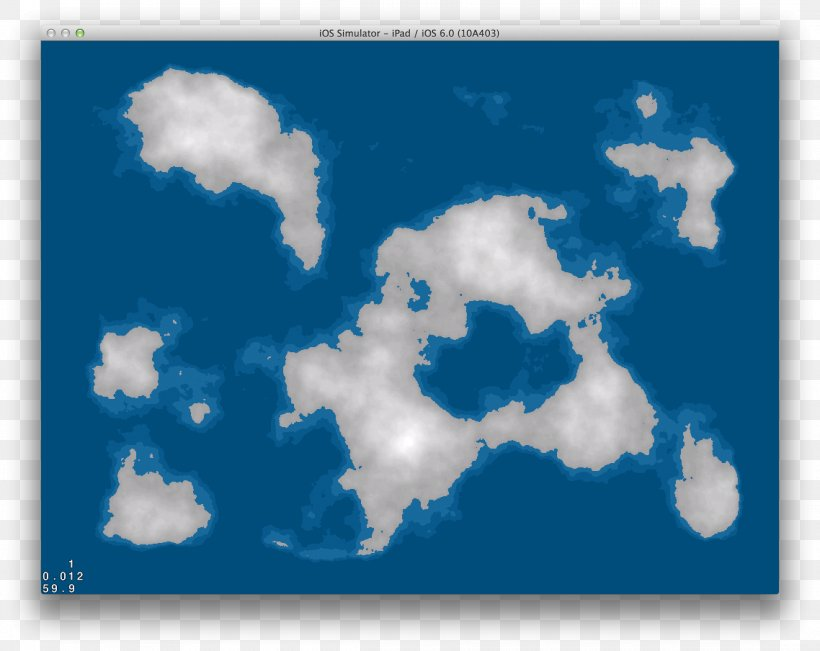

In [5]:
base64_data = "/9j/4AAQSkZJRgABAQEAYABgAAD//gA7Q1JFQVRPUjogZ2QtanBlZyB2MS4wICh1c2luZyBJSkcgSlBFRyB2NjIpLCBxdWFsaXR5ID0gODUK/9sAQwAFAwQEBAMFBAQEBQUFBgcMCAcHBwcPCwsJDBEPEhIRDxERExYcFxMUGhURERghGBodHR8fHxMXIiQiHiQcHh8e/9sAQwEFBQUHBgcOCAgOHhQRFB4eHh4eHh4eHh4eHh4eHh4eHh4eHh4eHh4eHh4eHh4eHh4eHh4eHh4eHh4eHh4eHh4e/8AAEQgCiwM0AwEiAAIRAQMRAf/EAB8AAAEFAQEBAQEBAAAAAAAAAAABAgMEBQYHCAkKC//EALUQAAIBAwMCBAMFBQQEAAABfQECAwAEEQUSITFBBhNRYQcicRQygZGhCCNCscEVUtHwJDNicoIJChYXGBkaJSYnKCkqNDU2Nzg5OkNERUZHSElKU1RVVldYWVpjZGVmZ2hpanN0dXZ3eHl6g4SFhoeIiYqSk5SVlpeYmZqio6Slpqeoqaqys7S1tre4ubrCw8TFxsfIycrS09TV1tfY2drh4uPk5ebn6Onq8fLz9PX29/j5+v/EAB8BAAMBAQEBAQEBAQEAAAAAAAABAgMEBQYHCAkKC//EALURAAIBAgQEAwQHBQQEAAECdwABAgMRBAUhMQYSQVEHYXETIjKBCBRCkaGxwQkjM1LwFWJy0QoWJDThJfEXGBkaJicoKSo1Njc4OTpDREVGR0hJSlNUVVZXWFlaY2RlZmdoaWpzdHV2d3h5eoKDhIWGh4iJipKTlJWWl5iZmqKjpKWmp6ipqrKztLW2t7i5usLDxMXGx8jJytLT1NXW19jZ2uLj5OXm5+jp6vLz9PX29/j5+v/aAAwDAQACEQMRAD8A+saPyoooAu6Z/wAtPw/rV2qOmf8ALTn0/rVsv6frQA7saxq1TJ71imTigCX8quaYf9ZyO39azPMq3psgzJ+H9aANUEeooyPUVW82jzKAM/PuKM/Sq/mCjzPegDU0w/6zp2/rV3PPUVlabJ/rOfT+tXPM96ALOfcfnWN+IrQ8z3rH833oAsZ+lXNMP+s5Hb+tZfmVc02T/Wfh/WgDVJHt+dGenIqt5nvR5g9aAM/PuKPxFV/M96PM96ANTTD/AKzkdv61dz7j86ytNkH7zn0/rVzzKALOfcfnWNn6VoeZWP5o9aALH41c0w/6zn07/WsvzKuabJ/rPw/rQBq59x+dGfcVW82jzR60AZ+fpRn3FV/Mo8ygDU0w/wCs5Hb+tXc+4rK02T/Wfh/Wrnme9AFnI9qxs/StDzKx/NoAsZ+lXNMPMnI7d/rWWZfermmyj95z6f1oA1c+4pM+/wCtV/N96PNHrQBn5+n50ce1V/NoMlAGpphH7zp2/rV3I9R+dZWmyf6z8P61c833oAs59x+dYufcVo+bWP5lAFjPPUVc008S8jt/WsvzPermmyf6zn0/rQBqk89qQHgciq/m0eZ70AZ2eOtLn3FV/M96PMHrQBqaYf8AWcjt/WrmevIrL02X/Wc+n9aueZ70AWM89RWNnjtWj5g9ax/N96ALGeeoq5ph+/z6f1rL8z3q5psn+s59P60AaueuCKM+4/Oq3me9Hme9AGfn6UZ+n51X833o8z3oA1NMP+s5Hb+tXc+4rK02QfvPw/rVzzR60AWc+4/OsbPNaHmj1rH80etAFjP0/OrmmH/WdO39ay/Mq5psv+s59P60AaufcUZ9xVbzPegSe9AGfn6UmfcVB5vvR5vvQBqaZ0lGR2/rV3PPUVlabJ/rOfT+tXPN96ALGfpWPn3FaHm1j+Z70AWM89RVzTD/AKzn0/rWX5g9auabIP3n4f1oA1c+4pAenI6VX80etHme9AGd26ilzz2qv5nvR5vvQBqaYf8AWcjt/WruRzzWVpsv+s59P61c8z3oAs59x+dYuf8AOa0fM96x/M96AJ8/SrumH/WdO3f61l+b71c02X/Wc+n9aANXPHUUZ+n51W8wetHmD1oAz8+4oz/nNV/NHrR5vvQBqaYf9Z07d/rV3PuPzrK0yQfvOfT+tXPMoAs59xWN+VaHme9ZAkoAn59qu6Z/y06dv61mCQVe0yT/AFnPp/WgDS/Kk59qYHPrTgcjrigDH/Kij8aPxoAKKP8AgQooAu/Yf+mp/wC+f/r0n2H/AKan/vmrv501zigCizfYv9vf+GMf/rqJ9R4/1X/j1GrN/q/x/pWRPL70AaD6mB/yy/8AHqheHH/Lb/x3/wCvWPNcAd6fJqEMcDzzuAigszMeABzQBoNGM/67/wAd/wDr0n2oWffzN/4Yx/8ArrD/ALbjCRTT2MsFvMwVJXZDyem5QxZc+4+uKm1C/sraASzRB/mCooGWZj0AoA1v7XH/ADzP/fVH9rj/AJ5n/vqsSO/thdJa3Wn/AGWWRS0YZkcOB1AKkjPsai1bV9PsJbe3Fn9ourgt5UKbVJC43MSxCgDI5J7iplJRV3sJtJXZv7B/z2P/AHz/APXo2D/nsf8Avn/69Yek67aX8txbm3a3urYjzYXKsQD90gqSpBweQexrQ+0Q/wBxaIyUldbAmmrouC6Fn3L7/wAMY/8A10v9rj/nmf8AvqqDTW7/AHokOPUUm+0/54x/lVDND+1x/wA8z/31SbB/z2P/AHz/APXqhvtP+eMf5U/7RD/cWgC5sH/PY/8AfP8A9egXQs+5ff8AhjH/AOuqf2iH+4tNaa3bG6NDj1FAF/8Atcf88z/31R/a4/55n/vqs/faf88Y/wAqN9p/zxj/ACoAv7B/z2P/AHz/APXo2D/nsf8Avn/69U/tMP8AcWj7RD/cWgC4LoWfcvv/AAxj/wDXS/2uP+eZ/wC+qoNNbvjdEh+opN9p/wA8Y/yoA0P7XH/PM/8AfVJsH/PY/wDfP/16ob7T/njH+VP+0Q/3FoAubB/z2P8A3z/9egXQs+5ff+GMf/rqn9oh/uLTWmtm+9Ehx6igC/8A2uP+eZ/76o/tcf8APM/99Vn77T/njH+VG+0/54x/lQBf2D/nsf8Avn/69Gwf89j/AN8//Xqn9oh/uLR9ph/uLQBdF0LPuX3/AIYx/wDro/tcf88z/wB9VQaa2fG6NDj1FJvtP+eMf5UAaH9rj/nmf++qTYP+ex/75/8Ar1Q32n/PGP8AKn/aIf7i0AXNg/57H/vn/wCvSi6Fn3L7/wAMY/8A11S+0Q/3FpGltm+9Ghx0yKAL39rj/nmf++qP7XH/ADzP/fVZ++0/54x/lSGS0Az5Mf5UAaGwf89j/wB8/wD16Ng/57H/AL5/+vXJXfjjQbZQxjvJALZbqbyrOR/s8TZw0mB8nQ8HnAJxgVb03xRpOpajNZWMc84hO17hIGMG7arbfM6E4YH8aAOiF0LPuX3/AIYx/wDrpf7XH/PM/wDfVcu3irRpLq/hFtdTLp4fz5ktHaNWVQzIGA5bBHA+lXpdT0WJmWWeyjZBuYPIoKj1OTx1FAG1/a4/55/+PUmwf89j/wB8/wD16zPtWnZxi36gdR1PT86qaT4k0fUrG0u4JY0F3F5sUcrBZCvrtz7UAb2wf89j/wB8/wD16BdCz7l9/wCGMf8A66xrXX9FuraC5t76zkiuDiFxKMSH0HPJ9qnW90+eVolaCSSP7yBgSvOOR26H8qANP+1x/wA8z/31R/a4/wCeZ/76rP32n/PGP8q5+98Z+GbKaOK5SdCyh2b7HIVjUyGMM5C/KCwxk/XpQB1+wf8APY/l/wDXo2D/AJ7H/vn/AOvWWNX0swyzC6tTHCcSv5i4Q+hOePxqPR9asNVsRe2i5hMskQLDqY5GRj9Mqce1AGwLoWfcvv8Awxj/APXS/wBrj/nmf++qwl1vSp9KXVEUy2rHCMIiScttyBjOM9/TnpWcPF/hw3/2Xy5QhuTaC6Ns32czA4MfmYxnPHpnjOeKAOu/tcf88z/31SbB/wA9j/3z/wDXrnfD2vaTrlp9rsbScW7KrxSzWzRrKjDIZCRyCP6etSaP4i07Vnk+xQXDQoSFuGgZYpcHadjHhuQfr1GRzQBvbB/z2P8A3z/9ej7ULPuX3/hjH/665yz8V6Ld6w+lwmTzg0iK7QsI5Hjx5iq54YrnkD0PocJq/ifRbCPUJLqOaRNNiWW5MVu0uwMCcYUE5wNx9AQTgGgDpf7XH/PM/wDfVH9rj/nmf++q5bUvFGgaffRWlwjb3WN3ZIGZIVkbYhkYDChmyBn0PYVPba9oNzr93oULxNqFpEks0Ww/KrdDnoe30yPWgDodg/57H8v/AK9Gwf8APY/l/wDXrlz4z8PGC7lhla5+y3gsWSGJmZ58A7EH8R56jgYPPBpH8ZaKtpZ3oiumtLplQTrbOUjZn8sK/HynedpB6HrigDqRdCz7l9/4Yx/+ul/tcf8APM/99Vj2OqadqMcjwoCYZnhkV1wyOpwQR+RHqCD0NWN9p/zxj/KgDQ/tcf8APM/99Umwf89j+X/16ob7T/njH+VP+0w/3FoAubB/z2P5f/XoF0LPuX3/AIYx/wDrqn9oh/uLTWmtm+9Ghx0yKAL/APa4/wCeZ/76o/tcf88z/wB9Vn77T/njH+VG+0/54x/lQBf2D/nsfy/+vRsH/PY/98//AF6p/aIf7i0faIf7i0AXBdCz7l9/4Yx/+ul/tcf88z/31VB5rZsbo0OPUUm+0/54x/lQBof2uP8Anmf++qTYP+ex/wC+f/r1Q32n/PGP8qf9oh/uLQBc2D/nsfy/+vQLoWfcvv8Awxj/APXVP7RD/cWmtNbtjdEh+ooAv/2uP+eZ/wC+qP7XH/PM/wDfVZ++0/54x/lRvtP+eMf5UAX9g/57H/vn/wCvRsH/AD2P/fP/ANeqf2iH+4tH2iH+4tAFz7ULPuX3/hjH/wCul/tcf88z/wB9VQaa2b70SHHqKTfaf88Y/wAqAND+1x/zzP8A31SbB/z2P/fP/wBeqG+0/wCeMf5U83EP9xaALmwf89j+X/16BdCz7l9/4Yx/+uqf2iH+4tNaa3bG6JDj1FAF/wDtcf8APM/99Uf2uP8Anmf++qz99p/zxj/Kjfaf88Y/yoAv7B/z2P5f/Xo2D/nsfy/+vVP7RD/cWj7RD/cWgC4LoWfcvv8Awxj/APXS/wBrj/nmf++qoNLbN96NDj1FJvtP+eMf5UAaH9rj/nmf++qBGD/y2/8AHf8A69Z++0/54x/lT/tEP91aANBYh2m/8d/+vUyTi0/6ab/wxj/9dZQuoh/CKhmuwXCgnA6ZNAHQx6lnny//AB6p11DP/LP/AMernoJs9DV2KTOOaANgWWf+Wp/75p32D/psf++anRulSjpnmgCl9h/6an/vmirmP9786KAF6c1HIetZQqKU8UAO1lsCP8f6VgXcuAea2YGx5n4f1rP1CTAPNAHOXlzjPNULq6W4tJbZ2IWRSpNW9SuME818h+LtX1VPFerJHqV4iLezBVWdgAN54AzXXhMI8TJpO1jixuNjhIqUle59a309lPpcVusWyXI8xt2Rgen+fzqO7uUuPJ38+VIJAD0PBH8ia+Of7a1j/oK33/gQ3+NH9tax/wBBW+/8CG/xru/saf8AMjz/AO3af8jPsvUbmzlvbae2jMYhyeTkliCPywTVK68m41a1vpVEgiVkdCcblJB4Prx+tfIP9tax/wBBW+/8CG/xo/trWP8AoK33/gQ3+NZ1cidWLhKSsTLO6UlZwZ9fWvk2+rXV9GojEqqiIDnaoJPJ9eavf2ifU18Z/wBtax/0Fb7/AMCG/wAaP7a1j/oK33/gQ3+NFLInSioRkrBHO6UVZQZ9mf2l7mj+0vc18Z/21rH/AEFb7/wIb/Gj+2tY/wCgrff+BDf41p/Y0/5kV/btP+Rn2Z/aXuaDqPua+M/7a1j/AKCt9/4EN/jR/bWsf9BW+/8AAhv8aP7Gn/Mg/t2n/Iz7M/tL3NH9pe5r40/trWP+grff+BDf40f21rH/AEFb7/wIb/Gj+xp/zIP7dp/yM+yxqXuaP7R96+M/7a1j/oK33/gQ3+NH9tax/wBBW+/8CG/xo/saf8yD+3af8jPsz+0fc0f2j7mvjP8AtrWP+grff+BDf40f21rH/QVvv/Ahv8aP7Gn/ADIP7dp/yM+zP7R96P7R9zXxn/bWsf8AQVvv/Ahv8aP7a1j/AKCt9/4EN/jR/Y0/5kH9u0/5GfZn9pe5o/tL3NfGf9tax/0Fb7/wIb/Gj+2tY/6Ct9/4EN/jR/Y1T+ZB/btP+Rn2YNR9zR/aXua+M/7a1j/oK33/AIEN/jR/bWsf9BW+/wDAhv8AGj+xqn8yD+3af8jPsz+0vc0f2l7mvjT+2tY/6Ct9/wCBDf40n9tax/0Fb7/wIb/Gj+xqn8yD+3af8jPs3+0vc0n9o/WvjP8AtrWP+grff+BDf40f21rH/QVvv/Ahv8aP7GqfzIP7dp/yM+zP7S9zR/aXua+M/wC2tY/6Ct9/4EN/jR/bWsf9BW+/8CG/xo/sap/Mg/t2n/Iz7M/tE56mj+0vc18Z/wBtax/0Fb7/AMCG/wAaP7a1j/oK33/gQ3+NH9jVP5kH9u0/5GfZn9pe5o/tL3NfGn9tax/0Fb7/AMCG/wAaT+2tY/6Ct9/4EN/jR/Y1T+ZB/btP+Rn2Z/aPuaRtRJUjJ5FfGn9tax/0Fb7/AMCG/wAaX+2tY/6Ct9/4EN/jR/Y1T+ZB/btP+Rn0xpWj6ppOmyWVhdWT/adPhtJ2l3Dy3jjMe9QB8wI/hO3kdeat6LpMum63a3Vqbe2gt7cQStFI++8VUCx+YmAoZcZ3ZJ7dK+W/7a1j/oK33/gQ3+NH9tax/wBBW+/8CG/xo/sap/Mg/t2n/Iz6c8QaJd6nd6nJbtZ2AvrOe2maKRz9q3ptQypgKCv94ZPbpSTeGbefVGvZ47GVnvprli8O5mDweWoJI5wef/r18yf21rH/AEFb7/wIb/Gj+2tY/wCgrff+BDf40f2NP+ZB/b1P+Rn01aaLqNvLaIl1Zm3iazeUkNvLQIFwvGMHAOT9Md6gtfDupQT6Nuu7KWHTfJIUgqflDhx93JyH4ye2Mck182f21rH/AEFb7/wIb/Gj+2tY/wCgrff+BDf40f2NU/mQf27T/kZ9Hnwtc/2WliG005086eXKtmJd5YTIMffOeRxyq/NxXT+HLePSPt7YiMt5eSXDyIuGYMeAx7kCvkn+2tY/6Ct9/wCBDf40f21rH/QVvv8AwIb/ABo/sap/Mg/t2n/Iz7B090si5S5vJt+P9fO0mMemelc3pnhq3jvIptRdLmOKJlWJXcKWNw8wLKCAwG4cNnkV8xf21rH/AEFb7/wIb/Gj+2tY/wCgrff+BDf40f2NU/mQf27T/kZ9HWvhzVY53uZ7jTp5TJbSsjBhHK0Jk+8oQBQfMyMA4Kjr1rf05L7SfB02m2pgN5/pBi8kbI1aSR2XAPQDeOPavlP+2tY/6Ct9/wCBDf40n9tax/0Fb7/wIb/Gj+xp/wAyD+3af8jPrPVbVLjwumh2jrFHGsKRls4CxspH6LWaNLvxaR6R9otf7Nj1H7csnzecf33nCMrjH3+N2enbNfL39tax/wBBW+/8CG/xo/trWP8AoK33/gQ3+NH9jVP5kH9u0/5GfVvhS1n0i4vnIt7a2udhSztZHeGJxu3uu4DbuyPlAwNvvWf4Y0a70CXfZPZJ5VsbdMF/9I/eBhJKMcMqgqMZ6nkDAr5i/trWP+grff8AgQ3+NH9tax/0Fb7/AMCG/wAaP7GqfzIP7dp/yM+p9N065tdWt3eeE2Vnd3V3Btz5jPOWJDDGAF8x+QTnjgYpdQtr2W28S2duYdusfOkkrkBS0KwsDgE8BAw45zjivlf+2tY/6Ct9/wCBDf40f21rH/QVvv8AwIb/ABpf2NP+ZB/b1P8AkZ9Q6lpl/fSzkzWsaX9vb294AzEoIXZsx/KN24ORzjHB56VDD4euI9STVP7YuBezS3Bu9hVV8uYYIjO3cCu2LBYkfJXzJ/bWsf8AQVvv/Ahv8aX+2tY/6Ct9/wCBDf40/wCxqn8yD+3af8jPpqy8PS6ZuaxvzN5N9DdWkVxtChUgEJViiDBK7uQD0XjOcvn0a6fSrGyElqZIbtrxrrzHDQytOZn2IBhhkkDcRXzD/bWsf9BW+/8AAhv8aP7a1j/oK33/AIEN/jR/Y1T+ZB/btP8AkZ9c6FJLazanczDY99emfYDnaojSNfxIjB/HFaf9pe5r40/trWP+grff+BDf40n9tax/0Fb7/wACG/xo/sap/Mg/t2n/ACM+zBqXuaX+0fc18Zf21rH/AEFb7/wIb/Gj+2tY/wCgrff+BDf40f2NU/mQf27T/kZ9mf2j7mj+0uOpr4z/ALa1j/oK33/gQ3+NH9tax/0Fb7/wIb/Gj+xqn8yD+3af8jPsz+0fej+0vc18Z/21rH/QVvv/AAIb/Gl/trWP+grff+BDf40f2NU/mQf27T/kZ9l/2l7mj+0j6mvjP+2tY/6Ct9/4EN/jR/bWsf8AQVvv/Ahv8aP7GqfzIP7dp/yM+zP7R9zR/aWD1NfGf9tax/0Fb7/wIb/Gj+2tY/6Ct9/4EN/jR/Y1T+ZB/btP+Rn2Z/aXuaP7S9zXxp/bWsf9BW+/8CG/xo/trWP+grff+BDf40f2NP8AmQf27T/kZ9mf2j7mk/tI+pr4z/trWP8AoK33/gQ3+NH9tax/0Fb7/wACG/xo/sap/Mg/t2n/ACM+zP7R9zR/aPua+M/7a1j/AKCt9/4EN/jR/bWsf9BW+/8AAhv8aP7GqfzIP7dp/wAjPsw6ifU0f2j7mvjP+2tY/wCgrff+BDf40f21rH/QVvv/AAIb/Gj+xqn8yD+3af8AIz7M/tL3NH9pe5r4z/trWP8AoK33/gQ3+NH9tax/0Fb7/wACG/xo/sap/Mg/t2n/ACM+zP7R9zR/aXua+M/7a1j/AKCt9/4EN/jS/wBtax/0Fb7/AMCG/wAaP7GqfzIP7dp/yM+y/wC0ucZNA1L3NfGf9tax/wBBW+/8CG/xo/trWP8AoK33/gQ3+NH9jVP5kH9u0/5GfZn9o+5o/tH3NfGf9tax/wBBW+/8CG/xo/trWP8AoK33/gQ3+NH9jVP5kH9u0/5GfZn9pe5oGo+9fGf9s6x/0Fb7/wACG/xo/trWP+grff8AgQ3+NH9jVP5kH9u0/wCRn2Z/aPuaP7S96+NP7a1j/oK33/gQ3+NJ/bWsf9BW+/8AAhv8aP7GqfzIP7dp/wAjPsz+0vc0f2j7mvjP+2tY/wCgrff+BDf40f21rH/QVvv/AAIb/Gj+xqn8yD+3af8AIz7M/tLnqaWO+3yZzXxl/bWsf9BW+/8AAhv8a94/Zxv7mfwzevdXEs7/AG0gNI5Y42Lxk1z4nLpYeHO3c6cJmkMTU9motHtdlPnHNa9s/Q1laZNkDmuisnyBzXnHqG1EasIflrm7c5Aq0poA3MCisXI9RRQAhqGXpWmbH5f9b/47/wDXqvNZdf3v/jtAGbC3Ev4f1rK1N8A1qXv+hqf49/4Yx/8Arrm9UveD+7/8eoAwdWlxnmvkPxYc+KNVPrezf+hmvqnWLzk/J+tfK3isY8T6qM5xeS/+hmvZyb+JL0PCz3+HD1M2iiivoD5kKKKKACiiigAooooAKKKKACiiigAooooAKKKCCOoIoAKKKKACiiigAooopgFFFFABRRRSAKKKKACiiigAooopgFFFFIAooopgFFFFIAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKYBRRRSAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAr3T9nOTb4cvRn/l9P8A6AteF17V8ApfJ8O3RxndeHjP+wlebmv+7/NHq5N/vPyZ75pEnTmup09uBXC6Pen5f3f611enXvT93/49XzB9caNqSRVxKbbWXGPN/wDHavR2PH+s/wDHaAKhH+cUVdNj/wBND/3z/wDXooAuHpVebpVg9OMVXm6GgDA177qfj/SuQ1Toa6/Xvup+P9K5DVOhoA47WO9fMXiz/kaNV/6/Jv8A0M19O6x3r5i8Wf8AI0ar/wBfk3/oZr2cm/iS9Dws9/hw9TMooor6A+ZCiiimAUUUUAFFFFABRRRQAUUUUgChVLHCjJqzbWcsrAYI9q7Pwp4E1HVgJVQQW/eRwRn6dz/KpqTjTjzTdkXTpzqy5aauznvDmg32qXKx21tJM3faOB9T0Fd5dfDXUfskUsbW7y7MvGSVwfQHof0r0XwH4ZTQdPe2DiV3fc7Bcdun+fWuoFoHGGWvDxGbz57Udl+J9Fhckp+zvWvzP8D50v8A4f63Go/4lsn/AAAq38jXMX2i3lncyQXEbxyIcMpXkV9YT26oNu3FY2raVYalCYLy2SVSCORyM+h6j8KdPOZX/eR08iauQxt+6m7+Z8wrp85J4OB7VMNMcKCQxz719IaX4Z0uztntoLGLypBh9w3Fh7k8mq9z4H8PylGOnKpX+4xXP1wea6FnNG+sXY5nkNeytJXPnG4sZUPyo3vVd4pEGWU4r6kt/B2heWVXTLfBBH3fXGf5Vgal8L9Ge4lkX7REXyQqsu1foCOn4045vQk9U0TPI8RFe60z53or0Xxr8ObjR4Xu7dvOtx1KjDL9R6e9cBPbSwttZT+VejSqwqx5oO6PLrUZ0ZclRWZDRQQQcEEfWitDMKKKKACiiikAUUUUwCiiikAUUUUwCiiikAUUUUwCiiikAUUUUAFFFFMAooopAFFFFABRRRQAUUUUwCiiikAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRTAKKKKQBRRRTAKKKKQBRRRQAUUUUAFFFFABRRRQAUUUUwCvZPgX/wAi5cf9frf+gJXjdeyfAv8A5Fy4/wCv1v8A0BK8zNf93+aPVyb/AHn5M9l0f+Gur07oK5TR/wCGur07oK+YPrjs7arsRqlbVdj/AAoAk69hRSdPT86KAMc9DVebpVg9KrzdDQBXi+7J+H9axtV6NWzF92T8P61jar0agDi9Z718neJ/+Rk1P/r7l/8AQzX1jrPevk7xP/yMmp/9fcv/AKGa9nJv4kvQ8LPf4cPUzqKKK+gPmQooopgFFFFABRRRSAKKKtWFq1xIP7o9aaQiusTtghTg9K3NIsbffG8+QjMATjOB3Nd34c+G891EkmoSLbIQCFUBmII/IV2WgfD3TLC482ZvtijG1ZVGFI78Vw1cyw9O6Tu/I9GjlOKq2bjZef8AluO0LwBokLeYLeS4DLgLMQQPcAAV3MOneWgG361PYbI0VV4A4rQBXpxXzFWtUqu83c+upUKdFWpxsVrW0wPu1cS3K4GMCpIHAO04q6UDciszYxdQtwynaKx/s5V+eldbLbsykYrOlsyWxtxQBnQRjZnHNSNbknJWr8VmVOcfnVgQjigChZ22G6VqLaKVGVB+tNRVRs4FW7clzyOKAMTV9KVoi6Jn6V5R4p+HNnci4nsl8m5cgqrH92D34xkV775SFSpHB61l32lxtkqo5rWjXqUJc0HYwr4anXjy1Fc+Q/EXhS/0668i4tiCBkFSWBGQMgjtyOtY+o6BqFkAZ7eWPIyA6FSfzFfXV3oZ+9jmsXW/DtveWbQXluk0R6q3b3HofevXhnT054etjxKmQrXkn6XPkt0ZDhlIptekfETwn/ZmokWkM32Vk3bypYA9wTXBXdk0LEA5xzivapTjVgpw2Z4FalKjNwnuipRUnkS5xtproyHDDFXYzuNooooGFFFFIAooooAKKKKACiiigAooooAKKKKACiiimAUUUUgCiiigBVUscKMmgo4IBU80+2dUly3QjFX+2ciqSuS3YzWUqcMMGkq7cWsjneAw47jioJLd1xj5s+lDQ0yGip/srYGGBpUtHLAEj8OtKzC6K9FWWs5Fb5sge4wajnhMYyDkUWYXRFRRRSGFFFFABRRRQAUUUUwCiiikAUUUUAFFFLGMyKMZ5pgJWrYosjorrlSORmotiZzsH5Vc06L59+MKowKtKxDdyd7K3ZNoXb9DWZd6Y8WXRwV/lXSfYb37It2LSc27cCUISp5x1+tTarpU1ha2jXS4e6QyBMdF7Z9//rVLnC6VylTnZytojiHhkXOVyB3FMKkdQR9RW/dWowZI+MD7oFUJEVxhhmnyk8xn0Urja7L6GkqSwooopAFFFFABRRRQAUUUUAFFFFABXtf7Pn/IBvP+vs/+gLXile1/s+f8gG8/6+z/AOgLXm5r/u/zR6uTf7z8me5aL/DXW6b0WuS0X+Gut03otfMH1xJbVej4AqjbVejoAdkUUvNFAFz7DwT5v/jv/wBeq81jx/re392tU9KrTdPwoA5+9/0Nf7+/8MY//XXN6pecH93/AOPV0uvfdT8a5DVOhoA5fWLrr+7/AFr5Y8Ujb4m1Qel5L/6Ga+ntY718xeLP+Ro1X/r8m/8AQzXs5N/El6HhZ7/Dh6mZRRRX0B8yFFFFABRRUluqsxLj5QM0wI6Km8uNziMtn6cUgt5C2CAB60WYrkajLAYzk1s6e5jlCBflbjA7VUtbb94FBBY9Ca2LOzCsNvJ4BY8Bc+voKtK25Ld9j0f4V6ld3FzcwXN3PKscamNHbKqAcd+R2r0mKRsDnj0rl/BegRaPp235HuZBmWRSSG64A9ua6BZCMDHI4r43HVIVK8pQ2PusvpVKWHjGo9TVgfHI5rQtjv6nBxWTbyZGDWnZocBs1ynaX4oySCa0rR14UiqMRwnJqWJ9rA5oA24o0ZM5AqF7dN5PFRQT/LjnFSo+4nJ+lACNEpHAqBogB93rVoMD0NI5AwTigDNkiYEnHFSWxIXrVySNWGargBOMUATLKT2p5JMeRVbcaeHOzBPFAD1AbhuR71TvoInjZdtWVOarXTYBBoA4zxBpMU0MkNxEssL/AHlYZBrxL4j+FbfSZIpbefEcztsiIyUx6HOSOa+hL8EkjOc1zWt6XY34C3lrFMBnaHUHB9RXZgsXLDTv06o4Mfgo4qna3vdGfM2x1Y5RuPUGoZoxImDwexrvPG+gnRNRBRlNvcM7QqM/KAR8pz6ZrkL11EmxVXI6nHNfW0qkasFOOzPiq1KdGo4TWqMR1ZGwwwaSrkskTZRiOnX0qnQ1YSdwooooGFFFFABRRRQAUUUUAFFFFIAooooAKKKKACiiigAooooAKnguNoCvyPWoKKadhNXNhL53XClSBx0qnczbOB94/pVaKRozlfyNNdi7Fj1NVzaC5Se0LtIcsSO+TV+2lMUoYjI6GqlqUMeFxnvU3FNbEvc1Loxm3bcQeMjnv2rFuZEVSh5JHSpu1Z8qsrkNyfX1ok7DSG0UUVBYUUUUgCiiimAUUUUgCiiigB0SGRwoqyLaPHJYmltNvlcDB6GpHdUA3HGatJWIbZE9vHtJBK+9PgjRVBXBPrQHEsbbQfSoo3MLmNz8vY4p6BqWhyQOld78NdGstR1JhdMrpboHERAPmZOMn2H9RXAKyt91gfoa6nwNrK6RqMd46ySIqskiq2CQf/r4/KscVGcqMlT3sb4OUIV4uotLnt9pBbW8CW9vCscajCqowBWJ4s0O21h7WKeZlELM2xAMuOOM9h059/pWrouoW2o2UV5btmOUZHqD6H3qeVTu618dGc6U+bZo+6lTp1qfK9Ys8FuomgupYXRo2RypVuq4PSse9jKTN2Dciuh8QSpPrt9NHnY9w5GfTcaxb+FifNXn1HpX20G3FNn5/USjNpGC3DHnPPWkp0ilXIPrTQCegzUlBQOTgVa+WFFV1DZ6mlSFTL5it8vUAU+UVyqysv3lI+opKt3m3yxk/N2qpSasCdwooopDCiiimAUUUUgCvaPgHJ5Xh66bGd14R19EWvF69k+Bf/IuXH/X63/oCV5ua/7v80erk3+8/Jnt+jXeNv7v9a6zTbzgfu//AB6uJ0f+Gur07oK+YPrjp7ax/wCmv/jtXo7HP/LX/wAd/wDr022q7HnHFAFb7CO8v/jv/wBeirv1zRQAh6Gq03Ss81Xm6UAQ6991PxrkNU6Guui+7J+H9axtV6NQB5zrHevmLxZ/yNGq/wDX5N/6Ga+r9Z718neJ/wDkZNT/AOvuX/0M17OTfxJeh4We/wAOHqZ1FFFfQHzIUUUUAFFFAAwTnn0pgW7Rl8sKPvDrU9Z8RCurEng84qcXAUgAEjuSeapMho0tPGZ88cCu28GaholrDeQaqjp58RQuMkMv93A6H3rgonKMHXgjmtG1nEwPGGHbNTWpKrDlb+40oVnRmppJ+p9AabcW9xbpJaSpJERhWU5GKvxplq8T8KeI7nQpnwrT27/ei3YAP94e/wDOvVvDmrjV9PjvY42jRyRtZgTwcdq+UxmBnhnfePc+ywGY08VGy0l1R0lsiAYrSjcJHWTbvxirkUgbtXCeiX4ZS+asRg8MRxVKyBaStuGJWTp0oASJu3Y1ajwPyqJIQD0qdYztJFAEbMQfSgEvzmiWNjwQcU63jKkAjIoAliBxzyKc6BhyKcijnHApxUYoAqGFs4xUnlLjGeakkbHIGaiUtu3YJoAk8gY6mqV4owRV2WXavXms26lzmgDGvQQ1Y15u3c1s3LEuc1m3SbiQehoA47x/aW914bvDMBuijMiN3DDkfn0rwrUI9sgcfxdfrX0bqljBd2sttcxiSKQYZT3r561iIiUhFJVGYfrX0WS1LwlDsfLZ/TtUhPujGEUTTMNp47U2eAbd0YwR2rThs3cZc7PTjJpk9s8Q3EgrnGa9qx4FzGpxjcLuKnHrVp7aM5xlTUV3uDAZ+Q9BU2sVcgooopFBRRRQAUUUUgCiiimAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQA+F9kgbt3q8rBhkHIrOqa3mEYKsOO2KcXYlotPIiHDNg1UuZRIwwOBSXDrI+VzjHeo6GwSCigcmpI4WdCwIpFEdFS/Z5cE4H0zTDG4xlTzRYVxtFFFIYUUUUwCiiikAZOMZNPRyZFLsSAe5plLGpdwo700I0RgdKguYndtwIwBwKmHAA64pa0auQtClEkkcqkrjnFalnIY5hxkNwaqRuzMQUwo6Gpo2CuGIzg560kgep6b8PvEllpdhc2d9IUAJlj+X73HK/XiovEXjq8vo2g0+NrSJuC5OXPHP0/nXF28nmxh8Y/Gn1yfUKDquq1ds7v7SxCoqjF2S+8Xrzmq93MiRtGT8xHSpZWKRswGSB0rJdizFm5J967DgI5TGFzIAR7iq4LKGeNAB2PtU86GRNoIHNIkK+Xtbk4xmkykyoWeVgGJJ6VeiQIgXrimx26CQFQSewqZo3T7yEfUUJWBshnUNGeBntmqywMWKkgEDNXHUMpU9DVKVGibJfk9DnmlIERkYJHpRRRUFhRRRTAKKKKACvZPgX/AMi5cf8AX63/AKAleN17X+z5/wAgG8/6+z/6AteZmv8Au/zR6uTf7z8mevaP/DXV6d0FZGi/w11um9Fr5g+uN22q7FXNW3arsfSgDbx7iisb/PSigAP0qCbpWobHj/W/+O//AF6rzWXH+t/8d/8Ar0AZcX3ZPw/rWNqvRq2b0fY1/v7/AMMY/wD11zeqXnB/d/8Aj1AHLaz3r5O8T/8AIyan/wBfcv8A6Ga+qNYuuv7v9a+WPFI2+JtUHpeS/wDoZr2cm/iS9Dws9/hw9TNooor6A+ZCiiigAooooAKKKKAJI5JC4wS3PStfTw3nZUfLj5qzLNwCUPU8ir1urPJsV9mfetIkSNGSYJIqEN83Qiu38BeJ5bOS20eaFGhkl2pIDtKZ9fXmuLVQAOMkDAJrX8JzWsOv2pvIFlhZwp3A/KT0YY7g4rDF0o1aUlJXOnBVp0q0XF26HuUMvycdav2pJxzWXbKS3WtSzTBHFfFH3xs6bHtbJHJrehTpgVkWZwg45rXtH38UAXI0BBLVII90f3eabEpbitGKMeXyBQBR8lcc9aGgGODirEu1W4PFMdwAecUAVgFB74pGAPQ03nJxSKCWoATGKR2CjNSyxlTVaVTvxzQBG5Dk1SuECk56VcCkmq9zGwGSaAMWZN0pAGaqXS469q0Lk7AxHBrFvbrBIJoApXxOSBXldz4M1W+ub7ULhobPfK8gjJ3nBJP8NenTSB2yKZXRh8XUw93DqcmKwdPFWVTocB8PvD1xbzjUblIJLeeAhOTkZI6qRWtffD7RroFojPb7snajArk+xHSunt4AoIDMRkn5jnGf6VOjbG2k5Fa1MfWlUdSLsZ0suoRpKnKN7dzxHxd4SudHkfMTPbZAS4VQBn0IHT8a464hLfK2VINfTGsWdtqGny2twm6ORcH1HuPcV893kcZQyMOV/Wvey3GSxMGp7o+bzXAxwlROGz/AyTDFtxtqievFaLdOKqTW5QblJI7+1ehJHlxZDRTkjZlLcADqTTaksKKKKQBRRSurIcMMGgBKKKKACiiimAUUUUgCiiigAooooAKKKKACiiigAooooAKUOwXaGOPSkopgKrFWDDqKnS4OCW64GBVeihMVgooopDCiiigAooooAfDEZCcEDHWrcUKR8jk+pqGzDbiccEda0ILd5UZhwB0z3NXFESZBzuxjjHWlq69j8g2v83fPSo/sU3qv51RJXRGdgqjJNWJbRo4i5YEjqKu6fpszuTBDLO69fLQnH5VNPDJE5iniZGHVXXBH4Gi6vYdna5Ws0CW64Oc88VNRDA0duCqsYwdu7HGeuM1fudH1O2t47iWzl8mRPMV1G5duM5JHT8aTnFOzZShKSulsZ8il0KhiMjqKqfYcIfnJbtjpVyiqIMxbaVpNm0g9yaSS3ljPKk+45rUopAQWKusWGQAdvWp8V33w78M2F9p7ahqEaz+YxSNCeFA6k++c10954N0G4bJ09U5JzGxXP5V5lbNaNKo4NPQ9ehk1etSVRNK54fd2pZt8Sj3FZN8pwDjocH2r1jx14Si061S70qBhEnEy7izD0b6V57eWgcFkA6cr612UK8MRDngcOJw1TDVOSZz9FWbtNkaqOAD0qtVtWMk7hRRRQMKKKKQBXtf7Pn/IBvP+vs/+gLXile0fAOTyvD102M7rwjr6Itebmv8Au/zR6uTf7z8me66L/DXW6b0WuI0a7xt/d/rXWabecD93/wCPV8wfXF+2q9HSW1j/ANNf/HavR2P/AE1/8doAqZoq79h/6an/AL5ooAuH7tVpuhqy3IqvN92gDA177qfjXIap0Ndfr33U/GuQ1ToaAOO1jvXzF4s/5GjVf+vyb/0M19O6x3r5i8Wf8jRqv/X5N/6Ga9nJv4kvQ8LPf4cPUzKKKK+gPmQooooAKKKKACiiigCSCTy3yRweDV1GDYKsD9Kz0UuwUdavoioAFAHrVxIkWGuZmXaX/IV1vw/06TUdds127o4sSyFuQAOf54FcfBH5kypxya9J+FWo2lnqktpOu2W5AEch6cZO38f6VhjZyhQk4rWx1YCEJ4mCm9LnrNrFtwxrWsIiSDVC1mQ4DVowTIrAg5NfFn3ptRRgRVPbyeWetY4v+doNSNejGd2KQG/DdAH71Wvt2VwDXJR3xLHJ4q1BdEtwR+FMDp1lGzLc1DLMpyaz4rklcE0SSqAcGgCY3GH6/hUqyjIPSsi4m2jOeaat22OpoA3vP+Q5OahMoY8cHNZcd7ng1YWdDjmgC8xCjJxVS9fdGaYZt1RXbfJxxQBhagXDHnisO5UvIc1vXysclvwrPMAfJA5oAzRASRUv2YmPvxWgkDDGRgU+RVVeKAMtIWXPH6U2SLPI61ekYKM4qqzlmzQBDJxFzXz5qZSY3DRRiNGZmVP7ozkCvoSVSy4rzr4g+FUWGbVbCKQuXLXEY5G3HLAfz+tetlOIhSqOMvtWPFzvCzrU1OH2bnkuPmzk4x0oYZUg9CMVau7fy2BjHynjHU5qq7BFLMcAV9OfIlSXKQBCuCT1qGpJ5TIcD7o6VHWbLQUUUUhk8bxLFkqu/pjFQuxdix6mkop3FYKKKKQwooAJOAMk0ro6feUigBKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigC9bsGhGOwwa6HQ7ObUZreztEDSycAE/iSf1Nc1Ynhh711PgfV/7H1WK7wXVCQ6A43KRg/wCP4U5uSptwWttApqDqJTdlfU7PVfALRJA1hPJMS6rKrAfKD1YH+ldRpPhLRbGdLiC03yoMBpGLc+uDxmtuwu7a+s4riBg0cihlI96vwRJtzjivkquOxE1ySl/Xmfa0cvw1OXPCK1+f3FQQ89qo6x4f0zU3je9tUlaM5DdD9CR1HtW4Fj6g0yTZkba5YzlB3i7M7JwjNWkroyxZWqWv2RbaIQAY8vYNv5VYFsph2bRtxjbjjFTlADuAqUDERJpNtjUUtjzbWfh4GneXTbpYkIJEcoyAfQEdvzrnL/wbr1mkkhtUmSMZLROGyPYdT+VeyuQFJNU/tET3LQqyl0AZlHUA5x/I16VLNcRDR6+p5dbJsLN3WjfY8dk8M65HYLetYSGJgDgcvz/s9ar6fo2q36l7SxmlQHBbbgZ+pr3EKmOcn6UbBtytbrO6tn7quczyCldWk7HG/D/Q9a0i6mF1JCts+MxhiTuwDkdu+D9K9BhGU5FV40GcAYzWrY225eeleXXryrz55bnsYfDxw8FTjsjMuIAWJxxXLeJ/DFhf2ly8drBHeyDKzEY+YeuK765t8ZAFZc0GQd3FRTqzpS5ouzKq0oVY8s1dHzbq+nSC3edomChihcDKlvY9M1zdfS/irRjq+i3Gn5Kswyh7bh0z7V89+INLuNMvpLe4iaN0bDKR0r6rB41YqLdrNdD47HYCWDkle6fXzMyiiius4QooooAK9k+Bf/IuXH/X63/oCV43XsnwL/5Fy4/6/W/9ASvNzX/d/mj1cm/3n5M9l0f+Gur07oK5TR/4a6vTugr5g+uOztqux9KpW1XovfvQA78vzooyO5NFAGMarzdKsnp0qvN0oArxfdk/D+tY2q9GrZi+7J+H9axtV6NQBxes96+TvE//ACMmp/8AX3L/AOhmvrHWe9fJ3if/AJGTU/8Ar7l/9DNezk38SXoeFnv8OHqZ1FFFfQnzIUUUUAFFFFIAooopgT2aZYv6VbqO22+SNuPeoridgSigqQeuavZEbss5IORVzTbiVLlcO2Rypz90jnNYizSA53k/WrMF4FcMRgii6YWaPXfDHj54VMOtb5Tu+WaNB09wMfpXotnqMVzbLcW8qyRuMqynINfNiagzLlVU/Suu8I+K7jRtPmiit0m81g67nOEPQ8e/9K8bG5VGa56Ks+3Q93AZxKD5K7uu/X/gntwuCBuzVC/8R6dZTLFeX0ELsQArPzz0JHYe/SvP7P4iSLAiXenB5P45I5MA+4Uj+tcHq97PPJLdzSF5pWySfU1yYfKKkpNVdF+Z24nO6UIp0dW/wPeovEWmPIscWp2bu7AKqzqSSegHNblpeEY5r5bgv5Y5VcnBU5BXgg+tegeHviRfRqiXsK3Ma4DMvyyY9fQn8qrEZPOKvSdycNnsJu1Zcp7xBfgAZPNPkvlPfn0ritB1+y1iIyWVwHKgb16MmexH5/lWp5jBsljXjSjKD5ZKzPdhOM480XdGxczk9/pUDzFUBBFU5Jvl65NRNMWWkUaMVwcdcfSrkFz8vJOfWsIE9jVi2nIbGOaQG/FMSBg1YJ3Dms2zkUjNXlmTGKYFe8iyODkiqSwkPjGM1qu6EdM01EV1PrQBUjQg7SoIqvdQ8DmtII3TBqG6gJOQeaAMSWNsHjiqhU7q17hGAxjmqLx5OelAEBG0dKw/FGo21no93JM0ZAjICsMhiRgAj0JNbU24j5eK8b+JMbL4qncxuoZEIYjhvlHI/l+Brsy/DrEVuVu3U8/MsU8NQ5oq99DnJXDM8hVVBJYhRgD6Vz+olWBIGAW4rclBMTAckqRWBffdUe9fYPY+HW5VoooqDQKKKKQBRRRTAKKKKQAAcbgDgd6e8ruoVjkCkLZXBGMdMU2mIKKKKBhRRRSAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooopgLG2xw3PBq/bXI80MmQy881n0AkHIODTTsJq56D4J8TNo96ZNrSQuMSQhsf8AAh7165pvifSbuzaeO/hVF+9vcIV+oNfN1ncNkDcQ3Yir8N5Igw4Lj3PNcOKy6liXz3sz0MHmlXCx5LXR9LpKGXKkHNMlYggg/hXl/wAMdYmi1drK4uXMEkRKK7EhWGPXpxn9K9MhuLe5hWeGRJUYfKyNkH6EV85i8LLDT5Hr5n1ODxccVT50reRNDIWHNSknHFZN3qdhp7xi8uobfzThd7YzVuDUbOVzHFcQyOFDbVcEgHoa5+SVr20Onnje19SW4B21FDCGcMQMjgGpWkDEheTT4lKgUix8cPHA4qRbcjjjFWbcKAC3AxT3KkgLigAtrUEjIrWtokjXb7VBZoR83bFaAVSmdvFAFd4d6ZrPu7YAZ71qF8gAcVTuwS9AGZ9nULuIrzT4y+HRc2o1aIorRLtlB4yM8EfTP616tKwSMk4ryz4x63ZDSxpyyB52cMyhvuAev1rty7nWIjyf0up5+Zqm8LPn/p9Dwq6jEUxUVFT523yswORTK+sZ8UgooooGFe1/s+f8gG8/6+z/AOgLXile1/s+f8gG8/6+z/6AteZmv+7/ADR6uTf7z8me5aL/AA11um9FrktF/hrrdN6LXzB9cSW1Xk6VStqup0oAfzRScjvRQBdNjxzL/wCO/wD16rzWPB/ef+O1qnpVaboaAOfvf9DX+/v/AAxj/wDXXN6pecH93/49XS6991PxrkNU6GgDl9Yuuv7v9a+WPFI2+JtUHpeS/wDoZr6e1jvXzF4s/wCRo1X/AK/Jv/QzXs5N/El6HhZ7/Dh6mZRRRX0J8yFFFFABRRRQAUUUUACkqcgkGhiWJJOSaKKACiiikBLaHEoGSAf1rQilaJtyH61lo21w3XBq7FMjrnIUjqCauLIki213KHL7sD0PQVXluQ4LtIGP1qC5mXbtQhs9aq0OQKJahuNzbXABPQ1oWDKs/wAxxxgVig4II6ir0MolB4wR2zRFg0ew/Ci8soLG8WSSCKcSBm3HBZMcHnsDn/Jr0OCVJkV0IZSMgg9RXzbbXalQknBAxn1r0PwF4xTT4V0/UnxbKP3UoBO32IHUeleHmOWyk3Wg7vsfQ5XmsIxjQqKyXU9Tn2hCM9qqBivQ1nWPiHStTl8mzv4pZMZ2cgkfQ1Zu7iG1t2uLiRYokGWZjwBXhSpzjLlasz6KNSEo80Wmi20+EyTjHUmsmy8X6FK7bdTtwR/fOz/0LGa4bxl4wN4JdP0xlNq6gPKVIZvUDPQdO2etcRLKkYy7Yr2cLlDnDmquz6f8E8PF52qdTlopNLf/AIB9HWWqxTwrLbypLG/KsjAg/jV2C6YnJNfOugeJb7TZENnduqA5MDnKH146fiOa9A0n4iWD2i/bopIpujeWu5T7jmufEZVWpO8PeR04XOaFVWn7r/A9TW7JIANXrGU5wa4zRNYs9Ti+0WVwJYw20kAjn0wa6K0ukGGLV5souLs9GerGSkrxd0dCSoHQVDKQy5HSqaXiuPvVMGGODxUlFW7UjJGPas2T0PetO7IIHOTWZOQH56UwK8kYAJBrm/FiCPTZrpRZiaAFo3uVyq56/iRxXSyupU81wfxXuIY9BWBmcSSzDYFPBxyc+39cV0YWHPWjFdWc2MmqdCcuyPKbiZUDSPjJPQAD8hWFfncgPq1Xb1y85B6LwKzr08qK+0ex8CtyvRRRUFhRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRTol3SAY4zzQA2nxxNICVxxV9Ig52IgOe2KuwWS7cyZB9BVcpHMYTxsmNwxmm1qXEO1ijrx2zUaQIxCLGCTRyj5jPoq+9ltGSjr71X+zN5mM/L60uVjuiFlZeqkUla0dtJKvC5X36VHNprAZCn/gJzT5Rcxm0VM9vIrYA3UwRSE42Gpsx3GUUrKynDDBpKBhRShHIyFJH0pyxSMuQvFADKKV1ZDhhg0lABRRU1oVEmG6ngcUITIatWWfmJJxUvkoz52ZY9quS2gjQbWyf7oWqUbEtly2bdAhzk45q3Hrt9p8fkW1/dRJnOyOQgDPesq3W5iYoqcHrnpSaiuHDYAB796coqSs1cIzlF3i7Fm51NpmDyPJM5PJdulXbC8ubK4S5tJmhlXoyn/ORXPFl3bc89cVe0+VixjY5AGRmjlTVraBzST5k9T37wrfLqej218VKtInIJ7gkH9RWtu561wngTW7W08IeZdyCGO0kMZbB5ycj6nmsq9+Id6btjaWcAgGQokJLH3OMY+lfJvL6tSrONOOibPtFmdGnRhKpLVpf8E9J1DVrWxRTd3UVuCcAyOFBP41Yt7ksQc5zzXjXinxP/bumW0Mtt5VxFIWcqflIxjjvXS+BfF63EttpN3CsbrGI45d/DkAAAjsSPeqq5ZVp0ee2ut0RRzajUr+zvo7Wfn2PXbGY4wa0FkOzaKwdPlAUEmtSOdcc15p6xI8gU8kVWurmJVOTk9qjuZ0yea47xv4ni0OCOSSCSYykhAvAyB3Parp05VJKMVdszq1YUoOc3ZIXx34hOk6JPcrgyn5Ihn+I9D74649q+c9Z1Ca7uJJJpGeSRizEn1rovHPi+61zasoWNY8hI16c9+etcWSSck5Jr6jAYT6tT974nufH5ljfrVX3fhW3+YUUUV3HnhRRRQAV7R8A5PK8PXTYzuvCOvoi14vXsnwL/5Fy4/6/W/9ASvMzX/d/mj1cm/3n5M9v0a7xt/d/rXWabecD93/AOPVxOj/AMNdXp3QV8wfXHT21j/01/8AHf8A69XY7HP/AC17f3aS2/pV6KgCt9hP/PX/AMd/+vRVwZooAD0NVpuhrPPeq83SgCDXvup+NchqnQ110X3ZPw/rWNqvRqAPOdY718xeLP8AkaNV/wCvyb/0M19X6z3r5O8T/wDIyan/ANfcv/oZr2cm/iS9Dws9/hw9TOooor6A+ZCiiigAooooAKKKKACiiimAUUUUgCiiimAUUUUgClRirBh2pKKYE5um3cKMelXLa9PyhXPH8JrMp0bbHDYzimpEtHVadeTQvHdW8rQzLyGRsFT3qTVtdu71915ey3LDgKW4H4dBXNrdoB/EM9aessbDIYfjT5Yt81tQU5qPLfQtS3Uj5XO0egqpcybE6ncelVJH/fFge9SzyxPHwPm/lTuKwQXB3YkOQe9W4bkRsNko+meDWZRUqQ3E7LQvEN3pryNZXLW7SLtYHkH357iuy0X4i3cKbNQt1uFAwJIjtbPuOh/SvIYZ2QbWGRV+xuQHBVsKThgfSsauFo1/jjr+J0UcZXw/wS0/A+kfDev2uqWoubSUuucMCCCrehroYrgkDJNeHfDfV5bLWEsXkVbW4JLZwAGA4Ofwx+VewxS4QYwa+Xx2F+rVeVbdD7DL8X9aoqb32ZflmHPP61WmdWGKgmYt14+lNU9iTXGdwPnPWuQ+Jen3N9oBaHaTbv5zKRyQAQcH8a7HIrF8UalHpmlTXjKjFBhUZsbye1bYacoVYuC1uc+KhCdGUZuyseDXNujhpBkNjPHesK8B83J6EcV1NxJ508kvlpHvYttQYUZ7AelYWoQDe6DAIORX2z1R8AtGZtFFFQWFFFFABRRRQAUUUUAFFFFABRRRQAUVJFC79Bgepq1FaqSAFLNTSbE3YqwRGQ5OQvrVyKJUGFBJNdN4X8K3+rl/ssSER/eZzhAfTp1rqLX4b6mwZpbi1ifOMAFsj64rGpiqFJ2nJXOing8RWXNCDaPOUgn3AhGU+vTFalrFPM0cKKZJWO0Ko5Jr0uD4a2pkXzL65ZdvzBQoJb1zzx7frXX6F4W07TIsWloivz+8YZc57bjzjpXFVzijFe5qzvo5HXnL95ovvPCNU0+W2untL2ExzRH5lJ6ZGe1dF4L8IPqrvJdJLa2ijAZQAzt6DPb3r1258O2Nxex3U9lDJPH912QEj/P6Vox2AUYAxXFVzmUqfLBWff8AyO+hkUIVOabvHov8zzmf4bWDxnyLy6R8DG4Kwz64wP51mH4XS/atxvofJP8AF5R3dPTOP1r2SGzXGADUd3DgdMVxxzLEx+1+R3SynCSd+T8zyU/DmNYyo1N/MyNp8nAA78ZrWPgHRDbLHtnDhMGQSck+uOldfKihiSDQxGz2xUyzDEy3mXDLMLHaC/P8zyXUvh/qUd8kVsIrmBzgzHC7PqCc/lmszxD4Lu9GgN1KkU1uCFLxk8E+oP5V6+l3avdtaLcRNOq7mjDfMB9Kmu7OC+sJbW4QPHICrD1FdUM3rxlHn29NziqZLh5Rl7PfprsfOktgpztYH0DCqr6c2zPl/gDzXaeNtGh0TWBb27SNC8YkXf25IIz36frWbpem3up3HkWVu8zgZOOij1JPAr6KFaE6aqX0Pl50KkKrpW18jmkUIoUdqWuu8XeGbnRhGs7xypMCUdOPmHb9RXKSRSIMuhA6VVOpGpFSg7omrSnSk4TVmiNlVuoB+oqjLG6kkrgZq+eBmq91KNmwHJPWqkSirUltzOuajoUlSCDgioRRsWTbblffitOudiusffGD2Iq5BfuflV8n0Yc1pdENGsenPSsu7m8yQkn5F6Ur3MzKVLcH2qleHEWPU0MEPAjdg4OSvcU5JVL4R/mHcVQVmXO1iM1LaITJuxwKlMbRsxX5WLY+4+uDwaswSebGHxjNZtsm+dBjIzzWmiKgIUYB7ZqhDqsaUfL1O2csQBOhz6ciq9bXgeGOfxVYxyxeYm8tt46hSQfwIzWdaSjTlJ9EzShFzqxiurR7jZk7Bg8Yq2s2CBuqrZg46dqnMSgHPU18MfohDcy8n5uK8S+KviT+0r8Wts4a2t87HXILHA3Hn34r1vxREx0O+VCQ5gfaR1+6a+bNWkIdxk5JwK9vJqEZSdV7o+fz3ESjGNJbPf8AyM6VzI5Y96bRRXvHzYUUUUAFFFFABXsnwL/5Fy4/6/W/9ASvG69r/Z8/5AN5/wBfZ/8AQFrzM1/3f5o9XJv95+TPXtH/AIa6vTugrI0X+Gut03otfMH1xu21XYun4VzVtV2OgDdorFooAOxqvN0rU+w8H97/AOO//XqvPY8H97/47QBlxfdk/D+tY2q9GrZvf9DX+/v/AAxj/wDXXN6pecH93/49QBy2s96+TvE//Iyan/19y/8AoZr6o1i66/u/1r5Y8Ujb4m1Qel5L/wChmvZyb+JL0PCz3+HD1M2iiivoD5kKKKKACiiimAUUUUgCiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKYBSoxRgynmkooA29OvgFXJPHQg8qa9x+HuunV9HCzHNxb4jkP97jhvx/nmvAdKiMjkdiefoK9i+FejX0PmalKzxW8qARx5+/8A7RHp6fWvPzWEJYfmlutj08mnUjieWGqe56HKTtyozTF3Ec8U4tghTSjGea+WPsSNWIcg81xPxWubX+yY7SYyrM8nmxbVyuRwQT9GNd5sDcqOa5H4k6cbvQHaO3eaeF1aPYCWGSAeB14rqwMoxxEHLuceYRlLDTUd7HkdY9+53ysDk9jWpfGSKJsAq6nDAjkVkTgtG46kivsz4MzzyaKKKzNAooooAKKKKACiinLFIx4Q0ANoqX7PL/d/WpoLbkbhubsBTSYroihgLjcThf51pW+nAkF1Cj8yaI7aUsFKFVrUUEkKoyTwAKpJIhtsgjtokGNu7/e5rr/AXhhr7VhJf6fItoikncu0M3GB6kc11/hvSLVtN0y6j+1WksMY8yNRsEj4G7cCOeR1rrrRAWGBzXg4vNnZ04K3mfSYLJUmqlR3WjsT6bp0MMKxQQpFGOiqMAVq22nhu3WlsQVIzWvZgHjHNeDe+p9GlZaFOLShjIWpmswExjGK2IkGBxxSTqrHG3FAzIitRnJFP+z4bPFacdvlOBThaknO3FAGd5K7cgYqte248k9zWvNEwXGOlUrgZXBBoA5e6gxk4rOmQICc/SuhvoTyQOKybmEEdMUAeF6LqFxa+L4710DTNcsHVhjlyQfp1Ne2QlSgrnE8K6ZHr76sfMkkJLBHbcoY5yef09P5cr4z1/WdK8TTR2l28UXlqURlBXkDJAPvmvYrcuYVIqlo0uv5Hh0ObLKUpVtU5dPzO61jS9O1GVDfWkc2z7pYcirVjZ2tvGVt4YoVJyVjUKM/hXltn481uJ/9I8i5UnkMm0/gR/gavt8Rbn7M4j0+NJ+Nh3kqPqODWcssxaSjuvXQ0hm+Cbc9n6anVePLCC78OXQlKgwIZY2J6MB/XkfjXi12qNA2/jAyPrXTa14x1XVLB7O4+zRRORvMaEEj0JJPFcfqJJkUbgRjgV7OW4aph6bjU7ng5piqWJqqVNdDOu94QFTgc55qpVi+PKjPqar12y3OBbBRRRUjClRijhh2pKKYFg3RwMJz3psgklTzMrgdvSolO1s4B+tOeV2GMgD0AxTv3FYYcA8HIrQiYNGGAxms+rdoy+XtB5HJoiKRuWMWUjWJCzvjhRkk1KQQcEYI61Fp8z+WkiuVdDwynBBHQ1Zubia5nae4laSRvvM3U8Yqtbk6W8yKvUPhjotvFpseqNGftUwYBi2QEz2H4Vy2j/2Nql/pVqdPlM4CwyxqQsbAZzISOScc446da9f021hijWOFFjjUcKowB+FeHm2LfIqSTTe/ofRZNgo87rNppbepbtCF4xU8rbjSIgDAVZW3yQcEivnz6Yyb4Bhgcg9a+ffihosOkaw0MDbo2USLkfdBJ4/Svo/ULbYc9q8a+Mogk1O3T5N4gJbA5HPH9a9XKJyVflWzR42d04yw/O90zyKin3ChZWAHFMr6Q+UCiiigAooooAK9r/Z8/wCQDef9fZ/9AWvFK9o+AcnleHrpsZ3XhHX0Ra8zNf8Ad/mj1cm/3n5M910X+Gut03otcRo13jb+7/Wus0284H7v/wAer5g+uNC2/pV2MUltY/8ATX/x2rsVj/01/wDHaAK1FXPsH/TX9KKALp+6arTdDVk9DVabpQBga991PxrkNU6Guv177qfj/SuQ1ToaAOO1jvXzF4s/5GjVf+vyb/0M19O6x3r5i8Wf8jRqv/X5N/6Ga9nJv4kvQ8LPf4cPUzKKKK+gPmQooooAKKKKYBRRRSAKKKKACiiigAooooAKKKKACiiigAooopgFFFFABRRRQAUUUUgCgdaKdFjzF3HAzTA2NJiZSD2UYP1r6P8ADa2/9kWiwHMQgTy8H+HaMfpXzrp0ibTH/ETn617H8K9SubvR2gnDMLZxGjnoVxwPw/wry85pOVJSXT9T2MiqqNaUHu1+R3MsORkCmJCSasxPlPrSkqK+aPrBqRhRwOaguINyk4q0CDSO/GD0FAHjfxC8PrYvNqrXqGS4uDiEjBwfT1x3rzXUP3Ukvb0/GvYvjDcWZsraBjm683emOyYOf6V4nqMheXJJwea+uy6pOeHTkfE5pThDFOMCrRRRXWcIUUUUAFKi7mC5xmkqzYwGVwQueeBQkJj7O2YuAQCxPFeleEPh6+pael/c3AijkGYwF3MeepzwBVDwX4MutYX7QJUigDbGc8sTgEhR+I5r27TLaO1tY4IUCRRqFUegFeVmOP8AZfu6T97r5HtZVlvtn7StH3enmeaSfDAOZd1+D/zzPlfz5rH1T4c6nZKZLdYbtVIwEYh/yPH6mvbwikdKVoAw+7XmQzbExerv8j1p5NhJKyVvmfP8fhvXpEDrpdzj3XH867rwN4RWyjW81K3Rr0Puj+Ynyx/LPevQTbKx6Unkqp708RmlatHk2XkLC5PQoT573fmU47Ykcj8quW0BXoKmijyMCrMSkDGK809YtWcLFQfStexTaeRVOyBAAx2rYtkzg4xQBYiACcjmmlFZic1IqseKRImDnH5UAPiACj0p0xVW4xg0pRgMkVE+DQBHMwC+uazLo43Gr8oU9zmqV2o2E+tAGNcy5JHYVnS/OT71avAfMIXuarspXqKQinNbjB4zWHq2iafftuvrKKZlXaGYcgfWunxu7ZqleKSCMVUZyi7xdmKUIzVpK585uQuSx2/WqlzdlW2xEH1NbPjPTZrPWLu2k2ljIZFIfPBORk9c4PeubaKRX2FDnOOK+6hNTipLqfndSDpzcXugklkk++xPtTKc6Ohw6kGp0s5GjDblBPODVEGZeg7lb2xVetG7t327WUqeoqg6MhwwxUSWpaY2iiikUFFFFABRRRQAAEnABJq7DCI8E/epLRVEYbHJ71bhMIRjIpZ/4RVJENiwpPH+9VcADOT3FWLe7Z5ArgAHgYqvLcPJHsIUD2qJeWA9aoR3Pw+urW08SQG5hMjSfu4mH8DHjPXpgmvZ7SQLjmvANHkt7bULaa8SSWGJwzhD8zYr0s+PNDSDzFNyz4B8sR8/n0/WvAzXC1KlVShFvQ+kybGU6VGUakktT0GKUbhzmtCO6HAPNczpF8t/YQ3aK6pKgdQ4wwB9RV5HYdDmvCacXZn0akmro2LuSOSM+tcD460TTNRsZZ7plt5IUJSf+79fUf5Fda7O0eB3Fcn8SLptP8MXLBFcyjyvmXIAbgmtsLz+2jyOzuc+L5PYS51dWPn3XIRHcEqQRnqOhrOrR1WUSbmBODgCs6vs5bnwaCiiipGFFFFABXsnwL/5Fy4/6/W/9ASvG69k+Bf/ACLlx/1+t/6Alebmv+7/ADR6uTf7z8mey6P/AA11endBXKaP/DXV6d0FfMH1x2dtV6GqNt/Sr0VADz9cUUceuKKAMY9KrzdDU56VBN0NAFeL7sn4f1rG1Xo1bMX3ZPw/rWNqvRqAOL1nvXyd4n/5GTU/+vuX/wBDNfWOs96+TvE//Iyan/19y/8AoZr2cm/iS9Dws9/hw9TOooor6A+ZCiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigC5p8rKR/sHIP9K9J8G+MY9H0r7M9kZgZN4ZXCnB654615fbSbHwT8pq8kjDBRiPoaVWjCvDkmroujXqYefPTdmfRPhzxFZa1BvtZNrD78TEB19yPT3rfjcBeWr578K391aajaTwzlGaRQ+DgMuRwfUV7rDLuVcEMp5BFfMZhg1hprlejPrssxzxdN8y1RomRQOuajuJPlOD2qEybepqO4kCoSxwMZyeleeemeKfEm487xJqD/MApCAN7AA49uv51wN4QZBg54/Kut8eXSXeu3dxHP5qPMdjA5BUcD8K41yS7E9c19tRXLRjHyR+f4iXNXnLzf5iUUUVRmFFA6jNX1jQJgKMU0ribsVrWBpnAGcfzr0DwF4QudTlSaWPZZBvnf8AvY/hHf8AGuU02IeZvGAF7D3r3X4ceUnhezCRsuQScgjJycmuLMcRLD0bw3eh6GV4aGJr2nslc6OytkiRVSMKo6ADAFWi23ICn8KC6hQaVHDDivkz7VIFkGDVq2bK461RfbuwOB3q3bPzgUAWdoAqpKp3dKuBsnpQwGKAK9vjvwatQkbhzVUAhzgdentU0EZBPOaANm2K8YxWrBJhflGawYN2QAfyrWsmwOtAGir4II4pY5QH65NMYjbkVTklKnd/KgDTMoIIAqErz1qjHcknk1egJkK4PWgCGeMr83Y1m3QY5zwB0ro5YwyYIrLvIdobigDmpovnJ6VXcc1r3VuWHTFUxakH5s0AUyDjgVRuhlT2rXeBgpOazZo8ZHXNAHj3xY06SPVYtRSI+VIgR2C8BhnGT7j+VcJcSGKIuF3V9E6lpsF3A8VxGskTY3Kw4NeZ/E/w/Y2NvBe2cEcCu/lSIgwCSpIIHQdDX0OW5gmo0JLXufMZrlkk5YiD03aPNoka6k3yOAM/dzzir4wAB6Csl/lkIHGCcUmXZsZJJ4HNe4fOmhf7fI5POeKzuo5p8vmrhJM/L0BpI0aRtqjJoGUpbdjIdgGD70stsQMoc+xrV+wvj/WL09KrzRPE21h9D60uVD5irDAFGXAJ/lUNxF5ZyPun9K1be2aVC2dozxx1qtPECWjfsaGgTM6rVvFsO58buwqtIu1yuc4NISSckkn1qFoVuTSSFZmB5X+7nFJFM6t8zEjuKioouFi4LiPGcke1SqwIDAjFZ1GTjGTiq5hcptm9kwAAoIHNSQXmWCyADPcVhI5Vw2TkVc86PGd4pp3E0ev+AvGFrb6d9j1W5CmLAhkIJBTHC8Dt/Kuqt/F3h+WURpqcCk92JUfmcCvnaO92E7Sy5qeO5lI3LKxHvXmVspo1ZuSbVz16GdV6UFBpO3c+n7LULa5iEsE0cqkZDIwYH8q8x+MniVj/AMSaDAC4aU8HJ6ge2Ov5VwGma5fWORb3M0G/7zROVz6ZxVbV7x7qQySSNK7EszscljUYXKlRrc7d0ti8XnLr0PZxjZvf0MaeUycYwAaioPWivTZ44UUUUhhRRRQAV7X+z5/yAbz/AK+z/wCgLXile1/s+f8AIBvP+vs/+gLXm5r/ALv80erk3+8/JnuWi/w11um9FrktF/hrrdN6LXzB9cS21XY+lUrb+lXY6AJKKKKALZsOP9b/AOO//XqvNZcH97/47WqehqtN0NAHP3o+xr/f3/hjH/665vVLzg/u/wDx6ul177qfjXIap0NAHL6xddf3f618seKRt8TaoPS8l/8AQzX09rHevmLxZ/yNGq/9fk3/AKGa9nJv4kvQ8LPf4cPUzKKKK+gPmQooopgFFFFABRRRSAKKKKACiiigAooooAKKKKACiiigAooopgFFFFIAooopgFFFFIAooooAKkhkcOoBJGelR0U0B0tkytAoB5Xg12XgvxbNpkyWl/Kz2OMA9TF6Y9R7V51bSyKoYZVu/vWtp9wjujyIH2MC6ZxuGf60q9GFaDjNXKw9eeHqKcHY+glIODng1hfEO9S08N3GfLZpQIlVjjOeuMdwOaz73xzpUekfaLRjJckACBgQVPufQe1cH4k1251uaGa5UJ5Ue3aDxnJJPt2/KvncFl1WVRSmrJM+ox+aUYUnCm7tr8zl9YnwNo6r39zWNV6/+dWYZ+9mqNfSS3Pk4hRRRSKCrtuZNo3jgjg1Sq/bkGFcelOJMjQ0pWaRtoznAA9TXvXhrT20vR7azMgdo15YLjk814hotqsk0MJl2+e6qWxnbk4r3vT7ZLSwhtxI7iJAgZupwO9eLnc/djG57+QQ96c7dkXY5MqPWnhwDjODVUEY4JzSyE5BPpXzx9MWs5qeIqOhqikwAANPWUM3BNAGtCW/CpWYY54rPjmIABOAacZBn71MZbWRSeKkDZGaoIzZP6GpUkw3H5UAalk5HJ6ZrZskZjkdKwbaTawzXQ6fKCg9KALu35cGqd0gwQKtLKM+1QzkM2QaAKkKZOfSr9ozBuvSoUHGaeuVOcGkBfE59qiuCHQ5ABxUSNuHvQ5YrgA0wKkigjFNS3De5q0kZLcjFSBQvAGKAMu9tgq1g3sDBuBxXWXoG314rFvIsqTQBzlxkcfrXK+O9HfV9FkgjOJY282P/aYA8fiCRXaXdu20kDFZdxG2DkVdOpKnNTjujOrTjVg4S2Z84T2iMTwUbPNVfskwbAA+ua6zxnYXFnr928lq8MMkzNG23CsDzwelYtfb0qiqQUl1Pz6rTdKbg+hG8avGEcA8dajtrcQsxznPT6VYq7p2nX92GmtrGa5iiwX2qcY9M1UpKKu2TGDm7RRPrGkHTNPsJpZ0M90hkMQ6ovG3+tZRAOMgHFdV471LRr+OyGmg+bCmxiqlVRR0TBA6GucsLWS9ukt4iis5xudtqj6ntWGHqSlS5qmj13OnFUoRrOFLVaba9CAcVSvLc4ebeT7Yr0fS/A9lc2j+Zqoe4BODAQyAdOR1Pf0rnfGelWelasbK1nM0flKW3EEqxzkH8s/jU0sbSq1PZxepVbAVqNP2k1p6nAXIAmbFR1f1G3CO20EsO/qKoVu1qcyYUUUUhhRRRSAKKKKYBUttIVcKehqKgHByKFoI0qRwWQgHBIqqLpgvKgn1prXEhHGF+lXzInlYrwbIyztz2AqGgsT1J9aKhlBRRRQMKKKKQBXtHwDk8rw9dNjO68I6+iLXi9eyfAv/AJFy4/6/W/8AQErzc1/3f5o9XJv95+TPb9Gu8bf3f611mm3nA/d/+PVxOj/w11endBXzB9cdPbWP/TXt/dq9HY/9Nf8Ax3/69Ntv6Vei60AVvsP/AE1/8d/+vRVwAHsKKAA8iq03Q1n9qrz9KAINe+6n41yGqdDXXRfdk/D+tY2q9GoA851jvXzF4s/5GjVf+vyb/wBDNfV+s96+TvE//Iyan/19y/8AoZr2cm/iS9Dws9/hw9TOooor6A+ZCiiimAUUUUgCiiigAooopgFFFFIAooopgFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABTotvmLu6ZptPhdUb5lBB/ShCL9PhleIkocZqKNw65XpmlYhQWJ4FaEFpLyVVIIDH1NQS3TjO+UjI6VSkuSchBgep61BUuQ1EveajKdjDPvVGiipbuUlYKKKKBhU9vMqLtbPXioKKE7CNuyuShCE5Ung+lemQfESRYlSXTFLAAErLwfXtXklgxVdwOCG4rp9MsrvUblLa0hMszD7o/x7Cs8Rh6NaKdVbG+GxNehK1F6vyud18O7fUdS1WfXbm4dY2JXarYWRsdx6DP516A6YXJOazfC2nNpei29kQnmIvzlehY8mrd7dJaoolLEO4QbULcn6fzr5TF1fbVm4rTZeiPssFR9hQSk9d3fuxl9bLdWktvJu2yoVOCQcH3FUdPuodGsdOsdRul+0yAQoSSfMYD1/Lr6itXOQK8w+JU+oReJo3LskUSq9qRnAPBJ9M5H5YqsFReIn7Juy3Ix+I+qw9sld7HqqTj+LipFcMRg14Jquq3+p3Cz3k7SOqhRjgYHsK9A+GWu28limmTzt9qjJ2B2zuX2+npW+JyudClz3v3ObC5vTxFb2drdm+p6PHzH70IuPWktZBtGDzU0mGXgYP0rzD2CSKReMnmtnT7kBMZrmJJGRsYxVmG7KLnNAHTC5yT81EcxLjk4rBS+J5q7aXYJBNAG7HndkVJLJkYArPhuATjNWS67c5oAnhOW4qwSMfSs6O42n0p0k+eQc0AXGlC8jmmefuI4rPkugFIzzUUNxlwOcUAasgLkY6GqlzEpzxmrMLqVyBk9qimySfU0AZs0I2H5RWLfW4DHjiumYIARnOayr6IZyBQBzlxZJJ1VWHoRmuT8UeCdO1BA8CJZTg53xoMN9Rx+dehmMYqjeRE/LjNaUq06UuaDszGtQp1o8tRXR4fN4I19Lswx28ckYbAmEqhSPXBOf0r0Pwxpf8AYmhpalzM65d8DqT1ArfmtFbG5QRkHpnkdKdDbda6cTj6uIioT2OXC5bRw03OF7vueZap4GubzUmurGeOO2uGMhWRSrR55xjH/wCqt3w34Sg0m2ukuZVujcxhHymAB3A55/8ArV2DwbB7GkaPcvNKpj684cjeg6eW4enU9oo6nmvw1sru21i+cQOtoF2BpVKsfm+XA+mc1m/Eu0lTX2uUsjHA0a5lUfK57k+h6D8PevWhbr3qOeDBxtyK1jmMliPbcvS1jGeVxlhvYKXW9z55v9OuPLWcwSRhujOhAb8a5+7hKOWA47+xr6M8aQQSeGb5Lj5VWIsDjOGHI/XFeFX9ugUyDjnkdjXvYLF/W4OTVrM+bx+C+pzUU73Rg0VJcJskIA47VHXUcgUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFeyfAv/kXLj/r9b/0BK8br2v9nz/kA3n/AF9n/wBAWvMzX/d/mj1cm/3n5M9e0f8Ahrq9O6CsjRf4a63Tei18wfXG7bVehrmbarsdAG5misbFFAB2qvN0NahseP8AW/8Ajv8A9eq81jwf3v8A47/9egDLi+7J+H9axtV6NWze/wChr/f3/hjH/wCuub1S84P7v/x6gDltZ718neJ/+Rk1P/r7l/8AQzX1RrF11/d/rXyx4pG3xNqg9LyX/wBDNezk38SXoeFnv8OHqZtFFFfQHzIUUUUAFFFFMAooooAKKKKQBRRVu3iTygWXk00ribsVKKmnhKt8ikrioaLWAKKKKQwooooAKKKKACiiimAUUUUAFFFFABRRRQAUUUUASRzOgwCCPekkld+Gbj0plFFxWCiiikMKKKKYBRUtq22UcdeKuFQSDtBIppXE3YzlBYgAZJqwlqxxuYD2FXYbZpDlIwPfFWrS0kEgdgOO3U01EnmIbSz3RKQwC56Y5rsfAep2uk66Li8LLE8Zj3AZwSRyfbiqv9g6h/YDa0VRbZWC4JIcjOMgY6ZNWPA+nyX3iO2HlkxxN5khK5AA5GfqcVz150p0Z3eivc6sNCrTr07LV2aPZI3wOACDTpED9PxpIYwRzSOCrkLmvjD70jhj8kLGMkKABk5PFY/jKxfUtCntobcTznBjHAw2euT7ZrXnkSCF5ZW2IilmJ7Ada8/TxpIniC9M93mwUOLdY4QQxH3cnrz9fyrrwlGrUlz0946nDjK9GnH2dXaWhxFzbz20piuIXicfwupB/WtXwdBqT61Bc6dbiVoZAHZhlUDZGTj2z+VP8W+IpNekgzbrBHADtGckk4zn8q1Phvo96+qQ6q0bpaoGAfdjccY6dx/hX0tetKOGcqiSdtv0PlMPQjLFqNJuSutdvn8j1S2dunTFXVmAHNUbcgMRUxI+tfHH3A6dg3NZtxqEMN5BayORLPu8tdpIOBk89uKvSkKhFVCM81St1B36FyKbK9SKtQ3JHfFchrXibS9JiQyzGZ2bASAhm75PUcZGKxj8R7HbJiyuiR/q/u/N9eeP1rop4KvUXNGLsctXH4elLlnNXPV4rwDB3VaXUgVxnmvH4/iVaGJt+n3CyD7oVgQfqf8A61a+meO9DuN2+5e2K4/1y4zkdsZ6U54HEQV3BkwzHCzdlNfkelJcbm60SXbZwDXM6fq1vcIJLa5jmQ90YEVZkuwe+a5WmtGdiaaujUaZmOS361Zs2wcnpmsNJwV61Ytp2JBzQM6u3nAUA8U2WUt0rKguuBk81YWZj3FAFsE45xUEyFpPqKrm5ZH6mrEcyuuSaAK9xF8uKpSR5yGrWYo/BNVJolLHFAGcbYnkdKikiK9K1GdUGOuKpTSpkigDOumCpyawtP12xvdTuLGCcGa3ba64x9ceuDxV7xGlxcafcRWcginaMrE5OArY4Nchq9tpPhyaPX5UlF6SQUic7ZnYc5z0HU/410UKcal0/ie1u/n5HLiK06bUlblW7fby8zuoZADzjpSSzJnLEV5QvxA1D7fLK1vEbcqRHEOqnsSe/vXNalquo6kR9tu5ZgDkKT8oP0rvpZPWk/fdl9551bPaEV7ibf3HcfEnxHELc6XYXGZXb9+yEYC8/Ln1PH5V5bqbHCLkY64qzLKkYJLDI7Z5rGv7tmbnG7pj0r3sNhoYanyRPnMXip4qpzy+4q3Mm+TjoOlRUUVozAKKKKBhRRRQAUUUUAFFFFABRRRSAKKKKACiiimAV7X+z5/yAbz/AK+z/wCgLXile0fAOTyvD102M7rwjr6IteZmv+7/ADR6uTf7z8me66L/AA11um9FriNGu8bf3f611mm3nA/d/wDj1fMH1xoW1XY6S2sf+mvb+7V6Ox/6a/8Ajv8A9egCr+dFXfsPrL/47/8AXooAuHoeKrT9DVk9DVaboaAMDXvup+NchqnQ11+vfdT8a5DVOhoA47WO9fMXiz/kaNV/6/Jv/QzX07rHevmLxZ/yNGq/9fk3/oZr2cm/iS9Dws9/hw9TMooor6E+ZCiiikAUUUUAFFTQRCSM5ODng1CRg4NOwrhRRT4VLSqMZGeaBjKu2pzCKfsQ/wAI49qcMDgVaViG7hUU0Kyc9D6026Dgb1ZuOwp1s++IZOSDzR5B5kRtW7ODTzbITkEgelaFva+ZGHL4B7Yq2lrFkkR54574oshXZhtbLtO1jntmqpBBIPUVuX0KxsHUgA/w+lZtxCXbcuBxz70mhplWiinpE7DIHHrUljKKKKACiiigAooooAKKKKACiiikAUUUUwCiiigAooooAdD/AK1P94VuaaR864GeorJtY3V9xXgjFXYpDG4de361cSJGxFG0sqxoMs7BQPc17B4M8NxaLZ5bbJdygGWTsP8AZHt/OvMvBa+d4l07907ZmDbQcEY5z+GM/hXutrFlOa8LOa8laktnqz6LIcPCXNWa1WiIRbLINpAYHqCKmh0+OPcVVVLHJwOp9TV61hXFXfIGVHHPSvAPpLGUtvjj+lOltSFzW2tkMBqSWBSPSgZy93C7xlcYyCK8b8T+FrzRSjAvdRFSWkSIhU579cV7/dWyhCABn2rEuYBllKhgeCDzmuzB4yeFldap7o4cdgYYuNpaNbM8R0nw5rGpoZLWzby+zudoP0J616D8PtH1TSba5j1Bjtdl8qMPuC4zkj65/SuzihVh0FJMNhwB9K1xWZVMRFwaSTMMHlNLDTU022vu+4jQKB706mKrl8k81KAa849UrzMxbBFL5JKVaRFPpxQdu2kB4d43sraw8SXNtaRCKJQpCgk4JUE9frXP3UpiiLLtJzjmuw+LRVfEm7ZjFsuePvct/wDqrzW4m8v5VHJHWvtcJNyoQk+x8DjYKOJnFd2TzXzZKtIevYVZtr0BMSEt6EVhkknJOTRW/Mc/KdPa6iIpRJDNJC46MDg/pWt/wkWsSsrf2tcsUORiXp2rh453Q8ncPerlpcr5oIJBB6HuKTjCeslccZzgrRbR7v8AD3xGNWsvIvJYheRHaRuwZBj72P54rs4HUcZr51029ms7qK9s5dksZ3Iwr2PwZr8Wt2PmgbJ0O2WPPQ46j2NfN5lgPYy9pD4X+B9XlWYqvH2VR+8vx/4J2O7ONvYetXLdiMZPFZ0LAoKsiZVxzXkntC3EreZnPFOiuCi9cZqrK4Y56CqtxdxQ43Oq+5OKANX7YQTmnreKetYf21XXKkEHoRUZuHLZzQBs3FwOSKoSzZJxVO4u1WMtI4VR1LHAFcx4t1i8h0SCfTfOE9xIqx4i3tjrwvvWlKlKrJRXUyq1o0ouT6HSXVxGgy7qoxkljivLvGPi5r9riwtooHssbd8iZYkH7ynPHtXRQ2R1uV4tamjntoYI5FDKI5Y2YHO/H3TxyMgcdK8r1RQqSrE+5VbAI7jNe1lmEp87ctWreh4ObY2r7NKOkXf10/QRp4R1kWmvdQqMh8ntWJcSyJIAOn060w3T9lFe9zI+a5WXZHLuXPc5rOuP9c31p5uXKYwAfWoalu5SVgooopFBRRRQAUUUUAFFFFIAooopgFFFFIAooopgFFFFABXsnwL/AORcuP8Ar9b/ANASvG69k+Bf/IuXH/X63/oCV5ma/wC7/NHq5N/vPyZ7Lo/8NdXp3QVymj/w11endBXzB9cdnbVeiqjbVei9PagCSiiigDFPSq83Q1P2qCbpQBXi+7J+H9axtV6NWzF92T8P61jar0agDi9Z718neJ/+Rk1P/r7l/wDQzX1jrPevk7xP/wAjJqf/AF9y/wDoZr2cm/iS9Dws9/hw9TOooor6A+ZCiiigAooooAnsQTIcelXmsndgWhJP1qHR0ZpV2j+KvR9H8D6nqOmpeedHB5hyscitnHPJ9KVStToxTqOxdLD1a8nGmrs4IWMmD8qD2zUiWJ2fM2D2ArqvEHhjUtHaMyKJ0kyA8QJAI7HjiqWmaRqGo3yWlvbSeYxwSykBR6k0416coc6loKWHqxn7NxdzHgsMyAcyE9FArQl8NX/9ni/FjOluTgPjPfHTrXsnhfwxZaLbrsjWS4KjzJmHJPt6CtryMtgV41XOrStTjdeZ7lHILxvUlZ+R81XNlNBncp46jGD+VVki2DCoQK+iPEPhmw1iDbcxbZR92VeGX/H8a5LVfh5HFZu9hdzNOoyFlxhvbjoa6aOb0Zpc+jOWvkmIpt8nvL+uh54owoGOg7VpaBqh0q7eU28dzFLGYpYpOjKSCR+lRadp13qDMLZFYIVDsXAC5PHX8aZqVnJYXstpKyM8ZxlGyD3BB+lejJwnem/uPMgqlO1VK3mZ+rBXVpETYu8lVznAPbNZtWr+7UKYwcLnBPrWVPcbhtTIHfPerukZbkUuPMbHTJpNzYxuOPrSUVBoFFFFIAooopgFFFFIAoopVVmztBOKYCUUUKCxAAyaAFVWPQE094XRNxxirqKFUKOwqO4H7lgATVcpPMUqKUKxxhSc1oWkDOqoFG4DmklcbdjOqe3g3Hc4IHYetX/sT7/9UM+tSWkIa4KSL90dKaiS5Bb2ryYLDanr61dFvCNvyDK9DXQ+GPDF/rbq6L5NrnDTMOPcAdz+legt4F0IWDQrbnzShUTFyWBPfGcVx4jMaNCXK3d+XQ78NldfER54qy8+vocd8MXtItYmmuri2iYIFjEpwzEn+En/ADzXrVnKGCkNkHuD1rwrV9GvtLvHhubaby1cqsgQhXAPUH8R+dereA9Qjv8ARIGhtpYEgAhCud33QBwcDNeVm1FStXi7pns5NXcb4aas0dpbHH5VbSQMyliBislZJAM4qWOZmAJJrxT3zfilwOaiuJAMn1rNFwy4PalkuQ3vQA2ebrg8+prLuZPmPP0q1cSZ7dazLkbnyGK4OeO9AFhJNoyTileVXPaqfzEVVu7+2sI43v7qKEM20Mx2gnHvTScnZClJRV2ay49acDyaz7W+t7iHz7e4jmi/vIwI/SrcUqlc5H50mmtGCaauiYHiopAVGRzTg+RkYprSDkE9KBnjPxAea48RXNw9rJFEG8lWYHDFRzz079BXn2ooA+R2YivTPi/frJqyW8TgiCLnHZmPT8sfnXlc7l5Cc8dq+ywjvh4XVtD4PHRSxM7O+oyiiitznClRijhh2pKKANW3uWVR5b/Lnpiu0+HOqmy163aSRY4bnMcuR65289ucVwtuqKigHg8k4rWsAywKdxPOR7UVaaq03B9Qo1XRqRqR6M+kraT93TpJlxjkVwGh+OtPj0WE6hMwuwNjoiEk4/i9Oag1n4h26xKNMt2mkPVphtC/gOtfJLL8Q5cqj/kfavM8Moczmv1Ot8Sa/Z6LZfaLpmbJwiLyzH2rx3xBrd5rV689zK2zP7uLPyoPT6+9U9T1S6u2El/eyzEE7fMcnGfQdvwrG+0lJ3dAMN2r6HA5fHDK71l3PmcwzKeKfLHSPb/M7TwVrR0/VYlvbyWOyG4lQTtzjjIHavU9I1C21SxS9tSzRSZxkYPBI/pXgltcLNx0bHSvc/A9ukPhiwVYwmYQxHck8k/rXBnNCEUqi3eh6ORYipJuk9lr59DgfiHfapLrVxpbNIbRWWSOMJ1+Uc9ORnNdn4Mkum8P20N5ayQSQoIxvXG4AcEfhj8c10b2sbSCTau4DGcc4pkoReAK86ti41KMaSja3U9WhgpUq8qzm3fp5f8AAOb8N+H307UtQv57gObt2IiXJCgsTyTyTXmniy0gtPEF7aQrthWT5VJzgEA4/WvYtWvYtN06e9mBKRLkgDr6D868T1S8l1DUJ72bG+ZyxA6D2/AcV6eUyq1akqktrW/r5Hj51GlSpQpR3u3/AJ/ezAu4AjlHGR1FZs8flvjqO1a9/uMwLrt445qnMgdCO/avcaufPplGiggg4IINFQWFFFFABRRRQAUUUUAFFFFIAooopgFFFFABRRRQAUUUUAFe1/s+f8gG8/6+z/6AteKV7X+z5/yAbz/r7P8A6AteZmv+7/NHq5N/vPyZ7lov8NdbpvRa5LRf4a63Tei18wfXEttV2OqVt2+lXYqAH0UtFAFs2PH+t/8AHarzWPB/e/8Ajtap6Gq03Q/SgDn73/Q1/v7/AMMY/wD11zeqXnB/d/8Aj1dJr33U/GuR1ToaAOX1i66/u/1r5Y8Ujb4m1Qel5L/6Ga+ntY718xeLP+Ro1X/r8m/9DNezk38SXoeFnv8ADh6mZRRRX0B8yFFFFABRRQOtAHafDTQJNW1uCI71hQ+ZIwU4xnp7Z6V9FrZkRjivJPgZcxJLdwO6hmVSq8ZOC2fr1Fe42aie2wB2r5vN6kpV+R7I+sySlGOH51vLf5GBPagEEDiiK0XduAArZntjuwAT+FEduAeRge9eWewUIoSO2TU6QAHLCrLBQcDFR3BKrxQBWkQBiBVK4jHOQMVPNMyk1yHi/wAXwaNtiVRczvn5FfG3Hr6VpSpTqy5YK7Mq1aFGDnN2R598QNOm0/xDOxU+TcHzIyBge4+orm5iRE7A4IBxVvxLrt5qVwbi9l3yYwiDhUHsK52e4PJkkJJ7etfZ4eM4UoxnukfBYmcJ1ZSp7NlS9YmXBPbNQU6Ry7lj3ptUyEFFFFIYUUUUAFFFPjjaTO3HHrTASNS7hR3q9BZ7vuRl/c0WNmWk4OeOT6VsQxiKMIvOO9WkQ2ZUsBTiSMDPqKbjj0+laNzKgnRHXKj72RxQLWFiJFPy9cZ4NMkwpYHVuAWHqKktIyCXZfpWjfQiOQFVwp9PWpdPtySJCNxPCjrS5SrlKitmaEqWiljKsOqsMEVPo/hfUNVk/wBCtpZIx1YkKo59T/LrSlOMFzSdkOFOc5csVdmDFG7naik1pW8Cwrxy3c13uifDm580jUZkihA4EByxP1I4rqdC8FaXpd19pAlnlH3TMQdv0AAFefVzXD072d35Hp0cmxNSzkuVef8AkeTvY3iQGd7SdYlOC5jIAP1qtjv3r6EeFHjKMoIPXIrzjV/h5P58smm3UflHlI5eCD6ZHassNm9Oo2qnum2LySpSSdL3u5sfC2a7OhiG4gZIY3PkOVwHUkk/XnNdoMDnrXL+H7q/tpYdH1O1CSJApjmjYusmODngbT7V0AdgMZrwcW+atKVt9dD6PBJRoRje9tNSWWBZB8yg+2KnsbVYxiNFUdcAVAsgwMmr1o7Ae1c50lgQrjrzUckWwcCtC2h8w81caxBHIoGYaqzcYpWibPArRntTETxVc9aAM+4Q7fpVCZMHNak3LHoRVS4UAHC0Acut3qieKvsMgi+wtAZFYIQSc9M5PP5VyvxZju/Ps5GYNaYYJgfdfjOT7gDH412msarZ6ZEz3E8SyFGaONnClyB0Ga8i1nV7rVruW4u8MW4RcnEYz0WvayylOdVVUrJL7zwM3rQp0XRcm3J39CnHcTxxPFHNIkbkFkVyAxHTIq9aeIdZs7f7Nb6lOkfZSc4+men4Vk3EnlRFu/b61jT3Z3kOWYj9K+gnThL4kmfMwqVIv3W0ek6F471KwtxDcIL5BnDvIQ//AH1zmszXfGur3jlvtjWy8Yjt2K8/Xr+tcGbtgRtHH1pzXSkE/NuNYLCYdT51FXOiWNxLgoObsWdU1CS4LGVy0jEkkkkk+pNZdFFbNnOgooooGFFFFICa2m2HY33T+laEd4YVMYdfxPSsmnRLvkCk9e9UmS0bCX0hTgo3vUT3Eoy5kYd+DxWdIGhcqrHkU0SyD+M0+YXKXp5+NzsWPbJqsbly4OMD0qF3Z/vMTihAS4wcHNJyGka1pIEmVj06V7l8OtdTUtJW3kJ+02yhJOOCOdp/IV4QPWvQ/hdqFpaasyXTMktyixxN/DnPQ/XjFcWZ0FVoN21WqPRynEOjiUr6PRnrpmweOc+lLt3A0xApAxUoGDjOa+SPtSrf2cVzZy206bo5EKsM9Qa8f1TwvqEGrXltaW8ksEALiVsAbcZHPTPavbxFuGCazdWRILOdpU3xiNiy+oxyK7cHjKmGb5dbnBjsBTxSTlpY8AkSN8GRQcetZt2YjN+6xtxzj1q/eyiNDheGJA9qxriTy146npX2Fz4YZeAbA2Oc9aq05nduGYkU2s27loKKKKBhRRRQAUUUUAFFFFABRRRQAUUUUAFFFFIAooooAK9o+AcnleHrpsZ3XhHX0Ra8Xr2T4F/8i5cf9frf+gJXm5r/ALv80erk3+8/Jnt+jXeNv7v9a6zTbzgfu/8Ax6uJ0f8Ahrq9O6CvmD646e2sf+mv/jtXorH/AKa/+O022/pV6LNAFX7CR/y1/wDHaKu80UAB6E+1VpulZ56VXm6GgCDXvup+NchqnQ110X3ZPw/rWNqvRqAPOdY718xeLP8AkaNV/wCvyb/0M19X6z3r5O8T/wDIyan/ANfcv/oZr2cm/iS9Dws9/hw9TOooor6A+ZCiiigAp8C7pANuR3pIUMjhR+NbmmaY7skao0jP91V5Yn8KpLqxPsje+GQlbxRZhGkA8znbxxg5/Cvpnw4h8klj2rwLw/4U8Radq9nPHbRw+XIDvZ1YKO+QDnpmvdvDs58vkcYxXzeb1IVKsZQaenQ+rySnOnSlGcWnfqbbxKecCqdwhAIxnirscgI5wajkKsOSK8k9ozViJBJB4qvM2AQRWqAOMjg96r3VuMZx/wDXoA5u+79RXz/q84udVu7hXLrJM7Kx6kEnH6V9E6lGApwK8E8ZxQW/iS9it4Ps8SvwvbpyR7HrXtZJJe0kvI+fz+LdKD6XOd1CNmQOoHy9fWsmaDe+4HGetapvVDMNhI7YPWq3lSSHKxnBORX0bVz5daGdPAI13Akjvmoa13tZtvzR5B7VTe0zkpkY6+gqXHsUmVKKkkhkQZIyPao6koKKfHC78gYHqaRk2vtLD3PpRYVxtT2Wd7emOagIIOCMGrloP3IPrTjuD2NbT49sZfj5qs1m2twYVKkZB5H1p5vpM8KgFWZl4qpPKgnGOlXLSzieymuZLmK3SP5UQglpGxnAA6fU8VkwXgdwrAKD3zVpXVs7WBx1waTTa0ZUWk9VcSRUZCHxj3rc8DWNve+JLSCZgsakuF/vFRkD/PYGsJ5o1kEZPzE8ACu3+FFhcSaw+oKg+zxIYyxPVjjgVz42p7OhKV7aHTgKftMTCNr6npklhFPGyyQxyKwwwZQQals7SKCNYYYkjReiqoAH4VchI2gdDU9tCHfJr4y7tY+9sr3IoYOeean+zjb0Ga0IrHIyOtLLasoyKQzJkiByMc037JlMmrMkbhjx3qaMfLg0AY8kCq+cCmPGCMYrSuYsZx0qsIwOWNAEUcIbAxWrZ2ZwPSqcBUvjHANbFpKqgKfWgC9YRhAAVzWgBnGaqQyp1HpTmlyeMigBuoKCPeseZQhI7Vq3U3y81kXUobPSgChKwBJ7DpVK6kyKtzD5TmsXW7yHTrGW9uC3lRLltoyT9KaTk0kKUlFXeyOd8V+FbbV7+K+e5eIpgSjsyA5OPQ4zXm2vGAapcLaQeRbFgYl65UDAYH0PX8a7QfEOExXBNiwcMPJBbhlzzn0OKp+IPFGh6rpdxG1hMLt4gsblVO0g569hn0HNfQ4L61RajUi2tvQ+Yx/1OvFypzSlvs9Tz3U5FSEKT7msGVt8hbGM1rayVOQT0X+tY9ezI8GIUUUVJQUUUUAFFFFABRRRSAKltlLOSDjAqKno7pjHHfp1poTEYO0mDktS+U2/aR06mnHdJNmMnNIBIimQ5H170wGsU2KFB3d6bRRSGWbaYkiNvwNbtjOWUMPldCOn865pGKsGHUVsWVx5fGzO4jp1q4u5EtD0rwp4y1WbWLayvpYpIZ3EZYx4YHoMY9TjrXqdsu/BrzD4ZaBbXa/2tdIztFMBAM8Ajnd+desWcZCYAr5PM/Yqty0la259nlPtnQ5qrvfbvYniizz2qvf2ayRlXAZSMEHoavQghRmnMvmKQBXnnqHgHxJ8OHTdQeSCIi0uPmQgDCPzlfb29q89uoSxx0Zexr6j8QaNb6jaPa3sIkjY5weCD6g9q8b8XeBNS092mgQ3MGQA6Llh9V/wr6XL8whUgqdR2kvx/wCCfJZnlk6U3VpK8X+H/APM6K0Z9NKDODjHVTmqEqGNypr1WrHjp3G0UUUhhRRRQAUUUUAFFFFIAooopgFFFFABRRRQAUUUUAFeyfAv/kXLj/r9b/0BK8br2v8AZ8/5AN5/19n/ANAWvMzX/d/mj1cm/wB5+TPXtH/hrq9O6CsjRf4a63Tei18wfXG7bVeirmbarsdAG7zRWLRQAnaoJuhrT+w8f63/AMdqCex4P73/AMdoAy4vuyfh/WsbVejVs3o+xr/f3/hjH/665vVLzg/u/wDx6gDltZ718neJ/wDkZNT/AOvuX/0M19Uaxddf3f618seKRt8TaoPS8l/9DNezk38SXoeFnv8ADh6mbRRRX0B8yFFFFAEtr/rhzivQ/hxPOviCzSJwiScSKxGGAB9e/p3rzhGKsGHUV3fgC3t77WrCKadol3hgQeSw5A9s4qK9nRmn2Zrhm1Xg13R7zBDvUNgdK1rXMUIUfpWfbyBUCCrizLjkV8Ufflr7QwXBNSxT5IBrJmn+amx3LA+1AHQKwYdakAZxg9KyrWZsZJrRhnQKcmgDO1O3yDjpXmHxM8OWs9nPqwYx3MMYzj7rqD0I9eeteq3twoBxXA/EiYr4YvisZfcoXjsCQM/hXTg5yhXi4vqjkx1OE8PNTV9Gzwma0ZpsoQFPJ9quKMKBRRX2h8CXoba2bRbi7eZRcLKiRx78EggknGOe3eqNLSdaSTV9SpSTtZEVxAsy88H1rPexMfOxCM9RWqc0jNtAJBpkmY1tMGK7Ccdx0qtLArMSV+atkTxEMQ4OBk1n3U/mHcVCgUDMgkk5PJqzbswt2wMkHiq7kFyR0zSVmnYu1y2lyhA3Ag9/SiWeMowVjnHGBVSinzMXKh8MhjfI6dxWhBKy4kjbGazKcjshypoTsDVzbgV55hM5AVe/rXrPwgmjOnXkGfnWcMR7FQB/I143bXJIyvIHVT0r0L4UzRt4h3edsLwsFT+8eDj8OtcmZQ58NLy1O7Kqns8VHz0PZS42AA/WtHTiPlweayM5Aq7p0uHANfIH3B09qMrxT5FBGDVa2lCqCKlEgc0AVLiFXJA/OqzIyCtTyQTnPWoJoCB6igDPkQlcY61UaFg2K3I4SRk1HLCM4K0AZMUR3fdq9BER8xBqYW/zAgHirAjwme9ADIwcjAqVCfmY05M7RxiloAoXUuQVJOaottJI71cvojyVPNZzMw65oAjcAjmuK+Jt7Fa+G543TebgiJRz1POfwxXayAnPvWLremQalYy2lygZHUjnsexHuK1oTjCpGUtkzHEQlUoyhHdo+eryd4WUKPrmoJb59pxtQetaXifT59Ou5rKbBeB8EjoR2I+uRXNXv31PPSvtlJOPMtj8+cHGTi90FzcmXI5OTySetV6KKlu5SVgooopDCiiigAooopgFFFABJwOtIB0Sb5AucZq4YYym3bwOlLDGI1AHXuaeTgE1olYhsoIfKlz12mleZmLZ6EYxUbEliT1JoqLlWCilRS7BR1NS/ZZM4ytFguQ1s6VH84POFWobTTpWIDISW9R0r0PwT4HvJ5oLm/i8q03B2VjhpB2wOw6dairWhQjzTZrRoVMRPkpq56R4MsEsdCs4AqgiNSxXoWPJP611tohK4x1qjZWwEahQAB09q3bG3OwZFfFzm5ycn1PvacFCKiuhGIAVPPNPhhKfjWpDbAJ6UhiBbAGcVJZSltFdckZNY99ZKCeK6xYwFxjNZGpouTQB438U9AVrT+1LWFFkhP77AwWU9/wrxrVbc+axHXqK+ptVt45oZIZFDI4KsD3B7V4D4x8P3Ol30luyMYg2YZSpww9M+vrX0WUYrni6Mnqtj5bO8HyTVeC0e/r/AME4SirV1aushIGD3FVnRkOGGK9dqx4adxKKKKQwooooAKKKKACiiigAooooAKKKKYBRRRSAK9r/AGfP+QDef9fZ/wDQFrxSvaPgHJ5Xh66bGd14R19EWvNzX/d/mj1cm/3n5M910X+Gut03otcRo13jb+7/AFrrNNvOB+7/APHq+YPrjQtqupSW1j/01/8AHaux2PH+t/8AHf8A69AFbPvRVz7CP+ev6f8A16KALh6YqvP0qyeh4qtN0NAGBr33U/GuQ1Toa6/Xvup+NchqnQ0AcdrHevmLxZ/yNGq/9fk3/oZr6d1jvXzF4s/5GjVf+vyb/wBDNezk38SXoeFnv8OHqZlFFFfQnzIUUUUgCvQfhVHbnxDZi4CYUsVDHHzBePxzXn6EBwT0BrZ0y/8AIdXjcgowZWXgqexpVIe0pygna6KpVPZ1IzavZ3PpQS4OAMCpPPby+M15Xo/xBvIo4I723S5jAw0inDsPX0zXU6N400jUWkjkk+xbACDcMqhvoc18rWy7EUrtxuvI+yoZnhq1kpWfmamu6/ZaOkb30xXzCQqqMk49vSrWhavbapaLdWcheMkjJGCCOxFeTeP7o3evu631vdwhR5JhIIRf7pI75z+f4VB4W8Q3Og3DNGolgk/1kROMkA4IPbrXcsp5sOpRfvf1oee865MS4TXubefqe8RXG0cnFWDdKFGTXnFl8QNJmjU3Cz28mQCpXcB+I7VU1r4hpFO8OnWy3CjG2ZnIU+vy4z+tcEcvxMpcvIejLM8LGPNzr+vI9EvLxiCSePevLPHni2G/tn03Tmk2l8TScbXUdh7Z/lVvWfGNrfeFpRBP9mvpRt8ojcQM884xgjP515vc58h8ZzjtXp5bl1pOpVWqei/U8nNczTiqdF6Nav8AT/MHniXrIM+3NVXvmz8iAD3qp3or3j5s0G3XUAMbbSDyM1BDILdSSSXJwU6Yptss21niPQ8j1pkmZZPljIbuBQBqKQyhh3GapXFxIGeN0XHbNXYwQig4BAHSnPZNLCblrd2iVtpkCnaCegJobsNJvYxlYrnHcYNVLxzkJ2xk+9ab2coY7cEZ45rPv0wOcZU4NJ7AtypRRRUGguBtzuGc9KSiigAoooIx6UAT2X+sI9q6/wAEOkWt6dJ5gQC4Xc2cY5/wrjbUkTr71uaNKYbpZByUIYA9yDRKPNBx7hCXJUUux9IryoOe1WLQkPmue8Na1DrWmLdQBkIO2RD/AAtgZHv1rorUgrXxE4ShJxkrNH6DCpGpFSi7pmxBPiMZ5FTRXCs4ANZIfap54pIZjnIqSzqFdccEGncEVh210Q2GNXku1K8MPxoAvhgoIwKhd8HkGqIu/nyfWrAlWQDGKALCjIzRKvy8cVLCASM027GASpwaAIYjkYPWpGhLcjOKZbrhuT1q8gG3jpQBk3UTKD1rOmizyQR+FdHPCH64qlPbnn5Rj0oA56QnOOlRMgOfWtK7tiG4FVWiKg5FAHkfxh0pUmh1JWOZf3DqT7Egj9f0rym5hIzG/FfSfijRrfWdPktLjIDcqw6q3Y15nrXgG+s7d5oLiO7WNSzL5ZVuPQc5r6LLcfTVJU6js0fLZrltV1nVpxumeXm1XacMc+tVSMEg1u3lsUYtGp29x6VQniDoePmHSvZcTwUyjRRRUlhShc4A5J7UlPhBMq465oAmS1H8bfgKk+zxeh/OrVtGJJgrZx7VdNpCUC4II7irsjO7MOa3IwY+fUGlghdZAzAYHvWjc2zRDcpLL39qbb27S56qMcHHFFkF2RxIZJAi9T60SxtG+1xg1ft7URPvLbiOnGMU+5hEygZwR3xTEYk8G87kwD396S3gZG3Nj6VtrawhQGXcR3pHtIWHAKn1BpWHczo0LNtReT6Cuq8IaFJqupwwJCREuDPIB91e/Pqaf4b8M6jqTQpDA6QMTm4dflA7n3+ler+DtBi0Oya3WTzmd9zyFcZOAMfT/GvOx+PhQg4wfvHq5dls8RNSmrR/M1NM0XT4VRbeygi2/dKxgEVqx2e1hxxU1jESRxitRYsLyB+VfKuTk7tn2MYqKskV7WHZgkcVrWByRxVIfLx6VYtJDG3I4pFG7CisoGBzUc8IH3RTIp8oCMVP5qsAMigCqy4HOayb9QQTjJrXupVAx1rC1CUgnI4oAxrwctWXqFjbX1pJa3USyxSDDKa0buUMxAFVS3ShNp3Qmk1Znhfjvw5Lo94yFQYZCzQMMngH7p9+lcXcwmTkHkdq+hfiJpsd94bncRGSWAebHg8gjr+ma8F1FTG77ckkZFfXZfiXiKN5brRnxOZ4RYWvaOz1RkEEHB60UMcsT60V1nEFFFFABRRRSAKKKKYBRRRSAKKKKYBRRRQAV7J8C/8AkXLj/r9b/wBASvG69k+Bf/IuXH/X63/oCV5ma/7v80erk3+8/Jnsuj/w11endBXKaP8Aw11endBXzB9cdnbVdjziqVt2+lXoqAHgnHFFGcUUAYp6VBN0NTnpUE/Q0AV4vuyfh/WsbVejVsxfdk/D+tY2q9GoA4vWe9fJ3if/AJGTU/8Ar7l/9DNfWOs96+TvE/8AyMmp/wDX3L/6Ga9nJv4kvQ8LPf4cPUzqKKK+hPmQooopAFPhkMbZHIPUUyimBtaddghVJwnbPY1oKQwypBHtXN28qxq2c5PpV6xu9pJGcd1NWnczasa9Q3BlV0ZMEZ2kH3qNrxTCWGA/ZTUDXTs6lhwOwOKYi7JMkbKr5Ge+OKdJIqRlyeKzZbmR12s4xj86hDqy5DZUUAXvtwx/quf96mS3pdCqqBngnOazbiddu1GyT1NVlZl+6SPoaTkUol5pEVwhPJqxaLE0oEp47e9ZO9twbJJHrVyOdGHJwfehO4NG5GiRj5FC/Srul6beancmCxtzLJjcQMDA9STWRZ3LswiYbvfvXSeDbp7XxNYOhb55ljYBsZDcc/nn8KitKUacpR3SLoRjOpGM9mzsNP8Ah5Z+VEby7neXb86pgLn24zxSXnw+gWyljtL6UTbty+YPlOB0OPfvXeQ96yfEmu2Oi+U167/vSQoQZJx1r5WGOxc52jK77H2M8uwVOneUUl3PF7qCW2uZLeddksbFHX0Irm9RRgxwchSc/wCNdn4ovbbUdcuLy1V1ikII3dTwBn2rmdQMMrEKCD0avq4NygnJWZ8bUUYVGou6TMaigjBxRSGFFFFABRRRSAms8eYc5zjitC2fy5lY84NRadas3XjPU+grttE8DareMrm2+zR9RJOcfp1/SidWFKN5uw6dGpWlamrmx8Mtae2vU0cwoY7mRn8zdgqQnp3+7+tepQydhwcV514f8DXFrqyXN5doY4SGTySQWP17YOPrXV3ut2NhqdvYXM2yacZT0A7Z9M18zmHs61e9DXTU+tyz2tChbEaWel/67nTRkbOahllCEgEAVhaz4l0/SJ4Yb6VovOUlXCFgMeuOa898W+MrzUbkR6bPPa2ychlYq7n3x29qxw2Bq4hqysu/Q3xeY0cMnd3fZbnpttrVpPqE1nDdRvcQ/wCsjB5Xp/iK04LokkA18921/e21y9zb3c0UzghpFchmB65NdP4K8W3lpqaQaldTXFtMQu6R8mNieuTziu2vk84RcoO9jgw2eQqSUaitd79PI9shckgHnNaUA2KB3NYVlNuAJOQK1I5yQMHivGPeNeOTaAxPSm3E6vkCs17kYx0OKfbPnqfpQBdjfgA5q1bnLc1HBHlMgVZhhGORzQBOu1hg8Uxo1IINLgLTSSTxQBVntA2e9UbizAU8VuIN3B71HPFk4xQByc9mxU/LWXPaSbuldw9sNpGOT7VRmsQ3saAPGfHPgwXIe/02IR3CjLxKuBJ1JP8AvfzryW/s3idyVZSD8yEYIr6svNPwSTXF+LPCGn6sJHaIQ3RACzqORj1HQ17GBzR0lyVdV37HhZhlCrP2lHR9u581zRNGeRketMrsPFHh+70vUGt7hAG6q38Mg9RWE1kzgnyT/KvoYtTSlF6M+YkpQk4yVmjMp9uQsykjParn2AjJKSY+lEdqBIAqMWqlFk8yLunFRK2TgkYFaFO0LRpL/UobSAF5ZGAz2Ud2/CvTNJ8A2Fv5322Y3u9dqfIU2ep4Jya58TjaWH0m9ex1YTAVsVrBadzze2tbm7YJb28szE4wiFv5V2ngzwZc/aor7VrdVhUBkgbqT23Dtj0rt9A0iPSbEWcAzGrEglcMcnPJ7n39MVtxQlhnGBXiYrN5zThTVl36nv4PJIU2p1Xd9un/AATndT8K6JfFpprFFlK4LoSp+vHGa4X4i6CmnvBd2NtHDaCNYm2nnfzyR9Mc16zcrsQgVx3jrR9U1qG2trIxCJXLS7nI56Djv1NYYHFzhWipS93zeh05jg6c6EuWHveS1PJ61/C2h3GuaisCFo4V5klxkAeg967HQ/h7FBcJPqVwLjac+Uq4Q/Unr9K7i2tordcRRogJyQq4GfWvSxWbwiuWjq+55WDyScmpV9F2E02yhtLSK1hQKkahVHoBWlBChYYNQwxljk8VcgG0jAPFfOttu7PqEklZGpaxDAx1rSVAUwaybaU8da1rM8At+tIZFJGqgmolI3etXLgAsRiqZXDHigCdbjaCMGpoJ81nnJ9akjdl7UAXJ2ByRzWNqDnaRWkjF1INZuoRHBINAGNKMOcd6gwc9KvMgHPeq8wwcjHNAFe5iMkJTPUYNeLeOPCUmjuj+aZbV22pIcBgeuCPoOte17+cd65/xkmlS6PM+rD9wh3Aj7wbtt9z0ruy/FSoVUlqnujzsywcMRSbejWzPnu+smQ5AA9x0NUDwcV1F5EsysqEgA5XPX8ax57VRIRIpDe3evrWrnxKdjPAJOAMk1aitgU+fIb61PHCu4BE+boMVqQ20cY5AYn1pqIORiNarg7WOfej7KNv3zmtme0jfJX5WP5VBJZOEyrBiO1FkK7Ml7dlUtkHFQ1pkYyCMe1UrmER4Zeh4xSaKTIaKKKgoKKKKACiiigAr2v9nz/kA3n/AF9n/wBAWvFK9r/Z8/5AN5/19n/0Ba83Nf8Ad/mj1cm/3n5M9y0X+Gut03otclov8NdbpvRa+YPriW2q6nTpVK2q7H0oAd+H6UUtFAFw2PGfN/8AHf8A69V5rHg/vf8Ax2tQ4xVeboaAOfvf9DX+/v8Awxj/APXXN6pecH93/wCPV0uvfdT8a5DVOhoA5fWLrr+7/WvljxSNvibVB6Xkv/oZr6e1jvXzF4s/5GjVf+vyb/0M17OTfxJeh4We/wAOHqZlFFFfQnzIUUUUAFFFFABSqxU5U4NJRSAlFxKB979Kd9pfGCBnHWoUUu20EA+9IeDindishWYscscmgOwUqCcHqKktkV3wwJAq4FUYwo4ppXE3YzqKs3cf/LQY46iq1Jqw07hRRRQM1bCRI2Rs5XGK14JgGSWJhlSGB9DXJgkHIJH0qzb3JUgMcY/iqlJPQhprVH0P4a8UafqOnI8k8UFwB+8jeQAg+v0rz7x9rses6mi24P2e23KjH+Ik8n6cCuLi1AnghWwO1NuLt3UjhF71w4fLqdCq6i+Xkelic1q4iiqUl6+Y+8ud52RngHk+tZktxwyqOemaSW5ymEBB9ar13OXY85IKKKKkoKKKKAClQbnUepxSU6H/AFqf7woA6jwz5bXlukyK0XnqGB6EZGc9a+gdqrGoUAcdq+ddJdkLMpIZWBB9DXdWfxB1aKMRz29tOApG7BViexODj9K83M8HVxHK6fQ9bKMdSwykqnU9Gu7+0s4ZpbmZIkiUM5b+EE4H5kYrgPHGq+Hdas4pYbqb7XGDsAiIAzgkNkfyNcffX099dyXFzO0kkjEtlv0HsPTtVGW6iQ4GWPtRhcqjRkpuTuuwYzOJV4umorlfctzTTTbRLLJJsXau5ido9B6Cq1zMIVBxuJPAqrcXuV+T5B3JqhJe7z85ZsdK9XRHi6sui8lDE8EE9x0rRt5ULI4IOCGxmueiudz4YAA9KuW0pjkDDkHg+4p7hsfS+m3Kz2cU8f3ZEDDnsRmtC2mIbrXnfwjuJJNLuYHmLCKX5EJ+6CO3tnNegW65OR2r4nE0fY1ZQ7H6Bha/t6MancvKC53HGKu2ibnqjCTkAnitexAAB9awOg0bRCFqwGKfjTYfugYqRoywzjg0ANHzHrVm3gycYyagRCpBI4FaFrywPtQAgtcPk0+S3B5Aq3Eu5sYzVkQFBuoAwZrcjnH4VUkUelbl6nXisuU7WOQOaAMi+UbfujNYV4gyeM10d8ofpWXc25545oA5PWNJs9RhMN5bJNHnPzDp/hXLHwHoSyuTHcFTjCmU4WvQ54CGOAcVVNvuJPQVtTxFWmrQk0YVcNRqu84ps820f4fwFboajufMhEDRychexPGM1k6r8PtUt3JspYrpcd/kY+3PH617JFAFQ8Z/CqlygDYIrqhmmJjJyvfy6HHPKMLKCjy28+py/gnw1BpFqrSIrXzriWQc9+g9un1xXYRWwwMCq8G1WzjpVxJtoz0Brjq1JVZuc3ds7qNGFGChBWSHi39AKckRB+bpTobhc9qdJKmODWZqVbmMHIA6VUCgGrbPu4zVeYgHigBFUNkcVGfvcUu7pjipVjyN2aAJrRg2ARV6GHJJAwKoIAvQVftbgABTQBet4PT860reIoOegqtZEEZI4q9IwC5FAFabAYkmoiFcA06dSwzUIcqpGMUASpEpzmpDFg5AqK3Yk5Jq6SCn1oApyEohOKzbiQsSD61p3GNpB6VlXGCxxQBSuDzxVWccZqW5ypOOxqtK5bjGKAKYdTOVJGRziqmu6ba6rYyWdyCY35ypwQR3FWmQ7z61yPxD16fSreK0s3ZLmb5t4/gUH+tb4anOpVUae5z4qrTpUZSqbHDeLrXT7HW5bXTiTFGArZYnD9xk1hzwpMPmyCOhFTzyvLK80zl3clmZjyT3NMHIzX2dOLhBRbuz4KrNTm5JWT6FKCJoLpQwJBHBAq9SVr+Erc3OtwwmwS9jc7XV84UH+LI6Yp1JqEXJ9BUqbqTUF1Mp0ZCA6spIBAIxwehqBp0Sby3BBPQ9q6Px8JV8U3SygDG0IB/d2jFcrfwyNJvVSRtwaVKftIKfdFVqfs6kodnYrXjoJnYH5c9azJpWkPPQdBVyeMuhXODmq5tWC53An0pyuRGxBRRRUFhRRRQAUUUUwCvaPgHJ5Xh66bGd14R19EWvF69k+Bf/ACLlx/1+t/6AleZmv+7/ADR6uTf7z8me36Nd42/u/wBa6zTbzgfu/wDx6uJ0f+Gur07oK+YPrjp7ax/6a/8AjtXY7Hj/AFv/AI7/APXpLar0dAFX7B/00/8AHaKujj1ooAQ9D/jVeboazj0qCboaAINe+6n4/wBK5DVOhrrovuyfh/WsbVejUAec6x3r5i8Wf8jRqv8A1+Tf+hmvq/We9fJ3if8A5GTU/wDr7l/9DNezk38SXoeFnv8ADh6mdRRRX0B8yFFFFMAooooAKKKs2aHlioIPShK4m7FYEggjqKtWrq3BVdw7460+SFHOSCD7VPa2W5tyLgf3jVJNCbQ0cdBRVr7FL/eT8zU7WkflEKp3Y4Oe9UQZNypeI+3NUq13t5guTGcGqM9sQcoCPY1MkVFlaiiipLCiiigABIOQSKUuxGCxI+tJRQAUUUUgCiiimAUUUUAFT2rxrw3DHvUFFCdhPU3tMYZcZ5IGKZqBBn4bPHPPSs6zl2pgvgjpzRNc4OEwfervoRYkSZTKUwQR3p0jhFLHtVSCUIxLLnPOe9JNKZD6AdBS5h8uo2SRpDlj+FNooqSwq1ZA7WOTjNVamtpgnyt0Pf0prcT2O58Da7/Y1/HdujPEyeXKF64z1HvxXuel30NzZRzxHKSoHU+xr5n0+TEuM5DCvaPhrq6X2krZLEY5LNVR8ABWBzgj345968bOMMnFVktep72RYpqToSem6O/tnV361s2L8gelc/bgj5uxrWspgPavnj6c6OBsgVYR9vB6VjRXDA9auCRmxg0AaajfjHOavWtudwx+NULBgGGa3rELxmgCxa2vPGKmlj2Kc8ipYSFUk8Uy8mQx4ByaAMu52lDxWLdx8/Sr97IwJwax7i45wxoAjmjBHSqrqKe9wOelV55Mr8poAguYgcgD6VQMWCQQM1ckk2oTVF7jLHNADJWCrtrH1CdU3MzBVUZJJwAO9X55Bgmua8Q6bZ6ttgupJQM7tscpXcOMgjuOn51UFFyXNsTNyUW4q7LlnfwTyGOKdJGVVZgDyAwyCfrV3celeXXTaR4Y8TWs2l3rMjkpcxBg4VCeefYgccnivSbaeKSBZI5FkVhlWU5BHsa3xGH9lyyjs+6sc2FxPtnKMrc0ezuWlYq3XFRvcfNgkmuE8S+O47O5ktNOhWeRCVaRz8gbkcDvXD6/4s1O/nQ3Fy0QC4CQEquD688100MqrVUm9F/XQ5MTnOHotxj7z8v8z3QTr2NRySZ6GvDdD8V6nYYjtb2TYMfu5PmGB2Gc46dq9Cbx1oosIbhzMZXHzQouWU9+pAxSr5XXpNKK5k+w8Nm9CsnzPla7/odcm5iOelW4yRjmud0HxFpmpsq2lwDIV3GJhhgPet1JVPfFcE6cqb5ZKzPShUjUXNB3RYDENhmGKfbMd+c5xVUyKDgmlSZQ3ynmoKOjtJyMDNaG/MYJNczbzHg5rXiuR5e1mxTGXXbC5qrIxL896bJL8m5Tmmo+8+9AFq3BwTVuFwBzVCORgPagzlTjd1oAmvZE57VlTOoJJ7mrVy+Yyc9axLu4xJjNAEkzqz8VVuNoJpY3Dvn8qS5HNAFeDBY896434raTHcaWNSQES23B9CpIzn6H+ddpvVQema4r4q6mYdHSzjkQPcPh0P3tg5z7cgV14Dn+sQ5O/wDw5w5jyfVZ8+1vx6fieR3sMkrKUGQB60lkzRxSB+Np70XN20cpRNpA65qpLI0jljgE9cV9kfCFqzuJHlKP8wPP0r1T4SSMdOvYjHhVmDB/UleR+GB+deU6aAWdsdBwa9P+En2zZeZz9jyMdMeZxn9MfpXn5qr4aXy/M9TJ3bFx+f5B8TNBup7kataReYixYnC9Rg8Njvwf0rgraGW5nSCCNpJXOFVepNe0+JrW7vdEubWykEc8iYUnv6j8RkfjU/h3RrPT7NEgtYoHIHmbcnJ78nk15mGzR0cOotXa0X/BPWxWUKviXKLsnq/XyPGl0DU5VmB02VVhVnkLptAABJOT9Kw7u22gyRjCjqK+kbmEIDjnjpXgmrfNqN0Cm0GVxtwBgZPHHFejgMdLFOSatY8vMsujg4xcXe9zkLmPY+RnBqKtOaMBmjbBAOKoTxGNs/wnpXe0eYmR0UUVJQUUUUAFeyfAv/kXLj/r9b/0BK8br2v9nz/kA3n/AF9n/wBAWvNzX/d/mj1cm/3n5M9e0f8Ahrq9O6CsjRf4a63Tei18wfXG7bVdi6cVzVtV2PpQBt85orHH4UUAIagm6GtQ2PBPm/8AjtV5rLg/vf8Ax2gDLi+7J+H9axtV6NWze/6Gv9/f+GMf/rrm9UvOD+7/APHqAOW1nvXyd4n/AORk1P8A6+5f/QzX1RrF11/d/rXyx4pG3xNqg9LyX/0M17OTfxJeh4We/wAOHqZtFFFfQHzIUUUUAFFFFABVqzcldmOBzmqtOjdkbKmmnYTVzZtrXzE3s+AemKvqoVQo6AYFUtNZt5XPy4zivRPB2iWuoX1rPLpkiW0duH8xnyJ5M4JIz0BBwB6c9amvXjQhzyNMNhpYifJHc1vCGjadqXg1I57FY3l3ZlK/OT0DAmvNZF2uy9cEivadevW0nRZ7qGFH8lRhSwVQOn+QK8ZmMLRoyeZ5pLGQEDaOeMV52V1J1HUm9m9D1M4pQpRp01ulr0vt/wAEfp9ncX95HaWqb5ZDhRVTUYWjWaOVMSRkqQeoIPNW7C8ubC7S6tJTFMn3WABxxjvUF/NLcNNPJh5ZCWbCgZJ68DivV97m8vxueN7nJ/e/Cxzd6oBVh3qvVy7QsmR1WqdKW447BRRRUjCiiigAooooAKKKKYBRRRSAKKKKACiiimAUUUUgCiiigAooopgWbOVt2zPuPavQ/hnNdL4ktI45iiyA+au7AcBTxjvzXnFqpMwI6DrXV+GNRl028tr5FV2gfhW6EYwR+RqK0HUoyiuqZph6ipVozeyaPo+Bl8sCp0dV+tYunXYmtYp1YFZEDqQcjBGetTm4JPU18S1Y+/Turo1orht3FbdjLkA81y1o53Vv2cuFHSgZ0Nm+cYrVtbkKeTXNwzkDg09LtwTgigDsPtqsmAcGqs9xgGuejviCATirTXYkA57UAF9c/IeeawLu6O7jnNWdQm5xmsqeQHgfnQA57ghScU1bnctQnJGAagw6+ooAnuJCV61SfPPrU6yKRhqq3EoXoBQBG7Erg1zXja+n03Qrm7tQnmqAAW6DJxn3rcuJliiaR3CqoJJJwAPWvKPHPiuHW7WO0s45UiWTe7OAN2BgYwenPf2rtwOGlWqrS6T1ODMcVHD0ZXdpNaHI0QaxcRAxJdXEKLnAWQgfkKhu5hHGQD8x4HtWRNKI19Segr69pPc+Hi2ti9eaiADtJBPUnrWfJdhsk7mY+tVHYsxZjkmkqeYfKTi5fdkgY9KsrqLhQu5xis+ijmY7I2oNWZZEdGCsp4Kkg59vSu48F+Mn08ut+9zdW7DhdwZkP4/415bU0VzJGMA59Dms6tKFaLjNGtGtUoTU6bseua98QbidvL0qP7OpxiSUAv7jHIp/gLU7/VvFslxdXLjFsWZFJCNjavToOufrXkS3bg5ZQfpxXSeGfEVzpV2t3AyiTYV+YZDA9iPy/KuaeBpKjKFJK7R1QzGrKvGdaTaTvb/gH0ZaNnkZq5G7etcn4I8RR65phnCrHMjbZEByPYj2roo5gODXytSnKnJwktUfZUqkasFOD0ZeWVuBVyBlA5OCfWsdbjDDAqytzuA6VBoaDzFcgEGoGmGcsaqS3Ck4zVWa5A4B/GgDQmuAEIByK5rxBqtjpyCa9uFhVjhc9SfYVDq3iDTrCKYz3sG+NdxiEi7z7Bc5rx7xn4nudYu0kljCIgIijB4X3J7npXoYLATxEve0ieZj8xhhYWjrLt/mdvZ/EW2F1Is1pMsO8CNhgkL3LDP8s1taz4z0q0sPtENzHdSMAVjjfk89/T8a8HNxLv37yCPyq3b3e9lR1wTxnNezLKMO5Jq6PBhneJjFp2b79j2XQvGWl6mCs8gsph1WZwFP0b/9VebeKrr7Zr19OJvOQysI2zkbQeMe1Z1IxAUknjvW+GwFPD1HOHU58VmNXFU1CfTqY1RyRs8o5IUDsauNHAIixlBY9AKr12nAaNjCY03N1YdPSvePDsH2bQ7KIxCNhbpvUDHzbRnPvmvCbSVXiUA/MowRXuvhe8fUNDs7p0CvJENwHTI4P8q8TO0/Zx7XPf4ft7Sa62NDGTVmHIUA/pUC43YPFW4VXI7V84fUEN0W24H514LrIkGr3Ymz5nnPuyuO/pX0NLGr5zya5rxP4ds9U0+WExxxTMdyyqg3BvU16WXYuOGm+ZaM8zNMDLFQXK9V+J4e0UbtuZAT0qhq8MaQ7gAuR0rsI/Cesvqzaf8AZmXaT+/KsIjxnIbFcv4mtZrYvbzptkiYq6+h/wAivqI1qc9Iu58hOhUp6zi1rY56iiikIKKKKACva/2fP+QDef8AX2f/AEBa8Ur2j4ByeV4eumxndeEdfRFrzc1/3f5o9XJv95+TPddF/hrrdN6LXEaNd42/u/1rrNNvOB+7/wDHq+YPrjQtqux0ltY/9Nf/AB2rsdj/ANNf/HaAK2KKuGwx/wAtR/3zRQBcP07VXm6GrBxz9Krz9KAMDXvup+P9K5DVOhrr9e+6n4/0rkNU6GgDjtY718xeLP8AkaNV/wCvyb/0M19O6x3r5i8Wf8jRqv8A1+Tf+hmvZyb+JL0PCz3+HD1MyiiivoD5kKKKKYBRRRQAU6Jd8gWm1LanEwoW4mdDodtJcukMCF5pnCKPU9q9n8KeGodFZ5UnlmlkQJ854QdSB+NedfC/7MviWz3KTuV9n+9tP9M17UR8vy9a8POMRNSVJbW+8+iyLC05RdZ6u9vQ5T4i2t/ceHpUs9pVSGmTGWZQQePoefwryOvfbyIywvFIDtdSpx6GuMk+HmnmRWjvbhU35KkA/L6A/wBajLcfToU3CpoaZrltXEVFUp69NzzdI5HPyIzfQZpyRSvHJIkbskeC7BSQuemT2r27TNF0+xEItYFQwoUU5OcHBOfUnA5pL3RtPmhuYDbxx/aE2StGoVmH1rd53C+kdDmWQT5buev9fqeA38JLGUYx0I71kvbNuO0jHYV2/ijRm0XVms3kEq4EkbY5KnOM+/BrEmtY5Dn7reor2YSjUipR2Z4U4SpTcJbo5xlZTgggikAJOAMmt/7AuMGQnn0pTYRgHaxz24p8ouYwXR0+8pFNrRu4XCNGRg9qziCDg9RSasNO4UUUVIwooopgFFFFABRRRSAKKKKYBRRRQAUUUAEkAd6QBUv2eX0H51MlsgHzEk1bgiaVtq4465q1HuS5Eem2wLhWz6tiu78N+ELzWNOa7hnhgjBKxhgfmIxn6D86b4H8Iyau5kkLw2YPzSY5c+i/417DZ2UVraxQQRhI41CqAMDFeVmGY+x/d0n73XyPZyzK/b/vKy93p5nL+F7bXLTQ7jS54limgUi2nZgyNnOOBzgHHX1rodMt7mKzijuZzcTKPnkKhdx78DpWgiKFpwAyOK+eq1nUbbSV9T6ajRVKKim3ZWJbdSF6davwyEKADyKgiCY56VOrRjgYrI3LC3DjvT1nOcMevpVZCrDrUrKu0FaALIbODmni5KEqTUEDjGDjioriQByTigBby53HJORVNp+elR3Eq5xmoS64ODQBfR1KnkdKillTaRmqYlI7VC8nzc9zQA+4kKjg8e1U57hVXczBQOpY1NKwCEucADk15f8AEzXrK9jhsrG6MqxsXlZD8h9B7104XDSxFRQW3fscmMxUcLSc3v0Xcm8UfEIL59nYRJwxQTuQwYdyFx+ua85e8jA+UFj+VZ97cgylmyfQe1VftTYPyjPavrKGHpYePLBHxeJxVXFS5qjJL6dix+b5m5NUySeppWYscscmkrRu5ilYKKKKQwooooAKKKKACpIJPLkz2PWo6KYHWeGNcutHuBNaz+W2MfNyrD0NegaX8RiFIv7LIxw0B6/gf8a8ZhnYMqsfl6VrR3ZSEJt+YDANY1sJRxGs46m9DG18NpTlp2PSZ/iPefaC0VhCIs8B3JbH1qzbfEl3ucT6eFhZgAVlyVHcnjn9K8keRnPzOSfc06OR4zlWIrN5Zhmrcv5myzbFp35/wR9CS+JNGEZkbVrPAGcLMpP5A5rzfxT4xvtSd47d2tLVScBGIZx/tH+lccb5dvCHd9eKqyyySnLH8BWeGyulQlzbvzLxWb1sRHlXuryLv25HLM+7JOcnkn3qlcP5kzMCcHpmqslwiEjqfaoJJ5GPB2j2r0bpHlpNlqSSNQVZh05FPXGAVPHas0nJyaUMw6MR9DS5iuU0pZmVdzyNge9RG8BTYXfb6VSZmYYLE/U0lLmDlNIdM0VFbSKyBR1A5qeNHkbagJNWST6e6rKVPVuAa9r+FzzP4Zj81gVWRxHychc9/wAc141aWMpcPgtt5IUZxXpvwzv47O3bTbwmGWeUvAr5BfjBwO2NvXvz6V5mbQc8Pp0dz1slmoYnXqrHfOcsSKtQqWI7VmR3Be+a1MEqhUDCQr8jZJ4B9Riti1Q5zXyrTW59incmwRyarzx+Y3ANXwuVyc5ApYo1IzjNAzFNuQTXLeO/CVrqem3V1DABehd4cdXwOh/AcV6E8GW+UVHPB+5bjtWlGtKjNTg9TGvRhXg4TV0z5AuojDcPGQRg96irpviTZCx8UXkIQKBKxAByADyP0Irma+zjJSipLqfBzi4ScX00CiiimSFeyfAv/kXLj/r9b/0BK8br2T4F/wDIuXH/AF+t/wCgJXm5r/u/zR6uTf7z8mey6P8Aw11endBXKaP/AA11endBXzB9cdnbVejqjbVeioAdkehNFKOfUUUAYp9agn6GpzUE3Q0AV4vuyfh/WsbVejVsxfdk/D+tY2q9GoA4vWe9fJ3if/kZNT/6+5f/AEM19Y6z3r5O8T/8jJqf/X3L/wChmvZyb+JL0PCz3+HD1M6iiivoT5kKKKKACiiigAp0JxKn1FNrQtYdwQBAWx6U0ribsdH4EN4mvWbWa5l89dgPQ/3s+2M19AQj92M15v8ACPQZYnbVLiLbGU2wbhy2erf0/GvTY0+Q4P4V8zm9aNStyx6H1mSUJUqHNL7Wv9epFIoPaq7Iyn2rREBK85pPIJ4HNeWeyZwJVhikOS+eavNbZbJAqNodpBxQByHjbwv/AG2qT27rFdxrgbhw6+hqPQPBGlxWCrqFuJ7lhmQlzhT6DGOK7Fvl+bGajDFm+VcV0rGVo01TUrJHHLAUJVXVlG7Zzdt4K0GNoytqzNHIHBZyc47HsRV/W/D+l6hCUns4jIFIRwNrKceorZjUqcnqaimJJIx0qHiarak5O68zRYWjGLioKz8j5/1W0khkntJFHmxOUI9weawLm2O4kgq3oR1ru/G9leW+v3c9xbmOKaZjG4XCsP8AHHX3zXO3MAmX0YDg19nSmqlNS7nwlam6VSUOzOZIIOD1FFW7232lmxhh1FVKGrEp3CiiigYUUUUAFFFFABRRRSAKKKKAAdeat2yAEsACv8J71WiQu4X86vqAFAA4FXFEyYtXNNQ7mk7YxVBXBkK55Har+nOo3ITgk8VRB6P8NvEbQTw6LcqDEzHyHH8JOSQfY16gkwC4JGDXzibwW06sjusiEMrJwVPYg+ta0vjPWJ7cQvqk6KBjKjax5z1HNeNjMqdapz02lfc97AZwqFLkqpu23+R70GQrweadGueRjFeZfDHXbu5vJbK8vXmBTfCZXyxPcZPJ4/rXpFrIxbGOK8LE4eWHqckj6LCYmOJpqpEvdFpVx1pNjYBxwaHBU+lYHSOZiox2pGuSo61FJJgdqrSEk80AXPtbds1HLcMwquvOPanhgFIIpCIZJju96I5Cexpsm0HoCc07oKYyeMjOT0qKbbnPYUFl29cVWuZ4kgd5HCIoyWY4AFCQtjivibr5gthpdpMpebInwclF449s5ryC9u2KN/cB4A71sauUiubrZN5qLIwSQH74zwfxrmbyTH7vHXnOa+zwmHjh6SjE+ExuJniqzlL7iu7F2LHqaSiitjnCiiikAUUUUAFFFFABRRRTAKKKKQBS73xjc2PTNJRTAASDkHmnmaUjG80yigCRZ5FGN2frTkuHGc/NUNFF2KwUUUUhhRRRQAUUUUATWefN46Y5rX05wrmMjluhrER3ThWIrU01t80bev8AhVxZEj1j4SRxfZb9y6NIzqpjI5CgHn6HP6V2yWUD3q3ZgjNwqbBIR8wXPTNcl8JLa2XTZ7tSGneXY+V+6AMgZ/HNd7GBuzXyWYy/2mbTPtsrhbCQuv6uCW3fGav2sTAA+lEGFx3FXISpxxge1cJ6IbMip7WIhunFTRBAv8qVG2tmgB/koBuGKzdaljtrOSQjjBJx7VpAqzHtVHVIFmhwT+FAj5V+Iupxarrc95EjokrAgN16Af0rl67v4xaMdO8SSGKNEglHmRqnQevH1zXCV9pQlGVKLhtZHwOIjONaanvdhRRRWhkFe1/s+f8AIBvP+vs/+gLXile1/s+f8gG8/wCvs/8AoC15ua/7v80erk3+8/JnuWi/w11um9FrktF/hrrdN6LXzB9cSW1Xo6pW1XY8YoAf+Ioo4ooAuGxwP9b/AOO//XqvNZcH97/47Wocc1Xm6GgDn73/AENf7+/8MY//AF1zeqXnB/d/+PV0uvfdT8f6VyGqdDQBy+sXXX93+tfLHikbfE2qD0vJf/QzX09rHevmLxZ/yNGq/wDX5N/6Ga9nJv4kvQ8LPf4cPUzKKKK+hPmQooopAFFFFMCa0QtJu7LXoXw20+1udehiuIPNREMnPTcMYJ9RXBaepbKqMknFenfCu2uTrRukH7iKMpKdw6kccd+lYYuXJh5u9tDowMefFQVr6nrdmqgKu0dK0oIADux1rJtmIcAcit3T+cbhmvjT7wlWHKjAAFSC14zmp1A7VKUYKCOfagDPe05JwKrSwjHArUmcAcjFVgBJuzwaAMZ4BzUXksvQVtSW/B4zUDQcd6AKSwFhyap3MJUnGa2ljCHPNVL0KRkCgDyj4rjUN9qGQfYRkhlH8fo34dPqa4Kvfrm0gukaOeGOZM52uoYZ/GuI+JmhyS29teWVox8hSjiPoqDkfL7c9K97LcwjFRotW8z5vNcsnJyxEXfyPJ9TiUEsD98HIrFro7+MvDlQMrz74rn512ysPxFe7I+ciMoooqSwooooAKKKKQBRRRQAUUVJborybW9KYBbHEy+/FXqYsKdFTnFOAwoHoKtKxD1AKoYsFGT1NDsEUsegps77EJBGe2apPI7jDNkZzQ3YErkz3RIO1cH1NRpM6uGLEjuM1HRUXZVkdN4a1Wezu4bm2O2WI7kJGfqDX0L4du/temWl26BWnhSQgdiwBx+tfM+mnymjLZA75r2H4Ua5JLC2kygFYV3xOP7pPT9a8vN8Pz0lUS1X5Hs5JifZ1XSb0lt6nqJYBMqMGqsshJIpFm4weajYFjmvmj6wjkl5wc0Fg44NI0JbLc1Hgxtz6UATr3NcZ8RPE9zpPkW2nvGs8mWckZKqOnHTnn8ql8XeLotHZ7RIpHu2jDJkDYMkjnnPavLNQvbq/umubuZppW6s3p6V7GW5e6klUqL3fzPCzXM40oulSfvfl/wT07wN4nk1oywXSKlzEu/KAhWXpn6/41d8YeJP7CtYJBCs0krkKhfbwByf5fnXnXgjWItF1nz7gHyJUMcjAZKjIOf0qz461vTNae3eyinEseVZ5OBt7ADPua2nlq+tpcvuGEM0f1Jvn/efiX9X+IN7cW6JYW4tnI+d2O7n0H+NcjeXt5eSmW6uZpnPd3J/D2HtVckAckChs4O0An3r2KOFpUV7kbHh18ZWrv8AeSuV78r9nIOMk8VhXhPm4zxitK5MruWkTG3jgcVm3SOHLkcE8GtpbGESGiiioLCiiikAUUUUAFFFFABRRRQAUUUUAFFFFMAooooAKKKKQBRRRQAUUUUAFFFFMArT0o/NFjHWsyrNhIVfbn3FOO5Mtj134RTTfbLyEFjDtV++A2cfTp/KvTQcV5F8NvEcGnzNaXLqttOwYPj7j4xyfSvWIXLc5yMV8vmsJLENtaM+xyapGWFUU7tb+RpQNuTpVu2+7VCBsjAqzGxXrXmnqmpC2UH5VIUNVoJBt54FWY23DNADWyoJqlcOSpq3cNtWs65b5SB3FAHhXx0uI21yNMndFCN3HXJJ4ryyvR/ja8R8RuAdzCJQ3Tg+n6ivOK+wwath4LyPhse74qo/MKKKK6DkCvaPgHJ5Xh66bGd14R19EWvF69k+Bf8AyLlx/wBfrf8AoCV5ua/7v80erk3+8/Jnt+jXeNv7v9a6zTbzgfu//Hq4nR/4a6vTugr5g+uOntrH/pr/AOO1djsTj/W/+O//AF6S2/pV2Pp+HrQBW+wH/nr/AOO//Xoq5ke/50UAB6Gq83Q1nGoJuhoAg177qfj/AErkNU6Guui+7J+H9axtV6NQB5zrHevmLxZ/yNGq/wDX5N/6Ga+r9Z718neJ/wDkZNT/AOvuX/0M17OTfxJeh4We/wAOHqZ1FFFfQnzIUUUUAFFFFAFzS+JQx6bhXWaLBeXWpw21hKYriU7VYOVx65IrD0u0UxqxUkk8D1NexfD7wt/Zo+26hGhu2+4M58tf8TXPjMTHD0m3u9jpwOEniqyS2W7On0GK8h0+CO/kSS5VAHdAcE10VnKQABWaAucZzWhZqpI5GK+Pk7u59zGPKkjVtpCRnvT5JCmTmolKxhR+tE2Cpz2pFDCwdSW69qdBE27P8qbCpLA9qvoFRc0AQsuOCMUhUEdKfLIrDGOlVnnUEY6UAEsQYjGKqXtsNhIq8CCMiqtzJjJ7UAYzRBG6VXuSBxVq9nUEliAPWud1LWLAafezRXsL+RESzI4baTkDp3yKqEJTdkiJzjBXbPL/AImrY22tzR2cKxDyxv2HgucnOO3UV57d/wCuPPatjV5j65IBY+5rDdizFj1Nfa04ezpqDd7HwFWp7WpKaVriUUUVRIUUUUAFFFSpbyN1AX60WERUUroyHDDFJQMKfB/rl+tMqW1GZhz05oW4matlLHEx3g5PGfSmXRjM2YumOcetRU1ZEbIVgTWhmVLpg0px0HFRUr/fPTr26UlZs0QVZjthgFmP0FVqtx3CHCkEHpTVgdywgG5QQSPQV3Pw/uVtdeSR76O0TbtYSD5ZAT93PY+9cKCRzXRaFB9t1CygZlXzpEUkjI5I7VNeCnSlF7WLw03CrGUVrc9+hZWAOcjFThS5JGAKybG7tpHaOC5hkaM7XVHBKn0I7dK1YJFUda+Ias7M/QU09UT7dq4NVbnac4HapZZcggHisPxFqseladPdyFcop2KWA3t2FOMXJqK3YpzUIuUtkeZfEqSZvFU0cmdkaII/lxxtB/HkmuZrQ8RatPrOoPe3Kqh2hVVeiqP8mucFxKJN4YntzX2uGg6dGMXukfAYuoqtec4vRs06bK+yJn9BVW3vOomJ9iBTLi7LqyIuFPGT1rY5yu7szEk8k5NWWu8QqkYIYAAmqM0gjXOOewqkzuxJLHmk3YpK5rw3G2Fo2XcDnvVO6I8k5NU1Zl+6SKSlzDUQoooqSgooopAFFFFMAooopAFFFFMAooooAKKKKACiiigAooooAKKKKACiiigAooooAKASDkHBFFFAGtpE/wA2HPXjNe9+EvEWn6uixQO0c6IN8TjB/D1FfOtk+HK+tdJo+oS29xFcwSeXPE2VIOK5sZg44qCTeq2OvAY6WDqNpXT3PpS2VRhjV2Mq1cl4W12DWbBLiJlDj/WRhslD6Gtv7QwIwa+RnCUJOMlqj7aE41IqUXdM1hgEelWFZVTcvSs63uA69aWS7CrioKLFxPkYbFZmpXiW9tJNIwVEUsTnsBTLu74LFgoHUmvJ/ih4oi1GEafptwZIVy0rrnDHHAHqP/rV1YTDSxFRRW3VnLjMXDC0nN79F3PP/HesDVtbuboJsEr5C+gGAPxwBXO1JdHM7VHX16iopRWyPh5Sc25Pd6hRRRTEFeyfAv8A5Fy4/wCv1v8A0BK8br2v9nz/AJAN5/19n/0Ba8zNf93+aPVyb/efkz17R/4a6vTugrI0X+Gut03otfMH1xu239KvR1zNt/SrqdKANs47j9aKxufUUUAHaoJulahsP+mv/jtV5rHg/vf/AB3/AOvQBlxfdk/D+tY2q9GrZvR9jX+/v/DGP/11zeqXnB/d/wDj1AHLaz3r5O8T/wDIyan/ANfcv/oZr6o1i66/u/1r5Y8Ujb4m1Qel5L/6Ga9nJv4kvQ8LPf4cPUzaKKK+gPmQooooAKVPvrg45pKKYHS6HLAbiKO63mESAybeuzPOPevoDR7i0nso5LOVJINoCFTngV8yWd08UgLN07mt/TfEVxaKy2V3cQbsFxG+M1xY7BfWkrSs0d+XY/6m3eN0/vPcl17Sv7Uax+3wC4DbShbv6Z6Z9q6K0mHBzmvmf7eksrSSO4cncWbqT611WjePtVso4YDNBcRR4UBxhiMYAz/WvPr5NJJOk7+p6mHz6DbVVW7W/U9/imDkA5OKkkk45wBXA+EfGtnrAaM/6NOvPluw5HqD3rpzeKRy36141SlOlLlmrM9ylWhWjzwd0bNs+DjOKknmIAAasRb5VX7361WvdcsoIy815BEo4JeQAD86lJvRGjaS1Naa6Iz81VxOWOc1y2oeM9BtwQ2oQyEDOIjvz+I4qHT/ABpoF4wVb9ImJxib5P1PFa/Vq1ubkdvQw+t0Obl51f1O0W8wuM/rVW6vAeK5zXvEum6TaGWW4SSQj5YkYF2+g/rXmGv+K9U1O7kkiuJrW3ZdohSTjGOckYzXRhcvq4jVaLuc2MzKjhdHq+yOg+J3iOC5jfRrbLOkgMzg8Aj+H39/TFeevOkY2s+3PUZ61Ru7qWaViWbBOTzyT6k1RupigwDlj+lfT4bDxw9NQifI4rEzxVVzl/SDUZt5OerHOPaqVKzFmyxyaStG7mKVgooopDCiiigB9v8A65frWnbxGSQDaSueT7VnWhAmGe9dFB5QjHlkbfrWkdiJFeWxBzsbjHQ1SFphtnkHPuK7HTfD91qTeXp9xa3EgTe6ByCgzjnI/lVTUdK1LTyReWU8Kg43sh2n6HoahVqbly317GjoVYx57ad+hytxANpXZtcdKo8g+hFbN8jLMSSSG5FZdyjLISc4J4NVJGcWH2iXGMj64qInJye9FGD6GpKHwj5lypKk+lPnjczHapI+lTWiMiHcCOeBU1UloS3qZtFXZIUc5xg98d6hFsxc4OFzwaXKx3RPYlpFC9TnArcjXYirknAxWfpMCqxI/h7+5r0nRfAM0yrLqN2sasARHFy34k8D9azrYinh43qOxth8LVxMmqauVvhfYGfW3viSFtU4x3ZgR/LNek3JuT5ZtnRcSDzNwzle4Hoar6HodhpMciWEJj3hd5LkliOh5+p6VrRRgIQetfK43FLEVudbdD7HAYT6tQVOW+7sQ/aEijZ5WCooyWY4AH1ryD4j67HqWrM0Dlra3GxMEEM2eWHt0/Kuz+KVzHB4fMJ275pVVRuwQBkk479MfjXjV7NvkKBgUHTFepk+FVvbPfZHkZ5jHf6utt3/AJEU9w7Y8yTA9OlVTcr5gUfd7morxgZeDnAqGvbcj59I0vpT0MYRgyksehz0rLDMOjEfjT2mkZNpPFHMLlH3TIzDaSWHWoKKKlspBRRRSGFFFFABRRRTAKKKKQBRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVLBO8RGCcDtUVFMDsvCvie60m4E9rKAWGHVvuOPf0NeseEvFsWvTSRpbPC8a7jlwyke3Q569q+dkdkOVOK0NP1e5s5VkiZkZTkMrEEVyYrBU8Qm2rS7nbgswq4VpJ3j2PqJJwikiuV8QeONO093iif7XcIRlIz8v/fXIyK8g1Txxrt6pVtQuMEYKqdoI+gwKwv7Uus53D8q4KGTxTvWd/JHo4nPZSVqMbebPSPEXjfUNTt3tokS0hkyr4O5mU9iT/SuHu7s/MiEBe7ZrNnv5JTkrg9ueBVVmZjliTXr0qVOjHlpqx4latVry5qjuxZW3SM2OpptFFUQFFFFABXtf7Pn/ACAbz/r7P/oC14pXtHwDk8rw9dNjO68I6+iLXm5r/u/zR6uTf7z8me66L/DXW6b0WuI0a7xt/d/rXWabecD93/49XzB9caFtV2PpSW1j/wBNe392rsdjn/lr/wCO/wD16AK2PpRVwWH/AE1/8dooAuH6VXm6VYPQmq83SgDA177qfjXIap0Ndfr33U/H+lchqnQ0AcdrHevmLxZ/yNGq/wDX5N/6Ga+ndY718xeLP+Ro1X/r8m/9DNezk38SXoeFnv8ADh6mZRRRX0J8yFFABJAAJJOAB3NFIAooopgFFFFIB4mkHRzQJpR/GfxplFO7FY0bPUWjUDdtIOea1ZfEWoToivezOIxhczEgD29K5mih2e6GrrZnRyeI7nylja6nYJ90CUkDPWs6fVpXJKjBJyT61m0ULTYHd7ssvfXLDBkOPrUImlDbg7Z+tMoouxWLP266/wCep/OmfapufnzUNFF2FkSNNKf4sfSoySTkkk+9FFAwooooAKKKKQBRRRTAKnW5cKBgZHeoKKL2EbWka5cWM6ywzywuDwytgj8a6E+OtVmR47i4FzFINrpJGpUjnjA+v14FcJQCQcg4qJU4Td5RTNIValNWhJpG7eXEcseEHOc9OlU3i81duCfpVKGVkfJJKnqK0rC+RQQeh/MVsmmYtNDYrGSPIEZJ65OKmWzmJ5AH1NW0u7ZwFDEN3JPGKl3pjO5cY9aaEUmsWz8sike4pospc4JUD1zV4SIRkOp/Gh5ERdzMAKBFBrSZTgAN9DUMkbI+xhz/ADrQa7gBxuJ/Cq8l7CLjLKpAHB70AXtB0+6urtLWFN007BVX0+tereF7TXdLsbuS/i+1TDy44Y1kGSqjHXpgA/Xg15bo3iRNJvFurdIXlH3TIudvrjmukHxI1R7QKptFbvJ5ZyfwzivNx9GvX9yCXL5nrZdXw+H9+bal5bf8Oem3GqwWcwiuN0Y8ppS5HyAL1yfXkVS1PxNpyabNJa6hZtP5ReNGmCknGRwefwryDW/GOragziW8kWNl2MisUQj/AHRwfxrnp9RkEZRXBJHUVyUsnSSdR6nbWz13apx08zX8T+Ir/USn2y5M7ICqkqBjPUcCuXZ2ZixJzQ7s7ZY5NJXsJKKtFWR4TlKT5pO7CiiigQUUUUAFFFFABRRRQAUUUUAFFFFMAooopAFFFFABRRRQAUUUUwCiiikAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAV7J8C/8AkXLj/r9b/wBASvG69k+Bf/IuXH/X63/oCV5ua/7v80erk3+8/Jnsuj/w11endBXKaP8Aw11endBXzB9cdnbVeiqhbVfioAeD7UUHr0FFAGMelV5ulTnNQT9DQBXi+7J+H9axtV6NWzF92T8P61jar0agDi9Z718neJ/+Rk1P/r7l/wDQzX1jrPevna28JJr2t3ks+pfY3vtdfS9PUQ+Z5twTu+c5GxBuQbhuOW6cV6uVVY0pSlLseNnFGdaMIw3ucNRSupR2RsblJBx6itfw7pFtf2mpalqN69np2mQpJcSRQ+bIS8gjRVXKg8nJyRgA9elfQzqRhHmex8zClKc+Rbmj8Jb5dP8AiRoNw6WbIb2JHN1CkiIpdcsN4IUjHDdRXOX5Bv7krjaZnIx6bjXSWXgq4m+JLeCbrVbG0mW7FubmUt5bZK42gAksQwIBx7kVjaXY2Uuqy22p6mmn2sAkaWfZvY7M/KiZG5icADI+vFYKdP2jqJ9EdLp1fZKm19p9epnUVr+LdFOg6stmLn7TFLbQ3UMhTYxjlQOu5Mna2DyM+/QisiuiE1OKlHZnJUhKnJxlugoooqiQooopgFFFFIAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAASDkHBqU3EpGM/pUVFO4hQ7jozD8acZZCu0uxH1plFAClmPVifxpKKKQwpVZl+6xH0NJRTADzRRRQAUUUUgCiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooopgFFFFIAooooAKKKKACiiigAooooAKKKKACiiigAooopgFFFFIAr2v8AZ8/5AN5/19n/ANAWvFK9r/Z8/wCQDef9fZ/9AWvNzX/d/mj1cm/3n5M9y0X+Gut03otclov8NdbpvRa+YPriW2q7HVK2q7HQA7j/ACKKOaKALpseP9b/AOO//XqvNZcH97/47WoelV5+hoA5+9/0Nf7+/wDDGP8A9dc3ql5wf3f/AI9XS6991Px/pXIap0NAHL6xddf3f614DD4tg0DXLqG6097uTTtffVdPZLgRhbhTtxICrboztQ4G05XrzXu2sA5NeVeEYbq81TWNKtbbWLcX/iFoZ9Vso42jtUwQDNuUkIu5mP3QQPvcV3YOUYqTkr/Ox5+NjKUoKLtv0ueUwTwJdNNeWy3KMHzH5jRjcykBsjnhiDjvjFaXh3VrSysdU0rU7Oe607VIY45xbziKZDHIJFZGZWA5GDlTwxxg11nwiMpOo2tlDqBunvbPN5Z2C3WYd0geFgSNqSZUlvu/Lhu1cp4hsY7nx1q+n6DAJrdtUuY7COHkNEJW8sL7bcYr3VUhUnKnJWSt1/qx866VSlCFWLu23pbv+Zal8W3EvxF/4TWe0h84X63n2dXIUbSNqbvoAM498VV8MaxZaZ4jGr6hpS6lGPMZIGkChZGztflWB2k5AIIyBn0rR+F0jR69eCGC8a7fTZltbi0tftMtpJlT5qx5BbChh8uWG7I6UvxZhtoPG86WylSbS0acNEI38828ZlLoCQrlyxYdiTR7jqujbp36BaoqKxHN9q9rdTC1++i1LV57+P7cTO2+Rry6FxK7nqS4Rc/lxVGiiu2EVCKiuhwTm5ycnuwooopkhRRRQAUUUUAFFFFMAooooAKKKKQBRRRQAUUUUwCiiikAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRTAKKKKQBRRRQAUUUUwCiiikAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUwCiiikAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUwCiiikAUUUUwCiiikAUUUUAFFFFABXtHwDk8rw9dNjO68I6+iLXi9ey/Aof8U3cH/p9b/0BK83Nf93+aPVyb/efkz27RrvG393+tdZpt5wP3f8A49XFaP8Aw11Wndq+YPrjprax/wCmv/jtXo7H/pp/47/9ektqvRfhQBV+wHtL+lFXeD6UUAIeBjNQS9Kzu1QzdKAK+vDIX8f6VyWprwa7CBeJfw/rWbqUeQaAPNNWjzmuF1/wToN3e3N3JayJLc/67y5mQSfUA4Net6pBkniuIv7YnPFVCcoaxdiJ04zVpK555J4I0S3ZjBFcRllKkrOwyD1HXpWXd+DNFXCiCTB7eYa765tTk8VDb2eS3HpWv1qt/O/vZl9UofyL7kcHH4T0uKRZIlnR0OVZZSCp9j2pD4R0kkkxTEk5J8w8mvQvsX+zR9i/2aPrVbfnf3sPqlC1uRfcjhv+EL0X/njN/wB/DR/whei/88Zv+/hrqvsZ/u0fZPan9ar/AM7+9i+p4f8AkX3I5Cfwdo6Y2wy8/wDTQ1F/wiOk/wDPGX/v4a7u0s/vcHtU/wBj9qPrVf8Anf3sPqeH/kX3I89/4RHSf+eMv/fw1Z/4QvRv+eEv/f013P2P2qh9jPoaPrVf+d/ew+p4f+Rfcjlf+EL0b/nhL/39NRT+DtITbiGXn/poa6/7GfQ1YtLP73B7UfWq/wDO/vYfU8P/ACL7kcJ/wiOk/wDPGX/v4aP+ER0n/njL/wB/DXoX2P2o+x+1H1qv/O/vYfU8P/IvuRw3/CF6N/zwl/7+mj/hC9G/54S/9/TXVfYz6Gj7GfQ0fWq/87+9h9Tw/wDIvuRyE/g7SExthl5/6aGo/wDhEdJ/54y/9/DXd2ln97g9qn+x+1H1qv8Azv72H1PD/wAi+5Hnv/CI6T/zxl/7+GrP/CF6N/zwl/7+mu5+x+1UPsZ9DR9ar/zv72H1PD/yL7kcr/whejf88Jf+/pqKfwdpCY2wy8/9NDXX/Yz6GrFpZ/e4Paj61X/nf3sPqeH/AJF9yOE/4RHSf+eMv/fw0f8ACI6T/wA8Zf8Av4a9C+x+1H2P2o+tV/5397D6nh/5F9yOG/4QvRv+eEv/AH9NH/CF6N/zwl/7+muq+xn0NH2M+ho+tV/5397D6nh/5F9yOQn8HaQmNsMvP/TQ1H/wiOlf88pP+/hru7Sz+9we1T/Y/aj61X/nf3sPqeH/AJF9yPPf+ER0r/nlJ/38NWf+EL0b/njL/wB/DXc/Y/aqH2M+ho+tV/5397D6nh/5F9yOV/4QvRv+eMv/AH8NRT+DtITG2GXn/poa6/7GfQ1YtLP73B7UfWq/87+9h9Tw/wDIvuRwn/CI6V/zyk/7+Gj/AIRHSv8AnlJ/38NehfY/aj7H7UfWq/8AO/vYfU8P/IvuRw3/AAhejf8APGX/AL+Gj/hC9G/54y/9/DXVfYz6Gj7GfQ0fWq/87+9h9Tw/8i+5HIT+DtITG2GXn/poaj/4RHSv+eUn/fw13dpZ/e4Pap/sftR9ar/zv72H1PD/AMi+5Hnv/CI6V/zyk/7+GrP/AAhejf8APGX/AL+Gu5+x+1UPsZ9DR9ar/wA7+9h9Tw/8i+5HK/8ACF6N/wA8Zf8Av4ain8HaQmNsMvP/AE0Ndf8AYz6GrFpZ/e4Paj61X/nf3sPqeH/kX3I4T/hEdK/55Sf9/DR/wiOlf88pP+/hr0L7H7UfY/aj61X/AJ397D6nh/5F9yOG/wCEL0b/AJ4y/wDfw0f8IXo3/PGX/v4a6r7GfQ0fYz6Gj61X/nf3sPqeH/kX3I5CfwdpCY2wy8/9NDUf/CI6V/zyk/7+Gu7tLP73B7VP9j9qPrVf+d/ew+p4f+Rfcjz3/hEdK/55Sf8Afw1Z/wCEL0b/AJ4y/wDfw13P2P2qh9jPoaPrVf8Anf3sPqeH/kX3I5X/AIQvRv8AnjL/AN/DUU/g7SExthl5/wCmhrr/ALGfQ1YtLP73B7UfWq/87+9h9Tw/8i+5HCf8IjpX/PKT/v4aP+ER0r/nlJ/38NehfY/aj7H7UfWq/wDO/vYfU8P/ACL7kcN/whejf88Zf+/ho/4QvRv+eMv/AH8NdV9jPoaPsZ9DR9ar/wA7+9h9Tw/8i+5HIT+DtITG2GXn/poaj/4RHSv+eUn/AH8Nd3aWf3uD2qf7H7UfWq/87+9h9Tw/8i+5Hnv/AAiOlf8APKT/AL+GrP8Awhejf88Zf+/hrufsftVD7GfQ0fWq/wDO/vYfU8P/ACL7kcr/AMIXo3/PGX/v4ain8HaQmNsMvP8A00Ndf9jPoasWln97g9qPrVf+d/ew+p4f+RfcjhP+ER0r/nlJ/wB/DR/wiOlf88pP+/hr0L7H7UfY/aj61X/nf3sPqeH/AJF9yOG/4QvRv+eMv/fw0f8ACF6N/wA8Jf8Av6a6r7GfQ0fYz6Gj61X/AJ397D6nh/5F9yOQn8HaQm3bDLz/ANNDUf8AwiOk/wDPGX/v4a7u0s/vcHtU/wBj9qPrVf8Anf3sPqeH/kX3I89/4RHSf+eMv/fw1Z/4QvRv+eEv/f013P2P2qh9jPoaPrVf+d/ew+p4f+Rfcjlf+EL0b/nhL/39NRT+DtITG2GXn/poa6/7GfQ1YtLP73B7UfWq/wDO/vYfU8P/ACL7kcJ/wiOk/wDPGX/v4aP+ER0n/njL/wB/DXoX2P2o+x+1H1qv/O/vYfU8P/IvuRw3/CF6N/zwl/7+mj/hC9G/54S/9/TXVfYz6Gj7GfQ0fWq/87+9h9Tw/wDIvuRyE/g7SE27YZef+mhqP/hEdJ/54y/9/DXd2ln97g9qn+x+1H1qv/O/vYfU8P8AyL7kee/8IjpP/PGX/v4as/8ACF6N/wA8Jf8Av6a7n7H7VQ+xn0NH1qv/ADv72H1PD/yL7kcr/wAIXo3/ADwl/wC/pqKfwdpC42wy8/8ATQ11/wBjPoasWln97g9qPrVf+d/ew+p4f+RfcjhP+ER0r/njL/38NH/CI6T/AM8pf+/hr0L7H7UfY/aj61X/AJ397D6nh/5F9yOH/wCEL0X/AJ4zf9/DR/whei/88Zv+/hrqvsZ9DR9jP92j61X/AJ397D6nh/5F9yOQn8HaOmNsMvP/AE0NRf8ACI6T/wA8pf8Av4a7u0sz83y+lWPsX+zR9ar/AM7+9h9Tw/8AIvuR57/wiGkf88pf+/hq/F4I0NiM28p/7atXZ/Yv9moILTB6UfWq/wDO/vYfU8P/ACL7kYlp8PvDj432kp/7bN/jXb+HtGsdHsorPT4BDCCWIySSTjkk9arWdqcjiuo8P2+C3HpUTr1Jq0pN/Munh6VN3hFJ+SNTSE6V1GnjpVXSosY4rprFMAVkbGra9Kux8VzluOBVtOlAG307iisYfSigA7VHKK0BY/8ATX/x3/69NewP/PT/AMd/+vQBQtkz5n4f1qnfRZB4rTlT7IMff3/hjH/66oXFwDn91/49QBzd/bZJ4rkLuzzn5a9AuWzn91+tZ0+i5/j/APHaAPPJ7A5+7TbXT+X+X0ruZdD/ANv/AMdqBtN+yn7u/d+GMUAcp/Z/+xR/Z/8AsV1Xk/8ATH9aPI/6Yn/vqgDhP7P/ANik/s8/3a7z+wf9s/lR/YQ/v/pQBxllp5+f5fSrH9nH+7XVHTBa9t+78MYpPIH/ADy/8eoA5b+zj/drO/s8/wB2u68gf88v/HqX+wR/f/SgDhP7PP8AdqzZaefn+X0rsv7BH9/9KDpgte2/d+GMUAcr/Zx/u0f2cf7tdT5A/wCeX/j1HkD/AJ5f+PUAcL/Z5/u0f2ef7td3/YI/v/pR/YI/v/pQBxtlp5+f5fSrH9nH+7XVHTBa9t+78MYpPIH/ADy/8eoA5b+zj/drO/s8/wB2u68gf88v/HqX+wR/f/SgDhP7PP8AdqzZaefn+X0rsv7BH9/9KDpgte2/d+GMUAcr/Zx/u0f2cf7tdT5A/wCeX/j1HkD/AJ5f+PUAcL/Z5/u0f2ef7td3/YI/v/pR/YI/v/pQBxtlp5+f5fSrH9nH+7XVHTBa9t+78MYpPIH/ADy/8eoA5b+zj/drO/s8/wB2u68gf88v/HqX+wR/f/SgDhP7PP8AdqzZaefn+X0rsv7BH9/9KDpgte2/d+GMUAcr/Zx/u0f2cf7tdT5A/wCeX/j1HkD/AJ5f+PUAcL/Z5/u0f2ef7td3/YI/v/pR/YI/v/pQBxtlp5+f5fSrH9nH+7XVHTBa9t+78MYpPIH/ADy/8eoA5b+zj/drO/s8/wB2u68gf88v/HqX+wR/f/SgDhP7PP8AdqzZaefn+X0rsv7BH9/9KDpgte2/d+GMUAcr/Zx/u0f2cf7tdT5A/wCeX/j1HkD/AJ5f+PUAcL/Z5/u0f2ef7td3/YI/v/pR/YI/v/pQBxtlp5+f5fSrH9nH+7XVHTBa9t+78MYpPIH/ADy/8eoA5b+zj/drO/s8/wB2u68gf88v/HqX+wR/f/SgDhP7PP8AdqzZaefn+X0rsv7BH9/9KDpgte2/d+GMUAcr/Zx/u0f2cf7tdT5A/wCeX/j1HkD/AJ5f+PUAcL/Z5/u0f2ef7td3/YI/v/pR/YI/v/pQBxtlp5+f5fSrH9nH+7XVHTBa9t+78MYpPIH/ADy/8eoA5b+zj/drO/s8/wB2u68gf88v/HqX+wR/f/SgDhP7PP8AdqzZaefn+X0rsv7BH9/9KDpgte2/d+GMUAcr/Zx/u0f2cf7tdT5A/wCeX/j1HkD/AJ5f+PUAcL/Z5/u0f2ef7td3/YI/v/pR/YI/v/pQBxtlp5+f5fSrH9nH+7XVHTBa9t+78MYpPIH/ADy/8eoA5b+zj/drO/s8/wB2u68gf88v/HqX+wR/f/SgDhP7PP8AdqzZaefn+X0rsv7BH9/9KDpgte2/d+GMUAcr/Zx/u0f2cf7tdT5A/wCeX/j1HkD/AJ5f+PUAcL/Z5/u0f2ef7td3/YI/v/pR/YI/v/pQBxtlp5+f5fSrH9nH+7XVHTBa9t+78MYpPIH/ADy/8eoA5b+zj/drO/s8/wB2u68gf88v/HqX+wR/f/SgDhP7PP8AdqzZaefn+X0rsv7BH9/9KDpgte2/d+GMUAcr/Zx/u0f2cf7tdT5A/wCeX/j1HkD/AJ5f+PUAcL/Z5/u0f2ef7td3/YI/v/pS/wBg/wC2fyoA4yy0/wC/8npVn+z/APYrqv7M+y9i+78MYo8j/pj+tAHK/wBn/wCzVSLTzn7tdr5P/TH9akTQh/e/8doA5W2scHpXQ6HaYLcelaUOiY/j/wDHav29mLPHG/f+GMf/AK6ALOnwYA4rctI8AVm20oX/AJZf+PVowXOMHyv/AB7/AOtQBHCvSp1HFWI7D/pp/wCO1L9g/wCmv/jv/wBegCng0Vc+w/8ATX/x3/69FAF7t7UhGcilx7UDOaAM3VV/1f4/0rNkjz2rX1MZ8v8AH+lZ7LQBnSQ+1X5LYHtSNHWqYvagDFe0HpVDUrP/AFfHr/SunMI9KpalCP3fHr/SgDmfsftR9j9q2vJHpR5I9KAGfYv9mj7F/s1t+SPSjyR6UAczqNn/AKvj1/pVP7H7V02pQj93x6/0qn5I9KAMX7H7Vr/Yv9mn+SPStjyR6UAYn2L/AGaqajZ/6vj1/pXTeSPSqepQj93x6/0oA5n7H7UfY/atryR6UeSPSgBn2L/Zo+xf7Nbfkj0o8kelAHM6jZ/6vj1/pVP7H7V02pQj93x6/wBKp+SPSgDF+x+1a/2L/Zp3kj0rZ8kelAGJ9i/2aqajZ/6vj1/pXS+SPSqmpQj93x6/0oA5n7H7UfY/atnyR6Uvkj0oAZ9i/wBmj7F/s1t+SPSk8kelAHNajZ/6vj1/pVP7H7V0upQj93x6/wBKqeSPSgDF+x+1a/2L/Zp/kj0rX8kelAGL9i/2aqajZ/6vj1/pXTeSPSqepQj93x6/0oA5n7H7UfY/atryR6UeSPSgBn2L/Zo+xf7Nbfkj0o8kelAHM6jZ/wCr49f6VT+x+1dLqUI/d8ev9Kp+SPSgDG+x+1a/2L/Zp/kj0rY8kelAGJ9i/wBmqmo2f+r49f6V0vkj0qpqUI/d8ev9KAOZ+x+1H2P2rZ8kelL5I9KAGfYv9mj7F/s1t+SPSk8kelAHNajZ/wCr49f6VT+x+1dNqUI/d8ev9Kp+SPSgDF+x+1a/2L/Zp3kj0rZ8kZ6UAYn2L/ZqpqNn/q+PX+ldN5I9Kp6lCP3fHr/SgDmfsftR9j9q2fJHpR5I9KAG/Yv9mj7F/s1teSPSl8kelAHM6jZ/6vj1/pVP7H7V02pQj93x6/0qn5I9KAMX7H7Vr/Yv9mneSPStnyR6UAYn2L/ZqpqNn/q+PX+ldN5I9KpalCP3fHr/AEoA5r7H7UfY/atnyR6Uvkj0oAZ9i/2aPsX+zW35I9KPJHpQBzOo2f8Aq+PX+lU/sftXS6lCP3fHr/Sqnkj0oAxfsftWv9i/2ad5I9K2fJHpQBifYv8AZqpqNn/q+PX+ldL5I9Kp6lCP3fHr/SgDmvsftR9j9q2vJHpR5I9KAGfYv9mj7F/s1t+SPSjyR6UAczqNn/q+PX+lU/sftXTalCP3fHr/AEql5I9KAMb7H7Vr/Yv9mneSPStjyR6UAYv2L/ZqpqNn/q+PX+ldN5I9KpalCP3fHr/SgDmvsftR9j9q2vJHpSeSPSgBv2L/AGaPsX+zW15I9KXyR6UAczqNn/q+PX+lU/sftXS6lCP3fHr/AEqn5I9KAMb7H7VsrZgdqPJHpWz5I9KAMpLUDtUd7b48vj1rbEQ9Kq6hH/q+PX+lAGZFFjrVhFp6pg08D8KANhBT8+tJxR/OgBc+4opCPeigDHo70Cj+KgC5pg/1g+n9au1T0v8A5afh/WruBQA3AweKxsCtr1rG7fjQA3Aq5pq58w/T+tVKu6b/AMtfwoAt7B/kUmwZ608f40d6AMTaKNtO9KO1AFrTEB8z8O31q5tFVdM/5af8B/rV3P3aAGbRWPtFbfb8axu+PagBu2rmmKP3n4dvrVTtV3Tekn4f1oAtbR6/pRs/zin96QfdH1oAxdoo2jP/ANandjQaALWmr/rPw7fWruyqmmcmT8P61dJ6fWgBuwf5FY22ts9/pWL6UAJsq5piAmT8P61UHT8au6b/AMtPw/rQBb2CjZTj90GkByPxoAxdoo2ind6TsPrQBb0xP9Z+H9aubKq6Z0l/D+tXe9ADNlY+yto9j71jDvQAm0Vc0xP9Z+H9aqdx9Ku6b/y0+o/rQBb2UmypO9NHagDF20bBS9j9aUdaALWmJnzPw/rV3ZVTS+j/AIf1q6e/1oAZsHSsfbW53rEHQUAJtq5pi/6zj07fWqdXdM6v+H9aALez2/SjZ7UZOKU9/agDG20baPSjtQBc0xf9Zx6f1q5t9qqab/y0+g/rVzJxmgBNntWPtrZHQ1j0AJtFXNNX/WdO39apmrumdZPw/rQBb2c0bfb9KXutJnigDH2+1G32o9aB2oAuaav+s49O31q5s9v0qnpnSQ/T+tXh1/z6UANKe1Y+32rZ7isbtQAbauaYv+s49P61UP8ASrem9H/CgC5t5o2Up6GigDG2+1G32o7UvegC3pq/6zj0/rVzb7fpVTS+r++P61cz8ufegBNnt+lY+2tn/CsfuKAE2+1XNNX/AFn4f1qn2q7pnLP+H9aALez/ADijb7UZ4FBPJoAx9vtRtpf8KKALemr/AKz8P61c2VU03/lr+FXV7UANC1j7fatnJxWMe9ABt9quaav+s49O31qn6Vc03pJ+H9aALm32/SjZ7fpS98e1L6fWgDF2+1G32o7Uo60AW9NX/Wfh/Wrmyqmm9X/D+tW/SgA2ZHSscLWz2PtWN3oAMe1XdMHMnHp/WqVXNN/5a/Uf1oAvD6Ypcn0prcNxQePzoAx8+1LTfWgdaAFyfSikooA//9k="
display.Image(b64decode(base64_data))

Source: [FAVPNG](https://favpng.com/png_view/map-perlin-noise-simplex-noise-noise-map-png/VYau3PTA)

<a name="3D_look"></a>
### Realistic 3D-looking examples

Perlin noise is widely used as a procedural generation of textures to images that look extremely realistic and natural - either on itself or as an add-on to an existing image. It is used mainly in the video games, movies and other graphics-centered industries.

The algorithm was conceived by Ken Perlin in 1983 during his work on the TRON movie in order to produce procedural texture on images instead of actual artists do it manually.

Eventually this algorithm was widely adopted across industries and in 1997 Ken Perlin received an oscar for his work on procedural texture (unfortunately he didn't patent). In 2003 Perlin introduced the "Improved Perlin noise", where the gradients and the fade function were improved, but more on that later. Eventually he went on to "Simplex Noise", but that's another topic.

You can read more on Ken Perlin's notes after the academy reward and his [code](https://mrl.cs.nyu.edu/~perlin/noise/) implementation [here](https://cs.nyu.edu/~perlin/doc/oscar.html) and [here](https://web.archive.org/web/20160310194211/http://www.noisemachine.com/talk1/index.html).


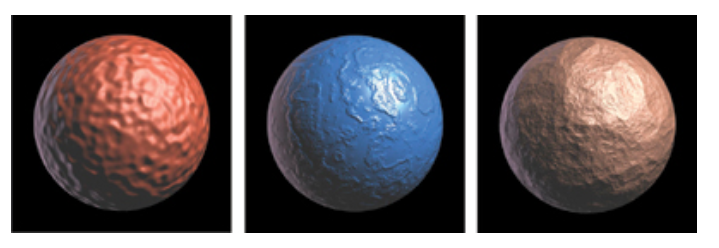

In [6]:
base64_data = "iVBORw0KGgoAAAANSUhEUgAAAs8AAAD4CAIAAACc8JzcAAAAAXNSR0IArs4c6QAAAARnQU1BAACxjwv8YQUAAAAJcEhZcwAADsMAAA7DAcdvqGQAAP+lSURBVHhe7P0FeBvH2v8Pn4a5aZq0TduUmVJuYxKzZEm2mBnNINmSbclsSWZmhjjMDHYcM8UOMzectuGe53dd7zsryUna0/Oc/q/0PGlSfX17d2Z2lmZurT6anZ39x//PI4888sgjjzzy6L8pD2145JFHHnnkkUf/XXlowyOPPPLII488+u/KQxseeeSRRx555NF/Vx7a8MgjjzzyyCOP/rvy0IZHHnnkkUceefTflYc2PPLII4888sij/648tOGRRx555JFHHv135aENjzzyyCOPPPLovysPbXjkkUceeeSRR/9deWjDI4888sgjjzz678pDGx555JFHHnnk0X9XHtrwyCOPPPLII4/+u/LQhkceeeSRRx559N+VhzY88sgjjzzyyKP/rv4zbSxc+MWCBa+PGzfumWeecU3/4ZFHj0+Lvv8uId48PDzkdtB/o1u3bpWXlVLIxDlz5rjX9Mijx6r5L72ERMCamxrdPvp7un7t+siePUF6/cyZMydMmADWApdcz1XXo8cut4M+gv4Qbbz2mps2PE7v0WOXhzY8ekLloQ2Pnly5HfQR9J838fnnX/472vB8Bjz6v5eHNjx6QuWhDY+eXLkd9BH0SLThkUf/9/LQhkdPqDy04dGTK7eDPoI8tOHREyYPbXj0hMpDGx49uXI76CPoP2/C02/Do7+UPLTh0RMqD2149OTK7aCPoD9EG/efSXHJvXOPPHoc8tCGR0+oPLTh0ZMrt4M+gv4/04Z7zx559JjkoQ2PnlB5aMOjJ1duB30E/SHa8NxJ8eivIw9tePSEykMbHj25cjvoI+g/b8LTS9Sjv5Q8tOHREyoPbXj05MrtoI8gT9uGR0+YPLTh0RMqD2149OTK7aCPoD9EG55+Gx79deShDY+eUHlow6MnV24HfQR5aMOjJ0we2vDoCZWHNjx6cuV20EfQ35k2/si5PGKe3yx6hNIDq/6htf9ovidX/59og/w3oo2Hq/43PuBa9JvE+/p36f9Rv9nmo2znbyEnbcCbm5rcPvp78tDGH9BvHO/39VCmP1h6rjX+YOa/ndwO+gj629HGQyfw7x3rmfvL/n0eIPdC58wVfjB3BceBS4Ur5I5CU1f0gVzR++ZOelggOu4ZyH6tf6kRKN/9vTyt+uO0UVZWQiY9hbQBavf3KtiZDE3A/8M+4Ir+1jEehJzruINj+m2SKz6W5AwC1wPXhIedciyHa+60saSxlN8RSP03HvtvV3lSBdEGHOGhjf9F7vMcO937LuAKOA1MIIf5nTJ5KJMrNh6ajsX/k5xX2N9+TH5frk3+oa0+PXI76CPo79e2AZ2By1PGvMp9TuDcHthYHpfdX/pbORe7F93P6pYr2VVq/6KHc//Our8WtNS1MXeCU1DkwRLnIig6Zk+t/j/SBuHpbtsYq31gD18lf+0Abgd5kAjiD11VoQDkk249yOmcuaKQOWdj24I24Zz8Os9YxJUNijoFAmAvwFy6n+6Sc42HEqHIQys/NfLQxn/Ur/xgLOo6fXcYmjg9diz9IbmyuDUW+Z3E3zVoArmdM/hrPZzNaVA+Z/BvJLeDPoL+trThuvaN+Qw0B+fmakC4T7jA7guc+nhnngcaW/VX5pYr4i6zZ+6XHhAUdu1kbAVXunO1hzfxQK6M980taBVg7m09SH/a9feljd+p4185rdOlfk8uTxlb6JwD33b+8HOHIf8cc6IHWZ0zMHFmcDvcM+PcmaEF7nyuPGNxZx7XgbmWO5dCu3PtEYqCRa5lY3LlgdIe5HDFnyJ5aON3df8EoXr/tWOAMGRjac4omECu4kq/vwjI6VRg0UN6sNAtKMeYa/3GHgr9Vq7djJlrG5C5F4/JeTi/t/5TIbeDPoL+brQx5i1u5xn7d9vYItepAjnXcQoEXVfMf/Hmh9e9H3Fv56G4c2NjYWdel9w5HsQejj+0BAq5tuI0EBi7dju3CDDG9SF0pUHmnjxt8rRtQLpfy/c9ArL7QacbQEEoBOSKPiRXJuc/5Dbg0+2+6+fM6ZpBIUiuZc4tOedj2aA5iLguu2DqTIMWQwHn9cIZcm4CWjIWgTL9Kupa6E6A1nMFoXQo5anR35Y2XKcA5I479ZuoS79/niDVZS79ZsWxmDMLtMxlD+a/FpT68L5ducbiYzGQ4Xfz3A+542D64NrrThkLjsWeDrkd9BH0t6QNYGPn4Y6PJd83p689fLog5HIpYC5By0CG8eOemTBh/KRJEydPnjx18pTpU6fOnDbt2enTZ0+f/tyM6c/PnDF35ky3zQJTEJ0BEufMmAGWzp4xfdZ0kH/qjKlTpk8Bq0+aMnHiRLC5ceNd+36wf6CxQwKJzgMc+23qTneRkHvx2JKnUB7agARVsdMLflPHD9IfCgE547/W/VQwG/fMOOB048dPmAAccOKkyZMmTZ00GdgUMJ08ZeqUKdB00tRpk6AASJwyadLkCZMmTZg4Cfg++AQA3/vNvsZmzj2NmVuufGNp7myuBGjuDkC6H3gq5KENd9yp30TH9Os892cuc80fchBID0VcucYMTFwQ8Bv9+lAe5IY2fD82Rt+uPL9e+CuBbbm+Fx5a9LsZn3C5HfQR9HejDUi/cQOnY7mulW65MkBR9wzSr6MgM+ReoFCmTpw4a+rUObNmvvD8c6++OO+tl+e/v+DVT15//Yu33vzmnbcXvf+uz4fv+374od9HH8A+AoF3fd5/x+v9d75/751v3n37i7ff/PSNBR8ueOXdl+e/+dKLr857/oXnZj0LgGXixPHjwPbv725MrgNwe/7YoThj0OUeOpzfrDC2ylOkvy1tuKp5rDJBVUM17gxCEeciMHFd+Fzmcg0oEcxcbdT3V4cyuLYIxQC7jgeQMW3q9Fkznntu9rznnn9pzrz5z897+fkXXn3+hQXPvwjsVWBzX3hl3rz5c59/cc6cebOee376zNlTpsyYMGHyGOyO7XdMriNwNo24kqEZFHHuGgpB5+CKuxaOGSSQ+KutPeny3En5TwKn6a5x8O+MOB3FGXcVA3Dlf9PC/Cs58zo38NtFUGaXv91f4Iy7vgUebBjaApTLFbz/W8651ftr/q7+Y4YnU24HfQT9TWnjYQH3cV+Inf9A7lOFoq7c0Az8+psMwGLatBdnz3593rz35s9fuOCV795YAHvndcwHbxE/eZf++Yecbz4Rf/+50usrnfc3wT7fhvl9F4lYFI3yMqK8Y9HeZox3nNPMGC8T2isWtciA+DbS96tw7y9CFy0MWvSZ5rtP5F9/yF34jv+HbyDfefX71+cvfPWl916c9+qc5+ZMnz510iTw89Pp7tCxQV8gzsjYB9KVDh0uJNeRu9Kg0NOjv3O/jft16a5bVwwKOWse+gfXROii+eB7GppAOZ0GoGLClKkzZs6eO+eFV1945e35b3z0ytufv/r+t6984vPGQuQ7XxLe/5b2/iLWe368D2DCj+CiD+HijxDij5GQfYgUf4QUfYwQfgTjf+jL/sCb8e531De/JL62EL3gE9iCD71eee+b+W8tfPG19+fOf/3ZOS9Omz4LMAz0eYIO0XkkwFvBsTmP1mmQ97rMvdx9mA/b0yMPbfwn/arSxyLQ5L6Aq4w16t4XlDxu3PiJEydOmTJl+rRpM2dMnzlzxqxZM2c9O+u5Z58FNnvWrGdnznx25oyZM2ZMnz598qSJE8DvufteCfkcMFcCtEHXNsG/Kwrt1p3RPf+3gpY6N/a/ZXoi5XbQR9DfjjYenMBv/AGEwSkCFxw/bgL4d54rmALIGAdSn5kwcfwk8FPu7Rde/Obdd3GfL2R7fadD+JpwiCQi3EaBZ1PhJQGoWia2hU1YxiGuZJNWsYmr2ITVXMJaPnGtgLBBSNwqIu+Q+LfLaLtk1N0y/04ZZbeE1CEg7Bbgdguwu4X4DhG+XYhfz8M0s5CFVL9EnFcw7DvON5+jP3r/01defmnWs1MnTYaO7pnx458ZN8F9bK6KcR8/dMQgCIXdBp3Cr87zidffupeosyZd87HYWAiqfehSDDnxP9w9mp2+ATwAcmHg1OPGj58ybebcF197/b2FH34N+xJG98JL/WihMI7ZT5KKlGdhlEUoTRU8qNEvbAk8YgU6YhUyYgUyYjk2ajkmajkiajkyagUqaiUiYikyrAUT2oDSV8FVJXBlPlzmQAiT/dgxXlT91xjeZ174dz7+7sVX3p48deb4CZPAfqHPEOStwG2hLwvnhwu4pxs1gEFH6wy4HRcyEH6q5KGN/0W/PU0QdBsQ5NUuc13xIBsT8OuJEyZMnjQF0MW8559/df5Lb7z68huvvfrmGwvefvu1D99566N33n7/rTfffeP1d15/7c3XXn315ZfmzJ41ferkyeCaPn7cROCdzs+Ge3NAD3YHnNAtcGj3j+7BoTnNLXccCBwd+AA+bQ7sdtBH0N+RNtzn4Ao5zXleTm9yniWYTJowYebUqa8+/9wHL7/4xRuver3zJubD9xlffCpd9E0Q0jcaj4r3J6TQSHY6KYuOL6BjKuioZgZ6NRu9iYvdzsPt5OPbnLZTgNshxO0Q4XeICTvEpDYJpUMKUIPaJfPvkfv3ysh9UlK/hDAgxg9J8MMS/B4poV+C7xLjtgswaznIxYHwSn/fXLxXAuyroO8+4X3+PvGjt33efePz1159+8UX5s2cOW3iJPCZuH8azjNxxt0xd6rrjJ8O/Y37bbgq+jcaS4TmrrCTO54ZN2nS5NnPzX3x5ddffeuDNz/48r3PfD/+Gr/Qm/UVRvktNWoRN8lXnA1TlPrpqv2CG2ChzYiQFlRIKyJ8BTxqDSxmAyJmEypmM9ywER69AWXYhDZuRsZuRsY4LXYTyrQRE7seZVgDj1gOD18GD1+CCl+MDGuEB1fDtKU+irxFgtSv6dGfICUfegW+/zXurU99Xn3vixcWvDP7+ZemTZ05ccJEp386ARky6BRcR+8+kzH3fZrkoY1/1a9OzVnz9ysdigEAhbxk3PRp0+Y+N+eVF196c8GCD95689P33v3yww+9PvsE8dVC/LdfUry/CYAtYiF9eFiYGI9UkDBqKl5Lw+vp+JBAQhiDGMoggmk4kxgaiA+iYRQEPyHKiw37lu7zNcnrK8y3n8O+/PT7Tz74/L23P3jzNQArL70wb9asWZMmT4Y81C3n4bg4GDpmyFyuez/HmJzp/9oE84TL7aCPoL8pbUCnAc7FGYLmzn9wjhMnTpg2edJz06YueG72py+/hP7wbeZXn0i9vwxGfB+D80showFb5DPJhRxaMZ9ZzA0sZtNLWeQaJr6Vid3AweziYboFmH4Rtl+E6xPhekTY3UJMmwC9Q4jdJsRtFuK3CInbhKQdIlKbmNQhIXVJiX1S4qCEsEeC3yvFH5ARDimIhxXEIwriQQVhrxwgCKZbhGkXYDZyUEsZiEqqn4PgFYP6Tun1RcDnH/u8+doH855/Yeb0mVOmTJoINXu4zsppD53p0yUPbTwkEH3wEwp48IQJEydNmTZ1+rMzZ8+bN//Ntz/6/pPv8F8hGF5EGTIgDM+1EiVZeFUZNrgJE7kaE70RZdzqZ9ruZ9oGM25BRm9CRW9EGDfDY7ch4nYg43YCg8duh8VsR8bsRMW2ocw7kaYdSNN2VMJOtLUdGDJuBzxmK5TftAOd0I6xAmvDJe4iJO7CJ2zDxaxCh9ShVPlIUYoPM/obkuoTP8bbnyNffnPhcy+8NnXG7ElTZ0yYNOWZsT7RD8t9sflt8pMtD2249PAZ/erUQBjEoTY4qN/9tClTZk2f/vysWS/NmfPB669/+8lHsK+/Ivh40dFwHgEj9yeGMKlGfqBFwkpRcG0avkMnzNZLCoJlJaGK8nBVZbiyMlxRFSGvipTXRCnqDKrGWE2jUdUQraiJkFaEiouChDlafoaalyhnxQrpYUySkoLmYnz9/b5DfLPwiw/fefu1l196/rnnZs2YMW3qlMmTJ06YBD5hEEZAbR6QOX+Z/hvggPI8VbXmdtBH0N+ONoADOJ0DuALkNE73djrFM89MnjRp3uxnP3xlPuy9d4Rff2KEf20jeOdTYEVUZCENXUDHFAVgigOxJUxiMYdaxGOUcALKWdR6Fn4ZB7tFgOsC0CAnjiiIexSEASmuW4xtF6A3cZGrWIglTGQzA9kYiGoIAIZsCkC0BiJWMBEb2MgdXFQnH90vxA6LcaNS/D4F4YCccFBO2CcnDMlwXSIIVrby0Nu5mB1czE4OahsHuYmNWMmAN9J8s/GLIn2/oH323ldvLpg/d+60KVNdJ+gyyN+fkjr7lf7GtPEbQdU8VtvQ/8TJk2fNmTv/9Xfe+eSbhd6URUQlgp2AEtpRkhycPJ+kKvbXVPrr6kjBLYTwlVjDRoxhE8qw2Tdmi69xMyJqIypqAzp6AypmEyp2KxoghXknIq7NZci4NjTgiZgtKGiVjdi47RhLGwKYeRsSIAtING7BmHdi4tvRlnZSUgctdTcptQOb0oawbkfHbyKY1hAMy3ERrZiQRpiy6HuO5TOU6J2Ffi+/9fHsefMnTpkM3bocOyP35P4H8ymShzYe1v3zcla4u9rBZRn8cJo5fcaLL8x9583Xvvz4Q/R333LQKC3N38BjmYUcq4yXohZm6cTFwdLycHlllLIiSlkaKS8Kl5RHKWqN2hZz8GJTUJNB3RitbIiW10QqqkC2cGlNpLzJqG6JVS8xq5fHaVbGa1YnaNdag9cnha22hqxI0C+L0yyOVdZHyyrCRPk6XoqUEcEkCXEw7HdfLnz/nTdffXnunNlTJk8aD74KoWOH/NPpo+5jd89c5wYEJTxVcjvoI+hvSBsuQWQ6fvyEyZMnz545c/7c59956YWvX38V/9G7gm8WhiEWpZKQJQx8HRvfxMY3M/FNTFwjE9fARAOrY+Fq2aQajn89m9zCJq5kYzfxsLvE+C4psUdO6pSR2qWkbSLiBj5+NQezlIkCbFFLR1TREJVURBUVXkOFN9DgSwLha1nIrVzUbgGmD0IN7IgENyLFj8jwgDlGJXgQHpTge8T4ThFutwiwC75fTBgG6ZDhhsS4XhFuOw+7hIHIwX8f5fs594sPEO8s+Gz+vLfmzXnh2VnTp0yZOGGCGzfcZ/6U6O/dtvGwxk2YMGnatOnPzn7++RdefXHBewve++a9r3ALYdzvyDoY14pR5OP1tfjgJlxQEyG4mRTSQg5ZQgpdRghbiY1YjYpag45ah4peD4veAI9aj4pch4lajzNswMVuwcftwMe3YePbkPFtiIR2YOiENox5OwaASPR6JMhs2oqO34m2tGHit+NjtxDMW4nx20mWdmJiBz6pwz+1MzCji5bRRcrowqV1E1K7yKmdlJTd/skdwMgJW/HG5XBVwfdM00K86n1v+muf+Mx/69O589+YNeeFKdNnjgdfsU6vBWf7lLmuhzYe1v2zmjRp0szp059/7rn5L7z4xisLPn7n3W8//RTx3Tf+CD8+Cadn0uPE/HS1NDdYVRymqohUA6RoitUuMWmWxemWxusXm3X1MaqKKGmtUdls1i6zhCyLD24yQKhRB9EGQA15eZgUAo4IeUO0YnGsalWCbmNS8I708F32qM5MY4cjusMRtTszCkzb7RHb0sI2JAWviNfWRysKgoRWUYCehhNg/cheX/l8+v7Ct19/55X5r8x7fs6zM6dMngi+GZ1g4fx/2GMfhJ4SuR30EfR3ow1wAk7ncE4Aajz33PPvv/02/Ksvxb6LTFhYHhlVGYhr4BJrBIFVQlYFl1rFItQFYlsYmOVMzCoWajUbtYqNXsVCr2Ki17FRmzioNh66Q4jdLSFsExHWCYhLeeQmNqWW5V/NIFcG4KvomCoaqpKGrKQiK/0RdVTEYjpyFRO1lYcBADEsJx5UkQ4piIfkhP0ANcS4QREw7JAQMyTCDYuJIzLKXgVlv5oM7ACYKsn7FORRGXmvFBhpn4S4T4IfFWM6BcgNHFiJv3cM8lveN597v/vOgufnzpw6FXj8U1Frv9LflTZAJf6mbXbctGkzX5q/4N2PvvzCi+BDUqI4cThJDlZVjQ5agg5biQpfBQ9bCg9pQQY3okNaMCFLMWEr0eFrkBFr4WEr/EJb4OHLkJErURFr0BFrMJGrcVHriIaNlLidVCvAgk5CYgfa0g6HrA0XvxMXtw1t2oQwbvCLWg8zbEKathOtuyiJu6iJbQGpHYyM3YyMzoCMLv/0brqtm2nvZtq6GOmdAaldtNQualoXJa2TkrbbPw2wyG5qaicpcRcubgcmeg06pAGtzPFlRn2NYr77+aIXXn198pRpzh8DT6E8tPGvAic2+9ln31jw2sJPPkV4eQficApGYKRYZJZJklTyDJ3KEaTMDJLnBMsLwhSVUarGGM0ys26pWdNqVi6LA8ABYUeTUVkdKakzyBpNysVx2maTpiZSVhkpq4Cm8soIeVm4rCREUqQXVoSI6yPly83ajcmh7fbojkzD7kyAGpHAOrMMndlGYO2OyB0ZYdtTQ3akhrSng0DYxsTQZfFBNVGqbDXfwKEK8Cjsd18tfO+tuc/NmjhxvPNeCnQmzslTW19uB30E/aVpw1V5Lv2nXUN5nTkeXmks+cG6IAR+EY6bMW3yqy/O+/y993HfeQkRyAgiNomCyaFhixmkUg6tVMAs4jGKOPQKJrGegV3CQK9koddw0GvYqDUAOJjI1QzkWud9kC1c5FYuejMXu4aLW8olNnAp1RxqBZtaziSXBxIqaBinoStoqBo6sjEAAThjOxfTI8KPyImH1JRjGv8TGuoRBemAFL9HgusXYbuF2C4BpouP7uZjegTYPhFhQEIYkgHDD0rx/WI8WLdTgOsW4HuFhCEx1M6xT4LdK8XtkRLaBDhAQlVUvxT0t+rvPsV+8Ob7L78wd9aMyZMmgspznr27MJyF+VApPRBY4gSx31n+71b5v9bfiTYeFLiz9KEJqKDJk6c8O/v5+a+8/cGnPl4Inh9Zj2CbMRIbXlVI1FbiQhajI9aiozagI9chQ5eigluwwS2YsOUAKZCRa+GRa2CRq3zDlnoHN/mFL0VErgbZ0BHrkBFrcIYNJNM2mmUXLamTktiJs3YgEnZiLO0ESzs5oY0cv4MYvx1r3oqM3YKM3YqJ20lJ7ghI7WSld7JtXWx7F8vWFZjeRUvrpKd3AewIzOiEDITTuuhpXbR0ACLAOv3TOp3w0U1O6SJZ2gimTTjjckxYLUqd78NP/Iqse+8bwitvLXzu+ZemTJnmPvkxOYvDWRIP7EHSmB4KjsmZ4de5HoeeOtr4X4rUdaFxhYA9BMrQkmcmTpw0e9azr740/6O330Z8+y0DixVTKWoWM4TPN0jE8XK5RSEHtJGuA6ihzAtVlEYo6wzqFQnB6xJD11uDVwCkiFG0xCgWxypbTZqWGHV9lAIQRnWktC5aUQ81bChro+TVUTKAGhXh8nKoeUNWESqpCpfWRcqXxGo2JYV2Z8b05cT25cR0ZRt2Z0V3Zxl7QDTP3JVl3G2PBNbpiOrJjO7JNHQ5jG226C2pEWsTglqMyvJwcbaaHc+nCDDesC8/fu+NBS/MnTNt2pQJE8a7SgQ61bHTHZM7+aEA0G8z/ZXldtBH0F+cNsYcFoT/3a5BMrQE8mZnDnfcLZDmPnAocfy48VMmTZ4zc/pb8+f5fv4pD4OJ5QocfF4Zj1HBJpexiHlsmoPLTONxM5i0LDqhjIZuCkCuZiLWsJFrOKhVbNRKJmpFIGJ1IHwdE76Jg9jCQ23goFcwMfUBmEoGsYRJLWLTilj+JQxCOUihoSrpmKoAbE0gtpmJWc3F7BLi98rIJ9XU83raDyH0c0H00xraYTlpFOpViu0UYnfxMe08dDsP1cFD7+ahO/mYLgG2RwjwAgSg9B0c1BY2ahsHs5OH6xLiBsS4EQn2oIx4Qkk9oaIeV1EOKghdYuxKDioV58X79rPv3nxlwZxZs6ZOngQ+CdDTY9DjCs4eHWM/H51F7Coy53XANaSHM+mhRc6HE/8SvzifCNpwepy75P6QxvI+KHBo7iY/KBFUGNSLedKUqTPmvvDKW+999rUXCUMNZivzA3RV5OAmYkgjIaQBH1KPCV+CjFqLjl6PjVyDDVmMD2omBS/BRaxBGTbBDRv9otf6Rq7wDlviFdzsE74cBnJGbURHboBHrMUaNwOkoCV10JI7SdZOjGUXPGEn0dIO8YelDRjVuotkaccl7MTF7SSAlLROpq2ba+/h2rs59i4mIAyAGikdtNROGoQXnXRna0cABBzdAend9Ixu//Ru/7QuamonNb2bltFDTe4iJ+7GJbUTknf5p3RSE9spMavRMvu3BMW7n/nOffktqBvpxMnQA7Rj5eD0Q9dQS05zprsiTjkLzZnxYUEF6Hbrx6mnkTZ+XdruIDhe5xXGWeLOknc9EfqP8ePHQd0/p06bN+f5D99+G/bNN2w8LozPS9FpMoI06XptklabqFInKhQJcplFLk1RS7OCZMXhACBUK+P029Mi2zKitiSHrojTAZ5oiJY1GmWtJnVLjKYxWlUVJisNkVSGAZ5QtBjVTQYAHLIqiDYUADiqI+R1UQrAIo1G5TKTdmty+HBu3N5Cy95iS3++qSsnpicrtj/HPFSYMJBr6stygUhsXzZINA3kmvtzQdQ4kGkYyI4eyIvqzzXsskfWGZXxkkAm2tdr4UdvvTp/7mzXhRYaQOHhUvl1QUFF4ioWd6Ir+S8vt4M+gv7StPEb/esBPBR1B8Dsfu25srsqFpo9M+7F2c998867lK++kiLgYSSiiU5NYgRkMKiZgRRHICUjgJxMJ1upxHgKLpmMtJNh+f5+ZTTfGrpvLR1WGwCvocPr6fDFAfDVTPhmNmI7+O7nozdxUStZqMZAVHUApoyGK6VhS2ioUiq8ggavCUA1s3Ar+aTNYv8uVeD+UO7JSMEFg+hKtPBKJO+HEMZJLf2ggjIkIXQLsB18bAcPu5uP7xHgB4T4IRFhj5g4KiGPSkmjUuKwGDsgQncLULv4KNd+2wXYXjFuCLqTgtsvxR+U4Y8riKdUpFMa8lEVaUSGb+dhVgYgivDfG3wX0j57/6OXXwQXr3HO/v/OUoFKCfxDcOGKu3R/PiZn+YEJ+GBAlw9XUTqTH4+e0rYNd5FCdAyVs6sOXBNo8YQJE6fPnPnqG+9+/jXCB8XB0IJJPAtNlsnQlVL11UR9PT64BRvaig5rRYYtgYcuxYc2U4Lrqfoa/6AGYlgr1rAOZdoON22HxWyBR60HBovaAPXYMGxARG9CRG+Eum4YN2FMW7AJ2/DWnSRrB9G6C2rVcN4uAVPIQACyDnJiGyWpnZK62x+ARXKnfxJIAem7/ZN301J3AwqhAZhwtnNA3TVSdlNTdgekQ505AHDQ03sC03oYtl6Go5dp66WndRGSdhGS2onJHdTU3fSUNnL8OlxkI1yT/21A5EfegQve+WL2c8B1J0JF4fQ9V7GAqbOYoCJzpboKyl2M7jDQ2GJn0oPkx6Gn8U6Ksxbc5QoOE/JeJ1iAFGeie+6ePTfr2ffeeMPvq68CUUg1jRzFZVil/BSlNF2jStep03SaVK02WaNL1ASBabpWkxOsLAtXNBkUy8zqtRb9xqSwdYkhy+I0LTEqQBtNRkUL1LahAgBRGSFzds6QNRk0S2J1rSZtvUFZESmtipRXRyqqoyCriZK3mtXrkoLbHdGDhQmHajJONGWfWpy7tyK5L9/UmxPbn2saKowfLbLsK7aOFifsKYwfKogfyIsD6T3ZMd2Zhk5bZKc9sjMTWHSHI3pzevgKi642Upqj4sRxqQIMzGvhxy/OnTNlymRXrTl/1DnP31VIUBDSWBBM7hfXX10u/3wUPTW08UBjSWAhdMzjx42bPnXK3GdnLXh+ru9778n8fGLIhHRmYCab6WDSM+jEdBo+lYpLohIt/oR4MjaeiEzA+SbjfdIJ3g6yTxbFJ8ffN9ffD3o4hQKrpMEWMxDrOKidAkyHEOq/uYOP2cBFr2Chl7CwzSxCAxNbF4ispvvVBSJa2Lh1Ikq7MnBPEPdEtPSKVf9TSvDN1JAbidprJtm5UM5hNW1QQtwtxO3goXdy0QA4+kSEUSn5sNL/mCbghJ51KoQL7GQw66iWdlBJHJHh+iXYTjGmU4ztkeBH5KQDCvIhYNBjLLhjCvwpJfGMhgzslJp0XEE6LCX2i3Br2chckrfs64++fPmFN+bMfm76NKidAyom6BPgoo37X3BQEmQgyW3uBFfUmfB4Px5PGW24Svn+3HWxdlYEVObjx42fNGnyjBnPznvx1TfeW/iNrz+ZGRogTWZpC1j6MkZQJT2ogqyvxunrMcGLkSFLEWFLkCHNaF09SVdJ1VUA2iCHNmOjVmJiNqLMO+Bm6IlWVPRmpGErIgZ6eBVm3AwzboEbtyBiNiFdZt6MSdhGStxFAZxhAZDRToRsF+APctIucnIHOXk3QA1yUjshqYOQ2EGwduAS2rAJbQQLyDBGG84GDErybmLiLlJSBwAOiDZsbtpgpPcwbT0sRy8wRka3f3IHCdpaOz29k+noCXT0BthBtl0k4xKUIvsbgvq9z9FzX357xrNzJ0+ZDg1OCrkgVDqQF7qK7YE5/53+6pQz1RV3mivX49LTRxugTMGVA5gr9hBtuBLAMug1UtOnTZ3z7LPz58374oMPyH5+qgC6WSrK0MpyghQFwcosncoG0YYmTafL0OlSdEGJupB0fXB2sK48Qt1oUK0wKVfFa1ZZ9CsSgpbF6xabVM0xqiaDanGsaokJssYYRSV000RWHaFoidG2xuqaYzQ10YqyCGlVlLw2WlEfrWiMUS02azemhHVmx4yUWg7Xpp9YnHNuRfGFVWWHajMGi+L7883AhgrjDpQnH6vJOFKVur8sabjIMlgQ359nBiwCaGOXLaItI3xnRni7LRLQRleOoSfH0JcVvSs9Yr0lpDhUGsmh4L//4tO3X3957vOzZ86cPGky+OqESsLpgM6Zq2DcchbXkzEyh9tBH0FPDG3c3/X/dhgg2WXQP1SLz4wbP3nypLdeecXvk48FXt8bscicAGJuICmXQc4KIDnoBAcNm0HDpFDRVgrKQoInEnzSCD4OAsxG9Esj+iUT/ZJAIhmZQoJnkCDgqA5ALOdgtgjxnVJSj4zUJyV3i0kdIkKbENcu829TM7aoAtbK/JcJcCsEhPVi/04te1+k5IxZfTUl7GaW6U6O+W5O7C1b5FWL9mQ4f4+StouP28JFbeAgtvGQ3SLsPgXphI52IYx9NVbyo0XzU0ooZIlBV03SCxGcU0G0w2ryqJI4qiTtU1JO6ALOBTPOBwee0dGOq8hHoYE6CEeVwIhHVKQDcuKoBL9XhBsVYYZEqLUMv1zsd9JvPvnmrQVzZkwF9elsrnAWJZi7fqG401xlCWLOK4lzsbvUIQNLHufH4+ls23CXrXsOKsdV2pMnT50ze9577y383puEpWnpoiSetoQVVBYYXB6gK6HrSqm6ckJQLTq4CR602C9oMSy4CauroahLKeoSkq4CE7oYGbUGDvW02IaO2YY0bkcatqGjtqAAYZi3+cVu9YvZBo/dgTTtwMRtR8VuRcZsRps24xK2AbCAmjQs7YSEnfj4nYS4NoplFy2lg5TSgUvpwFvbAWGgnI+lYK270JZ2rKUdUAg1ZTcd0EZqJzWlk5wINY3gLLuIzqdUnJ05uv3ToR6jIByY3gU4g2ED2NHNSttNB1tO2hWY0cXN7OE6utlQJ9PuwLQOetJ2f+MyjCLrG6zk3c/85r30xtRps5we6Jo4p1BJueQsubFfky45SxHkgNKd34UPLfs/19N3J8VVD1Cpjh3kgxIGM+cYzDNnTHvrtde+//xzfwRCEUA3SiVWlSJdo7JrFQ6dIjNI4dCrbHptuj4oPSjEFhSSEhRs1etBSlGopsmgXh6rXmlWL43TtsTpGszq5jj1CosO6hwaq1li1iwFi8zqVrO6xaypN6qqIxU1UcrqSGVFpLwiUlEZqXDShrwlWrEmIWinwzhYaDlUkXq8Nu1kk/3U0ryzy4t/WF52uM6+pzRxsDhhoDBusMB8pDrtbEvOmaaso9UZw4UJQ4UJgDmG8uP7c027M6N22sK2pIWAaUdmZFd2VF9O9GCusT/b0JMZtcseuS4puDxMYuT40/wWff7+O/Oenz15MjSQndMpoRKBSsvloU4bmzwBcjvoI+gJow3XMQC5En8rqOrczj9x4qSZM59945UF33z0Me3773QoWCIJnUPDlTGIJYH4ogBcAR2bT0PnU1HZ/gg7BW4nwx1kWA7ZJ5fsm0uG2YmwFCLMSkDEE5FxRCRgDjvZr4QKb2SgVvGwm4TQ2KA7xYRdYkKnmNgnI+9R+x8M5x6Nle83SPtD+TsU1C0SymaJ/24NYySUdzxKcs6svpgUcik5+FKi/myc8kiksF8VsENIhLqdshDr2Ig2AXpQhj+moZwPDrgawfkpVnLTqr6VGnI7PRzYjwnqi9GCE0GBB9X+owrSqJy4T048qqae0tPPBgec1dNOq/2PK0mH5YQD0DO0uEExrluI7eBjuviYPgFmUITu4KPWsBGVFO9ExJeCz95e9NpLLz777LRJkyFfdxapGyjcF2tXOf4ObTgD0Lehu8z/z/XU0Ya7WF3zsZL/x7Sp0156Yf7773727TcYJEFM4hjocjtDU8jSVdB05WRdGUlXRtCW47WVaG0NUlsHDK2rwemriLpyiraUqK3E6urgoUvgkatRxk1Y42a8cQvaADhjKyZmG9q0DRG/HWbeDjPtQJh2osw70fE7UObtKNM2nHkbIWEHYAUSMEs7MaGdGN9OTminWHf5J3dQrNtJ8ZuIpk3EuK3kpHZ6Rhc7u4+d3cvO7mHau519QncDUGBn9jLtPRBepHbT0rpBwMkWUADqQGrrZNq62IAz7L0sWw8no4uZ1klL2c3M6ObYewBqOA0Eeln2Hlb6LnrcGpy22Isd9ylG/uZC5LxX3gXMMX78BFepQXKVnDM67tfO6VzkKlI3wj1GPZ29RN1FfP8QodIG0ylTpjw/Z84Hb77p+8XngUikkkqN5PMSFNJ0vSZdp8nQaWx6jV2vsQVp7XodsAy9Ll2nBYtSNMokjTw7WFkWoWwyKBbHKFqg1gt1fYymIVbTGq9bmxiy2hK0zKxdGqdZEqdeYlatSNCuSwpdEqetMyjKI6TFoZLCYHFRsLQ0TN5k0q1NCW/PjOnLjxsusR6uyTjVlH26KftUS/bJJRBtXFhRdrA2o78ovisvtjc/bqQk8Uit7XRLzsmGzEOVaQP5gD/i9hRb9pZYR4st/QWxPXkxXbmxfflmwCV9gDNyDEN5xmFg+cY9+TH9Ocad6RGAhHI1AgOLxEct8v70gzfmvzh98qQJ45z9jdzFM2bOEnPN/uJyO+gj6ImhDSDXAbjkTvoXOb80oa4JM2bMeO211/A+sDAWL43DLGL7VzFwFQHoYhq6hI4qDUBVQE+lIioo8GKSXwHRp4TsV+kPr6UjKmjwAn+YjeSXSIAlENFxBLQJjwDkkUeB1QYglrLRa/i4tXzcGh52DQ+zno/ZKcINqSgnI1lXLcrbtogfU0LPmlR79OwOOXWziLRDSupUkIfUAfv0rANhvAOh7P1BjEE1dZeUuJaDaQ1E1tFgiwPha9nITjF2v5J0Vk+9FBJ4LYz9UzT/hklyy6K6nay/kxZ2NUF9Jkp0QMvYI6cMSghDYuweEXqvFHdQSTqm9T+lpZ7T+J9Ukg/LCCNiXA8fs4ON2sBErmIi17JR6zmoTSzUNi6qTYTaK8MelOE3c1CJyG++f+vN+c/OnuAc0h+UG/SyAKjRAlzgoE+F87MAJm7acH9InJ+Mx9vw96TTxr848P1CdiVCdQHsxbnzv/vCm0oSS2UWUXABN7yGEVJP01WQlQU4ZQFKVYTUViC01TBNLUxZjZBX4pQlFHVRgK6Qqi8lBlVh9I2IoFbf4CWI0GWEiJXkqHVkwyaccRMmdgsufjsmYScqoQ0evxMetxNlcg4SGr8TFb8TE99GjG8jJ7SRrLuI1naCtZ1s2e1v6YSeiU3cRUzcRY1dFxjZSo1cSjOv4zg65cVDIbX7wxr2BdeOSvIH2I5uenoHP6dXXjwsL9kjKRzmZg+yMwc4jj4IIACFQAzRw3Z0ch3dPEcvx94HjGfv4YJF6ZCx0rsDM6D7LFyH2yBwgW649FCT2vDmdTBR6ud+zHkvvTV50nTn4NBuFHYhBoi4kqCiBP8u+8voaey34aqBh4oZ4j3onSNz58z55IMPWVhcrFicqdUWBAfnhehygrWZQeoMnSpNp0kPDsoIDrEFhdn0IXad3q5VpmukyUpxskKQquAVhkqqDbK6aHGtQVppVFRCHS+UzSbdSkvoxuTIddbQlXEQbbTGqZaYlOus+nabYW1icGOsoiRclBvEz9EAE+YHyValRPWXpZxpzTvXmnu0Pv304txzy4rPtBadXFxwfHHeueXFl1aV76tJ3Z1n3G6L6MwxHaiyHa3POt6UfajGBsgD6syRZ9pTnHCwIvlIVeq+csu+iqRD1elHqjMOV6TtyTcPQLRh2FNgHC2KHS007S0w7Ssw78uPG82L73IYVifoLSIG2eubl56bPWXiJOi7CbqSPuyZYHb/s/+XlttBH0FPAG387k5/nQjCLoPCUyZPee3lBd9+9iUVgVNRmXFcYTo7MJdJKg7EFNORRVREEQ1RTEOU0VFlNGSJP6LUH15BhTUFIFsDUYsDUXV0RAkVlkP2zSD5phD9kgiwJIJfJgkGsjUA2mAiV3BQLlvFQW/gYTvFhL1q/9PhjHNR/LPR4oMh3D51wFYRYS0Pu4KDXcfHbhFgtwsJOyDyIG8XE7YJsRv56NUc1GJodFFEfQBiBRO1jYcdlpFPaOmXQ1lXw5hXQxlXQhmXw5iXI7g/RPDPRAj26Zk9Cmq7iNjGx3fwcX1C3IgEt19OOKIin9JQz2ipZ3WUExryISVxRIrvFWDb2MitLMQmFmIrB72Ti9vNw+3mY3cJ0F0CTI8Qu1uAXcFA2DGLhJ9//OWrrzw/fRooT+hHIXQH1uX6zsKEPhmgoCFzli0QtGhs8ePR09S24XRjpzmLHWjq1Bnz5s1//71PfX2ITGYQXxIn1NjZ+jy6vpSkr8ary7CKPJQ8F6nIR6tL0OoKlKoKrarCqiqJ6jKyttw/uIoY1oSOWIEMXQ5oA6apQWprcPpGonEtydqGM29Hx0ING8i4HQgnaiDMOzGmnVgwjYNQA5MAPXJCSNhJtrSRre1Q80ZiBzGhjRizHhe7AZ2wjWJaz4xZzbJu4dh28fP7JcVDypJhRcmQpGCA5egJtHUz7L3C/AFl6TAwadEQL3uQm9nPzezlZ/cKsvt4mX0cYFm9bEcPy97DsQHr5tg6OfYurr2XC1LsYAvdTEc3BxhgDlsvWJeT2cu29wam7/ZP3kEyLkWp8r8m6d75Aj13/ptTpz8LLtZQwUGuC35mgLCrQKEyhVzVhSHA3PpV5P9YTyFtQMX54PBA8U+bNv2lF1749N138V5eSho9WihMUqlsWk12kDYvFLKcEK0jSJuu16W5zNmekaFXZejk6TppmlZi04iytcKKCFmDUdFgAKasM2rqopWNBuVKS/D65LB1SaFrrEErE7SrEnSrLPqVVv2axKD1ySHL43UNRmVJmLggWFwaKmsy6TekG4cqbcea8442ZB5vdJxqyTy/vODS6tILK0t/WFl2blXZxbWVl9dW7K1J68yP3Z0TO1Keem5J8bmlxWeXFp5szj1SYxstThwuShgqit9blriv1DqQHzNYYAIUsq80aX9J4khB3FBeDACOvuzovqwoMO3PMQzkGgdyYwZzY/pyjJ32yPUJuhIdL4iKxn6z8M1XX5k53f1cN/SZd15y/7qV+2u5HfQR9CTThjPZeVAgBFXb+PETpk+d9uoLL8G+XsQj0EK5cpNAnsQXp7MCHIGE3ABkHg2eR4XlUhF5NGQhHV1EQxX4I8pp8LoA+DIWahULs4wBPfJaSYUV+fvmkL0dJG8b0cdG9C2gwKpp8JZAxDImYjkLCWwFG7mag97Mw/VJSQc0/idDA47o6SNK6i4hfh0HtYQBZW5hIJcxkatYyJVM5HImEpDKUgZ8aaBfa6BfSyCsMRDexEC0MJEbOJhOIeGgknouiHE1gnstjHUlJPCCnnZW439K7X9YQQEg0ibArWOjVjFRa1nobRxstwA3KiUcUpJOqP3PamjnINrwP6nzP6qh7FOQByUEQBW7eShg3Xz8gJA4IiENi4n9IvxuAW4XH9fvHJkU7LSCAtMv+uLbBS/NmTZl0vgJwPsfXIpBALpcQ4V7P+2vgOFPDW04PddVmNCVZ/z4iVOmTJ3/8huffbaIgGPx+BGqoGxJUA5Xl0NX5xBVBWh1OUpZDFADGFqRj1UV41SlOGUZQV1B1FQCI+hrCGHNmMiV8OhNsPA1sODFcFUZUlWG1dYSTevJqZ24hDa0aTsidhvctB2gBty8Ewk4w7wTBywOWBs2ficmYSc+YSfF0kaxtpMT2wmAUeK2YCOWoaNWoOI3U+I3sS1bBPZOgBT84iF+/iAvq4/j6GXYuqnOR1FYjgFh3qC8eEhePAgQhJ8NUANARq8wt0+U18/N6mdn9rOz+6HmChvU2sGBbql0cO1dfGc2bmYPC1hWDwcYYJF0ZwtHFgCOPkAnDOctmMCUHeTIRl9u3IeLKC++/vGUabPGT5gE4dozE5xTZ3E6J1Dxuu6fuH0WzB6nAz9ttOEqZXf5PgOOdvr0aa8vePX7zxeysdgILjczSJ8RpAdIkapTA57ICdXkhmpzQ3SOIF2GXpuq06RoVSlaRapOkaaTp+ml6ToJsCw9hAu10YpWk2ZpnH6pWd8aq282qhbHKNclhWxMDV2dqF9p0a60aNZY9GutwWsSQ1Zag5YkaJpj1QBKysNkVZHKFnPQtszYvdXpZ5eXXFhVfrDGdrjOdm5p/qVVxVfXll1dW3llffWVjXVXN9ZeXle1tya9uyCuv8hyuC7z6prqK2sqL60qO7+06FRTzuHK9H1lycMl1pFS63BRfE9WVG+2AfDHaFHC3uKEfcXxI4VmwBY9mVG7beG7bRHQQB2ZkZ1ZUd3ZUQA7RvJjDxXEDmRGrUjQJUoC6bBFH7352rMzprneeO98u/hftG7/VW4HfQT9pWnj9/fodHGnj7sWu3190sRJz8589vN3P6T6INQ0dihHEsyRRvFlcQJxEivQRsdn+8McFL90f3gqHZsSQEyn4xxUVC7Zt8zft47u18KAtzKRgA8aAhC1NHgF1a/Y3y/f3y/XHwaslAqrpcGWBELDc61lowEfbOJgtvFxu0TEQQV5r4ayX0fpV5B2CnFr2KjFgYgGOrwhANkciF4ciGwNgDfT/JposCbo6VnEUucbUlayEKvYiLVc5CY+ercID3jiiJZ2JjjgQljg5RDGFT3jvJZ2Ukk5JCMMibDtfPQ6NmJJIPTw7QoGcisH2yfAHZQSjisoZ9W0Czr6RV3ABW3ABbBWEPOkPvCojn5IQz2sph5VU4+r/E+pKOc01PM62vmggCNq+h45tUuE7xJiBiWYfjF6Jw9pRX6F//DNl2ZNnww9qwKVOGTOkoVCD5W682LtsrEF/+d6QmnDWa4PdD/qKlhQ2DNmzHp1wVte3iRGoE4pjVWqUoXqXK7KwVBmUOSZeEAY8iKsopCgzCOpS0maSpK2AgooC4nqUpy2CqWrRQQ3IyJXwaPW+kWu8wld6hPUCNNUo4IacBErSHFbKEm7CQltKPN2P/M2mHk70rwdYd6BiNuBit+BiduBN+8gGLcSojfjzduIlp20pF3UxHayZSfOtBkdvQYTvhRvWE1O3E5P28VydAly+wFtcPL6A2w95MTd5KTd0IMqqV209B5GRh/bDjVIcB3d0Dgcjl6ndfOyegE00DO6abbuwCzo8Veox0Z6NxeYrZsHLKOHbwfAMcDLGuDnDogKB0F+VkYnx0kbEHA4etj2Lp4DZOtip+2kmlehgiu/JGnf+PDb6bOed10Exi4GwFz+C8ztrs4IWPA4XfdppA1XIYPQ+Odmz3n/3XepaHgIj2mVSTPUKodODZDCCpk6Ra+xBwHO0NqhfhuqVK0iRSsDlqqTpWllaRpZKohqpMkqsV0rLAgW1BsVqxODdzpitmdEr7MGL4UG1VCssupXJwWtsOiWJ2iXxzstTrssTrfYrK03qaujFVWRiiajdl1SRHe+dX91xunWnIurSi6sLDlSn3m8MeeH5SWXVpZeWVP+48banzY3/rSl8cdNDVfWVh+odfQVW4dLE4/WZ15eVX51bdW1tVWXVpSebck/VmM/UmM7VGsbrUgeLIrvzYkZKjAfrEw+VJF4qMJ6sMy6v9S6tzSxP8/UYY9sSw/fkQaNPbojPazNHtaTHT2UFzucaxzIju52RGxODmoyysMC8fAvP50/b84UqPfoX7Ja/43cDvoIegLaNn4ryMUhcx0P+C0zacKEWTOmvzH/5W8/+JjtBw+jMUx8aaxIGcFXxPBEFjYrNZBso6LsZN9UMizBHx1HI5hpxHgKNomMsJN88ymwcppzLI0AgAjwejqsjuZX6e9X6g8rpMKBFdPg1XTEYgZyFRu9kYvbyiNsFxDbhMQOCalbThlS+Q+rKAMK4i4xbiMXvYyJaALbocObApAtgejWQCRglKUMxEo2eh2PsEVE3in171D4dymBkXuU5H4VeVRDO6wPOBnCOBfGuOikjctBgDboJ1X+hxWkYQl+txCQDXojD7NRiN8p8x/QMg8Gs0+Hcc6HsC4EMy7q6Re09B809PPagHM6xhl94KkgyM4GMy+EsC4GB1wOol3R064GB1wPY14MYZ3UMfcp/ffICPuk2CMK/FElYT0HacN+w/70ra9efeGFWTOmTnK9DfxBUUOl7Zz/Kukx6SmgDZfrusLgkzV16rR5c198//3PvXzIAYE6hdyi0aTK1DaWPCtQbqPJ0knyLIIiD68oJCoLyOoCMuAMXQ1BV43XVhBUJVh1BUpTA9c3+oa0+oSv8I1Y7Rex2ju4xUtb46euQOhq0WFLiKZNlMQOPEQb23xNm+GmLRjovWs7EBB2bEObtuJjthKjN5GiNpLit1OS2umpu6lJ7aSE7WjDOkT4SmTkarxpE0ANZmYPN29AkDfAy+lnOHrIKbsx8e2kROg1bPQM6KkT6GGT9G5GRhc0xmhGF9Rdw3lbhOvoAbgA8kDjmgOMgG6O9HBtPTx7Dz+rD5ggs0+Q1S8AqJE1yM8Z5BcMcLJ6WDYnbWT28pwtHwA1BJnAevlgC7YuavJOlK7sW2rY259j5r787rQZsydAt8ah8h0rYshc7uqMQWXvtMejp482nhk3zvUzb8H8V779bCEdjQ4XcNJ0qqwgXZZe49DJknWqBK0GWKIW6hxqg0yVrpVDYKEVp+gkaXppmlaaqpGmqCUpalGaSpijF5WHi5tNyrXJIbuyYnfaDRsSg5bHqRfHKpfEa5fG65aYtUvM0AMprWZNS6y6yaCqj1bWRCvrjapWs3ZLWnR/YeKxhuyzrfkXlhf+sLzwbGve0brM4w05Z5YUX1xdeX1j3c9bm29sbfl5c+PVtTXnl5Xur7ENlFgHiywHq9LPthZcXF56aUXZmea8Y7WOg5Vph6ozDtXaAYv0FcQNFsbvL08+WW8/UZt2rDr5cGXSocrkA1Vpo6VJAwVxvTmxXZmGdltkuy2iwx7Rl2Pck28ayjMN5sYM50YP5UT1ZEU2GBTxQlog7Ouv3n9z/tw506dOcfnlX19uB30EPbG04XJ157OYs6ZNe+/114jffxdGoycwA1M47AS+KE6kiJdpk7icDBouiwLPJPmkknziychof2IUmRBFxBlwCDMelkiCp1NQWf6YIgoCEEY9zbeO5lPj711O8Ssmwwop8GJ/RDkV0cxEr+HjNwsJO8XkXWLqbimtS07rVtF61bQBNa1PQekU4bfxsOtY6OVMZCsDvjgA1hoAXxKIXMZEreJgtojwnQraSBD3cKToVKz8XJz8fJz0bIzwtIF/Mop3GurwIfghmn8pinclknMljHU5mPEDwAVdwAltwGE1bVRJHlFRRrXUA+Hs42bZhfTQq/aIn2zh1y2KKwbuhWD6Oa3/KTX5hJJ8TEE+ofY/qaWd1gdeCGFfCeddhe7LBFwKogHmuBYc8GM4+6dI3rVw3nk947CMvE9CHJUQjikI+2S4tRy0CfH19++88eLsmVAJ3+/C7wy7r9VO3Q88Fj0dvUSBXOEJEye+8NLL334LI1PlInmyQpmoVCYK5ElMeQpVlkaVpfvL7CRVPkld7K8ppKoL/dVFBG05Rl+F1NcidPVITT1MXe+rbvCD+oS2egU3+YQsgYWt9NY3eKnK/OT5MEWhn6YCZ1hFse6CXrRm2uoXvQZp3AD14TBDr49HGjejozfiAWdEb6DEbKAmttGdI3FRkzsIcdsRkat9wpb7GjZjre2Bji5+bp+kYFCQ3c+y9VBTd+MT21EJO+lpu3mZ3bwsABadAWkdAem7weqABqDhzO0AFzrBUqidA3AGNMxGDz8baqtgZ/XysnvBBgUFQ8LCIXHRoCh/QJDbz88GnNHPyOxlAUyxdwMi4dp7+Y5+gCOirF4+9Igs1NrBsvfQ0jr9ARKZ1qNluV9jZC+/+fGMmc+Ba4Lba6HLwzhXCCptkPp4HfdppI3xE8bPmvnsB2+/S0aj9Bx2mkZl12nsUFcMdYZObteJUnSKBK02Xq2xqtVpOqVdp8jUKTK00hStOAks1YvS9ZI0HaANSbJSkKbiZ+n4ZeGSJggs1KsS9ZvSIjakhK2yaJfHa1pN6qYYbaNR22RUNxudQ27EaupjNJUR8sowaXWYZEWcts0Wtb8i5ezivCuryy6vKruwvPhMc/aJ2oyj1RlHah2HG3MvrK+90bYM2M/bWn/cUH9+WcnR+sy9lamDxZaenNjhIsvROsepxhxge0uTBwviB4sS9pQkjZal9uSau3NMeytSjjdkXmjNP9uYebI2/Wh1yuHq1EN1tiN19uO1jiNV6fvLAHaY+3Jj+7NjR/LM+wvjRgsThvPj+rKj+jIj+jPD+7Oj2+2RzbGqWB4F+c3CBS++MM7dt+ivLreDPoKeNNp4aP8gOGn8+BfmPP/5e++xYbAICjGDRXNwAm08tlUgigfAweGk0El2EtxG9E0j+iWQUbEUbLQ/wUDGxZCwZgrBSiWl0sk2OiGbhi3yR1T4+9XRfOtpfnVUWA0VUU1D1tCR9QHIpkDkcg5mnQC/WUTcJiZtF5N3SCjA2mSUDpl/l9S/U0LeJSTs4OM2c7HrONhVbPQyJnI5C7WSjdkkJneoGaPhouMmzfnkiMsZUdcc0T/aIq+nhVy1ai7GK86ZpOdjxT/Eii+bpdfiFT9Z1T/FK380y67Hyq7Gyq6YlRfjVOfi1ecT9RfSwy/lma9VpN1syrsFrC7zZp75p2T9FaPwfCjjlIZyXEk66hxv45iSeEJFPqOlXwhiXgoKvKSnndeQz2soF7XUK8GB18NZP0VyAdOc0VAPyYkjEtxhOe6oEr9PTtrIQeURvmV+9vY7Lz4/fcpk13UbqnVn5f+q9B+fnmjaePgTBL5LZs6c9e67H/v4kmjMUJY0iafJEWpsAlUaS5lBVzj8FVn+ymx/ZQ4Z0IYqn6DKxSvycfIihLLEV1Pho6/3C26Fh60CnOGjafTVNfkGtfiEtPqGLvULXQ4CIANcVQpXFMLkBaiQZmzMRpRpCzJ2MzJ6DTpmIy5uOzZ+JwAOhPMl8njjZlrCNnbKTmba7sB0aBguSspufEIbzLjOK2Klb+Q6XPwOdmYvoAHABOysvoCMblpqJyWpg5i4i+PoluT1iXP6BFnQ86u8rD5B7gDIJszr52R2Q40Tjl6XgS1wMnsAfADmCLD3cpw5xQXDkqJhacmQtGhIDMgjd5CfBVaEbsfws3qA8cAq9j6+AzBHDz+zF2yfm9XnfMgWeqSWltJBM6/GaQq+IWrf+hQ267kXJk2e6vTW+7QBzOW9Dwr/segpo42p0EPaL33z2RdMHM4oFqRqZdkhqswgLaCNDK06Q6uy6ZQAO1J02kStLkmrSdco7Rp5plZu08nSdbJUZ8OGXS/LDJJnB8kzdaJsnSAvSFAdJV0ap15p0a1LCtmUHrkxLWJ9UsiKeB30MhSDus4AjRzaCHUgldc5b52Uh8tqohSLTdqt6VFDRdbjDVnnlxT8sKzwTEvu8XrHkeq0Q5XJR6rSTjRmnllWeHl99Y9bGq+srTq/rPhkc/ahmozR0qQ9JVbnKF4Jo6XJR+oyjwIuqbaNlCYNlyburUo9UJNxqMa+tzx1b3kKRBUNjpMNDmj4r8rUo5WpR6pSD9WkHalJP15jO1lrO16TdqDcOloUN5xnGsmLHc03jRTEDxfEDeQaBnKiBrMjh/NiBnNjd9kilphVmRoOC7Ho3ddenTFtqrtM/8JyO+gj6EmijYcPAMwmjh8/e/r0hR98yESiUwSCAiGnlE3K59AcXFaSQBDPYpnJ2BQi3IH3ScP7WonIWArRSCXF0Agmf1w8FZ/IoKeymTY2M5NByaVjimiICsAZdFhjAKI5ANXCwLQyscuYmBUs9EoOeg0Pu06I2ygiANsgIqwX4gF8bBIQtglIO/nkNgG5XQjdW9kpIG4VEDfwCKs5GLDKBgG+U8s6YFBcTIm6kWO9U2q7U5ZxpzTlVn7CDYfxenLoJYv2bJz8LAAOk+RKgvKnlKBbjuhb9shb6WG308Jup0fcdRjv5MTdLLTeqci425B3b0XlLxub/rljxS9bl9xd13C3LudWXtz1lKBLMeKzwYEnddRj0LDlADjwxxSEkyrKWQAcwDT+Z5TEMwriWSXpB63/5RD6j1GsHyNZl0MCT6jJe6GXumEAcPygplzQgFWIJRSvwM/ff+P52VMmTHT18nfWvvP+Nyj3x+kCkJ5c2rjvwKAwx48HqPHs66+9jccGisQmeUgZP7icri0K1GQzNA66KpuqyqeoiinqQoo6n6LMIcoz0TIHQpoDFxd6Swu/V5Z+r6v3Dl8Jj9nmF7bKR9vop6310zcAzvALW+EbttwnfKVf2DKkvhapLIFLc+GaaljoUrhhPTJmEyZ6HSAPTNw2XAL0KArcsAFp3ICP28pK3yXJ6eXZexjp3dSMblJqJy6xw8+02St6tW/oCoJpMy+zX5g7IMjrD8jsBRkC0joDoLHGOwXZffKCQVnugCR7QJDdLy0YVpaMKspHpSXDvJw+bmYf1z7AdTi7i2YBA/DRFWDr9s8A8NEHNijL3yMv2iMvHZaX7pEV7xHnD4lyBgRgUXafKLdPmAcQB0BGHw/wihNleNn93OwBbjZgDohaGHawnR5myjb/iKbvaRGvf/T97LmvTJw4yfk4t5M63D4LzcfCj0dPDW2Mh26gTHz5xfkANcT0QKtaVRYVUhKpyQ2VZQZrbHqdXau2abU2fRAI2/TatCBdqk6TrlLY1DK7RgpoI0MnT9XK07Vyh16RF6IqClUVh0qLQ8UloaJ6g3xlgnZdYsimlIjNGVFbMqI2p0auiAtqjFbVRilqoxVNMYpGI0ANWVW4pCJcUhUlb4nTrUuJ6M5LOFRtO92Sf7Y1/2RT1uGatP3OB0kOlCcdrUk7uzj76tqya+sqrq4uO9OcdbgqZU8JNJYXNFp5ftyeQgtAjf0V6YdqHPsr0kbLkkfKk/fVpB1qzjranH2iOedEYzawk41ZR+ts+yuS95Ul7wdoUg6AI+VQZdLhypRj1Wmn6+1nG+wnalMPlVv2Fpj25MUM5xqH883AhvKNQ3nQs7KANvZAFBIzUhg7XGTOCxYwUN7vvDp/2uTJzver/LUq+mG5HfQR9Edo4/MFC177c2njD28HZHuQ07l/qNEJHMqE8eMXvPDCok8+4WOwRhYzU8Qr5AeWMAl5TLItkJJAJZtJuDg8LAnvm0HwS6WgE2nEBAbdwgxIYtJTWYHpbEYah5HGoqUGEGxUTBYFUegPr6IhWhioVRzsRgFxk4i8UUxew8ev5OKWc3DLefgVfPxyHnY5B7OMjVnGgl5Av5qFWc/BbOHhdvIJu4XETiG5U+jfLqRsF5K2CLA7xYRuOfVQpPhCYsiP2aZbJSl3KjPvltnuFiX/6DBeSAo+YVLsjxQNBXP3hHD3h/HOGCVXrNqb9mgAHLftUbds0bcdxrs58XeLk+9U2u415N9bUnFvdd29DU33NrXcW9d4b0XNvbrcO8Upt3LifnYYrqeHX0sJuZKovRgnuxAjuhQtuBwtuBItuBbFvxrBuRhEP6chn1biz6iI57WUKyGM6+Gc6xHc80EBR1Wk/TLsqAS9X4o7riRc0JJ6ROg6qrfym4++eW3+rCmTAdU56wvQBvSwuLMmxiYPKud+2kNJ0MX94eifoyeQNqBiGSsIqEymTpvxwvxXFn6+CItjcwSRYrWNry9j6SoCtGWB2sJAbS5NnUuBGjOKcIo8jCwTL07Fi5IxolSUJBshL4XJinwVJV66Bu+wZbCo9b7BS33U9X6qcri2Ch66BBa+0jdijW/UOt/INbCQxXB9AxyAiK7BR9/iF7EaYdiINW5GGzdDQ5WbtkE3VgxrEDHr8PHbmPYuccEgH7pL0ktN6yKl7Aa0gYjb5mdY6xvSijeuBV/2/Ow+Xk4/zdFHsfUEpu0GwEFP62LYuqEWi6x+PtTrYgDggqwIaq4Q5A9xsgY4jn6ooyjU0xPqdcF39h51vjOli+3oBqQizhuSFEANG4A2FGUj0oIRce6QCErvlxQOSkoGZWVDqrJhBQhD3Tv6uVkDADicXT3ATqEGErBltr0jIHkbIaLJT2z71If5ymsfTpk6E/Jb8AcZKP5f9Q+FqsQ1eWAPBMWdi/9cPWG04Sy3B0Uzdghg/vzs2Z+89z4ZhtSxOFaFPCdYUxymKQxV54UoM0M09mCtXa+16bTpWl2GTm3TK2w6ebpGlqKUpijEqQpBkkJkUUji5LJ4hcyqkth18oIQZUW4oiZSXhsla4lVr7QEbUoJ354euSU9fGNq+LrkiMUmbXWkvDJSVhOtWGzWNMco66NltRGyJqNqfVrEjixjR66pvwAQQ+qRGvvxhszjDY5jdRlHqlNP1NvPNOf8sLTw0sqSq2vLL60qOb8s/1idfX958jD0GpS4oQLzYD6wuKEiy2BhQm9uXG+OuT8vbm9l6kEAFvW2ww2O4wA1GrKO1TkOVWfsrUgeKrGMlCbuK08+UJZyqDz5UHni4crkozWpp2ozTtdlHK9OPVyRdKDUMlpgGso1DuYaBnOARQ/nGvbkxwDaGAIGKAQwR4F5e1pYXZQ0kkHEfr1w/vNzpk6a5Cpj5687V/D+BNLj8QSn3A76CPojtLFwwYIFfwHaAAHoFzb4CEydPOXFOc97fbpQhCcZuIJ0iTRLyMvn0IoCcXkBODsVayEg43F+iTjvFIJfGhmZQiclswKSuOxULjuDy7Jz2XYOK51FSwkgWCmIFKKfjeBbQIbV0JHLOLiNIvIuBa1NQd8mo64VEJZzcYtZ2BY2tpmNbWSiGhjIhkBkcwCyNQC1nIFaw0Jv4mF3CPBdImK3iNwl9O8QUtqFxJ0iXLeMNKoJOGuQ/pgccjPbeLvQcqckFaDG3VzL9YzIMwnq0QhBp4a5RULbJqN1qAIOhHDPm+Q30sNv2SMh2siIBMBxJzP2br7lblnqvZqse42FdxeX3F1admdp6d3WkntNhfeqMu+Wpt8pTr0DphU2ACW3K9JvFFtv5JluOgw308NvpAT/nKj9KU5x3SC8FM46p6dCb1FRkS5oaVeCmdcjeJfDWOeC6EeVxL0SzIAIA4DjrIp0WkUaleHqab5Biz794tUX582c5qx7N21A9eGsFud16P7MWU/u6H1BcXfwz9OTRhugBO53gYH6hE6ZPHX+K298/o0fkSwUiw1ydaJE62Cr8xnqAroqP0CVS1dmUxRZBEUuRlmIkuYgRTaswILlx6P4iQhxJlxRCpcV+smLfHR1viGLYaHL/HRNvspquKoUoa1EhLbCI1fBotfDjJuA+Uas8gtbDg9b5he8xDuo1Td8NTx6E8a4HWnc4mfc6HxJykbfyBVwwxps3DYGoI3CIUHOAMve65+6m5jcgUvqQCfsQMRs9AtZgjWsYWV0gm93QBt0Ry8VGll8NzBoSHJnPw+Wo4+TBT3jKoRujrh6kg5wMvs5mX3QIypZgAx6BNATJT1sG9SNFKzFsnXxMntAflH+oDh/EACHrHhYlr9HkjskzOkT5Q0A2pCWDCvKR3TVe3XlI5pCqNkDbBC6WZPVK87sEYFATp+zIwj06Cwjo4OeuAUptX8B57702ofTZsxy3gQEpQ/VgstJXQIhZ6U452N2v5rcEWf4T9QfpY3hvxJtOHW/OCZOmPDcrGcXvv8hE0sMF4gzgoJzQ7T5IercYFVOkCpLDz3pmqZXQQOGQrdO1DadwqGX2rWidLUoSSFOUgiTFXyLTGiWiGMk0hipJFYmSlFLc4Kgl8LXRSuaY1TLE/TrksO2pEZsTQvfkBK8Jil4hTW0IUZdESGtiJTWGhStZi0gkkajYnGsZk1i2O68uP5iy2BxwnCRdaQ4+WBVxpE6+7EGx4kG+6lGx/nW/EvLSy6vLL20ovjCssIzi3OON9oPVafvL0/ZW5o0WmzdU5QwVBA/WBC/p8TaXxC/22Hozo4dKEjYX5V+sMY2WpmyvyrtcK3tSHXGoar0feUpe0oSBwqhzKNlyaMliftKrIfKEo9UJh2rTjkJ4KYq9XBl0sHyxINlltFCM6CK/pyo/uyogWzDcG7MaL5pT36sc4gO41COEbrVUhDbn2tYHqezCgPQXy186+WXpkBvkZ0AfdO5i/1+6Tu9EgQfk9wO+gh6PLRxX7/Z4G92AZWu05wT18UCFPu4l+bOg335lYRIM4vU8VKdVaxK5fEymdRCGrrAH5FDgadSYGlkvxyir90fkRaAT2EHpvB4qQJhOp9n57IyGNQ0GiGZjLIQYLE4n3isdzLOO4/kVxuAWikiblHQOjTM7fLA9SIqgI8mJro2AFlFR1bQEeV0eAUdVk2DNdDhrYHI5Uz0Gg5miwDfJiJ2Soi7RcRdAkIbH9/Gx+0SYvtlpIOagHPhvOsm2Y1E7a20kFs2gBGGOw7jDVvEeatmIIi1SUxuZmIBzazi4buU9GORgp+SNLfSgu6khd5K1N+0aG9YdTeTg2+nhd2xR93JirmTa75TkHCnyHq3JPFeSdLdoqQ7hcl3i9LuVuXcWzzW8rG+/t7K6l9aSu/V5NwtSbudHQeBS2rIDYvmeoz8QijrjIZyRoE/pyJdDAm8HMG6EsX6IYh2XEkaFuOGRbgDYsJxBfmkmnxAil8ZCAuHffXd6/MnQtUPyn+cuwueq1YgjwD/4Kt07NsUyuJcdF8Ph/8kPUG0AQoF8mcnIruKbtLkyS++NP/rbxFMboRIFKuQxinlcVJFAleWzJAm0iQJNJHVX5iEE6YhxQ6YLA8pycaIbDi+BcWL8+FbvUV2H2mRtzjPR1oA01bD9PUwXQNMXQlTlaC0laigelhYKzxqFTJmPSpuK9K8zQ9gR+RaRNQ6WMRaP2CRG+HRW5HGHfCY7X6mrb6GDT4Rq71DlvhFrETFbg5M7RDn9Auz+gAN+CfvIibvwgPgsLahTVthYaswho2BaV2AG8C3O8vRHZjRyUjrcAJHJxPqEwo9cgKWcjKdfT9zevnZ0JMmACb4YJWsPmEmZFDLhKOXldHFAICS1gkC3Mxufl4/QBNhzoAwq1eY2SPO7hPl9AOm4YODyRkQ5A6KC4ZV5Xv1NftC6vdJiwBtQM+58B09ssxeaVYfyC8E+wLAkdnDyQTQs5uWtBkbUvkVWvjqW5+CL2yoBpy18St3dMZcSc5UMBlz37GkP11/jDauAdrQ6x4/bbiKAdo39Ll3Fs4zz8yeNeubTz8XEGkp6vB0fbAtWGvTy523RVSpGlWKRmVRyuIUsniVMkmtzNAosnTSbL3YphWlqoSJCkGKUpiqFlkVUrNMZpJJYyUSo1iSqJTYdeL8IFFlhHSxWb0+JbTNbticHLbWol9h0SyJ1zSbdLUGZWWktCZaWm+Ut8SqFpvUS+K0mzMMu/Pi+wqhvpzDxQmjJUkHytOO1mUea8w62mA/3Zx9ARpgo+TyqpIfFueeabAfr049WJG0tyzxQGXKkVrb8cbsQzX20bKU0eLEvSVJB6vSR8uTwdbA9FCN7UBl+t6S5KH8+GGQUmwZKbaOlCSOlqaAvYwUQVEAHIP55uEC88FSy9GKpBNVyccqkg6XWfeWxI+WxO0rMY8A2sg39eUae3MMg7kxe/LM+woS9hbGjxSYh0BKdvRgbnR/bnSfc7o+KShTIwyALXr5hbnTnA+qOL9xoavrmGc6nfPxye2gj6C/EG24tg/kjrt83ZUHSgTzcVOnTF0w/xWvz78UEohhXEmCMjxGGhwjkCcwAm10QjENWUhF5lOROVRErj+8gAxz0LBJDKqVw7byBYk8UbLzadh0GjadjEgm+lrw3iasdwIO6thRTIE1MtCrRcSNUv+tUvpqAXkxGwc4o4IGL6XCi6HxvqBRN6ro8EYGchkbs56H3yAgbBYRt4vJO8XkNjFhhxC/jY/bzse2CXBdYvweJeVoUOAPEbwfYyQ34hW3rOpbSdpbKSG30iNu2iIuJen3hvO2yvzrGSiAMgB01gvIQ8GcK4maG2lhtzOibqWE3rTqbyRobsarbyWowOo3waIk3c/J+p+Tg2+kBt9IC7mRHnbTHn07O/5ume1ec8m9VbW/bGz+5+aWf25o+ueq+nuLS+/WZN8utN7KNN7OiLiVFn4zNfLHBN1lg/hCUOB5LeW8nnIpLOBqFPtKOPOHIPoRBWmfhDAqJByUQZ1Mz2koIzLiEiYqyuszv9fnz58xbTy46ji/OKHqcNoYbYAI9KmAEiD9dz8TTwptOL3XVRyQwCdo1syZry94/ftvvKhkvlwar5DEKcSxckmUWBzFFsYECgw0fgSVZyTxzGi+FS5Mg0myEGIHUpiBFKTABClewvRF4iwvSaG3NN9HXuCrKYcBUxbDFfkIVR46qBYV2uoXshQdtZoUt5mcuBOf2AYzbvaL3gA3boQZNsKiNyKityAN21DGHYjYHX7Q2+c3Qy+dj1wNg/qBriSaNzKTdnIyujj2HmZGJy1tNzkZ6gSKNW+Hh63FRG2gWXcBEAG0AY3BZe9mQA+7dgJjQUOSQ8+PAODggK986O6G89YJ9ORqL3/s0VZgvKx+tr0nIK0zMB0ACnT/hZvTx84b4OQMcDP7oC3YO/mZ3YIswCv9AsAf2c6bJrkDooJhWckeVcWIuKCfl9UNMQrgksxeMUQb/aKcPoGzeQN6aDarm+HopiZuQavzv8BKX3r9w+kz57icE/JTV7XcrxwoCUodS3Rf0F0RKPSn6g/Sxp6/HG2AQoJ6Gr04b97Xn3wqJFGNIkVmcLQtKChDr8zQytI1slSNEliKWmlRKOKBqZQpGkW2Xpanl+TrJVl6wBMSu1Zs10psWkmyWm5Ryi0KabxMGieRpagkmTpRrk5YES5bYdFvS4/ozDSusQRBr3iN0yw2axqN6kaDusGgqjfIG6G3zGtWJAStT4nY7jDuzjVBL0ApsuwrTdpXlryvLOVAVfqhmoyjdbYzTdkXlxRcWlZ0YUn+6QbbiZrUo1XJByqS9pUnHapKPVydfrAmY09pUm9u3GB+wkiR9UB5yt6ypIGihH2VqUfrHEdqHAcq0vYUQm9IOViefKA8eV958mhp8khx4mihFaQPFSYMFMSNllpP1NnPNmb+0Jx5tsFxqs52pDr1cFXSkUrrUbDHWtu+ypQ9pVYAJYA2RvPj9xYmjBbFj+THDuUa+rIjep3vdRstigFQsi45Il3BZiG++/St156dMX0iBMr3acNdG+66eRxyO+gj6LHRxm+25oq65E5ylS6Ijnc+IvSPfwB3nztnLtrbV0YPNAhFMfIgoyo6TKwPYwuNFEIaBQWwoJCOKQjAl9PQZVRkEQVho5PjmWwzl2vi8c1sYTydaiH5pZF8bCSvVMKiRIJXPN43mQjLJMMr6chWNmatgLiWT1zJITYEIsuovvkk7xySTw4FlkPxy6P4AtqoD0Su4uK2isi75bQOJXWXktouo+2Q+G8WEjbwceu52M18bLsI3y8n7dfSToYxLxkEP5ulN+MUtwBwJMgAMdwEwJERcS019KRJ3qFlNLDQRf7wPBKsgYFrU7N+SNL/aDPcyoq/bTfeSo24aQ26Gae6GSu9YRL9ZBJcjxFeNQiuRPIvR/IuR/GuGIXX4+W3UsPu5Cfcrc2611L8y/Kq/1lb9z/rGu6tbbizrPxWY86tYkAb0VC3U7vxbl7S3RzLHVvMTybFpVDGWQ3+hyAKQI0fo7g/RnIu6mnHFeQRAXFUjD8oJ5zT03/QB5xS+W/hoG2Y77579QVo7K/7v3Kcfu+uLygIamiiq6rGQzkeVOKfrieCNiDX/fV8/ITxb7z+up+Xn4Qt0Uoi1CKzQmiUCiPFwmA+PyiQE0pnB9M5egonDM+JRvLMcEEiQpQBE6b7CtN9RJne4pzvJXnfS/IXSQu9FQU+ykIvVbGPIh8usSFk6UhlJiq0CRm+CqZfRohay7LuYKbtpqZ1wmO3+hg2+sZugsVsQhg3Q69kM27DxmxHxTrfx2begTLvwJq2IaLWfA894dKCi1wdkLyLlwW1LnABFiTtpiTuxsW1AdpAh62jxGxjpu4GHMDLhgYgZ9j6GBk9rIxOth3qgeGkDQggWJl9zMx+RmYPE2psAGgC+GCAmzMEWTZYq5uS3BGQDoihj583wC0YDMwfDsweCLT1Btq6GLZOlmM3gAlhzoDIadzsXlZWD9PRy4aeaoFuoAhzegXOZ1WACbP6RdmDQqghpI8DwAVkBvt19DHsfQG2bmxI1ZdowUuvffzMMxNcYOx8iRL0YiCnD4M41A3aVUXOWnJ7M/j/b7wM6MmiDaD7uwbFMmXSlO8+/0JKD0xVB2fqI9I1walqVapaatPI7RoFmGZo5OkaRYpKk6TUJqqheyiFIdLiYGlJkCw/WJEfqiwKU+YFyzP1sgydIhXkVMuSlbIkGVhdkqsX5mgEleGydUlh7bbo7kzjUpOmOlLWbNa2mLRNUcolRt3SmKBmgwoaVNSk25ASuSvLvN0WucMW3pMTO1KUeLjSBt3mKLUOFVtGSxOPVqWdaci8tDj/QnMugICj1cnAjtelH6lNP1ybfrQmHdADYIUOe/S25NBOh3EgL36k0LKnyDJQGA89e1JrP9GYc6w+C2zzSHX66YbMU2AjtRlgy4AzRvKtg3nQa+iHiiyHamwXV5ReW1P+05qy66tKrywvvtCaf64p62xDxqVlhVfXVJ5ZXnSkwTFaYtmTb96TGzsKtl8C2ChhuCC2JzOsLytyINs4UhA7WmQeKUjYnh5RZ5By0V5vL3hl6uQpbi+F3BLyxsfjBGNyO+gj6DG3bfyufrMX137BF92r81/+/ouvBERKCJsfJZJFyYIi5RFhfEVkICuejMsgo/Kp6HwaroiOq6QhK2mIUirSEehvYXPiOew4FjOeTkv2xznIfrkUYL42olcK3suK884g+eZTYdWByGYWegkH28zE1NABqfhlEr0zoPfOw9JJftkU3xKa32IOZrPUv1/PHQkV7AsV9urYbUr6Fon/Gj6xlYVuZKLrmeglbMwGAa5XQTkYFHguinstVnwT4gz1rUTt7VT97Yzw2w7jnWzzzczYKykheyNFGySUega6mAKvCUBvlNEOx8guZUTfLkq5U5R0J99yyxF7Ky3yVnLwzSTtDavyR7P0mlF0OZJ/KYJ7MZxzOYoD+OOmRXPbYbhbmnK3KvNufcG9pqJfGgt/qc+/W+kAG7lli7ph1Vw3Sa+bFT9adDdSwm+lR91IDrlulkPvYQkJvBrC/DlaeMMovhbF+yEo8LiMfEiKPyDFHofewOJ/WkXZI8ZuYPiEfv/Rt6+/NHPKJKgyxtz+/tXZ+UGAQASqKSePOJPBvzvnn6gnpG3Dde5Oe+aZqdOmv/jSK77f+3HpfLUoRC0zSmVmkcQsFJn4wmiOIJrBj6XzY6gCI0lgwgkS0MIkhDANJrT7Cm0+Qpu3yOElzlkkLVgkK/KSF3spS72UZV6KUl9pHkKcjpDZEao8eHAjPHQZXNdKiFrDsO4ITNlFTe5Ax26HG7b4Qf0zNiNitiBjtqBjtjppYwfc3IaARi7fgTZvhwPa0NYhQlopMevFeT2aqlF15Yggt5+a2EFK2o2z7EIZt6CiNmGjNvpbd7LsXbzsXgAcDHsv09bLdhrHDo31yYWebu0BWAC+7FnOqBDqYNHHzeplZvUxAIXYewCg0DN6OIAS8gfFBYOigkFBwRA/b5Cb28+GRv3q4WX3CHL6RLmAIQYEACOgcUsHpcXQ4yqywiFRHgAL6K0rzsFJ+6CuqdkDADWg3htO4+X0sbL6AgFwOHqpCRuxuorPsfKX3/5s2szZTteFfiy6/BYY9DvGRRuuuNufXYug0J+rJ6xtw7lTUEATxo975cUXv/vsc4l/QJxcna4LztAHpek0adB71BR2nTJTp3Ro5XatwqZTpmmgWyrpAEF00hy9JEcvztZBTRrAsrQSh0acoRYnKYUWhcAiEyTKhSkKUaZGmKcT5Gj5lRHyjSkRHY6Y7qzYpXG66ij5YrNmWbxuebx+qUnfGgM9BLvYpAaLViQErbGGbk4N25VpGC62AiY4WJm+vyJ1X3nyvorkg1Wpx+oyzjXnXF1afGFx/unGzKPVqQA1zrZknWy0H6vPOFFrP1ZjP1hj21uZNlKevL8i7UB52mgxdGekOydmuNCyvyz1UGX6gYrUkRKozeNYje1wFYhCjR/7ypIOlKeCRQer04+35v2wrvrn9qU3trf8vKHm+oaaq+uqr66quLSk4Fyj7cLinMvLiy6tLj+/ovhEc9aR6rQDJZb9RfHADpZa95ckjBRA3UX7c4yDeUYAHyOF8f25MTszQgv1PAUJ/sk7r8+e5ezp/NeQ20EfQU8CbfzjH1MmTX5+1nOLPv+SRySHMrjRfGmkWBUuCQqThIRzxAZ6QCIZm05G2/0x2VRsAQ1TQUNU0hGldHQmg5LIZiYwAxICKIkUrIOCLKHAoDsj/rAskk8GwSsN75VF8Smm+1UzEHVMZA3UpAHPI/na8N5JOG8rHp5IgCcToPHL65iILTL/4VDe6TjN2TjdyVj1cKiwTcVYLyK3srFgd4U0RC4NWR6AAsiyS+Z/IIh5wSAAfHDLorpl0QJiuG2PuJMdczc34W5B4p3chBu2qBMmRacmYAUXX01D1AWi1ooow+GCc2kRt8vS7lTZ7lba7hSl3M5NuO2IuZ0RcTMl6GeL6nqs5Eq04HIk71IE50ok57qBfzNOfjst7G5+/J2S1DvljjsVDujGSlHavVzLXbBicvDPZtmVSO7lcPblMNa1WNlPifobqaE3EvU/GsXXw7nXQ1g3DOJbZsWNOMW1aMFFfcBJFemQDHtQjj+sIJ5QkE7IcQfEyAaal27Rxx+9+NwsABzQ5dhVNSDwUGWBmnO+asVDG84Th76wxo0fN2ny5PkvL/jy8++ZVIFeHq2Vm+WKBL7SwpMlciRJbLGVKU4MFKfSxKlkcQpBlIwVpaDE6XCRzUfg8AXAIbL7iTP9pLm+ilIfZbmXCliFl7LCS1bqK8lBiFIRsiy4utQvuBEafkPbjItYRU3YSkvcSbG2YWN3oIzbEMYtCONWRMxWZOxWdCygjW1oJ23AzTsQpm0gERa52kvXgIlYHmjZqikfDG06oKvfJ8gfoCTuIiV14JM6MPFtqJgt8Ii1ePMWeuou6A2u0Ojj3UzopfD9LFsfxBzO2yhO2ugB6QA+hFk9srx+SV6fILeXl9fHzXV2F83s5+YAyIBeEqsoHlaWDCtLR9QVI9rqEUXpsLRwUFo0KCseVkCPwg5CGJE3IC0a1lbv09fsD6rZJy8dFub3C3P7+Nl9nGzolSvAuNmAM3qhjqUATfKgFEZmPwt6tUovM70HrS36Ai988fUPJk+eOg5q2ICc1uWaTl+FXNiVNOav0NwZ+JP1BPXbcO0U7HXK5Elz5zzn9cWXsgCGRanLCo1Ih159ok7VK9J1SptW6dCrHHqlXSvP0CrStYpUjTxVI83QiDLUwnS1ME0tSFHxrXKeVcZLclqijB8v5ZjELLOIbZVx09X8LA0/T8vPBrQRqdiQEtnuiOnMNi1N0NcalUvjtausQWtTwpbFBzXHaJtj1YA/lidAw4kujtVsSY/sL0w4XAMAIvNIneNInd3VP/Q49BSJ/dzi3MtLS84D2mjKOl5nO9WYeWFp3umWLKj3aH3mqfrs4025x5tzTjRnn2zMOVbr2Fti7cuL3eWIGsiL31ecvK8E6kM6VBg3UmzdX5YyUpI4DLWaWA9Uph6rd5xsyj6ztPDyloafu1bdG95yp3vNje2Lr21vubqt+cfNTVfXVP7QmnO+OfN8c9aVlSVX1pRfWFl8uiX7WHXq4VLrweKEw6WJh0oTD5ZYRgqg16wM5BgAcIwUxe0rjttXZGq3RVSGi7kYr0/eeW3qlMnjx493VonTHp/cDvoIesy08R82CJZCGZ55bf4CzPcwGYEczWRGs3hRPGmUWBsm1IbwVBFsYQyDYaGRrGRMAgGRTITZyLB8GqIwAJ0fgLMFEJJoxAR/bCIZlUlGlPgj6+ioKujtr4hCsh+gCmCF/r4ldL8yGqwEcAYFlknyyyB6p+C9rTifBBwsEQ9LI/pWMdAbpJSRCOH5BO2P6eGXk0NPmzWjEeIOLWu9mNzIQhdQfG0k3ySin50EK6eh1vKJ/erAs9HCaybpzQTFTYv6ZnLITYfxdnbcnVzr3XzLrZyY66nBJ2LE/Vr6ZhFhORu9govbKqXtCeGftQbdBOhQmX63JgtqnwAMkRd/22G4lRZ6M1H7c4LipzgZgJgfTZKfTNIbZjn0Vvr00Dt5prslyXcq7beBlWXcKUgGQHM3K+aOI/JWavDPJvm1CM5FHflSEPVyGON6tOinGNkNk+xng/CnSN6NaNEtkwJwyc0k/U/xiosRrFNa0gE5flSK2y/GHZLiD8vwgyL08kCfMN/Pvn/j5XH/mOD8gej6AED/kIGJs9nP1WA9lvrn6wmiDVAMU6dNnf/yK4u+9eUzZFJJrEKTIVFlCFR2tjqLpcpmqLIDVTk0VR5FXUhQFmBleRixDQX10kjz4Wd48ex+ggykOIMgyySqi7HBzYigRm9tjbe60ltZ6iUv8JE4/ARJCEUBSt/gFwKNJeqraUCEtGIMawjmjcT4rRgTAIvt2Njt6JjtqJjtGKhhYysuZisqdhsM6rexBWbY6Bex2g8anGM5JX6LILNLWwG+2keFRUMMRy/0DpTkXaTkdpx1F9q0FR61Gh2zgZCwPTBtN9vezbR1MmzdgbZe14DlzIxulr2b5egCtMF19PIcvZLcfn3ZHm35sKp8KLJxf+ziQ6E1e3WVI9rKvZoKQBh79DV7QxoOhCw+krDmeN72U+nrjsctPRxWvz+sYb+x9ZC6Yi/gEl7OgLhgUF05EtZ0wLTiSFjjAXXFqLRoSJg3wM8ZYGX3BwKqcL5IRZDdC2hDlDfIzx2AQMTRB4yV2U9L2owJq1qI4L284P2Jk6Y4idh1T9B1fYHMhYYPqu6/oz9GG4/5mRSwL+fVHmoBAv8vv/ACyttXyWQn6YLS9cHpen2yTpmilTtbLxSAM2x6RZpWnqSSWRTiOJkwTsaNl7EsEkaCmBknZpvFzFhhYASHGsaiRrDp0TxGjJBlEEAWK2JZ5Vy7Tpip4WVruFl6YVmkcoU1bFN69Da7YZklqMWsWZMYvD4lbF16xFJLcEOspiZa3hCjXGUNXpkYsioprKck6VhL3qXVVVfWVF9cVXlxDbCqS+CbfkXJyWbomdXj9dknG7LPNOUA5gB2riXnVBP0cOzx+sxjdZlHah0Hq9IOlCcfqU4/UpMxWpbUVxDXlmUYKkk6VGPfX566p9jan292WVe2sTPbMJAfd7Aq/dySoguryi9vqrvRs/reyLb/2d8Oprf6N1zvWXOla+X1zlXX2pZc3lx7enH2scrEEzXQPZ0fWqG9n25wnKrNOF6VAjVylFgOlibuK04YKTANZUNPyQ4XmUeK4vcWxg/lxe5IC6sKF6lI8HcXLHh2xgyoXv6LjvmH5HbQR9DjpA3XBoHc8X/VM1Af/ufnzPVZ+LWexo5lsqwctokrMPClUSJ1GF8ZzJaFM/nRAQEx/rhoIioCC48hIBLIqHQ61g69dA2XSsFYSMg4gl8iwTebBC/3RzYFoGsDUFUBiAoqvMIfVkmFl1H9iqm+BRS/HLKfjeiXTvBNJfgk4X0S8T7JOF87EVZIRSwXknuCOCdNyqvJIdfTwi4mBZ00q/ZHSXqCuJtk/s0cDFg9nQjoxCcZ75tLhjczsTuktINhvB9ipD9b1TdTgm5lRALUuJ2TAFm26eeM8AtxisNhnD6l/w4RfiMPu1FIbJfTRoK5p0yKq2lhP+WYbxQmAruZG3/LYbiRFvZzov56gvJ6nPzHONnP8fKbCcpbUAdS9W2L+nZq8O3M6DuFlrsVGXdqsyCrtN8tT79Xmnq3LOVukfVOZszPidqrUZwr0HtY6NfC2D9FCm7GSm4ahT9H8X4GwGGU3E4Kup0eccse9aNFdTGKc1zrf1BOOCDBH5ASDsmIJ+T4PWLMEiZM993Hr8+ZM3Oyc3h/6BPg+hSMXbSh+gTXKOhS5Vrwp+tJoQ1QDhMnTnzhhRe/+vJbBoUdpopRa9Il2hyBOoujzg5U5zHUuYHqHLoql6IuwGtK0KoShLwYIbbD+Sm+vFQfXpoPNw3FTyGIUihSB0lVjAlugesbfTRV3ionbSgKfaRZfsI0mKIYSg9q8da3+Ggb/IJbEBHLUdGrUMa1yJhN6NiteBMEHIA2sDHbcJBBLRxwqEljDYAM39DlsIjVKONGtm23pnRYVzGqKNnDcvTSUrsAbVCSdpGT2nDxO9GxmxFRq5HGDdi47bQUiDZ4mVB3jUBbd4Cti+noFuSAb/oBZ8NDP/jWF+cNKIuHQ6v2BleN6ir3xDYftCw5HFm3L6Rmb2jd/iCAHVWjwbX7QxoOBjcdilt5LHvLqbR1JxJWHI1pPRS//HDGxhMgoC4flRQMifIHpSVD+tq9hqWHoloOhdYdUJbuAQgCdgSogpHd76aNrF5hdh9IhIY/z4GevGVn9bEAkWT1BaTuRMkcn/mxn3/5rSnTZrpv90G+Cnmty3EfeKt7/uc77x+ljcc63oZrd5D3Tpg4b87z3y/8UssRWbTB2RFR6UFByRpVkkaeopZlqBV2rcLuHEsjRS2JV4hipTyjiG0QMWJEAfGQMUwiFkANA48WwiLrGeQghn8oixbODQzlMMK4DIMg0CrnZAZJsnSCbC03Wy8oDpc1m/TLraFrUsKXJuiXxuvWJ4duSo/cZDcsTwxpNKlroxUtZu1mu2FblmlnXvxofeapFSUXAW2srYFsfe2VDfXXNtRfXFVxojH7cH3WoYacM61Fl1aUXVlVfmlZMUQbjVnH6h2H62wHqtNGy5NGS6yjxZaDFcmHqlL3liUPFlu78uNGKtMON2YfqnMccN5qGa1I2VOe3FsYD2xfdfrJ1oIr62qubmn4sX3JneFN/zzQ9j8HO+7t3XFrePON4U0/g+merT/1r7/asfT0isJDlUmHyq1HK5NP19vPNDiAna7LOFGdeqgMupOyr9iytzgeelA2B3pz20CecSg/dk9B3Ghh/HCeaZctokTPF6B8P3v7jWlTp0wYP/7/zgl+T24HfQQ9Ntpwbc0ld9K/6pl/PDf7ua8//0qMI2XwRMksppUVaBGKzGJptFASxpMGsSUhAZwQCkWP89NifVUYeBCZGEGnmQOoiVRiKgFtwcNjsb6xWC8LzttBgJdQkA10VF0goo4BbwxENDtHzqiiwgvIvlkk3wyibyreL5UAgMMvheCTQvTOInqXU+GtXFy7mnkoWnYuXnfRGnQmXn3SJD9qlB6IFg+F8XcqA5bzCGU0RCbJLwnvm4zzcRD9KmjIVXxSl4Z5zCC7lhx8M8twJy/ubr71Tl7CrWzTzYyoqwnaE2H8PSp6h4i4Q4DfysftFBO7lNTREPaRCP4Zg/h8nOqiVXc5SX8tUfujRXnNJL9slPwQLbwQLbxiFP1sVtyxaO9YdHcStLcTVLet2lupwXdyTIAw7jbn31tWem9Z+b2l5b8AW1YBTZuL7pan3XREAfT5ySC8Hs75MZxzM4p/M5L7cwT7x1DGjxGcG2bFrbTIO4XJt7Jifk4OuhzJO6ujnVBRDsmJ+yT4IxLCcSn+iBxb6+9F++LDN+eCr/CHXQJMXb8OXQEIONyX8T9bTwht/GPcuPHgC+OD9z8M9GdrJcHGoASN1iZS5whUDrbKQVdlBSrtTEUGTZZGlNkw8jy4vMhHXuwnssN4Sb7cZBg3Ccm1kHkJAQIrWZyBluX7qKq9lZXeilLoNoqyAgR8ZIUwcY6PvGSRunqRus5L2+AT3OIXtgQesdwntNU7dIlv5GqkYQM+dismZhsqZhsmZjsuZjs+FgS2IQxbYMEtvtoav9ClIA/B0iYvHDA07NdX7BPlDdFTOimJHeTEDv/EXeSEnVjjZmTUekTkGmTMZmxCGzW1i5vZJ88fEGX3Mm2dzKxufkG/FoAFdLNjv6Z8RFk8pK4Y1VfvCwUpFXu1xXvCK0ciq0a0pcOa8j0htfuDa/aBpbrKfZqyUXnRoLpsOBhEaw8ENR40LT1kW3+sdNeZnC0nklYcCaocFecPcZ1vhVWX74loPBjdckRTPioFtJHTy88Z4OWCpf08qOtoHzTMeVa3IBu6q8LL6Wfn9DNzBzg5g9zM/oCkbUh1wUdelLkvv+n0SqejOrHjN04Kok4Eeai140/SE0EbLoE9zpw+47uFX0qozIzgmKwwoyMkNEmntqjlySp5mkqRoVJnaJQZOsAcslSV2CzjxkiYBlFAJC/AwA+0ilmJUrZFyokXM2IF9HAuNYTtH8L0D2FRg1k0LYOuZ9CjuFSrnJ0dKs8NFufq+Tk6XkGQqCpcVW/UtJh1rXG65ZagjcnhWzMAW5hXJYe2mNUtJs2alMjustThGsfextxDrQVHlxQebco92ZJ/fmnJDyvKL6yqvLym+vyysiO1WQcacw8uKbmyseH29pafN9VeXV32w5L8U03ZR+rse6tTBsssPfmxA4VxoyWJB8qTAHDsK03eW5Y6Wpm2v85xuDnnxJLC08tLzq4sO7Oy9NTy4oONWQebsn/YUHMNbK1tyU8dS3/uXnlnZNMvB3b+cmjXndGtt/rW3Rvd9j+Hdv2/I1139u682rPm9IaaQ03Z+6tTDpRbjpRZT1Qln6pNP16VfKwy8Vhl8oFS6xA0/IZpT4FpMC+mP9vQ44jozYrqzzOOFMbvLbKM5Jva0sJbDEoBxvvV+fOmTZkMeeb/uSfcl9tBH0GPs23jf9f48ePnzHlu4YcfCYlUYyDbxmKlcdjJXI6VLzDz+FFsTjCLpwnk6ShUPR6tR3upcQgZiayiMfQBrGh/UhwJnYSHAdQIR3tHYLxisN7JeGgIrwYaspmBbGWhlrLRrUx0UwCq1B+eCb1IxSeZ4JNK8E0nQPdEgGVT/KroiJV8QrsmcCRSdDJOfTpOc9KkOhQt2R8h2hcmGArhdWtZW2W0ZTxCFR2ZT4HZib7AcsiwcjqqlUPYIqHujZRcTAm/AY3QlX6vArotcis/4ef0yIuxyoNaZr+UspNP2MHHA+DokOB7FaRhDW2Plj6qCzwQxDoayj0ZwTsXxb8YxbsQyfshgnc2gnc+SnDZKP7JLL+doL4dr74Vp7wJPfMiu2lR3UkLv5sdd6fSdrel8N7q6l82NPxzczNkG5v/Z13jL8vK7tQ5bhXG38gI+9mqvRGnvA3wwiC+AXXdYFwLZv4YIbgRr7ltN952GG+mR1w2is6HMM7o6Kd19JM62jE56ZgUf1KBb+ciCgmLqB+//dKc56ZMcvbhgNwC+iBAn4WHzJ32Z+uJoI1nxo2bOm36+++8h4XjVIKgMKUhUhOrlMcJpQkCSRxHkhAoTQyQWGniBBI/HsuzwPnJfsIMX3GWrzDVh2f14Vhh7AQM20zgxhMFiUiJ3UeWv0heCsxLXuKlKPNSlXuryn2VFb6KCl91lY+21ltb561rhN6TErbML2yFV9gyr/BlPhErEdFrsTGb0TFbXbSBdQIHJmYr0rgJrq+Hqcp8ghfjzJs4ju7w6hHLkoPqkiG2vRvqsZG4i5i0CwAH2dKOjd2CNm5Cx2yC3hZraWM7euSFg/qyYWXhgBB8tecPyEtHwgEHLD4c2XJIVzkqKxxUlg4ry/bISvYI8wc5WX3igkF5yTAwXdXeqKZDEc2HQ5oO6+sPaGv3aatH1ZWjqooRTfW+oPoDUc0HE5Yftm04nrXhuGPdseimg4qyUS6gipx+Sd6AunxUV7NfWT4qKRrmQ8OoDwjzBoV5UGuKJKdflA09tMIHlg2NQsbN6ecA7Mge4GUOsu1d/uYVfqKk974jzXp27iTolsqYqz7Qwy775/vuH7+Ton+stAF2NnfO8ws/+lRAZZiUwdnhpsyQyHSdLlGttChliUpZslKeqlImqWRWpThZKUyU82KlTIM4IFpANwoC40XMVDk3Rc61StnxEpZZzIgRBUYLAiK5tAguPYxDD2YHhHLoBj4tXhKYquTaNLwsLT9Hy8vXC4qDpcXB4pIQUWOselViyKa0yM3pURvTo1YlBi2NUy+N025xxOxvyjvSWnhkccGBppx9DZn76uyHG3PPLC0957QzrcUnWwqPNeWfWF52Zn3t1c2NP29uuLam8tLyknNLCo43ZB2oSh8pTx5yPr2yryrtWFPOyZacM61555aVnFlacrK18NSyYgAZP6yuvLC66odVFaeXFgGgOdKUc3xp0cWtjdd2Lr6+venqlvqrm+t/bmu9uXvFze5VNzpX/LR72Z09G/95cOc/AXzs3/HT8MbLXSvPb28+u6Hy1LL843VpJ2pST9eknalLP1sPDTl6rAYa/ONAmXVfMfR8ykCuoTcrui8neiDPMFoUv68YGoq0Lzu6PT08W8XioBa9u2D+1CmTXV/E7nr6v5XbQR9Bfwna+NfNgpQpU6Z88P57NBQ6UaSwCUQpAdRULjdFILSy2bEMRngAXUdnKKkMDQGrR/sGI79XE7ASOkcayFfR2eEELOAMC25RFNpLh/LWo33CsT7xeK8ckm89FbGEiV7Jwa7iYpewMbUBqHwKPJXgZyX4WAneaQQfG9Enk+ybQ4GV0ZGr+ITdmsCDRvHJeNW5RN0Js/JgtGQ4hD+o5w5ouZ0q5nYZfZ2QvISDqwlAllLhBRS/An+/Yiq8MhDdzMat5hMHw8TnUiJvlKTdq837paH4bnXWreKkH9MizhmkI0pal5C4nQtog9AuInRLcP1S/ICM2CMldkmJ/VLSiJxySEM/EcQ4G8Y+F8EFnHHOILoQI7liUvwcr7pt1UCoYZL9HCu8ESu8aRID+LiTFHY7N/5OTRagjX9uafmf9hX/bF/+z7bl/7NjxT83L763ruZ2c+6tspTbuXG3bdF3UsJux6lvRgmvh7Cu6gOv6hk/RgpuAohJC7+ZHnkpRnI+jHU+mHE5nH0tindSQzsiI5yQ4w9LcSNCjAX5tdf7b82dNXP8OOi5WFcNOq/c0C9Fl43N/mQ9EbQxcfKUeS+8hPZDyjmKSFV8hMocJIuUiUIF/GA+N4TLC2cKoul8A5lnwDENyECDT2C0LzsOxk/24Vu9eAnenHg424xlxaC5CQhByiJp1rey/O+lBYukhYtkxV6KEi9ACepKH02tj6bRT9cAcYO+wTe42Sd0qU/oCp/QVd4Rq7wiV/qEL4dHrkYbNqFitgDaQBu3YyADgc3I6HVIXQ1SVQoPa6UmbtWUDJqa9iUuOSDN76GmtBMtbXhrOy5pFxFgh7WdELcdH7cNF78DG7+daNkhzu0NqtgTVjMSXLFHXTSkKh7VVe43tB6JXX7UuOywtmoUfPdL8/tF+f2s3H56Zq+/rZuRNyAoHVFW7g1tOGhedsy47Hj4suPBrYeDWw+FLTmibzygqBzR1+4LrT8QUn8AgIuh5VDqyiPZ64/FLTuqrz0gyB/kZfdDo4TlD4qLh6Vlo+KSEV7+kCB/QJzfL8kfkALiyR+U5g6KAFtk9XGcY546hwgD8NHPzwSJvSxbOzVhzSJWzOvvfvnsc/PGuy7cThcdc9WHXHZs/ifqD/YSfbzPpIBL/aQJEz/94GMGiRanj8w2JGRHGDL0wclKZaJCbpVLLXKZRSG1KqUmmdAo4cZJ2GYJM0YSEC2kRQGAEDNTZBy7ip+m4CUA2nBagowdB/IIAwyCgCh+YJSAYRAGmkR0s5AWx6cmy1h2NdRLNBcyoUPBtskCa6IVq5LCINRIi1iTGLLKqltp0ay06NpyzSdWlJ5aWXastQBwxnBV2p5a28Gm3NPLy88sKT3dUnikLvtwQ+7JZWXn19Vc3tp4ZWPdZcANS4vPtRacbi04XJe5tyJttCJtb2XGwWr7ycWFF9ZWXV5ffX1z3c2dS37a1nxxXfXlDbVXN9ZdXVd7eXXV+WWlxxpz9ldmgOmZFWUXt7dc3t58ZWPNxVXlF5eVXF1VcX1t9fX1Nde21F/b2XxzYM3dfVvuHdh258D2W/u33dy37cbotp+H1l/d1XJ2RcHpJseZ2vSLzZmXoQ6kWWeaMk832o/Xph+uSB4tjhsqiO3Pix3IMw7mGfYWx+8vsYwUxu7JNw7nxWxJDSkJEeC///ylec9PnDjhd53h/8BJ3A76CPqLtm1Mmzbt1ZdfJsCQOgY7jsO18viJfKGVy4tnsgz+lFAKVUNjqaksrX9gGB4VifUNw8O1FLI0gCvzD1ARiVE4WAzGOwbjFYrxVWPgOhwCZIgjeOeQYY109FIWbiUXv5SDrQsEqAFLI8LicH7xOF8r3ied4O0g+uSQfSsDkMv5xG4d64hR+kOS7kKS/rxVe9IkPxQlHg0TDgbxezWcdnnAJjFlOY/QyES7BgErocIr6IhqBqqejV3KJ2wUk/dECM+nhN0sTr5Xm3uvueRubc6tkuRraWGno8WDKmqHhLRNQGqTkDplpH45YUhO3CMj7VGQR9WUQ3rGyQjBD3HqK6mh17OMP+WZfi6M/7kAmOVGYeKtwsQ7BdY79ujbifobZtmNGNFNo+C2SXonQX0rNfR2rvlupf3e4uJf1tT+c3PTP7e1/nNL6z83Nv2ypuZea/Gduqw75Rl3i1OgR2MyjbeSg38yiq+FMK/oaFeCAq6FcaBnVUyyy9H8C2Gss0H0y1H8n+MVlw3isyHs4wrKESn+oBS7kuFnQX7l/daCuTNnAeCAOAPyDegeivMyDf5d9ufriaCN11593e97PylDFCaLCFKY9DKDVhwmFoRw+SEcXgibF8bhRdF5RiIvFsWOhbNi/ZhGGMuE4CT48qze/GRfQSogDwTXChOk+ojsPpIcb2m+t7TAS1rkJStZpCj1Upd6acq9tdU+ugaYrhGpa4YHL/YLWeIbutwvdAUsdKVf+Gpo2PLQZYjwlejojciYrQjTdgg4DFuQ0RsQYSvh+mZMUCMteoksa4e+uC+0bI+qYECQ1UNN7SAkthOtbXhLG9ayE2feToyDnqcF5p/URkjYho/fyrZ3ygv7gyv3RNXvNbfsD6vdq6/aG9ZwIKL5cETLUWnpSKADGqdclNcnKRoC8BHVdCB59bHMTScdm06lrj9lXn3SsPJk1IoTMatPxK4+blh5LLzlYFDN3qjmg8YlR8KbD4U0HAyqO2BoOpiw5JB5xeHopYeC6varK/fJAWQU7xEUDgETFg6JgBUMukY9BybJGxTnDUK9RKFROvqgB1WynWN/ZUMDpPIyezj2TkZ6BymiART1mx/7Tp8xe8KEic4OHNAIHM4bJ/edFnjzn+/ATwRtPDvr2XfefJuGo0Qpg1NCTbbwmFS9PlGlTJBJLTJZgkxmlkpiJPxoMTOUHxjEoYfzAqL5gUYBmNKj+TSrlJ2u5KYp2BYZ2yBixwiZZhEzQcKKEzGieLQYQUC8hJko5yQrOMkyRqIk0CoKSJax05Q8u5qXqYGeT3GoeDYVrzhU2hCrWZUcuj41fENKxPrUsHWpoRvSwtvz4vY2ZB1anH+4tWB/Q9aBxuzjK0pOr648t7bm7PJyQA8H6rMOt+SfW19/ckXZwcbMo025J5rzTzbnn2jOO9aSe7g553Br/qlNtee2N13Y1HB5U+P1zc0325be7lh+a+fiaxtqzy4tObes5OzS4pONOUdrHYdqbEfqs4615J1eVvIDAJEdLVd2NF/eXHt5Uy3gmJ82N/y8qeH6hrqftjTdaFtyq3PlnYH1v+zbdnf/9psjW24Nb7o9vOnuwZ13D+y4Pbj+x+1Nl5YVXmzNvdCSfWFJzoXW7B9ass41Z55qzDxWb99fkdyfG9OXa+jPMwznx44Wxh0oTdhfHDeSH9OfHb05OShZGkBa9MXsmdPvfxcDuevs1/p36Y8ot4M+gv4qtAG269o02AXY1yvzX/7+y29kNFaMQGpksWN5ArNYGcNiR/lTggkELYmqpPE0/sxgsr8BjzDi/cLIOJ0/VU5jKYlEPQbuQo1wtI8Oi1DgMRo8OoyAiCf45lDgDQHYVhZ+CQcPEKGEhkgj+sbj/IxYmBnrZ8VBtJFF8ikk+y1m4XbI6QejxOctmmtpIZeT9ecTNKdiZUejxQcixcMhgh4Ne4eUtpZPXMzG1AYiyml+5TRYJR1Rx0A1sTGLOdjVQuI2OXVvlOhCauitoqR7Ndl3m4rv1GbfKk66nBJyLErYo6a2SclbxZR2uX+PirpHTd2voR3S0I8FM09F8s7HK69kRPxUaL1Vbb/TUnhvackvy8t+WVICGOJOS8ldYM1F9yoy7uaYbyUH3YyTA9q4FSsCwHErQQkA4o4j5g7gibrcX5aVQZCxpuaXldW/LCu/11J0rz4HGpmjwn6vwn63JOV2nvlmku7HaP6VINolDeWi2v9iEP1SKONyGPNCSOBZHfVyFO9Ggupni+5KrPKUlnFMQToixw6L0WuYfrrvP/vqtVenT54KAQd0fQYXbmAQezxUpX+y/uK0MWnSpNmzZi/6apGYIYqUh0erY1WyGKU4QikMEvCC2NwgDi+YA2iDG0XjmXC8BATHDGOb4KwYBCsWxTIjuVaEMB0uy4XL82HSHB9J9iJxlq8ox9c5Wrm3rNhLBo20sUhdukhT5qWt8tHVw3RNCN1iWDD0onlgsNAV8NBV8PA1sPA18NAVyPDV6KhNyJgtcNM2pMHZ/SJiJUzf5KeoxIe2chI3RVYNRteOaguHWGld2Lg2TEI71tKOh2hjJzZ+ByZmKyF2Kzu1g522m5q00z95JzWljZPZJS8aCK8ZNS3en7TiIJhGNewLb9gf1ngwrAnQxigrB3DGQFDVnpiWA451x2t3nV2759KW/VeWDVwsbjtnXncqdt2puPWnU7ecSdty2rr+RNzKI7GLD8YuO2xcdiSi5XBw/SFN9YHQuoPGlkOJ646mbDxuWXUsZunR0ObDutr9ivIRQeGgoGBQWjwkKRoWFQyL8odEeUOi3AFRHvSme0HuAD+nnwvdUukTZw04hzbv5Tvffc/OHGCltgXGLv8aJ5//2geTp85weiz0jNW/0Mbj6rfx2J6AhVo1Jk1667U38TBMiFibEZ2YFhaXpA+PV8pMUkmsSGwWS01iiUEkjBCwQngULYuiDqToWdRQNi2KQ49k0yLYVAATSQq2Vc6IFTPCoWdPGCYh9HyKSRgYxvGPFQakKNg2Nd+hEdiUnDQZK0nCALSRquBlKCHIcKi4dhUgD0G2TlgWIV8JaCMtYl1yxMb0qC0Ow46s2N0FCf0Vqfuaco6tKD22tPjE8tJz66vPrq0+saL85LKSE4uhBo+DzXnnNzaApXsqUvZUpO6tsR9rLTqxrPQEyLCq/PSmusv9a64Pbbi2e8W17a3XNzXf3rXy7u6VP21puLCy9FhD9vHGHGBHauyHgDVkn1xZdmFL0+UtTVe3NV9rX3KtbfGVbQ1g+lPHspvtS2/uaP15a8uNnUtvd6663bHyTufqe8Ob7gxvutG3/ubAutvDG3850vH/Tvb8vxNdAESub6y7vLLk4pLci0shuwSYY3H2ucU5Z5YUHG3MGiqK78+L6c01DOQa9+THHiy1HCxN2Fdg2lcQO5hjWG3RmXiUT956/dmZM1wuAfS7Hupc8OfL7aCPoMdCG2Ajv/rlADbr/pqChlwcN2XKpG8//1rKEIRxxAaeJIoniRDIwkVyPdVfjUUqiWSlP1MdKAz2p0cS0DE4mAGPDKJQNGSqkugfhEVEor3iMV4xGF8dGq4kYKVkghKPDsXCE3G+eWR4TQCmnomtY2LKaPAssm8CztuI9YvCwEwYXyvOO42wKJfsU0VFrBNQ+rScYzGy8wnqCxbt+Xj1WbPiTKz0pFFy3CjdFy7s1bK2SagrufgmBqqGDqui+VYHwOoY0BBhSznYFVzsRjGpQx1wKEZ+OSPyZlHy3aqsu/X5dyptNwviz1t1+8P5u5S0bVL/zRJ/EOjXBR4M4ZyK4J83CK7Eq39Ki7xRknyrOe/Omqp7W5r+uXP5/+xc8f92rPifLYv/uaEJegHs+uZfNiz+ZXXtL835d/Pjb6UG3zBLb8ZKbsVKbppkN+NUtyy622kRd7LjoH6jdTl36vPu1OXeBcRTbb9bkQ41bJSk3qu0361y3AVTgCxW7bUw1kWt/1kl8YyKeFZN+kFH+UHnf07rfzGEec0gupEU9nNyxOVo8Wkd/ZAUc0iKHhAiG+gw9XefvTpn7tRJU6B6BD5yn7vdVeua/Zl6rLQBzsf9JQT+78/uny4Iz3t+3jcLv+FRuQa1IVptDFEapZIosTBELNBwOWoOSy3k6gW8cDY/hsS3IPnJcOimSSySZUSzYrCsWDLPSpFmYkPqkeGtiNAWH1XZIlGmt8DhI8zyFud7y0p8FJXeChdwlHtpqnw1NX7aJpiu1S9oiV/IUhiw0BWwMIAa6+Dh65ERa1GR/3/u/gKwkexK9MY3M5kkE5pkw7vZZLNJ9mU3C9kk022QZbYki5kZLcnMMjMzMzO3mZmZmZnbLNvdk6/K3ZPN2/f/3kveTHby/06fLt0qlcqS79Gtn+89UGto12gIcIZjo55trZ5VuaFFvp40DcKPR9iW0QM6zdMnpckTRP9eU89OI9d2E48uE88uY0+g0Q53azdxbkE4NRPc2nEebXD3ZgrAGYkT4uRJi8xZj9Jlt+J5p/xJn/KFgKolt5I5h8I5m4J5ZfasPHPGqWwxtHk9b3inZf5waut05+xq9+y6d+4oq2fLpWbFs3k7qPswpncnvnszsnUjvHk9tGlVVb5oWTBvlb9gmbOgyFywzl90KV+ObttI7dlOaNsKb1r3rV31fLHkWDwvSJnkxI8LE8d5iRPs+ElO9AQHLOQ2zIkc4kQNciKGWeHDDDBvOsAZI+zw4SfaAONy3xakDe42EQT8mxb6a9/47ttue9udvxegRz8r2vizRsAC1wE+139+tKcH8CDweb/4hS9++1vfhn6oZcOV+1m6RzgF+Jg7qMRmdlyOLYtjR+fa0tnWdIYlg2xOxyupSDkJbUbEmJEB4EBbkDFKAkqOR1rTMPZsnAMPb8chWDOIjmyiCxdQggMTp6SgnTjEAAApzDjhZtxQKStQRPPhk32FVH8RLQjkDHqQkBYsooWI6UESWpwVrzbQvj7IodTToj7QoSPCbSDWcyjeqz/Bc7Ygaqcx57A5H4CAnRdpi4UxI6kB87kRKwXRk6kBMxkhmxWp66VJC3lRQ4k+g8l+azVZey3Fhy3FR10VJwM155PNZyN1By0Fe9UZu2XJZ425L5vzANRYyw2dTvGeTfdfzAldL4ndqUk/aC95OdasXh64nWi5Gai56q+86Ck97yy8Gqq+HW+8HqgC5zP6X9wO192ONt30Vt10ld72Vl73lL9sL74YfHE11Xg7265e6Lxbar+ZqL/qLn3ZnHVSnbhfErVfFHlUEr0LZh0N2StP2CqLn80KGk9wHwq3Gw13HI90nnzy3liI95iKdh2NcB4Jd8x3FHFNDX750x8DPQYMteBtEwz+e7KQN1359PC2/WnLWwP9BPJZ0cYffpPfXPdp8f9zf/XB17/+85/+DA9DOwjNbZkCWzrfgaewYgnNSBSpKVxiYiTBEGUEmpJAs0WZOj1NS9gijJVYnAKFUcLhDjBdd5iml4m2swlUaWwohpvwESYSYz1rIx0fmE4EUjcRq5+EM4jH6Ychob4IHRc41BkGVZnoesJ0/OFgRvNYjE42wbCegxmUU+dsOSsOvDUH/roDf8ORv+XIA3TdkT9rxRqQkhs4qGKqcTZRPxOvB2guybCIZlJKh1UwYFVMeIsAM6igrLlIz0Icr+P9QNrIjLpJ8r+IcN50k01aMNqFuEYeuo6LahNiBswI89asHRfxWYDlZZTbbWqIuijhvjbrvq34oavysa/2sbf2sbvmsb3iobn4vi7vvi7/vr7woaHg/kWmOjfiNtb92s/i2t3sWiW6dhZeqUAFU4r5Wd6Gq25jvW8TfAG9i/MGU44m+YFHYr3v4nzvkgPv0kPvEv1uw5wv3CTH1rQdKXJDjFgXwjdB7EBtS9B7ZvhjC8pLV9mVt+VLN+meNW1JYLLIN5nhGfexjGPhmia/+NmP/vqbb3sS7MU3PfnnMfm/YNoA7g1f+epX//kf/5lkSjDnKF2VblYSZwnPjs20ZNAVdKqMSZNy6DIBS8Fi2eBYLjC2jx47QJcO0IaTPsXRhOqIpjnhGa5YXqCRRa6+TZm+damONAWgDS1WkBYrWIsdoc2P1xGnQt7QhjhJS5oKMUuHynOhikIdRTFU+YY2yqDWFbrWVXrW1fq2tfp29fp2TQb2Dfp2tVDrSj2rErh1vqFZMoQbCbMpJvh2cONHmTGjGP8+hGc3zK0T4dmF8AK0E+HRgXBrg6taEc4tKKcmU+dGQ1UjIbCHGzvKjR0TJ01aZ83Z5MzY5E56lM37Vi05F8/Z5M+a587IM8AKas6li1FtG9XThwNrJwt75xunlyvHl20LJ6k9Ow7ly35NG3G9u4k9W0ndG8ldm0ldmwmd694vlhyKF12r1txfbLhWbaiq1t2q1yJbN1M6t1M7tuLbNiJa1hI6NuJb192LFywyZgRJE7yUKV7KNA9MBTbGjQbdRZmRT16ioUOciKGnJGAAeQyxwwafit0P0EKGaKHD9PBBnFOhHsP1J/+i/fVvfhdA5I+78/cCjkhvm5+e/LG08WeMSQEH2jfAAZrt2w8NPn7uc+9+8xt//dt/+zUDTfZSOAfZeIfY+Xqa2TgJJLYcri2La8vkWNOZVjSqFYNkSQeDWpUkjBykDZSCgrKiYpQklAxvakZEAlRhwcTasAj2bHCGw5VHcmbjbOgYOQnpyMYHSulhZuxwM06IlBkoovsJKAEAW0iZIVIGSBtiWoiEFiYFjtBiLLmVvjY1AbZlXuZ1gfbtYa49kW6DsZ6jSb6LhdE79Vl7Ddnb1emLBdFjqf7d0S7TGcGrBdFzmSHzWWFrJQnrJYlrhXHTWaEz+VF7rcVHHWUHzQVH7SXHXeWHXWX77UW79Tn7NZmHL9IB2jhrzDmoTN4qiV0piNwsT9yvyzrpLH05Wn89332/Pf76eOFuvudqsO6yt+IC0IEXN+NNdzNtt5ONt+N1d2P1gN6O1t8Cx7vLLzvLLrrKL/qqrieabhc67uZAvVlsv5lquhmsftmRf1KfclgWc1ASdQQwR2H4bkHYQXncbkX8WnHkXLrveLTzBKiqyRiX2Xj35SRvMANHpPNUtHN7gFWCJY9hBPnh97/zlS+//wY43o63b7vz7f8/h7w10E8gnwFtPP1a/ifaAK0fOAYc/dxf/eiHP0KaoBVsibfCzoYpsGIIXWSO1gwh39hIYmIsNzVVkJgWZIYtDutsauhmpAXghbUpTInDW6JRDnBDH6RuMAriC9d2MdG1gpnITIwExnpmBtp2hlq+MJ0QhE4kEhJuqhOEgHqZQFxhUGdTA3eErg9cJ8hUJwwFCUdrJ+J0C8hGdVx0j5Q0oqBMKKlTCtq8JWPFhrVpz9125G048Gcsmb1iUjULkUfWzyToZuL1cwjGpTRENRv1gg1sETUcZKcIP2HO2HFXXIa5gOm20sPvsiKvE3zPQhzWVOIxJa1VgKvjIl+w4Q08RJcEO2PD3vWxvE70uS2IvavOfmgseGwrfdVV9aqn5rGv7r6nVt1Vc9/x4r65BKzyCkDGi8z7hsKHpqL7umw1OMPheeNne+0qv1aBrqOXKu6Fm+DSU3LjZ3UX7HAb4Xwb5gQ0wPr1CX43cb43UZ43IS43MV5gZo6M8NuU4Jtw13M36b4CuyExXRbAlvnwVYHppgi9K0YfSjFnNsxLV+m1j+WxE29NDJ8TwKd5sHW+SRtFz8Xguebf/+3bzgS7981E1dv9T10+c9p48z0AWn/4EYFDX/rS+z/84d8ZQPRtBOYqMyeV0l0mcGIzrRgUGZkoJRDMuAyFlKuU8cyZXDs4x92AGwDlhujQ3aFUR12KA4LmQGY4EukOaLaXniwTal6sZ1GsI0nS4oRoMgMA1WCFaPNjoJJkyFPacjA+BWjL06GKHF1lAVRRrKMogVqUQi1LoFYlulZletaVurY1unYNuvbNurb1UOsX2pYletZFaMcSmDJFhxtkYJEHd2vGBvfgwwaxwSNon36URzfaqxvj04317kF7diLdW01d2+HOrTD7OiO7Wj37eoR7G86/BxfQRwgC66EIEsctcqfti+ccS+Yt8+fk2dOS9Elh4rgobtwqayakdrV28qB3+WR046x/47R17bRo/jyia98qdzGoZjmjay2xfTWxYz2rbwvQ9O7N0LpV3xer4R370f1H0QNH/u277vWbAfWbUY2bya2biW0bcR3rFWO7DRP72a0bviVLvORpfvqMKGtWmDIhiB/jx02wo8eoEUOUoH56UL8gdpgfN0yPeFPpfpAT2s8O7X/KsA4m56CG9GNdKiA4xU/+6bfvvvfe2978g079w879tOSzpw3gMiBmgLTxdsx9K5979933fvTDHzNxFEexlb+lh7+lp6+5m5vIwpkvceAJ7Xl8Oy7Hmkm3ppMBhrBj4m3AiFaskoQFGMKCirRnYqxoaBkJJcIhhTikjIyxZhJc+RQ3PhmgDQcmzooCsAjCkYkNlNDCzVjhZuxAMT1ARAsU0YLN2KEKXqgMAA56kIweasaIUDBD5IxoS26Bm6LS2+KFj2VdgF1jkFNzoENfhNt8RshaYcxmRfJyadxMXvhggndXhKol2HYi1X+9MGatIBpgjpWi2PXCuO2ihK3KlL3GnIueqtP24q0XKbvVabsv0jZKE9bLErdqM4+a8i7bis6b808bc0/qsk8ack5bC276al5NdrxaHXq9N/27s6WPrtZe36xfLfad9lWfdZS87K28Gm+5mW6/m++8X+q4X2y7m2m6Hau5HSi/G6q+6a8+bS8976u+mWlXr/Q9rA/eL3ar5ztvFrtvpttuRupfdheeNKUdv0g4Los5Ko44Ko06KosGyOOgNPqgKm4jP2Q+yXMmwW0qzmUmxnkh3m0t1Xcu3m08ymkM9OdwnIxxjZQzDTR+/Tff/RZgFe987r13PgcayVPPgrby1PqzyFsD/QTymc1tAIYO/mKAX9fHRv+FL3zhu9/+vtZvtORMsTVLZMfgWbOElmypJVchIzF5xjApCmNOIFtTGPZEoiPSWAXXVZlA7JAmVliMFZ7khEX5mOqHg+XTIP4IgCR0bWFGlsb6FoY6zsYQHxgkDKEXgoACT3nDoR5wfTeEoZupoTvSIAilH4vWT8DoJWB1Y7HQFIJeLtmokoVoFmC6RbhBKXHMjDJnwVixZW858rad+Bv2/ClzRpcAX8EwySLqpuOhWXiDQiK8km5az0HVc4CtaTMXPSAlL9pwD/1swaInGZF32TF32VEgbQTbr7tIJiyZHVJSgwBbxUVWcxBNfOSwkrbmYX6ZHHBXmnTfXPjQWvTYXvrYVfHY/eIRAI6umseO6sfWiofG4vva3PuqrPuKzIfqvIe6gofG/Puq9PvcmNtE/5sw1Y2/zbW34spDcuUuvgKLx8pvnurA3QTb3YY43MX7qNPD7tLDb5OCbiI9QNpI8AWAA9QEv6sQh3NX0a4FZU2EBGhjWQBfE5luiE23Jch9JeHElnHhKj5x4GwrcAtCxBTXeIFvPMQyLCHq8f7jF9/74IP3vwCM2kCPgoWv/nxG/1n7bfxPn+v3O++88+5ff+Ovn//6GR1DVckcnGRO1hInHtuaRjOnUeRUkhmFJBcxLRRcSynHgsa2N2J6PlVCCYTSXfWpDjCqHZZuT2Y5oJkqY66/jlk6RJmno8iFCBMg7BBtViCgmuwQLX6UljhBU5yoCU5vJGtL0rTlmRB5to48D6ooeprbKAVUz6IE4A89i0IjuypDxwY95zZd+3qoVaWOebG+ZTHCvtxYma7LBwu5wV0b0AHdhLAhauQ4KXgQ79uN8e5GgRm9ulFeXSjPDpQHwBwdpq5tMFWLsXMT0q0V69mO9O5E+/WSQgc58ePSzBmzjGlZ+pQ4eUqYOMlPGBPGjYljx+TJE67Fc2ndm5UTe+2Lh52rR61rJ+WrLxNHjj2q131rVkMaliOaVyKaVkLrFsPqlsLrV8Ma1iPatoETEibOIkfO/XqO3Vr2POq2vKo3fOu2fOs3fRvXk/p2C0f3iwd2U1vX/csWHPJmZenTwsQJftw4oKyoEfJToRZm2IggflyQMM6JGQFLqIQOgtMbYYMMMM/pAAAc1NBBom8rQpn4axPut777N1/60pfBgejjUempY/+njv5U5C9gbuPNJwNG3Tf69rrAD/rxD39koKVryZV5KJ18Ldx8zF095U4uQoUzT+zEF9px2VZsigWdZEkn2LMIjmyCEwvvwCDY0Qk2NIwtHePIwtkw8UoaXkrCiQhYCRFrRce78snuAoo7n+LMItjSsBZklCuHEAJmDmWGS5lBIkawmBEmZYWYcYLk3BAzVoSCFWvBTbDiJVrxIhWsKCU700Fc6q6s97eu8bOu8rWu8rFsC3Oeywpdyo1cyouczQ6dSA8cTvLpjXFrC3ecTA/cKInbATCiNGGlMGYlP3o1P3qzNGGnMmW3Mm2rNHElP2KjMHqzMGY1J2KtMHa3JuO4Kfdla+FJY85Rbcbhi5TD2vSjptyL7oq70ebH5f5X2+OP+1Ovjuden85dTrUdt5cdt+Sf9VRcA9ww33m73KNe6VYvdd7Ntd1NNd2N1d9Ptd4DFDLZcjfT/rDYfb82oN4cUi/33C/3PqwPPawOAORxNVF/3ld62px9Up18WhZ9Wh57Uha3VxCxnRe2XRS+mR+2lhO6mhuylBUwl+g+l+C+mOI9n+gxE+cKAMdElNNMjKrCzcyDQ9D91S//+oMPvvD5L4B/ur+xVrAvnx7edOqnLW8N9BPIZ0Ubb77QwPXAGoxA+53PvfP1r37w77/8DcWU5CGzcWDyFFiCJVOoZMuEFC4PS+EhMDIizYrOdqBQnXEoF5iOMwziCNe1BlCDQLYlkD2wyDCUbhwaGvdEG25wHQeYnqMx1MUIEghOaejGovRDTPXcgRfC9RwQRiok3ANl4osyiMMZ5hCMswmGGQT9RJxuMl4vg2RQRDN5AQAHF6z1OiIjz1ow1uy52yrhrkq06cCfUtLb+ZgSqnEaHpqK1QFoo5iMqGYgmzjIRhA1kJ0C7ISSseksOQ91UaeG3uXG3+UnqAHaiPc5C7LfdJVN23B65NRGEaGKi65kwWvYiF4padFVcZEcdFeR9tBR+tBeAmwfO8sfuyoB4HjVUfW6teJVUwmAF/fVufcVWfelGfdlmQ8vcsB4k8aCx9ocdVHCbXrIbaznTajTTYAVwBzXHtJrN+mVu/TKSw7GqgTb3SX6Am/jLjfuNjPyJsHvJt7nNt7nJjngJi34Lj34Nt77NsTx2EmwZYZfBoNdTZZF8FUxfE0M35Sa7ilwp3bMEzvmoTVtRYKa5hpN842m+MYTXJNAww+1fvr33wMDYt95953PA8DxhrTfdvinKn9RXqJPZgza8Ze//NWf/vinBBjWnC13V7jaih2kXCs6Q0miyqkUBaA0ikLKslByrUQsCyLTQY/urcv00wOUqjIi26IoVniaFYlhDWO6QrnB2vJ0LUW2tjRdWxAL0IYOKwjCDtbihmryozREcRqiBA1xsrY4FSLN0JbnQMyyAYUqC3UtSvRA1CjVMy+BmuXqKnJMbMtNnOr0XQDaaIBaVQE4omdeZGxdYqjI0BNFm9gUIt0bcQFdFOBOHD1ODx8iB/difbrfZNoAk214d2PABF8Af3QjPTtN3drQbi0Y12aYWyvcq4MQ1MeKGRWnTQuTJwDI4MVOACqIH5MkjJsljIsSRi2zJgPrl9N6NyomdpsXDzrWT2q3LnJmT8M6drxqV10rFoIblkPqlzxLp92LZz1LF0MaN+L69zJmz1LmLyInrwKGzj27j10ad5yqN+0rN20r1m0rVn1btuJ6d3OH9vL7trNaV0MqFu2zZyVJk9xYgDbGWFHDFLDk/TArYoyfMCkA6CdunBM1zAofZIWPAAqm/woZoAYPgoVqQ/qI3k36/ICf/5v2N7/9N4DRAoPc0zD3NDn3ZzDgvwjaAD8V+Bl/TxvvvffeNz74hs6HWgIy213h4GPp6qV08VA4uZnZqgRyZ57Imc+349AtQJjAWdDAMFdnNt6VS3TlgB6gTky8IxMMNrFlEi0YJBmZKCbiAeAAznTlkQDU8OBTXNgkBwYe4BJ3LhGMPZEyQiSMQBGwZUWZcYNl7AAZO0TBjrHkptmJMuxE6baiGCVYqi3Zml/kYtYcYPPCx7LEU1niqWgMdZjOCgWAYzotaCLFfyzZbzzVfyjRuzvGdSozaL04brsscbMkYTk/aik/crkgeqM4drModjUncjkrdDkraC0nbCM3YjUrbKMg5qA647g++7Qx97A2c78qZa88frcqaa8247it6HKg5mG++9X68MPWyOPu+Ou98cvRxuPW4sOm3NPuspvpltvFrtvVXoAk1EBjvv1upk091faw0PNqdeD1+uCr1b7Hxa77tX711pB6vf9hffD19sTrnfFXOyPqtd7r2daLweqXrXnnVfEvq5LOK5N38yM3soLWs/wB2tgtAVdVNkujF9PBhByLaX6LKT4LiR6T0S4TUc4zMc79IfaVbkoZyujffvoPX/3y+2Af/qd1gKPRp222b+WtgX4C+Uxo40nAXwsgIG0AVv+l9774ox/8iGRKsWJL3Th8ByrNHE+UU3lCMo+GIbNxNCmFZ84U2TB5jjiMytTA1UTLAaZjaWpkQaBYkpi2OKIXGh6J1IlGQiKQ2t4IbVeYtsoE4g3XCTXVTcDqp+D0EzH6wSh9FULfHmlsh4I5IcHiKWFovQyiURkVXkh6W/o1Bg2Nx+imEwwLKSa1LNNOIXbEjDxvzdp0Ehy4yw49zHZU4mlLRisfVUg2SsJAE7E66QT9IjC7BqKebdrANm3lowdlpCUH4UmA3VW8nzo7Wl2YqC4AaeMmwfdlqMOep2LBnt+noDULCS/Y6CqWaS3HtFtCnHeRnSf531akPXZUPLaVPQDaXv7QUfGqs+qxpfShvuC+Jltdlakuz1AXp6kLU0AtTbuvzXtoBidCwBjXirT7gjh1RuhtApgS9MrPAkQNZ+GlE//SVXztrbyJcr1LD7nLjbnLjb3LirzLDLvLCLlNA6ur3KUEgynIEvwufayObFirUuSiwHhJaLIihq1JEBtixLYUeajEn9rQzp14O+bEJRFiimc0xTVa4MErifpu+s8+/NEPvvTFLz7FpzxN0z518qcufwm0AX4RnobqN3ekd99992c/+bmJromCIXUS2zvLXGRcKyZNRqXKyFQ5iWpOoQK0YSZkmkk4ChbTHM1wgjD8wYShVA9DohMMZ2mKFaOwPEANKfY6nGCIPFNbnqUlTgTwQosTAgIHGyw6r8mPfkMb4NyGOAUizdRR5ENkWRBpuq4yT8+yWNeyFHTdAAum5EJluQbWpQb21fqOTXr2Dbq2NWBwrCJPX5qiJ03VlWchnWuo/l38sD5eOFhQjQZswwbwvj1oTzC1F9K7G+Xbg/Xpwfv0Yrx70D49WN8+jGcHyrXJyLnBSNWE8mznRvTZZIxaZYwrMyalqVNmGbOWefN2eXN2OTPC5DFx2riqdCG4fiWpc6NuZm9g+7h3/2XN6mny4L5f3bJz0XRY3VJ045J/1axH6Yxz4ax3/Vo4QBvzp5nLFwnzN1HTFyFjZ379R+6tu/aVa8qCRVHWnFXxkvOLVbe69dDWrezenazO7YTGdWXWNC1ulB0LKgBAYKaN8GF2zBgnBiynwo4cYUcAOsaOGAXdRcMG6SGDFLBQbT8hqMfUoUCX7vyTf4V84QtfevedNzXbnm7Df4ZB+y+GNkDjBS/8dO3vfee7v/m3/+Di6S4yGy9zZ0+ls5vc0cXMTiW1dhYpnfgiRy7Ljk2xZuIt6DhzGtaagXFgYl3YODcuEUxPzsI7MnD2dLwVFScnYaVEvJiAExIwSirWmU1w4RBALnlKtmFFQzuycJ58so+Q4iui+YkYwRJWpJwdKGb4iujhCk6CtTDTQQJoup04WsmOkLMSrfgFKlmzn1W1l3mZp6LSx7wlzHEiLXAiPXA01X802RdAjdnssOnMkNEU/5mskPmc8Eng2dSAmczgtaLYvRepWyWxmwVRW/kxO0Wxu6Vxe6UJ+2WJ++XJB5Wphy/S9ytSd8qS9sqT98qSdkqAe3z8WlnCdm3GUUfx7XTbq7WB15tDH22PvN4auZ5oPe2uOmotPO0qvRqpu5ltu1vqVs923k23X0+33kwBtNHxuNIPnPm4NaZe7Lkeqr6bb3/YHnrcG3vcnXjcnni1M/7R3tirw6lHQLfHbiebzhvSr5pyrpvyDsoT1nNCl5K9NrKDgfZhTep+dfJqXuhabuh2ccxaZtBigudMrOtktGosUjUS4dwX5pBixROZ6v/Nd78NFv1526fgcATon0neGugnkM+cNsDLvvvO577zzW//9pe/ltPFrkKFM4VsRyRa4EkiAoONZ9KxFAGFb8GztOLI7OgsJ5QJgBEqY00buL4cjZSTgL8fWdYYjDvSKByhHYzQ9nuDGjAtd5hmCFInCaufSQSLu8ZjdQNQeo4IQ1uksS3KxMnUwA+ln4DTy6MYV9AR+STjFKx+BFInFAEJNYXEofUzCcaVDES7ADMiJy3asnddJac+5me+FoeeZnM27HYhppBinIgGUAaaStTLpxqV0U1eMOF1bNN2IW7CkrHpIb+McLtNCgQzbWRH32WG3yYHXke7XYTYHnorVpyEg0paixBfxUQCmFLHMe2VkRbc5eepgXeVGY8dVQ8t5Q/NZfetIHO8ai+/r89XV6bflSbdFSXc5Sfc5cTfZcWBqzMF8erKjPuGfHAupKXoAWjU5gDMoc6Pu0kJvIpQXftaXrlKLh15AHBcuQivA61vY93v0oLUWZH3ubHAaeqC2LucqNvMcDAsNjUE0JtQ53NX6YYCtySELQtB1NiUITcliC0xYleKOrakXKoERza0TTl2VgCb4Rov8WBDLJMykj79V//jx9/51pfAVfA3/0D91OUvjTa+8N57H3z9G5BnEB6J4yi0cZY4WgrteUwlmSShU81oNAWRZkGmKugUGY9pxmOBuzC6M4QZAKF7Q8kuhng7E6wShhYgkCwEkmFAstFhB+pI07Rl6ZrCGA1+uAY3RJv9JiYlEqQNYZymIBZUYYK2NB2qLNCRZelI0nSVubqWRTpWZVDLUihAG/J8HUWBnnWZvt0Lfft6UO3q9CzLobIsKDdMRxino8hFujRQA3oEoX280D5aSB8AHJTQAYJfD867Gwuup3QjfLrxfr0k/z68Xw/ev5cQ0I/37cZ6tcFcmk1UTUjXZl5Ip1PaoHXaqDJtQpY2CaCG64t1j+o1t8pl89xZ64K54PrViOb1yJb1/KHtxoWDgb3Tzu2z8rnj0MYV+5yJwIq5qLrFqMZlv6pFh8I5/6a1xJG90pXTsvWL3OWrpJmXkWOnYeOnwQOH/k2bjiVLktQZWeasPGdOXrjkXLUe2baT07dX3L/rUb4gSgXzcLBjx3jx42DBtvAh1lOmUWbEMIAaHIAzQB0BC6mEg0sq4EpKyAA+pB/r04R2yP8PE953fvD3X3r/qx//xf+mhz9l+UuiDVCAUf29977wTz//JwIMaycw97dy87ZQucsdVFJblRSwZCtHgdyey7djUm0ZRBs6OLEB0gYdbc/AOLOwrhyCO5cE8IQTC2/PJFhScGYEtJSAfUMbcjLGgQEAB86VR3Dnk1Vcog0T48jGu/FIbnySuwBgDnqQhAnShojmK6BEyDmJT7SR5SjNcJDEmHMA2kiwEuQ7yxp9LOr9rOoCbJrDHDqjXQbjvUZS/UYzg4aSfIaTfOaywwDgmEgLmkwPGk8N6It174/1mEwLWC2MOXiRulEQuZodspkXtVscf1iVclydflKTeVybeVSdcViZtleWvF2SAKDGfmXKflXqdmUyQBsblUm7DVlXo/WPS92v1/tfbw6+2hy6nW5/2V970l560lFy3lNxNd5wOwcumtyON19NNt2MN6vHWsG5jY3hh92pm4We887Sy+EaEDh2Rl8dzT4ezb86mP5ob/yjo5mPThc/Ol++X+0/7yy8bMm7bMg+rk7dLopaTvEBaaMi/rg27bAWeOcRgO6Vx2/lha+l+S8lec7EuY1FuoxHqSainVv8LMOltOf/8otvfPB18Cb61KdvJuX+TPLWQD+BfLa0Afx6wGu++847v/jp/0AbIOzYYjcO3xaHtMJilVgSB01k4qgiKt+Cb+EoV9lxJHZEggqhB6CGvYmmOdJEiiNKSSwZga4whTnBdf0BwjDRcjLWsjPWdjLR8oRrRKN1sgn6uWSDdJJ+JAbiYwp1hBvYIgxsTfVVCJ0QNDSbpF9EMy5mwDKIhjFovUA4xNdE28dEO9RUNwlrWEqHt/DRQ3LikgP3yEtxGWR7E2J/7me57CTokhKKafAkDMAr+ilE/RyKQSHFqIwKq2GhOiWkOUf+vr8VmIArwe82KeAuwfc2xuM6zOkyyObc3/zYW7GhEo0oaa1CbAUDVskwqeeYAvCx6mN1mRWprs59BL1By9VNpeqWkvuW4semIgA1bgvi73IiAWq5SwPAJewmKfQmLeQ2OwLgD+BZME95Q/5jc9FDG4Adxfe1eXdFiaA3RoTLja/ltavkypF3Zce8dhNe+ytvI53ukvwesqLvi5LvyzPUJclqgFqyo24zwq7Tgm+jPS99rbetKKsS5LoIuS3F7JvhtiWmW2L4lgh5qCRdOXLP7FkHVtRVCXqBB5/nmizwTMY5xj7GGgb/9LMPvvwloGdBQ3nTxZ+2/KWspDzdkoDHr3/tg5/+/U+JCLyt0FIlsrPm2whYSjpNTiKbgcGudHMi1RKgDQZFymEoGQxLBMnKgOKsywqA0j2hFCc9vJUBVmGIlcLQfASKY0S21WP76woTdEQJmoIIDX6YBi9Eix2szQ7VAuc2ojQAzgCwgxOuwYvSliTrKQt05Tm6skyoPFfHvAhiVQ6xKtWxLNaxLNGxLtO1q9Kzr9G3qzVwqDe0rzewKNMVpWjTvLQ4IdpmGSbONVifLopfFyOolx0+QA3uJ/r3Ef16SH69ZP8+jE+PsUcXwb+XHtJHCe4hBfYQ/XvJQb2UoF6sbzfKowOtauIHtjsm9cljBgTRw5KkUbuihYC2vcD2Pf+WbY/azbCW7RfTR4Wju9Ht6+HNa0ndmx1rRyP75wO7F/Ft6xbp4y65E6GV8xnduxFNm04lS7EdG+Uz+z07p9275zUr55njx5F9h3GTJ6nTJ3ljh5ENG3YZc/KUKXHSpDRjRpG3ZF2yEd++82JsL7V13bN4gR07zoweE4DxKSPsCIA23ipIG+GjT3GwYKAKF0z5NUQNGySEDuCDe/FBPbjAXj1+wL88g33wrR/+1V+9md74s8hfzkrK01L/XwGo8bWvfaDzoY4lW+Epdw6w9gBow83MzhGwZIm1i9jKjiu2ZrCsKURrCs6aijWnArSBA2Nc6RhHOlbFxoPRrTyCM4/oyCVZ0fFyIlpKxIiJWBFAGyS0DRXlxMa58YkePLI7j+TEw7sISB5CqjOf4MzHewooQWJGtJwTJKL58cnhZqx4S366nRigjSwnWbwFL0rBSbQS5Tub1fuYt4U69MR5DKf4DSZ6d4Q5Dab4ThVG9iZ4dUe7T2UET2WEjCb7Dyb69sZ5dkSqeqLdxlP9l3IitoviFjMDZ1N9ljOCtwpij16kndbnnDXmH9dlHVSn7Zcn71ckA5xx8CLtqC7zrK3wpDlvrzp9ozwRAI7zvkr1TOvDUvfDev/D9qB6tuN6oP68o/yktfiotfDl4Iubycab0frr0bqbibqb4brb/jr1RAvoonE4e73Uf9RSdNKU/7KzRL3a++p8/vXt5uuzxdc7Y693xl/vT390tqzeHj0fqz1pzD4ujTurTT+uSt7KDtnKC9sriz6qTj56kbyZF7aRF7oDxspG7edHbGT6LyZ7TsS6jkc7TUQ6jEfYV7pKuUjDf/7ZT8C781OfvmHlP8eoC8hbA/0E8tnRBiDA1T73zhe++MVvfuMDXU2okMy2ofPsKTRLLFKBQkpM0VwsSUDhWPKUdmJbR5mDLZ1jizZVmUCcjbVsYFA5BiUi0oUEuhiDl8MMbI0hbgBnGGmbG+pYGOvaw6CeptoxGGg2Xj+LaJBE0AtG6XgiII4mOg4wiDNAFUidWJxeAdmokGqSRzNJxOuHInW8AEYx1vIy0Q5G6MZjDPIpJjVs03YRZsqaseMufRlkexvmeBVkt+kmHTKnvWCjMghGSXiDJLx+GlEvk2CQRzSuZKLapeRZR8G2l/lpkONJkMNxoN2xn9WJt/mph/zUQ3rqIT52l2w5C6Ys6V0SXDUbVs2GNwkwEza87RDVbUnyfX3BfXvlfUvFfUv5w1PG8UcwzDXmNjnwJs4boJa7aHcACG6jvcD8XWlB6txodWG8uiTpvizlvirjvjEfAJR7AFOqstR58eB0Raz3bYTrjb/VlYvwyoV37ca/9gOAQ6VOCVbnxKqLUtRFyerCBHV+LEAzNxlht3E+V4F2uzb0DSl6S4w+UJLPbFlHVpQ9BW7jCT4OLcmHltR9C8qGDLcsRs2LEHMCMN9XAV7PRvvX//SD7371/S+BlgL276dv+H8BtAF+NvAm8M477777+Z/86CfGUCMJTeAssXcQ2cs5FgyKiE4V02kSJl1OoynxFCWNIufRZCyakkCx0CdYQkkOYJ5QmrsORQUhWOtglfpYOQwnReLFRjRHPU6gvjBOVxALRqM8qQagvHBNUZymOFFLnKzFj9XiRmnyo7XFSVCzHEB1QNeNXIiyEKANHasyHasScGtdAbV9oWtbrWdTY2BfD+Yvt67Qk6aD1WXZwTriBEPrYpiqAenZjvfroYcOUIP6Sf69AH/gfbpoAQBw9OJ8e0kBvdSgXmpIHzNiiB83xokCU4CTgwdIgX2kgG5eRL950og0boQPHI8YFKdMqsrXQtq24wf2Ijp3Uvr3m5dOmhaPK6cOMvq2Ezu3coZ2Csb2CsYOAurXrfPnQ2uWCvu2+lfOCgf3XUqXMnu32pePZk8uRvZfVs0dZw7tx/bsJk0cZc2eVsycpHfv+pYtW2bM8OInBEmTovQZac6CR9VKfNtGTvdmXMOKPGmcFzMK6FNG0RF21DCokQBhDHPAlZQhVgRAHkPciCEeuNQyRA4dxAf24QL78MFDCJscCMn2Bz/5N+AG/CmPcn8gf2lzG9/44Bv/8ot/pZiSXGVOPubu/pYe3ubOAG04iQButnAWmFkzWZZUshUZb0nGmZOxZiSsgoy1o2OdmXhXNlHFJTpzCc5cPLB14pKt6XgzEkZKwEjxGBkRY0EBocSJjQdOU7Hw4ESIgOQjpgVKmJ5CspuA4CUgB4hpYWaMIDEtQEgNlTBiFJxkG2GKtSDJkhdnzo015yVaCwtdFW0h9oMJXhOZwRPpQYMJ3m0hDr3xnmPZob3x3n2xXrNZoROpgR0Rrr1x3gOJvt1Rbp2Rqu5ot+n0oK3iuPWCiI2iqN3q1P26jP3ajJPGvNPG/J2KpM3i2K3i2N2KpMOajIO6zKOm3JddZWdtRQc1GXvAmc15VyP19zPtj7MdD/Od6sXO+5mOu5Gmy46yk4a83Rfpxx1FL4eqr0Zqb8bq7sAg2Ia70Sb1ZIt6oethZ/xmue+svwa45mFt+tVQ9f3awOvz5dcnC692J15tjbzaHv3oZO7xcPp2Y/C0q2S/JPaoIvGwPGG3MGqnMHK3NOakLv2kNmMzN3wtK2gjL2inMGK/KHonP2w9M2A+0XMqVjUe7TAe5djubxUlZ1H0NL/1jW988U3Jqt/Txp/BhN8a6CeQz4w2nn4hwL93v/7BBz/9h59QMCR7sYUFmanA4JRolAQB48FgAgJVzpY6SR2cpQ52QktrItkaZqAy0nIyhlgiDM1wBABQeBiSAIEwM4JaGgKooSk30BEZ6JkZGdrA9N1NdaLQupk4g1S8fgxWzw8JdYNpOxlqqIw0PGGa4RhoKsGwmAIroJhkkY2isbrgEoyRhpuxpjdMO9gUGovWzyIYl9Dg1WxEv5y87Cw48re6DnO8DXXc91JO27KbhYRCKiKdCACHfgIOmoTVS8MbFjOQzRLypB1/SSXdcJWvOYtXHHirNqwNG+aeHfvQgXPkzD12Fe6qBEu2rCE5sVFg2sBHtksI886yo1jf+9o8MMa1tey+reKhvfKxo/KxLu+hMOEuMeAmVHUVYHvtb3UbaHUbbHsb6nQX7aFO9L/PCr/PjlRnRYJ+GHkxYD22poKHjvKH+sLHssz7wiR1LoAR0aAnh7/FtQv/yoF+BQBHgNUtwC6pobfZserceNCtpDAOeDlwkdtEv6tg+3071jY4pYE+sWFeu5tdqETHNowNMXJVCF8Tm26ZYXcUxC05fk2OXTLDTIngQxyDPqZJJgpq+st//Ltv/zXYt+Ay2RvHhk9T/jJoA/xcAGq8//5XPvyPZxKmyEFkDQzZNkI7EVNBInCYVB6XKaTRZUSqHEcyY1DMJHQzBlmBIphr4y21iTYGVCc9qiuE4vqcYKOJM9fDmcOIChRFbsR00eMGGYri9PlR2vQACDNImx3ynBv6TBStYZaqZZapLcuCiJIhgnhtQZy2KAkiyQS9RBU52mY52vJ8MJ2oVfmbOvI6VhW6YEbRal2rapA2HBuM7KoMFDkQTgSUE6bHj9KTZehZlxm4NJt6d5EC+ymBfWT/HpRnO8arnRnUwwnp54QOUgN7yYE9jLABUeKEVe6iJGmKFTHCjBxhRo2wYkd5CRPCpClx4gQvegTr20sJHpSnzoQ2r+dP7acP7eWPHrSvng5tn0/svqyfPcro2wlpXPetXfer33CrBjWrf69v5fT06rZj7sizfLl0eGdi63Tn8mZy/6JgZC+leyuuYzNxZD97+rh6/qxo5DChbdOhYIGXMMmNH+cmjgvSJmTZMw4lizm9W3nd685ZkwD3cCKHOQBtRAP6lFr0qfw9oAB2vKENoM0FWCRimB46RAjoxwX0E4KG8F7NCMu0n/3a8Ctf+zrAkG87+dOWvxTaAL+bgPW++/c//DHOBGPBUfhZevpZgCGv3kpndzM7lcTaSWDmwOZZ0ojmZIwlCackYWUkjJiANiOiHRg4Nw7RW0B15ZOcAM5g451YBGc26Q1tyPBoMxxaSURbUzGg9yib4Mgi2tKANtZbCNZDiTTjBoppPkISoP5icpCMGiShAcARLKRGSMGE5bFKVpSUGqvgJFjyk6z5JZ7mfTHu01mhS0WxUxnBA3GercH2AFIMJ/v3xfsMJfov5ESMJvnV+tt0xXgOpwT2x3p2hDs3BNoNJfpsFMftlSce12e+HKg47S3dbcg6as4/bsxbLYhayg5ZK4zcqUw6asg5as47bi+66K06ay/er0k/bit8OVitnul4Ndf9eqrtYbwZIIn7qbb78ebrztKT2szt4vj9hpyTvorL0brb8Qb1WP39ZNP9TJt6uu1+ruNhfUC92nc123HYmr9TFnden3U7XPdqb+rV4ezj3tTj5uDjZv/ro8mPzudfXyyfj9btAJxRHL1XFL1fGrtbEgPoWWPOeWPuVm7kanrASobvZl4ocBB8tiBiLc1vNtF9NNZxJMppIMyhw9/ah43/5c9++s0PPgCH3Ke+/XOYLiBvDfQTyGdNG3/1LvCnIdIIJmUI7UWWMhJLhMJLEEghAs5HmkrBiQ1zZ5mjo8jKhiWwwaDsjHVcjLVUMF1bJEKJI4iJVK4pim9kIDfQVuprKPQ1hAa6PEMjkZGRuYm+E1wrGAlNwujHoXXDUWApeU+YtquxpqeJpj9cOwajl0YwKqAgckjGqQT9SLSOP0IboBBvmBbQCEdC4zF66XijHKJJHtmklovuU1AWnER73uYv/W0Ovc1XXURDFsxGIaGUaQrAShJeNwELqF4W2biMhWqRkLvl9H4lo8+M0i8jDsoIU0rymg1r31lw5il76W955m914ClfcuANKijdMlKfkr7iaXmaEnzfXPzQXnbfXvbQUfHQVn7fWHBXknSb4n8R6nTqZX4KvNZbdh2gvA2xvYtwBVOCpoWCcxs50XcZEeqUEHVqyF1+9F1Vmrq1GMzGUZVzX5yiLkoCfT7yY+7ivW58za+dedeuwhs/i9tod3ChJzkEZI70MDDTaEb4bWYEwCVXwXaHdsxtMzD3xoEN48JTceltfuYq3lESVkSIGa7xsgixKUNvm2G2FbhtJWFBihrjGw1zjKvJeu76v9X/6d89WcpTJ3/a8tnSxtNXAFCQNr72la/+9Cc/Qxkh7SU2KjNHJ6mjGcecSxPTiBweXShkAaihxJKVZLKURZXx6WYksgJOtICS7CFgVRQHHYpKi+zyHGetiVXo4cyM8DIY0cyQ5qzHDtATRhrwQo0Y3gbsQF1+hJYoVkuWAjHPhZjnQ5T5UHk2VJapA2qWjlmutjxbS5GlJc+CyHOh5kVQi2KoZQlYCda6Qt+mWt+mBgAOPYd6fedGPYcaqGURRJSoK0wwkiTriZN15VlGjjWmHu1Y3x6cTxfWqwNoE/265DHDyoRRs4RRTlgfJ7TXOnXcOXdOVbQiS56mhw2zgBt2zIggfkyWPGWePiuKG6OH9CM9O0hBffLU6Yim1eLx3dSu7fyB3eH1k7n988Wjl8ObJ63zB+VDe8X9e6VD+1UTh7VzRzXTR73Lp4enVx0zhwEvVpunD9ePLvcvbrtWTn3qVtwqlt3Kll1rVkLaN0rH96snD6pG96KaNxyKF8WpE7zEMUHSBD9pQpo+HVy7Et+05l8yb506yQgbAmCIDaDGE22A7hqRIHOwIgZZ4QBwgHnNQY0YBs4kBw0SAweJQUNE/x6sS9VvUbK//fm/v/fF95/6+NMb7D6Wz5w2fv+5vvDeez/43vd0nmlZcs1czRy9le7ecjdvucsb2nAWW9iw+OYUsjkFY05BmVNxcjJWQkSL8Wg5EWPPwLlyiF58sjufBC6jALTBJDgyiZY0PEAkZgSMgoC2IKEsyUgrKsqahrOiARSCVJBN7ekYTx45UML0FdG9hVQfITlAQgmTM4KktAAR1U9ACRLRYxScOCUnXsmKNefEWXKTbfhlnhYAQMzkhC8Vx06kBfbFerSGOvVGu48m+vfH+Qwk+ExmBA8meDcG2beHqXqiPAbjvPtiPFrCnHpi3SfSAlaKYvfqsl72VZ52le3UZR22Fx93lq6Vxq/kRW6VJYDQ0FNxMVh7OVL3crj6sL1gsyzhqLP4arrlYaXv1Wr/43zXw1Trw2ijeqT+drD6urvsorXotCH/vLscRI3pVvVky91gjXqoVj3WeA+uvHS93hh6WB+8Weo57a88aMg8q8+47il/tTrwan/q8WT2YX/0YXfo1cH469P5j242Lha691sLdkridvLCd4ujdoqjd0piz5tyL1sLD0oStnLDN7IDAdrYLozcB11c4zbzwxdS/cajXUYiHIfC7IdD7bJs+QKk0S9/8qNP3Vz/i7w10E8gnxVtgBd69513v/jF93/7b7+RcyTWAnNrnlJAYHKReD7MlI9ECfF4JVNkK7QGaMOBJ7cmU2yRxo5Gmq7GWi5wPUeUqQUGI8FgeMaGfH2IQl/TTF9DpK/BNdBnG5nwjYzNjPVsTDR8EJBIpF64KTQYoeMH1/GGQTxgWr4w7WC4TixaLwVvlEmGpREMAVAIR0ECTbX9EFoBCO1QJCQGDU3G6afhjFJxxkk4ozwKrJqD6lXQ5h2Fh57KYx/zA2/5krNw2IrVKiFUsE2zyYYAsiTiAYIxyCGblDCRZWx0BRtdyTKtZpk28VB9MsKcNXPXTXoRaHsd5X4d63UZrtrztpiz5Y1YMIetOOu+NmfpYfetpWAcSlvpY2vZQ0PhXUXaVUbwWZjDgadi10mw7yI48ZRcB1rcRjip43zuAETIjVUXJoABJunh6sRAdbwfGARbHK9uzL9vLATDZUvT1SVp6ro8ADjUedG34aprd9mNh/TG3/Iu2g0szBbrcxPrfRPncxvvf5sUBODLbbz3ZYjdsT1rxwy7JkbsWlLPXCWX/tYvfS0O7JjLUvQoy2BWYLIqNd0xQ+8r8Ifm5HU5dlaMmOCZdDIMC/C6gv/4xVe/9KX3wLHy0/8K/IXQBjBqf+db39Z5ps0lsd3MXVQKlY3Yjk+XsSgCNpknoIv5TDmepMQSFUyqjEWV0qlSDMnMiKCEEu0gJDsI0VqLaK9JcNTEWkKwCgOCwoCoNCBZ6NFcdFn+evwwI14gguFuxAkAaENbGKslTYEqcwGFKHKe0nnlgUk1LEpAXw0FABxZT4k3ntJ8geXZip5yfJXpWVfp2VTr2tXqOTXouTRDHRt0rCsgZll6sgwjsww9ADskyUY2pTBVg6lnB9KjHenRBtAGyb9HHjtikTymTB01ixuyTBz2L50LqFh2LVyRJU3RQgcB2uDHjEoTJsxTp20z50SxI5TAHoRHOzWkzzZ7Jrx2KbNzLap+Natrc3LrZOX45fLJxdzB2cT2yfDy8cjSyeT62fTO+cTueeP8cdv88frey5aJg+Catb7Fk9OL2+PLu87FY/eqBdfSRdfiZZuCOffKhezezaap/eGV47LRvYjmdYscMJGoKGGSFzfOSxh3zJ/3rVgOKl+yywBgCKCNYVbMm4mNEXYk6Bz6lMv8LW0wn4rXM58WU6ghgwBwkIPBLcG3XV8c9ks9yte/9QNwPeX/o7TxJlrsK+9/+d/+6ZcUJN7LUuVr6e6lcPUyc/ECaMPc5clvQ6mgMkQ4tIxoKicjzchYKQkjAT1AMQoS1oaOc2YTPHhEgDbceEQVm+DExDswiBZUvJSMBbhESQZTayiICAkOJiOYyghIAR4mIsCURIQdHevKJbvxqO58qpeAFCCmRMiZwVKan4jizSf7C2gRMla8kpNsyQVQI86am2ovqPSxGoz3nckOXyiIHkn27Y52aw1XDSb4zmaEDSX69sZ69sV7dce4AwjSHurUHe46lhwwmuzfEe3SFeM6kOS1UBy325R/1vvipKt8tz7nqLv8uK9ytTRhuTB6tzbjpLvicrL1brbzbqb95WjtQXvBelnC8UDV3frAq52x19ujAHM8znW+As4Zb7wZq78da7gdrr/pr70Zabidarlf7L6f7bjtr74bBGij6R5glIWOjzaGXm0O360NXEy1nPVVnDfnXncUP8y0v9oeeXU293A4cb87+rg79vp47qPbrdudidOxpv0XqTt5YIW27cLw7eKYs4bsq5aC48rk3cKozeygrdyQnYKIg7L4g/LEndK45cygyVi30Qin4TD78UiHBh/zaHMe7Nm/f/lLX3z33T+fk+j/v9IG8EUGbf5LX/riD777XQTU2EOusuVbmtGFHByNhcSx4aYCLEFKZVlx5Q4iG2epvQNLYIM1tYfrOhtruMO03ICGqbEF3EhkrM/X1xbqacj1NST6mhwDbaaRIdMYzjMylhrqWho9dzXR8ofrBCCgAQgwMbkvHOIF1/GF6wTCoeFI3WiMbixeLwYLjUTpAIQRZKodbKoVjtSORukk4/TSCQapeKMErFEkxjABZ5RFMq7hYgYUtA1n8bG34jLI8tBXue4mnbRld8tItRxUMQOeRTXOJBtnEI3TCcYpBMNEggGwzSYZVzCRbWLCuDVzy8viMtrzJiPiLif2Nj30JNx13UU2YcsbtuGu+VidpgbfNxY/tJQ+NhY9VOffl6TfZIefRqm23SWr9txla9ams+DIR3kd7nSb6HeXHXVXnATgiLo87a4w4TYj4jYp8C7e7y45WJ0b+1iT+9BUfN9Sqq7IVpekq1/kqKtz7isz75ICbgJsr/0sboJtb+M872I87yLdbsOdbwCNcL+L9VEnBd0CJBRif+zA3ZHjV4WmWzLMoTX1pZ/FRbDdsatk1Zw8zDKcEsCXpCgARw7l+GMlcV9J2FTgpvjIfiasi2Hsqfebn//t33zjq1/9/95KytOHeRq0/+pzf/eDHxIROAuuwt3czU7maMazZFNEbLJARBdyaRI6RYYnSMkkMyFTyaDKUAQhjCA2wEshaDMtUGWaGIUmxhyKVRjizU0otoZ0JyjTDQIWgA005gXDOX5wpps+01ebFfycFazBDdcRJ0BE8QB5QCRJusocE4daI8c6HZsKEC/MsnUAlefqKgrBLObyAqiyCGAOiEURcAKAGgYurYau7XpOLVDbGh2LYl1lroE8Q0+SAtCGnjzTwKYM5tqCcGtFureivTtwft2kwD5WZL8keVCVMxlSsZDYuh5au2qdvSCMG2OE9rMjANoYkyVMWaRO22ROS+JH6SH9KO9uftRQcMWCf8m0R96YqmAytnVlfO904fRq5uh2+vBy9vDl2vHLg5cXV3c3KwcXXQsnpaMHlWOH46tnVUN7AVWrw8vnt3cPFzfqqc3TnJ7V7M6N9LYtz5IFt8K52LrV5vHd7YOzodXD4qFt5+IFWdqMPHlaljgBpvdImbLKmlEVzltkTAEkBE5sgLQxzAaAA9CIEW7YCCccXEZhPinAGU/bQUroACW4nxLUTw4aIAT2oVyrtdm+P/6nD7/+jW992mYLyl+O38YHX/u6vqaOhM7zsnLxs3TzBThD4eatdPM2d3OV2dnyZWIihWUK56FhfAycj0WJ8AB5gHnKAZIwp+FtmQQVB6zm6s4jv6ENexbRgg4M2ng5Fa+k4hRkjAALo8J0mQg9DlKfhzUS4mEyPOINfFhS8fZMoisX7yckR8iYwWIa0PDiU3wE1FApI07JSbHmx9vyExyEWS6S2iD7seSg6UwwzLUv1qM9XNUS7jKRHb5dkzGeHtQZoWoMtGsOtgca3ZEuA7GeC7lRczkR/XEe/YmeoxkBazUZh10VJ70vjrsrj9pKzvpenPRWzRXGzBXFHHSUXE21Pm6MPK4M3M90XQ3UHbeVbNZlXsy0vz6Z/+hk8fX+zMP60OPqwKvVgfv1wfutkVf7k6+2Rh4Wu25n2q+m2x9WBx6Weu6G6+4mW+8X++7Gm+7HG16v9L/aHFFvjtyuD90s9Fz1VV53lqiHal4t9Xx0NP24O/mwOf5qa+z14cxHV2uvXq7c70yethfsFUdsZ/tv54JeGifVqS/rM48qkwDIWE3328kJPiyMOCqLO6pI3K9IXM8NnUl0H49RjUQ6jUQ49IbYNflbS9CGP/rbH3zl/S8BnfvpWsvv5a2BfgL5LGgDuMgTbXzj6x/86p//lYGi+Jh7ALQhpfAEWAoPheehcVIy04IjthWYO4is7AXmdlS6DcLA3kTH2VjLHabtAddxg+vZGENlBtpiPQ2x7nMzvediAy2uoQ7L2IhpAmMbGgoNoACC2BtpephoA5Dhb6oTYKrtZwrxRkC9YTreJhA/hE6gqU4QElCAMyCBSEgwCqw1H4/RTcUb5JCN8ykmaQTjWKxhMFI3FKkbg9EroJm0i/ErDvxjX4ubSKeLMPujQOt1N9mMHa9fQW+REKv5mDIWMp8KTycYxWPBxKYRaGgcTi+HYlLDw/Rb0Ne8LS5ifW4yo9S5cXcZ4acRbhuusnEbzqAVa9lNcRTnA2DBQ33BQ13+Q1mGOif2OtEH+BGrDuwFawag2y7i0yC72yS/u9zou7I0dXWWujZH/SILDCrJirxLDnqijaD77JjHigzwOi2l97X56upcdV3BfUPhfUMR6MMR53MTqQITbyT63sV630W6g7VUIlS3QCPaEwCOmwjVZYDViRNvz5y8LkZvSlC7Ctyph/QiyPbcz3Lbjj3JNZ4VIpalqH054URBOpYTjy3IB1bUeTFulIMcY5skIDSR//7Pf//tbz2NbG8E/Bb8we5/kf/NU/9VPkPa+PgzgGmev/61D371y3+X0kWOEjtXubOF0FrANGOSBGyyUMSUMShiIlFEJogYZCmfqSSTJSYYnhFerI+XaqMkmkixNlKshZZCMDIjnAxGNDem2usz3XQ4fhCWP5Tpb8zyM2F6GdJcoDRPTZrvc5qXBsMPwg3TZodoMv21OME64jhDmzJDxzo9x3p960p9RZGOPAciz3mDGhCzXF15HlSeq2WWpW1ZqO9Yh3Bvw3h3mbi06Ts06NpW6VoUgk4b0lRdaQpUnqlrVWzgWA9TNZsCwOHZaerdBffqoob1KVJHfcrmoxvWIhrXPcuX5KnT3OgRWkg/J3pEHD+uSJ60Sp+2zZpRpE7xYkdx/n38yEG/whnvvAlV5qgF+NqZxpmdntXjnrXzqd2X6yeXBxdXL2+v7x5vVg9fdi8cV4/v108eTKyfVY/uh9atts+f7J7dXdzebx5fdM7tvhjezu3YjKpdCiif9y9dKO3ZXNw+GVs7apjaC61ZdsydtUybssuYdsgCmGNSlDhpnjkjTZ3kxI5yY8AC9GzQgWMYeMO8yFFexCgHDIUFXTeegGP4DW2QQ/vJIX3UoF6AOcDpDb9uE4v0X+lRvv+jfwSHqf+d/LHm+ofyl0Ebn/v6177+j//wcxqKZC+y9LFy87Vw91W4AqjhqXB1M3OyF5orGRwRHs9FwrgoGAeNYGNQfCxajMOIMEgR1lSMB+uxWVHAJRVHFt6CglaQUUoqRkbGiAEcoWKt6ODqiYyAYiONmAgAOHT4GEMxzgSgDT4axjA14qERUgLKioZ24RACRHRfAcWLR3Llkjz4lCAJPVLOjLfgxFnzkh1E+R7ypjCnydTg6fTgydTA3mj3tnDn5jCnkfSg1fKkqSf+aAy0bwxyaI9w7Yp0HYj1mMkKm8uNAEBkOi9iGbg9txWf9tcAhHHUUXrYVLDflL9dn7NQFLv8IvVktPZ2sfv15ugrgDamO657a846Kw67yq6Xel4fz77anXzcHL1fG3pYH3m1Nf54MP3qZO712cLr/YnH5Z67ha6b+a6Hlf7H+c67wZq7qRb1Sv/tZNPdWN2rhe5XwKu2xh92px62J+4mm2/7Km+7StQTjY8bgw8bww9rww+LfY/rI6+P515frj6eLV6M1BzXpOznh+3lh+0XRx1XJgHAcVAet1MYvp4VtJMbclgQfljy1rFjIy9sKcN/Kt5tJNJxKMJpKNxpNMLRl0/Q/c2/fuebH4ADFGgtb/Spv3/feiv/y4E/Tt4a6CeQz4A2QNh4usz3v/M9hC7MjCbxkrvb8izMKFwZhigFlEi3YInsRRYOYis7gdKaKbDGYW2NIHZGOo7GOu4mEC8YBMAFJ0NNS32AMzQkus9les8A2uAb6XFMjFgmxgxDfY6+jlBX09JAU2Ws6QXX9geQAq0dgIT4IKDuJlrAQRcTbVcTiLsxxAOmDZzgg9QORuvEYvXSicaFdNNyBqqcjswkmURh9HzhWj5wLQBW0gj6DTz0oh332N/6NsHnJs7jMkp1HGC37Wmx6CydtOMNWtDbJIQXHFQOySQeox+EABEnGKUdj9MtYiLazSiLnubnsd43aWHqjMjbpMDjEKdVlXjEktmroM3Zi/ZDXO6KktVVWeA8REHSXWrodaTLgZfZojVt1pI6b8M89JBfRbnfFcSoqzLUjYX3TUVgnZT6/PvytIfcGNBpI8FfnQLQRtRDccrDi5xH4NnWYnVbibq19L6t/KG94r4yC4CYm9SgmyTwzLt4/7so7zsAMmI81bFet9Ee1xEu10HWV96yM2fBoTVjR07YlKA3JKgjR+5LP8vrMOcjd+mKCLEkRqzKUMfmlDNz2pEZ8dSSdmbPWVNQpoWYKY5xKV7XwUDr1z/8/lOHAwJ0+DtPySk+nup4MvinzR/s/3Hy2dLGmzCzL37h/X/4+5/C9eHOZo7uShcAOKRsOYsiYBJ5HIpYyLKgkEQYLAeADy5VwmKY4QgiQyTHECfVw8u10BItlAiCEkMwYj2sGImXIIlKA4odlOEJ4QRDWf56DG8jupc+xU2b6KxFdtWkuGlSVJpUNy26nybVS4PkrEF21mJ6Q83S9G0rDV06DB2aDME8obkQRRaYfkORpy3P1pVm6orTNIRJWvIsA7sqglcrMxjMzWWiajZwbNCzLNWVZEClqVCzVB3zHDBi1uqFkWMjwrXNxK3D0K1Dz7WdFjbgkDUTVLMa0bzpUrpskTkrjH+Tb7SfHz9qljphmT5hkzltlz1nnbsgS58hBg+wQvrtE4Y9s8a9cqekMcOWyaNJTXOFfWuVo7vTGydHZ5dnV7dnN7cnN5crh2cjq0ddc3t9i/uLO2ctMwex7esl4wcDmxfnt/cvb26XD84ax3fSmleyOlfjm5ac82biGlY6Zvf7lo465w5y2teCy+bs0ie9i2aDKxYA7mFHjfESJ3lJk9zEcV7sOA8sCQvGu/KjR/gxY4CCrhtgEo7h//TbCB8ihvUTQ3tpwT20YLCECjV4EKeq0KM7/8O/6vynrT4J2HpjpKAC//9vJu3+22jj9y/5fQNsgwps3vn7H/+Dka6RNd/c19Ld19IT+GPPR+nupXADUAP4686cKRDiCGIcSoyF89BwNtqUgcNwMBg+Es2AmdBMDFkIIy7SRICGK4im5hRTNsaEjjLmYuF8DEKIRliQUfYMrBOLZEsnKMloPho4X0eE1peCtGHKNDXGGurijfSoMEM+Bm5JxbjxKQBnqNhEexZBxSX6SajBMnqEGSNGyU61E5Z6W7RHgeXWptICx5P8emM92yJUjSF2XTFuo2lB05khE2mBnRFuzaEuTRHuAHD0RLmOJPpMZYYuFMZv1WWfdpdfDNZfDjec9lYethTsvkhbKYqZzw1fKU3YbS+8WOpQr/a9Xhl4tdhzP9ly1V1x0fficrLldrXvfnsY4Inbuc675YH7jfFXe7MfnS19dAHGlTxujz3Md9wv99yv9T8udj9MNN/1VdxONN6t9N7MNN9O1D/Mtr5e7vtoe/Kjg/nXh/MPy313I7XXTTnXPWWgn8dS1/1St3q0CeAbgGYezxcfrlauFzpfdpaclieflMQfl8UfVSYdVCTslUTuFIXvFEbu5Ifv5oXtFUTuFERs5AZv5IVv5EfNJnmORDoMRDiPRjjPRTll2fAlGMOf/OC7T/38ZqQFTfT3O7+3gN8//Kny1kA/gXyatPG/f/YPBbjaV77y1X/++T/zCBxbvrWL1MmGo1BSOGZovBxHtqAL7PlKldTWUWJty5MpyTSlKdxCH0AHLRtDLZWJthtM281Ey9bwuVzvQ4nuMxH0mVj3uVBfi2eoyzLSpxvpU/SgNKgWUwegEA17Iy1vuE4IEhqO1g1B6fohoMBrHY00HIy0AHU01HI21nI1AdOPhqF0UnD6hVRYLRfTxMfV8zA5VJMYrJ4PXNsXrh1sCskkGrQKcesusrMw59uUgNsE75so19NA+z1vi3U32aKzcMaeO2RBb5UQyljIDJJxNEovHKUTjoLEY3XzqCaNIvysSnoa7nqdEHCbFHQZ7bnrZzNrz+9XMjpl1Alr3pav3W1GuLo05a46R12WDmDBbZz3ib/1hiN31ZG34SI6C7K/SQ1Qv0i9b8y7byt5aC19bCl+aCwAS88XJoLTGwBwpIfe5USrS5Lvq7PBpObNxQ8twJnFj+1lr7oqH+oK1KXpNwVxNwWx98WJ9wVxAJqosyLuMkLBCNsotyt/qwsP2ZmKf+zAPbRnH9gxdy1J2wrcoR3z3F12E+J05qnYUhJWJaYrIti+An9sTj5UEI8tyae21B1zyrIUP8GBNdEMMvB6uF/+7K+/9rUvPI2Yb00csJA3pv4xcb6Rj4/+UfLfTBv/xaqBnffefe9bH3xL55kOj8RzU7g6y5wsuOY8qpBO5LDIPDZFxKLISAQBAcfl06SgcyhRjMKJjLEiI5xMH2umA3AGUqiNFOihhSYAbWCFcJwYilfqkB10aF46dE8o3UOX4g7BO2qgLDSx1poEWw28tQbBTpvsCvIH3l4DUJqHljQJalNm4Nau59Cga1UBVeZDzXJ05Xm68lyoPAsiTdUWJ2oJ4rTFKVBlHsq5huLTgfNqM3VrMXJq1LOu1FHkagujIPxQXVm6nmWZrn2jgXOLsUsbzKXdxKXNUNWG9e3hRY3IUiblmdPC5EkumAJ8VJE45pw1GVCx5FexZJM5ZZ0xBdCGU+GCfcGCKHFKHDdmlTgijx2SRA9YJo34F0+X9q1ltC4Gl021TWxvHpzvnV8dXF7tX14dXFxun5z3zu/WDG9WD2xmtq+F1S9XjexNb15c3alfXt8s7pw2j+9kta1mdq7HNK04F825F8+HvVgs7N1snNitGdlKblq2y5xU5c94lMzLU6cE8ROSpClJ8qQoaUKUNClImOBGg5MZ7IgRQdyEOHmKHzsGVoh98tgAmSNiiBk+SAPzig6wggcYwQMAbVBCBvFeTXBF8r/o0r/y1Q8+/94X3vY6KH9gveDex7v/eej/LP/9tPFf5HOfA2O2f/vvv+WROC5mjj4W7q5SJ0+Fi6+Fh5fSVSWxt+LIpBQmB4MGaEOGRwoxSC4aycJg2GgUG4kAEIFios9AGHCRxiIUzIKEtKKhORgYDWnERBkLsHAzAlJJNrWgoKzIWEsy1pyEluLgEqyxOREBnCzHI/loOB1hBCjT1JCLNjIjIeyZOBWH6Mol24EBLHhfEc1fRA0QUYKl9DgrXrGXRVuk61R68FRq4ESy/1CCT3+8d3+8V1c0wBYuA/FewJGuKI+mEFWVr11jkGNnhMtgvPdsTuR2ddZ+Q85hc855Z9l5Z/l+XdZGadJSbtRKUdxGZepBe/HpcO3L2ZabuY772e7H5f6Hha6rgaqLvsqL4bqbqZa7ufbricbr6Za71f6HnfHXx/Ovz5dev1x6dTL7uDuuXuu/3xh42Bx6tT7wuNB5N1Z7M/DiqrfydrRBPdXyMNvyarX3o/2Z10dzr45mH9aH7qZar7vKr/te3I43Paz1PW4MqMca1SMND9Ntr3ZGX53Oqpe7rvrKTyqSDopidoqidotjd4tjNvPDtgvC90tjdwojtvNC9grCt/NCl9P9VjID13JCAdoYi3YaBOc2HMcjHGo9leEyut5T8ZR3330XNM6PzfL3lvqxqf7nU3+SvDXQTyCfDW0A36IffP9voM+htgIrFzNnB7G9DVtmQWaZobFKAtWOI1eJbQHQdpJYW7NFMixWaqJvBn0m13tubqDhYKzlBOCCsabS4JlQ9zcC6IcCnWdC6HO+nhZHX4dhACXrQwlQbTxEgwT5UKD33MYIYAVoBEo/FmsQidYLeprbcDDUsDPUtDXUtDEAGgB8aHvBIBEoaAZev4IBbxPiOyWEFhEun2Ycg9X1RUACQG9TaBEV1qug7fnbX8Z532SE3CX43ES4ngbY7nmbb7pL11xEy078KTtOvzmtXogtYiDS8IYJWL04NDQRqwfQRoMAO+MoOg11vorzuY73Ow9z2fA0H7fidJvR2yTUEQv2mof5VbzvbV7sXVXmXUXmXUGSOjHoZbDTrpt0x022721+Ge1+lxd535z70F7y2Fnx2FH+2FYKZvSqzVGXg/lDwfjVzAgwkLU8RV2bA0a4NJU8NhU/thS9ai991V350FSsfpF7U5lx+yLjoT73oTb74UXGfWXaXXHCbUbodYTq0k1y4sA5tGEc2rGPnHgnboIDR+auFfnIjnHuKrkJdr7wsQIQZEOGXhEYbctQAHAcmBOPLAnHVsRDS8qmnDTJQ/SzTTrZxhZav/rnv/3h194Hk32B8sbInxQ0lTfW8mb36fGPlM+WNgD56vtf+Ye//QnFlGwnsvVQutuJ7MR0KYPApuIYHAqfRRaQ8IDyqES+lK0QsJRonAiOk5gQZEZYM320TBcp0kEKtFE8I4wQiRWZovnGaAEEI4XgrKBEZx2KSpviokVy0cDaPYPLNNBKLZzlc6xSA2ehTbTTxttqY6w1MNbPSSoNUYyOTbGRZ7uuU522ZSlUUaBrlqsny9Ezy9FTZGvLUjTFcdr8GLCumyzDxLYc69aM9WxFubeYODXp2VZDLIq0eKHaTG89cbKBVbmBqs3QpR2gDYQKrDJv6NQCc21He3WhfLvRAT3Y4F7iU7l2u7SJ8PL5tNbN2MYNu8xpq/Qp26xZt+JFz/Jl+4Il6+x5m4wpVvgAzrfTNnU4vna+aXw7uX7OPL6ntGtlYetk7eTl5vnl1unlxe31jfqqb363oHMloWYhrGo+qGq+bmh3Zevi5k59fnUzt3HSPLad17Ga272R3L4RUL3iUDBnljoZ8mKxoGejYXwnp2vduWDGIX/WPn/ODKwJNylPmZanTAF4pMyaUWbPiBPHuNEjjPARfvykJG0GrNAWPfLGb+NN1i+wHTbEChniBA8xgwff0AbRvwvrWvsMZ/O9v/n797/ytbddDprn06zWx7YADoVvrfbtwx8jfz7a+C8n/L+95L333vvKV74Ch5o4im19LD28zN0d+DZuMmc/K09PpaujyMaMxuPjSSy0qQiHlOFRQgyKhwZ4As1Gm7JQJjSEIQ2uz0Ya8lHGYjTMkoy2oWP5OAQDaUw3NRTiYOZkpBkRIcXDpThTMzxSQUTJCUgFAWlLxdhQMABtiLEIHhrGRZtwMUZcjIGYYGxJRTpzCO58igNYbAXvzad68cieXKKPkBKu5OS5KRpDnIYT/caTAyZTA8aSA8ZSg6Yyw/rivJqCHbqjXPtiPTujPOqDnErczav9bJpDnbqi3Ccywnaqs3erM7YrE48bck7qczaL4pZBf46ojcr0o7bSy7Gmq+m28/GGy/Hmu8mOx9XBx9X+65Gay8EXYFbyJ70crr2aalZvDDweTn50vvD65eKr84VXJzMP++N3W0PqjcF7ADU2Bh+Wum8n6q+6Sl/W5dwN1j/MdN7PND+u9nx0NPv6eO7xaOZhe+xusfdmpPl6qP5muP5hrf/V9tA9cOXh2vvh2lfLPa/3Rh9Xuq4HK48rE3cKI9fzQrfBaYyojbywrcLI/fL4neKorfxQgDa2coIXkjwXU71XM/3nUzwn41yHIsA42IFQ+54Quwo3OQ+u/4u///EXv/je/2yS4CQHqE+bt+0/Xd4a6CeQT5M2/nj50he/9Ktf/oqKJLtJnTwUro4Se1um2IJIk6Kx5mSGs9AaQA0PpYuD0MqcxhUi4AJ9iBDyWyH0Q6nec2tDLStDTYA8eNAP6ZDfsnQ0ODqaXJ3nbB0NJlSLAtXC6WghIZoo7edY7Q/5es9tjbUCTKFxWP00gkESTj8KpesH13Y11lAZazoaadoZaNkZajsYQbxgOuEo3TS8QRkD3irAtQlxjTx0HsUoFszDAYlA6mTgDFrE5Hl385fJwTfZkVfZ4ZexnmeB9nte5utu0kUX4YITb8GeM2PDHrWgd8qIdXx0CR2WTzHOIRvlUoyq2MheM/KKh+I8xvM6Nfg6Jegs3HXNQzFsyegyo7ZLKUMWrEUXs5Nw1VVK8F1+wm1Bwm1OzF1i4MswF4Az9r3Mj/xsruJ87wrj1a3FAGq87nrx2FkFVlFpL3tsKgRLqJQmgWGuuTF3hYnqF1n3TYVgeEtzKQgcLSUAlzx0lt03FKhfZKurMoDzQUx5whFwCuRFxl166GWQ/Ykde9eKumVB2rdjHKt4Zx6SIxf+gSMLQI1rX+ubSI+rIIeXKvGekrAmMFkXwrYkyD0l/tCccGRBPLIi71gQ5yXoKT58gmMUDtfG/vu/fP/rT0P2E2F87in3zFsBbf7NUdCq/njD+nPQxtNb+D8IeM7TG/3Bd3+g8R8aZgypu8LVxUxlzrNgUflUAoOKp3MpXAaJh8GyKAQ+jypV8qxEXBtTstKIKDckyPWxMl20WBtEDSEUI4bhJGi8BI4TG2BlWjilDt5GH++ojbfRINhokFUaRBUAHFpEJwgYKOugSQLadpp4aw2s+TOM/BnBSosXYGybSwzqMXGp1TbP1zHLgcqydc2y9OS5evJ8qCwTIk7WEcRDpam6VoUGdlXGjg1wlya4a4uRS7O+fa2uZRlUEAdlhwC0YWhVYuLWhnBvR7m3o9274K7tug4NwDkw+xpjxxpj51q4ax3as4Xo2yuIHrLNHPcpXfAuWbJOnbZ6iklxLVz0rlj1rtv0adzxbdoVpkxifDuVCQORFdMNY5vJ9bPm8b05zUvDi0cLhxcrJxdL++en11fX6uu+2b3CjvXkprWY2sXI6tmmkZ3V7Yvr2/uTlzeTq8cNwxv57Ys1Q5vNk3vNUwfJnVvWpcvWhQuq4oW4prXE1vXwpjX38kWrnBmztGlx8rQkBWjMmGdMe1QuBdStOufPy5MnGZEjrJhxbvwkNwb05GCEDzIAyIgaZgEK7g4xQwbZQYPM4AF6SD81pJ8U1Evw64LyAn/+K8gH3/7BWxsFev3jssZvbPWNPpnF71v/Z/lv9tv4X171ua9//YOf/uQfWFi6r6UnoB5yFwee9Rva8FCobAUWPAINXDTBIPhoOB8J5yCRHDRGgMcJcEg+xkSAgYlx4ASGFG8qwgJsgbKhYc1IaD7WlIkwEmJNFGSEGGfMRxvx0CbA+UKciRALvkRJRipJSAkWxkcasREGfIyxCAcT403kJLglDeXEIXoIqG5ckhuHCGxd2AQXJt5LQA0xYyXa8PJcZVV+Vr2xnlMZweNpQROZoXN50dPZYeNpgeOpgYMJvs0hqhf+dmU+VuU+lhU+FuVeFgB8DCQFTmWELuWGb5Ul7pQlL+dErFemHA1WXYw03E20qmc6byZbzwaqL0cb72a7Xi33v17qVY81qKdbH9YH1TMdNyON12NNtwvdj4fTr8/mf/dy8aNzQBc+Opt7tTeuXum/nmq7HG68HG8CoOSys+Sqrfi6rfR+ovVxoft+sv5hsfMVSBvzr47mH/am1Vuj6rWBu6mWm4EX97Ptr9b6AH1c7HoAftxi58NKt3q2FZzbAMAiP2w1J2ivOPqoPOGgInGnNHa9IGKnJPqgPHa/OHIzO2g+0WM+yWMpzWs53Xc+xXs0yhlAjf5gu75gu0Yfcx8BCaH5669++UtgZ7/pc1DAtZT/4rD/f2FPbw30E8hnQBvApT742tcNtQ3kDImXwtVT4eoksbOkcWUYvBiDt6DznlDDzV3pastTyoh0jrEBC6rB0voNV+dDkZ6Gub6WmZ4mW+cZBfIMD3lO1dFm6GgzIc/pQBvyHK/1HKn53FhL00RLA6n1IVf3mZ2RZjAKmgw6fhplEAziMXqhSIgvXNMLpuVmrOUEoAZIG9qeMEgIUjcRZ1BIg9Vz0XUcVCXTNJtoFI/RDUHqpOD1q5jICUfJfoTHbV78XX7cVWbYSYTrrpfFsrN42p43Zssat2ZOWDImLJhj5vR+OaVDTGjgoauB67CQVWzTVhF+wpq97W97lRx4kxV5nRF+Hum+6WU+YcMatKD3K+njNtxlV9lhkP3LGM+blODrtJCr5KDLGK/jYMdNT+Wmh2LH2+os0vM6K/quJg9AhFftYPqvh47KV+3loH9GbY66LPmuIBZ4b+rS1Pv6/IeWUuBZcAvQRnPZA5gEvQj0Kq1IV5el3ldlPDQU3DcW3TcUPzQU3lek36UGXQTYHFrTtyyI6+Z4gDZOVPxzD+mJm/BIxbv0Nr8Ncb5N8LuJ8rj2tTqyZW6KTVf4JitC+IYZZvdphuPAirhjSVg2w86LTOfA1KL61jof/uJ73/7Ce59/Yzxgic3f2znw+Nam/jSr+kxpA3z7P/+Hf0QZouyENp4W7vYiGwlLSiezaQQGg8DgU/h0Eg+JYdCIPDFdZsG3EvKsYWRzfbxCD2sGoAYUJdBB8fUwEmOC0pQoRxJlRngzKE7xHG+ljbfVw9trYS2e4yyeg84ZrlokF22KB4TmDaG7a9NctSgumkS751jFhxjZM7xSi+kBs0qnhnTDVS+0Fdk6skyAMKBmmbryHIA2dGXZUHGaDi9OV5pqaFtiaF9t5NBo4tRkomoxdG3Vd6jTsyjVFSTociL0pOkGNuXG7m14n05WYDcnpJ/s362vatSzrzG0qTKwrTKwrzK0r0S4NOB9eoD7MTdmUJkyYZU2rUyatEiZts6Ydc5f9KpYC2zeDes+jhp6aVW4RA3rV8QPBRZNlveuRr+Ylsf2RFdM1w1uTu+crZ5crh69PLm6uri9Hl44KO3eSKhbia5eiKuZbRndWd0BaOPh8PxmeOmwqm81s3m2cWRjZPlwefdl49xxaOeOVw1AGEtBL5Zjm9cz+3eD6latc2fM0qdFydOC5Glp6rRF5kxww2pi12ZA1YpN1iwzeoQRNcqMGmODvhrg6slTCRXQgYMZMUwPH6SHDgCoAVaiB0vV91OC+0nBgyaW6b81FX3/J//6+c9/8Z13wMqRoGP7k+kC//9An8wZ0D9OPlPaANrv/OB7P9B+pqlgSUPs/L3N3V1lTk4iO3czFx9LT1czR0uujInFM1GmQiyCjwGdNrhoNMDOQgJWiDMVYE0ARJDgEQoiSkYAd2UEhJyElBFRAiyCDjfkoY2lRJgAa8wDaQPYGvMwxk+MYiIGXoiDiTAmPKQRC27ARYFoAhyRkxAWNJTj09yGF6A8ijuPpGITnEHaoIWYsROseGn2gmyVuDVSNZUVOpsXNVcQM1cYO18QvZAXMZMVPpwc0BSiqgl0rAlxrAqwKfU2z1FJ813klX52TSHOPVHuk2lBC9kRsxkhq1UpR6O115PNj9Md6qn269HGs+6Kl4N115NtNxOtt+Mtd6ONDwvdHx3OqBd6r0aarsdb1QCFnC1+dLH8RBsAasz/7g1tLPZeDTactVeA/qc95ad1WS8bcq/by8Dco6v99zMt6oXO+63Rh52Jx92ph8PZ+8Pph73x+6Xuu9GG++nWx6XuV9tDj5tDD8t996t99ys9d7NtF73lR6UxW7nBq9kB+8XRZ1XJp7XpBxVJ6/kRu6WxR1UJAHBs5YUCtDGb4Daf5L6S6b+S4T8Z5zYc7tgfBNJGm791hr1AhjX82+986wsfh3A/mQDY9Z/7GJffCPjU2+YfK2/s85PIZ0AbX/jCF77/3e8RYTgHoY23ws1TrnIWW0sJZDYcLsRRrThyL0sPLwtPV7mLOVvKxxLo+hAK5EOK5q8BwhDpasr1NAXQ5wSt36K0n5vqaOOhUIqODsAZZO0PCZq/RT7/0OjZM6iGpp6mBkzjQ+Al9oYaoSjddKJhIdUkl2wMYEcsBhqOhIQgIH4wiIcx6DHqaKzhBtPyN9WJwuhnkIzLmIgiGjyXbJKGM0jE6MVhdEsYiD4lbSfECfSrKEq8y425Tg7cD3RYcpaMWrF75dQOGalLSuqVkgdk1CEz2qCc1mdG6ZaSO8TENhEB0EElfdlZdBSmelrpiL/JirmI8d73t1lW8ecdeLMOvCWVaNNTcRRgcxbidBnuehHhdh7uchxov+FpMeMknnEUzTtLt33tT6P9bnIS1OWZD/WF9wBJtJWDmTnqC9VVWXfFibf5MeDkR2XGQ3PJQ1vFfXvlY0vpIzh7UQYGpNQ9oUZxEkAkd4WJdxUZ6opMdVmmujQDeEu3Cb7n/pZ7dvRNK+KGBeHIjnnuzH/pJjlzFZ64CC79rG6j3O8ywm5Tgq6j3M9cxXty3BIfPseDLQhN12XYXXPSrgVhyxy3KscsiJEzfJMmmmEETBPy07/7xte+8nnAgN5m8v8DeXv7/tNs/7NcSQGa73zu1//6ay6R4yxzcFWolBw5n8ajERksIpNH4gioYgZJgETT6QSuhCY25yn4bKURXqaDlkGQUogpH4rkGGEEpgQ5jmaHIluaEBW6eIUmzvy3ONvneHttgr0m1kIDa65BdNAkq7QprtpULwjNT4fhq8P002EGaJFdnoFzG2bPcebaVBdjRRLRvx3mWK4jy4BK0wHVMcvUkWdDFblQaRZUmKrDidIXJZpYFyIcapDOLQinZphzq7Fbh4FDna6yEMKPhXAi9BW5+vbVum7tzJAeu8RBVcaYMnHQ1LvVUNVo4NBg6NRg4Fina/fCRNVI8OvD+/fhA/ppIYOcyBERGHo6aZEx7ZC34FG2FtC4G9V7kjJ57VW7JU+dtEwa98ieTG1Y8CscE0Z2OacNJNfMjK8d7r68PLy6Obu5Ob28ml4/rh7YDC+dDSubSaqbbxnfXtk9B2hj/+yme34/v3Mptmaqdmhtcu3w8Pxq9uCifumkevqwcHAnqm45oXmtcvwwrnXduWhWkTkjTJ7iJkyIkieVGTPhDWsZvduRDetOBQvs6FFGJFibDSSMiEF2+CA7bJAdOsgKG2KEgdVSwAr1oQBqANgxRAsZoACwFTKIca02lsT+7Newr37tGwBwgJwM2sGTKXxsq8DuO38FgMgbC/6j5L+ZNv5nAa7wzk9//FOSKdZRYhPqEOgmd3GWOrrJVZ5Kdy+lu6PEWs7i09BoBgohwJuKCEgxES0m4IV4HB+P5uHgPIwRB1z+ACgBLsLCuChjDho4YsjFGLGQoD8H09SIj4MJccYiHHiOGAcXgK6jMB5wpqkhF2kkQsP4KBO2qSELYcBGGArRJlKAXagoWxbOhUfyFtD8hHQfIfUNcPgI6eEKXoaDNNNRnGzHrw91nMgOXa9K3XiRPlsYM5sXMZcbNpsdPpoS1Bbu3hLh1hHn3RihqgywznaRpDoI0hxEmU4gdjQFOQ3E+YylBs0UxizVZR53lt0N1V0P1Vz0VZ11lJ53V5731xy0l+63lVwM1qkX+353vHC72PdyuPFyrPVuaeCj86XfXS7/7mLpo9OFj04A2ph9vTd2v9hz1Vt72lhy3F9z2F2+X550XJX2srlAPdfxantUvTpwu9hzM9d+M991t9J/fzz7eLbwuD/1uDHysNR/P995v9hxv9n/sDPysD1xvzeh3h27Xeo976vYLQzfyPJfy/I7KIo6r0x5WZd1+iJtvzjuoDz+sCrxqDpppyRqPslzOs4VUAA11rKD55K9x6NVQ0G2vcF27YF2tV4KPx7+V//4829+/Rtv/5h7u4oC9v5T662Ax942/1h5a6CfQD4D2vjGBx/84mf/g42lu8ocfSw8XWQOFiwRG4miGhtLyTwHka2vtbeXpadK5iSh8ugIJEFHA6f5a5zGrzk6z2S6mgo9Db7Oc4zmM1NtTbgOBAXRwWpr4bR+i9f8DUHzNyiND2Eazww0NQ00NIEGQ/u5lb5GAEInEaufRTLMIBkm4Q0SsHqxaGgkChpiquML13aHaapgGq4wTS+EVhASDEvJIBilEt6emYTTyyAaNIkJc87ik0j3u/RQABeuU4JexniseCqHLNktYkItD/2Cg6zjopv5uA4hoUdC6pcB2EEBtFdK6hYTu0TEUSV9w0l0Eux4mxR0mx5xkxp2HeN5FmJ/4K3Y97XcD7A7DHM+iXQ9i3I7C1edhYAFVg797ba9rZZc5eP2wlFbPqBzLvJNf/uzGJ/rtLD7vPj74uT78vR7kBjS74pTQIbIi1GXJIKrJGAESuV9G0Ab5Y/NZfdNpeqaXHVZkrogFqy+lhV5mx9/V5mprspWVwCYknqbFQ0m9QqyPlHxD+0ZB9bUE1vGmT3r1IFz6sQ5VfEv/a1voj3AMm9J/jdRbi+9zA6tacsS1DQPNs6HLUjQm0rilgVhXYmbl6BmhKZTfHgPyygXCyH96hc/+d53vvD5z78drP9Q3uy/Mfw/2rL+eNpITkpEIU0/IW38obz33ntf+8rXjLQNrPkWAG3YS2ykDBGPwmaRGAIyR0QR8ClSGoGPNCVTcUwBhS9lyVgMuQFWpoOUQBBCQyQfgeGjCWIU0QxOUupjJRAkXxPJf4YS/xZr/iHO+jneRhNvrUmwfksbNDcI1VuH6q9D99Vh+EOZwVoU9w9xVs+xFpo4awjFzVCagPJsMrQt1ZZm6EjSoJJUHWkaABxPtJGpI0qB8KJ1RfEGyiwT23K4UwPMoc7Ysd7IpVXfvgaqzNfmhkNYgfryLH27al3XdkpAtzK6zz5tWJk0iA3oNPFsM3RpMXZtMXFtMVK1INzb8b69BP9eYkAfJWiAGTYEJvhKGrdIn3LIXXArWfWt3QrvPEgefxnaceBeuWaTNWObNuGVN2mfPiqKG/AunMztWBlZP1o7vdh6ebN9crGxfzK1ctA0vJlUPRddORtbO98wtrO48/L67uHltXp597x+eCO1Ya6of71xen9o9aR78ahuen9w7Who9bCwZz27Y718aCe2cdU5f06eOsWPH+fFjgkTJuRpM6E1y5ldG/Etq55lC7zECVbMGJhq/Sl5KDUELD4HKPD+2RHDwBZADVLwAPnJS5QRDM5z0IIHCD7tCMeKX5kI/uZH/wgWhv147AON9GNbfbLnP1wa/D/LZ0gbwKWACz7/1YcWHJm73NnfyttV5uwscXAxA4EDUGu+TEShUZCmdBRciEcBtCEimApwKC4GQUcaMZGGbKQhFW5AhhswTQ0ZCH2KiS4DacDBGgtwJjy0MQOmz0AYslAmPHAKxESGB2kDQA0hgCZ4BA9twkWaAKgBKBdlQocbUmGGTFMT4CkLGsqWgXFm4z14ZB8BxU9A8uQRVRyiB5ccLGVlOJllOssSbfmVAbYDqQEbNRn7zfkb1enLpfFz+eETmcEDib7NYS4dMV6jWeEDqYEdsR7lvpb57vICD/NcV0WOs6zC26olzGU4LWgsK2wkM3yxJHGnLuuoo/iks+SwOf+st/JirHG7uWCtOmOnueB8rPHVzsTdUt/1dNvtXPf9+vBHx0/LKJdPKykn8x8dTb/aGbtfGbgabjrrrPy8rewAAP/0SURBVDodqjseeHHUknfSkH3RkHsHOoEO3G0MAZxxNVRzM92mXht4OJp+BHRj6HFz9NX2JNAAy7xtDDxujTzuPKUzP5693x57OVq3WRS5lum/lu6zlx92Up5wXpNxXpN+Wpl8WB6/WxqzWRy1mhe2mOE/n+I9l+S5nO6/mhm0nBE4k+g1EubQF2zfFWjXGWiTYskh6mr+/O9+CMDwG8N5Mty3D2+t4f9K3hroJ5D/Ptr4/cv/5vs/0PxQQ0Lheyhc/Kx9HcTWfAKFaGRINDQ0Z5q5mbkF2Ph5W3g6Suy5BDrewBCl+VvT5/+BfP4fPJ3nFnpalnoaAoA2tJ4jtLVNIDowLS245nNTjd9gNH5N1PwNXutDtNZzuKYWTEMT/vw5Veu5GVTD0xgSgYQm4vSeCproJ2H1wXTmGL1INDQYCfEx1XKDa6jgz13hGt4IzSCEdpQpNAIFjcBAIzHQZIJ+Ed2k35K57Wv9MsYLDNxI9L+I8TgOdZhyFLZIiKVMeB7ZMIdoWEw1ecE0beSi24W4XglhUEYaMaMMSkl9YmKviDChoG07Cs78bG+jvG/iA24S/G5j3G4inK9C7IG7OJgk46nQyVVayHms53GIw4Gfzban5aqH+ZxKNmYvHLTm9ltxRuz4C66yA3/rizCXuxifuwT/u5SQuwzghdG32bHAVp0bc1+e8tCQ96qzEqANdWvFA6At5eqmErBObE64Oi34LjnwNjX0Li9OXZMDlmWpyQVpIzMSzGsean/lLb90EV7Ys89t6CdWlENL8pEt7dSJexkA0Ib7bYI/WF0lwvnSV3nixF1T4KaE8AGO8aQItaogrFsQVpS4CYHpGA8xIUCOcI3rKFClzm9+8w8//tJ7HzsuPdn8W+P/ePet/nHyJ9EGGvVp0sZXv/yVv/v+D6kIope5i5PUzoKrEFC5PDKLR2JKaQIZXcqlmJGxPCQMT8ZQOSQOnyamUGT6aJmOqQiK4KEwQhJBTCJLkUSJDkbwDM7+tRH9NybU3yLYz9CyD7HKD/GWGkRbLZKDBslBk+KsTXd/og0/CM0XwvCDMoM0KR6/xds+x9po4+yhFE99cYKxqlbXskhLkg6RpOhIkgGFmmXoKvN0ZBkQcZK2KA4ijodKk/WtCg0dqg3tKg3tXhg4NejZvdAxz9fmBEHonnqSNAObSgO3dpx3JyeoWx7XL44Hi6MifLuMPNthnh2mnp1Ir160dy/et5vk30MN6gNuzMB9mhs5LIkfM0+dss+edy1a8apaC2ndSRg+jhs6Ce86tC9ckCWOyWKHpQmj8rTJ2KbV+qn94c2T2YOXi0fXC9snsyu74wu7HaObhS0LSXXzETXzVcM7U5vnF7f3D4+PN7f3w3MHuS2LaZ3r6b1b+f3bxf3b5QNbCztH+2cnHTM7ZX0beZ2r4S8WHbJnZYkT/OhRfvSIKH5cljIdWL6Y1rKS0rbsX70gzpzhJkywokYZ4SOUkCE8WBiljxDUywgH3v8oL3yYETKIDewnBPZTA/vZQf3cJ+AgBfajfLshdLdf/Er3K18H7edp8Hqy2T+w1T/aZt/KZ0gb77//PjCMow1NA6w8fZRuHmYurhJnZ7GDk9hGJbNzltnJmRwODktGwBgohBCPEeAQfKwJB21MRxgQjSEAW9BhBjhDXbQ+FGcIxRpA0HoaFIQeFwcTE0wBsOAhDBgAQ8CN2WhjIc5EioeJwfkPE+BZGRklxCF5aDjH1JiPggkwCArcGGdsSEIY83EIazralo52YGBcOERPHsmPT/DkEVw4BBUT7yegpTvLM1XyBBtBkZdle6zXWk3GSWfpSXvxVk36XGHkSHpAd5xHY6hTT4LvfHHCXGHcRHZ4a4SqNsi+Icylwtc2z0VR5K6sCbQfSgscTA5sD/fojfMdzwrbqss6aM3fqcs47a+8me/Yas6fL0lcKEvc7Sy9Xxu8X+lTr/Q8rA++2h77aH/2o9P511cLH10s/e5s4aODKeCgen34aqbjfKTh5Xjj+Xj92Uj1eUfRRV3W7UC1er7rdnPoerb9or34drLlYWvk1eHkq91RcPVkc/T1yeKrw+lXu2Ov1gZfrQ+/3p786Gj+d+dLr0/mLmfb1ktjVgDaSPXezg0+KIk5fZH6sjb9ojb9oCxuPTd0Lt1/NiNgJS98JTt4Kd13Kc1vJSNwPTd8MT1gLFo1EGLfG2g7FOpY6Sp3YmC0/+2f3nn38597e9d+M95+UhN6a6CfQD592vj/ec4fHvzHn/wMbYiwZJt5m7sDYGHNU5IQplhDAwrM1EFg7WvpHWjr7650seQraaZYU4i2ybPfwJ79GqnxGxFUw8FQ29lQ01xfkwbRxGprIrQ04ZrgFqWtRYJosqHPuVANjo4GVVuToKWB1XhG1fqQr/PM1kDTCwYJRulEoKHRaN0EjF4yRj8Zp5+A1YvG6ALA4Q3XdINpuMA03GGgP4cfTNsHruVrqhmC0k4m6lewTEesuPt+dpex3uo04O4edpkccBLlPu4grOFh0snGcVj9GLRuGt6wiAKrZSHb+dgBCXFIShqWkvtFhB4APkSESXPGjovkLMjhJt4PTPqZFHAb7wkAx22U221qsDov7qE846EyW12ReZMTcxHvdxzsvOdts+FlueKhXHAzm1dJF5ylK+7yHV+r81Cn6wiXuwi3m3DXqwjXq2jPa4BdUkLUmZH3+fH3L7IemooeOwDIKLtvKLlvLb9vA2ijWF2Wok4NvI33uYnzuUsLvS9OemgufGgvvW8rAf1G8+LvgIuEu1wH2oLVYr3k545sADV2FLg9C9KxHfPCzwqc20j0v4n1uAmxufBVnLoK96xpSzLsMMd4nA+fF6PXlPhlBW6UbzrChU8I4FMCeBfLyMdE0+SffvrlN27ST1YA2sLH7f8L+Qxp49vf/Pav//k/+ASOp9LVmm8lY0hFNAGfwuVRODKWTMZSMklSIoaNRuDoeCafKmSRRTgcwBlCXQTXCMnE4UUkotQUzTNA8iFokSbK7DlS8QwpfY6SamAUGljFc6xCE2etRbDXItprkR21qCpNqocGzfs53UeD4aPJ9NaguD7H22lgbTUJThCWv4E81VRVq2+RryVK0pYkaUuTIJIkiFkGRJkPVlERp0KlKbpmGfrmBfq2lQaOdQb2L/TtX+g51OnaVEHNi3R4kRCmP4QfZ2JZSPZqZwX1cMMHGOF9pOBetF8PzKvT0KPN2KMD5tGJ8OxBeXXjvLsIft3kwF5K0AA9FKytKowdNUuasMmcUxUse1euhTRtx/UeRvccBbftWefNixLGRXHj1hkzvhXLtWP7s9tnM3tnM/vns3svVw/ON/ZOBucPGoe3K7pWs1pXYhtXE9s3SkZ3l/ZfXtzcPjze90/uJpZNRZZPRdXOAcxRPLDTOL4/u3OyeXo2unFaMbIXVLviWDAnT52UJ02YxY9L4selCePypEnXvNmQqqX4lrWguhXL/DlB4jg97Ck3eUA/IaCHHNxHCxtkR41wo0eB46TgfmxALyGwlxrYxwzqYwf3M0IHyEH9WN9uA2HEv0FpX/vrH3xsq++ACpjvH5jun2TInyFtfPODb2r85rmQzI10CPC1cHOROaikDo4iW1u+uYPQylFkKSZTAc6gmsIZSAQXjeCgYGykMcvUhIEwosH06HA9GkL/DW0QjPVwRjoofQ2iCZSJNOQ/+YHKsHA2wphorE9DGHJQxkIMTISFC7EIMd5UQjQVE5BCrCkPBReg4UIMHKANrLExEW4iwCMcmBgbGtKainRi4dx5RD8hyYNHcGLjVCy8r4CaYCtKshPHWHKzVGY1wU5T+THbddlHLYXb1WmLBVGTGcFDyb498V59iX7D6SEARkxkhQ0m+/Ulevcl+TaHq8q9LQHyaIt07U/w7onxbA5RdUR5DqUGb9bnHLUW7lWnn3WX3cy0nfS92GoqXKpK3+2pfNideNgeud8cfNgcBsDi9c70R0dzH10s/O5y6XcXy787XXjYm7xeHbyc77mY7rya7bycaXs52XDeU/KyIVM9Uvdqsft+te9mqumivfBuoulxY+jV3vjr/YnXwKUOpj46nXu1N/m4Mfyw0PO43Pdqa/SjvcnfHYFAc7PUs12bup4fup7mu1sQdlQed1KVdPwi+agqaQ1MHuo1leA5nx64VZqwURi1nBm4mOq3nBawXRC1mhU8HqMaCrXrC7AZDHFo8bXKsBWwjCDf+eu/fv+L7z8tpfwv8idZ7cfy1kA/gfz30QZwFCyM8oUv/uaXv+JiaY4iACw8/ax85EwxQl8XY2jEQhPdZE6BNn7+Nr4OElsxjYc3NDLReGb47Lew5x9itJ6Z6Wu5GUN8YNrOxlpiPS06RAOr9RzgDJQOFK9vyNTXlxhAlPraFvpaEqgmF6JB0f6Qqv1bBuS3Yt1nVoYATGh5wyFBCGgUSjcRow/AQRrBMBlvEIWGBiC0PWCaKhNAtVXG2mDhNxMNgD+CkNqpRINqDmbcRnAY4HAV56POCFPnxlxnhJ/F+ozaC8qZpjE4gwBTqC8cEoXSyyQYvWAgOvjYYRl51IwyIiP3iwm9YvygjDJnyzv0sbyIcLtNDgKzYqQE3SX43MV7g9vcaHVlxmNj8WNrBaDqquybnNjzaG/gJ256Wa15mq96Kre8zPd8rQ9DnM6i3G8SfW/jvW+jPa5CnV8G2b8MdriMcAEYQp0efl+YeF+be99cfN9Wdt9YfF9bcN8C8EQZcERdmnyX6AcQw3WU+11q8H1p0mNbyUN3xX1PJVhFJT/hDsCgcNebYMfbUKebYNtzF8G+FWVNitqS4/ataC99LW6i3W+S/G9i3K8DLS79lOdeZqcqwbYldYoHn+DCpniIFRl22eyJNnjwSQF8ToQc5SNSsFDWr3/xra+9//nPAyP1x3b+9uH/Rv4baAM01z8w4ze7wFfgx3/7Y6QeQsGQeYBOReZimlhMFwppfD6VL+MoxGxzCl6IRzMIKCKbyBHSJGSiCIER6MD5hqZsNJpBJIrwRJkBgguB87RRYi2spSbeQQNnpYE118QoNTFyDYxcE2ulhQMdOLRJDloUZw2q2zOa14cM72cMz+d0l+dkRw2crQbOTpPsChGGG1hmmTrX6pvnagnjtSSJAHBAgK0sXUuRC5Gm64hTdCWpeopcfZsqA4d6A1WzvlOdnkOtrl0d1PoF1KIEKk6GcCM0uFFwyxxhQJsksl8YN0wI7kP69qB8e+FeXQYebUbuHSbunXCPLqRnF9a7E+/bRQRu2IH9tJAhFpi/HKyWYpU+65y/5F2xFly/Fd2+F9mxH9i8o8yc5caM8eIm3IqXsnt2R9dOt44vJreORzeOxzdPVw7Ot45fjq2ctE3uVw9sFnStp7SuRzStxnest8/vbxy/fP1aPTa7l1ExE5I77J8/GlW3mNO1WT+6P74BFl6Z2rssGTu0K12WZk7zE8fkKZPmKVNmSSB2KJMm7DJmvEoWAXaJbF6zK5gXJowChIEL6Mf595MCe2ghfczwoaeS9COkkAFcUB8+sIcIlrrtowf1MYL76aEAmvTjfLpMlJkfoq2/9cP/8ZR4A7AHYOB+9794H/1JhvxZ0ca77777w+//LQGGcxBZxzgH+Vi4OkpsHMQ2dgJLS7bclqew58v5OAIVZkxFwGgIGAMBQIYxmBgDbsyAG7NNDZmmBlQEABlQjIEuGaZPhOlijbTJMF2GKcgWYizcnIgSoGEUEwMaHDjZmIsy4WNA2hDhAOBAALQhwqMEWFMRBi7CmFDgJniYCcUUISEgnVkYa6qpkgy3pqFUbLyfiOrOJzmyce5cUqCEEW8jSLIVxlvxslVmVYH2g2nBi8UJWy/S18uSFvOj53Ijp7PDJzLDBlMCOmM8B5P9JzJCprPDprJDxzODumLd6wJt26Pd+hK8h+K9eqLcmoIdW8JceuJ8lytSd+uzdypSTjpKbqZaL8aaj/trt5qLj0YaHw+ePDq3hwHaeFgfflgbvd8cVe+MPR7PfPRyEQCOx6PZm/Xhi4Xec4A25rpu5juvZ1svByovWnLUw7Wv5joeFjvvJhquuorUY/WvFntA4Ngd/whEirmPXs69Oph62Bi5f6KN19sjH22P/m53/Hen83cbg4ft+VulMWvp/tt5ofsl0YdlcXulsRtFUbOpvmPRqslY98X0oN3K5O3SuNXskPkUn4Vkn628iLWs4Mk4l6Ew+74A6/5gu54g2xY/K2ca6l9++g/f/PoHHztu/F7eWNPvB+I/Qd4a6CeQT582/t8E+Hxffv/973/3e4YaukqqyF3mBNCGu9xFQGIbamsSYUgple9j4R5o6+uudFOwJFQkFqmjZfT8N4YaGqYQLbIexNJIxweuE4ECC5o4GWtJ9Z7TdZ6R9KAkI+C7gRPCkRYm+o7GUFcjbQdDLaW+Bk/3GQ3yW6Lmrynav2FDP5SB0bOaKmOIP0InGqObRjTKJhtnk00ScPohSB1PGMgZjkZQO2OIjbGmnYmmC1wrFAnJJBrVcnETdsKDIIeLeJ/bzPC7/MTrzOjzWP8hG34h1TgYpesK03Yy0vBHaCdi9Srp8G4BdsKcOmlBH1MyhhTUISVtxpa75Wl+GekBlj1Lj7xLj7hLDVUn+t8l+d+mBt2VJqob8x66Kh97awB9aCtT1+ReZ0UcR7ituVssqcyWVLJ9P+uLKNfr9ODbgtj7kpS7vNjb9JDLeO+XEarzYLuLUMfrSPfb1BB1UaK6NlfdXARqXf59dR6Yb7S1FExhXpZ2nxxwCxBDhMttsr+6KB6c2+isuO+uvHuRdZsVdQtwTLDDtb/NDUAbYU7nnma7towFMXJFit6xIJ17K24iXa8TAF5xvwmwugmyuQmyvfKzOnYWrklxMzzEKMtkUWi6LEFNCk0BnQHbmHkxppZm5AT99//xg2997ctfBMzg6c/DJ0MHbQn8JvypJvXnoI3/jWG/eQqw/y9+8Yv/9s//KmWK7YXWLmJHC465lCEVM0QiukBIE4hYcg7DDIti4lE0JoEhoPAB2kATxQZYsT5KgsIIaHgugSgyJch00FItpEQbKdbAWz4nOWiCFectNNAAaihA/1CsNQATWiBtOELIKm2quybNS4Pm+Zzq+pxk94xg9SHO4jnRQZvpqydPMbAuMrR7oSPP1hTEawsTIaIkiDhJS5KqKUvXFMVrCaJ0BLFQeQ7Urt7Qpc3Eo9PArVXPuUnXth6kDctyiCJfU5r+a0EszCZHEd5mkTigSBmlhPZj/PsIwQOmvj36bm1Gbu0mbh0w9w6ERwfKqxO4BxP9e8gBfdTgAeCezYsZkyRMWqTPOOYtelasBdRuhDVthrfuBjZuS5ImqWFDrPix0IbV3rWzud3zhW2ALbZaJrYGlw4nNk8X9l9uH1/Mb59Wj2wX9qzndaxmtK2ktK9kdK11L+4/PNxs7Z11jGxFFY25pvR754xFVc3ndmz2Lx0vHl0O7lxkDe/L8xf5qVPc+DFJxrQ8a1aeOqNMnbZInbLNnPUuWyoY3ErpWLfNmmFHj6CD+jDBg3gwowYAE/3M0AF22AAjFECNfmxgHymojxjYR/DvJwcMUIMGqSHDhIB+lGcXzL5Six3yo3+Ffu0b3/ncO8CN/43xgvbw1lz+xEH7M6EN4LXvv//+P//8n5RMma+Fe7i9n4fCyU5oYcVTWLDlFiy5NdfMmiPmYbAkI0OCsQGgJEBhT2psQIMZ8lAmbJQhzRSc0gCAg4k0YqGM6UhDDhjmCrqLCgHaoGDMwOAUOBtpwkQYs0yN2UhjAET4WLgIbyrCI8V4lASPEgP8gTKmmYKowcOCVVdUbKwFDSEhmkgIJtY0tJ+Y4SGgOHII/hJmrIUgw1Ga5SzLcpKV+9k2R7n3J/uPpQVPpAZPZ4UvFMSslievV6Uvl6eMpoc2Bjn2RHuOpwQu5EUCOpEW2BPr3hTq0BvvNZYWOJUWOBzv3Rri1Bzk0BriPJwSOPP/cPcf4HFk170vamkURpIt2dKxbMmWbMuWJSdphkTonHPOOQd0A93IOeecc845kSCYACLnnDNAEABBgjkARObM+FWBHFn2ved6ZJ3Rfe8tLlRXV1cVq7/v37t+tffaa1WnrddnPu6qO5rr3p/tej3T/Wau53h9+OzR7MnDqeP746d3R05WBg8X+l5Mtj8euf5mdeDto9nPjtY/3V87f7jwcqH30eiNl7OdR0t9b9cGz2bajwYaT4avnk3cPF/oPJtrPx27djZ+/Xzy9ulSz9nWODghdn/ts+P1T16tvH08/8nO5Kc7E5/tTf/7zvi/74wBIHL+cHp/onXvesFGSczFKEnsbk3yvYqEhYLI2eyQmczA5bzwu+UJAGrcb8jaqk5Zygubzwq6WxIL7LyQGzye6jsY5zEU7z6a6DGZ7J1uklChNn/9wz9/19yCMni/AJR0ISZwFdz0xe29QH8P+0PSxh/96Xe/94t/+DkbR/dUOYdZgsKcgz10rnKWEA+FyRl8d5Ul2i080jXMy+Ch4cnYWDwNZk+G2pFRGA4OryQSPcjYGBoqj43MZiFjaUhvItSAhSiJeBmVqWKKHOgsVzI2kIwCC72SEF4EmAPWHqANJuQSDXKJCbksgF1WIuxMaKg3ARZFQ+bysGVCQqWQmMfFJdBRYWSEHwHhjUe64+HOeIgbAepPBmgDCeBIm5Y3561/FOf1OjMUgIPT8ow3+QnPkoKGnRWVAgJwSb5EqAfeLowMzWCgmiTkXj1n2lUy4yafdJGPO8um3BQbAcbHsZ5HOVEnhQknxclv8uNfZ0W+SAl8mRr0Kiv8TXXGyY2Ks54rbwevvx2+/rbv2ll741F11pO04EU/06SbesxFuRVmfZ0RclKbdX694ryt/uxa2XFdzmFp0kFu5EFGyJuMUPDkF/NlwOIpt6tPblWdtlaeXS0/u151drPmDEwhWnRalnycF32UHX5cGHdSk3V2vfLsIv35SX3+UX7ccYL3myiXV+GWV7Hur+M9X0Za9nyVaybmhpl535X/KtL5OC34MDvyKCXwKNLlOMELLK2SHvw62u2hm3TVwJxSEJa05DUDdcVIA91AByhk08wZVZPSKXbYX/7sr77/vXcyeN9gX6y+l/7vYr8rbfzg9xtJeaf5r3/96z/4wQ9QUKSfk4+/ycdH5wHQhqPcBKAG4EapXiU2iPlaDk0kYkn1Er1epFcI9ES2HsU0EJkOfI5eI9ByuRoiW4dgOkEZjhe04WIHJtLwhXK9ICwrhGmBAku2K4TjAeV5wgCkEPrDRcEwcShUEgIRBUD4XhAANQAo4fsglHF4lyqCdwve+ybKUg3T58MNBQhjAcKhEGEqhptKYNo0MCxDlYwyl2J820HaCOnFBXRifNrRHrfQbi0olwaEpRJqLrVzLCV7N+jiO0yZw+a8aUXquCR5TJ4+wY4bwgb34C9ogxLSQwvtZYb3syIHeLHD6vRJc96ctXjeUjQPFp0vXvSqWA5u3Ii8di/+5nbcrZ2wli1V+pQ4cdRSNlfYvz2792rxwcvx9cc13avld1aah+7dmn4wsPbswYuD3Wevuxf2ro1s1/fere5eL+1czWpfb5m8f//Z673n+3cfvGjsu5vYMBtWNpHQOF/YsXFj6kHv6tPri48LBnf9mjecyhd1BbPmiiVL5bJT8aK1ZNG5fMmjcjny6nrz9IPKoW3figVlxgQtdpidMCpMGgMIA0ANefKoPHFUmjDCiwcdQBBB/CgvdlQQNyoCaWMcoA3gy1KCOtFOZf+KlvzlT37x1Q++8blyQb94Af59ruUvZv+v0MYHH3wASBdmAwlx9Ev2jon3CA8webqqHa0Kk7PK0UPr6qoyOUrkChqDj8dxCFguAcsjYMUUvIxOkFHwCipeyyQCrmYSRSCCYAHU0LAoOrBgCs0BLH1C1LNIjjyGVchwETFMHJqWQVEzyAo6SQYAB5OkAYiERQaww4FHN3KoeiZJCtIGWcOmW4UsfwXbXcZwFFENHJKzkBGulQSoBJ4ydpyDPM9NX+7vUBdsaQ5z60gNGi6MmQCgoTBmJDt8LD9qujRh/UrB/dtVD9pqFqozQdpID5krittqzL3XmDNbEj+cHd6TFjSUHTFZELtQGj9bGDOaGTqYBmY3B/hjqTp1tS5zr6P2zXTn/nTnwWz38WL/6ebo6aOZo+3xw/Who+X+w/me/bmuZ2O39vquvpxsP9oYevsShIZPn68erA89nbj1YrLtYLbzdGXgdL7rZOLG8dAVEDjm288XOs5n28+nbp1N3DiZaT9Z7j3dHnv7bP6zo41P91c/ebH06ZP5Tx/PffZo7rP7E59tj332ZOFse/z12LXda/krhVFL+RErBZGbZbFrxdEzWSHzuaHLBeGrRZEbZXE7danbtambFYnzOSGzGf5gatHS2NXiqKnMoKFE76EEj7FEz9l033JPnYFJ/MVP/+qdXAEZXAgIWHze5IKbgZWLzV/M3gv097D/k7Tx33z6R3/05z/4ge3Hl6QMka/eJ8waGuDoZ5BpBVQmGYbUc+X+Rq9ot4ggpwCz3CimMGlQKB1mz0AhGESamMoy0lneNFIcA1PKRZfzMDkcbDgN4UqEG6kUDYOvYUuB50cXEhqgjSiwyisqgIRwxEHFSDuS/WWMzSXk5Y/RNh9R7C7xIDZalL0nEZrEQhXwMeVCfDYHG0dHh5CQvni4JxaMQnVC2zlj7X2I0EQGslJM7jQI5n10ezFur1MCT7Ijz/Li9lODH4Q795pEpTxiNBXlQ4C44m2CSJBkGqpWTOk0cMfdpOPu8hEXxZizcsZduxXi9CzR5zAv8rgg9igv5kVa8MM4z3uhjtth1gdRni/z4o7qCwAgeNsNJhd/29Ny1t4M0MbD5IBhV1WbgXdNw5z1MTxNCT5uLHjb0fi2/zo4MtJaelKXc1KeelqceFqSfFqedladdVafd3al+KylFMzfdaX0vLHkrLHktLH0uKn0uLHwpD77uCL1qCTxuDgJDCmtLzprLgH2PylLAbjhKMLyKtjwKFD7KMz0ONLyPMrpcaD2roWzaWHvuAtex7ifZoQfZUYcJfgdBzsdxXsfZYUdF8YDrPMs0HDXiTujxM9riMt68qaJummibRjp22bujiNvxUCp46NUkEv//OMf/UYJn49+g6L63cL6/we08YMf/D8r839nwFG/OfDb3/72z372MzaFFe0VHujo564G2mirk8Kkl6iNUo2DTC/hKrl0sYDKV3EUFqVVIzLyWCoEVQ2jamhMvZSnN4q0XKYUR5Uh6E4whgXGMEA4znZ8X4gwBMoPhLJdYUwLnGF+Bxz2XHd7gC2EvlBhAFQUBJEEQcUBML4vjO0CZ5pgPG+EMoHo3kj2u030u4NxbQAJw6EI4VCENBejTKVohzKUKhkpi0DIY9GmIoJ/GyGwgxDQgfe6jXW/ifa4gXZrRjlXwR1AOsG4X6H43eSG3JTGDWjSZvQZU8acSYeCKWHSCDaoFxfcSwzppQX3MEP7OOGDzKhBbuKoW9lyxJXN2NbNgPo1xxKwR8GteNGvdiW0eSP62nbYlXve1WvCeDCVRcTVlYbJ+7OPXkxuP7szs5vcOBteMRFXP5N1e61+9MHGk9ePXx/MbDztnLzf2H23rnOl4s5i5q3V8v6t3tXH918cHJ2fTm2/rBvcjqqaimuYzr2zXNi1UdyzmdezmdV5L719O6Bh1VQ6b6ledq5ecSpZdCpbstasutesRF7baJnbqxvbCalb0GRN0mKGAaqQJo6oEkeVAHOkjMsSx6QJo+IEgC3GJEngnBRe/JggAZwBK0kYE8SOcCIHaRFDBJ9rcJ7nP/wL/IOvffi+mQbVCq5c1P151+HxRe3/FdoATvI3f/M3NDwlySs6MyAxyi3IW+fiJDU4ygwuGou/o4+zyqDmcsRkCheP5xDwXCKOT8Qp6UQDG8yQoWeB2bqMbIqZw1AxqAAoyOkEHYvqxOOAqUL5VCOLqGOA4Z/OQrq/kuMhYlu4TAObpmRRxAwQOID9JTScnEEwXkxU0bEoEhpRSCEoGCQzn+Yr5/goOB4ytolHdeIzApRCTwnbWUCL0Uvy3LTlfobmMOf2OP+RvJi5qpS5quTJ0riB7NDejMC+zKCFuuz77bXP+69tXCnuSg4YyQoFqOLR9ZIHrcUzpYmjeTGDWVH96eFDWeEzxSBwLIH1VmLmS2LW6zM2m3M3GnMf3ql9Nd62P9F+MHXncLbraH3oeG/2zfrQ/mzXm5nO/dnOV/PdL6buPB++8XSo9cVk++n96U9frPz7wcbZg6mD5d4XYzdfjN7cX+g+XOo5Xeg6Gmk5Gmo6nb99vtz1dqUX7OSYvX06cfN44ubh7K2z7ZF/f732769WPnu9/OnByqcvlz99vPDJgxmwn2N35mR14Flv/b3GrPm8CMAX8yMAvFjOD5/NDFkrirpXEbdaErlaErVVGX+3PG61OHo2K3AuM2CzLGa7OmmrOmU+P3I01W8k0Xs8yXs207c5xClEI/zo5393IQGQiT+X7n/QBiAqcAr3F2593wv097AvQhsf/eQnP/2ifRv/9XPg/buvBtqP//JHeARWx9cEGP2CHMHUdQqOiEemM3FER4ku0OwbYg320Lup+FIegUiD2DIRMDYWx6VxJEyehsV1o1Mi6NgiDraci8lno2NoCE8SwkijyRlcMYOvolBNOKQPERFGhkeQkQFEpDMOLkHYEew+hl362O4jwC/BP76EufwxCwAONCSUgkxnoQt5mHQ2KoaODCQhPHBwZwzUjLY3oG3NGDt3AiSGhioWEG9o2WNuis1Q85NYj/3kgKO0kGdx3huB5g4Dv4RHiKOgAvFQT5xtEAkaR0cV8YlNcvptHfe2nteq4V7XcduMglFXxXKAw/1o90ex3o9ife6Guyz4GyfclGMuynFX9XKIy/3koBdFSYe1OSdXS06vlB7XF73MjV0Lc7mh41ZJyIVCQq+zYjvO901TwXlX43nvlbP2WoAnThoKTmrzzuoLz5uLz1vLzq6VnbaUg5Nar1WAlVOaS87rC0+qso/K08EpJ1WZYM9HYyHYyVGff1qbC8ZqVGWfVKSdZIcdxbnvBxte+Gue+GueRlieJ3jtpwW8jHV/4K3cdRM98BDvJ3if5scelyQdAVwS5HAU4XSU6HGUH/0mO/xFhHXHVbykIi6oSUs6yqYDbcuBds9A3TYxd8ysDT31lggbgLOH/i0A2qCBmrjQ+jva+G819V/sd6eNL9638R+XAq6BF/ru3R9990+++9G/fSRjS+M8owLN/q5KF2el1VEO0IYGAA7ApWyJiC5UsAF81hpljlKBgcnSYpgmFMOBTFcL2AoNX85liPEUKYyqgzEckQA38L2h4mCoIgaqjIPIouHCIBTXE8H1gvF8IAI/e1GgnSTEXhgMEQTBxIFgdi9xCFwYgBD4wsVhSFUKzrGS4H6V4NeG9WhBW2tRjuUo80XKDVMZ0liOUiYipaEIeQTWMZ8W3EEO6iIEdOI8b2PcWlHuV5DO1QhzAUKfhdTnYpzrcR5XiZ5XyAHt7OhB19wpv+IZ59xxScIgPqgbFwg6OaibEdrLiXhPG16VSyk3Nkt7thKv33WtWHEtXnQDS88v+dWshTdvelWu6HOm6RG9suSh9Nt3b83vLT16vvzoxcS9J3X9m1nXlxOa5lNal0t6NhfvP3/4/GD67vO2qYeVPZstI/eujWwW3FnP69ioGtya3Xl+cHxy9/F+2+T9qLLxmMrxvBvzpT2bFcO7Jf3bBb1bOV1bwY0rpqI5a8Wic+WStXTBUrZkqVi1VK4GXtmonXxUN7qbcnXFKW+KGTMsjAfDPxWAJ4MJvuRJY/LEMRmYZmNMnDQmAjxxTBQ/KowbFcYO82OHObHDYPBKwG2sNvGfIOxvfP1bn8drAIt3TTbg/1/XtwHsd3H/eOegfePr3/iXX/6rlCVO90/ICkyKcAkAaMMqd3DTWLyMbv4Wb6NMxSGDYZssPIGFx3MJeCGRoKASdEyimUcxcclqBl7HIjtw6CoGRUYlyqg4DZPkyGO6CpnuIoaFBwAHWU0nObApLgKam4jhKmI68hl6Lk3FoqhZZGBnMOCUjlcycBoWScemymlgNwmfhFUwCI58qrOI4QIeQgccWHfkAWRDCtUIM101VQGmxlDnKxHubUn+vVmh/TnhgznhQzlhnan+N+I8O9NDJivSHvVcuXuttCc1ZLwgZqUm/dGN0vsthVPF8UPZkb3p4f0ZYcPZ4dOFMYtlCWtVqVtX8h7cLnt0p+rB7fKN5vz7t6ue9l972nf12cC1F5NtL+e7Xq307c91HUzeAVBjf67z1Wzny+mOF5N3drsbdzrrX8x0HG+N/fvL5bcPp483hl5NtT8fu/l8qu3VbMfhfNfRdNvJ9O3zpe7zld7T1b6TpW6wNuwc4B3Hc3fO7g1/8mzh06cLnz1d+PQ5sDL/6d4s6ABwbI0fzXc9666/35y7Vhq7XgL2aqwURAC0sZwXsVYUvVYSPZcbAvhacdR6STRAGwu5IUt5IVsV8fdrkrcB2sgLH0nyGYjzGEpwn071bot0znFVYT7+lw8//NZXv/our9c7xV4o6b00wLfv1r6IvRfo72FfhDY+/slP/uZ3GEn5fBfg9eLLXPwygd/lV7/ydz/9Oz6V5yR3DDT5+xo9LDKDgMzgEmlCGttF5Rhs8fc1+5oVJiGdzcKg6BAbNgrFJ1JETKGULVKw+RY6JZiKy2XjSjjYAhYqjobwJiH1VKqIxmJTGCI8QYeCueFhgSRYKAkRQEC64ZASuB3O5iMANT761aWP/u3yR7/6+NKvfo2+fIkHs/PEweOoqGw2KpmJiAQDQeCuOJgJDdGjwJzoBrSdCw4STkZmc/ANClq3o2DGR70ZbN6LdH0e63U/zHnBW9+m45TycIlUdCgB7ouzDybBYuioTDaumE+qElErRJRiAalYRKqQUa5pWb1OolkvzbKvcc3PNOWp6bdK2w28mxpOq4rdbRJNemo3I9wep4a8zI/fL0o8yI/fi/Ob8tBVi8mZTFQ8HdlqECxHuL1qzD/vbDjrbjy7VXV2tfikqfi0uezsRu1bMLVo83l7w+nN2tMbtafXq89uVICpOGrzwOon+dHgOEtRIoAXZy0V57fqwDEUsK5KzklpylFu1HGi52GYwwtf1TPA/bUvYj1eZ4UfFyccZoc9BxjLW/nYQ3qQ5AvWe6vLOQbOFu54GGo4jDAd5YQd5kS8jvN86KlY11CW1OQlLWXTSN820rYNlO0L7LirpfZJCVkMBPUXf/PBOxkB4nhP2+/6OD5XzBezLyNu48IurudCs8AaeE2/dV1/9qffR9qjDCJ9nHtUgIO/i8LFqrSY5Q46sVYjVqlFChlTIKMLdHy1TqhXCQ18ro7G0hE4zji2BU9VshkSOUfEoQsJZCGUKIZSdWi2G5LvAxcHQZXRUE0SVJuOUMRhhMFIYRBcFASVhNnLIu3kMfbiCIggBNiCkATD5JEwWRRcGoWQxyOVaWhtPtZSg/O9ifVqxbhewViq0eYykDYcyhDGMqQiHgkwijQIa85hhXRSgrvx/p1Yj1to1xaUWwPCqRSuz0BqM1C6HDSYDawG4VgNc7uKC+r0zJuIKJ1xzRyVxQ2QgrtxAV0Y/y5CYBc1pJcdMcCJHRKnjHpXzKddX6vtu5t5e8OnZtWjZNGlYN5auOBRvhxcv2EpmhcnjRCC70gS+7Jv3705/XBy6/HS3vPFhy96lh7VDm4ltywlX1vOv7M+s/l058n+zL2Xt6b3ino3r0/eb5/ZLeu+m922ln57tXvx0d7Lw0cvDseX91KrJ+LKRzMaJwvubJQM7BZ0b+Z03M1ov+tfu2TMm3EqmXcuX3StWHAGaKN0xVy24tW4UTryqGb4Qf6NVbeCaVb0sChhFGALcAwlGUzt9Y42APKQJY+JLtJ8AdghihsVxIzwo4d4sUPchBFWzBAtpIPkWvorou7b3/7u174KPAgCBurkXVP4WwL5QvYHoY13Uaz/gUHf/OaHkI8hJokxKyg5IyAh1OLrpXNxVTp6G1x9TR4+Zg+VQEzGoqh4PB1PZOGIfAJJRiYpqUQ9k+QsolmEVBWDAFCCnkMFx0doRBkFp2UQnfhg9RM/GcdTwrTwaeDUVgbJxCK5iRleMparGAzjAENEL1zPomgYBBkNo2YRDVyakkYUEjFMHJJPQmtYeAcuBTibVch0EtANHKKOidczCAFqQbqbti7YCtBGTbClOdL1RrznnWT/nvRggDbak3ybwl0aQp3vpAbvtNdstJQCYDFVkrTekPPgesm9ptzRvKietJD2pKCetOChrLDJ/KjF0sSN2kyAM16PXHs13PK4u36zpXj7VuWjrsaHbbUP2mv3hlqeTNx8PnNnf+rO4VQHwByv57tezwAr3a/me7Y7GzZulD/sbdxf6PzsyRxACWfbE8A+z8dvP5u49WK6fX+h62ix+2yp9+1y//lK//Fa3/FS7/FCDxi38c7vjZw/nv1kb+6zhwBkzHz6cPrTB9OfAW/35s43ho9m7rzsa967XrxVk7JdmbhZGrOUFwb4WmHkalHUUmHkdGbgdGbQSmHkeknMRlncalHkWnHkTlXCbk3KTm3qYl7EaKJPX5xbf5zrRLIXsNIY5MBF2f3g+z/4+te//l6077TxPxDuhb0X6O9hXwJtfP7zAL8UsAAdDLL78MNv/tsv/9UoMXjoPPwcfJ0VZg1HzMYRBRSGViADfgBBjn5uWledUM0l0ZkoFANqz8XiRRSWjCORcUQyFsdEJflR0CksNIAIGUxEBBXmToSpiDgOnkjG4DhIpAoOsWCg3nhoEAHmT4C74xBShD3O9pL9xx9/9OuPf/2rS7/61Ue/+tWvoJc/YkAuO2OhERREGhN5MQMW4UdEuGDhDiioDmmvRtgaUXYuGEgIEZ7MQBfz8Y0KepuRN2SVzHqqVwMdFv0ME+6qW1pWhQCbykSBKcII9pFkeAIdncZCZ7IxmRxMKgudyEAlMVDpbEyJgNikZHaaRAMW6aizrNdJeNvIuaKi18moVRJqo4J2HcQR8ZS3bj3MdTfW+3Gi72qgudcsKeYRkqiICDKsVsGc8DO/qMp6e7vubXvD2fWyk+a8k6tFJzcqzzqb3nZf+aSr6W1b3fmNmrPb9WftDecdjSBS1OefFCccZ4UdpQUfZ0WcFCae1uWB2+/Un7XVnrWUnZanHqcHv4mwvvLTPPWUA7TxMsRhPzv8qDbntKX4pDp1P8H9VaD2pYf0TbzncUnCaUvJaV3OSW7EcbTrUYjpJDX4ODP8TbL/Yz/tXT1tVUteuchlvmWg7RhpwBLYuKamjsiI9QKs7KOf/8l3vvX1d2m+fqu5fv/yhe1Lp43/u0v64Q9+yMDTLQpzuFOgr97TRWkB1k0yg1akVgkUCp5UwhRIGAI1T6HkKcVsOZcpZzBUJK4Fx7GiqFoKTS5gCOlkNg5HgyBJ9hgmnCSFUbUQusmOaYbw3JGycHDgQxoGk4ZBZZFQRTxElQTRpMKUCXBpNFwcCpOEQOQR9vJoiCwWJo9DKhLQyhS0QxHa8wrKvRnp3IB2rECZipHmQripEOpQAFfEwIX+UL4XRpdM979FDLiD9ruD8bgBcAnatQFpLoVrs1D6fJSxEA6m5chD6nPhznXogDZN8oA1c1SfMiyJG2JEDuCDulH+HdiADmJwNz1sQJE6ai2cdCmc9C6ZCq+cDq+ZC65dcitZMOXNmfLnnIsXfSrXrEWLqowJSsgdbsQdv9KZ5Jblos711omdi/ryT1ond1NvrubcuVszuDNz79nWo5fLO887ZnaLOtar+zYbhrZqh3bK+7YK7txtGt0dWH229/Jo9/Hr9sGNnIYJ3+xun4Ihn+Jxn6Jxr+IJj5Jph5xJZdqkLm/OUr7k07DqWbtiLV0yly561q3m9T8s7b+f0bLslDdBixoQghm9wM4MWRKAHSOyRDBbuRxYJo0C/CQFPkq8GECJGuJGDfJjhoTxw+yYIXp4D93/ih3P83/95U8//PA7oC7etWn/dyL5b+1Loo3f/vTiqoANwA/sPdh/68NvEeB4D51bmn9ioleUv9HdU+vsprZ46l3ctFZHuYOUxWfgsQwcnoUn8ckMOZ1pZDMcuXQXAd1bynaXMA1cioZNVrHIOnBSK0XLJJs4VDch00/GDlHzwvXCQBXP5aISyrty874KrqeU6yxgmdg0M5fmxKdZ+XQLj2bmUcEODAFdQcXx8QgWFi4mo40cgplHtghoLiKWs4DpyKUAqKGlE4L10lwfx+ZIz6sxnvWRztdj3TuTfQezwi96LIJuJ/hcjXJvDnNpS/BbqstaqM4czIyaLktZbcjZbMydL0vuSAy4Fu3VFOF+M86rJ8V/LDtsvjh+rTpj60bpg+76va6Ghx31O7er9zrqnnU3PWgt27pStN1e8Xj8+uG90ZN7Y6d3h18v9ryc7zpY6DlaGTjZGH452f6o78rDjrpXE7c+ezD96ZOFs725g7ne/cmON0u9Byv9+6v9h0u9J/M9pzOdpwvdZ+tg38bR7J3j2bbTpa7zrdG3ezOfPFv85PH8pwBtPJz55MEUmOBrd+bt7uzZxvDJMoAmXS/7Gh42Z29XJa4XRixkB81nBy7lBi8XhK0Ab3NDAdTYqUl92JC515S1U518ryJ+qxLs23jYmLlRGj+XFTqc7DOQ6DGS5DmU4NkR5aqn4372Nz/91odg2ZTfFi249rvbe4H+Hval0AZg77/Vu7+vgGOHf/qn34NehngaPfzMvt4GL6NAJaYwGRicmM5xVBh8DG4BDt5AC67gSFkECgOJZsBgPDxZTOfJeTLguVDGYDtQCF5kZAIDlcZCpjDhYRSoKx6iwCJZKBQBBmdAoTKovREFccNC/fAQPzzUHQeXwe3xtpchlwDc+Ajwjz769Ue//hX88q8Z0MtWLDScgkgFaIOGjLgIEXXFwk0oqB5pr0XYmoDzYEBqiaUiwAEXPgHAgqsq5h0jb9BFOuQi7bdKbmgZNWJ8DgedREfEUKCJdDDxeRaIGuhUNiqBgYiiwqMosDgqPJOFqRBRruu4XWbRoFXS7Si4qWc3KGiVYjIAIuVCQo2E2KKidZsEM57ajWDH+1Eu8z66DgdBEY+YSEWGESBlIsqAm+Zpccp5a9Xb2w1n10pPGrNPWktO22vOe6+cdze/bQdQo+r8egWAEWCtta6msxuVpyBtJB5nhh2mBL5JDjxIDT0sSjyuzz29WQXGh96qOa3KPE4L3g91fO4lf+wmfuar3o+yHpUmnQKn6qg7u5J3mOF3EGp4DdBGjOtRYQwYDtJadtaQd5IWfBRuPUrwO0wJOEjyeRSg2zQx1w20dT3lrp66qaduGajAypqOuqAij8qJ7VK8BfIvP/7z73/7ww+BdhAsmPI/Vf+XSRvvr+W/XNLXvvb1n/7VT6UssYfWOcDo5aV1dVE6OSkcjFKdVqhS8mQytljMEAAu50jlHJmYLeUxJEy6jMx2wLIdYTQDjiKnk3lEPA2NxkNhKBgCj8QxYXihHUFuRxBDyAoE0wkOFnq12nPd7AU+EHE4RBYDVcTBZTFISeRFrGgwRBZuL4uCyKJhsmiELBYlT0Tq8xCuDXCXerilBhxJMZUgTAVwUwEMoA1lPFwYYM92QcgiSG71WK9WpM8ttPs1NEAbLg0op0qEsQjlUIoylSKMeXBtOkKZCHcoAsCFE9ouiekVxgwCN11GxAAhuBsd0IkBq6v0kEMHdJnj3uXTlvxxU9aIY9aIe+FkQOW8pWBOmzWry5kxFcy5li5Zihb0OTOsiG5WWIcuZdCnZCrhymLB7dXmwXsjq4/6lh/Vj+xUD+7UDe/2Lu7Nbj5e3Xl6Z2on6/pyRutyzq212sGdhpH7VX1blQM7TRMPt54evDo4vLv95ObQekLdmG/xkGPWgEP6oD5tWJcxpsmY0GZNO5YtudevB1zb9GpYdypdcihecKlcSm7fzmy7F9ew6JA9TgdpA8x/ejF0MipNHJYmjkgB1AA7PEZlqWNgh0fiOD92mBU1CEbCRg9J4ke4McPMyH5mWDtcEfmTn//6T773g9/ujbsQyW/L5L+3PxRtAFve08Y3vv6N//X9/8WncEMsAcnesdEuoV5acDaKs8rRWe0IDgUKdDKmgE8i8whEPpEipLKULLaJx3LiM1yFDB8Zx0vGdhLS9BwKQBsXoRV0I4fuyGW4Chj+cna4lh/tIA7TCb0kTA/ApWz/i/LxfgqBh5jjxKUDnOEsoLsKmW4ilruY4yFhu0mYWgZeRERycUgFFessoFgFFIuAahEyLQKGE5dmYJK0DEKQTpLj7Xg12qc13qc51u1mvEdPit9kYdxUUcJgVhhAG03hLq3Rnt0pQbOlidNFCf1p4RNFiQvVGSvV6VOFcW1xvk3hbtXB1quRrncSvEczw+aKE9Zqs1aacldaCrfaau53Nux21D/paXrRd+XB9bKt5oKdm2VPJ26cPpp9+2T+/OHMq4We59N3Xi10H98FE2McLfW/HLu111X/cuLmpw+mP3m6dPZkaX+h//VU19FS3+Ha4JuNIYBLjhd6TqbvnM7dOV/pPl3uPl7sOpq+fTwPFpr/5OHUp88W3sWHfvpo9pO9mbcPpgHaONueOl7pP14E9u/ZH7ry+FrBdnXySkH4VLrfZLrvbLb/SmHY3dLotaKozbL4vYasp9fyX9ws2mvOAsdQANqoTtprzNyuSl4pjB7LCOxP8hpI8BxJ9B6M9/KWMGz/9Zff/eNvv1fGhb1TyOf2W6v/nb0X6O9hXxZtAPbb3+qb3/jmj3/0VyQUMdQlKNgS4KF1U7GEXByRgcbJWQIXrcXH4O6tc3MQ64BnRAaeREdhGAgUl0ATMQQK4NmRK5EzOEYSwZOAiKcj05gIgDbCKRB3vJ0SCWFBIUQ7OwbEVgyz06IgFizUGw8B3B0LlcHtiLaXYZcv2Vz+yPbyr20v/dru0q+xdh/z4DZueFgUFZnOBFgBGUWG+xPgbliYGQVxQAHIYmdFQz2x8EACLJwMj6EhkpnoLHCIhFgjoVzVMG4aWG1GTquG3igjlfKwuWx0OhOZw8ECUFIiIBTz8bk8XBobHUdHRFOhAIikMVFlItINHa/fIp10Vw27yjvNomYVq0pMKebiy/iEShGxQU5rM/DH3VSrQabtKJcFP0OPo6RcRE1jYKIIkBI+vtMifZgTddpc8vZ2/VlLyWl91tmN8vPOhvPeq2d3Gi5ykBeftRSe3So/b68+v1MLYMFJfe5xacpRTvRBWtCreJ9nER6vkgLf5EWf1GafXis7bas/rcs9zgrfD3N65iHdc+Y/89ccJnqd1GaeddSfdzedXSs6zg05iDC/9JTuhzsdZoWeNhae36x5C/x3wGkTffdj3V/GuDyPtT70V9+zcDfNrE0Hxj0DA+CMdXB+CnnJQB5XE4cV+CE5LgDz8T/97U/+9I//+Ctf+eCDPwLLpoDt9nuR/LZY/hv70mjjP+y3rwa4yj/+4z/553/8Zwep3tfkATwRumssLiqzo9xgkGg0QuU72gCEKqQLJCwxABwqvlzEFLOoIhJDjWYaoHQjgizH4lhIFAkBxyBhKAwSj8fTETi+HVZij+XYoxn2CLodnGwDI9igmTYEqS3N0Z7pBmN5Ibi+KL4/GKshDICJw2DicLg4DCyeIo1BKFLgukKopR5mqYY7lSOdKpGO5WCgqLEYaSxBadLhkrDLdLM9zxujywGzi3q2oNyuolyakc6NKJcGtEsdyqkaba7AmIuR2nSIKBwqT0boC7GujQQwu3kvMaiXHNRNCOrGBvVgAnpwgX3EkAHg7u5dPutcMGHMHlVljBiyJ5zzZ4D7vTx9WpU5o8udMRXOOhXNmfNnRQkj7Mg+fmS3W95YxrWVxIa5nGsL/XM7S9tP1h6+vDO3V9Zzr6rn7q3xLWDLzbGtqNrZgLKZkOr5su57V8Z2WyZ3K4bvlw7fX9h9sX94eHJ68uDlwejWk7zuVa+qSXP+hC5rXJM+4ZA/61q5FHh9K6x9N/DGffeGTVPpirZgwVg0H9KwGtm4GlixoM+YYEcPicH8pxPvaEOSNAwswYGVxDF50pgidVyVPK5KHBfGj7BiBukR/dzoIWnCmDB2FFhhRfajDWm/uIz+/g//6jcjFBcKAaTxnypd/bf2ZY+k/JedgLff++73/vHvfwG0qwleUfEekaFOAe5qZ6vS0SQ3GiQ6vUinF+o1HKmSzlJQaVIqlU9jiVksNZeu41JNPIqHlOUtZbmJ6GYeWKrNWUh3A4dIOCYu08Sh+EhZYVp+uF4UrOF7ihmeEpaPnBuqFUXoJSEakY+c5yxguQiYoAtZ7hIOgCCBSrDEqxOfqqLjJSScnkH2FbPchXQnAcWBB6YCM3PpBhZZxyT4KHkpLtrmCM+b8b43ErwA2uhM9p0vS1mtzpwtjm9L8K70N95JDhgviJ0rjR/PjeyM9x/MjJwsSlwsT54ujOtKCmqJ9KgJdmoOs96O9RrJipgvT1lvzpuuSB4rTVi/VXG/t3m3u+lJ/9VXQ9cedtTs3KrYa697NX3n7Nk8OEn16eKr6c4nIzcez915szXy2dP509Wh/Ym2J4PNL+fazx/Pnj9bPnm8/Gp56MV05+upO4eLfScboydrQyfLfafzd05nb5/M3jrb6D/bGj2c7TicvH2+2PHJ5uBnj6aAU332fPGz53OfPZv/7NnSJw9mzzbHDmfb30xcP5y69bq38Wlr8VZN2kJB5FCy91CS50SG71px5G510nZF4k5l8sO6zGetBa86yp605j5oSL1fmbBblbRXl36/JnW9PHEsO6Qvyac31nM40Xsk2SdGL6BCP/7B995X4X5nQMML+MUqsPyPEbf/1t4L9PewL5E2AHu/91f+6Fvf+vY//OznXDInzisy1BrkprLK6RwOFs/GEVRcsbvOxUvnCmzUCVRCOo+Op1DROBoSwybShEyBQqhU8GVypkBLIlrxiGgKPJkOS2bAomgwfxLMAQMTwyF0iA0LaiOE2amR9o4YiBce4gPQBg6iRNhS7S5jbC/DbS8hbX6Ntvk11uYjJvSSCmXnR4TH01HZbEwqExVDRQSR4J4EmAsO6oKDuOHsffCwICIinIyIoiJi6Mh4BiqJiQGAo5BHqBST6uWUq2raVTX9ipJWJyNXSUgVYmKNlAwQQ5OSDnidnF4mpuTy8KksVBIDAYBIrZze4ySd83O4F+m2EeG6EOw05KZuN4quKJjNcsZVJfO2gT/kolgNMN0Pd3kU43E32Akgj6tqTomAlE5HlQvwbQ68rUS/NzXZ5x0NYH355oLzm5VvOxrAkiht9WdXys+ulpxdKzlvqzy/XXF2tei0NvO4NOm4OOkoP/4gK/RZvPdOkOVBpNuTRN8DADgqM8DqKtXZx3kxB9GuL31VT1xFL/y1hwleJ1XpZ+21IG20lh4XRO5HWV94yF4FGg4SfU6qMsH407baN0VxzyKdN33Uy+7SJU/Ziqto3cLfdOLeM7M3jYxVPXVeQ5rTkaZ0pH4Fvl+OG1fhY4i2sF/+7Iff++5vHrze0cZ7iXxh0f9haOM3Bij/L//ixzBbmIvaKcDRG+x/Vjs5K0yOMoNRrNEIlAquVMoSiegAbfBFDKGMIwEQRMIUcygCGlONYztAGGYIWQnHsKEoChSBhyMJKBQJg6FCMUwbDMcGw7DFsmyxIjsM1x5Fs8fQ7XE8e4renu5oT3eCcTwQAj843wfG94OKQqDCQCjfFyYIAJlDmQLX58McQchAO5ahnWvR1hqUQzHKWIgyFKB12QhVkq040E4WgdDlIh0rwHRezo1I5wakSwPSrRHl3gwe4lSJsVaizEVwTTpMngCXxaMMucB2lE8b2usGxr0Z43MDG3AHF9RDDutnRQ0rUsYcssdVqcPipEFu/ABYEjYFrNsuAQurTmoyp/S508a8GWPOtCxlTBQ3IIntcs4ajKmajqieTW5Zuj61M7D2ZPjui+ax+7lta3ltqxU9Gzcmd2oHwKLzBW1rZR0bNX1b9UM7TaO7NWMPaqcfzey+fLx/uH96uvfmaOHZ69alvbzBraTOrbBrGx5VywHNdyPa7if0PIzueujVvOVcve5YsqQrmDcWzgfVLYfWLvmUzmkzxrmxAG2MXAyjjF8UYLvo0njnyWPy1HEwkgOgDTCv6CA9sp8dPSiMG+VFD7MjAPgYRJvzfoXi/PCv//5dt8bnDgj4d2isAfvD08aP//LHCDsE0Lqm+sZFWUMCjD5uGhej1KASqvRirYPU4Cg36fhyGY0po1LEFBKHTBXQaAoWXcUka9kkq4jhLmECJAFwhpkHoAbTVcQycFgaFk3NIFkFDG8Z11vB81Fw/eQcHxnbS8r2k3P95VwfKRvgEicBwypgguMjfIYjn24RMFyBE4oZZh4FOLmaSXFg09z4TCeQM0g6DgnYqOOQ1XS8kopxEtKCDaJ8b4e6MNfWWG8wSiPMej3OpzsjdLwwrjM16EqEa2dq8GhezExJ/HRR3GhOdH9GeG966Ghu5HB2WGei//VoT+CoGzGeXckBo7nRs2VJK/WZ48Wxg3kRM3WZq62l2201j7obX/Rdud9WuXWr4klfy4vJ9tervUcPJk8fzx3M9zwfubE3eOUpAAErvYerA0fLA/tz3QdLfUebo4f3Jg43J9+sDAKA8mTgyouxmwdzPW/mew7BQI3u04XOk9n287sjnzyYAfOgL/ecz3d8str36fbop7uTYMTGw6lPH0x+en/i7b3R05X+N5M33oy3Hs+1Hw63vLpVcbcyeSoreDDJezTNb6EgbLUk+m553GZZ3HYFABaZT1vyX7SVPGnJediQdr8aQJCE+1VJWxWJqyWxo5lBfYnefTEeA/GefQme2S5KLQ3z0x/98Otf//o7CQF/XwWf9ADdfv7uCwv4vUB/D/tyaQMw8JCvgk+Hv/rnX8vZslS/hHBrkLPcLKWyANrgEclavsxT7+aucbbITSqenE/j0fA0MoZARuOYJJqAxVeIVUoAODgSBYlswMJDiJA4CiSBDoulI8KpKHcCUouG8uCXObDLPJidEmlnBmiDAPUhQAHaUCNtWZBLZIgNwf4y0e4jit1HDLuPpQgbR6x9KBmewkDnc7AZLHQ8HRlKhfuRYT4kqB8JGkSGRlDgMVRkHA0JEEkc472nMLFZLFwBG1cmwNdKic1K+jUtu1XPuq5n3dCzbuvZ7QZOp4nfaRbccRBe0/JqZYxCATGbiy0Wkq5puZMemp1oz/2cqP38mOdZ4dsxXvN+pkGLvMckAXzUVb0cYH4c7fky3vdVvN/DCLdlP2OPo/iKklnGJ9aICDe1zNVQ68uSxLOuhrP2mtPWsvNbYDfDJ53Nb2/VnzdVnLWUAxRy3lF7fqPstCrtpCDmODMUQI2josTD/MhHiT6r/qa1QPO9MOuLBJ+jrIjTkrST0rRj4NNEn/0Qhxee8lcB+sNYj5OyZPA8nWB0yHFx3H6063M32Qsv1esI55PixNOGvJPW0heZwVt+6hE9vVNO6FSSR/SsRSf+hoV/z4m74cBY1FHG1cRRNXFQRbgjxXXLcFNqYjoNQv/1L/76+98DW2wQrz8n7N/RvkTauKCf/3JRX/vgaz//h1/QCXQvvVuQow9IGyonq8zBSWpwEGvf0YaEKRTR+UIaDwAOKVuiEakkTBGPImCxdUSukz3LakfR2mN5YB8GigJBU2FoKhxFsUNTLmGol7C0y0SBLd0MoRkQZDmcwIUTODCqxp5uvEzX23NdYSI/GM8XyvODCAMhPG97lguU4wETBsLUSXBDDsJUBBY6MZVhXRsxLo0YhxK0IR9lyEYb81DGPIgxw96YDTEWIUwVGMdalFMt0lqLcKlDujchPVvQrnUY52q0Wx3KtQ5lrUaokuHCALDYrDEH4XEV7lwHcyhEuNSjfW4SQrqY0YPS5AlJwogwtp8Z2UsJ7yGG9dAjBvhRI2AizsQh4LatvAAOTeakOmNCmTquShnSpXRb0np8sgYCymZiWtYqRu43zjyqn35S3HMv8/pS5s2VjFurKTfW8rru1Y7u9i8/nFjbuzqyU9W3U9V/v37i0bXl5+MPXm+8PNx9c7S5fzj/fH/48X7ng4PrO4dlcy9i23eS+x5ljb/MGn0a17nrXL3mWLpkKVkAUMNcNB9UuxRcs+BRPK1JH+XFDYgThsDRk6RxADguhlQA1BiRJI1KksekqRPS5HFJ4pgwcYQTP0SPGmBEDXKih9gRA4zQPnLYAMpSYkPV/Ojv/gWUxwVxfN4Ygj10X1zGf4Ao0Xf2m0P+EXjGo3DCrIEZfomhDv4+Wg83natapBaxxQapzqoyu2ksOoFcQKUJKUQ+Cc8iEHgkspxGk9NISgbRwKdZxQwvKRPgDKuQ6S5mOQuZSiZdSiNLqAQti2riM00CpquEE6wW+Cu4HhKmq4DuzKNaOGSwMBufCgCHRcA0cmkaJklOw6mZeD0HLKSi51IcgGN5DBOLpgMTchCAjwBXsvAyCkZCQKhZeGcZM9osBYCjOdyr3N8xx12T6iwrCTD1ZEf1ZkV0pAR2pgT3ZYRPFMbNV6Su1uYMZEbcjPXqSPbrSvG7k+BzO87rRqxXV0rQYHbEWEHMVGnCXGXSSH5Eb2bwQG7kZHnqRkvpg9s1Tzvq77WW3r1R/nTkFphao7/5xXLP4e7E8erA67FbD9qqtturt3sbXy71nu5Mnd2bOV4dfT3T/Wq2+/Vcz+ly35vptt3Oqr3ehhcjN15OtO3Pdp6sDgAAcTLf83Zz4rNHi589mf/0/vj5QtfbpZ5P1wffrg+93Rj55N7Yp3eHPlnpOVvqPp7reDN67XD8+uly98nkzYOOmrWS+NEkn6Ekn+mckLtVicul0fOF4avF0VvliXv1mU+u5D5tzX/cnPWwPvV+TdJWZfy90pj1kuilgoiRdP++BK+BaI+eGPc7Ma6V/kY/Oftf/uFvv/Ptb78TxIVkv3rRRQfK5P+HaeN/++lXvvK97/4p3BZuEOuSfeNCLQFWuYOMxubiiTwSTcOXu+tcrSonB4lezpECtMEgMKg4MgVLZJFoQiZPLVJpLx4ipRSaFIOwYu39CPZhFFgUFRFFRfkSEWYsRIq8zAdoA2ojR9ga0fYeOJgXHuaKg2rQdnyEDRtmywL9Mhd2WQi10aLsgI/CyPCkz/s2AKoIoyKCKYgQCiKahkxmoDLZmFywhBsum4PLYAH7oJOZqDQmJouJzWNiSji4KiGxWcG4ped1OYoGXGSj7soJD/WUp2bKSwOsjLgqu8wSADiqZbQSEalKSm0z8hd99HvJQUcVGccNeYf1ea9KUx5nRm7H+m6Eua4FOd0Lc92L9d5PDTpICz5IDXwW57UdYpnxVHWbhVdVrGYF7aaWNett2EsLPWkpAaec3Ko6v9N43nXlbfdVsG/jagUY/nm76ry95vzqRUkUADVS/Y9zo4/BurXJzzLDNkNdVgLMywEODyJcXiX6nWRFneTFHRXEg+nM470PwpzehFuO4jyPixNOrxSf36o+ay48yo18GW555CJ+4iF7GWI+zo0Ck3NUpT+Idp1zEtxRkFtEuCtiwh0lbVTPWTTz1s1cMGG5mtwnI3RK8bfFuBYBpl2Mm9aQS9lIPeRXP//zP7tooC/8f2R/YNr4+te+fulXl6Qcqb/RM8gM0oar0myRGADaMIq1Kr5CzpEAtAG4mCEUAM4UC9gSEcAfTCGbqSSzzWieF4LtAqPpIAThBXBQISgaHMWAYVgQHMcex7IjS+3ZblC2M4JpQBKFCCwLhhfbkxU2TI0tx2Iv8IFJQmDiYHuelz3HHcJ2hXI8oYIAmCIWoc9EmUvRF50ZCEsV3KkKYShE6PMACkEa8pGGAqhDAdRcBHMsRTpWoh1rkJZaBEAb1hqkayPKvQXl2oRyrkNbazDO9Ri3K2DYhzoFqkyE6bJQLvUAfyBNRQjnOpTXDWJQJz9u2JA3p8makiSPMqKGSGH9pIg+WkQ/O3KQGzPIjx8WJ4xJkyZkqVPSFHDAQp086pA+4pY3YM3sMyT2aJMHnPImY6/frRjb69h43r3yuHNmt6FvM+/WasyVpYw2MPXn0Nre4s7jodUn16cflQ7t5vXv5g88vLX6fGxvf+7ZweTTg6HH+x0PD67dP6zdPM6f24/vfZzY/yRp4El054OAlnvWsmVL6ZJr5YqlbNGpZMGjbN69ZNaaN6VJGxMDl5c4LE4aFicDhHHRw3GR3UuSMApAhjRpDFgC1y9KHOPHjzCjBuiRA4yIAWZEPz28Hx/Sh7SWQ7guf/XzS6AgQIm8I4z/q1j+G/vD0MZ/XNpX/uijf/qVXqiOcglO9YoNNvj6aN099K5aoVrGlliVJje1o0mqlbEFLDKFSwZaYwKXTBbTaBoWQ8UkqxhEDYfiIKABqOEiYgLQYAX4gMtQXGTdkF1kKJczSDIASrhUXwXXS852FtPNfKoDm+zAIhnBYrBkI0AVPKqJRweQAsAIORWrpOMUdJyaQTRx6WYeA3ANm6xk4A1MgolNcuRRDEyiloJz5FO9lJwokyTNWZ3vYcx112e6apMtskw3dVWw8/VYn+7U4JsxPq1RXneSg8aLErauFk0UJXQkB9yK92lL9OlJC+pND+nNCBvMjhzJix4rjB4vipkojhnMCetOD+xOCxrMjZqryty8UrJ3q+bulaL1luK9vuYnw62PB1ufTrc/X+p5tdj7crbzMQAcA1d3euofjlx7Nt1+sDQI+KvZnleTHa/G295M3zmYbX8+cxucATvXsz9xZ3/yDkAbZ+tDAHCcbU2c78293Zt5uzN2ttJzvtz7yergObB9beDT7fFPNgbfzrafzdw5neo4Gr/9ZvzWwdTt14PNz2+VLhVFjaZ4T2YELOSFbVxgxHx+2EZZ3P3atEdNOY+asvcaMx/Wp+3WJu/UJG6Wx64WhK8WRiwXRkznBI+m+Q/Fe3XHuN2KtNYFmaMMIviv//XPv/994P79rtUFn/5Bv1DJ7zIU+F6gv4f9IWjjK1/56v/6/g8pGIqzypLgGR3s5AcIXUbncglkHpmu5stdNM5muQPwG5CyxDwqj0li0fBUCo7EJFFFDK5OpDZKdAaJTkRlstFIKdLOiLb1JEBDyIiLLF5wFxxEg7KVwG0E0MsAbejR9i5YADVgTliIGm0nQtoIEXYXbitB2CoR9mYMxJMAC6PA42lIACMS6EgAXMIooEdTUakMTCEHVwFGbpJqJJQKIbmIR8jjYLPY6GwWJoeFyWWgi9jYCj6hWc5oM/AHnWUzXrrVQMfNUOtWuMtmmHU92Lzoaxh1Vd4xCptUzGoZpUFB6zIJVv2MT9PDTusLzm4AWFBzdq38uCbnoDDxZUbosyTfl0l+B2lBYAGUnIjD7LDXqYFPYj03g01TnioAaG7pOYCPOMvXw91eFCW8qck+bi4+uVl92l5/3l5/dqP6tLkUOCFIIa2lZ7VZJ9kRR6kBh8m+xzmRJ6XJpzVZrwsTHsb7rwVbF3wMG0HgVN43iQFHGWFgNdqcmJPM8KNkv6NEH8CPC2JPanPOmopOKtMPUv0fBxm3rYKHbpLngcbD9BAAX47yojf9jSNaxnUJoUGArRfgb8govVrmtANn0cSZ1dGHleQ7YnyLAFfPxdRx0LdEuBkNtUmIDcDZfPTjH37tgw/+i1SAN19U8l8ybXy++A/7xje+gbCDG2X6QJNPoNnHXWt1VpicJHpHid4g1ij5ctkFbUhZIglLLGRJOAwxjSrk0vlCBo9FE1EYWgLPE83zgLEtUJLcHsOyQ1HtkVQYkgnDcGBYLgTLgpAkELCIvAucbUaSZUgcF4rh2ZOkdiy9Hcdqx/eBKaLhimiIwBfK84JyAfeBCQLh8iikNh1jLkcZi5D6XKipGOJQDNPlQXW5UH3uRSLzQphDCcxcCncqA0dSHKsQlmo4gBqWGqRzA8rtKtL13WSWaqy1HuvRinFpANgFqsuGGfIwLnVYl1qctRLt3oz2vkHwvc2N6jXkTKmzJsWp4/SoYWLYACm8nxrRD9yVARABb+HJE7KUKWnatCR5AriXqxNHHFKHXXMHjWl9kphucUyPOmXIt2Ylr2+3d+vFzO6L5Z3n/bO79b13E64tZ93ZqB+/P7C2N7fzdHzz+e2Fx0VD99M6t1Pu7FxdeNq787rvwX7Xg/223f2rO29q7h0Vrx5nzh7EDz2P7QNQYy+gdcujbs1SvOBavuxdv+5SuexUumApmjXnTRsyJ1QpF4m8kkbFyYCD/RnSi9Re0niwuDzg0sQRCViJHgQOQdwIM3IAgAx6WB8zYoAROYAL6UW51iCkIT/5Zzio23f+P7I/AG0A+4G7Atf41a989YMPYJcgnlrnGJfQBLfIYIOPr9YdwGWAP1QcmbvayVVlVvMkfDqbTqKwSUBrTOFT6TImXceh69lUPZsC0IaBT3MRs6xCJoAFRjZNwwRRQ0zBS8lYMRkrIGM4RLSMTnAFiETCdBLTjFwqABYGFsnEIQPEANCGnkt24NL0LIqCigWAA3AxCVjijGwqOMIiZOq4YN+GI4fsyqe5i5hWLtXEILmLGMEafrKTIsNZlWFVZThr0p21yU7yFCdZprOqPtSlKy34arh7baC1IdStJzPibnPBTFlKX2Z4a4wX4L1pwf2Z4f1ZUcO5sROF8TNlidOl8RNF0cN5kf1ZYd2pgT1pwQM50VOlqSu1eQtVWcv1ufc7ah71X30yfHNv5PrD0etPJtuezXY9X+p/OtvxeOz6w+GWR2M3Xi/1H6wO768MvprqeDF84/X4rf3Zjjfrg8cbI2cbY0dzPYfTnScr/adrA6crfaebI6f3J852xs/uDp8tg0k43q4NAahxfncIHEa5O3g+cet86s7ZTPfJVMebsdsvBq4+66p9cqt4uTR6MsNvLidkKT9srSAczLpRGHmvMvFBQ+bjq3l7Tdm7tan3q5PvVydt1yRtlMUs5gSvFIStFUcuFoZPZQePJPl0xbhdD7c0hzilOsmpMLuf/vhHwA0c1O275fs/UCXv9PJF7L1Afw/7P0kb/zv72te+8dc/+omIIfI2eEQ6hwY6+rpqLVImj42ncEh0BVfqpDIbxDolTy5mivhUHofEpuNpAG0wiBQhg2MQqc1SvUlmENA4JCSKALnMhl7WoSCeeDiYVwPMGg4xoSEahJ0MZqNC2gEfmdEQB7S9Bm0rQ9mKLiBDirSVo+zUKHsDCuKMg/gQYaEUeBQVGUtDRVAQISRYCBEWToLHU5E5LGyVgHRVTrulYd3QsFtUzHoZtVJEKubhCnk4sGY9G8SRMj6xUUZr03KGnaSLXvqdEJcn0V4vE/2eJ/g8jvHYCbHOeWp6HQTX1PQ6GalZSek28Vd89E9TQ85qcs+uV5y3153frDkDiKEi4zA/+iA98DDV7zg94CQn/CQ/+rQw/igv5nV66OM4z/UQ87inqs8i7nDgdZoFw27K5SDL/Vjf5xkRr0uTjmqyzurzz+ryz6rzTuvyT+tyT8rTjvNjj9KCj9IAmAg4yY08LUk+qy84rso5KEi8H+uz7G+a9zWsB5mfRnu+BoAjPewkP+6kKPGoMPY4N/IkI+QkL+akOOmkOPEgM/RZhOOWt2LFwttxkzwLMLxJ9D9MCzlIDV7z0g6q6bekhGtifKuY2Kak9uqZ4w7saQf2mJbeqyDfEBMquZh8FqqCjb4pxM1qKG1SQhoDjvrZT77z4bc++CrYlXchJlD27xZf0P4AcRu/MUDw3/rwQywMY1E5Bpn9/E3ezmpHi9zBUWpwkOi1Io2cL5NyJFK2GHhYlLKlIracRZcQiAIykU0j0ukEKo3MJTN1KLbZlmW2J8rs0Sw7JNkOQbKHA0uKLZJqi6DYoVkQsgJC10CYWjhVjSDJYQQxlKKGsV1gXLAbA65ORGhTkfJ4hDgSJgiGC4IRohCELBKlSUebKjEOJRhjPsyQDdFlQbXZAC5AdTkwfS7MkA81FkEBBDGVwM1lCMcKqGMZzKkC41yHcmmEuTYhXBuR1jqUuQrtWIt1aca6XcG4NSEt1ShrDdbzCtHnOtXvNjW4nRh0C+nWiPO6ygnv4MX0cWOHaOH9pJBeQmgvCSwP269MnTAXzBkL5vQFc7r8OU3OtCpjXJE4Io0ZEEf2iqJ6hTF9xowh9+IJ3+rF1LatawvPhjefrzx4vrn3fGrjcXX/duXATuPkg1sLjzqWH9+cfdQwtlvccy+n815e907H2vPh3YNb9/av3ttv3H5ddfdNyepR7vxBysTL6MGn4V2PQm4+8G3e9KhecS5e9KxcCb6y6Va1bCqZMxfN6XKmJEkjovhhUdyIOGlCkjIJRokCYJH4njPEAHDEj0gThsGBlZQJSeIYP2aYHtrLCO1lhw9wo4Y50cOksF6cZxNOl/Z3H5G++tWvXcRqfN5mv5fJF7U/JG188LWvffjht4lwfJglIMo5JNoaGuYYEGDw8FA7mUVaA18JoIajVCeisdkkOoNI45GZQipLyGDLmGBnA8ABLiK2o4DpJGK5ybgWEQvMk0Enicg4LgnDJaL4RKQAWBJQTCyCR0Jr2WQHAc1RxDDyaAY21YFNcRUyApQ8VxHDgUvWg4GfJD2TqKHh5CS0AI8SEDBqJskkoDrLAOCgAVziJmZ5Szk+Mo6bkG7hkHwk9DiDqMrXXOvvVOZlzHXVpVvU6RZlmlWR6qysCrG2pQQ2hbtV+ppLvByuRnqNF8ZNFieO5McB642hrm1xfm3xAbfiA/szo2ZKUraaCu415S5WpSxUpc5WJI/kR3alBV6P9boW7XUj1rcnPXyqNGW7texRT9OTsZsPBq5sd9fvdjc8Hr3+6u7g4e7Eyd70m/Whg9XBk92Zs73504dzr5b6Ho/dfDnRdjDXfbQ6fLY19cmDufN74yBnLHSfzN4BM30tdp2u9Z0u950tdJ9P3QKzfm2Nvd2d/uTR7GePZz/dHD6fajtf6gEQ5O18z9Hwjee3q5+1VT7rKL9Xn7JcFAHm28gNXcoNuVsSs1MFsEXKw4aMJ9cKHjXn7NakAVt2qpLu16beLY8DaGO9KOJeRcxaafRcXthwsl9njHtrqPVasGOeVSEmIH/5s7/56gfgqN+FkMC/36KOL2rvBfp72JdOG8Ah3/n2H//jz36hEaj9Tb4hToEAbXgYXKRMARMPADVdxhGbFEadSKPkyoGnQwGNzyGxaDgKCUOgEsh8GlsvUJqkOqNcz6Gy0QiUne0ltO3HPKidAxriQ4D5EcDpJ1YM7GLyqp0RDZAHFFiqUXZihI0AYcuH24ouKsEqkXZ6NMQRA3XHQ/2IsCAyLIQMDyUjAkgwHwLEjwAFgCOWgsxmYauFxFYFvUPH6TDwbuu411TMRhm1SgROVS0WgGVjC3h4cE6siNwsp7freSNW+Yqvw26Y64s4n5cJPs9iPXfDnBe9tQNm4U0No1lBvqai9ZgEy97axwn+J6Wpp02FIHC0Vp41Fp1WZhzlRb1J83+T7HOY5n+cG3FaknhWmXlSnn5YmPAqPWQ3xn0xUD/qLu82C9qM3HYHXq+TeMJdDUDDZrT7brL/04zwl9nRB3nxR0WJ4HzX3KjjzNDjtKDjjODjnLCTgrjTsvSzhsLThsKTmtxn6eFbYa4LvsZFX8O9YKcn0R4HKYHHebGnpSknZalgGZfM8OPM8KOM0P2UwGfRrvd9VWuuogVH3rar9Fmg8TDJ/zA1eD/Rf8NTPaqhd8lJ7VJih4w0oGdNWIVzzsI5J96YjtENfGURoYSDzmIgqjmYO2LCgobSpyCWcFG0f/r7H3z3e1/72gdAg3ghJlDyF0r5ovaHpI2vffC17/7xd6lokrvWOcjR38foaZYbAPA1SfUGiU4jUsl5F7TBEsnZEjlHJuEo2AwpniTA4RkELImBJ7JIDDpdhmHqbJkO9niJPZJhiyDbwIm2MCLAGTYomi2Sbo/hwEgyGF0PZTvB6QY4VQMjK6A04C1YMwXC84HKouDKeJQsBikKg/MDwChRUTBCGoXUZCDNFWhTGdqhEKZNh2hSoZpMmDYLps0Gq8Ia8mDGAqhDIdSh6AI4SqHmYphTGUAbaJcGhHM90qUB5dyAttRhrPUY5yYwIamlEmmpRDnXYjyvkvxuM0O6OdF9zMhutHsTyq2J4HuDEtxBC+sjh4LpzAEHa7YFdctSxpyK5jyqlrxql71qll1K501505q0cUnsEDu0hxHcRQ/plCf0OGQNOOWNhzWulA0/apl90rP6dPb+S8B7V57enN1rnti9Of/o9uKTK1N75f3b6bc2kq+vp93aaJp82Lb6/Nr6q/r11xXrr4uX9nNnX6dPvEgYehLR8zDk9m7A1W2f+nWv6mWfqqXwpvWU21t+DauO5YtOpYv6vFlR0ig/dogXPShOHJelTMrBKNFRCZieHOzMEMWD5CFLGVWkjSvSJoB1TtQgNaibHtzDCR/gRw/zoofJIT0E72skS9kvoYLvfAeQ7jcuGuqLtvq9TL6o/SFp4xvf/Oaf/en3GVhalEtIhCUo3Cko0hIc5ODlBkCGRGsUqS1yo16o5JHoLAKNSaTzKGwhlSOgscUMhoJJcQDrnrDMfIZJwHAUMQGGULPIEiqOD6AGCezP4BAA4EALiBgWHsUhoKVUHAAcJnB+LE3HoqgZBCufHqoW+so5rmK6mUd14FBMbAo4u5WGFxGxfAJWwcDruCSziGIV0d0vUMNXzvW9CP5wEVDchJQQNbfEy1QXaK0PtBR6GFItyhRHeYqTPNWqLA10bInzbgx3qw6wlHo61AU530ny70kP604LqwtxrQ12aYv3b432bQjzaI0BYWKxMmOpKmOqJH68KHakMHq0IKonI+hqlFtNkFO5n6klyrsnI2KuIv3utdL7fc0P+poe9jY97ml+Ntz6cr7zzfrg6fb40drQm5XBw7tjx/enzx4v7m+Ovljsfj3b+Wa+52Rt+PTexNnO1NnW2Mla/+F0G+BHC12nK73na/1ny71nc51nEzdP5juONwbPtsbf7kx9sjNxvtJ/MnbzbL77bGXgeOLWQW/T81uVz9srX3RVPmzJ2axKXC6MXMwNW8oL3S6Pf1SXvlud/KAuDaCNvabsnaoUkD9qUh42Zm5VJy/nh90tjtwuj90sjV3Ij+hP9r0d5Xol2PF6sFOZu8bAJH78Tz//4Gv/6Q7+P1Dwe4H+HvZ/mjb+L18AOOT7f/aDj//1Y7PMFOQUEGD2C3Ty9TG5S5kiOpYKCF3CFhplOq1IreQr5MDTIU3AITKpWDIRjSfjSBwKS8tXGCQarUzLoLCgMOS/Xvr4449/jbO1kcDtLFh7L7w9OP0EC3PBwJwxMFew4jzciLGXIW1Z0MtMMFzDjg8DdrZRIeyMKAiwjzcOFkCA+RMB5oD4EqAeBIgL3t4dDwAHLJKMyGCiKwS4FgUNoI0uI7/DyLut5bQo6Q1Sco2EWCEiFguI+XxCNg+Xz8OXCAhVUvI1HbvfIl300T8IdX4S5fY4ym0nzGnRRzvkJG7XsVqVtJtqZp9JuOilfRjteZgTfVyRflqff9ZYfFqTB9zj32SFvU7wehnn8TrZ/zA3+rQi8xwsblJ0XJ19lBf/NMl/I9w85a3qcxLdMnBaNIwmJfmamtauZQ04CifdFQt+xs0wl0dxPmAZl4yQk9TAk9SA04ygk+wIsLp9SdppVQ5AG2fNJadXyw6Kkp4mBKwHOM176ea8tVthTi+TvA/f9X+UZZ4WJJ+kRxwlB+zHuj8Nd7zvp1l3ESw58hZM/C1X2bMg03Fa8HF6yH6C75aXekbHGFJR+hXkARVl1iq4G6C956ted5NM6Zk9cnKLEF/EQmXTEU0CbL+ctKqjjihJdXyM4Nf/9Fd//uff+ObX3wcq/e72h6SNb37jm3/+/R9yCExfoztAGx46NwCLwYqvMr1OolELlYqL6a8SplDOkSq4ChlXyWXKSBQBFkfHoAksAolHYbDoIjxDDWEa7LFCOxjNBk6+DCNdhhJtkDRbLNsez4MSJQiKGslyQfID4SwLjKaF07UQhtGGabFlWW3ZLvY8X6gAzFmOBENA3CE8D3uhP0waC9dmwR1LkeYypLEEpkmDqpJg6gyYJhOuyULocxCGPKRDPtyhAOJQADMVIEwFMHMRwrEUoAqMtQ5rqUVZG1EuzVj3q2DQhksTHOASbSpYud5SgXK7QvS9xQrrEV2UDiH53kS7tyA9WjE+bfiALkJQLzG4jwTchgM7sX7t3NgBQ950aNNqwo27iTfvhjaseJTMm3NnFCljrMg+on87yr2V6NfKDL0piulwLppIar+f2fOwcOjR1fmXg1sHay/ejN57enVs+878466lZ1emHuV3bYfVrwbVLAbXLqTeXC8but+y/Kxu5WXBwuvcqRcZo0+Thx7F9jwIu70d1LLpD6BG1Ypf9XLkldWstruV/TuR1+4616y5Vq2aihYkaZPcmCFmWK8kYUSZOi5PGZclg90bEgA1EkaFCSOilDF59pQya0qZMSFMGGZG9JEDOmhBXRe0AWb6IgV2En1uUb1aPiYa/+IvfvqtD7/9uzTR/8m+bNr4zW7A63e+/e2/+tFfc0mcSJfQEMeAEHNAjHNYsMnHRWkyS3UGsdoo0ai4Ei6RyiZQgac+gDZ4VA6XzORT6WIGTc2mGbhUHYekYROVLKKcSZAx8EIymk9CC8l4PgnPJmAEZLyIQuSScRwihk9AKWl4BzaYNlRFJwpIKAObHKIUhagFgWqeh5RlBaiFQ3ME57jS5FSikIyT0rFKJk7DwrkIGH5Svr+MA05sUXI95WxXCcPAJTgJKQlOqlI/x2sRbiW+xmSrItZBHOcgSbWoC30casNcGsM9GkM9qv0stf5OTaHWK2GuTaFupX7m6mDnjpSQlmhv4NhiH2NVkAV425sZ3p0ecjPB+3q851Bu2EBOWGucR0WgKdddXRngdDXKuzMlZLwsee1mKYAar0Zv74+3vxq5+bS3+cXAtX3g7VTHq+nOp+NtLxb7jh7OHu/NHu9OHoF5MnrP1odO1ocO1waO1vrfLHa9HLn+err9eGv07db4Z/fG3l70dhxP3X4zfftgvv14oft0se8EOMlU+/7A1eOJ9pOZrpc9dc/ayp+3V73srH7VVfXsZsmDxqzl4pjF/PDVgvDdqsRnjRkPqhIB4HjSkv+gIXOzPH4HgI/69MdX83YbMtaKozdLorZLondK45bzI7uTvFsirLUBxhuhljofBw8RA/7RP3/w9Q8AVYD6AP4+V9MX1NU7ey/Q38P+T9IG+Onn3wR8/dx+/Bc/gtvAnJWWYKcAP5NvoKOfr8lTxhIzcBe0wRIaANoApA+03VyZiMFnExkUDImAxJExJA6JpeHItAKFUiCj4SlwO+jljz+2+/gjjK0ND26rx9g5YyHuOKgbHuqBh3rhYD54mBcOagZoA2FLh9hQIbZUqB0LasOH2siA/ZH2zliYNx7mT4D54iGeOIgbFuKItTdg7MxYezccNIgET6SjCrlYgC1uqJm3dZzbOvYNNeOqktYgp9RJKe/yceVwcSksVDID9DQWOl+Ar5KDcaDjbsplX8O6vwOwnHCVdxu5tzWMGyp6u547YpVvBJiexHoeZYYe54NDFcclKW8K41/nhD+O97wf5rgVYt6NcnuZGvKmKPm0rvC0oeCkJvuoKPl5WvB2pGXGS9NrFt3Uca4qGU0y6hUF9ZqafsfA6XcUT7gpVwJMD6I9XqUGneREnuREnORGnuRFnRQlnJQBqJF9Wp931lR42lR40lhwVJL8OjVkJ8R52Vs35aFcDXTYi/HYz4o4AftFko+zo48S/F5FOj8JNuz4qDfcpEsW/qIj4IIdT+WzMMthRuhRZthhsv+uj2bRwJhQU8bUlCk9fcNL+STK5UmY031fzZwDQBvEZgG2iInMZSBuSfATGsqanjaholwV4NQ2//YPP/7Rh9/8xoVOfiOnz3XzBezLp413FwNez3e+/Z2f/PgnMoYoxMkfYGV3rauGrwZowyg36CTa/0QbbDCvl4gtYTOEJCoXi6djMOAgipDOZzGlWIbShqayxXBsYWQbOMkOQYYhqDC8EEZVwSkqGEUJJSugTCco3x/KNEOpGjhND2GYbFlOtmyrHccVIvCD8n2AHezpBluaFthoD2yRRcO1mUhLOdqxHO0AFn2FqpPg6jSEJgOhzUDospH6XCRYg74AZiyAg+VhCxDmEoRTORj+CYaUViAsNUiXBnCaq3sTyrUepk2FSIKR2jSkYxnMtZno38aP7tdkTmmzZ1jhPXi/drTPHbRvB8a/CxPQjQ3qJQT3XRSVvU0IaOdGdTlnD0TXThW2ryW2rPpVLRqypxWpE6rMSUHCEDm4k+TbSvRoILlVcQObdak9TnnDHmVTgbVzGbfXbs/t9a89GVx/3D73qHnsYfnA/byurbT2exm372a1beR33S0b3GqceVAy+Shp+Gnq8NO0wadJPY+i23eDWu/5N6771Ky4ly/6VC3HtG5kt98r79qObrnrWrViKpxXZ02LUibYUQO04C52WLcgug9gjosQjRHAAeZQJI+r0ifVOTPypBFRZA8nrJse3EHyv00J7mREDrCjB9iR/cSgboJ/B9m/3Ybp/tO/++fv/DFYyvhz+6KifWdfJm18vhPYCIPt8J/88Z/8/d/+PZ/MDbEEBpp8Q8z+sW6RwY7+zkqTA/DwJpTrxWolQBskoBEmMQlkADiARzsujcWjMQVUpohKkVDxcipOTsNKaDgJFSehYIUkkDYEJByXiGXgUWwCGnAGDsnEIjhYlJSM17GoKiZJTMUx8HAxBevMY7iKmW5SlkXEMPGoOgZJzwJDR5V0kpSCl1AwUipWTsdZhUx/pTBYIwhS832UPC85B0xgyiYaOaSgi2opDSFOhV66FIs83ixJMEvTLMoMF1WWm7rA01jm61gTYGkIcb4S7tIc5toY5lYb5nolxqs7LaQjJfh6nH91sLUCgIkYn9Y4v9ZYn8ZQl6Yw58GcyOnSpIni+LbkgOogp7oQl6Zwj+uxvn05UfN1WXdbSx521j8bv/VqruvNYu/RYu8JsFzpP1jqfT7V/myy/elM58Hm6MnezMm90ePVgaOFnuOlvtO1oeOl3oPptue9jS8Gr+7PdpysDXyyNfbJvdGztcGjebBy2+F6/+nm2MnayOuxGy/6Gl901b7uvwL47tX87YasRy3FT2+UPb9d9vxWyeOWvM2KRLAqSlHEbmX8k7qUB5UJ9ysSdqtTAM7Yqk562JTxpCXv6bWChw1Zm2Vx90qjt0qi7gO0kRfREeveGGIu99VeDXGs93MIUfKINr8Gu5PfNWsXiwv/rRv2F7D3Av097EuhjXdf5N0hwPJvf/K3BDjOXe0M0Iav0TvQ0dff5KVgS1l4OptAk17Qhk6qU4s1Sp4coA0WkUrBEAgIDAVNBB4rVSyJiiORsAVUDB5ta4+6dAlz+RLezoYNt1GgbB3QECsW6kKAeBEgAQRYEAHqj4dYMPZyhC3N3oYMsSNB7WkQWw7ERgyz1f2GNvAwb4BRMBBHNESLslOgbDSo91NnI6mITCa6TEBokFGaFPRmBa1ZTgFQo1ZGqZZQKkTkQh4xnYWJocLDybBgIjSYCImgwOKZyCIRsUXD6nUUjTrLAbbocRDcUNOvKamtSgALwLRd26HW53Feh6kBh+nBb9JDXqeFPE32fxjvuRFimvdWTXqoFvyMO5HuzzIi35RmHFdnnlRlHBenvMwIexjtOu+tA8CiTce9rmJdkzNblIxrGkabnttjEo1aZct+Dg9jvV5lhh8D0FCSdFKaDHplxklNLkAtZ82FgJ825B5Xp58UxR+lhz6OcN3w1U+5yxf9DPci3ID/4rgg7jgvFhwliXB5EqDb9pSuuogXnYQLAGo48VedRbu+mheRrm8yw4+ywo9T/ff8tGsOzFkNZUZLXTazHgYa3iT57cd6PA4yLpiY3XJ8HQ9TwEDkMxDdCtKCnrZhoE+rKTdFBDP043/76U++/c1vXqj8NzFKF7r5YvY70Qbjd6SNd9L9zYV970++9/O/+7mOr4pyDQ22BLqqXdRclV6sMymMeolWc0Eb0otEojK2BHA+U8CgcUgUJhZPw2JpQppAwpIy2TI0XfYxSXIZRbeBES7DCVAUBYthYihKFMuMpBvhVI09UWpHN9rxvOzpRihZBaMaIAyzLdvJluNsx3OHiYNgQj97mtGGrLhEltiwHO2FfjBZFEKXgXYqxziWY0zFF7SRCNekIjRpCG06QpeF1OUi9flIfcFFMfp8JEgbpQinCqSlEuZUDnEshQHAYa3BuDWi3RsQbrVQVTSE64pSxKIdCqHOjUT/28LYfoe8WafiRXHSKD1iAB8E4EUPQBtowAO6cUF9WGDF+zbcvRXn1SILa/XL6SlonU+4suRTvahOn5SlTJiLF9Q509y4IVrALbxzHThTxpiHcS6n+Daww65zwm4YUruSmqdaRu9Obz+9PbtXdYEaBb3bVWMPakd364bvVw9vVQ3fqxrZzOzdCmnbjet5nNz3NK59L7x1x79p06d21bNiybVkwatiKaJlI/n63ezrd0PrV62lC+rMCUnyqCBpjBXVTwvqoAa00YPv8KL7hXFDooRhSeKIPGlMmzapy5jWZM2Io/rYvjfovjcpfjcJvjdIwR306EFm9AAzso8Q1IMPBMvu2wuDf/6vkD/53v96J5ULhfxGwF/IvjTaAD7/6vuJBl+5yKfwR1/50+/+6b/84p+FVH6Aydff6B3i6B/rEQW0wFaFSS9SqflSnVil4Em4ZCqTQGTgCUwSlU1h8BhsHo3NIbPYRCIHjxYR0WKwMwMtJGGEBAxAGwIAOMDREzQFi6Dh4DQsjIKG0NAwNgYtJhPUTIqCQRRSMRQcnE1AqWgEPYds5FP1PIqaRZRTsEo6XsMiqhgkOZUgIgDnx0goBEch01ctCNIJg7RCHyXfW87xlDIdOGQDm+wlZcebpeV++hw3VZKTLNECDqPkuKpTnGQxBkGSWZbjpq0JslyNdL8Z63Ulwr0hzO1KrPftlMDBnIiRvJih3NjWWN+6MNemKK8r0d5XIr3rg6xNwc7DOTHLNdnbzcXTpckAcAAUciXSE/A7KUGTxYlLtZl3W4vvD155tth9sj1xvjP5yfbE2f2Jo63R14s9z8ZvP+xveb0ycPpo7uzB9PHd4YPZrqOF3vPVoZOF7jfjt170NLzoaXw13AqWTbk3er41dnp35HARzDd6vD1+dn/meH3kWU/Dk7aKZ3cqX3TWPGuv3KxO3ShP2m3IfXS16On1khe3y5/fLHlQn7FVmbBZGnm/InavKmG3In67NHazKBqsxFaf+vR6/ovbJc9bi/Yas7bK4wHa2CyO3C6JXcwJa49yrQ80lvioG4NNtf4O8QYxC3b56+9p4/M52xdauZgK+/8srf+w9wL9Pez/JG38hwFfB3TQgAP/8Wc/p+EobhrnIEdfP6NHkNk70OSp5smAJz8OmSFji4xSvUFm1En0AG0IaRwGDk9FoskwJAWJA3BEDjTlDIGAyqajsRSIPQdix4fa8mF2IpidFG4HUIIDxt6Kg3rioQEEaAgJAtz+XbF2aqQdE2JHhUKpMBgdaseBgoMpBpSdBw7AEVggHu4LFpeHAlsUSFsR0kaOtNWibZ2wtt5EaDgVmcRAZbEx2VxcNhf/znO4+FxgycalMzEJNFQ4mOwc5o4D/i97YOlDhMUwkDl8bJWU3KRgNCmYdVJauZBYISDWiskAIgxaZOuBTg+jPF4k+j2L996Lcd8Kta4EmmZ8dUPO0k4H/k09r80oGLBIFv3ND+L8X2RFvMmPPcqP3c8IA/bfDDLPuiuHLeI+k7DHKOgzCwet4lFXxaSHes5btxXh9ioj4rA07aS+4KSx8LQx/6wh57Qp7/RK0dnVUsBPGwtPKtOOCiKPMoLfJPq8jHR9EGxe9tUsBxjWQ63PkoMOs6OOsiL2E3yfBpq2vZSrLqIFC4AawmUnwYaLcNtD+iTQ4XW05yFAG5mhR8m+j/11d524i3rKkoFy15ENQMabZP/Xce4PA/WzBkabBF/MwWQBtMFCDmro6yb2lpE2pyG1S7DuyMt2P/vbP/kQoI0Lobw3YOWLiv6L00Z+fi6D/rvTBuCgzsHr+cGf/eBX//Qrk8QQ4w4WmndRWTR8lVGsdZQZDCK1hq8A4zbYYgldIGEIRQwBj85jUFh4IgWLpZBwDAVbruCpKUwRnCL4GMe/hKRdAmkDj0BTqCQ2kSrF0DUIqhJGksLwInuyyoZutieroUQ5hKy1pzvYsZ3sua4Qvi9MEQNXxMIFgTCWM5SmhXIB/ghGyKKR6jSUQwnaVII2FsBUKVBFAkAb4JCKJg2my4Lrc+C6d5NT8pAXtAE3F8MdAeAohztWwM2VMFMpwlwGhmu41MFcayCqKAjHAhcHI9WpSHMVzvMaNaRTkTpuLpw3F8wCN29O7BA9rI8U2IXz7wScENCNDehC+XegfNsw3teJPle4Ide18V261GFN+oQgboQbOyJOnZSkTUhSxwRxQ5zwbnbANYpHLcaxGGcpJjiX4C3FFOcCvldWUM7Vpp6F69O71+afFQ/tVo0/7Fx/fnP+0dXx3baZ3WsTW/kdq9Gta55Nd8M6Hsb0Pg6+tuNXf9e7etWjfNmtZNGlcN65cM65GFxac2d0GROy5FFxwqAgYYibNMaNG+ZE9tNDusiBbcSAm4yILhA1UsaVaROqtAlp8hgnZogZ3EH1ukbwuIL1uIL2aiEHtXNjBrjRg6zIwXe0QQnpRyhi/tmO9L0f/PiiyQYF8nmzDUrli9iXSBsXYX//sQpK9/uX/+1jCV3kb/QJcPAJdQqIcY8KMPs6AJTMVyi5AG2olXwplwzSMehkBpfC4tPZXCoTJA8CgUfAiEgYMRkjomB4RDQbhxKQcEIynktA0dBwLAxKRkPpWCgNDWFiEFw8TkolaNlEHYcEgIWYgpWAbIHTscHsGlIqBgQXIkZKwcnpYJeJhITlACck4BRUqp5NdxQwrCKGm4TpLWV7SZnuUrqzkOEmZgerhHEO0kxnRYKjJNokTnNTF/mZGkJdirwMiSZZnFma5qKqC7G2JfgCeHEjzgf46Eq0R3dm6GpN+nJlxnRRymhe3FBO9Ehu7HBuzGBOVE9acDeAFEXxK7XZ96+VbrWUrjUWjJekdGeG34zz6kj2H82PXqrO3LxavHC1cOVO9aPpOwcbI28fzX/ycuXty5XTnenjjZE3K/3H9ybOHsy/fTR3vjt1cnfkeGXg+KIL5HSh53i242j6zpupOydLfWfrw4fLvQfznQczdw6X+47ujR0t9QJE8rqr9nV37f7Qlf2ehldtVU+u5O815uw15z1pLX7eVrnfXX/QU/+irezJ1ewH1fE7FTH3yqI2S2M2SqJXC8O3K+KfNGa9ul120Fn94kbxw4b0zdLo9aKIVXDYJWI6MwigjeYQc7W/ri7AWOljSLfIxTj7Dz/8OkikoJJAB6UC2heVLmDvBfp72JdFG4C/2xk48J//8ZdsEsNN6xxo9vEzuAebvYMdvfVCpYDO4VFZco7YKNM7yB0MUqOCK+NTmFQ0igSDEyEwEhLDJFCkDL6YxuWS6Cw0mgO3VyHtNUh7BdJOAgAH1E6OtLmgBIgHQBtESCgZEkKGuOPstCg7FtSeBoVRYQiQNmA2EoStA9reGw8NJMCCCXA/HNwFA9GhbGVIGwHCRoqwVaNsjWgbZ5y9DxERSIKHkmEhFHgwBRFMQYZRUBFUVDQNFUNDRlPAHKOBRIQ7HuaIgRjBTOf2ZgwUAI4oGjyVhc7m4LLZhAwmLoWOSWdgAECpFJFv6Lij7uqlAPO9MJd7odb1IPO8l27MVdHrJL6l5zQrGdUSWo2EekVG7TGJ572Nu9Fer9JCDrMj32SFv04LeRzvsxPhuh7itBhgmvM1LPjql3x1S3765QDjerB5L8H3qCgRnFt7ver0BuAV560l4FTY62XnrRXnV0rBYrBF8W9SfQ/i3fejnPejXJ5FWLfCzBshgFueJPgdpIcepgW/iHbf9dauuUoXLPwFJ+GyVbTpJtn1kj3xV70MdTqI9QYzc6QGHsS5P/LXblr5K0baqpG67cR+CvZt+LyIdtn200zo6C0iXBYLnUqH57FRw3rWXSfejom+oCV1SLB+GFvkP/79d7/14X9W0oVivpj9jrRB/Z/Rxjv1/sWf/4Xtr22c5KYY94gAs4+ryqIXakwSnZNUbxSqNTyQNiRssZguENJ4fCqXS+XQSHQclkDEUZgkjoavUfA1OAoPgmNdQjEvwcmXoPjLMBwKTWaR2RSKAEuWwIgiCF4IxQntCXIbADKIigvaALN72YO04QYR+MOV8UhVEloSgeR5wxmOML4nXBKMkkehVCkIXT4SrKmWBVMmwS5oA6pNs9OkQwy5MGM+DKANXS7CkIsw5oG0YSqGm0sRjuUIxyqkYy3CXA7ShqUW6VwHda2FqOMhPA+YwA/gGLShCOPcgPW5zYsZUGdMmvJm1BkT7NhBWlgvObCLCKCGXyewxAG0EdiFCejA+LWhvFux3q1k39uM0B5O9DAzcpARNciKHeYljIpSxoRJ46KEUUlsHz/0FsWzgexeQ3arpLhU4E25cGWYxDsrLP9maefC1dm98tEH9dOPujZe3J5/1Dpxv3fx4a2p+5m3VoMali0VK77Xt4PbH3g13HWrXHUrW3ItXnTJX7Dkz5lzZwxZ0+q0SWniGFgyPmZQFD8kTBwGaIN/Ma+VHdlHDb6D9blKDrjBjegWxfZKEvrFcX2cqB5yKAAi7WS/WwSf6zifVozvTUpIJy9mkAemLb8oux/UTQ7tR2qTf4Xk/ekP/+YiMR3YYl9I9p1kvpD9IWnjhz/4c7gNVMGS+el9Ah18wpwCYt0j/U3eOpFKxZWpODIjgB0CBY/C4JFpfCrAHAwOmcWncdgUBg1PZGAxbCyKTwB7NQQkDJeAYeHQAjJRRCEC5AHQBhoCISOhDCyMjoEyMAgWDium4DRsgpFDNnIoWiZJwyRqWHgTj2zmgZk2hESUiIgB9pECtEHDS8hYJhbFA2mDomNRjVyaA49q4dM8RSx3sAA91UPKDlAJYwyyBAfAxZEGQaSDKNNdWxVivZXgWxvsnGnVJDopMtzUTeFunalBowXRbYl+jWEuzZGunWmBy9Wpq9UZy+UZy1WZq7XZG/V56/W5y3XZs2XJk0Wxs6WJKzUZW1eLd66X79yoXG8pmavNHMgJG8gOHS2IWWvM371VtdRUsNRSvNPT9Gym4/De2NnTxU9erb19vPT2wdz5/cnzvfm3T1Y+fbr06eP5t7vTp+tDR3Ndp4u95ysDb9eHzlYHTuZ7zlaGTteG92faX0/cPJxqO5zvfrPcdzB+66C/+U133UFvw/7QVQAsXrdVvrpZ+vJG8fMbJS87ql/3Nx8MXH0zcPWgt/5VW+nT5qz7VQkbxRHrxZHrxVEbpVG71UnPm3P32yoOOmueXy/crUtdKw5fyQ9bAkNKwyYyAtqjXa+EmGv89XX+xmpfY6GHRkdDfe+73/n61792IdoL7f7u9l6gv4d9ibTxzj746lf/9Zf/wqNy3LQuASYfX717qKNvmNXPQaKRMPkCGlvBlTjI9SaQNgwyjpRDohHhMKy9HcbODo9E0QkU4JFRQOOyCTQuGiVG2ptwEBPOXomyFcFsuJDLYvhlNeqyI9bWA28fQIKGkqEhZKgHwV6LsWfDoVQYnAyD06D2bJitBGFnwkB8ibBgkCTg/gSYKw5iQNnKETZCcNKKrQYJ0IatBQNxxcGdsVAnjL0Dxs6IsQXcEWvvjIO6EaCeRIAqwESlXgSYFQc1YiAA+gAApEJCLFiYPxEOgEgkGRlKRAcTUAF4RBABEU5CJtLRBXxCk4reYRaOuSlnPLUznrpRF3Wvo/S2nntFxaiRUkr4pCIOsZRLaJYxuh3Eq37mp7E+by7yYRwWJBwWJhwWJRwUxr/IiXqcFrQX7/kwwrIVYt4MMe9EWJ+nBZ1Wpp5fK33bUX92pw7MO36r5sKrz1srzxuLz8ozjrPCD2KcX4eaXgUbDiKtr2PdnsZ7Pohy3Qq1Po333k/xf5Pk9zTMetdNsWgRzjpyV6zCLQ/Z4wDNi2DdfpjxTbTLUYL3cVrQfoLXszCHBz6qe86iNRNjw4F+34n93F/zJtbtSYhpzUPWr6HWCrCJdEQCHZ7LQQ0a2RtW/o4ja1FH7ZTgg/H2+H/6+fe+/eGF7v+TVL6g/QFo450Bav/xX/wIZgO1KMzRbuH+Dt5uaquj1ACghqNEZxSoNDw5mEiUJRLS+TwKh01iscksKp6KRWLpBLqIKdKJdWKeGopm2sIotlCSjT3+sj3OForHoMgsIpNKYONwXAiWa4vl22FFtniZDUEFISphZCWEprNnGCFMsx3H1V7gi5DHYBRxOFEIiucD5bjCeO4IkS9GEYFWJcI1GQBhwNVJcGUCQpWI0KZAdOm2ukx7h2KouQymL4DpcuD6bLghB27MRziUIkwVIGpY6tCWJiTAGU41aEs90toAc6kHZ7IIw2E8P7goGKVNRzlWIN1bKYGdnMgBAXDfjejHBXdiA8FeDaJ/F9m/i+TXhfMHaKMTHdiFDewmBnaRg7opQT2kkD5S2AA1vJ8e0Q+myYoaZMYMs+OG+QnD8uQRRdKINH5IEj8gieuXx/ULgltxxjS8IZFhTQsqvFXatVA9ul07+bBu8mHT+P3W8e3exUc3Zx6mtt31rVsxFi261G54NG1aK1acShaciucBzrBkz5lywFzpxqwZbfqkPHlMkjAijh+Vp0xKUyZ5SaP8xDEBABzxI5zIHopvC9G9kehST/VpYgRcoftdofhfwwbfJIZ3UiP7aRH9wGWTwvtokQMc4JqjwSq4uKBOTHAnPrwPYcz4GC///l/+7UUzCHZB/47K/UPQBrjrxfTyH/3wLwlwnJan9tN7g7RhCYjziPA3eWpFCjVXquHInKRGo0gtpLAFFIaARmcTaUwCA8BlFolGRmPICBgVDnZasPFowDkEHI9IEFHIYipZRMGzcSgCHEpDIphoFAMLjqeQUDAOASVn4I1ssuNFlXkHLtXMp7iL6Z4SsI68nI4TU7FiGk7CJKhYZAWdxMaDECOl4AwcmkXIchLQrAK6m4Bt5TGcuBRvOTdCL01zUqWaFXEGYYReEGUU5bip60OsnamBLVGepd7mHFddoafxeqxvV1pIX1ZoW6Lv1Ui3hjDLtRi3vszg2eL4zZrse015O9eLH9+pfdJR/6i9butK4Up12mJ50mJlylp99lJ99nx99v3O2r2ehrWm3PmqtOnylJ226lfDNx531D+4UfmgtWyvo+7JSOs+ABAPZt8+Wnq7t3D+YOqTl2ufHu189mr9s6dLnz2ee3t3+HS28wwcTxkEy71ujrxdHjxfHztZH9kfu3Ew3HI22wGGhY7c2AdIorf5sK95v6fhWWf18/aKl21lB+2lhx0VR911xyPXjmfv7I9cf9V35U1fEwAl++2VD+oz1oui1gvDNwHUqEl51Jj57Gru61ulr9vKn1zN265OWsoPXcwLWcwLBWhjMiMQoI2mIIcKb029v7Ep0LEmwNGVT/nrv/jzb38LLAb7/3e08Vv2wVc/+Ohffg0Qg7vGxd/o7QPQhsU/wiXQSW6Us8UiOg9or40gbYBVgsQsIQNPAlADZXsZYWuDRaFoJKqQKQKnxRLpHBRaBLd3wNobsHZSpA0Hepluf5kLvSxDXHZA27ji7f1IsGAyHIAJdzxUh4aw4RAaDEZ5N5ICs5Uh7R2xEH8iLIwMj6CAu3nhYU5oiBZpL0fYaVH2jhh7TzzUBw/zwcNdsVDzRUiHCmmrRNhokbYOaDsnrJ0L3t4DDwEO9MLDXXBQMxaiQ4F9LRoUFKwGR4AFEuGBRIQ3HuGGhTtjwJky7gCFEOAxNFQOH1eroLUZecPO8il3zaS7bthZ2W0SXtOyamSUEgGxiEso5uBrxdQbWu60u3Y3zPV1atBRfuxxRQZYKb65+PRq6XFT4WFt1n5h7IsU/91IZzC2NBygjcAL2ih5C6DG7Zqzm9Xn16vOb1SBacSaS06rsk7yYt4ker8MMTzzVz/1Vb0KM+/Hu79OD3ya4PMwyu15ku9+qv9Bos/jEMc1Z8mik2DBwr/nIX8UZHwV6/om3v0o3uMozuMwzuNNnOeLCOuDAM22l/Kuq2TDiXvPkbVrZT/1lr8Kcdj1Uc1bBO0KcjkPHU+Dp9ARxTzMsIm94SLYsXBmdbTbYnwYAUL913/8s+98C1T9e438bvYHow3A/vpHf42GoKwKx0jXUD+jl7va2VlucpIaTBKt4YI2wESiv0UbTCKTgqPgkFgOhSnnShUCFZspsUNSL0PwtvZoWzuMvT0OjiDisDQqiUPAc1BYjj2GZYNh22IFNjjJZYLcjii3J8ptiTJbisqOYbDlWG35XlBRAELgh2Q5I1iuMK4ngu+NFAeglLFIdRJCnQyVx0Ck4XBZDEIRDwNL1SfaaVKhphK4YyVAG3BtNkKbiQTDOHJQ+gKUQznKWo92bkRbm1DWOpSlFmWpA7aA+b6MpShlOkwcChUGwCVhCEUcQpNOdqvhhLSJ4wYlYJ7vYWCFH9lHCejC+3TgfTtxfp3YALCHAx/YQwQ4I7iHHNRDCeunRQ2yogZ5MWB1EnnKuCpjUpM1oc2a0KRPqFLHFSmgK1MntGkTisR+TkgL3auK5lykCa9zS7/hW9gTWjMR27JccGe9cWCrdeJh9eBu5JVVl9J5ddaMqWTJUrnqWLxgKpgz5c+Ys2ccM2ccsqaN2dMO2bOG7Bld9pQyZUwWPypLmBAnjvMSR3kJo/z4UX7CCC92gB3WQfO/QfRoong10rwaKZ5NJN8WQvAtSng3SEVRQ4DTI8EVMHP5BW0QQ7rwId3E8H60Y54Nzfj9H/8D2AxepEX6XQX8JdHGu/vHu9/Tu50B++mPf8IiMExiQ4DRN8jkF24NSvSKBgPmuBIlW6Llyq0yo1kMFoAVUBkcEplFoDCJNDaFSSeQiEgEEQYlwuxJSBgZBaeg4HQMmoXHsQl4LhHHJ2JZOBSAF1Q0koFFcYgoFh4B7EnDILgElIyC1TGIjly6I5/uwKdaRTRnEU3HJikZBIBFJDSckIpTMcEiKSIyQUIhqJhEI5fixKdZ3jmP7sCm6JkkFyEzUMmPN0rjjZIInSDaQZJkURR6aBvf0Ua0Z5mPKc9NV+RpbIny6koJHsqN7EgJvB7n2RrjcSvBuyc9aCQvcqYkYbo0caYieaE2c7k+Z60xf7Uua6EieSgnbCg3Yr46baYiZbw0cbEpd/1a4Up99nJt1nJdzqOO+oPRWy/7rj7rbnzaWfe8v/nl2PU3c10nq8Of7My83Zk+3Rw9fTB7+nT505er//5i5d+fzH1yf+JsYwhMIbo+dLIBLs/Xhs82Rk9Xhw9Grx8MXT2dan8z3Pqsq/5FZ93LztpXd+qe3ap40JK/ezX3wdWcRy25z28UHdypBghjf7jlaVfd47aq5501LztrXnVUP2jKvlsaC4ZllMXu1ac/ac5+3pL38nrh89aCh42Z9yoTlvPDANqYzwmeyQoaSva5Hm6pCzCUeavr/A3NQeZm4I4rY/3T3/3Nn/7JRXk2UCefR2/8LvZeoL+Hffm08cEHNv92Sc6Weqhd/Axe3nr3MGtglFuoi8pRxZOLGQKANgwynYPcoJdo+QwuBYND2VyCXf4IansJg0JTyXQhSyJgCDkkJhuJ4UPttWg7NdqWj7ChQS4TbC8x7C8LYTY6lI0VZ+9DQgSSkOAYBxauQ0E5cHsGHEqHQRlQWx7MRoG0s2DBSNIIMiyaCgunIAKAPTEIMxoG7OwEsgI8koqKpiAjSHAAOKwYmB5lr0LYyeG2aoStAWXjiLF1wdkBRALQBsATANM4Y+0BCjGiIQ4YmDMO5kWA+hJh3kS4CwFuxsIMKAhwBgPS3gkNHhJJRQDAUa+kdTuKpjzUi74Oc976cVdFuwOvQUkrF5NL+MRiLr5STGlWsYYsso0A87NEvzcFcad1uefXK992NJ/3tJz3XP2ks+GsseBNfuxerOd2sPl+mOVZSsBxefLZlcK3t6vOWyvOrpadN4PhGmCp2Lqc4+L4w2S/V+FOj32VDz0lDzwlz0L0rxPcD3MjXqcHPY/3ep0acJAWuJ/gvRfksOIkXHbir7mI9gL0r2LdD7NDj7PDTjNCjhO930S5vA5zfBSg3/RWbHjI192k91yE2868XWfOY3fRU0/FPWfhhIF1TUIo4qDiqbBsJrJGiB81s9ddBTvO/Akd44oQH0GEsn/1i+9f0Mb/zL4M2viNtoG/376un/7VT/FwnLPSKcI5xNfg6aF2dpM7AQ+FBrFGL1CpuXIwRJQJRmzwqVwOmU0n0MlYMh6F49M5KoFcyJaSyTxbBOkyBGlra29ni4BBcDgMmUBkEsg8FIEHxfDs0Ayw7iuWdxkvvESQ2BCkNnjxJTT3El50ma624TjZ8t3teK72TJM9QQ6lOiB4PiihP0oaBlclw9UpSFUCRBJiy/eFiSPgkhiIKAIijYYoExAOxUjHKrghH67NQqkzUOp0NOCaTIyxGOvajHG9cgEcdWhrLfICODDWRqxjLdZYClfFQ0T+EI4bjGlFMK0UQxLfv16R1GPKnfAsmfMqmHZOH2OFdGG82zDed3C+HQT/DqJ/FyGwGx/Ugw8CezgYUQO8xBFhwogiedyUNe1aNO9btexftehVPgcwgQogjORRADXU6dO6zGldzow6b06eOCgKuEFxLscYc7CORWz/JkP6QGTNbEnb3ZLunbTb97wq5o05YG4ubc6sQ9GiQ/6cQ+6MIXvKmDnlkD5lBDxz2pgD8MdFUq/0CUX8iDh6VBAzwosf4V5EkAAr/PgRYfwoJ7KXFnST5tNC87hC9rxK9r1BCbnDCO/hRA6yo4YA50SCzgXXB5mRA9TQHkpoLyV8EOdcas91+8FPfnEhF6A9BLsQfif7Mmjj3afvdHvxCi6BVvdnf/N3YqYAkC6AGsFm/0jnkGTfeD8HL0CrcpZYx1VapUYnqV7NkwlpTAYOxySQmEQKg0yh4HB4OBQPh+Bg9hg4BANIFmJPRMAoGBQZjaCiEUwMABlIChZOxiKpOJSAguWT0FQUgoSAkRBQJgYuJWMtPKaTgKnjU/SAc8lKOhFwLZsopeF4RLSCRtQyKUo6RcOiAkTiwCOZuQRnPtXCoxo5RDWToKDhjSySm4AeouSFavhBGl68kzzbQ1/mrW8KsbQnBVyJcC/1Nua6aQs89Y2hbh1JQRMF8T0ZoW3Jfp0pgb3pIQNZYf3ZYT3ZoZ2pQe3J/u2pAT2ZIcO5kVPF8ZPFcTfjPW8mek+UJYyXxAGYMpAbMVQQNV2WuFKbtdVS8rSz8c3QzdfD11+PXn89fv1w5vbJQsfxZPvpVOenayPnayNHC/37i337a4PnTxf+/RVAG/OfPpl7+3j27P7Eyd2Ro+X+45XBk81RgDbOlgbejLS+GbhyMnbrVU/j3o2Sx7fLntwuf3q97GFT3r3q5I3qpLWqJGC505Dx4nrpi1vlT2+VP2gp3Lma/+BmyaO28iftFQ+ac7YqE3bKY3crEx7VZzxtzgFo4/nVnCdNmfdrUzbL49YKI5byQmazA0dTfTtj3RsDTZW+ulIfTa2/vjnYdD3CGqnl2/3LL//i+3/2TjIXocQgoP5vVfV/Z+8F+nvYH4I2bH9to+TK39GGj8EzzBoU7R7mprFqBUoJQ6jgyowynQmgDbGGS2MTURjk5UvQSx9BbC6hUUgqiSpiC4VMPofCoCHRVHtbHtyGA7tMtr+Etf0YZfMx0e4SG3pJgbxsxNg542GeBDjAAQAoqJFQLhzCgkNZCCgbZiuAXVYibSxYuwAiNIwCjaTCwqjwABLCE4e0YuCOGBA1oqiobA4+j4vP4eASGOhQCtKHAHZygGMrWIgn3t6PCAkkgbNkg0CsQfiTYD5gJlMYWJYF7MCABYOhHtBgCtSfBI65OBOgjliICQ3SBrBPMBmazsHUyCk9FvGCn2EnwvVBpPtOuMuMj67bIr6qZtZIKOVCUrWE0qRidJmE056arXDXp2khB6VJJ01FZ211IG30tnzS1Xh+teS4NOVpsv+DSJcHkW7PUoKOSpJOarLOGvJOqzNPK9JPy9LAZWUaOAklM2Q/yvlxgPaeu3TTVbTlLnkcbHiV6AnmMM0Ke5Xkf5AR8iYjBOzbCDZtWIUbzsItD/mzCOtBGnDahOPC+JPsiMNY99dBxme+6l1Pxbq7bMVNsuwqvguczVVw34W36yLYdRaumjjDatoVEb6Ug85moCo5mBsS4pQjZ91NdM9F3KtllvCwoSQo/9e//AFAG+/tXTv5O9iX2rfxzn5zQX/7139LQpFcVNYIl1A/o7e31s1b7eIkd9CI1AArKzhSGVsiZokEDD6PCvZtvKMNAhrPp3GUfLmYq6JRpfZI+iUI+mMbwKBQezQBQ8LjKCgcCYZh2KPYdkgamEsUL7UnKuyISjuS0o4ot8WJLuOllygqG6ajHd/bXhJuL/C3JavsKVoYywLnecDFwTBVCkybidBlwBQxUEkITBIBE0dCRaFgqVhJKFyTAjfkwvTZcF0GQpsKVybA5NFQWSRMk4K0VKGs9RinOpRjDcqxGnC0Uw0WAA4AO5yqEeYiuD4TqUiA8/1hNBOSY8FKvUkOCSL/CktKV2L9HEAAAUWTytg+csAdvO8dom8n0a+TGNCJD+wBa9MHdXPihrVZky5FM95lcz7lS8mtd+tGdkv7tlJubjgXL6gyp2VpE7KUMcAVaRPKjCl11ow6fUKVOCiM7KD7t2BcqzAuFWTPGmHoNV1ilzVvzKV41lw4ByZNTxxRZ84Ychf02TO6rElN5rgmfVyTCroaLAI3oUidAE4uTRwRxw2KYob5McOc2CFuHODDgPNiRwSxI/zoAU5kNzu8ixXayQjtYob2sML7OJH9vOiLSmyARw2wIwfYEYOM8AFaWD81rJce3s+MHCG6VUEEPj/4yT9dSOM3ugUaxS+KHV9a38Z/XA1gQFv9zW9+85d//ws5R+qmtgKoEeIYEG4NjveM8tK7CelcOUuk4SlMEp1RolMJFCImIF0SQBt0PJGMxZMxGDIaSULCAObAIOBoOAwDgxKQMAoaTkbDSCgoAQEhoWA0LIoK0AYWwSYi2QQkDY2kIOEAbZCREA4OoWdRHflMRyFDxcQLSUgBESOnEkx8mpJJ4pKwQgpWRsdrmWQzj+YmZbmKaW4iip+U7Slm6rkkKR3AF6SChnXgkNxEdG8Zy0/JjTJK0qyqfDdNubexLtha4WcucDdkuahz3LRVgdZr0T49qaF9mWFDORHjBTEzJYkLVenLtVkr9dlz5ckzJUkLNVlz1RmTpcnTJUlThXHdKYEdKf6DueHjRbEzpYlDuRHd6UFdqYETJQlbN8r22mtfdDcfjNw8nLrzZrbjeLn3bGPweL7rcPrO0VznwfSdF2O373c3bHXWvlwbPH2y8Nmr1c+eLX66N/v24fT57tTb7am3u7Nvnyycb46dznbt9ze96qo96G160Vn76Hb5o9tlj2+WPrpe8uBK/nZdxr3a9M2atI3KpLtVyVu1GQ+v5D+7UfrkesmjG6V7t8u2rxWs1qZtVKdsVSfv1qbu1qRsVyTer0p+WJf2uDETcGDLTmXCVmnMamH4bE7QQLL3rUiXen9TjZ+xxt8AoMaNcMudGNckkxh7+aO/+uGfv1cKICfw9bdV89/be4H+HvaHoA37j+00fKWnxtXP4O1j8Aq1BkW5hbnrnPUijYwlVvHlAGqY5UadSM0iM/CI/w93/wEdR3bf+eJrS/Laste2bFmy10my5fWuJQ0BdKycujrnnDM6oLsBNHLoRiPnnAgiEAQJMOdMkEgEmONwOIGTc9QoTODYb8++978FcmR5zzv/N7Oy5ux7lz8UqqtvFRo8X9z61L2/gGG8fKhgi5ifj2OonJVZtSazxqBVqCQYTgj5rIjHCAswfj4MoIRXQAryleICO8rzE8IoJU7RcDGNRHHIg0JGFDIAw8RGmG+FeV6UlyCFtaw4J4eaFHADoA0ZWsFgpdwpUFaK9muoXTb5PqcS2KxVOmpgulVkixxvkKFNXLU2tFOFdSm5ZOdtCrxZgTVx1VWQRhnWLMU6pFi3kujXkn06rEcLeqLNSqRegVSwUAkXtwKXM3CdVNynxXfaZYAtnslEP+ip+QUgieHG1zsq79XHVorsx33avQ7FXqfyoEd9KqRfS9jvVIZeaCp5u7/+w+29Hx+Yenhq4V/O7vnvpxf+5eDkp7P9HwzUv92efrut/MP+hodTPZ/O9H4y0/3x1taPR5o+Gs59NNr00Vjzx4PZj7rKP8wWvlHpfhYAQdL8Yon9nYbIz3qrPpnq+His5aOBzCcjjZ8M5z7uqf4gF3u1xPZa2vF2jf/nneWfjrc8nBt8uL3n4XjTL5qTH1R63iyxvZyyPltseyplvZeyPCi2cvhSYn4laXw5qrsXVK+75Ycs9IKBmtNRR830qkv6VML4QtrxoMR5yqcZ0BIZFrbk/7dv//7vfa4k8P3LTet9FbTxudS//zffV1CKUl+qBdBGpKoqVF4bKou7Im6zmwt51XIJywFtmNRGg1yvlWp+ObdhUOi44FhjSKP2QYSeJybzeAUFPKFYiDKYhCaAzAkxJhViKhEqF+MaiHFCrEcs9YoAUgDgkDgEEicf7KiiYkO52NEmsjUKlGGhwi9WhyBdEjLXwp5eJDCKhrYi3m7EkYOtDbClAbJmYVsD4miEvV1wYBAOjcChYSTYD3s6xI6cyJYRe9qR+HasaJ6IzWOxXVh0F9hypVKK9pDJPXhqL1bM1YMlo7MAOGB9uUgVFSlDsD4l97e4qmY7Z1f3LT8YOfJ0zcxNe+eqKrvEVi4B4JDWXpDUr0iya5Lcmqn7Snj8VtXc3ezCU9U774+cfvHUnbeO3Hxz+9qrNXuei07dC2694x68DtDB1nPV0Xf9UeXY4Nht7/BNW/eGrPYolpoXFU5jyQVp1RFz25Jn8Ip//K5r6Kal67J36HZo/F5g5DYAFM/gNQ9Alr5rnr6r7r6rrp6r1q6rxg5gl0wd6+b2S6b2S3rAFhxwAOy4bAD80XYZHDd3bIA+evBu+yVw0Nx2xQIOtnO0oeXWgNY1LesANRS5izIuNfuaqnld03pFmt4DWeu//Tc/fCSSR21TKdyqyuPX/3/bb8xv49/8eDBW//7v//6P/usPfSZPmb/4EW00JrOtJY1pf8qqMji0Fo/BGbT5Aza/x+Kxac1GuRLQhoJkpASlIEktQ6pJTI4jNIYRKAqAg8VhNYVoaERFwjQqYjHwklBRGDioZRAtjapJXEVgChyRoCIFAbuUbNSoKrXrfWrGyCA6CrXJ6IhR5VIDrCE1EtwoI3watsikrHBy8a6VDnWDx1jjMkTMCpeGNkpRq5xwKamAho0ZFWmbJus1dUXsY8W+6fLQbGVkqiw8VhwYTnlHS/zTVZHd2eLj7VVLA9krE633dvY/v2/8laMzb5zY8fapuVcPTb58cPLN0wuvnJp/9sjMM3u3PjU3eG1b+8WRhuXB2muTrfd3DV7Z2nqhr/ZUR9nGttZXTs+9eXr+/cW9H10++fDOhU/vrzx87uI/P7/x6b2lj26d/cX10z+9cvL99WMvHpt5at/oiysH37m3/NGrN/7ljVv/5xu3AXD8j/fu/Z/vPfM/3n/mv3/wzD8/uPTp1ZMAMt4/vQPYuwA1zs69fXLmreNT75yYeevY1BuHJ14/sPW1fWMv7xl+ac/Qi3uG3zgEaGPHT07NfXB67p3Tsy8dHLs70/7czt5X9gy9vn/0ld0Dz062PD/T9srOnncOjLx3aPwtgCDzPW/s7HxuuvnmaP1Kd/nJptSBujiww9mik43JxbaSte6y0aRbhYi+9xd/8bmafkkbX1S6oD0W6K/RvgragApEQYuvKpiuK6yqDJVni+qaihtKg6mwPQAeEEM2f8IbBc+LAbNHJZGTMIzx8+CCLRAvH0MQlpGalAaDUq+SqggUE4HHQ16BuKBACEZunlDEF2F8vlzIs8MCHyYME1zOjBgJBTHIhcJGDDVhsBkTWxCBA+b7UD6gjRqWm4EAlJCVI7Uybu2jlBGXSkQ5BTqsp/e71KeCxvNR66mg4ZBHM2eRTRokY3p6wiCZNklnjOyUQTKu5YJgezVEjxrvVeGDamJCQ8/ppXtsyv0ezV6PesGpmDNLJ430iJ7oVqPNcjjLIvUSpF4G9WjwWQt7PmZ5OhP76RBAhO7P5oZ/Ptn9dn/D/fqi9YTzhFdzxK0+5NYc8WqPB3TnCk0XE45b5f7nm0veGmj4cKrr47n+z3YOfjLT9fOxpne6K95sLXm3o+JnA9l/3tb50Wjzh/3173eUv9NS8lZT6q3mkrdb0++3lHzQmHi3LvRKmet+kfnZhOmlUtt7udgv+ms/mez6ZKzt44GGTwZznw5kP+2t+Vlz4p0q93s1/p80RD/uq3kIaGO66+FEy6dDNR9kQq8XW1+IG56NG55OmO4lTHcT5vsJgC+WF0ssLxQZHhRqbvuVa27pcRtz2MIcMzFLNua6V/58ifWFcveTpW7wn9OiQGskkLXgn779+1xCxk0xfTnFg/aV0QZof/+9v1dL1Gl/MUcbhZXV4Yq6aFXEVWjT2+0qi0NldupsNq3FpDboFToNoA2Wow0ao7RStUPncJkKDdoQQhv5EJWfXwBkK+TDqBgnYIJACRilRCgjRCVcnTbCKGaskNQulDr5LDCbkLVDUjckD0DKKKQvg4wVYn1KpI0KNEGhNsoFjzjbUe8A7h9BnC2wuQo2phFTBWLLoZ4ePDyBhMbh0BjE2SgcHIa9vbCrHXE0I54eLLqdSz/K5TKfQ2K7kNhOLL6LLNpNAuBI7CWS+4nUfrIY7OzCYzMAaGBXF27JEsYK3JCyJvvTvcf6jjw5eOaFul13fb2XJVVLbNWSrGZZXr+mbVq3dnALFubeK6Hhq7GRq8GBK+nJW23770+cf2lm7dWek883Hniudvdz0a13bd3XLB1XLZ0cc7gGrvlGr4fGbwfHbtl7NtS5RaL8mD53NtCzGh2+FB277h+/4+q/YWu/FBi+Fdn2pHf0tnvgpqfnurvnuqvnurf/qm/gmnfgpqPnurn9KgAIfduGoe2SsY1jCGMHQI0rHFi0bZhaHxnY5zwzwBHwAdy9NxzdVy2AP5o3NE3r6tZ1Zcu6vHGdzV2UcB6vF6XN69KWDUnZbtSe+c7f/ggMhZ/r5NH3L9p+c7Txqw0MueDcvB9uAUNrebAkE61pTGSaUg25VLbYl7CpjTaNyaGz+Kwen83nNnnsAJcVGjUtlRO0kqINEtopZ6wsaWBwGYFTgDZgsYJErFLCsxlOomYIFYlrCUJHYQYGNbGEUQL2cQONGxkAHNwsiFlGh/WKCqchYVb6NYxegmkZ3K6Q6FhSQiAUDrEkbJKTfp00tVnIvtKpq/UYqj2GtEsXsyi9WolFTuoZ3EgRDikd0khLrKqGgHEsHZyrK9qdKZ6uiAwnvKMp/2ixfzjp2VYe2pVNHWhJn+2re3J+8OWjU6+fmn3z5Oxbx7e/cXz766fm3lzc98760Q9unn334pHXzyw8e2DrtZmOcz2VG2ON9+YGrk92rI/kzvfWXJ3qeBmceGb+/XN7f7565ONrpz+9v/zJ3cWPrp36+ApnH107/Yurp39++dQbp3fe3z24OtG+Nt19/9jMe9dO/o9Xb3C08ZNn/q+fPf/f37v/8OWrAE1+cn7Pe2fm3jw2+dK+4VcPjb95Yvq1A+Ov7R979+R2cJzjj+Mzbx+deu/03Pvn5t9bXHh/ceGDxXku38aJmbePTbx6YOTBrv5X9oy+fmDihT0j92e7b41knppofGlnzwfHpn5+esfb+4Zfn+99fVf3va2NG73VSx3psy0lp3LFpxtLzjWnl9rKLnaVX+2rnC71mSnsB3/1l48l8rh9OV09Fuiv0b4S2uCJw1Z/bbiiPlJd5i+ti1Q3FNWV+BNRZ6jQ5i9yF5YGkwl3xG90yikJIRbh/C0YbwsKaEMM0QSlkarUUrVcokRhlM/j8fLz+GDYFohEQgQSoZhAIHtEG6gghPPDhCCIC12IyIJAWgzVYbAeFRu5UikCDyqMEeJyhoscyUiRWilaxcJpgBq0KM2IcnJAG8w+t/p02LhSZF+KmM8E9Idcyt022S6rdI9dccCpOuBQ7bEpdpjYSQM9qqOGtcSohpjSUbvN0hMO1VLIdDnlulzivVTiXS1ynS20HPZpd9ilI3qyU0k0yTDwQzuV+DYDcyKov1Md+gDc4Lf3f7Zv6uH8+C+mel/vqL5bGV4MGY55tQddmn0u1V6nco9DfsCtPO7XLMXt18oDT2WKXmwpfaOz8tX28hebi5+tjz1bF3k5l3yno/KjwdxPumveaS19vSH2Sl34xVpghS/WRV6rj7xVX/hOXei1Cs+DBLdK8mqF68PW4o8Hs59Odn082vKLvsxH/ZlP+usf9mc+7kh/mA3+NBv6eWPsk97qT4ayPx9u+KCn4q2m2Atpx/2o7k5YfRtQRVR/K2a4FTfdiZnvxc3PJM3PxPVPh1U3fPI1F3vGITnrkCw5pJec7N2A4tVy58vV/pulngWXukEGV0kg2/9MG7+0L9S+AtoA7ZHaf/C9H2hYTdpf0pLK1UaqqiMVdfGqsCNk1nAJNpxqq1Nrs2nMJpVer9ByJVFYpYyW0hipkigsKrPbGLQYwoTMKcLk+QWCggIBnycSCxEUwkmExHAWJuUIzkK4TIBrBaRByBgFtJkPjNKLGBMidcNSL5d7QxMV6uIibVyojQg1IZEmBvgDtbdg7l7MO4jYmwGLILokoktAhjRACjzIeYYigWEoOAwFhuHAEKANyN2JuDpR3wBXMzYyg0Sm4OgMHJ1FYrNYfI4omieKdhNFnMcontqPl+zHSw8AwxK70cgs7h9GrY1idZyyVhpi3VWjJ3oO3Ro8/mx6+o6ycV2Vu6hpWNM1XjQ2c+sXurZLytZ1feuKsXlRnzlpaTzl6zjXOH975PQL/SceNO57JjV9zzd009xx2bQJBMaOS7a+K56R65Ftd+NTTwXH7li6L0sy582ty4X9F5Pj14smbnmHb7kHbnh6r0W23o5N3fWM3HT0XXd2X3N0XXN0X/P2X/cP3fSP3PYA4Oi8Cq5s5OYqrgD0sXVeNgHaaOdog0OQ1g1j6yVT62XDJnCAbvaea/7hO/bea/rWdU3jRXXjRVXzuqJ5Xda4LsmtMYA2chfZpotMyzqTnketdd99RBuPtPslpuS49pXRxh/90R8V/Dg/Yg+VB0vro9WANhqT2bqi2iI3uJUbTEq9RW30mN0Bm99v8bv0di7LESNTkIyaZsxSxqeUuOQUwAsVRUgwFIdFShK2y8iwVhrWyowsBYjEzkpsUq6PWUKYGML42DAlgQDa0Elwl0oSMypjJkXYILPKKSNLWmUSLcPRBo2hLEkY5XRAJy+16cod+gqHPm3Xltg1xTZNzKwM6MEppJZCNThqpHAHSxUZ5fU+Q3/SM1UZ2VmXmKooHEl5x4v9EyWBcW49xT9eHtpWVbgrm7wwkrs51/v03uEH+0Zf2Df2yrGZ18/seu3snrcvHvnwzuJPb5z5ycbxN87tfmrP8NJA7epQ9srWtsvjLRtjTWvD2evT7c8dHH/5yPSbJ3d+uHTgoysnP3lqiSsrf/XULy6d+Nn6sQ/Xj/6E8x499PrJHU8vDJ3trTvaVr44mLmzZ/SttUMf3l38+PmNT1/mkoC9c/HIOxf2vntm19snZ18/su2FPUMvHxh9/cjEK/tGXtkz/OaRbW8enXzt8NbXDo6/fmji7VOz727SxnuL8+8u7nr72NTr+0df2j3w0p7BV/ePvnlo8q3D08/vHn5ypuPmSObpqZbX9g7+5OT2n5/Z+c7+sZfnuu9PNF3uqznflj7fVnq+reRCa+n5ltLFlvSFtvRqZ9mVvoqZcr9TTv/j9/76sUQ+b19KV48F+mu0r4I2YJ640BbMRmuy0dpiT6oyWF4XqSr2FcXdhSlPtCyYrI6UptwRr84mxUlcyCf4W0heHskrwIQCHEZYkpHSMpaWIxDCscaWJ3i8AhhGUZTEUYoQCeWiAkAbfs6RkxfAeG6Ub4YEGlgsxxBwjgIWqWGBARHaUSiEc0EiZTTn21HOraEgKVJUTArTlCgnRQe1zLxDeSyoPx83L0VN58GN36M65FQcdCqPedSn/TpgxzyafQ75nIUDjgkdOakjdxmZow75SkALHt9fyxa901b2blfVmx2VD3KpG+WBMxHzLodiWC9pV5ANLNYmx4e11H6X8nKJ++3uml/M9H56aPs/75/+bOfYT4abHuSSK3HLcb9ur1M1b1PMmqVbDdSYnhwzkNMmZsEqPeZSXgjqLxXZ1hOOtSLHatwOdm6V+Z6vj73bVvZWU/Hr2diLNYHnKn3PVPruV/jul/ufr/K/Wht8N1P4TrX/9RL762WOt2v9v+iueDjS+HCCSx32YU/Nz3pqPuqr+2y46dP+2o/ain7RWAjsk870L7oq3m0rfb42eCtpuhJWr/vla375xYDyUkB9Jay7FjFcLzTdjJhux4x3o7q7YdVVr+yii11yS9Y80qs+xU2v7H5I+XaN77W68LVS706nKiuFqhjxo7kNThyP5vMe7X3hcfuroQ3QwAcCtKGVatO+kuZUY120uiZaWVdUGbT5DQoD4AyP3uHS2uxqk1mhM8g1OqlKxSpkNMsQpJxi9VK1R++yG8MSTQSmjAUCoF4+wGWhEIIhjEQoANIEa2YoBY5LCzB1Hq7JI9R8XCPAVHxUKiI0iNQFSbwi1sdXB3gaP0/hEar8kKYQ1iQRfSVma8acXai7D7Y1Q4ZqVFuEqAIiuRvSF2OOVgyAhacH8fXB/n7ENyD29IjcnYA5UP8wHprEuHTmE1AE2DY0NoXFZ7CiOaxoHi3aDSf3wql9KLeksg8DzFFyACs5iKYOoIWTmCMHaxOYOmRJdFYNHpk9/6Dp4HOmgRvm3quWrsv29nVzy0V100V54zq4SWPVp9H0fjIxi0cnschEtPd86+57XQeeLZ95UtO2oWlZ07es6lsv6lrX1W0bxp4r7pGbADVKZp+JTd13Dt2UgQ7NS+72pdjWW7HJJ11917xDNyITd5Pb7yVmnny0EGPtvmzt4oJd3f0ANe4Ett71j9zy9l51dF2ydlxydV1zdwMi4aZP9O0AOLh1Ex037XHFyBm3zmLuuuIYuBncdg/8CtLciiK3qsytqThfjYuPaSO3KtsEDkAbdPFO1Fj1nb/5p80sSZ+r98uMir9p2njU7RFt8H5cEHMUVgTTtdHqXKIeWFW0stAR1ku1OlZjlOs8RmfIHog4Cn1Gt1Vl0EoVSgbQAGOVMX4141FSdjkX+yrDERwSyHHIyuJRnSymU1hYyiFjI1p1UCN3KxkzjRspzCyhDAyhpRAF596BqChER6MmCeZVSwoNcp+adSslbqXUxNJKklCQrJqR25SKqFFT6zbXuIzlDl3UqAzqZCGdLKCT+bRSm5wwMIiWRHUEaiTRmEFR7zW2Bi39cedkeXBbeWA87Zso9U+ngzsrI9tKA10xR0fM3p1wTVUXHm5Nrw43XJlouTnT9dyhba+c3vXyiZ2vLu55c+Pwh9dPf3Tz/E8vnXj5+I5L480X+urOdlUvD2TWxxovTzRfn267Pdt1f37ghUPb3r+w7xdXT3305IVPnlz69M6Fn18+8f7Kwbcv7H7jzM7Xjs28cmTqmT0j5/vr9zckd1WFjjSXrI42Pn1o4o3lPW+v7X/l5I57OwZePjz19tldb57Y/vrhba8cGH/l4Pgrh8Zf3jcMGOLlPcPP7+y7N9X69GzXcwsDLx4ce+XottePTr5xYuaN07Mv7B25P9N1Z6Ll2bnet45NvXdy+3vHt7+4MPjUVPud8cbn53rePbrtJydnf3JyxzsHxp+dal/tLD/dlDrWUHSuNbXcUbLWWXqhreR0cwocBEfWukunK/xerfS//f3fPhbt5/al2mOB/hrtK6GNAnHEFsxxlYFqU+6itK+4Mpgu9iWK/YmqwnRNtKwmmo4D5atMEpTEBAKcn0fzCyQCPing40IhLkYJmCRQBhLCggION0RCIUBklpJLKTmDIAqxwA4LA6gggvNDGN+N8A3gz0MspCAxKRKCizBCnlzE14vFDlgcxERRXFxEQFESDnMxroIgLijEBeUM3KIkxk2SeYfimE9zzKs+4lbtd8j32eX77fKjbuUpn/qUHxxX7XXIdpglE3pqq5bcpiPmTOQRp3Q1rH22yv9BR/nPh3MfTXb+Yrb/J9u63uzP3a6LnYlYttvkPVqqQYY1yrF2NT5lYU8Vmu7Xx98eyH6yY/Dh7MDHk93v9NQ8VRdZjJgOeVS7rNJZE7tNzwxpiR4N1qFGejQAU8hpI71glR1yqw97tYd8+kNe7VE/t9qykXQ+WRF4pjL4fFXoherg89XB56qDz1YGgL1cX/h2U9HPOtM/b019mCn8IBv+SXP8k8H6z8ZbHm5t/elA/Tvt6fc6yn7aW/NwvO3ToewvOpM/yQbfq/a8nwm/XhcGyHIpbj7tU5x0SU84JCcdkjNO6QWPct2vAcBxtdBwtdB4NaK/Xqi5HlRueGSrTnbVxV72ym4HlHd9smdCyndrvK/WhjaSLkBybTIu36ut4If/E238FreY8kVd7b5K2viH7/1AL9WV+Utai5uyRXW1saqaaHnQ6jMpDW69w/soAnYz0a1xkzbUrEJOszRBsjitImUOlcVu8MsNUUzm4CPSAr64ID9fKBCjEE6jDEVpKImZZbQkyUFGAanjMQYhbRSSOj4mF1B6SOEXywFAhEWGlNiYEqvDIqVfpPCINEViQwVizSD2ZtjZwbmFGithYxrSJ0TqCKQvRS0N3FuudsjbDXl7YE+P2NUlcnXC/iGuWhtXjH4rxNkEzCXhmES5rF+bqyrxBbhoN7KZ7wsv3oeX7CdKDhClh6myY3TpQaZojvB0Y5Ya1l1vSfWUdO0PtJ9UZs5o6k5oa49pa0+o687I65ek2VW2YU3WcF7dcMacO6mu2k+ldpgaTgb6NuLjN4MjN409V3Vt69rGVV0Tt/iiar6kat1Qt29Y+6/5Ru8UTt73jt7RdV5S1Z9RVhyxtK04Oa/PK46ea+6Bm66hG47B69beq+buq+auq6bOK5bua5GJe8nZp6NT90Jjt739NzwDN9wD1z19113d12wdVx57bwDjZlwubdqGrm1D37Fh7Lps6b5q67mmbllnssuciwb4PE3risZ1aY6jDUnDqiKzAn4pqvYcFZ9BDJUcbXDFu8GtHUj2yw2Iv2HaAH04DvrG17/+x3/8x/wneIA2KkNl9fHaXCJTH6tOeuOAMDSsSi/TmgEu66w+oyto9nkMTpvapJYoZQSjwEkDQ7mUdEDDBjUyh5zVUjgJ8aWYSM9gQa0UGOerQeNOhdSvlvnVUgPDpRZV4IgMhyS4iMUgGedDimooVEciDjntU0udcgaYV826lIBmKBVJyQnKIJX4tYoym7bOa8wGzJUufbFVXWRQxo2qmEkd0ICzaBNLmlnSLqNSFnU2YGkMmlvDlq6orSdm7407hhLurSX+HVXR2arotvLwcElgIOUbTwd21EQONRWf6625NN5yZ2ffC0en31879uG1Mx/cOP3xU8sP7699cPHIy8dm7s713pjuujLRsT7avDbUAADl8taWO7Pdd+f67i8Mv3Rs5u2l/T+7efajuxc+vnP+3eX9Lx2Zemph4Kn5gWf3jj23d/Tp+cFLW5vP99ee6qo63V19rq/+ykzn/f0jr56YeuXwxHO7Bl86sPW1E9vfAkxwZuc753e/eXL21YPjrx8ce/Pg+JuHJl7ZO/zcjq772zvvbe98alfv0wv9z873Pz3f9+Su7hvbmq6OZm9ubXpmruf1o9teO7z1pf2jz+7qfWqm/d5EC6CNNw6OvXN06q1D2x7Mdl8drD+VKzrVlDrTUnqhI73cVbbSWXqurfh4U+JEU/JMa8nFnrLtVaGAQfFPP/gep5FfaV/qhv5YoL9G+2poQwRooymRAcCRdMUAcJT6UsW+VHkonU3WZRPgkTFdaPOb5HoaAbQhwnkANQAfCFgBj+Tx4AIBxIcgISrmQ8ICAb+gAIMQNavWyvQaqU6GE0pIZEcAbQjjuCCMCTyIQCsWMEIBLACje4E4Lx8uyCd4PBlfoBMJbIjAi4LOIg8mcqJCG8rlB3Mi/AgpqmCRNjU+pqfnzbJdFnanRTJnYcHObit70Ck/5lEe96qOeJQLdumMiRnTkaMaYlxLbDfiB53Mclj9bE3wpz01H090fLYw9i/H5v7l8Ow/7554vTdzvSK4368ZNtI5BZ6RI1kl0q+n5l2qtZTrQS7106Hcz4ZyP+mrf6kpdb3MeyKo2+OQbzcykzp6VEP2qfE2FdKgEDcpkDYl1q8mxnTUtEmy3SKbtSrAdodVusfJ4dFS2HglYX+y1POgKvhiTSGwFza3bzUlPuwufzja8NlQ/addZR91lnzUXfbZWNNnE+2fjjd/0Fv9enPqzdbU+z2Vn2xt/2S44WcdybdqvC8XW14qsT+VtFws1B93y+fNFLAFM7UXoJWVOeOUr/nUV0O6K2HD5ULDRli7EVJvBJQrLumynV13Sa975U+FVE/55c+Gle9We16u9q9Ebbtt8n4F3MDC9l+ljUfA8WXiCb+ilRQOf37rH7//D0aZvtxf2lbSnEtm6mJVleHSoNlrUZk8RpfP7Hbq7TaN2azUG+RaQBsaiVJOS2mCAkqWoYxVbrDp3EpjIaH0CEhdvgDOy8sT8kWANhiMpSkVxRgkjIGk9EJMw6f0AtYsYq0ixswjNHzaLFYGhYqQUBWFzVWopQbVJsUKv0BqE2jjQnOl2FoL2bOQo0lsqRObKiBLtdhcJdKnIQAi5jrIlhU7m8XuDsjdBbs6xM52sbMTCY6ihRNwaBTijCtJv1lCZRKJzMDROSTKpTPncn8VLeDJPcQmcBDF+6mSQ+xmklB59XkmuRv3D0CmasRUIfG1MdFxOrVHltqlLN4pLd3Nlh2SVJ5h65bkjReN7Rc9vZdiI9dcHeflVQcklcclNefULReN3VdsA9cN7ZfUDaua3Bq3ctF4CfSX5JblLRcNPddCE/ci2+75hm9o60+S8V2yimOa7AVz6yVL+xVz+xV164aiFYDCFWPnVWPnNUPHVXPP9cTs0xULzyVmuLDY4PDdwNgdH1cT7rq9+4qx9ZKhdd3QdlHfelHfss6Fubasa1svqtvWNR0bnPdo2wb4JGx2hcosK5ouqls2VE0b8sYNaW6Dza2xDSuq+iV59Rmi9AgRnoAMVd/52x/+9te+9mic/t+VNr7xrW99i8uB64xWF1ZkuYmNTE0hoGSvRW1QShRGhd6msdjVJqfGws3P6ew2tVnFKCUozcAAHXCzjAxo5DGDOqBWmCUUAwskqEhFoR4161ZLJJiIwcRqGncpWb9GppXgEhyiYTGJCHFUwKDcpLKKK9WG6UjUJqXdCtYioawsCSDGq2F8akZDYiyKaADWqNiUWZnxm9pijqaQpc5jKLdo0lZdidUQN6qDWplDybhUkqBeVu4yNIZsDUFLxm+s9+qyPn2j39getvUXebjabDXx+frkVGVstDQ0WuzbWuqbqQwA4FgayAAgeHr/6Ec3Fx8+tfbTW4ub4akX37qw94VDE8+C+/2+sef2bbsx1b02lFvsqVsZyt2Y7rw+1Xl9uuv2zv7njky/d/HIT6+d+un106+e3HFvZ9/lsYarEy1P7hq8Pz/0zPzgkzt7bu3ovj7bszbeeq4vszScuTLZ/OK+odcPcs4ZLx/c+vKRqTdPzb13fs/7a4fePDP38v7Rtw5PvHds+r3j2988OPHCrr57U203xptuTLXenG67Ndl6bWvj+mjdSn/lWn/V9a2NT+3oen7f8P1dfXdmO+/NdgDaeGqy7bkd3S/vHQTXf3Fh6PpIw/n29JG6wtPNxUtdVUvdlUtd5ec7Sk+2JA/n4scAbbSlN/oq52oihSb1j/7h7/6/Rhu/0gfscJHfUD5HG83JTGNRPaCNpDte7EmU+EsqI1VNqVwmXlPmT4LHRA2rYVCGECE4n8cIeDIRXykSyAR8nMeDeAIhXygSQGIhLBaKGZw2K01WtdWsMikJSgGJzIAhMEGUEBZyGTJEWkhICnkCXn5BXl7+ljxeXp4oPx/Pz5cLeCaY70SEoA+HGojAjPDMMM/GRawIoqQozYpzCrRPTQ7pyDE9NaGnpg30js1VjL0O+T6HfLddNmNhxgxkvwbvUxH9Ss51Y4eZOeyRX0o5XmhIvNub+cVU78MDM/9yeMf/cXD2pxOdLzSXLsas263SNiXeKIdzcnG3Cps0sUcD+kvFrgd1EWBP1xReS3vOx8wHXErAN9N6epuWHtNQQxqiT412KqEuJdqrJEY01KReMmuRzlllwGZMkmkjM2ui9tjYox4lAI7rSccz5YGXaiKv1MVezybeair+aXflJyMNXD3YbR0PRxo+7a/5pK/607Hmh1vbPgG00VPzelPxGy2JdzpLfz6Y/bC78u1s+EGx7U5YexMwREB12i0/YJPsMFJTBnzagO0y4kdtzLJHdS2kvxs13YyargLaCOnW/OoVr+KCQ7Zkk2645Dd8iqfCyvtB+XOFqnfLnS+knWcDuj1WdkKDtMoRF/9Hf/YHgDY4eXDDNbfZ/PbF2lc5t/FfHtFGoHRzbqO+MlyW8ER9JrddawVbL7djs6jNJpVx00tUrWaUCkomIRkGo6Q4Y1YazFqHVO1EWUsBrs4TiPPytvB5QgiIHCEwnEFJKUrIIFxegMgLMAWPUgkYs1Bi5zMWAWMVShxC1i2UB8TaFKxPw9qESBHksy4unbkjJ+YiWlthe05kqRUA+DBXw+Ya2FQDW+phWwPkaIScLYirHXECa4HsTSJHC+Tvg4PDSGAIDQxjm/EsaGQKj23H4rNQjHPgQOM78PguIr4Lj+8kiubJxB6SC45dkJUsyMsOyCtP0qX7saLtXOE3by8eGsLjs0T6iLrmqLH+qAIgRfkhsuyYpO6CsuWSs+9adPxm+czdyMCGKXtaUXuOqV1iG1YVzRe1bZc434jcRTkXXLqma92wd13293Ol7a191+KTd2oXnu488qB0eMleNa9OLygqDusaV4wt66aWDUXTmqRpTcVNTlzi1kQ6wVnXg2O3o9tuR0evpSbvVO56tnDbXcfQdXPvNX37ZXXTRV3zurF1g3Mdbb+ibeFSaHAhJ60bGnCFDi7DOptdpbJrFPd5Nv02mjZXUnIXpY1r0oZlae0ZuuwImtiLhsZExtrvfm8LuJ0/GuW+qGQ/b18Zbfzpn34b5sFlgZJMUV0ulQW0URlKewwOo0KnYtU2nc1r9tg1VpvKBLDDpjZZlAaVRMHiDIXgEgyTU1xJFI9S6lPJ7TJGScBSTCzDYadS4laxUgwiYSGFiDUMZpZRGoZQkpiCwGQEzOIiBYaoSVzHUmYZ7ZBxExuASEwsqSJROQHrJLhVQasoXE5gBhkVNMiqXOoGv6k1ZG8GMOG31LoM5XZdsVVTZFEVGuV+DRMzyirdulzI2hJ11vvMNS5DrUtfYdeUWFRpm7bGbWyLOgdS3omywGhpYKQ0uK08PFUZnqoKzmeiR1pLLgzV35ofeHvt8PuXjr+1tO+9S8ffvXziwZGZJ3cO3JrpeG7f+JunFx4c2HZ9uvtUV82x1vKTbZWnu2vO9NaB7dpo47N7R14+OvXaydkH+7i0YLfneu4tDD5/cOLlw1OvHd3+2onpV0/OvHp89uk9Y1enOlaGM+tjDS/tHXnvxPYPz82/fWruteOzr5+cfeXo5LN7hu/v7L2/o/OVg2Pvnpz94NSu1/ZPPDnZtjFYt9RbCSDmxkTLza2tV8ebLo1lr4xmro9nb08B+GheGahf6qtd6a+5tTX31FTzk9ta72/vfHa+59ldvU9Oty/3VJ1tLTnblFruqLjYU3Oho+JMa+mJ5uKjuaLD9ZETjcUXOiqvD9bvqU/ELbon/uHvOZX8qpa+jIIfC/TXaF8RbRRaA9zcRlF9yl2UdMVTnqJ0IF0TrWkqzgH6jjlCVrVZQStYQgoeCkkRRAuFrJCvFgvUYj7L52E8zsUOEkEojGMIJmdkDi740AH+VJQELRUDvODKoIRwUQgXezExRxsCXkF+3pa8vCeeyHtiSx7YFW7ZIuEXmGCBGxUFMNBN5MSEFpQDDgtUAIDDifJ9hCBOiypYOCND25RYnxof05LTBmqHSbLLIt1plm43MWNGsl+LtSvRVjnWKsM75cSAhpwwUQe8muWE83Zt/KXO2ve39Xy8a/T/2Df5yfa+d/rrr5b5D7g1/SqiXQG3yMUAHQDK7HYoTgf1l4sslxPW9SLr+YjxuF+zxy7dYZZMG5gp/aYZmUkDgB5iXEeN6+hpAztnke9xPHYg3QG4xEhP6vHtRnLByh73alYi5lslnueqwpwHSUv6p101nww1fLat/Z93DH62ve+zbW0PhzKf9tV8Opz7dLTpk9HGD7oBbZS81pR4HQBHe9lrDfHn0s4bhbo1t3zFI1t0SY/ZJHvMzHY9tU2HTerRBRN+2iW7UWi8n7A9KHbeS9gAcFwO69f8miW3YtEuu2CTbbgUN/1KQBtPhxUPIqo3SyxPF5mPueT7rPQuA9ajQr2CH3/nD765CRqPY1+/jOa/atowyfWVwXR7SXMmXlvqLw5ZAwAy3AZnwOIFwGFTWwDyAtrQKXRqqeYRbbCkhMUpGcmYVQaTxiZVWBFan48otvBFQI+8Ar5QAMFAywgBYxSMMSKMzUdk+QibjzJ8UitkLAA4AG0ISKOAsQlkHpEqJtYUiVWFQqmXTztE+lKxqwXyDUCeXhhghKVOYKri5hvMdag5A1s3UcPRzBWJdbZjzjbU0QI7msSOJsjXDQf6H9WJxXzDaGgci0yTiV1EcjeSmEcSO9HEHJncTSX3EAkuCQdZtIeIz5PxnZLkDrZkN5s+SpYewIoXsDgX0oLGdmCpfUT5SVX9GUPujKLuBFN1HC87QdeelzevW7uvhkeul09dj/ZfNGfPquovSDMriiYuOzi4nYP7Opu7yDaugZeWjsvR4Rt12++WTt1KTd2snL3dceD+9gsv9cxfLe85Ya87oKo6omlcNrSsW7gsnxuKtg1d+2VgmtZLuvYrhs6rpu5L9t6NQP9GcuuN6rn7kYnbjsEblv4bhu6rWtCZWzrhUIM7pWVDDVADWDPAjkuG9ivqlkt0/SqdXWMawadaU3L2mDZkuTVZdklSdYIsPYQk9yKFE0JL9s+/n/+Nr//Oo6m4L6Vb0H7ztMH9OX3jG9/4s29/BxNh1ZEKDjVS2YZEfVmg2K6x6GQaoFKnwRW0BZw6m0VlMiuNFqXRrNRztAEoGSdpHKcxVE0TZinlUEisMlrL4FIMpmEROGKT0zIcomAhDgkAXgDgUFGYAtAGiStJVEXAai79F65lKaOMtstpgBoBndzAklICyF0kxRGNhJQD8iBRHUsE9NIat7bOY8h4TVmfOeM1A3oos+uKLOowVzZW4lNRCZM86zO2FNpbI85aj6nSoatyaJNGRUAN3pUEdbJih6bOZ2gPW1tCVoAsXTFXb9LTm3INlbi3lvv2NKbODjVcmx++s3f8yfnhu/u23tq7dXW87Wxv3cnOytXx1tsLo3d3j1yb6T7eXrk3k9xVHdudTe5tKt6XTZxoTV8ebbw91XFvtuf2dMetmc57uwcfHNr66vHtLx6afLB/4vnDE88f2fbC4aln9o7d2dG7NFh/rrf61nTnSwe2fsAFmOx5+9zuV45NP70wcG288dp47tZUy/P7R944NvPG4enndg5eGcquDdSuDNRcGctd39p8dbTxyljj1a2Nd6Za7m9vv7e9c2O44Whj8eFc4nhzcr2/6sZY9uZ4492p1vtznXenW6+MZk+1lZxoSp1pLgG0sdZdda4tfaKp+Ehj6lAmfrCm8FRj8WpX1a2h7L76ZJFZu+Vz2nisJk4vmztfrD0W6K/R/v1p439qn9OGvyHOhX2XelMAOABtVITKamM1Dan6kkDCpbNqWCVLSBSMQk7LJRhDiRGSz1dBXCIv3WbOUBEvHwzPFEHTJKOWqZ16BzCbxiwHR0QATQp0EA/QgwcXuTGRDhJQHG3kA8x4Ykv+j7Zs+fGWJ/LznqAFBTZEHMKhIhKOUXCQhFy42AaAA+YZIL5u00wI34nzCglRmoYaZUi/Gp/UUdsNzA4jC7YTukeogeSkcEaC1DJIDY3VStCMDOoEaGJiFzzaxYTrfjYJIOOz7d0Pt3f/dKz5mfr4Ytg8qaMHVGiXCu7VYKMGaqdVesilOhXQng5ydtKnOexWLNiYHWZm2iSZNbPzVtl+p+KQS3nYpdxjl++yyXbbFQfd6hMB/Ymg/qhfu9ep2GGRbDMQ2/QEuPhuq/y4V7scs9wu972WS37YWf3pYOPDrW0Pp7s/2zH82faBzyY7Hg5mHnZXPuytedhf9+lg5iddVYA2Xs4mX6iPPagN3y11boQ0593yk3bJac5Lgz1qk+4xSma11IwWn9Pjhyz0xaD2xTLvG9Wht2rCL6TdADhuRIyXAtoVj3LRIQN20SO/4Vc8HVI8U6h8EFW/nNDfCqsPWOiDFvKIjRzW4EHhE9/9g2+C0Zqbj34sky/RvjLaAG2TNgw1ofKu0pa6aHXSXeQxuLxGN0CNkM0PaOPReG1SGnUyrZpVaxiVkpZLSYmUoBWkxKLUmzU2hdKJ0vo8WLKFB2hjS0FBAZ8vFAphCMJRlMJwBuK8RFX5MJMvhvkII8Q1EG0TUZYCXMNjTHy5i68uFKjDAqldQJkEmEGgTogcLUhoAvaPiuxtInNGbKiCjdWoqRYzZxBrTmxvgjjCaEedncA44HC2wK4W2NcD+/thfx/s64O9/UhwFIvMUKn9VOlRovQYWnwAKd5DlR1mKo5RZUeJ4oNYYi+WWMCKdmFF83hiH546ihXvR4p3b/qQHiBLj1JlJ6mKs2z1GVndWVnDBUlmCa++gNcskXXLsoZVS+tKvP+sp/WEouqIou6cuvGirfuKpeuKupmbNqAb1ujcRVXrhrfnavX0naGjz2w9Cex+177bAwef3HH6uZnj94f23k4NXbS2Lqla1/Ttl+yd1219N2wDN50Dt8zd1xSt6wBrZI0Xicx5Nrfo7LoY7LsU6b8cGLrhHbnjG7vjHr3jGLpp6rmm5dDk81mNlnVVM5dOQ9uyYeq4omu5zNZdlGXX5I2rMs7WFLkNzkW0cU3esKKou8CUAdo4gpUfxYp2iBzN3/27fAABvwXGQy4jIyfgL67h37SXKGig3+984xvf+c53CYiojVc1FmcbkhmufLEvAVQKJKqWaVwGJ1CvW++wbmbc54BDbVKySinNKhhWRpIMAilJTMcQBgYzSHC9hGLBQ55QIAesQANQEEtxEbuZV0NFITICkmAQhcJyHNWRGAAOcFxGo4rNxRSXkvFrpUaWkhMYhYhBNwZDQX8JJmYxyK6gyxy6Upu6xKpK27VlXGSKPmnVhU1qm4IBP93CYIUaSY1L1xiwNIfsdR4jVyHWpgxrJVYW11GoluYycwS0bLFJFdFIg0q6UMsWmRUlDk2ZU13tUnVGbGOlXE6OhWzx0bbKgy3luxtKJsuDw0lXX5FzsNS3tTZyvLd6aTh7rCW9UBufTAcnq8IztdGFuvjhXPHZjsqlntrV/rrlvtqLww1P7up94fDE62d23tnZvzKUOz/SuDicOz/UcGmi9fZsz5m+2v3NJQebS1ZGGp8/tO3dC/t+evHIS4cmbk21rfRVXhyquzbZ8uyeoRf2j93b3nV1NLfcU3VtvPnJ2Z5b0x1XtzZdHKy9NJK9Odny3M7el3YPPrej9/JQ9lBD0b76QmCnW4qXuys3ButuTTTdn+24OZ5b7ak+mkseyBQdyiVPNRcvtpaebE4ea0ocaUweqI/trSo83ZS82F1xc7B+T208alQ98YPvP5IrJ6Z/3fui7bFAf4321dCGMGTx1UeqstHaMn9pqS8FjEtdEKuujVeHHUGA1RKcZjBKI1VrZVqlREkiOMLnSUU8tRjQBl8q4sMCPoUSUkoqo2UamcautVk1FoNCT6MEwuejBZyrhwYSmLjFEYEa4pOCgsdzG1vyfrxJG1vynqAEBXZUVERClQxSKUFKGKSQgn24yIkITDB3FisqYET5EtEWlTjfCvOjlKhWinSr8CEtOaajR7XkoJroUmHNcjTDItUSuJyGSkg4RUJJWlgmgeplaLuGnLDKj4VMV8oDL7WVvttf935//fPZoo2kY69TuR3AgYmasjBzdulBt/KEX3s2pF8sNJyPGC8UGs8E9Yc9yn1O+W67HFDFqaBhPeG8VuK5UepdjdvPhE2ng6bFQgsXjVLkWIrbjvm1exyyGRO1VYePACrS07us0iM+9VrC9lxN5J3W8o8HGj4db3442f5wqvPTra0fD2Z+0VH+8+bkz1uSP2sr+bCj7LXG1P3qyK1S/5WkayNhOx/SHXVIDlnpg1bqmIM5xu2zu43MDh01b6QOO6RrhfpnKnwftJb+tDn1k4b465X+50ucTyVttyLGy37Nilu+7JRueOTX/Yong6onQ6q7IdXNoPK8S7pDTxyyUotuZlxHBERPbM5tbM5sfEnFg/ZV0sY/fP8fwHBcGy7vTrfWRaoT7vgmavjC9kChI+g3e8BIbZDrudReMq0GDOWM6tHchgSnWILSSVUmlUWv9dFyewGhyefDHP/mF/D4IqEQhyESA7SBUhAm5ePaAlSRD9M8VCbANWLKCmiDj+v4lJHP2gXaGFd9XuETUWYRrBErCiFLPeLuhd29YnuL2FQn1ldAhnLYVIVYsrAtBzuaEHcX6u3ftD7M04N4emBvD+QFnDGA+gZgT7fI2QaDt8ITZGof4Aai9ChWcggtPUBVHmOqT9HVZ8nyEwA48OReLLkbT+0jig8RpSew1F4kMYun9hKAUZJ7ycQ8WTRHJXfTJfuo0r1k+gCWPkJUnKKqF+X1y6aWlXDfBWfbWXnNSYAjioalR0EoiuaLktwamV0l65dluRV713pi7Gp27lbLwu3WhZv126/WTF2tm75eN32jatu1YO+Gue2ipnVd27ZhaL/k6L/uHbntHrpl67uu7+SmNxRNG3R2mcle0LasGFtWzM0rjs5LnoHrvtHb3rHbjuFbHG1wNWnXAeWomi8qW7h0GgA+dK2XtK2XVU0bsvo1eXZV2bi6CRxrsty6tGFN0rAizSxL6y5Iqs7QVafJ2jNkahds/1fa2BTv/3a0ARo3t/Fn38HFOKCNphIuzUZdrCrhjuqkWgWjVEu5Cj5hm99r4vLuA1y2qs3A1FKVjJEqaCmLE4RYKMMRLRfRihsYXEPhEhQGtMEgXBZRKSGWkQBHEDWNqRlMyk11iFCxUIJCagJTAtTAIRYwB4XqJbhdTjsUjHozkpZEIGAULCYQITAAHwYJGTWqIwZ5oV5aqONcUD0aqVXB6FhSioklsFCJQy4FXWrV5gKW7jhXYr45bKn16hJmhUcp0TNcTTgTi3tUTMyg8ilZB0s6pFxaML9OGtLLokZ5mV3T4Df1xlxjJYHpyshEWWik2N8XdXaGbe1hW2PIkg1ZRstCC9nUwab0Qn1iIh3YVhGeqYntbSg+3lpxvqd2ub9+bTB7Zaz5xlTH3R29d3f1353vXxvJnWirONhSdqCl7HBb+eme6qWB+hPt5Qcai/c0pE521Vyd6n5u/9bXjs88vav/1lTr9Ymm29s77i8MANp4Zr7/7lTb7Ynm29tanp7rfbB7+P5c752ZjhsTzde3Nt3Y2nRzWwvY3xisv9BdeaKl+Fhz8mhz4kRz6lx72cW+2pvjTfdnOi4NZ8+0l++rL5qviQDbWxc9kIkBNDncUHSkIXE4Ez+ciZ0BgNJZtt5dMVseCuvkP/r773GSfaTYR9++hKz+X0Ib4nxh0OwFD4j1kZrKYFl5oLQiUFofqa6PVZeHyxwGBwKhiAihENKo0Fs0Zr1ST+KkgJdP8gtkAp5KxGfFQlwMhM6oaaWKUWqlWovKbFAYAJdwYbEFPN6WAnF+AThHLuapIW5LcLQBYGPLE58baABBbKiglIYapUizFMmwaFqCxSk4gInsqBDQBibIF/CeyMv/ES//xwh/iwbiBQhRtRRpVGIdaqJThXco8BYFnpPhdSxWIYFKGFGcFIdxkR8XBHBhISFKkKIaCdSjRHfZZUtxy/26yGstJS9kojfKPKejxiMBzQGP4rBPdTyoPVdoWIqaVuOW9YTtcspxtdi1nrCfKzSd2IyzXQybr5Z4X2xIvtWafq+9/EF97GaZ/3LKfbXYc6cseKs8eK3UfyFqPuxV7rTQ4zq8VwkPqNBRLb7DwpwIaG+WeF5uSHzYU/PRcPbT8dwno5lf9FV92Fr8Xjb6Tk3gnTr/2/XBN7KRpyoCa3HXmYDxqFt9yKXabZXM6NE5I7bbTBx2Mkcckn1mesFI7zTSB+3sUlj3bG3w/a6yfxlvethX/YuW5Lu1wdfKPS+mXU8nrbcL9Zd9inW39LJHfs2nuhnQXPerLnnlZx2SvSZyXI0dtlIbfumEgfQJuZWUx/oAigJPiV+mfZW08YPv/0APaKOwoqeMo42kp8hv9oVsgYgzHHWFAxaPSWHgirFJNRxtSDVAn3KSy1xOYSSJEXKa1SuMNlNYrg0KpA6+iODElc/j8SGuPBtM4yh42CMgRCLA9Txcnw+YA9fwCZ2QsogAcBBmAWHg02aRvggylSHaIphxQrAKkfkRfRo2Z2BLDrE2QKZqsT4t0peIjOUi8NKeQxyNuL+fCI2jgRE0MIQFhpDACBQYFfsGYe8g7htGXJ1CawZytoG38MQCRxXFB7DSg1jZYarqGFN7hqlfoasXqfQx8BaX7Kv0EBeWUnEaTy0g0QkS4EViDxWZJAL9mKeVCAwRwXHE048EhtH4DFmyn608rapfMreuBfov2juWFfXn2NrTTO1pSe2iJLMsaVyjAW1kVvCqc0ztWX3bBWf3arB3PdR7EVi4b83dsaJpuKBtXNK3rBiaL25WMNlQtVyUt6zY+68Gxm67h284B647e6+ZO69qWq8A4GBza1TmAlW3yNQs6htXnF0b3qHr7uGb1qEbxq4rupYNTfM6QA05MHCd1nXdZhIOGTixAaDGiqKBi31VANRoXOOcQ7Mr0volCVdtbonNXGCzS5KGZaZ4AbM2/vn3835JG0Ah4OuLy/c3Rxu/2ufrm34bqBCtiVY0l+aA1cUqY46wilbKSJmaVbv0dkAbAavXswkcdq0V0IZWplZwKTdYGsFgQQGLwTqGtLK0iSGUOCxBxKRYSEAiEhExuFhOciyil5I6KQn4gxALIEEBBYkUOCrHN2kDgzQUZldQVhltlFBSgBowvJkEXUxBQgTiwxAfh0UqCncr5R4161HTgBIMDCojYRwRioQFovwnoIItBCTUs2TEqGkIWoZL3NsqgyNpf0vUWuU2xIxqm4wBwGGTkT41GzGoPWq5VcaYGNwkwWxccnSpV6sM6ORJq6olZAfA0R93dUWd7YWO9iAwZ3vYWes2Jc3qWpexJ+rZ3ZBeyBZvSwcmywu31xQdaC4/01O3Oty4Ptp0aWvL/V0DD3aP3J7pAS/P9VaeaEsfbEjO18R21cb35Ur255L7c/EjjaljTaUHmtNH2yvP9dRfGmu+Pd12Y1vznen2B7uHXj408dqxmed2Dz812/UUOLKz5/WDo68dGHt5/9jzu4eemx8A9uRUx9Wh7FJP1Ym24gMNUQAZ53sqL/RVne+tOtlaeqY1vd5bd2us+f40l3z9UHPprprY9orQdJl/qtw/XRFcqI0drE8czRSdyCVON3MBKY+8OsaTnoCG/eHf/y0YbIFMvrRwN9tjgf4a7d+fNv6nPl/fpI2A2VsV4HKJVgTTVcEyQB7ZaG1dtLo4VGzUmHh8oVAgwhHCpDLYdTaT1kwTNKAFuKAA5xXQ/AKuKiyMKCipjtVw89WsRi/TKWg5hZJCgTAvv4Cbn84rEPLycWG+RMQVTyH4+fz8LfkAMn5pW7ZgvHwdxNWUb5IiXXKkQ4Fm5WilBEmSUIgQWVEBOFfMywd3BHACPy8P4+erxXwvJopRUCkLV7BIlRStZrEaztAqFipnxcW0OEZytOHDhV5cBMAlRograFG7EttmkRwJGFcTrkspjiQuxMwXoiZAGGsJ66Vi5/W0+1aZ9265/+mq0IPaQmD3KoOXil2AIc6E9KtFttsVgddbSt7tLH+vs/xBNn6zInClxHOt1Hu3InSnIngj7V+JWY/71PMWyVYd0aNCupTo5jQMtcMqP+k3Xi32Pp+Jv92W/klXxfsdpW80xB6U+54t9Txd7HymxH6/xHa32L4WMR/1andapZMGalLPTGjJMTU2qyP3mOgDNma/jV4wU7vN9H4re96vuZN2v9tZ8dFoE1d7ZaD2o5bEBzWBt8o9ADgeFNvvxYzXAsrLHuk1r/yqT3nZr15xy0/bJbuN1KSWGFJiR6z0db90TIc5+f/07T/YrJPySPFfUvRfnd/Gb/0WoA0AEzWANsrb62M1xb5k0OYPO7iyPjFX2G/2AB1qN1Hj0dwGGNDlnJeohMQpAiMlBK2Rah36oEpXKFYGBLCkID8/P28TOHhikQiGIRSCIBGE8MUUD2J5sIxbcEGYfFTOx9Qi3CBAueBYoTIIGUoQUwWkjAAKgVSFsCENGaogfSWsL4N1pZA2xZVt06WgzxEEdbVzBei9fYh/EAmNotFZLL6ARabx8AQV3IZ7+iFbE2QFXNJOFE4TsV0oFwG7A4nPYakFPH0IqzpHgsf6zHm26qQkfZib/0jto0oP4ql5LDFLcLMau8nYNObvgR0ZzN2Je/q46Bhnk9jdgRVuo1L7mPRhWdlBddkueckOBpxSsgcHKFNxkqk+J6lb5qzmPJk+xpQfUjcciwwsN++4lRq54ulat7SumppXzM2r0eErldtvJcZvunuvKprWpI2ripY1a88179AtD5e2nCska+m6rG1dB5TANnBBJRLADblVS/u6u+eyq++apeequmMDsAXLzVisybgZizVZ80VV+yVLN5fmXNZ0UdKwKsutSoE1cMY2rIIj4DpsZpkBlt0syZYDx1eYxE7YWPudv/kRGAw/H7S/nHZ/43Mbm7042viTb2NCtDZW0VKaay1trI1WRO0hJa2QElKVRAUII2jzAfNbvVx+fb3dorEAAaslSh2rknELKWIZgQFKcCkkwMwSUsF5XQgJWIRDIgQSUKhYReJGGWVVMgYJoSQRBhHJcURLE2oSVQEWobjY15hJGdYrPUqZhiIkKAxwRAKLpYiYQkQYLETFAgWJetUyv0bqV0ksDKGjUA2NMJgYFgkwER+YWMwnUUhNEX4NW+HQtEUc/UnfYNKf8VkK9QqPCnw8rt6KVyW1SWmThMt/amJQp4wI69iERVlq1xZZ1EmrptZj7IzYJ0r9vXFXU8Ba7dRWO7SNnKeIqcplqLLrGjzm4ZLwtorIZHlouNjXk3D3Jl0TFaHDzekTXVWn+2s3xpuub2tdH2tcGqo/01t5qqP8RGvp0ebSE+3li331i701ZzvLT3eWn+2pXhtpvLy17fq2jsvjTRdHMmuDdVfGck/t6Hmwe/jF/WPP7Ox7bmfvm4fH3zo89uq+wVd2D768MPQql7x89Nm5/tsTbesD9ee4ixefai8911W+3Fe93FsF+GOpp2ZjKHdvpvvp2Z6nZjoXuyr3ZeJ76uILNdH56jCw3bWFBzPxk42p5bbSC22lgDMO1cX2VoUP10UGYw6fivmnv/sboJBHE3Kb7csJ+LFAf432m6UNsAdo41GdlMpAaW24siJYWhUqqwtXNcTqaqNVRf4ijVL3RH5BAU+AwbhJbXQaHFa9DYzXggK+IJ8nys9HCvIwkZDCCTWrNH5ejULBKABqQAIRr6CAm8HYArbcVIaIl4cJ8ilBAQALfh6gDa5t4eCBm90Q5+dLBPwgJspIkF4l2q/COlVYowytkcAlXJF6oQ7mEQIuW+mWJ3hbwMfKy0N5+SoRz4zwPbgwSIojFJygkVIGrZIg1VKoSiouk4iTtChMcLTh4qJqxR5EFEIFqc2aLP3g3m9THPZqTwcN5wuNa3HLlZT9VpnnXlXg6drw8/XRlzPxNxuT77QUv91S/FJD/Halfz1pvxAxbqQcd6uCr7UUv9lWCrb3asKXSz0XU86NYteNMt+NtO9aiWclajnp0+yxspN6sleFtinQJhnaqsD7NfR2s/yY37CRdAKUeak++mJN6KlS99WI+XKh+VIh2Oo3wtrVoOa4R7HTyo7o8C4l3CVHexXYgAqb1lILBgZAxoKF2mUmD1iZ0y7FjYT1lWzso+HGzya7Hs70fjpQ91Fz0fvV/rfK3K+WuznaiJuuB5RXPFz462WvYtWrPGln9xqpbQA1VPiAEj9ioa952QEVZMr7L4+rsn0Jqf9r+ypp4+//lstcXl1Y3lPRnonXlfhTm7QRArQBzGd26zja0Orl3JZbFN+kDYYCtEHjKDe9oWQUTq1Howuj6rCIUPI2HUXz8n4MqIPPFwiFgDmEQpGAzxfyBAhPSOWJ8CfE2BaI4MESMaIWQlI+LBVKHGJ1DDaWQ5oikdQr1hZBxnKxoUqsK4e0xbC2BNamAJEIVWFIVwEb6xBLlktS7mpDXO2wpxvy96OR7UTRXiK+g4xM0+Fp0j+KuboRayMwwj+KhyeR8CQcmoCCm3k4YjNwci9ReVyaO6/InJVXnSBTe/Ciec51NLlApIDtI5N7yKIdWHBA7Miirg7M3Q05cmJ7RmRrQAJDRHwnHt+JFU7jvn7C10sEBtD4dqTkAJ4+RlacoavPszXnpdXn6NLDkvR+Td3BWP/59p03k0OXba1rmsZVQ/Oau3O9bPJW8977ZdN3fQPX5E2rbOOqsnnd2HnF3nPN0Qu2l63dl43tFzXNK4rGFUADdGZFmltTt2yYO9btXRfNHRsajjNW6YYVMrvM1K9I6lfpzKqsaV3bcdnWfdXedYWLcMmtPJrPYDjI4DiDaVjZpI3NbW5V2bKuAFBSv0zFZsTa9Lf/6r8CYfw2J14g383vX7j9ZmkDdNns9Zg2BAigjdZ0rj3dVBurjDhCSkrB4ixgDpvWGrD5Qo4AELPX7AZDrkVr2VSyetNdVI4iiJzEzSz1KKIEAIeWxmlUTMBiVCQUCXkYJJTjqElKuVQSu5wDDjmBaGh8sxg9pqURiwQHD9OlNl3SrI3oVFYpreIyJolYRCzHYBaDuKtBAhWF+rTSkFYaVLPgEVNPYRYWV1Mog8JSHJZgkEjMBz8OEQjUBOJVMuUOfVuha7w43Bx0FJlVYZ0spJUlTJqgRm5kcD2N6igE0IZbTsaMsnKHut6nr3QbypyGShc40TZdHhxMeJqD1rRNVWJR1Lt0Wa8p67dU2rUVNm1j0NZT5B1Ph7rjroaAsdKpygWMUxXhXZmivc0lx9vLznZVnumpBKhxuqdysbf6Qm/Nue6q8701K4PZ1YH6lb7ac33ViwP1VyZab0y23wBoMtKw1F+7NlB3dazx3mzXM7v6H+weBLTx/MLAuyen3zq69fldPS/PD7y2Z+TNA1tf3jPy5GTXleHGld6aM+1lp9vSy/01q4Pg9Jr1gbpLQ9kbW9vuzw28emTb83uGbk+2nm1P76+LHMomgB3MxA5lYkey8RNNyXOtJSsdpedai480JGbTgcmke6Ey0F1occiIf/zeX22qFojpkZzA9ksI+LFAf432708bv2yPegPaEOYJfEZ3VTBdW1iZDhRXhMpqIlX18drqSEXcE9PItQAUeAV8DMJMKqPL4ACsLaWkAp6Al1fA27JFmL+FW0ahWKNcZ1WZtDI1l9IAo2CRuCAfPCZysJEPBvAntoB//Pw8qCAf4xXABRwrfN42gSQvHzxZigoKDLAgSUPtSmxIQwyp8R4V3qLAsjI0LYGDhEgPCXAAOnkcxPw47wl+wROkIE8uyteJC8ww34EI/bg4TkJlDFTJiqul4s0ysOIkJSokRF5M5ELFTkTkgAVuhO/H+WkGalZgQ1pq1sIedCvPhgwbRbabac9T1cEH9dFXcom3m4t/0pH+WXf5TzrLXm9O3qsOXil2rERN60nbddCtJgyY41qp+0LMciKoPxbQnQoZlqLmlZhlNWJeDOpOepWH7OwOIzmsRtrlUIaF6qRITo73qKkpk/SAS70YNm3EbZeilrWQcdGnPefVnvNozruU51yKUx7FPrt02kT3qrEmOVeitlkB9aiRcQ2xXUtv11FzBmq3kTrllF4O656vCbzfkf4Y0MZ42z+Pt3/aW/PzpqI3yz0vpmzPJa33ikw3I7orAeVlr+y6R7bhlp5zSA6YqRkd+B/GANUNq/ADJmrJTjezAvmP/v5b3/zdxyr54mL/vP3maOOX8uaku7n//b/+vpyUA0TuKm/LFtWX+FI+szdoCxQ6QxFXyL+5kmKQ640KDoLVEhXnt0HLAW1QOAWeBgkEk1ESq8ak0TgJpQdhTEKEzSt4YkveP+UBfRbweTwAGmIBXygoyOfn8wvyoXwBkS+m8kU4T4SLRKRAiPJFmJDQiyQusczPmTwA6Yphc43Y2ii2NYqsGchcB+nLBXIfX+oQyX2QLoXYAAG0oe4O2N4IWTNiSx1XVMU/jAXH8dAEHpokOduGe3oxZzvu7cMCI+hmaRUoMCxwdwgcTWJ7jggPS8v3qTKnVNkzZHo/UrSAROfxIi5ihUrup4Gl9hFcIZUhJDiCBkcxLrC2Hw70oJFJHHQunEEDo4S3BxgeGMASc1jZYazyBFZ1Bq05T9acl9QsMpWn5dUnTdkT1sZTtuaz5oazxuyisWnN2XUpMnytcOh6cOC6veuysWND23FJ07Khyq1ruYRgy4rMObbuLF1/Tpq9sFkRnpu6kHJJP9fkTWuKhkVF5rSs/gxbv0hlVpm6JUn1oqT2AlO/xGRWFM3rXD3Y9g1Dy7qmcU2Zu6jgsmusS7Jr0kdTGpwXyAo3C9KwyuX7atuQNa7ilWew4JhIUfSn//kfgDI2DWz+N6MNznUV0MbX//Rbf4pytFHZlm7qSLfUx6tjzkIVrWQxVkHKrVqL3+4PO4NBu99tdNr1dkAbepnOINU6tGatVImIIRmOmlkyoAEoIPMoJBaWUgNNQyJIwAO3f85LA4YMFO6UUXYpbWAIKYboaMIuY3Q0oqW5NOcBtTSuVxYZVDG9MqiW2qQUV7MNQwCGy0lETSEqGjXKSa+ODellIY3UyhLA/MrN2RQZbZGSgB5IRAALuRABOQ7b5TTAi2qXYSDp64p5sj5r0qyMGeXlLmOxXRfQsnY5aZBgwMC5XhUD3q33GppDlpawLRMwt0XsY6X+kRJfX8KT9ZuqnFxsS53X2BC0VgMisWvKbeqM19QZ9zxyR02ZFGmbuj3iHEr5JtOhbengTEV4byZ+rLVksadyfTR3daL1Ql/dibayQw3JYy2lZ7oqT/XUnOipOdZecaSp5GA2fraz8tJI05Pbu5+Z7392YeDB7oHndw8+v3fkwd6RpxcGn9zRfXtby8v7Rt8/teO1Q1uf2tG91ld3oavyfGf5+c7K5d6aS6MNl8ayq0PVNydanpsbeO3Q1Dtndr2/sufB/pH1gdrFttKTucSZpuLTTcUnGpMnGxOnm5LnO8rOtJUeqI9uL/ePJF19UcdAzLm9wt8UMKhx8ff/6s//rWC/nIAfC/TXaL9h2vit3wK0wXuiwK131oQr6qPVpZtJvaoiVbXR6opwWZE7qpNrC/J5vAIBCmFGpcGld7j0QFcykUAE4KAA3O/ztxAwopGobCouHY1OqpKSDAah4HmQiyfM38LP2wKgZHP+4glhfh5SUEDweSivgLc5a71lcxWFQw5wMY438iWiAicmqJahnSpiUE32q4guJdGqwOplaAkDAWLQCDknUxEvT8B7AuJvoYR5UlGeUpSvERcYIb4TFYWJRzXooSoWrmKRCgYupUQxQhjAhVxgLSqywAIjxNND+S6UFyWEVRJxuwobNzC7HcqTAcNyzHqlxHWnMvBcXeTVXOLd9pIPu8s+6Cp7vSV5vyYE2GItbrmYsG0kHZeLXatx66mAjsvDsVmxZa9TfsyvPhPQAtQ449OccCsOO9h5CzWhx3qUcKMUqmG5QjA5GdajIib09IJdfsSjOuVRnnIrTzqVxx2KYw75SbvslEMGaOOQUzZvZUf0ZIcKa1RArUqoV4OMaPBtGnJaR84bqKMWyXpQ92za9U5z4ue9VT/rrftFX+aTgcwvOso+yEZeKLY/GdHfCOuuhLTrQfW6T7HhlV31SFedkuNWasFITmqJYQ0GbJuO2GskD5uICrKA+K/f+6Pf+4+PlAS2X0JSm+2rpI2/+cu/kWAMEC0YsnOJ+nSgJGjxBYDZ/ODRENCGTWPmAggVhkcxKQA4AG1IKAl4FCRRksZJOSM1qnVqpYmWWVDWKiS1eQLBExwdc4LMB4RRIOQBsAbwAZA7T1QgIHgipkBE8kW4UIQLBBBPIOYhLJfRnDRwSTi4gNhCSFeCWOphe5PY2Qo5WiBLVqiKCliHgLGI5F5Im0DNtZi9CbHnAG2ITNViSz3kaEI8PahvCPWNYIExMjiOgZeOFsSaRR1NmKcbDYzA4Qk4MAB72hBrPe7ppOJT0sqDbO1xtHgejs+hsQWcKxg7R8Z2kkULdPEBPLkARWfg2Awam+HydkQmkfAIBvYT82hslguvLZwkI9NEdJZLS1p5gqk7q2patvRcMrYDblhV5Va0jcu21iVT83lNw1llzUll9Sl1w7Kxbd3Zc9nSvqHlaGBZ2bisbbuobV5XZdcVmSVp3Vmq8iRZdZqsWWQzFxQNK4rcGpe9A9BGwyrTsAJAhK06TpcdpsqPUzUXmOrzbNU5pu48k13i5iqaL+pbN1RNa/LcipJLVX5RlttgG9aZ7CpADTazxGaXwHXkuXXwlmoTX5jsBaz8JOIb5EvDf/IXm2GEnIHN/25zG9yH+trXvv5Hf/jHojxRZWG6tbSxqwyAcl2ROwZ4Qkkp1LTSrrMFHP6QMwhkzNGGzmbWmA1ynUmuc2gtGlaJiMQ0IlaRsENB+9SsR8E45dztX4aJMREPEvFRsYCGxVoSs7GANric5YA2NBRukdJaGtUxqFvFhHXyIr0yqlOEtRxMgCuocBTQBsnNW0BKAlJSiFFGuDWSiEFRZFT61RKPkgFc4lGxdiXjVXEvzSyhJGAC4qtp1K6g/Sqm2KxsClk7oq6uqAcwQblDW+MzV7gNgC0AcNjklElKmKWkU07FDPJql64tbO2NOzuizu64eyjl3czJEQAMkfWZa5xagB0tEUfWb6n1GGvd+saApSvmbgraANMUmRTAKt36pqC1J+JqC9u7oo6p8tC+bOJkezmX7Hy0aam//lxP9ZnOyrPdVed6ao53Vh1oKZuvL9pZE9lVEzrekl4daLg11fnUXN/9Xb13Z7tuTLYBRlkfa74wmFkerL800gD4493jMy/sHry5rWWpu+pCd+VKb9XFgbpLww3XtzVfn2i6PJZ5eq7n9UOT756ae+fsrtfO7Lg91w2o4nxb6WJrCdieay053ZI621IMds60lR1oSI4Ve/tizu6IvavQPhB3zlT4s14dLSr467/4zr9VK1DL/8do47e/lvfDLXatDaBGQ7yu2JtIB0srIpVVheVlwZKEJwYIQ8gX8XhCGEINCr1TZ3PrgNjkAKPBs15B/o/5BXk0SphlBrfa6tZY9axSgpFioWgzn8aPRQV5UEGeYBM4eFueAPskn8cKBBR4ZuQVFAAeeYKb9MjjYgF4HHDk5Yl5W6Ti/BAN18rwbhXVC0xJdiqIZjlWy8IJSuRGeFq4gBXnM6J8sFXCPCVUoITyVWIuztaKCgK4KElAaQpwBlolwSoZpIwUJQhhmBAECJEbF1kQgUYMPkaeXJinE+e5MV6SFmdlWL+W3m6W7XOpTgb1K0XWa2n3UzWhlxpjb7an3u4oea058Uxd4c0y73rCvlZkW45ZFsPGYx71gpWd1lNjGmJcQ0wbqT0O6VGP4rRPfdKjOuZSHHSwu230rIUc1WGdSrheClVLoBoJF77brcRGdcR2Lv0XfdjGnrDJj1ilB61cXOspl/xCQH3Orz7hUe6ysmN6qleD9qiRATU6pMFGtdi0HttvppZcivsp5/uNiY96qz4eqH2vNf1uS8lPOkrfb4y/Ue1/Mqq/5FUsueTnXfJFt2LZI1/3yi57ZOcdkgMmYqeenNKSW7lEHdguEwngY7sOiyJbhD/4mz/43f/4WCFfXOyft69gJWVTudzn+qv//FckTCTd8baSxsZEpiqUjtlDfrMHjNF+q9dv8XKZyzUWi8oEpMutfLNqQBssydWUpwmJnJGpZSq1SqeU66QSLcJaeLQpD6K2FAi3/PgJzpMI8HA+P69AsIXHbfMLxDwBwRcyfDEjENNCiOQJxfl8/hYhvAUi8xG2gFQXsGaexCKUeghdMWHNIJvVT2B3l1hfLpQF+KSBT2gFhB6WhzFDJeJohpytQlujyFwjNlfAjhzi6oBcPYi7G/V0wK5WyJIRqeOwpogwVWC+frRonileYIumSW8Pyi3BDCBFc0jxHmFkAopOUok9eGwWCY+joTGOJLiI2X3C5DyU3I2k9qDFe1DQObwVi03jyTkitZssOUinj1Nlp6mys3gFgIOzmsbl8NDV5n1Pp6fuePuuWbuvmbuvOvqucCsj3ZcU9WfI8mNkzTmqbomuW6ZrztPVZ+naM5L6s8rceVXDijJzka0+T1WeIipP0TWLioY1VW5VnVtRg52Gi8rsqiSzjNctSWrOycpPcGs9yX1M+Umm8gw4wmQucIsmLVzCD3Vulc4sY6BndpnNgv2LNNhmV+jMkiSzJM8sgw76ZsA668rsGl1/gag+Q5SdQDy9BYz3W3/+/V9K9pFIvnj7arxEwVj9e7/3zbx/yiv2JZqKG7orOhoSmWJf0qa16uU6vVTrNDqCzmAQ4PKmo6hNZzWqjCaFAUCzTW1SMXJYyM1hYOICcI+3yCmXkvGoGbeK1tEIgwgRMR+BBCSHI5iZpawyyiAhpDiiIFENjasoTM8Sfr00blKWmDUANQB5uNUS0E2NoVIYoiARBQloiE8jAjWFOBV0wqSudBhSFlWhXuZVsQ4FZZUTQZ0UHC826QJculLULCecKtqvZmJ6aalV0Ry0DKf83VFXS8iW8Zlq3PpKu7bIpPJrZeBR1SolHVwNOTZtVzUHzQNFrpGUfyjp74t7RkqC42WF/Ql/W9iRcetbQpbehLs97GgNObqL3P1J71DS1xqyVbn0RRZlxCSLmmVlDk3Ga6506mu9psGUf7Y6tq+h+Ehz2amOquX++itbW57c1Xt9un11KHu0tXy+LjFdUThbHdmbSxxuKj3ZWrncl7001nxjun1tJHuqo3xftmiuunBHdehQU3JloO7+TMer84P3JtuujGRX+msvDtVv5t5ourWt5c5U292p1rtTzS/vG3n31I63Tm5/8dDETS7yNnuyKXm+Pb3SWX6hI32uHUBGcrG99Fx72cFcals6lPOZmwO23qhnIO4eS3lmKwJ1Li2c/8Rf/Nm3/42MwIvNybAv2B4L9Ndov0HaAL8G6P613/7tH/7jD81KY7aotjGZSXmKSvzF6VC6xJdKeuJF7ohNa6FQEhWjOEyAB0SbxuLQWhWMAoYQAS+fn/8EIBEWp60Kk4NLe2dUMCyOoHy+gBuo856AP183gQq2wAVPMIJ8jZhvgYVGSKgQ8XH+pvcGN73BPUuCxnmT5m+BeHlaWBAioerNaYAWOQ5Qo0GKVkvgYkoUxgVujG9DuYxhDpTzxgA7FpRnQoDxbZjQjwO2gNI0Ui3B6lisToLU0OI0JSyiBDFSFCLEbkxkggUKMU8izJcI8zQQN5uSoKB6FutWkmN6eodVus+tOhHUL8Wt19Oe+zWh5zPRB/XR+zXhW+X+S8XutSL7hYj59GYd2l0WdlJPjWqIUS0xbaL3uGTHfKpzAd1Zn/aMVwOY47hHecSj3G2XTpmYXjXAJjTLwk0yuF2BDKqxCR0xayJ3W5jDFukhgBoO6TmvYiOif7LEeb/Me6/Mvx63nQpo9zmluyySHUZmzkjvNtHHHOxaSPt0ieuthuRHffUfD2Z/1lv7Ri75Wib2ejbySrX/QYn9akC15GTPOKQnHTJg513SZc5kx62SXQZqTs/ZvInYZyGO2Og9JmpcjflET2z53l/9/n/8nUcK2fz6MqL6zdPGI52DBvb/85//Z0QIxxyFLcW5pmS2trAi5Y4FzF6Hzg6AA4zULoODc+n/v6ENGphKCkBDp1HqZFIlSbEQqRaQBhFpEsJSTtrcnNsTW/ILtvCE+QIoX4gUCLECIV4gJPliWgDLBJiGj0h5YjJfhOeJsDwxUYDKeJSeRxmFEjuiKkQNacRaDzlbRO42kalGpE4IFT6BxCagDABHxJok7GiC3B0iZ5vYloUsNbCtAXa0wK5uxNePhYbxyFY8PIq7WnFzNaZNcYVXvD10eCsTmSLCE2h4KxyeIIoWyOReKDIBRyaI+Cwe34ECi0yhkWk4sQtJzKNxYHNIbDscmwIggvkG8dA4EZ2hUnuo9BGi/DhZcZqqWGRqzsvql/SNS/6+jcrZO6mJW4GB68a2S6rcmjq3rGteNXWsqxuXZPXn6JqzVPUiXXuBqbsgqbtA1y3S9YscB9QvS+uWmJpF0IGpXWTrl+TZNXnDqqxhhVtD2Vz4YDMrm5hyjqo8iZcewksOkumjdNUZtu4Cm12W5lblXJ7QNWVuVZpdYeqXwTXBlqhfITIrZHaFynK0ocgsKxtWQDdZwxpbv0JWn8PLTxAlRxBnRz7l+NZ3//aRTv4X2m/cS3Szgc5f//o3/tvf/9ewLZSN1/VUdDYlc2XBtMfoNquMBqnWrrN5LR6AGj6zx2N0cnGwXDpRo0VhAKYgpZBAKOQViPgFFAYpKFRHo1YZ6VYzgANMElxGQAwOMQQqJVAlRxgYgIZHyUblJMbi4CDuUEliZlWNm6s4H9SyAZ3MpZQYKdxA4noKV2AIi0ASVKwgYL0ED+pkpTZNsU1bYtOWWrWFejlAEC5huVZebNYmzeqwQcattuhkEb0saVKU21SNfmN/3DVVEZ6rK5qtS0xVxbeWhLtinozfWmLXgUfYMIAVs7LKre8uco6l/SMpT3/c3VnIzYh0x719Rb6emLs9aAMHt6aDw0lPX9zVG3cNJr3jpYGBIndH2JYNmKp9+gq3ttJtqHKZSu3atEPbGDD3J9wzlYU7qmI7a4p21ScONJee7a1dGqxfGaw/0VZ2IJfamy3enUku1McXauO764oOtnB+puf6agFqHGlMHW0qPd5adqazan0k99Rc73Pz/c/v6ntyovXGSO7qcMP1sdxySspYAAD/9ElEQVTtiaYnp1q5kijT7c/t6nv90PhbRyffPDb1/N7h2zOdK8MNpzrKjjTETjSlTjeXnGxOnW4tPt+VPttWeiyX3F4eGoi7WvzmzkLHUMo/kfZPl3NWZlXm/dN/+/YvR8JHgy4Q1ZcZeh8L9NdoXwVt/Je//wetVJ1L1reU5FLueMqbLPYVx5zRiD0cdYbdBruWVbI4w2C0llWblEar2iyXKBAEEwHF5+ehAqGCkNiUZqvaqFdoKJIUicV5+TzAD4A2kIICksfDeQUEP48SbAH3dQcqKMTFIUzsRIQqMQ/j5wvz8wo4j9EtBfl5vIJNf9E8rqK9VswLE8JSBqplEWDVEqSMgVKkKIYLI4QwQnKZORIknKTgCCn2c06gAjswXOjDRXFcXEaDs/AGKZaTog0SqFoiKmVExbQ4QYnDhNiJibSwUCLkAeJhhPlaiOdBBQlcXEvDrTKkX4WN6zlnjr0u5emQ8WKR40ap90554MmK4M2ywOUS32qRY7HQfNKvPehSLthkU0auMsu4npyxMPs9ilNB7XKhcSVkXA2aVkOm1ULzatx6LmQ47FHNmKWDWrJNjrbKEUAb/UpsVE1M6MlZI73PLDlsl572Ki5F9U+XAYyIf9Ca/kl75auZ+P0yz+WYaSmoO+3WnHEpz3uUVyP658o977cUf9yf+eetHR+PNH3QXf1yXexBZeDZcs/9YvvtqGHNIz1rZ07YuMmSIzbpGQd7zsGetEn3mSTTOnpODwiDOWqjTjvoRScXTDuoxG28H/+3v/rLb/7Or9LGl5uO/ipp47vf+S4/XxC2BptTDcDqY9VlvkTQ4rNprHatzaG3c25G/7e0gVM0QWkUGoPaqFXoWYkMxQkxKhFhGlTiQQBwALYAnLHlR08AXfKFBSIUUEUBxACwyBeiPBHBRxQC0iYkjAJMxYOYAhGRD1gEYvmYlk/qH62YiNVRSF8istULXM0iS73YUC7WJ0RKv1Bi47FOnioC2XOwuxNyd8KOZsSahYHZmhBnF+IfQiMTZGqeKd3DFm2nvF2othjWl8LmKsLVSQa2YtE5NLYDjc3QRbuZ+G60cCsSGsZCozgAjtQeLDaHRLeLuAWUWTq6Ey+cRsJboeAQ4h8gPP2kf5QsnKZT+6iyo1jFcbzyFFm1KK1bVmWWddmz1pZFf99qsP+ir+eiJnuBqThNlh5lq06pGpe0LSvqphW2+ixTdUZSuyitX5JlVyTZJSqzhNWt4LUXqJqzdO05Sf15aXYZQIY8C6BhleHyjnMm4SJXVzk+qFvEak5jADjKj+FlR6jqM2x2hUvVlVtV5C5y1rimaFiT16+ytUtU7QW8bgkHwMFdZJnNLimzy/LssqRhmc6CSy3hFafxkiNEYj9sbcrDTN/6s/+5bPcXb18NbYAG+v/dX3/fqXXUFlb1VXS1FDdXFVaGbAG7xgpoAwywQLdekwuYGwhYZwPPeEDDFoXRxFWekoj5AkEBj19QAP7WcFjMwEINjdpVdEAr9atZI4sraYylcAZHaJQLdmUxsQQVcjm7cC7SlUFRnYQMGRT1fmOpXR0zyiIGhV8ttUlIh5RyyxkDTSpwTIohUi5cFnYqqJhJnrRqKpyGnM9SatV4VKxFRtkVTMKoKrNpK536EoumyKiMGxVJk7LMqq536dpC5rna6MmuqsWBhrM9mROt1fP1qbGycGvUVeMxlVjVZQ5trc/Ul/JuLQ8Op1y9MWdbyNkYsOcCtu6Ye6DI2xfxjKUCMxXhrSW+oSInIIyeqAvQxtZi/1gSEImzPcYl5Kj1msochpRVk7Qqy+yqxoBxOOUZSfmGk77eItdgygOucKip+EJv9en2suMtpSfbKg83pRfqinZUFW6vDM9l4wuNyQNNxQcbkoeyiXOd1evDjTe3dTy9c+Dlg1ufXRh8cnvn7fGW26NNd8eb70203J9qe3a287m57mdmu1/ZP/qz8wvvntj+8r7Ru9PtFwfrTrWljzQmDmSjBzPxg5miAxmuGMpiV/nxptSe6sKhuLMjZOkutA0mAEUFdlSHdtaEJsp8cYP0H77/d3/0h3+4KQ7OvqyiQHss0F+j/bvSxuab/9rjc9r43l//rRRnc4m69nRTqT9V4k2mPImQJeAzeQJW72aSGatOplHQCjBY6+Q6o8qokChIjEQFAoLPl8OIjpRYZBotK5fSNAxDBXz+j7kkoYAZfrzpqJFP8AoYfr5MmGdGeAFCWELBJTQcp8QeXKiH+VLull8A8bbwN71JN9Nv5Anz8xlBgRXiBXFhkhKnaAhQQoQQBDGueD2XPIME6ABVSJAaCVrGwElaXAg4AxN4MAE4pYgQV9IIQI02Od6uwNsUaIMUrpaIqyScA2mCggK42AJwB+JLxAWyTSdTF8KP4sIyUlwvgVrkSLcaH9ZRk0bJgl1xxKs9GzStRG2Xkq5LKfdG0r0a5+Y2zgYNJ/zawx71gl0O0ATYgkN+PKBZiZmvpxy3ix33St3PVAafrYk8Wx+7mfaC44d86lmbdFRHDWiIPhU+qCZHNdRWDbXdQO+xSU77lJdipmcqvW82J3/eX//RUONHQ00fdte821L6ajb+Ql3hc9XB5yr8L1T438jGPugo/3ik8dPx1ofjbR8PZt5vT79QHbpb7Lwc3YxqCaqXXdJFB3vaITtulx21sSft7HGrZLeR2a6nt2qpnQb6kIU552SX3Ox5F7vPzAwoceOWH/7gz//8977xO5xOHn/970UboD2SOlDvn/7Jn/74n57wm3yNqYamYo42yn2JsNUPUMMMHgc1ZofR4dBzg7VBYXhMG4xCSrEMl/SW1iq0BrVJozCwjApDWQgiRRAJYQoxruKjCp4AzucW+fK28ABWQzyI4sHyPDGZB0BEIBaIaTFhFBIGAaETYBoBqhQgMgGiFGA6AaANiVko9wpVYaEmJrDVCjxtQmtGBGhDHRMrw2J5UCAPCdRFInMdZG9CHC2orQGz1CPAbA2wsxVytold7WhgiIpOSYoBT8wSvn7E1Qo5GhB3O+Ib4IJTAiOwv48IjVChUdjbCTkaYUsd6h/A4zvx6A4sOgvHZrHYLBmZxaPbsegMGpnGIjNEdJZMLFDFB8j0MaLiFFJxGqs+R9ZeYGrOSiqP0aXzdHKaKdoqS00qSrczJQtEYh4r3EbGZ5n0PnntSUX2vKTmvKT6vLTmHFu7KKm/IG1YkWZX6NoLZNUZovwkWXOarl8EqKFsXFM1r8kauRWQR7TBBa8C+MisUpllsv4CWXceYAdRe47KXGAaQf8VDWdcQXnOMzTHpdkAtMHULFF1oP8KBeAjs6LIrqhzq8rsqrx+TQLApWYRSx/lErTHF0T66h8WsH/0rT/flMimUL5k+w3TBui0adyGczkySLmk+4NV3R3plrpYTcxV6NI5DKzOqjI79XaP0QnMrd/EZbXZrDQa5Xo9q2ExRsQXCvh8voAnFvFhsQCFhAwGqxnCrZH5dXKLlFRRKIVDEgzmsn6JxcAoFLxEZDhKwRAOQRSK6iVkWCeNGmQxozxikHk17GZBV8LGEgYJqaa5MBYWhWhYZJTg3s2VGtCtzqsvsal8aolRShhY0qeWFRlUZVZdyqSO6uQeBeNS0AG1tFAnS2w6cIyVhfY1pY+1V55sr9zfVDpTF+9OeLN+a4VDV2zTJGzaCo+xMWwbKvYOp3y9MU9T0JrxmdrCNvD03xl2dBU6uyPOtqA16zGkLepKu7bJb+6NuYdT/q6ovSlkzgRMlS59iVldbFYVW1Rpq7LBZxhMOEeS7uGEuzNibQ1Z2sPWybLQ0eb08dayE+3lJ7liKxWnOiqOt6QPNxUfai4Bdrix+FhTycmW0pXB+stbm69sbbk83rIx2nK+t+5Me8XF/rqbo433t7U+O9Px/M6eF3b3v7Rv6JWDY68fmnjz8OQL84P3ptqvjuVW+mvOtpedbCk51pzaUx+fq47MVRbuqixcqIlsLw+Mpdw9UXt31DZc7Npa6p0q9e+uKdxdEx5Kur0y4s//7Lu/97ubkYD/q+2xQH+N9u9MG+Dtf+3xiDZ+67f/4rt/gQnRTLS6I91cHioFwJFyF/lNXqfODkQPaCNo89m0FsAZaqlGI9OCx0Q1q5QSDA3BUggy4qSZkpgYqYIgCBjinEPz83+85TFt8PPyxPn5eAGXlkMmzDfBfD8uArRRwSBlEqiIEgFusCNCHSSQi/Jx/hZ+HniY5NZV8vPyAaYoAHDAfNAnSIj8uNCJ8KwwzwzxbYjARwhTm9MeTTI0y6XZQEoocYwQhnFBhBAmSHE1A4O3ulV4v4bo15AdSiwnQzJSuIqFShgxgBUXJjQgAiXMU0MFRrjAjfIjuLCEFFcxEOjWrEA7VXifmhjTMzNm6R674qhHey5sWo5a12J2QB5LEcv5QtPZkOFUUH/Io9njVALmOOBWngnrLqfsT1f4X6oNvZGLv9tR+V5P3bt9mRcbU7fLfRdi5sM+9S6bdHM6hBrV0hxtqKlZA73Xwa5EjPcrfG+1FP9soP7hRPvDiY5Pt3Z8Otry8XDjz4dyPx2o/7C3+sOO8p+1lX3cV/fpaNNnU12fTbR9Otzw867yNxtiAG7WI6ZTHtVZj2LRI7vglAJbdCpOOWTHbOxxm/SAWTKpI8c0xJiGnDNSh630BZd0xS0965TstdADKkzzo//6N9/+9u9+4xucTh5//RvV/D+2r5I2/ugP/+gHf/cPbr2zIZnhcjJGq8p8iYgt6DI4rVqrRWuxG+w2PZfW1qh8TBtKiUJGSxmSAaaRa/Qqg0ahk9BKFGHFECEUoyIIE2FSEW0SIFIeH+KiqoAWBfwCEQ5oIx+i8kQIeLAUCFAxrBJias4PgwTYYRQROiGu4+N6AakTMEa+1MFXeAWqoNBSI3Z3QvZGyFgpVgHaiIiVUZEqLtQkhYA/zDWINYNZM7g1g1jqIFsGdrZAjmaRNQdbc6izlQyPkpEJLhWYrw/ytIs9nWJvD+Qbgj3dsKsJdTZjjibY3gBZ6yFzLeLtBWCBAbwAqBGfBTt4ZBqPzeLxOTy+Cy9awFN7yZJDVNlxsuIUUXkGqzyLV54lqk6TZYcJLjMYgJg+kbMN8XYRoUGiaDsWn9ms29KPBYbpxHZJeg+VPsyUn5BVneYmOWoWpXXngQFYocAF08eJqlN03Vl5Zpnz2Gj5V9qgN+c5pFy2jDWOObIrwDbfWqEbViS5FWXDsrZhRdPAkQQ3BfIoxrUGYNAFug4AxwpdvyrLgG4r4Mqgj6xuleEQ5zRWvB+L7yKiO3jy5N//o/AP/vBPNxXyZST7efvN0wa3Ds91/i1uEVCGS9O+5HBNT1dZa7aoNuGJe00es9wIaAMQhtvgeAQcdq3V9Ag1ZFotq2ZxCSSEhAIBX1AgFvPBiItAIgwGAIEYZRKnSmqRURoapbl1EERJYAQEIWIIR2AZgelozl2UgMWIWMygsJ5BbXJuCYZL3qWgDRLKyJAmBtczhIbGFSTKYoC+hVoa43w1ZLhfQ5c7VUmLAtCGnsXU3AoOXahTVNr0ZRZNkUHB1aCXEMCsMsqllBTq5eUuXUeRZ7Q8vL02PlMT21pR2BZ1VXtNJTZ1zKwMGZVhowJgR1vE0Vvk6SvyNIcs9T59U8DcGrQBawlYm3yWBq+pxqlPGpXcxIlN3eC3tEWcjQFzxmes9RqqnLpyq7rMqim1qBNGRYVD0xoCROIYKHIB1Mh6DdUubXfUOVcVO9hYcryt/GhT6am28gt9ded7as52VQEEAahxKJs83lR6trPy4kjDlW0tlydaVocaznRUn2gtP9FatjpQd2Os8d5E84PZrpd3D768b+ilA8MvHxh9ae8wQI37M523xpsuDWVWeqsX28vPtKVPtJYs1MemyoPbSgNbU77RhHsg7txEDUd/wrW1zDeV9m0v9e+rjQDg6IrYjbj4D//gP33j6994rJT/pfZYoL9G+43TBjjtT/74T/g/5lUF020ljVWR8rJQadKbALRhU1lMcr1Lb4+4Ql6zGwzZerleJ9NxupeqNbRcTlBqnLTTrJ1mjAQhFYsQXj4ffKAnAC8U5HNJNp7g5edzecDyCzBeASUoUIgEFlgcweFSCq6SiCoYUSklKiKgMC72YUK9mEfwAJ3k8bZs2fIEl78LL8hXi/h25HFJWL24QCEskAh5cjHfiAq4zOUs1ClH2pVYsxKvY5FyRpyiRSlKVEyLaiRwixwdAHdWPbXVwAxpqC6uyitSLRUXs6IILfThAivClXoxIAVWtMCL8SOksJiGyiVc5EiDFGmSI4A52lV4LwACPT1nkR50KU/5tUth40rEshK1LkfN5yPmcxHz8YDhoEe716U87FUuFupuljhfqYv8pK3044H6Tye7P50d/GTH8HsDDS80JK6Vus5HjEe96j0O+ayZndBT4xpiQkPMmeiDbtn1EvcbjaU/G2x8ONH5z5NdXGHYidaHU10PZ/sf7hp5uGPo06meT8daHg7nPhtv5d6d7Hw4kvu0u/z9bOGDtPNi2HjMpdplluyzMkftkkWndNklX3Erzzllx+3sUZtst1kypMUGNOiYBt9hJA5YyUWnZNElOeqgdlnIfjUq+6cffOdb3/qdr3/9V5X0/yytX2lfGW2AnW9+85t/+Rd/CZ786otqMom66sLyEk886ggHrD6v1es0Oy06q1lrNqlNRq4MrF4j1ShZJctIaUpCk6xKptQp1VqFUkJJwIAsRGgBQgvFCISxuNQOMWYBrsrnCZ7Y8sMfA00LIJ5YAmgjX4zm8/i8ArGAR/EhCY+QF1DGAtoqpC182sRjDBxtENoCWs9jrUKFBzZVY85uytFGAJjQJsTqiEhVKAY7umKBLiE0pMSmcsSWQR1NImudyJZB3G1c7i97i0hbLJCHROooZCwH2IF4uiFfv8jXJ/b1Yf4BzNOO2uohbVqsLgY/AnG2cOsvAEoik2hsGo3PAFBAo9NIIVdFlkuwUbSAJvYgyT1E8UG6lEs8SledpSvPkOljWGIfGpvlit2HR5DAAOrtIQNDdOE2qhjQyU4oOMgVxzdVo9Z6zNWCBAeJxKys4hhbeZqpPEuXcUVbqKrTVOVpuvwkgBhwWUXtBXWGwwJZw+OVFLCVN6xxayWNYIcjj03mWGUa1tgMQIdlef2Kon6Zq3tSex6tWcTrLpB1S3TVIjCybpHzS61fkWa41Rl5boVtWCYzF8iaM0T5UaJoF1E4jYe3/ZD0fvcvf/C7v/efgDK+tjkjt9nAqy8q3a+INrjd//Cdb38HFaJJV2y0trcr3ZyJVad8iaAtCJ7xuHUT9eb0hsnlt3rtOit40gOszOWpk2rllJSAUTGgDV4+DAtwFCIRBBZBQr6IQVA1RRqltI4hFBhsZHCzlFQQGAARDIG0DOlVSQ0sAc7HYSEGCbhSsaiYwSElBQOkMNC0kaYMFKkhMSWJKml8s1SbUMtgDhXtVFJ+DVNklBXqpF4lo2MQJSk20FihVpbzmrIeQ5VDG9TKTdxPFGlp1CyltQyqkSBmORXQK8pcxozf0hiwlDt1MbPCq2V8OklQL/VqJAEtm7Ko6ryGzoi9KWTK+A2NfnOz39oSsDcD2gDkEbI1B221HmOpXRs3KYssypRNXebSVbkNNW59xmPIeY31blOZTefXsEGttNiizvmtXVEueqXWayxz6LJ+c1/cPV8XP9Jcsj9TdLip5Gx33fnezGJP/ZGm9N66xEJ17Eiu5Hx37dpwDqDGtemO9ZHGc23lK/2Zy1tbrm1ruT7RdGMs+/RMx6t7R17aO/RgvvfJ6da7ky33pjruTXfcmWq7Mpxd66le6ig/21Z6oqV4vq5wosw3kvL0xZztIVt7yN5R6Owv4pZ4Jkr8U6X+2bR/X110Z3Vhg98sE+X/R/CAB6SxqY9fqumL6epxeyzQX6P9JmkDNO4X+61v/t43//Hv/kvcUdiYqM/EaitDZSlvImT229UWDaOyqE0BO5dkxqGzGRQGABwAtIEZ5Ho1I1fTrFkiN1KMFkVkIgHJy4M3q7nyOOc6Lg5FwOOJBUJEIIJ5Aig/H+cVSIV8IyT0oKIoKUpQ4hQFpUg4yXlgiP2YyAjz5cICABmizTL0GC9fLuKbEKENFVgQvkZUwAq4g6QgXyHmBTBhFQN1KrAeFdmtppoVWJ0ULpeI04woTQMQgVsU2KCOnDDSM2Z2XE/3qfFWBVIvhcok4jgl8mHcNXUwz4jk29GCAM6Pk6JSBq5kYXCdnAxtlKNNchRcpGNzgmTCQO+0PgIO3YWwGdDGStRyPmI6U2g84tPtc6kWHPK9Lvkxn+pi3Pp0ZfDd1tKPARZs7/9sfuyzPVt/vrX97c7Kp2vClxK20wEduM4ui3TawGzTUVNacs7E7HfJL6dcr+RKfjbY9NlE52fbOh9ua/sU0Mb23s92Dn22MPbZ3PBn072fbW37bKQRGOCMh8MNH3dV/DQXeyntuF6oO+1S7bGwUwZwNQoAx2mH7IJLDuyMU3rcLjlsZRdMzIgWG9Jg4xp8Wo/Nm/BjNvqYnd5nI6ZNRLsSxX7wN3/4+9/8+m+D4fpLCP1X22+ONn75gR5L/bf+w+/8zu98+0/+VC/V1kQrsvG6msLKUm9R3FUYtgcLnaGAzffIn1+n0OuVBmAamVYhUXARsKSEIiUyiVQtk+sVKinNQjAhQiVCTCpGaASXEbQeoc0i0sATQnn5T/w474ktBYJ8AVYgAoYW8ESANvj5CF9E8FGWR+h4pIlP6vm0kc9a+JSOT2p4tE4gMYukLliXRq3NuDmHGqrEmjhADZEyLNZwtCHUJUT6JGQshblZjUahpVporUGczZinG/f2I6YakSrKl3qFqgjgCdiS5RJ42MA2i9pzqL0RGGSsEekrIGsd4m5HQ2NIeAIJT6KRaQAcWGwKi05x+Uljs0R8jlsTSczDiV1YfJ6Iz+PJ3UTJAarsGFFymKOQ6HYkMskFx0ZniMg2IjwOjErNEcXzSGyGq4PPFcdvRrhspO1IYJCMz1Al+8DpJLhOYh4vPUiWHQW0QVWcoirOsJUAOM6rG5bVTVxdN2nTRXYzCJbLPp7jaIPzGH2UFTS3JsmsSGqXmOoLkqpFtuoMXXkaqzhFVJ8ja85TVecBbTA1i5K6C2xmWZZZkWWWpfUX6NqzeNVJvPwoVnIAje7AQpNYYOy/iM1/+K3vfuN3fhfo5FcW/8D3L6rkL0MbyU3a4B5GH6vxC7TPbyXc5k//5E/5efxCa3CwuqujpKk+UpVwx8K24GYgFVc92661OA12r8Vj1Vo51NhMva+SKFmCISBuDlkI9CcW4IgY0AYigkRAi2JEhhMGlgF3erOEcMopl4I20IQMw3AYUTO0W62wyhkAATQqwCA+yiUpF6CwQIKKlDisI3EDTRoZSk/jagpTUJgE57hEQSEmGWFTEF4NHTNxrqABtcQixXU0oqcwv5KtcugafKZNktCH9TKTBDHQqIEh1Aym5ICDsCokQYO82Krm5iGcuoRVFdCxfq0kwAEHGzXK01wuDWN7hCuzkguYwNWyXhNXeNZravSbOsK27qizM+LMgR/h0BVbVUmzotSuqXTq61yGRp+5LWhv8ltrXMaEWVVi02Y2UWMg4WsM2irdhuJNz5KczzxS7J+rie2pT+xvKD7QVHqopexQc/n+bPGe2vh8deRgQ/JUe8VSf/3FkdzGeOPacPZCd/Wl8eZbm1XZbk223trWfH+m44Wd/Q929j4923lzovHKaMPGUHZjuGF9CHSuPNuWPtNacrwpeaghPlcVnCj1jqTc/UXOroitK+LojbmHkv7R4sBoyrutxLe9LLC/LrqjMlRh1xL5P/r61772SKqb+uCME8wX09Wj9ligv0b7d6WNzd/h3/QAL377P/z21377P3/nL1xaW22koqUoVxuuLPEURa1Bp8YmJ2VA5U6T021yOfUOg9IAzKK1WnV2q9auk2tVrEItVSpJWgFBShFfLsin+FuQgi2fh7zmQQIhKkZwCBfzxWDE5uU9ISrYgvHzpCJwjxe5cChMIXESLibhchopoeEYDTkRoVrIo3gFOC+f4BfIxDw9wrfifCvG04jyGV4euBCUv4Xi5zkhfpqEOhRkv4oe0tBdaqJRiVTLxBUSUQUtqpMiLSp8UE9Nmpk5q3TSSA9piQ4lmpPBgFEShNiHCs0wXwMVGOB8B1oQwgWAfsoZpEYKZ2VIoxxrlmMtCgAoaJsS6VJhg1piGwAOm+ygR302ZFyJWFejlsVC44mg7oBLNW+VzVqkO6zSeZv0REB3Oel8OZf66WDDpzN9n82PfrZvK4CGnw/lXsslb5d6FkOGw5un7DBJZgycI8VOs2SPU74ct92vjX7QW//pWOtnE+0ANT7etkkbc4MPdww+nOl9uK3907HmT4eyn/RWf9JV/mlH+qcN0TfLXbcKtYtO9qBRskNPjeuwaQMxb6aPO2RnnLLTTvaEQ3LUwRy0MvNGeoJbRsG3arFtGnRai+42EnvN5LwFH9UT9VKk4K///Btf/9rjZIz/S+03Qhubf4SPS1/8snGpC772n37/D5SErCJY0hCrq49WpwPJhCcadYaTYOsIuXQ2o8KgkmoeAQcYr+W0nMFpiqBJkqYp8EJqlGsVjAJDaQiXiQklSqowQo6hEoTQQqRRKMZ5PKDl/C15vEfBKTwBV2eQx4ML8oV8ASKEaAGq5GPqAkTOo/RCqZPPAOxQCyV6EaANxi5WxiB9pVhbIVSXCJRRoaJQJA+L1EUibbFIXyzWFyP6EshYLTJnBKYKobkCtmUxTy8Z3kZ4OlFzJU/m50v9kDYp1qRE6qRIHRdzMbFJ2FSHuLphZxvkaBY7m2BvJxYaQYJboeAkWjiFRqaQyDYsMkVGtxOANop2kImdeGIOjs8i4W2If4xz+4hM4iX78dJDXHXZxE6saI4sPkiVHCaL93GZOQIDRHySKp4nSg8RxfuIojksPA77ekWOFmBiTwcSA6fvISIzBOCb+BxevI/Ln8HRxmmq7JS0+oy24YKxfd3Uc1XVtsEFmzzyxuAmPFakDVx2UTa3wuUSzS4DsMArzuJlJ7lqL+mjVPoYVX6SrjxLV50HFCKtXpTVXVBklhXZFXn9ElN1liw7jpUcRIv3wYnd4sgOKLgN9Q59P1/1O//xm1/77c1pOfC1qZXPv3+h9iVp4w+/OG38yscA37mx+lt//Mc/+qcfeg2u7vK21lSuLlwZt4ULbQEgXb/Z4+ScjUw2nRmMvWaNGQzCOrlOI1VLSZZCMFQohAV8SFAAc6k1hAQCYZAYEYlxCGYxXC9h7HLWy6UZlfjVtIOltDhBQKicYsxKpV0pNUsJKSYgYAECi7mFGDGfgoQyRKzCof8fef8dJMl1JniCQ4CEIsgGdVOzqRUqM8K1lqG11lprkZFalcjSWSozS2RpLVGoKhQ0m6K7r8X0qJ7pmd0bu1mbtTuzvZsVZme7a/P3fc8zAYI9PdPAgCTG9h6+8nD3cPfwQH7x/Pe+9wngjIhVC1sUvy7aZFYRaJ6jLCLjUdiglU955HrE3gjZq15bxqlFLXJAkRJWre5zzGVD++up/bX4XMZf8ugxq+xTRL9FCdr1sMMac1lSXq0atPVirul0YJTy10POkh+AQ4ULDlKehVxgdzG6t5pcKcd3FSPzueBU2jdKemZSvuVs6EAldqKVOtMrrLWyK+XoXNo/EXNPxD3TSd9iOrRSiB+uZvaV4rsK4flsaKWSPDmonB1WTveLy8XoIIHypXYjnmHMu5yPHG/lbs53by50zk9Xzk5Vzk1Vr83Ub87Wb8xUb8837u/svHFg8udHZ39+dOYXx+Z+dWLxr88f+JfXjv+LCwf+5jwqMf+3F/b/7bl9f3tu7788u+evT+/81bF5AJTHK8NHe/r3l1svLcMVmncXajemSpcGubPdzMluZq2TOtZOHG+l19q5jV5pvVc43kqd6mUvThbvzteAOZp+G/WTH378iY9v9XFbivIehXm/bVtBP0T7LdPG39NQP/6xL3z28y7F3su2DvZXFuszsNJIlNP+hF22uzRX2BWKe5GTf8DhB9qIeaOpQCoTzIQdQZ/V7bG57TBYZBiVxDViXCVNEmFiMROBIk1MFAH4zAqcSFG0kcMLTbHgpnE4QCExJ02EOFSDvozqpdE9hRmqbFNichwVoAmELyTuZfAIT6QEIsXjAQbTYYRpHsPNOzhsR5A2N0R6p1U86FCOudWDLnmXQwBWGOn0UKGmdXbJLhzxymeCQBu2CxHLqaCy6gGAYGctTFehiyIV5XAvC7RhTnBYSSQ7CjtlERat/G47SjG+zwF0Iu1zCPsc/AGnsOoRT/ilsyH1etz2KOd9qxz84yry23iY896K2y8G9TN+5bRfPuOXr0Wtj7Kev+qm/t1S6389uvh/bO7/j1eP/cfzB/+P9V3/0+7+3w7zPy8GHqacN6OWaxHtSli9ElKuhLQrIf1Bxv2rZuy/X2j8fw5O/8f1Xf/x5O7/c2Pn//f40v+8Ov//2j/5P+4e/A9L7X+/2Ph/Ltb+3wvV/zBf/g9z5X8/SP1tPfCrrO1RTL0b0q4G1bMB+WJIuRZWX4paXo7pL0XV+3HtQVy/F9FuBOTzXnHTI2x6ATjEMz40n3IjJN0MyYecXIUz//BLn38SdMnQ9i3O/qA69TuybWz9/Iz7QQ1toFv82LNPP6NzajfXWmrMgepOFNudTL2ZqgBtNIyOO+aNeO2+LdmiDVVQFFEB4LAqukuz+60em2LnOYVhFYpRSMNXlIalaCclF0ZyKImd4UuEMu2bcTNGA23gOGc2UxhO4QRL0hrJOnDeiQJotRiheHHJjvEWnAOxk2qYduQZZ412NShnlbJXaHsFoIH0tkl/h/J1aW+PCkxRwVnSCzxRY9x1PjghJZfFyDTn7RCWDGnNMZ4mH54REju58CTr7zBAMKFpNnuQya4alWNX+cIxsXTSoI0zTHmTrYCcBeYQUV6vS2L9MppMqV/mqhe48hm+uM4W1pjqWbZ7T5953b/nl/6db3nmX9cnARQeS72XpeolKb8uVM6J7ZvIYjF8Vew9ELp3+fYNtn6JqWwy+TVEM+0rUveW1LvL9+4K/Zfl4WN59KYy+ZY2ekOfeKwPH9pmXrcv/rFt4eeW+V9Y5n+uI/ljbe5n6szbysxbMpK35VmUulSefFOZeKwOXlb7D7T+K3LvFan/WBq9oUy9pU2/pc2+rc/9DJ07+7Y8+bo4eMR37vHt21z7Jt25RVVO07Glr/1EfPLJj6N+0NCT7cUHab872nhPgxtEj5RPf+rT3/vOdxOe6IHhnj3tpdnyqB4r1uLFdrbeSFdL8Tx0udDxRryRkDsEvS4M7Zy6XeFFgWZZimZIkiFwoA2OIQSOMiwcjMSyCstZeN4lSyGLGneoGbdW9NgSdt0qCC5NDzpdYZsW0Hm7RKk8JTCMyFIyS+kcY+MZu0i7ZT6gKWFdDVkUJ/xOgGIoQucZnyJErFLGpVaDKHK1E/aWvLYtL42IVUbFUHz2FkouHt9dik8mEUykjBwe8G7CgbKnhyxS0qkVvfZO2D2IefsxTyXgSLstpaCtHXNOZzyLef/OYhBgYm85PpcNTqV8UynPzkIYxae0Mqf7hWszjVsL7ZtLnctzjbOTlZP9wvF29nA9eayZ2ejmT7TTh5uJ3dXY3lrqaKuw3s2vdbK7iygt2Ew6NJUMjuL+UdK3VAyfHhYvAmdMltdQ3tL0yV7u/LB0ebJ6cVQ+P1G8NV9/bd/gLzd2/osLh/719bV/fvnIPz63/y9P7/6LjeU/X1vakr/aWP7HJ5f/cn3554dnXl7u3p5vXp+t3Zit3pyr3pyvXp8pX50sXh+Vro/KVyYr54aFtXZqo53ZaOeOtzLHmmkgjzP93NWp4s2ZyslONu/Sxn/w3SeRORnp7DtK+4EVeFtBP0T73dOG8bVe+PQLPM5WooUjk/t3teaH+U4zVc0Eky7N4VIdfqs34gxFnGGf4SIKP4NcMFMKF+KuSMDq9do8NtUqcbxIEiI2rpAmmTTzBEai3OQmgiAYhuF5nqIoFORqRLeitEnj47jJxOFmjcR8KAEoXpTIjkxPq+xI4ToymxMABUg/g2rNx3kiKxBZnoiyhI3CSGzcbN5Bmne4KFOBJ6c1frdNOuiU9zqkZbswbWGHKt2Vqb6K0nXsc8KoXb0ctV+OWi9EtPWAdNDDL9vZCZ2pyXRSIAIcFmKxFIdXRDgFBc3utAl7HcIBJ7rmIZd8wCnud/D7YY9LOOTl1/woqcbtpONR3vt6yf84772fdl2NWDd9yrpHPO4Wjrn4k17pUlh7nAfgSP775fb/sjr7v59Z+T9P7fnfjy/9T7v6/2ZY+EXR/zjtuBu33EnotxP6rbh+Laxd9GvXIvr9jPNP2/H/fr7+vx6a+d8Oz/7PB6f+x+XOfzdV/ute+v/WjP+yEvnTWugvG6G/aUX+TTv6b9qxf1bx/1nW8Xpcezmi3I9qt6P61Yh+JaJdDavXAYwAO0LS7Yj6Uky/DXsC8iWvcMErnPeJm35pE7gkKF0JyteCyqJG+cZ//I3PvvCOjoMybSmVsfW+2+90JsW4n+22tfOpTzzFE1w1UV5qzi03Z0elTi/baKdqwBytVLUSL6QDCcNF1OOyuEDsqm2LNlRJtckWl2r3Wtw2xfDWpwWSYDGMwgiGoAVCsBKS00zyJhOOUGN8x9j4T1FSGDMJqIFoA2fMGIEBcRACTVtIwU1KPgp5jHoIwY7TKk7JOK0QooPSgowtzTiKlKMMtAGCUot6G4SvTXg7pKdN+YaUf4IEFrFmaC3OOvKCv8F7myzs0dOUJc24SkJsXi6sytm9YnyB9U0w0UWmcJgprLFFlM5LRHMfm3wJaOMUXT5FV04DcHCGD4fhN3pJql0Rq5f5ygWhvCmUT3Klk2z1PNu+bZ97PXHgzxL7/ySy5xf2ubfV0Wty76FSv64Uz/HVy0L7DqADAIQ48aY4elMYvSFMPOY7d9jKBa52XmhekoYvS5OviROvoKQXE6/Jk2+raE7kLXX4iti+I3XRDIs2el2belOZNmTmLWXqTXnyDWn0ujjxujDxhjT1loImTd5UR6+qwwdq/6EGqNF9JHQfiXDBqTeUaTjlDViRp9+Up+HEV8X+Q6HzEt+6ybWuM4O7VGUd97a+/D3TtpIYqmu8bunI+22/F9qAY9G9ffK5T379q18L2fwr/Z2724tAG414CcZ4/XyrX2i3svV0IAm0EXQGgy4kXpsb4JinWYakGbSkaOha36ENiaeNasWMQNGCUb/YIQteTYza5ZLPlnVb3YoEtOGxwehRdKF69LRNZDSW1TgGUMPCs1YQgXZKvE+RoxYtBlBiVewyx9MEvOVTxKhFzjjVktfSDDm7MV/F78i6dVRF1i5H7YrfKocd2iARXMzH5rPhXtxbDNiTdiVukXIuPevS4zYVsCPjstZ89l7EPZ32t6OevM9RDzv7Cfdszjuf985lPbuL4X3lxEIWJQSbTftWyrHjncLJfvH8ZOX2QufhnonXD808Pjj1aP/owcrwznL30kz90nTt8kztwlTp1ETuUDu9r57eV0kfaWROtDPAIvuriZVqclcpvpiLTqX9M1nf4WZ8o5/dnCgBrBysJY40kmttoJkSIAtwwLlB/u5i80+PL/2LC6v/5ubJvz534FcnFn9+dP5nh2fe2j96c//ojQOjnx2c+vnh6Z8fmnltZeLOXPPKVOX8ROHSqHhlsnR5qgwrFyby16fKt2dqt+caABynuplT3SyAxbFG8kg9eaKVPdvPA5FcGBb3l+NhXfjRd74FT/B3FMSQrZcPosDbCvoh2u+cNrZOeP6553f8cEfSHVud3LvSW5opDxFtBBIBu9dndQNthGyBgM3vUO1uiyvqDueD6UqkkHBHAsh3ye3S7TZFF2maMY8z+BiDj9MEqioBQ0IcM5MkAe/gOAGQYYwQDdxAhg4TZhqnzGMqMe6hzYAUFYkaaMxIY4caW1PpnEjGWCLCElEez4ooZ1eSpz00yeMYXBw3j1mI8RiLNWV6pHELVmHOyk3rbF+lmzJVEYmqTLVUesHKHXZL50KWK1HbjbjtYlQ7GZQPeVDhFWCLokQnBCLJYwWBaMnsSOMXLOIeuwBscdAlHXLLh93KQad0AJk3AEH4fS5u1c2ve8ULYQ2udi/luJt03I7bLoW0Uz75hEc84hZWXfwxt7DhEy9H9UcAHJ3U/2O+8b8cmvpfD07+h73D/2Gm9s87aaCN17OuR2n746z71bwH5F7ScTmgn/Mr54LKvZTz57XI306W/tVk8Z8Oc7+sRh9lvNdj1vMh/bRfOxNUzoeVGzHrS0n7K2nn46T91Zj11aj+WszydsrxVsb1esZ9N26HWzrjQzMmABZXA/LNkHo1oFz2y1f8EshlP9p5LagClFwMKYAdHRHnfvDdL34aOdm9o+nG3MUH1KnfHW1Ae6+Sb6184uOfMP10POGNLzRmd3bmpyr9Qa7ZSdV62WY302gi80Yq4g66LU5gCxCrrOuSBqJJmkXS7IrVCxSi2y1Gun0So8xmHMeBjQVacDJKkGKtGMHtMJmMwOwdqH4KTpiN+RSM4M2AvsgziWFohRLchOjGRAcuukjJzUgeEFoEBPEScB09TtkyhKOAO4ogmKuEuSu4p064a5QRKEt6GqSjQOgJQgqQWoRypBlniXVWWFuW1uOkGuYCXTl/0NI8r7euSMVNrrCBUmiUT/GVs0L1glC9KFQvCeWzfPEUW9pgyifZymmuegaEr56DA0QEHCgaFgXB1i8L9Uu8kQ1Mb19z9295Rnc80y+55h7Zph4q/ZeUzh25dVvq3ZcGj6TBq4AR0uTrAopheUMcvSYOHgJJiK0bSHrIpKGOXgeAEKfekqd/BrShTv9MHr3G91/iO7eF9i3J8OqQR49RIAwcCXgx/TYs5cm3lNGbyDMDZSB9Qxm9pk6+rky8Kvcfyf1X5OGrABkIUKbelIaPxe4D+CB4VxnAu4+k/iO+eY1rXOB6N+ncIZMW+9I3f/COrhqqu70By+29/2D7vdAGNHT8008/89nPfs4h25daczvbC/O16U66DpTcz7aHhW4v3y5G8wl/POQObfk4uyxOTUTFp2iSYhnWqBWIMSQuMKQqMhJH8zTFAn+guT1SZCiVZxSO1AUqbBFjNjVg1RyqIguiwFASSzhl1qPwXlGwoyhZxmAO2spRLpkP6ApgQc5tK3jsCbsGh7kkziWxfk1AteNRUi9rxW8r+qx5EI8177UVfHaEJooQsilZl6Xpc1QAcTxa3K4kHWo1aOvGXJMpfzfmboQcVb+lG3Eul6LzufBkMrBciO6tJPbXksvFyCjlmc+FdhVje0rxXcXoUs6/Uo4ebmZODyuXppuXZ+pXZhtXZ5vX5pu3d3beOjL3y/Wdv1jf+daR+Vf2Tb28e3BjvrXeLx6opZfz0dVq6ky3AMdfnGusTeTXh4VTE6Vj7czBWnxPOXKwnjw5KG0OK5uD0vFm6lAttq8aP9RIHWvn1ju5zUHx6mzj3nLv8d7JxysTr+wePNjdv7+zd3+pe2+hBQBxe7Z+a6Z2a7Z+cw7lB7syVb0wYZSVR5XlS2cGecCL8xNFoJDr07WrkxUgmNP97Ho3AzRzoplZb+c2u/mLg/zBSrIT9mg0/kdf/+oWbWxp0gdSpnfbtoJ+iPa7pY2tLwby7DPPfueb3/Hpnn3Dnfv6O5caM81kJeOPR5yBsDMQcYXCjlDA6rOKul22+G3etC9eDufinojf5vHoDrfu8FhBgXkKMwMEYOYxHAOSQLSBCrZiZoKAThk3JlK2WMNICz2OSsCax8dYBBwmN4MnBaKuUD2NGepsW6PLMpXmyChLBDk8IZApkUrwtJchFQJnMDNtNumEKcCY8wLRkOmexvY1pmugRkkk08bkS14iAT522fk1Iz3o3ZTjVtJ+OWY5GVQOuKUFi9BV2YpMVyQSzkLZwHRh2SqsAG04UfgrHHPALe93ioAasHPFwa84uANOftUFMCGfC6pXIpZraDZEh/WTBm0cBdpw80fc/DGPcMovXY1ZXsv7/rKdRDXrZyr/3WTpn3bSf1qNvFXwvpV3v533/KIS+pN69M8akTcKvlsx+7mAuuGRzga0m3HH64Xga8XAw7znWsx22q8ccfH7HNwuG7dkY5fs7IpTOOKRzwSU6yH9QdTyRtz6y7TjL4vevyj5/6QYeDnpuBBUj8GduLiTXuGcT7rkR6VVLvjka375VlC+F5Lvh1G+jethhC+AX2lyx0++/vUXPvlJpPNIK7YWhnyQ9julDWjvKvmWun/8yY9/94++51SdU5WJ5fbcdLU/zLd7meYg10ETgslyNpgMOX2gojZZB7wA2rAqFovBHJqowh6navVaHX6bS+VlCqfNZjOGIAI6bystB2k1govuF0n6RTMCDpTt1kxgoIAEayY5E06ZMYIiGZqRSd5BiE5ccuCCkxDctOJn1AAj+0jJh2ZY1DBpSeC2HIYkY7KmTdYUZs0S1gxpSRKOPO6uwJK0pkktAUvCVaA8DcbbYT0N1p6n1TDjLHDhCbV0QqtflMrnUJ228kmhclqsnhVrF4AeuPplIA++uMEW19jSOlc+zSELx5aRw3AXrZwVy6fFyjkBFbi/IgBtVM8p1bOWyjm9DhBzwdK7ovWuoSqy3dsySvQJj/zXkCCjxWvi1JvC1NvS5FtADIhC+i9L3Zek/gN58Fgbva5OvikjI8TbyNli6m1AB3H4APmFtG8K3dsCAMfEKzLAxCTQA9DGW+oUEm3ybX3ybQsAxyQKkEExMujER8rwNXX0hjb1JkqOjhw1HqMUXnA/g1eU3kMQuf9QbFzha2eF9jUqubKDcX7hK99COrult9vy7ub7ar9Tv433Njj+4x//+LPPflKmpMnyYKk5t9icHaBcR61+tjNR7A+KvUqynA6lwp5QwOn3I9ciZJPjaA5QQ+AFFjTOqIciMoTEkDxNMsAfOEnjJE9RMktbREbmSAALh8h4ZN6liIrA0RQJqEyRmEVgvLIQUWVY2gRWRQnLaY2lrCLrUhE0JJ1azq2nnVrEJvs13i2zboXzaULEqgCCpB1ayqklXVoCrViyHlvAItskziKi6i0xlLdD9Okojalfl9JurRf37K0ldpdjC7ngMA7k4d1TTaxUEiul2OEamgo52szuqyRms8G5XHAxH95ViO4uRHbmg3vhgEYG+WGMaqf6yBpxuJ480kqvDfJXlzv3948eH5554/DcW4cXXt0/fXu5d7JXONLMHKynNzr5S6PK7cXOnZ3da4uta4vN6wvNC5PVtU5uTzm6UokfaeeBNi5PVk91c8dbqaOt9EavcG5UQw4fg+JaN3eylz8/LN2Yrr+00L4917w527g504DNa5O1SxPlC4MiMMTFUen6bOMy0MaoBMBxdlg81S9udHPrbTRBszksXh6hfBvXpypnh/m1bma9kz/ZKZyGD+oXzvVy85lQ0qFR4y9+9Q+/9O4T/APo62+2bQX9EO23SRv/6XuwZ8vz7umnnv7yH35F59XF9sy+wc6V7nIrUUl7YjFXCEV+B1PIacPut/Cqxsk2xRJ1hQrBdNQT8tpcDsUKwBF0eHVRpglyu9AajAGNqiemsRdN4ztQB/5OFbbxcUCNF2HF2ETEsVUYViIwD4NnBKKm0F2N7apMXabzPB1hCQ+DBTkizJNhjvQyhE5iKD+pGbMQZi9tjnNYViRKMlVR6KpCw0paJEMcEeDwMI+XZXLSwu73SOcilvtp18Os+6W080rMetKvHnDI8xZhqHHIoKKzcxYeUGOPDVHFXie/gkRYcYorDmEPElSK1vDnEPY5xFWXuGY4jZ4PqBcCyqZf3vDLa17xOIhHANQAOeEVTwfk61HrK1n3L6vhX1XCvyiFXs/7Hufcr+Scbxe8f1YJ/ZNW8m/62b8dZP68EX2UdV8KW9c8ABbycbdyxque8Skn/fKqR4T72WlDNVZQshCdaapMU2EmdA5u8qxfeRSz/iLt/MdF779qhP9FI/KXtfDDpPOsTznoBEBhj3j4NS8KQjkFHOOVbwSUB2H1rZj+dkJ7I6Fej6jHfdKcjXbv+MHXP/+FTz79rNEZGmqBNMbQkQ/Sfte0gZpxb1s3CJr/pS9+hcG5bq4135iaKvcnCt1+rj1R6PVyrUq8gApZARBrdqdqQ6gh69Bxgw4DZwBegIDe+m3utD9ql20MwSFFBUreMY4TAiF6GFeVdBV+Kio/JQlEG2NmbJzAMQal4iDocRwJTnEEI2OchRAclOTGObuZtROKl1R9pOwmJQ8AB6kESTVKWDK4njJrMZMcNIk+DInfLPoxIA93GXeWKWeFczcYXwcPDsjgFB2aYyKznL8nOHK0FiJUP+fri/HdfHofctSobsrV00r1tFQ/yzfOM81LbOUMV1hj88fZwhoPtFE2KtRXNpnqJpAHDzszq2z+BF0yqqXUL3Cl02LpjFI+K+Y3+OxxJneEKa2zjQtC57rUvyf2HsmD13XEBG8qQBjTb4szP5enfyFP/bEIbDEy7BDDV5ThK9rEa1vTJci1c/INtD56VR09UiZelgf3uO4ttndXGj3Wpt+yzv5cByKBY6be1Kbe0qd+pk++ZRm9aZ16ywLnTrwuTbwqTDxWRm/Afn3yTfhoNAsz9bo0+ViYeEUYPJK7D5Tufbn7kly/LKF6tlfIyPKPx5XPfeFrSDU+Bj3htmHjv9gd/j3td0cb7xoJtw+GVfT6JDFGtDK1+fr0cnthsjwcFnqDXG9UGgxL/VqqkgmnQp6Az+4G7bXJFoBjkZMlQVZkRRI4gAeJowQKZ8xjqJAVTlEEw5KsTLNWnnOrvFViVYFROVpmSDiMJkyoZjc2bsLNAk24RC5p1UKa7JIExZiCEVkKLijzlE1hPToftHIRu5hwqSGr5FV5h8zYJMYuCz5FjqhqQJO9quSUeI8ihKwyikCReYUjRBbXBErkCJrGWIaUONoustWg80i3sDEobvQLK5XozlJ4XzV1qJE+2kwfa6SON1JrreyRRmZfNbFcCM2lffNp31LGvysf2l9KrNazJzrFE53CwWp6KRcexpwTCfdk2jeTD+6qxo52M9cX2m8eXnh0YPrGcnetnV7vZC/ONK7NNW7NN27NNV5a6r6+b/qVPaN7S91rs63Tg8o+4J5KbKWWBJ64MqoAOlxGCbjqdxc7D3YN7ix1L03XAWgO1uCjkxeH5buzrRtTtauj8pVR+epk7ep048KoCiRxqpsFhrg6W7s0VbkI707XL0zW1jr5E63cWjN7tJU53smeHxRvTlVfXmhdGpXXu7lTvdLZQeXiROnCsLjZyw9iXviftuNHP/ziF76wZdtAGmLIf0XbVtAP0X5Ptg0A7U9/+gVynOwVWiv95SOT+3rpRtobiziDSV+8EMtnw5mYJ2IVNYkRBFZwaY6oMxR0+DzIQG11W5xBl8+u6CLDmk2oYjdyzNhy0xhH6UFRBRTUEH2gN2E3ghH4B4KAA0PJQ8cV3OylUBHXksRUJbok0ime9jOEjTLbKMxGY3YGs1CYQqBs6CqGOUkswOAJjkgLZE4i8xKZE8mMiMJlfQzuQUXazCkBb6rUgo1b86k3YvZ7SefdpONKzHImqB51y8AQC1Zh3sov2fjddmGvQ9yPnEPFvQgvkK/oLhAHvxOJAAKbcNiKHZWlPeqRT/qAM5TzfrQ87VdO+uR1rwQUApyxxRzAH5sB+UpEvxO334s77sXst6LW2zHr3YT1tazrV+XgP+mm/nYy/3+fLv6TXuqNUvBazL7mkfc7hBUbv98mHHTwh1z8fhcKilmxs8s2ZhalJkMeJxWJ7qnMHgd3Kai+DahR8v7revDftiP/sh7+84L/XtR+0sgvst/JH/UgW8uqizvu5s94xTth5fWY9quk/ouU9noSaAm+LDNQCOUHf/SZTz3/1Ceeek/fCAtYe9co/b7a75k2QOc/+clP/eC7PyqEc1OV4Wx9clTsI3N0vtPNNauJYtIX9VpcfqvHZ3UDcIBskQforSaoCi/JnODSbTF30KnCOFAym3FQT+xFQGTczIiEFsH1mIm3jhH0jjHgjXEzAg7SbKbMGGXCSBCSFkhGNlMKzlsp1YPLPlwOUpYkbU3QljAlewnegQluTA4SliRpy1H2Aq7FMcmPCR5c8FFSiNCTuKNAusqMp8Z5WoyvSwb6dGiGjSxx0Z18eI4P9El7xqwFKVeV9Q+50BQXnePiy0J2v1Q4KhVO8MUNpnyGLW4AajD5Y0zhBFs6yZROgdCVM0zlDCo6n1vlU3vY7GG6uMahGvRrYvaomDsuFNa57Ak2e4IrbPCVTZQZrHVN6NwUew/k4asWwILJ1+ThI7F3X+i+JPYeSsNX5ck3kMFj8NiwfzyWjUwbRskVkNdUJK8qaOrkFXnikTC4L/RekvovA4LYZ35mXPANQ97UJ9/WR29qE68jp43RY+SRCpdFm29qo7eAOYBLdMPCIU+9wU085oA24K7ad8TGFal+Xqqd4aubZu/Et39IvPCZLyLV+ODd4Lvtd2rb2NLVrY2tU4CKxn60IxdKG2a5hcnKcKLYHxWHo9JwUOiVE8VUMBHyBIE2XKrVIoKuKoqkgaiiosuyRZF0iZdZisFNDIEzFMNQHEtxAsVoLOMQWa8q+nUZaADWdR5NoLA0huHAHCaaxIFC4C0vUIJRql6gCAml36A0gQFMcaqcz8IHbULYJoZ0MahJwBMelIFDtAqcjWdQ6jBZcEqCT5MiNiVkkX2GR4hVoOAiAC4c3A1F8iQhUgS8O0gGFnLh3cXIQs6/kA/uLidWyvF95ejheupYKwNyqJ7cVUKJRI0Sbp6ZpG8nqiWbPNLKnGjn4Cl+vJWDg/dVoohIsoGFfGhXOXqwkVwbFDanG6cmKmvd/JF66kQrszksXZtv3tvVu7+z/2Dn4JXdw4e7By/v6t/f1b+12D47UTzazuypJleb6VO93NWZ2kvLnVf3TjzeN/Fgz+DqbP1kL3eglthbicOnn+wXrkzXbs+17sy1bsw2rk7VL01UL05ULoAAqUxVr8zUL0/VLo4qm4PiegeVd1ltZI4BbbSzQBtw/fODApDKZr+w1smd7JXODStXpyrnB/njzWQ/5vUq/A++8+0XXngBqQPohaEn76rL1tb7bNsK+iHa75I2jC+3dQLo/SeeevpH3/txPpzd1VnYmFudyHeyvmTYEUj6E5VkqZQopINJuwpqxuM4KbGSU7G7NQdgh0W2uizOkDvgsTh0QcLNONDGDpRLFBk5oHuGV5SP0RAgiy0OGTebUAVvAziQLwe0F8eosXHFbPZQRIyjsjyV5qkIT7loHCiEx8ZZbJwnTQJhEnCTjJktOOaliShLwmEZgQLISKO4FQLgI8QCamBOyuSixsOsuSASQ5U+4BTPBS3XIihC9WJEOx1UjnuUAy7JMFqIe53iQZd4yCkdMurN7rULu238Tiu/bOWW7NySg1ty8ssAHDZ+F6oSJ+13yqtuYAv5DKIN9VxA3QyoKFWXT97wyQAcx73iUTcPcsIjrHvEk17ptEfaRNYF6YJfvhZSX07a3y76/qqX+Fcz+X87V/lnw9zblciNuOOER9plY+d0Zk5llizMHjuzz8kdcHEHDOBYtLIDDVl9yiLVV+h9Du5GRP+zgudvG8F/1438u07kbyqBX6Rc10OW427k4nrYJR33iIdc3IqDOexkz3gFlD80qf9FWv9lWn8loW54uAWdaAgm6o+++tRTH38CuUZv0QZSDUCNJwxf0fev9r8L2oAP/43PN7bf3Qna+4df/ErYGewXOout2anyEGijn2u1s/VqqpTyx5HjkSMAAtjh1R0+3Qmqa1dsuqjJvCQwnFXW/HaPS3OqgoqZCSBkRBvjL5pwk4lVMd5OMFYzxu7Y8eL4GMp1axrDTGOE2QSCjHY09NW0bMZ5jNMIzY1rIaAK2lZk7HnGkQDawFmribWbRC+AC+XIs+46Zc0QSghogxD9rBKjtBRhzTHuCuttsEAb3i7t7zMR4IldQmyvEFvhEjsJX8tsSxKOAgIOd5NxNyhPg43OCukVMXVQyBxhc2ts7jiTO8rkj9KF43RhnUECFHKKLZ8S8mti+gAfn2cze+EANntUSK8qqf1i5hALx2eBUVDlWKl+Wa5fE+tX+MYVoXNXHjzUJ19RJx5IvTtC7TJXPi/Ur0rde4gJBq9KvVcMB4vH0sSrIpLXUPJylHUD4ONVCVVgeV2G5cRjuf+y1L6j9V+2T71uMVBDRUiBDBjIC3XiVWn4ENVMmXhFRXaRt1SEGm8it9PRa/okSkQmT73FTbzKDh5KgwdS6wZfOSM2QE5z+RM7rPWvfPOHz3/qBUMZPmA3+J72e6KN7VPgZ/XkD7/zg6DN3y90F9vzQBuj0mCqPBqVJnq5ruG3EUO2DZvLpVo0DrBY0hWLLltUQXFoFrfNZoPbFRiGxBiKZGmWpXkkJC3StM7SAU1OOCxRmxrQobtmrRIDHEATZuh3cQJjGEJCZgzeBdDNEiJtFlkcDtAF1iKwNpnzWES/RQzofEgTI5oSt+khi2aX4TYonjapcK7Iu2Q4QI471JBNDlgkNIFipDE1AmQ4gaRYDHjcBDQTtipFj6UTsvejjsmkdyEXWciGFjL+fZXEajO72srsryWWi+H5XHgqFexF3MO4d6kc29dMHe1m1lAoae7MsLg5UdqcKK42UkAte4rRveUYnLW7Gl8sxxbz4Z258IFyAoBjrZ25PFd/aWX4aGX0cNfwznz7zmIH4OOVfcPH+/p3F+pnB8W91fTeSuJwI3l5pvZgZfDm6uwr+0e3dnZOD3KHazG48h7goVr6SCd7ZlS8s9B5eXkAF7k6Xb/QL10clK+MatdmW1dnmpcma5dGtfPD8lorfagWh69zoJaCb3SskzvRzZ1oZ9ba6ZPt9DpaAdoonBuWb0xXz/Sy+8qRXtTjk/lvff2rzz33HNIIVGAevSBd2c4D9wFGetsK+iHa75A2tg7fPgF0/4knvvn1b3mtnunKxPrs4ZnyRDlSiLkjKX+iFC+AZMNpr90jCzLQBo3TAgVapeqSRRV1p46SgAXtHqdqoQlqHFkzkEsd8s8w5k62DR2oob4aicm0bdvY2mkwCD5mosdNCo65KCJMExGG8HGElcIE8zg5PoaNjxEmZAKhTGMAHzphDrIEip4V4dFLl0QqL5AZnkzyZIgl3AzmoMad5HiIxfIC0ZPpnVbhqEvZ8CILxHG/uOoVATVWHOIuI6nGPic8koXDTumwA2hDNGhDANpYsrCLNnYRAQePMnDYtpNw7HdJRzzyhlc+61cvBfRLIcvFkOVcQDvjQ8Vg1zzSMY94zCMc9QBwAHaIR9ziqgs5kB518QAfZ/3KtYjl5ZTzj2uhv+gl/+kg+yfN+KOs90JIO+Tg5iz0pEZNa/SSldnnYFfdwlEvusJ+h7Bs4ac1tq+gCN4ZC3vYLdyOW/+85PvXzfC/bUf+thb4k6zrbljb9MlH3dIJuEOPfMYtH3Fye+zUERd7wS+8FlN/ldT/PG19PWG9EdGAh6Y1ssiZTN/88hNPvqMUSC3gH1pH8mtF+Yfb78O2YTR0f9urT3z+c1+0ybZaqrrcXZypTg5yyLDRzNQAlDOhVMQVirhQpYmA1eu3uIMWN9CGTbHqMFIUZUkULYru0p1wBZkFjsXNY+PEGIqZwnBsnOLGacFMMCZk8/hNHUYNkTOBUSTBongWWjTxmll0YpIflwIoo7kapEQfxXtw0YfJflwJ4HoEtyVxLYLLQVzyA3PQeoKy5UlnFVVR8bRpb58OjOjwDJXYRaf3C8mDABOICSLTpLdOeZsUyr3Rpn1dOjBkwrNsfCcPGJFd5bLAEEeY7GE2t8rmjrK5Y1zuOJ87wRc2+OJJIbcmJPfyoRGXWOZzR+TKJsoWml+VCseE8imufJqtnhObV+TmNQVoA8CiepGpXWDqF/jGRaF+Qaic58tnQVA29NYNuftA7j00nDYeGZMpryL/TWSWeE0avSaOXpcmX1em31CnkNHCiKp9ILRuiZ070uBlCeAD3kUTMa8j5ph4TRkBrzwCgYvApjoB/PG6cSm0Xx68LA8fScNXxcFjYfBI7L8stq8LtU2xeU6qnxGSh3/KZz/zua8+/fRz7ygFKOy2fc7YfkdN/qH2u6aNd1feOeVjX//y10RKqMRLc43p6dpoqjIBtDFRHHayyEvUyCLq9VicLtWKaIMRdBm6XA06XrfV6Xd5LKoqsAyJoygp5D1KcxzDsxTDkRRPEhaB82gSSi2qS1aB1jhKYSmWwEjkuY9TFE7TmAx4ITGqQAssTpHjNGXmGFxkSJ1nvCpKRZqwK1GrErEoMZsWsaIJFLvESBymcbSN5xwi71WFsFVAXhqo7rwSsilOTbCInMLSEkmy6Cc0zlOkS5HjNq1gZAEp+a2tiGuQ8E5n/Mt5FIRypIFcN440s7tLcVSzLebtxDwTKd/uSmytnzs1zG+OiuemKmdGlfV+cX8tuZQPLxfCO4uRnaXwYiE8lw0v5JAs5kJ7ytHVZmpzVLq20Ly12L4+1zw3qpwelE72S5dm6jfmm1enq5v94motc6CS3F+JI9tJv7AxLB/t5g/Ukwdr8YPV2KFK4mA1ub+WOtRIHmunz0/Wrs+1b823r0/VLw1KF4flixPVy5ONc8PKRit7vJE6ihKlJ482Uodr6dV6+mgD8CK70UEeIUcaicP1+IlW+lQ3v9nPnx8ULg+LxxvJ+Yy/6NFVwvTFz37m408aSWm3aQNet3QW/v1fiTbe+1U+hipq8pTQTFZXJ/Yu1Kfb6UbanwQpRLL5SDaD8syEbJqNppHG4uM4S7ICK4mcaledKDTcFfDbXCLL4zi2w7xjx/iL79AGdMhb1AHt3Z56a2Zlq8GK2cjEYYKOnjabZNzsITAfjbtZTCPNnBnlMkcRiMiODdjxIoeNWUlzjCdLEkpF2pGZlsRURaogkGmBjHCEl8VctMlFj4dZlHK0JzNzOr9iRw/s/Q5+j5Pd6eCW7Ci1BsguFPIqHnQJh96hjRW7ADuX4d13aGPZmEPZC0fC0ikcNLKLnvIpQBiXQ9YrYduViA2A46xfO2nQxnFk3hBAjrmlI27psEs64BL2oyxh/BG3AAds+pUrYf1+xvV6yf92JfQoh6JO1r3iHhtCjYFKTWrMTht7yMmd8EobQEge6ZBT3INuiZu1sDMWZtnOHfGIN2LWX+S9f10J/rMKQo37Mf2UkS30uEfc9MsX/eplr7oOH+1gTri5y37xcVT5WVz7RcJ6O6yf8qvwRYYqGSJe/OFXvoh04tcqYSg/UvztX8D27n+ofRS08bHP/MFnWZLLhrNLQBu1qUG+C7TRSFfLiSJQctwbjXkiwBwhuz9s90cdAa/usMooLAWVnlc0i2q1wXBR0AVaxKF/NJlIk5ky3D8xRjLRggknkBsSUmGkugY7w3/bpg4zwhKSJGmMZMZI1sRoGHLdsGGcjeAdJO8iRS+hhAktCgKcgelhXAkRcohQQ6Qeo61p2lGkXDUQ0gnSID1dKjiiEjvpzAEuuZ9PHeAzh7jYIhMc0sEh5e+jLB3+PhOcoEPTdGSBTa5w6f1c5gCbOchkDnLZwxzCjiPAH0L2mJBf4/PrQB5cch8fmuFji2Jmv1a/oLevqNUNtXFW7QI9XJc6sLyFcoM2riPbRvUiXTlDVU6h2JbyplA6J1bOibXzKA9685rcvid274uD+9LgAaCAMnxFHT4GAezYsnPAEhgCpdCYgJ2vyP2HUuee0LnLde8Jw4fS6FU0EbMtcPBjcfQKKn+PEnwZ1AKAMnwFGTzQLMxtsf+S2H8o9h+IvZeF3j2xfU2qnZXqZ8XSuhBa/hHmf+65F558Ep79WxoB+rptkIP/3r/q/u5pw/g1GacYu//RZ/7ghR9+9wcJT3SqOjHXmJqtTQFtDAuDTqZVjBXivthW/lCnatM5WWFFi6SA3loli8vqcttdsigzFI2jOT/okUmO4ZA7B8MyFEUTKPGXyjMORbRLvMKQEk3wFMEQOIWUFUc+pRTGs4TCU6rIiBxJEuMAHAxl5mk0z+KShaAmRa1ySJcBMkIWJaQrAUW0wcEsoTK0hUVxsyhcRWE8KuvW+IBVDtgUjy45FN4i0CqDoAczj8PNaBznV6W4TY3Z5LRLrQRs7Zh7AoW5BnblIqu19Kle6fJM60SvsLsSn8oEe3FPJ+pcKobXenmgjbOTpcuz9Ysz9TOT1SPt3N5Kck8lvqcSA9ldiu0uxPaU47tKscV8CBBkXzVxzKhNf7JfONHJHayn0PHl5NFW7nS/eG5YOtMrnGhmD1WTe0qxXaXocimyXIoCwSxkg7uKkb2V2N5SbF85vg9wpJo4VE+eAFCYqFydrl8ZVS70C2d7ebjCJhBMJ3+sllytxg5Xo0AbJ9qZEy0gjOzxZuYk3EA7C7QBqLG3DO+mUMLyAQBHbqOVWSlGelFXSOXwH3//Dz753JY2GLqxpbBbemIskLyvtq2gH6L99mnjP3cEnPuZFz7z4x/9JOaKLNVndrbmpyujUqSYDaazwVTSF4MuOxFM+N0BVdZokjaCATGCoFlG1GWrDzpxTzjiDloVjUUV54EOfk0bht/oFm0Y7T1bRsdtMijC8OlAO3bQ5h02wuymMCdjRrSBmfB35ltggQrZY+MOCssIdFvhplRuWuVGKjAHVd0KlBXIME/4OczPoQL3ZZEaKOyMzi+i+m3svIWe1umRTvc1dqiycPqchdtp4wE4DqCZFGW/E9k8lm38gpWbt3ILKAwE1X7baxMP2qWDKDgWEQNyAvUrF4L61bDtWsQOcjlsPR/UT/sUNJnik9Z8Isi6F9kYjrnlVZd0yCUedourSCSgkHWPdC6oXo5oVyP6haC64REOONgFCw13NVBQhf09djQXc8ojn/Eqa25p1Snss7PIh8PJ7XGgFbiTcwH1fszxetL9WsJ1I6RveMXdLvqwhz3lF26E1Hth7W5Qu+CXgT9Oo8gU6VZQvBdSXoYjPfJu4CqX1JJI/sff+ernP7NlvzNGhca/rSxfSGfQL8BQk3+4/f5oY0vfjfv61POf2vHTsbArPN+cm65ODvP9Xq7dSNUKsXwmlE7646C9RmhVIOYOZ/wJv9VlERVFVFXZYgXyUB0WVPMSdY+ouKbZRJvNMEYUOJUXfTTnNuEsyiVqzAu+05AeGtRsRnEqGIaThAnHd5gxEynitAWEoFQC1XJTzIIdV2OErUi7arS9QGlxEBJEj9OWFGfNM/Yi7ShR9hxhSWFKBNcSpL1Ah2eY1F46vpOMLRGxZToyz4ammfAUFZog/T3K12Z9LSowIGFnZIGJLzPJXUxqhUnvZzKHATWMiipHWYCM3AlY0vlVJnuQT+0TYstSfEmpn9F61y2dK7bRfZSAa+5N6/Sr2vBluXeXb98UWteF5lW+fp6rneMbl8X6NaV+S23eUls3lOZVuQVocofv3mX7L/GD++LwZWXigTJ4oPYeIumDPFB696X2XYNIHsqDR+rgFW34mjx4ReihPQZJvCIOATKQTyg/fEWYeCROPAJwkQFNQAYPUPxtF5gGPugm17/NDe6x3Ttc55aAKtNelqtnpcKGkNzPuNrfe1F66hPPbPd+hkqgxfYKvAI0v6/2O6QNdAQcs20ff7d9/MknX/j0H7gUx6DYXWzOGYUjJoaFfifbKidKyUDCZ/e5dJdDsW956Ftl1alZfVaXVbGIvMRQDIkZagc4jJECJ8qiIvIAHMAbBFAFkAg87wWS5EgEGcDR8PQH1CAIjKJwjiVFjlI4SkPhshRAhkBjEoMrLKmytIVnbQJrFxk7LAXeLUtOSbRwKJ8HhVMCSas0rXOUnSPdHO6TUYisS2YdEgjvVpGpwyYxMksgiMHHBQJzCkxYF+I2MedWG2FHN+YdJAOTSd9iJniwkrw03Xzr2OKd3f0zoxI842fT/k7EOZ8LHWln4Sm+OSjcXmi9tLN7d2f38mzz9LB6vFM41s6tdQsbPZD8Ri93vJM5WEuulOLLeVRXZU8hOpsOjRL+iYR3lPRPZ0KoeEo1ebKXO9XPrXeQHyiKs82HkCtJzrurENyPJlBii8XoZDYwkwvuLMb2VVKHa5kDtcSRZnpzWDo7KJzpZI7X4quV6PFm6kQrdaKJ6s1udDPrIL3c6e2wlMKpTu5UJ7PWyaw2kntLBm308+dGxfVedncpCrdU8lkV0vSdb3ztuWee/jvaA5vGfPYHa9sK+iHab5k24O3/3BFw6vPPP//1b37TqdiH+e6u9sJSc64RrxbCuUwwGXWHws4AaH/MH/U6vBInGs6d49DLkhQtCYrT4gq7w3FvzO/w6rIGAz3ohA3aQN0zoAKiBdQQLhiytYlejTe3aAJtQidOmXbohMlJYS7abKXMspGclDSbCBNKUUqaxpDxgyaKEjvUACCEJauwYOVHOtNR6ZqMqsmnBDLK41uJOhoyPYnykfNzNn7Wwk5qdF8FTEFHtmS2J8MeeMbze+ziPrt0wCHtc6LwEyCMOSs7Y2HnLOyCld1p5fbZhFWHeMSFpkiOewTACKCN80HtSth6LWq7HrPD8lLYAo9/5MDhV04HlDMB5WxABdn0w04VjgdZ98hwkUPIQALUIh73IJfSVRe/3wHQwxjTKOyUxs1buL0OoA3hpEc67ZGBNo6hZB7sETgYuWII+5z8bgcH+HLSp57166e92iGHuNvOLtjpox7+ckh+ENNfjVseR/VbIfUcSnIqnfSJJz38aY+46VV229H/MSCwPD32g69+ERDb6A23O0SkJ79Wp/+C4vzd9vukDXSHxq099+xzf/Stb9sV+1RtcqoymigM+rluM1WHAWIunEkHk4DLMU8k7AwmvNFCOBty+K2SLvMKoLPH7nZaHLqoczRP4CQyU+AES9A8zYu8KipBTg4RjMWEsm6YtxUV2dlAXjSNY2ZQTBQTS2AEbSLoMZI20zIcT9EWirXgvG7mLSbRjqlh0lFigpOst8sAdugpSgXaSFCWFGPN0ch1NE87S7SrTDmAPAq0q0D7O3R4moku0rFlAA46PMcGp5jQFB0akYEhHehx/i4TmmDCM2xkAZWqTyyzyT1sah+bPsRmDrNZkCNc9hgPwJE9Smf206k9XHI3n9glpFbE6il4Ziutq1rvtnX0QB/cU7s35fZVsXmZr13iakbyrtoFoXFZaN4Qm7ekxm2ldVtt3VKaN5TWTaV9R+zcETp3gAak3l25fx9J92WADCTdezK8haZO7on9l9GES/8hSpLReyB2X5L7L6P5l8FjacsQAtjRf4QQxPDJAM6QYaV/X+zdk9p3pPYtoXOT695CgS3tG2zzKtc4z5dPCtkjfPYIE91pkqJf/86LhmFjq20/0Lf+Gfrx0dPG9t38J7QB688984xCS81Ubbm1ADJTnpwo9NqZRimeTwbiAYfPZ/N4rG67bLGIqk3S3Lo95PIDbfAMz5AMRdBG4CvFEIwItCFIPMNyDM2zFEcSLG6mMTOFmylQT9yMaINEnIFog8QYmhAYUuYolaO3hSUVhlBY4A/WDtCg8D6V9yqCTxXDFjWoy05Aco7hKVpmGJ0DsODcMuuV6bAubtktIlYxoAl+XfTpklcTHTInc6RIEzKFOwTar/Jhi5B0KAWfreR3VALOVsg5iLpnUoHDreyNnb3z0/X1bv5gNbWUC8MjebkQOYryb6JiZucnKjfnWw9XBneWe1dQdEnp9KB4abp2fb51a6l7bb51brJ6rJk9UEHAsbcUXynFFnPhmTQAjX8Q9/ai3qmEf1c+cgKFp6IKJkcaqf2VxP5K7EAtdqgRX20mjzbTh2FnPblSi++tJQ7Wk8eb2ZPtwhpyU80Bpmx0suut1PFG4lgjAYRxupfd7GXO9XPnBoXTvfzpfuH8RGlzUDzZK5zq5k92cidamaON1MFqAoDp1CC/0c8eqCdGKR/AVs6jMTt+/JUvfuHpp95VXWjvKMpv6sn7adsK+iHab5U2tnvm32xbu4y3nn7mmc9+4QsCLdQT5d2d+ZXuYjfVLEcLmVAKeme/1Q1dNpBHKpCwqVacwKHjHTPtwAgzx3GaYvU7gglfMulP+Bw+gZcIgkQe/GPIhQNHUSdb7qDImcNgjHf5Y6vBBtoPVzSPj9HmHRppdtCYh8ZclNlOmhXcLGAYj6ECFbzZZCHwIEPVZG7aAmQg7XVKKy5xwc5NWtmehgqvlEQ6g2ZViLJMdTVm1soh1LALUxZuqDJtma6KdF5gyiLbkNiBwszq3C6btGIT99lQQAo8xRdscBYzpTPTOj2r08sWdq+NB0o44ZE2fNK6V4TlaT/KunE5rF+LWm/E7SCwcimkXQhq54LahbDlUsR6NWy5HgHRb8aQ3Ajr533KMSewArfsZHc5UKXZZRs89Zl5GztnRVEnQDkLVg7xjZNH6dLd4rpbPOEFEda8HHzuhk857kIp1eeMm5y3svMosxnXVeihSsNFNrzivaj2Ztr2x2nbzxKWR1HtRkg56ZcOuvlddnanHTBF7GvAW/hIpcJj3//sc898HIVgbQlSo9/Uk/9kx3++/e5o4++5A9hlmMyf+sRTn/vcFziS75d6o/JwVBwOcr1WulmOFwvRXC6cTgcSwBlAG0lfvBQrRD0Rh+oQOQloIuz2em12TZAoAmh2DLpkkoKOXBZoUWBlXvNzliijhHBOHyOIHSbMIOif7hj/yYtjP0U+GyaOwGgCp80EZ6ZFMydjnE5wVpa1MYITU30m2W0Snbjio5wFNrGTi8xzni5jyVJKlFBjhJ4krRnCmiJtGc7bEkIjMTYjRIZcoEG7S7S7ykcW+MRuJrGTicwygQkQOjgiQ5NMaMSHJoTItBCbF6KLQmyZT+7kE3v4xD4+fUDIHJTSB8T0YSFzVMweEzKrTGIXHZ3nIjNcaoUrHGPLp9jKORZ4onpOLp8RCut84ThbXuPKsIKqqNDFdaF2UQLUaN8RWrf55k25eVNtAm3cVpu3tdYdtQX8cUtp3VDat+TuPan7EiKJ3j25e0cERGjdNBw17kq9+wAcQu8+174rAD107gCOaIOHaMZk+Bpa9h8pKKj1AcAKsmf0AFxeRlMnADGtW3Lzlti+zbdusq0bXPMaYBBTPEGn9lPhRSa1j4jMfR+Tv/CHX33iiY+/oyCGrr6z2FIRY/8/3H4ntGHcyTtr79DGr3f+o2eefpoepwrB3M7W0p7OzvnqNNBGK10tRjNJfyTk9AFbBN1+lwUljLGJmsfijPhCdtUqMAJKv4GcQxke1aISZE4SWZ7BcZ4iVIHVWFpBFo5xHBsHvADaAKEpDPAEUIM09nAULrEIODSUuZyzGKfILK2LHIwaIzY15UTF6JNOreC15dzWqFXxKIIFeZJydklAlVBsSsAmJpxa3mOvBxxVvzXjBOZQ/JoWtmohi+pWJAAXlKhUZD0S51eFoAUO0KJAJ3Y559aLPmvBZ+nG3SgwtRjfmwdWSO0uovzle8vRE6000MZqI3OwltmcqDzaO3x5z+D2Uuf8qARyZ7n9yv7JN48sPNw3c32+v9YurtZSR+rx1UbycBN5XeytxpeL0VHC1ww4+mHXfNp/tJlEpoh25kQzCzABAHFmWLgwU9+crG70ARRyp/u586Py2VHp1CB3YVi8OlG5OlU/P6qsdTLHWimQ9W729CB/YbJ0ebJ4bZS/NipemSif65fO9YuXh6Xzg8KpXh6AY72TP9ZIgxw3cqtv9PNwP/O5YDVkh++bcSvmH37vs5/+g08YlYShGbqx5W+EVpD+vqMk76dtK+iHaL9l28Z/uT355JNPP/vM2E/GEt7YztbcwcGuyXy3kSjnIumg0++xuOKecDaYKsRyfpdfFCUcx6HjNZtN9JZ5A/mKRjLBTMIX91g8sqCQBIVhKH0BaTJRJjM1jpmQ9XnL4GEsjFlwAzZgEwkssPFxxjwOtOGkMR8AB4WqzKsEqlkPqMGZMdaMyciTFC8IqIjabrt4APl4AnbwizZ2UmM6KECUyglkZos2VHiE8/M2ft7Oz6Cq9KjerFHjnioKdE1kkHlD5ectwhLy4YALcjvt3IJh2BhpzIQGn0LPaMyyhYMH/FG3dNKnnPJJp/zSGZ9yzq9eDGqXI9ZrMfuNqP16xHo5pF0K6pdC+rWY5VbC9lLC8SDleJR2PM4geZCwAXCc9klH3MKKE1W0h2f/so1bsnKLVpS5a9nGwg3ssfMrdh7VZ3EJq27huFtc84jrXmHDj5KGnfTKx5zSHhs/RLk3qLJEwndJ8WRCIJoqs+KQzwfURwnLz7P2X2XtP09aHkThluRDLmHRxsGXmtDZrsY2NLqikEUeV3/47eeffuoJ5KWxhRrv1aKtfnFL3lf7vdk2tptxX08+8cQzzzzz0++jMlfdTGumNOqnO41ErZwsFeKFXDSbDqZAq8OOQNwdyYUyUU/YZXVJQBu8HLC7PVa7LikUSYIymswYQVAcLUBvLrISK1po2UlLPoyzvkjxO3BqzIwZk347jIBYs2mcQFMpGDaOUyaSwxgRZzWSszK8TnMaMArGamZOM/M2Qo9zgUnWN6CdVRIgQw5Ramx7SgXNqiRYR5nzNJlAh48MpNikEpmUwlNMZAaVeI3Ns7AeBNoYMQFAjUnYZCPTfGRWiM7z0UVk24gvcfHdfGIvl9zPpfajsvWAHelVMXsE4IOOL1DhSTrQZ5O7+MIaVzzJlTa58gWudJbPbwj5dbGwIZRRrjCpdkGsnOMrZ+X6NbV1V4XHf/ee2LopN67DHqlxU2oCBNyWmjfFpjHh0rwGNCC0bwNJiIAanduINgARkPHjJaH7sohMGveF1h0JAKVzW+29pA4ebs+YIJeOB1L3vtwBAV4BOrkLyCL27gjdWyKwTgvVYRE6t9jmNaZ+mS2f4bKHuPRBLn2YS65grtYffusnzzz3PHIL3W6/1th3VPad13+ovV/a+Bd/02puVZx/37aN7fb3HPbUU0/95Ic/CToCC43Z3UAbtdlhrluPFzOheMQT8Fs9gMhxbzRg9zpUq8KLTs2eDMTcFqfCy0AbHMPLgqyjtHUWoA2eomnoJylcFxibyNkEDsiDIswkiaHpFnzcMGbQPE3QJPTfGEcRqPo8mkPBJZoQaALeAhFoSmZo4I+gLgBtFLzWTtjZjbhqfnsa1ZUVPAoPEtDEoC4GLKJHFVyyELLIcHDWowOdRK1qSEO12ZwS75QFjyZ7FdErw1ki8IpH5kK6BIyCjBwBW9qjlf22Qdw7nfDNpwLzmeBiLrScD6+UIgersaMo4XdqpRA/WEHzIBdG5YtTlWOdzOFW6kQ3d6ydPdJMH6qn9pYTi5nQcjawUgyuNhNr/dw6ytyVOVBLLuci0zHfZMwzl/IdrMSAMC6MSmf6hfV2dq2dgmtenG5cmm5cnqpdna5dn6ldm65dmaxenChfHJYv9Eune7mT3SwwxPlh6epU7fZ86+5i58YcHF85N8yf7efO9uGt8vlB+Ww3f6oD18zCR691cnDbQBsIO+A2qon5rL8fc1VDjozHEtDF733j68889RQ8u7dVAbV3NeT9Ku27bVtBP0T7vdLGVvujb37brjrmapOHJ1bmKxOddA2GhkGX32N1RV0hoI1qspwIxh02J0MzW7BA4ATHcLps8dv9uVC2EM6lfAmPxS3xEk1RBGYmzSZABAGxtQlV0zRAA+58iza2MMMgENSAThjMpJGYi8b8DOZFsaxmzaANuAhtxkgEHCaVGI+weFWmACB22fkDDgGlwLJzsxrTV+iqRGUFMiUQRZFqKcyUzs9ZgUW4WVSSnmkpdNk4IM+TJZ5qSmxP4UY6ehIvWBmUrNOGJjKmdRbQpKfSHYXqy/SUyixaeSCbNZRpAxk2gDbO+o0EX2HLxYj1StgKnHEuoJ4LaBeC+o249aW0/dWM+82892dF7y9Kvl+WfG/lPAAfVyM6nI7CTBAkGaEuNn63jVuxA9BwB538IacA32i/EwlQwjG3uOEWT3rFk34RPnrdI606xCUL3zbyu4dZ3E1hDhLzsnhDZVfd2tWw5bWU9Rc5xy+zjrcSljthFfBol43fygoP/0PyEl3TmKpCBfAd49/82lOfMCoQvnfstd3Qzg+k+r9v2nhP+/qXv+YQrbVoab4y1Uu26rFKJVUupUqFRCETSseBNuyBiCOIsMMd9Nhc0F8Dbbh1h1OzabIC0IzcLzDonWmW5niaF2DQyHIULzOSE+etO2h5jOLHCdoAji293dLlHUiRMcJE0GYKgEMmWI3iZIoRCILHSR6jRTOjELKfdTUZV5205XEtSshBWonScoSU/KQcpGDdkqUdRdJVZP0NOTLQYzNafIGJzdPROSE6y4UnkZeof8T4J7ngJBeeYaPzXHQBoUZ0iY0uMrEFLraTj69w8b1sYi9yHUXAcRB5mKb30bFZOgSnd9jELj6/xhU2uOIZvnKJK51jCyf54mmxtClVLyqNq1r7htq+rrauq+17aveBPngIfCABbdSvybUrYv262LiJZAs1Gpe5xhVAAQAOqX0bIAMEaAOYQ+jeFQAyug+k/kOp90Dq3FM6d9XuXa1/Xx08MOZNgDmMiFYENPclhCbAK7dlxCs3+NY1vnFVaN1Awbfb1eDOMoU15HqSWRWKp9no8g45+anPfvXv6KuxgV639/76zX+gvT/a+N/+5te0YYQSfLiOFy7yjW98QxfV6erErs7SfH0eaKMWKyLDhssHtBGDIVwgFXEFXbpdZHm7ak354z6bBwgDaINneIticeoOl8Ul85KRURRoA9M5yikJLkVCEx8GW5C4icDHZZayCCxKSkoThEEbcA5HYQxpogkTTZppGrmXChTJ4gT8JNwym7CrVT8qCj8RdwNzlDx63CKFADI0IajyILBiFRi4DvItVYSYQ4vb1ahVDqiiW+LsIgM7A1YtoCl+RfIokkviHTztV4W4Qyv47eWgI+VGqUvrfns/7JqMe0cJz0zatysf2VUI7yqEDtXiq7XErmxkOYMK0B+pJwEX9tXiO8vRncXYbMo/EXFMxd3TSc9UwjOf8u3OB461UFjK+VF5c1A60c4driZX8pH5lH825VspRE60Mpenq0AtCDg6aGLl/GTtykzj5mzz7mL73mL71kzj+lT96mTt0rBytlc40UqCnOnlr03V7i91X90zfLxneGehfWmqerpfABY5Aww0UTk/rJwEfGkiY8aJduZ4O3MY1WFJr3cLh2qp5VyoH3XWg7Zq0AFf3MLSX/3iF5HeIFXd0oUP1bYV9EO0j4A2vvTFL5FmspdtHRjsXm7N9nLNTDAecQeCDl/MFcoFUo1EpRjNRn0hWZAwMwY9Liyhp5Z52aU7M8FUJV6sJkoJX8ytO2VepJFb8g4GG1cJlKmRQHwBfTR0zyjXqIEd27GyRs+9A0e5zE06ibuMCFgPimU1KbiZRbGJZhhLwmHm8R2EaYdAjDlYU0wk6go9bUHunIs2dkZnugpTkugkquKGpziyKNJthR3p7LyVRX4bOttWmLJEp0UyxRNpnsgLVEWiWyrb15lJC43mMizsrM5NaexAhWczXZPICnyKRAJ5zFsYAILjHvGUXznj10BO+5VTAeVkQF3zKsc8EsDBqls87pUvRiwvpZxv5ny/LAb+rBr880b4L1qxP2/Gf1kNv5r13o7ZLwS0DZ+MglYcwqqDX3XyR1zCUY9w1C0chYs4xVWXtO1P6pbPIF9R+RQKThEPuVCJ2lkr31TRhFGAxlwE7iaJBE8Ode6ER74e0V5JWd7IOB4nbXfD6hmvMe1imGomLUxHowsyyhDflUn1R9/91hc/9/GPb00UvkMbRjNW0M4P9Gv4CGnjc5/53NhPxrL+JKpjnG7V45V6stJIV+uZaj6SQTMpjkDQ5gva/CjjvsVpkXRNVK2yroqqyItAGAzFCkb+OuiiGZJFCRhxkqI5UdEZXjUTAkCDmZHHcXbMRIwZ2mtEbxvx3GYcgGMMI8Zx2gR9Nc0SqE4njeMMBpuMREou1lGgHQXCmsLVMCEHaClM816CUUnOSUkhSk8byUajpBxgRY9oS8vBvpQxjBPxnUxoivT1KN+A9k0AcPChOSm2zMd3cbFdQBuAHWxsjo0tsrGdIFx8F5/YA6N/JrWPTu9nknu5yLwQmhZDU2heJneUya2zpXPwLOfa1+jWRQagoX5Vat1Wu/esw5ccU4+cs6+r06gqCnLYbN8Ra9el2lW5dlWqX9uWxhWxeVmsA39cFRvXpeYNuXUT+WqAIDsHLG9KvXuAFMroVXXydSORxmNt8qE2fKD2XkbWjt59cXhfmngoj15RBqg8iti7J3buyM1bEly2egE5jtQvio2rfP0SWzmLwmpSh/jkIT67zpcuYJ7h9zDLc5/+PNJZJFsLQ1nf0d0P1D4S2njyySc/97nPgdJ0s0Yd49rsdAnGePWkLxp2+iOuUMqfyIez0J0CYSicZJNRKmdYt6kWlmJBUW0Wu9PqdOh2iRMZkqYpAs2PUDiwiUdFpgWdZXgC40iMo3GZo3WR1SVW4kgaHxMpQmVpkSZYCiNJEwhNYVaJBT5QGQZOdIpswqGW/fZKwFH02dIuIAk5jFJrKChKRRWDCu9XUSEVnQeCQWVpJYrSedahAOugT7fwJACHR5WCuhqx6GFdCaiSRxLdsuhVpazHCk/fotda89m6Iddkwj+TCRl+nd6FbGg+E5xN+3cWUa7xPaXIzmJ4IR/ZnY/uhz3l6G6DNlA0bC64vxZbbadR6o566kgldqqbvzRVuz7XvDpb35wonurn19rZlVJ0IRtYyIX2VxNnhoWLk5Ur07ULyNOicHqQPz9ZQRlIF9u3F9rXpmuXR5VLo8qFYfks8vpEfh6nOpmLE6Vbc83bC83b841rM/XLk9ULgxLKRmocudkrAgatociU7PFW+kgjub8cP1BJrtbTK+XYfDbQj7oaAXvVZ4P/afTYi1/87GeQBmxp7W+2/wqN2lbQD9E+Atp4/vlPfedb38kHs7s6iyv9nYNiJ+ELRz2hiDuU8EQKwXQrUanFC9lQAtQdZdeAOzCNAyfzLGdXLEl/rJoodnKNYiQXdgatksZSlMm0g8XGrSSu4phgNuNGri8jg6jhvGGMENEO1MZgL20yqQTmoHGvQRsuyqwTZh4D1ECmkR3jO7aThpnHKHxcosx+lsiLFDx6+xozUJmGzOQEJswSXjQXQ0RYlGC0rlADjR5qTF9l4YCCSMOzOcrhYRaLcwQ8s4sy1VDhGUyNdHpaZ6c1bqRyA5VryHRRRJMyOYEoi2RfpRZtNCDFOkrdoW/41BNe6YhHOuAWdzuEBRs/bWFmreySnT/hU6/F7K9lvb8qB/6qGf7rTvyf9JP/pJ/+i1bi5+Xgo7TrZsR6MYhSdJz0SBtorgTlHt0Wj7jmltc88rpHOeVVNr3qBa9y1itveKXDCDWQ78WMlQdiKEtkksOjDCypuszCDWz4pKsR5X5cvxezXA9rZ30omGXJgkJvpizsEOU+p5saNaExDQ4zfePLLzz/HKiP0Tn/BlgYa1v7P0D7CGnjuec++eU//Krf4p2pTvRyrWaq2kxU2ulqO1svRnOgmWFnwG/zei1ur8Xl0Z0wTNRlXZNUWZAFTgTIgP4a4AMQBHnCQW+MEZgJkbSmapKk0rQEZIAxmpmSTTjzruqaxkEzURwiAAfKGgNLgGqcNOPA2TiG0xjB47RE8jZaDZEoCDaKyUFM8hGin+DsJMVTrIWSAqQth9tzmBYieAdFKozs5dxlKXNIyh8XkvuY8DTpa6Oq9N4e4xvywWk5Mi8i4NjJRRbZyBwbRXMuNDJyLLGwM76HTexhknsAOJCdIzovROYkgJLkHjJziMoeZ0ubQucW179F92+wnZt8+xZQhdK+rbavWQd37ZNACQ/FwQOxc1ds3BQqqISsUdftiiHAGZekBiotCxQi1q9tAQcskTRvIltI66bSe0mdeEWdelWbfkObfkufedMy+5o68VDq3uNbt7jmda51RejflUePleFrcv+x0HsJSEVu3JCql1BVF0OE8jm+dIYrbXCZQygYOH2Ey65xuY2fKrmvfXf8mU9+GvXX7/R/2/pqvLyjuO9XgT8S2oBzn3322R985/uFcHamMrGrOb9Qn5ko9XLBVMwdBsiA8Vs+kjVKwgbtssWp2EOAy3av0+IQWJ5neV3TdRWIWQFcpgiKpiiephWWcUi8F1kXBJ2lWdzEk7jEUCJDSywNDzuJwVkCaAOTaJKngBIwGmUJwzmagDGiVxMtAovKwwpMyCplPJac15bxWOMONWyVAqoQsMghqxK1KBFdCmoAHLwTfjwsCRehTWaOIADeNY618EAhQBu0VxUiVi1ht8ZtwByyT5VdMmKRlEsv+215l15w61WvtRv1jFKBLdqYSQWmU/6plH8+F14uRncVUY6N2Vx4KRfek48cNGJT91eRHKwlTnSzpydK56fqFyZr54fFCxPlS5OVqzP1KzO186PSmUFhrZsFQAHamMsFAVOOttObE4XLU0AJpbODIhxwblS+OF27MtO8Ot0Azrg0QhnNr0xWr4yqsHJpsnxpVIKdF0dw5TKceH22fmu2cXumcQf4Y655eVQFLjndy210c0A2RxvJw9X4wUriAHJETS7nQ1NJTz/mboedjYDDI1A/+e63P/PpTxmK+v/HtAGXeuHTL/h1z2x16vDkgcnyIOIORL3huD+WCiZLkWw7UW4mSqVYxmtziQw/juZAxsyYCR4zuqTEPOFKvDAotuvJcsoXd6o26EoBJDjzuJPEnBRugQEjDAV3mHa8aN6BnDhQCCzqt42BomnMjOrUm0wShtkozMPhPgZ5bzgIHPaY4bBxNFv+4rjpp+MYyIvj5heBTpAtBAtxRFakqiJdFOgkR3tp0kLgQC0W0uxizDEeK4pETaLhkVwS2TRPRxgSruwGWKExQJOkQBQksqGQPZWaUJlJRBv8UOFrEpMVUDb0GI+neLyGCq/Qe+38MVTNRD3qVg65EGfM2uDZz9ZluiBSJYmqq/SSjT/lU15OO35Z9f/TbvSfDxL/fJj+Z4P0X3Xiv6wFXsu77yVs17cnX1AV1lNolgQ5n570Sqe8W9M0hl9IQL8S0K/61XPIsCHsc6IU5kt2ZMuZsbCAUC2ZbClMT+PnbOJ+t3gyIF4KydfDyjmftO4WgE52W7l5lV2yIueVrs4OLMycHTmjZIixb3z2DwzUgAbL/5Q2jAZrv974B9pHSBtPPPnxp55+VqalTr7ZK7Z7uWYrXu4kK91sDXQyE0xG3EGUM1QH1HB7dJdDs1tVi2rQhsgbuRpF1WtFFMLRPMqfgRGglTRJ2jWrVbVJokYDbVAazlnNlLBjzIjxRtqLmUwEog0TDuANmzuQWmI7UGlCIBDWTCoYpeK0SjAKwdsBMjDRaxLdY5LTzFsoWiA5nVS8hKeC+6pma5gQ3TRlJQQHbosx8QU+c0hMHwGeIH0N0lND1dr8HS7QF4MTUnRWjC0w4VkmPMNFkJMHFZmjY4t0fCcDtBHfxcaXxeReKbWXjS2wsXk+sZNK7cHSe8nMYaZ0ku/e4Pp3mMEdvn9H6t0BPhCqFxiAm+JJGfltXJBR5bargBp8+RJfOcdXz/KViyBGUdmLqK5s9TKQB1+/zDeuGHMfl3i0/5pcv6k2bundB5aJ1/TRYw2AY+YNy9xbtrmfSaOHbPcm07hEl0+T+WNc8zIybwxfQWVdkXvHbZTMtHZRQDXkNsXiaT67wedP8AWAjANc5iCXO8FljjCJPd/F7Z/9wleeevoZIy3nthf/lqq+pzOE5Xvnxf9L7XdHG//lY6DL/cqXvhywefu51t7u8u7e4mxzqhovpv3IJT8TSuUimVwYBXLDMT7d49e9AYfP63ArosxznCCgHBs0SeE4sTUPKHKCTdE8qgoPdYfIy4AAMN4jMJVhOAIgGmeQqcMkkOMsYWJwE42PMzCco0iRpmWWtaOs5JxFZFSeklnSoXBBmwyokQfgcFsiVsktsx4ju0bSYUk69KhNBuYIqKJN4mSWgmEhZTJj4xiN4SJF6ALpUhjk/2HXMi5b2omcQ30W2aUIDgkZTvIePWoVQ7oQsgh5j9YKO0YJ71TSNxH3TCS9k2n/bCa4kA0tZoPz2eBMNrBUCO8rx0+0UGrOjV7e8JDIn+oVz49qt5d693cPHqwMrs3Wzg7ym4PCJiqfVlrvZg814ktFON03Xwgul8MrtcixTvL0IHe6k9vsFi5MVM9PVDYH5TP9yma/cm6IwOIqKvTaeGmh/WhX79Ge3oPdPdizsZWPfKJ0Z6n9yu7emyv9V/f0X97ZuzbTAMQ5Pyyc6eXW29kjtcShSuxIPXGoltxTTsykfP2Iox/39BLebtzj4PBvfOVLz3/y2fdqxbaSwI5/QJv+/ratoB+ifQS0Ae25Z5/jMKYaLR4e7ZurT6FBoTsY8oQykXQlUWwlK7VEMR9Jh5w+XYKnObABioclcVzihKDDB+PIQbHbStcKIWBil8AIMPJjMbMdGSHwAEtYQNfNqGYbggw0OPwNgQVcjzGbZRyzU7ibxn007qFwG4HzZjOAMwlDSWQUQaQCArQBx1PmcZkwO2k8xpEJjopypIvCVdzM4+McivY2WUmULizKondjHBVkKS9NOEjMBmeht7Aoj+cAR2SyqwBt0FM6CkOdVLiWzBRFKi2gaZcMj9dlalJnd9v5g07xkFPe55B22YVpC99V2ZJMJwUywGJ+Bgd8qcnUoo07FVDvphw/K/tRYbZ69JfVyNvFwOOM66WE7UZEv4JcStULQfV8UDkfUM6jFf1iSL8c1q+E9ash7VpQvRHSb4X1W0Htkl856RaPuvhDTu6wSwDKOehEdfD32DlUK84pHXBJqx5xzSec8snAK0ed3CEHe9DBgxywC3uswpyFb2vsyMquuNgqb9Z+9P3Pf+p5UPAtT+j/rJp/kB/A+6eNs5tn3C7nb5E2QP+feOJJ009NSX+iW2hOlLqtRKUZLzXipSIaHSainlDA7nVpDrfmdOsup+awqTZd1hVRkQ0fDpuk+21uh2qDYSJBUGYMh+6boVhd0jTZIos6w8g4KWOMZqKEcTMG2opKDBqGOjSZAniBLHao8hUyb2AEXAGjRJx3EFqEVMMEZyc4G8E5MM5hZm1jrMXMqEAbFCtToh0FoQTapLdK6HGCc2GSF7el2ei8kNonJPdz4TnG16HdNdpVgSXjabJeYI4hF5qkUf22SSY8wYSnADsYZOdYRKgRXWBCk1xwBIK8SgE4Envo1D46cwAlAcsfF+tGjKuBCELtotK4Jlcv8PnjfPaIkD0i5dfk0mnJqGXPVS6g6m6VM1sZRfnyplHp/jwPx1cv8nBA7RJbv8zVL3L1SzzgQvO22r2PHEJ7L1mGL1smHiooncbLUv8O173OtODI86iSS3aVLZ7gqqeFKqpMi9KlozkUuJ8LfP2i2Lwq1i8LpbN87jjyeM2uCoU1obRJx/eY7aWvfnf82eeef/JJw+VoO03Mf9pg50dPG/9g++wLn2EwMhtI7u4uLnfmZ+tTzVStEEYmDaDkbDgNkgmmkt5YzBUO2wN+UGOrQxaBDYwq9NCQGwaB4ySoK+iz2+qwy6rOCyrHCvA+YeJIXKZoiWEEBuUvp4EzSFiaSRxlzyWxcZ7ARZrcqh9rl1mHzNokRhdoVaB0ERVVCVsAL9SoVfIrvBfRhph26Rm3nnShuJWoVXHKvMpRIommD3EzQeOEgGZqcJfMRO1KymnJuW1Zlw5nJVx6yCr7Fa7g0esBe8apw8XdMp9wKNWgfZj0TaVRnoxB3A0ynfIvZIKLmeB8OjCd9i/mQyuV2PF27mS3sN7ObHRyG70CbB5pZg4300c72Q1UxDV7ooVSmMO7p7qFtXZ2tZHaU0IpvHaWInuqsQONxLFO6mQve7ILB+RRlbU+inQ90cqvtYFd8ueGRWQdmardmGm8tNi5v9S5Nd88N1E82kT5Rg/VEhu93KWpyp3F5q35xvVZNPNycVgCOdPNHWumDlZje8uRlXJ4qRCazoZGCd8w6h4lPN2IM+fS6Bd/+OnnP4m85bb0593+dWvNkO0977ttK+iHaB8NbTz1iae+/63vBnT3vv6updZsOV4IuYNehycXz9YylVaqAnuAuKHvdul2juZwDIdOF/iBpRi37swGU/1Cp5ttAp5D5y5zMobRwLkaOR7i8JRAhljcSpkBqDEzsmxsT6GgUBXUoPNGeQzGTawJUzDCRhAuigAy8FCwjmsYIZkJBvjFNGZG0yloCmYHiqzdAdcARnFQhJ8lwhzupMwKMc7gLxLYDsyM3pLMuBWuRhIuGnfQhI0G7sF1DLPiZheFwb1lBaImkh0Z0QbKtKGzcyrXV1BdEgCOgkAWBbwt01MWFEWCCtDbhWWbMGtUri9LdEIgvSj56biMI0cTH2MuSsSClT3hU2/GHPeSngcp7/2E+27MAQBxJahcCMgXA9LFgAzAcTmkXQ3r1yM2OPJOwnU34bwXt9+NWO6G1HsR/aWoBZY3gEu88lmvdMYrnfXLIJs+yRD5vF8551NOokxi4lEP8vk4aBf3WGkQQI0TblQAdp9NmNG4jsZOWdkDLi6C/eSHX/vK8888+7F/9MSTRt7Q/1z7QKr1gWjD4/5t0sZW+863vmOVrc1MbarSbyer9WixHMrlgmkYJsa90aDd51LtABwuRBtOh2q3GtU1VV6xiKpTsSLa0GwcA30vZTbjJMmytCixssQrkqCyjEiQgomSTKRoIlng3rGxn4IOIv8NYF7DOAfKi/LCwOkEDDdJglFIxUe5y5SrTEho6oRgdJzWMVobJxUzJSHaoHl4RrCODBfoMuFJ0lU2S34z0Iktz4VmhPhOPr6M0oB6+6yrxqCEHCXKWaGcddrTon09yj+kAhN0aMCERlxoGkl4lo8tseFpytumHGUQLjAA+KCT+9j0AT5zkE/tF9KHxMK6VDgp5U9y2TU2t65WL2nVC1JxXcgc4hIrYuqQlDshVTf56jm2fJaqnKbKp/jSaaF0miud4sun+comWz1rhNFe5mtXuMZlvmlYOJo3xc49wAupc1NsXLB0rlm6t6XuXa55laptMvVzLFBO7ZxQOolq0qb20smdbGofnzvCV04JFeCYc1ztAgvk0b0rtm+LADTZo3x8r5hflyrngUWIwMyPCO0zX/jqO0oJr79hlntP23rrfbWPkDaee/bZP/rGN1yKbaE5M9+Yma5MdjOtaqwEfSlABnS22VA6F86gnM4BNMNi+G1YZRHggUGMQeAE0AZaUCxy2Ne8dreKqq0xHE1zNMkaiURFktQEThVZIykYyl+OhMBAZaE7ZVEqMJS2XOYpi8R4VIQUbpVTeABus0QRDoGN2aSYFVky/BoftApZl5b3WnJ+S85rTbl0OEXnaZklOZTMlGJJEj5UpsxOiYm7LBm3reC25V3WvNta8NvTTi1hERsBWzfiLnudMatmEzhUTsVvH6YCM9nQVMo/jLu7EVRXZT4dXEiH5lKBqaRvIRfaU4kdbWXXWtlj1cSJVnq9n19tpncWo/2Yqx93z2SCuwqRg5XYkUbqeAsVKAE53sodrKb3lhJ7y3GUrauVPtHJbPSy29LPwqaRbyN9pJle7+bODAoXJspoRmaicmMaOY2eH5bWOpn9tdhiPjCT9i3nQwfriVPD/Kl+7nQve66Xv9AvXhyUT7azh2qxPeXIUiE4m/UOk55m1NONeodR71Tc0/BZ3Dz1/W98bfsP/47+/FqBYA1Qw9jzgbRqW0E/RPtoaAOu9unnP2X+8Vg/21pqzs43p6Gndltd2Wi6li63srViLJ/0x2MepPQqms9mxmFcB10sRqiCGnaF6qlqJ9topaoRV0gXdYpgSTPGmH/qocwpjszwVJgjdMYkkyYeHyfNqAaK4cmBbCSAGgAc0H8DcFAmFO8qYGaNwOwk7gLmACEJIAkLNc5hO3AUT4vcOFCp2fFxwmzWSdzLYDHeHGBR5nILOSYTYxxm4jFMBOLBATgwO2WyU2YrhQwbdtzsIDAvjUc4Ii+QTYnqI8MGA5SwZGWXjciUvobCWJoy1ZZIAJEFC7fbzu51cHvswpJNAPjoKMj+EedJF4MJxA4K20GYxjh8HD4oLeADnd3nko961Q2fdtqnnvYqp7xouuSkR9r0yhf8ypWQejNieSnueJj2vJr1v5ELvJ71Pk45H8StL0XUl6P6g5jlQcz6csz6Ekjc9lLCfi9uuxXVr4bka0HlelC9EdSuBbRzXmXdI666+b1GAbmdVna/jVlzcWe8IhDJLis3UplpWOpMTyLZb3/jhU9+8hNPfsIYGBqa/Y6iv7OGlMFYfID2EdLG1k1/6YtfwsbMMBacKHcnip12qlYOb9NGyh+PuIIezem2uNxWNzJvqA67YrXKukXSbLIOtOHWHXbNqoBWUwCoOE2zHCtyjMgAEJAMDB0xkjGTrJkSzYxmJnjk94wmA7eUEAnoLvLkwDBkGQFhJExyYZYEricIwU2wNoQacC6tjlOINoyiFjRQCSnaaWuS9fdod43QE7gSxpUoZcsz7iYfnOD8fdbTRrThLJGOItCGUVelSQNP+LqUf0AbqTgYJJNMeJqNzQO4UP42bi9g1hzj67HROTq5m0nu4RK7udgSjwqsHOSzx7jcOp09SmWPCIUNsXxarG/ypRN89rCYQYnP6fwRunCMLq5RpTW6tMaX1vnSSbZ0egs72MoZvnlJH7xkGT3Sp1+1zb7qAJl+3TLxWOnd5+Cs2DyXXOZzh4TaBb55lW9dFRrXxAYsLwqV03B9wBomssglV7jsYTZ/nC9sSMUzYvWcaPiHCuWzaPYERdYclepXpfZtrnZuh6Px9e/85PlPI80xej0k23//97R3NPm/Udp471lPPvnk8899EnvRXEtVhoXeTGVyAuUvb1ZjxUIkmw1tAwfQBiyThseoVbHIksyyHGIMkjCsG+iVY1hVlJ26TRJEiqJIAmdIQmYZFGZCYApHWURG42iRoWiKYGiSBtVDUzA4iRMk0DEwC4lxLOFU2IhNynn1kIW3C5SFo50SF7XLCaAEB7JMhK1Szm2pBuytsKMdcdeDrogVpf+yCqzGs/CJBuWg/KRWkQlYFaCNkt+ZcVpSTj2LcmzYSl5bJWCtBK0lrz1u0+wCF7Fq5YBrMh1eKsaAHuazQUCNUdw7GffNpIKz6dBsJrRcjO5DThvpg9Xk7mxkTyG6H6Uqzx9u5kYJXz/iHsV9C5ngvnJ0rZM91c9vdNHyzKB4op1drSX3l2IHyrHD1djxdnqjn1/vZ9d76bVuar0L8JFf66K42c1B8dKocn26DnJ1snq2V9hoZ481MwdQ9o7QVNY3kfbOZIML+fDOYnhXMbRSihyppdeb+Y1W7nAtubMQmcsEJhPeQczdCjsrQXvWo6ddatVviVl484+//6XPf3ZLW7d0wNDRv6tDxvsfoG0r6IdoHw1tQIMrff3LX4u7wjOVidWp/ZVEye/wpoPJcqIAtAFKH3NHoq5w0OF3Wl2SKIPGI698s5mhWLtqh569mig2U5W4O+KQbTyM3tARKENokMbTnPFg5jAbbVZJE4uNAVkj0Bg3w+AQoAHVnzCAAyAE9uPjJtZsVnDMSRMBloiyRJzDIhwQw7iAG+dujSrHUVFOnUBxsykBSwpYnMdCjNlDm+0UZiFxnTBQgzS7qHEXbXIyZjdl9pJmH42H4Jo8URCplow8SWcsqNoqPK3hCT1vhLH0Vaan0AOFntGZZSu7Ymf3GbSxaOOnLCzQRkmg4izpoDAa32FCZWKQrQZASifHoxzWUOiRBvjC7bWheY1DTmHVJRxzIZMD0Mb1sAb08AqKlfX/vBT6RSn4xwX/6xnXo4T1flR9ENNfiVtfSznezLp+VvD+vOgDeSvnfiVlvxdV70aUO2H1TkgH4Lhg1IQ76OJ3O4wa+lbusANQgz+DEqiLixYWUGnOxrZlMoLt+N4XP//Ex55A+WS2FN3QblgztGhrY+vlg7UPNpPy26YN+NE+//zz3/rGN4EnGpnqdHUwyMMYsQAjwoQ3BrQB40K/zeuzeb02r0d3u5F5w2ZHdVIsTs0oRq/ZYF2TNegtoe+laAaAgyRZWEe1urFtowVG8WZWx2gVpyQzToybx14c37ElyNw2No6Kw8KgEX4SrIQpblRrHmgDlZPV4CwzrZhoZZzepg0UumIGVmdx3sZYM5QlhauoQizGOWFJajHOXWE8DQrYwlWlgDZAXBXK3diiDdrbpX192j9hAAfIJB2aYqIzdHhI+5smS2pcjcHBKA9pcieT2AmowYVnuPAsCmBB1o5DVGovmdrNpPdzhWN846xQBZLYkAE+cieozEEqe4hGVeyPs8UTvFGtnime5IunxNJprroptq/YJx86ph+DuGceeKfvuyZesrSvicVTTHyZ8LUJfw+YA04UGpfF7l2xdVOsX+XrF1F1+/walzrIxvfw6UN87hibXxeKZ+TKBbl2Qaqdl8pnhOwRFu4WaAM+rnmDb16hswe/z4df+NyXnn4GlWHb6vUMLd36+xtaa7Rfa/L7ax8hbWy1b3/z2wFHoJmszVWnpsujiUK/m2nUEqVCJLNl5MiHDdrwx/12L2ipIiksx+NoHoUEsADaIHCcoSiJF2yqJnKo9gkoIUXgMsPwFEHjJonBdZ6G57rOswJDoZSjDIXqqoCmE5SRlQPpLU3jVokO28SCzxKzST6ZdQisW+aBNtJua97njNu1qFVOu7R3gmN9g5gv77GGrbIbRaMITkVQBUZkKQnxDYqOSTj1gs+R99hyHmvWaykHHM2wuxF21EO2WsCZdljcsgCXrQZcU2l4isf2VmI7C+HZjH+U8A5j3slEYDoVnMmEdgMuADRUE7uLsflUcC4VWMwGj7Zyx9vF+UwIUGMy7kWRLIXQaiN1vJ052kqt93KbEyVUNqWdPVxLHaokVqvxE+3M6WHxwnT50mzl0nT56mz9xkLr8kwN5fOYKF2bqt6Zb4HcmGmc6qLMGYfrKfjQPaXobC44TPt7CV8n6m6F7O2wvRt1TsYD8+nIrnx0OR+Zz4ZhgA733A65ykYgD3BbUOfjdsnKmL/25S998pPPgla+qzmGjv49OvSBtGpbQT9E+2hoA13nY//o85/7vEjzrXTt5MLRYbGbDMTj3ghQdiNTAY0PO4OoircrGPZFHDYny/IouyjQgtnE0iyMF+HgUjQHvAJDSQ0pHo8UGjOJ5jEPhQUY3MPiNgoYAmhjnECsYUb1rcZQWCzy3zDSGWyNFGHDPGaiTSjHl4fBEwKRF4iSgCd5ZMaQcTMNffo4PApMnNnkJLEYi5dEsiLTVRnVhs0JZJInIhwiFfjcIIOFOXMYQISHFSyKYlJQ5diUSBYlqqkwQw3l9Zo3bBsAHPNGKGxXoUGGKFEYs9PO7HUy+53AHMKyjZ+2GRk+BCrJkA4SI5GhZvynhgOhCUXqvqgQYwEGy/NkV6ZndXanjV9xCAcM4DjlFS8G5Fsx7eW07bW8G6XlKPt/WfL9LO9+NW1/GNfvR5SHMf31pO3nOc+fVoJ/1Y7+dSv2j+vRPy0F3s66HsX1lyLK7ZB8I6xeQenJlTWPBFfeY+d32/gDdv6ESzhvFEnZbWPmdFTvbcpCp+kx+vvf/cMX/gBp+ZbaGPr+bl/9rhq9d/19tg/oJfpbnkmB7wLDxE9/6tNAoTFPZLY6nCz3GqlK0hcP2QPAx1FPJOKLhN0hAGWfxYNoQ7OBOHW7z+by29wuzW6VNJmTOIYHhQVIRpm7DA5GGopWYChIYSRjojiMs+CCE2dkGBmOjb04tgPEwOQxOM6MlHrHmJlVSGtE8LYFZ5UE1KAEZBehJRMtjzMy0AZBCATya6KAq01mCidFjBTHSX6cFNB8DSXhgoO2xChnmXB3CGeFQDk5gDaqpKtJeVqUgRqMf8AGBkxgQAcGVHCSDE1T4Skq0Kfc1TEl8KLgJKxZytejEktsfJmLLXKhKTY4YkLTbGSWjxpWkNCIiszQ6b1c5ZRYP680L+m182rpFJ85ymVQvRVUTjZ3gsuvAxPQ+XWucEosnxVrF5X2Nevwjq1z1VY946gcs5UOKNkVPjqD+MbXhU8hA9NUZJnPrQpAGIOHXOs6WzvPVc5xlU22fBLYhS+si8UzUvm8ULsMSKF07siN61LlvJRfFVO7UUKR3HHkF1I9Q2X2Ye7a139MP/nxpz72xFaSGKShhpbC4jdo44O2j3AmBRpc5Mtf+jJLcMVQbrExMwvAURlNl/v9XLOeKOVDmXQgmQtnMqFUwhcLOfwu3a5KKsfyBCINmmEYQA3oA3HMzDG0RVEEliEIA3oxjCZxFC1CmnjSrFAEynTLc1aeVVhSZJC7hkRRCkWDIjLmcZbABZrSONohsT6ddyucE1U/4byKELPJBa+9GfJlXZaYVYpYhZxb6yKPBN90MtCP+WFU6rcIIbscd+kBXXFLokMSnDJKgh60CEmn0oQndMyd91gqAXs75plK+mfhwRz1lb32kE1KubVq0D6Z8i3lg7sKgaW8fy7rn04BcPj6MZ/BHN7dxcjhRmqlElsqhOezwamkd5Rw7y3Fj9QzK+XociE0nw3MZPzTaR9cGfhjZyFysJFaHxQ3hqWNYXm9Vz7RLh5tZje6+QtT5Uf7hn98dPYXR+b+5PjSn63vfH3/6N5C8+pE+dpk9e5C+6Wl7t3FzvmJ8kYXaCa73s6fbOcPVJIz6WAl5Ey6tLCFh/8JEZvg12BFKnltvZh3Lheey4Wm0oFW2JV16X5FCGtiVBd9Ekv+9EfPf/K5J5BT89/VHFj7O2r0gbRqW0E/RPsIaAN9Z+NK8HP6wXe/n/BEj83sn62PqolS3BNN+mLlRCEZSATsfr/NB7SRCqXC3rBdt/MsBw/8sfEdoOAchYADfhJBGEda3E7N7tAcDt2hiorIMCqJaySyakiEiQPUMKPyr9BBIyMFylyO3O2Mrhr6bTRSRI6jqPTrGGcet5BmP0ekeLIokDkBZdRwwu8Hwxgjx6iCo5DXFE9VJbqlMB2VbStsU2ZqgB0SlROprXTmW8ukAEeifBtZnsoKVEakChKNEm8oTF9lRhpKSzqp0l2ZqUt0XiALAgmX7WsoNfguAA4HB7Sx087P21ASsIZIpVnCRWIMhm4e3bfhVQLIBD9guO0Ia9SH09AczQpyMkV5NU55pfMB+UpUvRHXbydt95L2l1OOh2nHw6T9ftx6L6rdiSj3o9rjhO2trPuXJf+fNcJ/Xgv/eTn0y5z3zaTjQUQD1LjiFy8E5E2/fNIrHnOLB13SfieqdnvIyR91oVxkB5z8kpWet9AjI4DFNfajP/rylz9t1B5EKvMegc2t1a323vX32T4gbfw2Y1Kgbf0EnnrqqW9+/Vsar/ZzrYlSt52tZ4PpqDOMxB2JBmIRDypA77d6PRYXcAbQhl21eq2INrwWp122KJzEo3IQaFIc/pxbOohsbQb7YhgqjDIOY0BGwQQXzlmBIdCbwBrIpAUHIpscoAmycdASqfhFXxeEUgM4q5txzrTl/MGAyBglI8IgeEANVHoWZ82wTgkmWkImEFbFBBupeClbFvACUAO353B7nnSWUM1YX4cMDqngiEbcMIesF2hzgjSymwNt0J6GWY+MiS5MCZK2HAVcEp1nk7uZ6IyRK2zA+HqMr02568hSArwSX2byx8TKGbVxSa1dlMubQvYYnz3C5o5y2eNcDkEGWzrDVja52gUBpdy4IjcuK43zSvG4nNilRGfl8IgLj9DFkafIPJfcQ0d30fEVPntYqG7yndtc7SJXRhMxfPk0hwrMgpwRK+fFykWuel5oXJJbV8XKJnLjiM3zkRk+towSlBXWmewhPDj6Kef5w2/8wAALgy22/u7bi3e19d2VD9A+KtrYugK0Fz79wnf/6Hthe2C6MpypjpBUhpOl/iDfrsaKhnkDRakk/fGwK+CxOLdCtQmCAt6gaRpNiJhBYTGWpiSeh18ihpsN85oZOW0SZoowswQmEIRMo6JrLlmwiYzGb+USJXSO1VhKoXGRhAMoq8B6VSFqlX2aYJdYC8/YBNajwABdK3gdGZclYZfhQZt2KfWQox1x9qLuXtRbD7oSTjXpUjNeOEAP6apb3qYNr8qFbUIt4mjH3RW/vR509GLuuZR/OROaSwY7YXfarRX9lmbYAaCwMx/cWwobOTYi88aTuxfzANYMoq7FbHBfJb6nHN1Tiq6UkP1jMRfYW4oerCb2VxMrlfjuUnTZKOg6lw7Op0PL+Qgcf6SZOtHNr/VKR1t5QI1jrcyJdvbMoPjynuHPjy38xcndf7Gx68/Wlt46MPnycuf6VPUyinStXJmqXZmunZsonezlj8MpreyJZm53IdaPedMuPWyVgprgV9FXcylcQBdzLr0edMK7/bi3E3VXA7aMWwtZpLhNjllElTD94FvfeOoTRmGUdzrb7fZOx/teTfpAWrWtoB+ifUS0AfKxj0GX/ZnPfMYqqHt684vtmUGxm/TGo+5wNpyOeiM+u89j9YScwUIkB8Qd90Ytsk5CFzy2Y8eOFwEeaJxSWNGpWn02t9/hi/pi2Vgu6ItYLQ6aoszmMcwMXIICXneYUCjhmBFhYt4xhqMIWDMIjChRrCuqtAkDRuQ8atSaH9dJIsBSKQEIgEhzWIgadxJmFccVgrBRZJilsyJTV9ieykxo7ITKgww1rgfkoTINlKqLrohMSUQpN/ICVRCokoCCZnMiA8yRE8iiEUYLjAKQURHJDEeGGcJDodCYKIuiWwE45q3sLhsq5LYbAQc3rTMdhcryKMMHIBQFxITuGZ4/8KBCZbskAveyREYk2yo1a2H22fkjTmHNIwJtnPHLp0PKqaC8Abjgk8/45PMB5XJQvR7WboTVG2HlTkS7H7W8krS/lnG9UfC+nfX+LOV+I2Z/FNHvBpUrPmnTI2x4heMe/oiLW3UJh9zKqktedaHKbfudwi67ZPhw0ItARTqT4XD6+9+BvvIT7yj9e2Xr9d0GO37do7+/9tHSxlZ78sknP/WpT+/40Vg5WujlWv18qxIrpH2JmCsSMWgDFDjiDAZtPq/V7Qa8UK1WSXNpdp8BHLCi8bLACjTNQgeOAk2QKiJNBO0GTQWeBKAcG/+JiWBRZXneiTH6uAkUFvTYiJFCEVdjKHaKYMw4TzJW3tsUIyPGWyFknxk5QPMmQkS0wcomVsMYDaeM7GGEgFESxqgYb8F5Oy44zZILk5y4aKP0OO2skPY8bk2b9RRhyzKuMhHsYdFpPDpDxZa45F4jCGWCDg7I4IAA5ggAT/QIRw5XA2bOhgseWs2gAJbsfjqxQIeHjKdNOSuELUdYMpQtz3k7KM42uU/In9Aq58TqRaF8Tswd57Or8KRnc8fZ/Em2CJxxUWxf4/s3ucEdsXVdrJzj4IDoIrKyOOq0vUp5O3R0jssd5otryMkjfYRNHUSbpXUUxlI8xefXxMKaWNoQKmcANdjyGaFynq+cpYon2PKaXN3gs/uZ6ByKu/H1eJSpbBcPGBRZMNsq3/sJ9bkvfHnbjLEdvP13Guzc9kT6QO0jpQ244See+sTTf/CpT+u82sk1JsuD6crEVHk4W5ucq0910vVCKJPwxhK+GIqucgdBV3VR5WmOJAyPDcNxgyJImqQYFKZC4WhWBOUoQj512DiGowKwsJfGCZYkgFO8muRTAQVYhjLTNKbLvF3mnRKr0sAcFLBI3KZVvY6YTXHIrMxQAo0qqjhkLmiV4i4t6dbiNjHllAs+S8GnF316PeCoB5wwvi94LTmPlnVbATjcMu+QOBd8kMJ6NTbv1xoRBwz6O2HXIOKcS3p3ZoK7ctGppL8SsDbC9l7MOZf27ylEDldTh2rp/bX0rlJ8NhfsJlztiKMbck4lfEu50Eo5eqiWONHIHGukV+vJA+XovlJ0fy11oJ4+CMtyYn8xtquAZE8xurcY3l8KHamnjzZy+0rxA5X4sVbqSD11vJG9Ntt57cDcn5/e+6u15TcOjB6vDO4vd6/PNc5OlI63UidaaVRIZZA/1csdqSUPVRP7KolRyl/y28K6GFTFmEULqKJH4UJWOenUy15rxWsreWxFj7XgseQ9atarpr1azqPGbQL+kx/84Rc+//Enn9z+u7+ro4bCGkqANOm/Tpm2FfRDtI+ANt5pyCL9zNNPj//4xXwkM1kZztanjQS6ISDrkCvosrgdmiNg95ci+XqiXE9Ugna/zEqEkV0UBFmcMXwr1W7IGciHM+1MvZGqZkMZi6RTOIlybiDPTiMWBXXThjkABoMonNXEmc00YLkxqkROo+gVYQmO6tGbFAJzwOOfwb0Msm1ouFk0m0XMrJNYgCEzPF2X2I7C9lVgDq4LoqD8oS2ZNowcdB7VbKOTPBXnyDhHpJCQSZ6O81QM9qCCI2QK3mWJEI1qwklGJlMOM0uYGbAjzVMtlZm2cEs2AWhjD0p9wY4sTFOhCiKcTgVZ0k3jNtKE4lNIs4XC3QwR48miRHZRtAuz24YylB9y84fcwn6XsOTkZu3MyEJP6sgvBDjmkEva8CqbfuV8QL4UUK4Elash9UpIvxi2XA1ZboT0GyH1UkA66eWPufhDDv6gkz9gyCGXuOoC2pD2O3nAmkmdmbVwKzb+iANule0qpBsb+/HXv/b0Jz4Bf19Dt40/NlpDsrX53vZBtf+/Bdr42BMf+8Qnnv7W17/t1X2VWHGi2O3mmrVEORsw8pe7wxF3CNGG3ee3uj1Wl1Oz22WLQ7U6NRsI0AaIIsAAjzFvQS/Cja3JPjShsuX9aRipKYwUcc6GiqGYcXTkGIqNMg5GOXYJgiMpmWQdtC3DeOuMr0la0xjvMrN2M20Zp+RxSjJRsplWzIYzBwiQB8bZzKIRASv5ccVPyF5SchNqGLekcSADe5FylEBIVwn3dfHQNB1bYKLzdGiKDvRpf5v2dWjkN9qj/AMqMCK8HdxexCUvIbgoKUg6a2iexdek3VXW3eI8bc7bJp1V3FlFdpHoLB5fZLOH5Mqm2rghN26wpdNscYMvnRIqF4T6VaMkyi2UNrRxia+e5nOH2eQeKrFMJ5Y5YILkfj69yuaOorjW8joq1lo6zRVPsYV1Nn8EaEOqn4c9fG5dzB8HjhFya3zuBJsHjkFLJneELRzjymtseh/gCxee5SILXBz5tDKhacJR/iFh/dyXvv7sM580OmfU4b2rwe/RVHj5ryjZ/RHbNuCGn3zi4zDGG//JjogrCJQ8XR1NlIZTldFsbaqfbW+FqCR9sbgnAgcEkOuGVeQE5K5B4MAaQBsw3gPgQD6jBIkBXyATsWE0No9jGApeQZn5CUykSQvPeGQBaAMG5SiRKMp3TloExqvwLgkVmrdKLIhNgueoFHfIbpmzCowO+2XWofBOlXepPJCKXxfiTjXrsRT8ABlW4Iyix1LyWks+a9lrL7psCbvm1yWrzOsCbREon84nnQo8lZsBey/sHMS9o1RgJhMaJnz1kL0RdjTDrl7EPRX3LmeCe0rRvbXESjW+VIz0U75W1NUIOgZxz2w6sJwL7S3GDlVT+ytJVCY+F5zPBJYK0T3lxCHkmZE8VAEySO6rJg9Uk/sqsX2VyFontzksn54onxmWNofFjS6q0brRyV8c1e/vmri73L862zwzrBxt5fZWke0EgOZgLXa0GV9vo+LyB6vALuGZlL8VdhR9lrzbWvTYqj6gKytstiPORsiRdqgRCzJ4JJ1q0W+tB+3tsKsb8+Y8FodAfftrX3nu2WeNilRIYeDftt4Ya1tq8OudH7BtK+iHaB8VbWx9ZXS5r/7hVwSab6RqC83ZbDADtBHzRPwOv9Pisio2n9VbCue6mcZkaZALpJ2qgyXRTALAwY4dL4KAfiuCFHL4y5HcqNCeLg962abP4uUpzhgIopGi0ZkbZ6CBIfqBUOYxETMJmJlC6ZHGYbSIunt0yIvG2HEHgWZVTDKBqQQu4ygPB4NSdIxLuAke8wmOKotMQwLC4JoqW1fYusQYJg2qKFFZkQKwiHJUkCH9DMoehjw5WDzKkWGOBFAIcEiCLOGhMCs+zhpT9sh31ZjXgc9yUUROpLoaOwe0gTwweFT83ckv2LlpGzeBAmL5uszmRTzBm8MCHkGZwcgcmoihugo9qTELFhYVYHOw8wamVBUyI8INmGKcOc3jDZmZ1vl9DukoMIdHRNErXnHdLRxzCYec4lGXcMItrPmEVQ+3y0Ev2ZhFK7fTxu+yI+fQfQ7hsEOG5aKNbchkXSandeagXTjtlvfY2Apvpn/wva987nPQGaOOelvv4Q8Nsu0xuq0C72lb2vA+238LtGHc7sc+/9kvMhiX8MQmS73Jcn9QaFfiJZST0RkENY66QmGHkcLc6nTpdqditckWq6yDAGoEHV5d0mgShVrDTwzRA4wRzZiRMxRZrFEPD703qjVPYayKsQrK7mUoKTR4MZnGoGunCY6iFJK1kbKfsiUZd41ylnEADjWKib5x1mqiNYzWzLRmYjQza8FYC85ZMMFhlrwYoIYcxJUgoQQpBVZCZjWCWzOko8y66rSrgjvymLNGeHtcZI4LA0C0KG+d9lSR66inRXubtK9HAm34R7i7Q+oxUvKSgovU04SrTtrztKPEeftCYFIIz1DeNuZukKFJAmgjNkunVoTCCa15Q23fZVFS84tS/ZLcvCajsq63xdZ1qXoBDuDSe9nILB2eIuMLTGafWDguVi6I9etc4yqcItTOCJXTIrBF9TxX2WQKx/jyhty4IJTOAG0I2aOo3ElqlU8f5tIHmfQBEC5zmM0dpvOrTHLFyL++GwRWmPAcfM0Xec83vvuTp55+DtQV0YShtdvKufWC1rY2foe08Z6qbL9Nv413v8DXvvI1nuSAkkfl4aA4mCyPZqqTw3y3laoVo3lk2HAFo+5Q2BkASpZ5yVDGd2gDrSLdhNXfoA2TCdgXSMMMKktiEmPEmAgAHDzQhkATFHS2ZpPGUn5NCFvEoEW0K5zEUQRh9ulCzqPDTq/KORUO9lsVDrBD5VFOUpvM+S1S3KlnPLaES0s51bxLgwdwNeBoBZytgKvqdyZdFqcqARkB4thF1q8KGbta8VpbQUcj4mnGfd24rx11A21Ug85KwFnx2Rt++yDsmE37dpUjK5XYrlJsIh1oxzz1IJqymUx4Z5P+xUxoVz66sxBdzEemUr6JhGeUDCzlo6uN9JFG+mg9c7iRPtzIrDazB1Ed+TiqvjZZvTzfujzbhJUzg+LxduZAOX6wnNjoFE60C4fqmeVCfCoV7MXcw4R7NhNYLgT3VULH6vGjdWAXlIp0GHU3gvZqwNYKu/tR3ygeGCV8kynvQi4wEfckbIpf5T0KF3cqpYCtE3GPEv65TCTl1Fnz2Oc/8weGwv4mbWy9GLKlSWjnB2/bCvoh2kdCG8ZP+J3fMbDYlz//xaDF2y+008FUBMaFrnDAGfAAWat2j+7OB1L9bGOhOd1IVaATVziZxNB8CnKaG3sRntMcxbo1Z9qXaKdqw0KnkwUEDEqcDB044oft/tkADmToQD02Nr6D//+195+9khzpuii22d57tu8m27u1qiptRHpvynu3anlv2ns2XQ+HHMdxe9w2Z+/jRwc4B1cCBAkCJEBXEKAP+iDtLekKV8D9DfoLunrfyFqrF5sckjNNTneT9XR0rcjMyMisyifefMK9IXC2KHiSqAs8G0OKaVgzCL7z+XRGTHNyBju6ZQ7nIDKfShnKZTyRK1FhxJBmTLpgqawlg4zpbIlUXeroclMDkSGDYghkPiR8RLg8EUqKUNXEuoZuzhuaVNeluiZCPpEEogc9REKZBbVxFSfZcq7EtzV5yaGPQ/UTePeXrX+oOf/c8P6x4f2h5v1txft50f1J3vkwMh756g2XLjhk2sZ14BYssmKTWy6956l3PAUOzdmkZ8hVRYxlzhLTjpyJqdDV6bKtvudrn0Tapzn953nz07z5s6z6SaQ+DVQQDR/jIvUaXP22T+/66Ijs3Uh/P4agwv4fRvp9X1lw0B0ZXPHjWP9Nwfj7gvmup9S5odMHD2zfsqWvMvDjG8YroTYYdu3cff7M+ZwT3Z5ceTB758HcnRsTy2CvW4UGKOZOqQVkrsZl0BY5N8q6OBUlYFNhC362WahCxVGVNUmQ0fu4ILGA3d8i1APZjEGRFyEiyIRTzAzV0zywEhmcANtAQIDgWUQEzaF61MwRt0ricbm0LBUWpNy0FHYlryk5dcEsclqEnTJqKIDa0CPeyGEHjZHn7aLg1mS/J/sd2Wthf0o0quZnaXZCDjqiXZGchlFaMat31Ar6/gI1IxcWZZzAskjYNBaxuCIWl5XCrBqNULNEvKacHSeFBbV6z+x8pI98TDsf4fiP/Cyp3qGtd5XuRwprLLFnf+fd/KNz/79z7/w3b+WP7uI/O3O/t6d+bYz+SG29o9bvq9W7auOR2v2BNvm3xswfzLm/1+b+SZn7tzgtdvZ31tTfmtO/MWZ+B/tBdijTv9Lnfmeztg1t4jf62C+M3qfmyKfouAy0xcgnau8n+sQvNZAdnQ/xHvA2PlCa79HGu3LtPpefPzNEDxw6smkTztn+KmPH2P1n4uupDVwD9vrKt6E2GMDk7tj59qkz1aiyPLp4Z+rOw9l778zdvzd1E+enjMxONsc65Uav2hkpt4CoIAmwMQPnpMgUJ7wSnMsqSYpCQXqgPMaBGyA1IAoAtspwSFOIocgWFQOdxqbiqESXRSrwnkqrnjWeD2bK8Wg+KHumTWVc3DV0G6FdBxXiGyBEapFV9s28oydLroD4KHhWNXBqvt0M7F7sTBeDpVruXrv0sFu50y0tNQuTldxYPhqJ/JbvND27FThj+WCump2tZWeq8VQ5miyFEFgkGst7YzlnIm8t1UIQFrge7FTj4Wjlbqd4q5G/3cRwo5m/2czfa+ZAdnw40Xzcq9xp50EHPBqr/vrW5O9uT/0eV1Mb//XK+G9uTv365sQvboz+9vroH26M/92d2b+/i25Df3dr5hfXJz+a6bw3Vn88AqcXVxq569jFAzIif7tVuNUs3u8U3xurfLow8qul0Z/Mtz+aar4/Wn8yWnncKz/qld4dqz6dbEMOP5htPxmv3mzhmNCJQjBXiWYr4XwlXK7lQJE8HG1WHP3qhbN7d6ErRcaWb44wq+gT9AXwstQGexnBvw1vQMZbN23WBDrO3PX3qiO1bK1RbDRLzWJYLAelsVLnxujC+yuPbk2ujNd7kR0qMmWOQrHvA8wuaG3PcECJz3em0QnH6EIjV3d0B6wxyotnaoOdwdoPIEawoYKPZDGQBEfkFCGDNcd+GtQdoFO4FE57ZSdhgIMgOBQu7UuZqsqDvJgy6JiBs22bGgElUUM9gc5M0YsoEX3s4+BAbeQoqA2xpostTRrRZHj9j0IwcU5sXRWzBG6A19ABDg4hEdmN1VV5wcb1UD4tmf+25f2vxnP/h9nK/36u9r+ZqvzXXv4/teN/rge/Lzmf5oynkfLApysuWXbIkk2WbVASdImtGzeGjs6kHBE8kTf4DOFSmpDxiAB3u2Apj13laah8klU+zqInsY8i5YNAecdTHvvqA1+57tJFhy7YBCQLbD4M1AehetdXbuNCMJA5TsOBX+Cmq/yqYP59yfpD0VjRRfPi+b3btyPjGd+/ecq/Smpjy5YtB/btlzPieHXk1sTy4/l7d2duLvbmepXuaG1krN4bqXaxT9DBbpTE5Qb6DDXdfJBtl+tQcTQUUxYJtkAzP12oNlBnoPJAIcGhr1FeljNEScs0lagNRkbkMwoO7DdnbjegrqlIRBcVS3LKJDuFU1jhMxyRo54cT0p+G3QDaAtBj3k9gk9Rz2IHjRZmjICzi6LXkYMeCXvUb1GvQf0mgeDVRQNSRkrQ0bLTemFRAakRT4FukPPzJD+HXkdz81JuVoRIeVkpztNwHGQKyU+h+/PaA2P0E2Xsp+LoT0jjoVK+rlZua7WHeutDWr0jFxf01iNr4sfO4h9QZIz/0hr5yGi/o9fvKZWbcmkJPvX6A1yQZfwXOH9k/p8NnGPy98osaI4/GLO/d6b+YE7+Sp/4qTH5c2PqF8rUL7WZ35rz/6BP/06b+BVOee392Oj+WO9+AooHF5Ef+7k+9qnW/aHaeExb79P2U6UJauNd2nwsFJeu2Y0jb13cvn3Hhg0bV032N4yvqzb+9dtVG/AF9+89YBBjFCpyk+h7472FR49m796ZurE8ujDVGgdyjta7Y7WRalQMTU+nqoLztBEgO4ByOFBUAeGBrW8CSGWgIPxjegMSsISEElGVOEuRPI2gu3ECFOdBWxQsfTTrzZZjEByd2MuaWmzqWdsoeagzWqHVju1O1ulmvVbslnwz6xiBrUeWgXNPTK1gafBmbQTWSNZbrObghb3SzM/VsuOlEETMeOyPhB6ojaJtVHyrGbtjBX+i6Hezdjd2RnGKbDRTiccLfi/rjGatqYK7UA7vtNCd6OOxyoOR0u1G4Xo1t8DUyVQpWKoEDzrFp1MtePHf6xRBbTweq/72zvS/uT/37x4u/OOd2X+4Pftv7s39/d2ZP9yZ/Ltb4393c+IPd2Z+f3v6tzcmf7o09nSmi+NPm4WlSjSDY038hWp8s5GHrO62ijdq+ev1LCgPyP+nC72fL/Z+Otf5eLr5Ea5M23g6Wf94pvXpQu/Hc90Pp5q32oWFWjxfiVfqudsgXOrxUjW8Xsuu1AtL9ZLFp48dOrh969Y+db8Fy9sn6Avg5aiNpKkHANlCvhs3bLh49mJkRYvd2fkukLDSrXSm2hNt0BxxdSTfXOrMPJ6/e2fmxlx3qhDkDM0Adc3GXIAqAEXAUZnk/Syo8sWR2YXOTCNbc1FtgFTAyaIoFOBr4AZgGIeDsu5xVchEMl+kOD4jJJwhpSUe9QUIlFR6mK1SgflfywxDGOKGU8nUgfSwxqdimWuo6Le0pZOaRkqqXNakCkoNoaoIFSpCtjkMQl4Rygp2oLTY63nSILO4lgpddsmSS+cc1CsNRcKZLyJ28SgCZ0lCTSXztvpeqP+u6vwvx+L/6432//TO9P/0ztz/4+7k/2m+8b+dKP7XbvSfGu4/Voxf5tUfRPSej8uvXLfpiq3MW8q4SVuaXFSEQOQtjtM4Ts1k1EzKFjiQQV0ddAl97NEPQvqDmHwY0w9i5X1cwFa77+s3XBXuasSUsf3GkG84FKTGHR9vGD2s6+i1vUbFOhVnTeW90PiHkv1PFfs3RaPFD108fnz7li3wgJEq+Kf/yL9BvCJqA78fI/DpE6dt1Z5tTjyeu/Ng7vbNieWZ1uRMZ2qmOzXZGu+UWnknGxge1BFd3XYMx9LtrB93K81SlHcNG2w2NmFAlVGScYU1CQUHqAwcd5fB1guIZwQZl37FPcl4UsZLYGg6zTrLsTcdapiM7Rwv60TLErMi23XBLIt+l5SWaG6G4sKwVd4qcEZe1HOQRtQCTnUy1MioHmeWJJAauRkStGQb59xKRgxqQ7DzIEcymieZJSOYpLiu27icnQRBo2CYUbPzJJyUokmxtCxX7yr1x0rtHgW5UJiXy9eVkQ+lsR9z4z+nvU+M1ntG+ZZRvKGX75HcjBA0ZbdO/a5SnFPy80o4S4IRyWsIEOBWCwtq67E18RNcwWTmH53F/2Bj38rvtenfaLO/NRb+0V74d+7cfzTGfqG0n6idd7SRD9XxT9Wpv1Vnfq+hZ/RPtbFPtN4Ptc4P9ZFP0Cv51G8gK7X7sdJ8D1e7rT2Sa0+05g/09odq5xEf9C6mtT0HDsMTXWuI/sbxSqgN9t12bt9x9fJQwS/cmrzx7uKjH1x///3lxw/n7l4fXwIrWitURmodHK1faBT8vKPbYHITF+bATxxeJPCESDJh4zdWAVREuqL8RfEriwIRMqrMG1TUVXQ2KkGdShI8KoNcGIkdeJ2PFMJq6Eam5ihyYNCCqzUjuxM7I1l3uhTPlrOj+aARuXnXBkUSaIqrSo4i2kSyqGQrctVzetkQEjcCI29DtkrD1dsBrkTv6zIksBXSDKzxrNPwtYZvdiNvrpq93i7MVuKpYjRbjMezXic0JwvBSiP/eKL2cLRyo16YKcQjkV8L7WZsT5W9uyOlj+baH0423ulV7nSKH0w1fn976j88Xvyv79/8Xzy5+cd3rv8RF1pbwGXVHoAEmf+nx/O/vzv16XLv3YnaDVBClXC66EOYLAWTJXRs+rBbxjm3ndLten6BtVLcGSk9nW79ZmXi18u9ny00fjTb/Hi6/aPZkZ8vjP7++gTojzvtAigkCCBNcHmXTvFmPb5eDe80c5BDK3Cvvv3WFnyZ9qvx3wZ/+wR9AbwstdHPJ8kTfqP9+w4MXRoarXQXRrDne82rHTZ4VEdBbdydXFnBdb1HsUaoGiCgwQpj6wMIgEwaKne+7XUqLSgqU/Xxalh2NZtHtYGH+2BqA/+A0ACpwmUkPmOIGV/m81QoUB4CiINIFj1JsPpeOlCrwDk4qAIkCMsDrki4jCfxoCpGdHHEIG2d1LFtQ27oUhMbMMQ2+gfD9dnhhT1qSpOmPGOCyJAXLGx7uOkqdz0cX4kBPW2APqCjrB0iK6NzsCzhG6o0bWIXxi9K9n8Zif77peb/8/7E//vhzP/tzvh/P1//X48X/0s7+vd17+/L5i/y2tNIuY+tDhSUwQ2bLlk4UhWUUF0TilTIymJOlkpErCt8z5BmbXrbU5+E2keR9jF2i+AabO9G6juh/sDXbuEYFHSjPm7JuIacJUOGNxxl0iQNVYas8kSsqeiJZNaU73nKD2P99yXz40hZ0jjp7VP7d+3exNaVwGfMXsjJg/4G8UqMEu3/xdie3XvPvnWuEhRvji/en755d+r6yujCXHd6ojmGMwlztWJQACmc9SLfdC3mZiPyotFauxoXYQ9UAgX0roje6aB2mADdfLHB/jhbG0d0IGMxJGoD/yTNGtgFw9pCQJ30m+Z4Ad4DtqTiaimiGohmUQp6cjhKgq5glzg94jRfMLKyVZGMrKAHvObxRszbVTmeVErLNDdN/JakRbKRk3EAaVm0ipyZE+wK9TEfKRojMWvAyI6D5iDZORpOyOGYGE+J2Xk5v0KK13FIR26K5qdI5Qa65UAf54/RV2luTomnaTyDM1/iMclryV6DhG0ajirhFI1AxExIuSnsBirdwlGc4z+lE79UJn9tTv2tMflrbeIX2uQv9Klf6JM/18d/rvV+rjTfR58f9Xu09QRUhTb+cxAcmGz8p+roJ0rvY1wKf/RnxsSv9IlfaaM/VVvvK/VHpHYXp+82HuuN9/XqfaUwc1Xyj58+v33nbqDsBjZgo/98v1G8bLXBCiUrk5s3bT506E0+JfTKI3cmbz5dee/95ScP5+4t9ebHaiO1XKVdagJ70fFGrsoWFwx9xzfReSgueQnUlCWRoBsO5C0IZADwNpEayaYsikQSqSTgmimyQEARi9hrqAi8SQRQAzlXy7lGZBmertiq7OkkspSig3NZ87ZW96125IDyaIRO0bNjSw8NNTSVwKSuLhuKqMiCb2gFx6p5Vs03q55etNWcqeQtLWvigFOQGrpMIF52jLwFh9S8qY/nA+aWNDtXjqYK4WQRFEAwDp/lcKGRXWzkFqq5+XJuuhi3I7eJy8I5y/Xsk/Ha+5P19yZq9zqlDybrv7k59s8P5/747sp/eLz87x4s/vPduX+6N/tP92f+4d7s725P/2xl7OlMG/REIjWmit5UyWdL6uOQkaVa9kYji4uzjFTeH60/6JRvtzD+dLL5y8Xer5ZHfrHc/sl8+4fToG+aH0w0Ppyo324WpgvhaM6fKAbM2Rd2xyxWwoWSv1QN24GpcekTh99M5lCtN07fLPoEfQG8FLXxDEmeAIge3H8o68TT7YnF3izUDifqY7PdmYXe3GJ3Zrk7e703N9se75aBAD56DpU1QSRgWbGxAcQAn7YMo5ovQ/HowYdfdFRL6A/GgATMDLMIFBW05TjBEOJpnk+pYsYlOBQDJMKYTsd0padReLMWqGiLHOVxRQoeLsDmmqbS3BDzKGqLfEXBEZcTbPpJh3kv7RgoL+CNPq5L0wb65Fh26E2P3PXIffjEpV/pfdZV8W6gfhCoTwPtB4H2bqA9CNTrnjprw6VJS5VwVKkijOrSdYc+zZl/Vw/+u8ny/3G5/X+50fs/L3f+dzOV/9bL//t6+A9l99cF68dZDaeeBhpoCNAxtx16y6Fw4rwtT5jSiA6ih4wZ6rwNcoQ8jtSnOf0nOK8EZIr1s6z5o8j4MNLeCbWHgXHH1ZZNMo9TduUFm6449LZDli0ypZMikU10AcE7It/ShUVHehSSD0Plk1j9WV6b1zLapXOH9+zBeuEbuCgKM2zAmW+e/S9ZbTxXc8C304ZtW7erojJRH70zvvxg6sadqevz3eletVvPVsthsRyVq/lKvViN3dBSDUqU0AnG63C0HFm+QikIBpxdKOLq80xl4D8UE+hehuNSKWxuQ8WLQJ0BB+FZyFSSFUEE2S0hqRHMex2OM1UF2RKpLcm6SB1By0t2DZsNjByvupxigrwQvSZORTGzIgSrKDh1kA5q+TotLpN4ilhVYpZkq0ztOnGaglvn3QbvtSR/hISjFAXHmBSPitlJKTtDowkajIpuV3Ag9MRwSkZVAQKiI4UjNDejl26ohQWKPTujkt+VvI4Ug6RYlOIJKejIfp2GI1puTi2uqJXbtH6P1B6SyiPS+pD0fiyN/kge/VjtPkUfHr1P9PGfGWM/1Tof0MZjsfJAKt2WSzekyh259lBvvqt3P1LHf6qN/0Qd+zEkpr1PyOiPtYlfGpO/RanRfqo1sOkFBIrcuEua99XaAxUUklE8e354z559mzdvBXu98W82guDoP99vFC9VbSBTsTGOqY1k69jR477uzTSm3lt8/N7SOw9m7y10Z0YrnVpcAeom0wM75VY1W6lAiMugOaCmJ+DEa5wPCEIZXX6xVo01tQER2INqQ5KoDHoDFDHHAg54xhVToL6WuZbhhmSJU4ioU2IqxNaIZ5DAoKASHJUYVHQVOTZoxTMqvlnwzNjWQ1PLukbOMyJHsXTInFdxyRWlYBsN3+llg5JjeBquouJoNDJ1V1VBbZgUMlQ9VXEoNSW5FThLtdz1WnaxEo3nvZlqvNwqTlWikYLXzTljBX+mlF2uF643ihP5sBu67cCeKYQgCEBqfDjdeDhSfX+i/ovlzt/dnfq3jxb+8f4srrW2MvG7m5N/uDP965uTP1ocfTRWv94ozBTD6WIwVQSJ4E6X/YV6YalRhJznKtF8JbjRzL4zWv3pbO+Hk+0PxhofjNZ+MNH4yWz7F4udX690fzrf+cFU8+FI+UYzN18Nx7JeO3BBJ03jTBx/pgyf8UzRn8o7E3k3oMLbJ0/s2bWLkWSgNj4LyIJZ7M/8LLBnx/YdF85eiKxgZWx+cWR2Gpujp+d7syvjizfHl26NLU43RmvZkkl1mcd53ZJEwEhDfQ+HV3IpXdOKUb5VbHRK7VJQdDRbAEvNekUSM43tzvgXDTkaZtazAkHIZAjHmQIf4Zry8pRJb7raLVdftrWuRvKyZPMihVMyfZfnw+m0zHGuAIJAmjJwcsqMqU7otKfJbU1s6+jOfMQQ4E0/b5ObLn0QKE8C9b0QnYe+Gyjv+vQ9X3k/UD8M9KcsvBdoj33tjqcu2cqUDsJFLisSaJ0ixVEgExa54Ws/KDi/rYf/vp39z53sf2xHf1/zflmwPo6N90AleNhScsPD6bj3XeVdD0XMR6H2YaDCtR746n0f8sfV3X6S039VNH9Xsf6ubP2hZP0WNEfW+DjS4cawacRRV2yyYInLtnTTIbhELfOnPqHLBSJouFwHb/F8W5MeRDgj98NIeQRnuSBHROfymcP79mzbsjl5vGjKmJFMLNs3i1dn3EafxW+8ATXFs2+fdTVnrjV5Z2IZNMdsa7JTalWicjEooNuYQr1b61TiYmB6VKK+6Y5W241cOeeEKlVBOWDLs4QrWIk4YgMlB2rhpLkCaTuMJMdOQzDZYMYJ6AwcqCEpoqRwopwRGNkxNYDPZMQML3LY5oHLZMIFRT0nWqAtypKe56gLskPyWsSuyFZBNCPBjNmEWNAcZWxvcNvEqhMTBEeFWjVi1yWnIboN0Cui1xL9jhSMSCGoinExmhTjKexYicdlEBz+iOB1BX9UCCdI0COQ2C7Lbl3x0au6GHSlaEIGdZJfIIVlubgiF+FzCR1/YXPIHa1yT6890OuPlepDqXCXVN9Rmh+Q5rty8zGp36fNx0r7A3Ps5/bEr9TOE9K4K4FoaL1LR35Im++S8i0+nhJyc1IFG0XU7ie0+5R0n9LuJxpbJU5rf6Q23tca72r1x1rtAS2tyLkZMRpL68Ur18jhI6c2b9m6AZQGY2/fQH3TeOltG0mBxICxN/bs3nvhzKWCW7g9efPh3L0Hs3eWRuYmar1mrlaJSqWw1Co12+VWI1/vlNujrM0jtD3gFp/OgHRQqKJrbDF6QhPNAXY1UR6Mz0hp3IlcRrML1b+kdS6hNshqUCWKTFVZAnkRGEre0Sq+EduKqYkaFXRFdA3FszTXUk2QIETyNAVdjrp6bKmuKtuaBBql6OrtyJsq5jqRV7L1QCNwCGSHq1JQGJZCLYjo1FZkQ5SKlj6W81Zq8fV6Fl7b87XsSrt4A0KrsFSNF8sYbjWLd7vlhUoWFMNsKVzAhVryH0w2f7Iw8vFs94cz7Y+nm7++PvH39+Z+e2viVyu9Txe7P1sa+ely76O57ruTzbsjleVGHqetsjBTCWarwWwlXqjmrtcLcKHb3eKDXun9idons50fTDbfH6u/N1b7cLwO2YLg+Nl85+Op1pNebbmWmywEncgZzfrThQhkykwlHC35owVvLA+aI54Ey2KpmcsXdu/cic6Nklc0e8TfBvoEfQG8PLXRZ/2znZs2bty1a/fwleHRameuO700tjA3MgNhaQwXYAMLPtMcr8dlXVaFtMBneCA0oQT0NBPLKSB9Lsg1CnVQG1Cb9AxXggofWGrWAQKGeFVtINvhD+tkYS0fKDmwJKgCFxK+o8sr8Nr2jAeeMWcqTUUOBEFFtYEJV9VGZr3amDaVcZ22VbmCo0H5osJXVL6pCT1DBsFxy1Xglf8OSA14SYPs8BRQG+/56nuoM/T3fB2kxn3Wn4IeRXXSVEmOSp7MW1IGgk+4PC7LIq84oFr0j2Lj47z1YQxnKbdcuoT6QF6wyZKj3HFBXqg/jvRf5czfF8zfFYy/zeuf5kFkmD/JWT/PW78umr8vW/9Qsf+xbP1d0fpN3vxpVn8aaY8CzGrZpIsm3LB4y5UfB/SDSHscaIs2rSqizmeg+qwJfF0Rb7jKT4vWD3P6kwCXrm0rQpa7dv7YYWzO6Jsy/M/UxrPn+w3iVVEb674dlI29e/ddvnAZKoXz7anbY4uzzQlQG1ApBINQikqNYqNXH2kV60U/p1PdM5xmvlqLS3m29HwyWIPIBOK4MBtbMAUt9CpwmAYOJEK1gctqygqklURISQWRZEQxJXL9QUWMpdgOl0mBnsaqpgCixBQVV9QjYpaJURYUdMMlu01i12SzKOq+oLkCjuHwMuhXNIueMyw4VCMGCI6qbNUkFBx1yauLOK6iKfhtXAHOH5XCCVAbUm5azk+TGPtTQIiIfg8EhwzBbQlWHlWOXRe8FgcCJTcHIkOp3Maps6WbcuWOXAVVcZ9UcSCFWn9k1B8b9Udq5QGoDVp+oFYf0fIduXxDqtwktXtq84k18hN77FO18y5t3qeN+0r3qTr2E63xGCRLxm9z4ahUmKeQVfspbb+HofVU7fxA6z5VGu8qtXe0+jugZozqAyU3J3rttJm/mKbHjr+9c9feRCH3n+i3g1dh3AbSlpVUyHPLlq179hyQM2S8NnZjfPnu9C2cBNsYT9b6KQSFWr7WKrXAok7Ux2baU91KK+/HMg82lwMeaopuGbZt2rqmgzXmQSKjksD5KcDnBEw3I4fhAziNAciNAWeziLwIVUYqirosBhot2Ho9tHKuZusSpbwk8wqVNZWYOtWopMmCReVQV8qOmbM0H+fHSq4hZ2216tsj2RA0R82zsqbia7KnEkiZwzmxqm+osaOHpupQOW9p8P5eqWVvtwqgIW62iyAOHo5WcT3YVvFmPb9Szd5pgxqo3G4Vk2kpKyy8O17/ZKbzozlcPOX9scaP53q/XJn8dKn34/n2D6Zx2fd3J2sPxyp3Rso3WziNdqqEDjMmCqg2QCVMl6JZkDLV3J1u+cFo9UGv/LBXfjxWvd8twYVuNQt32+jk4/3x2ocT9Xd7lXut4mwpGs16rcCBTBaq2aVaPFsNeyVvtOhNFPzpSraT9Wlm+OTRI2B/8HH2X9HfFon7BH0BvAS18Qx94q9F0d/XkcNHJF7uVDv3F+9eH1+ca09NNMbmuzO3J5aXRmZHyx1XtaHWlh4eEgUOVxeUxITlmqLlfFAbjW6lC4UkckMqEyB0KsWmteJYUQhohxORsQZmonkcX5eBd+qwLWaKVBzT0Yn4pEHrquRIHBWwjRpLDZ6Mr15D4Io4lVQaM7HrpKnJeSq6Eg/7NZ5j02s5X+JLVOho0qRFFl3ljq8/8LTHrvrIUx96IGi0e55211Ph/b1ok2lTHtXlpgr5SLYkEAFeLdfQmyQ3BK8SU8jEEleT+Y6Cvr9GDQyQc0sTO2wh+zkbV2X7Yaz/tmj926rzx6b7n5rOv2/Y/1i1f1uyPs1bP8qZP8wZn+TNn7D5rj/PGSA1Psqi16/bvgpiZdZAF6gQeRSoT2P1w1C97dKmhl8ffh1T4uuafD9QPs7rvyqZ70TajE2LiqwMD106ferAnj3sUYK9ZsxnDxT3YI/KN4yXqDbgy6zTVP09SRSoe+DAQYkntWz1Rm8BXYvWRpqlJlARAtCyXUKv/K18PbR933RjJ0AnHH6sqRoYZagB4tKatmdoNhhYgZdwXR42WCOT5kFmsFX40rAFbIdKoyyDzkZRArRN8ZnhtSSM5xCDD45PQwIeqCTokmxIii3pkWQUqF7EMaROXTbrklbiZUvAoyhHeDMnGKypw0bHX5JRkcyKhG45qoJTFdyqAILDb4DmkNwmNoEEYyQ7KxcWIBDsUplUo3ESTUjRBAnGZX9EcGui2xS9Hp+d5opLQvmWVLnN1MZtuXxbqN4Ra3dp7QGpPxCbD5TmQ73xAJeoLd8hlUcgNbTqPZpblHPzUvkmrT8wWu/prfe01vta56ne/cjo/tDsfGg2H6ugMLITND+rlleMxl21+VBpPkZXoc13SO0RxRko78AlcNH8yh2tfNso3YZbFezqMHFOnb+8dfsO9EQHTxK5u/povwW8EmqD5YXZYXndsHHj5jNvnXMNb7wxenNi+frY0iyoinK7ka9XspVqrtoqQiVvdLo9Odud7lbb+SCLM18FkcqKqVme5QduYJlW0rCBBpJZ1H4DMkOim2GToOsYHAItcSIGiPCCzPOgmg1ZcgiJNLVgm5GlOzpVqCBJHGgYhYiWRhxDhmAqoqOQ2DQ8XdVVWVclCKZCLIXaCo1tveSh2030HmYoFddsh17FtyuB0yuEraybd7VGaI0XfNAQD0fgZV97b7L5dKrzZKz2oIsrwd5uF64383fahQcjpXfGcDGUeyPFO53irU7pTqsACuDRSOXxaO2dXvP9sdbTifbT6e57U837veKtdvZ6I1xpxCuNHC7KWsFJtt3Yb4f+aBbHW0xVspOlaKIQ3GyX7o1Ul+r56XI4WnDbsdMI7LpnggaarUZLkEMzutGIVqrhbDGYKYRzxexcNTtfj0FwQLbTZW+uFiw3Mbecobx14tiO7dsZQbCXDD6Sp/xtoE/QF8BLUxurjGevptVNCDu27zh69Lil2jOdqZvjy9dHF3uV7litN9eZBLUBVcaCl9OJCgYVBDY2PctYLwQ2K9gdHtVytZFKFyx7MSpYhgV2GWw0ToKFFKtgGgObQ9hkWPgE4JgMtNPplATCBXtV+DLFZeIDWQCpgWJ+tUkEy1ImQ9jSJGVFrKtiRRVjRbDgVcNzcCt8GlU8KBLKYweNL/J5IjRUedxQ0CeYSZdsfKmzTwphxpZBsnR0zKqkiBERbVGgfErIDKUzQ8PpoaE0vFBwaKrGcRbPu5IQykKWCAUCN8nXVRzhMWcREDE/yRr/ULb/U935ry33v7Tc/9h0/q5q/rSgPwnVW56y4NJll0LkcaB9EOofRcZ7kfYgArmjzlvKpE7h9q472K3zAXbQaHMmBUXlSpwucvAd5x36NKt+nNOexvqsTXKUl1PD594+c2Dfvm1bt7Knh2oD7VnyNPHhwt9vGC+3baP/nVa/1rro32zduu34sZO6pM+1pmY7U1PtidH6SKeMa6Y0C+jsa6zahVDPlbNe5Oi2b3uB42uKgt0nAm9oWuiHluEqxJAECtU+NoYDaodSmpNTnISNFUjVDE43FFFkgylnfEQNnSygkoQUtucNY9cfWnuRB7UsKKKkckTnqSVRT9KzggMaoiGYVV7xROpSLRbNPGcXBDMrGHEG3ZmXiFXDLhXWsCE6NdAcklOT3Lrs1GS7CgE0h+iP4PL0hUVaWlYKS2pujmbZgvXRNAknVvtcJvj8LF9aEav34PWvVh8q1Ye09oi0PiDtD2gDpMBDCXRG512j875ef6hW79PqA1xptnpXzi+IuTmxtEIqt3FZ/PJttXxXb7yLy9mP/FCrPdBwifxppTCv1h/ozSdm+1218RBXgKvD5yNafUTrj0jzEWk8gj1K9R7Owi3dkP1eioanLwztO3j4DbaEFT5JfLrJw/xW8OqojSTKqLxh/779F89fzHrxVGtiaWR+rj09Vhtpl5r1XK2arbQKTajvzXWmF3qz3UobpwQqOhhbhaqO6YZu7DuBoYOdW6c2UPTiBgR0V4dTY5GFsoA8B+LiYit8ojZAVnPAdU0SLVlyKfF1JTS10NJMVVaIgAuvYJOG5OqyZ8r4qdFQ1y0VzIBIiaBSEdUGlQ0i+jrJO2otMOuBVV6dJdsMnVbojOfDXs6rh0Y9MNqhNV+Jb7YKtzvFR6O1D8ZboCHutgu3YU+reLuDC7O90yu/N159PFq+1cot1uLpUjSe8yBAZKYcTxXj6UI0W4zmq7n5Wm62Gs5U/Jmyv1CNlmvZ6/XcPFMbI7HXjfzxnD9VCmdr2elKNFkMQGcs1wvjhRB0Ri0wyp5edPUKdgZZ6KC94k+U3KmiO12A4M2VwqVqDnVGDXtS4E5uNOPrzexiPVt2NOHa5X179jChjI+VLbj9LdK3T9AXwMtQG5AH/iqfKdlJ5v0jf7PhzKmzoRHcGlt+OHOnV+408rVWsQaCY7k31y21IjvAkUpgR0VepkQiMthcEB6O5pajcrfS6VVHGsV6FMSKorKBG6g2oABgB2IaXtyA4TQ3BCHFusOxhPTXbIOjPBQWUB8iUx4gLNhsFDDrEMXixAD5pUCU+JIYE8mTBUWCcoUXwg52VsdE+ZI0maTgXZE2M1wsimUiNRWcNNtl67dNGPKkKXVNsW4IZU3Iq0Ks8KAkPFG0cK2LtMTUzTUQHRkcnTqU4YczeHtiJq1xKV9MFwlXQ7UhL5j0iad9mjX/Tdn+Y935b033v7C2jV+U9MchhatUVSGgfE7hIf20RW652pPAfBzo93xtxVZnDDqmkxmT3rLVh672yNUXTa2r0qzMZylf0oQ5mzwOlE9y6Jx00VLyVODS194+e3b/oUNAd/boNqwL/Uf5bYyRfuk9KQlV2Rfsg20l2HD+7fMjlc5MZ3JhdBY+x+u9TqkFUqOZq43XejOticlmr5ot6aphaKapg1ElFMSlKNiGEYeRZboKNagM5peCWeZEwslqRjZSkjrMC8PAJqAUeolGpcHEBlKT/WVcSbiduZZOD2HnCzIfUonYFZYRU1x6GEcfcRlqZpwC5zc4vylYednM61ZNdEppB0RGQTDyaT0WzKLiNDS3o7ld4rVlpyGbVaY/ati9YqKfct7IpY08CA6aX1Qa99T6PbV0k+aX5NwczlXJzpJ4Wo6npOyUmJsWi4ty7aFSf9+ofag13ldbH+pjv4KAmqP+mNYe6r2PrPGf2t0fGs0npHZbqt0Vq3f58jJfmBfy2HyiFBfV7LyWXdArd7TmY9p5X84vSm6L5mbU2j195CcQjM5HoGOk8m2hckeuPFCr79D6Y5Aa6Hy9/b7WeAIpaXlFcBqXhpVduw++8cbGv0EP+8hVxlh8rGuP85vFq6A21gGLKuQMpn379q18mqvmcJmIudb0VGMMrC6QthZXWvnGRB1bl5fhA2pxXs43PVOzFEUL3DAfFlzLU6maaF8UHGgacVkJMJc8WDCRBwtNJVFGPZLmsXEObTekB82BykMAFZJRBM6UBIsIusL7hlJwLN9QTUXWqaTLIqhvRxUDU45sGuH6bboBmaIez1AJPYYFGvVUyVOFyJA6WXc077cCE97f3bzbiexuYI+E7kjkdGOzbNO8QbpZb7IcTpa8lXr2Yadyr1281cQ+lJuN4sNe7clo9YPRynuj5fudwnwl6MZOyTayhhKZCnzbLFQIcG05ySVSoJGcDfrGaOecsVIwV4lXqrkb9cJiJTue98dyPnzOlIL5Gk54QW8Z5Wi6FI7lg0bgVDyz7OolTyv7WidnTpScuWo4UfLbWRv0UDe0xnPuDKiNGmiXeKYcsvXk4ie9MggjkC9K+trRNw/1F2BDxm7Y8DfoJybZ+DYY3CfoC+Alt20kxfsz27jnjT279px/61wrrt8cW14anR+ptvNe1CnWJxu9iUavnq86ukNlRRAEipOwCDAZuwAF6hpeKSx1Ku1OtV0r1kB3y+gKTEC5sT4wsIog1AjZEDymSJg+QIkAW1BdZDEWZfacCRccBQKHQU2AFlE4zhI4XchIQootuQJ5YmI4Du8CKMC4kUqLqRTJpFVs6uAcgfNkPkLvomJDxUViu4bY1sUGLlgvllScs5qXxQgKmMBTeK/AffR9rqPmwBorXJpLm2I6ltNlJVPX+Z4pzlrknocLoPyiaP6hbP+bsvOHEi6cdt+n44aYkwW4NJvxy8WEHzUIa8OwHvrmHU8H9TAJJRDdgbCRKIY0h2vu47q144Y8bsoTlrxk42r4TwLs92lrFHK7eOnSwTcPbd2+jbECnxo+vX5Y/ZN8fKN4yWoj+Zb4F792Aoz0N944dOAQPKRSWJjrTqG2qI/2ql0w0+1CAz6h1jjdnmiXm74dWLqtKRqRZRkde4kqpaZhqrgHKnWUilQlKpFVSdagGglBlDWOB+GKlUZsn2Ycxjgq2n4UW0PgEK78gxoamQr7mfZFZsIm2ntcNlYCVeHWcRCGUwadITtVwWtwQQt7SbymHHQkvy25TRpOKLkFUroh5xekYFRymqJZlq0irqtilSS7gk0dXlfOztLWExyY2fmA1u6iA/XsrBxNy9EUegPLTpFwnATjJJ6lhWW1clup3qX1B1r7A633Izrxc9r9iFTu0/o9pX5XAyVRua1V72A/SPtDsfFQrN5WKrdwPzpBf9dsfQgn0vp9qTiPk2KicVpaUeoPtfZTtfm+Un1IKnel4goPh+IJNTunlm+rrSdq56nSeo+UbhL4OuHkVd4+cfrctm07se8vmaixFvBZPnu43yBekXEbq2DflmHzpk0njp+QObldaE43J+bbk+PVkU4B1zFuFRpj1ZGF7szNiaW51uRIsVX08wGw13QiP5uLUG0ooDaAfMg/1qSBNTNOEgRFloDBOiU6lVUiyiIHEgGHk3LoJlHiRZm1cKiSaOEKscTXocYohjrNmwY62DBUT6fs1S47iuSqMlsJBdSG5mqKqRCVipoiegZKkKytgRqITaXmmq0AX9gjWWe0gJ7OO5FTccyyo1d9PVBlU+JDTSnY8JpXp8v+w275w4n6D6daTycaH4w33h2rP+6WH7SKD9pl5oArBtFQdK0Yrqspsa0HpmqrskVEh4g5Syl7ejUwaqHViJ3xfDBXipdqedAHUwV3ouBOFr25WoirxLFhIkuV7EQxamU97PGx9ZKtt2Nrsuwt1sOlRjRfDeaq0Ww1niiAUvGmiugzdLmWXa7llmt5CNfr2PoynsV5KGdPndixfftGdA+z+ij7hont+BbQJ+gL4KWpjQRJ4U5iSYDtpOjv2LbDELSJ2tidmRuTzdHQAhmRbxXrE83RkWoXJIVjuCA4dKrpVAWLDXIZbCwRqWt61XwV1Ea31i3GJcf0wHyDGQYtwGp+idZA5Y2VPLTGw2kO2yPYaimwJxEcgFUTDptoqSF7SIOrqDC1AanTkCnl0pRPixyqDZYazD0OKQUDzzOpkUml4M7YYiy4E4SPiKdkHIkv4KgOkTnlxHmqLQ09ZNQS52BEimTRxCm46Gcdboj9w2vwmZQioA/yHM2U1UxV59qGAJpg2UU3XE9z2o/zxs9z9iex9cTXJw05R3j4/nAyVHihhutKXFuTFm31gWfe88ybjj5rKT2dXVoVQAC1Vb6ncVOmjCNPffWmp6y4dMWmN2yctzIBZZtImWtDx0+9tX37jjVG4NN79jhxs/9Mv2m8TLUBX2e1tXKtOPS/JfsDH1u3btm3b58q0tFqd7o+Ot0YG6v3EsEBhrtTas10JkfrI4WwCERlw0JpMhsFvSUR0B5QaZMlXlJEaiqGQiCBahqeZYWa5kqSht10UGlEoiYBJ72iUzqkHo8rYgkS9r9gMtwHH0jlpAUPk4OAFQVqEiMrM60guhXBLfNORQg6QjQmBh05HFFzUyQaBS0CQoGWb5DmE1J/KBeWxGBEsMqSlYcAMkV266rfJk5T8kfl2j2587448pQ07inFBTmelsIJCLgMfTxJ/RHqtGQHdMwI8zQ6R8qLSuWGAhpl+m/p6I9p9YFcWpbzMzQ3qxYWtfJNrfGO2v2B1HwiNx6a9Qdm4x2j+YHZ+7Ex9jNcp612V8ApuBNSAbK6qVTvK41HtHpPLt6QSzelwiIfNEW3qrgtDXJrPFZb79HaQyk7gzN1tepb54b37tu/aRNUDeExJiYHo4zB/ca5bxyvitrAb5p8YOa44403oCy/dertyA56lfZiZ3qyNjpSwmFGoJKByfPd6duTyzfHF+dbk61srQCCw42yYT4b5V2btW1kmOFjTRwQFzieSpKpgCagFshoBQSHRGSeyAIFcQ3sRFskyJwkcaIuya6KiiG2lMCQY1AbupYzdfSxYSqBrvgatSm84CVXoz5sGoqvgxBRTY2YGkqQrKMVfSvnGFlLL5pa1dabgdXLOpM4ATXoZr08rj2rlV3dVXBpIl1AfeOZcjdn32nlP5pq/Xyx9+n8yCcz7ffGavdaxZVqbrlaWKkWbtazU8WwFnoFy4h1uEMtMBVXIzaoH0UqYMcN9s5UA7PiwxX92WK8WMsv1rLzZX+27M1W/IV6tNTMLTUKi9UcaJFuPqigvzKjYOuggSby3vVmfKebv93OLVbD5XruZru8WMvNlmNcNL+avV7P3qjnb9TxZhbK+eliHKvylXNv70N3A/js2Ge/Wa7/UL8d9An6AnjJauMZVn8m+EiK/pbNW94++batWAs9bJGuZavlqFSOio1irVVCv+bVXKUYFHJO7JugdBUwocM4Oo4nkuLbfjkudSvtVrFRicuu6ROiomxIrC62VqDdBXOciIbEFAPYG501X7C9qwYdAlYOsW2DvfJRN7CWDvgkQloRM4qAvsLQtGNVE8QI5IGiBM5jJw3jIL5EjeDpUBozGp+JZa6tCuO6PG3QcYN2cZQon6iNKkV/XJHMuVLGFDiV42Tm54MInCZxjozTZ2IiZAmfJVyR8jW23PyCS+6E9HGkvo8zSvRbrtY15JDyMr56sGGGCDjJpa0Ls5Z8A6e8agumNsoGw+ZlIZKFQBaamjBvS4997cPI+CAymC8Qct0lKw5ZtEhTEdRM6syp07t272UrSqw+PNZrAixJhm4kT/PbwEvvSUm+Ln5j/JasSKx+WfgLtY3NWzaff/u8qzgjUFNsjPVqI6A2epVOq9hslZogPsB8NwuNnJdzdNdAf1+GRnSVqAplK1HgyGeQDBIRCfPcJWmaaVme7YSqaooCCGuRiVphLbB1KkSoKApEERQbl3iVLTD4POoSZCqT2kA/plehAortgBYIDsUqETMvmXneKoqgLaIRyWuKXkMM2iRoKX6DhB05N63U76utd5XWu3J+XnTqolURrCJn5ySnqLpV2SwIRg4n0PoNITcq5ibkHDY5SMEoqBMxHJWjcfShjh4+yoJV4u0KXivs4s78vNxEJ+Ja+z2tckvNz6u5eRrPytEUzc8ruA7cdVq+bdQemc13zc4HSvtd0nyHDcJ4QBr3cU3a0grJso6b0nWQHXL5JinfpsXrMlzXbcoOfIVxiovMzZN4SvK6aZq7eI0efPP4ps2bV3u68SGue4bffPdfgperNvrf8XM5Jflv3Lhp/74Dw9eGYyecaoxNgkqu9lqFZrvYHKuNzLQnlnpzd6ZWbo4tjpbRkQzI5VyYj4KYDW02mO+uVe9egggB1IZBiUUVm1IVqAyyQuBk7DSUZOwjRGqiLsnwVBAMIqM7DduITTVnankLGzZAWzgahU9XV0wq60SyVYhTTyfY4IFLsYCgEX2NxKaSczTQHBAKjlZy9JKrdyJnphih29BSBPFWaHciu+gYga6BWIH8I1urecZE7NxpFd8br78/Vn1npHynXVyo5caLUTNyW7EzXQrmcfJqfiwbNH2n5pkV1yx7Vh5vVcuCgvHMTtbFgOvAxTdqeVxppZW/2yneaRVuNnLzlexkIQIh0gztCpwemGWQJp5ZD+x27E0WfBAZ15vZG030AnKzWbjdLd8fqdzvlm+18jebOcgNNMd0MRzNuXXfyOp0+OL5vXt2b9nCbC97museKUS/Ca58EfoEfQG8MmoDsJp3YsY3bty4Z9eeC2cuZN24U25PNMfBWFezlXq+CqGWqzTYarFQX6zEJd9xFYWyFzvYVJ7K1Lc8kCPtUrNbbpfjim+HuLq3wLNebWZ42Vs/URtrAfQI7GAyIUmEaZiRZscS0cH2MCWBakMW0rgcgCQYoqDyAuV5eBvATsKnKI/NHoRPS0JK4LGlBHPAwXsodHAarZipKdyoLs2YZNKgo7oM4qPO1EadSg0F3XxVFBysmpOFUOI9iXdl3iN8QNA7iC8Jrsg7AgefniQUFbFtiNOOBOLgoa/irFpXHTXlvCqAQJEErAJrYiYgXF0TcBqLqcyAytFJQ5OKFPtusrJYUtBNyHuh+ouc8eu8+ZOc8STUrrvoKwyHmGiSlxm+fO7swQMHNm3awhzlsieGDw3/4PZ3Xm0A2Ddmf1mRWP2y/b9v/M2BfQcunb3oq04zWx2psmVTqiPdSqeN8wlbXfZZy1XzQd6zfUu3TdXSFZ2pDRQbqB1w7StcQoVHN0qKDoLD9kB2yBIVRWauIawXHHAGCBGJCoojGHkUHNThBAIcTzExjeRLCAgfUP/E7E2q+IR6ElseVjJysl2SQDRYBQ47SvLUzEl2XvRqNDuNgyvb7yvVuyQ3J/pdwS7zZiyaMTFzoh7yqstTC92S2jnBq4FYEf02Oudg/jmEEMeKSkEXm1LsKmdVJLdB/Y7sNqSgJxWuk8pdtX5fK9/QC8tq8YZSWCHxHM3N0vwsXI7kFxXYWb6lVG/Lldti9Y5cx4VO1JEfqs0navkWjadRUkBK9J5+S6ndUyt3UF6E47LXwY4ev0fw6o2Mlj9/TT589PT2HbuSJ7WGz0bXbX1z+Lpq49tZla2fxRflxC7wxtat244cOcINZ8pRgfX6odpoFOrtcmu83pvrTN2aWIYw05yA/Tk/F3mR7waO5Rq6CSpZYk69gMEqVRSZaoQaVLEUCJSiGAE5zIlgHpHTPFS3sFKGzcg4xU8VBVdTI0vPYwuEWfVteJF7OrVU2VKJDWWDyposguZwNBKY1DcUqGJaimwqkqvJnkEDqx8iS4ktJTJpI7CnCzG87OfxbR1NFoLxgt8InbxjgrLxDdU3tUhXCjoFFTJVDOdL0UI5mq/G05V4tBRWQrPoG/XIHi8Ei9XcTDGeyIWjsTcSeZ0YpINX9Zwc3LCt1wOrEVit0Jorx3eapQfdCoQ7ndLNRgG7TnJhJ/TqvlV2DVBC1dBsZ3HFlrF80IPPnDeRd2fKOPgUbm+qFM7V4tttyKQMYuV6HYeIoteNGISO7lM+denCkTcPbdwElZpnlmfdI4XoN8GVL0KfoC+AV0ltfA5w0V07d506edozvevTK9PtqV5lBNRDLVuOLb8cFMBkT7cnJ9sTtULFtV2Q1WBVh4eHU6kUkYnn+tVCjbk/H2sVWr4TKVRh/jJY8wbYXZQNaILZamgY+u0anwVTIM92wiYTIhDB9BKf1kV4/csRkWNZCiTJk0RXEnyZC2V4tWNbgidldCEtcCB0UkOZzDAH0gOHTGk8l5XTLY2HF/mkIY/pckcDkSFWqdhU4NUujxugQsi0QabQP6kIWqSi8GwkKe8LgsnxaoaD9wkuocFlDFz2havr/IwtPXTVd9g823mHtAwpJIIpckRIm2ImlLkyFVuqPKYpoB7qGl8gfCxDEGDnkqV8Epv/WHL+Q8X85xJ67Pgg1FbQyalcIqIvCsMXLuzff2Db1mS4xkvAK6E2vgobNm7YsWPHubfOmkQfqbQnGmMT9bGx+uhIpQP1QggglLvVdrvWioPYMR1cikLVKWXraqLYwGmuiqLJBN1vCLAlEqpoGLDfEOqNBAUH81+AASfGojHngFeiyim+aOZFK5+mRkoQU6nVodDIWuAsRFMp7NoD2kgSj66leahhiqoo6YLi8qqXUWxO1gVB4WQtQy1BiYg3otXu650Pte5TOT8rOlVJjwTV41SHU13mqwPiAa9FgpETrYJoF0WnLLk1watzXpO1cEwS9Po1BgpDiSa1eIp6HQnkSDiGM2bjSSW/oJZvqo13tPoTvfxQLd2ihUU5PyPG43zQ470u77XF7IxUviO3PlJGfmqMfmq0P9CqtxXQJWzmLSkuEDYDVm+y5VqKK0o0RZy2bFYo3ImZv5xRDx9/G+rx2HvyV8fRo0cdy/7jf/5ytfHtrTj/FYCrQB3v2JEjMscVgmyv2m0WG5VcpRgV2qXGdHN8CX06LyyNznfKLbboj22bjmXYumYQUBRgc2XZ1HXXtG3dsjTT0HRTxe5ABQcnYYsdMpuN7gAgG5ntFTJpqKGBnggMWrHVdmD3skEdBAcORpV0CBp2xGiyoEu8o8o5z8h6ZuSY6PIcBIdGDJ0YBjF1iEumJlqa6GhS2TPH0SlWdqmWX6oXFmq56UrUyblFeJ3oSjIEVQXqC2lF4gwqhbpW9ezRvDddDmeqUbvgFALD1dWia4zibJR4rpKfK6FwGUdHGtnRXFxyjcgkgSZHOilYykQhuN2uvDfZfdBrwnUn8kEndOuuXXWsqmtUQbuEZi/vz1ayN5vlpWp+NOu2AnS73onDWuh7lho5aiU0pkrB9Vr+Rq0Al+tkvQY2ihhFUG3DV/bv3bNl8+a/FiM+gz5BXwCvtNoAQHnbuXPX1UtXS1FxtDoy156eaU/2Kp1KUCh42YKfgyIx1ZoASQEJ0FESJ6RAbAynBF7QVC0X5Drl9lhtFGRKOVsBsw5Sep1gSIAGeDVAfN0RBJrmzyTvn4/IpFOgGiiu2iqAwvAwiIEsZolYomJNEaqgD3DgJ+iDjMaD4EixwR9wJWwckbi0IaaKbPmSGZPOmsni9fKIJo3q6NV00VZuuOodV7nj0ZsumbfkUUOqsaaIWBJsnlM4lBo8G0YiQ25CKqaZri7esJU7jnLbpdOW3NREEBOmkJFxyTcUHHCrsSyWiQyyo6wINUVsa/KkQW866geB8cu8/Q8l5+9L1s/zxjuhOmeTqiJGEq9nhtOXLp48dhTqQMm0q5eC10JtAOAn2rtn36Vzl2InahVxGuFEc4zVFxugNmq49GC71xgpZUuBG9iGbemWaZiUgryAOqIkg9BQNFXVVajX4XBRmoiMxEkjJMC1UXDaIbaTQcC+FTaGI8OJGZGgXNB8Hj4lUNiMsvAfA8RZwxxykA1mxvPZBygVYJOoZEBhEJ2TVHSiKykQESRd1CLRb5PCPC7QGvZEqygpgaD4vOrzRlawy303oyAInCpIDclmLj18EBNdPurJ4TgNxmW3IzsNyakSv6sEY7Jdw3GmQRtXxg+6IBeUHAiO22rpppqbI9EY5Mk7Vc4ucWYho+cyWlbw2nJuXq49oN0f6OM/17sfafUHSmGeYGfNOK5MW7uj1O+qtdu0tEyy08Qfkd2mZJUFPXeF046cPLtj997+E/qrA9XG12vbWPlrzEn5YuzcseP40aOqpNSYs41athrbYS0uT9R68+3pld7C9fFlIDPY3tiNfNvHtg1QG6xtA6gJCgMqfoETQPAdz9Q0Kovolp/Rem2iLGBVcuCINzYPFme6xjot2XrNc0qWkTO02NQiSwtt3UOP5rJFBUeVYlvLe2bJt/O2GZmaqyuuQX1L8U3sZDFVECiiRkVfV6AOOlEIV+qF253qSrM4UwqboZ21cJinRkRVFgm2uKCDA5wmLoq2QrO2Dm930ATdvFsN7cDAGyi6sNPpRv5I5HcjrxW5vXw4WogqPtwAxcYVXORFrQf2WD6aqxZnyrmRrDuac3HebDYYywWjeX8cvW7Ey43C7XbpXru0UsvC0bpvFGy17No520S3ImyxGNAWHbiH2G8FDh519KKtGXz64luntm/bCu/i/qP666JP0BfAq642Ehzcd+DaxauVoLjUm7s+sbQwMjta6YLacFSrGpfGa72F9myn2HINj4KtxHl++PoFKe2abjULQqMzWut1Kp3Yg3c01P+SDpM1wFfEqh7a33VYKwzY+fIlggO1eYpyaYVPq0LGlHhfRqfjDUXqabgsO7z7W5pQIrwncBSnr+KIVNaVDpcb5rkhD5eTlecsZcVRlx1QGKAqyLxNlx3lrq89DvUPIu2DGJ2F3/PRUce4SVqaVKKCL3GJl0/4RjhrN5OSuCFTSpUUfkons2wdOLiBChUCIaOD1uFBhKVFHmsSGs87ohATsaJIYwZcS3sUoAeOn+WsX+atX+StT7Lm/UAfs2isCATOTQ9fvXTxxPGju3ezJuiXh9dFbTC8sX/fQfjVs252tDYCamOiMdott0FtFL089ojXe/ViLRtkoYIIVjvwQkMzqQxVQUpAbCiaoZtQfTR0nHDIOlBWu8ZXl6VIOMp4iEC1gWS9NiyIKVmTVFciJmvzAPSb9NBZP/rr53HxHx7YODScGQYRzOS2kAK9LsicrPEYQGfgUixwwYwoDYPyMLLoY8MqilooEk+gvqDFIiqGHnO5sYKtEfGo6NVBWBCvR6MxOTcpFGZIPK34IC/qopEXtUCySrLTRH/qRk7261LQEoOW7HdBkSjoJWxM9qqCmc0oXpraaWJlMJhp2RSMvBx05OIcbT5Qx3+sdX+g1R7SwrwcjUv+mJSdJeUbpLQCqgjEiozTahqs+6ZyTbROnrm8ZdvOl9KqkeAVmwH7xYBrgbW/eP5SYIVNVMa1QHVLXh7ndbemlkeXbk/eWByZg81Kthz7sWf7pg6kJTIOURZVVbNtNwriXJQrRHlT10FiiAIniQLBdWFFYCwznGCwEvKmePayB45SXLBN8lQa6mqo0qymVlyr4jtlEBaOEeLwTAmCb5CCY9QDt+57FdfJmlqOuTMvOnrOVh2NaHAlSVAk0Sa0FboLtfydXvV6sziZ86uu4WvEIKKCy8UJMk6jBZ2Osw9TKRxrTWTRN9SKZ3Uitxk4UDI9Q7V1EptqydLLtlV2rJJrtnLeSDGoBhZoF5AIrgFaR4tMPW8ZZceueVbD18fzzkI1xBkl9fxCI7fUKt7sVh6N1dCZWKd4vRZPFvyaZ8QGiQwVtJGpyJYiOwpxFMlX5aylZSFbRcgaNNLotXNn39y/P6HEGv6a3OgT9AXwGqgNuOTWLVv3792XuZYph6Wbk8sP5+/cnloZrXSydhTZQdHPj5ZG2oVWPiyYmiUI6KUC2ZzJGIqRc3ONXL1b7nSr3UJUwPYPnBCLR6FWCHYXrC+++3FYBgsMaJz7gK3PSI3PHgVgVTGZxwK5SSg7Mq7IZWVcJLamQYBIpkAygSDoPAdp4PxE18DlQHloIpej4iSuz6I+8rVHbIGSe55631efhPoPYv0nOf3Hef2TnPaDWHsSwCFl2ZYnDQFETJ7wtpAhWH7hXYK1VZDqhsBnJSEv8znCBRIubqKkUyKKm/7XS6VBl6RdiQPVsmQrDzz9SWA8CrQ7ngayY95Wpkw6opEyejUVFbAWHAdS4/SJ47t37UKH/Kx3sP94/up4XdRG8gNt3bLt4P5DQ5eHoJrULNSTIaIdqDKiJ4N6u9AsxcXQDU3d8mwPZEeAwzgsShQiU4WqQFeNajgtFkcdocxIesdBZ6wBHis6zGW0BN0JxAZCsgqjJCkWqA2BJ6wJBAjAqAspcfARc30gSknrRVpUMxSbQ9LUyBCNJ7ogG7xsirIuibjsJ7B8CPIUKY/7DZ6YHLEzxOVIIJglye/IuVlSXKblm3JpSSot0uoDpfKQFJal4pJYvi6XbpLiDZqdl9xWRnF5EBxGVtYj2SwQr4NaITfNR2NcMCIEXdGpSXpWUhJB4+EAFGphi4tEOWrzoHiCtpSdFEFS5HBNOBL0ZK9D7Da6S89Oy/EkDhF1GrLbIFFP8tppJX/srUs7du3dAMb6JVWZAK+F2gDiwuUOHjh0+cKV0ArLUSlnR6Ww0Cw2JpsTy6OLd6du3Zq8vtCbaxbrkRsCYz3DcXCCiCKLEqWqjhLZDdwQ1AbU2Am8wFFw8DjZG5vl+o7pGJCv8Ae2gaBihlMESZfhpUtAdtjYu6HAax59bJg4FcXTqacSl8qxoZY9qx66zRA0h9WKnF4+GMn6oC0KjukZ/dXiQMSYVIotpRFZzciqunqIS3qyIaugn8WMhAEHPWFxwMKBfguIJIB6clXqq4qnqBBxNVpxjXZog/6o+3bNt3qFYKISNSOnYGueRlwMFOoKRdvqhv5UIViohEu1aKWeXanj5NXFem6+lp2vxnc6xcej1XfGqrfaxclS1Aztgq3mbB2+I6gWR6OeothEhu8e6CRvqTXXsmVh6OL5Nw8c2LZlC7yG+4/pr44+QV8Ar7bagKux4YYYNrxx+M2jUE0cq/Xuzdx8d/nhcm++nW8EpudqdtHHlTYL2aJje5QqUP1Dq5rJgMwNragSVcCsdyvtUlyCmiIwHojFWpwzzH8X2ul+SMB4twbcsYr+8XX4zImoS3C2KuVwIkkgc1nKFxSupKQLhMtKkiMICgiO1UIGJw5BGeM5R+bhxb9oE5Aa74Xah6H+JNSehOoHkfbDWP9ZTv9ZHsOPs/oPY+1poD72yC1Hmrfkni6VCGcLOEsW7oJVT6HcchR9gYDuSREOynCGTw1j8w3qIpyUIGbSNg5QFebhioH2TqDf90Bk0BGdFBU5IjjuBCQLYa308CK7dvXaWydPHti7d9Mm5uD5Wxu0/3XweqkN+At1xUMH3xy+MhSYfrvYHG/0xmojnUKzlW80srVCkA8d7EnxbT8XZGMv8iywb+h1gxKVShRsoywREWQBh0teMfcc2LABWFMbCfkSQibj/PExC5woq6Kk8s/UBgJIAAeBf2nQ5ZIqUEdQ8I3OG7Fg5znN5ShIDVUghkBcUTZEEUgElxgeyuBaLXA2x4O1VtLESBMnQ3xBz6GP0XBMzs2T4nW5vCxXVpTGE6X2RC6sSIUlubTCporcUuBoMJpRvAxcTnElLZDNvGw3Jb8nxRNc0Em7Vc4uC2ZBVrMsxJIWi1ooqHBXBqiNjIyqCBtXnCrvVLBTxq7Jdh0CMSHSAG0BggZXdTGKklWRgk5KK567pu3ae4gxtz+u96Xg9VAbgDf+ZsuWLQf2H8wMca7mZN2wGBVqhdpovTffnb01cf321I2bUyvtUiO0fbDAkeXnnNDVbYWgRFYUXVUM23AiL7QMkxLC1IZAGFAFrLo5RzYmYC97YK3MiVSQFFmi2DjBG1SyFAgiDhfV8GUMVX9LQq+jkaEWHaPiWxXPwPkdIDUir+47oDZ8U1VVUD480+ApkU+ZCu9qoqdJBvNPCjpDENOimJalDCgPCSqgoHfgbtCz0RCWDB4nAFKB1yXJkCVbkcqu3o2dbuyBskG1kfenKhH6J/VxZRYQMb6uZC295juzxfhmI3+/y1yetwo3GoWVemG5jk44pkvBYjW+0czfbhcX6rluzscxGa5RdI0YVItJQE75impTYoMdNimojYKlZ65cevPQwa1bt/SfzktCn6AvgNejbQMvu+GNzZu3gOIGMdoqtt5ZfPBo7u710flSmDMUTSXY5ux6nuO4pgkPCyrkEs+LumqGThaESCOHrqMrUSlyY4VqYC9FDpgNb2Uc94BcTwLSk7V7sE3UHcyIs719YBFhe/ADB2GgAU52Atgp8CcjpDMyh960AsIVFPRxXiIkK+NaKjp7kUPVEpQBUBuuTwTOlzMNjV+wyT1PfTcw3g21d0OVLbWqfhRpn8T6j7LGx7H+UaQ/DbX3A+Udj95ztRVbm9RJCddozcA3wn4anPOCt45tLVwKHelASKWkVFpOM3dkolCk4oRBHnjqO4H6KFCmLamsCLbEgxISQZ2wAOUtqYJcuXTp7RMn9+7evXlT4jP0JeM16klZLTJvbN60ZfeuPamrqbyfnWyNzXamxmu9kVK7mauXomI2iEFwJMF3sCNcVw2w2oQofR+MiSUEiYD+c9kCmwwQTw6tAWjJpTmcfoSiIIVzDNHxhgAsY7OyITU8VMgQx5amRJImOCxU0nxZc0XNF7RAoKYgUWxHIRrukTUcfwonIuNZbws2PMNLQUlLGrz4BT3gVY/XI3QLFo7ieM+wS4OmEo7RcEIMe3I0qsbjuCp9NKnkpkkwImi5NPWGic1rvqhHgp4VQa/oOUHzec3l9VAyi9RpY1cLiBinymbK5ETd56nBEYPDi+YgjWQVZLtKnKYMgsMqS0ZBMnA2r2RCpCDq+YyWvaYGpy5m9h48vnnrdib8NuKcqZeE10ZtoLndsHXz1oP7Dl46f8k2rHwIurjaLjXHqiNzneml0fnrE4uNfNUzHF+zc3bYLFTzrEPQ0MxkpJFCVA2nklAcs8EL8PJXFAXURqKSn+MtAOwgEIs5GBVAmogiD6fJGEANYAsEkQUN/XaAEMapfxB0nKUi6mD9qKgqkkYgiCBQdAWkOjYBgvZmBhmM4bDEpykKCxylgUOjITciqLKgyAKOzBbRIqMiR99IOIJJ4NOCgE3F6IhXyHjYvGH2sn4ndoue3oys0bw3VQzH0TGoXXKtvGNWAmu04N1tF94Zrb4zXnvUq7C1V0o3msWVRmGxlpupxD1caM1q+EbZ0WKTlm2j7togm2JL9Q1QGwQuBJojslQcNaKT1NWLR9BnKE4AXCPBX58PgD5BXwCvvtqAS7LqCLs0KO6jR46B4OiUOitji3dnb7aKNUc3GTtF0NW6bpiGBSwHrkPwTL8Ylpr5RrfQaufq1aic9XOaYvBAaA4bNghW9FFTJ14y0CADO5F28P+Z2kgA8bVNFsEA9ES1gVH2H0+BEzHATqgVWiIXUaGoSBWFlBWpqIixLDiiwAQHXBDrmWD7FT7tS5ka5cd0ecFWlh3lukNXXHLDJbccetdV7/voZfy+rz7w1Uc+Tjl57On3HH3Fpj1NignviDy8GRQMnMpzmpDRxYwhgbzgHCETinxBFnG5FpMuOypk+NhT4RKjhhgTDtfVZbpE5NKEh5vhCciNTOrylUunThzfv2fP1s1bXmatcB1eq3Eba4DX3Kajh49yQ+lyVBxv9Oa60xP10U6xVc9XS3Ex78exGwZO4NqeZTq6ZqiKhqJ5dWnNhHzwFzbBXieaY30dMQHjH5hYbDdj9EVW435GSaY20NjyvMQJUloiaRlnneD4DFmBTzYyNJntAoafiMQSRNYYl5QHjk/zQoqXMoLCiWpG0njFlsxI1APQHOhyw8jzek7UQiZfsrJR4O2C5NbUoEPcBg4adZuSXUUdQJwU5CCDejBxWTi4ELFFXDfOl+0K8UeUaFYOxwS/JXo1nNtiFXHROAVbREASgdQQzZJgFIjXUuMJ4ndAlOC8Xz0WjFA2ckTP8Up4Ka0cO3N5z8GjW7Zu37Ax8U/Opme/JLxGagOut/GNDfCSO3Tw0JXLV3SqFoNsPVvuFNG16GRjbKY9CdSN7TDUPVAb9VylEOZx0KjpmJrVd1snEokN5sAeFkJ1TQcNLeMy9NiZkjAWuNn/iwRDIZz0soAgwYB1MeQepAfRQnDaCxYJUNCwE204jvFEX/5oxEEZCJwiCZosQSAgWFjrbGKYIStZALWBLRlEEhVZTAaKQgQ0DZQkdi0oLcOg1CGOQ9yENAGVI0J6waAktvReLhjJeRVfr/hGI7DG8/50KZwqBqA5ejl/vODP16LHo5Un49X7vfI9XMutdKNRZN5Fo5lyOFkMm6FTsPUQVYXkqVLB0mquhXtMxVJlW8XVawOdhib1dcoNXTn85iFcdw1ZC8+kT4O/Ph8AfYK+AF5ptbF6xefb7fftO3D1SqpRbN5fuDNRH8k6AbwZU6mhVGoYqKgpmqEZwHhHtwt+vlNoTVR6k9Vet4Cd5dkgp6u4hhCIXiE1LKZSAmvBA5pBVZAHXZtCfYtKm1XnEiQlISkSXwA4jo0i8J/5I2WlAwL8dFAqFI5zJT5HxaomNXW5bcgNIBkRLIEjmCfWQrHCmEpL6bSaSbkil8f5LFJLxekkLU1sq+KITkdNdcyikzadd+gNR73vaqA2HnvaXVdZsOSuLtaoWJTFvMTj4iZEyFFceIU1q+DKbSBilmz1caB/nDV/lrN+EBnXLaVCRZlPD6eHr6HvEI7yIE0yPq76hiM2gOsnTx7dvWdn8hSYK/6E9C8Tr6XaYL8fYN+evTInNQrVG9PLs93p0epIp9KqF6vlMA+CI3RDx3JBLutYQdT6E2LR0TMq1zUqJp/MIj+rIyZHE7BtRioUkJAglcZmL9iPoznA6nKCzMuEk+SMKML+VHoohRQYAg4zAiNY8xbYZ3Qmhh474GRBzggkLSoZSeckgwONojmynYMgGRFPzAxPU+hBF8gP9VeFl/SMaolWjnotdOOhhxwNeAXUSZYHncFByYOAjYzY1yOqouoRu6xG01r+ulq6S7KzYtDivTJvF0WjJGpZXEBOiySzQJy6aNfSepHE42b1upKfkvwWbxYzRpzWfWrmFD2XlqyTb1/cuHFVJcP/l8zc16knZe3X2rx5865du66cvxjodtnPNrKVRq7WZL6O6vl6OS5n7Si2wryXy3nYDxi5oWd5hmoS0K84BBPbKtDps2okLR+rggOFMiNvn3KMt0wmf4bLANgGqoO+JpIsC2CXWCKw0ngMl3VIDQN3MRX2SquCaIiSKWETCHAd5Qa2mqDjGqhBKRIoDCkJEFckicogJ3DZTbYOPpQQXIwIriDwKSJlDCqZKjE1qMkSW1dHcsFYwW9GJo5ItXAptZmyf6uVvc3ccN1o5G53Ck8m6g9HK9eb8fVG7nqtsFTJzxbDzEUYNQAANo9JREFUsaw1mrVGcm7VtyNLNxTJUARXk9D3uatnbRy0oRDJIJJH5UhXHEUavnb56NEjuI5P3+iuPZOXgz5BXwCvdtsG/ryrr7fVAgBh69atB/YfHL6aipyoVWg08lVbM2VBBMUBnxpRLcNyTNsxrJwXNXLViVpvFles6DVxJfpYVXTgFdrTdApX6kY6QxznkbLVTtDhOPKeKdxVcf2sDKAlRvStfB+YBysX/e0EkAnae1wMFn1yYBdGQ5FAbVQUMZJ5Q+AluAhWPDEHXDyWNYeoAmeIvCUKlogtFonzLp+IsSKWNamry9MWWXbobZfe8zDcdMmiLc2Y8oRBRnXS1eSmKtZU0DdiXZM6hjxp0WVXvR/od3z1uktnLLmti1nK6yKKf4FLy3wG4ng5CS4nGhlu+Pz5U0eP7t69c8uWzasGL3kW7O/Lw+vZtsGIy8Y7H33zKIjaSrY8Wh+Z6UyO1DrNYrWaLeX9bGB7rukks2FBMauKSgjU0MCEMvuKlMPAeMa2GRjTEvQToHXtO1JCP2DIrT49gc64H3cm5O6zD8cbrbKb5cD0NogVQaQi0bF7hZiCxEaGUkegriBbOD9WVjOKxUGgJgoIUcG2Qmw4obxk8MQRtEA0spJZEvSYVwNBjUE0iHqMOUgGey8YsmSKxMJmEisnew05GMMJLPk5KerxbhWlhlUidkM2ypIaCWoogOAwQH8UeC2W3DplU2B4uySZZUiJrslk5+qQcPz0md1796OxZj/9OvvBnsTLAJsBa//xK9XGS/K38YUAyw+C49CBgxfPnDNktRjkmsybMzO89VoOXTyXwmIpKhWCfNaLQHCAaO47GAWxLCZtG/AqVUFqsL4VeMuvNcsB4bB3bpV+q/xjDGfbyS5QG0BF7BxhIzqRz+z/M0AusAOsGbZYs/m0wHImNZIMUJoLYG/Rnylrrkgc5+E+1obCmjbgBFFIs9GjnEJ4jQoGFS1VsnVZJZKlkLpvYgdKORwvoq+whWq00ohBWCzX44VavFCPl5rZG+3iUj0/VQxGc143dnuxNxK7ndhqhMmKr0bW1hxNNhVBpzwIjsjABWJsVVKIaFLiKwpJpy6fP3vk8Js7diQ1PQaMvDQaAPoEfQG8+mqDffQj/WbQ5CZ2795z5u2zkRUC73N+1lINdLzPg2hVXMvxHde3nKwblMPCaLUz3Rqfbo02C7XADhWqQTUNycoqgAlnmbYFLSyKaKbRvuMAfAG97Yro/5nVAFmRQFYnJYIVCbaJwAyB2iywLVaKIBUrUyDIVZH3JaEoizUFpQAoD9iEW4G3AQPmySqheE9stiJcE18zTP6gKoGapiXxeSI2NWnClBcc+YZL7qDgIPc86Tb6F1cWbXXGpGO61AapoYotXR416ayjrnja3UCfsUld5T05QwRcvgVuEcoYFE5D5FwZpYYlCCrc+6Urxw8d3rltOzz15EGse/rsOfQfwkvA66o2+oAfccObB97kU3wxLEy2x0eq7Vax1shXimEO1IZnOK5uu4bj6JapG7qirta9wCZibzIOuUCqMMbAw3smN4Cz/QQQmNSggkh4AcwvM7lojyE12HkJyY1OdZnnl1Wg5EayoolGLmKAEqVIqiMbsaRFouzx1M+ogah4bKqLBMJiWCQ4/kNUOFAbEtCZgubgZI2TbYEGspaV9CyvRZzic9QT1UjSYkELRciEBpISyEpAVUgWinooOWXJb4puS/JactAU3Apn5QUzJ1kl6napVSegNiAfBfOBIKi+YGR5q5jRQ04LZaMomUVez10CqXHi1Pad2zdsBKL2uYoUxvjLpO4r7t3rS7B506bdO3dduXjZ1qxqvtwqo9qA0ATNUWrUiyA7aqWoCIo568eRFwVeaJuOSnGgBrrhEGQi0aSDG51csJ6UVeYiNdeZVmQdBDTKyS4kItMKfWUAO4C0SNVEkyRnISCOBjTFZ1JYYDAX3MsOYCaYC47DSGN/CkZZZix7CBCBs2SJIzJPicDcoks6EUxVtHVJhT2ymDdpN3bm67mFWnapFt9o5a43s/PVcKocjJeCiYo/WQmmytE48+tVdoysqeLyby4upJJ3tdAgWVuF4OmoNih6FeMdVfDgEooIl9BReksXz545sH//5s1bPjNbGzjwUmnQJ+gL4NVWGwngmqtvOwDuYD/75s2bdu/affHcJYMYlbhYCHO2aatUVYjiWW7Oj8pRLufhFNlCkIO6Y6NQKUQ5x3RxzZRVtZEAeIZDpmUCp2tU04imSFipZP3bODgZ1Adq6lXeAtZIjqezwDJiZSApRPAXTkBNAnuxKxAEDeXgdY5Ox4tUqKhSQREDWYA3PWEeZgCpFJSXJDPMiwV2n7g7BXnLXEbnOVQtFPSEPGWSJZvecsl9X77jk5seWbTJlCGPqGIdl3YTSlQqURlCkeBKKK7Ea1DS2B0Os+4ekYP3Q0blMxR0FuwfTp07cybpLNy0cWOyjsSzwPAyu75fH7Xxp3+iN7Zu2bpvz75hNi22xmx3s1Sr5ErA4cj2fd3BwXeWGzq+b3kgO1SZElEm8MlccUAtj1nO1YAmEyKoklFnYMAIG+vGBAmSEgcNY2tFvxYHlAJNO4xLDSZMRUkLj58dZknQMkOGIuWILqguKAxBtjnJSEsqSHpepJB/RpAzKCwMTrZwVgu1OYITaNNE5YkFp8h6LBoxp4cZamckvT91llq84gtqzOsRb4SCEUEaECWyWcCF7PW8oIacYmdUO6O5gh7JVpl6XWKWZRzeAReyQXMISgCZZBQnrcIeS6S2qDgpQbt4lTt85OS27Ts3bmJN0MlzSP6i+fjTj+Xbx9ftSfl2PJd/bSS/El5x7bpvbHhj0+ZN+/buO3fmnGPY1Vy5V2t3Ku1WuZWEdqndyNfKYTGLLr88MLOrI0Y1Qqgs0aQzBT5ROgNrGRjHAMkW0G8tfAYJL+E0YDbqZOYAqX+MWeAEqCvwPxxiw+EQyH/8y45CDHLAwaeSwJYHQP0iimxoCVQruYwggNQQ8XZlHHDKxp/ymgJBUCRBFUWHSqAeOlkXNMdIbHeyTivrNCKnFtqV0KpGVi22W5ELoRk5OUtz0IWGZKmSi7NbZSjJnkZ8jTqqrLMFY3QqwR4QJZGhwOUyw9fOvY1SY8uWLRs24Kj8tQfffyQvD32CvgBeQ7XR38SwcePGfXsPnH3rnCoQ33RzQTZkvYa+5ef9uF4oowrxs7ETBpYf2K5tWMB+eMhgdpGVfZYiEXEZIRzHZFia5Wi2o1mWZuigXSRZxgl/+FZmwzuQuRjgLNaQwaw4ruzKofnG7m3G6iQZ0+D4H4oIulIC6sOb3hK5LBHqmtzAlVclUB6hzFsSr0JtES6EVhwVCzuRiQ+M410CICN4jVBc6V6IZamuoA/QFZve98hdj9726BJTGx0VF3ULRcFl3THMBzUn4enJDUFhZG8o9r0ILvkGVxq+dPHSyVNv7z9wcNt29Baa/Mjrfu/+E3iZ1cPvgtoA4I/55oFDVy5cNqgOvK0Wqo1SvVmql8J8bPm+4YS2DyoZ5DJEHN00VB2qhiplQ0dRBoOh5JKAbRFpMKM4eBSbillnOTxdfNDIHfhgPMWZKcz2JoYYOcC6EVGCsJH6mJ2IDXz9BmaQL1IG/XrJzNOXzotKhpdTPGsEFMRUhk+jHzDQEBZPQGdYHCgJWc/IKqgNgdqyFhG7Ilp5EA04l0RUOIGAfEGBQl1ejXgt5PUAgqD5ogIhgCCBkoDcJJ2jJqc6vOaJeowqRA0EUcF5uYqDrRrYLxNAgrRiCETnBHo1xZ05f/HwkePbd+xikrj/Uyc/N/5FMn/pY/mW8ZqM23hWxNmFV6/dt7d7r1wE0mrlOF/LV5vlZqfa6VW7OAKp1Kplqzk/51m+oVkgNUzdTkYggVCmMoW6HE5RQZYyHbyqNoC4AIisExyfAZoqZqz6OhnNLJrW/mFm0NhfZiSfBQZG+WQHRCCLZLYLC4IMQRJxNAj6JgMVwoOuZ2oDdL2oyLwicxoRQBkYRMJFaBUZlEHdN5u+0fBx7TdcXdY0craRc3AWa2Sp6G3M1vOu4elUw4GyLFtZUIioUgkElwVBkQ1FUnGdORIaeAromPTVy2+dOrlv3/4tW7f2n/ozvr5M3iboE/QF8EqrDbjY2vWeXXiV/yC339gI+m/jls1bdu3YOXzxaj1b7qLKboZWGDlho1gdqbR75U7ByVrUSNzYocFFznKJ1EA6MiIC12WZQAlxDDcw/aybzbNuSJAdEvbloTxhw4hAcKCq4NDhLs7kpjx6tqAQz/SXlceuD1QFANDgfT+kSPW0gEWESylChi21Ko+b8qwtgzgYBeWhyjkqObJkiLyKzX0gz9fuERshoNzgawJulpUtkD4KxwcSOh2fs8gdHMOh3nW1G44yY5KmKoEW0bEjCG4XfaUPpTPXUulrKVyOVkxnSCYj41WwwOMLazh96cKlo4ePb9m8Y9PGzfDT4hNfXSGTtT8zAwTRZ0/i5eA16klJfq3+D/aZDQTY7h3bd5w++ZaQkfJhoVPrTHYn2+VmKcgFugOaowpaOcjGbgjBR4+NFtjrxCEjGmnsXMGAxjTFugJxniFhneJotlGoMiQcYqacUZdpTfQ62q8xioIgY5+LRDiZ8LIK2iJRBqCNkbaQGuQIlgAsKtjCxgtpUBs4P0VOi5DeFIiFLs/hFF7OiJCPKmo45JOGY5JT4VAQgMpXeJx1LmcEiuJDdQXFwwEcxOIlDeQCB5JY0kBqSIoLmkPUQ8EIM6qVIcyHOg/3I+PUFS3E4SB6KOmRaEQ4HYYY14bTx06f2L1v78aNm5P2Z/ZjwweSGFvjkMK4+Zln8NfF66I28FdafdGtbvQBpN2+ddup4ydkXghsv84c1k01xycb471Kt1FsFKNS4IQaNRSou6mWYdiGgZ5GJXihixKRCY59XptpxWj5hROsmOlDQJKk0Q7ECe6HI4yTyYxu5DCrxaFhBnJiFRJIjtUqZDuXDNtH04nHE8PM4pLA4fRXCajPdAYVoGapKlDnFAiUIhawB0jgdFl0QRPooDMIW7beaPlGOzCagVG09VhTQ0IiTUWvoyo1ZVEVBZzwohDKXJqicofyAyoHrkJEApoDx2dIjoLTT2KQGpbuapQbunr44EEwCBs29Bfxgd8cf/b+/2dP5GWhT9AXwOvQtvEc4BaSu8BfH2NwV6A6Dh88lLoy5GpWKSrk/WzOzxbCfLNQHSm3GtlKzolMEJqCBNRjYY3KiQkF/nHAeFAbruVFdph144KfK0b52Att1WBTN/AFz0pDn/BQf4QXtirioAcrkQissyO5BLsMUn+10Q+NNCsPwyKX0sUMNm+o0qiBQzsndNLDoZ1SRRULlE2RlThVwPmo7IpYqBLBARtJ/lgn5ThN4CH9mCHfYLNkH7jaHUddtJSeLpeA0KJIWYUBxRE7FYw9nOKIgi3ymojzyEHTXL165cyZM28eOrxzx274LZOftf+42Q+8Lrx8vF7jNp79al/0+4FY3r1rz4njJ4evDjuG0yjV25UGui5worwbVaJCMciB5I1AbVierdsa1cBqr1YN+60S7MEiT7ClCn02goBgREUWPoc+29khdgZTmyyIHDZjiBlBwv4RXsR52Ug5SIilA09OpDOcjDJHwO5IEK4cpCegBnhRxjYPDqwrFdjqbqJVIMGI5JR5zRII+vCADLGRjwOxAqIE5AWBABoJW/Tw+8C9U4m6RM9Ru0KsAkgKjpro1AvHiED+6MkUl9RnQVQdjpjDvHLx8tCJk6d3792zeeuWz/3Ka2YiOdL/81Lw+syA/czl1v9k8GNCLWTXzp3Hjx4dujoMnKznqxON3mx7cqo1MdYYBf2R9XOmauuKaWqWruJcbpy4iu9uEBzoJwYsLSgMpBYD6AzYmTj+SpiWYNVEA55ZvwSMwckhlB5J9Bm5+wyH/+uaQJjKTqIgT0BtUDlxXi6IIhj/DJG5pB1CEtlwvaT9Q8AhpaokGIR3FNE3lMhU85aWt7WchW5GTVnWBdGUia2quixRgZfQPwfHOmtYEyH2S+Lgv8RlCCWiQmWdyqZCbIWAlCFc6srF88ePHtmxffvGjfDEP/+s1z+Bl4Y+QV8Ar6Ha+BOAO9yyZcv5s+cMRcsH2XyY9U0XqoZgu7vlZqtQzdkhCI5EUyc8BmAFkLU9wE5gna4ZnuXFXpR1wpwbleNiKS7k/NBUNGyGhlQsJQDisEdGDzO8Q4RAliyBpygOkla+fprkShhfPZ2NzhsSuGFQJ74klKnc0khPJ6O6PKpJPU3AZWBVGTSEJ3EKusFg0gYz+0yRwysx5wmOzNVUcc6it2zlvqPeddRlWwEFA1ImJqAqBHStylzjKQJcEdVJSZGzVLSkjMQNXRu6fPrt0/sPHty06fOW+lXEaz5K9HPAEUib4dVy8fx5xzBr+VK30qxGxXKQK4f5YpjL+XFgeWzc6Dq1wdqUgQ4QRXu7jpYoQtDEPTPNAOTdappnidch2QNIUibo72Ip4XOtrQ422SUS9YC9MQDsx8HmQ7g7BWevUJvTI9FtiG5JsHyeKlA7TePqx1zS3JdKpVPDw/AfiIzDhTJDIMXBVhPFV6yyGrapXcbeE2JyIk2xFhF0NSarnKzykoKtL6JybZg7d/7y4SPHdu7cDRag/5O+qnh91MbXwqGDb165fBXMbKfUmOtMLfRm53uzI9VuKSq5YEdVO2EskUBHQD0f3W+IwF5sS0CskippV5ZVVaWUJtRNDq1hjYqfPwRgVEX0txme21wDlg6cEADWvj+AA5sfQGPzKeYLMRleisYVPiEOydh4PWzJhrqZRiVDIYbCmm4ooSCaoChkOMgDGzKgBLDTma8ONM7sdtGGyzxHQN/gVBdJUQgIDuxbItLw0NW33zq9F4Ty5s2vOIH7BH0BfHUWYFBOn37l1Qa7t40bNuzdvfvE0WOXL16CmpdBdVs1Xd0O7QAqiAU/G9q+qeICyJIoAxPA5oG9wwnbQM4Mkh7445p2McqVwlwpyEH9EmRH5AS2ZioSUIVfE8pwRvL+J0BBgQOpoWEzMWqKVX2dqI1+8gSwN5WMBGVTupPV0Sycq4JDR7NEyMpCJPEeNpagey4J3UEmGQKYhMeQbHFgp6GiSIS0K3MlRagrYkuFINUVqUTFPBUjtka8I+CgkICIRSpXFbmmykVV8uUMTV+9dO6tI0cO7dm7e8vWrW+88sY6wXdNbTChDLZmz+49x48eywylPN0ux4V6vlLLl0tRAbSvrVmGgiOKDNVUqaawof7Y8gxcwJc2BOTbGphN7hvlxBAngJ1r1hywljJBkv7zgBP7sT7WJ0/oiIIYG7pxFjmXlhQcE6oGnJEX3brkt+WwK4dt2W/KTlXQopSgpTM0k5bTON4JBX9yl0wnQbVXlYiJoz5lU5RwsAgvUF6kOGhDwsCzpo6rQ+mz5y8eOXZ8956927Zv37QJl+Hu/6CvKr5jamPb1m0H9h84d+acKqutUnOyNT4/MjPdnuyW27ETObprG04y61VTNBxyJKOLZ3iVA3VxXveqJk70h6IooDYg/hxF1/DcZgJGnM+gf+CLAEeRYywjDDgsFAmXLD2U5J4cZgGnATLFgByFABHsEMFZiqhXICEGTAtxHH3CqgDYjgxpKMG5vzgUCjus4TXBpIaEjsKYvuFTw9fOnz979Mjh3bt2sjGh+Ibt/7KvJPoEfQF8d9QGFkqsKL6xedOmvXv2nDxxcujKUGYIXse8LMqGakRuELqBZ7q2bumKrqCrO2zrAnIxNiFNQZuamp4NQlQbYT62g8D0QLyDSAdzTyU2FxHrlX2Ww18+k5K5tMJxBLjLWAyMxkPP2u2eAfZiz3kmPcwCqhwsACh+0YMnShZe4TKE5cm6UZIkqxlhtmzgKIA5pk6xNDKf1sWMKWQsCKxbp+85QxZckQPtEhAhT6WqQiqKXKCCJ6XJ8KXLZ08fffPAtm1bNzI3i/1f8pXHd09trIF1CL559eIVkBe5IC5lC4Uon/VjSzU1WdVVg428swzD1DWsWYHVgucPNMNPIARgnaUGMNIkDELAHjDla0jSrI8n6Z9Dci5EWBJmYNFW45HECjNSwl3w8ImclOQUNdLU5dRIMHKSUyfhKMlO0vy0mpsiXptTQk60QWlnMiA4oACxbPArQOFi9hmLGNvEFY4l5vYaqpHwKiIgR9IZ4crVobfOnDn45qHt27f3f7vXAd8xtQH3BKZj167db791xlDMUlQcrXVn2pOTjbFyWAys0NQdU7eBsUhazQQCE4kmL+uEdQCkFM/D2x4EtCyj169kf4L1nFwfX0NCzvXoH/gi4FHkMObDSJt4DcNRI/CJDXVAbDjKkiSGHEoXfPZJ3gdWUlNYTx2GnUnOLFfIFnYgm0FtKBS+Db5gJBE9fFCJB6mhYMskJEtdu3bl7bffOnhw//ZtW/G19ao+4vXoE/QF8NVZgI16LXpSUGiw+4MPKANbt27dvWvXsaPHLpw/f+3aNbBfOOVEBdbbjmGDgIi9EELo+LqiwVGgE1AIqAS001Q1sP28n8+6cWD5YPqhWmmxMgM5UAkd3SZKglEQB/aLzNYin+H/+kLBUjBOwg+5WgPFRP1DifiAsPrGYCmZDklCAjxr7bzVTWwUzKArUrT0qHtAWsHN4LJwqMH5tMSnCJ/SxIwrCRAsnP4KNcqrQxfPnj52eNeO7Vuw+W4jjtVg45JeC3zH1AYyth/FyOZNm/fs3n36xKn0UMo27GwQg+DAFulk4QnVME0bgmVBcBIn/VBlxDZqHLEBhlNOZqwk5i+x3QmFAH3arNYmn7PsAGYx+4D4c3sAz+2EPNnysxCBPaxtA+qDScB+FonjiSAbkurJZkTcshqOKkFPduuyFkmiznMyVgsxt0SsJH2FKKB51C0QRWUD10y6aXheABt/4eLF48eP7927b/MWbHxOfsC13/BVxndPbSTGdseOnW++eQRqd1A365ZbU63xdqmZ93IGBYVhGbrt2J7reLYJ4gMZm7Rw9K3d6gNmU1WQDEAw2FoDbK5Rl7H4GY2/HtBk9qOAvohgVprdAoBdBicCIpPXEjNa92N41dUNNNdJczjmxpo4+mDfB3bjGvogNWQcBYJjQdCZOhE1gg5MufTwpYsXTpw4vm/f3s2bNwGB+7/mK48+QV8A3yG1wajfj7E43PPOnTsPHToEtunc2bMgRolM2GKbXuSF+SBbigrVXCkfxJ7lqESBShW2SIMt5gWNao7hepbvWh6ckmhzEByoOVRdkQl25+FbnhERfiM4D/4wCmIW+B/BNvEfO4o1uGQvpE9OWVMb7Fy4PBpvVD3JDhbBHclGUk4wDsDislp6koRg+ZOGdUgJBQk+UgKPLR8KzgRIpYevXrxw5tTJY0fePLB7184NqDDgFwN73Z988lrgO6w2EmB9cefOI4ePnD93XuREW7dB7JoqVg0NHVSGg4IDOGnYIJ0hgBGHT9AikkRwFbdV10l9M4pjMxGMIYw4YCGxx6I/C+A5JAkAEE/yYVtIVhbB3Yx4CSBLIC/8Tew3Wuz+wcQmp2ALriMLEhWpIaFf0YJo5kTFEQWKfkFYIzQEnOeC016wTGFbx+qSRckLAfIbHh6+fPny6dOn33zzTXgTb9myJSnvn/8BX1l8x9RGH2A+NmzYvGXroYNvXjx30VLMSlxqFuvFsOhojqnZumbbluvYrgOfLDCJTOF1jNW2hEz99z78wQgwBrgHn9jDsU5tfB54ylcgMbX96DPAhfqlBIHNaWuGlCXEv+y68B9tcr9OiKfigeS+MbDTGSCChxlroWxhq4aErRq4VpyCTZFcavjsmbcOv3koIXD/B3xN0CfoC+A7pTYAn7lJZodgE2rwB/btv3D+vMSLnulGfpSLcrEXlaNCr9Iaq3dGau3Yj1WqAY/AqKWGhiEC1T9VBX3huK4PVl4lqk6hjmn6tmPpBpFkIOh6agIFUTQgY5GefaYmmxBnCgKpuLqZhGc7kwZl9La0tqevSNLpYZy4CqmTEaMsT8b3Z8BUqFL6giYpDQxsa3j4yuXLZ86d3X9g/yaoEW5MJrWB2sCAP1L/13oN8F1u24DnsLrNiPwGaI6hq8NgnV3bSyw1RJIKItAV9AfsiYI4G+cs06GULQ2BagABzx4sYGK4GQnW8WrVoEOEMQfRP8aAxGGnwyfbgeRkaWCzrzZYEvhkVHumnqHswD6oKQKG++oXB0cNpdNDOAoJl/qmGbxPOJvH7sf+dBgJihzsSMw6FiV24eQeoFReuAA1whNQf8Bf6fXEd01trHI1AaiOzZu2nD71FhFIMS6Us6XYiW0dtIWZ9AACVz3HD7wQAkRgD5UVHrgEtAFhyoCsWCUefILaAKImhwDJUQDEE8b2t/ss/SIwjmIEkrNVfATGVRQbq0hOZyMwWM4J/fACaEfhzoYyaVxGiFngRLusv2gSX8PqThwoSiROYS68LE0VuPS5s2/v2b37NSVwn6AvgO+O2mDM/9z9MbWxccOGbVu37tu37+SJU1cuXyMSBZNdjPL1QrVTbrZKjXqhVoqLkRdaukkk0jd1YJGhtggmXEWXSrCfiDKVIEZx+jg6n2MDi+A/I1ifoywgs5GTTBnAUUZ0JgYYiROwlAmtWYovDPABSLQJpuuDHWR5owFPUrLcwdZDHDgPRZQDG3/l6uVz58+eOnXq8OHDe/fu3bZtK0gN5kgDfqt+SD4wvA74To7bYGUL8dxT2LF9x6GDh06dPH3p4mV4N2tU823fsz3P8hzDtXXHgoqj4dimo+umomjSqqfRdVbvWXwNYGETO55YW9iDLFvPr9X4F52eEBoTJEdXDyNDGZcZMSGGAY7iODmmP5KW6kziH4HlA39AtOPIDJwHy3QSJmGvAoinhlNXLl85c+bc0aPH9u8/sHPnrs2bN/d/mtcQ3822jXUAy7J71+5jR49dunCRS3GqrBqKCfxEj4vA29V2YpAdvhtAwBWPDQuH7Sf9ZH0+IaGSSMLPZM8aks31dP0yJERjgFMgCtlhjp8DJMC0LApBwCWFMqAYcFgo6+JJMsE0eJwFhjXh3k+AwEniIJPgdC49NHT10oVzZ04cO7pv7x5cdur1RJ+gL4DvlNpY74VmDWv3DH+2bdt+8OCb589dkHgpcsNKrgQ6o5KtlKIixEvZYjaILd0S0J8nutYCKQDcATIBVseHMi6xYgBlA6fFrpIXomu0ZvU8jKz+ZUxn9TwEqgckPnz2RTQz0klCFmHtHGwPHkiM9CqSSiTLINUfKopGHa7N8sO8IRU/NDR86dKl02+dPnz08J69e7ZuTYYjsd+orzZWNUayF2OvAb7jauNzgJ1btmzZt3ff26fPpIfSOtVdwwnsILRDz/BM1dIVQ6WaBoZd1eVVT6OMD31uJfE1wCYkALWxBqD3c2mSEwGwH5JjxW+N3AhkGOM92FmRjR/q72TDh1h7CRIYzhFxIVnsNCFcWmJUBYIOMY5ihngvKDWowFNcsRaJnTCfH7o2DC8tUFoHDhzaunX7hg3w6k36/l5XfOfVRoKNGzdu27btyOEjly9eETKCqRiB7YO9DZ0ArKtKgLIglv04iLNhLhtmXdPWqaKw9Y7XXtqMeH2s53NyaC3+lYCkGNgftOdgxNHBBo4DAu6iTceAV0jSs02cSCILON+Q4ABPQemvWgsSAri+GtiN4athVbgnOay+DuAGh0FoXDh/9sTxo3v37N66ZfPaU3ztnimgT9AXwHdFbbD7+vKbg6NQDLZs2Qo1JKgvnjtzTuKkrBcXowJr2Ih8x0e5bbqmasgi8+W9CiBOwtoEQHPcZkDCicxnDQO2eSTMhXMSYHLcZtIiad9IxMRnArZeAEH7OiUJ8B93YSsja8BjITmUnNVPifeG1GcsT6WHrl4DM33i+Il9+/bt3LkTdMbmzVvgu+NPwEIiLdYF2JH0qsDWq47vpNoAfEn5wn7xzZt37Nixf9/+Y0eOX718jUoKVBldy4MANUVs29AMtpY3Sdo2GOU+Y5HXxxMAdSVJIgxAXTCaaHRXz/0iJHwDsgHHwfwqvKDyoprm5RTHM80LZQTJiFznhlPAXDTLcD8ylwzRwAzYsOokP6aSeRGdg4HaEKEqiGcOX7129cLFS8ePndi3Zy98ayizwF42kPk14OeX4Ds6bmPVmrAPDM/G6e8+euTohXMXqER928OVJUAn67atWY5uJxIk8sLA8VzTMlUNx8NhLY4F4GJi0VaBdFlFnz3r4s8h2Q9nAflwuSuWLxATao2Uyoam2LpqqVQnEpV4Gd15YWtE0ugGAeIiG3iB3r0kgWL5YFNlce4q2ncIoFQw19UGQrhWP8Jjo/LVoatnz545duzo3r17tm/bBuV3IxsQmvw++GOt4pV+uOvQJ+gL4DukNr7q1tYngcIAJeHk8ZOZoRQRZI2qhDmrhTqiqZpQGEBwwE42skdE5iaag5laxnAmHNCkIqGBcEBGin0uqqqoydREYF+SEsD4DydDhIX+qYl9hj2raiMRHOwKq6fwz6mN/u5+AGDpgD9we0NDQ1euXDl//vzpU6ePHj6SWKtkKCha6jWj8LzUgJAcG6iNl4yvLF8bNqBcPvzm4XNnzw9dHRY4ERSGqYPcANnh2gbO02buZJifoaTJgTEwAW6u25FQFwQHyuR1agOQpASwhP346qlQexN5gQiiJog6L+kZgaZw/RQpLUhsCRWJwzjPgsjckkpwqbV84cKrzdmQFc9J6FGUy0jpa6lrly6dO3fm5KlTh48c3bVr9yYUGfiboOl5Dbj5Ffi+qA22O8G2bdugAJ49cy49nFZlxVQM0Bmu4fimG9l+7KBX/tDxPNM2NV0lFIgFxnPNPT9QBD6TN3pCn/V0BDy3uYZkP5wj8RwoWcJmovJ8msiCoVLf1GPbjE3d1xSLyhoRQHNgGpx+zeZUodpI/PJyUH9M3J9CTRLKFXb6YN8KpITi8xm1AVccHh6+dAVHyJ04efLgwYNQ2Vt7iMkPAnguvn7zVUafoC+A74raSLB6d/AXo+xPctOrR1YjbBw18AAE+L59+44dPfbWW2cuXrh07cqQkBF0okEZKGeLxTgf2B4Vcc1UHD2KFEblgSFpoGBiAXgGnAO1YRiGbduWZYHqAHoy2vcByZIhRljzY4KifwAAGwmYgIC/SWsKO4bTAuER9KXFOrDGFTTbwHlIfvXq1bfPvH346JE9e/du274NdUbyyNAYbFgdCfpZJL/L6m5M/Io/X4bvsNoArH8Kzz8O9rDe2IAVR9ZEt/Pw4SMXzl8Eq2ibTj7KAWMLfjawXEPTNUUlMmGNDEwor/JtjV0Jkp2JTU/M5ZpNT8COw2a/OSLZienB5IqyIELhUDlRzQjwqeNisARXeRVkE1dxwyVXmEfzjJThkg4XOBXMNLY+s1U44Y0C9UqS5sSh4fS5M2eOHX5z957dW7dv27gZxzI//wM8v7m2zX6aVx7fk54UQPI88L4ZXTdv2bxr167Dhw5fuXgZrGvoBMUwVwyyQNd8kPUtDz3KoPsvrKdRmQB7ZRF0AjYSJ3W5RA0nDEQOMSAjP4v+gVUmA6uxcULAiSFU5GQ+bciipyo50yjaFgSIhIbmaMRUJJNImgQiOiOxFblBr+OUmX59EssHSBD0ACPyFH2sw32hEIG7AiSa49rQtbPnzh0+cjh5dvDF/9R7M9kJ6G+/DugT9AXw3VQbz8Besut3f+6xo9/oHTt2wEv6wMGDYL5Pnzp96cIliZc80y2HhWpchFLhmY5CFZDHqHuZycUPoD7jIvAM2AacgyIBmoMqikyg5vdsKDUkTP4naiPZtQbM7plZ7yPZZInXwjPA+2JoaPjKlauXLkJd8HwyCHTfvv07du7cvGXrho0b+98OAd/4c7/CGtjBfvQ1of53W20A1h7EFzyRdQ8LbNn27dv37z9w7Njxc2fPixnBoJqtmiauFqvqqsYcOOKqm6zTWQSermdRn2er6O+FFAwQ6R9ghxh1EWwHNrVBEqA9a/YGJYEhWd+VQ1+fCi+C+FBARvDYXgImG+qV2OuNhQXVBkYgI+Dw5cvXzl+8fPqtM0eOHtu/b9/OHduhPDKdwb79Z3+AP83QzyV9JfH9URsAfCRw28mTYevHbt+27dCBg2+ffjt1bZhKFBQG1OWyQRx7EegP13ItDTSHqlFFpQo2DzO6AlXAuiZgHOybXEBC1OcAO9cASUAfoB/xJHBpUB6aJFpUdhTiqhQ+IW6yYKvEoJIi8wSXSoGAHkAStcGuBRGgfVp8tgYKkpnReOjSpUtnz549dvzY/v374W3ydcYyv3aPtU/QF8B3Sm38yZtLGL8Gtvn814E9G94AM7dt+/Z9+/fDV05fy8Rm0MrVxqqdWr4S+CFRVeQsG5WRdGoAEaEMJPIWGIm7ErojTZGIyR6QB6vm+nmg9WbJID18rq+GAjArhmQTDkGC4eHhq1euXrxw6e23zxw7cezgQeD3dvZlIGz4cztE8Mdg6G+/8vjOqw3Alz8RfGT9aB/wWjry5uHzZ88NXxsCG51UEHVVT5wc4FRDoqwKjufNNCNgH7AJhxImw+YaG1Ow9Uxv4GopmXSyvsmzZhLGUzgVrpKMn4YARWVVl4DEQJUBLxDMZ+jaNRDKZ8+eP3ny9KE3j+zctTuxMMnXgT+gl3Fj9Xt++Q/yuuB7oTbgTtfd7Ge3ECA7QCK/9daZ4WspKiue42eDbOIzN3B817QM0BvJwvTIHyQqsAs+10ib8AwMb7IHeccA8bWUa8CmZOyLHmbDlpP26BTPDQt8CuqDkpBGd0SioBPZ0hQDlA7oIMJWkGN6gikMJDBmhUj8l2MjB1Q8h5nOOHPmzLFjx/bt2/cXuNB4jR5un6AvgO9W28YLgkmQjZs2btm6ZefOXQf2HTh59MTFM+czQymRTYYVJBnqaqh4E7PJLKkkCQqlhm5Y6HTJMjVgbFJacGQSyvPEXH9ObXy+YACe25MkSwZkXLhw4e233z558uTRo0cPHjy4d+/eXbt3g47eunXrpk1JY0ZStL/Tz+j7oTb+XEDxhIrjnt279+/bfwib6A6fOnnqwvkL6VRalmRV1XTdgEAITQZpSGzJ7z7JGBLiJUZ8zY4nFE0iq2oDgFvYwpH8ZYC9q+cmjRmQeRL6fIYEQ8PDFy9eOMM4DHe4f9++PXv2QEHbtu0LVjn5TpL4e9W2sR7r7x6+y5YtW3ft2gVcPXL4CBD18qXL8O4GfWyAPjZtx3Jsy2FC2TF0kwllBFrTz5pNiCSAo0lXy/qdCbAVGqnbDwxswBxz5gUBPS9zINB5mXXu4VgNZuDXBEbC4aS8QA7Dw2CNL587d/bUKUbj/fvhSW3fvj1Z66T/JdnX7Me+K+gT9AUwUBtfBvi+ycCO48ePnz177uLFy1euXL3GcBVxBf4Cd4GjmqqC1PBdz7NwHRZD0VVc549geyCQFFmLhSQh+xoYlftIjkJtMmm9AIWBF2AiA7QzGOgjR47AizNhNpih79uzWMNAbXw5gBhQfQQZCl8caHP+/HngEphjwhZyA6MJRhkiCeXWGJhoBdZIh0hsa4IkWYLP7/k8kxMaJxxOSsrly5cTrQxCGe4K3jRQrL6HJuX7qzb+xFcADmzevBkM7IkTJ86dOzd0bUgWZZVCjc10ba/vBMywKKXA3v5Yic8iISHshzRrCZKd67G2c42uz8W/EEmCNZsMZAYmnz17Fu720KG+P9D1CmM9XvdH9nn0CfoCGKiNr0BSHsA4Qg1s+/YdKMn373/zzTePHTt24sRxkLdvvfUWlJNLly6lh1OyKKlUMTXDMswkqIoKohvKQMLdhLgJEkIDkv1rRhlyA3lx+vRpkDiJdoaLJtoZ7gQMELxLvocPYg0DtfGVAHoASRLeAnMS//2gPOB9D+y6CKr58mVUy1evgiAA+oEtTqQG2Gv4hHgC0BwJ0K4zRQJ4bn9CYLDFiTmGPKEsAI3BKEPRALu8XiWvcfj7aU++t2rjSwBfDb5mQtS9e/cdP3r8zFtnr1y6ymcEhajomx8XBjJ1Xdc0LVknNmmcW6+JgZNrOxN+JvsZSZGxEE+ICmBGt4/1ydaQ7ISjYJahgEBhAckOZAaDfPDgQXgucLdAYyhiCY373+S7jj5BXwADtfHVWP+tE/EBBQMUANBuz549IMzBmII1P3b02OlTp8+eOXPh/PlLYNAvXb4C/5jlTQQE8BU0RAKIgzlOVMUp0CwnT4J8AbsMOgYIDRnu3bt3zUA/Jy++n09hDQO18TWxnifAImAscBXYBRwDFXv06FGgHBhQoF+iQoCoIBTAtl65cgVEA7bg/WlAAkgG6cEQJzQGDkNukO0ajeFywGHmMOMzHIZIgmTz+4OB2vhCrH3BTRs37di+Y9+efW8eOnzi+Mkzb5+5eB6UMbIRXvygAEBMgKpI3MMkLRmJPkj2JzvXy+W19ACIJwrjOSTCIlEh8AmiGS4HihzsM7AaKA18BvMOZIYStG0bTvdLbvv7hj5BXwADtfGXIPkpPg/4lZIfCv4DKcHIglwAawuACCjiBEDZRK/A53qN/Bz6F1uHP7X/e4WB2vj6WE+YJL4eCV2BfkDUnTt3gsAFiQBCBFQISJBEEwNAi4CeAEAkQaItIBmoirV+64TJazknEUBy9QSf3/O9wkBtANa+S/K9AMnmGmBPwswESe0O3vdARZDCoAkSYQFIhAV8gshIJAXshDggSQB7VFVNHBNompa0W6xXGAmSZrmh1eFxQG9QGGydh21wA8lNAvr3931Fn6AvgIHa+Mbw3O8DcfjRwF6sAWzxGmATShF8Jj9s/5w/B3/ZWd8BDNTGn4svoQocAiREBc2R6GBQHmtNd18IOAQJIBkkBvW8XjH38/3z8SLnvi4YqI31+Pz3SvYA+tsMsAnsAqbBDwJlGQTuWrPciRMnQPWuNc5dvHjx0qVL8JlEklY6wFUG2HmWAXQzCJe11jgQFqCwQc0AIP/nGuTW7iGJfJ/RJ+gLYKA2/gx85S/w+aPrT3nu6PpDfwFe5NzXGgO18efitaDK94HPg1Gi6/HczmQzQX/XnwAkgPcRSIFEH4MygN8qGU4HQgSkAyBRJIBkDyiJpId6fT/1Ws9IopX7uX8RvvKWvg/oE/QFMFAbX4bkKwP62+vwhTv/AnydfNgtIPrb328M1MbXxNckzBcm+4vJNmDpl2DQtvE18ae+79pPAZ/wSgKAUAAkLXNJJzXrrMbIGpI9AEiTIGlXBsC5SZ6A5BJfjq+Z7DuJPkFfAAO18WVIvjKgv70OX7jzL8DXyYfdAqK//f3GQG18TXxNwnxhsr+YbAOWfgkGauNr4k993/X7v/w3wZ/sqxJ/4c4vx19wyncGfYK+AAZqY4DXDAO18e3hzyrgfyoxsxN99HcNwDBQG1+Iv/gLJicm6O/6bG7r9/9lePEcvjPoE/QFMFAbA7xmGKiNVx8DW/GFGKiNbxzJjwPobzM8tznAN4I+QV8AA7Xxonjxn+XFc/heYaA2vg4GpHoFMVAbCf7ib/QlJz63/08lG+AvRp+gL4CB2vgLMfgpXhYGauPPxYCrrwgGamOA1xd9gr4AvpbaOH16oDaex5/1Uwx+um8QA7Xx52LAvVcEA7Xx9fH9/NavMvoEfQF8dRaZDP+n1MaADQP89TFQGwO8pjh69Khj2X/8zwO1McDrhz5BXwBfX2305yX3r8wwKAMD/PUxUBsDvKZAtWHbf/zKto1/GaiNAV459An6AviaauPtNS8o/Suv4gt3DjDAX4yvpNNAbQzwmuLr9aT8f//1X/51ZXmgNgZ4tdAn6Avgq7NIxm38KbUxwAB/ZSgK/fCD9/51oDYGeN0wUBsDvL7oE/QF8BeqjfXxAQb4NvCnOMbUxvv/+i//0ifon8BAbQzwqmGgNgZ4fdEn6Avga6mNPzUDdlAGBvirYY1sg56UAV5TDNTGAK8v+gR9AXzNto3Ta2oD0L/4QG0M8FfEGvcGamOA1xRfdwbsQG0M8OqhT9AXwFdnkclknlMbgP71BxjgrwvgnqLQgdoY4HXE150BO5iTMsCrhz5BXwBfo20jlTp16hSoDbhewntAcvkBBvjrg1Ly3ntP/uX/PlAbA7xmGPjbGOD1RZ+gL4CvziI1NHz65CngPQiONWxk6G8MMMA3ga9JKgXUxrvvfKHa+P8xJPGB2hjgVcOgbWOA1xd9gr4AvjoL13YEXjh18hTg9Gfx+T0DDPDNYo1jEDl58uSxY8eKhfynP/vJ//A//L+AnGvaArAWTyIDtTHAq4bBuI0BXl/0CfoC+OosysWSYzvDQ0OpVCqTyaQZIJLEk8gAA3yD4BiSeMIx2ITI0NDQlStXut3O73/3m//P//g/AjmxKYNpi7XIWnygNgZ41TCYkzLA64s+QV8A30AWAwwwwAADDDDAAF+CgdoYYIABBhhggAG+XQzUxgADDDDAAAMM8O1ioDYGGGCAAQYYYIBvFwO1McAAAwwwwAADfLsYqI0BBhhggAEGGODbxUBtDDDAAAMMMMAA3y4GamOAAQYYYIABBvh2MVAbAwwwwAADDDDAt4uB2hhggAEGGGCAAb5dDNTGAAMMMMAAAwzw7WKgNgYYYIABBhhggG8XA7UxwAADDDDAAAN8uxiojQEGGGCAAQYY4NvFQG0MMMAAAwwwwADfJv7n//n/D6HnZHlV+n+1AAAAAElFTkSuQmCC"
display.Image(b64decode(base64_data))

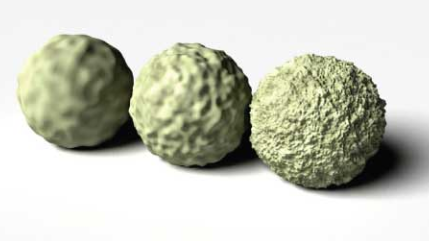

In [7]:
base64_data = "iVBORw0KGgoAAAANSUhEUgAAAa0AAADxCAIAAAD3D39YAAAAAXNSR0IArs4c6QAAAARnQU1BAACxjwv8YQUAAAAJcEhZcwAADsMAAA7DAcdvqGQAAP+lSURBVHhe7P0FeBtZtrYNf9f/fec9M9Pd0xRmZkaHmclx4pgxsR0nMdsxMzMzM6PMJDMzs2WZZEkWs+3kXyUp6fTM9DndJ93vdJ/2ulYqpVK5JO2qfe/nqdq16/9hLMdyLMdy/LljmYPLsRzL8WePZQ4ux3Isx589ljm4HMuxHH/2WObgcizHcvzZY5mDy7Ecy/Fnj2UOLsdyLMefPZY5uBzLsRx/9ljm4HIsx3L82WOZg8uxHMvxZ49lDi7HcizHnz2WObgcy7Ecf/ZY5uByLMdy/NljmYPLsRzL8WePZQ4ux3Isx589ljm4HMuxHH/2WObgcizHcvzZY5mDy7Ecy/Fnj2UOLsdyLMefPT6Lg8xfKYSb+3EI3/unEL7924TwMz4vhNv6cQjf++wQbu4zQrihnx3CP/u8EG7r80K4reX4GSEssn8K4dvL8eP4XA6yPjt+at/81MaFb/8G8W/5Ob8ofmrjvyh+6TcR/tnnhXBbnxfCbS3Hzwhhkf04fpXj539lLHPwh/i3/JxfFD+18V8Uv/SbCP/s80K4rc8L4baW42eEsMh+HL/K8fO/MpY5+EP8W37OL4qf2vgvil/6TYR/9nkh3NbnhXBby/EzQlhkP45f5fj5XxnLHPwh/i0/5xfFT238F8Uv/SbCP/u8EG7r80K4reX4GSEssh/Hr3L8/K+MZQ7+EP+Wn/OL4qc2/ovil34T4Z99Xgi39Xkh3NZy/IwQFtmP41c5fv5XxjIHf4h/y8/5RfFTG/9F8Uu/ifDPPi+E2/q8EG5rOX5GCIvsx/GrHD//K+OPxUEO/OO/SfuQdP7L/yJghY8rf8x/HR8+kc3P/2H8kp/zi+OnNv6L4pd+E+GffV4It/V5IdzWcvyMEBbZj+NXOX7+V8bP5aCwIH+TAOgA4H5GMnkwBZCx2DQ2h87hMlhsBHNUKplKpdCRYEDSaAwqlQ5JoVAZTCqLDYmsL/gTJDksGo0Cyf8T2AIcH2zIDx/EZTG5H+YFKcAi4APK4Yf8l/Gr8A5CuLkfx6+18T9zCItyOZbjk/g9cPDT+ISJACMA3z8ki0OnU5ksCkCNt8BCksfhctkQgIgPLOOxWQsc9iKHs8Bk0ugMEo0+T6OTqLR5JKlkCoW0uLi4sLDA4y1yuQtsNvJBTAYX8pPP+hSFAg5C/PcchBCu+3kh3NaPY5mDnx/ColyO5fgk/u0chIpNB72GJMwgL/ksQyC48K+SB9IPoPbB4SK+mEYDVcdk0NkMOofPsgU2a5HDXuJyljgQXAZAE45/JhMRjwINuLCwtMDjr8BeBGjCnzAZCAo/4SA/QRv+Iwp/CEHJ/HMI3/68EG7rx7HMwc8PYVEux3J8Er8HDgIEySw2BTGwCAphmQCCS5/kDxxcQmJhcZG3sMCFANABp5hM0IlsOo0DyaBz+cmDKUhE8M4sNiLf+B8HgaxPp8HKyPofV2YyEBQKPuKT/GeDDFPBRpY5+IcMYVEux3J8Er8DDgIBOUQWZx6ZEXIQALTIYrxjMd4jKeSggErggBkC/chkUcH2gsoDOsBSDocHyRd3CMIE+o6GBIlGI9PpFBCPTCagBFjGZvO98ydK8CMH/8tETh0i3lwwFRbNPwX/d31uCLf141jm4OeHsCiXYzk+id8DB8ksDgFBIcwgHGTzoSPg4Ds+BAE6AC9AACg7Ko1OoNLmIGl0Ip0B9KSC8+VyWVwuG9QhIhG5vA8Jr8EUwwpUNpfG4dI5HCabw+Rw2LwFLg/+cQGdQEP4OC4oSr4O5QtA5Av89wmlIiydH4fwl31eCLf141jm4OeHsCiXYzk+id8DB6l8MUji+2IGC+ERUGaRnzADYOKvAysguJxjcXB01gyFNjlPmSCSMUQydp48OU+eIpKm58mzZCrCRwYTjDawj8pkExksHI05Q6HPkChThPlJPAE7h8fi5rB4whRxfpZMIdLoZNCVgEjgI5+2EIhm5JtffiJ8hG+CiMdPcpmDf8gQFuVyLMcn8bM4+FtWP2AcSDYaG7G6AoIAekAA8k0ocnqPxmTPMzlzDPYUlTlKpg+NTzUNjtZ09JQ2tORW12VWVKeXV6ZV16HaOtGdPdV9g43DY20YbPfkTN80bmAU09Y/VNfTX9XeXd7cXlLXmF9ZjSpDZ5aWZ6IrUbX1xa3t1YPDHbO4MTqTwOEiXpuvSeGbwE8WpKBLDRdMtMBB8yG4CKabwWALCkcQMM+34TT+r/jc4Bf8PwZ8ivDtP2UIyvkfQvjezw5hUS7HcnwS/4/w6Pj3BZuN+FkINvtD8l9xOAxwynTmLJU5QWEM48mdE7M1Q5iSutakksrwdJRXbJJDRKx1aJRVULhFcIRVZKxDXLJ7WlYAqiC8sDSmuDy+BB2PKgxPz/ZPTPWISXSOiHHwD7F08dC3sn9jZPbC2FzV1FLd2l7b2886NSO0tiF/aKSNQJwEOYlwmUNnspBks5l0Og2qGzhoBp1Do7IFF6OpFKiByNUS/qlJ+NoIE6n8EPyu5fjVQ3DI/kP8D1D48wM2LvyYH4fw7R/HT638U99Q+PbnhXBbv4MQfqE/Zvz7OQg0YSNqi59IMBEMcSkcHpHBnpynDuLm26eJ9ZjZ8qGJ/J6RzLrW6NKa4OxC95Rsh4R027gUm+gkq6hE69hku4R0p5Qs94xcn+x8v5zCwJzCgJxCv8x875Rst4Q0p5gku5BIc08/XQe3NzaOaha2KoZm8lp6kho6z/QM5c2t1b39rAqLUzu76+cIGAaTyGSRmCwyG0Qikyq4GkOl0kHtcbmLPO47Bh3wB4oV+Mjh8UC9suh0OpfLXVpa4v+o5fj1Q3jM/jiWOfg7CeEX+mPGv52D4DqRTn9M5BwcG7HGyOVjPJMzTWONEqmdM8QG7FzFBK50fDZ/aDKrbyytuTu6qik4v9wjq9AxPc8+DWWfkm2XnGWfmuPET+eUbOeULOfkTOekTMCiY0q2Y3KWIB3iU20j4y2Co0z8Q9/6BOm7+WjZOquZWSsZWygYWygamiobmqr5+ttl5sRU1ea1d1aPjneDQqTSCAwmmcGk0miQyBVtLgcULCJioQSB3IuLizAlk8mAQgETl+O3CMEh+w+xzMHfSQi/0B8zfgccZPA7/THYYELBCDPZODprnMYexFNaponVk/iySULxJLEIiy8YnckemEhr7YupbgkqqnRHlTjmFDvllrrmlbnnlXnkl3nlFLun5wL+7ONSraOTLKMSLaKSzGJTLBIz7NJzXbIK3LMLgZ4emfnuCWkOMUk2odHmQENH99em1op6xlLaBlIgDPXeKuoZKhuZqtk5GgSHuqZlRBcUZdQ3oEdH++dJc1QamYLcw0cDCMLxDeyjUCjAPgh+B23w0WzhL1uOXzuEx+yPY5mDv5MQfqE/Zvwu9CB4TORYYVOY7DmAIJnRPU9vxpGrpudLpoiFU/P5U/MF4zhU33hKe39sbVswusG3qMqjqNKjvM63ujmkri2itjW8vC6ooNwnI885Ps06It40JNowOPJteJxxTLIFSEIgYF6pT0G5f1FFUHFlcF5JQGaeV3yqU0iUuau3FnBQU++J2usHqq8fqqg/UFF/9PLN09eakuoakqrqEtq6z41NtZycLePiI2rrKsbGh8kUIpeL2GH42oILI0gfHf5ZwmUO/nYhPGZ/HD9FmV8lfgptwrd/HD+18k99Q+HbnxfCbf0OQviF/pjxuzg/CI6YzWawuSQmZ4rC7CPQGmfJ6Kn5QiwhZwyXMTKTOjSZ2j2S2NgVWdkYWF7rW17vCzMNHREdA4k9I2ndw6ktPQmVDWEF5b6pOY4R8WYB4fo+QdpegZpAw9hU6/Rc17wS30J0YEllSHlNZEVddF1Lcll1VEaub2ScrYevrqmV0mvtx4oqN2UUL0nKXZCUuyireF3xxV0llQcKzx/IKjyQlLknIf1ARu6J2ktFaxuzzKyUgcFeMpkE7FtYWIDfAEUpICDM8H/Ucvz6wT9i/zGWOfg7CeEX+mPGv5+DbDYT6QjNI3N4c0zOGJnRAUoQSygYnU7vx8R3DkW29oc194TXd4RWNgSWVvtUNATWtYV3DiYPT6IwuMKRqbzuofTGjnh0XVhuiXd8mm1ghIGH/xsXr5fOnmp+IbqRCRap2S55Jf7FFSHo2sja5oSmjtTmrgx0bUx6jndIlKWTu4aBiewL9XuAP1HxE4+fnRKTEBGTOPNE8vwz6SvScrckZW8/lbgpKnb97v3LV66KXLh06pHoHfVXz0tKCzCYUf4oD0w6ncrhskARMhh0qBH8/L8WbH6nS34Kez4KQvA1PubH+Od1GPwzs/R/lYK3/jk/XYd/e7gwBUv46/zocwUf+ulHC+LT5YL8yRAesz+OPwIH4c1/8QOFb/+LgO18mv9V8LckKIH/YirI3zaEX+iPGb8RBz8W/Y8S1BO8B58KRwxiIBEBxWQw55msaRZngskepTJ6cPP1mOmigfHMlq6ompaAynrvshoPdK1XRYNfTWNgTXNwa29C93DayGQ+Fl82RSgfmy7qG81u7UmqqA9DFXtEJ1n4hmi7+qi7+rx093sVFGEYk2STluNWWB5YUR9Z3xrX0p3U3pfa2JFYWhWSlOHoF2Jg7aiibSCupHL7qeT5Ow+O3n104p7oqfuPTj8QPSP65OITiWtPnl17JHbl3sNLd+5duH7zjMjZQ4cO79i7b/MzyQc+fs4DQx0Li3QuDxBABhDweCwuj8XmwOFLB8tMp9OhGnA4CCwFRfPrB5PLYiwJE+nbiNx9iKCNRWMgV7qpTBYyhgV8Pr9bEtLtkU6DSot8HwYyHg+ZwSKxOSTuApnOnJsjjo2Od3Z01ba0VfYPts7MjtIYBAp1jkiansNP4OYweCKWTJmmMWaZ7DkOj8hZIDJYM0Ty2AxuYHK6FzvdhyOMUWizdAYRtkxnUPi7G3Yz0h2dQWfTketM8NFsKpVGpcIL5BIZ8pXoLPhWNCQ/guPTQI6fnwrhKr9BCD/gn0L49j+F8O0fBSwVdMX/kPyfDyl8XxjwqwUJG0Hul/+QsBos+TQ/XZnf2EDD83Eq7P366fRjIl9F+EV/HPxt/q6DD6vfMH4jDn5a+oJE9gGXi3Q0gU+FH8bvIQhHA2gHHJszymL3U2mdOHztyHhhZ3dqQ0sUuiqgGO1VVOpWUOpSgnarrPNtagtu7YkaGM8axuZhZksm8eWQ4zPFQxN5nQNpVY3huSWesamWgRG63kEaPsGaAeG6kfEWSRlOOYXeZdUhda1Rzd1xrb2QsdXNYfllXjHJFu5+b0ys5F5qPpCSv/Lgscj1W0ev3z5+887J2/dFHoief/z0ylOJG2Li10SfXAUU3n906ebtsxcuHz15eu/hY9v2H9p47uLB15rymTkxk1MDwBEul8KnIUIfROci8hDpbYP0DWIjbcBvElC1GO9YdP692MidiDx+x0ZQZFT+ZW4y0jmcjVzA4V/jXkB6gNNhBb6OZVLoDDydOcvkIP00p+e6O3vLC0rigsMdHV0N3L1MI6I9snPj8otSSsoykP7n6HTI8sr0mobs1s7Crr4SyJbO3JrG1LKquBJ0TE5+eFKaf0pacG1D0Tx5iseDnc4hEknwiWzWIpPBgxkOh7ewsAhVmkaDai3ol45M2choacjNjvyy+ofiEhxFf8xA8Ac/UJBQBeCnCVCIvPdh+rGmCO4r/Yf1BfnxTz6uLMh/Zt+n00/zX3NQwILPDOG2fpsQfsZvFv/X9CCyC/l6EBFK8Lu4UEN4TDaHwuZMszmDVFr7DK5mcDivpS2xoiqksMSroNizoNijoNi1sNS1vMqzrimooyeqeyhxdDJfAMEpAhqmoAcHMbnAweqmiKIKvzSUY0yyeXicEWRkollCul1GrlshOqCqMaKxM6a5O6axM6q+PaKwwjst1z402tDBXUXP+JnCi+sPxU5fvXnkwuWDF68cuXrj+K27IvcfXRQTvy4hfeeZ1C1xyRuQT55dBxreuX/26o2Tl64ePndx/669q/bsXyMhfTcswqurp45MneEt0Ngcvshi0ICDCwsLUO0FrfpvFiA3QAy+ZzEBgvybEZE6A59HR/QgCxIKHILLZvHgG7GRRCCI3ErIpbI4BAZrmsocx8609QyUV9enp2cHevmZvDVR1NKT0jdStLB+7ephHBLhFJ/sk5oRmJ4TmJUXVFQeWVWfWN2YVNUQX14TWVwZWlQRXFwRmoHy9Qs2tbBRd3J9m5gSUt9QjsfPwGdDY4D0u+QtsflDmQGRoS0EDgIWGXThyI/8r4cMlvFJnYcQHD+CavwHDQH1BAkh+EX8RETcJycZPuypT1JQFIL8pCiE6wvQ9vPzX4cQBp8Xwm39NiH8jN8sfuvzg/z9h7SHPxz9AAjwj1wenbsAlRBPpQ/jCU3YSXRvf05DU1w5Oii/0Cs71wWV75JX6Jpf5Fpc7lFV59fSEd47mDCIScfMFGJwpQIxOIErHZ0qHBhHdfSn1jRHltcG55d5ZxW4puc6ARDTUE6Z+W75Zb7outCGjpiWnrimruiallB0fVBGvmNsioVPsLalvdJrbdFn0heu3jx0+uyu46d2nTqz7/zFw9dunrz38MKTZzekZO9Jy0HelZFHUlrujoT0zacS18TEL1+7eRy4KXJuz+mze67fOv1aQyEhKax/sJ3JIi8uAvho8/NE+L1LS+/gt4MwFBbJrx/AQcEtzws/rjxIYX84+mGJkDV8tQVfh8Jkk9jceRYHR6aPzc33DIxWtnSgKmoT8opDYxOd3bx1rR3UbRxeOblre/ga+AWbhUZaxyW75hYF1zYltnVndvRldfRntvWmtXQlNXUkNHbENXbEl9WEpaM8AsPNTC2fS8vfkZK97+Fl39BYRaHMI6NecDlgh8lkCnwxOBoAeaBPuRyeoD8m/4t9bDAE/8GUX+2F+UcM+An8X/ERdj/Kj+dVPySy8kfwQX6MT4ri4x/+UCaCNf/l9NP81yGEweeFcFu/TQg/4zeL34iDH8pd6AgEtRQOdOAgUgNZHBKHR2RzcTQmBkdoGx4t6urJqGuIKS0PzM33zEa5ZuY4ofKdgYMFxW6laK+a+sDWzsi+oaSB8YwhTM4wNh/wBzkyWQAQ7B3Jau9LqWuNBkmIrgsprQoAYViI9oUsqvQrrw2qbY1s7o4FMVjbGlZa45dX7pGYYRsWa+Lq/cbIQvb5y7sPRE+fOb/70JFN+w9uPnx0xymRfZeuHLtzDzh4U1ruvpziQwXlh4ovHiqrPnqhJvpc7RGksqqopMzNh4/PX7525OiJrbv3rTt6fKfY09uW1oaVVSV4/PTiEheUL5kMwvD/TgUW1B8IoAk/kbaH3wLxG6EPCUIQKhKFwUTsMJWBJZAHMFPNfcNlXQMF9a0p5TXRxRXhqMLAhFSXqHiHmCTH2GSHyDgrvxADF69XTp4v/cP0kzIdiioCoLTr22NaexO6hlJ6hlO7h5O7BpNhYUaea1iMmYefnr6xnLjUddEnV9VfK3R2Nc7isFwuY2GBDa0hG1Qgg0KjU+Brs9nI9SVImIHDg38XI7+qf1rhf1Tn/1gB+wW+P+WTFDwr4mN++IHC3/gzUyAeP74UfNB/O/3XIWDBZ4ZwW79NCD/jN4vfiIMf6uEPEISExh8qJJ3JIiHDxnAnaawRIrUbO1PT25/d3JoAdjivwCsz2zkt0z4t0y471ym3wCW/yK24zANd5VfXGNLSHtXWE9faHd/WmwxGuGswvXsoA6YwD0tAj9S3xdS2REFVrGwIr2wIq2wMrWwMqWkJaegAUxxV1xZeVuuXU+yamuMQnWTpH2pg46SqqScuJXf92q0jR45v2bVn7Y5d6/fu33z0+O5zF47cunNO7CnowbvySg+UVBD2qb4SVdcQe6315I3OUw0dCW09OVX1pyAVH4heOHvhwKGjW4+d2H3l2ml5xWfuHo4NjTVUKmlxERktFqo4Ust/q+DbK6QiCSoGBBQ+cnZJMNo2MrAYgkhQWnQm8sAWMptHZHJmaUwEguNTDR09+dWNiQ1tyei6iCJ0YEmVoHdRFGCxoy+7tSelvi22CO0XnWTu7vfS3l3Bxfu5V9DLwEit6GSjrEKH8jqf2tZgyKqmwIaO6Jwi94h409hku5Qsj9BIWzsnbVOLV14+1ulZ0c2tFSNj3Xgils0Byczg8mgcDjgDJm+BCYgE90yjz5PJeKSl/AdACPK/rMy/14C9Q4OGn3/iWJD/Y/z988/nLxdsQTj90H58nAqJKZj/1wUohMHnhXBbv00IP+M3i9+Ug4ITvR84iPhiDrSHTPYcg42ls4fn6Z3TxLphTFFHV0pDU0x5RVBegScowfQse8jMHMfsXCQFwrCo1LMU7V1a5VdWHQiiD2AHAhDY19yV0NKdKMimzviG9lhYDjSEaV1bVH17eENneGNXeF0b2OGA3FL3lGy7mGTLkCgTNx9NQ3M5ZdV790XPgLfdvXftpi0rtmxdu3PXpoOHdoqcPXTj1hlRsWsS0reBg8oIBx+qvn74SktUU++JjuEzXUNJHQNZA2NlQxMVtVfi12+d3LN/3c7da/fs27Rl25oTJw+9UFFMSIwdGxuBgw+5IPEbniCEI/5D1UKOdQhB4fMf0oKcDQQIwnIqkzXPYOHJNCyJOkpljlGZw3OkjlFsRXtPVm1LHLouPK/UC9RcVoE7qtinqCKwoQ0EeP74bPH4bGHPSEZ5XWBipmVorC5kZOLb2FTjVJRVfrlrZaN/TUtwRYN/UaVHVqETlHBihl1qjnNmnndWvh+qMLigJDIjJzgTFZaY6h8Z456UElhRndk7UIud6sUTMWTqDINF5HDJ3AX+SJEcgOCnvPiYH3/dHyv4HER+zkcl+M/s+zTgOPm4/B+OGdiPH3W9IGEZbE2wzZ+afpIIDf/FcSiEweeFcFu/TQg/4zeL3+784IddBRVSOA/tPx05K8+eZHBGqOyuOUr9BK60dzijqTWmpi68DB1QUOSJyncVZEa2A6jCtEwbQaZn2cKSdJRDTqFbbokneN7yWhAgQhoCBEESAhMFHIQEbdjYGdvUHdXUDSgMrW4OKq7yzixwjEu1jogz9Qt56+D6WltfEhGDN4+BGNyy7fu167/etHn19h0b9h/ccfrMwWs3RB4+vvJM6oa80j1l1YfP1R6ovr7/SvuRpv5jXaOn+iaSVnavDE1faOvJa2jLyCrcv3D50PadK9es+2rbjjX7DmzbvWfrhYsijk52vb3dNBpyRkxYML9+/GsOggzkDzQLlhPUIonf/ExDCzQ91zmGrcPNt5Ho3QRKGxZXOYgp6B3JQtcFI2IZZZ+GcszIc8kt8alvi+sfz+0by+wdTW/rS0DXB+aVuRdVejd0RA1OZGHxRRNzhZAYXMEQNru1N66yMTizwBVKOCTaKDjSKC7FLrfYr7Qqsrw6Cl0bW92YVF4dl5UXkJDqFpPoFB5tFx7lHJ8UkJ0bX1WT391bPzHZR5jHUGjTTDZ/fHJkVMofCyjhr/vDBeygT0n0KeA+VBNBImcwBI2WID+uxieg0GD9SFv8aOP/bS5z8CfiN+Hgp9pHcMaHSiNRaXg2l8BZmGEvYOjcPiK9HqrQwAS42oSm1qhacLI1wRXVAegq/5Jyn4Jiz9wCt6xcp9QM24Rki/gks8QUy9R0+3SUY2aec3ahW36Zd0lVAAjDqsZw0IY1zZGCBCUIKBTKw664xq7IuvYg5D68So+cYpekLOS0oF+Iga3TSwtbFQ0dycfiF0+c3r591/ebt327bcfq3Xs27d237dDhXadEDly5duL+owviktdlFe8i95ao3nn+8vaLV7dV39x+qXn3peZ9fSM5A2NFbX05tdficor37z08d+jolrXrv1qz7u9r132zZu13W7Zu2H9gt4ysRF1d9dLSIplMJpFINBryAOWlpSUKhYII5F8hkAdR8QflZvNvdEauUPNPxULQmCwygz1HpmOmcB29g2X1rWk1jUm9w0VEWjuN0znPaCbQ6icJZd3DKfyTp75IU5FmHp1skpJtX4j2r2kGWR0NbreuNQpdB22JX0VDCJTtwDgKM1uCnSsbmy7qGkyHkoeVUcVemfleSRnOEXFWYTEWwMGsfK+iiqCymrDGjsS61riqxqjy2tD8Mr/kLMfQGBPkTh4L1deaUpo6csZm6ibmr61sdLx8bTy9bSOj/RKTw8rReUTSFKCQQJziIbftIF2vQN5CAcIU5qlUKpSqoBR+t8EfGh3ZKYAtJhO+PFQKMAjIL1hceMflLNFpbCYD5t8vLb6DlYFWyPNmkbqP9HaCQwW5wMjgkEkMGpXNYiLDHcHKNCoHZvhVDdaEw4qCXIH8wFA6Hem5BZuCY4DH4ywtQfEhGxR8pX97wKEJ3+afQ/j254VwW78kfiMOMvh91pAeJHAQM1gEGmOWyphk8SbZi2OspQEarx1Pr8LMofoxyZ0Dsc3tkXWAs7rgqtogQGEp2q+wxDO30C071xkkIRAwPtEyKcUmLcMhPcc5u8A1p8i9AO1TWh1YUR/6kYPVkPwZ4CAIQ0QbdsSAXyuv9yqocMkqdEjKtI2IN/MNNnDx0jS2UNQzlAWrC6b4pMiOvQfW7tq7es/+9fsObDlwaNvR47tEzoIePPVAFDh4VVbxlrzybYXnNxVe3FBUva6kdk355XXllzdfaT0Gkr7WklRRF1NQfvD46WWRc3u37lixas0XK1d/sXLVlxs3rd6wcfWBg3u0dd40NdWDNANKwQELUyAgzPAd668QcNAjjzNlIkc5f5sMZKAwZNAwMJsEJgeLJ3WPTKA7+7NaulP6x/KJtBbe0iDv/QD7fRf7fTuRUdU/ntbcHQXFVYj2SMmxjkoyjk4yS8q0zy70qGwIQ4q3KaKsOrCg3Ke40r+6KbKpEwR4akd/RmtPamVDZGa+W1ismVeArruPrn+IWUSsbUySQ1yKQ3quK7ouDLjZMZDc1hff3B3T0BGOrvfLLnaISTHxDtQxNFWQlr8h+vScrOJt1VdPoMm5c1/k6o0TT8RvScs+1NR+XlicvrTEePcODikyNKiC3ys4dmEGUAghWPh7DaTXOvAL6bOJiHTBU3EQWbfAew84E3CQRmXxOw/Bb2FyeYjA5/IQQ81gUIH8gg5YggHf4M/pNC6dxiPgaUwGD1nC5vJ4i+/fv3/3DpkXcBZaW/4leOQlTBcWFvkg/nWOt8+PPwMHkb7DyMUQNtRDMDjIIFp0NobGHmQuDDAXu+gLbWRO3SylZGw2s3csvnMgurUzsrElvKY+qKo2oLLGv6zCp7DEI4/PwfRMh+RUm8Rkm5Q0+4ws5wyUS26xR16pF9RGdC0iBgUaEFJQV2GKOGL+NZPq5vCSau/cUqdUlHVMimlI9FvvQG17N3VzG2VNXQkVdVFxqas37hw7c2HX8VNbj53cevTEtiPHtx87sevUmb1gcm/eOSkqdvGZ9DUZhZuyijdlFK/JKF6WUbokrXhRkHLK15VV7714+UhZ9YGSykNpuds375yGLWzc/O2KVX/7+pv/XL3m25Wrvvniy/+zect6fX2d0dHRxcVFkDBQdQGCcCj8SnoQOIg8xRRKHoQh8pBS5CQsAbnfYxHHXZqicQaxczXdQ1nt/ck9I+kTc6VkVgud10FhN5NYdWR2DRZf0NQd2dQd0dAZVtHon1/unp7nkJrjkFPkWVThD+0NlHZuiXdqjlNCum1ytgPovvLasNrmuNrm+Mr66JxCv+BIUxMrOeWXt6QVruu+lfMLMk9Kd0/KcEnJdiqrCQII9o6m9I2nDEyk9GMSOwYjq1u888oc49MsnNxfySlfE7mwWeTCVrFn58SlLp2/vPfA4bUnRXaeFNm1Z9+Gp8/uVNcWLr6jTs+MkUhEENFw1CJnmvlFB2UoKIHfcSCMo1I4QC5wsmzWIkyBicA+/rOz+WeOESgggo5Gp9CZJAptlkydYrLxVDqOQJwkkXEk8hzIOvjtdDqQAv4WoMmj0zjvlt69f/ce5gXDAzPoXCqFxWEvgsyEhVwOQHMRllDITP6UwW9Hfhco5P/kfxHCtz8vhNv6JfGbcBCUCNRDICCbNwsakMEdpnF6qZw2KqeZyq0nc6oIjNKpedTwdHLvWGzXYEx7d3Rze3hdU7AAheWVvkWlCAdz8lwys51ABqamO6RnOmWj3LLzPQpKfaFaIicHAYItkYJTgZACFMJU8BLmwcfllbml5QIETYIiDTz9texd1Ywt5HUNpQCCIEPuPRK5fP3ghSv7zl/eff7ynnOX9py9sOf8pQOXrx0BCD54fPap5BVYDSAoq3hDRuGqpNzFZzLnnkqLiEmchnwqBSrmhuKLe5DKqo8Unt8XE7986erhvQc2rN/49Vdf/7/frfjbqtXffPX3v3z1978eOXIwKChwbm6ODsqNSoVjGkrqV9IyoArY/Kfag5RAHvZCR57HMkGhjzI4IxRWD47UMDJZ2D2c3jWUBDwanynAU2sBgmR2I4lVO8+smiQUdA3Hd48ktg/E1rWFFlZ4puc6ZeS5gtWtqA+DVie70BVsclyqJWR6rktxZWBNU2xje1JDW3JVQ1x2ob9vsOFrbdEHj4+LnN8B5fbWRCk4whI4mJrjXIj2BQ04MJE6Ops+OZ89Q0FNEDIHJuJa+8OQDu3oQK8APWhdzl/ZevXWnkdPRR49OXPp2v5LVw/eunvq4JHNGzZ/o6XzYnS8a3GJgTx168O431CRYP5jSf6Og82/WvUekv84B+AXfG3kGEAeqI30IaMuLDJ5i3Q2d57feuEo9DESbZhIHpqa7cERBhjsWSp9GoPt7eltmZ2b4O9lMBbIeY+FhSWA7DyRAlpygQfsQ+wzfAQVFgjl5yLoTYHw5HGX2OzfiyT8E3CQTWey51lcHIs7xeJhGNxBKruDxKonMisIzFICsxDPyOdXhgzgYN94XM9wbFd/TGtnRENrSF1jcHVdIJ+DnvlFHnkFHqg8d8BfFso9J9czr8A3r9ivtDIIIAhmTYA8cMH8HrxxMCMgoEAMwgqAS6jASVnWYbFGXoGaju4vzayVdAyk1TWeyivfeSJx+ebd41dvHrp269DNu4du3D14486hW/eO3b5/EszyY/GLEjLgiG8qPr+jpHJX8cUdOaWbUvJXxKXPP352+uGTk/cfH3/8TERK/rK8MrjmW0oq95VVHknK3Lpz/8yJ07t37Frz3Yq/AAfXrvtOoAq//fbvDx8+rK2thdpLIpHgOICi+tU4iNQNGhCQxpgmkkdn5roxUw2Y6Zo5ShN2Dj0ymT+EzRnCZoH5BRS29SX0DGdgZkumieWThGIMLn9kOqtvPLm5J7Ki0S8lx8ojQMXEWtzIUtzJUzUgXC86yRTUdGyqGUyjk01jUyxAFeYUeaFrIyrrY9C10aiigKAIs7dm0tIKFy9chRZl92Pxs29NZQLCjJKzHIqrfEBpjuOypkg5sPeJrCIcLX98Ln1gAsxyQm1LTE6hr5uPpvLLG3dFD91/fExS7sqNO4dPiGy5cuPolevH1238cv/BzY7Opk0tlWQKEQQ1OERgH4RAFcJBLCyG32mA7hP4WdBrHDqdCQ0hqD8mi8LmUDg8Mm+RxF3EcxZmGRwsjTk2T+2dnKsfwpTXNiXnFARW1CZiphqncO1RcR4W1pqpGRFDI21zhHEaY47BJHJ5dB5ITBZ9cWkR4EihkKFFXFpaoDOogBrkUwCNyFljDhuoiNyP/HuRz38KDkLLxubNsHgTCAQ57URGLY5aNEPJmSKnTZFTIbHzqeNzKcPTSQMTCf1jCb1D8e3dUU1tofXNwTUNgegqv+Iyr8IS78Jin4Ii7/xC74Ii36LigOKS4OLy4IraMAEEBQRs6owXnA2E/DgPHETXhQqGIwQJExiB9AG2tHuhbyzzSvMp2FhxyasPxc4B8gB89x4dB649enpCVPzUU8kLEjKXpOWvyikB2u6pqD9Uey368s1j1VePnqvdB95Jyl4Rkzj7UOz0PVHkryTlLgEfIUESPld9KK90//HTKxevHDl4ZMuGTd+uWvPl6jV/X7Hy7999/9WXX/51x44dvr6+eDweagJUYDgUYCostM8JaHhYJNCAZBoGR+jHTDX1j5R19OV09KfzbzrMHsBkjE7ngPkdm8ntGUlt6opp6orvHc0cxuYMTmQAHAex6cNTmeM4VNdQIihon5DXZrZSlg5ygeGGWQXunYNJfWOpQ9hMWLOhIyq31CM2xZI/qqNTVoFnbrF/Zp53VIKtq7emiaX8c7V7ok/PPRA7oaR2w9JeIShSN7fUta0/ehyXARwEAs5Q8jD4zEEsWIGEtr74qsYIcNyh0SaG5hLiMqfuiR4Wlz4n+lRE5Pz285f2iolfuXH79P5DGy9cOvpcRSY9I7mjowMICCiEEJxmFRbC7zeQuwkARww6cs4OZCCVNk+lEcD8sjhzvKU5Gmt8eq59crZ5jtw+R2qZItRMEtDQUKGKPX2CNYOjDCvqonqGCtx9dJ+/vOcbaFFRk9bQnN/aUdreVdHdW0eYH5+aGaIxcLxFCrhpOmuOxSHiiRjC/AQkkYyF6ezcCA4/BuhEztf/q+vF//fjfzcHoYiRk7vIvSILU0zeCI3TM89omKWUYImZ4/iEcXzsOCEOcmwufgyXNDKdMjSZOohJ6RuO7+iNam4Pa2gJqWkIAg4WlXkVl/kWl/kVl/oXl/mXlAWVocPK0eHl1eFVDRE1zRH1bdGNnXHN3cLOg609SW29yTDlZ2JjRyy6LiS/zDsl2yEywcwnSNfWWdXIXF5D59lztQcyCrfvPRS5+/A05EMxkSeSZyTlLkgrXpRVvqyoclNZ7c6LV/dfaoi+1n6ioftUU09cS08C/vDlmycAUBmFm08lLz56cvbeoxN3Hx0DeQjWWOCOVdQfP1d9LKtw7+Hjy6dE9m7ZhvShWbHqi2+/+8vX3/zl22+/+vbbb0RFRaurq6Gk/kfnB6HlF+THEBY4nYmjMjDzlMFZQsf4VFXfaF57X0prb3zfWBrAa3gyCyA4gwxqWzI2kz+BK+bfml2KxRdNEopmSCV4OprEroJ1uoeTCtAegZHajh7P/UJ180r8uocyyexqxlId+30ThVs9MpVV2RiQnG0VmWAUk4IMcJuZ75GR656Q5hgWYxEQZuLlb2hl91LPSFLPWFzf9ImZrXhorE5ZnVdbf2TPaOwANolPwMTukYSeEcArWPX08trQqERzE2spSfkztx8euPvosIzCNSm56w9Ezz2Tuqmpo6isIn7rzrlrN87JK0ibmJjk5OTgcDgQhqCm4QgWlsTvOBj84bP4NZ9KpuBnceNjmK7BkUYcoWee2jeKrappSqhrSRybKpsl1YBIx9PLMXMoENExKUbu/i9ikk0r6sMiEyws7BQCw0yS0t18Ao0dXbUcXLSdPfTSs4MjYlzRVanTc11jE029g1UDwzWtncUl5YkVNekV1WnZeREx8R6pGYFNrUXAR/g6wq/1b40/KgeRrsAsDiS/y9KnCQHfng7JZlHZLAqHPc9dmOIsDbN4vVROK5FaOUXMHZ9NG56OHZ6KgenYLEAwcXw2dWwmfWwKVEla70hiR19MUwdY49CaxmB0tX9RuVcJ2rekIqAUHVhaGVxeGQoErKyKqqhFrg7XtkaAMAFd09wT19ITDxUevF57fxJkxwD4vsTGzmh0fWB+mVdSpkNotLmbj46F7XPdtzLAMlnFW08lL1+/ffTWvRP3RU+LPTsHmk7++XVltdsqr+6paz56rSWmqSuuYyCpayitbySjbyyrbySrYyCjoSOh+uqxwvO7UnLXnkhcEH16BlD4RPKctPw14CD4YtVXYqqvnjxXFZNVuH/p6tFde9auXQ8c/OuKVX9bsfKLFau+/uKLv27ZssXNzW1ubo5IJIBB5vvij1z7tFQBcEiR8ssWVhDemcPm9xpjIk+dhzWQq4pM5JIInsHGMHlDNGY3jtSImS4ZGM/uHkxq74vtGU4cxmZM4vNxlFI8tRxPrYCksuso7JopQsHYdDa8NUctnWegiQz06FRWa29MXolLUKS2u49qeKxxZV3YyGTePAtN5aHpi1VkLnqalAc6rq49uKDCLavQEVXiBrIlI9ctIc0+Mt46LMYqJtEpItY+KNzcw0/HxEpGQ/+euZ10QIRWUpZlPtqtpiWkqTuytS+mazhxEJMxhM3uHcmoa41OzXF09FB5qXnnmewZ0WcnQV9r6EhKy92+ev3YM6nbyi8k7ty7JHL2yPEThy9dOq+q+iIrK51AnEOeys8WnluAQxmqFhQpFBeCnF9H9HzcHfARn6ZgBwkqLXzihxWQ/QLzyHfgBzRRgqqBdJzgcWFKJJHHxydaunpLmjsyewfzhjAFrV2JOUXuxRW+I9i8OXLlyBSqZzR5AJPaPhCbirKycZEysXkSHKWXnGUfEm0Uk2ydmecREWcJrU5iuguqOCAmyeGtmbS1o0potGV6jldBaUhdc3Jbd3ZbT05nX25VQ0J0gp2Lp4Z/qHF+SUT/YCOBOEOnIw+n5V+hgUKDb4i0x/AC2maY4X9zDpPfMYn/c5ChkpDy5A/UJvhp/JnPCuSz/1UI3/68+KmN/xfxszgIJQBel87mQTJZPyR/gBAOvMlkkpnMeTYLz2PPLfCmeQsD7MU2FreZwqzFk0oxM9lD4ym9I3F9w7ED4wnjU2lYXPbUHGpyLhc7mwvVr280pb0/rqkLGQmmtgVsb3BpjX9pdUBZTVB5TQi6LhzwB1N0TQS6NrSqKRSqU21raH17eGNnZFNXdEtPTEtPbHt/PDi4ruHk9v4EeKu0xje3xD0uxd4v2MzOWdPQVFFTV/K52sOnkpfAC9+4c+T2/eMPHouIS12SVbwJnhfMr6aOxFsTBSMzJROL52ZWKubWqpAwA0v0jeR0DKT5qvAxrKzw/DbUVQmZy1Jy4KBvKqnchS3z7zsWVVYRlVO8L/rk8umze7Zs/27t+i/Xb/x63cavV635etXq7777/uszZ0/n5+cSiXjB051+qGnCLrL8RFSe4LYKqEUcZBQZxjsW4z2H9Z7NfE+n8Wg05BQ7k0VE7DB9mERrZfBaKPTaYUx2a0dUQ1toXXNQTVNAz0D8+FQ2kVpG59QyefWshUbOUhNrsW6eXoLFZY5Pp83O55MYZXhKMWY2u3cIVEkwqtA+Ik4vNEIrJdOqpiGkfzR1lpKHo+XhGQWQc/S8aXI2qPvR2fS+8aSmrsiSar+0XOewGFNX7zcWdkrmNsqObq89fPXAxzm6vzG1VlR5dUf02fEnUidMraWikyzyyjxrWsJ6R1MxuDwsvnB0KretN6mg3BcqubmtvOqbu1Lyl168fKhvpPTyteT5i4dBVu87sO34iQN79m5bs/Y7kTPHj584JCH5uKAQRaXO8xagLYEjlEEmk/hnGxBI0elQDQRH7s+Pjzvik/xRv+XFD7nE30H83ssICpHLEYIVmAzkii38FYCDzWGxOQw2h4rsRBaRxZzjcnBc7iSJDKqtdHgUNTGb39Aa3NId3tkX3dge2tETM0MowUzmVzWE1rVFDsJ+7E1A1wUlZlobWz+1d1PMLfEEc+MTrBWfZpOe61xQ7gc1orUnpaQyyDPgjZ2rkoLq+cQMu/q2uNgUK98QbXRdGKyTkG7rE6wdl2rd1JnY3puVlOqfjUoeGx8kkecYTDKZQqTT4Siic7nwe5l4POH9e6QDI4+3QCbROFDlkY6NHB53QeBe4McCHPn9b/63xc/nII8GHGQtQDKF+ZGDUEjzsKc5rFkee3qRh1lY6uUuNjO5dRRGJY5YND6ZNTCSDHWyfzhpaCwVXk7h8mYJhTOEwml8AWYWNYBJB0fW1gfKDqxuTH17ZHVzWFUjADG8siGioh6BYHltWFlNaGl1cEVDUGVjYHVzMKCwoQNBYXN3FAiZjoGErqEk/nWA2NrWkOIqz+wil9gke78gczsnzbcmiq+1noF7FXt24eZdEIPH7j46Kfr0rITMVcXnd0Howbsg+oCAppYvBAQUQBBeAgcNjOVBTmrpSb7Weqr2WhRQqKx6D2SgvNJNYCLSe0ZdFPTgyzfiaq/FwR0/lbh25vzerTu+W7vhi/Wbvlq/6e8bNn6/dt2Kr7/5YueurTo6mlgsZnFxARqiD1XuY33jdy6DEN5KIeAgf1gtxnsm/R2DtsRkLPB1D5nBQq4tEqldFEYjFDWUant3VG1jQH1zUHN7WFtXJJT25GzuPLWcxqpmAAq5dayFOga3kkgtmMJnTuIy5kh5BErhJC5ncCyppSO8stY3O882Ol4vMlY3Pduquj6waygelPsEMX2anIWjoeYYKBwtZ4aSM01GTeCz+8dTGjoic0u8gIPWjsoaeqIScucUVK5p6T81Mpczt3lhaCb/Qv3ewycnL17bJq143txWLjLeFKp3/3jGxFw+BodcwAEOltUEJ2XaeweChJR7qflQRf2RykuxJ8+uHzm2fd2GbzdtXrV9x6bNW9asWfvt1u3rdu3evHPX5sdiD3JQ6VCZ+VdKqDwe0IdFpdJAF/KHsfmlF0b/gYMIzj7ZKR8hKEikT/I/c5DNWuJy33FAKzAZ/DFoiQwWAVHr9GkaFcNhTy4tTVLp7b39adX1AbVNPj2DkX0jUUPjCSOYZOw0ikBCD41ll1T6V9SFdA8hMrm9LwXS2euFqsYVF28Vv1Ate3elwAjdlGz7qsbw+raY1p6k9FwnD391Wxd5XeMHwVH6Nc2wOzyjEk2TMm29g97Ep1vFJJun5jhM4Eqxc5WuXvo6+i9i4gPLK3LQFXmt7TUk8gyVhp+cGuFwaNAuc7gMZDQ2DmhDCpVK4fffRuShoDcij7eI0PCD5v1xCf86CvzfFb+Qg0JJiECQz0Euf5QQ4CCBxcRxWNM8zpSQg0vNUPFINPQMvmB0IqN/OLG7Pw5oODyeNjGdAwvn5ovxpBIcqRgM2ugUci6/byytdzStewS0YVJzt/D6b01zNKAQIFhSFVxcGVRUEVBWG1Be51/REFjVBKowDOphY2cU6EFEDA4ldwwmgkKsbAxCOsHlOkTF2/gEmtg4vAZBp64hJq9867H42dv3j94XPfnoichTyQvAshcvHwDdtPWlQAwC+yxs1CxtX1raqME8QNDYXBk4CG8JJKGWrgSsDJsCYaisel8ARNgCkFRdQ/yNtpSGjrT6GwlJmVvnLx3YtvN74OCGzX/fsPnrjZtWgJz59ruvVq/5/sSJo9XVlVB1KRQKmLkPdemThBDcTCasaaAHEQ7SqDwaFfEpXB5UdzyFgSFS+vGUNjqrkUgpH8GkN7WHAQeFY5SNpkBpY2dQUM5ASTq7BkEhr5bGqSBSoRECSZ45jc+ZxGUNjSd39EbWNQWWV3nm5NslpZkkppjm5DlU1Qa0dEd0DUX1YWJHZ5Mm5zNmqTlz9FxQhTha/hQpd2Q6C9R3cWVARJyZhZ0CqLm7oodEn52QU776UuOBnpE0cPC1tpik3KXLN3bCcg39hwHhehX1IcOTOZi5/LGZvMGJHKjqtS3RxRVByZku3gH6plZKSqr37j86c+L0ji3bVqxe+9WqNV+tW//9ps2rN25aCVhcu+67L778j+9XfCOvIFFVXQbEYXNA0UCRCVweUnb8rnlQXX9+fMLBHwj4aQqaKEHChwEHoYmCyi9YH/kT5EZGDjKshmBgTQYLT6FPzlPGiMRhAn6AThsFDjKYnZ09SYWlLoVl9tjZ9LGppImZ9DlSIdQUHKG0rTO+oMwbDvuO/tTSamiE0nHk6vg0q+evLhpaiLn7vXT0UA6JNsgr9WrpTkTXhRRV+Fk7yeqZPLSwl4pMMA2LNYSFHztOFKJ9hybywFSFxxl1DqRhZssDw82k5W/KKtzR1pMzMHrh429d11gwimlvbCkZHe+Ynh2cmOzjLMzTGLNcHpnLowH3eDz24iIPKjkIQv69LoLC4Z8HQIpLgEIodkHJ/1Hjf8ZBQSL6n8OGN0Fa41msGQ5rksfBLvLGFpZ6uItNUPGIlDIQKVA/+4YQDkK1HMNmwhKAILwFOgUs2yypBItUCTDIkCioIf3jmV1DqfzLHXG1LTGgB0H8F5T755WC1fUuqvAuqfYpq/VD1wcIUAhuGlRkx0AiJCjKurbw0mqfrEJH8BRh0RZefkbW9q/0DGVBx4GHfSJx/t6jE0BDgKC0/DWwtEA0EHqAOWNzJYSA/LSwVhMoQSAgJOhBWAEkIYJCPUlNXQlIAQ1VXz2CfPnmCShKTV0ZTV1Z4KCULJ+Du75ft/FL4ODGzd+s3/DdylVfr1n7/Xff/33DhrWurk4UCplKBdLx29UPdUmYsASpZpAQsBw0CNgx5MYDOh3pLM3izFMZEwRKL57cTqA2Uxi1M/hCaGZaOyMgoahBCUJp9w7GwxQKHEobJKFAD9I5lSR68SwRBTVwFJsyMJrQ2RfV1B4CHKyo8S4sdc3JtwcIFpW6V9UF1rUG17X5NfUEdo9GDU8nYvnCcIaCmiYDyLIGsWlQ4CVVATHJlnYuKpr6j0EPSilcUFS5ARzUN5ZBHpZvKv9S45G0wmUltRtGFtJhsSagZQbGs0emUENYVP9YVltvSkN7Qk1TbGF5cFSCnZO7lsLzu2fO71q/6ctVa/62dv3fV6z6YvWar7eBEtyzEXLVmq9XrPxy9Zpvdu7apKun0d7RJHgAAJNJX1hAVCG0LmDf/uccFIrBf05+/QcOIut8WvP5e1A4y+Bw6RweItXx88NjE83d/eip6XYCoY9C6V9YHGeyOvsH06vr/GoafeZIuSDJsbOZeHIRgVw2PJZVWRNUUObV2Z8KHKxsCANVCBysqA+zcZZz81UDZecfpg2iD2YSM2wCwnUAfGqaV0EtWthJ5pd5wxKQigA+0Ilj00UAQZCBqGIPVx/VzHyXxo6EhDSHl5r3JOUugFr3CzZJy/YtrYyra84sq0yorE1DV6c0tubjiL39Q9VTuE74/jj8KHEeua+Ry2VQqWQmE4wxMnjHhwP1Iwr/RBzk/piDXKRMkJHj6Gw2icnCsVhTHPYEjzu+uDCysNTNWWyCikcgl4IvAz0I2gRMMWYqG17iiMVAQDK9gkxHz9PQc5SymfniSUIRFo8kBlcwPInqHc2AfQktW1VjZElVEBAwu9AzI88tI881t9Q9H+1eVOlVWuMLqrC6WagKQRLyPXUEfzgAt1SUTWyKeVCEibuPgZWdOiBM9bUo6EEJmcvItRHZKwBBsLQq6g8FYhAwB9QDIyxIMMgf7fDHBAgKEtaHqYbOszfa4q80nwANgYPqGk9faQIcJZRVRMEXn72wD/QgmOKNW74WcBD04IaNq7/+5m9r1q64e+9mR0eb4E44fvBroPDwAg4KDi8ImPLrHv+wA73DhFaHTaAxsURqP47UiiM3Emj1U7MIBMEIQ3b2xkCCQQZVCAYZlgAKccQi2B0sXj2LJ+Bg6Swxdwyb2jsU29Yd3giwawqsawqqqvMrg2am3LMU7VVZ41/bEFrTFFTR4Fnb7tM2EAqqcGQmCYNPmyBkIB0AcBkDmJSWnpjSav+EdFt33zcmVtKvdR5oGYgZmcvaOr30CTQOi7b1CTC1tn+p81ZK2+CZua1ScKRxXqlPHXi63sT2vuSW7oTqpijkvEdNRH5pcEyig5uXvoq66OmzO1as/v9Wrv7L+o3ffLfiP79f+ddtO9YeOrLz+Ml9MLNpy6otW9euXvPtseMHLa1MO7ta6XQwcUwGgybopY4UHBydvyBgZf4u+C8Sqfb8FuuHmo9cPvgwjwxkwOFSWBwinTVFpAxPzrYPjlV29RURiF0s1iiLNcRbGKYz2sYm8rr74qDksbMZwEHMdDp2NhszldPRE1de5VdRFzw8kdcznAkyGURc32g2SD8wuaExb4F9MAOkC4rUs3NVAIXoFfgaXLNnwCvfEE14CzgINARrDBUH/hxQCDyNTDAxs5WANYGPWQVu4KBtnBUCwvTSclzqW+PzSv3DYy1KKsOqG+JTs9zTcrzTc7zjU11Kq2Kq69NKypOLS9O6e+uZLCKNToISBc3Lvy9QkHx5+ENp/IHj53OQQ/vhUgkCQVjIhtaPQ2WziciDllgTHM4ojzeyuDDIW+pkLzQKOAhiZHwyC1AIqnB6rgAqJDg4sGmQgMJ5WjmeWj5HKZ8hlU7PIwkoBA72jKQ3d8XXtkSV14RAtcnMd0/JdkrOckzOcsgudEGVuOaXexRX+ZTXBVQ2Blc3h9a1RdS3R9a2hlc0BBVVemcVOiVkWEQmmvqFvnX10rW0U9N9K632+pHii9uyitdlFK7JKd+A+edq99TeiL7RfqptIKlnKGNgLAfSz9BUEfIHI8xXf4A8gQYEAgogCFiEtz6iUO21GNTe52qiii8eSEjfuP/o7Kkzu4CDIAY3bf1m4xbg4Ldg7tau+/7rb/66YuU3m7es9/R0xc1BuQnqEhxMH1ShwHH8wzyyAh1aZiZ7jsbCkhlDRGrHHLlxllwzQ6roH0lp5jtioF5XfyzMg7IrLnctQbtV1/uBPIS9ILDGVCZAsIxAKZoh5I5MpHT2RtU3B1bV+fLTH13tU4r2LqvwqaoNrG8Kb2yJqmsJq2n2b+gMbB+MAA4OTyeNzqaM4VIx+AwMPnNoMq1jEEAWmlngFhxl6OihZmmv6OD20i/EKD4FrF9kVX0yqiAsIsbR0lZN20BCU1/MxulFSLRJao5zfpkPGGqYpue6Jmc5p2S5JqQ5B4WbO7lpg7I+f3nPqrX/sWrtXzZs+vqb7/7j62//v81bVx49vvvs+SMw3bQFDPJ3m7as3rR5jciZY75+HrOzk8DB+Xk8lUr6QKhfFHwOCsv8U/zx98sPKdhTAvbxBTsyjguVf1GLxObMc3gEFnIX6TiVNURl9lMZPRR6N3dh9N27icWlUTa3j0JrnMaVIMpgLKmjN3x8KhU7mzU2mQ5tVWdvbHNbZO9wxux85SAmF8QgVAHBfVPgkeNSLYGDuSWexZX+EfHGHv7qwL6sAlewxrAkI88ZSBeVaFbdFCE4b9jclVBRH5pTBBXHPjrJDMx1eW1QVqFzYJRmSo51bKqJf7hGcZVvUpaNjvE9dH1oU2eCf5ieX6iuqsbNt2bPAiOMohJsXTx0re01UzNCydRJvipkMxmQ0CTzT5L+STmIaD/goBCCTDYYNFgGHmSOyYZiGuNwhni8wcXFPt5iO5vXQGVWAQdn8AXYGRQowYnpHDypBAwa4A/egoQZIrWcQCsn0CtwFPQsGWhYBhwcwuaAL65vR+4JKaoIyCqAfemYkG4Xn2Ybn2aTme8MuzO31K2wwru0xh9dH1TVFIpcV2kKq+BfaM4r80jLtY9NNQuPM/YO0nP20LK0VdE1lAJ3pqx2R1H1thKk2p3nL++qIP0EH73ReaKl/wxqqe5bIeAECbwD8Akwxx9+9SnMwxLAnwCFHxEJb6m+eqykcl9O6a6EzI0Houdu3D5+/NT2bTu/AzG4edu3oAdXrv5i1eq/f7/iy5Wr/v7Nt39bueqb23eut7Q2CO4LFhb0D9UPKqRAGwqqJRxsUN9ITDaOzsJQmIMUVjeZ1UZk1M+QyjG4vN7BxIaW4JoG/46e6L6hROBgcblLdp4NqsCurNKjvTsSCl+gwWEXzBLyZ4l5wEGofp290fBX5VVeZRUexWXI02Dyi9xKyr1r6kOa26JbO+KbO6ObuyPbB6J6xuKHJpNGZ1KAg6MzyaOzqaOzacNTaX3jqa298aA1kjLtAyPeOnmou/tqBUeaJ2d6lFfHN7Vnl1clJaf7unsbauiKyyheVtO4Z+Xw3DdEPzLeIjbZOiLePCDcwDdYzy/krW+QoauXjrWDurrmUwEHV675PyCov1vxH9+t+D9bt688eHjb5asnz5w7tHX76vUbv9u2fe227es3b1kjKfWkqamWTicjmgW5vZrBL9VfhEIBBD8tc0io4YKATQkS2PeRgAL8kVnsedCALM4ckzNNY43T2SMM7hBrcYC91M+BXOwD/PEWBheXhpjsThK1jkiumJzN6x9JKK10HsYkzRDyMNOZoxOZQ2PpYxMoHAk9O18xjM3vHckCNVdQ7pOGcgRXm5rjAFPBMEsARFgouMseQFmI9oXyB8uMrgsR3F06iSsHGjp6KLv7vYR1QB7Caul5jn5hrxy9ZLKK7Aor3CIT9dr6wD+FWzqKg5eqagoxt5eITDAWlTggqXBSQ++umY2slj5yVTAi2pXBmuZwoYFBLkOxWIJS4idSSoJi+ehs/pDxSzkIkpDDZLH54wYh9/OzOUQ2Z5bNneDwRrm8AS6vl8vrYvOQi8VAOqAeCMDpuXyww5CfchDkCYmGxpNLwRcTwB3T0IBC0IPjs/l9Y5nt/UlVjWGwy3NLvAGCMclWEfFmUYkWsSlWcECkoRwyC5xRJe4FaDgs4FAIQtcFl9cFFVf6oUo8MvKcEjOsIxONg6MMPPy0HVxfm9s81zeWfqMj9lLjobrmw9faojDzSksUlmjqPdXSF0dSD6YI4wR0E8wA+ICA4J35V0Iegf8FJn6kIRBQoAdh+XO1h3JKtyVkrj9+ehEgeP7SvoNHNm7ftWLL9u+27vh+6/YV6zZ8vXL1l998+5eVq7/69ru/rVj59337d1pYGhOJc/znaiJd4fintKBkYQbch+DpbkgvL2T0BDgKuQDBcRp7kMHrYy100xdaiYzqCXz+IDa9vScadB9k72ACKIvG1pCCEqesXOuMHMu8IgfQiYKTEpCgzbEzOXPzRaDEYQoivbUzohTtmZFjnZRqnpBslpZpW1TqVdsQ1tIe29mT0jOUPjiePjSZPjqTMTqTNjydPDSVOAw5nTQynQoLhyYzekdTW3oQFKbnugRGGCKjzvjq+IcaJ6S55xaFoQoiktKAg0YvNcQeip0UkxABFJpay7t6a3gF6Hj4abl4vbZzUbV2VLF1fmntoGZsoaj6SvTStQMbNv9tzfr/XL/pyxWr/wMM8radKw8d2X7h0tFzFw7v3b9p/cZv1234du/+rfsPbD956pCXt+v0NIY/tDWLP+Y245fYYlj1IwQhBRz8FIIC3SeQfgL8URhMIotN5C2SOQsEwcCOFMbQLLGNzunlLg1ylnpZS52MxTYqt5nBaWdzuwCCdGYLndVIY9ZCpRjGpDS2BQ6NJwEQx7Dps4TCiWnUwEhaZ39iz3A6QHBoIg9MMWi6sFhDMLwg/QTXiOtao4F3gpumgIyxKRbpuU7828A9YRcUoX0BhURqPQBUcGkFBCPISXDHAeHaITHazj5ykUl6iZlmVk5PQ2O1y+v84tNN+8YySqp9PQJegviITrIIjTa0cpR38ngZFmNt76KhqSMFknB0vJPJIvGHPeNwkIHdeMjjBlnwgkVnQGPwSxue31f8Ug4iKRCDTDaNySax2HNs7jR3AcNbHOEu9HG4nWxOC5NTDxYMSAcahC9ACkEVAg1hHhQiLAQCwhTm50jFs+SSObDGVISDk4TikSkUiMHm7riymkBo8TLzkXE9Q2OMAiMMwmJNYCclpNtAeyhoHlHFHrC/YU8DMfnQRAYISMq0jUk2D4156x+m4+r9xs75pbmN8ltTGZ23IPrEYapnJCmY6htLGZhIwxReaug+0dB5oqGLcA30ncAIw8zHXjIwhRTcaSeQh4KEeUAkv3/1dbFnl+6Lnrl87dBJkR37Dq7bsXvljt2rdu5ZvXPPmh271qzb8M13K/66YtUX36/44utv/rJp89ozZ09kZafh5qYWFrggYXg8HlCPSqXyeEsc9hKDzqXTkRHMODwSmzfH4GDIzD4yq4Ox0MlaaqctNMzRysZmsvrGk1o6I9DV3uBtgYMDI0lVdX45+baZKCtAIajC0gp3ICNY5vbuqJ6B+DFsJrRGgh00hcvv7o8vKfeMSzQKDtMKCtWMiTfJL/KobYho60wYHEZNzJZM4AqwBMi8sdnMwcmk/on4AWw80HAMl4Yl5GDmcsZmckYmUZ2DqVVNESlZTkERxi5ebxzdX/sEGkXEOMQkuEfEODu46Kq+Erv36OSdB0eeyZyH1sjMWtHe9aWj+ysHt1eW9s+NLeVNLBWMzBV0DKSUVe9fvXlo266v1238C6Dwu5X/v1Vr/xNK8uiJHSJnD5y/eOTw0e38duWLfQe2njt/HDj45OmD2NiIvv5OBoO8sMCi0kh8Sfgz4yMH+V7vRxz8CEGEfSwOmZ8kLo9Mpk7h50eJ5FH8/MAUrm1qrhkzUzMwXkikNbEWOmncFhKrbp5ZTaBX0dhNdGYzKEEKvZbBrifTK8Eh9QzGjkykTs2hYDpDyAdlADWitTMqIs4gNFofDuymzniwxuBwgYN+oVrAvoFx1OhkIcARdGJ7XwpwkH+FyhzwB1gE8xQSbZCQbt3YETeBKxUISfDFUCmSs+yAifZuCiXV3vnlrsVVnpC2rlJGVg/j082Ssqx6RzNKqwPAO2NmS3Hk2pbulLhU29hk+8xc/8g4J9Gn5+SV7kdEe3V01VGoeA7SLxJ5HCtytho5YU2HQxSan192PvZ3Fv8DDgrFIJND4Y8bPMvmYTkLo9yFAe5CN4fXyuI00Nm1NFa1QPFBlQP8zc0XQxsI4BPMC14KuhDOwDzIRuQUYdnEXOEAJrOtL6G+PQroll3klpxlHx5n4heq6xuiExxlGJlgDiiMTbFMzLBNzXHKKnDLK/UuKPcrqvAvKPfNLgQH7RCXahWZYBoUqe8dpAk2zcZJ1dxWychc9q2ZtKG5rKmVgoWtsrmNEkwFM1AD9U0ktfSfgDx8o/0EFJ9A9H0wvI9ADAIHFZ/fFgypoPjiDiwBGgrWfPlGFF6CGBSXuozcs3zvJIjB46e27j2wduceBIK7963ds2/97j3rN27+ftWaL1av/QqE4Zd///++/uavmzaveSR6Ny8/m81hcLhQ5ZgMBp1Op3G5SIVExg5BnlhEZvPwTO4EhdVHpLUQaHUkVi2ZUz3PqpilFAKbBiaSO3qFehB8MWR5lScQEDK/2BFVYFtQ4oiu9gJKCk4gggbEk0r55wqrpucKeweSyip8EpJNg0K1/IPehEbop2c6lFcENrfGDY+Bg66cxBdPzxdPk4om8KjhqRTgYB8mbgCbMDabOjWPmiYVQEsGbRjsu+7hNNgX0YnWbj6aoO/sXV65euq7eRk6uRnY2Gupvnry6Mm5uw9PiD4VkVW6Bg0P7AtbJzV7F3VL+xdG5nJ6RlLgnaGlkZS9dvn6/j0HQE1/tWHLX1eu+X/BI2/Z/u2R49vOnD9w6crRE6f3bNqCFObO3evPXzx+9dqZ0yKHHz667ehkXd9QyWCQwCDzxxr4mSHgIJS5ID9y8CMEQQMi+OP7X0gQgDPYqa6u3oq2ruLWrvzW7pyewbz+sbwBDApPq6Jw6udoFVPEokli4STSSbZ4Fl82RywjUtAkWgUc/KDZWzrDp+fyyHQ0hVFBopVT6JW8xebJ2fzoRCPtt3esnWTB7QLsWroTswpdkbN7NUHwsq03GSDYM5wJ1MvIcwbYwVsFaB9YGQSjnatCeJwRrAC2GtwxKEqQkKAY4F0rRxldk/ulNX6DE5ljM7nDk9nh8fr6Zvf9wt74hWpWNITmFHkGRuil57qW14bFp9olZTolZ7o7uGi6er598fLxM6lr6m8kg8Nc2ztrqLRZGoNAZ0JjwERGAOLQAYLIaIl/5PgfcPCDGEQaRjybM8PmYTiLQ9yFXjavHSDIYNfQWMjpv4/mVyD9BGIQ8DeFy4P2cGI6B6aTuLwpQuEsqWSGVDpFLBmdzu0eTmnsjK5sRO4OBnEXk2wZEK7n4f/GM0AzIEIfJGFYrHFkghksT8ywS0M5Zxd65JX6QMKOBDKCeIR3g6Pe+gRrufqo27mogNYA2JlYyZvZKFo5qID6cPECPr5x9tSAhBkAJWgTA1OBKkTEIKRADwINgXeAOWCfjML1Z9KX+AMxXBbcQyLoMQP1FigpLX/jsfiFOw9OXb155PTZnYePbdqzfw3/6cbr9h3csO/gxl17123Y9O3K1X9bs+6rteu//vb7v3z19f/57vsvVq76RkFRur2jeekdl0aj0OkgBjl0Gp3B4Btk5OrUPIs7RWUNAATx1Oo58LO0EjwdSRy1EBQZmFNQeYLzgy0d4U1tocBBsMOQhaXOuYX2QMMStFtZpQegEFwwn4Ml0FZB4ufLRzHZDc0RqHznhGSLsEj9wGCdyGjj1HT74lK/9q4UzHTpDBFppUCwT5P42MUmAgd7x2MHJxMnCNkz5AI8vXyeWTVLLhuayAGDlpTp6OGnbWGrZGqlaG6tamKhYmj6wsDo+XO1x+KSVx89Of9Q7Mxj8XOyStff6AAKlWydXto4gh1WeK0tJqd0g9+x6dTFq3uPn94iyL0HV4NHXrnmPw4e2SRybt/VGyfOXji4fedq4ODmrStOnNp349b5y1dFTpw8eO36eW0ddVRuOpGIQ25r+7kh4OCHPtIgCeGlgIP8kz98JSiAIB5J7iyZPjqKqW9uR1XWJ5ZVR1U2RLb3pY5N5+Oo5WRODZFZAQp6dCZ7aDKjZzSpqz9+aCxteq5gbr4Ejn/wRmCBAYWgFRgc2As1ZHoFVA06q4bOrusZSg2O1LVxlgMdV9UYAZa2vDYYkCdwPyD3YAocBL8MIjE4Sr+40h9I5xX4GtYBjwzIAzEIHAQsAgcBl7Aa6EEHdyUdo3sFaK+xGaTvOliu0Fh9baM7kYnGsCaq2DMz3y08zlTT4H5IlHF2gQ+6NjorL8DM8qWWrpy2nvxrTamXr59Z22mHR7l3dFXO4odmcMN0Jn4BedgWNNVUsMbIjZ5/2PilHIQZgRikMuHI4IIpnuIsjHMWBzhg1nhNCASZ0MRBVgIHP6pCxALPF4MAFFw+hoMAcnQiAwM0nMufJhZPEYtBUAxhszsHk+raIsrrAnNLPVNy7CPiTYFo7n6vEQ6G64dEG4VEGwINQRgC8pKzkBGPswo8IIGJ8WnIiNPBkW9BPLr5vrJ3e27loGhuq2Bmo2Buq2jt+NzJ47V3oF5AmJFPkIFfyFv/UEPf4LcefjoObiBJlI0s5HXfIn1itD5cCQEUgu0FzMkq3hCXuvhQ7LSgAzbMS8tf+2iWgZJgikHs3Lx7/NK1AydObzt4ZMPufaAEV+89sOHA4U2Qe/Zv2Lz1+zXrvly7/isA4pp1f0duOl75BaBw3foVtnYWePw08nhnFpXLY1GpghE36Rwuhc3F0dkj8/R2HAWBIII/WsEcvZDALCEyS0ESTuDz+oeRu0EAhc3tYY1toSAMQQBW1HhDAhNhCgQUTGE14CCBXMbkNrAXmmnMOjwJPTKe3dwWXVLum5xmHRSi6+uvERyql5RiW1kd1jecPTtfARoHLB6eVo4l5A5NJgMHe8ZiBicTsIRs+AIERjmJDRwsHZzIqmwAAeLkFaALzY+JlYKxubKeofxrLUmlF6KyCvek5e7IyINwvgJWC3inpHpH31jGxvGlo5umqZXy85d374ueuHh19+Xr+y5e2XP+8p5b9449kbj06MnZkyLbAIUgsU+d2XX1xvELlw+Byl619m/rN3x96Mj2G7fOiordunbj3OEju4GGSsrSrW31H55e/3PipzjIv2nkUwhy5/gDyk1zFiZI9G7sbG3XYE5VYyS6LrCtL24clzNDKoCGYYKAGp3JGsSmt/ZGF1a6F1e4tvdETMxkYWezh8aSRzCpgEIQB2CVoIIILl7BSyRpaBKjun80EyAIQg88b1KmLcyAIMgr9QICxqVagtsFYQhuyd5N0cnz+RQBDb7Y3k0JLDCYaOxcGYXdPIkvr26KAFsNf2tiLR4Rb+wfpu3s/RzkRc9IWlVTSEtPXHGVb2SiEawGrEzJdgTXFZ1kefPBDhevV5392aVV4UHhlvqGLx6KXnkoeumNloyDs76rh2FAsHVVbXprZ0ldY17fQD2JOsVkEak0ApfLRJ4H+4eNX85BDohBvinmIIMMcniTnIUx9mI/e6EdqhadVUlllJEZ5aD2P3IQdjBAEPY9Zir7Y19CSEDh2GQmZjYXCy0kvnB8Nh8qUsdAYm2rkIPQ0AEH/UJ1vIO0wBoHRb4NjTEGFMIUeBeTbJWQbpeS7ZSGQsb7hHmAI6wDEARuOri/sHSQM7ORM7VG0sJO0c5FFXRKUIRJRJxVeKwlTKMSbCLjrUOikAHlHd1fgTt7ayqvZygLBIQEFAr0IKg/AQRv3z96484hmMI8VGNYrvD8NkAQpsBBqNvAwYtXDxw7ueXA4fV79q0BSQhi8OCRzfzcsmffhq3bV27a8h14uvUbv1m9FukhvGHjyr9//Z+nTh9NSo5d4N/YRCDOcrksBhO5OZ/Nm2dwsCR6zxylHgTXHL0YzyjA0fLm6Pnz7BISBz1HK50kFvSPJIEdBsYBB/nDlwXVNQUCFkH9wRJB52owxcBBeBd2AZleyVls4S21cRdb2bxmMq1mcqaorTOhsMQrOtYUJGFQiF58olUZOqirP3OaUEGg14DXI7GqZsiFozPpAxMJgMKRmeRpMorAKCGxKyjcanDH/eMZ6LpQ2Bd+Ifr2ruqWdsjdOG+0JRSfP3z4+ILok8sy8ndfqD1RUnkkKQvtyhWFF3d0DaVtHNVdPHVMLJWk5C+fv7zjyIm1Zy/uuHLjAEDwmfQV+HPdt3Kw/umzO3bs/u7oia2Xrh6+cPng3gPrV6396+q1X+zZt/HSlRPiEvckpUWvXDt7+Mie4ycOhEcE4QmzwsP3v49/5iD4YlgMYpD6YwjOsrgzLN7kwnvMwrshzkIfgVbXO5rW1B3RMxo/OpuGyGRs4shMGnLadDa7oTM8KcssHWXe0Oo3OJbQPRBV3xLQ1h0OZkjgk6COjGEzYb909sbAS6gv8/Sq0cn8ps540HqmNs/MbCXA0oIMrG6KBK6BL65oCCupDPAJ1tAxuu8Z8GqaWAHa0M1XLTTmLYjHeUYDidkIenB0snB8uhjEoKbBHYBgUKReQbl393BadpFjZKJBS08sFl/U1pdY1RTq4qMCeAULlVvirfLmmpOnWlNncmK6o5e/kZmFtviz+7v3rb9x+ySI+rcmiv4hZpV1iXHJbk5uulGxHgNDzWzOPJeHPHz1T8tBIp+DWM7iCHuxl8VrBZFPZZaRaUVkehlwEHaqoLkDMTg9lw/7fmAkGfDXO5jQOxjfN5QIQByZyBibzgYUjs/m8e+yQjhY3x6Jrg/KL0d8cXSSOeyhoEgDwB/IwPBYU2QaZ8o/UWgZl2qTmGGflOkAU3gJ6wAEwUQ7eapaOymY2kiZWEmbWMkCBy3tlRzcXoIYDI+xjE22T850Tc12T8vxgJmYJDtQiK4+mjZOaoZ8Dn7sMQO2FzD3EYLXbh24enP/9dsH7zw4Bkuk5K6CTgQIKjy/A75Y7NmF2/dPgh4UcnD/mr0H1u0/tFGgBw8e3rL/4Obde9fv2LVm6/ZVGzd/t2bd18DB9Ru+37xlzfcr/i4rJzE80sdbYAIHAYigRDhcKtQ9KnMET2mZma+YIRWBEsTRUdOUrFkqap5dTGKj+Y83QAlu1/kwhmMQIA8SZgCO7T1RXX2xUM3gLSAjzE/h8hmc+oV37ZC8pfbFd13cxQ4qo3Fisri1PaGgyCc90yklzT4rx7WyOhw4ODWHBg5SuY1UXh2eXjaBzx6eSunDxA5g47HELBy1gMAoJTJBKuZ3DSWW1waBQuc/FlXbxumlgbG84osHj8Qu8If4PiUhfevla8k32tKqr54oqz58+UYMVrBxfO3opq1vJAtFeuzU+n2Hvhc5vw10t5zS7ddaz0wtVW0dNV9pikPZbt721f5D689d3H/u4oE9+9cBB1et+du2HavOnDskIfXguYq0nMLTm7cvHD2+T1NLfXCoX3j4/vcBHOTx79j5KQ4ig6vzleAMn4MT/G4xXdz3PazF1hly8cBE8uBkIgjktoHQ3nFQyklDk6l948lVzYEJmaZpOaaV9e6tXUF1zd6VdR6dfVHgikADsnj1s4QisMwZOVZJacZQHais6kl8UWt3fH1bTFisodLL8w/F96q8uRwQrlPbEoUjVwN2wRSDBdY3faSmeTUywQRegmaEGeBgdJIZrAB6sG80exCTC3w0tBCDBL8Mb6GK3aubQ8ITdCMS9IawWXhaRc9IakVDkKvvC3DHoD1hfXDHSZn2tS2x4I5NLZ+/0VR+JHp305aV+w6sf/z0guqrB77BRvGpzhp6j2UUr7p7G1XX5U7NDLA5ZCpt/pObAv548Qs4yE8wxcIzg+AO2DwMd2GEt9jPXegEWcHg1IAYJFGLgYNURiVAEJo7aPdwxCLsDAravc6BuM7+WMiugbie4cT+sZShifSRyawxeHcmd3Q6FzgIvrgBOT8YWoj2ycx3jku1AsUuAF9kggXIQFCIkQlmUYkIB2NTrMELgxIEIMJbgREGXoGarj7qIAYt7OWMLCSMLCSNLaVMrWQs7RUc3V/6ButFxFnEp9qjinxzi/1QRX6ZeZ7wMijCyM3njbWDylsT4bgyrzSfCCAIsAMjDOAD/F25se/StT1Aw1v3jtx9ePyZ9CV4V175juKLu7KKt55IXLz78PSVG4eAgwePrN97ADi4FurtgcMb9h/asGvvGuSayd61kDt2r96yTdCT5m/fr/zrnr2bv/v+y8NH9iUlx/FHD2YzGFQOhz/ENBdHpg/MztdPEUunyQWz1Nxpchb/5rZsAqOYwCybJOYPTKQBB6F16eiJaWwFU+xfWesDLriy1ruhNaixLaitO6yjNxJkSFd/NGY6m0yr5i50LL3rXVjs5vK6YGbxXR+L00FjtGCnyto7U2oaokorg4vKAyrrItp6UiZwpeCL6QuN9MUGIrMCPnF0JqNzKKa1PxLq/zguGwg4SSwcwmY2dUUhnXUL3CPjLaHJsXNW19KTfCpx5fK1Q2cv7AMdJyZ+5eWbZ3qGijoG8lp60nqGMiADbZ3e2DlpvNF+dvPu0YNHVwMHz1zYJil32dAMEPnKwVUTpqqvRK/dOrhh81/37F8lcm7XmfN7du9bs2rtf65c85/bdq68fPXE02d3pGUfamgpv1CTApt86875hsaqD/17P+oUoNs/JBAQgo3gj38H94fhZOAt5LQXG+kbiGdzQAZOsblYFg8DxzxrYWTx3QBzqY250MxcaiLQSwexSW39Yc29Qa19IR2DEU3dwRUN3oUVrpkFtrEpb9NyzMqqXKobvCpq3RvbAidxOXx9UNnWFVVY6jI5m9c3lJSSYQYNFYFcNjaZ09GXMoItCI7UfyZ79Ma9rQ+e7LG0l2loiyXS6ufpDaDyyqqCrB1l35qKZea7dPSnOnkqpaLsUCVugZHa47NFOEplQ0d0VVMYui4oFWWfVeiSkmMbk2KanudQgPaMTjHKL3fHUcpBcBRXeQMKx6bzqpvDsotcQDYWlPuVVAWPTBYnZ7rIKd8SFbt18tThI8d2nzi169yl3Ro6Tx3cXqm8uXn2ytrn6tdRhUG5hZHp2eFjmC4Gk4C0GchpBKDhvyxzQVH/TuNncRB+BoPJpTNB+MLvhOZxhsEepbO66axWJruRwaqjg/QDF0yvpFIrqBQ0mVJOY1QxuXWQJEbFzHwRdi5vfCanbxx5WE/vWHLPaFLPWHIvzE+kDgAKp7JHpnJGplADmMyuoeSmrhiwxiVV/rklnhn5rqk5TmC1wP8C8mKSLcEjxKYAAS0AkUDAhHQ41KyAjCAG/UP13P00HNxVrRwUzaxljS2l35qLG1tJWDrIO7qreAZowDrwJ5n5HvllfnmlvpCoYm/YeES8uWeApq2zipG5gu5bGcFlYiWVuzIK159KXgBtAnb48vW9F6/uBhQCECGBhqJPzz4WPy8udVVa/paMwi2YufdI5OrNw6fObN93aM2ufSug0u7et3LX3hV7D6zed3AtyMN9B9cBH3fvW7Vzz/fbdnyzedvX6zZ+uX0n0it4+45Nuro6S0tLDJDcDDaTxeRwocmZwZO7MLPl0EhM4FEThKwJQubUfM40CdCTNzabNYiFIk0cHEuButTeFdvQHFFVizzYoBTtVVbpXtvk3dod2D0Y1tkf0t4TMjAaNzdfxGa1LXGG3i+Ov18af7cwusgd4nEHeUjfzwEGp3ue2jw+U9Y5mNXYmVjTCjsiqnc0BUctoy/U03gNQEMSq3ZsuqC1ByxVWEV9SF1rVGtvUktPfF1bZHVzaAHaCyon7KngSFNHtzcaOhKiTy6ev3Tg0NHNZ87vBXesoi5maKZkZa9m46hm5fDCzEbJzFrJyFxJ9ZXYrbsnDh1bv3PvNxeu7lRUuWnrrOobjPQANbGSk1W6fPXmbkDktl1f7tr37ZETGw4f37h913cbt3y1e9/qazdPyCne19CR1TdS0jGQffHy0TPpa4Ymr3v62hYWWFPTGA4HGQyVQma8W3rHV3x80Yek4Dwgm81c5DDec+nvYcqmL7DgWGeS2Ww8izVFoQ7iCe04QvM8uYXCbGdxupgLHe/f9zB4DayFRswsChR3bYt/aZVrRb1Xc2do73A8TFOyTD39AfHiweGvkjNMQe7FJxvm5Nt1D8QDAUn0ijFsTnqWdRbKtn8ohclpbGwJLy53G8Vkj02ghkZzWzuTA0J0VV9dlVMSEXt2UEbhdFqWI55USyDVjUwUllUEG5qK6ejfzyv2Asy91r1aWuOXlmsbFKkF7eU8vbYA7RGfbpZZ4ICuD6hri/AKUguO1u4cTMbOlWXkudi7KYE8zCxwgndnSGX942lJWZYJGZZpuY6Z+e4VdVHFFeGefvonRbYeOrr1zLnDN26fvX3vzLmLexVVbusZP5N7cV5d53pMillKtv0r7duS8ucs7dTik31n8YNLSzQKbZZKw797x+PxuAwGizRP/XFRMz9Q8vd1fflnc5DOfwQMk8pk45gcDIPdQ2M2AfvorHI6s4zOKKPRyqlUNJVcSUESDRxkcevAKc/T0dPEQoSDONQgNn0Am94P+mUitUeQ2LQ+bPogNnMYmzWMzQEOdg8jAylDg4auCy6q8Mst8c4p8oTMKvAAYCVm2KVk2yVkWMWnAQStwRHAFIRhWKwxiEGfYB2QdfxrxErghUEJGpg9NbJ8ZuUo5+Sp4hUIHDQEboL4h3Yvvww46IMq9krPdQGx6R2oBX9obKEAelBdQ+y52n0F5dvIKPzPzt17dAI4CErwwpVdQEOAILzkc/D8Y/GLTyWvSMndlFG4DXXvweOz124dOXlm275Dq3ft+37PgZW7968EIMLL/YfXgTAEv7z/0Fp4uXv/9zv2fLt917fbdn63beeKDZu+37BxjYy0zPw8jUFHHu2I3B7LIVEZmFliy/hM8ehMzgQeMhszlwUz47ic0ZnM4al0gGDHYBRYrdbOiPqm0IrqwLIK/1K0X1kFIgmb2gM6+oJ7hkK6BmAajplOpTIrF7k97ziY9wvT7xen33EnFtmjPO7wwsIIcJC90Mfk9RJojUOThQ3dSWUNYSV1/h2DsTPkAtpCHXCQxmsi0usHxvNrm2MLygIz8txzirxKq4PLa0NLqgJgf6FK3DPyHRMzbMEaO7i+Bll97+EZkXN7jp3cBjQEg6z2WszM6oW9q7qDm5qt83MLO0UTS+QWRmXVR2CcjxzftHv/imu396u+uefkoR4Qru/h/8bEWkpJ7drDJ8du3N139dbem3cP3hc9dffhqUtXDxw/te3E6e237p5UUH6grS+rbyynayiprvVQVukqkNHJxaJ/oBNszNISj0KhLS684z//Fxmx4gcaCjjIWOTR3/No72HKpfPYdDqLgWcyJhmMYTqjh87sZHE6F5e6373rXnzXwVlsev++E9p4HLG4oSW4oMRJcEW+vjmorNKjtjGguT2svMozI8cyOl4XppU1fnWNIQ3NYe1dMdjpfAa7nkBC9w4kJ6aYFpd5DI1mkKhVXb0J5ZU+A8PpkzPF9Y3RBcU+/oHaOnr31dSvKj0///L1tfxCbxKlcQZXCZq9uTVBV/+BvOKZrFzXESwqJEYrs8AuPF63AO2Go5RhcPmoEid7d5n8creSaq+GjnCYVjcHYXCFE7jyInRIaLRpfKpNao5jQ0cMk90yNJGJKnFJy7WvboooKPeHtsfESv6VltjOvd+eEtl96crxB48u331w4fL1w680n7p4aSWm25fXBgJDk7IsLOwloHLZu6oamMiiCiInp3tIFOzCEtLTaGoKC9xYXPhY1B85yO+K9INg/F3EL+Mgi0VjsmfprFEqo5NKr0euC9NLqPRiKrWYQiklk8so82gyqYJCrqAzqgCCoP/x1LIpQgFwcAKfNzqTPTKTPTydNTiV2T+V0TuZ3jOZ1juR1o9JG8RkgCnuH8/oQcbdSmzujqttiayoh9oVWFQBFSwQ9hBoN0AYyI20XAdoiyCTs+zi05COMiFRhr6hOp7+ms6e6jZOz81tFUysZI0sPnJQ3slTFSwz6EGQKum5rrA1kISQsE14CY7bO0jbzkXVyExeW09S7bWoQAyC8xWMO33z7hFQgvxLmQgHb949DAkQFHt2CWQgcFBW8Y6EzPWHYudu3Dn2KQf5KFyx//CaQ0c3HD62+fCxTYePbQTVA0v2HkTUIhhn8Mibtqxcvea7q1eutrd1c9jvuZwFEIN05gyB3DeJqx2fLQQxOEVCTc5nTxCyx2Yz+zHJfeNJAg42dgXXNvlU1nqBoMgrdM0tcCss8QQOVtf7tfeAEgztHgSREjGCTZgj5XMWmt4tDrznjb1fxL5fGF/iDPNYA1zO4MLCEIfXx3vXv/B+kLHQOTZbWtsWnVXqkVZo39AZgpnLpnBqqNx6CqcRR67uHMgsrgxOTHcMijQMjkKaFmhLMvKc0/McMwsdM/Ltk7Jsw2PNwEOpvn54696JE6e3gZm9dPXgY/ELoLVtnZB771y9Xzu4q1k5Khuay2roPIOG5OqNY1A+UHS37h9+rf3I1fuNf5i+u99rczsZTX3R5+o3Vd/c1dJ7qmckqa0vqa4hDmV++96pC5f337xzQkb+9mstCR0DGW0DyZcawMHrdx+cFTl3yMLSaGCwh8eDGsh5t/R+ngjyRFAtBfmBg8xFHgOBII/5jsficBhkBnWaQh5mc4ahWKj0FgKphjBfCcCi0GtItAoiuYxALu0bSgQIZufZ5OTboqu94KXgJGz/cFJXXyyUP/CxuNy1uS0CqNc/lNrTnzQ8lgkQBBqCbI+Jf1tTH4QjlM7iS7p64/MKnfOLXJtao1PS7Hz9tQKDdcMiDKNizGDG1l4+PtGqszutbyB7ZKwAOGhpLW1oLFbXHFNc4VNY4RkQoaFvdq+uLZxAr+oaSsoqdLR2liyv8y+r9WvujpmYKySz66bny0anigfGihrbU3KKvP3DdGNTzXtH01p6Ytv64suQMdYSM/LcFFWviMuc0dYXP3dp14HDG3ftWX/9psjd+xfOXdwvJn7R0Ew+It4yvwzAGlpa45uQYZ2QZh8abWFlr27joB0W6ZGcGjY63gWym84ggyacnyf/kx78g3MQfgmbTWOwZim0oXlK6zylZp5SOk8pJFEKyORCEqmYNF9KJpaT5tE0aiWdUS24Y2GWVDyJzwcOYgn5mLnccX6OgjacyeqfBhSm9Yyn9Iwm946m9o2lI+MPDqd8GFsfUBhV2RCOrgP/FYGuCy+pCgYdl1fqlVPsCjSEipeGcgQ9GBFvGhih7x2k5e77xtFdzdpR2cxG3thSxtBcSt9E3MhSwtpJwdlLDTgIlTY2xRp0pcAX55b4gJxJQ7lExpt7BWjZOEGzJvdGWxzEoJzSTRCDTyTOP3oiAr747sPjAL5rtxBHfOvekTsPjgEcAYJPJC4LOAjVGDj46Mn5TzkIpBPkgSNrj5zYdOwk8pRk5FnJpzYfObHx4FFQiOuOHN+yeev323euAw4ePHggLS2Dw1kEfcLmEknUkam5prHpkrHZXCwxZ5aKjAs9Q0GN4zJ6RuN7xxLHcdnDk6nAwco6j5IKJ1SBXUa2TUa2HSrfqajUDfRga1dIR29oz1DEyETCDAFFYVZyF1rfLfa/Xxx9vzAG7pjD7GXRu9gsIEX/0ruBxfdI0nltA+OovHLPqGSTyGSDsjpPcN9EZgWFU0fhNEwTK1t7kIoUHGls7/rC1kXJJ1g7KtEcGqTEDKvMAvvsIof0PAcQ6c6er9XePLh1DymQ85f3Xr156InEBW0DCVdvrcBwI79QXTff17Cz9IwkXrx8ICZ+6fyl/aCX9x1cff3OATWNe47uL2HLrj6v7FyVrRyUoW2zdnzuHajnG2Ro7/La2Fz55Zsndx+KnBTZDpAF1anw/MErzWf853DdlZC5cuXa8U1bVuw/sN3QSHdgoHdpaYkObveHsVIEEISmHQI4yOPSl7j0RS6Tw2PROUwCjTJGIHSSSG3z5MaJqeLOnkQQdE1tYc3tSP8k0H0dPVEwU1Xn29ETLRjeYmI6R9B7aWgstXcwoa4pEFDY2RszNpE1OVM4MZUHoo+vCmMra/wDQ16HR+lUVPvRmHWzhNLahuCIaF07R8ngUO3gUD1HZ+XEZJuSsoDS8sCsHNeAIB2gYXKqXXqmU26+J2RcgiWskJrlqKgqAtLMJ0T9wo0V/hEafKL5xaaagBFOz7MDFHYNJU8SiplLLdi5krKaUFSRf1a+b3SijY2ToqnNM1SJGwZXUNUUnF+OPBYcqpKJlbRXgG58qrO6xuMLlw5t3b7ywqVjV66dOnh4876Da0CqP5MR0dC/CxKkqjEcdIl/6FsXT23fQPOgUHt3LzOVlxLevg7tHQ0UKnFxcQmHwyOFLOSg4CyhwBr/UX0xBxlyBxnzfIZI7psjNuKJFQRSMYGUTyTlzZMKSKSijxyk06roTOQiyTy1HMTgBC4XODhJLIDE8hNDyB+ZQ/VPZ3ZPpHaOJnUOJfKHkk7uHEzqGEhs609s7U1o7k5oaI+taY6qboqqaY6pbgKnHA4WDMxXAdort8QTVeyRWeDCv1hmFhQJplhbwEErB8QUAwQNTCX0TJ4amktYOyqBTvQK0A5CRtGwSspwyin0yS7wzsr3ysj1AF0DJo4/rLyyjoHUyzePBc+lE5cCuXfuodjpj/ng8SlgIiTMg04EAoIphqmk7A1ImL8veuba7aMnRLbuRZwvYocFCQLw2KktIIug0iJ5ZtsJkS1HT24GGwgicdOW7/bs27h+w4odO7d6eLqDIabS8VTGGI7UOjZdPjgBCjodS8zA0XKILGRkfMxc5sBE0uhMxjSpAFDYPhBZ1+JTUetaUGqfibLmn3Wyzy1wAiXS0BrQ2hU8MBo7NZdFopfT2fVMdusCt+f9wuA7bj+H2UUjt1BJjXR6C4fb+e7d4ML7XtZixxy1qrEzOi7N1C/sdXC0RmGFc+9YAgG0v5CDFU2dSem5bj5BumY2MsZWEk6eKsFRb+NSLZOzbXOKnfLRLnllrlBPoMC1DJ5AQV26tu/qzYN3HhyXVbwOLjggzDgm2RrQGRCu5+CmqmP4DAr83iOR02d3QU3bs3/l+cs75JSvWDkoegZoeAZqQgvnH2oYEPY2KMIQTFlssp2nv76FrSog7+bd46Cpd+z+7vTZ3Y8eX5RXui+vfP+p5OU790+du3AQOPjlV/+xb/9ODw/X+fl5BgNo9+Pzg0i1RILNv4ebRaOz6WQui8hhTVOpg3NzzUQoHFYLndU4i0fuxR4YSW7vjgK6QRsD84IhNUEYjmEzu/tjgX01DQEgDIF9oAcBjjADfzVLKCbTqiG7+xKzc+1R+Y5gh+MSjaJi9WFeIA/zi1x8A9RMzB9Z2UrYOci6uqvk5nvkFXhGx5rGJVjk5LoFhejq6N17rXHDy+cVvOzqSRsZyw+NMrhwbRW42tBY3VMXv9J8ewOUIGAxs8AhLdc2LE4vt9R1AJM5NpMHlauhPbqwPDAuxTE40iwqwdovRPf5q8uaBndBxRdV+lQ1hYKkiEm2BKkBssPW+fmZi1tU1J7ee3Dp9t0LJ07tPXF6z+VrR67dOiwhe0HX+ElghEFKtlNsiq2RhYy41AXQAXaOugnJAa4e5l4+dt6+Tvn5mUtLC/wRNgXXSQQpLPDfW/wCDnLYPC6XSWNM44nd07jambmyufkiAQdJJJCExWRSGQUxxZUMejVwEMQgHhljNQ8zi4LpNKkIcoqfgELgYN9Ueud4cvtwQvtAfHt/vGBcfv4wgrFNXbFNnchjiAGCAg5CVjZEltWEIOehKpEbiQrKfQCFKTkgPSxA6PmH6XkGaDp5vAQOgikGCOoaPdU1EhNy0OsVVMvAcEPB9eLUbFfIlCzAqFN0orV/qIG9q6qRhexrLaTXtJTcVYAgiEHgIFRjwaCtQEZYLiEDAvAivIQpsO+Z9DXgoCBFnyL9Zi5fP/gpB0EJ8sXgxhOnt54U2XbqzI7TZ3eePrfj1NntJ0S2HT+1/dDRLdt2rDp4eBtY4x07NxubGLBYNBJlAjffisWjhydz+8aTByYSxudSZmlZ85wCHA01hksdwyEQxFGLMdCcYBLb+0KaOvxAFRaWOkPVyslzzC1wLCx1qWv27+gNH5uEulpCZ9UxOa0MVhuX07W00MNld9AojUR8NR5fRSLXMljNS0s9LG7LPK0GM5OPrvWHquUTohqeoFNa4z44kTzPqkSewc+ux86V1bXGJmc6efhpGltJvjV/au+mDHocalFWoUtRlQfox7Ja7+wiF9gp0CApqd6GkoQSk1G8rqn/1MVLIybZNiPPVXCzkIe/5lszGcUXd6AJETm3Z/+hdSCfRS5skZQ/b2YjBwQMiTYCaZmQ5gTNVXKWAwiQhHR732ADW0d1/iXmYzv2fLd2w1937V11/tKBB6IXHoieu3rjyJnze46d3Lluw99Xr/1q/cYVN25eaWpqePfuHQ1q5Q8QhGoJgZy2RzpEMMh0yhydMsViTLJZY1RaD57QMI1Dz1OrqMzq6bn8EUzqKDZ1cCyxtSsMIDg3X4ydQc0SkKGkMVPZsATYB3wsKnOpbQwAkQhwFAxsMUcsBUM9jSsqKnW3thN3cZcvr/TpG0wBJkJzBXDs7ImH1ss/SN3bTzUoVCswRBvYV1kdWloekJxqGxNnlo1yTc90cHBStLaVychyAj4CCmvqIqITTZXUzkQkvE3JsTa2fuzioxyRYJBT7Fxc5Q2mFWgIWARf3DeeEZ9u7u6vGpNkHR5rDTo9JMosM8/L3FZGUe2Cs5eKYGRDfdNHviGanQMZNc3RimqXt+3+Wkb+rqLy0/sPr+w/uPXBoyuGxurqbyR034Jg1A+LMQ+HjLV6pfX4+OmNcKhfvnbIy9ciLNItINhJUVncyESLQiHMkwj8Qob4XdPwl3AQGXOcSaVPzeI7sdNVU7MlOGKBkIPkQgqlhEpB08iVNGo1k1HLYCI9B+FYAQiOTWcDB2fIyD2q0zAlF2PnC4dxOb3YtPbRhNbBuLb+2NbeWCBgY2dUQ0dkfXtkXRtkdE1zZGVDBGRVI9AwGpop0IOl1YEl1X7Flf4gDPn33jnHpliFxRoHRb71CdZx8XoFVgs4qG/yTMfwiY7hYwEHYbl3oA5oivBYi9hk24Q0R6BhXAqIC9uwGDNPfy1QH3rGEqqvHgh6TQP7AIJQgQV1GAiopHIX7BtQElaQlr8GS6AN5PcHvgru+LH4RVA0124dAQP4kYP7D685eGQd+F+QfsdPb4HlgD+AIPg4oOFJkZ0nTu84fGzrnn3rDx3ZtmHT97v2bHyj8YLNpZBoI+Mz5eOzucNT6b1jcfyxoOOnKekEFgo7nzY0lYglZhOZZbOUIuSU63Rm/2hM10BIU7t/Vb13aYUH1DfwxTDT2hnRP5IwNZdLplcyOc0cXid3oYe30M3ltTOYjcT5iumZ4qnpIjwBTaXXMDmN85TKWXzJMDYTXecbEa8bEqWRkmNe3xGMJaAE10nmGbWjU0UgzGOTbVy9XwMHDS3E7VyVQNklZtiCt0I3+FS3+Na0BkJbBZiDZknXUELtzUOoLXpG0vaur8JiLDLzkNEx8su9MvJcQIlb2auABocyvHT10JHjmw8cWXfu8g5pxUuW9orBkYaJGfbZhZ65xQEg3tNzXUBmhsUYA4JtnNQ0dMRv3z+x58Dq9Zu+2LL9WyjJ85cOnbt44NjJbQePbDxwaPPa9V9t3b5m4+ZV0MBk52TyeItUKl0IwR9dvqSz2WQWY45CxpDmh2i0IRZrgM7oIJJq+4fSBkdTx7DpnX2R9S1+zR1BTe2B6BoPoB6OP5ASTCdnc4F3RP7Q642tyLDewMGmtlAg4Ay+EKrA3HwpZjIXeJeSbqFrcNPY7AG0UvCysSW8pT0KXeWLrvSFt1w9FACFaZk2hSVe6KrAusaI2obwUrRffJJFfJI5Kt81Jt4kNEIvM8fR209dQ/tGQLBmeXVQYLiWd/ArcEiQCRmWJjZPbF1l03LtoQY1dETnFLsmZVmD1guPf6usft7FWx1VFOAXYmjnohoZb+npr2Fk+cwrUBPkRVCknqjEflcf1Yr60OAog0fPDly+uUNS9qbi8yfXb57Zs2/T/YdXTcw0DY3VjMxeBIVbJqaDIXhr5/wKKsuho+vA6xw9sem1ppTKyyeKz0UPH90uJf2QSsMLO9MghQylzf1x4f+O4hdwkMtZ5PKEHMRMVkzOFOOIhQIOkvkcpFErGNRqBq2WxawDPUiioqG1HJ/OGZ3KAmss0IOfcrBnIrV1JL5lILa1L6a5OxoIWNcWXtMSWt2MPJSuuim8siGsvDYUEioeQLC8NkzAwdJqf4SGVQGC28sT0hFrHBpj7B+m7+bzxtb5hYCD2m/FAIWG5pLWjs9dvAR31L0Ni7YAUxCdaAcyMCrBFrAYEGbk5KFubCmroSumqHIbACeQgTCFfczvJHhF4fltqKtv+GMRAg0VlG/LKt4ADkrJATSvPha/9FDs3K17J0AMnrmwC5AHzeMe/mlBcMSHj28QQPBfcvDoie17D6w/cGjLhk3f7N67QfWlDIdHJNMHQAmC8x2eSukdj+kaiRicip0ip+PoWWO4pMHJ+GkyisQuA0k4MpU1Nps1hIkfGIvq6g9v7gitbQyqqg2oqPavrgvsGUgAVTI3X0Jl1rK4bdyF3qV3Q4tLveyFZiqjZo5QjJ3KnZhEzcwVzVPRJHrFLKFociZ3FJNZ2xiYlGmWnG5ahHbtGY3H00tY75sYC414WlX/WE5RRWBEvLmzp7qJlRRUJDtXZf8wXdAUhRVeQMDGrpCm7gh0QwDIN2h7zG2VDEykTa2UoM74BRtBC5Rb4l1c6Vdc5Ysq8YC94OT+RktPUkr25vVbx0EvQ5tx+cYe+RfX7FxeRCaYAwRLqoKL0KHAQZCcoTHIlRM71xcWtsqvtZ/efXjq4NH1W3d8Cxzcs3/dsZNIee47uH73vtX7D23Ysm3Fth2rV6/9+/Ydm5KS48hkMht5BKXgRBUkExlGHxk9hYaMJUyfmCf2zs930ek9THY3ndkCSnB0InNqDkWil0zjc4bHE4fGE3sGoxvbAoCANFY1KEFwPENjqX1DiTP8R+5AwjEvuGDSMxAPuARE9vQn1NQH1TaEQPsUHKYREa1bVuFdUe3XP5Q6ismGhQXFrokppm+N71pYi0XFGqRmWOcVugH48ovcy9B+qHyXyprg1o744jKfyBhDD2+VVxpXr99a/0LtfEIqKGULZ+/nqSg7YF9wtJ6W4R1DC9H0PIealvD2/qT8ck93fzVUiVtGnqO08glrR4WG9mQQ1+CToHihOkCVScp0qGmOBVF//tpa7yCNnCIPSwdpZfWL5jbylrbqrzVkzl04vHP3+uMn94pL3NXUUbSx14qOd0lMdTcyl5OSv3Lhyu4jxzdeuX4Yjm1ozO48OPlU4irsAlGxa9OzI0zWPIJCZGQ5IB/3h/OzwjsXfy/xjxwE1fevAhkOb3FhCQ4a5CImqXcMW46dBlNcjJ/PAw5SKEU0WjmTUc1hNXDZTRx2PY1RJTAOw9gMSJCE4zgUcopwvhASO4/44t7J9PaxxJb+mPrO8Orm4IqGQHR9YHmdf0m1LzRuwDhQfIVof0ioeFAZymvC0HWAQlgnEFotdB3ikXORsbZcEjPsohItQqKMoeI5ur+0sFM0NJfSMxYHd2xsKWNp/9zBTd3DT8c3+G1AmElQhGlIFKxsHhRh5hMEjlgdVlPTuCerdEXs2Rkg4KMnIqAHAYIyCteBgOoaYlBR9QxlBYNUa+g8AxTyzyHekJC5/lTyCjhi/ggLh0EMnjyzTcA+8MLHTm1G2HdmG7Dv5JmtJ89sETm/4+zF3Wcv7EEq/Imth45ugqq7aes3+w5u2LJ9xa69a1+oSjBY00RqF7/NyJ4gZozMAPjiRmcTJ0npGEIycHCKlIVnFBCYJeCLsfh80IMj2MSxqSTMdDpQb2A4rbsvpac/BarZxDRqeq6AQC6nMupZ3HYOr5e70L+w1MNeaiEzKqHqjk9lj2GzJqZzpnD5eFLp5GweBps9Op7R3Rvf0BLa0gZyMolAL6VwK5nvGum8xilCaVNnArApLNYUJLa5nayFvayzl2pABOhBm6IKr5beyO6R2O6RRJD2uSVeodGmTh5vLO1UrB1eOrq98Ql8G51oA6Y4r8wL9GBmvktUopWHn56+sTy0KDdunzh/af+5S3tu3DmooHLdxvk5OOK8Ut+ymlDQg3Eptn6hWraucqY2kkaWkuCmdd5KPZO+evz01u27vt++C0pvzf5DGw8d3QJicO+BtfzhLTZB0/L9yr/u3bc9NCyAyUIecEynMznQpiP3cgMEmUtL3MUlFpuDIxK6JiaqqdRO3mIfld5IIFVAgYDjmSXmYmcz+0diWrtC2nvCxiZT52nIMJrAO1CCAEQ4zj/cPo+MqDRPLQeRCCtAgiQEFLa0R0KbhFxmaY1sao0AJdg7kAxtVVdvQm1DMCh3kITxScYv1EQUn5/wD3oFHIyKfRsWqZtb4NLeFQ+7cnAks60zrrouGF3ln5PnFJdoYmz2SFxyv6v389xiD6gFkQkmjyUPvNK+HptiERrzNjUH0BY5MI6qa42OSjQtrw0OCNcBuefu96prMLu4Itg7SCcd5V5ZHx0RZwFmKCbJRt/0yf5jf3Nwfw7S/q35E6/ANzHJNm5e+m+0pKGB2b5z9fadawCIKmoSHt5mASHWjq5aknKXT4hsEDm/Dekwe3DN4WPrjp7a8ETior6R0uXrh46f2h4W6TVPnuRwqUwWlV/aPA57kckADi6x2YDCPyYHF3jw7elMNo5MG5yYqpiYKsTzzw/Ok/Mp1CI6vZzJFHCwkc2qp9GFHBzhcxAk4dhsDpaQjyUWTBDyx/F5Q7PZ3Xw92NQXXdcRVtUUhK4PKK/1L63xLazwzi1Fxk3jpxfIh/wy30J0AKAQ9GBJlX9ZbQBAEBKYCNZYMGB1bIo1VE7fYD0nz1dWDsqAP6DbWzMpY0s5CztlgJ2rt5ZXgL5vsKFfiBEkqHoPP11YDiu81nmkqHJdUu4CcBAI+PEpToov7qioP9TUlQD8GZoqGpsrGxjLw0tYCBwUnBwUe3bpweOzghEWQAwC+AQQPHpyE8hAwKJAAwo4ePrcdlgH9OBJke1HjkON3QRubvuulbv3rUGGa93xjYLyQypzjMLqIrLK5+jI3SMYfPr4XCoGn4YlZozjU8bnkqdImbPUXBy1YJqUD63L8FTmyARAMG0anzeDB0FXjMEWYiYLsdOFM/hiqMwkWiWd1cDnYA+CwqUu1mLTPLNikpA/NoU8MgGqKzL2z0weMBEzkT09kz89U4idzIMpgVRGpJcSGJDoGVLpwLhwJAVocpCumq7PHdxfeAa8CYk2hLpXWuPX1h+DXMseTWrqis0r9QmJMrV3eW1qqWxm/dzSTs3FUwt8cToKGS0tr8wTpEdSppNfiLGhmaK03K2bd06BNYZivPPgKOhBMxu5gHBErWQVeMQm2/sE6dq6KOqbimq/faBr9BQ0ps5baeDgyTPbd+1dtWP3ih27V+7Zv/bA4Q2Hj22CBoY/Du7KbTtWbtj07Y6dGxydbDgc1rt3S4JHGy8uLvJ4bP4oKRQ2h0KhYTAT1d092VMzlaAE54ho0MW4+QJA3hwpf2wyuaM3tKHVH3zxwGg8/zxDBdKKTCLP2wH2gTCEox2WwLxAIQ6OpgAWgZKgCuubQ8D2hoRrFpd5QCsF+ANH3NkTP4bJrmsMgYXwsrLG38v3haHJPVcPxfAoXTdPpZh4Q5CQQ6OZU7NFYxhUd39ya0cMoLC4zAv4GBKubWT68K3pA5+gN6hij+BI/XNXV1+6ucHCTso3RCsFebBnRM9wVudAGtSRgnJfQwsxuRciyVm2PcMZtS3RUP5VjZF1LfHgjvWMnzx4cvDSjS0iF9cYWUqY2kjbuiiFRBmGRJsEhJopqdwHz3vg8KazFw4/FL32VOKWjoGSvpGilp6UnPKN0+c279r3zY493+7a+/3m7X+7fH3v3YfHFJ7fUVZ9CEe4mPi15LRwJpu4sMhaWECeCk+lsOi0BeRh3CAM/5AcZC6AL2axqGwunsEam8LVAAfniIVEcgGJUkClldDpaISDzHoOwsE6Kr0Sjgw4SkYnM3/gIAJBhINjc6iB6cwuTErrMJ+D7WGVTUGgBAGCRZVeeWXuWYXOmfnOGXmQrpBQE1DFQENEHoJILKn2AwiCJISGrqjCH0AJ6ySk20UlWILUd/V+Y+P0QnDJ2NBcWsBBW2c1ECaAQndfHcAfpLOnhrWjylsz6VfaDxVVr0vKX3gqdVZM4uwTifOgBKXlrwIE1V6LamiLA/v4T3Z/YWr5gv88eKSfB3AQXAAoQYDg7fsnQQyCkAHeAfuAgKAEPz0h+JGDp84iWIRD5NjJbaBc4PACCbN739ptO7/bvuu79Zv+Kq98j0QfpPO6qbxKAjMfJOEUKWeanDtFQk0QMvnPSEqbnM8ASThJzMHMZY9MI+OaDE+kYGezCeQyCr2WQmskURpI1AYyrW6eWkmmIzc4IleKkfFxO5jsTga3hcKp5l9jyRmZRFopqM+IcpwtnJouwM0W0yg1HHYLh9XMYjYxWPWz5CL4oEFsRucgMgQGtEzQ5CA9+3w13HxfewVqBkUaxKZYQaNV0xLRPZI0gEnpG09r6Y7PK/ULjjSztn+pZyinrS+lbSBtYqnk5a8H1hgUZXahOzRgqdmuwEEoYVDWN++cvHL9yPXbxx4+OQ160MBU3NFDRTD+rqc/+Gs5LYP7yuqXlNWvvNJ6oGMgAVVRXOrK6bM7DxxeDxzcsv0bKEMQJkdPbAI4ipzbDe5s286V+w5s2rxltazcs5HRoaUlqH4sKpUK7mZxiUulzdMZJA4XODiGmagYHEbNzqHJ9NrJ2fwRTNrUXDZ2NqNnMLK6wasY7VhS4VLT4NvVH4Nc+pgvnsLlgeeFcgP8CUbTgiRSkCFFuvvj2roiBTcR84dEC41NMLS2E/cNUAML3NIeJXDEgEKQh22dMaAQAYjZufZJqWZRsfpWtk8trMRQ+Y4AzaHRjImpPJi2dkSDqEzNsExINikscYPtgMVWfXPxvtge3xBt/zBdcLXHz36nb/o4It4UdENLd3LPcPYQpqC9Ly2nyNPATMwnWHMQkz06ndM1lNzcHQftWXFlUGK6I5ink+fWiFxYr6n/2NVbw8hCJizGPD7VwS/EIDzWSkr+0qVr+y5cPvBQ9LK07IMbt0Wk5e6qvHxsYKwAkvDlG9Hb94+eENmyefsX23Z98eDxCSn5y1BB4C0ZhZtglt9oyfX2N0/PjNFoZMAIg85jMZbYzPcw5T8H+fcSP5eDYOk57AUmk8rhEdi8iVl8PcLB+SIStYhCAzFYymAgHGQDB1mNLGYdlYaMJgSHwthU9shkJnBwdCZ7SmCKiQXj+NzBmaxebFrneFLrYGw9Xw+W1foVV3kXoD1yipHe7SnZdslZkDDjmIZyycxHbl0A5IFfFnCwsiEMUFhaHQRwhD2NXMVPtgmKMHL3Re6QM7ORN7KQhp1qYilvbqNk5YAM+27vom7v+grS0f0NLDEwlVbXfKDw4pqk/Pmn0mfEJESAg8ilYf4JQdXXorBHwQ4D/ixtXlrYqJlZqUCNfa31VEnlLqjFh4/P3nskAhC8duvIhSv7QOjxO8Qg5wEhPypBSJHzO0+dhYWITeaDcuvhY5uBgHsPbAAvvPfA+s3bvt6x+7sNW/6iqSs1T+ul8zqJrLIZCrQcWdOkvDlaKWKBCTmAQiwxc4KQDkAcw6UhA+VPZSAcxKSBpSVRa0D0sbndLE4Xm9vF5rXTWfWCMXGpzBoKvY5Ma5inNuDIFZOwC3DZQ1NpgxNpw5OZmJncaRy0Z5VkSg2dVs/jdLxf6n232MNhtJHJVWPTWV3DsXVtIWW1Pnml7rBHwmKNPQM0XbxfewdpB0cZxiRbZea7we5o708ewGQMYTP6xtIbO+JRRb7+IcbGFs/VNZ7KKd2RVbwFOtrMWikw3CQx3YH/1C3HuBQ7Nx+dNzrPoEW5euPotZtH7zw49VTqgvLLm9pvH5vZSgMK3XxB4D/XNhB9rg576rSUwjlF1RtQA1++efL46UXBaI8796zctPWrLdu/2ntwJZTz+cu7z1/aC6pwy/bvDh3ZtnX7miPH9iYmxS4uchcWeFQq1EnWwiIbeQw8l8ZbpOKJvYPD+dOzZWRa7TylAo7bKRyKQCmamstq7wktKnfIKbAuKHVEV3s3tYb1DiS2dkYgfQb7YkH38SVhGfXDI3fAF4PE7h9OAjEIy2G+uT0COOjkKuvsJgcoLKvwBrS1d8Vm5tgKHhJdUx8EaCsp9yyv9ElOMze1eKRrcDM6zgDYJyAmX0XGg7MG9rl7KcHKwE1YU8fwzoFjX2gbPgAO6hqLaujfA20OChqcU31bfH1bXHNXEqhy7yCt17p3giL1u4aSukfjBrGp47O5vaMZ7X2pDW1JWfm+9x4ffiB2PD3HNzHNTfutOKgE2Ec+Qfqh0SZQ2ldv7b0vKvJA9ALou2s3Tz55dlVDW9LDxzA+xc3NWxf0gZLKvb0HV+w7/O090WNvTWX9gk2iExwDQ600dKRu3z+trfvCxdW6qgpNmidz2AgE//AcZLFoAg7iCA1TsyVEcgmFXkJjlDAYZUxmBYtZw+dgA5NRS6EiHIRDYXwaREcmktNZwEGhL57LHcblgCTsnUzvHE1s7Iqsbg4WcDC/HMSgU0qOLdJVPd0qId2Wfy+dU0aeG4gIVLEX6MHSGn8gYHVTRFVjeHltSFEF8hgTYGV8KnI7l4cfcmfIBw7KmlgqQN2zsAVf9gLS3EYZEmYMzWRfa4vKP7/2TPb8E0kgIOSZJ5Lnnklf+vhwd923siAAgYBWduoW1mpGZkqga6AyAwRBNgIBwQ6DErx4FTmrBRwE5AH7PuJPQEBB8jkITnnzkROIa9t/aMOe/et37Vm3Y9eaXXvXbNr69227vgGL4RNgQmb0UNgtM+T8CXwmZi5rhlxMZFYR6Ai8sETklhJwyqOzycPTScNTKSPTGaPT2eOTObP4UiqjCZwvd6Gfn728xW4Wt5HBqSUzKoiUMhyhdBpXOjlbOjyZ0zOe1D2W0D2a0DeeMoTNnMAVzBJKydQaBrORy2lfWuh5vzTwfqGfTW3Fz6EHxpIbOoMLK2G/2KeibGOSLQLC9Vy81J091f1C9aISLaDkS6uDW3uS+seyBiey+sbS2vuS0HURiekuzh5ab7QlwfPefShy+97JR0/Oqr5+aOesDn45Jtk6LsUWpAc0TqqvHz0QPXPl+tEbt088FDsvo3hNTeO+jqGYoYW4uZ2MjbOimbW89lsxNY07MkoXpeQvgEiRlr8uo3Drzv1T/DMMm3btXbFp2xdbdnyx7/D3p89tunRtl8iFHQeOrN+09WvQg7v2bFiz9puX6i9Gxwb5zzhmcjhMDhcZTobLozFZ+FFMfVtHMn4eTSRXYKZyJmay8eRCMqN0nlbcPxJXXu0OECwucysqcy9Fe1XVBtY2Is96FnSiBg4C/gCCgjE3BQNuChQiVAGQh32DyRHRuj7+qkmp5gHBr0IjtIB95RU+sBDUX36RCwi9imo/WAgqDxY6ucrp6N9wdJEpKnUfHEnHTudDgiQEIQne+a3xXSAgEBOEoZv3c1klESnF09BawF4AoRAU+dbB/UVcqk0hGrkLK6/UF1oRaycFc1uZ4GiDxq5w/nA4iaOzcGjlTxHQw9iShrZUF08tJZXbcclugaEW5tYvfAKNjC0UXmrds3SQlXtx7vbDA680xZ5JX79199TFK4ckZW96+ZnEJrq4euk8f3lbz0hKW1/i3OUdh4+vfPzslKPbm8g4u7Rsb1RhiInFi8PHN+zas+bqNZHgkAA8Hv9u6T2P856NDGnxh+Ug+GI2m87h4ZnscdCDs/hyCh1NZZTSmaVMZjmLVSngIJvVwKDXAAcJJORhdZhZFIjBEWzm8FQmWONRfg7PZIMeHJjJ7J/J7BlPae6Jrm0NRdcHCDiYWeCYnG0Tn47cRByfZvORgwI9WFIVUF4XCASsaY4EFIIwLK4MzC1FHv+YkGaHcNBfyEHEFFvImVopmlopmVkrwxT2rqGZnIGJDOy8NzqPFVVuPpM5Jyp+8uGTE6Lip8SenRF0kQExCI4YxCCoP2NzZeAgJFhj0IbqGmJAycfioARPAAEvXz8IEDx/eS9y9eNDAhAF+RGCIueBj6AENx49ufHQ0Q37D63fs3/drj1rAYLbd67mP8vpmy07vjx5ZjO6JoHG6SPS66fm80EAAvvwtEoyq4HIqJsilk4RC8Agj8+lD08lDE4mAAfHZ7Ow+HwcsYxMrQcZyFsY4PIGkQdmLfQBB5ncRiqzkkABE5c7hs0aGs3sH85oH4hv7I1o7Ito6Y/uHEoYwKSPz+RN4UvxxAo6o3mR173E633H63vPG+TRO+fxVeAQG7tCCivdMgvsU3JsIhOQkXGdPNRcvV8HRRrGp9nCTqlrje0eyuwby+oeTmvpiYNWKh3lDob3ram8lNwtqD/nL+0/e2HP5WsHxKUu6hvLeAXoRSdaJ6Q5RMRZQs1R10SUHax2/9FZcalrSip3NPXEkLGCrCRMrCWtHOWtHJTNbGDfyahrPlJ8cfOp5Pl7j06DGL909eDRE5sPH9u4a9+KrTu/2rHnq0PHVp65uOnyjZ1nL+08eGTdzj2rdu+F9mb99yu/PHR4r6ub4/T0JI/H4YtBCohBFptEIGFGxmsHhnPmKZWYKRSgrX84YWImc2ImYxiTVNfsm51vlZNvU1DskpPnlIVyzC9ya24Pr2nwR+5c7I4EdyzgHf+6PMJBJrcOpiACgIaASMwkCvQgSDlQguFROgZGd4CGoP4AiMCyyhp/0H3AtSyUHbyEhT4BKm5eCpExujX1gSOYrOm5IjKtanImv70rBhZa2IjFJxlV1weUoj0r6gLjU6xkn5+F1iKrABk9xN7tubzK+cAIg9ae1OauZFDcapo3+Ney1LwCXxdVuTb2+LYPhgxMJE7NFxAZtX2jeWk5XgGhpvLKt8yt1VRfPYK238bhzaMnIqfOr32te/Ot+eNX2ncjYu2d3Q0UlB9cv31cTvFubKJ7WJSNpNyFIydXKL+8ZWWvqm3w7O6jI0qqNx3cXvsFG6VmeeUUBGrpSR08um7jlr+fPnMwIMCHQCAu8t5zmO9Y9D8oB9k8JpO3sLDE5dLZXByNOTgzVw2NJ51dTWOW0///1P0FdBxJuq4LD3ZPM7i5zQyyZZBlWZZlkS1mW5KFliVbDBYzMzMzMzMzM7NkMTOa+n+z0u3de2b2f/Ze9657zon1dU5WVql6OqK+J943IzJit2x7t3wHHNyt2dutQ2xtVa1tlIODM0vgYA44ODxJ2Lf+iZS+ieT3MZnaN5XaP53eM5Hc2h9d3x5a0eBfXO1FcjAhw5LkYFyqVUK6bXKWI3wx5RYhsUVhRUMgIFjbEkFw8Hc9+B8c9NGALza2lNIzeWxAcFDW2OKpkbmsgamMrpGktoH4Cz0xRTV+2eecohL3+IRpufiucfFd5xEk9s14JA6hwfpEnktRVVBDW4zCwfebu5N3Bp8+50Ymc/HdYGWnusd66S7zBShBesazwB8D03kwkZHl4u9AfE9DSkAPHr9x6/A1ml+RnBepoAF/PH32R0CQsn/TF6fPHjp68lM2DqrZpZbd1wMLG9XzG8RwMGTg2l79xn7LynbDzEoZZZ+Q3PH51KGpuIHJ2JHp5MnF7LnVkq3dZijBN2+H3rwdOXg1tH/wnoNbe/XQJrOLeaPwqkMJnT2xrZ3RjR3hdR3BdZ3Bjd1hbX3RvSNJwy+zXs4UzC1UbO+0vnvb//ZV35u9nrf7A6+hTNfqpxfzu4ZjKhp888pc0vLsI+KJtXkc3BQ9/DRDok0S0+0hPeC/ekcyOgdTmrpiKxuCM/Jdofgs7RTlFfk5uG/doj9/k+7sDVpiwhA3Py3EhbOHRlSCDVgZn2rv6aerbSApLv2AX4hRWJRZ8gnHM2VebUMxMxsZpLex1WPoQQc3ZSd3dXsXNTQiHDH6IVQ+avvWnTNXrv16+dqv5y4eOnXuy3NUX1+j/fH2vaOMbFDiJ0+f+/YCFRQ3Uc8nT//y7aEvbtPfLC0thi9++/bV5tbq/qvN7d2lheWRucW2xZXKpdXSrr6Yuma/nsGo0cmkkYmExja/rHzz2CSdtCzzghLnnHzHzByHgmK3zl7i6ZGBkaSBkcS+oXgcx6cyKNSrXF4nVlddXC15OZuNK6ubFb2DCZk5dqkZVnmFzp4+z5VUGa1sRT48WFLfHFzXFJiWZRkaqZmYYpJX6JCaaZ6RYwXJOTSWMj2fB6MNUb+0VjI8nlpV5xMRo5WUZtrREz08nra4XtXWnQTM+YZoewVquvupWTs91dDjS8t16xnK6R/Li0wwF5O56ejx3M1XxcZFJqPIqrLFpWs0DL3pwkbJ6m5932i2X4ih7HN29OsqGo+Y71M9lmJT0RC5x3bx8vVvZJ4xmFiJPVflCAy1DAqzV9MUZ2W/JiLOEhJhC6V/n/sC04PTLl4vsvL9isrDdQzFZeTv65tKuXprJaS6lFXH+ASYPpHn5uCik37yMD0jkbK//pvN9Tc7m+92tt78n8XBvf9c3oPvn8rewc723quD/VcHK7v742ubbbBR8ysFGzvl2/tVm7uVmzuV27tVu3vVu/tVO/uVa1vlSzBiKyVTi/ljszlDL9PglXpGE7uQikPxXcMJiJ6x5N6XKQNT6X0vU6BKWnuj69oIFBZUuGcWOsJ/wRTHJJuTejA5y4G8P5hbQurBAFIP4lhaE1hQ7ktZNgYctA2ONP7gi/VNJQzNpD9oQB1CBopr6Iiqaj6UU+CWkIGsI7YN4uC5zsl7A/nJJ0T3UOz9gvvK6sIvdMXBQeAPEIQqBBZhlsUkmfmEbpHLzzAwnWFgOgv84QggMrJcoCQnsHjmzj3EWQTOb9+FQT5Je/sYza3D12l+vnLtp0uUFRbOnv3+9NkfTp364fiJ786e/eHE6S+5uK9t7PTs7Hetbtet71av71dvHdRtv2rc3G9Y3qyaWSoCkiYXoK9ThiYTRwkIZi2uF69uVr9+M/j23cS7d+PvfhsHCvHy4HUP5f5gHXQK8gdSor4ppKY+uKY+pKYpuL49pLEztLEzDNXeNZDQM5g8PJ69sFS9vdv29m3/u7cDr1/1vt7vO9jt2dpumVstHSTWFowqrwvMLnKPTrTyDNBy9lT19NcC7BLS7OC/mjrj23qTGjtiqhrD8st8ohKtHN1U1bUePxRlvcdCbKtEQ3vuBu3Z2wwXoOOU1AScPdQhBnOKvdJzXfxC9KDZoUQkpB8QEFTi19QRMbaQtnJ8au30BBCE6fPw0/ILMYJfs3VU09QWAweBOcrqW4Dgz4iLV76/RP391Zs/37pzhP7ecfp7J67eOAyVfeb896fOIn68SHXsp5+/PXL0J2dnp52d7TdvXm1tr+zsLu3tz88tdU/NVRHDHSt5A6OxPUMR4zPJiIHRmPoW78Iyu7xim+IK55IKt/xix+Jy98bWUIhrqL+ZhYLB0eSegfjegbiRCWKe5tpW1fJ6OWJyJmfsZcbiSsnyWnlTa3hRqWd5pR8Y6umjqG/Ea271MCHZpG8wifIYuFddU0BekR0kZ3WDd89gbHWdb0GxU+9g/NRcLppvY7dy71XD1l4NhGdrJ77KpbouoH8oZWq2aGOvdXK2srAioLgqMD7N2idYy8Nf08tfNyXTI68kaGCsMKfYw87tSVqufVisoX/Yi7I677r2gN6x+JXtquWtmsmFspbu5NBoCzklDg5eakEROpYHFzV0xNx9DPBTv37rVzaOS6KSzPc5rz1XemRooiQmwXGb4ZyIOKuZlaK8Eg+v0PXnqlxJGW6d/bkDoyVm1oo8Areeqwg4uWl5+hoWlEYmpfnqGj4xNlPy8rHNzE4YGe0DcdbWNomd4Hf/46HG/xPKn96T7n9ZwMG9zVcHszu7fasb1Qur+XMrWatbRTsHtZs7NevbNdCGOwdV2welG/tFixvFECnTS8UT83nDU1m9o8mdgwnt/bHt/XHksWMgvns4qW88dXAyY/BlWu9oUtdQfEtPdE1LMCRhdrFzaq5dXJplTDIkoSXFF9sDc+T9wfwyr+JqX9hhQBD+q7jKHyIxq9Cdcn+Q0IPuFF9sai1jYA4OSumbQAMSG3VCBmrqEhCE1pN9xi0mycoreJuDBxyk4eK7xcN/Gy+FRQlfDA6qaDwkOahnRG6yIflMiU9UggkQZOe+ysR2ARC8c+80jgAfmHiPFRCEHoQqBPhO0VPeQtAzEsKElv4YLd0R2lu/0tz86dqN769Qf3/x0nfnzxP4O33yh/Pnfj15/NCRo58+eHB5cbl5Y7t556Bp56B+93X93uuG3dcNG7vVS2ul0wt5k3M549MZIy9TRidTYXWXN0qIseDdhncEBGdevwYER9++HX79pm93v21jux5Gb3wqu7UjoqzCJ6/QPb/Qs7jUt7ImsLkjor0nurUrqqMntr07trktqrsveX6xamOr+dXr3ne/Db5523/wqmd3H4qyfX61cmw2v3MwtbYlKq/ULzbZHgoCxtbTX8c/1DA2xSa/zLemOQLyHM2BPikpw9ErQFfPSEpCmuMB563bd64QT6fSXrh5Cx0GFf9DejUtIWj2hHS73BKP1Fx735AXZrZPNHQeyinyyivyqb54BCxaORAzckBAaBkXb2WfIL3gSHP/YDMnN220i8DD2zR0R85d+uY81TfAH+LK9R9xBS1ylxmO+OTN20epqH8+d5GYT3Pq7Hdwx2fP/3Lq9C/HT/wqJSX55s3r3d2tre3lnb25heXe9t7s3uG0samk2eX08ZkExNxK+th0fFt3QHMn8YB2R29oV39Ea1doQ4s/XDNlVmbB6kbly+nc/uEkHGcXCueXinEFiYAj2Icrc0vF8LNziyW9/SlNrbG19WHpmQ5hEXpAob2TVEy8QVdfbEKKUVGZc2NbYEWtGwx471Dky9mMsirPqDi9noE4iMqlteKVTdjtisW1or6hOMrOqwnzS+ULS5WbW+17r3s3drqnFmo6+lPb+5JiU6x1jUWcPbSi4px8Ao2HX5b0j2WVN/g290TEp5t5BaplFbkWVniX1gZ09qfOLFcPvyyKTrQOCDPw9NdV0xbi5L+spiXo4asbFm1j56x+5fqv126cZmC8Ts9ALSj84MnTh+xct++xUD+R55OR44J+FJdhQqsFRZiV1UTmFgU9lrx/5doRbn56bf0nyuoirp5GIRH24KClrYaTq5GljU5icvj6xvza+iJl+jrg83/QUgv/XQ6+2tl/vbd5cDC9vdO9slG5uJa/tJ67sVu2+6puaxcoJDY/2z6o3NovWt3Nn13Nn1wsHJ8jINg3lto1lAj8kc8Ok9HWF4uLeGvwJTiY3jeW3D2ciA/UtoaU1HjnlLimwRqnW8Wlwh0TejAxgxgyzsh3A+8oHPQpqw2sbAih3Bz0yy3xyixwI8eLA8MNP4wX65s+NjCVpEw0E9HQFlbXfqSm9VBJTRBEoywffQ/4u895nZ0bHKTj4afnE6InOSj7jIucO62lJwECIvGATuhEHoGbbByXAcG7TBB6p0gO3mU+C/whcEIB36nbd0+S75Lnt+4cp3DwMC3tLzdv/nj9xnfU1N9RUX138cJ358/+eP7sLxfO/Xrk169+/OFv3NzX5hdQn837r1t2XzUAggh4ovVt4gnFGcreBmOT6YjJ2WxCKexU7b6q3z1ogRJ88+blwcEIHPH+Qe/OXvvaZv3CMvEAf3dfQmWNX1auU0qaXXqmU06eR2m5b3NbeFdfXEd3DGXp1tCq2oDGloiZ+bL1zQYIyXe/Dbx517930LW1276+07K4XjMxX9QznFnXGlNQFpCQ5gQk+QYb+gYbBIYbxyTbZBd5llYHlNYEFJR7p+bgXWNzG/mnz3l4Be4wMl+loT1Pfe00wUG6c4zMl4RFGbT0H3n6a6JZ0/Md49LMvYLULexlYYRR50pqwi/0xPHnts4Kjh6Kzl6KgKCrr6pXgI5fiLFfsKmdkwakOhoC1AMEz1z48uzFr3ACDtIxnGBiPc98/yJq/sYtYnGzi5d/OnP+0Kmz35w+d4iyhfTPJ08dfvhQYG+P3BV6bf9grn+4rKwmrG8kZXIudXY5dWQyBgScW0FnE1vX7NnaFdA9GAGRODaZMjyR1DMU3T+cgMpfXClb26yenisYe5mF843tWnIlhfWtGhxxZXmtAufzSyUDw6kj4zkDQ1lFJT4+furBYTop6Tb+QWp+gcpJaSbhUZqFpY4Vte6lVU4Nrb7g4OhkSnK6mbWdSH1zwMpGOfC3tF64slk0OBZf1+xPiMTZAjTu9l7bu3ej69vtu68GljfbWnuSOgdSUrIdn6k8MLd+Hp/soawhVN0UOz5b2DEQNzSZXljp7uDxNDLBlLK8hY6Hv3p5XXj3YLau8UPfYN380mBHdzX4XAs7eVsnZSNzGRdPHVr6M6fP/nKL7ioLK724pMBjCT5GpmsPOGmfPuMXeHiHk/e6uDSTjDybnYtKbLKDT6Ahy/0rZ85/d+nKr/c5biCz1F6IB4RYO7hoG5o+fyLH90jsgbun9frGzMHBBjFCReyi9X8hB1/vHrwmdiiZ2tzugsqgtE3h1n4FNMvWXt3mTh2O2/uV67uFS1u5Lwnvlg3G9Y6mQPoBcE1dkY2dEfXt4Q0d4U1dES290VCIeBefGZrMGJhIhWaETqxvDyur880rc8socEzKtI1PIyAYn05wMDnLMS3XJSPfNa/Us7DSC+4YiVdS7Y/cyykm1iWMT7ONiH8/f9DSXs7IQlLPREzPhNimHb2W6gtB1RdCyhoEBIE5UQkWfmF6EJCV/eoDLqLZkLT8wnfAQTjfJ/Kc5FN0QCECiScjxyEgTMfKTgXSkYD7Jw7+EYJ/DCQnOAh5covuyK1bv96k/fnGjR+uXv3+ypXvqS79cPH8z5cuHKG6eAx68NjRT+XlOVfXm/detR28bQYH9980AHOA3dJaCbnVH5wRIAg9Mr9cuL5diXcP3ja9etv27rfh169H9vb7d/a6twGvzQYKBAuGRtOa2yLyi9wTkq2iY83iEqxT0xzzCtxqGwPhlFvaIxqaQ8qrvItKPWrqg2bmS9a3Gl69ITj4+m3fzl7H+mbz8kbDHKEHC7oG02uao/JK/BLSncJjrYHCoAjTkCgz9D2UkUp0Ua5puY6xydbuvtoaOiIPxRjZ2K/fvUdNS3fpOs05WrqLt+jPMbFdFhFn1DESRR5GJZnFp1uGxxt4BqjaOj83Miem5sJK6xrKWNg8t3VWdPIABJXAQWdPZScPVScPdRdPJNVT6afsD7ioUaWXqL87d+lrkoPUN35CbZO7x0CYo85p6I5RX//13CVw8OtT576BQT5z7pcz545ovlAm9ld7DQ4uzy129wwWtvWkDE2kTS9mLG1kTy+mzCylLa7nDE3EVtW7FpXbUQjl19lHLHbb0hnSPRADDu4eNO29akYizMwXAnn4/SMAPhxXN6oAx5HxjNGJTHQz9U0h4ODwaE5yqq2eIb+Ht2JphU94lI6VrYinr1xMgm5ppVtOoXVplfPQePzUfObMYm5+kaOrx5OmtuDljbKpuWxcXNsuaekMLq10BQeHRtMnpvKX1+revh3Z3u8+eDu8/aoPUr2+Laa1Jzk0yszRTcPKTolH8Dp6qcYOIvV6RhLL633d/RVdfRT0TIUMLUT0TB/GJtuiA5CSuwsLBWNraf+Mmf2MsaWMnrGE7PMHCqr891ipjh4/RHPzEhPLLT4BVhY22hs3T/MJ3pV+ysPAdA4/dXaeK2JSdz38dDLzvRNSXcSl2Tm46aioD584/dV12mMSMuz+wVaOrrpikg+4eG+LS3GDg3MLowevNvb2NveI5fv/L+Tgm30KB3enNja7llar0E2hj9rcqyD0IDgISbhbs7lbsbKZP7uSOTyVSspAEJCCv7C6tlBoPdheHPGyuTsKfAQHhyYzR6ay0F/1jxOfR5tVNgYUVnpmF7ukZNsnElMIbRPSiZ2YIPeQb2m5zjnF7rmlhCosLPehQNADYhAyBKYgLMbUJ1jHyUPlPzhoLA5TDCOmoimgrCGgoErsNYxEeijGxCtIx8ZxjeUBNSThBw4KiRDbE8s8JWa6QZ7AHSPkFXkhErn4boB3SLYPBPwjBxmZCUf8AZEfIEjHcJzUg3T0x27fJlAIVXjjxs/Xrv1MfeWXK5ePXKE6doXq+OmT350+9aWZmezmTuvB23bQDYwjxeDKRtnsYj7xvAfleX4EXpL3zvGBV++aX79re/tb/6vXAzt7XVs7rRvbTctr1TPzxeOTuRAjjS3huQVucQmWEZGmUdGWCUl2GVkOZZUetY3+lbU+ZZWelEUZ3PGxucXyje3Gg9fdb9717R10rm82LS7XzixWjs8U9o9lNHcllNZQHvJNcYiMt42Is4mIsw6PtYxMsIxLtUlIt0GnRWwmE21q56wir8RLWS/6MvTg3XvX7tylvstEzchMxc597bE0o7bRQwi9oCjdiATD4Ghd7yBNYt93OyUQUFNHQs9IxthC1sJOzt5VgYCgl4qtM6HukZ86hhJoC35hOibWC6jVazd/obr6/cUrh3C8SvMzrkAMkkvkAoigIeqf6uoPp89/dercVxCG5y78fOHSUTsH05W1qeW18YHh+rrm1NbutJ7hjO6h2OnF9LWdgtnljJezyS/nUvqGI+uavbILLHOLrGsafFq7wpragupbAgZGkjZ2qt/81vH2t86d/UYovtkFYlmt7b0GxNZuPV7WNwVX1frhWFbpVdsQNDlTNDVbkpnjpGvA6+rxDOo7KlZP34jby08+M9cadIuI1cgtsoG22CeyqaZvKDG30HFgJBGtPD2fMz6durpV3NQeWFnr2T+cSJl3nfxyqgh93qt3g6/eDb/9bbRzIK2iPrRvNKemKd7OWZWT7yrT/bNKGtzhcUY5JS4Qg0lZFq6+z+zcniiosxpZilk7ybp4qbj7aqhocqdmu45OVoCD9+6fMjCTtLJXeKbMxf/wlsDDu4ePfU1DexHWmPU+Hd2dS3cYL8s85Xsix3uX+TxqGKhFcqXleBVVhOYVh7zQkVZQFhV6xEIsqnTnNDc/nW+gRWCoDfHM1SNmFXVJcLC3v3lnbwVinLKNyf+NehAoPNjc35vZ2OxeWqmaWy6YX8lf20I21mzs1GxsU7Zk2iqdX8mewG9oNB5qHLAD/qqaAoE2BE4Q1c1BuNjcHQk92D+eNjJN2aFpOgvuuGckGZYZHyiu9s4tdUvLI5ZZTcqEQSY4SKIwOcshI985s9Apu8g1u4jQIHgJCBLP1SVbhsaY+AS95+D750lMJNBU6trCypoCSur8z1V4ZZ9xShKbETPxCPyXHJSSfSCnwPNcmV9BRQABefjoMSMHz7UPHATySPWHIy7CjsEsI/EQf9SGFA4Sgb+6g7hzgv49DY/cvHmE5sbRG9ePX6M+cfnS0aNHPj9y5B/OLqprGw0Qg+AgubsLRB+xVsUU8fQbCAgaUmbnlqC2wUF0QkDhwduWgzedu/sdICAxU3oddqzs5XT+8Hhm32BKY3NkQZFnYrJtdKxlTKxNQpJ9WoZdQYlzWZVHcblLcZlbSbkHjHNXb8L8UgVhuHbbANOlldrp2bKxicKh8byeobTW3vjqpoi8Up/kTOfYZLuYJIfYZEg/h+hE28h4i8gE84h4E6RcWKyxd6CuqaW8lCw7G+c1hnsXGZmpWe/ffMBJxyfIyC/M8PDx3SfPWbUMBG1dnngHq4bE6ITE6AWGExtJO7pp6hvLQg++0AXvxI0spGyc5MFBFy9VCztZNW3BJ8/ui0gw8grSks4XVQrw3bh1GASEGMQRnQ3qH34NoBR4SM8rdJOV4wLN7V/PU4GDX5y58O35Sz9evPyrvpHywvJQ/3BtVl5wXklAVWM4uuqW7tDphbTlzdyRybj23qDOvpDOvtD2nhAoQQixvqG4wdHEtq7wxtagkYm0/TeEGNzdbyKWUF0snpzJgwYk9inbQ+VXdvfFkwPBkNtNrWEd3THDY2iI1JwCFxt7CR9/ZUjv1AxLaztRV0+ZhBSjvCL7oDCVtCyz2cXcNcoSXg0twbkFDi0dYURbr5fMLedCDw6NJ9Y3+1fUeBWVug+OZC4sV09MltQ0RI++LH33bmxysSKn2Csh3SEkyhy/9lsMhxlYTtznPqupz+MXph6dbBgerxsaqxuZaGJq89jSQdrMVvKZCpu8MhtMcf9o/sRsDTq2m3d+llV4gHx5JE7PxnmJg4fmlyOfXac5y8x6U1jkgeBDVnEpTg0tKbUXj2WfcSurE+7K3Uc3Kd0tJMoiLNrG2k5TVUPS2ExFW0/2mZKQ4CNGZ3e9yFhXJzcDBWURSRleHT3Fqpp8YsLmzvr6xsr/nfcHd/egBw/2Zjc2e9EG03N5k3NZi6uFSMi1rarVTXKz9qKp+fShl4BgNEgH6VfR4F9a61NS4w23W17vR9KQwsEoqD+Y4rHZ3In5PGKBqanM3rGUtj7iFmFpjW9+uUdGAbFEHcCXmEFAkAzKxu0Oqbl2lEfuHCkfgGwk9u2MTiI4iHaFLybvDxqaSxiYSpK+GHpQSV0AHATUKAvuM8MXwxH/0RfzCb3nIEAJ7wwUQn3giM8LPsKHqQE4Uugh3tPt3mmAD5kJy0wG+kkwERc/aENSNjIynbl37wwj40kGhuMA4u3bJ+hunaS7dQYcvHTh1yOH/3H48MfBIUarG3WA4N7r+s3d6s29aigCuGBIAwRQiMRYXi8FHKEaKE+JVOEEyhEJubJOzGSaXyqdXUBm5iP3egdS2rvi6xrCCoq8U9MdE5PskpKdUtNdMrMdC0vBQXc4sqo6n/rmIGTs0Fj67ELJwnLF4nLVzFzp8Fg2REdbZ2JLZ0Jrd1x9e2RZbXBWoUdiuiP0YFKGW3Kme2K6SyyhDS3CYk1CovSDo/SCowzcvF8Ym8s9kefm5KVlYr3Cxn6DT4BR5PF9eUXB58qEHlfW5NEyFLB0kPQMVCYyM8EkIs48NMrC3VvfwESesqD0I3XtR/qmEjZOzz38NNx9Nc2sn8gpsfMJ09xlJqr0Q++CAPuu0/4KCJIcROUDgmKSzFKybOIyTHzC1+8wHb909dvT58HBr89TfX/x8s+8AgwtHUV1TenRifb4L6ppCe0YjOkaipxdylhYy+4biWzugAsO6RuOJsaOB6N6BnGSODKeAi3WN5Qwt1j09l3n1m7d0mr5wnIpfDECjhgxNZvfP5RcWeMLDjY0h8Id4yWwWF0XkFvgnJZpGxiiHptgCDJCKhJTBcPVYhP1q+t9i8pc0BbjU+lzS4XD46kl5e5pmZaNrcHo9maX8maXcpbWC6AKs/Ot8SdZufazC6U7e23dvRlObkqZuR67r3tHpop8grVf6AvKKrA+fHybleM8I+tJVs5TTxQY3PwUMwociqo8iJvv1b6uPkoW9tIaerzyKmyaegIQ+H0jeem53rC39ExHuQWpYXXllTh5BG9AvDPco7pJdw4BlScpw6OpLW3r+MLEQsHA5Kmj2wsbRxVnjxdG5jLahmL2LmqWNupiEhyuHqYe3maGps+lZLn0jGSNzJ45uuobmylJy/Lz8rMYGKm1ttVu76xvbxMrQb6H0P8B5b/LwYOdXWKcZH9+c7N/frHm5XTu6Mt0GDTk5OpmxcpGOfHEwkrBxExq32hsaw/hhYE88hGRwkqP4movnAOLJAeh+6D+hqeyJubzJxcLJuZzR6azIA/b++PwblmdX0GFZ1ahC0hHchCYIwPakNiZJMsmOev9/iQUR0bsWkds3RljCg66eKkhhYgNgCwkDc2kdI3E/5WDYpKsAg+JlbIgCd+PkwjQUzjIICJ+Dx/Ax+CgEQAi8goyhI3jMnBGEJDic2nojiAPSQ4i/e5zXiEdGU6ARQgTQBPvvocgNCPzOWbmc0xMZ+/dO8XIeOru3dMMd87coT9HfeXI5Uu/wBRfuPBlZrbb3quWV+8atw+q1ncqULeLq8Vjk+k9A7GI4fHk+WWi44ESpAyeEBvkr21VAIiLq3Bn8M45L2fgnYmbU70Dye1dcfVN4RVVQfmFXumZzqlpTmnpblnZ7rn5LqUV7tX1PjUNvq2d4V19MT0DCUjayZmCqdnCiamCgeGM1o7YmvrQyurgyrrgxvbI2pbwkurAzAL3pAynpAyX9DzvjDxoQ7f4VEf44pBoo8AI3cAIneBIfU8/XSs7ZWX1hw/FiGEoVKmEDOdzZWFdwycGJk+IsXujh7omQhYOkl5BKhHxhpSp8rZRCXZefsbgID4pr8ivoimsZyJh56IIdQ+BaWbzVFqO9QE31ZXrP4B30IBQgqh8HG/ePgoOXrn+I67jCur/odhd6afsTxW4niqyP5KgY3pw+sqNQ2cu/M7BKz+dOPOVX5B5TlFAVKJFTIpZQ0fo3Hr+yHTiwmr28gaxpMLQeOz0Qsb0QubIy6TRyZSh8aTB0aSxyQxU78xCPqTfm3cduwdN8L9QgoAgaLixXQsINjSHQFxDCcIUDxP9SlHvQCIuFpa4pqRb5hU65xU6lVd545OTs/l1jUF5RQ7gYG2jf0NLUEGJU3N76MxCASx2V29cTb0//l0b21WTs1nzK3m7r6un5jOT040TU437hpKXVqsmJgsbm2PNrKRCo4y2X3fVt8WqafOKSNJxCVxm4TjLwnGOlfOctPw9A/NHiRnWAxMZ43O5kBqtPXFRiebQg+KydOq6fNDaMMX5pf6h0RaoZHQ2t+8ducd2OjDMTFNXVM/oiamFsqj4A24++hc6MhbW6t7+FnFJHiYWz2GVXDx0vPwNLWyfCzy6+eQZm62TitCje9doTrh7mYN68NTwW+gOoTY0daSd3Y109J6xsNGysN2KiQvd2l49eAX4/B/MwYODg1f/WnBxd+9gZ/1gb2Fne2Rmtrp3ILW7LxZ+jSIDS9BmYOLUXM7gaELfaFxTJ2GHoQHJ54ULKtyBQqhCeF50Sk1dkeTNQehB0hePz2YPTWb0/X6LkLKJu3tGvhPkXlIW4YtjU6zJAO/iUi3j0ojdO+PSLCkDKcSDdyQHoSyCIoy8A3VcvNTtXZWgCs2sn6K/0jOWeKEnovpCGHoE+o6CwgeQhMhSDp6b4CDECw8/PTlOAg6KS7NCEiIARPIROsrTI5cANSQbKQaBQpyAcVB/YB9cMxwZjghkI1AIDpK3Dkm/zMx6gYXlPDgIGrIS5xfvMV64Q3/2Js1J2psnv/76r7x81K3t8a/etq7vlC6t508v5ACCcEm9g3GtnWENLYGdvVFIRYAPGpBc4AQfIBc4mVnMnZzNHJtMHZlIHR5L7RtMau+KbWwJr6oNLinzz8lzz8hyzsQvvtCntCygpj64pTO0qz9qcCwBGgTfOTWXixYcn8oZGk3r7ImvawwprfApLvMqrfArrw2sbQ4tryd2hknLdYEeTEhzghhMy/FKyXKPSbILiTYJJNYm0QuJ1g+NMfLw1za3ea6m9Qj9x2MpFnHpB2ovxCxslF08dOF8bRyVTKykdE0eGluJuvoohscbUWZEucWluHj4GL3QkRaTeMAneEf6KYeesaSTh7qHv5a7r7aVw3NwkO7usfNUxEQZqqvfg4BkraIVrt38BRy8fO0H8BF6/NFjRrSvvBKPjDyLoOi1u6wnqG9+R3UV8eOFyz+Aht/99LfnKjzZhd4wHGl51pVN3sST2jOJ0wvpQ+Nx/SMx41PJ0wtZ0wvZMwu56HiW18vQzS+tlq1uVML8vnrbvnvQAgsMYBFDIhOZ5FPA6Egg/XA+OJI6PpkN2I1S3mpsCa1tCKptDGjtCIfV7e6PW1orHZlIj0nQd/d6mpBsUtsQ2NIeDvB1dEcDnYsrZfiGhuZgkHf/TePCaiH+z+Ansb1fjY6wpMK1rTNqfDK/pT3O1/+Fpg5/XLJ1VWNEYLiBlBwjj9AVZvYzQL+E7F1jC0ljKwkbZ9n0POfppdLRmeya1qDOgcSymiA3X1VuoQtKGpyB4YYRcRbhseap2Z7xqc4ausL4W26Bq+4+OnHJrgEhljC2VrYacgqCAcG2PgEWUfFu8cmeqpqPxKSYxGWY1bQemlg+5eKnFhK9ZeuoxsFDKyDMpKX7VFiE+ezFQzR0J+Cu+IToxaXZRR6zycgK8Auyst6/nZwSvbe/SVn7dnePWAZta2eHAOKbN29wQp7/f1/+mYPvwfcv5fXe3sHuxuuDpd3d8Zm52u6+FLTH0FgKZCDECBIJGp5QLoOx3YOx9W3BFQ1+lBW03PPKXBE4gSQEB6ETIQbBO6g/6MHRmRz0VGMkB8dSOwcTwMGKBpKDhC9GngBzICAwh4hNsSJ2Lk4xpUyxJrbuBAcpNxBtY1OtKcuOm/qHGnj4aTl7qgGFlnbPTK0IFFJU4SNFNQFYXag8ySfsohKQhHehWYBCLt5b0IP8wgwfOCgl+wABFOIcEoNH4CY4CFNGKhFSjACCSEXkHrmtO1iJwAle4sN4i4mVuJ3Myn6ZON6nYmW9xMx8HjRkZb0IFDLdIzhIfeWXy1Q/Xb78o529wuJy9eu3zfOr2VPzaRMzGdPzucPjKV190cSenM0BOAJzyExKx5MHRKLjwUtYp6n5rImZtLGpVHjn4fE0cLC1I7quMay03L+gyCs71zUz2yWvwKOsIgA2Gfk2MBo/NpmCv5pfLgBGEQsrxaMTGcjkhuaw8irfolLoGo/iMu/iSt+yGshzr4x818QMYhFv+OKENBdY44Q05/BYS2RgQLgefHFYrCGxGm6kiYvnC2OLJ5q6RG0rawiZWj3z9DPwDTLx8NV1dFeDTtc2JB4cdvFWiog3JYa/slzDY2ws7VRl5Hg5eW4xsV2BKoeEd3BTdffVcvHStLCVl5RlucVADBBfvHKInCJDqVhi+B7CHGS8cPlbSEJcJDkop8j1WIaBR5CKgeXYNdofrlz/6RL1T0jOY6c+PX3hcyMLidqWKPTQiVmmRTVOI7OJI9MJA6OolhjIwPWdstUt/KqLKFq7hpjA9KoJ4IMGhCN+81vX9h5xf3Brtx4XN3fqoAfnlkrAr5fTeUDYwnIZaZmhFlvaIyAGK6q9oPU6eqKa2kIgwJEsML9JaSahES/SMq3IJWfwhxDjoxMAKFR5/sg4saY/JbmKVjaL51dy4dBrm/zyix0bW8MGRzKrakJ09YVY2I8rqLKGxZpEJVjpmYjxPbx+l/W4lNw9W+fn5J48aJ2cYs+ekbSalqDQWK3oZJOIeBM3XxVh8WtiMnR2Ls8h8EuqQqIT7QLDTZ8qPuARugrNnpjmFhxhpaDKr6gqaGWnCmmvqSNu66hZUh5bWhmnqCrwgPsyA/MpoNDTT++5CjcH7+Wnz7mu3jhCd+f8Y0lObr7bkN5IK+mnnMz3qWTl+aRleSSkePgEWBgYr9s5mI+ODbx+s//27RsCLJQCEoGDH5j4/33573Lwzf7e6/2tt69X9ven5heaevoyGprD0bmRqoSc1zY4mtzeHdnaHVHdGFj2+6IJOSXOuaUu+M1BEkIMNnZGwPySI8WUm4P543N5ozPEOEnvaDJ0IsnB/HKPzN99MakHAcHoJMvoJIvIBJOoJGPQEByEHiQXpKEMp9jFptigfwuKMPYJ0nP3fQFVaOeiYmWvYG4tb2gmraUvpqIppKBCoFBGjktc+r6wKBMvZc0YbmIS9R1g8aEYo6gEE2QgvJWMHAeOQCGu8AndQo5BANLePvYBhYTKo2zrDg0IAsI742MgJl7iIrKUfAsBMj7goL5//zILywUQkI2N4OA9xvP0t09TXfrx1Mkv5OQ4G5sS3r7rPXhbP7eSMTGbODqZDKj1DcVDBnb0RDa2BkESwh2jniHDByibBJGPc4GY4yDgJGHi8BJaA3asqTWiojowJ88tM9s5PcsxK9cJUCOarC9h9GX6zGL2wmreymYRcn5tG3qnDGxFr9bWFVFZ41tYSqzsX1zmDhTmlbjllril5zuiFWKSrKITrWOT7aAdEFEJtkERJr4huv5huqExhkS7JBLTaPxDDe1dVYgZGCbiJlZPXL20wqKtQ6OsfIMNIfGMLaVVtfg09YScPFSg3xPS7eNTnbz8DFXURdm5aGlvn6W5deo+5zU5RW54Lnze1kkZfZiIxF06BmKAGAENiJqH6Cb7GzQEOEhOIYQ2J32xtBybkNhNdt7zjGwnaBmOXKcFQ+GIv/zp8F9OnvvYykG+pjmsoMIls8iqtt17dC5peCr+5WwK6mTnFcBXM79SADEI3b33unH/TRNE+v7rloM37YDg/uv2tc1ackgE8o0cJ+kdTESdwwuPjGcAiPMULAKFlBViVBNSjBrbAqHm4K/RZHBO41OZxC3aSi9UMtR3Va3/wHDawHBGWaVf70ASMLq8XvFyJhutObecjzYaGo9PyTSKS9bPLbSH9lxZrxkczrKykWFk/VVU8gZypG8kv7gy3NBMSkSS3s1Ho7w23DdY1y9Ezz9U38NPA5mSV+YSnWzgE6JmYS+lZyosKHZVQpbe0/8FTHFeiV9guImHn460PAs8NURDVLy9scVTdp4rL/TEfAJNJGXvP1XgsnFQraiNz8oPVNd6pKEjglQysZSrb0ktq451cn+hqfuYjf0aOPhcScTIVFFUgk1OQeC5suAdpnOKKo8UlB+xPbh57caZYye+p7lJpW+gVVdfvby8tLZG7O0JDlK2c/rfWf4HHHx7sPPu9fqrg5mVlc6Bwby6Ruj8CAgTkoOAYHd/LHq8htbQynr/kmpCDIKAHzgILJIzZiAGyT20AMGXCwWU6dYZ5LyZtr7Yho7w8np/cDCrkLJVcfZ7DlIg+J84CDGYmGGTnAVjBQftlJyFXLVHoobFmAeEwR3revpru3hqOriqwY6ZWcvpm0hr6oqqaDxUIrZp55N+yiUmeV9I5B7wByUoIMwoJML46DGxCj+UICBIchDnJAeZ7xMpR8wEpHAQTCQ9L1KR9MVQgoAgyUGkKAJwxB8icMLJdYP9wTU2NqhCgoNQhXfvnqG7deIq9a8nTnzi72+8ttH8+l371n752k7uzFLq8ATx4Cpl57MoIA86oq7Jv60rHInUP5yAE2ARChGuGS+h72ByIR7BuKGxdHjb6rpgYtpgklV8kmVSqmVWrkNFtW9XbywycGG1YHWrGFZrY7dsfaccHFxeJ5ZTHhpLhnErr/IGBEvKPUorPAuJpVKd0nLtEjOto5MtohMtoAcT0hwT013jUpxCoy3Q3yDNfIK1wEGyZ4pMMAMWHdwUzWxkzGyk7V0V/EMMKcPKtl4BelYOCtCJMvKs8kqc1g4KodHmcSl2ECN2Tmqi4qw0t05fuvIr9fUjDEznRSXvaRuIGVlIv9ATgbhDH0OOkKDOQUC8FHh4G1WNmockBByhE6lv/ITmEHxEj/YSFrvDI0TNznuBhf0sI8t5OoazV64dPnri80M//un4mY/MbaUzC5zzyh2rW7w6hkIbunyKqu0Hx2I2dyre/da6tVsFpTw1l03qwa292t2DRojBnX1owMa1zfql1UoEINjZEwvbCzXX3hUNFzwzX4grQ6NpoCHexUvUpLmVkL3z45wCazQQvPbLWXxzDjIlO98Wfwh6NrfBO4d39SZm5jhGRBvU1AePvcweGk0l91SYms+G0m/tCiqrdqlp8IGuhN58/bZr/GWBte2Te2yHNXV5ymqDV7c7Vre70N8oqnPHpti/nC/vHEhPy3WB4pN5xmjlKNXYGd43nuQRoCD0+DKP8MUHvKcNzcUKywMr6iKCI439Qgz9Q43NbJ4+ec4WFG6ekeurYyjBwn7B0k4hOMJCVJKRW+AayAgIWtkr0d09JiZ1T1lDUOIJi3+IWVN7Jq4rqPALPmK6w3hJRV0iPsnXyU3/iTyv4CMGdu7rFjZq1nYvuPkYrtOcu0h17Odfv71w8czDh4LGxkYRERHt7e3b29tAIcTgeyb97yj/Uw5uvH41v7k1MPGyvKklBu03MZUNX0y5jRXf1hVV1xhU04jK9Sut8S6s8IAe/ABB2GSIQZAOYhCOeHyOgCBQODaTMzABCCaQkw1rWoJLa33hi/FLJfVgfPp/+OKYZKCQ8MUUCFonZ9ml5jqmE5u7u6bmOCdnOsan2kfGW4VEmQGFvsH6Hr46Ll5aQKG1g6KplTxQqKUnoaEtpqgq/ExJQOYpz2OpByLicL7MD0VZHj1mFpNkIU0xyUGcQBtCYgBk0BrIQ4gRHP/TQDBlc3fSHXPyXgcNEThBlpKbnCAzkbdc3CQHIQkJCDIxnb19+8SNG79SXfrh1KnPSksjd/a6ltYApqLt1wXza2kjL5PgiNu7I8gNIYFCSMLm9hCcI1o6Qmsb/XAFQER0UliJJoAj7upNgCMGBJNSbELC9MIidWPiDTNzbKrrffpHYudXctZ3ijd2S9a2i5Y38hdWc2eXsmcWc5CiMN3AbnW9b0mFG6RKWYVXfpFzeq5dcqZ1XJoFaj4+1SY50zk1mxgsjk12hIhw9SYWnnH3UwuJNiBaJBOa3TQkWt8zQNXJ85mzl6JfqHZUokV8qgMctL2rKqAmLfcAHYOIOJORmVxAmGlMEhBpY2GjCD1ORX30/KVfqK8fu81wlkeA9skzduBS4gmToAgduhY4LFCPX5gODYT+SUySGTVM3odFW9y4dRgGGRwkhTkHDzUnPxUn/yV23stsHFfvMlFRXz9x9MSX3//8F1aOiyFRxjklLsU1bk3dgc29/sm5+m5+EhBcUNav3jXvHtSvbxOL165vV61vVcP5goDwwmubdYsrVctrNRvb9asbNdNzBVW1fpk5trUNgXC1oN7Yy6yKap+u3jicwNt298UnJJvYOoiaWPAERyhV1rk1dwQ0tgU0twdX1npn5FiBoctrFX2DKfC5bR0JQSE6UbEmNfUhJeVeyenmxeUuSKuh8aTGNv/2npDZpZzJ2Sz8AIbHM6bnikvK/BSV2RiYflZUZ8Hvf3SqfG65BbqMR/AquDY6XYyIiDeXkrt7/fY3yi8elDf41bUHGVoJPJK8qqB+39BCtLQ6ZHW7bWCsILfY18JOXl1H6IX+I3AwNcurpjHRwlaBR/CGrbOyqze+8xrzgzN2zirVDQkmlrK3GA5LyjJDD+IDEIzQg9CJj6VZUMnXaE5IyvDEJngnpwfoGj4VlWCB2rC0UQ+NcFZRk2RgvHqd5vy588dOnDxy9Oiv1NRXODk5VVRUCgsLIQxXV1cPDg729v73PHT8P+Pgm1drrw8W9vfHF5eaunpT4bOGx9NgqaAH4ZFb2iPqGoNroPMbA8vriPuD8MLkYHFZnW9lY0Ar5TGSD2IQxxHisZP0nhEowRgoQUCwosG/qIryaB1lm3bKYLFNXCqBQhxxnpBunZBhlZRpi3fxGWI6YYFbRr4ber+ULKeENIfoRJuwGLhjE6AQGsTdR8fF84W9iyq6MqDQ0OwpZeWYxyoaIs+VhWWf8UnJwiOzi0k8gDwUl2aDESaMFcURQxuKiN9D3kKDgHfIN3JsBAEIfqAhUhEJ+UEVkqkICAKgjyhb33Hz05J6kJWVionp/L17ZxkYTt68eYSa+scTxz87efIfXd05axuNM4t5G3tF63vZcyspY1PJ4GBHbyS8MKH4KDvnIg1wES9BPeAPVxBgIoQhpBzqH+Kilpgo4xGfaBkcquvlo+oboBYaqZWSaVpZ5z4wFrW4nrO5X7K+W7y4ljs1TzxUC0M9BkM9TazODwXa2BpcUeNVUu4OCCLJE9OJnYBiUqC+iedGKJs+eyVluIXHWnv668BgmtpIOXooQA+m5jjAQYMvWUWOSVmW0cnG6K5wkTLL3TkowtjQXEr6KSuv4C2WB1d4BYmnUP2CTWOT7aPi7UytnnPx0lFRH7lA9evlq0dp6U+zsl8WeHhLSJSOT/gG8g1NIPDwzmMpFnlFXrUXIlD06J/Q2ZCD8sAfjgi0AloKDcH84AI77yUugcscvFdZH1ylZ7h06cqxI8e/+uHnv6hoCtY0x9R3RDR2Bbf2B4ODueWWYXEqiWn6fUNxy+ul+D1DCe6+atjer9veq4cS3H/durnTMD1XMjyWhePuQRuwODGVA+oVFLsAfKQ7bm4LR71BD+IlJGFpuWdYxIvAUFWfAPn4FN3SKqfiCoeSSueGVn+0WkdPFD4/t1haWROYmGKF9kKnVVjs3d2XnJxm6ReoFJ9s0NETWdfsV1Bq2zsUBXc8NplWWune2hnV2ZMQFWMiI8sgJHpVx4ivtjVqaaN1ar5B10gSwIqIs2jrTSmuCvD01xAQuXrp+mcK6qypudaJWabewUqBETphsSbIpq6BzMn5quLKYFgoHqGr9ExH1bQFFdS4YYqz8v1tHFUg2wFHvMXIdlJajtneVcU7QF9QhPYe2+knz+4/lr7HwUuNf2NuUUhqli+fEN25iz9cvPwLBzedqYVKUJi9pa269FPOh2JMSmoigSEOmtqyly4f++Gnz3/6+evjJw6fO3eKnv42DQ3NjRs3bG1tZ2ZmdnZ2wJ//0zn4em/39f72qz1wcPHNm+mt7Z6Rsfym1oj+oaRFCge7emOa28Prm0LqmkNrm0Oqm4LKKZMHyeky5PTpjoH4npFk8s4gAcGpLDCxZySpYyAWup2EIOiZX+6eWeiUnG0H20uOBVMIaJuYQdwHRGql5hIEhGumQNA1qxDi8T84CIkREUdIwsBwY+9ASEJdN29tJ3cNO2dVKwclSA8zKwVtfekXupKqmo8VVISfPueHMJSU4ZJ8wiH5BEaYgCCUILLuoRhBMYoYuUiyD4mHrAMT8RLn5BHOC+4YGUhaY0AQeQslCIYi8A2cvDfYOa7dZ6NmZr7IyAgInqKjO3rt2s8XLx46evSjEyc+7unNm5opnVnMX98rWtxIW9nOmpwjpstQVF4cIEjeK2xqCwbyBkeTYIFxHBxLxlswzoBXfXNgdX1ARbVfQbEHlCDEhbunkrOrvLuXfECwSkKKflmNU99IxMJaxuZ+ETg4u5Q5PBHXOxSJHBsaTxibSh2fSh8cTYQBBwdzC+1TM83jk4wj4w0iEwwjEoxiU6xQwzlFPhl5nhCDsFF2Lkp6JmJahkLWTrIR8SYF5d41LSFNXRHN3RG1rUHF1cR8qdJa/4JyX3AwIMxQQ0eYT5iW5QEVA9NFLt7bWnqyfsGArGNUgp2pJTh46zL1sXMXfjl74aerNEfpGU+zcV6CHeN/SPvw8R1QT06BT1PnsYGJLIQkUAg9CN6RXRFaBAFVjlaAMEewsF9k56Xi4KNi47x8l+niNZozp8/+/PPhz77/6a9m1vJDE4Xdw4n9EwmDU/GDU3E9o5GtvcEtnUEjEykzC3mzi/lzS4WUAeKqzZ16IG9rt2l2oaytM7aiOqCzO2l1o25qlrDATa3ws3Evp3PXKA8XQxVCG8IgD4+l1zcFZ2TbhIRrBoaoRsRqFJXbtnQGInqHYmC6ie9fK4V47+yJT82wVVJldnSWq6wOrqkL7+1Pq64LzM63j082TM+2iEvSS0wzgC9eWC2YnMsGPV/O5Pf0J/v4qz8Uufrw8bWgCO213aa9N0PDExUmlnIKqtyF5QF5pT7IlNKaEK8AHQlZBi1DgYh4/bR8y7wyF+RLYIS+g7uCi5eqk4eyofljGGQhsZtcAlcg8xHlNTFJ6R7aBuL8D2lEpejpmQ7LPGN28dLwCyW23OIVvsbGef7h49v32M7cZTllZC6bkOru4WMA/X7yzDe/HPn0Bu0pSAqKKWZkZLlw49YxSA0La3URMfZTZ348cuzQL4cPnT134uzZU1evUt++TXfr1i0tLa2hoaF3795tbGzAI78n0/+35b/LwYP93YP97f3d9YODlXfvlvcOJiZnqls7E3oGExfWil7OZ3YNRDV1BNe3BNVTnpwD9cC+qibyGZJgXGnqiuyirK0AU0xykHwAuZPy+B0+T4Ggb2GlF8Rger4DBYJWkCHIQKAQQEzMtE/Ofv88SVahS1Yh+UgJsfjC7xx0JjkIF/Y7B/U8/HTcKMOOjm5q0PnWDspW9oqQhLqG0po6EhRVKIimkn7KLSXLSYEgh7Qsh4TMfXg3wUd30MCs7FdAOmKpdyZA8CKYSOzYwHwWiUcGrrBxXIY8AQFh3BBgH8SgCGXTd4qcvMrGTs3CduUe08U7d8/S05+iuXn0ypWfz50/dPz4J0dPfNTZndU/AnOat7RVsLCetvWqZHI+s3ckoXcovnc4vn80cWw6Y3gitbkzFDEwljQ2nYmsmFzIHZ/OhDxsaAmqrvOHmS0occvIdoiKNfL2VXVykXNylXX1eOoXBHGhX1bl1DccOb+avblfvr5bMb2Y2z+W0NEX2TkQMTAWPwY9OJ2GK5CZpTUecG3RSfphUdpBEVoh0bphMYYUDrpmF3qnZLlHxNmgVs1tZTV0BdR1ea2dnsSkWFQ1BaN9hybThqcJgd/QQfwAqpvCwEH4Yp8gfUU13gdcV1CNd+6d5+a7ra0v4x9iireiE23NbZE3tJev/XL63DfHT39OdfWHm7ePMt0/zyN4XUSCGPdQVBXW0Ba3tFW2tldFN6aq+UhYlAHVTnIQ3RLOAUEiiOGpK/e5Lt/npmLjuczISkVLf/7CpaOHj35z5MQXJ858CRn7cr50YDx1YoHY+2VqKX18Lnl8NmXkZRJ6AooYrJxfLpqez5tbLIJvBQ0XV8r7BpPzi1zik0yLy7xGxrNgaUsrPOsag9o6o1DzDc0h/UPJvQOJHd0xOMH1nHyHlHSL8EhtL79nYVFqpVWO6HLGp1PWtsu2D6qX1ogBeijKptaw7DzHJ3K0gSEv4LjrGsJb2mMmpgu6+pNSMi3dfJ7aOosFR6qV1boPTaRMzudNzuVv7DYNjua4eqlwcJ3jE7qC3/zWq66ZxcaSyggbR0W/EL2G9mi/ME3fUPWxmcLW7mQLuydySiw6xgJ+YS/Scp0j4y0d3ZR0jB6JP7kjKnVLx1goIFwvONLIyEKitDoirzi4vCYuIMRKVJyF6ur3l65+zXT/lJo2v4mVDCRFTJLDMxVOEUl6PWNxeSVOQRE6C1vFkAhbTR1xRuaL1NdP/HL4c9rb56SecD/gvEl94/B12mO09CcfijE/EmM9d/Gnnw9/QX3t9PmLxy9cPHmJ6uwNGuo7DHRUVBfu3bsbHx+3ubn5v3O8+D3n/lcFtD4gROvOq9e7b9/u7B0sLK/3jUyW9I2mvlzMnlzO6BuPbur2q2v3aewKauuPau+Pbesj1phB4ARKkBweISFImmJwEPIQbzV2RiOLiqt88ko9QDcoPpjf2BSL6CSzqERTBHFPMNmcMkXGOqPAMavIObfULb/cI7/Mk3y+GL4YkZrt/E/3Bz39tT38Xrj7arp6azh5qNu5AIIKlNX55dGVAYXq2qIKKgIyclyPpYjJ1TiKShC70KE34xGgY+e+ARPHfB9x+ffjZSY2KiY2HIlH+v84LvzhhiBBQIoSxAmYiLeQnyDpXeYLd5ku3Ll7/tbt09TXj1249PPpc4cOff/nY6c+GRor7R3JfjmXPzqTtriVv7BVMDSZMjSZOjCR0j+ePPgyZWQ6fWw2c3wuCyeDL1PH57KXtsrX9qpnVgr6xhKhBytrfOHR4GThqqLjDAOC1b18FX0DlAOCVaNidTNzbeqbAscmM9a3q3ZeNa9D4KxUDE9lA1g9I3FDk4njc2kvFzIGJxNbekKLa1yTssxCY3R8gtQ8/FUDI/TC4wAs26QMyG3IN9uQSAsPP22YYqgJEysJ7yCN3FL33tHkufWSld2K5Z2yqeV89HDt/QkN7XG5xb6h0VYmlk/FJJnQkdDSn7jLfF5I5K6e8RN0VMTjQBm2Hn7qckqst+/9epbqk3OXP7t683v6e8c4eK+ISjLKKfCoaT7SMZAxNJV3cHlh46AGSfj0OTdqGz0QqQQRaAWgEFfIURRuARpGaENumhv0Fy5fO/vjL9989tXfHkkwO7ip9Aylza0Wz64WTi5kL6znzyxljEzG9Y9Et3WHDY0lb2xXTUxlQnRDgE9SFlKFcBufyqyu941LMgiNUE9KMykud80rdALm0rOscRIdp5+VazcwnAIvDAhCIYKMeDcqVi8yRrek3K1/JG5sKnF8OnFxLXd7vwJ6cGA0fnGteHG1ZPRlenyycXCYemtHBDHuPJDU3Z/c1p0EYPmGaDxXvyf0+KKlg1hZre/McunWq5aN/ZaZpaq+4VwXL/V7LKeeKXO3deetbPasbnVHJVj7hWqPzuTiBxMYpeYZ9AzafHy2ML/U96kiG4/QNW2Dx55+Bo5uL/SMJZU1+OSV76tqc7v5quSVesJEp+e5RiXYpOf4pGQEyCsIX7x8+PrNE9du/nyH+biE7D19Uwm/EEMbp+e8wtTCj2+GxVhWNcQHhJm5e+sDmoKP7tLePn3l6olfj3x97cYZLl6G6zdPXqD6keUBtbAok5QsFxcv3dETX/74y6dHjn1DQ3uRjp6ajv7KzVsXr147d+36RVY2xqSkeHCQYor3KUEWaMMP8W8KoAn9+K/l/dv/Ut5rvf9cSCf+3+Xg27dvDw4O8FevXx+8e/fq4PXa+tboxEx1/1jGxELW1ErG0HRs20BgU49/a19I11AcqNc5mADGIXDSPZwE5JETp8dn8/7IQWRLY0d0ZUNIUaVvbgnBQXheiEGADwSkzMYgOPj7LBkb4uHiYpe8Mo+Cck80YU6xe0Y+0OlEmd1mEx5rHhhu5BOkBwK6+75w9VYntlXzUnP2VHV0V7F1VrRyeG5hJ4+0NDST0TaQUNEUJp+ce/T4nrAoo5AIbCwU3B1ufkCQWI0G+MPxPud1BBvHNQReIlgeAILUJArJO4PITFIJQqqQQY5pIjORohRbjTh7++65m3Snr1w7dv7Sz6fOHvrh57+ep/pmfKZ6eqly8GVm33jiym7p3EYBTgYnU4emiHW8B16m4GR0NvPlYu74fPbITAZOlrbLV/Yqp1cK+ieSm9vDoUEqqn1Kyj1IGiammCI/Y+INcJKdZ19V69fTnzC3WLy937T/tmvroGNhvXZstqB/PLV3lHCIQ9M4xncMRlS3+GYX20cnG/qHvwAEkSewURHxZhDayZku8amOyAHfYENnT3VrR3lrRzl3PzWArKEj4uVC3spu5dp+5dJ22eRSLrDY2pNQUR+OP3Hx0lJQ5ePmv0kuSYsuREySxdz6OWR7er5Ter5jcJSethE/t9B52rvf37h9iJ7pCDP7GYhBMWmm58r8L3TF9U2emlgQu8QYm8traIuJS7Oyc1+FDCTtMI5oBdIUoyHAQS5Qkp36HgfNxatnjp85+v1P3xw79b25rXJdG8R1+uJG2dpu1fpe5d7ruvXtkpn5tMHR2PoWf3Lz9cpayGrHdmKEKoZyIy+SuFHbE1nT4JtXZJ9TYFtc7gL/m5phiUCdIzp7YijTqivBMkjColK3uEQjQDA2wbC2MWB2KXd9t3hpPXdiJrlvOLqxzb+5I3BiJn3/TSPUd1mVR3t3JGUL0DyoztJqv8w815RsR88AdUUNVmHxyyY2j0pr/aaWyvZfdy9vNLb3ppdUheE3LP6EOSDEYnC0uqO3sLMvNz3XHYkDnYFfS06pXWyaQV17cN9oWn1bjJnNE26B6/g12jhoOrnpPlcW0NB55OKpBjGorstZVOnd0Z/c1Bnf2Z9dUBpqZKbA+oDmItVRqitHaemPc/BSK6rzWtjKwxobmD3m5L8gJHYjMt66pSsd3ZuGNuyUAAPT+eu0J2hozx0/+d2FS0fo71JdvnoEZHws9eCZkhBUxQOuG1TUv1yg+oX62gm2B3RMLDfp6C/TM1y5dPk43W1qSyuT0bFB8sbg3h7ARIyWUMoOEftbRPy7gs8Dhf9aiC/6d+U9+f5zIb/nv8vBN2/egIMg4Zs3r3777fWbd1s7B9Mzi02DEzkT88SukuMLyb3jER1Dod2j0f3jSfC/UATAHAIneNk/njY0mTk6g88TI8W/czCprS++vi2qoj64sMLnjxwE+wBBMnBOzpJJyrSFGIRxBgFJCGYWuACCCem2yNWQKGP4AghA9JagnoObsoObkoObIuVEGWLQ2lHR0u65hQ0hBvWMpZFRSDMp2QeAoMDDO7yCt8nphBw8N0nqkcgjJlrz3eLkpcUJ4IhGRdznBBwRxON05EgxkEe5nU9sA4/AOa7gLUIMMhNjLHR3T9ARqwOcorl1Ej+Ucxd/PHX2m58O/x2pu7zZvnnQNjCR1jsWt/66fHYtt3MouncsEfiDzcQvGwEOQmcBfIAgjotbZUAhruAzHd3RrR2RMFkwaEhRZGZhiWtugSOYCLMMEwedMj1XsLFdu/+m7fVvPXtvuld3GqeXiccMBifTBl4mA4Udg1ENncHF1e7J2dYhMfpeARou3irOXsr+YXphMSaxybakhw2KMPX01wUH0bX4BBH7C1c3hY9O567sVG29qd98XQM9OD6fg46wtiUcKgO9kZa+KK/QzbvMZ2/cIlILFQKr6+CiAUTmlqI/80rKsnXyfP5cjZX/0ZUHPGc5+al4hK4KidJJPWVTUhfS1pfUN36K0NR5TG6iD6GNmic5SDpisjdCW5CDVJx80INXbjNfOUt14tcTP3/349eHjx9SeSGWWxrQP5o5u1IMDm6/qn/zrvX128a9V5Xr26UjL1NAJfAO7IMwnFsqwMukNOPoeF2wD+fAYlmVe3q2RVaeNWCH3iW/yLm7L36IsrUm7PPCcikkIZjY3EZ0S6RCb2oLXVwt3D6oWN7IhyrsHYrq6g/vG4mdXsiens8tLHWirKdQMDyWBpvc1hUdEqkbEmWYluvi4a+mZyqoqMHi5CVX1x4+uVCyddDWM5QJVR4RZ2VsKWNgKl1YFpGQ4u4bbJJbHNjYntjRnzo0mU1Z2j0YzTo2m4f07BnK8gsxEBK7xcJ+UV6RT0tPSklN2MJWITzWQstQQPrZ7bo29GEl/WM5VQ0x0QkOEjLsZ87/cObczzjS0B17LM2kpvVQU09EVuE+xCAj21EpubspWa49Q3lh0VYST1g5eK6jTenvnrt+88yvR76C4qNsSHv4DuMFySecSuoi4ODFKz9SUf/KJ3hPQor3sQQvMystZON1mrM3b11QUX1aVV26ubm6R1GB/yMOohB/8y/lPQ7/pbz/m/9cyD/573Lw9evXlP89ePv2NTj47rftV28Xlze6RqeKxufypldyp5Yzh6cT+iZihqYSR6Yz0C8BczDCwN/AOKxcBrHEFsTgXB4gSK7SSnKwtTeutiWirDaQsoiW+x85GBFvEhFv/EcOJmfZZRQ4ZRW5ZBe5ITLyXcgJhpEJkIH6PkHaEIBgn42TgrXjc2vHZ/BuVg5yOMFLUgmaWcuZWAKCUi/0HiupCT2R5xSTZBZ8BAjSEZsT/s5BkI583o58SJZfCB+g5xG4jXdxkcJE0JB4hA4UAwSRfiQHSfwhuMgHS9ipkK53iAfyjt9iOHrrzjFiwyba45evHgYHT5/75siJT60dlA/eDW+/7piYzx2dTdt4XY5+BUhq6Y0gUQjF1zeeBA7OrhXNb5TMrBYi5taLcZxYyAEoewcTIfc6e2PbOolRSCQhBCDyEFhExiI5oQQBwb1Xzftv21791gVJuL7ftLBZObNS8nIhf3g6A9/f1hdV2xqcX+Yel2oVEKZHmRND9CXegVp+obpBEUYhUabBkab+oUbegfregXrQ3YBjUUVA12Da7ErZxkHd9tuG7bf1oPPwVEZjZ0R2kbtfiI6WwSMxqbuMrMSDH9Q3fsaRlYNKXpHHzVs3NcetuNqvvC4wv8wLbW3lKKOsySktx/hY5q6o1B2YYmm5+4qqgupaoioaIs+UBCDb0WlJEssFMaKGAT7ypgRagYQg2RCo+Qc81xlYr1ynv3D6wonDJw5/98OhTz7/25mLP0vJs5RWBXb0xc8sF23u1+0c1K9vVSyt5s8sZPcNxTW2BtU3B+A4OJoESNU2+UfFaYdEqAF8eHdkIrWixisjx7KwzAkuuL4pGHW+uFI2u1A0OpE5Ppk9PJaOyq+pD0DHA3dMeaoncmgsdWOnAhxc24YkzF9YzZtbzpldyltYKaht9MsvdugdiJ+YzgZPwcHKGj8Ht6fJmQ4V9aGRCWZhsYaRCcZFVd7osVZ3Gzd2W4oq/O1cntk6K2joCuubSCWmucPhaugKJaQ51rbENrTHNnbElNb4VTYGjc8V9I5mlFQHFpb7e/q/kJC9i65F4BF6aHqoaR1DcQ8/LXNbKS1DvuJKv77RLIgJZU0eZw9NJbWHJ898S3PrPBX1kdt3z0o+eQBnIynL+uQZG9/D6wIi1yzsZOtb44cmisNjrNR1HoqI30WbXrr64zWak4ePfn3y9A9MrNfZuW7xCTIoqYmYWCjhSHX1Zzb2GxpaT5RUJDi47l6mPnnl6klA8KEIZ3ZO0tr6wuraIjQWCSvott+X7Kc44r1NyiJd/4Py3h7/S3n/9r8r/zMO4gA9+O43xM6b31Y294anFqrHZqHv8qaWc0fn4OMSxhfSXy7kUp4SyQENgT8Sgh/uDE4tFSFIDsIvt/bE1jSHl9YEIBmyi90o+o4YJPngixFRif/hi1OyiSFjsJLyMbuYZCsowaAIA68ALfhf/EQs7ORMrWURZjY4PjG1ljGzeYowsXpiZCFtYCqlZyyhoSOirCFIccT3H4oxQQzyCUHH3YEpJqdVE+wTZsBLOGVhUSbSL+MKSUOKPKRh5yYeKCYnypDsgxIhCYiEBASRpRAsgODtuydu3TlKe+cwcSQ2bDp25frh81Q/nLnw7UXqHyrr4t/9Nrax3wxfubBVsLpfND6fUlbvUd7g3dgV2jOaABr2jiWMzmSAfZCBOJKqcGwuCxAk7PNY2uBIau9AYntXNJIQkhDZSCbqf4Lg65bd1817b1t33rSu7TUsb1cvblZOLxcPTWZ0DMTB2wJJ6FrC48w8/XUoky6VrR0UnT1VXLyI9a/cfDS8AnR8gw0CwkxCoy1ikmzTctzKakM7B1Jfzhcublas7VVvvq6bXS3CtxWUewRF6uubigJqHLyX7zARa+Vfp/0Vophb4IaalrBvkFFWgVd5fVBlYzBaPy3XKSBc18pBVsfooaI6t7Q8i4jEXQTAR+mrWJHAqFXBR0Qa4yKOUIWocLLOSRSSfRJOWNip77Jepbpx9sjJI9///PN3P/zwt4/++peP/3SD/pe4ZJuyGv+J2YJ14pG4stGJ9IHhuIHheHI2UmtnGHwxLDBUYUWNZ0KKYUyCbkGp49BY0thkOihZVeeNT0IDom7hggFBMBG86+yJRZdDyvDSCs+W9gjUPPi4vFa2+6pu91X13puajd2ymcVsOGKIzeX10ub20O7+2Jn5QjQQAnKyrMrXw1c5I8+1qDIgLtUaGdHQETX4Mmtho2pqsbR/LCs81kRNm0flBQ/UmbaheFS8vbzyA2vHpwVl/vllvnml3s1dCa09EIYpwy/zS6oDvAKJDaah6EFPc2Lzg0eiEkwqmsJ2LiqW9vL6ZqLWTrKFFX5dg+mWDk/uc59LzvBw8TBguHdJ5qkg3PF9jhsi4qx0DKfEJJlsnZQNzCT0TMTScz3mlxsm56rTcjzjU5wd3TRYOS4cPv4R9OOPP39++txPXLx3xCTYJWQ4DU2f+QVZ2jpqQhIqqogoq4kLPWKDDIR9vnT5GC3dRXFJ/ty8lPX1xfX1pf0D4lnjra0d8Oo9t7Y3idhZ394hxpH/baGg85/L+/f+pbxn3r8r/wMOUgpODt683XvzdvvNu9W915MLa62j08VjM3kvFwG+9OHp5KnlnKllKD7iQZHR6fcoxBExTqwuU4jEm1ou/sDB5u6YqsbQ4iq/vFIPSDySg/C/EID/NFSCl7hIGS0hlpmBbIlKNA+JNvIP1fX013T0gO19RuzuaCqha/xYz0TCwEzS0FzK0Jw4GphJ6ZmIaxuKauqKqGs/VFDhl1PklpJlF5VgFha9JyTCiCOAiFb/EKISbGTgHA0JGpK3DkkOcvHB814nBQiZjWRCknoECQmdAssGM0g4YobjgCDtnV9vMRyBJITduEpz+OKVn85dOsTGcWVuuWX3Vd/mq6bdd42r+yULWzm945G5ZXbphdZF1W5QhV3Dcd2j8SMzxF7GC5ul4CAgCJ1I8hFSbmQiA8YKHERCAoLVdf6QhDhHHsIOw7JRFghoO3jTuvOqaftV08Z+/fJ21cJmxdxaGRqivT++oiEov8wbdiwinhgDsXFUNrMm9q03sZSzcoSmfmLl8NTW+ZmTp5pXgC44CC0Ql2Kfmu1aWBFQ3xbdO5I6Ppc7swq5Wjo0mV7REBCVZGJmKwEPxS1Izc5DdY/t7F2Ws/dYz3HyXZWRuw9VDleVV+JLbK5QH1hS7Z9T7BGbYgVFj38LJKTMM1YewetsnJdQw6hYVPU9VmJonlvgJlThc2V+aPlnSnzw13gJIKLC0euAgKh2fIyR5eIdZurTVMe+/+XHT7/86ptD33/25T8++eLP3EI0nb0Zwy/z1rYalzdru/uSiIpqD+2n7DkHDnb1RXf2RvUNxUP9tXaGJ6YahUVqpGaakTPYyfmbi6vF0HqgHlCIXoe8RYg6R98DCOIEDTEzV7ixVTs9Vzg+lTU5l726VbL7umZyLqOuybe1C065eHu/dmGlZHO3dnGlfHwqZ2W9cnOnvq0rLj7VKjnDPiPfNbfEs7UnYWQqb3q5bGalbHQ6v70vCR0/iGZgJo4qAoBKqiJsnOTQhYxMFbR0A39pyxvNsyt1o1MlYzNlUYmWmvr8jh7P49NsoM1zij3Rh8HJKqnxewca2LsqGVtIOHspZ+S7FVUEquvwPXnOmpnnb2qpdI/lirSsAA//XQ7uW/jN09KfFBa9Y49+0VHByUO9uTNlfbtjaLy4qCKksz8npzDgqQIn1dUfrlw7euXqCUamq4/E7kvKcBHTZWxUQiPtndx0FVSEFVUfEUt8Ct3j4r176/ali5ePnD77481bFxWUZMrKC9Y3luGLN4mytbm5TTlBWSdia5WI/6JQ0PnfLe8x+S/lf8DBN5QCCL56tX/waufg9dart6uv3i6sbg2MTpUPT+aPz+bDDQ1Pp87AZawUTi0VQvqRknB4koAgAo4YSpCyD28x3qVwMLG56z8NkoCD0HrgYEK6NQTgBxRGJoCGZjiPTsIVIiADg6MMfUN0PPw0Hd2VKWuvSusYianrCKtpCalrC7/QE9E1AhDFKUsZP8ZLYkFWyqrUkBjQFFAZjx4zAXDAnJjk/cdSDxDi0kgtDjKI+dWS90kUPhRjhiqEJPygB2GNgTxeAWK2IOJfOYiEZCCX6iJM8ZFbDIfp7h6FIII1vk579PK1Xy5c/k5GjmNzr39upX7/Xefeu6alncKZtYymHr+0fPPoFIPUPMua1oD2wejukXhIP8IOb5SAhlCCgCAxLj+At+LIOWtIy6bWsKpaIiFh0PByajYfxm1rtx4QfPNbx+u3bdCDmwcNKztV8+ulMytFaIWekZSKhsDUHEfKvQUjFy9Nc5tnekbS2vpE6BpJGVtKGluJm1pLWdo/RfK4emt6BcAUm0TEWcanEkv4ldUGNXVF9Y4mj85kjs5ktfTEZBY4ufupKGlwcAtefsBzkU/4BivHxQc8V/iEb0o/ZUNzePnrJaQ6F5YHoOlLqv3IdcWTsxzCYkzRmvqm4pJPmRhZT1PTEKvIUGZoXrh99/Q9lvOoW/hiVWIEWQqhqfMYxvmxFAsqnLxRSApwesazN26fO3zqp0M/ff/xZ59/8eXXn37+8adf/lnyKfvuq/7tg46DNz3TC6Ul5T5Zufb1jQE9/bFgHIxqXZN/SwdkWszIeCp0X3W9T2GpU1mVO65ADw6NJeO4slEGDwsni54G0q+q1q+pNRwoxAngiDpHx7O2UY0AECuqvVs6QhZW87f2K1u7QpLSjeG7N3dr1rYAvjq0S+8gMXG6pj6IMkuxvIjY6Mo+p9irbzR7caN2aat2ba8eenBgPKusNjA9D2rd3MlDxdxWztnjRUFZCBKhvj1ibbdxdqV6bbdt96C/pSs9PderoCzY0FxC+hmjh786qre2JQy6OybJ5smz+89VuCPibGOTHUKjzfxD0ZQGVo5PNXQFLO2f6xhKwBvdYTzPxEot91wI3paN4+qNW0fZOKh0jSRsnRX9Q426B3PGZ8qLK0JikuxKqyMiYm2fq/DQMZzk4r395KmwhpaskupjySdcUrKcL3QlLGyUtPQkxKXvS8lysdy/KvWER1lNUlbu4QOO2+T+3ZevnLa2MRufGN7e3lojyvra2gblBGWFiPUlIv5dWV9f3/h35T0j/6W8l4X/ubzn4Hud93t5j71/KSQHYYpfv95/9Xr31evt1282IAm3916+nG3sHysceplHPCq3mDu1nAcOgnSg3uh0NnmLEMgDB+GLSRSSvhjXOwbiGzoi0cCFFT6U+33Es3TQg8lZdr8vL/iehrDJJBDD40zC44hjCAWCrj5qdi4K5rayeiYg3UNlTX40MxpGSYMfNNTUfQT8vdCDDHyk+kJIQZVX9jmntNwD2OHHUqxiksQsGTGJ++LSHFJEy3FLPgEfcUIEOAgsgoP/JAYp6zIgaCEJQT0QkBwYQQCFECzIVZhikoPIYaTlnXunKJtJHmNgPsnABJt8hubWCerrh6mu/iQjxzmz2LS43rS+3bj9umFxu3B8Ibm+wyc1zzwqWS82zTCv3KmuPahjMAYCEHYYEJxcygMTO4dim3vDoRZBSViw4fF0iBTYMUAQGgc2DRfnl0rWNqtJMfjqTRtOdg4aNw/qVner5tZLoNnRKMBWVpFbaIyRs5eque1TdBjq2o+U1dGBC6toPNLUFdU2fGhgLmJmI03sIeei6OSh5uajBVXoF6IfEkXsX5xX6lXZENjcTeyD0TWURORbsrmFvZSk7B1WrrPM7Gc4eK9w8FILidLJPmdHz+TsoREZb5OZ7wVHVlztW1jhjS4QggVJHpdiGxhuiP8bYtIMUNCXrn5LbjwCDjIwEaMiqFtQD2JQz0jGyEwORzARZIRsBAcRjCzn6IjVgE5dvXXmlxM/fvfzj198fejjTz77y9/+fOrcYXdf4/Xtzo3d1v3XPbPLFR3d8W0dUQNDCSNjKTDCTW3BcMQAX2auVUmFK8gIFPZTLPPUXM7qJrHI5sJK0dJaCRD2cjq3bygJ6htdDpgIYQgITs7mo8LXt4gFOtEWlTW+ZZUe3QMxK5ulS+vFVfVekJaDo8k7Bw09A/HLa5XjkzlpmbY6+txevkor67WjE/kRsSY2Tk/DYo37R7NXdxqXt+oAQVjj+DRLO1dZ3xAtd191W2cFNIGxhay7r055XXB7f9z8etXabsvyVnNHX5art5aCGg86m8cyd2UVWTz8NRIzbfPK3PLK3EtrgkOjLOxdVUqrI5s7U6HovQN1wmLMLexkdYxEA8PM5JW473NeY+emucN4QVNbGr/zy9d+vnDlO06+awZm0iFR5viTpo7k2uZY/1ADR3dV7wB95JfAo1vgIDcfvdzzh7YOuvhDfIPgI4bHUsw8AjTyijxQ7praEsKizADrY0kudc0nSqqSTCw3zpz75ez5o+oaiq1tDSsry+Daysrq8jKCLItErMwvryys/P8tq7+XD3z8t4Wk4XtxSCkfUPin93z7vbzH3r+U92+/wQl88T7FGu+8fbd58HppYaVvYLSsdzh3Yr54bq2EQOFSwfQyoTXgiOF8OwcT+sZShl6+v0UIFL5cKIRU7B1Nae2NqWkhTHF+mRc5cxAERKRk25MnZACIoGF0kjkkYVCkASIgXM8nSMvFSxXJaWQhqW0oovKCX0GV+6kC+5NnDyDUIfpUNIXAPtUXgmpawsRKM5CBz9iRRY8eM4qIM4tKsJDqDxpeWpZH5ikvQvopNwI0/KMS/CADySFjHHHOJ3SbV5AYFBZ4eFvwET2CHCnGFVIPwqMhLZko+3nCD8IY3mM7w3SfmOfBcO887e3TV28cu3z1l3usl0oqotZ2OqYWyybmc8fm0gan4hu7AzKLiAehwMGUXIviGvfWvkhwkBwvHp3NhBcGGXERAUnYP5w8OJLaP5TcTuw/F4IMHBhOIR3xzn4jAcG3BAS39xq29us39mtXdipgricXIcnT69rCkzLtvAJfmFrLqOsIPVPhUlTjU9V8qKIhrKEjqm8iaWD+2MJexsFN0dlT1dlTzcVLw91X283nhYuXmqf/i4h488wC1+Jq79rWoI6B2La+uLK6oIh4EyNLUVEpOlbOs/fun2ZhP8f/kBbtgm9z9XoRFmORkuWaV4pGhwxEfnpQxv3dEMmZTmExZtAdIpL0N+l/vX7r55u3j9IznmJ5QEzYZGQ+h4qFC5ZT4NHWlzQ2l9c1lIYeFJdmRZ3DFyNIDsLKXbt15ocj33713Tdff/f9J5998cVXn4tJ8ozPNC2uNoODb98NbOw2rW4Q2ypNTmePjqdC8dU3BwB/2fk28ckG0fE6WXnWQCGukzE8njK7mA9LO7dU8Ppd++xCEXoa1DY6HvL+4Phk9sJyKTgIk4u2KCh2IRaSGUleWivd2quZXy6E427rilhYKZ5dKMwvcu4fSq2s8Q8I1pR5esvAWGDsZX5hibeWPp+8EnNItNHgRO78WvXYTEFrb1x6voO2Ea/yi/sh0Yboe+JTHaAEtfQfo9evaY5o7oYYT5tequwfLQiPtUIKsPNc5hOmEXhEIy3PpG8q4uarlFnoWNcWNrVY0die7OiuVlwZ3jWQ6xWg4+qtkV8aGJVgK6fIDoGJ70Q94zd5++45aDr0PVdpfuYRpNE1Erd1VoIATM91L6kMQfM5eagGhpuGx9jIK/HcoXTt7Ny3YKXNrdRf6MrQMZzmF74t+4wTDgBdqanlcxOL59Ac+NlzcNPp6D83MlWFQb5w6Sjr/Ttu7o59/V0LC/ME+RaXFxaWFhYWF4gyR8TizOLS7NJ/URYpBSf42z8ykTz/YyEpSQLxg2Z8j8OtrX/mIKkK/7W8Jcqbt29x8urtu4O37/YR797tAoWb21MT0829w4WDE/kTc/kTC7lEzOePTGdTJtPGAXZdvy84SBkqIZZXwDnl5mBUVdP7GTMQg0AeZCACJ2AiGZSnjG3iUokVFsjlTHyDddz9iCf8zW2f6JuKaeoBc3yQgU8VOWTk70PuoQGeKfMpawgCfyqagsoaQopqAnIKABwxT1DgIf2jx8wIEXE2MYkH4lKcEtJckjLcFEnIBQiCjyAgKQNJCPIK0sMLo5cjB5FJDsJBkLMFkZk4kksqAIXkUAkpCeHUSJ3Cyk7M7WBlv8Jy/wojMxXdnfPXaE5RUR8+fvpzM2uF4ZdlS5sNxEM4LX79L+Oae4Pyyh0yCm2Sc8xhjQsqXRq7QgcnUyeXCMU9+DIVYpBYTX44Dn4Z5129cXDBiM6emLbOSMgT5OTSajkc8f7rljfvOpC3xCDJQeP2QcPaLkxx0fRKPrCLRqluDo1Ps/Hw0zCxktYyeKSh+1DfRMLcRt7KQQHCAS7Y3VfDJ1gbMi0gzNA3WN87UBe+2NlT3cbpGfqh8DizrEK3sjq/BtjJ4YT2voSK+lCYNVhpMWl6mOIH3Jd4BG9IPGHR1BVxcteIiLNOzXbLLvTOK4UDcE/Pd8wudqXcD0G4JWU4hkaZWjs+Bwdp7xy5QfcLDd0R6EHm+1RAIcT1Ay5q9DfST9nhiKEHYY2hNcjhY7Lv+aAHr9Cc/Oanzz/76vPPv/7m08+++PzLz9h5bje0Zw6NFc0sVhy87d5+1bq12wgOjk2kDY8ldfZF5RbaxSUZQA8WlTlHxWkDhcXlLg0tgTDL5dUeTW0hICBM8ehE6vJqBSoZArC4zD07376+KRhiHGQk9+ocHkuvrvMH6UDJiens9e2qta2KxVVo88rN7brp+YL6ppC0TJvyKr/mtqjMbCdtXR4H56fDY7mZOS56xkKO7s/belMW1mo7B1JyS90jEgxdfJ7JPL+tbyZUVhtc1xLbM5QL86v6QljmGWtBuQ90Blg5MJ7bNZBt56zMxU8NDnLxX5WWZ1XTFrBzkU/Ksu0fT1/crNp61dHQluQTpN/YntLZn+3prx0QZlxRFx0abSnw6Kaa1kNpufvXaY8gaOiOw8zyCt4Ul2F29dLyCzGC2nBwU8op8imuDElMdwqKMEvJ8srMDVR7IXqT7sT1m8d4+BnAuBc6UOiP6RhOsfNcRfbpGIojAfVNZBRUBFjZqekYzgiLsOgbKSirSdy5e+XajbNKKrIVlUUU0i1MTU3NzS3Mzy/Oz+OIMkvEwvTCwgzJu38tgCWOJBM/oJCQkv+ukIgkafhPDvqfOfhflXdEefvuHU5eU8aLEQeI337bf/VmbXlteGSiunckd2A8Y2Qmc2yW2LcTjhi2t6mL2LGzrS/2wzxqoBBikHy3ntio0x8QzCwgNqgjXTCOAB8ISHrkDxyEKSZ3X/UK0HJ0VzK3ldE1FkVLK6rzPFPhJJUgGlL6KTjI9VyZn7KVjJCyuiAkg7witB67qAQxNMwjcIscBSbWmBFjFXn8QFScXUyC/bEku7gUIQOhAT8Y4Q8DxH+cTIOL/ML0D8XuUaTlPXwtAucAImhIGmQ4NXIQE/hDAIscPDfuc95gfXCdifUaPcPl6zRnL105+uOvH3Hy0hSWhW7ud7b0xJXVe3WPxDT1BBVVucARZxbZpuVbZZfYV7f4944lTizkjM1l9YwmtPZFgIMgIwI0hBhBWvYOELNnEEOjaTPzhchwCMC9V00Hb4jl83YPiMVEoQdXdyrm1wtnVsHBHOj0yobguFRruCdLe1lTa2lLezkXL/XAcKPwWKhvq5gkayi+qETLqAQrytqOJr4hBuAg3LG1o7ybj3p0khVSsbY1tK0vZvBlWltvQlltCD5vYiUFX8YteFXgES1ySUNHxMpeMTjCPCXLPbsIBPQE+NDbJWRYpuU6UB4VJziYmOEAvWNhJ/dI4jbd3aM36YlVZG7dOU7OWkd3gmpE3ULUq2g8hCkGDWXkOEBGPiGizvEu1DdxQ/bumRv0Z3889s03P3z79fSJHjoAAPLlSURBVHffQQ7++a9/PnziC88Ag/rmmN7htM39pp3XLRDLy+tlgyMJfYOxja3BialGMQm6UIV9Q/FVdd6llW4VNZ4tHaFtXeF4iSMgCF8M79zcHg7MlVV6JaWahUVqVVT7oONBhS+vVUxM5aBbKq8iBk/qGoN6BhLIdTkRswsFq+vVgGNsgjE4WFji2dGdUFkd4u2rlppuPz1bVlYZFBFrWtcSM71U1T2YjvoJjtaNT7fIKXHxDFRBLUH0tfak1jbHQQ9qG4q/0BcprwuZX6/oHkrtH8vtHszW0BWipjnEwnFOTPqujZNieKxFYXlA93D60mbN6g6avql/NL+yPnpuqXF0sjwqwQYc9A81hokGPWWfc8DGXqVB33Ps2s3D+D0rafBZ2T8rqghG12Vo8VjLQBCtk5DmmJzpGhRu7uim5eCi/USOD5369Zsn77FQM7Ndfa4kLCHDTn3jJwbm0/JKXKZWT1U0BYzMZZ8r83Hz0yKnZOX5nyk+YueiO3Hqu1NnflRRfdrSWjczOzE7O4MyOzsPFM69LzNEzE8hKPLwnwuFlfPk+R9pSCHkvyl4iwQlScMP8hDlf8RBlDfviMmDFA4CiO/IuYR7+68W55e7BsYKu4ZS+saShqcy4YIBvpae6NrWEERzdxTFHacCf+RMGryLi1VNgYUVnmhgNDkISN4ERMSmWEAVgoCkQQYHcSUywSQ8ziQwHHmo4+iubGYto2MEDkLu8Smo8qDSYYehBJ8+54JGUFITVtUUUdV8BH8HDlLWoH7wUIyRVxD29qaA8F0BYUYBYSbBh8xCj1iFRdgQD0XBREIGgpICD+8Cdtz8dJShYWISNQhIchAXoRCFRO5SnsMj1ulC4OQDCklVyM1PA4WCzAQNH3BdBew4eWjvc9xkvX+TiZXmzl3q6zTnL1IdPXri67MXDlnYKo5NV8yv1UBBdw7GNHWHlNS6ww4DhVCFGUU24CPANzKDbiYD4GvuCYcMBBPhkXHS0hEBR0yiEI4YOUneGYQeRKqTM2aIm4P7jZu7tSvbFYubhB4cncnqGEgorfEHB31DtF28Vdz9QED92BSbrEL3wkqfgnJipnpylmNShkNcil1UgnVYNIFCqAMPP23YZL8QvZQsp4p6tG90z0givrC1J76sJhj0BE/llTkknjDJKXJRIKjk7qMD15aQ5gTRR1lGyDoqyTQqyTgp0wYdHrCIfyneCo40NrKQEhS9eZvxOIKWnljwETr6wywlPqFbqGpFVQFAECoD/RAICBQi8AFybIqe6extpkuHT3/33S/ffvPDN9989/VHn/zlx8Mfufpo1TZFdvTFL29Wru1UL66WDo8n1zV6NzT71Tb6wggXlzv3DsYR81rWylbWygaGE4fGkuGIIQkra73wFhAJOMILg4O1DYFJqeb+QSoA4txi8c5BIzQ4Kh9dUUt7RFtnVGWNLz5ZVeebW2ifnWdbVeeHP4mI1nHzlM/ItispBysDCou9AcGOruTZ+cr2rqTWrqTZ5ZqhlwXVTeFIgfh0y+bumMXN6v6xzMmF0vHZ0oQ0++BI08x8n8g4h6Bws5rmqOXt+rrWyPLakOLKYBjhKzRfPxS/5eSunpbjUd0Y0z2UBYs9vVS+ttu0tFk/u1I3vVg7NV9b0xjv4qWhoSMsIcvEK3SDk49aRIIRv1X030xsFy9c/pZXiEbPVMw3RLe1J7mxIz421drWRc7IUtzA7LGjm6qukaScAp+iqgiIdu7CLzdungUNuXjp5BQE4KxPnPmU6f5ZeWVOM+unZjZytk4qqprCj6VYFVSQlY/hwGCGDn3/8c+/fvFU7nF1TSl88fj4GMg3PT07NTUzNTUNbTg19ZKI6fHp6QmCkf9FmZ2dxR/+kYnk+b8WkoYfcPmBiSj/zEGK//035bff3v32G45vAD5KEFcoBSdg4vbW7vj4TFXXYErHALHCIDDX2hdT0xJSVueLAArBxM6hBFwHDXGEQsTFkhrvrCJnCEAQMCLeOCzGIDTGICzWEOcQgLhOBnlzkMJB06AI4sFhaBYrh2dGFtK6xo+19EU1dB7BJlDUnzAC+NPQFtfSk3qhK6GuJYorlKmCD4RFYaCI23y8AncocZdPkJFPkIkMfqF7go/ezxP8w/yY/3iS5IMYBChhq/GFEjLEOl0IoFBMklik64MkhFPDTwruAChk577GAYxy0jKz0dxjRty8w3D92vUL5y8cO3r82y++/isjy/noBPuljSZ02v3jKR2D0eUN3hWNPiW1HrlljjmlDuBga1/kwMsUYtb0GPRgJBwx5CE42NIbUVHjCyNG3qrvH0omOUiuEUDSkEQhOLi2XT2/VvRyIWtwMqW9P6aqKSi7yDU2xSok2igowgB+FrqstNa/sSOyrS+6viO4rNY3twQdlRu5oFlkvHVEnFVYjFVQhKl/qAE0Y2a+e2VDaGNnJNp9YCKtuSuupAoctHN0V9U1FkfTGFs8tXVSdfHU8vDV9Q028A8lprMFReqHxRqFxxtGJ5skZ9tm5DvDXEMPxqXa+gbrauoJcwtS0987wchKjrafgBjk4iOmqaNiEahqEBCtLPOUg6xqsu9BVZNDxndZzt+6d/6nE19++9OXn3/z6Vfffv63j//82Td/tXFR7B/JHH6Zvr5XTdwfWC7sH4mrbfCoa/Iqr3GHHYYLhgDs6oteWCne2q3pH06A+isocczOt4E8hCTsGYjt6IlEZ4OOp28wMSvXLiRcs7TCk9SD4CDEeGPL+wd7MrKtgcvO3pjOXuK+LQIiMSHZJDbBqKo2oKk1qrTCt7wysK0jYWu7bWWtYWS8oHcoq6o+HHTrHEjt6E8iHvaYK4KFX9lpmFmuQFdhai3p7qtZWhVRUBrm7KkBZT06XVhaE4iT5ExHbcOHCmoc9q6K2YV+NU2x7b3pbb2pRZX+oOrEXOnCet3KVsvkfHVBWZCdi5KIJD0X/5WHj2+zsJ/n4KVG76KtL+nioYuf8fEzn3DyX3H0UIxNsaxvi27vS27tSUzLdTKxEn8sQ6/6gv+F7uNnSkJPnz1kZLp+4uRPl6lPs3PelpXneyLPe/r8F9///Bd8p4w8m44RsZiurpG41FM2fuFbIuIsMFvsXDcvXv712MlD1NdOaWg+r6uvGBjsHh4eGifKxPj4S8oJyiglhscnhl/+F2WSUoDM6enp91ykFMDxXwtJQ5KVfwQiyr/hIIm3fyq/EQXIQwCCoCF5BQUneLl38HpubrmpdyQD/gjR1B1Z0xJcVOWZXeyUU+IM3uFla29Me38c+dwxzHJ5vV9emWtKji0AB/YFReoGhGsjiJ3PovSAQghD8JEYLKbMnsHH4IvBQb8QYgcSR3cVa0cFcxvi+RBDMxk9YyldIyldQ2mEntETfeOnhqbyOEHTqr0QfabEL/mEHU6WvNPHzXebEncocRfBxcuAcz5BwggjAEEySEkIDpKBl5CKaEvKVABioVYyAMQPHPxwl/CPHIQjZma9cefuVXqGqwyMNLfpb1y9dvHsueM//fzlR5/86dCPH4lIMJTXRmy9ap9dJabg1bYF1rUH1bQGAIiAYE1rYFt/VN94EjlxGpIQNnl8PntoKg0fKyxxLSp1K6/yrm8KhgyBHkGiIiGHx9LHXmbBI/++bkrZy9ncvjFiMYXKJp/cUqekLKvoZOKuKwIQBImqGkPa+uMGJ9NGZ9O6hiPhx4sq/TLy3aITrUOjzUKjzcNiLMNjraHswmLMI+MtU3Oc4YtLanwqGvwaOsLLaoPSc92gGe1dVeCJLGyf2buou3rpOLppOLqp27sq2zrL27s98/BXDY7SpUDQBiAmx4vTcp3DY82cPVXkldnZuM7TM51g5SDGf+/cO/2A6xqPwHsIonrR6yhRdtlHtaOeERCDvAK0kDNslBsR99gu0tw59cOxz348+u23P37946/fffrFXz7+4k9WTnKLG9WzK4U7bxo296uX1ouJHRaHIvqGomoafSD0yKGS9GyLsir3dsryjjgPClPJLbQbHE0afZlGLoO2sFyKikWXk1vgSOyx2RI6OJIKSYhKhikG+0rKPYBIWOaCYhc45cmZPDTH6HjG4EhaS3tUbQMoGVpVE1JZHdTTlz45XfrqTe/LqdL6xpiMHLekdHtIsJGpgo7+5MrG4L7R9NHpvNbehNqWCN8QLSuHp+m5nuW10QGh5pDbPsE6da3RVY0RBeV+YbEm3kFaWQUeOdCYOa75ZX7VTVG5Jd5uvqoh0Ya1LdHwzgPj+bUtscgdUSl6Dj4qqacsmrqiD7ipufhvQF+nZfnnF0c8kec8df7T+9zn0UwFFZ51reHNXTHN3XEp2Q5ahgJcApeeKXOZWSs+UxQWEGZlZLp5g+by1WsXBB+yPVdGi3BcvHII5ppP+IawGJ2SBi9lUfFHz5R5HonfRTsy37/Mxn79NsMFeobLvPwsxqba0INDw30DA/09PT2Dg0NDQyP4h1IGiBjuGxruH/l3ZXR0dIxSgMyJiYkPZKRoyX8uACVJQ4hHUj+SQCTLP3PwPfb+pfyOPBKFiPfl3dt3b968evtu5/XbpeWNrsGJ/I6BROQDDG9xtVdmoUNSlkVKjmVOiWNprVdzdxRl+Zm4lh6IwbCSat+sIteEdJvQGCMIBL9QbZ/gFz7BWjgJCNdBy4XHGUfEv19ngTKFkHjMLiBMD3bMK4B4hO790gn2z5FvZtbyCFNLeRPLZ6aWzxFmVgrG5gQKoQ2fKwsCW48eM70f+eW5RQk6Tp7bHNxk0CEIOPIDYQQBSSDyUdwxZCACQMQVYVEmMUloQE4KB4n1ChESMvdFJVgoizUwCD56rwf/4IuvsTy4zsB49dZtKlo6Kvo71+huX6O+euH0mWM//vTNV1//45PP/3T81JdO7hpLG43br9umlgqausMg9BCNXaENnVDTEV1DcX1jSSPTmWOzWf3jyYix2WyIx4pG34Iy10LKjuylVd6VtX6VdcRDdeU1vlV1AXXNIR09sYNIQuTtcGorMVvTL7fUOTHLIjRWzzdEwy9UC1UNCCak2xaU+8KFDUykTy3nz64VDE7G13cEFVR4J2U6BEUaegW+QLVDjAeEGQGI4bEAogUUHFAIY5tR4AgfDZscHGni4EbsT2JoJm1uIw9P5OCqbmWvQCxvYSVtbCluYS/l4q0UEq2XmGGdU+wGzkKw5BR7JWU6QmNa2D2VlGW6x0ZMNiKeDHlAdZf5HDv3DV5BOnKAHhwkpxBC6ePkAwe5+WnwedQ26pzpwSWCg0c//f7Xr7769pMffv7m60MfHfrprwFhxluvWufXStZ2K2dX8semU/qGIzt6g0ZfJo5MJEPotXaGVdV5JxKPFeuQqy3kFzukZZkDgpu71Th298cQS1Vv1UwS6wAmQgmCa8SOImuViyvlYy+zS8o9g0I1ouMMvP0Ure3EktMsyyp94IIzcxzqGkO7ehPbOuKKSrxDw/XSM50am2NW1pqWVho2t9vaO1NiE6zNrKQgzGtbopAX5naoK/GkLOvSGr/MAueqxlB0VIXl/mPTZRl5XnCdd5iP6ZuKJqTbAXbhcSYaejwOxBhLckVdmHegNtIkJNrU1vm5rAKLo4dyU0didWN0arZrTJK1sibPfe4Lckoc+MnpGUuycVLxCdNaO6jkFYX6h5hx8V+9SP0VG9dZ7yDNps6Y+raognLvqERzC3vpRxK0d1lPAppikmwPuG7dvXeN5uZF2ltX7zHdgkF+9JjlsRTx1KOWnoSOoYS0HBuUoJe/vrWDMvJRXpGPgekC3Z0zj8RYhR6xcvMxikvyaWkrJafEdXQ2d/d0dXZ29vUN9PcP9vfjiNJLxED3wCD4+G8KSDk8PPyvTPygE/+pfNCMf6QhWf70nnP/q/Iee2TBq98D6Hz1eg8cfPvb6vr28Ph0zcBYQUN7dHm9f1GVBxRHSg7UnEFStll+hUtlo39ta2hDRyQ+ADOVV+KdnEls9xMcYe4XbOTpp+PqrUkMUPoh37R8gkBDvbBY48hEqBVT4kHjRKPIROPQGMOQaIPACF2/EC2vQHxY3c1XzclT2c5Fwd5VycFVBUrEzlnFxlEJuWdpq2RsrvBCV1pB5aGMHA/4BTXHxUdH3OnjoqEELVT6A04i2LmRUQT+wEq4Y5hfHBG4QsIRZhkvKY0NAcghIcMpIc0hLsUuKk4OLuPzd/mFYaiJ2YWcvEhL4tY+5MytO6du3T5PS3eRhvYCLd0FnF+/eeYcTPGxn7/+5qvvv//uk08++uKrv8E1vJyrWdyoXd6u7J9I6h6J659Ihu7rHIztHU3uGyPuNgy+JB7THprMRIxMZ3UPJ6LLKahwzy/3KCr3LKzwzKdsKpKeY5ecZZ2UYZ2R71BU4V3dFFLXEl5eG5Bb7J6YYRcabeLuSwyMmFhJWTvJeQW8CI0xQToVVwVAg4xM504tFU4t5QO19R2hxJBlvDE0haPHc0d3BWcvFU9/5JgBaAh3HBptAYUYHGkaEG7oF6rv7Klmai2rofNQ9YWgtqGoieUTM5unptYyBmbiusaPtA2F9EwfWTk9QYcHw4WsLqkKqmqILKsJyynyiU12cPHSfKEn8ugx+ioaLj5aDh4algdXmViv3Ock9hTk4icG4oE8GTkOcBCSEBocXY6QyB3wERyEAMcHcGTjpKZnuvDTkc++/u7jQ999/suvhz79/C9fHfqztb3q8mbL6k49/uva+sKrm73Kap3K65xbuoMGxxIGRuKbO4Kr673Kq91qm3zHptBthFbVe/YOxcyvFIxPp/cOxU7OZa5tV2zvNfQNJlfWwNtGzC6Ubu02LSxXjE5kg3Qh4VrefkphkbruXs8dXZ64uMubWojY2D1x81COS7DKyfMICTWyd3im8YLXz1+nti56b793b7+vozMtIFBfV09YWYPT1knWM0DNwFxY24jPwV0uOcs2Ps0KPU3nQEpTZ+zYTPHAeJ6zlxKX4AVmjuNq2rxZBV55pd7aRvxquuxFVT7Ty+XQhsqavHKKHGJS90QlGMWfMPkGGdU2J2bme0fGWyekOUGYC4rehKxz99FR0xKCh+UTpomIs23qSM/I9WJkO0bP9KuiBntYjGltc2x1Y0xCmrOWvsjDx3c4eK/fZTpPf/c8G/tNmltnr904zcB47cbNCxxcd4RFWR5wXX+mxIdKzsgJzM4PNTSVM7F45h9i6eCiY2T6XFyK4zbD+Vv0Z9nYaQSEmR+JcoCDwg+5vLxdm1vqWltb2tvbu7p6urt7IQxRenu7iejr7OvvorwkSl9fHwWRRCFR+E8FF0kskmSk+GuiQDCSNCS1IQlEFFIk/g85+AcCkvH27ZvXb/bevdt+99vG9t7k9HzrwFhpW28q5B70YHaxQ3KOeUyqXly6YWqeJcgIL1zdHFrdFF5SHYxWiU9xCo209g4wcfPSd3TVtHVStXVSBsgok3U1fYJgkA3hhSlBWXAh2SQygbivBC0THE3sHe4fpg39CCAiUd191ZHebr6aLl4aju6qhAtzUje3VtExkFVWF3n6nF9cmh0gA9TIQQ8EZUEt4gTByUMOBDOQo8lk4Jy8V4i3BChvwRSDp0DhY0lOMQkOkccPHoqyCT1iEhB+P9Gacj8RECTW5oKWoSN2dzp+g/b0jZtA4YVb9Odv0p2moj587MR33//w9SeffPrlF9/+9S8fffbZP+4yXW5sT59brVrerhqby+wdT6CMCKcNvkwjFoZ5mdk9nNI/njE0mT08lQNaDU9lt/fHldX5wrwUVXmX1vohCiu9soqckzJtY5LhW41jU8yTs+wy8p3T8xyBHuhuNx8NKGg9Ywk1LUE1bUEjCyk3H/WQaGOIvtKaIHAQXz4xTzwO1DuaUtcWmlHgFBCubeMsa24nCUVg4yTn7KnqHYh+yNAn0MDDV9fJQ5Po8K3kDEylNXUfKajyyMizScuxPlPhVNcR1NQT1tQTeqGPEwFtI0ET68fOXoro3lJznHJLfEqqQivro0uqwtOyvYLCzc2tn8kpcvILE+O/6LH4BBkg2JE29zluPeCkRZWCcQ8p8weV1YXlFXkhPf7IQUCQnLHEyn7l1p2zP/7y6TeHPvru+89//OnbTz79yw8/fWrnqN09kD86XTQ0md41HN3WH9rY7d/QhXpzTko3zMg1zyu2bWwLGBpPGHmZPDGTXtPoXV5DLCC4tF60sFqwslny6nXzm7cdsLdFpZ7FZd4Dw+lTs8Wj4znDY9ndfUkJyRZgX2SMYUt7dHNbdGGJR2CIloIyq5o6t7OLSmycTVS0lZ7+IwlJBkmpO3r6orjS0ppSVR3p66erosolIopf4CURyes6xvwgoG+IJpxQfpmXh7+Kd5B6YYVPao4DpBmYaOUoLfOcXugxNSo2Mt4yKdPeK0glJYfYsr2qMdjS4QnfQ/y2qZjYLqE7eSzF4uSulZThERJlEZfilJ7rbeXwXECERlTqjoIat4AIsRg1uIlW2NjrGn5Z/FyN7aH4daC2rCaitSsjOcPD0EwWnoayZNzZy1ePXqY+Rkd/CcdrNKfvc9DeZrgII8XBc+Me6wWAD+a6pCIupyDcP9jay89cQ0tKUUXkiZwAJw/99ZunQc97LNe4eBm4eO5y8TAys9AZGmmXlhU2NTc2Nze3tra1tXXgHzCxo6MN0dnVSkRnZxel/I5IogCFA/+5kHwkgfivUhEoJO3zH4FIlv+nHMQ/5LILv/22+erNwsJKb99QSWd/RmNndEmNb0aBfWKmWXyGUWyaYUyqAdxxfrl7cbVvSXUgciA50y0qwc4vyMTB5QWxzrD1c2OLp8YWsuY2clYOzxzclAE1yp6QRpRnSIxgjZHbMSmm0cnEE8cfnDLxbEm0UWCEPrGXbpiBXwgxx42y+KCmo5uWlZ26npGcquZjeUVBmFmgDUQDqoBCQJCV/Sobx7X7fxgIBijxGWLnJjFmEoW4SPIRmYmXkH5AITHBUOw+hYDMBAEFGfBT4OKF0aYFUvG1TGxUDEznKCvugYMnr9OAg1CClyAGqa8fPXnmm+9++MfnX3z88ceffPKPL//0p799/vmnJ09/HxppMzFXSsix5bz+icS+8YSBl8nD0xnjczlDk8Tj2GDTILl4zxSx6XMzjFu5C/Rgaa1vTQux7ndVUzC0YUq2LWopJEof2hnQQRUFR+l7+KvZOD81MH+sriP0XJVLVoFNUZ3L0Fwc9RwRZ5aW61JeF9TelwTUArKjM8TaWVVNQYkZtq4+KnomIhq6/C/0hfRMxMxtZR3cVB3d1aC4YX6h/p6rcD959kBSlhUC5JE4g7DY7YePb4tJM8g8Y5VXfqCgxqnygltTj9/QQtTe7VlAuC48OIxwQbl/YXlQUUVoRp5PaJQlVLzqCyERibu8gsRuJMQcTzFWAWEmLl56Ypz9wTXm+5cAO2Q1CAjdISX7gBySglPmFaQllSAgSNwfZL1w7ebxH3/+9Nvv/vHtoc8OfffFJ5/+9diJQw7OugOjpZML5eNzuSMzaQMv43vHo/vGo+vafNKyTTPzLIrKHdt7wkYn4ZdjWzqDmzuCOvsiAEQQELG6Vbq2VTa3VFhTH5CWaQMxuL5V93I6v6Y+uKE5vLktMj7JNDBEo7Tce3ahZHquCJY5Oc3qhTa39BNQ75G9g7yZuZSUzB0evkvaugImphJxCTa5eT7uHqpy8iyPRG8IP7rOL3xZWu62T7AG2mJgPHtyoRRH9EOuPoro28gfPGWraCOQUV2X+4UBv7mdFFo2u8h1bDZ/aDLHP4xYix/elp7xFBvH1SfyPGBTRKxdeo53QppLdqE/kg79H1pH/MldOaX7aE1rx2fRidb1rQnvfhuDXoZR4BK4aOeq2N6bnVccYmIpxyNAe/XGkas3jlFfP37l2vFrNKdo6fAzPk5/9xIPPz2s7p1752jojqDL1zOSAQeT0nwTUxF+zu4G/EJ3BYTv8QvdY2Smvnj58AWqX0HDu0zUDIzUcEjXaS4KP+SLjAqtra2pI0pDfX1jA6U0NtY3NTU0Ndc1t9SDjL/DsQNMJEt3dzeJRRSSjGT5wMcPghFMRPmjQiSB+IGJ/y9w8LffXr99t/vut63ffltf3xrrH65sbEuuaY4srvIjltfPtEjIMI1PN4lJMcwosM0udsor88gr9cks8EhIcwyPtfL00zO3IQioZyylY0g8C2xkLm1q/QRt4+yp4hOkFRRpEBpDZHJU4u97t6dbfBhKTkgn9jAhN/aMTCA25w8h1oYypCzFquvsoWNtr2lg8kxdS+KZkpD0U25QDEQjVRs4yPKAGswCuch7f6QSBAHxMQSJQuCPhCDeJflIBvCH1uUVuAMCcvLcgr++z3GDjf068/0rjCyX6BnP0dKfoqE7TomT126cuk5zHpKQ+tqJk2cOfffjR59+/uePPv7z559/+eknX/31Lx9//fWXn37xMWRO92Bm/3j69ErB8HRq90hs20BkW39U51Bs93B893BC31gyZfFUABFBLH+fV+YMFJbVesPDtvbGNHdHldcHZBY6xadZhMYYBEfqBUboITcgmR09FMxspXSNRTR0BFVe8ChrcmsbCtu6yAdFGkJQQHdUNYW09uLfAhSmDUyktvREltT4IUMgHxTUuKTkmGWescgrc8DzaukTjyoqqfNB+olKMgiJ3uJ/eJNP+Caxp5LwTbwEB0Uk7kjI3pNTYlfW5FHT5gdJoSV9grWiky3B3NwS77wSv6wC38R0V/9QY0v75+rawjLy9x89vvvoMdwccfMBISzCzMPPAA4ys1Ez36cC78SlWeGLJYilcxnBQdhkiEFAkLwbe5/zChPbhTv3zqCz+emXz7459I+vv/nkm28///Szvx4++o2qhnj3QOH0UuXwVGZbf3hlk2dFk1trf0jnQETPYDSitSuktsmnss4DShAcbOsOhSkGB2eXcqcXsmGKgciuvujltYr+oZSF5dJXb9qm5wq7KasQdvXGZebYFpe5t3ZEkg/V1TUGNbWG5xW4uborWtnIWFhKmJqLa7zgFhO/6egsHx5p0tGV3NWT7umtKi5566EINY6PpWm1DfjS85za+hKX1+sP3nT3DKeDekGRuokZNpEJpp4Bqm6+SmAiVKGFvQQaF34oMEI3t8QDrjk9z8XI8vGT52wSMqwsD648FGMytVCIS3KtrI+taYqrqCVWGES/Jf6EEQ2KH4CNs1xje3zvSHZ9W2xYjNniWtPmQU9cigMj20lZhQfpOb6AILfATbo7py9d+eXshR/PX/rlFv2FO4yXYWtuM5zjE7wrI8fDfP/yVZqfRcTvoWdSUhPy8jNOSPHOzg+LiHEVk7h//eZx2GF4nes3T506+/3JM9+BhviS2wxUV66eunT51LXrl8wtjIuKCisrK6uqaihRVV1dXVNTVVtbXVtXWVdf1UgpTU1N0IwtlNJKkY4kGf8Ixz9qRpho0keTWPzAxD+KRJKJ/6/oQXCQsMaQhDt7M2OTTeU1MfmlAVB8GfmuxBToNPOEDPOkLMv0fLusIqecErfsIo/UHOfYZNvQaAs3b21AUN9EWtvgsbaBmK7RY0NzKXDQykHewU3JK0ALQu+PHIynrL4Fr0eZaO2Ukk3s7ZmY4RCfak/uTBIYbuIbbAgIuvloO7pqWdioQQ+qvRAnOQgpRxiu31ecpvji6xw8xJ1BwO5fIQj24fN/hOCHi+gJSQ1IEpAQLGzUTKxX7jJdxE/kJt2pazTH0ItSkx3ptVOXqc9epDp+/OT3h77/+JPP/vz3j//00cd/+eyzz//x8Rd//9sn33zz1d8//iusX11LQudg8sRC7thcBjhY0+pXWOVcVO1S0+rfMRgz8DKlfyIZWKQ8VBde1x5ETjMsrfVs6AyhPNkWXd0MSeiemmuH6kK9BYTreQW+oDyD+NTQ/LGu8UNdE2E904em1uJOngoQjMg68A5Ckpzxjm/A9+DfVdsamFPiHhJpaWAiCxXGJ0QL2AmL0YvLMMnIP5CWYxOXuQfe8T+k4RG8xi1wFcHJR80rRCMkevuROD34KPmUCcJTQ1cQKhIqg3gOL84cBhwcTMtxTclyi0l0gLOGqHyuwgM5iewF454+530izy35hAOim7iPwXf7ASexNjgHD+QSHfCHgAYEAUkOkjIQBET8/mjdSdT5r0e+/Prbj7/6GpLw888+//uXX//1LtOljFz/xfXG9f2G6ZX83rH4jsGIsbm0oZeJ7d3h/ehp+mOq6rwLS52a2oKn53MbKdvnD44mjU9l4OXyeunqZvnKRtm7d50LK8UDI0lNbSEtHWET01nzy0U4SU43xZXu/tiqWp+aBr+xyYzVjcrOnoTIGOOIKOO0DMfq2rDK6hD/QK3sXNfCYp+lldrZ+Uq/AE1BYSp2zhMPRamlnt42sngEO1xRH0xZJjoWvEN/jzbKKnSFCDCzeWxsKQJjhJf+YVoAYka+c2wqOe3M2MVbxcZJ0cpeWUScGUYHP2MD06eh0dZ5pf5ltaG1zQkevgbi0kxa+iKe/tphMSZltcGzK5Vru011rdEW9tKD44Vv3k509OYKPLyFKtU3fiL5hJ2J9fL5Sz8cOf75z4c/PXbyG+rrJyDort44wXL/mpLaIzMrRRl5dhb2C7rE2hyS+J1Y2alAD/oHWymqPjp78dCvRz85c/7QBaqfz1386cx5gqQ3aM/AGjOx3LhBe/4K9ZlTp4+qqD5PS0stLS0tL68oL68sx/9UVFRWlldVVVRVl1VVl1OwSJTa2lqKbKyrr6+HZgQZP8CRJCPKBzKSVvqDbPwnLP5xpOX/GQcpl96+e/Xm7e67d7u//bZ98HppaXWotiktq8A/KcMlMd0xLhWdGMSgKdIS8hA6hVhRJo9YQTo8zsw/1MDJXQ1pABkICGobiOqZiBtbyljYPYUedHRXBgeDIowoHIQRtiD3bMLPAhzE7yOVsn17YoZ9fKpdTJJNeKxFYLixV4Cus6emvauKrbOypa2ykdnzF7rSaBI5BQFpWS5wEKkF5JEohAxEkGMgQBsYR6LwnyBImmURcYKPOMGfQzxSXPB7GUhC8B7LZWQa3Z2ztLdPoxuEJKGihhH4GW1/7sLR02eOHTn6A5zaPz79898++tPfP/rTP/7x97/97aO//PkjcPCzz/7x8Sd/pr5xOKcoqL0/BYJlajl/cDK1rj0gp9QuNc88v8KhuSd4YCJ+cDKxYzCqviMQb+FIgrK8wbO+IxhwbOoKr24OKKz0yix0Tsywi4g38wvVcfVRtXV+ZmpFiEEdY2EjSxFrJ2koi6gks9xS97q28I6BeMo2MgQE8Q1N3WGNXaEltZ5IM08/Q/Qi+O9lZQdoiAnhfEJ0ohJMUk/vE+R6wiwmdRc0FBQBJWm4Ba6Bg4IidMAlDLKkLLOiGs8L/UcWdvIuXurBkaborpKznBPS7aITrUKjzd19tNH0TxXYH0vfg6eWkr3/XJlfQUUIKCTEoCgT2gX/arQU9Du/MDEhCeqPDJwDgjwCN8E+5vcPL1KxPLjEwHTm1p2TcG1Hjn3z7aFPIQYPfffV5198jI7n+5/+/vQ5d99I7s7b1q03dcs7pajM3rG4jn5iGWrwbnI2G8gbHk8hNycZfZk2t1QA9s0s5CGW1krIjT3JtWdAzOx8G7Byai6nfzihuNylqMx5YDRxdrEA0Nzcqd7cqQITE1NM/QLVC4o8+4cy1jYallarS8r86psi+gYyVtZre/rSLK0fs7D9+oDjqKrGA2fPZ8GRugBcWW0g+ns716cQ9bUtETnF7kBhSra9vpmQlZN0RoFzRr5TVKJpVhGaPjA21czESlRJk0NCllFKlk1OgRfdBkJIhFFLX9zTTzs507Gowj+vJNDSTlla7oGVg0JajnvPUObqbsP0cnFLT2x7f0JJdeDkfFV1Y0JErD0n300auhP42atoiIlLcZ46e+jI8S9hh6Hjrt44SUV95AbtSWSHkZm8vYuGsgY/OkJRyfedk7O7TliUo+wzHpite6xUHNzEUCTDPSroQTCUivoovge+mJmNhpbu0rXr56/foHqhpZqYlJCXl1dYWFxcXIp/SkpKSkuLEWXlRQiQkSwUPkI2EoWEI0lGYBGCEUD8Jyb+UTACiB+Y+EEtkjrxf8LBPxKQcoG49u7t69f7b97u//bb/rvfdl+/Wd9/tTT6srmgNCI4wjIkyiIizhrGNjjKADqOfFQObRmfZo389A/TdfNVA+/0TYmVAZEtWgYiFA5Kg4O2zgrOnmo+QbrBkejozIjHvBKs4H+BQhhh+DiKEnRMTLeHroxKsEZSBYQZuftq27uoWtg+o0wqfGJg8lRbXwZtKa8oCAEvIcNBcpCkG3D2IUjYoWmRe2TgnOQd3sI5yEg+dIxzkqHkjEJIFcILs10FBBmZr9xhvER7+yzNLXDw5JVrxy5Q/Yo+8OTp748e+/Gnn7/76uvP/vHJXz6CEvzHnz7+x18+/vjvf//7x3/76z/+8fHnf/nLn778+u9Hjn/jF2xR2xw3MJ45s1I8uZjXO5ZQ3eKTWWSZUWRe1eLRMxY1MpvUOxbT0BlQ0+oDDjZ2BVc1+1S3+IKDkISAYGmtV26pW3qeQ0yyZUi0oXeQlpuPBirTwQ1i4bmti5yrr0JQlHZKjnVZnS+sNFwwZRwmDaa7fSAG31PbFljd4p9b5hQZb2Ztr/ZEjh+gv8tExfqA2KWAR4BORJzpiTzHM2UeJXV+pIGCGreswn2pp8yUm4PEA9c4eSzNJKfIAbeLNkW35BWgExFnmZThhECnFRxp4ub9wsBUWk6RS1yGWVKW2DaaIga5ZZ9xUVYVRHeFyr8jJIKmQQPdERZlIGcjcfPTIOUQeMnGQTx3jLjHSuyeisD5rTunLl7+BRz84ccvv//h628PfQkO/uPTP33+1Z9v3Tne2p22utOwulP96m3b4lbJ8HTqwDixzOrIRBpU3sZO9dZe7epmxfB46uRsDl7iYu9gPNQfXo5PZYKAE9OZi2uF8MiDYwk4GZtKLa1yySu2hY+GiV7bLts5qHn9rml4PCk6Xjs0QrOg2G18Mm9usQzHptaIqFij6DjDgeGMwZH00gpfWwcJWXk6Da0H4VH6heXegcSolExhhQ/RCQWoFlX6Dk/m4RxYzC5y0zLk9Q5Sb2iPRiqFxxtGJhpkFNi7+j4Xl71FrHLGdYmT94a4NPvTZwL4wcs+54YmSM12Lanxx9+iK5JX5OYWuA5TnJTp2DOc0TWYWNsahJ/By4Wi5a3GspowojVVhLn56M9d/JGdi/aFjqy8wqOzF366cvUEDx8TOxc9OIgfNvr+58pCxhbykC+iUndYOM6ycBCbZKlriYZE2FrZqaG9kC/aek80taXlngs+4KSluXWG8kz90ctXj9HePn/r9sUrV09euXpWQJDLxdUBejAtLS0rKycnJy+XUvLycvLzc/MLsgsKc0BGEo4UPpaWUcofsQgggoaUu4qEff4gEv+XOhFABAr/mxz8zwRE/F7evn1zcLD35s3Bb7+9evt2//WbHQjDze3pmvosvyBLT1+DwDBz32ADnyCdsFhjwAs6DmouKtEsMELPw1/Nwf25ua20rrGolsEjTT3hF/oPYaBMrAgO2rkounpr+oUYhESagHFAYWS8dXQicR+QIglt8W1QgnEpNuAjZSU1eGEdBzdVc1t5A1MpNM8LPdEXuhLQMs+VhZ/I80rJEvu1o21IxpHIeyj2HnmAICXeX8cR+CPFCE5wBQTE3wKjeIsQg5TJ1XDWgCDL/atM78XgZfq7F2loT0P5X6M5fZn6xPmLh0+c+uHIsUM//PDNl19++Y9PPvr7R38GB0HDj//x17///a+ff/7l5599/cUXX/3lL3/56utPvvrmCx0D2ax8/77R7Pm1ivn18sml/J7R2JJa54wis5I6x46h0LH55KHphJa+kLp2v4bOoKbukMauEBAQHrmq2R8QzCujbHyaaRUaY+gfpuMd9AL1HxBmCDn2/2PvL8DbyNJtf3i6g3aYmcEhx46ZmZlBJtmybMsyMzMzMzMzsx2ww8zM0OFOd7jnW1WVeDI9B+bc+517/3Ofs5839ZTKkmKpvH97rQ3vLqoILqkOqGkJ6hyMP3Qi/9y1muv32+486b77tOfmw45r91rPXq0GBCeO54xOZbb0ROWX+vkGMoxpKtJyPPh0+LCqmtBiYrBddFs1louup58p5LxfiDlaMicPXRt7VQti62dirSHdVtXRVdc7wDwkwiY+xSUz37e8Nqq+NbGuJQHKHS1cRJwdMGpGVzCzUrR10IQSpDr+TMyhx9FQQaGLG5hIm5jLGJvJwgvjopoWP8AHDuIcWIR3A/XEvu+mL0PuoUpxcOfuVRs2LV27bjman6VLFy1YyLFg4ezFy2as2zS/f7Tg9KV6KN+nb4efvBm487Tj6p2mC1dqTpyBNSbUHNgHDgJ8Y4cyxw9nDo4md/XFnDpX9vz1yKtfx/GjV+8QIzfuNiJuP2gZHEsoqXBuaPU/fCzrzMVSXLz3uP3+k46JyYyCUnZBsfP4oZynz0cR1262TR0vae2IbmgJ6x1IGhhO6+5LBBPTs+zzCl16B5P7RzOCI43DYmiHjpdevtVx437vm48n3n48OXq4AB751MX6iHgLEPDp60NHTpb3j2f2jqaMHskGGU0shRTVd0srcCkoH2A66OcXxUTGunr6mlU3xB09XXPkZGlRpbe7r54tS13HUMjRTWNoouDM5fr69rDW3ij4ACId76WmkEi6mvaBkAi2p48taKWqIWplo2NgrLRj12p+QS5lVXF+oZ2wxvt41mnqiqNyBYRYM9lq6ro8kvJbFNX26hmJhUY6xCS4GprKKKvzmdNV7dkGxjRFVQ2R/Qc2QlTu3b8BGCUgKLYbYN3BtZabZ4cj27aisqSjo72urq6pqaW1tb21tbWtra29vRXR0dnS0dnaR5b+/v6BgYFpJlJABA2BQkobko6ZoCFVKCZSNEShaDg92DJNQ6jCv3zj2X9a/i0I4sH35AvUuuPP5MmnP/747eXru6MTLUlpASER9qlZ3gWlQaiKkCdkJv3QvFJPNHTJWQ5RidYhUeZBEWa+wSawbP6hNGr0CmIwIc0pNds9M98nu9A3u9AfQMwvDQYQKxuIRPwl1UHltaGQFZX1UWU1EVCCyZnuMMIBoVbAH8tFx46tacvSsLHToNtqWFqrU8kEEUAhgpz9R6RZxZXp/FqU5/3HwHX8lHoOHkIkUmIQKFRU5ZNR4Ib4J8UgAUGIQR6+rTwHtqGt271349btq9dtWLpy1aJ58zlnz547e/ac2SDhnBmz5/w8e/bM2bg0l3PO7HlQhZycnHM5CJfMtWe1h4/Zhevdr9+ffPRyDLbl8u2GExeLIAZHphJPXs6/+bjh7i+tNx42wtNdul1H7eh08mLl2FR293BCa29MY2dEZWNQcbUPMcuy2BO6u7QmuL4trr03vWswE9Jg8kzxmavVl+/gHcjN8O613nzQATF45U4zqsT40ZyhQ+k9I0l5ZW4+wYZMlq6BsaKWrqSugYy6lqiyuiDcFrmrOi0wjBEZx0pMc4MMRwvkH2rp6KJHs1Qk+UXsO2zP1vL0o0GeJ6S6puf6FFeGVzfGwiKkZBHJVu2IGTbKuEe2DtoIeGFLGxWalQKl9QA+Uws5c7oimTuD2Fxfz1gCigO6D0fKgkH9Qd8JiW0SldwKGiJwQl7Zysu/bev2NStXL1m1etmaNasgCedy/DSb4ycNHaGb98Y+fr34+OXw2as1+Pj49g4eyz15puzug+5HTwcePxt8/mrsxOmyhuaQimqfmvqAts6oyWOFt+91vns/dfNO++t3E4+e9faPxGUX2EIDQhIChYjjZwoGRuMnJtPbe8J6h2IOTmU0tQdm5Nh09cY+ejr08ctpcBAC8MjRopr6oNQMu5R0247uuPau2LRMOx9/zdQMZktHdH6pR3wqY+hg7q2H/acvNRw9U3X/2cjjlxMTR4sv3WyHDGzrTcSPzl5pKq0JaOqKvvGgc/J0SUd/SlQC08KG2DUJf4oQg0Vl8TBDqAg1TbH9YznwBw0dkTlFPrFJzsGRNhDmw4cKhw9nN3aGdQzEHjtX1juaFhhhqq67PzDEtrg0keVkrqBETI1WUhXW0pXBl8knsENOQQgchLeF6dE1kPIJoOcUBOcUBdLtFPhEVhrQxIPCbCHn5ZX34VY6u5ugssgp8khI74E1Rr3YtnM57JGgCBdMsZQsr4QUD6qJmrpsalp8eUVxRUVZVVVVY2MTUIh/KM3NjUS01De3NICMKO3t7Z2dnYRiJMs0GSkmTstDSiFOk5HqSfxRJ1IKkaIhBcT/TQ5+hyBBQ6oQaPz46Xeg8Mmzm02txVFxHomp3rlFQVS/LFwtOJhf5pWaw4pNsQ6OMvELNQwMN/ULMUEERZiTyT7tIQbh49JyPLMK/HKKArLy/TJyfSAoAMS8Er/sIq/sIlRvH3grCBxAFrhEPQyLYfoGmbt4Gjo4aaPds7FXh2axtCFSaVH4owiIhyAjlWIL8Scg/gdBmWKIQWrajZIaP9UDIiW3F398CHGpfUKiuw/w7+A5sH3f/q1cuzZu2rJ69Zoly5Yv5JzHOXsWUMjxDYUkBIHBBfOXcHIsBAc5OOZycM7+ecZfli6fo6UrcfhYw8NfDl+903vtbtctYtJM0/GLBVPnsq/er378puv57/2P3/Q+eNFz81HbxZv1F282nLhQOXIkp2swsakrqqoppKTGt6DCi1qsXdVIrBomsiGcqzt3teXy7bZbjzrv/dLz4EXfnSd4Z8IO4x1AwHPX6o+dKx88mNE1lNLcHZOW5+juq2tjp6VvJKetL2lgLKtHrL+WNKeruHiYhEQw41Pc0rJ9sgsCUBmSMtyDwomdheFhVTQENHVFTMzl4XDdvEyDI2wT0zwy8/wKy8IKy0JTsz0g+R3dtMi8GBrWTE0crRi4HbgRihCDYJyekThOQEBrOxUbexU6UxnnuA5TDPZBBmqTK3ag/kA9KicNxUFytuZGPiFi28ktW9dADK5atXzZsmXz5nFyzpu1bMXsuqbsP/5698sfV99/PnX3Sc/Za9UHT+SNHs48c77q4pWGqzeaT5+rOn+pdup4UWtHZEt7RFNreGdP7LGTpZevNT75ZejsheorNxqnTuQDdjWN3ifPFf3yeuDZq4EHTzuv32m4fqfx1PmSvuHY0kqX/BJWQ2vAyMHUy9cbXr09/O798YdPBi9cbuobTE3NcPDyVUtIZhSVeoRFmjiwpX0DtMur/Fo743KL3Svqg4cP5d180Hf+WgtOgEKcA3xwx91DaYUVPmcuN+IkMsGyZyTt/i8Dx85VNnUmBkfSTS1lVTUEgB4DEzkXD1NjMyl7Z/XSmtCmztjW3liQrqI+PCkDDZJXR3/6oeNl9e3hZXU+LT2R+OMZOpjnF2qkZcDnE2Bla69/gH+7rDyxIl5LT0rXQA4KDpZWSoZPSvYAKCYiDgss6BNgk1cUll8SYuektot7gYwiF2432j+ocnu2nru3OeSCtNw+tJ0WdA1Iy73710FjgoDKaqIUByWkePUN1ZOSY4pL8ktLS1AqK6urqmqqq2vIUl1bW11XX4VoIEtjI8hI2GdSLbZ3kC6adNAEEympSDGRkooUFqfHWKZpOI1CaENKHv7vcBBnFAdxJIaN//j6LT5+/PDHH5/++teP12+cranPS04PSEr3gmQoKPOvqA8FB1E/s4tdUnLsY1LoYbFmQZGmaIuCo8wi423IfJ/s+DQ2JENGHsSgP1CYmuVFrE5Nco5LdgYioxOZMUl28alEjniwktxG0i08xi4gjO7ha8p21WeytHBL4MvM6QAfgT9KCQJ5wJ+lDfioSYUVQ8OKzL2KoHJQ/2NQLwcHDUxk4ZFxd0FABRVUSG4Z+b2SsjBiFAf3g4PCYnv4BLh4DuzYvWfL1m3r4MsAwYWL5nHMnTd71vf4RkPIw7mA4Nw582fMABlnz5vHMWv2zzDOW7aviIx1Pnqq5ezljqNnak5erEZ1vXir+uLtyttPm168H3j7Zezt54Mv3088fDFw+Xbr+evNR05W9I5kNrTHlNcFFZQRHe0F5d6VjSF1bZGdA8kTR4vOXW26/aj/8cuxZ2/HfnmHGH38evDWI2JFyvHzFdRSyEMnikcn8zsGiF0Aq5vCkjIdPPz08TXqG0tr64vrG0sZmMKlytmytHwDrWKTXDNy/XMKg8DB9ByfyDgHN29jIzNZQFBWcb+yOj+ICY/s5GYE2ZiQ6p6R65dTGJiY7uobbI6aY8GQs7RRglo3p6uhBcJ3C5kJhpJdgRCDkhY2CmjMHJyJZEI29gQHtfSEVclsZqAhIAh3DOkBRww9CA6CgAic8Auv5+Fft4d7w5ata8HBZcuWLFiwAG3P/AVz1m1YdPr80IdPN178euzj57NvPxy9/0sfWoWrd1pOnqk4eCR/dCKnpT0KMq13ILmuMaSzJ76yJiC/yLW6LrCi2q+rN6GpNaK9K7qlI6ypLaR3MO7m3ZbfP02+/zz19vdD8Msv344+IbZ+Hzp9vmxoLPnk2ZIbd1oeEXswjT/95eDDxyPHTlQVFHt6emsyHaQ8vDScXBXYzor5RR7tnYllFf6FJT6VdcFDEznnrja/+v0Y8Nc3mjkwng3wXbjeCg5CDJbVBsIg4/66+arDGp+8WNvcFZ+c6WLLUlNWP4BWWUyKS16Zh26r4uqln57r3tqT1Dea0TeW3j2cVlkflpbjXlkfMTCei7+WoCij2FSr8jq/jv5k+AZ4soBQenK6n5Gp4rqNC/iFtqtri+qS4/WSMmjj98rIH1BRF1NSFQEHZRUO+AYy07MCI2IdoUMFxdbxCq7GHUH7pKbF7+1P9wmwllfmlZDZbWKm6OZpaUHXJN3SLrxcz1BBXklQTJJbXlHY1Ew3Ni48Ny8jPz8vNze3sLC4qKikuLiklCjFZWUlkIrlFeBjJdRidTXIWAv7XF9fDyxCM3530H9mIiUVKSxO9yQeJsv0QPP0iArK/zIHCQj+9a+UGCRl4HcIIvBDwPHr18+fPr+7ev1UbUNOcrpPSpZHWU1YdVMk6mpta0RZnX9uqVtqrkNsqnV4HLFQITLBOiHNITXbNS3HLSXLBYADBwHBtBwvEDAk0jYgxNo/xNI70MQnyAj3LDDMDCY6KoFIFxqVwKJ243TzMmY5ExvRWTGIxb+mFt8kHrUCBOoP4AP+bOzgwoiwZoKYfwsCi/8QeBVeO90zCEdMQpCHyJAstwt3Gn98MvI8CAlpHhGxfXwCu7h5duzYuWn9hlXLVyxeuJCwvDC/s2ctmD1rIerjdxQSMePn2TNnzIUeBBM5ODiIZ86dwTl/Jv7s8osjeoeK2nrS0fiPH82F/71yr/bOs5YX7wfffT30+1+Pvvty9Mnrsat3uo6fq+8fy6tuisov803NcU7KZGXku0AJQgh0DiaNTuaevFh1/X77w5eDz9+Nv3x/8MXv449fDRJ5t67WHDpZNHgws2ckta03nsyHmlrfHou3Kq8Ly8h3D42mO7pqm1srGJhKGNIkTCykrGwVnT0McDuS0t0h8UBANE4hkQxnDz2alSxkoILyARl5buhlVCHoO0cXw4AQRnQ8kW0hKd0jKIzOdFQztpAwNpcgk/Qo6RnKor4pqxFzmEBPNS1BcNDYXBpKkOWi5eSuiyM4aG4to6JJrB0GBFHTNMndYIgldCrcUnJcsMOgIRWUHtx/gGiHKAhycOALn805b/bK1fPqmnIePjt27W7fg+cjd5/23X7c9ejl0OMXI3fu91643DhxOK+mPrik3Du/yC0j2wHgKyyBZDMOjTBydJb1D9LxD9IOCTcoKnVtaAmaOJx1627by7fjr98dfP569N6j7nOXqq9cb3jyfPD2vfbL1+vx8OCRnFNnq0fG8jq6kg9PlvYPZiUmMz29tfwDDfwDDW1sJZj2MrX14V09aanpjvVN0RevtZ+9TEg/cBCO+NDx0t6RjIb2aOAPLVNWoSs0BG6Tf5iBi7fq0TPVx87WllQFe/ob6xmJSsntRgtEjmJJozqU1oQ1dsRVNYWhIWzoiAY6Q6Jpbr4aeaVegxO5wGtwlHFrbzz+r4PHymCziH6niqiQCEdtPUkevk3iUruJRaK6woqqwJ+QmiaxsEdDW0pVQxw01DOUd3I1c3YzRbslJc8lo4iKsAMSHi0f/ndwkOVsICi69YDARmCUztA2MlWSkt0PUywmuU9NU0JBWUhEfC/0oKGRRlh4YEpqQmpaSnp6enZ2Tk4OAcT8/PyCgrzCwvyi4rziYqhFopSXl1dUVFBAhFwEEKEQSQfd/CMQQcPe3t4fFSIxqjIy8m/6ZQqI/zscJHJwfeMgRcAv3wKE/Pz568ePn75+/fTx05vL1442tuagwhSWB5fWBte3xZBTZ2KBwowCx8RM24R0ZnwaMzHDIT3PBYY3p8g7q8ArPc8LQg9KENUsOJwBoefsbuTkrs9y1XR003Dy0HL1Jlaw+odahEbZhkUxqa3Z4cJYznpwZxbWkHKEiAO/qN49oBDiDupvWgxS7Jtm4j9ikQpwkBIs2voSalrC1HIRcFBWkdiWk/rjI+fNHJCQ3i8suvcAP9eevVs3b1m3ctXShQvncXDMmTNnLoG/mYtmz1z8NxTCJs/ipAg4bx5RV2fNmgV3DBTOnvPTxs3LXT0sgMKC0hBQqXs45ei54it36+7+0vby/cjbL4fefpp8+fvhe0+Hz11t6xvJL6+NSkx3Do+1CYowD4kmFhig2nQOJg8dyjp6tvTS7YY7T7uevBl4+X7szadDz38bR/0/dal6dDIHoGzoiMSTy2qDoRcqGyJKa0LI1DIheSWB6bme4bEMrwAjlqu6raOynZOqi5deYBg9NskpNduLgqBfsAVYCQiqa/OragoqqvApqvBr6ojhG6NZKsEiwWoFhTHDouyDwhngmqmllK6RkIGpmIEpsQ5HWU2YbEIgq/fIKnIrqfHqG0uY0aE61dhuOng+zJ2lrRzQqaROpLMF+4iEg9/3QsC5oup+VEK4YyhBQBAoFBDZzMu3bePm1fPm49ufje8WtwANzPyFM6LjPB8/P/ni15PP3hy+fr/z8u2WS7eaz19tOH2uprMnsaTcp6E5YuxgXm1DaEy8ZWm5T2IKIzTCODXDPjjMMDrOAjY2PAoPmU2tYbDPT58Pv/1t8tXbg7fvdh4/RSRnPXK0kEyLW3fvYe+1m62Hpwp7+lJj4218fPVz8jxycj0Dg41j4mxr6yKycjzcPTUsrMTjE5npmS7+AQYVVWGXrndeuNZ24kLtg2ejz14TKan7x7LglFOyWfFptokZdrBTda2R4XEW6XlOpy42NrTFewcYa+rxK6ryKKjwoOEPCrNLSHUtqgjp6E+tbAhJzXEEOhPS7SPirfAOydn2/WOZNx/0Hj9XE51kDQI+fT11/mpnZ39ORW2sb5AV2iFhcUhsiEFhsFVDh18Pt8NKydBEHn/hGtqSQCHTwdjN09rETBl8xF8+5KeqJj9aL9Q+SxtltE9WDDUdA3F+4c08/BuExXYoKONPQlBKlkdAmOhelJY9QIrKvXBO2jpKAYHe0THh0dGRiYmJqalpaWkZAGJmZmZ2dmZOblZeflZ+QXYRWYqLi0HDsrIy0BAKETT8URtSlhlApIQhhcJpVThtlilt+Ccg/q9xEP8IMUhykDTFf89BIoDCT19gkMmE1S+uXD/c1J6ZVeALiVFcFdDamwAB0tITU1bnm1/ull3smlHgkpHvCnFeUO5XVBFYWEZMA4SEhB2G9HD3MbFjA1jwR2o2Dkq2bCU7JxUHFzW2u7a7r1FAqBWeExxh6x9M9/AxY7sa2jpogoOmFlCC3zbhpFAIh0v5YioouTcNRMQ0In8MvAovhxjU0BGFGIRsgR7E3xyRZF9pryyRKplXUUVATpEfHBQS2bOfd+dOrs3r1q9asgRSEOYXnmzu7JkLCAjOXEKiEMKQ8sicCxYsQi3FETFzJkiISgt3PGPlqgVGpiqpGUE5hcFFFUFNXURn9o2Hrfefdz7/bfjp2+Hbj7svXG8+fKK8ZygHLXlEnL2bj6Gzpw7CO9AIqrChPQpu6ODx/NNXKq/ea7z1pOXe8/ZHr7pBw7tPewDBgfF0EBB1DMqxqNK/EL6sPDC/NAC3iRDjuUSnRG4xHnompDuEx9IDw2kB4TQoxJgkB2qXkqR0N+gO6DUzuqyukYiKBsSagLKaICSAgfG3BSHWTA1ndxPcFzcvEwdnSEt5PWMRLX1+bQMhTR2IRwFpOR44JhFxLgnp3XJKxB7EEBRwwZCNLFdtBxcNGwdFUytxPRNhdR0ijQKqGfBnYCJJrSeBWYZThjsGBPmE1lE0hC/euWvtipWLZ88mvlNOjgVz5nDOmv3TXM6fPbzpN+4efPb62ItfJ2896j1/vWHiWH5bTyzwV1MfguOhyaLrtzonDhfgYUV1QHoWq7TC9/BU8dBoVt9gGq7gIQRj/1Da1Rtt1262nb/UcGiysKoWz3TIznPq7ks6PFV08EjB8VPl3X0EWCEAnV3UfHwNU9NdfHyN7OwVCgoDLlxsHxktiY1nunvoVFaF1dXHJqU4tran3rwzePfx8M37fb++P/X4l4me4fSa5vDB8ZyjZ6qOnibi8q0OnAOFcAknLzRUN8ay3XTVtfnIzRdlAaCoeKf0XK/cEu/yusDcUteYFCv4LbaHanCUWWltQPtA3Nmrta9+n5w6XRGZQB+bLLl8sxcNXnSio7OHobwyt6jkdhGJ7QIiW7T0RXBb9UxE3LyNvfwsISDEpfcoqODmSrp52vj4s9S1JBRVhJgOBm5eluZ0FW19UdxltEm4BRCJ2kTCdlmIBnBQUgaGiVdJVVhOUQB6UFFFGG8iIcUjLLpP30DN1889JDQgKDgwMjIyNjY+Li4BJSkpKSUlOT09NTMLkQaVCJGYl5cHnVhYWEgxEUD8k1+m+hApVdjZ2Tltk0FDFMhDlD8NqoCGMMv/y3qQyr71vXPw7zn49VueViIbzV//+vHrH29/e//g1t3J1q7soorQ3GKf6qYIaHvI9daeuLq2iNJav4Jy3DmP/DLv4qrAsprQ0uqwzHyfpAy3qHiWbyCxF4+ljYoZXQlWl26nyHBQYjqqIOyc1J099X2DzEMiIAkdIDogPVDrmCwdS2uY2W+meJqDqJaQhNP9gBB6FBYpGiIoMv4pIAanh4mnl6AoqvIqqxNbhpMn/MpqaBgFcGsFhPbs496+bfvG1auXLVgAGTIbaJs9i4NgH8FBxKIfObh48dKZ5LjxwoWLibHjORw4zpw5Y8HCOcKi3JExnuXVCY3tSV2DqZOnSy7fabz1uO3+8+5LtxvHpvIb22PzSn3jU538Q6zsnbTMreVs7JXsndXcfHSTMh0bO6KHDmUfPlUEDp67XnX2WtmpK8WnrpScvEykhmzrTSiu9ssqcssqdMsrhVT3h70qLA/KLvRNTHONjLOPiLVHI0QMVRV6wGUnZ7Pj0+xjU5gxyUxqICsmyTEsmunkrgezDKhp6PKraB5Q0eBXUReEsYLhpdoPSEJbB21HFwOIdLhdHQPgTEBVC89E48FLKkFuMcndcGGUm9bSEyHn3KhADxJpxh1VLBjS+qbCWgb8BqbE6hFtfREIRmMzGSOaFB5CHkKVC4tv5hNazy8MCG7gPrB6x66lK1ZxcnDOmjmLmJzJwTEfd2HmrL/MW/hzYIj9xGTt2JGSc9eaiHTch7PK6vyiEy0iY2jNbVHnLjZcvNJ0/FTl+KG88UP5dY1hWbnslvbom3e6bt3pvn6rA0A8eaYaceZ83ZlzdS3tMQXFHslpTBd3JaaDZFAoLLNXT38yeIqTwBA9poOUDVOKaa+QlOJcWR0ZHmEdFkEfGy978mzq5u2Rnr6c8ooIHFvaUhuaEi5f6X3z2+nnbyefvz3y4u3U6JGC2BSb7CK3E+drf3lz5PcvZ3/7fAZ++fSlhpJqv+wiV7Re/aPFfsF0XUNxGztNYhNaE4mgCOukDGIyBhRGQYVbcLQB3UHMyk4Ct69vLOPstZord5qfvBlr6Yn3DNDt6MsYO1xJs5JRVt9vbEZ0a4hIbJOU3aWlJ8Z2NXD10qfRpWKTnRNSPVw8TMmFUrthaS3oOkYmqoCaroGch7dNQDALN1pJ7QA4iKZoP98qc7qyjZ2WTwADKMSdBQclpPfJK+FvQ0xBRRjOWl1TUk5BSEVNim5t6uPr7h/g4+fnGxgYGBoaHhYWERERGRUVFRcXk5AQl5QUl5ySAJWI8l0nEuYZWCwoKCgpIXoSAURY5mkm/mk4hRpiBhOJXsPvCnFaG1Io/K9z8G+FeEwWcpBkmoYUIUkOks//Quxs99e3X7++vHP/9NET3e09hbWNKdUNCXUtyW3dma3dKVDvRZU+eaUQg0SirbLa0LKacKiSxDS3sGh7fLlMlralDTHyS7clpoYSqpAMW5YGy0Xf3ZvmH8wIjXQMCrP3CbBx9SCyDVpaq4NfVPyIQjwEDakjNXIyTUMEse8quYEnriDwIzzB0FRO11ASfxlwCtA7Khp8OKpqCpDJtfgBQTR60IMy8gdExPbxHti5Y+cmiMHFSxagBn4TgwQHQT1YY4qA5NgxcZFj3rz5M2bMROCEkxMmmhOB18DErVm3xNBEKTHNe2CsaPJ0xRGCaBXnb1Sfv14zNpVXXBkAF+zlb+rkpm/LUreyVTSjS1vayjBYimx31fg0ZlNXzOhk3qETRVNnSidPF48cyeocjK9vD69sJPb8S8p0ikxgRCXYJmU65xT5FVeg7YkoLAtJy/YKj7H3DjBz9zH2DbYMi7GNS3FMyXJOy3VJyWYnZrBiU+zw/wZHErlvndwMzOgKWvrCKpq8Kpo8alp8+EKg8oxocvgy8QVS3zwlww1NYJyJziayV2E/Od+IW1qWm6wke1DH5JR40NLoG0ujtbNmqtuyNKHr6bbKJpbSMGhArbGZlIGphL6xONFZaSoBBaquw6+gsg+mWEhsywHBjXxCW/iFtu7et3bN+gXz8U3PnoGCuwBV/vOMn2bP/cvGrQvKqmNGj5R2DaVQiwhbe+PQBlfUBUC7nTpb9fDJ4L2HfRcuN0DNjR3Mgehr64wZGc++cLn+xOnKcxfrLlxuhAx8/HRsdDy3pS0uNp4eHGaUkeUYm2AVFKoPmIKbxWWeyWmM4DB9B7aklY0g21UpKNy8qDSovDo8LdO1oibixOnGu48mrlzrHTtU1tSSWFASEBnDSM107RvMOXm+4fajXvxiw4dzyuoCAcHekYwHv4w9fD5+79no09eHrt7pau9Pik+39gxU9wnWa+nMDIty1DOShECG1nb11s8r9WvrJTIfT50pGpnMyCi0C4zUSc217xpKvny77enrsZsPeo6eqQyLtbJxkK9vTRocK9PSFxIW3wLlTrdV37VvqaDYRldPk+QMz/BYWycPzbQcL3xpkbFOsorc+w+sl5Deq6IuKi3HKy61l9izmKFl66CLGqFnJBGf7K6szisktsnZ3TgkwiEsyknHQEJMahfurwi5xFhZXVRVQwwklZA6IC0jbGCoZe/AcHVz8vBw8/Ly8iWKn5+ff0BAQHBwcFhYaGRkRHR0VGxsDCwzSnJycirlnDMyKCBOK0TKMlMdiFTXIfwyBcTprsM/DS5DGKKAhhCG/zQH/8lCsm8aiCQfv0IXkps6vf/6x7vffn9+98GlqeNDnd1VdQ35tQ3Zdc0pVY3hpTUBxZV+sMzgYHEVMd0XSiQmkR0Qau3iYQx9Z2Onja+byUIDq8ew1yblmwYu2jnqs11gu6wCQx38g8FBhpunhT3bwNJaw8SMIOCPHATR0EAhqPzguE7RkEIhjjRL6ERVcyucUw+JbZtQM3UM4L9EqT2L1bQIAmroCKPxJLrDVPnkFHmk5faLiO/h5dvBtXvjuvUrliwFBGfPJIwuUDhNPQCRmkL4t5guc8kCU0yWuXPmzOKcN2Pj5sUaOkKF5cHHzlYdv1B67HzR1NmCI6cKUY3jUlgsF3x8fCe6FjYKTLaKraOSFVPK2l7G3kU+Opne3B0DzTh+tIDcKx3WL6WoIjAuxSEowtInkObua+zhZxIYbp2Q6ppTGFhUHpFfEpqR6xedwPb0ozEdNehMZeAVnisg1ComiZWSDQ5CZbDjUu2DI60ASiIdtKWSPjHhXAK/JKwZUEWM81pDreuwnImFjPgCIaWpfDyqGiJyigfIkUeAj1tKFl8aDzQggpiAKb8PfNTQEcU9wjePOom7DE1BrjKWg+MzMCHmURvSiOEafRMxHUMhdR1eJXVuOeU9UnK7RCV38AlRSX24cAuWLOXE9w9HTHJw9lyOmT/9/Jcly2cpqXG3dCVPHCs8dLLg7FVi77DekbShidxb9/sePhm4/6jv8dOhN78eefLL0LWbrcdPlR05WjhxOOfwFJHxu7LGb3gs/cHj/pt3Ort7U0PCTJNTHeISbNIyHHv6Urv7kju643sHkptaI+oag/OLnIPD9HwD1OKSLKobwjr60nuHcwrK/EMizRPTHSvrIwbHCyYmy3BHEtJY4XHWjm6qto7yUfE2QNjZq3Xt/bHdw8mTp8qu3e1+8fbou49nDx4rRzXpHcnCE/LLPauaAisb/Zo6Y46eausfrolL8nD20ItJZNW3xvWPZx08XnD2WvWl27Ujk6l55ayiauehQ8lTZ4uu3Wt/+vrguattqdkueiYCjq5aPYPFR0+1K6kRm7XDyWrqCu/Zv0xRbW9ErENBWQiqYWq2W1FFyPDBiur6JAMTae4DawWEt8oq8BJL5WTwze+F3nfxMLFn6/oF0avqE60YKvDFjq764dGOTm7GckrcQmLbJKR3o8GTU8SrhGGlhUR279y18cABbh1dbRsbawbDxs7OztnZ2d3d3YUsOAEWQcSgoKCQkJDw8PAYssSRnpm0zCnTQMzKyoI8BA1/7D2cNst/6joEEKmR5emBFMom//+bg2T5AYIIqpDzqwmP/OHjp7dv3j65/+DqsROjrR0V5dWJpdWhpTVBgGB+mW92oXdmvldmvndUvENgmJWnL1HfoAdtHXRQ4e0c9VjOxvaO+iDg3zjoauLubekfZOcfzPQNtAUTWc5GpJ8l+gepIwk+qjoRa0gQMBG4gp/CPuNemllRM2yUzL/PrZnWg3ianpEUlWBVTQsaUJAKnCuq8qMao4Uk111u59q9YdPmVcuWL1qwkKiHZOEAB2fNJGYOfgPe35dv3PuhfKfh3JmzfprL+dO6TQssbeU7+pOnzpSMTqaPHc04dCK/bzQjPdeD2MHWxdDByQDYYrtrOrio2bLlWG7KLt6qcamMpq5o6MHRyfyRw4W9I9l1LXF4SWC4lbOnHjkZRROM8wk0j4xjpWR6Zeb5J6S64a8fV+zYGqaW0oY0cRheS4aCi6dBcIR1fKojIIiAL/YLoRE9fXQlI1M5QxN8q9DLEnrGYjQraZaLjqcfsczAJ4Du4KSHr5f83oi12JDMUrLcohJ7RMR3g4OyCnwKyvwKysTIOzHQRKRRENTSEwc30Tjh+/9xkIrU7wrgoL6JOCCoaySsqcenqrVfSX0vOCgtD1u9S1BkB7/gzgP8XNt3bli8ZN7MmT+jGcINmDMHjpjIasEnuCU4wqa8LgRq+vTlytNXKg+dKOgeTj15oeHlr1NPn4/euN1243b7/Yd9Zy9Uk6liiG1Gxg5mDQynFBS7BIXq1NQH3Lnfdf1Wm3+gvpePdkGRd2V1SGNzdO9AenNbdEd3QlVtQEy8WW4BOz2L6eGtlJBsMTSedvpi/fhkycjhotKaYAdXJQ9/HSp1SEd/WlahR3icVWCEKW6ciZVQTLLtxNGSqTNlbX2x1+52vH5//M2Hk7+8PnrpendkvI2ZjSieGRFvGR5n3tgZdfJi5eOX44+fn5g83pGZG+Dpb4J71D2UcfB44cBEysTx7Kmz+V3D0cU1Lm394WeuVuDznr1af+N+X2d/hr2zirmNTGae38hETXd/iYQMl4DIJjBLVZNPz0jc3ccEP6qsj23qSM4vJbbBaO3Oqm1KBewERbfw8G+QluPW0BZVJrbrEUBLHB3vmp4dkJUfVFoZq64tAJKamKNmycEqHRDcsP/AOhHxnRAKaAVlFQ7gD2AP94YNG1fs2rVTSUnJ1NTUwsLC0tLSxsaGyWQCiPb29o6OjhQWvb29IRH9/f1Bw1B45vDwyMjI6Ojo2NjY+Pj4aSbCL4OG1CgztOG0MKRQSAnDH80yhcLprkPY5P8eDlKS8E8c/LbhJ7HV51//+v7L13evXj+8cv1k72BVdqFfSrZbQrpTQppTfKpTdCIrLIZJTJEJMPPwpUGiQxKizXH1NHXzorl40FD5gUVIBugFe7Yemh13b3M4Yr8ghn+wrbc/HVesmZqoOeSWcsQRmsLYDDJQFvgjulGMIS6kcYLr1HPITZeIsLBWsSINONFdaKMBGkLUGNMU9I1ktfQk1bVEVdSFlNQEEfLKfKjYwmJc5KrJzTu41q7fuGz5igWc8+bM5SCVHthHiMF54CDOKcX3p0IijyjUQ5KNKMRPZs9GVf7LbI6/8AisT8pkDx/K7h9PGTyYOnY0p38ss7QmNDbZKTjCLiDENjDMOiSK7hts6hWoh6oSFmuWVeQKH3T4ZMmhEyXjUyV9IznVjdFJGS5eASZ2bHVrOyWELUvVyV0XzhpfNUSfdwDNzdsQPzW3ljWkiembiBibS5jRZeydtPxCLCA/oQcRUQkMNx89c2s5HQNixaGBCaGs8WWa0eUcnDUDQulQlIlp7pFxbBdPIzMrqGlJcmKgpJqmsIzCfjHJXWQWpn3ySnyqGkSSCwWVA+AgjjDF1BJGcBDNGNnUfRukAgfRSpFvJa5jIKKpJ6CmzaussQ/KRV55j4zCXthqEfFdAsK79vPu2LRlzcJFxDdKTZcBEGfM/MuiJbO19aSq6hOyCz1HjuTeeNB+6VbjyJFsfJMXb3S8+u3oLy/HLl9rpPZXgu4jtty8XHf1RvOpsxVAYXGZe3CYbnmVz4nTZXDQsfHWtfUR3b1pZRWBbR0J0IPpWaywSBNnN3mGnUhMPC0t0zY2wayzJ/rC1bozFxt6h7NaupPS81yt7CRDos17hrMaO4gUJIAg20MVcDSlC5szxMDHUxcb2vri69rC7z4devX7iTuPRiaOlheWB9Lt5EwsRRLSWbkl3slZjrWtEWjkzl5pPn2hM6cw2NpO2YAm5BNs2NGfevB4UWtvNFA4eaZg4GBy/3jS8fOlU2eLGzvDO/oTu4fSI+Kt8W4pWR7dAwV5RWGoXHA2sor7JGV3aegIOrkZRMY5JqS6xKUQ2/YHRViwXDRcvQy8/S1plooSMrv4BDdJyuzV1BHXN5LB3XH3tohP9szICUxM9YpJcBUW38y1dzHeUEoOXngHkXlTcLOgyDZUE1EJtH+EFRAW3bNr92ZwUFpaWkdHx5AsxsbGFBOtrKwoJrJYLNDQzc3Nw8PDx8cHQIRfhkL8RyCChpCH0IZU1+G0TaYGUmCTfxxFoZwy1W9IDSsDhf9tHPxbUIWYafhXYo8nAoV//PGetMm/ffj46ur1qaq65OR0r9BIZniMQ0yic2gU083byNXLEO0SJA8koZe/uU+gpV8w3T/YmlwybISmydZBi9yfU8/ZnVhH7OVn6Rto7R/MgBIBNPFTVEKapQLC1AKkQ10iUEjSECgEBKVxgov4EZ4JdQNDZ2mjQreFKVO3sdMEZIkRZIYmLDbNQtXQVElbT1ZNQ0JRBf5OUFZBQERsD5/gjj37Nu7gWrN568q165YsXT5/3vw5M2f9TIz7zibmDJIxf/as+XPmQCESoPtTAJZUzCYWmeB1sNKI2XPnzps/fx4H58yFi2et28xhwZCuaY4YOpQ1ciRz5EhW31hGS1diRV1kQWloXlEIjgVlQanZ7okZrMwC97xSz/q2yEMnS85dazxzueHY2drRI8VNHUkZeV7Qg+RCDiW6naKNg5IdW83BRdPeSd2WpcJwUKYzFczo0iYWEiaWEmbWMlZMBYaDCmRjUDg9IZ2Napya4xweS2e5qhuYiqlrE8nKdAyI5BTgIMNezTfIPC7FOTPfL78kODXLyzfIguEAqipYkANcEOOgnrwSr6zCfkUVPjUtgnoIJTV+GQXu752DaJkUAEFbB117tgFQiIe6ZLIfnKD10iVSrgqqasER71NQ3aOguldeZS/qMJHuTHq/kOjePfu2rl23nMiqwAGtDRk+ZyZRflq0eI6GtlRpVWxpddjI4bybDzvvPu25dKv50q22e09H7j0ZOnO+emg0ras3bvJY4ZXrTY+eDiCu3WwB+MDEkfGMnv6E46dKT5+rrKj26+1Pv3SlffxgUUmZ/8ShomMnKuMS6da2Ita2wk6usoAmnj86kXnxat31O61HT1V2DaRDDPqFGtGsRWJTmAPjeZUN4bhZdHspyECmkzxOXLw1Civ82/uSS2r8ekcynrw6/PjlkXNXOsprI70DTdx89BPTXYYPlgwfLMou8kxIt0vLdcwv865rSbRkyAqKr9Y04A6NAWHTQfmGjrBj50qv3GmePF1MbhLZVNUY4heqD5cQnWTDclMJCrdo781uaE2xc9SSkuNycjNSUOGBJNQxEHV00Q8ItQ6JtMF/CpPBdtcytZLUMRRCxdE3lsbNEpUA0XYpqwmZmCk5u9FCI9lRca6BoXb2bB0gVVh8ywGh9Zq6oqISO8SldkM5iohz7eNZt51rxa69awSEd0jK8MjICQqJ8PDx8YKDqqqqmpqaGhoa2tra+vr6FA3Nzc3pdDqDwaC0oZOTE2hImWWKhsHBwRQNo6Ki4JenUUgNpFAjywUFBUVFRSUlJdQQyjQQf+w3pGgIYfh/lINkOoZpFH74+sd7CMPffn9y/tJEdX1mWKSTly/dN8AGRMPNsGPr2DvpsJx12W56Lp5gojGZpdXc3ZuQh3iCg5MuIIjmC4LR3Zvm5WfhE2DlFwRHZoUr1KJ9oI0KczoEBZhIrP+nWYJ9sqbk1sO4jp/imST+VG3s1RgOqISacOIMe21rpjadoWVB1zI1V9c3UlbXklZQEpOS4RclNlri2bNv87Yda9ZvWLZqzaIVKxcuWTp//gKAbebPP4ODIBsBQYjBObNxdeHcuZwcRM38c5AL7GbOmYMXEEF0Zs2dwzGXc8H8xUuWLFuyZMHa9YtWr5sjJL4xLtVh+FDe5OmyiWPE3knEBm9dyQ1tSa1dGZ39uW09GRV1UUWVARX1RKpaGOfz15tuP+67dq/r/LW2yVM1PUM5QEBCmot3oCnLFSZaA0B09tR18dJjuxMJY6yY8mbW0jS6FI50OwU7JzU8je2ug689PNYuKYMYKoEvDo4yZ7AUUTHIMSIBoA1mFsra0VUvKoGVVxJYXhtV1RCbXxocGW+Pxgwi0d5Jm+VCbCGNuqRjIKGlJwZ5CCxC6IFxeBNwEJIQb2VgImtmpcJk6bFdTZzcTBn2OrgCPmp+S5Erpa0viv9XQWWfrNJuOeXdgKCCCjc5gQmeC/dlP9euzStWLubkJIZISF3NieOMGT8tWDhHW1eutjGjb6Rw6GDesXMVNx92PHs78cuvh28+6DtzqWHqeDEg2D+UfP5SLTh4627Hsxcjt+914iG55K7+/qPet78dufewp38o9e79wctXO3r7M9o7k67d6Lp0pbWwxDMk3Cgu0TIrl9XUGgaYgpi373XcvNfe3BmLJgQQNLYUNDDjgwasbopMznbKKfZy9dGETYYdDo2xCIqkRcTT49PscGdvPxx69+Hcg2eHjp9tzsj1gU5PTHOtrI/DjS4sD2Z7qDu6q2Tku/SP5dS3JphYiUopbsRb1bZEnLlcf/56w9hU7pU7LZdvt/SNpQ8dzGnqjHP30zY0E3D20ggMNwmLtUrJck3L8YIDQKOiqLrfzcsMYlBUcjtYBt3nH0IPj7ELjrT28DP0CjC2tlfWMRQm5L++hIIK3wGBzft41ssp8jEdDGMTvNOzQ1BzYctwa1Ar4ZThr3G/oARBTMh/aEBu3g3buVbu4V4vILxTVHyfmASPqBifqKiwhISEnJycoqKigoKCsrIygKirqwsaQh5S2tDa2ho0hDYEDdlsNtV1CLPs5+cHGlJdhxCG0yiER05LSwMKYZOpUZRpGkIeTs86pPoNp2kIFP43cfAfC7EC7/37375+/URNPCRpiHMcf//1t8enzk6UlmcEhTg7OpsyWfp2LH06Q8PSWsXSBiJFmeGghurk5Kbj4qnv7GHg7G7g5E4cXTwM3bwgBiEbaYRmDLDwDbT09jd3JVaV6DDsNcjVdURYMdSg9RAQJmQQ51YMSvoBfFoItI3wgA5O2g5OOviDIKy3rZaVjZapmbqegbK6pqycghju3wH+vfu4ufbs3bFuw4oVKxcsWswJ9QECzpsHuQdFRwz+zoYLnjMfSnDWTBwXcHKgZs7n5JyL+vmnmDt3JgfHLJzMmz93wULORYvmLV6yYOnSZStXrFuzesP69eu2bkcs5z6wBkjqHMg8e6UF1mn4UH5zVwKQV1kf0dmfOThe3DdSUNscT8w6qiU2O+0bzbx8u+3+L8M3H/ZeuN5+7Ezd4HhhXUtCXklQTDIb+g7CEH/oEXF2RNrOOLuQKBtPf2NXLz0nD3zJuh5+RsAlAj4atSIyzj4+1RH6JT7NPiDMBK5KQ5cf9JFV4EbFgCqE6Pb0paVkeVbWxzS0JTa2J1XWR2fkeeOFgWFW/iFW8Mu4RwAiWh1jYsN7QozDL1NTkWCKFVWhEAkOmtNVHJwMXT3NEVCFwB+V0gLEJNfziCipEZu1Q8VIKxCJthRU4Kl5FVQEFJVFxCX4tu/YuHjJ/LlzCWVNCnBwcC4E4cJFnNq6CjUNmUPjZYMTeTCPkIRvPx19+mbi1MX6scP544dyoPtghEHAnv54WODOnlhcAQqfvxp78Xr8w6dTX/56BhycPFZ8+Wo7THFPX/qNWz3PodouNI2O504cLjg0SQSUIPw1DPXVm00Hp/JCIk0smRJGFgI4egXq5ZX69I2CTQkHj5XjCGGII26cb4ghw1EWx5HDRW/fn/n49dovb05OnmyMTnC0Y2vgLoREMgJCrdBiaerzWDKlCsr9Tl1sbO5KgrM2pQvFptj0jqRdu9dBJuZoOXOldmwyv7Q2KD3X1dlTU113n5LGboajfEwyI7fYJyDMHJJf1whfLB80oBFNFhCEJKQkBZHYgiGPv4TQaIanv5GJhZSMAkFJcendQNve/ev27l+vpinm6cNITguKS/LBnaJZKqlpCcKZQTOqEF3nwrwCG+CI9x/YIE5mohMW2y0htR8Q5BPYyXNgOyoRHz/vgQMHhIWFJckCbQggQh6qq6tTQKRoCG04DUQ7OzsA8d8cSIEwpDwyORn7z0MooCHVbzg9ikKNKYOGQCFU4f8xDqJ8JfcFBQT/+Pr189evOCHm13z+8v7Dx7e//f7y1p2L7Z21YRGetvbGVjbaFnQiSQzNEjpO3tJG0cZexd5Jw9FV29FV14lUiG7exnDNVHj60bwDzKnAuauXEZ4GrjHsYW+pVXSa1kxNui01dxpkJNb24zo5/KKH1szByYDlrO/oSoaLvj1bH5WQztC2pGvpGwKCMvIEBPn38+zZuXPb5i0bN2yEDV4AAs6ZO2P2nJ/mzIWUI0wuWSBD5nHMXQA7PHMGJzg4j3MJMS1m3hzOecTqrh8DPhoMXbR4Ht5t+YrFK1ctXb1mxbq16zZv2rF92659+7i5uXcJCO2WkN5jailX1RB/5Vb/tbv9E0fLqhrDU7LZ0GiN7Ym9w/ndg7lVDTGQGIiCcu/2viTowXvPBq/f6wY6J09Vg4PNnSllNVG5xYGZ+b6AVGa+T05RABQcjjhPz/VKynCNTWbHJLGoY3gsMzjCGggLi2FGJTCjkxhRiTa+IUZWTFk4U0lZLnEpLjlFHuhBtDQBIdbZhf5QglAo8OD1rfFUHqCMPJ+0bK/kDI+oeEfcHaajJrXJnLq2AIgGApLd7cSeqOAp/C/NUvlHDlKCEbgEBEkOiiqqHpCW3y0pwwUUyintIyex8ympCimriklI8m/bvgHNCdww2duA+0H0EsIgz5o1g2vXBlt7g+qGxL7R3BPnq6lt/wYPZhN5guuDofLOXax5+nz4yS9DfYNJGdl2sQlmZZVeN++0f/p86uXr8Tfvjvz+8Th++vDJ4KMnY4PDOUemyu/eHxo/WFhS5jc0mnnrbs/BI/kFxa4l5R6HJvNgoi9crp08WZSYzrR3UXTz1YI17h/LPXKy6uHzg/efjT96cQhx6WbX1Tu9J843QBWCaKDbtdt9Hz5ffvv+/O2HE61dWc4e+oY0CbDJyExCx1BQ11hQ25DPxkE+M99jYDy/pjkyLNbcP8wwv8yjbyzt3LV6fC4Y4clTZZ2DqWgpceO0DPgU1faoafPQ6BIh0eaRCTZ6JgJyKjvM6MR8Q1VNPohBKbndiqq8cEhoqBTV9qlq7Xdy1wmJtAYNdY2FhcU37eFeycO3UUxyj5Qsj4KykKm5mrObhYu7paWNpqGpPKqqho6Ig5M+biKaNNhn7gPrePk37uFeA/HIL7RdSpZXRo7/AP+O7TtXb9uxlmvX1h07tm3fvh1/30JCQqAhCiUPoQ2VlJTU1NTglPX09EBDIyMjGo0GIFpZWYGGDg4O0IbOzs4eHh7URJvAwMBpGkZHR08PKFPjJ0AhNb2muLgYwpBCIaUKgUKowpaWlv8WDv575RsPCbMMeUiVv34lCuTh5y9ffn/+4tHR4+PFpZl+AU4ObBrDTo8cqYBwI5KOMByIIGyyh5Gbl4mHD83D18zT19zLD+wzJx6S4e5tCuMMvwycsV2NEQ5ORoAdw55InQKrSwxE2hKr6GztQUDgD082dXE3c3Y3dXTBq3DFgEjib61pTFPRM1BQ1ZCWk6cguHvLlo0rV65YtIhYM8w5D3UMyIOmQ+CckB/gItEzOIcTehAo5ORYOH/ekoULluLphO6bN4uDcybQOZdjBhi6eMm8hYs4QMDVa5at37Bq0+Z123ds2r1nB8/+/fx8IkJCYhISUrKyUsqqMpo6MgYmcklp3keON56/2jM2WVbZEJGQ7kDuBexYURdZ0xQH6OAKVFtaLruyMWT8aMGlW60Xb7aevNAwPlnaP5rf0ZdZ05RQWh1RVhMOEw1uVjfGVjfGVBHH6Mb25NrmOFyHfSaT2vqnZrvHJrGCI2yIbYgT7fAf4c2DIs1YrmqomcrqxPgG/uKBJ7Q3gaE2mfl+ZTWRVQ1RNU0xdS1xePPy2siSqoii8rDcoqCkdA+/YCtrOxUtPWGYWTllIIyHGiPWMZBE/QEKtfUljM0UYIdxX3BE7QIZcdHQVA7n5lZqeDLQCSlKJsfm0dARAhnVtES0dKTVNKRFxfk2b1k/fwExER16kGqT5szhQICDnPNmrlm/ODTS4cgJIu/O2asNw4dzCiu9IxMsM/KcmtsiIACh4+Bn2zqj0jJtE5KtmtvCoRCBwonDOeDa42eDEIa/vBy/ebv32o3ug4dLsnPd/AP1/QP1Ssp9+gbTQsINnN3k8oucL11tuHO/69a99jMXq0oq/UqrgwYn8i/e6ATyzl5pffzy8LvP5z59ufLk1RFw8NqdvuPn6sFBWOZTF5te/X7yycup8clKNFE+gWY0KxldIxE9Y1EVTR5tAwELhiy5y6BZSVUIselzR1xCOrOgzKt3NHX8aN7EsfzDJ0tOX67vHckoqQosrgxmu2tp6QsY0oiply6eOkmZ7OQsJxcvbVdvvdgkNstZF75YWHyrsjqfhAwXmihYKG0DIWoMzdlDz8pW0dSS0O+gG7/QVkGRnXqGim4etgFBLnSGvraejJGpojFNEUYYYUSTU1YXVNMUkVXggWzkE9zKL7RDRHzPAf7tkIGi4vsFhffs2rNhw6YV69avXLdu7YYNG7Zu3bpr1y7QENpQUFBQXFwc2lBGRgY0VFFRgTDU0dGhaDg9sjzddejk5OTq6ko5ZX9//+DgYMomUzSMi4uDNgQQp8dPKGEIm0x55GkUQhX+H+bg96Am1pDx5fMfH95/+vDhwxec/fHp9/dv7t67fvT4WFtHVXFpakyCj4ePFTkqomHLUoNBZrJgXfXJpVrm3v5030AbamzEzYvm6klz8TBxcjN2dDEkcaZv72jAdDCwtde3YerZMHURDDsIPVw0RNixjOwdjVlOJjDjCGJGDpt4CVw5nmlmqaFvpKSlIyclI8jHv2/X7u0bNqxdunQJiAbSwWqRioPq1yM4+EMBEaFB5nFyLpg/b+H8+YsWzF84bz4HpN+ChXMBPhzhplesXLx23QrEps1rd3JtgdEGZ/kF9ouJC0rLSMrLKSkpqqqpaejoaBkaadPMdCzo2n6BdlV1yaOHIO5K61riU3OcgyJpwVFmyZmumfneMUkO3kH6cF5BEcbpeU6tvXETxwoPHiseGM9t7UmGRgPpapoImVZeG1HbHNvQlgBaUcyCqGzvTW/rSWvuTMY5gIhqlp7rgfcMDKOHRjHiUlkZ+W7pea6R8TZuPrqoHrqGEhraojr6klBwuEH+wfSkDPfC8mC8sKwmDGiGNS6vjYYCLamMyMzzi4yDpYG+E4OZlZbfBT+roSMMhlKTOgE7oJBCHt6QmrpETeEEAaHfSXmupW8ko65N7LVP7m7MD5uMl2jqSOjoySqrSsJtrVmzAi0OOU5FdLyCg7hZZOD0pzmcP4GbLZ0ZvSNZTZ0xJTW+kFHFVX6d/YlDo+ngYE9/wuBIKo6IicO5J06X4QTaMDHFqr0r+v6j3t8+HH32YuzIVNnV613Do3kBQUSuBEcn+fAo06xctquHopunIhiKN7l4pf7eo+4jxwvrmiMAwcu3ugHBgfG8lu4knL94d/zWgyFiFWllAK6UVAcRO1g1hMMsA5RQrKnZbh6+BgwHZVNLKXNrObQfmnr8xuaSIVGMnCL/xHSn2paY05eaeoYzc0s8qhpDy+sDMgudiqt9qppCqpvCIhPoZjZijm4aNLq0tr6QqYUCqkximgvsAlpQOIPK+piIWHuYDGhAeF5IQjklbggOUws5NHIuBAEVjMyIuVNsV4OwKLZvIFPfSF5UYq+ZhVZCUkhaRhSDaSQjz6+sJqyjL62hLUbkYtASlpHfr6wmKCnDvXP3yj3c67j2rNm1d/2mLcu2bl/FzbMVjhgny1bMW7p0wapVK9esWbN+/fotW7bs3Llz3759PDw8AgICkIeioqKgIbQhhCGc8vQoiomJCWhoZmYGINrY2ACFVKchNaA8rQpRIiIiKBRODyVTE2sgDGGQqcGT6XwNoOF/Ewf/+L6mBPG38iP+foyvX/74/OkrAgXG+eOn33599/z23cunzkz0DtSXVqQmJPv5B9uxXQ1t7DWd3Eyc3YE8c3dvSyDSw8fSzcsC597+Nl5+1riCc1whjJWHOXS7k6slKS0NrWx0za20zK00zSyJwDnIYmmtg+t0hp61rR7DDjLQEKC0tNY2NFFR15SWkRMSEePds3fbps1rVqxaAqExezYxNZdcCUd5YGKIA3oQwpCTc+68eRxkcM7/W1lAlvmLFs1bumz+qtVg37J168G+1Tt2btq7bzsP724Bwf3iEgIysqJy8hIqqrJa2sr6+tpGhkYmJjTyftPtHRhOzkwXN6ZvgGNaVmhtQ0ZVfVJWgX9EnK1/mElotGV8KjurwCcuxREQdPfTDowwyix06RhIHDmS2zOSVt0UgTqWnOmckuVKZirzgNYrrw0n9zOIKK0OrayPBBMBwfa+9M7+TASgCSmRlOEUGmXtG2QeHsNMyXYtKPMjF6KwfYNN7Zw0qfmDphbKUNZodbwDLCLjHfBr5BT5ZRf6kkbbOy2biJQs74hYloePGTyXlp6oqiaRnVDfWAqMs/q+WQKACFU4jUUTc0VwkJwtTwS0IRonKxtNU3NlI1MiESSeDBoS6NST0NKVVNeSkpQSwFe6ePECNEscuB/E/SE5SMxgJ5ou4mZx/CQour2uOaVzICOv1Cs2xTqv1L17KPXEuapTZysvXK67cr0J6u/R0wH43zv3u3GlpMwjLNKgtiEQEg9iEHHzTuedewNnzzcVFvuw2ApBIUal5f5tnXHtXXHpWfZpmUz4Yjy/sSV0dCL90NG8/hHI8EhibmyRZ1yqHbzq7UfDT19PAn82LJmwWEugED/qHclGZBW6Z+S7RiXaBIbTyFycrLBo26h4x6h4FrRhTKJjSVUYmjHchYr60LHJ4oR0ewdXBdgCqNqAcIOSar/OgeSmzji8D4Ml5+CsDllnYiFjbCbr5WcVEGrpH2ZcWh0MZxCf6qSpd0BansuerSMquW3XvmWaOiKunibQGe4+Jt4BNHUdXlGpjXZsjczc4Oq69IRkf1NzVSHR3dq6Cv6BLmERXqZmmoLCXMJiXArKAqoawtCAiir8UrL71bXARBFyX4rN27lWbt2+cv3GJcDfft7t+3l3bN6yaslSzoWoDkuXLFu2bOXKlWvXrt20aRM8MoTh3r17oQ15eXkBRIqG0Iby8vLQhqAhpQ0NDAwARNhkoBAemeox9PT0hEcGCqEKqcmGQCE1fkKtQqFUITXHcFoSAoXUyMl/EwenIfifc/Drl79+/jQdRJaa9x/eQRU+fnLn5u0L5y9OHprsae0ozcyJ8PKzgZ+lWarRLNTMrTTgmp1czTx9GL4Bdj7+TJx4+zF9A+39Ah1wxcuX4e5l4+puw3ahM+1plnR9IxN1XX0lTW05DS0ZeUURRWUxFTVJnOvoKegbqhiZqBkaq2rrygF/+KmoOA83z/at29auXbd8+YpFi5fMh6BDRSIWas2A5yLs1jQBwb4FC3BrORctXrBoMawuTubhJUuWLly2fPGKFUtWrFyyZu1ykn0bd+/Zyr1/Jx//XlExPmkZEQVFSTV1eR1dVQNDTWMTHTNzAxuGmb2DDdvJwcXFyd3d1cfHKzDQLzQsMCIyMD4hNCcvrrAkIS0rKCjc1tVL39UbFomWlOEClYcakpzFhjXOLnJr6Y6fOlMOi9Q1lJJX6h0YQWO7qzu4qDm6aXr6G4THWgOLmfme6bnuqdmuOUU+xF7gbQktXSmUKoRIzC70joiz8QkkqgSqX16pf1UjsT9MXqlveCzDxdOAbqsGWtEsVcBBSG9PX1pIJCMtxys12yM22RFuGvWW7L0lut5dPIyh4sm807oOTlDrxixnI8r80qyU9U1kqMkxICAYR84WJDIDgZKQhH9b80NH66VuZqlqYk5s4QQliNDRl9LQlpCSObB339bVa5biNlGTMnF3vnOQmMJJonD2nLk/CQjvGBqrOn+1q3MgrbDSp6Ej6tDxkjOXao+eKL52s+XW3Y6HT/p//3D8t/fHIOguX2vs6I6prPEFBD98PPHyzQT4+Ort4VdvjnZ0JbOdlRwc5Vvb42/e7jl7oX50IqdvMGVkPPPkmTL46/6h5MNTeVduNXf1J0fG00NjLBra42B77z4ZffDLxKHjFbji6qMJiV3bEj0+VYrrQwcLkrMcy2qDWnsSR48Un7nUevZyx8GjNaOHK0+ca+sdLiwsD0lIYwOC2UUePcMZk6cqvIP05NU2O7qrxKfZRcRb5pV6QhsWVvjipodEW3j6Gbp4GRiZSekZSdg6aDl76MI9VNZHwEzgL0FIYp2uoWh6doC88v7d3MtploqhkQ6JaV4FpWFu3oYSslt0DAWTM7x6B8sHRmoycyJt7Y1V1SWVVSVQX+g2htq68mQu1f3ScjyiErsFhLeSk0N343boGcrJK/GLS3Hv3b+Bm2fL7r04buUX3A0Obty0YvESzvkLUGUIjbB48WLQcNWqVevWrdu4ceO2bdugDSmnzMfHR2lDmGVZWVloQ3V1dS0trWltOD37msViTatCaiiZmmY4jUKqx/DHkRMKhVCF1Nrk/z4Ofv5PODidlIEMXKHW5BFPI3oPP3/89O7N218ePLpx/uLU0EhreWVWVKyPh7etjr6curakqoa4tq4MzUKD6WAMxefsZoUjfuoX6BgQ7OQbwHLzsGY5WTg4WjJszYyMtYAboGfrtnVQZEuWEltVLFw0Z8kymNOFa9Yu3bCREGibt6xBbNq8av2G5avWLFm6bAEMLOe8WXM5ZpCDIYT0Q9WaNQt68GcEwUGOmZzzZlMDHXj+suWL4HZXrV5K9fdt3rJux87Nu3ZvhaLcx73zAN9eEdEDYJ+8goSyigx0H8U+C0sjhq25vQOd5Wjj7GLn6eXkH+ARGhYQHhEcHRMenxCTnJyYnpGSlZ2Wk5tWWJxZXpVdVJoYk+Dm5m3k4KLBclWPiLOrqItq7iT6xYGq9r4kYneL260nLlSDg+l5Lm4+WqZWogY0IRpdkm4ny3JT8Qs1Cou1ghgJj7MCOnOKvasaImqao1Eny+tCIU8gSeCyXb11AkKtoOmqGqNhrtt6U+CqkjKcPf1p1kxiM2gEhJuDk56Xn1lYNBPPTExzAwRdPA1tWRB0qtZMNdRAlrMh29UEOt03gBkUintk7+lj7ehsDNLhHbT0xBEQg6AbjsZkZiAENbEGsMMRiET7hzAxUzIwltMzlNE1kNbWk9TUEZdT4N+zb/PK1YsWLuKYv2AeJ+d8Uv39iYPzcHHO3J+lZHkOHW25//TImcvNI0fyJ44VTZ2pOHelHtRDTB4rOn6q9PnLsT/+uPDy9cHHzwbPXaw5NJkHkfjq7cEz56uGRtMuXG64dqOrszslN99jYCj74ePRS1fayqv8M3McD00WXL3Rcud+F3TljdttV2809QwmRida4ZuElL5yuwd2eOJoGTENM84K2hBKsLkrsaM/7eaDwVfvTkIPJmU65Jd7HD5Rev/Z6JsPp3/7fOHVb2de/3721oOxoopgV29t0K2hPbZ7KA2/+dEzlQyWvKzyNmdPTXIIyyAo0hRHR3dlJ081Zy8NJlvFxkFZU5dI6Whho+TqpRcea5Vb7FPVGOPpbywhu9nYTLqgJBIKXUpuN1qpoDBmSUVsaVUMzUpaVokrJJKZlO6VkuGXVxSdkR3h6+9oYKQiryiqqi5lQtM0NlUHFqXlDkAS7t2/btfe1QcEiF3eZeT51DQlZBX4xST279y1ds++TTt3rePavXHXns2oZYuXcMzl+JmcJkG0V/PmzaNouHz5cmhDoHDz5s2gIVAIp0wJQ9CQsslQhWpqahCGurq6RkZGlEGm0+m2trYQhtSkawhDioaUTZ42yAkJCdQ4cmZm5jQKYZCpGdf/HRykTPE/cPDvuwWnOThNQEIYfv6K+IOgIf59/vLl/dtff7n/8Pq5C0eHRtqrawty8hIDglydXOg0C200R9BuKmoSkG+QdQymCYtt4exq4+RiDQFoZqGjZ6C8b/+OdetXrlq9DJBCJZk3fzYH57eRCmK7uO9HkA5EQ5BXiM1DZs76y4yZf/np57/85SfiOHPWT6AenO/8+fC8nDjB+1CDvGAfwLd23YoNG0HStdt2bNjHvYOHd5eA4D5R8QPSskIKSuLKqlIqatIamgr6Bho0M32Az9qGZmdvxXayBfg8PNm+fm6BQZ7BIT5h4f7RMSGJSVEZWQlZ2cm5eemFRTmlZUWVleXV1ZXVNRU1tWUtrVXtnRXFZQkRMU5e/qbOnrqBYVZltZFdAzmdA+mDE/lHTpafv9Z861Hv5dttw4dyIQ3gl8FBXWN+UysJgoOuKj7BBtAjqI2RCdZJmY45xV7AH7WJYHyafWCEKfy1s5c6OAhHVlIZ0dmf1T+Wi2jpgiX3CQilM1naJuTybWg6V09aUBgjLtk5I9c/Mc09INTa0YVIZG3N1LBz1IX6IzoxvOke3tZevrYIN08628UMih62GoyDw0Vo6oqBhtQRtpcgoB6R4wcBFOobyRqZKhmaKOroy2hoi2npSoCASqoCkjL79vNuWb12wVyOn3AHSQ7Og2SfOXPGdw4CgmR6C4KDMwSFd+UWRTS0J/cMZx48VoKmYupM2emLNVdvNN972PPgcR/Y9/rXQ29/O4KTsxeqIRJx8uzFyLWbzXC7Kek2Ta0Rt+703X848uLV1OfPV8DBppbo5DRmcpptZY1/70DSyTPleBVe8uT54NlL1d0DqXUt0WDcsbN1UHwp2U74zvFN9o3mjBwuOn2p+cL1jue/HkPgOaU1gUdOlb56N/nHH1e+/PUKuImfTkyVQ7m7+WpD7w+M51670336cv3YVG59e7iM0hYNPV7YAiZbkclWCIk2p+4dOMh0whUVYp6NHr+mnqA5XcHEQhwKNKvAs7gyNCzGlslWc/c2DYmw5xfeIKu4z9hMjmGvAT0YFc/WNRKysJZLzfLxCaAb0eSYLH3cNQdHMyUVcWFRbgkpfnVNGClFaVl+ciuezTx8mwVFdlCZVkFGRRVhHCWkeHftWQ8IbtuxZgfX+h07169dh3qIOjgD1YdcR0D2pnNwzJ8/f9GiRUuWLFm9evX69ethk4FCLi4uqtMQwlBERGS6x5AaP6EmXUMVgoYQhtPjyJQwpBbk/YhCCEOoQnjkH1FIzacBDf8vcXAagqQYhCP++OHr+98/f/xATK2hnv35Myzyb58+//7h46+v3/xy6/blI5Ojvf0tFVX5GVmxIWHeLm62DCbNyERDVV1aQorvAP8uXr6d3Dzb8I2v27Bk0ZLZcziIbYKBs59nkEHg7C+oGwT45sIizQDaZs3+iVp3hZ9C6MHhEowjR4Gn1R8uLl4M3kHoLVu3nhjV3bxl/Zat6/fs3bF3305qcENElE9cQkBKWkhOQVRdU05TW0FXX9nYVMPcUhcOAoy2taM5OFq5edh7+zr5Bbj6B7oFh3qGRfhGxQTGJYSmpEWnZcRmZMVn5yYVFmeUludUVudV1xbWNZQ1Nde0tjV1dLR3d3cPDg4MDvaOjPZMHOptaS/JzguLS3KDCgsItYQpBge7h1C3y85cbrh0s/3Gg+6rdzvGpwrL60Mj4ukOLip0Ozm2u5Z/qGlkAp3MWe0Ke5Vb4lVUSeyXUNMciRPYK88AHVu2rA1Lmu2h4hNkBInX2J42cqgU3g1mrWsgo7A8ODzGwdXTFCYX3tbLzzo0khWf7Jae45tXHJqS4RsQwrBn65GTNNWJSdEupq4eFmCfm6e1izvd0dncjmUCIW9tq0uzUIbQA+ao8WIVDUElNSJ/j6qmEGiI68AifkSQUV8KbkvXQBa2S1VDRJ3c3B1ebOuOpStXc8xfOIPcEprILkNMZZpBzB/8ew4iONHCccyfISW3V06ZyzvQoL0v5cSF2uPnqyZPlkwczoGO+/j59NtfJ0+cLmtuC6ttCBqdyISyAwehB6EEYZA7e2Kv3mh9/vLIoyfjFy61Th2rbGyOLirxHhjOOH+pAVLx4pWGp89H3r2fevF6/Mad1pv32iemiJXFVY0R7X2psMY4AQGfvDoCCJ4430CMHX869+XrtTuPR4YPFR47W/3o5fDbT1O/fj726vejN+73dQ2mwzvDz2bku02drr50s+PCjZbz1xsu3mzoGkryDTZNzvCIT3V28tCKTbbHm0N4FlcFpua4ePrr4XbbsdW0DQSNaFIWNgpm1pIgafdgFtxDSpZHUXlYU1tWTkHoPt5V4tI7FVV5DUwkvf0t7Z00tfT5GQ6qkbGObl40I5osOOjsZmHDhBdWEJPg3cu9FdUNJ3wCO+F5efm3iUnuk1cSUNcSl5LlBQHlFIRk5QUVlcUEhAgvzMNLdARBHMBvwRSTM8bmfF9KSnAQyoJCITzyihUr1qxZs2HDBmr8ZPfu3Xv37oUwFBQUlJCQkJaWBg2nJ10bGBgYGxOzaqysrKAK7e3t4ZFdXV0pFFITDCmDHBkZCUlIJa2ZXo9MTbT+b+IgCoXCf5+DP9IQT6HQ97388ccfnz59IifTEO/wx18/v//w69NnDy9eOjM5NTY03N3aXgNSZGYngCAACvhiSTekmevqG6qpqstISgvw8nGBhhs3rVy9ZimM6rLlC6luO3KslgMnEIZUwNLC/JIX8SPOBQvmLVw4f/HihcuWLVm1asXadas2bIRZXr91G7ELO9eurdz7IfR4xMQFJaWElJRlVdRkNTSVdHRVDY20TGm65pb6+E2sGaYAtD3LnO1Md3W39fQG+xx9/V2CQjwjowNi40PiE8MQSSmRwF9WTmJ+YVpJWXZZRW55JdhX1NBU3tJW1dJW2dZR09nV0NPbNjDYPTw8MDo6PDl5aOrowZOnJi9eOj5+qKuqNjMjJyQq3gkeJzPfu66F2Mi0byx78nTZ8fOVJy9WTp4u7R5OKasNBPUCI2iBYWaJ6c55pb7FVf6VDSG1LRF1bcQ2CU2d8S3diaiiRRUB4bHW9s7KJpYiZtbiTh4aQRFWecXBnf05h45VHzpWCRT2DGdDTcQkOfkFEWP00AuRsc7JGd4ZeX45RYHFFZHpOX4BITYMe3Vy/aKMmZWKNVOLYafr6GxKopDu5GruwKbZO5ra2htYWKubkvu1g3eAoAK54YGiKh80IOWFcdTQIZYhq2mKaOvJwQSoaUqpqIupqKPKHdixa/WiJTPJzaD/MnsOWjK0ajNmUvlsv20KOIscJ6FQyAkyUoln5s6fqaSxJ6/Er38sGx5z+FDeqQt1dx/2P39z8MzF2oJS99gki5rGwOu3267dbj1zofr4mYqR8ayxI3nXbrbdetD34dP5U+cbcws8k9JZRaW+Q+N5L19Nff3j8ofPZz58Of37p5Ov3h158ebgqXOVlXUBMUnWbr5aABC+ZHzVfaNZR89Uw5UPH8x/+Hzi1e8nn/96/Pnbk10DWZX1UQ+ejf/24eTtxz1X7rQ9e3Po9fsTV253o/mBVE9Id0Cj1dQZe/hk6YkLlVNnSpu7o/tG8wbGStAypWa7HjvTAH8N1Xn1ds/BY+XFlYHRiXbOnjqWDDlXL0NHVx1Yh5wi38KyIIhBTz9j/xCrzNyg0so4iEFAEGFiLuvsDsMpKa3ApaLBS67plkGrY+9o4ult5+BoYWSirqQiwS+4Z9/+rUIixMoQYdF90H0S0t+2dYUq5BPcLiS6S1yKBxwUFd8vILRPWIRXTFyAX4Bn0+a1HJyz4bFwg4C/P3EQBhkonO4xpFC4fft20HDP3j28vPuFhATFxCAMJeTkZFVUgEINPT2gUN/ExNjCwtzams5kEij8cVUylaOBGkGO/56aAQaZkoTUsAms8X8TB/+5Avz9PQH/nfL1y5fP79///uuvb16/eX79xoXzF49NHh2BNgQySstzwREoKZAF2iogyB2ai2lvDiQZmWiqacgrKEpISQuLiB7gEyBaJO79O7n3Q8dtpwIelrwCWcfFzUOc4Dlou4REeMQk+PFCGVlRZRUZdQ0FLW0lXT1VAyNN8M7M3MDCysCWaYH/yIFlzXa2cXW38/Biefmwffyc8TuEhvtERPmDeqTcC0lOjUrPjAPycvKS8dsWlWSCehC2VTWF+AhNLZUtbdXtnXXdvU19A60DQ+1DI52IkbHuiUP9k1Mjx08cOn1m6tz5Yxcvnbpy9eytO5eePLt978Hlg4d7i0rSY+K9I+NZEfHWmQVuQFtLT+zAROrYVFbfeHLPSGJDR2hprV9uiWdarmtmvld5bURzV3zXUMLIkayJY/nU9j2omc3EauWI+BQnlouWIU1C20DYxFzOzcsUerOqIb6jL2tgrKh3OL+jL6OmKRbMDQy3dPXW9wowCY2yTcpwyy0OLKoIK64MR6TlePmHWjDZqubWsmZ0OWrZItwxMTzibMJ2NYU8ZDmZ2jsa29rr0xlaJuZK0HogHTQg8EeaYmLbYjLdlgzOyS2ZhDS0xRWVxNTU5TW0FJVVpUXFebftWLdoyRxAkNgXf85PZPz8Q3y/8jcUEtb4559/XrJ0waw5f1m1jsOQJh4UaZlV6NHQFj96uPTmvaHDxytyij0r6kI6+hMPHi+693Rg6nRZXql7bUv4xevtD34Zv/NoZPJk7aNnhx89P3z8TOOREzW37g3j4uNfDn3+48rXv177/PXKy1+PPnox/vLd0Re/Tl6/19M/ltM5kHb4RMXE0ZKOgcSjZyvuPRuEH+8ZSR+fKqltic7M90zNcsc3CTV9/Gzz4ER+RX0whOHL3469/Xj68q2umpaowgq/xo44YDS/zKeqMay1JyEywdLeRT6v1KtzILV3JKuqKXxssvj8tTb4/eauBEjOniGANTIynmnBkLFgyNo7q7n7GIZGMW3sVQ1MxZ09DILD7VIz/aLinKXkuFQ1+VjOeuZ0RXu2DpNFLDpW1RTUM5Q3MlExt9QxoWmAgGYWOgZGqvKKIvyCu/bzbjvAvxOBc6Bw/4Et4lK7JWR2i0pyCYvtoBaQiIrDQQvglqmqKcrISu7bt2flyhXkom9qmu2/USggLly4EB555cqV1KwaoJCLC1V1Nz8/r7Awv5i4sLSMhJKSvJo6UKimo6NpaKhLoxlb0c1tba3t7GypZSdQhZ6entSS5ODgYHBwejHytCSkUAhJ+H+Vg/90+fr1KxTi+/fvf/vt17e//vLi1YOHj29cu3H2zNnJI1MjYxN9oEZPXzNQUt9YBqkId5mUEhUbHxoa5gPB6OXNdnZlQjbaMs0g1qwZJhCPfwszXVMyTGg6xqZapmY6ZhZ6pKwzYTDNQDqmvYWdgyWLTXdyYYB3nt6O8LbgHfRdcKgXibyAmLhggDgxOSIxORJCj6ReEn4NEnzpkHsVVQVVNUU1dcX4DQE+SNqOrvrO7kbQvH+wbXAY1OsZP9h/+MjQ5NHRo8fGjp+YOHHq0JlzkxcuHb9y7fSNm+dv3bl478FVfPDHT2/98uL+y1cP7z+4dujIYFVtbnq2f1QCMy7FLiPfOb/co6E9vGsovrU3sq4tpKzOt7jaBwIwv8yvoCwQiqOjP3n4cMbkmaJj58qHD0MNpbb1JpdWh6bleASEWlnbq8Ac6RoS85nBrIgYp4ramPbezL6RAhyrG2OzCnxCo61dvXVhxHyCTKIS7NJzPfNKiOxMOImIY/oE0RxcNCxt5cxtZKxsFVDrGPYaqFpMFrF0Bw7L1kHP1l4XCtGGqUNnaNIs8T8S1pgywhCA+sbUUmJxTV0RUgwKqmoKKKsJySmISUqJCAjy7tq9ff2G1UuWzp/LMXPW7D/hjwpcpPhI7RM9d3q0ZN68RfMXzJ9BZOL6iWvvctjG9FyPxvako6cbT5xraepIik2x7RpMe/Ry7PUHYtXdwERmaCwtp9j9xv3+Xz+dvfdkfORQSXtv2sTRshPnGk9daLr7eOzT1yu/f7rwy5uj779cJM4/XwC/fv9y/sMfF1+/P4lzuGC8/OSF+oljRRdvNl282VzXFs5gS6TmOIZEmzu6qUUlOMQkOgWE2iSmuVXWRwCa8Mu/fjzz+v0p6Lv8Uh/gsqoxPDqJERpjTs2/0THmUdHeUVTpe/l228iR3NQch4HxbAjb2BQmnnDuatvU6drsQm8GS8HGQSEmyaGgLLiiNraiJiEojOnpaw473NSWPTha1dKRq6UnLCCyQc9I3IgmjbsPVahjIGprr2dta2BJ17ew0gP+tHTk9QyUcZSS4QcEuXYTHX9bt6/CkZtn664960UldgmLbzsguJGbdx0P3yZIQlhjFVVpTS0lRUUZAQG+zZs3LVy4eNasuQjijsz+tvrqxwJ5CBTiJgGFy5cvX7t27caNG7ds2bRjx9a9+7gO8HELCh0QFROUkhZTUJQBXjU0VbR11PUNdUxphpZWNBuGJdPOGqqQGkGeTs0AdwxJOD2/GpJwupeQkoT/GhxEAQq/QBZ+/vhXYlXyh69//P7h4xsw8fmLh4+f3Ll3//q16+chl06dnjwyOToy2tvX397Z1dTWXt/cUlNXX15ZVVRUnJ2Xn56Tm5qZlZSaFpeSGpucEpOUHJ2YFBWfEBEXHx4bFxYVHRwdExITG4qHuJiQGImf4ojAM/GS9IwEvDw7JwXvU1CYWViUVVySU1qWV1FZWF1TUltXVlNbWlVdjP+xsamqqbka/3trW11XdzN+n4HBzsGhLvxu4xMDBw8NHT4yCpt/7PhByL2Tp46cOXv0/IUTly6fhuK7eu3czVuXbt+5gs/16PHtp8/u4WO+fPUY8eu757+/f4X49Ont5y/vcP38xcmc/IiIWPuoBPvUbDfY3tqWyKaumMqGQGLDgwqvgnKfgnJfYtPnQt/S6rCW7oTBifSjZ0tPX66dOFYIDtY0RyVnOfuHmrFcNGlWsqgMEGKmlpAGBn5BNuk5PqXVxP7rRRUh8als70BjBkvRgiGNo4uXTnCkVUKaU3KmK2paSCTdw8/IyV3Xjq1hy1JlOqrbO2nbsbVsHTRt7NStmWqWNqrmdJXvoWphTTykWRJ7AcJ/gYBU4BxMVFYXVFITUNEQwom0PLew2B7o9+3bN69Zs2rhonlz5s6aOeunGTN/mjULpJvx9zGTNMWkHiQgCEVIQZAcLZnFOWPGDM55sNB/WbSUQ89YPD7Fpas/98nz4yfPt45PlkNPXbvb89uXU6/eT56+XNPUFRkeT8vIdzp3teXRi0MnzjdUNoQfOl7x5NXhC9fbYXWh6Z6+mvz0+crHz5df/Hr8xbvjsLqv359+9/n8pz+ufvzjytuPZ28/HD55oQmvokZmIMPD4kw9AtRhcjML3MNi6MMHS89d6WlqT4egHj5Y8uTl5OMXk9fu9N+4N9jRnxEQZpqYzvYLMTayEAqONOsbyauoDze2FNE3PZCWy+4dTUvPc4pNsTl6tgpS0cVbHcoRHCws9/cKMLBgSKHdmpiquvPo4IWr/V19RaGRDh4+ZrmFYZ29RVMn2g9ONqGVEhTdqGsopm8sIaOwm2Yp7+Cka+doYGquoauvpKElKytPZJCGElRQEhWX5OU5sJ2C4PqNSzZvXQEOgox79q3ZtW/lrr0rwUEhUS55RUFtXQUDIw3YKRFRgW3btsDwzpo1Z8bPs2bOpCa3/xscJDp3SacMFOL5K1asAAo3bFi3detmNH77efbw8e8XEuYTlxCWlZNUUpYDCjW1VHX1NI2M9cwtTOjW5gxbKwaDmGI97Y69vb0DAgJCQ0OppSaxsbHUGuQfp9H8y3Dwe/n69Y8PVNou0BDHL19/+/jpzW+/v3z1+gnFxLv3rsE7AyjACrAI0AA3EwcHh4a7AaPunpaOzkaACZRs72gApECrhsZKkAsIAy5BsenAQwSuA3B4Ap6GJ7e01uJVICxeTr1VT29r/0AHGIf/Akf8LzgZHetDjI33478Gmo8em8BvcuLkYfxKZ88dw+8GauOXBL7x205T78HDmw8f3cKnoMD3+s1TgA+f7v2H1x8/vcXx0+df8fHJHI5EkO3ByyNHe8oqE6LinPyCLYPC6dmFPg3t8Q1tcYSIaAgvrQ7OyENls/YPNYdey8h3La/37x1NgeObOFoE7VNWExoey2C5aloy5EwspM2sFCysVRCQb66epr5BZuGxtjFJrOBIOttdy9xG2oAmZEATptEl6HbybHdNkDEgzNw3mObua+gdYO7lb+7ubebuTXPzojm7GzFZ2lYMIE/ZzEqRsrrfMz/KGpl9SwdpYCKlZyRJpqIR1/yetFVeSUBJVVhNU1xOkZ+Xb8umzcsXLOQgB+s555IbHsxChSK6AknSkVnLvp+Qx+n+QUIMkqaYHC2ZNRMcnIW3msv507yFs6Xl90KFVdbFjR2pamxPzi/zzyslNkp/8/HY83eHbjzovPmw88SFiqkzZWevNg0dhGMNSUi3b+yMvXijtb4tKj2PffRM1e1HQzcfDLx9f+bdh3NPX089fH749sPRa3eGbj0Yv/1wAjKzezCntjkO33NRpX9pTUB6PtvZW8k3VKe4yjc4ihYaY3H2cvsvb05OnWocOVR++mL7iXPNrd3pEO+9w/k4egUY2joqaervl1PZbuMgH5vM8gkyNrOWik9zGJ8qPnyyNL+MWFR+8kId5KGbr2Z9W0xJdbCrjxbbXd3ZU7u8NvLm/bFTFzpau7JhHawYKoamUrhB0fEuUIUZOYHgoLj0dtx3KEE4YjcvU7BS30hWTJKbT4AL5nff/i27926EBRYR3Scixo0T6srW7Su5dq8TEdsnJcPHtWf17n2r+AS3SMpwK6oIq6pLAqCq6jKCQjw7ubYuW7ZkzpzZM2ci5syaSW1U+29wcBZZcAIULliwgHLHaPk2bly/fcfmPXt3UigUFuGXlBKVV5CmUKilraZvoA1JaGFpChTSiY5CIkUNUEiNmfj5+U2vuoMknLbGkIRUWpp/PQ5++PgrWAD8/ciCbwkNv/6OHwEWYAcIAo6AKcAiEHPj5kXoLNAHsgvi6/SZKfAIVAKeAKlDh4dBq7HxAYg1xPBIN0U0KDjE8EgPLlJQg5QbnxjEk6mArDt0eATvMHV0nMIcxB3eEyf4L6gA9YC8y1fO4BcA9fCb3Lp9Gb/SnbvXKLkH6j19dvfZL/cp9gHob94+g+LDB4HmxSeC7iP2eCE+5u9fvrzDQwqFxKcmc5d9+eP19Zsnunqr8oqiYhPdE9M8IOJSszyqGmKrGmLKaiKSM908fA1t7JXsnNTc/XRg9KATOwdSuocymjoT80v9/ULMbB1VyB49eWg3Wwdtuq06w16H5awP5+jopuXipUeA0lbOxFLC1ErSgiFrwZCB86XbKdg7q+OngKC7j5GHL7G2x83LHOHqQWM5G1gx1Kg8uOAd5IaukRgCKszARAJHbX0RBHwZ6X8h/QQUVfil5Xik5XgVlIVUNSSUVSWERfet37iMYx6E3ixi9jqR2XvunDkcZEWiZAV1/NPDaTJSHFxA7pC1cP68pVAbxGSAuT/hPbfuWGZoKhcSYZeV7wfNG5ts7xNs0DOcfulW27Fz5Xee9Lz+cPjJ6+G7T3tHjuQERRqxPZT8QvUzC9lZRU4uPkoRCbRz1xofvRg/e6Xl+t3+J4SIG4TFrmlKiE91QSRnegRFWDs4a9DokgY0QWMLIVu2rIu3KstdztVXxT9cz8lLObPA9drdvqu3+6BGDx+vbepIwf3yDTZz9zWITnSIS2Z7+huZWUsra+6VV+UyMheNTmSV1USW10ZPnaq/+2R08lRFWW1gQjrssEdYrAXLTdk/zITlqhoSZRUSRQ+Jsu4dLjxxri0zzzck0tY30Aqwg+S3c9R2cTeCQWY565layPEJrTM2k8FFTV0hcp9VOzkl3t371m3ZtmLnrrWI7TtX79u/mZePWCl8gH8HFXv2beTm2QIIKqqIiojvFpMk9npXVBFRUBaGfQYxefl2bdy0etnyRRwcc8gWC00YJ5Gc+Nv9+nMhWjZymAv3GZKQGkFeuRIGefXmLevBU7hjoJBfgAfuWFpGnEKhuoayjq6GoZEuzcwIKLS0JFbdTadjgCqkVt2FhYVR7nh6vR2FQljjfwEO/vEHsSf8twdEfprfP38hoUBAEDaZCkCBCihEPOHdx0+/fvj49vf3r3/7/RXi3W8v3rz95eWrJ788fwCb+eTpXdAHlLz/4AZ4BDDduHkJuuzqtfPwpFeunrt85eyly2eg1y5emo5TP5x/CzwHz8Srrl2/AMDdvEW8D87xhnjb23eu3rpN8A4q79HjOwj8v0+f3cfv8PzFoxcv4XOfvH7zDL/Y21+f//ruBX5Pin2QfviMCHyWryTsyA9LfF5cxHNwpB5SPwUK33989fL1g/sPL58+OzYy0dzYmpdTEJaRG5ie45eW7ROb5OzlT7NjqzMd1eyclZ08VaMS6YXlfqU1IUUVQXC1qHJMthqdqUi3hQwk+vLALysGUKhBXCQSsioDlKCela08k63q4KKJo42DEsLeSZ3truPsqefsYWDN1LSgayCsbDTJ1I1qhiZy2vpiuoYSuobicF4kBEX1TUQNTHEuoqUvqKEroKbFr6x+QEGFV06R2A5fXIpbWpZfWVVcSUVCTJxv+871CxfN/ennn4icPRwL5syeN2vWXGLz+5kAHLHXFWl7fzwhj99q2nTPIMnBmYs4OZbMnTMfNW3e/NkLFs3mnP/zdq6VphYKyRmetc2J1Y0xmfnu5XXBpTX+FY0BV+40P3wxcPtx19M3I5OnSxIzbZOz7CsbAyeO5bX2RuaUsPPKXIcPZ9961Hf/2ei9J2PPX5148OzwqQvt+aUhbt7Grl7Gnr40Zw9DGzsVYyK7rbi1vaybr1Z4nEVytl17P7FtVmNn5LmrzTcf9BNJCbOcCsuCPP1NrO2VLBjyRmZ4vpKbj6Grt4GukZC04nYVTW5bR1XY5/tPpy7fHL54vW98qiws1jwo0jgywcozQIftoeLirRkQbhqVwMRnSUx3iUthVzfGZ+b7BYUTqYNYzsQSby1dYVDP1kET0s+erWNOVxSR2AI9CJGoZyROt1VFWygisZ2Hb/POXWv27t+0/8DWvdwbefm3C4oQ+09w82wWFN4lJrmfT2AHL982CSkeWQV+SRli1JhMrsUtIEQMpOzavXnL1nULFsLnokECBIkxYjRCQOG/CUEU3JdpDkL4UwMmy5cvXbVqxYaNa7Zt38S1axtUIe+BfXDHEpIiMrISQKGKqgLcMSShsYk+UGhubkan0+3s7FgsFjWj0NPTkxo4BgojIiJgjRMSEqhkhXDHsMb/X+cgBcEvX758RyGOn4k0ruRWJ3/8QXUXEold8ZCIrx++fAUK33/5QgZ5Pv18MPTjp3fvP7yFqMTx9/dv3v326u2vL16/+eXV62eIl6+gIol48RIu+zEVvzx/RMbDZ78Q8fQZSPrgydP7OOIhfoTn4Pl4FfUOuIgj9Z7UxV/fvcR/9NvvgPJr6n/Hr/GJmB0JUw9kv8MJfjf8qtSHIoL8nRHUB6QCn474gOTnwsm3z/UVQPzy4SOISTQJHz69efvu8ZNfrp86O1JcnpiQ4hsc7uAfzPDyM2e76ds7aTq4qJP5OE3jUhziUx1RT8JiCFPMctFkOBDLP8BBhr0WzZLYEsTCWsnCRsHUUsrCRo7hoGJjrwwsAqZkdlUNgBVHlosWHuKn5tYKOgZSmtrSGtrSmjpSOvqyOvrS5GpTQQ0diD5RqgfKkCZuSBMjU/+L6hgKE/mlNYl9UOUU98vI75eS3Q8IkqseZaSkhbl2bV28ZP7s2T+T86I5Zn2DGo6cs2ZyzJzBgeN32/tjoKYBhRCGFBZxBRxciAAHZ+KFM2fDGi9YNAeqcMHiWfJKfAmpnnklIZ39ueW14VGJ1t5B2lB8R04VAYXg4N2nPYdOFHYOJgwezCqr8x0/mnP7SceFm3Wdg3GDBzNuPOj55e3klds9zZ0ptc0JBaUhXv5mVgxlyCtLGxUqBTrNUsbeWcM/lJaa49LelwIV+fDFyOXbLTcfdv3y68GRw/lAmIWtWGC4mZO7jo2DKr4lZQ1uMzox5YXloo3Gw8hMwtXLKC7ZpXeo5PSF7pbOrLKa6NQcV2NLAfzCLd2J+WW+hRX+FXURZTVhDW1J9a1JYTG2Hr5Grl4GuE2BYdb4rfD9w/mKSm5VVN0P2PkG0l09TXCXgT8XYvcLYxWNAziHQhST2ikkunPv/g0HBLYJie7iF9ohJrlPTlGA3Ipnq5Qsr7KaqKQMsTU7rqPpEhLZIyC0m5cPInHTth2r121YtmLlosVLFsyZS45ckRyk5slQSSG/ke/vCwhIFYqDlDWGp16+Yuna9Su3bN0Ad0x1FAoI8oqJC0ESyslLQRJqaKro6mlCEpqYGtBoptR0Qmr1MSQhrDE1akzNJZy2xpQk/JfhIFWILF0kB0nwfUK1J2v+3zDxj0FikeLFN1aCIJ8+Q0sSr6UeAkC48vETkEQFASbEh49UEMz64QoASgWBMzK+gQxvQr4V9Npb8grxnuRPIesIwJFB0e2H3/D7xekr/0GAgCT1yHN8rm8f/wu+KDQV5CykL1//+Ay1CBo+e37n0JHe6tqc6DgvTx+6o4uRnaOOHVvb2UPP09/QL8Q0ONIqKMIqMNzKJ8gMVRTXHV117ckctOCgmZWSqQWRu9vE4tueTVa2RBZIsJLa48nJXc/ZXc/JXdfBWcvaTsnYXFLHUFRdS1xFTUJRWRSuVlFFWEkVR0ElVQFtfQkdA3F9YyljM2lTS4QUnm9Ik4Q7hk7U1BUhJg8q88nI80rJ8KqoSSqpSImJ8+/k2rJk6SJIBATqz88/zf755zlg35zZ8+fOgTCcP2smsQcWTv4h5v0DB4ndERDwxUAnKhqxKnzh3MVLOFasmi8ozOXsbhKT6FrblJJd6O8daEhI5iTLrqHECzcartxpGZhIyy11ae2NmTxdFpdmVdHo0z+R2D4Q3TkUd/py7ZNX49CDB4+Vh8XQvQONPf2MGfZqNEt5GztikxxVTULwGtEkIeXcffWTMok1IXee9F++3Xb2ah0w2j2cnJhhZ2Er4uyllp5LTKBx9TQ0NpdS0eSxsVeFyiabIhk6U5nlohMe41BZl5BdEMR01MDXyGQrGlsKZhW6N3clNHcmnTjXCHNdVBGM5i0mieUfYgH9rmskbEaXxWtt7NUMTaXUtQWAQi09Yb8g65yC0PhkD9hkZ3ejhBRPb39LENDJzZDtaiCvtF9Mcs/+A5uFRLlU1EUliG2m9+oayONcWGwXOKijJ4vWDmSUkiVoCAge4N+9e++WTVtWrVi1YMHCOXM5ZsyaPYPoqKUGr8huCqJng+jW+Lf1IAogiCOeAOn4fQ7NohUrlq1Zu4JMTLd5954dlDUWERWQlBKlBkzU1JWoXkJCEtJgjS2np1U7OTm5u7vDGv+YtJWyxpQkzM7O/pfrHySqOonCfypI/P1Lxp8+yH8YxErE70EWYqPUTx8//Xrn3tWpYyOVNTmhEW6OzqZ2jgYuHjSYNVcvfU8/I+8AU1gwdx9DN28ioDUQbl7ftj2AabK0UUZl1jcVNzAVNzKThDaxZanjOX7BVsERtiGRzMAwG08/Yu86VFTgEsJHW09GXVMallZeUQg1RF6JmO+ipiliYCJrQG4QCPNlyVCCVrKwpnZKUDQ2I5LNaOqIq2qIKqqIyCsKq6rLiIrzb9i4ei7HrJ9//olUB0SHIKn+CCVIiT5y5wMAkYoFf4651IYwRA40Moh0kIi5c+bBXC9cSEzWXbOGcFvwbtt3ruEX2mZEk/fwMfcJsvDwNfQKNAiNNiuq9IZ7La/39w/XcfJSgCO+cKO5uTu6tjUwNE4vItHoyOnCp2/GXr0/ev5aa+9INigWGG7pH2oJkFELq60YquQ2OLL2Tlo+QbTQaOvcEp+23uTOwaT69oj69jDvYA03XxU7Z1l7F/nQGIvMAi9Pf1MLG3l852Cfh68pvmocAUE0RRq6/JYMRd8gC3NreW0DIag8cNDKTjIm2TYpw7GqIWr4YElBWVBIFB0CPyDMKind3Y6tAS2prsOH15pYEF4YMlBJjQe/EgjY0pFbWhmHGw0IdvYWlVXFxyS4RsU54zcXFN0sq8AjKLJDTpHPjmWkoS0hIr7Lykbb3EoDzRXOtfWkaRZqRqZKuHFQiPyCe7j379y8Ze3SZfPJVfkzOThncZI7ZX0Pqrv2Pyo/8vE7ComlDeSihpUbN60FB/fu44Ivhh6kBo5lZL8NHJOSUOvf4+B0NhpY48jISGrUmJKEWVlZ/3IcRIEkBAr/qfiDQOG/ZPzpg/yHQSjlb0t0/kbDr58+f3jy5OGFi6d6epuz8xJCwt29fe28/RievhaevsROLwgPXxM3byNPPzP/EGtnd0MYZ+gCBOQAPB0qDGqIqaWsqYUszUqOzlRxcjMICLWJSXBJTPOMT3EPi3bwDrBgu+ozHNRBNwtrZdQKfUNlHT0FLR1ZDW0phKaOpJaOpLaelJ6htKGpvKmFojldGW9LDEnTVcytVM0s1UzMVAyMlXT05NU1ZVTUpPkF9m7Zun7J0gVz5nzrKsJhBrTFP3YC4jib6HcHEykgErDjWADScXLOI2eicc6fD+pR6xSWLlm8bOnSZStWrFyzZu3GjRu2bduya/eOfft28fByiYjtU1YTMaYp2rP1CNBHWvsEGwVGGMemWHv4azCdpZKz7cePFl6903n0bOXgwfSuoTjEiQsVF2823XkycOh4aX1bLDx1SVVYWU1URq5vbJJLUppXeIxjYCjDP5hOTTgvKg9q70vtHkovrfUrqvIurPRMzbXPK/XILHAtqgzIK/XJLfYLjWZYMoA5ATu2ekySU2V9fF5xsIOzJp2pCN0N2R4cwWC76eAkPtU5JMrSJ9iwrCZ0aKLw9MXW3uG82GTHxHQXIk1hYWBKpheaKD0jYnMrIzMoemKjC7hguGPY4fziiOb2nMzcIE9fc5yPH27o6iuOTXTDrZdX3se1d5m0PLegyHYlVUFXDysLuoaKujCZGllLQ1sccNQzlKVZqJpbqRsYy0Mh7tm3FXdt+fIlYB9u3BxSBs6aTTniH1FIxb9d/sRB0hrPX7RowcpVy6EHKQ7u2buTh3cv9KCwCL+EpAh8sbKKPPQg1UUIX2xmRqPTiSHjaV/s6elJrbGjuggpPUhlaYUe/Nfl4D8b1P5Q/4rxpw/yHweoRwYKyUGSiV8+f3n9+s2DB3dPnznW09daVpGTnhkdnxQQE+8ZEeMUHM70D7ZGBITYIGCR3MnsWCAgy1kP1hhB7dOCWoHACeyST4AVXpuU7pORE5iW5Q/hgBeiRuElEBrEJjDWWuaW2qZmGoYmynqGCjr6clq6Utq60tAO+kZyRqaKJuaw20o0CyUzKxUQ0MxSg87QZzCNLOn6OnpK0jJCB/j2rF6zFI6VhOAMQtFxwMbCEeOcAxIBtWMOZXhnz5lNTMolKAkLTKoHItnMvHkLwD7SUs1btHj+0mWL4apWr165dt3q9evXbt68ceu2zTu5tu/bt+fAAR4hIQFRMSEpaREFJQklFXENLWlbe/24JM/8krDkTLfQaKvYFNvACJPQWLPWnsTJU5Ujhwv6x7IPnSh68GLo2t32vrG0lp6Y05cbugbTkrPY2UXeEGUNbUlAYU1TYt9ISVtPTmF5eGaeX15JYGl1WHVTdOdAWmtPQmahE1DYM5LaO5JeVhtUWhM8eriktiU2vzQgNduDyVY1NBP1DjQtrYoYn6xu7kwLDCd6MCJi7dJyPEurIuNTnRJSXWqbE5o6kqsbo0HAe08mrt4erGtJiEtxamhLKamMrKyLi4xzhAZk2BNbj6FVg+eFHYYLtmVpRce7lFcnIILD7SJjndKzAwpLo6AQca+19UUUVXmk5ffIKICD2xRV+J3dzGzt9XQNZegMLXMrNWIPWx0JEzMlC7o6rptZqgqK7Ny8dc2KlUs5OObOnPkTSEc0XrNmQM7/PQen4z/Xhrj188gJ1fDF/x4HqdkzKqoK6hrK8MUG5IRqc3Mza2tralUJNU7i5eVFJaz+N/sH/xV9MQqs8T8b3wHxrxd/+iD/YRBLsIn49tpvHPz6hUj0/fbt28dPHly5en5yaqy3v7mxubS0IjUtKyg0kuXlZ+nlZ+UfzPALsoEf9PKz8PAxc3E3IjkI8Gk7OOs4uugBjm5epvhpQAgjPNoxLsk9Od0nJcMXTgoPcdE3kA5Bgac5OOk5upg4sE1smKgbQKGSnqG8jr6MroGsgbEiHhqZKpuYqZqaE/iztNa2stazsNI3NdPR1VORkxfj4d21fsPKRYvnwU/NnkNkNiM5CFEAbzt71qyZHByc5JpU/KNSlRBHSkB891BgH5HEacmSxUuXLVq+gsiBtm79yk2b127bvmkn11ayi3035aqAP2lpCQUFWWVl1CIVPX0tfQNNPQM1WzuTpNTAuqbMuuZUoDAj37O4MqikKrCiPhR6LTLBOjiKRkzWu1gLYVhS45eWy+4bzSqtDgqMME3McAyJsnD31fELMS2tDh+eKG1sTymrIVJz1zQR8wdzS7wr6kNqW8OzipxTcx0mT5WfvFDf3JU4MJZ/9nJncWUo1Jx/qJkVU8bWUSkhzWl8svLyzf6ugezUbPfiyhByIlR0Q1syjr3DBQDf+avdE1OVtx+MHT/bXFEXHZPEiox3aOnMbOvOKSgNg1qn26oEhTHRepGbKEkoqu7X0BEEE9GAgXogIFq4kAj7sCgiUS4QiSfANZNDJQr6xjJSsnslZPYYmsjpGkqragob0xQQJmZE3kkmS8/O0cDR2diCrsbLv2X12mXQbjNmEPs14h5ByuHW4Py7APyvcZC6oQvIlFxLl+I+Er540+Z1O3ZuIX0xN3kHiakz0wtLpqfO/DhvhsrdPz2V+kdTDDEICP5rjBf/bxZSIv1Llm8f4J8q4OCn72NBoCHx6u+S8K+fPn35/ff3r9+8fPzk3vUbF06fPXLoSE9XX0VJRUJ0vBs46OJh6upJ8/CxgKyjAr6Y2OWKrWljr2rNVAEWwTjALjTSASIClQcEhBIMDLX1DyaEJBUApZsXzdOX7u5Fd3Q2hYEyt9IwNVeFUybzZSlr6cooqYqR/YZC8krCCkqEBJOVExcQ5Nm+Y9PyFfBTc2fOguz7y1yOWUAh9CAqzHSubw5iez8OYq8rTo5588gEaAuIvBhUJrSFC+dDNVATLNauXb1u/ZpNm9ds2Qb5sHHXni3cPDv5+PcICu8XEeWVlBaSloGIkISIoHrWjYwMTEyIyRbW1pYWlibWNib+QU7ZeZHl1YnwlVkFfq3d6fVt8THJ9kQGFw91B1cV7yC95CxWTrFHag4bajEulekbYujkqQYUegbo+gQZpOe69Qxn943mJWc6BUWYRSbYJGWyU7KdMvJd2noTDp8s6RtLr2sLv3Sz/fy1tovXu548P3rwaC3bTduCIctgKbBcVWB4K+ojLt3sOXamIafIOyjCvKgiqL41Pr/Ur6E98cT5xruPx6/dGQReM/K82nszswv9vAJMAsIsA8Po8SkuYdH2nn7EbHbcIyj3mAQ3a6aGsjqx1Z+KxgE6U83RRR8/QjPm4KRLt1WFD4BsVNcWUFDhBgTtHHW8/YnU7jr6ksLi24XEtvEJbcKJujbR1WvF0LBz1Hf1NGe7mjg4GULgc/NuXLp8AdhHTnrBnSKaJHJ7rGne/QhBxH/Owe9ikJg3s2btqvUbVm/ZuoFr1zbu/bshBoWE+cTEhWRkJaj5g7iVunqaxib65hYmVlZE5yDVM0itrqOW1lGTZn5cWgcIUqvr/oeD/x8t3z7AP1XAQWJpDXn8+KMkJFUhsQPMZyKL2W9vf33x7Pn9+48uXb05deRYZ21jVkyCh6unGbldnz4xbZD0vwimo4a1nYq5tTzNSs6aqWbnqEssLAm0Dg63D4t0DItyDAl3CAgBB4mdYaAlXTxM2G5G5LYwOBoTO704GtgwdeGbyL4/BTVNCVHxfTt3rVu/acna9YvWrFu8ctXC5SsWLVu+CO51LsfsmUR22xmzyH0OAERyDyw4o5kkE4lNTecvmAMIkimCiIxBZLrvBRB9K1YuWb2GyAwE07R120aIvt17dpCSYTe/4G4hEW4xCV5pWUF5RVFlVQlVdWlNbTltHWV9Aw0TUz1LK1MGw9LOntovnO3s7MJytGfaWzm52AQEs6Pi3CB4o+JZxZXhRRXBwcSqQX03HwOfIGP/MFMPf53wWHp+qS8wBwKy3JTdfLUYjrIWtuL4UWVD+Inz9YeOVxSU+8Wn2SWk2+MYmUBPzrYfmMi48aDr0q3WyTNlk6cqGjviz1xqu3V/PL8kREOXX99ExCfIKLPAPafICz+aPFWDd8DbWjIl4tPsswo9IEirGyPPX2s/drY+LdfVxFJE2/AAJKSHn4GLp65fsLktS5XhoMpy0XFy0/cLtgYBEQx7LRUNfhmFPbKKe6AHAUFofHy66HhX2AJDUykYZ/wBGJsRQzpQiwAoHIO3vw3NUllKbi+vwIbd3CsPCG5UUuOHSKTbwmXjT8UAP9UjN1bdtXfNggVz58wG+IiOC07OhfPmLQAHf5gf809xENyk0AmlDw5Oz6Nev37t98FiYvIgtcpYQlJEVk5SWUWeWmUMRW9iakAsKaFbUetJAEEqMyu1ngQQhBikUi1QYpBaT/KvMY/6f6d8g8q/YPn2Af6pAg5CDBITywlJSHQvfoMgTDOOUIXkpKOvX75+fP/x7a+/PXn55vaDx+fPnB/p7qvMLYgODme7eJgx7LUtbdRMLRQNTWUNTaVNLKhUMWp0Ww2GnQ64xnYxcXE3c/O0QLh6mDu5mdqx9FETNLRFZRT2S0jvRmjrSxqbKVlaazHs9K0Z+jRigaqCmoakiPj+rdtXL1gIw/sTB+fP8xfO5pw3aw6RlBjaAX/xxIAGsaPf9/3/cAIxQQWZro5IkoaXEJOficku85YtX7hy1RLYXsgEVA+uXVvJbqM9UJfCInykYxKRUxBVVAb7ZKgcAYbGasamGjRzHXNLfbq1KdPOiu1k5+rG9vB09fGBbwr09/f38/f29fPw9nX29Hbw8GYEhrKA+9hEl5Qsz+QMj9hktl+IWVgMw8lDg+WmGhFnA6sLpWZtL2NhK+HormLtIGNozm9iJejirQ7wwUr3jWYPHyroGc6sagyLT7ONTDRv7Y25cb/z9uPemw97qLQIDW2JdS1Jrl6G6joCFjZySZnOXYMZOcVeFfVhLd1JAeEm+rQDTCf5tFznpExHdz+toEjT5CzHsFhLmrWIqvYeVW1utruWs6cOsVV0qIUFQ87ZUy8o3CYxzT0rL6isKj4p3VdbX0xGYa+mrrCGjpCWnogtuWE39GBopKOTGwQdsYjIxo5Ih+HubQ5EomHDiaWNqhFNTkNHRE5pv6jkTnHpXcrqAjoGUuS+CLI4kZTZyye05YDA5k1bl86ZM2MWsXcZJzE6P2c+2ZNLTV2iyn+Zg5CUMMXLly9ftWrlxo3rIQZ37ty2j3sXHz9usYC4hIiUtLicvLSKCjGJWkdHU99Ax9TUyNLKnOochCmmdrOjOgephKz/uL74X3Rd3f+Uf7N8ISfQUMPHJENxAATJ+Aomfitfvv7x8ePnt7+9f/rq7f2HT65cunJ04lB3a3t5RXV2Vk5MbLy/rz/LwZFmbqkJGystd0BQmOsA/zYxiX1qGhJmllp2DiYMpqGpmbqqhoSYJDfPgS1bd6xYs37+ilVzl6+cvXzlnM1bV3Ht2sQnsFdBUVLfQFNXT11GToyHZ8/yFYsXLETFIOoA1B+cLCwtmfUW9gd/8RykyUVwIOYT6u9vog+aES+H7iP7+4gND1Aldu0m/NEBPkgDop9IQlKY7Cr6W5e5voGWkYmOKU3P3MII1GMwLezsrRxY1ixHG7YT08WV5enl6h/gHRLqHxYeFBUdGhcfmZAQnZQUm5iEmhIZFh4YEOTlF+Dq48eKjvMKCGX6BVvFpbCJ7ZPircFBup2ss6dWYLi5g4uqqZWYiaUogyXvFWDo7KnBdFJgual4BeonpDu09iS1dCdmF3kER5l6BWrHptKbuqKOn6+4cqf17tOB6/d6pk7XnL3cUd+aDB2noslLs5LJLQmA/61tjisoC/QPNTGxFNYz5XPx0kzNcfENMTI043dwVUrMYMGbm9mIWTLkbB3VPf1MQiJtIuPtvQNN3Xz0U7M9WrsyeocLhyYqhscrC0oijGjSaloC1GpuFQ0BaEMzK2W2q5GNnZaljYqZlYqxmRzcLsCnbywNLKJFxDNplvKmFrLGxDJwaW19cUBQRoFbTHKXlOx+WQU+UfE93LybuXk279qzbtkKztngIEEw3OU530ax/m7RCH72t5gu335IGmEU6iJO0CTCFEMMrl69et26dVu2bN65c/u+fXt5D+wXEOQXExORkZGSl5dVVJRXVVXW0iISERobEyMk0zOoKQ5S+WaoxNSAIMQgNVL8Iwf/FfMs/E/5L5Rv9Pu7AlX4/uOn17+9f/7y9YN7D65evHxi6tjo2ERv30BLU0tFQVFaQlJYcKiXkwvDhKYFMSUrLwxfiaOyqiR8JU4Ehfdu37l25er5i5bM4pj301zOv3DO/4lz/l845v0MDzt3Ltzr/JWrVm7bvn3b9q0rVq7E3/RM+F6iEBtd4Zz8QycHPciuQHJHU87FiymruxCwW7tuJYQerBC1hABul+oY4uHdKyBILCSgDBGQB0+EoLqHjIz1qMX2VnQzhq0V087a3oHhyLZzcXV093AG+Lx93Pz8PQMCfYJD/CMiQ2LjIpOS41JSE9IzErJyEnLzUwoKM/MLUDWyUE/gnqKiwgODfKJi/H0DmCGRdoXlwdFJtsFRtPBYa7a7pr2zKo50piyZeELIgiHl6KZu76wMILp4aUEnxibbF5YTm0r7hxk7uitb2IoERxsfPlny/M3BO096r9/vuv1o4OaDgQvXugrKghksFXsnzeAIm/zSoJQst9hkRzcfPX1TQUMzYScPzdBoem6xb0aeR3que3VjVM9QNh6Gx9pExrFiElzcvI3pTEV3H6O4FMfsQl+4+PzSgLqW+KqGuJyioJBIpq6hqKIqj7I6v5qWsIIKsfG0joGkibmCrqGUoakcjho6ouZ0VeBPXVsEKDQ2U1DR4DM2lzKxkCInTskbmEiragpJye4TFuMSFEHsFhBC7OET2L1j5/qlyyAA/wa1/7RQvKPKt0s/FMoU/5BvZsO2bdt2797Fw8PDz88/veO7kpKSsrKyujqx47uBAbGMxNLSkhKD09MGqRESQDA0NBQQRBOH2zrdOUjlmyksLPwfDv6/XL6h7+8KHDK88/svX9+9//D61Zsnjx7fvnnr4qUrp4+fODg23tfeUV9dW1JckpORlRgdGxIY5OnpxYaSMqXp6uiqqqnLy8mLi4rz7d6zZd36ZWvWLl27btmGjSs3bFqJh6tWL1m/Ye3q1SuXLFlCjtsuWbx40QLIPGKrAxT8eaMQTT0sMDUvbCmxpd+ilavwPsQs2c1b1m/bvokUesSAoLAIP5AnKSUqIysB8CkqyVLs09ZRNzTSJWZIWJhYWtHo1uZU4jmWI9PZheXm7uTh6eLl7ebt4+7r94164RHBkVGhUdFh8RB9yXGpaYmZWal5+VlFxXmlZYXllYVVNQW19cUNjRUNDTW1tTUVFZXFxSVFRQUpKfGJyeER0R7Z+SE9QwVlNWGpOc44JqQ5hccyYpJZIVF0W0clA5qAoZmgBUPS0laKbi/jGaCbnMkurAiobIjILfGGh4WfdfJU9g/Xb+iIvPmg69nb8dOX605eqDt/re3w8erYZBaDpRwYZh2b7OTpb2DjIG9sIaqms0dJg8vMWgJAjIizLa0Jh4PuGshp7U6vaQLgfIl5ghF2mblBQeEMcDAmid0/WtjWk5GU4RQcYZFb7BeX4sQmVumpgYNySvskZffIK/NS+xwoqvLJKRH76OOhkho/HppaKNnYaYOAFtZE94iS2gEjGiBIqEIjmoyWroi8Mo+41G5Rid38Qjv2cm8CByWk+Hn5dq9bvwLi/b/EwenyjYVkmUnsCf4t7xb+bJYuXbpq1SpquxJqg2NqBzsxMTFpaWlFRUVVVVU1NTVNTU09PT1jY2MLCwtAcHqEhMrDSk0bpEZIoAQBwemRYgqCMMX/t/NR/0/5by7f0Pd35SvpoD9SeXo+ff713W8vXr0m0k9cv3HhzNmjhw4PDwx2dve0tLTWVteUlJbl5ealpaTGRkUHB4f4+Pm7e3iy2U62DFtzC0sjM3MDmpk+vKehkZamFlpnGQlJEUEhPm7uvTt2bt26dcvWbfgL3s7FheacON+yddOWLURaza3bNm/fAYm3fR/3rh+TyklJi1FCT01dier8JsZzSZVHrJ+3MJnWepTQc3J2cHVjA3k+vh4wuUHB1AanIeBdTGxEXHxUQmIMRb30jGSALzsnvaAwh2JfZVVpbV1lY1NtSyuRQq2rp7G3v3VgqGtwqG9goL+3t6+rq6ujo72mtqK8Mi8nL6asKmHkYGXfSAG0GBxrUISlq7duVIJdRp4XxJqjm5qdkxLLTdXDT8cv1Cgu1a66KXJ0svjkhYaxyZLkLDZsbHSSTUi0aUCEfm1r2NW7HZkFLvFpdmW1IVUNUV4BJiYWkla2iubWMvpAqrmAha2Etb2sg4uKu68ey1Ud/1dhWUhxZXhCmounn7GDs6ajqxbLRScghFFQEh2X5GbH1oxLdu7oyykoC/Lw04uMty0oDYpOZNmx1em2KibmcmpagqAeZCAwBwsMkysltxdHkBEaEEGzVLZmwiYTW8pYMdS19EQtbZQsbIjllTiXU+IWkdgpILxNSJSLl2/r7n0b+QV3C4vwbNu+fsFCIJCaL/1fKEAedTINQRTO7wn6p8UgtX3dnj17eHl5KQhKScERww6rgoBaWlrTe9cBgtTcaSrdFiBIOWJqrgzEIAhIraWjIEhlYIUYLCsr+x8O/r9cvqHv7woxyYbMVUPE9wSObz98fPPru+fPXzy8e+/alatnz547duz4QTBxdKyvq7sZTKytKyuvKCgsysrMSkpKJjLXxsaFhUcEBAZ5efu4OLvY2TItQEZjEz0jY10DQx1tHTWwTEVVHlDDUUVVESdKSrKKSjKQdUrKcnioqqZI9eXp6WsBdsTMLysaMIewtrEA7OzsbSDxKNhB5fn5eyGg7yjeTUu86BiCehB6iUmxpMlNzshMyc0jHC5FvZLSgrLyoorKEop9dfVVwF9rW0NHZ0tPb0dfP5E4cuJQ/+Ejw1NHJ44dnzx+/CjK1NTU4cOHhkf6+wdbG5oLaxuzegZLyE63kubOdL8QcwuGtF8ILT3XMz6VHRBG8wo0CIwwTcl2IpId1Id2DqSeOF9780HfxNHSgnK/zAK34qqA1BzH5Gy7+vaInpFUD39Nc4aoh79OaLQVk61qakmYUB0jAQMzARuWtFeAblAELSTawj+UZsWUtXNSraqPKywLC4tm+gRa0JnKhqaSgJSXn1VckqdPgJWplQzLVSssxtYnyITtrgFAw1n7Bpk5OGsxHNStGETKWzAOBATm6LZakIHAoqauGFShibkitWc0AjS0ddBFQBJa2qjSLBV1DMTllfeLSOwQFNkuLLZLWHS3oPBuYVFuQHAf9w6YgDlzZ/w8g9jmjOLaP1nAwX8si8hd68gxYmJ/d0Bwx44du3YRjlhQUFBcXBxKkNrWHQSEDNTX16cgSCWYoVaPwA4DglSuLdhhasIgNUZMTZymIFhQUEBt3VlZWfk/HPx/uXxD398VwhcT2bqIeTZ/H4RZ/u2331++fPUYZvn2nSvXrp+/fOXMufPHj584ND4x0NffDt3U1Fxd31BBZa4FGQsKM7NzUtLS4xMSI6EZyYTeoQBTZBT0o5+Pr5u7h5OLq4OLKwusZDsxWY4MlqOtI9uW7YSH9gg4WXLQlnCysLEgHZQdYBcY5As/+513YeAd9B1gR0m8ad5lZadB5VHUo5BXWlZUXlEM3tU3VDc01jQ117W0NrS2Nba1N7V3NHd1t3X3tPf1dw4O9Y6ODo5PDB88NDp5dPzUmcNnzx29eOnUlSsXrl69fI0oV69cuXTm7InjJybGJjr6h+p6BysaWtMr6+Jyi4LsndWdPHQKy4PhQ8trI2KS7HyCjcJiLPJKvdt6k3qG07uHUqntX3KKPfNKfKnd6fpGs/Gjkxdqz15tSMtlO7gqWjGldYz4RKU3SchsU1Lbr2skwHCU8QrUiUmG6WYEhJtAaWro8TDZajWNyUnpnmFRDompXjRLBXHpXbC3UHAuHmZMlo4ZXQHII5aK+xh4BRiBhq7e+mw3Xe8Ai4AQ26Awh+BwRy8/a7arCcNeR89IWltfwtBUDvIQjpgioBFNnkyHIYlzuq0mbLKuoaS6tjBAKSbFJSLOJSHNLa8kJCXDJyUjoKAoISLKRy5/nE8upPsvm2JQj+ooIftJiFz8KOTo8Ko1a9bADgOCXFxce/fu3b9/Pz8/v6ioqIyMDCCorKysoaFBEZDat5NaRUdNlKH6BKEEqW5BQJAaGKESr1J9goAgZCC1c3F5eXl1dfX/cPD/5fINfX9XqMUn1Lzrv0ty84XMUUbly/n13QsqgRiVZOzho9s3b125eOnMmbPHT52eOnlqanJqYnikDzTp7mnr7Gppa29sbKqpqS0lcnpXF5ZV5BeXZkM85uanZGQmpqbHZmYlpmfGp6aDX9HJKdHJqcQmB8kpiLjklHhAjQoYWARFNwpwObkZYBwiLz+LeoiTH1VeVXUZ9B2QRzlcCnbTQq9/oHtgsAfIg6wbGR0YHRs8dHjsyOTE1NFDx44fOXnqKDB37vzJCxdPX7l29vrN87fvXHvw4M7jxw+fPn3y7NnTp08fP3h45/adS1evnzp/6eDREz0EClsy07J94Uyj4lldA3nNnWnpuR5eAQYsV5WIeHpqjlNLd+LBYyWjk/nQffFpDHsXBSCypikKNrlnOLO9L2nyVMXtRwPdQxnwxa5e2jpG/Aqqu4k8COYyTh7aEQlWeaUejR2x5XWh0UkMR3d1PAHKrrMvPyHVMzLWJS0rCLJOTZNYDe3obOzsTjOnK+sbS9g7aRKJM3wNnT11Hd20vANpkXGsgtKI2sb06vr0lIzA0Ein8GhXJzdTKEGgEAZZTUsY1pjaJRXWGB6Z6kDUJbfPV1A5IC23T0xyl6jELkmZ/XKK/7/2zgMuinPrwyYW7F2jUWOMDRtSld5772XpHQEBERQ7KqixJfbee2+o2GKNGnsssUVjubaoQbFTku8/c14myy7mg4t4udf3+R3nt2V2WZaZx3Nm3nmPjrWtgal5LwNDLX0D7a7dOjVr3qhoqFPJ82j9A+RBKoTr168vXgXUiM6KtG3b9ptvvqH+xRoaGtK5EZKgvb29q6srJOjn5yffvJjm10pJSUlLS4MEaQJqKoeRCX4vNiShY4LIBCUJIhlcvXo19+D/Mkx9xaDjg3/rT4qCAmSFxcxYKM7Y+OLlH4jnuaiakSfehimuXb909drFy1fOQx8XLp6BR86eO/HTiSOHDv9w4ODuPfu2Zu1Yt3nrqq1Za3ADgRsbNi1fv3HZmnWLV61ZuHL1gpWrF65aswgZJbI2xMpVS6AzFK1LlyEW4vaKlUsQK1ctlQ/yHfI7lLSQ3basTZTcQXk7s7eR8vbuyybfIdHD50GuB/H9ePQg3Hfs+GEExPfzeUF8v1w+f/Xapeu/Xobib/529dbtq3f/dePBwzuPnzzIefYkN/f5y5f4/+CZ+Lv//jTnzr/uX73664kLvxw8d3Hf7h+WpWf0QXa2ct3EKTMHTJ6evGDZcCR946dEZ04MW7lh1KkLK89dWbM5e+zQ0V4hUcbRfW0TUlziku0HDPOcOC128oy4EWNkWLlvikNotIUsxDg20W3w8PAhIyLHTeo7ZXbf5euHb987ZdnakcMyAsL7WLr5aAeFWwgHAWNdg8LsI2M8IEEnVyMLay1LG00PH1OYy8lNVxgaPSYmOt4RxXVErO24SQnLVo3fs3/F8VNZ2XtXpGf0RUo4f/G3WEJ/Pv6WkCmsh3xQR+8boaezdU9D0y5IM82s1GBAS1tNM8uehibd9Ay7GJp0N7XQErsS99Yz0Oip3rVT53ZftGgGCX722WdVqlSpWrVsRTEgDyIHLLpopGmzZs2++uorpIGQIMrhrl27ohzW1tbu1asXkkFjY2M6N4Jk0M3NjTLBwMBAKRmkUTLUq3Oo2LaYkkFp6mlIkEYLIhlEOQwJLl26FMng2rVruQc/Nf4sGmyoGGKSqBiFf77LyxfmZ1SIl6+ePf3jEcz46Pd79x/cufuv327d/hWKRB198ZeT5y/+dPbno6fOHD5x6uCxn344enwf4sdjew//uOfg4ez9B3f8sH/7vh+y9u6DtnbCXAoBnb0vkNlhBZjuwMG9kubIcT+d+PHkqWNI8c6cPXH23MmzP58k5V24ePbSLz/DeleuXoT48Dlv37mJD3zv/u0HD+/i84vz5j58+YrmA899+06YO7Kg4F1hYf7btzRrb+7bvGev3z5+/uLe4z9u3H90+fTPu3ftW75mw4wpM4amDgpMTPFOHuiDVC6qr3V0gtXQ0X6zFvXbnP3tzv3fzV6cnDEhfNjooOQ094HDvDImhKWN8IqIM0NFDAmOHBv87Xdx389MXbJy3PLVk5G4bd89Z8+hOSvWj5w4rU+/NOeIOIvYJIe4JOdRY2OmzhycMS4hIsbN0UXf1kHX2q439CQ2AxHOddg6agnD/YJM3bx7+QUZDxji//2MAWs3Ttl/eDU+Z7/U4LBI18TkABTRYVEu1AkLSZ+zm4GZWPbCgwhdw464DSFa22tZWGuYWqhbWGubWmgamvQ0Ndc2t9Q1MNLq2k1oFti0aaO6dYVJtWi0H7I6cSCUMCYA9/E4nfcgP0qnQXBDWLto6AAkSFeM0CBBSFBs0dkZBqRaGGmgvr6+kZGRmZmZtbU1DIhMEBUxJEhpYFRUlDRUkI4JIhmkGQbpuhFJgkgG58yZQ5ng4sWLkQauRAGzahUkuHHjRu7BT5CSVahgQCkKxLlslSO/4M27vNcwxes3udBi7ouc57lPHz+59+ix0H7g/sMb/7p34/bdK8izhLry2vkr185evnL20mXkYihFT/x8/gRK7FOnj506jWWxgNSgNuWA6Uh2WIdkB82R6S5eOieZ7tr1X5DlIX69ceXGTfz067fv3LhzV3AfilxRfPeR9MHjf+T8/uz5E3zsFy9zXr95/ubtc5pAF79doTC6qAC/I0KcK/dNQeGLN+/+ePHqYc7zuw8fX7l87ejufau/mza8T1+v4HBhhtS4fq6h0ZbRfa3jku2GjPKZNrfvkjVDVmxIX7lhzNzFwyZPT5q/dOi6LROmz0tOG+ENV67dMm5j1uR5S0ZkfBs7ND1q7ITkdZtmnb2w4+T5dVl7pnw/KzGqr5WXf68+iY7pmRGTp6XOnp8+aUpaTLwXkkEb+94OzoZWtsLS3cvcydUAXvMNsHD3MbBzVndy1wyJsv52UtK6TTN27lk2c87o4DBnTx8LN08Ta3ttaA7KQ8YHD3r6mjm56Wv2aqtr1AklMB4XlaojDJm2UNM1UDU0UdM3EhozqWt26tajfbtvWjX/onGjRvVFCdasVq1G9Wo1VWrUqV2rvjDhvgh5UHKfdFeSIJ0RploYOWDLli1RCyMHFAcJdkEtTGkgckAyIA0VhATd3d29vLwgQaSBNJOCdAVxamoqpYEoh+kKYjomSOUwamH5Y4KUBqIchgQ3bNiwefNm7sFPEHhQmK1LIWi+r9JHCS//K1/MFoUZvN++g1ZyxRajQjdBsUuB0Lrg6R9Cn4PfHwuHHZFIQk/KAX+h9FaKX/C4pDYxrRPsBrUhs6Pk7uEjvC3T3JOnDxEku5xnjyG73Bd/IKDsV6+fw91v3gpzieMDw3Tix5ZrjSAcHxD/b4AN/z5QgMfxH8Crd/nPXrx69OoNfoErh37MmrdwQv+BIQGhNrJgs7BoG2gLWeHA4V7fz+q7cMWgTTsm7j00f8W6cROmJMxeOGjDtklL14ycvWjA6k1jsn+YvWTVyOEZYdHxTv4hVv7BNskDgqfNHrpoRfrYydGoo4MjzeL7uYydGD9pav+0oSHpGbGTpw7Cz3L1MLZzhAENrGx17J30nd2Q1hkixZMFWXnLTNy89bz9jQJCLWLiXVIHBY/M7Nt/QIibp6mtQ2/o0slVH5pD5QsbOrjooqCGEFW7N1PXboOK2NSyB51EtnfqbWLeQ6tXRwOjnsammrr6aj16dmz7dcuGjerWrCkYTeg8V1VF7BIjzAdeU6WevAfJfaQ/ugEkCcKAjRs3hgGRBtL5EFTBMGC3bt00NDRgQDoaaGpqikLY1taWBglSGih/QBAGpAOCND4GhTBdOSd/QBAGpMExZEBkgpIE161bRxLctm0b9+AnSNk8qLAaBR4vLPw7pJWRRlGnAXEplNVFS6GPCmWRgnTEFggwEaykHDAXWazEkNSGVE7K5hB4oSQ4CrGPgtAXgWSXL3StET4ARQHriADBCblwkf4k67HH5TwoPEIPvn33AlrMy3/+NOfurzfPbd62OPPb/gOHhKUMCkxK9Uod4jtpWvzydaM2bp+wY9/0k+c3bMuePXZSfPqYsCmz+i9emb5l55TjZ1fOWTRo2Ojg6HjHkEhb3wChtUtAiH2fvh7BERah0VYRsbaotWfNH7Ypa8b0OUMGDg0ZPzl10bLx4yamhEe7+sgsPXzMYENLG23Y0NHF0NvPUhZk4xdoERhqFRXnHN/PU+wz4xIT7x0Z4yELtPOR2aCgNrVUQ+WLBFCr99eGpl0gROSAPTS+1NZtRx60d+6NJNHD29TaTkdTp2Mv3e699Xqoa6i279CmabOGKjWrV636uXBNUDXBgGKrg3oqNeoLKmQTgDPIhkCwpghu09FA+QHSdD4EBkQOqKmpqaura2BgYGxsTDmgg4ODs7OzfC0cEhICCUZHRyMThASpEJaOBtJlczRCUJIgDY6BBFELL1++HOXwmjVrYMBNmzZt2bIlKytr586d3IMcBjuPogR7ujiFhYV5eXn5IgUiYguZfEGLYkWJ3FA0Ji1JprREkiU0UcHKBYXvpCpbPqAtsVGMYkBzZDpJdqLmhJyOmU5ynNy7kYWLjJbPpCz3iBiS6YoFW/NP3KbVhP8DEHS6CQnv89zfn+c+vHnrwonTe1Emz5gzMj2jD+rc72b0n7t4yIZtk5EMbtk5fcL3SSGRlo7uPT38dGKT7EdkBo+bHJM23C802sJLpu/ujRxNG1lYn3if5AFBHr4GcUnug4aHZHwbv3Ld5F37lsyYM3zA4JCh6dEjM+OTUvxDIhzE64Lt8RILay0zSw140C/AxsffwsvPNDjcNi7RM7G/b0KyL94tLtEvMMTR28/G3cvCylbLwKRLL/32EJ+aZiuIz8peCyUwUkKkgXZOvSBBb5kFPIvw9bcxMtFU1+zc7puWTZvVq1W7etVqVT4T2ySIU0DWrVWzfq2aDWvWaFSjWoPq1eqpqBTzIFI/gpJBPCIdDYQEqRCmNLBHjx50oQgkCAOiELa0tEQaSBeKoBD28fHx8xNaL9EBQUgwLi6OunHKnxKBBMePHy9/zRwNEoQEkQYuWbIEOSAMiDQQBty6dSsMuGPHjuzs7D179nAPchhMe0qwp4vDnpODPSFAt4stRaAPYSkieBNCLPJLsSBDKYe86aSA6ViHPzEkzQn+UnqHfwgFA1KI7yPKtDBPtLzwKxQW/lWA3FeYw6IgL/8NCv/fH9/57faFC5eOZO1cOmve6ElTUoePjkgZ7DNpWuKWndOmzRYG2bh597JzUXP11gyLsUxIcY5JsB2eESILMTaz7mRk1snEopuzu2FohGtkH4/gcPuoWNe4RK/UQSFTZw5bunJC5reJkX1cAkNtA0JsZEGWIRH20XGu/sFWVnYahibde+t3sXXQ9fW3dvc2cfcxCo92TEkLHJIekZTiB2nG9vUJCXfxC7C3tNHRM1Q1NOmia9gRVXBPrdZIDGFAKztNuM8/GG9uFxiKd/ZMSgmMS/QNCnWxczBR69mpSdO61Wt89tnnVcTJpauLzQ7q167VoHathrVUGsGDKtUb1pDzIOlPGhJIRwOl8yEwYLt27eg6OTU1NRgQVTANkIYBaVgMDChdJUI5YFhYGOWAqIUTxdbsUi2s0JIYEqTBMfLnhZEJohZev349pYGQIBlw9+7de/fu/eGHH7gHOQxRUiXAnv5H2KpFK4uOoGDAHXBI0cw37FnRkiWrsMQoGvkoLoWsUwxBWO9fTW5JFXrRT/z75+JZ6baCBxHCy/FCUdzibyFM6UizOiIJxi+TX/Duee7jW3cunzt/5MfjOzZuWTBr7qghIyKCI6wjY+2/n5Eyckx0QKi5m3fvgFDT6L728CMK5BGZIZOmJYXH2FjadTU272xlp+7tZ4Hq1dPHzMff0t3bWBZkFRblEp/kCxsm9peFRTlSW2Gho3SEnSzYzNVTz85Jy8RcrZeeqp2j4EEnVz17Z53AUOt+qTKkpcgH+/bz6yPUxZ4R0V429nrde7buptayh0arrmotuvds2UuvvZFZV0PTriiEg0IdImLcIM1+qUH9UoNDI10cXYx1endr3aZ5LaHb8OcqNYXmcyoqNaA45HYohMWiuL5K9QbwoEqNBqIH6epgYVSgZMCmTZs2by4cCqQcUFWVjQrU0dFBAigdB7Szs0MVDP15enoiAaTR0fK9lpAApqamIgekMdKUA2ZmZo4takaMHJAmE5QuFIEBpUJ47dq1MODmzZshwe3bt1MauG/fvv379x84cIB7kMMQDVVa2GtE2ENipic5DoF7yJsQYhbFHiwO7rNKUwwqnJFriYO9lZby6ygtpShhhb/fRKhwSb4lr/meEH4BkaLfAnZ8V/j2bV5BQUF+fl5+/pvcF09v3bl67vyxA4d2rF43f8q00SkDsRN7DhgUkZIWEhRmExxuHZfoljrIPz0zakRGZPqYqNQh/hF9HFw8eyMfNLPqLguyjoh28w2wcvMSZoJBZRoa6YRMLSDENj7JJyJGaIUcHu0ED3rLTO2cNOydtVAFu7gbWFhruHsZB4baObrq2jhoyIIs4pOQSwanDgpNSQsNiXD2C7D1D3K0tuutrvW1pk47ZIW99YXexEamPUwt1PWNurp6mAQEO0TGeMUl+CcmB0fH+ji5GvXUbN+4Sd0aKlWrVv1MmCmytnCk7/PPP69WrbrYDVXoHF29etFJEqE9Vm1xNsladeqySTQaNmzQuHHDNm1at23b+ptv2nXu3LFHj26amsJlwgYGwmXCSADJgHSZsIeHB+rfgIAAKoHpdDCyP5pDMC0tDQmgQo8R6XphaWAgDYtZunSpZECkgRs3bpSvhXft2gUJIg2EBA8ePHjo0CHuQc5/FlEqQtDtf2+pEPTgv7csMRQpEqIERFnw5s3LO3dvXbh47tDh/VlZm5evWDxl6qQR6Wn9UyNiE7wGDRMauQwcEjZ6bF9IDVWtX6BlTLy7b4C5gUkne+deyQMCBw+Pjuzj5uNvHh7tjHVQBaMWxmsHDAnFErf9g60DQ2x8AyxcPPSc3fXE9vDmLp66/iGWUbEuvgHIJU2TUmQjM+MRE75LGzKij2+AtSzQNizS3cvXytRCw9RCy8HJ2NpW18xC28ZO39bewMhU3d3LKiDIOSTcIzDY1Udmb+dg2L3n142bIg9k/deLQjjnK1KzaF4YuK8OVcB169YRJ08T5ots3lxoN9yqVYs2X33ZuXOHLl07qal109JW19PrZWysb2ZubGUlXCNMp0Hc3d1RAstkMhiQJoyRjgBKQwJJf1QCUwJIVfC0ogml5S8Rgf5oTAwMSCdDtokgB4QBUQtTGggDHhY5cuQI9yCHU2aY/YqTn5+fm5t77969q1evnjlzBjsY9r3lK5bMmTdp/KSBYyek9B8YEhPvlZQSgCzP1dMwPNqtX2pgWJSrraO2p6850kasIAu2dvUwQG7oF2iF6tjDxyQ43CE2wTsixlU8p2zo6mWIx5EzevmZBYXZhUTa+QaYhEdjHU+4FYH3HDIiJi7BN6l/ECpiF3djH5lNZAyqY283D0tnV3M/f2d3TxsbOyMbO0NrW0NjUy0TMzjRwM7BxMBIvWv3r1u1aVy3fo1q1T9DfkcH+8TjfgzYsJrciGgYUBwMWLdhQzaFWqvWwkS51CChew9VmkJNV0/b2ETfwtKEZk5zdhEGA0olMBLAsLAwGJAmSoABpQRQ6rRJ54JpTAydDiYD0rAYqQqm60PkDwVSDrhz507kgHv37oUEUQgjB4T+fvzxx+PHj588eZJ7kMMpM8x8ShQWFr558yYnJ+f333+/e/euIMSzp44c3b1t57I162dPnjps8LA+qJR9ZNb2zrqyQLuIaHcUpI6uBu5eZqGRrkGhTq6eJnCiLEiY9cDRVc/RRc/Tx0wWZCMLtPHyM/fwMUV+FxjqIM6d5RQd6xET74nkMSHZF3qFMQNC7GLifeKT/EMj3PwC7Gwd9HvrddHV72puqWPrYGhlY+DsahkU4u0f4G7vYG5koqOp3bWz6ldffd28Y+fWnbu0bd2mSd361avVqFK1epUaKtWE7gjFJQjgQZJg7dq1pUvimjdv2vJLYercr9u17qz6TQ+xlRLcJ82lZmVtZu9gLU2kJpMJ0wWS/iIjI+kIIAxIgwEHiT02pfmy6ByI8pBAaUCM/JBAKQek44DQH1XBMCAdCiQDHj169Keffjpx4sTp06d//vln7kEOp8ww7SlBTyExzMvLgxCRHj5+8ujuv65fuXby54uH9+zbsGL1rJmzxyUmh/rK7PUNu+vodtbU7qCh3b63fhcbO73AEJfIGC9vmZV/kJ2Pv7W7lyluh4Q7R8Z4BIQ4ePtZ+gXYBIc5hUa4YhkR45GUEhSf6Beb4DtgcOTAwVExcT4R0R5hkR7+QU4+fvYWVr27q7Vr1aYhKtwmzeq2bNWoQ6fWunoaDo5Wjk7WBoY6nVXbNf+iYe06qHGr1q5To249lTp1q6vU/LyGyue1alerWw/KY0WxigoqYmGmcQTEiBK4QYP6TZo0btHiizZtWrdr93X79u06q3bo2q2TWs+uMKCevg5lf9Afsj8nZzs3dyfWVFOcNzciQjj/C/3RJXE0HDo1NZUGwcjXv5MmTYIBoT86C0zjAan+pbPA0kFAyv6Qg8vrTyqBpQTw2LFjMOCpU6eQs589exYSvHjxIvcgh1NmyHr/AK0DIb59+/rlqz9ynt97/PT29Rs/nzh1YPfeTTNnTxw6vF9ElAzZmYmZjp5Bz54aHdU1Ozq5WkRE+3j5Wvv626KYxTI8yiMxOaT/gPDYvrLgMBdZoND/z0dmi1wyLiFgZEa/xOTgvkmBqWkxKQOi+sT5h0d5e3jbGJlo6OqrdVJt3aRZ7Tr1UMR+VrXaZ7VqV69Xv1bLL5t2Vm2v2qVDmzbixSFii/zqNap9XrXK559XgRDr1FGpWauaikpVlZrQX3Xkf2IjrVr16tVB8dugQb1mzZp8+WWLr75qDfepqnaiUx/a2kJvLMr+zC2MrW3Mkf1Bf0gAfXw9qFlCaFhgZFRoTJ+IuPjohARh0vz+/fvDfah/Bw8eLH9JnHT4j+pfGBD6k780GPqjS4PpHMjmzZtpOLSU+skfAST3of5F9ocSGAYk/V24cAEGvHTp0i+//MI9yOGUGZKdAuLAGvHUeNE6uFtQkC9exPLqbV7u05wHd+/duHLt/A8HsletXjx33rTRGUOTkmPDIwIcnKx662kYm/Z2dbP29LZx97J0dDa2dzR080QO6Ojrb48Uz9vP1tHFxNHF2M3DAo9Ex8rSBsfFJ4RE9ZHFxAZERPkFh3oFBntYWhm0+6blFy0b1W9QS8zskOJVR4Vbrz4MB7VVg9EQyOyq1xDa5NerVxv5HW5Xq1atTt2aSPRq1VZBDoiXNGrUQOyM2rhlS9S8Ldu2bfV1uzadOrfv3qOLunp3bR0Nff1eJqaGFpam1jbCrLrkPqR+nl6uvn6e/gE+0B/cR/Pp9k3o0y+5b9Hk4UJDYTr2RxfDof5FAgj3Se2TZs+eDfcpnAIm/UlXg0jZH539QNkL90nZH4pf0h/ch/pXSgBhQOjvypUrV0Vwg3uQwykzovdKhq1R5EG66FAYpfinMLzm7duXz54/+fXG1aPHDmVnZ61es2zmzGljxo5KSUlCtejl5ebiamtrb2Rmoa3dS7W72tdq6t/01GjfpVubHj3b4W63Hm31jdScXMzcPK0cnExt7Az1DdW1dLpoaHXR1O5qaKRtbWPaU72L0O2+DspYoTeW2A2VHdqD6SA43KCH6BgfxFe3bl2x7K1Jl/02biwc8mvV6ss2Xwldg9t3aIsUsnsPVXWN7tRBgZrGmJkb24i9g13dHN09nD08XVD5UgdhKfWLjRM6o5L+qFfM8BGD00cOHT06nYb+UcMQKn4hQXIfKl9yHxW/0F+Jl4JAf5QD0rE/6I/chwRQqn+RAMKA0N+5c+dgwPPnzyMHRAII912/fv1XkRs3blShP96HhW0IHM6nDdsfBMQxjOKyoCDv9WuUyk+wH546fWLXruw1a1bNnz9v0qQJQ4cNSUiMCQz2dPe0sbDS7a3XXV2zU9fuX7fv2KJN28bNW9Rp2rx223ZN1dQ7aGh16tDpyy9a1mvQEIkeCl6VBg1rNWvesFXrL4S5UYXGWMLhPHGki9BHuKYwyFkY4CLOctBAnPO0SePGwqR/zZsLM0B/8UWLVq1at2vXvmPHTqqqXbp376GhoQ7l6epp6RvoGJvAeoaWVibWNmZiZ1RrZxc7dw8nH193JH3BIbLQsIDwiOCIyJDomHCUvTTBOPXJGjosjdyXkZk+dtzo8RPGTJo8bvJkdu0HZX/StR/y7lspzotFI2DovId0JRyyP6p/pTGAUv0LqPgl/Un1L7gsQmngtWvXSII3b968ffs29yCHU7GwvUKRwhcvXjx4cB+75enTp2iQDRQwbdp3mWNHDBqSFBsfFhTs5ent6OhkYWltaGCkpaGl2qVrO9WubdV6duqp3rFT569atWnaus0XrdugaMXyC0hQiFYtvvyyBdI6SK5Jk6bI8Jo0bt60aYvmzb5s1eqrtm3bifOcdujQoVMnGE+1a5cu3bp3V+vRo6eGhpaOTm89PQMjIxNTU3NLS+R6Nk7OtlCem7ujp5eLt48bxOcn8wwIFNwXFh4YFR0aFx+VkNgnqZ8gPrEzaj/5hlmjM0ZQN4UJE8fSTOPURGH2HOGMB5CGvNCgPyR9QH7gy+bNmyFBJH107A/FL9yH+lc680v6Uzj8h+wPqR8ZENkf6U/stXCN0kDkgMStW7fu3r3LPcjhVCxsr1ACNXNeXt7Lly9zcnIePnyI/RN13N69u7ZuW79q9eI5c6dO/m5s5pgRw4YPSB2YmNw/Pr5vZGi4vyzAw9fP3cfX1cPTCYZCamZnb2lrZ2FlbWZuYWxiCosZGBjo9erVS1tbR0tLR1NTR0uzt7aWro62noGBMQSHMIflLK2trGysrW0RKMXt8E6Ozi4ubh4eXj4+fjKZf0CAP7K8sPCAiMigqOiQmD5hcfER+Ax9E5Du9emXHJc6IGHQ4OShw1JHpA8aOervNoFSZ1T5BjKz50yfN3+WXMMsYawfoPEusB7NfyUhnfNF6gfowJ+C+KjslVI/+coXXLp0SdIfvlvAzHfjxm8iMCBJ8P79+9yDHE7FwvYKJaRnxdMpBRAi0sMbN65fvnL+9Jnjhw7vy961bcvW9WvXLV+2fOHSZQsWLZ47a/bU774fP35C5thxoyiGDU8bMnRA2qCUlNQkVKOoSWNioqKiIsLDw0NDw4KDQ4OCQoMCw4KDwkOCI0JDI8LC8ExERERkZGSUGNFRUdHiMiomJjYuLi4hISkpqV///ikpKckD05LTBvUbPKT/kKEp0PGI9LT0kVDe4FGjh2RkDhszdsS340dNnJT53ffjvp/y7dRprDMq0r2582YuWDhn0eJ5sN6SpQuo1wJ1zlq/YfWGjWs2bRJyPUr3YD261g11LiElfeQ+JMuS+BROesi7j8QH6OwH9Ed5n6Q81L/gjgj09y+RBw8ePHr0iHuQw6lYio4MKsZfwuxlNHtjIW4XFOS/efPqxYtnOc8eP3h497db169eu3Tx0rkzZ08c/+nIgYPQw85du7O2ZW1at37VylVLYZblKxYtXDRn/oKZc+bOmDlrCpKvyd+Nnzhx3PjxQsPycePGjRkzJiMjM2P0mIzRYzMzxo0alTFyZDoiPX2E8G/E8BECw0WEccujRglDlzMz6eKNTAh3wsQMmG7S5DEkuylTEeMRU6dNmD5j0sxZ382eM2XuvGnz5k+H+IqaBQrWo34yCBLfxk1rN29Zv3Xbxqwdm8V+MtvFSlcA1S6sR8f4yHoKSZ9U8EonfKnmJWBAqnzJfZT33bx5E/oj60F294pA6gfgPiTg0B94/Pjx06dPuQc5nIrlHzwoqjC/oECYsVGczQGP5xcWvqPJFnNfCPN4P3n6UNQicpsrZMZTp48f+fGA0Fh59/as7Zu2Za3fvGXd+g2rkG3BPsuWL1q2DLF0yZIlixYtWrBgwfz5C+fPX7Rg/qL58xfMmzd37tw5c+bMmj175qxZM2bOnI6YPn0qYsaMabiNB/EUVhBzutkLF6GYnbVo8ezFS+YsWTp3ydJ5YsxdumzesuXzl69YsGLlQupTuGbt8rXrVsLRQrpX1CWVGgfuzN6WvStrt9hFixoHHjggiI+A+2A9OsAH60niU076YD2p2oX1sKQbUupH+pPSPVIeZPe7HBDfkydP4D4iJyfn+fPn3IMcTsUiePAvmv6rWNBMX7hBsyUWTfzFhFj4Zz7pEpZ89+7127dCvHyZ++zZH48fP7p37+7N336FFsVOqsdOnjpy7PiBw0d+2H9gt9joaufu3dnZ2Tu3b9+OqnPLlq1btmwTL7XAv81wEySFBA2ZGrQFea1ZswIOXbN25VqE6DIExLpl29qtWWu2Zq3dtn0ttR7cvnM9lrgrPUIPbt+xceeurVKXVMl3+w/sQSYr9g7cf/jIfqlx4E8nhLO68J2kPJIdlpL15I/xKeR6VOcKB/lEFPI+KeOD9Uh5kB34Q4RuP3v2DPoDubm5L1++5B7kcCoW5kF4DfqD2oqWwsSuMKC4hOzyC97ituQ+KUmknBGRl/f2NUz4Evtt7qtXL54/x4795PGTB2KD6Vu3bl+//uvlXy4jazpz7tyZ06cFzyDJOnr0KMpMqjWFuvPw/oOH9u8/gCp7N5y1a9cOZGrZ2duLLbOFJaR24OCeg4d2Uxw6vEeII5Da7gNiSE+JsUdqkQrNoZCnploI6TY12Dp95icEPiFMB98RUqKHCle+yJVO7JL44Dv5RA/Kw23pLuV9SPfEtE+4AQNCfJLycIMg/b0QwRf6+vXrCvHgfwS20XE4lRFsnwhIDfzzUjhzUnrIjLm5z3Jynj558vujR4IfoAYkTdAHEigIhfwC0YCLF4VjaufPI+s6e/r0KXDypFCHnjghlKUKy1OnTigHDHvmzCnloK6BynH5ygXluHbtCglOAZIdFbakPErxxEN5ipDplCHNKYNvShlIMC8vj3uQw6lcsA26dND6QgKJdBGVc5EXKS2CLOBFpEsQCrQCv8AycA0siVQLlkTOJR1oKz14iRKXobZr1y9fu/6LfFD3VOX47dYNfBhlyHr4wJTiobalExr4dZSB8qjIVYCyPGXw5SiDL417kMOpdLANunSw18iBB0mL4N27d2/evMHe/urVK4gAgqDyELJAwQiPkFCokFRGzLoUITcpcf/evbvUQFUh7j+4oxxYn/2M4uDDPBHBZ6NjefRpS+R9eR9+X/zWykB5yuAr4h7kcCodbIMuHYUlgcfZexUhvyYsCWhyMFgAMCUUB+KAPZUhnyoBKeVQJ1WFyHn2WDmePf+DSask6B3xg/DjxKRNSHKVkZ5VgH6p0sM9yOFUOtgGXTpIaoBJTpQgYO8lQo8Q7KEi2KMlgbcSUkolmDwUeSOEUqvVt+9eUp9VhYBjKUdTBiKjG3Ax3pd+KKlZAfrBykDxJUJvVSLcgxxO5YJt0KWDvUYJcqIC/7C+MliZKbZUCCe4S2xIrdBnlSIvXzgqp4wkOLoLebF3LwmyW+lhLysJ7kEOp3LBNujSwV4jwh4qCYUV6O7/C9NncdhbKCKMeRSGBCkFjY5UiILCki1GCR2Am+gR8iDdVoCeUoY9rQR7ayW4BzmcSgfboEsHe03Rq5irCtkQHGVoNcDu/yNs1eKw5xQpmwcLhatoSgBKIjEBZi/Rd+xW6aCXK0PWUwZP/e94sOJgf2gOh/NeTYsXCypJ8H1R+Od7s7kSIZFVHNyD/z/s78/hcLgHP1nY35/D4XAPfrKwvz+Hw+Ee/GRhf38Oh8M9+MnC/v4cDod7sDJBg5hKXEpBd/+9ZbHAn14MYRuQW3I4nyLiPqIM9hTRg2x6Mbklm3tRbinMNcsEV0qYriqMKmy40QeFfTMVBc3mhi+dJmuTXyqE3FN/v4ReLr8svmaJ8RcCK+N20QuF+ACwjYvDqXywbbS0YI+gXaPYUuw9IE62+Hcwu5UepqsKowr7OR8U9rVUCPhmoSTpv5cyxXv+dyrbW0kvwZ/5A8C2OA6n8sG20TKA3VNxKSqhbFWwMkxXFcZ/nQcpO5MX038uPgRsi+NwKh9sGy0fTArlg+mqwuAeLEd8CNgWx+FUPtg2Wj6YFMoH01WFwT1YjvgQsC2Ow6l8sG20fDAplA+mqwqDe7Ac8SFgWxyHU/lg22j5YFIoH0xXFQb3YDniQ8C2OA6n8sG20fLBpFA+mK4qDO7BcsSHgG1xHE7lg22j5YNJoXwwXVUYFeLBMlHG8Yb/ax78RGA7FudDw77fSgDbn8sH09JH5J3YnoV7sBzBKTVsr+V8aNj3Wwlg+3P5YHL6iHAPljs4pYbttZwPDft+KwFsfy4fTE4fEe7Bcgen1LC9lvOhYd9vJYDtz+WDyekjwj1Y7uCUGrbXcj407PutBLD9uXwwOX1EuAfLHZxSw/ZazoeGfb+VALY/lw8mp48I92C5g1Nq2F7L+dCw77cSwPbn8sHk9BFhHmSt7opgH+cjAg+WjT8LCv/Mk1vmlyIUXpInzAWk8IgwTRACnpWWcneF2WWKL9l0GpUH+kilWZaV971ViQ+WvMQO+9dfNJOj/JL7sbywP1HFwPa40sH251LDjFMcJqeKAcorEcGDbJUi2Ges7JCvFZYlBj1VqiX+lOJO+74QNgy5ZeUBn0fMkaHsEpfCLGG0hMERZfr8xd+c3qSEeP9PV15K61e6b5JTDHHXqBAqWnklAt8pAw/iqf9SD1YI+D+N/f3/y4C+RVWVMoT1S08Z37xsUaZPwvnYsB2jAuAerLxwD5YE9+CnC9sxKgDuwcoL92BJcA9+urAdowLgHqy8cA+WBPfgpwvbMSoA7sHKC/dgSXAPfrqwHaMC4B6svHAPlgT34KcL2zEqgMruQXy+ioN9B0qwp4vDnvu4QIXlh21EHw/uQY4ibFtUgj1dHPacEmyvKB1svy0dTDcfF2Y+JaBCRQ9WKOwLK877vhQ8ztb4rwJbD9u4Ph7cgxxF2OZYnPdtnOzp8sH220oM015JcA9+YLgHyxLcgxUF2xyLwz34PrgHPzDcg2UJ7sGKgm2OxeEefB/cgx8Y7sGyBPdgRcE2x+JwD74P7sEPDPdgWYJ7sKJgm2NxuAffB/fgB4Z7sCzBPVhRsM2xONyDJfP27f8B+CD0abtQ/18AAAAASUVORK5CYII="
display.Image(b64decode(base64_data))

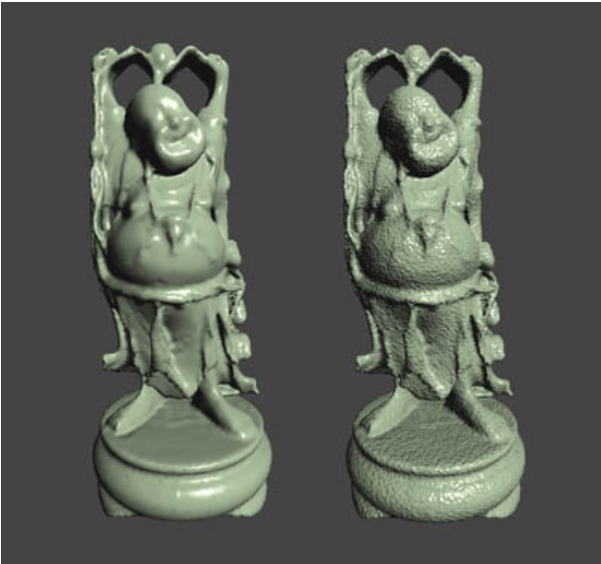

In [8]:
base64_data = "iVBORw0KGgoAAAANSUhEUgAAAlkAAAI0CAIAAACh8KuUAAAAAXNSR0IArs4c6QAAAARnQU1BAACxjwv8YQUAAAAJcEhZcwAADsMAAA7DAcdvqGQAAP+lSURBVHhe7P0HcBxnlu8LbsSLeHemWyThPQnQewcSHuV9wRuCoAEIAiQAkiC8994UfMFUoVAGZeAK3nuAnpRXq6VW+x7XPXPN3Pvei327Gy9iY/f/ZUKQuue2pNvSnXgdzL9SxaxEVeZXmeec3zlfZn75//j/MWLEiBEjRm+3GBYyYsSIEaO3XYSFQkaMGDFixOgtFsNCRowYMWL0tothISNGjBgxetvFsJARI0aMGL3tYljIiBEjRozedjEsZMSIESNGb7sYFjJixIgRo7ddDAsZMWLEiNHbLoaFjBgxYsTobRfDQkaMGDFi9LaLYSEjRowYMXrbxbCQESNGjBi97WJYyIgRI0aM3nYxLGTEiBEjRm+7GBYyYsSIEaO3XQwLGTFixIjR2y6GhYwYMWLE6G0Xw0JGjBgxYvS2i2EhI0aMGDF628WwkBEjRowYve1iWMiIESNGjN52MSxkxIgRI0ZvuxgWMmLEiBGjt10MCxkxYsSI0dsuhoWMGDFixOhtF8NCRowYMWL0tothISNGjBgxetvFsJARI0aMGL3tYljIiBEjRozedjEsZMSIESNGb7sYFjJixIgRo7ddDAsZMWLEiNHbLoaFjBgxYsTobRfDQkaMGDFi9LaLYSEjRowYMXrbxbDwf0gCaoJE1CQUkHcikUj85ZLd5X9G9NcF5Gtk2l369W+JsDZq2vssNf3RG/ztG7f0J3/5o8/SW96bp/9ENkd9QPDHG6IW8IVCTF8t2V0RhHfka/QCeg1f/fHLzzNi9EeCSVFmRtyGXkJpz35EXzNRegltR199YHfhn9HX/vZ189ub/2oN1IZ2G/Ol/uTtn2jvu2gk/clv+DCjvzIxLPx2icQCsViIic/nURPeSkUiqYAv5nHh0DKZNEwskmMGk1AgEQrEtJvBVUQiTPguvsIXC7hiPk/E5wm5XAEmHhgDiOLzEoFAwueLMUmEcqlQLhHIRDyxkCsUcPhCLl/II9/ChK9LBDypEJNAKhJiwvfhjwAWny8ia8CqhFJM1JrFIpEEE1orxoqF+ADWxOfx0DT4sxhrxWok4hCpJESMnyPAX+kfiE9g4vL5bA7Hn88PEok4QiEHrcEkIb+FbBLtFwtFUgnaIhHw8StIi8jPoSIFtR4uOEr2HhpFgg+jvxpRR5CIMmPCrT9G1+6SPyf6M/R38QqJKeEtl8uFmWFGIoFxwiYhfB4mKscEW4JZ8riwZzHmYVHwMti+gA8zg3NhIrYPe8MHBHxY2letgjVjC9RaKZcQ8MQigZjOKwWwdT78QSyS0a5KOS+8EG1BY8gX8S1YLJfHEsFVYeHUPqB2A/7HG7QHFi4j7RTJeDx8kws3oX8f9SvIx6hW7U67zWL0VyKGhd8qOARiOo92FTgArJ5mIf7lgg584CRUJISDER+DA1NYwoeJO9EQhcuLRDyZGIgj3BByOfBCIWEqHBf8IPTi8SVcOC9PIuHLpAKZhC8RcUVCDl/A4Qo4HHwFEYICIV8qIEQk/CE+J4Djg7nwVQBVgAYgoIjlAiG8GWEA26a8XCji4WcAhMRnqRAlRIiBxxL3RgMoftNhBX/ER2gccrjcQIGQJZZgD3AEAraADxaSX0R2Cw+hCKSlYxOZsB78HGrnYA8gyHCwxzBLgZhaN6O/ZhHKASdfil5IUPA10Qv3hCWwOBp++C5ev85C6i1MEsAiiMIEW6JSPgIeegnMHBmnUBAiEsLLiKPRRNy1/T0Wki3xYJVoFpZSLCTrJSzEn7BF8lcsR9K2+3UKXaTJaBeVsxLLh6fDV6iZ3R4R8iVshbAQDUa+CzeXIhOkYgJ8gTQA60GKSTGb9ksJ9RPoljH66xDDwm8RXIHLJTEdBk9cilROYCEYRnyJw+Yjh6UcjK7TUF2J4BVcLvyfOBLNQuJUAl4o6i8KHQAbKfWEIomEkAP/CkRSnlDC5Yt4bIGQg1VLpAJAEaWhgM/m8ikWUkUhqb9InoytcrnYEuIBYZ1IQqpX8A9klciFUhn8Ht5P4oGQjwqUw+OyuRwOWE4lryQwAPFU9oqVUa3FDyXtQYTabTAmwnS6NQgwpM5DKkBFQ3wGW6ZiBIkGVAaAwhXfwDokMirMYWdxMGE9X4ZNRn9NItyjhHkYB7EP6ujSolmIhXCHP9HXv4sPkJyIA0sgFoY/ff0zmAEaKWbt5mQUSAgIJWK5VBKKIgxvYXQScZhEHI5XsQhQpJJO0gOxl8CRpsA8+VxASQBPJRP8ARuhy0Liu+RPFK4I1agvogli6rdgnoAQv0kqxTqJqeOV8gIsJ0ZObWuv5iNtl0gE+DBVhpIfRVhI6lQSCigWku0y+isSw8JvFzwEFo8JjkFgSGW1EEDBReFE8lxCPjrHpDJEHp38UuEDDkfcDF+VS0iiCy9EgUYwQv2NLsHIBmQykVRK8MHmCrgAFkhETfijkKq24LHwUi6bpM27ybMQ7JLJZBKpFK7N5nGDORwWVsDnBbIDg7lBbAGbI+Sw+KwgbhAmzHAEbBYvOIDl7x/kh02TTiNCPJK5U/Am4QGve4GA/CqyEOAn/UeY0BC5PDQkJAxbJlxGABHjNwk5HG5wcDCLxSbRjYp6ZDVg8W5AYfRXIxw2ml6Yhz0Qg6UEG8BbHG+80jN787Tor+++oQTSYAmxLdo9vjYPYZ5aLfEGrBsbpM8e4C3MTCqVi8UyEAhckYhDMX0JQtJLKRZJifUSES9DQ0hmiaQQxSJJ9wQ8ZHikycR+8SepVIYVSkm2R04ZYBt0M/ATKLKj8cQX8Uo7LPV3NJAIc5TQYKyTLEFqKCLlI9qK94gCSJdh52gM6SaBayJZ3XUCRn8lYlj4LSLWDQdCnireZQZeKN+jKjGSfyIRJR2Qu/wAvihHojBAewPxO0x0HktySLAQaa0UNaOQJ+RxBBz8jS9FXkq8EfktJmCP9EJie1ziVWKSwCKfhStyqAQVkxBtksmkMrlMJBFx+dwgDoDHQrUI5ErCRKExsuj4iGu3omNuRkbFR0TfiIi9GYUp/FqoOEzAFbG4fDZpM+lAJdvFljBRLo1fTTcbS/EbyHaAYx4fFSQVPQh/QxCtELNAfOpnUmugM3OUnaQg3s246VXhf0Z/LcIxBgthCTiCYAiWgFhsNslyaPMgBv0lz74uLPz6cnyShuXue0r0Z/Anejk+TiENeR3e0uezyTqov5PlWAhPQiFIakHqZCGKSBgk7IuyLWJ7pB+eVG5irBdNpCfAnMXh0o3GNoBXkn5S/TSYaD/80lYJ19EkCs0crBUT2kagt3tekPgyzUjqVAMHuZ8AySefxeOzsSl8lvoW2QAchJzypHpkGf0ViWHhtwjWTSeSmIdnwHlg90h2ESKkMoFEyhdL+CIJTyjmCkVckZiLtxKJAGUegSWVKFMRgIjiBQEhHA7OLZVLxFKAi8sWsnhSHlvMDhYECcQcoYi4GdZGpZxsFiuIw4G/kfoLayMzX54GRKiSyCRiGRJULqq9YF4QX8YPjQmJS7yW9OD2w9x7OaUZhVU5mAoqswqrsouqc/H6uDA9+dHt2NsRAhGbywvGtkRikueiZVRVycVWsGL8cMJ5sjW5RBaGSSCScrgCfIeLH0JFFuwLMBgRAW2WSAUyOSluJVI0jE4gSI8r1kN+O6O/KtH2JqeEGVg+WEgDEkcTrxQniCUTenxN9BL8if4koQPtBl93BIqRtPBXYsaU8PbrH/uagEPSD8LjkmvIYJ7wR+rDaAmMEd6EyhH5I4/N52IiHSbk/CM55455mDB18h3U4vAEbL6ADZsnMCNXh5EJ66FaIkbDWSw21eTdrJWCJQ+bkkgxCeDdxDHJ17GeYC4viDJ+BAQYPFkH2o/skOovZWz+r0wMC7+LEM1RFBKnhF8TyKGAE3J4fDhDIJcXwOMHiMRwCZZASKFFxP3yXAKckmS7+C7xDepUP2YQMDArkYuF5DIYLk/KlUSK+aHcYJF/MNcnmO3D5vjRdBFLBMjIwUJ4KQII1oaUGiuhV0XSVNIbBP9nccVcaYTkRnL8o4IH5U0lClVdn7FNZ+0zz2osc1pMIwv6sUXD6KJBP9HfM9RapSiKuxEukrA53AD8CgQICm27JZ1UKkOMIhcBoYliuUgaIpSEoNFBHHYAKyiYG8wVcgUSvoC6fojN9ePw/BEaJFIecIjgKUXuvtufjGhCdiC9Hxn9tYiyASlAKJOhAiM95PSBBLH2Uhy8pUD1FRpp0R+m//T1JfQMDT+sBKul14BXAh9qi7ToP9HfolaDefCY9KASNsH/CLqwXdIxD36RNFTK54jZPBlcSRKbEJuYlpiaef9+5v3kR8l30u/cSL4RfStaHi0TSZHLBbDYfnBefIv6ZaQ6xDaoQpNGINa82yi4MIwZ3kA5I1JGNl8YxBeQC8r4AoAQM2ypTBgSin0lRZPoxAArpfcPo78iMSz8DqK7JKkeFsrCAaZgIITD9efx/XkCf77QXygOwCuH50vAwAUdSbZIdarA28nFKvBkKqUl5Rzp/RSi/uIEcgPYomBptDjxwa2UzDt3HtyMuiYVy1hcstogoZgjlvJ5fHgvuIuElLSB6nuh2kOulKFYKOLyJbyQGPnNlPjsssf1nTW9Q50Do51DM/1jK7qpTdP0lnlm2zL/dHTphXX55cTczsjYin5gpLO4/HHCnRhZCBck4/KDSEChz09SxfBuVw9qQYEomMfDxJMIZRHy2JsxSakJD3NSswofPM5PT89MTrwbGxMrk8qRdAcixCBLoKtMFBKYeEijCcUZ/TUJsKF481VAJzbxJcNAjr3iD6JwRUz932rvAwSJ1Bn0vTVjOb2Q7oekgASEYNP0ZgEkrJ8kZ9RbcsUKlQjS4MQifI3F5pA0TioTRMaE3LwXl5yZ8KgotaQhv6G7plOj6NK2dmhaFP0NdZ1V5c1FeRWPUx8mxMbJhaIgNscXVR3d+0LhEFtBrUk6YOGZFHG/bKmY1IJ8AYuYt4C4uVAcKJVxkP4Cq1xuAHBI9wYJ0CQqc6WazeivTAwLv1WowCRCAXJGhAIJCjOAMJhFKiGRJDg0nBseyQ+L4MlCgsXSQKEYUPFFVcdi+3O4SBs58A+qFhTxuCIuB2tDOJGDYRw+AeHVoCtcGft6cmx1a2mntqVD05RX8uD23Sh5OJcvDhSIWeQkHQpQci0NYgAgKuaQs4fk7gWhWAJvJViU8WVRshvJcRlF6fWdVf3mbuOMRjvZZZhVDi+rx9e11g3d5JZh5olp4cXI8uvxxZejc0/N1lWdzthVWZ2TcCdKJAni8gPg7SQ0CEmAQ9TikitVhcBjIJftE+QfyA0KjQ5JeZhU0VCsHGw1TWhGZ3XmKbXG1KHoqMzNvx9/MxRhIpjlQyXdLOriQbCQS/pcycXoX0VVRn8VogEG5sEegB9QkC4H8ZbNZlPXSbFwiPEZfJLiEzlDDFEA2T3cFE52yQfRS/BKrxkz1DqxArxjc7jUhV/Uqfe9CTzFN74s2rAmAkIsQcoFT8QkkfKjokOSUm5WKgoUA9XKoWb9ZM/Ysn52e2Th6fj80zHMTKwbR5a0holeZX9jfmH6tesyLt+PReGQOvNHfgKaJhLJREIZuS6Nj0aSZhN3IKcF4MugYIBYGiQPZYdH8WPjQsIjxSIJkj0/Nsef7lnhC7A3yERx/b+fHDD6v60YFn6LqGSP3OZOrqUWCLk8WD/pIYm5FpL64FZBUXpRSXpuQUraw/jUB5hu3CFFklws4XK4gWxOMHJX6iJsCY8rZrMFfIFELJHDvzkAjYTDD+HdSIkraywcWzKtvJhZfDqhG+6ubsq/9+hm7M3QiGuy0GiZUAqiIkhweUIxTwgcSkVirD8E60EgEcpEknBJ9K2o+1nJpQ0FbeqGfnPnoFU5MNWmne0wLCrNq33D66rRzYHx7cHJp/qZ58bZl6aZF8bZZ6blzVG9sauiOvt2YqQ8BBsIRGShnJlPLufjINgIWQJOED+YI2ZH3YjMKnrUqW62Lgxtvpx98+n6Bz/bePPT5SfvTs8vmwa0ivKqrMSkmNBwIV9AOoqRNJAgSO5cJJeY7+5NRn8loon1dYDRPCMJzpf8wytEf+a/K3xGRglfxzy9BAL3sBLA9ebNmw8ePHj4KC3pbkJMbKREii2CiMHkghQBfX0K8kfqFlXSANIk4ImgkSRX5Aw9QBh7LSzl3u3C0sxeU6NuqsMw22WaV1oW+0ZWVNZ1zcSmFtMkpi3d9JZhaX1Ya2gvKc+4fiNULEFZ6U/1ZPDw68iNFuSODpSG9G2OIlL68jnYSkioMPZaCMw77eHNzJyk/KLU4tLMrJzUuyk3IqNlYgmHOtEQBBwKqXsTsW/o05BkVzL6KxHDwm/RH7GQDxsn/hkdI8/MvtfaUaUb6tQa2vrU9cq+mv6BRvWgor2rprAo49btWDHwRzpMyO1ThIU8CZcr5gkk4FkwUCMTRcZHpmTcrW2vGp4zvPx0+9kna3M7o4OWjsaOkoKKh7klD/JKMrILMxKSb4VEhnIECA9CNl/MJSwMEUlCBGIZ6d8R88Vhorik2IyiB7UdFZ265h5ja99wq2amTb/YaVxRWtb7RrfU4zuD1ifaiafayWe6qef66ReGuefGtZ2xqVmdStOMTPn6jTC+IAi1LLJykoNT1+zxeCgKA/lybuztqILK7F5t28Ti0OyaaWpVZ11ST6yoJlf6J5Z6zWPdg/rWTmV1Sdnju8nXETgQXxALyLWvZCQRKXYgkyX/delPWEgqJAp+eBsaGnrjxo179+6lpKTcuXMHPIuOjg4JCcFn8IE9WNJf/Ld9qqQAZJNrwbCSsrKygQH1kFHX1d1WVJyXkHgjLFxGI3Bvoustus4ET6l+VHIeXSzmSWXCyCj53eSb+QWZzW1VGqtiaKF9aKHDMN9umG/DzPBqz/hm/+T2wPRT7fzLoZXXw9vPJ+cWjRpdW1HJoxu3IgTCYOSscGoKtCRvEwpkYlEIHJbDJuUvthUVHXbvfkJxSaairVI92DJk7rKM9g2PagZ13Yq22rz8R7cTr8lDEBmAcNKzQl3NSnDIsPCvS287C+FiX3XefWW69GIyCWDdXPpySolULgsNl8fERaRnJLW0VY5NDq5sjs2vGCdnNStbw09fzb54d2ll06rWdhQUP465Fi4Q8VhsNo+c5wALxVy+iCMgo5mBrZFxkenZqU3K+onVkfd+/vyL33/49JNl01x/a19lZWNOaW1mY0dFt7qlZ6C9vKYkOe1uSGS4UCYlF6oKkBXLBSIZVhXIZgfzWIIQQXxKXE7F48be6i59c5ehsdvYMDjTPrTUbVnrHdtSTzzRTj83YJp6ppsEDp/qMDP9RD+/bpxfNo5NDrS0laek3hCIg1mcAPzi0NAwuSxcLArl88VBgoCom6G5ZRkas3JmdXhxa0w/1tnUXVhYnVxQnVTakFLVkl5dn9HcVtjVW93RXV1SnnknOU4q5/ME9DlOCXYd1a/71S4le5V0HZMJ8yQlp3c6maHnqRn8lToiZBFVT9BfYPRDiOz2r+3wPxX1JyHQA2hR+57P43MFQn5oWMj91JSyipLW9pbW9ubG5vrK6vLs3My7KUkx16KlMgmXx2WxABgOvkOvZI9/5BIwHrnrBsc/IioiOzdbN6R7+ebFp59/vL651Kfqysl/nHj3JvwrMiY0NEIqkYMnLA4/iENKrt1mYBKijBPzxFJ+eITs5u24rJwHdQ0VPQOtA9Zm7WyLfr4Vr5gMC22jG71TTzVzLw3zrwwr71s2Phxffza2tjM+v2Lp1yiy81LDI2GcgRwuSygADGVioVwsDBEKQzhcUTCLy+FxI6JC76ffqW0o1ug7ZuaNGzsTz17NvXyz+Ozl0vr2zNScuU/dWlyaBRxK5WgZmydgi8Rk3MFd26X+JWb7dcv9mhlTtx9/aerURB2W3YNCewk9z+h/tt5qFsLipEIRGfcF8+QGAiqZIzmxVCKRialBYeAj/lxWkIAjiZDdfXg3rzKnrqOq19CqHe3WW5WDo629xro+c93ME/3WR1PPPl1YemkdXdJ361of5KVJI2VXAv1YAiFbQM7IXQnyCRQGya/J7mXdLajJbuqpMkz1b38w/7Pfv/n0755tfzQ1vNir6K3OLk5NSI1NybiVX57R0F7Z3tfY1FVTXl+UWfjgemK0QM7li6VcAYpLvk+QfwAvSBQhSspIKKjNauitaB2s6TLU91qaBsba9NPd5oX+kWXN5IZh9ol5Zsc0vW3C6+LzUcyMr2onVvQTy3rLtLpTVX//UQJbEHg14CrK2NCwKKEglMOScrji8BvywrpMvbV/emPUPKNtVzXklD5ITL0Wc1N67XbIjTsRiSlRd9Pk9x6GZubHK5Qlg6a2QVNXYUVW9I0IX46/DzsgkM/hknNIYWJhGDWSFpJuUinSQ/aIqNECsM/BTYk0RETurcan5SKhBDjlI33giyQoplk8Hn4wm7lp6wcQ9rBYJJNKvhqHluYW7J6chwP2yLk8/CvBUeBwucGc4GBuIF/MCo0WJaXHd2maTJPqkblBw0T36IJmZsM8uqDTWLqbuqoy8lIj40KDuP5BnAAOn00uGqMGOyI8FICEQWxBcMT1sPtZyeXNJcqhzoWnM5/89v1f/eHzhe2p+o6KrNL0oprshs7K5p7a/KrH8clRLKmfv8A7SOjL4ZHSTSaXS2VSvpDP4rGQXsbdin2cl1HdXN3Y2ajobeoxNg9a241zvcOL6rEVzeSmYfW19fmnS2++WF97M7Hy2opp5pl5asc0sWEyz2oauyrvP0qUytFKLkpQCUciYUuFbBlLGOovkASI+NJY+f2cpPqu4sFRhd7aphlu7tHV9urqVYam/qF63UircaJbN9zRpa4vr8u7mRSL7DGI/EbkvWKhREZODZDREsU8DrlYjh7ljSQX+Du5Qg2/gy8Thkh5chFHIuSKkSTweSKpVC6RSskYGPTNx6QjirH5fw+97SyUCEQSpHGwVHLViIDckUuuAJAChDBdHumm4fvzgwURkvh7N4vqCht76rv1bVprr86qVA23tmsrG/sKmgeKRjb6Ft+1rH84sfh6fO7Z2OiSUaFqup9zXxwpZUsEQQJuEJ/NlgVH3Q7LKErr0iqGptTjy4b5ndFnnyx/9Kud5z9ZnH9iMkx1dagb8sof3UqJibsTkZAa9yA3uagqq7KpqK61rL69oqQ2Ny3rbnh0hEAq5gh5wWhYKD/qdkRafnJxY05Db3mrprrTUNdjbhoYbddPKk1zqtGlwelN0+Kzsbmd4ZktM6alZ2Oz25aJNf3kmm5yTT+2OKg2t+eVPwyLlQbzAtlkFDgxlysWi8Jjr93MrXjca2qb3hiZWLGg2dllD68lhovDOCyBL1cUIJSypKHsiNigyLjAG3eEVU2Zlsn+tafT5onBquayhLSEkLgwToggCJWwJFQgCOFwsGYRuTyVT8apoe5G4yHlR7lA9SaTI0BGaQULydDnIqQmYKEUsZsnIqeHmG6nH0CoQshQn1JJKCayn8n9OTB2IXXVC1hIejqRmpALvsjVIFxpiDj2ZmRy+u3s4vTa9pLhOQ1sRj/R1TVUrZtqn90xrr6aWH4+MbFi6lA1Psy5J48Uc0VsjgCZC5ccQiqpgU1JQ4XR8eEP8u7Xd1XpJ9VzTydefrHz2e8//OzvPxhfMhY35NzNvPmwKKVSUdilbW7pry2qz76VFhN5WxpyDekqKQr5oINYwBVyWfxgjogVezsmuySzqbuxSdlY31XTMVjXb1HoJrqHFwamNoyw+fU30/Cvlz9dW3s9tfR8fOHZ6PRz88QT4/jmkHXd1DvUnl+ehRqU/GQWl1y1zZaK2DI/nihYLgu7FZNZkakYqNNaO/tMdQ3KvILqexmFCek5t1KzbqRmX8sqSSype1jdkqfoqWrvbyivL7z/ODnyegRPKgjmc4Nh2VzATyYRykUCKRkkHLaNLAMpAYctFvElYjL0uBws5Idg34iBRR7BIYIPYhB1zxQqcdSmpMLePXSM/mfq7e4jRdSngix9bkKMEgQMpG4MFIiEXD6PzeOwUNbI+deSrmeX5zT3NraqmxSq+m5DC5LQLn1ds6qktjunvjdPP98xvq2ZfjY092Jk6dXk8stp66pFoWq4n50sjhSxJcg1+TdSYpDt9hjaVp7PPPt4/fnHaxuv5zdez669nJ5eNxkme5T6ptbeuvzyx7dSYsOuicXhqMs4EddlianxOSWPWnvq1UPdPYPt9x4mRcdHhEXLwuPk8Xdj7mUn5lQ+KG/Ja+gpU2iq23W1XUMNuyyc7R9f0S08Hd14d2bl5QQQOLkxhLfzT0ZmtkxTG7qZTf3Uut441dvQWXr/cQKiGCoAvwCk4fy4uJv5hYVqc491xTy1Pjpg6Smpy0OqzpUFXg26cOHKqcs+Z674nPMNuMAVefMll+URgdlFyVpL15PXy8/e25hdt/YaunMrsyNvRwQIAlHscXiCgCBWMJstRCQOlUtDJKgGuXwWhx/M5gUGcwICWUEsLpfch0l1TSNqkwhCMhVRiFiOSUYu89vtPmL0lwrUIw8nwYTjQLLB3boQUZi+PhOHgBRhsH8WhwX2JNy9WVKdr1DWqYydpumBydWhoane9sGqUsXDJnXx0Gw3WPj8k1XY88SSuamzOuVhYli0nC/hcgQsMqguuVeHHRohupMSX1CeqeitM0yoF59Ovvps+6Pfvvzod6+efbSuG+8vqHl8415UXHJEcuatipbCVlVd+0BDWVNeTsWDtJykuBtRyE6D2f4sbgBHEMQVs9jioJjbEZklD5t7GxqVtdVtpQp1dbehQT3SZpzpQ84H/sHm8UobP8x+Zts8+8IysWMYXddNbVm04/3VirIbidfEEgEnmC3kCGU8qZQv9eNzZdcjHhZnDIz1T66bx5e1NR2597KvRd7kh17jicKC2SKfIOFFjvSKNJJ1LTG0oPJxr65dN6zq6G/JL8+JvhHJFrF8Aq/ClsVCmVwaKpeFIKagJORyWBx2EIcTTJ73QsbgF0mFMgl4Se5GDsEREJBRnMjJRux88lAZAdaBFJFh4b+H3nYWklIDiRebyjiFpCQED5GUwQqp+/b40nDp9eT4rLLs+u76lv7G4oa89IK72ZXpZS05DT0lioHyDl2V0lSrmW7TznYa5pWj69rpHfPi8/GVl1OmGXVdR8mt1OgbKZEPcpOalBXase6pNfPO+0vb7y0tPZ0amTcYrGq1ubtD01zbUZ5flZn8KCEyXs4W+1/0O33s3KFDJ1yOnDl4OeCcLEqQXfyoe6DNMqnvVjfUKgpLah6X1WdVtxY0dJfWdhXXdhXVdhc39JU19JY19Vf2mVsGxzuNM/1IkLc/mH//FzsvPl1FRJhcH0KYABSnt4zWNdXEunpiXTM839831FTRmHPjbhRb6O/tdyE0Qpabn63S9E2tjlmXLZrhnpL6vJspsWyJ//mrJ4+f8Txy3OPI8YNHjh08dvzQ+UvHfPzP8kR+CSmxFXX5g0bl7OrY5qulzTdLxqnB/Jqs0OsSZN1kENRgP5QiCck3s/Izcgoz0jLu3rwTE3lNKo/ki0M4AimPXMon4gWxAoNYQWwOGzGaxyUDtMrFMrBQKkQmzbDwewk7UCKWfx2E1BlBcmMfuWOIDCJBsVAsZHODg9mBUdciy2qKDCMD+lGVfqxPZ+3RWpW6CeXAaFttT75isFw/1bX8YvzJR0tPP15bfjZtntIqlPXpWfdCoqR+rCuBrCsCUWD0NWlm7r0edcvc6ujStnV2Y3hq3bTyYnLh6Zh1dcg4pekb6mxS1hRUZydnJsTeibiWFHE7LS41Jymn/BGW9w91NbVWP3ycEhYpDmB7+3MucyT+ITH8Ow+vF9RkNvVW1XSUIBfs0NaiLtSMdaA0hJ2jKAQFN9+b3Xx3BvMoE6e3TZNPhiyrav1c79iqfmh6oF3VlJaZHBElB5/YwSwhVxAilYdeD0srSGtRN44uD40saHuHmrPL7924FxESy5dF8kUhPLYw6KLfmWPnPQ+fOegdeOH2vetNnTVDY5qJBcvozFCLsu7ug5tcclaEXIdKnW+l6EaujAXYyNVAHG4Ai+UbzPLjAXb4DI8MskhOExLq4dP4HjmrSsZsJGM6Mvr30Nt+7YxYIBbyROShTNQZE8QJKhcjF2zKI2Wxt6KT0hJzyrNa+pt0Vo12XNXUW11Yl1nTWdymqek1NfcPt2jGW3VTHbq5bs10p2aqw7ysHl0btK7r5p5YxpY1/eam4oaHlYqsLk21cVI5vjg4tTo0tWoanhkcMHe39NRVNpXklWen59y/de9GSKzMn3v1/NVTR894uh12snfbf8DpR7Yu77h6OZy5fCIiLqS4Km9gSGm0dmktzb26ml5DXZ+xsWeosUVVUdtVWNGaW9meX9leUN1ZQseFoelepMMA4a//0yef/cObJx8tAo0IE9SkH1nuGV3tBRHHllWmGaVSV/8w/07oNQFfFpiWkdSubLLODI8tmPuM3aUNBShA2ZKAs94nvI67ux9ycnV3cHV3dHXD5OR52OP0uRN+gVfkEaJbd69l5qc1dlRapgfXX80uP58aGO0qqM2IvR0uixSGRovvpt+sqC/s13XoLL292tamzvKyuqz88vTMwnsPsu8np9+Jux0jlPJY3EAEYmqccx6Xw5UIJdTzH5kU+fuKYqGMPFpkF4QkUqMUIZdwUDeVk2AtZKNYF0i4UddCswszulQKk3VQ0Vvb2l+rNDT3mRSGqd7hJU3/aMuAtc2ypF59Pbn5/tzGu3MrL6YXdybHF0zN3XWpmXfDYsRh0cKbdyKzClLalNXzayMff/H89Sfrc5sWg1VpmRvQT/T0Glta+xrq26tK6wse5N2Lvh3GEvtfCb7gHXQ+gH814oa8uCZv0NKnM/c1t1c+zk25eTfy9r3olIwbD/Lu5FSklTUjJS2t7igob81pH6xRWRRaaxdwOLwwMLczvPzCCgpiwgxYOP90ZAosXFbpZ5QjS4OWee2ARVleX5iYEi+ScgODQCZOZFTYvew7tV1lusm+iVXj4Fh3dWvhnQdxIbFC4I0jZHGFZJi3y35Xjp094XXS65LfxZhb0cXVBe19TeYJ7fz6+NicvqWnMi0rMSI6lC/kB7EDA4L82LwgaYgw7mb07aTrt+/ERURLJXIuXxTME3I4PDaLG8yhnkdDjaoBWOIo0E86I1xkTgz8++gtP18okohIb76A3FpLeohQEbI4gWx+kDhUcPNuXEZ+enlDcXNfvXFau/ICrj47tjyktfZYVw1TG6bJdYNlod8012ua7zMtq7Sz3eqJ9qGFvqH5HsNsl2Whd3ix1zTb2WeuNUy2Tq6oxxfUwzP9hrGuroH6uraSwsrM9Gz49vXQmFCehOftf/Xo6eOO7na2zvtsHN/ZZ/+3++yoyf5HmBzcbC75nrueEFPVUKwfbTFNKgzjzQarQjfeqh5uUagrqzvyixszixqzSppyKloLG/vKuvT1+knl2qvJL37//r/+X3//j//7F+9+sYWKcHxFh2lsZdCy1D280j2+1jexMTC1obXM9VU0Z6U8vp6YFtPcVTUypZtfsw6YUREWxCdfC+D5nLxw1OOwi5Obnb2jjZ39AXsHG3sHWwcHe0cnZ0+vw2fPn/MN9GXxAyVhvFspMVWKAsusGmFo9fXE8IKqsPpxem7So4KU6pbCweGuxe2x7ddz6y+n5rcs44sa01SPbrRTbexW9NQXVubcTLomDuEHc/zJg4zJrVp8ZCo8RAsWlzl38r0FMydPeNirCCkQgoLUyXFyYyhHKEZJHhAZJ3+cn9o9oEBFqDZ2ZhTfQ06jGKhRDjUZ51RT2+axdd3ounZie2j9vZnVN9Pz5Jz02Nrruc03i8MzusbOqsyi1Ozi+xUNuR2qWv2Icuvl7Ge/efP6J+tj85r2/qquwbrW/qra9qLCqpyHufdvp1yXRgquBl86euYQkj9b1312bvtPXz5+4+41hbJheHJQZ+lu66muby9W9FR2aeoV/VV1XUWV7bl1yoKqztyK9uxmVTnSU521GzhEFji6NAhrX3k5geoQGeHS8/Hll9bpJ8aR1QHTXB9YOLakt8xqe7RtOSWPIq7Jgji+SMJu371e1ZqvGlYMz6tNMypFf/XDguSQGFEg1/eyzyXvq1d8/AL8AljevoFnL3mfunDBNzgg/FpE6uN7WImip9YyNTC3YZ5Y0vYZmlMfp4RGy4N5gT5BV3gS1rXbUbklj6saS6qbSh7nI+27EX8nKjxWLg4V8iQc6gwrOV/A4QVT9zWRblMcGi51Re7uoWP0P1NvNwtFYvKMNJGcT24Gl+A9X8gL5gYKpJzom+GPix7Uk0tGO1WWzpmt0fd+/uyL33/8s3/64LN/ePfX/+knH//mBXxsZEkD3mgnugwLvagL+8YUmqnOwakOjVWhHm3WWlGZtRum2vRWxeBwU6e6SqEsq2stzC1JTXl449rtcHEYzzf46qkLp46cOOp6yMPOydHW4YCtw347xwM29vsw4+Bs6+hiZ+dwwM5h/+Fjh5Bd3kmJL61LberO6lAXKnUVSn11l65GoUZdWFTWklPclFWmyEddWNeNyrV6cLxz7fXUL//w0f/x//3Dv/yfv/7gl08QHcaWtQgTo8uakdW+sfW+iU319I5u/plpelPfMVhd217Q3F02vWxa3Bwbm9U3dFQnP0zkSlnHzx51O+SM9tja7ztg886BA+/Y2hywt7NzdAAK3TG5uHkcOX7ssu9lgYwTcys0PS+xtqPQONu78d7Ey8+WkGLrJ/oGRjq0493D8+TShrkdy8JTejLP7QzNbg0tP5ucXh/Rj6tqW8sT78VzRUEcfhBwKCZZCnkgHBcZMxMWvrdEqAEFQqr7DjUHqQjJmHkCNjVEJ1sm50dESeMTIzLykuvaSg2jfcYJVY++5XHZvar2woHxTtVou36mz7KsNS9rjEsDllXt8pvJpVeT09uW4QXN2LJhat0yPKfVDHf3GBT68V7jZL92tLu1r0o11Do6Ozg6p+1S1xdVZRRWPgQp0zITYm9GckTBZy6dcjnkaOO0/4DDO45udrZO+/c7/NjlkBNbEJSRm6Y2tKuH2sDUHl2jwdozOj+osrQCfqBgfW9ReXtmQWN6dWc+SkMUhUj1pjdNM9uwq+HN92affbIMIq6+msQ0sWkYWx3EZF3VT64bJ9dMI/P6JmX1vczEsDjpnfSb1c1FhsmOwbGWVnV5pSLvYf7dyBvyS77nj5w47HHooKfXEXd3TycnD1ePYx6HT3gdP3X87FlfVoAceywpNi07qag6o6WnzDLdCyK29TdllWQgjwy/Lr95Ly6vIlM11D06b5xYtujGetWmjm5tc0VzUW5F5sP8VHhZfGJsWLSMGp2fK5EKZTKxUMDjcFgMC/999LazUCYNFwlD6GfiCkRCnojHFgbLo8V3HtysbCnuHWo3Tg8MTfcvPB1/94udn//+w1/880c/+6f3P//Hd59+vDyxZgAIdRPd+inl4ExX37ii29LQO9qitrZprO39lmb1SIt2vE0z2trSV1JYlfogJ+F+xs07qXHh18Q8CbLFS2cunjh01MPRzcHB1REgtHGwt7O3dXC0c3Syt7UjVRdmnF2AGzs7exsnZ8dTp09weIE37kozCuLLG9KbugtaVeXtmuqOwdqmvvKq9vzipsxSRW5VR1FNV2GLqkI93IaM+NPfvfqX/+evf/dffvrqs3VACCAcWdSMLg+OrKnHNjQTW2RIjpkd49SmYWCkbWC4bXhW/fT9pcWtsX59a3ZRRlhMyEWf8+6eLg7OoLKNrd0BW1sb/GdvY+dk5+ji6OrqesjewWU/2uvsfOLMiSCuf2is6Nb96IySZLQB0H3y0dzzT9e2Plggo6E+GZkhZytNkxuG6S3D7JOhuafGqS3t+Koadfb0hnly1TQ4rMwuTheHcVn8AK6ARR7JQeoY8hw7prvoBxHBIDUEKBnSRQIWcqlbxYMAwpjY0OR7N0prMxs6SzoG6kxT/SPzg8YZVYeuQTfVO7ll1kx0q8c7NVM92rm+wZke7Wzv+JZxbMNgWlCrR9u11m7TnNoyNzA0RU4ujszrhqbU3brm7NK0zKL7RVWPKxoKHuWmxN0KC4sWSkLYbIHfBe+zXsc94QX77d95x/bHeLV3sbNx3P+O7Y8OOOw/c/F09PWIhvby1r6ahq6yJmVFj6F5cKy7x9hMsTCvurugoOnB46q7Fa05jb2lyqFGWBfy1CcfLWJ6/xc7n/7dq+0P5hefjU1tDFkWVcNL6vFVLVg4sTY0BRyum3uNrUUN2al5SdVtJcZJ1fSmtt9cn1d573pymCiMfTXwktcxTxc3VyR9zs6uSP/277c9YOdq73LI2cPL5dCho6dPeAdc5ss5sbfDUrMSyuozB4fbF7dHhucMSn1HpaI0tzKjpCFPoaobXTAsPJlYfj45tW6a3rDMbFqGZgYGxnp6htoVffXFNbnJDxJk4SK+iAwvIBELyZVMfBTujNH/e4ipC8OFQjmHK+IJRDwRuReIJ2VH3Qp7WHBP0V+rs/aOLulADhQxOx/Ov/vF5qvP13c+XIBfDU33durq4ZC6CaV5Xj0w1a4caegw1nSZG1TjbdpJpWq4rc+k6DG0tKpqHxelhF0TcMWBbIF/ENf3vPfpo6c83b2cHd3s4e3w/wOo/JztHFwcHBwdnJycXVxc7O1RdNk7OOCtk6OjI97a2Nhg/uixw0G8S9E3RenZt0rrHjd0lbQP1HbrGxXq6urOwqLGx0VNmWWK3OqOgqa+sh5jE3Lk5z9Z+dk/vffRr5+tv5lGUUhASOpC7eia1ro1NLVjsm7orRsG65rBONtvXTGsvZx69enG+KK+qqngRmJcICfgyAkvRxd7Owdbewc7NIm00d7Z2c7Z1cHVzcnDzc3TzsH5x/sO/PjAfndP94tXz/HlrIgb0tsPYnOq0lsHqkeWBp99uvri842dT5Y33p9dejUx+2QYGfrEpn5yWz+xOWheVA5YW5TGOv1k18SqfnxJX6UoQnEpkHN4IjYZz5VcSIDanTxff/fgMfpLRc4Qkss6OCgOAUKJFCzkAIQCYXBklOxuyo2i0sdqo0Iz0tpvbjHP9QMhMPjFF9atDxc2P5wHC7tMzV3mFtVUd/8EUsAOzbRyYLKrd7S1w1DXa2nWTXab51SGKaV6pF093NWuaSppzItNipDFCOXRwqj4UKGU4+1z/vhJL08vNxjQAft9+2zfOWC/HwgkkzOZiF/Y/PjHB37k7unmz/J9mHuvuDa7uD6noOZxeUt+Y29lK/I/VUVVV2Fpe05mzf300oSylqyqtjyYPZLUpx8vweA//s3zX/3Hj3/3rz9FaTi5PoTMdWhGaVnoH1vWjK8AhzrrGqkOtRPdLQNVNd3Fusne1dfTM1v61v7SO+lR/rxLJ84f9vByp0DoZG/vAKeEW0L7bB332zvbOLrAJx09XA4dP3j2ymlhGCfpQXxhVUanum5kVrOwMzmzaR2eN6hHutXDnfrJvqkNy/yTsfknI6D10vOxjfdmll5Pzr+cmHk6Pr5i6hvqKK7OjboeyhOyWKwAAZ9L7n2RSPduvWf0P1Vv+bUzYpEojI+MjiMmTyAUkce+cKTB0Qlhj0tT2wZqB8e6TLPkjODYshpFzMLT4Yl1nW6yq22wuro9v1yR021oNEz1jixptHMd6qmWfmtz31jLgLVz0NrTa2xvVTVUKcoySx5H3Yy4EnjZ88ihg14HPY94unq4AC0OzrZOeHWxtXc6YOe4j5r2g35gIdJPEMeRJKIuTk4u9KuNjZ2NDapGR3DUj+UdHitLy0ourc9v7qlpU9c39FSUK3Lz6h7k1KTl1z1AjlynLG4dqBoc75zeNG2+N7vycgK5sGGqB3HKsjAAPlm3zPDDlffn5p5bZ5+Mze6Mzm6PLD2fXHs5O7893qaqu/Mwni1knTp3ytXdxd7RnmKgk4uTi5uzu7uTh4uDmysmR3ew29HZCR/Yb7ffxvGA6yHns94ng8V+YTekCQ+vPy5NK1cUtuoblMNtqolu46JmbHNo6snw9NPhmWfDM8/N1m2dYUHZZa4l1+j3F2mt7aOLmm5dU0HV47Ts5Gu3okUy8pgAHl9EBklnWPi9RVAIFpKRNsFCvkTK5wtIUSiRcm4lxOQVPFR0VGtHW43TXSML/fNPzYvPhhefjSCJ2f54cfndqZ7RtiZNVZO2ZnCuTzPX12vt6Bpu6TQ3Yeq2NGomOsgID0tqzXhrs6qsqDH3YUnarQfxoiiBH9/3ov+Fc95nj5066n7QnSR5DmSyc7CzdbBBpuXo4mDvZGdrDysnb23sD/ztj//mR/v+1snNIVDge+PetezyjNzKxyWN+fXdld1Dre26ptre8sKW7Iyq1Adld4ubHpc2Z1a25vSamoFDFIXA4Re/f/+zf3gztzMMEKpH2qY2DNObBuuqFo6MaXxNN7qs0c8o+8Zae0ZaLCuD008sSn1tYXXajeTwAO6VU+dPHDrs5e5xCNb/DvTjv3F2svH0dLV1crJxdLJzcXE+6AEW2rnaHXDaf8HnbOztiMzC9KKq7Lq2svFl49qb+e0Pl5dfTc3sjExsGGd3hmd2LFNbQxMb2ultw8xTk2V90LCo0s306af7+s2dDR1ViffjJSH8oGA/LisIqV+YVI4gtXvkGP3P1NvOQqEwlMcP4fAkPJGE3L0uCAoU+offlD0qSlaoq1TDrdqJTsN0h5FcC9MzuqzWT3V26KrLFVn5tQ+KGx8rh5q0VtJHOjCt0JCptX9c0WNRdGibajoqs8syb92/LY4M8Q708zx+zJbwxNnFjcADs3YONg5Otg5ONvZOyDJ/ZOf0I8zQVZejgzPCA2acnVwJgByBQ1d7O0dbW2SlDs5ursdPnwzkBMXfic8pza7rqG7sqanpLC1tzsmvf5hTk5pbm4qgUNWe19BT0qlDsaVEdTi8MKCb6EY4AA4B+OHFwfmXU08/237/t69ffvH02U+3n/1k89VnO08/Xl98Oq0yd2cU3xeEsc5eOnPQ86CDExANNEPOaAxFQXcnWxdnO1dne1dbtNXJztnNycHFzs7ZxsHV1vOExzmf04EiP2msKP5ebGpecmb1w/ym7PKu4jZD48BUj2VVP7ZpnNgxTz4xj23ph5b6esaaqroeN6sLB8cVCFXjy3rTlEZj6i0sz4u6FskXCcnoJQIySCaj7y3Aj75xggcQSqQ8voA8k08eyr+Xequ2vlij7zRMtJtmO8eW+5deWOafmqa2DIsvxya2jJqp7ure4qqeYoW+TjuvGpjt6x5tbR1q6DQ394619Y629Fgau011SlNtY39Bfn1qYtat8MRwXiQvQBR43v+i1+mjzgddYc6Oji6O9i6Odq6YnPHW2REe4exKZgga7SlfcXI4YHtg34F9Ng42Hsfdg8QBN+5dT8pIzCh5WK4oURo7eixdrbrm0vaitLKUOzk3ihozqjvy67qLYPZ95hZkfi9/uvbez7cBRdg8jB+F4LNPFjfeTE6T/vmhmW3j1LZxdG1weHXAQk0jG9qhxf6KlqykBzHicNaFq2eOnDjqcdDT2dndzs7R5sB+W9sfOzvvc3O3sXdxsHFytHFysHd1tnWx3++4f7/jvtOXT8miJDfuxt28G5f08HaLunZ4Wbf8enrx5cTElml4eXBsXWfd1E9s6cc3MT8wvKrSLnR3jjQ2Dla06mp7TK09+raC8sybCbEiEZfHDsaLnIxAw+jfQ285C2FmIXyBnCuQ8sVSjpAfyAv04VyRxQrT8u4095X3mBpVoy2IztqJVt1k29BMV7+lqbGvpKDuQV5NOurCPrNCPdzeZ1GorE0A4eB0R+9IS7O6Gqlras69sOsRPqwAr5OnnD087Rxd4S729q6ubodcXA86OrnA54FDO4f9tg4/trH/G3unHzm67Kf6Qx3tbR1sD+Dvjk6OzuQEor2Ts6OLkwMCBpzPyRZBw8Pz9PkL0nB5amZaRVN5bUdlVVsxWFjUlJFfn55be7+o4RHpMmrPa+wt7TaQW+9Vw23Il3uMTagUERpGlrRbn6x9+vuPf/d//OY3//rLn//L5z/9p08++4dPnn+yPbJgLG3ID4uXnvY+dtAL5Ebmbk84iFY4OjvYOTnYOjvaOtvvd3A84ORo67Rv/4/xQ1zd0SpnJ3dHRzd7V0+nQyc8Tlw4foV1RRQpikuOvfno+p3s22klKSWt+Qpdw8Bk79CiZnhVN7phwGReGdDOdikt1eqxBvO8cmrTsPFm5vWnW+9++kxrVqc9vi+LkHOF5EFzzJmTH0K7t7uJxORkIbksiR/MEwTJw/jpj+4o2qst46qhyQ7jTPvwonJ2Rz+xPmhe7BteGVBamkrbcx5X3y/tyOswNamne3snutrNzS2G+u6R1oHJ7p7hlob+0qKmh7m1KWmF8fHpoaJYgY/A74zfuXN+F46dP+Hi6bGPnG1GZuXu4njQ2d7Dyc7dDdmhi7O9o4OLm6uzqwv+ZodEEabv6oLlmADIH9u/c/jM4WBRkDhSdD0l7nFpRstAc69F2WPuqlZW3i9MvpYakVOdWk/6QpCqZsPyO7S1KAeXno+jRuwxNiMXBBQ//bsXL366tPDUsvh8ZPnV+PJr69zz4fmXo4tvxuZfjZhX1a2GmocFifJo7kWfU55HD7p6uDu7uNvZktQVKaqrK3zyR7Z2/6sdklUnu/32NvvsDuyz338AnuDhdPbyGY6IzZNw2UK2IISXknu7tqdscLJHP9M3YO3qG23TzfSAu4SFW4OW1X79Qpd6trVBV1LY9qiyO7/H1GKcGlBqWorKs28lxEklOEocPpcawG33lKGAGheBzIsoUQsZ/TB6y1lIPYyGGotUQI11wuXzrgRckUQI0nOS2tXV/caGflOderhlYLQNU7+lRaGugKflVqcWN2Yg/VRZWgfHOrXjXcap3qHJPu1od9dgU0ltTuL96zxx0PnLpz2PHHR1d0WJh+IJhRVYQr06UTUWXpH92tnaHrCx2W9rd8DBwc6ZEv7gYO9AJoh6dcR/mMgZC3LKztHZ+aDXwQtXzofFyB8XpNe2ltV3llW355e1PC5oSM+tuZ9bk1ZYDxxmV3cUkDEB1FUgIiJCLyZTi25COb1l/uC3z3/93376h//Pb/7r//X7f/xvv/z4N2+Wn81qx1RVLaXXk6KvBl90PUzwR5pgb096bOk2o22gM5W929uR1tihLnSwp1pN/TLELleEMCdnVyevI16Xr17mi3iSSFHYddm1pKgHhfeq20t7htp1E32meTWS5ZE1rWVlwLKinn0ytPn+xPaH08OLKsu8am57+NPfvX720ergqDIl67YoiuPP8+aRW0EZfS+Ry0jJeNk8MsqdUMwXirkCQRA3mCMKvnU3trKhYNDcoSUJk9I022uc7dVNdKlHWvssLXXK4rza9IL6h1Wd+S0DVU2a6ubBmlZ9XbdJ0TWkaB1orOkoz6/OvpeVFHpN6svxPnHh6OHjh909PZzcqFwO1u7oYAdjIiZN7HnXiihhOVm66xm7om2PnKCzt3F1c/Y6euj4qSM+gZdDoyQPclIqmoqae2pq2kqzy9LuPIyNvx+WVXGvoacUWeCjkqTU/Fv1ypKB0Y7hBY1xpm/+yeiLn65u/2Rm6ydT259O73w6//zzlXd/tfWTf3j13i+fPPl4efnFlHKo9UF+sjRUdMXn8tFjh2HJ1MlBNIFqGvDsjFfM2x2wOYAJTk16atB2R3tXN9djJ45dunzJx8/H1983INhfEMqNT455VHCfunYmt66rXDXcYV4YsG4Yxja0mEbWBganWtr1pQ39ef0jDaa5nsn1oZUXk2MLhjZVY2pWkjRa6Mv2Dmb78/nkccHUJU4sDjcYR1Amk8rlcuAQ+SH1BK3dg8voL9bbfe2MUCgh4z2QeRgTXyBic7kXr1xAoZialdihrlGZGvqNtf3mZtVwKyYUVU19ZfC0/Nr0itYcZKCasQ7DpNIw2WMY71ENtbX0VBdVZyXcu8YTB5484+XmAYTZoNAj14cSFhI//xpUdjGDV/DPw8Pj8OHDJykdO3bMy8sLS1xcXL4KB186JdzP1t4WFRry1kCu782k2ILKx1UtBTUdhZVtOcVNj/LrUgHC4sbHpc1ZFa3kOhoEiPbBWrAQ1aFmrHN0Sbv+ZuaL//jBL//Lxz/7w/s///2HH/zi2cqL2QGLsrSh4Na9uACez5HThxxcbRGbiOtTwgyaTVD9ZePxSote/vV5NNXGxgafwY86f+H8Jd8LvixvjjToWmLk46L0uo6KLl3zwFiXca5/ZGVwZHUQoWH55ejWB1Pr704gKBimlYgL7/9i590vtuZ2Rqo7CuNTI9gyXwEZKIjRXy7K5om5kwDKl/D5Ei5fzOIJfIMD/Ni+0TfDCqse9xlaNKPEsIeme3XWLlg+Eqk2Dam3cqruU5Zf1WdRdJtbOgyNHfrGPkt7r6mjXdNc0Vyanns/Ij7cO9Db6wS5NNTJmaDDFrWgjc2eCcFIMIO3WA593ZAgvIVgP7Tot2QtJAm0c3F1OHbC0z/o8vXbkXllGc3dVY2d5WX12Y+L7t5+EJlRerems7C2qwjGn115v7Itr0VVheRvcLxr8dn4e7/cefnL5Sc/m9v4ydTK+9atj+de/2LzZ3/44P1fPlt9OTsybyhrKoiIl/v6+5w6dcrT03PPpDEDoeVUW4jQbPrnQHQ78Vc47NGjR+G/+PqZs2cu+13kSdkxt8KTHtzKKn1Y0142MNJtnteMrmgtSwNUf6nONN+pnWzWTrSMr6qGl/otC6q119Pb7y8uPp3s1LakF6RIYwQcfhAKd5GYS13ixOJyg5G9S6USmUyGAwoWMt0lP4gYFopIZQjj4gu5XH5gUPCZC6c5oqCURzfb+6vAQpWprs/U1GduwaQcamzuL69syy1tzqxXFgONyDfNc+qhqV6VsbWxsyy7JPV6UjhL5HvirJeDy4EDtj+ysXkHDgygECBS1dWeX+EtPApL3N3dAb9z585duXIlkJKfn9+lS5doh8Qn4XUIJbtRw8kRQWU/0lK7/Yg1Zy6dFIVwkh/dKqjKqG4vrOksKFNkFjU+RMAqV+SAhSgNq9rzkSAjloGFqGIt8wOgy/NPV3/9X3+CpHjzg/mF5+Njy0NqS3dZY8Gt+3FBAj+vkx6O7vb2zrbkXI6jI7Z+ABu0s8M88Ey3n/4teIt56jf9KQv379+/bx85A+rm7ubu6ep53OP0pRMcSWBcUtTj4rQKRVHbYL3G2jW8pBld045v6OafmuaeGCc3tMbZHgSF6U3T9gfzTz9eRnQYHFdmVaTK4/gi6e6xY/SXSUSNRiomtSFmZQKBlMsTBXN4V/x9vAMuh12T5JSmdw82DIy06ye6DVM9WmsXLL99sKaxt7S4MQMshOWrR9rGVnTWDaN+ul85pOgeAixbW9VNRbV5N5LjAvn+Xie9nA86O7ruspCw4kvjpw0GbwkGUVbZ27u5uYEiEBwBf8XHsBwmB+Gv+DAWujg5IwM8YLPP0cnuoKfL2QvHQyJFWYXprb21ip6aho7S8obsR8VJOVWp4J9CXd2urW3T1DT1lYOLNV1FXfqG2e3hD3/z7ON/evLs54sLb4YntvVzz4Zh/B/88unWe4uWWZ2irz7p0a1Avs+Zc6ePHDly6NAhukl021xdXdEwmt+0I1Am/5UjQ/ilaCk+Cbl7uB8/ffRKwCXqXouI9NyUKkVJv7lLN9lnmO7VT/UML2smt4fG1vonNtSzO4bllyOWhb7+4eapDePzn6x99OuXy8+ngcO03LvyMJTv1BgIIjIYAl/ARiaDg4eikHSYkm5TKp1n9P301veRkiepkBnkVhwuPyAo6PT5U8F8/8TUuGZlWd9QXb+prttQ36Wv79DWtmqqERHquotQHSJADC8MzGyZJ9YNxun+zoH6/IpH15MiAvnex84ecnDbv8/mb/bb/K2d/X74C00PQrIvi0LM0x4Flzt9+vTVq1eDg4N5PPJ8barfg89isYBG/AkfwLfhb/gKZuBsdvYO+21s9h3Yd8B+v7uXy4Wrp0Nihem5d6pa8xuUJdWdeeWtWbXdRUBgSVMmcIgZ1IUKdVWnvh51IVg4s2XZ/mDh89+/9+Lzdeva0KBV2TbQUNKQdyv1WrDY//DpQ7bO+22dDtCxDJumqYbYRP8EuvF7EQGvtPDJvXbiLT4AguJbdva2aCpW6HLI6dSl48Ei/6jboak5SaVNeR3aeu2k0jivGlnWzJJ7HHWjy6qRJbV1TT+7bZnbGV59Nbnx7uzUpqW2u/R6SqRUzlw+871E8j8ydgFoKCHPbBKHCIQyDl94NdDvcsClkBhRdklat6aBdP6Pd+omugdG25HzoRAEAosaHuVWp7aoKsDI5RcTH/7m5dKLqS5Dc3FjTkZJ6t2MhPD4UD+uz5FTXk4ejmChuydhG23wMAlatPFDsBD8FeaNLBCZ38WLFy9cuID87/Dhw1gOQ4Ll0IDBV1ydXUBUpGTkJp5DLsdOevKlwQ9zUhQ9dcBhS091Q2dZSWNmbnVaXk16XXcx4AdTBw4xj0oRb8eWdZvvzS6/Oz77wjy5Y5jeMU5vm6Y2zVMbwwPDyormouTHCTx58LGzXgc9PYBnWjQLMYOWoyV7Fo7GUz+LZISwc8JtqrX0X4kcHVwPungdP3TqwvHL/hf4IazrydG5FRk1HSWtAzXk1OCcanJraGS5b3yNsHDpxYhprqd7qG5oug/79uVPN7beXxxZNDQpq28mxEplAr6APPxNSD2uhc8n94ZSN4miusdRZZziB9DbzkKRkE89UgxWRXqNgtlssNCPdSX2dmhlc3aXphIs7BlqAAuRGivUlQgEKLD6zS0ji5rFZ2P0aNea0c7atpJ7j28Jw4JPXTrs4mln4/jj/bY/srXb5+BInQIkp912O38g2mGw2MvLC4EAVSCXS06DIUJBEurZOcj3QEfgENEBH0OmSdZD1uRs7+Bka+dwwBaAOWDvYnvomFsAz/t2amxZc25zXwVoXdtdiPoVUaBCkYM0me4g7dAC6o3q4XawcGJtaOHp2NNPVhaeWfWT/V265rLGfCTFXHnQyUvHnDyw3n32znYu7i4oQyn3J+k5IsLBgwcRGhCq0H54PqIAZhAOaOFjWEJ/mA4T1FdJBzGqWEx2Tjbuh11OXT4eKPCJuCFLy02qbC1EMNWMdxtn+yc3dCgKx1cHrGva6U0jWIh9O/9kdPXV1PyTsQ5tw/2cxJAw0i/E6PuI5H/Uv9Tw3DKeQMLi8i/7Xjl35aw4jJtRkNKuquk2NPQam3pNzZiB5cPsG3pKqM6GbKBxbFm7+d7cJ799Nf/E2tRXjeMSeUvOkQdf9D9/+DQBIYzHydXJ1cPNxXW3ToJgErAW2mZgyaDgsWPHzp49C/uHqSP5wyvdI3LixAlYGj5DjIeyKBcnesgJO1dQydXB7aDTFf8LN5JiyusL6trKmrurgcOK1jzUhY9KkgrqHoJ/LapKWH69sgTVoXKoaXC8Czamn1WalvonNg1r704tvrCOrwwBhOVNhQmp8cIw7nmfU7BPV3dXWDjlbbuiW07ZMqluIbyF6BksRMPodtILyXL8xdnB2d3J3dP14FH3U5eOBQh8Yu9EPChIQQrY2FvZa24lt/OuDU6sa2H5c0/Mw4uqgbE206xqetO88nJy+cXk7NaIbqwvIystKjoULKQGBiJXPPH41NPOKDEs/KH0lrNQQD9bk7IrGJWYw+OfOn/qos9ZcTg7uzS5uacQLFQNKxAU6NIQoUE13GqZVwOEOx8urL2eAhQ7ButQFMYmhPqwL3gcc7R322/jtM/O8YCjkx2IQBzJ3tHOlvgJvIV0ptjawsGQ/yIRDgwMRDukUil5RAZVouJ1D4cIECgZES+OHDmCFBXfIgmnA7k5EUS0c7InN+m72Jy+dDTypqyoLrNFVdU6UA1mt2trm/vJwGzUYGw1fWb8hBZMAyPtwwua0SXtyKJ2bNlgmFT3GNqalDUPC+5Lo4Uo2lC62TrZ2DnakbsID7rDq7FRBCaErTNnzoDcKFXRGHARv4VOh/EZgr4v4wWCAmbwlkQRSpgnlwjh42SsGhtXL+fj54/486+S+ziL0+q7KpQGhW6ihyoHNYgLU5uG6S0jam6wEK/A4czWcJ+5La8qIzwylDpwjP5iEZunrF4oEJDzhWyOMIDFOed98cSF41xJYHp2oqK3sm2gGjkfDKmprwzZFSbgEPOKgSrqOpSRrffntz9YNM5oypoL4pIjg8R+Jy4ddT3sZO9qC/txwAGHnVKVH11dgYWwCljLgQMHYDB0d8jly5f9/f05HDLkJsyetnk2m+3j4wNjQwoI44Gz4CvkImrqpCHqTDtiSPsOnzwkkLPvP04srMqsbS1tVlZXtuajKHxYfAc4zK68X1j/qFyRAy/oMTYPjHbA+OEU7YZazUTnxMbQk4+X197MjizoW3rr7mfe4cvZ566e9jrh4XrIyc3dDa1Fy/dMmhbmIQI6qhbcWwLRC//U5sltIfbUldc2zgcdj53zYksDUB1mlqZXKIpaVLXqkc75J8OzO6axlcGpzSHrKhnWw7qqxzS+QobFmdsZmVw1VtWW3E64jqKQww3EK7nulwcWchCzcBgpFjJ9pD+AmLoQ3ke6GsjQJiIJWHj01NEjpw9dCTp750FUtSJTZarTT5ITJ2SstUklAgH9pFB6CPzpTZN6uLWyNRdFoTiCc+bKMadDNjbO79g4EBbSo7TAU+zIPRL2dqSOopJcF5ejR48i/wXq0AYahJiBZZMmUUGBxiHeIlIgWQY18RWEFbI2amQOe0cXRBobB5sDDvs8T7iJwjmPS1Kb+iq79A3IgvstragCFeqqxt4yFIUIBHhLLzfPqTGBPf3GDkV/fUVzIYAUES+/4HvW0d3exuEAwO3k4uRKQpgHJlDw4sWLYDb1sHMSqnx9fYFnhDP8Njq07QaALzPovUiBt7QQGrHIxt4W1SFiJYh74sJRliQgPiWmoCarTdUwONqjnegwz/egLhxfRbKsJ0NKUg8fntowW1eHBseVNW0lkTER2CeMvo+ovhBCHyHFQg4Z+JV74cqlkxdOcCQBYGFrX1Wntg4sBPxqu8ilKJhRDjUiC4QLzO0Mk0fjPhtXWzprO8oyS9Jj74QHiXyPnz8M+7F1PGDrYONI9YPYk6uLnWG0EGZgEmAhrMLT0xNJFSiIQhDmTeWhVHVDem7JOTDYGFJAwNLDwwO2tG/fPjsbrA/rIHyysd3/zoG/tXexPXP5hDicm5R+I7fsUXVLUV1XMapA0h3SmlvanFXekg37100oZ7YsS8+ts9vDo8s63ZRSR57rqZraGB5ZMPQbu8obCuMSo70DL3oe93D3cvXwcvf08oRt010gdB8p5iHMw3Nh7bRtU/jbzQIh2vjphRD+bGuL/I9cYgqHcvFwOnr6cCDfLzYhAnussbt6wKKcWDHvfLi4+mpqcsOIkDKxZgAFZ7cts9tmoJG4wJZxYsXQ2dOS/iBFJOayOQE8Pkskxg7jIJchx5AIB5M+sIy+l5hrZ8jVBJQ9kadWIPXyOubpcdTl3NWjN5JDKpoeqc31Q1NKFIJjy1qUKQjQVIw2ISLAas1zKhSLBbUPb92L5koDTl487HgQRd9+RAQ7RxvEAuDA2cnV2cnNycEVLIQLIS4cP37c29sbDr/HPFg0QAghFkCkbRQRacH2gSIA6cSJE4cOeTo4uhIcki4YlwMOtvvsfux8yD6Af/Vuxq3azjKloUVrVSKvRPFHng9saAQdAcIObR2giBn9ZM/geFePsaW1v76oJifp4a2QWPHlwAtuXi77bN9B6eaMXN4d/u/p5XXk1KlTSN6DgoLQJDBbLpejwWgPAtleqEJooEUHBQjz9PK9wGBvR0ICiIh8wMbuAPYPcHj68gmuPBgNqGgq6tYpeowNg9ZW01zP8GL/+KoW0YEqDY34LSOLOu14T0NXRVRMJHXoGP3FInUhFT4lYpFcJJILhDKuQHTx6uVjZ4/4cS4npsbWtRd1E5vZ7R1FdUg/8wRZIFwAIFx9OYGDUt9VnlP2MOnhTUkU/3LAuUPH3eycDhyw3WdjewBG7+Li6uJMOvbBD5RZmIEh4JXuDoFF0QYPW9ptF2XztOAO9PnykydPAkIgjr2tkyNqQmc3JzJWk52NPXGxQ8fdrwRdjL4VlpF/HyxUqMjVYcj2YOdNfeWY1MNt1lXD+puZpx8vP//J6vYHCxPrRjN5VlTfwLCytQ/2n5uYdpMtDjpyysvZ3cnVw+Wg18FDnodQkqKdyAJh/0j70GAIM1gCm6eNnNj1HxMRM5QfEOEv8H34hJ2dA2weNa3bIdcT5475c6+GX5dlFKQ2K2uNk4NLzybnn4yjBJxcN5GxwtdRC4KFpqlNA919Or40OKBTZmU/FEt4LLY/lxcsEhEWImB8ua+oIUsZfW+93Sykrqkjl9WRCkwsEIqD2Wyv416ex90v+Z+8nRqBunBguBEsHF0aRFxeeTGBcnD+yQhMlh7JRTPWgZQ5pzI17k44S+R36tIx18NOyI5JL6aTPVwEabGHu+chjyMH3bzgHggKcCfkvDBncAWiUUf3/iMEwLjRMBqNmMFfZTIZIIR5RAcUZOfOnXd18yRDt9k52To6HbAHC9+xdT1wwe9MzJ3wsuYCpUExvKBFvvnskxWknMaZfkQH4LB1oLq5H3Gtqs+swNum3orq1tJ7j+8IQthgEsiE9eyzeQcu7Xno8GGvY8eOnDpz6pyvjy+YjfYAgWgGhPbQbcavAJvxi+D5dN8X+IevI94hRtARgY4U5K0tygQXJ0c3ZPcIDftt9h2w30fjUBopTM9JqW0vU6jLe0x1g9a2oRnscA128pf7WWOe0wyMdtV1lkcxdeH3FekHIamfSCqVhEilYWJpqEAivXD1MjWo5vGIeHFRzSOwEFVgv0XRZ27BDDVoix5hGva/9f4cXAD1VllTflrO3WsJ4f7cK8fOejl72Nva7z9g8w5sAcTycD/kedALIIQ90EJddeTIEbo7hDYntAaWT9yPqgjxFq+Yx18xT3eWnj9//tix465OHs6O7liHM/jqQoZjQjbo6ul86tLxkBjxo7z7DR2VSkMz8jzLPLyys9fYrBxqMkz1ATPLLyZAwdefb777xc7iswny2LWxvoauqozCtNjbEcHCgONnj8JhHZ0d3DzcDnl5gnZgIWwb/EMDULyikRBmkMLSeMbPgXnD4KE9ItJLbOkLTeHszh7IgG1tHOEZ1FVANuC380HHE+ePisN5sPnmHvKIf8ucFg47tYEk20zy7G0ySj4oOEY6SNSji2qDSZWXnymR8ikWBlHXznBwHLGXvmQhHJQcWkbfR299XSghIQGOSadXbC7v4pUL/pyrEfGSwqr0DnW5bqzFNNs3tqIDCxefkXF1Ua+AgiYy+nAPgkW9sjir/F5sQjhHEnjR98zRs4e9ULwdPXTQ8+BB0tXi5eV5zOvQcc+DRw56kLNuKLM4HA42GRISQt8hRHsa4LcHQpAGonFIRw2IsntBUBDr1KkLHh5HHBzdbBzAQrv9DvsPOL1z/MJhcRQvrzqjU9s0vjL0yW9f/vJfPv7s798gEJjn1KrhNqT2YGFddzHy5XJFDtqcln1XHi0+430STLJzIg+eQJw5fPjo6VPnz525dPmCj+/VIHJHNiW0Z6+ddCOR2uO3IDQgdiAK7N+/HzjEDMIEnSNDX847Odi5ONm7uyCiObk5ODrZ2tsesN1v47Df5ZDjJf/z4dflGQX3q9pz2rUV6tFm/VSXeV5FP08Doc00qx6aVvWaWsubCyKiw7F1Rn+5SJpFDiLVRwqzl/IFUg5feOrCWUcPB8+Trjy5/8P8RNSC9HB9lnk1jgIyktlty+LTUfrUwMSaodfUUtGUn5p1J/ya5PzVk4eOurp6OLofcnF1I0fcxcn1oLun16EjruRaF1IaAoQwfhqEoB2yQJqFsKs9s4cwg7/iT3spIEwuMCDw1ImzB92RZro5Orog28KLrZMtxZVjyKVySjKUg239ZjS4d2RRi1eVpbVTV48CsU1TQz3XuhULR5e048tDw3N6tUVZUJ0dmxjpz/U5duaIs7ujrYOtBzLWo0fBXU9PTzQVDPbz84OronloDISG7Z0gQAoI4CEFpMlH4/DrdHQi5wnJKKU2+x3IEBqokt1ckR9T5w4dzl89I40S3s9Mqm4r7dS2aMd7pzYsC0/Hl56Pz+2YJzd0YyvqsRXVxMbAxKpGa+jNznmEuvDLPlJyvnCPhQhjDAh/EL3t5wvFIpgUyUNRlSHIC0RinogXdzs6r/yRUluvG1UYpzqsq7rpTdJfhwlRACBEjNBPKrXWrm5DQ1V7XnpBQkS8jC0O9A68cNb79OmLp0+fP33i9Mljx04cPnzM89Axd1cvN5dDJ46fRCzYu1iG9i74/x728BbGTdn3bmiASCu/7D7CDNrp6wscXnRz97JzdLZxdLBxst3vtM/ztEew1C+jJLV1oH5s2fD+L56ChV/8/gOUhsAJakHEhZrOwsL6R7nVaXez4sJvCQWh7As+Z90Ouzi4kkLWxdUZSfHp02e9L/v6XgkKRBwIRrqwewoHIQlxAaKZjaai2cAhqsNz584hfCAQIDT891noABa6Otq5Ozu4Ozm4OTm6oGK2d6R6upxtjpz2YgkDb6bE5tekNvUX9VkaB63t+qnuoele02w/dXZzwDijUg61lNTnRESF0TuE0V+s3fOFfBEfts4T8/hkYPoLVy6RutD7eGS8uLgmo11Tg1oQCJzfGQEFkf/RE1wA6aBxpq9toLqiMf9BTnJUvPyS79ljpzwPHz148tSxo0cPI+fzcDt4xOvYieOkFx3YAAj3ukZhPDB+iLbnPQsntk4J87SB0cI8wO3vE3zi2FlnJ9SFbk7OLjCofXb7bZxsPI66gWf3H9/tVLforD2ortbfzKy9nsaM1tqN5K+iNbekKZO6v7am29DUO9TeMdBU1lgYdSvUl+N99IyXu5ero6sj6H38xIkzZ2HL50/Dgy9e9Pf3h82jMbvt2G0JudkJNo8sF4ZNw4+Qj9KfsNDe1sXugDNw6Gjvima7AJ8Odgfs0ewDCAkXfM4IQzmpecmViuJuvWJ4QQ8czmxbJskTYwbHV1Vjq/3ja/0jC739mo6Mx2lCEQdZgUDIEUsQMXb7SKk9h1fmOtIfQG85CwVCAU+MeC8Wk4JHIJLI5JGxEVkFj7oHWkZnB8YXVGOLfSsvSL42vWlCaEB0BgIHRtsHxzsxIeUsaXqcnHVdHitkifyvBl/2Drh0JeDK1YCrF70vgStHDp/wcPdycnR3dTp46RI58UYnwrRr7bbij50fYKZnsByhgS7I8ApR6TzqVwk2cOTYKUdXD2Scds5kaGCPY66+PO+0vOTmvlrLnHbz/bkPfvXko988R+QCubsNjS2qypLGzNS82zfuhwsiAy4EHPc65eHk4WDreMDJHRm9m9dhzxMnTl666B0YwGYHC3gciZAvRXPQNroZdAPwli5V6eVoG6IDwtzBgwcRAvbiAkCIefqVnD2xdXGwdQURkSOT0b0BXlcUo6QDyd3T1dv/Ylic9EFRQk1XXo+pQT2qGBhrGxzvQMvNcypqDC11t6GluC4nnGHh9xNsjjwYj4wvgWxGxOWKwEKhRBbADoLpisO5D/OS2vqr+80KlIMwe3JP3gsrKEjV6Gr6xDlKxgZlaVl9HnkS4e3wAO7Vi1fPnL94+tLlC2fPnj5+9NjRw0dPnTh95vR5MIPucjxz5gzKLBgMLAf2g5bQ2KPt/OvCcpjZl9ZOoREJGV966aIPXMndzdPZxc3Wwf5H+9/50YEf2TgfOHbuSNSNsBpF6dC0auPd2Y9/8+Kzf3z35U/XkLa2qCqKGzNyq9LKWnIqFHnlzblFNTkP8+/HJkSc9T7hBr90s3M95OJ2yM3Ty/PChYtXrvj4+KDwI/d4YOu0G6INtPFDdMPgxSdPnsRPA+Zpa6dzPrAQZSLpDSVeQOpCe1tMLk4Orihn4Q02tjb7bcltwcg+3bxcTl8+EZUQlln6oEFZNTCiNE5j9w6Y5/tHllTjq+qxtX7LYpfWqujsaUp7kMwX0vdU8CRSJMTk/kJ6Z1H33DMs/AH0trNQwOcKqQwLRgUWCmBYMlF65r22vvr+oZbRub61lyMf//rp04+X4FqmWZVmrIMe4RrhAPOtA1Vg4f3cm+HXxVxpgD/3CksUwJdxBFKuf6DP6dOnPDwOurkdRILsc8WPzSZFFe3ef05oCa3d91Ro2BP9ls3l+AcGXLzsffj4SWf3gwfsHX5ks9/1sLsvzyctP6W5r9ow3Tu5o196d3Tlfev4+qBuqruXXClTk1/xKP5OFFvod+biMXdPJwcnMpyoIwIC6lYvzxMnT1y8eCkwIBBtFIskmOBjey2hGwBh/k9aiAIXsePs2bP0eZQv+bebI2MGUcDOzpFcUedArq8jQ9Jhu8729k42dk4HXD0cL105FxotTUeO3FrYqWvoM7eAhbrJDuOs0jTXZ5zp1030IXcubSgMjwzDPqS126AvtdsaRt8mgAURnkrGJDjUXJ6IzecL5aKYWxH5FRlVzXlNylLzbP/Ky4lnnyxvvT83tzMMEKJM11NPrsYE+2/oKS2qfpyYdk0SweaI/dlC/2Ce3yXvcxcvnb106fyZM6ePHD7iTu5OcKMvmaazQPowkQ1Twjx9HKl2fSXqeBLRb2FrUomIzQq+dPHS0aPHnV3cD9g6wOz32dnsd4DlOwULfVOzE9sH66c2zS8/X//oN0+2P5weWezr0FbWdeaXNTzOLklNSo+Pig+RhYrYvODLVy4c8nJ3cnFwdLJz93A9cvTw2bNnfHyuBgT4s1jBSO/oVu0ZOd2YPeGvyP+8vb2PHz8OHNLWvie8hRdguYszecgMFpDbix0JKW2IDlCP6bZ383A7dfaEICTozsPrxfU5TT1VndrGXpOif7hVM9FpmOs1L6lV1lbFYKVCWZP66A5PHMwTcqi9IRUKJCIcQKEYe1AqFsgkZBcx+p5i6kK+SEiMnrCQL+Ty+GwBOyntdmNHhXKwfmJp4OVP5j/7h9dPPlocXhgA/+iL6zp1df0WBd4q1JVFDY+Ss6+HXRfBrDkSf2EoRxzG40s5vgFXTp8ht8kfOXLM+/IVPhfetbvV7ye0lMcX8lhczgXvq55HT9g5u/7Y1sb96KEAYcCjojSFqtYw3TOyrpp6rp99abJuaI1zfSpLW0Nn+f3HiUIZ+8z54x6HnJGkglbglpubGzLcY9Ttg1euXAHV4O1Ih79Ou28QPgYW4isBAQHnzp07cuQIogBWS8cFCKGBsNDe0Q4hg1xbRz+UhzyvCiy0dzrg4u4AFoZFye7n3C1tKmhV1ymHmlAa6ibbjbPdQzNK/WTPwEh3q7qxoDo3NCKUYPBLUaFpV7sNYvQtQiVBPc6eVIdSVIlkDDYuRxwqvpkcV9VcWNde1KQsmVo3AoTv/Xx7671ZFIUA4eB458BoOz3BC+qVJQWVD2/fjxZHBLNEPkH8q4Gcq96+F3z8Lvv5Xzl79pSX5yFXF5fDXofPnz8fGBiIA0RbFI4aXvdKLoDnOxw7tBl8YgcHB126dNnr8DF7R1dbB+d9dnb77Pc7e9r7cy8nPYxv7K20rhnBwjdfrK29GRte7O03N7SqyqoVeTnFafGJUWxBwFkyvpqXh4ebkxPJypC5oXA9ceLYxYvn/fx8goICOBzWd7Ql4HDvSlcUhUj76HOHsHnYP5bs3YDx9arxy+zQAeXy6TMnsevi7qI0TK1qLWpV1/YYFb0WRd9Im8raoZvt7RltaQYLe2vSHt/hS1kCMU9Ihk+WkYngUCTm8yVCnlTEQxDbbRajv1Rv/flCRATioQSESFvZXG4AO+DGnWtVTYU9uoaFLeNHv9z49Hcv1t9MIx2m77hq7i8HDlEdqiwKsLCg7kHio5jQOIE4giMO50gjBQI5J4jrd+nKeTgeAHPhwqWgQJaYPJb9B0jeSI4sF4eEyWUhIUFszunzF10Peh5wdPA8eZglYWWWPWzXNAzN9A6v90881c68ME7vGEeWNCpLe0lddtQN+Xnvk26HUBEiMyVP5AYI6SsFTp06hZh19erVvfwdosPWdxEd5sDRixcvAod0FCAMpIQZ6rJa8piCr7HQjmYh6sLLV8+HR8tTsu4U1ec29VV36Rv6h5u1E22G6U79VNfgeFevsa1eWZVZ8hA/nILgruh20qJbwujbhPyPPP8KM2AhigweXxTE4fCl/GsJkWV1uTWtBS295UvPxt/9YuvDXz3deHdmfEUHENKXldIpIHLB2q6i/MoHd9JiZdEcf97lK4HnrwRc8Au6EsTyCwzyPXXqBFjodcgTRkWfeAP5UAhSSedXgqV9FxbCEjnsQLAQ32azOefPX3I/eNjeyZWw0GG/2xEnltjvflZCvbLcuj706mfrTz6eW3xuHlnq01pbOzXV1S15OSXpMTfDvP0uurgCWjaYqAtaHAFFoPH06ZOXL18EC4ODA7lcctX07ob/vGjzQ/vx6+geERBu71IaWuAfLB8zYCEER6ApiBn8CV85c/YUW+wbkyBPz08CC7t0zYNW5cB4Z99oW8+IAjjsGVV0DNW39dWlZyYJZRyRBPSTiIVyoUAq5IuF8E7Sx80WC8ilNLstY/SXimEhzUJyESmqLQ6X5xvkG3MzorQ2RzXUsvnK+sU/vvj410+Xno8jFtR0FlS159Uri2kWIi6AjmBhwsOo8HhR6DVR2DWJPFrEFgV6+104R50+8fPzY7HYCDsyCXnACrXN7yVyhlPAQUIvC5FxBcLLPr6HT5xwdHc7cuYYR8bKKnvQrqkDC0c21OM72sknhqlto3le1aapu/vohh/7kqO7zX67H9na73NyRrpKRtYHuk6fPo2YdfnyZV9fX/Dsf4iF+Bg+j59GXxlInztENQwc0p6PV/Kv4zex8IrvxYjYELCwoDa7QVnRqaunWaif6tBNdmrGOnuGWqvbS9Ny78lCZXQYokW3k9Zugxh9iwhZ+NTN2uRksFjGF4gDQRgRJ+J6SGHV49q2ok5NzerLSRSFH/xyB5ZvmVerLOQhLSgHMfWZW2D2VW15eRUPUBeKwoMCeN5BfB+uKJArCAoM9vX2vnDs2JGTJ05cungpOGh3lF26U5Rm4e7B+1K77frzQlNZweS5RdS1pbKAQNapMxfcPY/YOTvZONl6nToojxHmV2bU95SZ5lRrb6Zmd4bGVlTG2a7BsdbG7uLHBXev3Q73Y13x8HKzpUAIMB086H706GEw+/z5swChry+yQFIUUufhvpXNAvoiMvwivA0ICEDK6+5OBmkC+SiDJ6XhHv/gCxCNRhqEeIXrIVeWRnBvp8Vkl6e3qesNkyrr6pBlUaOb6VVbOwYmOlUT7T3DLa29tamP7whkbJqFZER1PsPCH15MH+mu6dPnC8FCn4CrUfFhJTU5utHOZx/O/uoPrz/4xfbcznCfqaWiNQdTY29pl74eIAQdERpKmzPvZl5Dchd9Ux51IwR1YQDX57z36fOXzvj5+/B4fHKJuEQmFctEP0RdyBfwWZxAUFsqlwgkJIpd8Pb2OnHs9OUz3BDUhWltA7VDMz2jmwPWHd3EDmGhbrKnur0o/Lr45AWvfXZ/s9/2R/YOB5ydiVvSV7oDhN7e3sA2ikI4OVwdMQva3eQ3Ch9GsMOMTCYDDvGWDg2HDh3C+qn8mIoODqSP1A5kdHSwJ8+ts3V0/iMWRl4LvZ99t7AuByxEXTgwqgAIqalLa+1GXVjZWpKSmSQLkdIBlBY2tye6PYy+TTQL2V9joSSQxQrmB8ujxfnlj5q7yzWWtvXX068/33j12frUhhFFIQpB5H/U2YFaZIEUC/NzytLi74bz5P48eaAsUhAeK+WL2b7+3ufPnz595qT35UusoGBsj7YliO4XxQwOFn3s8FcsoVr1TSItpupCiUQMK4O5+fgGnjp7wc3zkIObw/Hzh2MTwmvaSlo1NYaZ3pkd0/iqZnS537LQq7N2VCnybqVEBXJ9jpz0snOyO2Cz397e1tXV2cvL8+TJ4wCht/clgDAw0J8CISmXd7f654WWs9nYgeTiGsAZ9g/fQUJJ2zwxduoKsj3+/QkLIcy4ubmdOnNCEs6+lRoNFnYONg1Nq8dXhswLA/qZ3oHJLvVEZ994a5epsbGrIvnBLZ4kWCDmC0VicicMX0KdMqT6SAVciZDL9JF+f73VLIRNky4RPn2HkxgIAAuv+F2JjAstrcsdnla9+XQZLHzzs43pLRNCAP28bIW6EvMDo+2asQ7gsLojPy3/9o2UqOt3ImJvh4nCuL6sy+cun/L2ucjmsOC6ISFhUhSFP9B1z2BhMNufK2CJZUKxHNFHDHyd9754yf8iL4yVUXJPoa4emu0d2xqceKKffDI0tW3qH27PqXwQJLzqfsTpxzb/gRoo1R65KZwWLDx+/PilS5eo+pVFd1jRHo6c97vEKWgvrtFfwVvUlydPnnSl7sGiWWhLHuGPnBz/UuPPONk5oW4k43Xtc3az9/a5EBUXlp53r7ghr7GnUjnUNGglJwsN052G6W79ZI/K0gkW3s1IlOInf03Y7p7oxjD6NmFHcQkOidmDTFKeQBzAYgVwAsTh/NzSB53qupG5ga335l7+dO3JR4vmORUSvobeUjIYqbqyQ1uLupD0kXYWZpXcj02Q8+R+obGi64mRNxJjeMJg76sXzp0/dfXqZVZwMJwKhgSTwNHBwcK2MQ/ROMRbGAxSKMr7vlnIWZGikRsJwG+hiDxnyjcg+NjpUy6erqcuHbuZHKPorekxNRtmesZWB8dWyMC21lWNYVJZXJcpjxYcOeXl4ELOkKMuBK3c3V3prtGLF89fveodEODHZqN+RXXF/y4ZIBoP/kGYwU+AsHBvJCZwDkJRSF9livl/y0J4BD5w7MQRrtT/2p3Qh4XJiv5azajSOKPWTfVop5Saqe7+8fbu4SaFrrpGUZR4L44jDOCLgGrqrlA+QIgqWyLFHhbxpWLmfOEPoLedheRUOZ8Ha0Zc4PGFwSz2xSsXwmJkZXW5k0v69z9f+/k/vnj68eL4ik451Eh3kCI0AIRaa5duohspM2JEdsW9Ow+u30yORn4qDOX4c65c9rsQyPITCHlgoVSKilDyZf35vYVsUMqVyARSuVgcIhHJJFyR4ErAVe+gyxx5UHpBUouq0jTfa93WTz83z74Ynt4xd2gb7j6+eebKcXu3A+/Y/sjJ1YHc+04eRu+ATBY1nI+PD0C4F61IP5RMhn2CeXqb3yw6tCE00GvAWzD16tWr9GUFiAIIALsP1rC1+ZKF9mAhqGxj/w7NwpjrEY8K08qaC5r7qvvMCv1kl2lOSdeFBuraGbAw6eFtVMOEgV8K290T3RhG3yqJmC8SIo7DInHgJFy+KJDN8mf7C0LYWcWpfYaWpZ3R15+tv/nZ5uZ7s7SFV7Tm1HYXgYXwAqSAwGFTb3lm8T3UhfIYXszt0NhbYWHREv+gq1d9L/kH+JAb4Pg8AekUISYE29hLsyhfIwZDv4WxfSsL8We0GQin7iXAgQYOZRy+6Lz35UPHPU+cPxIZL6toLugxNRnneq1rWuva4NSmDq9qS+ujguQgvq+7l4eTm7urxyFXN1eA0NPz4PHjR8+dO3PlymUahKgIsUPo6bs4Kt1m/ATM4CdAsEb4EWweBR88CykgDT9bW1vMQHQ5+HUWHj12OIB3OSSOn5QRX9FS0KltHBjrGrR2g4Xa6R61tVM50tKqr6lsyr+VHMsW+PPJg6z/mIUiwkIJc+3MD6G3nYU8LocYl1QGCnC5/IDAoNMXTovD+AUVGZPLBrDws989WXs1YZzpax+sQQnYoqrotyBSk0G6MRmmepApFzc8vp91OzE17vqdKEkEL1jg78+6itINoQbeTnpfeeQs3w/FQrGUK5QgFHA4AjZHiMKW4x3g7R10kS0LSM1LaOorNc71TD4xzr4cmXk+Mrqir2ovCo2XuB52+tsD/+Fv9/2Nkyt5doa9PbmS7cSJE/Rwo4hW8Go6VNH61gi1J3wLH8bORDjAW8xDiH3IlHevLHVzA/3+uC6kWOiwn2ahj//luFvRmSUPKxTFCjJ+P4rCHstCr3aiTTvRoZtQqoe7ylsKb6fFS2Sk7twTCahfim4Mo28WxRWBWIQjhUnE54u5PGEQh+Mb7Bss9E/LTuzVN2+8mvrgF0/e/WJr7fUUrL2uu6isJauhp6RLXw8QwuaRC7YNVOdVPEh6EBebEBJ7OzQkWsQVBfoEXPYPvMrmBAJ/8C4hn7Z/crEozcI906IPH9qDD9AN+waRNktQsSHZwgQ3IiwUiGVXA/yPnz1x7JyXIJSVUZjSoas1L/RP7wxR96oPwITqu0tiEkJPnD/m7O7m5HbQ7eART0/Pw4c9jx07cubMqcuXLwKE1IWjMH60Dk5Anv/w3W0Jn4Twc/Cj8EM4HA6NQ3d3d2AP/AMRDxw4gHmI7jsFCLEcM6gaj588xhH7Rt2SJmfeLG3M7Rhs1E/2mucHjPMq3WwvSkPVREeXubECLLwbwxYGCMlOIH2kfB5eyW2iEuQTAiTDzPnCH0Bv+7UzQqRY5CSEjOog5fsFBB47fYwlDHiYlzw2r3n96dLHv9qc3TKpR9qQHdd0FbZpqpEpm+fICGGYMNNraq7pKHiYfzf54c3b967Jo0U8aTBbECiS8kViuBefw+EinSWR54cRny8K5vADgth+fsG+gZzAIF7w1aCrPmxvflhQWkFCY1+xYaZr6ql59uXo5I5FP92fU/UoWOp/wHH///I3/8t/eOc/OLu6uLq5u7kBhGQcnICAgD0Q0iIo+zI24HV3s39e+AodC+hvYQneIlPGElD2woULhw8fcXEBDh2pYfvJ+UJyVanzLgtdPRwDgn1uJV3Prcys7ihr1zToJ5Qji+rRZdWgtVUz3jY43qWydBY35F1PjhVLGRZ+L+2yUIwIjn0GJonAQhaPSwaICL506150h6p249X0B7988vrzjaXn4ygBwULUhSgK4QXUSEAqrbWrS1df3pDzKP9uQmps9M0QvizYN+iSX6B3EMuPy6P6G0E+yqawGRgSDhbMg5CQ6lHEEtCRPoJ0w75RgDcP/KbSM7QbRaJUKAkJYLPOeZ87fu5woOBqQlpss6p8eKl/8YXFuq4hz4i3tGSWpgQKfexc7BxcXB1dPV3cjxw+cvjEiWOnT8PyL/j5+aAihEMBx5hIYsxls9lA47f46t4vgjBDz5OfSv1YX1/fU6dOIdF0cXGhWUifJqBZCBDS/aXg5ekzJ2WR5NqZjOJ7qAt7hhQjS7qpLcvIqg4s1M30aGeVfWOtNAs5IoQUtFNCs5DCNxmmW8hlCXjBZLx1Rt9PbzsL98ZgI3FBIApmc46ePOIdcOHG3UiNpX37zeS7ny2Nr2iREVe159V0FnTq6pAXT6wZ5naGF56Ojq/qgcaW/srskrT07KS7D26GXZMK5ByuKFgiF1Is5IGFqAupeyp+AMENWVw/Ns+PKwziS3iycFnEtYiwmNDIG2G306+VNGa2DVYOTrSPbRqs26bhVd3AeHdBXZbsmujIGS/ng44uHs5Hjx89dfr0uXMX6DsoEJIo9pEwA0+G6Bnaz+m33ypEAexDrIRawW7fFzIMrASsBQ49vY64uLk5Ojs5ODmCheRuQyc7W4f9tg77Dnq5cvhBKel3SuoLmnpreo1tI4uDM1vG6S29fqpjcLxdM9bZb+4oqM2OSYwUSXdLClr05mjtNoXRt4jcX4igjdSFqgtFXL4IpdAl30tnvE/IormVzbkz66adD+Y33p2Z2jCiLkQWWNtV2KGthakPLwyAhfpJZb9Z0aKsLKh8dPdh/LWEcEk4j8WHWQawOAEsNhm4CDYkk+wOTkQL8xQvSCGIY0cjBMvpZn2jyP2FX7IQvAELJSJZKIvPvxp49aLfOXE4Jy0nsXWwcmSlf/nV8PS2DolUr7kpJevGBb8zf3Pgb+2dXZ1dj7i6Hzt0yPPo0cP0TRT+/r5f7x0lnsphUWXitzQJH6AKXTIaFD0DYTlcgO4spW3ei3r+IkBIdYvudpBiyR4Lz5w9FRIjuJ99u6Qhp76rHAnf+OrQzM6weUmjsnaoqetIO02NpXU5N5KiOEKwEEftj1iIxBAs5HMZFv4AettZKCJuRkd/kURK8IW68MzlE7IoXnt/1eK26flHM8MLapSDZS1ZiAjKoUbLvHr+yQgixfYH87PbFmTKyJELqjIeF9y///hOxHUZWMgRBoGFYgkJBHB5bEQs+mHuL0QYAbJDwoVxN6Lu3Et8mPUgrzg3rzSnqDqvqrW4W9+oGm7WWBVDC/1DiwOGebV+WtWiqssoTg+Lk7OFKCR9ff39/AMCg4JY9LVwiFA0xujwBNGxAK/0zLeK/uSedpdSwjoRJgICA0+eOn3Q09PFzZXCIUpDW0y29vvsHPd7HfUQSrgPs1KrFGUdg83a8d6ZLcvqK+vyyxHzfI9ushN1IViYX5MVdSsMexHr3NPuJintbpLRtwhpDgdHG8d8t8YSiBFXL1y94HXaI1BwObvknmmqb3aLPDMB5ENd2NxfDsuHCwyMtgOEmGDzhsmeHl1zeUNuaubtO2nXY26GSkJRpARzeEGoC/f6SPeOETYMG6NFNeKrhaRR3yJSF5JLfgixsE5QQCYNjQDSA3lBwUL/m8kxZQ05bdpK/UzH5Nbg9JZ2fHUAdeGdR9fPXDn5v77zN7YOLi5uxw55nT1x4iR9mnDvwlGsE68AISbMwAmwud3N/nnR7YdoO4Qwv/s3yuxZLBZ9ZSnIR8agoe64pVkIYQYLT546LgnnPMhLAgjb1PWDY0qwcBohZUHdN9Y2MNnVN97aqq8prH4cdzsCqQbpI/2ShahmJUJy7YyYzxHyWGRvM/p+estZCAMmKSFsF14ZGhoeEhp25vyZUxeOcSR+ta0F1iXN5hurea6/daAKLKzrLkJoGF/Rbb43+/rzjXe/2Fp5OTG2rO03t8IVc0ofpGffjbgu58vYbEGQRCaUyiRUHgd3J0Oa/WUspD1OQHAK2xfLQ6VR1+RJ9+JzCh9VN1S09yhUut4BY9/gcL9hQj2yMGicUYKFSCoHprp1s33Dy4ahGU3vUGd1S9njgkcJKQlRsdFhkeEhYSHI0ukzhHSqjjCDxBjowuZImPwOt4BQbdutIPFFvGIhHd3wFuEAK6Q/dvGS97HjJzwOHUJWbO/oYOdgR7Fwv53TgaMnPWVhwqyCR/VdVb3GDsu8dvO9uWefLGy+P4nsfmimRz/R02/uzKvOjLz5Ryykt74n0iBG3yocLx5bKODSdaFAKBEISblx3vu8+1HnC77HUzKuq4wtljky9KhuortLX9/YWwoWKtSVqBGNM330YytGFwc1w13VLYXpuXfSc+4m3o+PjJPzRCwu9SCFkBAZ1s4OJlcm00eKgiAR3QrMUKZHRBbi6OEIkldq5qs5aoZUQFy+gM3hseGrYqksNCIyKu56aEykFP/dCM0tf9SlberQV/WNNAzNdlrXB6xrmoGxtvs5CVfZl21d7J3cPA4ePnni9GXvK1cCKApim1KpGJOISthg+4gDKLW+w+lL0njUf7stp97SM/ixMHisjv5d9Kg0np7kIVCgIfjn5AQWOmGyt7d3dXM9efq4MDToYcHdNnWdUq/QWXtHl/WTG0bjglo13jE41d07qmhSVyCwRMeHBnH9yLUz5HyhBPuAvnZGRsIKUgPmfOEPoLf72hkhzJ+LzJgMQC0Uy8RyTEEBgQGBV6VhvJq2EsvC4NJLK4JCj7Gpqa+sRVWhtXYtv7B+9g9vfvUfP/78H9+ln1+jn+hu6CzMr0i7l3Ez9JqUL0WGyZPIQmSyMIkkhNwJ9J1ZSA0JR85fSPAf6V/isblBLG4gF7VgpDg+Ifreo8Sc8rTSxqzajiJFf3W3vlll7tCMdA2OdeusSgP1AA3dZJd+tgeloXl5YGRVa1nWwLuGZvsHJ5Q95tZaZWluzcM7GTfkESFgF5vHRaqNTcOfCXQF5DofOJhYwBXyudgvtJ/Twjzp5Pry1CCNQIpEu9r9HAljuzUB/ZbL4fr5+p0+fRYJsY2No42tk52j8357mwNO+0+ePxwaI8wqTq3qLO4bbZ9/PvqL//ThT/7+2dq748NLKgRfvbWvQ9OSXfo4+kaUWPodYhWjb5IAoVPAZXHZLDIuIB/7U4rYetXH58SZYzgWt5Kje7Utk2vkyZHqkbbC+oelTZnN1CVjQ9O9k+tDW+/PLT0fH1kcHBjvqmjLv5dz+37OnVv340KvyViCIC6fTaxDSAoXeBeh2des4k9EzIkMACxBkOexeAKYEtDJ5fF5aBl5w+Wx+EKuUMIjz94XBwpCOdG3IlIeJ+VWZJU0FJY0FZYqCmu6y9v1TaqxTvVYq8bappvqNM31mOd7dZOdzf1lGaV3o+9IeeH+foKLV9gXgtjBSPcoXIlpmmEjsE4RjysV8qVCngg7heoaQdsgNBLz9Fva8ukle3/9uuhPYob+KxJLHx9y7tDNzc3W1mb//necXRzc3JxcXR2dnO1OnjrK4QVcSwrJrrjf1FfepavXjHaY59TWVb1lYWDQ2tVnUbTraqs7Cu+n342IDOPxyXUHWD1SCLzCt/ArsElqYjpIfwC97SzkirlIsxBhgR+pUIaJz0aUCJCG8csa8w3Tqvnn46Y5FcrBNk11h7YWoRlF4a//0yf/8L/97Bf//CHdTWqe7W9TlZfWPUrLToiMDxHKSW+OWEoelCoRhyDckHSTsPDbRMEZk5BPMnbiXEIuT8gWSNjScEFcQsS9jITcsocVilxUqM395WhPr6kZAWtwvJO+xwMgxGSYBgj7zMvqkbXB0XUtPVm3DBPbQ+Obeu1Md/tQbUVHfkb+oxuJN6WhUjafZNx7ebEEEzJxxCPECEp062jRSyC4PbyRdFqhmd8msVDEZrEvXfJ2dTloZ+dia0dy9QMOdrYuNud9TsbckhdWP2pQVRrm+7d/svBP/6+ff/b7l8uvh80LfYi/uvFeRV/jo/wH4bHhZAgqRt9DSLUkME+wMDgYuCHDWpJxTCSBgUGXvC+c9z6VlBqvMXUtPBmb3jINjLZnVaTk1aQhEdSMdSBMI/n76NfPXv50bf7J6NCcqq637FFJysOie4kPb4bHh3BEQBdPKqFHRYERSckGv1H4s1QgEXOFQg6fdAGSwE56KBD6UQjyBCyRjB8SIQmLlUTekF9Pjn5YcL+sqbC5r04xUN862NBuaOob7dBM9ehme7WTXeSq48lO6iLkfkyY79TXVLZnZ1YkpeReu5Uece1GdGh4iADEg8HzuaS8wg7B7+fzZUKBHPuC9HASk94jH4wcwhLY/N4Squ3fLHxYAhyiOjxy5AgqwgM2+8BCZxc7B8cDdvb7Tp46IhCzEh7EYPei8lYNt44ta5Fk0E8FMc32w53JydqeiuR7SeHh4dgonXfSbaDTULphEL1JRt9HDAu58AMy/oZIIhFKpQKpAFhgB4rknJyKhwNj3XPPxoyz/X2m5vbBGqWhYXhhYOfDBZqFKA2ffbK8+GxsdEnTo6+rac3LKroXlxglDZeSvkKxTCQizkWfgBB/l+eqUCzkIWtnc1FI8fgkI5aFisJjZHG3I1Me3c4qTi+tz6luL2joKVGoK7v09YA0udlxnALhBKkLAY+hmT7Tomp4VQMEjm3qxzZ0NAsnd4xTT0zAoWlJNTilVJt6KupLE1JuCuU8Nh8ZPUsk4kslIhkSZvKQNAGPw6XKQiLa5WjttvZ/RGAhfpHPVT/PQ0ednDzsHV3BQhsnB6eDjj6siwn3Y6pbC7rNLRM7pnd/vf2H//cvPv3H5wvPTcY5UuYOjiqbeupSs+5hx5KhiRl9DxEWimBkyH/YIrBHKBVTVsrmcP0Dff2CvR9k3TVa1euvZxaejiLHyq1Oza9Nb+wrg2nB1F9/vvHzP3zwk9+9fPLx0ti6oV3fUNSQlVf9OCXrTtStcL6UK5IIZDI5QQw1Nsq3shA2j6JQzBPBC0OlMjlMT4QcC8ZP7hoSSfmhkbJrt6KTH9x6kJeSU5FR217ePtDca+zoMig6h1q6za0aJH9zqqFFtX66G/CjHgTdN7aimdzQT6zrLIsqLOwfblYa61vVVcUV2Xfv3QoJF7M4fmxOgFDEkcnEpKdRgJRYGCKWhknlpEl//CQNUGcv58Prd2Eh1iCVykFPNhsp4KXDh72cnOydne3t7Pfv2/83mI4cPcgVBKZkxRfUPQAL6SQbecarz9aBQ3BxdGkQROzWNoGFYWHk8Sw0/LBmrB8zaBJe/zJ/ZPRvxbCQy4cjklFJJRKBVEzuWxWAhTxR0P3sxO6hltmno4SF5hZ6xI2JNQOS4t/+50//8X//AkSE4a6+mpxY02vHWtv6y4trMhLuXw+JknFhqwIyQBIfa0cyxycw2N3qN4vUYwI2i8NiBSMcSENEUXFhN5Ou3ctIzCpKL67JqVIU13UVI09HnaocakQ6iYBFV4Q0COFUprl+y/IAXRTSIKTnQUGUhpM7Q3i1bg5Nb1i0oz117WWP8u7F34mWRyAosbkkHxeIRTIR8nVUtJR2m0ZFAVq0B1Kp83cq1BDgBHzyUP6TJ854eBx2dHa3c3Kxc3b0OOrGlQY8yL3TpqoZnOpZeX/6p3948w//588++O3W9I4eCT5+l2aku6Gr5u7DJIEMUWp3hYz+MoGFUhGPdIDzuNStBFKAEBOPL2Bxg4J5fmChfqRv813yqCZYV2lzJiI1jsLstmXj3ZnnP1n54JdPyG3478+NbxiU5paqjsLihux72Ynh8XKumA37RSoFg+dzqR6Obw3U+ADKUx5KSFGIFGkYzInH5WM9XBh/RGzYzTvXUzOSc0sewfgrW4pb+xt6DG39lq5eU1uvpU013mmYVRkXNaalAcO0kozMMN1NsxAgBA6t6zrMjy4P4HVkUa21dLZ0VeSWpMcnRkpDkXP6s9kBHHYwn4MdIpIKgfE/ZSGpUqnz6DQOadFt/zZhNeQui8DAwDNnTrt7uIKFtnbvvLPvP+w/8LfHT3iJZdycitTKttzm/nLAD3kG0ut3v9hCFoKYAxDCtZt7KxOTboeEhMDp/i0L/0caw+hbxLCQyyNPQkGyLBGTjBkFkYjDCWIL/G+nXVNo6maejNB9pGCheqRt/snIh796+nf/9bO//2+f/+KfPwQL115PTW8aR+Z6+4caahT5yY9uhcbI2QJyJwWXJ6QeHc4HBr5jDEf5iDhC7vjlkqF4w6ND4hNjkx8mPMpPza/ILGvMr2kvaegpbVFVoD30YxS11q6vQEi5kHleNbwygLoQCPx6Nym4CBzSnaVTO8b5p5aJNZ1hUtmtJffzpmYmhcfI0d5gNogoEiBEikL+JK+H4xESftllhGAh/Q7jhkAianQrxJNz5y56eh4FC20cHO1dHY+c9pLHCPIqHvQNtQwtqDc/Xvj8X9775b9++OJnSxObg+b5XvwozXB3bXvlnfQEnoRHHjHJ6HuIrgslQuCQDxbiHblAny+BkbJ5wQGcqwn34tr76hafjiPt6zU1072jiM4AIQqX9TfTmEH+hyUjazrVWHuTqqJckX8/JzHsupQjCkY6BcDunncm12B9m3A8cVT5pISUkjONAnJijM8SSXlh0bL4xLj7AGFpZkVDYVVzcXVraUtfbZeupc/c3j/crh7vRP5kXFAbF9WG+X7UhQAh3UEK8lnXtMAhXsdXB/EKLk5tGiZXBs3TPX2GxvKG7JQH8WFRIGAwh8uCv8FVxUK5VBxKw2Uvz4O1g4U0DmnLh8gnvlH4DIeDuo24Cb546RLM/qCzC2EhQGhnv+/M2eNhkeKKllz4cqeubnxF9+LT1c/+4c2zT5Yn14dAQex2+HhpY3b8rTj69iS6AXvrxzz0XRrD6LuIYSGXJ+ISFpK7uCUiLrmflcsNZvP945IjG/urpnaGLfPqfosCdgnqgHw/+6f3AMLf/Oef/OR3L5EmIy7Mbptn1nVD1s6WnvK07DvhsbJgbjCIQro5kSCTU9yICt+pX4WkoiIRuTNfLAgJl8XeiEq8fyM1++7j4vSC6qyyJrAQRWF560BVp76O7iBFUQie0RUhueR9Xm1ZUIOFFmra7Snd0H19IgXiln7miW6WTIbZbZNpWqXor72fdTckitzCHAjHR5UsDuWTs/S75IPQSNoJ6SXfmYXU/WHkdmbh5cvehw8fc3B02W9n6+judPrSidiEsPLGnMHRDvPSIFj46e9fffT3zzY/mhpfHxhZIpfvDwx3VbaU3r5/i2HhDyGBWMghD70jHddiAIDDFvC4JGNjc4OvBlwIixEVVGSMLWmHFwbAQuRbCNNPPlp8+vESQIhcEJEamBxf1Q+vDGqnlF2Gxpqu4rT8JMJCcRBPyBKLKYMnNfx36jOA9YDQlIPAsAgIsRJJqCAqPjwpPSGz8FFZXVFDe0VtW1mVooTcfjBQ12tSqEbbByeV+tn+oQWVfq5vkBSF5GmXKApHqCoQCMS0VxRifnJDN7ujXXiqn93WGayd9e1F6VmJ0TfCJKHwOAF1EbRcApunL0uh/BGCqaMCA4doFH1H9uCDLBYbexVAxVeuXPE+csTT2cUBFAQOXVztL10+G3M9rLG7jM5osZORZLz86dryC+vIogZLeoYaa7sKM4qTY65F0bct0p2iWDntcZiHvmN7GH2rGBYSFiLCSikWCjlCsJDPY/HEQTdTY5pU1ZPbFsvCAMXCGsAGWdtv/8unv/svn376u1eYR3RYfDY2v2NZemIane/v0tQ9LrwXFR/G4rOC2SwAhdoOzJcnElKnDb9NpH4UCUUSoSxMGnU94sbd60kPE8DCR4X3cyofFTdkV7UXNvdXtA/WdBsa+s0tSB4JC7/sHQULQW402LKsJiykQLhXC5KuUWpmcsc4/cw0/1I/9XRgfEs9+9Qw/8QysWrs0LQ8LsqIuB7Fk4hYAgGbRKbdriG4H7yadkK83VsC0S3/RuHjHMQEzFy+fMXT64itvcM+2/2unq7egRfvpF+vay/SW7tMS5qV96bf/Grr6WdLi6+GwcLxtUHznLrP2F5QnXM9KY5h4Q8ghE4eSyzgSgmpxHyukFxPyqEoxGNd8jnDEfndfRivsyoRkfWTSlg+0pG5neG9ihDzIOL805GJraHhZY1uUtk2WJdd8SA2MVwYwhaI2WIJXyIWSiUS+l773e3+OSG14pFbGqjrZdgCco6QJwkRhEZLryVEpTxOyinLrGwube2tbVZW13eWN/dWdesb1SPtmvEuzUSXZrJ7cLp7YKpTPdmButA01zu8qAL26A7SvQkV4fTW0PS2YXKrf3pbPbMzOLmuMU339hpaqptL0h6nRMSEk4d3cMhF1XvYQ+vQfgjm+3XwfPuPonczrFVExrSCj/j4XD1y1MuJ9JESFrp7OF31uRh3I7KuswTYg9tOrBtQaq+8nMC+RaoBL0Zp2NhbmlGUHBEdhjVg03/CQrpVeP0u7WH0rWJYuMtCui4EC8kgwAKONIx/PyexXdc4uWUeXtSgAgN+YKCvPltHUfjzP3zw4tNVWO3stgUTWLjy3Dy1qhkwtxbVZN5IuiaQ8NhcNpf3dRZi/lviOMyaw+NwhVyRTBgaFRJ7O+b2/Zt3HyXcz77zoCA5qyK9qCELLKQ7SAkLLQqahVQfKX2mkLCQDA6yRFg4sjYIENIs3JshIHxqnn1unn2tn3w2MLatmn6qX3g5svjCOrxo6BhU5Ffl3Uy5JYmQBfFYbC6C1FcshL7ueJj/+ts/L3gthxoDk3fp8uVDhzwP2Nrut7c5fMqLKw3MKEhu7ascmlRalgcXXluf/HRp9f3J2WdG64ZmYkNnnlV1aZseFqRG3gjHwcIh210lo79MAr6AGyzic/bqQgJCHhIaEU/IveJ/niP2v5Mep5/omdowjiwNompRDbeCiwAhSsOdDxeWno2tvZ7aen9u5ql5YtMwsqzpt7SVNuUmpMfJIgUCCRtWjAMtJjcSffuVTlSI53DJjYPkHCF1pZg8Ii40Mj4sNiEq6VHC4+IHpQ0FTd2VTcrKRmVFu6au39w6aO0aGOvoG2ntGWlWWVsHptoHZ7qGqN5RVIF0pyg90VAEC8m0pZvaUU8/HZh9qp19op+GUyzryCnztoq0rHthMaFcISeQHQgQ0tTZM3vayPEWwsx3s3l8TCyVkgeZYQ2+vj5Hjx52crZDXejgeODI0YNsTkBSys3ajiIwD7saIERWvfBkBKkGQsrUxhBSEHj6o8K7oeFyrA2bJjSmWEg3iV6C1+/YHkbfLIaFXJ74qz5SsFDI4YlEvMhr8vzqx33DHWDh6LIW1GnTVIMxb362+Xf/9bOPf/Ns6fk4jHV0CQnm0Ny2eeWZcW5TZ57qaegou5+RFBIp44t4/N0x72G+3O/CQr6AH8gOCuYFC2T8sNjQuMRrCWm37mbcTslKSMtPyqxILWzMrO4saqEenaMcakSryEWkVnIRKV0aokl0XQgWDq9qAL+JbQP4N0ZdQYNXzE89Mc08s8y+sEy/Mky+0E4+0049N8w8N80+H5l7OjaxZtFZVRWKkhv349iSYC4ZieOroEBrz/ewHKLnv1HwWrYIOYeAc/HiBY+DHgdsbeyd7c95n4m4Liury+7VNZine0bW9HMvx9Y+mJ5/OTL9BCm8dnJDNzTdp+ivTXx4UxolYQvZDAu/r2gW8thk1EHSMUlOFgoFUjFqOIkgkOMjjeA9yLkzPK+BhcO2Yfbt2hpYF0AI40cKiOUA4Yufrs49t0w/MU5tDuGv9d1labl3wq9JBWIWojyXw0K1h1C9u9FvEhpEbp/gizgSuSDyWhhSyRt342ITo6ITwm+lxqXm3s2tzKhWFNR1FDcqy5X6Rs1op36yp29Y0TlU12ao7h1tGpzpGFrsNc2TonBsRUNPgOIuF6mzhmRaH5x5rp19qZ99aZh9NjT71DSzY55cN2nHexu7qlKzkkJixIE8PwFx2N0eSMzA4CVf3lZPW/t3Yw/8RUoNREgeSgUWHjt22MnJzt5hv6ubw/kLp8IjZFm56bUdxUhkl19Ytz+YpzuZdsvuJyPIPxTqyvT8RFkIGYMXa/x6kyDM7OWpZIOMvp8YFlLXzpA76iQ0C3ksDuZuJMY0dlcZZtST25aJdQNSY+RogM2zT5Z/8c8fIiJMrBnAITM1SPfEmm5+W7uwo59a1fYbWosqs2/ciZOFSEg3CQ9+DsByqUGkvp2FAeyAIF4QX8YLjZHHJkbfSo2/8+hmctbt1Pw7hIVNmdVduyxEXYhqVf21mwsRkkhpSF07Q99TQbGQ9IvSFeH0E9P8y9HFV2MLr8ZmXwxPvhyaeWNefH90/r3RqefGsU0tPjz/fGzxuVU/1VfanHM9JVIq/6MuUHgdLcxTHCSZKf2nbxR+OFhIOsHOnTvj5u5mY2fjdsg1gOt798HN1t5q/Wjn6IJ6fNM4+3x06c34LAmyyOLJw3cQKZp6KuPuRgtCeWwBw8LvL4FYwBHD8Pl8aoBPck8FubZUBB8QCKSsW8mx1c2F0xtmBGjrqr6prwzGhiwQNv/yp2uoDlHEIGSvvzs9saWf3NZP7wxZFtQdg/W5lY/iEsJFUnZwsA+bRS7O5H2HZz6QFshQQPEFYq5YLoi5EZmUnnD3UeKNe3ExieHx92LvZiY8Lkkrqc2sbMmt7yqhWNgBg1eaGtsN1e1D1SqrAiAcXhsYmlVSF86oRpbUeyBEUTi9NYSiEAXiOGGhYe6VCdP0U/iFbnRNY13XW1cN5ll120Btdnlq/N3IyKhwFHMw8q+zZ8/mqTZ/R/bgW7tfBAuPHz/q5Gzv6GTr6eUWGOSTnJLQ2FLdOViP5BV7FXnGq8/WkWRMb5qQgmDPG2f7a7sKEx/GCiXkTCFWQrcHbQCbaRbSb79zexh9kxgWfnVPBc1CTmCwVCpMun+z19A+ujI0tTM8s20B9hp7S/GK3O0nv3ux+d4sogMASddhI4vqqXXV0hPD8hOLZXqgsb0q9VFyRFSoUMTncFhcHgvFJvXQuG8RWBjEDWIJgsFCeYw0+nbkzftxiQ9v3M26dT8/8XHFfbCwqqsQLESq3m2o7zM1q4dbNWMdwKGOupqUOmvYb5rrN8z3mpfVKATpewqnn5oXX49vfjT77PMVTFufzK9+MLXwgXXhg3G8zr07NvnCNLZNnoO/8HJk5V3r5Lahb6S5uOFxVGwEHQjgcrR220oJb+GNu2++Sbss5PKCz5495ermYutg63XcUxjCyypKVxvbRmZVE8uDE9vmmWcjcy9GZp6ZaRaOrQzorN2NyoqohDCenMPUhd9f5J4KYujk+mYBD4UhYSEf+SC5zIsrCxc8yknpGWyZ3SJDz6M0AQs79XWwdlj+2uup2R0LwvTkugHl4OjawOS2bu6paWJNrx7uqFIUJqXFh0QIOVx/Hi+YT93MTh36b5RIKJYKuAJWINsvmBcQHhty90FiWu695MeJt9OvA4SPilMLarPKG3NqWvObesp6h5rAwkFrZ4+5sctUpxxu0M12WdZUIxsDGmsb9QjoHrAQVeDMtnHpxej6u5PbH85ufTCDmaWXozMvzJPPjZPPhiafGid3hiZ3DDNPjHNPzbM7RstCf4+xvqI5J+HOzYiIiD+5XAX6t/b/bSI9z/Scv7/fyZPHnJ3tnZxtDx/xQB2ck5uh1ip140rsTCDw4988x4Rsg3RNL2oQVZDaVrblxqeE47hAWAntbngFC+lSlakLf0C99SwUUSyk7rUXkxE5hMEBQWDhvQeJgyO9E+vm6W3LPHXTcUNvaY+xaf7JCD0MKSrCfmp4RuDQONMzvtK78MSw9nJsdt3Sq23LLcmMjY8SiflsdhCXG4y6EGunTJZMcKjdabchELFzHp/L4rM4IrZAzpNFSyJvhcenxCY8iL+beZOwsPJ+AVjYWdisItfOdOnre03N4DEIDRx+vTQ0zvbpZ3tMSyqwkNSCL0bX3pt6/vnqR3/37Gf//N5nv3/zwW+fvPhi7ckXq2s/mZt/zzrzenT6pWXqhWnqmXHmhRFZ8+xLo3V7UDXSciclISQUUKefHUfdHfJlOCD+h59AhkqlF9D677ulSMTFxOEGnzp10sXV2cHJ7szFU9E3wioa840TPZPL2ul1/eSOeeqpBSCceWai+0hHl9Xa8a6G7orIm6E8GZcr/qEeAvn2CjYolwqlIvK4pj0WItIGs9gsXnBYjLSoMts4rprZNM9smYHAFlVFt6EB1k7XK2PLWrAQwdo412de6ZvY1s4/B0gspllVm7o2Iy8lNj5UJGJTj1gSUDXRrj3QBv9vRSxIyA5g+VzyueDtf0ESLkhMu/UwP+1Bwf20vOTMsgdFDblV7SV1HUWN3SWK/sqeoaYBqi9ENaLoH20ZmGgzLvaNbQ6Obmr6hpv6LE26yc6xFc3isxEg8Pmny+/+fPOj3zzB9N4vNp/+ZHHm5Yj1qXH8iXH6mWXh1ejyu+Mrb8aWXg4vPDctwPi39YbJrszcB/E34kLD5AIhZfNEgBDFIWLtf+aX/KlISAHo6dEqAgL8T50+4eRsBxYeO+EZEiauqCoaHtePL+sRUrY/nEeG/dO/f4XWAo0IKXBk3YSytCkrJlHOI1ewfcVCCOkpw8IfXG81C2FdpANTxCPD3IrJM6J5PFFAUJBAyr+VHNfcXW0Y751Y0SMooN4CexAUMP/68w2wEMjBWxo/hpme4Y3+kS3V2JZm9qnFNDfQ3FN9O+WaNIQPEErJJQoCAYcvFoUKhaE8npTLRYlELh7nwrtEfDLohYgbzPb3DfAOYvshLolkXHmUJCo+7Pqd6IT7ccmPbz8oSMmpyihuyq3uKKLvqaBPGdLdpMAhKQ2/dtZwZHHAuqaf3TavvZp48cnyJ798+qs/fPCP//rZv/xvP//n//azf/rPP/3tP3/0+T+9ef83O88+X9r4aHrxzej086GJp7qpF/qZ10Ozb4zW54OGpe6Grvo7qXdZQm4AO4gn5MvkMri4WIgmi6VC8nR9GV+6O8KIAJ5P9iEZVIsMa0VuYCP3sJHlMpEgVCQIYQXzvbyO2Ts6uB50loTysovTlNp6vbVzdLFvamNwcscEFk49NU3tAIS6ifVB67JWO9xV01waFRdGnnnF+Pz3FvYg0jJykadUTo2oIBOKZDDBAFaQH8s3+kZoRUO+ZWqAdIQ+HQX/mvuJseknlauvJrFkfEU3sWYADkdXBo2rKvO6enRrkPQ3bmh11o6Khuw7KdckEh6PzeGzyO3yYhG5RgcRm8vlfe3aTImYDHuII0oujxSIuVxBUDDHL5DrGxotuZN6I/nh7ZTHCfdzkh6XpGWUpGaWpVW35zcoSxp7S0mdqquDzcPUB8c7+ocVGmvHxLph8cWYdqILqSG8YGbL9OEvn/7Dv37+3s+3n32y9OTjxRefru58OL/yamL+2ej6+zPPf7r69JOlrQ/m1t+d2nx/duWVdf7p8PKLsdkd88iius/YmF+dHpsYIpCzqeGw8XtEZGheHhk6FdWiiMP+VhzC6cPE4SHCUDGPZNgBfn5goZ3DPmcP24u+p5If3WrpqTHPaCzLmtnnlq2PZ1/8bHH746nFF6aJdc3o0oBpWtVv6swpywiLlWNdewkoLUJXyhf+ZDmj76O3nYXk+TVCwkLKMyVcviiAxRLKhbdSrjd0lBvGe2bWjf9/9v46Oq4rW/eGx3i/7/3e8d7b3YlBaLFkSWYGsUpFAjMzk2zLYmbmEhWpmLmkklRiRjM7seMwcxrT3ach/T2rtuOTe86lcdOdf6LVq3d2lUvS3rXnnL/5LAT/QD6ABzhEjAALERfAG7BQ4iCQ1NqiGGxVDrdpRgXdczrLiEqg5lxOO7NzL7AX5phvT1YYpsfEx8Qk0CBwaKyoaLLEC8VCxIxIWuimrWvXrF++NWxjJC2EwY6M28ncdSDhwLFdR8/ug+ckZpxNLbqagxy54X/IQkhDqpmUDNEekNlG1X3Txsm7PQDhO5/e/+J3z3/zx3d/96f3fvvtO7/5w9tf/+7Nj3/z+ltf3Hv8wczt56PTT3qH71rtN7RQhB2z8s45hXVWZhgTi43ijOLsbft3hMWER8REMqjtWRkssoZrDAsgjIuJw/dHjb+gVjAh4ZUeS5Z4pLGoedwMehyLsSs6Kn7DhjAPT18Pb881G1eevnS0kpMvNTQpO1oMvTzrKGGhZRLS0MHCEdJZaOqViNXNxRU5u/dtd/S8/Dedl/Pl/6gQJYZnSFYIY8TR6bE0siAvOyQqfEvkpl2HEjKLrgqU9boeETWgsVFc2iAqgWkNXrfayXKDZP9qMla5VyTv5ysHhVo8uEmZdRxiUdDUXpqSeX7PngTHdHkGm5bgmGKIqP3v1SGr/v0lpFYULRw2H0nbGhETkrCbdfjknkOndh+/ePB8ysmruRcvZZ65mHEypyqJ2kC0hJMBqcpV1cDvQD5wkZKtPZN6XDAuDI4A2TrzcODZR3fGbncjbcWVj9/tGXPsyDh6u+v2G+Ovf3Tr3ltTE/fsuKO+GRN+FuIMH8PR0C/W9rZW87PPJh+M3Q0CRkXR6GScbUwsG5kfncWmRTOi/tf7BUJ4x8XEx9Hi2TR2TARt44b1AUt9Fjr/0nupawR7c2pRYrO0St3d3jGpGbhjnXjcPf64s++GxjIqMg0KDX3tGls7T9GUmndtx77t82vw/jRlnoWEhSwy9hspKotG9oyPYm9nn7x4pLa1RGcT90+Zuse1lC5EXDA51mCD28D92pTVpHHS2Cw2c0Q9jfLBFv24yH7d0DWlV3W2F1RmHjm5jxYTHh4eQqdFxzLZkRGMyEhWTExcDAIQ2U8cWTJcioZYsCV04+p1y5evCoQ0RIJMY4axt9O3743dd2TH4dN7TiUevph2OrngcnZFalF9Vg2vAOEJUQAXwNfUgYVUl+EPWdjhyOuHrlvnHg8+/eDmp7999vu/fvinv3/yp799/O1fPqTq7/7y4Zffvv3hr19/+/MHr3908/47kzNPegduGTunFB2TctuM0jajNfTp6/gNF1Iv0rcxQqNDw6PD4ZlEGcYwmWS1VBCR7KZGMc+hC+Oo9S2/xyGTFs2MIcnGzq1baYGBq5Z4eK9au2r73vj88gyevF5jE+h6+OYBYceY5IcsNA9LTAMisLBdySksy9q1dxtRo/Ms/CcU2DzyMuCIZDA0pGV4Rkx2OC0yLCZ058G4K+mnq1vypaYWy5ACuhD5FiwNBtY7bQQqABvK3mQdbZIeLlioH5eaxiXWMallSKqycivqck6fOUzWXiPLVmwjjYoMRizAGx9PzbSDlKE5CtXcB7m4JWTjltD1IREbw2O2srbRduyP3b6ffejMngupp67lJV7JOX8p81Rq8YWcqqtF9alFDWlQh7gkgBAUBBfrhEU4h2POPRkC1ai8EFc+cssGvYhEFt469aCPGvtz8+koQPjeN0+efHADgLQOKxy3qeweJzuS4seN/RLzkJCnqcwsu7z7aEIUM3JreFgMEOjYxIYZTWdERTGi/9e6kBHDiAmPYUXBQdhR4ZFrVq/09nWHKFy1MXDX0dii+kyuqk5rFw3f75p+2j/9tG/8UUfvDTVYaBwUGHrbNZ3tfGVzekHKrgO7IKFf/M758q8s8yykWEhsGyyE0UfQaGDhiQtH6tpKrX3KyTv2vmkTAAP8VPPyIQfhY/ZJA0VHqrtOaGgQdNZJe5u0w0KEctuk1jyg5MoaUrITt++ODY/cSqNFgAaRUTEIPSx2AosdzyRrvZHtc6JjosIitm7YtHbV2uUr1wRv3LI2JHxjZEwIIz46fhdz98H4Ayd2Hb9w4FzKiaS8S2QQQV0mdOH/iIVIloFDXCScHJEL+hX+/8ZHt7/89q0//f2zv3z3xV+/++Iv3+EE9fO/fvf1n/76+W///NE3f/zgq2/f/ex3z9/69N7N14f750ydYyrbuKp7Smcbs8otsnJO2Z5juyMY4VvCNzPZDLJ+MtLiKDormsmmkWVLyTIjdHgsmVTGZJKWMVScQGqTcYtkadbYlavWu7h6uHt6RNDDL6deaBHVKi18Q68IWbB5qJ2wcEJlmVBbJpSWMZl5WGzsFxntYoG8Ibc4bcfueKiIeRb+c8qLtdGIcEdgj4jCazbUO2s788iZfRmFVxoFpTJzq2OMjAI2xpGUwcygn1AN/VIQqElWztXU8swNsl6ublikGeAZ8ARHZN0jap607lraxdhYJhlAjSTJwUKqQQ/koxBIvQMoRkVFbQ3Zunxl4LKVAavWBW8MXRtG20Jjh8XEhe0/ufNq9oWcyvT8mszcqtT0kov5tcmgYA2fGD+uAa4HdYgrgSPw1LXKTh5gBgTCBSBeu8Y11JwQeOvDd2ff/Pz+G5/effTe3I2no3ffnMTJrWdj0IiQkqj4KWpwLFymY1TZNanQ2vmN4rKz146xttO3hG2Bq8bFxSfExZNtY6Ki8cURef0/L4gnkdDdcdvYCVEREatXr/AN8Axe5cveGZWUc65ZViW1tOn6xYN3O8cedY8+6By8a7TPqTrGxcYBgbabLzO1NYvrrmYmJuyOJ92O8+VfX+ZZGMWgk9FucFqEbDojFiykx9EPnNhT0VjQOaC+9WRk6HoHyAcnLG3KhAci00SYAH4gE+GNCBMCfb2wo07Sw1H1c3WDIsuo0jam1XfLa5pLziYeY8RFRdJComLCoxAIGGBhHDsunh1HFrqBFg2PDF2/ERgMWrYicMXqoPWbVm8N2xARvSUmluzTtGNf7L5j24+e23fm2vGrORfTS5Lya9KruPk/bCOleIz6kohya5u+T2welNvGNKO3bA/emv7o16///q8f/RtY+I+v/vqPL/7yj8/Bxe/+8du/ffebv/zt6z+T+tUf//rFN9++//zDuzP3+3vH9bYRFe60Y8xo6NcKNG0X0s7F7WGFRm2hs8mwW7L8SzSdCRYSOQhEkfaulxXQwn2+rGBkRBQtaPkKZ3e3wBWBuw/tLK3Nlxl4+h4JScMHxZYRkfWHLByVmobASKGhR8SV1GbmXdu2M460Os2z8J9RXoxqwaOLYUVGwgKh3lnQ8wl74k5ePFxUlSHScHR2EXn6IyqwEOyBmQ3d6Bi/0wNa4By21yyvbNXXirta1QNChb1V28+zjkgHZowqM7+wPHP3vh00Oi0iimyQCA6i0mjRkZERqHA5NpsdFxeLk/DwsI0b1wct818a7BO80m/9llVbItaH0jaG0jZsP8g+l3wipeByTmVaXk16WsnFwvpUmD0uplFSCv7B9XAlVIUPih1bSkG2IhfsHtdCC6KCcLjse29NvfnZfWp7jftvTz94ZwYnD9+dwfu33xgHFMdud+G+XtRJbc+MtmNcKe/g5VSk7D+5O5IRHsOkkW20Y2PBc+TLSPH+13TC7UVCcZMUYNOm9ctWBAQu9wmnbzp1+WAFZLelTdPbrh+Uds3p7TcM9uu63huanjmlbVJq6OerbG0iXXM9v/JiyjnWNkSJF79yvvxLy8+bhbBXMvI7ivyXhuiO3DguIjo6PCY8fg8zrzy1o1/14M3psdvdyDqRkxbUpSAKQHXhJVyR2jWJ4FBX126tl3RxZD0t8u42/YDENq6zT1pkBn5+RebuI9simSFbIjZEQwTiTyKms5mx8bFxCbF0ZsymLRuDlgX6+nv5L/UBDtdtXLU5ZF1Y1KZoVjhrG23bXtaeIwmHz+49nXT0Svb5tJKriAsVrbm1gkIEhWa5468Dxtp6qEOq45AQETjsJOt0a3vaEdEm79lf/+DGF9++9e3fPvnLP75E/dPfP/3j3z79+3e/++67P3z33e/+/o/ffeeof/vHr7/4zduP35wbmem0DapNfTLjkNI8otX0yArrc46cP0CLjYxiRsaQZXSIqmXGsFhkV1QA7z/Ou6B4SJDoWOx/c+jWpcuDvAK8QqK3Xrx2plVcp+4UGXqlYKF1RGIdE/+QheZRqXGwXd8r0HcJm4WVKVmJ8dvZdNIsOx8VfmxBECf7U5LnRRqxiS4EC5GUxTLjdsUeP3+wvD5PZxN1jqihq5BLQYHBzmFmUFGzjweBFiRbDmlY0aKpFXW0KHv5su5mdW+bZUQ8eN1k7pM18itOXjzG2sYMjQqlOxpdUKOjIyMiwlBhJvHx7Pj4WBotKiRk87r1a1auCYYuXLbKf8PWNVsjN4RGb9wcuYaxI/LA6V0nrhy+knM+o/RqavGF4sb0BnEJElBUKhGkGkWQ/8Hs4QLAIWm8dQzzmX7YjwrNB7U3frcHWhD1zvOJpx/ffv2jW08+uPHWFw8++t2zz//09id/eA46Apz4MFhonzZ0z+i7ZwzmYSVHUnU581zCXlY0KyKGEUVuBN8ak/W/tXMYYkpUdFRE+Natm4KX+QcEea3aGLT3aEJO+TWBtkHbKzIOk3WgjKNy05jcOiHvmlXa55Td03JDP0/Z0dqu4dRyy84lnWbEz+/N8hOVnzULEbV/yELSuMeOD4uMXL91fQht05X0M3qb+NHbMxN37eouAXQhvBF+CGdDRXRAlgoWInHmaWoFpjpRR6O0q1lqa1X3Cs1Diq4Jo7ZbxhHVJGae23EkLoIdEs2ICCODRTeGhm+NYUSz45iR0eGr1qzw9PZwW+Lq7esZtDxwzfqVm7auDY3YGMUMYyZEJ+xm7j4cf+jMntNXj16mWFidVtqUBTADh4gIiEq4Eio1Rjh4AUWEBmOjwNDY7ujXQXY8cbfn2Ue3vvjDm3/87tM//uPT3/7b+998++6//fWbv/8dCPz9Sxb+/R+//c23H7710f2ZO/09IzqDXawbkBjJTDI5V92YVnR15+GESEZoJC2cTtqIyE6opDqGtbz8Ssm3+t+W8IjwwBUBvsFeK9YH7dgfm1GY1Cavl5lJv6a+r71jTGodl5rHpT9koWGgXdvD19r4jbyyq6nnYxPIIIt5Fv5TCrVMvKPhmhUd/X1/YUxUKG0ra3t0Su5FsbYJWRTMBkoLZlbWnFXfXoKkqnfKYBlSCLX1MHuOtLxVXSs0N8m6uIqeNm0/3zwiss9oO8dUcjMvryrr8LlDtDiaY1NMWlwc6ROgMyATo9hsuuM8KjRs88aNazdsXBMNA4neujVsfQQ9JCY2gpEQGcnaQt8WHn+AseNo3Mmrh1OKEnOrr+EyaviFsHySg8orXhq81DF8GhmqoU+CJBWohpydezIE4E3e76W6OUFxAO/1D28+em8ORIQWfO3Dm+9+/fjj37/x/q9fwzv9Myb8FO6xa0JnHlWax1SmEaW8k1/WlHf6ymF6fHh49JYoWnhsLPQhmZBCfZP/kwKP2BYfFxMTtXHT2qVB3ivXLqXFhlzJPFPLL5JaWxXdXO2A0DgqsUyqOqbUtmlV95zKPqeiWKi2caWG1kZh9eX0i3E75/fs/InKz52FNFoEaSZ1tJE6WJgQGhGxcv3K1ZuXn7x4QGHkQhcir0RoAHjIADZltcIxaQEZKDiE5JRUZVWbpkpgrJNYm6SdLYountrebhxS6PvlUiu/ileSUnz5+OWD+w7vYMfTwqM2h0duodEj6CwyaiAwOMDV3cXFzcXb13vZiuA161ds2LyaxIWYEHpcZNwu+s6DsQdP7Tp15cjlrHNpxVdzq1KLGzPKW7KrHVsYvoCx6kVL0YsAoWvgGxq4uvo2TS1PWwcckujwePDNT+9+8ce3vvrzO5/+9tlHX7326999+O2fPv+3v379l+9+/dd//Bqi8K//+OY3f/rw3c8f3Xg80jdpMPaJDcNi0xhZuU3XJ6nmlZxJOs7YFg0tQXbSIE1fhIUU/vAdUq1hju8VBKRRi/vjGB4RGrTKb9XmoJhtYReST5Rx8oRajtTcquri6QfaAULLuMQ0JjGPf8/CEal+QKjp5qk7eLUtRReTTrHi6DFk2/15Fv74gjSG5ng+DMf2FI42P3ZcaHTEuq1rN4avPnXpAEdYJjYQHGq6hUgBSzgZMDZqug4UGEyuSVpOjnKYfZ3QxJF3If9r0w3yzWOSjnGlcVDRrKhPLkzadWwXnRXFYEaxY2NwpMVEoDrOoyMiQ9atX7ViZdCq1cuiaGGRtJCwyE1Is0hbyB5W3K6YuL30hAPMbYfYJ64cSi+5UtacXdmWCxwW1qfiYpD/wQFh7fA+nACB5kH58M1OCFlFBw+XjfN7b02N3LIBb/insTvdt98Yf/DuzI3XRyBw+2fNUw/6bjr6DsFFfJgCv21M3T2p1w5INAMSw5DcPKLkaxuyypK276dHMraERW1lsUmP+P/WEgJMZkJCbFR02Np1y4OW+2wJX7P3aHxBTVqbqkbR1SbralYPcM0T0u7rpI20Z07bNavonpHbJmX6Pp66iysztjUKqxLTLsTuIHOfX/zS+fKvLPMsjCAT7pEqv2BhPFi4bM2y4LX+B05uF6k5d59NjN3uMvRJwRjwBkmozi4y9kvhflBgeAfeiLjQLC/naqpFpkZZR4uss01q4yrtQv2gzDSq1vTLhKbWGmFpRt7VU2cP7dzDZsVFkWUbaaFr1q308fNyclns6u7mF+C/YtWK1etWrN+0anPI2tDozdGscPZ22vb9rP0nd55IPHQp8yy1VUVhXWppE9naHsKUGkGDy6AqxULSWGpu4hsbW7W1zcpKrqZW3kE2JYfzP//07jtfPnz+yZ1n799875PHn3395jd/+OD3f/3sj9998ed/fPHHf3z21Z/eefvLB7eejgzMmcAkyyRSV4l1QtY9rRebWnMqU/cc287c9v2oCMe0wmiyfjdZjpnJorNYDBxxjq+WTjpiATAye3Jz5BrWrohTVw+WNGS1KWpkljZ5J1dtFxiG2s3jEuOY2DAieslC04hE3y9Qd3NVVm4VJ//spWMMNo1GZnjNs/DHF7CQiPXoaLI9BY3GZjDjWPEJYbTI1ZtWLVvrv/doXHljNrIrkA9GjnwLllbFy4edw9iocZvNMlhdTb2ovEFS3qqqklgb5V1NCnuTqq/VNCbrmNSpeqWVgvLzGee2746LjaODf1HRoeERZCt5FtkqMWJryIZlywP8/D39A7zWbVy1aevaLaHrQiI3MeKjdu6P23MkYc/RhN3HEnYdTziVdCSr/FqdsBiKML82Ob30IogIU4f+g+XDBcBFcLpzVEUNh4F7AtjgH84twwp9rxiQG7rRMf2wH2Jx4p4dMhEKkkhAx8AZnMCdgU8ceyb1/XMWpb1d3iPQDUp7Zgz6PnFDe8mJS7tZ2yPCorcyyJ77/zvTC1GI9t0asn7VmsBVG5YytoWdu3a4hlcoMjYoe1pl3Y2aIW7HjHzgrnXgjrX3hr5jUtoxIekYE+t6kWq3SQwtNW1lZ6+emm8j/cnKPAsjqPmFiLV0sihpfER09KoNq1ZsCDpwcodAUX/zyQiyS8sQWYAY0QHJMjXdGM4DbwR44JAIDa3KSr62pt3YQDaOcTiSZVzdPWfqv93Ze7vTNmcyjqjlOl5Dc1lWXtKJ0wfit9O3hq4PDPZz93Bd7LzYbYmbj59f8LJlK1ZDGi7fsGXV1ogNkfQQRnxk/B76nmPbjl08cCH9dHJBIuJCQV0qUnWKhcAwYsHL9iKqy1BsalL0CKRdPKGluU1b26apEegbECP6ZkwzD/tvPR29+frIjSfDd14ff/jmzLMPb3/466df/fnd33z3wdd/e+eD3z957dO5uWf9g3fMtlll53WZdVZinZL2zGoNA9I2RV1K/uVDpw7EbkN6jwQCsQFUdKy5yqSxWKT/kOmosXHM7Tvi9u/fffTYodPnjl9IOZFZeqWGWyjSN2m62xGeyDqQZK1wiQksHBcboQsdbaRmsHBYouvjq2ytSktrRUPuqfOH6WT9NuB2noX/hMIkhg/LR2XGxLDpDMJCYHFj2IaVGwJ3H4kta8jS9YgglWDq1DQ+sIfSYS3ySpicgCwKz6nll9YISjjycoGhVmStE9vqZXaOfqTdOqnSjyr5Fm45rzQ9J/lS4tmjxw4AhwAhcAiBiJP1G1b5+nks8XB2W7LY3dN5abDP2g3L125aERK1kbktaufBWLBwz/FtO4/FHzq/51LmKehC2HxmeeKV3JO51Ul17cVgM6gMLgLPgDTMHlSDXVH9Fyobv8MxphRm3z9jAgJnHg1AFD54h0hDvJx9PAhYAn6QklS3ItQhxOLEgz7tkELt8N++m6auSbXc2pxXlXTs/B72NhrR0tH4P+t/yUIaLXrjptVr1gav27gsirkZiXVqwYUGUbHY0qju52oG20wT7V03lX23zb03jbZptWFEaBoVWkdFWnub3NLMVdQWVGcdPnMggh5OrRU+X/7VZX7sTCSLGRMbC3FDQ2RnsOKi6fQNIRvWh64+cmY3X1E393Bw5KatY1QF+CHHREaJSiWS8DSwByxEgGjXN4hNHKmlWdXNN48q+m5aJl8bmH42NPH64MCDrp7b1q45k33YqDOJm9oqklLPbd/FXLthhbfvEld3Zxc3Zw8vD18//8Cg4GUrA1cR/1mxOWxdGG0zLTYsdhdt15H4w+f3nks9mZR3MbMsKb82hWIhcnb8acQpRKt23b8PJZVaWnWDMs2ARNbN55s4BIfqGgBSa2+3jakHZs1D163DNzpGbnaO3bFNP+p9+N70O988+ORPTz/49vGzr2/e+WB0+g37yGNr332d7ZbUOie2Tks6pxW2SWTQco6oJinz8s59O5Gvko378aUxAT8ai02OeA8V5zt2xh8+sj/x8vms7LSS8vzq1sImSblAXQ9FiK/OMCABCI3DEsOwCNETLDRPyhyikLDQOCzW9hIWKsytZXXZx88eiGFGRkHFzLPwn1GYDDJmmjw40r4dS7WRRjFjtkRuXrUxaMdBZkldRu+UsX/WDLSouwRySytMHYkg0kFKjTlaIOrBwvr2slZVtdBYBxZKuuqV/S360XbzlNI0qdGOqJR2uUIraeNyikvyTp0+umNnHJ2sKBtJiUL3JU6ubovcPZzBwhWrA0MjN63bsmpDyOowGtkrY9fhuH2nduw7vfPwBVj+saKGdNg8KHit4Ex25ZWK1hwkgtW8/PKW7Bp+AXwBFXTEhVHYBgihBaFrcQsDcxZkgXg5eb/37puTwOGj9+aef3bv5tNRqjdx7E433n/8/vX770zPPBkyT+gtk3r7DfPQXWv/DYN1RMpVVqUXXNp7eDuNgTiBrzCefIv/04IvOIoWwoyN2HMg7tK1k7llyTXcAq66WmZr1g7xdCM844TQMivpvqHvmtVZJ+TaQZ5xRGAdIyyUGBs5ovKMkmv7ju8Ojwlz9EfMl395+dmzMCaSxaLHxrKiyK61sPBYOou1NXLr1uiNx87vBQtn7/dDFyJ5BAKRKUMR4gTqUNnJR4AAfpCEklaajhcLger6xH3XzTfeGn329b3Xvrxz8/3J/vud1jmdZVI9OGXtHtDK1G35Jam79sUuWxXg5unk6u60xNPd28fbz99/aWBg0PIAxIU165dtDFmDHDmaFcLaEbXzUOyhs3vOkmkV5zNKrubXEBZWteWBhfB/ZOtAMkVBhCqJuVlh4yGrNY+rtYNSqY3LNzS0qKtb1TVCfSMiGq6/Y1jZNabuGlfZJpQ9M+qJB7a77409/fLGa1/M3v1obPbtvqnnPZPPu0afWrpuyTocLLSMS+xzhsEbNoNdVV5ffOzM0diE2GhIQloMm82Ii2PGkpHmENeRNHoEO46+/8CuC5fOFBRlNzbVtMvaxPpmsaGx3THYVWJuUnZztf1C7YBQ0y/QDPKNY+KOaaWVYuE4WdCL0oVyU0tJTdbR0/tjyPIfUfOtRf+cQicspMPQmXEMRiyNTlKYKEZ0SPTW1ZuWJeyNKahMmbhrH7/bA2t3mDoPFSfIBZHHUL10SMLqhWUtctJvJ7FyZDaOwt6sHxGYJmSWabV5Wmu7YRm40zt7e2J4rFejl5dVFF64dGrn7ngaPXztuhU+vkucXRa4uTv5+nkGLvMLCd/ETojZErFh7eYVqJHMrfF7GftP7jx+6eCpq4cvpJ2AzVe0ZAOBedVJ+TXJxP7JXMP8WkFBg7ikrCUrp+pqQV0K0AiNCH4Db3fenAARUXsm9Lh4y5DCMb504ME7s+98+eizP7796N058B6K8NazsQ9+89pnf3wLgJx7bbhr1mpHpvigZ/SBbfiupf+6zjQgruMWnb9ynBUPLjGZ7PgXHeOOSrhIDaLGK6TTbGZsHHv7zvgjJ/ZeSTlTXJnJlzVIDW0yc6vE0qTsadUN8/WjAt0oXzcmsE6TsTPmcRlYaBoRdoyLwUKRvr6OX5KSf3nP0Z3zuvAnKz9vFjqyNzodUpAWEREJFjJZcYzYWLBwU8TafccSmkUVM/f6Rm91gYVIMAFFpJY4UskylSmDQEJ9g6SjRdrZKre1GYalI/dsDz6cfe8Pr733h9effnl35o2h3ltmy7jCOi6zIMrb20XaltNXjgWuDljsvsjJZZG7u6uXp7ufn1dgoF/QMv/lqwJXr1u2fvOqreEbough7ISoXftjj5zaff7K0aT0sxn5ifmV10oa0itbcxvBQjlYWCvQ1QkN9UJTg9jCkXQ2qXp53VP6getWVNu4Vt0tFEC/In93sPB7dStGwts1obBPq3tnNUO3DGP3rRMPO6ced82+br/91tCtNwdwMnTb3DdnsM/oe6Z0fTPG/jlLz4RBbuFVNOefvnqYviNsfejKmKjoOEZcPDuetDhHhkZEb43byTx27sC13EtFdVk1/JJmWRVXXSXU1YiN9TJrk9LWqu7hauw8iD9dn8A4JOoYk3VNqTrGNZZRpWlYbh6W6vvblba2dm1DQWX6sbMH2QmsKDJfi8Sb+fIjCyI3vkZHBznR2WTRaTLbJyo6Jnxr6Podu2OzC5J7J0m7IuBh6JfCYIz9UkOf1GH2bTgi5QIOG0VlAi3Zk53sEdbFU/fwLSPy3lnD4E2rbVLXPQWzMVlH1NZhtXVQo7VJKpuKjp8/BOAFrwjw8/fy9fH29/MLCgxcvXbV+k1rN23ZsGnr+herL4WuD4/ezEqIvpR0+lr6haT0c5mFF2ta8oSqulZJeR2/EFwsb8ms5GbXtedzNVWtqnKOrLhNWYWsFLoQSSq81bGIDLl4gBAZGN6ZetD/8N25B+/M3X1zGiezj4fAwq5x7fDNjtvPR9/68u4bn9269XykY0zVOQGPsE4+tI/d7eyfM3RPatRd/AZh8bmUw7H7okLo62LY0TEsBI6YKOjr2LjYhO0R0dFR9Cj2Nvq+w9vOXT6SUXCpqD69TlQC15N1cMWWZp6+rk1bLbJy1P0C05jMMqFANY2pLOOqjkkVpKF5TGIcEmp6eFJTc5O4KrUwafeRnSFRIXhA1IObL//S8nNnIZloj0AQQ4sECmMcGV9s7JaILetDV+84yKxtKxy7YZu429M7bex0rMr94J0ZZJE6uwjhABREUgw3E2jrxdZmSWeLvJtrGpWPPuh++NHce79/DfWNr+5df3N04LbVCrsfb4e6so4p9HbZpfRzgWuWLnZfvNhlkZuby5IlLj7eS5Yu9Q4M9gtesXTlmuC1G1duDlkXEb2FGRuxYw/z0LEdZy8eunztVGrWhdzSq0W1qRXNOQ3CkhZZJVddw9fW8g2OeR3WRklXk6qP1z2pG73dNf2wH9m9Y3Adl2pKRZig5kcqO7mGfkHHqKR7UmEbl+HYO6MeuK4bvmWcuN8x95p99knPxP3OgTkz1Y5EdavgBC+Ra8ssrUUNaSeu7mHtDkcsJU2kdFZkRERo2JZw2tZdhxIupp7Kr0mv5BXUioobZKVcdaVQXyM21cs7wMIWVVerurtNa+cZ+oUOJCt7pjS2Ca11VGUakpmHpPo+oaKzla+uyy1POXx6PzOBGTnPwn9aId1dNMeWeCQdJKOcoLkjaWBhyIaEbazktESDnYw3GbxuBU5AERi/dVgJUYjkD+/AhGBLwCG8AL4AHMKicISFwOTuvTU182gAJxP37bYpjRVoIcajF6ibknMTw2I2B60ABL2W+vsHLQ1aFrx8zdrVK1evIIOo161ctiIQLrBpy7qtYRui6aEXL5+8mnzu0tWTV9NPlNdniFT1Em0jX1XTLC3nSEua5aVcTYXE2ii21ItMdSob0a+wTFg7LgZXi3O8gxP4Ke4CvnDz6cTUw6GhG7bR22TvXBgzDBt53sjtjntvjz18b/Lms8GOUYVlWGaf0uLNwRvmnilt14TaOiJHclbcmHr86k767q1koi0jKiImOhKJBDuWERsfEhEWFh3K3k47fnZvVuGlmtbcSn4uR1nebuFIba04tulqWrXVONH0t5vHFNYJQkEjDJ5M4SC7R5lGxPoBgQ6Wb+W2SGtS8q/uOryT7GY6z8KfpPzcWcgk08bJikovx87Q2ezN4ZvXbl2ZsC+mrD6rd0I//aAfbmOfMtx9c/LZJ3cev3/dPCiHd1E9haiQXGJrEyxe0cODWY/c77r73tTzr++jPvnkxuyzIbAQqZ95QmSbVvTM6PS98ovpZwPXBDp7uDi5OoGFbq6LvTxd/f29lgb6fi8Nl2/YvDokfAONEZqwI2b/4YSTZ/dfuHwsKe0MUs78yuRSTlYdv6hZSuZUcDU1PF0NcNhuaZDYmpS9vM4xNTz/zvMJXPPYnW4EgnZ9I9WaSiFcZGhU2poN/XzrqARE7JqQ26dVwGHfrIYi4uANfd+MtmeSUBDww29ARUBEuo2vomNUhd9T2ZZ7NfvM9h0JEBfRUVFbt27eGrYxmh1+7Oz+zOJrUIQcaUUjwpasTKCrERnrJKYGqaUROFR0Nqu6wEK+caC9YxQkVtmntT1TerLPONl2VaLvEyg6mvmq2uySpP3HdtJY0Y6N0skQ1fnyowsZBPyShUQZkpl/kVHRoRs2rmYwoy5cPiUxtAJsQAXIRz10avgl0EINHMPTBw6BRggvsAfUwZvQkUgW3//1a29+du/px7cfvTc38ajXPmfsGFN3TxhVneKyhgLmNtry1YE+Ph7+vr6BAYHBQctWrFweGLzULwCWHxAQ6BsQ5Ls5ZENoxCYaI+zU2cNnLxw9cXr/qUv7sosTm4QlInWDxNAkMTbJLM3yjmbkVWo7V9HVouhqtQwrcG2UisURlwpa4zpxDnjjn3qnTQNzHZ1juBGZZUgFw6aSvM4xFZTf+L3O2Se904/sSMtAPhCxlzSHaHGC5KxzTIk3BbravNqrxy/vZiRER9DJavVRDNKyFE6L3gJRHb2VtZ127sqR0tqMNml5UXN6hSC3RVMlNDei8g11PEMdooRuUIwogWrCcVxtHFUYSMe5WD8oBAuNA2JlBw+68ErWxZ2Hdszv2fmTlXldGE2x0DFFgLAQ4hAsXB+6CiwsqEqxDihmHw2AhUiN554MvfbhTVScU81ETY5l8qHM2s0cShcaR2R9N80zTwfvvT+NevOtsbGHPb03TKQZZFLSM6fpnTFIzYJjFw97BnotdndycnV2c3N1cV7sscTF19cjYKlPYLA/pOGK1cFrN6zYtHVNRPRmVlzkzr3sw8d3nT5/8FLS8eTss1mlV4rq0qvbChpFZS3yqlZVdZummquvEZrrwUJVH982oZl9PIh49NYXD0BEBDVEK7CQakRqI9MiK0XGWlVXs3FAYBkWdY5BnMl7JhU9U5BoSkARaOyZRBDUIQ4iLAKH5iE5AoptTA0W9s2Y8CaCjlDDSU69unfv7oiosLXrV4ZFbd5zaFta/pWKpgKOuKJJikShhq+rFxkbJKZGiRmVI7U0yTtalF1tmh6+vq/dNCSxjsgQa+wzhp5pvWNjVUQfsbqrja+uzSi6vPNgXERMGIIOKy6B6qeZLz+m0Olk1HR0dLRDZdOZTDLhDyyMiNy6eu0yHE+cPiRQNcDI+2fN1hElgDHoGH5iHJABftqedtgSsSJlNbwAL1FhGLCKiXv228/HH793nUrC7r8zff/9aeCwZ9o4eN3WNWbiK5q374sFC93dnd3d3DzcPXy8fJYGLfVf6ufj5w0Woi5fGRQRHUJjhLPjo8+cP3Ih8cSpcwd3H2aevLg7Pf9CWUNGHY+MwyJjZIyNMmuz3NYMFmp7+b3TBtu4xjKkGL3dNXm/F2CGtVM4BK3xvn3KaBpQ6uxSbY/ENKAA42HVsGewsGtc1T+nH7xhHL5lnn7UO36va+imBUfoQohC06DERj5gBBfFpsYSTsaxcwe274tjbmfQYmlbI0PXb90UHhPOSIjZc2Rbat6lem6RQFVT2pZV1Z5PaUGxtVlkbRJ3NKt6BaBgx6QaFdKwc9rQMaW1jJONhY3DIl0/X9crFOk55U15xy4eYu1khtPC53XhT1Pm+wup/sIYsJBOZzGYsdEMxpaILZsi1+08yAILzX2yG6+PwK90dhGOt98YR7YLDCAoIBY0yyrgbDxNHd9QTzWGaAcg/rTD92yTjh3kxx/Z+29ZumZ01gmldVJmn9N1TegaRFXx+2NfdVvwq8WvLnaGLnQDC5e4u/giWQ5AaPBHRHAMKF22ftOqrWHrIQ3jt9P3HUw4enLPmQuHElNPpOZfyK1MLm/KqRMUc6TlzZCnqqo2HVgIXdisGWjvnzPfe2sKGfpn37717OM71HIBEIW4Wlxzg6ikrr2oVVkGHEIdau2kvdTsIGLnuMw2Lu+aUHQTEKq6J14sXoxgB10I+CGmIJUmOJw2ArHWQXWbsOla2pX4nazNYesYCVGnEo+U1OU2CMqbxJVNkgq+pl5qaZWYm6TmZpm1RdHRprRx1d18rV2o7xMZByTmIZl1REHi0aS2ewpV0zOF8CQ39AshXjNLruw4wEbGHRkTxYp/MWZhvvyY8p9YSKcGPYVHbFm1OjgsfPPRE/u5ilqwcPC6FUckQ1R7KWxA6lj8HUkVtRYaLApyEHoRvBx27IgES0MduWUbu9M9/Wjg1tvj4w/s3VOGgbnO7nGzQNkSt4sZtMIfLFzi5ubl4eXn6x8QGABR6BdA1iAMXr4Ux61hG8OjtsQww46d3A8Wnk88fuB4wrGzuy6lHMssulRYnVLWlF0rICsgOiYy1cs6mw2D4rG73bgMqEAg+dG7cw/fncW1AZlcJdnyWtUlMA3I5Vae3MpX2dr1vRJDH2n+JTgcVwN43ZOqrglkgbrbz0dvPhsGEWef9I/e6QQFwSeIQrBw4LoJOIQllzbkXs28cOTsgfg9cVuitq7evJa9k73v+N6zV08UVmc2CErb5JW1okKOspxvrAcFkSijSjtbNP3tIB/FQrKf8HVz7w1UU/8tk21KaRxq1/UKBJq6orrM/ad307eBhOHz40h/mvKzZiFiQQwtIoYWSWYeR8fQYpAhsxEhQqJCQmM27zueUFKbYe2XI8NFgowUGCSAm+ElooPKxkdEgMBC7snX1oFDMHoq7zONygE/qENQEFaO8w7SN6CwTsp7ZnTmIWVOVdpm2qb/67/+f//fX/5i4eLFL1no4+OBoBAQ6B8YHBC8PNAx13DFxi1rwqM2M2Ojdu5hHzi849ipfWevHLmceSa9GNIwo7I1v769pFFS3gSpp60VmhulXa36Ienkg95nn9z54s/v/Pa7j0HEm09HwTAkyAgf9e1k2nJ5S1atMK9ZXiLQ1UjMDYpOEJEHNWYdkXaMyoEi0m45peka1yB9RshAvMPtIxoidiA+AodgJGkvnTT2jHQ08mvPXD4Wu4u29/i2q9nnq9uKOaJKjqicIy5v1zZSY26pzhsgmWrFwu/Eb8NVOXJzDTL6jlFlx7jCNvlClXaMSpUdbXmVKbsPx4dGbwmLDqfPL8DxzymkjZRYPNkyguhCJotGZ0QRXbhmGVh45MQ+sBAPBQjE08GDRhYI1OFhwQva9Y1N0nKYECpXWa0mjCEDVYauW3HET1EWgp/qnTGN3u/uu27uGNP0TJpM/eoGflUkM9Qv0MvDw9XbyyswIHA5ASD+CyL6rVgVTDWTrlq7fO2GFVtC1+7eF3f63OHEpFMXrh47n3T0UvLxlNxzGcWJOZVJRfXpFW259aLiZkWFyNRoGpTOPRkCC5Gk4lKff3rv49+9AX5TLaWweRxFhiauql6oRVrGVXTwVDYBElyYN8VC2DyMH2YPFt55c+z664OoI7c7qJ5CfV9796QGLAQReya1xj55i7Q2syT50NkDYcywNSHr9p88cDHtQkZJSnVbSb2gFF7Zoq4SmBqAQIQFAkJbK46qPiHiA3BIROGUxn7dMnjHNvawe9KxXZp1TKLvEwo09YSFp8DCmPk20p+szOvCKHoM0YXIlMlMWjoLOjGMFhbJCjl8eldFY07XiBo5JoICogCCOHJe6C3oIYQApJwtjmXYSFOMtppKABU9PN2gGLYOQwcFUSETqfYQ64TcNqnR2MWJ2edWbV7xf/0//5//95e/XLjYyc3V3cXJ2c3VxctziZ+/H9LkpUEBQcsCl68MWrWGSMOQcDKOIG4bfdfeuANHdh47t+9s0tErWeeyyq4V1WdWtOXXCIsaZOUtL9aH5BlHFTeejr779eNf/+3Db7/7/LM/vP34/etUMykUYXlLdkFdSm51UmFDcgU3q0EMgVjRbqiHw5uHpB1jkGhk7ADyXwQIhDYEC0oLIrJMPehDxJm834svBHEHUa9jRD04262xyRACUvITr+ScSy26BE+ubisEC1tlVXxVnUhH5ntQLESqjgCEb5I6ArEUX21javxpy6jUMiq2TUh7phU9UwrLkLSeX3z26lHWNjpYGBox31704wvTsUPFCxbC8snaQI6JodG0sHXrV+J48szhNnkNnjtsBrkLEhdADoAB4RQdXDxK2HwNv4Cw0DGrHRUfwwPFw8WjhG3ATqALkUHapjQd43iyZOyMSN+Wmn9l2dqlrh6LHYPFvIOWBq1cvnLZ8mAYPFgIUejr7+Xu4eLtt8RvqWfwCr+I6E0JO+hHTuzJyLuSXZSUUXAlpyQpvyq1qC69uDGjtCkLOKwVFrYoq5Q2HnzTPmXAZfTNmO48n3jj07u4DNgt8jDYfGlTZjUPiWNZXXtpraAErOI61tYByC3DpIvaONBuGZaAhUM3zUM3zGAeKkCo6uLKrMgUBTiHRuyZ0vbNGkZudRr7ZY3iiuT8yzuObIuMizx77WxGSVpxfV6jqBrvN4hLefo6ql0URCTNpB3NOCI+6IckqIZhqXFErh+WWyc0yJhH7nfa57SmYZGhv11mbq3llZy8fIS9a76N9Kcr82NnaCzHymEIC4SFMUyAkbCQHXr4zK6qpryeMe39t6eBAYRyRO3ph/2P3psbmLWAhQgEkFnU2Jk2bY3AoQth65r+duOIzPoDHKJ2TqnNYzLrGFnw92TS0WXrg//v//L//GLBwkVOLi4u7s6LnV2cnZe4u/v4+vkHIC4EIFkOXh6ETNmxWve68KgtdFZk3DbGzr1kF6cj5/aevnoUCiyzNKmwLqOsNa+mvaRJWS0wNkltPOMIWDjy9pcPv/7Le3/47rMvvn3n9Y9uIbVHylwnLCqsT80sT0wruZBdebm4Ma2an9csKxMZGrQ9QiS8fbNG+5TePATRJrMOKzpHVWAefnb28SBygrc+e4CMmxqPg/cJJoeVPdNmy4hG3ilokleXteTmVifnVF4racysFxS3yapIlVcJdY0SI9lqGDhUdwm1PQAhoSDCq33S4JAdHUO3zT3TKvNIu3W03TYhAQvtk2qJvqmgMv342cOsBFZo5Hxc+PGFyWLF0ukMioUxMWS1PAYTOIyOoUds3rKOxaadv3QCuhAJENACWqi6BHjQYCGkHsweaIHlQ2lVtuXC+GFULxU//hUPFLZx69kYPAUsNI3IzSMK27i2a8LQJKk5fvGgh7/LAqdfuro5wdq9Pb0D/AKCl4GJhIWQiBCFXj4AoXfgMt+VawIhDYHDuO20K6lnUrIvJWddSC+4XFCVXt6cV9maX9GaW94KFhY1ySvE5mYgEBcJEuOIa0DGRrXWAocgN/I/x1qmhRWt+cWNmUApcCgycAjsBySmQbGhX2geEkMd2uC5Yy+qcUBM9WoDhNCFeAcJYu+Mfuxuh31Ki7uu4ZckZp0/cGbftbyk7IrMwrqcWn55o6iiSVYhMBIEovIMBIrybq6sqw3BwTQmd4BQZhiRqfvF+iEZEmX7dYNtUmEcaieDqO1igZqTlJO489D2iBhq7d/58i8vP2sWMpmMWDJPnBUXxyadKDGorGgGAyyMYIUcOr2zqjnPPqa78foIEmQEBTgVzsEVoBG5MLLjF7pQXcPV15LpfR3NsHh1nxB5n3lcAUVov25E0mefM+CcjBYbkoqMLYfO7w9aF/z/LvjlAmdXJ2eA0G3xImenRU6uLq5e3oSGfgH+AYFLgcNlKyANl6/buHpL6IaI6JAYZiQ7gbZtL3P3kfiDZ3aTzSuyzqWXJhXUZVRwCxpkFTx9o6STqxuSTT3sx3V+/Ls3vvnL+5/8/vmTD25QLKwVFObVXEstPp+Ufzqj7BICBCIaiI4AZx4iSzhO3LMjlCAO6h0r7FiG5Iho118bBlm//NO7v/3rx/htD9+dRYhB1MPHTENy/DnjmNI8oYZX8w0NFdzc7Mqr+TXJlS25zeKyZlEZp72Ur65v13NEiIcmxE2+zi6BoOybMY/d6Zl9PHTr2fidNyduvTk8ctdkHROZhnjmYYFtXNI/ozX3Sfnyhpzi9EPHD0Qxoufbi350ISzE8fud5XHEtxoNFtIZkaFhmxK2sa5cOydQNUDhUW0JqJCGVEsAlB9eCrT1HElZRWtOo7i03bGPPIgCe4DGgo/AfuAm0GRkuM2wDDgEC7snjDXckh2H4hYvefVXC/6Lk/NCp0WLHDbvFrAU1u7vv9R35eplSP6CVyxdvW4FtVtLaMSGzSGrQyLWHTi648S5/acuHryYcjK7LLmqrahOUAqwVbblNUrLoQuF+kbLsGLm0cDj96/jCGzjknD9yOFmHg22KauLGtJyqpIq2wpKm3LyalKRsUHX8tREGhr6xBZc56AY0tA4IAKNqNoxpugYJbV3Wjd00zJ8y+poSgUOVQM3NP1zGlBT2Smo5pWmlyTnVmZlladnlKYU1efU8ItbFFVgodDcCFGI4CDpbNENilGBve5ZPWklIuNlVIYRhZ5s3iS1ki2spdCFnWMK26hG1y0trs8/dv4oPW5+hYmfqPy8WchgsNl0BwtJpkz6C+lkSU2wMIy+Zf+JbdCFYCESTPg5aIHQDzcDCah8GQ4GEL6ommoecGhulHyPQ9OoHPwDCPtumkFEaETtQLuyR9Akq9l2ON5/1dJfLF64yNXdyXmJ0yI3p8UuiAvOTs4eHl5e3r4+fn4OHEIdLl22InjV2hXrN64BDsMit0TRw+jxEexdtG0H2ftP7Tx55XBi9rmMsmtFTTm14rJWTX27pUXVK+qbNc89GYKEfeMTsp03LrtzjNwCglcJJyOr4nJKESB6Mbc6qbQps0FUgnCG3B+5PLAHHOJONT3tVPMX7h1x7enHt9/96vE7Xz66+3wSWNXZRYiJgKvCxpP2tMr7eZphkWFUprTzudra8tacovq04oa0Om4BR1jSKq4QaBqEOk67Dixs09ml9inz7OPhJ+/fevfr1z/+/VuffvvOh799dv/d8eE7RvOI0DDQpu9vNfS3WYbajXaR3MCta6m4ePVc7Lb5Nft/fAEL2f+BhY7lZMkUw7DwzTt2xiWnJYr1zTByUA1SD+qHYiEAA3uAFQl1DcgCkUUhtYLxA4cwEpgN2AMrAhFBQZx3TWg7kCENStU97aYBRUljbtxeuqv34kUur7i7O7u6uDiaQ1y9fLy8fDx9/LxXr12xZt1K1I1b1kXFhMYm0Bjs8LDIDVvC1jATIrbtZew+FHfg5I7E9DMFNZmlnLwSTnZpc06LsoavaxAZm/B3YeevfXgTR7Nj1hPMGCy883xCaiLNpLD2al5ReUtefm1afi00YgFfUwczNg1KHZMIoQLbNT3clx0Eo7c7Ju53o47f6xq7axu+acGb+FfLsKRnRtp/Q9V/XQe3UnQKm+X1VW1l2ZXpV3IvXMk9l111rYpfwNXVAoR8Yz1XV4OYQA2ZQUAYutuJgIDaf8s69qh/6K6tZ87QM6fvmlbZJuX4Ez2T+s5hHU/ZklOafezMsbj4uBePbr78K8t8GymNzWbExjpmXDnGzgCP4THhoTGb9x6LBwt7JwyT93qRI8O1AABEB9ACDk/NqUBFglwvKuYoylo0VUgAqV5DmD6kIfhHWHjDhEwQnqDqFYgtLRVtRVEJEe5LPf/LwlcXurgtdnJfvMjNhahDEhrc3D08PL1f4vD7jsNghIn1m9ZsDlkfGrkpgrElOi6UsTNq20HWAajD5GPXCi/l1WVUCoqbVbiAJlkX3zqiArEQnoA3aDhk9EiTcc3gN+IXcuTM8sTkwnNpJReQLJc1Z+FGcHf4PAg6ftdu6JMqOsi0ZdAOcbBv2gQcIsTgA9SvEjtWakYV6OsFtob2Ho60r1U7ItIOtcu6WjnS0vKWLLCwpjWvSVDClVYJNY0CLQdVbITIUIzc6nn8/q2Pfvvmr//2yW+/++ybv378wW+fTT3u7hgXq+1N2r5mdU+jvLNOaqmTGTliTROHW3U5+cI8C/8ZhfQXUnPt6aQAh2RCBZ3xgoU7d8WnpF+WGFrAs/G7PbAK4BCYAQuh+SgWInOCNKwTFqE2ObaYh0cgZQT/8EmYBxlUNWWwTxsmHtk7JzUysqi9OL86HUbr5oPE71U3d2c3FxcXJxdnJxe3JW5uS1yXeLotWxG0jMy1J3OKtoSuZ7Aj6ayw8KiNW8PWMuLC43bFJOxhxO6iHTqz+3LmuWt5F6/mnUspulgjLObIKluV1fIObv+s+SZpnh3ApZLWXRsflwH7B7wruXlFDelQbMWNWemllzPLL1dx80FxkN4yLHdMJdSYBkWq7jY9EtlBCZg0+6T/zptjt94YGb3T2TdrsI2rjANirV2gtfOs4/zuGYl9Vtk5rjQPq7R2OVfdXMIpSCpIPJt2LKnwXFFTBgICz0BG1TWrK6W2VmoqBTLj0Qfd/Y6BdSP3u2+9MzX52gCiRPestnNSYRmV6PtIB62pT6kwSxr59em56Tt27njx6ObLv7L8vFlIQkEkGTsAJDrGzpDp9rGxYGEIbdPuI7FVzXkD06aZhwNIe9t1jQADUmPgEN4OL0Jq3CyrAFoq2nLqJMWNirJmVUWrpopvqBN3NGv62i1jyq4ZHUCIcGAckSl7+FxNXU5l6vrItQs9nP5/v/rFq4tdFpEGUjc3Vw9X4NDJxcXVHThc4lCHvn5+/ksDlgYtJWNKCQ5Xrt+4euPWdVsi14fEbIpgb2XsjN55JP7opQOJ2WezqlLKuAWN8mqurlFsbdXayQKMiAigODVFGiBECMNlA3vVvPy8mmuXc04lZp9MLjiXXZlUzS0QGZp6p4wjt7oAUXWXUGJsFhvIgBeEQmqQC+4a8YWKgwh/uH3kARxZGa+jVmCrE3bVKwd4umGRbqBdqK+rby8qb8qqBQuFpTx5DUShQNvI0yB/bzENKifu9T//7OGXf/rg23989dvvPv3k27effHjTOiaRdtYJTRXKrnoZfqeunCMp4LQXcQRl1ZyS81fOkOUz51H4owuTSdadAQMpFn6/7kxUDD0iNGwTdOG1tEsiXRNYiNQHzx04tAwrhhzzK2BIYCEqzAnGT82sAA413UJwCB/A52EtSJ7w44M3rI8+mhu+YwML5R2CzNJryOFcvRYvcPqVs/MiF2dnioX432LnRU4ui339vb19PEhbiduipcG+m0PWhkUChOtQWQnR8bvosTuiI1lb4vbQD57edej87gNndxxN3JNbk1remlvNL4BBUpeB/A/khjTEReKC8SYuEjYP+NUKSnIqky9kHL+cc7KsOVtiatH2iDpGVfZpffek2jwk0fTwyORXW5tlSHbj6dDD96bvvjUxcN0E7UgNopGYOTIrRz/YbBrhGocF+v52xyhZs6pL2iipya5KO5d+/HLe6by6ZI6ivE1b3aKuapCXCs2N1BR7YG/0ftfALcvAbevYw557H8xOvT6IKGEZVxiGRGp7W7uhXqTnyEx8lVUm1rRXNVTt3bcX+cuLhzdf/mXl564LyRpsL+baM2LIsibsGMfa3Jsi1m3fz6huzh+9Ybv+ZBh5LkAIKpBBj6MqIAGSCCGgvr0YLERtEJdwZGSeX5uqmq+tExk58o42dbdA1yfW9yPXEyNA6O2iBkHJ2aSjKzctc/Jw/uWCBYucXBcvRnV2dSHT7Z0WL3RycnJ2cXFDouzh4eXt7evnS0bSBAUGLwtavoKs0LFy9Yo161es37x6S8SGaFZYwh7WoVN7LqSczCi5WsLJbhCVtalqRcYmhACEMCSYiE2IBXiJ60cII8vlKKpr+AX5NcmXMk8mZp1OK07Mr0mraM5rFJUJNQ0yc6uygwsQknW0tXXQf/hBqrEUJxRNAUKOhASXyrZc/CqetkZsaZLb2pTdPH2/2Dwk19nbhbp6fDn1wuImCdENAkODwNgoNDXKbVzruGriUe+zL+598ed3//CPz7/57kOcj97vVvVxBZYarqFCoK/maqrx9VY05ZbUZBeWZ2Xnp504fZQdOz+98J9QwMIXK5G+GEdK9thisckC3dCFcfGM85dO8hR1yKVg9rAcmG73hA4CCydUTyGo47CBMjziOsfGYbAKWAhMDvZGWR0+DEuYfEimq+vskmZJ7ZmrJ9aHrFvosvgXr77y6qKFi6APXV3c3N1cXZ2dYfzOi1zdnJd4uHl6LfHwdPf18wpetnTNmhUrVwYvW7503cZVsPmNIWuiGKHb9rJh88cvHjhyfvfRS7szy69UtObWt5dApEL/4bIhZ8mwHbJ0HJndobOLYaUVrTn4QIusJqss6fD53Ucu7skuvybQcPQ9Mtuo3j5hMg8o9XaZtlsE75aamxWd3KGbHddfG7r9xtjs4wFIXvgRrLpd3+CYKdskMtYLdLVSSzP+UM+kwdgvQ8JX2ZafWnwhreRifl1KNT+vRQljrmtWlLeqKsVmjnVUMXzLOv24b+qRfexe19j9rutvDg3dsxqGJfLuNmlni9TaipS0Xdci0raJtDyBoq22qerEyeM7duxgsViQ8ih4akAjXlKAdCQ0853o/4Qyz0KyHqkjO4ZVsWIYbIjEkKiQLVEbdh1m1/OKp+7abzn2dgEJqBwTmkmoJf0lDaIS+BgqWEhlx1SMQLwAcgAe6kdAUPyUpkugsvLK6rP2n9geuNpvkduiXy1cuNjZzYngEHoQEFy4aOErixcvwhkZWuru7uHh4e3tTdpKgcPAwKCgoGCUZcHLVwatXrt8w+Y1YdFbWNtoe49sP335SErexcLaDNJpL68SaBug56g//bJSMKPkLGFhbcrF9BOXMk4l51/MLk8uqEkvaciqaM6tExQ1ScpaAXVFJVdZieCCG0F0wM8iy4Y4RhJAqeGy5qxSx5bCVCikGlSJhhgiS2HhR/BVUM3IXHWNwETGEZAx5XZ+x6R6/JH9tc9uffLHN3/93Uef/ttb9z+Ysd8wKvrahB11PFM1T1eDrKKaW5RTlpKaezkp7eLlpPOHjuxjs+fHEfxTComl+L8jiiKwAoSkUmNnAMWzF45BFwKEA7NkvBUeJcBGtYUAJ0UNaeUt2aAgWAgXoE7wlGEqRGM55iNSGZi+V9Q7QwaYKKy8koa8vcd2Ba4K+uXChf/1lVdfWbRoIckBnd2WuLq5uQCHVPX0XOLr6+3j4+Xn5xMUtHTt2tWoK1eSWYhLg/2ClvtvjdwYu4N+4PiuU5cOnbx84HTSwfRS0trZpiTGBteDnePKYYS4YCCcGkRTxc1z7HRYxFXUZ5Yk7TkRv/MoOzHzdC2vVG4WdA7rB2ZsthGDZYAMWgGNeI7Fe63DSmQA8H2qXwDvwM1h7XAB/C3cNV7irqlcAX8RHtemrC7hZJQ0pgO9hIWKcqG+rk1VCWpCa/bO6Cce9Fx/fXDutYGZx32TD3tGH3V2TCmktuY2XXWbtpava+BpGtoUDS2Sek57bQO/uqym8MSp4zt37mSz2QAhNfoXIKRY6HiCpLx4sPPlR5SfOwsdC82j0kirEVhIZ9GYjnGkzJBDp3a2iCvnHgzcfjYG74IkAgwABpxwpCQjBg8AFcgjHOEYcBIS9ykW6hvxYeABcQQeAv/ESbu6Prv0yvYDDO/gJa86vwpd6ORC2oPAQicnQPDVhQt/tXgRYSHyZFdX1yVLlnh6evr4OLoOAwKWLl3qIGJg0LKly1eSuRabwzfQ2OHb97GPntt3OeNMTkVKRWt+oxg6rBYXiUul+AQQAlGouBKEM1wnrrmgNuVC+olzKccQEZJyz6cUXEwvvpRVdhl6sZSTUc3Na2hHEl0m0NZJTYSFqLgj3BpXWQ0RDAQWN5It5aid5BACgH98AH8LaTJYqOlplzla0siPqGugCAFCkbVJ6WDh6INuspXH71777C9vv/vbJzffGuuZ02sG+dKeJlFng9BYz5GWFzdkXck8eybx6PGzh46fPrx7L1Lj+cHl/4RCZtgTHFJpBVl3xrEDM5lTERK6kZpToe0STd7vnXk0AJvBE0QFAEA+PPS0kgtZFZeRBsGQUCkcggqwfFAB8BiYs4AiwKFjLxSJtoffqqhOK7rK2snwCvD+r6++8otXYfpOYOFiZ+CQrMfr7g5rd/PwcAcIAwJg7z5Ll/qvWLFsy5ZNoaFbN2/ZuHxFkK+/l7efx5qNK6KZYbsOxB0/v/9M0pGL6SdTiy9VcQva9RxYO9VuAQxTvd3gEyq8Dx4KftfwC7nKhszSpN3H4+L2045d2ocskCOq0nXLwMLeSSugqLGJm2UkzUXKCJuH+4B28GvcI0wddw2s4hwehIoT/Cs8y+aYhgtBjB9pkpU7MuOyBnExWMjX1qAqOls7RhXj97pAwRtPh1BvPhuefa3ffkOn6uO2aivrpEUN0tJmIFZaWccvq2gqKq7LK6jMTs+9dujwwW3btgF+lC4E+cjDcxQKhCiORzlfflT5ufcXxtAiaY51Z2BgBIR0MqciEv/bFn368qF2VeP1R0Pjd3vg5PAHuBnlbPABSg7WtRfjHJUShS9ZSH3yJY1QpabmZlFZSt65uD3RXoHuYCF0obPLEtI3sghRYeGiRa9CFzrSZcJGCodQh8Ah1KEv6T2kiAiR6A8crlgVvHbTqtCozcxt0XuPbj9z9UhKwaXC+oxqXmGTtBIXQP11CsmIaPBY3AXCBGG5pKywPu182vFTVw9R9XTSoTPXDp1PPXIl+0R6yYWi+tQaXl6LrBxQVzimjuEH5ZZWEhfklbhxBIXC+lRExnKq6UleSd01/hCCIFho6Jfip4BGXADfsY+H2LH6htIusIwrh+503Hhz9PHHN559effhh3OTT/q6Z3WGMbFmiA91KO1oahCXZldcO3Fx/57DCdv3sHfuTYjfxmISFs67/Y8qCJuOcMqghAWAyGIhtpJ1Z6Jp4WAhOzbm0pUz1gHVzaejt56N4Qkiy4EB45lq7SI8ZejC7MorePqwdmq5CZCjmkfcAaaFp28dITtagECaHoFlWKzqauOIy69kn6fFR3r4ecLEF8C63ZcsdgYJgcNFi50W4RREBA69vDy8vT1xgoqT5cuDV69euWbNqrXr10Aa+i/1Wb4maP3W1WE0mH3knmMJJ68cPJ92LLc6BSlgi7yqRU7yUfxp2CHMHhfv4CIZ8g0PBeTatc3F9dlnrh05enEvzP5Sxqkr2Wfzq9OBnyZxdWM7OFQKZMKjcV+4HdwgMj9YOPydEpewfAdWCyj845c7GmPJ/CKwEH8RF0DlB03SUp6mWmwii6bq+9p7prRjd8nW2cDhzWcjt94YAQu7ZtVyeytY2KgobVJWtiir64SlhbWZyXmJ55JPHr9w6MDxPTt2bo8lu4OS4U5UL6/jwc03kP6TyzwLKRbSHBvZIDcmc+1pbFr8Hual1JNSfcvcw4HucR0COnwJdg+iwNxxDvdAhdGjUi0ncB64HE9VgwwazEAEgS/hB8EkVJGe0ygsTsk9l7Avxne55yI3oG+Rs+sSJyfXheAgQeACp8ULcIbyEocuVN+hQyC+JKJjbRq/wGUBK9Ys2xCyNpIRmrCXdeTcXii8rPJrJZycWgHxZIQtXABBlI40YDp6NfTI2bsci6lWc/MTM0+duHwAQeHQuV2Hzu08dG7H0Ys7z1zbfyXnRH71tVp+Pk9VJTE24X6p7h/k2qAdfjPFQsREHJEd4/bh/7hr/Cs+jKBAhYbvf4orMnJktjZZF6nU2sS9143jj+yzz4agCGeeDg7fs3XN6syTMsOYSDskUHS1gYXpJZcPndmVsIfBjI9ixdGYpEOL9Oy+eHbz5f+oOFhIegRespCsR0ombpI9m8LCNydsYyWlXOgYVM8+HoQ0hBnDhPBYqaZCVZegsi03r+ZaQV0KZWMwdSABNgCrwImDQEIYPGzMseost91QV9GaeybpWCh9i6u3268WkRzQZYkHWLiIzDGE5S90cXEiu3g6QOjj4wUQUkqREohBwYGr1qxavnLZ0iD/pcsDglYGLFu7dPXmYMaOSGg7pHRZFUmVbUSowSVhihpHEoZrgPfB/JCToRI71HO4inqQBmryQtoJ6ojfACjCd5LzL6YWXc4uv1bDI8NwcGvIX4Xaepzjd8K1cYI/gfwPt49UgJpeie8HfwsURKVkKP4ufparquaqqkTGBlUXV9crNA5AIsuBQ9Jf+KgXovD664OTD3t6b+kNo2JZV4vI2iSyNAsNnFphSWbZtdNXj+09sSNhH4u9PYYd+6I5lALhiwf5PQhRXryeLz+u/NxZSI8BCKPwH8dAc3Y0jREFk4uN2XEg7mrmWbmhbfpur66nncorrcNKsMQ+ZYCHwA3qhMUOEL5gIeUwSCRBBUIgfSOFQ6oiZHDaSzIKL+0+Ehe0xt/Zw3kB6S9ZstjBQoQDx8g6nFA0fFFIM9L3AtGDzD30AhF9fH18/X39l/oFLl+6esOKrZEbGdui9h7bfibpaHJBYm41EJWDHJYjLcPF4JL4ajKJCgicftj/4J1pJPuAIldZk5x/4XTS4SMX9uw/vX3fqYR9p+IOnEk4cXl3Ytax/JprjaJikYF0FiKzpkZDINdGNMFtIuJQi1rhr+AbwDsIgrhrgBOfRNDsmzHZxjRUgECkkFnblHY+VdV9QuOIjJptMninY+hu58BtK87Bwo5phXlSahgVqXp4jZKytOLEw2d3J+xl0GMjoulhNHoEnQHRPu/5P6r8ZxaSRlN6VAydsDAyKmTX7oTUjCvGXjlMHQ+Rer5QhIMOywdmIJuQBhXVp+Kf8NABDGAPBk+5AE5g7TB+vKnpFkhM9RxJcW518uFzezdGrHNa4vSLBa++utjJ2c19kdPihYsXgoVODlFI9RT6w7D9fYFDcBHvUHTE+0sdS0+QrZ0C8cLTK8DNM8A1lL7x6MX9SXkXiM1zskEpGCSuARkY4AcQwumgEXEXo7e7YJM6u5gjqswsTTqXcuxy1pmk3PM4Hj6/e+/JBFScQGVeyTlb315CXT8MHgSl9CUAjxN4Ov5KeunFlKJz2RVX4AIcSRn+Cj4GN0EK2DdthIBGxoy/225oUHS2mgYl1lG5oV+k6uapu3mdY0qoQ0jDyQc9Q7ctow87em8ZyOamo3L9oFTeyasVlCQXXDp0dk/cPkbMtohoVhiZ7eUoPyQfdU4V6p358iPL/NgZMo7U0WUSS2f8Owu374+7nH5GrGkau9mlt4th7qjjjoW5b7w+Asdoc3QhUOoQJ/9dFv6wCrUNrdLK/Irkw6d3rdgQBBb+6sU4Uhcgz8lpsavLYle8crBw4fflJQ5fCkRCRB8oRB/fAD//4IDla5ZtDFkXzQ7bfjD26IX9lzLPphVfzatOK2pIr+YX4KpAKbg0Mnpq6v3rH93CLSDMSYzNeVWpV3POnU89jhBw7NLeY5d2n7i853zqoZTCs6WcjFZ5hdwCUdsMr4ZvI7ggFuC+kB3jliEOUHHjuGvcL3XLiAgAIf4QKrWtAQhKtZRq+to1/Y46ICKL8owpgEPbtJZaoK57Vt89p++cUYKF+pF2tZ3fLK/MqUw5n3z80Mnd2/ewY5gR8yz8pxQHC/EdvhyIiFiKUBvpmGKIY8TBQ3syc5IlBpIDASegC54sojw1MhMPuqw5Czwo4WRAG8EGYA+UAsPH8K9wk5csVHeBBzX1ooKcqmuA1tboTdCFYOGvYNcuLgtJ3/giJ2fSQOrq6kw1kIKCYCG0IFUDAvxw9PP3dXV38/Dy9Fvq7xvoB2kYvHqp/3KvMObmY5cOZpenljTmljbllnAycVXI0mCT1GXgFsDv668Nw+zvvTU1dL1DauTmVKQAewfO7DieuP9s8lEY/4nLB6j20rSiy0V1mQ0iMiIGxgy7hfXC+JHS4VfhFyLxxe/HjUMWIyFwjMcphJfhxvGvYDCVApLWo26B2MSBKLQMy2zjKrBQ3tEiMXOMg5LBG+aph3YIxJ5pbd9tQ9es2jQqhVMou/k8bX1BXTpccs/xbWAhe1cMcxtSl+iXraP/o/Li6c6XH1F+7ixkMWksZgzCwvcsJG2kYGHCXvb5a8e4sprBGYt1SAnHBgluPh1949O7Tz64YRlSwFuogWTIjlEREQBCgIdiIf71hyBEBQt58uqS2oxTiQfXhaxy8XT5r6+8smARlKCLA3ZOhIU4/U8sRHmJQwhEENHDE/LQh8w/DPQPXhW8bvOacPrW2D2M/ad2nb52/HL2+bTiK3nVyXBUXBgVyHDlzz65g4hw5/nExD07PFZqaqlqLcyvTs8ouXot78LlrNOJmSevZJ9MLTyXV51Uw8vnq6oVVkdLlyMiIDTgLnCbuGX4P0IkNWIINwv5i3+iYsHk/d6nH99GnX08CCVKxQWtvV3b364dEFHLUMHtIQ2BQwtZhoos2N81re35AQu1fUJ8k8WN2WkFly9cO3noxF5mHC2GLNg/z8J/QkFQBQvZbDbFwhiE2pgIsJDJIiuxHTm6Pyc/DSwkzQAGDtIdJENjt7vG7nSbh+Qwb/CvojUHx9zqJCABloCHBYOnKtUWghPQUW5tFZvqONLigrrUM9eORcdF+AT6vLJoEVi4wMkZLFzsvNgJNg8iOroMXVzIOBpAEUQEBQMDwULCRf8AP5j+Eg9Pv4AA/6CAFWtXrN+ydvm6wC20DTuOxF/NuZhZlpxTmVpYTzoyIdpg+XBGGC204MyjgftvTz//7B4SwakH/dZBTUVzASi450T8wbM7QUFUvAQRoRFzK1PhFPXCElw/flzfJwH+UQFCWDi8CTeOilsmebBj9BzyQngBJYjxMWo6L2wemlhqblLa2owDYmhBqEOIQshE85B04Lpp9E4njl2T6q45dccURKEUfiHtbOPIKjLKrpy4cnDH4Vj2nhjGjih6XFQ0LYoaMoNnR5HvPxfqyc6XH1N+5ixkAIRsFh1hgcViU/2FNOhENo29k37i4v4GXol9XN83bYJxIzQAJO9+9ejNz+93j+uQC8Pf4APAw0tRSDUVwivgSxQCX1a8w1fUVHJyE9NOhdA2LfFd8l9/9atXFwB9zo4phaiLnZ1IrvyfC1hI4ZAiovsSTw9Pb09vHx/EixWBqzeuConezNhO23lk25GLB84kA4fnsiquIG8FrhCbRm93vf3lw49//wbCATUHGdFNZGhqltbU8csqWwpL6rMLatJzK5Pzq5OL69MqW3M44lKBpha6EKk9JewQ4HCPdcLiGsfoWVSEA9wy3gcmgUwcEQjuPB//5A/PP/sj2RkDfwtJA2mwQmjoa4e3G4ZJ/ouKE7DQPP4ChxCIFAtNExKwUNffLtA1VHOLimuzMwqSzl0+GbeNGUMWCZtn4T+hUONIoQvxH0cnFKLtCxay2LSjxw7kF2WoO4WGfilsHvaMXOrWszGoq55JPQhH5X94+pBHeTXXYGbgAdUCQSGQdJg5vEBkaJRZGtqUFaVNWZezzsXtYQWtDl7g7AQWvkoACJsmLFy0aMHCha+iLljwyquv/gpHx+QKD19fb29vTz8/H3ARIPTy9g0IDFq6LHDtxrVbI7es3bp6beiqEMbm/ad3n0o6lph1Nqv8SlL+6fPph7MqLsMyuyd0uGyAEIoQR6SDk/f7hua62uT1lzNPH7mwB+rw2KV9ACF1DjUGyVjLK6kVFMGqYbqwZ1Tkc3AiGDzYn+tYpAnwa9c14AbhERwpGUCOPwcfR5SgdCFsXtMjlFmbUYFASEPriBwUBBG7JtSgIKRh36wBLOyYVlgm5aZRGZxC2tHaIClLK0kEC3ceiWPvptHiwyMYIWAhHhJ5Zt/3GqK85B/1DnU+X35M+bnrQrJPhUMXMpmsmBgmdCGdxQIL6QlRB05sL2/Mtg2rx+/0ICNGuL/x+ghAiBwTbobQD2dApECmjCgAZ/jPLIQLvaxwHp6iGnDNKUmG6Fy2ZtlCZ+cFC51QqTZSgPCHY2eo4uQoL144Cl66unm4L/Hy8PL29vNdujxw1fqVWyI2RcdFxu9n7z2188jF/aevHU3KP5NTdRU5LKJS/6wZWvbZx7enHvQhyUWAQ7QCC/lqDlfR0Cqr44iq6gVltbziekExKNgqr+Srax0T7ckEalR8Hm6PGIFfiKCAaEhREJi0jijh/wgZ1mEl0vAH78x88ad3fvO3j97+/OH0w35qqpm6W6Ds4UMXmkbh9i9qx6S6c0qDihPSTPoDFhoGxSJjU317WXVLcUFF5pWU8/E7WHRmFIM5z8IfWxBCKV34QxZSupBakvTgoT05+ammPrJPPZ4pzBjBHekUKh603ErGZCL/o7JAQLGaV0BpI7wPEFKJEeUCElOTyFjbIC7Mq06+kHqSvYsRtCr4lcWLyPzChYsoFi52XkSWYnNUSEOKizhxd3f18HDHETj09/dzLMO0NDBoWUBw0LJVy1ZvWLVm06plG4KWbQyMiAvZcTTuaOL+08kHTlzdg5pRdgmeiOu//cY4EDhxzz5yy4bMrG/GbB5Qt0hrwbz04itUTS1MvJRx6sy1IzhmlyfXcJHh1cBoB+YscHMqcQTtAH5qCV+K/ZS/4xvAEV8RPgN2Dt/snH08iD9EJjgOK6ACpZYmHCENO8bIAqc9k5r+OePQTQtwaJ/WgYWWSZllQmZxJIWaPpHQQGbrZ5Zdu5R+5uiF/dsPxtLjo6h9KhChKBZS7aU/fOeHaJwv/8dlvr8wGjh0WBSDRmOAhQw2O5oVHR0bvusQu7A61TqgmHsyRMZeWtpg6M8+uYNKDcWkWPgShKgvWfgfQEhYqG8EC9sk1dXNRScvHg2JCvHw8V7k5Prqq4teeQX+v4AaR7p48QsQUhR8Wag3KVA6u7gDh2SdNl/fgGVLV65buSl8YyQrnLWbseNo/L7TO49e2n8p63h2xZXKtlxckmVIjnCAisumQhUw1q5rFGqahJrmdm2LUN3EVzXylPUCdb2IbK7UhNquqxdqaxHdcPG4tWpefmkT6Y9BIBBoSHNQ17hm7E435AIQi0CJEICI8/Dd2c++fet3f//kg29eR1beO21EJFV08mS2Vmq98pftot2zevt1Y49jBw/Saziro9pIDaMi45BEYm7hiCvreeUlNblJ6ZfitzMdLJwfR/pji8POibV/H0YRWF+wEDWaFrZn7/aU9Msi3QthRGU84IpjiTWVqktA5X8wcsowgMNaAZmEAGDAWmBdVJMJPiA1N0stDRxJMVh4Me103B728rUrFjg5/eLVBa/CzEE8wI+stURwSM0yxIljHBnpQUTFP5FJh36+Hp4+YGFQ8PKlwcF+gf7+wX5rNq9esXFZ0PqlG6LWsPfRD13Ye+jCjiOXdpxO3p9Zngg2Q5zBLGGTuHgqVzMPyNWdYrCwtDGXqmWcvKrWorKm/JKGnIrmgiZxtVjfKjO34sOD161IHHE7uFkYf0FdChALaVjeko1bpiiIf8It4w8BfvAvCFBqZXB8V3A6RWcbWCinWOhY7Bv8gyIcud1BNgSe0pK1TCek5u9ZqBuQSCxtHElleVN+Vmnq+ZRTe45up8fB7MkkCqp/F48MLETBo8Q7KNQ75InOlx9Xfu4spMdEOZaeocfQ6NHRjOgYJjM2FiyMZIVs20/Pq7hm6ZffeT4BxaPs5E4/6oetQ2N1jqrhMPCEVgXJDf9DG+lLUYg48rJSLBSqGrjS+rS8pPhdcUErljm7uv3qlQW/+OWvXiULcbzqmH9MWAj4US2iVKFw6AAhymInsmSbu9sSD09fH//gpSvWrtgQuj6MEUrfERN/kL3zWMKBs7vPpx+FLkSQwoUhNpFOu552uWM1UYqFfHUd+AcWivVtEkOb2NAqMbTITK1KK1fVyQP4RfoGnqqKq6xGWKni5uXXJiMQICnGzeJXIVLcfjb2/NN7H/z6NXwnd9+cpKD48J3Zj3777Ld/++jj374BjTg4ZwULyV+0kh3/zWMKUJBShL03TP23LH03zYCiYwSNtnNGhTTZOCo2DUsdLKxo4JeX1eUnZyTGbmPQGBAu8yz8sYUKndARTCY5h6Rw9BdGOmpEZFTI9p1x5xNPlnGyYSSAAWI98h4oQoooePQwbHCOYiFcgCMpJW3mgkKc4B18HmlWk2PBbjLwqquVq6osbsxMzru05+jO9SHrndzdXlmEvI8MjwYLFywiTaOwbrAQ2MMRIKQ0It6ERsQ7Xt5eLq5LvLz9AoOXLQ0O8vDxcvNyX7t5zfrQdWtCVm2IWsveSz9yYd+h8ztOJu27knMyt/oa1CquELYHYQdWqR27bcAO5WZ+q7wO/KtoKahsLawTlCEXVFiF2m6puV/VNWbsmTBpe8jaSUgcJaYW3AgSypLGjOLGdOSCuFPq1qhsADcLzwIIYflUr+TbXzyAEgULjf0SsFDmWNoULKT2vuie0g44WEgaSCfUVqSGEzKw0Dwmh2to+8VSS1uLoqaWX1pcl3s1++KeY9ujWKF05r8vuoZHFh1NhtLgUbLZ7HkW/hPLz5uFMKBIgI8RS49lRDNjomFYbHZcXDQzKpIVuvd4fFlTVs+E5taz4eFbFsuwdOqh/fprQ0gA4WPKTr7M3MZV1XEkFfXtpS/yxB9MtH9ZESDwjkBT1wJkyquapVWFNVkHTu5evXH5QpdXf/HqL361AMJw0cJFkH1E+VESEIVC4EsWolBvki5DNzcPjyXevp7+gb7BKwPXbFy1NWozLT5q23723mM7jpzbdzHjGMVCKkMHnn/YbAtg40qapKB4VZuiBndBqrK2TVnDVdbwVLU8kFJdh9tplpSX1KenFpxNyT+TV5lUzy/S2oRTd3vf+vT+579/69f/9gHqx988e+vj+0/evn77yRiOH3399Nu/fv71H95744M7I7OdHf1K/IjI0kSxkBoyAxx2zxAEvhxKipPOCa1pRKHrF2nsAoG2plaQX8srrGzKzyxMjt3OiIyJoDFoEPIvnt18+T8qwF90dBidHsUmO7LEMplsWgwzikZUYRQjhsamxe1kHzt3sFFURvV+4YjMD6If2Q9O8BIVJAAh6sgaCxUwEmRLjWLiAmCDzNwiNjTBwGBsUksLeCDUNzTJKhvaK1MLk7YdjPMK8nrFecEvF70K6QcB+MrCBb965ZdUuyjFP0oXUifft5e6LXZycXVz9/DyRBLo7OayBCzcuDoyJowVH8PaFhO3g7nzQPyJywev5J7NqUqp4ha165t1vcRJBY7lEnFhQl19m6pKbGhulVeXN+dmlF3Orrha3pIrNbUZ+mS2Ue3AXEfvtNk8qGzXI3OF50Ld1pY156SXJqYWXyzhZLUp61Q2oWlAYRvT9U4bwUuFI7l0tJFoIUCpChZOP+zHBzS9QpmtVWZrMwxJTCMy06jcNqUhG/1PqMjLEbllTNExpTKPK02jis4pGL9SaRPAJcHCqtbikobcE5cORDA3R5OFsf7jIFI8SqDR8UBfvJwvP7L83FnIjKTF0lgJjHgWLZaBCiiyWFEIDvERRy/urW8v7p8zzj7pHbxh7BiVTdzvmrhHlv2F9cutXImptUVO1omo4ZOxA1SbCZAD2PwHEOJNRAf4JGqTpKKMQ6x8c+RaV69Frzr/6lWnBQ496ATF9x8aR3+oC18WF+cXw+28fZb4BXgHLvNfuXb5prD1UezwhL2svUd3HL9w8ErOaSg5RCvCNkePJqVcUVsdQhbpLUdS3ihGFCtrEJU6ljYurhUU1QqKHfMmS6n3K1tyMksvXc48nl50vqIpq11TbxtR33597IOvX/vqj+/8+s/vf/Pn97/6w7uffPPGO588fO3tG29+eO/Tb57/+W9f/uaPH7798YOxua7OfpW2Uygyc5R2Pij4koUU/6gTx7muc1xvHFRo7O3qbj5fU1UjyK3h5VW3FuaXZ2zbQxKUaLI8yrzb/6jikIJhDEYkO9bBQlZcDCM2ms4mMyrAwtgY1g7G4TP7AAwkfNRIEChC5H9jd7oR8QFCvAOLKm3OqlPyxSgAAP/0SURBVOLmwYpwDhZS/YUyx8a/lOXDQaDGJJYWvq6BqwYaW0qb8o8lHl6+aZmzt8urzgsXuzlYSLI/MteeahGlhs9QOETFCd6EWywi25kt8fLxXuLp4e7h7uXjuW7DakB8554E1PjtrIRdrJOXD13NPZ9Xnc4R4+KVI7e6O0bUADOuzXFJ8EQy9xF5Huw8q+JKduXVitZcXKfWLtbZxaYBucqGJKyRI6lsklY1y6tr+MUZZVfOpx9LKb7ULKvuHNUN3+wevW0fudUzeb8PcQCKE66N30k1I0Mg9k4Z7745efuN8dE7XSq7gNrXXtP/YuAYrN06oYIL4Nw0Ju+YUnfP6TumNOYxVeeUDiyUd/IaxOU1vOIabkkdv+xCynFaXAhYSGnB/4w96h2UF6/ny48oP3MWMli0mDg6axsrIZaZwGLEQxdG0WPAQvYu+vm043DvoZuW8XudPVNq05B49E7n2J0uZHyO4eZIfuvr28uquIWVbaTlBB+mGkhfsvAlCFEhzgiHFFBjFUhLz107RosNDVju7erlvNh10UJkwYCeixsZUfrfKxQFHXKRpMwuZHqys6enm4+fZ0CQ77LVQetD1kYwQ+J2M/Yc2X7i4qGUwgsljekNohKq2RYBC3+amg5BLc+BAIErAfAcI2JyS5uyiklDUEYJJxPnZc3ZqDjPrricXHAGFb+tTVGl62nvmzZefzL09KNbb3/x4L1vnnz822ff/On9r79977PfvPneZ48/+uopFOG//f2r3/7xI9Bx/Hp3R59SZeG1m/6dhQgHoCDVNEqdOM71hIUDCnWPUNPDF+hq6oR51by8Wm5RcU3OvsO7mfGMGBYZ9TFfflzBVxjJZEU5ll5jMZixDCY8IC6KwQiPiYpkRjK3xxw5u4+rrDX0SazDSoR7GPzMo4GpB32I9Qj6eAcWBRDCiqjeAaSMMCdYmtzyYi8U6DB8EtSEKGyB2StrRMaWal7JhbQzm2mbfJb5OHs4O7kTFi4k+1cv8fb29PRcAsN+5ZVf/uIX/wVykOpBpHC4iDSaOHt6eQcGBy0NCvT19/UN8Fm7fhWNHrFjdzzFQkjDoxf2nU87kVZ8pUlS0z1huvN8avxuLyCHK4Qzqmw8TQ9ZEbBdz8HdQeeRObi8ApmlTWxsblVUwxequPmlTdlw57p2ZIdlBXVpFzNPnEzaX1CXDu145/n0/bfn5p6Mjt0h24KO3u7qGtfgF+J+ERD6ZkxQz+N3ex69N/fgnZmJ+3YowjZdDSq1uTdwSHUQEByOk70MYfZ9ty1dswbLON7U6AekYnNLjaC4srWguq24QVhxNets7K7oGNIsOs/Cf3n5WbOQyWCwYxiIBPHMuDhWAosZH0NnRdCiaLHRO48kpJdeFps4gzdN/dcNEIXGARFh4V3CQmoQaYu8qpoHkORXtuVz/lsWvqQgPvZ9EyVOattU1VBjla35STnndh2O2xS+LmC5n5un6yKnRc4uru5LPN3d3d0cxdVRXByFYiEFQiIgFy1wIqn0Yvclzl7e7pCGQSuWrtm8KjRmM3tnDFh48tKhNNKqk4EghQhFXQAEIoIXNVG6wrGIKPQfYgGYV1CXihw5vfRSKoJVycWM0sTM8st4J6cqKafySm7VVYCQp6rRdgu7xjQDM6aJuz3A4Z03xh+9O/vmZ/e++tO7v/3Lh7/5tw++/uO7v/nzB9/+7dO/fPfVr//4/psf3xu7brP0yuSmVoGhXt7Do0aQWscJC3vmDIgF1Alq17S+Y0yn75MpbXzoQqG+tkFUUM3NreOVVHKKTpw9mrArPoY17/M/vpCB0ixWNINJeg3Jhp2seEZsAlgYSguPYITF7qKfunxIoGkAC6nOtoE5y61nYzdeH0G4pzreQBew0JFOlTeKS6j5dsi35I7NTKjcCy4AjdiqquLIyjiyCr62saK18Fzqqa30LWDhIvfFC5wXL4BVu7h4OKZPoAJ+0IUUCyETPTzclyx5saMTYAhd6OPn6+vv5+3r7e3rGbx86cbNayNpodH08KiYsBh25N6T2w+e23X88oG0kqtN0mptj0TZycelUs25zbJynoZ4KFiILBZpH6RhTmVSgwgJYjG8ABmhY0wsaRcpb8nNrSYbfF7MPJ5emgheTtzrffLBrbknI0M3Ou1TRrDw5tPRuSdDfdMmpAgjt2yvfXjzjU/vUpNr8V31TBnAQp6hDhVZoHZABC34cuA0cIgT2H//bUv3HGEhpKGmVyQ0NFXxCsubyYgejqgqteDSzgNsOoNsTzHPwn91+ZmPnQELyeYUzBgmmxmHHJnGYEbERLJ3sY5dOljSlC3vbLXParsnVZZhiXlIPHbXNnG/B6FBZeMLNPXQVdX8ImSRkIYgHGQTQoDw+845EIgKCjjivF3fIDLWwxsRQWq4hVmlSacSD7F3xKzfsto7wGsxxKGbm5e3j6enlwfy5CVLKChSOPwPLFy08FWyvrHTIlc3Jw8vNx9/z4Blfis3LN8StYG5neZg4eGUwvNk8LeDhbgYkZ7stQSZWN6SjfdxdEwThKLNK2nMAPNSiy9czjl5MfPYpSyyzWlK0XngML82BcqsQVTMVVZpe4Sdoyr7lB61f9Y4dMM6ets292QAOPzoN0+/+vO7v/nrh3/42yd//O6zP//jC9TPf//Wk3fnBmctRrtYYmxq01SLO5qpyYXUhIoXfYRTGqqNtHNSaxlRa+xiWUebqossYtkoKaxqy6nnl9S2lF24cnbnvp3zLPzxheR/rBiyGDcd4RU6m81kg4XxkXRQJYQMnz4cdzXrjNTUAhCigohknJRjcgKVBUJjwYYBGNLgLy2vdezeVc3Lp7rlUEni9f2A6lZVZYuyolVZ1a5vquGVXMm5QN8RvXz9Mjdvt4UuSOicndyQArqRVdaW+vv4eIF8ACGxbcdKNFSFK7i44nNkYu2LubW+XkuD/JavClqzfsWGzWu2hG6IZoYfOLPryMW9xxLJqmxlzXltSnhfHdQeLhUGX9GWXSvAReJKkKo2QQLC7JH/lXAyYecZZYlI/qAUAcXC+jS8Dy+4lHUMXgDX7p8133k++ei962N3enqnyBKD996aAvNe/+gWJRCnHva/+fn9D3/7FPWtLx6AhV3jWnkXl2+s5+prX7IQZk+B0OIYSt05rem5buyY0hpHFPohmbJHKNA3goVlTXmVLYVN4urM4qv7jm5jMGPmWfgTlJ85CwFCMn40Oioa5hTDYJIJFuyYPcd2Xcm90CitUHbzLONy66gMILSOSCfud00/7KP2tRfqGptllY7OwmLklXAYZKAvQwBFQbyk3hFqIRYbJeZGgba6SVpaJygqrstIyblw5NTeKGZY4PIAJ9fFbogI/n4+jgnGZDVGBxGBw//MQgQL4HAxIonr4iUeLt6+Hn6BPsvWBm0MX0sWJj264/Tlo9fyzxbWpSAdxmVQQ2YQoRCtELkQFxAdcFIrAMjzSENo5dVrBWcvZBw9k3LwXNphRAGEBsQFJMhksnAPT98ndIwI13YjsR1TdIwqOseV3ZOakdsdN58NP/v49ge/fg04/OPfP/+3f3z15398+fvvPnnv68c3kR1P6KAmce+N8jIqQaYaiygcUkHhxcmY0jioVHYJxeZmpCDQhRxJUUVLdh2vuK61/Gpq4p6De2jM+TbSH1/IWksMRnRMDImuICNYSGezIuiRoTFbWTujjl/Ym1+ZrOkiS6hYHfsQIfkDCK+/Ntw9QRap56lqYDwVrTmw7WY52f+rpDEdRgVpCMsHKSkcOuy/mqer5utrhIYGmbWtWVqVXZ6y79SuUPrWpSsCXDxcnNycnd1cnV2cYO9BQUtR/fx8qGmFMHzgEEe89AL8vH3dPTycXclO+O4e7j5+3gGBvv5Lvf2WegUt91+3cRWNFX7y8qHzaScuZpzKKkuuaClolsEfawE/XBhoXdSYWtKU3igudezu1AbnheUDddB/yPyQBcLskwvPpZVcSMw+cS7tEGp66UV83jQgw70DfhDHgKJ9ygAVCPJ98JvX3/7yIbA3dqcb9dG7c+9+9ejj37/x7teP8Ul8V2AhQNiqrZZ3c6kuQ6qz3DJORpBR1TqpMo7KNf1iVZ9IZuMJdI2IJ2BheVM+WJhddu3QyV1M1ouxo/8Ze9Q7KC9ez5cfUX7uLAT7YmiRUVGR+E8Mk8GMj92+f+e5lDPFnLx2U7O6T6AfEpqHxWBhx6hs7G7n5AMybxfJMny+VQGRV9EgKq9vLwMLqb4Tin+kOqZYoBIWQpkZG6WWBoGuulle2iguqW7NL6hIvZR8KmE3c9X65a5LnNw93Pz8yTYUvr6+Pj4QiJ7/IxYuXrSANJM6LXR1Iyz08lnig4iwKmBdyGp6QuS+YzvPXj2eWnShhJOBtB0gpHoucQ24kjbHIuPI6x3TwkhPYTF0YWUS4IdcGJlyeUsOwoeig2cZIhuZ9kxrOscVllFZ16TKNqnsGJdbRqVIDnDSMa7ondOP37Ndf30Y6vCdLx9985cPvv3H59/+/fPP/vDW4/fm8EWRqf0dXIGuvkqY16goE1mbJJ0tih4eNe/eOEKW28ARKbN+UKLtlco6eEKSNDQJdDWNkqKypozq1oLq5pKraYSF0WQ7hXm3/5GFzKmlv1jiEjoRLIylMemRjPDo2LB9x+NTcs80Cov0vWKw0OLYbARmMPWgb/J+b+eo2mH2VWBhFTeP6gVodcCGTKsga/KVwsak5ha5Y7Mwoa6eq6ng6SqFxjqZtZWnrgeiknIv7Tu+O5S21cvfc6HLwlfIEjQLKRYuXx4cHBxIFiD188E7sH1nx0RDpIV+/gFLPD0XkdUoFjq7Ont6eyAF9PRx9/RxAw5XrgmOiNl6IvFgYtaZ5IJLRfXZ9cJyrgopaT2YhwuDL5Q2ZUAaOvRrFRJZHGHqYGFq8YVLWcdPpxwEDkFBEPFK7snM8kTkixDB+BKghlFBQeQEPZN6CD58IZCDoCAYOe4YVTRxz46Xj9+//vyze08+uIF3yP5WxgbYfJ20WGhulHWR5emBQ1g71VPwwuyHpep+kbybL7VxRZYWrqa+mldU0phT2pjLEVXlVaYeP7efxWbMs/AnKD97Fr5oLIqKAgtZjLid246cO5ZVltmqbFT3irSD7doBnnGw3TjQbhmWkIUEb9sGr5M5c3B4rqquRQ4cVgKHYCEYAxxSg0VRKS4iO3Y0kDaChRJzvUBX1aIoa5aWNQiKKxpy0vMu7z+6Y2PoWndPF3cPV19/H39/BAKCQ0jD/wELF5P1/cn4uhcs9PR29/L3CFjuu3rzClpcOHTh+WsnM8uuwO3xp5WdPFSZpZXqxZQ4BvVQaTuiWIO4lOoyBBShAgXaBn2vpH/WMvNo8O6bU3ffmhq+a7VNK82jko4JOap1QobaOamwTSnxEv/Ue10/dNMKuXz/nakPfvPal39+58s/vvP8s7szjwds42p1N19iampTVRW3ZFS157fpyAb3jl0MSVwAEZEvU0dVr1DVLZJauALyXTXwNLi2whJOejknt6w+PzH5wq79u6LoUfMs/LGFDCSFsUcBhY5h+WwGi40kgxYblbCXcT75cHljukRfp3OMfEEFFCFxENzH7/bYxjQw+5cspDrIUUlbqGPTPrwPL8BLgBDGxtfUgoVcbQVfXy3UO/rXuUWFNdmX0s5t3xcftCpwsduiX7z6C7AQ4s/f3zcwMABEBA4dRPTz9vak1CFpRPUL8PDyolYpdIKeXOLq7uECr/HwdvUP9F6+KnBr+IYDp3dCF6YUJhbUZlZzi5uklC6sBKqhYiu5OVU8sn53JTe/XlRSzS/Mr025VnD2Su4psBAUzKq4gnfwAUdrSg1MF84+9bB37E6XbUzdMaKEPXdParsnSAUXh250UOtLAIRAI76fuSdD1CBSvK+zi/jG+npZSbWoACcvU0Aq+QMLAULtoEg90K6wCySdbUJzE9/Q2KqqqWwrKKrPLKrNbBRVFlZnnE48zI5lzrPwJyg/bxYyEQdiUBlMOsIDjc3YtnfHhdRLVW2Vyi6JeUxpGBVrBrn6AYG+Xwgcdk2o+2ZIkogYISfrzjS0Kevgco1iwkKILdRGSSmOiAhwQrDwBQgJh6DPasHCNlV5q6K8SVRa21KYX5Z6/Oz+sOhNSG/dPZzJfEFHAQu9vb3BQldEAgcIf8hCZ7KUI2GhiysZPuPh5ebh4+YT5LV8fVAkK2TPke0XU07n16Q0ikuBQKrXB56Jc1yzyvZifVEAUmUTyCxt7XoObkRqbjX0SQevd9x6Nv704zvvfvXk/V+//vzz+6MPOjum5PphoXlcYp2UdU4rumZVPdc19htavI93OibltglV36xh4kH34w9m3/7qPuqtN0b65wy6XrIko0BXy5GV5DVcK+VmNakqgEMqTQb/1H1CqtUUR3kXT9EpkFjahJCw+vo2VQXFwpL6zILKzHOXT+/Yuz0yZp6FP7YgbjpAGB0TEwMQkq3KmMwoRlTsDvrh07tyyi5z5WX6Hq7KxlN3CanZhNTkOUR8QBFmQw3CgmxCsgUbAwupZAvWjncoHOIcdCSzD3WVfH0VV1vZJC+tIe3z+VWtJTll6ScvHNmwda27t+uvFv7C2WUxsj6QD9XX1wdEXLVqxYoVy3Di6bnE3d3V3d3Nx8fP08vb1d3Nxc3VBfmhm7Oz6yK4jI+/R9By/xWrgzZsXbPtIPNU0mGwMLcyrZSD3K4E2SqkIS4Gl9QoLqkRkOVjCupSixrS4SBU0ygoCCLmVCXBhUWGJug5GPPAdePgDfPNZ8O3n49OP+ol8+JH5B2jip5JTc+U1j6t65sxQR1S7aWzjwchCik64luCgEa6bB6St1s4DfJSioVSWyuM/CULjaNynKj7hap+obyHJ+5o5RkauNq6ZkVVeWtefk16XlVag7ACRDx39Rg7jjXPwp+gzOvCaHYsnRXLiKBFRjCi4/Zsu5J9tUFUp+2Xm8cVxgmJflRgHBIZ+oX6PoF5SNI5pkJoMA3IABWxsVmoa2pV1HIkFXAkxAVkoAgTOOIcLIT2Iq2jjikWYKHQUMXXVXDViBSVzZKyurbCosqM05eORDNDvf2XuHk4e3ohO/ajWEjpwh+y8PvygoWLFy9wdlno6u7k5uHi6uns4e8euNo/NGbTrkMJ55NP5lYl4xoQpPpnzXBXOKfJQURUi2PH0a5x3Y3XR2+/MYHj3JNhHO88n3z8/o1nn9x98/MHqG98eu/xBzemXrP33tQBe+AfTlC759Q4RwUX8T5h4aSya0rdN6efedJ7682Rm8+HB2+ZLCNSZVer2NzQoiqrEuRk114pactsVJS1aKr+JyyUWXliczPFwkZJYVlTRlFtRnZxysnzxxJ2JUTR59tIf3RB4IQkdCxpSUQhE5kgg8aK3n0oITHtZD0vT2lpsA4KNN1kR3ikTagdIyrYz9jtLrAQWRTgh2yvml+QX5tcWJ9a41j/HXoRpg7jBwtheM1yeEQZR1oq7WhQdDVJrA0tirIqXl4pJ7ueX1HeUJiUmRjNigxcsdTN08XTa4mPjxfVLgr4gYigIKQhjjgHJpcscfcl/Qf+Pn7Qh/5+AX6+/j6e3u7efh5Lg32p4TOhUZu3H2YnZp0pa8rniKulJp51WD16uxsVLgCDl3e0tirJZrzUYFEcS5uyCuvTqrj5eNkkrUA6aBqQI9MdvmXtmlDB5TvH5PZpTd+srmsColBhG1fiBO/0zxqQE5PZhNNGgPD1j269+/Xjm46FT4dvduJbIvGhiy80NUAXVgrzuPpacUezvJur6hVQHYcAIU6gFBW9fLAQulBg4kAXctV11byigtp0xyrhpQVV6WevHGXHzevCn6L8rFmIwBpDj2TFxrDjmWFRYSHRYYwd7Ks5SQ2Sek2/3DAqAwuNkyLrqNQ0KAIL9X3tliF5p2PTdkBF3sGTmtv4mkZIQ7CQaiOCsyE6AIcUC6nuOoqFACFfW8bXVPDVVS1SwsLi6sxzV47R4yJ9l3q4LXFa4unqB29HVPi+v/C/x0InsNAx6WqBk/MCF9dFwKGz+2I3Hxe/5d5botbvOBB3Lul4ZtllXAxYCP+883wCFXkrNRTCNqaBG8NpQT4ADxX8e/rR7Scf3Hz47ty9t6ZJ6+ibUzi59870nffGpp72DN4zjz7qHHnYMXDX1Dmj7JhW4Ng5o7DNKIlMnNF0TZHeRCBw5K516LbZMirV9PJknU3tprpGWVFxc2pmdWJxawZY2KqtBgsRF0jT6IAI0UFNGkgFih6+wiaUdwqk1rZ2Qz1XXcmRFlW0ZBXWpKfnXz166lD8zrj5/sJ/SmESu0cYZTKZsQwGC6eM2JjDp/Zml1wRqquM9lbbCOyc7FVk6JMAfrCZ7nEdiAIowqIEZNP2mmZZRWlTJliIIyQg1er+koUwfkeXQZnUWq/sbpLbmpDcVIOFTdmc9qrqltK03CR6XHTwqsAl3m5LA/2XLw+GEFy61B84hBCkiEiB0A1S0M3Vy9vXC8D08Q4IXBq8PDhoWaAPWa/bw2+p16q1yzZtXRdJD4UuvJx9tpZfJtS22EYN118be/rRnXtvTY3f6Qaf9L0iqaVJQHLTJmAPR4G2Qahr1NnF2h6RyibQ90p6Jg1jd3rG79kGbxjtSO9mdT1TahCxY1QGCvbOaHsmVd2Tqp4pTe+0ATkxfu30w/43Pr378e/fuP/2NBQhPAvfGNUlwVGUl3Kz8jkpICLVHCLpbHlJRIBQYmuV9XDBQlkXT2RpFlta2o1NDaLyovqs7PLkqtainPLkU5cOsebbSH+S8vNmIT0mihbGYEWz4xghESEbwzZFxkUlZl2uE9Wo7BLDiNQ0KbXOyGyTCsuwRN8n1NoFxgFJx4gSQQEpJLxIZROKDM2tCtIIA/4BhJVteTgiKCAcIIOmRKGDhQ08TRmqQFsp0BAW1oKFVRnnrx5nJkT7B3m5eix2XeLsS1jo7+PjiwyZDKf7noWLHQvS4Jy8Iiu1keX8Fy9+1cllobPb4sWuC509FnsHeWwMX5uwl3068WhKwfnylhxk61MP+p5+fPvtLx9ed8wPMw/Kuya0iGtjd7sBPPDv6cd3wMLH712/9Wx84l7v0I3O/lnLyC0yTPz28/HXv7j54OOpubcGb74zPP1G39B9C1kydExsmpB2zCi7HWKx/4ahe1rdOS7HEbVjXK62cxW2FsJCY12tKD+v/mp61aXi1kyOspyrqyVrk9oFSI3JeBmqv7BPiHeUXUIlwSGv3dgAFjZJi6vacsHC5JzEg8f2xW6PnR9H+k8pjj18mY4VSWPJahMMMsf21MUjZfXZSkuTZYDfNSbqm9EjrCPnQ2SHRjT0S5ACGvslcmQq+hdNHcBhFTePWq7dQb4KgLD2+z0rAEjoMKGxStZZL+/kcDUVtcKC8pZcjqiyuqUkNecqLTYiYLmvq4fzipXLN25cv2nzxlWrV/r6+VDLczt6xBc5OZG+AGeyDNsSN9Ql7tCFYOHylct8/b2XeLku8XIJWu6/ccs6GjMifj/jQvrJqtZikb5t6Hr3s4/vffCbp2AhzB5ZoKFfjFwW9k/lgrYxbceIumtcN/WgH9oRFLQOq2D58Jephz03ng7ceXPk9vPh0dsW64jUPCQGAodumoBDCETriKxnStc5praOKIdudjx4Z/qdrx/dfWty5LbNNCjna+vaVNUtisrilozUigtXi0/jpEZc2KSs4BnqxNYmCoc4QixKu9rk3Txq7Iy8iyfr4DbLq0s5OdCF5U0FGUVXjp3dx2IzAMJ5Fv6ry8+chXQaLYrBiGaxaNEx4VvC1ofRN13OPFsnKNX0tI/c7Ri+b7Hf0NomKBYKlLZWVE0PH87QPUl2YDEPSZW2NoG2FrEAEQGhARUniAsA4fc9haQiggh11XxNJU9VyVWAhVV13LKcsvRjF45EsiL9lgc4e7ktXuLqGxjkuzTY0zfAzdPbFTrRfYmLqyuU4OLFiAtkTJ27uwtwCBg6dvpFpFiMl4txdHV2LEy1FlnksVOH0wovlzRkNYrKQevJB/1vfvnwjS8fTL82aB1XmUbltmntwC3ryO2uyft9c0+Grr82TE2Tgnakuj3G75LhAHj/1vOxO29N3H174vZb49OP+wZumK1jSiuZU6HqmdbZZwz2GX33pLJ7Csmy2j6t6RiV6/qANC6qvKMVQaG8NTuz4nJa6aXy1ly+tkFibtHY2y3DCtu4Br/HOCQxD0vIj3Rz5d0CWRefjCMw1LepoAtLOMLSktrspPSLu/fvYsfFMRhsxwS5+fKjCpNBZ5EjMzoqJio6JoJG2xK19diFw9XcEom5Wd8v6BiX9M/p+2cN3RNqA1R7VxvM3jIsNQ2KtXa+spN4gbyjpU1JRpBSs/dAQdg8FCElDQkISa0AC8WWGpG5plVV1iwva5KU1/BKSupyUnOu7Dm0fc2mlS5LnL39/QOClwWvXBG4YrlvQIC7pweM2dllsYsrDB4p4KuLFr6CHNDT09PP388/4EUPgoenB+Do4bkkODgoPDxs+86EnQfiTlw4kF5wuYFfbh1QzT0enn08NDBnxpXbJpTWMYllRNw/RyZFQNLB2sFInIzf7Zl9PDj9cAAvgUlIvdknvagT922jd6wQiFCHoODwLTPOKY2ItK9rRmWbUZI+ginF4F3z9NO+icc93bM6pV3A1dc3q6trRMWJuaeOXdlz7Ore7Kqr8IIGcYnIyFH3CExDko4xuWVEZhgUqXoEym6+spun7GqTWTl8bVU1N7ekPqOoOqO0Ni8l+8qRkwdj49jzwPsJys+9v5AeE+3YpyIqmha6OWT11qi1V7PPcsQVliH57bdG77wzOvG4G4EeLDT0C1VdCAFNyi7EBQnlIV0TSq2dJ9RDF5YhClC9EYgIyIuF32/nixPHBHyyBRJfXc1VVrXJq5slVTVtZRnFqYfPHYpkRwevW+kZ6Ofu5xOwbKVf0Aov/0B3b183L2/4uqu7m4OFJE0GFt3JQPOXLCQLeSNMUEcEizVr1sTExBw8vP9K5rns8uQyTm6zrNo+ZXr9kzsf/P7Z/Q9m+29bO6Y0lkmy7EUPmTVvHr7ZibiAIyiIcIDjyC3b5P1esBAxAhVEvPl0dObRABiJ2IFvBsoYJ0iuETjIELtRZAakBQkps3FApIZvO/YEEBmaGiVl+bUpSfln00oSawQlcgtP001yc/wg/lDvtME2rkTerevlyztbZF08iY0nsrbw9cisK5tl5S2SytLanMvJ53fs2sFigYWo8yz8kYXOoNPYTGYsix0VRQuPjA6JjFi9Ze3BMwdqeGUSc6thSNw1oxy4YQAOIYZMgyJFZ7PE3ODoLyezbCmdBCgivWuRV0IIQhoiBUQ6iJcw/vr2Ep5jiQmepqbdXC00VvC0Za3KUqGuDiZRyyspqMq4lnXxyKl9m8LWu3g4uXp6uvv4egFyQUF+QUt9AnzdPd1d3Z1d3Ra7L3FycYFGfMXFxRn8CwgIAAg9PDxcXV1frtDk5+e3adOm2DjWzn2xh0/uupR8spJToO+WTt4jW4lBwIGF3dOqjnGpeURknyZbc8P2YNig4OB1661nY9COsHC4AOkWvdN189ng1MNuePfkA3L+4J0J1LnX+vAOdftdk8rOaVnHjKxjWmYaF1un5N1zmq5ZrW5ILOpo5hkbgMMGWfm1wvMXM09cKzhfwyeJAr4TTbfQMizvmlBTHZBIqdXdQoWNp7C1KWwtImNts7y4rCmtuC61uDqjoDwz8dr5vQf3sGORAs6Xf3n5mbMQkSEGLKTRwsPDN63btHxL5JrkvItcZR3C9GufXH/ji9t3352A3IHzg4WaHsidFhARL8HC0TsdfbN6xAiBtpojIRkxjB5HBAWuY7UXVIG2Hj7gCA21Ak0NWMgjLKziiCoqmgvTCq8dOXeYvp2xPmzz8g2rg9asCF69ZunyVb6BwZ7+/kt8fNw9vVyXuJMewkULUPFfVxe8Ik2mL1noBEgugmp0QoxYuXJlVFTU7r07T146lJRzLq86rZZfYh5U3nt7+oPfPXvji/vXn48O3O0AC3WD4s4xSFvS/w8iDsxayNEhCsfudIOFUw/6gENUnFBRA/wDxsBCpM/4Kfsk2cTHNCAlscYxpgBxU9cr0HST7X8lxuY2ZQ0yg7SSS2dTj2SWX22R1xj75eYhZafjx/E7R+/Y+mYNiAj4YiUWjtTGFXdy2y3NfF0dV1MN2dEmrS6pyb5w9UzCjgQGk01WTp9n4Y8thIWxLFZ8bByNRg+LiNoUGhK8bsWe47srWoulVq51XNF3Uw8W2qe1kEHGgXbkf+2GWkVnC8weGQ8UEowfD13R0QbgAX5gIdQhTqAFgUNUqptcZGyEKOTpSpsUhWChzNqMTKihvSKvIi0x9eyxMwdCoja6ebs4e7g7LVni4unhFeDnvyxw6fJAb18vd/DOMWXI3d3J1WWRmyuI6QkQ4gj+IfPD0cXFBWaPk6CgoK0hWxJ2MfYd2X7m0uGy+lywcPrB4NT9vqEb1u4pjX1WAxYaBoTGASkSPlg1EDj3ZAhEpGYEIuFDCggivv7RzdvPR0ZuIy/U3Xlz5L1vHn71b2+9/5tH998Zx40DhB2jcrDQAgROSjqmZOZxiXFUrB8Wq/uEks4WvrFeYOIIzU1t2rqihszSppxmWRXu2lGFjhTQPHid5NDIIM1DEmWXQE62dmqWWhr52spGSX4pJ7WoNrWwKi2rIPnk+WNx22OZrHmb/ynKz5qFMDEEBSZgGBW+Zev6VWuDNoSuvJp9DlrKOqK6+cbInXfGp1/rg9treviqbi7CgRQh28LR2gX2ad3E/e6R21YoIZ66ukFcAgqiNjj2+QT8XoIQGpGqPFUVT1XdRhpIK+r4JcX1OSn5l09cOrrj0PaYbYwIdlRITPj6rVtWrlu3dMVy76UBS3y83Tw9KF3o0IGOpddIYylhIfj3QxbiBEEhODh469atcQmxh07tuZR+KqcipaKlQGEVjN/tffrJXbDw0Yc3Zp+N2G+YjMOyrgmi7SgcgoKUQAQIcURcIPVm5/CNjtFbNnCLoiNiB4LI3Tcn7zyfwDv2KYNpUAZtB8cmIOwT6uxC+LzMQiackFXIW3KTC8+fTz9W0ZqvsrUPXrf1z1rtU0b8IH7n2N2ugesm/Cy0tayjiUw37iATrXi6Wr62RqCt5cqqCysyTl04yo5nx8Qw6THzbaQ/upA5FdFsFjMhLoHBYIGF6zZvClgVtP3QtuLGPLGpxTwqs1/X2onKVyFNMQ1JVF1tImOD1MwxDojxvKYe2odums1DZFoRzBs2X1CXUtSQRuGQ6jgEIx25YH27saZVXdogzW8QF0JHKjp4Ndyi9MLLZ64cPXH+IDMhasW6IP9lAR5+3q5eS9x9PH0D/QOXB/r6e3sAee5Onl5uoKSrC2n2gHkvwQsH//AS5xQOce7t7b1q9UpGXNS2PcyDx3cWVKRrOsUzD4G6oYn79uFbloGbRkhD65jUNqaGncOMgUNY4MQ9O4x50rHsOLzg9hvjzz65g/wMd2p27NF2+42Rm0+H+2cNnWNExsHUuyfVqNYJaceU3DajtEzIjSNi7YBQaedJba2wXq6+AaKwuCU7Kf9cTlVyfXuZ2Ngst3L1veKZRwOP3pt9/MHM2N3OrnGFvk+o6hbIbVxkCVDeYCFHWljNza5qya1oyM0suHb09CHmfFPIT1V+3ixkMuNiY9lMZnR0xOYt61euCVofsvJK5rl6YZnKJuibNfXfNHdNa9Q9fHlHq8zSLDE1tevrhbo6RUdrz6R2+lHf5AO7ZVjOU5MZVzWCwjrHgv3IjhELXoKQdJxQU+8hdBwgbBCWVDTn5Veng4XnU04fu3B434m9u47sjN+XEMWibQrbsmL9ap8gf3dvD2d3FydXZ6q/EDhctHABmEhI+AMWolAaEXEhICBg3bp1tJiovYe3nU8+nlV6rbQhl6dstA5pZp+MPHhv7slHtx58cH3m9aGBWxC1ZFlhqrUTLAQCycABxwojL4mIEzgwyPfahzff/PT+e18++ejXzz745nVk0zdeH0H4MPRLOkapplGupkegsr2Y198ir65sK0gvuZyYffpa/nmkFx0j2umHQ9MPB4Zv2vCDEKDI2RF3wEKqL1Zq44k6WpFWQxTydbX4qtukVTklyUdO7meQ4QPQ8PMs/LGFTkfmF4H8Lz42nsVkg4VrNm70X7k0fn9cfk2WQNeoG2i3TsgtI3LzIPIbiH458huZtUVi4uj7RH0zxsn79sHrZvyrnCwlU4vkr7gxnUjD75tJYep4H/Yv1Nfz9dVtmvImeUmtkCxYylfXlTZmX80+e/z8vpPnD+zYzwqP2bw5YtOqDav8lwd4+nt5L/X2C/L19oNIdCNrKjkm2bo4k85ymLerqytAiIJzCEQPDw/gkOJiYNDS0KjNEfQtjISIxNTTrZLa7nFj3zTp/x68YRm+TYY3D9409k6TDfodttdBGTzU4eB1q3VYCS8AICENjQMSbQ9pzBy9Q821t+F7UHeRJeM7xxxL8s7obVPKrhlV96y6Y0JhHBZregWKbh6oJra2tqprS1tzrhVdOJl0IK0kkSOpkFm42p5264gS6vPJB9effDgHFtpesFAIXSixcByLFVc0yYo44qImUWl9W0lmQfLhkwdiyJyX+Z7Cn6L83FkYHxuHHJlGi9yydcOqdcEbw1Ynpp+tbCnkqRsUNr7DuJGyNYsdG9Mj1aUmEYsNHCAEXoRqG9OAfNW8/JejZsA/vIOKD+OcajVCbVNUt8gqAcLKltyiuozs8pT0oiTg8Gr2xQupZ88knTh64dCOAztosdHrQ9b7Bvu6eLoscFqw0GnhYjKgDgR0Ag0Xkb0OSaFA6HifsBAF50iQly9fvjVkCxLk04mHMwquFlRm1HHLxPo225h+8kH/vXdmnn127+lnd++/P4u8GHGhZ0LXPaFDOAACgTfEAhyROAOBqFCBTz648d43T776y3u//+7TP373xbd///zrP7//7teP4dj4QU23ACFSjUDQ0UrNueSqalFrBcXZlcnHL+8/l3o8rzpdZGixT5lvvD5+5/kkcIgIBWnYM6nrmSTDbYwD7RoyspwPFvKNja2qKrBQZGhoEVek513ee2gHjYykQ0yYbyP9sYUeExMZEQZpGMsiG/mGRUSu3rDBf2Vg3L7YnMr0NnWtvKtV089XdfGh7w2ObZuM/VLS6P39BvegCMwG7yPpgZGDf9SQsfr2YtL44egRQIWztBsauRo8yhqeFvZA1r+t5RflViVfTD1++MzOExf2Hzi+bdte+rZ9sfQEGoi4dGWA91JPT98lBISerh4ert7enu7urk6LiamDedSwaoDQ3d2dWrYXJ3gHRz9/37WbVq3euGztluW7DsVnlSTzVRyJsU1nl3RNaEfudM6+3n/jjaHhm6TPm4ymdgyfgQ2DfzB+WHLfjIm4w6Qet2kakOElPkD1EeBNnV30ckm2fiSR05qeGVI7wcJBMdJlR7cfX2rlNskrc6qTT6ccPnBue2rxJa6qXt8r7RxVw+AhQ6+/PnT99cH+OT1SQMNAO3Sh1NrabmwQ6mu4amQSxVxVJV9Z0yyszMy/dvD4Phpzfh7RT1R+5m2kTDYrlsVgIjSEhm1Zt2nV5oj1l9LOlnLyoGOEBo7A0MjT14sc63kiz4WrQ/YhEcY5YgGcBK4CK0dEqGzLrWjNgcMjNLyMCBQLwc6XLOSIygDCgprU7PKkrLKkvKr0wtos1Jzy1NSCK4np504nHt91aEcEIwxxwdnD+VcLf/nqwlcAQfg/0mKnxc6LFrzQgigkQ/5vWYhMGdJw9ZpVUYytew8nXEg6kZqXWFST1SiolJn41mHt6B37g3fn3vzy4bu/fg1S7+6bkyAfIgJO8PKtLx6889Uj1Dc/vw/lh4rzj3737PM/vf31X9//8s/vfvK75+988ejRu3O4cUQThEhHUzBZghLRU2pubVVUO3YDLsmpSjmTfHT3iYRLmWdreKV8daOhTz50o+vWswngFkGhZ0JvG1PbxlVIkE2DIjU1y8rBwhZlJV9bA13YwC+5mnF2+55YGp1GlkmZHzvzowulC+k0GovJYjBYIWERq9avD1yzLOFgfE4VYaHM1qLoaRGbyPR5PF9NT7uyk0cttw34gYvIY/D4Rm7ZkB0i86M8olFcAsuHwcPsqfwP5/CLFkWFQF8vNjfjnfr2korW3Kzyq4npJ04l7rtw7cjRs7t2H449fHov6q5DCaG0TcvWLvX0d3fzdCaLSLhB/C1xdyOb/ML6qTZSYA8FJ9CFOIHNIykEI339fDZsXbt+66q1W1aydtDOJ58saciraivkaxpMg/KJB71PPrr+zjcPH7w7gxQQRIfbgmqg3fidnulHA1QWOPt4CO9YhhRjd7ofv3/99hvj8IuH787ip+DsgBnuHVy0DivMQxJU05AEINT0OCYUkijRxNc2wv4zyq+cTTt6Lu1oQV26QNuo6W4nunMCmZ++f840eMMMm8ePkzG63QKxuYmnreFqKlsU+A6RhVeBhQ280iup53bu3xZBC6fTIQ3ny7+8/MzHziAesJlks4qY8PCQdRtXbQhZczLxSE5FajWvuFlR1ayqboZGcbR2NstebPJQ1pwFt0fy2DdtgjvB0BER8GaZY2Q5/ok0h36/QjfiAmkXpVYolVfX8YuL6tIzSi6nFycCh6WNOTXc4npBaWVLQWFtRlbptbT8K6cTj8bvZa3ZstLDz/1Vp1deXfQrsBDe7urq7uzkunghlSWT4kAhKQgHlExEvECyHBgYsH7zCmZ8xKETu4BDqMOy+rwmUbVI16q3y4Zvdt1+Y/LpJ3dBPtDu6ce3n31yB8z75PfPv/rTe1//m4N5f3j+4W+fQg6+/eVDfAwVn3n03hziBUIJUmbLkBwhEtEQd4fbR3KA0EltkVPRmp9blXIx89SxxAOJWefKmhCPWppliIwICuLR293QhQimQGnnKEBIJi9bR6TaXr6kkyu0tICFzcoKnqZaqKuraS24eO1E7HY6jR5Np7NYzPh5Fv7oAhqS5mYmnUwx3BoatnLduuB1y8HCrIrUFmWNpKNJ3k3aQmSWNkUHafFu1zU6trolo6Pl1jZqTh7YADuvdiy6hn8CEakWEQqEoCMcASeNkrJWVY1Qz2lT1YKFJZzMjJLEa7lnrmWfzipOvJx6/Ni5XacTD15MOXkh+eTOg7Fbo9YHLPN294L6WwS7BvvIImwuZOcyOADMG4XCIU6gCKksECe+fr6hUVsiYkIi6CEJe1kXkk8V1WaXcnKbpFXq7vbh27b77848/+Ie6R283wsDBg5BJmhcZHV488E7M7OPB4FAaMT+GfODt2c+/s0b99+eufl07M7ziacfkzn7E/d6Yb34QccShq0ya5PU3KToaJVbW2XmVrGhWaBp5IgrC2rTE7NOnUo6mFWRVCcsbdfjY23gK34zUDp2p2vyQc/AdUPXhBI41PaKpNYWIp01VWBhs7xIoK3hKaqrmwtOXzoSu4MZFhUaM8/Cn6T83FnIpLMZMewYGj08LHT12pXL1wbvOrItMfNsQW1GjaCoXlLaICsHBak9r/NrUzLLL2dVXMG5I90TKTv5XFUtXhY3pgOHiAscaRlCABUUUCkc4h1EimZpVWVrQU7FtaTcs8n553FSzS1okVbyVXXNkooaXkEZJ6u0PictP/Houb2RrK1BqwNcPJwWOS9wIqv1IxC4uzi7QyKCehT5XpDQIQ2pgqCAGOHl5RG0zGdr2NqEHfQjJ/ckppzOLkkuq8+vaStpEldJzVzrsGb8bu/rH96C/gPn3v/1a5/98a3f/O2jP/zts9//7dNf/+XDT//wJkD4xqd37zwfR4wA/+DGSKWpliLx96t749Za5YSFLXLwvgrBjmyL2pR7NuXY4Qt7z6acEGhaDb1qbbeivr28vCUPelFnF/dOkx3AO8fUnWMAocY+rekck+v7hSJriwA5MliooLZdra3g5Jy5fJgRF0Vj0OiMeRb+Ewq+PjbbMTLRsfrMlpCwFWvXBq9bEbcvNrX4aqOkvN3cIOtqVpM12KAIofs5TdIKWHhhfRpUHaBo6JMCCeN37bB2at2ZOmHRSxw2yytAQfxTfXtxg7i0VlhSLyrnSKtaFbU1/GJ4UErhucySSyV1aQ3cwqLKa1fSj1+4djg170JO6bWzV4/G7qSt3hjs5eu22HnBggWvwJg9lngscfcgU2gdBk+1kaJQIHz11VfxOZz7+ftFMyLjdrJ27Is/eGLPtZzEiqbiihZcWKXY2NIxph650zXzeHD4ZicULcQfRB4qzoE6SMD7b0/jJYgF1OFj7335/2fvL6Mky7L8XvDLaImqMiODmZk5wtndzM2cmZmZzMnczI2ZmZnZnJndw4MjEiuLq6u71a2W1JJG0tN7TzNrRrNmX7uR0dWCbq3OVH1JP7nXXceuX7f0MNtn//b/4M///f/9F+9+tb3+dmbtzTRA8fPfPnv+zerm+7noqssSUuo9QpWdrbAydS6BJSB3RDT2sFbrFHOVlF5Sa3V7cU1HsVDPNPpBLEKOKImsONCxyS9+t/PNn++++BZZoTG95YqsOV0zelNIYgyIdF6uxg3sFGvsfJaIWFlfhM1K3WPhH6382FkIIMRhM9Mx+KSkpOs3r565dCoRH1fWVNRDaqOIh1lqEkc7ztVQWIoxsoDQO97cSWzoo7SwFCTIN2O7r/EEOhpTTmTIRtDD4tF0GDVInBFaOPlwE2gqN/PYcvIwo7trtKF/vGWc3y8xMHQukdkvizUtjgzCh57JFBH7iK0lNbnxaY8uXT9//BTSORpr/sePHDpx+MCxP2QhRAEoH3EIFXju2PGjZ88dv3PvSir2aUFJRn1LWc9Qyyi9j8wZpApHuCoqENEaUk+te5ZeRCAuAO0gNf72z1//8i/fASC/+dOXb3+1+ezrJSAWRAfgn3taD7IPVCAyDvpd9+93qhf+gQKxETkZnK0kM2RjI6y+ksa8ht5qjpK+9X516/1aaNErt/LHhYPDrG6+lgo6I7BgCS/bp7c8C8/9czvINlfBZZM+JNcGpbqgVOXiovNIOTJiY0cFJiMJE2PhXh/p9y/IZjMoC5E9fPBxCYk37929fOdqSk5y00AtTTosslA1fp57xuCeNlnDGo0LGEaniocGaG0gdPhaGgT3wILdv2ADhx8X9iNbksakoSKWBYJvgJMgUIyZ0MDiaugcNRVASBUP91Nbu8cayNxeqZ5mdAoVBgZTSBiitJI5vQzRcPdwY2Fl5pOkuxevnDl89MC+fZ+A6wMIwcC3UQkInv/R7aGO3oH66TOn7z++l4pLzi7MyCvLbhtoogrGaCANFeNCA0PrFZtDCue0DrTg9hfzz79ZBs9HO3tf/WIdXV8BdxZ2Q0C73/7rr//yP/3mT/7625VX09NbgYXdyIufra+/nY2ueryzFteUAXSe1iWQGOkCDVlmYmqdAqNXqnWIAIRDtK7G3qq6rorOkSaZmQufFZAYkmnfnBm4CyTe+mIWdOHiC2TtJrK4dsPtmTOYQlJzSGzw8wGHlqBEZeVQOITCiixMRkoKNnlvvPCPU37cLAQfw+CBhRAfUlJSr964euzMkbvxtzJL0xv7qofZvRTJEE0+SpOOQhwfYna1DFY3E6p6yM0gcYCFkOoKdHSoAylZCiI6fQCw9yEQOLjo9FGVA9mPQ2JkSIwchmSMQO3sGK4DFlIEA9CQDB6xNSQ3ByRGrxBZemjjS7QMKm+orb8upxh3/8ntsxdOHT12BJr/oYPHDh88fvjgsQP7P7AQjQhoQXH44QoPHT945eqZx3F30jMSi8qz6lrLuoeaBkgdQ7TuMc4AQ0IU6hg6twgI55szAfBmtnyxSQERNCKABAwuWl1TOnSgFLCHStuP/zqogIEUAMbDvw4UA4RLunSUQOus667Ir8kaoPY4ouaXP3u28XbVN+tSOUQQSeED7KM0M+WjEC4BsTPb3qWXQeR8xHWbf9Go9ovBEBa6eQa/yOATs6XEhvbyNHwiBofBYvF780h/kILHIzuwYdMweHxmQlLKrfv3Lty89CjtYVF9Tvd445iom6UbUdh54OFiIwvgx5ARRzm9HaP10ATgJWgdS0itdUvo0uFRThcYO3auPSSC4A/AQqTn/ENfCE9s5HDUNLqMxJSTCPTOpoHK9qHqcV6f0sQ0uoQ6O1empzHFg2zpCFj3cH1xdVYi5tHVmxeOHT+EsvAY0PDoiaOQD363dgi8/ehRpNcUvYPiEJ67dO3iw7gHKbikRGxcSW1B71gHgdozyu4HBguNdBEkmlaWfQLprgQJOLHmWnk1AQgEuQZE3Pp8bguu72effbX0i798//Wfvt7+YgmyAYCZLazxz9vsUZ3KIZSYgfeQpcl0LiFkrgI1WayjSfQMkZZGFQx1jzbWtpfUd5aP0Pskeq7OLUU3Kybz+6VmJjg8qMOF3eDa22hsU1PkcOzoussxpdX5BAa/AECodbONfpHUQB+mdmYVYlJwiXtzZ/5o5UfPwjQ8HpuVgcvCpGFu3Lp+7PTRq/cupeQkVrWXDNA7SSICVTZMEQ9BHO+ntjX2VwALB2jtIgMTQAgGoYGnoYIBDIR6ZMeZj6iAK6oOoS4xMZFl+HoWTTTaR25rH6oFFlJFBLmFZfCKrCGZJSSzhqSQEho9YrWVL1TTRui9NS2laRkJ125eOnEKtCC0+cOHDiA4RMcLP2bHR+A/hIWH4R7chyfh2YOHPj1z9uit25fjEu/jspIKyzMb2so7Bxr6x9pRHNJFo1wVImTh7wQyGWM7A0AUs8R2TzX4pKic1SALQpBeUAWCPRY0aamJCVwXGWgCLTJ1lqcZ5yhJEC4pomGyYLCupxxfklLalM/XsBZ3Z9ZeL0yuhe0Rs94rJ3L7q9oLKtvze8iN8FueGcP8s8Da24mpTWcYmYmnU7gFSo9QG5CALgQWGv3AwtH6trLUGAsxWFxaGn5vI6rvXZC19ti0VHD4zMzs5NS0Ow8enL124cbj6ym58RXteW3Eyn5WI5HXCz4/wuoeYfeAmgfnRzdMkFm4tojW4JOLjUyKiDDEbCfQWymiAaYc6ReBJgBuY0TGFxGfkdsgCxTwtUxgIU1M7CI2VrYXtA5WjfP7FCamysLUOTg6B1duZIBM5CrGuofrSmuyUvFPb9+/eurMsf37PwPqHTl8/OhhZKbMidhKQ3B1ZOQcHS88cvjAwdjCW6SrdN/Rk0ev3Lh099HtK7cvJuLiKppKmvpqu8da4M/maig8LYWjJsEfCcBG5wEtPg+/+eUGEBHE4uJuGLi4i+xEOLv1+cLMVhDgJzGxWQoSXTrCVIzBlSwgkPjwLx2TmtgGl0hj40n1dImOxpESRxnd9Z2leRXYrOKUlr4ajU2ytDPlnDAAOBmy0aqO/E5iHTQW+P9OrDnB5xee+5ZfBZdfhQNLNmNQJrezkGNNHUylHZlHKlCP9xFbsNlJSZj4NFzaHgv/OOVHzUJk7ASLHOCGx+JwWFx8fMLNO7cvXDv/OOVBWWPBGK+PrydLrDSuehyaU/tIXV1PaTepiSYZgYggt/KgqQAUAYcgDSG4iwyQF3PUsT7DWCxA8mKFDTnOCVgoNjDkJi5NMNI12tRKqO2ntNEkwxAs9AGpKSzXBySmiNw6qTIF1TqPXG7lM2XEYUZXc38VvjD5yp1znx78yU8/++TA4cPHT5w6HVtadfzYcWTh4QFk8f3hg0cP7j/82acH931y4BCkyEdOHD6CnHpx4dKZW3euPk14iMtMKS7PqW0sbemsae+t7xpo7B1pGWZ2kgX9TNlIbN84NvzZOo8YKAgG2X2MhVyFhQ1ZqkhLEWooXAWJKRllSogcGYmnGGdJSCwJmSUZpwrGKQIKkTPa0FNbUJNVUJsBIcMxoVl5HZ175o0tw7eGFp0MKamkKTerIq20KbdvvM0cUG2+W/z2z9+9/HZjdisIEVbp4MtsbKkF8oZxjYNj8oogygALU3AJWBwWk44HJbMXFb53weLS09KxqRhMGkhEDAYXn5h85eb1c9fOXbl3AZMXV9ma20uuZ8hGWIqxcSGhfaSmtquoqqOgbbiGIhrUuISeGZNzUg9OAo4NGR5kgXwtBVkvYaBDXWxkqJDkCRQhQ6ij6V0ypUXIV9MFGsYYd6BrrGGA3sbRkHXIkfciQwicXwoZod4tsAZlEj0woL6oEovPTXjw9NbZ86cPIDPFThw7evbI0aMnTh4/debUwUMHDh4+eOQYMhBwGLQi5IYnjh06cuiz/fsOHTl4/NTR0+dOnDx77O7Dm1kFuKb2miFSD5NPEimYXPE4hTNIZHeDigXfBhaiJ1IBn0DFgsO7pnT+BUtgweqeNpiDCkgB4V8H/zRoHVIzCzDPVo5xVCTkqiRJdVylWaiyiuQmPlU42j7UUFiXVVCXWdtbxpCTnDPmpddTkxteS0jFlI0WN2aWNmd1jdVBlPDOGmOLUsJzO35QqPYJg9olFpuAgsgJi1Izw+iVyozcUVp/VgE+GZuSit3bj/6PVH7sLMxKj+3Vj00HFqakpD168vT85XN3n97Kr84c4/ZKLTStjyu1sCmioa6xRkiNIUcW6EBLCaRmDshBACFXTWEryeDl0PgBHhAswIArKAhBWgFm0EklMgNnnDvYPlTfNlhHoHUy5ESFg6cPymJ7VUiMUbl1WmONGkxBjdYjRSahKImjnG7QUg+Tbx46ue+nB37yGQjDkycvXDh36SJy/v2pEychHqC7dh/cf2T/PsDhoYP7j0EeDZQ8cuzQydPHL14+d+fejfikx/istMKS7MqaotqG0vqmssa2cpCnveSmIUYHmT/AkhMhcklNLLmFAwYVSPzhDl9J4spHObJRrpxIFw6OMXuJzF4Kd5AhHB3nDJFYcGdojE3qIwNdGwtq8ypai/sp7RAoo2uOxRe+qS3b1JZ1dsc5vxMRGzjVHSVp+fEpuU8LajMBjZFl79tf7r76dnt+Z8IRhSQaPlUAIZWrIqqsTJNbyJGALixNSY/Hgi6EwI3d6yP9/gVkRmo64BBRG0g2mJKWfuf+/fNXz5+9eiIee6+6NX+M3Q3+DAwAIgILa7oKqzsLukkNkDnBTTTbA98GQqCGpoDg9tAEoI4uMIU6Tz1ucEqVFgFXSWVIxgYZXZ3EBgKzna0la2Kd4eZJlW1arXLwLEGZf85gC0m58uGekdq23qr8Evy9h3cg9wMWHjl85sDBg8dOHD199hQA78Ch/QcPHwAQgh09fuTs+TMnT5+A+7GbB48eP3z85JHLV88/ib+fk49vaK4kDHeO04ZGxnp6CE2dI3WDjDaGdFhmZmldQr1HrLQhx2vwgOiacaGOKjbQwZBuDx20ayJLjnSfwMNgEtCvJiZbQSTz+xkCEl/BFOt4HDmtZ6ytqCEXX5Za01tGlRMdM6bolm/meXj1zfTEmhsyg/rekvxabHFjRg+5EV7ObgfW3kwvv5yY2vDZwe2dYpER2a9HYmJAPmH0yRUmwRhjMKcoKwWbloLZ6wr5I5UfOwszsVhgIUhDCA6pKZincfEXr164/fhGZilmmNUltzEsURBJYgDeCLunn9pGl4wobHwNpHJGFlM+hhpk0JARgx9DgEAjBXh8DISIKIRggebIQjWdyOxrJdR1jjSOsHpBTaqcApSFEBdQFjomTbaowRhQwpsgc9AhGA3XYvPiz1078dnhTz89+NmhY8cuXrpw8+a1W7duXrlyGSQi2kF66NDRQwePHTxw9MD+o/tBIx74DELGkWOHT589ceXahXsPbyWmPAZ1mFeYUVyWXVqRW16TX9NW1NiLELGP3DLC7KYIBhmSUZZsDIwpJUKdJhwic3rHuX10IYElGSazewnk1v6x1mFqF4nZP0Tp7iO29Yy0DlAIla2VaXmp2eX4AWq3ya+a3vTP7vhAEU6sW2e27YsvvKuvZ4w+VfdYS2pe3O2EK/eSrwMXeWp6eMmz/GJmdivinbGqncJYZzKFqxpVWphGl4AtGa1rRViI9JHusfAHKcgebMnAwowMXOws38w0LP5JQvzV21fPXz8dh7nX2l8p0iKn3YKBDBqgtXaM1oINMTtG2F2QnI3xekn8vnHhAE0yBA/AY+CrIKRsETXg0OCVWMMqeAmez9NQ1FahzMAFEPaR25r6q+p7y3opzRTZkNjGgvzPNq1xzun0XpE9ogzMm7wzOoNbINaOC+SUrv5mLD7tzNnzBw+eOLD/+Gf7EWc+deYkEDGGQ9S9Ids7ceEScrTviVPH4T48c+IUsk7/9Nnj5y+dvn7rYkLyo/yiTCAipIDl1Xk1bYUNPSVtg1VD9HaukqRxCAweiczEYkiG4U4vqbFnrGGM00MXD7Fko1QhYYzTS+L28lRkqZGpsvFUNj5kjYO0dgK5c4w1SOETB8a7SxryE7OeYIuTCKxuz4J16+ul+VfR4Jpz95vlnS8XIyvOYVZnYT0uNf9RXg0GPj3fnHnz/dzzb1Y23s25Zyxql0RsQsbdIQuEFETvlsAnNkobyCnM3GPhH7P8yMcLobmlZWAwKAvTsfiU1LTrt6/fj7+TV4mnS0fsE4qJTZtzUgtUY8qJVPGQxMSyhJSmgAJCwLiQQBYMUMWDTEgev2MhUBAFIcQC1ICFse6jcaaYSBjvaBmo6UV3zTYw1ZCZxlioD8mAhZYptWPKZJ8wWMLIWaM6jwhSRWiKlc0Fj5PvHj9zdN+h/QcOH754+fy9e7eePHlw996tc+fOHDiw/9NPP/0MWYMPufGR/Z8d2rfv4L79n+0/+BlkysdOQOJ86ur1i4DD+KRHGFxiRnZqdh42rwhXVJtV3pxX01Hc3F8FeO4fbx9mdI+yeonsvlFW3yizd4TZM8bsGaV3DdM64EogA/kau4cb+4gtQMSuoYbOwYaWvpqC6tyUnKTErLi67koQf9ObgaXnkZktb2TVOrlhm9lGBOLW+8XJtYDcIqjtKkvMegQ4xBUntw83CLRMz7TVN2u3R/RKO3IGEOTjHOWowsIwOPls8QjCQlzCHgt/qIJMmklNAmkYYyEe8sA0DC4+Oenm/ZsXbp55nHyrubdcqqer7DxwY3BygF8/tWWQ0Q7YE+rpoAspIgIEd7jZO94EdATtKDIgOES1IDg85I5GvwwqAh1NaxerbSK+mg4O1thX0TpUQ+T3MlREvomm9omMUYV5Uqn1iCxBuXta55pUWwISvYOvt4vIzMGSioKbt28dPXYSckDg3Kkzxy9dOX/z9rXLVy+eOnPi8NEDR44dPH7yKBhUgI6Q/x08jOhC8PmYHT5y/MD5S6cePL6VlYvNLcBl5adll6UW12fUdhb3jDXSRENSI1ttF0gMTIZkZJjR1Utqgvskbj9HQRJq6Sz52DCjs32opmMY8sXmUVYPW06ii4fhyc7BRgK5i8gitPTX5VbisYWJzYM1Cqdw8fXk+hcLUzsB37Jt4/0sugYDUgdg4SPsdTBQ2PBxgTR8/YuNd7/e8c3bgYVCAyO2amUQnhTpGRzZeD+xMyMXl4xJ3Zs580crP3YWpqekIDjE4nAYHB6XiUlPv3H3xqOk+8X1uaBRImu2lbehwKLF4JNCmBbqaVDxz5tdUzqpmQkp3iiniyzojy2oQFnIgQiijK1HBATG5lhChQkRBNLJMVZf90hTc381gdrJlJHkVp7GI0JZiOxtH5VDXLBN6K0RrSWsskfVlpBc4+Lz1eO9xOacEtylGxcOHTt84PChS1fPP35yLzUtIT7x8dVrlw4dPvDTT37y6aef7D9w4OAhZDhlP+TMyPwZqB44fPTwydPHz188e/3m5fuPbscnPUzFxqdnJGXkpGaXYvMr8cW12ZXNRfWd5S39tZ1Djd0jzT2jLT3EVuQ62tIL15Em4F/vSHMHoa65p7Klt6pzsB7uNHVX1LQWFdVkPsU+SM6JK2suoImJ9qh+YReZiTq96YmsIgfcTG3aZnfckAJvvFuYXA/QJcSKtoKknEep+U9Lm/MG6V06t8wcVOvcUrmVK46dAfmRhSzRMLAw9TsWgobfY+H3LCgLsZgUHA7pI0WyQciPUlPvPr579e7Fxym3m3vKpQaGwSuFnA+8naUgEjk9wDzgHNAOlB9kfqARu0kNwEKAIqCRrRyDn4KrAy/B1aECuSBHRaaKBiU6ltzI5SqpbYN1zQPVfZRWrpYitjKlDg7oQkNEBqbzSSDzs0dVlqBU7+Zr7By9Q8gUEhvba5JSE89duLhvPyL4zpw7ee3G5YSkp4+fPrh6/RKCumNAvkMHD0Pa92nMwOEPwZPHTx47ffbkmXOnjp88fPrssWs3L6Rg4nCZybjs5PT8hLxKbHVbYftgLZHZy5WPS/QsgZrOko7RRSNUwRAY1EVaptLMF+uY4zxC92hjG6GmdaC6c7h+lNkzwujuJ7d1DTZ1DDY199XmV2XkVGAr2wuFBmZo1bX+xfzs8xCIQt+ydQk59WVqct0DwaG+twR04b2Uy/jSBPjoIF0AHG6+n3dNm9VOicjIBEVIFRNIvF6xnsGVUwhj3VkFGanpmDT4jj58dXvlf2/5sbMQm5yMS03NwKbj0/EZGVnAwuu3rz1JeVjdVmL0yRZfBre/no6uOWwRFbpSECg4vekNLdmUdu4Yr2eY2UGCPDfGQggHEAKUDh5kxMhkGSMDrmgHKTg6TTw0QG5r6a9p6qsaZfbxNTSNS6zzSgzfsdAQARwqzGG1Kag0BeWOSbUtqjAGxJCh04TDDR2V95/eOXHmxMGjh67cuJCQ/CgzF4vPSrv/6M7J08c+/ewnP933z5Hd2g4fPHz0yJFjRw8dgRqECWRMBR1oQXLqO9cePrkLv5uKicdmJOFykzMKUrOLsYUVWWV1+dXNJfXtFY0dVU1d1TGraeysrmsrh5vwsrW3tq69rKIxv7qlEIjY1l9T0ZiXVZySgLt/K/5SYV0WQ0pyT5km1jxTG8gGV1Mb7skNZ2TVElk1AxGXXk68/HbjzS+3XFNGsoBQ0ZaPL00qqMO3j9RBToDMVjchI0/IyA1yNizSR4qysL6tFJlHmp6GsDB9j4Xft4DLY9KSMGnJsbkzEGczMFg8vHgY//D242sJ2PutfZVyE9MR1QQWrP55i8rBo0uGidweIBwQyxpWAfBGWF19lGa4CSCkSYbQZfiQKQImgYvg7fAMCMoeUiNNMMyWkWmi0ZaBmvbhOiKvT+MWGUNypCMkooD8D1hoDCotIZUlpNC4eVIzTagjwx/AEo/1jrQXlOXdfnAX2WniOMLCG7euZmRhsbjUB4/ugkw8ehy8/cC+/T/97OAnh46ATASBiNjJ0ycuX710685NYOflaxeu3byE9ojgs1NweYn5FelVzQVNXRW9o80kVj9LNAb/L7aEJFIzlSa+xiKSaFkKA09rFavMAr6cSmYPDFE6u4YaWvuqIS+ERLCtvxZyxNr2sozi1Kfp9wrrkMlik5vejS/ml99Oe5csrgVTYNU+sx1YehEF5gH5IG+ubM9LyLoLlludNkBrhc/TOakz+JVKh0hiZoPnsxSjdOkQolN1HCKdkF+ai83EYfF7fSF/pLKnC1PSU1JxaVg8ctY3PjE55eLVi09THzX11dgjmsUXgbV3keiqwzGhMXglsVVxlsXYcdgGnwQcl8jtpogG2EoiD1lcyARFCLoQvBw0IiTIcI0NgNEgQJB4fR2DdQ3d5cBCMm9QYmTrfTK9T4qyEMEhwkK5KaQyBOSGgNQ+iZwPZQoia9sFamo/sS0Fn3D+6rnDJw5fv3MxDR9fUplXUVuEz8Xce3zr9IWTh44f/OzwZweO7AfteAQZUzly6HDMjhw+evzIiVPHz144c+X6pTv3bjyOu5+Q/CQZ2a3qSQruaVpmAj43NbsoPb8ss6gyp6Qqt6Q6D7XiqryiqvyC8tz88uzS2gLgZUlNbmFVZm4ZBpcf/zTt5oPEq/Hpdyrb8phyom/OMrcTnN32T64je/nPPfNNbTp98/rAoiG6ZgNAbn0+/+rnG9FVN2APJEVZS3ZdT/Ewq8vgk6mdQp6GAkkDMnEGmfiOzJ0xuARs8UhDezkmIyltj4U/WAEYpoClp0Pih8Phs/AZOemZGU+Tn96Lu4nJiSMyuoNzlsXd8PyzUGjZoXYKAGwAOaAg0NE7a4Jviizoh+BOlw6jQhA8HDwfVCNfS4E7wEK4A4KSzB+g8AZJ7IEBSkdtZ2lDb3k/tVVsZuoCUvOECswypbJOa5wzZse00RpVab1C5Ox7G1PrBE3GGGcPtvQ0puJTzl46e/TEoROnj1y9cTErF5edh09MiTt38fTREwcPHQVR+MnhY/uPnwJXP3Lg0GGkb+TI4bPnz14HFN66Dji8ev3i3Qc37z+6/ST+Hj43OaswLTM/BZsdn1+Gr28r6x5s7hxobO2p7exvGBhtH6X0jlJ7x+gDZOYgkdo3QGzvGmjs6G9o6qyChzv669v76ps6KyEpTM1+cifhSlre077xFtDQc7uh+ZeRiW1vcM3uX7UF1mwRZCFjaPnFRGjJDh/OuHCgoi03uzIlpyq1caAccgXkgzKwENMjfU7IVB3FqN4tVZj4JMYQ5AF7LPxjlh87C0EUAgsh0oIuxGJwCYlJ129fx+Vhhui90PJX30Y3Po9Obbo8M3ozZLIBaXDJuvIquvQy7JzU8HXjNAmBIR/iaUgCPTLxGkAIBhUICuDoKA6hDlEDUummnorajhJIkKnCEbmFZ/QrDH6ZIYSc/BnThUh/kSmsNAblxqDUPqGwwsugyOQXy00sEmsgryTzxt1rx04fuXHvIi43qa61vL2vsbqpFJebdvfxrfNXzxw5dXj/0c8+O/LZ/iMHDhw6AnECGWZBZpQCDpFk+fzFs1evX75z/+ajJ/eeJjx8mvQwLuVRYhoQMQGbmYzLScuE1pefDpaRh83IxQBocbm41IzUJFxCek5aRj4Gn5+SnPHkSert+wlXHiReweQ8qmnL56rHXFPauR3//G5gesszue5afBGc3/VPrDs8s7rAohEq0VXn8kvkKAxII4x+GSjpHnIDhAPIFVxTerWDDx8RhAP4xODdeJoxtY2NzCOVEiHuoHuwYbAgYvZY+P0LMo8Uh8MgB3ciJ7Vk4jNzcJmZjxMf3358HV+QxJOTt9/NvfvV1sa7WWgCADn4XhQ2LmQzi88hL3Sh/gzfIBjKQnByQKbeK+FrqYBAMJGRAfdZyNzjkRF6T8dwI7Cwsa+id7yFqxlXeYSmqBLc3jShsEyp3Qs2wKElqga3t0SkjkmFc1KlcQjYUhKB3JNXln397lXA3rGTB6/euJBXmFleVZRflHXv4c3zl04dP3Xo0NF9YIBDZI+JQ0cPHT528PCRk6dPXbpyKYbDazdvXwOfv3n76q27V7GZiYDDVHzco4TbyelP8kszappKK+oKoZJbjMsrwRdX5sCdhrbKxvZKqJTXFsAdSBALyzILyjKqG0tiN/Nx+QkJ+PspOY/bBqvlFg58ONPb/siGK7Bqi245QxuAQ0tg0Tq57oEEcWLN7ZkxQmQg0NtqugpLm7PahqtJ/D6uepwuHWPISRz1OAhr5Ogr2YjOJUbnzuQWZ6fhkCm/e32kf5yyN3cmDZeahkNYmIFJSwdd+DTpaW1rlVjPBSd+9s3885/PLTz3B5fM9gmlKSiBysrryMb7ydCyReXk8LRjPC1RaEBOa5LHZpaDx0N8B89GE2SICBw1mSIiDFBba9uLa9qK2wbrmJIxhU1gCigMAZkxxkJ9SKYPS4GF5ojSHFaYw1JbVGYNi01BockvUtu4LBGxpqnsYfz9k+eO3XhwMbMota2/bpTe3zfaVt1ckp6bfC/u1vlrZw6dPPDTgz/5Z/v+2b79B/eDSETsEGTK6DjKiVMnzl04e/XapVt3rt97cPvh0/uPgYiJjxNS45IwCSnpSam4ZLAUbFJSWjzcjE+Je5ocd//pg9uPbj+If/Aw8d79+JvX7p+/eu/M7acXcQVPu4ZrFGbW1IZj4blvZtsdWYVc2AZycOF5YHbHC3XfvCG8YoVkAlgYO9Q7ip5uoXLweBqyziMKLlojKw6FjTPGQ3Z5BeOqxvhaktbBtXjFfDmppbsal5OKrrXfY+EPUbB4HCYrE5eVhXyY2PSMdHwWBoe79+TetXuXsopT1Vb+z//s9e/+zVfPvlqCNAUSO3Bsx4QWXj7/ZmVmyw8wA5kI6hAlIluJTKKWW9kalxAqcPNjWsNRkjgyMrAQ8r+mvqqOkYZBRidTSZQ7uJD86YJSTUCsC0udcxbblNEQUlqjyuCKeXbXM7lht4RkfDWFzB2qaCp5EH/n6MkDx04euHH7UnFZbmtHfVtnQ2YO5sHjWxevnD555vD+Qz/56af/BFz96LFTJ06eOXL0+LETJ06fPYP2lN5/eO/h4/s3bl29fO1CQurjtIyEFBx49c2nyffTs5MLy3NyCnFw50nivbuPr995dA3quJwUfG4qJjMpOf1pfCrki4/jUh7EpzzMyEvLLkzH56XEY+/klKd2ExsNHimyl+HLaHDZ5l0w+ZbNkzuu8KbNu2z0LZghmQgu2lCDDxM+nwFaS+tQFZHbAx+sziMZ4xPA6LJR+EipYgKYyi4QaZgEUndmPj4Jk5IMSeDeTNI/StljYRoyeQAJtHgMJh2Lw5VUFFM4JN+MY/3NzPvfbf7sL5/tfDUzu+P2zunMIbF/wbD0Mrj1xfT0ltMSlsptdImZIjGDKEQ6SLVuEbBQHJuMDtkxuD7gECqQA/aSm6pbCoCFncONyJlQNoHBL//IQogLuhDKQoUlAkFBbo1KrRGxJSyyBMV6p0CkoncTWtIyki9eO3fn6ZWCSvzgeCdHSqFyR7qHWyoai7KKsPGYR5dvnz90av8/2/dP9u0/8B0LwZCOowMARGQDj+Nnz5++ePn8tRuX7z649eDxvUdPHzxNeBSX+CQh6Wl80tO4xMeP4x7C/XsP79y6e+PspYvnrly6fOvatbvXzl49c/z84Qs3TmFy4joItQIV2RlWzay7F557prft4RWjf0EXWjZNrNsBfqAFkSX2S9boqiN2HgVyLMDCbggM+GeJnQcZXXOuv50GFkpMjBF2J/pxcVRjQt243sW3BWRC5Xh7Xy0o1D0W/lAFPr4MPPYjCzHo3JmUlPtP7z9MvFvTWmzxKr7+3e5Xv3+x+X4utGS3RzWWkNI9bVh7Mw0WXnYA6saFA/BlxXpBeBDT4VuDbAbkPjQBeBkbJmfCY8PMTgp3sIfYXNdV1jHcQOT08zRUmZWj80stk8gR8Gq/UOHhGyM6XVCl9knMUUVozbrwwhddt5oCEqSTQElpIzQkZ8SfOnfk9Lmj9x7eqKguGhzpodBHgYiFJdkpmLhHT++cOX/sp/v+6SeQAB46dvTYSZCGhw4fPXL02IlTJy9cunDz9o0Hj+5dv3n13IXTl6+dv/foVlzSozsPbqCV9MxUDD45KRU8/+GDJ7dv3bt67dalG3cu375//cHj208THiSmPIGf3n906+rNC3Dz7sMb8ckPGzvLmJJRa1A5ueoGFoIPh1ZskXX7xJYzsmn3rRjdi/romgsUYWTFCR8aVODDhE+MJhkaYXfBP80WUbtnjCTBIBhHTfludIBk8snlRv4ItT+nKCs1HbM3j/SPVn7ULETiAgaTiex0iSw+TkvDZmRldfS0q0zyhZ2ptTczX/x++7f/7t2736ytvgmHV8yWsMQ7pwUNBHRcfOH3zGp0Xp7CzpBZkX36wdF1HjFIQ2AhJMvoPAIIGZA7QxrYRayvbMoDFnaNNnEUFISFPpnB/4GF2oBEF0Km1ZlCcktEASy0hMXAQltUbA1LTF6J0sQj0QfzSrJv3r8Wl3anprWQIRxRmYUiNZPEInQPtTR2VpfVFSTj4y7ePPvZ0U+R838PHv3OjgALY7PsPuDw9NmTsZmlV2/duXHn3q17D+48eHQX4sX9h3fh5c3b169ev3zpyoVzF88dO336yKlTR06dPHr62OHTh09dOp6AfdQ52KC1CSPztoUt//JucHbHMblpDq8aQyuG6JoZkvrJTUd0zR5eBhbaIExMrrtix/b6Z7d9C7vB4KLFEpI7JtSLz0MvfrYcWLRIzAyysA85AxKZODMm0lMMHoEjKBejZzblY/dY+EMVlIUZGchpFcj6QmRNBT4uKSkhLSG7GD/GHPBPW17/bG3ni8XllxPTm77oqgtACLpw8Xlk6/N5uCmzsNE87+PoOLAQruD8cBWbmMBCkJLg/EROD5kz0E6oK2/Obx+qp4qGFTYesqY2gLDQPq3Th2VKr0ATUKm8cqVXbIzIfcvGiS27e1at9fDEJrrKLhxl9edXZl6/feHazQvxSQ+qaouJ5AG+iEkkE9o668urCguKsx48vnnkGLKKCLz98JEThw4fR3B45OjBw4eOnzx+4dJ5UIdXrl0+c+7k6XPHr928dO/hLYDi1RsX79y/kZD8BOxpwsP4pMdgD5/cPXfxFDwGV3jyweM7cYmPHj29B8+fOnsMfhFUdFNbrUzH9k4ZZzZ8s1v+iVUnpHfRNcfklmti2xlcs3iXDZ4lQyR26sXcdnBhNwyfHkhqW1gFn4zIQIf0AgAZXLSThUNgAh0ysSC2oyHZ5FPIjbwRSn9uUTYGn45BjpncK3+M8mNnYRZYbMkxJhWTkpKWnZszRiW6QraN14sLz8Kvf7X6u3//7pt/8ezZ17MgBG0RGfBvdtsNLAQ6RlatIA01bo7cxpBbP+xhhrIQggVDiuxihbIQMsH24dryxtya9uKesRaukgos1Hul+r/NQn1YimzGFpJZQCCGRNaIyDEpsUek1oBc75BwRNTK+tLHifdx+QmdQ3UyA8se1OocUq6cOs4eGqX19460l9YWPEq6d/I8BIJjkCPHggLY0YOHDu8/eBDFITrp/NQZSJnPX7pyEWLEtRtXr9+8Bnb1+pWLly+ePX/21GlkUfPR40dPnD23/+jRf/zJT/7xJ//06Jmjj5MfdhCatDbxwmZwZTc8v+mbhHR41TCxYZrasoI6nNl2zGw7Z7ZdkxuILgwsWGJhwjn3zDe7453eckPFM6vTeQWOCdXyq8jLn6+4Z7QyK5OtGoVYwFWROEqixEg1eUWOkEKipXcPNuYU4RHRvsfCH6jgcRh0OW1GRmZGRjYWl/k0MSGzILOT0GL2qOY2AptvpiHEz+0El15EIYh7Z00GnxS4+OaXm1//6YvAghXkIDg2P7b1GjpNGuUf4vaxQURUILIVJGBhU09lQU1GU18VRTiscgiVDr7aKzKGFa55o31GCzhEQOiRqrxiQ1jmmFW75tU6P1duZyjsbGdUx1fRG7oqE1IfxCXew2Ul1TaWkqgEiYLD5JKGx3q6+pq6eptyC9Kv37p09PjJmM8fO3zkOGjCo8eOf3ZgP/j80ePHLl25dPHyhbPnT5+9cOrK9QvXb10GsJ05fwLqAD9AHVwBhGnpSSmYhPOXzhw/deTE6aMXr5y9dffa/Ue3AYonzxw9efZodh5unE70huwrz6Irz6Ozm77IMuR80AQcyEj5liu0bgOce1cMvlWjf9Eys+Vbfzfz7OulnS8XV19PwkcHWYVzUje16Z3dDvjnrVTxCFUyKjJAAsGAjxQSCJ1LItayB8k9ucXZyNwZSFv2yh+l/LhZiMNlZ2Rl4jMgymKxIAuTC0pzZTpRdNm//HI6vOKc3vFufT3787949cXvdjbeTfnnTc5JjW/OuPQi/OyrBbDIih0kjsrBVdk5WpdA7xEpbByBlsKUjdLEwyzZGFdF5SjGh5ndTX2VJbVZDd3lI8xegYYhtyALCTQekS4g1YdkGr9Y5ROAab0SvU9iCEisEaktKgEzB0UWv8ToEnOllMb2KmxOcnFrHoHTrXALAyt234LF6JPSJSOdw40lNXmJmLjLNy5BNNiPnOuErKg4cuT4YWDhwcMQFWIb+gMWDx+BOHH8xMmTp06fPnPm7Llz5y+cv3DxwoWL586fhxsnTpw8ehRiCuDzwE8OfvLJsU8Pnzt88c757DLcKKvPEoSU1jqz5Zx/5prfdYIonNi0h9dtoTUrXCe2nNPPPNM7nsiGI7Bi8S9bwmuOqW3P3DMv6On5Xd/Upss1rbWGFSuvou9/s/3u11umgIKnoUDqwFWQWZIRpmRYY+eYfWKzV6wwMsmsgYb2KkxmWjIWZHsGHo+kyRgMJjU1FYuFG8gdZJ0Acuw9gsm9wZW/r4Cvo2f5AhQzcPjM1PT0u08flNaXCLWclVdT6++n5p77Fp6Hll9G0eNnfXMmvVfinzdvvpt9+6vNqQ2PNaxU2rlqJ/gwF7QgJDFCPQ2gyJSPkfgDY9wBiZHDUVGGGN0NHRWFlZl5pbjW/lqGeEzrkiLThl0imZUrd3BNQMRZgz4gUrt5YKaQ2BqVgaGnlJiDcsAGVzXe0FOelhOfnpdYVp8zQG4RqMa1dgFHNkYYb2/pq+0d7egd7a5rrbt+6wb4+779+8BvDyG+fxgyP2DimXNn0JwPUr2792/efXDz9r3rcAX+gRxMTHkKFHwcdx+YB9cn8Y+uXrt5+uzFI8dPfQYZ5JFDx04fu3L7ypPUR/lV2VQ+0RbQz26GZ58Fpre90Q1XZN0R3XRNbrmnwOc3Hf4Vs2te55jVwDW0bpl94V15H1l+G17/Ymr9i+nwmt0xo7NPa2d2A/5lGzR2gYHK11Hg04N8gqemCHVMtV0i0nGJrOHypvK0XOyTlLhUTDIy1wlhIrh5GhTwefB8yOExaTgsBo9L35tr+gOUH7kuxGXis2IzSCGSpuGy0irqi61+/fzOxNKLCe+8ybtomn0e+PlfvPnlv3wHURuyPNeUDgLB9Jb31c/XIEdeehFxT+uRpYcOYCFf5xbKzEy+msyUjtBEwEISX03nqWjDjJ767vL8Slx9VxmR3S/SMeUWvtIuULuFWp8YRKHaJ1J6BUovX+eTgun9EogItqjUEhYZfQIAgwFh4XhLV212Cb5usIYoG1YHpZO7Pvjz/IsmtpLY0F2WkhF39fblY6eOfvrZvk/3fbbvM2Bf7ACnmCFDhjE7FIPhkaPIgArCxOPAvpMnTp4COMIr+BE8Ar/42f4Dnx08cOTc4euPr6blJZW3FJEFQ7aIZnYHFJ57csMys22d2bFM71iiW47Qut2/Ygmu2aJbrmkA3jNveAPiggUMKtPPvLPICTVeYOHkhtM3b4Tw+vLb1S9///z5z1Y1LhFy8KGUyBCP0gSDTPGQ3iWw+KUmn1hj5/EUlAFSd3ZJdkoGJgUETQYemAfAAxbCN4iyEI0Qeyz8Xyt/w0JcbFVtKg73KPlpy0CzLWLc/WZl6XXIvaANLlnByYGFO18uTG96bRFV7ER739bnc+jsJ4NPAuJe60YOcxabGFIzspQWvsdRTt8gvVukZ/M1jFFWf0V9QUZeCj4vubW3liEa0zgkOpCAscOPBAa6zidxzxpsUZkxIND7+JD/WZEeEaneKzYFZLaIGmGhmtzQW5aWl5BVhmnsLacKByDvtIZkEiNtmIkcFtjYU9vU01jRUHnzzs0jx458su+T2AaESBcIWGwG9cnTZ08DEc9fPHf1xqVLV8+dv3j62s3Lt+/duPfw9v2Ht+/cuwEvz108ffHy2cvXLp05d+noibP7Dx/76Wf7Dx4/cvnW5YwifNtgM0dF98zCxxKYfx6efuYDVwffDq07IpvOiW03GLz0LZudczr7jMY5pw1tWKafuxbe+GdeuFe/iG7/bA6ahnfZ4l4wLbyO+pasciePrydz1WMcFXroG01m5mmccplJRBNTmvsbM0oyH6c+SUlLTMel4jPAscHPU79jYSYen5mWisOkQXa411/yA5Qf99yZdAgGGbETbFIhouYUZDR11vmnnasvZxefTzin9a45w8yu/5s/f/kn//brX/3V+413M95ZI0SB6KoTEuTf/psvn321GFqy6WKHXKsdXI2TLzHSuSoSUzJCF4+wFeMgAQGHoAXrOsuySlKr24pAWon1bKVNABFB7RKqvSKNTwwsVPuFmoBI75fr/TJDAAkK1giIQqHByzd6RXqHiCNBWJhXltVGaqWqydqIYv51dP2LmZkdL1dDqmzJvxd3/cS5o/sOffrPP/3Jp/v3IfbZp8DFzw7sP3Do4KEjyOKKg0cOgR1C7G/qcIUH4DF4+JN9n0I0geQaXh4/ffxJ2qOajkqamAxN1Ddnn9sJLb0IzWy7IqumyU1zdF0fXtVFNuxAwf8pCzcdU6AUt11AUDBkWs0aclzim19uvP7lBuQcMgs3dgYkicwjkLgDkEbo3CJrSA7xzuAVg4Cmi8g1bdW4/Iz4tCTQMhAIoADzAH5QgS8RogOgEV6iONwrf3fBpWNw6UiPM7g/ckxLZgYmBzfCHI6s+De/mA+uWhRupsYtAFcHFn7xu2fAv8CCBeAEGczcTgDQGFy02qIqjZuncfN1HlFMIyKriUDfj7L7BqidoAsVViFbTqltKU3PTkzBPWnurqYKRiAFVNjgSSEkgiITQ+USWKMq94zGMakAEDqnlI5JpTkk07qFgENLSBlj4XhDX0Vy1pOcClzXaCM0LpNfguxc6hXTRIONvRU55fj49Kc3kCUWF44cQxJBtGsUXHpfrHLww2kuYAcOHTmwb/8nP/30nx08sv/4ySOnzhw/ffbEiVNHDx89ADc/+ewnnx3c9yk0hAP7Pzt84Mipo7ce3swvz6YKxuxhw+LzyWffrKy+nZra8gILAX6QAgZWrXAFHCJLKdbtwEL3gsE1r3cv6ANrpui2DXA4sWNf+Tyy+4vFpbfRiW1PeMO58n46tOZUugR02SBZ2EsRDsQm39LVTrHRp1Y75Dw1u3+8p6ShKDkT6bbFYEEapn3UhTHPhyzwOxbu7U34Q5QfOQtxeIgFwMKUFGBhflF2W29TeN679mpu/lnEPqFxzxtBeL36xTrowt/99VfPv1n2z5uhoUIseP+b7X/5n3/9+W93pjbcIAeVNhakqyo7V6SnchQgcYYZkhGOkiLUgkykgy6saS/B5SeUN+UNM3uAhSq7UOUEEyiRQ/sQi7FQrPPJdV6QhmJTUGIMiAx+gd7DN4B8tAmYfGJDW1VOaUYHuY2ppZomNKufz+78bHHheVCgpzT2lWNy45+k3L/35M7N+zdv3Llx4eqFE2eOHzx64LNDn+07uO+zQ9DIP/1k/08/2f8J8vLwZ58c+ATuQP3TA5/8s0/+2T/6J//o//GP/9E//ck/hV+5dutqQmpCcWURkTVk8KinNyJLL6aXX04tPo/MP/NPbTkm1i3T29bouiGwpAmtWf+QhQDCyR1o8AgLIVJAmJja8UxtOae3kHHE6S03/MGb72dBZ0OQDS7aRAYGV03hqiiQJQALuUqyPsZCW1huCcpNPoXKKh5lDpXWlyamJ2PSscC/zExIipECQQGgiISHNIgUSKc3FPSr3Sv/swKfGT4mCZEzm9JxoDKyS3IZEvr8ztTyq0kQNDInwzmlnVx3r72ZAg9ffzsNQlDp4DontYvPw7tfL8HXN7nuUjrYMgtTYeOIDEgHqdjIZCnGBuld3WMtPDVdbhEItazuoZaiiqyM/NSekRaWlCw386Rmjtop0ntlMhtH4eBpvSLwc2NACK4OPq/3IadGy61sdFa2KaCEPKllsCY1N6GgOruf3C7QUO1h5eSaY2LVrrByOkcaUnPiz9888ykkgcePfnbo0E/3ffbZwUMHDh8B23fg4L6DB+Em1A8dPXbk+PEjJ44eABwe3HfkxJETZ06cOncKDHK+Q8cO/fSzn0KLgHbx6aFPzl45/TT1UXF1fs9IG1dBc0+ZFp5Fnn219PY369tfz86/8M889wMLweG9S8g6CqgACNFWAHdiZvQu64GFsy89wMK5V76V99HZF/7JHe/UMz+w0DVv4ump46L+MV4PuneV1MxGzkkOavUelcwspIrIrYNNeZXZGFxyGiYJm56CTPvFIjCMJYJIO8Bg8MBC7B4Lf4jyY+8jzcBlAgtTU1JweExeYRawMDTnXXkxM7MdtEbVvkXz/MvQyusJEDE/+/NXwEJQgbHdZ8zAwn/zX/7k53/xZnbbrwWe2VhKG1thZQu04yz5KF08BCzkxljIU9EI1M6KlgJsblxZQ+4QvVukg4ehzSPzCBROvsIdMw9f6RWoXBKVUwyM1HqEOg9fC6m3i6uB6GBgk+iEirri9Ny0dmILS0OzTurWv5jb/noedKHYSBtidrQP1XUON7f2N9W315bVlmQV4BPSnt55dPPq7UsXrp09ffHE0dOH9h/d99mRTw4c23f45IHDpw4ePX34+NkjJ84dO3n++OmLJ6/cvPQ44WF2YUZbTwuVTVaZ5MF599rr+Vffbm9/sbTychL+sQCzyQ3bH7BQC0oCmPeRhQBCNGX+QxZObjqmtxzAwpltz9qbyRc/W4GPFMhqi6ghHeZpqBwVZZjZO84fFOroeg9oApktIoerY0LriBpkJmHncDu+AI/BYuCLAxaivaNQ/5Aq77Hwf7ngYyzMgDwQl5GKgRCbnluWz5GzF3anZ3YCzlmNISyc3fGBKNx4O/32V5tQcUxoJCaGOSiffxYEz3/187WF3WCMW8iB1bEJkMhSWhD3Q8zuHlIrR0kVGzg8Fb1vpK2sJi+3JL13pJUuJAq0DL6GJrfxkAPfwavtXIWDK7MxVE62HjnbXaxxCeRWDrKXITJJVaDzSHlqWg+pJaM4vayxaJDaw1dR7GHV3JZ39VXEHlGNMLszilOvP7x07PyRE2fPHD0JPn3s8PETh44dP3Dk6Cf7D/xk32dgnx44CPePnDhx6PiRzw7v//QggPPwkZNHwQ6fOHLw2KH9Rw58cuDTA0cPnjp/8vajqzkl2J6RZqGaYfYrgwu2heeh1TcTG59PPft2bvV9ePqZa3rXC47tW7GACvQsGsHVweHB0IYQM7NvxRCjoBeuU7suACH81vSuf/ZFaPHNhGVSw1ASYwtU+kn8PqZ8VGHjWcNaW1hn9KlUDonYwCVyBhu6q7NygYHJGGwK7jsWxkbHwf2zsJgMhIUYpCHsle9Z9liYmY5JB10I+XF2Pr6po9Y35VjYmZhc91kjquCKbfF1OLziWNgN7Xy5AOlwdNVpDSs9M4bXv1j/1//3737zr7+AH2mcfJUdpB4HWMhTk5jSYZroAwsFWiZHQekltRbXZ2OAhY0ICwGQCitfYecj4cDJk7t4MidX6mRLHGyJhS+18GVWNBZAoIEEmS03MXny8d7htuxCfFzqk+aBepaSYovqVt9Or7yJhlbMUgtdbKJr3WLvjN01YdO7NAIle4w51EloqW4uLazMxhekJaQ/vv3k2oWbp09fOXb26vGLt87cfHTl7tPrDxJuxaU9xOWllNYWdA21ssVUi0c/uzax+27j81+8everZ+9+8+z1LzaXXkRBKISXbRMAvDUL0ke6YY6uG4Mremj2aPsPxjqLJrfdQESUhUDHyNYHXQggnN1xAws33k3Dpwc4nNzw6L0S0BPAQpacNMzso4pHITuGm8hB/xGpOSRxz+hCSw7PtI0uHi9rKMEgQyYf5g78IQvhio4U7rHw7y0fWQjCIhWDTcKkZZfksaTMma1oeNXpXTQEVo273yw9+2px493My29Xl19EXVM6sZEOWeDUhgdYCDfnd4PuGa01ojD4JMh26rGdJUDfk3gEAq0LWMhV0SiCkbbeutLq3IKyjA5CA5HVz5CM0aVEoZ4B0hBJBB08qZXF1Y6BAwNZjQEpaEFUEWqcIpVdqHZIoAUNMXoLa/Jr2quG6f0c+bgloJzb9u98MRdcsLDlY9XtxVmlmOTM+HuPH16/ffvStWtnL146cebsoePHf7p//z/96Sf/5Cc/+eef7vvs0OFDx44BCH+6/6f/fN9PoBKD4qc/2Q9y8FOoHzx+6MzFsw/jHzR2lrOlo46wauFZEPK29XcTq+8i8y+80zuOuVfuiR1rYM2A9ogCBWPdoQaQhvAyNnyI4DCwZguuWYPr5slnDtCFkS3rxLZj5rl39kVg7mVo7mV45nnQEJLTFaM8LQUoOC4cYCmIwH7HhN4W0YA61Lqleo9cpGePMPpKKwrwGeDfybHt1JFpYrHMD76/rHRsBoJDYOHeKPn3Lj/28UJk3CQNi0EmYqTiszFVjWX2oGl6PRhd9QALw+uO5bcTgUULCEGg4OLz8PSmF+rOSS1w8Xd//dWv/uo93NR5hBonT+3gAgu5qjGGZIgqJNDFw2z5OIhCupjYNliXW5mOL0isbCkAFsJNiZEtNXNkNo7MwZU6OCIrU2Ch8UxUvo4lNHCkZoSFSjtHbmWKDVRo8KP0nurGkriUR9fvXatoKSFyB1UOUWTVGVm1O6eVCifDEpZObXqefbW69fny7PaEa9Js9CrVdrEcyGrmiQ1slow8wuztGG5o7Kts6qtqH6qHmDXGGYA/D3Sq3i33zlhnNkMrL2c33y5uvF1YezW38mJ69fXk2tvJldfRyQ1XdM0+sW6f3kJ23PYv6AKLuuCyPrRi8C2ZvMsIDiEQAAtBFMIV7S9ClSKwEB0vnHvmndl2r76egDi7/nY6vGw3+KQKGx9YOC4cGmL20aVkuU1gCMisUYVtUm4Oi92z2ui6a2ozAJly12gbPgufkpISy4s/SECoQ9mbMvO/XgCEOPi4MFikky0dn4bH5ZTm0YTUyLLPPWsEFoY3rEsvI0svIisvo1/+ybMvfvds+8sF76wR3B6+st2vl4CRAMXwii2wYEYlY0waUrjqcRKfMEjvZisoDCmJQO0qq80DEJbW5Lb1143Qe+kSIktBBhbCl652i1QugdTKZilG+Vqy0s41+mVgeo9E4xLJreC0HKmJTxOTOoabs8uya9pqxtgjQg0TWDix6ljcDXpn9BIDncwfoApH6CJS30hfY3tTSVVpejYuLiX+zuN7V25dPX3xzOGTR/Yd2f/JwX2fHtp38MTBA8f27zuy7+Dxg/uP7f8MKicOnr967mH8w6zCrObOZgqbpLSwnVHl5Kp9Yde/+Ny/8Ny7+Mo3+9w1+cw299oz+dwe3DCFNhD3BhA653RAROBfeNMR2URYCD4PBpXJZ05gYXTbFlgzzr7wbn0zu/uL5bUvZgCE4Q2XMazgI6eyUKni4VEOsrkrNHnHhNYaVpkCcvgc7BENVEQ6ZltnY0FhDjYdYhTmv2NhJrBwTxf+IOXHzkIsJh1YCP6FxaakpicVVuTqHIrwIgggp21CM7Xt3fp6LrrmhLwYAsHMlm/+WRDkkSWkgDrEiG///BWEDFMAGrAAcAgs5CiJNBFhnD+AziMFHJJ5gw09FRnFyZnFKTXtxcBCUIpCHUNoYIjNLImNLbax+CYax0BmaUkcNUOg54A0VNr5cviRkQZvOMbu6xiozynC3bx/7cylU5nF6R1DTfDO1pDKNa2xT8j0Aa57XrPwMvjiF2u7366tvJ2NrrmRnZ+WgF7u2e3A/G5oatPrmzdbwiqDX2YKym1RjXfODA9E11zwwPLLiY33s9tfLoJtfj638moSfmV6yzu54UDH+WInTlgmN2woC33zOu+cBiHiksHzB91EQEGAHyTICAtj0wrg5TQgcMc9j0wl9U1vuRefBwGx8EkGFizmIKTAYo5qfITdO8jsp8upCofYGFLYp1XOWZV1UupZ0E5sOudfhO2TeopwtKA4HwIB4BCdOwMFKh9B+If1vfI/LJA+ZEDkhHiamobDZeAyMnHZWTml+RT+uH/eBT7vnNX4VwzhFXswtj0eyPcv/2T389/uzO0EIAsEIsJ3h9QXzIFFs3/eBCyUW9lCPS22GekYkdMPLOSq6UwZuZ/cnl2MzSnCVjUUtQ80EJn9yGwyHUNsYgHqtB6x2i2UWJgM2TAY0FTjim1A4ZMpbAKQRDw1g69hDTH6ypqL47AJRTUlRNaozCSwhzXBRUtk2WILK5Q2tsrGc0S0oQWXzW9SGGRMIb2P2NPa19zYWV/fUVteX5pdnJmQHncv7s6txzfisU9SMhOwuSl55VkFlTkFlbnFNfl17VU9Ix0ULklpknqitkhsydAiIPCFb/aZa2rLPrXjDG9Y/GuGyV1H9Jk9sGn2r1rA5wGEgEPvkgm8HTwf7L9h4cSOPbxpARYuvA48/+Xym99tbn49P7Htdc0bNT4xz0Cjy4jg+QO0dopoUG7l2CJqYCGEF0tY7pnV++YMloCCRB2uqa0AaYhNR0IVeDg0AXBzhIXpmQgO98YLf4jyo9eFIDAgqCJzEZPikx/j8zASHc8zbQ0uOpzTuoWX4Ve/WQfaeWYM5qAcROHyyygEAp1HBEFh6/M5wCEymhJVG30irYsPLGQrRinCATKvjyocYkrHmFLSKKuvsrUwLTcupzStoasMxBlLNs5TU3laqsBAE5oZQguDa6AwtWN09ShbRRfouVKLABJniZnJU5MpgoE+UktNa2kKPuHCtXNHTh56kvKgrL5gmNqtsHAsIalzSm6fkviWtND2lt5HF99NzL4IRzccYDM73pW30WffLLz+1RrY82+Xtr+e2/l6/sUvlt/8ev3Vr1ahsvuzxc0vppdehad3PGFoxssWsMiafXLTNbnp9C1oQ8v6iXVLeMUIhm4rAywMLBoAh755vW9B75rTuRcMwEJAYATZgwqJCEhPUYyFIBOndyGmfFhTMbXpmtnyzm77QWf75kz2qMbgk7MUpD5qO4E5wFDSlS6pKap2zmk9S1rnvMK7rI1s2eZfhwKrNomZW1Nfhcfjk5OTY6kxhIMPGTHKRahA1oze2Sv/wxJjIQ6LSUtJTknH4vCZ2Zl5ecBCMo/knXVYIirLhNw2rXBMacDhIckD/bfz5cLbX20CAoGO9qgaWkFoyWaLKO1RJVzhGWAhSEPAIU08PMjoGqB2omsqBmnd6TmJmfmptc0lXUNN47whkQ6hIGrAQqWTLzTQAIRkQf+4cCB2JrBQ55FKjFwAIUtBY8mpbUONqbnJZ69fSs1OJ4wTVFapM2rwzxkdUYXBCwko1z2lXdgJ7n65sv1udXFnOjTvMXk1Ro/aFjQGZt3uCZvOqWRKxvtInW2EBhKXwFVSVTahb8Y2seKbWgtEV7yRJQ+kv8F5x+Sqb34nvPjCv/zKv/I6sPDSO73jjG5Yg2sWx7zGMq3wrZr8G1bfusUdA6EDWLhg8EEWCJ6/CbxEUsAPfaTrtvCmNbKFWHjLsvgmuPuLRQgmq59PB9ccxogCMmC6gjjM7OkhtXSNNZEFBKmZbQnBR6qCD9YxqYImNgFvsmSVqQRd3W3ZOXgsNhVymP+ehXvzSH+Q8mNnIYAQD06Vnp6Smvg4/n5qRiJPyXREjYEFm3vWsPp+6ss/f77+bgaZRB5RAQXXYkmx0s6F3A2Uzaufry2/iIBqNPrEoAtlZiZTOkTm941xeimCQYaEyJCMgRAsbcxNynqUXZLa0IWstQdJx1VR2EoyW03i6MYBhGz9OEtHYunIfB1HaOCJDFyBjs5SjlFFhDFOT99YS117OTYr9ertK8dOH7t5/2phRRaJ2W/2Sn2zoMx03kWVf1Ub2jJHd13RXU9kxx3ZBizZwCZ2HMDIqV3X5K5r4pkDXiLD+C+986/9c6980y/ccDO8ZQttWILr5uCGGSpggXXIfI2+FX0AULQGbdIUWNL45tW+eU1oxRhaMQWXjP4FvR8CwbzBOatFWRjZdIAKhKDwISJ8x8KZXd/crnfumWdmGznUcHLDBdoa4imw0DmpAx3AkBF7yK0j3FGOhqPyyM1RtWNO417SeJZU/jVddMs69xKZtmcKqXr6uwoKCkAXflxfiApBACFwEa57uvDvLjEWxnRhSiqwMB3kRkZGSiaGQCW4p23uGaNjBtn5ZXbHDz4PTg6yb2LNCSkgeDt8X9awEugIeYx7WmeNyI1+idYtBBYqbBypmUURDfVT2/vG26UmnsTIGWX1p+cmYbMSSqpy2vrrSGwCT00DxxbqGSIDU2bjQC7IUo0BDtHtmbhqisTEUdlFKrtEahKAKKSJyTWdFQ9S7+0/ceTW43vVrdVMCVXvlrkndfawzOQXmQPi0KJ54Vlg/c306supxd3IzKY/tOiY2fBvvpv74re7X/72+atvN1ZeTEaWXd5pU3TZMb3hAXZuvZ/deje79mpy4Vlwbss/s+mNrjim1t3zO/4FZKsBxF2nthyRjdjI35rdOW9AjtRYtrhXLM4lkzPWOwqG9IisWoGCHwcL0aEBqEMLAhBOI52rjunn7vlXgcU3kckdr3vBpPGLeUYaWTxIoHf1jbcRaJ1MOUlh40L+YYsqnZNK94zKv6BBVvFuOl1e8xhpOL8gG4NJTUtDtpj4mz7S9ExcehbYHgu/f/lxszC27DiGwxgL4+6n4hP437HQM2tc/2Lmm798uf5uGgI3OqF87c0UaBqpmQnScGLNBSkz3HRP60EXqh1ciZFOExPGuD1Edg+FTwAW0sXEQVpXcX12PP5+VnEKsBBkIkdBBRYy5WN0+QhdOcrUjLG0JLaezDNSxSaBUM/nqBlU8cgYr2+Y1TnK6iaMd7T21ucUZt59dPfMxTNXb10sq8kXKRkTS465LfcEoGtFG1zXR3YskV1H6JkzuO0I79hCW5bAhsm3ZvCu6hBb0/vXDYENY3DTDNSEn8I1uGmCO3AfNaij9uG3VrT+JXVoRRNe1foWlJ45hWdOFVzSBRb1IAo9s9qYLoToqXXN62MsRDpI4YpGBLA/ZOFMbGO2iXUHxNbIiiOwYPHOIizUeSSgJ4CFZBFFYBSqvUpTVGWbUTnmle5lhIWRbcvMC8/MC59vwUKmjlVWVoL4QxcUZmZmQmiAAvXYThx7LPz7C8hC5GPCwAeFT8Vg45KT7j6930ZodUyYw6vO4CqEctPqm8mpDTfkf0a/FFI9+L6AfyAKUbef2fLBHfuEUusRyCwssRHZj1diYo5yetuG61oH67gqGltBGaB05pfhswsxJdU5XYNN49whrgqZawpZINopwlCMUiSDSgcPMMDXUiElAiTwNUyNU660Sbgq5gC1J7cy88qDSz89fPDstcuY3PSOoVaeimb2y2xhmT0ic02qptadCMAAadveuR0vXCfW7FDZfD/17tfrYC+/Xd7+Ymb9zcTam8ju17NgO19OP/9mbuvzyeWXgbln7tkd+Bc5o6uWiTXr1CYy23ka3URwFVqW2bcMOs/hWjBbpnWuZTuYY9HinENYiHaQojkfCkLf3wycO4CFsTUVbmBhZNMW3rBFt6Bp2OwzOmCh2MpiqclELmGUPUARjkhMbI1LBJ+2NSJzTim9cyrvvHJiwzi/456aC7E59KLivLS0FGAhfIOxzg9weKAgwkI8bo+FP0D5UbMQAkJqSho2DdmBDVj4NPFhek6qWMt1T1kCC3b3jGHt8+mv/sULSIohcAPwUBZOb3qh8audfADkxrsZyJeRbTi8IqWNLdJTKcJ+IrtrlNVF5g3QxaN00SiB2llUmxWXfjezKBlYSGT3Q0QAFkLLh0BAkQ7SFMMszRjXSBFamVKLWKDj0iTkIWZ3H6Wld7x5lNVDZPb1EzvLaorjU5At1m7cudzUXu3w6Z5/sbjzxczcM1doTR/ZMk2/dE6/8kRfuII79tC2JbgJSNN7VkBgQT6r9q3pgHzhbUt4G/Qf8E8f2DDE7pgjO1a4D3X/mt67qgUEwsPITzcMnnm5d17mWwAKKqBx+hbUgUVkpNA5pXJMqjxz+sCiyTGj+Vss3HB8ZGH4Qx8psu8MRJnIqjW6Zo+uOsLL9tjgE8JCCAGgJ3rH2xhKpsQu1fhVhojSNCm3zMicS0r4S+AvnHrhmnsTiG66OQJWQ0MDfHeQGgP5srIgCiAFROHHmaV75e8uuHRkrgW6piIxOeXOwwdnr52vaq20BPUz24HZ576Z5+71d4ifQ/5nCsgAgaAIwUACQhYIFFx+EUV2XIKY7uIL9VSOakygo/A0lH5qa21XaWVb0RiXMMToaSXU1baWVdQVVDUWEUiddCGRp6LSxCPg+RzVOEdNJgsHiPxenVdiCigUNj64wQirl8wbAl2osIrpkvGG3prEzKenrp7cd+zIsXNnbj25U1CdO8rs1ToFjqjCO6MJLRoRBG77ppC5XZbJDYCZLbAEbqkPrRgn1i0h5OwkbXBJH123LDz3PP925tk3U+vvQ6tv/XO7zokNU2TNEN0wTWyagyu64LI2tKKPrFsja7bgihXyPA/YkgVh4ZLVOmfyrLjcKy7nkt2BsnDB8JGFoAUBhCAT0TmlgL3whmVixw66MLwJbcHoWUT6TjyLJtu0Vh+SaQNSpUvIlI8zZeNCHVPvlcWmzEgtYWTPAe+82j0rj6zpF3Y9q5tzYim/rLwoDZOSmoqMlGOwyJoKYCGiC3FZGYhA3GPh9y17faQQGdIRlZGWhMEnl9UW6hwKz7TVOWmwRlQLL8Nvfrs5s+3zIr152uCiFXAIaAQQ6r1iYOHm+1m4A2HC4JdIzAyGfGSE3Umgtw/SO0ZY3RT+IF04OkLtKa3NSUi/n1uR1txfAZKRLh5mSkcZ0hGmbJSlgLhAEuppIiNdZGAgAy1qJjSPMe7AIK1zgNKOrEDnEIbpvbUd5Wk5CbceX74ff7W+o0xtEy7shNZeTyy+CM4+887seqefeyZ2nNEdZ3jb4Vsx+VaM/lXIUk3eJYN7Ue9Z0sPNwJoFbnqXoWXqgyugAyzhNStqIRAEKxARTMj9NWt0wx5Zt3kWtO55DVxdwL9ZNbJ18hzc0XsXDd5FI5hnweAEXTgDwtEQXbdPbbmntz2RNXtoFd7TNrUFKbZnGqThthtYGF2zBpZMvnkTUNA7a4Sre9oAUYAmGemjtgrMTJVfogvLkSM7olLLtMK5oPWtmsJb9pmX/rnXwdCakytg19fXAwjR6TPoQkO4AhQBjcgXurem4u8pkPkh+87ENvDJhFTwcUL8zUd3ajqqFTaxMSj3LRnnXvp2v1kE2oWW7aAOJ9eR4ydBDhp8EsgCgZHPv1l+/rNl+6RK4+bLrEyqZIAuHWQriTTx0Aija5DSzpGS6IKRAVJ7ZXNxSW1eZVNx10gLiTPIUVC4SmSAgKMEBiAj6xQhQWUTaJ0SuYXPlJKAhf3jiM+P84epwtExDqG8ufBe4o3j548ev3D0TtzNvrEOg0cxvekPLduCy9bIun1y2zX1zD31zAUVyMNA14JPgn/6l01Q9y2ZwF1jTqtDpsgiW+Y60F+JbNjhGe+iPrBiimzYwBAVuGSEBC6wYnHN6WxTKtu0GiSgb9niXbZ4lszARfeS2TFvMEZklkmlcx5+hCy0R7PAwJrNvWBwoEMGq8hYA+hCsOC6ybMEIlLrWzb5AbHLiDTUBWViC5vI6ydy+iE5UDsEkBdCSAktWf0LRt+8Hig+vWVfeu5f253W22Qd/U343PSktOTktFQIWjE/Byim4nBpmRmxKQ975fuVPRbikfWFkG6lJGAzUqoby2wBQ3DeaZ/QqVyCwIp1/YuZ6JrTM2OA7NgxoUGnz+g8IogLIBZXX08u7IagYghIxWYGTTY0zEJYSKB3DNG7yJwBGm9khNJTXpeXkvGosBbXPlRN4vTSRINM6QhHMcZTkVET6WhCLZWnGucqqRwFlSUjj/OHRpi9gzSQmH0kLgHqTX1V2eWYJ5jbcZhbdR3FIh09OG+b3fLN7vhndvzTO8imUOENe3jTHtq0uxaQZU+QtKK5Kug2tD8HMlO0JwcwFly2hFes6AG8iFxbs6P1jzdDyxbQfPYZDTTvj4a8T6z9B5ERESskziAQbVEFXKENh1dtE+sOeGf4XXiHaUDjFlDQNb3lRHThmtU3b3BP61xTOhDTwELPjAk0AVM+RmC0Cy10tV+kjyDHGhujCivIzdjEhPCmc+ZFYOZFMLDkYPNZdXV1kLqgKytQLQgghAJohLLHwr+vgKxA9yOFDwqfkoaJS05+khrfMdxu8Kl1PoltShlaN6+9nZp/FgQJCO4NlZktH+R81rASWAhQ3P5ifvebpeCSxRyWyWxMIreTyO2iSQZZslEqn0Bi9XIkY2wRcZTaU1iTnVuRUd5U1DHUBPkcVRhbdKuh8dUUhmQEnhdoqGq7SOOQKCwCgZYJDxConZ0jjb2kViK7HxoC1NMLEi/dPnvuxslHqXfJ3GH3lGX55dTEhie66Z7ccU9sO5HVCyDydpAdHsC3wfNRfYa6OsonoBp4MtqBgUzy2kR6L+BHIO/QiaDwu/AjqEMFrvA8AM88oYAK+CG8Idz8eAUQwn20iaG6EB0mh5doQwtCfvnd3JnAGqSeOuecJiYNrYFVu3POoA/JhSYmgdExyOiEXFDl4KN90ZBwIxv2ziMTZ2Z33Iu7/pXdqMEh6xluxeelJ2KSktJScRmIqgcQpqUlpqcn4fEpSIqzV75f2RsvRNZUAAsTEp4kpcWV1xa5J2xTawHnlIGno+gC4siGM7hkhcANgcAUkEHiFttoBtkv0T1jgDqECXBfhIUWJlMxSuT2gHMDCwm0TiKzn8weHCR3VdTnY7PjShsyO0dqybx+hmSYq0T4JzEwBBrIkUnARYgLsZ3bkKmnTAmJIhiGWDDM6AEKAg6H6N1tg3UljbnphYmp2Y9qO4pYMqItpArMW8LL9vCqI7yODt1bgusWEH8fuYW2dqhDDvux3UKjRSrfsRDohUxp2XTCFTl3EJrrIqg3g3tWZ4rKwaxTKpSIKAjhHSALRtC7iWxGDAFR7xOCWSNy17TGO6d3z2gRLsZOtAeDtwUQIpPiINbM6ZxTGsgqoOWDNAQWmoMqrpoywu7hGqgKN18fkhkjCis8M2twIweFwx/snHrmB/PO25gcem1tLehCwCGwEO0URTtI4eUeC//+AijEpAIOQVOkpWISk1PiU5IxOTgyjxRdDbhmjIaQWBcUIKoLgvKcCZI/cHLA4ca7GcgIpWamf94ML9feTK2+nfAvmqQWBoHROkBrIXJ6qEICid07Qu2ksAkM3giwEF+Uii9KK2ss7Bxu7h/vGGZ0M6VEvgYyPxpdPAT5n9Yp0rmkarsYWKi0CgUaJmSBbYP14O0DlA62fDw29SzvfsLNW4+vpmTHkznD1pBueisALIT8L7armWtixxF95gBvBK9GWYWCEPwc8IayEHVgz3frH1DgQdMAg+fhMTD4LTD4EdwBn9eHJKj+Q38XfRJtQfAY/DoYvDnchArkhej/EX4K7w+tI7KFiMKPutAxq4m9A/wWNE+9IcbCXkoLxArIBdVOgTWsgkYR2wZdDY0ImgyyJHfHO78ZUJoErb31mOzUxLQkyAHxmVmg6mOD5glpmATA4R4Lv3/5kY8XgiLEIAtYMZi4uEdPEh7klWY5w5aZzbB3zsJUjkptLPe8wb+ALK43+qUalwCgGF11QgUMvDYYO6sWdKHeL5VYWCwVaYzXN0jv7Btvg8SWQOkcpvT0DreW1eThchMrmvO6RhuAhXQxZMfjYj1DamShCTJVOAj3xzh947xBoCBkxxARxjgDAELAIRgky12jTQ09FeXNeYXVuOa+CopgUG3n28Iqz6zBt2D2L6Et2Yj0fy4jjR9tvWAfAwGaxiJtHlo+tHlIkGMs/CgKgY5AQWiHgDRU7RnDH1JjNBCgkSI2BIhswA1tHt5Q7xdpPXyDXwTPAwUBovAO8D7whrFZo86JDccfstAxqY5NHFdDy3dN6U0BJV9LI/EHOLpxmZOrC0pNUSWw0D4Df7zBvWj2r0DwAsnrckwZxmmkqqoqwF5sWjlCvtg8AqTL6OMd9MvdK/+T8qGPFIdNT01JS0hKTkxLzSsvFOtEm+9WADAqD5ehHtRAUuIV6zwiZGZjRIUuKwwsWuEm0BFdZfH6V2szO161WzDC7mwfqWkZrOwbbxll9oxzBkjMvhFKd0d/PSY3MbMEW9tRMUjtIVC6ekktI8xuqnAImgCB2jrG6YGUjiocBp9niMekRq7MzOOpaD1jLcBCuMJ98PyqtuIk/JOnaQ9whanwPjIz3zlp8M6bI+vO6V1vdMsR2bZHduxB5OxARAV+9HMUjZDAoQ0B5J0bXRcf2ywX/Bl+BL8Cd9AnoY5CERJHQOAfghCuYPAm8FP016EOP4VMERoImizCnY/vH91yRrftEzt2YGFoA8Cpd8yqoR05ZhGvBt82hBViC6t3vAVSZ7aSrLDxIKSonXyFjWPwi6EFze/6Fl/4F3Z9C1thpVHQ3F2bloWwMBWLxWdk4XDAwrTUtERgIRYLLNxbSvR9y49dF0KKjM4jBV348OldXG6a3qkCXRhedgkNNKWb51kw+hcsELhBCyrtyPbEoMOgonLwIEwAGgGEkD7rfFKJmcVSkkY5vb3ktvbhhvahhq6R5p6R1tbu2qKKrPQcYGF+50g9xAIS9wMOBRoapMnwksgC5nUN0ZEeUUAgiUuAK9SBgpAXD9K6IEcGuAIO2wi1jV1lXSP1wE6JgWn0SeFvABb6YiyMDQ3qnPMxCsb6RaECLRkaIdqk0ftwhR+hLARDEQhKDpV0KAjB7LGOIHgYpSA08tCGAwHhM+/HvYmds1q5naWws4CF8IvwJvBuwSUz2keKsnAyxkJ0YSL8L+wTKvjoLCEFBFlbRK33ygQ6OkU8xDNQ5U6ezi8xhuSmiNIcVdkmNc5Zgyf2r3PPm3Re2eDIQGlpKWDvIwJROQh1SJKhsjd95u8rSGcIDpIGbHpKSlp8IsLCwqpimUn67Mv12Z2g3MkaE3caA1LQ7tawEtxe7eAZfJKZLeTAMnD70JINROGLn61sfTE3seEy+KVs5dgArbWZUNk+VDdE7aJwh4i03kFSZ3tfHa4gJacc39BdTWQRSNxBIrs/ttZolC4e7h9vHqS1jTC74Lfah+r7x9uZUpJIxxIgCxO7AIRoN2kfua2+uyKvPDOjCJNfldVP7uQoqRq32BJWeRdMsa1ekN7I8JYtAN71HfngCk6L0s7xnfiLNZAPuhCFHxi6FgJlGzwMHAWfB8IZwlKAHDQZlJHoW8EVzQWhIUCD0gZEap8AkImSEm1i8HDsf4GsX0JZGN60eJf19hlVDJxIngcGLJTauMOs7nHhoNjI0rrFkGcgn7aTDw0EWs3WF1Obn0+uvAovP5tQmUTN3XWY7LQkbEoaeD0+C5uOh1aQhknBYpPT08H2dOH3LT/28cJ0DLL3RgYen5KS8PDJ3eT0OIGKFVxwzWwHTUG5Y0Yb3XSGlm0QFJQO7kcWyq1sMAgQEC88MwYQN1qPRGRk0WVEAq2rbai+rru8vquyuaempae2urE4uxCblhlf3pjbSqjuI7f0j7cC+cg8Ak00DFqQQG0HG6C0wRXI94F/MQRCUgwGIEQN6oPwktQ6SG0ncfoEGoreI/bMGoPLtuAqGgsMjnmNbVaFjBcuGqFhI7EgltVC6goGmSy0cCSTnVQFl80AQuAW0h06o0XgN4Es8nVOqYFqnlmdd96A8O+73WQgBEzueEAOfjyVCUIDCEeOhig0jOt9QuAcyr9ITGWCfeh9RfpIkW7SKDJeqLdFlSCy4dND99xSO0WgC+nSUbGZqXTytSBHfBIwvU9qAl5OaJzTergaAjIhsh9VS35+PtpBCiCEAvxDC6oL91j49xT4jDCp6ZBJYBBdCCxMSE3JLSvgq3mrrxamtwNSO4Mk6Z7a9IAQBP6ZAjKZhQWGziNlK4mQfoWW7HM7gcCS1T6pNQbleq+ErSSBxAEx109qH2MMAAiHyF19I6255XgAWH1X1Rh7kKugSQwcmYkr1jM5CvIoC5K/9j5yc1lTbllTXmNvJbg3TTTKlo9DIvgxCwQotgzUNnXVVLeUVbWW9JE66JIxiZmtdousEyoEVCumwLo5uGnxrfytoUGooJ4PBpxDKQj+DM4MbgxeDXW4Mxk7dxA8GRoFtA5oIyovX+HmAuQsEwr4LfB8eB5+C34FnoQ6mgjCkzInGwwIB/wDg7YG/y/4G2LaEUQhwkJkrX2MhbZppR7pf5YYwnJTFOpyuZNPk46C8+s8UkgKY0feayG1nVx3bbyffPvr1RffLqy/nVjZnVaZJS09Dbjc9BT45nAZWFwWBgMshCwQJH4aHjnOaY+F37f8yFmInNkELIyFz1TkkGvsExJ7yDNt3Xg3N7cbWnwVWX47EV1zgohR2Dg6j8g/b55Yc4mNdDDI44CF4L5AShUEdB2DLBzuHG2q7igtrs8tayysaimtbiotKMtMy0hIwDwuqc9p6KmAeNEyUA3XbmIT5LzdxOaO4QZo8JAXI6j7TgLCfTQ1hvtwB+5DaEDGDpm9I/SuIVoH6Eu2fEznjv1JG+6JLaRJ+1fMzgWtdUZpn0HCwd+yaaSLxjqphAaPGoo9VAI6JpQoCNEBPwBkdA2ZFArNfu5lEGz2RQBFIBiEAwgQ0PjhDVUeHkXcx1IOq11cACrIQXTEMRRTnN/hEOkgBRDG+kj11ogCPkkIrMgWzC6RzMLlaahMBRLgFHY+cpSVA0ygdomMAdCOGjC1U8hRI0NHFdXlGRkZH/dgA/LBNfZVIqss9lj4v1Jw6VjkTHRcRjoWl5SSFpeclJKR1k/us0WMnjkTsJChHpze8gILpze98E1JIUexc5GBAK+YqyYBHSEdhAesUTXkLpDBwJfF19CInIGu0ea2gfrmnuqqxqLGjkpIBDOLMZkl2OK6vMae6jE2QWri6l1SqZFNF48Q2d1EFrh0V+dIA3g76vbQBMDJUVcHgybQOdIIb0ukE/pJXR1DzUQmgaemQ/4EqRKwEPDjXTL6Vo3eVUj7kEN00ZwPPPMjC9E62nEKUPxYQdsFUBDq0Bx0QTFoQQAbUFDjF4LagzeHNoU2AXB+cHtAINoEgHbAS4qcQFcNw/MfO05jfw8C3egWEBfZjBRAiPSRxlgIb6vywpuL9SGZxi+R2rnAQo5qHNmFB5RuUAHBBHLryIp97plv9U1kZtvlnzcGZhw8ObOutRqbnZ6KzADO+sDCVOAftALMHgt/kPKjZmHsXPtM5CA38KwMbELKk0TsU2hyzqjxxc/WX/1i/fnPVza+nJlYdwELVQ6eLaKKrjon1908DVmgo0CYABbaIyqDX6qwCbgaOpE32EKoK27IyyxLz63MLKzOLazMSc9OiUt59DTlYXFdTn13RXN/TV1neW1nGdSb+qobeyrBOoYae0ltA5ROIB9Kx1ZCbftQfdcowksAIcQFIrsf6T7lDIwyugcpiJSki4c0TgGwEDlcdMc7se0KrlndS3rQhaYJOTRmdDDDNqWCWAANHiw2XIGYex5ZJg/MA2IBvYBY6JAhGFSmt9zQGhdeBBffRJbeRsEWXoUAhx9BCK0d3gRih9TOpEr6edoxnVcAUhJ9QyAiaigOo2u20LIJLLhk8kLcCcs1LgF8nko7sshaqGegZ/mKDEypiSMzI4NGcgtPaRMYfQpLUA1Xrpo6QOuoaS/NK8gB4CUnJ39kIYpDKB97TdEvd6/8zwpoaWBhJrIUJRuLy0jCYOKxSc19TUq7JLhsd8yojRHR6pvJzfezs9t+cHLIAvUeUXDRCnXQhQavBDRiZMVhjWrkdh6yal7HoEuIBFp360B9bXtZaW1eZkFafim+qDI7JSsOX5RWVJtbWJPT2FsFbgyKkCIYHKC09ZLA5xtjPaWd4Ntg4PCQI6KTSEEXEln9wEJoAv3jHQwBeYw51EfqJLIIfDVd65GYw0r7NBBOj4yRrxjcyzrbjBqQhso7gBxgyYVOHIsxDypw54NknNNBBc0IUSLCSyAoNBN4Bn0YkAZ4A4dHDpd4EQAiQh1YCM4PAhGe4RrHB1itw/xOiZ0JQAXhCI0CKigLY32kyGakwXUTWIyFiOKUu7hyF0/tEyndArGFzVaSuWoKeL7YyICEA7INc0Bun1BBUwotmx2TCo2TKzfwh8b7iquLUvEYZMIoPjsdl4PBZCLL7pHRgbR0LFL78O3ulX9o2WNhFrq+MCMzPTktPjk9rnOo2RbSvf3V9s/+4vXb322tfT4dWXWA8gM39c9bIDoAC5nyEY4K0WTfjamIpBYeW0Ub5Qw29tXkVWel5SXhCtMyirD4fEx82uOH8XefJD9As2MkXnSUV7YUVzQXodeq1pLmvtrO4ebesTZo+RARmvurQUGip0mgcYHEJYxDi+APkXkE0IX95JY+cjOFP6C0cb1zJvSg7ckdkIY234rJMa/RhySQhGoDIqhAg0fgF0uHfbEJBdCYJ7fdS69CG++ndr9ZePWLlde/XH358+XtL2fX3k4svQwtvgjCdflVePltdPndBLBw/lUIwgGaGkOMAFGI9iYJzTSOhqiws0BWosOEcEUsxkL0DrRq75zWN6/zLxigkZtDMgCh3MqWWVgiIwPCAbLhiGyMp6IJNAwwsZ4tNXLlZr7eLTd6lSqbCJKAmo4SfGFqegbSF/qHuhAtUIc7yHe6x8K/p8DnhIwXZuAzcnPzs3Pz0rOyEnEpDd31cotw+fXkxpfTq59HXv9y/fk3ywu7IXB7QCAyTWzRCt8aVUxABrSiavA6z4xZ55XxtHSqeLSf0tnUV1PZWlJSm5tbikvBxSVhnyRgHj9Iup1RjKlqLc0qxeKLU3Ir0xt6ysCq2wtrOgqq2/Pru0uG6F3oTDHwefiWG3srwe0JtC7weRCLkB0O0boZwnFgYe9YxyC1hyUja1wix5TOg0wzNvmRpbQG95LWMqmA5A8MdXjwdhBqcHXG8PbR0LwQmIeqRjCoQ7sAmAHtwMmR7XNfBMDhwT52h6CeD89A8wHEQrOiKgY7xmt7GU084zi8VTDW6YqyEFpHYM0a2UJmkCIbGa4h5/raZ1RKD09iZ0nsbIWbL7VzhCam0IBsRyfQ0ZlyIluJbFkgMtCkFqbKyTEFxSoni6MaGRzvrG4ux+fhEzEpscOsc3C4vHRsduwUX0jjUzFpyTEo7pXvVfb6SDMQFqal4fCYxNSnoAtbBxoMHsWzr5bf/XZ755vFmV2/b97kiC0unNrwzD8LQlAYF/YDDkHcAAjNQbnGLRIbucDCMf5wC6EhvyY7JSchJScxNTspGZ/wMP7eg7h7iZi4yuaSjqHmfnJX+2BTQ3d1TXtZZUtJeVMR4LC+qwpw2NIPFKwBBEJQqO8uh6AA6hBYCNk0RTBMFyO7m9JEIyR23zCtc5DWThUSFFYOMrV1zTW5hWSs4Q17cN3iXUFmhENQQKUh5LzQ2tHQEMtYkTa/8m7iqz/b/d1ff/4v/uO3//o//+Zf/edf//l//Nkv/vL121+vAxFX30QBhIBDNCLMvQx+zIvR/BfeEMKB2MZga8d4OpLWw/fO6UFcgoEQ/CgNAygXlxAW+hf0wSVk4RToQoiqUjNToKeylSSygDDG64crUzrGlo9zFBR+jIjIKY+xefZQgQ+hoCYjEf8Iixxnihxb8+ELjBXg30cW7pW/u8CHl5yUkJyYmJoMGgOPSccnYdIeJD4ubSjhqhiLL6ObX82sfTHx8ucroAsn1lxqBw9w6JkxBBYskL6A54PbQ1twTxvMIZXWLYUsEDmSgtJZ110J4i+7FJdZgMHnpuJyUlIzEu7EXc+rzAQ919RbW1SXnVGSUlyfWdmaX9NRWNtZWNGSU9ma1z/eBtkefMWVrQDIkpYBpAmAIkTnjgEL+0htVC4R1YXtg42D9C6uhmKf0AaQ9TZ2YKF/DczomNOC2wMI4YqwMDbbC3we6QWNTaiBdBCQBp4MhFt8E1l4HYY6+DPcBCdf/3IGbO3zKbhufj0HtvJ+Ep6EZgXPoL2jkS0nMjQwpVb7BGzd2Ji4l6EegTrchAQR2gVUwKCteZeMIWRTX4N7UQNXYKFjFhlQENuYIitT6uAIzAyujio1c5R2AZjIQBfqaejgi8zK1Lh5tqhc7+OzlSN17WVZRfgUXEpCWkoyFveBhek5WEwmMgUKg0EGgPd04fcuP/a5M7jY7oyxrCo1LulRXOqjpp4aiL9LLya3vpxffB0JrdmdU1rXlA4QuPg8DCyEuEDkdtMlg5AgmwIyMNCFQgObraKPi4gdIy2FdXnJ2QmJGfEJ6U+fpjy6++j2w7j7aRkpdR1VA+PdJPYwgdLTOdzS2FNT21FR0VwMOKxuK6tpL0eso7S2s7Suq+wPWUhk9wMIUU6wZWSGcHicOzDG6WNKR0AXwp8XWrFHNpyRTQfowvCmLQTq8LuRfAAhRAEIB3AHZSG0bQgB0Oa//NNnv/3rz//yP//i3/2X3//b/9ef/NX/9atf/6u3736zsRVjIYBw4UUQUgHIiz+mxjHcIqIQ3hmSXI6eNC4doMkICjvTPaNFZ8p8ZCEgMLBoggq8BEUIIIysIjdtUSWwENo8aGuKaJBA7xigtQ8hU+1HmJIxlpTMVVA58nH4lwrUdIGaATfbCLXZZWlP0+6l45A1hR/hB1CEglIQrmhlr/wdBT4iZFvLlJS01DRgYRoWl5Caei/+YVFtIVNOWXwRBV249Da0+fksiELvrBH4B9ledNWJThkjC/qAhSATrWGV3MYXGtkcFY3IJXSPtdV3VxVUZ2NzkxOwj1Nw8ZjMpGRc/PVHl4GFRNYgmTPcNdpc1VYEirC+u7Spr7yhp6SqLQ9sgNIOwANXL67PBucHUQhEhCukgKAXh+jd/eR2lpjKFFFGmYSm3hr4EUkwYItqwuvIXvDo3JnQFmDvb3wehBr4PDg8GAon9CW4MeANKPiRduDV4N5Lb6PbP1sACsKd579cef3bjVe/Wd/6Zh4YCQ4PxIX/Efwu1KE1afxC8HyacghMYmcCfWOH9yITc+B/AdfY/84QWDN5lrXOeZV3GcAMMNaovAgLBWY64JCrp9CQU3wHWQqSUM/gaSkCHRVEIUhDoYEitdJ18LBpfITdXlCZmZaZnIRNSsSkpUD6gstJT89Nx+YgJ1SkZ+CQILa3oOIHKD96FmJxGTh8Bh6PxaY8jr//KOFebXs5CJHIqntmxx/dcHoWDNaI0jNrmN70rL2ZnN32gxYcYrZTRAMQ0CFlNvqlOo9YoGMBC2kSUg+pvaShMCU7KT497knqowcJd28/uPE44WFGXnpLXz0EBaaEQuETh2h9KA6rWkvLGguBiHAtbcgva8qvai2CiAAshOwYmZg33k7iElgyMh/AgAgmOl9JYUvHGJJRvnpc7eA7J7XBJSswOzbPzRbZckR3nJPPkJlv0DIhBICh/TZg0FDhPjT+xdfh9fdTL3++/NWfPvvNv3n/u3/7xa//9bsv/mR795uF1deRxRfBheeB+ecBtGsIrh9BCG0e3tA8oYAoQFMMDXLaBxjNHPWoOSQF7KGDjh9BCAYgjK7bQ8vmyJp1AllWYXNMqiGNEOqpDNnwCLu7c7S+Y6S+l9xC4Q0yhKNM0RhHCrwfpfKGYi+J4xxCU3dFZlFKXNp9fEZ6VlZWZmYmEBHCemqsoDhEr1A+fLV75X9UIIfIzsoEy8qADzIHl5GVjMU+THxcXFfEklMWXkRW3kWmd13zuwGAnyWkkFlY4GCQBU5vehU27hivF1zO6EfyP7aKQhYOERjdbUONrYT6pr7a4rq8JPzTmw+u3H1y82nyQ8gsL989l1WKJTIJUgNfoGaSebGRwrHmrtGGVkJVXRe4etEQvat3rLW2swykP3h+50hjeXM+OP8Isw+SPzJ/aJjeI9HyZQYhU0pp7qtFZpzS260RdXQT+OTxLRuD6+YJ5NRcF7g34BBYiOIQHReAVgBOC60DDB6AOjgzYG/r67nVz6fApaFFACCBgugcGaDg53/27P2f7jz7+RJQE/V5RD5ue+DXzVGF0EwbYLcOsNuo8kGVl++c1cEDH9sX8n+Bdrdk9K8aQRQ65pR/wEI+UJBvogEOWRrSCLenpru4dahmlNNLERFYilGumsxWEpmKEaZiiKsZHeG01vUU4PJTUvCJybiUFFx6Ki4zLT0HgwFRmA0sRIZ98RC+9gYGfoDy42YhBFBk6/dkDCYFgmxcwuMHT+4UV+axJZTokmt63Tm5Zgkt6RwT8vCKZflVaPllCEK80s7pGqsb5XRBmDD4pAavBKAo1I2zZCNjnN7m3ur8iszkjPg4zJMHiXfvPLl+58m1JNzjoqqMzqE6IrOXJR7jK2lM8dgwraehq7K0Pr+wMqukNq+0Lh+x6tzSmtyyurzqpuKm7qqe0RYiq58hHeNr6WIjS2piS4wsgZbGU1P5GqpIT1c7kSTdO2dC92ac2nJNAgs3kCVQ0HrRJgrogqAAhkIRmis0b3hgZsc7v+tffhXeeD+189Xcs6/nt76YWXkdgZuzsR/N7foQrbmJbLqPhJI1e3DF5pkzuqb18D+Vmtl08fAws4PI7ZSYaaALAYSgC9FuUsChH1maiZhvweie18d2iTR5Foy2SbXWKxYa6BTREIHWEZtP2zpM7x5jEyi8EZpglMIfHOcPUPighofpotFR5kBlc2k6MvIaj6wGjZXvvsAPBa2jN/fK313wyNAAhE8IoVnpuIwUTNr9J/cKKrIhFwnMGeafORefuxZfBIKLFlNAZvBJQkv2pRfRwIKNrSR3EZsEOobeK7cE1XIbh6UgQjbTTWxsI9TUd5bnl+NTMuIexN++/eDaw6d345If3np8Hl+Y2DXUwBCNQmYzyujtHm7qINS3I9NNq8rq8/Ir8A0dVY2dNTUt5eD/kBTWdJSVNRU09lUPM/uEehZPy6BD5iclMSRjFOEwsrsho4MuHbJH1aFlW2TNHlgyhlfNE5v2iS0Xmq6hRIR0zRCWOmY0cAeQtvxuAlAH96EhwGOgAl/8ahWuM7EFEkBHVC8uvo2sfD6x+sXk6ueTIAqRYfhNT3TNGUZ2R7N5Z83mgEJqZI7x+7rIjV2kBomF5ZrRT266Jzbc4VV7cNkMrQ+u7jlQhFr3ogEaoHfZ7JrTW6MqlUsgNrF4GhpLQSZy+sDz2wZr+yntZP4giTtA4g1QBIMsGfxLRynCwXEBoYvYUNqQg8vCpGHTMOkYZNe82BcHCMSlZyDfJGhCKHue/0OUPRYmpaYmpKYlZmbi4hOe3n1wOysfR+GMhObs06v2qVVTeEnjnlHObCNLX5deBlwzGr6W1EwoJ9BbRUY6KEKNSyS3sIXaMbZ0cIzV3dRTWVCRmZqZGJf2+F7crZsPr9xPuIHLT6huze8ZrR9jdjNFIyI1nS0ZG6Z2VbcU51dkZBVh4VeKqnKKwSpySipzymryappL2vrqBse7qMIRIJ/EzJbbeAo7T27jCg0MgZ4h1DPERibaYQUsDC0h00Gnt1zIMr51G7R/JD+NsRDtIEKlIZq3AtsgHERjw3tg01tuIB8yZeZ5ACiI7pqGbCW67Q6uW8FC67FzJwBvixbnlNY5obUGVVIjiy4chn8yUz6k9fAhS4itI0QOu4G/BF765pHTDT2zOteM1j6rjS15NoDZprQGv0xkYI4LhtB5swPj7SP0nhF6/xh7kMwbHuP0k7i94wJg4RBDTBxjD9W0V2cWZyfjkCNFPnx3e+UfVpCl9rETYTE4LBYP8TU5NeXOw9vZRekjtE5nRD69bl7Ysc098wQWzdaw0jWlm1z3zD8LWUKqUXZffU8FW0ExeJWeGat7Rq9x8ZmykUFaG+R59R2l+WU4TGbCk8S7129dvHnnyv3HNx+n3MguSWrqLh+ld5PZAyO0nvaBuoaOipqW0urmUvD57OL0oorcsprC8tqi4uq8svrCypaSsubC+p6qAVqXxAw+LxQaWFTxMFlAGAdCCAeoYgJXTTIH5d5ZA7hZeMUcWbWAzyMuHTPIAsHVQRoCC+0xFi6+iYDsA7ZBQwAcQo4IinDn28XtbxeBkYuvwwgF30Tg5tqX0zMvfJPPXBPbzhC0o3VoTS5km9AFq2/G5J4yWnxKuZE9xu3rJjX1jrco7TzPjGFizTW14Y6s2GMdIchJ18BC+2xsQ91lqze2U4R9Uqf3yqQmDrqAsofY3NpX3TPWMsLsBbkMV3QlCSCfJSOjBj8tqctFpjTE+jzQLDA2V+y/HSb48OXule9R9liYlJaWiMEkAwvj4p/evnszDZ80NN7rjhqmVu0TK8bgvMq/oAMKvvh2Aa7WiIwmHajrKeodb+JrKbFVATyJkSnQEDnyYQqvH3Le0tp8bHbq09Qnd57cvPHw8uPk27ll2Jbeyv6xZhKrlwlsk1Mo3EFIkItrsjMKUrA5iVlF6bmlGXllmUUV2QDC6sbipi5EFI6xBtiycbGBpbTz1S6h2i1UOQUSEwtAAkQUm4CFQkiQAwuW8AqydGFyA5SZfWId2YYRwsHf2HfTRyFMoLMApp95J2LQAhYCwACBc898M9seIBk62gfaDkm6Y+da+FcAqEbvgsk7Z7RPqG1hlcknF2rpNOEQhTcgMdFtUQW81cfdR6EOQQEoCAZ60TmjgbiAHAI+b/Qsmp0zemNQASD/yMI+UusQpZNA6R5GcEggsvuAhRRgoWQIIgJdSG4ntBbVlGCzQdJ8+Or2yj+sQPRMQ07+QbuW01PTsAlJybfv38TlpvQSm+wh2cSyYXLNCC4EutA7a0SWEm76JtbcUjOnk9hY0VrIlJHNAU10xbv6egoko9LGHef39441NXZVFFVkpmcnPU68e/HK6XMXT167dQGb87S4Bt/QWUogt40x+4iMvta+mrK6vJwSXGFldmFlTl5ZVkYeNrsQl1+WlVuCL60rqO2oqGwtqe0q7yG1yqwCnVeudAiRA85EQzTJMEM2wpSP8jRkyALtUWQ7eGTp6jr4qjUaO1kenDy86QjGtgx1xKaMQlsA2YeOecMDKA6hFQD80GkyAMXdXyyDRgTb+Gp24pkL3N67BHmb1jNvDCxZkb2lZk3uSQOY1a9SmDiDdGTPYYZs1BpWeWdN/nkz8BLy0Vj+p0NO95yD5O9D/gcs9C/b/AtWW0Qrt/DpImIvqbWlr7qpp4JA6UDXSg3SuqAtEKgdFMEwT0WTmXgqmwh+VN5YiM/8sLkSyr89Fv5vKj9qFiKOlJYEIExPx2RlZQILr9+8ev/J3fr2KoWR65/WB2bVnilZZNUMovDdb9YWXwR0XuEIu6Omq7CP0izQ0QBRwEKRgcGSDtKF/WROb9dgY3kDkA3zJPnxrUc3rt+/HJd2v6Qmu2ekcZjaMc4ZYIqQMbBhandjV2VWUVpKxtPE9MfYnGR8fhoIxMLyzPK6/Lq2sg5CwxAVmU7C19BkFo7aKdR4RGBql0Bm4YqNCA4lJqbWLXRE1aElW2QVXR1ogdAwuekI/G0WIqouhkN0kB+JF+v2iQ8bpIEEdAEFAYdwndpESIYCcgo5hgZYaPKvxJTldyw0B+RqO58hGSWyesicPpUDWWUP74MCFVWWkLCjLPTO6b3zepSF7gV4K5tnwWyJqODvJ/EG0MXUvWMtg+OdhPHuIVrfKGtglNVLZHePccB6qIIhCp/YOdReUFWUhEvd04XftyD5H3I8emzXElwawsKkW/dvJePiAGZmjySyaIQUMAzJ0Ip9ct29sBtafB4BFsL31TXWVNNZSpeMKaxCc0AdXLQBCUQG+jh/YGC8raW3urAiE5OZ+DD+7uXr56/euPgo7m55fU5bf/UAqY3GH+ZIxxnCsba+usLKrPTc5LyyjIKK7PzyrKwCbG4xvrA8O7cUX9Vc3EpoaOqvbR6o7SW3yW0CvU+ucgiRg68lI0zFGFc9ztOM87XjMgvLFJD6FwzoVrehFTMyiRrddP67oUFgHopDaAJwB4gIKhCI6IkNIkJeOPPcj0pG9D7cgTeJbDvA7d0LOvuM2jWHbHAIOYFrUmcPqa1Btd4pEWsZo5xekKpyK9c7a4aEIIRkDN6pDRfkkb55vWta5ZhSuhb0thmteULlmNV75k3eebMtirAQGjU4fC+xZYDcDlngAKVjiNEzygLP7wNdCAYIBCKCfARkFtVk4zORDAb99lAEogW9Az/6+NO98n3Kj52FaakgClPAr7Kzs+Li465cv3Lp2oWswnTIYY1ukS0odkTEs9uuF98uvv/t5uyOT26F8N8ILBygtQIClTaB1Mzlqijj3J4xVtcIrbN9oL6srhCbk/Yw8eGN+9eu3bscj3lYVp83MNY2Quse5xDogpFxzmDPcHN5Q0FaVvzT1PtPUu4l4+Mw2QgO88syKhoKAJO9xNYxdj9TNgb6D9m31y3UeEVqj1DlEijsfKmFAzgEgah28q0hJeStELmgHQYWjdE16/Q2shwY4gIaGtAKUv9oEC/WkAOVAH4oBVGb2XKjqg5YiBxbsekMrJn/hoWL0J5NIEN1bpFIRxtmdPaRmonMLr1XCOk5/CKAEF2YCG8FYEYoOKf3L5gCS2b3osG1YIQEObjmgBzZPqGF2Erk9HUgG7fWQ2gYonTFdGHfKHOAyOodZXePsDqH6O1jnH4yd6RntAtYGAdfFnYvBf6eBekkBceHAAoaA4PFJSan3L5/+2H8vbwynEhNc4TkvmlkE77wsg1AuPl+FvRfeNnJVpLbhuuAheOCYa6KJtQxVXa+2MgAbUTiDgxSOzsG6osqstIyEh7G3b1289Kd+zdT0xMbO8v7x1qgNXFl42INiyendww0AgWTcE8zC7G5pZmgC/NKMwrLs4orc4CRDZ2VfaSOXnI7gHCE1at0CLQeidzGAxaC8TRUQK/IQBPqqRITw+iXgOOhe/sFl03g0uDYADnU26ECFLTHVhCC98KP0Ckzsy8C6KgBPBDdcs29RDaUQOeLIonjijm64wyuW90LCEfdoPMWzJ4ZgyOqsQQUerdUbuRwZCQynwB/jMEng4QAFCHY1IZnYt2JtkHPrMY5rfIsGe2zWlNUaZ/RueeM7llTTBfygHNdo00AQjJ7ANr4cGznfXTPqSF6NyG28yLUSVwCtI4YC/9WZ8gfghAteyz8QcoeC0EXpuDx6Tk52QmJCZevXjl2+tjDhDu1bSU8BUltY1qDopVX4Te/Wn/3643oqhNy0tahqtruoiFmp8TEhgRZqGPRRKPDtDbCeEvfaHNjV1VhZW4KPuXuk7tX71y5cvtSXNqDsvr8/rF2YCGJ1U9mE4Yo3U1dVbmluLi0h/fjb4PFY56kZCSm56blleMrmwpb+2qhPVAEQxzVuNjEVDh4oAhVXqHSI1C4kF3KFDa+1MwBXSi3IjvDQd4aWkZ3ONOBNJzdcaPzCNCxk/+hwQMLL4LIavqYAcPmd/2xPtIPiyLCcIXIsgosRPtITf4li3/BDCxU2rh08VDbYHVLf+UQtd0clIIKBHyiM3HW3kTh3VBpiKypQOeRbtgDa5Cq2yOb7tCa0zmtBxaOMHtaCbXIupGxlhF6zyC1d5jeT2QNAP+InJ4RVgeB2jLK7AUWDlIGimpKniTHQxT/8OXtlX9gweLSU2PHGuDwEGWR43wxdx7cvXr78oPEWyDgpDqa0SPUefj+edPq68kX365uvJv1z1tI/IGG3oqq9mIiZ4AiHCHzh0j8/lFOzzATGeUaonZ3DTUXVeak4hMePL1z8/a1x08fZOXiWnoQUTjG7OdIKRItV6hkdxKas4rSHyffS8uC5A+bXZxRUpVbVpMHVt6Q3zZQD8kQiTs4LhhkyonIoIBLIDIxYoqQIjYyJWZIAZkAQqmZaQpKA0umiXU7+HxgyRiMpX3APDCgmnvBgIIQ1YWAOlB+gD0gIoAQpCE8Bg0E0Ag3wSaQPWWQfXcnd93hTZsPOe/a6FuCd7ZC+3JOaIGFKpuAqyCPc+ETGAQHtoQQcRxZcQILw8v24CKyx314Bdze4J3XeZdNjjm9ZVLtmje6502uGYM1opGZuWTeIOLzxBYqb0ioYdDFRJCG7UMNnSONfeQ2BIdUZP8pYCSkiWUN+RlZe9sK/jHK3nhhCgaTCmlWVhawMOnajevAwpv3r+SWpY8yOiW6cXtYuvl+5s0vN3a/WXLPGOjS4WZCZdNAxRi3X2bmyy1CrooBcYHI7Bwcb+0abKhqKskswD1Oenz19rXz185fvHHhaeqDkprc7qFmwCGB3NFHbGvprS2uzknJiLv79MbNh1dvPbr+OOlhMi4xoyC9pC63obuid6yVxCPEtiWjy+1ckIO6gEQbFKv9QqUXyZTVTpHcyoOf8rXjkCMj8wjmDKFli3tWE1o2zey4p2KrIKDxg01/t48G2h209sX0xlez2z9bePubjS/+ZPurP3329Z/tfvn7nXe/2Xjx7dLG+ykgGUhGIGIQ2T4DsZguNECO7JrWG/1SgZYyzOio7Sxq7qsgc/q8swaQkugQI9AUdCG6VB+FK7zV7DPf6hdTC0i48YJFNtyeWZPYxILE/wMLiS3D1G7CeDfgcJTZTwItyAfrHWV1UYXDXDmdJWE0djenZSGBfK98vwK6MAUb27ULWIjPyErD4O48uH/q/KmTF44WVmUOUzuEyK5gFPe0DkThu19vbb6fc00Z+qlttd2ljX1VHCVVbhHILXyBjk6XjoyyewconV3DzQ0dldmFuIS0p3cf3b5+88qDR/fSMzG1LaVN3VXNPdUdhMZRWv84e6SpqyYlI+Hy7Qt3n96JS32SlpmcVYjJK0kvqsysbS3tGW0BPUQRDbOVJMgC9T4J4FBsZnBUZKEe6SCRxlgIIJRb2ZawHJ07E1wy+hcNwEIAHuR5odhgoSt2rATQERoC+D/YTGzjJPgp2kEKdWga0C6WYpsrwQOgEedeBcObdv8qslge3gTJ/2Ljpq5JnSWglBpZ47yB7pGGpv4KmnjEHtWGlhwTa24QhTNbvsl1pI8UGiDKQuu0yjypsk5p3Asmz4LZPWt0TOqBhZA6lDXmldRnN3VXMMRElowMShH+1cBIqgA5wRTqQMSx2Abl7YTGnLzsD1/dXvnfWX7cLISCxWCRcel0PD4rISH55u07Zy6cuXHvKjYnsZ1QzZUPOyPyrc9nX/xsZfX1lCkgHxcMtA5Wd4010sREhU2ksIn5GjZNNEbh9w9RO9r660pq8lMzkm8/unPuyoVTF06fu3rucfL9wsrstr56CAfwAISM4upcTHbC/fibV+5cuHTr/LW7Vx7E30/BJ+eVIRuW9pBaxrgD0PgRRWjnabwiQ0hmnlSaJhX6qFQbEhv8cr1HpnII+VoqRUQg8XtlFpZ9QgU0ck2roB1ObTmBhSgFof1DI0fnlK9/OQMIfP7LlZe/Xnv3J1u//Fdvf//vv/oX/+nbf/l//PIv/9Mv/uz/+c2v/9U7gCIQEWCG9HOu2YPriDT0LiObetim1OawQung0SVDXaP1ZU05bQPVHBkRBIR/wWiLKsAgLwYEPvt6Hsj61e93vvjtFujpN79ef/v7ra1vFmZfhCZ3fOF1l3vGKDIyR1gfdGH3aBOB3N431jEw3jVE6yGy+8b5/VThAJnXx5SMCTUcsVbYNdyTkZ+Nw+/B8HsWlIUp2PQ0HLK2AliIv/Pg4bEzJw8c35+SEd8+UMeRkYR6insGYeHrX6yvvJqwhFTdpKbGvsouYrPEyFU7JHKrgK+hjwuHBqgdHUONDV1VZbUFaRlJj+Lv37x348r1S/cf3k3PwNS3V0Lm19hVVdVc0tJT1z3UWtVUGo95cv762ZsPrj+IfxCf9jQ142lGfnJRVWZrXw1y5JNwiCoe5qrH5VaOISDVeIRSKwu4K7NwtS4x3AQQgi4UGWgGn9iHHC8KpkdZCKoOHfYDzeddMkEFUAduD4bOI4XmgKaG0BwAgR9mkL5G+kg/zCnb9fnXLL4VI7KdzYrFt2j2zBrdM3pHVGPwSNlyUt9Yc01bQXFD5rhw0DtrAV0IinBy3b32Zmr97RQkgrHZZ2bQqZ4lYwBZmOiObLnDa87gkt2/YFM7xER2f3F9dk4Zprgms2OoYZTVx5SS0I2WeCoasqSSN4j2kY7zhwYp3XkFuR++ur3yv7P82FkIwQCLSU9LBYWYER+fcufeg6u3rt99fDslM66qJY8m6HVFFeDiG+9mpza8SjuPyO1tH6kfYvSwlTSlTQImMfJBGrIkoyP0Lmj2eWVZcalPr9y6dvzs6aOnj5++fPph4v28sszGziqgYFVTcUFFVmpmwr24m5dunT1z5eSZK6cu3bwILEzPwVY0lPWR2yjCQZ6WCnJQ4xHpA1JTRGGb0TgX9M4FnXVOZZpSmEMqU0CpdUu4avIArbVtuIouHTL4xaFls3NK5ZvXTWwg242iunAm1vKhwUMsADm48+3ii1+tvvrtxud/uvO7f/flX/1fv/r3/58//T//61/9n/+/v/o//utf/vX/+3d/9h+++fYvXr76xcr6u0nQc8gWNism94LeOqU0hKRqt0BooBI53U195UV1+J7RRrmRBUHTEpbJbUwwa0QOWvDdbzf//D/87D/+13/xn/7rX/yH/++f/av/8ptf/tv3z3+1OvcyHN3yBJZttgkNX0sbYiCH9SPbMQ839Iw2d4209hLbB8Y7hxndJF4fVUQYF/QzpQgLZQZJL7E/qzAXt3cMxfctaB8psBCcHsCYkZoGuvDxyXPnDp88AkKtqbuWK6cobGz/ggni+8a7GQj0Gpeom9QInj/C6pOaeGIDhyElkXiDfePtzQM1yIrA+oKckoynyY9vP7h55cbli1cu3HtwD5+F7+hvIpC6eoZby+sLy+oKKxtLCity4f9y5fblO/Bs/IPHSQ+fptzD5SaU1+cOjLVSeINMKZEqGmQrxyDDMwZlep9I6eDIrByNS2z0K5R2Prp7H0M2LLMyHZMqz6wG2e12QQ8sRCUgXEEgggHhIPl7/dsNyP/A+QF+AMWtb+af/Xzp1W/Wd3+xDC8BiiAHAYRox6l/1eJbNQXWzKF1pK/VPW+wT2ocExpLUKGy8UZZPXWdxXkVafk1OIaMOLnu9cyY3NP60LId0uUvfrf99tfry69C01vOyU3H8vuJ7W+Xnv9yfe2L2fmXkelt//RmwBJU00Sj1e3FhTUZ+RXpmSUpDT0VcEdtF4OJdCzgIgjH/vF2QCZNOEJkEgqK8v+bmTJoQe/898OHe+UfVvZYiId4kJYGTpYZF5d85+6D2/fv3X96Px7zKLMoiTDeZPVLFndDC7th/7wFktN+antjX1XfeAeRTaAIieOCUapwjCokAgg7B+sqm4pweWkPEx5cvH756OmTh08eO3nh1P24e1mFuJqWspqW0uLqnPTcpPvxtwCEJy8eO3Hh2OnLpy7fugT4LCgv6Bhog1YhMjDVToExKDdHlJYJFYDQtWjwrZl962bXisE2r7FGNNawxuCTMRXElsGK4kZ8H6VJaeeguhDiQnjVMhE7dA3FIaoOocEDESEcABRXP5/a+HLm9S9Xv/rTZ7/8qzd/8tdf/v7ffvW7v/4C6l//2e6bX61tfzm7/Co8ve1GJpcvG92A4UmlIShVOXk8LZlAa61uL8itTOslNmntAve01hySKuwspYNtCiCp+sLzwPOfLX71+2cgDd//dvPVL1d3kC08IsE1h2fRbJ3QKJ18MrKUuBHdZ65jqL57uKkbWDiGsHCQ1jnG6aWKBkAdQjhgSalCNb+d0JmekwFN/8M3t1f+gQWLx6ficCnpyEE/yBLD5BTs7XsPL1y9dv7apSfJj8vri4nMAYWN45szzu0EpjY89qiGqxmv6ymt7S7tHmuhCEeGmb1tQ/XQEKo7kLWAZY2FxbV52cX4xwkPrt2+eu7SudPnzty8fQuLxzR2VAMLwQorszHZSQnYp09TH9+4f/3c1bM37t+49fDW3Se3UzOelNZkdxHqKRyCQEWRmlh8DUWop6kcPPes3j6pAhzqvFLI/6xhtc4jBkayFKPdpPpxUZ/WzXPPqMHnvfM6/7IZhCB4O7g9CETAGzg8mv9tfj239sU0uqbwQ7/I77df/24T6nAHiAhPov2r0F4mnrkmwXZih7HM6sxhhTWiNHglYj29l9RU3phTUIXtG2+BZHRqw2/0I9sRAA4hb3j1i7V3v9nY/WZu5XUI7Ju/evX7//jt7//Dz1//Zmv1/czssyCw0ORX0cXErtGmrpHGzqGGgpqM8ub8juEGdAYpOolmiN4NYhEeg2hAGO/OL8xDaYciEF1Egdbh5h4Lf6jyo2dhOg4SZeRc2PQsYOGtO/fvPnhw78m9Bwm3n6Teaukr0zl50xveqQ2fY0IHmWDbUF1Zc35jX3VjX01tV0VVe1ljX13HcEtzb0VlU35OaXoSLv7uk7sXriEsPHTi6Ilzp+48vpOem1ZeX1TVVJJfnpmEe3Lt3oVTl44dOXPo+LljZy6fuXb3Wgo+pbqpZpQ2ItSzNG6ROaR0TGnt01rbNLJEybtiCm7Zgtt274bZuaS3TWjtUR3kyHTpcFVHPqbwSdNAmdhIi7FQDWlycNkELPzYTYqy8L+x2ef+5dfhzc+n0XMqXv58GSqAwI33U6tvogAzZMhwzQYg9CzpgYW2abUpLAddyNOQ+8abypqy8MWJ3SMNWrvQMaEGXajzCoCI9gkleg5weMUaW26IzEoNr1qD6zbXgtE8oQJTe4Rc7XgPubm+pxwS5OaBapSFIAr7SZ0EStcQrZPEhVgwSBUSaMJhhnicr+S29bdj9tYX/gAFi8MloyzE4zPS0zOTUrA37zy4cuPW1ds3bz28nZqZXNtWzlWT4GsFRRhetkO4p4qHihoyihqyQAUis2Z4gwPUztiZ1RUVrcWljQUFVdm43LQ7D2+ev3Lu/8/eX0ZHlmV5vuCH+TCz+nVXZoaHM5NcLmY0GaOYmZmZ0cwkGTOziZlZcnYPxuTMysyurOqC5p5+b+atmXmz1lvzv3Y9vKKqq7JrKrL7S+jEXjeOXZnMTG777N/+H7x2C35/9dFj/yQ6tagyt62vvnOwOTmbE0ONCI4KCI4OehB4/+aDmwHhAWgasUkxabnsutbiYVH7lGpQ55yyL6qNs1KYY1Wz83J+7cztRka4boTPow3alzUal3hE3lFQl9I0UCq3jcDnFw/Mc3vG+UMrOTromwVDsBAaEdIQnINB/5Ej5eAixOKHvz4DEXEld59BgohfRLs4+mx9/+PlvY+Wdt8s4NU8O0bbstq1prPMK2Smsaa+irzKlNxywbiyz7GiXz70GGdlzlUt/pUO36w++Wzr5de7r368e/Th0v6bha//8oPf/d9/9rv//LPnPzncfrm4dOia27HJLaKusSawsHeiZWiys6QhBywkd2FtBB17K1sGaoDDgckOkXqIWH3RX5eemUoC7x0IyYKH5H3ueWfJH6Ocjxdy2ExIQz6Pm5qQQAsKDgcLQ6JCAiL8/MNvFVYJtI4J35zpWbj+wHR7UUM2N4eeXizgZNPjudFRjDB6alJaoSA1j8FJT0zixMQkRQZHhj547H/19k3owut3bgRFBNK4lMzClMLKnNRcXjw96n7g7at3L168eQEsvOt/F9kxN41b11Ivkot0Hpl9VevdRtu2endBIJP3wLxw5lh96V195V187pw5MXs2Td4NBAXtmLI7p4ofxw3Kr02ZMgysHDvmdsEh49KRlWDhN4rwnX2TMhPbsyEL3iAWThArC2GbT70rvl3Tlo/seB1yCujCgXX20AwDC717Jtem3ryokJpHWocqs8o4zPTYhq5Sg0viWtO4N/CZDcTU01PXwr7Ftqwwzk3rZyahFGFar1g9K1Z5xUqPWDcvldknBqXtpc052RXJOeUpkIYNXeWtfTXtQ02dIy3dYy29wpYRaYdI0ytU9QqV/SLliFQ/fa4L/0gFUZTCYiVxuEyBQMDlJVNp7MdB4Y+CQvxDg2/73XkQeC+eGdUtrIca2zib2XwyCxYOTLdxc5J4ubSy5vwJ1aBv1pgUla6x5pqO8oLq7JRcXhI7wS/o4bXb1y5cef+9ixfu3r8fGx+XXZje0FHd2tvATWdEJIQ+DnsEUXjv8d3r965DF8ZR4+H55XV5/ePNcv2owjhum1Mt7Npnty0z20Z44OufHp58sr5EDNrZ53bsM1tWYk9w12T/VDM/n1LUmDah6SJZOLOtn9kzLRLS0Len0gtisjSu5EJDsr8ULDz4aHXvA2KODDFk8PXei58evPnlCa54iNZBbNL79c7RZ2sHnyzvfrCwfOZ0bxmsyyqwELpQbh5r7q8srs0orc+cNo6a51XIRw0zspUj19PPdnaeL6ydEv5/8GZx9cQ+s2s4/HTtzS9P3/zybPHEZV3V6LwShU3UOdZYVJdd3pzfM9YsUgwAimVNecgI67rKWgaq24fr2obqwMJ+cbtQNTgs6W7urUnLOGfh/4zyvWYhwiqf2JmRqPP5KYmJtJCwyJj4eLDwUei90Di/6tZ827xi/dg7s2lRWMStgw3ZZRmMFBonk8PP4QryuGlF3PRibmoBi5dOiaWEPAq8e9/v7p37927duXfl2s3L125cv3nrvt+D4PCgeEo0m0+n0OODwwNv37t9+drV9y9fvnT16u17d0LCgwRp7PrmSqFkUO0UmealtmWlY1XtWCPMDaWFRk5M77bPH1q8uwbXmsq2KNd7p6d0Q5Wt+bSUOGZ6QstgtW1BtXxoX9w3z+3qfcdWzK088SyeOOeP7HNH9vljx8KxY/7IMXtg8+4RlJ3Zs8zuW2EEdLcNzk2dc0Pn2tKjDkPFuan3bhu9Wwb3ht62rLIuqcwLcrltvHW4Mquck1bC7BE2OJY17i39/IF1/Zn39PPNVz87fP3zo+NP1pdPnbZVlcYrVrjGYZqZCZljRGwcmDaNDct6a7uqaMlJVH6iIIuTV5ZR1VjU0lPTOdbSJ+4YlHQOyzrHVV0ibY9Y2yczjqnMk1KNqK6lmi3wfWfn5bsUX0D1zRcjwikDYKQlBYYGBUeERMRHBkUGPQ7zj2NEDUnbXOu6zafzaydzcstUTUdlamFyVml6aV1BSW1uVXNhU3dF12B9S3dVRV1Beo6AyaXFJcaFhoc98Ht47ea1S1cv3ntwOyo2LDWTU1ZVUNNQkZWXSaEnBQQF3X3w8Pa9u/ce3guNDE5ixGfmJbcP1ovVQ2rblNIidizpVg7c3g1ke4b1E8/P/uKjL/70+eGbpbkdnWdD7V7XEEyyCPtEbbmVaYV1mZ1j9e41/fyu2bOhdW3pFo7tpLyDKCSW2PoW3QOKeLj7ZnH/wxVi49Cns1vP5g4+WD35eAO2/3p558UC7sBQ2Xm5sPacOPgMIARE5w9s7k2DbUmldohGpJ0VLXlZJdycMt6QvF3lEVtX1UgQF48daG4ze2britIwL7GuKs3LcsOCxLQod6zrPFsm+4rOvKDWumVTuvHGnurMouTMwtSSqoL6tqqmvsrqjoKylpyWoaphaeekfmhM2TMk6YCJtYOTuqEBcUdmNjFeiHLOwv+h5fvOQh6XxWYzWCwGjydISKSChfEUSnhseECkXzwjrKWvwr2sXd532hY0E8rB2s6q9KI0RgqTny3IKsksqs2rbC0qa8rJrRDwUikRMQF37l+/cevatRs3rly9dfHS9UuXIQxv3rh18+6DO48DH0bGhAaFBty9f+fK1WsX3r/83oXL71+8euv2nZCwIEEqq66pdGyyW24Z1bpFhplpENGyILMuKhwrKs+GbnbHNLeL5NeIumtNaVmQaF1imWmsoaeCm0Wn8GKq2oq0zqmVQ+fSgWVmS7t04kQ2Onto9+yYnFsGx6aevNo3dNY1jXlFZVpWokIaHhqXFIZFOa64b1lVw1AxA8krGueq1r6sNs/JzPNy05xMbh0DC7MruXk1gmFZu2fT4Nkh1jIjGT/7cvuDX51++rvnr35+BFXq2tZrZiflrnGZc1ThHBYZuodkbcPSrtahptzK3IDowKDoIAorITmLU1qd19pT1ycGBXvGoAU1vSJd76Shb9o4qLaJ9HapRDVR21zJEbDOWfhdC7HUnrii+AIqk8pICo4ICo8Ni6fHxVJjohIjGcnUcXUPGLD+ZG5h1zMqH86pyOFl8VNykzMKUljJifwMak4xv6out7QyMz2bk0SPi4yJCAkLCwkNe+j36PrN65euXLhx67J/wN3YhDAOn5aWmcxP5sfExd9/4H/t+u0bN2/ff3g/NCIoiR6bmcdvH6qf1o+ZZlQ6l8yxpJ/ftrlWdJ41/cap95d/+ekv//KT11/vze9oHCsS+5LUOq9QWEQD4q6C6qzMEkF5U77ONY0no10gmQML4Xh7Hy4Dfu/WGqLy1s7cK74N1ZaIvSm85EFUcztoLyZcIe9Wj4knzB+/7Q7Bq83tW90bBuuiUmmbGJpuK23MTi9kZZVwhpTt8G3npnb2wLLk29HJs2s0LskU7gmVV6T0COXOcYllRGodUzpFeq/U4FVonDKhcqSqpZSTxmAJGCmZgsLy3IaestruoqqO/PbRmjFlt9Q8KiQOckJG2IaKSDcwONl+zsL/OeV73kcK56Ix6El0Og0eFReXGIzkmEKJocREUUI5aZSe0QbPim5uy6JzSwYnuyqaS9IL07iZvJyy3PLGsobumvbhhtbB6uq2guRMenR88EP/O7fu3Lh67TogR6Lu8tVrl69evn7r6p37Nx48unPzzvWLl97/4Y/e+8EPL/zgh+9feP8KyUJ+CqOmvmh4on1KNwjYQB1C9hlmJGAP2iFo5PEdJkycG4f6usa+pNB7puSWiZb+mpR8DiM1sbq9WG0XL+07lvatM1s6cqzRtW38Nv+AOv2CTDsnUc9MwVDBQyCQXMWvmZ1+d+ftzTmJcU5mWVDgMwCEwCE+koQY6qsACIsb08eUXd4to3fXhIiweOJAGDr9YuvFTw+efr2L9Ny7ZzIsShEawMJJc8+gvKljvKZ9pL6ytZSXzbvhd/Pmw5vBUYEMHqWoIrujv2FE1j+hGRLpBqcMgxLTkMwyTGQGjkm9XTatHAcLuSmccxZ+18JiM4kdzjk8Hg8xlMvjMjmMsOjQqITIJDaFxqWykpk5JZmThkH3hn7pyO1YNnWNd/BzBfGshHhmXCIrNiYphMaNTsmiZeWzeSmJsQkhjwLu3Xt4996D+w/8Ht2+e/fKtavvvf/D9y7+ycUrP7h2872H/rdDwwNDI4BJ/6vXbqFRXL124+79u0GhjxOSolIyWFWtRWLNsGvZZJnTWObU1nmYyrWqWzt2f/XbV7/6q0+//M2zxX2ddWHSNDtlX1TpnNIRSV92WRozjSLIZY7Juy1z8pkto3vbAHohJ4Pvrb8gllXAJ5GlwTkBKucWAcvZHTPIh3aEBoUrkjy4NAxOjjuzOxZi+cS+0bNn8Ozqid9C21lWQRdqXZPjih7owoxidm45f8oyZFtXz/hOzwdlIT3xXngL/QIal1jqgMMPSqwjEsuo1DKmtIvVzmmlbWpUNlBUkxvPiI5NimbxGbnFmbVdJfW9JXU9xW0j1QPTreOqniFpe/9UC2xEjtSwo2OkPj3rvI/0f0b5frMQvsWggoUMxlsWBgWHxcTHxybFJjBjsor4I1Md7hWddU4hUg809lZllqSy0pnQhXkV+dVtVW2DTb3Ctp6Jpqbe8rQcViI1Mjjs8cNHD6/fvAXI/ei9S5cuX4MovHXn+t0HN+/73cL12o3L773/HsnCH/7oIp52/eZN/0A/Kj02vyi1patyYLJlXNUNGChs4xqXGEQEhNBi0W5hgKJjRe3d0FoXZCq7cFI73NhTlVrAY6VTq1qLpcbx2S3z4p5ldlvv2NABge/snRY0LSkJwbeigoF2MFILErpwgUAg+ZB8shEPfSxELLAuKPBJEDVkltFuYX1VR159bzE+J4LL/CERbsjdPZCPH/gW9SMeIUw4NrWmZblmVjxl6R2QNbaOVjYNVBXX59NS6O/duPDDqz+86387kREDXTgk7JrST0gtIqllXG4dVzrG1a4JjUtkcEv0DtmkfLSmqYKXgob/9qs7L/+8wgILiV1dCRYSOORx6SxaUHhgcGRQNCUK0hAsLKrKV9gnoAs9m2aZWVzdUUlPpccx42l8qiCLk1UoqKiHjq9q764qKktLYkQ9fHzn+i3kfFcvX7l2+QryP/z/4pXrcO73rlz/4e17V/387/sH+N+7/xCi8MrVmzdv3/Hz9wuLDKbS45IzmNllyZ1jjWr7tNYp1TolGseUxiE2eKaR9h1/sPbRz04+/vnx9jOnZ11pnpt2r+qhIMflQxnFyfGsSAovumuswTqvhM7z9epr3TvAmNGFJuA7s8myqoTBCZGWaWenNG4xTOeZgjNbF4gMT+ed0nomcYecsGOYlegWpmD6BSSLUyqPSOUSISXVe6aRp9Z1FeeWCwpr0lRukWfHQB6FBujC7WEQiLiJNwUOJfYRpUsIFgq1/WPKnhFZT7+4o6G7mpvBCAh/GBIVBBYWVxU091d2jtf1iBoBP1BwWEbwDxQEFMW6gQl1b/d4E8nCb76+vy3kHR8Nz1vFH6Gc60IacMhkEnPq4uIpgUFh4VFRUQlRFHZccU2WSNkHFmqd4n5xa0lDLjONGseKTeRQoAtr2qrbh5rBwj5RS+tAZUYul8aKj46LCA4LuXvv/sVL0IWXwLlHj/2Cw/zDowJgfgH3bty6euHihfcuvI+fvvf+FbAQIvLegzsR0YGCVFp5bU5zfwUaBnEqjXFIaZ8gG619WfOWhStEd6VrVa33TE7qBoamu6raSpPzuPhgpQ35E8oBx5Jmfse8sGd2byMcEPbtrlHLqhpX1HET9u6ObV379wzPIX8LFHSsaFxrOlyhDhEsVA4hPl7neG3fZBPq83tWhABk31CBsMVTJzE2880GH2AkopJ1Valyj45rO7pF9a3DtSWNhYitP7j2w39x4V9cu3slgR5d3VgypRpTOaRql1TlnEQSoPNMGmamjFDGXrneLhVKhqoays5Z+EcoPhZCXwOEfD6fx+cx2PTg8KCgiMDwuLDoxEh2CquisVTjnnSsaU3zioGprvya3CRBEoWXxM/i5ZdnVzeXdPTXDU60DY+3VdbmMThxAcEPb9+7de3G9YuXrly8DBBevXXnxu27127fu3L73uU796/dfXDr3sN7QODlKzdgN27dfuD3ICQ8kEKLEaQx0ou4dV1l44p+uVmksk2q7WKFZVxhHde5J+e2zbvP508+XNk4sztWZBrnhH1Ra/KqJhQjWaVpscyIGEYoflfrnFo9JuZ82tfVIJ95RQEj+QczLiHhk+nmp9VesdJBbN72loWLShg4B3s7BDArBRqV3gmld1zlnVC4x6X2Ual1FCkgWCg1jjT1VRTVpJc1ZunmpuHtMwcW765x4cQBMUr6PDQi6AjJqJmdVHvEU6bhYXlnt7CpZaimpqM0pzwtkhJy5c77dx7ejKfG5pVm1/eU+dp7F+BHmlDTN6kflJhGkBFOGYb6RK3pWWlvvztf+TYIz8sfsXzfWchhMwjjsPh8QUJCUkBQaEBISEhUSCIrprqlSKof9azq0TI7RuqyypJjmZEhccGRSVEZRZmVLRWtA43dY83Qha39lVl5fDaPSqHFx8bHPg4IvHb9JuLC/Yf3Y+IiWFyKII3GTaaERwfdfXD70pVLFy9dBiwvXUbsuHbpCqTh1UcBdyj0yOxCXkVLbtNAea+4CU0CjUHvlVgXVM5VnWfDCEMFcLLMy2Sm4cGptrbB+qLaXE4mk8pPzK3I7BW2GzzSuS3z6olriTw17dBOnBf4zZAhDBUA0rNLHCXj3bOggp/CyDsw8g5+NOvbOMq7ZZrZMs1umz0bBqhSxA7i4GLLqEjbN20chmRcOnSsPfUCh+Q+yIAfmSYjLiBAkP1Uswdm26pM6RwdV3f3T7bXdlbysnkXbl74F+/9i8u3LlKYsS1dtXq7wjij0c8odV6iJ9Y0JzUvyCBGLbNKnU06Ku4rry3mJJ/PnfnOBZqQiX9FLkAoQEmG37LCo8OgC0NjQiLiw7lpnLq2ai1osaiQ2SYa+qrSilOS+EmsdHZ2SVZVU1lrT23nQH3PcOPQeGtVXT6LlxARExwUEuDn73/j5u2r16/fuHXj4aP7jwLu+wfeCwp98Cjg7p37N2/euXX56rX3Llwm+kuuAJa3HgU8iIkP4yZTc8qIucTtw/VizbDaPqV3SxWWCYlxWGIc0rrEzhX1/I5xZkujdY2LNL2EcLRLJ+TD+VU5Sbz4GEZYcX22UNXvXifOlEDiBRaS8AMLYYAiUjHACRXDgtQIv5qXoxHBmZHhwVBBlundxFuYcHWsajSzYtWMUD0jUnlFcse4zEasdAQLZaax9uGaiubcmvYCw7wU3g4NCvUJz1975t3zbeEGIm6/XkBzwH2NZ1JsGOiXtLYOV1e2F+ZUpjHSKHcDb/xff/B/+ZP3/2VAqL8gk1valNM1UQ8JCPhJzKNS86jCNqF2irXuKZjMMjYw2Q5d+Pa7Oy//I8v3nIVsLocJg9rg85MTEqkBgaEP/B89Cn4UR49q7qnSOaYWtqxqu6hztD67PCWGEREUExieGAEWVrVWkrpwYLKtc6QutyiNJ2DSmVQagxYeEQlpePXatcDgAA6fXlyWVVmbW1SWEpsYDha+f+n9C+9ffP/iFZKFvjz60r2HN+KTwjLzuaWN2Q19YGGzSDvgO4YC2avGuap3rRkcK3rrgtrglUIvjiu7O0cbGnuq8iuz2enMeFZsch6vobtKbhbObVm2n82tPvEunriIwwL/LvNgpF5EhSQfyUjcwdPIOyQs544cSyfuhX374j5xPNv8rhU4hCqFNFQ7RQrbOJJr95p+5cgFFoJ5SIcRFMiBQ2TH5Cw+cs7C8qlzbt9gXZGpnMJJ3UjnaGtWWda1B9f/5cV/eenm+9CFrd11ZhdeWWuYVRlm5aY5uWUBf7jcvqS0zql0NsnQRHdJZQELGoZznhF/58KCvxNjhSg8PpfNZUXEhAeGBzwO8/cPfUTn0WpbqwyzUuO8bELbX9yYR0uhhCSERNNjeJnckpqCps6qtt6aroG6iamelo7KzFzQlEalU6JjY+/dfwgWXiUWFz4MiwgE6hKSIkPC/W/fu3Hl+tX33r/4Jz+48K/+5L33LlzEQ4jFsMgAJi8hryKtqq2odbBWqBpUWsV6t0TvnoYoBAg1LhEyP/eaxrupUTvGR2QdE8r+EUlfx3BrfmUuO4PJSKWUNeWPynpsi+rFY2I/brJ3FObc0pEVwjY0JAutS8To+7sRB/gzrnDsmW0zEj5iKHFDb11XWtYUtnWlfUNjWVGafArSPCfXOMTDks6OodrusXrch7dDGuLFAUX4PDlOuePb5gm5ID6MbUWtconF+sFBaUfbcF1Fa2FqAe9x5IN/+f7/7QcX/1VQeEBajqCqvXBY1uHbYV9hXVSRBv9HEoybk/qhrrHGtIyUt1/cefkfWb7vupDLeasLyXmkAYEht+/ffxDwIIEZ0z/e5lzQrh64VDYhdCFYGE0PD4h+HBofBhbWtFV3jbYNTnWNyrr7RS0FpVmCFA6TzQBdY+Pj/R8H3LpzOyomPDsvpbm9oqO3sqYxJ4EaBRa+9/57P3rvwnsXLr1/8arPLl26+v6d+1fjEkPAwrKm3OaBqv6p9kn9iMoxZZhRWObV1gWtdUFjnFVqXVKFVTSpGxicbkce3dRbU1Sbz8vixjFjWWn0kvo8oXLAs2bceb6wckawENIQOIQ6JO0d6uy+QUS3r0IMIvrmlJKAxJXUjrMHtkXibFLH8qETwFs6dM5smRE7kCNrXMhbJxEgZondp4jZeogFxCQF3/AJKgvHdtLIKXYrT6BTLd5tnXlBjj9qaLqvuK74TuDdP7n8Jxeu/Sg6MayhrVJnk+s8KuhCw6zCN1tHYV2SO5bV9gWN3i7tH+ssLMulEzuHnbPwuxYOvN6nr4muNg6LwaZDF/qHPLofcO/Oo9sUVmJtWxVEicol7J9uy6vJSOTHB8YGIQVkpTILK3MbOipauqva+2oGRlvqmorSszn8FBaXz6YxGI8Dgm7eun395vWQsEAqPT45jZ2WyYmnRN73uwNAXrh46Yc/uviDH74PFl66cgkaMjDkIYUexcuikXuvDEwSqJMYRo1emW1RZVuEw4uNM9POFdXMplbrEoGF3ePNjT215U2lOWXZ/BweL5td2VI0Kuu1zKsWjojTVMAncsgQFVxJ9eba0pF60bmmhfgj+zkcKxpSIOLO3I4FhvveLaNrRwfz7OqJ9A7tZV1PDBAsKAHpSe3QmKxbrO53bxHzdODq5HvN+U6AQtoHgQhdCCiiMn9gs69qtd5pqXl8VN7bNtxQXJcXRQ19/8YP37/2XkRsWH5pdnN/pVDTZ5qV2ZbU9mUNCUKdh9iCHAJxXNXTMlCdmn6+N/f/jPJ9ZyGbRWcxaSwWMV5I9JEGhty4cwcspPMTJ1XDi9v2zZMZmWm0dbA6qyw5ih72ONI/ODYkozCztqOmd6JzVNYn1gyOSruLy3MFqTwWh8kT8JNo1NDwMD//hwgH5VW5fcMN/aN1Da15ibSou/dv/ejCj3743oUf/uh9xIUfvXcJGvHy1YskC7MKeNXtxR2jjSPEEb4TaodE71HAdG65xgkKTk4bxoXEbhRd/eLWrrGmjuGmqtaKjKL0RE4ClZ+YWZLcJ2yzzKk2z2YXj50AIXC4fOZZfgLd5iUO0T1yQPxBBb5dMuGbPqOemVJ5J1HBTXKYkOxKJaThgW1+zwZRCBbCECkQO9QuEYQpWIggAsm4dkocFE4i8J1BHfpO9DbjPjAJXbh0bJndMyASge5C1WhVa5Vf2KMfXPkBEuTgSP/S6rxp9bjCJtG4ZdCFvuyYYKFzReNc0hmd8r7RjrySLCqTwiIOGzov36mAhZCGTCaTTqczmHQqIykkMvhBwP2bD25cv3ctiU1p7KqTWcfEhv62sdr8mkx6GjU8KTwyKQosLKjIqW8rb+2pbu2pamgpzi3kM7nxTE4SWMjhcsPCI+8/fHj3/t24hJjMnNTqutKq2iJeMiMg+NGtO7euXLt+6TIxxRokvHz18rWbl/0D70XGBQbHPWRlJJY35zf3V7cN1faJmkEd77phZtMIFuq9k45l5cymDlCcUPY29lQVVuemF6alF2YIcgSCHF5VS+mYrM88p57ZI7olSLn2zvAQBlyRIg/Ym9+1LuzZUEFih6wLbowkD3dwn1hfsW0iJpHuGWb2jcDb4pFjZscMvwULDR6p3DyhME3oXdO4v/acOEMfHo43JQ1vhCtuAoTrz2a2X8wvH7tcG0bLglppnxwjVtbXMpIpNx9evXH3KoWRUNVQ1itsnjaNGGdkhhkp8g+lXSgxjUzqB8W6gWnj8JC0va6rNDmV/+0Bwr83WcY3enieIP4RyjkL37KQw+GChYFBobfu3QsIC0jO4eodso2jmfUjz4Syp66rJKOEH0UL8494FBgdlFaQDhb2i7onlIPT+pEJeV9xeR4/mctg0Tk8Lo1Bj42PjY6NTMvktXRUDk+09I1UVTemJ1KRIN+9dOXixUuXoQtJFl66cuXWnRvkeGFucXJDT2WvsG1M0Q/syS1imMwsAhen9GMEBeV9w9LuEWnn0HRHv7ijT9jV1NtYWF3ETGVSBUn8HHZ9dwVSV+eKFhgD/FafEivucQUUwTaIPzBPMzut9k4CgaiTByJq5yRAI0AIUoKg+EUYKSsX9u3vuklntkzQggAh2UGKaLJy7N54MkOc5eQ7HwfYI8KHTyOSMYJk5AIe7htmdw2eLYN1USsxTjb2NCKluHD9wr96/18+Cr6XXZhCziNVOqbBQtuy2rakBAuJBSSrBotX3T/WkVucSWEknp/l+90Lhw1dyEU8BQ4BRiabERkXERge8CjELzAioKA8X66XAA8az2SXsLGgLouanBgQE/A4MiCRnZBdlF7dVNzeVzsw3jou7mpsLYMuZHGpLC5xOnB4ROTDR4/8/P0YLFpNXfnIeG9Xb1NGtiAwxP/m7ZuXr167eOnaBWLK2KULFy9cvPLefb+boVGPgmIfgIWljbk1HSUI/cg7ldYJx5LavaZT2tAKRhTWkSl9n0jdMyzpqO+qKK4rzKvIg9uDhRRuQnIet6ajdELVb4V89C1ygAeSoo2sw+CKEHD2dQ2o5l7Xu9Z0hhkJ3FhqHkFWBygizwMO4eSLB/bZQ/PMgXFm37R4Yoe2826ZHKtaso8UmlVlEVlnlUvHznXf1jYLPm+H4S1IDYo39Zlj5dRNnH29ZXKtGfReuVg70jrYABZevXvxR5f+JCg8ILsoo0/cKjWPEircdxYVtCAeoqLzTlsWlOBi62BNSprgHfDwrZGd2yQOyfsovi/2vHyncj53hsEmjMnh8BISqYHBYXce3A+NDs0tzXAuGHbOFpb3HMPTbdXthZkl/BhGREDU46CYYOSk9V11Q1N9k5pRmXlCrBooKsvjCTg0Bo3NZTNYTCqdyuTQSyvy+kdaJqbae4fLy2r4cZTwB4/uXb1OrK96/+IVsPC9C5dv3LxFDK5EPmbxEorK01v6a/rE7WDhpG4U/EP7AQLHFQOg4JCke2Cqs3+yA7pwRNo1NN2ND9A+1FbRVMnPFtCTaax0WlFtVudovcQ44tjQzR3agbSVJ14gzbVtBPlkzolJyzBs2jYqdwsBQuOSAuoQjIQQnD2wgZq7H6wcfbp5+MnGzpvl9WezS4fE4W1kKu3ZMCCPBgtVDqFpVoqbG2czW8/mSBYiKJDDhLBl3/HiZFDwcdEys6uDLpzdtbjXzGq7vGOkI4oaffnOZejCBwG3UrLYnQNN46phuW3SMCN3rGjsxDY3Cve6bmbdbJ/VDYx3ESykJ5yz8LsXsIvYbcm3Xg1gZHIYUXGRQRGBAGE0Jaq5q2l21bP/esW+qu4RNxXWZ5MsDIgKpPKS8suz69rKekeaRbJ+hWasq68uO18AXchk0/HFxMTFBwYHBwQFcHjMpta6Ken48FhPbkF6UOjjG7duXLpMDArA5997/yIxRHDlvQePbsUkhrDSE/Or08kNOZv6KjtH62SmUdMsMXNKbhkVa3tH5W2dY1X94ia4fXNfbXVbZWVzVXVrLVgYnhgaz47OLkvpHGtQe8WubT3IRwxR+/rtSYMHknNq9PMSnZdYO2Gak8GHJabhaeMQsjqgkez8INfazx1ZfCw0EvkcsTm40bWut8wrtM5JmWnc4JJ614xg4arvKAy8PuHnvqODIUPBQlRghEbcs8LhZ3YgN+1IAaVGYedoCzuddu3epX914X958PieIJPbJ2oB8NROMUznmTbOEgLRuqhyrxu8W2Zwsb67TJDK+3urCUkWouAmsdIQOc15+c7le81CZFY8LgsG1+Lx+IkUalBI+D2/h1EJUSU1BXPr9t2zhblNU7+4GSzMLk9J4MQExwaFxodllWQ39zaNyYbg3yqbeEo7BBZy+GwqHUEBjsli89iZOWlNbdXC6V6xtKN7sKSwghkTHwIWIijcvHX78pXr771/+dLl6/cfEie9JVKjUzNZFbV5bYN1YOGIrHdCNTihIhHYRSIQ93tFbX3itgll77iid0TaOzzd3zXaWdNWCzYz0xj0FEpaEbesKadrvF47M+3Y1JPTYRwbet2cRGQaHFJ29kpbh1SdQuMAuGhYlBNacBfqzb504oKCBAVf/fzk09+9/OhPnz3/yeHBR2vrZ16IQnIoxbWuAwsRRMhUGrFj+/n8zouF+UMiLwb8EBo2fHsi44qUmYSiL0xYvDvauT0jku65bbtpRjcwOUDlU289uvWjKz+453+Tm0pr7q4ZkfVLLSI9WLiqta+obMsKz4Z+btOCpGRI2JNfkn3Owj9OIeaREpGUqHNYdBYtLDosIOwxWJjAiO8b7d0923z94+OZHVOPuLmoPoeeRg1NCI2gRAqyeNXN5R0DDeOSXoV+QqUXdvbWZebyaKwEBpvO5fNoDGZUTExYRBiXz2porp6UjI6L+vOLs8DC6zevv38JFPRtt3TpMtlHGhjykC2gNPdW94vbB+HkorYBcRuAJzWOaBwinXtSahoZV3Z2T9TUdOZ2jtVOKPq6x1rbh1rbBtphybnJjyMfBcc95uUwGvsqJk2DlhUFXBGOBxz6KOWY3bc4NrW6uWmpY1Rk7Bfp+qAF1c63IgwV56p2+dC5/YzYmw253eqJm3DXfaN310D0su6YwMKZLZNzRWuakakdk85F3cq+e+EIipMYCwcI8UYkekkE+pI/q3fX6CK2MDTN79uXjzzuNZPSNtUn7EzO4dx5dB0p4L1HdzgpjK6xhkn9EESh3itxrGjnCHBalw6cq8ee+V2bUNNbVJeJJJtkIfF1nbPwf1j5vutCFpPOZMCgC7kJFGpIRIR/aGA8K66sqRDZ3Oqp27wo7RqvrekoQuoaTgkKjPaPoccUVud3jbZN68d0bonBOyUxDJZUFXGSOQn0BAojkcGjpWbzKxtKugabhsUdvaMN1c3ZaXlUKpsSFhP2IODBjbs3r966dvX2tXv+90Kjg5NYcYIMVl5pRnVzCdpG/2TrwHT7oKRjcLq9f6q1T9zSK2ruETV1C5u6Jhp7xc1i7cCUbkikHhyV9fYK25v76krq8lML+Mw0Kj+HWVCT3T7coHFNoWm51vSWBZXaOTmpHx5T9o3IeoalPeCrUI2MeELlFJsXFG7fJDqkw/tvVj7+1dPf/Luv/+3/83d/8//47S//+vM3PzvZfb20/tS7fEoc5Oba0ltXVeZlhXNDO39g23g2s/1qYevlvG+/NyIcvGMhiUM8REgiek2PbQv7usU93dKecW7L4FnV653Slt7aBGb0hWs/uHD1hxRWQnNP47BiQGYXGxcUlmWlfU3lXEd2rPGs6x2LOolOWNFQgn9AsBDtnyxvv0NfIUMDWd7eOi//UMG/G52WBJ/3zSXlcbh8ACwgJOhR8KPQ2CBuOm14smvtcGbvg2WoqJbh6sqWQn4mMzIuODwmiMmnFNfkDE53TJtG5LYJiWairacxMz8NDp/ETEqkU2IpsQn0OF46o7GzfEjUOjbd0dJVx0lh+QU9CAgLuO9/Hz5/8RqxO+HV21dvPbjhH/Iwnh5d1pjbJ2oWqfsHJtsGp9rG5N3QhVO6wTF5F0yo6hGpewcmm7vG6iAZx2Q9k9pRkXqkbbAhtZCPJhmaEMDJpFe2FnWM1UgtQ2445555HlngltGxogFmxlW9w7JOoWZAYhobU/ZOm0YNMzIIL3JBxfyebe3Evf1sdvfF3N6r+f3Xi3uvlzaeziwfOZaJMQKbZ9NILiVCFgh8QiAiNVw8fjscQLIQdfIhabhJ9IUcGOaOjAtHZmIb4W2TeV41puhPLxLcfnzjf7nwL248uEFhJ1S0FqBdCzX90IV4Zfe6fn7XCh6vnbqdqyqhtru2s5CYiOArJPZQ8D2+c3XyR77v9rx8p3I+XshgMRm4EH2klKTgiPDHEUHxnLjSpvzZHevCkVU7J+wcq6ntLC6oyQhLDAhNCGKk0KvbKganehQWEdzXviRXO8armir46fwERgKFlchNZ+WVZTR1VXcONnQM1jV0lhZWpQiyid2t4mjxQZFBd/3v3nl050HQfUSfRFYsL4OZU5JeVldQ31HRPdHQN9n89wz86xU3wcj9KaYNQwgW0/rhCWXf0HRn91hzfVdlflWWIJcNK6jObumvlxpH9e5pg0eitIpE6oHBqY6ByfYBcefgZPfQVO+YbFCsHpVbx42zUoQDtMCFPdv2s/nXPz76+Z9//Of/6eewH//rD55+vrP54u2+jkh1Pb7tPHAlU2+SedB/+OmSb9fHv8fCd9Jw+dSxemxaOzKtHpoWdw0LO2bvqkFqGM8rT3sQfOfy7Yux9Niqlqph5YDCPW1eUVtWVc5NjXdH59nSEPtMLuvUdmldexWdR4XsJhs/Wd5+jecs/CcXRFQGncJkUFHx/bPx6QxOYEgIWBVDDc8o5ArlPauHRFqjcAubhyrrO8vScjgx8SEwdjKluDZ7VNEtc46rvJMyw2RLT2NqTgpTwKAwk+JpCXG0OHYKraAyvWesfkzWNjTZVFZXmMRO9At+EBoD2PrduH/t8u1LV+9eue1383H4I9yMZ8TkV6V2jtYKVUjsGrvH6/vFzUJV37CkHXXcGZV1ijX9uOJh+3D1pHZIYRFKDKNtQ3X5VRnMNEo8OxIszK1ML6hNHphqtC3KPes654rGMic3eKaBWOSX7cO1I9JuqXFCpB2UWSaMs3L3utG7SSycXT/1bj7xbj3zHrxZePbF5pufHrz8+uDogzVoRPxocd+O1oFmonUTW0DovUgxNWgs3zDvb1kIP0cTIBvLIjFAYJs9NswdG+aPjTP7hpldk2vdoLCKq9pKomjhl+7iH+FqcExQYV1W63DNkLRTaRdZFhTAMzG7Z8+ysG+2L8sl5v724cqUdD6JQMY35due//cawnn5Z5fzPlIOYRwuj8ePT0wKDAv1C30cw4guqs/xbJrmDsyaWWG3sL6uqwS6MJIaHMeKTi9Max9qEapG1PYpx5J6ZktnX5QjKKTlpiUyExl8ekZ+anl9UXN3TUNnRVVzQUltRk4pLyWHwUljUViUiPgI3ymmQREJ4UgMeRms7OK00tq8mpbS5p7qzrH6bmEDmAcEAnsD062DkrZv24isEyBUWMalxhHEhQll/7Cku2u0uaq1JKc8PbMkpbgur6m3Zmi6XaTuQ3I9oeztF7d2jNS1D8MaOkeau8fa+kXIuAdk5jHDjMS+rIb5ZtOZ1k69h29Wn322++zz3d0Xi4sH9pm9t9NBYeRcGDR+EI5kHqn8CNohCjz1rPmOy/k7LPQ9YeXMtfnUvv3Muf3UtXpsWzl0LOzaLXOa9uFGdjotKCYgjhmXU5EzpBzQzModG3rnls67a5g/MM3tGWa3jZ5Vo84pb+isYQrorHMWftdCnGsPceibRspksXlMFi88KioiLiKJE4/sZFo7tHmK/MatcAnbRmuae6sy8/nxlHAaMzY9l1vVUjQi7wImiU37XKrW3kZkfmAhjUOnsmlMATOzMLWysbC1v2JAVN8vrM8tS09kxQVG+sMeBN31nV995fajG/5hD3GfxqMwU5JyygXN/eVD021AXWNvKaxnooEkHww4BBcHJltQ6Rc1g4KwcUVvx0hDXWd5cV0u8j9uFoObRaelRjT0FhpnpuxLKt/SeKKZjCt6Okfrm/ur+kRtUzrkf0K1c0rnkei9UtuSCgoPfr79bG7jief4o+XP/vTs13/zyZe/fQn/R2oIFgJ74BM5xIjnezYMSwcOYuDAR0HSQD74P9oCaXB4pIYLJ7aZI/0s7NDo3TMQc1x3rM5V44RyqKg2LzQh5Mrdy9fvXy2sy2wfrQML1c5JUBYgxLtYFxX2FXBRpfVM9E82paYL3jKQwSCh+G3n/3b9vHyX8j3Xhb6pA0R0QAjlxsQlPAoKfBDsF82IKm7Im921rpw5zSuSXlFjdUdRVllyRFJQPDsmszijc6RtUjNm8MgXdm17CP1n7t7RzsyCDIhCdgojuzijsrGktrW8rD4/rzw1p1SQWcRJyWWyU5lUThJy55ik6HhGHJ1PTc7m5pZmQBHWtpZBR7b113WM1nVN1JP6jyCfvHPsW/szkVs0KazjKpuQwKFPHQpVA32i9vruyqLanILqrMqWkpZ+ojcJ+TWCSJ+opW2opr67rLaztKajtLajvKG7um0QYaVzUuc7Isq3+5R1QQEiIgV+N6EOFeeazramsm9oXFuEHCTHQkA+NHiSdqTsQ+NHBTcBv2+zcOMFcUoifrT6xLV2att84th+5lo7caweOVcOXQu7TpVtumO4Kbc8I60wpaAmb0w7rF9QuYlDjI2z+6bFQ/P8nnFux+RZAwsVjV21rHMWfvdCdLVRmcTcaUIXcnnJLA4/OCzscejj8PjglFyWWNm/dTaLpGfKMtw4UFHn04VxiWG8ZFpxZXbbQO2oskczM+Xds2yfLosVoxn5KewUJijIS+PllSKlq2jpqalqya9qya5szsovz0rO5oF50UkRwOHD4HugYGhsEIUdn1+eU1JTWFKTX96c2zpI7MQLdQgowvpETcAhQNjQU9I2VDU41YrEblzeNTzdLtYMitQDo9LufnFb50hTQ3dVflUWrLA2O6uc3T5SqbSNS4xDw1JCVo5IO4clnX2i1paBmobuypaBWrF2SOOaNs4qNK5Jy7wCrn768ebxR2v7rxeff7n149+//N1//PLrP3vz/Is9sHDzyewysazWRDYNPHntxLP1dG7r2TxYiLYwf0SwEOSDk5POD3uLw1PH/Kl58cyydGabP7bOH9jmiSnZLuu8bkw2mFmc8ijs/pU7FzLL+IOSDuhU5yrRYUvgcMu0sG9dPrLN7Rr0MyKShUhbiAUwPkWI8o6Ib7/T8/LHKOfjhQxysguLxYmKiXsYEHA/yA+6sKQpf/HAuf1qzr2t6ZtsqmorSC/mhVOCYplRaQUprQPNIvWoaUa5cep9+dXO88+3xiSDuSVZSewEdio9qygVLRxSL688PaOQl1nETy/gCLIRL+hgIXiZxKGwUugpOby8MhKE5QBha19d+2B9x2gtyUIoQnKLXpG2X6wfnDQMkTZtHFY5hGqHSGUXKq0TwKFYM4C40NBTUdKQV9qQV99VCcC0D9UgFiCmIClu7C2vbM0vbcwtrstBHl3WWFjbUQFNNirvkpiGyR3AQUSLD4doje/MtqwyLfl2sSKJuK337pnQ+Ekckl2gaPaovwPht1mIO+vPiR+tQjseWdZPbVtPXeunkIbO1SPX+snMzKZN65QNiLsaeqrruqvEpgnTsta7S8zHgyIHCxEOZreM7lUDWNjUXYc8g/iivlXefo3nLPwnF/yjMehJTAYVVS6XJxCksrmCgODgu4/u+oXcZSbHj0m7wELkPROGvuquwsrmAkEGAyxMz+LWt5aPSnol5jH7unbz5fyLT490NnlBRTYzmc7g05OzkisbKtp6mzoGGotrMrOKWRmFDHh4VlEaP5OdwIwBa4Oi/CMSQhJZsbhT2Vja0FHb1F3bTMwdrYXs6xqrA/86RmqgEcE/PKzvLsadUV9fyKR2YFTWNakdmtINA2lC1eDgVFfrQH1hTU5RbW5la3FDb8nAVPOkrn9ourVtuKq+u6RloKpzpKFrrBkULGvMz6/O7BxvlJjGwEI5EkqHCCIMzNt9ubDzYvb049U3P93/+JcnZ59sbpzNEIOCoNeeDUkh5CAqQCNE5N7Lpe3nC0snb6dJL/7dkXKShb4c0blwZl16Ylt56lhC/cg+v29bOnTN7zgtc9qu0WZ2OvVxxD1+Hm1gut27ibcAcYm1/8AtPs/uy/nFA7POK+wVNpAspNFoJAvxJZIsRPl2Ezgv37F8v1lIZFh0Hw5RYUfFxIKFD4IfxTJjypoLV449hx+vLBxb0MDAkrQiThglMDIpjJPBquuoHpMNgIW7zxY+//WTL3/zVKYXFlXlUrlxzOSklBxudnFqVlFyRgE/PZ+HSloel5tOp3GTwELiWJwUOhRhTsnbrlEfCGvbB+o7hsBCQhf2ipuGpO0AIbnkVmoelVnGSEMb1jhFGpcIV7VdJDOPCdV9PRONdV2lJQ25FS1FEIV9wnboQmTWYGHHSG1dV0lJQ3ZeVVp2WUpmaUpuRUZpQwF0JN5lQt1DTqszzhJdRkh+YchPyY5T4NC8TOxx/G5rR9u6GkSc/dZGa2QU+LZ9C4SEEUuSn7gXDkwrx9YNQiC6lo+c0J1rp97109mlA7d5Tj2lHxuR98qd09ZV/ew+cdTw7IF5/sA0s60jxwvBwuaeem4qMhYCge/K2+/xnIX/5EJkf2Ahk+bba4mfnJzG4Qr8AwOv371+8+HVeGbYkLht62wGX/GotrukOauoJouTkgQWZucldw00qSzaMFm9AAD/9ElEQVRT5gXlypnn7MudD74+s3o1FQ1FkH0UdiI/g1/VWNXW19LW15BXnsrNSKAnR/nOrU3hZ7Io7NgoSmh4fFA8IwptJC2PX1pbUN9e1T7Q2Cci+j+RupEGpxWqescV3VCKTX1l+NGUblBlE07rhyaUPTLTuMYxpXNJ1PbpCcUgvD2zJCWrNBWej18Ra/pGpB2AaFNfeXV7YUlDTmVLEbLD5t7a/KpMbja9sC4DOkznkU7qh8ZV3SJtn3VRObNlXNg3r57Yl4+I886MsxKkm0r7BDmAB10IHAJRoODB6xVct4g9DomhgXfDhO904fo3fSHLT1wLp5bFM9vKE2I/msUjx+yuZW7HunzgWtpz693ytsHa1DwmIz2uY6weLHSu6vFJnCuaow/Wnn2+c/LxGliodo11jtWkZiSDgiQL8Q3Cw+H5qKOQTeDc5/8o5fveR8pFROAQ44UcNjc2PuFxSLB/eEAcK7akMX/x0Hn0yerKE8eIvKO2szirLDmGEQYW0gTUiuZSqBmtU7J5NgsW/uz3rx3zhoaOKmZyIp0fz02nAX7p+QAhH20+oyBZkMViCChUbiKNlwQQIinOKEhBQl3RUFjXXt7SW9M+UNcxWN85XN890QBEDU63jSq6hBpi/2vwT2GbUEIF+maBo4lqXSKtS6hxCjUOkcIyjny5T9Tc1FdR3V7U0F3RNdo0NN01IG5BZj042QoogoXF9ZnZ5clpRdzkPE56kaCgOru6rbR9pGZQ0irW9cutxMAhmv3KkQttfvnQiUQYLLQuqaAIiY0cF6W6+Wnt3JR+QYKHjk3ttwUiKQQ3v2EhuQaZoKBPLPoqnpVT+9qZc+Opd+OJZ+XEtXRoXzp0LBNbu7ncGybDrFzhEOvmVM4ty+Kxa+7QNn9oAQu921ri7OIVvdGjbh9oTs7ksbl/Rxi+/RbPWfj/TyE24CXOr2YilgKE0IWhkZEPAx/6hd6j8WNGpjp2ns5vvZqX2EbLW3OLa7NZgsSI6AAmJ6G8Nn9osmvaNGJdVa088ey/WDa55U1dlZw0ejw9NpGZmJabVlRZUFpbiBSQl5nESU9IyWETWSAvHpbEiaVyYzlpaB08JIsZBYKSmryWnpqByVYAj1SEMF/fZgfANibvwn1UlNYJrXMSV6hD326lUrV9SmERgYVtgw3wZ1Y6NTmPjYwQvwhNOSzpGJhsax+uL6jJTC/iw4rr8vKrsjKKBZll/M7xBrVzSqTtH5hu6RE1TBkGdZ5J+4oSiZd9Ra5xj0vMxLpDmWXUNCdDOojs0LtphEZcP/WidRB2SpAPRvaLkIY6ueKQqBD3XUtPoAihGp3Ew1PXgm/Z/vyOdWnf4V03KS3CnvGG4sas/qk2+zKIa1499uy/Wn762c7B6+XlI7t3S6efEY1I27JzM+Dq71jI5XKhCEkW4uG5z/+xyvncGd/0GfzH4cUnJoVERgRFh8Zz4orqc+f37GDhxguPSNPb3F9ZUJORyI0GCxPYcUW1Bd3jbUqrePXI/dmvz3791x+vH8z2jLZw0pKovFh2alJqLic9X5Cay4f+g7FTGTQeQEhhpdB8IBTklWWU1uZXt5Q0dlUChF3DDd0jDd2jjX3i5oHp1mFZBykKJaYREoQqh0jtFPuuIp0bLJxQO8bVjgmVbUJqHPbNsmtoG6ruHG0YmGwflfXgDmxY0t41Rkz88bFQkFLA5ucwU/I5kIYVzYW+AzEaIQ3R7KELkfwi7X3y6fbpx5to8Gj/hDr0bfBPnlAK08xOgouWVeU7HCIKAIQIne/kIMLBt80XNbxrT93ryJ2femGrZ+6lYwcxgnJgWzi0z+5ZHOta85LSsmqY2XeuPpldOnUtndgXjyyzO/qZLQMCh3VO3zPakZ6Xii+KpCBZ3n6R5yz8Jxefz7OAQ0gLRFdiJSxXEBkTExAWEBDpRxfEkiw8+HhV6RZVdhSU1OWwkylhkf4x8SEZebyWvpoxVY9uTjJ3aN15MmufV/VPtIJ8cfTo8LgwKoeakp2cXZyRnM3mZ9L5WXRiaCAlMYkTw0mj8jMZQGNOSWpxTU5pbW5aHqeoOrutv26Y2ESpuXO0lpwygyt4BgmIJA8gxBWi0OiVal2TvoocohAglJmEk9pR3wH32ewMGjuD2jFSNyIhdqIYk/WQE8qKanMEuSxmGiWtkJ9ZkppVlppdmdw10ahxTSPFnFD3Is2d1A9oXCL7imJmW29flmncEyoHsbMSkk5yygx5RVtAi4BGXNizrZ64t14SDk/iEBkhaW+J+A0gV58T6hDakWgFYOSpa37XAlvcsy7sWJzLKrVtvH+yRW4VLuw5N5/MH3+48fyLPTTAjTOve0PrXFNZFiXThsHCkjzw7x0LeTxi6T05fHju8H/Ecq4LWcTcGV9PA4VKi4yLjUiMSuQmFNRlz+xYjj9d230zJzOPdI03lDcX0FMSI5JCo6iRuRXZ7cNNUtMEUrzPfnX2r//D5yevN0enu3mZVCoPzT4JijCzMCUlh8dJI4YJaVwqlQNFSBNkAYTJ+eWZpbV5VU3FDR0VrX01AGHvWHPfeHPfRPMgQCjtIEXhlAHJKSEKSRBqXJMwrXtSDzo7x5S2YZV9jMChfYLsPkJSPCrrHlf0ClV9MNwhGVnfXVrSkJ1TkZJayAELkUFnl6WVNubX95R0C+vBQrl13LKgWDpwvPr68Ot//eYnv/8QDRI4REZsX9eYluXE2W9goVcEFoKLuAO9+G748B0LSRD+bSzw9aB+g8O3UYM8vAIVBNOZA2KS6sy+0b1DHCngE4XerZdLxPOfeaAjFw7MC3uW+W2ba9kyJO7LLc7i8rlvMegr5JeIQgYFsry9dV7+4cLicBBDmaggnCK0sjn8yNhYgoURflRe9KCodetsdv+jVZVXXNNdVNaQx0ujhUc9Do14BCgS80gV3YYFGUL80eulpW2rRDtSWJmZwIwJCH8cTYlmJbPS8lJ5GSx+Jis1l52Sy2KnUeiCuLR8Tk5pSlF1VlVzEfI/WHZJckVjQe9465isGwwbmGyBAyN7G5xqBQvFmn6FZdy3dmhIahyxzit9C4QmfL2jk3IzNKJQaZmS6IVNvbVZpanJ+RwkghNKYn/gEWl3r7CtdaC+vKkwvZBPT6EwUqncLFZ6UXJpU+6gpMMwIzfPEwf5GmYkOs+UZVHu3dKvHNvm94zuDTCP6BTBj/TeaRARGhG8lFvHiGfOy33TrT07rxe2Xy8g+SO9Gv8af29ZBa6br+agFEkWbr2c23k5v4Yk78A6v2OaQ9vZUDuX5HqPBCB88uney6+O0Pqefb6LfHRh32pblkOkOlcVOpe4srosOTmZhB++v2+zkFx0T36v5+U7lvO5MwzCrWh0JoOVRKPHUhJjaPEUXmJOVbpzTX/w0fLeB/OQYiPSrpaBGiiqKFp4aHxwRlFqU2+NWDPkWtE++3zz6989W9lzdQ7V0ZOjKZxINP60PB50IT+Tw+CTIKTSeTRuOjMtj59XBhDmA4R17WXNPYQo7IEcBAjHm/uFzUO+VRNjym6ShVLfeWZgoY+CxJFmOvekziNU2Udk5gGFdYjEIWg9bRia0hPrDuXmcRgqEsMwAgpxzCFxjmgRcJhdnpJawE3J5xIsbMiv7y3pm2zy5cVi25Jq9Rga9/nv/+PP/vp//dOvfvv65KONxQO7c1P3ThcChICicUmGO2Chc0vn2TWSLERceJcmk7GADAfvcLhKnOtE7HH6Ll4sHNvmjsyzh0bfpHOda1vj3DKDhduvljdfzm+9nN187kF4Wj60L+063avW4cn+vJJs3jkLv1vBPxqTkQQOconeZjbX10f6joVJXIKFm6cz+DYVbmFdbylYyE+nR8UGgYV0bhxk4rCs07goX3nqPnqzuH7k0trEBZUZiaxYQheyaYIMQUZ+ejK+qEw2L4PBzaBx0pNgyTnMrGJBYVUm+NfQWdHcUw0u1rSV9o23Tih7kbQBgcjepnSDIB+ucGCoQI1DTOJQ7yaO0h2TdyksQr1bappRGDwKo0elscv6RV1Vrcj28sfkvUqrSGmdhChsHairai0BCwuqczKKU3nZbCo/MZEbl1nGbx6smjaO2Jc1czuWuV0rMUq3qp7fM28+da+e2Of3TJBuaA6goNQ8ItL2jSm7RuWdYl2/0iGEQCRZ+E4Xkt5OsPAbnyfvLMP5n80snbnniR1qHGtPPdsvZjfRHE7sSwd4C/3sltqzqjDOyJYO3E8/23/62e7ey+WVI8DSQWwUsG0AlV1rSrCwrqE6PT0d5EOgwjf4joW4EjvQ4Is8L3+M8n3XhcScLLgVlQYWUunMBBotnkmBLkwvERjn5JsvZrZfzyA9lBhGh6a7C2uyE9ixQTGByXm8mo7yYUmX2iFaPXYcf7CotYsqGrPjGMEJrDBmSoIgiynIYrFTGUAgjQujM/kMZMqZhclFVTmVjUW1bWWNXRUtvVUdgyQLm/rGG/smGgkWyt+y8N3x1iQLdZ5pvVei90xpXeNyy+C0oVdq6pdbhpS2UalpWGoaUVjGdK4pg0cKQ0XjEMnNY8iU+4QtLQNV1e3FhbVZmSXJaYV8sLCkIa+hr3RQ0iqzjOIPRCKMdvjlb1/9zf/6m//6f/zVr//6i+df7K0cu93bBmIjxwUJQKidmzIsSgFC3LGtq4lVgHsmtHOIwm9YSM6g+ztpMolDxIXlJ16EBiJYPHUvP3HNn1jmjkyzRwaYd1/j3FHZNozzR4gySwg026/mtl94104dK0eOpT2ne8U6NNmXW5J9rgu/Y8E/GoNOsBD/TkwmNCKfw0uOo1Ai4iKiKKGcdMqopHPn6dzeh8umJUW3qLGuoywjj5eQFAEcMnjxBVUZ/dOtujnJwol988y5um8zuiW5ZalJnPgEejwvjS/ISOZn8ARZPGJcgJ8ARcjNIEDIz6JlFHILqzLKG/LqO5AFVlU2FSAd7BppHJd3k7NGIQoBPGAPFIQExBVaEDiEG+MKUvYKGyWGEUhDsFBtn1bbJUrL9Kh0oG2wsbGnWqQe1DqlRq9SrBnpGG4ECH1TTPOKavOzyzKpgqTQhOB4bkR2paBrosE0J1/Ys8PnwULPpn7jiefk45WDNwvA1fazOQAPKlDlEEIOgohThkE0E6SMxhmJY0Uzu2NZe/p2HjXp7QT8vvH2tyyEqz+dWfIdDkOsRDpxrD9xbTx1rZ3alw/BQt3ctnpmQ+lY1kAX7rxY3n+1unE265u2avGtqbAv7Js8mxqtU9TUWp+VlUXyD98gWEhyEXdQP2fhH6t8v8cLOWw+DxdCHLJZHAaLncRkJrAosawYbi5DZptYOLKtPXOZ52RofjKTsKG7mpVOD4kLQppZ3lzUPd6ERFXnFlrmpzuHq5JzksLiHsQzQmm8WFYyhSGgMPhU6EKmgMEUsNjJbNAxqyi5uDqnurmkvqOiqbuypbe6Y7C2e6S+d6yxZ6y+Z7ye6COVdYCFE+pe8X/DQsOM1EDsBTUiMfaKNF2Tuu5pQ5/EODCp6582DCpt4+Y5uWNJ41zW2hdV5lm5jsimR8fkPT0TTc391RXNhbkV6elFArCwuD63sb98RN6BBk8Ohyzu2z//0xd/819/87/9H3/zm3/71Ysv91eOXd5dE7AHBAKEEIUkC8klFu4dw+yhFc2eZOHGNyurFr/ZjAox4hsWzqy/mFt7Prf6bHYNqfQz99IT++yxaebI4DOde19t31KYV3Uze46N50TGTbDw5cwaou2REyx0LpsHhD3ZRRncvzNe+Lff41sM+srbu+flHy7E2Sxs39wZKlJAFofLT2Fw2HQunZ1Kzy4RTKkHD1+uPP/J/tKJU2Ia7RlrLq7MZvMoFFoUO5mSV5EGkChcQte23rWqnFnTGlxTGQUcGi+RncxKz83kpHASmYmcFDaVQ4mhRiSwwrmZSRmFHG4GJb2AXVQNFubWthU3dpXjWtde0txbOSzp6BytreksaB+uhiK0ziuBQ7BQYRm3zClgIKLaLoJ2xNPEmkFIQ4VFNCbvG5cPCJXDYGGfsLN7vG1cMaBxSOyLeoNbNSLpq2orySxJyavMLG8qqWwu52ZyHkf53Qy4GMUIKGrIRLPybhjBHt9Iuen4o9WPf3n8+id7Z5+uv/iSWFzo2TDAvJtGXCETgUzLvMLgJfpUjXPSRd+OE99gjzA89Lk60QRWSF34dAY4XD7zLBzb5w8ti4fmlRPryrFl6cA4t6Oe3VICh+Cxd9PiWjOuHhMrFzefzM7vWZcO7RtP3NCpszt6tUPY1tGcm5sLdwf/cAX8wEKUdyz825ZwXr5D+d73kbIQB5hc8JANHjKojKTA8AD/ML8YekRDV5VtXn/8Ztu9btW4pBLTmMw83j/VWt1ZWFyfWddZ0j3a1D3c3NpbW91Ukl2QwuRRYikRCdQoKjOOwUmgc+JprDiizk3gpdBTszmZxfz8qvSyhrza9tLGnsrmvurWgZr2obrOkYbusabeiZZ+cevgdBs5cUak7Sf7SNFolXah2inWuqcIXUiMYYxNGweEmp5xVdeEulus7ZOYhoA0JK1239mkrlWtbVlump/WecVqp1Cs7e+bbOkYqW/qqaxsKgSPswpTiqqym3rKxqQdULS2eQV+ZeXQ+cVvnv/N//rr/+3/+5e//fdfvPrJ3jpa44HVtq41LMpMy0rLqsq6pjavEBXcdG1Dxjk2XswdfrK2/9EKWAj4+UYBLbMHFrR/cg0y2UfqGyb0IEDAls6ci6eO+WOr73Ack3ff6N7Vu7a1znWNZ0u/dGQ7+HD5+KO1gzfLO8/nESDWjr2OZX2vsDWjKBnQYzGRCPORxrDZiAIE+bhcDp/PRVjgcBEUGES4Py//eOGy4e4oRCTFvyedyaCx6VR2Eo2bxE1nDUz0rO7PnXy8unpiI/ba1Q/DzwsrsyISg6OoYfwcVlNfrdQk8q5b59ccWtN0W3cd/Bxuz+LR0rIEgjQOi0flJjOpzPgYSjjyQl4mjRw1zCtPRf7XOdTY0FleUpsNK67JrmopnFD2dgsbKlpzqzsLhOpe+5JaaRPC+af0gzrfuICa2Kd7SmmfQGpIrixCRajpG5K094lbxhQ904YRhU0oc0xoZyWWZY15SS2xjPeIWmq7Sqvai2s7ypp6a/IrM6j82EjK45Rcevtgjc4x5V03Leza0GTsy6r5PfPTL7aef7Vz9unm08929l8tk7OpQUHzvBxX1Od2LLhaFhTIHRcPHFvP5w8+WD36aH3n5fzqqWvl1Kf8nrlXTm1rZ471p2R/KeH2aAtoF/NIHE8dyycEFz07Os+2dmZHP7dLnB4M23w6A58//Xh95dg5v2te2LdsPvWiLVjm5APD3QWFuTQ6hU6nMJhUMJHNIc6sIBWh7/88/J/8cs/LP7ucjxfS2SwGm8NksqiwJHpCQKi/f6hfZGJoZmGK0ig5fX2wdDCnn1FOGUfN8wrjrERqGeoR1neP1XePNNW1VuSVZPFTOSwunUpPTKDExlNiKLRYGjOezopLokcn0aMYnDhBGi0zn5dbnlJYm1nenF/bWdrYW9kyUNM6WNs2VNcBFo4394naBiY7BiXt5BJ7cmXhuwUV32KhRO0UySyjk/qBCXWPUNOLisI2DkaixRIgXNO51rT2Vbl5adowN2mYnZKYhxE1uscbW/qrq5qKUnPYggxmVoGgtqVgWNyisUzY5xTuVd3yoePjX57+/j/95D/877/52V9+8PTLjZVTu3vHCArq5qXkSb/OLQMoCHNs6t07psUT1/brpWc/3jv9YgvSEFpwZt8MvejdM5E71JDJ8rfTZ/CSVI14AgHOfbPXd+qbGzpjQ+1aVyFA7L9ePPl4/fjDdYSknecLayde+7K2V9ySWZqMGMBk8DhsAZcjYLN55HpDSEEejwM7Z+E/oXC4HB4xXYzFEggECKFUehKNRY2jxkbEh0dTomqaq61e497z2eVDs2l2SmEZm9QMdY+1sjNoidxYTiajtqNqXD6sd6i0RnnvQHt2Xmp0XGhMfBidlcBLZnAFdDaPigqaQHxSBCslkZ9FT85hslITCyozOgYbhsRdLb01pXW5SMtg9Z1lU/qhvsnm8tac0uasIWm7aU4Ot4fzA3hwe1+dOFkJAo6czCI1j8DnRdq+wenWbmE9moDGJbYuq/SLUtOKkjyMWuOdmtD0dU00Ng9Uoa11jjbijfIrUvmZ1KLKtK6hOol22DavWtp3rJ145nYt3k397quF0083nn6+ffLRBjIwkA/Yw5uChVCHK0cuiDZc0b6gEZcPXbsvlvDMs0+2dl8sLB8RaxPXTqHnHMtH5tUT6/oTxxLI5+s4JVkIIyZI+/JFwuHRTHZNsztG94YWtnriPPxg+cmnmxtg577FN37pxU1kBsNjPQWF2UnUODojkcGkMJlUJITkSRVQh3B/Lhd54TkLv2v5vo8XEoMmvgFDOoNCY1CSaAnR8ZHRiRHxjBiGgDIy2b/3ZHP76Zpt2TBNbFchA2Y8Gzq9d2pSM9g93FRQnpWcyWXxGQw2Fb8bnxgTlxiVSI2hMuJozFiChYxoFi8+JYORXcDPrUgtqsuqaCn4R1k41QFo/bcs/HYfqe+EMwkav9xKxAiJaRgVrXsS7RYgdPvOKXWuaV2bKvsacCixLMqU9vExRXePsKmxu6KoKovJT0hixbAElKKqtO7hWpl+2Dord61oF/asz7/Y+dlffPDb//j5h7882n09N7NrMC7JyYPvQUSEGM+uGQYKwrx7lqVT996Hqx/++uzlzw4PPl5FUwcF380vRRQACEn+/VNY6FxX2VfkwOHGE/fB62Ww8PDN6vaz+aUDRATtwHR7XmU6MQmSDlnD53BIXcj29RUhIjAQIEh7+9Wel3+4ECwkzy8kutfYTBqTChaGx4bde3z3zqPbyVmCCeno2pFrfseocQrFmn61fVLvlrcM1OdVZqYV8qvbKrpG2/omOuuaK3Py04DAsMiAqNgQCo1wexju8FOYTA6FQifmVAOE0IVgYX5FevtA/aCo0ycNK7qGm7pHmvsm2uSWiUFJW2V7HlgIgQiHh9sj/yMUoVMk1PYPyzqIsbpZKTxf5RDC7QFCIHBY1j4w3YKHxOrYdZ1tXe3eNc4d2mf2raYlpcQ8OiTtaB+pa+qr6hW29k20tg/UltVml9fl1LeXdA7WKs0Ta8feD3969uST7dVj9/Kx4+DN0vMvd/dfLwOEBu80Whbe17GiAS/3Xi7BG8HI2W0zmtjG2SwSNdw5eL2yceYFuhb2TctHFlBwYd+wdGiCql48tpOe/y0WEs6PimfXiDYyA9sxOFZVaKTA4dqpCx9g+/kssR/FsQMsXDl2gIUDw525eRmUpFgmK4nFRspOI7u4AULfQgsmIfXPy3cu33cW8rhsJoOWREXClUSwkJ5A51A5qUx2KiM8Pqi8vsg6Yzz56GD1ZF4/I1OjQc5J7CtK85xUpOpv6qrMzBekZvNTM5PpLCpEYUxcZHRcRFxiJIUGRRgDFoKIHH5iWhYrtzglvyq9uD4bLKzrKvtHWehbUDGhhtojBgu/zUIoQoAQWTM5Fxz8Q45MLIRyCJE14+a7dcEzxKlpRs+2xr5KbPKr9YjFusGBqbamnkrEIwozKiohOI4WnlXEaekpn1T2mTwS+4LKs26ACHv51d5Hvzg++GBx6dhqX1PKXRNSB3EoAbQgoswqctW3QyBo1a6tV4tPvtr96i/efPq752dfbq8984JtxJyafTPavK+DiDiziegv/QaHf4CF0IWOVQVsYd+8/XwOSffpx5vIvpcOkIwbRxU9hbVZTA6ThryFQe5KSsz+QERALoMLiOjLl99+s+flHyu+c+3fyggmi0ln0amspMj4iEchfg+DHlBYiXVt1WtH3p2nc85lzbCkfVI7aPDIVbZpkWp4QNw1NNXX1FtXUJmTW5iemsFlcpISkqLiKZG4Qh3GJUYAipCGuEbHhzKTE1Lz2DmlKekF3LL6PLAQCGzsqqxqLkKlZ7RlQNShcU4KNX0tQ5V1PcVgIbJAqXkU3m5dVAGHaAhjyu53LERzIBc5yCyjSASnDIO4A71oXpAbFqWePdPmy4X9j9ZWn8zYVjQi7WBDb0VuZWpBTUZhTUZxdWZZbU5lQ35da3Fbf7VEP7p84P7qt29+8vuPPv7Fk+OP1w8/XIEh/UIjQpvCmyLFnNk2Lx86oQhxXdx3AJMLvl1MX3y5D3v62c7Oi3koubldw8K+cfEArU8zu6NFA5w/tMLPSYeHt8NQIblIgHDfPAvn3zYgnhjn8Pml0Ijg396rhZ0Xc6isn3mWDm22RWX/UAfJQoCQw6UjGyS+t3MW/rHL93vuDMFCDpNBp1IT2Ww6nZkEFnJT2Jn5aWl5yY9C70Ma9o51bD5Z2X6+6tm0oHnovJPmealpVjou765uKUrL5aZm8VOzkvGLAGFkTFhkTGhMfDhCA4UWBRbSWXG8lKSMHE5+aVpBdUZJQ847XdjcX/3f9pH+YyxEUIAo9IFQAeyR/UXAIRJnZMpkpAAL0VCR4W4+ndl64Vk6tri3NM41tWFWIjWPjcl72gZri6qzKKyo8NiAyPig1BxGXVvR2HSnzj5p9spsCyo08u1nc/uvFxcPra5NjXFhetI8NG0b1c5JoALXn88dfLx+9OkmYg0oCDv+bOuDX5399K8/+fLPX0Mabr2aR4MH2N5t0gb4ke3/n8JCz5YWohAs9Gzq1k890IXPPttB6r124p3bsQk1A8X1OWwu2j9gSIOaBwp9I77kHhwECxEjzqfO/PcLk80iNh30FWLzQUYSkxJPi4ulxsTT4xIY8RkFad416+kHW3vPlyWGEUhDlU1kX9RaZtUgolg9WtlSykqjpyMLzOBy+DQaMz6RGg0QhkcFRseFkiwEGsNjAhmC+IxCXnFNdmFVZm1bKfjX1l9X3VoCLnYMNkAg9ow1qxziKcNQj6ixbaQa1zFF17Rx2Nfnr4bby63jaAU635a5YKHcNg7+gYXwfPi/1oMccRrOb5yTKr0ix5Z++/XS858cnn62vXrq1bimoAtzKlLSijicDAorJT6nJLm4KquyMb+tr2ZC3m9b0Dz9bO/rf/3BL/7y0w9+dnr44erqqXt+zwoEItFEs7Ivq9EofNM7zb619mYYHh68Xn3y6c7zL/aefb4LFs7tmtwbQKAOLJzf0xPSkDi2kDjUBQ5P+jzqMLg9Wsc3LLR4t/XQhQChaR7SVrN8ZN996TtD8eX8xhPP4oHVOq8YGOnKy88kWcjlMbg8ODnL5/lEIoiMEAr/7Td7Xr5DOWchB5kxnU7l8VlMNi2JnshL5eSV5uSWZt0PvPUo9J4gm611K9dOFzafLtqXNcZZiX5mUueZHJpqL2/Iy8gXJCMcJLPiEqMjo8PCI0PCo4KjYkPjEsMTkiLBQiYnQZBGz8rjFZZnFNVkvmNhQ09FU18VpCHJwq6xpl5h68Bk+zsWvtuJlJxHSrIQILQsKMkEGQY2IyKg0cIQEZyr2vVTL+TUy68Pnn+1uft6dv4ATVRrnpfhFab0w33C1qqmIpYgESAEDgWZtMqGvL6xZrlhXEv0g03blzRo6vO7Vuuy0jgv0XjEQkO/xD5mXlEtnXoOP9l4+bPjD371BNezL3dPv9h5/YvTL37/5qd//TGk4Ye/Ptv/aAW0QyMH5BZ9k0iJKOALBCQI/xALdwzebZ1nE9IW6lC1dGgHBRFrkIBvP1tcOfJO6ofxr8dLfjuyy2LTOBwmj8eBECSmAgOJZGw/n1P3BwvRq0xn0mnf7PWMG1wmhZ7IEjAz8tOLKgtZyUwql6IwTz/95PDr3348t2VVWMZEml7TjMwyp9Q6JePywYLqnAR2TGZuSmZOMj8FWUkC5CBAGBz2CCzEQ66ADjqGRwdCF0IUVjYVQgi29tb0jrW29tXiYUltTktvTVN3VXNPlcQ0isxvYLqVPK1zUNIm0vYr7UI4PPyWFIhkdwg8X24dE+v6YQAhiAVW2ZZUMNO8fNo+YlpRIGN79fOT1z87Of5o071uHFf2VbcXZ5cnx7PDAiOJzcfT8zjAIRRqv7B9XNFvnleffrT983/z6Re/e73/ZtW5pkXLklpGiQWF9gmShUgxAUK373BBj29+6fwusVU30jXowu3nc94tvXVJ6tlULx+Z105tW89c2889iydvd+5+5/YkCAmf97GQqBDrCLXOVZVtWeFaI5Y5bj2bOXizdAR5+nwWLDTPyUfGewuLcsg+UuhCsBA+z+VyeMQIOdnVfT535o9Qvu99pMQMUiadwaAJBBw2hw55l8RMTM1JzipK9w+7f/vRtZDYxw19NfYV4+knOxtPZud2zPYVpcE7PSLprGktLqzI5qWyYhOjw6NCQ8ODQsIDQyOCImNCkCPHJ0WAhSxuQnI6IzufT7CwNqu0MRcsrOkoqe8ufycNSRb2TLT0iX0nFPrWF5LzSElpiLigcU2+YyHaKsgHI7txgENUSBC+/OrgJ7//8Lf/4etf/PUHr3+2t/1iZm7PZF9W6T0ShVU4Lutr6alJy+HE0yLAQqYgPrckpbGjfFzSI9WPqu1i06wcyThCj9IplNlGJdaRKcuw0iu2rWtXnnhPPt/++DfPv/qLDz//s9cf/vopIs5Hf/oM9U9/9+KT3z774FenJ59vbryYRYNHs1/yzRpACEAgIAXit4PCP8BC6MJNLVgIQ1zwbhk2zmYAQtj+q5X107kpw0hRXSYvmcZkJTKYiYgLkPJcLss3a4YY/fKNHSJTBg7ffrnn5R8ovuOrGVDW5J5eyCT4bAqDYGFmQUZ5XRkvnRudFFVYXaBzqp9+fLj7bMm1qlHaRrSuCYVldELV2zHSlFeZxUihCtLxu0gfY0kQBoY8fBx0Pyo2hGQhxGIcJZwhSMgqFlQ0FlS3FIOCfeNtkIONXZV17WXdI80AUttA7ZRhWKjpI0/rJI8qI+dR4yYagtw6AZ+Ht4OFYJ7aJQKlRhWdkIYqhxA49G4Y4fnbLxasayrrunr2wAZpuPNqCbrQvqxT2sRj8j5knMy0+DuPL0fEP6ZzY7MKBV1DTaOSPpF6RG4RzW7bjz/cPPxwffnYbV5UyiyjY8quIWkb3gJiFCyEK5InVKACEAKQoOBnv37x67/54vf/+Wdf/PYFlNzsjn5+z7B6Yt144gALN58SR1h/2/+RFL51+D0TOV4IzwcLZ7YNQCmICF3o3dSvnjiPPlh+9sX28UerK8cOsHBCPFhUnJtIiaHRExjMJGSBkPbweYFA4FtTARCe68I/QjmfO0NMJQUL+cRULDo5d4YlIA5UCo72BwvvB99OLuRKzMKTj3eOP9zYfDozu22E0hIq+1p6qysbijjJjODwgKCQx4SFPg4JD4iIDo6JD42nhFMZMWxeYkoGk2BhWXpxXTZYWN6cX9VWBGkIHJLSsH24vnO0sXu8uVfY0j/VOiRtfycNSRxCGqqdYiTIyI7R+EldiOhA9BG5wUjiPN6VI9eTT7cBwr/8r7/6z/+fP//r//0XP/6Ll2efraNpuTf0pjmF1jk9pR3pHW3NL0unceLCYgLiqKHctKSiyszukSahckBhFQGZIC64K9L1j6m7J3S9Mse4bl7q2NQvnXkgBD//s1e/+Hdf/PSvP4Uc/PBPn4GIH/76yYufHrz6+dHrXxyf+WaTvmv/ZAh4t+gKddgfYKFzXeXeUMMsizLHihrJ+M7zhcPXq75lyPPTxtGShmw2P5HGiKEz4ujMeAaTwmJR2cSOYsSGxYgITAbbtwTr7Zd7Xv7hwuKwfOOsKBwumyfgJjEpVHYSJ5WdXZTFFDDCYkMjKTF1HXWuJeves5XVQ4d9SWqcEcotQ2OKLnAFupCdzqCzExKSoiAEwb+wyACShZExwaAgm0dlcihUZhyNF5uWzymrz6ttK23rrwP/QMT6jnKwsGe0hbCxlin9MODXK24iT65GLijSDoCCpFKcNg4bZ2WQaHB715oOcJKYhodl7TCwCq1gftcKcfbpr5+tv5iZJU6ctq0+m1k5887u2kxzSp1bpnZMizXDmcW8+0HXgiIfJNAj03N5nYNNE/IhiV44rR/XexSeDbNn0+xcN5gWlHjZEXkHDG+E5rZ04AAFn32+++Ynx7gCh6Dj8y/2fvL7j/78v/zi3/+//vUv/+qTJ59tLB6YFw9M62d2gBC28dS1ckb0jsLItoDKOxaSOPQQfSEEC2d3jMAhWOhcU0MLHn6w/PonB08/39p44rEuKMTTIyWl+QmJ0UnUOAKHjCQmk9gqgc/n+6QhMYPsvHz3cs5CJpOYe0HlcBlIuCi0hJCIoDhaDDOZGh4fBGnoF3Y3mhXeJWxZP5s/+2Tr8M3yyrHTuaKRGcf6x1sb2irZAvrDgPuPAh48DvQLDH4UHPY4PCoIAYI4CpwRy+EnpWb+fRZWthZWtxfXdZU19FRAGr7rJu2eaO79Zm9uxALgUOTDodQ8Cmmo80wjKPy98UKAEMkyGufRB2uf/fr5n/2nn/7n//df/O//57/7L//nn/3mP3725ucHOy+I2eG2RbXBK1OYRCNTPZX1hZwUKlgYGH4/mhLMz6AhNo1M9yBB1rqlauck6Dsobeudah6St7+bQbpw7Dz+bOvz37/+0//041/++y+//jcfQRT6Okt39j9cgSJ8/pP90y+2dt4sotmTawph5HnfEIv/XRa6tnT2FWLijHNN6Rs+Ic6QWty3bz6Z23m+uHYyK7NMVLYWMLkxSbRwOjOKzoyl0eOotHgaHTIRmTIxasJichHez0PDHyxv55GiRrKQn8yjspKiE6NCY0JiqTExSdHBUcFX792hcOhdI51Le56dZ3NrJ1bPutw4I5KahvpEraUNhew0ZlRcSEi4f2jE47c4jHgcHPYILEykRkMaQjJyk2mJrEhBNqO0LrehswIsJAYLW4qBxvKGfKKXcqJ9VNI7bRyBt/eIGkE+eD7kIJI/XEFHNAf4PzwfeSG8HZrMuaqFHASoesWNUIeow/nh+X/+X3/x6hfHOx8srz6d2Xq1uHrm9W6ZNa5pLbFJjUrvlle1FEYk+IfFPKYwYzLyBK299ROyIbl5SmoSS00iqVkoMY/rZ+TWRc2kflCk7ZOYR9C43Ov61WP34esVgPDrPyO26v3o52eIA2efbH/4s9Of/vlHv/sPP/7ydy+h4Rb2TQs+Fm4/d8O2noF/f2ew/C0LfX2k5JAhMS6wpYeR0tCxqrIuyVE/eLP05qeHL7/e234+61hST8nGS8sKSBZSaQk0OoVGAw6JzUhRfN0h530hf4TyvWchIqdvvJDFojHZNBqDEhUXnkCPpXIToQuDoh6FxD5+FH0/vYw/oe6f2TKvnbihtGa3TCavXKwYrGkuTWTE3rx7/f7DO37+94FDSEOShQlJEcQkUgFYyAIL80vTSBaWNeWR0tDXU0qMGrYO1kIaAoedY41kREB2PPzNrqSIAoCTwjbxbiopoQt9+1+QHUdIlpcPnYdvVtFcf/xnH/zp33z5+//00z/7L199/ecvnn21vf2C2MnCsaw1zSg0tulJ5UhLd01WQXIcNcIv6FZQxAMaN7aysWBA1CkzidQOicImntQP9UtaYWNq4kQC65rGvW1cPvM8+WoPCAQLf/5vP//8z16//sUplOLuB8Qq+/2PVs6+3D78ZG3z5Rya/fo35/oCgdCF77Zt/EMs3Nb5Zr3KgUPbssK8IDPPyRD7FokVYN7VY69xVjEw2VZenVlakV5Vk1tRlZtXkJacwmaykugMKpM4kJnHYhL29qs9L/9wIVlIDDWBhWwOi8vn0Nk0sDA4KigkOhgWGBF073FgDI1SUl9iX9RvP/XuvnQtHmgdK9Nqx9iIrLuypRQsDAx96Pf4DuRgTHxYbEI4cAgQokIuruCnMNOzeayUxPQCLsjX1F3V0lsDIgKEBZUZsJrWEmjEfmGbUEOsmugWEqeVoQKHR+aHLBCtQKTtBwht4IFxSOMSA4T2ZTUqkG7Alcx3vgpSvVdfH/7yrz979pP9rdcLcNTNlwurT2a822aFTTRtGJMaJ5TWyZa+Km5GEpUTT2XHc1JoeWUZDZ1VvcKOPlHnsLRXqB6aNo6rnNM6r0xmIZZSIBWD4lzxnWK2furdf7X87LOdD3568uanJxCFB69Xdl8Qxxk++XT76MPVzadesHDpyLLxxLH51En0kT5zLZ86SScHDgmf97GQNNwBDomeUmJoQEeafUVpWZRBHa6fuU8+XgNft555vesGuUpcVV1KZyRyuHQen8nhImBRGYy3HSC+qdTnLPwjlPPxQlwQSGlMHwsZkIaMBDo3CSx8FHoPLIxIDL4bejOCEZRbkyLW9VsW5J5NvXtNZ5tXyfXCyvqi2KTI63eu3r1/64HfXf+Ah0Gh/mGRxGw6sJDOiuMKqGBhVh4vryS1uDarpCGHxOE7aUguroA0JHA42kCeX9g/1TIkfbvQUOgbOET7VBHjgsQSQ7JrFCxE3mpdVCJ1JfTT01ng8OlnOy+/Ovjgp8ef/ub05U93Dz9c2njimd+1OFa05lml3iVTGMX9Y+1lNflMPuVh4K1HwXcSGBGltbl9E+1Sg1Bpm5KaJ4TagUG8u7JryjRsXJRDFM7sWxFfAD9QECz86V9/+vFvnr/46dHRp5ubL+fBue3XC8efbex+sLT6zItmDwriztareXKhPbnK8A+zkOwjJddUuDc0tiWlaU7mWFbPbJkW950rR17Phlnnmp5W9MtVQxq9UK4c6xtoLa8sSEnlEpkxwgETutDHQt9mNOflHyu+NRWELvTNNWKyOEw6h5bISIAijIgPD4oMfBTy+HFYdGhsLCuNJVQNzmzqdl84tp5Z5vfU5rnJSe1Qc19dam7yo6B7dx9c9w+8BwqS0hAWlxgBXQjjCuhZeSmZhXxgj1hT31EOq20rrWouAhrL6nNx9eGwZlzZM6roQgoItyd1IZI/OD/yQlTM8wrnqg76D5kfQAj4oU6uqSW2EvVtkwZQffTLJ29+dXr02eb68zn46trT2dldq9IhFmmGJpQDEsN454jvhOE0NO+YGEo4K4VaUpffOdraPdE2IuufBi8d0xIzGDxEctexokGz+mYphR3XjbMZ8jhfNDTowt0Xi7hJkPLMg1a2fubcfOqCIgQLYetPnEsnDlL/4UriED4PQwUNYf7YTnSWbhtAQfeGFldyoSGIOLcLfenGa66duuZ3rGqdpKGxmi9gZWQmZ2alpqULfBNIiXMq8CWCgvgWfV/seflO5XvNQnIeKZeYoMxgseks5Mc8Ji+FI8jgMgXUO/43/MPuRyWFgoW3gq8EUx5UtueNyNuV9jG9d8o8o1CaxKU1eWDh7Qc3wcL7D+8+evzg77MwmWBhZi43tzilyMdCGFhY0VIAFpITSt8trmgfqe8cr+8W/u0phmMKoqd0Uj8oNY+Ss0mBQ6V9AuEAsQBxAdkrWAhgIDtGGkva0oF999Xs9kvv6plj+cg+s20iWDinNHuVeodcJBtq7qxJy+H5h9zzD7kbT48oqcntHW+X6CdkZjHy6AlN/6iiZ9IwrPZMmpdVrm3j4onr4OP1T3/38jf/+Sdg4Vd/8SG4+PTrfdxE6Fk6dUEOHny8iivZEQQWgoswspv0HQj/EAt39F7fmgrnmmp2x+ha11oWFPjrXGv6uR2k517Y2pH38Gzh+avN1x/un5ytO936oZGu4pK85BQ+MYGUyWUyuAzG+fDJHywsNuubNRXEpHwmncakQhdyUtj8DB6TTw+LDb0f8DAslvIoNNw/IqC0MU9qGlg5Mhx+4Np8anWvq5Q2Ub+ou7im8HHIgzv3rz30vx0WGRAeFYgrqQvjKZFQigx2YmZucmVjUU1raXVLMbnLTHVLCdRh+0A9rnhYXJNd3pg/qiD6P4BDODwMFES9Y6y2sb8MGhHJH1gI7BE7gvqWOkAOwv/h9gAVFBtwuLBnO/hg9Sd/9dHHv32O/Gz3zfLG8/mFA6dhVj6lHxmR9oDo3WNN5Q15gkx2RFzIg8A7MdTw4tq8EUn/mGJQbpkyz2ltSwahdrhluBZp6LRxCO0L6EXLwovD0L5Qx5sSe3Nvmz/91fMXX+6vHrsX9x3rZ94DYqek1ZOPlw8/mCdAeGZfO7UvHNtAO3LrCRKB70CI7BAVwvm/YaF3S+9cU1uX5OYFKXBI3lk6tC3tO/RmRXtHY3ZuWmlZfml5YUFhjiAZTk4sJfJ9o8RIua9yXr5T+d7rQmIWFrHimMVhMVh0Kp1CZVDYfAaTS73vfzs44jGFGRue+Mgv/Lp/5M30Qmb3WL3WPmWdVRtcCpFiuLgqJ4oScu3OxTsEC+/5+T94HOQXEhYQGY0EOZLKiGPzkpLTmOlZnKx8QX5FemF1ZnFtdllDXkVTQVVLUU1bSV1HWWN3ZXNvdWt/bftgfedoU/d4S6+wrU/UPjjVMSzpHJF1TSh7xdpBqWlUZSc2ZiR7R40zEignyzwxm8a6oAQ20HRdazqEhtlt09KBbfkIIHQsHTrmdol9FB3LGgux67FkWj8yONlW015E5UVHJD6OoYdkFvOhSqEItR6Jyj0pdwgVLpF2dtroO6fQvWNcPnMffbrx8W+e/fzffvqLf/fZ53/26sVPDw8+XgPzFk8AP/v8EVo+smCrd88ys28BO1eJjfxn157N+Jbne0kKkvYPshAhw72hc65qHCv4K4iuMPxdZt8GArPbltVjD2z50DW/61zady8fuL2bZvea0bGoVZrFjV3VvHQ2jUunsr7pOTovf6hweTw+CoIpjdhxicrmMuhMCoUWR2dREpJiYuKjGDxuNCUuICKAwomrbS+VG8f0TpFjUe5aViktI/2ihpK6jNCIgLsPbt+5d/P+w9uPAu4HhfiHRxGTqGMTwmjMuISkyERqVG5JZm1rZWtvQ21bZUFFdkaBoLQ2t6WXmFDa3FNdUpuTW55c313SP9ki0vSNKbpEmv5pwzDqHaO1Ve35bcNV04Yh24JK65pU2MZBQbVThApYCDkIifbyqwNyhufTz3a+/v2bn//VJz//q09/+defv/zx4dqpFw4zt2MzzynaR2rwamWN2YWV2Qms6NuPr/tH3E8r5PcI26cMExq3zDCn0s7IR9R9beN1I4pOvAUaF2zpwPHs890vf/vq1deH28/moQJBRLDw1ddHUIckHaEXX3y598mvnrz68cHhm2XIxM0n3q1ns6QuhJFZIBz+nUaE58PhratK65LSvCA3zUktiwrUrYvEZqfGWQnMtqSc2TIu7tuQCmhcxCi+gVhGNS01jvWOtxVV5zMFLCqHRefwWdwUX2J/Xr5T+Z6zkMPm8FhsDhJlNpfDYDGSaJQkWiKHz+AKmI+DHkbFhnEEdBovMiz+vn/4DbogurGrTG2ZdC0aTW71hHSwuDonMjH4yu0Lt+/dvPfg7gO/e5CGgcH+YRHBMfERFFosk0PhJdNT0lkZObyckhTgsKg6q7Qut6KxoKq5CPlybVtpfUc5OZrS1l/XMdzcNdraM97WO9EOHA6IQcT2ESlw2DelG1JYxjUOscYlJvtIQcR3hnYCcrzDoXeTUIqL+3YYlCIaLe6Dl3ia3Dom1PR2jddlFnOTeFGxrNCUAlbLYI3cKjTOyw3zMu2cxLiksKypbJsau+/8+pUnYOH6m1+efPnnr7/6izcf/emTJ1/tbBNjM665Q5t33+LeMTm3DA7fVpDQkSAiAOk7rdCz8sQLIxH4D7LQ83buDLF7HMiHPwFXfFTzHLG9DtQAot6yb+OPhX2Hc9Pi3DK7tkyWVbV317Ry4prdsQxMdqTk42+hUNhU+vnUmf9+4fL5AhSChTQqnU7MxaUkxUXHhFFp8YmUmPjEaE4yN44a7x/66HG4Hz+T1dxdMyBsVZrGbXMyuXGgZ7yysIoXHRf26LEf3B44fPjoXnBoQFRsuG/TpRj4PIUWFRETxEvjlNQUNXc3NHXVF1Xlpeby8sszG7uqSBaW1efmladUtOR2j9eL1H2jss4JZY9Y0z803dY6WFnbWdgxUiMxDCPV0zjFUsuo1DefBSBEBY4BOD3/Ym/n+QIMXDz6YA1a7bNfP//FX34KdG0+mcXNs0+28NNhWXttd2FpU1Z1SykzNelu0I17wTc5WfT20SapRaT2SFUeicI1JTINj2p7yXMKST8E59785Bgv+Omvnp18tAH+bTyZgTcCwBCFaGhwWjzEGwHGeALu41e2ns7hsy2fEvyDEb0jZy5Q8J1GxNWxqbWsKIBAvBf+KFzxFxEp4DcnDKM54/UXD+zz0Jf7Rs+efunMtnBs8Wxp9V5Jz0RbTnkOO03A4CUzuann0vC7l++7LmRzuMTWzlwOl8+DO0Easjj01HR+WqYgIjqEykjIyElOyWEksEKCY+7G0oNL67Il2lHvitUxZ5hSjZXU5EdRQq/cfv/W3Rt37t2+9+AOcOgf8DAY0jAmLJ4SRcwv5yfxU+ipmezs4uS88rTCqkykw+UN+b4uo+Ka1pK69rKGzgoCh321bYON73DYM97aMwGN2AIcjsq6xZoBmWlUaZ2QmkYkpmGEA1CN7C8FHYFDNB4ghNyVFK0I/CM7TsktM4junWU1noPMeto4NDjdWt6Yy8+mUfhRqYXs1qEahU1kWVJZllUECFfV9k2dc0cPSqENg4X7HxHn+ICCsJc/OwQaIQoBNvDMs2sGCO0bOuuqBr9I7uJNEHHfOn8E7EERuqEa384g+MYQEfDKCAqkKAQLnWvadyxEXDDOEiOjuOIvWtizAepzu1bHpsm1bfHuWp1b+rl9y/KxE3/dkKQroyiZwqVQWFQG93xn7v9O8e3mzEMhBp3oNGLmEYuakBgdFR1KSYoFEcMigpKY1Ij4yPuB9+8+vh2ZGJKSy27oLBcqeqEOpfr+tsGSrGJGIjU2LCI0IMgfIAwIehQRHZpEj2dxqfwURmYOn82jxCSEJdBjk7P55fUlrb1NEIiFlTklNbl17eXkhNKKRrSCvLquYrBwTN41ONXaL25GvaGnBAYQTukGDR6JfZE4ZR7OQPRbLqngwEjm0AQcyxoACX4Og8NDzGncYvj5/qtlkkmnH29+9qcvoOrwhEFJa3lLDlpZSh7ncdSD+yG3WBnU1qF6iUkos4unrRMKl1gzK7WsahYPiI3WvBsGpF94HXK7NUCXHIx/9tkOZChcFG5Jti+8NdErs6Sa2TZDOIKCYOH6mXfl7O2u3Gg+qJD8I1jomzjj3TXC5x2rWiLtm5eTICQnB+Eh3P5tFnjkXHs+s3iKX9d79rTuHQ1YCJ/XOKTdY53ZpQWc1DQ6W4CE/u23e17+ueX7zkLoQXJiHU/A5/A4LA6Dw2OmZSZnZKdEx4XTWZTs/NS8shReZmI0NSAo+p4gm94z0myd0ZndGqFsqLAyOyIh+PKt967funrz9o1bd27evX+bDA1hkUEx8cScOgY7gcNPEqQxMgp4OaV/Kw2/jUNIw8auSmTKzX11rQMN7UNNHcOwRt/80vqeiaah6XahsnfaMAwcTqh7xlXduIq0feQpoyonMbOAZCFaqWtVRxIRbYkEIZnAOn2MwTMRNSZUPS19VTnlKexMSkYJr224VmkX25Y19jWtdU1DHEmxbXDvGckuHXJ2DPj39Otd2PFnGztvFskxj9kDq2vbB8I1jWlZaViU6xdkMNRt62i6phmCiG/3JibTZLwgrhCU71jo3NIhTDhWCRDalwgWWhYU+JwgPcIfZAFiGYIOWOjesc4eEHzFry8e25YRa3YtQlV/YU02lU+FLjwfLvzvFuJgD2KzEi4xd4bJYLEZbA6d2JuenpCSymWykhKTYjPyMpKzkqmcpOikCLCQyo2pbSuZUg/aZpV6p7hnvDajkBEaEejn//DhowcP/IiRcuhCNJmEJGJBRVomJyWdxeQmhsWExNKik7N5dW3VjZ21NS3lNS2l9R0VSP6Ka7JL63KqWwprO4rah2uGpjsmFL3j8p5+cUt1e0F1R2H7cO20flhhESptQq1rUu0UIu2DY4CF5N7c5AwXYIMcOCexhCeQGSE8HyQDwwCwpQMHfL5P3Dwo6iypzYtnR/pH3mNlJLUM1hJzR2dkCtekj4US05ISfoi2g/QLOg9YBd6A1eMP10FE3AHqkJbhffH666deqE88E34Ld4W2wy9CJuLm1rM5UhfC7SEKSRYi55vxbdWLm6TnezaJVSL4wGiYuOJ1UCGVIv4QtNylQ2IC6swB0k2NdV3u2FDO7hqgTRd2XCqrvLyhip+RQWMR57Ocl+9YzlnIIVlI6kKmbwZNchovNYMXGRNKocWlZwuKqzOzirk0frRf6I04emhJTc6UelyiEfaNdWQVpYbEPL5440dXrl++duPqjVvXb9+9cf/hnUcBD3zSMCSeEkljxjI5CcQkmlx2ZhEfOCyozPAFgr/FIdlT2tBV2dBd1dRb29JfD2vur2nqq2rur+oYqesXtYwrupEmTxuGRuSdw7L2EXnHmLKLWAhlGkaMeMdCNCfkywQR33aWEiB0Ewc5EYAks04EEbxOz1hTaX1OSgErrzKtc6xB5Zy0r2qdG2/7Od27Rs8+cdwEeQzh5otZ8A/qEIbK+vMZiEL8FDxzbuqBPchBCErdvFQzO62emcIVRMRNvJpn1+TdI3acwpNJKJJGdpAiQICF9nWNbZnYTIv8E/AhtZ5JCF/8aYh0+BOIHHwfEHWtPJ3deOGboXrmXDmxLx3Y5ZaJus5ydgaLyqUxEMzffrfn5R8rXLDQt1MP/ql8J3twgEMaX8AqLMpJS+czWElZBZm5JTkZ+elMAS2KEhpFCS5vyJtUDbkWdRavvH+iMS2P8dD/Hpn/wefvPbjt538/MORRaASIGAJRCBymZnCiEoDScBqPUlSVX9NS0dBR1dhZ1dhVVddehozQd8Z9aU1HUXN/Za+wGTmNWDM4LOmsaisob85t6Ckbk/fgDgxOTq6jIMcLURfr+uEb8BOdZ4rQi8vqZ5/vHn2wBkThOTBABViCRAOZ5vdseKiyC+UGUftAQ2oBJzTBn5GeUNtdqrCL9HNyzYxEMzOtm/flcL5zrfFSEJTgH0AIpqLy8S+e4CapROGQQC8wiRfHu6B96b1TSEnRsvBJ8KPVE/e8L9uDn6889aCxoA5vx0NfBmkhUsBNnXeL6LAhHR4INPsGKdGW4fxwe/xoft/m2TM7t/X2DZVlTebcUs0fmLafz22cztsXTDVtdfzMNMr5ooo/Rvm+s5DJIljoAyExXkhjJFHpiWwunc2jB4c9Bg45AnpRVWZRdUZKLuNB8I1HYXdovLjGzpqOgWa0bV4G2z/s4XtXf3j52sWr169cvwl1eP3u/VsIE4G+qQSxCeHkDt0sXqIgi5GWzwEOyZ7S/xaHCBA17eV1nSBiNaBY11VObE/TVdoyUAVpOCbvEmsGgENQ8NsslJpH3ulCNHjS0LpIaUiA0HeQE2m4iZ/iyTLLWL+wtaq1MKcipbQxt0/cqnFPO9Z0bjRO33lMaIHefTPaMLkoglwyuPlyDlc8JEFI8gy0I1mIOKKflwGESo9Y4RGpvJNAo08gagA8IgveNeI1SSjCvi0Kbetqi2+iIPnhEREQVsh+YHxaMvQsHTrXn8/vfrB68PHazpuFjeee1TPn+pnbPK/oF3WkF6Uykxl0Lp113kv6hwrh7lwucR468YBwf8RROofLAAUrq0pz8zLZXBonhZVZkFFQns/P5EQnhYfGPs4tSx2X9rkWDUaXvGe0MTmbfvPOtfcvXbh05eKVaxev3bh88/a1O/du3H1ww+/xndiEUH4KPTs/hZ3MpLASEllxgixuQUUOdGFLT21zTw0yv4rGgrr20pbeqtqO4vruUqjAcUWvWDsE/tV2FhfXZ5Y0ZLUN1QxOteMOHL5H1NA5Xjuu7JoyDJKOAfEEV7EuEEIKOd8v/vLTn/3Fx2efbIGOeAJwCLeBz8OjkBoSfSRbFueiQawaqWwpjueE01Jjixozhbp+tXfKsCCHIjSvqKxrWu+WCSrwJ7//8K/+t1/j+vSznU9++RSv/PN/8wnurxy5yJF4OCS4iytZx7sQI/HqXvIMKQ9y0B0jXB3NhGwy5KDAvG+kAG5vXVWal+V4Gpon8j+iE9hDdALDwHiyRwR/3cy22bqmsayp7Rtq57Z6Zl+3dGxZPXGuHLkdi8ba9hpuOj+emsBkMclv97z8s8v3moUImQxi2gwxXoj/05n0JFpiXEJMEi0+iR7vH0gskEikxeaWplY2FZTUZEdSgvxCbgdEPOBlMqEI0/NTaNwkv+AH71350aWriAiENPRFBGIqQUCwX1hkYEx8WCI1ipCG3ARuOlWQTeAwuySZmFP6DQ7L6vOAQ3IqDVppVWtpTXtZdVtpZUtRRUt+dXshsuY+UfOEsgcglBiGJ3VEUgxDdox8GWkymg3aElj4ztCKEAUQC0gWAoGwv8NC82jfRHNtRwlA2NhbOa7sN80pXdCRO2AVRJt9Fpw7sLxj4apvHxlCjfnWSHx7wI+cNWPf0NnWtCAf+EfiEAYcQiAaFmVAHYBHEhG/ghhBikKShfYNjZXYrZ/45GQfF6IbYtm073RGfFoEMkSctVPv3odrJ59vn325tf/x0tYr78Yz186Lmblts8woLG8q4WfxqMS23ecs/APl77AQjYAJt6cmUJLiGExKdk4aBGJ4ZFBghD+dl5RdnMlNZ8XSIsPiAhnJlIbOSolmfFDUCY+lceOQ8N24dR0pIFh4/eYVpIB+/vf8Ht99FHA3JNyPQosSpDH56Vw6nxrPiImjR3PTmQUVWTUtpTUtJQAhssCq5sLq1iLfotucqrbC1sHaPlHr4FRn52hjXVdZeXNeTUdJ11jjuKJPrCX2IB2cbiWGBnzOjywQng/xRLoKMicoNqi3j35+BqEGLyJTKGg4OA/BrR2La1Wnc0hHJT3V7SXszMSUQkZNV9GUcVg7M21cUjg2dR545oEF+IEWPPt48/kXe/uvlvGykINALECIOrm+Aq9JNiu0KVRgeEcyeyMxbJiVGH1uD29/10cKn0fDQQtC3Y7kb0Xh9DVJkoVAOGlgocwyChyiOeDDzB87F07Q4tASnRsv3NsvPKunjrVj9+ymtV/UXVCZx+KfDxf+Ecr3m4XEIm0WE7GTw8b/6Qw6hZoYHRsRlxgdT4kGC2HR8WFZRcl1bWWNXVWcdFpQlN8d/2vB0Y/RtqkcSgIjzi/44YWr75EsRFy4cesqWPjA7+7joIdkf1GCb5NuOjuOlZLIzaAm5zAzCt8OHJI4LKnNQXBBdKhoKixrLCxvKqpoLi5rLCipzymuz65szYcuHJhsE6n7AUK5eQwhQA6zjsHQYNQukd5LnPqNoPDOvs1CEoFvbYVYt4cwIfWxsKmnEkGnZ6JFahq3LWs9m6aZPQKEi6fu+WPH7JF14ZtdtkkEAo1ozLB3otDXyfnWyFPvSRxqZqYBQpKImtkp84oCcQHMe4dDGNlB+lYUrihN88QnJ3GI0ICIQI6GkixcOnBsPJk9/GTj7Kudp19vH3yyuP3au/XCvf96fv3EY53XdAw3ZxalU5gUJnGW03n5A+XteCH+h0bAYNIolLjYuAgYm0OPiQ1/8OjO/YDbSZyE/PLs1FwBQ5AUQyVGDTMKkpu7a8vqCgRZrGhK2KOAh7fv3rp+89q1G1fg836PiWUVgSF+j4Pu+wfejY4LZvEonFQWU0CHLgyPD6Gw49LzBaW1eSW1uUXVWfD5svrcktqswprMgprMorrs8uaC2o7S5v6anvHWtqH62s6yqrbijuGGCSVxZgsyP3KMfFzVPSLrGJhuARSRBcJbdJ5JYtTcIdx8MvvJr54dvlkFrnDfvaaDdEMWtfV0Dhhzrxmk+tHuscayplxBHrWgNrVLWK/1TltX1Y4N7cy+aeGEGBFYPnLiyeunXkhA/C7gt/1sfu/lErh48tEGDHW8LJoVYUSbIsa58XZog/BVfCRAEa1S7RUZFqWODQ2ZMsLP4fnIINGOyIfI/2zLxIgAWIjfhc/DjDMSoJRkKh5CpK4/X9h4ubD2bHb9hXf71czuK+/aqX3zzLN25FFaplp66zPz05DevP1uz8s/t5yzELGAWHxMZxJVKj0pMjoshjiPNyow5BFYGB4dnJHPb+ys6h1tL6nJj2dE3Xx49dq9Sw+C7oXHhcVSY/yC/S5evwgWXr566er1y9dvXiWHDPG7wWH+kTHBcYmQhpFUZgydH8dKTeRl0iANs4oFuWWpJA4RF0gcljXkl9S/taKanPyqjPzq9IqWvLahmhFpp28ewbjKTnSHwt5lkbC3rcg3iYCE4j/GQseKBrBBc5WaRvqFre2DdW1DdaOyXrVj2rVm8GwRLJw/QurqXTx1zR0TI//AHhBIakHU0ZhJe9fJ6dkF1d6ed0/i0LyiMizIoQiBQ19nqRjSkMQhqQ5Bwb8jCtdU+KmRWFlFfH7zHDEIBNIj/Yfw/RYLZw4+Xj39cuvJV5t7H81tv3bvvHIfvJnffTG/uOMQKoeLqvOTzln4BwuLxaLTGUwmi2QhaIhGQKUmRMeEhYYFxCdEBQb53bpzNSD8IS+DWdFQXFydl1WUxkymPQp9EEONFGRB5wGNkUGRjx/63wcLb96+fvvuTT//+yFhgeFRwWGRgcFhfo8CbkdEB9CYcUnsROhC/EpEQmgCM0aQxc4vz8grT0cuWFoHImbmlacWVGcV1eYU1mTnlKdlliTnVqS3DtR3jba0DzXWdVZ0jjRPKAZ955cR06dBxBF5R7ewvnW4ckjShlzQvUaMt4EfuA9Xf/X14dPPdkAyeDvuw3MANgAMgFzcswsVvfWdJTkVfEFeUlV7/qRhcHbXsnTsnD+2LZ7Yl586wZu9V0tgKihIchQvtfN8AaLwg5+e/P4//wz21e9eA5P4KYgL3Yk3svoGJshBelzRADVusdIt1MxOwrHh5PB8VODqaDJoO+S4gH1dY1542xFi8e0zTCaCQKnENDJtHEIrAAu3X61svV5efepdOnOsPXVsPnesn9l3X8zuv1ye27KLlMOV9cXJKfy3X/B5+eeW8/FCDnQhRCGhD4nl9rSIqFDfMik068fgWUhEQHo+v6Gjsm+svamrlp/J9gu5//6NC7ce3giOCoqmRD8Mgi688P7l9y9deYvDm7evEf1Fj+8hRw6PCoyJD4mnhFPoUUmcaEZyPCc9KSWXRUrDvPK0gsoMQh36cIjoUIwAUZtbWJODiJBdlpJTkQIWdozUCVV9SuuExiHWuohBdTQ2EhtAIIlGGIlDUlqhdaGJkr0332YhogOeQLDQPDoq6eoea+oYaRiR9iisIuuihpg7swnRZlk4ds4d2b0HhOyD+CPhRwpBGCiI+t9jIUBISkNyTimBw0W5dk6inpmC6RckxiWZZVWJcIBAgN+CAYpkmMB987ICupD8i2AIbQh8Qk0vpCFCAxL8+V0rEvaVp57tNwsHHy9tvHRtvnTuvHJtv/DsPJtdPfSobdKqlnKIdd8Zv+flHy5gIY1GRxbI5/MJbciFQoTr0+LiI8MjgsBCXP0D7ofGPGalUAsrc8rriworc3kZnIdB9x8E3guKCgyNDQmNCQkMD7hz7zYpCpH8ER0hgQ8Dgv2Q/4WE+z8OuhsVG0RnJ+Dr4KVz0vKSgUM6n8JJo2cVJedXZMDVidHx1uLyhtySurzKlhJgr7ShQJDLovBiM4qTcadtsBEgHJMNys2TcuvbjhAQES4Bgdg/1Twsa4eTgD1I+ODYBBfX9bsvFsnJMrgPrlgXFPB/3AEL914sGd3SflFLeXN2Zim7prNAqO1zb+oXiO1gbEun9pWnrtVn7pVjF7QgUEeOBSIJWz50Qgu+/vHRb//917/4y09RwX1QcNbXWUq2KTgt2e4ARdTBQs3MpG5+Gm4PD0e2Z/GxkEz+cJ/40aLMOCclWQjP13mJSUAwaFxyBASNegbEPXQvnniXiIVJtuVT68Yz+9Zz5/YzN6Th0p5DZpyob69ISRW8/YLPyz+3fN9ZSK61Bwh9y+0RRBlhEcERUSEx8REh4QHgWUCIX3oev66tvHu4tWuoNackIyQm6MK1967dvRoYERCVGHU/4P4PL/3owsX3fPMI3ifHTojo8OhOQPDD0IjHCAqxCaHxSeGJrEgaP5adRhFkM9ILuNlIgX3SkMQh1GFxTbYvQYYizMoqTcko4WeXC8DC7vHGKd2Q1kkct2vwTJtm/7YvFE0IDYZUhyQOcZMIAb4ZKC7feMZ/y0LQRWYeFSr6+yANh+sHJjum9KM6r9Q4JzcvqwAz39wZk3OHYBWgRSLwLfl8PZwAIczXyUmw8B0IyYFD39ihxrKqBg5181LtHNHyDYtSk28jG1Iakob6NyyUkywk/hzvFOIaQt6YsgtBQWkXIq4h9BAb6OwZF88cmy89y0+s689t2y+J/a42n3jWj2esc7rG7lo6L+l8vPAPFJ8uZHI43OTkZJ80xD1kg/S4+Kiw8MCExOiY2PCwiMDgqEcJzMiUHC6kYXl9cXpein/oI/j81TtXHgb5BYYHwu77EfNIv5kyRgyT3/e7HRT6KCI6KDjsYXRccBIjJo4Ww0llZRamcdNZNF5iEieOn8nMLUurbCxo6KyobSsprcvOKBaAgq0DDbDM4uQYRjgtOSG3IqOlv35A3D2tE+qcCoP3bfcjDE4OPwEFx1XdMHg+vBoegiegQgwNbptBR5KFeDLuw/PBs43TGc+KXqof7hytrWrLax2qRLJlXVJ4dvQz+8bZA9P8sWXhxAo3wyvAQEG8mneDmIkN+IGyEJ1nn2xt+E4xBHfJCaXkADw+GD4V0Is3xUOVUwhdqPAIVb6eUqJTZE1FOjzqCveEekZsWCAyV7K14q9Q2MbxR5Ep4KiiU6TtwwsC6jN7ztWnC/sfre99uHT40cLJp4tPPl/efz27fuJcO3LrnNMd/fVp6Snk93te/tnle85CYh4BLgAhjFxfGBwaGBIeGBkTGhTqf9/vjl/AvbRcflVTaVtfY99YZ0lNQSwt6uKNC1fvXH0c9jg8LvyO391/9d4PfvQ+gcOLly9cvvo+Oafu/sPb/oH3g8MQGgIQF2ITw+IZEUncGGZKIj+LTnaTktKQ7CklcQgQFlRlIRAgQKQX8bLK+BUt+T0TTVLjqMEjMc3IjCDWNx2huKKpgxxEEuoWoznhIZJTNC3yinDwbRDCHCQL3WK5ZWxKMzwgam8drO0aaxpT9MqsE0qnSEPMqUMmq7VvaK0barJX0yf+3o7tfZuOb1n4LUVI2tupNN8stNAvEDjU+3Lkd9IQr4arY0OLGIGU2UTsxEgsMSazY7KDdETeAQWAOv4WQuNuGkBT14526cw6f2xYfWrdeulcOjKtHjvWj73uVUv7YBNTQGcTG8yel3+0sFgcgSA5LS2N4zuqgjj0gJkUExsREvoYujCREhMTF/4o5E5Q5MMkdgx0YXVzeW5pdnhc6JXbl//V+39y99H9x6GBQeEhwWHBDx89AAjh9hcu/vD9Sz+6cfsKWOg72vdxZExQTHxocGRAIis+JYfPSWPGM6LD44Oo3NjMQj6571JZfW5WMT+OGZFeJOgYbp5QDFe3lQGE8ewo3GnqrR2V9MuMk0aPyrtBbJwEbNiXiAUPoBEeThuHesWNIAcyJ3g+MWPFN7OURCPh7T5ASs2jyKvwHPz67LrROqeQGIeHJG0jsnb4mNYjNi1JrWsK27rSvqkk5mpuG+d2LJCGq77lE2hK5FIHssWhlSGVJN+IJCJeFh6Lm/jpO12osI+LTQNCY5/YPKD0COH58HYifdwxkCzUzk1ZiIMpCBDiFfDxAD8oXdjAdEv/ZDM8H2+9cuxePJ45+Wzvi99/8PW/efP1X7z4+vdPv/79k2dfrG+cOjefzNgWVEPC9ozMtLff7nn555bvvS5kc5i+c02J4+94XCaLGR4e5v/40YOH9+4/uHfv/t3gsKCCqvzGnrr2oebOkZay+nxGcsI9/xtXb1+6dvva3Qf3r924/d77ly9eunzpyuUr165cu3Ht+s1rN25du3Xn+r0Htx4F3AsJR1wIiU2MiKdHU9hxdH4iJ40uyGan5fMyiwQ5JSlQhyBiXnlqfnlacWV2YXlWbnFaZoEgs1CQhwy6udA3faBfZRcbZ+SWeaVvu8Jp4xwkIFHRz0AUinVesd47iZvmBZl18W8nZJKhgTQ8xE2yPRMzU/RDY4ruwek22KiiizhJ3ziksE/oZqZtK2rXht6zZXRuglgQcAYYaIc6+dC9Y4QR97cMrg2Y3rVOmHNdR0yNW9M51rT2VY11WWVZUpoW5PrZKeP8tHlRZl2W21aU9lWVc13j3tR58GrAIVi4IDMvKvQzEqVDKLeNTyM7RmiQd4yre6SWUfOCAu+Cz2NdUTo3NLP7pqVj286r2ZNPVvffLO6+Wth6Nju3Y51Q95XUZyO9ITeefvsN+8QQWVD3DZJ932fdQRHyeMROvL5/FWLFfVxcTEhIECwyMjwmJjIoyI/OiCsqzaptKm3urq3rqGQkJz0KvX/11uVH/n6BAUGBjwMf+j24c+/2jVvXgcMr1y5dvnrp1p0b/gF+oeFBQSGPwyKDo+MjIxMi6Xx6cpYggRkfmRAWmRjKSqEmZ7OzilOqmovr2soqGgoE2Sx2Ki05h1PXXlFUncNOoyawIvMq0gaE7dPaUZlhXG6c0Lnf9nkAgZ4NYg4nPFnlEIl1AyNy4nSzKQOxmzaRDnolQKB3k+AZoQ59yZ/aRaxKhKkdIrllFNRBmkVqL0CLWMw3L7WtqLzbxoVD2+wOIQqhCEHcdWJTUyehDjeNgCveFK8GeoHHMNzEe6FZwUiZSLzpOrENjX5mWukcV7uF8HzzkgwOD2+f2zPP7BpRsa8q4fZeNJ9VjXleqkMu6xKq7OMy87BY2zuh6ppQdU7p+/WeSc+Gfu7AsXDsXns29+Sr3ec/PXj69c7Rp6sHHy3tfrCw+tRtWVWMKrsKS7J5PBadQWGxaMTp1kjv2VD/5BnXRGzzbbx8Ptn0D5VzFhJxEyxEfIS/oB4ZGenn53fz5s3bt2/fv38/PDK8uLa4qb+hY6S5c7S5urU4NZcZHPXw5r0r7199/8q165cu3bhwAZHg2pWr165eBwhvXL+J6AAcXr199/qDR3cCQyANQ2ITIuNpsYnMeCo3kZlC52WwUnK4GQX8rOJkqEPgMLcsJa8stbg8u7AkM68wLTOfn12YXFCWUdVU1DZYNyLtlpondB6p2cdCg4+FhM0iRkzpvJMwQJFkoeUbFqLRkg2VBCEe4j5YiGTZNz7/dv0yMlAYOTiHeIGfvmvbQJ0Pgf+4bRpc628XL+JXyAqZkpNhgkx7TXPE8bxo9uA3DBXbstK1rvVu6t3rWtTxU+O8XO2elFrHpkzDIv3AmLpnQNo+quqeNo/gRw688obeuqxAWAFBFw/tOy/nTz/dOP547eCDZdSXjx0IPW3D1YJUYncxknwovnD/tuAh+UWTP/p+lnf/FO/+QVCJi4sLDg6G5wcGBoaHhYUGPU5N5jS31rR11/WMtnYMNwlyWcHR/jfuXn3w4J7fPb8Htx/evHkDICSX28Phr1y7jPq9B3cfPfbzD3gUFhEalxgbmxTLTmGn5aZRWIkxSVFx9Gh+JluQyU7OYpfV5de1lde3V1Y1laTnC5gpSUVV2Xll6fxMRjwzHM1hQNiqME6ozEKFaVzjFCvtQoVtwjQHx4YbKwwzcGNoQTFwSBxtpukDCGEgItwPlPJumeCBqIOInnU9/BDCEQkWKDgkbYOBhaTPoyHIfIdAoZnA50k3xm+BgptPZnd9e39v+zbmftd3uvN8AQ/xLvDw/x97/xndSJLe+cKf3nvOXWmmu4ree++9g/f0IAmAhCEIAgQJkAAI0HsS9N577z1ZLO+rurra97Qb72dnJI1mdrSr3dXqaveu0ftPZDXVGo26dM792IzzdHRkZCLBQj4Rv+efGRlBohc6cvfWEglgfBynmtshotKlw1G4N2wZrD2b2jifJhZ9O5lAjjIqpzd6QcGp9W7Y+Epn33Rj11hNx4jZOl47stiGk6yezy4cT84djQOHdz84ffjJxd0PTx58B4XTsxebG3emh1c7yvTK7BwBg5nGYlM5XDqxMjmbgSv8FRYKrlj49embzkKyIwACL8uJiYkhISEAIZK/v39cQpxIKdLWaMDCui5jZV1pYUl2Mj3aL8TT0c3BycXFzt7l2jVneweoQpdLFqKPsLGQfGoYaJuPLTb5koUZdF4OK7OAmyPh50EavrpTmo0zS4vzCmW5oqKsPEl6vjSzSCksrZQaG7XNfZa+mbaxld7pTeIpPQxIg5FlshcgguIvnxcSN3a+lIawP2IhDkMsDOwN2uY77ptpRneAwtBC+/gqcaMJB6MTWTv9F+T7l/ZvYCFp+GqcGQxGl4R+B38n9pIHYy/+qon13qGlTgKE000AYfNQtW1t/eqemebJzf45nORgdHZ3YH5/aOV4fOvm7Mnj9VtvE6KQtLOnm8Bky0B1tjAT1xEJ15QsXCbyKn+TWYgfAYHCZaxw+WuAhaCgj48P4r+Q4OCYiLB8YWZNXVVLZ017f31dlyFTwgmPD3L2sHd1I25/uDgg/iPmlwAIoQ5BQbAQBs/HZmBwQFxCLI1BTaYl83P4InmBIJfPENDofEq2OD0zn8vPZYkUOUptod6ibu9rqqotFxXnytQFYGFGPiuZGZ1ZwKysVY3Mds2uDc5tDC3sjgzOt0MCQv+BfyAiWDizNQgoogxGoh7+jzAORrofnB/OBtcCum6/OADMQKyWQZO5o6y6XVNrrQAOO0ZrQEQUmvqJNxfRHHASuCLZiOCc+CxA+OKzu29/fp983fDuy6OH75/defuQeEnD9po8DiPvqYKj5FcDh6jZsOlX1OBs+KsumxXZLkibQYtYsY4sdU7hj1/vHVvu6p6obxkw1nfrGnsreyYbJlZ7ZvfGJreHJrYG1m7M3Xx5+PYPHn7482fv//Txi+/fuf/R8cXLna2bc/XNpsKifC6PARayOTQ2h8Fk0dGxkX0aeZ1t1/8q/avpm85CsiMguknbLI0op6WlIUD29vb29PQECxOS4iUqcVWTrrm/vnuita2/Bk00M58ZnRjm7uMGLXjdzunNNx3t7J0cnZzRRbi6QxQSLCSn4fAL9AoJD4iMCY1LikqkxCfTE9PYyegROFkMgZCdJeLmFgny5cSc3WChRJklkeVAFBYUZuYXZojlxC1TdZUMLGzsqbZONA3Od46t9EysvRomA0MBrZecsYLsC9CSSRCSLERfcNnwUEYNWuYrHNoecpBwgqFwSdNF29CbZbRb28O/r7PTVyD8qpEN/hLA5JeS9CVHBwC6JA6xC4Y/FTH+0EJn70yrdbKpY6y+edBc11NV06VrGqjumWoeW4X2HZjcIP7m6c2++b1hAHj3FjEJ1tGDtZNHG2dPiBkgN85neiab88VCXFbyauKykvdLkYjrbesVyF3fzITfASAkfxNs4qcgm0BKSgrcHiD09fX19/cL8vfmsClaXXF9m7F9sKG5v6aoLD+Nk+gf6uXh6eri5Oxk5+Tk7Ag/9/HzDgjyhxz08vEEF5GjTLKQQk+LSohKZaYCh6x0JpWTRuWmgIVZIj4vh8HNpmXks0WKbJ1ZU2ZQKcokijIxpGG+HEKSkiVmq/QS63DD+EL39Go/mDcw19Y8YGobtgCK4B8MlQt7iPPG4TxQjaQvwVaPCFkGJ0d4B4cBAsEzyDvwyTpRX9NVXtVcYmpTA4EQheAf3BI0gv/D+fFxUtjBb8m2gPLpo80bz3ZOH2/u2V6xwNlQQz5KxDH4LlIvooAGSJ6H/Dj58Js8PxoX2gU+hSNxTqKB7I/Obg1OohkiOlztHl3q7J9pbh001VkrLB1lTb1Vg3OtxMlvLW/cXFo+nVk4mty5u3Lr3eOnn99++J0bt989OH+xffbW5t7d5b6hzjJtSUYml8WmEThk0xkMGotFLnCIBIe/EoWvSVcsfDUx46U0pNPp0dHRCJDd3NzQL4CFinJZQ3fN4FzP9Mbw2GJPe79FUZZPZSf6Bfm4uLmBgm9ec7Czd3RwdHJycb5koac3AmSChcG2+WsgDWOTo+MpsUn0eAonhZlO5eUwMws4OYV8chCNqDhTpMgkKCjOIKwoQ6LIUahFZQYFWNjQbeoYbeidhnTrGl0muAUiQkgR+ZdIG18lcUhIRrThf4lDEkuoxF4c8y+N/BSOIY8nYHY8sXjydbZ0MrFyTIzKISkIQ/mrwS/5pegXRpe7QEHrBDFpCJQoOgjUgMH45yBHXwbYd441dI7Wtw3XNvQaLZ06c0dFUz+CgGb8q2EIBdAh4kj8G+d3R9ZOEH0vbN1ASL50cHf15OHmxtls/3S7pEhEvjCAC4rLetnvk9cXiSx/YxN+DTKhTP4gKCMEjImJCQkJCQwMDPD3C/DzpNESFCpRTWtl10hT92RrVZM2R5Yelxbl6+/l4uRkf80OutDV3YWEH4gIOXhpqAmPDItLjA2ODI5JjqFyqHQeLY2VgkAwWyzIkaSn53FYGRReDj1LxBMWZUpLRSqdDDiENCwsEdqGWGcWlxfUtunQ3PonWxZ2R6ECQcHOUWJpawhBeDsEIgz10IgwuBz52jtJGngyQq7RlS4EdtBwMEAIfgj3a+itrOvWtY9YcACaDDx/joAr0SiQE/dUbUtPoGXBRZHjhBu2YTJwZhQO7q5AL2JzzvYqBZAG3AJy5EeAPfizLUgFF4lNEBeG78KftHJE3H1FjjaCP3Vmc2AS/5DlrhGEiTMtXaO1jT2VAKG5XdMyYBpftm6czm7fWtm6tbJ+Y2Fmd3TxaGLr9tIpwPxs+/jJ+vGTNdj+XXK9X312jgAgZLJesZD55WqeyL5sAVfpX01XLHwlIEgWkh1ofHw8KOjs7AxpGJcQV1Zd2jvVtbw/u3OxvHE0O7HQY6pXpwtZoVGB7p7uDo7O1647XrdzsHNA0cl2m/SfsTAo1C80IjA8OiQiLiwqKSKOGFCayOAT71ohLs6R8IRSQhrmy9PzpILcAn5uPl8oevWwsFgj1hqLwcJ6qxGEAC36Z9uGFhBmEkQk+wIYyqSh7dlU46s7qGjY4BCJQ5JJMJKFl7sujTyGNBJjiwejC0fjC8evsSXb7VASgZcgJDj6FfqSkXvvdHPXeD2sm5hGrglc7BitJR/2wFoGzC2DltahmuYBc6210tSmBQsb+0xd440IAronmztG69tH0BW2DC9aJ9cH5nfHVo6mlw+nVo9nNs7md24uLx1M9oy3FkrR16ZfsvCr9wPJa/0NT5c+T/DwVV/JRgiYnJwMHIaHh4eGhoSG+tPoiUUKoblV1zvVNr7W3z3VVl6r5gnZIRGBLi5Ob77xxnW7aw5O9uR0S+TE9KAg+eyQYKS3h3+Qn1+IX1hsWCI1kcalgoXw/MwCfp40C5aRzxEWweczEmkxAiFbpZNDFxap8mCaKrnGICutlKirJGXGInOLduVw4uj++v6dFXgRHKZlEBES4TytQ2b4EtweLgfGkHfp4YEorB1PoQkAThNr3XBFkpHHtsV4UUM+JgTq0BBInwe9sIkQDR67bBtrho8jxATMcBIgk0QjCjgYEhPnwZfizORXYxPnx2enNoiBpjh4cX8MyhV/G/7C9uEaKNr+2VZskrd2l/bRRsYnVnpGF7uG5zv6ppq7RutaB6rrrfqajvLazorOkdrp9f7N07n53YnFg+nlo9mpzeHx9b6Jjb4l6MuL+f17K0cP1w7uLyMiXFydrquvzhVmvGIhh8FkvtKFuNa4yLbu7Sp9XboaO/MqkSzk84l5GpOSkvz8/BwcHFxcXCKiwjWmkv6ZrvWThYPba9tn8zOrfXVtulwJPzI+1NPHw9HJ+bqd47XrkIYODk6Ottukr8aRgoW+AcRL95CGoZFBYbGhUYkR8ZSYVFYSdCE/l2ULigXQhSQLhUW8zFx2Vi4nJ49HrIOvyAELy4wKQ0NZbVcVOAHZBBIADH2zbQNz7dBJhGBaJDQTbHixa2QJaETj/2ev3sNAo39pJAJJVn118yssHFuwrUf4NYYDcBg6DvQIpKFMgvCfTk4E3cMTa7a7oNMtXeMNbcM1jX2E8jO2loF5NV16CMH6bgOxlP9ATVOfubaz0tRabm7XNfSYWgdrWwdqUbC064wt5fVWU+dwU/905/jywOzm2NzW+Pz2xOLO1NLeNGpaeuvEhaIrFn5NumThZcLvw2AwIA0RBYKFIaHBSSnR2XnccoOyY6h+fL1/4XBycmuottsklGdHJ0Z6eLpdQ7J7k5yb2zY9txMQ+M9Y6OPpF+jr6e/hH+YfnRRN59GpnLRkRgJ5R4Sfy2RnUjILOHnSTE4WHWgsqZBBEQKN+bKM8mqlsaHMUK8u0RUotEKNsah7ohGi//zJDgCDWJDk38BcG1hY31PZPlKDSjg86bpknEf4oa1MPjiAYS85rRpgCaSRzwVQT/o/Po5KkAyfxQEk3lDAJnaRlaiBBCSJiwNQXj8hXmTEmXEAycXLzaUDfHZsamOgb6atY6QOoR4iOTg/orqeqWZb++3oHKnrGK7rGq3vGK5tG6xpRTjYX93YY2zsMbQNWgZm2kYWu5sHattHmgbnuqc3Rma3R+d2RgDRnVuLp4+3zh5v7t1ZWj2cml0ct9QYSF3IYtO4PNbl2BlbQ+BesfC16ZvOwste8pKFAoEgJSUlMDAQLEQKCgmUlYm7xlpWj2Z2by5tnszMrPW1dBskxVnxqVE+/l5OLtCFDrDr9vb2jg7YdHFzQXfg4eXqRUzb7xEQ7A1pGBIeEBYTCl0IFqaxk1kZtPQ8Djl2xgbCVywUZDHSs5ggYq6YL5Zny0sL1JUyfW2puU3X2GuCZuocbYB1jTVaJ5p7p1r7Ztr7ZztIG5gDGq1oPKPLhDq0NexXjxW/HorkrssD0Ixf4fBgbP5wdO5rDQcs7H/Jzi+N7AvIM9u6IZx5ZHJ9cHixu2eqtX24rr7HaGzVVtSVlFnkFfUlKNd0VdZ2VDVYTc29lkZrdU17pam5HKIElXWdBpQrLCWqyiJFubjMpKxu1jdaLV3DLUMz3WML/RNLgxNLQ7De8XZzc1W+KO+rLET6KguRUL5K5G9ymRAxUKnUuLi4oKAgP3/fVEqcRJZtadYPznXO7o4un07P7o81DdSIS/OSaPG+gT72DvbX7a+BhU4uxNsUkIYeXu4+ft5e3p62myIeAUH+oREhfiG+gRGBYCErnckU0CmcFHYmDVEghCA3m25jYUa2mJ9bmAEcZom4AiETubpKZmrUmpvLIQ1VelGZqaiqSQVFCF24ejwFrx5Z7gIPpjcHeqeb67or67r1UIrQeVBj8DfbLXfiRqXN9y5f0ifWuwbPYPBP1OAYGCrhpXDXS/8HzAC5nZsL5NsUwB5OAq+GFjx9tAmagoIkd8lbozgemyRWAWBSni4fTsDnZ7ZGptYHB+e7usabWgdrmgcsjb3Vdd0GS6e+zlpV3200t1XUdOgbug11XcSq3bB6K1FGLIi8scdUbzVqzEptjcrSYUBEPr7cP7k2MLnWt3I4uX97GYavm90cGp3orzKUk8tPsjl0Hh8Xl3inggzu4fv//GpfpT+RvtEsRHdAigb0j2SPCb8BCykUSkhIiJOTE+iGUDdDzKvtMsxsDa8dTa3sjU2tdHf0W4rLCijMhMBgX2dX5zev2RH3SO3t7RzsIQ2dXJxc3Z0JaejjBhb6BXoFBPsEhfmHx4ZGJ0UmUGNtPQI9I597+U4FjGQhL4PGS6cBh9n5XOI2qTK3mOj9FVWNaqgoiKeWAUtTn6W5v6ZtsL5jpLFrrLl7orVnsg3WO9XeP9M5OGcdXiBunJI3akDESyiirZINnmzzyMnOguTl5QHYhXZO2P7o3MHI7Nfb/qtbryRByQJ5chjOia+e2uif3hgeXxnA34Y/uLHXbGqt0NYoS00yWEWdqrpNV2c11rRV1XcYm6xm5OZmnbFBW91UYWos19eU4kcQFaOv5AiExCRexVpJmUFZ3ahrsdZah1r7iOUkO5E3W2sqjKU5udnoAnBNcUEvWYiEK25DIZFIB/hmJvI3QUIZP8Vl0AAWRkVFeXp6Ojs7xSdGFBbnNnWbx1f75vfH5o/GJ3cG63pNIpWQxk8NiQwC/EgQIuyDAX4AoV+ALzmCBiCMiYtOoSTHJMXEJMckUhN52VxeDoebzQL2RIpciZKQgOQ9UmFRJgCZzIhNY8czBCn8XEahKldrUpgaNTqLorpJY2nVFpZlVbeXIcIjB44i375Y2DyfQ7lzrK6mq8LUpmkeMPbNNI/apnRvH7G0DlWTm2gFJB2HFtqxC5Uwq2014J6pRuyCowJ1pOuisHVjbvfWIkB4/GAdIhJggxvDt8HFi2e7R/fXADycBzwGBQkWHozhK3BynAqej+PBSDB7dKl3dKkPbj+y2Ns33dE12twyUFvTWaVvUMPtVUYpck21XFenMjaVVTaoUaioLUGOMkxfX2pbrKNQVJKTp8gq0uRXt+jbBuqtY80dw/WDs+0zGwMLOyMzmwOjC11dPc2aMiVfwLLdILWxkMuC/v/ywTnawlUI+Jp0xUKChXAXsndAGd0oOoXIyEgPDw/g0MPbncJPqqhXja/2rhxOrB2OL24Pjs62G+vUmUJOdGw4ouA3r123sdABLCTG0Dg72m4ZOXt4u3r7EY8M/YO8A0P9QqODIxPCY1OjkujxVC4RICMKzhRxcgp5uUX83CJetpjNTadwBVQ+SJnLyhHx8qUZ6BeKK0SaalllY2l1ezn0k6WzEmxu6KkmiDhEELFztMk63gIofonDrtElYlgKDES8hOIl7S5B9Ud2uRdNmkDa7vDM3vDM/tfa3tDsn1KZJGIBQnwvujD0CwAhgI0/GNgztpTr6ktBQfQLKFs6Kms7DbWtVfVtxoZ2U01zpam+vKpGAyurUkhVeelCJpWTkECJiEsNT2MlcLPoGUKOSJZdUi6ttJSZGyvrWoy1zUadqbRIWSBIJ94iJxPBwK8k1FyxEL8D6e0okywkfxA6nR4TEwMW2ttfDwn3yRXz6rsMw4td07imh6Mz+yONg5bCsgJuDisyLszFzem6/Zt2DteBQ0dnYhANOWSGnJUNRAwODY5NiEmmJSfRksBCCjstjZWCKDBbnE6OlCmpKIIhrBEX5zLTKbG4sux4gLBAnonQR2cpqWmtqO/Qd480DE63GZpLa626nqmmgfl25F3j9f2zrQj4EGaRL1TYnh1WA29Qh0Bd5xixibxvpgUUHP7y9SEyLkSLwKfI0Vvw0gUbAuG0pLvC8wE5IA1QJJ8LkkEeqflQwAlxKpJ85ONJHACHh6EGh9nU5+Tc9tjs1tjM5ihYiLaJ1opma2guK7MUlxiKwEKNWQHm1XRUNvWa67oM1a0VVY0a1BibteZ2HepRLqkqzC/OyhBz00VssSpXbZQbmrTmNl1zHzFZ/9Ra/9zW0MRST31TtUwu/vKdCvL9Qiau6pcXF0ZEPFfpa9IVC4nHyyQLGQwGNuE66BTi4uL8/Pzc3NzAwnh6ZGm1dGylZ+14aud8dvtkanl7pL23RqYqSKUmIhx+EygkQPiKhQ5OxCTdtpnYXMBC3wBPsDAgxDcoMjA0NjgiITQmJTKJHkfhJDIEqZxsKl9IT88HFFkZ+QyOII3Dp0Aa8rMZGUICh3mydElpjkIn0lhk+kaVoaXM0KyFkEKASeKwdbCufbgBOOwaa/lSHXagqZO3gNDaSSICh3+kDm2K7dWTRbL+ctelTe8OTe99re0OketLXH6EPM9XQEiM9xuatwLS6BHw19ZbTfj7gUCoQxTM7XoUTM3lQGBdiwFWXV9RZdHoTKoKY4lCLcrK5yRRo0KifHyDXf1CPEKjA2KSwmOTI1IZCbwsRoE0R6EuLK1QwAqL8zOFPGKgwFfGjhIM/DJhk+z9yV3f2ISf4pKFlwmViYmJvr6+9g7XffydBTk0S2tF32zr5PbA4unk6sWcdbpVZVIIpdmJaXEeXq4AoW3eQXvk4B8aQmBwAIgILhLPDn28gkODEigJNhYijomPSYmKTY1kZ9FtA0cLlOWFpZVydaVCphYjLoxODk2kRbEzKVCKijJReXVxdZO2rl1nhQaabquz6sHC5gFT11h965C5obcKZp1oIMeLjRFs6+gkxmHVdE82kCuaAYqQfcjJhoAaGPwTuCL986s+T8ZwxKbtPQpsAm+gGinygEZUTm4Q0SRaE84DryYNTk7wz/ZoAAUcQASdxOC1wZlNiLbRybUhRIEIWBt7ADwjHL6yUUNGgSAfVKClXd/cZwEOazurDE1lkINgISqxib1FGiE/n0VPT03jJlL5SRlijqwsX22U6etUNe0V1tEGYtDNcL3eoCkQ5bA5thcqOHQO95/eL7RdcPz/at6Z16QrFv4zFoKC2EQhKSkpJCTE29vby9czJi1MZSycXOvduZg/ub96fn/t6Oby2JxVX13KFTACQwKu2wGFjjCwkMShk4sDAmf3L1noF+jtH+ztH+obEOEXHB0QFhcclRQWlxaZzIihcOIZ6cRaTtwcCi+HwuansnlpHAGFB9WYQ+AwS8wRygUSdU5xFYHDivoSfUNpVVMZ+HGpDl/hcIRQh8Bh3zSaPTHjFOwShxO2CUvRdNHayS6AZBVR8y8oSPYU01v907uDfwy/PzIcgMO+PCdp2LSd3LaQm+2tCbBwYLYLnEangJYPaQir7zYhxz+kvLZEU60wN+pqm6tqmioNNWUAobaqWKOXi2RZDF5ycKS3i9e1685/5uRx3d3X2TvQ3dMfXPSOjA+lslMEOZxccaZQksXPZlNZqXQGDVeQ7OvJRHb9ZA16hW84C0mtQEYGl4lvS1QqFW7v4uLk5mXH5CdV1Zd2jtWDhZt3Fk/f2p3eGTF3VJbo5Awu1S/AGx7u6EyIwuv218A/gDAyOgL88/T2ABpR7+LuEhodGpsSG58WH5McHRITFBDhG5sakcpKYGdScyR8qSrfJhBl6XmcmJTw8PhA4JCTRYU0VFaIy6vlMFOjuq5DZ+nQmto05g5t27CFYGFPFcotg9UDc22ItCbX4Wx9vdNNwCGkIXwPGAPA4N7kfZHLAnbB4J/k7VAAD5uoB9VQQ46IAdhQJsBm4xzOg7PhMCAQrQn+jI+TDxEBWutEPepRJid7wwH4M2D9My2Dc12gINwerbJtqJ5spzAUGnvNLQO1yJVVhVpLMSRgY081ycLymhISh7BivThdxEykRcekhEUlBQdH+yTQIgV5DFFxZqEqS6bJqTDLK8yy0kqxokSSk5tuAyENLGQR71RQyXcqbG4Pn79i4WvSFQtfsZCsQUI3gR4hJibG398fLPT1846I8S9SZvaNN22cTB/eWzl8sLJ5MT+xPtDYaylUFcSmxDi6EkrQwdHVwdHF3tHZ3hGbTk7oUDxcvXw8fP290XH4B/n4B/kFhvqHRARGxITGJETEp0QnUWLS6HE0diKTl8JJT+NmUABCNo/KFdAEWYyMXGZWHjungJNXyBcrMuXqXFWFqKyqqMKiqKwrMTaqza3ltR36hi5DU7exuae6tc/SMViHINE62tg72dQ33QxDmxyYbSVWAF7oGFnsHFuyjq8QCz8B7RPoIGxGvKdI2kbvJBhGGiLczb6Jzd5J2Basb2r7nwybRKVtL9G5rPdPoT9a651c7Z1Y6Rlbto4udeHr8KVD8+2Dc+3AMyBte9TR0DpQ29RnQeOvtxrRC9javxIsNNSWGWu1ACGCDIBQVV5UrBEXKYW5Yj6FFR8Y7mnv8q3rjt+2d7rm4u7g5eeOn5QYoBsRGJsYRWWk8jLYbD6DxqQwWQQIL/mHS0wWkP4IAN/ARAiEV+MpXilm8mdBDRKFQgkNDXV1cwXGohMi84qy6juN0xvDp493Xnxx/+gB4qY2Q7M2W8qPSg539XC3w8Wwc3gT/zk6eXh6hoSFBgYHevkQw2c8vNw8fdzdvFxCIoOSqYlpjORUelJiWmxETHBUfBgKFGYynZ3Ky2SW6pV50uwUZkIyI56VQYyvjqdEJTPiuNl0kSJHphYpKwq15mK1UVqil1TUFNs8Xwtr6TP2TTWNL3WNLXYOzbcNzLdZJ4mp+7qnm0ZXrHO7w0uH44tA1O7w+FoPOclt92Rdx4i5dchoHa8dXmib2uiZXO8mJwIdW+mc3xlcP5lcPRpf2B2aWLP2zTQOzDaPLXdiEza92Yvy+ErXzGbvyhHI148z9M82jS53zG0P4FPLB6MoTKxacarxFevU+uD0+vDU2tDYcv/ATCc8v67LAG8nHhC2lKMJoMbYXFHVoDU2VZiadchRLreolPoisSqXn89MZEUHx/r5BcPPA8OiQnwDvUIiAvDTcQT03IJ0sSxXJM2WKoVyVUFeQVZ6BlDH4HKZiHNwbQFC25VFJZ/D5uMKkw5wlf619I1mIRLZEaCDIBO6A+ToEaKiosBCHx8ff3/fsDDvPBG7vad6eX9s5/bCzr2l1YvZqd3hrqlWtakkjZPi6u3q6AwQuto7wJyJxQwdoA1R54xOAV2DbViBj1+Ab0CQf3BoYERUaHRcRFxiVGJKdHJabBotnsZMZHKS2bxUFpdkIV2QycjMYWUL2bn5nDwxXyzNkBZnF5cKVdqCMkMR4sHKWqWxodTcXFbbVlHXrmvorGyyGlp6TG195o6Bms6R2q7ROutYffd4Q89EY99Uc/90y8AMAcWRhc7Rxa7RJSv6i5EvbXi5izSURyHm1npg4+s9o2vWsbWusTXr+Hr3HxkqiV2rVpAV/HuFwMUunH94vmNwtg1fhy/FV/dONnePt3SNNqHxtw3UtfTVNPWaG7pNAKGppRxRcJlZoTHJKy3qSrO6wlhCKkK1TlZWqcBmuUEplmenMeN8g91c3Ilf2tXdydffKzDYLzg0ICjEPyomPDk1gcWhs7kMJhtB8Svm4eIChOStb5TJa01e929sgnuDhcjxUyBd/iyE93O5aWlpNha6Obm6+QUHUJip5SbV6Hzv+aPdD23rxc9uDzUPWqS6/FR+ItqGkzNwSLxfa4cA0NnVPzDA159YyMk2MSniP193T+fAEN/4JPh5fBotKYWSEBYZFBUbRm6iCcQnRxdrZfmyXAqHeBOfl8POyOdHJYXHpETSeGlCaU5hiUhRVlRuUqr0RVJ1nkJboDFI4fywmlZtx6B5fLFzctk6sdyFYG5gob1jvK55qLpzon5wqRMUXDgYm9sbmdjog2/3z7V2T9S1D1e3kSxcbJve6AXYgLfhhdaRxfap9W7gcHFvmERa33Rj71TD0HwrNpf2RxYBSHBuuQNEnFrvwcEk9rAJQ3lyjZhT1HZM5+hS5+TqwMTKwNhS38hCTz8xdqYJPg+1BxZWNWrg/A1Wk6lFX1mv1dVqyi2lWrNKY1KWVMokpXmZEl4qNyE0IcAjyAVxibevDxlk4FcNiwhOSIplsCn8DBaHT8vK5YkkOZnZfL6AWH0OXg8Q4kLbLi/+z+NyBBy2gM26YuFr0hULX3UEKCMnWQhdGBsbGxQUBBwGBPgFh3hk5dAb2vSzmwPr58RyRasXM7P7o31znRV1ZYx0mqe/J3podAq2Fw3tr9nZEw9S7O3sHIgFfl3dXchRdr7+Pv6BfkEhgfDmyGjgMDw2ISIhOSo5LSaVGkdlJNBZSQx2CpOTxuFTeen09CxmVi47J59rY2F6kSJTpswuVgtVOpHGUFheLSNxSAy0a9HWtJb/ExF7TW0D5rZBwjqGCS4CiiAixCLgBEqBiEPzHeg4SOufb7s0bA4udgwtdcLQfQwtodwxvNw5sgJM/jNDJbl3xMY/EoE4M85PIrBnsgkkxlfDukYbXynCXjMpB81tOvQLlQ1qraW41CgtNcqqajRQhOAfSUFwsb7V2NnX2D3YUtNUWVicS2EmRESHAH4BQb4AYWh4ECiYmByXRk1msKgAIZfP4iICtrGQvKa4vpc4JPsG8kKThW9mgpMjx6/x1UTWpKSkwO2dXVzsnZzdvDzCY0NF8pyOwfq9WyvvfPfB/XdPVk+m+uc6tHVKtpAeHhXl7Rvg6ubl6OQCFto7OHl6ebl5uDnbJulG2BceGRoaHhgSHgAjZ18CBXEFQUReOkuQyQEjQyODCuTCLFF6KispgRrLyqBnizPYxOT1nDxpjqJMqjWqDXU6S0ulDoKpQqLQilT6QuBQWZGvMUosrZqxhc6lnZH1o8mV46nJzf6emeaGfkNdb2XjgBECEbHd1BaxMCfyCWJGtG7i5Yr13nnbQ77lg7GF3eHZrYHpjb7JtZ6RRQjE1rHlLhyASnKCUNjMZj8xK+H+KGogQLsn6jtHa1DAMTgPPtU+bK7v1jX1VaG+b7qpZ7LBOl7fO9lqHWtuH6qH28Pg/2Q42NxnqW6tKK9RlhqkgB9MDdIbFIqKQlAwvzg7T5GVK8vg5TGTWLFB0X7O7sTqN+S7mz5+XgFBPkGhfuFRQbZ1wqPRXWTl8DKyeDYWws/p5K1RODn6My6Hz2aRdsXC16RvOgtt/cCrjgA54T48Hvm8MCIiIiQkJCgoICDAnctPNdWqxxa7lo7G1m7OwBZPJsfWB2o7TTmFGWGxIe5eHg5OTtft7K9dv2570dDR3pEYSmPnQLyMTOLQ2/cVDiENQ8ODw6NCImNC4dBxiRHw6RRKLIUOgZhCZ6WSOORn0DOyWTk2XSgqypDIMosUWVIlOog8ZYWotFKiNcl0luLK2hJDfamxQVPdBCJCI+rrO6sarFWN3YamHmNzn6l1wNw+VGN7pbehe7wJKq1vCqxq6Z5sthKTv8Aau7401HQDY7Dplt4ZYkhe3yyspX+OmLx7YN5mc63YRCWxa6alf7q1bwrWgjP3TIB/jdYxNPt6fCO+t22QMPQFLf01jT3VdV0GS7sectDw5ThysFBtksH0NaUI/0v1UpVeqjOralurekfbJhYGJhcHW3tqi7VipiA1JjEyMjYsKi4iJgGSIjaVlszL4IiK8opL5dJiSWZuOp1FZTDoQCB5KXFNUb5koa2D+EaDEIn8BcgokKwhC6hJTk4GC11d3Vw9PD18vUKjg4WFGQ1dxqW98ZvPiUk4V44mwMISUxF0YURMpF9AgJuHh6OzM/FCkb29qztA6OJIzFNKsDAiKhwBH+AHLQhXRxksBBETkmOYHGpGNg9QjIwNzZVkgYVQgXFp0ZCG3GwW1KFAyIVATM/jQTIqy2WGOq2+Rl1mUJRXQw7qW3rM5uZybbVMXSWu6yjvGq4ZnGkZXe4eXekZXrIOzHXAjduGa1qGLB1j9X2zbWOrvTNbQ3M7xNPBSULS9c5s9CGfWIWM657bHlzeHwXVgDfAbHihHVwE/wBIyDvQcWC2ZXzFCvLhSOxCTceIBZU4Zm5rAJvN/YbqNnVtV3nroKl3qrF/BoFgY2OPCd6OyA/xX9tgXedII1iIAjHFf4Ma8Z9CJ1JVyTSmYq25BIayvFwMQ5m4ZdpYodRLs8T8FEpSeGS4fyC6D08vH3cvX+JNrYBg79AI//ikiDRaPJOdSq5NAV3IZBEshLfbPB3+z2cxeWAhh331vPA16YqFrxLZNcB9+Hw+ymlpaZCGkZGRISHBvr6udGaCtkreP9U6tze8ejG9dmtm9cbs3P5450izskJK5aQEhqBTcENwfM3umo1/xFuGwKFNHZKvYbl5eMGVvXz8SHUYEBIGgRgUEY1gOdSGw6iUNOAwmcoADqEOKRy+7UXDvFcsFEsJk8gzC0tyZBphsbbAFiDLtCZFhVmprympqgMRy6qbyi0tFZb2ipoOXW2nvh5Q7EFrNLX0o0HWdAyhTdaT1j5c2zZc2zpU81VDDax9pK5jtL4Tes42O5p1AkbMI9oz1QhDAZu2N7RsRpCvASe0wY+cPsOCr2vuq8b3wtApkG8N13ZWQQ5+FYQVtSVgocas0FTLteZijVFeWiXVVhebW3Qdgw0TSwMLWxMz6yMtvTWysnwKLyE0OjAo3D8UQXFiZDItkS1gFEiFelN5U0eDucEkluVTGCk0Oo0kH6nyUcAmriku9+XtQfLqfzMT+Qv8EQvJGujC0NBQyDufgED/4MCohIhCZV5Tt3l2c3jv9vLhvdWtG/PgjdoiT+UnRMVF+hNr+brZhs8gBLzu4ubi5OLs4ESw0C/ALyQ8JDQiCIoQFgvqxUdGRIeGhBFT1SenJQgyuQwWJZmSkC3KgBbkZDGT6PEpzERmOg0IBAghDRkCKrgIHGqqissMxQiSSitlNa2V1uGmtr4afY2ySJ2t1OVpq4sMjaqGHmPnWANAOLbSOzjfiXJ9jwEGr8bm1MYgWEis/WR7jD083943RYy16Ri29E83A3XQfyBcTYe2ZcCEQtdYLXjWPdGAAjb7pptBzYWd4bmtwYmVbtAO4MSnYIAiTtLQo2/o1gOKXaO1vcQHG+u6CG9H5AfPRyAIFsJQQCuA85eZFSpDkapKqjbKy8xKraWk1ChXVhZpTIq6LlP/VOfwXE/bQL3OohZLC2gMCqLngCBf/0DvgGCf0IhAdBpJqdHE+1cZdA6fwmClsdg06EI2GyAkWGi7sLjQPBaTa2Ph1ZpNr0nfdBYikR3BZXdJiglyesa4uLiIiDAvL5fk1KhidUHXSMP09tDqxcw6sar7wtr53OhSr6W1skCWlZgSC091cXO0LfBNvHTl4uZ8iUPIRNt8NMSKTp7enhCI5LNDEDE0PBA4jI4jcRidSklMoyWDiDRmKosLR2dmC7lCEb+gMB2WLxHkFwoKbOtaFJUKFVoRuT64xiAvMxIhs86iqqxVGxrKTM1lppay6lYtoAgi1nVVNnQbSCgCUQSl+qobeo2kkV0Gadhs7DM19VfDmgfMrUOEtQ1b2kdqYOT0oWSZHNFHmI18X4UfvgsMhuF78e2wmo5KdArVrRXGZi1AWNWo0deXkiwsr0FHUIyuoaSqEL0DCoAlwufh+e7F3cmFnYnRRZC8PFfOi04Lcfays3N5w8nDLjDcN5ESK8jhFGukrdbGmaWJ4cl+tU5JYYKFVFy+L0Pjf9JAKIOF2CRJicI3M+F3IB2e8PsvFSEKyKlUanQ0wo2gsMioyNjoNGaKzqzuHW9b2BnbOJs5ebhx4+nuwv64oVXLyqXGJUUHBvu5eQB+AOGb5GhSZ1dnR2cn+LmXj7e3r4+rOzHvhI+fV1xCdGx8VGh4kH8gYkGfsIhgNpfBT+fwAcGC9NzCrBxJJihI5abS+RSwMLNAAGmIMonGwpL8wpI8kSI7R8JXV8qau83AoalBI1ZmZIro6fnUbAlTViHUN6paBi3klITdk8113VXmjgrk1omm0eWeyfWB/umWrtG6jiFL24C5rktX2aBUmyS6OoWlXdvQXWloUpUaxcrKfIVOiBz15rYy1Df2VHUO1w7Ntc9tDS3sjMxvg4hD48vdOFvPROPATKvtAXm7day+pR/+b2gbNHeO1LX0Weq7jHB7OH9jTzVcun2onhhE3WUAI8mgEOpQZShEjlhQZSyC/6NddI02w/PXj+cnVgZa+2pNlsrcvCz8eqS2TkyBqk7LyGaLi7IrKks0FTKJNJvBTKMz0tjE2BlcSuK5gC0RXRqpC4mnhlcs/Nr0TWch2S/AZV45jq0GiewXgMPo6CgvT9fY+PCCoqymHvP4Wt/K+fT67dmtu4ubtxbmtketI0266pL0bFZ8UqRfoKeD87Xr9m/YOVxDsAx1aGOhPTEbjbMLscChq5ubuweJwy8fH/ojdo6KCY1NiCCGGKTGp6QlgojAIYOdxhUwMrKJ6UmFIkGeSAAo5op4wkJBvixDVJxdpMqTa0TF5ZKSiqJSvVRTJdcalRXVKn1NaVWD2tCkMRJELDe3QSbqajqINlnb+c+sBtaht3zFUFNLTgdlNdR3G4mpEXuNTX0gqKm5v5qYPnvAjAI2UYldOKCh+5VdTh9Fkg9fiq8G/6pby00txBjxr1LwEoHoBWBqk0xZJdHWKMwdus7RhtHl3oXd8dWjmdmtkZ6pVl19SW4xL5kT7Rvq7uD+5huO/87R41pghE8qK1GsEDZ01Ewvj8+tTrb3NpVo5emZ6biawOHlBUUBVxkFkoUMxqv5+7+ZiYz2SIe/ZCFy8oeCNIyMigoKhZojdGGpTg4Pn98Z3TglVj569p1be3fWemfaNebinAJBKjU+ONTPzRMx35vX7N5wdnWEz8PZST938yBergALvXw8QsNDgkICbWOqfbx9vXz8vKNjo5JSEtJoKXQehZvNAvnYmQywkMJJgSIEGgvkQmFRNiQjTFwMFhYUyLPp/BROFlWkyLJNS6TVWZQqvURZUVCiKyipkmjM8qpGdUOPqaXf0tRnNrWWoxXA9xp7TEBR12hj93iT7R5GnXWsoX2oFuFaRW1xRa3C2Ky2PU2wILe041OlsIbuqo5hqMNm63hjz0TzwEz76KJ1aK6jd7K5axRUMxH3XboqcQxAOLLQ1TvZ0jZoISNOnKp9qK6p14y2gDYIg//D+RH8wefh+ZCGaA5ai6LUBAQCh0Xqaml5TTGaTN8Ugo/xpb0JfKOxUZsvyQEIXT0cPX1cg8P84pOiuAKaqDCrvLK4u6+pd7ClodmQnSuALmSyaCwWfPtVZIMrDE+/0oX/xnTFwn/GQrJrQCXZL1AolLi4WG8vj4jIYEEWy9hY3jfXPn80tnIxtXF7buPm3OL+2PBcZ2OnQV6Sx+anRcYEuXo42Dl8+027bwGHdg7E8Jnr9g72DsQ9UwdHF0cn2wqHxKr5nuT4Uv9A36DQgPBIYlhBbHxkfGJsQlJcUgqImEChpzA5VF46EzFglpALgZgt5GTncbJE5CLAGQiTC0uEMnWBokxcrCWIqK6UlxmKtSZlRY1KV1eqr1dXNWgMTeBQuQnWUkFYM5olsVndUgEj6r9iqDG36mCWNn1Ne2Vth76usxJW31XV0GVosNqsy4BNsh4H4DCYBdamxweJc7ZA/5UbmwA/raGR4B9aPhB4SUF0B+QzQtuoGSkKmmpZmUVe3V7eMVo/vtq3uD+xfjq3cjQ9ttLbOmgpq5GL1Jl8ET2VkxCeEOwV7Obodc3Zx94/wpvOTy2tVHQNtU0sjozODbb3NktlRQKBAMAjmUdeYvKygoUoX7EQ+b9kIeqR8OMkJiWBhR6+Xr7B3sKijLoOw+Rq/8rhxM3ne88/vXN4f3N6a6R9uNFQU1ZQmJlKjQsM8XZxR8z3hoMT8UQAwZ8T5KGLu83V3T28oBG9/AP9Ef95eHn4Bfj5+PmgJiDIPywiLCY+OoESm8ZOhv5jZdBRSKLHMwRU6EKRIq+wRAQcpgt5WaJ0ibJAppbwc1nAISuDoiyXGBvK6torzc3l5matqVGjrVaojbKyagXcGIKswWqC71XUlJRblCjALWs7KlvByN5qRGzELPD9ZjASsNTXq5CjBpgEz4C9juF6G8xqUQDSmvvMsNYB4hEDCggfKxtUulolPmhqgXA0dgwDro04GAwmnwjYzl9TbzUiFoTzA37w82K9WFaeL9XmKSslaAJoDoCfphpNoFBrkRua1HUEWevGlnogxKfXB/F1GqOMl8EMCvW7Zv8txNlevi5hkf4UehzCYr2xZGTCOrc0PDxuVaqkmVl84JDBoKIzg6vbLitcncVkkCy8el74mnR1j5ToCMh+AQldA3JUolOAPxH9QmKin49vcHBAGj1RqStqGaqZ2O6bOx5eOhtfOZuY3x0aW+rqGqqtrFYWFArS6NG+Aa6OLm++cf3P3rz+rWt2CJaJ9/DBQuKNC3tnewfg0A3dhKsb2U0Qa4LbRtME2AaXhiNYjomLjkuIARGTCRwmA4ccPp2fwUzPIiwjh5UuZBELH36JQ4kyFwKRJKKyvFClI56pqA0Kjam4rFpZbkGjVevrNJX1ZaShTNTUqg31ZaRV1WlIIzcRcZsay2HVTRW2joZ4AFnTqvsjQyV2VRPMqyDN0Fhe1aCFkd9CfpHN0OaJe6GXFFQZikoqJegRYCijhoiI2ysAQsAPCNw8X9g4m5/bGe2dbrV06jQWmdIgLq4SlxqLpWUSfj4nINr32y7f+r/e/P+5Bbqk8ZKLdbKW3oap1fH5jVmDqaqgoAAXkUYjHhz+EQtxfSEZr1j4L1mIHyc9PR2/EpVKC4+OdvPycHSzT6LHqCoLoYRmtgYO763efXm0dbG4sD85tT48Ot1taSjPE/MTUyJ8A9wdiFcN33jz+htvXHuTWL3MGU6OaM/Pj1gO0d/HzxfxHywwOCgoJNg/MMDb1wd5SHhoZEIYuZAZnU8BCKOSwhOoscAh+AdpCL0IQEIvAo2VNRVaoypfls3JohfIsyrMqiaruaXb0tZX29prgQNrTcW2wTWVLT01rb218GGNQV5cLlZXybTVSn1tKYgIZVZSRdyWBIrI+/akbqvrMjT3WaxjzbObo9Prw0Nz1vahenObDh5Leikp5hDM4bMFJZmgGk5lu+1B3PlHwIcC4EdOIgMS47PGZmIeGfIMRWVCfAomUmXhs/gbUA8ElpllyKtbtW0DNYNzndMbg4u747Dh+S6gUVFeIMhmR8aEOLtdv+7w5w7O33bztAsK86Cx4otL83sGmsDC2cXh2jqjVCbm8VlUahqDQcclRjgIl2cy2WCh7TYpcdGv0tekq7Ezr0QhCmQZ/EMOZyL7zZTklCBEsP6+4dEhGSKuvlFtnW0e3eya3O2d2ukdXe7onahv6TEYa0uKS4UZOfSElPCgMG8Pb2cXN2ItG9uAUgKEMDsbC1GAOrQFzq7kYoee3sT7+AFB5PjS0PDI8MjoiJi4qLjEmMSUuFRqIpWRzGCnsnkUroDGy6Bzs+j8XGZGPnAoyJNmFsizxcW5EmVeEXoJtVhRVlhcXigvlygqCpV6qapKTg5UAxTLLaU2U2nNqnKzSm8p1ZsJ01WrSCM3Ky1qci5QQy1MbagrNdSpjfVqU73G1GCzeg02UYldVXXAKphHWEWN2mbEt+ArbFZSVg1TXt4IRT9CgLCqkOyP0L+gsyB6IqvBOtk0ttqzsD+2fj4HWz6anNzot042Wqw6fVNJZUuppUvXNtjYMdRS32UWyjNDEwK/7fLv3nT7c69Qt3h6dJ4iu66zemR2sL2zvaysLDMzE8zD1SSvMhIKuKwoXOlC/PP/iIUokB0oWIgdNCYrOj7WP9Q3LC4gV8qrt1YN2NZY3721tHw0Nbc7PrM5OrXY19xhkJfksvkp0XHBPv7urh5O9o52b16/Rowcc3YnzMWFfEwOCrp7ErdDwMXQ8LComOjwyIjI6Kio2Cj/MN/ASL/IxLBUVlIiLS4mJRI5+dQQWhC6kJ3JiEqKYArocrUUOCzWwul5AiFLVJxNhH1VMvCvwlwCpSgrzVdoRIbasqZOc0dfQ01zJbxaUylHbqiB6xI3KuGHUGYSdY5CJwKNwDZ4IHnrkvTJxu5q8KymoxK7SqoIhhVqcuUVBfBbBHNgnqGpDIfhI5aOyoZugnk4EnsJfza/uvlJchEHYBPfSPo8DiCbANCIb8c5bYpQWtmgbOwx9M+0zm4OrRxMLO2NT68PdI83VLdqlLoCCQKCTFYKJS48KsA/yN3Tx8HF443gcE8GJ1FdLmluN/QPt3X3thtNerEkj81hgoXk1eRycaF5V+NI/43pioUE/5DITRQuxYQtsOKkpaaFhYR7I/l5pLITpLqChkFjz2LT4Grb4Epr92RtS19VTZvGVKss04uLFJmCLGoqLTYiOsg/0NvDy93ZFeQDFYnX8O3sXWAkDh0ckb+ansbFtt6Nty+6CZ+AoEBEzaHhIRFR4VExIGJkfGJ0UmpsKjWBxoRGTGPzqax0KuJifi7UIS9Hki4sysyTZhXIc8TFwsKSfGmpSKYWiVVCSWlekaYAUCSJqDYWa0xKkIl8panMpCy3vcb+L63CWKIzqfTVpXoCkEpddTFMb1ZWWkouDZtkPQ6wjQhX2Zj36uQwfB1ppQaFykD0BWR3AENHAFFI9izom9BltA3W9U61TWz0Lx6Or5/Pbl7Mr53NoEy+LtY0aKrt0TcPVffMtEysDi/tzi7uzLQONIhUwmhKuFeYq7O/nXuwUzwjWqErso60j46P1NbW5ufng3lfZSESqRHJ0Md2wb+JCT8C/By/DOn25CZZRgeKHGDkZ2TSWIzohEjvIFcqP15TLW3sMwwRK7MPz+2OzmyPTq0Pjc50NLbplOq8LCGTQo+LjIba84YzX7e3h887OrkT8Z+DA/zcRkQ3V3d3mJu7e2BwcEwcjo+OiIoCF70C3L2DPUJiAlOZSVCH8ZQYqENwkZFOAwjzpDn8XG5UUmR8Whwnk12slReWiARCNpWbxMuh58szRcVZUnUexJ9MlZ9flJEj4qFAvpxqadQba7VVFo2prhxmrNNW1RMDOMEh4BA5sAQnBMkANpRRKS7Ntt2lIO5hAGyI1cgDSFIW68UAG9iJGlIIQlkikkMN/JnEGw7Dp7DX3K6He+PMZCCISpSR4/w4D75LVp5XUSs3NpfWdlVYx+onV3sBwvXj6YWdkdHFrrZBs6m5tMwkLa8qqags1ZQXF8qE/Ax6fFKYq+ebsKAwdyY3Xl6SU99cOTY+0NnVWqYtzcpKZzKJuSRt3g4cCnAxiYeFV88LX5euWPiKhegRsIkClUpFN4FN8n4RhUKNiojx8PB0dLEPSwjKknGr2tVtk2brXL11prapX1/dqtLXyKrMMp2xCDhEmJyTx2GwkmPjI4NCAj29vZxdPdApXLdzJkFImp290+X7+A5Or5ZCtb1L64vAOTA4MCQsOCwiJDwyJDI6LCY+MiE5JpUaT+KQzktlplOAQ/QIwGG2WJBbSCx8ky/Ltq2GkycpyRPKMqGcCpQ5IKK0TFSsKyqplAFLl4hSG4rLKhWkafTyrxpqvoSiUmuQaw0yWLlRDqswKWBkmawvM8jUxlenJbBXJScNX0caSKzUFxXrJWj/pBEstN0gQk/R2FPdM9E6utQ7tzW6cjINCm7fWiRZuHQ0Mbs7PLJi7Z1t6Z5uGl7pQi+8cjR/eHf35rOzgzs74yvDxhY9X8QOjPO1837DN8ozs4jf2F23tLLY1dVVVFSEq0l2Cn90lbFpu/jf3IRo4I9YSMrEV7uYTF5GJjedn0JLsnf/dkicT46MXVZD4HBwvm16a2hqc3hksae911RllstKsvLEPH4GNY0WHxUT5uPn7ejs7OziDhzCz20CEUbcCIE5ODp/+41r7h5e4RFRQcGh3j5+rh7u7n6uvqFe4fEhNF4aDDgEC+NSo2NTo1gZdKhDGJVDiYgPD4wIwAEMATWVlRidHE7hJBIPCwp5kpIcsLC4TJxdwKWyE+jcpFwxv7RCCgrWNFU2tJlgYGG5UVluIcAGrQYjkUbKOPAMObAHzxSX5sjK8wEtSMPu8ZaJlYHJ1UGEa2BYjowHg0zEZ3Ew+FdqkqEMKJJiESISkAP5wEIcj7PBSLiSH4Hz4+NQpThSZSist+rbhyw9E41jS1YgcP1oavVgYnq9v3+6pbnPaG7Xmpo0TW3modGexZWpmfnRju56pbogLMrb0fXPrjn8X97+9hRGVKlWMj0zOjY+VFdvkUgK2BxWamqqzfM5fF46l0PaFQtfk66eF/7TDTSyjB6B3CRjZMjEsPBQFzenN+2+5eHrHJ8WmSPh62tUde2VDZ1V1Q0avRlQKSqpKFBq8xVleUUl2cJCHi+bSuMkJlKjohKCgyJ9fYLd3X1cEBG72t60cLB3tLtuf/3adZgdaOjg4Ozs5Orq4u7m5ukBenr7+voGBgQEBwWFhgSHhYZEhIdFR0XExcUkJcanpCam0ZKozGQ6oRFpvAymIJuTkcvLyhPkFGQIxVn5hTkFRTlCSUauSJBDjDsV5BdmShS5ilKxqlxapsdfS5hGr0BnQc7woq0qJuGHAmnkJqxUJ9XowTwFuFhO4BOwlJGm1ktLK4pKtJLi8kKFljBlhbREJ1Pp5bDi8iJ5mQSVKJQAh1UFarOkol5uaFGZOzR1Vl3LgKl7smFkqXPm1QqoUzu353dvg4XQhdPrZ5PLR9AffSPL7X1zjYOLrdPbvSvH40sHEzs3l28+P3zy4a3zJ3tz2yPmjgpJWTZfTMuSsVUmSdtgzebh3PCUVa2TU1jJKVREDywePx0cRJBDvH2MroLJxJW2XfBvaLK5PJH+5SZyYhI7DjONkhwZHerm6RAc7sMSpGqq5I1d1d1jLV0jTb0Tbd1jrca6Mk2lDASSqvLhaZwMGj+blcZMCo4MsHO55uzh6OXv6QICOju6ujp7eLh5ebojt7e7hhofH6/g4EBfX283YqCpo4eXs1+AF8JHCi2JwaLQGKnJqXHxidFUegpPwMrKEfAzuUwuendqejaXxaMmU+OSqTFMbkp6DpOfRStUZMM/ddVqpbZIrMgtKskv1ckrLWWVNTazlFXVlGGv1qAsMykqAbWmcl2N6vJlVn1tKWosrXqYuUVX3aIjpglt1Opq1RW1pcgr68tQ0FQXl1RKYRqjorqxwtRQrreU6swqFOraDOYmXZlBIS3Nk2uI9be1RoVElSXV5KggJRElm6RqQ2GROjtPzs9T8FGuaavoHKrrm25GeDG23LWwO0KsEnU+t3k2O787DAneOljd3G9sGzJ3jzWOLfas7E0d3d7YPV8eX+pT6iSJjEj3QDufMBdEKrT0pIbumqHZvp6xToVWChlNZVNZPDaXx+dxM7jsdC4becYVC78+XbHwNYnOoEOcuXk6vXH9zxyc3/QN8EhMiS6QZKnLpTrAQy9XlxeWaESFqhyYVC2EiZVZQik/U8Ti5VLogsQkRmRUcmBItE9QsH+An5+PtzdCYRfQz8HB0d6eMLCQuFfq5Ors7OpCEtHD19vb38+PIGJgYEhwcHhoaFREREx0dFxcbFJKbAolPo2WSGOmMNgUNo/GFTD4GayMbG5WLj8nLz03Pz0zhy3IZPDSsYuKQraQKyrMkisLVJoitVamKcefLSspK1SVF5E4/CoLSTqShRJtIZBJ1uBIbCrLJMjxQeQKtUhWWiDXiKVqEUymEZPwAwWLSgsgT5GjRoXuwyKpaimu6ylvGzH1TNcPLrSMr0HnDawej23emN6+OQsKHtxb3L87v31zevPG5PrZ+PLR8PRW98hy6+BC08R658rR8M6t2Y2z6YO7K3dfHr3/g8dvfXrn9NHm2Iq1ZdBU3a4xd5Q1DxhHFjtO7i7PbwwYG9R0fkoyfiUWgyfIZLF4NCqTxxVw2FwIH7Lfv0p/MoGGDAYlPj4yINDb1c3e29c1LjFCohBW1WgbOqrNzbqGTlOT1aKpUhZri0grkOdkifhFqoLcwoxUVoKzt52bn6N/mJenl4ubm5O7u5OPt7u/n5evr6eT03VHx2tubo7BQX7+/t6eni7Y6+Hu7OXlFhjoGx0dlpwcl5qSkJAQExMTHhsbkZIcz2CkMdk0Lp+VnsnLzc/kpTOpjCQWN5VY2iyDTmMlZAlZCniaRlJYki8CC1UFirLCkgqZslyKXF1ZXG4qrahWl5tUpZWyCnNJVZ1GY5ArKxDG2YbVmIp1FtXl8LGadqO5taqyXltqUMjLJeRtFa1ZVdVQbmzSGRorKuu05MS5Gr0crQANp7q+wtKo11eXYrMYzaEkT6zIyi5kFRQLiivySqsk2mpZhQXolSh1BWqDpKGramCqbXptYGaTWNcF8Fs/nb5cLvEVC4eq20csvdNNw4sdk+u9i/ujJw83bz4/OH6wNTDXKdeLkrkxCazoOEYkJSOprL7EOt02vNSnrlami/gULoUlYCOcJ2YiZfK5rAweJ/OKhV+frlj4msRgMmLjonz8POyd3rzu8G0n1+u+Ae5ptLjMXFahPFumFMpLhFJlLvn+u0yTjwZGtjGUUSOUCni5NCovIYkWnUi8uw+cRYaGBgcE+Hl7A3luCJkRJjs5ORCDbGyGMhlH4wCgE0cGBQWEQCCGhUREhEVFh8clRBKzmKbGpFDi0mgJVEaybZ6aNA4fXQMzPYudnsWis5LxR6ZSY2FURgI6jvQsZp4ovUguVJSIlKWSEk1hsVqMdovWSwrEy3ukl0bCjzwAOciHRg6TqfJRlpcWFCmFhfgFtGL0F4XqfLFKSFqBkliJGyYqycUulUFqaClp7NeDghPr1oX9obXTCfBv/+7i0YOV44eryA/vLx3cW9i7M/dVFk5tWsHC4aXW2Z1e1J8/3Th7vHn7xcGTjy4+/NHTtz+/d+ut/bXjyamNPnIxHXQie7cWH75ztHU83WQ1puexU5nJqXQKm8Nns4nJqAT8DC7nioWvSWAhjZoaFRUKkl27/ud2Dt/y8Xejc1NE8hw1seKgXGcpBTNUOplcIyGHawFCEmWeSicHF7PFgsBIH68gV98QD/9ALy9vN3cPZ18/z8Ag34BAHydnOwfHay6uDiijxj/AG7t8fD28fdzd3J1gKISGBYaFBwWH+JP1OAbxaFJKPIfHFBZkIdrLyGYjvMvK5fDSqQkp4UlpERRmXCozPpkRl8KMp/NTGYI0VgaVm83Ik2YBh3pLmaGuAjnaJjk9hbysAC1UoRWBhSp9ERpsUamwQJGZr8hU2Z4mlEDy6opgKIOCtR2mlr56WIPVYmrSyUrz8wrTswu4/Gw6CmggwKG5QVdl0aBNpecyKex4fj41V86VqLMUuvzKBlVTr8k61tg72TIw0zG1NjC/Pbq8PwEtCAMId28t7txcAA5XjyenN/v7Z1sQ2IGFA3OttnnjiGVklg7GD+6uXjzb37+z2jfdrq1RFlcWySrEMp1YViVqGDAPL/WW16rTxfwkRhKVRWWwmCwmh0HjcJjpfG4W92o5369NVyx8TWKxmClpieFRId5+Hq4ejmChq4d9eFQAhZGQmcPKl6RLZFkSeZawiC8qzkLrQrtC60LUifaGhidV5+XJ0tPzmZxMKofHYLHoNHpaampifHx0ZGRocEiAn7+3l7e7h6eru7uzq5uTk7M9zMXV0c3d2dPT1dvHw8/Pyz/AByFzYBCg6IcOIjw6KDIuJDohPC45KiE1Jpkal0pPoLKSGdw0bgZDkM1Oz2GzBWkMTjKNnUhlJSBncJNRk57DzCng5RdmiGXZRcVCmTpfrkEELSrWipXEC/uFKl3RV+2rNcQgPXV+YUkurEhFfBaGAjZlZaIiTYGkFBTMhaEALtqi6UKNSVlJBNpVbSPmgfnm6a3e9bNJSMDD+0Dg2unj9bMnGyeP1sDCvTsLWxfTG+eTwOTa6fjK8djiwdDkBnRh+8hy29xO//bNmRvPth6+f/r045vPP7n98ov7D98/O7q/hngZPcXoCrFG48LeyN7txUfvHh/dXhma7iipkApyeVQWncHismyvG/OIxydcNpNlm8r/Kv3pxOVyBHxOWlpSSGiAKzEc+k1XT/vw2CAqJzk9j5Mt5uUTEwESA7XExUJyxBZpQGOpXgH2sDNpBJD4aWnUpOiYsKBg3/CIIBSiokOBNzd3RxdXe4DW28fNy9vV1c3Rw9MZZdSggJqgYL+wcOAwEMLUx9cdNPX29QAOcTYOn8Hh09k8KmI78uZHGj0GLEyhRrPSKRROUjwlKjY1IiYlHHlcWiTQyEyn4M8WFmWKiwnXRds0NmjBcmjBMqMCm8ghDaEXy6uVGtQYFbaXkUrJEdHlFhUKulrirSR9XZmuVl1mUqKlw/ML5JkCIYOXQ8vIZ4mLs9GO1OCoXipSZGWJ2UCgxlxUUavQ1ysbuiv7pponV3tnNweJ54LH0xsns5tnc3u3l/bvLMPgycgvWTg439YxWgNROLXRu3VjdutiduN8GgcjEHz+yZ0nH91eO5ltG66rsxqb+mo6RptaR+vn9sb3bm+0DzdJ1KI0TiqVTYGX87gCJp3DovM4TOKOyKsLfJX+VLpi4WsSESMzKJB04ZGhfoHeJA4RJkfHhzLYycChEHSRCHIkPASVwEMJAknbOG80CUSgCq0YbSZPmp4l4mYLBZnZ/PRMLo/PZLAoqZTE+MToqJiw0PCgoBA/Mkb2InoEV8K8XVH29nX39ff0CwAOvZGj7BvgGRjmExLlj74pKiE0NjkiPjU6iRqXxkxk8NJ4WcwMIS+7QJCZx8kQsgQ5DF4WjQsMZ1CQI4ZFJYJZRLIiOTH6TlaWL9UQOUxRLiquECt1EhgK2JRrC1AgDWUcKVHliEuykRephdgkc9u4GIm8QgRT6MQlVUWaaoWurrS6VdfYY+4YbuybAs86Z3f6AcKDe0uA3/nTTRjYBkMBNYf3l3dvL2xfzG7emIGh5a+eTMzvEYvGTW30LO4PY9fZk80H7508+uAcFHz43tnZ462Ns5mZrYHx1W7owuHFDnQim2czt5/tnN5dW9gcrW+vLiqRsPkcOpPNZHJtQ+mI54Uc1hUJvy7xuNyszHQWixYbF+kf4OXu6eTibu8V4BYWG5hIi6Fyk1gZFH4ukxy0BeEFRSgtFcHyZdnQiGWGEpKRRSUF+eJsFocalxAZnxiVmByTkBQdFh7gF+Dp6eXs4QX+IdpzdXS+5uRy3d3DkayE+fi6BQb7hIYHhIT525QlmoNbSFhgQnJsKjUxlZqQSo1ncVP5GXRBFoPJTU6lRSdTowBgGBQhMAwEgoVRSaEJ1GgAkhxrxheyMgrYkpIc8jUM8jYpqAaDLgQR9WBejUoB568QkzOFIi/WSYrK8iWliPNyYEShNDe/OLOwNBeNIl+RkSXhCPIZmWJ2QXEmWk2ZSYEWJNfm6xuU5vayOquusbeqb7p5bmto43Rm+3x+52Lh4M7qwZ2V/dsEBUk7vLcKaQiBSMZ2YKF1oh75/O4Qmszxw1XY+ZMtOP9733/83g+eHt7bGJzvtE60jCz1zu+OT24N7d/fvPPyfHxlqMxcys5i0jhUNpfN56ezGBxssOjw/1fX9yr9yXTFwtckNoeNjpRKpySlJEZEhUIdOrvZu3k6BIX6JKZEs3lpiEyzhJwcMb9AnkVOikaatDQfhhqJUohdQvQa4ixhAWE5eRmZOXx+BpvJoVIZKSmUhKTUuITkmLjEqIjokNCIwOAw/8AQX/8g70vzC/Ty8ffw8nXz8nX1DXYPCPMKifKLiAuKTgyNT41MosZQWInsdGqGkCOUZIjluTJVPqxIKZQocgqkmULQWsTLyufAUCBZKNMSU2CQr0/BUJCV58srCmCoJ0e7iUuzyTFv5JEoi1RZMLISxysrJdpaRXldMUzXUFLVrDZ3VDT0GjtG6/tn2yfW+ud2RpcPJ5cORwFCiD9gj5SDMFDw4vn2rRe7N9/aQeHm893zJ9unjzaPH6wjTD64u7JzcwG9w8oRcStp+2Ie/QV2nTzcgOEAgHB2exBycGihvZ9YprWBGPS/Pbh3MXd0a3nndHF0tl9vrsjIyaIz2HQ6gUNiBQsmi1jr9Cr964nL5WZmCNhsZnJKYlQUfNHb3cvZ2cPeM8A1ONo/NjUymRFH4SSzMqgCIRs4hCIEAmVqMTebgc1ibREEoqZKWVWj1Rs1EqmQCZFJS0ihxMHiEiMiooOCw3z9Aj0CQ7xhji5vXrP/MzvHb6FZeXg7uXsh3HwTOXZFxaI5+PsFegYE+aD1xSfGxMZHRsWGoj4pNQrBqA2HNCY3KY0RS+MmA8/4dq1RBTyDiyAi/kjyvaOMfC6ImMSISmXHsrPS0vOZmSI2jJdLwyY3h5pbxFdoRaWV0qwiTrqYiTxbys2QsLh5VEZmMkUQn8aPo6YnMLKS2blpsIKSzDKzoqK2RG2SoSHkKzNgaBTkOxi6epWpVd3QW9k5VgukgXDw3htPd+DhiOHIApx583wWHg5PhiKEky/sjSCeG13uGphrJVfMBwv37syfPl5DG7n7zsGz79x87/uP3vnuw4O7a0MLXWhis9sjWxeLK6fTp092H7x3sXw4V9tVLZRlM/kMFofJ4/HAQgaNwOHVY4GvT1csfE2C/zDZLDqTnkpJiYqJ8PX3dibW60VbdQoK9Y5NCEtOi6Gxkmw3YTJEipzCEgJ+KBTIc5CLFLni4twCeTbC5/xCWHaBNEckzRVJc7CZK0rPyuNn5HIE2WwYP4vFzWCw+FQaOyWFFp+QGh2bFBGdEBYVHxIRGxQaFRAc4RcU7hMU6RMa6x+ZGBybGp5AiUymx6Sx4um8ZG4WLauAmy/NJJ7haQqKtWLSUJaW4q/KERdnixSI4nOIm5yafIWuQK7Ll5YLi7S5hJULpRV5MpuhsrAsR6zOEpVmFmpziytFarNMW6Mory0uq1HAUKhsLDW1amutla3Dlo6xus7xeutkY89My8BCx+hqz/TW0OLB+NopRN789s2FrYtZgPDowcqpjYIkCMnm/eD9Y9j9945uvzhAH0FyDoaeAgYiIl4GCGEoYC9gefp4Ex0Komn0I0sHYyAipGHfTDOIOL5iXd4b3j2f3z9fmVoaNtRWfslCDovJJVawYHzTB5H+mxIxIwGdQklNSkqIjokICvX38nf3DfEKiwtOYSayMui8HBbQwsthAjNFqoJSvQJGvuQDdXipF1VamViWy82gU1lJNHYyi09BGTmFmZiYBjEXm0KLi00KD4n08w1yh/kEunn4Ojm6venqZY/NsGj4vK9vkIeXj5t/IJRiECLFkHD/0Ai/6LjgVGosV0DNQYQnZPGhCPmpwJ66stjSbKioVkOY8nNZ+JNQicaIP1KmFuXJ0nlCOl2QxMpMzZZwi0qJhpCvyCS5KCrOkpcV5Ben58i4WUXsDAkzXcyAoZBVxMqWclAvVPBy5bzMIhYaCBqCrr6kok5ZZpGXGCSlpiJsNvaa2kfqrRNN/XOtY6vW2Z3B5aPxvbvLF8/3br88vHi+ewoWPts5h6s/3ty7swyvhsGZ4eHA4fLh+Pzu8NRGHzlkZvlwbPf23PHD5bMna2dP1m1N5vDeO8eb53PDi539s23Di9aJ9f7R9Z7Vs5nTxzsHdzbHlgeNjfrMvHQWMfMunQGfpyOit90RuUr/erpi4esTC/0Ci5CGMXExgcEB7p6u9k7XHJyvuXo4+AZ4IMIl7pcKKAIhJ1ucniclsIcOIrcwU1iUlS8DFMHCHHQQBbJsYsC3Mk9WKpKrxTCZqqCoJL9QmQdDvRTNtVSEAo7MLuDxc5iQegxeCpWdSIwLoMUkUqLi0yJiU8PiqRHJzBgKN4HGT6ILkhnpqewsqiCPmVMoEBVnS9X5inLibqeqsqi0Soq8RF9I3ueUleWTdz6VeonKWFhilBRXiRSVBZeGTZsVyPX5Ml2etEKoNIih/Ext2rruKnL9CnIJCyi/nqmWwYXO8Y3eqe2Bmd2huf2RhcOx5ZPJ9Rsz27cX9u6tHDxYs9nq4f0V263RDfKm6CUL77zcBw6RXzzb3ru9tHE2i+5g9XgS8TI2SRWI3NZTLGzdmD+4u3p4jyDl6aMN8rYSOeJgzfaUBT3IzGb/wtbA1snM3vny2NxAhUnLyxCAhbZ7pHzoQmLgzNXzwq9PxGsntlcOmXQqlZKUnBAZE+4f7OsX4hMcHZhIi2em03g5bDo/lRSC8HBluRRCEGWAB66OHNFhupADh88ryhTkshj8NG4mPVvElyiEBdLsrAIeD9IlmynIYbEzaFR2UiIlOiY5PDwuKDDCxyvAxTPA2SfYDeXAcG/fYA93LxcvH/eAYF/bUogh0XGhsQmhJAvzxAJRUYZQzAcLwWYgUE+8TaFVVyoBY/IvARERlZbq5VpjsVSdlyXmAISFqlxyECm5Yj5AKCnJIZ4XaIWFmmxxaaZIlSFRZ0kRC+oLVAaJ2lSkqZaWmWXIyUZhbC37imnMHRVoF4ATtNriwcTi4djq2dTmzTm0haNH6xcv9mCnT7dQPn++c+Ot3RvPdxHSkR6OHGEfnJwcSopWMLczhDhv83xm787c4f1F4PDowdLRg+WTR6unjzcQBU6s9Y4uW4cWOnpnWrumG0ZWrUtHE3u31xZ2plr7GoSSbCbxRhiFSWdwWFxiBPXVONKvTVcsfH1isblMNpvGoCckJUZERQCHru5Odo5vXrP/lr3Tmy7u9r4B7nFp0VRuKieLmZHPzxKlZ4vRKQCHWXlSsFCYL8uFQSYWqfIUZWKVTqqulGuqFOSoPLJcZiiuqFYZ68urastQKNXL5BqRRIkPZuZI+JkFnPQ8BLlMXg6dmZXGyqbw8hjpInaGmAMTFLBQzpRw8xSZYlWuDLTTi0tscz6Rc16oySlAyTlfyPnPTFJou/K6YjTpshq5xiKDoQBDzaXhgMomYvKz1qGa3unW0eWe8dW+ibX+yfUBNPilg8m109mNm7Nbd+Z37i3uPVjef7hy8Gj16Mn66fOt8xc7yI+fbhw9Xv/q7dBLHMJOH68f3l/euTW3fDTaN9PSCX05Vtcz1YRGvrg/tnNz8eg+uolN8A9lxMLA3sbZDAwUBCzRfUAmQk1ePNsFIEHH/dtL0IWbR1Nbx/PWoVa5WkpjITZms9kCPi+TTbxQYcPhlTT82sTj8Pg8AZ/PBw9T01Ji4qODwgK9A728g7xCooPj02IpnBQKJ4mTRc8S8QEbkKakQmab84gYVgoRhnpWBo1Uihn5XE4WA1hSaCRao0qlk+MAgAoxInn3EgdjLw5mCNKS6LHRyWHB0X6+oR7ewW7I/cOI5+hgYWCwX2JKLI2ZwuKmURmJDHayIJOeL0mXFucWFeeChQnU6ERaDM6GP8ZQV6Eza4BGMBsnpHKTJUphTWslrLJWrbOoiMEyZmKZM2OD1tysQ6XGIC8hBnwRwCuvUVQ1lprbyuu/XAEU1tJvJibsHqkn1/iENfaZGnqNiA5bBi3kylCb5wsnD7dvPNvfg2PfW9y9v7R5ew4FtAu0DhRgZ29t33xn/877R/fePbnz9uGttxAL7sKT4cPknQ/k5I2QQwSU9+YP788fPVg8uLewf3d+7878wb2lrRuzUJBLB+MgYvdUY9OwsWnI2DXZML87Ork21NpXny1KZ3AoDCaVy2an89Mz0zPJiSau0r+Wrlj4b0hcHovNodLp8YmJcQlxMXHR/oF+Lm5O1+2/bef4Bljo7Y8AlphQMZEWByIy0mnsTAa4yMtlv0KjKB1NPU+aLlZmydR5ygpxaWWRukp6aWVGeUW1srKm1NSghRnqNfoaVXl1saZKptIVFmtFMk2etFRYVJqLYBa0K1TnybQipb4IpqiQSMsKijT5yIt1haUGebmlxGBbqqa6tfzL9ZLKDE3qyoZSfb2qsgFWamjW1Fh1dT2V/2S9VfW9VQ19hsZ+U/NgdcuQuW2kpmuioXuqqXe2dXjZOrM9tHI8tXljfvNiYePG/Mb5HHH/89bi/oPlw8erx0/Xjp+uk3b21ubFy51b7+5dvNw9e2vr9NnGxVs7r0D4fAv8O3qAFr4EBK6fTc7tDowst3dN1Fa3l+kbVTBDi7quuxK6c2SpG217/XRu+wL6bwkGHEICrhyOE0Q8nSZFJGJk2MLeyPzu8PzO0OxG79rBxNr+dGOnpUCWl8ag2m6LCnjcdHTyLCabdXWb9HWJyyZYyOPxKRRqYlJCdGxUSESIp5+HvZudnet1Zy8nnxAvAAb4AQhpvBR2Ji0b+kyRW1hCTIoL2gFCoGCeNCNflpVbKGBlULJEPLlGjLCvWFtYWJJXUl6kKJOATzkSQZEqH7FgmUGJSDFPmplZwCVivvRUKjeJzk+h81Lik6LDI0MiokKhdbJy+cKCDF46nc1LY3FT2fgbsunZ+RyoT7AZfwk5NyHkqVwjARShWVHG31OsLQL/DPVlIF9tW5W+plRZIUGDgi6sqtOYGssJHBrlEIKy8lyVQVzZoKzt1LUOEIsRdo3WW8caeiebB2fbhxc6e6Zbhpe60CLm90aXDidWT6bRNGBrpzP7d1cP728cPdw4ebZx+nzz9PnGwaOVoydrKBw9Wd26M7dyPr56Y3LlfGLlbGLrgojtoP/gutOb/TD4M8I+RHUkCw/uLm1dTGzdHN+5Nblza2rn1szubcjEpf27S3t3Fk8ebezeWlo5mlg4Gpnc6h1b7V46mBhb7q/rMGXkccFCJgsxPI1Jp1/5/GvTFQtfm7hcnoDJ4qSmUWNi4+IT4xOTE0LCgt09XYl1Ch3fdPdy9g30dPN18Q7yCI4OjEqKiE+LSaTFJ9MTKOwUhgBcZHKz2fxcdqaIJZTyxMpMYlX68oISnRim0ktKKwvLjLIKc7G+pqSyVlVVV2qoVxsbNMhRRiV2aU1yHEOYSa4l5pFSG5rAOT3M2FSOzXKws0ZVWa8xNlfUdFS1DFjahmrbhmpaBy3kioOIasnlBhsR4faZUNk5UW+dauyebuqZae6dbemba+2fbxtYaB9a6hxd7R5f753ZGdq4Mbd5Mb9+PovC/r3VG8937757Arv19uHZs51jRLKPNs5ebN54uQ07f3vr9K2Nk+frqLl4Z+f2+3u33tslKp9v3HyxcwlCCMG9OwvbN2fXTifm9waHFlvbR6stXWUai7S4SiTT5RWV5yJXmQoNLRqE24PzndCgK0fTG2dzCITnQLvtQVtQTD4ptI4sdZLj7jrHaq3jdaPzrcs7Iys7k5bmKqEkJ41OZbJ5bDafzSKmKmazOFf3SF+f2MRdNS6Xn5qalpSclJicmJCSGBge5Ojh+Od2fwYDEf3DvVNZCRBzUHIwCC9wkeQQcAj8YFOiBB2FwqJ0Gi9JIGTK1AUqnRS5pERYbipRV8qJsjIXBXOT3tJSpTOXFmslqJRrRCgAjcQBxcKcvAw6k5KcmpAtTJcVi5WlRaLCbGGBIFvIzcxh5ksEUqWQeMSgFoN/MHw7/hKAGdKwrq26skZbUa3WmlRakxIIrG6qaLKaIRCBRnlZAYhYbi4BC1FjbqlQmwpLjWKtRWpqUbf0m/qnW8aXu6fW+qbX+2EzGwMzm4MT633EDcm7K2gCZ093zqHqnmyDfzBsovLw4fqd9w/ufHB48c7u4ZPVo6cEC4+frW/fm18+H1s4GZ7e6xvb7BpbtQ7MtXaN17UOVTcPGNuGzaPLXfBtUBAs3CfetVjZvjW5eTG6cWNk/Wxk43xs62IS0nD/7uLh/ZWbz/dIBbl2MT27PzS+3rOwNzY422VsrODnMJkcCptDp9ModCqVQSMmI3x1ca/Sn0pXLHxdAgr56QwGKyExOTQsIiomJj7RxkIPF7DQ0dnON8ArJDwAXQNCZnc/N98Qn8CIgOCooNCYkKhEYkLhVGYKhZ1G41E4xOg1ek4hR1ScUajKlqpzAUV5WR64CCKCc+XVCo1BCtrpLEpQEDisbtJeQpE0Y2NZTUdlQ09162Bdx0gjrG2ovrHXXGc1wlBoGajtHG0anO8aXrQOLXQNzHX0z7bD+mbaYCgMzHeifnjJOrbWM7HRN4lodHtwdnd4bm9kYX908XB85WQK5IPgO3m89c73H8GefnL70UcXzz+7+/6Pnn76y3c++cXLD378HJsPPji//c7R3Y8O7n58cOej/Zvv75y93Dh+a/Xkxdr5O5vYvHhvGzUnb62BgufPNkkQ7t6e37qY2ThHHD02u9PfP9fUPFhlaC1RW6RAYF6JgC+mMXKSaFkJ3AKKSJ2payhpH6kbXe6Z3R4eWeoaXGgH/Egijq1Ywb/Gvqrqdk15nUxjKdTVy60j5rmNgaXtCXSvwsIcKovO5gqYTC6Naptxkw3R8+raXqU/nYjB0xwuhw8WpqVRqTQ6h8fNyM1MY1ICIwLt3ezfdHrTzvWai49DPCWKZGFUUigshRmPciItBpWsDCqNlwzBJy3Nz5Hwk+jR7CwquAjCIQf/qmrLgENsQimiXNNSheulNZWQw7ABxYaO6taeutpWQ6WlzFCtL5SK+OlsqUJcri81mssrKlW6KpXeWKozKGsb9W3W2poWY2NnTXtfU1tvo95SBhBCCFY3Vnb0N6Mee6sb9caGcp1FBQMLrcPN3SMtde0G0FFje6GiudvSN9HeOVzb3GdssFY29Rr6poh3IXYvFo/vrcNQWD+eXjmc2DifA/DuvHN8++XRzRcHJAthN57vIVK8eGv//Pnus+/eevz5jVvv7+8+XIQdPl09eWvj4MnK1r259dvT8yfDI+udzUNGU5sarqsyiWAV9fL2YfPURt/WjbmdmwtH99fOnyJ8XNq7O7V+Nrx40A9bORravDG5dUHM1nT8YB2HLeyPjK5b+xcRzjZPrPd2jTWVW1TcTDqLS+HzWUwmjc1k8q4eFr4uXbHw9Qk0ZLHY6BISEhNjYmMjIiL8/P3c3d2ISUTdXLx9vAIC/b18vd29PFzcXYmJ1Nxc3Tw9vHx9fPz9fAP8bROpBYVEhMYmRdA5yVl5HLEsS6rMlauECjUsV67OVqizSsoRHRdoqqRao0JnKamCwmvSVrcQNzmr2wgzd1RYunT1PYau8aa+2Y7hxe7x1f6JtQHkw0vdA/Nd/bMdA3PgnHVkuXdye2h2f2zhaGL+cHx2f3Rmb2Rmj8xH5g7Gl0+n1203OQ/urt58vv/0o1svP3/w7vcevf3Zveef3Hnrk7sf/PDpd3/1/i9+973/8J/+4g9/8+vf/fZnf/mXP/yr3//k93/7iz/83a9+/3e/+PXf/hBQfPn9B08+vXj02cnDz44ffHp056O9G+9unrwAC1fP31m/eG/r5vtbN96FcFw7e7p+49nmBXThk7X9uwubN6ZsL9SPLh4MTax39kzXNfZB4GpL9EU5RYI0bkJUSnBQjDcsKiWEyk/MlaYrdUU6S6nGIMOPY2wo09WUFOsL8ksEOQqOXJ9nbNV0TdTP743gX7R7vrS8MzU4aS0pL07PyaSxIAX5LBaXxSSW6ONxiSnGiP7+Kn1NIibwwq8lYDCYKSmp8QnxCYkJsfGx4ZHhfoF+bp5ubp6u0fGRUXHhgaF+Hj5u3v6eQWEBcUnRyZTENHoKlZmGQgo1PlfMySviZBcwMoSU/CKOTJUtU2Upy4QavaTCKEVBqsoyNJQZm8oralRKPbHCg6lFq68vURkkxfp8Y7OmurXM0KzW15WVQESWQcCp67ssXcOtzb11tpnSyqpb9I3dls7hpu7x5v7p9pGF7pmNoYGZ9qZeU73V0D5U2z3eVNdVhXZkaa/oGK7tnmjqm2oZnOuYWuuf3xmdXO3rm25FvXW8cWFn9Pjexh7xKHpx/87S9sXcytH40sHo8YO1Rx+cvf353TtvH5w8XDu4t3zjxc6zL259+PNn7/744b0Pjw+frJ0827z93sGD75whP3tr6+TZxt33D2+/Ayhunj7dIO3o0erRo5XDRyv79xcXj0a6pxuUOolYmQNDcCCUpiNoIOIAS2l9h8k63DK9MrJxuLByMDW9Pji61L2wM7Z6NLV2PL18MD6/MzK7NTi90d81WmdsUVU2Knom6lYPJtYOZq3DbUqtgs1nMlk0dF0CAS4lk82mX/n816crFv6bEhv9p20Ji4SEhPDwcF9fXw8PD1dXV3d3dy8vLz8/v8CgYB9fP1c3dzt7h+v2xDo1zq5uzi6ujs7E2kwoeHh6Bob4J6bE8tKZeaIMcVG2bQq3HJkyq6hYIJFzi5R8eWmmQlOg0hVpDMBhaVUDMX1+dTsQqK/tqarvNzYOVbeN1Q0tdU2s989sDy/sjxPD1Q4m5vbGsDm9NQRDAZuLJ5NrF3Obd5Y2bi+u35yHbd9d3n2wdvB44/T57p33T598evvFJ/c++N6Tz3728id/+Z1f/ofv/vo//uBXf/jeL37/xS9//92/+s8/+U//4zf/8H/+8L//19//4//79//nH/7z//z7v/kf//0P//D//v7v/vtf/e1//81v/9tPv/j1u+/88MHTL24+/e7Z8++fv/WDG8++f/7w08PbH2zfeGcDLER+8e7mxbsb52+vnz4m3q+3DZzZPLy3BBauHo8tH47M7w2MrxEsbOqvqm7WKbSFfCErjhIZHOPnH+EVFO0bkxpO46fkSARStUilkynUoiKlsEBKDIIX5DP4BfSMQmZpdVHnWMPq6fTDD2989JO3Hrx9sbo339rTWCDFQQKExyw2n83mIaoRCPg8HthIu+oXvj7B4blfLn2cnJwcGRkZakthYWFBQUHweU9Pz+SUpPDIMGdXp+v215xcHL19vYJDg6JiIuMSYpGHRYRGRIcyufFsAWHZ+TSJnK9QZRcqBCptXqVJrtVLiorTC6RcA7EioFZdrShQZamMRTWduprOCm2NVKEXGlpUprbSyqbi8voSXaPG1K5rGqjtn7NObY6OLPdbJ9uaB+vaRhpbhupbh+r6Z1vHV7sX9kYglVaOJibWekaXu1CDvG3Y3DpU3TPViL3YtXQwBu21fDh+cHfl/Mn24b3VjfNZVO7dXrr78uj5p7fe/f7993748OV379579/Dsycbjj84++NGjT37+/NEHp8Rj7xc7D75z8u5PH37+V+989pcvn33v1tmLzZPnGxfv7N758BDl4+frYOHF822bqttAbhsvtnX8cO3w/sre7YXVk4nxNWvbkFmtV8hLJTKVWKLI52ezUxkJacxEGieFk8EokOZUGNVNHbUNXRZQ39ikax9s7J1s75/u6Biua+6rbuwxtg2aq1s1mmqJoVExMte2f7G8fbzc0dsilokYbIQxdC6PzRewuTw6m03lcIh1SK7Sv5auWPj6hH6BTEwmMy0tLS4uDt0B+gLbomxu6Bf8/f3Jpbq9fLydXV3sHR0IGjo7oXDdnljaFAUXKEhfz6iYcBojVZDBycrl5ebzCwrTC4oE+RJuroghFDPyJGyhhC9WZCM2VFfKK4jpgLWm1opaa1XTgLl9tL5zorFntoV8kjdvu5+5dDSxfDyJwsLBGIysARU2by3s3Fvee7CKHLb/cO3i5cHD71y8/YOHH//y7R/+/pO/+G8/+bv//bv/8j//6vd//4u//M8//qv/8hMU/vZ//sXf/Z+//vt//D1p//CPf/jf/+e//uP/+W//+I+wv/sf/+tv/ss//OYv/+MPf/WHL378u48QET/+9Pzex0dPvzh79yd3vvPvH3/2F88++uXDFz+4uP/x/sU7kIOrN16uo3DxcoOYce3R5sWz3RtPd47ur21fzK8eT87tDKGr6p1uah4wVrcTSwEUKHOoguTwpCBYAiOan8+Sl0tMzfqWvvr2waa2gcbGDjNYmMaKowuSJKocYwvxpsfIUvfendUn37n18c9efP6r9599eG9ld662tTq7IIfB5dCId+sFHA7ftvQIengm5ypG/tpEujpylMFC+HxsbCxAGBgYiCgQno8o0M3dLTomCsDz8vF0cLKHubg5u3m4wtw9ieWpXd0RADqHR/lGxvpFxfkzOAlCEVdeIhTLMkrUBTpDsVYvE0szsvKYpVVyYmKzaqVQISjU5FTUFjd0Gxq6q+q6iMVMqtvUarOkrFZRY63smW6d3BhcOZ7ZuljaOFtAYWF/YmpjsGOswdypax+xwJ02z2dPHm6Aauun03Az4lnaydTEWjecDZWP3j+/8/bh7q3F6c1+HADyffrzt7/36/c/+vEzOKdt3ObqZ7988eO//uhHv/3wJ7/7+Ad/+f53f/0Oyt/7zbsf/vjxnbf3br+99/DDk0ffOXvx/Tsf/eLp9//6/Y9/+ezJZzdOnq3vPljcvju3c2/+6OnqjRfbZ0+It2DJtyZOHm2Qr9jjb8Bf0jVe19hXhX9j32iHdaC1rsWk0RfzshhhMQEefk52Lt96w+H/dva8Hhzpm0yPpQlSaOkp9IzUdBFbqEgXqTKzpex0MT1byqqolZvbylr6jTNr3ZtHU3vny+v7iw3ttVnCzFTbAvd8PodGT0O/xeNd+fxr0hULX5/ITgGdKBLZNSBMhhYECIFDCERfP1+wkMShu6cHKGhnb2/nYE+CEIYysQKFm7Ovv094ZGhcQkxSKrHQBJOTxk2nCTLp/EyqIIsmyKJzM+kZeZx8aZZcLS7RyzSmYhDC1Kpr6K1uG6nvHG/qmWkZWe5EUDm50TO91Te7MzC3Ozi/N7SwP7x0OLpyPL56Orl+PrV5e2b3/sL+o6W9B4u7D4gCwtWb7+7e+eDg/kfHTz6/8c4P73/+83c++cmL97/3+OVnD9777qOPf/T8u79870e/+finv/30F7/74lf/4Xu/+Zsf/sf/8qu/+4e/+n/+1+//n//1u//wdz//6W+/gwD5xffuPP3ixs0Pdo9erO4/xZk3br+39+Dj4yefnT3+7OzhJyf3Pzq69+HBnQ/2b727c/42MZTuxtO988d7pw93Du9u7Fwsr53MLe5NTK4N9M+0N/WbDS1lEAT5xZmZEi4afI5UUKTJR+doaasCAvunrH2TnS19dcbGCq2hOEfEo7ITsiXcEn1hZYNaaZAAh3M7I3deHj/79M7zT+7efX46sTBYZlBxM3lUFpNgITedS4wEgTSE3GHygMOrfuFfTyQL4epweIQP2KRSqfHx8eHh4cAhPB9ERPLx8/YP9INBGoKF9o52dg7w9TdhACEqHZ3tPbwd3b3svXydYhNCeem0fHGGIJOBKFBWnF+iLhRLc7LyuPmKbJUNh5JSYUFJllSbp69X1XTomvtM3eMNTb0GSJ/GPkP7SI11srF3unl02TpL3BQZWzoYXzqcWDmanN4cGJxvH1xon9kaIOdwARFBQeAN5Lv5fA9KERLw3jvHP/mrT37y209Avltv7d9+cfDsO7dIFn7+y3eef3L7/rsnD947/eBHj8G/n/7+O//+b78LKAKNUIQA4YvPb5OzBt555+Dhx2dvfe/uR7949sPff/TJv3/x5LObJ8/g55u33t2/8/4hMXz6+dbNt/bwB7xioc0A2sX90f7ZFoCwvkff3G/qHmlt6DCXVRXnSzNp3KTIhCDCEoNjkkNTmHHcLFq+LEtbXVKil+bKMqiCJFpGEr+AnlfMF6kyVAbx8HzH7sXivRdHT947ffDi+Ozu9uzquK66nMljpVLSmCwmX8CjUFOYTIqAj6v56vpepT+Zrlj4+nTJQuJpE4+HbiIxMTEkJOSr0jAIKAwLDQ4NhjR0cnEmF+m1dyTW6bUt1evi5uFO5uhB/AKIHiQoJCAyJiwhKSaVmkChJ1IZSbBkajyNncrPZgkLM4kR6qX5iorC8hqVub2yqb+mbaTB9rCweWC+eXChZXipbXSlY2LdOr3VO7c7sHgwvHI8tnY6sX4+uXFzYufezMGjBdjh44WjJ0vnL9ahz268Tditd7fvf3j49KOLJx9cPHrvHPb0g5tvfefO25/ee/nZ/Xc+fwBAfvTDZ5/97OVP/+KjX//hi7/6Lz/87d/96Gd/+OTjXzx78J3ji/e2j99e234yt3JvYvHW6Mbt6d17C4ePVk6erl/a2fPN87e2kB8/WTt8uHp4b2vrfHVpf2Z6Y3RidXB0qX94obdnsr2pr6aysUxZVZRfksXLp2cVceUVoupWXftQw8BM19hS/+zm2OLu1MTKYEt/bUWNqtxYIi8tEMmyyowKQ0OZvqE0r0Sgscj6ZtqOH27efnl049n+9ulSW2+9SC6kcxkUJoNu04VcXjqPx2ezWVwOk89DfpX+1QSHZzAY8HOU4fNIqElNTY2Ojg4ODva3JRCRjO0gDb19vQA/4BAU/NYbfw4DCJ1cHEFHB6drdo5vOLpcDwrxTaEkcPiMpNS4NFoSL51VIMkVSXJz8jO42QxxSZ62WiXViPIVWXnyjGKduLK+tNFq7Blv6hiqae419s009800dU3UtY2Ye2eaoPNmtwfndgbndodWjieWD8fmd4cg9UAasBBCEDngB7A9/fgm/Bz678G7Jy8+u/ujv/z4Z7/77Pu/fh/ke/TBOfa+890HH/zwyYc/evrWp3eeoEV8dOPld+9++ou3fvLXH/3ibz4DFN/9/n3UvPO9e29/cefWi93Tx+snj9fPn2/fee/oyac3P/jp0xffu3f73cPDR2u33jl4/sWdt79///6Hp2fE27TEPErHDzZOH5GTru0Az5PrfRCFTf3G5gFT66C5octUZlLmyTI52TQqL5HCTUjPZ+XLM2WaAo1Boa9Rm203RWrajSWVMlp6Mi09KUPCklfkwdSmoun1/ntvH3/2s7e/+NmL9z57cOPBXu9Yp6xUmsagUOk0dFu4dnQ6hc2mpwvQg5GX9yr96XTFwn9TQl+AdIlDhMnoF9AduNqWXEIeEOQfGh4CA+qcXZ0RIDs6O6CD8PT2QE+BLgPw8/T2gmoEDgFL27qFdjgAu0LCgiOjI6JjI6NiwkMjAmPiI1IhGflUbhZTkMfJKcqQaSUVNWpLh6Gxt6Z1sK591NIxZu4ct3RN1vbMNICLIOLkRjeJw+UjqMPR1dPh7dsTR4/mT54snj1bvvHW6p13t+6+t03aw4/2n316+uTDG88/vg34ffD9JyAf8hef3H347tnt5wd33jp88M7pM/QUP7jz4U8ffOeXTz7/yxef/Ob5uz+7f/eTg+OXa1uPZ5fujk3d6B876p7ZH1g6wjdOwFCY2xuY3u6b2xtcPh7bvJjZubOwfWthbnuif6a7ub/e1FppaNYhr+k0IS+vVUvLRTnyDF4Bk5NPKSrPhcibXB9YOZpeP51bPpxCvnVjaXF/omO0vqpJ3dZb19XfbB1s7h1tax+oNzZrs+UcaYWwsc+0cWPu+NHGzq2l/sn20ko5K4OexqQQLGTzmGw+h0u8LcdioX9nXLHw6xNcHSxEupSGqKRQKDExMUFBQVCE3t7enl6eoF1gcEBicgK8F+4NZ4bbv3Ht2zDbktUkCwk/R46GEB4ZFpcQS0pJfITNZQnzc/PFwmRGokDIIWc0LZBn50j4BYpMZYXEUF/WMVDXOVjfNdIA+CHy65qoaRky9M40TG32zO8NksuYEOXdAeKmyNE4SUHkEIKnjzah84A3QA7Ae/8Hj9/53kPIxIfvn6EGGvHOiwNIQ1Igogz5CBmHzeef3vz4p0+//5t3AUJoQeKm6AcnICLU4ZOPz08era+fTS4djq2cTG7dnD99snVwf3XjYg7lu+8ef/TT59/5+Ytnn96+eGvv5vP9o/vru7eWLp7tPXjv7P67pxtns+OrPT1TTX0zLchbBs2qKmmmhAvBl8ZL4OTSCpTZxqaK9sHG4bnemfWx2Y3xieWh9sGmxu4aY5Muq5CXKxMU68WVDaVgYUGJoH3IAl2I4PW7P3/5wRePT+/umJsMWQWZKbQ0ti16J6+egM9JF2CTvLxX6U+nKxa+PsGJ0Dt89a4RCklJSaGhoR4eHg4OEID2vn7ewaGBIWFBvv7eru5ODk7X3Tyc/QN9I6PDYuOj4xNjYSigCwgJI3jp4uaCPgKGXsPT29Pb18fbF//zcHN39vbxCAr1h2SMTYpKpMTReGmZIoFUIym3aEwtlbWdpoaeysZefWMflGJV66CxY8Rsnajrn2kaXmgbW+maWLUSCzsc9G/cGNu/N3v4YP7owfzxo8XzZ6u3X249+GD/xefn3/n5ox/99r1f/uGLX//HH/zmP/2QfF74F3/7o5//7vMf/PrDT3/69nd+/Bbyz37x8ju/evLyx7effHH68PPjh1+cPPj8+OLDncO3V7eezK8/mF68MzZ7Y3jxaGzleHLtdGr1ZHL5aHzxYBThOZEfjCJsn9rsG5hrN7bqVEaFVCsSq/PkukKNuQRENLbokQOH2FRXF+ubVM2D5rHVns0b87u3l3duL2/fXDx+tHXx1sHe3dXBhQ5Lp657uKW+1VhaIRUVZ5VWSc1tFeQ7iJMbA+fPdm++ONg4n6uq12SKuCmMBAqLQkzECDHCxBXEdXvFwqt7pF+fSG8nHR6bZCcKNCYnJyMEBA59fHzg+W7urgjjklOTgENwzsvHE/EfsIfczcOVlIZePl42x/ZEgIhCYHAQyq7ubsgjoyOpdCqHz4lLjkmkxDN4FHYGnZ/NysznCSXpRSV5mkq5pUlX06KvadE1wuf74PZE3jNZT+jCrf7J9e7R5c7pjV6IwrXjiUPb1O2Qg1s35nZvLaIMvAF+EIUE+d4+hKHw8ov7cGwIwfe+/+jtz+89/vAG6AiNCGpCJr712Z2Pfvzk81+9DRB+9ssX0IL33z189OEpCu/94CEKN55t7RPvvxNTacPtiYmQbPNrb57PHt1fI4D6fPfGs92zJ9tH9zdWj6cn1/vhnFMbA+OrvZ1j9c0D5qZ+U+uQpa67Ut+okusKhMWCzCK2WJ2trpZZOvQ9k62jS72zm6Nrx3OrR7NT60O1Hcb6LjPUocak1NWV1nUZWvrNKoMkW8o2t5XNbQ3dfevw7U/unD/YGZ7uLlSK2OlsGrFWZwaXJ0AAL0Dic698/rXpioWvT+hEyUiZTqejd8AmegcajRYbG4sYGSx88803PL3dAoJ9g8MC/IN83L1cnFzsPbxcwyKCUyiJLC6dA2XCY7DwIUZqUko8AOkf5Ovuhf7CEX0EugY3DzdnVxcHRwc7u+uOjvau7s5ePh6+Ad5BYQFRCRFp7BRBHl9SUqDUK7TVpfq6ksp6JWlVjSpjs9rcWlbbqWvsrmrpr24ftHSN1Q0vts5u96wcj2ycTWyeT25dTO3fmTt5uHzrra2nH59+9JNHP/nrD3/7X3/yu//287/+u5+R9tv/+lNw8Zf/4bs//e2nxCPD33/xiz98/r3fvfPyp7dvf7R7+nLt9J318/e2Tt/ZOnxrbffJ8s7j5bW7M/PnY/N7Iwt7Y0v74zAUiNHe28PTGwNjy9290y1o9tXt5Qq9RKwWwqACgb2qpvKaTmN9txnW0GNp6qttG26wTjeNrnUvHU/s3l3ev7+6d29l//7K+fPd2+8c7d5b7p1rqWoprW83lmgLmfyU6OTgTDHL1KLtGEHP2L99sXTv3dOzZzszW0OKChErk5JEj6dyaAwul8kVEDMy2sIYNhudO4PLuXqn4jUJfo4Et3+1bUtoAmlpacBhYGAgMYLG3SUgyD82PoaUhr7+PgjsUOnhRTwIABphYRFhEVERwaHB4KJt+BjqiRuqTi5O2BsaHgqlGBkbERIZHBgWEB4TguAPUORmMrIL+BJFrlonLzcoK6rh8CWGJrh6aXWrhnz/fXi+o2+y2TpWj8Lc5tDGCXFTFDgkR81AHaJw4+kOdB7s7PEW0Igc8PvBbz5ECPjT3336g7/48JOfvSBvloKI0I4f/fjZZ798CQrCvvj3L6EO3/rs1v33jqALn31ygfKD948hE2883Tq+v7ZzsbB2PAVbPZ6EbZ7Nbp0TzylXjwhA7t1eXjqYHF6wtgxYDM2ashpFqalIbZbpG0vNHTpLp76ysZSY775WrjajvsjSWQFSjq30LO5D3c5sXYDlm/t3Vhd2xxqsBAito22GxnJjU3m91dA2WFNRW1xUlt3UY1jeH7/z1uG9t45m1gbLq1WsDCaVTUcnxRdkcbnpYCGfD0kIx78aO/OadMXC1yeShQAh+IfuADXkE5SUlBTEyE5OTt/+9rdc3B19AzyDw/xh3n7urh6OHt4ukTGh4J+wICtfnIM8N1+QmYM4jUZjJiemxEREhfgH+vj4IXD2giIklCIkpp0dDMnBwc7J2RHxtU+Ad2h0SHxaHJ1P5Qu5OUVZxNtIJYSJldmQR8hRLioVyssKVPoijUGuqymp7SzvGLEMzbchgp7Z7J/bHlzaH109mtg8mzm8u3LnxcGLT+988Yt3v/vL9z772UtIQNjnP3+Jmu/96v0f/uYjCETIxN/+t5/+7L9+8t6vHtz6ePfw2fL+k6WDp6tHzzeOnm0eoTt4tr1xe3Fmf2RksXt0sXtytX96fQD52FLPwEy7dayxqddkbNaoTUUKXX6pUVpRp6pu07UM1HZPtA7MdsF6p9p7JtsG56wTq4MzW6Pjm71Tu/2LJ2PrN2cuJzglpjN9sj53OFw3oC/UEetsUFjxvsGuLj7X0nhxFbXKrvGmxf2Jk0fbd9893bgx1z5aK9Xk8XMZ0NMMPpPJ4xEsZHKZxG1RQuGjS78aR/raRFKQVIRkAeoiPT0dnk+lUqOionx9fewdibGj5A3PsIhQFOCu8OTA4ADIRNQgT0lLotBSEpJiXd2dXNycfP29gkMDkGPT0dmODBlDo8K8/L2vOV63d7H3DvCKiA2NTY5MZSRyMhh5hZkylUitV1TVEhMwlRllKr2kqq60ocvQZDVVN2lR2dxdPbncv3WysLg3urA3srg/Ors9OL87DN0GFt5/9wR2Ypv5+uLZ7k/++pP/9N9/8/f/+/d/+O+/+vXf/uB7v34fWpDUix/88MmP/urjX/3H7/34rz/63m/e/fQXb73/w4dPv3Pj7jsH4B+hDj84ARcJe/fo9vP9U7Dq1vLW2dza0dTq4SQK4PHy3tjkai+02sLOaPd4S22XodQkY+WmxdBCoyjBGYXsEkORsaVc36DW1igr6kraR2q6xutgE2s9ACr+SAAb4hJaFjoVFN86nx+c6e6fsnaPtZdVK+UVopIqibmtvLpVW9OhwxcBhO98/uD8/nZjl5GVmRafFpsG30/P5PAyOBywkE8sbc9gMBm0P4psrtIfpSsWvj6RPQLCZMKlbGPNL6VhZGSkh4fHtWtvOjhd9/J1CwkPAP8CQ6D5nJ3d7LFJZ6UVSHKL5KJCWV5BIT+3gJUlpKdn01i8lFRqbHRsSHhUcFhkMBRkQJCfN0JpDy83FzdHByd7O3ugEeGzK/oXXw/fYJ/gqKCoxMgESlwKPSGFkYA8iRqXQIlJSItJpMSihs5N42WzsvIFeUVZktLskiqxvkFlaa9o7DG2D9X2TbeNLFgnVvpmt0bWjmb2b63eeLxz8WQX+fmjbdjZw62T+xswFO69ffz849vvfu/h2z+6++izs5vv7R4/XweZtm4tbN1c2L61snNrbfN8eXipz9JZpTJItWaluVXf2F1d01FVWa9W6iUybYGiQlxRU2Ju0zf1EJPAdY7WDcy2Ta73z+2MLOyOTm8Ojq/2jiwBhL3QkYv7Y9O7/XOHg8tn4xu3Zrbvzu89WDp6snbj7e0bb+9s3ZkdXGkzW8vUldIipTCvKD1LxJFqhFVNms7RhoW98cP7Gzu3l8fXe5sHzY1WU7mpJF+aw04nBCCDw2ehRyCmYcOlxJVksNlX7xe+JpGiEIl0eyRUEqGELQQMDw/38vIiH4pDBQJ+oeEhIWHBkHoI7FBIo6ZSaGkUWir65BxhuiCTHRYZGBTqGx4ZFB0HpRiMsl+Ap7uXk4u7Q2BIoIe35zX763aO151cHdy9XBBNBof7xyZGUplJGTkcmVJkbtSb6ss1lXJZaYFaL6+q0ZQblQWyLGKkpTTDUFtmHWpuHTR3TzaMrVhJIiIHDrcv5i/frzh/ug3g/fivvvOrv/k+dOHPfv8Z8o9/8vzFZ3effecWdn3+y3e+/5sPAMLPf/X2Rz958uLz2wDh6eP182ebQODzTy6efHyOmpNH6+Df3Obw5Grf+HIPmtXwfNfESi/KQ3MdEG1tA5aW/mp9fWl5bYm6Wi4sTheImZlFHISDzX01iAXbhuoRFHaMNIwsdw4utPbONI6tds3vDa2dTW3fmj+8v3L2dOvOO4d7dxaHFtoVOkmBMkeoyEzlxsdQQuMZ4UIFT2uRo1Hv3Fh4+uHNdz9/uHk8W9OqS89jp7FSKSw6iytgc9LBQg5bwGCwmQwmi3k1H+lr0hULX5/Q/pGTHQFx5+grTw3j4uJ8fX3tHeyu278BIRgWGRSfFI3c08fVzvENKMU0WpKoUChXFsqVIolcUFDEzpMwhWJWZi5wmJSUGhGXGB6bEBGXEBUZExYSGhgYEOTl4ePk6IIzQiI6ODkCh44uDvau9k6eTh5+7oCib5CPT6A3ImhPPw93Hzc3b1cPX3dUhkaFxKfEUVkUdjqTm0vPELNzZYI8eYaoJFtalq8xKaoayixtlY3d5s6hpv6pjuH5zpGFztHFrvHl7omVHtjYUhc2x5ass5uDaO27NxcPHq0cPl49eLiydXt+Zmeof7a9e7JlcK57Ynl4fHG4ps1UUJzLz2NmF/KK1Hkl+qLiCgkK+YpMiSpXVSmtaauyjrSMLoB5nRPr3XM7g7YBDpNrJxNLxNPEwZltoHFwcX9k6Wh09mBg4WRo5cb4xu3p7Xuzew8XT9/auP3+3p0PDg6frMweDnRMWHSWknKDUmdSQQErdZIys6J9pB66cP/u2sz2UP98W+9M6+L2ZO9YR5lBxcnkUllMOotni5H5LNaXLLx61/5rE/ycfFh4yUI6nZjNkmwCqampNl3oe/lo0C8AkAuLjo1CgSynZwqycjIzs9MRAipLCeenMZMSU6ISkiPjkyLjEiNiE+D2YcFhgKezl4+3i5sbOe76uv01cmpDTx83xJShEQEJydHcdIaitFChLhRJczOEvFxRhkiWm1OQTmElRSWEptIThJIsaEdpeY7KJDJ3lA3Otw0vdvTNNPdMNcLxIBNh4CJUF/kehW053Aef/vztH/zFhx/9+NnzT26TI04BxZdf3Hv5xV3iXfsfPHj7izv33j08fri6f3fx7MnGnZf7sPOnm1sXswMzbS191XVdlc29praBms7h+q6RetSYW8vLqhEaEstcQAKChdVtOkOztrJRAznYPtzQP9M5stg7OGcdXugZX+2f3u4fW+saXGyd3OyZ3x9aORlfP5/avbNw9nTz3ntHe3cXB+ZbZeUFubKMTAkvhRMXnhQQmugrENF0dcqhuc7DO6v3X57cfXE8sdRb325Qlhfxcrg0NpPKgH/D5zPAQrg9G55/5e+vS1csfH0i4Uc8gebzyU3kYCHypKSkoKAgZ2enN+2+BS0YER2SSk2MjguHRvz2tX/n5ukENOaJssFChUoiU6UXFXMlco5YxsktYPAyUpIpEfHJYQnJEUmpMfFJUdGxEaEh4d6efk4OLtfesAMOHZGcna472H3r+re/jcz5uoO7w5uO196wf/Pbdm/8+bVv/bs3/uz//va/Q8HO2d7TzyssOjwxLYnOpbMz6cx0Sio7ISopNDQ2ICTGPzYtgspN5ueyhEWZtmXHizVotBaprk5haFLVdJQ3dlc19lQ1dFfCmvsgJS3dk43Dq53TuwNzeyPDy13VHRVidU6OVCDXSox1urpWc5FSnMZMZmakcnOogjxGpoidJ0uXqvPKq5UNnaa+8faJxYHZtdH5zbFF4vXHIdjy0fDyIVEmCkfDK8cjMBSWjoZmj/oXzoZWbo6t357YuDu1/XDu9O31ux8fPPjk+Pit1fnTwc7pmgqzsqxSAX1QoMhMFzFz5fy24bqVo+n9O2s9M82Dix3rZ3NP37+zfbJa32bhZvJS6XQqk2N7doJOAb05LtoVC1+TLll4uYkEhyebAHbB7cPCw1zdiVdmPb09fP19AMKUtGQowoAg/6iYyEKpRF4sK5JLNOUKo1kLyxNlcAVUGjMR3p6YEplGi+PwKanU2JBwP2cXFwcnJycXZxc3VzsHuzeufZtgoberj7+Hs5s9mpV/sE94TCgxxCYtPiYxKiYxEnl0QmQo9GV4QGxSNINL42Wz4+jBccwgZm5CWU1RVXOJrkFRWi22dGoBxfHV7vnd4ZWjieXD8a0bc0e2laLBPxDx0Qfnp482oRptE2GvHT9c37+7dPvtPYDw458+ff7pTVBw5Xhsfm9w8WB443xq++bs8uFobXtFcUWeWJleWim2tGjb+sx17Tp1lSS3iM0XpgmlHKWuoKK2pKGnGvCb2xpf2J2c3RoDBbEJG13qm9kcXdybnNkZmNjoHl+3Lh6OrJ1Nbl7MwA7uL99+uf/2d+/eeedg7XSqd7KjbaCxvstcVq3MkfHZuWnyirzmvuq5rRHowq2zufmt4bY+S9dgY9dgi6RYzOCyk9LoXG4Wl5PJZvF5vHQBXyDg8blXU5J+bbpi4b8pgYVIl2X0CEgokO8gA4fX7K4DWv4B/pHRUSFhIegg3rz+bScX+9DwwKzcdElRvkSWJ5JnFsjS86WCAllGvjQjR8xjpacl02NjksNjkyMS0qITKbFR0ZH+AQGubm72DvYOjvZOzoQutHe0u2b/5nWHa06ujm5erm5eLu7eru5eLs7ujs5uDkTu7ujgYgfzDfBKpSYJRVkSeY5ImpmVx06iRAVHoLtygtr09HP2DXQPjvAPjwmOTghLTItOZcTT2MmcdGp6LjunQCCUZOQVZuYXZhVIs8Xy3EJlnrwsv0Qv0RhkaqNUXlEgLs0Wq7OLKyVo58ZmrbZGWawXKyvFJVXiEoMYcK1sIN6Sbh209Ew2EzeOVtHmh+Z3RuZ3hxb2hpcORqAI18+m1k8n0aFgE/nqycTq8cTy0djCwTB6hOWTsfUb01u35vbvL996uf/wo7PHH5/ffHt39WwCMXLXQGNDm0mtk8VTwiOSApjZKZ2jDcuHU6vHM02D1SMr1uNHm3ffOdk8X2wbbBDk85OZlGQ6lGE6h5tOrFNBxMhshDPkpbxK/1oi+fdqw5ZsLYBIqIdSTExMdHF1c3RycvNw8wvwi46NTk5NCgkL8vJx9/b1oNBSMrL4+eIcsVyoKpdpKosz87gsAYXGSU5jJcSnRkYnhqYw4iisxERKDPGwnJiJgjBIw2t2b0IdOjrbu7ghELR3dLF3dnN083Tx8fcKCPbz9vP08CZmQ3X3cnP1cHZxd/YL9ElIjmPzmXRuSgojNpEazeSnCnKYWQW8bBEvX5pZVJJXoi3SV6vNjbqqWpW5UdPYWdU5UDsw3jI21zUx3z212Du93D+93DcNRK0MzG+Mru7NbJ8uHd/Z3DlfntkYbug1lVnkisqCqpbSromGgbl2eYWQn5/GzkkSlQhUVaJys0yuzUW5QMlXVAgr65UN1spaq7510Nw/2wb/3zyb37u1gnxpf3x6c3BmcxCVi/vj83tDM9t901u9a6cTO7fm9u4sgIWH95dBwRdf3Hn44enh/dWp1eHaDpNSV6SvK4NGzJCw8ooFjT3GtaMZ6MLF3dHeqWbrRNPUxtDy/kxLX0OeXJhATWTzOQheEMAQc6yzCcM1fHUtr9KfSlcsfH1C+0eOLuBSERLDlAXECzvoFNLS0mJiYhHTOjg6u7p5+AUE+vn7e3oTE1M5uzr6B/qwuYzcvMyCwtwCGbG6PUykyJUo85BnFvBovJR4SlRsakQSPTaVmRiXGEM+dyGHpCNH6O1oG6qOTXdPN19/74Bg36BQv+Awf/8gb1hAsA9yaFAH52vQo2m0pEJZnrq8SF1eKC3OYXKTouICfQNdPbwdXdztnFyvuXk6unoQ5unt5uPn6RfgHRTiHxIWGB4ZEhkdFhUTHhMXGZ8Yk5gcl5Qal0yNoXESedk0oVQgLcsrNUkr6pVVzerqdq25q9xirajp1tVadTVdFZbO8rpufeuQGWpyaKFjdNk6vtozud43szU4tzM8uz00twMcEo9wNs9nYYjQF/dHl/bHyGF45CyRMBSwd+fmwuG91dsvDhC8P3z/7O7Lo42zmaH5jt7RNrBQVprvH+7uE+5CTY/vHGuY2xmd2Rqu7dGDhadPts/e2l6/MWudbM2RZaVxaUl0KoPDZ3PAQgELMTMxtvyqU/j/mhAFevv4Obu6Qsx5+Xgj/oM0DA4NIAZRu9rBOamMlJz8jIw8rrhYqCgr5OUw6fxUeDsrg5rCjIfDp7ISGAIKg0+JiA7zD/SDz8PV4ee226TXEP+R/k86Pwwy1DbEDHi0Ay9RQ76VhPrQ8BAak5onysnNz+SlsxjsNAo9KYUSn5gSG5cYFZsQkZAcTWUks3lUGiuOyU1Iz6aKpenS4myFSqgulxjMqvpmXUNLZVObobXT3NnX1NXfAusZae8cbK7rrFboCzMKOSxhWoE609imbRm0iEszuHkpbGGySCUo1uepDCKpNlupz9PVKZp6Db2TTSOLnT1TjbDB+baZrYH102noTvLJJVqBbaIAojks7L9i4erJOMHCu4tbFzNHD1buvnPw1me3Hn94evZ4c3ZzvMFqUVXJjU0VRZo8RlYSKyfZ2KxZ2pvYPl8YW7K2DlaPrfdu31o+frgztjKo0BUl0GMZPBpXwOHz+BxQkGWzKxZ+bbpi4b8p2aJkIqEMBF7qQiaTiU4hMSnJPyDIydkVjRi9g4eXBxo22q2ntztIk5gcS8yyUZgrKc4DAmH/f/b+O7qxPbvvRP8bj60ON1XOVawq5pwJImcQRCBIBCLnnHMgAIIgEkGAOefMyrlujh1vd6u71ZbUCpZkj9PInvWWZ3m81nv/vH2AUlnjJ907z7f+E39r9+kfDlDkucTe+7O/5/yCQD4gVPDgyBH2QY7oJXVCdoDU0IPv6OhGhqffvF1x6cpFCPKyQfyXE8GNm9eh9K5rrGpsqW1uq29orqlvqgaDM4DDS1fP3bh1pQvVxh1k6kwSg0UKOOznEgGHXb0NbV11Dc2VVbUVVbU3AaXw+YuX4YcDa6H6fvfdU2+9/e4P3nrn+3B87/TbcB4K/Bs3r1RUXWpsr8RTuwUKtsmrCqVcialgciYyNhOKFjyhnCOYtUfz7pEJVyTnhGNiyg8gBAoW1sYAhFMb49ObKQAhpAMwiH9AHVDtNQvBoLNyOAlHMIDiRmn1rPLKkPc/2n786X55mB/8k+R00BU0gijs4xJu1l263XwFz+oOZ92Tq8nc8qg7YUwvjuw8XTr8YG3t/kxyNspXDeL7SN14LJZIxhOoBDyFgCMR8cST/Wu+e4MqsLGp+fqNijPnAGCnz188f+3G1Zu3r1+6ev70uXcuXjkLhRSTQ8PTepmDVPB5AgMNfg4spLLx4PPwksomgJGZiGgHTXm76hY4+XslwgH/wOfL65rCEc7DsbxmBXTg3TIC4TPASzD41R1dbUaz2huwOz1mlVZC6yPUN1VevHL61NkfvnPqe2Dvnv7+e2e+//Z7/+zUuT+4fP29moarDS03m9put3ZW9+JaKIxeNo8skrGVOqFSNyzTCMXKQRCUPGk/R9zHFFEZAlL/MEWk5xoDSlfcqLTyAX4CdZ/aLjB6pdag0hHRRHOuwkpieX9y43h6487Mwm6uuD42sRzLr8TLa+KAhwP/ZjbHpzbGpjegTISISE1tJgrr8fm9NEjD7UezwMLj91eBhR//4sHLHx8dvVwrrmRS06PxibAtaCBx0DcaLtR2Xhdp2enZkam15OikN5iybj5aePzF8aPPjovrOZlpuAPX2kvowSFDx0hkIpVEADth4be0ExZ+e3uFwVKDl4DA8jhS6JdHFnT39FRW1Zw+c/af/8EflFYfRRbaQG7yXDx99fpFYBWOiOIOMYVyXnmvUSiTwaAzKGVDpiAxsZAjgIWdmNbu3o7W9ua6hppblRU3bl4DFQgGQK24db2yGpFuoNsAgQDC1o7GptY6gCIYnAG8gSi8fO18bUMlhtDNFzNlGp5UzeOJGANC+uAwUyDhsAfplD4ckYYlUDAYYk9rR1NDc21tfSUoS+DoqbPv/PCd7/3g7X8BR5CYFy6duXHrcnNnDZbc2T9IlusF1oA2kHSADhstBkanAvEpX6zoheP4bAhsbDqQnAkCCPMro4DAshU3XuEQcsHURhKOoPyAhVsP5gB7kB3md7OIOiwpwvITHXhr++ECVNDlqdPlFb1BGsL5RNHvDBhUhuFBcT+Vgx2QMMx+FYjCjXvzy4dT+dXE8nHx+ION44/Wt58sFDfSWpe6X8DCUkklFkKBDBmBTAZhf5IUvnMDz+/sArevLi9Gf7o0/wc89tqNSxcunwEcgh+Cm1H68QBClUmKeLuEzRYwKCw8QLET24KjobDUnl5iFwrTDT5fW19dXVtZXXsbxOXV65fOXzwLVdqlKxeuV1y5efsGhENNXVV9Yy3UgjcrbwB04cMQERAdZ88DDk9BjDDYFLl6WGdWyTXDtH5iU3vtrZprFVVXblReuXT97LnL7525CJA+feHyqfOX3rt45dT5yxCh75679O6lq2eu37x4u/paQ3NVa2d9Q1tVO6oRS+6msLD9AipfyS0tDaF1RI3uUXMg7QhlnLaQChBo9ss9cYMvYQItGBy3ghycXB6dXh+f28os7eU3782CP89upYCIgD2gYPnmB1SE5ViY3U6VdWF50aiV4/zmA2RXQtCFjz7bARw+/HR79/FCfnE8MzsWy4UEKm4zuuZi5XuNqFsqm3B6PT2/nUtOBSJZ597zlYefHxx/sD25mlbbZVg6qpfQjcahoFinkKgUEo2ELE9/4vbf1E5Y+O3tFQb/7vFJmYLlVj6PxmDq6hvOX7jw/R9+v7QG6XvvnnobiPLu6R9CXqipv4XBd3EGGaAFAYESjUCqFcIR+nBmYLi/j0fB03uBhe29TShMZzeqo62jubG5rq4BssNtsJq6yvrGGjjT3NrQ0tZQFoVtnU1whH5ZGpZZeP7S6as3LtY1VVJZ6CFJn0TNk2p4WrPE5tG5gxajXS1R8QXSAb5kYHCYQ2eSiABFfE9Hd3Ntw+1rFRchhb1z6vtvvfu99868de7ie9dvXerobSQxerkCusIotPg03lFLMO2I5NzRSYSCiZlAci6UXhhJz0dSc2E45pZiIAr/OwvXk2WBCJEPGQFscS9XHuC+dmfqFQv3cpAgoD9b2q0e3no9kAFwCMcHH+98/PWjnUcLsbzH4lbLNHy+lCXT8x0hQ2omuv1w+fD5BtjR+5uPvzh88dN7Dz7fBmm4cjztTTiFaiGRScUSSTgCGdIBmUgpsfCkfddWcntcbX39hUsXT589c+oM4PAUoOvytQsgCsF/Km5f7eptI9DRgECtVWFwqPV2lcIg7h+iQeXX1tuIoXSD22PJPe1dLeDe4OeNTXUtbY3g5Lcqb1y+euHCpbPXblwG7FXV3IIPwFvtnS3wLlIONtVCjMAZqA4vXTl/6sw7AM4OVDNzgCpW8sVKQT+PhiF1o4nd8PPRxK7G9prbdddvVF2pqb99qxIRr2cvnILi793Tb7176i04vnfm7dPn3r14+RwE0ekLb12vvNjaXY+ldjF4JIFqwBLUh9Ke0WIomvdFJjzhrCuYsgH8QikbyLKyJQq+8elgZi4yPhOCY3F1bK105x/IB84Pfg7FH9Rz4Pzg7eWhrQt7yIqJgMPZnXE4rt6ZBBbuPJ47eLGMTOT4eBME4tbDueJqJj2TCIy56YNEYGFtZwWO2eEc0a8fzawfT4MSTc2GD95fv/vJzu7TleJ62hYysIQMPBWDxvVgsb0UEgVh4Yku/LZ2wsJvaRDzr8eXv6YgAsBSK2tE6DS3tlTcqrh4+cLN24ieO3/pzL/43v/yBz/4X06fe6uu8TawkMWlCeQDwL/XIIRKGQxOckVMcj8OWNjS3dCL7UJje1Dorq6edoj81vYmCHg4QuR3dLYgZ0DMNdWAImxpb4AjUBDCG4nwqusgCgFmIOkuXTuLIjRyBCS5btBgl/qj1uREJFOMh+Mek0OjMkjURpnaKB+WDiKzHof6+1hkLKG7pb3uZuUVKJzPnH/77IV3oHa+WnG+qb0KTWxncAnD6gFksmAE2Uw4kLJDOogWPKPTfmAhiMIk2EwQOsDF8pNCQCAYdEAmgr1mISSF9dKsL2BhWQu+1oVQOwMLgXllFoIoLLMQdOGXv3kBSjGScahNwwNCBnuIqnfIRzLe6fXs9sOl45dbT7+48/Pff/brv/7xL/7yi5c/v/Pwi729Z2vJ6ZjKpqRy6BgiEUeAbwoZTYeAEFl95mQc6Xdq8OfD4YmNzc1Xrl0t4fD0O++9DVw5ffadM+ffBSe8VnGpobm6taeBxiHK9cMWj94Vstr9JomaT2UTegjtRCYWuNg/SGtpb7xdBVFzFZhXflwNnYpb1+AMaER4C45wsqOrFcpECAGICDAIEDDoADiBYRcunalvqcRRejh8hlA2ACaS83QWhcGmUurFdDaxl9DRiW7pxfS0trdU1VReu3H16vUrcLxeAVr2VR+CF0TnmUvv3Ky50oVtIdBR9AHCgKzf4FH7xhzRCV8g5XAnzJ7SfvepmVB5+ZvcAjI3CQxexibc/oQ5nLaPTfknlmOFtQT4PGAPQAgOXJ7yv3FvZgnZZAN5Ur5+twgIBCK+BuHe04W9Z4v7zxYPni/BcefR/NLeTLIYM3o0JDaWzMXy5H0KCz81Ezl+vnnwZBVwuLifP/xgA3C4+WB+fjcfmwhobHIGl4Ij9mKwKGRNUiKFeLIE77e1ExZ+SwPO/YMsfH2m/OwQjUW3trc2Njdgcb00BplMw9+svPru6R/88J1/XllzDYVpZbCIg2I2CEHgn0g5WDaAIhh0WHw6gYHuwbdjCD1YPAoKuh50R0d3K5APhCBgr7Wjsa2zub2zuSwH4WV5XADowrrGKrDqulvlETSQiS5fP0fu71EYB90RQ3jMOTYRzEzFkvmII2AUq5Dlj4ckbJFiUCjhCsUcvojNHWTQ+vBoXEdTazVc7fWbF65VnIPjzarL9S23urHNVBZWqOToHDJHxOBJWPzjNlCH4ZxzZNIdK3jiRd9o0ZeY8o9NBxAcltQhEBEQCMfsYhRsaiP5moVAwXKBDOQDEMKx3AEWQoLYuD8LyWL3MRBuHQxE4Qc/vf+bv/rR0y8OM/MjOqsUWMgapJjd6ljWX1hJLewVDp6tf/L107/+T3/yb//Ln//+P/7qw1/de/Tl7sGL9dxiUuvUUNi0XjwWRyBQKMicABIRj8eh4Sssf5Un7X+2QYqldnZ1V1ZXXb565fzF86Wn2mdAbL393vffPf3Dm5XXOlGtXdhWxgBZphOBKAQc2nxGk0sLPg8UBEbSuSRI2SQqDrwdnBlx9Tao8Opr6m7XNlRCqdeFau9CtYFwBM+HcABraqmDdyurK+ADDc3IA4Ka+kp4Cc5/9da5+rbbOFoPR0AfVg3qbYroeCBViI/lRmxevcGu1JhkfNEgk9VHohAxODQK3dON6mppawY0AguvXLtccevG7eqb129fqm+tBHYSGb10HnFQzjb6NMGUO1EMRyd94Zx7ZMIzuZzIL8VB/wELJxZjIM7mt7MLO7nZzTRAEZmkuxyPT4KU9KaRtZ8S4OG7jxdfs7Ds9ut3p4CCS4c5OK7fK24/nnuNQLCjlysgDe99uLmwXQwlvTKjCJnOpOVZAhprUJOcCi3vF+e3c1v35x9+svfBLx4+/dHR0fsbO4+Wptay/lHngKifSMFggYWlRwJ4qFxOXP4b2wkLv6W9ZiH0gXxlHP59FlJLa1ORKVCD9XT1dPT109Q6udVhoPURKm5f/sHb/ytwpb2rnsbEDYiYQ1IOX8YFLQgGCIQcoTRKFAYxMBKyA6kPS6CgkWoO311iYUtJ/EHAgxBE7ou2djQAC8sghHehX5aGDc01kBpeL/927dZFtpBkD6qThUB2NpaZiSUL4eCYU22VsARUKgfXN0gZGO4XAJvFnBIOWewBGpWB7cVC3qlvaq1qbIFMVNXSUdOJjFDv6ueRxRqe3im3h/WuuBGkoTdp8aeswYw9POGMTXriBe9oiYWgDlNz4czCSHYxBkSETvlp4uTqKGQEsL/PwpXSfK/yQxQ4D9pxYS8HxfLacRHUYXkS2JPPDz7/w2d/9h9+9dmvns5spmXaITob38clWn3axGSouJqe2kjvP1376jcf/qf/61//7//tr//k3//i5ddH9z/bOni+WljNGDw6MovaA/9leByAEIQhkYDFYVHwBZa+3pP2P9sAhRQqGoNtbm25efvW7arb9Y3IfUvAElRjwELwRnDjXmInMA98HlxdY5EbnRqzWwdcBKVYHjvG5FH72BSoHXFEFJaA6sV2gmODxafNxgAA//RJREFUM4M1t9XBSziJJfR0oVo7e8BaIBCg7LtVde129Y3qupulTyL3RSprb1y4caqm9SaR2StUDmhtMlfYnCrG8/OpzPQo9O1+A5BYa1BJFWKBaIjDY7E4TAaThsWjm1oaKm5fv1ZxpeLW9dvVFbdqrjZ11GDIXXQuYUDSDxCyh02RrC85MzI2HR6dCiamgpPLowC89GwYWFjGIVBweX9y9RD4lJ3bykxvjMehTCx4UnOh8lI44POHz1eBiODhczuZsi6c2R6f2YICMVUeR3r4YvnwxQrgEDoPPtl6/6d33v/J3cXdaU/MLlANsEQ0pXU4kHREMq6JxdGl3cnZzczDj3Z/+Wef/+IvP/v018jmGEcvN5YPpkcnQlDvEqkYDLanxEICVIMn9d83txMWfkv7+ywsD5mBBifLDfogCmk0KoVGKq+7SOsjubzWqdmcy2vB4DvfO/O9sxd/2NByk9KH5giQLQnBBiVsvowDLISMAAkCUkN5cAFXyKT2EQhkYGFXd29re1djU2tNXSOE+k0w6MDLEg7/OwsBkABCsNfS8NLVc7eqrwpV/eG0fXo9Nb2eTs1EIX6MXuWQgkVkYXB9KOoAgSNi8EssFJXU4ZCwn8Oj0Zl4Ch1DovaSkR2GsX0sInuIOiRmSdSDGovE6FZaghprWGOLaB1RvSth9I1bQll7rOAtb0MDFCwbIDCzEIUj9OGt0iyLSPmWESSF8rQKYCHkAjBg4UIJhKAdZ7fTUDLDGUgcALOjF+sgB7/67ct/9be/+dmffAy5hs7BdaIbyX1oe0CfmY3P70wW1xEW/uR3n/zt//U3f/Wf/+WP/viDB19sHH24vPNkcWojZ/IZKGxqF6YbjcUgk2FAFgILcScsfAONgCw5T+jFAEuaUWgUZ4Cl0alYHAbw6b0zbwEL8WQ0htyNpfaQ+3FcERM8HBweDBzeETA7gxa1WVbyefA6HKOfxB3s6+dQwf/rGyuhjgQDh0dh2vEkFBx70G1gnT3NLe1Q/wECb1XXVVTVgpIDLl4Dn79ec7GH3CbWDXnj9lDSHUy6RzL+wJjL4tdxJX0gqgalLL1ZrTOq5CqxYJg3KOBwB1kQsN297XDNANdbVddvVl27UXmpoa0KR+kZlLC0NrlrxBpKeeOToeQ0FHYjydnI2Ew4UfCBjRX9IA2TU4HYhHt00gtEBAqWWTiDbEwxClZcHwO3ny3d/99+OA+iEEIAXB1wuLifyy5FMouh/FpsYT+z+QCZWXj8/ioowrsfrr/48VFp+ZsP1o8XgYU8GYvCxQ3reP4x2+Ty2Prx7MGT1Z0Hi1//8af/x//nX//5f/7DH//p+0++PDh6ub5yOAVlIlTe8HdDY7opZAKyh/WJLvy2dsLCb29l7EEHkmkZh+Xz0KCPnEJKL1xnTxswCSglVQjHUiPjmahMxW9pr7p8/b365goyoxeq4DILQZMhOJRzJRoB6ELAIbAQCmehfIDJoUJeACcGHEL8d6FaWjuAdlXAQgh+6EAiKKvDsr0ePgPBXFV7E1h45fqFyrobIg0rNuFa3J2AcnWsGHSOGDQOCV/F7uOT6YPEfiFtQMIcENAH+HQeEFrAgA5nkNrPJTE5RDA2jwJnBoXInH2RnCvXCXQ2mcmrsoW09hGdM2Zwj5q842Z/2hrOOUAUlu+OvmZhej5SwiHCQgBhNO8eLXrHZ4PlAvk1C8sGOQJSQ3oeqOkrfwZKZsgaB89W9p8u3/9o+8OfPUC2Hf/V0+n18daemtrmChoL54/bp1Yyy/tTmYXYxr35L37z/r/7r3/5F3/72y9/9/Le52tHHy0dvlxZPZ7zjbrZQnYvAY3GIWvNkEl40sm6M2+iwZ8Ph0eKQQKJ2NXTjSfiBSL+SCzk9Ng4POaNW1duVl5r62pCk7pQxI5eUic4v1jNBycH5xcqeODzgEOQiRI1n8mhgM+TaVgAIYfHYA/QscSe5rZa4Bz4PPg/IBBKQzDolKH4ulKEuAAQAjWvVpw/ffWtdlyj3CQaK4xkZhOJyUgk7bOHjFKDAM9E9VI7KGys1iTVGWUSxSB3iA7FH2eQ1s8lk2joXmxbV29Te1d9c3tNY2kcKYHWOyRhKc1ig0etcyuNPrUtrPcmbYG0A8wTN/oSpkjGASwEIoZSNkdE44kb4AxwEQxIWQbezFYKWAj9sjQs3yAtP0SEM8DC1HwAcDi9mVi7W9h/tliShst3Plgrs/DrP/v0+RcPYrkwY4jchm3oF1E8ccvsZg5YuH1/8c6LjV/+/vP/8F//4o/+tx9/+utH9z/ZhJBZPigmixHeMBNP7sFgusgkHJlYWoftpH1jO2Hht7cyCF9hr9Sg/z80KJFR6M6m1rqq2goyDWd16ArTqdCIkyegV9ZeBl1IoveU75ECC6FGLuMQkgLgsFwsQ5oYVg6xeXQ6k0ihY0lU0GcYIqW8qUVDqRC+CUfIEcDC0uNDhIXQKUvDMgshAV2/ebmm8ZZYzxmb8q8fTy/s5hLFgC2kUTuGRdoBrrSPPUznSBhcMaN/gNjPJbIGSGwemT1I4QxSoANH7hB1UMgQiPtFUvawnCtVDykNotK+OUpL4JUofM3CUM5RQp2vPHambIDAv8/CSM4ZytjjBU9uKQrxD/wrJ4WyAflAMo5MOC0hhX1EHc7aIX3AeYjq8i50z748+sm//PD9n9wrro01d1W1dtcK5ZzxyZH5rcnZrQlf0jqxnHj6xfFf/qc/+v1//ENEF365fvfT1fufbh0930wUoiKVEE8lYPAYAgHZrYlExCDrdZ+w8Ds3AhG5TQpauxvV09Pbw2DSI9Hg2HjM7jSBW0JZVllb0UvsBBaCAQvLrs4WMPqHaBAFUAVqrQq1STooZFEZOCj+8KSePhZpYKiPySb3YjsamisBdc1tNV2o5o7uRogCsM6eJgAhCtNWKhNBIN6urruBPOS+deGt8/+8EVUtN4tyC8np9Qk4xnLg+YZhLQ/D6EJR2shsjFw7pNAMCSX9/VwCk4Nn88D5of7D0/sxDBYWjtQ+NIWJpTBxdDaBL2PLjSK1XSY1CeUWkc4jd8VNnjELOL89rAb4+cfMwML0bDiac9lCKmtQ6RzRAhHdMT2QMrsYBQqCNMwsRKDCAy5ChQeeD8VfeWQpeP7kWiy9EAQcQmfpMPdq7MzTBcDhky/2Pv/1k69//8mPfv3JaD7SQ26vaLhM4+FDKdfSbmFpr7C4O/ns86Pf/fVP/+1/+dOf/8VHL39+dPejtYPnKxt353LzCYgRYDwW11XyeRwB2bnzxOe/qZ2w8P9pA+C9IuHfawgFkbeINAaZQif0Yjuv37xY13i7n0PJTY4VZ1PeoLmjp7alo5JI7R6UsATyAUAgsBBSw+sFaOAkQFGkHIQOd5DOZJMY/QQ4Qt0KL6GPwXe0tNfUNQILb0NqKN8jBevsae3oboEO4BCkYXXdrcqaCsBhQ2u13DKUXRzZe7K0dmd6fDYMYk7rlkjNQ3w1hytjssR0Bp9EZWJoTEgBOCaHUCZiGYQDfBqwcEjUJ5SwZBq+Ui9SGYc1VqnOIdO7ZUafwhJSww90JQyAw0DaFsoiOIwXfYnpAAjE1yNoXrMwnHV4x4yRnAOSwt9nIahDOMIZEIXOmJYlIbClRLVTAOoQ8gWAsPzUsPzI8MWP7sxtZ6ksDFdA90ftS9tTS7tT49MjAi0brmf5cOqXf/nlH//bX3z9F58+/enOkx9vv/zp8Yuv7k+t5TVWNY1FxRGxOBzgEAMsPNnX9Ls38HwanUFn9JEo5Nb2tpu3b1ZW31aoZKNj0WQ6DrGA7NZy9SyK0IGn9xL7MFD8SbVClUkKrs4YIGOpPXASnF9nVSg0InBy0GQNzbdRmNY+FhE8n0hBtXXWwZkOZHB1W2tHbX3Treq662DQgXCAM3Bsaq0Ca26rrm2q+OH5f1bTWTGs5+UWx+Z3CjObE+m5uG/MrrJLGAJin4A0IGPwJQz+MH2AT+5jY8D6uTg2jwDGHSJJFGyVbkhnGjbaVXKtiC9hDyt5CvB8u1xuGda65I4RQzjrDmacnoTZHTMAC11RHYCwtKh9HBQhoNE3agIWwlsAy0DKMoJUii6o88ClgX87jxchJMHtwedXjgrr96bndlP51SjgEI6l26TI/MKthzMAxXsfbbz/0ztf/vbFT3/3hT/hulF/+dTVHzL4xOx8fHm/mF9KZOdjn//y2V/97R/9u//z95//7snjH+3c/Xj9/sfbxy82FncmoX6FvySB2AsOT8BjSs5/4vPf1E5Y+P9Hg/j/H9rfnYf6uJ9IoqEw6Pqmmi50y5C4LzMVmVvPpIoRnrSvl9zRhW8dkrFleoFUx4d6kyOk9w2SwDgiukDBkeuF8JZYPTgkYQ8ImRwBgytAFgXlCvtYgzSoUnsJHW09DY3t1fWtVVB0t7Y3trQ1tCHDSptbO5rakOGmjfCrb96+dq3icn1LtcY5DOBZvzuzeW8OwsYdNYk1A8xBEoHRi6eh8dReHAUZoYMl9BDIvWQaltqHh3wEwdPPJXN4VJCzwEKBhAXpQKLhy3UiFfwAq1TvkCPq0K+2h7TuqAHZPThpRe4L5T2Joj85HUhOB8engylgIdTLcxE4E8u7Q2lHIOkayfnHZ6PTG6nlo/zGvSIydu5ucevhLFxkNO8ZUrIqW6oauhv7+DRn1FRcH9t5Orf9bObww6XHX+1+/rvnz396b+PhfLiUceKT3rntzNRGKjEVMPhlwYxj9c7sj3738e//42/+/G9/+9Gv7j36YuvBp9sgFue3C2avgdJPxhAwWGS8E3xXNCqF/vq7O2n/cw3+flQqhUwm4vC4HlRvVXXNtRsVBDLR7DClJ8d8I3bWELm+vaIL10Lux5WfDpQekyODaACBfQPk8l1ToCNfwgERBh7e2lPfg2sjMtBUFh5H6WnvbWxGluqtbetuACEIirCptRrKwZb2WuiDdXSDNZaeINZW1d+4cPtMO7FZbhsurKagNprbycXyXkdYr7QM8ySs/iF63wCNMwggZPD4DC68ZBEoDAwcweEHhqAGJYLBebluWKEXi1VDULyKVDy1RWLxaY1updo6rLTwtY5hs18BFATggRaETiBpiec9IBDL+70AHRMF30jWGUraA2M2f9IWTDlGi4HCWnLr4fzus+XNx/Nz+7n5wwmw9HzcMWKSW4RGnzI26ZvdzS3fKa7dn9l6Mn/nk80XP7/z6a8fv//jB76EpR1f14GvF+sHklPh+e3J0LhL71KsHsx9/Sdf/Zv/159/+OsHR5+s7r5cfPjF3pMvj/efrNsChv5BKlTnRDIWT8BgsL0nLPzmdsLCN9IoJCKHQGCiMfjWzhY0sVMg60tPB1f2Jxd3846IkSGgdBJah+QspUmktojFGt6AmMEcJNIH8P188qCUKdfz4S2FUSRWIzMOX2tHtoDB4tOhjoYiuofQ3opqaGivaWlH5iM3tdS3dTSXJyCWOw1NtTdvX79dVdGJarEGVbml6MpRcfPufGEp6YmYhsT9BBqqC9PS3dvW3dve3dvR1dPe09uJxvbgiL1ECoZCx9L6cIBDFhfUISIN+eJ+gYxbnvuhMIjUZonOJje6lBav2h7QuiN6X8wUHLOOZJyjk97kVACh4EwIDNIBGHQgKQApA0mbL+EJp4OJ4kh+ObGwl1m7m188SK/dndx5PL/9cCGUcVJ5hPcuXTx/43oHrktiEMSL3tV7+c0nhf0P5h9+tfnxbx8//vHRxuOF6e3x7HIkvRQubXYTH532gTZNzASBhR99/ez3//63//a//quf/9mHH/z8zpPP959/ebywM2nx6UlMIpqIwZFAD1KJJAaZzCQSTybcf6cGpQSFQiARcTgcCG58Q0Pz9YrbHT09aqN6Yi49u5az+pSEvvYuXDONQyzPpuWImH08CrgTELEsEzUWuc6mREaNiZjwsfJqpdABn6eyCRhKdye2paWnvqmrFoVFHhOWnxG2dtSXKNgEL+HYhWpBHi7WV9xouIph9ug8yumt7Prd2cX9CfA9g0smUg5wBEwqk4wn4yh0qPlILC6NO9hHZeDRuE48CdXHIpdfUug4ej8y9wkuclg1yBMzh1U88Hl3xGz1qpUmgVjDVhgHjS4pINAd0wMOrUGEi/CLgIJzWxmw3EJ0rOiP5lyRlCuUdAaSjlDKFcv7UvMjgLqVu1OrD2bmj/ILd/LTexn/mJsn5XSTOmiDRKNfk11KzOzkFo+LG4/n7ny69fzrOx/94cOHn+xCfIm0/XLzkCtqGJ8O55eSzohJZhTl5sc/+NGzP/nffvPRbx/f+WJj7/2lJz8++uDnjx58fOgfc0H26OxtJQALiVjMyV6+39ZOWPgGGoFAxuP6CIQ+HIHc0tHShWnlCCnp6dDO/fnDp2u5xTGZWYTt6xmU9cuNQq1NKjcIhEoO4BBAyOAR+gaJ/BIm9Q6F0iiBxAEshHQAiYPOJcERWAipAUdDAQ7bUI0t7Q2lBWiQZTiAgtABa2yuq62vqq69DSeZHFowaSuuJ1ePp9aOZnJzcUdQNyhmEum9Pdi2bjQyZwu5v9rVCjhEobsw+B48GU2mYagMLJ2JZ7JJpbEztEFR36AYua8L2UqmEyhNYq1VZnAqzB7VaxaGxmxQApdZ+JqCJRCGy1OPg+NWd8zoiNg8o65I1p+eH5nbSQELl4+yG/eLu08Wth8tRLJu+hD51KWL71w4d6uhkszFW0Kqwnps5W525/ns3c/Wnv/8zuHHm3OH+fGFYGoxNLken9lJTayOjs0GowUPZJmF/cLjz+/+9m9+8R/+21//5X/6w1//qy++/M3LD3/yaHZjQmNXEOg4DAkLQgZPpOBwFCyWcpIWvnMjIIMySHgQiPDHbG3rrK1rxBIIRrtxenlydW8mlnGLVEwUsQ0cGJhncKhBDpaXIe0fogEO4YwjYC5PwNdaFUIFjzlIBShC4QWfhyOkcvh8N76tDdVQ5l93byt0AIcNzVWvDUDY2FJd23T7ZtM1AgdjCevn9ya3HyJTFwBRctMQjQsqE6rAzrZucPsW4B+JiqFDeYTrhB8FhiV0swfogEMev5871EdlESDiuKI+voyjMomtXp07YnGGDFafyuKFQlBh8ys9cQPIwXDKHkoh/g81X34pDgYhgIyjGdHYQ+p4zpcsgEYMxSb84OHIgk151/hiBBC4cn96/fEsdFQ2RSu6+dS1d6o7bgs03NFCaGIlObObXb4/dfez7Re/uAssvP/R9uphcXI5UR4Wnl9KjGS9rqjZHbVOr+Xvvjj47Jcf/PgvPv7g1/fvf7n94uv7H//y2ZPP7kbSPig+OlAtWJDcyP7VJ88FvqWdsPANNAKBhMXSSSQmiUxrbm9uaKvGkNu9UfPidv7gydr8zqTWJccwurlihkzPBxYqjEKRisuT9AEOOSIad5guULABkPCW2iyDLAAshLxA55CgRoZUAn0wSCLIAsfEzrauptaOpvbO5s5uZCX+1vbG0sqiNdV1t2rqK3GEXqlSOJJ1lyYwTMxvTyQLIahqgYUUJhSHnT3o9o7uFmT0TUczgkNUey+2q3yzlETtpdAhTeD7kaGkZC6fNiBiwsUADiWaIUQaWiR6h9zsVtr8Glf4/6YLgXyvQVhiYQiqY0hG3lGjPaw1evXWoNmbQPZymt4cAxau3pnYfDAFLNy8PzeS87DFjCu3K969cPbcjfPNvfUiHXe06Fk8zO4jt322n/30aP+DtZn9bGYpnF4IpefDsYI7mLH5xi2RnCsxHZpcGd+6v/zyx49/8Wc/+s1f/ehXf/75j3/7wcsfPSgspeUGMQ5ZfxVLolIIyKqMNBKyzenJPdLv1ggEPA4NupBCIQMLu6HC6ugGqWh2mmdXi7v3VuY3sr6YEc9AEfswQD61RQ4VVdmNyf04gA3UfEanBlgIRAQugkwE+HGEQCCuXC+GD8NLkIkgDRs6qmsabgLzQAK2tNfVNd4uDzGtb6ysb6qEl8iko8ab9d3VDBHVNmKaWB5b3J9c3JuI5z1qm4g+QMCQutt6Wutb6msbbsPP6cV2MNkUwCGO2IPCtJNpWAAhGAhECgPPFSJD20pP9PuECrgYodoiNrmV7oghlvEkJnyxrNsbR/b4hFIPnBxcPTs/Un5qOD4TgvPWoNLgkTohQOLW4LgzkvHEJ/2JqeDodCCzHAU33nyysPFkrriT0jvVXYT209feuXD7DLav2+BVxYvB4kZq+W5x7/2Vh1/tPfnR4ea92YWd3MxGamYjXVxNpmZG3DGzP+EYK4wACzeOl+99cPDFH7/86NcPH//o4KNfPv7sD18+/+JBPBfmDbPbe1oxyGxa3MkzgW9tJyx8Aw1hIY5KIveRqYyWjtbKuor61tsKg2B8KrJ+PLe0P2UKqHHMbtoAvqz/gIgAP0AgGBBxSNYPaJTqhoCRSpOkzEKonRlcEuhCSB+gESEvQAfQSGRgIO2AqivPPgYWlofSNLbUVNXehFCn0PE6kyKScWYXR6bWxwuryVjWC5E8JGZS+3EYYhf88zZkkn59c1tDa3sT4LAH3YHGAQ678aQewCGoQwYL388lIoNLS096oEAeVg2CNIQyGYBtdCmgRnaGtJ4RQ2AU2fUXkk5ZF6ZKFAQDNI4WfFAju2N6S0Clcaj0bq09YorkANJxYOH6vcmth8hIARCvUDXz5KyqxtpTF8++ff7tG3VX6EMEz6hpdieN7Gv61f6zHx/tvVyZ3c/m12Kp+VA077KEFHqvxBRQ+JLWkZw3OT0yvTGxeW/5/oeHn/7i2Re/evHRTx/feb6TmIgIZDwsqRcL+RDJ2mQyiU5FtvY9uUf6nRoB8iu2F1hIhQqDQOxF47p7MGg8XqFTZKbGNg8X1g6mUlOhgWHk5id4r8okLU+ihT7gkMTEgmspjRKbz2jx6IGF0AdPK7s64BBEJHTgYz2E9ubuuvrmyvauRlByoA6Bf8BCOJZVHUDxdvW1ytrrncRWvpbnG3dlF+PlPcJArmntYjqXgAVdiO5obm8qTc+/BT+K1kcAHMIRcAjHgSEmiEIqA48j9cCvhgsAELKF9IFhYDMbolVhFFh96njWk5mOjBdD9rDaOaIF9y5PnwBvLy83k5mLQDjAWyavzOJV2UM6T9wSSrnGZyIFCMaN5NROev4ov/N8GXRhfnPM4NJgKKiLt86euvJWY0/NkIoTyXlnd3I7T5DtVu5+unX80cbCbg5ACz88txBLzURiE15bSBtMurJzycnlzOxGYePu0vOf3QF7/NXhR7948ukvXzz+5E4sHeSJOB09bRhML9QtJw/Iv7WdsPANNAIy14pMIjPIVHpHT2dF1fUrN89TWDhbQJdfSs5s5WwRLXmgt5vYTGFjIK6G1QOAwL5BIoNHABwKlRyxhgcngYgAQsgXEI2QKSAvABEhI5RKVCZ04AwU1HgyCpJCed4xRDVYd28rVLvVdRVQIFPoOJ1ZDiCJFzzp+Uh6diQ07jA45UPifmAh6MJOVGtLewPoyPJi36AOgakgFtG4Diyhi0DuIdPQNCa2j41HBpcKGFAjw/WIlANSLV9pHC5JQ5nJrbD5Va6wzhszhlP2WA7JCIDD5HQQOU4FoF4GQEKycMV0Zp9CaZWr7AqTXxMYt00sj4Ao3LhfAF24fm9qfjcXSjsF6oGWrtbzVy58/73vnb16upfcqXcp8suje0+Xn3519OxHh/svlxeOkPW7x2dD7rhBqOvna5gyy5AVkDxqC2d8qdnR7EKyuJrdf7wOFNx7sDG9krN5jUwuDYNHYfEYArLHFoFMojHo/Scs/M6NQATEkAnAQjyeACzs7O6ta2qisWiAt8n55OxaOjcXtfkM4M/gQhqL3OpFVn5RGMTwEnAIjATkwHm1Waa1KqAjkA9AwQf8gxIQXB3cvo9HgZcYcjcaj+w+CL6NwXeBwze2VLd1NoD/gwEUb9y6dP32JXw/WudRjc/Fi+tpcCpwFajG1FYRlYMj9eGIdAKWhG1prwcdCf8ErhfkIPxAKAGpDByIQgGyWj0RWMgbZg3JODxxP4CQJ2aCcUQ0noQh1nAtXkU4aY9mXGq7QGXjG71SW2kehS9hKg+fAWmYng2PZJ2euNEVMbhGjMBCkIYTS4n1u3NAuI1H86sPZrafLa08mMqsxvU2NYmBv91w48yVd6paKvoElOiEf+vh0ouf3AO3v/vJ9taThZmtNARUcNwWHLcHkjZv3AwsDCSd41Px9ExicimzsDMFHzv4YO3ep7vv/+zRyx89Oni8FYi5BvisblQnFoIejyPiT26Qfks7YeGbaXgCiYBsGEtG47E1DTVXbl7sxLZK9YJ4Pji1kYrmPUobH8foAhaCNFSZh+UGAcjB8sNCiLQyDhEiqpB1SiEpAH6gTC4TsWzQHxhGNgRmsIhECiSfjs6eprbO+taOus6exuY2ZNJFQ3MlnUnQm2XOEV04ax8DJk0F/aNWrU3MEdDwVFQnurm1E9nsqaHpv2/b29nd2t3b1ovtwOA78KRuEhVF7UPmWoA05AiRtXJKq+Qgt0nlelCuwxqrWO+Qmj3yMg79Y8hixNGca3TSC9kHjsBFsDILQRea/UqFRaawyvQelSdhziyESg8LC+v3CkuHucL6mH/cNqwdbOtpv3D1wh+8/S/ePvtWQ0ctT8oOjDnntnOHL9bufrix/WR24RCZuTw+E3LF9Hw1kyujCdRsjUNq8evcMVs8Hx4rRjOzYyt7s4tbU5nphN1nGhrm4EloHAFNJOFBEmLQGDyWQD7Zv+YNNGTgDBn5qxKBhbjS3cabVZXd2G65XpyZjs2upycX4ja/AYAHbAP+gWNLtcKy4APIAQs5QiacBBOX9m+BT4KfAyah4IPPgOPBh5FAGGYxWCRQb2DlGbddqBYw6MCvBb+FQrC+pZLEwWlcilghlJyNpOdHkjMBD9RMahaO3o2joLAkNIaAQWE7WtrrQBrCEThafgCJwrSXpSEcscRu1hB9UMKG3zsogSqQJVRwJNpBiWYAWKgwDtkD6uCYFXShLaRyRDRgrqgOWAgODyCc2UjBEcQisNAbNbmjJueI0RLQBFOO3PLo8lFx+e7U4p3C8r2puaOJ8cWIRCMCwXrh+rnvn/rnl26d7aV0WPzapf2pj79+8vM//fTLP3r/yZeHKwcF4Gs47Yjnva6oQeMQa53g81pvzB7NBoCI+eXU7F4OKHv84db9j/d2HqxMzI2rTTIGC/5Y3ST4ppC6Bf736ps7af9gO2Hhm2kEIgmHJ2DxyArQzR2tNyqv17RUswQMb9wG4mZiJRZK29giCn0AD0KwPJpUpuezBGQ4AzgELoIulGqHRCpkg8OyQWqADALSsPzIEKQhnBHKeQN8BqOfAAIOhWlFVspoq27tqC0vItrR3cDh0cwOFbCwtMW8P1EM+OIWtVnE5JHQxI6WrrrGVmS/Q2QV079jYUc3Mri0F9sOLMQRu4gUYCEamXfIJXKFfZAX4PeKkMkVQzK9QGEUqizDAFejs4TDgApoh4wjKOEQsgAgEIHipBf6wELIR5aAClgoN0s1Trkzqh+f9S8epIGFq3fyczup7OKIL2mVGgXd2M7L1y997+0/+MF7P6iouYGnYzVW+VghvHI0tf1obv3+5NJRemlvIr8YDyatIg2bJSKzRMhqxWqrxOzV+uLO8Lgvng1np5PxdNjmBRAOkGj4XkwXgYSjUIiQtTG9vTg0lniyBMcbaIjMRvb/QJbmhZcUKDOu37zZ2N4ITjuWD4EuLCwlnEGTUMGjsPBAOMAbOBK4MQAPXJrcjysNokHm15YN3gX+le9/wBE+Cb4HgSDVCPnDXA6P0ccig3SDXwX8K48ghQ4QERlT2tPYJ6CBLgznfNG8LzbpHck5gVh8JRNYiCX39OJRPdgeNA6RlWVpCDiEflNrDUARRCertOQTCFAyEwcXMCRlAwvBBHIOBKzSJJTqeFId1+pTRlKOcAokmsU7anRGteX59eD8oAvLcyrA7a0BpcmtMHoUBo9CZRs2B9SRnHt6O714XAAWzh1OFHfHR2cDUs1wD6br4rXz/+Ktf/buhR/Wtt4ckDDj+cCd97d//LuPfvonH3/8i8d7j5eKq2MQUKmZsD2sFWpYMhNfZRXrnEpPzB5J+xOFSG51dPm4uPtkGdRndnbU7jNwhvoIZAwW20ujUKkECgFzwsJvaScsfDONRCZi8dheLIZMZ3Sj0dX1tderbuDoGKNHnZoNI7tXb4zqnVKQgDQOdlDKBKJorBJAIHOIBDgcEDNKjwz5YvUQFMgynQgqaEgikFagRoYKGipr0IVwRqoRCCUcAB6tDwcargvVBBSsb7oFIGzrrANASuSD7oDZlzCPTLiSM8HkVAhYqDIJ6Rx8N7alobWqrrGyrhH+yf8vC0EXdv6dLkRY2D9AKrNQIP87FuoECoNQaRZprMN6h8Tkllm8Csg45WF1kYyjjEOIWyAidEqDSF/pQplJorRJLCHVaNE9t5sEFq4c5aY2E3CRwEK1TYIjoW7evvb2ez/84bs/vHjtUnNnC1fIcoYteWQoRG7lOLt2N7v3cHF1r5gqhlVmYT+fROrvhT+pSDWgNAKbkXGJ3hGn02/TmTVCyRCVTsICCnEoKpVEpQIKCTg0moDBkk+SwhtoiC7E4yHbooGFZDINRyBXVFbWNNVQWITIuGdqJTm1POaPOeT6YajkAIfgwODboAKhA2jEUnuAiPASvB2OJTdDNjWDz4AmKwvEMkFFikGlViKWDXEH+9gDdCoDD0oOtF1V7Y3quorGlmrgWRe6RaAZtIaN4axvZMITm/RE8y7wPZlhkDFAINIxKFxPe097R3czCMHyPwGCws8BoMKxPLOCTMOisO1d2FYSEwskHhju4wjpXBEdylZgodIkUJn5vpgpMzMyPhUEV/ePmYGF4P9g8LsAgXASAsHsl0uNA1wxdVDWN6wbAFM7xO5R0+T62Mq96Y3H88DC3EY8WvSaHXomi15bX/WDd7/3B+/8r2euvN2CqhWo2LEJ/97j1Rc/uvfx14+ffHqwfjw9sRibWIxbg2qulDqs4w7reBI93+zTOsJmf8KZXhiZ38utHBYz83GLT8Ph09H4blRvFx6LAbVLJ9KIJ8sOfls7YeGbaCQiiULAEbBoLIZApvTi8M3t7VduXushdqlskkTRP7s9Nrcz5o1ZgHmduMZechtoQYAfQJEtpAIOQSwiI2iUXKQK1gpfLcmGzPYtDSjlIgNKoYiGqlmk4IkVPIGYxR2isbgkAqW7o7u+vvlmc3sVGtfKGiBrDRL/iC04biutkR9OzUZC4w6jU84V0nGU7tau+oYWZCFvsMbm2r97XthWel7YCaLw//68kFxeTxxyk0gJeQoZPiM3CFUlFhqcr1hoCSjKj0yAhWUQJkp3SqEPecER0ejdMqlRPKwTSowCvVcambDPbCfW700uH+WKG8DCQDjjsgZ0fWxKQ2PN2Qun3z393vlLFyvraogMosaqgDK5uJ5YPkxv3pvYOp6ZX88mcn6tFTIsAUVo6SG04Kjd1H4cg0NiDdEHhCwOn8PmsZhsBplGIpLxJBKeQiFRSAQSHkfC4ahEAo1MPrlD+t0bmYwvLXSOxeMJRBIViyPdqq66eutqfXu13IAwI5H3Tc6nIkm/yiQF7EFhB46tNErAnQCNndgWDKUbUKe1KuADQEGFQQx9MPB8YCEIRwIDDZ9kDdFEUt7AEBMoCLiCmqkH3YbMo2i4VVN/Ezog7Ch9eI1D4Uk4Y4VQZiGWW4qPzwbBLYVqFpHZ20vs6sJ0dqI6unpbAX7weSBid28rltANVhaXIArh54PobEM14mgocHuZVgD1H+hCvpw1IKazhWTuMFlpGvJGjYlJ5CkAkA98PpxGZlaAgcMnpwKgC+HoH7MIlP0DUrpQwwFdaAvronnP/P7E7rPlgw83Fo4ns+uxSMFtd1v4Ah4E4LmLp9469b1TF98CaUjhYDUO6fhMZPVw+u772x/+5MHdl5uLOxP5pYQrahjWceBnDilZQwq2WAcCUWryabxjZvj5sUmf1a8RyNlEOroX04lGd+OxOAaZQQeXx0Ip+OqLO2n/YDth4ZtoJRbiSVgMDoPBE4CHXb3YKzdvdOE7lVbJ2JR/bnds6TCVnh6R6oaAhW3oOiITBSAEAwqyRTRgJPQh5KBAhroYUgYYdKBShiK6jEPIJpAgkBBVD0mVPJGUDcbkEND41sbWWx09dSRaj1DCMtkUgRErCLISCyOZ+Wgs53UG9WIVj84m9GDbSsMHqmrqbzc214EobO8CUdjei+0sLQjZTaSgKPS/W5iNR2bzoS5GblUJFVxgoVTLL7NQaxMbSvdIgYUmr8wWUnlHjQgL8x7IEWNTAThCagBAWoNKjWMYQMhXDwq1PJVDFEibixux1yyEnBWf9HvjtkEBq72j+dKVC6fOnD597vzViptdmG6hcsg3as/MhRb2ksDClZ18cTE5lgt4wiaJeoDI6Gntrmnpqu1EN3djW3twHb34bjQejSfhgX4g1sHIyPLReCIeS8JhERCSkEkVJyz8zg1Z6BwZNIYHI5JIVDyB0tDcDCy8Xn2JLaQYXdJo2rm8PTs5n7H7TQC2stiCIg8cGzpoMrJsN5x/fRcEMKmzKYGFZe0IPl+WhkweVSQdBBZS6FgQcDhiD/gq4BB4Vp5iCMKOPciwhy2hrD9eDOdXksX18eziiGNEI1D1E/tQKEJHN7azC93V3oXM0H99axR+GokKMYv8NKAgk03p51LL68YBpEt3QURSHR/KVr68f1BKHxBThEqm2iIoPyOEUg9wGM97wICI4P9QAuYWopPLo+PTIY1VxFf0DyqYarvYHtGDWp3eSm8+Xth/f23+KA8sjE35/CGPTC7B4nuvXr/43rm3T114+2bdlV5yu1DNDSTtE4uja4fTzz4/uv/B9trRFOhC76hZbh5iDZPpQwT6IAmMJ2PJjEKZZVDtFGkc4kEZk8rCYohdODwK2acTi6cRaDQ8jYpDqsFXX91J+4faCQvfRAMvo+AIZByWgOtBY7FEKlhFdVUvGa1zKiEmFw9T63dzqwfTnhELg0fAM7pBF0L5BloQEFieVlEyllCB3CaC7FCWhtDny7iQFwCEZXXIHKQotAKVTqjQ8NV6EX+YSaKh2rpqUNhmoBectDhUniCyiP7IhGt8NpRbiI0Xw6GEQ2+TD4lZRDqmo6cFWFhVi+wVjojCbhCF/+OcChCFyJwKoO8QDX47ABiq42EVT6odkhsEwEKdXQzJDkBo9SkNHgkAz1NapB9yARTF46XJhZAm4KTJJ1NY+HzVIE/OHVSyZZYhb9IwuTZSmm6fm9ocS82HkzPhSNo7LOV197RduXrx3fdOvf3e6bMXLze2NbP5TJtfG8+7ZjZj68eZ2dVUfnY0Nx2bXcnGUj6FXojCtwIL23oaujBtYJ3Iqjo9GBArRORBFmRqHA6DxfTisWgyHsegkKkEAhGDQeaHn7Tv0pDnhGg8HgN/YfhbUih0Kp0JL2qaam7WXQMWgmOMF4Oru3NTSxOOgLmlp/5m3dXGzhpgjMYiN7t1oA6BjoDDMvDAt6HyAygCKcHfQETCB+AMHCEEdCaFVCFgcWmgC8FopRkRBHJveYoFKDwunxlO+2OFSGTCn1mIT64mIO7cMb1Uz2PwiDhqL5rY243prvm7O6s3K680t9UCCxn9UDeh4CfATwPciuVDrCE6iFGANFfEgPpPbZGY3CpHUO8KG8DnpTruoIzGk1OHdSytUwSBBn4OZR/y7HBEW16DBpw/WXpOrzAJ2GL45IDGKbZHddGCp7A5vnS3WNwez23E00vRRCqm02mIRHzFrWtnLrx36uLbV2+d7SG0SLSDsZw/Mx+bXBnbuDOzdW9ueX8yNRPxxE0y02A3ubkd19BNam3HNZHYWK6kj8jpJnF7qANoDLUDQ+ogkHroDBIVykFISxgSDQuKl35SAX5zO2HhG2kEErKVGxaLw6CxyLh9NJZYUVnZ0t0yJOfm5uMr+/m1o/zSUWF0KqC2DxP6uol0FJND7udQODz6oJApUnAECvaQvF+kGkBMOSDRDilLK2KrzGKAEEdIp3JwRGYvmYXhS/ukGp5cJ5DrRLxhNo7SW1F9tbG9hsrCDysH9DapPaBBxrOkrIhKQ8gUhigaKwTdUZPMOERm97ZhamtaKxrb61o6m9q6WzrR7SCnsORePAVDgFwDccMm9/PoXAETmWIl7uPL2WLNoEwvUBpFSpNIZYYLK8+sUFq8KqNXYfYr7WEtVLKjk4H07Mj4dDie9wXHHa6oAd5VWARCJRdZWGCYJtZy7GFNajY4t5Oe280U1xPjc6FYweMeNXHFnNae9kvXr7x36vR77505f+FiVfVtOpNodiljE678amR+LzG3Nb5xPHX8bO3ei63Z1azDb2BwiD3Y9vbulh50Jw6ZREjEwv/hSvu1IesBwbcCXwuWhCfQiGQwKtQtoGdOUPjdGgFxd2SF1/K6M2QyslEy/LGb2xpqG28zWCSH1zg1n57bTKdmQ+Ab/UJyN6GtrbeJOUDXmJROv02i5DO5JBKjl8Wngo8JFVydXW50qtRmCeLtbMTbKWwsqR9N5eCVBrHBptaaFULZAHOASmJgSAwshtTVhWntxrX14NrwdJTSIrRHdIFx+9hUMLsQzcxHQimb0sqnD2J7SE3dxOZuQmttc2VNY2VNU9Wtmhs3q69DH0tGkxgEHAXT0tkIUcAcoA1J2X2DJBytG377oIQJxZ9Mz4f6z+CUAxGNLrlUxxuQ0gYVfSDRnCOGkSwyld4dM4FoC6edo5N+OOMbtdr9OolmsI9HRB6IaLnmgMqXtE6sjK7enZnfn8itxuPT/pGM1+LRQaBV1Vacu3Dq9Jl3Llw8W99UTe0nmj36SCaQmU8sH0ysHObntlKp6VAi7w+PuUCqEhmYpva6hpbajp42LBGDJ2OJFBwizknY0kMBIpUK3wwOSkACFkPG409GTn9rO2Hhm2nlZydYLAbZ9xdYiMHfqqqqa6mjc8njhcjSdn7tsLD6YCq/mXCNGrD0zi50EwbbSST09vWRBvlMqXpQouUNa7lS/dCweqA8BxGoo3fIDU4FRCPIRxoXR+jrAU3ZzycIFP0QD1KtaEDEwZAxlyou1bZUU9lEQI7GOmz1q9xxA7AwknVG825Qh1Amz+1ks4tRb8LE1/ThWO0t2KqWnoaW7qbWnuYOdDuK0I2lYPA0LIGOI/URaGwqa4g5MMweGP4flgJ4xUK1Rayzy4wupdmrNvkAh8h2Tr6ELZ4HFsbGimEIcu+ozR7WGzwKSFJiNXdIyuCJ6RLtgD2oSRQCUxvjM1vp4vpYejESn/K4E0aOdKAF3XnhxtV33jv97runzp05e+3qJSyuU6nj+8fMqXl/cSs2vRHffjDz5NPdJ5/sre4VQwmXSM6j9hHQ2B4MthdSNJWKwA6HJ+FwEPsgAslQmyDzKPBAQQoZSRdARMpJjfwdG/APXB0SLAXyLvwfCUKAgCeg29qbGhqrSWSs3WGaXcxPrcdT875A2qz3yPoF1B58J5VJlqklVpdJIh/iDtGYXAJbQGULAYcM8HPwdhBh4Gzwkj6AB4fvwjd1YBu4oj69XeUO2wwOtbC00wUYgYEGWYmjobDwg+k9HDFZ4xAGkpbkVKC8ldLopNcWUgk1TCK7s5fW1EVsaOiorW+va+yob2ivu1lXca3yantvK7mf1MdjdGE7UIQeGpsMQQTXA4FGZKK4w3S4GLGGBziEYAyMOnwxm82v09glYj1PqOFoHBJw+/HpkWjOBxab8CMrrmU8gTGHK2iSafh0Dh5P7x6QMCAQ3HFTdjG+ejwzt5sbnw/701ZfymIOqofk7OqGivMXTp8+9d75s+du3aroRneKNcPumCs9P7a4l13az8xtj89tpFZ2C0tbU+FRz6CQ3dbR3NzS2N7ehkKhCHgyEQ9fAIkETg7fCRnZtBqPw2AwKBxobwIGSVAn7RvbCQvfQINEQKUQySA9QI3AgUjB4IhVdXXAQmIfNpRwzqymQM3svVyeP5rwJS3dpOaaxoq6+lsd7U0kEobHZyr1Iq1NAnEFegsyQnnePYQfvATkAISAjswhZNgkjt5FYaM4IsqwmoewcJiLpWCvV11v6mrs41FBvWltYltAHRi3RnLOkQkXsDA5EyqsjS0fFgCHwEWDTzqgoOL6OzpxrW29zWAdmLYeQheW2ounY4h9OHI/gc6lsPhMnpg9JO2HXw0XI9EOQlKASwJDplWYh+HCIG1ZfJpXLPSrvaNWSASQF0Yng+GU2x0zW4NanUumMAsUhiGZlgcGqHaPGKFyn95MwfXMbKfya6O5lWis4BXqhjvwPRdvXP3h2+/88Advvfv2O2dOv9vUXMUaJBk8kljBObkRTc35pzcSG3entu/PzW5kYmmf3qYUSAb6WCD58FgcGoNBEylk0OmlLSmoYFCoIPuYYonI3jW9OAqezCCf3C96Aw3+vogYREboIhunExE4Agsb6+orUb0deoOqOJOeWh+d3hqdXIvHJnwSnQBDRoEO4wyxpKrhQUH/oKCPJ2RQOdgeYktrby2G2gHO5ggaomlfaMxl9qg5Ihqcv1F7sR3dCAj0x1y+qNPk0pbH4HCEfWUQAhcHxMw+Pk5pHQqn7dn5kdxCFFgInfHpIKhDuYVH5aHacTVt6MZWVFM7ugVHQ8OxqulWbWsV+PywSiBS8oekAwNiNl+OrAkFYg6qT0ByOQzB1V1hU2IilCpG09Ox/GLSETFwpfQ+AdHkVeaXk4u7xfxSEijoiVvA/+EDo5mgziJjcAlocjtLRNG75d4xC7Bwcb+QW44Hs3briNoR02mcEpaAVll7HVh45vR7F8+fv3nzRltnM08y4Bxx5JbSS/sTS/tZkIYPP9r98McPX3x6b3IurTUpyDQCBoeGmoRKAfJRCXjKK4PCD0+EwhyNtF4o0CEvIV/RSfvGdsLCN9CAhTQqgsPy/SJkHAGR0tjSAizsIXQYXYrs7Mj68dT6o5ni9rgrbmjH1l+/ff7K1bPVVRUoVDubS1MZREY34ERjcCnKUw+BPQDFsvyCUIQzfDkLylX6AKjDTgYPNyjtFyqH2AIWjoqraa7pxndxRf0yvUDvkNqDau+YCXQhmB9ZsdOZmgvP7+aWDianN8aDaZvKIWCJSXhGL4rY1YVrB4MOsJDAwAIIaRwyc5DOEfYPSblQIwOY4WJkOuRJYVkawlVpbdLSIt1qYKHZrwYD7EGBDKUxiMJYzh9IOiBZACPVdrHcxJfrB8sslOl4epfUl7DkFmMzm6nZnXRhY6ywkcgsRY1+E5lDq6i7/c6p99566+1T77579sx71TU3cOTOYS0rlLXO7CQnVkYmlkfyK7GJpVh2LpoqRCDjhOIeu8csVQwzmNReTA+ejMcQsCgMCoNDJhiTyCQymUIG+IFA7MUha3Sf6MI30cDVEd8HKYI8O8ThkLyM6exqBV3Y3tGkUIonp1Nrx/mdxzOb92cy8zGxlt/S01TbXN2N6WSwqewBmkw5pLdIBXIWSEAo8kCHAXvAuwCHzpDR4tUoTKJBKZPKwXXjW/t4FIVBLNUKBfIBrohZHn1T03KrqasWWKixyvQuiT2s9iVM3lEjWHDcCiyc28os7ORAIOrdYtYwicjEdmBam7sbgH/g7d34jrq26h5CZ/8Qgy/j8cQclqCPI6TxJH1AZaGSUwYh+DyEAFSEZf/XOWTxiQCUejITf1DBhGovng9Mb2SBhdGsD0pDkID2kD6ccBvtSq6ATu5HD8n7IUZ8SWtmMbawl8+vJcZmg+EJpydp0rqkbCG9vrny8pVzoAvPnj5z8eL5m1U3MFS03CwbmQhlF0dSc8HMfHj/yfKTTw4fvtyfnBt3+i3Dcj6TDSUgDovsTUghEmglAyiWuYisOEiEwpBMpVJoYCfLsH1zO2HhG2glFpKoVBJSnxEh89JIZFp7d3d9a31LT4NIxYnnPGtHxYXjiYmNUXfC1ENqvn77wvkL7167egGISWPg5VqBxat2RoxWv9boUgJpyncjy9RB1uy2iOV6PmBpQEwHFlLYvSwBlTvMonNpaBK6pbuFwMALFYMqs9jkVjhCGldM70kYwVxxvS9pjhe8oMNWjoqgDtPzEWdMJzEOMIeokBEwFBSAEE3uxtF6SUw8jUMCfcmGgl3MFsh5IDTLcrCsBdVWCVxM+c4tVMoIC70aa0ALILSH9f4x+0jWC0UxHEEjwkmohVW2YZmRL9MNSjUDwyoOT0IXqdl6t2S06Cuuj83vZae3xmd2UsWNZCDlH5AN1rc3nDp76p133jlz6tTF82dvV17r6GnoFxDhv2V+P1MaaxMamXAGgPEZV7IQnpwfhzI5ORG3Og0DQyxkzw0qFk1EdWE6etBdGFwvgYSnQOVMQXBIwEDBDCegZnn13Z20/7lWukdKQJ4IlBqIDwyml0TGoXo7m5prG5tqhCJeOhffvFc8erm0+2QhPRflKzhVjbcuXDt3u/ZmN7qD0U/U6MX+sNXoVMqNQgBPeRBZ+ekAEKjs9uB4IiWX2IdBJleU1iCkllb3hjNAwRs1l+vaKuGkyaWJpJ2R0lrwJp/M6JUCF0EULu9P7j9eXtrLx/MegOWglA2u3thZS+zD0rkUCovYimrsxLbCS7YA+NrPFiIshMtA6r/SSvomlxIuBl4OyVllyQjXCd4OHg7VHng4wA+4CCVgejaWKITA7aXGIZGG6/Ab9FY5X8pi8SnDmgGoC+0jutFiYGYrU9wYhxIwtxIfmXRbgpohOburt6Xi5hXQhaffO3X69HsXLp9t6KhjDffbIubopDsy4QCfX9yd2Lw7v3Ywmy7Gwgmvw2eWa8T9HDqWgMYD9gCERBoBWFgy6JPJDCqFSaX2w5FCZpzUf9/cTlj4Blr5HmmJhVCIISykUBm9OGxjeyMEKig5/6h57bAws58GFoZzLsYgvqH1NujCSxfPVFdXYHCdwwqu2aPyxCzuiBkqYptfB6QpK0LESjgspwaJlkdh95D6e2hchFtYKqYL29WN6+7jMWR6ACeyIrAzrLVHNI6oFkAI2AOKRLKOydUEsp3h/fnZ7Qyg0RJUiVQ8SC6QYrBU5EYTgYGmsYnMQWp54ChfxkXW49bzQQ6WqQzX8/cRCFbuQF6ApOCKmkALAgWhRi7fKYJCWOuUKq0i0IXAQrGKMyhhkFkoKhc9pGT4x62Tq6PLh5Nze9m5vczMTnpsOi43yTswHWcvnHnvvXfPnz1349rVyqqKxrZqXF+3JaSGTyIfmwnAf5TeK7GGNMFxZ3Z2dHIhlZkadQbMfAkHT0WRmTgcDdWNb+vobelGt2NwPSQKgUqj0Gg0MpFMwBHxyPpAr767k/Y/10osBATiyiNogIVoDIpKJWJxPS2t9ZVVN5j91HDUs7SX2XxQXDqYCKddfUPkK7cv/uDd752+8F5V/S0ipVdnlCZSgWjKN5LyhpNukINQb/HlLIANWHmINbCHI6INIpvx0oB/GEo3GCjCDkxzfXtVdfPNTmwLnUtSmSXpmUhqNgxy0OyXG9wSS0ARzblmN9O7Dxe378/PbKSiWbfRqYKoae6ug59A5yIrvYHng6ugiB0QCABCgZwrKA1kAwMqQ9DZA3q4MDhCVIK3l59lAu3AwzNzceCfL2HTu+Tg7eD8E4tjsQm/xiFhD1MVeiHUuMNK5PG/WMdTWIQyy5B71JRbGp3aSi0dFVbuTE2sjgZTTrVVSu3D19VXnj1z+vQpaO+euXCqou4Gtg8jNQ/7kOcdjpGcc2w6kCgGQHpGxj1j8BctxsOjXpVBwmCXHgrgKXjCa6MSSXQSuQ9oTyIxCVApg1g8mVPxje2EhW+mUch4CpmALG1S2jkdWIgnkVq6Wqqbb2Go7fagGli4+WR+4/Hc9FZaa5eQ6L01tTcvXTx948al9s6GITHT6FJ449bQmDMw6kD2DvVpQX5BaigLRESTWcQq5PbpEFtIZPBwVA5k/N52dFtTZxOGjOGKOGozyDWlPaD1RI2gC71jplDGHsk5oxPuxJS/sDa2dmd678nyxr3ZqY3xWN5rcqvFavhpdHI/ltgHohDTxyOxBfRBSX95AVJkcn2Jha9EYUmkwlWBci0TEQyu01lagBgyQjjtLg8fgA5UypAdICmALlRZh3U2icYsAhxS2b1EVjdLTHKPGvIro2t3ppaPC8vHkyAQx6ZjCousC99x6ty7b731A9CFNyuu19Tebmipbsc2ysz81MJIfn1sbC4USNuccQOklcC4PZL2RFIe+KNZPBqZlj8oZgpVHL6CxRUz+nhkch8WR0bhiMhjFWSuIZmKLEZKQIZ7nLTv3JDKD/4PNDeBgMfh0DQ6CYdHNbfUXb9xCY3p0hpkY1Oewnp0ci0eybqFKl5rT9P5q2dPnX/34rVzrR11fFG/y290hU3+uD005gK3L48UK9+KRBShChl+zBZQwSEHSusRQqEG5RqZheshtJefFA5K2IC0fj5VYxeVpzSMTnqBgqHSKjCTy6Prx9PAwoWd3FgxYPXpuCLw9Q4crYdeWm6XxgGViQWDl/1D1IFhplgzCBQs4xDkIHg+uD24OlwnXKQvZgMiykx8g0cBxR/IQfB536gNogDcHtCYnkPoqLaJpZohqXoIcCjW8IYU/Wwxhc7HqZ3ixHQwv5aY2cnM70/M7maT0xGrX88ZYjQ11507e/ri+fNXr16+XV3R1N0ILBxQchyjhuR8uLCejBf9noQZdCTUndG0Nz0Vy07HA3GHQicC/PXiMBhkEW7kxgcGWYSXiMaS0FgKFkfD4uk4Ao1wogu/sZ2w8I00ZD0qMKRchi6JSqYwSDRqO6odWNiOqdc7xMv7+aOP1pGF5x8s+BN2npDZ2lYPuvDy5bMNTbc5fJrOIfOOWqHiCyackBQg9kARQl74v92itIiVJqFQ2c8dptIHCGhyd0NHfXVTNYFOEMj5ejvASeMKI/soeROmcNYxWvQjS8/MhdPzEWAh6ML9pytg63dnCmvJ4JgT2AnM6+MRKSwshY3tH6KUZ1CUVsB5xcKywZW8huJrIsJFQrEM2IPgL+/TBnkBDJKCK2Y2+VRquxhYqHVIbD6N1aNSm0UsPpHC6WUKCdawKrMQWTkurN6dWr1bXDiYSM7GNA4Fhtpz5sJ7P/jB9957553btyoaGmqa2+tbUPVDKnZ4wpNZGU0vxUZngrGCPzbpi+a9obQzMGbzxszOsN7qg7+AwhZSOyJae1hncCkkmiHWII1Ew2IJaCwOg4h2Mo1MopWT+En7Dq30FBYxMgju0pNyLJ1BxhPQrW0NV69dgOOQkBXJWifXRqY3k9n5uNVvYPLotU3V568ADt+prLlGoaNVeiHwzxkyQjXjjVqhtNLZZeWb8NABfwOQCBVQmSG74QP2hkub4INAbOmpJzGxEo3A6NSI1XwGj8SRkFU2vj9hzsxFwJJTAYBifim+vD+5fX+hvB0u/Ba5XkDn4sn9aIggoGz/EJk5RO7nU9hCAC1tYJgBIERWyVcPiJSvBCIYhABcFQQm4BAiFFAHOg9wGEq5RieDYP4xO6AxmvWOT49AINiCOqjMFDqhziKDsOUrWbRBLIbZLjUPjhYDk+tJYOHcXm75uJhbSrgilkERC1h45tR7ly5cvH37ZnN7Yy8ZhWGgKYMkfUAJPr90VIxO+ixhjcYlRqaOJO2jE/7cXHw057N41AwuhcTAU/spdDaD1s8g0WkYIrEHg+vqxfZgiBgAIZlx4vPf3E5Y+EYasg48shQ8Abn5RiBSQBqS6fROdGdNy+2m7kq5kTe7mbrzyebDL/b3nq7Gc36xgtfV1QwsvHjxVHXtDeYASWMVe2IWiDTICFB4AnKgJi2HJeCwDKHSLVPAIV+s4XJEdCwVVddac6vuFqWfItGIzW69PWDwRs3hpD2YssUmkT2bAIGTq4ncUmxiOT6/m9t+uHD4fA3UIbJ04UwMfhf8WI6IRh/A07g4loAyKGUKlRwkEahejZoBe5UaSmegD3kB/hWkBrNbZQsgO7RBFgD+jWS9kAvgCAnCGTVBpkBEoW1Y75J7IibfiBmIOKzmsEVk1jBJ6xZH8+7Z7fTy0eTqncLi4UR6IW7ya6lcwuUb5996+/vvvvNW5e2brW1N3b0dHbhWnoLtSTqyK2OFrUxhMzO1lZ3azEyuJeG/sbzMzVjRPz4VSM8Ex2f9+RVkYM7k8lg04zU61VwBE0/GdqO6MVioVyB9n+zl+0YamYTUFmRqaS4bkYSnMyhEErazq+XmrauNTTVMNjk141u/N7n/dGn7/lJ2Nml06PBU7M3qG6fOvXP1xrlOVAOXT1WZhqGiAlcEyeUIGkxuFbgW1Fvg7WVBZvFqZXpkzVKBfABYSOeSAIRXbp/vxLbAS2fIavHoZXrhgJQq0vYbPBJQhOAM6dKe0oWVxPJefufBwu7DxbXD6Yn5MeAueDiDRwCf7yvtm9bPJ4P6BPcGA+wNSPrKo2ZAm8KZV9HBwcIneZI+IDRcqtmnBmko0nKtQS0UfyAHgX9QFNrDeqgLQbeZvCq1SWy0Kx1+A/xHKcxC1jAZz+5S2oWZhRgowqWjAoBw7d7MxPIYsHCAz6yrr3zrhz84d+ZsZeWtTlQ7hU3qpaG6KB1iy9DobHjpeBpqQUtYrfPK3KMGD1jcMJKFQtBi9SuQGVnIUhh8ZL0qtWhIPEjtp/cSsB2oni40FgvVOZ2JLMJ00v7xdsLCN9IQXVhesx+yA7CQQATno3Vju+vbq+vbbwqVzOx8eOPx7N6LlbW7M6GkSyDhdHY2Xbl87uLF05XV1+hsvMoyDCwsi8LynaIygQBFwEJ4CfgpP7HT2cVqC7I0VN8graWn+Xb9bQaXodDLbD6TM2Tyx63IOvoZR7zgBU6UQQjSMDkThP7yYWH38RLY+p3Z6dVsNO2DHwgRDnH+moWQDiAXwJEvZ0GnjMAyBcHgepA08XdzKhAWxl6xENIBGHTgpSNi0LnkUDsDCw1uuXfEHIzbvCMmnV0iVLE4UorUPOAe1WcXR+b3oTqeXDrKT21lAuMuoWqgoaX6/IXTp95759bNiq6uDkRjcylSk9ifcmdWkoXt3PTu5Nx+YX5/cn4/D4Cf28nObadnt1JzYNvjcztjq8cTO4/mdh8tLO8D8kctbj2Xz0LjelHoEg1P9mz6zq38vBCZQfTq0Ssc8TQ6CEVcL6YTQNjSWk9nEnKLocMXi08+37/zcnsK2U7STOun1DXXXLx27mbl5S5UI4tHBhaCHAS3d4VNf/92SLkIKxWCIq1VIdOJQBoOSTkgCmtbb7938YfVzTf7h2gAQl/U6Ys57GGNyScDFtpCqkDSAqIwNRMCXTi7mV4/nt57tHT4dG3/4Xp+Pgm/DvycOUQCt6dysGDQBw8HBsNbEGjluyCg56AGLV8GREF5IDdEhNYuQ4a5BbVGrxL4Fxx3QvEHFSH4vC2E3CaBt3ROmUIv1FvlroAplHDZg3qpaYghxKudw6m5yPzeBFBw8+H86t3p7MKoM2TmCfrrG6rffusH777zztWrl0EXMnh00IXtpDaJTThSDE7tTMSng6GcK4wMC49AOMcn3WCBpMkV1YTHrSMpRzTtikMxmvJ6RxwaM8QwG0vBd2PRKDwORz5Zkf5b2gkL30wjI2MTIcviIRkAC0tbxtJQeFRjZ21N6/UBMSWedy8cT6w/nF08mPSP2vliVkdn07WrFy5dOnO76iq1HwMs9CfskZQHqTo9aqhJATmQCMpJAQzCEspkk1tpcMJRYXAqhYrBHnxXdVN1/2C/2qR0BCyeEWswYR9Jv3pGCAgEOZhZGBmbDoAIg5czW+nN+3M7jxa37s8v7RSTkxGrTzNU2kkRMgJLQOZJGBDzYKWRC69WSYU0UeYxXIPi7wa4vmJh6R5pYMwOCASDpAAghNIYkoLWKZWbBUqrCASiL2qJJBzhhMMR1CnM/EEFQ6jrt4QUY9P+ub3syp3C6t3i8vHU+MyIzqFA4ztvVFw+ferd69eu9fR0cQfZAoVA79YFM/7Myvj0XmHxzuzKvfnV+3Nr92Y37s9t3p/dvD+zcbe4fqewcXdy40F+9+nMnfdX7n+0eefl5tbdpbF8VKGXAgFRGAwai4cv6ISF37EBAbFYSLElGCIND85PpRKBhTg8CqRhW3sjkYKK5R3bj6Yff753/GJrcjFtchloLEpTe8ONyqs1DTd7sa2cIYrGIgEvAhDCEfyqTB1ATrn2KpViPGChRCMoL8xGYeGbumqBhbcbrlPZBHjLFbIG4q7QuB2kkr20rSCwMJ73lCfdgzRcKknDuy82H75/sLo3E017lSYh+DYUf6D5iMwePKML+uDY9oAevBpcHWrB1z4PeAZvB0bCP4FggfNmv7o8XgxACA7vHbUCC+ElnHSOGOFdtU0sVvEUOqHFpQkn3b64Te+W9Q+TZJahUMaZW4kvHoKjzoE6TM/FgIV8Mae1rQF8/u0fvnX+/Nn6phqOiE3mklD0bqVbFi4Ecuvp9EoiuzI6iYy+zs3uZApro9nF8GjBFZ2wTa1G5zZGZ9cTC1upha3s9EomlgnobCrWEBNDxqLwaNCIJ5s2fXM7YeEbaJBWkendyFLFeAqFCqkWC2SkUoCFTV111S3X+vn44Lhl9iCz9mAGWBhIICzs7GqquHH58uWztyqvkPt61VZxJO1JFiKg1crPC6FKhdQARCxnBwASRKPRBRSU2gNQR1s0FgWBjqtrreMIOFqL2hWy+WL20JgjmnElin6oHEEXZhejgEDQiOGMHehYXE9u3JsFXbjzaGn9cDY7E7MHdHw5k8HDU9nofj5xQEwbkvUNShnQ4YgoUAhD/ENKKt8UNbqUYCAlywZ9i0/jGjEBxYGC5bwAfW8cmVChsUtkJr7CKjJ6FP6YNTrujiGDXGwGt0ykYwu1/aaAPDHtXzzMbzyAGnl2+/FiYT0FFTeNSaiqvgl54dKFC93dXYJhvtqicUQcI/lIbi29cDy7BQX+y629F+s7T5d3ny7tPFnYfjS7dX96+8H07uOZ/RczBy9mD18s3Plg7dEnew8+3F/YnHL4rEwuE0PAYUqbKpyw8Ls3ZJhY6R5pqQ9QxJHIOCIJAyzsRXcCC7tQzWo7L7MY2H40t3o0E8+F5DoJgYYDFlbW3WxpryVSeoaGmXq73BkyekYs4PPg6n2DxD4eARy+7HJICCBLLCEgZA5SxWp+WRpW1F5p7Kyhc0nlfV3kBpE1oEKW4c06x6eDoAjhWMbhxGJsYSe3eXd279Hy3oOV1b3piTmQYnq1RSRSscHPcfSO5p7KFlQVkdktULAMTjmAkNTf288nlydXwJWUyz7oQDzCGaGGo7aLAX6vb4SUHw0AEe1hPTJqzC4ZEDF4oj6Zhu8Omz0xi8Ejpw5hOTKqxiX2JE2phchcCWnjsyOuiFWqFKAxXVcuX3r37XfOnj1d01AlUgl58gG6kGqK6IGF6ZXkzP7k4vHUyr2ZjQezEC+b96dXDifmtpMzm/HVw/HVg7HlvbHNOxP7j+YPHy0v7xSjKb/CIKFzqBgySEMUHqlXTto/2k5Y+GYaZFY8HhlfDl3kbhG4HZmAwaM6upuh/u1jEz0h08RaeOVebv1+cawYkBn4PYT2W3XXLlecu1F5EU/rtnjUU8upuc3cxEJ8JON2hPWAEA0yUV0wrOUJlByhakCqF6itEr1TbHTLIHFYvQaukNWB7sCQMUOSAYtH74/bR1KuWA5KRVc46whnEf5lFoCII6NFb7zgGZ8NzW1n1u/OgDRcO57LLSRcMbNQw6UPEnB93cT+XtoAnsWnckV9A6X92wZAJipZUsOQ1iE1+9SOsAFYBUdbQAcvjR4lGGAPymGIdpCDkBSAiNCBdKCwCCWGQUgZ1qDGO2oKjdsiaXgX2d3XHtE4Y7qRCefEcmxxf2L1uAi6cOXe5MRa3B03MgeJVfXX33n3e+fOn+pCtYpVfOeINZzzjc6Gsyvx+YOJ7SeLRx9sHL2/fvBi5eDF8tHLleP3V49erOw/Xdh9PLf3fOHw5fKdD1bvf7zx+POdx5/ubN2bH50IyHQCHLkXje/FI1/RSfuu7dXN0VcNkYaAQ/B9EomAxaHb21s7u1s1DuHYtA++4rWjmdRUVGORdmFaqhtv3q69XlVXgSV0i2QDIJjgSw+lQV1ZoC9Qs5gCIltEBSApjSKpZkikHDA4FBqrVK4Xam1ytVnCEzNvNVxpQdUOiJnusMUVQh4r6FxiW0QdzjiyC9Gx6UAk64hNeqCTRnYuC4Pb7z5aOnq+tXVvaWot44lbFWYRV8LoF1JoXDyBgcJSuvA0FJWNH5AwebJ+npQpVHFlBoHaJtU55Fa/zhEyIvNr7TKjWwW+Xb7hAYrQHTOD/yOTa0tjxwCHWqd0WDsgUg+qrTJn2BxOed0xq8YpG5D3DRsGzEFVZMKdXYzN7qRX7uQXD3KTK2PBMRdX1F/VWHnqwimwG1XXKP0EoL7cNOyKG0cmPamF6OxOdvXO9NbD+e1HC1sP5zbuTa8eF5YOJhb3swsHWfhRGw+mth5N7T+bO3qxuPd4fno96Ru1cMV9OHovCt+FJ+DKEv4b2qsv859kO2Hhm2rk0nQrYCE0cCkciYTcLOrqbq2pvUWjE+1ufWrevXxnHJw1txTVuqRYZm9V2+3LleevVV7AUjqcAf363vTG8czsZhqKWYCHJaDSOpHhahL9kFDNAxODhDOJtHbE9A6ZO2wVq4RoUm8bqpUxQNXZlb5Y6bFB1hnJ2v3jZl/SBPwD3kxtJNPzYcBhrPQSctPm/dmlw6n0wqhr1DKsH6QNEXrpnb20TgITzUC2LWTyROwhCWdQ3g8lMMg7nUtmCSCDuSHUIfidI6+el0A6AOyVceiOWSAjhEoshLekxiGxnqdxSBwRvTdhCqaRaVJlAwqOTfvh7zCzlYKLWT6cXIGovpcrbI9GJpwiNbuls+rU2e+fOf92R2+TVMcPpt0AwuRiJLcyMr+X3nk8B5oPDBAIdu+jjQefbIFBf//Z4u7T5cOXq3c/Wr//8fqjzzYff7Z5+HypuJJwBLRUFg5D7MGRTu4XvYH2Kn2W5GH5JQ6HPIylUCh4PL69vb2jq01tF0Xz7qmN1OrhdG4ubnTK21F1lfXXbtdeu3H7ChrXLVEJrCF1MGuPT/kjOZd9RKe0gR7q4wwji79I1IMiOVco54AmAytP5gGT6oaqW663oetAt42Me+PZgC9uMweUwEL/uCU1FwYKBlJWKASTs6HEdCCUseeWYpsP5o/f3959uj6/VwylPQqrmCmi0gdJjEEyk0elsYgkBo5Ax1C5ePYwXaDiinVDSotY71IaQBQGoQo0a+wy6NtDRhMUgl6kCoTKD2IBosPkA1WKrLsE0QExy5XShdoho1cbGPdEJ0K+MafJr1U7JKaAyj9uS82NTK6OAQvX709uPCguHebHZ0aGdfz6rvr3Lp96+/zblyouovAdfAnb6kHu98Ym3VDRzu1kNu7NHDxbAdt7srT9cL70dGB24/7s8r3pjScL+++v7r2/cPjBwvGHC0fvL2zcK2TmI3Iz1LY4+Gm4ExZ+Yzth4RtpyPhyRBESCGQyuTymjkyBOrkXWFhVXUEiY802dXLWtXiU3HhYyK/GzUENbYjc2FN/rfry1crzaFK7K2jYPJzbvDM7v53NzEVAP9lCGp1LAuWnzCiQ6PkSvUBqEMpNQpWFr7YK9HapZ8Qu04rxNFx7bxudQ1Gbpc6QIZCwhFO2cMYeythAF47PBovrYxBF8EuTMwFkU8P58PTm+NLB5NRmJjEddkSNw3oesBBN70JRO/B9vXQuaUDIFEgHRIohgYoj0nKBaiDvIPhtIZ1jBHkiAuSDPlAQTsIROY+w0AxlMmQE6AAjgaCgC6FGdo4YSkvBOeC3g0FgwxHYXFhLwIUBC1eOCmt3p9afTK3cnyxuJF0RA7mv98r1s2cvvNOOagQWhjKesfmR1Eo0vxZb2M9sP5oF7N39cB2sDMJHn+08/nwXOnc+WN99urT/fOUYgeXK/Y/XHnyyfuflyvJePpbxDIr7iXQchoA+YeF3b+XsCe0fY2FbZ4vUyAumbYXVsaX9QnYuZvGoegmtdS23KutvXL95qRfbJdcOB9OO1EIkuxwDteSI6nVuqcIqFGt5oAsREMo4EtVgeap7+c48sFBhFDZ1VwEL2UKqP25PFaOZmVh80gtu5orrQRqGs1ByOTMLI+n5CHDRPWpIzgRXjqYOnm8cPN9cu7swNhXRuRWsYTqZi6NyCFD/9Q1Q+rgUBpdC4xEZQySWiDYgZQIO1RBkDjmw0B21AhfBrAGdP2EH7I1Pj0wsjkF1OKwb4KtYECMQGlAywksGSFtJn9widkYtI7lAdCIYzvhCafD8QHYxPr2ZntvJLuzlVu7mFg8zhfVEKOMaVHBqO2p/eO6H33vve+evnkWTuoQyrs2rjWSdELlQwsLndx4t3P1g88HHO/c+3Dx6sQZ25/2Nux9uHX64eeeTnftf7N7/YvP+Z2t3PoIQmN15NLu4N+GJm7liRjeuHWr18vf1Da30xf4TbScsfCMNYSGJBBREnp9AZiCR8FRkDhumu6etsuoGQFFvliemHfMHY1AGTm2mPKO2QcVAF7Gzou765Vvne3AtDr9+83AedOHCTm5iMRbJuBwjOr1bqrINK8wikIMKs1gOZhRKdGyxlq0wCux+o1Q7TOojdqDbGVyq1ir3jJgj445Y1jmSc0TzrsSU77X2mt1OQx/OlE9ObY4X1seTsxFf0q51yQQabv8wrY9PZgvpQxK2RMVX6MQqo0Rm5AMIkcd+FiEoPCAchDqQzx7WwxH6r0UhSEZAIOQFMHipd8vlZkFZUAILISHGi97xuRCwOTkbTM2FJldH4ZLgwpYO8sDCdShsn0JtO7N8VBgvhofEzNvVV0EXtvc0yI2i2GQws5LIrY9mlyJTm4mV4/zes0XQhfc+hkTwCodPv9x/+ZPjlz+58+DTvQef7jz4dPvuR2v3PloFFt7/cGP3wUJxManUD9NY5F58b2msx0n7Tu1V+vxmFhp4IxPOhd2J7QeL85sToYSjb4DYjmqorL9+8cqZts4miVKQnAnP7GSmt9Oxgs8ZM+i9Mq1LqrIMy3R8sZI3JO7nDffJ9Hw1SLTSDD9knGTUiqV11rZVNHTeHpQy4WV2Nh7LI8yzhkF4gZBCJhTN7+amN1MgE8vLEE5tjC/sF5YOp2Z38vFCEFjYL6L20jo7cc2d2GYMqYvCxPUPUpkCKrCQxiMwBZQhBRtCD+Sga8QSSfs8MRsQ0RW1gOeDt8fzgcJKCqAIcQFlHxg4PMQLcLF/mNInpAi1PKNP40+6whlvJOuL5n3wH5tbipdmOo1OrsbnD8aXj3PLR5Mzmzl33NEnYF6tvvr2ubfPXT1D7sOqDGJ/zD5a8EHUgC6c2UyBCrz34dbjz/YffrILFAQWwssHn+wcfLCx+3J19+XK4UfLdz5evvPh4u6T6YNni3uPl3ILoyqLGE+F+u/1QKd/tJW+2H+i7YSFb6aVQIiwsJQXkHE0NDqcwJZZiMX1aAyS0Sn73H5i/X5xbmcCSkWFRYbvw1U23bp44yxkB7NLvbo7s3pQBF2YX4rHJjzumNHgkSPT1a1gErVNprJKgYsiNVOg7BNrBoxOtVglJDNJwMK+AZrergzEbfGsZ6zgiyNPSpAnhfmVOCAHeLN8kJ/aSAKEQJNBmZlbihXWkxn4RQW/Z9Ri9KuVNrHUKEC2rTcO6yxyo11ldKg09hKMLUIAGxyRyYKlBRiBf8BCOJY7UA4DAsuj6SBHACnhY+V/BR1n1Ah1erm2BQxnF0egU74qoODfY+HU1tNZZFmclXG5ll/XePP0ubdau+sVRtFoMZxfH89vJjOL4cmSNCzfJr3/8SbypPDlCuDw/Z/e+fK3z372px998qun7//s/vMfHT74ZPPhpxuPP9t8DFx8sb68XYD/IiaXhsKdjCN4A+1V+vzHWdja0SxUs8JZ+9L+5P6T1bXDmfFCRKwcwJK7ahpvnrt0qqm1TiQfnFhOrN6dXrkzBZAIZZy2CHLvXeeUIVMMzRIQhYNipkCOrIgmNwgsXk154yQGj1Dfcaui7iKhr8foUo4XR8IZJ4hCW0QNhdfYdGByNbF0MAnyC1wdzoBMHJ8N5VfHChupiZUxwJLJrx5UsPD9qA5cU0tPTRe2BfAzIOoTqgZ4sn4AYb+QCp1h7aDSInaETcDCwJgLzBu3691IURgcd4IuTM1EQ+MuiAJkSxaLEHBYlokcaZ/EKLCG9KG0Jzrhj+X9o8UASFUAIVAZWJhfiQEL1+5Pbj2a23qwnF1IaRya+s6GM1fOnL92FkSqyaGOpf2ZuUh6IZKeD+dX4xApxy/X/z4L73+0DS+PPtrafra88Xhu9+X88UdLdz9e2ns6ffxy+e77m0v7U7aAgcYmEcnlr+ubWumL/SfaTlj4Zhoe2TkW6ZQ8ChlQSqeTX7MQg+1WaofjBfvsbmLt7hR45/hM3Ow30nmM6paqc1dPNbZXq02S2dXcwnZuZiOVW4gBCz1xk8mnBDWmtoFJtQ651qEAOIEuBBYKlWy1RSaUD71iIY9mREZvu5KFQGYWkV9lEELITW+Og/xavzsNRzgzWvSCARSLm+OgUPNridT8SHwyEEy53DErxLw9oLf7DA6fwe7Tm31qgBnwuFzwwrGMw7IcLBuQD0ShL2Hzj9nhWNaFUCkrrSJIDfBhV9Q4MuGC65naGCuujxXWEnAEBK7dmQKDq1o+nCzdIy2uP5pevTM1vZpWGUSNLZWnzv6wuaNGquPHCyFgYWE7NbEaLazH5/fSu0/mEV340cbe0wXoAxE/+eXD3/7NV//qP//613/94x//8Qcf/eLBky92n321+/In+8++3H/wwfb6/rTFre0foJ+w8I20kqsj7R9jYXNrY7+Q6IxpZ7bSOw+WNo7nJheSBruCwSE2ttdcuHIGYaFscHI1ufVoYQ9ZDmkW+pGs2+RXGdwKq1fri9hsHp3KMCzW8MpTIJiDRL6cBTKRxSejSK0tqBoqBwvUHEl5vAkz6EIQhQBCQM7EchyQAwYsjGQdcD6UdWShGluJj8+HIxNuV8ykc8mF6gE6j4ChdGDJnQwOYVjJs/h0BrdKahAIVNxBOQtMrBvSu5TOiBmiAwQihImltB49lH1jxXBuITG5PA4CcXx6pPz4EIpFrVOqskvsEVN0IpiZH03NxcamQ+U5vuDwq8dF8P/5vcw6AsLp7cfzOw9XptcnnRFnB77z0s1Ll29e5PD7HD7j+OTI1HoSwhYCFnAIFeTOowXgH8jBw+erB89WHny88/xHdx5+ebj/wXqZhXc/WXn0+frRy4U776/cfbmxfjznjdlZQwwSBXmI882t9MX+E20nLHwzreRFrzJCeUAdhQr/h+7qbgUWojFdcpUwXnDM7IxB/bu4P5WaHbOFbEx+f01rzZnLp6oabgqknOREeHJpdGIxlpoJjWTd3lGzNaiGYhNYCLpQY5frnMhjfL1LrDLzpbpBtVkqkA0CC1t7WmgcMujCYMIxlvcDC3OLI2UQgg6bXI3PbKWAOlBUQmd8LgSSEUJrdiezeJhfPJyc35sorqfSc7FIxuuL25whozNgdAVN7rDZGUGef7wueMGAcBDn5ceEYPAusBD4F0g6ytMqgIiARmBh+R4pwsKYMZZ3w5XAbwcDeQpHRAvenYarWtjLQXZYOZ7ceDK19nBq6XByaiWlt8q6UE3nLr5b13J7QNwXSLkyK4niTrq4kShujM7ujG8+mD58sQw4BBACDh98svWzP/3wr//Tb//3//oXv/2bn3z+m+egCx99tvXhz4+/+qPHn3x9//HHu6u7U1BoMwfo6JN7pG+ilVwdaf8YCxtb6kmcHp1HnJ4fWdybXN4tFBbHwbUGh/u70C1XKy42ttRyhvpik77Z3eza3Zm1u7MzW1kQT+BdCpNQaRQ5/AZ30AxHo1OpRhamHxwQM3ilZbu5w3SgIKm/F9Bo8+sS+VB6bgSwl18Znd5IAXKyi9HSzY+x6c0UXEC84I1NevKgxtZG08iwan807wXuBseRifDww4eVA2AKvdAeNFgDeig9ZUbhkILNFjMAinKTSOdUgMFbgENgIRR84OqxCX8054tkPOUtfOEMxAIEhdoukZoEtrA+UYxMroxnFmLxgg8uYGI5BhTcfDCDrLV0kNt4WNh4WIRCcPlwOjs/bvaZW3pbz10/d+H6OTafEYg6Zldyi3t5KGdzy7Hs4ggEzub92bIi3H+6DMfnXx1/+duXn/3R++//4tGjr/bvfb7x4Iv1x19uPPhk7dGnWw8/3t19uBJJ+YbEXAr124Vh6Yv9J9pOWPim2qt7pNArsRBLJGGxuJ6Ozuaq6gpgoVTJj006ilsJYM/cdiE5nbAGgYXs2ta605dO3ai6wuCQ3CHTWCEwPh1MFPzAQl/CYg9r9W6ZyiqGUFRZpXqXyuzTOkIao1uqMosQFsoHKf3kps5GMpOgscj8cVsi78vOhYGCZQUGagxCCDqgvaAaBfBANEKBCSdLE/tmoSTfeji/fFgsrI2DOvSP2oGFrpDRG7H4Y3ZPDJkvBbkJpGH5nmeZhYA60KxQ/0LYQ1LwjlqBgsgy2RkPEBHqZUCgxDAo1vPgw+6YabTgy6/G53YyYFDbwhEuBlgIx/ndLNjiwcT64+Lq/cICgHll3ObRUuiY6zcvVDdWUNhYR9QELJw7ys/sjAMLpzYTq3cmAYEgB3cez+0/W3z02c4v/vyTv/k/fvcf/8+/+PrPPnvxk7t3kOeIa5/94YNf/9WnP/7di+efH67sFA12JZNLOxk780baq/T5DSxsrieyutVOYWIqMLORXtyenFnNhBNumUaAI/dUVF6trrtFpGHcoyaA09Qm1EnZ/MpYfNIP/jasHQDgKQ0is1MNLATaWbwaQ2k9JhHINSmTI6IBCNGUdoCi0aWMZf355VHAHmjQshYcR+6OILtYz+/m4AwoxcS0P40MRY7l1xITK/GJ5dH8cqKwMo48a8z4XEGDyalAJjuGTaD/LH4dkG9YO8iV9IF2BGkIaIQwhGLUETaC/9tCOl/CBt7uG7VBCJRHzZTiQgW1o9wiEOm41pA2NRud3c5Nro2NzQTjRS9UqCtHk9uPAPyTCwfp1XsTa/fyK8eFxf1idmHcFrR1EbpAF164do7OJvlG7EubxaW9/OwW0H20/GRh494MKEIA4fbDeei8/5N7P//9J7/86x/99C8+++yPnj/9yf7DLzYefLb66LONp1/sPf388PDpRiwb5EsHTlj4ze2EhW+kkchkKqW0S14pL4BTYXF4dC+6q72jqbbuNgbbDSwcmXDk12MzyIIRmejEiMFtYvD6a1vrz1w6fbnifC+hU6EXBZO2eN4DFs15AkmIMb0e2RdeJNHzFWYx6EJrQOeNQWpQaaxiYKFIwaexqfVtdXgaRmkU+2JWYOHEQhS0F1iZhWBQVAJ+oCAFgxoT4qqwNrpxf3rv+fLhy7WDZyuApal1ZPMKb8zsCOrcIUMwbo8k3b7SJm0Q5MC28qYTUPBCqJdjHgykIWSBVywsza8aKS3MCB8WqNnlwXXAwuR0ANhcloBwBANFuH5navWoMF+m425m6f7E4p2Jud3s9Go6GHMIxZwGKCQaK1CkNnNQm18f33i8ML+fKazH86vR8mjSo5croAuBhfc/3vzyt89+929+/Kf//usPf/5w//nK2t3CwfOFr/7oyV/87de//svPPvzxPdCFepsCWIglYk5Y+N1bOXtC+8dY2NTawODjjH7Z+Gx4diu7uj+9sjOVmowa7SpaP+F29fWrNy42tdeag6powVOeUxHKOP1JmyWgFqo5NA6OzsHzRH1yncDgUAALgYj2gB7IJ9PzmUOk+o5b52+809xTDTh0hPSxPDKbcBT5OU6waN4N+AEWLu7n53ayoBSTM8FQ1jo+H5zby0IRhuwXtpOd3cxOr6Xz84nRjM8ftToDBveIBRkgM2JxRsygDgGHQEEIQLF2EI5wBupRmYkPHg44RJ6Rl+pFiAihhsPgE7hSOrg9gHBIzbSGNbml0fW7M8uHheJ6Erk1sj2+fq+w9XB6+Sg7s52Y2xtbOs6u35vavLc4tz09khlhDPVVN1dfvHGhB9ducqhnlrMQmBDIpZhNQNUIuhACdufRAsQsHJ99efSzP/3kj/7d13/077/+xV998eLrozufLO+/mL3/8eqzL/defHl8/HxrJO3nCvvJJ/dIv7GdsPCNtFcsRBbhKM+pIOKxOGT1ja7u1ta2BiqNoNZJIjlbZimcXxtLzca9ox65WUlm02tbG85dOQdlYFNHPWuI5ozoojlXaaXpIEhDVxSZuiQzCaAslZuGNXa5yatxhjUWn0Jnl+rtSplO3D/IrG2pQRG7REqeM2SI57x5YOH6WHED0YVQhyIjVpZjEEtAwbIIm9lKzW6nNh/O7DyZ3340t3Z3CmiUno+E0w531GAPaFxBvTdigtTgGjFBnAMLAXsQ7UBEOELZXqZg+amhK2qCjBAYe7U8NxwBn5AsOBIa5AXQkd5RS3quPJEjDwmojOTyw0JEqu5m4bdDjpg9Ss0fZRf2J+Y2cqn8iMWuReM6a5tuNqNqdR5FYTO9/8H62r3i3G4KdOHy0UT5keHu0wWQhgfPl559dfDJLx9+/uunT7483HmysHw8cfhi8Wd/+vLf/Jff/vG/+fFnXz/ePJo3OzX9PMaJLnwj7VX6/ObnhSKiOSgfnwnNbGaW94qLW5OJbEhnkdNYhJr6W8DCmsZbaudwKOdIzASRXUcyTt8YUn5pbBKBgj0gZLCHqIPDTKtXa3KrVKWtWsAURiFfzurANlyrPgdHnqTP6td4Rk3BNLJJWShjj00iy0pMLMdntzMrR0XAIXRAC0Ym7LmV6ObD2eOX6zuPFhf38pPLo+mZyNhEIJpyR8acoYQDGR0TswMOg0m3PWRU22VKixhwKDUIVFaJ3qW0+LXlQhDiAqIDqsCxYjg1E4XLFmm5Q8p+MOCi1DwIlwQw3nqwsPVgfuWoMLeTXjzIrt7Jr96ZmN8bL27GZvcSi4cZZLeW49m5relkMak0qzAUzK3aiqqGCg6fHhlzF9eSSIBsjkN1C8FbnmK4+3gRWAh278Otj79+9OlvX4B98MuHRx+v7Dyb3n06df8TYOE+sPDuy51YJnDCwm9tJyx8Iw2ywaslLqGH0JBEwGJRaEw3GtMFROQOME1WdShjS84F0gvRaD5oCZoFqmF8H7m2peHCtYvnr5yrrL+Jp6HMXkVpEalQZi4az/s8cZPWKZUa+aXitHybVGkLKC1ehdGlsHh0WquKNzxQ01zdjm7hivpMLkVk3JGdixSgilxPAAvL6rB8XxSO5XE0Jcut3ZtauTNZUlqjqbnQyITLlzA5I1oQnVavyupRWj2q8p71YBD2YK+fEYJZwUqDSEEFAgt9f7dtUyjlgvOQFOhD+D4BUW4WwFvZxSjEc/k+bdlAFJZZCBcDb01tJWcOkgvHWchcSzuF6cXMSNxLZxJrm29VNV9X2IZBFx5+tLn9eG7pMDe7Mw6yb//50t0P1/dKLCzfJn3+o8OXP7nz9KsjRBfeK979cO1Xf/nxf/hvf/L7f/ezr/7w+d79ZZtXzx7sO2HhG2mv0ue3sRB04WjRP7kyNrOWmZwf80asEtUQgdZb21h5reLS7drrXDnNEdcl58Klh2p+75jVGtKaPCq9Xa4yDgMIWYMUo1Ops8tADmqARg45GOCQ0NcD0pDMQst0Q86wEcAzknOC+EPWmpmPAAhBC85spQGEYOX5FRCAMzvje88W7364ufN4EXTh+HQwknL4YibviDEQswIOIymvJ2azlwaOQsfgVgELAYRgEH1Gj9rs0zjCBnDycoHoH7Nn5uJzm/nYhB+idVg3wJP3DSr6NM7hYMoGLHy1AvCDuZXj/PJRDhTh4kF6dmdseis+f5BcPs6t3imuHM7MbhbHp1O2gK2P1wcRfaniLJHe6xuxLh8UQAsCSiFMgIUQNeW59gBF6B+9WHv65dG9z/bufLJz8OHa2qPCxuPJg5ezj7/YfP7V/tPPDu682I5mTnTht7cTFr6BBi6Ex0MiwEMuAH+CzEAmE7C4XhweRSBiKFS8WMJ3+SzIHLspb2ImFBh3a50azjAPTcEDCy9XXAEWXq+80olp1rskwMLs/AjkjuRUyBs3q+1iiWEIWCg1CBVmscYus/oVgCubX+uJ2Kwek1AuqGqsbOyoo3EICqPAM2IYK/gmlmKTa8gjw7mdDKhAUIeJKV9yJgCdMpDgiFBwY3R8zh+esHnHDM6o1jGisYfUAFqdTaTQD8q0PENpyCiQD5gHBlXwa3t9xoPMKbQCDiEpAAgDSQfkiEEFk8DqoQxgpMYhf9KeXxmFMC6Pl3ltZRaCRoQgn95Kzh2nVh8Uth7Orx/OrmxNZ/OJgSFmbdOta9XnBVpucn5k58UKqMDVO5ML+5mN+1OHL5bvfbQBihAMoPjBz+5+9oePv/jts09+9fTR53sHL5affrn7R//6i7/9f//Z7//9z3/8m5dHj9ddQTOH34+MnTlh4Xdu5ewJ7RtY2MfHa92icMYBzpwshEB1ybR8GgvfjmoEXXiz8trNmqut+BqJZSC1EFk+nMqvjIEuVCF7myi8I9ZQ3KU2ioGFIhUXQAg4DCacoTGXZ8RidCk5IhqO3iXRIjPxR9Le0QKyYXVZBQLkys8IsxAIq1ARjoMuBA+c20uv3i2UbofMLh1MQHUI4eYMa/UOsdYmMrvlnrBpJO1zjVgAgSAQQR2WnxqWl6ExeTVgQESzH6kLAYRKqwi8HarA3EICWAiRAsUfR0KDKtDgk4WzjtwSMlgGuAU8A9ddOsiAIixZcvFgfPVebvPR1NajubXjuen1ydHJUVvAzgS3b6k+f/UUtR83no88+njv6ReHh89XoWqEcF4+yAMLy9IQ+AoC9+Gne1vPllfuzyxCaXucBl34+MuND35+CCy898HW7qPVUNLN5vedsPCb2wkLv61B1sQSSciWJxQwEoFMQjbAo4L8A9fBIvTDQzLAk6lYEhlNJPQScGgiFkPCYCkYKosE5ZhELbC4dcGEa2TCMTrlSc4Gk9Nh36hdaZJQ2YSmzrorNy+eu3Tqyo0LTe11fBnX5jeMpLyhpMMbM9mDKp1zWKzl8qRMkYon0QjlerHOLjG55Ta/xhU22f0GuV7Y2FnV2FUFZfKwmmMPaOI5T2YemVABLJzdSoMWzK+OloYSIBMtiutJyAsLe7n5vdzESjyad9tHNBC3Oo8MwtuETKJQqKxiqIWRtU/dUqMXcKgsbZCrc0UNnrixbO4YmAGO3jGzN2nxjlm8CYs7braHDVqHbEDKxDFQ3fh2vmwgNOYtrI4BfSEdQPQCBQGKZYPAhgwFVwi6cOlebv1RcfPx7MaDuYW9/FghNChnNqNqbjVeYUsYqdnRhx8f7z7bWDyemt7NrD+c3nu5cPDh4ubTqY0nxe1ns3c/3fzoV49++meffv7bDx59cbT3fPn+J1s/+ZMXf/m3X//pv/3Jj3/78vjpRjjpHhSze3BdJ3MqvqEB2WglF6eA9+NxiBEJZHL5hgeyliuBBG+Q0BgyBkvDExg4Ag1HoOKJVCKZiiMQezHoHnQPBo+hsyhy85Ajqh2ZcAEL4zmfZ8QsVQ9Cim/vQVhYcftqReXVFlQTXzEAamxmPTe/lcstRG1BldI8JNMP2nw6s1ujNovlhkGZnqcwDhmcMvB8e0Cns0vpA4RWVC2W2oWsTDTmik/6ADwgBEH/AfzAzwGNUISBQASD80sHk4jLHRUWD/JTm0DKaGzSD6WbNaTT2JG7LwqTSO9UuqMWW1Bn9Kp8o7bQuCsw5oSXBo8S8GwPQQmIPDKwhLTuUTNIWJ1brrJLtE454NPkUUu0Q9zhPrYAWUBO6xgOpx3T66mdhwsHz1ZBya0cIwXo/EFm9d7k0p3c7EGquJ1aOJxcuz8zf5CfWE0kpgKhjJOvYjV03X7v0g/Q5K5Qwn38bP3u+xtbD2aWDzLLR5n1exPbj6e2H89uPZ7ffrJ88HLr7sf7dz/cBljuPJzfuDf15NPdn//xh3/8Nz/9zZ9/9eWv3n/04WFiIjQkYVNoJ/sXflM7YeG3NQh6oBwWal0qlUAFHBLxkAmgwsLj8FgMDoMj4vBkIpZKQVNIKBK+B0BIxZNYZLaIJdGJDG6NO2YNpdxQM8Ym3aNTXgDSxGIsnvNavCo2n9KOarh+++LZC+9cvHKmqu4WgY4fVgnMbq3eLtU5hnUOocbGF6n62ULKoITFl/FECr7CIIREYPGqnSG9AxkOPtyGrm3uqcLROwUKFpyPZjypOWDhaGn2ApIaICmUN6wAK8+7gsJ5aT9fWEvGCz5bRKt1I9Oh9B4VmNalUNllWqfSCFWwD0AotwaVjgj8h+i9oyb/mLlsvoQJzJsw+sbN/pTFl7ICFB1Rg8mvVtmkXDETQ+5uaK3tH+jzRVz55QSkoe1HC9sP50EOlh8cgkEHSl1gIejClQf59SdTG4+nNx7PLBxOJOfCchu/l95e3VZBYmNGUoF7L462H28tHM9O7eVWH85sv5jbeX9m/Ul+5WFu5WF+6/n8s5/d/dHvP/341y/vf3qw/WTx8OXKBz87+vrP3v/1X37y1W+e3X9/O1WMiNWDyDrFxBMW/qMNWEgnkWjAP6AgFkPEYUnIBiwkEBbwHpQReCKyUScaS8MS+gkkFhpP68VRMHgKgULDEAjdGFQPtofWTx1WCswBpXfMBCxMFALglu6ISakX9vMoPbj2+uZq0IXXbl6ub2lgDfW7Qrbc7NjseqawFHdF1BIde0BMUZpFBofC6FSCaFOZh8pE1NrEZo9SY5VQ2Nialoq6tlscId0btYUzztJK9K9mVkAhCH5eHlA6Nh0o3ZnIle6XTs5u59IL0XDG7YyabGGj0afVOOUSo1BiFCksUP8pdC7wfymUhu7S9oTAS09pA4pXzwuCGlNQ5U1aR/I+xwj8czVEjTVoUJrFcCWkPgyNRRgU9+vtkljWPb89sfdo+eApMtpl8TA/t5+dP4Kab2rp3kRhdyy1PFrYzi7dKc4dZovbidxqOLMYUNgGmtG3373y/S58mztsO3q8evxsZe04v3SQXL2T2nwIUjK/8ai48Whu6+nq3sud448On3528Oij7aOny1t3Z558vP/z333yJ3/z9b/8q5///HefPf/sfmYmLtEM0RjUV1/wSfuH2gkLv6VB9NOIVDAqkUInAwuJWDSmp6cL1duNwaEIZAyBgsVRcCgipguP6iL0oKnYvqE+qV7ijtoTkyP5xfGJxbH0bDRRDMQLyCR3CMvsQhRYaPNpeCJGD671Zs0VYOHZC+9euXGxoa2OwMAi2JP3i9T9Eh1LrO0flNH6+SS2gM4WMAdEHHBrtUVsdCntAb0zZNTZZZ24xjZ0HZGJGlYPWH3aaNqbnh8pPywpb3ULOIRcADgEg/PwcmFvYu3ONKQGeBnJuuwRvd6jgJDWuZUlU5n8OkgTzhHQgroSBY3Av0DS8trKOAQW+lPmQMYazNj94zbQhdagTm2XcYb7evAdt2sr8BSswa5NzYRBiYIuBAMWlu/TggEgy88LZ7ZTwLO1x4W1h8XVB1Mrd4vT2xnfuLV/mFzXebsVU6+2yObWi2t3V5buLMwdFFfvT28+mdl6Pr3xpLDyIAeacvXh1N1Pt9//+tHjr+4evNxA9oF6NH3nw6UXP9n97A/vff7Lh88/O5xZTWutUgIVXdpN5KT9Yw0oiAcK4npRYAQclkwiUJFFBqGCwGHxGCwBiyNDYPRTGRwKHVhI7urFdPSg0AQsloTDU3BkBpEn5CiNEqNP7oxpAylrbMITzbgDcZvZqRLJB6hMfHt38+3qG5evXbhy8yqehje5dGP5yHghFB63GlwiiZY1KKXz5awhGUuo4JjdcotXoXeIQRpqrMMGpxzKQRoXX9t6s6qpgjFAtvkNzqjelzRHss7EdGlZpZIoBDoG0zb/uAWiD5y/TMSVo2IOiBszycxCuUUEIDR41WoHKDyZwioZ1vOGdQPlUTBw1Dgk3lHkEQCwEPpgOrdM7RI7YobopG8k5xstRFIzo8lizOTRMAfJ3bjWXkIHE7kkdWo6srg7uXo4tXJYAP+f283MHWQX70ys3C/MHKQy69HEQjS3Pj5/mF+5P7X+cGr9/uTc3rjBO9xBqD1X8W4PqcMdsT38YPfhh9vrwMudxOLB2Nq97PaT4ubj6fVHs+sPl3ZfbN/79PjZl4ePPtk+fLa0tJeBTx6/WH/2+dGHP37w4U8ePf7kML80prJI6H20V1/vSfuH2gkLv6VBjUwlkigEImQHCiRQ5LYoCk/sZbLJIumASi/WWWR6m9Lo0ln9ZnfUGUkH0zOJ6bWJpb3plf3ppd3C9HoqtxgbnwkmZwJg4zOh7Hw0lvXa/Fq+hIWjdNc1V16+dg504eXr56/eutyBaR1ANnWT2QIqW0AB0lCsYXOHaSw+WB9XxBYquVIdgkOzRw041Nqk7Zj65p5qHL1LoGAbnApf3DZa8EGBXMbh7HYGjq/vFxXXk0DH5YPJ9bvTm/fn1u/MQPkcn/RBarCGdJagHkFg1OJLOIMpTyhlD6Vsf9+C41aw1ywEA1EYzNpCOWc46wqMO1wxs8Gt5klZKELHjcqrnb3tEpUwNuGdKc33BwP+gRwEEJZfIk8ud7PAwvk7aUDayv1JyBSAuuWjYnYxrrCKOgnNt5quEZhos0efXkhN7xTnD6eW702tPiyuP55cf5xfupuZPUhBZb35ZPHOx7tHH2xuP15YuTO5cpzdeDBx8Hz60adrL7/ae/rJ3vx6xmCXEWknLPyWRiaU9upFo/FYNJGAI5EIeAIWg0Wh0N0oTHcvHrCH7sGie/FYDAnXA8DE9wLPuEK2WCVUm2Qmp8Y7Yo9l/CM512jRh9yNWBrNzcfHJ8PBmENnkXP4fd3odmDh+Utnzl+90NDeQOeS5Qah1j6ssfEVJq7cAMaTICt0c/gyFihCowvZttPiVVl9aij4zB4Ni09t7Kyubr4JLHQETbE8UmiCCgQ/B58vL8A2uZZIz0fgJIRDfiVeWEuUnt7NTm+mwV0NXoXGJVPZJXLLsNjABxyafNryDFpTee0Y2zAcQR2GUq5w2u0s7dMLb3nHrOGcO5LzgLf7xhyxiRDg0Bu1i1WDOGpPa3d9F7ZZax0enfDNbmYXdnJzSAym5vdyi0fgrpNLd/NFEIWrkdRKYmIjNbOXW7lX3Hoyu/tsbuN+IZSxsMUkKAE7cC3Dav7a/sz+o+X142LpHml67W5281Fh7UFh6W5h/hAKx6W9l9vHH63f/WTt6MOVNYgd+FGP547eX3vy5eEHP3/0/k8fLh0VQb8y2X2vvt2T9g+1ExZ+e6MQ8WQ8lojDEAloAgFFovRyeFStSRyK28fzodxMtLCYmFnPrRzM7j9af4jcr7j77PM79z/Y2X24uLyfn1ofm1iOZubDKWRl6lByBsJmJJJymd2qQXE/nopqaq+7cevK1RuXQBeeuXSqsaNuQNzvjVpiGXckZQMcKk1DQzLmaxYOyV7hEBSh2a1WGkVNXVV17bdQpFbuMENhFFp8msC4FQphyAIQ/NMb4yAEAYGARiAicBFE4erxFLDw4NnKvQ+395+uQO6ITfq8Catn1AqxHUp7o7lgfDI8OumL5z2xCXc05xrJOiMZx3/H4RiCQ8RKLIxM/H/Z+8/m1tLszhN913FbqsrM4w+Po/feO3hvSAB0IEACILy3JBxBeIIGIAlDECRB7z2P9ydP2vKlkmmpJbW6NRPRd+7EzKuOO/cL3LWBrGx1t1SpGE1XKKK4YuXOjU2Hg72e9Vv/Zz9mzBe1e+fszqlRo0vDl/VjqZ3Awsa2+v4hzsSMJb4VygpBSEagBeEky0K4uHo4n9ybThxOpk5n1i4X1i6hPSc2zhdTB/OQfSg9+ILqh+WNRaRunMljnE3PpM+Xdp6v7L5M7bxM7LyIpy8iiwdT8b3p9Fli78X6wcv1nSdL62fzq8cz6ZOpzfOZwxfxi7fpsxfp2HJArhsiUDqIV32kv9MoUCrgAX+4TG8o8kAci0ehcR0YfAeBhqV0EajdRCITR2ETmX3UrgH6gIgj1QlsXlMgMj6b8EWSgfjazNJ2JLoezCz7MJXcnk2sz8wtBX1Tdq1Z1sfr/p6F9/MfFFUWNaHqWFzKiLofRKHKwpMbkB7RYWRaPauHT2cNkgSKXr1NmnlYqLaMayzjur7hrvr2ytLaAjILr7cpgzEntC/gLsQ5UHD1aGFpdxb+NKARrsARHIIQwm/n8dLaSQykoTs8ag3otQ5ZloVah8I+adFl9qwfn7KAj/l0RpcSghBYGIy6vBE7cNE4ofTM2/wxpztihXOTW+MIjYIu9M5COQx6ltbYXl1RX8gdYTqC+tj61PLe3PJ+JHUQSZ8srJ3H1i6jq+dzsf3gzIZ7bnsmthsGFkLM7zxPAgv3ni3OpT06h4TExjRj6jHUzvHgaHQ1lNoNb5wubF0sbF0ubD+NbjyOrpzOLx5EVk6T28/XD9+tXny1+fjbnYO3K9vPFzeeJnZepi6+2n/7J08//9MXey/X3HM2di/ru7t7Zf+YXbHwB41IJuHJRCyRgMbh2/HEdiYbpzEIZ6MTu6eLp8/TT95tPf+49+zj4fufPf7pv3v7m7/76ld/8/Gr37y4fL+zcRqNbfgjK24I7vk1L7TS0KIrGB8Pxlx2v1GuF7D6aWhiW11zVXFZQXFpQWFJ3u0HN2taKgeEbN+sPbzomVywWSZkChN/WN7L4TGyLBwQsLkipONIohlSGETDsv6yuvzi6kdNqGp6DwG+hODQhTyn8S1YAYeZFICMIwDPPimERLB1kQQWPv4cmZz0+a+enb7ZAl4GYk5PxOaJ2H3zGRDG3FMJ11RifDKGEBFw+N+w8LedpQ6kj9TkWQAF4AzExj0Rh9VnEmuHqSwCsn15Wx2H2+UMGWObwSwIkWE7kBd+Kw3hbcD54u703I43cRSCkhl0Yfo8tnIcXT2K+uYcfHlfeVPR3YIbeeUPekc4nvmJ7Sdrj784fPLV/sXHzZP3q1tPokuH04nd6eUjyBTLx6829p+vbF5E109n106m10+mt89mt07Cy1tT7oCRJ+hCYZsIyK6zV/ZPGpmI9IeSCEQalUKlkUkUPAbXgaegGRwyV9QrkHFH1DyFWaSzy8xujTNkgvIufRg7e71z+W7v9NXm9nly4yS+dhQFPQRxhcwW35iaXwmCLnR4TVL1MINDam6rKykveJh/r6CsEFhY01LRL+x2BgzRVb8vbFZbhvoEtG4umdFHJHejWzBVxK72QXG3WMNTWyRmp8bmMfcL2DUt5bml9zsIrSPqIYtXDTHvmkEW5o5kFmCbTDhBlU4lXXAOHs4swJRd82j/2Qqow5XDhbl0cGJ2TD+uUFkltqB5MuYBBGbJt5CeCqf8wD/AIUARQnF2ye8J24CUtpBhIjIGRBz1aY0TarNH559zhaI+37RTphF24psLyu/j6S0qiyCc8q0fx7YvksgUiMvFtYvY6vn88mkEWBje8kX3IouHC8vAyMvY+mV0/WJ+8wIaSHgm6R7R8oCF8K8jMjEygyCw4Nw8hbe9tPs0sf0EYeHqeXTxMJICafh05eTj2otf7L/907MnP909fL+68Sy+/jR+9GHz5S8u3v/m+dH7rcklb08/57u7e2X/mF2x8IeNQiEiTwtpBBy+A09qY/eTJgLGrcPYyy/2H7/fePx+/cnnm08+337x5f7rb4/f/vT05deHl++3dx8nl/dnFta8synXzNL4VBI44fAt2L3zNm/YYRpXD0n7iAxMY3ttaWVRbv6DvIJHxaWFFXXlOBpaqBj0TFv9EaszoNXZhAojf0TN7R3qYnPBu/uGWX3D3f0C1rBsYETFh5OCige5pfdqW8vJ3dgefpdAMaC2iUb9qomwOZsIIAVAaQwOUAQJCCUzsn/hdmj/+fL7X1x+9acvn315BEpxbi0wlXRPxieAgoHoRCDqCsXHQ3FnMGoHaQi60D2LdJn+QxCOT2dZaHTPj/qRFReBhVA7m6R6IaOHXF5bWtdcw+yhOib18B6yTwez0zyAiFkcfs/ChT0/sHDlLIIUzqcLy4fzywfz04tenV2Bobflld+/9fCzBky9zCxJ7kaffDx68c3xky93T9+ltx/HUocziZ3ppf25tZPF7YuV1UOoQiYX1jzxTW9y25dY98zEbE6vRqIcYLJA4DRfsfB3GTJ6lIzHIdOEKNlB0zQCiY4bGObox5TBOffMYiCSCgDksjXN7pPU0y/2v/zNi5//+88//vr5xbsdEPrw+UPgLawHAEszS+6pxYlQ1OWftY+5dCMKHpND7kA31zZUQvA/Ksy9m3v3Uck9LK3NYJcm1oORpYlRt0Ko7BEq+4dkfb3DTAy1GUdvpfVgQTtC8acbk48HrHzJQH17zaOSB02oRg6/u09M5ym7JSauLagNxOygEd0Ri2vW5J0fg3cCGhHCfuUwsno8t3WROH+3ffZ2e+/p6tJeJLIaCMRcrlmrJ2z3L4x7Iw73rBUcYi+cCkwlPPagMbv6fGBhHBgJX9K5ZKMBLeDQGjDox5Vqm2zUY3BP2b1TDrVRiiW355XkNKHKhxWcyZgTWLj7eBk+pY3zRPoMGIZUeyvnc4mjmehuJHEwv3wSXX8cX7tYWD0NrxzNrByE4xtTox4dmY3PL39UWJmPpXUqzCPxjem9p6mTN2mQj7svljaeLC4dzSWPFpZP45vPEkcf0pdfb598vg6KcPUiunIW3Xya2n+9sftybW4rZPSouzjM7+7vlf1jdsXCf5ZRaRQanYwjdOLJHT2D1NCc8/TF+he/evz04+bZ2+WT10vnb9MX79bP366dvk4fPk9tXyRWDyPxzcnIsjuUcPoXbF4QVXNWT8TqDlsnZmw6qwLkHYrQVlVfnlf8KOfBnfsP7xWVFnXiO3r4LLVZ6g87vLOjYx6FZmxYZR6W6YdALAILu/uZPfxuDq8LnCvq4Uv6WVwG5JEHRXerm8sIDAx7kDkk61dZhRafMrt5TXbIQHZkeWaiBYJDoFEwYV0+nHn21f7HP3n64uvjvacryZ2ZuXRgJuUNJUAUgjR0BmMOAOF/Jwr/KwgzLHTOGJyzRlfEkiG9fWLGCnlBohMyeynAwqr6ChIDZwtogYVAPkDgUmZ5biBitqcUYeHR/OLuVPxwcvEolDqZhWSxehZdQYaYzs+tTDonR3uF3TVt5bceXcspyqEPUINRz+mb3Rdfnzz/av/83cbu0+TKUQT+jXOr4FORVMgXcdr8eqtPPTGtD0TM7pDOaB0RijldHCKRjMZiO6/W5v5dhrCQgsMRsVg8kUwikPEEMpbMxIvVw0EQ5WerB0839p+mz99vXnzYvPx869VPjr75i5d/+vdf/fn/8hMg4snrDbi/gKKMJhuHow8KqTmrL2xzh0bNDrVQxqWziO3o5vqm6orq0tyivHv59x6V3m9G14i1A9NxZzjpsvvUMj1PZRbJDUKBfIDRRyCzMBQWhsYhQPEn0wmtbhNfwm1GNxZVFmbXpmfyCBwReUjNNnsV2ZEycMzu6wvnK4fzQKPNi1j6ZG79dP7iw87TLw4Ah2snscWd2YX10PSSLxibABYix8xC23CcjE0AC0ERZoeSgl7MXjF6lGNBnWfOZps0ah1ymVmkscqtHqPTb1EaxGhi68Oi23VtxYPSrsCCfe0otnO5BHGOrKl0HFk5Q8aRbjyNr1zMx/fn4nuR5CFcXEifz6dPI6nDadCFqd1IYH6CJ+2vba2GQqGsvpQ5QIO3sXm2ePn59tmHjaO36Z0XqdQx/IZwdG82eTCTPlvYerK4+XgxfRZLHS2kDhdWjuPLR7FwetIS0POU/TQm9bv7e2X/mF2x8AeMSCRhsQQCAZk/jydiCRR0zyAjODd+9mrz6z999uzL7cOXie3HkeNXqdPXqyevVo9eLIMiXD+JZrdemoyNe8JjzpAJikqgIGgmqD3dM3ZgYf8wuwPXVlFb9rDgwa27N2/fvV1QXEBiEEdUAofPMrcUnI67XCG92SXV25FRczxJH2ewu6uPweJ2sbjM7gEGULNf0MPopT4sznlQlFPdXEFk4ji8boGCp7GPZHVhKOkKryD9ReEVpJMWPIvGyKrXGlRMp+x7zxaff71/+fnO3tPl5YO5WGb2BajDYBxY6ACKZx8W/jcgzDwp/B6HWRaOh03uubGJ2TH7pMkwrhap+TQOqaSysLiisJPQZvGqohtBYCEyTCazmtTS3ixwce0EGcKzejiX2AktnUwnj6cWIRecza9fxDcuFpeRJbKm/XMupUVCYmELK3P/+OYfNaDqdA7V1lnqyecHL746evJx9+TVGnzgoYTLGTIbx7VSvWRA1NfVT+nmkgfFXRJ134i8t49LJVPRGFw7gYCDM2RywJX9k0amkBkEAhWNJWDx+E5MRxu6BUNuH9HwZ5K+s9fb5293Dl+kT16vHL1aOnqVuvx88+3PT7/6sxdf/umLp18cbp4vQtU1lQQWOj1ziDIDd4dHvSC2QqMmu2pI3EeiY+qbq0vKC/KLH5VVl9e21DRjGjqIjf1CumlcMj6pNY1L5Qa+ZlQMLBQpB3ningFhtjuEPSDkgCKU6yU9fHYHvq2utbYd18bopcnMQ2q7UDcuhj8HbyB9HIWaD4IZYDy77IHz7cvk7lMIqun4tv/w5crjj3uPP9/bOI2DwIXvn132TS95ppMekIOzS35kV8IZaLlm1/QonIfibveM1erXA5Aiy8FgwjW5OAEOLNTYZRKjQGEWG+wqk0MtkHGbO2vv5d1ow1WPaPunEq704cIaMpAnHN2ajO5MJo9mN58mQMmlH8eWjmPRnXBkI7iwE1w+CW8+jq6fQaOYX9mfn1+ZNjq1jB5aSVVZXllhA7oBcJvciTz9cv/p13vnHzf3Xi2nTubntienVr3hZd/camBhLRRbn45vzC5uRZZ3Y0vb0fmVGZvfPKwcpLCJpKvphb/Trlj4Awb6AY0GJ+PwFCKFgiPjKN0ElVmS3Aq//vbk5Tf7R6+X1k6n147DG6fzW+fRzbMYZPb45tT0ohtKS0fQbPObIBwdQcvErG1i1uqcGrMFzDKDqKuf1tLZWFZd+qjgEYDw1p3bD/MeNXU0Dgh77T5zdDk0v+yfXLCNT+pG3UrtmESoGOwb5nT3gzRkdPXTmX00ICKQj8Ii3i+8C17ZWIalooCRfOmAckxo8sgdU8gG3yANp5IuyAiIPJ0fg2IZrkwuOp0zmtkV5/bj2MWHjdM3azuPkwAqwCRU9P6o3QdacB7k4HejZv5h7+h3Q2a+d2RyIRDROBEeHZ+2IL1GDqVIxaf3kIGFhWX5LehG/bh0Lu37bsjo7sxiZmVUkINZXYj83c3Awp4vth/IshDK263HKWDhwtoUFMgml7Z3uLuho+ZW7q3KlooBcQ8krM3TxZNX648/bJ+92dw8TUDBIdbz2XwmqYuCImJaMa3tuBY8tZPBwjNZRAoNh8NjcFgciUCjUbqhtPnuBl/Z/2BkMoVGY5HIDNCDJCoVR8ajSZ04eqfUMLyQnnz+5dGrb09AEe49j+88je49Txy+Xj59t3b2bvPo1drG+WJiZ3Z2OTC56PFDITg3CiEXjDmmEhPBBefEpEVjlvQPdWOIbdWZNdju597NK4YIaeHwuqS6YZtXG4TaK2w2j0tBI4pUAzxJT+8Qs4fP4PDoHD5jcKSnX8CBsO/hsXFULEAUvLGjEU/Hyi3DRrcUROH4jBFiOJFZawYqMIh2eA++BSuI1NTB9MKGB0rArcvY4487L74+2nm8FN8KBRNOkI8Q86HERCA6Hk4FFtJTgYVx0IKmCVX2CSJAEVjonDQDDkNJdyQdXNiYmkp6PRGHLWg2u3VGh1ptknAFHGBhXmkOhtKotAjmV4MQnMBCqP8ia77wund+2790PJs6DS+dhBMHC3Nb09OrnunVicR+CFi49TiTQw6i8fWIwz82OAJkbc8rLcqvKBgY6Zla9Jy93br8uHPxcev4/dr648T8dsgXd7inrA6v0eLU6McUyC7cZpnJpjXbdDqLelg8yGBTMUT01Xix321XLPwBIxLJOCwDjaZjsFQqoxtLIrTh2ig9RHvAePg8DYrq4GUyueePbwXim0Hw6HpgNuUNLDidIcuo12By6Uwuw6gbiDjqnBq1BU1mj05rUwyKe/E0dE1jZVF54YP8hwDCm7dv5Ty4V1FfwR7ssnvNC8uh6GpwdtEVmBsbDxrMTqVMJ+SNDLC5LGYfHbQgOOCwq59BZOJz8u/k5N8uqy3uILRS2eR+IUdi5GmdiDTMPi8BB43onDY4pvSQKaDZe+dHfVFzdNO7dRk9fr1y+HJ56zIOpev8mh8wmf0RBIcZECIjSGf/qy7MIjA7oSI7p8Ixo3dMG1xhi3PabPUDC1UjmqGuPmpZdTGwsKmjTm0VzqQmsg8LQRGCw3l2liFU63AxnPZMrtrCW+7k0fTq+QLCwsul1P7c3OoksNDqMw3JB9Dk9rzyvKLqwnZiM+Rl17RpftW7cbKw93hp7TBqcil7BHQUpa0F1dnU3tHY3trc0dyOakHj2nEENJ6AJ+LJJDydTOimEFmkKxb+LqNQKF0EZDUZCoXBINHJWAoaRW0TqgdmU54nX+y/+snRxefr6xdh8J1nsd3nixuXsdRheGFzcnYF4sfji05MRJzO6TGINwi2yYRzanHCMzsGYTws6aN241o66yqqi7MszMm919jRAISzuLST8865lCcUtdl8aqVpWCDv4/BoNA6+q58Mx8zjcGbvEIvN7aJzaK2YltKaEmgy1U3VrdgWnoINuhCJ+RkTFHzhFV92+PTMsgdiHkpDIKU/ZvbMG8DTJ+Hz9xsvvj48eL6S3J1FSkMI4Fmzb8GeHSMTW5+BI/DP6FLqnXKzW23PLLqLzDWcNHrmbdMpL7BwbjU0tejzRJxjXqN2TC5W83t5XW2YhpLq3HZCjczIg+ph6yyZZeHcmn92zRPe8Mb3J5PH04tHMwDC2bUgsHBq1RXbDWbHzqyfLoAuTGzMTUw5RlQiHJWSX1Z6OzeH1ksGJO8/Wzl6nT59v3H6+cb281R4M2CdMujMcolsaJDHYXHodCaJxiCy2IzePnZvH4fOoOIJODTmas/OH7ArFv6AkclUGm2ASOzB4ru62ANoAqG8rqKwOq93pGt+LQi18OZlNLw2Pp/2ziy5/AtjzpDB4lHrnci6hTq7Wu/QG51Go9NscplGvXr9uFJmFvHl/WQ2vq6tpqA090H+/bsPcm7cunn9xs07OfeqGip7+Cy7zxJe9M8t+YCF03FnZhCNSTemEMqHOINsRg+dzqFCLgCHc6iO7zy6fevBzYLy/IaOehwVA6qRr+RIzTzduHjUjwyug5Q0FlBbfEqomiFZ2Ca1E2FTeMWZOgjtPIkfvkztPUM2F03tzwILQ4tOKKIhm0zCn84MmUFYGLZkpeE/ZKE9qLMjLNQjLJwxILpwxgK8N7k0Mr2IM8isqi8vrihs6qyTW4bg1yLTjTMgBPhlQbh5nkBYuDc7lRq3z6mDK7al45m1i+j6ZSJ9GotvI/nIFxkHYS1U8vB0dEV9+b2CnDu51+vay8istiE50xFQzy9742uTmtGRbi65k9iKIpDwFAaZziSCpiGCGETj8XgqhQ7pk07uJeHYWBSDCIrnyv4JIxJJGAy5E0XoxBDIdDqRRuoktjegqruHyBA5O0+SJ2/Tey8SyB4LpzM7z0AdLi4dwB10jc+abSGTNWge9Zv0Lq3KJlfbRaN+5QQSORa9Q8oTs/C09sb2qoraorKqotKKwsLSvDsP7kLotuObh+X9Vo8mFLVPxRyBOYh5vdwgYA1SsdR2Ri8ZTW6rb6/C01HsQSZPPNDL57Rh2/LL8gsrCkuqSwGHKFojV86ECIcyLtv5sZAZQT2/FoCKEDAp1PWITRyVnWsLKVaOZo5fr15+vn30cm3rYjG5O+OP2gCi4zMm/7xzKuGJLAcXtyIgEEEUSo1DcrMAcJh9jgjqUD8ht4UMvqgzEHW5w8hgMfWYTKwZ4ot7OVwGmthaUV9YWvegT0QDQZydaw9hH98OLWwF57eRzo/Vi7nl8zn/knty2Tu/NTm/HVw8mFo5mV0+BDk7ndyaBV04EXKIVSO0blZRZdWNh3dJbIItaFw/ja2fRfdepEAXbj9fCq24lI6R/kEWjUrEYjraWhubGmsb6mvbW1txGByJSCbgiFAHXnHwB+2KhT9gZBKFSmaRiEiZzOxiY/G4moaqoso8Mhtrcavj66G5FY9vzuyLjDmCeoNTKjcOSXSDEh1PYRJqxqTIIwSnxjSuNTm1ZodBZ1FLVKI+fg+egoXfk1v46O79Ozdu37h249r1m9dzHuTUtVQNCDmuoDW6OrOwOjWz6J1e9ASj466ZUbVdKtLzB2W9bC6zu4fe3UNj9TGYbCqG0H734c07D24UlD6qbapE49sYbNKAmCExDhjGJbag1hFCiJU5QR7y2QIa/bhE4xBOhI0LG77N89jhi5Xszk3rp9HFnemZlBtEJCSUyYTDNz/mARBGLO6wGTIakixAGv5DnzGOh43AQjuiOM2u2VEQxKYJbZaFtU1VoAsrG0oHJEz4TmR4/fZ0bDMEGSp9DPUvMsUCGcUTd1iDavu0OrTkSO5NLx8hoxPTR9HF7dnJ+MSoVycxDHfzqJ3k5vq2usKK/HsFtwsrH5Q35Daiyrq5RGR5Ad8oT8ylsWgg3HEEyAAUqGEyj3gJWBwWRCHS70dlII/BcBSkRL6aav9PG3w4eBwFWVQXS8Li8Jl12FC1rRUtuFr2EHk64do+Txy9WEnuTcHNWjmKLO5Ozy673XOW0YDa4JbrXTKjW6l1ytQ2sdkltXoUVrdCbx0RyDh0Fra5vbqsqjCv8FFeQV5+YUFuft5ntz/LLXnUQWwVKAdHPfrAvDMUd00lXMG40zFtVDtG+Mh6bF3sQRqjl0RgoPE0FKULPzAEOhFTVln8KP9+XUMNiYojMDoZfQSehIPMr52yINyK2Lzz9kDUicydnTKYvArntM4XtYRX3BD2R6/SZ2+Rfl2Iw4X1gGcO6SwBCRtKuGZTXqh0E8gqGQHfvE1jH5GZ+Uqr0BFCtKNzymT2ae1TZi8yWMya2SXK4po26e1SoWKAJ+rBU1FlNUUPCu+QuzAOnym6Gkpuzyxuw8c1s3wYTp8ubD1e2rhcWj6Oza1PTi97QLlGtyZBWK+dLiwfIEsSxjZCc6vBYMxl9Rp5Qj4Kh6msq2xBNVHZRL60Tz0m9c+Pp/aj6ePkRMTOU/Qzu2kUMgmgh8Wg0ahOFKoTh8WBYTFYNAqNw+GRTHZlv9OuWPiDRiYRaEQ8lUSk0ukMHB7T2FxbUVuMo7aPqAfHg0ZnUG92yfQ2idwwJFD0cke6eBKWUNmXXTXR4lKBm8eVRptCY1BJZOJBPpdKp7S2t5RVlD7MfXD77q1rNz7L+p17t6obS6HNW1y6cHIyvBQKxbyTcTcy4Ds8pnZKxKP8YV1//xCL08dg9dDYvXR6F7ET0/wg9zZ4aUV+PbAQ10pnEfpFdLG+X+8UZ5dPA3dNG32ZnRFB4Vk8Co1NaJ/UQgoD6hw8X93PbA0KKm35IDKX9v02Lzh8C2PQ1N3AwogFAJkdB/G9w5WJiHlizuycNdimdM5pEzDbOWUxjmukemEPr7u+pSa/JLewIo8+gDV55FChZ6d2AA7Tx9HsUB3IPqBZgc3OKe1MypXcmV7anVk5mEsfLqR250IJt2lCxZNziOzOBnRVXWtNSU1xXtmDsrqCisbC2rYSLK1tcKRPoZcze7oJNCqOTCEQkBX3s5snEAgEyAhwhPPM1pLk7JUrGP4uQwaP0sChhECjMcj8Eyq+obW6srG4FVdrdMgS61N7F6no+mR4BVnkFqolKLNGfSq9S6qyCeSjQ2qbUGkVqK0Cp1flcCvNNrFcM9DPoxIo7RCixaUFD3Mf3n/w8MHDvHsPHn1y48f5Zbk4OlpulLimbDOLgelkZvRW0umJWW0zOs2EeFjeJ5APgNM4RDSpFYVv6R3oIpBQ5RVF9x/cbmysZbHoUAIyOCSQZQqDaNStd06OGSc0Zo/WPmnyR51uEJozJqi6ZlITQL61kyjE/MnrjeNX6yDaIqteqPYg7AMxGwQ2xDzIyvCKF/6BcGLxKRVjQxIT1+iWgTJ2TBlGAwZg4URkzB2BnzIDX4Nx25hXLdXxxUo+iYErqSzKeXQHQ+zQjymnou75FYj8wOJuCFiYmd2bSp8kEzvzsyvI0B5QsdAoVg7n10/jqb1Idvwa/F2Qqo5J44hMwOiitnU0V9dXlteUVjdU4GgYkWp4PGSfSgR1DjVzgI5sGZeJcCT0M7FNpSKXsFgsCoWCgEe+fGW/065Y+AMGcUXAkvFYyKEUGo0GLGxpa6hvqSbQ0XxJj9osUhgBgT09Q1TWIAkcTvhStkzPNzrkNq9uPGCy+/TAQrV5ZEg42M3uwhNx9Y11JWXFAMKc+3fv5Ny+defm9ZvXPr32yWc3Ps0vedBJaOaJ+2weo3va7p61u8N2d8Q+Pjuqc8lkYwKhnjso7OnpB41KYbLIJCqmrbMhv+h+cVkuZJl2VCOBjGKySYOSrhFdn8LCBxwC+RyTOv+8dXbJHV0Lzq/6pxdd8BLUHiSylcM5YCH4NrIYBzLaLbY5OZUcBxAG43Z/1Jp9dpglIgK//9ZBDXijY66I2Y5MrjA5p822gFFnVwAL+4fZje31ecWPHhXfJ7DbIUtC846k/SAKlzPz/aH9w28e9as0DhF81R02zq16kE5UYOF+BFiYPowupEOu6dER3SCW2VpSn1dYWQB5s6SmAERAD58GHzXoAKGSJ5APQcWCIuAwRCI+A8P/kYWQHcCy16/sdxqUDAgLof6DT5JGp9C7KB3Ylvq2ymZ09bC8xzM9urg+PRkbH58yGV1ysYEr1nPl5iHlqEBq5Im0/SO6AThKDYMTAd2EX2uxiWVq7gCfTmGg2zobq2rK8wvz7z98lHMPasGc67evldUU03soYxOm+dTMyt7ifHraH3Pap/WjQZXRL9e4xGItT6IZQp7GDXVRukG1dtCYhNb2+vyChzn3blVVlZHJuB4ukyfqFSuH9GMKo0OtsytlJpHKKjG5VY4pk3VSb/aprUGNbVLjmjEC/EAOAgtP32xBFRjdCELxZw9pjW6pSN8H2NONi8dnjFNJF2AJ4hxeio0DEKV6l8ToURjcaotfZ58yAjjdyKJLgE/zqEelgr9olFC7iMUVhRD5ODJKbZJMzrsiKV9k1RNB1tzwAYnn10Nza1NTS35rUDsW0EDLyrIQCkRoHfAXs8uoAnrh8+QLB6h0UlNrfVV9BfzagtK8yoYyNKWDI+ge0Q/3iLqxDBSOgAx2hzsHx2zwMxgMOp0OJxD/2b3kMnf2yv5Ju2LhDxrUyFQCHlmyn0ymAAs7MW14MobNZQoU3CFZb7+Q0TVApHGwjD5CD58+JO2R6wUmh8oZME+ExsaDFrNTrTAKeSM9RAoe5GB1bVVBUf6DR/cBhHDMzX+UV5D7KO/h/Yf3QBfevv9ZcWUuitgilHMNdqUtYB6fGgMcToRtRo8aWDis6eeP9PVxu4GFVAYeg28DBIIoLCh+UFNf1tpRjyN20LsJvQIaX8GCDKW1j1j9Gk94dCrhml3yhlO+maRnKjERSiCLo0JGWNyZ3nm8dPgiffRybfsyme20zO79O72EjD6FohXqU98CAkUgIuIZmZg9h4v+uM2zMDo+axqfMTtCplGfXmv7joX1rbWPCh88KLiLpjdKzYPwq+YyLExsTy+sB+GXaJ0jUHFDijF5ZIHo2MKaL8vC1F549WB+7Si2tDOHTLd3yCi9mKK6R/fyc24/vJ1f9qh7gKobk06ELCYn1BkSoWKI0k3BUYl4yncrjUIWAIMUAIkADK5A1QwszKrDzLdc2T9hRBJ8jhD2UGohHyIFPjt8J66tGVXfiq3vGiApjAKH32CeUKmtIyLtAEdA6xHSQLvLTEMam9joUmS2tNSPeTWjTrneIpSruXxhN6uXhCd3NLXWlpQX3X94//bdO7du37l5+zboQgiSdlyrVDsSiHiWtmPxjfBkYsI6qdOMj4gtXL6Gwx1hcUc4XBGHxaWTu6DiaUPjWusaKouKc4tL8ltbGylUPFwkMbA9PKZcLzSPa6HtWLx644Ta6FbZQgbPvC2YGPctjE2ETeAQ3lD5ZVi4ufskhXSHrPn9MZs1qJaP8iBWISbHAmqo3iBWAU4QqyaPHOq2DE11o359Rhoa4RcG4rZAbMw1azCOS2X6IZlGgKOg4F8ELETh20AmBiPjC6uBzPbagehmAJqAL2p3ha2jfsOQmjNi6AfdmZ31sXq0kNhGHnBOL00AgOE99I3QaV2k1o6m8qqSitoyEIX1rdUdhBZiN65rkD4g7e3i03BMNJ70He2AhVkoAggBh1C+w/XvL17Z77ArFv6gQeKkZhfuh2ADFmLwKAabxhX0DcsGu7lUKgdHZmHoHAJ7kAbAk2oFBqvS7jFNBK1O/6jFqYUr/QIWNOCG5vryyjIAIShCIB+AEM5BIMJFcDjJL8q78+D6g/zblXVFlG4cT9KrNEtMLo1zctQdtll8OqV1RKgZEEgGBnjsbg4VWNiBbqqoLsps+fRf+0hp3QTOMJWvYENRqXdKHZMG/7w9w78JqOWDsfGpRXdk2Y+szLIegIoYCuTDl2sX73cgNQAXV4/moUHCl4CU0CYhHWTXsvqHUMy6b96KjLKJ271R6wQyk8xsDxlHfTqDUyU3jPQOsaDpPiy4D7oQw2iCWht+BJRodqYj/CAkF7gIeQdqbceUPpSwL6z5kzvTye3ppZ2Z5T2QhtHVA8iMs86QuUdIr2wpvvPo7qe3PsvJuwMsdPhNcRAQYfvYhE6uh2TZRemiEGjI1EEkgf+WeZAFvq+LkcyescydvbJ/3OCjwmMhg8JHSIP/kJ4RAhqN78SQO4lMLHzyfGmfRDvEl/VwJew+EZPej2dyiX1CpkQ/ZHKpJqbHpuKe4MKEK2TRmUUiaU8vl0Kmd6KwjY0tVZU1JQVFeUjll3PnTs5d8M9ufnrn/q2y6mI6h6KxyIPz7pmkPxhzQWkFCkw+xh9Ss3uHGb1DTBCFwEJoGihCS0t7XWV1CbCwvKIIWEgkolG4FtCLXb1kkWLQ6FS7Zxy+eWRgy/j0qCs8CkJzOgXxDOWdPRCzQWxD2Qf13/ErZDclZJLr0TzEPIQl0M4wIYUqDeozeAmKDao3aAhI/ZcpAd2RUeukaTSgB1oDCycX7ZOLtvEZvd4hkWh4IwoehtiBhH3hg5bOhkFRj3/WsbAajG/C7wnGNoMQ/7ZJvX5CKR8FGUsb1nDMXgW0CGDh2kksmVlDFXAILU7jELGGSJ3Y1oqqkkcF94vK8wGEeCqqd6i7X8TpE7G5sl4mj4rvQhMpiBYEy0Y7HJGblzG4mMXhd3f3yv4Ju2LhDxuyNiOyYSESUlgcBo1DMVj0nkFOD5+Do6HxdDSjh8QVcAQyrlQt0JrlFofO5jZZXUadRS6UDTJ7yGhia0NrdUV1WWl5CTCvuLQIjnBeUVUOMrG2vqauoRa8tr66vKqopDyvrKqgqb0GQ2ln9JGHFAOAFteU1Row6JxyqXFYJOMNDvVw+hj0LmI7qhG+/+adT8ABh2WVBXCFwSJyxV0ZUSge82nGp0ye8Jg3YoWje3YUuAjqMLmNLOQP4AEJuLQ3e/Ai/eLr45ffnJy/24a8AFcAh7HNSaiIoWKFRDCVdAEUs0TMOnAx676YFRzBYXgUdKHVbxjzGVVmKXuQWVxR8CD/Xml1Ia0fo7QOZ9Xk+IwR0g2U2LpxMVw0TEjsIZ1/wTq1aJ9b9UDKSGyFMjgML+/NAQuX96IgDaXGoU5Kc25J/o9vfPLJ7R/haB2jLs3SZiS86PHOWC0ujUA+2NVHx1NxyHin/1YCQiIAy+aIrGXv7JX9owZxjsPgof6j05nwMeIJOBS2E0fGdvd1DUl4Us3IiGp4QMjGUFqJTFQ3l9I9QIFCsF/QLdUOj7p0gbBrNh7wzTgt41qVXtjLpXVi64vLHt5/dPPu/RsP8+7mFTzML8zLK8jNK8jLzQcu5tzJuXnn3s2y6iJoTXAfjeNAMtvUIgSexztvtXiVfGkPV8QeHOnpG+6mc0gYUltzW21ZReGj3JxHufdKSwtbWxt6uMyBYXb/MGtI2qcelUKTiSxPJbbmEtuRmZTPPWd1TCN9nuEVD4AQYjt9NL/3dPnwRRo8+8gc6AjXwaH4s01qs7OSAIcAqszSAcjSptAK/FH7WNBo9KgB1eMzBn90LJiwTswaQRdKtTyhfBBPRReW5d99eLu6oZzNpXumxiIp33zaF0m755B1iSfgB6UWgcjAl5p5RrcMGgUQF9rj1vkiHFcO51P7yExfaCYDEmZTe21e4YObdz+78/BGXUslZ5BhdmpN4xqFRSw2CNgCBo7RSaYijwAg4OH24XA4LBabrf8yfESaQLYWvLLfYVcs/AFD+IfB4jMDsSDagIWtHS2d2E4UAdWB76hvr8NRMT2DrN6M9w2yeII+gXhwRDY0PMLtGegi03Ht6KaGluqahoqqmgqAX9Yrq+FlZU1d9T8AYQ2wsLa+oqq2tKK6uLK2pLapvA3bwOHRoWGPh8ZGvXq1VTqi5YukPN5wb08/k8kigy4E/uU8uHE75zNQh/lF9+saK3Ckdmovtl/MlBh4WrvU7FHbAwbX9Kh7dswTtvrnHYCW2MY0FKFQCyd3Z1L7YUgEz788/PCLx6++PT17u5UdRLO4g/RkzqX9GSIiYu57mZhVilk0ehZGgYX+uD27Z5NzatQz69TbVN0D9EdFD3KLHragGgTqXmjz2YobEAjnzmkD8rgRmemIzIP2R62TcevM0jikjOh6ILE1tbQzu7QNOFwAFs6vhgzjCsYAqaqx9ub9O5/c+nELpk5jGYmnQwvL/tmEG3CotkhYg/ROQhuB+N8/HYGXwD/IDt/bVWr4HQYfDrIoAZFMo9Hhc8LhsVD/YQgYBofBGxmUaiWDogFKNxFNaqOy8AMC9pCkX6waUhnFJpt6zGWwTRjhBJDQ3UdhskkYfGtNfRlE5qP8nPyiB2UVRZXVZdAWyitLS8pKikqKCovyc/MfPsq/X15d3IpqJHfj+wTdSvOIM2SZjLl8czao58Qankg5KFQM9vCZJCamDdPQ0FJVWp5//8Gd23euP3p0r7qmjEBFsQfow5J+pXFEb1OaJ3T2SUso4Y1uzETSwfFZi94lc0zpQRQCDrMlIJR9J683oP47fbMJXISGANeBRos7MxDhFr/K4lNm9yLOhCiybEWmInT6YxMTERvA1Tmtd80aJiJGd9g05lUrTcJBEacN3QQl4L3cuw1tNQPDLPfUmH/O6pzSWfzwBrSuWZN+Qqa0idUO2UTYkkUsNLHsuvmgDlN7kdReGF7C35WZ+DhyBySE+49uf3b7jyvqinp4TO+00x922QLmMZ9eqB2k9hKQTbZ+G9IQ6oDD7GPCbNn3PRGv7HfYFQt/wCCJolEoKLQgmOh0Og6Pa2lraWxtqmuur2qsLq+rQJMwHG4PjUkmkrE4AgpHRMEJiYqD85b2hqpa0IKFpRWFFVUlIAHBgYJZFgII6xvrGprq4QggBDRWVJVVVpVWVBZDwVtcmldUllvVUELnEJUmsStkHXXrFeaRYcWAQMzlDnGyg0hBBQIL8wrv3XsIRfd1OCKDaJormrDVBFZHj5AxrOqXmQQ6h9weNLlnrN6Iwxu2B+bHZ5f8KwfIEmjgUA7vPkldftj98Msnn//yKeDwGNlHO/5bdRiConV+DVlkOdu9CU03WyAjeSHhcM9bfDFbcNHpmYPqeMwdtk3F/ZYJPZvLeFhwr6i8gEjHah2SsYDa5JErxoY0DhFAEX4D/M4sa+EcEk0gOjoZt00vuSIrnth6cHF7JrE5k9yOJLfnFtJTo15tr7CrsaP1Xt7Dz+58WttaIdHyAISJ9cn42mQk6bV5ddwRFiRo0DFZ4IH9Q+bBefYiJIh/eP3K/nuD0gHZrYkIujqTU0FlYDswnTgKntHD5AoHKd3UVnQriYFj9dO5gp4h8YBMI9KPqix2vc6ilCgFfXwWnoJqaK1uaqura6gqryopLi0oLisoqyyuqimvqausra+qqUMcWkRVVWV5RWlZeXF1XUVdU1Vje20HvpHNo2vGJO6ZUdeU2exWKYxCmU4gVvO7B6goYmtdSwXwtaQs78HDO7duf/bwYU55eVF1Qxnoxf6hbo1FanCodA6lakw66tP7F5zTS96JyJjJizzt88dsALyF9QBUgRtncQDhsy8Pn3zch3IQrkA0bpwloEyEsAe5BhUb+PcVWzbmJxdd06lAMOF2z43ZQ9qxoNIWUnnnLZ7Z0TG3li/ug38CiMKy6hIyA6/Qi4IRp3vGbHCJ5WNcw4QYeGyd1I0FDY7p0bnMKsFQYgJ6v99S5vs9R+G6xaNksImNLVV5Rfd+dO3fFJQ97OqjTM65w4tB//y4f2Fc65D1CJjINMKMZQM7G+rIrfutOsxKxiv7HXbFwh8wJKpwWMgNEEsMBoNEJnVi0K2d7fUtzVUNdeW11e1YNLWL3treXFNbUVZeVFJaUFpWCF5Q+Oje/ds3bn5689Zn9x7cLizOA/hByy+rKM32kQIRQQ42NjcADuE6XMkryH1w/87Dh3fz8u+D5xdCpVxIYxHUJqlnyjnmNsgNIq64Z1DQ0zvQlR1E2thSDfArKc+Duvv+o1u37n6KPDvMu/2o7G5lS3EHuYnMwUJTATVp8egmpq3esBMkpnMSpJsdGl52ZPlOZrv5g+erL785+fjrZ1/+5gXg8PBFGllHO9Mms5MCs9wCHEKjzWrErEz0zIMutE0iK13Z3BGrb84ZSYUc/tEBAaegNLeqvqKrj27xqoGFepdYbRfaJnUzKc/q4TxknJXDeWj88Dszcxkt4IEoZBzn3Io3vhGKriPrK0bXpoHcpgkVR8Bs7Gi5n597PedGVVOZUDkwt+Rd3p5J70dSW9PBebvcwKdzcNm8gMnY97kga9/d1Cv7ISOTCKRMOkWjkSV7CGRic3trbVNDbXNjBw5T3VhfWl3RO8gZGOrr7mXSuilwLpIJpCoxd7iPzCC2oVtqGqtKK4tLK5AHARD5EOpwrKguLymDOq+grKK4rqG6raMZhelobW5ubGiob6htaKytrC4tKs2FjN9BaORLOaMTGotbrbFKVGYxqL0RFY/Kxjd11pZV55dW5BeX5uYXPHz46G5JSUFVVemd+9cKyh504puFCq7erjS5tCO6IZBNcovQMW0KJlwzy8hq3ZFVL+g/cAhv0IVPvzh489Pz1z85g/pv9Wg+tjmZqRFj6aMoBHy2+ENYlXlA8Nsq0BWIu70LTlfYMupXGdxik1cKZdzCajCSDIA+bkE15Dy6Q6ITlHppcHYitjIdmLeb3FK1Y9gaVAH2QKfOr0/Pr89EN6fg9wNoQSwCa6eXkM0XocUtZwQivAH3rIXdT21prykouf9vP/k39/Ju4ajt3mn77KJ/MuaeTvpsQYNQPUCiElEZg3sGcf79Y8IrFv7z7YqFP2CQP2nIYDokrpDHTxRkY1MINzSB0I7FNLV3dOCQjW3wRBwK3dHa2tTUXN/UVN/QWFdVVV5YlP/w4b1HuQ+KSwpqaitb25qbW5tABWYFImSH5tbGlsxF0IXllWXFJYXFRXnFxYgXFefm5t/LK7zf2lk/KOwdcxmsbqNuTC5QcBksEpmGJZBRGHxbdV0piMKK6iI4qayB1JMPMrG2sRzP6GQMkLp5NMYAmcmlsIcYQ4oBkYY/oh0S64Y1VpktYJpadEFGAEUIOIQj+OmbTaAgsBAcckRmHM1Ctt8mu5xVFodIl+lvV/qGNOGP2wIJO+hC34IdWOiJOGaSwYkpu1gtqGuubu5oZA8wx/xapBwOaqDNQ34BBG6eL0LGgV8OoIXfCfzzRIwTswZ32OSJmIMx+0xyYnrRPZP0Ti96AwvjOoeMxafXtTTdy3302Z1rhZV5/cKu0IIztT29dhBJ74dj6YB7yqQwDLF7uqHlQxbAYpH5xnDn4CUY3MWsfXdrr+yfNnJmLCmBgCMQ8BQqsj5pBwbT2AaCrLkFha5tBtQ1drEZNCa5A91aU1/Z2FqPxnXgiOiW9sbKmjLQfyUVRSVQGpaVlldWVtfW1NbVVtdWZztFqmoqQBfWNVaDg0YsKykpKSouLSmuqoKvliKdKDWFRDpKqh1yBS12n0Fvk2nHZGqzRKIZYnHpGHJbXXMF1H/AwuLS/MKi3JKS/NKygoKSB8DC8rpCNKmFM8QQ64cVFrHaJjW6VRCW4dVAZqFUT3QjCMxDFjy6SELMZ3UhhD0cL94ja47DV5cP5iAyQbFBZGZ7L+AHgWFQ+WVKQDewMBCfCCag/hsFvBk94olZ49yyL7Y6bbKpO7Atdx/cJlBxCq3EG3IEI+OuKaPFKxv1y90RE/yqxPZsbCs8twaRH4BGBIQGHMIRzqHoRLpJM+0C/rR/3iaQ9BPIHVW1RTfvffKo6Daa1OSZsi6shOZXQ5HVoH/BYXSpejN7E0LhAjEPJ3Q6nZqZX3jVR/rPtysW/oBBDDHoAEOQGsjUNcgLVDqdTKMTqDQcmYImkDFECp5Mo1Kzyz7gQESC47CY9rbWhnogYmVNdVVTU0NnZzsGC6GK6kC1t3W0grd3tnWiO8DhSmt7S2NLAxC0GVDaWFtXV1lTU15YnPsg925pRQGFiVPoRixOrd6qFMi4HZimlva6DnRTO6qxvKrwYd6d2oZyeIkjduBJKMBkdy9VohPITSNAvl5hN62PSGRhwLGMDgy9ncTG8mR9xnG1b94KVfDGWXzv2cre0+WsOoR08OGXT376l+/gePZ2a+MsAQIOUgOCw3+gDrP9pYhAXHaHkuMAwkDc4Y8iLJyYtYViXu/suH5MhSWh0IRODrfLETJC2QsOPwXtfOsiCSxMI4v3I6CFNh+M210zOueU1jmlc4S049MGqIjds6PeiM0353DPWjU2CXuIXtfaci8v95Nbn94ruE3vxU1MGRc3Aun92bWDMOAwsR70z1oFoqHubgSH3/cRfc/C727qlf2AEUkkPLAQAp4KAQ/FIJUK8hAiuBWFbkVhmzswrZ1oMpWEI2CaWxvKAEyVpdUg6morQfblFTwsgJKutKC0vLgMSFgFJKyvqaurqgEWIs/IG5rq4KcammuqasuKSvNzHz169OBh7sNHxcWFJaWFxWX55VUFRGqnVD3kCiAs1FmlIAol2mGBfKB3qJvSjWtF1wMLS8uhxCyvb6iuri4vLy+qrC2ubiyta61ow9WTWBiI/BH9kMoqMbiUFr/WOWP2Ztamn15yZecRQQkIDpEPivDJx31Qhx9//QzCHtnj92Aeij/AHkQ4BDwINThmKDgBARxZ9fujrmDCPbsCrcDjmjXoXEKTWzIZdcRXpx1eC5GOfVhwvwPbNiwetE5AFasd86ptQbVn3hRKOubW/KmD+cTOXGQ1BFhFHjQgbQcZhgYn8PuB1tDQ4E+DBvVGrGrDSBeHVN9Udj/vxsPCm82oKoffGF0NLW6BcAyFV/y+iEMqF7NYLAh4wCHw7/txNN8/DrgK/h+0Kxb+sFHIwDg0CtUBSoNMAU1GxRCIKDwRKEigMskMFpneTcAT8FgcVNKATTqVxqABPykEZNQBBq5DGoYrBPgypBgKEZIIsj8q1G0UIpGMPPfOXqEzad3dDBqVhMehsJgOIGJewX1AXUtHXf8QS2WQyHUjvfzu0soC0H+NLdWtHfWgAh/l321uq6V3EYeE/SqtxGLVOd2jzuCY1WfS2hSAPWBhB7m5tqOioPrh/ZLbpQ0FlB68alTiDlugJS/tzW5fJrNJIdtl+vKbk1/89eff/sWbV9+cQl74fmAbZASQhtlnh9/jECHiimcyOe6LQWN2uMPW8alRX8QViLgd3tHuPiaRhmdzu3zzyH5y4JBiQGuun8bhd8IJ0hl1HIXf5o6Y7ZMqW1BlDagsXrnFqxj1KkchgwT041MWcGBhn7C7FY16VFT4yc1PPrv7IzSlyeySzKVcS1vB1f2prZOF3fPE8nZEo1Nxudyuri64d5ALwJCqOJMLsi/BMjf2yv5xg+xJwGOIBCyZTGQwaCAS0TgsCoKZBAHPQOHJaAIFhyx6hnRHQ+hi8RgUprO9s7WxuaG6tqq8sqyqBsRgeXlleXVtfX1Dc2NTS119Y1VNTQWUhnXVTS0N7Z0tLW0N1XXliLArKMx9mPvg3v283IcPH+bcu38z5/6N+uaKnkG60aowO5XIgJQRDodH7x6gsLg0GpuIJrQCC6try9CYNjqDjMejm5uBsaV4aid/pBeQCbqQzMHRBogcIYMrY3NENMoAhtyPGjH0mTwyf9SaDXWIeWS/lMzSS29/dvGrv/3iz/7+26dfHECtln1eCHyCoIVaEOIWohQcrse3pj3zUPxNRNLBxPaUd96isvFFuh6bXzufmgyG3dzh3qr6iuqGSgabojSIVSaReULhiZgjaSCrP7o5mT6JL+1Hw6shwDP8FSA0HJFFg/1q57QBzqFqhBO44pjUWxyqXi6ttrE4J/fazfs/Kql+qLNKwku+pZ0IsDC2ObWQDlnto8PDw8A/FAqFwUDVjvAP4hzoCMfsyyv73XbFwh82EHyQG/B4HPwPXkCJBcGF1MxEMkCMDBCjIBNaiZBhAW0kpGseqjIk+WYuwgFewBUivIaKG/kOpK8VPPPbEIfvhZ+AYg7p20AUJvKNaDQU3a11jfW1TTWNHXVQDlNYmDZcXU7uLfCSqoIOXEtFXcn9/Ft1LeVkJmZQyJao+Aarwu4xjro1ZpfK4JArTEKRepArZlM4uOqW0pyCG7ll9/AMlMIktgdNnohtMj4RXZ9aPYpuP17afJzceZY6fJN+8s3ei58dPv12b/vZUvosunw8l9ibju2EwBf3Z+K7UwtbwfC6b27Dj6w1vBmcWfGALvTOW12zyFYV3ojDHxm3e83sATqW3EHuwo55tVOJiYW1UHInsnoYXTuJrxwtLB/Np47mlg4js2teT3R0YsbkCGgtboXWNqI0D8uNQyrLiHlc7fCbbV6jwihi8xitmPb80sJrd6/duH8NTW0zOpWzS7745hRU+pDUNi8Wty9S87Gg3aEXiweZXUQoWnC4Trh9iNSB+4UHpxDwZCwBiyXi8PDJ0xlEMh1HgCKaTiLRSEQoT5AcAqUNchf+QA1iFgIcqRggLOGIJ0Cxh0Q/BDwe2fuHTAQuZi8gixtAlYd0iWAw6E5UZwdgETl2gHWiQKhAcsbCsbMTBRfhS/AKGY+Dg2/uaG1raWxsamhobGps7Ghva25urKoqe/DobmHJo6bWmm4OVaEWWexakXIQT++oairFkDvRRFRjW2NBaUFRWWFtUzWFSRBIuFqzTKrly/VDSqNAqOgfFLM5fDqO0YGhtXaQGssa8iubi1HUZplpyBbUBaL2xPbM5vni/ovVrSdL6xfxzceJyy/3vvp3r37991+BNDx+tbG0F85sRGwPLTqhZJxddk8tIePFIqtegFkk7Q8tTUDMw1ed0zqNQyi38HV2CUhAm1s3ohyksXB4WodINegLOyajE6H4xEzKvbg7s3Iynz6Pr50nEvvhqWW3fUpnDWqQATh+ldEl1TvEYx6VZ8YSio4HwvaJSbPFqRBIeqhMVF1zac6j65/e+qN7ebehIB6fHItvhGeXkdGnUFbOxidNdv3AcC+BisMSMXik5oaEQ8ETyHgclURkUMjMTAvIJJ/vKkOkH4tEwENNTiYSyFAy/mHXiFcs/NdlmTELGXpCXiaBlKRBPV7VUFtYUdCObwQl1IKtyit9eC//bl7Zw05iW3Vz+YOi29XNJThaG4dPgxQg1fH1NonOKjbYJUaHFEpInVWqMo/wxD2dxKaCivv55Q8wlHYRUNOpHvManaHRYGwitjm9dhbferq09Sy5/Xxx723q9Mv1y2+29l+vbD1dTF9EEwfTsb1QfH8qdRJJHs3CeWTLv7ATjO9NRbdD4bQvuDjumRsbnzY7p03+eUdw3uUMmDlcGorQhCY1a0ZH/BH7PNKxE1k5iEJdvHoSAxAuHoYTB7OzGz7fos2HbMehh/csNwyJVANDsr4RFU9jkVrGdUa7Rqwe7h6gt6Jb8svyb9y7fjv3FoaG0tnVwRho08m59VB8dzZ9nth7nj6+WEmmgo5xtUDEYnFINDqORichi6+RQOCTCTgKHkfGEDFoEhYLaZzOxJMZWDx82l1kEjOz6hiwEEPAo/+AWfj7M4h1LBaPwyFd2QwGAypBFKqjtKyosCi3rLywpbW+f4Ct1cv5kt7Gzqrbj67XtdY2dbbUNjfmFhfmlRRU1JcTGBi5XuQPO/xhq2vSaB5XiDXcETVXoOgndaFQpGb4wbt5Nx6V5LRi6xVmoTNkCiw4Z1LexZ3Z9fPE1tPU2kV85Xxh9/XKs58df/mXr776s5cgDTfPE/GtECBwMuEABy7OpCaAfNNLrvCqJ74zGU57AgmElO6IedSvNruVpnGFyamwOJVSzSCHR6b3YFUWUTgVSG7PJbZmoxtTUP9Bubn1LLV6HovuhYLLTse0zjapBbd4FDr7iNoiMNgkDq/eP20LTNldXpPBIhng00i09sbWCqiAP7n5o9sPblG6yeZxw/zqTGjRDW9y8zy+fpycSvi0NjmH30ViQh2HAcrhCCQo93A4GpEAsd2dqW4yO/pmim8Q/VC9wIFOJlGJBAoeD/6HHPNXLPzXZEgaBkUCBjUbhQA1Hp7SicXVNtVXNlQwekkDoi6uqIvKItW31RZV5bdim2paKgoqHta2lqHIzbQeXDeX3C9kDst7lKZhnXUEiAgQUltGFEZhZl1jfDO6pra1Ak1u4/CYEp1A71DZA5ZAdGJudTK5G0mfRreeJg/erJ58sX7+9eblN9vnX2wfv9/Ye7UCOFw6DgMFl0/nAIeLhzPR3cksHRc2IS/4ppYmPMgkKpNjyhRKuMPJgG/W0cdnduIb27B1Mh1/PGSeSfpi6zOpvYX0cTx9Gls+WVg6ngOf2w4GU07/nM3u02rHRJDLhuW9PEnPkLRPrOYrjSMKg1io4LG4jOaOxkdFj67d/Swn/w6WjlKNyu2To955ZyjpjW3NLB9Ht58sv/ywf3KxnFgOuLwGnUkslg3yhntYPQwyFZQgDoND9q0g0ok4Kh6NrF9KxhCoWAKdTO7OsjCTJkAx4uB+fHdfrux/rmU6W8hkJmKAQ3Inqg0o2NBYXV1T1olqoTEhYXeU1OReu/uj4qqixo7mFlTHo6KC4qrSZnQzjobqHWIqTUK7T+eZtkyEzAY7lIBQ/4n7Bd0cHp3eQ6xsLCmqyq1tqxBpuKNebWbmz5g/ap9OueM708nDSOpkbuViYftl6uLL3S9+8/zNT89P32xuXSwu7kyDKASPbUIDmYluBAGKgZhtfsMX3Q7Gt0Mrh8j68lNJl2/eFoq6ZuIe77RVIOtBkxrQ5MYhRY971golYHxzJrE9u3IcXbtIrF0mMvvRBydXxqeWxoGm/qhtfMpgnpADCxWGIbVJpB+VmqwK05gcAlim4rH7SK2dNffz7ty4e+1R4UPOINvqsYSXJoMx18J6ELB98XZ3+3x5ZtGnHpOyeUwUqaO5o6m1o7UT9DiWiMOR8XiIc5CMWDw0AiIOtD2wEPQ8jULqolGBhaAfSeBXLLyyfx0GMET69wkEEgGp0ihYHLkTg6tvaaxvq+OKOJpR8eiE2mDVdvUx6tqqCQwsFMU4WidAjsOn8yQcqIWFyn6Rql9h5KvMw9C0VGaBwiiQG5C5WYMjnK5+Mp6OAl2I7APHYwhVPMChJ+yILAczLIxtP106eL168vn62RcbF19tPflm//KrvdPPt3ZepLI4BBZmcQhKMeugC+c3grOrPu+8zTFlBF04tzK5uBkJJwLD0j4CrQNFbBIo+kbdmsDCOHwpuRNJH8fWTuOrZ7GV04WVs2hsf2pqdcI/Z7V5NZpRYZaFg2IOV8QCOSuQc0dU/GEZt4fX3YpuzS3O/fTWJ7ce3mzGNHLFfVKjaNSnD8Ynlvbm104XgYWP322fvUxvn8ZT2zMLK8HpmMc9ZTU7tXK9RKQUCOUCgUzAGxlgDXQRGSQUAY/Ck3AEGrCQRGJACQJJmUIBYY6/YuHvxeDzzvTSZYY40WhUOp1ChtgnoICCwMLmljoiGd3VT8LR26CMK6zIr22pa0V33M9/WFxZ0oZthUimcXAcPkWo7IHgsbgUKrNQOybR2+RiNU+o4A4I2a3YhtLagrK6QjafJjMOGyeU1oB+YnY0tOhK7ofXzuObT5KAqK3nSycfNj/+ybPXPzk7eb2xfZlcPZzLLsAEUEzth0GEgToMxG3Ik7/NQGw7lDpAts4PxOxWv9YXsUVXQgtLQaNN1tWHx1Ca+oQMi0eTXdpicTec3AsnD6CgjED9Fz+YWdgNLmwEQWhOzJqNLpncxBcqeoekbIGsV6Ia1BhGjKNywKFcze/iEOqby+8+vHXr3q3SqlIIYIffNhnzBaKuuXRgFVlAJ5Ud8jOT9Fi9eql2uF/A7u6j07spJAoRg8N0ojtxJEgnWBy8IiCOJ2BJJAKdRumi06hEItASmHnFwiv7V2NINwYYsi3GdyzE4htamxo7GoalA2MTGn/Y7p1280a4LZhGGofcw+8eHOkZlg1INHylSaQZlUCBLNXx5AY+4DDjQ3LDsFwvAIcWIlIO9g51ERhoyA4dhBYahzgk77dM6CZj7sR2OH0S336c3HuxfPhm9fj9GuDw6bcHT789hGL54E164wnUs1BBR4CFK2fzcIIoxcPZxO5MbHtqDtkBzmqb1NsnDQvpUGp7YT4VkqqHunpJlC4MT8LW2aRQI4M0jG/Orh7F1s7ikIPSF3HIQYtHszPrHmCh1aOGdDaiHuBLOf1CZMs6qOuhuueJ+8CBhSg8qqis6Nrtz67fvVZWV4JnYLsH6QrziH9+fPkgtnG+tH2ZOnq1cgLS9s3a+bvNzJIi29uXy4ntSCjh80TGJ2ad4yG7eVwr0Qh7eBwMGVhIwBFpZEoXiciAEgTyMoUMLLwaX/P7Mag8aHCEAhCJezKJSiVRaXAVh8G219SWt7U3MrvJQkWfWDPYJ+iGm97Q1oCl4Eury2pbavE0DLOPzOwj0HsxbB5RpOqF+JHoBlVmkdGuVJnEcr0QcEjqwta3V4E6pLAw/aIukZartUltAUMg5kzszK6fxbefLK1fLm49Wzp+t/H+F49ffH18/Gp97+kySK50ZrV68KW9WTjOr/kBh5E1T2TNG1nzASbDK17v3JjWLh6fNEWXJxfTM06fgTfSTWC2sfhk1RgEpzO6PpXan0Nayu50fH8GdGHqdD55NAssDMQcYwGNYlQgUvcj+66IWXwxRyjrV2oFwEKzVSlRcKlMTFVt8e17N27fv1VeUyGUCy3jJuekzRtxRFYDK4eRjfOF7ceJ3SdLW+eJpZ3ZmYTb4TdqLRKhnNvPY3VxKFRo9BwKjUUm0fEEChZLQGFwnUQSnkajMBk0ChAQTyAiO39+d1f+AO2Khf+KjEwiUSnIKBsymUYkUrN9pGgcAXRhbUsN6EKTQ+EOjY6Om0DTNHTU0jikwZE+qRZkn0hjkRjsCpNThQxAN4EWHJLpB6U6LkARWKgwChUGkdos0ZilIiWf0Utu6qwtqsitbCjBUNqGpH02nxEAlj6Ob5wvbl4u7jxN7r9aPv6wfvnV7uOv94GFh+/WN58uIoowIw1XzxfAswJx+XgeimtgoWvWYvIoTW7ldNIbTU/PxHwKvZA/0sMVdA+KuxVmgWPSNBlDhuosHywgLMz0F60/XkweR2Y3vL4IwkK1RShS9fULmV0DJAoLC5IXtGwPvwu8q49GIBOqa6tz7t/99OYnObl3yupLWnCNg9LeiWlbai+6cbYE73/raezgTeryq613f3Lx9V+9+slfv/v8z148+fpo98Xa6uli6ii+uLcQSQXdIavSKKN0UTFEIo5EJVOYRCIdj4OkTISKBHlwe2W/DwMWIroQWIg8HMDj8HiQLBgsrhN0YV19JUBRIh8edakCEac7ZGvFNWHI6L6hPhqbxuil9w2zJdohkaqfO8LoF9JG1H0aC9RS/QqjwGBTaEdlSuNIZqenbnI3DkKd3IWisjHMfqJQOWBwKtxh6+yyL749vXw0v3oS3X6aOnm/9eKb48ef7x29XANH9jK7XAJFuLg9nR2fhZzvTMe2gjMrE4GEfXIRmXTom7cqxwRjIAGj7sii3+HVC+W99F4ssHBEN+iaHl1YC0H9lzqYy+pCKAHTl7HkUTiYGIfyUTculZmGpXq+VMeX64Zk2mGZZlitFxkscoNZPiTiEMgd5dVFt+7duHH3Rn5pAYfLESmFCpPMOTU6t4qsmLH1OLr3PHH0avns3drpm/WDZ6vp/blw0uOaNI2Oq4w2uW5UIlHzeeJeDq8LoIgjozrQLXgimkIlAg6RvV0g3iHq/4DtioX/iizDQmRdafg/sksUgUog0XBEcl1LY0V9GQBMouVpLCMsLrMZ1YioIjqmd4glkA+OqHgy3bDKPKK2iEEXZkQhwkKJdgBOoEaGL0GBDHkBKmWpVtg3zMKQ2/NKHjwquldeV4Qht/GlvVafPrzsh+p182Jx92nq4OXK8du184/bl1/tAQ7Pv9g5fLu29SyZvogCBeG4dhmDk5XTeZB3kErmNyaBhYYJudYpmZgd88zabF6DSM4VSPtHlINQ8CpMAqjEoUaG1ru0N5c+icEPAgs3niSBheEN32TUafNq4G33DtMobDSa0tyOb0CRmgmMTkhkRCYGQ0LmYlbXVOfm5964ff1mzvX7BXdL6wqpvUSdXRGKe6Nr04nt2cXDqfTl3N6b1NOf7L//08df/uWrD3/+/NlPT4/ebW09W167TKbPEutH8eRG2DvtYHNZODIRSyADC8lkBhE+84wyJ18NnPl9GXz0cIDPHM4zA5dwODwahW5tbqmrrimj0YlqrRRYOBGyjE7oWrGNKGIHh8fpH+4fEPbxJQMqE4S9SG7gCRQcqX4w06/QDy1FZRYDCzUWqcIAOBzmiftYXDqB3tmKqW3qrKJxcCIVd9StBRxC2C/tg7RKbD1e2n2+cvZu+8nH/RdfHb37+eXLb07O3m6BNMyuUwMyEcCDTMM4mY9tT04uIptd+6PI1vY6h8QRMMzEPdMLE2aHgi9hD450c8XdQ8peo0sZiI4ntmeWDiIrp9BwEptPl1YvYvGD6clFl3PabJxQys0CIRBd1M3mUrt6SV095P5BpmCkXyzj8wUcKgPX0FLzMP/B9ds3bubcbu5swVJxjH663qmaXvKmgeLP4rvPE/svkidvVx9/3H7x1cGzj3snL9Jbx7Hl7Znk+lRsJeiPOG0+k86qEKuHmD2UDmwrjoBCZsUgA9fho6eQiEhRkr0pf4B2xcJ/XYZEJZIPSDgcCVhIguxMoYEuLKkuJjDQPDFLoOhtRjUUVxUWVxdgqSj2IHNIOiBUcKE6BvEnN4BGHAYWKk3DWRaCRtSMijWjEpkO6SMFIsr1omEZl9lHqawvLSzLLa7Mr2kuB94MyXptfl1kxb9+Et97unLwYvXwVfr0863HX+09+8nRi5+dPPnm4OTD5s6LFAjE9cfxjSeJLBe3HidB5CV2ZvxIb49W75IB88wTaqVRNCjiCGUDcmSWdC/oQqtf7wnbZpZ8yDiCo4X0eRxE4fcsDC7YTU4ZT9JN7GprxlRVNRdVNBTWtJQ2oapbMPX17dVVjWVV1ZUlpaW5+Xm37966cfvarZzrD4ty2gnNfHm/eULrDTtAks6k3fM7gdRpZOdl6vSL7ac/PQI//3Jv/8365rNU+jIBevTw2cr+5XI8PTMg7MVTCWg8gUxlUgCHJDoxsy0J+Q84KfyeLfNEAGEgVIGZKRzwCoNCtzU111ZUFlNpBGChZVxpdMiAXs3o+nZ8K7MXWSV8SMqDQlBpEultEr1tRKTqgYBXmYdBJgqV/WINX20WAws1FiCiXKYT8UZ6CbSO6obigrJ7jZ2VjD6CRMvXO+S+OXtyJ7L7ZGX36Qrg8OBFGlj44RePf/pX77/+s1evvj3dfZICBAIRty4W4Qgs3HuWWjuLzm8ga0R4M8uWau1iu18fmh/3zVg1ZtHgSJdEOwh44yt6FBahfdI4nfKAAAUWAgiRoaQXyGPy6ZTXO2e3BoyqMfGQvLern4SltLVhGlpR9VhCG42JZ/fSe/oZNCahHdVcVF588+6dT65fyyspLK0tb8I2jeiGPRH74u7symlk9TyydjG/+zx5+XHr3S/Ovv6z51/95tmHn50/+3z3/NXaweNU+jAW35iZinsdATMIRDSxHUtEEUh4CHa4BSQSDYL/ioVX9q/DgIJ4ZNkwLBaPQePxeAqSoOnMhtam4qoiHLWDK+oaknKqmyqKKgsqG8sIDCzoQpGSJ9UKoArWWWXQ+NWWEc2oCKpjhZEv1XFV5u9YKNEMiZSDmW8WSjQCgWyQwaLgSagOdFN9a2VTZw2O3i5Q9LmmzKndyN6TZWQm8rPls8+3n357+OaX51/8xYuPf/78za8uQCDuv17dfo7MvgAcrl/Gd56mIIOkT2PxrZnJhMsxZQQWaqwSgby/b4g5JO6VaoZGVAPq0RFg4cT0WCgxsbARSh3Opc9iwEJIDcDC6bR7fNIAuYzC7qxpLcorv5NTcC0n/9rD4tsFFfcLKx8+LL575+GNO3fuIFve5dy7c+c2shFszo27j25WN5VT2XiBfMDgULlmrO4Fq3/REVp2RzYDiYPZlTOkEgdfPY8tnyIjV0HLHj1Pnb9aXz+M8SXAQhwKhyNTGFRqF5XSRSEzqGQ6lZzZCPHK/udbpvJDFsyD88wsWzKVRgIctnc0AQsJRLREPmwel4PswzPaGjurW7FNRAahl9/Dl3CFikERhJZFoLeLeBLmkIwl1vRDvTgoZmXmFw2rzRJQh7oxBbBwcKSXRENX1hTmPACc3G3oqKCwkceHFrcmsTl7+mbn5PX23lNk8yZknfpfPP7FX3/+q7/94tu/eANoBByuHs2DL+4gnaUnb9ZP321C5Ce2p0AaGidkEsOgziZx+g02j06u4/NGulVmodTAB10oMfD14/LxGfNUaiKxN5ONeWDh4uHswsb0dNLvDjsM46phxQC9h9CObahpKiuvKayqLalrqmjtqMeTOnHEznZUS0VN1f3c3OsQ+A/u3yt4WFpf2iPsNk5oAjFXcMkxteqa2/KvHEeOXqff/Pz0l3/74S/+l2/+/O+//vo3z59+vn34NHnyav3weXrrLBlbn1ZZJEQGBkdGI+PG4BZA/UeiQ+RfsfDK/lUYkUjEAwshK2DwaGSVXQokaGBhY1tzWW0ppHuZfsjkVLAGmBgyqg3XjKOhuwfofEn/iIqnMAgzA2dEKjOAEHEokDMCETCJ9JGCKBSrePCdAEIEh2qhSDI0JBjo47IoDBya0NKBb6CyMSLNgDNkmE8HlvfDG2fxwzdrj7/eBwT+5G/e/eI/fvzp375//cvzs4/be69WQCBmibj7bAV8+8ny2kkivOJ3hIx6p1ys40Ey4gpYw5I+CfxRLU9rkwALnSGzf8EZWfUn98PAQhCFUCMvncxNpydGPSpIZBw+Cc9obcXV1LWXVTeX1LWVN3ZWNaFqalrKS6qR/e7u3rl3/dqN69ev37p94869m7dyrhVV5LbjGtlcmkwvsPmMUCn7F8YhQUwmJqaWPDPLvtkVZM+p6dQEslxcwjG95No8DR8/T60fLAyKOXgqFB5YEoWWZSGVwqSQ6RQS9bu7cmX/kw1kIBaLrKWe6SZFnlwh80FpBBy+s7qmDIvrGBL0aUYFfQJKC7YKQqIF00DuJvYP9wrkPBB/ImWf3DCoGRuW6gZ++4B8CHQhT9KT7QiR6YRy/QiwcETJ5/LZOEIb4LCsKq+6sbgJVdWGr2PxKYZxRWIrvHO5cvh8ff/Z6vGrDeDf+188/sm/e/vLv/n4xZ88f/Jxb+fxEqjD5O5MfGsyfTq/83Rp/8Xq5sXiwnpgYtZsmlDoM9N5VSahWDUwLOVItYNi3eCIblBtFZvcSnvI4IvZ5jYDKWS6fQxYuHw6v7QXnVkKWAMmoXqQ1kNoxdZVN5aW1RSWVhdU1pTU1JfXNVY2NFfVN1XV1FUWlhY/zM+/++DhnYcP7uY9KKwuJPcSRvRDYwH9xILVl3ROLk/Mpn3x3emN8/j5++03Pz37/JdPXnx1ePRief1kbusitvtkCcpcEIjGcRWpG4ujAg7xBKQzCqKdQSZdsfDK/pVYZn4hMn4AR8CgCcBCEoVBpjMa21sqGyo4PMbYhGY24XX6bCMqIY1DxlA6yd34Hj6TK+IIlVypbkii5csMw6AFtWOINAQcKk3DmTkVQuAEpAZQhxINHAVStVChkoBL5cLBoR4qE9eGrW9GVxO62galXaNe5UzStXwQ2X62dPr51qtfnAEI//z//dM/+88/AYEISvHw7RrgcBf85cre89X9F2k4bl4szaS8Bpd8WN3XJ2L2DNH5Iz1C2QCwUG4Y1jtkY369PQissiEznXdngYVQIG8/X4akMLvucU7qLRPK7PoA8J5FKi5P3AM+LOsXyLlcUQ+zh9rW2l6QV3Tt0+uf/PiTGzeu3cm5ee3mjx/k36lpLid3YYZlfUaHcnzS6p52uKft7hmbe8YKStQ1ZRkPGR1BndWntngUjqBmadu3dxlb3YsMiLpwVDSGiEWWECIjy3NAdUwm0pBFV66eGP5eLKsLcTgcnGeeF2IpVAKdgQwlra2rQKFb+7ndetvIkLwbTWkor89vRtfReyiDI/1ijUBpFCmMQ1qr0OgU62zIXHWlaUhnFUO8QfwoDCIIeIF8AOIH6j9kFUOlcIDbTYI7jm9B4ZvacfV1bWWt+FomlwiFGqjD/afpvafIOqVHL9cAhx9//QykIXgGh/sHz1fTxwuJnanFvan189jByzR829pJbC4dmIyPj3rUEu0gX8IekrAFsh6ANLBQYREaXUqLVzMW1E5ELNOrnsXD8PLpQvoyvvY4sXKYCCV8OqeSxad3EJuqmkrKawsr6oqrGspqGyvrGqtqGyorqotLywsLi/PvPXyQ8/BRzqPcW/fv33qY86g8t5Pa1idmqR1S55zVkxj3JlzeuNOfGA8tuaObodUjpFN34zSa3JmaT3vmNzzLBzOZKwmzW01kYXE0LI6CbGxBJNNJJCbg8IqFV/avxbLDF4lE8vfPC0k0OrCwprmaL+kLzo3vn6cvXp7OxqeHpIOdxLYOQguBgaaycexBKneExZdCC+yX6fmgC7M4VBiHQU0CJiEvZCatQ3YQiJT8YSmXLxgQjQwBC8XSIU4/oxPfXFaTW1L7oBFV2i+m2YPaxNbU6tnC3uvVZz85+vnfff6X//sv/v3/8SsQiC9+dnL0bv3gTTrrey9WAYQ7T5ZXDqPOadOgnEVgteOZ7YxegkDaL1HxZZohKJYNTvmYT4d0k86OhpITiZ0ZYCGIwp0XKyvnCws7k7G1ybX96PHTjRefnzx9d3z6bHfraGXjIAXH7eO19O7SbDQkEUtbm9tv3bj9x//2jz779JNbt67/6JP/161716COxpJb+4aYoAOMdu2oyzg2YbR6jFa3Ycytt7g0JqdSb5Mgc5mNfJ1NOL9q3zyZXdqa6h2m46goHAlHICKDlYgE5KkJAUfGYq5Wcfy9GeRfZK49nQ4ZmYjDoYlELJVGzLKwta2B08fwzljGg7phOQdY2NhZ0z3AEMj5SqPEaFc6AwZfeNQfsYxOKKH4A2lodMj0NpnaItZbFWLNUN9wd+9QN4S90abRGuRK1YhcIVSqRUqtaETBJTI66zvKa9tLoXpzTY+uHSW2MvtXAPZOXm+8/snZz/7q/V/8rz/9s7//9uf//gMoRbgIOEyfzG9eJkAXnr7dPHyxtnOZ2jxNembHhmUcZh+uh0cBFgpBsBqHdVAC+nTAQrNX5Zg2hFKubL/95jOkCkztx7xz41KTkMzBNWPralrK69uqmzvr27HNHeiWts6mpta66jpkBfN7D3N+fO3apzdu3bhz78c3bnx650ZO4b0GTH0XjyofFY3POb0JryfunlhwOCNjtmmzbcromEI2Xxyf1jtCWtuk2hqSBRfHFnenVg7nDS4FoQud1YUICykMIolJJF6x8Mp+P4Z0/2QmECIOFTAydh8uAf8yjuwMgMNiKRQqs4uFTLWiUmlddBwZV99a29BRo7Mq4mvh42fbJy921o+S4SW/LWAwOBXqMbHUMDwoZTO5JCIbzRggDohZyBNEo0RlQgbRIW4cARACJyTaoRH14LC8b3CEMyjs5Yv6hyVc/kh/dz8NQ26rhrK0vqC+vbxrgKQZlQQXXInt6Z0nqadf7n/8zfNv/vLNN3/1+v2fXD79dv/kw9r+m+W9N6m910vbzxYOXiWPX6+uHi/onFJ8VweWjszlp3ThWf10nrBHouQrDcMGu8zq0Vq9Ote0ZTLuigFojxe2Hi8BSjcu40uHs4vb02uHC7uXqY2TxMr+Qmo3kj6MbZ+lDp6un73ePX+zd/BkYzYxLdPJMGR0bsmjG/euf3bn009vf3Lj3rX7+TmV9WVEOm5YytOOyi0uHSDQ5FTrxpCcqB1FVqGDmkCk6h9RczVjotCiLbU3Hd8M8RVsHKOjFdtEoOGR0QPI0ypkYVICskLplf1LLTMoBhzKO3iFMA9Z6x5ZE/O/OrK+ARGZTPTd3FqkcSBL2OPJuCpgYWdzL4/lD4/NLbl9sxbuCIPU3YGmNKMpLaRuFJtHgRsKBZ/SLADwiDXI40MQhRItT6zhZQNArOEPSfuEykGZTiDTCJU6sdoglaoFIwoeX9xH7yE2oWpK6/KbsbWcIYbBoZxcGI+lJzeOYi++OP7VX3/x9//nn//n//LX/5//79/+b//lb/7u//jNN3/x6vTd5uaTGPjOs6W958vQQIAu3siYwizsGaZT2Zj+4S65TphtemqLxBkw2wMmi0dj8ip9Mdvi3szaeWzneWrnWSq6EfJHHY4po31Sb/GooV40jiusIBQnTWaXWjMqluqHRjT8nuHuTnLb3fy7f3zzx3907cfXcm7ffvjgfkF+aXVVM6qDwqINqwY1dpktYPTNOwML496IfTxkdgQN9oDe5tOaXHK9Y2TUJw7FR5d2Qks7M0annMLC4pGNdpCxM3i4BSQmjcqC25G9cX+AdsXC358RCdm1obOOtHjkUoaCGceRSDg8nkCjM7pZbDx8B41E7aagCG11bVXthKaJKdv6Uers9d7+01UoWg9fpNdP48nd2chqIBh3QaHXL+nGMNtR9FYiG8sV9YtVIoVBrjDIlEYgolimE0o0fABhdib7gLBrQMjminrAB4QcFpdOZGJaMPUNHdXN6DoqmzAs45qcmsmoc+Vg7vT15ouvj199e/Li26Nn3xw8/mrn9OP6/rvU7pvkzqv41tPZozeJs/erK4eREd1gTXtFG64ZQ0YRaXgKk9DLZYqkA1I1TzcqHnWprG6Na8o8GR+HLJA+ju49Wzl5uwkJBQrt5C6ytMfyfnh6yeWPWoNxe2xzMn00v/N4CYrxi/c75+92ti7TU8mgfFSKYXSWNhbfK8nJKcq59egmcPFB/r2GtoauXqZEM6y3ys1OSCUSmX5YrObJDQKpdkioHOBJOHCEFOOdH4tthYD0SquQ2odrxtXj6BgiFMeAQxqNRKFl1m28sn+RAdYAhHgIZfw/iUM4J+CBhzQahYE0BfgeaAwEECsEDBFTWV+Jo+LkOkk46Vk7mAP3hs0S/QC9D4OlN+MYLRQOuneYweJRmQMkpFNExRWrB4GCcD4g6oYAMNgV2jGpwihE7r6YI1AMyvUjarNMpOTzxH19wyxGLxkCvqgqt7S2oJPYAo3COqGdWnCt7sy///bxX/79z//zf/kbYOH//n/9h//z//ef/rf/62/+7H/95s3PT3dfJTefxraexrefLG6cJ6Lrk2I9l8WnUDg4AqOTw2NItUL9qEplkCr14omg1TNtd0xaTB6Vd966uDO1fh7dBV34ZHF+HZm5H17xrBzOQfBDwC+sB+AceTZ5jDybjG2GEjthf8wlGx1pxNbeLbr9o9s/uvnw7u1HD+4+zH2QV1RcVtPQ0k7j4IflPVBueqfH/GGHZ3rM5tWNTqgtLpXRIUdG8egHDc7hwLwpuTm5uBEyOeQMDgFPQuGJWPjMcZklaOgUFvkPOOyvWPj7MiQvQLNHnEigIgP3kYyQNRLSY08mUihkJrObwewiU8ntnW0obAeWjG5GNzSiakls7Mxi4ODJ5uP3h0cv1vYzu+9uni9uXST3nq4cvthY2psfnx7rE7PayI3V7WXkbjxX1CfTiVUmwKFErEaemggVA8DCbKboE3RBIgAKAgsHR3p7h1ld/VRkDh+lHU1ugxN4yZP06uxQSzo3TuLn77Yff753+WHn4vPtyy+2z7/cOvp8de/tErBw51nk+PXiyZuVxFZoQMLKr3xUVlfS1NGAI2PoXcSefgZPwBFIe+Q6vt4qgfY5MWUJJVzQyOHNX36++/qnZ2fvtyA7LO3NJLanIBd450dds0bPnGV22Q3ZYWlvdu0kmhnUHl0/W1rcXQgmvBq7vEfU1UltrWwtf1h678b9z27e+yyv5GFTe30Pj5kZTCRCZmErB+EfLtEMidV8OBmS9sKJ1ipzzZjgDaSPY+7ZsSFlP5bRiSZ3YkgYSMFI3xyeiMEimwB/d++u7P+uEf4ZhscRqGRaN5PF6uZQqDQsHotDdhHBdOI6qhoqB0WDc8nZzdPFoxfp45dra0fRhTSyw63Vr9U5pDKTYFjZT2Shm7E1AEWIbZV5BByKHkYfoV/YhcyasMlHJ7RwwuHTgH8S5CmjRKwaGpIOQBOgsPCNnTUlNfl1bZVQAkJLsXv14bh3Yz/x5svzn/3F+z/9u29++TdfgP/qP3zxJ//pq1/87Ycv/vTZ8fu17WeJzcex3efLwMKZlJs1TEHTmjuIjZ3EJiID1TPYZbRqtWaFQjcyMWmdinqnEz7XjCUYd8a3JtdOFzYuYhDzqf3ZxZ1pYF76eOH7yJ9L+7Yvk6dvNp983H/5zcm7Xzy5+LCf2IlIjAIUrS2v8tHNRzd/dPPTP/rsk5t3c/KKSuuam4GFfCkbmJfln84KVSBfquOBS7SDgMlBSZdYx7IHFPPLnsX1KbNTyeQQMfh2DBYZpIfFELBoEh5L+UMO+SsW/t4Mal46icj4rcN5docgZFZ3xiEMiRQqFQpoDA6DxiG6isYmYymdZBZOoB5c2U+cvdl//OHg4v32yev1/WfIAlHgWxdLu09WN06T0Y0ZW9Ak1A5S+/DNmHo0ub17gCaQI5MoZHpkEAEQQqjkDsuQIXYDIlbvcDfkgn4Be0DE6Rdyeoe6QR3Se0ikLiyOBmxow1LbWDwi4DCc8m6fLx08S4MePXi5evx2/ezzzeMP6/tvlndeLh68iu8+ja4czEzMmEkszK1H1+/n55TXlHWgW8g0HOS3Pi5jUNglUvSpTELzuHI8ZEJ04frk7pPl1z85+/Yv3775+Tn8WiiHISkADgGBUCnPr/njW6HY1iR4dvkroNfMsndm2Tez7AcpPD4zavZo1FbJkLyf0Uts6qwurswtKHuIo3b08JFplwI5/GPBB0RK3pC0v1/AYg/S4ShSDZrcyrnVwM7lysp+3BGw9AnYGBKqE4oPApZEoZDIFNAxV/YvN6TP83dahoV4KAUZDCaHw6HSqFg8hkwn48jYps7GkpoigXxodTd1+Cx98moNWAhEhPPdy9TSTmRuJRCMjtsCRp6sB0NvJXR1sAYpw/I+uUEAKhDQ2M0l9wmYUP+ZnCqQjIw+IkT4d2sY9VPhHJzGIaJIrYBDFLEVgp8v7tNaJK6AeWEpePJs8+03l1/86sWLr08uP+yevt26+Hz34uPO2fvNvRepzcv4+nns8OXa5tliMOYkslFNmOpmdG0HMiSnCU9FybVimUYkkvPMDo13xgEs9Eed00sTwMLNi/jhq9WTt8gyb2vHC4DDxHZoMuGwTWpG/UrfwhiUgMv7Yaj/dp6kzj/snL7b3rxI+hbsMrOA1k9sQNfmV+TdeXTnXu69+3kPi8qLCfTOAWG3TDdstCuMDqXOKlOZRlQmERyVRpFMNyTWDMoM/eMhLYjC7ZPkZMQlkoGaJuLwGCwWhyzKjaeSCJCRrp4XXtn/dAMV2JXZDAEcWfqSSKBlFuBGFsVFHNnql4DF4zB4DI6IoXVT2Nyu3iEWvZfEk/ZCgz96sf3k49HF+92LD1snb9cOXixvXy5unMVBLa2dxNdPF9dOEvGtWX90XDk20oSuqWoqbcHU0XuIPHEv4FBuEEHNm0VCpneUw+Ex2YMMOEJqABBmuZhNE3g6KjO9vbIdX8sVMx1Bw+Lm7NpRfOM0sXmxuPds+ejN2hG05FcrO8+Th6+Wlg+mPWGzSMOt76j68c0/vnH3en5Rbn1jNRSeNAaO3UvuG6IPSzly/ZDBLnMEDIEFx1zaDyx89/PLX//Hr779yzdPvzqAfwvgcPkgAuSDMnkns88+pAO4sno0D8f4dii46Agtjc+tAyahmg4vH8ynD+OLG+FA2CmU97Vha/JL7zZ2VBPoaEhzfcPsfgGnf5gNJxnVC7UvAL4T0h9P3uOcsqzuJ46f78ZWI1qLksKEMhmFJGJEroNq/8NNCv8P2nfE+x8M6SfJOpwjo5SQrRCZTDqRjIcqkMGm4ajYho76quYKpUm+f7l9+nrj5FX68MXK2ZuNxx92H3/Y2328snYcR4i4Omn2qPtGmHhmO57RTuvB9QqYyHyeEVbXAInZTwQcasekQMRuLoXRS4a7D/oPPBMhLKgXCQx0O74ZS+2AKpDZRx4QdI0ouSaHIroydfB47cmHw4Pna1sXSdB/+8iQafCVw1dpaAUAqqOXG8t782M+XSOmurSuoLqpvBXV2NxR345p5gmRh/G8kV6ZTmCZ0HnDjmBsfCblARbuPE0+/Wr/3S8uHn/cAwkI9R9owWDcDqIQHE4iq15wpBzcDq0cR0BBpk+jCxsBz9yY1iHtG+nGM1FNqLr61uqy6qKiivwWdB2FhR0QsKCNK/QipWEEjpnHIsMjSmSBcqFiQKLtt/s18bXQ4eONpfV5m8vM5feSKUQ0GoN0U5PoNDLzD3lO7RULf29GoVDYFAoHjiRSN4FIh2oYgyVCHGJAjOAIyE4qeEIHpgNPwXb3MgUy/ohqWCAf7BextHb5fHrq+Vcnz78+OX6zcfAitfd8ae8ZeAoKzJWDufj21NJeBHC483hl4yw5s+Sj9mArGgvzyu5VNhYRGJ2Aw+xKVIBAZh8FENg3jJxAIZx1yBFACyDigJADRISXGEo7FMu1LSUUNkZlFoUWXPH16dTu3MphdON8cffZyv7L9O6Lle1nKUgKwZidr+B0EJseFd//48/+6Mbt6/cf5ZSUFjQ2V+MJ7V1sYi+flmWhbkwy5tV4wmOzy14QtS+/OfnV33356//45Zd/9nz/2cr6aQwcrp++2QTJ+P7nyCrJ5++2z95uHb1cAzQuH0UW96YSOyEopYGXoFNffX36/qePn78/mkv6hPKeZlRlZX1JY3stltxJ6cJTuggkBg5D7mjqqCurKcoreZBX+qCkOr+us7JH0DUxZTt6srt7sjE1FxgScelMCpGEB88ujZlJ2Vf2LzRkdNj/6JknAogCp1LJDDqNQMR1oFrBWzua2zGtzF4agYlrxbeQ2QT3zPjj96dnbzch7HeeLEIJePQyDaGS2o9AMZTan4eAjKwGbEE9T8IGFtZ3lNe0lsAJIJDNozL6CEBEpUkELlAMcHgMgB/E/+AIUiCqTFKuqIfIxDShaluxDW24xlZsfWNHZVNnJZbSojQKZ5P+3cv09sXy/rP0xYfd9796+u4Xj1/+5PT1T84zYnHv8Pl6KOYeELMfFN2+ef+zvOIH9c3VbZ3NGHwng03pGewaEEDdyRZr+Aan0h0em0q6QPPtP1/+/E+e/Ml/+hJqQfi3xLdCwMKF9QBENZR9UP/BMboRzHggkBgNJMZCS46pJWcIWfXNag1o9Q6Z0igQqwZZA+Q2bF1h+cPy2sJWdD2ZiWUP0AaG2YPCnl5k6VESkY7GUzvJXZh+IVNtGYGqceckvX20Fk1GdEY1i93V0dGJxeIpZDqD3n01dubKfg9GJpKZRHIXHAkkOo5IxeDJaBCAeAKOkNkpiIaMGmVy6FxBn1QzojLJhEp+n7C7d4Q56teC8oNG+OpnZ6fvkaSw9yyZ9e3HiY2z2MrhPKjDjbPFzfNk+jgeXZ8a82j7BIxWbE1lU2EjqorYhQYKDsu4fAmkA1bvEGdA0AsZAfJCdz8tWyyDAw5BJgIRAZOQIDoIzY0dVQRaB0/MsYyrg3PjsfT08t4C4Hb36cres9XtJ6n0aSy2FlJZhB3ERsDMjTvXPrn2yc3bN+/eu/Mo935lZVFHZz2NjmYPkIYkbLmOr7aILG6VJzwaXvHB2z5+tf75r5/9/G8+/Oyv31182MkKQVCHQL73v3j8y7/5CP6Tf/f246+fvfr29PLz3bN3mwcvV7afJOE7D1+sgT548+35228uLl/vziW9Ug0XRWgoqcgvry5pbK3rwLR2Ytvg2NLRWNtYVVZVXFSaV1pRWF5dXFDxqBFV1zvE9k97ZhZCEz4HXzDA7KaRKZlknR3se2X/YiOTAXug+fAkEo4ITsQSiFg4wjlyMeNkKjQBdCemDUPooHYRe3jdfCm3i0sjcwgaqzy5HXvx1eXpu42Dl6ndZ8n9F8iQk7XTBRBMUAIm98LLhwuLu+G51eDkwoTcIMDR24qqH9S1l5FZ6G4uGZzDp2Wn3g7JeiG8yd04NLkNT0dBnAMOJRrB4EgPRD5UhDhaJxCxBV1T31be3FnVO8ywTGjDqeDC2nT6KH78euvtLx6/+fnl86+Pn348fPzh4PjlVmIjrLSMtOEbrt390ae3fnQ/925ldVknqp1CIxFp2O4+Gk/Uw5f0itQ81ZjEPmnwR+2g9iCA3/7i/Bd/8+HDLx9DE1g+iIA0/L47ZPfpcrYhbF0sgmqc3/DNrLhmll3TS+OzK26gZmTFt7AaiK0G55f8Tr8eqsym9praxgrQo2hCO5VJYPcxega66N0kNL6toaUavtTQWtVJbKJycMPygck539ru8u7h1uzclFwhhduEw+Eg3qlkZMOQ7I37A7QrFv6eDCQGjkhBnETFkyk4xMk4MomAzPCmMjgMVj+rj98rkPJURpnRrlWZpTxpbxePzJV3u+dGD1+vffzT52+RJdC2T96mD1+m9p8v7j5N7DxJbD+Ob56DAxQTaycxZGuY7Znk5qwzYBgQMTuJDQ2dFU2oGmAbe5DJFfX3DvX08nt7+T3dA3RIAeDfsxBOWFw65Au4SGUT8LTOTnwLjtzB5JAEMq5lXBuKepKbc+vHye3Llc3zFJTkc+kgcJfZSyysePTZrU9+/NmPP7t2/eatW7dv3753705x8aOmpgoCsYXOQnOFTKlmUGkSmCeUoAvnVv2ItjuJnr/f+fibZz/76/egETMzl6OQF+Cf8+zLQ6DgzzJrQkL5nN064ODl6uZlYvkQ2S4Aauf10/jm6eLaQSy+GnL4dHwxC01oKqssrqgsa2isa2tvbu9sbe9obW1ramyur2uoqa2vhpOmlobS6uKy2tLmzuYhEU+llSvUUk5vN51BplDhhhBpFBL4VSfpv9woFAKZAsADEAIFMQQiGo8s/oqGc7iCOBlLpGCJVCyZjuvqpQ5LuRD5Ur2oV8TqEXZNLfoPX2y//snji49bR29X918t7b1MblxGU0ez8d2pxf3Z1NHc8tH88tHCylFs42jJH3bypT2gC6tbitsJ9cSuTloPjjVIEam44PAlDp8JFAQV2NBRTerC8sR9I6ohgXwQZGKfgA1NADCJo7R34pvAWVyK3CgaD40GohPxzdmdxyuPPx5cfr5//HpzB+L/JJXcmht16yhs3KPiuz++/m8/u/HjnPt38gvzmluaoPRF4dtoLOKgqEekHJTpBeoxyZhf6523zq35Ni/iT77c/fzXT97+/OLi/Q4AL30E5ewChD0E+XlmcfDLD7svvj6GRrH7bDl9urB0EEbYvzu7erSweZo4fLp6/mrz/MXG8taM3aOh0HGt7Y1NrXUtbQ1oHJCYwOiCsg7T3FZfUVUC9V9ZVVFVY2lta0UHoVWqFc/GpveOdlbSqdExc3c3M/vUFin//oC7Qq5Y+HsyAhHaBg5FwGHJeAKUX5B2uyk0NpXZy+AMsgFRwzKeRC3SmOUGh1pvVw0rB1hDtC4+SWrhRdZ8z74++OrfvXj/m8un3+w9/2b38vP1w5dLO09iW5fRzYvo1mUMcLh+GoN2srQXTu7MbhxF4+lJ16RRqOwjMDtqW8ugGXQS2+gcEILdXb3dVBYNT0cTGGgok7MUBP6BTAQWgl7MlslUFp7KxBPIKBypg8YiCOWDNo95fmlqZTexfpxK7szPLPmtfgN7kF7XXHnnwa0ff/bJjz/97LNrt65du3Xzxq17d28V5d+vqynq7KjGkZvYXJJI0SfT800uhScyNpf2Q4E8v+4HHF5+sfvFb569+/kFtH+ohaMbQcAhpAYokLfOE8iTwq3Q7LI7ELO5ImazX6myC2WWIamZLzHyhNqBIUUvd6S7u5+Ep7a1oupaWpvaO9qxWAy0cGLmoRTyPApp7MiaPnAvKFQKiU5uRbVVN9R0oDuIZDxU8Tg8ikBAU8h4BpXUTad006mg1bP37sr+7xoxw0KQgABC4B9QEIXDd8IRnEhCcEiiYMkMXHcvbVDYK9OJzC6dzW+W6AV9I918ZW9qP/b44/Gbnz9+8bPDy6+3jt6v7r1KbTyJrZzNpS+iG08WN5+mViDsz+Lp08TKXiy6Mj0xOQp6DkNtgRKwqrmoGVMNApEn4YyoB0VKbu9QF4WF7yS2tGDqsdQOZh+lu58Kx2wVCCc0NpE9QO8ZZPYjO8AMqMziMa/BPz8xn55eOYitnS6uHscXdyIzi37PjN1gV9B78EWVj/7os38DILx950ZOzp1bt24WFhQ2NDQ0tdfjqaheXpfCIDLYlRa3diyg80dtsc1gdk7F8Zu1518dPv3i4PTNJgjBjbM4BD+g8cMvn2SXQv2Tv/vq1//hyy//9PWbnz15+uXxyevt41dbp2+2L9/tPv94+Pqrk5cfj3ZPF4NhW29/FwrdVt9QXVlVWldf1dbehMV1IuubI3t9lFfVlFXXVdQ0VZVUFxdXFWIpWJVBFYmGo4kFy6i5p4dNBvGOxyPPaf6AnwtcsfD3ZJCU0UQ0loIhdREYvTQ2l9k7hExpgMpUoBiUaoeVphHtmExnVagskhEtnyNgcGUspVXoj9s3LuMvfnr04c8fv/rV8eNvth5/uXH2buXg5eLes/juU/DE9mV84zy6drKQHWOS2guv7IUzu7r7AYdizSCFjW1C19W2VNc019a3Nta2NFQ31lY1ltW0lDd21nT8duAAQPH7Z4eI91EZ3SQcobO1o6Ed3UhnAcyG7F7z5IJ3Nhl0z9o1NlnPMLO+tTqv6NHtnFvXbty8dv3W9Wt3Pvvkxs3rN+/fvVOYd6+qPK+pqbQdW0Njo7miLmCz1iYenzJNLbqml1zTqYnE7vTus9STL/egCgYW7j1dXtqbXVgPzKQm3BGz0S2VWQbBpWbuiKF/SNMzIGf1SpgDMtaQun9Ezx/RDQlVPL6kv4fXRe0mYEkoLA6LwwEH4VOHNk6lAPooNDj+dk4blUqjd3HYBAq5rbOjE92JxWGImXFLZBKeTiEwqEQaGUchYv+gi+T/ZyzTG4IwD3EgIjiFiqfRiUxAEpvO4TB7+7u5Ag6UWXKdUG2WKk1i0XfBzzZMKHafpN/+4tk3f/Xu6796/uqXh6cf0wdvU9vPE4DDraeL289TW8+Wlk8WED+OJtbDS5vzi+sRu88IEhBFbiqovFdc87AJXQXqkDvCEiq5Q9J+Do8Jod6Ga+wgNINGpGceDUD9l300QKCj2zCNnfgWAg1FZeN7hpjwfqwBU3h5Mn28uHGeAhYmtsMzCf+YW8+T9LZi6h/k3/nRZ//2ds7Ne/dz7t+7d/vW3bzcguqqmrqm6lZ0A5mJFSl50LTNExprQDeZcCIzKE7n186QaRUnb5CJs2dvtyDsofEmd6ahogVpCA3h5PUG1IIbZ4nVo+TibnQuPe1fcHkidu9cZgzOomduyRdZ9ExMGpSGIRaHgcWhmpsb6uqqm5rqOzvbMttAQkNAY7AoLDgejSagG9oaK+oq6lrqKV1UoUSo1Ci4gwPZJ7hEAuhCqBSvWHhl/5ONSCbgqGhSN5bZT+4XdA9Je0UqrkSLLNSpMgt1VrHJKTO7lAanSmoQDEjYTB4JpM/k4vjGReL0w+azn+y//OXR05/tnn+1fv756snbpYOX8f0Xif3nQMRFkIZrp/Orx8h4S2Qo5n44uRVa2ppKbk5Fkp7xoElhEDL7qC2Y5rKasuKq8pKqitLqitLaovL6osrGEpCMTajadlwT1MsoUiuG0g56EcpnOodEYxBRmLa6xqrqurI2VCONTRpRDhns6lGPQWYUMQbIte0V9/Lu3rp76/adOzdv5dy8ee/mjRxg4a3rtx7m5BTk5pSVPKytKWjurCDQWzmDZJ6YpTANj/rU7sioP2qdTDiiW5OrJ/N7z1LZMTIHz1chHYAuhC/pxkd4yi6WgDAgo8MJT9ndL2P1ScA5fOWAWC9QjspUowqVWS7XSUXyYa6gn93HYjC7aDQGFfgHICQDBWlwnnU4BxaSKTRGF4tKZxKIZEQqIlPBIQsQaGQig0JkUAkUIoaA7bx6ZPgvNKj/CASkXzQLQqAgnUHqZtF6eru5gz3DAq5ohC+WDkvVw0pkM2op+LBigMWndvHJSttIeDVw8nbn3a+effvX73/2H9+8+ZOjow/LB++QpY52Xia3nye3niM7pSwehsGTh3PxtZmVndjG4dJ8KmRxaXqG6KALS+tya1pL2gn1oA7ZPGoPv6t7gEbuxrViG5rRdYBDOAdF2C9gD44gT9Ah8hvaahraqltQdaAdO8kt1F6CxCjwzjlTe7G1E8DS/MySzxmwCGQDaFJbSVX+nQc3rt345N79u/fv37+Xcz/nzv383KLKiuqahsr61qp2XOOAgCXRDUPhOOrXTCVdqYPw8mE4dTi7fBTefpzMriNx+CINjRfpKVnzQyE4l/ZB63BM6UwehW5co7KppCYxV9Y/IO2FyJcah9WjYp1VorEIhQoOh0umM8h4PLazo729rRWF6sDhsBDSZESXk2g0Kp1OAyczoBLHtaDaa5sbmjtbsSQcnUkjkvDw/RD8ZOQx+RULr+z3YBQiGQEhqU/ARBYqNCBLhgICDQ6xaVximZCOeeRWn8rq1cuMgs1eqx8AAP/0SURBVF4RgyWg2EK6nafLz749evLN/unn62dfrp19tXb2ZfriYzrLwoMXi/vPEztPYukTaF0zywezq0eZOQm7M8mtyeiqN5x0zcRdkaQ/kpx0+q1DUj6OgmvDdKIIeDyNjCF3QnUMuhDUYUVDcVldYXF1XmHlo6KqXHjZ0FENdMTiO1vbgIRlJeUFlcgDtnoai8AV9gjkgwDCqtbS6w8++eT6j67duH77Ts6d2/fv3H54++aD65/evnPjzsN79/Ie3i0puFddmdvUXo6lNDF6sL3DNJGmX2sXj/nVrllTMOGIbYeS+zMrR5Hdp6n9ZytQIGeWEUgs7kyPzxi0TpFijG8NquEcvt8eGrUGLaM+s8VjMrtN5gmzadxkdpotDrPZbjKMGpRa1RB/uLenr5vJolHoZBIVmjnxu3GLVHA4IeCIKDQOTyTT6EwqjQFiMduHSibi6GRCNwOSBp6MxyDD/a/sX2DwqeLwSKco4JBMwTGYZDaHMcDlCEU8uWJEq1MYTRqjWSNFNk5Bdt9UWcSDMk43nyQ2DM6lg0+/PDn7sHfxxcGLn5199e+fPf3ZztbL6O6b5MF7IOLy5vNE+nE0dTq3sBta2J1K7IdXdmPAwtTWwsLyVGjBbfXo+4VdZDYGBCLgELhY3VJS11aBEI7YAsUfRD6cgzQEXTgg4mSfGrIHmQwOhUDDdOCaa1sqKpqKa9rLST1Y5ZgklPBFN2aDCbfBpWQNUmuaS2/e++Sz2z+6fvvT23dv5OTcvn3r1s3rt+/nPCouKKuuqqttqq5pKm9oq6Jx8H2CLqGaa5xQhBZdqf3Z2HYwsRsCHK4czUHMZ1ax2N15vBTbnAzEbBDtartAqOuB+q93hIZnEzBMHIqOaSG0oGidtH4KXzEg1Q/LDYIR1UDfEI3ajXRs4DMLnFNIJBqFCo48lcnM00KmByFVCRFZ6r+LweCwiHQqhohD4VB4Ig6DRWMwKDqdCm2DQMD9Icf8FQv/WYYsDgMpM2Nw8t3VjGWvgwBBpmiTIQBx4JnRcSA30ChcOxrXTqLhWX2MQXGPQMkVa/kKk0hjlRqdylG31urT2/x6q1dncau1NsmgvIuvZMlH+faQNr4dOn278fTr/adf7V1+sX35xdb5x42zD+vnHzZO3qQPnqeQaRVPl3afJDfPY+nj+WWoNxFHxpUsIYttBudWvDPJidklbzjlC0Yn7AGzxqqQGyUyA7hYohdA++TJevpE3Ww+jd5PJHR1dpAam7DVTZjqVnwditJMYqKgpdHZ+K4+Mjizl0TnEHv4TL6kjzvCwVDbCioeXb9149r1GzdvgS68e+tWDvjNG3fu3M65f+9B7qNHhQV5paWFVXXFzchTwzZmL5En5oAaNjjl9oDBG7HNLvsXNkKLO7MbZ/Hty2TWgYUgcGeX3e6IGVIDfBq2SY0tqLUFjdaAcdRnMHt0pgmtYVytd6oNDsSNDg0IVr1VZbDIFarhIQGnm00iUzF4IoqAdHgCD+HGUfB4EhZLwGJxcKsyV5CNZEEaEvBQFwMqKXQqjQba8Q940vE/yyBn4skUApVGBsVBB/lByqwaAZ8n0kiQ9gAfIRQU7RhkNEoHkYHp7qfyRnpHlHyAn1wnUpukWosc7pdlQmd0qaFFSAzDQi1XahqaCI+uHC5cvN87fbd9+XH/+TfHz789PPt8c//l8uHr1YNXKzvPkunT+dWT+dXTheWjuaWDcHJ/duVgPrE1HVn2zy55ZpLuYHR8zKeVmYZ7hIxOalMDprKus7wJU9uMrW/C1FW3lpfWFxbV5Fc2lTaia1HkNjwDTWbjKRwCltKBIrZ2EFpAO1Y3lxXX5NW0ltN6iTKDyOBUK8ziPiGrvrXmQV7Op9d/9Mm1P75+67M7Obdy7t2FoL9169a9e/cKCgorKysbWmpaO+s7cc1EBpqSqYPF2kGrTxeKT8ylA4nt2eWDhZXD+a2L5NHLdVCHmW7S7OozYyaPHEpAmYWnGBtWWMTKUalyTCo3j4CrxiQ6h8LgVBoccs2YWGYYEim5AhGvf6CH2UWDUCcQsBDUZArynJxAyIQ9lIJEEo4A5R8R4htqQoh1eAlNAFktFg8XkP4SZEXIP2C7YuEPGzIEI5M3kUaesUwO/c7gJdRUyOrCZEImxjLj5UhoIgWNI3Wgia14WidkgWHZgNIsUY/JwLU2hXFcM+Y12gMWq99scet1dqXSIhFqBruGsEI9e3xWt3w4e/hy5fHHnSdf7D79EnwPzs/fb56+XT97u3X8ah3KSdBPWQd4rGXmpC/tzQIIVw4jqYOZxZ2p6EYQGYGNzNv1QaEdWQnOLPmDsQlP2O6cstiDxjGfzuxWG8YVWrtUYREKNQP94q4uHok+gAfvGiRy+GSepEuq42rHxCqzaEQ92DvEHBAiwwpGVEOMXnJ1U/mtu3eAhUBD4OGNm7dv3kL89p27OffuP3yUl19QWFRSXFpeUFNf1oZqIDOwvTymSDGoNovNLq1zctQ/Pz6d9C2sTaX2I+njhez8wswaAsh6HOEVj29hzDGlG/UrzR75qE876tWaPRrThArets4hg3f+D93gkFldcpNVKNf08wR0Vi+BysSQacjoXSIZkgER9CBwEPCHTCVEckVmLiGwEBlEByn8u22boLyGtP7dPb6y/9GQpeqoNAKdTmLSSQxQUsgqu5lntEgDoUAyBpWBxdI68F2dZA6WMUDqH2GJdUPAEgXkdJNIPSbVWGU6u8LqN1m8eo1dJjbw1Taxc8qc3EV2mT95swmEuPywkx1dAjF/9HINjgfPVyHgVzMDLyFawCHyIdoh5ufXfZMJR2gRWd4F2bFyyTMxO6Z1yPol3XQugdyLpfeTKT1EfBemg9xa11ld3lRS0Vxa017ZgK5txNTBRTwT3UFsAeGYnXfRhmsEHFY2lsBLDo8JwrFfwKayiMVlhXdybl+78dmn15DnAXCec/8uHG/fvXXvQU5+YV55ZWldQ0U7qhFP7szM8INqADU4wlaZxTa/aTLuXlibTu7MJ3fD6ePo9uXS/rNV8J3HKcBheMU7ETZbfEpwe0jnnh3zRuy+OQccJ2bGHJMmW8Aw5tcj2194NNB+TeMqs1Wr0sqGhFwak0Si4shUAoVGIpDwWDwWKeoydToej2ASYj57AzNGIWe2s0d2tM+uhHU1p+LK/ikDCmIyBukSXn5PRDj5nogQXhhoQQQMjUaE9IDIQWwbGtdGomG6+yg8MbLwhN6qMI1r9A4VgBCqSwDh+OQYsBAoKFTzeoXd3TwaZ5guMQ84pjXRTf/Bi2WA3/OvDwCET77YgXNkuZk3a0evVk/ebBz9loU7GRACPCAvAAWTuzNwRKC4Pw3ZIbGNeOZiBIrQpd352MYs4NA37wQWWrwao0sJRIEjoAUaFZwAXdRWMTicgMuNfJV52OiQjrk1FpdaZ5VldkAcgn8RsJDCwpfXFd+8c/Oz69eu3bhx4xbg8Ob1mzeQrXZv3rh99879hw/yCvKLSopKyvOrakua22vxlM7uPip/pE+qHdZa5RaPDt6Jd84RSrjn0n54t/DmgeuQ4OCYGUTjh9QG6hCk4ahfBZU+sBBZ8j/DQr1TDvzT2CTZ9wyuGhWpjIMaI09rGtIaBXI1b3ikl9NHp9IJOAIGWesSqIeMLsWDiM+kCNAycJPhCPeTltnIlwGpgUi42sv3dxloDUAgjcig4KlEDImAIRJ+u4ArUg/iMR2Yjg5cO4mFYw/RB6U9QvWg1CBQWuAGSbJH47ja5NIYnCqZSSQxCqQmocoqdoRM82uTB8/XLj/sPf58D8gHDkTMshAoePgCWQhw79nK1sVitmYCKMa3QlDwxbYCkVUPsDCDw/HpJXdk1R9eCUwtel0zY2N+g9mjNU/ojeM6rU2lMEuHldDu2Cw+kzFABUBi6J1YBgreMJVNIHfjSF3Y7AgyKPhoHGTxtgEhB1jIE/f18LpqG2ryCnKBf0hvyJ2bQMG79+7AEfxh7oPi0qKKqrKi0ty6xgooiOlsIjiDQ+SJe6T6YcC/I2SGkhRqU4j5xZ2Z9dP47pNlYOHe05Wt8yRcmUq6AIcZh3JZnw3476MdTqC1ZndAQ5qDW+twWxwui8Wql8gF/3/2/jM4kizb88Q+0oyz093VVZUSSAGREpkJZAJIaIRGQGutgdBaa4kAIgAENBAAAlqrRAKpVcnup+btvJm14cxydmeXtrTZIfmBZlwa+Y2f+L9+kdHo7O6st+8taVZZ6Xbgdv369evuiHPO7xz36+4NTTXllSUCIbeAlZ+Tl13IZgGHJE1nnukktwqKYq6LsJCJ/8hbIX/hOv+ZhT8xwb7f5w1M0MtMlIV0LZNYsLhkFCJ5aJDLg8PNKWBncYvyK+qK23obpJoupUmkskjkJhECYYVZBBdgcKuQDsIjNItqQcHSBkF1W2m7vMEWVIYX3EuPxpACPv1xEyxEXggQMrKKyr3Xi4SFLxaIR2CeyYVToEnh9Br4Rz71gLxwZiM4vREES1A/uxWGIAJF7oUMzD1ssQZ0eo+CpoPgh9zchQIMjNKFUhBliEzfJje0q8xdGmuvxiICC8mHn8j3URuqmkoy8lMvXD3zGxId/wbw++rM1xAQEWXMT7Mw+frVW3eS0jJSctmZgjJ2dWNpS09dj6oN/xCtUw4/RYg4YgxFnOPLgbntMM4IggLOaGThPQ4DCrCQ+gVg+71rYBBoPGGh3NSpMLSpTe06a7fBJtaYRDJNZ0dvY21jZXF5EYfPLmAX5LPyOdxCBMpFRcQv0B+T+WGRFxbz4eTJt3x/uS/g+MdM+IcVcYVFHEgRHCyXzYONsFjMB+rZ+YWcAiSFgjJ+U09tt6oViSAE2g7lBwJ1TjBJAQoiO2yR1NV3VzRLanq0rTq3rH/Ktbg/efTt5vPf7T37cefgzfLuq4W9V4uH79ZARMR/FIcQaD4NAemo46E59zTzQiI68GRw1sWw0D+2FJxYHhqa7UMq5hm2mn06g1ujd6k1drnM2Nuj7ujVdHar2zsVLU29dS3ihg7y2t7m1t765m6Ea20STZdM133y4TN1J2oQBbZ01z/ITEu6lgjsxRAIQVJIWYhVN25du5Jw8WZKUmZOagE3myXIFZSzyMUhbZfKJtV7lJaAzhEy+cYsw/NehKrkSdlHoPvU+4/PeH1jZu+oyT1sgM7TyI9aKwTmCf0HDmleqLZJZJoejVFmtGkUWnGXuL2pra6qrryoVMDmsTgCLheMgwiYi9onOg+F/6zzfzR9ZuFPT4zG/OHSAV3EhDJlIWAoEHB4fKQceSx2DpuXxy8pJNlPd51Y06W2SCgIEQ7LjN0KC5AjxbxX017fVVHSwBNUs5ARdiiaoNnDUXd0L0yTwic/bACEj79dRRkFUqY4fPUHFiIpRGgMZiD5m1glbyZjWBhGXsgMpRlZJJ93QMo4jHA7MOlEgGzwqTROqZIBCexKYugQ69sxR7xJKQjBKogSc+aDwJgrjCB6j9LYK9V2gYWNnVXc0oIbqYlfnPuXv/7tr5EXUhZ+ffYMI1+fOYdI+VzcpbjLV68kJCUkXrty41bi3bSbmbn3C/m5xVW82payFlFdt6pNgv+JVYxDMvnlnhEDAvzIBjlyHDaEnMvGIHCIYN8xqDX5/xAj44Clxk4cOQQFLOKYVdZevUNkdIpMLonJKTM65Drk4rreLklbQ2ttSaWQLWDnsfNYnHxmZCNHKOST24MkUsYPChHw4DnIa9PhPP7wo3+ePpy4POTVRRAyIgn/NB6bwypg5UFY3Hx+CbespqShrVaq7wHzwD8kQxCVVYIo0OhR611KoBH5Ymkjv7qjpE1ep7D2uIdNk6uD288Xn/24+/Kv9p/9bufRu5W919G9V1HkiEgN6dAqisPVx+TNLJGNoUnm2yYjC97I1uDs9hC0hdYMzXnC0b7x5dDUangkSqJA74gNLDR6NAY3YaHCLAYOlTBPqxRzWtbY5CqTGPyTaDq1VpnBoYTo7QoIFqH8YGFTZ03qg7sJSVeBPXpplIKQsjDu0sWriVeSrydeTohLvnH1TtqNtEzyeV6WIAcRpNzQi10Dh9B5pU1sCaj6Jqyji33gH3PxJjy3PTKzMTS2FAjOOJHdApbWgAbJH71mc2KYjJHCBGj8qjD3tInqJaoug02lMcllmt5uaXt7T0tdS01ZdamwnIwgBekYFlIhX8VhBBMiwSJkh1B45uM5v9zpMwt/YoKyFDMTckFaA/4xOvSHi6Wog1dgcfJyCzILOdklFbz6tkrysgl1u9RAborA7MX6TrmpW2WF+opBoFZpbVkTj1WWxS7PKW3kdqubLX2aoYgPxrx6NLnzcv7g7RKwh/n+26XDb1ZiaDz8ZnX31eL2exYiKaShMfmkw3IAXgAsBEgim6H53TACZ4TPiDSn1gb7p5y2oA7IkQOB5m7MaV4FioCFkBhOIJSRUkOH0tyFpFCJZIthocosVhpFcAf17RUFgqyklMtg4ZdnfvvVGYDwy6/PIhck7gAO4mL8BXiKS1fiL1+9dCXhckLS5eQbCbfuXEvNuJtdkMkRFpTWCmrbK1rE9Z2q1l5dh8TYpXJ020Pq4IwDRAcCcRYLu+RiKQQniGDfP2a2BrTwC2AhDhJH2KttRT4h0rXh4OEd4C8MbrkzoLH7VWa3TGcT66wSHTyaTaExkY/JtXQ1VNaVCUq4bOa5byTxcA00UsbPiMCGuQCAH5k8kviZhT8xcbhwqiTHYFDI5hYgwuAWsRFw1LXVdErbZDqx2irVOuQQ4BBQpFwEEREXtojrShv4gurCdkWdxiV2h83jy8GVw5n91yvH320++X4TOr//ZnHn5dzOy9nj7zfpQ3jrx2SwMYRqBXQemg+1J/cLN8lQ6llm7BhUaHwZOWL/yEL/8FzAP+awBw1Gn9rk1YCFOqcSsalI24lQDHPmFmYXCoy1isTqDpGqHSxUGHox75I1I/gDHaH5KNe2lnGK85KuJ1yIO386KYwJ6oFDqH3StavXbybeuJ2UdDPhxt3kzLz7TV21Mj3sTiYx9nSpWzuUTSp7ty2oDkzahua9IwvIYgOAInldxvogyqgZnPX4R20OHLxXCfWOXbmhFgpBQWbsaiHfRGvTW+Uak0SpFyl0IrVBJlH1tPc01zZV4RfhCTk85qoVfe8Pl8cCC9+HgNB8Pv2KHP1hf5nTZxb+9ESBd5IC/rlxNEgMc/Myc/MzWNycsmpBc2dtr7JDoiU3RcgAATPQQvCjsvXKzV09mubG3oqyJi6vKpdfnVfdLkQNQr/BGeRD4bWj6e0Xc3uvFwgF3yzuvl7YfRVFAVykaMSq7RfkGhFYuHYcQVII44cvgFOAIDsERRAvI7lcPpyA72CuJpEb8sPzfk/YYvKrdW45RP/+rhu1KwjNC2FsscuPCnO3xtpDRWsV6exSPfyajUTHLT21vLLC1KzbCTfjryZdir984dyFr7/8GtnhbzA/e/7ri/HnL12Ju3wFOCRyNfESUsPrt5JSUm8+yErL42Tzy9jljcX1XdWt0iaKQ4W109Kv6J8iH3iDm8OJAPPAObkIfDKOxuMbscIvmP1qHCSOGRTs0bTEWIjTMXoUFp/K4lGaXHKDQ6rHMROR62wytVki0/WIlJ3tvU2l5XweP5/Fzi1k5XC4ICKHPFhBLoeTzymDggIkPJ9Z+JcnuNCiIgHiBza7oKCQ5Nl8Ibu0SljTVNnS3dCt6JAZREqzFICBCYB/yAV1TgXiwnZZY21nRUWzsLKluK6zok3WoLT3uoYNyI2WH01tP4fmrz7+Zu2YXAtZO/xmGXnh7qv5o2/Js+cI7CDQagiUHCqB/A8shNrPbg1NbwxMb5xcF4HCR3fHIpsjY0vBgSmva8gMzde6ZCrbSRYI+PWo2yGUf/T+BTJXJIsd0sYueTPz7oueXmVrm6iuW9GsZL4O3S5pKKqE2t+Kv3IRIKQsJPEfEwJikUaBNBBE/HftZuKtlGs371y7nXojPSetvL6kqae+TdbcKmtqkTa0yup7tE1qZ489pPGPW0IRF/iHI8f/AVkvQlhyChvDw7N+96BZ55KBfPQSDrQdOo8AGsovMXSS4FXfqbNJLR612iwGwpHampwanVUp14k6Ja0N7bUVdaXCEg6XB53PoTovEFAWkrGB0Hk6Bpj+uL/M6TMLf3qiFCT3DJm7hlhEJZQIE11VUJCf/vBeHiuztJLf2l0vViOFkiiRQsG0LCK5pRcglJo6paaOTmV9XVdJcX2hoCYP84aeMomhzd6vHZ71zW6MrB1Gdl8RClIhI2VewRFEUQAO6cAZkBIUhCA0psNHaXQ8ttQHpxDZGAI/yMMJR5MbTwkId14srB/PwqjGlvoDky7XoNk2oKdi7tMYvEp6vVHJXHgBCMlNCI+C3IRgRmmegNDWq3dIDU650aXUOxQwNmS9ZXVFBYLs9Nx7ael3btxKvnTl4ldnfvPrL8go86/OfHE+7gxqLl29CEzGXT5/+Wo8XAOJlFOS7z5Iych9UMDPFVTxKlvKG3rq4B26NW0yS7upT+YfN48s+KaYBDe6M0JTW8znt8OTKwPDc30Dk27PsAVpNMVh7AKvmg4o8CiQGhrdCpMHokRB7yQD7aiA5UaXSmuFK6oqLeNyuHn5BQ/hGrjcQvpWbg7Se+btG4hy6K//efqzE2GhkM/hFuYXZOfmP+QKCsqrhU0d5PWeYg0yFZEawYdd1qtpF+s6kQjqXUrMu9VtQCCvsoBdllveVNStajV6VK4hYzjqh+vffbmE5O/g7QrCvsffrhx/v/r4W8R/0b1X84/ermw9j9LACKlhjIVE7Vf7Cf92wsgLI5skhMKqlcPptaPZxf2piZXB/km3I2QkUaBLDntUEhEjMWVuYXapoRgOGQQFDeZWSZe8qVfVAhCqLSKJtr1L3ijTd0HzLV5Np6yRV553Jz35SmI8aAcB9oBAeoE0djmECkLAxOSrN1Oup6Tdhs7fz0rllrBLaosqmktrO6sbRXUt0voWaVWvvknrFgGHyA7BwqWDya1nUfwr6LDSpf3JieVB34gNui3WtfdqW6nCg4IdioZOZSMWyX0Bl9TqV9n6NCpLr4J5Xsvm11u9ep1dKdP3divayUv5a4qFxYBeLouysIhTJMTvSIY7YILqEzD+gqfPLPyJKQbC0xTEnHhNFisvLy87O/thVubD3LTiCm6HqAmcUJrECDNhbzAwZGAKu6jX0NamrGvsLS9v5vKrc3lVOZWtfHDR4JH5Rizhef/c5uj647n9V6uP3hFHAKHwoxSEnKDxPQuZIWfkAun8zgi9OwKnQC4tbhFHAEbuMSMO6BAD1EyvD44s9AVnPH3jTu+IzRO2IlK29evI4OwYDt+zkDy0cPKgRbfC1Kk0darM3Tq7RO+QgSWIjnGO3fLW2raK0loBr4zF4RdkZt+/cTvp3MWvfv3bf/EvfvW/+/Vv/6uvz/324qWz8VfOx10+F3fpHMkRr166mngl8XrCjTvX4Boy8zMKiwqENUXV7ZVNogakhlJzu8EnoZ+zPzmd7TC4jlMgt0X3x+e3RyLro5PLQ8Ozff5Ru31Aj0PFceLgIUAjPXjkuzgpwBIniDm518K0ASwNbpk1oLb6NVJlR1NzVUkpl8XKLijMYrHz+AI2ImUmvCHPWtDf+vP0lyYuMkJOfkFhdl7BQzYvt7y6qKWrjlxa1HVJ9ORyCDIwrUuhdcqBQCwCPB3ypvquyuI6Lr+qUFjLaRbVah3y/nE3ojQAYP/18tG3G4ffrDKaHz14u3D4zdKjdwgEZ3deRnZfIqSLLDLP26wxLEQZCKQXSOlVhIV9ZFTklZ5QGBgIUsyVw8jU6vDAlAcK7xw0QR+gDGT4pVdFrzfqnDKLX0OtAMqjRdjkkKrJJRAJIj+TW4GCxiqy+TW+IYt30CzVtVe3FBXwM1If3Em5e/tWyk06ggZJ4ddnvwILL12Jv5p0JSHpKjPK9CxWJV9PpCxMy7yXy8lhCQt4ldzK1grofJusqb6ntE1RjSjQ6Jd5R01IjkFxHDlYiBAWCSKi2OnV4eCUBwd/osZMkIq8ECxsl9eDjrBTrVNk9EqNXpnC0qWy9eI0nUGzLWAwuFRqq1Rm7O1VdbR11dXVl5WW8fiCAr6AvAYIOOSRMU+FLBZ5ee9nFn5m4T9qImkgM6EMRwkQFhQUgIW5ubn5BXklyAh7GpQGscYiVZhEUkM3CTOdUoWtt0Pd2CCpqukprekUVrbyKlq49d0lIl2z2a8IjNtG5n3Tq6GlvYmdZ4uP35JvElEK0nQQEksTaf3Oy+jWc5IUwjWAE3AHSApHF32YwyOcJIWPpzefza4eEVKiHmjpm7B6Ry3usBkIhFNAmGwPGmBd9FklwIO6BkARVoQaOoxb4xAjKVRbutWWHoNTZnQpDM6TQQTAITKApq7a2paK6royQTEnKzcdOAT8zpz/7dfnvgAXL8SfAQhBxAvxZ+MuIUGMJ7cPEy8nXL967XZyyoPbGQXphcUFJQ3FtZ01SA1FhhaNq8c6oKTfMiVpLvNpb3g3CJzg0v7Ews7k3Ob49Gp4NDoQmvaCiC7Gx4F5OGbi5nwqa5/OFtBbA6jUxk5Ebe/VOER6t8TkkyOCNttVClV3W0ddRaVAUFSIBJF5TxiLXCwlT1mAheS24efpL02ID7Ny0nMLMriC/Mra4tZugLBDpu+W6skjEzJTj8ouYZ5hUMAWQMHGnuq6zoqa9jLgsF3WiEpkiu5Ba3i2f35nDOHdo3erh+8ICHdeze+/AQuJ7L+Z3X87e/B2fvdllCo8RR0Euk3ywmUSM5FLCLsjS4/GVo+mgcn3wdPkzMbw8Fwfjf/cwxZH0GDyQUOUZj9YKIbo3TJbQGMNAIdQHoXBI0e0ZHBJdXZofi9CQIWxE2JE1uVTmdzyHmVjU1dZZQOSYjaLU5hXkHs/PS35etKFuPPIC5EgAn4I+CCI/C5dgcQDikkg5u1rN+/dSM95kMPJZpeyKprL67vrmsUNDaJysFBkaFY7exyD2sFZN+CHdBAgXNgj32Kb3QzPbY0j/huc8fWNObyIYgdN0HYEdsBhl6oJLJQaO5TWTp1bZPLJdC6x0SvHGTEnq1LbJAjK5aZeuaFXrRdL5Z3tnfU1taUMEcnHQ+hXtBDYMwr/i47/PrPwpyd6X5BOYCFJHN5PNFksLhG2djXIdb0Gh0oDTkDzTD0kI2RAWN4uKG3jVXYJm8TlrdLKDkWNzNRm6VP0T9jGFvpm1gaj20gKI/svl4++2Th4Q/I/gBAp4MnV0fcghOyeYiEMnkn4QswgOh/IMbs1jGCZkiO6F55cI9928IwYrAMqo19u8ivMfWoQwgpyBLTgBEBo7SMsBP9AwQ9YSCt1dhG9TGp0ySkLDQ4IGVkn0/V0y9vaRU1tXU11jVXCUl52Xsad1JtJ169cTrgIKIKCDAjPnI87cyHuwsX4ixcvXbx4OS7uatzlpEtJtxNTMlIesjO5ldyKFhImd2sb5VaSGrqGdcEZB1JD0B0uDx6QXhxbeTS1tDe9sDMV3Z6c3UC8HB5fDCFHHJh0+0ZszpDRxvDP3m+09RstfTqjlwGhU6J2iDTOXp1LZPBITH64P7Wv3+p06zU6SUdnQ2WVkN47RKIDHNLsEN7+5Of/PP25icUufJBxJ7cgvbSS29pVJ1Z1KIy9jOb3ys29KqgNNMoh6dW0tYjrajvKq9tKAcLGniqRtsPk1fSNugan+0bnQzNro/D7SAoff7O2/2YJar/zcg5JIbk0+np2++Xk3puZR+9QGQXkQDgQEQJ9mF470XywEEqyeDAOFq4fzwCraMZEgf3BGZd3hGSECAER/JGbAh4ZUGHyKRAbQfQeqa1fYx+ALagtfSqzX4m1YCEUnhkvhpPqUJm7wEKIxtrdKattE1e19lbXN9dU11aVVZQWsPLv3EsB8ygLEfOhzFwjjb9241pictLlhMtXkq9eSb6ScCMh5f7tB7n3cwW5xfXFVW1VdV01LdKqDlVtr75Jbu0wBxT9U/bI5jCyZGSEBIRkWOno8v4MdB4KDyIiBAQUQUQYKbJDsb4dRJQY2pW2DoNXbBtQWgMK+4DGEUKYq9Y6JTJTt9IiQo6udyo8frPDpdfqJZ1djdU1xcgO2RzyejwSAvLJDYJfuM5/ZuFPTzEKokwvjYKCKBcXF1dWVtbX17e2t0jUXRozyKGQm0QKM7k6avKre3StpS3c7JL73Pq8Rlmlwtqpd4sRu9kH1N6wMTjlGF8MAIQbR7N7L5YO36w9frsWywsZp0AERKRoJFdHn88i4aM3C8FCZIFwBHAHkMnVAdg/fAQcAYgYmnW4R8jz6Vp3r9LeqbB1qp0iHRyBTwWPwLzJjAAPQq8OqZhHFBSWHnLhyIXo8uR+oZZhIQJkvUOqd8h0dpnOJjc6VSaXWmWSiFSdXdLWHklHR3dLY0ttaQUyrNyMrLSUezeSb1wFEcHC83Ffn73w1bkL586TFxdfOBd3/lz8ufOXz8cnxSffvZaak5ZfnA/XUNtV3aGsExubVY4uW1AVmLTC08WGApGEADh8NBXdmVzYnlrcnV7ej0CW9mbmN0nUDCIianbD5Q3ozX6d0acxeFVanIVDorSJlPYeNVjoEZsDcnuI/POHRj2Dwx5fnxWuoaWtpkjIyi/Iyi/IBg6ZBwWAQ+a3/zz9hYkNFmbeKeRmVTeW9shaZNouZB5Ks0jrpDqm0ntlIkMbpyKvsDirqIaNdLBN2gAQGtyq/nFPZG18cSey9mhh68nKozdrR9+SJ+v3Xy8yCj939B25Orr1Ymrl8fD609GdVzM7L8hgMag95mAhVCIc9SJgCkWcMAEoPMxhcX907Xh6+3kU2jK+HPCNW8wBFXQeamDwKqEJMjI6jFxO1LkkzLXEHr1bChA6gjrMAUXgECxUWZAOEgQanBKrT+ns1/qGTJgjLgQLO6Q13fLGblFHR1d7U0tjcakw42F6YnICQEjHziBHpKNJ0x7cv5eWmnzjWsK1xEuJl+IT4hJuJtxIu5mWe59dzi6qLSpvKetUNQCEyAul5jaDT+oft0yvDy7uQ9unQcSVQ7B/buNoYe1wHto+vzUxuTIUngsExp3IDknaZyeD0pEX6n0ix6DaO2p0h/WuIZ09pNF7pXJLt8TYidM392k9Q5bRyUB41O/1W5TqnobGCh6/oKAQCk/uDgiLkSbCt31+N/fn6WMT3CILoRPMnykLePyi/ELySktBKa+lq7ZX3izTtmmsIqDC4JRr7VKLT+vsN2qskrrOClZpjrCO2yKpV1hFSlunztNrG1D4xoyhCPIe/+zW0Orh5M7z+YM3y4/erkAO3i3vv1vee7e0+2Zx583CzuuF7ddR5h2M85sv5jZfzG4QHM6sHU0u7o9EtkKTa4GxZf/7C6RjzLd8h8JRH3ldhV+BsFft6FXaeiBqu0jrksIpIKJEXoikECkUc2nxD3khvRuhcUiokDJzm01jFxuQF3oURo/S4FYaXEqdUw7HJ9F19qrbxequbnl7a29jfXtVVWNpSTWfXZyfkZ92IxW4O3cm/ovfnv/12Qvnz12An4C3OH/2wrlzcefirsQl3ki48yAll5MtrBTUtlY1i6p7tC04TlOfCsfvn7ANL/ZNbQ7N748vPJpYPJxcejy1dEhkEfJoErJwMDGPU94OT66Hwov+0Jw7MG33DJscA8h3FTqXWI1zt3SrrL06p8TkVdj7ta6QwTtk6Qu7fYNOV7/Z4tHKNF0NreXcorwCTg6LW1gkJI8ls96/ReWXOHF5HPJCNQGPK4B7ZLM55N2V5A3nHBafVcDNL+Tls4sKeCV5VY3CLlmz3i7XWCQyfRfyQuiG2acW69qbeqsqmgXF9dyazvIuVYvCgjxMonPJHUHDYMQX2RhZ2ptaPZzdfBLdewOdX4HsvV2Cqm++nN19C82f33g+s/h4ZPXp5ParOYSAyAuJMG+cQdg3xrxfEAHT7NYwajaezC3uTy7sTsxvjQ3Net1DRoNXrnaIlTYkqWJy8Zy8twxhH9XzXgjSJqNXQa6O+pR6twyLmBs8cqLwNhEUxuiRG91Qe7k9oDV5ldCiXk1Lj7pZpGkTq3s6JW11rTX8ci5biBjqYcKtKwk3r1y7k3TlxqWLCecvXDmXfOPGtes3E5KS4i9fvngpLu5yXMK1hOsp126n3bqXeaeAj/9eWae8sUNW3yqu7tU0690S/5g1shme3xlDdjixOhDZGl56NLn5fGHlaHZ2Z2xibXB8NUhleKEvMO10DOsNfXKdV+IeMvhHLL6w2RZQ44D1LokBZ+QQ45i1DonVr/ENW4annAMjFlefxmiTSBStDc0VfAH5qBObVSggjxgWccmXLU5U4Bc4fWbhT04cPj+fy8vjcAvgJMhjZ4Li7Py8XHaOoILdpahTmJs19lado9fkkVuRZrkw11i8mm55S2ktnyXMbeyskelEBqda7ew29ondI9rQrH18xQ+SLT0a23wWid0U3Id8s7zHyC5w+G5p5+3i1puFzVfzGy/n1l/MEnkeWX86ufRoZG4nNLPZP70BIWMHyGWifXKDYXSxzzdqQczIjAUg72eJQS52CRQgRP5E7xfSO22oj7WHkKujLikFJBaxit6Kw7YQyk6aSsqMXTJjr1hH3vTdpWyFtMuaGrqri2o4GazUxLuXziV++cXFX505d+7M2QtksN2Zs1+fPXv2PBlxdzXx8s3b1x7mPOAL2dX1ZXUd5H2VKpvE4FEic7UPGgIz7rHV4Oze2Nyj8fnDiYXHkytPp5efTC0eTUQPxyDzj0Yhcwcjs/vhqe3Q+Eb/yIp/KOIMjJndg1qLT6Z3itTkGi8ZB2v2qOx9eueAyR20OIJ224DF2m90Bk1Gt0Kkbimr5XGE8PKF/KJiDkdY8Ev+TAXzgTEum7yjksMWsNjMe5wFHJaAlc/Ly+E8LBAQ5a9tK+tWNCPms/l1OrtMquvUO6D8WoNTUdtWWlRVKKgqrO2sEOk7kabbg0Zm9LLOM2IemvPObJA7wXQgzPbrBeg5BAq/9Tq69jwChUcBOo8fGr/45sv5tWNyjxAZIb3swYyaORk7Dc0nLDyeXdybnl4ND874oNVUP0E1JfNMOrTX3q93hozQdigzajCHGiM0pDfLqTKjgJYxhYegH/SANjAEZGD0eQaZqVus6+5UtDV015bUk3GhkNTcO2l5dx9y0m9lXL98M+7sla8vxMdfunz18pWECxfjz1+4cCEOCn/l2o0k6HzyjatZuemVNSWd4obmrqqaluJOWYPOIekbs81shGc2hmHFwVnnyJJ/bndk/cX80vH0zG54fCM4sRma3hme3R/FfGytf2De5Z2yuMaMAxOugTGnd8iMmFVp7pYbO3UOqZ7c45Bo7WKbX+MPWwYmTN4htc0vtfnkJodUru6sqSsT4GctYPE4RXxOCZ9T/Et+rOIzC39i4pMnUgvBQjLUkDyOzcsvZKc/fAgWltTyOmQ1UkOj0tIsN7ZZvErvoBk+t0fZXN9RXtEoKK3lVTQUtZNP9baTd/IGZN4x/eCcA8nc3M7Q4sHo6vHU1vNZykJyafTNAkVgTHbeLW0zLFx/OQcfsfpsZuXJ1MrjsYX94dntIGRuZ3BhDxQkboXeYxie97nD5PoJDBgmDcOGGVOkwbBh/1hl7dMChBSHsVEnWIVNTsQjJ56CYR4ENWhAEso+DQQFLKISq4gfsUqpaOxyrUOBudTQ09hTw69ipeWlJNyJP3f1q99+/dVvvvjy17/57W9++9svv/7y/c2VC4nJV1IfpOSzsksq+FXNJe2yRoUZfkrBvJVN1zfpCC8GpraGZ3ZHZw/GgEOA8DQLIQuPxzEHDiN7w9M7g5ObA1OrA2OLIKLLP2qyD4DcOEiEAiKtQ2r0qCx+nS1gNPtN5j4jWOgesjj69VqbuLmruriCh6SHxeGChVxuyS/YL/AF3OIiflmRAL5SyBcU8YUCXjHChAIk8Xnch7yywqqm0g5po8YCP6sDAuWGbkj/qMs7aEWBW5ZbXMNu7qlultRJTT2WgJ4ZtGW0h3TeUYaF64MLu0Rp159EKAWpQNWh59D5XSYcBAgha88IAskN48MpgJA+UIuMEDK2TG4qM0PGJhd2JsNzAWi1gnmPBLQXigothfLDEFDGKmSlICW0Nxb/UeuAYBM0RjNoNSEl0wZlsBBKDlKKmMdYGVOSdipau1UdYl1Ph7wVUGyVNLHLCgTV3PKmEuDwyu34X5//l1+dPUPeTn/5ysX4+HMXzkHnEf8lXUu4fefGjdtJ6Q9TBcXstp7autbSslpuq6hWY5f4R20Ty6Gxpf7QrKtv0jYU9c5sDy0dTYGFi0dTiAWjhxPRR+Ng4dT2ENA4utY/tj4wtjoQmiHjyHB2ODyJnjx6gQNGUohFnAtOvG/U5h/RuYIKsNAZULoDOodbJ1N21zdUw61xWDwBt6S4qJxc9/qlTp9Z+BMT8FckYHHhItl5RUXkmnp2bs6Dhw9YRQV1bRW9qialuU3r6DLC2DwqvUPWIa2vaS0ureNWNQvr2suauqvBwg5Jk0jd5hjUICOcWO2L7oVXHk+sP5neeDpDn6wHCCFkaMybhe03JzEyBAXKQjgIOIWl48mFx2Pzu0MUhNG9YWSWK4eTi/sTiLIBwomVYP+UwxbUGrx/yPOoqZ9mIXhGM0JYPnUKFGwxwbaoiQndCkLbQ2Ls1DnJ+0SYN6yqrX69vd8IMXk1wGFTL3BYiOzwelriuYvnvvjtF7/69a9+9ZtfffHlF8wbar46d+Hr+MsXbtxKzniYxublI41u7q2V6LvQoc6tMPnV7hFLMOIZXRmY2Bic3gnP7Y/hPwABC4FAKijTRZIg7odn94aju+H57aHIemh8qS804/SGjdYA4I3IgIG6R4XD07u1Rp+estAzaHL0aRX67oa2al4xt4DF5uA3LyIj7U6U4Bc3wTsK+Vzy+QLyJWRhkaBYwC3i5HFzs1mZrKLcysbibnmL3i43uVXIAsldZPLgptIRMEi0HeUN/HxBRnVLsVjb3iyplRi7bAOGvgnnwJQrOOMeXQzMboXBtq1nc7svoflLe+/+cCEEuSACPuj8wXerj75fg9qT6Od4cvkQod7k0v44sAcWgn9Ta8Hp9RAK9I5ydGdsNNrvHjJDe5HAYU41HGqPReg/NDbGQkaNTzAJBGJOdN4ppQEfytgKggZMWQxV19jFhC5Mimn2E/VWWWUGt0ZuEqPco+6obClt6q3rVrWXNQqh81dvXYq7fPFifFxcfNzFePJgPhP/nbmaePlWyvWbKdfSHtxBCFhRJyiuYvPL8pu6q5SWXtegaWDaE5zxDMw4g7OukaW+6a2hxceTq89mkR1uvIyiAChG9kbAwsmtQSSL84/Go4/Ip/ZH5vtD0178B+gp4FDJ6zIsPTgR/B9cgwZbv9zil5i9Eqtf7u7XefstZru2s7u1uFiQl5fPKkRuiF/8c174efqLE1fAZ3M5BWxOQXGxkE2Gkj/MzEkXVvI7pU1KU7fOITK5JTa/Vm0Rt4vry+p5wmo25g2dFYj12iX1qOyQNIi1be5h3XDUNbMZBAhBwa0XcwDhDvnuxB9YuP06uvU6Cl9ArxoREL6Orr+YhYNgQDg+fzAyszUws9k/u00usa4+JsEynMvkajAc9Q9Mu1xDRqNPoXWdUBAmQYUaPMwbJCMsZEaQooz4973N/xE1ISQ6Zp7HooLyCf+YjDPGWpWVGSvkVYOCrpDZFbI4BowGt0pq7G4S1ZQ08HL5Gck3E85fPPvFV7/59Rf/EvOvyGvbQMTfnj3/NbxDyt1bWbkZgnJWXXtFt6pNYeqlOLQFDb5xe2jOF14KTKwPRnZHF48m4RwpEanQTBGFE0AeIttg5GBsYW8U+cdo1B+YsMMXMCMjFEh5cQoaJ05HY+03OENG75DZN2S2+7ViZWdFbTl56pgrEBSVkufJf5kTF4mCgMMWcDkC8u7mIgG/iFvIzc8uzHxY+ABJYXN3jdoisffpLV4NQAgcAoQoIOADAtkl2cJqFpRfbuxullRLjJ3ICIfmfGNLA1Nr5K722jF5XhAUJI/SvqcgvTUAFiLmgwk8+n718Id1aD5+2YXD8cWD8cU9AkKQj8r8+zfWUsEP7Q1b8MuCfBAop61fZ/SpkNUhnwMSoLqnr4VA+dGYGgh0mOozaqiGowYbxkzG3q+DpdBm2BC2w7xJB0Zk0NjlaptMaZF0yJtlxl69S9WpaCltEGRx0m/euXYl4dLF+PPkEmncOYDw7PmvLl25eO1GIuK/u6m3M7LuF/CyWIIsXklec3e1Agl0n9YeNLjD5sCkY2QpMI4ocD0E1AGBG68Wtl4vrj2fAwuRFwKHmCNTXH4ys/IkMr8zEVkfnVph3r8/5fEMM0R0ESJqnBKjT2lBOOgTm3xii19m8cmd/TpfyOYJ2BRqcXVNeUFBXiG5K3Dy+/8yp88s/MmJPFXMfJCGLRQKOFxWXkF2IS+3rrVSZRLZfBq7X20BJByKlp5aTklugeBhSQ0HUV6HtKFNXNvSW9Uqqu5RNKks3c4hNfLC6Y0BsHDzWSQ2RvTUNdJFysKY0KujACG9MPiehcHIVmh+lwwZgDDvV/P6xiz2kN7STzJCMniSeY0vIlkIDQ+pzcOwQTWLn+SFlIVYROVpFsZwCMsn/GMoiDJtQHuOdU5vomARCSJ6Q58Q6muwFeq7VM21HWX57Ie3716Lu3z+awDx7G++OvvFl1//5rdf/RpQjL98Mfl60r37d1j8nMqG4nZxg0TTKTf2qmywYZVj0Ogbd4RmvaPLwentEcrCmMBvkuvGzJU0LBI6Hk0sHY4uH46tHk2uHeP/M4mkYZq8+N/nG7PagjqjX6F1S9UOud6jtgR08BHOAR1YODDiMLs0Hb2tguIiNoe8a/Pk9//lTVwuj13IJR9fIWPskSpA+wuy8jLTc1IzC9KKqzld8mbwT2uTAoFWnxZQlBu669rLuGW5gsqCmtYSmb4LNT2qlhZptdza5R2xAISRzTBAiIxw89ksHRe9/WJ260Vk48UsYj6AcP/bFSg8fkcQEYsH368iL4Tazx+MgnzgHzJCCMr4Tcm44sOpJeabTcgOw/Neg0cOhZQayTvJoL1QP6grfV0ZaqDk0HmwEMI8e0o+3olmVOFhHVSlod5QXTTGIspogJa+ERsdtwkrQI3WgSRSCdE6yLhx8M/ebyLXRfoMjgEzuNilbK1pKy/gZEHn6esmMIecu/D1hbizl6/GJSYn3Eq5mfrg7r30mzmsByVVnA5xg8LYq3MpVHYxLM47YpvZGJlYHRxe6IvsIQSEqkcgKCARhNAaoJFUPp6a2xmb3ULGjH/UeGRzZHw52D/ldA0bLf1qM0JAv9Lol5v7pI6QChG5Y0DrHNC7gxb/oBOpYY+4vbRcSL5p/Xkc6Unx8/SXphP1IE/Ys7n5HH5+WbWgU9IEd+DsN5o8Som2vaaljFtamMt9yC3NL68X1HdU1HeUN3YhNazqUTYqjB1Gt8Qd1g7OOZAXwkfDF9BckD4+SIWw8A2iP0LBjZfzCIrppVHq5U/ynseIkccW94nAEcxtj4wtBdxhkguqHGK1Q6qySxRWERAFL0AFZWrksHkYM1wAxRVcA4XWaRyeFmL27xlJEUi7BfzE+naxjjzbBOnVtkgM7QpLt9oO3ELEereUPtGMPAyLYl1bQ2s5m599J/Xa5YTzF+K/OnP+i99+/asvvvzVl19/wbyt49K1G8lZ+enCCk5De2WnpLlX1S7Vd2vsUpNf4xg0+ccdQ/N9kxtD0cNxmgtSCuL/AzmNw+XjyZWjccjq8cTak8m1J9OrR9NLjyYjW+GRxT7/hNUW0up9CrVTZvCqLOTWkdzsk7sGtKFxpzdoURvkNXXV5M0chZxf8jhSZkghebOEQCAAGfNZORk599NzU3O5GZVNQuR/oKDGKsHc7FFjsbyBX1CUWVLLaeyq7FW1Kk29Em1Hl6KpW9Ok98oGpp3T60MLe+Th182nBIS7r8hzhJDtl7MrT6ag6ruA33erm6+j+H3xUwKKsAWUT0ZI7RIWzm0RISzcHWVuCpBPeg3NufsmLI6QRueSQs/pI3fQUgozGq5hDjUGHWm4BrWHoIwa1FMQojGFH2CJVaik9oKW7iEzckEsys3knX9ifYfWQT5z0UM+9tSstkmBQItfBxbSTBGrRJqOqnphdv7967euJF2/lJAcd+nq+bPnvzxz/ivkiJevxiP+u5ly8+bd5Fx2RnVTaZesRWmGxSlE5D31ncDh2FJoOBrom3KMrQfJtdCDMXKzkBlBhlxw42V0+80SMkWkjKic2RqeXBuERLZGCBe3RydWg8NRX/+M0ztmtgTVOvJlYLE9pPKOGB1BrRlBsFvp6je7AsyV0p7msooiFjvvl/yKic8s/MmJL+CRi0Qo5RfksLm5xeWc5o4qma7T5FYhKJbpu6tbSh8Wpqfn3c/lZhVVcsvrhdXNxTUtxc098AsNamu32St1hdSBSfPokpd+kgnkO/xmhQp96RrDwgXKQpIOMtdFYxSkQjBwPLXBPFxIR42OL/f3TzkQ9ymsPWLy0voeuUUkM/ee4Or9m3wZFp48Owj7j+Ew5hFO0r73F1SpI8CcIpA6lBgFRTEKEhC29mqbxfpWmalDboYD6lJa4XdEYIw1oKbPbBncMqWuq6GltJCbfictKfHaxYuXvv7yzK/Bwt9+9cXZ82fPXUDUfCk14w5LkFtRK2xor24TNXQrWmUG8lpn4NA1aB6Y9owtB2f3RhANUHcJCuK/RCMG/K/eE3Fq7dnU6tOJlSfjK08mVp9MrT2dWUPsfDgJfzEY9XjGzOYBjcYlZ1ioMXgkBrfY6pMHx+3BUZfDa+robisuKckjY2h+wdeMyAOWgqIiQZGQfAM2rzA7M/d+LidDUFHY0lODnA8URF6oMotAPiAwh3v/Iese4r9uRbNY045KFLqVzSJ9KzKSgRmwcBD0Wn1MB4uRN8vsvZ5DYefVHH5Q/HA7bxcffb8G5acKT39fCsKFw7Ho3klqGBM6lHRw1oVEx+iXqp09YCHUFWrZpWrqVkMn2yneoL1QXSgzAj6oOjQfUSATCJLXEkHtoeFS48lHAdHAFiCvasMitRdqLCij5x5NC9N5i8qKCI98fLFZVCM1dlv8WoMHdkQEmER6p7XLOsX1xeUFmTm309Jv3ExJuJJ4gbySidwXOHMx/uKlK5evJiUk3bqaw8qoaSprFzfJDTA6eYeypU3eCBz2T3kCUy7PqGV42T+5NRjZGwHzkA4ChOsvECgs7b5bAQuRF0Yfjc9sD09uhCbWg5GdcPRgHNo+vz82sx1GzeC8xzmi1/kkalePOaBwDRus/WqNk3zpyeLT+Icc/WGP3iyvby4v5OZwf8GP239m4U9M8AjFgrIifgmHw8nKTmdzc6rri0QIBs29WptEpuuqbi7NYqXfvn8rPS+dU8wuquQVV/PK6/kAoUTXanJLPCFt/5hpOGIfX/bP7w5vPJ0B+Y6/X3/yw8bRd2uPv109/JZ8lRA54u4rcqcwdoMQIKS5IAUhGUEAz/4ssv9meePJHM0IEXE7BvUap0Rq6hYbukBBhoUi2BK4RUF4Oi9E2Es9As0FKQLhJmjOR4FHJQa/WD+0kvTGzJkGtH07QEgpqCIPMvbqXBKTTwEW2vvJI8w2FLxKqaqlup4PHN7PuJF849K5i19+eeaLL7/+7ZlzZ786c+bMuXM3U5Kz8u7zi8mnH2tbKpq763qAQ5Idysx9Ou+InaSGm6HZ/TBcJPlXPI9svJxD3IB5jIhrz2e23sxuvJpeeYb/2xhk6RhQxH9ycnZ/dHS1v3/W5QwbdW5y7dfSj5xYqneJTB5xIGweHHcHBl0KlaSquiq/4Bf8gCHyQubb/yQvLEKmUFDAzsnnZgkr2Y2dVQCh3iEzuZUGpwJZICiYmn0jm5NWXMPukje1imqrmoWQNnGdRNfRoaxT2Dpdw7qhec/0enDxYGTz2TQQePB2Yf8N5vO7r+cWDkfxa24x42VIXvhe5wFF/NZgIbGCffIZTuBwlvkk0/R6aHw5gIzQP2629Cs0rh7sRY+Qy9qL4KxT2QgWQmmh2NB8QBGVUH6KQKR9rkETBAWzT402aADIoSWsA6aBltBtVGIVyrQTdNgqre1SN9OkEw1AxBZJTbO4GtsqLL2oRDM01jikOpdc55TKtW0tHWUlFQXcoqz0rNtJ1+PPx3119gJ5hfeFuIvnzl84d/78leT4B9n3BGWc6qayLnmb3Cxpkzc1iWvbFI2WAYMrbPWO20ZWAsgLkQ6uPZ9DOrj5agGCAohIr5oSRj4m83lQ8DGBJXPhdBKMBEHH1gcCEYdlUCWzd6ih6gHyGgS5hXzjReeU9Y06xmaDngFzh7ieI8zlkRfQ/EKnzyz8iQksFAoq+NziwkJWbl6msLSwpbNCaehQW3ok2va6trJcbubNtGv3s+7n8/IF5XxeGbu0VtDYWSnTd5o8Ms+gLhxxTi/3zW+FlpmnCZH/Hf+w/vTHTbCQgJDJC1FJQPhibvMl8exw64iLSVJ4OiOkFwafziAvjO6MhqO+vgmbc9Bg8qtVdgnzNYxepU3KCLlf+F7IxR9i1cz9Qlg7+EcHv8DOsYpSEJYM3wH7h5wmH8wbDRgLJ9tSjmJOOYoa1Kvt4F835lpnr94tBl1MPrmlT2kNqGz9avJGqAGNq0+tt3T3SGobWoqLywqy81KTb1yJu3T+3AX4hbivz5776uszCUmX7qXdyi3I5AkLSqr41U2lLT21yA6lhh7E2vYBY/+kO7zsn9gciOwN43+C/xJASNNoikNGIluvZ9ZfInEcWzhCEgkZXTqGe52Y2x+d2AgNLfn803ZTn9rgU5r6FEaf1OgVW3wS35AhNOYKjfiMFm1jcyP7F/yoPXONlLyQHn9cXiH51iMvT1DKqmstF6nbdHap1iaW6dubuivz+Ok3718FCHnleWX1PCCwsqmoprUESaHC2KO1S9SOHltQHZp1TW+Elg6g/wgEF4++W4YcvAML53ZfR5aPmYcIX83TcaQxhcccPzTiHrL2GfmK7wrztU7mvYO+4IyDvF+wX6l19ypsHTJzm9pBhnrCxUOgw9BeqttUq6GrACG0F7kgHT6DcBA6jE2wFpugMSVfj7aF0FTTQqyGsRH0hnSwXV6PAjWZLlVjh6Iec5GOvBpb40Az8joLRIFap4TcKbD1Gu0ihbalvaeysbVEUJL74OHtmylJicnkVaUX4+LOnDv/9dmzFy+fv3Y78UF2Kru4oLq1ol3W0iSua5bUd6halA6puV/vG3eMrQWBNMpCCsIYBVEJockiReDai3msJcNNmQcw5pkHMMY3ggNzLmO/0tCnMPer9T65ytGrsHabfMqBcddENBQad2vMorqW0iLh53Gkn6e/MJErRfwKNqsoLy+fzcmtrivqlTUY7L1qS3eHtI5dknPrfvLl65cy8x5yinnFVcX8cm51c3mPogWxsyOgCYyaZtcGVvdHtp5M7r6aB/me/LD+7HdbNCmkFNx//w2KzefkUXqa35yw8NRoSdTQyvnd0ZEFv3fUhLTGQIaMygE/5jPZEo1ToXEo1A65lhkXF8MVFZRPC7Vq+IIYC2MIRD0lKJoBe/Aa8B32fp0zZCQSNDADEMjtRuYSq1TnhhcQ0TfMWfqQEQKERGz9KkdQ4wpp3QGV1SXRmbtUuo7O3tryKt79jDvJNxIuX718+UrCOQTMX5+Jiz93/UbC/fQ7uQUZnKL8kioenG+rqL5H1SY3iUxejTdsG5hzhld8k1tBuEj8l+BAkUnHLiwTKL6aXQMIn48uPQkvHIWjjxFQI7EYjz4emz0gI9FH1wdCUY89pCdvG/FKwUKLX2oPyL2DutCYc2i8z+mxdnS184sEv+Dh5eTUmQ8bF5JPv3LzeEUFZTWCNlG90tSrs0sYEJYXFGWmZCTdSLsiqCworeMKq1n8inywsEPaYHQpHX0GV9DoHyNf4JrfCa8dT22TF40uPf1x7dmPa8c/gIWze29mdl5NI5WnKT5+RBSAQCg5VX56DWDtWYR8v5p8y356bjs8uujvn7I5h7QmvwwZodLeKbe2y60dShv5EifAhjm0mgoQBTWGMkOTDV4FVWkQEXOUKSyp2tMykrw2WR0EiSBAiGaYox6ZZbemGf3AjtBnq7SmS9UgN3dqneTuOAQUNHhkJp8Cc5T1Lol3QGv3SDWGdpmqpamtTFCSn1eYmfrgbvL15Ivxl86euwgcno07c/HK+aRbCZkFD3gV7IrmsuqOihZpY4+uA6J2yd0jNrAQeSGQBuYBcmvPCeqWjqeBOoAQBSBw6QnmM2sv5jZekXxx+elM9HB8/hBqP7FwNDn3aGxiM+SdtNmG9GChzov/m1jrElsC6sCYfWS2b2jKY/drRMrW0rLiEw345U2fWfiTE5/HKc3P4+bk5BWX8Fo7qlSGdotHqrZ0NXVXpOfdvXIj/mLCxftZGewiXllNeVVDZYe4RWUSaaxig0viGdQs7YR3nk7vv5x9/C1AuPHsx00khQAhzQWp0GF1G88iSPso8/6SLByOhxd87rDR4JOrnSKVQ6SyixVWEViossu0LqXWpdK5yONT5vfDRGkmR7kIiaGRCkydhsOYYxEN0JKGz/TOiiNocA+avGFr35ijf8IFQcE3YnMPmcFF+wBCbCW50uiGUyAspAi09gGfChRcgzrvkMHhVzi8MqdP4Q1ojVZpZ099ITf7XtrtazeuJV+/EX/p6pmz5xEoX02Iu51yLT3zbi4rk1dSWNVQ0thZ3SFtkug6dU6FM2TyTVmCC66x9cDcwQj+G5SFsedPIBuv5haOw/NHg9HjIRQWnowsPhldOB4jLHw0Mr07PLE1OLzc5xmxmPxKjauXvNE4IHeH1L5BfWjcGZ4MeAPOHnG3sLiYvoH2FzjhxEtLhMIiPnkLPaeAw8sXlLCq6oUdkgaFsVum72zuqeBXZN99mJyafQNErO8oL65h5/IelNRyuuRNJrfKE7KEJrzj0VB0Z2zz6dzBm5XH364+/m716LuVZ79be/rD6uNvF3ZeTW0+H998PrH5ai6W1uM3BQKZa93k0gh+ZZIXPpleO5pZYj5bDbL6x81MOnhCQZWjC6mhzgM1JkPGaEYItgGKYCH4BwWGJkO3UYm1YB60nTag4EQNBDVAYF1XGfI/ersRVsOEegScoCBaohNsy6SJBITkRkAfeXQVRKT3BWz9GkcQIaPeO2wamXL1DxltbpnJLpKqWls6qqvrSgrYubdTbsVfunwxjnzhECw8c/GruKsX7mffy+FmFZYUFNcVtcqaZGZRs6y+R99hCmiHFv2ja/0jqwGkd/RiKfhHE0HyrAVz1TSKaO9ofOnp1PKz6cUnk/OPx2b2hyMH4fnDsYWjibnDsandocFFv2vMou9TquA3nCKtW2L0KewDWhyqf9jiHtBrLeLyitITJfjlTZ9Z+JMTPIOQxeLk5edx+KyahvJeWavK1NsuredX5l+/fzX+xrnLNy6mZqbmsnJ5JdyK+rJuRYfWrhDrkGB12oPq7Wfzx99tHH+39uSHtac/IilcR2gMp/Do3SLzPn7ySv6dl7MbT8kAyFXkf8dTy0cTS0cTK3AKT6fXCSCnlx6PR3YGx1b7grMO64Ba55aq7PRFo8jeQEHyLgytU673gHzgH0B48hz9aRZCUMAiKv9UKPzI4xbMW2now1jwIwCea9AE8kE8sJkhMxYZCsbe4obdYXPgU4GCpU+FGszNflIg3wHo15g9cotXYe9T2/s0Wpu4W9FU3VIirOKwhLkZeWlJt6+eifvy63NfXIg/k5B8KeXe9czstEJublEpp7xGWNdc2SFqVujEZrcWZO2fto2t9C3sj6w/nd5+NbfzZn73XXT3m4Xdb6I77+Y330SWniIcHpk/DM89gi8YiT4eXTgaR2qI+dyj0cheGDFycN5rH9ZrPGIVcEjelo7k1dg34giO+/pHvBJVj6CUR79iiJ8fE/QAZbooYCZaw2jIpzbhbIuYU+TzORxuobCEW11f1ilulut61BaJSN1a0ch9yLpzNz0pPTuFXZTb2F7DL2Vn5j1o6KiVaHsMLpVnyDoyH5jfGl18NLH1cv7wu7WjHzce/7B++P3q0Y9rh9+t7L1dWH9OhjitPpvcfDO7+Xpu7WVk9fn08rOp5afTq89nkeLA0SOniTLX+ua2x8aXBgamXN6w2RpQAzxQfpW9h7xu19otM5MPZYNnNJOD0EwOLITOQ7GxCgAD3mgbIA0FrMUcbKONwT8khWgD7KENNoSGU7WHXZh9JC6E2luYL2KSjyIN6OkFEkbIp0Bt/WgAe0ElbEfnCZlsPrXBIbV4VTaf1uBQtvbWF/Czk1KuxiddjEu8GJ8YF38l/kL8hbjLF+/eT8nIuZ/DelhUzq1rq2wT1VU1C7vlTTa/JjTjDM26BmYcQ/OeqY3Q0iHcwgzig+Unk+svIttvofyLa89m4DQWD8cXD8eWHk8w5bG5vfDMdmhqKzi1OTC5MTC2MtA36TAPqA1+hZERpIY6t8TkV7iHjL4Ri61PV9dQAw1ns09uEWDOoQ/WMN/noROjI5/g9JmFPzXxefwiAYvDyi3IyWPnllQWt3Q19Sg6alrLc/gZyWmXEu5dvP7g6oPstOyCh4W8/NIaYbu0hdwDlzX26Fodg/rH3229+VdHL/56Dyx88sPK8ffLR98tHX6z8OhdFHLwdn7/zdz2i+m147Hlw5HVIxBxcvkxkdXj6fWnEcjy44nI9tBQ1O0dN5j75QoLGRcHA2YuAZErmTSfi3GOUu3PghA1WAWrprSLMQ8C7FEhV0H/WFBJ27yHHwEt3cU/RrBTengoY47Dht/pUDS0Smvru8u5lbl3spPjrn11Pv7Li5fOXEm8eDMl6X7G3ZyCzEJOLuKQssqiptZakbRLawJQ5f4R4+iCb2E3vPFkCjHE7pu5vXfz+99F97+b3/12busdXCp5LwHyidn9MBl8cUCGntK7UKhEqjGzOzS2HvRO2XR9CoVLpPHKzP1ae9DkGbb3j3sHpwMyfQ+/jLyGE5bPgI+QD06B+oXTNURDPsmJjJ2B12Oz2HnFpfyGlhqJqlttkihNonZxLac0KyU94e6DpAcPbxews6obKrlCbk5hbq+iV6aXSo0iS0A3Eg2sPJ5GGIeU/fh3m0/+avvxjxv0bTJ73yxvvY7SFHDl6RRYuPE6svpievnpxNLTSYaFc2sv5lefzy8/mV14PD27Nz65MjQw6YYegkk0SwPGoPbQapTBOZGuDXqFVVTHYB3QMdSgDQSoow2oCcAoYuaAMrpCYwhMiVoENRDEfP5Re9+Yg1KQllGJVb4RG+JCHI8toMMcldSsYCOwDvRMjs0pV9ukELNP6wpZ7P3GDnkTtyL/Ttb125nJyamXL9+4EH/l0oW4uIvxcTduXb+bejv94T2uIL+8ml/TICyrYnf01JjsUt+QMTBm6Ru39E+Qj7dEd0fXn86sPZteeTq5+WoWUeD+d4vbL+fWjqeWHo0tHozSd1phEeXIVmhqvR8yvRGcXh8Kzrjhkaz9GjJqzK9Q2LohOo/UHTYNTLt8YVtLW7NQiND/ZOAY5pSLlIVQeFr/SU6fWfjTE5fPyy/Mf5iTmVOQLSwXNLbVtfU2VjWXFpbmPGCl3C+8nclJzWVn53PyWIKCogpedWtFs6iuprNcpG8PTDle/vWj7//t8zf/6vDou2XAD+Tbez27+yqy83IGCNx6PrX5bHL9KdR3fO14HAhcOZpeexLZfD6/9SK68WwOYeD05uBg1O0e1Zv65WpXj9REbm9AYNswYxrGnsZhTLBIKUgtHzXwFLBVGDMMmOZ5RIZItuchQgoxgYVTClLvQBGIHmjPpzv/iNBmseOkngsBOKRL1dQmqytv5ucJ01MeJl+7feXazSs3UxLvpF5PS7+dmZ2ak5/O4uYISzl1jRVdvS1ydY/G2mXvV4Zm7LObodXHk3ABu2/m979ZOPgeEt37bm77m9mNV7OrzyLLDA5BPgh5QO39W7wj5LWlQ1M74WDUaxvWAYf6PiVloW/EGZrqC88GZYYeXmkhh3yZhFfETCjAEcBHUP7RTPGTZSEZR8rhsFmFhfnZOZlsbn5FdUl7b1OPvLVT2ljZxM8ouJ1w69yte1fupCalZdzmCAr5JeQGgc6ik2hFjT21Yn0HfOvW8/mDb1ef/vXOq79/9OLv9o9+t7n/7QpACDpuMO+XWX4ytfpsGg59/cUMQLiADP7xGEIWMgbk+fzas/kVysLdibHFEGUSdAkqBNRRFlLtguZrnWS8GI0LUUB6B7bRNlgLY0ElyAd9JgBjgAf1ppf6oc/UlLCKfiAalVTz0QZlaD5SQNoYZbo72jOE6jl6wN6xiB0BvQj1JPoulRVEJB80VlrEPeq2hu6q2o5y+jXHXEFGwu34r85+9eXXX527cP5KwqXEa1D+pOy8+8LSwur6oooabn1zcY+03uiU+oZNwSmHZ9hA778iXN58Obv1em7nbXTv28W9b5d2Xs1vPJ0hkfTjCczp+x0xR5nKyuHE7NbI0JzPNWw09Sm1bonS3iMxtascveBi/5QzHO3rn3B1dLWXlpbSb9IRRTjFwk8bhJg+s/CnJ3iGnLyc+xlpmbkZvGJuTVNVfXs1WFhcxyuqZRU3cEoaeEXlfF4xmyMs4JQU8ipYRTWc0ia+wtozuRp6+/fHYOHrvz04zUIqwCEB4ZNxyMbTia3n5JUcm8/mIeTbNOR1EuGx5b7AlM0eUuu8IoW9Q2JqFRtOhnrS1PADHFLLpFYKiVksZSG91AMjR5zrDVth3hAUKBQp/07nggSBpy63nrge5i4jLP9PBfUxwa6poIxDpYLDhp9CkI45BF6jSVRV2sgtLMnKKrifkZOWkZOannXv/sM7aZkpKOQUZnCFhZV1JU1ttZ3iZrGmSe/q9Y4YJ5cDSwdjW8+RF87vITQmHiG6883c1tvZjZcn7yhYZF7bDQRiDkF2SJ5Uo/J4cnw91DfjsIcNlpDWMqB1Dpr6Jzwjc8HR+UGwkFuSz+Wx4QJiLCQjSQoLKQ7hFOhENeQTm8g1Ur6Az+OyWPkPs9LzC7OLy/iNbdXNXbX1HRXC6oIHeTeT71zMzL2dkZWSln4rI+c+i19Y3VAt18mbuhuKaridqqaRhb5nP+48+f02KPj67x89/9s95IW7f/yKXfoMDGT12dTyEyTu9FEKlCNLRzPRR5MzO6Pj64NDC4G+cQfoBTWGtkOFoP/QfAo/qv9QMxrqGU89QY8CVVq00XsUzqCRRoFUySkUsQka096g57AC+u14rMK2VKDA6ASGgA7pHlFADeqxFT2M0yyEencqm0TaDoVZpLHLQESZsQeLXcoWEJEWhLWclMzrcVcvxl2Ju5J0+XJifMK1S9dTEtOz7xbyHhaVFRRXskqqWJX1vA5JjcWnCE27yIeZxixjy4H9N8vHP24e/W7j8Q9rB98v735DXllFBt89iyAdpESkUDzNwoW98YmVIPMUlk7nlcitnTJLh9YtxmJwxjk0R4KArt7O8vJyKDaN9lCIXS/9zMLPE8kLs3Ky7qbduf8wDTZfUVdW01xe21ZR11XZIq1rVzS0yxrqWqpKq4W8EharKDeHl5HNTxfWsXQe6dKj6Xf/9ZN3//Xxs99vP/5umflaN2EhiLgPJ/56FqkhcLj5bApcJM9dvVnefbm4gXB4b3xydSA443AxjxIr7Z0SU0uvvrFH2yjSkyHjfxaHMQKhAMukQivBMOosYnkhNfvTCKT8swX+kAXCEWAravmUrNT+sUfs9wNBJT0SKnTX9EiwlrowikAU6JFjjvgdOKxqLS6p5gvKONzignxuVmZeWmpmStrDO1kFD9hF+aXVgurGsob2qnZJtdzUbhtQhee98zthBL87r5AaRhEg77ydI08WviYP4FM/i9SQXhplPOwfxuJi1eqz2dn9sZGV/r6I0zVisod07rB5cMY/uRyeWByWG3o4xXk0LxQIBLG8ECz8AIeMgnxqE/xgibC4SCBgswsyH97PycvkCVnVDaW1LWWVTUJBZX4W+25a9jV+SQ5XkJ2Vl3YvPSWfk1tVX9Ha3SKsFuQXZ/XqWma3wt/9w9Pnf7MHCgKHT/5q++C7VTrilw76jf1MK0/w00xgvvJkeuUJfrWZxcOpyO7o2GowOOfzTTrsQ0a9h/AMjKFXFKBCVN+gPyhjDh2DilJdjSktdBgKD81HSxSg7VBvaDtSTPh9KDwqY5tA26H2yP/QDG3QEhtS7UX/0GcoP/qhRke7xTHgkFDDaDtpQDdBvcTQKTV2y03k+8YAIQRlOocgZUSOyC7Nu5eRcuf+bUjSzasA4Z0HN9Nz7j7MT81lP+CX5fNK87glOaV1LLmps3/C4QrpAhPW6fXB4++3nv/13vHvtx7/uA4Qbr6ZP3hHXuIIHMIiQMHFg9GF/RHMlw/HqSyRl/ROzu+MTqwM9E/ZbUG11i2C2IIq/4RlaM4zPO/tG7P3iLoqKytjio1CDIG0QBn5SU6fWfjTE0JksPD23Vt379/JY+eWVhfXtFS09Nb3qNtVdrGWfA5N3CVtAw6FlTyWMDezMPVBQUpxA9var0aG9/JvDp7+bhuaevB2gbxo4yX4F8F8jzxrTMfOEHn0bpEMNP1+a/flEkAI7XQMajWuXqm5TWRo7tE19ugaurUNYCFlyQkLjczD7+9xSAkEQQE1VGjlaRxSswcRqcTIh1XUj8CtoDGE5pTYllIw1jPF2AdCD4Puke6UspBuixq0iSGctkFj1MC7dcgb2kWNzZ21tc3lxZXcAl52Zl5qRu69XHYGR5hfXMkrqxFUNgibuspEmiajVxqccsysDyJ13ngWIZ84fhnZeDmz9mJm9QV5XwkVhnkngkU4X7jgE1/8emH5yczM7kh4OdA3bXeNGH3jtpFof2R9bGo5LDf2sIU59H4hjD92dxAUpFPMQXySE065tLhEWFTE5hRmZKRlZt0v5OSUVvEr6oUVDYKyem5RVb6gIrepvayhuaS4nIVUPp+TIywXcEs42ZzMfOFDg0+2+XT29//uxdO/2j76HTKYzUffr9FLo/gVMN9AXvh+1OginPXRxNrTmc0X8xvP5laOZiLb4eEFv2fMagpo1G6pxNzVLK6u7y5v6KlA2NSpaIDOUG2EylEWotClaupQNCC0goJBr7AWCgzdg5qhPVQaYR8oOBTxjy+GxhaCA5NuMA+VKIzM949GB4Zn+1Dun3SjGVbBEOhe0BsKMATshSo5ukWfbbI6HBi9GHvaUnT0TqRbpbZJwb9eTbvU0E2zw25Va7uskdaINB0VdSWI/1iCvLSHt6Ht+dyHOaz0+1m372Vc5whzisoL+aV5hcLMNmmtI6i39KkCEzYEGQfv1nbfLK8+i6y/nFt+OrV4PEFf5bj7Krr+ZBrki+6F53eHMY/Jwt4IjGX18QyIOL0eGpx1eUeNvjFzMOIcXfQj7J5aCw7OeHsl3RUVFafV+wMW0spPcvrMwp+Y4BeKhEKw8GbKjZt3b2TlPyytEjZ11vaqOtQ2mblPy7zTUq00SjvFLdVNZcIqTi4/I5Nzr7yFZwtq1o4jh9+uQVM3n0fIm4ifRzaeTq8/mSIJzcu5R++Wjr5bffLDOuYo771aIC+U2RoZjHisAZXC2tWtaexU1XdrGnp1zWJ9i9jQCqE4ofIBhCAxxlC7ja1CJcUSHAT8Ag2iaQFygr33zKMu4E8FndA53cUHwqw9QSB1CuiTMhW7wCIa0ENCIbYXbIhTkBq7FPpeqaarS9bS0F5ZWsNjF+cWFmVzS/KFlZzSGj5qymp5de3FnfJala3bM2waifrndkaWDidXjpHwTa09n1l/GVl/RcbOUPhRgfM98b/ME2wQkp28XYQvXjicmNoeGlrwBabswRnXxHJwbhMsHFaaexGVgwSxC0Q0HEYZHgGVmDPa8clO5OFKLqegIC817U7q/ZSHuQ/4JYVltfzq5uLGrormnso2UXWPrL5bXNfUVsEV5vNLOcUVRZn56en5qYLqQt+YZfv5/Jt/dXD04wYoiIxwl/k24fu4hPwc+FHILcPjyY2niA4RIy5sv1hYPpyaWgv1TdpMfUqZpbtb29qham5XNrZKayHt8nrQDpETFIaCB8pDyQddgl5Ro2D0kKgrbYMCZSeiPQi9LoL4D5EftQLUIEcE/DCHIGX0jdiQF2JDal/onyozdkFrAGB6txvHg9QQe9Q4xPRgINgXCTq9auBQY5chCwT5AEKRtgMgbBbVgoVKi1hjk0Hbm7trq5tKCvgPOcW5wkp2AT/rXubNW2mJvNICBH8VDUKW8GFdRxkCbpgn/fD96nFkfn8cqrvxMrrzbhlCPnHDJIWrR5MnWeDheOwy6drx1NoReY8//R5ydHd0fCUQijiDMw5AcXjeE17wjS8HBqc9PeKusrIyRHsxzY/x75NX+88s/IkJTlBYUgwWXr91LflWUkZOOljYIW5WmiQmn9YRNNqDBvJiQ6dWpult66mvbS3jVxUUlmbWdpfYQ5qlg/GtF3ObLyLrz6Y2kcE8Awsj609mmFf1Rw+/AQg3nvywefB2GasW9kZHo4G+UZvFr5KbOrtVje2y2k5Ffa+mWWpoR43c3Ik5tcaYULrADk8LrTwtqIz5CMohCF2MCRpQOd0Vs+EJYiG0pdr+YSe0TF0GRWAMtPALENSgAe2Etjwt5EO7LpXOrlAaRd2KlsauqsomYVm9oKKhqKqpmCnzS+u4tW3CNkm11NhuDaj7Jx3jy/2R7eF58vGaCTjZjVdzW28Yh/v+zd2xLIRmhKAgshNyy+rdIhqTFxc8GptYDw5FvXAH02uD81tjUytDcDpltVwOMX9i/3AHUANkhzEiUgdBFz/BCcjHmbMK8/Jy7t69lXL3xoPMu8jOy+uKGjsre1VQ/m6tVaTSdyg0bb2y5qqG4sq6ktJq4b2HKRkFqVWtwuF539az2aPvVw6+I4NlyHOf7z+3AsHvQoKSNwv4dVYRFL5Y2Hu5hPnaUQQ/gX/cqnGJu9RNDb1V9d1VTaLaNnljj4YMBAWBAMLYZUkIFBsmgAJUCEoFXaUWgTnaYJGqJcqoRAGKStvEDAdCm1G9hbqCghAkdthdr7aV5p1Uw2NhKHJB5sWkJ69ko52gQBfR0uBRIkQ2eTXAIb0oCgELOxXNbdIGsFBhFmntMpVFJNV3dsgaSmq50HDoObskJzXr1s37yUWVnNrWytq2ClZxdnmjoFOJfLcLWez0+vDszujY6sDISv/O25Vnf3vw4u8e7byKAniAHygIQYEOn9l6jvj75Ksgq4+n1o9nkK8vP5qY2RgcWfAChAPT9sCUdWDaNhz1BKdclIUFBQWFhYUx8lE9/8zCX/oEPSgqFj7Mfph8PSnh+tX07AdlNSW9zBOE1j69bUBvJi9zUlu9ep1FLlF3dMma6jpLK1p4bYoax6Bmdntw9Xhi88X09isCv71XS/uvlw/erhy+W3v87frxd5tH367vvV5a3B8fW+rzjZq0drFM3yHWtHYrGyG96mYsKs3dGqtIA2sEiv6YUv8cod7k43LaX2DxT5n3pxKjIEUgFSxiFTaMgTPWEmvhdxCk2/r0Zp9W51QoTL1wFh3ypjZJQ4u4rrm3tq6zoqqluKKpqL6jtE1SAw+lc0lcQwYkcyOLfRMbodl98uj99tvFve9WkBdSn4sauF2aDoJ/cMqQ/W9XIDvfgIXIS0iz2b3wxNrA5GpwdnM4uj06vTpk9asaO8uFxQIwD/ZPXQC9cRjDIdUNoiKf3sSwkMNmFRTk3r1HWHg/866glFXfVtGjaNXZJfY+rXvAYAY5zL0KbWdLV21DW3VFXUlqVkoOL71ZXI0YZf3J1M6ryM4bcmuQUnDp/RuUUIOfgD5csflyfvPp3PpRZGl/Ymol6Bsxq+29SAGr20sqmoX1XZUdcgSC3Sqgl7kiChZ2KhuRjVEUQRMoiiDgEOrpO0IbeyshWMRabIg5bQaVg+JR7aXl0wpJV9EaNMaOIJS+lIK0TFEKi0AzzFGDgxHpTpAJfWZuQOhBQbAQgoxQrOsU67qQCwKBOB3KRVTqXDgMiczUWd9dXttRVt1WyinPTy9MvZeTIqwRVLVUVjSWFRZlC6pY+Fd0q1oQfE+uDM9sjIytBic2Bo9+3Pn+37368d+/3noxDwQu7I9E98KxxyoQXse+kLr7agGLFI1YC780uuQNzdp940Z3WOsd04dmHaFpp1jWW1FRQe+LQ+2h4XSCUtBkkSrIJzl9ZuE/YhLw76ffv5Jw+XLSJbCwsq5MpOzUWOHE1UavSke8vMzs0uitCqWhV6bv7EHMqG5QO3v6p63kkfBnUzuvI3tv5vffLB28WSUU/GYd84M3K9vPo0sHExMr/b5xs9EvlZpaO2V1HZK6bnmDSNUs1bYrDV3kJeAWEcJwzDWWXrWll/oFyGlo/SWhLf9S+9Nr/1TQgFKTCm3/kyyEwMvEiAhBmW51WtAMqygFmStXcB8Gq19v9KiBQ7VNSh0HvEa3uq1VUt/QXVXfVdEuqe9WNov1HRoHeYOUe8TUN2ULRT1j60GkhltvFh/9sHEAJwvavV2MXRHdfbcE50sfbnv0wxrxwt8tb75GpkLG9C8ejs/tkG/jzW2NzG+NzK4P+8Nmqaa9uqZSKBTi94dTAPzgEU6nhpjT8ic54cQgbHbhvXu3wcL0h/fKqgUd4kaVSWT2KMFCZ0Dn8CltLrnBIpEo29t6Gqoby3I46UXVLLGhfXJ1YP3J5PaLmY33NwVjY5fARfwoNCJBmDJ/MDqy4IMXDoxbnSEdwAC0tEhqG3uqm0W1Peo2pUWid5EvKFGFBJOQqEHAKmgRVIje7QaBoKI0cQQggUlgDF1hE2ga5miPBtgE/dACdBiifK/bdBWaYRc0a0Rv4B/WUvhBUIOW2Cm9s47N0QA7apPVYV/0kHAkOB4clc4p17uUUGYEdl3KFsCPfMLCqdDYZfS5Q/gNW7/a5JcprZ2t0mogvEVcW9NeLqzlccpZ5U1l5Y3lxTVCdnFucQ23rrMScaHSKnYPW0Oz/qFo3+hqcP3FwvHvd5//7cHW8zkyWPTxROwC6eoxuRAFFpLXWhEBEaMHbxf33yxsIVg8HJ3dDk2u+cOLrsE5O+Yzm/1TKwManbKurg7q/adZIFhIreBk+ZObPrPwJyYuj8visO/cu3Mx/kJ8QlxGzoOqhopeZafCJFbbZOSruTBRS6/ertBZZBqTGAmc1i4yeKVk3P9q//rT6d3Xs3tv5/beQheX9l4vIy9Edrj1LLpyODW9PjgwbTcHFBJTS6u8qr6nuLGrrK23ukfeKNO2q4zd4J/OKsZcbeqhAhxqThGF+ggqsNKY0JpYM5ADdhtbjG3yZ+V0P3AEVOgi1r7v8IMrnH8ip9CIBrQH0pJ5MIv2QFhIPnNIbuGQl90E9JY+ncmHUFqNBBFlJk2Uy0093erWNllDm7RBquuUG3vkZnguicErt/SrHUM674QlFPVG9kY2XkaPfr/97t8+efdvjl/83f7x77dAPiCQUvDwh3UKwkffrx78sLL1FvnK1PqLmVWkLIfj5EsIO6NgIWQ44rG4lS2tjeXl5cgFSWL4HodEJZgJhU/VL+CsiviCIoGAwym8c/fWrZRrYGFVQ4lI2a53KMweldElNzqlTr/S7dc4PGq9VSZStDe0VQmr2E09VUafYnojuHZMnhFCqEFGxzCvGI1dsqYBChYje8OhqAsw0Dqg1VCzLomhvVfT2qVs7lG1Im1SWaVGN/RBKzN1y5msiyohlAcxKDSHDoe2MY9bAEU0/6MaTvUW9YATrcEci6iktKP9oEOUmWGfZJwzkAaaUtZCqJZiQ6r/qEEP1gB5Ma/Fr0EP4C5YiLyQdk4OjHnTDY5NYUbYCluQg4WAOtJB5IgWvw7RHlJGzK19Ovew3hyQycxtbfLqTmUDgjyJAfloa1NvfX1XXUVzpbBGKKzmVreWNYvqkBq2SOolxi7HoCkw4w4v90d2x1afzW+/XUZeCOyR9zg+naEXSzFHCki/E87khdHDb5Yff7t8+M3Szqs5RCpLj5BEDkW2BqbX+zBfPAjPb4ctNmNraytCwJiS0wImmhTGLo18etNnFv7EBCXILyy4efvm2fNn4q5czMhJr26s7Ja1SbTdUkOPzNwjZcZ9qIFGIiK9XWrtU/lHzRPL/atHU9C8o++XD76Z3345vfEkQsdxRXfHplaDoYjLFlTLLO0tsoqqDn55K7uyjdcmru5VNAGEwB5JBxkKIjtU6DshoKMGlX/MIQg19dOCGghWwT6p0FwttohVf7zJn+EfJFZJ5Y83ORG6rz8v79vAiWBzehiY07UoUxZSsQS0Jr/a6FNhbg8a3MMWF3m0WYuAAz6iS93So2nVO+QGlxL+hXal9yqMfUrbkM43bRvfCC4/jRz/1e5/85//5t/9l7/9+//x+x/+Dy9e/f0j+sYTgBBEpA9677xbfPS7lZ1382vPp8kA1OeRtePp5cPJhV2wMLywMza1POAfsnT3dtbU1JSUlFBHgInxCSdXTVE4UZFPcQILBXxeYWHejZvJ124kpKanVNWXiFUdiPm0NrFE29arbDI7xZ6Axh80uvqMaqOkQ9TU3F2rNPf0jdsiW4Mrj8fWn06svf/M8uarefznkaADhCAi6DixOeCbNmv9oh5NfZeirkfVINY0y5B4mbo1VonOJtPZ5FqrTGORKY3iLmUTqAOFhN7idwfeYoJFZIF1XWXIq9rl9YAZvd6AVSdKwsAMG6IG7EQB7SFQSDp8BizsUDTQgTCgGr0uSnmJxuhKx9gLOsEBoE86+gYF7Av9AKLo2T9qdw2a9MyjjejW5FN3KJok+i46fAYaC/i5Q1bHgAkRHvJF1IOm3lGjwSfu0tQ1ict6tM16j9I9ZLX1m9V2VZeqq76robKlsrGrtkfZLtZ11XSUF9fzylqKlA6xd9weXhkYXx+aO5hYfTa392bx8Bvy0teDd8v0yQqAEBQkL0D+3dbxD+vMWgLC/TdR5IWIVMDChf3huZ1QZLMfSSEK06tBp8fW09NTVlYWAx5VdUzQf1QWf7rv6f2ls5D+zHTCbxx7kgyL9IJYYWFh2v305GvXL12+nJCceD8zjSdk1zaVt/fWi5QtMl2rVNsi0TTLgStjNxyB1i6x9Kl9I9aRaGBua2T1cHr18fTJa4WjfaEZT/+k0zdqdQR1eo9MbGhrllRVtglKmzhlzdyajuJuZaNE1y43dKIrlaX3vfTQRbVVdDopjEkMS6flgzYwUSqxmg/aU4lhjwpqYu0/IrHOT8vpBrGuTjegTg2+5kSYB6WZmJr4GmZQn4nckfWr4bCoX7P61bYAkkjE1CpLQGUNqK39ateQvm/SNroUmN8d3X+7+t/8T3/9P/0//v1//n/+H//j//Vf//V/ePvir/eOf4A72Hry4xYzpnd5983S/rul7Vfz608jG89mN56ChTNI0xGmLO1PLO6Nz6wPDs24rW5dt6StrLo4n52fzypkcwU8npDDEXDYyAiZ95FyfpY4pKpOHxRhFP9E1VGIab6giM9iF2ZmZdy4mZSYfPlmSnJRKaezt1ljlMo1XRJlu0TVrjb36AEYp0xjFYu1Hd1K8oVbX9g2vTq8tD+19XT+4M3K4buNg7fru69WNp5Glw9norvjka2R8ZWBgRmXNaiR27ralbX13aWtkupedbNYi1ywTQIcWnqVFpHc1CPWtqNnia6TghDaAk2gAoWhFyopk0DBWBqHSqgK9A2bAFRI8rA5wIaW9KlBeqEVOokyNkGz2HVRVEJLUaaboAHIRztEPVpiTpUW/SObxByLaAMh8RwzJBXEBQuZJK9TaRUpzAgrkSMicZRp7FKVFVYmUttwqAr3sBEKrLb3SozterfME7YOTHp8Iw5bv9HgUYt0XS3i+g5ZE1JMo0eF/0mTqLqsid8mr7cO6MaWQ9PrI5Gtsej+xPbL+Sc/rL/5u/1v//Xj13+7d/T96u6r+f23C8ffr734q+1nv9sEJvdfL+69XsQcsvsyuvVsFrnj0sHY/M7w3PZQdDc8txUeGvcbbZq2rkb83ORbXdxCRjUEXA6fw+LxuUVFghI+uXDwCU6fWfiHMB8egN4fQgSEGlrOycm9fiMlMel6UvL1azeu37l3+2HO/aISVkNLWa+0XqZukmsaZZommZG8CIOaCkwU9hAYdw7O+MJzgaGIPzjlQdgIU6EmChuD9SL8bOytrGoTljXxypv5NR0lLZIamCi1SdrbaRpRfsCeUUblP19otx8XutOfFrT8y4J+PtgpNqFsi7k2OBTqYhgW0tuHJy9KPSUAJHk9t3tI7xkyYE4FWXhw2jm+GJjbGN5+Fv3X/90P//P/8h//l//P//xf/l//3T/8px9f/fXB0x+2n/+4++L3e8ffbTx6u7r3ioxa3Ho2v34cicna0QyiFpK174yQL+Qt+EMTLo1FXN1cmsfNyWUXsvlCHr+Uwylms6EpxfAIHDYHCsTo0c9pgm7TsI/yDxPKOCUU6D0hsqqIn1eQm3r/3vWbyVcTLyUmX8lnZTe21MhVPb2SNom8Q67ulupPXvUAkIAcmOM3Go0OLO3NrBzMbj9dPnyzdfzN7qPXm1tPlua3JrBqYNLtH3MAFfjpsQkUvr67HJqPnIxe3oT+wzSg9hB0jqwLKRrqoTDQCvQPVaHqRJlHKQVLQWOUqc5AkbA57QqbI9WDYBFboQ0UL2aq1JqolcUUEjtSWskbStEnarCIDrEWbbAh5qhEP9gQDdAeGosGOEj0g8b0eQwcMGpwADhNCAo4ACr4R2HvtB9ys9NP3l+KRXC0j/kUDHpAiglBA2wIQQEuxTNswQEgA24SVeEAxhdDkfVRIhsja0eTx9+v/vBvj//1f/rmX/3HN9/9w2OaAmL+7HcbT39cP/p2ZfclEAgQLsMEDhgrgAmQSH1/YmFvDBLdGZ1aCvmGrHJdV2k1l8XPYXFyi4T8IkERj1PEYQl47GIBt5S5iP4JTr90FjIcJBNcAImGTzkILMI1ZGRkJl+7Cblx81bStaTkG4l3Um+weTl1TaW9MoCwVW1o15o7qceHwAaoqcAqIDGb6dW1wiARvTaLqxt6Ksiwsc7S6vZisBC+AJX0Ygu1UkpBaqKxbqlQ6/3fRGhvH5fYfj8iOMh/pJzeNf5LEHgBKpSFBsa7vcchGYBABT6OcXOEgt6w0Tdi6huzUAmMW0PTztGoP7I+tLQ3sfdy6W/+/dv/9H/7t/+X//d//3/6v/+7v/+P373+m0fPf0dACHn8zTp8AQXhxpNZ8I8+dIUy9Qvz2+Hx5cDYUh9YODTtNrkULT11wF8Bl83iFnF4xYiROGyEykI+l88lLDxRpJ/LBMWGtn/AQhRoGVEg2mAVl8/Jzs26m5py/WYSWAjJzL5fWVPSLWrt7GnsFrWI5e1iHfnsQ0xPMIf7RvA3uzE2tzm+uDu9djgPAQVH5vvhx/GbohmlFB3wCYFFwC6g9lAGKAZVeygAfn3MqbZAJQAJCCCKPQJvMBZsgt6o8mBbqofU9FAAftAztamY+qFnbI4aCLqFvuGQsAnqqd1hTruVGjpxVMy2JE1EJUyYCvrBLkAmyj8qwFWbrJaeCI4HzbB3AD72WCSOBGeNlmiA3WGnVMnRG+qpZ8BWqAFHoeo4fSa5JIOGcAAoYI+Ip1GgSS2MAv/qqZXhmbWRmfXw7HZo99UcEPjv//Nf/bf/5W/+4X/49vXf7gKEe6/nMX/8LblT+OjtCihIQPhmZefF4uZT8nlkagXMK2nQT2hqKRgYsSPRr20u4ZcUsLi5PAGHeR+f4DMLP/EpBkLqEaiDQD0WUZ+dnX337l0A8ObtlHupqddvXr+adDnx2qWs3NTyal6nqE6matGaugx2kYqxYcow6C78AkwCc6gydBeWAF2HwDCQCwKECO7oezSaRVXtsjqYLrWQ2A02dBITGOf/5oJjw+6oK/lLggYfbPWngsPDkf+knD4jbEX3fvoA4Fn0nvdEfJ8g0q8wQggXSaaodYZ0nmEDZWFgwtY/YQtOOYZnPeNLgbnN8PL+5NbTKLLAH//ti3/93//wt//h3du/e3z07ToQePTtBuagYAyB5IrowcTi/jgQCL+w/TyKmqm14PC8Z2TBN7EcGJ3zuweMEm1XeV0pp4hfwOaxgUMEyGwBuaHGI/SgWvQzmqDYFHhCoRDRHq1h1pAJOg/9FxQJCtkF6ZkPbt+5eeNWckLS5SsJ8Sn3bnL4+Q3Nlc1t1e1d9T2SFpmhC78m/flQgPLjB4UrR1oDr438JjjlBcBQg58bjh4eHMyA30dagyiwsrUIUSDMAUSkt+goP1CGtlAdQLdUc6Az6J9iAy3RG9SDviBUZiTXM1EPvmIVbQNDQ3yJRWyOftBMy2AYnWBbmpmhTxwwrYTELAKNsRWa0QYQWsAq0sZNLuzrGODRg6E5H2wc3eJQsRbAw1nE7juiN2yLA8aR6Fwng1opFOm/jtIUBei5LUBekYrdYU73iEr8DxFn4F+KfyzK6AeLgzO+yeUhRB7RnYmF/dHdV/Nv/m7/H/6H7/7d//n3/+Z//P77f3P8/Pdbj79dOfpu9fCb5YM3izsvogj4oOrkEsghefR+/TiCGgg0f2ZjkLyAZikYmnRbvepOSWN5jYDNz2NzCzhcxHwCovYcoYBb8pmFn+YUAyEmLMI70AnlgoKC+/fvX79+Pfnatbup9zKzMu/cS7madCnu8tk7qcncopymtnKRrElj7DbaJUrzSVBJ/T5195hjkbCQeSgK1oL56WgRtgQzhiVQa4GK060wp+Mt/8nC9PAxgbHBaD8u1BQ/6PlPJeZN/pKgAeycCtrHDoD6Fyp0d1TgaGKV+J9A4BcYIqpt/WpnSIvsMIbDgSnHUMQ9ttA3szYY3R5dPpgE2/ZfryAXBBQRAsPUgcDdl+TD6LB/wC+6Ozq3HUYgjMLC3hhlIQSLyAgHZ11wCtNrocnF/uC4y+TWNHc1FpUX57M5LDafzRZwOAISOJFnbX7GLETYBz2n6SBdRScSC/J52bnZ99Lu3rx9/fadG8nXE8DCpOtXMrPTisu4tQ2lwGG3uFlrl9JfB78jNJ9eCUSB/sT0t4Niox60A/8wh/LT+wKljdzyZn5tZymIhXqYA1YhOoSgDJ3B5vjFqfpBf8A5tEQnWIu9oB5pE/InFGBT6IGupbvAHEIzLfRD0yyoE9QPh0o5h+OkyknL2At2R649MG/rRrdohm1jQijVr0OBrgL8cEg4GIpA9EDn6Ac7QgH1lNmoQYcgHHpGJ/R/hVOgho+a07sjSWGA7IX2gwLWAnv0HmRwyjM82zcU8SPJhgCNE0uDSMGX92dWj6Z3XkaPv9/4/t88+Zv/8Ppv/9u33/3Dk1d/s/fkh5PPhm8/n6f5H/Qfmg+B5qOGspA+2TU0555cDoZn/d4hi9Ikqm+v4hYXFnByWRwWF+khh7CQzy3+zMJPc6IsRIHOSVDMTFhEUnj79u2rV69cu3HtQcb9/MLczKz06zcTLl76KiH5Qmb2nfIqTmdvnULTqTOLTz+lBM0mrpxx7lB91FCTg7qjASwBghosQuPRGG2IvAcAlZPKPx75SSVW8xHBhqd7+7MCS/u4oM0H3f6p4HjoeX1cKAVPHzw9u9PHA8E/4fQp02Y4EopDkw+eV2b2y60BpSOocQ2e5Ij0Mml4zju+GJhaDUY2h2DzsHCkgOAcjX+JI2BGME2vh5D8wfJRgEega9ES7oB5GYcPggZzW+HIamg82h8IuyQaUUVdVQGbXcACSKAq5BO3fB63SID5z2w6zUJ6FQQ1mFCDMp3YHHbag9RbKUgKr6fev5Ny92bS9auXrl64dSc5tyCjrJLX2FIplre7guR7RkAIfl94dnrlI8YGaAV+dLm5C6wC/+iFEAjSwYoWAXAIaAEGUAmYBgRlmmPBNEAdL/MRFQDAGtBCMbAK7IH06siQFvSMSsyxLxpTinQkM0MBQo8BPdOHHyBADsU2ytY+LfQKx4yDpPulHMIqAAZzqBw1WLWdWCgEa9EDjgQtcYQ4DBrRYtfYEbpCPQrMYBkyBgf/DZoU0kOFoEOmwcktQ+wUNTgM9AnFZmxBiv+kY4AAnoYXWMTB+MLkQ4moREuwEPCbWhkOjDtRiRxxbCEYWR9d3J2iVzsh+6+Xjr/beP67HQSCx99vPv52nYaD9EIIoj1YBzQfhkBZiE0whyGMLweG5z1TK8Hxxf7QtMcW0HfJW4RVvHxObiGnELEfhwuvKOTzPrPwE51ijiBWoPEy/EV6evq1a9fiL8Vfv5mc/jCtkJMHSUtHanjx4qWvb91JYHEfNrVW9kpbFNpuMsiTcfdQ4j949vfPD8BUqGuggmaoRwOYATQeAu3HIipjEIr1QDuhQi2TVn5csC3t6i9JbBcfEZAptuuPSOy8PiL0lCG6GPvfH+cf7ZGppC3pyZJN0Oz95VOdS6Rzi41eOA5CRPuAOgZF/6i5f8IGKFKYzW4Og20we2r5ECyOLfch50PyN7naD6cA/iFZhACZ2ASrsC1tD+8wtzEUWR0anR0wOnVNHU0IiwsRITOvaeRw2Hwe5+fIQkyI/zCHksdYSGsoCLGYl5936/bN5OtJyAszsx6kZ6al3L0BFiZeu5T64BavKL++qVyi6HD0E8eN3wh4gOuH0FwnFufhd8cqwImuAgwo8MAqLAIh+GWp5uOXhS1QHUANdf2oRD8gFrai2xJ+MCpBlQqgRT8gE+iC3VHNoQUCkiD5Khn9EgtJIgMkLaPgocZIW0JQiQZoRqmDHaFbHDmOkApa0mPDYeB0AEII9osToUjDKnSIbml7IBCHhB5w8NgWNdgQJ45KGiWQ/w8TNGPv2BANMEcZ546zpieIAlhIL4oamHrfqH141h+eCyBTxP8H9QOTbixOLIWWDiZBO8jm0zk6QAZaTXM+1EC9kQ7SjBBWAM2PgRCrAEgoP71NjgKiydGFAHCrNCNnL2cLCwt5hWw+l8MT8HhCPv8zCz/RifKPTjEWwiMUFBTcu3cvISEhLv7i9VuJ6Q/vFXJyBcVsxMU37ySej/vyatKF9Kw7VbXCts66Xmmr0nLy8BxUlgrMA4vUOCGnC6inNg/jhO1BYLrY5PTmtAfaCe0nJrT+43K6n78ktOePy+n9fkToqf0loW0+6BnywTFDaP3pPumG7xvINA44ph4QUe85ISLE0qegXHQGte5hfWDCSl86HIo4ISiEF3yUc4h8ISjDI1B3wIwjWAAUUY/GaEMvH2EeRey8ORpZDntDjh5Zl7C8hEVezM2wkAsWsn++LMQ5QMmBQwq/GB2xyGKxHj7MTEpOTEi6itQwNz8rryA7PTP1atKlywkXrt+6mleYUV1XLJK36Z0kVAI5aCqGrEjNjMaMCTw+6sEAAAD6BvcNVSfMY3SbaiB+YhgCVoFGVKg5YHNs9T6LOnnjKNpjK6zCIiBEszo0wI6wCdhABZ2AFm5mKCZwAiHdMvfh0AkaU9JgEySOTMKno7tGGQ1ocgl6oYyW2BFlFQSVwCQlJcoUddSQ0RsKOEI0Q3scGxqggBrMcZAU/9gvGlPm0VUK5ioRTooqOf2/oQZztASe6WGjW5waRTvdCxrjBJE9B6fcc1vh6O4YqAYcQqtXH88w9wLI6FB6UyDChIaTqwMTKyQKRDMKS6ylUSBYSEC4HkQsOLUWGokGLH5tm6SxqJLPKmKx+GyoCJdfxBd8ZuGnPsEL0AJYCNeQnZ198+bNK1euXLoUd+N2woPM2/mszOIyLoef/yDzDvLC+Ctnb99NFhQX1tSXtXbWyY0ntwqg5dBdqutUuSEooya2GBO0pPFdDIenhbaB3lOBkVBB5Qct/wmCTOt0n/8ciR3hR4Sey09KrP0HPb9vgHp4W/gXkcEDHySlYvIhtJeZfQwXAwp7UO0Y1DiHtBDXsM4d1vvHzQPTdqBuaM4djnrhDgA/BMWg4KO3q/AISATRAARFaAzvAA8yBxBuDy/tjEU3xocmAyqDoqq+mgMAEpBwuDwWn8cS8NnwD1RtfkYT4IcJhT9lIeZ5eXmpqalXEq6AhSl3bxewcjm8QuDwVsq1q0lxV5Mupj9MKavkdYoauxRk5AjFFXw6NByaDH2GdsEW4MqBCnqdEDXuITNSHDhukAkuHr8p1oKUyK7g9/HjQv9hBbQHdIVfn2IGiAIAsJY+xo7eABVsiM11Lvz05IFUilJiSv3kI9UooxK0OEklmcst2JbuCH3iAAgsmQ9TGN/frkPPOFokfPTKJ1rSQ6VrsTmOGXN0FbNZrMWOMMciOsQcneNfgc0By9iu6b8CczSgo4poqko7h6ATbE57QBk12JYyHovoAeeCGhwAVqEr5Nn4D9B/LA7DN2KdXhuc2RiaIJ9eCqFAyisD48v9mKMG83DUByuAwApAO6SDSB+RMiLmg84jECRJ4Xpwcn1gaiM4vTk0uTaINFRuElU1V3BLuQW8AhaCKGhIkRC+kqjRJzf90lkYQyAKdIJHKCwsTE9PT05OBgsTEq/eSb2WmX2nkJNZUs7hCwuz8x4kJMfFXzmXdP1ydl46v4hVXV8m0hLFhbLCaKHi1EigqdSJo2D00TteRGAwqERj1KM9TAuCAupjm8QEzWICS6BboeVHBA3+MXK65/9fywcn9U8V9IOAAxEx4np4pfc49J3gkBDRL3eECAhBQQpCz4ihb8JCcz56m3BuOwwvABBuv1hAAfBDvAxM0guklIVRZIdg4fbowub4+By8pqG5vZkvFCAjBDt4fDafX8jnFf4cWYgphkNaBguh+YgCUX748OGt27eg9snXk+6mpuQX5nD5LODwQWbqtZtXLyecv303kcPPaWitqGkvAcmAB2g7sAH/DrpAk/FzoxK6ip8Mi5QZUEtKI3CC4hMFsArkoCZATQabkGbvr4vCpsAqrEUzCPqkPaMl9gWyYqfYHHvEWkACc2CD7gg0AjDQD9aiDXpGbxCsPX1g6A2bYEO6Cb3Yi7K1TwsGoxnlEJrhFNAVDAe9UWtFJVbRA0MNjgoNUIOdAlTYFxrTc8cq7C4w7oQgYUV7HC1FNTbBKjASuwML6aFSkGNOd4SuaGPMAWz822mWiZZ02/C8f2Da6Ro2OMhXqY3+cWtg0t4/7QzOuAdnPcEZl3/CaguqYA6Dsy5EfsgLEQsuH0xENgZBQeSFxDQ2QhPr/ZMbA9ObgzOb4aHZPkufvkXcJKwuyufmF/BYHAGfJ/zMwk90ioXGlIJ0ys/PR2h8lZmu37iW/vB2bmEam/+wuJxdVFKYz3p4MyXxcsKFS1cvpNy9kZWTLijhtMsaZEZynxxKD+2HCUGJY7yByqJMTYLaDGpgDx+YFir/VGgPpwUtf1LQ7cclNrTn/z9y+ox+Uj48VKaS9mPwINAmFPxLLDT5ZcgLYxmhJ2zwjhrBQjJGbnUAFATqEBTvvVqCAITR3VF4ASSL48uBmfVBeoEUbRb3x8DCha2Rhc2xmaVRV8DeJeosKhESFvLYAgHgARDm/3xZSK+U0gllqL1QKESB3iZPupZ4/ea1e6l3cvOzwMKiYm5+YXbKveuXE84lXovLzksrq+JxK3KbxdVQXfqEODwych38RnDZFAPw7HSUBxQebOhiHnWgQ07oRUg0xiZAGlIitKEMQ8sTXtIvPzAjU2JUg27D+3uGyCjK2B7BFXrRkvIVnVDSUJriCGkSRltC6OFRM4HNYpHOsUm3htzLxJGA7jgwi1+D3iBoCaNGD6fbo55yHX3CnCHgE8U8VqENPVrsGnPAe2DSDeDhTNGGptTYEH1SnmGP2At2TTtHJyiYfASN6A0niMPDJjg8zNGAnoIrRJ61CEw6rAMapa1bau5QO0WWfpiAwTOCRNAWmHT2TzlRgFH0T9lgBcuPyFjrJYAQ+d8q0scA5ihHtobG1gPj6/1TG6HI9sj4ypB/zC3SdpXVl+Rx8/J5hWwBjy8s+szCT3OCCzjNQnqzMDc3986dO5cvXwYLb6fcyi24zxFkCUryistZRSUFhZys1Ac3E5LjL8SfuZIQl3L3Zh4rq7a9LHYPHzoKdYeaQolhHqihdgLNxpx6droYq8EmtIb5hssfUeQDQWP0jP4/ItTI6Y4+ImjzcUGbD/b+T5YPuv2IoAGOP3aOsXN5388fsfAEh6dYiLLeKzb6pZaAAoEwckRA0TdmAgtnNgbhBdaPI9vPowdvyGs4EB0jFxyYcSBrRLAM74Aa0BGF1cMpsDC6OTS/EZ5bHfcPusUKUXEpYSEPLCwCCws4nDwej1xd/HlNVOHZ71+vSifKQlSmpaUlJiUiBLyVcvNe2t2H2RlICotL+bwiVlp6CvLCS1fO3M+4xSnKuZ93q7K1CHkbxRJQAZdNL3uCYWafGhQEDvHbweOjHgIDAS1oEgZtxybYEJsDA9B/CjM0hsnQnxtt0BKVYCfq6cUV6ANWEVroyZO7gARFEfaFDqEwAJhjgNwyBALRMyBEr0liW2yFvaNbdEIVDF1hWwg9eDq6FfXYBNxCbzgXtKcwQzOgCG3oiVBuUQPHaaKGrkVmiWNGJfoBCIliMyEvDiYGVHSI/ulpohkWsTmiBIQXtAd6qRZrUY/d4dhwmjh+7A4niLPDEWIrADs07fWEzTqPVGRohWhcYseg3jtqYUDoGJrzjS0NTK4OIuZDkAe1f/R2FVEg4kKkg5CptSDV+YX9MYBwdK1vYmMgshOe2RgZmu1XWqQVTeU53Nw8bgFYyCv+zMJPdIILwJxeI6ITPAJYeOvWrfj4+MTExNS0e3msh+yiPF5JoaCMzS9lc4oKsgoybqXeiE+8eC7+TNzVC9fvJBeW5FS0Clul9TJzj86lMPnJvXSTX2X0KXRumcYpVjvIFVQINTxajkmskpjNnyMQradCUfEHeY9AeB8qKMPUPy40L/xJ+eAw/pJ8sNVPygebQ1BJD+yDsyOH+of2UoNbaoyJR2ryyGKCxRPxSS39CntIDQrSpHBw1gWDXz6Y2Ho2T0fZHbxbXX0SmVgP+qesvklLcM41gyzw0fji4eTc3mgUSeGj8bndobmdofnt8OzGSGjSp7MpK+tKgAQOp4DPZ/F4hVzuz/Ia6Qn9Tl0jxRxRIDS/oKDg7t27CYkJ124mkk/4ZtwrZOcIS7nllUJm4Fjm3bQbcVfOJF2PT02/eSfjOq+isFvZZvJqDR61yiqWm3skxi4RkjNLt8YtMwU0lvc3/+DEUXAyo1ooHqCl4BN4gMwGxgIXjzYAEgTtocb0gTyqzIAHFAAFtAESwCcqaIyuqKowekKMCNvGBpECP+gcHVKmApwoUH1Dn3R3tHMIZRv2AmJR2NCEEj0Q8ZF+cABoA6NDe3okFIr0gWCsxSLqIfQciR9gUIcjQW/AOTZHS+wFAu6iT1Ace8GGdNgOgIp69MCci0pjF8uNXVJ9h9YuwSL+LTb8A51SVIq0rWprr9mr0iIdt/bKLN0GnwIZoX/c6hk1+idMg3OOmQ3y3u35ncHF/TEgkL56BkEhKOgfNwdnHMQ0Hk2uPJqK7o1ObIQmNoNTW4NTm6FJ8t4Jv8WnbuyqLuDnsvhs4hyL//Da7k9s+szCP7CQ1hQXF+fk5Fy/fj0uLi45OflB+v1cdg6rqIBTwuaXcQXlPH45j1VU+CAnLfFWwpn4r7688MW5K2fuZt8qLM2tbCvt1rSrbFKjV23ugyOAqI1+4FCicZHb4LBY6De0/7QBYxG2gXpqHqiBYDEmtIau/VNBJ+iZWN37t7Sg/EGbPyu0248IfdqP8S8fkX8UCGPn8hE5/d6Z2BF+8MShwfUehCcFGQQgNHvlZq/C4lNY/UrbgAoUpONlkA7C5mlGSNNByN7rpc2X0cjuyMC82zVu9E1bh5Z8M7vh+UfjkNn90cjeCBYje0Nze8Pzu+TThiPRPnu/vr6tXFDCYrPzeKAgl8XjkrF1VG1+RhO0HXMofEz5MQcLMSEKTElJSUi8euN2YuqDW1m593lFBWWVgqrakqISNoefl5334NLVc3GXzyRej7+ZmpzDeVjZVNar7hLrukXaTrlFrHbKNG6F2iNTe+QaL4LCk7vgmIMuNIOE68ci5qiBQF2BBwoV+kgfAjWwAf9wMh8gw2EoFKEJyJDo5VBKIPRM00GoCmqYHk7eWOZj7sCR75zYxTSvoqShlMK22CNFI/SKGhGIBVyhQyrohAIMq9CG7pEeOeqxaxALR0JpCgri8GB99GCwSMs4AMzp3U0HkyXT9jgM7B1HBYgiREBvqAEFcVRYi2Zk8z5yG9XoVugcUp1dYvIoHQGdc8BgdMklurY2cU27pFaia9fYxBJDt9TUo3XJfaO2UMSD4M8zqu+bNIQXHYsHoeXHQ8uHQxtPIjQQREQIi+ifssFMYCPTayFYB/LCuZ2Rqe3hmb0RmMDUZnByLTC66PUOGTsk9WxBHofPEQiKi4XlUByiRp/c9JmF5HdFaBxjIUKf7Ozsa9eugYWYP8h4kMN6WFiUxy1lFVXyS2qKIPxyTjYr8/b9G/HJF85e/gqScOfy/fx7vEpWY28tnILaBtqRizBQZUuf2tKH8PBk4DWUnroGlOkiTIiyEAbwl4RuReVP69EbFeyRygfN/qxgjz8pf/p9qA8EPuKDtwT8Wfmg2z8r6Ip2+Kfyfl8SZvgMAIyyWOsQYY5Fk09hC6idIb1nyOQbMSMXhJ2PLPjIgxO7o6uPp2H8cAGH79YQEe+9Wlo7joxvBIMLnr6IHTK87J/eGV54PLl4NAUWojy5NTi5FYrsDb5nYXhsccA9aG7uqhaWccBCLrcALOT/DC+QYqKJ4J+yEDX0/RKJSQmp928De4WcbK4gv6ScV1lTLCxFwJgHOiZei7+SeCHhWnzSzcupD+9wSgqaumo7ZC3d6g6wUO9V20Imz6jNEbaYBnTIV2iqBP8OnYTC43eki2AMEi8XA5UeTUtDT0W7vB6rACQKSKWV3I2DYlAaoYCuwA8QiPaG4Am6oWNyPiCEqj2agT0Az8CkG8SC7oExaEBVCOiSm8moFrSn9I1lbIQ9zABRzCnD0CE2kTLveKO399Ae/aMe3WIV+sGcqig9JFuAPCKFRewR/CNZLzM6FHPPkAUeAM1ozkfxjNNBDSwXB0NpjV2gf1ATW6Ee/dMjBC9RQA12KiE3U8nn9bGIXfSNORVWsdImRhYeinhHFwNQft+4sW/SOBx1RPdCq8cjm88ndl5GwUI6ahoxom/MRAdOY3GeeRPN/O7o3MH4wtH00pPphYPR+d3h6fXgwLi9R97MKcovZBeQh2s5RdAdokaf3PSZhScsRIHiEIXMzMzExMT4+HhkhxmZ6VmFmQWCXF4ZGxSsaCiFoMAuLsjIv38z7dqlaxfBwjNXv0y8eyW9ME1Yy2vsqenVtCvMvVonMRsYgDWgsfWTCBfaTC0NQsvUrohJMyzUEV//B4TAumISu6qJljH502ZUTrf5S0Jt+KNCLhn9pHzQ7T9ZYPboDXMq2PsHx4M2Bg+CDMQNYq0TYThAKDH55LZ+tXvI0DdmZd7HRh4fnFoLzm2HEe1uPp0D/B5/s/7k+y0IfYJifnfEO2VBRuifsVEQgoIrTyNLx9NzB2NYnNgMQWb3h+f3w2AhuppaHewfd3VJm8oq+WxOHpdDWfjzSwpjE7QdEzQ/liaikJGRcfPmTbDw3v1blIX5rIeCYhZYWF5VhNQQi3dSr9+4nZB0/XLc1fMJNwgOi6v4DV21nUqka0hNlLagyTvqMPXrJJaezvcX/eDi6e+LMjAAh06pA+0FNujYSBACQAIzQBEUsEmPljybiN8dbbBI9Y2ggsneQAJoBTUxLIJ/YAbKAA+yTyyicwADu8NWMArajBIFHUKwObrCYehcUjSj6SaFIsU2uIVjo+kaGmND7A5zdIU5Dgy7oJUoYBFtsBU9WnLHkbmlh1VkrZvc+cMu6OmjjFNDe6zCJrF/C31XDo4KG+KYsQrd0nPEIaEx2mBDzLEWbfC/cgSNEmOXwtpr6dcMTDuHo+TdSaFZx8iiO7IV3Hw29ehd9Ph7xIIr9DYhEAgQ+sfNEysBLC7sjUWYl9FMbwwiL5wlOJxaeDRGcLgzHI54ZbpOQRmHxWF9ZuGnPP0pC1F+8ODB1atXwUL4hcyHGQ8L0vP52bwyVlldcVVTeXVLRUVDibCKzxLmp+elXb+XeP7qmV+d+xfA4bXUxCxuurCG29BV1aVokRu7EbSavCprn9reT+5A0Od/YwLLpEZFrYUYDEOF2CIFG+Rk7Xt7o0Ibnwhd+ydtPiIws58Q5srPxwVeBl390ZH8UyW239gR0vpT/wrM34+d8YKCMkufwhHUeMOG/gnbUMQ9Mu+bXB6Aba+8f+8wBeGzH3cgx99t0sfqx5YDlkG1Laztn3NObQ8BhGvP51afzaJAWYi8cGp7cP7RSPQAwXJ4bmcksjEyHOmTqDsqa4vBQg4nHyz8Ob6P9PREWUhfyYaJxWKlpaUh/ktMTLibdhMpYAE7Kyc/nS8srK4rrWusqKgW8ooKUJ+WfvtGSuL5+DNn4766khyXVZgB02gRN3YqWmQmkdGndQ5ZVU5Zq7wBqR68PNhAlRwKg+wHTh+/MpQfvylgQy9dopJCDnbBZGnkaQdU0iuilFLoATxAA4o92iG2Ag8AP8xhTQavkiZn2CM2Z/I58rCgxU9AGBvJSXGFeoocoA4wpsPfKHhQiTbYO3rAWrTE5hCsxYERs/WdsBCHhHrKdfSJM0J72AWOEPWoBLpQCcG/AoJzQVyLw4NgK+wIW9EEEe1xInRQDPUM2IXWRV4ITh8IVjuQ/5GogvyvQgacMv4baKxxSkx+pXfUMjzvHVsKTKwOTK71z+0MrR5N7r+JPvlh7fnvNw/frUL5h+c9jkGNa0g3MONALrh6SF5SiNRwYqV/dKlvZLV/Ymtodn90fn8ELFzYG5lY6NeYxaXVAg5zK4nHFX5m4ac5fcBC6hpSU1MvX7586dKlW7duPczKzMy/n8d7yCsrLK8vrmkpr22tqGpCdlhcUgMc5qZlp1y+fvFXZ/73vzn3Ly8knL2Rmviw8D6/nFXbWt4pa5QburQ2idElt/o1CBKh6JC+MQeNWykOYUtQesbX/+EZjA+EmMQpjP2kxLjyEYHt/W8i2B097I/IB6fzjxXmf4J/DiyfGROkNPikRr/UHJDbBlTOIa131BiYtIYiznAULqAP9owIFwgkzw4+j2K+/3qZJoVH326Ai4v742jWN2m1DWuQGo6u9S88nkRGCBAiKUR5/tE4cAhfMAtf8Hg0+mhkfi88vzM6vz0+sTioMopqGsoIC9k/YxbSmI8W4N4oC6H5+fn5d+7cSUpKAgvvpZGbhcgCgcOScl5jS3VnT3NLe11VbQlXUJBbkJGWnhJ36fxvv/7Vb8/86trtxHxuTmVTWXVrRaukUWbqNffppaaeNlkDHHr/hCs8FxiNDkDtoeo0G4P7hvLjxwVpqtuLG3srKYQgjMKQbM/K3OqjNEIlusJWgAdMBrCEVlBWASToB9oC7tJ3c4OsncrG1vefqsC2wBK1NcADjUEjMAmIgoLRZAudoDfsDmXsGnNQluZwaIZNsEfKWrSk2wJ4aICt0B70gkWjDfaFGhgXNkEZHaIl2lOiUxCiZxwPuT586kkSdIuzw/+KXtrF5vT2P87XEzbbQ+TT3zJzp9jQJjG1a10S1PRN2IMznlCEyOhCX2RzeOlgau3o5EuciAU3n81uv5jbeTm3+yq695p8p2xydcA1rIP5IC+EsSyTYdWzaEmfLBqcc/fPuYaW/ROboZmt0NzucHQ3PLUU1NtllfWlPAGPy4OT/Pydik90+tO8ENHx3bt3AULg8Pbt25lZGZn5aXm8TF5ZQXl9UXVzaU1LWWxeXM3N5Wbcup98/vKZry/+9kz8lxcTzibdvpz68BarKLuqUdghbpDpOrVWidlzEr0Gxp3QeAhcA7mdECJhHWwMeg/DgA3EhMDgj/M8yjBa/rjQlv98oa9//Ljg8H5ScCKnT+3Pi/ckWD5deQJC+gaDgMbSr7QGVY4hjWfUAKSFZl0ji35EwTObg3M74fnd0aVHEycjRd8wX2t7R0bNgYIw+LntMJDZN2Fxh/WBiB0gBPaQEa6/mAcOkRSChfSuIebRw4nFo/GFw9HoPvM5i93J6ZWw1iKtayz/lFhIgz8KxdzcXHKBNDExOTkp9cHtzOzUnIJ0FjeH+TZFeVtnQ3NbLVjIEeSDkQ9z0m6nXL8Yf+63X/3q4uVzd+7fyuPm5PNzimsFwKHWicRLItZ3QeeHZ/sml4fAQnh/aAv8PpQBOg+BgtHMDzkTsIEa4ISiDpyA4NdHG8ADKoRM0c68ngmV6AH9UEyCIugWm9PEDjVgIYjYIqlGgbIKW6EHtMG26O0EhMwT90w9ucIBZaNqRnM11KANOqdHi0PCHI1xqDS1BQuxlvaJtQhtKSzpAaMeQo0IBWomKtsJcenpo2d6zJTo2Dt6cA+St+GgQzgHFMx+lSmg1HmlSkeP2NwmMrZIzG0at9gW0vomrP3TjsCUHRJe8Ea2BlcfT209m9t5Qe4L7r8fJrb1fH7j6SxWIUwMzjiQEXpGDOEF3wLzDkII8kKUZ9YHkRcOLflH1wemd4Znd4YQBYKF08sho1NRhRCQx/58jfRTnigLSfL/fihBYWEhouP4+PgrV64QFj5Mz8xPzeNn8Mvzy+sFVU3F1S0lkPr2isbOqpqWEn5FwcOC1Bt3ki8lxp2N+/rLc78+E/fFpaRzd9OvswRZ1Y3FXZJGha7bYJfb+/WeIRI/EhZOugPMmDoaHlIXACOEPUBgvTAwGCSsBSYEgS1Ru4Kg/JMSa/zPEfSDXeMYPi70CD8iaEPB9hHB+eKsqaAcEyxS9wTfYQ/qnWGde8zgmzT3R+xDC56x1cD01uD8/ujS48nVJzPrz2a3XkQP3q4cfrNGv1kIECJBRDqIsJfeJnEP67xjpvH1AdAOINx6vbjxMkovkC4dTS8/mQEXMV88mlw6Hl98TO6aRHfHFvemImujepu8rqkixkKghFGin9kUi/8oC6H8qMGcDhkDC69dT059kJL+8C6Ax+blFpWwy6uKGpqr6psqK6qFHH4eAMni5DzMenDtesKZc19+fe6LK0nxt1Nv3L5/I4udUdZQLNb2yE1ipUXsDJlC016AEHP8gvD44AR+Uyg89BxUABuozuO3hgnQBA6CAmUP1R/MwUJshW2hmeAQgITkD3N0CEVFVyAcTeNQwCqAEJXomfaDeuRkaIk9ooA+iUYN6FFPwUY1jbbHwWBbHC02RCUOBi3RAJU0HcQchxHTUmxFAYbGsTYoYC+xBhbmqi/9D6AGOo9mtZ2lTaIqsBCVqKEHgH0BhPAS6FBlF4nNrVJru9LVrfb0qj0irVdsDirdY6b+iDM46+qbtvsnLeEF9+x2aO14Eingo7fLj79Zg/Ifvlvfe7WMTHFhb2J6bXBg+uQ2ISJCxIXrzHctkEEChPM7I6ghV0o3B6d3R+YfjUcPRhdIFDgSWQWfVTWN5Swuq7CQQ75i+PO+M/AXp88sPGEhLcM7gIUpKSlxcXHkQfvbtzMyHzwsTCsoyhRUFpQ38KuahNUtxTWtJY1dla2i2qbuqsqmIl55QU5h1p37ty8nxX957je//vq/+u25fwkc3su4yRHm1rWUdUublYZerYO8qAk2gxASSSEEBQj0HkRESEhcAANFWCOsArYH86COAFYUE+odTgtqqJxu9pMS2+ojQin1EaFH+JOCljidjwv+ObQQ6xxl/B8AQuIlg0b3sKlvxjYw7wgtuIaXvePr/dM7g9FHY6tPp7deR/feLR98t/r4h40nP2w9/WH7yfdbh+/WNp/OwcJDESdyQfoOqoFp+/hK/+LjKSBw+83SztsV4BBQJFdKET4/IxJj4dLj8UX4hb0TFuqsMpIXsmNjZ36W40hjLKRzKH8R8/Y1sJC5QJp44+b1e2m30tJvZ2TdAwt5RQWCYhYyQkhZpQBoxLy8Spifn52ScvPSpYtnz31J3juRGAf9Bw6RHda2VrZLm0W6Lq3z5Ou+0HD8jtAE/KDQc+g8RQ5qrMyITRTI3EMe+6PcokhDnodFrAUYsBU6ATaAwGZRVbOYZH5oD0XFnCIKqAPbKIrQHlaGXdMG0Hm6IyyiN1giDgBpWYukBnNQCoLNcYSox15QRkssUhZCP6HtEKqW6AEngnranq7FVgAbDg+Hjd2hHoJOUKYIpweJY0ANxTbmaIBm6JaaAO0cgoS1TV5XKy7pMTVbhtQD867BRW9owTO06BvfCEb2RiK7I6Nr/UOL3rmd4Nrx+N7r+ePv15/9buv577ePv9vce72ydjQb2RwZnu/zjdrsQTVAOL4cQGhI3zixxXzLCRREyojKtePI/KOJhcdT0P/lo8nlw/HF/dHo5qjdr6tvrebwOMzV9M/v5v5EJ/gFeAE28w4OlDGdZuGtW7ceZNzPKkxjFWcJq1kVjQIKwobOipbemnZJfZu4DlCsbi4pqSgqYOelpt9NuHb5wqWzZy9+GXflzLVblx9kpXCFOdUNwrae2m4VeXMEzABeAFYEE4WtUi4Gxp2YI02EoAZchPmhGWwDRvIBb7BIbYxaZmwtLOp/lcQ6/IjQHX1cYofxlwRtcCI/KXABp+UEgcydFXptOTjtHl3tm9wCAkORvaHo4ejyk8n1F5HtN9H9b5cefb/6+Mf1ox83jr/fpONFY+kgEEjGCwzrBmddMxuDK4+nAb/NVwtgIQSFtRfzlIKox5wZUzq1dDyxfDSxfDgBFi7sTk4tD2vMkpqGMhY79/3zhT/Ld3NDyTGn8R/UHlNxMRwcDywECIHD27dv3bt/C3lhbkEGyFdcxi2t4CMvrGusqKotRaGju6m9syk/Lyct9d7t2zcSEi5funwx7vL5uCvnk29dTcu6k8/PLqktau5tUNvIKA/8lOTqH4323r8IBmUKJFgB1XwIfnfYCEACoVCBoACQUFQAJODW6Y/6UkoBdSAZmkGxMUc9FA/9o0OsQm/oh2aNtBl6QwOUQVOKW6rM2BztQUGKVfSDzmOxKSyC2g56wOZUS8Fy5KxYi3p0SIfJoEAbUzqCeVSwCtuSDv3knXAQbIhFCE4EEtsLCjgSialD5el1jRtHVgMzu+HJrcHwSt/win96e2jpeBp6S+K2xxObz6d2X83sv4keIRz8bnXvNXmn0uxWeHw5ODTr947YbMg1R0zICKM7I8ytROZzTs/mkRdGd0eRF6L9xtO56OHkwtHU8tMIWLhEWDi2uD3u7jc1d9TxBFwOly/4fL/wU53gF+ALWCwWXAO9TIoyZWFCQgJYeD89LZt1n10C22YjBQQI6zvKmnuqAcIuWWOnrAGF1t66hpba8soSNrcg/WHqrTvXEpLjL109dyXx/LWb8fczbhRwMkoq2bXtpW2yOgSGUHRYEfTezYyI659wBae8oWlvcJqZT3ng9+Eg4CZgaTBFWAU1VAjKp4VWUuRQev3jhW71MXl/A++fKThOnO/HhZKPimOAuEiaPSBEwD9kKOIfme+HYc8dhBePx1aeAoEzW6/ndt8tgIIH3688+mGVkZWD71b23yzDwqfXQ6CgZ8RAKYiIeGjOjfh37Whm9xW5LgoBBSHrL6MUgadl5ekMWLhyPLlyNEm+hrNDx870VtWVsFi5PB5hIZfD+pmyEDofGz6KqaSkBMqflZUFnU9OTr5zJ+Vu6s3M7FQkhSXlvIoqYXVdaUt7HcPCEoBQruqVyLrZrMK83JyC/Ny0tHvJ1xLiLp27EH/2SlLctZTEm6nXslgZ5Q3FEj15lg4CX09VHRSkLMQvOzDpHpzxQYZn+8JzAfzK+PXRGMwAiiiTKFpgMlAkKC1WnR4Ug65gLOgcyIFQy7IGyBAbGA50GD2AgrExNbA+NKPKDybRYwPw0B4qh71jL0AmhMIMvaGSoIuMUD35qD09QszRCWHh+yejKI/pYVCdRyUOANkt+I29o1u0AQVx+ugTzegBu0InA8sBb9QoLGRgDrbFwVgCGt+UFfwDCOcejU3tDCERHFvvnzsYXX85v/fNKmT33dLht9FH38wfvJ1//O3S7qv55Ufjw/PewKTdN2brm3C5h63OQfPIgh8pIGXe5tO5DeYaKb1fuPxoktw7ZPLC6ONJkhc+nlh6NIa8cGlnwhM0t3Q1cMFCzmcWfrrTBywsKir6gIVpD1KzWWmc0uzSOnZVc1Fde0ljV3m7pLZL3tCtbOpWNPYom3oUze1dLY3N9VU15QIhN68gK/VBStL1y/FXzlyI/+3VJPJq/4d59wRVBTUdJe3yelgRtQGoPhwE9fXUHcDjowAiwsJhMGgAS0NLGDYEhViZSoyIJ/T6XyOUUh8Ro+8f1e0HW/1ZwWFTr/GXBK4BvoB4ySHySVWaLuM/g//G2EJwamU4so7odWL12czmm7ndbxYPflg5+quNJ3+zBUHh8Me1ve+Wtt7OI01c2B8bWfCBfzqPSO8V24KqUMRJ0kHm3fwIh7eeR9ee/RH86D1CBNqYY3H9BfqZoyxcPZ5GXji/PTYWDSp03ZW1xWAheQcbFzqD+SfIwpQ7t6/fTLifkQIWCks5ZZUCsLCptaa8qogvLGxuq+2VtPeKOyoryutqapubmoRF/LS0u/GXzp+78DVwGJdw4fzlM7fSrrGEebUdZdUdJdXtxUACflwoNmUhflz6Tfb5rYnxxRD0H1zEjw49AS2AHOjD6XAQhoBFCJQWsEFvQAXWwkz6J91oA3hQ0gBdyC/REpUgE+CHtAxzGB3WQhVxABTJ2Be0l9ogjgcF2jmghcb2fj01TKAaHcbWois0AI9BaOwC54J+sCPsncn5yC5Qj/bYCmuxiGOjaEcPODzsGoLjB85BaLmpi54s9B8N0E+Xinz6GJ2QcGHa7Ro3uCYNvohlYMEZXvNP7QwuHE+sv5rb/XZ5//vV3W+Wd94tHP2wePgtWDh7+O3C5jMEggP2kMbkV9qDhsFI30g0NLkSXj8m/EOYCKGjZlBAzfbz6PaLBSwu7I9H9kbnyaixqcXDcfJMxe7I4vYY8sKm9tpCTmF+Aevz/cJPdoJTwByOIFYAFO/evUtZePv27fSMB7nsh5ySPGEVp6JBWNNS2tBRyVwgrUNS2CVv7FY0dcub2nqamjrq6lqqqurLiiv57KL8rPz7dx/cSL59+Ury+UuJZ69cv3j34e08flZJraC5t65X3a4w9egcUlufxhe2DE67RuZ8Ywt94ah/aM4birj7p519EzbfuNU3ZvGOQszvxeIdsbqBSbgJOgCVYqZfRxZjeeSpVPK0GBhq0mcVzEDUafGrrETUMUGlCbz0QBRGiJvMsWj2or3aQoYDoA1zFZcR8mZUEJoJzGHeEPKtVMryPpUloLINaOxBLcQW1NgG1NZ+Iqh0hLTOQZ1r1OAZN/kmLYEZe2jePbLsn9wIRnbCC4/Gl4+mV59GNl/MH3yz8vh75kLo7zaf/G7r+MfNox82Dr9b23u7tPZ0JnowOr4W8IzqTX1SrbtH5+lxDKkHZ52RrcHlw4kN9EBGmc/vvFrYYGhHZe35LGT1WYQKyrR+5Sl2Or12DB8xMbc1PjofVBkl1XVlhWAhjyOAtvw8nQKUHHPoOaCIAjSfXiMFC69evQq1v3nr5vWbiRlZ93jCwtJKQUkFr6SSV99aUVrD55UVNHcjEGztVbaL5d290q6O7pbq+nIWPy81I+Xa7auXky9euHrmq4u/iU86l5J+nV2Sxy7N5ZTldcgarX5NcMLlCiHv17gHdQMT1onFvrnN8Mz6yPD8gG/MYRvQG3xKnVtm9CttQa1zyGAd0JgDKlOfwuSH0sq0LjFEZe9R2nqMPrlr2Ogfs8LjS03tnSpyww+KTd/6Fsv55MxHM6g5UJ23AVT9euiwHmkZMkLyIm89arDIvOGTvOkbqgsQDkbI1UVYkwoZqrWXCtaCeWimMHVjE/IuULtEqu/oUTUrTF3kNWno3KcykA/tGi0Btdohkpo6NU6JPajrG3f0T7kCk07fqNU2oDV45TAKT9jYP+nwj1vtQY3WjbPrxqmhcmjWOzznG5h2uEa0viljeNkTfTSy+mRy/fnM1qu5g2+Wjn5Y2/9mafPl7Pqz6cNvVvZeL6weTc5uDQ3PezwjRvzT8N/zj9vHl0IzG6PR3cmN5/Mbz2dXEPAdTa0+mV5/NguD2n61sPN6cevl/MrRVPRgbOl4ZoncLJ+a3x+J7o8gL1zcGvMMmFu7GujYmc/PF36aE42O4RrgC1DGRCvv3bsXHx9PWZiRmZHHzmUJC/jlnNJaYVVTWV1bZVNXdUtvbZu4rkNKcAhpFze29ja09NQ3d9c1dFTXtJSX1gpYwtz0vHvX7yXEJZ09e/nLS8nxN1NvPizIFFTwqpvLW3vrepTNKnOPxav0h02DU46RWU8w4hyIOKgEZ52hOdfgvGco6hla8GI+OO8OzblDEW//pMs3anMOGu1BPRldOWRyD5shtIYQkWEk/AIVM3lX+Mki/ALhllcJ8tk+kD61/ZRgkTAS5POqYPNmUPA9CG1+ja1PSyXWM/MKVkJlODUEpFRQtg3orAMq8tUI5iFfiHNIizIEBU/YQIa3Tfx/2fvr/7aya/8f/xO+j/fn3XZmMmHmxEnMJDYzMzNbRhlkWwbJIltoWWZmdoyxw8wwzNDptFOY3tLt7W2/r322o0mnve/eXyfN6eqZraMjWVLWWs/12mefvYtrdEUSY0mjWSTvEbcONhgn5J1zrX1LBqoCofymLvXScTF0aMzkWi+9X4IOAdD2NEL/4Q2zRLEZZVE5lXFlTZlNhnLjkKxvVje4YKRG7rVabh8439bPWN+i0WK9sAWAcMt65vU9QOO03jymMfarFYbGnKIM5H0XV7CQ58Z3E/B/kOPLKQuxubnh8xMoursjwREW7t69Gzg8eOjA/oO7z9qc5HuwvAPc3X25Am9WSIyfb5ibIJAdnhIUl01WsS+qys0SpsakhMPhfUM9eN6utq5njp09uPvwm6/v/r+v7fr/dh5447TdidN2x884nEAdmSlMqm4qKquFC6WV1KSU1aU2thbpehqQqaXG+orm0sLanMLa7JKG3IpmYYW8sFyWV1SfKZSkF9aisknOKo/PLIvLr05BO7cyqViSWSkrEEnzUoSRkel+kWl+eZVpcOzcirS0ovik/GgYkZiV6ThYKUNoFJXVg3n5KPKEVRm5ZSk5pUm5ZcmFlRnFYuLVBRVpWWCnMB7+DK2pbG/EHnCNyw6PTAuKzQpLFcYBinjD/KoMnEzmCBWlFojSckuTwUWAUFiZUdkorJYWg4hZJYn5VWlZ5Ykpwuj0kriS+pwGbaXSXN/cVitpFQHzdKFBGbO4tNRQiRBAgBTVpcOBAbO2QXBIre+XKc01zaaK1p7ajnHF5Hrn9Eb3xHrn+Kp5ZrN7/nI/GlCBnRMqaD7TcIu8vQ7vXFiTkVuZgr+IP9TaLcVx86imY1wDZ+6e03XOaDqmW9GAww+vdoysdWKPyg8H2yfVvYum7vk2sJDcXDiq6BxXtw+oxI0lMYnhHD6Hxea+ur/w5dyAvX9kITYrK6udO3fSsTPnrM85sOxdBGQ+Uo8AgW+oZ1CUb2isf0RioIWFiZnhydmxydlxSVmxsMTMmLi0SEDRP9yL78OyZ587bXfs0Kl9O/bv3H1w96GTB0/bnnLk2gt8OQERntHJwal5sYUVaSJJbrWssKK5oEoprGkpqdeJpKZqZaekpaextbcJhoa6u0HZUSc1VDdoKyStZbWqkhpVMYRjXUspRCT2eIgAq5ASQDIQImbBEiWTRUHSiVKplcIkObAyWD2ZMW7LmN5LYpL8UqZ7tki8pTiJZAQp64A3cvkHUhXpBn8Cb05JDMMLcQSoFithwi1TkDUFEfyS1tJGnQjpQNFeo+yoVXbXqPvqNEMNbePyrtnWgeW28Y2u2asDi7dGV+5OrN2fWrkzMbHWQ28cHF3qHFpo75sxdI63ImUgoVQ25+dWJqYWRRbUJJc2ZlQp8sgk/f2NPdOa0WXz+CoySOfYSgfalIV9fw/C7xm4uMXCGX3HmNbQp5bp6jMLUv2CvFxcHLZYyCMs+cFt/xML7e3tUf/B7fft3/vath8dPrbPhWPv5sN18+F4+HFjU8NC4/y8QvmhiQGxWeFpQqT+3PT8JFr/hccHoUZ09+c68+3OOp48fHrf7sPbt+9/ffehnTv2b9t58E1gEjTNKU7JK0vJLU3KLo7LEEZVS/M0nfVyU0ONurKkvkBYlyeSFddrqxTmerm5rkFfARwKJRkFtalFdRkVsnx4eK26pLK5oKwxpwqwbMrNr06OzQ4CC2Ozg7PKk8EqCEGwEA0UZ4R/DQXww+rm0lqVCGxrNtQ1tFZVAVfirDzmzr+Cqgw4ORxYwqzCCMOZTbqaZqMEr00pjA1N8oPF50TgPeHboiYhrIJaI7nECFlZKS2iXfpNWnGtoqyUrACcHJcTGpMVnJgfkV+dVtdS3tLVBKvXVEAsZouSgMkCcRqiAOFQ3pRT1kAGOSMctL1kpuzBeROKPNjYStfClcG5S32g4PylvpnNHhARCJy92Hv+2hAeDp83mseUMmN1eVM+3jY+Nwx/MaciGX8IFBw5j0jp6Z1uM4+1ds1oKQixJ9cazrdZWAiHx0HzVGvvwhYL20bkeNuuiRZTv7KqoSg6IWyLha/Gkb6U2//EwjNnziAjYDty5MiZs1a2zjZAF8vd2c2Px0w9442ojkgI+I6FWRGpuXFpeQmw9PxEWGpufGJmdFRSSFCUj0cAl+3haMc6d/T0sf1HD+45vBd26OShUzYn7Nk2PG+Wf7gnNGJyTnRWMWrJVGFdZmljTqW8sLalrFFfJW+vVXXWt3Q3aXqkml6Zpleq7pKoQA6YGQhhKNJRozCLm02QjKJ6LfJFcYWMRCwTtEXICNTw8AUc5jHwyy6rB/y2rBzWkAsTwRrzYFsx/9xEACozlIBA7vndYHhnBoelYnlZtZz03+IhDI0aZbmkpbJRW91srAbzoNsQ7dC+KISV5lq6gmgbXT53TN0zp+td0PctGphxoZ1Tl/rmrw8v3hw9f2sMe7RnLg+MLHUML5opBU3DSnWnpEFbjiRS2pCFtJhZFptVHlutzG8yitRdNW3Dzb0zWsBv6kLP9Ebv1EbPxFoXHg4vmf5OEVIufs8YjUhK6Wldx7hW36tsUNekZMV7+7k7MywU8AR8Lulj/OFuFhbShoODw/79+4HDvfv2vr7tx0dPHGBxHdx9edCFXgH8hIyosHh/9yCOT4RbaJJ/Qm5Ubmk6SsDw+AD4eXx6JE4Ijw+EM7v5sZ35tlb2xw6d3Lv74K7Xd7724x0/OnhinxPXDtVhdHJIUlZUam50QmZYiTirWVcjVohK6gvzq7OLJQU1qgpFe4Omu1nd2Sg1VotVxWJVERDYoBWpO+v1fTIkfeCwWiGs1+DfvVBYmw69CKVYIsmiRRhUIMQcnFysKKtTV8DnhWS6MiG8kVxZYByYGnwY0HpuW/NdYI8XNmiqAU68FVgIXYh9jigV5SPcG96OBqpAciWCmRAVNC2pI7OBA4fiZnKvCN6wRJKbW5mcX51aUp8tVqDsK4dVyAqK6jLzqlKEtRkQtbXqUkC9pB6fNrtaUQg5iHBg5oIh0wdOrPacvzq2eW/+6uPFtdsTsxf7Zi/2w4fHVswD84bBBWId40ptX32jvgxCObMsPqciCXwtb8rD32rtbuqa0A0vdo4tg5edA/PtzOUAIg1J5z+JNcPAkmkQdeGSCd5Oj4OFXXNGsNA0puyYUHdNtBp75RV1hZHxIYSFLO6rPtKXc7OwEHXxiyw8d+4cksLu3bsPHTp06vSpcw5n7Vm2LgJHppvULSDiOxbGpZPrhUnZkWBhen5CRkFiljCZGtrJ2TExKaGhsX7+4R4e/lxHtvNpmzMHjx/esW/X9n07dxGNeOi03SkHjh3Pm+0T4h4ahxQTkVaEhI6aMb2kPpdcEVGTmZaa2+qQHTTdMl1vs66vUT/QaBhsIqvrDTfD0MARTW89AKAwV0uNFXhVjbIMKKpVEauBKSmoCKUqZQAY2JZfQS7UbVmlNH/LZPlVsgJizYVieQmMXu0XkztASsXPrZa5z0HSUsE8LKtVo+6ubNBUIY/AGrViqb5GYapXdzQhten7m1HwtnTVM4tok5nSOsZa+meNdI60qXVyI8TCtdH5ayMzlwenLvZPXxqYuTKIh3PXgMDB8Y2e4ZWOPgQzM+wNr9X1SUFWkTQ3ryopWxQPAwuFtWkiaQ7KAsOgtHNCPbhghBYEBZFEZjfxJ3opC4cW2/qfg5D2lP5TIyyc1XdNaaELNd3ymmZRbEqkuzfP2dmezwUGwcIfcFKA23+PhY6OjnB4hoV7tu9648Tpw2TszHcsjIQu5Aew3II5gXHesZlhqXlxRCzG+mEP/4fPw+HRDovz9w1143g52bhYHTtzfOeB3T/Z8ZPt+7YfOnXwnNMZrhcrKMo3NiUc4MwsTK6oLy6oyskqS8ssBWwKJC3V6g5pa1czPKdBW1nXUtbcJkYVqO2Vto8gNWtVHZImfSXQKDeRa2nAIaxRB4LWUleEe8O30UARVqcWlTcWFIozgUlGIJL5vnMrUgE8BALOqZaXVDQVlkrIGFFoxIzi+MzSRNAOgYP3ySpLgsTEHmDDQYaRVdWKUhDXslpZrigVe7wD+dNSshAj6EiAKi8B6vBR8cEU7TV1raUo1xhHTQC/QXfEgq5PhrIV0hCejLrQPKoGAsn0gQvt2CMo1m5NX3+6evXx+eUbY5Pr3SjpxlY6+udQBcq1vQ3KDnFda7FIllNQkxyfF5JeEgOyolbQMb9V57imd5qMixld6hpf6Rlf7RlaNvcz2KNEhKFBLwcQVycXBQy9i2AhmXfCPK7qmmzpnmjVd0vLavLCY4PAQlcW59W8My/nZmEhzQWUhXhoa2uLpLBr1y4Q8fiJ42ftzti52jjzHUAsykIyfCYxEKIwITMCIEzJRZ0bm5YXT1mYU5wKyy5KITjMiY1LC4fsC4sNCAgPFHi727s6HrM6se/IgV0HANvd+4/tP3L6yGnbU9ZO55z5jr6RKLp9o9KDE/OjMkoS86rSEXg0OAEYmaFOaW7Q9Er0Aw1tw1LzmLxzQtk1qUJ5iHbbsMwwCEw2oFRUdcAagE91ZxP2aCva6wFUmbFGagClxI26KklrmaS19DsjHa0lf284Ug6s1qqAOrJGdr0GIq+qgbEmvbi5DdqU3OpATdVBDI3WbiQvuXFA1T7S2jGm657Qo9QFw6D/IOZQ+SLmZzYG1m/PINTvvnfxwYdX7n94+eY7Fy4+Wly+OTl9cWBstXtoyTx03jy42N43Z+wknTZKbb8UKJWb8OFFdJhoalFkYn5oRmlMsSQDXwFaU98vNY8qe6Y1AB7IB/7NgIKbvcgjW6LwvAmM/B72UBpbDJUyLZaRILpndJ0TGvOYRmVuKpcIw2KD+O5ssBC+QkDI+UEmBYufW1hIB9E4OzsfPXqUSMN9e/cd2HX67DEXjr3Ai833Yrn7cuDDgdHeggCWZxg/LDkgIScyMikIgQDyJWRGwe0LyjPh84AiHD4yMSgoytsn2M3dz8PW2R71394j+3Ye2Llj//YDx/c7cR39Qn29Aj1CooPi0mLjMmNis6IS82KLavPr1NXytkapvq5WJULFJlaUqDsbSB/1AFk5i7lhDv5W39rdCJC0dDUozXVotw0pTUMqODYdmSJWllTJiypkhWUNeUV1WcLazPKm/GJJTl5lanpJXF4VmcwTLl2jKkWtSYfnFNdl48zCmgyYSFpQ1piXX52WkBeeVhyL4wiBek1Fg6YSEdSkr8YLUafiNLwJjuPvIhAQWfijeFVmWUJRbRbTKVpPvd0w0FyvKUOhllORUN6YA/2HQGDEH0DVCebNXxpeuDwCo5PIz20O0YviOAJpOLM5gNMQMsOLZrzKMNjcoCsvb8rJrUxMLgxPyA9JKgzDOyMi4P/dk1qcNrbcRbtPYCPnO8dXusnFhQvdI2ud8G2qAjumW2l/KeQgoMjUhabexfbOWUP7ZGsHQDjV2jXR0tJeX1SRFRoVQFnIYQueS4aXbfu3ZiE2JALsv8dCBweHY8eO0UuGR44esbK1snW1/nsW+kclBYGFiVmRyTlRafkxGQUJWcIk5nJIeoEos7AiC/u8srTs4pT0ggSQMikrJi4lNiw23DfEj+vBtXO1P21z+tiZYwAhtaNWR46fO2bLOePq5eCO0jvWJzotNDkvNrMkOb8is7g2T9RYJG4ur1NXNOrLmk0iVWe1tk8C+AGKphGZxdpHm9tH5cZBRdug0jSsbh9pgaFhGFDo+ppRYrd2Q581wtRQaVsmUXXC6mDKDhjTAbtlEpiiA8/Wq7sbW7qb1EhAHfUKswQNXT9UKYDX0jak0vfLSS9ujxQN82hr/6xpfKV3dnN48cr4+asTiGoEPAyxDQReebx8593NBx9eBgVvv7Nx9fHyxt25lZuTC1dGpzcGxla6UBr30gmiRtX6gWZ8yGZTNWiH4rpAnILITyuOShFGYI+HYqVQ1VHXNqSAXuye1PTP6QFCVNAopcFCGBoQiCNL7QAhbOj8d+TbMsCPMQpCykIkiK5pbcd4q2mkRaqvzRdlBYT7cN1cXVwdXwIWgn/0MiFCAD6Pjc4+eODAgT179xw8so8uVcF1d+F5urr5skNj/AIiPT1D+UFxvvE5kSmFsYHRXiExZAL67KJkYWV2qTivoDwjPT8+Lj08OiU4JiUkLj0iKTPRN9jX1tn2nOO542eP7z2y943dbxw6ecjWxdbaydqR48T14nkGe3iHeQTE+KYWJpbUFdYqK8Xy8vKGwqLanNL6PJmhBkWV0kzkIPQfyGcaVnWMtUIpgoX0oXkUHqiEUpQaqmH1GjIss1pRVNqQUyzJLKnPrpILy5vyCmvT86pThHUZpY05RfVZ2RVJycLIhPywtJLYfHFaWVOuSFZQISvAmcLajKzyhKSC8LyqlBpViawN5VdlLemqrYDh/SUaEQ7SEND1y7V9MoSJRFNe0VwAq9dVkKf6ZGAeWGgclCvNULFkZem2QTkoBf7Ry96XHizeeQ+BcOXW2xcu3l9YuT6xdG188cooiDix2jNyvgPCrm/GQPtCIBwRqpCShTWpWeVxKASTCsIySkFrCM0SqE8ds2Z1/6xxiMHh5Frv9IV+/C0yxGypc2SVXBrcYiF8e0YDENJrhyj7aBT0nQcL9abJlk6GheZRVbOuKrc4JTDMh8Nju7py2Cz+Kxa+nBtlIa2L6Ya2k5OTZXrug4cPnrY5Zeti7cSz/x4LkQXAwpTc6PSC2KyipNzSlPzydGFlZnF1dok4p7g6p6gqq7AiI788La8sFVBMy0tKzkqIT48Njw/1DfHierIdOfaQgxCFSBOHTx0+eOLAwdN7T9getmFZcbydvUIFQbG+kckh8ZlRqfkJOaXpwqrc0roCkTSnWpkv0RRJjSKlubqluxZKUdffYBhogjQECM1ksRXki5auCXojkb57Uof0gYNgJK2v0WgfU7ePMzamNo2pTKMqZq9sozaiNDLWNqJqG1WZx1s7J7WdU9r28RbDsFI/KDeNqrtn9EPnO0aXuoYWzH0zRvyVnmk9MDZ9YWDlxtSVR8u33t64+96le+9fuvnWOgwBDxX48KOrzz67+ezzW48+voaDa7em6WpKqHwRxv0zRouIRGyj1IUKrFEWVUjzimrTAT8IwYS8EFh6STSOIMWg7u5nqmZmWinj6HIHyAcVCARSoyAEIMkg0qX2kWXz0LLZgr1/av1LJuQI6FHzeItxUIkSJL0w0TvQjcN3YZHJSH/ALLTUf99jIZvNtrKyIizcs/vI8YNg4Tnbkxx3F4E3G7owMMLLP8LDN9I9IjU4uSA2TRjnH+kenuCfUZhQIs6tqC8USQoLKzLT8uNi00JiUkMQF7mlaSXVwtiUaL43x82Pz/Fg2ThbQxpCIB44fnD/sYNHTx8/Y3fWjm1rz7V18XAMjg1IyUvIr8gqrMzOE6XnlJHJ1SQqUWtnU4NWJJLmlTXmgH+d42Q1BqhDVYcERMRD+Db8GRoRPFC018rba+A2QGONqriyuQBWrymXtEIIFlWrisTq4iqVUFifkVoaHZUdAEsrjSluzKppKZFoy+s0ZdUKYWl9Vn51CgwvwV8E1fC2TDdJKd5KaqhSdzfoBpsRGggHxIimX6bolDS31zSbazR9UvNEa98cmRG7f5bcz945QUIPXBmYb5u7OIhacO3W1NylIQg+RMTTz26+9cVtxAhYeP7K2MKlkRmUg8tdiFzISoQA/aao9mTG6gpZXrYoPkUYCRBmlsXmVSVBDspNYn2/1DSswJ/oHG/pmdIiCsZXuvA+qD6xR3twgVwjhwGEMNIpOq+nhjbtGmHc3gxdaJpo6YQonESFIa9TlqTlxfoGeRAWsl6x8OXdLDUyfYgNbRTIZ86c2bFjx/bt2/cd2Hfy3Elr57OOXDuOp6tnoMA/nN5iSHRhQmYE1YXZxYl5ZSkFovSiKspC5j6E6iw8BB2FlRl4KlOYkClMhHxMQ+2cFg6g+oS4u/ly2R4uTlxHWxcbQHHv0Z37ju08YrXfyv64jauVI9eG5e7o5s/xj/COTg5LzU1AfikQp6HaFUlzxcoiRDiKZToyG7mgpbsB2UHfL0MIgRDtw6QsBVe6xjUoKhFaKFGpmUZU3bOkHiQ2/9yeXzywGL0VvXceoWIeWe0eXe8ZWunsYyZqGVzumLo0uHx7+tLD85cfnkeFC7v2hPR5gnPvf/3g418++fiXTz/65vEHP38Ie+end598egMxf+PZGs5HRoBYRMWKmIek0/Q0tnTWa7ob9b0yA/Rrd6PSVCtRl4oacwurU3PKE7JK4zKKY9KLo1ER0zvoUQsj5eF7gaMogWkdPbRgmlzvmbrQAwQChzCAcHSlg4pC7KEXcQQFssWGVswwCwWpUkR2QOHcMdXaTq5NyiulRXEZEW6+HDbfhct1BUDIXKQ/cBbS2wqBQEQBWIj9uXPnDh06tHvP7uOnjpw+e8za/rSbN8crQOAVyPcP9wAL/aM8w1OCoAsT86JC432SsiNQ8FU3FlU3FYsk+QgBHIlKDojPCEVElNaAkUVJWdE+IW4RCUHM4OoQW1fro1aH9x/bD414/MyJc47WJ6yPHbE6ePzcYVc3B0REWHxgdHJofEZ4cm40SswaWanaVF+jhBgid1Y0t4lJGTesBpDQBqVoqQdd2NrdoO6UtHTVw/NBoJHznSAQjiA66NrO7SjpmKVIDKNKRbekVlcmUuRXqoUNbZWq3obWfikOStvFyo7a5jboy0q8qntSO7rUiRoLbwUa4SDeTdlRZxhRtI2pjaNKzYBM3lXX2FbV1F7dOiDtntVPbvYv3py4cH/++lsrlx8trNwcn73YP73RN3dxYPn62PqdqY17MxfuTq/dnsRTS9fGVm9Ord/aigWUg/jkcGn8afytJj00aDmCvaguA3uwGQiMzQ5MLowoEKci/JsMlfg1+mfbuiZbe6Y1A/OGrWpvyQw/Z8rBnvFVcuth/7wBztwx3coMkNkaNUOd/zufJ9KwAyxsm1B3TpI52HR9jRUNufFpYR6+8HeyTgX7VR/py7pZ+kXpQ2xgIbKDtbU1QLht27Y9e/ecOHv8nOMZezaw5Ozuz/UN9QiK8gmP96djZxKzIlJyozKFcTklwGFyYUWasBJEzIChQdvF1QBkRkFFYr4IlpxXlojzk7MjY1NDIxIDQ2L8/MO9vYM9oDtP2xw/cfYI9mfsTlrZnTxtewLtcw5WThw7d19eYLhfVFIY7aHKKE3Mq0wT1maXNuRXSIuq5aU1KhS/lXTQClnSs7NO29tEUgCpSQkI6Wz02KONvEDm25xBbGhg3XPanvmtYZz9540DS4BfG4JkdJ1O8tQ1dqF3+vLQwvUxxPn89THY0q3JjUeL199Zv/fBJUg9iDygDhR8+8s7MFS7tOfnyqOlzbtzG3fnoP+Wr43PXxwCtwAtSEDafYQUBqQh+8gM1U3aqvoWUY2iWNSQJxSn55YnZZXGw3JFSQVVqSV1WXRybZwP3uNLIVUxowPIABwYssnYShdAyBhh4dZNFIwWRAMPyRHYWufIc3sRhxYQonZG4jBPtkD+tnY3FdflhiUEcD1dOQIXPrOsKXLDD3Qc6f/EQrRtbW0PHz68c9fOw8cOQBfa2J929+GBhZ4BPLAwMMorKNYnNCkgJpNMmR2fEZJRGAv3FknyYHDy9IKYuPTgmNRANOhtQuWSHLQjk/wQI9nFSZnCpMBIH4Evx4XviPoSJSDbjXXG7jToCLNzPcdyc+R5uQh8XL0CuQHhHhHx/jnFyVWNRcKa9GxRQlZ5PNQhVWaQaE36Sog20zDp7UAJiPoPDo9994R2dnPwwp1ZlEeUYTgIb+mdMQwuddCp2CF9tEPNLf1N2BMZxMw6ZBxTaQZlBmauangmaiziUctkOXjaUYH3h+kHmk3jatSIeCvs8XL9iALvML7Rt3xn+tLT5evvXrj38ZUPf/ngna9u3X3/wqVHc+t3JldvjS/fGF24Mjiz2Tu5Di8lY2Gg2BAL4B/+IrCtMNeA5YgF6NGiunRYYU1qQl5YYj65cplZFp9eEgsrlmQ1aCt1fc2mYTVzMaKHuXG2bXy1A+8Mm1hDwUdsbMWM4/1zum7izGrKQvg2BSFx/rVOeD58nohFHF/p7Jozto2rOyZb2seULV11wuq0iAR/vieLDU8h83O/mnfmJd3+KQuRLJAUwMLXX3991+5dx6yOnrE/bet6jhlKyvYOFgREeIbE+m7NSpoRlpQdnl6AGjYutxSoSymsSKUmBKsq00DB0pqsstqssrqUktqkYnFSUXVSYWVSfnkSzs8UxqfmxSZmRselRYTFBbLdXJw5ji5cJye2g62TtZXNqaOnDh85eei41VFrh7M4zvfieoW6+0V7BycERKaBizGpwqTssvT8qpyimvxSibCsoVjUVIKasV5TJmurUndJtL2N+n6IRZIsdP1EL7aRpf4UhhGZYVRmHGtum5C3Tyo7ptVds60989reRX3/ecS5cWilfXyzd2Stq/888NA+eqFn7trI8t3plXszsLX7s5uPF688W7n2bPXW2+t337/44KMrDz+6cv+DSzffWtu8N3/+6ij4NLxI7n/omSYTPiGhICW1DcqRUJg+nyqADfKO3GWlFFbLhOX1UIHpWSXxKQVRiTnhyXmRGcVx+ZWp5fV5NfLiJm2ltqepY3RrACryFDWkPPyhqfW+qXVCxH/sGoUBhLTjlAyfgTpcB90hc7texCFlIe1KQu1snmppn1C3kWTakF+Z7h/pxXZ34gpcSc8iw0IB/vdD2+DwgB8aFhbSCQjh9ogCe3t7sHDHju37Du4+dvKgjQNYyPXw47n5sMHC4BifkAT/4AS/qHSyWn1qfhR8Pq8sqagqnZR6opTErNCY1ICEzBC0ic/XZZfWpueVx6cXRuaUkDNzS5NTcqLj0yMiE0M8A4FYN88Ad0e2w1k7Kyubkw4sW0e2jZ3LGWvHk3Yup50459judkGRnklZkKHhqUVRGaUgQUxORSK93bBWXUJHkMpNpPhDUdXaXa/paeie0kJvXX+6On95uHtS09Il0fU1tY8o4YRDy1ssBPmYpUhQBRrIzLRL7b2LbV1z+o4pTedEK94Bfrt+e3r5xgScamDOiIe037JzvKVjvAWvmrjYv3Rnau76KOJicLlj5srQ2v25q++sXX93/eYHmw8+u/bZt08+/Obeo08uXX2ysH5nYvEqKNgzstTWN4s/oWRMhY+HwhQUrFYUljZkldRnotora8zOrUxMKghLEUbgW0ek+cVkBYOFzNjynApZYXNbbftw6+B8B2xsGT7fP7JkGltpn7rQNb0Bz+9Ee3QZArFt+LxxcEHfO4Nv1MKUvGTsKNybshAgxB5tHGH6Sw1Dq13d80bUBBCFbSNyRbs4pzQhOMqL4+YMFnI4/FfjSP+NNiQF5As7O7s333zztdde27Fzx5FTh0/bnrQmq9vbc71cPQN5fmHuQdHedNmmmNTghMwwsDC7OB7RjiwA/iE70ARRIs4sq81GgVzVmFfdnFHZlFJen1RWl1Ren1bRkFXZQOZ2EVZm5pakomROzooNivAPCPULjgiE+QZ58zw4IOLJs8cPHT8AI1A8c/SE3YkzLlZ2PFuWN8sjxCMoLjAqLSoxNyFNmJZdlpUrysmrzM4XpxTjTzTn1LUWNerLZW0VzaYqeXuVwlyt7qxt7ZG09tbLu6qbu6vlPWJVf13LYL12pMkw3myaUppn1J1zrd0L2p4FXfeC3jCukPfUNporlX2StknVwEr78HrX8HonGn1LbT0Lhq7Jlp5pDSpTYIaQ5ryplwy/VJP1z0bk2LePKgFgQ38z9uAxrXyBQJE0V1ibhrDPKo/LKIlJzg2PzwiOTg2ISvaLSw9Ky48qqs6obS5W6Gs0HY367mZTv7Jv2sAMjUMKIEuVAoRA4Nzm4Pyl4bmLQ3RIAsUeZSEo2D+nH5g3AIq0v5QcmTeM4dkNMrKO4pBWx5SF9IIKUkP7JLmY2jaiVJgl2eUp3qECV4Ej183Vw1PwErDQ3d39eyzE5uDgABa+uX3brj3bj544YOt4RuDN4UENuzv6hXmExPmFJQYExvmAhckFMWkF0Sm5Eck54ZnCWHg+DP98+IdLzYuEz4OFwqrUsrpUUUNamSQ1rzw2JS80PhP/rDEF5RnCiuyopBC/MC/g0MPPjevOduU5C7y5HHcXe1fr0zZHj1ntP3xy974j246f3efEO+sXzU/ICwULw1K8gxM9ojL8cyuTCmvShLXppQ3Z5U255E781mKJprhBV6rta8C/9YW70xNr3eZRpaqzpqW7TtvXaBxubp9qMU6odCPNmmGpbrTZOKE0Tanbp1tgnXPankVDH8qgWd3YSsfqzYm3f3rr0cdXLj6YW7gytH576tLDhZnNPvhSz4x2+srg1XdXn/zs1q2PNpfuTo5udE9fHZy7MTJ/c3Tycv/MtaHlu5PX31q68nh+5eYoVFr/nLZrUgX+dYwjHJq1fRJ5e0WToQycBgib9BWgYFZZXHIh9B+5Ih6V4ReW4hWXE5ReEp1WHJNXlVrZLJS312l7Uciqe6fbgMCZjeHxFTh879gydKFhaBFOTuA3MK8D/HqmWwBdgBBHiOGpf+wRfd4FwlwN0XXP6YfXurvn28BC84TaOCSTGSszhDH+4W4sviOby+Zw+a/uL3yZN2QH5AIUxaiUsaGBIy4uLsePH9+1a9frb7y278AuMqbO+SyL78D3dPHwY/uGCAIjPUPjfCIS/WNSgxKywlLzozOK4rJLE/PKU/Ir0gqr0oVVGUXizJLa7HJJXkVjQZW0sFqeWynLKm/MKG/IqGjKrpLli+WFZK6ZpvzSOqi6rDxRWkJmVHxmdHJuXGpeQkJmdHhisHeIG8fL2ZFnY8+1duTboHHG8dQZh5PnnK1sWeccubaubo5cb5Z7AN+HzInjFxYXFJEYEpUSGJ8ZkpIflVOaCKKI6vPEsqI6RWm9qrxeJYJJVGU1yuIaZVGNqhj1dX1rWZOugvSsdkg03U3gVtuQsn1Y1Tak0vRKFe1ksht5e62mR2oaVneMo7DVdoxB5LWaRqDzlPp+ua6vmY5cJS/pbqIvadJXNeoqJa2iGmVpDRnFXlbVXFTWkCusySBTL4oSUOYj+DNKY8itVxUJ4CKhuARVf15tS4msrbqlu8FArvSoO5l7kEdXuyYu9Exc6J280Ev3U5v9MxcHZi4NTl8cmNzoG1/vHlkxj9BeUFS+y+2DS6ah5Xa0iRYE+VbIQSAQIIRRIsJAxO86i5AaZjWm0SbzqMw0JJOoy1Py4rwC3blubDJmBh5COkj5bvwfZB8pNnwFkA84RAPOT/0fR+D2J0+e3LV7146dbxw8vPeczSk2z8mV68AROMUkhcakhAXH+nmF8IPjfBOyIpNyohKzI2Gp+TGZxQk5ZUkZwlgAEtlTWJ1WLskRNeQUiVNKJenlDZk55XGpBRGw4ppMcXNxrbw0T5SKd4hODY5PiwgM9+J5Onv6c9z9WBwPBzvX0+ccjp2yPrD3yOu7D/3k4Int1i4nBP6ugdFe3iF8NGChcX4JmZHphQlZxcnM4O2MvPLk9MIYqNVicVaruXF0vmt4tqNzWKPtlGk6pLquZkOvXD8o0/Q3qrvrms3VcnO1sqtG09egG2gyDMlMY4qeWe3gYhskVN+sdmzFvHxjBHvQq39et35n8t4HG8s3RkEd06i8f8E4d2V448H86p1pNIgrEt/rGVnp7JsntwCZx8lygD1T+o6xVtMQ4oisCI22ebRF398sNVSJmvLyq+HqmcWSLEAdmI/LCQ5L8YnKCAD1U4RRacXRUMDCuoySxuya1hJll8Q83tIza+hfMA0tdYyt9Uxt9E9c6IONr/fCpYfg50ttA+eNfQv6HnB9Vts3rx9YNA5BIEImrnVMbPTA7SkOqVEoAv+o/MgtFlMtI6umnjmNYbgZn7a1S1qnECVlxfgGe7IFrmwujM19WXtIX7EQGxIBSmMkApTJ9KZ7HMTe0dHx4MGDP/7xj3bs+MmxY/vsHc9weA4Cdyd3bxefIF5AhEdwDKShT3RKYEJWeHJ+dJqQLE+TXZacyyyiVlidKazJKmHWfKkga7YVVTYXonoVSfOwJ7exK4sAIWrVCiEzs1RuTkVqXmW6sCa7RJJXKM7KKkuOz4kIT0Ex7hUQ6xkU7x0Y68X1dHbl2zlzbZ041vauZ20BRefTdi5nHNnWLIEDz9PFzYcNYHsH8vxD3UOjfWOSQpIzo7MKkvJL0oXlWbDCssyC0oyCslSLCUXpJVVZotq86gahpLlMqq6Sa2qU+jqFoa5ZVyvViBtbqmBSTbVcV6s0StRtDWpTo9rUoIK1N0r1tXXqijr11nr9lbJi+vnzqzJyRGRarIySpKyy1BxRGtqpwtjkgujUohiAECkgqzy+sCa1DMWBulBiKJN1VLcONBpG5aYJFZQZvcJBO3ZQ2JJZuS8PUJu61E/sYt/kxb6JzV5q5K78F8bF0C5QpABqFHswy8PxzR76KjxEmqC9o2QE6XSLaai2fUhi6JFA5cQkh7n7uPHdBVwun8NGtcTn8wRg4Q+xQgb2sKEBn0fDohRRCKJx9uzZA/v3v7nttb17d5w8ddTB0drR2ZrNd0zOiE1IjwqI8OZ6OfuFucelhcdlRiZkRyfmxCTnxaYVktX+CqrS8ytT8yqSC6tTRY25VbKC7LJ4oTitUppfVIOnkguqUmoURU3aCqmusrq5EAdzRUkl1VmJGWE+wZzACLegSPeAcIFngKubrxPLzfqk9b4Dx7eBiAdP7Dlrf4olcOJ7sVx4Dvau59D2CfKIiAuOSgiLS4lKTI+JTgiGwwOoIVE+uUWpUlWNsVNt6FC1GmUKTT0xnUSqq2jUljW0ltSphJKWYrQVbVUKUzVM3YF/bnnvtNZM+jOaYe2j8mZTRZUiV9UhnlzruvJ4YeHyQP+czjBIhqd1jLb0kTHPhv7ZtsH59oE5E8hnHlUbBuRyUw2Ja9SdrVVNuhoZgsgoUZga1B1SpZkES3ljIQIhJjM0IS88uTAKsZAijI7LCY1MBwjDcytTRNICsaKkrqW8QVep6KrVDcs6ZzTwT+q0W6670QPPRwhgjyPwdkvHBnwYhgYe4lUIAZxPT6MUJNHx930hCLT2CeXwsq5nRmUYaCL3sRibKurKYpKivQO8OQIOm+vC5jpzeK7IjowfvWzbvzsLkQssLAQILSzE5uzsfOTIkTfeeG3bth8dPLTrnM0JF5YNl+/g5uniHcDzJ92kXqFx3lHJAQmZYf8PFpbV51MWVkjzCQXlWxSUtJY1aEXU6lpKcRCwRJAAJHTqshqlqEJaRImYKoyDpRfHpwnjY1NCI+MDw2P9EfM0+Plezhx3B5bADozEniWwd+HZOHOtYa58W7abPdfD0c3HFXQMCPPAq/DayPiA8Djf8DgfapEJfjHJgUhJabnRWYXxeSXJheVpRRUZxcxcU/gu+Eb5FWS5tQK6mHA1s/BFNZn7H8BDYCfmRcVlh0dnhIDcwLZvlJtPpMCyZy4yhSbkRpO+teK4bFFSUW1GeVNulbwAwrRJX6HsqNMgAscU5imyMBOCE1iCDSy1I2JpJM9cGbQYZaGFghZ5h2in/LMYTRzUcBq17z0cvUAWgUNSQAYBesmomQmlcaBW113drC/LLIoLjEA6YIGAoCA1Pg+q8AfZWQQPp07+jyxE287O7sjhw6/95P9u3/7aocP7zlmfsrW3cmbbhscEhscF+oZ6sNztwcL4jIjY9Ij4rKik3JiU/LjkPLKUfHFtlqgxv1JaWN0Mhy8ors2IyQjIFSUCfnKjuKG1XCwX1qlK6lvKYGiXN5BZABtVFajDkrMi4Huw1JyodLxbThQckudlDyKy3GzO2B23cbJy5TvwvVxR8KEEtHY8hfrPiWPjyod7O6P+8wniC7xdnDjnbJxOIhxQBaL4q6gVVtYVof7LK07LKUrOKIrJLInFRyqpywCVZfpKmb4KjVJJVnlDdpNWpO+VGQebDQMyfb+0bUih6qirbSmukOU2aMs0PY3t5B55Xe+0Xt3ZIDfVNbfV1msrmvRVaOOIol3C3O9fAZIxt+1niZqEiOVqeWlRbU56cUJSfnRKYSwaiILItKDgBJ/E/Iis8kScXNqQS5fmaNBWtnQ1mYZbOkY1neO63pm2yU1S/21Vfpf60ab+D+e3GJyZ4hA+TLs9aQQBdQgBi6vTas8CSOyp4TQEXcd0y8Bia/e0sg0qeVAt1zeWVBWFRYe5ebu78lzZPFcO35XL/0Gu2fm/2V6xkLAQuQANpouUpAN63NXVldxluGP766/9f3v2bDt56pC9g5Urx47v7uzpx/YhI2iINIxMCojPDE/Oi0IuSC+Kt7AQzAAtLCyslBWJmvIg/pD66Y1KtWqyBwgbdeQGXjLXthoHRfXMYjEoJFFONmrFiCUQsZSZTZtMJSrJzylJzSpMyixMTM+PT8mJiU+PiEoKCov1C4r0Cgj3AKT94L3BPK8grmcgxzOA4+7PcvN1Ffi4CHxd3PzICD3fUIF/uLt/uMA3jOcTwvUO5mDvF8YLjHIPifUKj/eNTPSLSvKPTPIPS/QLS9qy8GT/iJSAyNTAqLSg6PTg2MxQukgpjkOwUtmK8IZBxYYk+kakBsZmhQGQCbmRWWUpheLs0voCUVNhZbOwRlXSpK9sbhMrzbWqzjpdX6NpVNk1szXCjUbv2AYxBDBCHcE/f31k8ebY7NWh74EQJ9BEQMkHQ9ti5H2oMW9FbJMYQ9DnIGRei7+Lv85kBDJhf9uY3DhQpzJVVEtzY1OD3f14zmwnDkMQGPERBomME/3ANtIlyuHAz+HkeGhhIQpB0BEl4KlTp6AL33zztX37d522OmZte9qZZesX7BES7RcY6cPxdAqI8EzMio5KDY1JD4/PjoIujMkIjU4PEoozq2SgXalEXQZdmFUaF5bkhX2jRqQw1UjUpYBfeUMuKAgWAopknj9pgdJQJ24qyi1JKqrMKK7KhEyskBRU1heiDSeMSgqITQ3xD/fwDuJ7Bwn8Qj18Q9w9A3gsNwcnrrUD+6wD+5yN82lrp5MsNzu+tzPP28mebWXresqFbxMS45OQEZGaExuXGhaXFoZ2bEZIfFYYojWjKB5BWsYs4VtSm0Pm6S5LRtknbi6R6sVN+ur6VlSo5TXK0kqZsKg2q6A6vVCczqy7VNakq0acgnCoXAtQC1ZnFIiz8qrSURGCdsmFsdjD5+NzIoA9nABDA4EAIQgKZpen5FakphXFo3xML4krlmTVtZQp2uvItYkBRceYpnfaOLTQMbHaN39pZPXWzNW3VjYezS/cGKUsRAigjT38n7ou9XnaGFrZuiiIPdCII3B+ODktGXEafer5yVv9pQAkdCd0Ye+sqmtSYRqWG/vVjeq6nKJsv2A/toDrzHbh8NhcAYsHe8XCl3Kz1MVoIBFgoyxEg/YX7du39yc//j/bt//k8JE9Z8+dcHKx5gigsViEKGFuQdFgYWB8RnhSbhRdzDOrNImsFFNBpisEC4trc7ZYKBUyMqiwtqWUue23uJqZShECESyUGqqYaTUqycRmxjpFe4Oqo0llbkRDZqxr1IlJ32Mr6YGsU1eUSwrKavPK6vJpo1icU1CRkV2SnF4Yl5IXk8xcxYnPCItjlt2PTQuNSg4Ki/cLjPL0CeN7BXO9Q3l+4W4BUR6B0e7+EG1hPO9QjlcI2zuE4xvO84vg46B/hMAvnO8TxvUIYXmEsr3Deb5RAv8Y98BYj6A4r+AE79Ak38jUgOiMYECR9NzGe4Uk+UZlBMfnRiQXxqQVxeWIUopqyZzIkLliRalUX4Ovo+lu1nTLND0ybS+5IIEqu31EaRqRd06o+mZ1I6sdCFpKvlliBHvU5q4NI/7Bwv8HCEm3D2Pf8e8F5UdsC4HEXnw5TQpIBz3zepIRAMJxpWGk2dAnkWpLhZUpQVFeHA8XR1dHsBAlk0BAZinicTk8LhDyA8sL1NuxWVhIa0E0wELUgmjb2Njs2b1j+/bXd+/Zfuz4wXM2p8BCN292YIRPWFwA38clKMo7KTsmMjkEOIzLjIQ0DE8KgGPkV6YxLITsKy+py0zOD49M9c0pTwD5IL+qmwsLq1OFYpxTADpCJtYqi2Et7Y118rLCyvSqJqFYVlwjK2lQV8i04kZ1ZW5Zcr4otbQmJ7c0DX8xKjkkJiU0Lj08NjXML9zDPYDD93UR+Lk68s6ddTzuJDgH9w6O9fYIYju7WduyyerZcPWgaC/fcAH8PzTeLzjOLyQeFV4A9uFJQWB5akF8WmEi9rS/N60wAUUbLLciLVUYn1aUgDIOlpQfE5UeHJUeAsKlFMZllqakFycl5cdGpYfCojPCQpMCvCPcBEFs3ygPtHEwIi0Q4ZBRkpBdnky0IBMX+VXpZY0FCApwtESSW1KfJdGU6fpk3ZO6oQUzMyi6d3ylB/vFK2OXHpy/+/6lJ1/evPn+heU7k9RvQUFaFMJ7afcmqSAZ8g0/5+Jz5yf+T2pKJhAQOHgHnEDPoVykOrKXGTVtHG3unJJ3jCsgiLXdiuqmiuTMJIhCZ7arE8sFpR9PwCE4fMXCl3ID87BHOqAspGikx9Gwt7c/evToT378/73++v/du2/HyVNH7BzOsLgOfE9Xdz+OdzA/MMorMjEwLiMsITuCjDJnls9+sZsULCxlFrlmWJgH+DGKkKw7gzAolmRWyPKBRpmxGiKpua2mua1WbgILJaoO4JCY0lyPh7RDBiY1iGuVZbXKUomqvKG1olFT2dBaibZYXlwpLRQ15pfVk8WY8KdhdE0lfAa0Aenk/GjIuJj0EOwTciKS85HFIuKzQ2MygqLToPYCotMDY9Kh+QKjUgPCk33DCN4C43JCE/PJjOEZpfFZ5YnZoqS8ylSyDGl9TnlTgUhaWFyXXdoAzBc36khnkaqjsaVLquuTtw21dIySia3JlKSTxv7Z9sH5jv5Zc99MW9+McXDeNDhPBnn2TGv6ZrXD59vAPwDv/K3xpdsTMAQ8tCBinsIPRvuFKMwI2ywgfIGFaOA4Ped7hte+aDiCM/FyvIqWxpSFpgmVYVSuG5LquiV1cmFGYaxPiIC518WFJ3ATuHkIBGQoHZl1hv9DZSEcHu3vsRAgBA7RcHJyPHJ4/65db+7Y+caBg7utzh5zcrVhCRz8wzwjE4Pd/FiBkV7xGZFRKUQXJjC6MCzJH6VSTnlSqSSnoqmgRlFcVJOeJoxKL4oGFMHCJm1FpTS/oCqluDYDulCKsk9bARw2aipaOhrgvQVVaQxEK7CvUZQ0aatkenFZfS7erU5VLlFVltYWZBUnZ5Wk5JVn5Janx2aERxMSR2QUJcWmh/tFuHuGcqNSg+Dn6cL48GR/zxCORzDLPYglCHRh+9hz/RwFAS58fzbXl+Xq6WSDQtflNPY44h/lHZoQFBTr7x/l4xvh5R/tHRTvGxjnw/V3Zfs6uwVzI1JDIlKDA2J9+IFsHKTG8XNm+Ti5ejsKgji+UZ7eEe54luPvgtPic6KzylKBwNzKlAJxRrEEkZJfJS+qVZVJELO6KqmBRDq0YEtXQ8dYywgzK+ncxaHFK6Pzl4bRpotUXHm0/PDja+/+4v7djy+t3J2iDg/XpaIQBRztxoABZv1MzydOgGPTYMEebRyh/EMdiSN4CKNvRVEKt++a1aL+g8+bx5rbR+T6PlmzQSKszI+Ii2DzuY6uLi5sFlmsU8DhcF9dL3xJN5oOKP8sbTSQF7B3cXGxsjr95rafgIU7d71x5Oh+pka247g5831YnoG8gAiv8ITA2LSwuMwwhi7RaUIyiIDisKAqg9KovIH0DZY3El1IO0iBQIBQWJsukuaBhQChor1WaQZI6tWdDRZr6Wps7SZGpg/tBBrrlWZJs7FG3lajbK9T4+SOBuwVIKVR3KSrakR+0YgkraRvB0Zir0UEQ6NCWlhUm5VbkZIjSiY36ddklkiySyRZRbUZheL0QnEa9mgX1ZI1xIU1OEiOlDbmiGQF1cqi2payutbyutYyplFWrxVJjdVyc52yQ0Iaplp8SMOAgs6Aah5t6RjTdE3oeqeBQNPAXPvAnHnkfPfkWt/U+sDMBpl0ePXW5PqdqfXbEys3x9ZuT2w+mLn29sq1d1avvr1y+dnSxqN5BD/QSItZxC2tZGkkW4wcfP6Uxb6HPTz83hF60AJCZBBLUkBaQVLQjzS39jU06yuLqzNimA5SloDFAvwEACEMvoFqievmxiUe80PbKAhR7WFDAyDERt0eR7B3dXU5fvzw7t3bt735k127tx0/edDW0crO+YybHycoypfn7YwqMDKRiCrmemEsRFV0Wggqp+yyxMLq9OLarEppQVl9NiSgsCYdCATzoAuBQAAS0rBUkgVpCJmI40p4DlnVT1QhzYcXwY3r1GVVzWSpd5lBjEatqlRKeizJgCyUlcz6EmUVTcIUpisSgVbVXFJcl4uH4Sl+8Tlh2eWkVsssTUjKj4rPDY/LhmgLDk3yBar9YzwSc2KTcvFpIwKifb3DPDxD3MA/tLHHQ2pe4W6hSYFx2VGRaaFowJLy45IL4nEEnPOL9gpO8E/Mi0nMi43LjozJDE8rSiqsyS2qzc+tyIReFNbkVjWXNWhrZEYAjxiYh+Bt7W6CMWtuyExDqu5J/eC8mU4TMX2hH/vZzUHwb+XGJKKDTp+2fH3iyqOld7+5/+iL6xefLAJm1JlhcF04LVgIjGEPFuLhP2UhdXIY3B4+T0UhjR2L2+Md2ifVhpFm85jcMChFbqmUlqTmJfmF+rtwOU4sOD9P4AF357DYLjRbvnzbKxZ+x0K6WZICNmQNO1vb3bu2v/HGj9/c/tr+A7tOWR2zd7Zx4TlyPFyQGvzCPMPiAqJTQiC24rLIZBwpBTHpRfGWnlIqDcskZLW/MoaFIB8MjdKGbEhDOlmi3FTDgFBCydfaDQrW06mHNT1N2l6yZg0aDBRxsEHDzK+hZ+7Y0/fL8JBOQKXqwJuQ97GoSXk7UZloNOmra5Fl5EWwGlVpvYZc86fzPDXqiDXpK6WGqucKlRg+laqrvrW3STsg0w8p9INyNFp6G9U9jdhrB5qNI0rTGBk41zZE5uPvmdL3Thssxog/MnPH9AXwj0zSvXpzev327MX7i9efrjz46OLjT688+ezKo08uPf3syltfXn/61a3HX964/+mVm+9fQOSDhXPXhiefBzPiHEYj+UWzcJH2CMGQAr6zv0egxZAj8BK8GwEhIwqRFJARzFMtEIWawSZ5Z02VtDAtPxblDscTVTEHJEQ+4PPd4R18PtfdjevhTuThD26zVHvwcLQBQvi5JQTwFJvNsjp9Yt++nW9s+/H2Ha8dPrrvrM0JK5tjrgJ7ryABx9PJI4ATHOMbmxFhGUcalxUemxmSVZqQK0rOr0wB7YBAAK+8IQd7ibq02VBdpyqBRsyrSMqvTAYUcQ70YmsXXL0BXtegFcHDFe1kBCaiA0EBD0TVCLdEaDRoK+payEopKhR/XY1wZkiubFFSSX02GcCiqSiWZKUIo2FZ5YlFdVlljXkiaUFJfQ7aBeJ0HIzPDYvJCilvKK6Wicrri/MrsjOLU1PyE1PyE+Iyo8KTQqALQ+IDwpOCw5KDUgrji2rzRE3FJZLCQnFOcV0+rKA6J1WYkFwQB80H1En1dXUtVWKlqNlYb+hvaR/W6XpVSnNTaxd0lbp9WNszhSggt1VYrHsK1aEBQYGi8PyVMcTChTuzqzcnF6+Ozmz0A4Frt6YvPVjAwaVrY/OXhnAQTz396S2w8PJby4vMJUNaww0xw2TgtDB4LwUhwgRP4QSLk9OTqS5Emzo8DSLsae+ohYXGUXn7mFzTUy9pKc8pT4tICHXzcXfhcFw4PK7Azd3Tk8vnurBesfAl3f4pC7GnOETD2dnp0MH927dve+ONn+za9eaRYwfO2VnZu9gCh1wvV+9gt+Bov8jE4KjUoJgMgkNLTynFIb1qSEfQlCIvMCwkA0dby8TKomqFkLleWAnqUF0IBFIQqjrJTbhoaHoatQSHqCgJI1u765n1C6XGIZlxiKxcaBiU6QeadP2N2r5G7NHGEWZhCqWmR8Ysn9Ss64OLy5BHCB3JmLdGFKcEpf0Epfo+Mn8pNTwEX+lUbW3DyrYxtWmixTyp6ZjStk9CM6n1IwrdkFw3LCc35E5pumZ0ZmYS8P5Z0u05cr7jxYlgFq+Mbt6bv/3OxuNPbrz1xZ23v7z77PNbz764+fZPb330y/uf/Poh7KNf3vvk12g/ePvrO4j5Ox9dvPLW8uq9aYBwYpOJ3uednyNr/xSBhH8IexhNAcgXKIppXUyNHn/RaI7A29LeUVIdLxhoBylAqOypq9eX54uQDgL53hxnnguqYzbfjc1145B51+AcXHd3rifI+EMUhowopD0ftIOUshAblYz4r63t2SNHDuzctQ26ECy0Onfs1Lkj9qyzXC8Xvo+rdxAvKNo7KiUkOi0sKjU0IhnOHwrPTy+Kyyyhc+YlgoI1iiLAr7g2Q9SY26gR4SHaeIqyEG0wUm2WMJN8ViuZtZ3RFiuFktbS5rZqVHUo1BAFcEg8C0zihK4JTfekFv5Zo0JVVwBY4gQEFCrL/Oo0pk8yvRKykpR6ZHElELFYko2D6SVxSQVRhdXZooaiallZlbQUjTJJoaihGFYmERbX5BXX5JfWgd+F0JoNmmptj8LQr9b2KOVtDVJ9LY7geAnq2sZCfb/SNNyKPeKrbUjdM9XWP9veOa5H2zyi6RjTdo7r+mbovBCdsOFFM2x8tQcRcfH+Ap2k/t77F2++tXrl8eLm/bnN+7PXni7ffX/zwUeXbr+7fvnRwuqtiblLg3OXBq6+tYyIWLs/M399xMJChAO8l8aFJRxoaHzvIW3DaP1HeQkbXuuE29NR0zDjmEI3LG0blsrbq0sbcmMyInxCvDluPFcuH57Pc/N08/BCDeXKZtEM+fJt/+4s/N5GMwIaSBN0Y7FYJ48f371r52uv/Rg43Hdg90mrY+fsz9i72rgIHN39eX5hXiGxKCcDotIIDp/3lG7dX2GRhqVkFGgOVCDgh5oXRi8cAo3QZFSNER3WAQQSbUcGWHYAWgSHSAHPQUhYqB9sMsJrR5oZkxmHZYahJv1go26g8YWnVLr+ZnVXg6qzXtMLcCpNI2rjkEo/oDAMKtDuGNd0jLd2TmwZeGYaUbUNg3+KthGleUyNg11TWqCum5meu2cessnQNavvnNFh3z1vJLN1r3VPbvbPXhxEhK/cmEQ9e/nh+RvP1hDq2NO1Cd/98u6Xv37369999PXvP/rp79778JuHb3156/GnV598dvXxp5cefLxx94PVex+u3vto/ca7q5efLV14OLd0e2LmyiB0Hp0jikYvwpgMAaWjYJ4bRaCFgjALCP+RhZaTYXg3JBEKQloaIykAhLphmaK7tqFNVKkszCpODo72Z7uznDhgIZfNc2Ox+WwyHzfqJK6bG8fdjQOBSD3nB7TBw+HYFlEID6c+j42yEIBnuTqeOXNi/4Hde/ftOHRk70mrw6dtjto4n3YR2HsH8wMiPIOifcISAsISA4Pj/LzDBPD/1MKY1MLojOI4sDA5PxzMo92kxTUZFU15Mn0VVCAaYGStsrhJWyGWC0FHCRlKViprq1J11snba+q1ZWJVkdRI5g7U9DYqAMieRiNqr/4mTW8Dqr3OiZbuKW3HuJpZX6ymBeEwIEOjtqW4tDGnrCmvWlnUBLJ21MP5ZW14Q1GNukSsKq5WFlcpiqpkRQ0tFYo2idxY19haVacsa9JU4WGLuVHZVi/T10h1Yk23lFSNbWBzU9uQqmNUo++Ta3tkMDRU5nqZUQwYd4whiNSmEUXXRGv/HArBtt5pHdrY4xN2TWogCseWu6D2lq6NYz+7OTh3cWj99szNt9bp/L33P7h07enSpYdzsJtvA4QX7n2wcf3Z0ub9mZWbY4tXh2bhzxs9s8zwMUpBi1G80Tbx/xd8+3vnWAzvgGdHn18sRFjRiwJwe4BQOyRt6avX9TfgnyBHlBwQ48v3EbD4XLbAnc334PA9BG6eqKG+60B46bZXLPxuw7+yZcNDS744e+bsvr17fvzjH/3oR//fTiIND546e+KcwxkHji2zipN7QKRPaIJvREpAdHpwfHY4CmQ6pjSzJBHScOuqoSS3vDEXLCQ3FzKXDLestQxcpF2UqIWVHUAgBGINMdKGUpRQFjLWgIygH2o0jkjbRmWmMRn2baNS40iTYbgRxw3DTXhoGgULlZo+qbyjtrm9pgXZZFjZOantmtKRdZcmtd3T+t5ZY8+MHtY7a4B1T+Op1nZmzSbsOxHJs/qBBdPgcscQWdUBVSRjqyhIu8c2eqcuDy7cGF+5O735aPHWOxcQ1Y8+vvr0s5vvfnXvo28effTN43d+eufxJ9eefX7zs1+99es/ffab//zil//56Ve/f++9r+/e//AiAv7Kk/mLD6bX74wu3xyArdweXrxBVrEHw0jEPu8XxX4EINwgVa0FeP8PQ8D/UxbSNEENuYC+/wBzQyEFoXmqRT/SrOqVAIRVLYXFjVlZxRA+gWw3tjOX7crjs3nuriweWEj8wo3LF7jy+S7wGuo8P6DtOfDIIk0AITb60PIU03vKsbM7d/jI/j17t+87sOPI8X1WNsfOOpywZ58jk/HG+EIXhsT5A4R+kZ4cH6fgeB8Uf2BhdllirigpJiMgMTc0pzyhoIr0l4J5qvY68K9KVkDbbQMKPAQaSyRZdZpSuVms6pI0GirQlmhLVV11mr4m3YCstbcRpu1HqSdt7a1Xd9e1jcg7yCoKLWi0DcPP5TBtfyPeoVpVVKcpg8Oruxvg8629TTBVV73cXAtDWzfQLG8Ta7oayIRKg4rWznq5sVptrjP2N3eOtpiHVYY+ma5X2j2paR9RtvY0ALTto6r+WQMIR5dDGl3qwMP2EVSTss4JRe9MS8+0enBBN7ZimlzvmFjvGF9tn1gzDy0isloG5ozzl4evPl6+997Fm8/WNu/NLV+f2Lg7izIRofHW57eefnrj2tPzFx/MXHo4e+e9tbvvr994a2n5xsjMZs/keufUhS7sx1c7aL8F9ijdUB0CYxZPpg5PPZw2XnR+HKTYo0KQHGGqQHpwaLVjq2t0TEEukA80qnrqWnrqqhWFyQXR7kECljvblcy55gkQsrhuPIE73w32A72r9l9v/+4spNijGwPB7zYcQUrAv7utje2B/ftBwv/zf/5/b2x7bf+hvUdPHTltc8rGxZrt4eLuz/cN80QuCE/2j0wNfD5EM9oyptTSTSpqIjPOAIdVzN0U1QohtRpV8ZY6bKtWdda2dNepu4ih0doj0fY1oCg2DEgNg1LjICSgVDdYDzMMN7SNMuQbAxfRIIa2eby5Y1LRNaUxDCloIkBegEwE/3pmDNQAwr65tu5pbfeMtndW1zeHI7ruaQ2yDKxrqrV/3jCybJ7c6J2/MbJ4e5yxCdj5OxPLd6fWHs5dfLZ044MLdz+9/OSrm5/85snnv3322bfPPv3Nk09/8/TTXz957+t7d9/f2Lw3u35n6uZbq88+v/HuT++9/cUd1MLXni6v3Z5YuDKwcKVv9mLP1EbH+JpxYr1t8kL7yBqRgEQLrnUS/r1Q+Vrse9FODTH/or14guWghYKMkewA0FJRiIxAh8xoBpuaO8U12uLS5uyCurR8UVZUYgTfW8B2E3AEHlyBJ4tNBpWDhGAhl+fMZjtyuQQeP6ANjm3pFHV1dXVxcQELadmHPQ5i7+7u5ukhcHCwPnho77Y3f7Jt+4927Xvj5NnDp2yOnHM6FRTlDRb6R3hCFMICor1dPOxD4n3zKlIzS+Lp2JnIVJSGPol5odCF1c2FUl2lvlcG+JXUZUIXKtpqTIPKhtZykDKzNBYYA+2AuiZjRVNbhaJDTHr7B4AuYsrOmiajSGaqxL7RUI7TTKMKeCn2hiEZKNjCxAgajcZKeDtKQEVHrbStWmYSIwRMo2rsEQLYd4y3tg02d46pB2b1fdPajhGloa9J39uIvXFA1jYoM48oOlEODss6xhU90y1dk+qxlXb46sRaZ/+crme6Fe25S/0gX++samChdXTFAJu71HXh3uiNtxfuvL98+z0UedPzV3qGl3TTGz3Xny1//M2jX/3xk59++87Tz69v3IPgG9+8P/vks2tffvv2L37/4cOPyMzdYCEoeOXxPEA4tGjonWntm9WgwUwlChBuLaAGd4XTIigoBWGWcKBH0EA1ucjcfbTwwj2IeBU4iheSKw7Pby7EEZSAYKFpXEkGkQ7LoAvxa5c35cRmhXJ9Wc58Vxacwt2bzfNwYfE5XDc3dy8PTy9aNr182ytd+HcbYSCz0YdMduDY2lkfOXpw+85tr73xozfe/PGO3dv2H95z7NRhK5tTds7WHHdX70BIQ6+QOGblirTQhKyI5Nyo1PyYdGFcdklCvii1qDqjtC5LBF0oy0dqECuKyESgymLaqFWVNGjKpWT2ihp1Zx3pI+2shQGHrd31yAvk6uBgMzV6dZC5KNhkHJIah2Vtw6SbFHuUyWTuqFFmOuxxlWFYrulvaulr1AKiowrzZEvnlKaL8E/XA/jNGbpntbCeWR2sa0bbyUxISNbwnNH0LRiGyGIO3Qgn4PAFG128NbZ0Z3L1/szG4/lLz85ff2f18ScXn35y6fHHmw8+uHD/vfU776zeeHJ+487U+SvDCxcHV66Nb96dufx47tKj2Qv3JpduDM1e6pm4QIpoUkevdYytto+tmscAQmZ0DMHhC1dBLBSEIeBnrgziI1kMD6nRjEDN8vB7LMQ7kHSw3kUW+F7uGF7qGFw04TeBFMZvZRyWq7slDfrySkV+lbJArCqqbCxOyIjmeXNd+RyOwI0kBY4bdCG8A0DhcH6QLMRGQYgNDcpF+DndqOcT2ru5OTo6HDl2GMXfa2/8eMeuNw4d23fq7FFbpzMcN2d3H7KooX+4Z3Csb0icn3cIPyIpIDU/NiYtKLc8uaIhLzrNPzTeIzrNDyyEEJTpq9RmSZ2qhC5FiYauRwpAIiKgC8m18N4mebtY1lbVqK9o1IuaTdWk87Nfpuqsw5G61hKFWazsqIFpexuh1bqntG3DCoQGTkNEwDS9jdJ2cWu/tH28BXupqbreUKHpl7aNqdsnWg3DCtN4S/eMHmXf4GLbwIIRKDWOyM3jqr55PXzeMNxsGJbhqdlLA0NLpp45hIlm4Lxx9vLA6p2JmUt9Exe6pi/2Xnw8v/lwduXW+MqtsZWbo+evDUG6zV7sXbs9fuOtZaZ7c3ruUh8B2IxmZMl84c7Mk0+vf/j1w/e/uv/woysrNycm18iCghv3ZqEUb721fgFhcm14/vIA9ss3RpeuQxT2ja2YB+YNfbNaALh/Xo+oBLQAQnjv/LXh1XvTliHWcGlEAcgHD6djx+DzBIc3x87fGidDzy72IZQGlkwD501ja90jK52D5xFu3aMrnf0Lbe1jKri9YahZPyiDCm/pqa9vLSmrz0bi8ggSsN05bLDQzZPDc3dl8zhcOAbf3Q2HqB+9bNsrFv6Ljc1mnbO1Onby0L6Du3btfXPbjp+8/uaPdu7ZduDwnuOnDp8+e9zJ1c7dm+cT4hYY6RUa6x+dHBKfHp6UHZmSS9b4fb6oTVppbSacrKIpDyysVRYjHcDovcYSdSlK5mZDtbKddIrSi4X0emErWZu3CUnByCzAS0eNYm8xehxGhrq8YIaRZv1zM4zKjaNylH6oAc2g3czW0i3YwxBmOAJhhKewRxtH8CwtQimBXjQEG61GKZYWrg9fuD26cXvkws2h1euDy1cHzl/uW7jYN7/RO7veO7vWN7PWh8bc5e7Zy53TlzomN4BY0+hq28iKaRRF7mrn+FrX+Fr3+Pp3lzfwR+nftZCMGPOn56+PIAtgTw3RDvseF4k9B6HlY49vMiBk6uJBspBT+xCzkr55VI2fFD+yrk/a3FYtVgpFTbn1mjJVh6SptTolN47nxXLmOiMpCDy8URqzmWXc4BUcjguX84PsI/1fbJCJ7o5OzsdOHH992xuvb3t9x6439+zbeeLUEVuHs2dtTjm62PI9WO5+nIAIz/D4QLh9TEpIfEZ4ULRnRmFcRX1+XHpQaJxHVKpvaV0m/BzuDauU5udVJCXnhyMQgEa5sQbSUNJSpu2VKs11EuYu20ZdBb2Iru6sp0vV0yvrCAT8MxHr21q30jhAVr4ECzvGWuDwLV31UujLoeauWb1hVNncWSsxiFS9DWT5oWktGf81BbfX0y53sEE7JEVowP/hJ3AJRAfCBH5y8cki/Kp/yYRgwXF41/KdSZyDxtr9mevvrl16en79PmTc2tUnK+u3Z6Yv9M9sDCxfn7j+dPXi/YX5S8N9MwbY6FLn7CZZwh6nXXm0dPXxMp7FmXTZTjq+DOeMrXTSpV1g0xu9KzfGLz6cv3B3evHqMF1fbOg86cZHMOKT42MAhPSmI3wYfCS4NLC38Wge8TjKuDeOoI0YwXEEBb4RvgVeDhZOrPXiLw7Om8aWu+D8+A0tnk9+ya56hammSpovkuQWiNJ9wzy5HmQuCR7fncsVMDfd4BGbz/vh3VP7v9xesfBfbCyW6ymrYweP7AUL9x/aDRy+sf3HMDQOHd0HHNrYn2HxnF5Y4zeA5oWk7IjUvGikhtzSxMKK1GJxRnFNRqkkq4Is3lRIBw6Q/T+wUEmuF/6PLPxHCsIsCDQNK2HM2oRyxLbFjGOoi/+Ohd8DITW0LSzsY65PIGsgkCxGCkxmRWwEGLWRVfPUevvUumlqzTS51j65ap5c7Zhc7Zxc7Zpa7Z5a6yW23jO1SSg4vo7itA0gpCwcYVg4sd49tdE3e2lw7uow0hAtaent9mjgoYV5MDyktkXEF0BIhSCMNgDCF8faEBAynUXkGy0aB+bJAuJb6ykOKfAL4wevVReDgXQIAAB3BUlEQVSXNWRXyPLkJrFxQKEwSNILEvk+bCeuMwu1sLsXWEjHkQoEPDc3MnzmpSyRIRDdPTwdHJ0OHTn8xpvb3tzx5q49O7fvfAP+f+L0kZNWR8/ZnnZm2wt82P4RXmBhcLRPXHp4ekF8ZJI/6j9hZUZsWmBUsl9ybni9mtxlDxzC50vqMrPL4hNyQopq0hVtNQwOxXgW/Kth7qNAg07ABCjq+mSd45q2ISVwiINw+PYRFXwbiRsOTxuankb8w+EfEf+CUJDS9uqW/qb2yVb9iELZUy/rqGkdkNLRzm3jahie6l0w0l4Husg7nAFeBEUFt0eMwE8uPJyDd/UtGkFKRAFOps6Dg8AkqANnG13rXLw6unRtfPHK6NzFofNXxzbvzT/48MrNt9ZXbkwOL5qBxkcfX/vy23ff+endyw/PT5JVPMk4UnAIXtc7racPhxZMo8sdI0vtgwvGvlkd4Ld6a+LBR5fe+/ruh988ePTJlcuPFpZvjoG+EILwZ3xs+DlwiI+Bz0luOro6tPl44eb7F9Cgfo7TcA4iBZ+TvgTRChte6Zje6AcFUf+Bxygg8AOCf0gv+G3VnZJ6bXmVvKBWLhRLhYUVGV7Bbi48FycWi80VcDh8ykIul8V9da/9v+3mynI9cfooWAghCHWIBkTha9v+LwTinv07Dh/bD2lo72zN9XTxCOD5hrojL4QnkDsO49PDoA6RGrKLE/LLyaKGBVUpQnEacChqzEX9hewAAxGRKRo1IrAQdRlwiKSsIGNn6MAZ4qyEhRb4ofH/BCE146gCsW0xlL102QfKQgvwsMcRiyK0GDBJq1F6oeL7xtzVRNvgyvCyYXhZPwRbMgwtGYdQwy61Dy+bR1DzrnSPrfaMrXZPrEP/mUeJFmwfX+uYvNA1QVbfxr57ZrNv8erIys3J1bvT6w9mEdsoe68w48iRBRD2CH7U5hSNFtvCIRPzBIQvdIdSEKIiRgqjNvp8DDpyHz58z5yeWZS1lZkEToXfEL+zpLVUJM0tbchCgwygmNAaepQFoiyvIHdXAbmkxnPzZHMETB8pYEGG1Al+gPPO/G82fD0PT297B8cDhw5u37ljz749Bw/vBwt37nkTUXD0xMFTZ45Z21s58+zILbahHp6B3KikoIyChKikwIRMQDE2Ktk/JjUgozCmvqUMpR4cvrwhB3IQFMwsiUUDFAQLyU2H6tJqhRAgFCuLwDyQD4pcbqpp7W4ECDvGWqEaFe21cG9ULXBs8A8RgRCgBSL++aBvTEMKdZdE2i4GAiENdcNyzaAMIAQUKQJBRLT1I3KEAJx2cNkMJ4fPow1vgW/gIcIEpRL8CkcQGggZKC24FtwM1Lnx3vrDz67CG+FOXTPaibWeqfU+yw3yF+7M3v/gMuz6szUw8tbbFz751dMv/+M9ABJKEewBgUaZ5TahzKDJwCRy7+CV0aXro8s3xrCfvdgPXTh/efDqk/PvfHX7qz+8+/l/vAUuXno4/9bP7tz6cBMfDH8ajo0GQIjQuPj0PJiHz0Zvw598fskQ7Znn062Ryg/FK6lZoUG7AWN4Pgy/G35Gml5gUkMlSsDS+iy5oapZV11el+8b6gkWOrq4sABCDp/pVmdzOK4ctgvv+SWkl2x7xcJ/sUEXnrQ6BuYdOX7gjPXJU1aEi6+/+SPY9l2vQyxCGtK8wPF0gTr0CwMOfSMSAgkOM8KSc6IyhfG5pWSNX3pnlQWH9GZkSEOwsEEjkumr5MxtFfL2GkU7GUdKWYjgRwX3PSFosX8KQtOIsm2MXA8nxoDwRRZSCdg1o0HAIwXgIIwceUEjUlIiU2C/ZS+y8O+O6weWDQPL+v4lSEl93yL2BKIDS+bB5c7hle6R1Z5RstZ8z8Ra9/hqFxqzFwcAv0WowMvk9qnz10Yv3J258vj8pSfnr769giL37seX7n965d4nl299sHH1nVWEOhhJL5MQvWhhIaMXCQgZIUg6Qp+XxjA0gEBKQRjSHKpjIByY75zWmMdIYqW/IcR3k76ivCkHIERpjJ8dabdvxtg1oi+vLQwI9+G4c9nkLgpPFpvPYvM4HGQD/J/Fe0lrZD5fQFl48PCh3Xv3HD56+MSp47v37ti+CzjcBv9HUXjqzNFzjqed+XZcLxeWuwN8PjU3LiIRbh8UnxEanuAbmxaUVRwP94afA4EQhRVNeXD44toMlICgIB1Zijads76upbSZrE0Pb5c1m2qYOw7xD9FiHFS0dDVQD8c/Fo0INNqHyfQOACFhIcPI5o7a5s5a4BAgNIzC54kWNE20wMBCMLJ1oAlqD+4NB4armxm3h1fAXfEQkYLjcBt4C3GSGQ0kI1xu7f4MirNHX1x/++d34Yc43zSuIsLufAf2MxsDdO60K4+W7r53ETiEELz/waX3v37w5NMb0IsTqz0j5zsAzoXLI3S5aWb2iX5ox8sPF68+Wbr97vq9DzdvvLWydnsS4QAu3v/w4pe/e/sXf/7w6efXLz9efP+XDxAL8Hzq2PB5sPDG+xduM4CkXSm0/sMesQBDG55PKr/nI26gC/vnjNDQoCDtDkFKwY+G3xOppkZVBOcvb8wx9jUbe+QShYjcTeTGdnJ1BQuhCxmf32Ihvaj88m2vWPgvNnq98KTV0ROnj9g5noNZnTuxe9/2N7b/mF44BCPP2p6ydTnnxLMHDj0D+f7h5MJhRGJQTGpoYlYEIw0T88qSs8vIPch0SkZ67ZCysFZZTCdslBmqm9sYM4kJDjtqyV1W3Q1gIapggsP/hSKEwd0RroDfi0aZZ2EhQp1mBPpsxxThH30KhjY1nAN+UENQWcxysO+8cXDVNLjaNrBi7F829i3B2vqXzUOrXSPrgBNCdGj68ujClfGFy2Ow5euTm/cWrj1ZIVdQHixs3J299GDx1tvr9z+8dOPdNcAPFHzy05vPfnYbezoHDZ2SDSkJiYlS0AJCiEIKwu+xkGl/JwcpCPGxAW8mCba0DSvwAxr6ZcgF9ZqyssbswprUyuZ8uUlML0f1TOq6R40VkqLASF9y4eTvWMjlcJAXXtrrhaSP1N3T3tHxyLGjwOHJ0yetbc8eOXZw9z7g8PX9h3ajNDx26tCJc0fPOp62Y1nbs8/5hLjHpUWGxvqR6XnTCAtBxKzihCJxOkCI+g8srGYmoKlRFGEv1VUCh2iQhcyk+RCF9cxEMwAh5GCjvpIOt9b3kzncDQNyKl9gqFQQDh1jLRA3vUx/I9WLhkG5qqcBLJR11LT0N4GCnTM6KELTuBogJCwclOE4xB+NAuwBP8MoUYpwCbg6bcDhaecBvIX2QAA2y3cmUaXBOeFvOKF9QgWBBXlHWQiRB+UH4AFvcGzwb+3WNNQhsAdRuH575sazNdjF+wtgIZ2DAlIS58D/b72z9vZPb33+22df/MdbIN/FB3PAIdGCX97EEUARqvHy8z5SavgMYOGDz66+84t7aODjUeenZnF+2gtCwxbOP3C+DSUyzSRwb/xuIKKutwnZplZdLJKS1dNkhqrBaWP/hFFlaIhJiXD3dWf6Pdy5PDJsmhlr9UoX/htvbA7bxv4sZaG9k7UL28GZZY+He/bvoDiENDx55piV3SkbZ+DQgbnj0C0gwpvJC0FxaUQaphfEA4dZpfE55QmWCaioNKTdpEgKZJ5ishZaJTMNRxWSsqWblErDLRy+wELYP8fhiNLECMEXKQizgBD2IgvxFD1CT6AIBDbQQIFM9R+OMOR7jkPmwiFscNk0vNo+vAb4ERte6xy90DOxOTB7dez8rZm1+4ubj1cuP12/9njj2uPN6082775z9emnd97/2aP3vnrw9LNbDz+88ujja+98efv9r+89/Ozqo8+vgYLvfnMf9tbXdx5+fo3OxwYQIh/RxAQEUgpu9Y7+wzAZJhdsjZT5OxAyaxPiO5JB5MMK/Jj4bSWtpSX1mXlVSaiL8cujjOibMSDPmkda2vrUwsoc72B3V74rEYACT3LthFwvFDC32L+0upBRhu6Ozs6nrE4Dh1ZnrewcbM/ZWB06un/H7jdQCMLnDx3dd+LsUSt7uP1ZR66tV5AgPD4oMNIrKik4KSsqIsE/Lj00QxifXZYAEKLyQ/23dXWAucWwTlVCp+dGA9ij9xpJWss0PU3tI2pEQVljTrEkEzIR0hAG7U6vnWMPt+9iFCH+mbCnUWAaAe2aFd0SqVms7muEFuyeM9ArhQAh9rphOaQh9Wo4PPZw9bZxJejYyShFehxGXR0OA0eCC6EN/4GbLdwYhS8x/QqtA/NtkHf0YiGUH6UyoAj4QfOBi7RfFHSEWHz40VVUftCFwCdOXr0xdfudjWvMWBvQjpmD6eGnv3mCxvVnyzObUJCDwOHjT69eebw4c7F//trw1MV+FHZU9sHnEQsAM4pF6FREgcXh6eWAF0tARCi+CL5C96xOPyCjmQR6GgUEGk36imp5IQpBsBDObxpSjMy3D0y1tZqkCRkx3oHePDc3nsADLGT6SGlfyKt1Kv5dN7DQ1v4sQAj9B1HI4bu4eXKdXO2OnzqMvPDj1/8P9oeP7z9qdeSUDfKCtaubs8CXiwQaEAF16IfUEJ8RnpwTk14Ql1kcC2mYV5FUWJ1Kb7R6URoiKUhaShvIffci+CXqNaantJZOPUOdGDrGQkGL/VMc0j5SCwgBgBdBCLOwkD5Lj6CBUEf8IJawR+LAw+4XWMjA77ul0RB15BrGZg9Zbv5S/8zlgbmrI+dvTK7fnb/8ZO32e1cefnr72ZcP3vnq8btfPHvvi2fvf/n2Z7/44Ov/+OxXf/rpL//4+Ve/ff/TXz395JdPvvj2rS//4+13fn737Z/fff9XDz/8zWPs0X7w6dXr766h+F26PYFMRBDIDBNFRqBGFeE/BSE+Gz4kqYhfmIwfXxA/i4Hcpq3AT4pcUCLJzKlIyK1MrGspMfQ3I3+h5O+e0rUNKlvapdlFKQJfjiPbCRoQLOTw3Hk8smaTQMAX8Dl84PAlzQtcHt/Z1dXa1ubYieNgoYOTnQvL8aTVsZ17tsHhsd97cOeJs8et7E6fczrrwnd09+f7hXl5B/MjEoKSs2PC4vyik4OTc6NTCyLh7aj5hDVpdCZS6vY4AhDKjWKoQ6TjkvosOk+9qkMC8jWbasqbcgtr0hTttdCFneMaCkJ4OyoY0js6BkCqoQ6xx1MoE9tHofPULX2N0IUvshAN2lNqGAX2VMOrhG1wA+yp/8MfumY0AAbcA0pRPywj9R9TC+IExAWVkmgTENICcVbXP9cGRbh6c2rlxiQazEAYIhOxBxQBG3w2OBJEIR1TAygCkHgKpAQFP/zFoyef3rj+bPXp5zeefXED2MP+yWfXbr+7Dl04ud49e7H/6pPzG/dm8BDBRf3ZUv9hv/FoHqGB6hBRAId/kX/weUuQYk9AOKczT7bgp6MlNXIFsgocHlWgsDYN+xqlED/vwKxxaNbUO6ZXtzUmZsb6Bvvy3d0JC7fGkXL4fA7cfstFXrrtFQv/xcZms6xtrQ4f249a+Iz1SbDQN8DT3YsHLtILh9t2/IRUykf3Hjl95LTtKXuWHcvdxc2P5x3s5h/uFRLjDxzGpYUnZUelFUZlFMcAh/SqIcUhlYZkQKmiiBCxpaReUwYcQhpacLg1iOYFdWixF6EI2+LisMI4unWZ0MJCSrsXDdGOPZ6yHME5EHxAC+14QSARCcgMH0V0IbQQcgg8BCcCkl6oWL49cfHB3JVHi1cfn7/+dOX22xsPPrj67LM7H3z9+PPfvPfzP3z2qz9/9e2ff/6rP/ziV3/45W/+9Ks//Ne3f/rv3/7nX7/9z7/++nd/+dmv//OTX/z+g2/+8MEv/vj+R795/MGvHwGEMOhClL23P9ykg+jwt/AXLeSz2Iv8sxgSB/ICPjylILIYqeUZ6htH5bphmWaQjJ2D8q6Q5WWL4sHC8qYcoBGpCgmLji81DSkVBklafgLXy9WB7QgW8pgbrcBCiCbAgst1fVn7SPGVOByeK4tt52B/9Pixk6dPQhfyBJxztlZw9e27XofP79iz7fiZY3D4M+RiuRPHk8XzZrM9nVECxqSE+YaSW4yikoPiMoPh7XBygBDOD4M6hMH5G1rLVe11arOkRlkE7GWWxRXVZTS3icHClq6GGnVJaUN2o64C0tA4qECmhmPj34VqGrQt1w4QI4gO+HzHlEY/TEaQ0j7Srlk9WEi6SSda6N481Tqy1kVZSIHRu2iEz8M9cBCFI0AI94CrgI44DqPhg9Oo89OQIeycM9JrfrObg2DhwqXhC3dmF6+Mjix14kPCkUaXuqAacQJsdInMRzq20o0zL9wmo2x+9ocPvvyPdz/4+cOPfvno8SdXgD0IwVvvrEEmgn/zlwfBQojCm2+vXn26tPrc/1EO0guEJAaZRX3xkWhIWigIn6cxS3GIPT4zvi+5w3hU3c6MFEM+geenl0QnFYShCqySF9BLA6QKHG1t61U0tYijk8M9/DwI/Xjknlo2G8KQgNBN8INcm+V/s71i4b/Y2ByWjd3ZQ0f37dr7JtShC9vB288dxhW42jqQ48gOyAs79u8ADqEOzzqcceTYsz1coSe8ggR+YWTCqoiEwJiUkISc0JSCiPSi6KzSOKSGrUE0DVuDaEBEFMg1qiKKQ0gWikPaWaru3Lq/gsa/xf45F4fkkD4vDh9FVNMY/s6Yy4E4CCPi7/niL4grsAcEWr03jfCjaMEevKHhh2jECRsP5y4/W7r2zurt9zfe+vTG+5/f/vDLux//7OFnv3j61a/f+cV/fPSbP37+uz//7I///Usw789//e2f/vLHP/7lT3/67z/919/+9Je//fG//va7P//t29//5etf/fGTr3/73le/efuLXz997xf3oQXf+vrO069uPfz8GkCIP7H+YBbFL/4u6t/vIRCfin48WjXDyH30THWMFIB0QLUgviByAX4K/UgzKKjuq1d218rbxWKlEEUxcgFA2GwSI8lSUYhERlg4rJLr61Lz4rleLCeOE4vP47t7Iy9AHnK5pEJis5zZLCfScfQybhzuFgsPHTl89PhRGztrd0++o4vdkeMHDhzeg1jYvvuNQycOHrU6euLcCVsXG0eOgzPPwZ5tzfNm+YV5CHxZ0IihcX4xGYEo/oprM9KEUcn54WChqDEXDwuqUiTqUqWpFiysVZeAheklMWCh1FAF8ml6mpr0lWIlYqEUR9Sd9XB75PFuZqQMJBecHEFB+0tQOCJMtH3SrhkdgKcZRK0jgwTsmMY/vQ57EBF75qG2b5HovxdZSDs8YIgXhAlYAqPMo/4DA1Tgb3A8BAjOgS6kYJu/NAzgLV0b37g7R68IAocTq6TvFIrwyqOlzXvzeJYeASxx5NqTlTvvbkIXfvzLJ+9//eDZFzfvfbAJFm7em7n+bPnu+xuXHy0sXBmaWOtavj5KFjW7893KZfgACIS5a8PU2yeYW4ZogUhZSOEHz8eXooavgA+Mr6YbkpEJh1FD9DQ2aMvzq5Pjc4NThBFljdkoJpA94POoAjuGVLouqUQhCosL4nvxXTkcek8FBw7B44KMP8Q1O/+X2ysW/osNzmDvZIMUQIfJ2DtZu3lyKQ6hDvHw6ImDO/e++cau13fs27H/2H6kBmunc05cR6hDvg/bM5CP1BAU5R0W7xedFhCfHZSUF4a8ABzSC4dlkmxkB9prRGalUTA4bC2lPaUv4tDSU2qxfyQiZaFhUK4fZm6xH1NYWEij+kWjIESDiieEDfaItKtvrzz47OqN99aBQzykfTKoRsEkQsFH8zgBoMI5kG7v/vzeV79665ffvvfr33342z988vs/f/Gff/nZf/31m//+26//+rdv//q33/73X2G/+8vf/vsvf/vrf/3tL//11z//+a9/+M///o8//OWXv/7jFz/7zfuf/fzJR1/de++LW48+v3b/0yt3P75Eho++vbL5eAEfAH+UfoYXFSEFoYWClt6h57mAyEGkLUpB/AIkFwzL6IyL8q6aRlNFtbIQIIQiLKnPlBqrUBQDhDB6sRAJt31YJdPWpuTGERZu3WvvY6mRWSxXFsvpJWYhl8t3YbGsbW32Hzxw+Ohha9uzXr5QCa5nbU6dsT55+Nh+4HDv4T0Hjh+g3SE2ztb2LNtzjlYOHBuOpzPbw9EriAcWxmcF076Q2MzA+OzgzJLYKmZYKY7UqUrAQpVZAuCBhRmlsSX1RAhqmGXLlOY64LBGVYxnZcZqODlYiHoFKZuyEBmcXj6oVReTuRE6JV0zAJgOFNSPKLAHAum08mAknVAehkCg4WBhBl0FBfxDtQR3Wrs/A/DgWYQD/IrwcsGABjwQfoiD5Phq5+qtKQg+kG/z3sKNZ+t337sIwqFx9fHypQeLdPbtJ5/euPf+JRwBEYFAtGE4jVm25TqexTm331m/896Fux9sQgXCCBTvz85fGhhdNk9d6JnZ7Jve3PJ2+DncGw18PDTwmcc2yC0ftEzEQxhqQezh/5TZcH58WXwv0hcyQO7FRAJBMoEQzBbFQxQWiFOQZDpG1fhVt+qMYcLC2uayoCg/jjvHmbm/kMtzYwZUcXlcFpfz6v7Cf9eNy+OwOE4nrY7u3rsdKvCc7WkW1wkUDAj2CY0I9PJ1gzrcd2j3T7a/9vrON3Yd3IXUYGVnZedqizKZ7eEs8GV7BfF9Qz0CgcMkn6g0PyQF4BDqMKc84cULh8SkeVVk8m4hkYbackhDCw5p5MOVIQ2JOmQE4v8IxcFmeD9kEJWGL7IQQUINbRwELdBGUqA4REZYuj1x75PL7/3yAVky7dkSUER7ZiwgvPIWASGefecX9z749aPPfvvsm2/f+/Y/PvzdHz7505+//K///vlf//arv/7tN3/727ew//7rb/7y37/+r798+19//ct//e2vf/7rXyANf//n3/7mD7/4xbefffHNex/99NE7n9x8jDTx9vr1t8k6FUAgHSlDLxAi2hHqW/bC1UHKQiSI4ef3S1h6h/BF8KXw1WgiQE2wBcJeSXOnuKm9skZbnFednFEag4yAnxrF8sj5DoAQihDpoG/WCBy2DSoa1FWJmVH4R3RkM7rQw5vLc6e6kEEgjr201wt5fIGzi+uZc2f37t938PBBa9tzfgHent4CV44jh+9ibWd14PDeXQDikX2HTx0+fvY46j9IQ2vnszYuZxy5NlwvF/9wr9hU+Hks+AdFGJLgAeenuhBVIPwfuhCisKUDMCspEKeCheVkxh+ylqeqA5BrwF7CLPbJ3HpPbrHHvxSICBYifbcyo2nAQlo+IsV3TsOxDe2TrfTSIFjYMw+vbsNBsJDhoh4RAa8Az+Az1FXgUXAt+BIOwr3h1XA/eBdOgAfC2eBXcDOEwPqDWZyG8y88nHvry9uEZG9vfPntuz//40ef/eYt8O/W2xeefnbz4189/eK378Cg/HD8q9+//9Pfvffez+4DhCDi7Xc3AUIyMe+TldWbUxcfzD365MqH3zyAOgQFoQhnL/ZPrnePkVvje0ljldwRhL+Lj0RXrsdDGqqIAlSo+PA4Qo+ToNjoRiwguqnnIwkQEA42qXvr5e1iVNj4reioadSCyDCoAkeXOvtnjfB8Ig0ndKY+JXRhUJQvS8BycnWFz9P1q+HqHDYKpJe2/nvFwn+5kQH0J0+e2L7jzQMH9521Bgud3by5fsFeQRF+PkHufC9Xe5ezuw/s2rbzje27t+07tOeE1TEbx3NObHtXriOb78z3ZHv5uwWEegdFe4XG+0Qk+cWkBSdmR6QXxuaUJRZWppL5aGqzIBDL67NFTWTOUrFCWKsqqW8ta9SKmnQVMgO59VBlrmvtatAwaxlqe4FAGYxBYPM/mmGo2TgsbxtRtI+pOibITKTMTNw6ujYFDO2Oqe9YSPmBBoAHzn34m8ePv7xx6el5pAMUntTQBimREUAsSDeqC9/5+u7H3zz6/NdPf/rt21///v1v/vjxr//z01//52e/+tNnv/zjp7/4w8df/+7Dr3/38a/+/LNf/fnn3/zpq69//9nnv/ngg6+fPvv8zoMPryJ9XH+6cuXRIpLCOnPXhGWYDIL8RS1IbWqzd3Kje3y9a2ytYxTxv9I+vGwaWjINnjcOLBr6F/R987ruWXXntLJjUtE+LjeOyLQDTS09DaqueoVZ0mQUi9VlxfU5yYWRuZXJtepS/JJdE1qAEOmgf9bQP2cYWmjrmdbo+2TV9WUx8ZFsnqsrh8Xl8wVuHhwO6TzERrqOuGw+7+VMCnRjsVg2tjZ79+3Zf3Dv6TMnuQI2zwPG8gny4HuybBzPHDlx8OCxfbB9h/ccPnHQyvoUi+fMdWfBOG4sT1/3kKjAlNyYtILYhKxwvwh+eKIvfL5InJlXnpRdEl8rL1YYxOr2ukaNqKwhp6A6pUZZXN9aDmPcvhJWpy6RGaq1PVITvYOwTQy9aBxUIHGDi3B+sBDCEbpQ3l5jACxHVKZRlXmitYOYBnu4+sCCaXipA/vuaZ15ogWB0D9v7Jsz9s3DZ0zj6z1DS+beOcPwkvnas5X3f/Hw0qPF6c1+PDW22jWy0jl03ozGhftzt9/fXLw2ev762LWnq199+/5n37z13pf3fvH7j3/9589/9h8f3H374vVHq3fe3vzo68c///1Hv/mvL371p09/8cePfvaH97/47Vt0qbKHH115+PGVR59cvff+xbVbU5PrPUs3x64+W7r74eblJ+fX700v35pYvjU+f3UIfj5zeWD28uAsSsCLfTAcGV01j0IOrnXC5+H8E+tdU5s9CITBRXwdstoMWXAGCnhK2zHZah5vwU9hGJLD+ZvN4kZDRZOhgl4gTy4Mz6lIQA2BHxBuP77STQe+9kzqBqb0pj5FjawMpQzbjcXicfhuHnw+uaeCyYSuL3FfyCsW/usN//QnT5zatu3NvXv3Wp3ZYqF3kBvUnnewwC/c3SuIR+6y2LdzB4C4+81DR/ZbnT1l72jj6Gzn7OrA5rq4efB8/D39wzwDI722Lh+SWw8j0/NjmVlpkoWVacXV6SWAYl2WZUANM1VpWUNreROdoY25uPIch1Idg0OCvX45zEJBCkhaRCOD0Dqa9oFA7vRM658bueWcsrDv+Y13ICL03/1Pr7z7zX2oQ2APsgwEQgUKA5nwEKB6LhCXb7y3Do348PNrgOKzn91GTQ1BCbEIe/9XD9Gm1/+wB1w/+vYJHR1K7pT4YAOgRQGOP4eKmxqKXCCQ9vngbxHxx1wRQamLPWxio4dMWLPWMbbSPrLUNnzeOLRogA0uIN/p++cg6TQ90+quqWbzeFPbcL1xqEHXX9/SLYGqlhlqGrXiGmVFiaQgqyw1uTC6QlZoHFT1Thv7ZoxQhMgFg/NtQ4swQ/eUWtNVX1peFB4ezmaG0PGZlRzoTNZwCXCCNl7WDZjncliOjvb7IP727Tx24rCds42rgIyRDoryg+dzPJxtHE6fOH3owOFdu/Zu27ln26Ej+3gCtpePh4eXO5vL5vJ53n5eMcnhCRmR0ckh7v7s4BiftPy4vLKUnJJEuL1IkluvLJXpKsFCeDvcHn5e31JWJSugRm83UrXXdYyQxaLVnfW0y7S1u7FnSt85Tq7panuaoBopI8kQM2ZGb3g7XB17eolxeNE8sdozOG/qZO7EwD80He2JAoiO/MSZiJGZjYEbz9aefX7r8sPz85eGaVcBDC9E+9KDxSef3oCSW7wyevnB+W/+45Ovv/3oo68eg4g/+/YD2NMPb954tH71/vKzj2598ct3fv2nz7/98+eoDj/+1aN3f3bno18+/Ozbpx/84j4dLHrl8eLcpYGBBeP0pX5aYtI9IoKOmkYUIBZw8PzNsYWrg3OX+mY2e8gqTsxCTmQWp1UzogAhAM/vm6WXUVvxg6BQgLUNIfDV2CNRQGdDW1crhGKlsECckpAXEpXhl1eV1NxWjVfh60MXAofkN5nS90/qDN2yygahd7A7y82VI+AK3D24PLK8FxIhl+vKYTvjP1te8nJtr1j4rzc+l291+szOnbt279594uRxJ1d7gRfHK5Cw0C/MPTDSE3sXtoPV2ZOg4K4922H7D+45efqYte0Z4NCV7cThufLd2d5B5EaL4GjfsLiAyKSg2LSQhMzw1LzorKL4vDIyMY2wKo3O0PH3OCS3HhIcGsUUhy1dDUgHsC0oMgLxe2Yc2BpTinRgHlXTCy1w/e9sigwNpx2nlk5F7AGhi08WbzEDOBGKANLY85nMCI02ewEqeu2Qxi1Ovvr2yvV3124yE2Hc/fgSIHr/k8vY3/noIo7gOJ1KBg+hJnEmXrJ6bxpvjrciwHs+DTdAS3tE0SYIvNA9Si8HMiMFYGPrXWRdCwaEINbAvA78owjsnWkFwLomVZ0TCrDQMCRRdVYqzBUKc5UCRbG+QqwsLm3Iy6/KSC9OglXJi7W9zf2z7UMLZPYQJALku8GFtr5ZlAst7aPNqvYaYXF+aGiohYXYLCykDRyhHvLSbVwUgGChk5P93n27du/dcfjYQbCQ5ebi5seFYnD357oKHLhuLtZ2p8DC/Yd27t735t4DO+0crFkcFw6P7crGnuPu5R4U6Rsc7ecX5uHqZucb5pacE5VdnJiWH5OYFZZVFFdUlV5RT6Znq2jKE8uFUl0l4FdcmwFDIBTXZoKIcqO4fUjVP2OEt4uVRVXyQmAPIOye1MHoJG20QxXJHQYiwu3h8PS6b9+MATCDwf9RINILw0Dj2HIXbPh8Bw0H+MDmvXmw8PrT1fXbM2u3pmGzm4OUlDhh5frEnXc3cQRnTq33vf/Vo3e/uH/7rYu3n22+9endz375zqe/fPvtz+7eefvSrWebD9679hYZSn3/rS9vPvrkyrPPrwOE3/z5o09/8+TOexeWro9Ob/aOLLX3zxuGmflO4f9wdeyBQAQXLQcpCxeujzATFpLlDKc3umFoAIQIAfg/U/yRtaXwg6BcgOEHAQuRHBTttagSmvSVACF+t/Km3KzyuPSSaOyFtWmNOhEKZfw4qAzwg1Dwd09oukZbWkySkuocN3+uE9fRhePK5Qvg8iwWm14vfHWv/b/1JuC52Vjb7t9/YOfOnYePHLSxP8t1d/UM4PuRybi9Q2J8gqN9vPzcODwXW4dzR08c2ntg1649b+47uPv4ycPWtlaOLnYuLAcW14nvzbIMpQmNhToMiEkNTsqOSC+AOkzMLU0EEfMrU4RikgXK6pEg8qtkhWJ5Ua2ytL4FOKxqNogVbbVMCYxcT5e8b0Rp/I9EpONoXpSGyA6UiFuNSUI+elENexARe9jQageCkLIKwTnCDEvZMmYyMyAKx4FMS+mKMhZKES+hdIRkpIY2lCUOwixH6HAYvBbAw1vR96dviyNUgxIK/v2IGGrDK+aRZdTCbYMLhv45Xe8MEgEQ2NI92dI5oTKPKUwjzW3DUtNIk7avVmGulLdXNpsqpUZRtYLcwZZfnZpfnV5QnVnWUKDpkUERji51DS2YkQiQFmlp3DONhNLSPiJXtdfm5mcFBga+KAEtXLQ06PGXbkPWYzMsdNh/YDdquwOH99k4nKO6EIqB4+nswrePjA1y82SdOH3wpNXhA4d3QxoePXEQFaG17VlbexsHJwc2jxUQ7h0U5Yuq0UVg6xXEjU0LhTRMyY1KyAxLzolIy49KL4xJK4wursmEh0t1VdXNwqKaDDh/qSS7pC67UlpQpyqFzyPFg4UQhbXqEnoPInQPvQ0f6kff34xAAAhlxipFe42uTwrmQfkh11NhhwaOIChANcig2c0BOhcaRR3+9Tfuzr3z07ug3fL1CYi/q49Xbr+zsXpjEr6BE7C/+XT9o68fX3m4NLnWi1ddebh88e7i4sXRuY3hKw+W3/3y/i9+98kXv3r36cc3L907f+HW3Oad+YsPyIoTqzcnNu7N3PtgE+oQovDSw/mZzb6JNfCMrNACXUh7QWi1By7SKIBtFYWoQcFLxsbg/0smOD88H24PBMLQ6JkmQ0B7pw0oDvCDgIVICHTwEX6uCll+aUN2gTg1IT80ozRGJM2Vm8TICfhZ8OPgV+qZ1g8yQtmMupncSlRTWJGBf2hHtpMz25XLo3Nzo/KDY8ArXo2d+ffd+G58Nwd7p6NHj2/fvn3vvj2nzxx35Tm6+5GFKUJj/cITAsLj/YPD/fwCvdy9uA7ONsdPHd6zf/uO3W8ws5UesrY7be9k7cSypXOWegSQBZ78wz1BxHBmeg5Iw8zC+ExhXKYwNhtErEgpIAIxs1SSU96QV9FUUN1cVENwKGrUVEr11RCIzcy0pXB3dSfB4T8KRDqIBjikLEQiICMOGCLSRsd4S9cMmWiDjiag42jMiCtmbn4E4dhGN/BDx6S8aDhCsMQADIqNMIxBIwzRC2EHzlmMSj0Yql1Qk9a8OBMxj8jfQh0B7dZt+9+j4IsjYqgNLhj75wx9M7qeKU3XZGvnBCpitXlMZRpRGIdk+n5QsEHbV6fuqm42VcjaRA3a0mpFQWFNak5FYl5VclljXo2qTG6SIHEw/OtCRhg+T/rQmBxnRq7Ej2MaVihNdelZqb6+vq6urpR82CwIBB1pY8tHXraNCxDi67q4OB06tA8sRHl3xuaUM9eB78NBPcdyd2S7O+YL0yOiA2wdTts5Wh07SQZaM1PS7D50dP8pqxNnzlnZO9n6hXoFR/tDSkIXCvxYiJeEzMiUnGjgEFVgXHpIVLJfaKI3fF6qq0a1VykthOfD4WFoV8mEosZ8EBEeDldv1JFFLaACTcMqHNH1ypD30TaQ9Zu+Y6Gmp9HE3IxIu75h+GdFICAi0MY/9BwzFxqgCBggIuYvDj/86Oov/vTxgw+vkLsGr43ffGv90cfXIA2hAnEC5OBbn97+zZ+/eOfLuyDl4JxparVvbKlrYAZaSjuzPnDr2YWf/vq9L379ztNPbi5fm5ha65tY6Zm6sGXTG73LN8ZAwYsP5pavj85s9s5dGpi/PLh4dRh1IeICAQLP36oLnxMRYYIjA+fbxlcJOEeWzAPzxt5pLXy+fRRln6J9VAnn757S9M3qB8ik23paGcCoNGzUVwKEhTVp8PxsUUJSQRgUIX4i/DL47vgF4PxUPffPkt8Bv49pQCHTVueVpbn58Z05Ls5weGbNJg6bzEXE9Jy/YuG/68YHCwXuri6s06fPgIU7dm4/cuygA8sWIs8nxD08PjAqKQgKLzTSLywyAOYX6MnmOZ4+e3Tvge0797yxZ/+bSBPnbE86uFjbsayd+Q48bxZw6BXEp0seRiaSqf2RGpJzI5NzItOEMZkl8TnlEIipQnFGcW0WiIh0gKRQoyiRqMsbWkk6aDJUyYzVctP/iMO/Y+Hf45AYCuoxtXmyhd5sgD0oSFmIfQ8zxQaMcojeffU/GU6gAUwLW2LP+1RhiGrYxObWXVAwyD4KQoLS50ZfiAbe6nsUxJ/ofX6nVC9shlzpRPQyUEdSIAtN4Dvim0INIAm2dEmUHWJZW0W9tqRamS+sS00viY7PDU4rjiqWZOJH0/c1d45rBhfaRpfNsIE5w9AiWdENKgGpAU9BcEBnNGmrE5LivLy8XmQhNCJFIH245SIv3wYUclg8HofNdj12/PCevTuAw6OnDts6n2N7uLj786AL3f04lbXCtKxYnpuTK8f2jPWxA4d37T2wA0QkC/8e2X/0+CGrcyfd/fiBkX6Bkb4sN0cQFJ4fFuefkhOTV5aaU5IMhw9P9PWPEsDhmw01cO/SuhwUgmiAi6j8UP9BHeZWJDdoRM1tYpiivRZ+DvjRh3B+KgoRC1Jm5kI63JoOrm4bUsDbqbegjYgAHYEBlD7QduAiSIAT5i8NP/74+q/+87NHH14DIUC+i/cXgMO5zSGcAAeb2Rh4+9M7v//vr7/+w4fQjlPrvfS1AKFxQI53gP9cg5R8e+Pyw/NQnHCkwfk20A6K8MrjxbXbk2hPrnfTCWXAxYsMF6Eal/HU9RGQD84Pn4cNr3XiIS0lcRD+P3WhD+/JkBt/lHwXGHiG70W1LwwgBALp1ROAEFBEEpBoyunNKpllcfnVKWWN2WSitWElvjst/vA5iS6c0uHrID9oe5ra+hTS1urckjSvQA+2gEsI6ObJ55OpZwQCNz5TJL1i4b/pRlmIssjGxm7Xrl3bd5DOz3MOp1luTswcjAGAWUR8QFiUf2RMUEx8aFRscECwJ1fgZHXu6IHDO3ftfX3vgTePHN97+tzRsw6nHdh2bHcXgS/H3Z/rEcD1Dkam8II6jEkNjk0LgUZMzI1IKYhOL4rLKk3MFUEgpgvFmSV1EIiojoVieUmtskzSUlZPpmoji73R7ICMgDCgOKSmZ0bQIPjbSOG8xcIXjZmzitx+Dha2jSstLIRA7GYW0X6RQ//ULPNUUaX4olGk0T5VCyAttMMJNOz/zp4fHPh7CuJPdM/pti5tzmi7JrdmHiEIJCUwM8X2QLO2t6mlu17VUQdZAH1Q11pS3pSdV5WYWhSZkBeSXBhRLMmQtVWiAuibQRFtHD5vHFtpH181Dy2ibRpd7hxFmT8HFmr1/QqZoaa0Li88Kszd3R0shAqk278RC9ksZs5Vzpmzpw4c3LODGSB9yvq4E8+ecV2ef5hnsSg7LSvGJ4DHdXNwdD1rbXfqjPWJQ0fJomYHj+yDOjx64pADy07gi8rPw0Xg6My3Y3s4egfxo5KC0wviM4UJyTlRUcmBflECeHuTVgwPzylPTi2METUWSNQilCNSnRienyNKrpDmk8m7meKP+jlED/wf/+JI+jiIZxu05WBhKzMfDfZ4ClxEm/o/woHOVgHnQeqnDABO4EKD8+2QgG99dvv6k1XoQkCC3j4PBAIzeC3k46V7ix/87OEnv3x67/1LdLqZ+cvDC1dGRpY6Oic0phHl4EL79ObA4tWxmc2BsdXusZWu1ZsTd9/feOer2/c+2AQOUXhBwI0stQOHoCAwuXJzfJrpHUVEWPo/0EAROc3cRIR46Z03DMyTQc6WD4w92rBuBuRQwMxXIxcIm5ilH9GA1bWUCmvT04qj00ti0KhVl7R01eO74BtB7KLyowUB07lKhhHhrcDClvZ6cVNxam68Z4A7243HRvJz8+LzPXlcd4HAHcmQzEj0km6vWPgvNsJCPpxA4OTkcuAA6t7tu/ZuP3nuqBPXFkkhJMYvPN4fFhETEB0XHJcYlpAcERMfEhzmzRU4nrE+uv8Qzn9t977X9x/ecez5rDQcTxbfhy3wZbv5sb2CeP7hHiGxPniTyKTAmPSQ+OzwpLyo1MK4jOLE7LLkXFFaQVVmUU1OmSRf1CiskhWLlcXwbPh6g1Zk8X5Vh4QSEVEBs9yD+J06ZNbqoyAkLBlVGUcVYKFhpJmykN6cSztLQSBqhEPUns9KajH6LPY0gL9nFGwWNFqivc+C2OfK0vKG9KHlCH1/eiGTfjbzJPnYjAokNT5SAL4gvilyHLIe8qDMWNWoE9W1lJU15GSLEoDA5MLwjNKYkvrM5raqrsmWsdWOCeB5uX102Ti+Zpq8AGnYNrIEFppHSN3d3jmub+1qrpAWJ+fF+Qf6AXuUf9heZCEcAw3qIS/hxuhCAR9agGfvYHP02EGwcPuebYdO7LdxOevmx/UL9QiN8c/IjUtKiwiJ8HL3dnHzdPHwZgs8XK3tTh88sufI8f0Hj+zdf2jvMaujdq62HA+WM8/BiWfnIrDneDn5hbmTeXrTwxMzI+PSw3wj3dIK42oU5SV1eXD7mIzQPFGaqLFQoqqQ6morm4pyRamF4rRqhZBWftTJ4fwoB/EQXIQorGshq+HDB+APcHhIQ1oVAQDE/4eUOnIJDbSooEhARQWudE/q8Cyl3YuTi4ITc8z6SlBOCBacM3K+48Kd2bvvXbz2ZGXt9vTFh4s3371w94NLmw8XR1e7DUNy3YCsd84we2lo+dbk4vWxuSvDq7cn73948cNvHjz+9Crgh5Krc0LdPdWKBu0gBRQRI9ThKQhpG8FC+1TQ6JnTE58fIpMM45NADvYwWhBCsGOsFSUvkA+1h1+jrrWsRlUMww9V3pibW5mUWhSFEIAiRK5AxdA/S8bNwoBARhwzt1IwlwxpXzF+tAa1qECUHp0U6uYrYAt4bJ4b382bz/PkEhZ6CHiCl1QTku0VC//lxhfAIXhuLBb7+PETe/buQl44fPKArcsZgS+LuUfCJzTWNzYxNC4hDBSMTQiNTwoHFEMjfAUeLtZ2Jw4c3rF9149ee/P/bN+7bf+x/SetTzDq0JXvw3HzIwKRGVDjTuamifMPSwyISA6KTguNz4pMyo1JLYhPL0rMLk3JE2UUVmUX1+SVSQoqpGQ5G3g8/B7xjzCgAhEZAakBNTLDRUlrN5mnBqkBzEAw03E01CgX6Xq/AKFpQmWeJJN3t/8PM5fSOdsoFIEoi9EjFF3fM4ZqWxf5+l/UeS9A1PImRPO9OBUA08bfpQjEp8InxOfEByZT6vRDBaLwb0ROxNfE98V3t4yXE0nzcipSkguj43NDkQtK6snqE8ah5oF5w9SF7vlL/bMXe6cudIyvGiYvmKY3zGMrhIUjS4Bi19BCZ/dEm7JdmleZGRTr5+HlDuCxyWhyQj6wkHaWCoAI5gg2xkNevo0IQ8pCV1fHU1Zk8cLXtv9498Edp+1OoIYLjPSJiA+KjPOPTQyKTQz2C+KDiDEJQRHR/m6erHO2J5l7LXbv2vvmzv07jlodsXWxceI6sN1deN4stocT18sFnu8b6hadHJyQGeUexIlMCYZ7C6tzUgvi0Ibn55SnlUoKauSi8vrCnPLU9JLYssYcel2A1nwQgvgXx787PAEOjxBoMlQCDCiSwAx4Ozwf2IPz4yFED45TFmKPNvwfLOybJUv6MdWVHIABISCYcJxeawQ2AAm8HG+r7WnEQTCSKKq1nuvvrL31szsf/ebJe988uPrWysRmLwQc9hsP5299sHn17ZWVO5OTF3rOXxvZvD+7dH10cr27b07fMa5qH1WYx5T9c3oQERqRCROyDgbtNUG9SIOCTg5HVlaZ0cLnLRc+2pibJcyjkINKHEG8oyAA6vBToD5GWiiWZGaWxSXkhcZmB0EU0usCpmHV0ALRgmPLXfhSkLBoTK33Yo8vCKFJf4fWrsZicWZcWph3MEQh24XLITdV8Ly4XE8uxwPqUMAjqmDLR1667RUL/xcblAAZTMWztrY+eOjA9l1v7Du866z9SYS0T4jAP9w9ONorLik0PjmM7pPSIlMyopNSI5EavPw4Ds5Wx0/t3XPgjR373tx1cBczT9txG2drFwGSAojIQnLxDOQiNQREegVEeQXF+oQmBCAjxKSHgYiJDBEzipKzS9PyRJmF1dklkmzkhfKm3AoyZ9t3RCTXEZmOIyZlkBUQaTcR7RpCUkAsIeYpF0nv4qiczNPGTNVGiUit/YXVLUCjF+3vAPmcWKQx87zxItL+fr0nEtvP8Wl5ik78j9fizSH7iDFLapAPgA8zrqKLzEG/aoekmkFpaw8SHHJfvaIdCKxp0lfVa0S16tKqZmFpQ46wNiOnIikuOzwmMzSpACDMlptquya0yDvjqx2T653TG13TG52TF9rH1/QT64aJ9bbhJWQl4/B5ck/FwKzZPKJr0tWlChM9gtx4AsI/AI8KQdJJynQQ/TuwkMfl8HlkZmYO18XaxgoK77U3f7xj37bj5w5zPJ39w73CYgOCwt1jEwPTsqLCo31AxNTM6Oi44IBgD56bs4396WMnD+w5sOON3a/vPrT72JljZx3OOvMcuV5slrszGXrj6STwdUXxF58eIQhg+0d5JubE5JZnwNWjUkNi0sPRyK/IKqsrLKzKySxJziiNK23IBv/g7XB1VD/webSBARRDMDg8IEe9HX5Oaz44OdVS3RMatPEUvZSIEKDSkGBgxgD44TQcQRtugINgJwz6CboQzxIIDZL7NGhfZe+MfvpS/9r96WvvrNx4bw2N8Y3unnnd8Kp5/vowHp6/NTqx2TN0HmVW+xhZRFffNwveEIMuBBF7pjU4OLho7GfqRSAQIIQKRBuhQSJiupVUqFMt5CbgCW37SItxANIWVaAMpusjDQQCQqBeU1GjKsFPgWxQVJeBHyqpIBwsBBErmwtQN0D7Di92TKwS8gH2+ILAIbhIr0HiG+EL4ivj68vbxGkFsQERnhwPFxeeizNZrtCNy/Pmcr0IC3mEhUQavqTbKxb+q40ML8ceHiBwdnY+dvwoWd17/7ZTNkcR0u7+bK9gHnAYkxiUkAIKRqRkRKVlx2bkxGXlJaRnx8YnhwaGunME9ufsjh86eXDP4T07D+zcc3j3kdOHSX8p197VzRGVMs/bxd2f4xXM9woR+IS7+0d5Bcf5hSUGRqaQvBCfFZWUG5tWmJhZnJJTllZQnSasTYffQ/SAiPB4SkTacYocAbNMZ7qVI7q25m9DIgAUiQ3I9MPkYiEYAyOdpaNyEPFFo0TcsueAtBiF1ov2j7ykhth+EXuWgzTsCQWfzxpK2DxG1CptW2aQah1obOmrV/fWKxkKyow1jboqSauoRlVaSSiYW1iTkS1KTCuOTcyPjMkMSy6ILRRnyU2S7kn95Frf5HoPMyTdNLEGaxtfM46v6WBjK/rBBc3ggn5okd6Cptf2KKvlopjMKI43i8Uhd1MAhG5ubvQaIX1oYSFF40u5kRGDZB1zFo/PsnewPnL84Ovbf7J97xtHrA64COy9ggRBkT5+Qdy4pMCcgvi4pODk9Ej4PIq/sEi/kHAfDt/J2u7U4eP7tu1+4829b+49Qqatt3Y658J3QgkInyc49HD0D/eITAz2COZ5hvBD4v3ThUnJedCFIfB8+HxWSWpBZXZOWXpGcVJ+VSpcHbonryoZbk9dHT4PQ/FHDaiDq8PtsYeHU54BYGAhDCyE81PmAZNk+BhzsQBso4TDQSCBdBvOGvEqCwtxEC+n1MRpaJtHUS8qe+a1I2vmqcu945vdg8ttnbMt3fNaNEYvdAytmHoXdL2zut4ZLeBnGpF3TbYMLhjJPYVzerTJXRCzuoEF48Dz/hLsESM0QBAOiD64PZy/fULdO9PWOa4zDCjVnY2KdoncBPbXw9Bo0FaKlSUiKblrIr86BUIwPjcELMwWJYiVRbpe6eB8O/x/ar0fLMRXsxhVt2jgS9HfB79Ynbo0JjXYzY/tyLVz5rq4cnlsHuSgL4/r/YqFrzakPB6HBR6SlIgi+dTpk2Dhm7tfO372sKubPWFYANsnhB8W7QMWIh3kCVNyC5Nz8hNzCpLyi1JhmbnxqJoDQjxYAtZpm9O7D+9+bedr2/Zs23d07ynbEzYuZxw41s58O2QHno8ramSkBu8wN79Iz8AYIhDDk4KiUkPjMiOBw9SChIyipNyKJPh9gTgVRERegEYUSfPoOuCAIgxhQBe7aNCWIzU0P5/OtOV5rymxvibNQFNLf4O6r17VK0FDNyQlAvE5hygLqVIkaHyOKGp4SHlJT7DQkeLwe0aPY49zLK+y0BRtvCFVfjDEPzX6EBSkn5AsLtFVKyd3EG+BsFpRLJIWFEuQBVIzSuMT8yNisoLjcsKK6/LrW8WabsXAbOfk6sDMxsDYSicZKbNmmtowT14AC/WTG9CFutEV7cACkpQOeap7SqfvUzZq6wrF+cHxQU4CJxeWC2gH8rm7u2PP6EDiBy+yEHvqJy/ZBhay2a6urs48PtvJ2e7E6aPbdr0OFh46tR/uKvBl+4a4+QSwYxMDwMKElNDk9AiYf7AgMiYgKTXaP8iTK3CxdTiz9/Denft37jq4C+rw8KlDVnanbF2tXQQOEJfOfFumZ8UtONYP3o4SMD47GpVfUKwvasHotDBUfpCGYGGuKL1GWQKvhsOHpXgj3aMQpMPH6rUiNOD5UEUtXfVN+oqtJdqNVVQdkv4Ppi+EXloG/AA57CGG8BTCAU+BBEACGAkKAhIDc214FgZUUEYCjTiBdifCuqe17VMqmHlG3TWv6VnUdS9owcKO2ZbOudbe8/qBlbZB4HBWR8QfuQsIxVYbBOLospmyEIxEAyyEEAT/EAKIOOr2iA6Eg3awSdZR3dwpbulrMI206PrkIB8t/mrViOtKGBqoArNFScmFUYn5YdGZAeGpPtjnVCSiUKD9ogDh+ErP6FIXpCHkIIQg1CHFIdogPb4XvmnHqBoFBIAanujP93F15NixBByumwffzcfNPYDP8+GwX7Hw1QYWspH20EIa5Nva2Rw+AmX35pETB+ydz/HcXdy82Z5+3OBo35jU0OScmKyi5NzStLyy9Lwy7FNzy1Kyi5PSC2MTsyLC4kJ4XpzTtif3Htmz+9Au7A8c3w+BeNL6hI2zjTPPmePB5vmwBP5sj0Ced4ibf4RXUIxvaHxARFJwdGpYXEZkQlZMUk5sqjAuoyQhqzw5txIaMUNYkyWszSquyyqpzy5vykNSQC6oUhRWK4ViVVFta2m9trxRXyE1VsvbaxQdtapOibqrXt3d0NrXqO5tUHbVyTtrFV116p56zYBUP9RsGFYYR0A7lWlcTcTZqNwwtmVo60ebGZMbxxVtAOGkCntqaJuAz+8b8xRD07ZRvLPcMIw/QUw/LNMPyRD2moFGTT+sSdPX1NrbgE8Ca+lpaO1txB6fsLmdTKgo0ZTXKSrqmitqpOUV9UXF4ty88rQMYUJiTmRMRkhcdnh6cXyJJFfV3mAe1g7OdkytDc5cGJpe7x9f7ppY6Zpa75650DO5Bi6axjcMYxf0w6u6vvmW3lmSCrsnDGpzc5mkNDYt1iPQ04nrDF1ogR/2hIQM+dAmfvH84Uu5kZX7yVghaAOOq6uTtc2ZA4f27j246/CJ/XB7d29uQKiXbyA3NNIzLikoPiUkNTsqLTc6OMojNiUoPT82IsEvLM4nKNqb7e5y1uE0CLrnyM59R3cfOnXgxLljdiwblpuzjcu5c45n7FxtvIP4gRGewdE+kYlB2PuECPxC3aKSgjPyE/NK0tLy4pOyoopqsiqkhWUNeYl5EdGZQUn5kVXy4npNJfBQ2SysUZZK9eLWrsYGTXmJJLOoNl2sEMrbcKRB091IrbWrHrA0DDbrB6QoBE0jCl1/k7KjRt4ubu1paBsmK511Tbb2z0EntUL5wXpndOYxla6vyTAg657UDC2aBuaNPdPajglUfqq2SSWsa17bs6iHdcy2ds5puiEHzxv6loywnnldzxyx7lkt9uQaAVlTV41AAPw6plq6ZjSd03jYrB2ob+mrU/fWqnpqW3oRhk3aAWkLYrO7TtklMQzItT1SlVkiM4gbtZV16nKxoqRSVlTeUFBQnZkmjI/NDI3KCIhM94vNDgIIJa1lACHtF4UiJP0ia30Ta72jax3DK6bBJePgedPg+faBRVMPkbla82irrre5TlWeVZLkH+rNc4ffu3Lg4wI3PpmV25PHI7cYkpU74Rcok17S7RUL//XG4cBI4kNOdHFxtrI6tWfvjgMHd1udOc7hOvMFLDdPTkC0b3hKcGxmZEpBQlZpam5FRm5FWlZ5EvQKLKs8IbssMS0/MTQ2kOvlauN8DkQ8anWEQPHg7r2H9584e9ra0c6J48xyd0axjLqbuSXf3Z+ZtiM0NiA8PjgqKSwmJTw2LTIuKyoxD0RMzCxJzS5PyxGlZ5en5ohS8qpShTWZDBFzy2DS3HJZXgW4CCiqi+sgE/UVTcYqaVu1zFQjN9cCh6quejRwBNbcXqPslLT2NukGmg2opoeVMM2gVAOtNkLgR007IoPhiAEsZOBnGFcaICX/B9MzBDUMywxDxPSDUh1CHeTrA+oAPIm6uw7W0i2hw2FUHRJlex0ZBNReh/jHvrlN3KAR1SiLK6WFInFxWaWwWJSfW5SRnpeUlBUTnxERnRYalRaSKowvbxKqOhp7pwxjS10zFwbmLw7PbgxOIRes9GCPI7BJcuGkY3TdMHLBMLSq75ltJffsj2nNQ7rGFklGYaZPkC9bgMKEzX2Jx8z9iw34d8eeCl82m0xMevLUscNH9sFs7c54ePJCQv28/TlefqyAEEFCemh2UUJuSWJUkm9iTmh2eXxCbkhacVSOKDE+I9IrSGDtfPrAid17j+7ce3T3/mP7TtmcsnO1O2N/5sTZEzC2wN4viB8W5RMU5uETwPXwcfXyZ4dH+6ZkROUJU1Izo8kFiOzIXFFaqSQ/pzw1NissIiWwuC63Ulpc3lCYV5leoyjXdsu13U1kmu/6bKE4rbwhp05VItVVNhuq5Uaxoq2GWR+qrqWnXtkJ56+G78HrmturJdrSJqMIB+GQ8M+2EYVhUKYfaDIMSs1jSuNQs6a3QdNT3zGuHj5vgryDqjMOyUhnBtx+XEHGVy8auub1pqkW84wGD7sXyOWAzjmteaa1faqlDfBDmEypYXgJYqdlsBGGBqkvR4C9upZesbpHrOquVnQiDKuUnbWoAnUDMoQnolLT3dDSWY+vgO/SqKmoUZSU1OUWVmXliTKySlISc2Ki00OTCyLTS2Lyq5MpCKEFZzYGp+HtTAfpzMbA9Gb/+GbH0Lqhb1k7sEz0aO+8gUxfPqYxDbUqTQ3FtXnRKWEeXvh3/zfdXrHwX2/QBpSFEARg4enTJ3fu3LZj5xuHDu+1sz/rynLgCVy9Qz2CYv0jUkLjs6KT8+PSCuNTC+NSC2NhacLYjOK4jOL4tPz4+PTIiISgkBh/31BPjqfLSZtjuw/tfH3Xa9v3bd9zaM/hU4ftWNYuAkeOJ1kK2COA7xXk7h3s4Rvq5R/hExxNiBgJIqZFxkMg5sWnFiSkCRPThQn4W2nCuPSieBA3ryKlUJwulGQU1WcWN2SVNuVYiFjTUgIiSnSiep2o0VCJMJOZxKAjHtIjeKggExw3aPqk2n7Z/7+9M+Fu47jy/Td458x7M8nEm2xrp7iTIIgd3Q00NhIrCRAgQGIHCBAbCZAA930TF23cREmURFmSLVu2ZceO7cSxPcl5X+v9qxviyEkkZ05yzjwN66d7WtXVjcbCW/W/t7q6G7Z1f+kK0rUPVm8gjXt8GXb90dr1h2tYbqPX+AgquIFV8QGqsKsfrFx98NeGBk/0TxQ/YodEAqtlwbYOIXvzG/tVW9+bXduZWb4+uXB1bG6zPLNemlorji8NFcez6aF4aMDv6Xe4+22+qCtW6EPYUVrITW+WN24vHXx84/Hvbj39w73Pf3jw7McPsPz0+/tYxfKzPx7Bnn5/78l3tz/45sbDb248+t3O/Wc3bj25un20sbazWJws+EI+vYXX6lmGjI6fWKCF5JF18HmssCyjViuamuvh8O+ffrux6RJvYFzdnay+ndG3ddiZwaFwZSZXnsn0JZyJIeRwydRoX24yMjKfHp4YDA34jHb2Usu5c/XvIy9E/Hf64vsXGs63KlrljFzJKRSaFg0n0RnlBouKXJ5hUTF6qcXG9AYdw6MDpUo6lQvZvMaufmsI2edQKJINoJApJ1AOJD3eqCs/nlrdnrt2ZxmCAQkUH449fXl4Zr0o2sKV8ur25Pr+7MbtuZW9ycXtyuWD6fXbs5cPZpZ2xmGoXN2fWr+FAHHh6uGCcDZhcf/ROkwcYkWyePRs9/DpdZRJHvnR5s6H6/D8/Y+vwHY+3EAzgavfeHQZ5b0nW3tPNtF2Nu8twvnRanafbKLyxuPLqFy7PbN8MLV6a2b9cO7q/dlrR7OQw91Hy9vQyLvzK3sTwkeaQHiKVjl3dXRtd3p+a7S8kBmaSuYn4plKFC09mgsE0z5Ege6QHculGxPIeq8eLt766Mrjr249++PDZz88/PQPR+LEVzJrBvHf9zcff7//6Pf7j77dfwAt/Hzn8On2vU/37ny0s7o9nxwOW7p4Pf7sJxWqhX8PPLQQMTK0UKNRt7Y2nXr3rTfe/NWpd99Av6BQtrF6FW9jOzymrn5Hb9wjTnWJ5aGCwdRIeLAcyY5Fs5XoYCmcGgomC/0DQ6HoYMAXdvFWrUTVdLHx7Jna996/eOr9mlM1zecbpLWtyiYZ0yaKor6TNdqJKNo8HQ6vFYroDrq8Ubc/4e1P9YYG/eEMrDeS640VAtWL9Mejual4fjpRmEkOzw2UFtKjS5nKSm58rTC5XpzaKE1vjsxeGV24Tk63zF2tzGyNwmavlFEjDKXObtxa2LwtZI3oL+7MbdxdEEXx6tEylihXVwWpO64RDe3/2PBC2Obdhav3Fsm18Djazem1/SnY5ZuwacGwOrm6O7l8A2Hv5OLVifkt6F9lZr08vTYyvjw0Op8dmkrlxuOpUiiU7vVGulx9nTaf0RO1x4f7x1aHlnant+6t3Hi4cfDpjftfH3woPPL7kx/uPf3x/qewn0Q7gj394R42ffT72x/8bvuDr7YffLlz+Cl6t43Le/OVhWI43d/hsqh1GjWr/R/79O6/D72ex6K6ouO0jLpN2oKk8J1Tv8FSyygcTouWa1OzLWabNj+amJgfGp0a9Ecd0Zy3MBmPF3tT5b7CVKIyV8iU4j1Bp1InZUxKs5NX88raFoSAp2qaahra6pvbG6WKRg3bpjcqOV7O8jJWL2P07TqjosPG9YW6BzLBdC7sDtrFTl8UQshAqhSN5ftFMUBNYTI9sTI0tTYs3sJ3bnN08erYwpXK7MYIKmFIpxauVpa3J6AuUxvDizcqcML1A9EhiR9iuX5ATqtDUbCEHU802xGu0yDn1YRrM8gQ6xOifwj+EBHCIIrE1eHhSCKFp+ofPL0G8UMBS1EvUcYm7LYmtCm0lOtkpAQSuHjjAbFr90gDWdmdWCQSWEE7HVnMoBULKphAPB3N+0IZT1+quzfhCgx0h7O9qRH0Ldghv/Ng5fbHm4dPrzz6au8pubvN/U++g/6Rm/d+SC4ZEuy7/Q//cPDR97cef3tw9OXunac3yHDI4xs37m5OLI/6427WpOLIDRZOKFQLfxEoIHl8F8MwKCFGlsmkZ8+999bbv37zrV/VXDorbW/WckrGrDY4dTZfhyfkDCR6IFFoqKkSPDU+NJkqTqeL06nCeKwwFh0ajxUnBwpjyXQxHIh123qMrEUh1TbVtV04W/fuuxfehiieqzt9qeVCk6yhXSNR66GIWt6qMzsMUMTOLrPN2+H029xBpzfa7Y97+pLe/gFvMO2NZHvjhcBAMZgeDQ1WIoNjkQxEcZKI4tDMQJGcUMyUl3KV5fzYSmFibXh6Y2R6vTR5uYgyDIWZzdH5q2NLNyZXdqZXd2dW92aWdieW9iZXbk4jjCVt+PYcmjEEEmVxdR1KeUh6Adj64TyxO/PCPs93uzV7WThJuU6mvZBr4ReuVWDCRSBjaPYL18pzV8ikcIjf1CrEr1ieL4zO5Uoz2eL0YH4imR6JRHP+vgF3T8Ru85s6fHxnL+8Kd0SLgbG1oSv3V24RCbwJO/r24IM/3P7whztPfjh88uPhxz/e/eQ/7n36p6NP/3yEJcof/XD4+Ptbj767+fB3+0dfIC6+vvdwY31/YXJ1JDEUcfbaGYNWoVWoGPXJzgvJWIjg+UQOseA4MoPmUu25t9/59/fef0smb+2wGiBgSm0z0rh0IVwcT+dGoj0hazDlTo0Gg1k3mc1YCY/NDxcnMrFMn81jCsR6siMD/Qk/Y1SfqztztvbMmUtnztWdbWmr1TBSvVGl1LTKVc1YcryC0ck0rNRo0Xp8tkjSDw8PJDxQvlDa15fsQTk5FE4OhcKDfuSFvlhXf8qbGAog6CzNpidXh4/v4gYJHFvKl+ezWE5fJlcfTW8MT6zmZ7dKy9vjx9cdbd1ZEK/KvSLcvwmFy+QeN+LVunPidYrCTJyNnQfkPkc3P76685jkgtfEcJBke7NoJisH02gIUEfxwcJ3PtuGKBLhfEyEE5tWD2aWEQvenr1yf3n74dr2g+Xr95HP4QPgvWbEK2WFyyTKleVCdjwWJzdlDCWG+0KZHn/S6Q53OvvMXcGO4GAPmsbc5tj63sKNe2t3Ptk4egYhvPHp97ee/Xj4+Y+HH30jXi+0jQLsw9/tPvxm/8Pvbj35w50Pv7l1/9nuwUdXd462tg5W5zen0qW43duh0sm4/9GP5Hw1VAt/EXLuBP2iVqtF18DzeobRNDbVkvv3v/vGxZozrZIGtVbGmtQGm66j2+TqtfrC3cGkL5btTw1HcpVEcSpdmcuNzeeKU/GhiUhhPJwfC+cqkexoJFMKJQt9oVRPV6CDt2mkmsazNe+dOvs27L1zp85dOlPXXCORtygZOWvQ6sys3sLxHTqTg+/sNjt8Vne/E+8ViHn6Ez3BAW94EG/am8gHBsjkmv6B0WCqHEpXwqIiFqaTw7MpKGJpfnB0MQtRhCKOLechjSiLGjm+OjS1XprZKs8hpr6GrHF89mp5Flp1vTx/o0KGUrfHF2E7xJZ2JmDLu5NrN2fW0IxvzqwSm17Zn17Zm1rem8Sm/zRyIeD47FYZx4foTq0Xp5GeksmBpYnVIbz76EJ2bGG4MlsoTWULlRSSidRQOJHrD6d7A3G3J2h39lqsHoPJzVgDvHfAkRoPT18tX3+4fu+3+x98e/vou4PDr/fufL1z77u9j346/OTP94j9SVgK9vGf7j756fDR9wdH3+7e+3r7w29u3/ts98b9y8s3pisLQwPDUU8QqTev4dRqRqVBXsiJT+09obDk21cvJoEWkpk0nKapue7d995EatjcUqfTq6Fb7coGDSfp7u30R7r8EZe7vyOQ7Irke3sHnKFcD6KxsYWh4mQmWQj1xT358sDc2sTYXCk0ENB3chJlKxLEC/XnaurPtLRdalc01jacgaEsaiFEEQaNdHSbA1F3X8IDTwgmvb3Rbl/YlcyH0sVoaigSGQxEBwOxbF8405MYDuQn4qPzmfHlAjm7vJQvzqTIWYOpJFaFW9tPklu0kEuPyG2bVnenoHYQP6JwwrM/xVsYonLpBtx1ZGodMeIQAjWsintuH62RG4J/uHX9wdrGnfn1W3OXD2ZX96fROmaujExvlRa2xzYPF3Yfbew8Wr92tCKe81vem0LDmbk6OrkxPLaWH7ucF8/iT64XZjaLi9crCBNXd6dXdqbQTOa2xqbXy+MrpdJcLj+Zyo+nBstxcheCuNMRMFl9PPLC0uzg1sHi3Y93H3x28/6nu3c/3Tz64spH3+588R93v/6/R7BnP975/Mc7X/zH4W//dO/zH28/+f3+g692H35988Nv7jz6+tbdT3d3P9i6vLs4vlgaKES7Ag50X1q9imoh5aWgJzAYTKIWYtVoJP2DXCGtb7h47vx7Fy6eRkEqazFa9Z1dFru7s9vvCER7oum+gXw4U4zlR5OlycHx+aGZldIUxGZxsDw3MDxJEkTxEb5CjpiI5wI9IbvJwbTJm+saL124dPb9s6feO/MOlig3NNdK2ptlKqlCI1OzCs6kNXTqLA6j3dPR7bf3QBFDLnRGgWh3X7w7iNg51RPN98aGAvHhvkRRmHRajiDGzE+SeadD06niTLo4O1iaywiGAimPzGdHF3Jj6ERWi1OXR2Y2yrObCKJHpjZKok1vksFVYTSVDKjOX6sINiaMtYo2htW5q5U5KOiVsjj0SmxzFAecWClWFodG5/OjC/nKImR4eHx5uLI0RCYCTKXz48mhSrpQTuVKyVQhEkkF/BG3O2Bzei02t4k8Bll49GNP1B7MejPjsanNkSv3Vg+f7T389vDhd3eOvoEW7kIL736z+/CPtz/66e7Hf7oPe/LTvQ9/PIQ9/uHw0R9v3/9279aX1/aebt19unv9cH1mvZIdGwim/V0Bu8nOc+S+s1pOz3J6/MFPrhQKoyDoE/VGoziTgoMWGowcudCw5gzywrr6C3JFa6u0HgKG7JC3aDqcOpfPTB7JmfYiZfEPdCVL/fCr8lxuaHwgXQynhsO50WRxIluazA+P51JDCau7Q80rJYrmxpaLdY3napApXninpu50s6RWrmpRadsYndxoYQxmLW/Wij5g95hc3g54QrfflsgG0cTQ0PpiHiwhisE0cfv0aHh4OlVeyI0vD2GZn0gMlIJIreDzU2ulmfXS9Hpp6jIcLzeKoHB+cHJtaOn6xNatxet3V64dIiNc3Ly1sLIzPbs1WlnOFedSQzPJkYXB8dUCapa2J9f2Zsh9HvZnV3anl3em1vZnNm8vXDlcXj+YRxOYXB+euDwM51/emVy8MUFOQGyOoOGI5yCwHF8rFOfT2cloqhJKlYP5yWhpLjW2nMPHQNNDGxyaSmUq+MyRWCEYHOz1IwlO9vgT5LSo3W+2ennkhfhGyHrvP939hDwu4/DB57sPvriGpPDJd/tf/HT3qz8f/fbP95/9dIgypBFp4kff7N5/dvX+l7sPvyL3Grz/+c39h1fX9xYnlkaSBUQxdr6DY8iTe8nVY8Jf/CRCtfAXgBYajWb8f6yFZrOR5dTS9ubauvPizLqGpksWm9HebYW5e539MV8yG84Mx7PFeK6UGB5Lj80WZldGF7fK8xulSTSwyXi2HM6MhCGE5dns6Ex2sBTrT/agkesMWrlS2tRSf+7C6XfeffONt3791ju/ee/0O+cvnqlrqEFgTp4PDEXkVMgUjZ26DqfR7ragg+jyQYat7oDVQ56MaO8bcKNLCg16w1lfNO9PkLubhgaRiVZiubEEhCc/UbXCxEBhcgAtcHgqPTydLs0KNz5dHJpYLk6ulibWihOrw+MIsVcKWCJxFEZT0aFALEdFE9I7YlPrI1OXS5N4ydrw8avQwitLhdG5fGk6NzyZGZpID00OFqcyWC1OZ1HOVpKpYjRRCMUzoVg6GBno64t6PX6Htctk6GB0Zo3eorU4eIenw9vvimQDg+VYaTa7eG3y+v31O5/u3f/y4N6XNw+/2Lv9bPvg8+s3P7t28Oz63a/2Hnx3+9EfDh/+/s6Db2/BPvjuNpZ3vtzZfrKxebS8dbA6tVJJDkfdQZely6izMBqditFpdDxnMBmQ/YvTRk4m+O5acsK0qoUcR25AY7bwWkbZ3EJm0FyqPdfUUtvYXAPR4gxKNSflTEqb2zhQCCUK5IaigZQ7Ox6HJ4zOZoYnBiCHY/OFzEg8NOBL5EJTS5W1a4uJXMThtXJmjVLb1tRae7H29IVL79c1XoAWYtkqbdBycpvTZDCzKqZdZ1LDEziTWm/R8B1Mp8sYS/fHB0P9MW93r70v2pPIhvoGPH0pNxwero7oamxpeAKp1UwmPRqJF/pSIxH4eWkmXUbMN5/JjcWQREZzvsHRcGUhh5Rxc38Bdnl37vLe3PL21OxWubyYG56FFg6U5jOVpbxwWmF0dqsCG18dRtNAsIg9r9xe3n2weeP++treLNpFeSmPneH8leXC6EKWBJrzGbQC0mQ2yzgIatKVcHTIH85506PBPNLWySSS14FiMJzpDSQ9PREXuebSa7Z0G0wu3uI2dvaYrT0mi5t3BCz9Kc/4UmH3aP3pt/eeff/gye9uH32+/cGX24+/3v34u4NnP9778qejL366/9kfD0X75LtbR8+u3XqycYTA8ctbD54d3Hx0nWSEC6XUUMzT7+I70ZsoNZya409uUgioFv4CYl6oJw93JnNJ0UsaTbxwAbK0uaUOYfLpM++cu/C+hlPpzRxv0VldHf5QTzIbzQ4nB4fiqXwkXYjkRxLlqdziZmXucml0Jp0sBMLpnlDKO1iMFioD+fJAOOV3+a0GK/ISlUIpbWltuFhz9t333vr33/zrv/3qX3716//9xpu/wurZc+/V1J6vb65tamtolTXLNVK1Dmmi2tDJmO3QRd7axdvdBmeP2d1vRaLpDTt6o65Aojs40BMZ7I1lA4k8mbmTKobTxYi4TJcimZFYZjSWLcdz5US+khwaTxWnBkdncuU5ksBVFpHJIYgmVl7Ijy0Nja9A6qCURaR6xMSysIpgHMqHV2FP8VVI+0Zms6Wp7PD4YKGSQnKQHUlkSnHIP2L5eK4f/WMg5vaGXJ5Al6vHbnVZDJ16KL2aU6pYuUanZA0a3sKZ8PN0WXyhrkAMP10vXj62MLx0bWbr1gpEcfvB5vWjyxt3Fpd3p2evVpb3pq/eW93/6OrtT7YPP9299/n+0RcH97+4efDxddQvXJ/Mj+f6k302j5WzsBq9Gu+lYVRIh5D0G03kfvxk9sxJlUNRC/HtDQYyrVC4upYxm3k9r1Uo2xoaa5AX1jdebGypYXQKm9MIoTJ0art6rcWJzOBIzJ+AFvZkx5OIpcpzmcmloeUrk9cOVoqT6e5ApzfknFmp3P5gpzwz3J/w2dwWR3eHxcqzZNC1raWt4VL9+VPvk6fk1zZcUGllMqWktb2RMyIkYhiDSslKZRqJllcG472JTCSUCNi6LbZus8tn84QckIoODy/c0c1fni+s3JhbuT47tVrOlBMRYeJluhQujCUK44l4PhBIuLwRWyjtyZVjU8vFlWtTl2/Mru/MbR4sb95aXt9fXLo+tXBtcun69Nru3OrOLApYnb8yMb1eFgZXBtEWpi+PrmzPXL29ev3u5fW9hfmt8am1ERjqkYaiFQxNDSAsKEwNIOdDA5m+TDaRKHOliJeXptND48nsaDSc9vYE7fYek9VjsrpNnd1Gk0NvsOkMdl2nx2L32VwBhyfsiuX78b2u3Vk5+mzv6Xf3IIQPyUMNr975+Or9z3c++t3tZz8+/PKnR5//8QHKj7++9eHXt558c+fRb28+EITw6PODW49vrN6YG57MBpO9Lr/d4sCfj2N0WlbH/s+9jP7vgmrhL0LmlwvT6kTIeBHJEhkl+gXIYc2ls4iUW6VNUrlEpmpj9Rqby9Ib9ARjvX1hj6/P2ROw9QadoURPdiSWGg71J912r9Hi0nV08d5QV1/cF4h6bZ5OzszItVK5Qiptb21tbWpoqL1w8dzp0+++c+rNd95589Spt1A+f/5MzaXzl+ov1DbW1DdfapLUt7Y3tStbEFlrdDLOoOAtKmOnxmxjLE6us0tv7ebtHqPLZ0G+6A06eiOuvlh3MOEJJb3hlC+c6o2ke2ODgXi2LwFpyAVhCO3TQ5FMiYzuQqfFrLGaQU4OiIkjkbe5LAroDsQa0cRVpJjiS3LjCVh2LJ4pxwaLsVQhksyFYoN94QF/MOENRN2+kMsdsJNR0G4jhBy5NW/WaTmVXCVtV0hkyjaVVsHo1DoDwyEn0amxSW/Q6gwavVFrdRp9we5ENpwvp0amc+X5oZHZXHYsEcv3+WKuYMqbLkVL09nxxeL0anl2fXx+c2J+Y2JyeQSVqeGop99jcXawJk6tU6tZFYJiLUeuK0esY+ANHMtpNZoTmxqKY6RYPr/DDkuiBCMHLdQyinZZS0trfWPTJWRvSo3UTAIXFWdSWbuMiOqQ4kML/QOe2FB/dpycAphZLW3uzu8crpem0g6fyeE1lSaz1w/WR6eHYplgT7/L5bY5u6xWh0WtVTQ0154+e+qNt3/96zf+9Tdv/er0uXcRaNbUnpOrJYxeyfIqJSOVyBrb5E1Od2cg3NMX9lpdJrNV3+k0+uNuh9/CdCgUvMTUpetPeUdmC9NrY9NrleGpTHI4HMn4s6Ox4sTA8PhAMt8XQh4Z74oOetPDoeJEamqpuLgxBtme2xyb3Ryb2aiMrxSnLo9C/Fa2ZxevTUECJ1ZLqISGwdVFnydjKtPp0bkcGfBfLCD4wxJSR2ZBXx6FFqIJJIaDsUIgPtSXLIoTy6NoFPlJ0rIyI9HB4chAPhiIdiOx5swqtV6m5NphKp1ca1DznTqb1+bodTh67V39jlg+OLkysv/Blce/vfX0u7uPvty99/TKzUerW+Qhpiv7D7eOPr/5+Ld3Hn91ePTZzfuf7SMLfPzbw0df3r7/6f7eB1cQOM5vTWYrSV+k2+I08B2c3oSQBzE+/tjo5E7wFRVUC/8ent97RLz5CPJDrU6nRb+g02tU6vZWSUN9w8Wm5vqmlvoWSQN6cJ1Ba3WYHF0dVoeBPMjGrDJa1BY76+rtdHgtJgd69HYZI1FwUsR9FpfZ7DBrDYxMK2+VS6TtEqm0ahJJS3NTQ319bV1tTW1tTV3dpYaGusbG+vrG2vpG9EQ1dQ0X6xovNjTXNElqJe31MmWjUtuiYSVanVTLtzMGGWdS6KGOVq3FwSFldHhMXb4Ot9/a02f39jt6Qy5/uKsv6g7Ge0IJr2jhpC+a8scH+wZyoVQhnBSvXBwODhRD6VEyLVbUxfx4IlOJoWGTaasjYWzCUlgNJYeFCysLgVg+EM37o7necMbXH/cGIh6olyfgcHmtdre502VALmvoZPUWMvbFGlUQPA2jlCvx5Zvb2ltkSqmWVel4Rm9gGU6jVMvb5ZL2thZJS2Nrc4NC3qbXa612U5fb6vW7eoPd3v4uZ0+H0cYiddDqFSarztXT2RNw+UOevkhPf9QH84fcHr/D7u7QW3iNHntqVCxED0Exw3BaIQHSISnkGFarPtFaKAyCkEERIIoj4j84PKdTa7RyuUICV6+pO4c0TsXIFIjhtBLWqIxl+mLZ/t6E2xfv9kSd3pgzlvONzqSWtsbWrk8j+7H16E1OJpzurcwMJfPhvrjX0+fstJtsjg67s1OlkcOx3zv9ztun3vi3X//vf/k//wvLN9/+9zPn3m1sudSuaIb0KtSSplY4/3lWr7Q5zV0em8Wq501aUyfXP+Bz9VlVxvYmZW0712J0cX0D3vRIfHgqmx9PDxTJNRi5kdhQJVEoxxNZfyTVA4tnemFYzY/GxmZzUERyAc9EEkI+MBJGobxYEGayFIuzGcje8MzgiDBAUlnIQwvh/9GcP5LrhdujnCqFc2OJItRR2Aeh4eAo3jcQGuzpG+jujTt7onZ32OqJ2HwxZyDR5Y929cfc/TFPd28ncmuZprVF1tAkrWuW1ouT5jgTa3JaTC6L0Wk0dxt9MXdhIrWxP3/waPPw4ys7RwubtyaWbpQqS/nR+cL4cmnh6tT6/tK1w/Xrdze272/tfXDt5sPrO/evbB6szG5UitOZeCHo9HfqrYxKL9foVCz+rOTyGSKE4g0Wqk5w8qBa+AugG9CiqxTOnRgMiKBYrVaNOpNZ19FpwJLlVCq1jNVp0V8jsEVvjtRQb2TQPlm9QsNK1UwbllqdTMMrGJOKNWvUeqWClcsZ1Kg1vFat16o4rRYxmQnHZ8iTozmGPCVAMJRRwzIaRqvGW2s0SoUKqtAGwWhsrqttuFhTd/Zi7elL9WfqGs82NJ9var3YIr0kUdRJVQ0yTZOCaVHr2lij/EVRtLuNL+qiL+iELooGdQxEuqGOEMVIqrc/2Q0LptyRQW887x8YDqZL4XQxhEI85w+ne8Qd+pJdfYmuQNzljzl9UYc3bOuBhayeYKc72NEVsHS4DCab3tDJ6cxayJ5Gr1Dr5GpOpuJkGr1cyyu0vAqZGX5DaBIMvyf0idMTQ0HUKhY/C8MhhWNVap5h0XCNiGc5Dfpo3siYzByyRg2nUKrb1RqZllVy6LsFY3Vq/JkYToUCenOILmdENqPHr0wMPzF+Xy35JwyNQgx1+LtWPeBEwsLvhB+AxIA8+keWYVQMq8LPiB9QzA7PX3z/3MX3L9Wfr2u+WNN4rkFyyeWz9kbd3mhXV8jGuxiFoZXtbHP5+XDaHct6vWGryanVmqT6TpXJwWoMMjUv1fAyLadkdfi7q2UK4tWIKWvrL549//6777+N5YWasxcvncUbna85fbH2LJJRFM5eeK9V2qjSyhidSqVtV2raWV7tDXdBC3kHozHLYZxVDTm0ek1d/RAe6JAbCWuQWHdfzOUOWDx9Hb1heyDqRMHpNfhCNohibiSKAK5/sKc3iW/RiWWiGEQOlxmLJ0uh1GikMJWCOo4vFqZWStMrpeJUKl+JQ+ZzlXiqGIxkfH3J7t6owxexh1KeaLY3WejLjERy5Vi2HEvkA9hk9ei4TrnGKFHzrYxRxneo0TAZg0KubZUoGqSqFpm6Ta5pl6nblYxCwSga2hsb5U0SjUSKnsSkMHdzgQFXouhLjfrCebs/ZfTE+O6QrdNr5p2csUvfFXSEs/258czofLGyOJKbyAQHA6hEgOIIdOhtWoWuTcG2kdMrRoblhc6FDImTCfNUCymvQphfLnYK5AbNLMugzmDQmUy8UTi1xHJIE+FFHDprmBBEszp04ujZWRV6bizR1LWcmtFrWZ5hIK+cVsNqGHTxOkbLwViO1/NGA5m/Lj4jCoYaGCI2VAr16J+EASsWeYtGq1Yo5e0ydB8tLZLG5tYG0VpgkgYE7Fg2S+phKKPjaJM1y8moI+k+kLnyJtZoYc2dXIeNtzqN9i6zs9vidHe4YJ7O7h6r22tz++zuXpsH5rf3BBy+PmdvsMsf6sbS1+9CDbZ2eTu7ejqdHou922R1Gix2nbGT4S0avVmtN1VNZyLygwgUCocfQQMpY5RqrWCMEqtalgxRkp+OfDtBi54b+c7PDZEJj18CkQlLnquGn5zXkbtmwhBDYIMwtod2rWYQOrAacRPKqEEYQYzUE03Fr02M/NbkuMiCIIf4h8MJ7yP+5U8u4i8Oqpmh+DsjdYZvI0YhQ8hKOF5rW3ObtFUql7S1t7Yr2kwdfKfT0umyWBxGzqRVsjI11643aTrsqDeaOnWcUaPm5IhXNJxSoWmHqbRyLf5SCICIS6vUGqVKrZArZNJ2iaStRdre1i6TYtkiaWppJYZ3bGyqr6u/1NQMV29qlTQ3t8D5G/EBGF7FGJRqnQyGgs5MZtkYrZzFwVu7TLYus91t6fbb3YGq+ULd/TFvINqDSmu3yent8Efc8Sxyu2Cy2BfNef1JJ6w/3RXOeEKCxYf8mUokPx6PZXtjWX8i3xfPBZKF/nQxnB0V7jxc6A+nvX2Jbl/E6Qu6vOQUiUM0j9/R7bOimZitHCtMOFIybVpOgVgN7ZHRqdWMQqmRo0WQ5sBq0D+IvYRU2d6uQvKtUKKx6FSckUwlw3EQznZ26S0OxmjT8h06xoCQWqlCsGJiLXazs8fh9nd7Am6nx2GyGXVmzmw3GrAbr1ExiNGV6IV06M9Ir4VAhwyJv3Am6CRCtfD1Q1RlgDIrPGBWrVarVCqFQiETaG9vlwpjrM3NzY1kULW+TgDllpYWbJLL5Uqkl2oZyZ8YBSJ9cldVI4s0VzSjiRPN0sEj/RUNZdHMFj3seGeYwYiWRM6h4phyBfqvVmk7OrIWFGRyiULZrkHO/ErEx+SKX5DyWkACs1dCTif8HWDP6hFfAnaAewDsrNFo4OfwYfh2Q0MDfLtKAwTyYkNjTUtrvUzeCsdGCqvTa+DYMHg4yWj1GqiC2WGyOM2OHntPvycQ9ftCXqfXgRqxsjfcky4GM6PBVDEQzXr6kw5vpMMdNHmCJl+0MzjgjOV6Ytkeu9fY0a23eQzOXosnaPfHukMpX2TQHx30o9Cf8PSGu7rctk6rCc0K7UINkdPIEROjmfAGBMrQfpWWUeFHqn7JfwD8PuIv+Wp+8Xc+4VAtfP2AT4ugrxERu4kXEXdDATKJvgPq2NbWBnUEKKArkUrxX7O0vbld1iJXSJQqqUoYWoShAEONQtmG5bGJ9X/TFEopJBCyJ6rgcwnES2QarYIMrzFE7V4NPrD4BSmvBYIP/gJVB30l1cO9EhzquABXgVcjnhO9Gq6MgkTSeunS+ZpLZ2vrzkMRm1vqJG2NcG/R2qRNWJVIm9qUrRJla5tKImdkjFFrsPIGG8+ZWbVehaRKw6t1Hazda+juM/eEOr1hqyfY4fKbbD26Tjfb4cYmfVfA7O7vdPgsHd0Gg51lzUo1367USauPXetQG2yMycGZ7JyO18D50S4kbchfG9HcUBZbBAwFlVr+T9FCUP0pX0l1V8pLoFr4+lF1bQGhw6lS3SxQHdgSOiP0HRBFBNToQY5RqZRKFRE8KBnJDrUKJIgwjRYBLJFDbPqbWijq5QsmR5NWqmRKpQyaKxrKqNRolSyr4XQQZkb8tK9G/OSU1wXR6/5xqof7Jcj0DgEU8Cp4tejSWApAHSXICEVDhAcTVbBV0oBkEerYjGV7U6O0oaGtHtYib5aq2xSsXDx5366RwqSaNqmmSc61aozk6aT6TjXXoUJZqW9DpUInUfNSxqw0WPU6C6fWKyGrTe2N9ZI68YA4gkqnhMpyJgR3+HAKtAWZDGFiG9oFVtEi0Bx0egbtAsEqfsXq1/vHEH/JV1PdlfISqBa+fojK8aJ/k3M6z3sKEXEfIO4j7vAipPnoyLRAnV6j05NxpOejSRoyzYRVCtEr9AxGwljIJCph2MpywgwUYjiChpycYzRQ2+o5OS1ZFc/h4V3QcT3X5V9A+CqU14bqn+2VVHf9hxEPBcc2POe5GxNIidcbjJzByIojonBURGkI4OQKiSiKRBdhSkmrvAVyWNdaC4OAtSpaIGDQQpm2HdLYLGu60Hi+pulCQ1udRNkiVUvaNW0oNMsaG6X1DdJ6LKF5Kg6BnqZdpWhulzRImutaGutbm1BuQ0TIqDU6luGF2QPi6WqhUaCM74EPbjIZRDMaoeviN6D890O18HVF6AqqVKueg45DTASxPJZDUSOrHYnBQGZQ8+g4GN7AwtCJwFBAjSCH6E1UWkaJsjCZnpgglszxS54bmjcOSwz8/POQ3lCkWkE5YYj+8Gqqu74c+A+ywBcDO+Jqz53tOTq94M8w+KoYpYnh2rH36uDbBobhtWpOJdfIpMo2SCMKGp2aRT25vQOpl8ilMKlCJlMrFVqVklET06oVMA12UMo1qERgyCm1LIzMi2PxZuTqBEZvEI3VG/BBxc8PyMcjH7v6ycXGAqqb/2HEn+DVVHelvASqha8fVdd+jlgpKM7fPj0jbgLiniLCKpkTqNOTGZiiHQ/dsCxyOzWM1POc0Ms8N1LzvCC+6iXjPOKbilSrKJT/OvAfaOGLcgj+2vnFydsvGFaJf/I8R8xAjNxmzMDpjUjQyL1nNcIEZpR5k15n5LQ6rUqrUmsZMq1FIxiZgswiMCRTXVm0DcHIFT/QW6guNM+o4816gwWGAsebWJ0Rkosdjhue+CFFsCq2SvAXmyj/vVAtfP14sRcAQnOrNrDjLuN4n7/Y9CKoQycjGPQMLRNWrRHGdsgFCTiGEMzC8L4wtF7RqvvjIMg+BYRDEvCeeF/x01FONIJv/gLVXV8O9hEd+Ni9XnyVWImtohuLJo7MPzdxoJ44rZZBssgaTAaTxWgwwa3RnDikcAYjrzdAPBktA7EzwFiWZyB45PonYiizHKnXQfzIzVqwNOp5E28w8wYLDGXUvPjCv2gO+E/8nNXm8k+dO01+kV+iuivlJVAtfP2AW4uN7K8RnR6IWghQrm4TELdWD0RkVTRR7cRX/CeoMRgMRiMxMqxKqG7Cq4B4NLR5NGqWRa+EGmwgF/7p9di/aijjrYQ3pPzPoeoILwf7wD2qnvdyxKO9muMDHnNcI77Fcy0kvo1qwXWPhyKr+2I3pVKp0WjgjAYj2Yb9UYkjYKtwNOLPovfq9UaeN2KpI48v1SO8hAl3KiP12IfcuIyYuEm4ZFiLtoAD4jjkCNj0QnMgJpaf14v2z4H8jr9EdVfKS6Ba+PpRde2fQxrxc7DPcR+AcrVWQDjAfwGhEyGIq9WjCFTfmNyIwKDXkV5DNF5v0usRcr9o6Dt+9tq/Rjw+5TWi6hmvBH/Zqpu8hL/nT4/jkFhMmC9Trfq5Z4rvAjkEf/OYqAHYqlaT61xRI75QfBWWYo3YZMSXoyy+KQrHRzjeDQWhTAxgE44jpnri0bCRE+SzKqIsT6wqn8R0nIHcOuKfBD4A3vcViB+e8gqoFr5+kEb5V1S3PQctVqS6/nLwUrwcjeW5/TWv2oSXC2pnftH0OtMLhlXyMGThY76K6geivCZUPeyVVP+0r6R6uJeD44h3QEQBq+JLUIYmgeNK6JDAf7rmMS94L9bIMcWXkHsNVeUTORpyNxwOQkXuyiecCxdONPLiECs59UhqhMrnW3X4UAYySwYHI2fZWTKDWiNcLMFC6jjWwDI8o9XDUBBmlxpesH+mFv4i1V0pL4Fq4esHGv9fUN3wQpMQ272IWFPd4/k+KAgDmMjk0MWQoRscWBjwIUOdx4YdXxjPEYd6yLAnXggzGMjyuLVrNTqxILZ8scHrODJRQTjOLyB+PMrrQtX5Xkl1138MHOc4P4M/i+ol1h9robBKnBMmOLPoqz9zV5iRNxn0Rh5bq3fhI0ZuxAdXZ3Ssltz6V7hDLUpqRqtiGBXLqHU6La9nDTxn4FkUeD12UOt1WqyajDqTSWcy4kCMTgcVVOOFWOIgRoPZwFvE0FBoBcTEABGFf64WUv5xqBa+fpA+5uW9TFVYfk5123PEmuedBUyUOmKCaP3MjjfBBI5fhY6I6CgnCie6EtFEERXOHRIdFfsacqhXIXwuCuVv82L+JyLWix75vHzsmS967HElyfnII7lQRv0LVvVP4rSIInFkGEpQXDJ9jNwrX5iMA9kUEsTnyqmDKEIddaIhUxRyQZJTVrcex5q6qjz/zMR2Qfn/BqqFFAqFQjnpUC2kUCgUykmHaiGFQqFQTjpUCykUCoVy0qFaSKFQKJSTDtVCCoVCoZx0qBZSKBQK5aRDtZBCoVAoJx2qhRQKhUI56VAtpFAoFMpJh2ohhUKhUE46VAspFAqFctKhWkihUCiUkw7VQgqFQqGcdKgWUigUCuWkQ7WQQqFQKCcdqoUUCoVCOelQLaRQKBTKSYdqIYVCoVBOOlQLKRQKhXLSoVpIoVAolJMO1UIKhUKhnHSoFlIoFArlpEO1kEKhUCgnHaqFFAqFQjnpUC2kUCgUykmHaiGFQqFQTjpUCykUCoVy0qFaSKFQKJSTDtVCCoVCoZx0qBZSKBQK5aRDtZBCoVAoJx2qhRQKhUI52eh0/w+o+ZZKUjKP0AAAAABJRU5ErkJggg=="
display.Image(b64decode(base64_data))

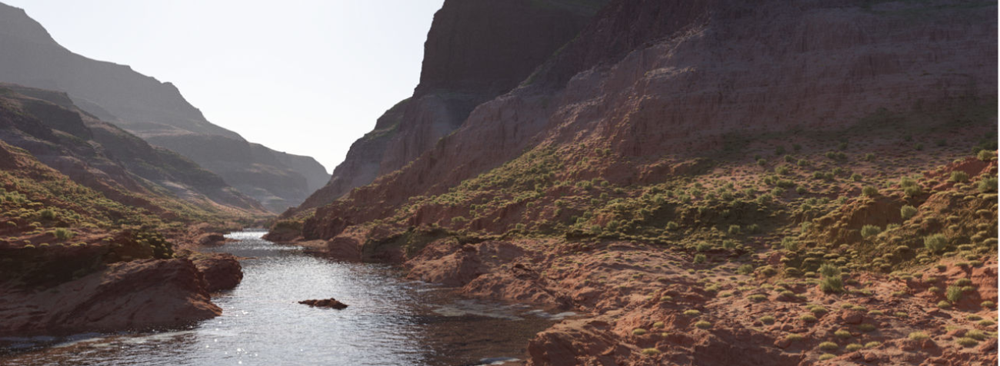

In [9]:
base64_data = "iVBORw0KGgoAAAANSUhEUgAABRQAAAHdCAYAAABsTvWHAAAAAXNSR0IArs4c6QAAAARnQU1BAACxjwv8YQUAAAAJcEhZcwAADsIAAA7CARUoSoAAAP+lSURBVHhe7P3Zk2XZdeaJnQgfIiIHDBy69NR6UjEBtpnM2mQqYmKX9C7J+k+RmfTOf0ZmepFZP7V1V7NAFlkkit2sYpEgWCAIzhhzRkbG6B7h+n7f2t856x6/Q2R6eCYS8O/6unvvtde0hzPs7efee+vt959c3Lp1a7q4uDDdvn3b9Pz58+nZs/Pp+ORoroMA8sgokcxz83YB2X2IzY+LW4fU8b8/hMM2rhmH+uiqOGyfDrjiOFy5DbdHuh23rjhIRLcvQh0EI/fxcMg+/dvn+rb+uri938Ltg11wIILVsbaO4fmBPqZ6v4cb/CKgz4vt5+erzoL98+yKl4QXO5vp+rYP+2vpo7ougm199CLnw7Xe9r4+jFL7eLr7cCieg/UHuuCjtnctf6iPkYci1/W5f9Hdjuho+ukPfzD9//6//5/pm7/7b1SqK5FFb2uMp2eIXzomOu2D/WyRwR60zUYvow+2yfV29frYLijVQHRfXa7u4zbrUv8iWPxs5kHskKaOPPeWAB5EOfn4jw506ML3XNfNW+4m5LELLTq2IXTbUHhH07GubYz8ZTgGxkA+iBPq+nOMQvjrOii8Xpe8oTauZTrSnvhKGjx7VvN0jfh//gx/m7ZTB619dzny8dbHLnMHII3UBfWSv60BOVK9ZRCg786fOs70YXwDyttshwjn/Kx0KR8d1fn3/PzcKfK3T46tD+B1ArePpaP1SmI4UmToYeu2/VxMd+7c0ZrneHr69Hx69OSpgiEerYdkgxlCtIk/SIzPLtRG8cmD+E69+0MW0E/7iCVjF7nouU1D7hJUjy/aDyFzcnJSfS14zgq5p3TMyh7ztgP2qUYmPuwdHx+7TIzUA8oQg36LY6/Fhxxl9G77Gll8+hCbKEXfNgZig7i5F48/+KTIVp9o1AhSSDzpp95X0YmP2HJe5/ToAvIpR445cXTEOrj6mLWwonMd84Q0/tBB7vnzYffW8XSktqsaFR174isOxh7e2bB1fHxiGxbiXX1kEi8xdRpCeuMYqPnhfhUdH5+qfKRYa92OTNof3cSMDVkw7+JC40VsR2qXXs/U1rOzp9Otoxp7bF5oXlef6Dw52ms9tSgxFGGT9qiNz88sBy9+F90lHkB5HSdV+M38pg4bEGOjyY+A5TviLzYB+fAh94EQnyHQ5YLYir1qi/iru8RuhxQb4T0b6S3NqfTFs/MzpymDnA/sT/Ig9UkjSzc8e87cfKY65ttt2STWC4+dhkQ+l34Noq/MbBd/Zafic9xus3RRlwrnSMcgmnE8dN03ah+C2MenkqPbJ2WrxbDZlmELGRLZiXzpMDdbTINiAyfrsSl+hXAk+7kOIYvucm5BSPwltGY3UIyqR54854TUl1/19zg+OBc+13hULIM32hefiQ/f8M7PNd5n5+Z5Xgvlq8XCsTX0XBZ6O3ws2hcNqrr0B5CV6tuVXV/3lErTI1f11U5MzfGPPmK+W4bzHwyfB6fpv//v/x/T/+v//f+07due1Kp0R7mRZ7pwP5UiF5VbPpgBznFAoDSENA24wQ1ucIMb3OAGN/h5Qt1w5SZ086aM+5tnutf5yY9/OL311pu+D+LWi9uakzunus+pe599qJuuhYLudxvg56ZvfR+1Lu9Dt7+OweC+b/BS3wnsivFF0W1ty6cfdlGQ/K76XeBelRv7WjzV4mIbdVs9Rr3Psa4pINtvwueb8SYTdP3I9PKaBzFQtVFR8y/EHC3a1DvUR912p9goe8WL/LZ0m+2Aut63HD+xzWKDhdZzHUMls2wkAuTiA5DPBlb17bAjeOF1duZ81wGxA/V4Qt0f+W3Ehg+ygPK5ymda5HH8h8+iNsjYg+4HH9Wvm2PVEZ+1mKzNgPBA/EUPfniBfQ6drtvz6Pc44cfXLqCzrk7b1gSUu1SftpPv/mhO7C+86i/i3Hc8Ba4bdlJeE0gsQfLh97roJW7iYA5mMy02cbzookMbsVlUKD6LfzYXiLX7CnzcSQas4wFs3CSG3jfun1FffbX0FzZqnizzGBlscFzl2LId6cztHrZMmuPxx35AEfVDTsc0xDnK+wVsQoovb4PozyLKydd5pnicB9hjYOOlji+IDfWyWzpJK7bElJjdX7YnrdHu9CEp8w7ycdLmJ4gNKEg9suj1Tcw1LfKVrrHNbuTs17kKP+MKkFnHjTz163hniBWZouqnzB3PXzZ9b9F3RcmTshHtDSNHA9WclmunFxfosumtuXN0Rzbvmk5IVT46Op1uX8iD5ORNJN+yeyI6vqUYVE5saWsI0OYjYnbckheRQrVBKvImNjGjl3agX7HyQJs3PRV/ZKCyU/0x22r+oTp+HMqM9PUsh4z/9QTJr9p68Zw5OPiOB1KcLit28uIRI3Elntu34afPi8inb/BLnzD2zL8zXfOePn06PXn6WOkTb/Sf+59ydcwQO7R5fNEfOZ64BsiuXEW2EzI+X9yCsMf5mvl3Jh9n9nV29lip6PlTXXN0TEwi1Z8/q1iIE5/B0f/t//7f/w6BsovrARgNY7R8MNhpIQOUhmOMjtgH27pGHLTu3hv5HbjeCA/j2vvomu2Dq/vYr39V86jvNXFFBwftr7C1vw7EcNj+R4ngcgy6NuwF1R/Nww0+izh8LP8CzALuRvZgfy199Ole9z4TuOYu+Ch9HNk+7Izhmz/56fT7//Z3p7/4z382nT95NJ1q4cX96ZFuyLlxy40e4J6nA36nfVjLcROGvdw/rW2s5bdhl/ymznZ+8kkPtW0X7ULsre12freRdC1v7HZj+OmPS0fsFjsrxL8XCvjHz4oWuzAKiRXMNhovgEd7LrVJovY65pZVfUOfhXQImVFv/9irFCz5ktkWA3AMZIa4TM4bHtVC+aVK/smYTd5ag9dsJ5/UzRtttF0ssrDRYo8nAl1HDGPhUe3Kom6xxaYHyNxIPovsIy3Igl4PKPP0D4CXRY75kF7hR0feXbeMA6RjU/U8DXku2apnzYPt9NPiu/tHOXaCXm+uu6J4AeXZJj5H37i89jEwy4965Fmbgd63TJHI8OKJnW2Y7Y0NKcrdRzDbGhSZoMctK6pPLLXJ2J+Yio9uI58U6uMHZh29eBqqbC1xgV5e12/Iem5v+ofSb+k7QByh2Oxr4Njt9tkEqY0I8fW6Nepq805cUupNPYbi6W3DHnXElPW3N/hGjCFJlbD8gegk7W1SxlRl4lNRbi0DR2OUzUVkSm2Mtf6on225D5a04uY4q00NLNapxorzeWEIqyy7koSqayxpvp9WG/VdXm+2C/o8gfDO+YI45hiFngfUh9bl8DgfRW9dZ6jKpcgkHfnspbhfMwatX9Gf7futYrYOMuqQ2pweRN2YP+h6Lg1Qx/XATzVWUOYlLcKG4lC+5sTYdGOz7VZtatXmXvE4354c3xOdqi/uTCend50eH50ovhM/hcvcZi5Dx5I38YQu9sUjnopiGWficz9qLI+PZcOvqsuxQl8g45iIOyNOPSImyYzjkjnsjXK/qh6+r0FDxjp6QyLHol+jf4DHaORtX31a19kFZUZ10nV+tlH5+EJCFt2PlvGr2mIRqiHpMb5O4yr2RLh3TOO8pdZ43j+7eKZzYT6ZIJ7jHSSOVerNEhWjyKcY8ThVK6mnXEWk3uAXsbE46HxsYJZnfJ6Lx6Yjcs+nL3/5jekb3/i6fRz9N//N//F3fvrTn0zvv/eed0GP5Oj0pHa4/R8KpR6YDJzq0+kvQteNgx6I4YDQ9Ue5H9fdT5/IOFzZx379q5pHfa+JKzo4aH+Frf11IIbD9j9KBJdjWJ03L4Hqj+bhBp9FHD6WfwFmga5l+7C/lj7iarwbn8Q59+ce19wFL9rHuV/JfQx5bprPnp5N3/nL70y/97v/y/T2T3+scLmBHR+3U4l7oCxY0O3AxkytoZQ7ulxH7BFbxzb9XdhXt2DxH/l1W4Lw13a7/prALr1dfoJuo+uiB6X+wKFWWyBSL3nSol3ovoC06t2Kzmr8K3bSulF3caNNGbtt98MfDbLJUwJxPmjT3rLQWXhLvi8uQfowVPaqrgCv2uJ61ZXNypNGnjQbIFVe4gqVh4W8IeCnR5bNAxP1a13xIS+SxlM6kaNvi2rhmeMxer3sRZlQ7W1+iEh/LIdYXKYuH4VLykYJkJTjp1Q2ZBcTNEH6iZc6j72o9C4jspbHyID96xwEqAvI2abqOyqOTR6IbbfDGwGjLaPObY59bIxs9NZAI766v8hHZ62/LTZvNCQeia71t9l3fl0eqWGV0utxhsCG/EDVDX+jE7pe4iRfmwiywxxgHkMePWRvT8fq58vX/9iBeBoJ6eFDqe3bl3hWrXjiH3uhtD3tKLtLXzpO60YHW8iKhv2FX1j3Ce2pjMabEvEib7/jGjlsOBbNe3sZcc18XvSP8lgtoo5NPR1BIjYdVFANRxSeJTN0SRkPbOPeJJavwbJrIAtx7Jlqvs8xiMhDyOacEBnzV6h48Vf1oeiQ9uOzU+B/YFgvqVsxaJpOjpcnzzhHkN8XU+Twy71HPEW+Np1ISzenfIfE4k0pXQ2Qz5NxeYoubar5yR7PyXR6euoNL/yxcXh6cqpUfKV8jF53QbZRxNOKZYs28rot5xznbC7OTxuK6npxazp/Xl/HwKuGe/Sjj6vn0/HtE/ND1RZS3tSH8um5bH0aPAi5gWyQDi8+ZrORSPr8WfkrpP+HTVOh+EUAjdJaZMxzkMJg+1ifdWOn6lOeMbKKaLbDsG7ME87jjNNIT07V9xqfbDJjpPqxrkXAaVUVlDpWsrS1po6JuiWkYcfHZuMrJUZQ9XwcHsUqc4zhE/nf/M0vLxuK/+1/+3/6nffff2965+23pjd/+tPpnXfemR4+/NAHtCe3GlITvE6iGIJoPJ3waSPt3wlafEDooI1rxsaEuwZct31wdR/79a9qHvW9Jq7o4KD9Fbb214EYDtv/KBFcjuFmQ/EG4PCx/AswC8aFeBf219JH+699n8Q59+ce19wFh/o4N1uRqxugum/h6YMHHz6Y/uxP/+P05//pP07nZ09043nmmzvuefiv7HoOzPZo2HAdHpjjcTU3lZu0xq66Xt6mF2zTCy2ofOcn5vTHLkRnHwXb+Mlv85O6Na1h/oHbTK5bi43KH8JlGRSXsawbfm6aITPcjmDxt9hJnpQ51mkti63clLPgRqY/cbgmLe/97vPObKtSk0r1VrYTa9KSc3YgMqnnvbcPSh2LRu7/y8DsU0Tc5plfizvnbUvjDsVPiwndxJk1BWuO9AmIfdYfPNzgheGoA9FNLATQdc1reZ5sK07xavEr+2N8eNrD+hZabJLHKu/ZPIESG3LmWapgXSHxAJsbdtFN360BH5nYSD5+QyB9Rr0Xn+OpKurdp56/1d9erNI85YPYmaGxxs4c26iPTdB1bHcQSF3ax8YCgF11m22I/FwedjIPeqwg87/3UafYIV/ySqlL3iif0VmTusyQGQNebY7SL5ozXgt3ndFWx6T4lNbNdMUx13ns4RJj2S4stkCvCi+gnA1PUD7RWY4bb2rqeE1fpC97v+SkyvlNb7bhOpnwfEJkyGYjz6VhL5taM1TsHDYgkFt8j05N6yRcvBHX2JSpsuatfS7xph0B7Q6QCXW58JKvvlrKSVO3Jm9qOvaiIPX5PkTnRTKk6KGKl4ezgmhvrLFGve273fAWciuUum9mKj/VX6ofSmqByhVLNgDZMOQ7DOdNvnljsPZ02EhEE/T5zdzxOcAbh7jDV2jEqzEiZmtL13WtH4iJ0C5ucW6iHg60vLhW+Om9IV+dRA0sxSP+ycmp0uWjwrXJLaK9vNvGiF15+xznaOypRnx0JK3U42V/BWS94T2QdiYPaGfdGzCXaXfNWyOmqHdb61iibFnbRrbKS35suCvPhqHbpDHN90VCNqS/2yc636iOPOnwXKl4xFf9XzKJ6cIxlU5shUYUiM1yEhQNOwPMV7eXdg07o2uVJeaj2lD8+thQ/NrXf/t32J1W9fTw4cPpzTffnH784594Y/H+h/c5enyAspN9ckLD67+EDFg6/NPEwQjSkXvwabfiuvvxkxinq/vYr39V86jvNXFFBwftr7C1vw7EcNj+R4ngcgwbF7stoPqjebjBZxGHj+VfgFnAVXEP9tfSR7r47sEncc79ucc1d8GL9HFkSCHf/CvlHubdd96d/vN//E/T9/76r6eL8zNvKHIvdOfuHX9/zZOnT/xf+23Y5XvtLxsOa6TeN46j3JH6fej1ya91mOaXedzQFgHqk+9Y6+0CcpHdl+9I3ZqCHlvdzO9G3fTG5mVfLwyrYYlb7VpoOA45yPHebZe/Kvf+C38bBZGf26kb88pKxg1iTFpq9JS6JX9r9cM1a7817+FTuzn2xRNXvOSD0pGMXkNlyC22Y4MeQl2SIy0ypINe/CblOOzrCY4XjsEcF9GB/OTJkA0oA3TDja1LgDeEWBzlCSzLYtMLPCrHG3xR3MF2lZDzCFhiLPPwE39gnrSjH7/RTTmw/PARPnI9Bek/ZCG+ssF8ybhuNNh2VH882ryGeebXhiLk2EbdWicxg61tJZ5xzPR4A9te8eMHbh/XDaiIWnR7ik63GXuh4mF7+RGDNYHasGvjLn5ttiwbyLyU0bvaOMrmidCrOMactr7kzGJMgtFPw7ZlsKI08YQ6sF2Ea+oZ79qQh2+e4lrkqiEb9uaxUTTeuKtxrM0YPlI85rheYpjYiHEklN1slyQ37Cqf86Q/Ikl88HghSxiOZ/nIsjcN9bJtkV2NOb3Jl55tyR+8HX2U9q7r1rRNtiN1HcjQJ8yBeloMUhyi2nxTnHqvPlRGfZA5ab6Zi81s3DB264+rukz1iG2DRtvlVX77/KlzZ31fZm0m1tOI1IuGrDcUxSecZ2c8Ea4Yx6T0dJjL5SuQyzmGwVGM5D0Z9EeKvO6vINlXN5XOeGU8K171pWJMPXquY0PTcR7p/uuO7YbSDpeZRVLzPDWv5o8jUhkb1Q/VBz6vDX2ksvEYAo4FowM6q6gd/HOZcSRfHwOmfMufKlBufCdobRAWeUN9fFQYPvJz3dhMtLxsHCnGHoMMO6HsjXUVMz98Tre9mkkQ32VKo93+9prbovbacmsXsE+9lrk3+CLGznwYtoHu0Lfdmv/062/+5m9O3/j6V1119K//9f/1dxCML05KfPT54cMH03vvvz/99M23pnfffXd69OiRvzMRxwmUCzyD+Wlis4u2gIYdEDpo45rhQb9GXLd9cHUf+/Wvah71vSau6OCg/RW29teBGA7b/ygRXI7BF7A9oPqjebjBZxGHj+VfgFmQq+cO7K+lj/Zf9z6Jc+7PPa65Cw71ce5NclOfm1jucR4/fjz9+Ic/8obiP/3j32nAn03HusFHlieVePqA+z1uvrchvrELqlg86kLcxAaL7FIPBT3/IljrbtPPNE993TgutA+xd0gu6P67Tvhre5RrMbD0RY8r8ofmEbfpl2WwsbKzBeu29Rgg5gM3zXxhfLezttntdN3crIcP0IUyH8sn9kiRq3LxKEM1h7eRMTZdE1e33/0AdMiHqJvtCJEDS33FQZuC6DuvOnJsBlgQHhxls9GBnTXilxTKgjjHTY+LbI7lKi/tx3b6uscfmE8f8Bpxz/vUs161SQy91P/OAclatzZVel96jNMnQ5/6tHX2FUJISNykiRmd8FPuvnpdKPrIeQGeDUX6ieibLK5PV/MYVN0cme0kfuzM+gOJA6SuyyRu3Kd/qMIuqrXIrrgBenM7lfa6y6DNI2ZKSiOfceh1cyyjrHf7J98pIP/cP7qwGUNd70suGxG0z2Wylq865qEvHhLAXjZR4LkvZCqbI/QJc7420bNZqfoWcyfAuYBfcwbFou1sXtX3FpZctSGIfvp5+aVsxSM5VGrMaId4slNP7lrIMVHtsur6WiH++FMNb6Ia8/ikDwDnBzaweOJ4MHirPrKXtAUjpZux8LlFcBucW+YaftLe+KRvk68YZT22RL3ONFstGzkOQpGfjw+PF23bZl/z/Lx+6dp8kWWy+SqSVJMvucD1Eo9s/Hc6ua15o+N5iY/YsoFI/8pAG6hFt2zR9fPmp1tPH6YNJc9JsmKr+Mwbqauxhe/hv+rLjuVu15j19iGz9G09zBaUjWqHN/88T5s91UW+4qzrATYXF2UfG3ynY/qjKH1TcFyLeyNtpK6+L7A2C5mX5+f1Q1ocx/LuFx2pWStFxSHTDtEbh1z/awOSsgQtVzEXFeqeNOev9BVlNg/rkwK0lbTsFBErx0CNq+OVnVxvq77GqRC9ImQcoz8WThtGlTqEFw2pscixxFyvMeHj73wknvTLX/7S9PWv/RaK09F/99v/+ncwRhD4rYFAeZqePnk6vffuu9PP3n9vevftt6e333xzeuett/zxaOi9d96Zjk9OHVRNgNx4cEKioRVEfQ8FHa6Bhif7bpLKDG41rCZFH0zqqmm7Xw6UdBeR7MGB6peMHpeib+29TrwcHy32FV1bG5qbq3qw/phja7yM+LGw3wr9VL7iL3mXSS21n/Zjv0T3Z59b0H1toxv8MqCP9HoG9Lp98JVpK3zu9yv5TaojYT+QuxK4UO3BIft1DElKoVa0mxq7jq99KJ3Qi6DkytVH0duO3IQEh/pg8bmDSF4iNvuH/odbcS/9XWnawk0g9yPHuilCJHcU/BjLt/79H/rjzo8efqj7ElVKoL7wn3sXLbzHjee6Xzp2jfOanxhDge9xVrwgvH3+XwjDtI849UUdecK8o1K+1nEknxvwbfWddiF1vR3wUk59TzuVGHVFvDbKSkJgJMKoH/lLLylU/1PN+IyzEnml9fElyfmGXfG7v0rGCwhSBzf4ysOvJxu53xVbsI0UAOVOrX/r44rw6Hel6KEq2+TtzyESkNU8jK6TS4hFpKzIHnaZ8SwEqhy+FwY8ZUBeL2+CDINuB/5GfNVG+BBOiIV48a0Wa/2AY/Lc59emolWsn8XjGvEDkFMQWqTUUyWkPAUEiM2LLfuvuALyOYZYHNPOeXNC8h5HBJWvBWq1iZ6A7xiquvxhh7phE5D4aSJixSb257rKu4xOFl+St91lUCouUdoMuj58r8OUT5sAfC8uReGnDpBf1m3jnyIsUBkXidFu8Pz82XT3zp2N+Yk9+oQyv3ZNmb5Hx30zt1kGyDq/xMZcy9yijrfE+EzjweaRnwbV+lCC9llidQQZki8Hy1ijv26ry8jSl7JFf5aqZMQ16c0fGwxZgHZU+/hnkX/51LqbKeT22lLFWNFWnnrnB6l5BfiuC6lCf0Tqxbfs5x8GPt686ZONjho3xymca4w819U71tBbxYY2dtU/jqtA1m1jjQ0bP3Ms0V3IbfWr9KTo8cvGFHrY56lKjgzanbZ7Pe9+ZxxqrlX7NL/k+5lir80M4k+M+CWt+UHTfJxqDJChrdXPoOKe4yQG2ar2lU14OTeQh0BijC3zFavP3SK4tIvrOykv1VieuVRf6Ubfyp9enl/saRzXfUDmJbWkZ95YOndbKuoab7dbsng8Oj6tON1X4/gwSgbfjltl4q1f0HbYjkWelDI+1OkYkg2+q/BY9tgo8/mM+cR4zGc09OmX6l/7qKjt0zzy8BinC843ai++peJrnuoo57hx7xGTdYt3weY1sXMNweloy5JaRe1PLADOQsVnnJW4vEnMgeqjGn/Hi2EROpZxu1SveUdK27nXcx/CH698rJf4/UMjz2v8zp+fqbxsGJrHLxiPpw45XzxTPfPCX4kxfNMun1+IXXXuYzYPbYNfSK5fCvePnYyoR9Amt8LxUIRHpggf9ar2Mn8L4rgfltTEvBzkvh+o8+M4BwqR73LuawVy66Lm1gn/3OAHdzS/+MVuvi/29PjOdHJU36fJx8+Ze3xyh++/1NE/fflLb0xf/eq/sr2jb3z9v/sdDwyGzRqQP8qEwmA9fvRo+uBn70/vvP329NZPf6ob8p9MPxW9/c670/0P7hOtDko5EyXoZ+pQJvvpKScrdSL9Iz+c/M594lEAcoIs6A0HbizpIdLbTtom3+iThNsjp3NcLl9/FC/Dx0bsK7ou2CdpFa+E/HrUui9eVv9/nDi77+jvo8N4MaldWPtb0w1+WXDV0a5jbRfqYrkfdeRvB7qH9A9inA924WB8I7xKcoOzUGp2Ide4NRb9w6jzRwlH72Wdz4yY30FOSHfQlcdoC7p90PuRtm+2nzqeuKnFEgtq5hW33v/wd383/f7v/dvpn/7hb33PgkEv1HS/wkJCmbkB8/0IvC2IT+Qqu8QBr/j7dTu6fHxvQ+RCHZu86gdotqeqVNOuQzaSruNZ66zR662rYuzGVu77wg+FR+jizC8xW0kv9oF0fznrrl7Wtr2FcO2FGIuasIEq0sLZnuoq1kEstOZX3fSXjlL0kZWOF9/e1Ch/u4Druvmv+3BSfPqeHDuuJ1aVeZk/yGX6T1JaGPgem5WKa8T3qoUyfP0NmvXCUzvwa7ERLOOCj2oP8qpj40Kv4bGUWaBwP++NRc1J26YdtZjpG12xPdsVkGHhwnGJLMcjx6w3AiRzxiJNut5EFdBNmjxwecQ8c8uFy/6uLdWF1rjN2sWSFXvsE4PHYsQbpD4kB35Ygmytf9jUWxa62djrfRA/IOugan9tMiEbArOvkQfdBkDWG4qyx7xx/4tPLCenR66r74tkwwI7+K7FNB+Z9uaSmOjXZnHG1FmBvM6nqsMXeYg8c4hFKTExZh435fneQVTTg8l7vEQYp1z/0MHO0qbyUe2uKTpGqaoF6iv12HoM6FuY6b/aMCBPf2xDyVVby2b5DAGnjrfihmqjbWmDeqLiEI8xr/4ZdkaZurRRLk1svta41RaEqgySyrOuHhs5+GvADmPtWHjhawuVTynQVvU1oD/qGlmbyAHHep4UJG7PSeREjtl1rrWt87MzpxVvtQu4T+2UGGg/dtyg5q9i6/2i2lGfsaDr6xxBrMBzdMyZntZG0Bh7LIw8G0MFYr6YzvmqE/R0/uNJND6dyYYQjaB55X1yXW021hxl/0IZVY72QnpLnvE/Ob3nuUisRTUGtqg/25OTio3Yy55TCegolq2aB+oRb/rQ15pV3vDhvM5r1EpPWZerL52llMBcsFDB/upBMuDzG2QZ+YU35i7t8RhQo/anr33NUcq5AF6dL8qd3fqwqEzmZxF2ixcfQcZqyZcv+5EPOxA8Vxxr+YZPH7uf4WoOnLPJN/en5FRmbjDu9eRhnQddr7Q2FGsj0X5kyB/rHvH1Yz7XdsYoSIy1wY9P1fuYQb7OEzlXhLClhlQf6A8tqZpgwLct2axN8ZEffui/ArLElPhy7hFhWOR4kLFcjUU2qLkG84M8UD2dXNes46NTyfHjOVhhY7v+ieCvDFGMX/rSv5y+kg3F3/7Gv/4d53YAoyHACY/vF+Ij0A8fPJjefPvt6b333pv4YZf333/fxEek33rrLX8f48X58+mVV+56px/do+Oa6M6rATlBVidUx9Bpbj5+zfnFQPowWJevCy/DzycVa8fL9BlL1zUGWPmoll5+n75sezf45cT1zqPl8rsddSxd81yuq/VOHIzx4LF7/cfiyz9/rHDA/CHvh/rwquAmKyl90ck3YNwAcaOkG6Qzf1fQhb8fkXuX//wXfzH9xz/936bHDx/UDV5D3ezGRvmgTIN9Azxu/szbgtRBsiC1kot8bHZ0X8lDu3RSzj3TPqx1Hc6g2qTZ354gMQX75HfFC7reIb/pP2QyLp0AG4oq7CW9z+jtwAbZPEGUtAh/9O+mP5By9Dt6HSj7zm7HLLvYB5txct887Lo88q1PSq7yfV5ggwVSLUCWxdkGabEVvaTcn5OnngUl/UGeRYQOAXrFDYPnBR11kqsNiiwaS5967vmtLx4EIu/FDYscL9LQq3WAY1ZqPS+cNwEfYAc9L3xHOXUg9aRQR3jUR6PLJGZvoDR/XcaQvpiWcXvZUNSClZi8Yar2tZAu+QBuwyAAPxSg19vS7az1KNO/gT+CN8ZKb5UMIMuGIvbQPT+vJ3fgl1345cvjIooPCD2e/qsNUZ7qKjkGxPpu/xJX1wt6PvbDIw96OfWh8lPxhxyDMNcL4TMnofgK8GCbEp83gszUH3MVnpskm8hR79nDPK1NOnwlhmrn5faj1/0mb3MN0Qv8zy/BMYpir1Pq1hSotCEXzHHCoy7Hp8Y1GyJ+8kr9xhyh79Z9HLuJ25sY4vnJJ9mhk2gBMWAP+9l8pWPZKGHjDol5MwZ7KA67GbMQmFPRul1dhvG5c3JqW7UpxAZ6zQNUiOP8WZ0TDSUcv9nsh/yUoDdi04fp+6rnwoTt28f1BKifrHR99ZHn3dgsi2/y5ZJ+KZuSVtBiivyyQOWTVsuGDHF445a4ijbKkuE4LsvFQ7e6R2lOD9Qq7q4Pm7qQ3v0CyxP9yit2wuHpP8LlGPH4z+d3yiPuaoYN9s1D9wVNX70WqHRL8lyQbENvIiSg5yp26SC2QeKoPq064HaIfByPPlio2oJTXs6JX+2q823NATbpNEd0TnUdNGwH5HHZqSPx9NRebaNSf0/k8ImfoiVf8sWrDcI6BslTX08kNvkRn30pD08ZB5fIKTqvtzf6hiJPKDq3BxiN4e4Q8J+nJ08eT++/99705ps/nX784x9NP/rRD6cf/vAH0w9/8AP/kiL/ebn/4YfTh6L8sAsnpFdevVs72kLsxnbyi6fPPtK2YF2+LrwMP59UrB0v02csXdcYYOWjWnr5ffqy7d3glxPXO49W18xLqGPpmufyuEDvwsEYDx67138svvzzxwoHzB/yfqgPXwZyo0U09EfvExZ+3JGyMOBGmxsq7ke+81ffmf7oj781/e3ffE83g/WEQbC2kZsq4JS/IRP+xs1eq+Oehk2IEivZjsiThl4ELyoHlicyCo6tvQDmEvMaiQ/0GLfJdqxj7OVdvtbovrbRUuesW7ONxi21XwZmRfnYMLfJ3igZC62Sy31uLRwKo85hwRuEDesVv/TCh/CwH7VhtxvDcxlsSD+A5Pt9Or5DBORYxA8Bp8MuCdyqg292+Y88MoMf2zzdQn2/j4fPIvncG1NVD5KC8PtGYPjMXW8qioA/mtV0O+CzqCLtNgJ429YYIP2lIGad1IE59rHY7XWB4yWt0rBT5MX0rLOpi1zJFrDtWAT42YStjY6KPfH2OJBJOTYp10Kz7IHnfuopPrBRfORYZLJpAvAHgfiz3RF/7Pd4ID8FymaC5GxDcuaPONAD0UusgHLagG73ASI7irONTvBqI6psBF0miD0IVNQDo4Av+2t5+k9KnFyVjFEnLsSUJXVfylf6Me1PTH1c0tY11m0HlPFEMfVpVyh8aA142MJndMODZr1x7YR8HZWc3jyj2SgmivVHLWMPon2WIlBytouv8jdj8JFnw4Vy9Mpm1c31RmxVrPGX1KT+P+ZpW9IxFj0+vmv0zp160Onk9HQ6PT3xXoZjwy7+5CP6s92ZxINv2/ItnjdsqLN8feqBjTV48VvHRvWVTmfmzXEdtfiVdxtdr1jG9cj9YT/YykZX9VkIW1Kc5Sut/CKnd/HK/+h3aNQTG+V6ojR6ipw5L8qTy7ePkVGtXcqep83g6WCo7w8kT6sBvOIzb/yk9Dhz1ktzSa8cSBUSmiFB5cg808vccmht20eHeEb/QsHS7oqzUJmad8iM8WIs1ChJlp6IJ/P8zy/qMVABmEpm1A+Z2kgcjpC1vKVnfkmsX27C8FPxcn4NZZO6niiveuzUtXSk6I84IP9ja+g7NgnwhGK1gzOLoPh8XnNZHNXRJ4nbm7455sV7441/OX3la9lQ/MZH2VC0u1ZWQOJ5EMaJhY1CHht+9Ojh9Ojhw+ln7/9s+vD+/emf/+mfph/+6IfTfeX5XkZ+Ufpzr7+qA/vUtgB2QBoK6v0XA2lTsC5fF16Gn08q1o6X6TOWrmsMsPJRLb38Pn3Z9m7wy4nrnUfjurQTdSxd81we15pdOBjjwWP3+o/Fl3/+WOGA+UPeD/Xhy0Xdk/Q+yc04ePLkyfSDf/6n6U/+5E+m3//m701/872/np48fjjxQbzoXNIf5TW/I/cswDdYK/nUr/U7f123D93fC2El3n2RtznRtvjCI7/N766417JrOcqdt81+eNAuP8B6VKO+g+StZAQ/ncGKOPVOVGl+eNaY3w0vagQl8Oca2xk2R03VFhzfUN0FaauNLNqCpe3WN2IT3sg2bNwzt/6NjVrkFXlBsbHIHRs9Q5ZstcsmXE6bbrnvJJMKU0W39lvrgVo4Aupsq0QsY78Cix4WahgyXy/0bGNs5ClSy+5CfpAExLb1Rt90ClJGBiAPugw8l6mr6o16gMy5Fse1mVVyWZSlTOM2x3lBYmDzgjyU+IPwoaDH23VSZpyThwgkY1/l0s1GRs3jAnaQgw88jqMp6FAXin0/7WNdxk6SwzabLeRVYVvxjc3EG1sdsQshx3xijUkedN8Abj423XW7DEg5+p1XVph/NQe9gLa9aoIKk7+PkafzvOFb/5RiUZ4No2xipX29DMUX+RwjaRNIfcVTSLk2CLLxtBzHXQfCXohyQBl/ve1djuvmhXxULwjIYM9yjNnFdMonDYUed/yGwGxT9kgRNQ/fI+7Mj5LhXLRsuMKvTT2e8io5Nut4MKl+zXjZ7LO8UvvD7qiLDCk6p6en3mxUFCWHvurQYzOK1hC+Nw1jV1TtKHLc/hVl1VtmpMmLIhtkHvm8AFRXcVWb2NB0LCLrWb/6RN7K51E2kohNMQ8/scd5vvTC46/K6zZ4A9Dy+ht6UMal5DaPR+LPmCunmMXk2jjIbaxtPb+Kp5KpngYO5alMWXWfW3akjsnl8ZJ+yVVqUr2vDZIlbrjY80fdzVL8bLHRri2gjbaJKbfThpxn/NzH9K954xpF37i+5Rkb3WcW4Y8xWfpv9p+w9ZptIGv7NRbmDzJPaT09mM1ExcX4e97wXYaaAzJbNm1Jejgrm7zcBmwqX5JKEws+VM5GcfWzqkZam5Loha9RZeyeqd8ZO8nxhOJXv/4V1+/dUMQQkxt4AokYME4oOTjqAqJXUgvn5Hp7Ont6Nj19+nR66+23prdNb08/+ME/Tw8ePJhee+316Qtf+ILkli8AdgOlR0oZ2OYvAGpgFqzL14WX4eeTirXjZfqMpesaA6x8VEsvv09ftr0b/HLieudRndV3o46la57L49qyCwdjPHjsXv+x+PLPHyscMH/I+6E+vCp6+8mH5nsJ3Wk+Ozuf3n/3nekv/uzPpv/l3/xP059864+mf/rHv58eP36oGyktriVfN7WLvfm+o9kMUufGieSpygMluqkD1uVgF38bZt8Gbfxo+qDLk8/aBqSu+9ll/6P4XctS7rx1n0L0ax+HTLa13tz/my5WkL+Rw6T1hloUXcyb/iLP2ia8qq/U+htlL0/nm3aY5UeVul82yG8hEi/obBCCPXRdqLfimTMjcrU4kp1VXwe+Tx/9nvvrpMDehy3awWuEUnrUZcERol3IK7H8cJ0F5/q4AllMd14W1afHJ17MAvTZGIL8lG187AD2WGQpU7pjkwbQzrR1M5ZlvQGpdeaBbXIVQ9WlnrqZqtJ5P12pGMjT9/WRZ9ZSi25PocQBBbENIoNW54PorXnxASpfbYG22WaTLOVOyHntN8xHHgqQqSdg6kkh/jSgtTaUa/qkNjGWMQ7FHmkQ390HMfD9ZyDy0XF8IuZM+PPmjDC3odUvcLAbsn3TIzFWPXOzNjbzXWu0yxtCootnyyZ29BJHbytwvPLT4R/JUP2ymF8Qu3pzGgqwD+ClrSmv5XqMIYCUNwx83ClesVG1OnnxjvkOxGEv/RN4U27mVVur/bS5dI5Ojid/HyMxMGeodzySoS+9Waa8fHiDCxk2RsgrZXMl7Unb5r4xz6HO/BCbMBD2pothX3Jz2z2OtVnX24QdylDZ5FxDPMp7jjNedf7Rm+RKh85Dp8Yic6nGxBvukk2MRAJn2Wir/qLepJf3VfKxYZFYtudY60RcxJyswSoWoUDV5BE3UouOfVCvChPtwtSwYWnHvvi6daSU8qiDfO5TG1yWDLH5eFGb5vM5GvYpsi8xkLUdvzv1k4zY8Rml1Y08cw1l1MUY9Uwh2lB9atN2UJj701Rl9+dIobomjQ1F9YP7nf4wDV1s6cVciX7mOHnSovQfQKPqa+Owamr+iJ/U9UVukC3A17vrE4uoaorf0mxK8jUDlLGTa3j6iTfXwR8nd9uDr0zFpAxMxoH5Kzl+8KZm68X0xpffmL72IhuKgIACggCwqlFVlwZsoHzpxFM77yV7y9+/+MEHH/hLTflPwb/4F/87/7eAAbGafFgWIm/uLwbSX8G6fF14GX4+qVg7XqbPWLquMcDKR7X08vv0Zdu7wS8nrnce1VVkN+pYuua5PK5lu3AwxoPH7vUfiy///LHCAfOHvB/qw5eB9MHSF8uNPz/C8g9/+3fT7/3b3zX91bf/Yrr//rta8J1NPGDBrwESZBZEuQcBudfpCK/Xkcc37nOzCUgQS33xKu12Oq/zwVo+6GVk9tE2dH75XeyssYvXaY3O2yaTcvnebBt14s75bWkQXfj7XoZXNswN8nqz6lKP16LKW8By3DhTRL/YRvKDSm9YM09vqdfbwt9G1eK0Z7NPRm849s7fBAsg6kOg95cXBQPur1aHfMVeryyoqrLIC0UvJmoxyAJETGer/xGrsu0NH1AWW4lrWXwtvngC6cSbCBWXF6WS9yef0NMfC6S0L7YCbKUPavFex3T48Rl0/cQCJ/y1rGWqcKkOwl+eUKK2+gvZyU+RnJ6cOn7k4i92SBNf4o7NEOXIknMqXrcRXvjYBOgD1/PUkBCbvQ7iex/Rg2JrFxJz5CA2E+H7I5vedGEshx3Jsvj2xm9DYiUFyIYHhbegnrL0xtAqBvuSBLzYsAZ1o83nbdO080HJD1vi97rIKzfX4Qw+7c08q824JQb4pAB9yhCIffTCKx/irfQC8vVQj3j8KS3eiEnAXnjYoAzFHuhl22p4/kx9xLlPfGZNbW5IR3X+KKvW7+YNP9GPvUqrvtrLJp36J5scfPUZ11/kRPCyQVa8+p2FtGfePPOLflu+vxHf6Kc9Tgf1NkbWsWJknE/mjS63U/GyMay5G9noB9jkHyDef3GsVe8eQIcXeuaVT0eu/iyb1aZnhGElUDrEWKQK2c09BRs8xhwLlom7Nrb5RWI40y0IYVqDPzb2+FiwpO1/lE1DZpB1lZtJdryXpNT1IZVr01tS0nFIDgt+5dHwGKJJm0cZy95ANDGm0hll19MHiqs2EStf/bfY7CRNz8P+qnnJGGqejf5jzEKehyPvvpVM5RUPFmTX+tm4NS+yOC6/FdbQ4/pMcU75K1mPBeVUzIlaNPj2gfzIVz36Otf4fAKj5GeZgYpp6CcnXo61RXpJi4pzW/bytKF19arAqh4bvp4pDubmfD6gD5V+6cu/MX3161+1vaOvf/23D37kOcgAAFKyGWwuJD5x6EDDSSYG/0mwjHj1nwGCwMDkJxf/6//6fz/duXvXjyJjMweURezA5n8hkL4L1uXrwsvw80nF2vEyfcbSdY0BVj6qpZffpy/b3g1+OXG98+jQKb2OpWuey+O6tQsHYzx47F7/sfjyzx8rHDB/yPt1X7pp/64+4J7jxz/4wfTv/u03pz/6wz+YfvSDf5oudOPNR7Uunp/pHuTC3x3DL+ZxvwFiD93c1yQPbfMVuehGBnavO4TuJ+j5YM17Edvr2DYwzK3r8dN529J1ffKgl7lvBIk9/F6Gcn+ZeuV4W8ojDVL2jfOe18ZExCflwfNiRHOhFmHqfyp037oIQWDT9+Wx2awHiwx1a/kF1HjTrIGmdVbya79zH4z77MtxDRm3czCE3pfW4U8p/GzUgCzqSfPUUeTdbTJD/9NEdKH1OAbhk8Z+L7No8cIeP2yYpM9ia8TYET+xQ/0c75DNArKj24m+p8rguzwAzzKjHMCHHC8pAugNfoosarMO0p9jmX0KaT/lfi5a24dSB11q05ADvT76LNqzqdFtxj/ABv2VWPL0HOXaEFo2AxNHfGID+6wF/XHUI341uz6CLGk/OJJ1HqQ362A3SFwbMY04wbzObGNK3bo9s49RH0qbUkc5urHrzRn3k7UJ01QQkz8trhGA701UZRBh3mazDx+xGfS4iCPztMdKPDhJO8KHKl8EqMd3B7xqx2Zfwos9sM5DjoWy2k+KbZPaqFoTznkwiPMEFMQHKfy0vXhj89cbMLKsPE1wOzBpC4WZpwx5NnfqCV/Ge8SsCsyAxF4FkXQorjcU17i4qGNylCzndlq5TK2R/uQpRh3Z9lMmYgeUDT+h7E044ike8pH1pufgd/3iUVfxV78NyFnNzfql6TP/WvGZNxbhlX2slVw97VjzjF+v9lO1yjPHefqP8Yy92sjjicAit9Xtw1rVk8N62vHMx0rngbRFWtU5qqu+hRZQVzG7zW5l2QKxl/roV5+M/Pjla0SZHd4QZnzYEHQfWtlp2VjPiaUOuK2DigGPTGTKRjYYa07WvOQFnHN9ySCy+Ijf7iv5zi+/4WHLlpvdxJHzTWQXjDZ5Cpb/2mhl3kp38Dz+41wRkK/zEPcmdc5kA/9Cc4lmuB+VIf/Gl95YNhS/8fX6leclcL/bUTmrCvId4bOBSNxu0Nz7ztkWQdcErkkLCAT5x48fT7/+a/9i+vznPz+9+sq90TFol5mcAHtjaUiQGD8rWMf6ScVebj6+r5cTJzb20WW8zP6JpX1jQG4XHcKLygXb2lYzfDcO2/8oEdzgBrtwtXl0aB4fAt65blwrxvVkFw63gWvPyG7F/vgPntpeoPl1Drlqb+8G5vGwiw7h+iIrZI7gh/sChtQ/tKH7iJ/86MfTH3zzm9Of/PG/n+7/7H3dc9TNMdIkyPp+Q6V+j+P7mFbevD4oz1/jR5b0kvyq3BG9bYgtsEu/IzLbbPYY1vVVXvxAkel6tdkGz4lVyBfBLNnIz3oDlNOmdR2oG+PtNki9KFHRUSDjGkEZSmv9TgDfoWBDpv7gOs175ZCpG/eObt+IaXj4Ij/88Z573w0dwXGN/FAaCuTBkE9iv0pZTJFPaoGhqD+Ly7Z63rx6FVxnHUSKz5MmrItuH7EZUf3pBSZPv+j+vWzpJf5tHWNMCTcvRl2XxVotfqrPq9bg2ESf/vR9vCMxkOXHG8/PtXBhvdD08Gu7vKSfcSSt/hh21Bde/GStgS/08DVkKEMVW20OZPNjmHVUtqu0ePKjlJ6yL/mBLy9lRxLkWeOweGcFx5oFoWzGOGYbq3jnmMuZy1iiDxKv7WLTciUfXbcLGdssPjKUI5P6WUavzEN42MZONn2Q9yJSqWXwjT3l7c9UcbHBYBkR4rbDU1vDJp8+wx6LUPzeu3t3unvvrsee8y5EPQtcbGItmw/I0GfUAy94VUUR2XldKGbIcQvWkCxfZUHfo+iP8qHPG3+yN+tLjxQ97LJxRcwBsSObWNB/rnlsXb3g8yShY6LaGzgSElw3twMe8q5yvLW5U0/ZFZ/xT5k+6JumVZ9YeFGXcalzQc0J50UVBSg959JPQzagPcDjqLZU31X74wNp9yV1IvNtgjfGpY6jxN7PB/Yl8lgxnjx1xaYs8TAew4rnnI5/xImBzSHGJGM+OsJ8bOvNdkubvqp85ioy2yhyyw+hsAlVsbrjPL7DluxnnubcZR6yiATozFTjy4nDejqvei54PozYhl+HI9CM8lUxrsfTVKK48jxh44+AVVXkEscD56E6F3lTkU3CkXLsQp4hUkC+v+CYiJ16fknZZY2V7wUiWeeHzB1ATOkDUMcaY1nj6RhHvc9FYz4W0uNQtVWtdz97k1Cpbcwv+n/kbVipHVX/wiIK7AT26/NBUfp0NMtkexbmjf6vcTafdOi4YN4YL5WTBiVbfrDnNttv5Dge7MjofRkzPGmJQ4rlg5hG5WhHbPsfcbaPPLEpg08lc/+7TnK8rKM5oXFwrI02IJs5d2CnNiW5XvAdir8xfe0b84YiH3neVEYwHVPBXa4Pla7yIy1UmU6je9wBsmc4sCL15PTkyfn067/269MXv/AFB4eu/+tR/W6L6eScVFKebV4RvT3b6BC26Wyjjwv+g476xyf8b+N3uhxv6OWAscLWdsLN9fgtxNrabsq876NDeBG5Q23jfnvD6YpI9uOwxA1ucBhXnEdS3zeX6+y9GyXG+zViXEN24VCMYD53tGM616Yq72/DvvP6VdDj+SiI3kwHXodwcJzX/lZ0CNzgcA/gTQT1O19w/fTJk+lH//SD6Q9/7/enP/qDfze989ZPfCOdm6EaHl2LvChkA2KJkrHL/U789zg6P7I9n/Jav+t0pC71Qcq76gPs9RvYtVz3l3zn2TYvbpgbNn0iL6IYIlFqcn5Tf93OdTmIn34fh+xa3suf8JRIIo6dVgJjO7LIAWnXZhtJscBL/bkirU4sssgvsB0ysT/ynUfqmIX43bBl+dipMqAcog+sIvJi1AumJa2PJpbsMCIz1W7ICz/XCfGtNLwLPvd0pCOD7wLQeckLe54+gc7PtYjQ4lekpZPDg8pb2fCTD0c8haR7dHjc4yPHPT0CQ56XdQaPNBtM8NlQ9KYabaLfxUanNplqnqRNGVOA/IUo84TFeH0EucYurc8aInOCcjYUvZEjGS/W7HchArVtM8qPNy6ps4Cg/vaKBznlMbOxGSLU4rTyaKPPO6/aCFU17cSHyn5i00zGuhbU2CO/bn94pPEHyEMlX+c3QJk87Y+uZVRdEQmImvSmP2Ly+RRZS8gfmyL0s/KMGR9fhxhTfgwL2/fu3fN3ZJ5pfJ+e8XQUusRcHx09d1uJXeMhAsxf/GE3xNxffxy15+mfi2fPqt89f6QnGz4+MOH+rGsBzXI9dcrWglv9/oyyOLo+rF9o3dI8J8UcbaP/8Bd79UQmdZLFjP2N+C0UJO6SBdW31S+MMzQilRzjWmObtprvd/yUvU56c8omXY1dzXs7HeBYT8z48/pbVhkPt1HtxS9HB2XyPGnK+HK8ktIPPvZtVzRS5J2OOOq79J5Nt/DnWMoqs8dPiqOhlLI/sjrI5kY/Is+rIhYYZ5Gfgjxi7p3WnBQ7fUhcbrdQsTjrPkzfw/d8o97l6HN+KKKNnmPUqx16N2nWSH5F/KI6sc+ksWukDqh2rVB9WeOcOem8ddKv8JQbMnV+FE+1nHPruJF9zuvjY8m538RMkfqFTFXqr8h58bmH14yRHYGxURmqvqd9On/SH45rO6hxG5yvNOR+VKwyM1Mvk781nkBU6/xOOJ4GIv/qv3zTtxi0mtXJFdD1tBI87rLpe8HBc0SDD8/HnWzSnxXn6Pcmbx3nh376Tcgc6uR5Mvjnfsqvrju033atWmNTZpLHbvVbNUzHhRjuT5Gv0d58J76KH3Uo18vaJGe24AiZNj8H8VFmqpDvhA+netU7vrGZ85KGQW3hCcXVhuKCakSRvax4xV9421DsqquDGFkXN4D+zz647/9evf651/0z7j4RSDYXbPJpYBpRJwQ6Xd1UIV4Ju9rxoriq/iFc1fx1x/di2B/DdYcY8+u+eFl9g5VDlg654gS+D4cjPSxxgxscxhXn0UtQ1xWjCteFAxeOF7ms7Dt3VN01t+HnHC/h0rwX3EyxsOHXVVnYsPD4u+//7fQ//0//0/Qf/viPp/feeUsjUPcKQcbMqWnhAfK9DHK/EfTyWjY4VA/21b0ItsXa0et3p3Xj2Km31aO4chFdgGQX730TdPmPBaknNvKxP/sa7ta+o9P5iSXpiwLt2FnTC2HEEgqiv46nyzkd5Uv8Oa374V4f2Ae8wY/PHvuFV10i8VjweAMC0nHFooMvdmcxgY4XMkOX+3JvqLRNOS+iVJ84yEeu8yIToowueS9khizo+egG0ZdXp7UJsGzipZ5NJZAY4cVPeB3xETu5P4PfP6oafcRY1EePGPzRX2/QFCTtFAm1wv2IvDXQHwvBID7cJvFrgVg+rTd8Bb2EDIiMU28qLLqx3YH/9Et0yUMsiAE6GfMA2WwwpA3IexGtOvqMzUTO1ViNDBtMZ5JxH6pMH3mhKz68WvimZcRdHxcOqOtjx4KbuLBPHUTsALnME5B6kLgppr2dUn90fFILbIUPn6chLePoeTJtsQd/jcSTvusxhO+Nq6Zv+4MSR4BuPgVY/VXHW0fsGMp2f3qbYzCxueJ+bjJg1Fe2+rzLhED//keQvO2LjvkORWIUm5HjnwEs9m/zlWm0f9iC0g89zxjyKl5t+llP9d5Yw5YIECdzMH0EqPOGmvRB+g7ET+xRjpzRdED1wRIfVB/3r3HYZiP54jNWlda4j/Y4PvY9yCNTcmB0uzK8xRZ+atydSqg2z8s2FJv2u4otMQG3SX/5PtDZT0vLXvyhX3WxY55zZS8EP/2SMmSfDSmHHX0QHT/hiRfN2dpgU3slk/1PJlfX6/qOnTp0G7/TsDLbCD/xM89UU75FlqNz5jSbuWUHkM/5yfxRnxgCeKZWjl+QmOLXcnqLTOy7LrYGWXSkdbwv/kBime2OPIjdyH7py29MX11vKEYgQkHKvb7LxEnngRTrP49gsz4Nhv/hh/d9kfniF78wvf76a7648N0Ap3dOSrh1CP7i82VhHftHxVX1D+Gq5q87vhfD/hiuO8SYX/fFy+obrByydMhVblh34XCkhyVucIPDuOI8egnqOttX4bpw4BryIleYfeeOqrvmNvyc4+VepS+DxTd9zJMUp6cn07vvvjP97r/5N9Pvf/PfTvd/9t50rPsLvnx8DcbG42Pa5NW4NZk98M3WSiblfvO1C4fsB2ubHYdsUL+WSdmp65cY42PxRbq0s9sqGdGWC1ePtd+AbiOwrW2Bn0LYoge5nrxe2AgPUO52u/xHQvSYLP5b7LyQLXSaLGmPbR13x6zX6oeVkQoyox6aZZd76039RV4Kw7frnfKmPxZXz0QsUuaFFgugY28WUb608Bax6cP3qmXhTtn2FEY9ObOMT3SyqIJAFkYg/JTRI98pcBtE/GOh2+1y9ktAArzEkc2+7nsbkK0GlWz6AF/Yoox1ZWc72GZDEV3rsDhnPYRQoLxjIZUc5zTKID4o48dP3SEjStvSljUh08uxo9FzPkAusgB7lNOutCU8QLv4SHPaFiDPxnPyEG1gTpBii802NlFTD4+13zkfDxW8oTr0SmfpA/0pU2vK3jfYCHkz0Rsyil/16xH1Rrgq0mYoWHhLHby0PWTP9qec1LFgWReIjfYt8xDEDylxxjZp2grKX/V9QL5TgJ2lnypPil/GJ/7X8fsfA9Lv9Wu78IL4TdwB5fA62aZsB/EB4ZP5wwZi/ciyfB+Lz0YiX5+GX+wowL6pCAH8gbQVmdk+ch4NmxCVrOMc/Ys/jiP62EIDsTvHD0kufisp6z2ebfnoy6rS4vEycGNX1Gk8PNYVT8psWPOEryz5ePI/c0Y9vIpjxDjsux/UNnj0ccWUNsEf+vR3SC9E5thAruXiV5+U/WoDRdImPzCaJB1S9bfLNT/qOlLHbZA+4QGy2b5orktZ8YQfpM5ttUyNrz9Gzzjjxw6HX94GiCf6s11Vd5tQL89yQvhzPSmbijoX+BjWnKs5WXFhnPtQb54PWG/4AYkOftDz9F/8mQ/JtvtWlGMBSxtycMxf0OtmGezzGuUgurwvPjYBz7/yPDYU51Z2RwiFgm28jjWfYtEmP35C/ALau+++O33/+38z/f3f/930/nvvqmlaIJzowqRGpIk0KBcm9DIYN7jBDW5wgxvc4JcLJyen3CL4Zoib6X/+h3+cvvPtv5g+/OBn0yk31bqP2HfPEuReZI01b5tM7HcC22R3Ya27xqG6K0HquVncams0Y10X+W0qIH36UfuhI/pZNM7lcTMO1eJpqQPYoU0h0HUi+1HIelokbKSpP2iz6gP328iDdd1W0I5B+e6x/j1kaWvXT3tNiWXUAfJzWWp8RRZ7JF4AsihTXi2V/vIkFehtB+lvvasvpMOtuTdWuF9nk09WjkoWnWwqZOHbY4diO2WQtCNy2xCbEEjMeSKQPP6Xxfd2xAfU253yJm8oNaQOzO0ZbYE92/FHNMcCU/XpDzDbVz3xdp/Jd6QcmeR7mj6A5rgGUg6v67KJCK3Hjnz1Z2121qby4mM9FoB6eDyhCJBLXfT6sZ3jDJ3E1rHoVLzKjKR41hH1/ttGyO0jfwx9xLAmWbD9EPbSpiA+0ieRCV9BWq7bBdQDdLJx3+PofjtlnmfusFGW8dtGAHu7ylDK2Ov8+DSk2vnZYIeoo1X80jN8frCHHzpBFtulW2Yop69CVHFKwZOfPBZvYh7VCUznxXq6GmJjib1Fb1Ja3uZnJL7Eij+TbC4kJfxEfqUDohf4nMsL1Q1bagPn7Qv54pBAhbRCV+yyw1Ou/MrTc0XMx34vNF4i9dZMfIXAndNT/4I8fcpGKV8XwKak0yM+iq9+vV2bk7VZKFvQLdkbvIpBdaJ6lQxfc3F8WzbY1LxVG5v+2otByIzuXmL3tWMp2+aQz+YoZN+ijXnZ+jPleUN2Ram3P/VljS1WVU9/i8fYr4+Rbej2yAfdV/ixA8WuvxPS46pznvyJOWiMtfLrOMivz5H46f0Bus5MQ3epU+pJVASP6y7f4ck/avydpbZGWMktSNvW6PzEuEb128L3E4pdcNPhZeeHsHYaez2gnp49feqA6ICHDx74RPm5z70+vfbaq77QcLLpNzToZIApY36Y+9hIPB8XV9U/hE+7fS8H+2O47hBjft0XL6tvsHLI0iFXnNP34XCkhyVucIPDuOI8egnqulpU4bqwcZ27jBe58u07d1TdNbfh5xwf/e7ho4H7ABZ3bPDwNMI//+M/Tn/17W9PDz+47+99Ozvj3mLzJnGNxNjvU5Ku9cLLzR6omzpymzeG0U26DdRt3m8tcYBt9fvsAeo7HYTMr1zMum6nTVTbUlf3XUNJSe7Pguh32ofexuS7Dpx9/bARz0D3fVUCdcO+6Uu1vM35bXpJIwesvYp3jbWddfsSR6etiw+RITMstEYz5nDmsJD1YlA2RDxNMusKLHDr42+X57lJU+X4uL5bjU2lWjDxUdex2STZekJmmdMsivrCKIhteNTFB+Uu12EZ6bAYA+hBAFvw+Qg3bQOUWVugV7EuTzKvfczH89xZw5/Ix4iATpVLKD5r/VL9Qd/TB7aHnkRnTza/tDHxx0dS+nEdX2IBaXNkYi+EWOpiN7pgbSvjA9BjfNEjz1oNoh6e+1PtY56wiGZDJTYAdvMxUpDNXX9/n+roLzZD0AMkiSex0mNSsV7qAstpIuZj4SBtBeTdlqYna7yVrvQ8T0Z7wVrfqXzIg+RHXOLZnqsxVnagxB1/SdMv2FzaVj5KftHrdQC96EY+/kKR7Qiv18AjFij58OM79UHqEjdp8vEflI12DDW4rjIe85Rtx/nBE21A/u2Tp9u49sOqGgNxb7I85/vlFl3iXtrrkb9kO22FOB/6Oy2V4hNdUEn3ONqyIs43Fhu6ObfGHqiYxOOYka96ilkknqwWDdmksX/MD72Qh6cXc9915lhQfxyrtKuowh5yyCOWcTRPpLLP14zlbTYkax7bPhpKyyPy2MNVZXoayvzI3OhzIefL9O1lJNbhaKB4o+A44qfy81oaueE/iC2nckup7BXfYz/i8TlK49XPg2CZC0o1Vv56EI2fO1tG/fLc0XEuis34CREXGsknje2y76LrQI/PNrmUqMr1bgxxZx7rGPDZqmSj01OgaGb7SYHjafwuk3i/9OUvTV/52m+Zf/Tb38ivPC/GFziMygoxtg3rupSxi+N0UlDVJcP3DbCx+LMPfjY9fPjQncDEe+XeK+osbkKij3zFg/3EvCesF8K+dr0Irqp/CJ92+14O9sdw3SHG/LovXlbfYOWQpUOubjYUb/DzgSvOo5egzgXuWrH1erdgf21h37mj6q65DT/neJE+vAoYQu7N6epjLS4+eP+96ft//dfTmz/+0XRbN1P8x37fSdc3fVvmAWO36zpB2nUqv9hZ667tdOyr24ePY5P4trUVhB3dtY21yct2dsfzoljb7LGsN7dA2mM+k2Cg60G56Q0/WNvbB3nxwiI38msC3Tq+wreMXmJWunK7LbY1ur1doD7x1UJiiXUIFAn25nJSkdZKlldfStX5qkd4LGKoEBJz+hZ4UXxRTyOCWoDVd+exwciijjUy5R5ftwMvth3LoMiQ74gsBPyRSQE5bIHosp44Pzub+X6i5/h4lo2fNcIjZQ4knxSKDZrO4gt/8QkBt00vf8RRdQBr2VTDNClIPCA+INsWlfxmPeh8sK3Mk6Lhpd+D+ADE0PslcvQZ6Jta2IHvJ89k2t+RKD4UmWys8tSUMualP5mQ9i2+/Ys/3BnFGm1xWuUeF7A+g6B6+LPOQNqEwVlv2AKJgTFLHkp+5o1x5WO6ntvWFmxG45wNmKYPkoL0HzxsIQfSrmw8J5bUAdqALogPxzMI+d6mYM6rjvpQsTbzILFvmwfxG5lQ2jKP7QB12Kgx0PreT62NMWJMkNFrton6MNEtLb7ItzKvkY+cN3zpkxHjGnzsuvM9NwS3H6feICKuIvNcR8wieAPxHXtOGV8KQycUHlMVsSrLt0g9Yj59w76IY9fLsk7pY423+YyZ9Mb1z/71qjjNqKwWlrguJMbqZ/+YEHquL33KtTmpOm/o4aviQI+FauWRJVbZsnz0RiqJZR6U3aDmlHNKa+51Csp/+aEUIGI5KtQ5bCyrQZXKt/mDHI/qoI7ys/gC8DLfK585W7wNqJzxqhjLj/NDBP+VVB3nwRwjpJR5ipD6yMV3yox57ILUx2b9Q70oiIzliFJp+JdSTolVnOOOvbXNDsrU8yvPX/36V8w7+u3f/r/MP8rSFcrYpuFt1LGr3DujA55/iUvgaQI1X8fg8+mdd96ZPvjgg+nuvbuSqUUBHY98H9htNj8OrmrnZcWxC1c1f93xvRj2x3DdIcb8ui9e2hwatA+HXN1sKN7g5wNXnEcvQV1XlypcF1YXxzX21xb2nTuq7prb8HOOF+nDq8C3Srq34Kb6wYf3p+9/73vTn//Zf5ref/vt6Q7fyaQ6lgh9nDZvirjjWPMuY11P2bSlhfEVGWLYhbUstEbnRb63Z41e9yL2Oc6Q22UTtm/ShW020GNNsw2u2+LzEBLLHBMxKB8C3S433L0uaUeXT570xYiFUTWSck8N8hvFRcZ5ipdDMhL3hr2B1Lk9WthgYie1e2zH2szFPvfOoMeXxZJteOG5KNreIFn3i742T+j6taG4TATqWIjOmxx64R6bWQ8ktZ+B0qvyHNuQpS7xdZ2APljiKTv9+KuPGdbmVr5jzvzhA5B2PyB15zw9pFfijhxkG5LpczEE5pj8qnZab6SGKqhNGT8hYEvojDaCxBL7KSftMVS+YgEeFzHijzwbMLEPP4veevL0yBtZ5+PJROrRiQx5+hiZ+ADU3b17tzYcFRdtdr3kazGssR2ytA+qmIoSDxtRzDHLzzKFxOLNWo4V5SNDHmDDm3jICOED8rQj1PtxTbRMteqrITPszNZUXh6CKaxjTR8hQ/9EtmIqv/CJpa5xS1syZ3rMyEOl3/qjUUfOF9Gb9V0peSWJC1ug90t0u+3O56msdQwAHuZuU2e7bMhQL//ImKUx1zyif0q+/JeJssXTX/X0lWxZV/2ngkXGBlueVgO2IaKMHz8tTd8q32Vcr/jdNvGcl+3010Y8Gf9RB6jLPGNEI9/1An6BudTgi5Sn7K8/gBRj1dEPReQj7znEOSnqxEk/OHLNkyG5tInxW8hPISIvoW0bZ3U6X84PS/jiJUfM+BOjp7zUukj5fWs/ZCdLSD/2fs4TzaEAv4A1M1Q9ozaYJ13sDHueHyMfJAYSuKnrsSUWJJJfePKHrP4qrIUPM/8EheV/oghuw5hz8UM+x3PmTcYgvnr88KMLz+cHd3qPz9Vz3uKi6IFup+o26wNsBMlHN/78oyzzhuJ4QtFW57QHt5s61uUgsvOjqA5kkedjEdlhrcfpb00PHjyYPrj/wfT40ePpwaNHknnukxv10SubOdEufkB1TNUP1k5E5yp4GTb24armrzu+Aj4O0W4cHKcrEg629UPnXT6cNtHtrQkk3YWDw6D62NtF+3FY4gY3OIyrzSMfR1cwUXN9v4GS2U4vBF8jduPQuQDsO6/Wjd0N1mPT6RDo373XLupEfFfO3//d309/+Pv/bvruX/2X+h4bjeC50izGOvpNMzdz8ROqe4pNHcqJJfVIhLdGtLvONsTWGomlYylTN7IrdJ21Poiv1JHmxnuRTky0sVJzL8UZncuxdtm1z13YFptT4itGi1E5iRNfnkAJgbX/lNcpiM5OWLb7tvd6r7/KDyDtnrOLodt84Dvlzl/HkfIsf4kQKspCBRDpnB/p0tqCuTC98Hnuf+zPGyNKyKFr0osR6DazwAHkj4+P/ESNF9+2pVR8Fq7I0Re1kF2ezIDfF7GUYxNkjLqvLpc89SALM9qV+J0nKVMGvrOhmAVc7Hesef27/gL8heoJo4o3McFPXCUjfa1xCKe+2yrtQZqeLsDzxofril82tGSWsvlNPkhfJQ2lnKfB/OMPjAc8giEu5LhuicGCmDLfU3uPzUD1122N76PHj6fzMz7mLAXi8JjWxuwznYd5OpH+pJJ4Wc/xYMi9e/fc7/SFN2bttHxWruzhO5snmRdFVCm1KK2mXZkXIqXk5+tu7A4+acaBH73ouuSZC7VhtrngTwrKvuqkVuOCdqvTi36OStkvVBs2ifr6Bd/yWZRxq5jK3qaOcm6LN4SGTM7hehvduBn3yFDhLDqh8lP+Ae+MVfybp7rIA9pfkgWsIkMc+KnN301fVVda9fUDtKfVU5DO8tUEbokJHVkvH9gfG47+BKPtMmZ1Dnjm+VN66auaSzZin+j4u/woANXFB8eAnzxV6v4deRStyxi5v1RP3jo1Z9jofMZ3xz479/EFr44HuSAAB4ENGULe87xSgB3PLeURRdcfp7Vc9QtpkdoEWZNjuvqx5uaYByJ4c50ofWgvjkl/jqHy8Kv/BojTQvA6gaSC9WuOQm7LEfnyOYT8bu/w2oai+5gU0kFWNmoOJm7Xz7bUPyL3uyjHNy7KdtmQlaFDucIsLHYsN6iXq++IgxiGjOrtk3HVuJRGGXUc4/zGi9nBHHKteNH1uDJ2ynOcuXqMAWQ9+2Y8K374QWKD4pt0Q4aX5Ogk+NXVy/iIWfL6qzbUO4iM5USZU8Sa84LjU54Nxfkjz9/4+m9f+pXnItc7H/Q8gST46IA1b9GptHjVQa4b9T4pCOi7g5W+/9570w9++MPp7Xfe8S/IsaHIf7pyMwLqJ/rrxEyKe8aZeho8xFzeRi+CbXqdDmGbziYxyMjtom06L07XD3zsp0NtPARmB2Ifl3JA7OobZlHN3O1Y29tGh9DcbcXa3poO48WkbnCD/Tg0j/YdKdTy+vio+b47hqrfTS8Cx8cBuYs+Jpbzyse3AWIj9qr80dB1t9F1Q172vg7NkR7ntrj5TzQ3Zbcubk8//Pt/nv7kj/5kevOnP635d1T3Ec/5gnPdFEQ3N3KFigH+cnNWQGeR24wFUO97HXiNbwxZ7PmGf/jvsK7QfYD4CUUX2oYuu01mW13lux48auoaTQrxcjrauthY9HjLDW+njuimjyOTPgA9H/1Zjj5SNTfcTkc8lvH7dkR/3cfRT/1BcntLt8ojL5rvK7TYcERiVr9V3opDIfZAbwPoc28rho0O2xrUbcVP96dAq5x6XkrxeluLN9phYIe+gY+ciuRrIVv9mA057sdJuSc/Pb2jGuLAFgvpyuOBlEVz2pg5gD029MJbA5ksXgCpn/xRCtFm6r1RJVvEu5B8DBvhxSe6xE35fDxt59YPmTUF1St7INv0F/Hko4TEyJLf6xv6UnEdqd/UJdO55Bm1LDjZVJCWvcwxKw/5PAJpHLGdzUAplQD22fiwDxiVdgLnZ0+tz485eJ0FZGP2xzFGKrY4XlexqagGTGdsGKr/l80YpSL6mgY8O+OHQtjk4Vhgfj9TW29Pr9yrpxNZaD+VDG1NPD4O6Dfl3R5qvXmyzDdkM+aSkkSt9yA2lIiNaGtdqbyDVxkdxkEpPtlwQPbk5M4sy2ZeNvVqYw9bdWzmmIr/9CM/JJqxySYAfLdLcj1u0G2R1gYSNmtul91qX5WJYdHHXo/FjgRkGcPI9ZQ6ZaoPGqFqGvZAxaT+ZuNq+GIOW37UzTaH/KnqlZk371w/YuG3RCaNvd7UR6OuwhFLfkSGeBwH6g1VwqjoOA5OZMu/josY+k6LRk/rr8afTzHiCavePFSKM29mjfOeWyuV8sXYYVNWNRYcMxYgb76I8ThWDoejWqZtg37A77MznpBEFsOqpF1qN/Oer3s40bxikz3zgX6CgG1gTB1Q1zXN6TYHs6Ff3gmZepVpC21sc6LbrNhExMSf8vmHG8g1NFTn92pv/ZOhPmZdsZCiRbvcu5KkjxaSc5OtK/VYOdbyy1iPUGYZKJujY6oXNHGI77ZcMQq8hmVhtiB1+nGY0jmFcaM3Z5JR2kTbnBchW6g+hFck1lI56hYChEi2NhbhIF/zFHiuYEsvd8noY/PVB7DLUqXYrY1Ca8z/zDOJYxn49KHqfGwOou01LsO2oX6TP59XGCrCm61gU+/w0FXZH5knXutwnNLWspV2ex4pNaSXOZbrbXzD51eel+9Q/O1/7R9l2UU5GMiDGswyHnT5oPM6f4213CVSA+5/+OH01ltvTvfvf6iG3PLNy+lpPYJfk4IOrbiUVYM5GG755qN4u/1/Ejjsf7M/1/i04z8M4tsf41WbcNUeuGofHm7hYVz/MF67gxv8UuBq82j/2eww6lj7rM/lq8b/i38sH5onh87ZLEaOjk6me1ocP3rwYPqb7/319PabP9VNqq75vvnTjaRusrATW7kpM4+bIrFTH5mebqvL/Y/uOOZyeABebrjQin4n140UdP5HwSG9XtdjVI3qNuvBuh3BrrztuJW7gXyoI77W9et0G7rOPrmgy6zzh/QZ52Br/5DssRG5bb46D9uhj4q13WCx7Xf/wasFTN07R3Ptv8fBfIZYTLA5BGXRAXFcnY2NOe7LuffmIQAW+JGBQFJ08oQgCL9jrYdseMSXuOATE7zc92fxk02X6FKGAHKxtw29D3xOkS8Af6MOuyL6NaDWdvXnvF5etB8dm+cNriYDvNBTeU1gSGshqAW5Vo5euAq8Ox69VGveLrAIpg20v48fRJlPjKkw6uvBjnON61ONZTZz3Z/DHuXYKWhcnNCvzAXqZPf8+fTkydPpGefjJt/7MKAmfnqcriO2saANv9IhI0obKUcPpMzakfrYXvth7Ug+RF3xl7mWuGM/82Fdl/ogvG4/vBD6kQliEzAuWdRHJr4z92M3dalPmjwUmZ5SD7pM9dPoI/U3mDcsW/9xXeYjzVIsXZPFDaJCLvHZ3tDtfHTiu0NWJTN82YdixSc2NHaAd0WlVDkCEvHyJs8gxzWj8o6FGGTHvukn+gIauzX24NiQr0LisIo3U7EzNuyFuU0CceZcFbgPB230geCy4smmD+i6XbaDSJEqWWjTLr0zP3UHiUffVjtEelHffXXA3zaPOvk8lfyQ3UALXdE4Do/aiIn6zDGXGyhjL7Kp73KV39TroHqtD2YeheFjDXjMIzb3Ip92zsePiNjX6P3RdZKPjMsiEB+Q3mZex4bMQP14kWJAjVjZJWZcVWfSG34Aen0eOqWMvWEXSc4zXBdI+Q7Fr33jq9b3rzw7twM0Lg5AGgnCWzcg5c5bIzYOgf+Iqe0O/r1335nefvtt/5ft7t07fpT+9LQ+n85OK+56nBX37hg+Kezrh8L+vjis/2mD+PbHeNUmXLUHrtqHh1t4GNc/jNfu4Aa/FLjaPHqxM/tu1LH2WZ/LV43/F/9YPjRPDp6zvSiYprPHT6Z/+Lu/m77zl9+e3nrzJ7rvr3sBLwRWTvqNk2+uxg31GuFxD5F8l4sd3vu9jO2KZj3Vdf2efxnoNreh123ec6FHorcNfiF2L9seejNUPjBXt9npsaz7mLouvxn3ZmzbKIhe7PX6dXntY41tMcwgz1/nNYTf/QWdh4/QIWyzsw3h18LOWcOLZoiX0rXPlC0jqnvp2lzJZkbXY2HBE07ZwMuCA5ls1nSC3xdRAP4a8Q9YvPGx4/jtaxPKpI5DfGT6ZmLkw4tP6rrf+OqYZW8vtgLysXFMSj0v+JxbxLfOOBHRBniU3Ha9yqarZaPkOwH7JEuZvP7wiS34fjJriATo9FgBkVhvZR8gqxpv2N25c0d01/a9cKSvxzhahxAkj/YcIx9Dxad90P+1AUU7z/z04jPHnz5Z+yfPcg0fEOOU8ZuBDBudQlo2x2RUTOs2hspufcIt5aTBxibLoI706boufPeL+LtiCNZl9LptEF7nYzfxhk+auQ/WduF7vilPHWmPL/luu9sg348lX1sFvMOLLHXnOkYZRxVmHhREPjrrMsgTVdHr9fCc1182v6ixTDlWmdcypgjPXObP0LVJyC3BbsYfe/CRW+qKqp6nTEuPfPVtxVYyVCVWKPX0L+ehlEFkwJoPMj4g9ZEJ+hgD3nlimHlR41U+sFJPyfKEJWn1IdcI9lE4x+YX+kG3S5p5tvgadlfx+Zpj+5sEIk999LzpC9/11d7aTCseWduY/VIzbKXkv6SiMZ/rib5x/srxbd2SAz3GkN7mum2YPWNI2NAV7Ef+KKe/kg8FZSPRLDbpA9sZFFi6lUFthlebqXMcSnlqmNHAG9NWFt33mhm24032obeN4iep2zBsf+k3vzR9Ld+h+LWvfeN30shtZKFxIQHplDgij5PucE0dsQl6fhfKt04CTDA1/uGDB/7Rlg/v33dHYCIXQHB+fqb3OvlhP/F9mjjsf38/fNrxHwbx7Y/xqk24ag9ctQ8Pt/Awrn8Yr93BDX4pcLV5dPisvh91rH3W5/JV4//FP5YPzZND52x/VPDZxfTTH/9o+sPf/73pu9/5zvTo4YeyWwsF7lX6PMr9BnZNLD5GHlyqH/w5vwqYYr+H6XqhbrNjl16wLZZdtA+9vvtUjepIqv5ynJv2k5+rZ4jX+ngbckO63d7C24Z9dYD63Jt2WdqzrQ87tvH2YbP/CrbhjItGt7nOr/113rou2KaTNH27C6mryPWuP3izChWtXd1WyZWP0GxPOlkLJKUuawV4EOU8zUg+9SB6QfgdicF5Ha/elCIvHvqxu44DPhTdILEkvvjE7lp2jZwv4sM8pcmzmEMkG288GWJ51Wk2aiGsHAXxWGznhysMm741byiapTT5klNZDnhCEdunagsbEwBbXni6tB22pwBiswP79AEfhyb2Y9nmk2AsTr0hIZnaBBkLYJqCP9lKf/LdisQBj83EkxNiu/Bm4vm5+pq2sSkreceyiiO28sTPGtapjrLv7h8CYvE+8zusb1r4lIPqY5u/hPijnbHTEV58Jh/+ZnnMj0HwtqFv3ADkfPyMMertL7vL8QcW22WfPGMIP+1YZKgnnuJB2KIufpJ3PNVVHsvIU+94JXM79eN9uBh6sif5fYg4iO8OcRYZZTi+FJzz3jxijEcMIOMHrOlyziVFhSXW6HjOo0oc8F0wo8VV9xy1EYb/5Z8WYO6bud9LL22D4i9yHV2GujoPVgwg/PiMvBiDql+qb2QH+/Ads1WMxACh3+fHug7U2C9tiLzl2LQctqNzSc5bXCPe0Z/EN7dLFFlzYAglJ/6QK+06By9pew1+bDg2x1h9lj71uQ7+IFAeqg2dP+dHeY3qG5GOI0AMPY1+2rekI95B/pqJVp5B2cnC65uJM46UH2X4rsfHoGN/zL3OGzl/xFe3Q6ydH/nf/M0vLR95ZkPRuR1AsZwwScpo+FAmPnmwrk8ZJN95BXS3kz/jrSzBG9Llewk+/PD+9OMf/Xh67/33xHo+3b17qpMlHVEfeeY/Y2fnZ9KvAfs0kb7ZjXV/bOKw/qeNGqt9uGoTrtoDV+3Dwy08jOsfxmt3cINfClxtHu0/mx1GHWuf9bl81fh/8Y/lQ/Pk0Dmbem7e//Zvvjf9/jd/d/rhP/2jek1WdY/gm6LRh7HDfQeUGya9uZvDD8pu0QzM8hqylhet/3u81suTHGvE31o++TV/Fw7J9PreRtWojmS7fm5qD0Nyo593YW2HcsaAdDOuTWyLAV6ol3dhX92LYB7vLbDt5r+na7/7eC9St492Ya5DboxU8QZf98e5h69jppD2wuP+P0/2gSy8+r1//EQvKTqpwxagDl0ocsikvqPbJq2FdOXRTXzY8lN04ifWyADkIOrgx39ksEt+G+Bbh7hFkQt/Ljue+Of73Xw2qnYioDfCQb6iqndDPBbI+zcU4VU932F35/SO1zrE5M1JidZivIDO2hbFejppc92W/iB+7AGe6HGbqVMZ2frOrfID1ZM/tUHFugwH9UMud5TWuDx9eu6mHh/zK89stCzxBBkfCG7iSbsB8pQq/uLDQyegXfVptbKNXLdT/MUvSJ2srmoWILNpY7vtxOJ2qLwm5mW1c1nAr2Wwl2MMogzf80rkTV+VMxdjk3xslo/Rnwo3tiOX+Z7YCz1fOus2Asp8vN/25Mv+hs/gFvalknlSL/GpFJ+ND/obu5sxFOZxaLFDrpB4zd8Lzb/iU/aPJqnO3xFHLDXFCbg2jkzxpfwsAMKvtOZRPVVbc56+do3LUP1YS/Roq8oe1yI5q5gHKs6SJ5+xSArSH1DXDeBXTPXPkOh2WcbDYwJv8JELf5Z19RJ/xKlXtw77Na7xkbi679JdeGCeMxgSqg4b0lE59vjHCnCZV1K9AHo5x3geKUVmbkspD2kheVIR4+3zGUSNsxpb9SH9CN8v0kYd2OmgPu2jBo/EZ38rfcevc3Tg9g3q5eqf9N/ij7qcj4Our8xGeeY3ODb1vWPp5D7UOcUtaDaFtCPt9D+sIMdSfQofnf4dissZYAdQKMOLgTimvKYg+W11PfDqRBq7naTox/DVAv+aIxPiRAPEFwC/9eab019/97vTt771rek//Mn/Ov3kJz91J2HTP+IiOb4v4wY3uMENbnCDG/zigI/zPHn8ZPrhD38wvfvOW9P5+RPdLvDxHt1wq85PKQxw/8ENEdh2D9PznWa51U1nEFudOiLbdda8Xgd22boOxEN87Ysl9FGBzW0U9HzQfXXf4XWs7a0x1zWR6LwI7cIcn9+X8sdB1007Q9vQ63bJdNSCAqpjIhpp3WxjZQt+3aMXUaZPzs/5pd9lQQ6PMou0XXUhZLg/Ry79u6+fA3SRW7cXHpRFUo91Hf8aPa7YgYLYgOBS12UD+xlU8ua6DsyxjzKQ1MgB2dpslrH2g4x9aaFfC+oaD5D2UR+krmIqfm2WLH2J3txvOmfGDmP0TGME6FsQO9HJ5m02u/iBnldffcUpm0zI8qQinyDjh3CwnzYlhmCOr/EjG7BB4Lg0h1LHPIL6nIoOKX7WvoLO84aQqdqYeILwus3YjR3Sbfq9nmx0un7K3S420te2OWzwYyj0ART5Xo4vyu6fUZc+ij1s9zgBeueSi2xswodAfHY+rwCLjncQVZErb70/Nvuh7FZ9tbhgWylLjj0BAMe67BHMMdEHIu4HLnQ+GkS+aJk/YPFb/Wgb4xSG39qEqWMEMEf5rsTyM8Z81GdDMX0M1scLwCf1pbNJXTfo8YLIRQfbPIEd3bU8ef/wjsj8UZ92Z6zdfvN7f5ZsJ7d5xLitHj0QuZxbsikY3aQzpDsDW/gPKTYZnonzbb671iQVrJEWqR6Sb37kB/KPoIjHU7Tx7PhUF5rjE21rW4BMH4NZb9Qhuz5+ttkI1jIQdkljB6z9BNHZgMq3pFbt1YtqjS1fUUF/RgfCfuaAzxtnOq8+07zQPD+HdG99pjp4T0VPznWOUDnwdygmuF20DjI8nEOU1wiv64HwSZe8k63gv13VwHMfLBw0dUE5n+69cs8T/73335/ef/89d9arr746NhEZ6BrgVQifONLO3dgf4GH9TxvEtz/Gqzbhqj1w1T483MLDuP5hvHYHN/ilwNXm0VVPt3Wsfdbn8lXj/8U/lg/Nk0PnbG4f3377relb//4Pp+//9Xdl8JlvLquOew8ym/cw5HPzp9updn+yRNP9Jh/90IxhPxR0mV4fmS67xjbZXXQIXWYjbvUQVdvs9HLq17wFqnNv70bk1/23LgPykY/fTkHXCb/zQJc3RjE+Y3Ottwtrn6FiVAJmnrDO9zLovMSVfMeuGNf21ki9F3GkvMSrzROOoMsxgSyAOE6yYEIOXhaelLEL4GexkwVQXxskflJ0uYenPnYB+TXso9lAF7n4SB5+vvYosUOJPUgdwG7kQOd3JIY8VAGt7eDDv+ysV30Xmc8uszxPeHCKYVNCIih57ULcyJKHfaz6bhfEBtw84ZOnsHgqix9MYbFNW9tpbAaxJUYJzvaQZ01VmxDVj6yv2Pgjpb1ZLPLjmIVx3PhVtonDtgVvmBxXG54+fexx5ikY/1K0ZptMuu0gcQDbFLEp5CfNBrALpS+q39tTWKrDRvpRluTr2HFEL0QZnWxWbfNfZNZGPYgNfAWUQwCZnoJuA1CM7W2UuZV4aUva02Xo28iV3fITOWSIlTzREFOXCcID5KMb+a4z80a93pya9LKuZI+V9+Y6PI4byTM3Oe/QJhlTsWxDttWA3jZEvnQ6j+MNPYckpvxpHl08PxfVxt8tSFWa6pZhGpQNK8x2Ib1ZgM0XNqD8Y0q0H0m+K5TNmHShmGqtbGWujg298YQjRLmeaLTDxY/gvkN+8Cw7+rpjXc4YdjvwIHiMoceROks0v0OHBpYsx8/YTJRO2aSuxEDsURc/iduCyidGy9Lft4vX5QE61ls94Ql6K+MvtMRWwF63CcIrfvnu5wsQWVmdHXZbc+r3TVA3t2dIRD7oMmsj1IVKRin6kJC2zhCfdue8gw7nA4CcfYz8GvajlLO3POklMPEZH89jzc0WYPedPPOaGDbaJKT85d98Y/4OxdtRelEKdpV30TYQEHW1E76dnuiixM+/37l7R7L8ktxTX7Du3D1VPf9pue3H658+eTJ9//vfm/7iL/7cvwh9JJ3zc11snz4d3jaRmIjhBr/42D4Db3CDG1wHOKvuooP4hTgnr884lNf0y41Do7zv3gEca+H4/nvvTT/5yU+mx7r++/vRdD8An6cF6vu8SnbDyuD1GymXJJx7kjWtsYu/oOpjMwR6eW0nMi+C/f4La/sLtusqqpG7HMv+2LDXyKIpFxKLFxuNet0a3ee2+uhtqwPrmLvspt5an3LRLtvANlq+40XHMnEcIvpqGx8K5vFz6KNOf6zb/ISIaYmLDcH1gqTbC/CdxSZ2aZt9jzHMOK4RW+kLymlHB/Xr/rrMK79pYqq8WaA87cB2NjwDxzn89XxsU+6+Ug/CI2XhV8WyEYJFn9bG2rL4S59Eboay2WRx//lJEfKbcmu9yhfP7Xx27l/WZlEIEqsDEuVjbrAhb7pIFzl/dFbkhzR0vkyZzT++OxE+chmrYVJkQ7bHOoyPnCoanWv5dejn09Ozx9PDhx9O9+9/MH14/8P5l53pCmLNuGALpC3xwyu12aCpNgye8t4EPT3xmpA0G27weZik2lEbCNlEcF588t1nJ/o2/buWoWworbmwbPbFB/yuFztroinIh9CLzZRJvWlsH9kIGbY1jhUrfbTMPeTzdV/wg9me6thsxaY3kJijnqf1wE6eSiRfNiqu6GOz2jA2ikTILbHWpvqJ+sS/JCsFSfvpJmImjw2o4i8qHwRaRLmm2dJn0NKvHO+yLZlshKHqj2ErpU3PztWO55Dqx5OE+PeJcNgnOlWIMlZKsW8/1SdQfITH7zQUf8QjKjtF2Cn5ql/kLm/EweeYIA/S15FxX7ifCuFBvV8c+7AR/8TlucHYxF4J8CYfqRs2xaVPZqKP4JOhbuQTX50PR/2QCbBWG4TVJ+UTPqzqI0B8ocimXZTnfrB06SePTtWJM+xjosNWVOcnLqFxjkWcMvW24Biqn3weV952hw3D/sSf23/kY2AeY4xajD7iOMw5Nfn6583pyam/rgLiHy1+orWdQ6DYMY1XNaaINsw1+Eu8I9i5Tq+65pd9XnONZHlykXlJh7jPGxGFNztHW/PULeTrhtpD+/IdkeDo61/7bX+H4hz8ihx4K6+B8W18gC7BrLHLVpD60iUG2aLRytdPsTOI6oBxXsUS31/y5NHj6f7PPtDF+WL6/Oufm15/9dXSR2/EEb9MAHjED+LzOugQENmmF/osgDD30VVxyMTFNqedkNlDSNRs202HsM1tp+vHR3fyWZtnN/gkcLW5oNm093UIu6R8wRv4bMzX5QxTsS/0YvFv6mwS+HT7oJ87ttEh1E3Q5nyhacWrN262uU4vdmvTAKD/t3/7t9Of/cc/1XX/vfpnt4jr/bnuD1jUsMGYm0kp+GbQN4Rc90eM2I2PDsYscy7+1/cR3JyQW25ui5fNgW4z9rbZ3YVuo8vWIqLqDukn7QSsB7UyRBt7n++DZdQltaAR0fteaFBb/a7SLJu02+75NYg1bd1GwTZesLZ/yZcmjlm+wy7ya7THgD3s4MMLiDEPkYhcbCdNPJ0fAol5c44v9WBbPegyhF0Lh5qf7jMvFEruSKvvExYEyvN1QWdPnnrhzeKJRUHi7MAn98epn9ssG64Tke8xpT3oIRO7yftjVKLwAXn08ZMyiN0iGLUIplHzXFOR+camGF+BwIYI8nzkFnt9nIgp6xWoxwCIsQMZeLNsPeahchEPOtTH7ZCuee+CeGzeoJeNRUSOxwITvgx6zHj66YRNPC3OyKcvSBNf+s4bBLerD/D17ILNEsaDnqCdz8STgvQ5xx0TH+dAnsVG9tkZxvyDK3fv3Z3uqI+Ik3+8eFx8rlUsd+4oX32WWPgBGOYL7eB71+7evTN97nOvycbx9Pjpw+nBww90zn2q/n80PX382BsuLDjv3L2n9I43Fc8VHOu2nCvpFzaxql3Vz8xfFt80vfoCfpE8u71qiceePq9Ti1JVH5/yvZKn7ts+7ti2fSQxLHm5ukRB1oRBYpv7YjzBmTkOAY+RKJumvR75yJHSxu6neJmbPOk5YlYem94gYs4PoswCuDaKkBFf7Z2JNmJYY+XvAow8G0iaFxc6B0jJ05WPgXpDR2XLEIPk4of5xkYksUmg+KL8887zkRr5RQT95/KLTz4aaVm3j4Dg41vj6I8h19N7BOL+w5Ls+lxFcELG0m2WBGD+p6/Rp+98PsJG+sCb9GahIR9sAGlu+QlCndc43rhOizgWK18KvjeRXXwQO4QvHlAiFtfJJk8ulhxzDT421N/nT5Wv8S6MY9H9UPMim/bxkTkFr0i2ZLdsI1M2VGUe6ZpyfiRGnsykRL9405C+w97oH+pyXHkE2aElJx77LMRgtuJL/5MHxEs91xL3nzUFqk3w6J/kiQNjGneda+jvU517NAFqi0vl2PB8km25kA7Puo5NO8Yz/sf41FPh7XonVHtpgwyEMCZ59gmqNyHFpzq+j5bzLxt9J0cn1vN5SERfXJBqnLPxB48y9ojYfpTin/MbecsMPi8ckla/rur0R3+C9HXgPj7nmGSjvmJzOyVCnpj9UXzlPbeUT7msKy7bVrvVf35SXnnikYb7nmMwm+6McY4zxsH9K3vES/tJPQSjPZTf+NIb01e/9q/EVN/nI8/7QH0IZFDBLt3wt9XvqwPb6nfZSefnQOTCyEFP+fXXX/dFM7u/nBC46SAPeRIy2bfY/iTxKbt/KbjuPjxo/Yr+0b5qCz79cfzoAXzac/8GP4+43jmxXD22wxeqkd+Fz/q8vXr86P9i9wFPW4B+v8HsQQ/iWv5X3/nO9Od/9p+mB/c/0M2Pruu2yY13nkbZvDnrBLrtTT/b40Om09reGp2/tv9RsMvOPt/BNr8vogfWui/ShtiNaN087wbysZs0NnrdLnycdqATUq3S4m8HlUt/9RhnGougNT9ldDqvx9P5+xCZdQqS06y07dwXx7afJBO/7oE3NzwoJx5SCB3qshGCTDYCN/wOORCflCODfO7Ne0wzhn4ImdyXQx1qldNt/sv+hRfpfPSZFGAr7UMu6LbjK3ZA4um+FNUsCzjX1KJTfQxriK5tE4NlbGtzrocffyB+13xpiDeyM4hn+NTfMR8txrwXj1q4q0+Ym4wBfXL3lVe8senNT8n5ybHRRyw43W+yxRPf2EQPEAMbAZTzfYjAetiQLJu5x7d5SvDedKx6bB2xCJYOetlkDawr3wD7mSfYcnuELm++50ZthrifqsJ8xsMbKkM3NgD5zKt139rOKCft8qHYQaaXQWwCeG6vKEh96SKzzM30Q8qqlVzprYH+Oua+WTn70LhbbsxPHKoG065jLHvs5Df6R9fSxBQZ7PV2ZbxsVjYTv+3wGvrY9Nhgd9hiwxsglw0LKmsM5YO4LUHoFSewrmWG/og35fhbUPLx6dQ8+VJtlyUfe1DqUgaxb57suY+H3fRPyviObDbJ1qC/4gdg/3IbNmOgrtcn3+uxwVgHZKMXkoJ1nF/VA9XOx/Y6pvjK/FoTQJ5jH7Xi12ZUlem3fP0A8kV1r1Ap5A1bXvTzsE0f981XgK/U9THAB18j4XmFHbnjFEEZ29JUDGNTe9jpBN//mG5jfCm1ZuluQ2z1PgwP/z4XC4kBxDb9519hbm0lpcw5ONe52KUuFHjejzxys4zKvCsSMkb0SNNGjxXlDWJsany+9OXfmH7rq/9n66lu0zlIYxNksC6/CLbpfFQ7xJd4lkG5HBty1L/99tvTd7/73en73/+b6YMPPnA9TWSBkv+0IE+HMTA3uMENbnCDG9zg5wf+SMqg3Chy7eZmEnr44MH005/8dHr08NF8owP4KKBvqIW6V6h7CNO4c4pdeL28lu/8NUUO7KsD4QVd7uOi238RpE0mlbv/xBOi/7ZR6vdhkXmx9kW+293G+7jYZ6P64kA/DvXEkz6ckT5d84V1+eO0KTait06D2GacLkGiLF7rI43LUz3IZ6MwBHJvTAqQQbfPBex0Qjd9gJVeBuiQ90JJ5PwoJ5YQsskDTIRX5cVu5LGRRRblxJs2ECNlaBu6P5Ay8m6j+qA+IspiXXJupAVLdmyqxEZiXNpbG1VB4o9cZNflyKQOpB3NnG3D49NayNEffMyXPuHJPffN+EeLTq7e8OEpLnny0y/1dB/9xPmTp1eJQSzkRKyfLqZn0yuv3Ju+8IUvyN4df6T5yeMzjSMbjXene6+8XnT3Ndm8K/0xrjy9dVvn8eNlA6yTYx3zrfdRYBuNn7ZCfQ5mo8w05NbU+7ZT+AGySz9vjm1sdRkIrO10wMcEshtxD4qPbjO86IfWcScfWRAZCGCr+0sbQPKLdiF8bDNGHF/MJfL2t9pMdKp5VXFvP9Zk1e+KuIg26KUW+r3qSwYf69T5kYafdnT0TT8ospie80LaCMqmszOooz0BkpdsCrFTbV/2GJCBx3kUqr7fHGt4qdtGOQdD5KMHYafDMen4vRDlxzT46PkFoR7pGKNO2eiRrm0wEIkdoi259yJvkS1tX9uJTGIF4eWY7wQvfGD/Iw0/+vjqfWDZUUefPde5jH+snJ/z9PSTQU9dx1PbmryWDaKfWLof0/BDqozreqyJZ5YX9TbG/uJj2X/qOnil3pt2rT+2Ubc5253tX5YLunyvuyzvmaJ8kaoGoYsdqxnyW6WkNCapG7aFH6TuRRB7Xb/nd6H76DZKtQ5YZHKAcaKj/NZbb03f/vZfTn/5ne9Mb775U9XpAqlBiT555Mjf4AY3uMENbnCDnx+weOf6zHWa6zz5uhHkC/+fTv/4D/8w/f33vz89fvRIixLV+7/dumfQS1d5P1HU4XsJ/aG/vulbU+RDIPyO1IGuC6hb88A2O7vQ/QeU1zeBuxBfa7keQWQSayh9tO6rLtvRfazr9mFtMxTey0C3CV6k7xZcbmtQdiqPSPysqeov8xJD5wXbYozMthTKWAXR56NOOXayYNiG6MY39ri3jl5APouc+ESesn1iZ9iiDhkIbMgJ5KEOajblKpZ1fBC8xEeZeB8/fuxzBOUsghNH5ENBYux1XpSKV4tT1Y+yKr1xp4z/CpXpdvFPXF5veIPuMoHuM5S6oJ7auSy/QO3jI4ji8T12r9y95x+pvHf3rsvE4Y9sjvGkHfSVx1fnTup5ypuHLu7duWO9U+XVM+xBTPfuqdw3kuwfv7TxWLL3tKBEnjilwGJZ4SJyoZTQ8RFiTNic8pOMs03sVb+FOtgg4mN46Kcu/cBmIm2ZxxEadR0po9/j2YXIZR6lHP/pR+ZI5ov9D99QeNRXj1xGjzN6HfiLT5B85OJn1iVdxYEGT2l1XhD7yISfvpnr8Kk/xitjtg082bYZi5ioRp5yfIjghgBVPL2Wfoud2Z5g+WFvXQcSL7S0YVQ2zPa2VIaXGDrSN4B6xjbHU+ZhfNNX6GeeVLs27RVvk+KTdFtdz3fgF5/1EV3uh8ycY4bSNnTX+oD6yICU0+aOtT7lyIcWPwsvfRNKXEW6tswb02U/NtJu+jP/JEtd6vkKB/f36PPq9/R95UH6I/4rlpFSVrwhRedfSyb1047S721Zp7EZXpcNgd4miOv1nB9t63pgXbdBkkl+29OxVbfEFUQnZIw+rQ1wxTT3Y1H/p8HlmdHQHYEyujlxXgTbdD6OnTUw0e3QwcTMRY+O/vGPfzz92Z/92fQXf/Ht6a233vF/0/hCVZrFQCPPhLvBDW5wgxvc4AY/R9CFut885T/z3MA8evRo+s5ffmf6/vf+Znr68JFvBrj55D+zLFCtt+u+Q0Qa2ofcwG3cYAnr8ovikL811v47uY0vgLiMXtDb3+PaFuM+2bV8eFBz95lFWpd2Jl33JZKkudEnhTqoDwWX7WyC+m38IHXdLjp93hAHdfDYFCGNPPfCoOvGJ+3guKOcxREpNvzEm4612Et9kIixE//xAeIHCmae7PR6/V3SD8KHOD9A+COexGcbK9mO+Fmj89gQ9Ee9WFSOxZjLg2hwxrz7geDZhuz5aaxmN/XRSz6AFyROKLYhyhkXNg8Zm/pOsGMvitWb/vgz3zN/flbfYQY9P9ei+6nOqxpj8q/cuzfdu1MbkGzc8d1ibC7y9CLftffqK6+4f997773pwYMH9unvqzzi6UaeYFRcxMbHDI+1IJc+39kI3VY81DGnshCmD4md9tYxU4t8eKmDZp762d9FKftpA23jicva8K2+S19Csy79IAqvIzzS6EYn/Zq0yyxxL2OWfLfZZXs5MkHa2gEvFCQ2aA02Edn0cJ9oTC9EfASeH2DwXJVOt9kJe6TElTLtjh+3bfRxxjHt6HbcRmLRG2W9qdTbpgrqEBI8lmQoK27a0D+hYL8iG0RspB2RddyQYs6xtiZPmRE32KgrTr3P5QJl99HIxycUe93m3H+jD9c6wHEOSj2IPpQx6DbJgy4PKJP3R2lhsaE08heD4Dk/dDusO2z1PuppKPGtifggnOa79yqYtGl7HS6geTO5bUx3UHb9qi5xwVcGjqj+IcJ3yvIPE9LbmnDyNuovIybph7SlU9pZsZdcb3fOF/ASU48Tv+HFVtmrfgepzzEWH5FLXQf8NQUzb5Q71nLdhzcM+Y5FNhB54vPZ2cSPHp2fPTXBC46+/vX6URYUQQzb8aA1uswu7KsDu2yDbj9xgW3ynjhCZNflh1psfHD/gW+K7uli+Su/8gXdZBx5c5GdW34VrPv4NLClWZ85bBubl4mD1q/oH+2rtuDTH8ePHsB1j9sNPou43jlx6GzLJe9QBJ/1eXv1+NH/xe4D3cr4xibXdK7TbBDcuXM6vfPOO9Mf/t6/m77/X/7aN4fHsuUvIdcNnm4xtejVDZB01i76tX7Xdb/HhX+AbGgX0NvVprVeyof6oKpLZm3jkC4onVpgbAP8bXY7dV7Q86DLYQ+Kjm5PXbcLXbdTeIfwojLb5Iqn9h8wQRetbZDPjbfe5nZ3Ctb52InNztuG6He9nkqgUoGYspgB6F6MhUcWPPEZXkfqQgH8ULcNKIcH4FOOrRzDoNtd2wofrOv4KG7ngW5H73OZBR2ban0DaBfQjd3kt5W9Mafzy7JZoX6GsnDUyz9+MRC/UMWFncXmGuGlDWln9Euv+Ntk+REUNgM9vtSxAKTdSr3wlOgDnuaWbOZB+onvRYTuvXIHTa2PHmsxr/MpIcgYT+ycaREJgw1F1lPGBRuEjNs0ncjOK6++4l9f9i8Ts4p3GziHs2mo87L0zp7WR9GJHSKfzSlA29LGtDPwBhGbIbRLcDuxgz3KQxfAJx+KvfRZbCdNPF0Gvb45QB1tj2wn6pGjPchRhg+6D+YAbI/N4EWufCzt6NRRcmUTJO9+xT8FfIwNmYpp9N9KLxRgmyek4K39E6d9KM1GR7Vps2/VIr9jFb6PHZmgjAxi6IL8AIg/YVB/CJlK1pzC8AOBalflI1fxEjtyFbdlLDd0MZ/Y4Y72AerzVBe2SBOrdQV7GnlgOyr3ecJmWS+nLeRjB1CPHLzen4eAXmyiD4HFx+hwIfYiH6znAyhdEX3Q+iGUer4/z9/HqjzoMiHmX/oAEBP9knLigdL2hSp8ZBNDfFHf07Q/sXVQCn+uk175q2KAPfgzrfwEFZ94ou6PPHEm1pR7Xfoj9QxTysFcJ2I/L+2LrSAywboMFKHf55iRqQoj35PpOqHHBtLOUXCWY7X4U/0oy9e/6urb3VCwLSgQOdJt9fuwzc+6vA3RS0zxC69PwAwUJ3se66fMheDk9GT64IOfTX/5l3/p71V8//3358nC58GlcoMb3OAGN7jBDX6eMG4PuFYDX89PTnR9P5/+/u//wZ9AgMfTKpHhCZezs3N/3IX7go5eTj73D6DfX3REJpT7h5RBvz+JjdQlDdblfUA0/jqV72rzi2CXy22xVPyb7VlTUHEUwe/lF8U2u9t4Hxf7bDjWTLSPC5nfFus2XvplW/90XvTW+mt0HfLI516YNIuD1GfubANyEPXZ4KHMMQex8cTTaBB22ViC4hfEB8g9eOoox3Zk4i96ycPftLnpI7RGdGk/YC1AjPDSH2BtI/7iwxi2uq4X4Aw4amNRZZ8qzhuNoku2hH0+u3zqQXjGyMKjfaSxh0+eKCRPP3rjTnSu9pO6z0XIUZ+x5SELfrzy9ddec/7Z+TNvErC5SH100WP8Ob8SEvPh6DbfVcl41qbB3TvjI9b37vrXfxFkj0jVkrmYzs6JtdqZuDulbaF1XxZJSAb57kc/dSc1nsbzxq46COry27CrDh7+iCX5HEeU4WeOBp0XyvHS9QDl8Ls8MhCodMlviwFa+6Q8E31Dx4tP/zgv4mlFxpf67rPbM8SO3aCX0ev+g9iEl/wGjXYZIyYJq9DskDb9jjUvOk5Hnlpkqr+WuYNM5F1WmvMQ+eikn7EUXscso3xszv3e+qSoPcWpMijbanqTB/A7bdop6kAmsaQc6qDe90iiyMZS11lTbHf92ICYk9C63bGLDOl0QV9p/t6Srkl6tyuljv+/XDwvuchG3r/wzG7bsGl7A/iKb/iJhzx1pMTLL457nnHO4J/Mg/zkrsaF80jsZKxyXYPyvbn+BwbtG8SGWj5KvbXdQmIEqQtZZjQn/gH8bQSw16kj5e11arviDX+4FZb4ul5Pnc+xKvL5VnUQfetfhG8Wt24obsUQ6bJp6EfBC/nag97BgMEJMlDx4VR//LfhwYcfTn/zN38z/Ze/+u50//6D6dVX7qnu9vTo0fhP2w1u8EuIzaPxasfmDW7w0rC6tOgqNXK/vPg419vPMmhuvwGDzrRA/tEPfzj9xz/90+nHP/ihb2y44cvTS/4PuFJ/ZE/Ub3YA9wT9HqTne/9ajteQR4pFATdg4fU8SIwg/NR9XHQ70Kb/j2J/yLU2bkPiJ0l71hTEt7itn4c+qasX+X2I3e6j+7oqYjc204dz/13qRlqw+O+6l7HEu0G8nBbia/b5gsBGsN0G+Sp3vxwHAFnKaq3nj+cQ8r0+ixxhlhl6bIKw2cRm0Wtj44nFG0Cm33eHALw1gS4TdJ8d2+wpZ4I91+mVBS/AFpuJfDUCm2Lr8whY2yafOLy4HPk1ahON+rEh4Sc8tLDVOsOL2LG43eczfkHqS4Q+h0cF5VGPHV7Kr22ClHmy0JuoIz780A4WzqT37tRHl2sx/cwLQsqcQ8+kywbk3dPT6Vc+//np9Vde1dJekO7p0fH0ecbeH29mM4A21K9C15x4xXGcnT+dnp49np48fVJfMXVGDMRPv7DRVh+T7/3DE0v0W/hBa55B++g2+r76fVc/Lot38iCy6PX+S30vb5BrV/rie2O51cM30adj/KmXkuvJ+/vYzN/0Dy19USQN0ywze2q+Brk/BnmTg10awZ6lhr7LisVzWnKxm3aFSrASAC9+ADrpv3zsnyfVMp6xa9qIv0Hl8lfdY78ujxjYvCC16OIv5eQtK7g8eKQlIx36MfxLwNf2TRwwxyJ0fkc4bDa5j9SvfSOKT0n4PDHGpfqw/M7nD84b3ffwIymX6ynHupdJGorO3D9Dd8bg3WLO0RcivnLAaH0KYiukN7ffc2v0Q+aBeeRHO3yuaRQ59DfsymefIyARUK65VP8Y4f4NoieCjIlt40PnJTFct7RkyDGHhLKLPzeJ2pkqjtIt/Yz5IPLDfmLLPJdJ6xtDxsA35D6ovvB86H005kfNET4+vNl3ZUd/tFO2cJN2RyZ1gVpinW1ATBGN0oJwup3KjnYJbouZy3UJyhPAoeDoG1//179THXOZHMgwyOQB7kxROpOJDVLudaDnA3ihbQifNI11DKOz4XuAfXJe7CCT+KLHSU+KmpxH07Ozp/4C91/7lV+ZflVUnwd/Nt0eByo6sQHI1yO/m535sumzivR9+v8qWC6hO0hv+0iHl6R2k0SEet8GanbXFrb5DaGs+6adRD3JdaLmfGvzyqH/EbSm9gJi3eAXHFvnQSMd0UPymjAOmn7+6JTZ2GNySIMkcvUY+Vdbs7kmnnrYwp6pjpYXx7qNZWXfWU/vStZ6nYiCpFNFlujM2Il+rd60+3LQbb6o3S7PZZinX26zED0+cf6ZFql/+Z/+0/TN//l/nN5588e6vuuegOszwvYx9H0tp65s+r5g3C+A+f5g9AFl36hZr+pkZe7N8AxsDJpvAAe6Xe5Pen189xhmX+KFAHrr+53QNv2kIHz013brvWD+4GzItDR2uv3IFnGjzT0gsrzzIs6xcDZ/0Q26jdSThkDqezsC8vQv9CKI/toG/amcfCrRiaZuc5EpqicqlnnTscEjbv6D7zyavCpvNNn1OHJv3Z8a6nbTH89sVHzdj15ozl9ozvPyF6Mpf3r7xE9poWlt6WDTC1nd4x6daEGqe1y+1842kOPe9kg6xINtMelr7okBMVpHqb8nT3k26O7fvz89fPjQC6Ueb8YNOcaFMpt5pCn3uZR+APBjDyBDXWwBPtLLoprxqI8e19g9f8bCd/nORAh78R0/2A+oDwHqExdpJ0BcJyd3JKd1AjL0Mv19pParT1m0e3yoG3rYjj4pNog95fCg6gfF8vx8xFtjVN9HyEYAWrenE/Fpt7QIYjpVW/newzund9z+Gk/VcTqUHvPGLVSMx3fuTK+dHE137p7Sa9M9pb/+67+qsT2d7j/4YPrw4YfeZGStxNdK+IcJZKN+mOXCm4RnzCe1i6+YeAV7r7ziuYHPs+dn08Mnz6YHj55NT5/SdtrEZqXy0qFN/g4z2fe8Il7aLp7ztFOLcP45hD/O37UoZz4yjnQC87qemESXPsxinDKQN6fpW9D722MokZAkZ/L5DHnGTnEjMHrbfnmyqcKQPcmQZUPWPxSDryGvg9qEpjcf8YMz8eg/b/KqnBgrrpqnHkf3BUriM5jKXmiec7jX+A//4lPCh2OGR1DqU/qB+eM5IWIOeR6RDv8bPq1ImBceJ+YW4+9fDRefNi5lxlLHm45HNn7S9tAt2feP/yh1+0Wppo/PmRPwZa8CLjDGZUqCQmIC8DoF/fsJgVMRv2TsfhRv+ecAJfqpvouZdtc5pvQ9Nj6f1JyDl76putqkxx/t53hhXojpvvFTW6QiBmfeO3Bc+Cb2ioNfXlaJR70YxHlsGDc2G+u6qvKYB8TBdZU85ztv9OGGCYkToLTaXPPMMWscOPcRJ1Iec8k5ZZ7IjvuH4w2bNldjxlgB2BCV7n/F5Psx+PAke4Gs260Y6TPNDdqETTYdK17kRluVP5E2Hjyn6BeRf+xq5KXkmEkzv8kTDHxvZssn+X4shJeNxWzG0h76xKFIl3Md3cd5h7EkBrdYqfeHznUNEd9dTJ+KB/nrJNSn1FcsMkgfjnr0KZdN2kbMxSP1cTr4R4qB77UlVuaUet3XLs6blOu6V+2sOVDpnNc88TkBGi86uF6MNecp+aINVOGfWMTzPCG00R+5b3NrBx+5mi+pK37VTdNvfOmN6Stf/4rzR9/4Rm0oHqKg55lYlEkZpI5+wHdEv9sJ4G3jB123y8ZX54cqxvrlsqdP6+PQX/jCF6Zf+7Vfm1577RV/JJrrRg4+D4r0coHySWNHW37ZQf+8LByydMjVoRHSbPD7LuyvLRxs7p76F7H/srEeH5/E9+DTiPEGnzwOz4NrngVXNF/z9Kox7j9j+N5vD65+RahWXB8O23+Z5+/rAOGN+x7f8BLvd//qr6Y/+sM/mL7/N9+bzvgeZPG2XZ/hmS0b6PW29vsFbsh6XWTNE5WdxX6XNVQ3y78guv9teuv6Na0R3ketA9xQduyS310m3V7X+22Ntb1tfdztkF+XAek+PyD1ke3ysdPReeTXMp23rX4rmkjXcSwjnG5zjZyzqavFAPnqB+bw3ZO7XlQEaWfayqIFOYBOKOVs+oC+aAHY4N6YRQ73z1lUoxfZtT1yXkCOMkAv99lB9ELZQOwE0pbYIu286KY+fqgP1vnEEf2gy6UutNZjQU6asnmjnwHyUNWxeVPt6TrILyQ5Ft2qw8/Z+dgQGItb9h7YMPX3Hd67Z8pmL/p81PiczQPp8k8Y4sM/dcj+6hc/7ycK+Zjzq0pfeeWV6rcxjg8fPCCoeVOizp+1Gfv48aPp6RkfiT6aXn3l1enVV1/zx6DPzp9N9z/8cHr//gesSt0m5ihNdDPHpgqbNpyv1Svz2JAyL2puZLNms0+q74rHoto/yjLmSfoxsM7gh8KPDbkwUrdOM3qU8WGb1quxJB8gEwriCyDfAd9jO2wF6Q/gesoiYFti1oaK+lLuExN13V+V1f7ByzHU69OH6KVN+Es9VJu4FX9ii40arxbvkIHPOYK5UvyymVgD7IQHUe62QkHPdz3geEldWmR59/lHf2zOEdtsx8mFN/9qEyX2ypItum7YH/HVHG1jIsDv/RM+yDmb+vRP4ghxrPOPIG/YoAtPOr6v0Vj7n0LDb3Qo+xi/kD02tkZdMNuWjW3HSK8HiQ9e+iJtST58yMeEjmXPLfUf/yDwE4Ucl9ShK7ue6YTFnFVavGqbyyLOMiAxrUFcIPVrmV1tg3qfpY3MT2/WKV/tqrGFQNq95tFuEH6vd3+MfgLw57zI47oF0WezP+3EFmCMsUF5iG3ENeuKxyvlpIHr6eiBrhvUuC5tqHKbA+YVn3IQuTd+843pK18bG4pf/1r9KAuIcAzZmAyFlzR5AiOfgVuj86IX2lcXbLMJuuxaJvokySNDh3EQPnnyxJ3ABen0lC8ivkfPzG1Ip1Gm7RwsGewbLEjfviwcsnbI3faZskCzxe+7sL+2cLDJe+pfxP7LxnqMcoHbhU8jxht88jg8D655FlzRfM3Tq8a4/4zRrsFbceh8cxjViuvDYfsv+xz+sjFuPbgf9bWZj4b8/je/Of3Bv/u96f7PfjbfqFFHW0KUIRWKdgBZrvfJJw3JSNlZocvEd/iRT5o6AC/ya9pVn/sRsE7X2MY/pAPicxeoC10GMVdum9wu29ttXY6XtPdJR3jUfxzs0u9+ItN5wb66NfwUibD2RTm8bmttc9HKvSj3p8sC4M4RP6ZRC7C1Tep5MnFts5fzQxnIsojJBhUy8KEshmMzCykAL/aSJubI9MU0gB+KPjZjF0K2t6n7iR0QG5EDvZ48dpLvcuihH8CPn9RVLLG59AHjquwM+EH6DR1k/XSlqMuAxEHKy5tNOulJSwaxORbvGpNjr0mWDTVS7KHrj7rKFJsQPI3kjQjl2WiuJ3YupvOnTyzv70gUzx+Plh5PEPGrzTyZxgL0qeQePXqoxfdTydG/aq/qXv/c56dXXn3VGwi07fHjx9Ojx0/si/gQ9pNL9q3xHu2fQZ72idI/rMuQJyVG/6AL8bZ+Sp40TwyHh62UIT+FO9B9YxPkiUcIE2WmyuZRFLCV+Rhgj43RIDF0rGPvMZjvuqp3vCMuQLnmVMVCv7PxRd6btMrVWCzHSAexYoOnzXq/kM/xhw7jR57+h586UPLLmhcZEF+xG//kw48dWF2OuCibJ9mu1wEPmmVHORRbpNR3HRDesqklYEtzki41DV7plF5HbfzDr77CZtqVvohPePEJEgfwE+NUcSzLvzeIuZkZG2xYip0gefOJbTE9A3/Uy+rg0F758rxp+oN6eRtoG+1K32a+b2vbmvwUcyOxBLVVxPmIcwf5mk+ypYaXDHY5w1VM+IfiL/bT3z2OHlfmewd1sVV52leUtgIfR2oziL2O0l/mKhS5ns98JIpux3lRj29brNzoJt7UJ8Yai6W/O2ae/uhj3pdJLltqmolyQ7dDnie20w+xGYLPseTrh1LLlOAs86UvvzH91td+y3VHX/3qN36nd0IQZSZC6mMgFF7X73VBeGv+Nr3IUAel3OvDCy7LOecyA8Ik4mKVycfHNd59912nbCrynzr+6wcYSGRqEu2ebL+sqP7d7P91+ePgkIVDLg6NkKL2+y7sry0cbOae+hex/7KxHpebDcUbgJsNRbD/jLG6Bl/C1a8I1Yrrw2H7L+O8fZ2o8HxH5Bvmt998c/rm//K70/f/+rvTqa7P608P5Nq0tEv3ECO3D7Gxvs5T3lU3+xr53HR2RAZ0W+Hvqgfr+iAyXTZYy4LwttVtw1qOcuf1fMWg8ghlLZs2dV5w2c4mDukE8Lbpb8Nan/I2/S4XmW1I3a76DUjGs7H1Feh9tMse5TpnL/fi3mhgIaP1Brepx3plsZR7WOq5r2XTCcRXz6fMhiIL3ujlXjmxkGaOe5Ex8qnv8992labcER0odqKLXufRDtoUilwoscMn3izCgtiJbK93jEM/9kB4IPylvmTILrZLJ/1e9Ys/iLLHYnx0DfR6KGNHz/GPE753EON+gkkLdcbw7p3T6dXxRCGyeWKUtY2fDBM9e3ZmeXnw9ymyfjs9xe9tl/mIMhuJxMHDFR88+NDtOJbM07On5V+xPFYdRItO79yZ7vI0pHRVZZxIvzb2GCfpKJ7zC9qguGmTN1DUl/pTL80bPLWerHnc2x4CtZlTfWQaecsj175zDH7gcUJXaeySdpkgY9op8EedBXgZZxBbxOe4Bq3RdUDkZntjUxliHKDouOwNVfqsyvOTx9igL4dsbKztM77eXB7oMikzHpTdp4M6slENemyL3+KFQLeFamKKHnAMw+6lmCTj9otAbEc/deQTW3wkn7T7XfuAgLzz5voiswXaR7rYo03dLpS68GOfFMRP6i5hyO6q9yZhqyONfZM38cZHtjVn0t5QYotuKDZIQY479LlehA+QSxpaIz5IfXyqr3LsreMA3YbOIHN9l4uvzuv5wG0f7d4Wm7RmvV5PHr01r5ej05/eA2tflLElpsvRS6yR7zodmlnuKxC92ID4J1RsdFvJx09HyTgnWupjG8QOMuFD4XMO8nFumdKJLiiZ29NvfOk3lg3Fr3zl635CMYJdISf+UAzEIUgavdQD0uiFtqHXRyb2uk6vXyP8knFuLufxbCYf8fFftZ/97Gf+Lhj+m/Urv8rHn/mi6UkX57oBQBYdDoxdPn+ZUP262Q/beB8Xh6wccrPM2u1QpH7fhf21hYNN3VP/IvZfNtZjc7OheANws6EI9p8xbjYUP30wBl74qB3ccH37L/58+g/f+uPpga7bJ7qZzj0C8H1H7j1EtCzzvLfz0jlx2OjpnPf7dsQO8eEb6qC+++qxpq7LrOtzH7U1rpFGN1iXQXjb6kCv7zLreHaDuk3dIDGv+wbs87XLX/gvHtsmkE1M+9Btkt/lI3W76jvscYfb3kextbapJcfIsUgbi2Xdr2ae3H5+5A2cLEzgd+ofjVsTwBtPIUQedJnOB9ED6QMo8kFvxzrf5UD8RI54s2kED0ocXZdyX1R2Qg47ofA7KHebkelUfjd5AJ30LVjXAWLzwpcBU0+HnxSgwxOADOoz8Tl3eVOJY0ujL/f+sZTPfe5zjoV+yWYivvMDEHwnmAzbnr9/S0Q0EBua/+K/+nXXsZn43gc/81OJbBjee+We+e+9977aczGd8Iver7zqj0Tf4SPVPHChxeXjx0+8acBcTvj+/rSRLjBHbWczlM0OxmZz0ylEP8x9RZvHWMz9M/KQn34cTzRGF6TP7US0rguBGsemM2IN2AwF0cFOjxVeL8dP0Oci6HFQd8sbsVXXZWuOifheTuKzBJAPfInMl8xGbYuhbKkNKseffSrfffhJuVm+6kLR6Ta7DbBuM32RMSFlEwZEl7TrOAYBXvcb++ElvjW8cSxz+HN5JWO/Io+1yvEdu+oxl+dEadlY2sgTbej1uNM30NpmYo2+rQ1+b4fnjYg+sjyS2MKciTz9sqPt6Ijyj4b0b/eRNP3b0eMOyt7yZHoQ20mR63p8RyBtqY3+Ohd5nqoulPa4TaNMilydE2FVP8d20oxvYg5ST1w9nuRjK3YB5dSTkE9bUxdaYtkyriONbcrEsUb80qdr/U7qsdlOCOC3fC/+UwdSfv6cfmeucj6iv7BHHv+1h0U/zjTiDvEPodTFbtpM+320DNltqA3F8ZFnnlB0boUyQFpOQHcUB8kHlEMdKXd+lw2B2O3YJhf0cvKV1GYivProcnUubWAC+L96Kr/2+uemz3/+c/5P3vk5vmsSEAcDxUnplx37+vxl4JC1Q+62T/UFmjV+34X9tYWDTd5T/yL2XzbWY3SzoXgDcLOhCPafMW42FH8eUL3MWD/VQvaP/v2/n/7y29/2zetzvixbN0BeWARqT70C5V6gjbmXSb73C/ld/QS332gHsbVTr9lMGh2Q+nVdlwGpD9ZlEN62uoC6UNDLnX8pzsptyIO13Bqdx41symvZdZsP2d2HLt/trH10OfIQMp0+MobJ6K5jj581Zv86IV1cLN+rdHxSi8l8NPLk1mkpCN0W/uhfnhqRhY34IwP4CGQWPiB6UORT7ps58dVtBRwXYG2HNJQyyHEUW10nsSETu10PyrEYUE+soV363WcQ3iYtx3l06dMgMYBuG1749fRhtZ06dHgqCDo6ZtNOfiSHPN9PyA+iHJ9Unh9eQY9fBmXtQpuC+kjf8+nunePp4cMH4lxMn/vc67Jze3rw4EOXv/CFz09PHj32D+s8fPJ4OpMdnky8e++u7wn40RX19HT3LpuIryimO4rnSGskfpDl3ETz+SeKN/7UHxLwRqKfetQay7/42toI0mfZ/ASpD1X/jk3QNg9B6pwfFKRullfCx4G77/R/xp0+AesYgv6EIqCuz2H4yafcKb7Ig8jO80P8+qGNJX4QW8qpvuasdccmamzM/zgbOlCHnxYdugDZyEH2KRVsdYK/9NXSRuocd0Oe2oKCxIEd1tv2M2yS9vroJZ74pxy/AflQkKc217IBcxR7ABn6csOmXv6I8JhN2zZt+HGg7hd+2kx+Xdd1QY8tsjkXUcc8lYLru17Aj3F0f6HwvFkKDT7AbtD58d83k0BksFfjvoxL4l9T+Pa14oHY67ZCQfLHY0MxcYLEBLrNpL2++wg28pOOW103SZn0qJFXNK5lHmFjbXfJL3Enjc+MZdoKdZnk+7HTfQRIwUMnKZTxYA8LUIfNUHjM0z5W5Hs5861T9JfUyYZ/jgnDdhZ7ADkI/Ms3fmP+URYdd5sdCaK0DdQlqAQaR2sCsb2uW/vtdUH0OiK/Db0ONXQ5MQM6p+zXYHOBZsD46PPf/u3fTm+//Z4ueLnY3PJ//JBH9gab2DcGN7jBDW5wgxtcFbo7qE1DXW/8RM1773tj8YJfxNNNlq7m45o+7htIG882pJvrVZfdJdPTzu+Y9Ue5o9vu90YAW7mf6HKp7wh/Vwy7+B8HsdWpY1uc2+S7XGTXtnYB+bW9feg+DqHbjW10cx97CPG1j/aB2l1yiafHtd1eHQfMn6Pj+gTN0dEyn1IXoowdNnF4km15YmHpj55PGfQYUpf7/X7Pn/7rFN3oA/Jdr8cJ4iPl6Mcm9+nrDUXykQWU17GlDLARP2sC8Rl7HZEJ6Mv4AdT39sT/OhbGgnQdF1Sbinx08Xi6LWIzgR+MZDORNQlPZDMHHjx8OD18+MifsuL7DbGP3+izYeDNxzvLd2rSd/xwC7zH0pmwJ/nXP/e56dd//denV199dX4q7/Nf/NXp7iuvTxe3jqdHT86n+w8eTx98+Gh68Ojp9Phpfc8i7bh79970+c9/wT/uwiYgc+z+h/d1fn4sW/xCaZF/TVf07PzpdPb0sfKXP7rO2iz9l+8GBLQtBLpOsMGTWJcn7fLFLx7YNS7RgdCBB8XuNiCbNqzzQWwqt8HvPhIPG8YhPooOP+3J95lRDsU2NqJPGkrbkNXbLL+243oBPthVZs6mfamjnGOVH32ZZVy7tB9KW+Oz14Hw469jl0y3AafXd3I/jL5YqPr/RShjRL7bAL0cQj5EOTHKALu/063n4oluywSkM5Wpf/ph3d/k8d/HNoSPXbHozXWBeYLjEWIzdjmuQ5mP8N1+pYmfeI91HEOOXWZ7u3raCaRNtBEiP8fbELkQfdBlOj+2Mg8Bsr1/kGVy0vLopY/netX2WOClPvxt9Z1SB9Y6UGLq5YDyiwA/a6xtA+TSP72f3Fe+7izHLYhuKPrpp7K7xCj+UtlpjfBimEDXHbGN1rbgBWtf0QnW9WtbIDKpi41uizg5AJDhogufAwTw37of//jHWqywoZjvH6n/pgE69wYL1mOwLt/gBje4wQ1ucFVwaeFazX+RuZFVQbd3t/xkjX9l8HY9idIJmaS24dvFBRuyQu4d1rStDkTPaLb2UdDtgm31qQOp23Z/Froq1naS77xd7TBW+mvZF8Eu+Rfhv6ivjZgH0A0dQpdd02Fsl9/W18Euu8jmnr3Pi9yLpwwF9jvyAfXRJ0U/C9Nen4UGaexCAQvz6CZm+2vx93K3G6IMIYOtdSyA+g3/ou4DXha90U09PthA6/q2MdDtdKzlJLkRY+IjNvoobciCO3GQT2zRQy62kqpnFOed6mueENNiHb1HDx7565kePHjo/sZuLe7rCSp85xefb0nnV7/wxelXPv+F6bnqIfK//iu/6sX+r/3ar01f/OIXrUNc0MPHj6aHjx7SEfLHrznL56Mn05MnxEv7aFsRG4lsWPKgxgcffDC9+eZb09vvvO2NRvWW+4A+y7iST2qsyw2WFaU/1n0VCi9AzzSe1uq6oej5aZ9bKk+ar6JnzzVfGj2/qHUiFMRvR+ojC9GuarfKTQZ0edaYyKYfQvHDE0d8F+YzPsqoeHgymVhv32as8bH0H/LRB2lr7CemTvk4Mqg+2Zyv3SaUOLvNrheKPsRYRE9vw1sBXveJP4B8xbe0j3Tt2/WyD9ANdUjiEvFUpp/MVB4k1k3K5l/1w5qQSezb6jtd+lEWUfzzZJ5/eGnIgrQ1xC+7r/s3+fV5rtsB6FOOTAjQf/QzMuGByG/TAfRa+j/j5PmpuXlLc5NpRcrxBZ/jKcdaT0MuD/R2Q4B4tvE7wu9xcW7rlFh7H806GiMVZjupC3Esd9uxBUV+jW4HxO824h9AGdtOvf+7v+TXPM4JdV5JzJ2W2KH0C9fE3k88VVxfT7F5DKoFfqe8JkA7gqOvjY88d2YEAfxF0YnT/FdJpWIOpKOS34ZdwUQ31Cfzuu6jYGkOumUTHnb8HSPY1MH7q7/yRV1sPy+/OnBVzuYiseaGJL6r7XVSSls+u7g8Uda0Cy86FvQWVnbRxQGBiwOkw0a0/7Xfxf52+HtiJLiL6CKfSyW7i64bh8ZsHc82usEvPraNe6frxjafnQ6h5HZLdlvbCNRpa1vtII6ffXRF1DEaUwSzpsNYH+9rksRWfmjXuXub7MvANrv76JnCu32s6+6J7lR1cv3Of/n29Hd/973p4vypWlb3AWud7kcSvmGLHGlu0siviWt6J3j++Ni44Qvgc//jG6+Vz1DAjVrK3W9u7IKyWbq5twDdFuhya8R26rqdNWID+cS1DcjETux3WVzJghYSlXeK+Ph4EbWR8VNy/rgR90yLPLdkiXnTdvnexoPI7yMQ3R43dbHRbaWu6wPmEL+aKqbJi1n9eVNbY2j9Idv9gLJV/dfR/ejP95qkkY1e0TQ9evrhdOfk2B+B5Ybj/MnZdPbkfHr+RLE9vRD/zkZbehzMNZ/SVm3dkGmbDMhzv4ss9cwPeLbT4BiHvRDy6CFLOs959dmzY9ljfsgl99zS9AKG7+ujLx/zRJvscj9FvMRkO8MuxAZbFlwsqvGJDMcoanw0lI97Ot7TE9s6E++JbOMXPZB+SBl5zjPEyQyVwHSLY1fnHyI954ka1Uw8bae1gVQlorikX98pSGz8SAoPIohvq5pntxTHbdlxdDofyMedu6dO+a48vmaJsh90UD37Xf4YHsK0haf6zp9Mxwoeevj46fTkySPL37t3d3r11VemV16551ju3eWpxPPp+I7GTn3tJx3v4OuO2n8+ffjokUxeTI8enU2nd16ZPv/5X52e3zqe7t/niUf16cTHpR/5afBsfgb0l/uMvtCJ+ZHm38MnT6fHbGxkY0QpOowFFB14jBl9zPc4Iuuy6vioPT1DP9a5tGzEZ+ZUeIjcYkPC5xDOLfiuDYwqqw8v2Hyb1EfMY/W/+mJMOp9vTm+foq41n3S5yJQ5tUz+mDBsdoyPSdbXDJQfbKJPHygkx1cLcRbmOV5kSjreUOEpzWHHcSplk9BzlKcOeVpUa03PFqWsQUmf832Y5+oP1fCE1ekxn6bjOkJf0l7FoDDpF+C+d365hj1Xu+gzZi0biKSIXNAAzlsi/xo2/Yum7FH2U7GiZxrX9H+ON/KAsUWfB3BYKzP3qM+ccR1raNqEgur5ARFHg00RsTJfcvz2ayF+2Z2iBxYZxYyu6jne6L/nPg5Vh32GjUrSatH84jtO6fcaf8niHkE1GhU6xqlkbQI55TVaxcMmhN4YR+hE40J70ze0w32vMn10rvuUk1ONm3wiz/FOX55rXnhOCqXL+afGhLnsr6dQSix2SQwMnviQyyJNrktPAkIeaJ1IsE3RdhQ851P3kZh+QlM6nJvgc56CmNvuFfpGckeiY7XpWHX44x8UF5qf9iVTNsa7fNqfUoj+gJ4/W86Bse/JppQy51uK87xARzbrmst85hrANZZrDzbppzrmXMe1Q3PH5zrl+a7XWxoHesiHtcaBeUJbkfe1RHnCZj7R50QjSfE5j9OGIufVpowR89ySzO0x95kN6uw6zkPY4hzAnGPcFXPmRPUNzVQcsg//zvEdj8ER/cN1SHnaeaH4OF5v0X619+hE5y3VMQN8X6p2QDwJ7muG6oK6b8AH8RF3zaTil2z6lBhq7FRUmTmcuez57O4iaGKRjuNyh7j8xm9+afpKfpTla1/77a3foUgw29D5u2RA6pJWw6rc6w7RIbyIzD5kkvAjLe+8844nJP/F49F7JgAdS5pOr46vAyYdnrZ9dkFfj+w14aD5K/vfb4DaK7mgg/YYuLL9G9zgBsahs2kda1c72j7tM/ZVr1svhs/2GYmbRj5BwI3Xz372/vQnf/zH0w//+Z99a3Q8+u/SOIqdeweuy94IWiH1XLv7OIQP9Wt68pGHuC/ghjT3AlBHdDq/24yt8LqdrtNlQK/bhci8iGzHNnl4h/g9vmBbu0Dyndbq8D4qdul0P7vohbBFDF3GEbDw2AbbN232U/cN2wsIpb3fisru0cmt6Y4WFMw7i+jtlhYgPOkCzwu1gUW3yLwtZ7zEb/Iio+ak57b9LPpB7n/BEv/woTTtit3YQAK6jYxSnt5hMRef1LFIkrZyo3+ck87wI6aT2GVxnjJx8eRc94/NxMuGZT5iR10I0FY2NPAvYcfgmCRvGjGzJUIriIcN1zzhQcrHiTlfMY6A/mQzKPCieLSXJwn5CHL04dGWJzzF+PRsOj0+8g+w8AMrXnOozv0nm2yW8kMprFFee+01+/XCWm1gc9GbaNKlL+7euaf1zLH0tfAcfXV+xgZQfScj/mkR6xueyGKzinNa7x8o84E8vyRNTCBj6xhFtIHNG3iAPgQZgyovC9iMFfmKoWJELLpJ53jUB97084ign+NGRbuVzNiA2NjEiLx0aWNiwCdpgL/aAG46yeNXhC/LjX5J36Q/OGRro5m+Ye4Qe20SxFb6CJBPDNjCtj07lrJt3qCUZ3+XiP4amwuSA96gkQ/bZVNtyF6yG9uSpQxSFwKk0c9mIH1JmTakR5FL/wT45xjya8jbp+x5DjEPVNbb6AfZcbn6yg2ExIKNLgT8PvIgdtdtBYmp83s99w676phrHNP0aWxjj5Ry9fWFj7GO/ICT+w+JVWzk9TbKZS+IL1II9PoOy2FLiO0gPlVjSn2Xc+ou5pxQ49NB/G6v9WtOZ36bRp55mH7ptiHzRSAx5XgMHXMMD30Qv51XbSmQRy/zyPacclDSh9TjiziwETsVK+3oxK/tI0NdnavrOAaLjTpncK5xe5Wim37gnyi0M8dBbEDm+XxVbZKyZd2+kUrC818cO81mMBu+RKnLSsm3/kg5bQsWXsl1AuiFwo9O+D0PvcGPsnz1X5V+hCHQHUD7cKh+G7rd5DsFPa7E9nGwtrMmy2imPX36ZPre9/56+pNvfWv6h3/4e90MaCKcHk98T0nvRCYV+UzWHvMNbnCDG9zgBje4OviPPpsOd++cTGdPHk/3f/bBxK8KcmPI4r9uDNv1l2u6b7EK1HFz2e8t5ms+siuK3DYKIjsKlQpdZhdmPWFtdxeIP+i+X1T/qlj72Wh/Q+TWBCIf3bWNNX+bjUPYJ7e2v6aDaCJreftd+Y7d3DcednFLix7aXXm/+2kaPkrG4vrpvAF0dFSflIFYjHA/CtXHJDc3R9In8LK43IX0dWxbZ1Dqty1Qo4ccKej1m7JjIQSxqeDFFE+TjM3EIRt50PMda5ncm9NHEGViok9APY2ybP5kbJIvKIbbPD1cdbQnP8xguREvK7hnassTrQ0ea91wJhm1bLYJGC82Dmuj8dhlflSFPPb8UeZHj0zkiVWnu+nO8e3p1Xt3ptdfe8U/lsJTN7dPSO/5qUK+7xBiU5FNSXzSrzwd9vQJT27XBiHDdip/d6SnoGyfjyznKTJSPqb88OHDsY7RGFiP9lKm3xhT5hQfsXyiOB87VnTTryDjX/Ov5lDv1z4v9L4qF+ChXzaWudf9AM029z1brDzd5NW0qJ50Upl5NXxjv/swVrzIQNFb0xrEinyfT5ttoi3pj5rXsVX1S9t7u2M3x3Rswwt1G6DXpR69HAfkiSzx1fumf/LxR5n5k/rYhXosyMVmlwk/T8vRe/N364ngsRFCINEJljlU55INu3PkgDrZVjxQYLPENGII1n5SBy82QpGLv+j2OvOYb81O6oJ9PF5pX0A57e6IXCi89FMIXiew1uspRJsyxxba3iddp/PW9aHuJ+hxAuoy9yHmXdqV+rPnz2biiVenOv5D/brW+2Mh2cMn9Uo7+R6SOiqJlbaN/qDsOoV/61i8k2OnIXXcOPdoLJGV3PwpxnZegp6Psp/uo6xiP3+lT9wexTT3AZugIr4rmfuBnI9J88Q0dYxhqI9PeBzbnAtyjOcfeV2250Fi6mOVujU6++jrO55QDNZGLpdHZoXIkSYo0rU+HdfrA/Ilv0xYkHznXQXe+VVH+iR+ejI9fPDQF3l+9fmLX/iCfGjUhMTOgIAe98uI49MFfTmy14SD5q/sf78Baq/kgg7aY+DK9m9wgxsYy1VgO+pYu9rRdsjHdeOTuWZ8ts9I52fPtSA/9bX5777/t9P/9h/+ZHrn7be8qeiPpwD149yX5Ctn6Artm0Lq1/1Nud9ABSlzbfdN5+oGF+RewOV2D5D6fdh1z9Bt9rp99xipWyOySXfJrbHNB3hRPuVQx75+BhqJkbuM9Ms+9PYdkv24wMO2NpgojBAop70bN+jtjDPrjTqS58+rD8ijx8Lu2D++wj2n7LAQuFX/zHaf8LyC8rcv6olF5mm3mz6Z+6/VBb3ffEyNcvQz96OXpzDJb7Rt6FXclxcm2CFls0kZ3XNrISsZ30tLzotDHc/2w4tUJCu2wTv6PGVHatvDLjbYrMt9OcA/YMHIIhWwUOSJv3VsFVfdy3uTk/jp7zEnKdP/XoR5LcDmnGI5O/d3DPLjjcj6qbZhl/MVMZGC2OfpJOLhIYV8tDj96z5Snhj5njws8bFXzkF37tydXv/8F6YvfPGL0+uvv2Z57GVzEF02B7HHhu0ZMdHH7hPZZqGuoUOW72XkSUp0WOc8lg7gqRlGkfNq+iVkH8OPBIb85X7UmyqqD2k7qflC9eNYrCsmdJdy2YA3TM59tgb8Pg9iI5SnQstWGespOb7mCv3Yj50suru92Ok2/BSS6uK726pybQxAADnsoruWDS9lZLuv8rf0ddLYBpGJn3w82rJsWpTQLMf85mOs+I0d6lL2cTXkg+gC5JCBwkcvG0Jdz8d62tT8RRb09gHy/tgnsZqv/nEfVT+5v4Z4cYpn/sgHtiUKL3nM1pNim+2Mnbyo6/FF3jTOEZHJfFhQ328am8jRfp58RJYn/4gqddFNPmMY/1BHeKlfy/Wn4pJ2WceguZK60mt+iGv0wcwbCG/uLxFICjrP7R5zq8twj0Y5hM3ECSFKCnp94lmXO/BX16zlnz1rvU5z/ZAB7iONYR1Xy7GZ9uQTBNFNfUD8oOwufUEK7Jd50NSSjT3OSyA66QcI/bSv8qWXPHV8kgEeKH/ILvFmDywUWfzEVy8vba/yv3zjXy4feWZDMRUQSGpnw0EodUGcrbHmr/UC+JGNj+RBbzhI/mWRH3/XBZgven/l3iuePO+//77/c/f65z83fYEvN1aMSwcSQ8WRAfjsg74Y2WvCQfNX9r/fALX7JNbzYk0lVMk2HLJ/gxvc4MWw/UqxoI61qx1th3xcN+ZzyrXis31GYrF+9+7R9KMf/GD693/wh9N3/vwvtHD+0NdsLru6c7jUj73MtVpX7PkepnjLyMNbX7839Zf7IvghkHyv24Ve1/2D1G3zEWzjBdv44e3S2UAL55A89Z3SljUfCtb5UO8HjcLIbUe3sQ3pu11Y9/kah+wbO2TcFqXZbNsF5mEHeiFAiOS539W6ZTo+YVOGDQLRCb+iy3cxSfaCxfuwpTx+s0jr9+odxdteF2DHTw+qPsdE+q0fI6lfHzdgvWjlnpnYIN9DY09/2UxEDh4bRHlCcWM+Kg8vESNLTOgC7GIjmzV8HDdzAf68CSb448Z6YQuZUFB2JYeE8uzDzBufIvg8GadeIig/jYIQX5F0eueON/2ONFZ8JyCbidjrT/KR51NQfmJm9HOeYiR+Nlh4+k+DYJ2nkmdjEJuvvfb69LnPf3567XU+4nxi2fQtwBb2Se+enkwnd+o796g/f8a6ZbI91jS0iY0U+tLxud2MRX28mg1FmhaqARFJjjZxrNK3AHk2R9KP8Jnn+age8VAHUS69y/MGIJs50QG/E8AbeTaJ5+8wHdQ3iZjz8QvNc079krgAPMYgmwbZMLQPpz1fccYWNrI2pAwpOpVtWuVl0wa4z0TIwcMeqHhbG1ts4a0RmehFtmJSHXpRjQyp5i1p39SLDXTdllGG1vVpr+VGO8hjizrLWkvxK++4lPc5RnLkOTadV33vS+sgP4jzoSo8z9BzPEOOTZjYDCU2kJhB51Weus25FhtFssNcHjYWvQIxEgD89IHjVnmGbKRdUPIZfz7qGrjcKPOFGGMb6vF0cv2YpzMNnTVmeRFzM0hsfXzVast39DLzDDmQlL5dI/aCOQa1zbE2Sj1EH/m41HnQx6Xkq1zHPfB1ccAxj7LbojGQ4OXv/hvkJxJlS0quI8LIuE7+b/OpAJ9XpK+20eYQbeX7Qd2OZjekN/Vx6TM+6OOLTT76HvseX0jyuTbmugPJo3zp2PLxpXOXSFHqj3Gq6wAtTrvT11Ad3/Av93/kidM+Rwzwu43Ippw5knnyxhv/cvrq179iW/OPsgQIgNnZSHdhV/02/djuqJN3BbyNwFpvXX8IXX5NMq5LnId5esIFXwPEF2zynU2PdAHmRuG111+fLzb575OsOu5fDNAXI3tNOGj+yv73G6B2n8QLtX+PzCH7N7jBDV4Ml68Sm6hj7WpH2yEf1w1fe64dn+0zEgvuhw+fTv/hj781/btvfnP6yQ9+6O9gY5PlRfrPSwLJz9f6gc6DKOceY0NupPDq5nu5+QXcyG6zTz78bXY7wu921rLrMrL77Ia3rW4fDsnvqs9N6Bqdt65P/G73jk0GcCgm0PviReTXOKyzvX72x3isFlZr4qadNFjHypf0S0RU84B7yxCLEZ6Gu8UGomz4/lN56yvLoqHfQ4P4DVh89/oO80l5Kc94QnPd0FnHD+DA73rks+AgttKrTQp/9LEtXNhYOOOHKnRfbYsj7sQDkAuhx704YEMMwEOHJ/GAF3JC31CUsj9uiVxiA4kZ1Ed94Vd74q9OBIpLL2LPx0n7E21up2yynpGR6fHj+ngwdXlakc3GO3fvzGU+Dn3vlfo+RfeJ/R17vGk9uuVHPhTDs/Mzr1FoN3XZGAPo852Kr957dTo+OXU89QRifUT5ww8fTT97/wPJ0VaNj/SsK5+Af97whCMTKv0D9f4i71+ulQ551z2ruvSXv0MRD+QVA3WB/Tl1Mpc7aFfWVel/2jbPGepHfuaNeABlnkAkDcUOKfrnGpfEb96gWWa0ESQFkYtf9NMvqSf2UVS+Nj8yRyJfdUv8AfrU9z6jvsus0WNIPt+HKYMm1w35HBsSsCwUH5DbiJwoftNuythiXJMnpR3Ax8DgoU8+eqSOY/CUcSzoRj/xuB496tiECV8ypbv0OSl1sR3Eb+KMTOowo1zZ2wKfB1QVG8XbnDMWGfnImT/88GMgtA3fgHxisfxRPb0Iun7sFTbbARJDytFho3jOi/Tm+q63CeoXmdrbaH0l6pt1YMO+gFzypGlDYp6JY0rxrfl8KpS020wK+hOU+Oq6lDkHRjdxUwd6Ger2I5M6sK4vku8xPwH2QhxUyPDVeJnHoa7PU9PwfO6y7SGn8wIbhpkfxogB+3w1CL8M7q948Fea1D8A0i5SiPN7Rja8EPLeuJSftKvHCG9NsZ12Ro58BzzwxpffWDYUv9p+5TkKESTF2D5Edo1uoweyDmqb/W4zca31wC7fHSWyW46DiMe/ucg/PauLL53NQPBDLR/ev+9f1+HCzn8TiZdY4rvnP7tgIo3sNeGg+Sv732+A2n0SL9T+PTKH7N/gBjd4MVw+02+ijrWrHW2HfFw3Pplrxmf7jHT/wYPpT//0T6c/+L3fm77/19+dzrTgPdVNmO4G/I+/+o/85s0gyL2Cb463XJ8ph9YIv99vkM9NVcrGSm6bPW7MYnONzsdOyl221/d0m2wQ3ra6fdglv45tn13qeqzJB6nvtH5SpPuBDiF2grXO2t6aXgTbZBde8VPu97SOC/7YJKn2llzpcg98S4sSNquRZc7WwhxViHn87LnsDnlNqToHqt+WBd8yz9MfzL3AvJEPEquJY2nF73b6AgMk33lpE2Xks/gBfLyPjR5/fIzFjPzJoj/uzFNyHKcSphmG2wcNm8ZI2aDBrjcUpYdNwOIMpJ1sKMa/F3Oq6PHRxiys4D3zr8ePRay/ZF++VSZW9xF8FoHSKTt2P2LRYu+cXxNd+gqdvvmYDUTWGvHLYpP2UMbv8Sk/1nKn6gkcH8/OpqePH0yPHj3QGoWPTNdGKilPmdmObLz+2mvuZ37chY9UP36k9Yzq+eVpPtqMLL8STszA/SoiXjah6qPEm2Mdinz/kZA14HkcB3o/uE7ljrUN6mEhH79pG4S8F/giRqbGhbF3yWPMuC0/IsEYJa2xsl0/4VN+ymaliYenh6JDuiY2ZRMfiA0Aj2ZS9njy66xK6xxX9hlUjnlk0kfxzTEDHA82bCfzbdMnCC98UuvKn//xFh+qy0YGfh2N5JwfFH3mcPcLymbFQIzIx1fyzC/StR710SXthCwE0hfAm4kac/rJT2aJJF5xDhlFWqnKg2VgNz4h6jP3wlNuzpuGfIefihz1oPws/esf+hAoOy4hMoCnyeDH93x+4t4Ff6JuMzZmn5ghz7VDeezknNr9gN7eGcpLytkuC78S/DV5Yxkjz9FZNrxNP/7RI9mpebWcx6A6NusYzg9SRX/Oi4LY7VTH+9JPEHzgflU5NimXTtlOOfEQJ9SPA9qPzCY/G3DVNgVpmaUL8b/I1/Ws7FmHc9FM2GYjWaGyyQ/XbSrbcJ7qusM4Vf0Yq/GPGrdB84WNRQhDeHcPcH+relt1G3IuXzZZIc6d+AOdD/CFvH0O2OYoRw5eR7ezuaH4la/PG4pBBJPfhsgz6bZhrd/tB91PgFyn3jiwtnsIJbZblgOGnxbnZMgXHfMLaXw/iieb1N59793p7Xfe9X8RP/e5z/nGAN9MJEB8LxrLzy8Yh5G9Jhw0f2X/+w1Qu0/ihdq/R+aQ/Rvc4AYvhstXik3UsXa1o+2Qj+vGJ3PN+Gyfkb7zX747/Q//w/8wffs///l09uix//HHTTlfTwLyn+Pel7lXIPVHFHN99l/db3Btr5u/y/0DL3zff4hIO3/jhgsadanvmOW21AHfZwjdR5ft+dgCa7mO8EnR6Xr7sMseiL+1zNp2L8d3dLbpVv3mWKzz3eY25GYX2VBH52+jQ7DEFrHocg/JOGaRsrZvOahh5gvcQ9+5ywKj7nf7Dzo8OxfvmRbpJ1oUqZ/gscGIJv68wSM76YP0KQQvfcexAHpMOQ6wI868GZZ6+1cc2SgASUH8dB6gXHEuPvHjjSH5YhPNMUvOT1/UcsoLqvQSqWnEggdiAdjCB3Gpct6gm+/JR0w5/gEL1xMvcpfjDcRWtfWp+xN7PBUIqKvYdd/P031scEiWjTqexvOim4/jsWAm1mETG/ULzDVmWbSxGVX268kcQB2bg2fnipVFOH2Djs5zzxXTc6VsdrIRxoYj7Yb8nYmySb9i757WKGxqfnD//vTgw4esNx0XPcm5kgci7t2rX4WmP/CfjRSOQWxMk9Y+aoSKg9BljowxHAth8vAzPiFvKCoFxAYvxwVlYpn1ByFDXcYX0H541EcfOWzzAT+PKmXFhz3SmgPqP+nhKk9bhbBPyg9uYsv+R2rbNkksm+ecnge0Gx4UO6W3tIGYshFKfQeu7E7yiQ2gT540saXtqQ96fm6LKPLMV3zjKPbrKxQUD09Dq8zHSHt8yDEP2bw71VzAFrbXbUSOfOxSF93EznVaGtW/Y7zrKwxUJ8rGs2XlB6RN8Jh8zFmfJ8a4AfxKUpnKoxO9xGlfI584u/5CVQ/hJ/VAVqVTG4LhYSPtg+fvT1UaAokH4glFZFPOPz74R0fxl/gpRxZgj2y3y9wKJZY1Ig/8xKJsBolzmfOhpQ3Fr9R5+bDFVudzhi0yVjXfSOv468Sma/VB7HdQ5p8YvS3xi771mJ+yo4KvAY7X7VL/UNYr/gA2+7mVQL2pLzvuC9VbfpwDmYcQ+bKT46FirR9aqfMN/hylyshz3vdHqREdchpS/6MsstAznYcYM74n2NcmySDhJ+hF3rjGP3NeqfsJOfpEuvw4oZ+YFagqGRct58330f7ejxzv8G0GP4Nq/nBdr2s75eiRhgCxRKfzOrGhOH+H4tfGj7JQESTfeTEGNvM1GToPbOMBbKbTauA2GwF/G4GkANk+EddAdh4chm8ltvikVgMmWSYCoz1/rn38t+vZ08fT++++owNxmv6r/+rXpru6KD96XE8z+uMK+BLZnmKiVehzMBJjj3sbqP90aX8Mh4BE+mAbYeMix+guOgD/d1npbuK1jV/E2CmMncT08IG+g/TncSXdRTe4wQ2uDo5knbl3EhLPdXe67TiFEKmzwW6sLgeX4btf0u3kWHTi2EUH7R/Arutarlvg8LkZuX10SH+5jcLVmg7r7wft8HVSxrhW58alFrbT9L9+64+nP/3Wt6ZH93+mhSw3htz8cQOmmLi269X7IwgP8oJ4vg8orOVBr68bLt8NzLHlXgVElvfY7tSR+h7TGuEh1+2BXremoJdJo0Oauu6XctqTJwy8uNFwWwydcbSpQHEGdrot7MQWSD1k33qxscGBWWoyNvKL/c22dGCHsQCpi32Qtqz7bRd6feRDaxtJlam0Ya4TyELPnmkxfqFFqH+VkTiZQ3UMVX+wcCRu7lu1GFX+5OS2f4jj+Rn9L/++Uaq+1xJD46N33YPqTnS6hSkRpyakfLx4c6k+Apu+IqXMZgFxmq85TcQsWiBHT0yEo9QkpF3p8yB87Na9cY357Eu8PIFDmXOgoXrk+bhvjnWOYRZXLKbORXyHOZOERZV6DiXrkfNTm87jR7VygQ33sfN1r316h0Uk3zVZT+UlJoNFmcwgR7sg17NYxaeMQKf37k2vf+4L0+uvfd4buM8UFz+gcn7Ovf6T6ezJmZ8S8ZiMSG9pLmc8jhXfyansqYD8o8cPFctT+Z00zsfT3Tt33PfnssnBxpg8efRgOn/0SDFqfHgy9fkT1bEphXUWvFzrRIr1QuuSZxe0ibGufj49OZXd0+mVu7Kt8vv3H09nPM2Cvjuojm8Im3wc2nyBjWs/+aJYXCubfG8jx6vtS67WQPRTzcX0GePeyXORRSeeVV/26zyKPGC9VAvTGoOsHVncsvEgr7bvzdsRr6otQx5inXHMsUN/YVtcNi44RizvsWauKw416LYOmtue5HzHJD5oH0+5W0KnIjYqqq+SP5E9bxQPYo5BxAcxV9Lmio364jnP+lHj7Q1o8eeNA3RljwP54qI2pN0Xipfv/3QfKFZvxiEWf4PIM2fwgz9APuUcX9lI8rVSfhGlj2KTdekpk1ImycOXoB+soT+zmRjbEHbOx+ZDtVtzdMRKeq5zH0SeDSDo/Dnt0TzSOc5PXbtOERAHcQ7KMejNFpF5IhXUR/wzY5yLxHM8yvKe2LqtEDbTH7GfdCGZVOOxT9tI4dm68jqjab7JhgL2PzuUMs9u6xzNR/2ZWxzHEqaZluUYUTNd/5y+IQ7N59sizy8R+wv+Tj3J1f1i6agDbIsUf5wFSr6OYYKzJ9nkeDxl70HHC70DIYNtfLHRhSnkfRyr7M0yCN8qO09KDLapOETsYbDRV/80UTvoFE8e1SlVL9kf48iY3uJHpNCDL5/PPMDyr/7TzPHeSr6fkNixQ3xQbf5xXqbPmad8FUT9ej1jwlfcQBzrPt7V376EMg9Vz/cTSkLxchxJjpjkk7nH8USZrnNPuJ1qryjfieh/1HGsOi7aozidVp6g+MEyotfUNfHEIJvFfHUC/+zBvNhjLDWvaKk7Qm1Xyj/Co/Ncxzk2/aNHksP2HXzTHtXHl4RMvOgLIDUBT8scrnMUfY+J2iCEX+fpcb0Tj/MGxzjHe+Ys9j1qtoXt4hXJi3h1/hPJFseTz88aM8bNx5d8v/Hl35h+66v/yjqXvkMRYKCna3wU/j7ZXrc+MQTrfCgnk5zUIdB5KY/sjNR1zH5s3xkXObGcnT32Rwb4KAG6d+/cm1597bXp9JRfS3uum4JHHlQ6mBNsj9HOY3sHZt+fGtLm7TgUH7X7ZKjhAL0KDqvvlzjYxQfqqT4cww1ucINPApfP4AvqWN1/tO7TNw4c7DrLj9x2HLR/ANvOp/26Rf3VrxuH9A+14mr+0wZuhHLTBMjzHWR//mf/efruf/mr6YkW5r7Z0k0idXyJdm72egR1rW8EUwLxs6u/dvGxf6gHvPAZiN/kwfpeBOCPdqz9JkYosldFfHTfepv7rXKb/uCVnP+E3bEgl7FbxxwbufgnFpA86TZ+B3a7XG/LNvk1Nto+sM732JPvPLAug4qBXI19lUV6zbNHZS+MWSJKlv460b1jPalWP6Bx9lR1EscFduIrGyssQDKXEjlp5LDpxYMI/5lfsQXBCxlSneMVdfRydCMX/fgOP370Zj4L0+7XMuITozdZdG896wy79JuyLnuRzZvrlWAUlvLxhy0WPV7saHGZJ16ymZCnm0pOyyds2cbSlqRe3EoPf/yACk8AspnoTRQRiycvyiXPwu3s6ZnamF+aZhOMdWTNAQCfBw7u3XvFm4n5RwkxIOP+kd0jxU8dNu6+cteLN9Z8/seJGu4NGi3a8X18iw036mk7P1p1d3r9c697ofjB/Q+mJ+c8DUN7SzexAPxigzR9l/4o8AvRnGcrPvokRNs9Nnp13U6AcU0ZGYA+5Sx2AeuqLgdR5/4dC+HUg8QhhhblWsjbtmIkTo/1GFsIH+pTVTvvDTZSNjKc11ilTeYvfQSYpdhKHRT/jGmQMmlsWG9Vziac2yQeGwy1WQsxn+oY9waH2s/me7c52xp9ghFvijQfiQUexCYJQGQjTrVf77Y1x+S5VBvC6CIHEgP2IWSAeWwrDVlSdLs+c5YNU8rrPgM5r1EPAcciP/Rf+RztFSLX5d0RW7DUV990UJeYkw/WZT9YpGONtmDRm3KMTcoWpS8K3qRS/9olMUgAexmXatMgRLCC3JDdIGLxsYCT8hGypuozpjO1stuiOOt4glfHCHzIVkYKEhPvPU4JzTbLX/kgzyZ1NQE7ZLADJV7GsuoXX8pLH7vw7GMg8wvUU/rMzWfzXOX8wVzFyTJf2bTETm3O2yuxD7n8s6GON7UFv/ZAKj1s+96ydCAuOVWrFFsi6w0yxMMXZfdLq48MKXz3k+BNPcF8xYIN8xT3PPctUTIg/ZN6UPptLH1Oq750rKpj4y88hek4vHE9ZDOmtkEspCJj5Ue5elEehAxS2P+N3/g/TL81P6F4YEOxN6KDcvGqHqxlQHhrO+uUevKhYJ1f188DMfjxA3q+o/OlxVuzS13Zj10+Bs2k+fD+h9OPfviT6Z1337XcXd0o3Lt7x/8h5GDNpEcH+bInDNu76NMHcYzsxwCqh9qhc8yVcFh9v8TB9h2op/pwDDe4wQ0+CWw/sxfqWN1/tO7TNw6eD65o/wWwPqf28su5dhzSP9SKq/knfq6x3BjmBuf/z96fbVm2XGea2IrGPbrTkZkp3anuigAoaai5qASJlMbQG9SFXkTNhXSVb6IhPUU1qRyqZFaSIEgmmyySSYIEQOAAp2+j8S4i9H//tH+tuZev7e4n/DSBg/i3TzezabOzZjVme+29AbxHjx5NP/rjP55+/Hd/p/st3ThqAcPTWNyM8qt7heUGbAuOXgLpq3V/XdZ/6F90D4G+b65GuVNsc0/QkThCyAadD3rdZVjbCda2XMaHS8o6t8jv3GjC967O/ji2YrXu4AP10szr5LqRBusywHbX6W3Zkr8M+3Ri91xq2uWB2HEy+Ok75HhCKBsHPI2YeNk8yjv8yHkT7Gyx330A64nV6+IbhNf11vUZ18xXkHhC+4D+Vn389TbDMY08fC/EJQPYJOOYMI2FFNOsFnu6Z7bO0FPeVvy32Avl2ErbWDz7I5viUwacWyIXvcSblHFgAYZ9YuLJFp765AlFt2PE7MWYzD57xvcSHvkpxBs3nk137h5O9x/Uj6sc+vsP2XTg1561Nrh7b7pzeHcs9nkip36MpWRrU/nB/QfmQfcf3JdNOfENc8XGD/Z4I0ixHvBEzogJW6+/9rr988DDZ589VPxLvwDaB5AHtDn6oY4TtRsgB9WTLsybMcayjf0Q+vBnP3qR730b6rLRtc5Iy2etm7r91MEXQ3yefKv46FdVLLb8n1S8mk2u98ApvcGGrPow9tYEauYgvvC6DHGR0ibs4LvHe0vjmnZQhqKLPBscfgqR1DbYcKO+NmpqgU9PDhBCheFp4WvgGI/AdukLgF8lFdPol/TPiJVraeJ1WcdJ4oyd9BEoW8smIps3yZPGRnhQ5GMvdc6Pa0KPK3n6Bt2UkYtu8tXCXST+IDZjB0Qf4AO4tsmUDrKt/WLs6KqcthSqzWmX/nms4O3KFcqW+JxT8IMcG5XYGMSvx3P8BfHfbVKmfz1vlA8qlqWXaGvGKHmAzk4/8Tfy8dXtdwJ+o4yNuKFXddTguTb0wFoXAotOxUFcPWVDL3WRddsGz9932u5R2Fisti2yxS9fUH0VQsl5I5KnKOcNyeFXNqWOpv+C2AjwAQXr+iB8KH0aftoIwU/7Yrfbg0d9J58vBlIfO7bPrBz2TOgoFdupJUglCzG3rTfkC2kX/VPkPtS18r+86FeeQYwsxgq9XM7ON3YNeF0GlO6uj96A8MA6v64HvXOh1K9TsArFqPqSSX3FPN5dUudxc8DNAjcsn3z88fTBBx9MDz//zBuIb735pv3moEt753Y3/y8n6NORfQG49y4x4Puja+By9YslLm3fJfVUXx7DK7zCK3wd2DiNz6hj9eKj9SJ949LzwTXtXxGcV/u5tZcvO+dejsv0L2vF9fwnfm7slhssqH4l9Y//6IfTP/74x/5IKOTFLALjBpwxwMK6P3IvoVsgl8mHOtblLdjfwDl9Edd9/HUKIt/19uUB5TWv2/simG0Ne7ETXryQY0FDfXRm3RlXj2FXr5CF2Zqqbld+XQY9tpRB530Z6H1NPmX+Zy517MZUi2cIPS9qpGIe60avHVkw5KO/6nOJsJn49Ew36LW+W3yONDYv2lAE4QPq+n0wyL2xmINTiP21fM8H+MhCr+eR3VoIkcLLfTHHEvfTeTqR++ohOOsVieWXq+TYUrOc2zGQMqn7c2yUpC7xhYiFRXqPlxTyd1xl3KTvj3vZkkB7WUzxkVktolhIE8YdPm7MLzXf46PH92X7UKLo1Vjz8V3sMMZ8Nzv2zZd/wObJgWTgs5HJE1HcLNdmU8UJ/PFYyRDPyfGx433j9de9Ifnk8ZPp8aMn6k/m09L2Th0ZPyjlgPkYnd5PwDrePFgIud6P4vrcHN7Ml2zGJYhMULK0t8YNCn+h0qu4xnrLUsRSsrz9REEcrzswQ8/5ySnxD/lIqNIeYyd/HHFQ4qjxqafwQK9nzkGJtz6yvegCysTsuNElRv5zcnBsyFGujVdvesBTzIrUcpkTlAE2k9IWNlfnmBQnMZetJTXRBpXhQcHSr8v1gHKOW3Tji48wJ09KHTLhQSljA6Su8pWCHmN0E1vKIWwMLdfP6PkBZLsM5RBIXeenjv/UbskCyrWpwpyu2OqrATKn6nyyY5O85UYbkWUTEdJxD3kMB/Fds9KYfduH+KSgYtil+IMoM3YZm/RxCEQuZQAPdH+Rww6UOe+vK4D4/teh46fvjHpjJ/F0CjgW0h6Qep97nS+Z6CA7v8mB3qgrG7STNjJPSxakfTSxt5WUj+B7I3fYHzX+Dyzfznkd6MCjP1IXOfo6/d37HfQ2AM434fX+Tkw9hagPuU5zrctgI7Lmr87ZiQPMvNHmjC+82Ix8ZHse+s53lx9lWUbyhVAOL0IC6EggXwZodO/cy2kZmFBh6aBMhnx04EwHy5PHR/5+lpwcP/rwg+nv/uavpz/70R9PP/zhH08///nPJX823b3LO5N1gwC9wiu8wiu8witcB8t16tsDrrX9GlzX37oJ5QkufkSAm70s1lhs83SH5XxtXe4hev8kL8tOL0L5PH8vcll/X1YfrO9L4g/q9wexl1gic11cLcoL2nOFGNaxpq0dKfe6tcw3hXX867I4I70YtCe6O/bYHNCii7l8mx9E0JzIYpQ5yscez/vcRa9f92UvZ76t7UVmy07HFm8L3baBby2IWBzzPVv+LioWlornmRIvbCH1ZZ5MdCyqizz19Itti+8nAsVfE0CGfF+AsYmSuGx7yFAfORZt9fHi+mGU3M/7WGxNIltPstQxWou98sN56N69u9Nrr71mYlMRX0fHR9PRk/o1ZeT4ZBM+aAyLNB5GODk59Uelj49FRyfT2WmtMaDj45Pp4cOH81cr0VLWIGdaV3jhrvTkyZEXbXwyijgeP3k8ffzJJ9Pjoyfur8SbdpP2cvoFCiID0k+knY98tx17oS7ffaBDf9D2nMcjD9GvWUijTz3o9uNvVBCkN2Myr+TET/n4+9YYOXbfQ9Gh19jEel59ANa+kia2+Ew7IMYxSNsg8sihw4Z5b3MW6J0y5tFTFCb0n9MukY8JpdL2Brx/DV1S1AfIzzR4YN13ofjvMr3NEOXIkHa7ADuXYUsmvB4DSL/a14gz6LKkyC59th/dzlo25bR1i+qjzlWfDfJehk5On2r+yZfybPTWE4Y6n6jM2CWGTtlAq75Ghx8MOdQxUETe37kovo/9NrcANgBliDr2JerrGTi+6hi1/PC1+CvKOZD8GnOcQw8C8ZXzWOa1zoaqpd0aOx9ilfJdwT7cWtyhlAExZNMTXmJk89y+R92a0n559vca1vcsimg/c0nnSkhHkPocOaIsui0/0AG+2IwbfFK+p9H3liI/OShex1Z7wgPps7SPYxzAy7kOipw/kq04cg6Eorv2FaTtc3+Ma2aPA/72eed8P9Z1d1eGFDhVGfL3WKrsc63qGPka/QVXfkKx53exNGK/zG7nbKXUkw8F6/y6Pug8bHV/u/LndbcQfU+EcXDne1WwwMcNmMCPHj2e3vvgw+nJkyceQA4Ebla4yeDm0e9ESz5xbNE3D+IY2RcAqpe1o18EXwSXq18scWn7Lqmn+vIYXuEVXuHrwHLVOY86Vi8+Wi/SNy49H1zT/hWwPqdeVv7iuEz/slZcz3+u+YDrbG5yuLmi7if/+I/TT378D9Ojh59P/OIp7+RyI8xNuxeS6F8QA9FD+Ah19PJW3vrjPiD6ncz3/8IOv6XJb4F2d1wmv0aPb43O25HDh0vKjty6nQCe+YuZTaxj6H6BlieVrvjR61jLAOTgp67725JfI3JXkd+KiRZs6c326CIlkUm8tTBiwcDmUn0BvZ8wUl3NdfpXNvSiHP2AMvom5Xt95k14pGvaakvvSxbCAWVwqY4oMQHKXgSpzD1eFofdDnl/t55ermcBRAU+2TSULllVwJTt4cc9A6dQC/daBMc+ccyLMAXQY12D/s+Cbr1wg9gQcFmxci/vBRkbwfKBLhuE/GDAvbt81dH98XHmO2rCTT+hc3rKIpsnEG/6I833791zno1AFuG0hrUEwDY8NgCIh1j4AZeT0xP3Fb/ufSJ7yCBLPykM9cnz6bd+663ptdceTKcnZ9PnDx9pca961hnqEvoXW8Tc+4A8xNik3DGX7WfMuUFg7iNaMWytZUBGvdtHL3Mi8tQzBn0cym7VhbqPyMnMHA8EN5SMZgJNGUWiLjl4AL0gdoKlNdIdPkFiSsxdL3zGUoVzdTttEJ8N4vqYJXL0DU+zscGCjESGHvC5Ah3rafyUUpN6QD6kf+OYajwhMUF5Si4xQcRPGeAn/K4X+cueUKQf2HQCsUsdcVUbqFn0sL22By+I//B5La3fhf0Mio1uG4Tf/dC/9UZlyeOBeFWwjG22+Iib9X6dT3Jur+PQJ8Obo784n7Vobce26ryJTCigXgFZizx1nneZwAO9/yITO9FLmvo+HnO7mgz5YWDJC+mnyGOHvY6yie20QXJSK/lFP3odyBN/5k7q0bU+G4StHBmoyq7kX40lVNvuqFX/UfIxRmaIC/B5s4Z5ii4V9kmdDNOufj5K33QKqFv3LcS1n/nB9QN+r3Ob5JeZFhBHxtTtGfFYtsXXy77uDtnZ7iDAvUMHMkmJh45IbNEjT1ssx79hC1A2DTu/893fmb5/1Y88h9ZIsB1bcmAt220mRSb88MA6v1XfeekQsJYNejxb9SC6DBRfVMzjx55gqmMMWNycPT2Zjo+Op1Md+J9//vn0/vvvT5988olvLPiybT4m7RsK3yi9zKCtI/sCQHVfPwZM+uvgcvWLJS5t3yX1VF8ewyu8wit8HbjojFrH6sVH66Vn5EvPB9e0fwlyPl2fV3Nduux8ezVcZuOyVlw/hrRjfTPDDdV//pu/nf7xH/5hOjk+Gl9orcU6i2/X825p6cVGUmyQt73BD60RWbBVnwX6Jg0ZQJlYkl8jbQM7Nlaya150roKut7bbfevf7sipKv0Q6vFeNsxr3SB59YxTEN5se4WuH3T7KYPOuwiRi+xab12XdMk7mcvBUlZ8+k85sXoDahA/onH3Hh+DrMUWc1frGKXVx9xjLr4WH+SZU6Y2CJnzO7LIrHgBPHz0RQeUhUb6E5DvZUC5+0w+II8GG2H4yGIodfFdctiXTanzZGLsKaMWElPzI30vDokJW0OeePABsogD2I3ubIN+GcRYwCvZpZ1zXr4dq8aHTc36jsN6mvEOTxse3vPHmtlMPLh9KE3kaR+NKbt8hO72QX1KCRv88u3J6fE4f0lWtllP5Ckf+Cx2aQ+L2xvSJ5Q8wZZ23zq46R/zuKt1CE9F0g4eZjg+OZbPeuKFjUXakU0P0NsJL3kQmcDl0ccph4I8YQXBJw085kM+MkF4LK7DJ4Xf46tjpGxkcb4jhwzlIeN4Rh2/ss4bT0+fjye1RH5QUb1IC9Q06wXorIk2sLbrqLgq/uQjH35tKo14WSeKH93ww2OTmu+BZOzxt3x/G7JsGUuGkuXTNo6h8gkyDgGys/1iOA8SK3MMYhMDfeKKToCcx1GY7Q2fHcRLfdqFDrbDwzbzG9A34ePXbR5r4viDkEEP9BhCO2W1cieulVz6pttZj0P6w/HIFv2SOJhj1lQeL5Kg5DJ8Sv4Ius4RJo2bBt58Zls9oVjnTc5pQWKsGGoeS8Iv/5o0beJP/cP5I2MEpS520hYIOSjHFzz9K2EhcmuE7zgHdbnku1z3lXnv73m1bMbFvaD+XPzGRuCy0vQ/tkk9R5VSzw9WJaYQ/uDZBi+6xfOR40LXBNXVdcTGa1x9/NTctz+V6WO+S9TzFlvu3+pjaXuuYgQWfjsSM0gdaXig4q3Y0wbqo4tff8XE0AkvcxICsU992dyluS9GnjRxUF5/3yrouhqxJd/0YgdNyio4D5yqTP3vfI8Nxd8z/4U2FON0jbXcPnSbSR344IcH1vmt+pSx0WPrcsFW7FtygW/Ubt7W4PK9AaeeoFBNSCbGNPF92twgZFPxo48+8mPI/pLl+w+Yny856MORfQGgelEfgnG/9cK4XP1iiUvbd0k91ZfH8Aqv8ApfBy46p9axevHReuk5+dLzwTXtX4J+Pr3s3PriuMzuZa24Xly0ixsVbpx8wyJwfSbP9fNP/+RPpp/+9Cda2OsmWXVnp3wUEMXSYQx807cH3ChZXDKhLYTf68n7fqKVQzOGTK/r9dYfFHS5tLljbeOLIHpb+onBdfhwSfAiZuQblrhpX/G20O2GUp4xLv47PKH3S7CWAch122ufl6HL7cuDzg9mmY26BdVPATJsQkFeTHsnozaM/MQZ35n4nBt2xn/YHXodlJkjpmXEDOoiT38gE/nwAvhZxIDYtL6I+9gAmd6/oNsC3Qdk+0r9q816kVet5LQY1kLbT/4gp5erMDt8o5sNMBY+HM/mlbT1vLBSmu+6gseiC/TFpd9kiL4Ifl/0Uo492xSQC/K0Cp75XsQ33nh9evDggZ9C9CeStA44OCDPR5wnf0SZjy8z9DydxMqWpxHZICI9Pn7iTy6xbiB2YmDfCPv8ki82vRjX/Eg8h3fY9GQTQfHKpjekJccJkGl0KPlTnQcfye6R/HsTV8Gwmch3tvUNWdpaJMOKDb+UQdrd22/gpGH5LrNFnlx4kPsU0piU9QWJAdD/tDc6YF0fm+Q70cmIkedBDY6p6tOaM6zPjo/4WqpjydXHHWvTqsgxh2yvgO/MB4gyG7drJM7Emjyxegxbu7Bvr02eGGYfz3jqlI2MmiuqUaq56yfacixJT8H6iFKeFBvw7HO1SUC+l9nUDBKD7ci/MvMTiok5MtRzbNEeEL7tV6bkFRG82IheeOhzLAGfA9Ef5H54Wn2XmEijCyIb+8nHNn1BnyW+DmQL2K56dIgjNhaZxVeoZA+8KTh/zJk6dFv5NsfmsOmPOgvPeXNBPUU9m8b0FIhtCPsQvy3kOves5GiL4s1mF3MB0Eb6dn4TgjEU8Iv/etNqPPA0fDgmhJKHH95A73Oo66dfySfthDwgluKVPY5DZi3t4fKmKW503ZR7Gt/YoJ2k7ltVhw+RT3vo27QIM2kDb+DVeYGaaodU/c8p2fGv5nH1NeeUGi/5gRQ/pTGF5hg8fxsBUsaGccq1CSCfcvLI9jw9Gdvhk6ad6WvyEG0Muc1qr+UaD5DSh9WkxT4E0NE/X0PiJ21K2XFITN2JEdNih3Y8m37nu9+Zvv+vfh+B8xuK3SHAcMpJ4V1EklBQi2NAcFBkug+w6C5AJrxeR4NBtxP9Ltd9w08MKQfkI0vaKTbpuMDfbUEbPe1qEIAtSufJ48f+0ZbPPv3Uk+Of/bN/5osednzRlTzlxIF+/IF1jIkhlLp1jC9MagWe9hH/JLaXOCJYM1xEl4F3GRC7iC4CY7KpNIjkIqS+qZyjV/jqsTk/v0X0CtdHHY8Xv57phLJ1HoIYBkutxqaTtMvZHmzZ7SQrm3ZDXwe2/IYcIYtMYt1D+n8hbdntdBmQyQ0MN0LhcRPEQvxHP/yj6Z9+8o++UTthI0Y32hKQrK5/vmaVn37tDMwjo/p1PF6Mcre4gdiKfvLoc91NGVAm9tjvdcDvTvtbZgRNiqoicsrcx1AiDrfEL/KeQKty6Yy6RuWj88ouCxIvqOHFDpKRh6gmN+KHOlxurEWu7j+4Cc+9SNKqG7ro8BryudmNrOutU7TGF+Gv+x5EZsvGFmIjdpJnvmBjLivvOSiz3Be6m9UmViA3tRA94JMp3MgLPI3mXwt+enM6O9Fi4Qw7ktO8cFzo4m8OPf2x9BGV9eZ1CS38yvdyYgSpg87G4r4vONyWwYOQiy7o+inv6I5y3f+y8JA+m6Vs7OlVT4pIRnPQqX2grX/4oU3MU+RVZCGY+eP+kExtCgni87FC95dvtyUknrqypr34Tye1UflTngo8fiLe2XQom3cOiEYLvYlfcua+3Wb83XTOY+rWDW/W8b1axHHABqFk+bTRsehE7fIPq6gfWfCyqcfi2edQhl626pgrg34SRvJMDpn2U2+80jh0+Uqku3c0V1jIPteiU1VsiD16+FBz6GC6c5fvkb073bt/z7HQRzxpcyz/xyf8mjWtqDGrvGLxxoL6XaRoLM8c5eknxkAN04lLOoShcu6bKXPNvHmDjVFXKqHPb0+3Dw49dm6X3NCHyFPvMZA0T9qcMs9VV8c3ddgpsEFam65cm8UnBvGfugnEq7gVO/GcqS1sqIVqg61ixC7nHdZVZ+PYOlNf8ykwZp0GUseWfD+ricGLcz2+mY+5zjDn+HEdomADkT5jnG7cYEzrPI8P0Od9rdW4ZtVmAKhm0jfLMcpEyPeN4QMRt3jIlBh2OR4170nTR65hztAOySoOxp74b1uuzg3xRb4fwzauP483vrzmLB52pe32+gk76ZB20P6DA/qPODm/qR+Uum4Ycc8qW7xqO2tbYmMzrkZhzDnisf8iZOYeQU91xM3GWNqPt3kDb5ACFVN68CH1F+Xew7aZMuMvX/UEr/qGiEY/Y5uQmHue48R8s+YnOvaNP8nQhlueV9yvlCd/YlG26pivNX2dozlPnE5np8e6FuR8xtyhrYkR1HlIxv2mC/6Y+4QkK6Y6jgih7FLLeYTzBXOVyhwfHncRc9JzFNvowhcoK1K9VJY+ldj307gQY2OuoHyuN5nj7m/HYwnXud42sS3flFVwOxkbrnEeO8Zq6A49rDAiz/lxK593pELd2JC0F8rSoUQU5aOmUrWbeKv9c7vRKVX9yzxjHGqulAYzlqJS5sUYH5+DRJTR99eROG759PHOGwAVibpCNOa3WLc5f9A/9os10morrPRjv87Sn35qHr1BGK6Pwos853VdunPXMdeoEid9ylyt9kWeOvuTWI1Vfd/4ma4X8Q9KBlt1TqEN7gvqagCdr7aUz7KtRBiJIL70vvO9720/oZjJUilOXDyHyAEC6+WO4ld9qKPrbtUBN5O/Ud87Y62zlEl3ZbbqgrWdNXIgmZL3wFc+Mh4cERcibgo+++wzp0+OeJfybHr9tdemB/frOwd4R5ETMDg45N1PJnXFUs1b2pk2QzlwALL4+zJwUQ+4iRfRl4A6pPfTpfAZSek+WpK9WKt0eoWvBzmeXuEVLsL6+OwEds/w56Ez9zm9Tjrb6v91gJWXF1c7zHqPbNH1UNe66meuif2m6/Hjx9Of/ehH009/8hMv4LmmIu/NQFEWM8QRGx2+Xirt55Pkr3yOGTaAfYtyHU4ZmTkvJJbwFC0iM8KHh+xy/UY/FFQ+tjtm+65LCnra+PLX5R2TFzjF34eqWdoUbOVJye7Yc3m5f7oIvf4y2TVif4vOoY1HkHHN+CU1bANa98OQZ06yKBSxGVVPSOgmX/X5wvSnfLjFH3HGUumTWh/e8NHjDsFnU6Bjqat8j7fXBTm2mG+Zc8j0MjZiZ8sGcp2XMrZJ/cvF0keC9ptmHXqj2mrEz3h5wck9HCAO2fRiXUX7cYxVz/Fv2wf4qPjxgQc+wnbk7zM/mx7cuz/91m//tj8izKbYGRu5WnghD2EOPS/QZPOAjQZ4eFI8bB7wJgYbVqyzDKUsLukn+7SNpc6tgYG8+6L6A2L8Ywf9rBd4gpEnsvkOxSO+o12+X3/jjemuFpIscFnE+klHfgTCC+5qR9mRXfziU7ZYdDovwlXOk2xOsQGif3CLOWJFvMAY3nZ/ZNyy6YQIv+bK4h2fJvFM5pWj9K115ROUj+Fk5H1O0MtjaR18MI/L3sigUC90VMril7r4Ld/Midv+xez6eqrlaTTbHnrIyqvzTDdvCIyWkPXTSmMhDqzPsT106zgafSzELsXouKzUvrDZeDNKVBj6I824Stll/NmnyhmTkqt8juvw8ek33tAfdrh2xoZJSJ9gB1Bf8dOP4vm8he/lvEPZfeBzUc0jbJDnWMUvJrxhiCvrMD7uAR/D+O2+k9aTdrU2ppwnb43Rroqv2jpvUBVn2FmObfqK+Q6PlHrL+49/1W5Klpdf8uWiZC2nMr5iFz7zi3h9T4K4NZAjLnRV5p/9oiNflC3oStuu/hAh4xeQwxGD5yYHcNotig824dhkp59SDzw+IsehCU5Np+FEITSP0bc/Nu3acSWyLFUlZd5MhuqdlYTSsoy0/nN8k2JAiN36eDES9emU9Btw+8Z5weNEHRU2udgyzNP8HXVSnPudPKn713nVR3ekGdPkIeCmiTx/bhev1MeYie/7UF6SywZz9RXHkOrxy2ucP5gzUHwiw4ZiXX9kM+kgZEgJpc4D5GheyUnAFJ/0ax3H1RbgY1LHcPVp2Q1S7hS47DZEr3zIoe1DOWd853vfmX6vP6FYggWUE2Dngy3eGl23ZGtCruHJKqRuSwaYz9+qnvI+HbCuiz/PEiH6F9kAvaO7TtelY5HBR+Th8QMujx49mn7x9tvTRx997E1FvqyZX6+sExixPPc7e/Nkaf4AdnKSDR8/EP677HVwYS9QeXE3XRvXNj/GYh++hia8wpeAHFOv8ArXQc72+6Cz98htQ2fYkXtRfBvm8Vfbhn6scx3jBj3X0KOjo+nP/vRPpp/+4z9qIZ2nq8a9iUtguQavUdd71Y3qLnflc4zkcp0N9Wuv7fR8w8JbdHb5hcuu32v5rXKQuvB6Heh1HVu8XSyxd1ykl/ai6pv7FXp/pD9T7nZnOxeAPoxeaG+/ytxVju1uS/9mDcrElLjww4KDh1twyVpc996So57FPjf0WvzxvTgDsYuN3JRfNg8kNDK76LZS7rZ6rJGFuKfMfSWI3Fp2H6hDdy1De0D0IXh+imTDBzZCsLNpkQ1F21AdizV/f6o6mI3LxTdysq+F09PTI9fdu3s43b13f7p3/8F058696bl0nz6/ofvx+ihdjQ3jNBZ1bGZgW3UZj9oEKViaWL1AXFDtW9qq3EirP/WPnHWIl57hSbqSIUXkqZ9KZEORxR9yb7751vTG62+pzbfVZ5POhawjHld/qD4ftdSs8ZOBXjSyAL9da4r0J6Cp+PMGi9rK5ByRVqo6xyOqecuYZGyRq/j90Vz1TY7l6qNlLEHpLuOZsu0L1SeKdYwZbOr54QL74GUZi4/4kCG2ipOyYxr5EqbfeMKNTala2Pc4IOB5qD6kH2pxzwbAVE86sjmkAt+B6aeZjBqjJf7Mjepjyw/b8Cqm3TaHFwpip4P60l30IrfUnffR7dDGuo5W31KX9uXYBF0/cx7Ah6Yb4hEH8wVZ0zhnierJrtF+pah7c0tA1tawjwzHq6g2eWtshjvbgHI+Iu9Y0MM3x9yQQW+Rk/Iw0utDxDBPIKcWdVyQNHQuKSa6s4AQW0HK3Q8x0K/rul7/lLL7T7aVrzhGGRm3D7YiSofMc26Mi8dmjJtkLEU6iLEAyBeW46p42JY+cpblrFGhcHLwORkZMZ6r7Jd4vHmArDf7VVdtQ4l8+QQ6osz3k9qQdDhF+HilfZKRiZJRnedga1fenOkE0peU6j8pfI69qoMwjtfa6BtvJHh+3FJ7iL3GYz1GQfJdJjGAPDld9czdzD96sY4vNtjLDvGnP/ADpwjAw451RGjEX3wm33k5PqOfOEHaV/7KVvLANkSzHIM50HUAsdcGpMZoFqNu1x5ETCE+8vz7/4cfuP7W733/B5vfodidxdgaqUt9AgPhU7VVH6Qu6RrmNxsB5TUv9sOnA0H4pOsYr4PYg7CVBRHfecIFK+CR048//nj6+KMPfRK6c3BnfC8LX9rNxY0TUJ1k8yWhjCMXPD6ykYirzTWhAL4Y0Ou2o+zupxKq5KvCtc0nzj2g9ituwit8CZjn2yu8wjWwnOW3oTPbyG1DZ/WRe1F8G+bxV9+Gfp3hWga4dvJm3J//2Z9OP/kHNhRPdc1jQ1ELvXFzzPihwzVzxurc4QXRsP0i6Fqxk+s98HWYWFY+Um8QBMngRTbyXW8Lvb7rhPYhN5kd+3QuslPYfw/YEZm0tVJ87t6HAfKRz7hTDgFkutw+pK1dN9jRl/v1cd1juhC20ce/7PqJAzYhblFGkPq6KWehQdvYCJqe12K5x4gd1yv13B68LfiJDmFfPc7ndm6g19FfED5JexzIpX7LXnikvR7dTuFh18RxK/leFxs9hgApRTDX1xOg6kOvbqmXhPrVH0Ubi6A7BzenN15/fXrzrbf84ynPNO9OTs6mJ8en09ExH48dX+g1xo6F6W0tPPl486HGMeNVcVTbiMux0B9+Laj4l76o2pJQS53DB/f2Hl/FUx9BjA9s10ck2bBD5u7dB9Obb7yp/O3p9LQ2C08UPx+9pp61Ah/PZEPHdTo3nqoP3B7psPbwhpp8VswVX55uY+MRZBzgdfBkp9sittu+ojz5VzK7ZL7s8wLwiDn16PPxWdZAEOVsDoB542QAdtkdtm1HPI9I1UWm5EpmVBupA9UGxqT6hz6B1zfb6mmkZZ52IFM2luMktgH5au/CJ+0UHoiP1GEP/d7eyCx1dS4FsQMiW/N3iQ8e7fOacsjFFvluA/Q65mu1ZSFJuM4kWVJ89Dhtgx8l4kltHVe3NCf98V8R/S6B2rQQ0I9ObNEGbGcjp8caeY59bFAOEkN4KYOuz/Sc8w3Iw0ssnRJX5kDykQeZRxB4TtzYGvb0r+yZJz14yMle0TL/kbMd8fXPR5R1SREQOJeU/0qBZQbPgvTTuB7hA3tqjWTK9Lg9sSx6bhvyzS+osnP+H3+yPvs0b9hhszbtS3/at8jXRuIZ5+9q+0JB8gunMPtTtz9n81+Ujwj7o7/yR+Qy7/grisKsK8J+L4c66lxxIEW1QXOfcr3hgA91r87BT89OxKt4M/bZuKN8JhmA7bTR7R/5HJ/wwu/1zP+6hnCvgf91jDX/APIgvmxHhIbnnWtLLvXlq96ICJWdxLHEVOXd+L7zu9+dfpANxe+vNhS3OhWEn7py2CbLQPjBlq2O1O+TM5+/VT3lEFj7TVxp9FZc0b0Kup1OICd6BoILZWxTD58fZznRAomPLTx5/MQfhWaD8fGjR/44V33+vR6bZYPxgHe8xWMieKLJDgNInkHGJuSO4f8XaMcW0L7Ygmqv5+JSXGY+fbqP5hPjHlD9FTfhFb4EMJav8ArXxe7Z/jx01hi5bejsPnIvim/DPP7q21DXsTruucZR5o20J0+Opv/4p386/YzvUNRimnpukpHRhXXcrFZ8XGd93hDl/FHXZnguvjAyC7AL5bpf8dQNWnyS2K3ziaV0goVf6PktbNW/iA6A/2L2Ku3tWGNtY+kn6mphG/21nZKr2F4svvO+g7WvYB9/E8M+Sdfjvs8birpfy4Yi9V5kiEj9yRPdnNzw9ziNObOKl3J/A5ryORp80GNIPccDKXWOgeOkBOa66JPmnhVE3nbEC80YekHkQGLpNnv9AtlY2dkB3aT+oqX1VIz0sYGK9GgN52SegvKCx/2q84AWrmwI8ub8b//WW9PB4aHul3lzX4s5lHUfzdOJrOkOssHBxgZxoi+79A/rv2dny8LOSLzUs0HHorK1gTzF8Jjn1X7lHTjpsD/6w08EsXEg8iKRc5qCox+ZA3zMmbawXmAt0fvRi9lRru8sPJtOvSZYFpv+uL1jWPx7PEbZo0UM7j/qNW8HD2LTNWVvQtAXo04dgzFV1lwitlD1xTL/QGT6UzE119THY0MRGfOxPfq9OOTrPJ/xQZR4LYcP9CVFPSkbwl4juapiWAN2+aw4i4Zf7NC9mi+pA4vcQnPbbKtirqfwmFvom21EBkQPYAdQzrFD6jiGSvxRF3/MT3jr44008uGRj3xsdJ1uA4p/dYF1+K662HRvE5fqQ16bum60n/MhaT7KyXzU3KxjruavfSPP8cJxJbJPbI1Y6yPPNS4g9ZFRxjyImOCDpInTJeeHn+HfEQ97odizTVSU0jcAn2uKjv3reHLMooDvM+32wByfwFktm31stNfGzZjbFbn7KHHkPFLjVfG5jgI6gziv2eMo9+M4da5HTS/mPCaqRF/QhtJ7pnsvpzquZhulWjYEH39QyqbRd5KvHizfFUu1D/mM/dKu3f6K3VCOdfeFyL00xFGrecs14sw/sqXA7W/ud9Un0vDiv/sFNb50zi3CHVh0sVv9UvenxVdsOv59/aIPkZNOP86C5PucAfDXhL5tjPLcHiF57PjaiE9RynjptoLIwYpNCEbGw+U9SN33fvd7559Q3KcIfyuYAKdgq650F9tbdpLf0gfm87eqp7xPt5fL9f42rMtb6DL7bDDYtDP9RcpNJaL+wmXzebyepxU/mn759tvTO7/61fTuO+9M77zzrn8Zmnch+dLdg9v1XRLyhPW6YR02g4rDOZevg/JyCa7v5kJcZn7d52twIrkIVH/FTXiFLwGXjfMrvMJVsH01W1Dn1v3gNuB6+DbM46++DTnec33LjRNfFfKnP/rj6Wc/+alvQhFDksXocjO5xGc7onB8rTRrkeno19KLECnsJEaIfL/3iZ9zdlcXpi7b81fB2vYX0QX7/F1qZ0914tnS77Gqp3bLK/kXjmugH6vdzz6fnR9s8UD01rGwGZTvSvRHNus9YdkRsZnFIsbrMuaISPMAG1lUhCizkeT7veaj1zsd/I7IRw6wiIDSntRRJp9y5EGXhYKZP/KhbhPCH+W0odsIvBG2wZ8hVzdlK8e/bY2NqPywgJiU5LPax8YZm4T+xM/BoZ9Q4Qc9Tp+yuCd2xSIZniipTR42VRS7zPlTezqX2K/sY4vFF7+UnDbWU1nDBuRXNWNuYxKV3a9Dx5Adk2OuDQeIj+3RPv96vXQ4pyHDx3UPvRHDJuNTbyzevXsoGfWH1gC02z/yozqnzDH5YsOmnpTle2hrrYE/t0OW3QbiEfL0UTYHDIdZ8hToD+o8j4YcKWWetrHd0V7bboRMsJYB9D9ZbPg8rnry0UMusUDEE32PG0IjFurNlw0VvBnK5ix9u+gvWOzFJ/2+G2fNLVFeKYtwzlUHM4kp+syP2LBgQ5clgt5m+MQLL/M+sbu/adOQg8IHHvPmNz5AeJHv9uGnHBugnpobx6n+3FvE4tqyOZN0TUMXW4eHfOJOa1fZRK/6q+LKsYS846zuNJAhRuZ12naqdbI3Q4ZO4HhEmPCGJPaGJTY2Z3iyLHMpQKY2K9noSgQLKtZFz7EKvdzjAfEPUm87jo16QbqhhVdzmDbHPvXJt6jnuqVe/aTiHN/oP1Lq04/zJh66lBuhjxfOhTcwx7E9bNT5Uf+wg27Tz/0XvrPpW1EIQ25G9JTOG3si94+IeTP3l2hnrEXxM1N4SinXmEPEoVTx8uMp/hV13rRQm+S4/Ar9/Fz9uMQCRQ64nozE3U7swBkpPHxRXlD6scU48MAY7cqxB9JmkBjCI+3kcSWWQQC56IOeB2WrbHMo5E2mtR7guOewJ3bmFdW10WsOxt1vZXPRT/rd/+V3lw3F/h2K3dE6H2MqiapR6Yg0ElDuuusOWNcn33kd5vO3qqfcecmv5RJr5EPi7NRdhNQvurs66QdAP3GSzkmCm05lXF/f71EXE74z5dGjh95I/PDDj6f333t/eu/dd6f33nvPPJ5k5MC5c3joKDk5MSEzKWOfC/R1gYVzB26jyzbrvgxc5oI4LsKrDcVvBy4b51d4hatguSJtQ2e2kduGL6TXwrdhHn/VbRjXF13HQF3P6j7j008/nX74R384/eJnP3N5uc5pcVR3P1xWZ/i8IToXMTzqGuLvMiAVWWxAlBOnF8fDY3x028VbdCjvuynbh24PpLxPv8uvdbvfjstiON+p522DvbGMi/O+evokCC+yl8YmoBMCXTcURCbo5XUd6PpUI0O83IdlQ9G7fVqB8b17rC28p/NMehMLCd3z8cu5Qs2ZGv/46rygxxH/3DcG6/qk8HcWp4MfkO++sugEXT76vR6Ej0zk4i+gvBWDfUIN8ByPjiPaB/EdiL7HFQ/t0quUX8+2Lb8m/zov8tH59PGRFnmyebs24dg44OnmvAnBdxWqFUWOUYsn7EiXrxaqTbpavFVco6/wqTw2zqGqB5b68JyM7iFhs5D1Ad/ZWF9zVItSNg/v37tbmzKKhR9qfPDaffukngXeyemJvweSRXTtl9KvWagyD29q7p1q7i19r8xIK5nHS5SenGMUzX2PD8kCL0ZF6OA34watEb99ns2xCD6NywhJjR12VZCMF/t6eQOENuAMf3pZj/NI4mo2yS9+2aRYnvYFiSVxj1FReWlLIOui1n9Vcq42Q6HFXsg2lDouUqG3e4Z4yOc4IU+f9xhrThT1TTaATQidGvcaq12UHRBdZJlj8WOf6vu0HRtoUFdtgWuOytWni0/mHGV+lbl4t3XMHWqtytymnodpHMd4OT/GlzwbV366S37TzmycpC+Zc9hzrCPukARFiDlQ28jGWWToFfORHSDvsmg+1yA79PBDnlhSjh5ILGAdU/oCWFftRNIbdugzn5n7LqsCHhcMpZ7rRDzzib1iTf/QX+SXttqR5dN/5KtHhGGn0vILXG9W8YkJezyhjQ85cL1a5fPPbE9wu+C57RKTbOxhq47ZIuzbx7Dv8cW24L6hr5XPGFl2IO1MXwPqy9ewT5bf6q8LrliDVOYX3Dlvps3Ascue/Uo/fsMH8II5LhlxPIzV2LgsX8xX/JWOZUXBPCaa97YvP5HxOXaMbwexrBGdkh3XpiEHh1znka95WP6qr6tuy75ZaaPbUn0C6g2qRY90beO7fkJx/CjLD37wf/QTihcphFdUvHRE0l2ZxdbWu0AdXXYL5vO3odcpvC10OQ+seU6MfXpB6rfkaD98UgaDPJTJxAmREcEvMj6olObEZD11Id8ZxUeh33///endd9+dPvjgA38s+sMPP6xgRdxslL2yD7Zi+qJYnzS2UKP81eEy/5e189WG4rcDX8Z8foVXuOx8ddkZT5fvkXtRfBvm8Vfbhlwr6yZGfa5rYa6JvKn2wz/8D9PbP/+5bvx5imKJJQt7ie2cL2xv5GeM+hc6r8gBs4B4EmtAnNnY7Hxkg+LXvUHKazs9vw/R77Y7YqPLdZ/B2ndwaQyr6t04yO/66PWVXdptok94jTizCNu1W7bW9q4CdIKeX9u5zG50vZky4oBFvGwmQiWjezjao2nsX/JVSp5fi61Fd20eec6IcuPued9iwP5OXcPB6CPQ48Y/BG9feyruZTEVeXykruuuY6AeIBN5+qTbSH3K4cUnmxfxYP1BqWfTio8uuyy+vEiQ5duygOJpPOzmY3v+iiA233RPDJ3cvO2PN5/5Rw5rE5FP/NySME8/+qkk9SMfM2aRJWPiS4bxFPEJofoxgoq7Fs3EMWIdx/sOqtqop1Krf5DNJmnG3huJh7XxwvmMxTtfeaRA/EvUb7z+muQ1v27X1yRxv//o8aPp8ZPHknjmX4A+PZN92qB2s2lqv+rY9O0tLQwd80DOlbTVfadXUoDsjrxN0g71vIg4ve6QT8RuqI+zyRO9fWNOPbw+j/h4IN85JmkfP/RNRc95gFEZ30Vvm9FLnIhhj80easqnPwE229P6qCqNxEK8ITa7ild1ILGzsCZf/hY7KVvPnVR14UWWtrJxFnRbGaP0Ce2ET0yxYTm3qWTSt9RDsZe2gMiBsuHsDj/y8cEYZj4vctUWiI/SM0bEzHHgJ5aUIsMxyZsn5mND9ip+ndsUH5v4nvc8GYw/jjbxx16MUuYf/VBt68DOwVjn5seH0u70Caivk6g8fPqScvqHH2+Sc7dARX/0mu8erY9k08Y65tMniYN8+oM8vkF8wQs4jlNGLrKJR633htbcdmxwsCqBr9YgjYLTsuSKStWfZb/aXnIVQ90OVduco+0iQvBxpAq33nGXHsgPqsSez1feFFP/6bzZn1CsGVvHW/XJ0scSsi4vx+UydQuZz2xR3k9GjzGC51mhRvCR+tmm4LhFlGc/6Ms3x3nFUeQy9dhUnnYgv0Pu1eokxqePt88zSuHDA4kD2Md4qaYRWMqeau5zFUW0i/FBj/h4s+fcPGOglKdMXWIIwQ9xDMy6Snu86QvQdUJ1jkkPlEwQmZyuUgbxgW1/fYvGup4GXZBYv/u7311+5Xn9HYpBhJXvl9oAAP/0SURBVIM46wRwDLpsAA+xqqv6UkOfdNdHB/xeVxNoadBar9eB6K/tBJFfy/Tymr/GWqZAPrY54arek0d9QY3+uXbwuelktxoQEwfO8vTix9M777wzfcjm4ocfTcdHR74ROtSJ0e9w2q5N2SsjwXjcGjHZqmzy4gyBHPU1+YmnJjwyQ3oT1os9gRiqLM5oEBeW4rzYyx9ruZDk+AKqE+DF9LKjz6ct+nXAVtxfhC7Dlk6ny7Cl0+kq2NILXYYtnU6vcH3Qi+rNC1+866hkL3XZrZe0L8aGzU4+W26Mf+jrwJbfEEHWL/cht4/qOrKPfON4Tmchbu5P+Z4bXUN4ep9OvSWb3Kh+8P570w///R9MH733vq5zdb3h+oZdX2swoGsZ184Q/cq41BXPV71NLPHtIrydel0eq511rSU2HNUNFx9Pq5u56OzoCtbbg/U9C9hnB6zrQkEv7/DpmC2IHbmtWGZQ5WZjSe0Z/WF/zORhZ/Y9/FUZ/pAV4afuc2rBFtqHyIMuH50eN7zcCKceJN95YJbTXz31VfeYsHxfO9c91cLnTF3AZECR7tCNtu7V+J4m2sLG1PRU7WNvQ2K3b9b3+pGWn7QD+5SX2B0D97ciMXdouHMd8p1m3YEsquERf5dzewa6LkS5j0ev6/Xhu49dqjILIjZZPDfwyWRBgKLaTd/5o77qI+5ZZZUGiXS8+9geY6a6eYFZ5jFQPiVDH5weH6udZ95we/Dag+nOvbvS46PO/ECJFk/071AlTs4xzD9iYoz5eDr3x3A4p3gT6kDHseI40YKa7yaUgu6Ra9PINljwiUfALBb9dMl4VX9UjM7TdIlilw2HeiqMBWOV796947Y85clJ+To8vDO9/tob/lVqPp7HE4b37t+Z7t07lKGn0/HJkTc6z/g6MHVZbYgylvLnCMhVCb9snLKJymYJlRlrCunV9LXHccSuoJSOOR+LypeMbFmnFsXzWoDjhaDsqOYuHhafBdsf8KaE6vMxQOyOqLwGsK7+6NNCLfjZKLQ8PvDlGCp+zSzxJK9j7abGmzlTqHmFntvBWktlYsjGSkc2hJ/yROjQgdKetAM58lCOjcgwV2hLsPgueZPidHsVn39Flh99sB/06tfAseb+pp+8STrGptkB+D1PxFNWeCLWx6e/l196KGFGr8xb5GrDZsSr9SHzsDbuiVLtIg9xfKi9zGc0mQscTyjXR87HBgayww9y1CcuiOGlxu20oEryy8af20osotLlv8jngpqPsOq6T79YqHRUz9yvOarjXWXWyjxBeVv9zA9s8NQ4eorIdqrbJV1u6ziRvjy5P9Z9DSpmPtqNH2JS7OL5HHVyOp2JnqvvlziVsf16ca25qQb6iUDsyqs/okvfSg+Pvv+ijmOGE4DyHPvL080VS0VdMWW+5fjxfS4eicPEP3Pm611BHMcxbEG0RznmO+dvi1Ih2KoYN8SHRT5tYQwy17hdsg/RbLkCKRsT51uK9F/92BRgjnDdzRx13EJSNCt2tdm6zEeOb/Y/Ko8DmRFPXa8+8bVn2EO3vmexfhCr+4kPZHIcwYEN0bXLvTH/avy51mTTmnKd47i+HGpMOZaHsn1pMpCKuFbQhsB9qX7NeaU2SkcfVoeOvOYF9x8in4eRlT49i1z45inOilWErmi2Dw+/2KbnRtzS8CtzyucRjq1Rto70v/O975zfUIzRIOXORxnAWxPo9btYlxecly1s2e3o9WuEv1VfphZ7yKRzgv3t2MW6nnJYZTdxcPJybsgU2U0r68+xkBLDmU4ifEzj4ecP/cTiu3zXYjYWJXRHNyv5Hhb014ADvy4m9c44NqHaOcdftb9ki3r/LFC8nsxl1wcAwpSVmiz1YsQJb7MidAkYwS210K8Dtsbw1ws1h79KXLePvmn9y/DrPwdeDtCL+whsneE6OCNe9NIleUi+GMrK+dhC17N+fVxtGl4mdHErqOXaw41eFnO+Kde175dv/3L6kz/6w+nTjz8yb1y4lxTAJqEePeVzk3zVa3gQuR15mfCCQTzzh2uPHTeR4um2bNaZ5Rp0dXXa47HeRnzndFd16/ogdWuZtfy6DNa8xAVSB4u8b4Jp0Wg7eZKiXf9zWa+SW+rWfRH+GutYtuSR6XIg9esUrPUB2rHBcX1OhkWZFn91r6Q6EfK+6ffNPhvhWvQ/k04Zcx95AaPUiyNu/k0sUMpfnpCwJ9/Mc1+FjcrDTyzR63GRz73fWgay7SFTGx2F8CIDSOGFD5K6ncN2rwfRMV8v+s8m1WcsZmk7GzR+UoL+EXbbzqt4z2XDvshbsuAY9ceClTxPJtbmHJuJN73YPT45mU5PT9znbFLiH7uEirX63jQ2HMXD6FMWWqMftIDXWcObifmoJnxAW3lCRI71t9wzk6/y0pdsgDB+xIDO3Oe2wZOqNScgfKBDG+7evad2P59Ojk/Ef+b7dRa6n3/+mb9L9uwU37rPv3Go9rpzVaZVes3t5L/yamfNO7WJGMe8CuB782PIWC+p65fY6hwXGmWEGA98e1yKHA9zZNhznbDYXXiLb44NV5oig0b0avOu5q95VsCn7LC4pY+xIy0vgr0QBvWfFH1Sx+gQsFn1iSXAn38oc+iR4sv2JOcY61CY9bDLvKVcJH+q8nmS84V48xxxesvxVlnx0gaa1PxA9j8IvvPStw1E4SLb4DbyYq7PvkmXOpzlHA6f2Ktv6hxXNtVIGsqYOh0BqsymdW3c0o81532O0/GDbTb0fGyoZFNG+Q0yR6u58km7GGOlVqI/5bM01L+4dwkF+gOxOmfZzjBN3hsi2FSZenxZbvQDRGU92Vp5k21XapZsogeB9FHifTrO9/N1gRjV7trc0XF4h40k+WfDiA1AvTjPPFUdBIdNLXQA867GAH825jr6NXL4XscDAfdDgzcT62+BZNZ6bjb8LmkeY0GUg0W7VXZfNl8uuzWlU/XSFQMX1ZvRLwKWvzmOG8ZMhLTbzBt43ui7bdulN+wOe5al6zrPwVYb61w+5gCb1SLsUKaeeX96dqKUX9hXHWM42x59pJfE5/lUoXP0pp4S/TTiQxhJC+KrzlGl55rZTqWKzfEXbHNF1Pq+wPW0STzK1HM8ur/HPFRmiXXkB5Vc7JTt4lc9ES1yJQtx7s2TwrQl5+LSmabf+W7bUMyPsqQySPmiNHlAcB297iLsk4v9LbtdJ53UeV8E0UsHfxFE/jq+e+y7+YXwwwnl6OiJPwr2zju/mt5//73p4aOHfpoRoX7DVxOk6ftFviaLD67WbxIxBT0OYL0VLwhvq+6LwBuK18A11V8KXLcPvw4Q434aQl8h8HMdfNP6V8HSn+fpFb4cXHamV2+P3DbqjPriwP5FHq5n/evCZfPx4lacnvGEjhbJevEmFzdWzHGuTb/4xS+mP/vRH0+ffvLxkJa1cY2eacXveeiyYyb1XWbHDh76hqKwq4Ns+emIf6DWzHmQ6y7otrZsJIW6ThD+Vl2g2h0ZkHJ4++p6/ZoHqky6yCz8lEVqSq9ftyf5fcgNbO87bHjzadz3rNHtXwb3scQUyY48eRM36jw1ovx6/IA3D2+wiK2xLrLEIMrLoj1xQ5RtZaOPQHiWG/nIJBbSjtQD8vRflw0FW7461vWx1cmI2iiyeEYXdWR4WnPeGBJIexn1XgdKv/oMzr07d6cH9+/5KR0UWAzyZM9TNoFU9kILv8wL66CvSNjsUJVjJyB2KAT70Z99QGw0igfB632FL3yM0CrvqDCgRPLMlSy+iLk2p6bp8M4d8bhPr69B6osy5LiP54coasGsc+PJ6fT48dH05OhU50bFPB1U3Q16dQRA28g7oIrB7RSwuX5iFbj9aUADbQWRA4mvU+QA5cB8/bE5do5PSqVAVau2bMhlv5Y4Upe4IY8tdeKZP9KScY3Hsl6eAQxNja/mQjazZtK4BMRLn9medeHRn2Wjb9BGfyc2CXkTYfCWjbsiUGNW+mx+w67zw1jDITtiSv9Fv9ppBZdTH38F1dnuQsiFaBQx7vCERR9UP/AU9vxr9QP0tzdBB7p98sSC7hqJhblf7S7KRkhiliEfo/Q+ZTzLeo1pO4+COt4FFcnJQtnqTRGk7f+Tn4irjU9O+rYDGxIcj/WxVGWAXNpUY8CGIgV8ljJPjLkP1A7m2O3xmwmOUXwfj5yrlHKcSsybhW7jqAcpd+rHckAZioyblIaAnqW+pWmL29lsBua5brl/iexaPvNdEnM9Oo6tRGbE1gydz7x55W0z2kGb1NbntJcNxQPHAdX5r/KFcZwPm6QhfKc/M149dvS45/QvQcuvZdxWVzuNXR9vQvSrfWYpL7tqf+x2lCy5di4br6Ws1KVdlG7RQduvAev2zOUcP8IOf8iF0kdrfvTWvI7oQpl/O08oXnVDcQtXqSO9mCx2Dqkn8KDrBevyGhfVBfGx9hXER2iNLV5H6rfaknxH1S0y6DExAAfB48eP/X2Ltbn4jlN+OfrRw9pg9HchWIebuHbi14uTm0+YTGPCEWnKzb720WW4isxF4Ib+Orim+kuB6/bhV42XIb7rxvBN618XL/sc+XXBcibehs56I7cNXVJH7sWA/Ys8XM/614XL5uLFrWBhwnUqi3g2CbhBYcHx93//99Of/8mPps8+/XRIy5pkd66h3OiN46HzA2y+yPESP5iM2djq9qhKEf5WDOsLW7ezpiB2ur21XGJc63akvmOfbPixd1l5B9smB9QG9UF0eszhnbO3Qu59Ai9URvuhF0HXI0sMufkuXtWbV4w6YpHlhbwXQlo8KmVR5QWPRauNy8aCuXNdCCBXC6rky/8ake8oH7uLjW4bePEuQgasfSCb/gx/3b+UqYut2Ivf2K42ln2mfaLgOOXjhnfv3J0309a2pGRCN3HgO4B35/bB9NqDB9N9Ph6sOi/M2ehRfNwX+3Tg+aZ4hy6RYQ3+DX+aR/5cUzbrzXUryiZtH3qKCR8lU5sveQILKMo5zvpfKXMi/ZFNAMp89BlVPzUjPb6jjo8yn54qVez+/sanzDHmUc2l589vauEbYvEs1ZuMDab8zwtjYJ7+sakB8Ov+EY/+z8ZWkDz1PYVvO8P+Gl2OdpHu2B2L68jNwBx2B0Un6WxXlA2/9GPyjIME3bZRUfNHVP1lN+XDrwF86M9l1THc8WegN+xmruMv7bNIq2cOw7efYYdyyE87Db2kIHlHpnx8zLaZtzeqb3b0oBaPe2X4hnqs5qmaOd3tJG/yfFg2FEFsgMTHdZn52jdm6qPnotEHUOzQhp4Hqp4RefsxHz+uMh9wLEOyOsvrn9tULaNsSdmpmCIHu9pW8tmArK+sED3j6yn4USOefqtjzZaUD2xFf7KqOIrf24Uf+xS5XJNJfaTjl81CHX8S8Rwu7dEf6sN8JLzah0z1XeJPn3meCymThgCyIDGFOlJGdl0/l2UmtjrCoy84Xwbwd+Rlg/J8Dh+At/jYtR/9OR7elXEgNieirzlv0da6bmA7lBgyBiD8IHn6a5Zt9YAxYF57bquKNnijnJdku3jxyh/Hja8hkr/FcUAM49y6ny6ud8Mbeh32fY1CTsgcSJvSj7bTEH0QGdLMI/Jr3ZTXiE7XJc31jQ3F+VeeL9tQBHG05RC5dX101za3sE8E3W475TX28YOL6i5DbK9pq+4iUL/uu+js14dXhC4DZ65kc8Jh8zA/5BLiV6L5ePQnn3wyPXz4cHry5DFKiz+/NCFVnjcXRev4KIcyiSKTdLY50utgte76wrh+BN88vox+/CrxMsR33Ri+af1XeDmwe7Y7jzpL7ofOhiP3Ysh5eB+uZ/3rwmXHwsWt4EvXj49PbIUFtxfAutawOfDDH/5w+p/+8i+moyePfMzluEvexM38BrrsF0GuazNcXvwFS54b6pEVzukLtdAtfuz0G9zwgvU1ljQyXQ6kDmzZAGsdsOZt2ei4qH5E6f+g+wZVPK/Xbe3zG2CzU3gB/dn79CJ0G8BlpeiubSy8wRBSr9FwviiLqbqPguCx8Mi9mjyNdIk9/kxiJb8GvNz/rbGlkxjSL+t2BZFb2+68bisLRwjEZqVqM210frQJWfWDF0QswOZ+WuKODeu1cvzHH77v37073bt3z3me/GOBjjzxsSnH9yOSL1O6T5YeaenLzm0tThWDNxstNxbDqmNE+HqD+I1d66seAc5N6M33zX4VnNf5KHoh25dP8l7AysaJYue8V9+NyEYi5zwW0SygbzsWNjbFEjEWFZtMK+VenFT8QeVLOv63jJsXy0LGDcDvKN2FiB+4PbQx5ZEGfQ6gR79BXpQ3HfeJXpHJIhRgI7KpcwzmLLFRRzqYQ3/Eh41mx9/1Riby4jNWEqoy8GZF2U8aP2U7/VA+8sZApfVdmIB4a/wq7pB/GOYC4JVwqv34p33lF2QeAftt4wcsO+LFX+rSBuq6DdJqRx1LPjeNOQnCZ54A2Hyf5VPNwXx3Hu1mIzXfEScjtpk256sfEkP1IyzJOVdILJ0HUuYYq+PMJZFqUik9b5SOtulvtqdW7RyXOlzqCWm9/LQbY+QNRb5Xjq8+4GEbjSMxq50m2sAmYnzzN9oXsi/3oc4VDspCsosP2dZL1T73uB5bXV9F5mvOTfic7andsW9VyQe9T/t5pgMetM5voWI5LxO9oprzKSdOKLLMBb7jk3yi8fUQOV7zWO1SyaFDnw6/NLse+3bZ5y3O2UpznOdYcJ5UKqSJDZAPyOf8Zx+i1NMHfupcMSLDBuGuDPZo1eC5P7CjdOSp47xLvurOj5+0nQa7JWHPOM406iveMQfEB31egOiAyJNuUYB4dECvA72u5wGS3/3ed6++oRjj54NYGd4TxFpujX3V6EGxm3KQ8pq/xkV1+7C23Sn1HevyVdFtdqx5nHT4XhWf8FWVd0M4+LjZYdKcnpxMjx898kbiB2wuvvfe9N77703vvvOOn/L4/POH/u5FbHFAyHOM22YOhiLKHBgcaHWA1MllOWj6vABb7fgi4AJwHVxT/aXAdfvwq8YyP7bp68B1/XzT+ldB+nOLXuHLwe7V6jzU2yO3DV0NR+7FgP2LPFzP+teFy+bj5b3MYozNRG6wj4+e+DuBP/nk0+nf/tt/O/30x38/nfGRwTH3c6OW6xDutzx8kWNlfd+yW94dpbVNJP10E/l2PexyinrkCuvrJ+V1DB2xRdrtdp0uE+yz2WXAWid6nb/WCSzvXtj1dd73+fs49+swu89+sHVTPNsRcV90mY2OxLJgiS0gn3lWT7HVZkLJhAo2R1xajOYGv/RLvni1uYNvymBnLojIh9Yx9janDDqv1y0xjGNl8ENByrETG6DzYicxg+ja15AX15sRlvVCrhaDrNX5WDIbMPHXbeifRwE9ytmkYRPDP24jW3cPDz3W3Pv6kzijjaTIe6NDkXCvysZczQvFqxio8w//CcjzAyiUGFutDr0hgn/XyS92k/q+G3DvrEQeqh/M41+1vX79t4AuetaVIO1m05PNQ6f4sWT5xi82iZvNRX4gJj8S441C2SB8f++bitlIZCZVzOVznI6cd1k23Q9UDJn0fdDLbpfKnbZ4wP7lOxtr0LzgH3rJJx5k09bUxRZ17CfAD5ANWRZxt0G6yMFT2yiLXX0FLLvEP/sSaUnjfCeADxBe9CD6MPnEyqY2bSYPFrmcJ3aRPiDCvinU/TrVi2Y4Dsn5B4+GLL6yoUjZ8kMvtoq/1ANkiK9SfC99nLhnO35VCqj38aRjiB+QQC7fT4cPiJjhQ4kDeINvEJjT+VApT1IyxR5ttH+Ju0opqrG1bFQh0lK9vIGs+joYoLIzv2mjF995y8dpZ3/0G5uJSNthyS7xVB08+gOH3kQdsXtMhFozsznFU8XM2dgbPoZO/ShQ9VO1o85jyGI/PuGDGvcqUw+lLoid8Nf1HbG1lqEc27XRVpts8UnbxHB74Nd3wzInmE9lr46BYUOi0Q0F1NN98Nhn4Pth/YQu4yMbPJ2oE4rlkJmPd9utVJ3mPESbOi5qI5T+pp3141mKT+2wL84v1ivZ4i220IOwkXOO65lzKppvqhgiD5JPOYhtEF/myQ5AHpvwiAdQDhz/iBN0eVOrC8pWH6/hc67b5Z/jSe67v/u9F/vI82yk0T6kbiugTvvQ69dyW/ytwVnrXYborGmN+CLdJ7OF6EX+Mr1ZTnMH3bOz03mC+JeBNHnh10k78jWJuNg9efJkevjw8+n99z7wR6N5gvGD9z+YPvzww+mTjz+ePv+svvTZ398y3jXFR10slrYRtv3IX12Mdg/eyF0HXDCug2uqvxS4bh9+1fgyxvm6uK7/b1r/Kvim+/g3AbtXi/PQTB+5beh2YOReDNi/yMP1rH9duGyeXtwKvkORDQPuEbjI8BErNg7++q//evqDP/j304fvvWt+7iEC8hDWTZLp1yNg+UvC29LrKBPLDTCy8R20ddmOrcjwEZlgrRt7HSlHNtTR9dZ1HRe1rQMbyEa+62352ZVTLOOeICAfUmnQorfUFXp+C3M8Euu6ya/nR5D6Tlv83HvED/a8KBwLI2648/SCgZhukSyvP7hQPh7IIiK65HkD2E9C4Es63U9482I3PjaQ+i6TMvd82AMVQ90nJo747f6TBtGHjy7lxNhtdbkQC2g257zRpZcXKZJHrzZaeUJo2RiKncTAf3T7x0nxx68580QYfH5Nlrb56USlATYhfk1TyvZ7y0+28LSf+orFoeJhv8AxnJ35O8wSByL8SAITATtzTEqpxzeg16ViPQhEFrnwiRtKGZnaeJJv5aFaxNW5wR+zllzZYPORj2jST1XO5govlUTlG5gje4RBvX9xd/AAcfQ+BYgktlDxE8PC31e2T16e3/XRQXg8dZ5xj83IA1KqsNNtp958tTt1gDEBi47aqfFNPf0ROy6NPJQ5mzpAH3WZXgcODu7MeqVbm5V8JJ1xPPYvje9u8NDHzNPamDhvv5OnpFL0M9/ia8FuTADZ8qtjfdiwPSFpwNgEazm3R+OGBOVqY9NXhTffqROxqcSGouOjTnGwKR6kH+gz8sRIrG6Tzgn1q7GLD8dAUzWOntt1YFpXirY/xx/Z6rShiy3X4nxkkKB+FOig6iT9KQ4R5/Ai3sDU/NELdfut3rCq47TqMi/Juz2DsJs3AnxiEXDHOdAxqszHn8tujbOfYnRaFPuWxx62BOx3v6mLDv0MgcjtA/JdhnJSyG0ZqLFuY2XZ3RgNlYnFfMnXRt+wY73qH4/h0O1ADyobtFdxuDmUa+x9frxxu87Z1ikbyEOcMyHmSvGXmFJeE/VByowh7XWfymdirbTyOZ6rjK3yn7mLx6Vvmm3745wsu8oNCaW8Rhl58q2PdmNQPfOILIIC8c5jJJCueb3dqVvLkC66u3MBvdSnDG3l6yPPL7KhmFdzBGJ8jbXcF0F0t2yseWv/qVvr7UPshToPdPvkU04auS+Cbr8jvHVd95uJAWZ5/1/sph4dLoBPnhxNDx8+8nctvvvuu9Mvf/lL09tvvz29/auRit599z1vOH788Sd+UuTTzz6bHo8ff+EjGjlo44ONTU6iI7QXRm7qXxTXVH8psB7zlw2ZW98kruv/m9a/Cr7pPv5NwGWnK830kduGzsYj92LA/kUernk6/Zpw2Ty9pBVSPzw80LXltK4luql7+PnD6b/5b/7b6c///M+nk6MntSZQHZ76NZC0bjaL1+u+CNDZf7xxvqube8vxmm8uC7mPnkEMqkcGyndVBdENj3KvvwhruejGZrCW6772ITJdN/JbeshBVC033CXbSRwJu8rYrSv0/BaYG10PCi/3OR1rGajz12XQ241eX1jxkoBl2PRO291+vViIIVuLnFq0lP4tl1lg0wk9VvKxb9/STTwzb4B8l4dAl8dPvbFcm24uS544IpOYYzv81IUXmdQB7LBpkifQoG6LY/f27fq0jFno1irRT9khhwz20M0mHfIQSmxi+GnEsQFGyq8gs1HDhuXz8TQY8rXZplh9EqB/5G9sKPIdhDxNRcpoIMKBKg+1ACQe22ABLTvS9VMmezYU04eMnjw6byohp8gAUjZBSbFVG0BlD0GHgi1ObAIbVO4bxXtwoD5RHp6/r3FMF/WQlIhX8XixXm2vuoqzXKg9VFdklsm4kUfOavrn+BUD9iqe0Z9lyKC8RnhrOci+NAbeYBC2ZFDP4hWqSvEUh3kISC3y2FjGvMYLfW8YS556vNQ5SPbE8/Ui5PF1pwzUpusST5FrsCXiqSsUir/UEwPHOA9d0NZsIObppsXekrffNZEoxVe90UDYdVzRmvJXbe9U/tUPqvWPmkg+foPyW/YTQ8j9K8K2v7d4lmdW11jhx6n7k/lUm1fWUxVjwfxU5ey7E/Gx4Q8y96IfGWNsJtbYip7K+Gifz4XMEcba4z3aaH3l3YYR6+iXYtCySllP+leOBXS5DrOJeJvNxFv8EJyuy2zUjPaCxJfz6JqIIwTQdAzDfz11SJENdvURQQjSdpp4ARzOpSDnVOrjh9RjrRQ++ZTTn/BtcwPIQWt0/lqmn9vhY7u+imF3/mUO+Olpt6Ts1JtJ1U7k/IMnQydxotvJMXhKIsdcqDdevIEoYlqgOsegPE93h6gkgviMH5ByJ9Dbx4tzCn1a82rpm8iTD5+0yoMvYq4G3Q/gvHbAZrzkQui5n52XzpCNXdDzSOT8GN35mBTgRR7fvd2g63VZUOVRGOj61Ccfex3wvvu7fOS5NhRv/F//L/+PfBLgHLrjLWNrlMiuXBq9D93HGlT5IsGwr/xXRyyD3utTlzx1qe86kQnWNoi9614Va7vdZ9Bl1vJrUO2FjF7Y4Z0Pbozg1a66YudGiViRt87oA9uGFqRNiWl+F0mpb2x0QT3QQo+UGzNudLhJ4vtr7t9/MNL702uvPZgePHigm74702H7wu0OJieEHd4NiM85Ph+gZlguJxls5V0A2+RMMhAbHbst/E3F6MuvEDVm29galy+Ki+y/DPgy2vhV4irxXdbHL3sbvwxc2sJL+uAyfZ+Jr9uN44Z0C9i/rvnL8GVMgwttcG6/fctPxt++fTjdlPAf//CH0//n//3/mv7h7/9uuqUyGwkdmZvMYV1N3AdXma9bMp2HvZSXdBwrSvFEvhbgZg0BkpIH5HN8VSq7unblJg15ruP+s6FcB6uMTOylDJKuMXqgCmuIXXqjXvbKUwecXW73ldjWWGIUeYxwZtZIWnlOq29ClLuvfUgMa/n1vWXqkuYGuvRcM49DniSh/1iYwAfca/BETu5jsoGIrBeAyuc+BT4+slHmJ8tYRKk/uX+hjnuY4mFjN97RLMu4JgyhYh5tVYoP0Puig3jwCVjsEWO1Zbkfi27a2m11eym7zaMPb3E/KHJZol7Qsaj09wCeenF0W33qRaXqy1otMn1PR5/oPhLfeKUv8UGs1IM7ss99JW1lsQqymYje2fiYM/brfpjbQvkb94Y3pJ+4eRIJ+CkS5On75/XLqk95Y1z279ypDSHbVplNjWP5kEXPaWzRf/5FaftgA4K+4zww+k58/LEJBcubXTwZaadIaFHsDQY+vqw+E5s+tC6xi7jvvnN4x+0807nw5PREcuWbgMsWMcm2Xny3XfFYcNd81J/Lt2mgfPLf7RCPcxYMVJ4/rTdvatOrdBymQH0+yooetAuVb0oIKKFL1LvWs0/Jk8WvM2CYyDkQiTrqYOr/2g8897WqaLvyfiJVfejNLc0h94P6xv4kymWyWlGWyVffZuxtzSl1bCgmRvcjJefpx+qzDtvTq/pZNp+dVSxzDIsvwHGyxHDeni/rg5X6zAl/TNaVtR7CpsdLbWbcOV5uSOa2xDOutKOvrQD9xgvYPuMtGxWvxlnnKlBzofgdzzUnbU9/c73KzGPOiT7e+fgzcco3wAfx8QCLFHw+8vHLPB7AJu3iV/Mx7j7luGDjSnl42Lx9qDXpbcm4X4i5SC2xbV5uIzoWM8cxOlTpPaN/sAgPXZW9iSMbjNdTHQt1vlr6ae4H8eq8VHX0U42DqKpdU/Oh4q7+UpsYC/F4s7TUy0baXuvaOu4D/OY8SJ56yslzDHjsVaZfOW+BmiNlj7o1RSYID/lCpfDTRggQJ58iAdZq9uqpe9pQG+qOR/WJJf2iYZl9pS5kXr0lIpK88/T1Lelx/dQ1gjPeznGGLG3DnmQlkXz6IiDvsRhlonf7mI+q83X/+anGlDhrLpdtjok278ihJ0fuvxELNsgz7+vcsfRzgDznipKHYS5qLqtF+sdGMT6pK7H6Z/OzL1IoYwXKZ50Xqq7s1KZs7k94ahw+5xTmFWM3NnNnwloFlfkZ1LmN8iJLMefL//r//F9P/7f/5//dsrd+//f+lZ9QfFHgICDby2ts1V0kD1K9luvl3nhAXeqTVmcv/F7e7bzyGTmQ+vCiF+r6kQnWssG+/Ba4+eUqtPjBFic29IpcM9tRqvyI2vbRLf2adEywTEpAHSd2vrPq6OjYvyTNj7rwoy+ffPyJf0n6ow8/8o++vPOrX02/+uUvRaS/mt55511/dyMfn/7888+nTz/91CfDe/fYZJQPhcOutf0To6i3mag4IAD8vGOQEwRxchOLRrSS77zfdFw2j66Lr9o++Dp8fJtxlf571cfqg0voMmzpdOKktsUP8U+n9PMVgzi3M0z7iHPmV40tv1+E9F/pfnqmG3p+qMFP5uiGjo2JH/7hf5j+9I//aDp58tgbFNjoiC5IH3SbnVaqRt3AjYIwy458sFwv4deCxYsW7pD5G6KRCbqNAh6xxc0rN7fI56ZQsir2GDrgre2fR9nbhE3ioPL2MfIzLZkZ61i2Yguo47UOc1223KA1ln4+X9d1dsdksQevy63BTS+gepal79U33KcwNtxjcM8BsZBBBj0WnIBFSDYJsRE+b5QWb2mH71fmWIoX9BiRHyq1yBEoxs6sKZ3bw2bqdgBf90pu15Dp7YlPeBBAJvJ9IbZEV7Ei741KHYvMXvqEJ0+4X6PvvJkgVcv6Y5HyKcISMTmuYQsP9oNPpfjNgp7huMMb14d8vLkWfBCLOGz4F1LxJTmxbK/ytEGpDODWhyebb+WsfPslhmz4kOM4FLEIpn/wb/LGBj+sUHbhkfrHZByr5ooMU1+gnzU2Y26wmXdAELLNgo0NQm9GSo4NTC/UFEkfg/Sv42C++Ykg2lML39qspw2MP4vams/VZ4pRRLn6YYlZ/0qXegzSB8rzZJv9IzticC3+RPip+LA16okH3+JnDNB5RizYwB/tpg0pi8p/2UKOzU9GomIVA0NzueZ3/FQ8PORQfeCy8v4BCDrBtiVPXRlzbIzrDfqR/p6JOVr9lT7Dr2O1XqWxF/8QvF4HcSy6j7BD56xQ859xotWI0a6Fyl7x7Que+7kICbEcFN3ntZooulSxH+dNQvF4Aecom6QTUjx1HpAxDIjsZ8i6LehHlzmifgZdTv/Mwx2bsvQlcDslV8YXncUvuq6aUWNB/PTjYIrnPpYOvxngvO4LEnNNthK/yc3TfByUPXpHI2+hGqsaB5CnFVFGZj6OMWaqdntuKW9LmjsWoU6UsSrIh19VP4wspHZxrDEnc47DLsB2+sjl1K/y9qtX5EP06dyvwo68qI8nyPm96qsOcKwQTYlVmjyIPfMpmzvS4RNwnoMyBpz/oLJVwH+/zgScq+H5jQyNKb8gfnC7NqHd3z4f8V+WpY9J7gvLX49xl9B1H2EDWcqcZ0XMLwlVK2/UOQPyOMHLuVY6OhB8XvO5R7pOxet284YiZG3qxtw2T+TrHfZb+8PzpqjKpS1Yblw35/KubnwFXI/pX3xDde6pueJYhzzfwevr9s6cON931YalTUQCr+ypD8yvOp5Q/L1/9XvO3/q9a24obqEH17Eugy3eFrq9pOmQNbosyEBkgKnqg9NB3ZbNq6J0F9pnr/Mu83dRPXUX2V/XRZ4XWPqGA4E6TSYuYK2vVOs8skxc3oFiw5HNxo8//nj+dWnSn/3sZyY2Iw8P+f6b+q4TDplMyEzWDn8viupYXFKX78nxwSvRXelX2MK6T79sfNX2wdfh4zcZr/r3JcElw7CcobexffV62XBxI7kq+MZQN2pchrgB/8cf/3j6qz//8+n05NjXCZvYQ3UbdjVk3rtfk18dC1zfQkG/Vu2T3w98VS5y+Mdm7PqpC6Vbtq+Gq8qdj78Ab4u/YFtvP7Ziv9CGqrbqw0uK3c4LbWE3BvRyPxMqGe4xKHDvEaK+fLGeqCfU+mZi4qAMX9bmG3S8bkVkvnQ6GSOPbtDr44vjhDx+anOKBUOBm3vaMdsUiC3tyXxL/OvFRPjOj/b3OtrI0xzc952I+AFAnijyDwMqbPonm3PpPwibIGUWT86bW/3ExgT2D27f8kKRPKiP2rEoLeneXhCbqXdesWKdV1kPRl42eLPafeh8xUre6dkzPwnHShVb5ksNHV5+SnD4hE+/My71AzCSUJn4WbTyxCNjwozATuWZT3V/C0iJwXMIHgKQsvbBihkW/SY/9QZECVheVItU+mbELD8gPoBHITblT4KDOANTj6zy3PsjK059/FA0FrZe1Mu+Px01xpW2kafIBg3WTConZbHM3/LL2tSB+g+IK/PTMTYeKB+1+VprFLTLHhsXfHQVou1sOviNAKWJ0zYHAbixOYM8MsomjoBst1ExLPVrW10/+aRQyVb/OBo2xrwJSuw8zStesxlbFM3TX7GwVRsTg+0K++GlNMdk/Ety6C993mMzn3mAbDl0n4Tg0ccctwB7xA0fXWA7bDqsbetFmXjA3D5eqmfdmeNhusF5VcfnIH8EVjlL40d/z9kMYgPRbOYKmZEXYXeOf7TZ+aQjZh/HEPGOOutRN9pAXNYTdeyWhMFAjl99Zh5CHWl35minfaAudhJTsJ7rATKOY6UHr/yxAbXIR5ek8qEqh8ASq/ptNceCdT4UOefHj75m3Hmi1edQ7InYZMQT50/agU7Gotpwvs9m2/jhvDXnV/NRhHFMMMfYvK4nIzsxJ0Jla2kVeoXe/7PtgcTZY53LpGN8wJZsgE3HM9oAkCObMc44gMjzBObzqT4lwYFQ8VU9/rvNrXEEsbUGfL5D8fs/+JI2FJeGV5AdW0GtscVbA5HIJd3q8ACZ83bpkC1+BqXq1vXUxdeWbtfLQCC20Hkd0Pn7ZILd+qXd4W/pb9UlXyeRccEYoCo33ctmYskNNYMDNI/7Z4JxIT/RApBfmf70k0+80cjTimwq8j2MH3348XR0fDQ9efTYN6UsFk9PzurdYF1IfcoY/Wy78se7xdxgHhzc0smER5JbEK+wiT7WXwW+avvg6/DxbUeO3S16hZcElwyFRutCkf1Xv5cJFzeSJz04t/NRLtJ7d29Pv/inn09/8R//o3/xmevRRVj3ga4gIzfgy8rC63nQjwnqQgF1ucZ1ud3UySZyuG3ZzL0CN8wgfuYYLrC7iysLzm3YBbwt/oJtvQW9vre14yIbWzP9QvlL4jnf37UAAanzQkN9zr1MxoN7D42E6wE6qSfPTXtu3EH42Ox8AB+PvTcSQ9DL0e887IZY7MZ/eMB+RGv/aVPsJY2NIPrJRy+69AkpTyXycWB06RM20WghmiwAkU9s8bGOkTaYZJNNyMODg+nunTsmb9qKX2NA2yvGxBJbIPZCxSx+YOne+QJvWORXaqnCLkh/+KOXyntjUjLklXF7eUrR6wduTnEmA5SJl69tKNdVJlbf556e2g92/JFqx1MxIoN/+s4bKObRb9kQxIXOi2yUtU09uiHxxTbx+0GAwSeG9FvZ0riOe3rOtcRQ9/qqF2HTd+HY5lekbbm1T/fhxAOfzSv0C0nJsYZSm+hK2oAf4pJ8NhN1s+/Fc22ALRQQnzF4bqPymU/VDupr4zCbiCHso1tPylb7K371hzd8qw8C8pSchugz4uKlNpT/3TjZJE3sIXS7T9Ju147cDbKnWL2JgK5sp33uG81B85GjD8lLlT5Dxk9yiYNN+B5/+nW8VFH+hLQ05fJRds7Ft4JjSpzCLKc4dsuwKl6QFJCd5RooM8+7LEj/Qb4ujjfbpKGUhDmAUbWfqX1TfscGiRlMDp5o5Hzvl2TjQykmgFP4g7ezUSReza1qd48RP5TdN9Qja6oxmWVHWh8tla1RTj8kdR0x7kH3XX6K0Ifop/DA2n7GOPWUmZsgcUU2qPJiJ/XJU4q9ir3iyJwPekwh6iND2anGLOcu/2COj906R/PCjI+LQdYZuvg4G0/mpT2h+PT5euR7fAG+b93izbADX9NqE5G2EAPyu9fW2J99ipd4wOx3xQt6PXYMzu9DZi1bGRH9MLJB2tzzaWPiBM+eHes8wQ/68vR98fwRb+yrjZF1zaxT7fMbrkK321Pwne99d/r+D77v/Jf6hGLvlN4xwVV5u1gCL9lFnkbtsxl+Ogu9mri7/MhFp+uu0fk2OZCJR7X+77z420K3tc9fR0Ti9zL98NZ1C9+Jy8Vb5Kq/CtT5YB8nojYclvM7r0q5WFPHQcl3L/IO9scffTy986t3prd/+fb0y7frR2Dmj0n/6lfTe+++66caP/zgw+n99973R6ofPXzkxSQ3ZJxIfJCP/n2Fi7Ee6y8bX7V98HX4eIVX+MZxyTQfV4+9aKfhlxgXN5Ibfm5a6qNJtPf59Dd//dfTn/7Jj6aTo6O6Gbygobk5Av2aFSVYXrzOnPPI+QbZ2QaJ2NSlvp+XkNv1dzm6Ha6nsb02s7bd/W7j6nFs24J3sY/LYkj9RX1yeTsWbMnGduq6zFo+fRh+3bvQ17Uw8P0MT8Td1r3KYftxh0HIost9HSm83GBX/eIzdSzUg3U8Qfhle8kD7HT+GmzKINP9b8mu4wPhdf01Ik9Kf7hvxlOH8PhVV54aZHPt3t27/s6/LMKXj33v2u7z3H0uW940lDzfyX3/3j1/H7c/hiYZ6pAD2IIX/+EpQpVH+70Ybe0cKbDoqqm3b9UThCC2sZlFU560yoKWcwfpATG7LYoNf7bNPW9+RIb5JVle0j3TfDg+PvJmz002GxUnefT5MZEgMQBi8I8YAG+a0EjliUG2sxmb+OTc+drgY46Pp3pGPyePD9PoK8QrXeZ04qBv5GG2Qbk2YFlg1g8x8HHh2Cy4MxwjHL5icX4aUWXz9C95b4yxAaYUCrCXeK3b/OS4swzVLIxto6j840f1iju/0uw+4Km3MZ6QMfIpJz/3l7mEUW0jQTRy/VhMG9AN4Re5Ds4PecqKjaaua5Cfy+WTf5VU2U9eKuMYxvhD1ae7fcZR5LrRdz2/RupDQfLMO/rV6bBPXXzpn2PFfnwQT2TSH90/aWgNeM+es/nBU9fY0Bjf0DF6g+NDdLO+S9Cbv8j7f8XhewmvF2Vb/hbststEPIOX0SLGjFPiDYFe5jBVhr+NtDYUg/RVCGAfuZRTNx8HAyknhrVM54cAMiD1fV6mbSmD5GcbFK1a+sUo2Kb+8tRffIHYdvuE+A8oh7J3kg28lO0S++Yt7Y1efMZHYo5sSAwT/AD9oDYS+Z7ebCaWny4fhOMYRrrGrAu1+tjrtmPH50vS8Ktgf+aJQTv9xgnp6N/4J+ll0Ofw2dMjnbtPfH2pjXwkbF3Em/olOypsJ7rUzX05zMdX2lJPKH6FG4oVKGUnM5b6BVu8LUSOpHfePpuL/FJPlvKWbnR6fRD+LnZlKEdPueUl3nnd874vwlK/+IQX2kL4pInLk2ID3Q6yvf3wo8cEq4v4Yh+Q86TTCQvw5GF9501dRPmYzGeffe7vV+T7GNk8/NWvaoPxl2+/Pf3iF2+r/Kvp3XfemX7x819MP/vpz6afK/3ww49s/bd+6y0c2vYr7Ecfk68CX7V98HX4eIVX+MZxyTTXGflCkeUM/TLjkkbqWsJ1g5s6bkyPj06mP/2TP5n+6i/+XNePEy9e2qVoG3LRr1fn8hcY4FwDlU7Jra99OR8tci8O2xr2Aq+HhW5/HcPFuHpM27bgXezj8hh2se4n9K9iYy2X8pa9DurXfRcZ5lfZKB6bJMvHqupGGR0vyn1/U3Klt7vRCFEX29ZDZzxJtK5bI3Wkqe9y0e8UfhbH4addAeWKv+JIu0Ig9aDrks/mIXqk3lyyj9LLr32yucaThWzSiFG69OWQRzdEGQrYDKqn3up7U/kxP/z6qSndJ6KDL3+sVryuj2/qArfRi88Fat1yNIwnfwvJL32OPm0E3KMaqnadfELk2URhU02ceZME4sCFz1f68HFtNj6YBtDp6Ymf5mTThw1rOtEbiuqz+vGWiif9BdiscxxqElEiko9R02eOQfLIyZD7B3lvWtrOshgmTT7QrHHZXy3EGKBjIk9fVuqPD6t9mSvJh4jNwVVnVYN5qnH0ifdCkREQK5+DITxl/TDywH0pzHE3YcogcbhNilEcESm2aSsbh41u1ga1Sa/ox5enRg9iBfoFXTDbEc39ulLuMkH6L4h/+PQTQNrjO3Rtmzx15o2yqKSH3C2l6gc4bPDGizd31P6MbfytYyl759OOmtNVx/yDyKcdmKPs+sHPHMZfbDK/OcZpW2IBVEe/yrv2eaJqugFhi/g1Lyc2YpmfbDQyDvWGwPOntFMBjSayRuXjxvpHCcaooO8lT3+4T4iFuoW8aTPasEZixSdgdg4OzDLhYmXKfiHtiw3Q+yl18xwbfPKcp1LfZaA1oht9QLzRI00fgyZmdL25PQ3Rr7z86bwDr+tlnKH42kf9OrHVHuzCj1z04DOvAHXdTvKkjnTE1+Nc8rSn0vE3/o02Qsg5Y5ZTZ50WM3EFEQXhJ+7k3T+inA8CyzdblKEcW7whA5Y2jPPKwFqed3kQcztNmblLf9QxvswdyHG4bndsUh8+Tyj+y9//l6679oZiD2CNNe8qMueRenyMbMM+m+f5y2ACOmtbbheRWcuuy0EGIdgnt7Z1EaqeSdLLF+ttyZBPudpv7o7MNhYdgHwm02xPE5eLGJP99EQXAoEbT951BhzclpUNTthcfPwLgSI2HPl4NHqffPzx9OGHHzp99913tcg8mt58483p9Tdev0Kcv9n4qvvn6+j/V2N8fdCHF9ErvAS4ZBg0UheK7F5lXlZc3Ei+0oL5yC8Jcn148vixNxR/+o//MD09rWvI6nK6C+Zyc5Hr0zoFff7nuhVCDtEuH1D/pWPYjF8QP+uYL8f5mPdh2x68i/18kT7Y14cX2diq7+Utmx376rFRY13jzQYNm4ksRPoTPvON944OMZll9DkTPS8IyDdd6CL0enSDta7LSeFLNvlOiYs0MZGHQGLt9QCdpBx7Dx488NOCWbwiS7/4Po1NLIFNLT59wkZebCFbHxWTP+UTCxQ79ukYWATWU2/4JM+YeANgxMVTPWxeAvRBbGzFvnX8V33vn4qFDYaduNuGouul7ie9srgSESebdWyU1UdL3RS7pR137lQb3FenT/0kJ5uJfMQ5G1xs+pWPLORqPuE/RLkGXLEp4b75UP1TG5YHzhMLn3hFNjaJNxtq1XqZUFt4aeQHZ/BEt9QGvkbo3p3D6S6/cs2PX8jG07NTxa+4x3hDvb8h+x194Kez8OCPH2u8kFX+2fMb88auRaRHg8hrBB23N3+EjEXGzX0gJG589rF3HO4nbFY+fTzTjVuKofyhu0XYAeQ7Uo7f5Cv1/zlfOUGFOT8QP1v2e5/S3p6Gz8jhYa6jnZo7jPP8JKqvnSJvdVdfsMlPH7AOoyd7DLGvDBWVvwAyITGNjcdnIeYFx6ifkpWp2M25IuPEk7hOFU/OKRlH2sQxA+B3Ssz1hKLGyi9kiRvifKG15HOOSc15dSefhquPihexmciclLnhg//V5vQH5V4fmfLPGLHZNTbL6E9RYgz4YZxWFGR72LEtspYpvRB9kHYG3X6nOv9oXBmQgdR1HrbCI+3ofOTiv+qcXAk9RlB2a32/2FvXn++7lEnr3EcbxxgLZavk8zRz+JlD1NEvsRub7nX9kbeO/y/ABhQ9TPPr/jXmNe6eR+MsZt9MK1J05dtKJht0XQjEdxB+KRTgpS34W+JZZILwM26S3OnTLZ2AuvoOaH7opihPYmZu0feUQ9js9p3nDYUxJp0P/c53v/PlbiheFVuyl+lTXTK7nQYvtEbnJ+2dnnw6bWtAYmNNqQvI984PrXlrdN5WfQf1PcTIk+7T7TLBlnznJd959A3ZlAP4OSDcfyNA5G77HSnFrCu768X3zU8OCMkwkXMjRZm6u3fv+mJF3f379/1EIxuN3Oj+L/6L/+JcDK+wi6+6f76O/n81xtfHqz78NcAlQ6Qz8IUi569YLyMum4e1uDjVtYFrwccffjT9+z/4d9Mv/ulnXtwyjy+iLfP9Wh65XGP6NTl5gE70kkYu6PmOyO2jy5DrISB1mdcVdAtXnwnbNuFd7OvqsWwD/YtsrOvW5YwJ2LLFvcMWIsumDPcU3JNUytMyy68dsskB4LO46fZZtPd5g3wtqhd9Begx63MK9LnU2xCseZQ7dXi5tRNXxVMxl19iQS9tjHxkqFv3FbJssHKPxWYrZWT4/j+IPDyOT+r5FWbKtdEw5qrsEG5/ciL+0xZCYQPr3r37/s5Efy+hFjI8scfGHP1cvx5dfbplYx07dbxU6xdOzEOXL9gf7WZMSWsDoPoJ5AkXyvbFZhh1bCiqjcjSVj+NaR3Ztj181Eeo2ZxT66eTkxNvJvo7YTUv6BTugwHzBWCrFs/VnxAxkMK7of64NT6W7Y+E6x6Yj4XzJOfdwzvmHUAHh26r+1XxII9dyvrnuCGQvNsvH6/fPxybk6p/zg/rsJHIDyCeSrU2QRkXvhKApyvzNC82sM8vNceu0+GzFuFKxHeOPhpE3ntBerEBSudEn2GDn/g8DiNe0viF4EHYUoVIR8VImYnOD5uB+2jwY6/bviocNpGSGRuiAAtrm8wParp99JhbEGw2CC1vC8OuiDWTNzeUjz2fg5TSP97kYq7A05i7j20r87z6MJvnqqgABuCFUk4KER8pT6v6Sb3BJ07LWkb1mhP0c/RyPiRe5gvHNSAW4gb9OEjf2KbQy47BPOY1T0MfKi97z7Gp/PM73kxUix1DnihUhKZ6g4c2LGOC9fKg/9KB43pec32ltBFeNkX9BKn7uSwkZg4hZDu5bqTMU9seesB8UfoZpD6yoZory9xa63U+6LLhQ+Gv9d3iJTQjuhD1Rc32sK9/Q44rU7ULxP867QQvlA1y+CAxA3jEO19nG6Ifm0HXB34DY5RT1+27ffzxXQ0GKX0kGscQ1wUfl8SA7qDZq+x0uyBx9dhUmnmRR4Me7G1ZU0f12XKeBLUZumtj1x7H0dhU1PFEXVFdi2InaUB0M29p2rC56PzO935n+pe/9yVtKG5h3bFBzwfhdZ1gCdr/nS+kQZ3XUXVxF9voLDa388EWD2zxM3i7g3i+3NHLyAHiDH8tH6zrSSvby+d1YYXviTx87egPmfP6u/23lnE7RRz4SPpxe6UczJyMucBI4cL+SB0XHVJ0cpEiVjYUmfwQgcJDJ323RtkvH71ff51BGy6irx74GdmvCF9PO77duG4ffn3z6duLy/ov1ST7KP83oarzV8wF3c4++upxsZdn46NLOonrvH7T37f77/6H/2H61S9+zjtQO/Mw+U46rVfdTPDN4qSPkuVAUtDzW4j9yOV62ZG6y2x1rG0U6rq3g6ubrHaegwzYpnukWC3X6629ZWJgX/vgF1FqBsrsoOLHxkW2gp7f7C+qV2wWuKjVPQSEnbrxZmF7h+9UU7nGEQ0trCDdiJu8WNH9CfcWUkauPkLHorM2a/Cbxc16gcM9TsmkP2u+kCeWoPxX8Nl0ALGV+i5HrNhQq0b7apFFPfncA5HPvRJlLzqaczauqItM7GczkY0r7uH4lMjx8amf+mHG8KTc7QP1AU8xQKMvCtjAVm3K0qt5ooS0+kl2dIizmfg6T0HePfSTyaiyqeJPsCjPfd8JG5jSo1zjmPtie1G5fNUCqnxXE8mD0skXzqed1U8iz8fSdZ9506TirftKNlNH38gum25+6ks2efLOvmwD+Zv++Lf7nY3EsRHKCzk25LwxJ2JDm++dvH9fdI/vjhSpH3g6kDvlA8Vxh3GQ3J3D27bLJiLjcsAGrmLlfpiNxGfP2Xit/iZIxoyIiANfisZPpNRmB/RUtm9Nrz24Mx2K+ea9ioX+fnzEl/XzUdVTNevZ9NYb9+3TG+9qN3ODtrDRiD/PHTGyqRDyfHCqPmfcbmW+VFoyS+pNL7WRtDZR2VQQqc88LqM9a6JOmemp2qVRdfMoJy3CfvGYMxgjXseBbfnc2WhaEfAGEnlRbKNDWlDfIyM/5pnEHmRbvEipEzIXIR+fxET7XbfUz5Aebay/YYu4XRm50QvWY55bQ1nNaY1pfXXAcqysjx2/KaDXbHP4zyYlRerw7z6xdOkST30fW9nAFhs3nqsed46nQp3rOPcsx15H+il9BXz8M0/4kZXnEDq0n7GDGKe0o+KAZxMOnHnF/F3GjY98VhPLl8+PI6WMjTo/EjNzptrg2Gi9KrxBhYxS1DFHSj3tp0+8gUWdUuqCuf/8R79XPy5kNQEBScxjBWhnnavC85yEP+SwQV/Hlnl6ee6XJEzz/Md8seyKLFQpXWye7VqN0OzT1sTEbl7IeXz15zJCbovI11Qr2WbO0/Q/VF/jUG/KICfWkKdAeRzHojqeiZE+cKSOC1jPacWWvG3UP5c9xnN/QYRa1y73swh5XsRAPU1zG3UudfejUx5cXzZKv48VfGQdB1HZfMmweb/EcJ6QSd7XdceN82GPevunHzk2Kh9/mjZVx3E59HpcxFJ5Yis49sFH6BlyVCtWpxhXHvITir/3X8G8fEMxjVnDDlsK1nJr3S075xoxEH5PtwigVvnQolc2F7tbiGxsphwkrn31l2EZxF3EDvX4iB/KqYPX/a6pUOl5fqHKiz1QIpGTDpNjdFNkFtltuwFy3EzlRsNQwuTGUU6wfRjQiX1Am21j6HPDUzdkt/2L0cTHwfTGG2/oRocTPQdKnUhjC906QVR/c2AvvG+eLsOWzstEOwO4iW29Tt92bLW5068Deqy/brF/WejtfhG61MYlrythy+4g/bOVffR1YISxn3Re5hIAce348P0Ppj/50Y+mD959VzHWuSaXCLdpYL5ucM5XEqpFT+VnxYH19QbMfbVCeJs+hS2dqyD+dsg3xPuxjvk8qg9JQ2Vb1+KRN0+vyIVnEu+itpWt/WQzXmAjjPx56k2wzkD8dl5Hr79Ij00g7h9CqnFamzAH06HuISzJgoZaFgO6h3iu9Kk3S8TH1uizekpI80kvbyjJlji+36h7jrpf6eS5zEuK3O/gKfE5fqXUQZStozSLD28Glbiwe89XrLEJpnKPI2XqSGM/eqTcN0G1wVeyEDyeQONJOH86RPdcjx49mU6O+f7SquPpQXyfKc76NXYt+Ib/in3kabFc1pOfLArPppMTNqx4+viWN9Ee3D2kd/30MU8/Yhc1foDvyZMj/5gJRmrDYO4MiyF38xb9V/5Y9FlERN+XOE/SVdvoh+W7GKu/nz47dnxeDKrtjvWs7hGZKxoFvNs2ddhk04eNCNouiyZ7woZ80U42GBQxE8bx5Psh79w5nF57cH/6Z7/9W9Nbb70xvfnGA+Vfm95687XpjdfuTXc1Bw8kz0biW68/mF5XH/EhbPqL+Fi4MWanp2dFZ0+nR0/q64GeHB3pqCOm6gs24+zzQPbu3NFAPPWm4h3Nq9fv35n++W+/If7N6eDsWON6Z/r80ePp88dH002/cX+ilj+d/meSYVP1mHFj0+Tp8+lIfo41H2qjtfotY8OwuJM0V9TL3kz0UeMx0OLVZY6nMYaARo0xwlZtLqr3lNbxh0Zh63jBq3m2l5SxqHlDSkz0CWPGeGIf/dJQpLaD2JLO1w545EedfUmXjW84zP15M0Mx13Ffdpm95GlFaZd+YD+y5U0Btx07nFtKjzx8ZURWsQ4+KDP32fxlA81aHC8cexorxjtlOhxZ5ua8oei+rDzHAyllcl4f2VflaSvjWUGI6GT/jU1zkb8zVD7LRukz3pwv/QAJNoc9t8GEj2Us1xRUucYL8MYjm9rKic940Nv1fYpux3gRa+lVytxO/3JOZuwsJR4yjBh6+GOc+JoCzkuU+TElhi6xRWYm23G32J6PV+WxQWfAO3t66k0/b/wNPZkpQs92ky8qi8gyhvE3xtCoesjzUDqMh8vqa+bWYodNx5rbsw7lMTYyrLTq53aKnZR6kwrmi2r8uWYyJqUPahOO8ZGc7JPnHMLTfYDzcL3xhz/NfYjjxzHVfMBe3pgBZbvamRiV8fUbs/zCdx1r6FrFMogl5V/lkWp5UVDlyuPbG5+SlTPxNXauG/0gQfchWxB+qpG5oOOR7ylkXo656l9Udj5jV2MPakwzbjKj9iQeJC1I0TzR6Of0E6lhsaU+VDpKRNTTBOYFx3WOx6DrQbPtAZelo4nkOV39rgrkiUf83/nu70z/8vtX3FCM87Xj8IKtfJcFPR+sZdcU9Dz4ouVgi79PNkg9KcSEWABv5FZ2UvYkHTq7ugUGubPLT+WRj1+wTq+CLdliLbYiUXHUhA9cP2wk7e1IfVUlBXPmUqwncvwkll/+6lf2+dprr0337t3VRYt33Dlw60ClrjYga7ORMv2OnTJ99Vi+GfR+28bSJy8rLm/Dtx0v/xhdjm9DG34zcPE4veyjyBVEZwzf6N85vDV9+P6H04/++I+nj95/XxdNFvR1AxXq6Ncf8muZ1C9ShbVe0rX9Nfr1afEHb+1hF91fx+Lv+qPU297TxccuOj9y+ygye+HmXdwHdQe6G1vHPvvwL/KdOrqYPPdRypmXssmzTHz++M443xxzj1CL4xojZHl6ic23+hjWcuPOoqHuJ5DNmG7FBm9N5vt/zYdeF3sswrt8kHrakHgSR7cRnhcOwxZl4M0y5VngAT46y5NobCLmY85PtQA6Ombz6Niy9XHXAy92uM/iu/PwwRN9tTFZND81Qyzu091jiTz2WdhKwbonJ/VxavI8jXJ2Vt+9Js2hVHodFOVB9qvNsuqxYsx0dJooI+h4iAPuGEd0+KEnUPMCHWTNcox8b5ttEytPRMkX2ckbKSfqo1Pr3tYcYtOGRSNPMfL0JX11yHcSqj/pV974htispb8ZAz5q/NqDe6IH050DPnp8MMagPobGQvb0qWLQ/GNzlU1DNvPoq6MnT6ZHjx5Px6Pv/IQUsUiWjUvseAPzHk85HnqTk/SN1+7XBucdfDHWN6bHJ0fTB59+Oj06eqz2PlUck/Ru++PQT4757rrJ84KY+Bg33zFWmzAF+tfEwnv0NURXue8F8owZMhxnxJunP6mbN/AQlkrlVSf+vHlAleR3yDKuKRJvTa4nVVJPApavmr88eUu9FvNDlnL8kRKvdXz9qfkC3/qa81K0rOeVX4MlIs8TuLWZugB9yOMsv2vqMjkvRZ4UwMsxDD/oNoD1hg7oNpKPDvnQThw+rqo9Kg6s4yz9PGmGdM4/nPLnevmMX8jnAxH5xLEmzJnK4Twnirg9qLGQdNNZ+guy9qjz+UU0w7zaFDPxYj4LiU+dMNuCzB9t8Tl29Acof9Vm4LLGER3kAXWJDxDTRYitxNjz6BJLjktsYrsfOxJ0shVb8h2znjDXk8QcJL7JeVVxPlaePWfolmxAVPrYt96YZ8Q3NqYqVsrESxvUJunYlo43n9slW4yhK9I/sYi/YuEpVY8DqWTtZ4wbyvhOW5LvBNLuNR9QR8lEA0fK9dDXL10bp4mvBuEaxhP2fKyfTWWOX+oY4xoj4umY45Q9nvxWY2CWuBL7VCy7c78oIO+o4NM3pmFnEP2WOR1d7HZ7oU3Ar79CdYMB7zvf+QIbiiCOthz2YDqlrmNdDrp8aI0174uWg6vY3ocul0nXVffFsMjunvBSXwdUofO73iK7m14FW7LF6vzKx2fQY1ijy+6L54vECSK/1nv8WDdTuuHlnWxucDg4uCGrL6xWqpsmwA0qcfmEJSLP9/Jg74vG8mUjMWzTELoAyL3cuFo7vs14+cfocnwb2vCbgYvH6aUfRa4fCpL7+MODW9M//ezn0x/94R9On370IXfbnoe+QWrzkfN56FKgh42mn/y+OR5+7FPONRtkEUCZN7Aui6PXx0bSwnYcVwW2QsG6vMZatt+ThNfLF4P2XTIWrC6Ftb342OojkPp9WOrq5hhUwvV/Wbhi35saqsMTCxeeJDk7q6ftqMjNvT/iK/LCRy82QfzE2ljkXzTeiReiT2eecwsiA2Iv8qDiXWhePDYd8ixqM3Z8hx9pvpOPPER9PtZMCrHBBbFpBMFjs+z0rL4HENzW8ciTcjx9cfZUfPeXYlFKX/qgdRx1rwV4aqX7Tf87TvF4kirtyX2aesO6DIw47nOJGk4sU32k5YqIceHeDptaICnN2OGzbNemSy1MKzZiZkMR27UpUBsmNfZFkxaAjLO0poNbd71Z5ydNnh1pPrABmq/jYWOhfgn3tdceTG+9yebha9MhTwYqFtqb/iYeNml50u+5bN2/q/GR/yPdxzJmtI/72kePHk4n/Eih+vVEY8DTiHy0mc1XfpjwlKcE1S7OPnykmc1Bvovy3vilbPrqueI7uPl0ek2+Kdf4Hkwnss84Inuse+dPHj6aHj859sL18JBNzrvTG6JbN59Pj4+f+vvx2KBkBI5PakORdj3V+PM9l7QJWsaSjWE2XTlnS1T/GAuOQe8yALLyV3zmRqW1WYdOEcBuKOX4Uw5Oq2cOLvqzDcsJLiOrmB275sbQi37ZKnn0l3aUncihO88tVaadoGQq5esVkmc+SXUGOthfU8Ww2ADpq+4DwgZPpJIG0Ulc1GA3vI7YA9S5bB1s61iyz2VD0Q2w/V0fc14TCf+cKwOO5R5T+awy+ZJP3xZiE5ArP6RFnEO8uaK6PAXtqIcN7EKLHpKC60cs0GD39gTo13mL9SR2FgK9nPmQfiaO3i5UsIVsYrQuMeu1bv8WUk/a8+gyTskDbNspkOgyp3f9g24POK5VHbXEis3UBa4T6+bz6nM2EfOEqscBPdm4ydc66Bj3m3X0BXU+L1QfIEv8c1/gSzzO3fioKGAnhnr6ODrPnh75+uSPvfvliC3Hy7cedlf6Mzmm5ThYw21IHNKHyEMyUDGY5Fe+OS96LtDnw2fFzxzQNQrdnRhyDiz77pfRPybJAEbw9jifhLeG2zhic3zQ8FNp6c42e38PdNu9fpbBZkOv4wnF71/1OxS74mxcSL4Hus6vscXr9kGXgb/P3hctB1v8fbJbQLbH27EvhrQj5AOK6T7qR7IqJ39xehVsyRbrYhtpJ/r7/KVt/eBc989VYl37ik5S3unlxuvjjz72L0B//tln0+NHjyd+JZpTjy8AOvByEs27ocTFDeAVQnjpcZV+/GbBuI3sbyhe/jG6HN+GNvxm4OJxeunPFroO5gaUj6f91V/+p+lHP/zh9OThQ39cr25itq89ue6sAW/mk7byOgX9uhOEFx8QMVIOUQ7vInQbndAlvUT9nN4+6rLJ70Ov6zq9LZe1axcXy6q1m/Gs/abcYyLdF0uXWafZyIJALSxYCNSTemwosgFG6NmQyouFEabw600c3VM4f8FNOLCNRh29jaF1uyiHt84f6P6GOQOIA2QOAW8qKZ8YybNpyCc63nrrrenNN9+cN7myyEWfMsTHt+gP/ygKfr2ICY+n84gDVsXkReKwUX2MbH2cOv0ewp9WXdPT03pCsEx4QBwHpNaOuFNThF0UKq/26oWPtN1ErUOu9jO+yNfH6qqf/V2JagebiWwYe4OWV/Rl4MatMcbP8MFGpWJ6pphvHKuPnqk/+eGau/Vkofv2/vT666/5icP79+66346O1VfyT5uJkacJz9i4Fo8n1+5Lj++K/PCDj6bPPv9cfVab2/QdTybyYdYTjQH9f3CHH6PQOUZ1PNH45uuvezzv32ccud+lXdLnCcajI/9K/vT0yfT6a29Um6VHu3jylH64oxjf+/DJ9OHHD6dT6d28deCPNdP+Z6dPp48+/GT6nI+8655a6n468gnfs0jfydLJSX2MjzHy00UcJ/SdhHkaiXtuf0pI7a5NW2SWPs5mEP+KQ3Sjz8cxZkfwyY90J185/wfYyDzInKinZhnHIuyHyscgIfZ7HSk/NgPP34/JOWDUk4J5cwuyofmf+cDnDfVJkDiTj++g14X6PAfuU+aWj8/FTvIm5WvDreKOLphlBo805wPM1JhxXaOOFhFjtaNvUJX8EjtjnzcJYiv12CTfxOfYQOzFZmxAwYjW/wHjYvsL65xOzTecDlIV1UhEltiClN0f496jI7Elzw8a0Q5o5o0ybfPHjWUPu/CoJyL+yKf9HT1+ZCuOkk/MAF23SvxQkDz/kbZPFcLHxlpnC+hyhEthNy7y+vPxrwurj3WfD+qYyNyUB38agM3EejJx2BFRh3/KnPvqI9RlGznylpn92WHZVaXX9742HSl/Km71B221DUivPFUI4GU8kg/CS36eB7SFuEV5ujJj4uuk/upHW4hZbZ047x9IhSdYpQ8nm//8DT/DlVNmj3m2XfERtUk+sqG4RsbvmaoXu3YyUv0RPq9hF2yNO3Xwq2/rOA5hz/oYFDwqNsG/G35C8ftX+ZXn2eAKnTc3YuQvwlY9tvbxwT7bX7Qc7OPvA/IX6fS6tVzK6xNHuu+yNoJ13UWy+7Bt1/+dX49nQD4UJL+r4/87PBA+Ouu2gtiGeh9FptdzoqqL1pmfVnz//fend371q+mjjz6aPv/8oY6aumjx/Yq8KwuwianawP31R/rl5QVjNbK/oXj5x+hyfBva8JuBi8fpZR9FPu5ClNxwffzxZ9O//3d/MP2nv/rL6emJFv6ag+OKcel87NeWyJLC9c0P6eraFKz5vRx7sUld6nODts9u0G1s0Vij7cWWTqeLsK9+i39ZP+xDSV3cB7Lg/2ubofDjJ/zk9/XxrrxSbvo1LmwYseEyb2Yxz7gnlxCLfL4PEJvS8uKHBQ83/oufGmd/rI7F4co//jL+iQGkHF7s+X+z0XWCLEq3gDSLNsA9DeR2tg27fESVPBuHDx48MOXjttnUQjebXMSHDqQ1keqfT6dnfARZPlRHxPUURuTYyKgNiMPbbEyWLvbTbjYnKVcsy0LGT5DIf+S8UDPq3s+xwDeHcRm1SkdW8ZReFqbUFZRn7MkSt+4THZfiJKUh2GdzkNghS3tI8Ibe5CcDbV9FNlFv3Xw2/dZb96d/8c/f9Hce3n/w5nT74K7bxQ+bvHb/gfsdeezzVOGxzl1131nt6v1OCtG/J6dPZevOdO/+a4r91nSKrKbA8YnkiLU1nCcl8cdHq28oJvry5PTYTy2eyl/sI/76a3em19940xuBn3/+2E84HvExacXx+PHR9PDxzenxk1Ode/lxnMPp5FjxnfGU5Nn0oc7B+b5GFvlsLhMrfcgX+rOhhA/i4SlJyPfWY2pTN28mMj4w3e91HJHWL3nXk4Kmwa/NqmFoBfoyaW1YVB5u1VAmr3/DH+R+GX0DUcf+ApuFPb7EQN4s5amDz2YtqesGoVlxkKtX8SuezM+5X5Cb56z01D/Jz/VrYt4Knrf4FeAzd/EbHiDXy6D6ty4u6HWfyaPjsR3lLqtDiJKNY4s5RxobPa46uYLSJUbOJ+YMe1AAr8fmNo36jBXq8jRS2se/GiOPrfXV59IPkndcIuaJz2OjXFjyPaa0pdsotegtKF6tRZljXWaOn3YpgN6u7qPsL+VOwTyPhMh2e2Ki7HLX3clDdISAjdTZ/+i/WXakgWqcLq0T0HUy6nhDQjFRoq+9ic5Lecbo2Y1RRhgh9PQXHrq51sDPpp0hWb4v0fZDEjSVuHh8f+GYY76W0x5SVdLu4W/dNre/UXg9tc5su/opRAuAZrtuL+6onushXymh662IPDx/z6o3NdFzMlAZXDGTcz5KdVkXJHAgG2DdhsQS2ehHzv91IObNnX2InejZ3ugDgG6vT11FPE3f+R4bit93/kpPKI7QdgC/O5mdDWRQOtYyhsSYTmtbvQx6HnzRcrCPvw/Ih9ZY8/aVe1+QDwWxHwLU9/K+9CrYki3WYisUbPHW6G3oWPS29cPrdfvkQtwEI+FfgtMJg5sSNhY/++yz6aMPPpw+/uRjby4+fvxEcfE9QfXRHg4GNiKJ5ZtGb88WXYaryHyzoB0j+xuKl3+MLse3oQ2/Gbh4nF72UeSszJfM8xG7n/7kZ9N/99/+t9PbP//5dNMLB6jkQOZkn5tb87TzWNRws8YFoV+rcv3NNbYjcvChfiO2T+cixE6njuHuhdHtJfaOLd46BrAldzVI75LuWDaPyk/vi8SyTkHPbyH1DBGb03wSgY1Evv/PP2zhhZQWNpoFLGt4CsKLHC/upG8buln2gtgly0PEyUYCi0Y4vQ34hc7daA+gu9OfLd9lIwOv59f2xLCN2KWejSyeVqsn1pbv6WNDjzyEHPdJfOSW+yTuobLgBfm4M3I8NcfmkzcTXV1to41uJ5twXqiVb76vLxt2bAhkYxNCb902Ftf8kjGbcTf85GDZl8SIpzYA4CR19RgPGEgxDB5XL1RLDznLlssWU8Wcfnv+9NQ84i6z0sXwyJ8+uzEd3Kbf2HR9OB0ePJv++T9/Y3rj9Qe1ufScj4ZXvDxZzdftoG/busdks4xNxfhP26udNEFtvsn3y3nC6mb21nR8+nT68JNPp3fe+2D68KNPvdHIE4tsTPKdiWwYevNK+nxkl+/lYnOHRSLfkei5zse/VWYsHzy4I583dC/82fTZwyfTCRvEivf06bPpE80B3Rm7LWwKEhdtYbOwvrdR7Vdc9IoYjpcNgqzi84RabRpyH672+U3+2myqjdyav2m755vrc9yNQQowrYRxYm5QOicjZL4w9Mwl64giSogeB3zypJxi4b6/fC7Hu6FCxoR8Np3muKXjeupG7PanGGgzljwmQ97G0afGvPPnCog2QCD90fsEmcRRfjBbsYXPvAo/6VqGQIa6kbkYSgwBvNiLjLquyiL3nxikaUPiLnt1PJPmHFQxlC/8k1IGvRwC2EufKCITYWSz2W9ujLmGDIgu6LakhMaQZdOvbNgH7dHLbyRJHt7SlnG+oAOwNczt2BYkMuyWXuwkLrdb83S2N2jXxtLnvX9iL/zYpZzx57wuhuu3aG0r6GXlLLsG9baDHCEqmW2gT+JjUPPE/cgbUvWkodvpl/pHeb5jMH3PcYEZWR9x4meZm8Urv6Th5bhz2foVi+VuM5/S3pox5Y9YlKIn/SB9npR+7bxe3sGY/7wZoYxItpUqAp/TacctpXWsiTfUCpy3HUrVERMvpXhy5PBmvtpmPu1V2y1R8W3FRj/bRifERHjADrHSNihvQKWt6ffEAOZ4Gr/qlJZFg9x3vvedqz2hWAZIm4NBlyEN77Jbemte7EM0MtiS67isHOzj7wPyXae3a21rX7nL9gnR6zOgoPuAT7nL9vQq2JIt1hZ/6f9OF4H41v2yq1f1Kfd0R45k6Z5ZZ0dG9eQ5cLl4cVA8efLEG4rvvvvu9M4773hjkZtjDt5aWNTN0zeN68bwMrThYjBOI/sbipd/jC7Ht6ENvxm4eJxe+rOFLu+cp1kU/91//vvp3/z3//305NGj6VDndhbPuRQwH9dzcl3evVYs9bryON3qjW4j168O6nMPwnUm6Ho9v4XL6udHOfZgK64tRO4q8uuY9rU9dCkuEVEvjtyC2E7/XtlXwyyvhPuB2uiq7wbMfRMLr9Onp97s4SN53iAhonFjX1jaWvHUzbefQOE79GSH2/LcgK/j7LytvjSGzFo3SB3+t+TyvWwAGb7jjs1EnkIkT/tZKPC9fBCbh9lATHy7Tw/W/RNgw/HR4yfS40ks+WdhxCLJ31FYi39sYCsbinzkt55Qu+mPAPtjXcoD+pxYQC2wbkx3dIy//uC+872LsFtEu/b3D+BpF7rBH0XWOGbhWN/jKFt2WU9kzE8nIsFi0DskZzOfTbfljebaDLh5+zWMq3ysPn0+vfnG4XTv7m1/h+HHH36qPjqbTk61SGbTdWxaYcs2FRg/mMI8o83eVBHS/x4bjceTo5Pps4ePp4fq70dPjvwR48dHx/6uQjZz/ZSobLCpyIaFlIluOpDNO4e3RbccMpuZzHXmBf3N04T04ZPjx7b/+cMnHjs2LvkA+K2Dw+lE9s5OjhQUc5oxOpqe3awfjniuRfkztf3wxm35rn5hLE7PmEeSk7xaoYUq40l71X/qA57gyzwjgFr4W1v56k7swPdG5K3b3sz0UzPIjpc3X9QWxrQ+cl3zAiQ1sDcW86FalpOS0Nd8DRKixTOf1LLF92YE/sXAPikbE4wl/Ul8mYuk1PkYtELx8rL7IcdrFKvcKKCvOpX/Ra42WmrugvRFl0mfrPOQ9ZV23lqOfHwHlAH1HGiLHvOdg6vmO/MlchDnCuuo7XM9Zf1RDuErOiW/tC1xwEdWXpfNG8Gbvq3PaqN7sQOiW7ZKt3RGGZjN/OHQqHMTiG7ahglvdvEafrDLcVwbMtkoK12IuKgjjx3mDDZB2khdeL2/OwUpxy9IfC6rzn3VUhC9dT7o5VwHq88K2DKJzxsHbB6G5809t03nANqn9LbOdaSMt4zNfGTV+6UjGxUL+bKZsuMhP3jOjzI2zRtwTqGGU0888yQ1T1bzhlgR5wA+Cq1TlPLLZlpvJ3ZT7j5AytQ/k31vZHOOHXaUUYpd5gIfuWY8xOO8enaiGI4VG3FwTciv5ENjLqTMPYlsk9o2eeI0lRyROI7hu7cFklNvICLHzHLklGma6tPOrjPrCtSv2w/Mn9N61TlbiD+Vv8OvPF9lQzGIwy0iKNLIgQRadeSKv0yqhcBFvOTXgLfulMuwT6a3oQNe+PET9LpgX3nrYF/TFqoO34utSnblF/3EGLujKKx9rMtB5ye/1c8pL/1SY019KJhFhM7v2McPcjLDHydT+40vzStujjmxPHr4yN+xyEei+b7FJ7px46fomfjYqBtK+Wox9bb1fGgf1rIXA5mRfUFc7uOrxWX+L4+vdfpeXEXmm8T1+uCbHsOr4Nchxm87rjIGOqN4Nm6TjqPtiqIrYEut03XBDTebPAe3b05//3d/P/3h//g/cvc33db5mcUqTuZ3dFf9kXOvKioVyI0zslPnbaPOvbGzpqCfz3saPumsZ86CbgfM8UkyNeGo0gWS85bOY7F13k8vXyQHHPcGP0h9ZBbZxe6VYd2i3sbuI/ax7hzlRvHqm1h4wm5axIbS7YP6tVs2p2vRVU+MecNDi426mS49b2aMezJ3Gfxhc6xhdm7ci7PA/TzIc0K8bKZR7hTEQrGIue5pXFIhFPQydvKjc9zr5JeEDw54Gm3SQups+tw/Wqe2svDxQtdRue8A37uXpxa92Tg2/Y54evHz+kEQQtt5etBkddmsRZWimvyLxlpEVny0v/rRiy5luN/iaVD43ogx1ZOBtTEgwqZSE8pCvgJhB4QgP5Zncbqqpy7xPjursfBiXhn6TVxlWJwRz7N5Q5U6+5WeLfLvxsF0cnKk9j2f/uf/4o3pzbce2O7pKXHysWTGS3MH27JHiY1SNsnov0f8KvOpfMkYP6hydMR3EB75UzOfffZweqK+PlM4PMXo+aJzG3JsHvKEj/vooPqIBbl/uVn9zI+/3Nfc5lei+fEW7B7LH+POdzbyAyvYASdezCqCmzoepE8sjIdc1RNEqvcGEZuDaghjI9f1K974lRkWyVnc+0dpVMc9M2/O3/L3g9V4w88Tv7TafSlb+PLcJs9LupS9CTHsuruHPMh4ZIMgx46PfXSsgT34tbnlWWR/ZYfUtf6eR3jojLiU4x8LdVhuN/OAV3y5L9Rfatey0dF8SN5rBzFm+xQHzFP98hS0eh8Ry5YMfYa35+FLng0Wz2H5J4a+mXkRym7JpQ1Vph/04jgzO+M12iKZLr9VrmPKLIG5VW2BX3WL7+hjwd79D40C8mDXhzmOsc5XyGU+ql6ytAI5z1f6c/Sp/lkHaxmP6C+2VbasMkq9/qMOPnnaoeM2bQGlO5SF2vwqApwv2bgi5RhhnDqW6wWxSA8/2NRrPsfZR+n5Hkfwpp5e2dzLCziVKnapq2tbvWkzTI44JTnsWiu2qOO403ldBc/hkhsy6m/zOZsprTeRSsbzUrr+2C7t8fHL/FS/Oc/GIk/lVT/aTtOzrk7EVa88TXLMjC0vR1H/CUl1nrdjPgDOs5av3TEYqofH+NfDRHxHrL+mQeeOGptlrtDFnBuzZ1CzlFDxKd8jnfvdbSgCfE2H+3qMuc8fsS/imsebjsxVxyYZfuDMPwD1nPsOnafHD1t589A6FY+vk8TMGzKk8uP5JfK1FH/iE3PmltvgPkg6frBNL4fgqOlR5V2g72iPm+p85kraWWNX9WRIYwd0eUBSVPr8KMu8ofj97//AG4oRDnzgClFaUw4ysK4Lr1AnBco+yDJ4g6pjqtEd6cC6CJ33NcKbEX4IlN2lDnQZCBn8pAwSD34jE0QGwI8s6HVgq7xFHVt1a5k1Ul/vxHR9YnTVDHhre1s8kHav27mN7neRi43wUwbdfseWnaDXoTes138lfhdeJ7DjoyfTB+9/ML333ntK3/dG4+nJqQ4+neBEOkx8IHKClyHrdp8cQAU8JL7duCrs6pfLySoXYltvoZcBW3GFrgIuDIjuo6WvX2Y40E1cpR/W/bamlxVbsb4I/Tpi6xx1EdZtXtNVsKUXcv0FBFi0bFZCVwDLrS3VUNVeA6MdLCr+7m//dvrLP/vT6ZSbw5MTXcxqUZ1rcNrMOMw3VvBgt5QrAi8vOMaYnes3pdxXkCIT/hb6uHf95Ht9x8x/znXEwc1UVUnPYx1P/F1EHSmvZTaJmPTX+zlUbRCNRfUmCTztta6w3ZkK2FyPJ6juGLxGkZHKsFco/bqX9OLlgB8gqc1ExPyUghcXukGH+DEJvutJjnjKqBZ58usFghYnameNkgRoM3/cS40iC73cKySKjK95DpCYiqgLGUrg1wZaFobLx6MAbaGOhUbsQEF88EvCb7z55nT/wesq3/ITb2woPWXBdovvbMoTOsguT2yyAUjfs1DxZiLHkOzRTB5IQ682MvDGscMCrBZzgHZyPiAtOTba+Dh1/TJ0Lei02MKW5PM9ddxqkT5l8+voVNXiqe20mzBZaOOhNmwkbOVO8FRHgQ095pqIaPIUpRfBemGH4742huhLnhZk80j+n9YPwtDntShnfFi4cvwXacWhMTie3nz93vTGaw+mx58/mT755LG4dzTH7k8Hd+5N/LryHakfyP69uwfTg/v31H/Pp48++3T68NMn08Pjp9PRybPphF/EJk4W8vw6NfOOzczD2x6X+/fueTOSp+3o13sHt6e79w6nZxJlnNQqfxn/HencPWCe1NOnx2xuoiG7z9Qf/IDLifr9TDHwhKE3/OgX2WAe0Ct06zON0Q0NNk/reJxUc+eQX7KuH2Z5Ljv04snZsaroSeZqLcJpgyybeGKJWurF8NgwgpoxHhrPbeai/DPf60nLGmOZUp4FdS36mUd83QU6yJ15Aa3jQ4Lco7ORylOwhyJ+0GaeHuNfnQNyjWBuEAeRqSweEztzkmOY9NmZ7HsO1BwkNo6FYdllxgn7jCtkm/iTnseQfIJpyBzOpgYO3R/znBMHe8w3xX1L4xpf7jv6Q/PA/RdZjlOlOReQhwA8qMuBKle7YMFNWptAsi9z9BsUxAeS7DPpJCi9Oj9G3rUqdz1vCLpebb1N34snRo8T7JSdHzTsMx+Ye8wPRc+g2a5/GGpsrMCjr/CZmEiL6GvKnB3oGzszJe8NWz61pvGXVzFLr/ps2XiqmGvs8EHdmY4hCNCPvLESPdK0LykThznmcx3HgNllF6oNRcWml8dFcpmnJvjQ4GdjTo23LW9cK4P9eVMPay4zzjw5yFPph2ozb3xwfeDYrPbXeZj2Vb7ksSP+kPNgipKfecOPTxWKhx8mKVJZRN7HiWze4hyosvtJ55lnuj7fUJ7z3o1JvqSCRRrlJ/XoF9tkLvBL+LyhgazqnunarnP0U9Gziaej2ZSTP8VCOw8O+B7DQ+X5sTGdt5WqUn81Nzz3OU5V9nVCZY5twoaHHeI2FGP9KFO9CUPDeFVV5gr3FGqjr0WQ+n38KMvtkdJ2+mC+Vqnscy79IZpuMKeYQ5w3lo3Iytd8xD9hQRxndHSF+dxtpU2ObsRZqNTzUcK+Hvt4oZ2LLZN5lQf1v2Q6Pygbxfsv2VCcf+V5z4Zi0PlbMgQb/kU2QikHa/11HqoOTSelbrHTZTtvjS1esHT0ItPLW7qJaZ/Mls4W0gchsC5fhh5LqHXZjDK3jtP/nV+jx9Btr/lJ19T5yQdbvH1Aps8BAC/E+Lkf9cqJlQOemzDexfjlL3/pzcWPPvrY7xbzLj0HCTebuQipF32iqBvMxV/q1/0Z3+ik/ArfdjDG+8f51Ry4HN+GPvq1aMM1Q7xMnbPtdcANkM6sej2f/uov/lL0F9MJv0iqvq2Plw3BAc7HO9cA6lfjkHEhhbp819+xswexsQ+xsSUTHjeQILbC39IB+/jBuv6iMvmrtjM4n0f/Mhu7Mayxz35wkXWPmRYXAdfaut7y1N7BdOfuHaW6idciEeSaXx9/qgUg6vjNPZ5ttn7xwojXiC31uzJV11PI9xpKI7mlhwr24UcvupGHaBe8bD7QFsr5SDMfcX7zzbf8nYlslPBkBgtKPv7KQp4+8QJFPJ4mYzORj8riCz72/DQc/iSNLnZI8cMCi4Vrj3GhOtpTxha/LEw/A3i2az8swp7SYo+LF+WOQ/blh5RYkUFnGOBvP9yH6C0xlK3ENxassmd/kndeGeqYB+lPyiC+KTuvxR+xs8nHL1J//vBzP3l4W4tU/3KnZO+oPffu1tOC2KJXTrQ4PNLClo8qs0HN5tc9zUvkvFCTPTYfbt/J4jaflIFYCNfThPzwCt+LeCh/bKTBZ3OJvjrTwpINBH40hyce+Y5FQobH10YQPzpumfKUQzlmev+4j4h/yADqWUCP7tlB+oyDCWnK0bddlf305xhjCETOfawy5/X0d2iOTfXIevOe1HOmjbMHlTcM2OTCds1X5XyOYC5D2DGG/TSHvPWa7fjufm5qjO1POtaFJz+OC37qRh696NrHqOt8sPgqvo2YV+3xeoQ5gV1VdVtrWvtzO1sdtKWfuiq7dqQF+PCymdztr9HtY5Px95xV3/ImE7Xxt2xIlGw9+bqMv2tkp5dBL8cWgI98xjFEPSkbjtlw85uLKCmESis2VTlPwXwY2BAxR7x5N+BNzuGTY9dP6+o4hxd+8oCyN8wlm5hBypZXGT8mlX2OVD5P91lOpEzFNerI0y5cwUu/Q7FlP94crDYkPmA7osSyj9BZI20MZWzKcgE9k2xoGsxzueY58hyTo7/GOR1QDpgv2KCdwG9O6FzMm1e+pnMe4jtf79wT3Z0ORXd5k0bn0INDXfd0Hj045Cl+vut36R+3KxNBlLbKeVFawk2DyrRP/5c2icBS5lw+7Lb69A9l+jn++/ib1M7bunaH13Uh/MNX1uUgsrahPnScox5e9+F2j3y3HTm0ouvjRXM99mYaMpHrdb/z3e+0jzx/gQ1FsC5jMLyLbKxlSCugpT6U+o74gXrnS3JHdl8+WPMohzrEOcdfywThn7OxR36Nrt/ztPkq6H5sY+S3UKK7Elu8oMeTNJTyOvU7AMPePtk170UQO6GaT+OGUnMEUObggLgB/uCDD7y5yPctfvrpZ9OjR0+mzz9/NH2i/Ecff6L6D6dPPvnM77xzwTg85F0cLhw2Nx9o+OvzMDG8wrcdywVwC6/mwNWQ42WLfh3waxHnNUO8TF1nwZF7QUidcywfS/2jP/yj6e//898pf1ILY/o3J92BnN+DfVfH9TxKPvo5f1+G2OkU9DjCX8sArh2VLvwuH6x1U97y07GWeRFs2V2w2+fbuEh/1/6Wr2499fFJCift5B14qviIM095PXjt3tCvp6F4upXvqqsno8ZNtv54EoO5ppz4Y6Fgvm7mRd1vaA1kQmC+aVe+S3fdWaeVZz1RZEkp93sX0vxiM3He0aJp+dhy/dgKi7TaVNFCjacZ1C4WsnxEGluU2fSj31iI0S+GbLDBRj+oUItfLT4TF1RiLf4WK7bYuM0mHTzbQs9iWireoq2LvXoqrHori5aMER7GobIXsmZZaI3OIx72L+D1DUVQi0ra6eKIZ0AB+LtbRSenR/64Mk/r3L1z3zb52PHrD3hK8Y7Xm49Vzw+ffPZYsrpfpE38oBQbig/usUHI90zyi9i3p9dfe+BFr5aHtbjzSzG6/3Ue9EaS2icbPKFTm2O1AXzy9HQ65rsMvZh+7rho28FtfvW5vjZCvTLGu44Rbwi5f9XPsuFNXvdBLTCRpe+zqZuxYKMHZMzW8H6A2Kmn19FnM5oNflpFX2UeRy62amG7MdCMU+QHKzrYh3BWMfcNwJqzBDVEHF/6eBSH3ep7NgyJD2AvthIzG0a34ClOy6OptI4RSgViMn/opR9BxbSg4q45741Rqod87Ng3m5lUDX7qTMM3clCADIgc8TDG0accii4hRKcjZeZTIZ26AnLDH/bit8r1kf/qC80NZMl5bnKs82YJ86z5MNX5MH0CzX3GWLjNdf5Wlcs5p0PxbTs+x5dcgXr9l50iFyp17QA8JcTMWBMWbxIsbSmfdc7dHe/YIi763/No9LnbrXry1Y5C50GbMtDgg/QNbbUfEcee69NgKdGS2nhc+pG8q0esFyEypJWtNoZA2tUp8UM8XTrDb0pRT9+O84PnTHws/uLLMowX5/6qla7ae4s3EnkC8dAbpzyB6c1DP62H7aJ5rIWyVXMs/eCxZM6oaK/4JHWt4lWBMUw/r8mfNBhtkfLQKztJqQvlHNfHga+5IIaa463Ng/qmcBD9HBu9TcitCVCfOdD5Ysz6dc0oij1j1Fd2N62PPOdXnr/ghiLoPIymfJGNTrs4r5s8aXXurj4UtOwmen3XW2PXpvI7ouf1emdHd23/In8dyNWEWuT7oF1mJ9VX8Vciu3JbvACbiSX2O480+U1IRS2zTtdf02VY90Py3QYHwRrMnzrw62KHDDfC/EL0p59+6h9x+clPfjL95Kc/nX7+859Pb7/99vSzn/1s+sUvfjF9/vlDH8zcyGMjG6WbB6XQ86/wYkif/rrSK/xm4NdirK8Z4mXqOgOO3IuDfuQ7b/9///bfTj//2T9p0Xvqm3V/Z824hexIv5NSe8GVx7D8CDPXKXihi9DvPTpip1+TuswO7/mi32UCeL2+l4Mr8/aMR+LdwtrGeVmu9ZXup/PodrqPtT+QtnQKyHPtJojqb74vkaf27kz379cG2/Ep3x04nl7QvKmP+sk/drCnJcKywKjrN4vN3KzX4rBiDqUMMEN+X3wWaPy1HeA5Pdtb9AM2gXyPoTrio81sJPJUop801IJRmqpjc6gWt5jDlHLToRYlLGD9EdE7fO+ebEkKWfpFU9l5+gYf/riz+0mLAMlm0U+d61vs5nGkidf5gGMk91YQcfqXtr1pw+Zd2aq6w9l2FroAnuXwcQEQRycE0AWUkycemat+HPfVbCj2WPs9XI5z7vO8EeunPaWnuXH37r3p7r37/sja09NjE282P3yk+8fPH02Pjk78vYgsjO9rTj7gI9GykY/o1saQw5qOTk79Qyx8p9aZ7kH5LsSjo2NvDrNRZ6987I1xOnvuDUC+E5MfRjk+ZaP8TP4lKHv+YRP5Ad5klx9XiGp+Q2Wr5gx5vhuxfjCGNtMn8APy2Op9kn5OX3Es2UvKg3hyKsepN+GGPiAPiMnKxS5d1VFveXeYxlbHZnjB0iaodOmxvvCOPQ5nxxBeSPa9+Nd898ageGmH1wias/aLLEGOOMFsY5TRS984dtWxeUJ/hx9ElthJa0NRNMSwmQ0sbDGWNRalh+346PnUh8JPyvjis/Psz+WytQX4HI1Om05HyRTwnRTiPMNTpMw35lPVjfkoqobzNHbs4wubljRhh3M0tjDv+DV2lrC/ui7knI5yjXcduyVR9uG7TjZyvrec1ezU6PkgcWeD17HRDvGzSQfQtS/5YC7xNRP48DEhpG/igzznZZBjwHWuHjKjH/Bq4EMJvukbdLCPv1w7kE9MyAN4QeIMen4Lkd8hxk1EP4rhOPxEpfKUS8YHoc9f8QCLDTxizlz3R+Sto3TIUQ5qjGu8SPmKBt5IOTiopw/Vo+4fdCJXfTDaTP+JsGgf2HZ/VPyLL2R0HtD8yLkBOdI5ZlH8OPbBY04F1hs20++Rr/hG/wziGCi71Jctb1KK6mPbda6Ob4DdamOdD5HtiG0Q2ciDXr9Gl0cG3/sQO9/53hfYUOxYy1CO45TX6HVb9aqp/5t140SyYSONBl23xxN0vSC8NR+cl600/kBkuo3zervlfchkiXzaFup1V0ViXetV8XJe0GPqSLmn52WVjix1ak0VGq7ari6XfOfFZ3gcPLkow6sLWR28nHwBF1w+Dv3w4cPp888/E30+PXr0aPrss8/8oy4QNn7rt970zX0d2DUf5yYKa9+v8G0GY/xqnL9K/DocR78Wx/o1Q7xMXWfWkXsxcD3Awi9/8Yvp//tv/s304QfvczLVolo3P9yIzguOXcCD0F+uNeeBzNb9Q6fLcJlM6vfJJbx9cpRD6zK0bl/4wU692L0uiM4WBbFDmnyvX+tdRF0++aDng3pK4bwNQJ5rdi3otAjV9Zfvsbt3j0026el+l42aeiKR672VZvIcYkPRN+x1c9zb53uvMY+7351+FRJXlwHmMcfmeUb/1f1H+hK+F1+RHxQgQ+xup/Lcc7CJ+NZbb0337923zO3bd51iu1BPqLABxsdp3+DXnvnORD5a6zZJQouq58r4e+oosxAd8ZTPerqBX+lshs/BsUoXffTqPqg2pqDcU7GIdtmLdtaTtWBCn0VaFj5z3+gFbB8a5b2gMQPohALiSnz4r3zJcK8XefsWkSfeLMjv3X/gshd2mme05979+/4oMt/PedNPgT6vH1bh+/n4flQWgLRdi7/7mpM8lYh/NguOj46nk9MTb0DyKZjPHz/yj6m4/aLafKr7f75XkScZeTKu2ql7VtV5UwVZCUKEgCwL+Hysv6SlJjn6mXG3YUh9Sp3zss2TPLSV9mdDJH0IDzn3Ewyl5g3AL10+al0bkfloJgr2Jt/oxibo9rPhRhPtR7qu1ziZT+wCfugX2xb68cQ8pCPI47XMVwp5jotj9gCy2MJmr4CPf/jM2/BMiqXSGnfyQ2COB+y0T3z8wCNl/sVheN5MEQuipyNhXxqT+rGGWrtEL7rJS9LxJY5eTxl95gf1Qewp53PEfkjuRsk6phXFZspBr685SL8RP7X6l/PHKM7948YjV22rNtTcR55zVL05gSbCox+98VJzpNpPvq4lyNQmjeoG+SsdWL8NeZCYA5XsW86LQTpkaJef9vVmKV+lsfRFxVxyFVudgwEyOdYAMh4fntKUntuguOZjALvqK9tEXi/HL0LeMuNFM9I2tXjWL3n6ovQ8v0dfuU+keBXCFiCfdN6Io374zya540VUVLGTHfYk4yiZW7RR/aH/bmsd9zWPQzZiC/RbjXnaBDw/qJFYvYFQ9n1+oELwjCnTswy+IfL49vdzKha8jWa4XGMmGvOW8YYXct9A0nRbkGljHJ7nAr5XfV95+g6fCy/3Khm7XMMC+20pG4+AcpczxPObrIlXKJvpw2X+hlKuGJY0iFzoC33keY0tufC265IuwYI0Dqz1e4el4aDrkIe2bHa5wm6564DYit6+ONdYx722uy7vQ2/jGtjoF6UtECNy8Ze2dF5Qxct5Qddf2+pIG9Jfvd8SS/IvgrRlXzx8ETvFnDhB5Cu2xT8HUT/YuYnky84RgceNJHw+UsTHpEsXW3n3iQtZHWQhkPQVvs3Yf6y+wtXQj5st+nXAr0Wc1wzxMnWd1UfuxeCnWnRu/ulPfjL9wb/7A/9wFt9p64Wxb7R2b2RA5gjn9Lqd3D8WkV3XowvBv+h6dJHdfek53jhfpG5NwWVlsC7vQ+RoW+xcRCAp6HyV5vIW5WYXsvRGmjzo+YB5ELnU7+iMecZ6nx9fqR9g4RrPkzB8Sbtu/gchal39eWyV12j7Jr1s4qNkag6IbL0AP3OCNPm6B9utB8TmTUvZAlRR3xcWXsiM+VYx7CLyqeMegzcw8yYmT7A9e6o6ycU/HxlEh/sUP61599D18NlkglhESMEfD+djvHW4lD6LI4peoMlH7oe24iteHe3kiSn3WWkXKXGTZ7HN1xiw+B5OnbAA7LGVz/Jbvkt0H1gnAnzEJxQk77hkC/uZn/jsOshwn8fGLSmx8x1dZyf1tCtPcLKJyPdxsVl4l81SyTAJz57fnPgJk4nvR5UfP7H0VO3lY8lq98nxqTe5j2mrYj5Tu/nxlKfP2Txg05D4akMEvywIybOZdHzyxB8X9S+TSs+biNLzIlMx81QO35kJ+4SPvMsH50w+Kus56j6sfvVHDN3+mr+mW7X4zHgHy9iPcfC/BVXHjx7yVFDJA+Y2Occqm5Tk0fWRiS7lempt1wf1iPoYVrvRZ4yKX4t4xi/zxe3D67BTtiiKLxnOB/Zd7q0HAfrRG47DN/zMCXiRRX9NAbmUYweE1+eYAxtAFn59ZxoMbFWbIP/SK3Ov+YpO4gPUE2OOoS4TpA3w+nEKVXmJK1jatdvm5Lf6BSSu2K/yqFNItYlnq+bX5pnGQAmitWnDj1GVPKmk9I92LU/gZbPQm4uywQaw80ql5TYmP8chg5XHsPIej5qz7nO1KbCc6/GPFH1bJcc4qGoZ5+W6he+MCf3i/kZSeXjhOybBZWz4mK43ZVw3+hTMPFGekqPs2JTWeMiG8vgD8eE3cEZfBPBDHovF1SawBW0BG5VpeSHySR0zGf9TbPpPH/IEq68Rz2vOw+N7N7OJ5usysfKz8yPQuME2/cc5gV/y5semuDjwRjQp51GdTOSLcsk7npFmPDxez/B/6nM45w76hXlBTP61Zc3LAN2MMecpjMuqfcRmfIWQz9gEa5n64S611b3DOc+hFqltvd1QkLFknBvbyJjARoc4AuJJTJ3fxzG2oRqPyge9nicU/6ur/ijLFtayKW/ZCKvL9E4RZ6QLen06kYZv8YOeD8rX9klwzQuhEwpvjS4DBT0P1uWLsfiJ3pLuTsg1EuOW//M8/3c+2OIF3UbynUAmaOeB5MNPnOt4u84+dPtb8tys5mQEkCFfF0++Z2Y5oYdHnnmVg4qTB3nqIXB8fDR9+OGH00cffegNRviHh3eln4vJ+Xa/wosjffnrSq9wOb4N/fRr0YZrhniZus6mI/dioAs5n/7Dj388/dF/+MPp6MkT3xyzsOeHCVj85Zxd8nWM5dxtA07OH4NJ1wg/14lci7YQe1syqYu9pKDzFK19dYpelws6H6yvlUHkemxrXbD2t486wivdy/WzOCXfU9DzYF02xAs/7SENcWvEgurO3UNvnvFEHr/6yILi9PREy776Hjmu8QBb6JFCugvwXFLN4GUcqm12OeSDHf9C6jb5g3pd7insj3Ff9SNArsp1Yw+xuHz99df9UWdAG5E7O62PEdJG5LzgaYvb6exkevL4kb9fr55cG4s2b1JIT3bcbh1v9jX7rg0WfIDElnSes+bV8UoZ+CmauU9L3u3Hvu+3lsUK5v20HbG4bsQdSH2Y2ATyT9mdE/A1x6W8fYoSl+tki3YyN5GhH1OX+7s8nRgbjx8+8o+dsKzkh1j4gn9VTKfHJ2Oz73T67NGT6dOHj6dH/qjyqdqixaj6+KYWpnw0uZ6WVb+wWXhwR2PPE32KQWV8uu9lqzZbFc/wzdOMT44e+4nGeqKEvqJdSKm9kssGCv1X7an+569md/WTn9yRH3Spp30hTYDplE1TxY4svD4e9JvlBHghePQdH7W2TwEeWrSJmC036gB8eH2c9K/Gh00myZhHqpffEFCRdkbHttVWUiC2+lLjKmV1J81hn0h6tdnDMUEUnt+YVooubcQeGy2ML3lAmjkB7Ed65rdj1nk5JbY8PQaBnmIndaH0Q8BYAn8cnX7zeFW9NFSv9suO+6kRHUY/YS/kPl/5gxd+NuMSF6nzNHIg8vq3lOmHgW4vBEiJK+lOrLYlHdrjYxAeStV+2uH2SM5P4GYOYh/jz7n2M97L8ep6AR5S8QtSV7FVvHDCT8q88Bir1pKD3/2Qd8zwHY/ilY6PE41TfbWErkHezCy9Hkd4bsfgdT6pY799c6ofD5Gt8dFft595xnlJx4ijE9vzQeQ28d9xVXux1/3HV31EfPmu3MwXqAyX/j5QF4r9tTwPaUemAuJviSnHOTymAMct/n0OZBxu1rgTTvz4l5B9UGOc4xmZutbVjFraqQGRHcZF9d7rYS7VBiWwHMcWsgNzX+AfY7I6H4tK63ikXMc537nq/lTesaMnFK/maWwufBs2kk8aG6FFspB6xy5CLfnUA+yVzbpPXvM7dazjiy+wlgVdvqQKsc13KM4bij/4/g/+tUMaCjtqOBlKqQGzcVWrGb1qgXjSnE05LyRww9kqx2YQuXRUyJaaaNeLTge8PjglsrZZcmlnbpBHlRE/3R/5dbljXQaLnwWJoQORtf192LIJ9ukXa+Gvy0Hnx87aXHys/VAs2uWv27rY3ZVbo9dv9VdO1NTlQA3g5aAgH6Ic4sabkwPvVqPLTRdNZ+OQd1I+/ujj6fPPPqsTzSCOGX90QHLcxIHESbJFHSkTC4guxS5f8a+UN3G+X3ZxFRvfLNIHLy+I76uM8bIx/Hbg5R/ni/FNx38l/9cM8TJ1nUFHbhs7Ma7i5Zz2VDd/nLf/89/+7fSjH/3IC3q/O6wFJOdVHwlW07+eylYVc90Z5/HUu0y1C02m8pznU1fXAlIXRz2Wqr5gxdJxWvploxQr71zpWlQLiCyORV6cjOvQrI9j0pSDwct1agfIjmyuHQYqc01h9rOB2faoj5R1RsyzLsmaBtbmd2JaYSsW/GgURkn63NB7cVBuDrRw47rMZuKdwztapLBhUAs8FohPJecn81gQDN/0w9z/PE0m2J4Mun0eQ7PtD/fFLyay3phRhmtvv/7awzA2y/t/od97UM/4e+yH7Brmi/DFj7C89eabbq9/XIaNQPl+dlYbK2y26w5n2COM2lh9dnI8HR0f+/uhfSsy7NEnfPxWpVrkiu/7F9XNflWu5vQYqa8cupT9VNCwwfhQjcyydlj6Ch6bMOk2WR72K19yqjcpbykH7j9DRc8L/hSgn16zjdKtOGqMoJwz2DQiFtoY/ywW8e0fvVCm7tegyX3EmxksIFm039YC308uHhz4KcDHjz73k4tsMvIk3uOjU3+fIf3I3NGSfbot22ww3Lhx2x8rZjMSeTYXT9T/NIqYFYn7G9/EwkfWCZEfo2IO3zqgXcTPYtq9Zlnaw7g/VZtONNbIpo/ZRKNMe/GTxbA6ReXqzhvP+Y/3G/5VaO53g7qfZQGOvZJ3Zw0w/9zfIo6nslqocWHRT1/X2ECp6+XcM+deHTji1EueJ9N5CpI3EFQxjy0y/o5D/9DPMhcz9/z9hSb6tmzTiyA2aq6NOrep+jftIxrLwZMqdd5I9ItwaD8b8GOjQVSxV7/HfsVQvYQ9z5Ocz9ARH54/2qyYfSyJ6eNF7cJGzr2OkRiUTzuQ9ybKKFvX8vZY4y8q/dKVoCPKxqg3YJAWnzoqY69C97/SHemaKk7lla7HvuYfvUI/Sc4vysVjOpLHyxwvL/M5PqsSe4wzcHx6wZtjlTxp9XlB3WM5G6Mc2R1kPlQ78FHzkjlFvFKXTvLZTKSd+dVgCVunnp6seQVsi3rpuy3DN+cWn5vsV7qaz8jZL3N2hOh5gD2Va+4sc7e3w08tjvsLiH6JPPBmnmxV+9M/1cekmVvR3aLYtkbjz8CGXv4bfMt4XjBOroJrf7JW9eaqzPHsDXT1Ianak5jBs+f1Y1e0K2NcuqTMhZooZY2s9ETkPSctVXA7W1sp55OG6NR9xzJX7IeYhx7wXB31nhvSpZjju+ZTXWOKGKeaH7YDYyB+OuAtuiUbFUXm+q5HztT49Lvn2RjbkOtiN0aFPmfis5dnnYZe3vnI8//p+//qX6v5vuUqGRmag8OQatVB5H3jZR7B0ZF0bg0y4uRzUWMA/G4aF1NYAJlMjDG/6SSQoGuSEwj83c4tsvgM4uwdElBe2rBQUPXkel2la1uJKYMSxN6iv43EEgoPxC7pWiZ2OwWRWWNLNvnoRLXY23GXzrqO2HZ9d9vxW1RzBCDCQbZGZNN+aI01f1+7O2IPIJ8TEei+1n79X+bFGSejKhM7N6u8q8uvQ//kH38yvf/+e36X6vXXX3MdPjiQAXaZM4RaczPkavmLzLIBSl3pVLkecefdpSpz0bqs7XXRQGabqpnbdVch9K9P1d/76NcD2/0D0YTr0JbNNW3pddrS2SULvdTYmhsLUX9xP+i/7XxZWMdwXaztfVG6kg0NNZJbZOgULbG9tMls5I+bILaHuGGuj4Yor3NdQGycyzjf8fURf/kXfzn99f/01/7uWq4bfG8cP1zgewmV8eKbTKWwIBb29uKFchEypiFH3jep40aVXwec633zKDXpZ/GDHF/6jQz26l5G8j5XLze79jf64Dm7WSMG9cgshy/L69qQm1HLy6bdDvINLvXDXsh85xEq2UqVm8v43MbOPFgRoP25X4N8baF+xBNZ/NWi1x5dRo8yqRfy6r+6hpUd16mcJyOwk+vd7H/Ysw+uc5KTwapX3Q31621+Yffw7vTbb7w13btzZ7p147Z9nfAx5zP5ZCx1DX56Vr92XL7pHvEn9T93tc+V5zEKcXiRcplErjYMK2+tMb6U/dQMc4zYPYbSJbZBXhyK0iZ8Jw3ZKrKS8ZNNo4/SF4EXX7f5Fec702sPHnhT5Ygf72CTSP39+PhoOuOXfdVGRmTMwDq+B/Hwnms0hwm7fNVxxxfN87Faxtk/liAB7m9yj+O8ZGgXT4JwH8Fi2h8hox/OTlSHaeYzsd/wdzXev39vunuHj98yB9i0ZKx9lM66BMNo8N2A+rM/Urqz/EsOWRGxzsTYShY+izj3p3hZwPe+Jg//+TM22awkXTpE8bBxIn1+nOXNN17TueWun0J59PjRdKJzDAt6+uqhymgxrv4xFPqcX7FWSlv4+DkbXWzGHR3zEbnJ89PHCrHRDvSJUTwWwbwR7acX1Sc8F6dRcv/c1nzn3u6GjLCReHpyND3lSVv6Ua/aKK8NH5lzfzFmtalRv6pNz3n+Ombi0FqLgce3ErxBfHQbnknGsF+sMR5UEYt98CvVIullzrLpyQbpLX5NVSmgv5hL9Dsg5R6Y++HiFC/HB8jcT0/h0D4kAzyOsMVjjlGPtM9NVBAvdSLmM+dqxoAx5MdtTk/VXxKs87vFsSq7xMpGMf0kpkz7OFIWoh8k5PHyE0qq4yPq+YEnfPu4ET+xeDzTfxCuOAgJSMQPi+E785tX9dHN6fCgzmHMQauhLJ16Aos2eNRMhBYf9B8bkP6YKPEPGbdP5ZLnWqY4R/uyWcK5nrlDOynjkg3oPI1lUwI11FlHdi2LoYEca4HzQzcwT8T52SOqPGNW51DGT+Mmnfljvnp5g07XXVLsUc/HWPHkcxM2RLTH8wm3yJVLx5X549FX3nqST8w+p8gfqY8fzROfwzVnfe6THjYZRvezxv8Zm1XS5Y1PiAHx980qZWOfvRH2OOo77Op45H4HO76nUIRs3DP/PM8V2lzmuMKvhJe5pz5Hi+NLZa6tgPihtAWqY2fZyAw/VH0Laq667zgGXO9muf+IdQvp0xDAbvJJ7UXtfq4+U8DuP8bOv1R/euY6CVcsnvLkGAP67VAl0rs6d9z1HMBszhVESBc8f0awHLiM7tLeSstWjSPf0Vv3iZponmuMMY3Fmt0L7iPPgeqnA/oK3rA5Y5QdC38elzpmJG0+sYqhPGNX/PIWAottdHJfBODDS0odec8XoWTrfDJuYzQvlTeJy3nopvy442WHeSHyPSh9g18RNvuTyrQF2xBzKASohygnH/SyW6iYd37l+Qe///v/+qlOZmdP610rHHEiO9AE5CLMO6LuIPE94RV0/aQ+8VdH5CLKcNuV+MhaniAJQgoE4GAG1QZM2ehEkAtscS92Zc+j2005afJb2LW764O6Xn+RnS1cFEN4nb+WWYP6DP4Win3e3prf0W2t29opdSnvw1bdls5uv18d3c5VfYG9esg70X8yCouTAJuK/EL0Z59+5h9zod/feuvN6fXXH6DiGxzqHz2SjBbIH3zwwfSrX707vf/+B+Zxsff3hPkkhM2a/5zwuYgFuThVXZ1cLu+aiwV22vcCuK7+K3w5uP44/CaM46u5eimu2UXcw1wEndl8Ps85vV+jOKexcOeHNdhQ/I9/9mcus+DyPYh0L7uhCbC/5q+vI4ljH4Fuwze1tED3KD3uyBojuxXnbFv53CB3P0nDS7oG1wkQ+xD+Qgmi13cC8Q0Riyl2ZYOxuKgN8bEFaYxcxZC09M7HtYb5uvY9Pa1FFbHcvXN3un//vjfX2LS6fcjCQPGJnt3UjfB0Np3qOlrff1Qf6XU/2SUR0Tcs1ojDbua2QIkjMS19uYwVSJ3l+Wt6M3+FtR8oi1h48dV9sLi8o3b6F5rZuBGP+4wap3rKkO3R2IOiexHFFwTiE1Df8Vz38JWpew4vyNG1LR2vYzFSfVzt4Fhlscpx6wV45hZ9yEJSkHb50l/6ZR/OxTRk575igSi/a7mUa6Oo7pe8UWRm6aL32uuv2Za/G5uPMeuVJ+6IOZvJ9iei2xiTu3fr18R5KvHR4yfTk6MTb97Zr2Wlq+VqPVlUCzb9sx3mJWNY9h1K9ZHG1BvxnrfYoH1O9G8IDgXuBblvzL0iVLaX+VQ82rnURzZkW/gTej/29J5/IVxt0LHmJ3DUl2xWZqPO7VH8kY8u6HnsMw7eLLdmIfweN4itEEgboYAahtZ9KKpjf2krgB+95EFkGHPOezW3l76MnAdC2Iqxx991ezxB+MqYYqfWxmlTpchSjYz7esd2Ea2veuyUXtoXPnmQ2KHoAeWcpw+jY35P9VeblBVXp8DtEmIj/WFILm8kwuvjHR43D7EZGztEECI2hGzbhB7EXz8/IWt25YkTGXRGHZjl0FFKa9AHaVvVjDqFi2ziTBvKDnH3ebD7lRQlX7q0P4Rs7NhP/Irf+6mIcvGtN+al49F8YB7l4+IzfxDy+hOqPZuQa8uTVWrW0A/W5Q74tDW0AJ1hkyCGDVtJvlEiTL+Z5/g5Vqt/e7/0fpxlWzujS33OvY6v2bWcCH6uX1AfPwjEL+Vel3xQPstv/Ht+co0ZOotcjSU2ekxB/BEPG4bU57IgS06tM2xhLXZ93vYddI1B9w2S723pMsn3vuj8lFPHE4rf/8HvmXfrf/+/+9/869PTY3WmLpIi3uXj4si7ZypIiXesGHRIN3wK+jaT3G2RYf0x6PBro3EQxkXsoFqodUI6L4GFF/4utngLuu4moT9MhLfO9zi2ENnUV0p5185V0e1A+F/zOqpYckGXYRJFb0s/WMs0c+d01uXE6AkrWiM296HXddnOT/vW49Fl9qHLbMlvxdwRHftW1geleJAOIadpO+/acjDxC9EcdPfu3Z/u3L03PXz4aPrpT346/c3f/I3pb//2b018pO/HP/7x9Itf/GL61S9/Nb399i+nDz/82O8Y8AvSfEkz7+jlgsJTO6T4KJ/1MRXyF6MN6Aa2+uWL4Lr6r/Dl4Prj8Jswjq/m6qW4ZhddtqHIArzf/JHnnMbHMjnP5o3Jv/zzv5z+01/9ld/RZpFNevce31NbN1UBdkIpb2F9HSGFWEz7RnzFD7o94qSDiKH7BF2nXydAbM7UeB3RCX9dH2RDsSO6pU+Uu7w1GZJz+4ef1LFRlCe+ZlnBMY++auwZc7zUJbsSjM1OYB1D3QBP/pjvg/v362kwXQNZKB2fHE03DhS7Xk9vaMHGm99sJIrmlKdhWHA/52aaja8DpTXvTLobzcLT/tqY9vLuYrCu9VCh7gG6/JrWgGcbbSEI4JOrvq0ndO7eu6f76pvTgRYfqpg3FKXs9MCbOuWjp8mDdb5TzefC0qYlJj/JNoB8xa106OcjptzrZ13gjRHnl3lF6rxImtY3P5NEiCx2r4KSrxiy2bIJxZK2ERd6PBTBZiAfJWdjkHPPk8dP6mPgssWGReJBd2lLzX8+9nxfuvhkM/HxkyP/wIrjwZf4Xi/pZMjCEZugL2RjE+IY9I+/QMw3f09i9Q49pijsy20c7cyGInL4pC72dt/wYPNi0S9eIXniinx4tqM8/IPbao2OscTsTRNWcmqXiliwDkAeArO9YSf3sqHUV53K5g09tcGvlLGHM2JteT+gojL6IP3heTkIfY5j6iKz67vmcOY19SFQsmWfa1M2NFKu+Vzy6aP1GEc+ZSgg718JlnyVSalHr/rU+qLokSYu17u/KlbqsFX1RchwTs8TSdnktr5tVBti27nhC5T1pR0gMaQPKZNPOX0/6yidN25FvQ5dztu9z8IHlnO2/JnGvPYgDJlqD2UJS5f7EUrzfcksW7brnEAfiyEm+fJV+piJvmqnG37wYxnntLVsSYjrittW9j3vGFcxKm5S9YN0GIuSrX7oFP4atM119IPaar+yn/nT+6/iWdDtrm0vsiMG58pGJIu/2C2ZDvFVlzeStmIwxnm4aB3vwrMN26njAt81tjUGJX8e63aiQuonMkffYSXH+5gSlgN+ut5v1lQcxJTjLHOafHysYyHfZSK35EVKq62S9ZyARwDF89O70gnFhn1ZZrxJIR6AByxDitwgx+4WE5uIdrm0i8hDXBMsPGCe9EIAXz0NkGVD8ff+1dhQ/N7vfudf80t5vLun6gpOBwa7ttzY2w88Lmji6wpoOQLlF8ZOTxUwF0bKHFC8MyEdOoVHLuvH6SpwQEA9KB80Cdb/ByRPeajtxbqBa3g6rUQSQ9dd51MmIb9MkPC7zKJ7FWzZALHfefRbL3dElpNW8luysVEE57z9td7FZcaz0mDLRgd1mQNr9Lq1TGxeZBv0+i3ZPnZB90U9ME9iyIZoZj+4cqLhZPro0aPpo48+mt5/7/3p5//08+mv//qvp7//u7/3xuGnn3yim9fHfkf8+Oho+uzTT6eHn38+vf2Lt6dfvv1LX3D/xT//F9MdLaSOj09043ugixI3xZwQiXU5sXCxwu9FINQe95quiy/DxitcjPRxH7c1XYYtnU6SKMFvNV7N1UtxzS66bEORp3j4aJPz3DsMcH5j8wh9zoX8IMs//OM/+J6CkDjfcQNOCm3NYSj1AbwtIMO5O/JdZx+QwZoXbyt/0be/y0wN3SC2gm6vY+EtPsPbKbORdgHiT9KzPuB6x/UkT4AEOz70ItStmAPVwKh8k4lOeMnv6EZmxMJcOfTCi02BZ9Px6dF0cnrsJxS1jJpOn/HLucfT6dmJPw48L2Z8k4keC9sDXVezeKu2OYLFrbNunwj9xJUNxTkuUckvvFz7Q2lP8iGAb/tXe3AKP3oqzHls8iYlG1jcMwMvTpXSN+jxMU/rNaRM2v3GTwe8OZ5VnTH8UkW9N3HCUCTw2PgkVvqI7xZk3aCgPQdi1zGoHWjZjjKwmEtYTIxgK47OQ3aWF5uPtG3pBGweJgY+gk16R3OKH7jhh26Il0+PcD/GyjK/WEx7cMD8yXkKL+jzFCZPKR7p/o3vqPQPpaiv/FFHPnLIwpXYHBa+Sy8bismTGkrYIKwi8bIAxIbG13OFfizyJgIK6Fuacdgdv9ogCq/GmPxWP7lvlPaxypxP/bNnfHyYH21hs555z7wjFtnjo4dMExLZ8Pmj+SPPsdt5u3Ui3deqKBAJfkkbqY6+Sd8hSo3LI868MeJ6Gcsx2RG/AL99gw379iZ78QMSJ7XZ6Cs7+Ne8kBgW+SQf/bbuuyDt7zGmnrI/Djvz0UWnfDs+ecnTqHh0vzUyt8zt+Eg/QJZzvtIhjduSd34hEF2TumGxsRA+Os0xqa6n9XTdEjPAz9xvHsPqO/j0Yx8Lvwkz5jZUx0W1oyRoQ6X1MdTxMW8ORN1Y+COhliyqjavdMa3jqWywh+Eyec1Lf+WA6viIOXshwJtSSBOr5CUoXvFlnArb46PtfAXAvAm6AdpZ7ap+Bb0P0g/RNk9zIjJQUO1ZaD0uHbTOqexRRfyFpS9IQ70sJZVq7qY/Gcvkt/S8b2T5UMlCyPRyUY1X4mb+guIX0k5Qx82uz1E155FJfXxWPxM/9xDVhtRHJ3rEkD4N1v2avu6xGZ6H8jXsVtUSBwNcbwJVnae9UveF7zvGuUewFfowqfPiMwaaG4H9P9dMHvMkMa1jTJ9KeuZ1xAd62RBf24C+873vTt//wfjI8//2f/2/8q88q2YcMEoHEW5NGE4C3MDxq2Z1E0ceOj3RjR4XoBNdiI5P6jse3EAmnv48BjVBckCmAT4QL0A1+GIZ7FwMGj2yG0inrGmNdGQwD8aG7GWIztrXuhxs8XaxrdcR2yXWffr/Of1eJk/7GUfaXTdENTZL3a7ORfj/s/enzbol130ntu8987lTVYGUCBAgCHEAUADl7ugOt1ocJDvaLxzRdre77XCEP4PDEf3G0eEXjvoW9gt/ALVt+Y1ENSQKAweApCCKDLU4U5BEACQxVtWdznjv9f/3X/nfez37PufeKhQKKIB3PWedzFy5plyZO3fufPbeD3xvh7dDL0fPs3gCa1r6b92PLivb9UIjTzvJgzUh1Tc0PPrMo828X/GNN97wMcMFM9+M510hIAcldGRzlw6Pdr388sta9B5rAacT2LhIqouhWlgAu1rYcjw9G57L8I5gHcMX8IMKfx368cVYfS68wxA9b0ORi27mPeZD/1iE5rX6ZVV+lfdy+nd/9m+nX/3c57yh+Mbrr495EpnrXlMAfc5Zzz+Zi0Hqej20nj4LIrvWL8IGfZu9XOQC4Usd2L993gZX+Rn+yLqktPOvZbZB9IQfnHWCnNPM8bQPBfCNrKDzWHf9Vb7Bho1VXXRA99pBIeRuVdg8VvzLzY+9kcidqk94zFmL6jze7MfpuJ7Tohnru9d1nmUj0ZhNp2aTNo8ythmHHTstPm1eyLCoHm1xXeWpS1ueBeYf9tFd+ksHawKOCWmyn9yhyMV03p/FFR8bO2woXgVrH9DbU4C8bUt33R1RcqEr43xEnKDXumuDn7HMxTVrfS4U2WjjR0WIlOM3LtQcR9FqfT/iRPuG7tid/SPZbMJTgK760ZOSSZtnHYLRrAF1IYR/WYPdf3B/PFXyWOswfi1cazHpwd/wV74u8iizoYgNy1FH/Jijdtm4ZhNQfnHhRwvtUm8XVESK5tjr4ye65A9rOm9y7bL5wF2AJVfyxK3GJqkp6MAmek0vn8HQECWfMu0hDTB+gfQT682Sq3HgO3aQM01+Xq92ygottH73perhB5CPDjC02ACin4jQnqWufBN76dV6148gav6fL5JVWcd9zQH8mnbXC8QHMH4BsVvnljqGHl+uNznKTvznvJbrV49hePBFKWNseGW56HfbIo+MIPnUAfiN/oUOtTTGFz8KP9peG3PZME2/j7iJVtdiFYtuZ9blesWPeEsvYx9+b7wNQCb+BHEy9M5DDKln3IYWW53PH42fTlt8kr9SCy0ArevwsWIc+sRq2aaDdtAvvhlKee8vSIaU9nI3+1D5lH706b/ztUFIf6t+6M5daxwfjLt4atsq4wfHxLLRiV9lg3OF7+RWShn56CndpddOqB4e8w2bgRp7+CnAdfEUlu/uq9Ef+ECacR7aGpALuP1kZt2Vh+ZYUhCdsuPseJf/wUCdH5fxA5puG4ud6M5cWHaWurp7mHlnSJKOdqzbB3JneMW9kPFevlXM8Zeb3LLp7Ls72cOCBt/oG+dH/+FMhRpdlDkfLPNuB/cb44N2DD9LrnSRcjduta7GYY0Dzu81n9r2wFlmjBV4Qn8iXtfPflIrhG+45biwdzCOA3wybfifcs8npjPvqE++04IB8h97lR9lGRuK//P/+D99zZ1rbyFJWA7xKAy38PMrZXwjR2C546DaoYlM/33QqkPZzefxkwvew8hjKGxAioMUAQYmU3keo+bbT4Ybi0hs4l7Q/NAGXU5sNOTt4mjUBhR9gSpv0pZytbmLuHMHAmt9z4Pwk/b8Nuj0NU+XfxaEp5LkI4eOSjt0vUue9m7SmUhC6zLbgPpteokjAxbYVt9pwFX0wDb6s3jXdb3c+xkfWZzmAOuTmw96Id9MccchfAAXxl4cSQe8TF5oZzGODN/0c3K+ceOWhjqP5+yLtyYZ9Gby4THoTG5Xw/Pq3xlcFcMX8IMGfx368cVYfS68wxBxjn4W8OJy5j1fNOsCHYPMgd/+9uvT7/3ev54+9cu/PP3m57/gL2Kgc6HHZoUXlJSHfOboq+ZlYF3XU2CbjgA05tpe75Rs4+82LSM/e3lb6o2CFXS/roJZ3ueaxQeAuqC0+e9ZgL0sSoHoTqrMXLeNJ3nqen3QFz6DFuh5IOXIA5Fnwc+vNx/xvkSNFRaHhI2NZ+7c444yv8xey0n493b4om5/Otjjl3j3xXMo/tpMRBgbXDjTZoANkTy6GOwAP7zQK961Fgn4Aoi7CNAxaIlF2pN0Dban1GvsYTs2QNYJ3lCUfS3pvS6A11/K64Ms62zaMOsTArGftULXn3wQvuSB9XjwOxRd7wTlrgNof9Yz7ovzCz8KfOvmTa91WNNwBx+PEZde6TC3gLwVchWw+Nx9Ua7SRguERuzp38gHZh1K/cMwShlDtdmptZrq8A+/H5489HqMC989+Z07EnNBiNr5AjJ9wzykNiHnKvqRDR4Q2/alNhRFsE7T0YcipZSZz2hnuc6GAxd9pYcyPU0dm+Tw14Vxrf24UIZW/Tr0DwgdqAvqGvMAcaLcaYxj6N60Gxet0YGP+ZEKjid+JAFabRbgOCNycy5Z26C8jRafVSN6xbzrSZO40Ge9XF+419M61NWXCZe2nzu/lnaXDgB696Fs1xwaH9hUCA+QNMcN/YltTnCee5XWj+RIl8pcGweQCQLRG/8Wncsx53Tk2URifF7w4zxqN5j3c5YO4l99bv4RN3wRQX+lB4gt0ONNqZx3nf9Tpw9t4i66qoccW0tb+E0FILqTBtAPDV/wKfXR5Tt5m0xszXwKV2xRF/pMw+OhC6A29ip+suljYxwjosHp7lLKpkt9KWNJo1UxjrElpFzHjOQd19o4LN2jr0RHZAwDFKuu7iRHHjoooucfZDmaRdCcynFc8aGPq99qHFAuHxAmi0/O1nHIcWcbVd8hMfPd0T4+w7f0IZCYrmGJKW1UW5VSypg3fRynuZO08yRmqMnxic6UfcyIF/Tdd7gjveZzvxcPedeJL3na5B+sQgVWZZZ1YKDsLMf4I43TfNHocSHf6jUodQMcXz745rfBlxT/3Z7R1vhrxDadTSxsu+La7YLpWzB+AdDLF/jKn+h2edhXyabwz2XVwWM/RUsZPdY99CMXIOf1CTFVAD125KvPL2Ms9M3E7mfqKfe8y6SDBgZ6+6OnfuV5bCj+Rx/926/xHg+/y0Mx5qSpOV0N0kmUyZ3AiJGLA28o+nCpQ4ayA6e8u0UZDPlCQDQb1uIDhfwQTX75h18Eor84KJ+snH0KPDivhjTqWbBVr2At2/mWfKU92IDbNnh6wN8KREf0pdyh83TYRqcP4uc2gBdMkyJKWnoWXYGufw3RN0ojfbYMsCm3Cb1unQeI9ZoWvpQD63KHq+rSl6mnnEmBRUROCuEDMnEAPojbgQvEZ+5UBMmzYAidSePNN9/0BfXXv/GN6fjGjel977uj8UTdIy1o6yKCx0/eyoYiZmN/G75T+G7oeAHPh3W/rfF5sE2mYxvCP8TwYqw+F95hiDiHPxM01pgzuUuIjSEMMkd++ctfnj71qU9Nn//sr07f/sY3a1NIdF+0M5/Krx2/Q0/zr8oZtznPMn92DMCzhshFRzCwjT7n9Ze5eg3oZAEnhq31s38tv4ZtcoFn1b0dQM9aV2iO56ib/Rs+G6CpGt61/7MOxSDxXUNo6zp0RR482Ducbt684Q2q/aO96ZqHitab+vjxQq1FZcEbHPxoyaH4D/hVSO6emnRxjwB9IR505y4cAN/yKOwaYj9tc5+2tpAuNLQXwJ+1QUdgrdPQ84Kun80vb6Iq6m6j8sSU9QZGvSEN/zj3RxbARtYg+Aj0+g7dH/hzAQbYX9lGEjWUyVe54kd8rUN+sD7hi89Df/n5xO8kPD8/Q9CyvhiRLBZJDcrA2/0Aur/J2/6KbtRFEvLxu/cVwCaJ/VXMuLOQWFLNpgAbimx4Iu+7WMVL3r/ka1o9Cgs4nhLc39/Dab+uBpqrFQfuUFQrLVdtrA1FNq4o4ZPrXA/HUKwyPxwLoG1Qi0N1yCZ2UBnD0Im375jk4pxt59Zm8rQZvvRrgOuwdT9nLctcy9wMzRuwe9w5rnH4hI0MHm/bdb9jcbomnbo4lKSCziO55W9sOjbKB5KPbxv9ZLnV+Bv15lA9xy/1yHEXafVN6SS/p34hRQY6vKTue2H8Q3/5UFg2SqbodcysAd5tPJYX5lgAQwdiM3bxEQRCd567pJS3Dn0qv8TRX4CoL/wL29wN67YuY4sGkuAbCC352PQ8MtcVjdh4g5IxPDZLrsLaBNlsW1IQevJA98MyRd4AeNNG/aM5bshaj7G1t9RJVjy+0xIdQutAVuMFGnzx17zjHND9Atd+RL7iOmIssF9DvuJf/Ygu4kn9WidQX37wmo7FHyB9Aw1e8mlv+EgpZ+7CAfsx0FzwCH3cjHFNXTUAhvKzaNshMmyAujxivQErm6Tw2EfFw34P32f6KFv3kC07xLhoDupwLX6SWj9El+lrrrklh7ww+q1DgAzX0Dn+Z1CWOujoiv+uGny2ZX3K8Td0x/8Z9alfpK7jEIjPYGz3vkVfdHG82ViDuU68yK73FaIXWPRo/KFbEE5oxJ+1c21wVxuc93E+2gDfkA2YPvitZ9TPfrS6AHUdI/+xV9uvPH/swz/9Ggs2sdhRNgnPdbI5OTufTrVIYCBw0mVhxwmZhvpn1JX6PTbkxZNOpy4GfQfj6fl84ZHbS/mGSAwVZwUjAULmKeCA4SPmBGFBGDYDtQZULnpLzrmtYvg9ciMDXwI7DxjTFz+eB2uebTpmHvwdEcEm9B6X8M38AuoXfxd6sp0WgFT07XWdvugvPzPI4Itr0LfZ6RCebbxpK7DmA3v7wOT1X6mLM6S+w1M0FSVZWdWV/jpI1gCNi176n8kkE0qAxRh1ndYf/4FOythngcTkFBop7/V5/fXXfXL4kR/5US9k2UT0N+wKNZMqE1NTvxW2uP5dhW2xeQHvPXhePz1vHP1wwIux+lx4hyF63obiweH+xK/eA15Mar5jX/Ev/uIvpy984QvTX/35V6Z9Hh3U3Hl2fu45lldAwOsvXsTPWM75lzzzZRBYxvpyHggfBPKQowfosh31j1rXAUiGN+dlyvNCrSGQNDKk5JwODFwlC3RanUNq0bqWd+p2v3V0HFs8wRmw4WSxA8Cz1faQR9faP6DzBcKTC3w2Sl66dWc6unHkR0C5kOVCAvrOLmuu69M+jzTv7gsPvKnIJiLXihfnF9OZ1pdsN6KWOLEuJWZloxbb2aCoWC757nP5sqzvoIeWi47QZ/QF0qDpoxZtyCcll4spU0lHPfr9/kSVkcRfUvzz3RpjY8BrZgH6g8ikLfAA0WtbA6kHum+Ri640MOOCMU4exEfumpCgvxhlfcLTRdyRc67rBDbcuOGA/qt4SQf6bN8G5/gBsVl2F1jTOh8fZaSKftusLz9Zo9XTI9DYDPNFoGUSh9qkylqKp6+Ig/nld/RCk9OW504+2gdw3LB57Q1FyQSuayJMER1cCxHbirHyKmOfi3A2dQrku8dVtcHNw7fRTuwjA3AM7O4xlvdEow470Vl6qn1C9Qn6zGVajXOXRaf9vpbTsZNx4zsxxxr2TGtNBqn16qORIvnaTHxyTePlOo/nlw+B+Gm7QgC9uQgnD5hv3sgafjkm4xizRdnEBfUNdO6A5V2V+ASHN8QUD4D4cidj/5I+d+MsNjY3cmYr8Mqv4a4hvu9yQa6U//A4FsREZcbTI+Vz/KDfeoeeOs7ruKrXL9TcCC9YIH7pxSeO/Wwc1uP5PN1U1wjld+nwfMkHW6MH0iagx5vxgo2KgatnoGiREf/4ZRQteXiqXYWBnp9jPtoCOl5Ct3Gwlsc1pwUdo6r2eR4a3tV4INJVm//2zf5W3M076vM4etkURXmK41BZfNTYASouYrAfHDNKpWM5ryOjanMTW/qSNpVc2pu5IwgkDp47ZCLxAKFxnMFLGygHsY1+2kAefmsc46lSGtXarX+ek8iLbr6Sch52+1V/pb5BjWn5PMZXpRX76kEB7cUfoTe6VR+kr2RlbnvS8qV8xW/32dhEJ+amD/Sd+MRfiH/Ypi/g5Tc6+AIj65U+xrAFcoci4wLLdZxUXfzY93HF3dblO60zMs6EJWh2gzwfucpzR/iu1qic29BtuvSC+Fjt5GmKZdOx5rPleMymr+PKXD543dahh/q0MQDNfMiCaRt/g0Yhx0v5Ah1qfawnfuPo0jzLp01A2gVax6gvO+ZQXeVSB/IOxf/s7/6dov+f/pv/xiyzkNKIF00NHAFh8PiORYwOJt5fE7g2BkI5JIPSdH23GCmDDrDSOM4GSxwDUx+wLqUENjyhe4DqJCuiyrLLQReZYY8TMGOVYPhkNHgtK2CeYEFQsotcoOyXzdT1eqBuh8eNCn7nwZ9aoCzyHdCfNm/IiR58KxC5dQr0PulQRWxWehWs/Xhaz9PteruQ/gis9VEf2roO3zIurgJk0oakXV/yvZ0A5TXtKlj79XaBMf6Rj3xk+jt/5z+bPvShH1eb68TDhHipyTXH0gt4Ae8Enjee3+p4vxoYp+/mWMW/d+ZjLsx+UOG5fQg+q4limH944TsE3tH/LLjQIvJAF0fMzSwOd3Se/aM/+JPpf/gH/2D6wuc/Pz250JzW5kzmz5xDSc8l08/JtDnnsvCziCQNhGc+nzzjtLCpp+ZaaCD2WXTmYid18S82a3OiZMCnQGsnoNdHHvRGkVjQC3Qd1GO38wPWhU9KO32dBrbZBqB5sa5yb2N4AVjXetc8LMxZ44CO24hR+PzjF23NRXvrR8eAJ9Pf/NFX/Au8nP/g4XzHr/JyzuP9xBeP9qX7sR+rzbs40U89ZfixWfaws7lIZ8OBNVb0IwdvfK3HK+sHhKJnG2QTAUj7KNf6rzZneruBokknd1FCZ8NUejj2WPvyC8Lc6ee7MIc/6LBeYfSQ9HUk9LSDtuE79d0uQDl6sBc+2gxkXS2NNWvjg/Qxrv047tDz6Pxk2lf2aP/Am2x+j6Lol7pYvP/woXUcqQ+JNfrTFgA/AewHaAOwtJMxUf1DHW3qbeRCTJyWoQwP+mlP2vXkcV3kP74812Ff4273+pPp5OSBfwxvR77PF1fSEQzIih+R47hHH74AWZ9rWBEg2+3y0RE6MZg3ufBRMUafdYy+CECLDj4izHpoS2JJPxEfv4IKvZbWmHHP1biE7ifBhj4guqgHuduGzV/8I7Y7ulDm2COFj/fgR84Xxt5IqX7CFy6uUR17IG3wr1zTlhpFli96jvOl38yHkgaU0Ylf3E1Knjbn+jC2+FyqfxMb+IAcAxWnax7fOa5pH0jebSZm0ScMxDe+A0MfCISHOnzxBvGw2yHyYHSnDCSGpNDQFexAyOt3C9T3g0+E+U465XwkRPcaiT/90O3HNkCZeSg+mqbzlM93Q4a2w0+emAIZ0/F5lhVP0iDjEH63ofGn7TLlkUI5CKQfNQJn/QB5EH1pR/QGuj/2QXXJR75jfIkOytCBqs95Ap66mSS2a2zUcYl8lyVP2/cODzZ0A72MbdqaccbYTLygRSd82yBt6/XedPUcoZgqX/5XnDq/cchUW5fxPJeVSplpsw1S6AL+s2lKXW9X10U7aFfmccpg9NFe8qGFHn8vL2h/+R8b4XO9/PONa9KTWIHkq0w7xnEz/A4P8PiajkfxpG4N+QIz7YocYJ0EQCbSrt4215PRfBR/ANpBHT5X+xe/AvBaXmnopJ0eWk8B9DOuYoc5n3x4uh9rnUFVeKMSHgBal0+Z+v/N/+6/mv7P/93/xXU7r378469RyUnGjVQHcdJi49CPjsCkIHmyxknl4eeuRQ9+bo8Xk1yzQiCG4K3nw5cOBW1nyIMcfDmR+NfUhLwEGWThwmDk5AAP+fCD9Yx/BYhvJf3NtgMFhUYTOHzSYBayeahRoDoFWnUK5yy/DWq3vOpLZw1G2lcDaBnsCTiQtupfDSoB9Z0nsFWu5bfJdPC3V1t0Rz761vVVLNrzbHR4Ws/2dr1diJ7oit+B0Ne2usxVsK1+m77ZpkjSWvm3CG/Fh6uxxiyPQH/969+A2z/WcnR0IJ+4C7IWMi/gBbz3gePg7R0733t4r/v3XYDnNPGdRuDJcxTc0Nx1dqYLdOWZ177w+d+c/n//8B9Ov/PFL3rOg54Lpr4YA5mHObcDlIH1uaxvJobuNDr0yfpgGwa6DtYmHayn8w/da+j6OmQDIzJPpb5YeXr9APQyeTC+xNqsZyUb6L7D02253ORC28RVbFcADxsPpEDWdvBysQWydut0NgluHN/0Y7Nskrx852U0eVONLmfdeXJyOt2/93A6VXpycuGnZlj7oSOAruACm/FIXdoc/mrb0vb42mnOjzIyGRvh6bp8Z+Fsw9XKV6ytQzTfAaKLC98tISTdU/uh5cvute5AL1vnAPL9uAmNfFLQ9kb7su4mVOm7/Iq07Sj+uauTmPuxYO5Q5E4TxcB3lYjPYxsZ2eSHRfyrx+Piux/P8aO3ASC/jIuKa2IMkJ/55WvduVrXIoyhbCTSLmzs7Wmt9Kg2j4+PDn03JXfsnZ2N9/HJP2yAQPcFQIf7qcUKGnloarHbG3mgtym6QfijhxQ9aW9kIge4DhqfQU+KLDq8Ma2ybZgu/8a6McDFtcehrktI4bcWeLkTzq8HWATYMLRvytPX9L0k62JSfB5pqsSi5wqL4qPGAf7xZz+XPgbIoxckH+hlt2MgcmDamrTavehVxuOgy4KdP19eJNaxST7zR8W6gDr9m3VJYsNPgDy0bRi7YMpresZolyFd2yioY8zHRcbL+JKk4oCPFa9twPUq46DXJx5AnXOrrQBp7qoCQ0uKr4D9GDqhB1MOmE+2GE/2WTRq1/KizDQQGrZIZ7q5N/WHr2N8D8KD7ch1O4HEA1riE5kS22wrAG/KxLnTgcQP4BiMLy4rTRl+71/Inu0LozttIt8xOnoZQM468N/jps6TNa8u7e0QfnjST7MvLeWETD6of5WiQ9jf9xmfernHgzzHQebstJF8jo8uC7IekEbnA7N90oVsnh5v6r0pPNoTWtDAlH9NZY6ZVczKBzM4Rtl/cnzAwcO+WH5Ya+5zji+hGOZ4zjYF5IvOht/iN+kaQl/XlX/V1sQ1tMgkxjSUJHbB542R6Fl8rTYkX3qn6Wc/9tH5DsWdn/nZn36Nx5TZ6fVur/K9zAuYpcaB9wIJAwiyaKCRT5aDBkwjloOiBlLq1kiD0rjeUDsupAMvL+px63r0ekHvTF+y4Xjm1MgtsEK+gWHjUJaN/CAM3eEuIRhCbl8nJLSHdmXxD2DfNKPazuAAnEiCdJCqLeEtDJ28T7yCXrcNsBlIvnfcVZALq/B12Q5rPVV8tu6C5+l5drveCrwVHZ1nzftWZNfQdRGrIO11zbNVPgXP9EFVtfirNjyNdYLj5czf+MY3vZn+yiuvTLdu3bZPfOuacfQCXsB7GzgO3ubB8z2GPmduwx8KeE4z3mkrtc56JugU7TUAGye/97u/O/2//8H/MP2r3/kdf0nIo861rpASzW2+CBayTPMaRHMhkL5Y5uaigSzglPHZab5AFHsWc5x//QXjWItsw7obq9YilunjYuiZh/MGrewGF57C8NhPdLc0QHtm24Pe25n6LhOAdhW9Q3QBsTXbxEdVh6fLLnbr3Li2lzLoNaF4oif6gcjyKDvIJhAbPdyBuL/H0y31BMn9ByfTwxPec8crdy6nBw9PXabudNyxhK6kUoryDRtru1lPpq9DB6p9tcmzlp1tCKhLehValjGsfIfo9FyjgwUfeC8yG2+874/NRPqgLvDLPyAL/e5H8rEJpIze0Ehjt2wXfy7Y0INugLEeHn8ZrxSddVNB3VXC3S7w+4t4DRY/Uquc4yl+b9grlaB54y8p2NsAhB7gqE3J62/VxWew6COvv/Tl+gIUuNA4Yd2Efu78hIf1FD/ywcZ15qvuQ+RB+gAqcrkzDsReYhdvowOETkviR2SC0Ds/QAJ7bBdUXdoFbNYDnU4fIiUf0C0/8KXbDS9l2vTogo3k1maNQ1L6kX7mcV9+iCYbiujEWTRBe3JdtjxL10fX4ZJHh+xdrzvZVJhj19tiUFaWTVsQkeSR4VhYyqQWFFa8a2OZfqq6GhdcUJNykQ5Ql3gHKJdE1cPf/QT7HT3gmnetcw3r+ugIvW/mhRZb6BfVbaxxVUCb2PSwHJ0++IGkC6jdI4c+/O681TYXDaF1CD/01OHr0oYlPuFNPX5nQzRt6DxA7lDvPNEJDLY5E7noB8ILhB6+bXaDAdcJuyy03uYAdLDzsKEY3i5HHsBSyh0B7DG/xrYyrktfgd3X5DsNufidPEhMofkxYpV9wxe6NS6ui+73uDKva4xl49lPaCaclEFaoLQDpfhnH1Xu7QZTpi2B1PXjDQRIU9/bB/AkUeqB3mbzIic6WOdR8cZvIXlo2O2xXWjyA2H0SS8TGkW+/GOPa09zwc41XrlAPTqxU7K587x+wFh2jZLmj2N8HOfdXk8XXGIWfhCIbK9LjHqZuRC9QPo/Mj1ewR7H6AHXUPrJLXJAdENjQ3F+h+JPfuQnX2NzrhvIxgV5RdGnDwZ//RLVuWnszNEZrDPwwwsjB1DVjBOhabtqJHQcIDAEUzR/gyZEt+vpWL5BU2B29/emfS06+SW23ug1QGMH+tHlhS5SziZeDM2v5lJmcNQjXQSheEhrx5oDuW419YCTHrlgpJzNRg8q+cWAwro9UJ13p3VA5r0AnIyZXByvAfEXWujQtrWDzrkKrpK5CroPa1jrqeJb1x14O/68VcgA3Qa9/0l7PnCVbGBb/VpP7ytRn6tzDW+Xv0NsHx/f8LF29+5dX3R94AMfmG7cONRC+czfgryAF/BuA+P4nSDHznsffhB8fIfwjCbSTeqtp/qu4/NgXoBeAbyna1/ncxY4v/mF35w+/c//uR99/pH3/YifQgBsazja1yDg2o/MzdB8zmx11sFfp3Hu5t03rDm2YBaAy0JQOBYCc93wLTZn24M2XNqo7wit0yN7FaTtQPhJgdCB6Ov5lAO9PnpYdHKRbpC6bi/Q9fQvSoFeB1BmPZS7LdDPxgULXM5jrMkODvemOy/dnu7cue13IUYOP7B9794D8fF4HBdDjAFfB6mukIue8rsWsNhxxYC+QAfCk3ZloyHy4aVt4Ut8KFu/oHwkduXrIrdC8YxhMttMXXxD3mvJQfN72oZ+iyqNbY6XXBRU1eY4q/Lm4j5AXdI1Rj/r1b6Z6PZzl4ZSr21jl4/qad8ea3bRWPrTt7s8xq7yOWtgZdhMZOMuMNsa+nw8qf1SWPOGYgraEmXR/Yi10soX7+YxW+MYQG+PE3j+8MQ+4C8+wsPmNK9eYKXPo+nxxz5hS7Ck/OcO2r3pQEi/u8Gi8eMF2JKgNMlr6ELyoMeAIWnpjS1vCEms2EZc1ZaOxBuGlKMj4Fg1/VCqJN3qBB8/7S5fP1nlYKNZ+pQnPlzfzXYVV0AeOuVO1YxZ/E6cAdPYnRg+Wes1eOmbcSem+sibkcK0cYnvEo+UCyoehdW3a76g7z4U5gIaWnig4QvtZgOZfM11yOJTlXfYJGBT3+/vrXyvrzS+lW7HaiB+QQtPfMXvbb4DnZ5rRTB6QHTLVf4Eq7aTF5YP8m/40uU7wk19+hJYfHJh9qFDytGdFAg/2G0HoM/tVMq4oRy+jhxb8OX4LVrprPJiF4hu+DmvAGkXQH3S6OsYSBnZuW38rehgdALma0CZ6j4OIxfghqzo7brSjrVOZMOb2AXTro7EIXUB8vGFiZn9GfK5AUzeeBzNMsM/86gdOXaNFZoNP8MLMgaZYiJLGp5gfI1fs11BrwPSFtJAfcFrNwXwwrOgpMpJHy+FzIXZkEeu3lO69BNI3vOFzkllHTq2lvmhUHPEaBe+RXaR13zjQOn8Ik1BeyIyKe4h55iNFIgv+pvrQCAxic1ODwbCQ5pxE4B2cTHOXSuI3jWu67L+caukL74C2Proxz46/ee/8Hdd3vnIT33kNRjzDX9h5VFycMiv0yoA6jze95NHjXmPChtqfDMFoB4ZDKCLoHr3W0hj1gcIGFoPjhT65IzToL+VMXnpEHjcHLKyY9vYlK4AfGjlxNofl+6+IFNyJRsMPTjv4gsD6I+NbMj2+q7PPgsis4Y+mLbhW4H41/l7xwNrXVV8a/o7bPPprfp5FUT+Wbq38ZDfJrOGbTxrfem/6Nwm8yx4Hn/6aBty9JCgg4mSC24mrA996IPTSy/d8TjO+2xewAt4b8PbO26+P/CD4OM7hGc0kap3GgEWTM+Cw7392lQ6O5/+/b/90vRHf/AH0/npmec1Nhb9xSIXFuL1moG5kJKdG3OwNS2QeZlzG4Bsyv18N2bU+ow5dhuaV2n/QrDXb2vibEP1sRn73Y/QewokDfT6YNcTSL7T1nJXYdenP/vu9QntVBqgfhvM/AMTH6+n1Jc9FgAX/bKkvt6ZDg52/XizWPz4KTJeoIrAj49xV+LB4dG0t3/gfpAXE++/0+DwRmMtaDkvbi6Yqy1L2wLwAVn050IidPKhrXXBA4YHxJ/QAuJyWjTqRUOVDgp5JH+QrU0No/i8iSd29mTQkHUuKoZrs30QwH61r1JfxCilHt/jZ/g3fGw0eDkWoXHMpf2AdV2eT0+ILfWi2+bYAPXmhS+81ECp5L2obBqj8+KRrgWgqwJtiVl0k7oNYzNxG8RPNqfgj2y1uy5Wi77QwhOwDo2d+tEY3rlZ1yoen0KuAbiMwWfQcZAOdAHRR8oGNDrgiXxdOyxr/M4fn1TwqEhdeAPQM24AykEA/sgH09ZC8uVvbWBWzEktK2GuVeoHNGvj0Bu5QjRDV+Nto/vsmAxffSMqtpSg03QhvPTDE8YBtukr5b3Rq2Oc1DeDUB7HK1B+SQci+jgvsG2BbYz+mHkF636KPv9ok9qRuFBP/wDhg5b2RSdxwy/a0B9RBCtGOFjIOEQmgM7oAzyekRn2AsjgM/XhIQ1f1wGkHB7AdjWR1IZJ+eAaZeEpvWqj8tSaw+3bHCvNffuUcUwe4LhetxEEoKdcupZ+Acj3dnQeEBtoSv/1NgZhyJcX4UkdZfM0SJk6gHnQ/Si9FZOKpeesFs/o7NB1ka9Nq4WvUspLG1If+wVLzAHqQGQ8X3AOXNUB1NMX0Rd6dKW+1wWoD/a6Tu/ITVE+B3LeGHGa6zlOR9w2Yig0oH5lIylITR55DuBTYkaafOrWOpLvQDk+qbRRH70B68cHCqrzmOrIcaQPOrb5hNyCskn7xVsfqRQv+14+dtInQ976QPhIO33kkeMmN8o5/kiDlCW9Idd5qr70dx7SAG0DIwekDykX7+b80HFNBypVWWOkzjXb24h+7lD8u7/4C+bZ+ejP/sxrtdCR0pKifQ4aGfuls0wtLjCOUaqkWDzXtYBynm84FdrLJzSAExTBUFDU2ZzkQBaZNI1OKJp4bUWSOGi54q3HmscOvHkUHOrMs+gEHTD8ZyJhEMpB3gPJt5P1DeXFOMGWbD0uvSDvebzQgoq7LzlZld/InU9n52d+lAI67aLtxKBOThx8yrcDdQ2mDXrvsA514BRU5w+5lj4LrpJZyz5d9v9Z/q3CNp+20d4ORH5bW67Kvx3Yxn+VLsombZF5FjzLJ9r1VuLMIpiLKcbTgwcPJDNNf/Nv/th0+85Njcu3108v4AV8f+DtHTffD6iLs5pPtuHbnRPfk/CMbvD0VtnvGDj1Pwu4i5/NB87hf/qnfzr9yR//8fRQcxqL3L3dPV+Q+kKuQeLvBVHrA2hJg1nMqeCFMUgeKfefG/lsJ9HjubkKsw7rEd1rDNYNrFHgkr/wVllsw25H2x+YxVjAtoRpD5C1Q1/YkQfdDkHoYIdOX9cB63oQnfRJFoeB1AfiaxaOWeB2NM+j+kET1jFcSHnzRp+bN2/6tR137tyy7IMHD6fTM+5MrbZdXj6uH2CQC2wERR7gIgjdnA+JJPn4gI/IsymQ9gSST/zQ2XmSpp0pwxdeoNZ4ta6DB7vhTdsB+IMpRxdoPwYNFp5+QQ/cXqyr3nTZ6rq26hntiU8gZWKVuIBAfA3EZ+uVLeTCC/C6IB5nluCsx5tXpKpHHXchQudRdR7bZo19Ibti8jHNoVztKb3RUzSeRqq1P74l5fhKXkFwTDAoio+l2vjBj2m61PqctrLZx3hhzKHfehgbGls8Ss7NeGxUM5bY2iDajLHd8ZhlYhP/AGjXdZxL1HdjgsSDtT9ffoDwwA7azZZ32X2IhsUGkL4DuPilrtcD7h/mmTGuAkv8qj/m+XL44klmkODZ2dk3H0TuwNvfZ4OVH4eoi3M1CkbzotfXQ2ob/QDNfSFONqwyt15nM0Lx8A+3eNNXfSLkTp7FN5gVw+ELkHa6TVKaNhd/MVKHffcVPlznmhM+5haOOfwtev1QyeAbOsj3YxM7mKO98txzE49NEhPTlBIX6hwP1YGIl4ryK74DsRXaGvGh4xKTTV0gAL0f18CGnnENCq00UE8M6XMoT/sSiN2Mw7UP2POd0hwnAxaZWCt+eEnxibTr6vyUewqwMR25tHMzLvgDo/9mepC66KMc+Y6dP3ydt9ehq+sD8A9I3SYPY6jeN7uWS5nrsa4LOikyjGcOBvwAIhMIX3xYzgWLz2lH6L28pkUusoA3x5g/OXaz1gIHjz0aMl0HvtrfMeauAniYNzokBmkvafQG43POQdswxwf7MNIoP/WfPSXPCdhEf9FSnvedQB0/UmMu9AXiV2gUfV3NHMFIbClqfdf3GAO0K0i5aCNWjAUlaCWl7KdYJcsaJvxg+t1ysMrXrjvjJymxArqOyALpu9ATv9Aqlstc3WXXEB3hIEyU45vr1La8CgUav/L88780NhQ/9tGffa12ZBlrSoVJbVzRYSD6pa0amHwDlZdKQ5t03GSgkrII8KAVeiGgjgGsV3VpVKDnA70BKlQjtiD1apMGHf3HybDex3Opk8iFFqvn3OqpyDDcOFE+pj3KXyp/IUZ+eMaBUYezi8wjWn4PjAJWv2THo9T1KA4Dw4AeUGUCCnLCTT4DAaCtxAlfgcR0DdDSpkDPPw+u0hvo9jtU8Wq5q+CqNny3Ie3qunu5058H23i7nozLoP7VxPI2IPq2Qeq6jY65gGFMs1AGeR/QG2+8Md24cXP6iQ9/SHVvfUy8gBfwncK28fl28AcBsuC+Ct7O/PuehWd0BVX9PL8NnxeDcWq/Ei5Oz6bj4/3pa3/59elXf/VXp3/7Z3827XN3kxBRNup01tuw2YHzMNDrNvjIb6wnOIdWznyeUzfn9W0YyPoEDNQXqwWpW2SJ4eq8ISBuQRxKnrl9pjfosp0nMl1/+ADqQ+s6e34Nkbf+0TZoT7dt8IkHH9Z+hZ/21xerS8zI877EW7dueVNxb5/Nw3pCJDK1UFfbJq2PvEKjrXUhQN4XB+OiAIg/AJtKnB/RJU7Yn/K7A+ux+L1uB4gM6zTfrSR+aNI460r7AepSph4fLOvNFdIs3ivveUbIRldpK3t1vpes6upL6WXBHyAfzLkfHiA+UGY9nnakPm0Duh7W5GwGkg+P/SCFR75UHToKcRxbvoFAbcIeFfxQDu825xh0G0bbOsSuj1OuB1aw+EkfVAzSBrdNfU18xek1ua87BiKXdTf4+Iz3J+qihpiONrJWR8/eweG0Rx/IvbJXvlFHuWLpStukjgvBXAxSRrg2pgrdrobiMgbW9UBd/G7yALNP0gukDMQ/NhwVldH31WZf3Pmiuvh3eS8p9vBRMaIt+Gqa8BE/kBRbKs+bmMqbl2OZODEOJJcNXXQhpctTsTK20YcS7OvYflTvsq/rpxovAH6B6aN1u9xvbk8dT6II+REnrqOIveaA64qq8PGTyzEGl2MFHaQd5ZTHh/ODljFDHgu5OSXojVSx4x0bAvEbKJ1Fw8+0o2Pqkw9Qjkzaij4w7U49qXXM8yDnl7ItB932yKo02wOhzePSsdkcnwH6mLvGGYeR7dBptqN8/Iqu5DtEBjBP2jJ4PQY3APpoH9j0w5u4rPUC0OZYXYFA51/XJQXQlfgD5UP5kn4jD3Y5sn0cAsmjy3fwbqkHKIOUPTZ93ihEhjRzH+XoiXyH0FI/8wuVIcga2wPFp8j5jAtEJgjEf+YWpsRtPAC61IKn/APj9zof3ZZXHjoADSTWs32lrBmSX6fJB0IDZ19WfsXXNSBDa0iiI5B1MhD6rFMf4kTt/Fg5vMzL7BvlOHb/Lra7L3VO2PS/t3HtLzQgPsAbfYHUgXm1A/lA9HeAFlSl+EvPTHN85Ntq7nj1k5+Yfj53KP70T//Ua84J4kAaysmEyYcBQaAMKBmKTOFHWRQoXlB5zScfsGSR450ea72B3iDo4QtQn1LovR6ohQMTkE4SarQ3/5QXZw0m7Fmmyuoe+lq8dFq1hUc9+kYgNrAdWr/4JLDQ+Raex1J5JIcDNb9MTVrfqlebenvX7QvEXscO22Q6RG/n67pCX+up4rN1b4O1nu8GXKUTOpiYpPx2YZtMaNG5UX4X4tLtPI06hnSRxNhhHHEy4aKM8XZ4eDh94AMfnPYP9oamF/AC3j1gPP6wQ5/Tt8F6Dv6BhGd0I1WadapwBTwvBlyAPQuOdBF/fnY5/d7v/t70q5/97PStb3zT74XlPV782JsuQb24VWfMF3PYhMa53Ocu0RiP6/PoyJTs8JOkSIPfOq9uA3Kc37NgohxdobGYzHnc66CBlBlDfdMzgI7o07+5PNMaQAOgh6/7hN41rnUEQu/1a17kAegg5WpL6U5+1qVPfATCkzjUI45sGNZaiXMYG4m3b9/2nWQsqO/de8PrJN5HxN1SrLvOz9lc3JluHN+Y9o50Xht9dW1HC1h9zi7OdKHPl7XLBhh2QM6N2AF4HKnXkTddvuAT59PuP+2iPLevxQDcrF/6BEh9l3EMtGDHp64HBIp3qs0slcmT8wYcfBD4G/zoiI2OtIUUIKV9YHzAR/Jpf3gpg/iX+vINHdUux3OHO/girzZL3LbNoXE6fPQ79pTyhfoZP3iilPXvrvqJH/Moe2U3voG2PetfIOWsf+CNDi6CoCW22VABiAdrcDBj7+Yhd+Jdmw407/Auah7z4wklRcZrqL3xmyFul7DsLPHmvelA4oRe0BeKup4RUX+b46wDd8J51EjXlSAxRGO76yK+tjOAPgUzluumhmveWM0vudbGTfF5UwwfRnsia75Bu9D1Se4qwq6ozhMrYn19f9w5LpRzRvqXmy/Aa9fGHZCWpa3y7TEbivygEj+MKb8fVWwB21j5AgLYjl/weRw/uZzOzh+OPs1doXW8IKGoaTzU3czEbo3Eh0/qAVLKIMAmOD4kvvFhBg3+7leQMnIpR+863SYXBKKnY+rM77iM4xkcOohA0ZRTGqA+tquNjN1qX3R7Exkd9onr5afbb75BK76l70jTRvKB5JMuctLD5rLolJHbhBajUBpv+bHYAXq8gMijYNGy0F0nQG/aFRtg2pI6APoSx815t+sDiON6Xk3e9TqGKANdR+qxgbxxzH2lYxlLnT8QXWkPGL74AHqczLDpe2SyARZMXeKR87v1Df2dV0ZMS8zI0560LXXwo5N41rFd4y90yqkDQyNNG4PQAr4rUOjzqOpAPJOX/mJJEhs6Aim7TUJkXD+QMogOxwhRxuNA6jgX+ljSOIfHN9rRd/ZFbGP815daLWaC+GL7qnsqrg1C73WdRryQB4G0l7qiL+cU6N02CIQOdnkw9M5P+xhf9O2rn3h1+s9/4edNvvZf/m//16UdJToR4BJOsEG4o4XSk91Dn8D4xohb0fe04NPaQUFSZytg1y+XAYUxBgHGWUxyEn/0pE5Gj6S7fjkaY3Q0oDry6i0GgLpGOkTWZFQ/qMJSYPzCDrui4rtW86WwaNcnLSL4FR4BdmMfXxJgNFmETtWHMrLDCdu0Oew4qQBajz7oIe/3AWlV4nbyiIjag84nfln0ji6UHvnHM8jfvn1nun3rzrR/sK/Jog4wbOZRDHRywKGLiXPuqK0wHB0Q3qT49izAVtl5eqCsacEFiMPTNgOxHTrl0Dqs5YCuEz+eBemD7msAWurTHgCeOpCpQ/+mDFA8JQuQ9rqrID6EH3wWf9e7DVLPozxsKLK4u3HjxnT//v3p/e9///Rf/K/+C9+lGMBngPYGGU/vdXhWDN4KPCvG3w14r/v3wwDPi3FVP4uHGD8rzsi+s358Hjx/nNTx+cMAva09XxcmOreLxvltz+fG+qEGNnJYN9y5fWP6Z//kn03/r//H/3N6ePe+F1f82Fo9+rocL+ilDn1jAPhClnowdlm48aUlwNpOs67zgX78PbmmhatWGNFx7QnzPOd/5toyw0JxqDZPzheeX1V58fjctktmMAaQf1QXkGDJ17k2NLONfBbIwMxbC6JZLhiouzhLBxBd6CFlTRL2Wb4KxTvi2fVGB3B9h828ungqmlJ/xnkUWemI3/gJUsc6hrtp9lS+dfv2dKB+ZRzwRRh3JlJ/99696a7WRIDHimIA5FwFz67Wb+jrsUkZzEYTEB3UQ8MXHonk/M46ql8og/Bdu84mADFglTkvIIVjffiY2NQFkC/C1OzYMEj20ZO6yLE+UD767kzs2wfplajpKife9k/8vG+cvqiLB2yUHtqAXccSvmHDZpuuR4+XHzypx05Hf476x3yxHf9SN8A09bN16eMfJRQvHO5rLnymC8nYLR9Xj9lBFP91r13VP4oH0ar2gGzmctfpqcbQk+lQ65bd69WP6RfaBOILG1as/5kXoAH2kTrxGqUUGvHg+oF8+LnWODu5mO68cseP3t59eM90XqnAE7KnD8+01r6h4/FyunGIL9X/N+9oXN44mt58cG86O+edrhfTCbKaf/b3uPircUwfP76sX+489HvjH08PT098/GHPI3PEl/mOuYl5SBIafoqHrm92DlTe51Hp+qVyNsQ0oPRXY1dMirnGJ8e0gsyngP7iPxHe8djr4492VJnjZm8eI8SHOLtPBJT3D3XNhn9DNhCZs9MLx5d5g+uU8EYXdwIClFOXepCOj/8eParDN/qpXnVQY8ybz2McYBuwn+jBjlTVhlGNF3TbR40R/fN7d1kHQ8uvwsOXTVMA2y6LJzYAdMHb5w14A/Q3vrKxypcV/AgPvoUHNxMvdBGvxNg21d7kt0Gu5zjOzQ+izzodAsFmfKXNNhKLIHIZC5QDqUem0zd1FnTZpOgNAuhJDOhbfkwt+gHo4QXYSKYcO2tf8Jn6TndZeY4x22kYXfCVDvgXm6FTNq9YstnqNYHndtFGs/36s91sTJZu0HWS8SaSit02QPxBfGacgNT1NoAq1Nwg3vX4gA9g47rrYzyw0esvQTQ/HBze0ByCXNpcvs2p5irGTADajNJ1dnFqHziW8QHIsQh6f0R8zN+7O5yb6VPslU36kPkP/wDaihw6AI6NvT2+ANR8pHNGnVuJx/BJLnIM+YsIzf2+uUxzSs0rqlNbNZuZlZhd8oWDdDPHIIPPF2d1LiBu6QPa57lVMbvQGCjqAokBgL9A4j/3j6BiXnQg+gNzXzV9M4g1llNHv/GKFnQyJ5EyF3B8c75yedhH95xvqmk7fKxHKmVM0E917D26jI88xVF9uXtQfPAAPU7Akwv1Aa9xsK7arCVf/SJZ5NzMzXbGRw4EyFUHT/IDWAuMfrBtYblQfvzX/4f/dvrv/vv/q/M7/7Of++Rrex449ZglJwGUYYhHh70h6IOKgTEM2ygGNRj1wWkGB/IsHBig0cc7CuHnJIETHpQaaJxsObnvaTL3q01cL6QDmEg4hcs2ed95SCPEplrz1SQNIgptEwF8dBkmQOSZx7LYpDzoxWVAFmSiotE0lwHuk+Qo14DgAkqDWr6WvshrMPNNHydYFpADsINeYjT71wxDSxp0p69o2C77T/NvQwBbQKd1WPhdMo20826TA6BHf4fojK+RTzntSFyehR1SrvhJtsUYeEoW34ZMh7lesPa/yPrH30q2ywXW5Q7hfx4yUeFHxiaLKpDJ+YMf+qDruXU6d8IykXFC4W4D4vjDDsTovQzvdf9+MODpeWQTiPF7Pc4//OOAOcprBiFz1akWW+dnF2q55jHNSzzu/Jdf/cvpV/7pP5v+w5f+nc/7HB+cL5m7Ns+B6vOkAuhZ2OYckXUFaw3ynBZZB8ALwpMUqNe11MItv0Za9sp3oN4Dtsy/0QGy1rjQOqXWGXWe7ihurV1K51r2WRBeI3qGTJdLTLSsMFylUyoMiVsg8tn8WutfaKxv4veo9NpLCTTWZFrw1kV7rd2InSTcF8eHh9Pt27dqQ0n9gh5S2sa6kcdiiR39ZVfxE9/Qx2JcyCZJAJ9z7kNX4gQt9NBmftaDo05/g87/0T7VVyCRoa1grVvpwxoXFQPavejCB0jjM5SjqeIlRKNkfRcbqZD1YZCLVngApEuuPCn9dUEMcdYptG+t7DakzLrYGgUqW49i3GFD1oSyIWYfV/QljiWOe3vEQBeVvqvimr8IPzg6VL/V63wA2oNhNveQ9+OoIvHkxK2bt+ruY/U5F10c3+SxzzjBzhmbOKtjmnrPA6L5h5pE40YEsI7x+gVx5PZ97OuaQvkHJw/q/ZvyBVlfoNm/S63R6Y/Se+PWzelQfikS07e//W3NT6daOz30q4zoHMLm6wPJ+trH3smXMaa8rlQd1ypZY/GFCD8glIte7lRhA2aX2zzFT2y47snc5GsIgTdhhBlbwaqrFFcy/iw74gTSHm7ysF3sMQ+C+K16/KyN9QWjF10gw8h6vLlQYyfgMse+AHow5QL5NXIdUs+1JH4Ry8zTse15gWuiUUYXQNuIs3UIoz864S2fxxw+4hGgvscp/LW5UbZA9IGRxY59xa8hB9SXNJVPSiwZz74jV/k6hpY0sV5ivuRr7lyw/EFr8dFnRSu/Oyz68Jf+WfoEsP6GnX8bhM/t8l/FruK19E32AaIz7VxgsYFcjx8y4YdGXejRT118jQ1SoPSULqD7N6fqs74WqDunq86I/2OshQZf5F0e/GWvIPxAfAM7HfBcI4y+6Oi6AMqRpXlpK7B/cCj6cnx0WZfdQfqPfmxTP9CRGhtB8Qu9iXuPpc9tczyTCsSCPIAM4xt5wG3CZ02QpbOw9A7dfHR85RUEdY7FXvZCnvjcMN+ZvrDYMPp3+RVlYiiMM8ybjhO28APehtQF13VB963sBuDtKeD84O9g3aONzg+ZxDdAGcy4crvEGn5S8zQd41QgKBqI+fryYRwPmoPllWRrnyznotj36/iYiwayZ5t2l7465wZTt4bYjy+B0Ge07eUYnX0Z6Uc/zjsUf9GyO//RJ/72awoHyyo1gdZq8aZeZ9f0kWzYGVNxSqn+0XgOBAdRvLhivjYwCCIG+XZbXvgEv8djEZoAuMuPBcy+Jm6tCOyw/skCmsaEME8O4yTEgOXAkG6dEswptRKTU8NPgAZfBQlQAtMx9YDbMpAFwlDtdnEA8SFUXjDqc6lglx50MNAqT3y42ApEJ+1y7ATdFyBpQQ02BlqH7h/4PICn690mm3wlyYfPRUOXeRYssgt2SLnXJb8NEyOQ8hrWG4pAl5cghFGzwFwv2IyR/4+/Z8sF1uXvBBgX+NEndsbI3bt3tZi58EKbX33m+ICvFkP1EnJP6j/k8N2I8bsJ73X/fjiAGH9/45zj/yr8fvv3bsHSPs1NmnvYcOOCn40n3o14wN0eqmaho5l6+tSnPjX9w//P/3e6f+++74Rifqtv1cciVJB5nXkO3XXer3M+/CyKSE1TPbzo94JUF9i5KAxPdLLg9ozuf7VmycYR9VzoL4/TLu1KCmjJ5BRaMP6xaOWurNSH3uXxKX71NHcViLLhe+SDDqag60zdovNp36Kn86cMzLR5nVXl2pCoCwff1UfcRMdH+sFPnhwc+O55Hmu+eeum1nR1VxUbPHyLz3jgC6979+5NDx4+9DjYZn/xc/GVMYAu94/qaB99XV9Ax6/SFd7y9+l+AtEhqvLYIs6MO8Yo7a6+KYSPcYgebHDuHf6SCK1zFIFuY0dr2/JXZaHMCRh/rG1rrKFz2fiqtQZ3iFCsV/WMtWBS4bLpqrFrjYDabl9VgqDUOp0dHMOv+OiNM+oVKzbHSKuufMp6IxtVGHNcJcg439eanXU45dhEnru7uCPw1s2bktubHqq//QXo0IcP6MMvNhTjH/T4lxSfyKdPgNqYrE1pos+XEfxQokI0riU4BmVD8d47qLUQ/YYdhdQbpA/lz+tvvKELsRPz7apt3HXoL2fZzNZY4DHaRxenugDenW5rfXV4dChbl9Pp2bl8u+657c6t29PR4bHL9BUXegqdysTkkS7y5Jv4wXP5yIUffoDeiBI//knAfVnxr/aDXEvxJNc6RsSCGPJ6pyccp6IZGbNuq8aPj1vGWo2dDthAB7oe67qOzSI2QvGhrr2Kv/pA8ly/uJ9BeCpf9ME/yt5cJtAieXOVDc8xp1hf0w3OMORJTSWLbcr0j3yE33EWks/mKSrnY4WCwPW0ayDlzGmUAXijK7LE1eO9gapnCC9yjGnQcROt5p7luA0gE4id1JNSH55el/7u0HX3a5zQ1hB9QWCbrdDiS/orwJBO29JO0wfver7t/Q36/K809UC3DySfNLwLVjxA+oh+3CgLyfMljvn1yTzo63TVQYenp8UruyO2iXHaCOBR+rv7GV70ZzxGbwfKeYx5tjnQPltO/g/fgTr2Fh8UzQ2fTVOKffvkycdk77dk4woe9MvCtKM5hTPH/EUXMTKW/mxW0V91ntW8jVqPNdqrvvecEkQ/PsEjnYqB+0LHfNFp33K8YcP+urycr1NPTlq90WjE7kDPdenbgZEDe78lD5gPXSoTv2DXkXzKQPQGqAsN+V5PnWMlyN2K0uZy7AH0CbyU3ed+mnXTpqZ18cCP/nFcjTvFKbOn1nVWLBdfWJfV8SEfUU27iB38w1T4wR4vl2Uja77UBd1fXpvEnyUNz8defXX6hb/3S6bv/NzPvPoaj+ryjpuLcw0ovoHWSc3NkmP+xklBqBdKMjiXQWOa9JdTZQiIIzU4GVScIDQJKDC8Z8ULAOnwL7I9uZROTkZ0hDhFJwpokxrbElPpUd4DjBOWFgGKtA9IDpR0WvEX4FfowGbdyDwHfEDwSM1YGKLTqKI3DsWxow5F36Ie5dwGu+fHJ+Ap34uh+0Ssel0AGz0F1nzbeLbBpo7So/+j/LTtKnafl/o17xqwFZ7IU6xN1kJgnb4diF4gOvMt8Np28mIi43KH8K39MCt1LQ6dJ7QO63KH+HkVBhgPoaHP7/7R+GKB+tW/+KrvAvjRH/0b0/FxfYPP4pXjbL0o+mGFZ8X4vQDvdf9+EIAYPhvNZd73LvzwjANivgZoLF68yTQW1jnns3jd14Ul+c99+jPTH/xP/2Y64EITGeY6nec1w3luzXyX8yDnxVpsS4cWaizW+oZizpsAdwnxTr4sqFKX+ZOFUn2Lusyv0WFbXjtkzbDZRvspxFMvxBv6TjTp8J1lXsEt0GOFjtgKAqR10T0e4YM81j72lDS0AV1v18e6KvnUxWaHxGYNxVe8LF692BfiCe3zJrH6gI1EUpBzEikxR567vR4+4E76U6+L0McGWTYA94YcOuhHZEiD8Flq+MxYAPCZejbUiAv10NK+6uda1FKO3siFlw1EHvnibghvQLOmVcrmYvgA9EVHxhNlh4dE+XkcYAPdjAXx+8cr1F+xGX1BvlCPj26l/Pa2oOoANs1EVJm2p1118QVPYq0Cf5VW4nosxlYg9oC6Y441bNmEHESEejRGhgtb4orf3BkInzfIdCx57KvNbDLeONqfjo7rgooNZTYUsx7huAQuuVh9xBcMBY6d5OOb/VGadxjS9ho/dZHr9jmu12Tjwsf0vtbVrK25drg8P9EY5PHYM//AooeP21Ebf2enZ97gfnR2zzGvi2/FQdcQ2OEuWtp169bh9MorL00/+jf+xnTzzkuyV2Pj5vHx9PLtW/6y5OLifHp48lAymuc0hrgTmzsPHz687zYSG9+dx7zoY+XIKZvuNA87jACNlAU9B9GDtL/ij905ZVyZh8csOVaW/qPP6DseSSTFfuSClIP8UjZySFra44Hjp/QRnxojlTIPgKHRt8SUPiGlf3L85Vhy3agHIwOPbeKvYgXGfsY69fE5NkAA/QqGy+iMbY8f8Qf72CJFHxA5UmSB2AJih0f50QlQ49pRBroMaWyAicG6PgiEF0gbqYusoVhdn/Z1ma6zY+qjMxg90CMf6HJJmXMDXU98p+9SR5k0+kHinPog9bERPakDOm/Oj+Hr/KRPJBJ9NVYr5fgqmhTyT3+MX0nahgamkU0SfIw/pNHtDRzlUxf64hvHuM4dfMnS6GV36RvmQBHmmJPHC9eXZpFq/IP9mLDj/B/6ArFhfQZrNDt8+fV1zm275F2mPUSg7NY5DH6JgV0nal0HJwCBsVQl2yBG0ml919gU5Xgb41ZQvOhTm8b8bYrbSX6JEV/4BBab8JaMvR68iXUAnl4GOIZy/IPrMhg9bsegoWuYnPV2/sjEL/IA5yTfmc7mrjtBY01rMr5gLODcXetTvhTMeg09OVZ4ZQsxz69TW41t48vjeWM6fgDdL84tbFSiQ61QLfqGPyAJuWEzc6BtC2rurb7puPAQDziVyry7GnO2MX6U5ZfGhuInfubjr9XOuJhNkhjM4qXsR51HfR2sGEaZap8QnOu+Q48TM1Y5dNFkbaq7br31EbFO5Bw0Qh5xYNMtFyX1zRkDFUY1HLuD1wseyRZIG23BEWNRA+lsglIdU+XOByl1HQNzYBHi6BN48d8R/5Ty69ekxGJe+Ak8sDi4RUvnwwd0W3WL/TJoex2wps32hXT4NpltUCwL39PlzXz3Z5vf22Cto8qLfIfwkm6rvwqiN/JAfaNS8FQdefQ3WiC8a/tmpY7PkOs8keuwLr8dQJZJg4M9+bqYUJ0+LIBYsNInvKPqfe97n8cNXwQgc3jIC/Dfegy/X5C4faf4bsM2m28HX8D3Ct7rsf7hGgtbx7rmXN+R5rt4rk2HOpdzDucC/s0335x++7d+a/rCr/+6705kE47JjDt12AzIo2PMqSDyzHnZPARZSKVMPXMf5c3NqWWRBWQRZL2cu7VQWL7MqnYAliG/ZcqMT6w36pxfp4/gBmixFP4O8aEv3np+jYvNRRdpb1uANgTFZb5n6YtMB+hFw3/4WciyVuPdSdfrkfWjg+nG0ZF/XMeWpJeLMfI8+nx2ejqdn52pXOcn+mO+c/HmTedBNn2P2ISUTvrLevCNflGec9hmmwpoOwjNa8S2IRn/68KG9o21li6k6oJwLMCVeiPRm4fg5nghfl5Q8wuyXDhpTHMxAB9jhw9pfCubpQOcN3AG2he0un3VF6jwJpxqyrIIYy3rdezE+wmlp31K15LnuHLMxK2kgBigSlkebU+/B/ALgMYjUkBdQPnQlf+p1zF5sO/xyd2F9CXH2A2tM9g05G4Jxgj1tOPw4Mh9yRNH+/tat4954P6Dh964Iy75IhTb6OM48tNLAvoQHvxDp59kEh1bvQ3Jw8e6mo25vLuQu3tqDD6Q7KPpWOufO/4hoAP5uCefue1D6ymvm87FP01H+3wBsuv3cp3Lrl9XJaSOuetHX7ktuZ3p5OxieuhXylx6jXWoNrLR9uDB3enhgwfTha51dvf2NbZvTgfcMCBdZ2cn7o890XmNE/FhvGKPttIOt1VruA69jzyGW2xA6EFFA4FZJlDHb403f0ki+eixnOhlW21W26wGOeIrFJPKjDPJKs8xbprN1Zj1OBWNviKNPW88Kc+4qmMBm0vfgdgFqk1ib3apN5BXUuOzxoXHzdBTsgjjXo0peKgHXDdS2l7u1vwJzX7oOO9613EKbGwoDtlejs6UQ1uQOarsd57kO+APfF0+kH6j3jrm43W7Lx3CE6Ac7LBNXpYQcB3HXXjA6Ng2jvE3GDvIEuPIWg962zjv4Hph31Bc85QPNQ5ixx0uCKdqXN8l4Y1vYPeNfLD7BsKTOLheeY7x3AEZ3fElspTpv449Pry6wtIS43iom7lqLkStddPng1B3nbmibCvfv8QKBnxM6niMj0kBZ/knhG4556s+bSmW4qnykie6ueaEn3Z1oGzdI560g35hMvHdjeyP+Jy8bPpFT+LlL/7GOOh9lRQaKUi/uG903unjNm0BKCcN6p9peAesedADpP+iL/qRi8/V5pKFz6xDjzKNNz8Yh0y9TqPaLP2sscw/5gCVY5c0+SBzsh+Blrw9G/aM9l26VBH+6CjW8gmWWca01JUcx5Ldp35jHF6bPv4JfuV5PPL8cx/92Gv8aAjfvvFNJHcQMkg59bNIueC9JxronJj97kM1Dt34w4mVA4HFBJP03EAaBhMGrnHgYVyd7p3s6gjQi6wxoPCBBQUvWebkfni4Nx1zUtYJnZcn7+5qUeEOlFIHhODL5hjDsR3oeYBy3dq5dAaQoHVInVP1B2sT94uK0co7eHxikz4eD4c1BwaLUduTj3yjyYtNczAA6czAjtqm8BRWqObUBx+LTRG6r/ER2NaGNVhf01HyKW/qyoESfCu2On/K67TXx0bSdUzWAF+g65lTj/ZNO6kD3NpWDnS+zXb6/1zf64AuF1iXO4T/eYidTIyY9LE0+odjhAU7seJHf3j0uX4IoSbWH4QNxRfwAr47cPWx9r2Abcdux9V08QMJmfNoT4e0cW9/rBWEXNTyWoYv/dmfTV/8rd+aPv8bvzH9j7/8T6Y//P0/mPa0ILzUGsFxkfzeQf36by5OoXsNMOa9zPU5N+AHc14/d4Pc2cYiKgu5zgMwLwalzfOoNwnNUwt3f3t6Bcj0fIELF//5QDNdNEx1m2tYfFnsxH/AbVT86gIh+aD8HmpJuq6OAepnWlJoqgtftw2QU0Scp02swXgv4s3jI9+ZdXx0rHMMP2ZRC2Bks87Bd1I2Tug3b0LduOEvvLL5h/4TnbMA+on1JLrIk1a+LjyAnvb+ry9na0Mq/dx54gtpNlWq74kDCpGk7cRA48XIxkJ9UYc/gHkFiRPjJGA7Aysf/UNogOOLLK3XH7XcfcexAq83VKSXx51h8PjxdtEmlnAhbbE/nOOxhw0BdHkxH0tFq3jEL+TYTHGMiI+GFeNr2VCsNqZPiCN3PbBRyL4qryi6eYN3JB57M/Hm8Q1fdM8/oHFRdwDWD5GUHS7q3NbhE/1nvwXxD8ixA431PYD9zAORJ6WvJK16fpikNrR3FZsP/Nj7pp/5yIenoxs3dd1wrLZO05l84e6XszPumr2YbhwfTD/xoR+bjm/e9KucLrRm5+6ag/3d6Ybmo9s3j2Rzx5ui337jrvHu/bu+o2/32iNdFz1Wuw+m4xtHHt+7/rEC6Tlf3hUpL91ErqO4iYC+4scXeLrk/JTHtHm8LXeb6LqHC2Xl5/d5jnFb+WXeW1L6WOtBxbgehdf4VVo3XdRdxdmEAYH0KfLWQQw9nvB26FS5NiY0Pocdxqj1ic+88oH+rt4Y5YHpT6Pa4noh9I70KcPAx5/0K2N6gPMIOkT2XIPf6AdmPeapGzhiez7uhSlHLnwgsUg8AfgZp/AHbEN8Pk7Ii9Wbn+o78kb7WDqA+BYfAOq7rUC3DcCTY4b4BOCDHp+plxXTwdgM9HxsdBoQOhB/E7vQZrrGInX9fBxfOfY6xA764Ym/HcNDytzRZZJ2v7ENku+8M/+go9v7CIx7aCNG0lJ9JVGkyavCxySpacOv6MTvQPK26Vzlgfhm5QO6bPza5fwgEZDeq3OH4oF1dCmsKprBN1pxbOuY5G4z5qKKndoRHHrdZtmvfM0ftcZxq6waNL/otLbaUZ/Y45wBps/MI6SPOSfSzzQTQFfQjksnNpmL2cMhljkvsp9RrsiW+SgoRmpfne/RjS1egbNs/IUveeh7u/XjXB07T2Aur+jrtj2Fgw+gvA2gOyb2XX00+PBPtT7/eT3rdUTFjbYVjViW/fCwbmVfCH3R+YhXDIovT2sQN95lTJxsUxT729BctPd69adaS/NFXPqXmPOjKnN8Zqg5xLH3nFr1NaY2sdrCXDz0lzczfvzVV6ef/8Vxh+KrP/NTr+3uMbGysccArJPI/u716UCDmsHohRMfDOuMgGG13w7rjOYG54AizcnAdA2+C94LQmAI6vAjunh0gE05AscGJg3jm88jTfRHfNN3wCZjbTayyNnXCN9V/Z584oDlGX4vvAckaNWBy0G+7ogOXSaQvN8j5ONndIbItWCtxTLvPPE7RFSNCIMGVtrBQXmhwebbguWjJyFBBnjAHeZOWwZ+Bw5cfOzYO/x5sMiMNjwDug3QDW5QtE2AFB+rvI1nk9Z5Qdqc/Dbs7VzXBXo+8Fbqr+LZxh9YywHP4n8rQAxoZ/TUArPsQGc8sXnvl5FrrBwe6MLv1i2f9JeJ6AW8gB98yPG1DVVbTN9HKD+uhtUU/gMNva09f3Z57nPh6cnJ9Gd/+qfT5z7zWW8ifuHzn5/+6A//cLp7l0cMr023b9zwuQ9Z5ip+vMXhGXM+cxsXdv3ijrVDgHnRi66BrC2YB1mA1cK0zvXL+dNS48zFHMraps4ftXAfnUNbtGjDh2BgKWc+Ji1UrRH6rEsQmeIvoG3B0DtfPQKz1Icneik5P8rdHjKJa+RIu03TBj08QC+jkYsB1oDcScjrNLgrkXfU1Y8s7I0NBp6mqNe4wMfrN9hERA8XBvQtefqEPuJut4fjrjU2Vi55rc7Zea2X6CuQxbZkaFew9C2bBAY52fs4/oPVv3VhRWt7H4GsrzRCCtlE9Fori/9sWiz6KMcOwP9+N4y1YnfwqwIGo3lG3tdT5l/GObJsCrleBZeVX6//ZlvDBk9F+S4BQGMWwbJf46YuYsb6gbX1oJsdOWiq4+IbsD9VbahN3cl3Fh4fHbru0aMLX/zfvHlDeMvrbOQYEzyizQ+ccMHCGvfC64/aaLEP9qk2IAxSSJ562x48yXtTQHmg9336HPS6R02RhGNwTbaP9nemV+7cmO7cuTl97Wvfmh6enE/37j3QHMMmHzoeTzdv7E0feP+PSi9z1uV0977G5emFN/O4zjjW9c/NQ124ahxxPXLGml76GTf7ujh+6ebh9MrtY9m4oTF/KAd2pP/RdP/+qcb4mdZlXHizIbSj42HfxwV3V9NWbsTwXSeMAbdpaVtdt1SbiQP8tBOSWmc65ZmODqHfaSW9Po7oN8ekdHDnpHUrn7myZNUF2FM+8e2QvqC+LiCXvgLiA8cqEL+AyLqcFJuDF6DeNm1CukHTqx4oPdXn+D2PHQF1+F1Pe7GZPWxLJ2PUxz/6ZRv78Q1AX8YeEH+Zr7JhRl3ixPuAE0MgbY2cShv6Qw+YRzLBXp9y4o9f0Nw22jD4ug7yqU8d8msMUB8M9LYHkNnGYxjtrewS00Xvkl9oi47EFcTv+EdKHe1aw5rfc5vmDT5A9882qVPqeXDQGRfWHV+pkVhvg1Efx5f8iHNH61Id+bWsbdIepZ0vcmkHPxSTuEQmfgLM+WsdAO13/ISZc80Ha0+BLW0D3HbFT0Z9ugD9Y720mw0nUh/niwww55VIVHOk8tJFjNOu+iE79ZHmwXxBUu0cMXdX0x4dw/inErb4DQDupPN5F9uq2eUpV9m8Lgd5fR4R4lPvxeWLAWQrNiDHS46Znsdvp4PeaaA9UhksXwvwLfQ1RhZc26r4Vpv59WogfJEpGmvX4Zv1LimgrOZx9DEHwV/9dv0arwthLtV/v3JwOW8Asb/QaEnRAebP+iEx1hqiVbUh7VvaIEgyaL1OrXFfwSOpGk+iG5X/+KvcoTg2FH/mb33kNU72iNbJTydHKTrkTkEtLvYPj72AcIN0wuTxkdydR1D863CS5+TMe2RwlJcTuwNUf3FxTSdpNkEu/I3iqX9l7cyLA1J+RZrFCJuQF+damPDCZfE/UieRyisi4EGHD3z7x+MER1rU8k36dQ1oHlNI4xOsdC5AXegBOmEtE0gwLaeDT0OiKsQCmyc6jhqNCezgF9GmA9l5Jl8XCrkQqndNgdjN4Apc0FbRQk8aHhaH6IxPtclU/m/Tt4a1TNdN2Q0jz2fEJfRiW3QXfROgeVCrCh3bIDZjd53G5lVYB01Bp3dIeVsdcBWty3Wo4qCtRLtcYF3u0Nu/DYkxkzQnEo4FLsKg027z6MOYYqxxofb1r3/dxxB3Kt66dXvoeAEv4IcDnnUsvRfgef79MB2OaWtPmY+++ld/Mf2r3/md6Zf/0T+e/vmv/Mr0R3/4R9ODe/c9VfJln05L0743Hy45UXqO4p1i9x8+mI6Pj1xGF3Ma814uQjifIXOhE6fnvsEHUj+fC0yrfJ//ks/TFJk3ufJOHefD9Xm12yCFlfN3zs3bEL5AZJMH1n6BkQ2tX9Rgj7YnLR8LogvdC5o0vtxVjClAVwI/aecPkLev0EdMee/l0cGB135cQHAHFPp2x10C8AStK36LyboEuUDBf85jbPwSe/ShrPtEns0Y/9iE8rSfNSV9aplhi3z4KffN5/BIo+0D8IEBP848L+QZU+TZ0KB9fAFcF+v5wjV+ANDQ5PgOMJuwWZQQumggfaCUXR6Bv5Cm7eKuzTziha6xaYGfKrsdajc9R6xYg3PXjTdLRCeuaBlaUWy9/sgh7kCknHgEAfwhX/2gsmyyaYKeajPv++ZdpDymy5f4rK/5gSV+gKc2yPgxlNdff8MbxLxz3Y+7a63Ol/vcWeYLJwYCWuUHkBsLAlxM2vbwk/b52mH4Rix631U/VBmV1RzGAeOv7E6Pzqd7d1+fvv5XX53kjuw9mU65a1A8fo+V+mV/79r00p1jrZm+Nr157+F07+HpdKmLLO6mffnmDd+deOfoQNciO5qbTqcHp+f+QYBD0e7cOp5uHe/p4vaR2n53euPum9Pd+w+nhyc6RhXCzD+eJ3S8EE82vTim6wda2HCs48iof2kXaTDHPHn36YhhjwfjYp+YoYnxoAQaY4RH+vkC4PqecPiELnQCmV+5AzGbt7Yg3aSMPB+jGkfesPRGpcaNaNRl89/xl+382nv5IHv4idxoHxjfg+53+f5Ebc2j0vZCMuipxzOv+1iz/BhPaT/+73G9J57o9LHiYxcvC8KPPfLdH2jBjDsg8aedtJt6IHbCD9K3QNcV/p7vNpEjH6AMYBc+yu6fwZt6IHVpJ5B8x267Q7cbwCYQffZV8eYDVF8XJAaxg+3Mj8A2u7nWtV/g4Il87Hd66miraoruMVH9CIYXL+kHyyuP73WH13InvfmGXBC7RsoWXGJjXULH1tfvrTz8Az0O1b6MA8du6Ic/fD4eVJfjOvYp+7hEHhkSePlSRmUfn7LJj9wC1s2HFJlB4xiNLjB12K42ML8K3Q5XqVypNIiPWNd5tJB21TxR4434aWxKCN56mlT8yvMlHv1aJumfZd1Sd+Ix99e5NSCPy0f54v0i4T5fBkoPveg2ESdQbaOcH5tCd/q2p+mjIDKJQ8rJB3u5zltL7CIfTL+BgcgSZ7dKbactQGQCSHGnYckojty0JzmvP0c/oZr4imIktvRL6V94q7wAOgHen8s6yseDeKDbW3yUfsZJn0vTpkBtLFcMgsCclxn7P3TPMLIf/8Qnp18YG4rX/sv/5d9/ApMddierg3c1YKApANwRWIs3LfoI3uhonLURnbhx6IzNNHWwF2tSzC+kcTI9PrzhOxDrbgIWi9hSEBUkOwezaXjHAakQChnMHsSyxQEHr78FHwM+ixG+kcMddr3xi3aQMuD8MmY2K1WGlkCWrpq4WJyoLxjOti9p5zXUyh/9Z4PXvgrhMlCujONEBXGI/rl6gA8eL9SO/C2nv/UXPydPD5QVf/RUYenI0r18uwbSrrQt2Hk5aALU1eRTfeFBPvoCP0jhQR8QHdHZAXqg10cX48V/quu82yD18AaB0J8nXye48rXKpYMy2POBbqe3PbSedj2B0Loc+YAo/HtKvusAukzGb/oUoB46Zcb/pcY2L8DnPVWvvvrq9J/8p//J9OEPf1BjabEfmxJT/pqPB3S8gBfwwwDrY2gNz6vvx9w2eJ78O4VS/ywb+PdsH58N6L5av6YEJhv+eWHGl4lcmO7v8jhyLeB4/QhpxerJdHL6YHrjjTemr3zly9Of//l/mP717//L6f69e9PdN+7pXHvub5k915xxB+GF7/ZxK+Y5yf99/mFxgv6cw+CJXRCesq3zE+sR8aObfnkiGvyllnmSuY48i3vm1zoXAKqxLCXPqdTJD9YO6GI943rOgfowZ2ehDr/tBa2R9qB9zOeDVpaKBkN4kAMSA8AXM0IonHu9Dmj2AOLDGmxvh/VNrZ+UsZ74i3EW3BjL3B5fAceIdcyQA6nDTsDvtnTMnkw3bhz7nMI4IAY4iF7WLv2dePjKRiE/wEEKnTsV0Qst5xrsQeNddKS0FV3Qq4+HH3KXevqGup39egeS/QWJ5NBnXvGlDRXVJc6GIha/U0JAbLHB2mcpg4NdecUBvTCI6AspCftuNd85UHGuzRgrNWK5TOkfKTRUkNc/LpjYWKcMNxdbtYDPxRpj+7rjVDYs6H7AJ36lmHckE2vaztqRmKMNGfpjul4/jMKdHcRYDhddPGy88d5A1vdsAPo439+dDoeOs9OT6XLvwF+b8+gsbeaSfp/+Ut4/RMLmmGzxjr1j9Q93qOImj3udnPIjJeol32xQ6xRs2x/1I23geoCnmnx9IUFkabs3BWkucdcaHiAG6Tv3ycBHmk+qDYwh5q0zIXdJ82vTu9Odv/FBmj2dPLw/ncqnPV1D3NBam2uJx4r5vQvFTvZOH9ybDkTjh1ZeufOSn/T42l/95fS1h7pQpUttuMYFe5K4yAXzqeY4nGXj1fbHPIGE+9Cx48eiOE4UN5Vrk5Ux7ITGqQ/LCDLeuBC55i3p0QW42y70eJUN4hktaslsE37qiDG6uP7a2a9xwPHFeEHOP6oDTccltmwXRD9xl05f7ym2/DBn/IMZfgM+mcwdObVpUP3EvLPMKTuKDZGjHuma30qcccllN4+R4x/y0GgH4HaoXNeOp7MdoN6bO35Ndd6kkF3J+pgdYJ900Z7xIw9sn7mGuLGRecimK+3HH6UA12H45AvvIb/oqJS2A/QJ63B0MNf1PiCPHiDjFj0cr6S2IZqPUQF9hA7kfUzLVOzhL7zohZ/UZcWcTQd7pLJ60TGoL0uqL7g7jGMNGTRW+6u/ada8odxSjwH4YZAe/KVMqqKgdCc/g9jjc9muR1lLHr9dJQn5p/h648P8i37Xix6kj6Gnbg2Q3R/8iZ9xQvscB30cIx1b7BNgynZHXclDLF8gUY6++gKSLwXMOkNiG6jYFpT8yPufysowVuIPqV8d5/bV2Afw2X4I0OnjhLjxRd5sw1oF0oKb5nfGZSCxInXeRerB2BjMM1RPECvmLjbXuMHJc4zZ6/yFX56vhx+8/5E2er6U/+y/POJdgMwLEuQxXOYG9bD9o+30kdcVAtuTzoPrR17fAX71yPhiTtzyV6gcOrPZyhjNnEMH1SPX7FvVxlyNzzpmOE/Qhz6mR0zwXiXzVH9Kt44bAPnQ4XJZsowrZDlG0U9s0k/4+ORarSmoq/GB/fIJJG4YRkf8KxsF6PPcZNkaF8yb3uxUTHb2M9/F+03gZj2eAAG8P0YsKOgffu7xhKxlS7rmihqDjC+OS3lv3mucj0TXP8eev+oxaxxA/1DH/8fTf/u//z9O//3/7f/ump2//fGPvYYigMn2Qg3wZtzZmQc/31YXSJRGC8mzEDCOgcFgBPmGk7sH2TQ71EmAAVlNEdAAB5fm1YmVXfg0wIOeIKqTmeCNbAjar0J2Ykl5X8sZC52HD7yI5QTE4iq3eZZu+acA4xOPTPu9BAQMX2yL9ihsvi+XAIPVDmfcDfiGALDk63gaZQoD3EmWrbbW4pCBUQOGOk4c9e47a1dtdVbJFbhzhy65akg9gyGDF70FDNKqy2CNTXAeQEPHtnwhlEVXeKDRpsBatuoLaLPpo3XgoufZEN8XvQV1Yhp6t6AvDJR2H4GlfokLEHrHZwH1OU7WvF0vkHppdbqGuV5p10UbgLX+Ggt8m1knZMYPF3jcxXhPF/S3bt6aPvwTP+GxXYuwigX9z13AlFlwv4AX8AIK1sfY9x4254ynAf/eXR857TGn8kqRvIvVP7Kh8yDzBV/IHR/zCN00feObX58+97nPTP/kn/zy9PnP/9r0b/7Nv54ePHjDP7hycvLQ7xLjXOqNRN+Zo4tZTWfMgRvznG3WOZ/FYYA5lPnqkgW35ivAPMz7WeRItjYTOa+iw5KWjf7MxS77j0+l4nQdYKqKsWXdko0fOWduQHTzkf7yqWiRtQyp5umn5AXxM2ldCC32oDPfc7cRC1i7jErVp86oGABceLAp6IWvYveIhaXyLEr9Lje3s/zgi1lizl0+rM04h/jHI8Tnu9HYNPQXnXXnIGK4Gb+A+Jm+ygU19dBYN3rja9BIOw9+hReaGyd/rV3/LONGl13b1jqMlZjHC07Bb9+Khiz5GceHCFFXF1P4PTSLyLIs/IAsmcf+gNT7U2lKS24B8kh1Hwpq3QE3a2Xy+F++lB3Gti965S0xSf9WfemFzhJTzdbSeUcXDHUu58ken++xoTHgC+Gx+e4Ncsk4ZsJDflzn+NgbgYfqa2+ASDubTN688bHKhaziRhjUN3WhWOPzRHMBY+JYel6+c3u6deum19Mc77wjk3cScnGHXtpffVsxIU/Rvmue8c0A1AnpB+qx4QkDIExu+QIVccaPUrXXNxBopDBmX3755enlV943nXroc9FZmwJ+J6PKvLeTtdL+4Y26BtA8dev4cLrNj6oc7Cu216Zvv3l3unemuafMze1nzNRmEzXyW767T0Tz9YPTscYWZk7L9Qu8Hg/uT6XK9zGS1I3m/2g2/c8xndjEho8O+YQcPKaNvI+zEjed4xOFHk+j7ONloJjMN8dd4DHWeQbO4xG/xB+7dX2zyLA5kDyx9jgbYzoXyviEntBmWZUZt77+U5tjE3p+4Ca8+nMaXeGtYVJ56xznC/LmUVq/E1A064DX/0umNl4KUt9B1kzHR8dY4LlakLkOW6SOrwAjIyJcAAD/9ElEQVR+5LKhEr3p28QikDaB8AYNpHIxm9CMQ89tRmjYIL7I1CwIHah2c2wsOkHGRWKSDaTUxQ+PafnrTY7ha8kO/iEXG3WOJp+2cEzQXh3r9muB+Oe5Ue2K/UDPAxSLglzpd17EDVkl8X+Zdxtt9JV1jDyyYHEu0GWTJg9gMXatQ3MQxB4XuKkjflzHefyPOvI5XjgOvGmsODUTM8ROB9ts9mmvz2nlmOkA+vCb8bO0v4Cx7/4xSAZx9KoEn+e0gea1aI1pH3f6w1T5wjxcx6yrlaad3jClnZylS0Ci0qtP2g+NX7WvMYGfzH/VxvKZ+Fu1aTY+sOxz7ql2BpDraJAo+Tpel3kHqPly6R/7JtrcT9i1q9ivFHr4QdoEHYzdPr8BsY+azKnxJV+QxF7S6FKtuIuHtUH3jTzrQ8+D+CWaKqpdlIUVL9llnU1ZBdYbQPkevgXKdvXJq69+cvrFX/r7pu/8xz/3ydf8s9QyHIP+RnUsOhgxcTwI4CzAZlw6wpONFrQOluSu0ZHX1AlDZz0LrsbiuJ1UmQYr6OgbKgU0ogLEexf9wydGNhR10aIJjc1EHqV+eHoynfKo9KDx62zQyCNDHHZll28r9/Z4rIcDWXkWHLv4pUDKTdYp9KMDrs7xhcsY1JDSXvcdyeh0uVqbki02QPwvuYoRcQHonAxOkIM0+rscdUVfBmn4en/0unUeQKSw2gLE1YWeumKgPrTiLYGFtxDAh8ovtACy0fUs6LHrEDssEJPfhkwayQfmskmL/4HUh/Y8H9b8JNW+7bq7vsov5a4rcs+zz7e0XLAxljgZsZi5f/++U75FuXX7lhfY3IXAhQbjijsbOI4pS1MpfAEv4K855Jj7fkGO6avw3T5WOX9xvmfjj00BXxTYrkDTEOdFnaKm//Af/v30xS9+cfrc5z47ff7zvz596Uv/djo5eWD3eD3J5bnOyzrnP9YFt98Vo5SLby+O2AZatasj8x2YcyPzmOVGfRZB87kWo/xRN85tOFuPlGALGnrhSX3xryH2c06OL8HAVbLb6Gsd1kNKXTHw3+A6QZ6sSJl2ZW1A6i9xWUhrsY7J6jfsR1etPVyv0lJPXW28EFO+tWZTicc8uQuR8wQbieVc/RAYNtMXpbPOq3mBeO6mIQ+S5/U26TNoZxoTfAkcoA469bQHBNBPnfOyge1sHNdFTbVL/9UeMdHeEYOktJM1JBFWYj7kExtHXrFj3Wh9+lT9JmZhDFD2YtuockVVKN9GPWAKvIxDpfhKPjphWDjhTZuF444I2NxuYZ4iQJYY5XgoPtbB0usYcQGqcSE93P3GRTvrAtbJfHnOhiIWiYUvJrSwdfuIBf+JB08TaR1xqnUyjy2zdtjVxeuNw6NpXzYey49H9K36nUeb8Zv1MF/M3751019g8hok3oV6/8H96YF48IV3a/VxlD4EaSyvJ6r3ihEV+qz6yXxC9yS8Azby+rD5yQYg7ZUax4n3eXKtQox4L+JD+XN2cqJ5SONSY59f7MXvl+/ckb1d069pPPCeUK57uOvy7sPT6dtv3ps0lTnGtqaY4Bd54okv+aEh+qUfIwC85BgT0GsMy3+aMHgYBO5D24A8eG0HG0LJQAu9I31HzGI3fMkzfghMfIKW8QXgM19UUG+MPG0cMvTMki8dayhfSgZEf1IGXmRyvIcP8Dlm2I1vsEcfkn58TzYiB09iP8SLl4wg/hRwXORiXchxY9PFT9Z3xTZYZEtvHs0PAmsebGYc4B/jHhpzZCB+gY7NUEEZHQA8IPWJFRA5EAhdmUpHe0rpguFDH3lwqFA+/aQ5ZtQFw28/zVv05O3L8JU8vqZuG4pt5EnNKu8W+flOXOjoHggUffFjDUWDv46b6ATwP20Bunx4nA57XbaD4yBZ5J+HQPJln/O38m1zvceVPPGLn+ad8913NiBHP+Nv89UR6OUhkzKp532l1Fg3/T/0eX8Guv9XtJ1DHhkVdti7oS0qIG8bqIeHvIB5zro9tw0e/dmWkOMCsB/w6RxPG0H7oVNhqVRfDH99rpdD5L2hSDuFAFbRYz61wXNsBxWltfwQUA+rbTVEJ2g2Yc63pEVPmzmXFX90AvgPeK7RJ/rslyDyKXcIbzC6gMQmtpDvG4rrOiCPtVPHuNocW5JRA8lv6EhqXYqtXMj8oM6z3gBWytbSTpBYsb5kQ/GX/t7/wrw7H/7xD7yWILrTJIgh754rZQODgbJDedzFIE6nfvxAjfHCRQcPgOFZD42QDrkhmvuN1tvpLHr7eIjT0BMA+EURUuOmm49HfS4Rxg9OkvIF8dpY1GJXg8ObKjxe4kUvt+JyQuZEp4Eufv96NG0QTW7aP9vgn/NQ5IepA3DJfo2ywG43SEcDsBLPQDoDgE7nzxdEfJTSu+p6KYLCgVf8gehPjOxPK0cvWIvKnNhLNvbX8jRqziof6PYyCCNDnbPQTCm+guUAXmjPhm6r41uB8HX+yNe3ZV0Pfi32tsFaT2X4e9onymsaEP0VB2dn3s5f9QtvoPPRh0x6YMr074MHD6Yvf/nLXjjva7HNS9SpA6hnsudxnfTdC3gBP+yQ4+YqfO/Du+1jxYG7PjhPP7rgQuiJ35nGFxLcdfgHv/9vps9+5jPTpz/9K9Mf/uHvT/fuval5peYQNiJ5mTSLrWu8E0T6WBzWuaUuWDh/9vNF5rWUqQOge/2hNHTPX1JLGb+QRLw0LPPYWmcvXwVd1otyl0Z5yANrnUBku/5ev4ZZZ+MJDczFBLBNNxuK8EErXOyxLqi1WzaowrPI7+/xmpVDb8LwLjwQGjaJOZvB6OOOARb0ucMmOrLI7ki9ZVXHl6mxCY3NRHhCC2KPcxH5+B9AR60hRz006QJ8AeK1y9Imw1yEu/SFB/2g/VSbsh61Hx6b0gkvfoyLBfgANES1PK+8+ZEs36HRnn4huBVE90cpa2mg1nLl7yzPotSPPF+YzthPG8hbXn2YzUT02lulbIodqA6n6GPeaY5eviw/4L2IWhNgGt38EAZf8vOrwDwqnDuNGBPvu/OScV99wEbcrvTU++queU2xf3hgW9zd9eSSR9tPpnv3708PTk61FseVig/8jufoP8q00TH0GsyuejMr7af50DYuXAW0vwP9yGb40fGB/UaelHHIk0oXF7ouUP5Ic9jLL9+ZbqhdbB4dKQ53JMfjvOcnJ7JVP2jH9cHr9+5Nr9+9P909PWGw2R/M+pjCx+EL4McgFT/s4Zt9H0gL2OxbfBeSIS5zu0a7lXo0qD31S9mMKdFhH+PZ7/FzmbhUvfMICzIugLJfG3GMEf+YkpA8485jT/rQXOvB4RM6lTr+Q1eufYCMwcovZfqW1LLRJcQnNhgyR1ij6LPMoHGsZV4Dos+ocuSB6N6cO5IuPvUyN5ogX3qLlk0BvmTHCdU4tX9CykbVzxuK9maB2PE17ay/jlGQPGMjMQ5Q1+PUARmAesuJV0TTOiAHD31JWhs20rWpzlDHRfH5Ot2pG+vUuhAd+WAHt1WfNQ+46CuAN/FOTGojJ/KDcXyBULQlHmvs/ob/aSj9sU0KwLsZ70074VmX4Q+kP5lro4d0G3ZdoSX2T6Tej2FzDhq+guGN30GAdG6P5J0OeUbt0m7lgwLmCxEX9NjFFu1DFWUg9bRzjLnWjqqp/3XOYzyVDtPHZl+NwzpuxCY0g6Fy/KeddScvaOqw4y9cmAN08iBO+q9267j3+45pX61rfNzSfsUEvy0vPcWjsm0sfYGeitXgsYdVtv+g4xl68WfOiSx60QfwBaDPB7Q9Y1jtqvWXrsXxf8gBaeMsj++ClO3XQIA+ACKT9oSG/sgCXRaQxMgtOnq+nsCtOSZxCliP21X8+ueouG6gKwVlsqh8Cp5Mn/jk3142FD/wYz/2mk8iGDepDHMiZqCghEkuEzo7skya5KFpCvFmnjfmVM7BzO3ubHC4LTJA4P14BoPLA6UGCZt/6Mugq0G0nGwYMuQSROfnMr7i5xJ88uXDOOFqMDx5zLf06K8B4PcYyHZ8qJO8umWehCsSGWA5VkwfdekAPpnctyGAj+lMAL3UsWnLIlAcjb9k0l6gJqUa9H3gw49O8tA264sHWHQv+bQzdKCyvbzkY69jB2IQ2JSrdM3/PFjbeZ782r8ZlBVljn1BjR2gyyReHdZ16KLs/CoFKruUgciWj8Uf7PTkA10vwI+xMGb4tjZ8+SEk6t68++b0+uuvu8wPtfBtPhf+XEzkW/wX8AJewA8CvLvHKrMH533PZ0o5Xx/ofM0dS//+339p+p1/+cXpU5/6H6c/+ZM/mu5qXmHq4DzE3YzMJ2xEsZHIl2Fo0elG5x3Nqz7haz7Th3NCITaw2OpUyjf4zFfBzItgndvEOAA5HMlFgu26PvN75vjiIV1DdM+wKqd+83yxOS8DGzoa9PMqmHN9RyD58Ad6vmJSF+FFrvNWndvr/O7HR1XJr76yroHGWox1BY+nvu/lV3xHGX3AZh+/tOz1j/oSZdCzbsNXEJ/AlH1xJT7S5O0NzgjSBspZfwDh63LRCS9lkLFEPY/DUvZjVfgmvZZljYciZEYK2j68wrIkm6kbdNabUlo+6uP1osoSrHohd0EEqAny33mPN40HqS6fWe+QjvWiEMCf3rbExeu/4iiflUZPpdipjTHyWWsnbjCymWf7kmaziI0/+hk+1tcHB7v+MoANReK1N45nPzrPhaN8PT48mO7cvjXdvn3bd6iim/UE+dvHx9Oxxkx+WJDxwyZieS2QYeLFXYK8FoEbDfjF5MfSy3vMvRksRtpPOxIDbJAWkCo+9Inq7We+1FesiBcIVJwWQAevUuKHUgDmKWxVjIgz7y5kA3Hy4/xsKrJ5yjseGRO81sHXGULuaiQuD0/PpjfvP5ju65h4rOOIx8XoK9tmQhP4ukA0oNbXS/8u7SowTWn5rhyyY+yYV3SO2wB8aSd2gGzEqLbGzRhDhWUDCB1eYkDKhmKe+Opxpy7jkrEVmqRnvaFxTghQBpMHto1vgNR+NJ7QAcYOQIk8sQTQ0e3gTI7/8q3kMy6IT2hAZCOvnOJQX7gXvVLkMjdlDuC6FqxzRfnNRgf82JvPX7TT5fTDkIdG3ciHnhgDqSM24Qk9+dQHAXwID/WLjtJT40r1xe12kgKoja2SrbFAOx0n2reEcAMqZjVerN1/C3N8Sv8BxY9c9ZttIDXsK3HeE8QAl5teILrXdVVeoMrEp5erzWBi3W0HgTn1/6V+FDSHlA44UrcN4enlNXBnfM0ZbT9jxAd+5iPiDGyTx75aoLrFR7jmGA895pzlq45jzCQLjHPuQOTmsaz1W47NkhWP/LUl8fHlUt1t3ftWahUjGxh6oPv4GXzWbfqyLxE6AB80t8/HI/NrxQMZNhGp95cP0DjusTv0GqSv5uwcE+VPVQ2fXQJG26AP/eRdozT5Df0NxNHGFeN6seOnAoYMPMEaf3WsRO9a9zJOl/rO43Kz1ZE6y/IZMtCBrmfhlZ/osj5aNGBsKGoozDTSQv5L1voQlT2dZOucW+knP/lz0y/84t9DbNr5Wz/5t/zIM4+/eLNCJ96Dfd47WIsWzbh2iKDwzY0vJpQCOMmjxe42DKpx5N1g1fsbMumoxg3nqDMyUKTXojSQqgzI6uzCOol4J9uTFowMVPgJlAa2yxAqaNw1WZOoGizVPbD5CW/rhKaUPIOiHqc4dNu9iB0TYPlfOjyqSUYnQ69BXYOiD47kZWUeZJEhz0KOhRv2AbehpQB59AQoEx8cKd2VFn05qFn4VEq/8W30hVjxgwUgdwOwUEVfTgxpT+VL9wK9XamLzV4OFG30y1x+PnT9Hdb21wj0PODyaEt8BUigZWGR+ufB0+3b7m8Vn9a5jTewzXznRRdlT2Y8LqDU/auLRNgYR/cf3Ju++c1v+tcYATYV6weAWOBst/sCXsAL+N5D5oKr8N0GbPBIC1+0cSpjXnnzzden/+lf/57vSPz8b/zG9Fd/8RfTwwcPtOir89b5qc4jl49959Px0Y3p4oyNAc1HbJcoZXFqz52OhZIla/4KAtinnrIXjprLevsXrIUr+VoQZaFW58RFX50fRnHwY32xV7TlXBralWgmbJh9A6i/KgVzvgLIdwwPwBqjx2SNnOvhrDx8m/y1YVSPmvKjb8dH9cMqPNrMD8BRz+Yh6zbeJXeptRvy6GSRiD8ANPoBQFfWKkDOk/EdXvT0PgOQ733Z2xw7yIFAZHnnpnnYDRLw9Ak2oLF4TY+p5elOAzzgDKPsT/LCLO4jXPRaHxmx1xTbr6Sg/dfYM1V0PqlzmX91PkY3dOzFLlwMRVUZOHf7PD7iigzrUmK3+Fr9wA+wIMh7wnl8l4vdGzfVx+rfg4M9XwyytuOdaNwVTAj3sH1d8cMXtY01MHcl8iMst2/fml566bbvOuQLfsYF6082IzHLY8zc4VVPHF3zD8Lcu3/fPLQBX2TFa3s1hNsJhIyligObQRlHtAOkfYTX8u4bxgftG+8KHXFYjuGl7wKMVTYTkatNz9zNKRuiwbq7U/G4uDibTk8ealydqu7JdKx19rHWQbzrkfUuG+34eU9z2+mF/H2seO1Jt/Rh3yAfAV+kCuhb4oVP5euyOe4x7zjjyzhOldY1iLVah69rHmvsU08eG24j/NBqDHhNbjsiq0/KB2SX9X3iRD7AceUNMNnj47Ehn/0FwvCdY4zUPo42Yj80etcU6hskLuHr4xtITKDZ+uBhszhxAcvvOk6iI2DZMV7A6Jz1KgUSVzC8QNHIwINNoeTIZ2xRb59A5jnXjbb5v/xAVph5EIyvpN337gdpaPTLmgb0FCzfiid5IDa2YZ374jNeEwP6cukz1PS4AKMokF/Dtw7hB9Z1Gecg44wUnvJnxF0QGn20+Dwqpd8f0ieL/tjqNkvndgTW56TF1tIvZacw4PJI9e+pOqDs0M8uzmDZhtjaRg9mLiTf/Sn9i//bsOqlXPMCqV9pwhxhIFV5oEeD6uTxqKp6kHFRN1PRZ5z7NS5dp1rNJ/lRL9/IRZ3H7ZgX8Fd0bFgXH3Tbj1GWjmoXdmovRQxGPvBaRpC2AYkFr9qoY7Ro0kKtPuVHNviVURt1nPT4iOxfqZ7nWSs2/4zRQ/vUNtL68aLWTjxFnzC6bdNAWpgvrkqWtlbMMmcB0dHbmWMFBJIP2s/ZXsls0EqVy5lXgDkOntsWe2vdyjlGzP3QAtYDD31EMP3Hp1JZmuPPuLDtUVtQ6av+leexofiRn/zJ1+h3SamDWB7IUf2rOUD/5CgvNAZRTCNIvTBkR1nngzIj5bTpGidohoX0SQmPTagZzifQ1fiS4e7GhY5NoBytgIioYjWqgmMYbUI34MYaxZcA8C28AZ+1+JGMEUe9KbNrfjbf3AHygY1Ev09RLE6F9UttA1R2p+ivimrX6EzraFhtglF+tzIpkx4buACtss82A/8metE0ZEvfpp0OvVw6aV8t/oG+mAWoL6BMflM39aRLWwoWuQVCC79VDuiy24D6Z/E8Tx6Ijs6bcg7ElNfteR6UXPxobYfWG7qCHqeyOQqCdQyju/sJUAZ5NMl3CHFhMY6bnLCsWyGnnbxXkR9rgeeVV17xN/LIdZ0v4AX8MEPG+lX4/Ybvvw/YVyz0/8GDe9Of/ukfT7/xG782/cav/+r0x3/MXYl3Pc3Vj2zoIuKCBRnnQzaopunhg1Odvw5U1lyqiYdzep0HpTPTGvPbQEickzf6QH/59psyc1i/sDIP86H+Vz2LIhaPdb7NvAgs/AUpN1KjFbGXN+lOyq4jVLY6hBdfgZTDF9/WugOLvk29QOf3gn6lgxS73nDSGoYvftkk4U7EWzwSenDodRFrtJMHD6czHkvVeQIaj23mgpq+yxMndVEx1gjDTvphWXiX3+svlYGcX6Mj/pGyTmTdQVPDBx0fkM8jz+YRJCK2z1pF/LzTzus/VSoS/kgRA8jtqE/Vmy4M1Rcsw8+qIyme6gfhqB9cLjvOjGtfsFQ/A6W1eB0fpWkXZdqVcVwgO6Mevay9sqZzregXOr54ioBzfOLCl4Qpnz68p3675l8tvnPr5nT75rHKWtcqthO/jEn/qvHciXe0r4ssyfMuROjOa82AH7Xu45UFvP/wgY7ty2lHa/SbtzRmePey+BkTfqXQJWND40Kx52KEux65MPGL9pWyLuaX3M/h4dpB7cijrLTN/SfbAMm8CSDk3Y7ZTIS/xk2t08CMR0XOMoU8ul1r2Xq6p17PwBfmvLuTLzi43vCPQuoYuKUY8QMyxIS7Kt98+EC2Hk0HRwd+ouPu/RNdSO0UTtw4wcXzAPlU/VmpfVEKpE1AaAAXu+5raPaXMm0aulRX9aWrZAvT7oVedkpnjS/Qxx3VcgG+XKwC5PMjCCD8bCayqUje+hTz2PHxIpqHhMB2xziPDlD/5jw89CtjMsd3wHTNR5YRwEM/QUfO+kdbu57oxjdonBMA8uFBT35ZmbhGRv/MSz781zW2kOG4z5ctfne/dVGuY9PygvJKgI5gdDWMzcRylh9tCy086zYCpBWHpX3RDaR+LdsRYC5cILZLHqgNpNoArE0e6spOzZehLTqB7lun53hcdNad7L1tkbUNztVDR457tWrm8ZeOogXDCwKVX2gdixee4uuQMnbwMRjAB1WWH0kHzHlsyHZqQiftiK2eD8w8IaluYyMM/SkrNnWOebqt0dNjX23BntSS8lHBfQqRWsnoX8nzoQzAQ+LsmB80tyc+Q1z8KeP3MhbKH8mAnCPwRzjrt2YBfes8c4MWi5KNf/ExIM0+XgF+mdybms3vbGhxXsePxNFg2u5sFlh8GaA667sCGWM99oHki6/iwVgH0g/U+W7qRgMiG57o7vqhA9AiFyibJWdIc1e6ZiSKSiMHpk0GUo4lJnr9YY044zm8WbCn7DX50GN+bsIb/bwNN36U5aM/+7HXGJiSKCE1zh2bRaYGB+9oYxGZBQ7O8vJZvvE7fXzhkzk/lEJgWJCw4SFTdobx5MDqUxMEgZFFn2Rp1PrALUyw5olJ1AQoeighg34Qf4Nzg8WjY8Ydzw+6sAgCK2j4VvIsen3xJOR9UvlmFyMX3EZZWXWu/49CAeNtticMxN++eVdtqkFM+VJx5tfxuhyQ9oNpz1Xg+Ko++gMzjUlLmBiFDsDOgOR/yZdt/AOKtpSByC46FptATiB8AuG9CtzHTc823dCuwvjY+ZMn7djblrGTum2wlpOkZOdsJSaAV+uocVD1xV8Qu6SQ057Qu5+ALyTH4qv0VsoknwXcqRbMb7z5pu9sgHbnzi3xLH34Al7ADzPk2HmvwvfbP+zzDeuX/t2Xps985tPTP/7H/2j6nd/54vStb31T5/pzPxp7cc65lMWJLhL1efyYRxR5rHJfk5IWd7Qh8xWrZ6d1PuI8A1DnuQ4UYBdkYejz71ismTYuAPNNKmuEZWGjeY75a8xhpVN/vL+RBSx6mVsx47LOsaJlsQTENhjo+cDss4D65JMGmGdr7qWuaJE17yB2+TVycbv2CZh51Ecq2UZSP2Wg+Z/HRXmixBszbPaMhTl3cJ2enfo9mFIiumK60o89fFfO5bQF6Oea3n7y0Fmz0L/uL9kuXs5RCx91nHdIWSuSoh9dqQ+NPiPlbkTq9G/W42//tTYjDl7Yq4rzaLmq+OjTywXYqFhxyq0NQWUSU9pjE0s+kvAEiJn9Qt6XPgXyqvQ5j0hd9AHw1wbG0l7iw7oaQJYLKD+uPNZJpl/bmW7duqXz9B3LQ+cuU2hsNB7sXZtu3uDuU+Hxsfuddbp/GEn9fV1jnvcb3tT6/PbNm9O++pzHkzmG4D0+1rpd8cVPXoNy7/59vweRp5PuvPSyHH8yPTx9OD04PTGdLyVZ13PXH/bxmVj7TzpZ55/zuiLa5XbqmFc/095cJLv/QJV9h4T4ElOPYWKgtjOeQPopY88xQxef6NHVQu5M5FqENuG/qozSqHgdjw31uqjiaSvuVvzG178+nelahQHBhiPXNLz/ce/gWMK7umbBHo+cWz2NdEKrAfyhj9AZwKf0c9pGHGpM0W7iUtceJU87arxQDsxjRLzos6wwesOz8NUxFHp4qNvfP3C5bNXxGn77yp2nQ7b6gr4qXkCsJdt0zIidpitr0ED4YhMeEBrjDkx84EHW7R2y9lvInA9EHmQMct4pGyPe8A/ZGTmmaJPrOc6Yg2pDET2hA/GTVMLz2AS6zjVEDuCYIJ/yWgZ9bmNTE3743IbBH3p0pS71c17H+lKGDz2lC1vI54e0/IUA7ZMDHF/VZxISLfqsU2Crw/7aNtB9A9I38GIjCE+uNUrP4mt0ooU0Ppuv2axr/MX+Qh++2o/yhXzs9nyHtWwwkDqgfJL/fQ5r8gCy8AGbdSMfmv5Y6+ScAC1tHtxOu08zstnHngX9qPWY33esttFs5PyxPnSUngDyplIv5C7hIPwlq7zLNReDVjVkaV20oo/j91y+cAe7f6CNL6nGOd/9J13V70Hg0agrX9M2wPMJ7Rn0+S5J6mXYtMGftuQ8Yn2mlR14LCeIrcpXOWBdox70GMaP8ECv3OChbcXHegYa44sUPwbjPOagBdf+gN3PDmlTYENmjPNOAxeoPHprjl3aiF+pB9AED/T5OGGNLIxvjnkNMvPLM8cIffaT8aO64Cc+0R55fvWnf/Y13l9CvxA0vgWarmvRyK35Etzb5UXPe9MeE7oOCh4JZqFzyC/CiX54XYsdIS9q5i7GMzYTpeuJjhfyuzpZP5KzbHbkl5jZfNSStPjs1GiU90grAHNAxiPKbniD1KvCrVapTgig5Utlvh0cQub1hYoP1Pp2nrsv/PiH2uBvXIUnZ5f1q3En51qYn3khg569XX5xTIOL+UAx4jEUvqFFF1bsk+x7w5JjXyltxI/aza628A3SxfmpFztn5w9UdzHt8AgI38Lp5IcMG6AX6nyGLXo1TC2L76x3sOSBqxSwaVMB2l32HREORDpZir2pqrb68W9fMIpDE6hxjAXLo1mGKtYmboB98uDaxIIW9y0Q3pIfdpsOyqHRpF5nWtPRabG5pq8BPsdm1K95Ux99c1gN0KgLH30KfbHZ9aYds6pWFyBfPPHL1A3aJt9yTBQvY2HHLx6nnsXXgwcPp7/86l9OD5Xu7x9Or7ysixUd4/AjzxcInDjBtAHZOe6CpN3+uwrXGNg4sg3NYLb3Lmzz+7uJ2Hivx+DdB8bhs/B5sE2m4/N4vheAmasxc8DyHrEFNE4E13TuLcDnWsQiW4uJy+lrX/+L6Zd/+R9NX/jCr/tVCWenZzoXSh+POHOeOJekTtJ8NCv43Oq2S54Ui8wh9U6+2lCZQfOFf6uF+V3zCSnnNJATDIsSzWptzuFih8UiJ1baho5HHvK0h/mnFpc6z3JO14fFJ6rZSKuLyFq87+zip6RYoOo8K0YioI9VOee2qAX1g2jgMueVPdYh26H4i5d0PTfO6ZhHU15DLfZkTeLzuyhLVflp3fCprcRcPL4bUWsv7lTjUU7Wblxk8Ngrawo/Dsomk9ZZnLvr9RiKqQKpVd306EndqSblStXHMsDaLIvI4UbV23etD1TkPO1zhsYN7SXWolgWzdBqE49+YAGKrARVy7vsuJsO/jxCRZm+EttsG4j5unAq2w6ClBX/uKDgw7pBWF+Eo8EGzU5Dsq5g3Up/17pJ4xR1YkEfGw72E1tK0cdFl5n0h/wuMSQw1lu86XOAPHGEAj+2iBVrQy6S0Lu/J//lx57Wz/xiMpt18mi6feNounOrHl8+PNqXj7yj8ET5vel9r7yk8/aey8c3xXfntjeM8JdzOhuDh7w3UP6xgfjynZcclwf376ttO34smrbwJfmJYvTtN+9O3/z2G9P9hw+9EcidJuda1/Jrz6+/8cZ09+696eFDreHZGJQeb+DIeXzl1545zn3DAce8xlq1TWtiGjgufOn/efNwoC9GNPdM1/c8vljf1qapu1UgWeklLlzs+FfjVebY3/cdhxrriptWyB7LrJF392oTg7X52Yl8ukSWH+OojStf+Cr+3Atwcv5oevP+Q+nYV6zvSH5P63tdEKsNO1rIc3hcPjod40MC2NYnfVn9LRv0ucrQObbpd9MELvMRn8ehxThe0DWOl+sae0J1l/LY5McjL5zSWOY+5qSaw2oDIkGKzQvpI37U+3UAyNAAeETnLlLzqlyiOSbhnXx956ewRh9c1/jHmcea5x8J8d3zFvzooG2jXQqOaOWjOMq2cv4iQR1ru44GxwG2q+S7YeS3dUhX5WvDscZByZKXpMYmseMaSkX5trvLLzzrmgjtDCBsKq04yxfVOQai0+jynfbqTEY8mHsYo7RDY832VWTMsTlyybglJsRDqecNzpWjPT7W5Yy0W6/nW/Ub8fCPj2nMgZnP8CznHeY5z1Fs7MmOlKme9iNTxxM27K/Q74AVJbHrsNDEo36lHb4DVeO9ZPCw2sW1HTGpfq7HQpkLFq3YWcC6ZTvzmn8dXnqq3/HZo9vtdPzEQ5/VmkK1Q7bG2fXpwE8v4A+yI6bM3URRwedLSnzDb+TQiVLG0qUGQPSgG6TedoedNfoconp4kfNagjZJKX1S+twzFTO1I34DsWO0XY4FV1hP9MYnUnmE+x5LIH3Cx79MrLjxBQX2sIoMgFx8hjTIhqJXzGnrdY8rxgjnTG4kYe7bn989zbVcnauQVbtsVzJcQ10vXxjb3mTCB41FFBErxxv7+ENLsKsPDkEj5ceKiAHHIfsQfuWDymUTRTLDalFjy3cCK3X8mMtUzfebpAB9I6Pm5S5y5iCfs1XmcVvP//TF4FfBic8l+OHY4GHROV5pT60ZJYScseLqtoFxYADHtc9H9hMsPtepWdiyugrBKIt/6CkfXeGUcXKNzS67Xuc+2pfX7vkYYEstcxBqhG7HCCNRrvFdx5aVGUhrjYWv2441aPWKmEL08eXf3DbZoH+rj6Vfa0BpFJPiRHuZNulIQfHThiEPTejzETT8lfTcF3KP9OOfaHco/sT7P/SaN9c0AaKEkzUp2j1J++BXMMxeQL0XrzrxH+8f+1tCd5IQXp/wmeTVWE3RHsB1myyDvlIGOid8JvE64dRB6IaMwOPsRnwF9q2Bxk81XHRs5+D3Z/DSeaaNMpCgjKg4KXodQH6nDf4qNrXQKLymg7VOyLx8t06COzrhYRtLKECG+HDA4EcdEPGx3rko0fJbeHb+cAwoBgVeDD8ZrPgsYjxPO4pOlQUGhKtgbmMD0+RXdqkpE2/UbegevJWphExoxbLwvlXo/kS229wKElnXv92yKKIVPXU9rawZTOvg+lVszcv/yA3o+gsYe6Sd9nzwRDXreTpmc9e0eDKuOK5gZzzSv355uvD+Pd6DdOljk8fjsqD3ycbHnT0dmha9pNhkw2KzXe8GyOZzTbzbPrxDeNfdw8B7PAYv4F2HOi51Atc5FuA4BqFxnFK/PM5S5x1oWbS8/vq3p1//tc9OX/zib09f//rXdU7TYoVxpfM98sj67r8x3qDl+K+5oS6w0OUNnTFPzDzgKIOUc0HO+cbzEzJNvy9QlcJc+liYqowMqeQA1FAftMhYQ1Ra519vctpkyWFrzpN6jq0T8aKPc+Ky6HB9ABHJbehoUL5UfbDWBQuE3vMgssDsh0uUubhirVE/nsG74NhgYWOxFuW1lqLNkU1/AGwYVBuor/HBeg191XbZlx77NHzxBRUIDU8U14oRceXiNd5Vn84XIwNKroHqIZV8LV4Tl5JlfJS87UMf7SlN0CqWVa9Ps1HtJjMQUHVd0Bb4POfx4aqhq/SxYPd6DXvDvvmUh48L4dKtf8LENuBxPtqT+rJR8ns6d/KjKbbHI1pSxiYS7zq8cXTgR3Lri2/1pejUswlKE0/YDDzh/Ym1acAX22en5/4BNjb52FjmwhIZonhyeuJ1ORtHbHI+lCybUA/OuWv1XPoVA3Fn3mBDC5l6lLh8p3m+o4u1uWSpf6R62gSIw776IlG8HJZ1zNWFD4h+sPoZz9hGsbAveAAfr+OYdUxF9li2nsl3pfEDK4eHbCjtTGeKAdpQiQ/nZ4qF2uQv8zVvqZdVx+PLyuGblFD25qnwfS/fcfnk9Mw3ClxIjpsILi7wTOPAKe2RnPoKO/5VbMn6GgAHaZ8q8Hceo7aDZ1iGpdpXsNSPw00yFa+Spz1cGKq/5RvAxSftjZ7YqHZpThxxLZ3YLSi/Y4M+Kiy/Soc3FQQ59qHD4i8tlGGdF93eEMCG+S2mPPLVHtfZGPWjjSoWMg5GvkQF+FFtB2hjNhQB5PUPT1VCvuLgDTHzle/0PYBc+TtiZTVLW61v6Gas1XFe5z/qMj7B+IG0+zqxE7qfFB+gTNSc67JkotM+QBP63COwDdEpp91ugXyp8T/6RW0rackzb0gu+jr0fgXtm1LA/pfLlHxOJ25zO20HnTCUTGQ3UiHjiHzRlzrPo2p/bVb2Y7zaumDF0x/aNtu2eo215bgnBaj35pDz1S9A+bAdopP/sYF9yOhNfChT52NZccev+Mj4qTv8C71RJ0RrYgYGku8/5jXHiI/9TbuK7hi0PoAnbS3e9GXzGVml0JC1b4xT5a3VdWUB/nx8mOCjKnJcI2O/h/3ssXiNqPqMzGpb1Vvn6BvyANeYbGriC3Mkr1zxfoaQ/ippQPyYYBIpApSKsdoAcT73k9r/cC2p5zdlYx/wegVbqRuf2Q68Iw9UOwohJ/7EmXwfZ6bLnxzT6UNi5HoYaRIxHHNlNuqjqzbf0Am3bCoGjo1jKxgJtJqzi4B+86PbtLIJlF6N6zFmwkM8OZaKuPggpUMHWqodeJ82lu6ixZ/wB8wnNF1/8YXygtc371B8/4+8/zUWE/UoQTkNcOcasbSzKNPHgdbBWIuQh9MDHqmZdhR8Ta7i4aD0zqw+fGN6uFu/yEbH+E5DHJJO3MpLqJk4SWui4iCrTiIPTeGxjquAEKRxgV7GFsOo16MbNJ/KqQnPwoscCYf2+NAGLnQ0mDi493Vw8fiF+9Ay8KgtOlD5tsmDS220LQ5AyfmgEj1tvX4dnWwAKQ5a5NRAF118xBQ9HhT6AMhkYHnQO7cdsJv2gu4LHyhNajXYqm6ppxgEKjybMX0edHsbtgNSZR+wO1eTwZ/IVEXFcrFN3dqXp8uLXOp6OS5t1oPVR6EVRK7nN3UGyvf4/zSs6ZHvNkNLOzu9A/2KXN1xWPWMUY7PN998c/r2t7/pfHQzbrOQgrbYHJPS0AnkDqgrmvHdg80mbYHnMnx/4V13r/rnBfz1BuaCOtbr/MlxSp7jOccuxzI/MEYKP4/Isjnx+7//B9NnP/vp6Td/8/PTX/3V13yeZxHN4tILXn14pxvTLbI1J1S+z1d8mUd5PS/NPOMcBYQGzzzPNNqGvOd8dKquGLxAq0Uac1KtJbxQjozyHYkJkE2l8HVb6KsNiJLx+XesQ/AC67XoL1mg6wGKdzvETnhIQwumr7qe1BnkD5tLN2/emO7cvDXdOOYLXC3IxU9/cWGb/t8GvNOMPvXC2GNEazN/AVw6MONv+fEFu5LpyIUvdz3iHzZiJ/6Zju/8kQ5IG+DKRpX7DHkRqSPu+O4+GLLr807szPoGdogsMuQ7H+XEBzZovltg1EG/eMQ7IbnDs/reYw2+kSpn/dQFAdfJFfi4663uSuCcuzMdHx/615Rv3bg5HRzWo5rcNWcbbCKo7Xk8+ZC7Fh9L1xN844LtwBt/b9x9c3rz3t26i+rskY7dUz+qKwfcLzwtwyPQfvR9v2LIhuQ16diRP6dsImo9ubN/6DsR8c2PoY8xnxgwhmhD1gJg+oE6vpCEL3d2AIm1O57/HJOjnwHka52r6wmJpO9dTyr/69eetdadfVGV7HEcMh/x7mc2Fanz5osYMM8XDZTZOOVJG2wQc+zzBBVrHK5n6mJL/p+fKq7Mcby+6eF07/5DxUM++NrluvqFuAkvzmiJ7wDK6wM04uWixiLOqU19o6f8WeIFOe0PfamrPD4yt9YGLvMTtpizOU6Lj/ZEBkCnkbyw6wuknlgCvS4AzY88Ow9WH/uuw6HPd3vDh43oAke97+jWh/ruY2RgxhNLjlgESr7aAjDe6KPQAY4MhWguxw4Arfq2flynnmbhj00RNqK586xu5GCs19yvWo7/cV0lQdOJMbaLjxapyvNp5oryEy/of7caPiH11oV2lTO/pB29PdgAopM6aZS/VcY/aBW7aqfPS0MuAC86MkcBsWO9tEBtsX5oZigegxuyxL7i7uxsn9SInkFPPRgfQH7ZHZmK4TIOyLst0pDxXOVqQ+xfPuZ1DHW3FLGQdukatglFeTDrBeJH0ZYYxP5SV7bod+LlL0eb7cqXr+SRSTuApU2LXiDyBpHwew3hL12lu+SJB2nZKFr5BGZ8dKxXyox2Ss5zDz5blqpmXzQdmmhUoWSYa3z3mktEeOjWx7r08ZpPOn13rduM7yOmlqmxj37qOGazxvQXH6u5ykBWRrHFmLRvg176K+4eS+brba82pR65HhsAHdGTzf/YD1/nXdMClOM7efsjzPFsfv1Ztf7ZLu0Wmug/+YG8zkkm0b1C2sFcxKYzVqM7drovrBsCtoGiBvR3jzGyYHizDu5on4YNS+EbNLzhb+gIrgEa/EDXG4w/pJ/4xCenn/+FXzLvzoff/+HXyPDNF1ZZ3HHL8ZkWIzXYUDiCPj5sMrIAA3k8gl+G86aiVHCR8VgnSyZ1DTVIPvDYKKvHbAksNDmsj+sZFB5ZeDCC5g6Ahx4qGvBU41sRH9fQud2GlTy0SHV5U0cxwa1vwkonNC+g9OGxDxpFcHmPjRde4oHXk+POnjvYJy7RaJG1IC9kge9Bik7FghgRGSY2LibQB/SBaL9RZg+qHNiW7zSAchB57NKe9IX+RkNLDrNX6/J/558F69in7Pgib3v+ZyRbPOQzeS5+2/ehY+0T0GnwddwKYsePyMWG+2ZAaMHQkiYPxFaRFnpgmx/YysK++5pyt9FtASyi/XoCYSaw8JO/pwsU3qn4jW98a3rzzbsz/fSUhXQt8AKc3PEF889qw3cdnmvie+DDO4F33T0MvMdj8NcAclxdhd8LqOOzNgS8UbRfP/LFgkhecOB6TuC8wxdZ3/7Wt6Z/8dv/wr/i/Lu/+6+mb33zm74o5xENzrN1pw/zTV2EkaYtW9skXvhL5mnwvCk56plnAPRAz9wSWnADsrj0/5qHWDfk/KTcU3Lko99U/lHPny9WyIyyT87KSA/+1cJ2QYt7hVjQ7aTNve1rPwLwBEO3f8qHDlD2HSXDf+C6Gnq4vz/dPL7hzUTuDoCfDSf6fblYKvnSj+4RAz+iiB3aUxcHXOjBT98jywUEBNZcRioHsq7zu/ioF1acEncvYcxqew29ZtRHNe4veGoIVP9QD822pAgedCYugV4um4WAZQfgl8e96pCpC+aKbwC6UbYB6nzxQH+7DBX5bDagY2lHBmL3w/VKgSziCSd3k97wD6rUY7wch/wwGkD/7ovuu+/4dWV9cjcwxykpPxrChiLvwmRRfY1fP9RaDNmbt25ozcg685rGxKHGhGw8rg107sQ70Zr8RLbO+DElxZx7C70pYj+zIVKNYYOo4pLNnbLPGALYYOFXuBFlkw8dtDGYOKAtYxFAp9cx8hGabSLjfuLdW2waqr3iI0a0u2xXfHLhim7GORuivrgQYM3rVflGp7CZyA0MJ2cX/gX6Cx8XvPN9zxd1l5dn3uCdJt7hIDnJsIEoJ6frOp7wy3d2XqqdcoHHhqutNSbwwWPBcdrEqqs8zGl/IPEBiHXdSIH/4qXnrxH3saHocbeM3UDijGprX6pcl/gS2/RRlyc/+8ujbhBpvpI6XknFM+IPuB3otP5lE8up+OlX5GxmpNBqbJUvJVtygdTjE/3b2xp+H5NCnLRepSXHnHeu8fhQfHWNBPpuP/Ff8toHb0iPdtFebHJ8M78oX5vPNa4so3GFvdzIAVpO9Y5bUkmHhm18SRkZYJ5zlKcd5D0uBNFdMrRsxAUe+8rxvGxqVX0hupB1XGSXcveRMhBf0Rn7tHkGz8MVU+b8yAHwRmf5MOQHAvDjB+lee1dn6lIfyBjBCWLGHCUOWiSiUh3Ppusc4/OTbSEJjzIUQA80e2Sd3lSDi3/hEVIPyYg/YvCcg5zqfc6RGV+3iyl8krbOGeBVmT4JwAfMMbEtySoPpB4IDzEmrbriW1JkKpagNyeHisibkxgp47nR8VYb0FlV7nPiAw+x9V6L4sxY8RqBY2PEITeDcWe2jwnRCC2vBWDe8TpAf2hCbake4wwyoEx8dlF1sek2UK+PfRDaL/hhVgo/4yY6vB+k+SXHR2KSce7+axjI2IOWY73rBez34AFjmzSwlut8HM9BNmCdok9y8HGuLX8XpPWoL7+rP+I1Mjl+QIDI4k1o8bn7iK4OXR4gF5+7fHjSRuvkj1QQPiC2AdLwu81NPjwdPv7qJ6Zf+MWxofjxn/74a5yQgUxsfuGyTs4MRAJZA5jOlWGUjgOFg453WfCtKAO3gq2yFjIXbEiCDHIERad9vK+QxRUD3ifYMQHFYQdrBB3Xs8DZCGDLz70l2KAH3H78dan0Nz63Y+SBdcDCvwRVHayDoDZHWaxwMmJzVSdAqfXCg4Pechxg6hwvGNjNF0q+LJYP2HMLRZJ2y3GiY+ART+QAXLavAwPke6t7fU/XeTAxR4H99UTLoG++ua/Lhy5juQbr8rMAG0CXSb7iVu3dLC8H2xpS9yyIzWdB6cBG5bfhwrdA1935VCMsndtgpabGyDiAAbXc4yCwjsHaD4DFEvLIcZx5XArQy8QN7fXXXx/4xvTlL39l+upXv+qX7HJHBYvb3p4lu70N33V4rpnvkR/fKbzr7mHgPR6DF/CuQ+ZhjlWQ8w5pLc7ryyjON5xFuSD82tf+avq1X/vV6Z/+009NX/rSl6D6fO+7ojhn6fNY5zTQ05aP+xpnfc4BMj/kPA1sm5N4JIT68ADU4zu4lu0ADR9hgY9FVRaXWniofjknAbET/abxj3r+0DcwZTLDCpwC0tJTtuDL+Td1la9y6NG3pAD58PZ5HHr4ssBMf9JnXceBzr9sjLBR4jmci4QL7tKpzUR8ksZZJ/4mvl6H+FxOXCqtzQH1M5s/zSfWYVl3xGfwUhfovOA/AG2xJT+ltttcbC881jnkXed6IQR8HLZcjN6Rp80wirpR1wHZ+A1gA7muZ+0TIKv23z77gqoQ2ZxHza/PfGE1ZMM78wi5KGM0AWz2oZx3ZN+/d09xJG7TdOPwaDo+VF+qnosmzrsPH5xMZ6e8S49z9uX08ORkevDg/nShei72eH/5/vX96cbxkc7RN6dbN2/4PZknJ/d9BzKv3uGHVNhIsw6d87k78Yyxoi6mLGs+92OPMOHvMvaWiwag2kNc68sJxoA3+eiLBmk3WLzRVzFMH2DHF1/6EB9+8JDxTDsO9vZURkYxJu5af/BaFve7eLko5X3uvkD1WqbGSsYvEWdTEpsnp+fT/gHrl3o3NBuvPP2D7pdfeWm6dWtnOjjkPY7XfNfnue+Q0hh/QuxrjHtzkl/JHm2t3qStVaY9ad9m++EMd0FiSj1ArY+VcVdixag2FFMWe7VPbQuW7gIeY0dRp5H3ZpPS2pBe+iaQ8rnGDbycJ6x7tjHSIUJe/6ybukprAwC13nyYoeYEUs8js9ziI/WUqQMpp/0lW4D9yCXOQNFoeF13lWxd4Me2mCphTKjOm6uWRcPSH8jhA5uPXOsy71m/9KAvG47pO8sphadwXJ+JTjl55IDMq8iC4SE1TbFTUjwawdbfUBb0ydwOVFq2K3Y5ZjtEvjbDGsJvHPWyzdzjMbPytfJVHxpYtuPPpGN0f+Ti12Y9PludEHqNuRFn6rgbUTnsM79QB3/GFe9T5dwAk+1DHPmlrDztcZtcaZxtjPqMFY49IBs0RVNclKbPXSZmQtg227TYpw/ppZS3wzLeoys+lJyzT9kAql70MGVfYZQt46z+iYYv88YefUteyAcWNm+p5zVzeW8rvBJDm82gw/OA0G3TZ3PcF2YsA+lXbx62T/kBH+MLR6EqN2Ibe3y5wliP7g4uizHxTazB9FHGdPqyQ8pr3fAHoq/zdP3zHZg+Zksf46fazCtKdH4SEjOvGf2hbYXuHuSbTiB5/M+6K2B7wxaAHsqdljw+u27oXfMB3XflnMcGMev+dFn7NmhznRvj6g14tW8ofvKjr75Wt/fnpF6bESCKOLDZYOKuRTdaZS8GdVJkUnusvE9KapgnOTkpdxTkWtgwsHCcRxE8CSk66OK2fxYFOMhJkMnf9tClANs5N040/e8DooPbd0VdgTgcqNKxHjgVqKvBtmEQH0OFQZRfiWZDtAaXTkxaCPpXpMcAo33wArxvAjs8a89CkniQ7ulkWi8M51vR8Wt6xIDB6RM+B2t9o5ATiRet9tueuU/mdghtr6Wd3mMYGkB2zUMZX8Aq+7/p4V3LPA8G+1PyV8Ha32388Fxln/56FkQnCK9ys41SOQ7Whh1iG9zOV+m6Lriu65Pi0q7NNoQ3+Q7IMx44QVNH33Ue3kXDBaZ/nVFj6sH9B9Nf/MVfTt/45rd8IfPjH/xxLbpveoxhum8sf8/guaa+h758J/Cuu4eB93gMXsD3BDLvcAFe5+h6dJEyP8TAHYlvvP7t6U/+5E+mL3z+89Nv/+ZvTV/5ypd1Xrr0XfGcw5HhPFwjqu6meuLND+aAZV4DSGtOKuCCLOXOM6c6sVHfeeZzikg5PwKRA8gXKi8+pK1n0OtiqtYLs74B5KPLVsnLj1lfK5swWCKDVPlradErDgBJbw9p6Y3s0xD+yHReaOvz95r/1tFhbbpIjIt5bwqNL2RZe9RaLG1GB/Gou50Ab7xo7cAaQ6VqhEBRXHi4GPDCn3HgRipfyDoEm4lrcIm5yvSBzhlZfHdegLaQ57ySc9xCq0f2ezlypNbldo280l4PJFYANHQs/hVtsI780OdYSafQP3QhrI1DaDXGxOkP9MCGjmGHuNE+yqxnvU6TXxyHHGN7+1r/aq1342h/2qfNuqjjDjs8Z93IO/043fKjhQ8ePlBMLuvHSI6OLHfr+KYfdWdj0I/3qp4mcYcjG208wssPjehKfTo+vuH2EFd8Jx48Xsydhpz/2czjDiPCxrxBv4E4U62lNULVea1rHvp3ORZoO5A+gU4Vee6y9aPVsgswtnysS4QnePD/9q0b08sv3fEa/+zs1O1lCGIDndLmuPHDKRkbjx9f2DcvyGVLnL6bkB8zlIj7DN245k34Q8VmjK3j42N5cuJft37w4GS6fFw3M5ycnegi+3Ta3a/Hwff299R/Ot5QONrkFssmPmEeX9L+pe1EjLLJc1wyPoqn5rs6RqsehUsZPtb8CyIXII/PsRdIGeS6Ir51Ogicn/PjM9Fb6HrfNckrqIh9Qf1ASPTE7jJflSxtWvT4wlrjBQjf0lbGW8WAsZHjlPYD9klYUanrQsYlka9zVNXBw8az5xuO1fGp+adw0V39gwxgn5R6PIoGH5tJ4KZP5S8bKgbxun2Sq/myxiQp/YQMOlIGuv0+z0uZ6wF7Puied+Bng8Vz8eAZGVLqEzNSAP3k8d36h28zImuscslkLIomWeTjL5z8qBd6g/if8QhPzh2ph5b4gRkXJcuGSR9zgnLT9OWmB/qh4i+nzGR/7NOQVL5o8JAfKb4jJxk/li8aexEeD8QFfwcvtsl7o0VIfX68p3SV/txgE7DdltZjrps0IDFhTkvMUFMxXsbYEu+S6SlAlWuVcTt9Eh/oCviFjBb6h41uxZ2yZdyO0UYrq/0K94cFxclxIH6qA/hkHOVA9zU8F5f8gBc+YxOm+CMbphPfpa2kGafUMq+iNnXkwwtCoBwEkvdYU1xCB3r8Ku4VGzB+ByhHV3jBQHhrDTp0GaVv5KFVH1tgYOXZT8txCnbbQMpZR4PQ1ki/b6ULnPb8Cjpt3bbgWxmP9m/EAOx6X331k8uG4s985COveQobAxE+dCDABsR0TRcr3Kbv+acc8OJKA4GA+ledqfGg1UBhUaaJlenwEkU6qNDDr9P5GxzJc8LxCQoHtBjwwGCQqewG4DDmBD6NQBvQGwKMYWn6U3Upu66yPSAOINVVdQVIvxiwYtmRllRZ58cu/HJnYTZS2bQhZhyvvktAMvUtEeOjvlXNt2hs6HpDUQtGn9yIhXhYNF6e82t0bFDW5IQntCVtwxcuIDyhDhpAvpfTbqDXpS1Fg5K61C+ykSFJHuj5q6DLVrop8zwd1K950p5A/FRuELbQBnRd2/NLvIDkF30u+X9kSNcTB/ng88ogGpnkFxvhw/bCX7RKA9hmjDB5kq+xVN+8oY9jjDqMsHiGnhMeC7ZX3veyf8H9gMewrKsWQeTLnWUMvGvwXPXvsv13Cu+6exh4j8fgrwFwHDwLl+P33QEfsz7Os6FYcwbHNe9a+/3f//3p0//809PnP//56bd+6zenP/2TP/FdybymhNHjzYLz2kxEljsV+XBhSR0LIVpAW4CkHfihBqC3O2XPGSrGz9RDB2RF9IpR5ALhq9mQ/6rnb+hwgf9qu9cNomEn9cUzYMhtyg+a9eBP+qrmdrP7CzvqVvoEmzq2A3rWAL/bpZT6YPQQp/QjczdfML50fDTta41ErOqOGtYV8CErncTAOrOo7jZUtH7orLfaBaHPC9KrsnoCRtPjS2LB+QFEZ/RafuSx5404lX3xP9OBSuupFtWrTaTYrA0m/NDFJ3lBt0EcgG6rY6DTunyANnRIfedbyyZGVa90tGMNCz8bvWzWMc5rU4zNEK/3OD7Vj2wosvbb0bh6oj6suz6pO9B6eX864Z2lKvMDIujjcehbN29ORzoXszLmkV2+XD47PbH+g/09b5Lx/kU2yM4veUz6XPZ2pwMe49Ua1BvB+Km+5KIdX/lSn3cn01eOscLDWOM4wn6hQHTikPHIxp9a6nximhg5BqaULjZASYkPUGO1NiVZ47LpxfsR+ZVy7ph7+IA7OPkCfTkWuBGBzUTSOs4ZX+hg47N4ePcUxwjvkuTHEo9u3hA/F2e8463mRN45iW7G+t37b07f/ta96f4DXgNxpMDsT2depz/yRuKef02Y+YS21xHDn+9OlPxwbSMGSYFRPdcnNvjhdZn8qg23ulFgGeNOJJO6bL4sMQaITy5io7+PWaBuwii58AUBHg+OHP1Rm3DqJ8RA54cO/iFn2UVPNs5dDp+A9qSvsRE71r8C4gwdHgCZjDVQ/+bjx/FTH0IrZmTpJ/nwmHZC43jDluqGfx1iJ6n1i8fjR+fM8DsNjyDtgD/+BeCN3+Szvqb/kInOyM26+Bt52rCZciwxLtyoGRerAvh8ZONW1WCr+1PnCNkdts03eAFvdiAjXZHFNoAc64QA5WD4mPOBtAs67U+/yrDqFjnaYL9H29n0IxDlUunzr/+iV7GQh4O/fIrnLptGHTNboPiAxGSIzscMKVAmqQxf+U9pjhUwEurL5yKEh0+H+Bqg/ZHBV2zUuC19rDFmXQNFnOtFUHnoJaakxMw4igL62K920LHN/OE6HQP0r9dgfGA2qtJ9r5jLp2zIFdY867ExdKNs9o3iyKefsUuax6bt6wBsoCgbu9UuKsp/9IiiculO/cxXROsHu+7QxDCPsRx34YuvoP5ZF0B96Ft5G+AfHPF3qY0++UcMB/o41tit47naXNKVeJ9tbUtzJgDvtrZmTZX65GeeDb8W2OBZcYROGpvrtm+D7nv4Nx55/vCPf+A1dcc4wdVOKwcCwEJoZ/eoXNE/7+T7gKcTWRTWSZ/B5M1HOSWVnC18az6bjddyAaOR7R1/qebAdkP4tMkfB5cAxHmb3ghAB7q7161xrD0MCQAw8/izHcxPpQY8vOlM+6sq/9CMLshoq8byOA1wkLEggsYkJqIP8rLNoYRepq/4cOHHy+tbmnrkYl8pHcxEwSMf9X48Xo7N4qj4ahHowaCUARxAZ9IgkPanHZ1euMhSzkFa46J4qh7ZhfetAJMUcsBarHwZhSuAySoQXwLI9zLZXgZCM53UtOIhLR+2O1HcQ558FQUlcxWaQ2ninfI632nLCXgtW23svEk7+Js2yaTvApTrBF8Xq/Cknr7hUSiQhfhNXcjkXV3wVeyJ3Xab31V4rvp32f47hXfdPQy8x2Pw1wCedxxkbnm3gOPS89GYEzgv4BLH+J/92Z9Nv/LPfmX6/G/8xvTVr35l+ta3vjU9HHc91XFcG0W8loS5gIsxzwUc3zphoo/zcs7TwLq96OD9UwB1QSBzFjxZzFOGDgKu01wUmQ45r/mHGxzGRTdF1hG18VK6M2f2eRNID6RMGqyy/NSZGM7SlQsAfC2kGP5AL3d9QMkvkPaGb80LhlZzdM3PbBbdunVrunnA+5erzheJQ33JKlaOacnHdi1sK/5cMDJ9+z1jWvzzuKllxFMX/4kZNPxzsfRjU+MCu+mTtCF5SSpfm5OpA3GlfFTGPnLRUV9u1RMc9UU0tIpQxcj9Lpnel2vba0g9KfWxa9uCyMFjHDqwwXEDHxc/sd1lDT3bdDINRzfrNs6TbKbxhRybejw6yx2G+/uHfr8fP0LA+7ZlZX6iBeR95RdSy2YxPnH3MD/WAh5ova0WieehdPOkz77fqemxohDxJT7vQH58fc9jmR/b4V2ND+7fV+nadLC/Oz264BeN+eXn+mKfPmctSR/QBsaC54EGtBMbtqM8PhCIHpvE1LFAkSyip9avtcYIPzH3o8yiMW9wDYnYieYlEF/9S6GKISghrFnHjuTQt2MfNG4VM774YGPSdqSHH+U4unHsR8WZ5+gP2nd6eio7jA1+Jf1Y0vwAzqHW7MSwNi9899Lof0yw5vbcJO5sutUYSzsrPonDEoOKGcdM6kgpZ90OW94/T/usfx63y5qNMvQ+pj2Xqo48NOwGoYHcqJC6AHQAuiI163ZM3S42k8u3cdSVDYuhd5lfIxv98QUkz5fQxA6A1vniR3wG4QGoy1gLxE6PX/2ATN1dz8UdpjyF2RZjDjrHRlWgnfHtJ8NU53GodvtLM31qLoS1ZJwfPtl/odPR7/iYH67Bv9Dwk3j2OKV9aTt50zW+a+OmxtYydw5+fbjmcn8PfZsbg/iy6AXQBVI2v6liFVq30sx7BcUReVLHWeh1gsrI6Z/rQPs+2skXUgHXjbZaZkDGTZcFyYuiVG3n2BL6jlPmOtFsD11bdKYsFvNFf5ByHX8aFCr7kVTNA9CKXr6Uzmq7z32yBVAPUC/q4DXJ0O2wORRIuzrUGiI6YqN4LO95pmIEAvAwrsDodxwsi8fErsBjV8g4Yc7yHZG80mS4QYoOjp3ox7zbJjnfzDTGnKvsZ/W3Y8UxonpkwxNfo0PR8Hhgzs/xAFjX8A2+8OI7/9GBz6w3K6ZtfMNBnpzLQPEhRxp/yOMrcz0pgC3AOoZ8tMSXQNcJpl2g+8HjU/y0B0RoxBAa883u7oGPB358V402+lhGj/N9zPU2lR5xzPWxSz4+MSmtZVJnFK2Xw7MghE1agDwy6dfoCB/+JI3u8ESGR55/8Zf+vut2PvTjH3ntMbf/m6kC5ANbH58YaAyG3MmlwBtlqmO8s3l2yOMcWkARCF4QvbfPnU8n04OHb2oE7k3n3LHHYkkG2TknZSOSxZQMatAx8GlcdYiaI1uiKfU32YJ0csAnCQ3kBIeDh+aih+BVxxJFaskuwQwmMHwow0u+HmmuNkMMfwdq/F/kOlHJHwaPqD4RS94SSlk88FgKgx7k22Kj2s+djKfn55UXn+9slE98+8qBykF/wWMQTBijA3l/49n55XR+BmpxJt8Y9CyKfQKSTU4eXpy5TQW9HT0lm7rKbyJ9sWjpvMuAC/1qKL6cNIsXpA/oXyYj8thBb9XDBgn+qqt8MOOCOnh7XWDhLZ0qDHraRloZj4cQ3ebinemp2gKLXOW7D4BGlW2aPNJikZxT/7NcsEOPSaDzbrNZdZWWbMUs7alyyXCR8c1vfssL9ve975VpXxcvPAbDYoxxh5/1rZNVbcWy9Z2i/HveB573MjoMV3++G6Ce8/+rUG7gxNVY/75z8NUg6RVY/36gYWvfNuzH+jbYJtPxedCP0SwwOAZD87ynOFuVXPEFlApf/vKXp09/+tPTv/ziF6cHd+/5hOhucZfp41Wmzts6hzzWdYOOftM5l3OIu1lisZ/jFFqLvZq77Jc+9cjmcm6GP2naV2sEnEOp+KTQFzWUMUg7VPbCVrI+h6nMXTbQvUAUj3Xi43CSR/FEkufC4Zv1qZHQsO44OUf70AvWxVtxjBRXlKtUNsg7xd6wuQJ0A24z6xnbwidslD5fTKhd5Qcf6PWflQVgea2X6scELvwo7C02EoU3hTcODx0Lnk5g3YCUY4t9oR8J3CXe0SckhkKY8YuW2iYiKl3z5h9I+wXIFIf+EcMi4zfx90WK1h5wYNY+s94RVnvVp2N8Ji6B4tV4wcbIAxnHofn8g7zqEqvc3WCNnH+QM9KWao99lzy0xBmgCfLM5y3bH37FnuMjeIoODd+EjD9fsNE+6oXwWSd2FSu/+082d0XgLlLuGuQ9h/QL4+ZAF1lsDEtsujw/1XqOO6IUK8WLDb77p6fTfTbUlF5KE/zIMjSPjviFY62dz8/Msy8lB6q7c+PGdOvGkXzlGNT6T31T70xUP3FhpXHED7lkvBAT1o3Xd/a8nrQvkqOefnD7iIfGED5XFEvS0oNGzKq1xKsuepAFEpd9vgwXEg82sBnTpJT5JWp0sOFUm07XFBN+Qfrcfl/nKR2empBe1t/nmltIZcnHAIbPNAxpC/1D/KcnbNBeTgeH16dbt4+nnf1JcvXjKjTUT0YdqD90bcKXJhzPj4SMHV94o4NWyb/rqiemRje90rxayCgZGbd9yrhlVMnMUuwvQTCgvxo7ihFF0YpP9tX+1DuOss/IrjGFvvDyD1bZVJ2vSYiV6LZrfqHy9AxvrmJIeyyL6GOCdigPEmfm0X78it3HE6YsI/9t37pkUzLZ+AAih0X4S1flQbfNfEUDUpc8ddXuGj/o9lyDDftfm9Hh8RwTn6Hp+tSbzgqEvwjQmOOpODE6RrhXNp2Z81x7eq7iA23IEwP/E03/XLC3I34ziMgGGBL4Vb6VrpTx2cfVKAfCl7nPejUW7ZfrBqN0V52zRtXOafLqKI8Dz03YpS0WVyUx8GzJ8eMwCbGDH2ZiuPm8gj917ahjU8erH7/UR16aljYkDrTPG4qxB5/+l27RSKHKhx476pKCmfPtCFmVrROSDoJlnJXtuq6t2Pj4o406/uWwsprLlLKg4e5v8JqOVY9j8cFbx2UdO8yxbLxjuDaMxpgYnzpusc81qbTIJnFakLnjybSncWrnfdzXeckapK/6n0fg6XPaYM1iF7/yYrUuIkQNEN2A7158pDiIny+J0LfEUChV1CE6zw34YR9UN7QSK+YMzlW7EmIuBZ2XTlBS9REPPvidtRz3yFkn4wm9QaDo+N/HufuHxpGn4bhoHwe/60hHLNVP+j/qqr7O7/CVHqDrBcxH2/zBhtrCPKDxiUGopaPGvo8R9XvdHOPIWAe+JbbVZ5Wfx7n4ed+nGUdjzOv4jX62DZAeHjGiLDrgOcny5Xf2cdIa+oJaym6XfXNUNFRoh9l8PM56OhI3E4vivKA4i4LeILYD6FviXeXEQP9mWpXVOpOqLvlPfPKT0y/+0t+jMO186IM/9RoeDHXuEAIFN4tJB0CpTyo+uYxgSIALhpxQqGdC4tGDfS2S+RW6/X06Y296zC+rcTL2z/yTZ5HKgoe7KnikmoUrjaQz5KWU56SMfUh10nULTCdfhwxFPgMGi08WIyDmDX2mFTjIZBwwhsKwaVLpWMsEoPuAZ0DAB9GywpHOB85AH6hK2UCsR6PzktTH/mY5L03mBJH3hFwycUq7wiw7XKRwRxmLQrAW/dixPwzwMSA4oC91gvAibLQp0Ntk3wd26DTkezn5YCbZYOeZB2g6xxA9lYcHQPRqmfIjEP1A9+9qWvKuboDOTbm3C5FZZInDyBpqkrH9MTZjD7B3GUeNHgi9qjblk8d27FPuMQxPlcvPToOXcXf/3n1fbNx56bZ/pIXjro49Qam6GqyL9DvFrcQVvtdhm88d3/7YWgNhehY+H94S09XAVc9z4R3a+GsPdSxz7HG3DXnOG4CPVyEbcaownQUQ70z83Oc+Z/z2N7/lL6WoT0/o6PSHISgNkufuN80RfMbA8XzAvOHjvhZbXujbj1pgMddzzmIpVfXLOecpkH2AGvNQgIYPtEO0LGxpE/X2QfXMR8CsFzGtCyxnhAYRZUMOX+G3TKHpxuIpOmKZL5W2sjdCrbbqtoHr0Cm/i2/oFlKGTp+Miph0fo6XkF0A7kzbkQo2Erkr7ciPpFasiDXv1WMDKm2occAmUS2QocVNn0PQO9rORg0xGR7qz4sIlcmDtKXWB3xMMm1sKMqW7YnIOODLZi+kR9tyzloDtIwJhyr9IvCaRLopEyNvDgzAT+gZg/Zv+Io09W6LCh674psXwwNrbIw4i4eX07seHULA7Y3c4Ad8Uca6VnKL/8W78Cgm+E8fWFY25RV9xqZgZHLXBuszjWbFUes1tf0cFM0/nMKdgtK1t1d9Dj/vReQuxdNTvpS/7/a9dHzTm8x3bt+yvTfvvjG98ebd6SHy8ufk5KzWkkJvAOOr/pCtsaiLW3lBX4L46NiPNnLRkzXciPDc7uJn3NS4QsZju0wYeDfiAXcSQpeMNyYk54t30WoMcmcm1wl1AcNj2b5LRWql0nq9mSie0zPuOOFCVh/xMmZOxY8f/mVoTRAHu9en4+P96ejGwbTHj7EQGK2NuRuRx7oP9vmV7T3r4cv3k/MTrZvPx5pY/vkVAMOGepD+xPcZ8djHBuOnYpFjxeEVZm3kuBlddEwTG+juB2gICajNFymMIVMlS1u9CUA60H2DXdHRlTFHGTnypfaJrylig2PMfg1wP8peEIgNA3KyQ2Kdo76qqt9rM6nGTY2fbPzAzXUA8sUbP8j3cuqB2EcOQFfpX8YmtNgyrW0cMK78uKUQFxwnB7Lq8D7v3oUGMt/aXepif6R8KtajPNMFQydjO20BwkM9/Yku96mQdlEX/iojJFS7qn3DP6xTaSwe1SwpIkMP/z0OZC/jp2qYLRFm87vGafhKlHoS2sEcVusL6jgumAMAeoO2eqyojgigh35wX1hZ6TeqZDug5NxOdICiBdOn3qhRZY4t8iACbqP4iiAtDtiAkaeNfJXEeF0QXo6JuntZfzM6Fkrwz+9dRX/WL/QDUupzwzBZX37UzT/EZRmj+Cs9mlvgXbtYMcM+N2aRL/1OhcvYHjcj2Zc6BrAXW6yBSl6M+KO2ZQ+GuPnLPmHN2/g2/MtntJt5In0DSQPUqfWiGh7QjSlwSbSyNWqUFgxfZZdzDuMmmDnHckjN+ss3gLq0oTTzv3g3wA1YwP62FCB2NTdUmjaRGvVhPLqfHXNk8afswhx61a1AJI5noLys/AxpGzwDa54uGnWRB5Ir+2SEiRVF+JXPfMRcVL5t99Fybu/S5movhKL1Pqm4l25gkVF8iN8co3LNfDbBUaVxo3nDevXJGukTn/y55ZHnD37gJ15D3JMHioeBUqlBPJzYdnICkbOT8PgkXQcbncvjGXwjq6z44CVUnMxrM/G6VtH7uweS5yCpx0H8TkUdX46H5xQy8aZ0U8HBj0+hbcNAy26F3q7IEqhA17UNaHvXAVAOrgcsNGKWA9AbioqB72JUnklDzIobsbheL7K+pjjSK8iOiQ6AhxMkuroPseE8H1dt+ljupG1V13Vsg96OADIdA/Cl7cDCU/nS1Q/00r3IIVWyoQe6rdJFbuGpume1pfwIrPsoEBupuwqB8G7CoIllsG2FSErbyAyBp5C/lW39Ube2H78CvX6br4wX4sBFDo8nvf/9P+Z3KnLScnyEtt9sb+DQ852DG1LZH1p4Ou7fe3iHMWal80z469CP7y7k8GTxCdSmxPKqCxYcnE05Llk8vPH6G9NvfeE3p898+jPTX37lq/OXXFW/zG0gOnhfEXfwUJ6nqMHv1PNyncejI3Wce8Dd8c156ADzSjA0IDxBoJc7AtEBhAZEb9E47w73oTVfOa/k0TWgZQVIlO4sdBd7S7rgFYBNxWjtZy9334GnaFyciP1AfXLj6NiPswJ+VIv1gdYFeWQrh5Q8tA30eDNOaS1AxTDcVQSqXv5hDv5gYC43evcNmtd2SiuudTHJ5hTlZ0FvJ4tiX9CQVzv4oRI2vihzMVsXdAK5kPWn/fdHoH/RV+1ROsqFJTe0mAax0mrHwrv0F6nrpDPjM7TYBPDZfJTVFh+LSr0hJCR1O6SjNlyW2LCBdXLyUPKP/fgtSNv5YcL6ohc716eDw2PHmgvhoyPuTH0y3bt7118w3+KuxJu3psPjY+nemd68d3f6q69/c3r97v3p7EJrRg0NNurs94C0FcSfegVPjSnspI6gQ18uSisu0ElzrPd1GmtSRMNnmsYhfYBub2pKBn7iA5/HMzjuimLjjOMXxAt46VvWwGeSrx8i5K676gPW2Mx3fve4wrt7/Yk33o+OD91XJ6dn0+tvsmFI39AXu4rLY//69f0HD7w5y4yZ9oD+4kC6MVHxsCnbDRqoIzXN5gb/EBDQJpR1OvLQQV9kUqc2mlcQ3kWPFAyTTmyITOkC4SWmkUmfgLSHGAOdPzxAxXmR6WDacAAeIPI8DZZzT9cBpJ2kjGmg6w5/hy6zGQ94q33BAHnmdDzs8qDrBs03rwyIPHWBHM9A5Dt2vR1SfqxjKGBfBj+W4kcguqAHAdL+pUXoa1j7EN41P3xBvMqxvPAv/QVw/UzZ87nmLuR4ks59ITqnEsuJl9R9yDUox7nyz/IL5PgSk3XN8q2tXEt0n6OPugLqlTQzqXOqPuaOw0DXETuB3p+LH9Kv1tkXYWQX3tr7KPqil8fduw4DtvhDl+iUS2/x5ZwQn0pPjfHowg62Hf9hTxqcUocvzN0Xj7j5qOYvfhCFPRd5afvmNeqj8wfn3b7BDtgGYyP+mrpAfHSKT5pDO6B/3uzSGLrAvnSyTpnjhW7GyWhjxzVUfJd0G/+alpglH1j6rhDgODCSd3n4TlSUokMDu1JQ9NQZLbX4lxToeWCWGWga/6y3gJzXKs1vBW6273aNOmg+DlX2GqnpAWxDf3nNWebmjK0gfL0MkNoWtCGXujWIA2O2ZV1Fmdvx6ic+Mf38L/yieXd+/P0/8Zqd9XEgBgyMFCkWIgnONoO+sPHkpJM8jzXowwuneZSBnX0e88ATDNc3IZz4mAxqoPLNbE1+Wkzt8tgDJy0GIxc+dqocl16nQvshu5Yjzx+pgBR8ls8Bh2VUd358BQPP0mE/RluA2O4IrWMH6mu4V1zqGwgmStrPRd/OdLyjlMkJeUXCBy8TNiUPBEWPiw9vRmrCYMLxSU8LMMn3CQ170APdnaqrNH5u8zcYgCf61wh0vcmn3nI6oEPrKQB/8UFbdJIGY5sUrHpknW28RS9YymB0BHr+rUD5Gf1lL1B52s7kthmLIPVqAaJIk1yB+k8m4GLxR3dg3Yar2kceRJ6xcnJy4j754Ac/OL300h1P1OF5dwH977aN7zds9tH3B95hjF9sKL5jyPF0FWYeyzFd59i6cAdYVLLYAF7/9uvTv/qd350+99nPTl/98lem44P6RVkk1xeBoMtCnyt0bHM+AWK3fFB5zMuZo4Kce0j5hj7+boPUrTF1sdXLILqzOOwylAPwAfJI/8UzZEk9jzL+LKc68u24K20F0W+aRaqW/10udGD2S3liFL9mn5rf60XuGlGLFI9P8WvO7hfJeB2get/FNeLN3QxZbOKd2ysFpQu7Ujb8KhBdqwvrEwLrdoDmUxqfgcgYRx32fIeixmAuprAQsOWhvuviP8g6iXUJG060j3q/Nw++4YvtIDtkAGyU/dI561XislwIb+oCrpffiVWg2l31/cIe+jpW0DgU4KnNA370Y8ePOBMLvgTnzsQ6zmpjhz7ji7n79+/7/aVcDOIl8SNl44y1NeUDHa9s2PCIs0x4HcevrPIlO5uVR4cHwqPp7PxseuPNN6a79+6rV+UQd9892Zn4xWJ57hi4PW7v0laAuOdulvA6svITesVDqD+LaixB851aanPFcFyw4CSyXrfThh1/gUGfsoFK/+IHcw9A20FfcEqfbxyQEdRwtw++Mg64K5OYcN3g2IjB40P1dAVx3tM1wtEB75i8Md28yQbrtenh6en04MHp9PobZ4oRm6al4+yUzdwTf0lf8vXljBz3mDag276ob+wQ1bStj4+KqYQciwB14Myvv9ACjKWuK/oDnV852zKtgmPfoh+uzOeRc3+oDBTfohOsMVlju5dDCyz5OtYCkYsMgA1aQCwyRzDek0/7Zr+bPm9yrGQ61JcW7VVWko/O5Euuxi3j2teTfKy3ri3TZ/bfmgToUDLHuCHQ0zUG8AE9c92gA523x5c08QtPyp1vG4Q/2Gkd0h/2z9GouLpo3kUGHmLIGPN40nFFv0ADPL8334iXxw150YD0R9kr6P5lvZK5tXSlrcxAyzkmdjt4ZlnpX2wyj4hD+djsekKDN2OH1GCf4sP22MZf2lwbiElHW0Yee/JGUtLE4UqdYsmXfCA2UZt1FK2y75bhWCh/0y70MKASZ2IHIOFrfvEzh6K3NvXUJvjFi9/WQFvHMVYySFe7cCbznts2Nu7LdskmjQ08x3+3YegwEWDOzHyEvwMp93kq9G4LoFznxQWgddxGq43a0hsaeme/abv6BiSfOuP4BMq3MSeqz6SsKpSED/1JgwHyaV/3B0hZp1ID9nu9/ZF/4iretGnommljHGzICQPEooPbrOPPm8niix897QjMc8dANJpXyKeFzNB18Q7Fv5sNxQ/9+E++lhO2HZayHKxokV+zIGkaEhqC+UbShiVTC4haEJ+fP9biiANud9q9fqB6Xeg80oJKiyC+SURfFjnZ0Y5tOri+SWFhUZ1Ow+yfMm4qwZQMcpZdwZqGvbQBd9f12LAdQW/rM0F8sd95k4++1FNO3jwuF09NFCy6duqX5/b2p101Vxz+kRxe8F0LI/pJqOlG85tj6AkVn4U52RIrv/hc8QN6+7bBHBuBfRsQOuk6D/b21AAvWeo4uQSqfmm/afpEJ7DOhw/otmrcVnuqvKkXWHirzn3OZ9BN4p+AaPIXCD18za2tUHzxgXLXjXyd1GhDx4KSHVn76Kx1LWjaqANmmlImkg6p6xA9VBUOvfrDF04EXBRQZjORx575RcbwvLuAgXfdyPcZnjOI3gIsffg0vjV4hzF+saH4rgN96flcUF+w1bmw3l/MBT79PU1f/vMvT7/+a78+/Yvf+u3pq1/5ynRdXXO4f+CLe+5655jOoipAng0NX7iLL3WZIykzV6GffB9f6Mo8s+PXb2yOBXiSgpmjQ++AvUCfu9Gftm/6VLjwMsqGftspBHALzyixtiiodHnn4NCRsjF1C30bzLaEPUZAYhJa6MBTfF77TNM+Gyq7PII+2kq92pSFHm2sBbpiJh4v9LQQNp9wfm/TrB85+qoW1dBc3+LpceG+fNr/uZ7U9rmoRH74IK8zDkSoVBAdPUXO43FsKkmp2xxf8Qk7oS/ayhcAXo8l5V0vsvsqaUD8Lg05oN8p0aHTkqbtHbBbsRddMWXjiceZ2QDDAfhrk60W87X+vZw319IHPIbLD4NwwcAdeMQVPWwoskY6OuQHQx5Ppw8feFzwK8g8/qwec3Menjz03Y7IvHTn5ena7v50eqaY6opFEbT93iZsgnUscdxUX4AAtmptlriX7JJSVe2ri65ljJkuebLEJn3MJio8R0dHWrvuzfbLI/SytqUv8ZV+5UaEXW/OcjMBjxn63eqMdzH5LlDx4I8OkenW8dH0vpfvCF8aG4o7/sGbhw9PdeF2KAu5pmAjs+Ke9zP6xgnpqREy2ig/ao6qcQhkDIDmGXVebzdaMDKJY/QEIu9xOGyF5ovH1MuZHBNG6tGoP9oBjQ3W1AOWE8bfOj6rHjp90yFl6tOWgMuVq/9DZyDlYK5V8I0UqLuf0KO68aGPfZ1GafBHBoy/QI3PzQ3F4CynT+lCR81B1YcWMG/annhCtx3zVsw6xgfyQMqA7Y0w2F+lPgYGQBPziN3gGfLRGRtAaD1N3RpSt4m0gcpqN2gvNWcYFH98wK0FFv0c87x6gfiw3kfe/FxLirYzvtgCOQZBHzuzfMW8bCxG8C3Aq7lyrigs3/EDkXnTS3NDdGzEYkPXYitIk+vO8M2xgg7aEFqAsutaPT0ZevhT7npGlVNi5Fjrw1yFTUBTMINCTEph1F/a5k1ufQJu9zgnRB6dti3ELvYN0uPjbGhgvrJPsuW7AElVps7ne3Bwk/rcTXtoC/6ho9sYc9q6T8sv+QOf7JQO2iUcNrHPD2Y5fkNf5XGSFkk9c/kAbHQEsGNdQsu2fMqdDm6DK+spGvVvYLWl+rfTam6W78QJWtCKIC20APnuX2gzhO5u9ogrfcRc4wOUdMWc/lJc/IoWMZl3+ISO6hOLboIIjCfWHKw3vP7wl4cV58QSWPtpveKxbmE8h760S/L2htCIPuSCH3/11WVD8Sd/4qdeE00VNEA6cWI0tAZy61x9oABRxoBLI0aFdMQhnewf0kgOPui8T4YTPb5L57V91Z250eK2jAOqhQDtwx4LUOhsopH2RZCDJFqZrbRDaEnTIWtI/RLATf6UtwNePs1j3wTRt02HB5HwMXUy1b1Dnl/lYyG0i7zK/jZAcfCBLW5eFspdnBwYHowKPPHxT8hfXiiOtdHLxFLvESJmiqWwTkL4UIO374J3f7vfPX7xHXCfYUdp5wEWvtKZGMc+EJnF5iIHDazFw6bu6AyaMtJFtmixCxR9yEAa9KdgyBrNuCn7LByKLQO45BCHR7nGvyxQFpmrYB2Hsnc1PdDtUbVRnv0i1sS+xgsXBi+99JIvYoaSRWaF7xzQ8d3Q816G9Rh++/CsWL+1fniHMX7GRkvBX4d+fHeBfuQ4ZN7y/K5zns+TmjdZSHN+/vM//3M/4vy5z3x2+upXvurFIXJsZICcv5mXs7AF0cG5mnMsfQQ/iB0QMJ+QoQSNcxCbIfiRuR5/WGbAu4bSV/1Pvg+F8Js+0tgG46Pbqrog0GXhrQ0/9IsHe4OPQ8znO6VuEXJGcxfCPtc5U3nWFko9/5Gad+jdBq0On4DZT3C0a/F5U9djnaP3dAHNXaWHQvoWwR5XZHwBICRvlC5oXKpIsfO1+aI6hJC3jooNtoMAfejHI8XTz8VA+qCn8b82ldwy022hrR2eAvSLXGvEi2Gv4kD/sWbhTom0N+0DTBNSrEWsqaZJ0qnLg1x0kkETv6RnnTN9wDabAG0GQsNf7lBhTEDjIpbNL6r5QR2OJ3SBjqvK6CCFny/kkOGJE5ziYp4vBohbbRDVHUK00a/+EdfR4b7venQLFCd+aIQfarl944a/5GMT8s1796Y37t53nzyWH/EhCJDiC31WF9OKvejQsJVNwdowqPaS1iegvmfsjbFTdEfa7WPsodd3xAj5Ivzo+MgXbbSVtnmMWITxhG2uMYjP5NcvsJlO77HRyt2JMua4+wLG45cffbk2vXznto4VXTecnUwX52fm+/+z92fPmiXZdSd24kbcOYacqgASbAxsEDWAFE0yUzeIoWWSyfQsa9N/oheZ6aX+IbU1X7oJqZsAikWgiEYBIIBmkwRBsK2AyqocImO4870RofVby9f5/H4ZmVlEoYhGIfd393U/7tv33r59+3D8TFfXL5eT0/Nl4fVJ5i0Z/Iiz+h226F2Xjgqxa/qG6io9yKq9QID6FU0w4Fa6gHI6mmy2oUm/Uf2RUxtO5UtDWdoDQP+cf7WtUg/aGj2IW+Yo77FetuMcoXVoXmlLPx+DQGXg5z2e8wHSukkEwKuh9eeYP1B1bdnaGCBp5lvb2D4CeDcOzDIaxzoe55AjNrD2phf2HRTZCGNDjLSkN9Y2AGb+hcbRcbbDqjP547j5HBdIq74zNm+u85xX6PEczki/qj0JG8f3qWjtt1FJ5fiprOuhH5v2nEv65hSVcRVkzFm32FSockA31GuHhmJ8Sz/gLl+dpy3xFZLoexbEn0LJannKeH4b8lY+Qh0OgHaD6IR+0M06tWzT5zTXaciREygtcfIKa50GcJw23iDyIbO9FWetwT4FIbT+0IjGN943581El8O26AFP6JTvKkZ24+PQ9MNcSPOvdegGX9Y8IjDdZrxoPUsD+ngwh7fj0MsPVh8WVIZ1QRb7LpVl/RUK/ToZQhdyUR8bBdZFyJhUubbNQKCyKm/bBwhXXQf9DORVd/JapnxMbxulLg4HjfOF6Ml+UnnH3oGEqgfz0QBkgYXWp2k9ntPwUx2E4Siffayhu5NlKx2zflCqy1kn67xZZzcshCZx8laeLnfbvsVC43PeTNs8X+ga6Ss/8kyxLF/+6vTI88/81M9+jUme3BRSqiuuJNkhj2hsKlKmVZ4CxOks0OY2WuW7DMhJCI7FAkuLrWsWElSYAeue76iQZP/E2aqw2GK9CE0WI4mnkhRQhaEezmIkZ9IxtInPUJptaJmZfvv4taDsUmzLbyPMfKApAspZuFkzHTBly9ODgY73tSDFyXh5dxdt5PGIzNHRgTd7OJkwLxxSGP5po3xRm0VsBjrL18+ijLK+0PooYRvn9O146+KTzBEvAhva8iPNOfy7BRlwmz6X33SoNXvll4TmA43POoTeh7dAqREVkhXNe/yGKqu8T8IU3sCsE9kelB3f0BGvn+D72wCPYmGOz7CdPsv5JChN9VgnHinDI1akvfnmm36XIu3wwwV0+Wyd/3rD69vuPwa+n3b9dPgBy7OK/1T4m9COPzjQjp+FQF8OzjH98fLyYvnTf/+ny6//D/90+cbXv768/957HvNzN9SYZzXeQ9sxofw2Y4R4Me6PsYew0GNel8F44Ita40SVTRLPIxofOme8fjxisblZ2ADQzfo07AIQYPHG/AYdabNec1nS4T9SSFyxi0TApV0uCIk3KYTRcKQ7KB0DMaGAAg4SAujhY+PmuDQcrzTjmHjTwS78uF+Id8HdPzr2naXQdTHOusBzM/YR6iBawVfIgphjQtZdOfFTChMJawTFrYPTCaIDsmlDvxZFWT0xm/OLHCMDe9NOrPHSJqEFssmwqT/gcgP9MZJxpx40OQGebDDWmEDWAF3rBZI2DlRuPrFTTn42xCAiRAZ6Kk5qdd2Gplf/6tw0ADausuTxKgHWXWTxWDKv94GevgB96wRgY2x1cHDgPkQ6rwLi43uUv3svJ92UsXzxF5fl+PBA/nBoGu46ouyumv/Hv/jOcv/4SO3GHXlny4cfPl5OTs68Ufli2lDcBnjrHNT8kOW2H+vB0G/0V4LtBc7gNlZdoG+++5HsjF+0gH1x+ConSH3flzdQnc85BeWQq3rrF9+9OzZnNbYoh3cgekNDBdgU4kMKBwc8Fn1vub48Wz56/IEfJ+cDLueXN7LH5XK9sDa+wUMkR5zdZgGPF+OOIn4AGyj+UKTTyCMaG8YuVCN+EUDbTdrHMERredLSVwKkMW42f+1fQoAxaz7RJNXtJR/AhsR5tLxlwMpuuzJOMEZz3DzownPYYSpf6DFjPiH0hbkOuSPs9rhcOaA4YSZD+OfcMH2eNP6HFh7ww19SNtB4ec7H3oxhbiPdqcOv9G8z/uFTY27zL2A+8BjHhdqhNogc2uq2nfCp+iMQm27KFIE5PucTRy/rNtJKB8y0wByCLusNxYwv0KvU6h+Q37YnIWVH/zZID8Whg59tOsbU1hl+QGwYvXq3WXVp3G3RNP5IU/9lQ83a6Z8tqIjp9FOXH3SxRbGQWtX+0W1wsQwp6jXPuh6Z2qLYtPqy9VsB2Rs7bZcFrYE3ByNfnERvcoHyxv+ck6efQtuNRZ7gCD31Rv4GSetcaps4DZ8KD+pFPTdto0OPaTBQusYu0uETDMBrfjwbxuEfLLiOjDejTYH00/iEfWiUB9Z3l27/hq3KO3Yb/AlVF/JazwL866fb+XPYtrNkMZz5A5s+EPq5rHHYC7BOEwLwv7WhOOU55Fg0xKHdzietfaV58dcNnTcUrQS8gsp0GuO5L/Ihnz901nHtQ18fbFZ+hdaR8m1vsGPqPLbWvmD5EAc8jztP5QcNylhjkaqkL+DAA30ZA70mGzRf+cp0h+Lf/emf/ZobXQQslvKy9nytzVdh5WA1GgxZ3KAkSnniUmhFlWeLCDACV17ZMNzb50tINBpXcWl8OmY6GErt39MimoFHfpMJFXLVQmmsqNUnRyXhzmAuQw+nt3GUTqVrpNlYxcJ2gwCkgdCVJ0DYxnhduRkwOGBe+vFHuRm3gTTkga9su02aSsgW3D0wdJadrrTY8oJccd+pSNkxcPC1Tj+CI6wj0U7wYSH/QjwY8LhrxV8VVBp8SwuP6jxDj3Egqrjqp/B1tK7/hE2nDE5vJgKy5vwidNZlAueRPvLhEXrnOg5sBh4A+dsyHDU0vcCxO4mw/IDSbdN/v3Cr3KQD6WD02tRhJp/LNg5d43Naw7kM0LwNxC6fBPRNyricJizf5aR+e//+fW8ocudB+vkPC9B3W+cfNfiUBvg+4ePt+h8LP2B5n71/GvxNaMcfDD6rDed+ztjGXMl8/Pz58+WP/uiPll/7H//p8tu/9c3lyePHy/5uviybjTQWtqMfq/w8ps5jBosHDmc9kp7HA9k04eQSqA6dP1gLQKeZ2PnA9thTKE8AHtDNaeajeQgdKwdsXumAOd11Yi2RSqzp1kL/ok7WGRr1htyQMod6QeRym/TVbafjsOfg4+BU01jYWocem8UoS9j4THO8t78cHxx604lFGxswIKskFpZe5LEOeV0bKo253fpGEZ9ss1kkY+VYtKtfwJdwnLSQzry6vaEIkl9ZynDdfMF4tJWFGqJH67ZdR9aWbLxZJ4FP4hR6rcd8o5/v0lMamMVq6i0TGLrgXvVjfehM6UU6P/JIGXRiMvgoroymr/mvAdKrd4+BPtEBv3xokA28m+Xq8sI29UnYWDukb6Se8CGNdVntfz0+SkI+T6BQB+h297RmE9899Tk2zXifJu1C3blT8dGDg+WtR4+W05Pny5//2bf9HsUbXidkXvdgozB1S/ts6swxX1tGDjqA1k3pPYGwvQWkg9vAI20IQXcsbVmUH3bByMT7JANjBXIAy7x54XeucuflgwfHy/3jPBLtExT9AD44QNPaz3Qegq9hA2yCDWQi8T3TSfD1cnCY9e7FxfVyenal84B7y/WrK9UjY6VPJFUP/Az9kIXfpK7K4p96B2vqF6/UJmpPRjTyW//aLmUUx8gD1rSR7zT+TfYrDdD+VsvWzjMtZXszAKn850e52pJzn0Llg+avuuBXPi+zX0S3WQY2LbS8ZQugm8d8Zaz8PWbaxzf5MyLPcY84kdc0+IPUI1mRB9/NeBJ6AF9smUJlxHc3dQMI52NJtF+XL7DqoThjKzoMcoN1Rz/BPNa2HLwYp3ySPhVc+Q6a6jHrA8xpDYszzPzWvPnYIXT5+BFtjU0S5iJizw9Tx6JkVieO5SfYnsPa1X1h5TUu/kArTtBwI5D5Dx9aea++sQnlqaapDWc7uv7Khmzl4TJDF2QNjF7Dt4QAlFxoyXthozM0g4WhtGuZLTmk8s7h5gPwAFaasb6wLowRhJ63Rn3GGG+a4fMoR3nqSFdofMMzdojtsQXp4OAjGa1T6GMPcxeZVLYs6JBaeWJFJHGnwXGsCYUuPvKjr4uuvkz62jalUzp0hK1ndexYhn+YbqT7gkhpGcwVlh9AOoAcbNDjGSoHNE/HR+aA8qzOs9638rHz3dZn8ISfaHJs4tECAy1PMXgpoE7Amv4a2JZfsA70iXGMwPKgjzKeUIS+2bEQnRuvYi2DztE2EHkbG1OuZavLxoafgG0nUyMyEirHdVCcehjb353LHYrzI8//2U/nDkVBFxcQoxTvNvHjVeq8KE08d8LpCCX148A77SonnVyRbjp65zdUqZz/oEsFqKhKqMNowiSNPMkm5pczq1MxybOJzhVOBgB3Qm+kQU6aQtihj/WEY01BftBHI0SX4pw2w3xcmtdB+Vig46MhxzEwLGVgQAjdhsaNz4/joS9XH7APV2xZDPJ1OzZ72fTNFV3RKp+PsbAoczlNKCx+j/wS730PFjxShSDawl/YkzHhm7tEtQDc3/cjV3GU6F6sQ6P7nLZNBwJWf6JdnZt86ZdH1ITUbwxVZGXxR7lgB+3yzUKQBt/wLhYYgHtMkDazNj6eaW+Xhwb6lIPeKS6/kQG/YoGs6fAW3KaDUH+ulxJApfEz4BSDfKPbHJ+xdEWlyX6E9Ic1vQwV8iPkLgBlDbASbhvoicOjdsuC5JVOmq6Wy4tL44MHD5bDwyMo4xuAxVC2PqEkpZmP/mDtdP8Ub9qPKBpelzEQ+8ROn4Df1+8Wy1sIzJSv/YnwB8G0uf99AiCF/z8cNLwu4/tFwxr5ocFr23dg++QnIVe5S8fYzJz67OnT5V/+7u8t/79/8qvL7ys8e36auZeTTPW3uU8y6dMHLS9JxtKZtxKgMWo8Rhp59+6pf2vO8QitvM5DbIZ4nNV45TWCdLId+YPniDOmeJNIafCDx43mKeY05DInWC/GLcoZoy/vfeSOTOZMzxtDh4aNt65eLCmEB5BcykWXQOTon+RGniLiVfphN8u7jeY99AAq3/oPHnAxhRkOVAr5tXUEqf7MZbKDbaS8N44Oln2ts5irmR/Y7DNQVrqi2Ya3WkQhWq3a6U8SUgOvB3SSyV1zPrl0waDKZY0k2S0/9GD+91w96ypUDawHhz5S/nqnJPp4vhmawF/8mLvdJornGJmsZ8zklu199xrrG61r4JE7b6gNPJ0ketEKlemE3AmCHaIPbK3BMBTqWM+RENoQbNo+OoBuQx37ou5IC0Mzkl2EyuKry6x96Vd8KKdf3oYnsjK3j0qKQdudkA2/Fy/F5BUv8qev8f4v8hV7ydeuXy0PDw6Xtx4+9J2IErDcP5Zf7N1zn6FtvvjWG8v5+eXyvffeXz786GS5fone95YbyaCfti9hQ+suHVKNoYPm/leSzboPBTj2V9q9JiA+9EF3+qeOqY6bedgeW7CZyt2Cu4qD3myVIDaidvf3/Ail39+kPuw7dFRnXJo6Hh7eXd548/5y/OBo2dEYg4KUpTk4Yb8ZdxfS1oxpqLMjG++8erHs3nkp2Teyyc5ydLxvHgdHx8tdrV/FzEso/GlHNsGPOVdY7+zBBvgttcBO2Mw+yUad/Ikvbgu7WQaInSvvk0n0QEkdx7fntp5AfEmnD5NrXxOstEM2QLi2jW2fY//wjabp574kfSmJL6zlR1nLVN0J/f4yhfygp75eg4+T6vRxYZjw30AevCRoo6+AdI7BrMtlDxWjJLZoX8dI7fPtC9YePaG2DRWj39JnJMu6WKYyh8zUu4igjQ2D4iOa3AiReQQgdD2VZ05Op/yMZAhEwKFvTsFeJMkP0B3L9FUADFqqvTC+j75gCsQXAGS7PpJf5Nh1H9jj6IcuOkZ/HUuMfZFQRGv749NGC/F/x9e2SAHbhHGUNM8ZyEIGucOOtr1K84MLvh6KwVoIhX+iZT6ib/NDQP2v9ZG5Usb1kEzVOX3L5FBaTxBC6kGe/xGS5sAHDiF1GfF2vRXHxjdbG4dOlwLoRl3hSVl08V3fpEkXNYT0kh2JIwb9hBqShr2ju8unMjpW/+IY+cIbjT1ek1hFyqruilPeBALL1Rya+UFIG+BJ8NDoHFlaP2lc9NiILPVH5XisuNEc4CcI6TukqkEq3yJAu13qSf1pAwvACgp9LCA/EayjtJFAcdMRKokQD5jLNgTcbuQhTzrmyUf6RPoFYfyP9lLc+cznjP2J05+G21qPrj+s00DsXx1mXWaY01t3kLanX2L/Geb8lJPdpGv3PsxDP+W6X9Be9Gu3G2VdQmC68AMIyrtoekJTRD/bhrCIz/mnQ4ggJk3lAFGbOfrSj4yT7uiMVtXRpfQvuicfzsSdgSzVN+MxKgzZcyjELx1iG+e1PLIZW1kf3NM8z34eF31JRwfG3uRBwx2Kv/BLv6hy8qmf+omf/JpjggoqXyrhK5tSmIUUm1nobIeRk/mkRQl9NCoNnDh8eGcOFUCZvXv7yicde6cSjqvS3YG3cwkRQgVZIPDIdL/alkqjH47BAMOt76MplVdz2K5QjoaF91o3gR1AcubjNN4GSl+aT4N2CgQzYFUJl4/GRtKCm2PnWYZT1sCdZOQ/ODz0XQxHQhZzdFIP+GpgNhN3ZW/a5PrqyqL393f9Mu9uAPd9Ft6U1MkL7eCBWmUkXPksKGk/SguU1vpE+zhvbfRa24xjKKDz5CvZ9gnkagC1Lp4soYIz7a4fA6hnqPBOB5FM7IqPmbdFCIaOW4Bq9b/NAJN25hidwBzP7Z2weSBVdl0GXeq5OS5S1sEEod2EMyRtyNsKAylT3sXIc454EAJznjNtK6JOI46d9Zd6KeKxHFtu5Nge/gHYHp/ISQx960YTBI9XcWfUA53wvPnGmz6poI366oKIH+3UtitvMj9uih9diCH/4qDysPg0/DR4Hf1fNho+pU3jDz88MPsfRMYPzOCzoX3ykwEDflrHUP/RvEmf4rHK7777rj+88hu//hvL//I//6vl/Oxc4yn9MCeTsKIXZ3GUk071xhFOgF5CfgwD8LeqGoMZLxj+UlJy6cuepxkXlKo4zHxSiKzdzCPmxxijNPIZ7znhqxz0YxyhPGNCxmjKZPFuUMj87hMHjUHonLGD2IgLOnZ1TOvaAZ5A5g5XyDy9wB9oHYWkK8flwg1ImabNebPsyrf+wiyQRx62wkbkh0hZzhzIwpCxcfFczNrq4cGBj1n8UX8Xwz7+wSflNuXVToOn44pid9uekxHs58eLs2YDK7O8cqKoNhUtef5om/SJvWND9E69ZWOKKW6bS2cAfSmcRSzHtU3ConkMJNfzhfgQZzOH17hwZ543E4dfWCljyvGO6d4hx5ql847b1DWXXaAXWAVSKacD+52Oe/Kuf+GrNJC8bFjGn2Io8oYfo5f474gXPGlvNhOpQC6ksz62UENsFnsQx2boxMkrISePiNjfYy0kP9Ba9uhgd3n7wZvLgfoTslgr7Sr/6urCdwTzpM+bD+8v73/4eHn80Yl4qN/d2V2uJPcanxM/v2NcsozooD8sk35CHWg3dJMtaIOBbCi67SWTSrmPSLFuTHJ8jw8D+kvWu+NDNC/lv3xtec/rTO6ovCvd2QjxCfL1zfDLu97owGZcpJCrL/f27vlOxOenJ8v5xbnpWXPQTrxvkfZwu6pSXCx/dXW93H15I5toHfzowHfyvhDz56dnywV5dw+kI+9xZ/3LBrkIKUtthm1qE37Uidayj5OvA1wZQn72YQgGTfXHF8jL+LKBtndh9XvZJzak7cXQoiUB+RwLejzzoEzagPYKP+tKGf11nGu7UrYbLYZU0ZALONnsxbelmbIpc1sXfvg2dfQ529BvBtMNftCtZUcaWB07DkJjHfk5Lj3wOaX5Tj/6++ANpE5Ks28O2zgnAB1pnT+alvLDb4Tmpnynqt7mQ6cTOA/dTC95koWu+J91VjavFKDNiVMW27S0x3tiQ+6sE9g2AT4p7OYU7Yw+vUgSfUe7oi/kQnwYSL3yzxf1sKeQDNYBqVP0cFHJsO5GjikbutqYfOT5JhUhFwLzpGLShuiE8FEQe0uuebStqEvsEb+L71s5hciuHqSZhysEkOgMh/xqA0jMU/YpZr3DfkS+MUAbUo73/fHh0swjQtpDaB78R4R4oh+t6NcqjHETxdLvqJfkQutNP+pDWfEf/ExLfcc8lM3EnFfHZqkLfc6yWM+IhzcmGe88OLJ20ZinsRDkYorXPSqKvmYhtP+OMWGwlUzkB52WCkoGiG1Ntq4N7ijB7AhNRLqCYcuOL9shqANfQGOtQBzm4RE03UgnbNzyhOwroGf70Kp79aFeW+B6DVjppzTAfVdYPVd9BR8rQ/KEHoNoN3gotC76uS9QjhTROd18CHVw65gwSH0B6n7LhqDSdzQ/mgIeas+O8e7jIH+0c9MmgBd3IiOmdfaaTgmpc8YpwLpMwDH1cWHKKzTFFp0Yhq83EYnLzxVn3RFMG9q+clDTQKs84l/6yleWX/jFXzCruz/5t7OhCEMKVakYJs4BdMAEyAOhTMekU23y3TFUzp1NyvRxXOh8woBzCji2jkMGMBvFlZCU5NM4hHGcLkLEBUrh7bLQGEma6gUQN+9B89py3ycCLd/jOXQTbtjfklXAlgXy3bgTsnhjI7A2zCClMrCmQ8hBpY2PcVbf8j7ag7tMaQM287ji7UfZNFCKjRRkwaRFmWTe29FCsboptB6E/IirAPWJX6R+QPOU6GPipBWdpvBAgz8DfjY4R77yTKGyuJoX9D6kTXpMOyHzlnorRGzacJZZmNPBWffGm+dFl5IijzYh3SQG00A7jreB/E8Csmyn10CKafLRooC6RIeNj33c5v6fuP8HeHdG65L6xH/wg7mNKJ+BI/rMcpAP16ZRFl70NRY9jx7x5ecHLgcfNohzcYA2CP/KnKE6/cjDX0IV/zpYqe35OvxPAj+wmB+unp9th01/fh34hMMT987y/nvvL7/+a7++/No//bXl3/+7P1mu2GRQ/2JjZR4b5jZwf/YYtoH00dtt5GP3V8nypkLo4OuTHCH9m0V1TsA3c5qvqJPG+Gt7hqYyKNO5ap7zQesgdNnSDzpCjrfnH6B1LY8u2qgDofVUGf5Dk0dKwgMEHB9z0LZNGgLkVV7jPS6g6zZsaBRSRjbRP1uom1S2t2TxgYnKdDHHNzqYB/9fIzvHEy1isHdtzdpA2Rv+m/LoDXqjcIzV2C53iM4bFOKBrRXFnp0PnDVkZ97aAPkg9CBymwZwXPlAPviz8QujcwboIGVzRxnTDPRG08o2yl7rNHwQrTiOHpkDwzv+YdbjmDAL9dSLpYcfx1UZ2q5Pv4QurwPCFtQFTvZVCg8w3zWN+mqtupONteOj/eX+/cPlYP/ecnC4q+ND0ewsT58/la1fLUfHh35P6vNnz1SBO8veLnf+3VmePn2+PD85X/iggrzbdYY/J8W5Y6v1q54bndbNe6H7h6JeG1OG9r8ju0JPXCF1ogwXNXbu5c5ENg55bREngkfSmScWeBQZuXxM5eLyanlxLf9RHNa0AyfN6MFFbujOL66W589P/BGV6yvuZhHNzUCZOCcweTyZu104pedpm+Pj+8vxwzf9vsTHHz1fnj45WS4vtCa5vuONxCulX2kta8C/VIP6+2oD/49PzHnoNfs1UB8tXW0LtEwRKB0h+W0P8yFv5APlXeC45WcdAOiKQPWYUf+cZ9k47ohTZltHny+03LDIzKuvJpjTZiw/4rPe2xBZt/lj45bf5lEa/RndyTm7ZDzjVVmcUy7xK/qf55Zhl1vllV+NmoasGbzpMYCyjHesb4kDsdumLCFAPnnt98SB1gcoD4B4ywLNU6orSR5p5cWxZfr8bFOuseYzh4CF8iWPc0Q/tj7JbgikPsJ5PBzYegQ38lZU+cZ37nKTSvi2DmmzQDYhbvOfsToX5mPyvekyaGeoLOV6E2/tty6jc8vR7ziWpTIHRnMlhadFafDzXVeDf+XnWDL0HwszrjMPeC5Q3HJVN+6+BpBlHbDZ4AUPkDaET4/1L/m2L3shufOyPlxoHcNj084zrDwF0G7zsD8pBOd0oPyhQX6Pi6UJT3w8ekTvjR0rfxuaB8Y2o7zphQ6Ur7Rt2cVCZZRf49vQtMopltecBjZtltf0GUia6RvOtOGhMEdCCo0Ae0mnQuWB6Ip9gNfxZO3scKttW8fmzfFC+ZUnwZxGqv1ZvLwRjn+PdhL30CBSfF+94tyf8RH+QvOCa+rxpS9/afmFX/pHJHCH4k99jcIFkXgyhxCEOXxTCQyjY+tNGcVVFjp4QEOcK5SELHS6uGseDgySFmNGeYD8bSDL2SPsQGs94cfu+TA4WFmE5qdwbtDt/JaZweUmKP3rcIaWuxVa75mOciM6oDrMcpoOcAJZGurKjvX1Vd6f4ceGxqBAeV8136ovd7jQaGw45S7Fu8uBFoi8p4fNypx4ZJCzkwm9WFf75cRn8MITFOeYtmPRxB2TDP4b50wdMvCknE/6pKudX8eiME1+ZumF7Hrlsx1DdcKJ7S8jD2gY+0BDfNPpCLex6foXfUa84Nu6fcwiJXm1BRUJH5Ubv21wfYZeQKKjnsbbg8rMonkdvGeo7gF8gPC2LNJDd1uvjexg3o9Km452dRtt+kGuZEsXsW6/9YSgkDbgJei0Oe9T5CQwrzZgYkRvNh/xvds8q0d9smk/snC7+f5C8JfA4kcffmAj/XCtjM9/Onx6P8gYlPH623zN+X/4H5c/+eM/1gm4+pr6kO/EkYxZTuPuexrjuLA35899EiBGvkn4pxWEaRgD+c+Og9cCjJcU0JgA6bAd/AGOzQeV9Uuu8se8xLjvsV80jCedI1ZCAcfQtAyQeWkzrwDQkG95Ku9NU+k539ET/ZKGPNfpE9B6DJjjBeQVXleO+KdD7AE585vv/tjlXVyaP3V8pBNAIPVyVMSpS+C2viaasHaBjmP4MI/ZbthaNsjmKbYMogzFTWfb8lGUMWa/QA6HKWPbw8PHwUJ18mO0E8y0xbY59LQxiK6k+S6TkQ8OJo6T7o3rIUv/yPIJq0+qIXdd4jvMRaKEgXmA3UysjBkqs8jaxusfRVJGRGxm1NfJ8/yZebH+0bULUF5FgD4EX9r98PBgORx3pqbdX3mz8PLqwu9SvLe746dNqOv+7r77gazlTTg25OiXd5hrpQPvYbzHnY1DPrwIrSNtbdn06FwA8AY/iI3QDxOiiI7ZOPSaXYe2oNqdtqessvzoMTo9vP9g+eI77/huwfPzs+X09NQfm2Fjj3ELbtQVqWxA7qlOfPVZWi0X0v/y8loy6Jtqd+504tFDxfwYFb5Ie6ot78g2B/u7eefi/fvLlfzsybNny8nzU9MdHz/0l9H50OPFxflyM9Zt1IvAihhHW+jn/jHaDGgbYa8ezyGAbdvePS62PGD/FDQP2JYHTRGY5RAvT8DtprINgVnmjCuNivYYIE4ZjsHchdJylR95xHn0chxk3ADVVqanToShWOtm3iQMmZUFVBY6xIbYJWlAaUsPJ3unfBT0ZiLcc3Zrf6TtSXMZsbFNBuZC3Ib/HDeoiE/UiSgZFn3NBn7vOiofnrU1YQGZ1IN6M95Yp0ELtJ0Kt2QPuL3JIE1UBiqPO64fcpO7AZUZv25uzbYDkdU1OTfc5HyGPMpTXyooDipP2qYsOmdcBU09xjvygdpxravGVHRKpsraT2AQWiWsx4oEdSBplg2UN9A4+fytRZROXVOaNOngDOwVn6Ik5SMveTQm4419l7HFNhvzgOIqbX7825wP4m9C5iYhNYQKe3ttIx8hzOPgab/aA50I0WGD4U/Ex7KR5SiN49652Lpvly+Q377W/lY/I+xcCpQHNLAol8qY+ZYXMMstFrCxL5DIr5zO36CBx0wLrDYRmr/yIyV6OE4R4RB/C2Z+lVMEqrN5CZveMbrH21B6dC6WfrY9sAk3OhTmOGB9Bh0F2hfMU/E8aRu5Nzc3fr8wIcez/kB1NHrtzXl5Nr6rM2mFliV9XlPN6UR73LKlcTuNuNP9X6HITCsdeB0J87hSBi8IoDLR8nNfYUNxPPL803/npz/2yPOssExCmVE5HY+OWQV04IpkcA0PjEWIsjUcYeOAKzJhgfwiYH1Wd7T+SVP+vPFJnEpi/FylyeNiJHqykb45xiAypOrRsmtdBnBsmlHusxAo7+0QKM1toOyICrb5zXbw48BTPre7YxLuIOEE048uC3w1WQO9aqX22DgYG4peoJlK7aIYj0n73UkMrqgqnmpKxxlUVYEcEOSfAedjwmJA7YIeldGrbUn+qqt5yiktv2lKhD/tJz3d1vCgI5o8jlv7I99X2AU53kDMTDtu8lpmBi/4R7wAHdgOVf17jD6wcTtE0Mcgsm7rlejgIYQnQL2KQPNaz0zs21oGUmYjCwyUJzTDXyYZjYPcHZpy8flekegihj4DwKMyUncd68cdADz+fHFx6b4MH95/xQky/GfZ4O26bXT6kYbXN99/FPwlsPihQnzorxh+YBV+uHX4bBt9Rl/QeEx/Ygj68z/78+V/+he/vXzwwQc6sVcfVnYWGZt5s0Afa5/NeBJw/5tkpiu2T24Qta261WduCA1kTiKTcVu/l4p6Hui4Eqamo8y8JihACwKSNpgGWqbjD3M0YREgD/Cx/rKBtFlMEmcO9AnbVGbG1Gej00aJ2+nbdD1u2qzXDE03UkuRYCfGX+7y2lPb2Q5qXC7qwc96tSy6CzaybstVZK0bYzf5tRttbj60i+T0ES2wNgnHIGsG6FKP1qXzUvJ6B+MqX1B9bP9N8gqzDQD4AZRpO5CHH8eXBz00ptxow7zjk25lsF5hM5E5OpXQP9WZ+jMnkdQNEG+ouh4cb3ypsMpcEY/H7ziJ3ND67ijhTOv0YQOgXDkme6ZLrtZlshV35bFDp9zl5urFcnF+vVxd3CznF6fLw4f3vfnG144PtIblwp1fVyOteP3Apcpe3dC+8W/bwHWLhJjDvWrIR/fYm0eaGRP69BA28eN+Q0e+uuz3Iwq9WSvbebNSNDDaEz2vPcRn2QzlguLFxcXy5MlHy/n5hQRxks2jf9g7+vDl6ZubK7VD7rJ89WpHJ1OsG9TuPEZ9d1e2wBKsKVm7qqB040Rb2soG93wnJBuw6PDdD95dTk6fm/mjRw+XN958Y9nd3/VG7OXV2XLDeyrhTp2k59oG4ID5PVqk41dA/aSwlhXYVrJHj5tHeuPwM8+RTxyfBIl/El15z7yA0s0IQNcN8pYvX84HgPIATIPuOVrH1G15DbkTBWLnlWaypU80RYfdakdCJbh8+ZC+lhlIPc18aANQ1uUFLksTKExtBZRd9VAo1L+RHp7u54yDKi5LuW4pupFdQC8+ZGQgXX+s7b3G1TH8+EAPAO2MQPl1vAXSJmziZRyabTtjwX1XultbxmvxJjt8RAvRsLP/rcYIpHb0r81GRXhEf+zizSr/BDBEAH+W27KUK24EEefJtfItzHVRLVe+9g/pjnNgSz/ZoNDnTJYbmdCv+mzYmnaWYzBNxjKgcmtb9iD6kZymtc8beFGiR/P4PPPvpl1y7LnTcoVT6M1Y1YH3HZMEx24yRid4MkLF5oXWo0hbbs6lzcrp+V5E4kB5bPtN7Q8SBzt+t6zT0A19p7Ir70HjuNKB2zxDB7Rs4y6sOsSndqw/bcsGPGXxG5W4VaYYX96JLzibPh25CWOPuc6Nz2nA9nH1B5sOznQgMMfncgD0YNcfLV9I2ds8ZiifQTTQCVMZ9ZWpzVijgLSZKUWDfZufNhn9Z4TQQA/2Q0zkAZQFtunnNB9jbx0XrJnSZ2RowK/BHCs0NbI25/OxkzPM80tf/vLyj37pl3x892d+8me+VsHbCsGQxQXpGYBuL0SsrDql75JjMTcUbgiUN4aoEdtw4HxHHbQzAtWJCjWdTgCSzODQ8gDO0SveyFsHtQkqu/yIN726zTrC4pNgFP0+AF4jukISUr+PQ/VjMVZ9WOTxLhvqSfHYgfLRk7bA1lc4Ho+f0HbYUHT++A1tZVS6343AgEd9NSmLH3lsQIL+ipYmFq5a8m4Vt7F4IRffSJvAuwMWmIEafYtMOD5xUbrfa0Ea+vKTTl6MQCMGcDUvBrJx4gBf17CZAsquMVU8JwxJwU76LzkJm+ajUWyQJk156MQJnx/JRn+l+cqUCKif88fkVYicGaKLm2ML2pZpq4B1Ggg0b05v3ibcIECRsvTV3In/x+KycybL0M28QEjaR3Ol866P8RHqzfH5+fny9OlT40cfPVG5HT/6hG3gGZvD7+N1i8wc/8jCX0L1/jpYaG7fbfxPAj+wmB+MwevqPeNnw6Zvvg584qcffe/f/fG/W373W99anqi/0UkZmxivMw9m3gbaxxLvvDnBfCgVTa8BUVwYuZzGawtygoB0LSItA75ku5DTKMsrLLr5YJYTf/KrVwG7QMtYYt10bLkDSPN4M8pxB9+2TZvnY/31mDUJ/Ej3XCY5xC1ngvIhLH4SUHYuPx/PfLZh5s39XYyJ69yiuO9+Ux4hm4vd9OFDEp5f1PZA5Kl+Emk7NRRUrk9aNJ57rva47lzPs32ka5RI+wnsNyL0XC353CmmA6PXU56/VZ75bmqv6LgZwzkGM/eO+o42awiGJvEC+V2r1SeAypnRj2HKDhTPuyfZIBGdfKVrD9Y4lVOfzIl79HD90WHYoFC9QiG9pjTA/JlXB+/C7KdAda1/FJqOJ5BFW8vqy94edx7yfnDeyfhC9bpZfuwL3PXHF9b3lrfffkf22V1Ozy7UR+8uJ5p3eWfgNY8Gy0/QFklELbOhcwL0x9rT/VyhUmSbfK36YH/fm4i0A4/e82jxgfTqxxj9SKFsSb337ubxfC4e8jj2s2dPfWdi3u+UjWE+LkQ+Fd2sI7kbkfGM8YpXp8iW6EZ7o9+L+BP94eWLS4W8n3FZDve5q3Hfa13uPDw7P1uen7yv9uRdjIfe+OSdi7yL8fSMj9TwXsvNY5hiNNo+vmvb6K/tVrq2mXUQfY8hp0DT7U/lLSBeBMx/APHUX3WfeDcPaFp9HywvIDoMvQc03/1y8CMNRO/NjQXiOWhvy0jfqKxZXsEba6KjfUpjuiIw6bXRMfUBmzeXByP39bKb741By488yCRB9ev4A7VooFe9slE0+oJoCKl7+W/LQjfaBnAdhTAlnTj8/FGrkYbMQnk5nXzlcVzfKH3PE0pfXIHorbU440PSqXYqA39FqJPiHCe9eRlXYpPQIKNylZJjZJNWRA/9ZSwYQBJyQQP1iI0Ay5/Ax/IjA/xdLmX4cBv9suec4V0dhh2EeK/13OJt2iIJa30VgRaWymBuW+eOQa+cVYZ9yb4WenuI7Ow7rcQnfSHy3Y4uDQl6Qyfbau0VvptxHKx+jGtrHD4TFrqZBCgnPKb8QvkUymdOm4F06giUf3lUT/eHxge/AvHSAS0LrkDUPkN/y9jAGEOZrjU8F09li6sfqhxtnzVF+u3qCwo7v2yXa3zWmbTWo9h0sHFgu9wM8O3ao33Vugm2+Sg2wtu8i7SlrDv9lH8LY+dZB+L4bbF5bY9iZXBHY+MAIWWK8Ci0Lq1PaQH/HzxUMgoOIA86WX/8QkNR10ph9MVe1ZnMO36H4rqh+FN/56d8h2KVBaooyABLHgM6rL3gHGkMGhkBNzCXhQaHwRFn/gXSUK7Acek2fIhjKOIxElB2pNd4bYTGmdDpLtsnF7N+8zG4fQx6Uf8JMJd5XQh8Urxgvfm1UgOgrXP0yqoXelpwJi0vwKYsVz0YyK+06OQqMAM7izejyl4LfWWOl4OLNwtZvmxHEgsUHsWSAp5MLy/O/Zj1DRODFvNXWkCenvFYy8VyI+fOZAMXSRYDT4y2Ef6B3m2vxJNAJHHq5UFGyMDiOmrBmo3IYW/pQrEM7Bq8dGAb9YdPNTQ9dmSxEB8Ibjopdwesd0OS58EWVHpD+MBz0GTSySLDHX/y1bZj2yhx/3f8dltu4q77wBmqMzDznuOB7XCmQ+cMyE0vT4ejfkEAmfILNo3HFUkAHh1oC+GbBTfI48/vvfee71jk5IR8bNT3fAK2+1Sn6vUjDX8JVfwbYKUfHH5gI/1VW7l98PWg3uL+dHF2vvyLb35z+b3f/T2Pg5zwM151rNve2Fj72AjSb+GmBP5GP4SMxZ7ToNH46+nVxy4q4G6NXHzK+JFUj5c67oYi/JK/6escsz6oPKBjRI8VSTjAZRjrFULDXOexZJCRPo9RzB2MX4xL3jzjZNR5nGQkf62/cE4rNm/GGapL4znm6OO0gdtpWt57Y4b59e49yXQqd55GH54USHuqXjpOvbrmGnOSTT+ML5h1ZQOYO2r6qKIX7tiNhd+wdeYz/4lf5knCbLzmg20F8yR9tKv+WTa6zJsx5ivdUK8XhV9nT6BlgKZDyxwDNh2onCJ24FUthGq6MR9TJ+ogvtINe/UkzYte3teMLgPF3XmVsWnHjY4YB14ASaR6bYPvs96hrlOZ8gD1z3qD23ypg+fWm6vl8IBNvN3l8HBveXD/aNnX8SvuCNNJ7o+99Wh55+03l+Pj3JF3d/fe8sHjj5Y/f/d7y/PT0+Xs/MIbilrOUWPZQu2DP2lJQhW9FhfMslf9BPgI9cPevPeQj6nsayxhw853Qx4eLge8qxGbUYZ20PrPG4CK78uvjg/3fefmyfPny7Nnz3xySduzfsQP+eozdzQi60r1ZdwA4hfyadZf8EY9oW0lnZDJRuKrlxeq+73lwfGB3zPJZju+enZxuZwL33h4sNw/OpaMPdnjavnw8bPl8ZOny/nVpd+ud+9OXh/g+stHCBnj2ja0E2ta5KIT4HTBfByapAPwSR0mfxGYP/XZAtLgAS9o8Mnt8oRz2pwHwGPmPdPMazOOiUfva8fdB0bfx/97TB5+U7mvAz4Y0XKK3KJDHx8NveY84pVZvc1noqncTfptWsqLyOdsNBw59HO+jJ5zGWyKfuEDP0WgvsVnltO0AnSdl2wPIWnzJg9nSOVRmtV+wvrSnD/LKO3rwHTq7z5n8qYMtY1dXWP4cuTKD50I9ReaADqgd3WofEKj+mLHv+a3TUFkZVNnU77nbAjpJh04AzItV2NsiJ3qH+eA67hNMuWH/NUeKgJtL3YA5QlUnlVVSD3Nj/rS9s4b9RnzFmW9sSP5hK4Lc6nCzJ9BHt1kbOq8oUSd72psFn8l+jhy0iZIsz7wsd6K2maxY2+sqs4NgaSLv3i3rYDqGEi9m9c49OCmXVrfDTYNmNPn8tgLKN+Zfgb8tQjfGRnbC+UBOp/xfqwTisA2zcx3TS8OGxe3gXoUWrfWB3hdmULptulvyRc2bxui0zgQzHwIbWdCtWnztrH6ApU92zsy0m6m42/QF+BBOcb9boJuly/vIseA00tjW496kQeBRcXfJdgYPbZC9SfP9V7rsQ8ipFOoBb/81a9sHnnmoyyz8MYBk9Mxh4LwLdiYGEtErWShlaoxKTtXsulWNNUy5Dh6YKxMnBnc5/KbstBGHvTwZfCZ+WcA2GwEAfABy2PmDcxxoPSfhIXG53DOL7w2jd+gL1YvnJYTBgYIBjHehYfufqmrJlrcARomSg9WKkPNuIpwrUXG9c1Lfw2QAXhv90B21cKLCVtE3J3ARh4HLCAvLrV400nslRZp2JH0vHD7wjvlTOq1MaGPFUdX10OyAdtfMk0Lb6VBl/f4KM9UAR+pGGUp1/abj+3ylJvQ6StufBIEGkcHRazPNo/y6QtyqU/rSF7rw9hsvQcC+BYn1O3cba+WmYGkbT8DZh1WvoNHaV8fh3aTFvtH3w3NBsI7/KGtvkDrDcxpIHygtY5qO4A09KUMG4pPn2ph//jxwh0JWZRsFr1znf5GwF9CNf+GWOoHgx/YSH/VVk6/+CTwWK/+w4n7b/3mby1/8if/LndM69exgjGpQP/yyQE09DUhfZE+2DyHTleajjEBccb/XMzJGAJvui2PKPKFv4yFkIcvqrtfD3kANBBVhtOkZ+UDq2yFlEeHeXxwnUbdOGYTzjKn/CJ8qF/ypL/mxeg/xjDRA5QDQ7/BpjU/uKEHgeqyDXP+jLdBbSgynjDwnWCSp4Y1HW2Z9yhyh+KYs5RmnYTQ2KZbfjLrB21OTuGZEwPftSHcwXZqU1kNJUfplIc3ocdoycSPZt3Ln7Rg5lAQWchFFkAxFpkAZWZYy2/VASgt+fGvTdsTgtWDdwSaWmyQTa0A/nsDDHsNGV7PUHf0J4FQkVk3ZBSaHjslLCmbF9mI8+rDOgFd0Fd31gUrH4XpS7UPfF8sBwevljffPF6Ojlgrv1oODu8tR4d7qhsfUthZ/tbb78jfufh+szx7/nz583e/s3z3/Q+Wk/OL5VxrMnwD7VjL8hi07UD7WqzaZ9jL87pCy5X+5NM/+Eo1G4dHB4fLvvyRYtksVTmR7orwpdaKl5LH+xCvLi7yahPN6djk0f1Dld1THpt7F/aZbjoT8mXqvXt8CfqeH4njwrbvuMVP0H3Yiqj1Zuzw+KE6YXitEPex0RsPjHzEhTUZj3lfap3BV1t/8se/KDkH0uHVcnJytZxfSX8eCb+3L6Z7Cw+HrwBf6jTkgohxKFh9BDtxPPx5pR0ATeqYvjlDy5YGIK3+Sxy+YPNnHk0jhBZc+fh/gLSZtmsrH8uGpKEzNxfMJ/CkE1YHx0ebgZVZuU6TmMZBgPyG+ErrNqOI13qaTmF1KJ9A0oC5fOnJ1+geuhHiRxLpEICu9QKqDzyqQ+G27NDiE/hd+ZDGWnb1DRWZZTRegL76lobjOY34XD8QcDq/aROiZYv6p7rf1htw3oDym+UB5sG8aDbRpyGw6iFs2aLTKe/8wYMfaQNL+2oe33AKgbKdF3tszotAMqG1n6pf28F17PYYCFQ/CEoPNr/84hObftZzX0q3Dr7h5gWvy9C5s8ZIPozlj2Mp7jqImHaHB3MI5eDVuooo6UL0bzyIhOhbrD7VCRacg3NsUBnTEndx5BBuoHxSPnqs+ggaj/6RO+e3PJCxNWWgJ8R2jRdr0+YVmTfoct4oZvNbvHxBT+NPL/aK6havQo/RhOTYC98POI1/wzStS/Wfj2fYTtuWuw3Qlmaud/nMuA0bvrfzt8tx9//HYCQRuOZDPlg7A9S1/l0ZpWOcB7fvpAThAVSH1ou8xgGncayfy6pNHScfeS4LncnblQXJ4zyEuR4Cbyiy9rjDeg/9w8tfee5HWdhQbEVmhQq5M4wQx4K5hNRMkOk4n5lHkIQoK8qSzfPjdqnBF/KUJV55pGHQdgTSNzpAv0kDa8QiPDCwO4DToN8MbOZhNjKeebUx6SSUJ81JQw8WuOjycdnImtPmOLILTWv69nFpyi/2aZ1DB7hsQ6X5vYdcGdGADhdYmYWIsDt1zuMq1D0EnLj4nYlqJxZ8/kKhOjjluPrv9hq0LOIYQFjsaW3iAcQfXlGIDn60ioGaTUrF+bIfd0O66Wk/8XI7iF0nA9/hIv6Oa3ENH2x8LVkM6Ll9Oh2KfA/C4xig3jqvje8VJapx/eNvBeg3tgydYSR1AEAnYpI0frT/Ky+IPUEpzgYocd8NxObtWIQr050PlshivMRefEHbX/GUvbAx2GPoNn6ONCGBAHXRM7x0AI5MYkDzAw0jP5H+w8dEL/0dkpxUoX7SxXexSLcWcfvJIPzQj41orgqjB/S2j5iRRzsCDHK0H48/83433qf05MkTb4JwUgIt/ph+KD7IWfUPJD1p8MfP2ieAte0E22X/2sKnVON1c9NfN/iRaacfImCh2e+L7Q+4PX3x29/+s+Wbv/XN5f3332cAXF5w0shJlvLmF9Cbl5kyD2isYUAyexgpn75OH5eD+bFmUCfx9+5pbGJ81xhlGtHmy6svlp2Xd5eXLLjV33lvr+co/RhXAGhJQYQVFrjvoouA8doDI2UGmfW0nCGX8kB56M8k4sPJL2PhWr8B85hCLbzJomMVUmFxpKKWmePBMOkDGdOcjnxCo9KmY9Rhnqr8thHgNCIa4wjBj+Xp8FBzLe9J5N2JpLJBxdW1LBSVJtvmjgjKoSMnS5yIaJ5QRKykVuQnP3EyCHiEy6jyjOnM+7YN/EiFh4LGCbxOwLZuG8lirkUH5ZPXeYG0zsteE6ndKRI/gMDWH22BjEBC8gJpQ0UGDXMJcwNzB3dVySimc96wBTIsh7JtK9d/0262h/OsivNzFT2+sQJ66tjrU6dDnDSnE3ddItv5qvcdFhlOix1oD8/rgz91wDZZpLM+eqG10rIcH/P+w3y5mr7E2uuLbx8vD46O1H+vlpvLy+X+4eHy1qOHy/2DA2/0vXp1d3l2crp8qPnzex88Xt57/NFyqTXW7v7Bcke+wuPPvXPUjyQrDbnWQWsSVLad+3M9E6fO+6LnAyZ78kX8gY++vLjJ0yauu+rHBWMuKLOeu7y+9hM+rF8OJO+NB0fLHdGeSEe6/11vSlJvNsflA0J0Qi5PsfD+xPgiOmo91adhnIbumFW6Ky/jy4vl8ICvQe/Lj+/54y3PJev6+tJ3dr715v3l6OB4OT2/Wp49P1+uND7t8/Xnh/eX+/dVr4O7kpuvPOMTd3bQhdce5WI8axbq4nZVYN18jHnwefp+1qhtV4D0nswFSAdj42DTA/CwX6hMTwY3tJEFNj6DuVi20H/E53L0cfGjnNIYWPFL1mqsV31uIJtXBvTYm/J4uGrkcojoGMMxdDSKtLZcAPuhHf5CAXK9/lUchCdQW23DnE+8SD9VJHlCYs6Tvh3j6Gcei0DpxbG/rjsheVVWpX3ML2MWfWLU2M7GIf6GLkO8kPGG90ZyXpN2xz8gIF/1pQz9X/FXdzh/4QJDeOLbbocBqV/0r43muq+AXHMdh+Llu8nhhWjNAeETO6WsMySXcUZdx3xlo1FuQ4tOod3IZLxdLe2ftyN0aN9RHaklx+jLq7Gsm5KYtze88IDwucYulBv2GcmWTx+nLTxWog9FoaNv0TeEOwiQrLRJ0BVDgtIowvgAPe3Ccf0ABGJbRdQ28RNcGD+QTBTSmGK5rg3jOfrlnNZfaXblKDN0pj0JtSZKH1K9aRvR0z/clzyuYD36XfpP7RBbUAdAMenjYwlt23JcmvrHDG0z6rzqRPmRPgPz5zxWAdChr8taf6Whv/jwhER8A0Lko3PLkL6RAU9qk9edcY5uj1h1WSkpZjkIIiQh6SuaiDD19Q8fE9JSzhl1mOsyx7dh1UNtYvmWAa+kK9HH8YvaQzhoVPVVl21wuhDbsjZiPwAqu6x+tLnb3cfB6DK1lcUkzhqbJNJiZ8VtXZVUvF4TPtCgr8Y72kzxe/taH+iXm564wzbU1lM64r/Ui5992tljrSIURzEGFSXLJNMPPqiidHiIm8plnkEHKZSL0y3nfpWxlbQvfeXLy3/5i91Q/IlsKEZJCNIAhKS8lAHcHaHRj8qDNVxfXGoBRHFwpSGMSvakB/4pk8bNJJ2QvHUiRwfkKR4kBVAqf+IxQ/M9uOIwQgipDvVAn3UTiDR0MIWAogwCwqSrhjiPkEw3PjHR1T6A7SW5HkC20gurfYSkowsIUC+AY+rPMTZp3QhKS1k0w7aF1JU2EircvaeB1mUYcHNnBycrIHdG3D/cX472dVLDyaPY3t1hExhHRz/pQhkWPqPM0SGPlrDQ5UvQeUTmHrvSw5bcxs0GG49Rc/cim09X1xdejLKwSb3RP3W36qoAG4WqkRHbXWlxzaYiFNScNG/cmT9Xl+QTSiPzxQvxks0x8Yq0PexEUJvW5jO4DSTfHYkQ+RPyS4fj1AKWIlQZOK6Dh/RSBSQTZGKULVRXH5Pujn6NKd0GQS1cFXpgEKIui2uUp6NncBsS0Vu/+kl8UXlUVEB+B/WCbTvyA/Ab6KLJt5/YV5SOHEKoFOdRc284c6JB31Fa7LGxo48nIBmxmz6aNnv+/Pny3nvvL9/5zrvLu+++u3zwwYd+5yK03sT2oBS+9W+gddhOn6G6fBbctsfH4bP4/KDlXdnPgLQ04cfxRwWw0w8LDd+HnT8NYDPb/T81qgJrr2qdGsYHd3yH0G//9u8sv/Vb31yePXmmIZSxRAta/VjkeLAxQ0L6LcWUy/ihsAtdsunnbCIyDt/R+M+FjwPNB3xV9o76P9p4fJKMFzeKC+9pRfziWmPdTRct6ZvRbywGiQszH6HMBvhoS3RryHijsVDzk+cajTcuA4sxtsEnJ4zwo4jKePzK2MA8mcVhTqxUGfHUuAU9/DyGMZZTWDSO93igaJ1m/QlGOscEA1xL6YXs7bo5DZnk+3ggVlHEiznp9cbRoedjTM98wbxB++X9dJpTby5cPhd4Mv7SBsxB6J7NXyWLn208xvC0l5C7LtzGcEW+AMNIr1eccEhm2ijjNfm2oXh5DQMdiaIh8MkVAnXsuc2blWob0ZLsBSpyNd7jXxx77lAeOngd5ThmTjzhJg9lssnEAvk6H/uQPzJn8k49FMEHqDO+9oJyOmajSRGVh49CdFEoLS3QMpRWNKArdRNvfK9rOnQArJvibGihG3FVVtk6VuhVALaAh34b32PNit3RVWtZXiXz6mo5PNpZHj3ioyXqU7IfeQ+Ojpc37x+KZlkuT851Mr+zvPPGW8uj44daU8gFrm6W956dLR89O1mePDvVukgyeYpEJ66Z8+Uv4z3aPtFgI57qSQfamXEBPdwvrWfaEX/K3B+70Fb4CpuJfCwFE3qdqHEAs3CBmCdZXqguvCYH2zzQOvABdyeK7vLiYrkSze7+ofTYlRTWN2LiO38k865OfFgPXsmnlba7K9myH3fOwS93OEgn2Zj1EjSqiukOwAPlie/ZxYvlwycny9nZhdegX3jr/vLGg8Plw5Nrb7g+O3mOaZaj+7z3UbbZuVQdLzQmqg1kW4yxs7OHy3o9ymON3uyVrrEN7Vgfob1jM4B1DJD25ZHurI04LrqvDZvWt0mvb1GONNb2lIVHaehvacf4EemAQ/3RPmgENCTPZWQsni7K2jplxdJ+uPLdo9+gU2TQTu5HtAT62/r2atkLWbKF9OSOZhWSzwrVB+27koEkn+Opv9JyHWuqu/WGZoS1z5xvvawLusUWt1D5pV/Hj2rK+Oc4MjiOb0dagLEVGs930pO2xh6qhPPDG90Yz2SnsQ7Vgc9JMvfU2qq373jFRpzrML4y16rsHc5HuMNt6Cw+MB7a6Tfqp2S4YQvyXS/RQ0YS460RmhFawRHPWj1zAYnwp+04Zp5wOf3zZqJ9ARr9p54jrX4J0HxDiNN8d7zTXy1XGn8vNBawqRj6+Cj8rY/SiELLmoP+xIUGWUXp+ZGHX9i/jBoT9S8XaUZIIvYXb2tFmiKWqHSO0Zk5gDIKHJrOx+Qxb8kGSrGPG0UHrVHHovecJV3hbfkK41fwkG0oxJip8SLpsSGP+9MehK6dfYnak41NaROht2OH7BQVogC0Qvjod8NxKmJMKlUKz9gqces+sOAxQgJIa/8AaB/GmJa3rwvmfhZ/U76wtrIOo53W9iIRtuJt3fRLXjbSOAe/pWOiGiPwEckV340PK7SM8OFX/f0b+hMvT7eFYM2DdsLSARxTryL1jH0/jtASwp82Nh91BMLuG4gisEZiW2huNM8ZVX/asT9Zw7Yh9A8x/Cxzw4o0ZQtk4buZS2wvylAe/5TuzOVyStHQt9lEVNtx7KJqB9GxucOF1+srvkOieVP6RY5CxXc1xqeeKodM8hXCxfbFZ23n+jWaM8+hv9IShVqY8YEbBFm30l/uaIH2SosXLoZzEdIXgRkTxYNXlXzZG4rjHYo/+XfYUDS/1RqIi1ARUOFbxiLV5vJ/BLYBGGjq6G18TOjGHdD0Or5lib5ligWMT17iqpQavI0OwmulV1BnA9ClOhXKgxD5HryVHmMGaYQMPMmP9JSdyxeRTzjDdj3m49JW9/JoPuFcr3TeyPLxVB5kQVZ66sR77Pb5Et9Arkr7jkVoKEOdXTZtAFCWOxFB3qsDsujy3Ym2QRaYXjRJviduOoUOSfLjKToBvuRRaenrdPG3juJDx8OQaK6ajvogF3147w6dOZhHG9SGCun7nODKQqi5Qm1QmO1T6HHC23kfh/Cf+WCTIhoA/Od9lfgAi30/wq2wky2LNO7e5Ao6gxGbrt4kVUWgwy7cbUAb1faVyYIbgK4+BiAfIA0gvflgdQQINvFNOu1AFcehwRO4dGDRm5NC2mu02cAZbsuZGA2oXvQ3Nhe5q+p73/ve8tFHH/nOBuzACQxl0/fUvqMeyCKtdWq9SCNvTvtB4Idd/gfN/xw+G2pDwr8o/pWDdMCfAXw8F9i4myf9hw2nd9/97vLP/9k3lj/+t//Wjxp6ck8Rj8mAeoX4KEK9xIfBmFGCRY8Xk0pnQQVCyGYR70o7Ojxcjo54V9uu6a900g/eXKucxio2SHY0/jKvo9Pr7Fb9m4f+jYNeC5gi4w9jDOMeIfVdF3gDXwfwybgV2TM904RljXmp8vUv6cLUXfWBF4gYleWOrJ7oUE/SGeWt8EDycrABZIAdl1ioMR8wj+3u7vvuBsY5TtIPj46Wh4cH1pW7v7AHOlH3jn97ml99Qs/YD79oEan6l8e1lOp6qH4ki18vkhJXjvI42WI+YQyVaTWfMuf4ohztN/TOiQXzOSfTmmfgrbSNrYZfiYnlgENOgXqQdssOAngULWuELWt+yJyQLN6957WJ6DmGuusuymSzlToOnraCaExHLPw5sJ8nkcIuX51WQIjA5UH5Ajyip5AyHFvHtFkQ1pu6dW0Kj54MHx0e+7UyZ6eXy+nphfrY0fLFH3t7Obyv8mqe3f17yxtvPloePnqok/mb5emzZ8vzk7Pl3fc+XM4uzm1bVUL8s2ZCDmtwVMy7D/etr99nfXMh/W5E9EJtKSUE0CcUEvJzPHWCkWUo7nrQPhzJV3iqgLsTuauPPnO4v7c8enh/eXj/vtuIOvrrzPJz9LNSQo84Os56efEGHhvFtC/8+ECg2KsdpYtPTHidzpUf/37zzfvL/Qf73kx89MYDxR+6Lqcn5z6p+cLb72jM2JedTpb3n/BhljPzow+BbGzzip6z56fLvf37qkl8UaLXcxKflDEGDNtQb/x2BrcnOHwDsO+J1mPVgI19sWsQqJ8px8ctR0geNt8+F/kkcLsM3sSL3owdfUASV11LR53ucYGI40G3oS+EFmj9Qpe1WFwk53A+kN1sP+pHinyg+hRcfqQRb37HhjkugpTxf0HrAA4++D/jDuMTuYnLfrSn1tViRO1XJuagsoRB8sLL/EYeYP1UkB81gAW24vwI5CSajXHPtZQb+sGAMZfXR73018ThTZ1oY/mSeKigyhAqW3bDn6iLx1yheyD2HNrAH8An8FWQNnCbDT+ewfZBf+lWnMF5Ix/W5c9/x4WJo2pszNfjkU+6OLJ34fkQPqRhS9ofGtqA8xzahTmrulTODLxiASAPxI6eS8SHOjJHQrHaFzp4UacRZ/yDyp5nOyY/eUmDFg75hsC1L3i4n0lPeJNne7pc2gA9EMt5pusnzJNo1C93gfEkSDfqoU0dR10U0o5oZ8fwf9GOsZU5l9D6q3yxdZ3brrYTZ+tXewGln/sREPvla+LkFTmey1oH1lheZymNQRjddRCEciOzZVfQIWn1KW/oIgfaQVK+mStVx6meUG3znGUZN5x0TP6M2FrgtoeeA/8TSCZWl81dFyidRYlNniziY9vMvssFgtFuytrYAkxbNwxN5FZf108IAWVokay7AuYz7FFbZAMxZVb95Rz4JWMP/qgjx7kLmxDRczv742WjX0LjsYpQaK7w2mp/EFjnAo7xAXQxEo/+zLW0rfsKtPAQ3tCf1B9AdOHJJfMlc8DPfeWryy/80i87fvcn+SgLpY36J4Q2mIGcGEL8aAMVYQNibIrwOI8NTQX8UyPqWH/mJX3XijUsuIwqheEAV8QFA+TPaaYfaQBhjeh0GkXHbgAdM7AQ2qAMPoI2Ekg8PLhLEv6zDtVDoY+T9zpAxgwzHXHrMDU2QBwkHV2a53qMvB6jGHVovdC7utMe3FKLBpBST28UemLMIOO76URvVjK1Q9sKul0n0OreHYenbYUcnEeTh465o4QFJi/zRh75Ymwn9WJaaZRinKUcXy5k8siuO3dhUiQy82LohNx6ThgNgpmo5dxCBn1OjDaWC7zO5jN+DDIWfyJ4fhgw82hcalBj33WDl3tT0ZMIYfJErWPuHmKDncU0i6BgHknBnuGZdsuiuP2JOnnwkd1Y1MEVNZLOySHvEsKG8RvyAikHkFadC43TvhBUDvpwh2/6AvI2ZbYBHq+zeUMQnXq3I/WCL3co8hg0H3B5/Dh3LJ7pBABetUHrAnviAPnl2+OmfRq0zCfhZ8Hrysz4/cDryhU/h88B8IU6QfsUvsEYDdAvGLP/8A/+cPnn3/jG8vjDx+vJjnqBOwr9hDHCcwE8cC3Gbf3lRIz5QYeio0t1dOWOogP1Ty4yQYBE7h664gqoFtFduHCVksybcZIDtG8Clj/6Y/pv/Lv1ARgjewxNx7r2g55cQFMEmm+gDhNv13eUUaLnK/KyaIoepBPoyAg3c1SZhDomrpAaNZ9j28l50cX2JiQNOaoH7VOduKPK85PSd/f3x+JSdlY9D/cPlzsv2ERA3+gNYAce7Tw4OJA9Mk9zgiQ2uQjlOSMnmCxKV/0ojDrSxfZCrnXi0ZRd86HGOVGi3rkjjab0OCuEnrKMzaASPEf7AqrQUP7CnCTlMT/qCPjuROmFPGxhq4nWoBAZQEOgbVa5PYbGG4qg4uiMTrRlwuhXH/PSZLSJdRoi5jAk6O8klYWvgARkKroeY3TPnWqf0U5uf2S0zUTsDQbKSAChbdM6iBa9cqHwSLR8OAl9d5a9g13frbizq7nw8sprA/zkpfKePH2+PBby0RHelWh+yBh1pS7Ylz7z8pr5Um0r213fXErujcYDaFgXcDyd4Fu/UZehGyf4xJnvkQPvrA8Zd9LW+B02II024VHjQ/v0neX6Ev1orx2/HzFt+GLhKROfiGu949ecaBzh7kdshz6MTWIpu0kv8eFOVO742tl56Qsax8cHouOE63rZPzjUGMQH31gjcAGFO5n3/PjzR0+eLc/Ox3pedqaenNxw9yM+s3t3b7kjO3FBhLWW77Ie7WM74E6oIZ3cf1UeI3jsXCF+3H5AHUsPhFdwhk36SBCk/ZAY3583E+EPz/o04FBIWrE8NseM+bdll8b81GYMYujSdkanbX0B8oqWPXxD/8a4rD7OBIAf6TeMN2gjF2jdOUJH06ArTqe/tD/tO8YbscpYreyhFmVVymn885oaPYbeJCPD46GSfJe+6Gqj2ifHsIg93M6Kh030BLjjEp5kIDfnPBkDmWcvuUPY+foTbYrRTzCPjl+yjqb9pAeoOA7Wu/nYNB+K2A62ldEsBfSjpKMTde2YCOS1Dbc3sYutM1hIvcjb2GKWsU1rFIk30SQ3c4xsIDrVihE49Taq3UZb6H/Of2hmUc28y7dxG2sctz2RRRv2tVkiEKa8z1vdJwY/Bb5TEFaig9JpinE35bXKs76QAs7b+Jkohl6sYeZzYdLg1D7ERbz4qdKpNHnoKv4w9ebysGfWFkpWWfoGG1M3GrMiU/VRmn2WfuN6D31Gu4K1T23WNCMCB3AMTdu6aTMfsPmlISQdmZXLcaF0QMqlXq6j4xv/IU7/Wb/4L1vkqYpBV17mc5tveYBNKwLV3+MN44v0nNOLBliomMtSfKAobLF1jHgN/w2KP8XNY9CVlp95bMKCeeIfo1+V/xzGhoOXyweSR7nYynEpYbsQ6ri25CkgPwEZZzfkVQHY8O6yd29v2dU4w+vuCOXR8W39CJm3JSE6jv5DNZDhNRoyXTX9WzE0ebohejAeuw5C+OE/vkOTzUTayeujUXYA5b78la8u/+iXf8XH3lAkETDTgVZOaTQYxxlwM0jb0VQ5b0CpwZnIMnBGIXc4KUF4h0478ZUU4aZzgNsQHlHeDYAQwcyn6c1zRQWRseGxTWtE30HXjbo6po+HgUkn9KJc4YzUw4GgsoFN/m19ewzMuoIMsq/LAzhGH2zdCbK2ATimw7jhxccT3rAvCysWfz45kTP4dnXR9UqfUe3Eooy2okwXPpWRE1JsxqMpWjDv84L53GViB9+VLygf/+BdQLyAnnJ81IVHa+rUyKdGdm7ShBxngn7pxbhqI1S9yJfAdg7XdNR3htoAaFt9Mm7s/To0q0kEaXOY7PSFgslHeW+QYiTnW9igneVEZ2xb+9Km2BPEjhloYh8POMihbdQmyE8/DMLPWtHZQVNXbmRt24j8poO9Cue7KwdWN6C8CEkjr8eAfWNCoLw5rs/im0+ePF3+7M/+3Hct8hEXNheRBzCoodtgu/KovPIC4PdJ+MOG18mc8XP4HL4/kK/oz/1Gvs8cQx8B8PP333t/+fpvfH35l3/wL/2BBF6bQB+/ZoNK4wGzP97meZdxEnQCY5QCIeNIxwrGFuYQNhK9Manufa4Tf+aALBoYY5SoMwaNPj6xYIDrWDD377lfE599H9o1RKcRn8tkvMlmWfOLhZnvzLv6gK4y+Yo4NFVDAfwGvU9eOSY+RkpGV9KJF6nzisjFDJxEyPZA9YkOYq9S0Wmz1ri7u5PHK2kL1TOPqeauRAAaXkWyv38gO+SkxPOyL0DlZAuerEm4U2wFR63YkMU8wYKREybWWfiIKIQ+kSLtrmgkPydVylfpnAQxn4gTPiK9PB8LKZyTptE26CFadAbJRz/qnzVJPsIxg/lMAC0Az/lkB4CWdwzSmGlzYUPl2WYKsy5TmFYa/wmJlZeDGMAyR1tzwt90gckGMe2mSuoPf8wFUnKSDR94wyP2IblrJexPu3KRlS83Ly/Z5KLN7i3Hx9x5dyz6F8vZxelyqX729Onp8vz00o/08lGR5yeXmgO5g0/yvNGWE+KuRdUS7rvYZZ/HMF/dkY9cWtfDw/3l/v0j2Udp6scvX84nv2ipsvId+r3ta3Pgs/DPRlk2oHIBlL6P71EvXtPCY9B55In3LV5K3+dqN9aRqs/5mXWg85xfnPvuacp7Q1blVROtC3ndzp5bxm2tNrizszfaMecPXESlzud8eEbIxvyTp8+Wk1MuOKoOsidfdz7VOuGasYmNxOEXtr38ng/MHOwdLvt7B8vZzeVycX5tfWiH2CHthe61JetR6l2/NIzjphHip0DHLa+xBs1M13A9MdvC5gMc++R8jAczDX2xGx+FmT/RTb+hj2MH6jR46I87rKCZ764KfXkmwW3p9sYXmk4b4ttBy2YME38ZXoiI8okukRGe1lHZ0SV00TvjCSHtN9/RY0CM6PmJyshx6pUejwSOGce4CcJjltDrYGww5CFXRWwXeKAaPlb5YIdU4oBlt7zg/JJ3cQ7/GboxhjPWeZ2vvhgdNuNu56BMm8wFG76WElaGbBZs5BFHX9dJIReHsFHLz9A6VPdCaSmPJI9rE5BHGezg8f9ObKJE2xedJHH8ZDP6snj4ySrKyWi+K1DjjS/+0KUtE+4bnfRnQAsyvXE/4m0D7ylgT7UlbZj9g6DpxO9GY5Sf/lJRy3V6LlJ2k4Nzx/SB9pnMF7mhIRcd3J/wN+WjmoqsPFfd8G2AOlIHU8bfiNpCZg+P0Nin9PM7/7Um86YLSN9RHncw2nbYeAtcfthixm1g/KGPzggddWX8SFujFu0w6iCAJnKnPrSi0qDH3uO4fgeW13qsttmsDfSH3qqX1wXU02pHp26CrZooc9YRaF3RD2S+Td1nG+TYMevvqME5o4x/SiC/em8gNB3HTOM6EQkP6+A6pC3MfbDwWBzG+sMGG9uQnHX1sNuanjJZe232yLxRrzlvXcNw7HJCBKqpPCahp37w9fzIWl3rxDtc5PcPGv0xRnOeDtJPyxNfh8p8cuGFOfae5c1yGTeHfr4gEt3XOlA32l2ohPQP4Tp/Sm/Xb8xjX/35v7/8l780Hnn+Oz/xk1+jUAdE6lWmHjgGcxvYRdCXWo0GUyeiligLjQchVTiLRu5Qu61wHNymCR+A9JGng026wHoM+pkPOOcVKFsk32muVXh5U4zNm9EhjbCQ3sQxmttEurdkF3iVW1hl6de85s908J2PgZm2us40cz76VVdglSukU1xpQckjVT0ZYSBj0GVzkMWVTxqFhDwucqkJ81KrWN7RdX7OY8o8F//CX9TjC36+U4UqSz4Tp09EusCQcdCDAZtHcLy5aFve8d2qvuNCDgetfUB2xQ+4kk2ITUfvgb0gnZmTIg9WyGDAInTZHNces1220+b0QnRG2sZmr8XKFMy8CsrVL0COKOzv68AC/Uow/JlOKZr4vJPNlzZL/8hkY7nCbNCnndNZGZjSqSnXfggfBhKXl43QhTKYKrqb7Vq3j0P4gfUpyqTfpg1eXy7824fBAnH0oVzDDQ38HFjvk+cnftfin//5ny/f/e53/ZXoC/mh380wjDhPmOUJzDL/KuCz5P9V6/c3Bepbf1H8qwYWnujRRYD7Cz+PFzvLv/qj/3n5Z7/xG8t73/uu8ujnLFDHWKlxweONcMdjRBbUJHXs2ONCj8YLxmYeq+WrqTwuyZjNIlujjx8PYjOIeYF+z7zBhqJm7Izhkke/gzd8kQMQb9+sPWds39e/lYayLQNP92fRFShThB7a8mt+xxUQiK2kjy0XOckZ/5EDLWX0Sy78RWsKQQ8GhtOAkUZZy9Zh5bcOnEjk5G1spMje3MnP+4o12C37PvEcC0zaQgvEnuxQnrmXR82Zcz1/4xeIlV6eP3Q0pssVaHvmHRaEzqTe1qm2ib37rr28h2zUa+jPkU+Oh50pM7JXmg1mbZQ5TnI0TxB6vhJ6jhZY55XfBspntZnqSQgdiH8qMspzAhh9WHtSR5X02rNs3Y7iNzT2cUoEySMd27jeFIyKBmjm+tFO1HGYUvUMDWiPddmcvJIGf6931Jd43/SD42O/QoA2ZH47PDpYHj3Ml4r5SjJ3252csYl4rfXWS627bpazc2hZJ91VP8RPeQ91NpeB1f8tb1n27+6pj3JSyfuLJJ91gYA1Hhdv79w5tE/E9igcm7GFvLMjhJeyqCd9wlVSH6fpciExjwzy/jFcd1//DhkzOKFROdaTbADg34wrx/ePl8ODA+t8wYVjrd84eUE2Jy8HB+oDGm9YU1yynpQmO3e42IyN1a47PBlzZ7m+0trwknq99NesLxXnPX6c9LxQ6EetUFZySYM/+vCRo+Ojo+VQdqeW13wNWja8vLjympfWw5doX2x2dX2p9uA9lPG1KGIy/7NNBgKE6E470G9fB/Xf4uz72+n0xx53POhx5epo6LMZI7MmYx0tGtIYa0SzriuF2MQ/dCZfVVB0yMrG5Ua30LEWbz/0ySO81C4v1J6kwQ8fsqy7/JON6E82GzqjZXgBrYv++bih/yuO/CD9Ww5GhtCbRYNGmZFKdOhMfb1JI51iR+qT841VpqA2tA0Gfe3X+vCLQmiOSB20vAKqAiW+ng8fxS7YZ37yZm/3UOHYsLIOsIlfwoHXECArnAd/mA/xoPWUHEL0gO+mnWQfyJXncgOIt15g658yG1tQOHPSBsiby9/wLkh1fpVUX5Rc57ukFUSqtPPG2Go9BhRk6I9NEkcrUvnE65frZotsl82rEHdTZ3ecOzKm2CDmIJXQDd+0z4+xEP+sbVQ2EF+gHdKX4AvSt7yCoXrmab5rPHoQ5gmKMa/zI257q84K3T+crzR0pyjysYNAlrS++BvrgOpsi6l8dZr7H0iZtmtDYKYBfHOPdQhN6rfhB7Q8ZZrf8jmObcJ3hBNdw5ZpHKTeli10PamjxvJ8nBRkrLFF5T/iqTL2Ixnb56dCZM113K63mlayFBHatiPuYyFU+GB/pMxxQNqa1nwMyjX/5MPL7TnaiDBrLdphgymX0Ljy20Qbur6qW+4UJD2/2gA6h5L78pr1kv5wQmEeXVa7uPdx8U7jyvDlPeLMdeINZPMWvWYdKJ+2xRfoQ6zFPK4Ou9J+3ptw31CJFVMOebxfF1mUM5/yGzx9nuEGUl3og6KL3PTvjIW7y1d+/ueX/+If/aLl3v3Jn/zpr8HQykgghWlYjj0YcJxkK8uPeNO5gk6IxRh42VDKBBVH1ZSsYhgkFZ3jADQbp97QNr3QNCC0m/gMzZtpCnNaOggndVoY32PS0MJ2DwOxeEjnyftp9CfjbetSBDCyOK/8Z7nQ0EAzbNMQh6YyOK5NLIM/i9rYpeXJp5PnzkIGOPRSukLipOU9NnmXjU8eSTdyQkRdGRQZwF4sF6bhjgnyoJUQRAm5km0ZWuFZBjrpH851eLBvB6NTeINRPkA2NuadOtxZwyKGDWgGI5ySkyuu7tvm4mtHlRzGlZTG1wZKBnX+JAQabkPaSfj67ADZE7/aeEXyhR5AjOiqjkgnFC2I3kqO/sRhqgHKviS7o0f5zeBJ1JNHHh+iHPLpR+tiho6vYizW4ekN7zH4lc4Lb0H5I2+WmXRCcvXP4W1f3tAFkr7Ji11u94WGYGlAjrOgWxVTOifV+AonWzfL8+cn/ngLG4vgk6cf6YTrwuXjT1loAeX/aVD9Pwk/C15XZsbvB15Xrvg5fA4ArsAci0+zwAHwdYB3gn3zN39z+Ze/93vqC+dKUd/Sz2XUz7lLnHf18aJk+gkrGnyLsWFPfYUvurKRdcj4usvCffQjjbOU58SQRXsWzS887nvhqDM5f6OL9ydKak84ge35qb7c+DYC8CTe8aDlgY4X+mca4l1ol7Z8gJV+QPgKFULGcTDxgsv02JlYs3EhOjU+0CeXQg+RjLcTVI/KYP3Dieee7Mrd+oey9cGexmuxZS7zhbKhN23Al3Y5MQU8ZyuP4dEnwcytjOlWWXVx/bbmISFt4fWZ4iot/tkQY90CuBz2s7nFDLsO23oeg0YtzMYQ/Ggnl+84LWg9mWNYFHeRbHYa05WZOU+I1LZZ2604A/yYD+YTaei5EInkHGfDB9GE5t91GGg+2AgCePAfDRrPr8f4iOshcPlB4w8tDB7U0esO6x8ZnVvNQ/+6OFftzHNvtCWbVN70FDvuVDk43F0evXGsPrez8J7Ds7OzbCBe8Aoe2XJR/dS/WEOxdqDObHZd3lx4vcUxfoKPoA9g+fq9FH/aiJagr/ARvKsr2UbOem/3SGWhp90kZ1ofcEcDd/J1fKHsqJ3bHnwhHthpV4bAh4+1nnt4/3i5L9zXfC3SdUOR92vfPz72pssZdxdeZEMRG/UGA8Yc9GfNyYULDJm+VMmyI2ncuaGy2ORC64F79w6Ufk/rJa2b1DR+TF94I91uzs+9Zrx/fGj+0tqvauDiODLu7N7RmiJrYHhs6ssa5KW/Co0O9DH7vPLQEZv7XAB7iK6APdoWAHTgHG/5pMuWku1xjCOVLxAvtl0Bjk1PHsf8Rpr7ikLnDxooELWRueHtsYMkYU8Ou+GyqWcu2uIj2AUW5OHTxFmnhnf08dyifI58Z6v8xD/TbDA8JIMxRaESXR6sj6Gjz6WkD/lG8fJYa/mMJfiiJbvMjdqVjW7GR5IZD6kbdVQJ06Gbz3dEQJ24Y9ebB8xf7gOCQZ86IVNH+OM44SCdDTR6BnXPnEn/VDlQdVov+LMZoAIZd9XPKCW7+k41+TttlTudh4Yozthq4YpKN+rE+G8d17aFFDqVoshIr42b3/Ta3HYf+UBYxd6vK++f7EKKz2EYN5Terz3zIVZo2NiFlekH+2FBb0KGpVImOZ6TaR8B5SByeadgR+wumZor4wfMfZx/Zg3CHX+Mg0B8knEibY4fF/10HBsitInyh3puF+rix7ndPrTOABFZPvUVX/skBVtYWvqQig2s7VYbqww+hr69gQdbpv7RuedsjGtzGwHmMaDx5s/9tOi6avxhHGo+svABgPgM5UkYXrf55ThY+4KfBLQcuZYp9KaYwH4z9PFmmOLZ6B/yXFY4sd7oEISWNet2+oyWuVVHjpsmKv+ApKctNm0STehn9Lfra26e6rrWGlKQ4oZZNrDmQGPypJDL/OXi9EeyCD0OjRA/0XiKPMo1j9LMlW4H/fbwbWEu1sWG9AluEvPFMYmJz0mK4rb58Iniuj6Du+LWbQB19TxiHUghTyj5IKTpFynj+ls/lVWZ9M3WibEu86nlqN155Pm/+MWxofj3fvbnvpad/jhHBwQ39lhwEkeAq8+xEGeiIse+Qoi9MvlyxRAkDi3DFuUBKyMErLSw4DgVFhaaX8e4jc5yGAcKjeuA3vqVV8twzABAA9ep0FDN502tB/eP/BhJP0iyr0mFq6xa1azlKTPztW0G/xlnwFZAywHbNOUz2wd6MJNX5ELHAMPVnbWM8jYdDzuM8j7KgMokXafCeXAEb9Ip/pJLT3IsJlkWcdDju9mElCMj2++5oUOEJxuL5Pu9ObIpd8TQKVjAoJdKSB/YsthFjgopjffr5B1AL53OxM2J2K4m6QPF2WAk5DEdP3qjdgBZ8FIx6lUE5mNPLCozp600pG/lzWjd1Q/q1x4gFeIH7g/yFP73hah9hNDHrrfqqcWJUSeY6MwJG3cH4GPUnVgnh8rFVrQbNmThL23zUx6GdpurXqbTj5Dy6NkB3bSCl2wIDL6UA3scutImv/ydpDTLzsEtgBQonxlm+uqCD9O/rLvSqDNIPVhwz2WgLf3zk+fLd7/7rh+Hfvbs2ZJHojlBSR+a7fZJ+IPCZ/HYlreNn8Pn8P1B/KX+j38rxR8y+sM//MPlN7/xjeW733nXlLf6EP1e/WBX4yRfZ/bET77GLl45caCTf4eiPfJxXjDPvOe707WgumADgzvjuKtHIeM6i1+/h08/D/LC9mH0bN8uEKc/Np2wQBmj4oy5HafmPOpsOQOaDkBre4hvZbYMYeX5MQ6P64yPCbtIcznKO11xEFZMps5DEOnSa9CCzIFMNSA02fQIVsfK92OdagPWTmzCHO1rbBf/F7KvVpLKZ7yLfagPCE+3heyOfV8qjxP1XNTj5CTjsTewjMxNGf9XFIF1wjB+9ix2oxx3E3mxSt007/CfbGzXjUErgRwKCbLQHLbVr4tR15d2YuZRvGk5iYodJCiCBejmtAEuP8oV0GMuTxl8FCofax2gUraHdVYaawUIVs6T33CnjPMF5IOVmRNR2oCMyKJ+XhyLvwh9jKloGreRDrzWYi4eOrJxljt7qV/qyaNIXMF3W3KH3SWvbXm17B+I390Xy/XV2XJ+dracnqqvXehkRgsrNhtYE7BWePnyWrzYvGFz4dIn85bltfhm44/6+I4CIT5DmtdYqtv1DfXU2mkvd+nRjuhMHfalMxd58x7EPF7v+VO6Y5+csos79hMviiKfixDHh3veUOTuS+5AQKYfi6bcDZua2YjiA3zPnp9qTLmW7aS3dPRms7hTT+Rw9yJtqWaVbD6mghzRCFn3cdc0fdcXHe/yvkbk0Yeg0Z9oXihkk0Ej3nJ0tK+63FPfuVxOTk+WM60R+IgMCr3k4zTj3YlsKALEgXu8hkB1AUij3WhH90kBx/a1ybc47rgb2OQB5BcB+ILbPs9xUcS3yhTQhbwZyqf02xsAt/iim0JJp4T9A574DvTVjRPquWz4pt+Sz1jBxSofwxdRxPVjk46mc19UWjFygu5MIx3+HltmWcxZ2HzQ8UgjUw5xNb7HLY9do7wRhSmLngOTZlUMhJanWE6+pbGOKdcyoR86KY4OzBfQUM6P2FLmFY/HQ6A+qzpzl1jPvzzWMHTQzpKjBCHyruWz3G1+QTFaQMhPcUhEDy3H0a380DdtA2AjSsMWqF07H9rGgtnutTUYwNaIy/FcrlCzi6tD6n7NxgHlNIfcvNBYgz2orNLgl3knZWA96x5Z9SeY6BDiVadJZ9Vlk5p+Y3LlUU9o2FzxuZdkiYvLurzay+ddGlDQw3kWrbmtcfOTbsrElxi3xdTlAZMT4bhmCROnRZ4ysDnlxMNsJcMb1S+46aZ38jJuR2++I+C7ulTUfoz24te2KQKtT+NzWwLQNa3HtXPkMpdv8suvvAgZk2tPdCTs8TZW7szHTkLcOQGOsD/zArieDyMLXpIDjeXreP6IE2ge8B5A03BYDGCn1Fke6bqO1PzI5FihVXQc28Q+7qODrsfpb+1juIP0YbzRAT981m2IzynP+vhHmDqJwUDYpy+DYp64CrmP6NfQILHsL9inVBYbefMVITpWi0QPI2NbSmbsVES6eU70+lByrB+GQ430OUL8wjpMtiYtd+IOJM3cI8fv2+aiCPZRamgQIhr9YTfGq6zZFLJBeq1165gvkfPlr35188jzz/3sl7+GU3hBgEF9pVFVxDGEfOWXhQh5pBlgNJjxWIcXfxJGJ+rdVG4g5XMVlw0WuiRXmk0nRWlMGhBFC230NjxQQwM1VNKGLraq/8zXlRx5GAcIvaM2cA2PfC/mNWFw2+nx8ZG/yuevHKtex0eHXlThZDzClA0iJNI4DLQbp4qMHCHWojkWUvuRYLuRhg5o7cFqLGIoX50B4tF1JAjQmfbowLCWUbjK5z/tN9kqNgnNfGzbaeS1E0sX01BOSBpuBn/aiQ+O5FbdyGTi9pVk5fkum6FnHqHhZdl3NOj0pBY7aOJik3KcTDHJUhb773nwy90K2J/BikVxUD4mPbPJSBvEpui4+oN4x6eSZqSeouWXl8vGbqvt+LnsGEzcD0Y+WFuZln4NHcdjouEYOS6Lf4zBVr6E/vQDTvRzGzNpnOzv++6G3Omo8oMHtPgadWcB6xMbt0BOAkViXdDNfIUZyDc6WyfRMzioiMrFhwi9QKISBeJC+LquQvzQvqQM6uZogbgwfgtv6k9MtMPGlAHm/gUCtDd34GA7+1L5jPYC2vf5WviTj/IhFzZY2FzkrkU+mx8fRe+UASo3uuc4+t8+/n7gs+i+Xz6fBD9o+c/hrze0/fFNfgDjOWPhB+99b/m93/3d5eu/8RvLt//0P6iP86jynh8t5AMGB5zge2zkLl/GiYyNh2PjkLGW8cbzt/qJF0ziwYbhBe9B08n3Ke880/jLXYm8+oKxmr7MZiLvU+FMKydLY+E6+pDHwEl34r2oBZLG/O0yYz4TUcaujhXUWfnhC4H+kT7ySAfp4xlnnWH04ko/k3sczPjJMJAxmnmJ8S993fKgJj7pXrB457HQSxlSPa+DiiMeGckLb9IY59ks3N3lcRWNrXfGh8uELLauNH4hgDu7du7kAhLjK3XjijN3lvXuFC3LcoKpsRG7uS0Y24WeW5RPSH09nrouYm9bs+lCW1AVbJG2cFu5LsqTHmlP2VVprsrUDvzcdhqT2678qIDnd9EALgcH0aCvaUlRnbG/dYCEivNf+kHDccqSNuRaFvpgT/xo3KFoXlkbeV2oRMpCz2hPO6qgkpFNa5OITkNHISIJwcz/+Cay0pYuP+Y5ZMWm9Tf4i7CgOH51eMAdcftKCGfz0R96+U6jK+qj8prq+Hrx9dW51jhq5wseweXpjJd5J5hO0nfuqo13sC0XtFkzyR60JbLwa/txNri8Ead02pyPJbF5xqPBO/f2VE79Gl2po+oAb+6MPTzgIv/u8tbD+8sX3n60vKmQO/q4cwxaTi7y5AlWpDyWjD0ZS46P9r0ByZ2K2AQaPrDnuyPQDLtRTv+5oHxxeSX9NA5pnW+vU12wDzojh4sYGlI0Dilv58brMDWA25VNWtbU3LGF/L39Q9lOa0Oh/VDtQlk2O+D9Bnf3ajxjU+z52YlsLN7xDNPwcQTaAtvRxrahfJg7zrz5r/oBzlc9sDVrQixBGjoAtotg9Q+hfVcy4mvDAsp3X6MyShPJmt5ym3xnJFCd3Wd8FPoCPAaV/wMe76QrvmjAKIbILCYp/pm6xNf9hAy2AOWv7pcD0Q/69ktKoQ/ZjLleY3eDUbzu+OYDUUknkDtMTeO6ypakDx6gfVo29njGRrji1GcQrXROE1vq2DEuumTc69rdcwneQOYK1CWhy8lv3JcF8KYcIfXGBlfjxBwJBLQ/fTDnsVQ8jyzbXt5QjL8U0SEM0heiC306NvS4o0TnkTPGy5SBUqHy4xtg6u96yk7RNXx9Hj3GptWXBmPXcZgyXx3ehJVl3oyrQiB8afew4Vja+WvPvkMROmVS78FJNInZ9tRdkNekpH95njANckSDzoxjyEYKggimY8qUL0AdO+8xRpgOQD/R2bYKzQobkCV/5Pzd+wbWlv8N9R95K1JCaeKRfjxo6M/rcdJ04NB3yhIf7Yf/E49tNIapvTI3yy81Lq16mTGxzD3WHR4qvwK0rowPJh3jkzBJf83NT/lyfvwWmZz3cQ5o2To24neNqw28JqLtzVtIGm14K4wezXcdhPZf9JE8gg2mbdHB/kfKKBP7UUDlsY1swlDlc3D7jsgNoho2t/cNg/mnOD9bQfRsChO67Bw3DaD/EhIOQtrIP+iik6wPoY9dZ/ma7UY4bNHzUOs57EDoclElotAVTJaClHdcZeAB77aL47IX+2IZw7NHAJqFeO1p7a3CkjPkwVO063m+xk3bfJRjLIzth4+KftP/hLZ1eCU5dZaiqX/rKKRyeZ1dbAS07nCguHkIoq+luP3pq5xvfPnnf36zofizP/VzX4NI5lQmmyBs/nClMQ4taSmsithBo+cQyqLhykrhQGRRhkGVMjya9eaDfS9ONOWrDBsKVE4Nrfr52XhVpqqzwKJicUAGnU0lgRqpxgxAGwTo9OnAtqTSY1wbBWMo3sYG8xVhFiSiwRm9sL9ZdqSH5tHlSIu0tx4cLg+0SHt4fLDcZ9OHO+6oi/Tn5ALb+Uo5dVB5T0zItgzJ0iIwsmnTXEm2bW03DGHVrVvRHUvo46E3+jbPdmaQUpyQk0HbRbTUAzl2PIV954F1QNCgyWDKgA2vOJWRREDE1CG72Ewyal/z0gLQMlmEMnDID1SGkrmt+GZh6cNjd/dU7pWOd0Tvl4uKF5tpNA8LUh6ZOTk5XS5PeTTownpWd8rvyx9ZeO6rQ94/YENOHUz5eeE4nay25/1V6YS+C0DoKygKle1OyaZxTrgzabua2AE3I07ddQw3Vdgn296NH3bOj1xJw+6kiY8nUcwlOnQHRWJe+ANxdOXqv++4RG/ZDjvwiOKhTlaOVDcek0JfXojOI/imZSGsOvuuWQYWlfEER7+RbDYrveGgk57DI+qOj6EHJ7quVO62oAyJVjTp2cBX/kAvGPVDfy8UqQcFPNDF77LozKAIkOb6Oi5+joka+wrKG4idkl4/nvMJyWXsIIk7PD56/NHy3vfeW7777rvLu9/97nJ6emq84WScekHP2DP4Aduy22+a3vjr8D8FvE7u/5bws6B2/iT4fnj8VcN2nf9j8bOAMaN+53FZULsRku5Qv3OdHP/7P/7j5Te//vXlt3/zG8t3/sP/qj6wrBe0fPe3+ixpzKXMOzvq//vqd8f7+95QRCPGXk7weW3FxYvr5Uzz2KX0uFBfOVP6qcZa3lHG5KvRx301FxCzgPcjt4yHLMDEkGFirjP1aF8D2VAkbJ08N0geadAxTrEwzclVfoBD0ccs2IJDNgRUXiHH3nggffyIlZb1g9cR5pR5nJitK74rNXXRnEMuc7SKkh06dBrjW+ogWuZA2YoTyjuaE80RJQlEw5i9d0+4y9MYL4TXbo+F2U9lfOKptcTdu8xZx8v+/rHyc9fW1WXuCvW8LYZeA9hHZH+NtZ03OPlm3iPuuUONwAc75vfZYKfcKUFbkpSyqY+SxJd2oLK8P46TERMKaafM8zkhzNwW1L/QeX4Ij5ysYXO1u2zBkTcUSZU90tbIVjFQtCuONMZzeEevsXitLOHdXfmRaFgr2Y+kFzSUxe43V9duY98BZ33HmC6EQwVu4tILmQqdxv+xcZer/PiR+HWxPl55A282wbxm8x1uPKVysBwf3veiHx9jfsb32Jjh/YhMqfgqm3te96otod+9e6B1zdlyfnnhDRkew8xTQNGJ6tP7aWKUfqU1Yi8yUgX7gupAPwoFm4H6r7XCHdlLrm2/2NX6lLXoo/t3lh//wsPlrYcHWqveW37s7YfLj7/zpsaGe+J9JQ/VektKnssHebSYDULsyyjAltq+/PCN46Plwf1D82PTDjt5zaR+fnF2vlxfXKpe8ldvaN6TP2t8Ob+0rujMhWLaOOcKO5LH+CN7U2d3I9VPduRJir17nBfsefOd9cnx8aHKasw6eSbb5kNGvltY9VQNvbbaE9293X3JuVlOVe4OjzXLFhgUuTKI1wUex/BUfJxzCv3wB9ZZXZOhM+3ffpb1MGsgytEo2Cf+XZ+TZ7r9cmIYf7X/uI3UNk7HEvSXzViJcaCXMC+l3JdIF5ir5OPz60YvstxFiKu4aH2CDg/q6rSMFX6vpOsfn/FHEuEPb+nNE0F+DF0EqBbe9MPNOG3d1nRHg+LhC+HqA757fdibx9Cx9Stkq853dtgoVP9Qe/oxT+Q7nXMD7EMaa27qLbuhHc0lY/h9YvyUboHy0dz5Z+MYY/vAoHZ5jyWjLrT1nbYbct1PRUcZiaOutjH+ITrsY1Q6d267wnRG8WJzKIeMdYqEgRE9qIMkZmxUsqU6L4hsmKM1NBlD88Mvc/IfaBtg55xDj/W96pN8aFXSZZCETB1zUUIh/OCLSTgCGeM8zlGeRke3oYd1ES/6IxTXomdb/gae6I2PqlxvMhID+SU84YxNRK95jrsZfUcn/qp0yuHzlkdcSeRUHm0UH8/j3sQ7zhes16BnLGE9gzzTSp7bGULbnN7IT/myFRdsjOrvhLbL4OcNzxVJFyqugceIvW1bMbcvCPhPG4SHjtwvKYs5VT98X4DfgozajCEoR+1ZU6G36w9/ysgujENpE8qOtkEafxS3ZP0ni2KKg9Aih77teYH2UZj0YGmLgM9R0QG+ShSZofVyeoFM85FORPW7q2xqBzI/RYr8YG2/tDF2jW01yo+xj/7Hl7CpU8fF1C+yCdEscpNjQAfKg5LJ+X3tbESf6klB4vBQTvWOnUWLzZXjcYL2ULvTTi5pvoxTmetJpQlB81WaFBU9s+fwEeWIrcoOHkpBIuPKeqMUZSbMxTxRuv1z7uw1E7KkF0+50F9MIp541o7KZW5GIjMnfTLtT92llOdJUJO0xlmNsfCRfTLHRTf8BNqNrtibNlIwLmySRh5sbUcO0F39vl/Ex4r2ARVkj4WLj6wN8MEvfWW6Q/Gn/7O/+7U0boB4HQNn9FcIPeGRpoqOgYYQ4L0kfbkjg2J2T8njBIUrg1w91SAtQxyw6XGsxdZ4WTMfBaFDUwcqVT08GWFaeQcOMetnJ8BZFIJkkT/jDHaoQetd1+k4+W5K15OJV9kyFAM8J1o6UAPlKhwTq07eeKRb9eBOMzaBjg4OlkPVhwHY780QcsLnnW8467gLYXdApYHSYPy/rc9ch4Y05EwDkNdODHiQErRM6cXtYzKcPuSAnuRx+tfkrb6gkA+r8MgcE4JSbDsW0yww3N1wPqXZ0dTe2dSVk42Jho6VRx7oNhmU8uid+MoXeCcFiyqfbCnkihn6c8w7A3jvBnyxmzlLbwD9PPDgF/7RkdBD3VGEDCY+2QXx5dERGWA8Cag8mBNCyRR6Uep81WzQZCBCYHiWJvxygtGBpRNi7Ue9zq4ulyt14Gv5PBNyJj6xF1MmxYvzs+gFbxCZwvJQRHLRKQMjx/q3pnOnBy8q5zEiL9RkE/ocG6seZKz7qEtDpccGeezSFVQcoGuk/3CUDdu57zGRhG60g//Hh1Km8fRZ9CEOWP6A5lu4daNK2CCLbex4dnaxPH36dPnOd/7cH3N59913l48++sh3/MAL3UF4daLzCYP4EgfJm+V+Dj8caBv/TQb8F/8DGBPwQ9KIx0c1ZshPnz97tvzut761/H9/9VeXb/3O/7Q8/vBDdT+NUfRv9SjGV+ZbFvT+CrBOpnkXm4qK1yt/hOCERyt1wn+hOO9GlLc7ZDOD1waA9BPkA+6LQvRIW6lfrOMAmIAFD32KerB56DlRxy0/H899izhpHM90pnGfzgmCF0YTtJ+2TI+BdQwcYN3H4VqHHK4hYF0YdzyXQ0PuGJ841qHlUPdRMlrpv8ZQPpqhTJXnMU42EVnLUEhpKoeufqfwC3gyj7KoE7J+kc6scfrent7ZF+GBnGSrrOOZt2xPHTO+cgxQDhtgO8Ki6zdoANdlRsZC2lZxoKJ9Ikj+EEzcegxUotOQAVinQUda6Zu+DU2DDhpCsGNzy9q/2KR4DX+D2NQPu0YhD/o1fjc6z7qUDwhp4wC+xd2jrFtNjiyheQihYy3A3LfPhv2hFs++uS1rHq9nWJSLFl47WhuqpC/68ZgxFwDhwYaa5zCL3ejXulUfAA+gjmt/Yt7lJ/oi+sghlMrctrM8Oj5cHhztLQeq/0/+xBe8Mfj8+XOPCQf7h96o5f2GfDX56YnGAcUvNYbg6owpXKzkoyt9KuRgn00jzbdXfJjvAg+2XGxxobEE/xWBQz7ed6pxh/VgNgmykWebuJ20pmato/Ymn6XCHfUlHpnlaRRk4pusmbAhF0bPxBO+rHssFx8V+uRQxwei4y5tXhPAx1pkEJdlvUl7Yu/a1uONdM1RgJMx1muA/U5l4Vtf8QYCP+SrLPbG54xxK9HzT/Uz402bGhTQnzhOG7LxpHFaMuv3MFjpkds1pNA6wNgysIHJrUfX0O4DpA/9yM+GAQY2U8spAtUH5CJ5gePV34ZOjJU+j8M2TR95QPnkHHCqu8B202E2XjbyC86f4oGkrMc4Sow70myRgEnVXvhFVrMBpWOPMre/iQ/2TB+LXoQ+Vp19rqBE12fUgZA0Di1Vf4PlCPMfvXpuQzzHm/EluoAcbLDptWll5R98ZDfzYcyOL5g3dQGHn3jDUMfxGfpzZDtP/ZD6+9wFflSCEHpooBeWBj6RhQqpE9rsyJHxAd9cRFn4Xoc34wHnFOTRpzjP8rzVfgGfySbWy7qiR2TMsG1DaJkvezxjyxMvz0L5kA7YrFHoYwgb10vls5EfXvmRx12bSUcXxpucm6oMctQ/ubgS/5EvqYyZgga+yK/zZPEkH/uwN+INoeFzrstAu4EQWvuh4uumobBzw4pKo4K1R3xp+NY4tj30Y/40b/4zQJFOOcZW4h5nhx8MTPdCrw3f8p4BPm0bAN2g4xi7YT/DJ/BIHbGJ0Gsh+mXmjxWpYsw0dCWSY+rDzzayXWekfGhNNeTMMkkHvHZb9RtzwugbgyI0kmEdLYu1IevwjW8Tpg8Of8IObIzr2PbANyWjuiKPNqJZ4KnEcfEt/gk6HQ2sm/Jc8U1ou3oukB2g4Y9GNxfoqIN+OmwZryUE1pmQzUWFqoXR44uQ84jErWV4oyMR6JX+c1/5yvKPfvmXfXz3p/7Oz3zNsQE1AkAR9EMoiMI4DEa1odzpN8aDtkZiwGXAYpMDTlp+oY5opZw6J8BVd1FqkpQM/eCBHDsDBrcha5SENWqhus34OthOr6ykZ3L24KhFlgdSLdhwQO444D2CcZrSMjjwuJPoNUjQUNytx6NovAOQrzzuiuaObPPqBe/K0QJTjUJVWBgwsCAWHVhQkAZUx21d0zEEtMVkDzu8QjvLoOH4VnlFbUsWJKIxnf829F442NaBla6gOA6fCQlkoB0Op0UYmz43OqniBdmIZrGBBiwW/WJc/TyBWTec1kzz586Jv2SwxqdYpLLR2A8H2KHlS3Fq6YxvDR62g9sync+d2R1ak4B4cNfj+fnZaL+0o3kxMdpvzXH1ayALtdY/7c1h7LqRl+PQpovlRCf0Gx7QYa8LyaQG1GPTYaW3fuS/lP3CD7tQlvqZReqMDVWHDBDoyYAcOfgIjwT73VDqawyYe9zducs7h7iDMS9tx19zh6TqKy6gJxwh/ZDWkXYOObYtJIerGfitHUEU/HkxPHSpbTZ1TpongEEfSJsBDYGUSjlO0EFS0yactOMb+NJLv+j+8eOP/BGXb3/7z/xoNO0M9P2tlLP8SQbtVv0+h784YMNPw8+BMZC7HHKlnfGI1xiwKYcPstDkxP/f/Jt/s/zaP/215Zu/9ZveJGe8ss+qvK9qqu9xos6X+M/P887DFy/UF7Ti4OMDV/5a/40/SMD468edML+Q8cQfRBDPbibSNh3niHusos0o4H4tQLh0IN2vbpDO3UykDHwy/mXDvpAxlbEpfQ4EkOeLjArhS9mMu5r3mGPFs9Ay6AXvytnmWaCsiztknNiMLU5zQD1L5xyocqw6c+c9lCysnafAxx5DtQ64w+MoXGi8lE43GksX35XP0xyy5nJ6eq72VL2la0pJD/HgOLaKTVxP6yJ5Y8wGkdo4Ni86h7FVfkD52sw6Kv91IQDtLbsxvykEIgc7oWLS+J/YRo/yKw8AvYHUKfxnWmC7PECc+gD1Ecq3jVkrgC03ywRa3r46dNimNXdXJMcbTBr2hgfrLC625bU2+14TMZcy18HAOslPWUNwgZD1HZuDO3eYdy6FXAyAr+ohGrFUfuZXaeULgpcXPO584b7HxIkK60dJBhZct1Gv6Kd5WbhNB/AVaPThHd9vPLy/vPnweHlwuLc8PNhd3lbao+N93wX79MlT+eSF39l4cnaxfPD4yfLhk2fLR09OlhOlX2iNwFgBsHbgDlqehDg64L1YSpQcHttW11TdciGSJwK4Y+Qe45fqz/rFm3+XF7GcdK1vUg+4e4041n4AF9V376i85nC/3kZpV8zZKscmrCq8PHt+or6Uiy/ccaGILyRzUdQf75OePBb94s5Lv7cR6PjCWPX05PmqB/3GYx0IP9cztnUZ+17y6i+5UxXaDebEy47kOGXEPT/xonzaK22NfaiL214B+rAWzTnS8FUBIeWQ6/5E3uCHnIRjnBavVR79V2WQ0X7lTYCYWSG8WJelTuZNpv+4QWQzHlVG5YB+9YVsA9JvZiA/9k1fYQ0JVDb5BsseclcgbUQnSBH+RV9i1mfoBbiYMsrfY1pi+m3G2Y4vvQOuda8ejruEixqcVxQgw+8JHcdYHpvXJt6UFgPau7YbldgcG2JjgHCOi+F6jBR06Lmcz2G01uXcgFz/GHP8Swq9inxoaeeGzPneABC67vpZjv6I1x61l+0B05C4vXsX2kv1L2Kcw7Mu8QUW8eL8gc3EbLRnvGo/Asqfsj0G0KP2uWWLARu9ghyTHx03WChd4Daf0s38twF7XbN3IR7YLIgdhViLokLz088gfn5aQPX1mCPEJmDI8+sxfX6ud+teHWdbAMRn5M68xufyIFA+PZ7BNsQ+hNAozUhVKOc8pStuGvoUcWgVwFKSYGWo3OJ2fYCmcdybaspiLgusZQavbLBtbAf2GASs8ygHOJV8jUNdUwHwLkJPHcnDtxnTudPP579K62+9C9JHlDMjVnOhVZmVmnJdLws45y4vCsaW0Z+QG7Gsj/Svz1pXId6Wd8pKklHSna45dPgi66NC7WYdBoZj7MFxaSyT8kqjHs0rHaH7kRr8pQig9fzOT7K9t8N4Qjq5VKcoPtkHerGwofhL/9V/hcjl7s/85H/+tdkxigDpuyyoRj6DKCFK3HAS482ZDICSJzom6tylmMdKpaWE+3ZMHVPmVIsuTv6R4EdZ93OllLIAokf1V+MDyJ1DdHSngX5Kq+4begc+LhZszMEDXXiBNY+lAJ2U8Q1vlmmhs951pgWCCKSz+CqfK6k4qt9tBWo1xqNQ+TgHV3hSFyZZ83RcDSvn4eqO40M3bD1jbCg7oPZAGn4+ecS557rbuILWtQO+FyZDzox2ENFVD4CwOujADmVZdFw7PQ7PJiIbgJy4auJhQh827aTmgXosqLjjsM5JG+MXTE684JzHapig0IONSTBXt+HLiXRsJoUkP+iBBH2dnjZgk5qQZGlpXfNeT/wS/wwygHlwcZ4WCvbBUc51F476mq8wJ6YgNs0ig0V333sInwPuWD089J0NfhfisD1yoOXRKTb0PFBKQzo7Ax2PcfsRbemZq7/xQ9eC+vEnWxJBh+iDXpsTEB5JwU95ryWDIDY708kAGw/ke9GCQ9v+jF2pUwZT8tM6HhwhWOkwu9JodHxdvLGf+wiTpn/QSB/aRHGnIMrx2DQ8yUkGaQH6BGno0QU+6ZSRjtZTNsOWqjdp3rQWzdnZ+fLhh4+X9957f/nud7+nMSZ1PT4+tv1ZWIbftszP4ZMgbfXJ+Dl8NtAXmCs6BpycnPhdoH/2Z3+2/Nt/+2+Xf/6Nf758/etfX37v935v+eC99+T/6tvyUUKPsRrf2ZQ4Oz3zHYZ8eCAXprhwoLmI9x+qf/tEn7GHeVpxj8vqw+7rcXm3GTp0LGobul8pzjjkvktcaZLudOZxxriW8bg++hNpjHHEqSfp9g90168AHQhA0/IAG4qvg+pbOqA6A9UHfXviadnIJRzphJag5IxppHMcXmb/ctSZQU71893fsh2bLV7DyKA7d2jHFxrbWSdgJzad2BB5sZyenHqcy5jIBRexB61KxjLLtezohFjSXT/9uQ2EfqqBuBK90QWNjrE7SFnao2N+6hA+PaaMDhzdpG3ihEZ+Cq3LlF5brvoNIK3Q9KbNZde2GNh8wOsBNtcE1IO+wbwoipV+rkvTMh9+nG/BJ0VGOJmbw94FwFqNC8DMy7wahDUa9GwK+q46c5FPiy969SkA5nOLUvvv7e/4PabwQBd/DVfyWDceHx0rTX38+TNfQCaN1/3c2zuAazYUYSNmtR08aMf2L9Uu4cBtkKn8NBBrBPS/qzpdn58sy/XlcrzPugI/0pijceL04lrr7Ovl2fPz5elzPlxyKQ6cdOE3rD0yf7NG3Vcf3N8V3uOOGx5xviM/H+8TPzy2X3Nn0r191UW24P2fTNWszbjwa5ujr+rmR/cVZ+3HPExdGZNYd+2pb+wtrH12lod8+FDrfrzv8PDA6z/u5OW1DKyPGc/ueH7nImbu/PR72CXrlcrzpIc3M71mkF+xNlT8oiduoNLRpeMDwBrQadK1PtQxCaQytzbCoIE2R2tbwXylWXNZI5uDZTuUTuEH/ejPjDHS1yXKm3ooD97eqFE7+kKxfwKyVc6MIHd9w4M0+hVhaCO3oeUNpBwXqKp754OOJznOutNjDnWAj8gZE1lP8jEc8mrHwro2thVUUvTkhgR56MQYtjkm7jIOSU9IP6Qw7Ru5nFdkXEYXpEgry/BJLR/J0BxklN9xDtJ2bF17bEAmaeYx7CZArvUQLZHOCx6TXSblMC+vSIgNIB98FCcNvgYSHOZfDvVPf7Vn7mbiRoGNfrY9OggY/ynouUO6SBFzF7XzZ6A8P+xm+7tcylsHFTGFwto9daaP0H/xvdSVSuIz2JTzXngzXjPnMwahHSxNC8CUP/Qe/AFC+/Xwl2Lzto8LmRvob9GPvNfxCaYM8YaJS5FPQP8vHX/EkVX+k5zK9ZzFeaRC6yYmohDNKO/40IGfynCe5nDwW0H2gmcU4V/bgpKfDG5joX1k8hkgecOv1Gc4N6PPK9E8rVMI7bNA0sa8qx86ZO2TMSGWCm/rNpCxYh4/GicP2czz6OeveY90sLyK+Bnp7msjv4DkzN+jjHUWjQLz02+9GKkc76203rUN/BWIu2jVhqpXZJEiuUV4DD4OhbGFylC3Kd+KWf/YzzfoeO7T+kFx37SjOZpylAfwl1t2Ei3MqBPvOQfMVuhxLpU0wtP5CBRUvxXdR5JOOXRkriaR9NRjrBnNI+nwwz943cHLO5FpO5PuEaa/oRc8DSPNMpblKz//95df/pWxofizP8NXniPMAgWNgzVAN2/UTqNi5O8slzgOSnj8U5p+ZHtjSYsb3rfAo8v4Bfk4PPQm0t/+AXdAdCMFg6fzWmloZfAaMnqkgQDSq3NpCk0nbAM2nPOI4VDI5QCfdacUPzZMOakj5MopX7Xj0Q+j41fe+GLRZEbC1I8J947rxYJJ3qaBKIsENgK7kEUmi08/voEeo35F6wdPNW7iwU2eMsmfbOR0KxMor08C6CnqNhFs2xFwR1WdEFa5tL0Ye1BmQxUbMXAimk1AXI5OhO7eEMRhRYsu9qn5JEG/u6MDYsvoBM9sVvIYzIVOqt0W/sJWBqwOnMSpBJ3Gm3IMMvrRkbDv/eP7Y5PvwHcoeMFvZHE+4ipH56eN0NsLd6WzmCW0b448yjOxGj3xxW+zYbm58l3kGH5HOsHw4EN91SdkAR2Ln/T1h1q8qUku/UyWo27yO64OenAWHxtYgH28wBMNdsE/2WDwAkBxfJP3U/qRO9mHjd1L2ZHFAf7HYkHmkY2kIyi+XLHD9t60sw4seDi5kk/gZ+rPuAd1dNviF+aTdjVR/gzYPzYYg6gHAdoFO2/sQ5rLDNcLv3DJGBC0T+BL0h8a7jLZVfuRzqbL06fPlm9/+3/15g0Lkvv377uNyAci63P4HH74QF9lXCL89re/vfzar/3a8o1vfGP51re+ZfyDf/n7y4fvfxC/7gk4HUBuTx8+504nhfi574I6YCNDPEd/9yM3exo3uHNHYxRXznVqpX4+7s7g4oCGbHweHUB4gSuoX3CchZbGH/qpFkYeO9X/svAKfftf6DPOIRtZ6Es+skifZbTPkZ8xmxP3pDPOAOQBcz9FRo/ht43QEHqh7vjQdcWMaWjCgjJ5/hvI2CWLSzZPF7CB6xNT3jkm29kmXGxCl3t8kZZNKRUUr6uLm+X0+cVyesJd0Wysal7R2O66qirw70YKd9qnHkjMeNmLbbanqUUv/WwT6cGYF1tTgnIq3XzxhNZ8ZM/ajvy1/tOx1waDZoZBZjnlv/IY6XNYMP2UBr31Gki7EZYP0HjnasozPoPQisL5QGkJy7sLamDmDR/TyE6inrhM5UEVZx7nA0eU52Me55obeRSJMvh5LA29yoovdGwa4BNc0D04ZN2w75Nu7gTk/b7MjT5pkM/TLy+1LuRdgG+98YYvkF4iR/Mwm2/ZnNxoaN1GXYwy6XbdZjvv3M0rFJjPT5+fSO4rbyTyjm9/xVnOuSc/vH55d3l2erWcX8nWqg8fyaBveDPNJ1/Ym21O1kuvtC555Ttu2ZA80lr84YNj1wF60wrv3dvz2uLp82eq93n0FbJ50/bM3R9aE0h9b5YwbwuRBu6pEfalPx+k2ZXM6xseob5Zju4fudzz0zO/41GMraeY+gkXLYLcRn48Wn7MOuZUc/3F1YX1Qw/W0jxx4nf7QYvt9AMYG2pL1lgA8fpikX5E3yee9ZbK0yaua+QwPsLX46tkwodyRUlDfevuNdNIs4djS5LMOxeP4J2NvowHJlD59n9oANcGnubLmo/1W8ZRRVZadCxd8pSm+iOnwNwBQBsfv71WRdt5TKdCtKntonS0qZ+C6LvGgaEPR0niH3rHVug0tDOYpmXJsf4ZI2lTfCztks1CeHAOh2/13e+kdUwlvboQdh1ZQHf9GyKHnoSKQAo9P899UAw/sI8N35gfjccmedqJfjDaIkxXcH11TEg5vwpAvLhzyTdOUC/Kmk6E0HpAGP6EYvrLOxPDY/6F9whtv2A3LZqPhEhRG7LGxz7KtI+vocQJvREi0rSZ1vyco2itTT42ICQ98wuRIBwo2zknbRBZwKxfgayRbYAWhMb9cKStPjqIQ7Ph2TS3sZSrtV6HsMgjsKJnDFecOd/nQubL+KN1luQjzXwHxkri4/Mh4fAR/Mjh0If1g+mdB6Z8N27p99gpeTSz+qPzkg/Ap/UtWObA5vXY5430A6HbQLINIjOtcBMqGP7u/RHkYmPGBGyB/0wAf8C2GO0AMoaA81jrdNZPmnc9xgzbzgDdzivSsRPrTvwmfS1PqTVUP+t3KKDCTmovfJI4WsYPoYcuY6vXs8q1TaGnjUmTrNhZceoLD+oiPkHKgiNvTSVUHUyrn/K4EQi+LYtOnHMyfyJLpLYLa3TWO9iCedz2UiZ7Kx1bG3ovRnm2sRBda1egdi+6ryqU5TKOiI50Ke+QGtj2ipuDlR2yNW5K6uYmBK11GCP6g9ZhihgQN+93fPXn//7yi7/0K867+/f+7pe+ZqEor7AVBVIJJj+ORpo7mOhxENGy0LAzUF4/lOKrcGxwsLFBp2QRxKYQgygNNV99oDx2onHQgXcuxvgyJF+G02zmn3T6NJyN3bBxVyDZo04bRA8GSiamzYQliwlZCOYxNDmpWGFoaNhE5dGRM+XxAnz4eKpFD40eTMA0kCcY/Y6O9rUg3fNC7fjoYLmnOjIZ4kC8NHmHxd6w/6z3qv+4QxGfmEN4E0qUdYC+fDzIDSif1rnxAnzmdLCDku2hdBwIccknhJocK6Jj+Y5syeCJS2JDfAR/8OSpCVeKSL8MPoTwakd6KV9Rze2kPtFQJZHtl9kLn7GYHXHeEcSCxwO16Fxf2TPNhnHopDqxFpLH1QIPDh4ksC9ajzrDRKFNJF3T/qlvy3hgHW3pj6aIXwYHBkD5iGVlkw65nLCwced6wU/M+b3SRJxFCRvKLEwy8NFzUIBN+GyS0oe4IzYbhUXsCw0bqpc6xgfP6Vs6OSLkReV+15p0eH5y4hMab1JqkPOVaVUxtaDZJJN6CT2wUHf6snTJnTbSh0f9JQd98DF/7VF6Yyrq5PrpGEjdWzdJwf/EtwM9cQmyHXQwJtkcBZPOiRmTW3xEaSRHY8ezOckYlYUvOqErJyVsLl5enfvL0B9++KGLPHz40AM8foG92xc+h7842J8/BT+HALagT3zzm99c/vE//sfL7//+7/vRZu5U5BE9LkxgLU5GGEvY8FAhb47TDxhjjo6PfUGEOZFZRiOz5iveR6w5cl99e5c5h5PMnJj4bgf35SzC5jYhbB/ILycOXmQZ6f0sYPRfyIWUlmUc83g5AcfrXfv0cUFlcAy/dT5SmhdLgy79OzxmvsShJ7/p5QEQguadFI8XyQ+NDhydUhI6gX8ZAxm7/YExjjV/sHn08pWOdzQuc+fW/u7y6P6+imiMVx0vzzXfn/HlXtFey7Yad/hIBBuKLCC54EJ7w5z5CxuyoVidLXPUyfOjkLERjRjq2NgE2HRgBUGZXhWebdA503Og0ppHbmUUvSgfbbfKFuGImp4ElyeDtEFbemDOm8PKL76OD0Ba9QZYd4GhDT0wy2x5bElZ4uXfPH69Q3H7pKJcefKEvgYf1qOsIWw7/djoAzgRCx/Ws1w4pC70Ic2hivOxQtaxz54+X06EzItsUj4Yd8J7rpVD+iNKksWdfE+ePfc8zeYiawYAnWdoPSTt1vFMR31ZJzK/8XQP8XfeenN55+03lSah8mO+vnt1/Wp5/OR0ef+jZ1qjqo+xrsRe4mU/gC8T7w4XJ5flYG9H+u8J95f7Gk/ua23K4+AAa4rTk3OtvzjBuePHnnnVCHMyF0fpfbSJxxjsqPmXuzR8UoJXSS17vPoEd/LwuPLBnsoeKDxU35c57gi585H3Oj55fqK1i/qDSrFGo/avPC7mpAXwyY8y2IRhJNzlgiI+ZHFqW1Y3qqPHGemB3bjbEb8EfILnWOzcflGfygkqaws2sJPm9SWVcYXCmzVHTtzDI3xEIXrsYxkk6I+xlDGWVPwTWq8VlU8qdyta3+Hfaky3VddMKu6ytgh/SnOeDpIeWQwdyO94AlJvj++Mtegm5G5Z0nP+dbvfOk4buj7iP2zf8dU2Ul9wHRW3DoRE9c/nST5fZOxyivVKn+Rch3kC21HX1MFInfCbgYDrKeyGYf1KSV4Db3gI1C62hP5UBSFzC3MIdbcjDn9QVAR+ddKQ6ZN3tYvBqtDn5UmWETuAzm4obH5pbB/nIsOtFaC8g8rMGtcXxhWCcES3tgVG8/m0E8mVHYQ+P3C9zVkAvxE19DiJ1WlDotg4SLvh2WlL607ewLVOQnzAN10ISWfOx6fWMgI4YHPbXjanHHWx77UuAson3I47uqYxPndt4f6hugPkz6gUpwMtKEX0wQAA//RJREFUa2BQ+BRwSbW7y4C0I36An8Fb49rLKw2iTmMMUw1Nt6GlztUjsjd1RF/OufAl2jv9O3YKVeZDEjmmvRl/PFZozBlEhrZD4w3tKyPe9ILT4EUHxJ9Yj9AuTXP+oKFs6ZwX+anh6/kDrWfjRWjxGY+nkunNrEEzh0DG26GDoP0pY8EYy4cMaOpTnO/5/Nu04qc/+njpLB+kjGrBpl/WZMF13Uv+oMnPVTdmPFUdNR7bnYRQrGXMJ3p7TFZaN9nIB9CdPtt+AE3rUSvcyM8pbxy26byBjHDa2K3lCUGPY7JTfC1jl9OQPewIsD/l9aRCmMqy3kvgJyuudMBaxqEL2UY+N5DdfCF11PUrX/355Rd+cbxDkQ1FxwQmGBWPogghhzjGybHT1MFAvuDG3YVsyvnRZv2iQirLVRgWAr6r7CUdNOqx6+orwC85cSAUjQYP3smI3dl029WCZ+cOC4LNFepWtPzBbbidHvpPAtPqlwaQicW/JRgIKH/AY9m8sFqLQlyWa3wvVO6lFNV6aTnnYxuivYaH8hhz/Aw6aTpJyVqSEyzZio0orlzQecWbk5e79w6sB3XDCeIQ0SJtAV3qVDog7cPCZONcbbttHrMDFlo+VBvbbofW0zGB0myj4vAJMXbHY9IrHSe53tiTXfEByMxRZbxppg5AmxO+0IKchSd64huuw+gMoGJOI87dkPBnkb/HXYKa6Lh7JO9GCJIP4M8sgBGcCSPyrTc2Gos3Qk42QC/4xjEbyn2HSDutOy558u1r7kAwTepBfbYnQ9JZyOEn59eXvuuSDVYWwL4TVkpxF6dPFkRvOQNtmxG/0mjACcrlVTYUrzXpgTySr2C5u8cV9DyOdC397YtCeF5IH66YqdbDrpgig2X15bFK+iJIM6qYQ2gJ0cvtqRCb4WMAvmFdR33rwyDHtUlfkUCdirOf4uN0dfs62ikd3/fgzcSkdHRkYcNAZs9UXQrEueMZmU+ePPGmInIfPHjgR6Dxrc/hs6HjxCfh5/DZgA/ib/jhb//2by9/+qd/ap8lnXmWE3CPa/J/3BKrshhgU5AENinWq5oMbqLljh56NBfaOOd98YpNRL4efC689Bji/me+dPC01dxum3mA8TInBTryDxksnEqPbHSEZ/uouqXHD9IYM9AfKH/oSpuFX9YT5VN60pq+8h7QvI4N1adYsM6EThvyBwKMGz4JMISP/pnAMlUPvubMCfCrV7LtHbUNm0dae9zl0ea7mpuXq+Xq8mK5PLtaLs81dvFaII3DXHTxXVw7XInWWCRdGWsYI5FDvQHmw27WIrs6eGE76og+HuM8bdF2uYsIGqxFGZcXkI8d2yakz/nwmxHesUwAWp+wFHQMWq8B8C0WyO/xnA4gu2j++uEjyIe2vDlmzAe82PcYDu9N3YrQtp7Yob4z13O1QQrfklffQwZzAirkAt14FBd9fUIiPtKp55/+MJ/mGXyAPDaduUOYL0Gen10s1xdsJO4vb7Oh99bby/Hhoeiob945SE1Z7/gpAS52qZ/vHxxJv+jfeqAD4FB/PQEBmt+6gDxZwckXuh4dHS9vvPFQ9blYnj750HW783JneS4ffe/JyfL8QnWkbzv9RuspzZkHXNTmAzMHDo8P7i0P7u8vbz48Wh49Olzu7+cOW/q0v+h8yfyMzV6o3rwP69offHvj4SPrwXqndyrRD5iTJc1rfG/SIFuhPMJfVz4+2luOju8uxw8PlodvHS0Hx/ucBGjMeuUPxjwX+kvB4kJ/Yd6XAdR+XGDWWCmbXGps9HvN/cOHQs9GPic6rL9rt+Srj0ov6uU01o2C+mPtWz/ha8b+wI79EV9Ge+mCX+sYf2BN6wusSln5+Ih1q9b3KmNqJbq0jkE5heoQHwUpydrUPIYeHKuQOSKLLNIJA/ht1jyk+RzCeSnPMZoAKbcZF1a7KK19z+drgw4EqPNqF/JdPnwoE/kdy6l5ZGFxb/KpbiJweoH60u+zBhxz1LBD9SJOOmMy4Bsz3J6ic5p4DjmsfX13IkfQlV4/6207KE6oP3hw0c5pOrYE2gK+RpUErY/kyU9qA9A2Uv2xAecW2dRD//iT02lLt4d0VGjdENMQ/uuPOUJtCW/1ATZGcoIuj6nOMfuKc2kGK4kk5jyxUTlH12NsUP8gzwOcDnwMIYcm53/C1ReSvdYL3cD4QoB4bL2xC6FRArup2LZtW28DNIDtP+G2f1ivQTtD04ulT56D1wMknO8gg3MlNhBpTx2LgW3Bnob7ieuUvszY5Lmlc/qA2g6o7pwPuQ7yNeWuNrJsdNRfbTbzc3n1hfpc+c71nLE01mtg+7caLvlK8zg22sV+Nsrhr4pYLfw0G9djrmLcUlrlVBYIoCt07dNzHqCauHzzCTm2XeDbK6YClcx/ZMnW2fDDB2mD1Ie6WQfTYsbaN+X5uS00kBKaMh3AP8Axy5jSiPs4TeP1C37B+OBU4chP/UBo5UOqU/mBMHD6qCP6+XshsjO8zUp1aF3YNaN/8V7u9DXqm7pHSuwML6BtAIQ/59GyL7ZAX1RQHse+e1plqQWnA7YUeihg34F9GbcRFCokbuFJ/ZE5bNt5zH1bshlORKB+c7P83Je/svziL49Hnv/zn8mGIkbfOAy0DO4xhMVUgEOJH07Ee1SigFDpLHigAwGlyrl5sfKBOihX+8VblYQPRjk+fuCrjCxOrq8vXZ7FF0OyiFQmX6llgDI/y5dT6hcHoLogddjEgXVANZ1CH8cgJJDeDRXTcEwdaAQNMDWm2lbS1ACqE1eifeclxhcv7/rq58ejvYl0lQlnDODkX+uE5IzHNBReqY6ygO3MF+vY6NCSGdLhxEyWbn7rk8kjenMIYIPV5kI6W2jl0MPZPIHRBop7cMF+ireeK8Jw8G1kzsdWyHihOluuaOxQ/qGLi7g9fELlttNYLd+40kkuCzAVkA7cjZMNIU6aeQfYuummNsdc5iv9VYnV9tTbgyR1UJzFXDfv3FFka3h0wY4e1CP6ZxHUx3fcQcXUegsB10L6+evTyLbQYUNF4ZnBVXLVNpeXV3kE++LSi2xfhVIeG8jRR7aiHbGZjtnM8yPzKnul9Cvpix+9UIVZVtKp2VRkE/DqghN0pevY5eFrnvBflgsdmx/HonMd0FX28YtdpTt3RrB5T5+j7vCgPDZk08Ff1Za90Ccb3pKruO9gVIXha5lua7G0vZhsYjV8Ad3IcJ5D+k3qXLsSWm/XQTpLDnHbAvmSl83m+DLM8FG+NIkk93GViQ8zwaOHUJ0Rvtxlgg9Qz77Xirs4z85OlwcPHvokkHcrfvT48cLGyBtvvukxKH1pDOzUikoQU0Lj2/BpeT+K8Deprp8EtDk+Nce37TL7TiC+RQg9H175gz/4Az/q/PTJEz+Cj+9Dz8ktpPRRfNJjEIsJFoDKcP/RP/dF4vplw3G8s5YLE7x6w2MRd0Mz/tE/2Zik7+54gZI6oE90YgwE6NM85kzM0CoYUg/6bPs1ZC6LrgJ6OnNdxtgsYsNLfUVyPGYjb/Q30un/zCHI8lxsXhlTigD0ILLNbxwbVpoRV9h8cjZtIVXBEIoIPqZYkRHed2+90hiu+QNdueOrbXJzfbE8/eh9z1WvXtIusucd5lo2myjH5i5zS8Y61hKw9t1a2EQZN6Kz3aBRnPHM9rR8/fc4nvHN7e7xl/UNJ4WaBxVSt865HlOVT0baM+1a+1iPCVNW5KKHJLSht81SzHFgbovZloGmbUIqVvkrT/0iP3RN5xg/1YHHZE7OoKV85EW+F8eihQf+gh28HhWtdSfG/CQaDliEi6X9ic2nPR4B3t/TeM+rAvYh9txHX4Envkkbw+NK8zknk2nX2I+TcXhKgOtHX2JjTQ23PDg+Wn78C+8sX3jnHW+inWq+eap+7gumokcOF9FxhWvxulEZ66u+65Mq5jQqOiC2q59aVefPdmNefPRA60T1fQjeeuvR8vDB0fL82VPz/LG/9be96XeiOfGCu2ro91pvqTLuA/4QjdaZR6zBZRfek6g/9f9Fa+sdPwrMq1e4OPr8+YnsdC37YLsjVZmPzVxqbHq1vPP2w+WNRw/c709Onkk275bk3eP7tidjlb/67LaS7siWHm88fLC8/caD5fg+Hzh6uZycnSzvaV7+8KPnfs/j9bXWsNKZdazHCxzWY09O1FRpz/WXaifyvPbBRgp9voFP6fjuHj4VuTg97cxYRJvmAjD9mLGRH1zTDoiAjjuO7bdqPEKykU//zfhG24GwHyeEzh8n80pDdbflSHdc9NmEYsxgHEy9PNa7/UWn8jlOmztt5K1AmmSMA9six9CL1mWbvwHLlHzmhWwSIicnuJSPjKDrLxQnp0dn+mH6KeNoLiynPtWTSsZm9JnYlcDlJZs62//ddmT5n/Mrw+WVDxD3WFl0ochgDgSsNuX1Mz00Amxe3Qgr26C0vEu0h9ggdS0yflMnp482aCvAL19vj16c34U29hexZpXoUaBMkXr64rhxnNcM9CYcPCjj/2LXHzrMskDy0W/oiGwQmoyJahf7ROrosm5z0UkAfOHCcXyXUCj7+L3MQs9B6D3qy3zZjbHKdbzhsAFlGA/sd/IVtwE8hh2su+iK28A77RlTmEfZYOE4/Q0fDL39fehBvZzuPNoefx2HU9aKrjtjfPzKOimdOiAH2Uc6r8COPXY4jlNna6EQm0UPJzlVuPLiXEy2ZF3gss41L/i4PfVjPMPG7IUw3plnhITfQFMrnfalbNo0IW0XPeVP3GWPjUybwoTmOdI8/8tW+FvaJm3kPkt7SRfoaxewOgHQs1/CuRzxynI6PBT6btwRN0/FI1F01xlnfefbqJc3r1wPtbvk8R0K2792Qk/4sJ4cfGaIv8aWXjy7iW/TuQZR1Pk+dGrSwp+LmYzT2V9xmRlcNhgfZByMHd1fyFM5fyNiGlPWTenh3/vyDW6Oor/ZV6ClrtbPf4JIj+2DI8XVaL+zDPHufhkW4mmljlMZE/CLrC3RkzlNVtWR0OOz0mw7hLM2paywoejcvvJRXkvypS9/dfmV/9P/2fLu/N/+r//1KxYsd9GHhbUcg6/N+uvEErp7eODGYYPNE4JkwJL//Lgi6QYeSIVdqYFXKsBdeAcy6rF48S7BO1LGL4SWAQ904p/NxGwuUAHksNnEpsH+fS1sDvfVOe75vXBPnj7TIuTMzum7/V7tSdc4WToqa5EM+Fz9IQV+GM31lLExRhaoNIY6CK489C60PjBIG6QsYRo1oOZaXt7JHQW2DAY3LQMivNlQ5GRFJxp7OWHx485cvWZvWvL3bONskrDoRd/KIb7cyTv8kIad0L1yaBtOdFQl0atjSi6hTwbV4XA0nBRaHML1BDWSuBajju53rbPTUse5rp8GfHYcYCBPGXg0jUeG+BJiZNyRzu5wQndcKU9b8WhqNn02dyQAPmYTVw7MRpg7ADJkkg5wbCAdHh75pP348HhsIqrTSjbl94RMhixG8C38h3R8nE7HEoWNPeSyMeVNZcVrk0zgm8k1acOe4uEBQli9qzv5abv4IWDdB8xx+Mz8CZtPQB3hURnkFavPDKTN0OPtdKA8GkcX/AIvKV/sju8wwJKPDtaHvqSi2EhaOL11KC/zM49JtthmIgwyqezLjzJ5jxO8sbh3KSW80EkHPCqjMNcdXvBAN/oTm/b/4B/8g+Uf/sN/uPytn/gx2ZGPtaS8735QvYinneJ78OMYWRwD8LQucx22YNbjc/jhwae1wV8GMNYwHtHexJnsadv6AnMIPooe5OOK+B1fX2aj7+z0+fKtb/3O8pu/+Zv+EAt+2E1w/Mof92DSFTSNsY8ULj5x5w53vyGTqrqfsYCyy4tKafQN0tGxfaigHpLxcaTTjxlru1Bg0bK/d5CTbAmo3xKClIE3iyH6KHToCS3oOVbrhNLO5asLw//cXygfW6Evix7Rjj6WeS19sPx8t5jCLuhmXtAQJ71lCqW5u8PdSeNR8Veao+9kHvaHKSSf9cbFzbnXH/BmQ6FXhgHSeeUGG0ez/NaPdvD73hwTsjgSYG3sDl6LrOUIZ4AnOmz4hbZ05PN+XcIidsKP4FefBLGBpHh+A+FBuhd/w0ewIwhUTtwp8llLsPjHR8oXP6dyad2Uwy9m25en58hhu1cvYy+gd0XQ9pQlvr6GQjQ8Rgm/2qj8Vxl3bsw3m358ihhAR/oI9s4Yzvrq6GjPdyRSlrMl2v/89IXfJ8ymEuts1qBUCP9F1r2dQ8VVX6+VmAOYF1inRQZrLdbDb2gt+rffeWO5f3zgi3onWtd9oLXok6cn4pN5wqHK3bBe9hgRf3qhhfe6yG8dFfdGkmmkq/wSk7FhRsswPrBmZf38zv3DZUdr7eO9e96cY7Pv5PJ6eXZ2s5xr/fv48ffsF55PZaNLXn+iRU2+kHwk29AfJI93JL1kfX/jMeBIayY+vrK3ky87S6LqzUYvTxdxAfLM8g8OXmhttbfc2z9cPnjyfPnOdz9Q+s7yxhtviOeyPH16uTx5zuuNeNIBOVrrKuOR1rY/8YV3NNbcWU5OP1ru7B4s33nv8fLuh0+o4dr+bHiyBuMOPxlgeak1Gr53x3dj0ybyfbURaTQtQJdpv8Fir+A3/AbPw3fkAmva9RU2Hz7JP+mHnvoT0J9U99GO7huQShZjhe/ApM2UCF+A8BZ6fSiZ/pGPC6ofDPnWUm3I+hP+9Bv3AedZHfFIvDIKHJPDF/63YdYhd/YhR/pPLFxWafQVQmiQjQ7Z3B92tH2Tb55Khw1lsAtO5A1GtRHgTQ/9mi9TCSJfhLEvKeIXZOwd5yieD3IuQz+h9vg8rxUyPyMboUKFpDmuct5gku5dv1seHOCl49YnetFm8RXoh+qG2XbFjF20YTfPdI4hvt3w4SMGLkv97EMZ681f6df0L/3gBWzqnvIdL0VClVe5HFOuUPqC+UMrks41lVGgjHWSHSnLMbDKEGQjXnow16E3ckXHuRJPeTEmvfQd2pHPxgo+e6Pzb3xlX+sUZfpByW7qIMW+4PFqZ7nUeEnZXETEFhZNMf77kWKSaPfqBl1opTtka5nUoWAa9BSOFMu/BZoPVNE1vfIDOpCAV9fSXzTd+Fm/DA9fkdyDhag9Ng89qRNPpDFPeu2ifG96sUbQj3URvGjju3xEb/hM26J11Z/Gc3wqG274tOeEUVd47R1kQ631TA7/yUXMqP/KMygm5pMv9mY8K2/y4ef+ZjNEr8pd5ZuPQo1n9hGh0wTm7fpg39x5TD17Ydl9xzy1vtJ80wt/lI9PsAZg7BHtxcvl6J7O++/t+bsCDNjcMYkWWol4zqtfwZMn/fyKsWFPr6FRax0X40fRD13pN5nX07bJp+bxGvE2UjJ2NSey4E/flt75oOzwFQE+we4Oh9TXgzegAApvKgqp89FB3uMfeaHb6EhZbrQbbTeg85zz5R9koZ35gPpBz9hzsyPNTE+vCR/o6Xv4Ix9zZAzb2ABbZvwl368QGeOr22ecz9dPRC0eGVO7r2X/EVD3//t//f9Y/p//r/+3j+9+9Utf/Rql/ZJfKcTA6Zc3s1BWoVYSp2ils3DE0WRUOo7oXod2QoXwZxPMdzV6szKLJTa6uIrM3WEili3EW+m7+3vL/YcPljfffksLDb4CJ330i9FUMalkk6IzeintjhzXbQoN6QI6oycCftaX+sg8rpLkYSClga0nsDYaVgc3WWt6nUG5lmF+bvCNk3lxycmK6t1Hf9EcB4YuJ4ivlrOLc/PCZp3gQYB0b7QK2uCUzaTMoE9z80vb9dZa5PjKgDD1S6cBbK8RN8wHrZPbOZhkUj8BIBk84huJA9ZNRfF1eDE40C7UNQTko2tOTgEGHJwdrJ1pf/zJm468IF0hdSWfDUBomfR84s7dg9x5MCYzkI+6cHde78xjsa9ch6RxZ5/v3mOyUFvNsi3ftsigVX38N9lnnhCAlNnYEJjT5nTK+crN8HGA+m4wE3xlzHKi52ahC8z5AMeh2+gAX6Dlmr4eT2lAFk1T/ggZ1IjPXtVyTh+yQYDjOR8gj7GBu3h9UjzaadNWKged/rVuMw/qAqt5AZP+nhPZjz76yI+dHh0f6eSAr3Vu7lbkpA3Atql1IDxv6/lZ8P3SfQ7/24a2fX2tUN/FXxnDQgO+WE5Pz5Z/9a/+l+U3fuM3lm/8s68vv/M7v7P8h//wH/zusQL0KSPfZiEm32YjkXeXIZPFmfu45gh8Hd8F8WvmlGD6EXwSSXz2V7QWpfVl0RqEaxa7nmc0/xagSx9kGWeWnjfgSR46rScPooOWaYb8YnVonN9sP8qAsaH6HDSjD1Y+UB7IKZBfBFpPoPIKxEnjrifGAE4uFJWND5bj+8e+o0rZWkhpvri69PzcE2QW0JXj9Yrwdfx97FC6Iq8o2s5vhNzNMusNVD9wPl75TmkyylreOum4OtGGM2/FcjzsRpzFMCyh75qsecigJMUdZ+4Z8m7rknxglTVCYNa9dD4xKK1+pSGNVOKkZZMt8kxL/kDA5ZQf3Ud7CiD3AloLXe5sYz1wyIa80vky+vPnp97cYmMv8zkbXTzJsLGNT3TEnY0X3kO6c4+NRL4wij6sm26Wg/2d5VjrUS6G82oVruWfX/MKkRcKr9W3td7QmoG1nu/EwfZii/o+WaW/6oCNpNqndbefjPWzX8si3mB9iTN9qssdhbvSZZH+vH+QD6fQbz588tHy7nvvL+9/+MFydaETCz66jHjaUH1/b5dHpbmI/cJft+axfjYT7ymdD7BIBb8b8fHjD8X6VHwPl4dvPFRfubNcv+SuxJfLg0cHy9tffLS8/c7bGqeONS9zE4H03j1Yv2KNDS4uNUZpLWobaAzBAHuq14HWaDuKv5ByrPN3Ve7k/MLInWKciLOukLssPPnjuw1tw/g6fVAHWdPS16QztsNmuejI+JR6s8mwwrAzLVx/gi1m7WYE8779izToXTC+SDrrGqBthi4dowrNGwdCSTQ/jknE35GPLzCeZOOAMtShZe3vAwlcDlaDkVnzk81ahrDYY2S276gCqd9aX9lbJ+6NF2OD9M2sQTf9H84cdx7y00Xye9bcHjcRpX/QGGkz8cDv8WHap/OIx0p0kd3TnugsNWkH+Ybbg4QC/BwQRifi9CfGgeoNE9fJPDTuNh17DRk5hln8zHxGWxIHSuMPc/VcTUm8BoO1os93rbvSlBH/4ZwGAZCP+quto/OGN3lALKpQh+RxZDuNHP5bN+iN/EFnAebp8zdFoMGX1rkZeoAy0Ohnew8/Nl/pBz3vobcMgedg7Ed9drHr3XGXsfKkW/SLnlk3aN6RPLjaDty4obL1JVnI9Javjg0daaC812HnqBmQBbYerY55Kd3nGba3wtIJPY6PeOViA3wQOznF85HSJRZSaPIER3S27kLzVQmPPSqPjBSTrbGd0O+bVzrn9l5T2cejEz/8nTvS7F8emPhDt4EoqZBNcRuHfNWLfuA7MvdkY+5q07xzTyFzhISYBt2M5kGcwreRvQ6Afsrd8uhRm4rAZNZNoftQf7YtdojPGNd+FkVhk42qjIWEpN+TLRlbxMS+iJ2wH6/eir2xEWsxxlGlKY+LN/fkO6xDwfQl0VAH/eCvpNTddbMo1x/7w98buEpwv5edfDcrbQm9ZGE7bhqpb6I7a2x/EEnzNjxguvoSP3Qb+gPsVdL+rBNewld8sAs+j67dnwHMzfo7Er1HedKGBOfZztLLThpWjkuSeLKWyP4Nm3nU2+1PvtBjDJQKr17w5IXGY6dx7pAfvKSqy0azIPz9/nCvB174fJs6YAP7BUVdTfoFGLv6sXP8YWxQpiffWb701Z9ffvGXx0dZvvr3fu5r6hliJsew4LsSx1UWGksnTeKchRcQAyEMByNOQyXNhdd4kc6hmH7i4UZjYFA5yksp3k9oQ8kYLPxoZBqcylGeq6RUkpdO44j+SIqOOSl489GjZY/P07GXrfJsKjL45/ZiGsoqe8cbGSKwSamOfNlxVMrEKENzMEHqAF3y0CN0zjWNgU7gkUGI97HJ56sP4o0wFXDHU+iGEFPSb5ikNbnx2ClSko4jx5lpUDqJ9TB/ZNLRaVjuTlDaS9ohWdBR73SekSjIbbTpZHBxxZXlaowqE8z1T903uG2bW2BRoRucSDXYdqoPC+44K8exhwclcNTZJRV6I4kFC/QC85VNCVh49I5LBHO3J21PGoDvXF/m8RbfVTsWQpKQEwf9uLvgmo4EIkv5foydzV/0kH7+oauUctVHlZKWtipGF9o6/gHEFsDGb5oUHpHDwFierS8w8y+iZ2kLm7LRqcfbWFr0ga6wHS+PDWzkU0/I5/ykhQc6MGYALQNYB2yqkKTmbcphH7UPNsFepCnOyThXT/gIUh7Tpp/E1pStbLi4ZsgRvq49uHvj6dOny+OPHjudu1l5FMyT+mgjLwqE5VMgrwhU79fBp+V9Dn+9oD6AP4H1LdqYCZYFJSfk3/vee8vv/e7vL//kv//V5dd+/deXf/2v//Xy7nf+zO9P5PUMdlAB81cWWy+WA+54cV/ckS8eyxe5W/BmudCJNmK5WMSdSoyD7vdyvc65ODuhF18C4tWRuFHjv+/QJ26q1IOFm985y0nBNQtiTgxEC4qWx6DpF4cHhyqrQlKGu8NB4pzM0A8oR/4qz8S3j1M8NmyfclmFtqcIvEBRfO5fXfxZnmhMO8oDHJdmlgcglXTTqC6kvLrDKyDuyM6q+6HSdHxxeb6cnZ/pxOp6zEHijV3RGj1ppzE3IQv+s3zLRpbaxPOq5UUfQpfRYozxq+WqZ8uDyGoa4TZd114cw2e2E2nEaxtxcjpAqciVrQcvyxO0jOWB1GTwAisbCMltvXwsDH/WF2ONwnqkOtC4gtJiD9BlhNZnLFZxbo6hJb92J83tLBZ5HJY2b1tIT26toaZaG+Tl7rzzj7vk2JSPDu5z6m8szF1m/IYaptGSd7nLezMVHsg/Hjw8XI6OeMfgntaYR8vRuEuXd7d9+Ox0ee/J6fLdD58s77//wXJ+9pxqas3C3aFcNJZtSUAZh0LJkESncYj+rj/1G0iaN2mGbVxcemu5sxwc7C1feOuh17z3j9HtyCf8T56zccrXkV8sOy/VX1URbMfdh9wB/cajw+WNN46Whw8PaHSd5O4sx0e74hOb84oh7gbjHcNfePvRwmPi9Atw/+Du8sZbD5YHjzQ2qd+8uHm1fPd7Hy1/+u13l+998HR5fqr59Pn58vjxk+Xxhx8tJ6dn/kgcr7lhbDjY3VseHh0v9w8PdNLImkt1o05qx5Oz8+VUyOsCeB+l21N+Tt0h4YyBTRruJOWjcv1S6Nn5qf1ClNJfhLFm2lLM5QIG+DGPE0JSv/ZFmdHwaYPQwcx+R/txYiBIG9TXwpN6ASmb9rOMAYlujgv4RH26fablb/GA7xjj6UvJlw74Pcec1O3KFi2rtuOEdD5m3Dc/WMJP6d1QBNOPNscggF7BTf8Hic99krUzazMlSsQY66Sf+6niXc+iAOOO5yzPLlJIyc3ftEnOvW5ZrTQj5EddrMsgod7WfdTTacgaSdGBrNt1Aaz54AfMYeKbMi1nPdBp6G3+TcM2YyPd5y0+J6Gyw070f/FAP98BOHhuI2A56gu96UM5w3r8dCy2HPuuQtF5U2vYEONgc4Nk0tbeNKNjDHqaDg6se3ldAdgPFzEUiszt200S+5Z4ItPHsjubZdQt5/BjDMPwAt85iRzF0an1oDw02CCbsfFDl4E/csYx5ZDpc1bqOuS7/gMTUZrQh1tx211auCwI/zlE93BKn2GSoZyAfo4NaGenCXl6TSn2f4rhf0e7+wvvWeTmH3Rd5VJ5+HjNxPpKeqjQqovyQKwEV/77DjCt1+jD3AHGXdv1tWL7itta0DGi68LUn1ol7jqIFhrsvbH5qKfY4D/4bDdHpYr8CZ/Gx2lvLkDQ15jjRx2tfWQpxX7GhiIh/sVGIfs1HF+9ukEby8XmMPUcKaS8tFp9CtvQgamPN+9QYPQl11/MlRJUGj8+urIr/SgPZuOLfjZ44kPYFflCi+Cn9mazjLVL16CeDyAY/oC6xNmgfaHkFzr2HCboOEs5l7ecMQ4O9AanEL6RnXEkFyvEmrKiu/F5PfagbRlnc9EpF594emmjj3nMP5V78ZKbscgz25UXiGz0zxEeHJ9gjLI9hWs9mE9G6DbRGIH+DmXL236GHPDV8iXeofgrY0PxV/6P//uvqbwZ23GRTCE5Aw7I48lhUmEYvw0E41ELQYUlL8IZrOhsLFzSeMpjgFMxNnzUFpJJJ1VZFFEIYBL0cYXk1OvtmvAHxYCOep/F3zF3HDAAcXKWBZfvvlBluAuBO/WovZ0QTCXHL4MmugINC2kIHMEslA8t9UMfnIUuxY96vR41yoqLaHzMwl0LUHViNrDQh3ebkA9/0nLHHY4VPTNYKcqRRn1xMS82E33VRSdIWCy3pdZRhbKJH5vB5qRhN1Dp1BMHC6YGM5BfLMxp26h/CQdQr4bEGJCIM/n2JJn2dQmXpUWHnVVvb5BR02FnMkjz10zZLKTD2TdDk8c2Ij/l1dGmDUVu07+rwZ/3XnpDkfLQiBZM++Ff+Df2jo1v6UVdhK1zfbwIEJYOHRoPbnhQl4QbGvy7fIANLX1zezLZyJzT5zjQY7D6Fma6mR+wyZvrRvoYJ4QzQM+kFJ+9DZQrf+w5w7YOvhqnkFR4Mfi5jRziL/h8yhCC6II/0M6EHchrWz+msa/Jf29v+eD99/w+u5PnJ74rhK9AM7YwRiA/E2d1DdIuGfdut/fr8HP40YD6lecstT1jTn3e/qYxjDtz/ugP/2j5b/4//83y3/13/2T5kz/5k+Xs5Gw518ky+fIIMRI9izMtspiU2agDuTMfYPymT3Cye6Zy5+dcQCNd6FA+Kb/Kokd+OBBfBPC51/qlx3hmCsavhH58g3ld5dGrF+fKB+9lIURfYXOBRQfjNXds5IMwKIVdOGm63f+B9ksg/DIWFrBbbYjO6r1rv7JNJat52N2LnXFcIA52rJwRsFTyRxnkc6Hxzo5kL2x4XPj9b8+fP/OXbDcXurCzeMNHKm/ruvJXWB1I8h0YpAlXGtnetdYxd1o3vcBx0cf8Q88RX/OdvjmmLtioeqVugwchfw7HyQR0QijQF6BMy6ds6Msf3NQv+QTEiwB0AMes8bqBk3LYMcdui9FWpS/dpu1zxyWAbtQR/uQb68v47QpsOA5/0I+5ohejoeNRX0I2GFlwy3KuJyca+L/vKqbZdeIjaWIU2awh9jUf3FF8V/ScrPAVRmVquXVv+ej0cnnMe//kN2x4PTjc93rzlfKyUJdqrqMYKgRiBxvRNKSSlrWw6FSGdC4+oJPt4qJ8EEYnrlq7XJ6e0xLSb3e5uLhZnjw70xx2vVxcsYZRPa/ZoJPNxub5o0fH/oDKvtY8nODesNHHY/8LfRcbLebLF+SPjw6XL77zYz4R/PDDJx6LHmheZCz48PHj5d13v7d89Ph0ee/9Z8t3v/d4eXZ6IbuyIYkBed3MgSqUO7v4ev3D4wfLW48eKTzy153pf8yvp6ofm7JsJl5f5xVEeZQN+8gfuBkAxWQENvewIXMz7cKrB/YPtYYTPXN012ivtAb2RXyss7NZm+mfQ/oBvpT1gdpwnKC2TTAz4wxrC25ocN+QverPIjVv+5mOabPVL2mnQQeE1sVXyPqFk0PvcEfuQPMc5Rtn/eMT0xGC1kX13dzRMurn9FEPcPA1UrPpuJCN9xw3pM5Fkmb6GUjPnYQ6n5M+XmcpnO3ROro++DZ6yAblj+2xicNxnPawBP6Z3umOEodrYLURHcSFGGsjMyWSUt6rLtgKGpHcU5+Y225Gl5fe8zF8qj/oDRHrNdK17uU8g7gFoA8Dgf58viY++E3Og2UnfBedKgOEFzxVDqtJu9jYmH7hDTzxxK6Oi6562i/hKSQdXq03et6MtXFtIgbWQcy0NlH/0rjJ3fpceOeOa/qx6ajOqDdguUpnQ1McFCeMPHQPxg7UI6H0U7nWhXr7Y0myhXkNPWkTy4TfJBOdAfLIDQ2CN2VB0t0uLqd6qliOY1sg8iRHP19gEC3taf3149ihjjMvxEakkkZIGr5/f29/bVNrZlmiQD520Jhne6sM7gqil4QonXPQzUYSOvkCm+sBHWLSp9zvR/3A9rWOg8X4bXDlJz13vemZc6LZ7wHkYx/UMn8p2Tw2ELlxqefExa5BfWch84vypa3CjWw2GLnJh7vgzE78sY8332V3fID1sE7slA/BaDssiT2HDpRBx94VCpu17yjcp36MB/rV/yiT/iYfhpeacOUnoI7YoheqUNDrFeo+6q9u63RuRnsh7OPj1YF/blvReLNNtiaeMTm+zMUwZLMmgba+xg1THJtGeoQP/PCL0FmAMHs15OcYmqy9UwZMO2/aFR7hmf7hC69a/9p7mf8UygnXOHMsbZmNxJTxvpGO2dimrTOWo2N4F9H1y1/96vJLvzI+yvJ/+YX/w9deacF1dcHL3c+8qPGJO8oI4+BRtEZHIBUFaT8bcii/jR5A6GwYxY1gs8ioQi0uTk6fLafn575DDF7uJGOjTiUsO5ts16rgPX9wgcUOlbzUCQFXb3l8EYPQsK64HStGxw12JJjFHxuO5HtgU2MS4ow4V/Ut1GCO+3/qCQ2O0M6JHs5Teu0AAq4rfHwyhuzUqY/h4BzwOL/UghUK8aIRAQ92dD7VA73FxAzdFsiCSP8ykWjhKQfgrpdD7i7hhJABhDzo4j/RDQcFlUS9sJDrhd0m2K7LfLyNViRkE2wcm7g3p6GXTvhV7Wi7K3QJ8xo2E7ZNsIvvUJUtsIs3CrEpOqsIfuh3T8pPACZx04oOPyDugaHlSXOntKson3KtS2A73uM5nrpt9J3jlqmw9GBpgJkeCM3mGCAOzryAmWdhzi/MvAB8FpqZ5+uA9OTBb6OfBzP5JAuTLk7Kq/zKccMD2OhLewK38zf196StRiF0+mh/n0iovXPHSWQRogdjw4z1K2gqkzh5vD+RO8e+853vLP6Ay/37GlPue1AF8IfybgjA53P4mwP4DG2PL+EHfj+Z0uhD+BHj8O/+zreW//a//cfLb33zX/gDLIcHuZCFT7Lpht/TfzgG+ioL+LCAzyKfE/N84f3ykrSM+b7goPKWyV0GCtVD/EMnwvr369C+O+Sihede+DL+oZ+wI761VF7TVxAPXrrMPM1CTZwhNA18Xjfnzcf017kvNe48lQX8ig4dMx7nlSBKU/2YVz0uqwz5KygKX9tgyJnzfTzC2IdNImzJ+1TPl2fPny4nJ8/9yBcXKrwZoYBS8AWJc0LoBap4dTwpf7eF5UgSZSf5yOwJii8CKW3On6E2aTzEPtwAdkeWcKZvWnWzDFAAhcdqyoq+8+3MnOOUU7qLJo+Q9No33JJemuoAQOsF/Si38mXVV15jbKUcaW7flX90bby+spaFljYZJy21AW2qbOWLn30oZUE/kqP5gjUWdxDzuDP+RXuxoQ7f2iIna3e0ZjpYjg8OtY66t7y8frFcnp37ZGdXJ1Q3F5cuzyO+F2xKqdybb76xfOGdt5cj3u/NutMnT7R9bOMlF23AoURlrYxP5WSKerFezfpaaxPZ2Y/7ipi1qsgFWtft7iwHWsv9+Z99V3J0gvTq7vL8hK87XyznFy+XyxuNJZcap3ZPl/sPdv2xljffeLT8rS/++HJ8eH+5OLlanj+9EM8XyztvPVp+7MfeMc2ubEYf44SG8KMPni4ffPjE6/B+1fqjJ8+Wd999b3n8kfqLZPDE+F3ed3V47IuzbCTz5edHWo/7y+iqx6MHfIDlzeXB4ZEM8GI5uziVnqfSU/3v+pXfZcnYR3tx0taL6SB3TOI5bObS5m9Qj7/148vDR4988ndfcvb3D7Netz+kXFxU/cMX1gP1UHpwfQqByN34YPsAhJyE4nOkZ33vvqFi8UXsJX8UUiblNn1yg2OsG79uJmaNKV6Uszhoo2V5IbNP32xkFCVLJfGplm29ZnSNeyxB5V1UhmmK0TfYsvbjsQHFHIUcymKXbHAOXoDYRG5AOZLJmIQ/RLZFkcOxy5p0CsPPuuo389Oh8yCe6TbHiraOQy/6Tml9DL2gdhHhGie/0DgfHYptM56k/RInjf7bYjzOD3BMf45vjvYb9c+8ktDF9M8hZVHHSfwS35yfZvzzObT5pS74oPMcDlpkm0YyxJOxnzj8faFf/Yz5zLqIDlvZl0dFXE/8QIe0Ex/CsP1UJuWZi8mTDqJvOVkxtvSR0t2nxpwkGdZbSD3MTwi9N2iGbTk2fXnq2O8pvMrTA90kioVio6xBeAGFxiTqhF6URxfohb7TjnNF9Ffoc2BpzyPasQ0Vijx+Hp8HOm5pG2ie64Q8bAoV4uwb0pE6ywbUhXEVW/g1BZ67cl7fc1g+7IovMgbz0VI/Zadjkl3lSebsg24roe9Yxt9k28gc/YJ+gI5K57w7tk8+2P6JzzB3d13K3ZbF7qekTNqt7eP4aFvG/LbROj6ih8Djin74nm8iAq9SD+ZhZDDX0gaMPmwaxm7wkX7oqrkQn7QNVM6g49aRuQLD4h0YDDqgPscFEOhIR27W155tRUU7y54gvxHnA30etxX63YlCh6ojNTJ/6QnaJkOu/VmINm072u38/Fx82fPqXDDWwG4f1VNtQKVKXxoAukr1uKx08qKFAHu7LYZPo4+AwDZQuhoJ9rGB0NpBRpppqUfS+WXzkvLoGMJ1H0Xls8GJTOaEO8tXfv7vbx55/sX/3c997aVWCne1QOOOHTal5EbLjU6gri55z4kaXYx8+6WMTGOUsdPpuIrP0GMLl4KUZaOSk7K8MDxlMDBfTeZq5dWVaAivuVqS9HMt+k/PtSA6Y/FEWRlZg4E3ArXoOTg89GJyb39fC5sHCy+Zr6401NHR4fLg/oEWPFr0PLi/3Ncx9WMxxZXnPs7dHePWq0CDyHI2fI+LdlaFbgz3H8pRr/BIGPQiQHLEQTJ6ZSRX5blywFVnOi403kzRQIhQBgMWd9z2K0Z2GCYPL3ykE2V5DOZw746/PvjGo4eq64PlvuxCPbk6jNNHH5wAttFTGqVeQlFZ/grQj2iBen4iiBi9bwPHKYNs6gy4zqqX7Th4Um88BXqRGol3AOQ4ufqvP9tfAw0VIg/ZnDxwbL62M34gO4/OyZcKeacSmwHQi9JtCDDIRHB0LRbS4WiPMSkqjVxo4F2cy7aM9RESn3nN8R7XRoXt/DnczgMqp2kzDdj6FqYqBkbCXHdxWevk9y6onsCaJmz96QjosJ0PAtXrdelF+4KS1WXwSqXhJ4qZNBvFAGUjNzp1EKZPELJBwx0r5Uu7M7Cz6OKK7OnJyfLko8fLpejYsOeLbjmRil/khCJ1L1Q26Z/DjzbQxpxM4c/1Ad51SJwN6d//nd9ffvW//yfLt37ndz2evamTaHzp9ORMY++BxzZOuFmc7Y+7Eu1f8mXGG963yAJL3rn6O3leAJDmMUp9YPg/RE7T6oqxS0eeV+rfwOyrDFCk96TDdGTDh6vCirOJ3vLlQdhxhPetMa4ynyabvpk+R8gji9AWW7ZxfuhUvdxfFXe9oPFCaMjynMjmX/ofeZzUznUibq7wjkK3jptW4FDs9I/5h/XHuccF7qziApU3qWRPRFgn21/6+0igDBaz6INeADKIr8e0m0LPswrRkQVoFqfSl3T4DAQaAlw8ZrEm4vDRf5A4iE2264U+1Qnc1J0NB8lRGSRE1/hA9QVSnnKZWyM5sC5ORY+eniuVXVlA68Jx9agseFZ76zTKUo+WAWsDQsgIO5YD5W3+8IRo1ZOyKifjgX5dj45n3mwKsJGInzI3II56+STPenFnwY7WjFrz7t5d3np4f/nim28uR+qzLy5VTv54fMhm2Rv+0BsnJqwTuVj79puPXIY55Nnz58uF5hYja1T16TxKRP9Ev9hEWlJJa8/cwqO+nMxxMkw6X4S2jlbNBpEfcEGDE7VF48fBcnx8X/54Zzk50Thzdr7wBWnWw9jlnS/uLW8+eqDxRuth8eXOQymynD0/1Vr+WvPii+Xhw+Pl4fGx+trN8v777y/f487DJ099V/TTp89t//39Xfs87/V+/uxUfYbHrvelS/oGH0/hTn+/f1R9CRtfXZ4tV+en3lw50Jig1azHzour8+Xy+mK5uNG5hHhfv+QVALzoMT4oM202FPX34ubCMtjMYD5+5513hG8vh8fcbbqznJzxUSvxGecMmfNpe2wn1KCG3Y1KTZh1AnHfsSJbYl/kZwMv8zzAeQHH9bv0DzjFl/H+UAbKF6zfUrnKbZ51U0hh6gev5gHUjTSfINPY6AMNmYqal6IuM9KTV5rQgx0zQxvefqda5bkApOjAmEv6OMEVrW0qJKQNQco1HwdVCY/X3nQE3Q6b8bv1MVBWAWnYFvDYuGU7dJBWVMFlXZ6CSXC8PFNOZZwtWtnMcsc44cdsFc56VA4n5O6j0rnyC41D13LEa4cgd/kmj/PH0nlTa9TRN6ngQzqOH4lONOYv5DyascQbMTp2vrD6skbdVb92efElVI7HLUL/xCrzVce01B8a/LabFbbLQOvG5pH6KB9JzTsE8eroho6Uj/zwIp2xkBBanzOTRhmhvR69lOd2GOgNrZFeRAD+hk0vNV7242FhETuuIOazTZB5uy1uzxWm42DwsS1G2WCO///s/VmMdMuW34dFTTlnjd9wzrlTT272QJpis0U2aFLdTcuCAMMQaIuwHyw9GDAE2E9+MATDgnEJg4+CAT4QkAfBBGEbMkxTIMimLUAPFECabLfIVnerSTbZfYcz3HPO99WUmZVzVfn/+6+9MqPy1HfvpQjyXllaWVF77xhWrFixYsWK2BGxGVNnG+eafR3hmdaTNpbHKCN5x0PUVfrx8omPxZLO0qhrTO5JJ6ud+OUAcXh2HFQy9R+2AeobXsWkX443QuaQT+ZLkDfKy7PbGTQID3Hzy/hR/43dCHHQoWdoRNaSd1mO5EnISsU/Hprw9KMc1HJsxRUN7E7R1Y45IbeleHmeepO8GG9BN4KaE9IxqY3txeR7LOayHIsHj8oGHlIWJjJND+Vx3g3P4IvzjnZMfLb7Q6F5qL7P/OeFnOmnHpq+l//Cs+VBlJPH9OP/po70BK+tL0R/1pnzkqzQR2H3cx/zF5GeO+KZZsuQyqR+xfUsepK3XCN/2hVHlUSd5+7UqPPwIx0dF/wwo+RCPKEGHNjqcU/YZmWpX55qPCwj1TTR9nQ1lbpsyh0P9scFjcgv9Um+4gs2ll/Ow2vV35HKgxOvf/pnfrb8wh/746AqB7/4h3/m6wiWzyQ8PS4XpzKWpGzuVzKOJNAP/lIRBaNCU6hDwCDEW0cqwtKRJtKF0lg3SoCozNjDIKH0VlRm5yk4uJigRNEwoYi7F6MkghTTE4oMxCYcuM1HN6hI4aZRMXATGyS8xGYbxpEnFLvdQxmGR2Ug45BtXPFGJybmUJyKit21qWCgvgdMMwpHYH+HUW58JBCMKuCJaImOEWqpGDFYFYOwE1fBupIo8Oey0la7ax5ZwcJf4wkFTgfAFwK3nT7Y4SPGZlHag9KXgcck4kDGns/HasqG0LN0/YC3H+IP+EiXjYMfRHpJMw2DZ8iLghmC3u8Orm+SOupT3gUg8G4BugtHGhsFpCWs5u8OOK4bQ8SjHNHImryVHuHHfxNfLsoC31VeyQUrABjEYwQBKB9khbiktQIydeAIxzNX6Era7L0DmSf4AtdWaSSYph2o40BnPu/i4P659AlZhoyPA+rnrIMElEZC4n5XHviHDG5xhl9TbvzMu/SPdBk34qMTIn4C/huQvzs5cThwgS38XYdyyQccz3kPEIaR4BcY6tDQVUDGRX5md3dqNyErnPfEyjLOVmSy0Xk18pW85JrxuTpKU57n3H8N//8B1CV9Vi0LuM8++6z87b/9t8v/6X//75dPPvmOwxA/Jq/Roxy5gc5eLefWWegpXtTVK+gZIHAoNJCy1Ui68wi/0EXgTiMc9cfzRvZpJ43MhV+0BRw40P2ZL2cjOm8550G5dG8c+hE/DOyQc+KwYog2BL7kgft/5Q1gLOOXDqifwV+3UVwaZcaHsaJ49m/i8Zz5W0/Lj7iZf51HPMQz4QA48urtG3Ke9FB9UJ9skeQruHt7YS9kHxRb0+BP5E2+YJK36Un8mZfpAYO7pHhWoOOQhnhOr3Jl2RISB1cMasIyfIO7wQUkPxIyDlDj1p2f6d8B4mDrUNekz7iRNp4dFzo2+Le0RXga7EED6VOv4odLCBxyRhVxcTmBYF/FIX0tV3RDtR84c9AHmNPYKA1dwKPPzc7BDPfCL8YHjeBjElyDvnYMuvb3YwUItpEnTRWPVXXdbrucDo7K+bBVhv1WeVxj90513y3nZ6elx8dY5IREaR7L+XGv9GRz8TLq8zdvymypsom+hfqSsG+VeUMDtQI9HlAyVNE95eKMUo48wBY1j7H7FMbAAz9PJChJWwY77kgy/OrVqaw+2cWibXUve1C0sMoHNcG26LPzE8VryT6eleV84ZfJj4r3sJ6Vgcr33nsvkPYyvZu43/PAS3xhwQD294sXJ+X0pF8O26L3UO1BeNmmzPZHWMuXKnuim/KQntX9fGiF97oHDDSEmy91sgWNr8Ey2Qh/e+LXXmu/zGR3saIS/njHTSOrsZUXOvY1BmGSI/RWWzqTtnN7c13efP65t17fjpWvyhcTt1t5cRs2f7dtKQZO4nrzDMQE4ba9xAR4yPl2kJxhiiuUERY4LHkNvtoB4NGfHWXjZwmAJhq5nGWB+jXvow3jUu+SmDjvgpz0cByu8iNd4G3arHiyAeIJ4BO6D5sIO9nUqXC07RygRzm2urYGnrNNotucHr54giDKn+mSfuNsBsQZhzAmJHyEhmQrXb60gv/QzG+Xx6ZOV+oTnNYpzTNh5McknSdgPF6KPJ1mUz4BNIiu5FnSnHQD7jfQEbaPSY+shY4xLboi77HClXikgne6V5LEu3Gqt3ixEHWGnnCbF11RMJEVKOw8iUia9BcwSaqMmydugy8bqMOVp1euNflTd7YDjkKn2sZuZPpBdPioiFxs4XE+K7O3Mmqa3C5z0kvpyJIy2amf15U5jVjJRV2ofI6nxOSnOFBHmFd86QqubAtfrIPtxB/0ggPIcqMj/UKm0ZeOIxAW35MeOwwc1vu65nPkR9mou+CP85EDLC+6mk/GqXs550Na3cPrnsbtsTqeVz9Bm/mldJR9b7+t9qJyp2O/IIoVG4OXG6JxXzrbk4kocksVaeGx6DpSf6E6c70xvhV9Lk/j5xeiwksdQBQtgXzJHz/Xk3j9Lgh993SMhJ7I9mKWgpc6VTxeyub5ftEWJCuKz0IT4uLwq19Co++Q/1gNGfZo7bI8sTWZuoiyIvuPtBM+HEKZKuCJlyTIi+tD7ZD08M5nXcqhp1RhTdrUvds6z/a4wdzc24XI2xmX9ReyELJFH3W4d1halE1+9N0pv5Qh8cJ7yyrlkT95xIT79lnJnWHY+HgFHucnvnE9woYRX1igkCtSSQtZWb/kk2nMQztkCp2Lnm/6MRKFEtc9MiCZhS7zppFvPWe7jKtVihz0h4M0kylEP/lTP11+4Y81W55/8ed+6uuz6dSz4TCHRop8Monlt0978eW8SBsVgzNjnEF8pS0qSdcmHEch1xqURGGB6Dx95o4aA5XFly6ZwSYODmH2uUY4FZb+PSYzYVzMmnJly9JoNCqTyV25k7sdTeJsNLYzyaBJo4ezY/YfMYqFSDhQzDHDzCSkhJwVi+2O37qaedDNT9wmX9Pu8kC//7kyfGloVtWaPtKRmrh0NjYQhZOVKfGRFsKoMOVDI1A8lVJ8YPDGahXSUYG8XYjGHUo+tkcb1NLCn2088QagqzrwxKFw+zyP5QrNbeOURsvKTVaTkJ95iiIxvVEid3hIiDxcJoc8hSzrs87hsEnYQCjwfYMH2eCsBeQFHtSTppYVZMc0hNwA9T3xLCNK2+Rmf+QJUEz9D9mBN6zAAShXyOWeDFS+6rvvjs5b+PSz8d40nOhs1NCzAE9AdENDw7OEpNF5NLQ6T7eNoM3pUMZKC5N4rpH4ubnu4kuXkDwDMn4Cz7TDOl2G5310BJGOPJJGIPECma4Gh9soJt0WN/6RMjpRaEzIfNMRFxrqsATjIY/qnvCat0DN14yfZSEe7QWgPmnbAAYTDtoORTsyQttmNaMwlSsNVhi0cGVL1ngy8QQjg6JY0RRbL3KCY8up53n1X8N/+QG9YHlRf0Ud86VmVvXw5ea/+lf/arl6c2X5q2UPfRTPkm094QcO5GcmOWL7JXKFLKaep93gIp7kUlcmJtPwzRd5FnXh40e+NiSUNPtbINsEz34DTB6pV/kJR9KFE5lYJE5rP26F14MK6UkGfwwcSQs+iKD9Qivx9c9pE7I9ApmHdXZDV7joxzd8Io78wck1+QkwICWL1NHEzXDjpzQmI/AkLhxwyBvrfbar8yVePhZB+iOVmxd8GHHkKX3UkG3dveGXQP8Icv7ys4fAPG9ohGebZ66Vw9/9UUMTzv5PyhB8y7BNWldOGHZZfuI4T4UDPNf6FJlw/TS4bIOoPC6H/JLHAP9jUKu7Bl/kHeUhnPjIHlR6QCMa8Is8Y3IMZ9rJBCCtniObKBdpHASPBOhS+EJepCdy4gVLljnL6dWk4scBW5lDaFVGdDgyuirdNl+XjDYkzjW8JT9wMfDsSde3lReTi/TxRGdHzmHpdlvly6+Oy6vznuwk6gt79aFcXJx6twcDqMura9mXd2XQkw1R7stn3/mofPrpd3Qn3N2+MsGWjDaLnQXtymFTD64L0Y1tzQtfnAfn4j26AXvkqMMB/8Kj9PRLrJzsd9ul31Hctnh0uPTxQGuVu388KEN/kFDxW/tl0G+LtrNytN8yD1kc8OLiRP4t3e+Vly+Oy+xu5nOD0S+cLwkv1mvx4LBTXr58VQ7bj+rrhP9hWQbHvXJ6emx5mmlcwCCG8xCRdfrGkdxiOfdqxhcvTpXXWbk4OS4vTs/LcHAsuYq6HIjOkxdn5fFwv9xOyF96T3XDhI3tQPGHF90MrBEXJieRBfjAV6nBMRrLxpfe5GuhnBVJHSuKIbZmhVNL0DXaSMo4gBzkM6rHMmO5RyZJh7/kUf4L6WZ0sOPzJ0e8yLMZeMk9xR/tOdsOwpXB+Hngiyd/Ekgmt7PdkC4HfsQlkicJiOx74VWZwjaGObJvPKiHHtFvGmtaGl3UODyIS3lZ1clYy+1NgI7HpvYEnPgMHnJl5Sy6Psd06Uwz9pJJE35lSx7kB/2EI9+Qg06xE971iv4i9EE4bGE55xn0B4+jraB/TV/Dc2TEg2GVl+d8QeNyNf5c0SeUj3ER520mX5yGe2gGv8qif57g2NYBPN8CtAHJx4xjHlBGhfNsG9Or/NCN1FTonabWrHtx5lFzxZluOaAh0zQG32RzKC7ONEeg4wCMX6l7+BD+clybOK4e/qMz5cX9pl/Tj3bH7Bdtjbg8Ji7K6TIxVtSzy+yyqRwey4YtZDsfPVw515P4wqIYO/QadWyiFAcnyPoAn/Ni3AVe4SAG8clDRPkBv5r/xGexEIuDGFO6XzKvwB7gOpMfut5lF+4o/TZ/2rz+Ox0TNOCBRteD8tad5dn5yz/z516R+HM+0Gv5k/6wvocfjX95oK2BIVy8TECGGGvKiX6XX3jRse6bTK/oVn70AbGDMfQa/EXO4S3O37lwGvBHm0m5AqDFZSdf4TDt0EYZiac/+Sos8MDyYAn9VdQ7kWK+INps4A9dgWNVet5bj4ouy7DSUjYm+twH0++14xz7ui3FKjjxmXjQyFXIPEegsvLSzHYMfBMvzCdd4YvP4SRjAXYyPMG2TpsLvqQDR80ndCK6j/5d3FB88U55+ZoOBokf8I2kpLdciWfeju1SO0oFwVvvUlDjgnfY/PTx+Ju3lF/l2fDYH9ZFJ1HfIdfedu6P/rQd3xOw+OnKCzg4riI6c3hDHSPl7l/AnXFEAx/GgZ7Ysk2SkE/ucZyTyEu+5A/gNtI48/8QygVVn5svWn7y9/1M+WN//JcILXv/23/r33j89PO35WY8tlFzLgNh0GuXIsNqIiPks9s9GeQyfO6ZjDkocwT6fl4eD+5VQBpyT4WgcBIAVWpbBWZ7hqgv89lStRFvOHlzoaKLjGAerAUO9tQw5LsRckEKAxANLFz6w2CumSbT4bfr3+WMxY4EW6RiyLBUkzenXrIpulkFOZ/GakcO8MbFm2YpfhlGvEm5By88FIBb/0wPb3GQaI78xh/B8+xxEw9a3GgemSBsEAi4T+XAtTPouIq4x2UeQuD4nKnDXTZEroAP0JVj+81ABt/x8NirFFkRw2CMxk0ezEiHEAknOkI0r1Vfcw20cDTGUMoMGDhcGwWpBqE0FtaGp1mGvFK+vOJXP9dXwrKOngPC3RzE0zpNnQ/8TzlIwD954rf2TT678pAOIAzFAx4OU2c7E4oOHDauVHbOKmIpOx0Ez/DBW6tEBLxAWfqcxqb+lLHxkys8RgbAT0eDQiEMIy0oCEiarMBo6IqbNCZQHvwoI/ie42GWt46b8YGUM+KkX51PfW9ZERAP/4yfkHgyTZ02gDLFncjhv+kCDzQRn+d0NRBmfFVYXp/Lr46TDqDD2YUMM6htJy3Z3qh75KCnNjTU4MwTy01edIp8uAXHEQt9tbFuIzd8HZMtYKR3Zy2gGVHR5Jk4so54zrx3gXBoyTg/SED3/Vcd+IqqFIBlHv3w//mbf7v8X/8v/7fy9vM3ZaIBNQYhcs3LA4n5pv4SLBMKRw7qNpj1G/6N/hDgl7JBPISIONz7WVWiFuLw51wt4zzboKN/EpBHnTf3zlfGVOqqxBF5B2zyFjB4xzjlo1g5QX90GKsxSZ/xKDcOiDfagQO3nRwNWjmqRC3XtCQfUldwzS9Lc580PnUa3KmOqADS+GWjqkMl0bPi7zO4mfnlI8dd8KISo4tBO3aFy8K5bc4zDDxWKHoSrgHoyvyShpqWMDajvQSeqEeAtIslhuu27uEX4fAAR79GmJ9L5CU0mzxU+k04gJ/99Rz+bIkJer01Bx4jJ/LLPDM+OKMOFafhN3KSR1lknkCdR8h6lMlGu5wCXZYoT8TF1fmRlniUl3scPOFKHLcRhbHaLPNNGkiTuPgACgat5XkvJ4Q4hy9eCrLqtNfta1CyJ3uGlYIMKJQ1bUb1ucRgV/0yiadevew/LGSnrstJ/6CcDDvl9dmxz5p+YDLnqFPGslsnd4syk5uMZBeLphdn5+Ww2ytX47vyyWeflZnsJlYZHrWUv9I9PB6qTWCPYU/FB0eYGHM5VIcy2cvZ2YnkRQOM6cQvfR/W1D8rfzSA6O2X1Wyu58fSUj+z11UbkG3QF+5jDSp+49Nxma0n3nEz6PXLcq62q/b76rxTXrzslY7awWh2V5biyUD59BVnfyE+T9fl6F58QbrEg5nyfHs7LpdXN+Vx9VhOFe/i+KRcTu/K5c2VyvpYzk+Hlok3l5dlpnbeGwzV/12Uq+vbcjMaqcyc9aV8+p3y3svTcnSgepCdNOiclNl9q3x+yRmlU5VLumz/odzMF+XtDSsaNT6QvDAhkDYl+gA9S12KXaXll+OSC3ENOSX/GRNfknMWAQDw1wNq4UCGuCJTtfwl4Ic84FjJErIRsonjGAtkGHz+kJbSUmfZlhNIAyT+dPhnGGMcTyo8EwbkKiSHqx16MkBXftDiOCI9Jte4j7jgcBnUX6z8YZ1oJ5TdtCoOtiYTQx3JC/HhUULSYaf44CI8+cgVXPRzfGjCeUJHpuc+WSrayAdcxAudErrGTri8clHhgMvaOPupvMSDBvygn2fowI/BMCt4AXjJj6swNmWQDpEsADl5g8tJunSUJ/umXVo8toNOxQOgAUcYAB0OUzr0qOtJYZ68VLq2j6ja9gN5zfQxybLlDRC0R1mgFT4Yp+4pO4574lN+JkwSX8ImD8XjY6kuFy5IzUiWB3hjKpymoQGnssNTf6gs8QmSF/bTlX7E/BW4DGo75Jd8ZiWYJ0zFNyBeQCoNTr8H6WLK2mRqnDWfmJDJyWFPvhDNUYNHj6IPOgNIA23Rf5He2/gb4M7bz8mukU+Rb32OHrbMiL4st3WO7hn/c8vE3KF0rJqm8l7K417jP6OWTkCXI5Md4Y8Xy6wAJ/LBQS94YnmP+khZQv4O23ywpKG3qSPXmQA/yhLUA+HfBBs8ppAH8pjtg/QpV6xIj4myJoHLF1f/V9zIJ+Q3cDdXlcW5wzTFx4/4OR71veyR+8eYnKeeyB/5D7wqv9zRA3Mp0p8Ko0+Eru5AfY94wC4cpXJc06G+znXo3jbyO5INR1roYMuyciyL9dy6h74VyWXsfHgYH95lolzJTI/nbFgNqUoElyrP/afzcLnhU9jhUe7Qi2F3R309HKyEMuwFcFJPUX7oA6XSyJG3FyAJD7KLzcUz+oqJQEcWEN/nf6pMyAF5303msl9yUjB0UtRH8Hn/IO0+2jy0S/iwRajH5sU3tjS23n4zsRcyHGV8fKQ/JW/op90ih6SLbfN3kunFfew2cjn8oh084pWubU8oMnmOLt7qxn3168zxIT/4sVCPF0ShE7PffSx/6n/wPyz/9v/q6xS/HPzJn/9DX+9zvuDx0B0uBjYTUWzv4C1A96QlgjHIZ654mHgkAyiM2DCQvexVlYQUQAhviDgHUTmqwhEOFUQKhgZsPqEs2I4hR6EAC0R1BSCYAu9WAMA1hbv2q8HPYjQKaykamSykDBgqON560rAoDwoAxtEQqHi/QRCTUVzEhf3Q4JUfKjPlR3lRaTa2ySuy871XV+jWnb0MqZrWEB4UUigfKzvT0ijpSmC5mm8NH1JI0zm9DMvpbFrGdxMLMoYBkx7wn5UxNM59jNvGAEHzQgMTv3wJkJlvGgJlVEb6i4YScaOGXBdyQN7joKF+xu1CXS+7cdNRZq411M+KFddn4sAbG6kVLeQZSiccA+DkP0Bc6hGDkm2Kqk03SgalVqrIMzyRmNMJ+R5FUznjBp/yA18CjdXKD9CFMOSqpjzpFGJQm654fgpZJoD8diHx1PlnOVMx1FDnsZsfOKjzxAmO5B9yBWTYbtoA/JvbCoib9CX/d2GD75nwOi/uE0eNC3/H24mb13QYHslT0uPyHn4tFzMPClmZ6DY1Hpfr6+vy6aeflm9/+GH53d/7RvnGN8L9zu/8Tvmdf/gPyycff2z5ot3RcYCPPDIfHPqFawL5JW+zHJmujveDgR90/j94QP8BvFH9//6dXyt/8S/+xfKtb3wz9K3kpJahuh6zDtEtWY8Z5nD9dtMAGTfjBWxlNB7fXS+Ow5+u4PKPtBkmqGmO+BgfWxkFNmEN5D3BxMlBlXngFWNbnADPOAA9+hxkfpxLB2Sedb5ADkwzfu0yHz35GQPKWzGatMKqtPT1GHfQCy78iQG9sgvUd+cLn/w5vKIl83FeO/kTDz4gEzxnGsLxj0Fi1HWWI/EAjq+/fPZ2EoeHH+HhIi5+ddpwWx7TF5EXCDJeDXXeXPPFCZMAiR/gfhsX3m7r2WWR4952UDNgS3nOsqZz/9jgrONsgHhwXvhw5JMu/ViJoIvyZdBKPxQGM/mzaoHztH14u0Koa3SxJykZusjw7ciOXa/mZTGdaDBwX477nKvdKWenvfLi4rSsF4/l7k507bWl7+flk+98VibjaaTXz0flyLDmpfub66syVr/wiD0rG5GXjGwLZqBJnwGdw0GvnJ+f+eWuasXt8GR4out9mU7Gym/mrdRnsr2GGnx1e9CvdLwUJs3+Q5muprIbV95CzMdiHg404NWgYLW484q98c0ISS0XF8Py+vW5y91Svg+K/+b6pnz+5rKwgYXBz3w697apO9H48aefFxYQzBcr6zhsV752fnV7o/A7lTg+7sdKvdGIFY175eTswnzk6/XYy20+YCM6O+L/bDIp15eXslWZnDss1+NReXP5RumnqiMN9sqqTJez+PDgo2xK2UUhL0w8NfaJ+IMJfUj7Ff7NRAO7lFRGG2ZyTCQzaUHbIhzZsI0qwI/nXUh5Q/6wE32t4oXdH4M2r8xrXC1/dXzLNdfmPvE7D/wUlXvoSQeAD7zIa7RzueZqbLbJNSBTm/QkgfzD9lSwwjwAROXo5zEBNDa0wS87yiZ9A9hfz+SP7Wb6oLcJ25TTGQTgT907b/ybMLdQoQUzeW9TyA9+NM55YBs3z3U4AA8yXj7jgORVls1AOmXm1EmnrjV9ed3Ul3jnsVNTr/glDen80kU0JB1OV8XzpIHHXrpT5jFJGs66Tz+vfFNeMdkhPah6y/LkZIb52/hlHpQCGcln12ETF32GY0FIjEOi/nBJL34iInjTQE56um6ML5xCHO72xg35KV7k6aAv1AX48Vs+sAOOdPqJCXGP/IgW6TG/lHO+Wb4oE+McL54Qb3wPXY1fzQvGvC4T+ZnUJq3qLVaxxeQKzKK+Vv7Ggsbw0ls4cMAjF8Msoc3JcYU/SuszBqEF4hwteSYa9N/8VFRWfFkXuu2FLWEZVPTgv+iULvICHb90oO9hBRnHtSlt5VzW5kp5sg5jK77KLFwAJMFN9CB9Wr5cjq/QB6ehEtoT50Y+xB+u4tgGF/GaYhqyHmmPLgi4mjsg5ENPnpxH7pEtXMaP9LzEoA7wTke+nvhSXR6pXyA2Ooa5laxTrwBUWnaGEIHdBcEXXgIznry3fUTfuBJvlEL8Ek0s3NE9fSD1G9vaKeeWnpQdaEUG3Q51dVukLhv+0yZowC6TeZQu6hj8oWvhNLIWjnt2CdHnISuUz+1dIf6JH8SJF0JKI5yWY2ikPKIvJjrJV3LKSlM5JvJoF44PXWCGHvtBq/isvGxjSy7gixdKCfNaMgL+zMurDXVlfgpZMO/0Z94ZdyyKWK4XZZ/Fcwo/PNzzS07vkBAt8NYfU1MYPOFlQ9qrYOJ8RMIBFlblrmGuoZMi7s/8zB8of/xf+mXHO/jJL7//9fs1BD54td59M5lI5XA+3+Akzpmho0ERYeR4Ek3E+wtXUjzr5dzMbnc0oBaTES5PwilSDLBpWDTOSIulcyD2HB6gBPQIYxqXjT8BwU0/wlOQuMb99tmKk6vZ6RSuJNowb++tkBrB5yMwXo1IoOJYIOT0p2flmUoZQRIvvF2lmajjwOhcDq0IKmPzOqMCaLIRoPRUAM/pKA+N0UIvxyRu+tcuwQq8+SmaHOWMMgaewAewzJw3BXO2eOnXkuG6VBkx6NimwgQjhi8NXtUcWJUWbCg8GrnQK3+EXDRENk9oqml8zgGUp77WYUA+Zwfjxtr44TLOBnQPJpxn4pt7/HHwmrxSPiIo8OPwy3sg4+VzS42nL175q42Ei49U/5EaO9zxih8pqziIGQWjSGStG8u4PZRv45/gR4WFdxXQQEOqoS4vtO3yIstVQ8bJchCHsqURkmkSz3eDxAWQLl3NK1zGew7nu/zSP+kBnsORT3U84Ln0CYkHl6EZP68JyLyvlX+WEb112FJHI6XLWzfaPfGQNtoFq3kZPHLPAPJSA6mPP/64fPTRR/5qNPd0Ai0NQHNpP3F5S0QePO/yr37O+x88/DDQ8IMFJiWoQ7Yr/KX/x/+z/I2/8TfU/reThH6JJEjZSbnMNgLYkESnus+MOFxxSrlJg36o06X/E1C2kpKQlXj4AqDvN8Ct8NTRUs7CEKBP2eYdCLc01VccxXZa6V7KhYuVfpFDxNmV4ac4AMJql2F1nKBF6eCTvBJnui2vIr28QsdyowQ20qFRfI/zfLK/zDjof8UjPykEcGHoYvPkwCzzwNV5pgNszCqMl1IYsVm30JTtnn40y5X0Jw1A3tlfaAP3VqaapBsc4de4Jo6ZJKBMfq7y4Jp2CLif5O175SVekS7DuM8yBrqtf9AVkzke0LkdbGnKePXzLtTxgKStdk/oFCnYjhjqPoRdYR4UYzgLB1H5sMhivmjqQGkw+NlpQLyHRTmUzdmTbj8ZtMvZsFMGPdqybKX5tIzGfEBEulq26Nvrm/L28spt/9XFhbc9d/vtotzLm5urMrqbMgvlY3Jkf3tFJC+g6Dt8JqNfUGrAh65XOKvtmHg7UlE5l/FY9uPxoOt7ds+wCqPTPiqdfkuiyMfEJmXBqlmZlGwpPhT999JFy7uZ7eUX58fl9auX5XjIluZu6fU4Sua+XI4m5e1oVD6/GZU3V7fl8u21P0TXPmyXXn/gAQQ6bSp6ZbCUgdIfn16YR0wuTmZTr2p8cX5OKynTu7mYKJu3M1A7OSy316NyxwdepM8oK22Es9ZbKidpvvTey9IRT1VDjB7L2Wm/nJ31lXentAc9jZeOyoqvUbt+xRiql6iyr+Ab/OacRvJmLEIeC9X3yrom6jnbFw4ZSPuZMNp7yixhuDoNwMCT+1rGahzeTtb4PwekJd4uZHzbgNyTb5M3kHmgI7ApgDqPpDNx57P7D/GBK0AKJoi9MkZOlPqcMY458oIE2n9TvixTnT7LBh7ahSd+uG/CGNMwmeU4clBjOpNU4Uu6wQ3epDUdz3Wc2o88wMlz0sg1ywpY/zY8MoDKNARNOJVyQ5PzSif+gy8nrxxXeSUdWxqDhsSXDjBtCoc/nsjQM1vDcYplv4PHuHoSI/sLCBJuOwpZQdKQLheM+OW20sXYQmNMOderyoH8UHe02XhBQj8WNj2Kh5X0iqLUyrvRn5TfHybSD1kEB6urnK/ooExMPDBeBBIfadPxzGTG8p4v28fKYPp8SZFwySls9bAmV+Og2MYGDS6X6Kf+lBf0MYFmGZRyzWOrXH3kx0SKrtAHLeBW7TgtfQL8NuF46Zf4cZ440jVeQMCrB4/rGc8z5RvTvuCBjoYGt4Wq/oWaMjN+86otJlYoVsPD2OEH3cJJOfhCsa7I55H0KpNApM8JrLziR76kZ9XziiPYpHd5hhbmV6gLjreABtoutLGyLb9uTVwVwmW3rJCPcFvWlBaXk/cAV9cdOlNp/VEy0x/tnz7ePFZ5KENMkKPLt3KVLnERh8kTeEx97/7ivOlY9W35JI3TCp+u0EgBcxuu9Z9+AJoAdclLQqVADPyRDyYSeSbw8IjJspaeVReK5wk2bDrKgVwyeUYdQ5/yyjas6HERr6M8JmMTzpV6Sj3D5Bx9zHrFamF0LryCl/BA1Cg/87rhd8qw60dgvS+g3gHwc58TwKnTcNATchg8D16HTQ6dIA4/wuGj+ENZVX4iRBloM85J5SZPyimaH2J+jfjwkCt1ciC7R1WltOo/6GvlmCxEz0Cyd7O6/TBxD4/JEx0dfIJO6pg8xVI/xxgiePszP/vfLH8iJxR/5PXLr/uAVBopGSkHFJ7POVSDn80majwtGc1d7+nnAOheb18GGVsvDiz84rgyck5mPjOjnPtHAQ8Pei743gMFV8FUQVDhWV7drjEWTMpTyMp3IfQvmBwVEP7xXN9nmDDHVTi8zYBZdAUphioo8lyqoc8XUtgYSDRACZHvqWgiC4UpEw7eRNP4MXp8xggNwxUZQsSe/oRUJuGoNLkmbtIHZPkA8klhJM6ui7caxE8ljQINoeeeemqx/UZGLh3IWEYvDu3YkQGLgkdI+LIWgkA5+OooBgS4nbfQewv1HEUUAmWlDp0VrbtQlwMgHZD+wYdtnHzG1bxC5mpI/118yRMg4wRsZWA3PPNJHhMPZwUrhzKUGSvZp/4iHm/SeVa7U0evOhRODDcrWbUqKyvLupSDHFRg7AGiAELjnis06V7U+LmmEch78q3Dkn4cflyBOi2QcbI9JGSad6XbheQL8TIuaet6ql2GPwXCmtsKMl7SWOMA6vyeg/R/Ll7iwrntNpBxnoarjKoNFK1UkJqIygbfdY8/51IxSEb2AxXpaMcYCuhIBnC0960/7ZCzXD///E359kcfldvbkVdxDAZDXzlDNeOhmFH6xlzRhfvhgR8mWn4wgNFA//Srf+fvlL/2137FA7fj4xMNrG/8hk8VFvEkJFl3tJNsK6lXqG/u8cswYNM3yKXB8TT8qWz4l1fpJn51vBp4TqMz86jjZTvnsc7T4v5M+4k2F+VMIy3Sb2nGcZ/lIE3KebbZhIyvfw6LuODb4oE/EAQFdR5OlzgIVSXhFWGEgI92huGJwYwxhk4jTHgaY8x5yuAiPm3TBp/adVyzbqBlW8ZdOnC8XPQKd4VlfQNcGQhiOwCZPh3P9tcveeACG7Y8sdfGW2XNW5cJF4FxjVBiZX70YzHwpezCa1tN5YbfSgOe4M9TGyRpJCzCY7CSjlyiLORDvknZ0/ryc3Ofz3mfLnmM220HwPKBl6OyU3TPtmZCkC0PMMRjwli1x1Y0zsjkIyNhoykeE5Gz23I6aJUPXl6Us0G3dNr7pdehrveUblzuZrxwvS+ju9tyN71VWj6Ccl4uzo9l97bKaDoq3/rkw/L59ZVoeSjtft+rJj2Ala1EXyJGWi+w8rClASoTn4+yf6GZc3uPFOdIV3blrJqXvQyoefnU73e8g2Q1k80merv9Vjm7OC3D42PZ2L0y6PbLy9OLcu5JOvUprFhUX8J5euUR23VW3ozG5ZO3HF3El5U5D5GBIpOYx+Xk5Ex299J6g1U1nHu+1OBhNJ6UK+mz6+tbye6y9JVXW/0bg18Gnpy9LSrL9c1YNM8V3i1n52dlOBi4jVDGB9UBk558mHCmOJO5eCJ2UOdse+Yr0nczjknAZo3VdV6Zh/5THOogVkrIiR/oXWzwJW1XZWS1ERYDMolsJHDvlRnClzJKnScgP6RB93K1rMF/xUs5y3h5Dz1AyHu0QRyQ+IyncqRNRzuow1w+5cVEgCfvVOYYmAq/r9t76rP2g/+WLckYz6oI42cSymM0ORFkG5RwKE/6sy1BA2BaGr+cRCQtzunkj+yy1dYTUAQ36QzpYRe0Br1cm7FfE55lT4CXgPNW/VAHRDU9ogVIfsPDejLQ/VyDL+8BTyaQt9IkvRQk44KjhroeiZgrrrf19lTf0NdTTjsBfAVnTriyKotnHH23cnXZqTvSuDaUhtTpPNEix73bQJMGB/7E4fRy6JQcn+zKXeygY2UYccVfJsD2lUY5Ox3+8mNNk+1d4QU1NFF+flt+4B3ykUDYcm9pfDmZyHUlnRvjHT3fC0dTb/yMlTriJ3y2pxXOMRBLf9MgXqomwHfLAmVVGTlGwy9eodR4kO+gl/7BOwYbxyQT/ZmiRV5KwhjME01Or2QUTwEUOfPI/NNu92SPZIEFQRTfH7qijA09jIVph9CAi7YJeaTn2IeQm428Vg6/xSImeOq83YYbmQOn5fgZRxrLSYUbeGJ/wRvCHCB+k49cHN3FwiDpuoYPuGinOPEFPwsGdPEc8aKkzb39orz1RG7eQxNzPSzUQj6QSdoEFHGlrfgr1+g94TN9ik8MeAD/2f3HcAr9z4QiMiHC1M9jXwQfkTc+tBRzHoEjbB9sGCoOcrf0QjtlJW7adslHoL5S+phQZDJNZeGImhX2I/Ti0HNkAK+j3TJ3BZeUDUiEn7oUHsV9KmdBP3EBaMQuTEdccKxXosP1EPUMecpKTmXS/WoVx6i4jJ7EDXygjhWWCtujnyDOljcxsSge8CkBdlnqybaaGOXJRmiAt/BVnXbQThgFC1nF4edFh+KH55xcPMoFN/bLz/7sHyh/4hebCcUffe9LX2fCcMDWCxkqzFDysRMMkvV6r9zczMrdZFVm04XSP2hQ1SkvLmTYXLRl8NChqyNqHZmYxXQqxqw1gJZAHSpXGYKLmZS76KPhHvF1RRGAMmJS716GD4ovIZgZzEqgcrKAWVHA03jBhIwHbMJdM9xnZeleAhFChIAKp7y8hFSxhAVynYarhcQdjP6E3+eY+I2RDFmF0aDpGKOBi0V6trLEX855mvmRPiFpwc+NCYGXf6ax0SA8bqAqgxurXOBu8EGzBGe5ZvUhX76LD0/QUFlNCUIO1eYAeiZWET4mRG30SikDKdikc+MRieBPmqEeupLyugw14J9h0J/XbMh1WB2+cfYJPLV/7fdcHgB+bigN8Ex5on7DAfhR3sSX9cTzfDYrUw1KCGflBZPn5oDCqAMYAH/IhmXDbKM6alEfYdzFm0XhUxIcVILbk1XCgQfP0MCz/RrIe+gB8pn4oZDCL+lNqPHkvfNs0u3y/nvBbrzElfi+PyA+aZvHCpLGXaj9kf+8zyv557VOX/snPJemDk/8GS/5lOXj7SGxqad40xeTBHmPwcYzkwVcwZ1tk/vrm+vyVgM7tklz1h75sIKJSfygJWjK/Ah325P74YEtv/6rCtTPr//6r5e/9Jf+UvnH//AfuQ7XMjZ46RK6NXhUy09dp7XMZX3TfrMNpyxkujp+pk//dIYmTT5n+oSMi/GD3srwGkfIG3rti/nigPRPv4xGL0l6dGqeT5O4KVu2AyAMv0ifrgYPsCr/pBVnQ0netd8ukA3+5If+dxr5pdEduj/6NBjnn2mLPAnH8HZ68Stw6eo4wYOn9fW0TrhnRRpXdAGykX1N4vdHJ5q44KrTR8SoD9Inv+zJ/819OJLgKJ/+xbWBwCfdFg92zse+4QW+5Av3+HugK7+kMSHpzDTAk7RN/HRBK/k0+cptoIm/C+kXH4wLXtf5Ar5qcGHZUr/LECCMYA3WqFuMY5NNnBhwcv8gm4gViNii7786LV/54GV5wWScBi+HMq69lUcys5DNtBAeViouVpxReFBevDwu/UG7TOd35XZyXeYcAyQWHBy1y+D4pHR7fdGwLrMZ9sJK+bK6i/bG+WdHPs+6qytnIK4Ws/KgPI7Z+dDYut1ur5yenVqPsJtkNLopl9eXZV+25XG/W1qdVrm8vSoffvhhGd2wTfuw9JX3bHFXRhO2FPMRsUvZ26xaZCeFZEcDXL4ketTmXK99lWfliQ/svfFkXO5urz3AXcjuHk/m6qOuPJk4l72/d8g2ZtmDql8mDlnBcHw8RAiEZ+YX5nzx+njY91ZnBuCz2dT25oGqcKk4njSQ6F+PFsLPJMLKqxo/+/RSZZt60jYgr+KF+IMI+Bwv2ixtiH72Xn0uMoNsqd496G/aYUItJ8gksondm3JDOH702fjxjMCnrIMPf+4dJtjY1Q0OgPCMU7v0BzK2JNFXx99Jgx94yT/c07aeV/RYoN22O9Jjk9oOld5WDLfdmCBQOv3hgx3aJH5SNnQyV4C6Vu7+GYkc954MkqNf2JDUQNKe13RA+mdeeZ9hGe72S99gGh2cF8dJOk1ro4u5RvygDTzwuKE+aBCSpD3O1RMdcpl35l87b1G2XIW+SRo2/IYF1TNyhf2WfDzMF09yNV7TLLfnldvbeq/B8ZqSJ31AxvMz+FQeT6Q1eXsxi/QF5w4zdmNCxxOPkv3Vo/Sh5MkrCDX+5porC7d5gB/u6YcM6ZE8KUPmW8vbWjqFcGFwGIuOQm6lf2m3auuuh6gC15PHrqJL/8K5LuCDeGWehaOdsSuP3ZCeBJRTJs6XsnWks1j9Bp8sC+AlF8pC/hqPkyd4yYPSuR+To2CkoS0wAUydZT1jr/By3xOSTHSJRF7qeKW7frxgpHy29aWLvOhABfRWUE8uwTf0PPITk7rgBcyXpm8EXJ9iZ6zOo+2KDsWN3YTwCb0ZH76lLEkvk3A4Jvh5uYMfLwX1p/JDj5DCf9EbZQpnuWquZM29V8ezCIyJ2CZ/6yV4KoR+Nj1hb4VMx71xkamKk7JeO8IhPMsML5DPmCRs2rvukSjLluqMvlJM9bPjQKgEybIDOtGimEzPOG/8FN1jLeoDWSPPqGsF6J4PkeW516YNuimjAu3UFvHHj8KEbUg9Q3fQon+uK2RMlLh9uy4avtGve5uwHOXLCf3kBbQgx0yIMxGN8zhRfsjFkfpW81J/yBlXnn28hZwskrgXLo5uQTYsj/BCv4UnFPX8QN0iOzBL9a+4nC3d60NXpOWMRZ+z2DTDWJGsLITHMkN6/XJRGi+tYLjniCg9bdXyzZV8Ii6TxjjsaeIh17QF+ouf+dnfX/6lX2omFN+7ePl1KovK9RYMMepB1hOHiS8WLDNtqUIfZHjEOYp303GZL8bKmI+y7CmcrRltG9a9XqecngzKyxfDcjJUg+g8iFUSskMVRo11sYwvXK5FBG9Jj9p8yW0ZhVX+FtIKqOwwmoORMBdmWNj1bJBxaCFEOCwV4DIffO8fjVBh0ZjChRApriqWFX5ciesZWAQWgRBfYvY2HM8Wbk8mhFIzHXLEh94UMsDCKqBC8j7LWZeBikt/0iKs2YnhMLitBC3IKcwIIQpNeTUNI75uHJVNONyCzn0JDBNeTByTB1ueb0cjudsynXFmHIoNwysUIHHAhLCQHn8L8TMA3VFP2/LlNe8T6ucvhCl58hBI/iTuR9cPkiKnpKZHftmRWEk0DbimJR18xZ/wfHY5Gz87+KcwjHD4j0RFI6Lu730PMAHsurHCUX0Lj40fAlUXzkO30ZgpR0OzfkkbAB01QE9Nf/IAwK++r4Hn9CMO6XbT4tIv3S5kOmA3fDfPhC/6g7u5baCm7bl8N+H+H7CL97l06VeH1XnV1wQfT4Dfjj+pkgqMIt6spXFEO+KFg49HcPlo47HqGZnwYbVuJ5zl2VIdPpY3b96Wb37zW+Ub3/hm+c53PvUKRnQLupLD/KELt8vvXXp/MPDDQMMPDpChz1Rnf+Ev/IXya7/6q6XfG1jn88aaM2etqyxCwae63ZA2dUzKYn196vfUH0faLYR8ZD6ZtpaV2tV+6KR4yfFFvR1GIEeObAfp6FD6SfJIHPySLmjFTxSaxihj4Mefa/Z9jqc06OTvBrQTfgmZL7hMd01Lg3MXgpatgQidNvDUn2XfRRZP8BooFxq+mayyLsd4VN+pOBE/8gWShvo+n7EJNl+Df1J/6JtYRZUu02xAtLl/cZ3kStZtWTkTDXlTyo3j2QUjjH6nwUmfyL18IdL5eUtRs4Ke8rK6kKuycN8EUA+ky7oDkk/wBzXYZKqfyqd7D0gwYOmDqUfRs6G5wREysOVH7Q/wTD7Jo93wDc4j4RA5bNGKlSNzX4lNvTEB5YGi7JsYBDIYXpVed7+8fu+sXFwcqy2Iz8u57NFHfxWa/DjiBzvXbVndQn/QKq9fEf/EOD/59Dvls7fXGhh1y/CYCcCO7mMV13IhI180tNTHnwz75YIzEwc92cAc+yNa19hUS3+E5FT+F6cxiXhyelp6w6HKteet1d/+6OPyyWeflqvLy9ISo0+GPdXjXrm8uiqffX4luSiyrQfK/8wrjvLsxm6nX169fFm+/N7L8vKsX/aOOuVuMlMh2UrXLovpskzHE9ntbOm+9VeeOdd8oTEddv0SxOJ3u8VAsFX63W4Z9PjIEroD2cD2mSn9THY6q0n2ZftPyo1sRp/VLR4PVe7zsxPZ+UyaHwjnXrkea4wwm3v7JmOKtei5f2yLx8hW2CDRrpy9Hf+QRxx97Io2jazZn7YgWZC/pa+SJ2SDNreWXQ5gFxOe8oM/bZNny7PwZ3pkLe9T9mhbNQStW5ftAwdO0tN202W+xtXgTL9NWDzYUbawHaOcOMLRw9iy3OMXExKNXt38FK9xbvfpFAeoaan94CK6nrhM1hKLNpOTKArQn+Lrj7wBypmrmaEb35pmnPubDY0BNQ3UjXki3PjW9WR8pGdcQ58FTj0roQNdXvLHkTbIinyIAk7FdVkdIeqG+PiBy/gM8ey4csQhbk0Pdj3AE3xyvesaqIMPMe6Am0ETtBKHK7a+nX5eYev44eC1MopUlMPx4rotS3hYxzb5x5iv6V+tDKPe0EVMHvKCgwkxSaGCyLOhjzK5rGCMMnPv7HWTfDFv5RyufO+9tC0mE7BbyQ8ntCo/40TqEU/FEk2eiKCOJT+84aGfAQ+TL9i8TMhQhuQ3q5vJmdIQz2VU3+tJQF3hkZ25E879deM8Zj8MeatdyGFMJJK3+SWaoC8mgvJ8RjEBPFwoCfaDykOWIQ+UPiZMvHKNsZ8COTeaL+8y6UdiyoOecftpdFHqA/qjqDPypwLASzjzCgvjigmcWK2Hg+6sa651/YCzltOok6gUccNlIRvqgBWc/giZeBSTpgrY1P+2DVCmJgRGNNf0Eyh76gd+e/KRzqEJNN90ZdKOFfueCBbd0BJ6gfF10EN+LdcL/QJ5Rz2mDUg8+ago8ex8FY9tuLwIi7F30K1kypxyqJziYeCLPH0N8nwPPrcT8e65eqr5CW4m9pjUxp5gLMexIz6SRH1kTCpST8zPhKNuwZH8dDmdTjIvl/VJGC7rNed3uAcnu4PjCBnYH22EbcjMO8EndfyiEN2ITJCPnmQXHR6xq47CYjvK71C6Vn01eKG5qz6dyUUYiqzh/DFDFZl2zcpD1wFyZGgql7rY8A0nerwdPMY28B4bhnAmFH/xl/+kUx/86Adf+zqGGm8HqQi2PQyGMsBsOGEQiFmNEUNDuLm5LW9l6EynVMhBmcxlxKgxwly2/gz7HRk7e8Kzp8HXkYyOjvxoMKo4GXmsYGRVIls8cPEmOSozKwWAqVHRUUm4hKy4CA/HfVZajcfLUy0vVSMhXSZ1cMSJN9+iT4xMB14O6IThMI8ruK0omnzC1tbARM8oGjpWhdifNxxWyA24wTXpwE0eaa/HpF8o1VCs0fhA7w6soSfzT750FLfbNAAaFXTSaIhLB93r9qKxKy4DLT42wQHdvA2GPW6hohNmICjSIMEe+SFseGF8bHhKmSuXkOWq/b4XQCNO/56Ur65Dh78jn009UTcNrkxfO/wyLHm3SSt/OsMDKRJPIiEPipcywdeqMKLHd2MZ2JyXFBOwDCrmd1O5WNmIUQPvceB13k/49lSGa5d0Jj1A+gH4Axm2xfn8NYH4Nb46fDdurfhqyOca13NQh+3iSNjFlWmcb3N9DtLf8RpXQ/28G/YcPIcD4MuvSVfKR9YJ19y68Vzd8KzYm2fkgI+6cL4iq00+/vgT6U0mFqNjIz48T1zvoumfP/ww0PCDA+rvd/7+3y//9//gP/BZmS8vXsqoWZRem2M/+EiZZFaGRMqJnxvI59QB3HNNp9AmJjIY14yTeJCB+h7IOCR/l4xkGoDWhHQmrgyr749kwACbQZIc8VMeM27ED90pKrZlUeeBXzrSoFuJT/nltQl7Dp7i/2Jc+h8g/XedDS3M0OYqL9OA+DJAiLPXjEFhUSYcaQGF+j4MPF6mNgMQx484eQW43/WnnJyzGeclRt+S5Qdy8PIk36rcYR80doVIz74p48FxykPSdEG5akLlpn/J+Ngp5EEYiZyf4uDzhC7wKox0uhWvZOPoPvU/8WrIiUfANDVpk1cxcRtptnijfPq3KZPpqeIkDmzLDAMybeJcF77crEGABwLx9t+DFKXVTeHg8m6np+t9WczmskOPZHu2S39wUM4vul7Vd3t95QlAJtDYpk5Z1xoNPWjwy1eaW+3DMsBfhj1G9t10Wd5eT8vt5L5M7xbl9upWtu/Y9u9MOoFVCyfHXZ8VyJZlBlQMCJh4YcUeHysRZp8v+MH7r/01aWyL0WhaPvr4s/LNb39SPvn8bVkqr25/UPrddnl1cV7OBgPxQjwSfacXr8oHH3xN+uf9Mpot/RXnW5VlPLorq/l96crW7Lckc5ydpDJcfva2rOXfPuqZD4vVTHxhUNEpHfkdHnbETVYHyT5UP8YKQ/ohPkTGCgfOj96Tfb5YjM31A42ZH9n6+Mh5arJ/xXdptXIoXp2cHZfhcb/M5ndlNL5RmnmZqB2MWLmottftsMJDHKBpCtG+BtfkkYOwmFSULOmKjcsHWRhweoKEtuu8lL+untSQjFlPNTIBIMsbOxdZaPwyjsu2FP3yC5k7UP8ek+s8p85NWUSWa6hlEshn0uw6wHnIGT8e+Osvnwn3aky3T9qRLtU9egzbIF36x2RE4MDGJAX8gR85iYXDPyfjcAC01eVciKucRcoXqcUpO+pLMTwW8OR+gwOELht5uR6ILSCcPMGPI05CQ0fmGV6UOxx+OcAHTCt6pIqDH/H4Od9G9oyTn7LOcJgSKxPDj7hmsQBcjHlqGzz6irjHz2kaWjNvBvueRGn4bjqUzmMwu8iTSRYlsOMZ6nBA0KKUDd2UN50yoqLsiI/M+6xQ0oDD9ES6dHV6zuVjYC+KhSv4oFgeV7vTV1silP4ZOvSvKRv8iHGrJ/4aOoEsO+Ak/NTuWAXufjQKTYBybXgj8L1wBV7aoJzi+BioBif+xAPID9cS7/hqv8e4unLv8TRxlKfLbx5gR9Gmo3+H5+6PeENkD/1RngbXZtxsv+xz4BTP6J5DPQdfvBvJOMgr9Asgdot+7sRHJnV4UBCLbXJ1I+nMo6Y8UWdxTxiOCUWuoeuCDsehdnRlvB4r06ANOsg/HHEiTfOk8sODDR+MTjSYzsDbPBgcBxxOo3DosyMejgvljheMQVPwwdfUCVSn6JKPqx8Z83Z6T15DS/Adh0y5vPTNrnc9NxO4HANCu6KseYany8fKOOZXRJP1AvlCr6OoBCoSk4mrJWWDj0yGEQielv6HZCWv8jnvXa9ouaaMWT7EP5oA8WkXvLhhspg6jn4qHDIV8mQ9ZN3sninqFYcsqy75hghHmHRkR7Q7Hc8pUJtr9c+MK3kJRx2zEpOXsUmP5dT172pprjzjf2BcXCnvAfzkIysS46O2+syO7K+Hpfp02UiiLXDihEnlQ76st9WGYaonJPVTttIj4glXMTn0DPIkntHfUhcuK+NdJX2g/NGOQslEG8L97O//A+WXckLxa+9/+etMgt2LoNHNdbm7m7ggnBHAMufp6k6GCWfTPHq7Q0uGycODOuYVH185UGc00aCLbdGKJ4Nicnctg+u2tNsP5fysr0I/KN2hjI9O6Q1l1GCwqdgz4ZzKkEHVZAeWQlEDlRazqsFtrk/jUQVRsAyrwxFgn7ege3yjzcJcxYch8uR4R92ZYQQT0bP6zhuDh7MGG0ESboxRz7QLLwDtAEYNX/NhYAINoWSEn7z0TLx0bkBNB4Fqwo/04Oaa6QlfNDPrXt2pe6AuJ1trKBcNOZfOEsaqB1ZOdI8k3OIAhvD0jolEPo2vckCrGoAnQZW/MIoSc0n0KAVKAANDYcTP/DLvdzmA8iVk3exCHQf6eabMxCVPrvg5XpM+w0yTINOwEoBy1+mSfzj4xhXItFE/YYyGIUudxNtaGiVbmik/nSqTrxi6UGE+09hF1oOUHZPxDMoelK/zkgOv6ZQcGRQXngLJi7qc2ekkTUBdlixPAv7pEurnTJO48M9y1/HyCtRpgUyzS0dCnbYG/J8LS3wJdT4bV/nvwnM4/0kAvNl+sky7YGOkaT8pN6TbdJamPyeOkaltndBR2TBoIPRErJpgwoG2+PHHH5VvfOP3PNEIPowKvwho+PKusv/zhX86Pv+XHaiDjz/8sPytv/W3XEe8mcOPL7Xe3Ny4vqT8Xa/pst7y+qyeVh2jT5xeCqGu6/qe+DziV8uF80GRvAOe4Ggcfuk2oFvC6MPqcFzQu+2jcOTbFEEQz1Hmbdm40m5wAO2DvrcOT4g8pOsqHmReCX5ujN+Mv+ugMQzU0PsYgBh0XAn3G9imfRIeLuhwuWx4bV8OkAbexCBKhqjKuPEXZL55D4AntzrnCgPSpd7ICcWMD7hscr43H+Petor7/+A9eABSGgd06krsxLFZbeE4khXdwzbA5dI1eQRAJ+kyjVmsH+HkjX/S46s6OXjGfdY7QDzjJD/xK59rfhl0n3hxGc41yoquDRkHyCddwrqZ0MKH+HGWd3wA0LhknHe6Hduhc78AOPWqxFLmSjcT347K6elZeXFx5kk4zv2ez5c+Q3s6WxQ+1Cc0nnC8fnvpMwMXq70yXx6Wu7kCZGQfaNDJge3YBrxgPz4elLPTYelI1uayYy+vbsr49tb5i0m2R/rdXjkeDkq3I3tQZbgZjctnby695fig1Sn947NydvGyvH71XvnS+6/KB69fl0Px++NPPi7f+PCjcjWSvaa415ej8rsffVKuR9ceNHA00dnwtLz34qKcDjrlUBb1ZMaKSc497JXlQs/Tu3Lx4rx87ce+4lWTjAxVCsmlbPrp3LYkfd3wpF/OX5x4GzZnO06no9LrHpWv/ciXyqvXF6XdOyrHZ4NyenZe+sOhB0PYj/CACcm3bz8T7x7KYNiXbX8kG79fTs9PVAfC2cYOVrtsy+6XzmMrJgM3y4frGFmib5Ws0r/Kj7rA3vWWZ0mvJwaYKNePwSZykTKELCLPPKNT8zllhzZIOfEnDrYY4VR2piduyq3T8afrrku5r/2AlOVa9l2+HcgwMqhxZNzEByRdhIE3cSs325iMJzxg1L3HKOiLBi+LErJdAZQ3eYTf4pHtg6zMZQDK5Dz8UF/AwJmVMvtqq9BKYv0zndi268AD/TXN0JrOcRVW+xO35gt2MjJMGFDzjXTUs3UcOOwCDwNc42fAzH/0QRPHvlUczjLnarxyiT9pomA818Bz8sg1gZzqmbyw+3Hq7sTrAy/OQNfnKiOupBWSyD/1nTE/rVsg8+FKGHKKXoG/po+E8ifM5WrqMMNj5ZJ4qyzdV+j6oDZIOk9WWB6oKdLrTnighkk7JtzoM+Bx8gNaTQ9lx8/5CGeTD/odhIElfoVz22ClbQDaltLThtVmicdKKfNY6cgDGco6Ia895aHKA1P4yXE1builLNCPjQ1vcJJbFo5A3B4zKrzxIE85T/bJzzvs9GNyyNtHqQec2wV2dto8D6YRXqmUQimZpLZVJn+ggxcYDd2i0PhilaV0mnyoCyaRknfUOQ55yNVp+6oY+ihePrkPdtk5aibOF1xJT3uyx/nIKStwOx780JOdywAV6kuFz/nJ5U5E+md458RwH96RpikndQDuKHcT5jiKDl74br9wG+B2HxmCF9H2wYcLP2RHddmkN3KBJ4hFnzyVPvpoGGt+SpZIjx/zFoc+0zd022Zii7hChew+Kj3ftmClogWeyUfFJU8m7FjVj9zlHFJsD+cKf0SX2gPzGKkTuWa7pY6wFQ8lJx7rMx/idh1xgx8wLna8cB7oQn09C4xi4QltkDFc6APXgYAy0O+weORODl7l3A1yA17iZLsXh/WMvejkwoMcM4/ES+6Oz3Gmng/Y3u0yYDsxofhY2p1902IHn+R4uceiMT7KBs3gxQ62LhDv/LwOGUfWPSkKb5sw1xd1L/CzJA/pox/OubiQJfCV8vv/wB8sv/jLseV575d+7ufUB2xTU0nevtzvy1hSA1o+ltliog5+ZuMDo4K3t5fXY7/pbHdQaoduEHwBdSHGM1BhtaIrTczpyaBin3dHhUdSZncyrq7F7JE6tdIqU96WYpSKYQ9SUAsUmQrA4EttPhqUBNuCLEcF53ZSZlPpVHLAvykoPHE6hDAYA7ikTTwq1edOVI0w08Nkv4nQ74GZXNEdDbeJIyEgvgeIByz13Q4w2yovk68IGDyZsj1GgpQCZfoqaB129T/9yJtzFRH6UFDSqRYI0id9bnTySwHNtBHelL1x+HEGGA1oxeo6IYyv2IrXy7mUO9uAOp5cdKdiAVK5hX8658u2CyszhBmgjMat8lHvUSYHbfJMcFn1jHKvIcuRDtxcwQ2AAz94aIUn/pMPLvOvIZ8zf+rJHZ2u8nWaxJ95Rnz/13NMBjkvp2eAGpOUCiwPnOPUio6AjguZpMrUvBxHufmMNSYTiQ9+lAj0cvZTt90tncO271kmjuG8RImQHwpVuNhSSX1DN3VNI7ZxAm41fg5f/X4geZHlrHm665IPXCPVu8HGWxP/OUjeheKKuDw/B7V/3vM/0m/rKHGk24WkJ6+KFFfBxk+QsgQk3gx/gl9+WxnAL+4zbhqt7wLSEk69b/kRaahLVoHQroFer1deaxD51a9+tXzlq1/RgPeFl6hj3AO0LTocZAFcGDAo9ORv0gb+TRzJF2FA5htl2ba/kK0t3xOyXHXcH0aAzIbUd8Ju2WqgnPCG9u32KZ5yhd8MfJcanP/7/4f/c/nLf/kvW89SL0waIUPJ043B2RBCfpmn/XRvHa04OMD1QJ1JrngJkWkTEgcuBkpP8dZXzkvzygzFsy5SbOOkDKITI5YPSVGXOHARRp6ZL3HSMNylhWcP6Kow06Vn5Mfypuc0pIgDf9BfALqPZ/NVYZmWZ4A0rIzJ5yhblBse0VakUBFi31vHKg64kh62dJAMHIQ5ja6cSwR9PtNGVyVwGI602aa8nUT4/VV2Vqcrrfm+6esZAESdE5Y0JE8Ipw1ynhz9M20PvzQeaatM1BA3cUSaqFP8MVR1u/FPyDLGSqUtJK50e82gAtrAAWzCTSO4t/mlI9yDPHBKPEkPf/CHPzU+5IS6wT9XYlLP0Vdt6zVprsvB/aHsoU2eTRwg4+3txRZDKVdPXOifZEBOfe7e/kO5Ez/pM1vdTtkTj1eyV8StcqABGx9iOe91dJ0r2cLn/DHZJ6qclsm0F8Pz0mn13DePJ5Mymk5sbwpNTBasD2SAr/yBFibH+kPp4JZsI84/fFyX9kG/3C/2/CXkpZm1b/uO1SpTthLLfhWHS+fgobx/NixHsin73VZ59d6rci8e3k6m5c3V2KsF0c4vT07KQGkPxA9WRXKcwt6+bIVyVN6M5uV3P3pTPld80mJfwiZlV7725VfCy3brUTkdnpbjwavy+eeT8o3f+7RcTW9dZ3CXVdXUHX3LYDgo49GYZR6y/zrlUXGmsjM45L6veuHMxo7sGnYbffr5p2VZJuXFl85KZ4CtSH0cquylzO9ZWS8ce51y+NAqjxoXMJG6WN35vMnhWVt1o0E67UgyqRZXHteyf2fi+e20jEazMlkglyJQbQbd8Sh8nC+5L3550C37n/aKXmAbJRMAli/Z3z52SLxHzpDrnIBApoD63ml0TztEZglDVhnb8MEZAD/CAOxi8054aQOJC8e9nxWWUr2RYSpG9xvZ9i+Dqj5XnoRgT5MU/Y8Pupf2zRN2NwPFoCNyiryDHmEzbhZ5MJELH2jXfCWcvDw5KB7Bw8ybawI04iaPDDBpP8IvhEy+URdq7bax17YftjqEuPhnepMul8/pyMuOuI6/rQtooVy2a5UxGs34m7ok3H0W9rbuSZ95A1wprx18E5+oO1xMTkRZs7yUJ+008k07nnB4jl7wyzDl4/gqPeHo0ZiM3OIiT3Q5uFwfklNPgqgcjsNEnmtGZRZ1vj5gv5E++LKFRlbhtvIBwOtxnOhKwI9ycSV1Ttik4+UAi1z2D1VfapzzlfofdKbp40w3UbKKfsP2BrXtlyJxzh1twd8vyPpNvIL04wUK93PJmo/zgAeKQjxWt7Zlo7pPhbfCm3XA+Wumw5Q3PGogcds1vNjmjd/2GRzEh/fUs+Vd/rRhZAXdy6QRYsacD/l5kQ/p5Xl/cF9W0qmzafMFftF1dKR27ryiL/RuSfgsWpCXpcZvuId7ycCe+Ki4TIAhp2QUk7GNrKi8w87AcgCtOT8REH39TPou7Q7SUAba7kz2pWX3QTal0hIWdUfZIj7uUXRvvgxNRgLKAlCHtueUpYri+qH9J+9Ch9AHKlC3Lq/iU1pPxpEniITA/KeswuVJPCoCoLErLnnioD/r0FfiiA/Qwuo8js7wZLbCeGlAfMaslIU8QsSRE/FCfQu2xFEHOsledMsfOshrPouvm5OH7SnJs1enqo6jb2gmbyUDGx6KFmiHPvAlL7J8aDnfwwXXvdrMIy/bsAvpcyT3R+KD9EPIBjaNWeQV/XyshUbglzbIkxy6pOwrTEK4VlzaHkR7dS+yJLrXSuP6I2vzLvgHIPWcP5yTm0xy59wPdYdd2Srqtx+wK0M+ORu6NzjUWBF+sGjsoby5vrRu7Km/RxZmarNMaJPl3uPAZWgd0b/R36x9xEnroFVur8dlKjldNTTBa66MTeE1fHefQ9mE7OBQtMhekhFRBnuL8qXzVvnv/xv/Zvkf/y/+HZdn75d//ucfaagAFQFkZbEHfyCkTAa2xHcOx2Zp5e1o6kbX7zG5OPHMLp0/GdIwEYiZZ3NjUNHuIFAI2MI4jwfnpd0aKkMJgH63MnhuRjLyqBGEjS9ISfAOxNg95WPq9M8VLPzuRFQ/IbwRmAJEGbIcFp6mImu/Oh7NgopwXIH9LPkhBAgpMhMCEPEyfzd8lU8EF87iAQUTdyg6b62QB3GYZIUPPMOb7YAjGgIdhPOCVvKQIHGfBsa+DG6EkAaa5Qg6Q+nXtNeAPw7lhZAyyeuoEn5m5OkcoYXOR9QpX/FTEUQBkZxnHDAqQ0UFhhbyoMPHKIJG8sePDiXzrK+miVtbIlswnsoRP+8BnsnP5Yc38s7y4jJOnb4GnmuXeLkmzUCmC6UdeQL4k2+mXT3K+FQR83BWv/0gnounARaT3+rkqFfiM6idS2HCX3DyVpMJehQHK0OROQYz3upAmZQGYzDo2tJMUbkPeoLm7wbESyB94IjyZnnSJUSe5Prdwfia++cA/MAuf3FOK5f51vk/uZfLuECmqePUUMcz7MRLf8tQVZ/pgMTvMNHOtY5fA/W0yesZMA6Fw4NMH/IK/2nrDARCT+Ci8+CjWIMyHA7Law1Cv/a1r5YTDTqPj489iQi+IIN/4cBpI0vIUmYj32aQogRZjpomruSZwHO6fCb+d4PvFf7PGiC1Ifed8P2UAb0I71bqp9CNnpATv9ju/O/9+f9j+Y3f/I3S0SCceqFd03a5YgiF4bXlWy0r+Hk1jPid+oBwHGB5sExQk0rTkJrpuYI1i1j755XJkDRePPlFmA0g1S8TTPLbUx7EzXRJLw4v4kBLykUN4N4NAw/PlAkHVmSXcuEPL+ERkHov+yzScuUZIA2GSq5WSf48GUwzSNI9eDK8Bk/MC2cMLGPwCJAHzrSGFeswHPFygGJaVI+2deSyfElvpsGP58y/joMLeYjBA8+Jn7TtdtdxgYwPEB+nu41/hhE/00TevjVkWNLgAVwzoUj6DMtwumXSZ1idFvBA0EZ+lBe6s124vE087gmj3gHKGi8vwqZJ2OINov32W3ZM5l0DcXBrGbSuX+FyHNmKRwd7MpixQw/Lnei5nYxtKHtXBfWl/lYNzFuL+2prp8eDcn5+qnbcBot+0o3iLdurPv34rdr2o/D1bMuwNXeJTSb62U4kCSiTO1bnTURPvBDupOtKLh4Oyt1EA0HZtEwoLsUHVqqwQoTzHLGHlFXZXy/Ll1+dlw9enpeeBlhsLX1zdVkuR6PyIBpfv3zpFY2yHkpf7WTY7bkMN1dXnoibzFfls6tR+c7b2zKeL8UT2ZdHwbuf+NEP1B7YnnwnM1wDil6/zJcP5e3bSRmNF+VeRir1QL3Rrww1sDg9PXXaK9HwqAERX6k/lD67HY/K3d20DHud8uLsuPRF63g0K5fXb8tRv5TzD86KhnPlzZtrf5BxvaAekXdxaq9V+kd8eXpQeuKNhoVlv6WBzHFbHL8vb6+vy/X1SPxV+zzsyW47LHPxdjzmPEbh4AV8i48CyrYXbXsP0hPiKbY84wEmMZlQFHNdfuRCYzsP6qkzykiZannHZdsE0h8dhCMMmWFCgOeN3DVya3uuwecFCEqLrGc+pkH3AHES0i+vyBZ6kziWZ7mMTxzLiaTzCxOKikP50eMRN66Bo5ms0Q/crA4N2kLfIh+k81EA8mcHmcuxQ2e60erOV+xWbHpvNQVPU/6p+sLaxnFc+afpiQygP7IeoBFdkDyCTspWA2GMiSg3HEcjExcHzeBLmp/jN/fEsf4RzxhPZTpFEO6wgRJH4uWKfzrAaQ6UnwarmYdSO5yPGJF34kiIyTLfuHTIJuFbF7RxjbFj0PJFiPixgitWSpl3ipv9LeF5xQFZrsTJtkUmMxiYLtfzMptPdF0E78Fl2VI5ldxHfpFO5d3XOJOxOmfEHzYvcWo6t3nLMdmve3hNm4E+VnoB1P3xCV96j8lDcMQkiYNFhfJhJVBTXhxxiJvxkWP802+3rJmu9su0OIsY+ekqX9GCvx5pU6JvLr7cLaeFr/aChhczseJL+lf32OK0V9qNas2ySfNcrcTTlWSLCSH1BX65qfqmntxG4LH4A9Iov+jC3wNBiAJCng+aR+6hAX6G3Ibsoussd40cEA+b0V/fVTzaprmoxFn2mich0sh6ynvwiDhMBLGSLraspq0RbdHzNY0+VPfo+FF/8BzcTZ0ozONT0xwySb44g66MefFXah7Nj2xv8ARbgvgur+7R8USMZ5VTV8rOufL0C+TLisQ5R3bIrmJymHTIXGx3l37gqjTwDRYkD+mPN7QB3FNXBvqH7COgVf5yfNRFtWtZoAy4hdoSx4VYNuCL+Iu8ePHYEeeBatym9gswQTyZ3ppPfByJ+SvKw2SddSs12NQtELwOXgLJG+sB8Y76FPtVnq2+mqt/J39eVFAXYpHqUGnkyt5SvJI9rnQEQMOMF5yqPD5Ww0QoL2lb6idOTrvl9KQn20R2KfaL9AhbyS9vOErlDmqCv8i08iNv+qV76Q6+tTE3P5T5SjK0eixfOx+Un/upL5f/9p/618vP/2v/puk9+NH33/86hcJZMOQgmgr02/OC4cWWEiYC2zLYJIyqiIM9BF6FkEG0p06RQ0aV0BMuAw3A+jJ42PKBxPaGXTOJc+gm03mZi8C7xUqG1l2Zr8YF3XZyPiynZzJ4jvakwKZ2D/esCglDHyWnfyK5qQg3tbwL+nE1+Bmvyj8b5iY+V/nhH8wkfKv46KyYkQ5IIZAT0xECzqd58eLYb8L7g64NOYSbyoCPAIYQRguD1gzDkQc42FJnWhAmrhKGMDbouCXoKnrdqGsHQAuN30+gaVw+kw8uPq1PZ8zse/CTqF5x5/DIk0ZEvs7bWLayUdNQQ9D/xWsC9H0v2MULjg0+/w/IesIBGa/OM3HhoDnDEv8G7ybNttPbDXOZCVd2zlf+hPH2inaC4vObddURHWXec7WiAg+G2KMGvjICOJOCyUEGO3wdkmKA80iDjFyRkqtdwkBhEogtPSFPu7BLbw3P8fNd8b+Yegeq9O9ywG6eNdTPu2E1JL5dV8NzZUvYjftc+tovr7V87MYnbJvju2EXh9NtElLv0qca9LntS0b4GjRbafkyNB9z+eTjT8qn3/lMA0EGdHc2imhAvEFHNyGP2QZqQEfQwdE5b3VZ0LClg7YdBku2ZYC4mSb93gXg+mGH70ZjhsEH9DIDPQwUjj34zV//9fIf/uX/sPz2f/73/caXN3XEgyfUGTyjk05I3ta8BrxSQHFx+NVGY/KdmJnWKwlsUDTQ4Eq3i5/06GmAs4DQHziOruB8ls0Ljyo+sMHna/jvhjlN459hAP48b8olP2Qm/bnmc5Z7FzfPLq+ccUmH6sb0etBJXFqZ/LxqRY72kukTnJ+u6MucwMMvnePwr0mS/CMs4zqCrtBcl6OOn3QCGU7ZnnvOuODnPozEbV+FIw2QPMR4S7+8JoAr02xd4AmaWckgw1D3+CXU9IIy+yuAMBzPpIFG+J75bOkijyhP0pFxIgx+NXWo+Olfg/3QV43WJC6Af15xTHYJc1MdwsfqAAZzstkP2IrZGchf8UWnDVwNcO8XfIDkXrboYznuH5XXr8/L2dlQXosym46EaO2BINvkOAORpsIEIoNi6MnJH3ZpXN/eyKi+UrvZk/3Wle0qW67b8SQlk22mU+m6/U5pddtKj223Kiv1+2smYO7ZPvxQvvz+q/Ll916XXrtVrq8uy9vLt56wfPHyRRmcUgbOY5yW29tb8Up1p4H9dz77vHzzw4/L5zfz8snb6/L2duLVDt1BT/mRN/WhARUfQpHxr6GABivDMpe5/ebtqIyn09KWDeqVaQrlBUiv2xd96zIej9y3YMdb12kwRHuYM6Eq2lE3DF5v1M9MRBMfkRnIhu0r76kGdJ+/uRIOVtNILmR63C8ZqMY9dktP4wEWGuwdyG4UL0eTuWi69WrMyUz8Ube1bLaVs8WKASODsujHxFNVCg6dxcowcFgG7EJGAMX0z6ukEARByiPPGzmq7nEpy9znpFMtqxk/2mm0BXLNdEDdtuq8Scdzjc+DT9nV3OMybYbnlQFxtPtoA8Rze1I29EVkk3nlvXErL2+9bcJoC6kbw2tP9R6044iXNOYzH5djsJnDKS8ggBDRJcI2L0cSwG0H/c4vVoWRD+mD9nyhAQ7xFWe8erafxk/g1z2LThSxSfeUt+hNv1xX7YtERQ/aPNkmh58rSH7J39olfxMvLvlb58N5ndDq+EKIjvZKTV0TB/EA0iIXlg2F4c/qJq9cg1bRHNvBdc+KXl1z260XozQ/8xyU8B0TX4zY4xgCDfq5eqJF8biij62TFfb0CrXIdb4UY/t6nC+LPoM+62TiNPGoSp7J29mbfuk93YcPz5SFMtC+kGfxiJWv4lNOELXaTETKhpE+hj9H+3y1Pmh1OVkx6efoT5Rzg5/qCvmxjdLUCdXIve2VDGvCXc7muQ4zIMdy8pEfK8ugl7zULjy+ZTVlfLRr7Ykg0XogutE55CqSlFJxWT0tW27BSkHppsNW7MhUPMLJj5dZbV46qe5ZCIU7og1As8I5R9A2m2VSFMBD0cY4m/t96SsxVbIihcmzMhdLVWbpHOE5kq6m/wZCroJXyCE8560xNJOfyyv/LAfytlRfx0QyE2Ar5cnsGm2UdsIzuHJVJfYnL3u9kEH5egGM+jSyAVJHIDOwOtqMnONEnWc7sBM+dDk77pAJ4qAHYlIMfDHGYHHYWnxgFX/ILC9/0WHh2od8TE04JOO8aWBlHyvrmJPgzPIDZJE6VBzkryN7PT42Q11Ee4285USr8zcJofeon5jf0VVxPY8knB57I8uSU1bJu1FKjpjApE17TKBQl0UVQ15MSLOTJeog6sztRg6J5CfJUFlEG3HFn9hhkPTHx4nAYd4JjyepqV/RBr+YvGcMB79YkDdXR2/5ATf1oXLoojSiUzR7Pkf5tztd+R96MpYJ0D3JN83CfOysy8XFYfnS+8flKx+clJcvOIZF9SmbZdBvlcFxp3S7B+X0tO2w4yGLBFipOJW8lNJt0WYWpdu+L2fq89mF8dUXp+Unv/yy/OyPv1d+/Kd/tpx87afNq71f/EN/SPo/CmT1okrYKFMR3xJPW/o3kDH1Hl/AOz8u9yrw6GbslW2nZxfeRnJ1c1sm01l5UGnbbPPR1QxaLTzRhuE2md2VmRh0LwXKvMl0ti4nZ6yck/HU7boi2EIyumUQvVKB2T7VFj2h4JMuAHpDQGgAMLtRkbvx8Fc5Ml7GzbQ4OjD7yVlxWVoivR8kXJQlJ3RSKBHqrrh9cc5EoWhVS14s7j1ByDkXMxlSlIf+wg1ZjnwQmuy4yR9jq6YrQSG+8iYEyHJlnHxGgeQ9UN8D0OliySHYNKTAoXLr0pGhh9Czoo5VIyqu6I8JRUfQM4bnBvRMQ40OOOjJLLl/UgYCeFT8L/g31+fugeQHTjnZj3v8cUAqQuBdeDJNHb4LKDfiwKvMN6/OQ+GUAcVlhSoHEIbCtPJELgTuAJr8CAcPCgwF4A5SPxSUV8ZIMUuUFFfopUBRIhSHfBhAebm9gAEIyuO7AWmALP+uy/IAeU0g/KnPF+GLXHsKiTPzA+p8nMdOvrvPiuQL/l8IE9S4nwOUf5024/NM+b8nVHETDy7z/F482OZHGb6okzwIaNoC99FJbOORLgYKIWcYAaxeZLVJuLPykq1s8iPO3d2dOp2ZdeiLFy8kUyxTj1UYQH11meSSlgRkNP2ChkjzLvi++PjPGHIVx38RoIy0WXiL4UB5/eV+tbV/78//+fLXf+Wvq33GERGEsYUQXrPNMds77AJP8it5tuGl6pj7bfuPeubZukLGFUA6/HGJzy4CN7h3eR6Ga+hv5MlGPVdFw6BHE1C2pMc0CRIf1DJwiH4t9BZAWMb34K5Jn2E8U34cOOARtIGH8Hx2uJ4Tf9IPLvx5tvHESyvpTZ5pLhEeuqwtY4hVNPiBI+nM51wtk/hTdye9GS9wRp7QA22ZDocexuDO8hGfuHWdhUH6VKfTdrmPMkYe3OMIz0lkgLB04NjyxcFPwmqHXw35nPFhmqI5Lvhw3G/jICORZhMHvHqOMjIoC7klPryBNuim/PgDxM30XCNt9DcMFHblO+MweUK9AknXLuwtVVaKokEFE4n36ifvH5cFs4ctnZzXPZ9PZbvse6uOalHts5Rhv6dnvqT44O3E0I8uZJJqMOiXXjdfAByUGV82ps0Fy+LFnxwTQG+ubsrkblpOT07Li/Mz4Rc9Dyv30Zw7/enb63K3fCidXs8fS8FOuucljwx3Xja/enlafvRHXpfz45OiUR4fXPSqZ+gZnh6Xufrt3/34o/Lhtz8uSw1gO0ddn5s4EL63n7+xLbgsPa+QvC+rMjwelJPTgfOnjfDxt9cngzLsnZW5BsGff/bW2+b2j2SfDw5KRwOA6Q3beSkf7XMlm/xG9bA2H4bHw9LXIBI54IuZ5Mdgpt8Tf9T+bkfXpSdZxZYdnvdLe9gpl6Pb8slnb8p0zuCrK30luZG9H5MlD2rn+7J7e0XjGE8ozhV+eTOTjb8oM/GAwb6/qMpkCHpKP+x5f8XZW5glV7KnVQTxI/TfXPiRTI1BY/KImrBwSo51YcUnsgUgb/C3lseUL+4B5BL+AcSnPfJMOp5TR9H+SYPMgwN/rsTJfMgXl2kJ5znbh/ExuCSdcPGcdKTUmzz9AwdyiN5Ti3KYB8I8iT/ROuUnQfWEk+KTlvj51eAsc9iaQmcaHzwAjb4g2h5X59eAB7/0C6LdK0EFLlPT3r1l2YRCDYG+DRzEEz7SwqO0tZyXHOmg3ul0z3NgatA0dJAGXod9FHw0Ptoq9Mkv9Q94sh+SFKisofeSxoTaL+/zOXkQfvCO+g2ZcrjGl1EG1Te8Owy9BmzS6p5yQ+ujdFOTk+ijDJQrHXJE3QedOPxiojjqDeEW15owgS748Bx04NHQT0ZNeJaJCQcmEmnr4pj4g77MPlT9jcrgj+4wflN8/EWRbsGi8aD4ylFk8B8SEi+5hA1BmQIf5WVBDFeAeNzTlj2B6HpqtjmTf1NmJo7y3hMmTdqUXXhEWPoFX5s+Q47xkqiyXOAyPHDuS2f0Cqss2fLNFlCpM6Wh6MQR9SorK6v8soIAUcCcAttLkX/mH5bSpfCw3TkovQEf0mgpR/rAGL8LhXUeK+ksf/KANnCSibqVhp4oBzR6daFkmJawL3Xsl6LSO97OKvlCfsmf+BzDAd5YCddMCKfciGLoNe/ArzS0Z/DRHvgQ3OqRM4Kpf/rusDd4acT9hl5hIj26PxdGmU6ViWXH+80K+NAJ0db02OgQ5DhsAOLg6nqmftBe4OYZmaXP4aOl6Fn00cE+8zekhUbpRil8f+RE5SAJx71xJU/Xi2iTlnE4OsDfKJAfNCgj50Oe5A1Yak2rwqgXIYKX4aIO/WJDssCz/YThENtCRoQ0vkQg+McYG/DqVFHBBB3p49gc5aMwymqdS3x5wCcldL9GvRPPvJSjFvmtZEswzqefyT6Gcq7ReegE4YEu+qvVirNtpZ+UPnkek9jM28RXoxkfQv/evuiS7FumlQ8rE5eigz6Dj7IxEXl6fCyb5r68996gXFyclkEf+3yvTG7v/JE5SU1p94ayh6LPY8ITukajkc/553xIzqTu9+gjFX7UKb2DfunvdcpQdPcl5D/2R/9k+X3/3f+JeXfwI++//3XfCUAIUGkWEGX38CAGqDJ407iYS1h4Syl3oMY8HJ6WMxlhDGZZydHVgIsDo73aQ0RhCB2pUIdizpHw8SXithTRgSSipYro8dzp+Oy4sQq4nMmIkxHS7fQl/KzekVCI28FYxAi2QVsIdND4FIhroWnKokiWhMDR+Ak2aQlrcEYH3twjLc5N4aIfSGUbeYTAIuyz2ciVwOCIyqVRkhah8leywYHASVDoxJidZuYYvDTsQ28/jvzAnbTxZirLCuR1tyzkk361P8DzUg0cYwylxuHZg8GwdDkv0YUjv+jwQsBJn0q1aZQNzrwGj566hN3nBBrNu4D4qaRwdX440yD+PZd/QoYlEJY4s84SdtMCES+MRctBU9cAaZlsyO15POMSD/G87J2VQRgTVpjUKXJE50gnX5Q+VgrE4a68tY+OkkPivTwdbSQZJw+MBr/tlFxAKsp509ng8QxkOeuyJiSd3w2ex1oBuJvb5yDpqvkDcE2a3kX7Bpp06XbhubIlZD6Uczft93re0IdTmB0yIFmwf+P33coPfPdyxiCFoOg8mq2aG0MDvRH1iEHD4GA8npTr6xuvXPzOdz4t3/7ww/KPf/cfl3/wD/5B+a3f+q3y9/7e3yv/2X/2G/6SNB3Wy5ev3FEij5blhhfkk7KbBnq6BOKljGR53+V+8PBfnIa6HHP1UbwxhA8ffvOb5a/8lb9SJpM7GXtxBrDbqdooxhpX4pEuVoYEb9MB6FHioC/wg5/JU3iP45krKTJOpk/IuIl7N5wniYzShj+SSTaSJN+HX2VEVbgAx8CYafLB2au5ArU/QFqeEyeY4Av0+1nhMVCMPAD8dyF54kkF9+mA8lKfimOClL6KVSNRljBU6XODJvqmGOTg8EsDNGlMuvMKcJ9pEjIt9CSAA/fUb1uPhJEmt/ziKDJZgS/TEgcH4J+0ZHjge2qk42oIGQuX8TDyMRq5AuaQcMPrlNHMi9DtfUNHUyeRZwwwfCi9/IPH9DvkAy2Uh9jgAe82Dv4RtpXhpOFJWd1WHNGQtNrRx1n3Cb/YweBr75BaVz0xsYgxLntprXbIaoVTDfzYpvv6xUk5HXZlS8muHLBtmf5Z9qNsSrY2s7KJs79ms6UG1/tlKl06mkxkOGsAqj6VI19YWeHzaslXfmzhZVWKt4k1/S0HnI8n6rPXMsQPmaCUbbSUTSf+tw/a5XhwXF6KlqOjVXn72Zvye//4m+XmeiJaOH9sXm5ur8uHH39c3l5Ny+h2Lr1yXDrtM+E/KOPRotyJvt7gtKxlT3NeGTtzHh/mshPFQ/M5tv23W2F/vH1zqYHAqAxPBuUrP/ZBOX3ZE11MbsbZpfcPHKeztGy+fHlR3n//PZ8rCfcn6kvGGiiAtye7m8EDMnR42PZZjq2WRimqGyZMJ5Op3KzMppz5xQSq5MATL7Qv8ebgsbQ6qisR59WaImG2eBSfmbBUbayV4wMDIQ3+26oT5yVZEB2IAv74DVVXTAxz/hbnWvKVYdox/RcihN0Th83HWYgpV7Sr3baSMpgOID734AOwvxgUPoeL55Rd/GLwFpOHGTdx85wyzL3zo50KL3mBH8h0G3D6za3+xX0AeChDlMN9uNv6tlweQDRtEd5E/pFaERwHmvPjjDhoSbfVI7QxyuGEG5o5k4yJB8dViHJyGRgXcFW2TR6xwgZ8pOeHrfSotv4IbsXB5g9qJQpKy2Qr4GKbVoU1eO1PGl2JG7RC35bPCZGb6hscm1/6Kw08kT7hvo6TxNB3ZD+tzJQH/vrHI3nR9hqaLH+Kj81OH2T5UPshfmBFxsUz8SPOV+c4JNGv7CxnDb89Udno7PZR2zaH5Yu6AIvCfa8rZQmiAlw24QKgC9zsQlB0BYhefvJfr3FMbMAvlYWVSvoxlg68+gkPQ01W2NGP5jiWwqPv4mU2x5GsnAeOOJQdpM6beNJXLpvLiINOaI4+wm29cUE5EGWCBuITlxXkfAyKl+DcBz1hA4DPk0lyCB5J4BGr+0SZ61C16VXSHI/R7R35xVK325FeV3n3FdY9KJ3+UWl3WRlNnTMZOxONa+k/xVe6wbBVen31B1KhnPm3L56SPiYiQx4oO/S7rsR3j8WoAxHltiT6TLt4broU/XFfCCUXe3YttY1DeR/IiadyR0oHr9G76D90tnpC6Xn6gZnxekUoFaY/xoL5rJKUo/ZhOeJcXsmdJ3aZpEWGRLdXDqJLJW/WZXLwDuAlEnqQrw6DhzbsOJuJPleOZS3mAbbjXsIyXDfiTdQh7YOV7/PF1LraH9ChlGw/FbicbY4RibMWsa1xDw8L5btXOBavrfJwb5lWPd0r7Gif/gC6aB/il3mmOiB70UONQAe0hV0Djchy1AvfbqB9Wp/oGT7CBhVT/ApclAdJch2q/dCGUF6kSx0abVN+0r+HujLJ55WVDc/BQJviBRo6BR57F2jjnzzjWCWP++Vi8Z7y3AtblvZIfBz+OCeTP/RT9/Co1W74oawIxy7gZRb9NB9kQ9eAgx3Ex/1OeXGOYxctZzHel9ViXebTlY9xYZXufL7W/VztUPWsZk7ZW0dd2UODcnx8Wi6OB+XipFvOTvqlp7zpI47b3TJQPe6pnnuvvlJe//QfVkLx9Me//OWvB9XPAf4IBCsK480izF7KoFqtJGyrIiNtVBa8lVWj6XZ5G3pSTo6H5WTQlxuUExF10h+KmJPy6oyv0g1KT8LeVUUP+10ZeBLY5bI88FaT3ISHyqPgTLbRMQV5CAoM5FkVuENz/ZydgQEhEtR+gSMr2UgjoALiu3NRh5JAfCoWWlAeFmIqXvF484sy4a0sljFfESQ9yoJ0CAwNk3t3PBjOunecZlUHDZDKBC9h2VmTH88JkW84wIdVK46Suixc02W4BReFp/xo7FbgTcNfiy7ewjAItuGgNKD2TLuflb/pCB6k29IZfNm9Bmv5RwkC/PwM4I/LMgH1PY00nzMugB9lyvuEDK/x4tIfeHqPognaiZeGJbjhDwUgnJ+NIwwN6lTXMOzAjywoosIBd7RKg0ICAYYJyscGiJRRnAXVGM+Eqz5QBqLA9+Bx5yk/2sO+4ibNNe1Z7l2/9M9ypQMyDEi/berngRR1ul1I/M/hTth9BjI+IXU4/um+G2S+AHHzGbebNuPldReSBpyNsCre96IjIdPX4PYg7Ik3BnKqe13xixV3XJlsDNkL4z+MUO6RMd78eZLxirOqbjVIHWuQOPHh01SQJ955Q6gBNLLL+AP87hAlZ36L19CTsonL56Sb67vcDwf809FBmTF8KA/1wMThX/9rf6386q/+qlf18EYTHYB/ri6Pt9voUgY8tOmngL8HKtIDOaFIPlwJc33o3nxW/NQPyMMXQGE2Dqt6wdXAo3xtWPntr+MqgOem3pPeiL/FEX7b9lXHAezXXBMI4xmcOPLLQTfPQD4DGbfGAYCHMqE3c3ILWigD2WMY+wwZ9ad0ieh++i4I8hYp8ctbztyvURdbOQaSPgU24+/mCh6lU6C0eMOLpgzJY4AruGq/zCNpp//mxSBbp5SCLExfGOcyNBtHRUNj8oD0tQujcVsvX4SQjYgTedVxA+s2jzof6Nx8FdO+itfwXFhs6CKD8AU6nJPS4+WBCOn5Vbhrl3lAF/dZ1zggwkP3OH+85Wgjbieijb6Us7IfXEGK72qnX+VDdqy4eyzvv7yQLdkpF6dDOdmY/sCf6DuknS0QmDJXW2a7D/zibKrbMVuL7/yxlbn0KR/G4+UBH+qJbULEVZlNX9Q3AzDKI9KUr7ghYtg2N12yyuBIaUqZzWfqmzXQkf3awobttcupDG1WVL79/KZMxgsVkQ/HcPyJaOMAbtF3N0PPMAGquGs+KsHgM/S8mOGtyw/reWntr0q/K7waAHMOo6RI4fve/szqLQYDDCz6GijMF5Py7Y++UX7vG7/rAcJqNRONKi8fS5mrPxA/0XEcncGRGpPJ2HkxicdWvoX6CLY2s2AA3kxnd+Xublb4WnasbuLF1qMGKnHAO7YIx7VQJy3ok/2ObUl8DrYvnEU5ngkH2zARO2x42ZnLuXTnXZndjcw/tlvz9VbkjfMTH1QnTFi0NX5gQtHb9kQ78oTtxcpLXrqiF9yuBdQTAP/Sj3Zcy14dZjkX8LxpG3rmPts/+p5w0mVbB9IfeC5f/OwvOWJrPP2sEitOY3uTk1Cx4yT6YMWTI44wuW1AC/goLyvPXQqFuxxE0NUDVLa66dE2v9oJcclBAe5HOCIgJhZEg/IgjAkm26vY/+hN4442m7yIAbvoIz8RHuOFSGM7N6+ij9w8iBZ+KKUNUwjzDHtVLnCLJ00em7wax33yEMe9QXjMT4XzYLWQQc6m0SdNeuoGGU8HfRnmNMYT9RUQE3K2v8hHV08cUHY7PqQZH67BQVvWP2Hu30xfTKaa1sblpMe+6ig+KAW1/ASiI8tOedxfE58JD/hlsTI3dYUfXEMXe2IEXEZkJsiJb4/xko2VUUz8eAzHRAZNl8lEyYbpQi5MBzZC8E+XSCtdyESG89E/rsjZUv7W6+QoPsD70JGslPLyKNez/ixvTKwwGcQEDeK/zySakCUfcck/p1cZ4SlAGGBawSN9yTm2/vKu5Dm+wHvosbRfBCmOV3wprNM9KINhxw69yA47zkCcS+fwsRofL+VJoygvC2toAeBg52Rv2C7dwVHhI1yr+2WZ+Su+0k/6eUGIEqLr2XlhO7DLi5j4gAayzmo79GJu9eaZVV28rDls83EvXqRI14jhrlEYSl3Kr7Wv+tAz9aIKUwCyy8df9jzZ2fJkIe1ZfDtiQo6t50woKUyO8aPbHLUk5J6jWWosL4ccZL+M/NIucJ5TEY9cr0qU27aRQbdb02aiLCtMlKedQBqcKsw4QkdAdyOndvAs6pMUtBOII5xJTeLQ99O/QO/Dnmxq67HYQZBbeENvKh3f00AfKj/0jGUGHM09omOHP/It2SMf14PqyHVImRpexKQs/ISvyKe47nMz156Lii9K8+JAuMmKsrt+VdfCG2WgZApUYsblyAv9E5OFSmhaaFNMOPKFZo4LhC4Fimb1h7ZrmLTmxTkTytBMP6R70RXzQ5JtBXRlA/R6XU+Scz50HmfFi0NedjIeRJa95ZlFeKJfpJaLk0F59XJYTo875fw0XtpBOzpijk005WMuj2Uxe3R/zcvDxXzlSUmu9P04bIOpxpuL6Z14ofiyK0bXGm+Olyoz49H7cvz+j5Qv/f6fp4Bl75f/8B+O2k+g5mGUnR4554EGoQqHQUMVDoZSELpkGqIVjZhOBVJovmRKI/JbDbUgZssHYghbxqjEFQaGHB3dWw5rVgE49PFuFrPbfBKelYtMtI2njzYQ2RYcigfBUO0gRH4OoOJTgYWgRRiNHvpTeVlA9JzxwSdfK1EgJxESF40GR9RMR7n4WjLhFlbhZrCPouRLeuTFQJS4uWceftGgMSh4Y4uComGQDpuRMIxMd150CE35kobMm+csX9LJQZyUlnviAdwn5BeLmDWnlTC73kYhqz6J7a/5qZ5YWWejR07/iGoFDE2K4DzBj0s6yIcBFDIAZL55Nf36oSAA/GvaCE/I+90rIN27gaQBPMYvV+eXUOeV/rt+6R88Dv7hR9m4B7inbmnoxKYsGFfIL2ULWoS7yhs/3hqlAYJ8MZgJo0U8k5wxgIm3UqwI1YBoMXU+8FKo5VCQgcOGTyu+Bh6Tl1s5SJd1kM9AXV6udfzdOBHr3eA0zf1zkPns4q4h+ZtQ3xMX3ZLpd8Nw6Zd4d/FTJ1EfW1rgU0LiyXsgcXLFB//EkW5DS5PmXUA80gJZP4mLe7clXamrxA3kPXVNJ05cd9hcVd8OR9foJ1/jTrzoDhyrxHmZw6G76Nr8sAtXPizC2bYcLTE4OXa6XT7hUta/GxDvBwuupbh9B3w/NOZkIbrtm9/8Zvnf/bv/bvnt3/5tby1/4Kww8YKB9tnpmeuLs8+4wmuvOq4APib/qGN0BPzNek5IvtsAanietOY9LgZsWz2X4e4flBYvD6z0i/6Jc4BC14RxRT5Ba8Tf1jfPSqQ4IUeZP2GZVxpvu+E8p7xhoOQxHjwTj7fOyA/3OcCD5sSLPzwxHzHgMMTUP2HoxcpaaETelacMPXHA6dxuBLQPcDAZslTfBGnkn3oTSJrj5Uw8A/glP4hLqainTAuNxAF4dj01z9zXz6ThmBPeCOdgljBwpL6myJQt0wDgAPALF+XCv+bRNk34Z1jCJlz+Gd9yJ8c98cH5ILroyKEJP8qe9UEZGcAhPzEA2fIq42c/BwSN8CDkwrpKfRg08pwOSPzgFAH2SzqTVuJyf9jrBE2KZttyLdtQrtOR3ahB30nvoPQ0gOIFNYeLi0rZh5IzDToXMs4//PTSK+k4nB5aOJepw2COPdOPex5cskWQQcsDxryMiZbK7b5X6FhtJWoVLvkQHQwsZgsZ1zKe76ZT2acQLzlHvPbupUvb5f2XZ2WoAd6g2ypn56fl+mZU/tE/+pYM9YfS752I7l4Z9Bn8PfiYn298+1Y4Dstyxovz/dKV/TcctGQf7ksPTb21mPinw0Pp644GAAPR1hLeRbm8GpXR+q48MhiYzr3bx2e7Pqz85em1ZOy40e18BGiuQQEvnbyKVQM6tsfxgpKD2DkX8kxx2cJ8fXNb7uYMSMT/RyYQVKeqL1Zp+ixwDV7GSnslvbecU1/iPBNaqqgj1UdfYwFeSK84ckMDGkr29vK2TKfwmLqn/a5la+6pX1LfNOyLZtqyuK3BT+xYUntGnzCQ22+r7vnoxtLbzFi8QDunPIR3ya+R3Whj20lAAJs69RCAfz4jiwDtlHvSJy50VuKq8XPdyLTurW91BV/myTPO6cU7idsmTtKW4fQZXIO+cNmWsA83K2NVb0Ejegk6qjRs7xKQvSePJLP2Brd1p4M3NOJS5+HH9j9P2qh+FLvpK5Qef6XnBQR+tnFJy+CeZ2UiDGo68CH4l+UEKFe+GE/wPX/k28TjmjQCSWOGm5+yczyJgB/P8jcO/XiCN8SGTgb/2M7wjXDoQDfHS9uoryegR4medE36q24YPAvyxd5sOXW8hKy/TT/hrzgHTQBZEIcwRRN+/CmXKNKA3C+LlUdMaqhFSJbla35FntRV1FfgpOyJM8uxjcekC5MYTIDRvzABwwsM2suDhJC+h+PDSOfz5tSvgpAieULFbSfaQsp70B5yxoonXsC4rKSSX4xXhKuJE8ow+B0rvSSzIJVuQJYf7tWuiUHcCsiLn/PNZzkAXBvnL5oET5IvxCOM65HK55VfB/el3VWZ0KMaY/PB2Jn0zwLbQLqasTfzCMgsq8/8JWRJvleY4aTrmISnb7iTbuVjVaoe2zZtVoLBywPG8O3iD3hQRtUpNHliSNgoYtQf9aYH1TXx1DrNu+BAE9YAZVALkrfKRx0KF7oA3csZtv1+rywfpAd5IUObrMoPr6kLVZF0LR/lkCyIaE8oqj34ZZAgxvO6gX+ijatUsuvJ259ZsSlZNb8pl8sCnVEfrLZr0zco/6ShBkrGSw1klEktxrWUgbiMdeERZ/t6HkgQeYStSBj33ZMj0+wjh2yDRNngt8e+7AZQOspuHjgvNWDlRV8d7Qs2q2xM0Eq+ocPGhOi7U/+1kJyz2IvyWc4Vh75J1IsO9H4jj9Zt4q/7TdkHisskNvNa0T6QXGSbdPADHGIrPJMf50AyGc5kJLtVxWTJJfYRE8XQGHRu6xI9rzY64GgTbBPqDdlCluBX8IL5IPNf9EKB2z+resU3gIlxbJil6n80Hivusrx+cVw+eO/MY8GjI+WnfhuZps7uJjO/+JzeMaHImDkmRbOdAei6lLeB+voXJ71yftEXeQ/l7nZRFhPxmw8mK+0v/Kv/vfKn/mf/S6c7+Orr118HSVZa3WmKVco+jH2LjxmogYKQsB3Fb6OOOh4YsEJmyoSgBIPGsZIVNtfziFlUCddsOSvjyVjG1UTtTYxR5QuTjAoOkW7JyUDpt+1aYgLKYLVSi9nzqc9ioy5NAfWfp6piokFwn8C9w6BRYQkbHE04DlwGFZlnKtEKUo6w7Sx8xof25JmMadVrS4YcRlIMLKTIqoFVPUmC0GTj9JsYxUOhBTQ0uXy0f5RppKvBucsv6XFoc5+8qMu4kuEJtKVcMWR7XSksv6VmhcWjDWcGduAAlzCr7DFY8LMFPIQt8QJbv5qHQSv+6UDS6KhNWq4OayAUzBaS9nR+KyCXYUDiJ23GS/+81nlknIxXA7Kt/xt8wJO4DR4/6Z+fdGXQ7+Xm8LyJm/maP3LUN0oG+SAhb0TmC3UEaisL8Z17znTiYNiQNeovFCZvIZABBj+HaitkWtNfl4+6ybwTiJvyUMNuHOOs/J6FJt67XMIT3GZS8yCo49VAGkIIzzKkew4Szy4+45FfXd7Eg3+drk6b+fja3Gd4hgHh9TTPGkhTt5HMN+lBqaNX8E85y/iRDxzbtg0/KSzx6dEADvQUaXE8g4+36wxQJ+pY3r59Wz7++GNPln3rW98qH3347fLtb3+7fOvDD8tHH33kcA7tR2fVODd5/dAC9P3T0UgZs6yck/Y3/+bfLH/v7/5dh6H7MBoBdB+Ts9QHL4UYtEZ7jsFi1mEC8XB+y9s8A1lH5Jd+GReXuHA8Z71mXeCX+dqQEIocjKC7uLMxJOdAJdsORCP/Gh9Q3Roy3E7PNpSa9EDSnnRSHg/elA5/XPadxE0e1Ti4zzyUm43fRxmcvKzkbWxbBjVvuG2wyQjMQV7iJy9wxgs64W/8E2cCNDitwgDCEgf3hAPo2ORNhmechPo+y058hajtRH3k4Az/aJeRxtulBOAgLHElHpzrqwHyrq/Erx1Q05kpGcTV/TRAfK9Q1LP5YZq3uHkOv0gHdkI294pH2SgXAI7kG5DpU86iLOEPD4IPGOxPJ1V3YY1xTzj0KmNWr7Eq5OL8rHzwwWvZiBzervyxRxUGCayOY2v0ZDop33lzUxYyprFhRiO+zsgHlAbCd1iurm69UtAr65QeFvJisNtssyXfOxnYY7b4ajA54jqTLas+ebpYlHsl2OdrngxkWpyFfVDOz/vl1Yu+dLls3fVYOGVkz9k6dF+63RM9M2hhVSFnBs5t+x4cdcuLF+flZDgsL1WuwaBdOhprnJwwWC3leHBaXr4gjJ09HbeFRw10bq7vymefX5XPrlhBIFnTwJGVCxfnF+V4qLyKBmzr/fLqvWMPwm0/qKx8AIVBKQMz2gm2iVdLKC0rKSajkco9Vd2oLcjOYzIs65PJA+xEVslQ96xKQA6EHVPcq1oYvLMrZzXnrHPiSi8yubhk4BNtgwPuO6q4Vy/PynuvLzTwaSuu8hD+aO+y/dn+Jj/a8UL1ZnuIwZLy9cDKci10qj4WJgApX1wTkHWekcFsA74XHmq+Ds/0QI0Ll/Fw4NjIfuMH4J/xaA+ZXrm6HIRl/hk32x/3FAb/vNopLo0Omxvngax4Gi78PGiXzKNzY3zBttkj8TLGGuyOch0pj8jHbINg3wMyPdU3QbPaMuMq9XMeSNupzEpPKutVfpQFfNJnyPTRYVv1h/0CWmgnH/ITb+S3WXlE2WFdFNOOenSdoNsbmrL8CaadeK5/3SiMfsLlMY4Hy4b5RXw5+Ao/eLmFHCr2ht/J8+SHx2IuYzzHIoC4xxtajjohG85fQP3meA58nK/MYJ97r94Sb7xKTW2DsTIrp50d+IQjV4WbD5JpugbTIz/kK7Y/0kZDzohL+aE04/qq5LQp0FA3tA3aulHJMyZNsAE0rjwULyQfHSbt1W68ukq4mRxhQQvHFUAzcuAPrkjfMJkFwB9vpTUPmVw48AsMdm6gEygvK6lYwUbeSE1MtCxjsdB8Vu4buajbB2Wl3/Yqb8WjzJSX1WToA69G5F50gWM2vSv+gJT0D7vp4AO6Gx2mxGUlOxf9+rjHuGmtcdSi3E3ZdruWv2Rd8vwgh46bzdaefMPUPZIupv6gwxOxqh/OkJvNVsqTlXJKK16ultjGsjMUJ8bhDZ/RS6ojT2vL07IqHPeyBbi3t8Nn5XBPfZf0cqfFuY8q6z7+qmuP9ag7OfMx6lJkqR5iJSIvD3xGYk4c68pCLF6KEa/cH6k/kI6S4zgKH6WGnpD9Gi8ihFK4eYa/1ANywHFrOD62yxskZB797m3LcyYnw5ah36BM+Uw86hE8duThuSF4EvGxd5gko2+lPXr7ufKMSUcm15hPcfWJvn0fR0IZ1HXID5olK+rTHh95GS5eqJys3GPrsvWPZLVlWaU9Yn+GDkTOYvKdKuElCpNu7EpYqD55sQ39tM+IB6+Zp0JOHx6Zp5EcKwx9y8pP+hrG9cg6OiPmH6A+HJOSwW/F0T3tqt/plp5XCrLaldWWyKHsiNkIDpleXoTSzliRCA1MEi4lw/M5uymQXfXzohmXk8zMF8xmd95hwDnLhCF/8KDfH/iecdxcgove5gPJB/v3sg8Oy/ExZyLOy2h87UlDzkFkvuF2xPdM4EvoKnY2WEeJpnghkIvm1F8+qI7Ur88WHCGzkJ1E+mW5GS3KWPdf+omfKv/Cf+tPqIxK/ks/93PWSDAJSOVO4+WeQjGZkUKHwqQgVJwLVbqqUFYbLJTqnknZMhzyNnJQxuNbKVMZMArhy3XunNVwUAh8ARqjZWbGs/xyagE/Oz0RvpiFRXlc3oj48VSKhUZF5XVEy5HuEQo1ukMpYzVSmOKMRKdn4yUoLhUCprwNRCI8nnwfZc/S65HGrZ9j6c+dipQFSYkV++EdIBpoQJQagQ4crhQ5Gp6VroS02xURAgzW6ZSVmQgoZwZ0yuB4qLGrFJsaAA2MzpoDvSGctwjkj6DUqwS8fFoNGB+eI2fo8o2LtQXxXXRCM4LOMniUdl+NHeXibc9SnggWb9JRcocYk3wkRwYKNHFQ6FwCbUEzbhqhbhQWE4/qePSYHQcA3SlLAHe87cHu4CwVKyjJghu4/JmhdzyFNcUwzjQE8g0kz+mXV8ArIPUc/Ij6q2U5r3V6wnfpjCAwNOmauHSalAylk4aFtxqoI4IvuZ0FXKALnLhIDy4UWWRF+ck36hQew5c9dYzEwZEqyhvKmTdpKFzy9cQkZTSuxmDSla+bOW8nbnghB13wmbquy5r3eU2+1LCJr6vrXEC8rOeEXVyA6WpwciXM7al5ruELz5TP/HsK4Ei8u2mAxP8ueC59Xk17Ew68K84XqdpCncb4GngWTxNun8YfvtJR03kaF3xwntv4QOaDS/9NOJ2A25WFahMvZEd6Sfo1jJiQNSbJ/OGXk1NfezIc6aiRcw9UpP8x1G2wK268dWtoVZtHtjZlUT7RpnDECT/VvEKbOG5JUd4fJFi3ycD97JNPy5/7c3/OqxPbGoijwzFy3H4a3tH3obNSx9F+Eyg7fjjK7ri6Bo+3vNed6xFgEGFlqjDgXXW7YZOCrX+VBvq88l6dLV2RspFdKMOR/JroJKR80FO3uY1cCCETPa4r4pA/jjjOV/X4REcF5ngDjs57NB7kgzDwUEZsA+SB5/tHDS6YdFDfopjWW+hRlcS47h/bNthlHfgsIw5+hkMYTEwO7TFAUnlFheMHPyIveLzkUHKMc/WZxn0gvcwgWeWGEy6nyoBxqYTGkefgUo/Eod/NMlAHOPdJDZ/ABH+oe5dR/nV892XwQ/mga+kzMaCB4AETLvnsVux8HWac8bLIH3UTiR68CCf4oSHopi6DftOotMThnrqnjsDHc/Io48bAlHYY/pF+y08GlVzdHzc4cQBX2x0KJ45lWNcarE/Ed/gah9eLfxj4th0C7/pBth28VF5Ak7uuwdOHo35h26tqoxypDzyUO+4elPfeOyvvv/eijO4mZXzLGT9Kr37t4EjhxwPL/9tLthlPJAeH5W5x768L82ECjPx9DeZ6vaPyI69fxbZbyRo7X/hgwUw21lKG+uRupkEoExTIC7QLk7KhDVjv8aJYLGjpmZfdHQ3EO71OmUo+v/3Rp+VmMvfK774GOl310Renx9bft7ezcnXNtmsZ+cr3yy8Oytd+7MdkB++XTz9/I0N84npkpST86+23y5c/uFBaBkITla1dLpX2Gx9dldFEPCmjMhz0ypdev/TZg2xvmkpHffzZVbkZz8rxyaBw9BDbmRgYd4/a5exkKHuP7U2TopZWTvSMXceHvK75qrPKlV8afZgflTYTUvvLslhP5H8gPd+STcjkoQbvqh3sUCYELH8awB9qoHx2xtaqcy8CmNzxEuu2XN9QH/tq0z0PoDqqAwZfK9E1lR0/l05gFf7p8Nhf0V7NWFV0p7hqV4firerxVvWCTcrqJ86VnCq8c3DS4IyPZeXuGcupXMurmhq5F405EOYeODxSPD0DtDf0RNhJMemxlB7SYyOrjHkCl9uDnD/4gNwSSflLYnSR40qfxupN93sqPeGKxgq/PA/b2xglXEwOKDvRAy70ABPuokk86qj8/pANkyHiu3W0fnuKu9/aL8tDybjqm8nlo/34ujdtibaJLX4v3kKT9ZL1jcouukSF+rSldCrxSSKcLkOAxxPizYFkmHvzTf5p16Jowv4LGzb0jZO6nMknzp8LHR+6wvxyLoTTp0gXC7/HIqIZQJ7MY+6pE6fRs/3gNXnAz+AXg/Qa8Kf8xql8Oee0BsK3V+iI1fXycN66cZ3zDDAhGnIjfgift9qqbujPY2zJRBvlo95VHOHjwyBM6DNgZyQcK2wZ00A3chZl9Qos4WRsh9yYN0LprPfJc632pzqXBxMp0qDmDWcWHvAhFNIgM8qThSthE3CVg2Y987GSdpFOVTr6FnThvaRbRZBtx0SP+huJAeXkaC76LF48jEZ33oUBvXxAFXuPVchss4ReeEKZHtf30guiXjxkAoYXBD4yQW2UOLZf1W67PbZrRj/gxRNz+knVk8a+R+orGJPSlzIOZjVdyKDqQ/GxGbADmAxRoT3+QRbRCT56bSUZfeCs2McyPO2VTr/lCRmOuVCzF//2pWtp59gEKr/y84ey9GMRD6uj1VNLxh9jUlF8j2vkTxOXled+SaQ1Lz8YM6s8fGVV9cmLFNqX+zDokWy731ACzjU87CIPyCzfMWDCLr5lkPJ6uOar99K5klfGv6v7hcvTH3DWoOS4y9m/K5+1y0QnNidieiQ9wFl6e49H6tdEr/4kHV5pi93EBBrtCJmlbth9iNgqWzm1eyXgjF74jX4CoNHloPxudqIbfba/9qkdrL7j+xfYV5hlcRQdfEWf8wJIso6f+nh0qSf+xOO18qbNIDNMrPtlkuSD9uf0knnaAGfuUrc0eac/wvYR3w/DzrQtLYcuQm9wb1BZaSUwBtsjVlSrTpUfH7URSpcdJnmLMatO1R7Y2sxCqvIgvu0xgSkctGuVLybKlRDGijrq1ONy8d7bwCXbnKXoF2jCo5ZvOTmS38XZufP//PJK/RiLhVQXMiDoB2lL2MfYnEzMMcaw3SqesCKYeR3mwLC5mGdi4RfxDxe8DOTlHm1+bX2EDkCr8+JxPB+XO5WF86PhzXo1Ly/OeuWr75+qjyDNXrkd3XpHz6HkGJminXB+4nr5WOaSfTVL0a+2KVl8XEffoUZZ9pFj2rP4QJW0mdPS01ppl3eqr9V++Vf/9J8u/9P/9b8Nk8vev/xH/ohkKTqDUKLR0SDwMJNOGaXEPXGYOWdQyT2HqXYPh8qQylRBldmjlD1vl09lWDFDPL1bSqn0/UU63gKw9JKtF5LAMpNRtWKCUNhZcszedpiu7N1puPErLTrmbrqUETaXcUNXg0CihFQ5YjBbMMQK042YMcgCKc9MJvJof8JB/i5o0gPJEwCBJR1dQLzViYG5ZZp/opvG4s6fSnfDpJmEO5IA9/pDCcCjFIOUw4K3IXylCyN1qPJNXIE+XFWV5w+5qHJtIOgeOtZ0UKofgP7StEETipg4yjNpxkFvdHooE/gePIA+Bp/MpHNGD2UDFQ2Ms3BoiPuqnzifgU6UwfNKncHMtJAnih21FHnhJb7IWfilDMiXMGQJmcp47vAVDxVi5aU7OiXi55Z2HJG5MqGYwDNp63LlFUfTdwEFxHXnFJrE4cYrqNMA+GdYDRkO+F4NmBZBesoI3Vk+K2HiiC81JO4674TaH/wx4IuDx4NGyisF5k4bvh74o0UoVL8dleJTAt3HmyIUng1s+CpHiyDtnhxAXtvcAzL/mo5dqOPU8XbLUsMXeNcA8eBXAHXQ3Aoy3u41IfOgbISlq2GXjuegLkONI/3pPBIyrM7ne+WQOHdpCRRbPDXUcUkLb7NdJLhOFS/xA3Hl+SkOD+olDyFHT+Nzx0CQcvJMOnCnnGGATdU58WxjrMGBzDtcnZm3uSrcBme/v9lWfX5+7itpt+CWSYtXXnGvEvr/DwooM5NA0IkR/q1vfLv82T/7Z8vV5bU6aA24J3fiyVZXwJ+a/6TD6Hb9iO1qGfZHV6KH6TNpiwBxEk8N9BcA/uBNZzyV242TtLjfUb/CT/ZN9EukIYHxKE/0dMZvABqj7okWYanDMv9NueWf7dVlFdAPpZ8NZ+kekJGeNMiJ0+p5vuTcFfLDIOEja/SPKxtmrIqYyZ6DV7xNZZDjFRKiKc8Asv6n3P4FHygJuD2hxlfuZE+4TOqdWT4VshX1glHGCj3yTciypg7nmfsMAygrYfTxYCR+nY52AdhPGfkqK5s0DM5In3WFvYN/xscfSJwYlJFOgxvVSeKkjjyQbwaiQJ2We9cXvBHPMgwe4QDiATxmfp6slJ/LJ2dZ0DPpa7yJj/hgAWfqjMQP4MfHc4iPfUCXi93Ceb9kD+81DpEf7UB9v+J4okc2CbYLEztL8Q6rADOzL/uy39org+5BOTvhCId+ufaEIqvfghd7h6tyfNK1jXJ7o7DJQnZLKde3s3I9mZkGtibzJeIXF9JLDKA1QGCCcCWixndTTyY+aAAxUny26LJqZzjU4FlpRJauMSCCsq7q9Kw/UB1JFh4ZrJVyM5mW3/v2p+VqNCttzjeSfdtSe+RoHyaEsHtZFbOQwc2qog9OhOPVyzKTzfz55VvRy1bglmywjs8bfz08Li9fnWkAMimfX71VvPvy5uquvLm8E5+65ce/cioe8zVrJgRZccAKg2W5GU9Ez4HKeS7beN2UZyb6O+V4oAGMdD2DgGO2Q0t3M+C8GY0ch3piME97WS9mtr+p7eWaD9dIxveJT1NSeZYz+ccXkrE3VdRydiaaX567P2EVKFvFx6OpV3uShnYCPibi2HrIpAgrEOE9cm0Zx86RrmRi9ZXKv7rf86qH6/G0TESjz8hkO7Ywddq86IKuPcnQvXdK0Ub9IR9d1VtR8XIhy17JhiwjEPLmbLt8GYLdFIN9aAgc6z3ptkYnWn/ahe4NP9Ha+GOD5WQi7T1eZChn8nSZgw5k3R/0YEAtOmK1l+xuT35qLCQ5Y9KaPtsDc9Uhq40OHoQThSDeMcjkAwxMKs5Wwd/FnDqIiWXSQgP6mC3kylx2IIsyGEyq/MKB3FKvrb3c5SLqCHN50XvR3vlIkCdYxQ9eAGQfoZiO4Um1hh9A6oPUCQ/eDUVY1AU/rqQB4AE+1L2JAK/pIJac8owxR+jbOp/Qq9Qrk6bhF3XR6Gs6FuXLRFlC0pU0ktdiPrW+jeeImzoaXtI3u69S3ug2ZI7FLeQDPKKTlZY6h25pPtHMRJrwUEfkYTln8p2okY4r+l4aX0NG6STpFVZkRRg8ZVVQHOWBbNPbxeSG6KSKHuiTGJvxwiZoZ1ED6aIcyCe2gOgtXYdFramdqNkcn/XKQDqOibibmyuPFVhRzGpmxuicEc3qJXQHZ6NZrkUF7WjFyjWVCf653e6jf1ll3LWsYCuwoglamS9Yqt26LKw2Xiud8HhSdB/Zb5WOn2mTuiofeM2EG7KIHHd7A7dTr8gT/e4L4YN4h+6gjtE5D49ztQ3JvhyrpifSjWpynvRSLyPcTbtUfGh0f6U20pJj2zTloU/wajLxEEmPMZbqTGHIMxMpfOyFj+lQe0w8iQPCxeQ8/FV756Kr5VpAfXIUmWVWP3ZpLsRbVq4RFf/+YVtyZU5Yn7ECsaVyDI/jIzFT6aPx3SImFNWXhCwp9iE7QXT/KBmWnsC6OpIsPkivzj1Ol55R30g90pbXkmkctJKeF8+H0gnoIrbDuwRKQ99MXROX+qAoQitmqlzkLRmkjryKUeH0gxCV8xL+Onojr3nc13Q59eQtfR06ng8EsZAJPqEL9jvijnDzgoTVpdDOSnpWw3J8HiskAXBuJhEFoTN4iRS6F+lHZ1jni6Podb/Up40qlMla5pTECdUvuGjD6BPasKTcDrrUxii3YjJhb3lhYlaetGJboGIER4iwA5fJ232VjZeG8lSfO3S+t2PZIZIv2xliC30ruh6eQyfti3KjA84Gg7JQWnjHblV04BFyS70t5rKHhkqnPLxataHfE57q28UrFmb5DGZVJPXGhOKrF4Py1S+dSX8xFtkvn7+5LKPpnScUYenl5U2Zjpeqj05Zy45eCzdSjV7CfvHLHz1LgJjeUpjolc3GPbQ9rqQXZuqHF4/lv/Ov/4/Kv/Xv/G+olrL3r/zCL2gMFMZmKnELRKNgKQD38hJuvsYTS6NRuJxvcvgoQRGjmJw6Oz1WiTD85jasvLJNDPc5BQiRGgJGTUeOvddrDVxvZyHwAG9XPMPM7LnumcmlpdrgV+Wv6WBVSQdqiByWzf54DstWT2uareiIEugClC4F0UJJQZ4B+/sPYYwGxZXYKFVw23hROfzGSkozBhcaWPfowFVLopk4+FExoATPQp00S1MRYr46yLk8l1e3bkDRScF/Jv2kGoTfE4q6clg5jTzbkTtNeCHgXAD4Q50FjmhQ5Afg5/hyewcMhGh4Utzko3KxDJ6GTjgNmw6QFYrUK6WGVhtPxi3BkaHjt9PiLW9vEbSQG4udGkYMiupJiORhxjOocryNQr+sKPNeDTqUhNKIHvO+kQsgy1jDk/rEEGnuA8/TtJQLyDSbdALn5cetXx1uEF3x8QMUTMgz6ZLf5BacCCBehictyZeEp/4854Qh6cORT8oaSh0gmdOiBBWJgRmTv7zh4C0PcoDQ4Eed87aa8nOeSuafeb8Lkn6Aazog62IXF8/ptwv4w4vkVw27afI5r7t0AITtpiNs128Xnktf46f9JmR4jdP31fMu7OJMCO8vpiM+cdMB6FkMAbfdnXCe0z0HGY86SnnLuHm/T+ch3CnDtd4AmAyoZbXGSRq25/MMZJtnYvHs7Mzu/fc/KF/60geeYCR+9CGUiU4ePQkdX2zP/7yB1cXw+R/+9t8vf+bP/BkZ1LwUO/IKHs7NSaCs2Y63vIwBHNcMzzD46SMMBLt1ABiPf9vnGn/WHZDpCMt4rivxku0mwi6ZxUgWPaJFt0RWOoXQ8Tfp0iVEPtE/QW/KQOZNOEaTdYlg49cMtLhPGeIe3Fx9r/gY78oxDDyhiLOIRJyMEgwTDKK1DB0Gb0y6MXjF4gCPxkcBJldYSNbQ7wkuOQNbyzQwNxcsT1EfYemKFtIof2jOskM798gstANckw+EJQ9sTFb1y9WGsuJz7/jKijBuSGOdq2uGR1cZdQkdyTuuPHPWXwLmDelctw0vs18EuNYuPKEr2m6mwRFuuuwfMomhGytyoszuU5zHFn+WEx/C4HUY5oGXsuQ9wH9xPTJRotgeqfKKb0wKY6Mw0ACH7SfZIWDHn7yIOltO/DL6uN8rFyfDMuxrAKJ6ZRUA5WMSbrmiPsJeKYdLn5uFnXR9NZbxzkCCASUDB8rBCpe5KFt7kvD1cbuc9DVwc17swtiXzdpzmtFo6kkmzmrsdJlA4xzvuQfKHAtjfmhQwEDoXgPk2fzOL7BtlN9MNWDSAFiyxEBFVrnkRW1CAxO27fFVRWxjZP+0OxRDS5nOGYQsPLjoqe6xkzkb8qXybkmHvpmMy7c//cwTaqPbO8nwYXl18aq8PDssH33nTbmasC1bukX5YMM9itaO7OsPPvigTDRg+PzqyvmcXZxKthi87ckuHwqPbEkRPVX6yWgie06DCckqK8/9UuDotvhEldISH/ekC5lcWgknH8fRYP/hTm30wQNgttgxAEXns0Li5uZatuxc9dx1nXNWGSueKCM8FyvMS9KynZwtiXzRmVVGkszSFw+O+10POCdT2ces7FBdcj4kY4h+t1VOTweFxXhMZrLVmu1XfgkvPY2djB5nkJNgPaG6Q7a38orOyYF5yDESjLy6TWuQjVyyolDJLOup36Jd1H6ZPvz8glf0EK/xVnwmz9lmyUQJtNJX8qI+dC8D1liEwD3jG7UXpUcu+h3xttUSz0Er25sBsRQjq7ZY9YKO5OUFk8LQQV/EuGOxmKhE6Ccm5aIdYxfCZxZtrBZqh9jKECB+mF7FokzYkYuFMqSgwom/Wj8YRG+0/Yc9dFi8VIqyRj8A/4ljHSJnHULzxcEXE0JdMGhX3jAp4ykIAFd4h+5EP3IN/8g/nWI5HVRmuugDIv0uJA7gfr00zTxnGQJn6El6otTV6DbbOHJpGy5UT+gYcg/60WOqXw1FmaCZCQeLZ8ABZL5c4H1LY9bWPh/2YEKRPohweEEdsapK9S2ZYfUX/RR5MyG9Vpvg+AX8KKonFJUXMkR661fpBL6Kz8dNPTmrTKGv3TkoJ2c9DZ8fpfNuy9vrW6dlkhD9xfmrlAU+9HuDUpbIELziyIOldwjSd7Qkc9hI7FLxSyIRwupIaPcKXvNSTnSwynF0c1v42j5ySl/n7cYaw3PcFjrSoin6/KVn6ST6HH93oM1RZyqkdK1XtssfeWai3ApOfGNybr640/hGykp508ewCnKxEK8otWwMykQK8174LOfwCXtEOJAU0jHhh1NJzANkyd8cEG2sKqbMnuRRvVNnByoDx5zRRVFe6p1w4mM3Ufc9+CigXcODmfQZ43aIIY9hPyZkOUaA9uEVjpwJ2d6TLt4vl7JDb9Q/8TVeVvDx8gDd4ckkVrOumUoULyUfLdHEecnoB+jpSTezspT6YH5l5VVnwQ/vZhEejpeh36Uf5UM2rNDUn2gRs6ARfsFrpec7EUIgXcYEFS/ViFPEf/pZqiNsQfzCXlDdKo/HvbnyYDJWMgPP5XyEg+X+sdwtrxTONuFDyQBzPhoriDc+I1m0PR6o31ZebtMwSQ7bkraJgCLrCJEnvSXLrDCNsRNzRtirTILLz9MmapNqX8wtof/YReGyq57hI318R/jYvsykK7L5IL7hkEH4GjKOXUsfxVFx7JxVOPwS3naLPpAtyvCIiU7KMlBeorUlGRHPSe9jIZAdpeuJNr8YoIwC+IgsPag8i+mszNWvUQb6qDivlPpVH8GRJuLlze3IZyaT2nRKR7+66JeXL3pqs5I72U4sxptJnxy0W2ov++XNm+ty+eZW9Sq+F/oW2STSGUyIsnOYep5yJID415Wd3W/ve4K3L5uG/ulQ+kvoyuxuXf7ov/yvlT/9P2/OUPyR99/3GYoJoRCi4UXD2nYY0YlSjxJQGg3ChVHgSizNfnmlV9EY5DCDS0c7nkxkoCxcUegGtjgws/zq4kI5MrlIhQRTOYsRxnrSUBW5UjqfTYCQikwEBTxUDAYV+98xukmvPzsEFasBRRrlic4jAfpRpuDkPsMkLr6m/8ZJ6HQT9w7XVXGIh7EwGd+IsXd+w8PB2WCx0lIZ4R1nV0C7v24nurw6UMLQVeXytT4mHxUj4oinvCViEgg8S1o4TkDH5tVqwumVMBgjupLWhJEGR5nlUKBWCmq7TErR+FCMTOri6Hz8xtHYUYxMhoq3GMEyLhDcXIVCrVJuDMkof5OKfCij4iUf4ZPrK/naXAHfKc9NA804jazZ8ayredL4pSw6rp+fhlHfBCMHyJ9LZR5yxYKMdAl1/QJpjLwLSJmpM98E30PDJkYAuDMe+GOVxtNy1M5+oj7iyOVVjvrsqv5YdeOcFD2c2o5TSp6VGrmgRE4DMzZ+YXB8P1DTl1D71f41fLewGpIHz7mE+h7Y1tMX49bwLv9dqOMl7rq+3gVP5PQZ9y6IINXFTjmaBzKPe0HUXVPvrsNt/JCHbT71/W45cM+VLfxkTPuea+D1ZLY6lTxvBHCbl2NQSZvmim4AuGfJP4f+j0bjcn19o47qbfnoow/9jK7iTSPXTBv0f39y+M8SzBtsJJX1t37zN8uv/p1fszGmLkhtLfo+IPlXyyx+OPoi/Clb+mV8Gy1N/ExbA7o+wencaiOf5+IbFMUxFT/xot/pX3DoBlLZcd/0e7UDuAaOuE+o6U8cm+fmPssKCLtxZD+Dk4/LxvXwSIayxjqud8Vn5wLbTuINu4wiGSgcfA7tiLnTYbDrByZKS74pL+Tt/HWPPwMpJoX9AkoDjTxoX9iEL+6t+xp6E0hLn1XbOAC4ud/UAXHlMn3wG3oaXlDH9ov4IQ9PbQ30c8ZPV4czQYmfB4aNzLjNZxzKRjrKXtks+tfQRiuOMqVLIB4rPhxfkLRDK5B47BrIuGDJeNhjmW43H+MUvfTn8EIeca9g+GMeyXBnwKlSaODBJCVluDf/MVJfXXTLUIZqtyU+2gTHfpL8cHah+MmXh9cyqj2YlL9UlPJiNQYfH5mVw44MZ2WI7RSTNxoky0g/GfbKxcVJuTge2FaMF6J7HjAzqGWQzJV4x0MO7i/FXzqe3lmmsLOwTTn0fqq8GCiRf0v2W7vTd/tCX1CetXh0f88gVBnLJu0ozvnpoJwcY2cxKfpYZoupwlZl0GvLcO9o8BJv/zkn6uheZRE9n15NyneuJ+V6FGeBDTXQ5yvX+2pIn7y5Kp/dSNcuVK8y6E3felk0/izHJ2d+EXIzui7Dk155/yuvyqEC+Pr0vjKZyKZkBQ7yZhtPdYV9ShscHqssrYXiqy22mERl0KGBX7ujsG45uRAfXwzK+dmwnJ6elLOzc/MQXvKCPPhzL/2JLLFFtCOeHpdTPhDGWVoaUCIn07uJV3/z4prBq6TDsoMcwG/OWB9pYMT5lXq0vKAnOEKJj85MF2MPOD3wpy4YlKocjBu8tczSo3pQXcTCBHKgnQoX8ii5YiugVxZi09L+abPc024JBy9tQH8izXJoseaqHxMJ2MPYUn5hoTzEMKXd3jt9PitXTyLJ7sapRiTLc9HARAWTNqKXAa3GAP4yLDJBvZoW2jvjCVZt0R5UvnvRysok+ijRQlbIHxNaKoKeNcBXYvL2z/QEfdjFRxxZooF6TGqGPmYsxcQ3g1O21TJoZvCNnu73GGSqfWoAyzn3rK5kAtu6nLprnB7dfo58PA8yn7pVqNARuloXQiTOHiLNjnDFBYEKtNFxDYAnxhjxIh89u7UjnIH5QBrSxu6kKHviqh3yn7oNQJeBN3Wav2zrfCJP54t8OL+g2YtUolDygZepFxmzxYs08iYsopC3dKD8GO8hQ6I2JrD9kiMmH4mvHFSpMY5kMpGjCMiffpaJBo8BVA5xwBM+vPRiMsRbedVmLUfoFOrIZaCOo845qy22PzKRhM5STduOW3lRCbYe+bMq23mqTpB1f9xFNDMhlP0dcsWkW2z1jUUqbfJRkFCrvMgE+TN5CE2MX4KXwZ8Y1yKbLqtwstioIxmCBdQVfQn50g/ATl5CcKac7VIycNqQn/099ReeT2AiiQ9NSI8wd7CWDIigsC1CZqCBVelMpjJ2pZLcVyIz5r90+iLyIRteZPhrwKwsM9lM4DOxG/SxvRi7mHKgj9BPrD53bfIMo8Uv6oPt04N+v+wfyk98o/2yYl85CJ9y32Piiy25ctOVX3RDufOAuUzyQ+eD7lVWcqVe2ErMuN4fxlV77fZa6qtEG+1RbTZkAbrRR2pDwrNY3JXpdOq+g+PY2G6vFud2yuq5vuSJiV9kTow1feiMrr950Sl99a2ZV2xxZ5u8+vI+9ywy6/sZ2UC3MalGHXNP2VcqKwLDixRW2HtCEH52JC/tQ9HDPMe9xxnw1S+gRQvtwBO4qnekIFdYIg/oBy/CkQ6ibphYZecrO2tJu1Jf4S8bj+8818KEq+tHV5q1VyWLVyyS8lwC8q0rOpY25AVjKgOT3qymbHc1zhn2xYdB6bBNmTaofrvb7ft5oKvPsBS5B+KhUDe6k6v67mO1CdYv7CE3K9GxKuv5tDzIXmkrklgimmdiFzLEsSYKk96g/5mrT729ui1TleVR/OPVZlc8HlpPK63aNasXD6XfWQzo8489x8Q2eo6RWYom6AiZYLLQLzA4VuJhKVk9KF/78qvykz/xtfKVr3xQ3nvvlfr/kzgWS/g4IuPLP/FT5Sf/4B9VAVS+r7333te5gdHRAdA4t04hYgDKVPhVsrUEDuXjbbaqSTpmgI9H8ObHZw6gXBV2dXWpCuqqEa7U2CRwYuxKjYPllusF+7+HKoQGHbw1VKNCGFAiVDwz9yhpVYPwMYmIouTtBl/FY/k1B3ezlzy21pAWglBOZO4fz4pPYyTMDgUhx31co+wB4ZeDENLRfK28RUt2QvABI8BCLj7whgFKaYh8ZYtl5JzzwIw7CpCzG9hicnNzUyaqXMggS3Ci/AeuRJQ3DSTIpOHzuXgEnY6EQpr34i+GMZO5AJWfK0mivFEW7nH4+4BNxTG9KAznL1oVzoCMDgUW0kmiYP02xg2ARsVVAm8DJnglzOYBDr8YQES+NZhP5K9rdsZATspYSATQ6V66uScM54Gq4uLAQRj30dGzVSTOdePtmhu6aK1Xnjh/lRdX5w84T8FzdD8HJlfXpA+ocdDhodwISlq3YVEG7sNtacl4zUWQ9OgqT4x2giyTkjmvANC961D/yA9HXIxtwMZuZiF/2gx1+N1gS1vmv4X0e1d4wrvCKGOW8/uFd+HCP3nJNf3q6/cD78Sf1x2cm2uT9z8pRJJIBy/AEXgaXBV/Ul7SSE14KkNbPiTs3udz3md8BpJcyRIdsK2fiG/5MmzzyvTGIYehZVxucwyEaHPxxn88uitvL996ojG+MH3sMPQW6bN9/qCAsqKXMXCvrm7Kf/T/+o/Khx9+qLalzr6hD12bfAneBB8pHy7LwbWOk2BuNjxL/tWOGNt71a3aaOKs+fMkjf/i6niK7zTpFAd9TB/ntOgkrk0eT6ExoirIsrkscuDmCiQOwogDHejbpI24TBpkWmLzshG9yNtpBp22D2Qs9fqtcnF2bP0N3dAilEoDr4Kf2Bcg8WQVhary5548kScmkTAdmmzNd/7Hc3gmjRs65ZBbrunvVIqLX9arfeXn8lZp9WA/IHFk/e32M/lRFiDxpA7BMbDB3/jA0+RBGBD9ZzhsJGh0uVzSKC2wm24LESfDvuAcZYsHyDDSAORX++W9HbWGn+qILtw0NvaX7jRkUdpm8EA+rBycz+7EjJW3M796dV508aTeQAMPBi8YygBi7MkW1RWLcPzF5eVcgyMm9Y7UCJhg6JTOoMet6LhX+iKjeL+cn/bKq5fHvnbRUYoAvcgbNN/e3JZrjjhoMbhjJb8GdNCucrDVmQlBXoT4JWybc/t6XmnpyZCmr6fKbENCK3KrQfrjgwaZnGGmAUevi+0kA56jf2T3Pj4uS3/Q0iCrF8b+/cL2sld8zZbl7Q2TieNyPZG9KPuWlZEd8YOJx8vrURndyeZr9b1qw+eIadBR7uflRIO3vceuz+ieye/i9UU5PT8pN6Nb2drX5fZ2Ui7HI2+rwmY4gL/iPwMU+M32bs4pH4/vvbX8s09vbKMz4Dw+4VgLlUvt0V+GFG3r1b7dZMSXIlmJzQRSV2Vi0qlXhoNBOTs59uTGWrb/ZDT2C3e2nXkiDL3husOm5OxnPobA11WZYGFwLSc6kZmY+NqzjXutcnh1I8cecfaVJ5x5AcbLeupP8qZKcRuhTTVyhGzS5izHusaLs6aN219spO7V1mgPtMnQZbRLUdK0vXzRFHIfsq5A3dF21XfIlxYTbSr86Wu9K6stO18D8JOTrj9Oc6RBOYNzBqes5PTEZVmXnsSarfN8vEGlFk6+zv1Y+hokMihfLEU/elIuSkeZOEKClT8MdNFt0Im9R4MkCnGCl7zgUxFMn7SY8xUrdI+eY5zArqmVB5J8hXwoWpk8aKnNqSnY3mbgGbaJ0sl523rTvpkU9A4k3e86QDF071tD3qY+8b0cfA7bgskHtSM55IU4db/l/OFd41L/Jj4cuLLefFWm2C/eNu+xE1QIkRQYethVJy9w+WUXaUx3lINJWSYtPFHGWMljDuiL/JigYMy79kQhfaDGcwrzxCsv0tQuaHNMUIROZ3xCniG/HAtC2zPdHncpna7QYsJcd2Hn5xgNGthWaid540Vdjn28W0B5MBnBtk9omy3hIwWlZKJZ99QLebr8K16gsLWc1caspAMvNody5rxIMRGH7HAuHUeWIMfIPBOMnOm2dn8vZPrj6+Dwl7lqZI32RoDLJplhMtsfglI5qEdWQDKuhEZWc3k8zeSgiIQNsaKLyRnkF/vnUO1GcnrQUtuR7Dd15Uk0tWd/gEj1SX7hVKcuCywQRdYX0Q+j6+CFt8H6B7qUYfJDJtHz1HfIByGMpf2yw2M0lXE51j2LiIKPrC6DT56IG3TcL7DCjy9LYyuzgphVfZZ1udV6X3rt3guqkAPbW3ANGkULLxS8/Zpyqiycq0gdsFAI3nqHqPB78kj14RdqlkdsN+wcihPlctHgk8rGRKLbnMI405ijIlgRyRe1FaS+V7qGI2q60knqe/iALrvrVCuqR/Un0hesiGXi0u1IznXKmF36A1ll8pr+aiJez1S34+nS5x8zgXivsjKFOle5OevXL6EUd84EGPae2qvnBlQApAjRog5xXgHZtMmY/FY9PcbRcT5fch4TtKz2xaZ4UD/CxKxY73oPhEFznKssvjIxCb+kV5Wt+U+fxRZ7Ine6bfVtD+JznBHMak8iIr/M7/BS7fCAMQM7teJolxYvcsT/Q+n23pmYKh5z3vZ+M1nJx4joE/2yRXTw0kG15LkcXsxxBN18Ni/XV1emnaMyOCOXQvn4OeGJSXjRKm52JXMcnTGZTcpoLJ6qP2YMxA4FvnfSPeqoR0FncBQhR2rMvHPgq19+v7z//nuq9453K3z29rp88tmlP4T36dtbPd+Ul1/6sfKHfuEXxQvpJFYoWnHJ0UASsgHh8EfgWBHApBREIiAx8BEZ4hCMhxFdCfSAWVoJ5ERGzMM9xhUHM7P890BGYRwojAHSasnY6zI1K3zCxcw9yzhjNlnKAUNU+bKyLyYlY/CKgvFXpWE4navIfhRXaSy0OBq5OxYCJCA5cZgQiqDpXJp7HLCZTGzCUdoqmio+Bnr4Ew4PeCtNB8lbEaTa55aocSBYHI5No1lgSEKX4qG0PTs850s5qjQEUnS2VdEoOd4U4siLtwz50RTop6OJzkFXlKmeqRRo5B66oC87XvxdHuIoDxohDWk5X3oy1hOdurJ9hAbARBV8pTxwwnxQvjQyMDG5ifNyZepFkSiXVLBunFXwDOXe8ImOHyWGEghZUUTSObabh+lzPlQR93GzuSbwDM50dVmN2zP/5B0NOYwLs9cdRwyuKdlTXPCJ+OmfQFgN1E/tVYcbF0Kia+LIa8rYU4jyUW9cty7Sba/EQYnwhgtll28+Q++5OMLNG3kMF+rPnSX8V1Did1tlMATiHTDtX6Av/OtrQv0M7oTncHwvqNPXsJt3HS/5uRvnnxQSxy6ed/kl1PfPwbvCw3uLL90GmjLuhlH2dHVYhteQfNqNUz9bL9AooAU/t24Z0kqKjkG+8ANV5Jt4wRX9ANd4UyzdpmfrWoxx6RhkDh1Nux9J/6O3+/1uGQ6H0unxhvCHAdCHFOX3fvf3yl//lV+RQTe3IUUnnAOW5Fctc0l/DCC2enY3HHZxn+kTh4OIp5/bahW2Gw9If6fZieNn8Z6BRmzRwF+JmjqKh+eBemI7SOLhOZ3rW370fTwD5BnysJVFjswgH5fDMhD1j86CCA+4HUPPuseoxpBlVRR9PEYYZ/ay5YQ3/3ST4Ca9P6Qi8skXWsgP8FabBpBVrzzABiAy2XhQEHTo34ZXyTdc1lviBFxmAX5PwhOXIP0yrvm8wbG9Jo8Com+OcjX9dJW3Jxf56ZnBuPOQy/gPTCyRP7wULd6BQLrm535O8XfLA/CMPw5InFzxo/+k7uRhP6BOU+PjueZLuiDG/8SOsE1yNaKoj/u9GGxgVDORxkTFi/Pjcn4+kBwclvHVp6UjA5jtswwUYvIGmWQCErtvXzbEgycUMbpZEYDhPVs8lOmcLyyPxJtVOZHt+OritLz34rS8PB+WjgZwo9srDUR4C6/BmMoYq2kojwbC4vfxkG27bMmWHST7lm1Kexr4KGsZ6cikSqF7PkgyGo99ZiG2mz8SqDBPOMpJDL0VGDZSH6yOYIKHQTd996P0Bas4zs6G3sK7li3HyotHxeVLl+PxorwdTcvNHQN5Bhtsv2KQrPSyn95c35U72W/7bI8TQZxVfqj2BN+GGhAs5mqryqvdOyrvf+W1J3E///yt7D3ZeWI/ZyByiPw++l2OoalXmik99bRetWRCdTXgP/Tg5FF86mnQ2G2LvgWDm/symfB1aFY2cNwRvMGuaNmx2qfPRItHYqITrMonVr/MXIcXr87K8emZV29YXuCV6hnppM6lBrx9eU/jCVayYgvzAUesGeSg7GnQwwARn33RzsBXA2D6nrAho32lrD5xltuw45lkQL6QeRzjGngsxooWZD9sVQZv8Ixy0I5jZRzpVJ/ZJvXMj/KwmtU2Mek0HuHsTCZLmAhgfMSZctPZ2BMJki7LB+OfnnRhf9ArAw3OB2ofXhEouTyWH3qyp7FQRzxBz9/vxbjAL/nlvMVV4WwR9Ioeto6KXOtgVjAJKCuDe1bqPKo8ay/IWChcg0/R5a2nKDPRzkTmgBU3ooXJGhaK3GkAy/mLKp0nkKdsn5tpTKaxg+1S8R8bgEkd2gkTGITR98fZcJIF1w90iXd6hmOb3TY4AhvIOqwd4PrSj66GNhx2PXmTJtJzT1+0mz6d60+0QBNtkL6e+tuEkYdpDR3pyWWHBQ0A23nJFzlhUsf9LgQpDeXDDmecxbiVdsBxYJyTeno8sL4Z9NiO2nL9800CJmB4eQHt9HtMQMVEGa1U+apopl9+5CEqm3AmaZAvJpuYRAmbBF4wHvbki9JSLvOU+KprJuU4zoCVe6ZdP3SZcpA8SJetqedb23DxsQ3lyRBLuohJUCbC+8eiv3vgFyTHJ6zO6smfl4hLjXFV7iP0d9iIkc+BVyrTntE7belCr+5S+XPXHPQrouuG4wywC9g67olf3bPNlHalUImcZEj9iYrTyJDoEns8D0EbR/+q3TFJiZ3iFWviFf0lsZk89GSy6ite1lV8Eq991p90LboC3RXjf9obddUurU7HdZFyQ737g3WiFX4xpjw8WIcOUzm960/8d74qB2dDcuYsY2/axiG86fR8pURMcqNn51O1Z/EAOvLFLCWwXhEdpk/PtGH6IfoN9BNzC0wiYtdOfczE0nylLByFgfOqZJXDC7i66Br6467qI1aU+wNLe6pLVcsBLxRI01XdST+w4pUenmM22MrNB3mQd/fdqhB0Hy+BxiP1Haxgl6MekV4ExR/dUblulWa9RvtQ96wY5Xz2I9U9/f1COhUbQqxmbCH6FdHPYpnHvchF6BaFCULOkQjFU73O1Z/OpvGlcGSZ+mJhGmUd9E8kF3HmMd/1sBzivMqafo25DiZGxWPkR2Hgxu5kAtgvONXOOcv46nrkLyff3GIfzJot7vS5fKF8rHyX6v9l+ww5q5kXlrRT5JzdqHEsBnqTBXbHw2PrkPHtnednprI5wIW+8vwPfECGVW7mbdTZWyYoW8xXxUT8nXg+kq7ekx3ES974YA3b1GXLCPdyqXbcHXilJ7YONtZ8rj5e9LN9nGNKXr18pbSH5ZPPrsq3P/y0fPzJZbm+Udnv+KCd4k6W5as/8dPlj/7xXzbPPaFIJSTkPVcrmqYCo8JC0brzkCBTABoEbzCohIGUChVCQ2Z2kw7Dq8Mk8TQkvmTjNxfC56/LiXm8lfMbFBXYylVC/ijjbrXky4D3Yn5P2fLBEHVq7ojjjY+dng6kiESQlYI7K1ONkqSZySkvCmCG4xR362A+VUOY/isenQlXd8JW1FJOimQjRJkqRig8mKI4oGeVRBjShCovZRTZKq4UILPBntCisSsfv8GiISgOQvqw5iBxGXkWXpae8nZbSlB85A227RkB+UPHkwGHHLPxdEjE9ySbwqEfIiibz1qRVqAKFd1XBAuB5Jkii3wLJzPULp+VXayERHHA7+jIRIMaGF/xokjRwQQHoS9dKtlYYUH68IPnVITzFiGUA1CIr4b008U8laNcKZtZdnDbiWY+lR5v4sCpQkGr8oIn7qxFLHJruW7w5D00ZT7pn9dNnEaR1/6ZJtKFLHBfpwMIxh+a4znyybTx3PDG/r74SllIh6NDc11hQBMORfrz2zUF2MChogTmL7yJLI3M8QVJV1534blw7uvnLEPCc7gyTdZ97erw5+7fBc+FbXn43dPWkPml2/j5bovnSRj3zfN3g0xTQ3g9zW8XMizrkDJl+0l4Lm2W/3vxIOthG7epG2TbaSKd34Q2z0Tj/glO3UMTOEiP3NG2uEeHERc/Xj5dX197dTbnbZ2cHDse6Z7g++cMLo/6hqur6/I3/pP/pPznv/XbLg9vUGPwiM5ksN286ax0D9fo+zAwY8talifjuL50H7zZ6sMMB+RTheMfYYkvHVCn20KEoTPon6DFqykU1bHRJXoGanxZb6kna5qRNcKgCXzwAv+kHUc4QLKODNrtc4NHCoc7nuknGCD5hZKUub/4qv4dYxPjaSJbgI+sLeW8ml9pQSfq3L82KCMPPWQe5IgfE9hA6nWTon+hD2v5fOqImy6f6/iU3eEgJx+FARmXeDjfy58rN+HvqJEefwYXSgckngwjfgzGt+0Q8ECMCSfx7UFXOuzIZ5s2nJ4bmkgPPvLIsgDutxSeYVwzvuUYJAL8M8z+DT6wcJ8u8o00CYmPa+SqdHTeujK47fQOPEFxetzz6rzXL09lqJ6WYV9ti0GLbEAG2dCC4cxB/vTZfHGeF8xs8YEWZOJAA5mBbMKVePL2clyuLicKk02o3Fpqky1ly5RTXwMlti6Nb27LjJV9ihHn1a284ooPivDVZFYKYFPOlefoblpup/NyKyOcVX2cS+TtvBqQcYQDX4ZmwqvdYUcJKyBkr+qZftlflaSuVGYGbSLF5Xl84Auo9zbSbTfLGB6PJuXTzy59FuJ8daB878uljHRWKPKymfbMF6P7ai/g46zwx8NjT8AzwLpf3JWjvfsyUDgDTH+YQ7zZP5Qt2Nsrx+e9Mp7eiDdXGhQcl9ZBV/xaaNAk3omvPdHMeZWnJ0OvXBBG5Sdes1pTA/0X54Py6sVJeXmuOtKAg8Unaq5uq959w1lXTBRgF+ZKOw2W26Ll4Z7zvhTZ1i1yJz5ogNjpyZ7t7JWV7BIGtwzEbFuqDbMAhuhsFeXFp8/wxVwWPpdPeNiueFC63Ll9S5iNWznqGRt5YRuXVSnoaw+0G72AbFDLR7JZeaEhlJ7U8opEIQkbCxlCxkO+86ws7r11Dpz0bcLDpDTxAehhmze0eKcVjjB5eBJAg3VkOdpZyANjDO+skWOyYDK58ziJbcXnp0PbbMjabCkeq9wMMln9yVbyA+GCHm99FEqv5lSei5UGsHMGuUzmMVGm7JQWYDyA3u13xT/RFnaxuKkx21DtziummNQUPUzK9zsacwk5A/Gb27HawVS0oJ/31GeO1Bbu3Cb4Mi20ikuKzgTDvmhYeBDMan/GExxbRXWJTNuuPHi1luj3llw5FwVeCwPY4CXtPaG+p35Y3ZkTaiqaAFlQBs2VST7qDaiv6Zjcyj6Dfpz68Wp5tWPwu09Vfad+tG5rcOCHvvCkI/3PgyXAcpSFRFLZCoycwuNT1SltrcdEjGgWeuFKPkhvqa2zUANE6H0mFENoRafo88RiI5escnN8jZXNO8lCLkQxbcLhCW2N3ZgMxZbDk7RMICGT9LN86ZW8YDYTiLRrdNPhXtvP2EIcO0b+bI3OCRJWiDMx8+pLsuUO1O45W42PP3U0blcdeoV3R/LKFlhPVrEas+uV4MwJDCRnA7bISgcjk0yMwTePOeV8zBmTSZ4Eg0b0Pot1FKZ2rv+bfCmaQuSkN5Rv6ArZbvqnW1gRfnr2YhMLC3YDcqv6gVfKG93Jj/jUPQ7eMWnvVZiHodND3pAB5IR4yAJtH7kLGUVe4Bnh1jdH0tFyyD56jw+C3apf4aNa9/eMyalTJrH4gMqh2y47fJjwoR3xIRdwM7+CjIZ+CvuUhSPwjxV0zLn4pQmlcBmYrOYL3X2lY0uy2vWQSbSe+A794rN4MGe8LxpQuPRpXt0nvCqqdM5BOTlVvyzZvJesztEzis+cz1R6ZjJhslLyKrFH5nnJw4d39h95KS99Lpm6m8cL47nkbabycJbjA/oS3qmdsnLbH7vRM6tX0U18MIezDLuipcvCs8P4GjYvj7zyWnGp9ZXkkj43xv2IMoom6t0yJduT/gE5aavvYXUobZBJbOqT9ke+2LHIYpcVl6ysbCnsQHTqt1irr5LMc/QcNYyUpKxaK0iI+GAwH7NiUlTFs53ir64/oNPbsneOygVnGr4clgv1rcfHcV6zVLDpnMm2aKtsfLF7PWeF4ZGu4t3tzF/6B6gb6pXSMeGLPkC/IhtQwlETfISHiWvqcqr+9VIydDOeqY7YHTtRnbEb9cATgW/fjMvdWO1L9sdUtgmrZOcLztJk4RnlQ7Lprx4ti2/fXJeJ6LlfqQ08tkSr+D8Th6Sqft/P/MHyR/5Es0Lxq69fv/sMRRSUgxpWOgxlTDwVzo0H4aWTpTOVoI3HZSEDEME9HvRl/PEVZxGoH/u4eQs/VyWZGUrIdo54u8Tb3uhg2BKzmE1krPHFo67PhDk7HXhPvtSLhIivSTFAUaUwoy86vIJPlRyH5UpgESUre7q5KB/0u8FlcS2F8sdPYGMcTsofxYBCYbKU5aMYE1QocZgQRAmlMb9+QJioAYw6FI5QSFiX6uR9aOkjjZ/d7eow1AgQOC87X8xkCKwkTLRIKS2VF4WPkrAyJk81+r0DFAlI6WyhUWXVlbxRLHQankRs6LGQiU7HdZngBeUHPx0PjvqlU1InxxsJ4bdipU36Kqd8mJhyR8+Xjfz2jLOPhMdGDROgGG8SYhRKk3c6AD/o4pH40ekRT7ibMljepCi4d5omncWiAeIANW4g06A8NhOMuKaxBW7oDYVE/Ehf4+G+yTNpaO5x4HBHQUxFTH/u4S+A2CW6TANknIyXaWvI+LFNhTrMeHEFB05NzKsaGLwg7xBEGrZi0YnxhgogL97wbfNWWqWD93X+ea3hOb+E3TDwAzVOIJ9xlKu+r10dntcaZw3v8gcI+27hu0CcdNtn321kz087V0N9/wwEri/GCa8v+ifdCW6X4gWwW64M202T8Wr/XRqSLtK7DQpSLjNZhmceu3jzPnHXuJCvwBWyBsBNVpaMxwxCxvZjUhHD6AcKKg5f2/+1X/u18iu/8ivqQOmPMEzUbtS2ejK+gBxUUN4tr4IX6MuaL0DyDVzJ73QAYRkXInbDwL/RXxU/63TbqxW1O32/DRc96DkM6MSbq/kyfZYh8RLseE1Y1htlxnnA73jb9gnYT8+8DSdNxslwrkzEuk+UEvd5NDJKwcFKIL5EyFl1Uw5PR09pkE3WuiW1y+PVGEmrsQZegH7K9bUpR/gDerQfYfhTDvJN+nG795EucuE5ZdogojKflIU6btgAcvwUBv1P8rCZFPRluvoZn0xLHwI/fU5cs7LfHbJlpckPnI0DnLf8AfBBa82XyHNLb42DsHwmTcZB7tOPlNiBu3njAqKsMcBpwigz9Udq2UHt1qMnEM9O+qr/eRnfXMq+G0lW2U6n9MqabbIccxM0yU99GpM2yIknzCVPlPVIg4Guv1QqQ3e8KHxABEP6UIOUew3GZhqMrTV4GWggxVnVrBTiK8kcuzA81qCK1V8DDao0sIgv7cbk7XyltBooyZaWbYXFSHs61GCHlURs69qLl8Cij50dfNyElV6xOlgDCQY3tBcKw2BN93yMjwP1cRpbqX+WHacBzM3NWAY6K4AOZfX2ZPxLHyk9A0gkbyi7lo+UDPt9ywSrO6b3okH6qSXcj8sZQ5fis6lkJ3bgnQbw+y3lfbTwRwKvby+l46blxcVL0ddS2e4KH4C5OD7xF6vPjoeyqaWLu3z84NGrIR9WKtOas2+xxZWx6n+tQcNsfF8mDAglkx5ISR4kabJFFkq7Lu2e5EPGyVIDE69OVP1zZheyQJlmSjtXvY+m1+Xq+trP2J0eGInktfWvGKQ6ZjLRqynuGz0xZSzAGZps+2OxATpKbZuv6kp2kB9vJ8M9smIHnS05l6wgS4xJ4oWz6GQgyWBFbcqrm7GtRSOth/FE2qD6swxi27LysiO+MQHIGIDJ65iYFuGSfcWUH/an/gnfAWMAMYAJHlYesjKfI3m8ykV2fK+rdnB2Lv8TxWW7Ni8O1GYZFyg9k4LfeXNZPpa7Gd8pjHbNyzkmluflZnSlASDnUPIyZiGZZJAo3q8afcEpWhIaBvguK1TqwhiGLav9HDyrXJzx1pGsMaD2yhwG8Bq8P6osrMDly7J8uOhhTwPIhwPJKxNe9CXSHXCNhk755VhR5e3qKHEyFAVMlqACEGLzVfGkVcSHmERjVRrjK8Y7oGLyhnTRDwS4fhr9Qp+CjlFOikUg9SQnv43Dg22g5Nc4/NLxzGRR9nHgxB6JyZqoS1ampa6HfuxnLzQBn8pAFpCKamai2xNQatfuf3XPBAmLaSgXE2gnw77Htoxrb68vxUdWay3EX+p3rizoqxAftSmNC/0SjtV44mme8WlZVoaeONQw4V7p+eo6Z6DFyr17j4sXkgv6EG8floNGr+yWnCCHTEzR1sbeKcjqN6WT7mOFEuXmaDG6gj3pDCYUOVOTCSfaMf0S544yufH+V4Zq0zPJIR8aYaJsXC6vrspEsumx+Dq+mdDvquxq58j5Uvkx8c8kIG2XOmfcxm5DVjHzkgEZsk2gQJ91KgfrOfuNMXW7K9142pe+oy0rQNyjDlndjjyJ5ZYjTyCKTuqE8THfd+hKXzJx63pFgBjzouNEG7z3mFd8dh+qZ+LF2ZbUPQIXYegTZIL26/QMzJQu+mKVC9ngWXyTtOte7UNRlmo78HJP6Q7F20N/cERlROsrDat6fY7hHNsGHSZ9JDzMCUA/tJOf+xnRF187f3S7JQ66lLZmfvToTwfqL6lzJrDyIy3s7hyXq6vPy9XNrXSy+id2S6puwIncMjnJ8QpMLor0cieddHkzKm+vR2U8oZ7UX8ot1Fkeqm/t9fiQ2qny4wi7jviiPkVt8FG6YwmfmAj02awqp3jEhCK7O5kQ7Owx/8EKQeUpwea+JV57ypDVqMKRZ18yYYkDh7grPG40PAo//Iq2nhPLtJdWq6js+6XFh25EFpPDzGX4CADVDv13LByjL1A7elS7XE7K6O62XEvXsiuBXbV+gSK+e4egUHjFreyLXncgWe57jqYtntOvsUiMBWHn6l9/7Ee+VP4bP35Rjo/5KBwrG9luPCpzL5DjyJN1GR50y/sv3isH0rFXb9U/jtQ279a2Z1pqh0zW85EddBIT/Xzsh3zEQk8aq8I8X8SkIoKK3uDDZnwwjr0Iszu1L9lKbKFXV1uur6dlPOJ4QvU/S/Uti7nbNt0HE4pSB24LzIUtZHuwBZqjS45UxiF1rPp9YJex6vjl2UX5F37+j5Sf+Rf/ReUt/v5YtUKR/7VDyKkUG3hifPjR6OLqdiYB9/kE+nHYJbO5mKGPqrgHOWbDj9WQL9Kz0y0AAP/0SURBVPqdMhSOrmq/rcZEdV7LUOAt8oGYBpM6qhwmv8bqyKYLdWpiALP7BxLAAymaPsZkV4rkqNiAGgqn7MLSOoizR3pMTkoIMRSgV1Ufb/gFNoLkR5vjq2lMre6rY0LjujwC0tlYUJlgCWVH2aD8YTiK3pNqimPDhrzEdBoxvDC/VBFUKAYGikQ5I33Ol0nApWqLtw7kwaw7bx276nSYrfebGSmUsZTrRELM9gFRojKp/PBJzh2iGg+NABqpdDpnFBiKhs7Cb3rkPBloI0nopXh4K+G6pF3jB8koalekHgQRV3k1wsvbURtp8vNbAuGz4pUR5O1mciqWykbnkLyj3OoEdI+yxa8l3rvxSin6rYQ6OybAyBblzdf6YhIQJaX8lL8Zqgg+u0AyZpHDgVzlsGKRh41DRaShM1krdLrXVbhi4hcjRHTIeWuTl1nL8BVOjEjqiE7HhpU0EAYHnQIAfZQXZRUGZ9TB1vHcGBPKh84SZZWrJuQbjjaCKCge6bLj4pqATEVdiGYyxk+P6fxswigPfkykM7hGTh+lxOgsYYvosNgRS8wQPcgsco8M+M0mPS84kgYj5C/oclhFG37QjgMoQ/0c9d7oiSoseLR9jhcS+EdYAOHBy42uaeIQFvFq//ALvLh60iDSAEE+/7b4a6B82zJGmnvyArdw+cpzw5yQTVakIIvU0ZYOIHnA08Y1zwmRW6YLeoP+fCaSpeBJeufR0IqsRfrGEZ6u9pdL4D55lOXO8Dqeocm/huBAQ8JO9BrAlXLt/MQrjNaxOmY+2sKZXsTp9/oyfKS8QSh8+NFmrEwaPHZ+2j6DN1/6AFHnES/zzLimA7n1iwTVp5Lc3o7Lb/7Gb5X/+P/9H5e/+5/+3fLpJ59a/ySg6zDImPgSJvv5bBx0hq74MHln/dNA8jNXlnENY1jlxwlnyj00iKTQFaIRyHSRNnjnMPKQUzN3uyc5LZ8VOf6inJ55O82qB0wsYbIOCaNHmSgN/RlnGa3Vh7Gyxv2We6OYQHT7l6vbr+VLP78dRakKQodGGRXbuPk6H1trWjKe2Iq6d7guJxfS7T0ZiYNVef0SYzPeeGNgKnuvbqKPZ8BinQh60Upx2bbDWVPk5Jcg8icYGeK4E2jMSc9N/RLHshB0RjsKB89pq0/1AzwP5/qQg1fwTIjc93jVEnwSShtWyidwb2XLeKiXAyZdg046Vujcl37Fj4PWRWUzwGJVE3jIG7xireSuxXEnKrffaKOjoYM86cclDx4ouCzRboHM32Vy+WgXkB/1COERzgvHRu5cXtImDwIXV/pGBqREgFeE+IWU0oDD/YhtEA0wZJMhkPKWnDzIqJad0FU+HZW7o7CW7K49JjjYdcG2WQ5v3ysnp8MyxZBeTMtodK1yH8jIZrB5UE6P3xPtnInJhyAY2HcUZ1mur2ayKQ/KK1ZtSWbe3N6Vq+ld2WNiRDLXEVlHsqUGw/MYkGrgzI6W1y/OZMz3S0/xRE45lWF/PGRVYfCDnTEM7m7HrEbEFnjwhOLd7L4sGcDwNWmVlbO4vKVZfMFOZUvWfLmnQZgGBpJlWXCqY4RAbWCPt/eyhfdZRYfOWyq/4pfqvT4TOLPy8uLEEwC3NxOVM478iS2iGkDcz8pg0C4vXwzL+dlA93HW1J7swiJaJhq4s3uFiSN2h7WFc3jRKS+/NCyDM+WofB72lef+qrwUX987OfaXpVsqy6N4txhr4PnQKifK86Tbo2Y1YJqW77wdlzejVXlzNS6fajDDx2DuNJi50fXt9bjcMvEg2eycHJa+3JEM7gfJK9vVmOg9ke3aFS4mWRk8+qw+dtmI8T7Xr6fB8JCXuZIn1RUrI997dSrdQJ1o8Kk64WMxKwkwthsvSNmeLovMcuY+oTnHq98/1j3tZCE7ba+8eHFcXgrP8KxTTs4HZT1jkK9qkuSyXQ89wmpodDAfQKF9ebUV+lx9kkIkD2HT7ku+mQj2RDjyrjpnQtEvQhSTQ/E54F7UKQ/RpsEfq9Nof9hTavYaDEsmNbjsy6Y/7oomBpyyJ/1hH9n10N2R0PbV7fWVHUstOmpvR3viqeqIrfkzySOrfuKrruhI+qLy/yPtT55sW5b8PCyy25m5u2zPOffe11QVCkChiEKRIEGQAEmAoExGmUkmk5nMNOVEA4010vDp35EojUmJoslYYIkAKZFES6AA8FW9d7vTZLuz7/R9P1+RuU+++4qUKfLEWWuvFSvCw8PDw93DI6K5hdKl3ibnl+3hVp4k/wN31AfWAoTA0ShfQ0Ra1/6rLHrXtsHdHjrYGw3P9LfpJjI41dym/eZbY/QmAJLdUaa6w/nFop0vTslbb163pxiHD0nf4R/A/BLkJbZT8UnlfUuWN8lLlZeMtTRYgwDv+DzjCd+YXt6rvKVnm7oMRfGuxi35fQwFjBXyYr2Vr4BNHcKlxOoUsrMasyjZoQldInwxfZ3+S31VynX2cPZCIyqjZJYCjqBnDX/Sr/xTI4o2h6qZOovynhGY+FYd4gm4qC15gWUjALjdgJ8Ji7Rb8Lm9A/rv7iZlPaHX0n436JOMhSruVzfur+oYLd7L40ocrvB+A/6wtTlOX7AodRKXamZy49alnC4xVT+UZqFQaRZ8asQboyePgJXMYsRzLNHg4ASLfOlicdluKePmWqMldODep+o95LZO/1KnvvN03k1pUDoH/id4xtNmDKR6L+/N19vtpfuj3hKf4BmtXV1zvXbyAf329hp4tzKGuWdbTnG+J6Izl3HMSQWNmPbVotMVruoqHgixDjxb0h30UGPTE98BJ/wDbLRLyr04vaG99TzbbGN4pzgGu+3efKAXl7Pqze6eze5VhyQHSpTjrkJ3polDBuPN6iq4XnPSoIyQ6kdP0IdOTxo3QW36m8NrxFQeTMHzBnzNCbONDeVM9TdpA5kAXGrwsn081V/ajHcm7TCCprbgFRrN3N93Rh+bU1d545j2VVd2FJ7QV3em221/p5bIC7Oey05s3ZO3B2c9EvWMc1mqE2HSkGNbtldjrPGE7vvIlUBEYz9AO25X4TDSnoq/uFek/Mz6yRddbmydw4vdx5F2vodu5crUuHgl6emx8G/1ZWiUoAzjeRP2FW008vzHx+tM3m1Qbx8+Ss98qaVSHMaj257GR27foMetvEGZTLnJvqRB2uh4I7eRH5iFNP+4WvxGbk8VoR1lRA3fGhLhvSP42d1lO1oskB2u2vHlTTvSwKYsD2/fXKdf0OYu3R/HSE0PB0f315Rxz/iUSSrpZ5tS4BvIB/Ix90HV07+W6tMG4NjDZpyIe7xf0G6r7bd/62376qsZ9Hbdfvn1h/aP/+iX7Rdfn7Wj47v2/bdn7eRoAb7WkGPg//DWM3QTJ0S1QzgJYb7aK/ah4b3dHcpEbqH9NdrHoA3u480vcRLt2xr3rxmn5JviUT2DlKTbAl9OCtnXwA3wy2sfXW5Nfe5pS2048nm3UdlkTNu2bvxee4JGbmlt2u/N/kH4hfvDyid+/G7Sfvdf/ovtt36/GxS/+upnKcEwXNPQifQeQgmVNmUF77pAq7ebIQYZiEaFzIGMXLI85YGGo+1jfa5ZMZgilSFhyrhBENQynqXFSmDk60yom0RrEWc0bmsQ1hqw6DK9NdEiS4VlLgyGClluQKu7vkflV8cp5i5zdi8JjWm1P1ERq4NiDVIBk+C7qp8w9bp5zSDJiG0Dea/RSwanYqUixgekI9/CSuVH5HH9piyZYQnxlZ9lCIv4clNMhWo7VTEBZ3RvmktfcgIRz+SPZhqFgWheMbpZn9TFQakMib5TqbFdHEz1zLNoqsM3pXz0vCoC6AC2/wVK25W8uzej+1nKtFWMwQzvxPlm0426Zm41aIoLB0O+RyjLDBHpFYoz0yHjoCz/xL3PFdbCwPleBUbcGDruCxj+43dXCmPotF5+x715ajTMhumkTSfSsCzRDZ8bpSMogvS0HXCWoj8oW8IV3JEsyBA/wUhwEriXn5nKsirj4d7nvrethzKrAvXHA2dQDT0fr5VHhap/vevPl9MU7VasvOt9p3lnBVVYMoMGPViM7WGW4lzdx8/8PPl0uMBB8DAE8dzbYDk+t0u+e2mnelZ5vqSp3z30+6HqnwXfRVDN9fN787Odjf5+Sf9SVl17rHfLoacxiowfev/ZM397qV8EgLYdcseffd+K+IyHibwz+3r8Ob30vOu6fF/XSlvfWUJ++K7HIW3Pr9fbuHyfsHw/BL9bTtfz+XWhezz1fD7Lj9vX+fd8+/My4ryUVzzUWU1PZWVgP/oU3qn3hnzF+jrshb4tewDPbws31WbPcci72vNX8RK+Rv6hGXOmb0jjzv7+nb/zd9v/+f/0H7af/4uft6OPR/QXJ2GGSafhe4XgLIfjXth872SN9ejeDY4ngWWIhs7bDdWfhvdL114f+WPlkeT13C+AIYcWWDfhkV+bxp8kDvumHDfudzx13E3fHnh5BDF4mdcY/xy3wgtqrDIvy/RWvtHhNSzXxzRhmRQYvBBN3yfczGiEQKOnvcqT4LonlIcOrI8e4M9P2Yw6E2wKuCi9Gm6cbBMGxxCgSDslP+AruGocqDYp2GKkS/klZAqfQVhMP/xM6PCbvuiw2qu3bf82IbcKoo7rlqcAVoKungm+Fj1VRuVp7MEmVsmMx84wefhSRuHWsbkm+ZQZCm8FS+WlrFT1raXhz20iDLRjVh8swd9hMPq8YBWGav8Oq7F/V9kVLn1e3/jb/PgdWPkm+Q5jIu9SHtEMMmk2yFeOo3VSN8q5yhryl8vRLq/PkVkuSP4QQ/fudNwO93ayhNY94BZnZxFYlQcODg7azlwvrfV2evpdOz37iKAMX0BB2NymLPJ36dF8Z9weso/bdQRit5C5ujhrM+SOw/lee0A5Oj2/Aq77GA33duQpykbQI+VMptP0IetIK6Msufn7VTs6OSGetetb2pl6K3cdn1+0xaVLnO7atYa0ywsUsGvE8fuGmBm8KHvo+SK9AhjCvO+g9zVwoqfCSu0fu4JSuTN3ryYVrnt4nQa2DfiNciM42BynHeQ/Cv3KLLvzSSbJnQqXFtzg/Zx6u+RUKdoDFe6Ib9/tt5/85pcxom1susz0vB2dg6Oz0zZHyv/qcB+Flbai32nAPz07b4/XtBXymHjTcK9S8s37T+3bj8fZt/EMpVFvFb2Gb/jGPdZu+H5NxWk+g1e5v9JlDCKePpo9zWmPbXDxRH314HBJtnXJ8loUYU//LEOOBr1RO9g5bF9+8Q65cRM8L9rJ6Rn56fkkRcFPRvIRdAD7ElFPKJdH7u7N2s6e22VQFu0MCWUjefPXgUEDmK279qiCXDQeo8AgM2YpH3mH7qVe4JQNKf+pM4Sn840eJ05y2c6ZNFeOkvffIIszdrhcz4n/VRU5vqN3kNZeX/1co7NL1d3zcGOVfn97hYJ+nT6mh8k28OaAA/iyti3xp4J3trhqFyj+Go+nk2n0I+Vb6VJjlxNYjkcxgjg2IOtGp5ei6WupuzTEs80HD73ayKqu6Xyr7e5OcgDW7sTtqFAgydN8s2ybP/Ny1cvCOlJXNJAYAzTQTOlPrgKjguFf8hgNFo4vPYhrQ/EUnkcBqOflNdR5oonJSqOtzctP5fbwf66G8Hfy17iaPdN4ns/IU4PTLfh0y4IJ7aQXoHC4XM+2cYsms7FNNBLoteWyST2eshWIWILQ9Cq+1ONGvZT0a/I9waa9bb8R9BejaPicQX4IbCTq+5093rmkH9g0JIcfyDctWxg0fpdH3HQK/c5GwaX6zfnVDX2KL2k8UWUsobwQIksxbG6g524wjtJfsw+gW4WgJ1qP0CPKfHgsZczom1tjTfrUAwS4BUP22+S+dDh1N5cb17kEqiAawD0gSIPBbOwBSru8n6ZNHF/tftHgycP9D3X40Xt8c3OlTSZPbW+fvkU3dZmnyz2v4MHX0LH0o8HQyUUPfhL+S/fXg9/2cax7eHmoh4bYO+p8r6FOPFPOBnxxPJ3FWDyJUZb6I1e4FcMO9DiJvAh/pN9rcC7D8w385KIdHZ+24xNP6YdWkDccs9R5hUcPSlfKOCEjPaq/2t/Tz8CRuq16rJNOej5Kc3cDCYDZ/G8/tG08eMqtOPZm49SjlskKf+FPo9/l9TX88gqc2uDyLD0JNRTLC9ezxYB79+oE4pYDY+rnCcm2tcvBXZo7Bw+T6QR+AO8yJ9senhTPX+oGpIFNmo8+S73KoUY6LLlDRyj7rnh/tl34jXyM9rAdHZPL87UM044xjpNOKKyS3nptbdMO0gw052nBnnCcLW3kC/zJT2wPD91ztM2WEXynEVXcCrenOEvzWTpOGgAKTiU4wE3fD4xclUecRLi+hrfTfhqddQKLPUceauelT8pbozeQo3k5CeQkrW3od9Lm4txtJR7b7Q3w3tK/ua4+jNpoZdxmm9KUqzSlFb2luQ//mNDnZqF78e/hX1nSnfGJvMFrnbQOX0A+uVpcQPOappDLoaEv4Lvv9hk376/bd98yxp4gc3y8auen0OvtarsDLif6NqH5R/pI2o/2lJ9MaXf3tNTBzK2B1kGadVT20tvYfYnDO/kmsh94VH7t7Wvby3vLBiO/r4kdywDctLf8RLuTPU/eKU2O5TP0FySHNkem+60v37Y/+5MvwNMGeLylzyjD0Kfpa+fIGlvwgzcH4/Ybf+F322/+3l9NX1n7rVd7KApM+pFXoqG/d3DOQCGD9p54R+eWOZs2M3oA5ulxjxBXvDqunxBeYPoISFqEN+g0Gg51cZ1DlFnKAk3pBegGwHHfhkjd08Y9Fx3PxnznZq427BXI+3C6iMHxAkFSt/EaAMAVhJhTisgz8JOXg6zRGvS6+b9MzY7lVXI0LNe317kE9RdhvRS14Td/IWU6zPI3L99WflHmcq3fhuX0tzduuEmHBI9lGCwlI+VJTA7SQOt9FETKdbDYYFB1xsqlDxqSHJxVCCTKLEWGiMIsYBS6ujvbKCOVyUpodiCfh+gARXqL0hrhhGd2fHHHb2FRyM1GvRB6BDWEr0Tax+UUMQqTVwQJKxamMAhEEjrwdYXQ7y0/Rj3y1/Xfcn3Oh5VGwqCTib56XlcHpmUcixcHycANzL4vOMojQWah4bnKrZlnyzYHFRGVlCjh4lcYB/wbUo4JaQLL6rAbvTf6PDRiu1j2gN+8z8fm43+WV/nXs17fytvgs9ehP1t+19P3YNnOXmTJgIo74IdBK5jZN6yOvHvAlwJTlf8CAw/4V3Vbjh3O17D5e/nZ6/evQ5Ut3MbCW31ScPh9r1cvz7gMw2ftMlyX4zKcy79fnle9X0eDZRdjJz3P7APOijlLI8M16vFgf4S08s5rVygU6iufyms5PJfjv0r2XK6h0tc3/fny+x6W8+15vs7nh74z/Lrnr0PHVU//6649/NDv/iy0BkzmaZB/HB0dMSCdpQ/Od3Yi8BoCO9f+/XK+vsv7DhvPvPb+JB+JQBXaLh7jUh5SBavffvNN+4M/+NvtP/vP/rP2j//xPy6PkYEvm4fpyyPIiZ3iVd5bZgk51Weth32cl/ltMI3B9M9XmallD+8My+lqgos0xCxNzjPqQAx/43naAd4pf+z0mJrTh6RFvalNI/wdDxWqj2dcpExjyhzicui/+9X8Uq5/AavzgCpHfiLFK1h5mpxCpIqDfUJlUf7rCXXuCzZa22o3jP8ujfGwMuGT16oMmT7jCrkt48jw8ruu4sNo+f1dr6+/C76Xenkf4ZDYv6005l35m8b70At0oJHBZ/JtyzX/4Dqx8lwuJ3B4D14ojdvCUYXCee6obwwY5GfoE2OFX2lNz1FkKJUxYoetyjb7gruHvBuiwVUAHQ8dP895EPtzw/Jvr8IR3KicALueVzVRV3XpsPIDwKkjv+9UGPQs2UKm2DbqpYdijxy2OD+hnS/bDCXr3d4cgXoHpQgFEDlMRVgPr/25z2bQricVP/HdTbslusSrFCBhsx+HyhB6R8iPJ/ANFAkUjxnKzMFMA+UGffimnS9q2dDBzrwd7M+pwyBL0vevycQ9ojRGuvWCsLv0diGs15fZQ8olw/Y7TzB0iamTuOJepWRK3fQO2dtBqUBJiNJEfHq8RdFCwF57bLvUT0PmCnKYHgyAH1nm8emKPB5RTFAaUNbci8o6aSxx+ZfeIHqdWWfbRXlYJUWj68nxceDQeGV3q6XGelFdIy8/tB/9+E3bO5iBEw88uQQH1+3D+5N2icJ8uLfb9okaRG32rfGE61P2TpyPVaLlXeAdhfd0gXKC5p0ljeD2jmtfUhbDkXRkv4N2PKn5+Oi0nZ7VkjfbyEMWNEo4Bjp57LI6DQEu93KpsDxLQ+PRJ747dc8w81rNXpXfffjUjk4WtIt0PKJM5aZSLIVXktN7MYperLl6pynnQ3vI+C6lJBVjyWk7OvXwL+gadu+yNPm68JmPE/Li2A3p+ZhnXMlcPUV51Z6Yk7bBPewSGOn3fBfJk3Qa/aqfwG9ns7YK3WbbIhMDrHX3kAkP2plDL5vrfP90Q93voS2ex+iw1eB86DM30B7KJ3TbZTRP815cI79Tb3m/RqMccgls8pFS1K+4Z4yjae70AF5FPn0CF5QB+qHT9bY324JWt9tPvtpth+922mSungUdo0B5srP8+vrutr0/K9o/19PvHh2LZ0fn5+2TJ3/ye2e20cbkNYGmPYRBg0T2swNGYdbwHn4i/6bu8vCwquCc1pV3RA7yPdGm0wCQ2Slhhj8RY0T0U/kP32hwyxLuKNrSQhnC1Fnq0BL4kZMM4EYvUI0QjsuOKxQLvmlPdT/iGnltUDDoskHhO/QfnTOg+Xuu9j0PYdjUkOSQSXt6MEFOguev6yiJNINGYL3feE10okxHDcYXYI8ehe6z7eo5nmsA04nDk3C5pM00srnqzH5qv3IJZwypRuALIRQ6Uv66xh6NC9CC/ckJO+VOlzm7ZNWl++PpFnjZjv5sHje00QO0BJYYd6FV4HNCRU+k6Hj0Jb12pQknXLbgXbPxNryrDssDZfR/yrBRAXpjTY9EAKKdNIRtbVLXbKdw2+b7rV0wprsP45U6IXTh6cZugaABza0kNvVcA8fKYMoMGqDym7rKV+5B7PnlHX33sp3Bwz3h9+rGAmmXrUnbEafAqKclRYPzMix6aBDcCfzyDFrdhPb9yj36Li8e0IGQU+43oVXqE49IZQ5ohD8PMXE/x/WRhn30SnVqYJFuI79Im9EFdcqw34EL2sq/8AK+0UtL3paVbNRTA6WTM+4TLj+/hg/dQpP3dOg1xsnpsGWbBkN1UGqfhs4KvU34EHWybUS2fTryEWkcx4Ao+OpLbdVNHDfH8L7p9jRtHB3EaLullhIS/9t4ZmLfMkfbVhoiFRml31ku1Qn9yieMGgnVm580CAKtk4bbk1HbYpxbpw9CmpCHfdF8gI0xSRHBPhJPOcoSFPukvFQv2Jsb2kVjIr+FlSKgbvmkDLd4vvpo5CT6tNEJBZ9tbXmokX1Lebd0eWGMrYG4JT5oz9q2oSZzHH82xSn5u2R69dEJHo1l8JO1zbaNnDNe2Wjb0OAGfULDYy35BU+0uQZ/252RKPyLZki7+UQagUOkgo5vXu/o23Ygx3DYQxvxbL41ahPyv0P2ODsDjlvq6YrbR+iA2juR4QTfnLb8Yt/tR/bpr9py7tvV1S3fXMZAfs4YrdykPOMknl6nOcyNchzfbNfYhChT7It8xyth63qDbSHsVCLwyldqn0ze82gNWp86hsFvlek3af+vgOkv/PRd+43DaTmBIBuNNot+T5FRXGUbPMPnvvitP9f+3F/+65YweCgSOgM1BJghLgujxgjD/T0AqwzpQWBwRm8bBraLcDfi3SVKRXsYwTgu2/Fi0c4hPg2QVmRMhWaMhteSLc+yBx5XlQC9Dz2aX6at/DMhTw2KT1DxKcLnexC9UEi8UbCRGdf+MzIvLbs78xI4XQrmxqLOOkgIJASfxWBkoHbYQrTdzAeVpkeFbq+Am/ouh+ACaiuhu+r/Ok19bw4SbeX3/IyrioAKtmvqa8+kMmwZyiPA6OACpNTFdrE97HBgH1yN6GQQ4U2t7+9tVUaiah9BUskroxoDhR2Sjpg9TBhodKUuBQIGKCH6LR+lIwVnogeCdSDkoZ3c2QaXMdq1MosWg6IGRstQIaHRSGcaYZWIhSP1N1t+dDqSodes1U3a2+fWgxTkg4LPVZwobAYW60964zJt6h0jphOBW5x7b32st7Mv/jatMIoDf2cw4VUtJ+cJ8Ch0mn+lL3wGl+ApxlLxxe8IR89/woFwQVnFlMk05FDfmdGzZ6s0yxfmLTzi3jCQxmdhGVfG12GZnkjFXUUF6qqLjF1ak4YqnXgzqtj7u6JtZL2kgYrL4SXdS3nL1x8Kr9O//H6px/D6uW49fQ+v6+z7/mwZJz90/0Ox6ln3y3XssMWzwXakzRQYs7cHvMc9Wtxg271wVBDlR9I7ZAC5gVv7D/dZJsB36UPkS4kVU60BF8SCtK6Jw3/PzwcYe+jw9fvXob/Pd9Th9ff9fvnZrwuv07wu7/X717+r71ToMJWBR6MQefHMg6pcBi2unPFVwFKh8r3F+c1yfQxFs/W9ENl+CuYG28pn4VWmk2cg0Zv84/sP7Q//9h+2//T/8Z+2X/zJL0lEQp4LU4ddOLoBKmUOZRv6JJLB98Y7FMpneJaC34SuZCq0ZvJKrHdlqKF9oKNuLMpz7jOWkHd4DPy/ftc3xvBn0wsbxXpv+cJxj0DU8WXwWSnWr+DLfwWPvyp1Bb8NbEMeIq9gNh28OkIe6UhTypuJEPrpDwp4CszixlUJCtirTYMiAtet8BUOncCBG5FHMrKIZxifyxqiwXfmmbbmvtOWefX73mY9mFaPJJVS73udlssyRMge+Lx8wXTSkTmZzt8hKoLfv+QzwGtKFFvlgHhD0WaBgtde7fe1zUjBX32gYIowKK3Cg73v9TH/1Je8Ep7HhqFM3ht7iPGbdz2az+f3la7Db/D5czmlGSQKp89sFxLwj/pCZOjfYojxjvZDYVSJm+1u56RPDYrC76E722h+ByhPX7zZbV+93W87Y42JCMIouxuUvTubt7cHhynn9GzRjk8WWfa39rDZZtO9NhnvUKYefk/t/Oy6HR8tspn4aLLS3hy+aYfz3fZ2Z6e929dgdp2DTe6e1ilnRL47UdpcImSL6i3zATnx6/efoL07ngyeF+53rSylTKCMiGx5jZyil5jGTY3wLl062J21r94dtC+Jc+RJ05vvlZPk9wrTHl4yQyEfo1ytZwmhS83Eq3s2TcbEyQay6KTNd2bgUOO7xkaNqMh851cov8BK2U68ryEX1DghnzGP7bY5HttTYly8vXalzUMU6b39bejmtn34+LEtzq+R/2hr+qYK1Zdv3kT2zUGAtJ98VcVxrPLI95k8lTbIV4e7GAOQHfUUst0d92wrt1RwPKP1a8IbRUf4taORU8ZEVwzp1VDLvkbgQbpVliJyQ22A/a4tUIouru5RhlbiHerpkxEL9YWg/fROSkm0zwvNSnHCdtMuLs+p5zm4c4kk/Yc/ZUuVLxVVDwvRIO02FelDvFduVoZWdrRNM+6QX2ifuz75TaE1hvDa55nsAEcqvOsqySrWQ51keBqU9VDbhn/vz7bbAXGmsYNuNFqXdp6yb/x8Bx1k4oE3T+3sctE+HX8inkBn7n3otkd69OoJRC3pD09G/tSD9EIpTyobRQPNI3Q0bntv9to6OC/jFeMmivYh5X+xN2tf7s/bGw0XlO1WCx8/fWzffPdt+/jxOMrp8fF5e//xJIqh+V+hM0T2pu5nepxcXwLDSryJNZae0Wbu9XlK+svLW+B9AP/gUjyKC0Lnh+LHZ888Bl7gM+Vm5fYYs8Lv4XW2Knn45zii4dRxjZ/PY7e0k22RoKu8GmhCmWrDk2BXt6qNaV/pTi+8HOqQZ45NwuV35me/UfaFai1PY9v2lPHBbQ0YUzKmFU0YNLqYznHA7TeEvYxw0HyMGhqz7VO0V/pqyX78BDblx6ecFh9vRujZyY1r+N+5y9Xp9y5tlqWX5+ttu4cOLF/oXXpf3qjARL8sI1YqAm70/HoAL+hX0OENv91v0/00XdbsyOOSyCk8QzlVo0F3bNCYmz3jVsAFtGQ/sM+v2Ef4sx7qR3otejCQ3oxrq+PwQc8xGJGH/eLuVqNCazt7k/bh9IbyH9sN/EzDW1aYBR+2kzxEmUD5y2W0etYpAzje0U/guS7n1xjsISTGe7dC4WUfSzeBdQ0eJxeJrgq/1YuOV9QJnDhMgQeNhO7t5r59LhPfHHlSck1QZ0J1+HNcU5+Uh5xK16fwE3RuT7p1dYE8zXbRE1g7BijKM43MdXqytAUt2CbEVfBxeV0Hd7k/+ILxw+XrlATehRU8TjbLw5B2UNZwn0InWp3g0jB/T/mFE6nPduZ/I39lZNcrnTwhfuVCJ9eyp6/5A1eHqTitcob9jfLVS2i3ODpBB11PLWqlHL4x+szxwH1YdRbKXpqhXWQR2zP9An4IbXg4yen5GZEx+/o6kyMalbY1TjMGSHOlVw/6P/nHoHjpti2uUrSfUq5ehvA4xzKXRG9vjUPjqUP6EbRjHQa+wTATg3ZsF9QnRnz7CWNubA3gSK/RbfJXBgHT/PYMCvsqbbeFFDpZa+65CdnxjjJHj208uodnUzfoLEZn8Hx380hfvc2enjc3l9CsS+P1gtXAK+yOFSUf2E+clIrdCl6diQVgs253ehyCR72EFRoe7pFpLm4yeTEfT6JTms567cznbY9+Z53OFov27XcfGNePkY/o19CqFl8nRGLwlFakFHhd9WJgSpvKS6tNO0/Oc+mZ/2yHOBBxX1uAlDMMrArgGFNJb53se2QSj82vDubtx4wF46ebHBZ3Am7cIsIl1XorOimqh6808Panf6b9/l8fTnnWQ9F8UzqhBogCzCBRLYcOrFe/kNiyVIE/92pw5mfucgQKM8321jwD1TlCySkIc6DM8meibtFXdKYMMhGsYSoigEq7aadFu55bZV4kyryOLy4zKNoxtiAkl9S4obeCRAQzyvIb6A/CUfF3pqaMAMbazyn/qKMCNXVNjagL973+FTs+XuptA/Xw3HhpiF8NpvV1GewqT7/puK3GfoiQ4v1zHHDObX6bWkbhd6mns4RcM/BRBzfwDe6MPPebgGUEuykjTKNiBvQhb985M+DvBG58LuNPW5BnwWAnh+jAn99HQEt9HFhJd68bvo+s66AoSsTAKJzVttW+BnHhd/mW5zIYGUQnahU1BwCwnG813hj6Nz10fDrI+Ng6G5KvdYMB+L0v9QAVbssugdOr9AsjpCwHsuV2Sl7G5MsN9BHQhIG/XqeCqdIIh1Xo772mvZOZA5vwVhnJxQ8txtdk3sv/dbGHKrO+7fdScqWpWN8UfmwnZ5SqmMJ90Z70kh5I/XXrrvSVz1CHV2X9/xN6PSr/X82vP++hl93j8vvlfF7n9/raQ+iWsJx+OdaARTvKF8BDH6AzgHNvdJ+aDGbyj+QlaRSdr2ZALcN4h6/wz9WEQ7k9LJfNf3nWv+swGrxPmqWw/G1/t/xtfV95fP7sTw+v07wu9/X7H0pfdS4jkME01h9IuS8+5qmBGhVVfh2cPQlaYaTnl35LkCZ99rqcGG2XI8+8SuvxpqK///N/+s/af/4Hf7v93b/7X7Xvv39vr0gaBZz0X2KH1fAMe/J5edZhSZvTh+WL5mNYrmOPgYF6fv5MPqVgWwJXj0k3wNC/4VdoypnkSsYzfvNESYKocFO8vscOgyHP+vUH0vRy6kmF1HuoM4kzDtV3FlhXfyvERmlT4EdZyVi75cz9y+w9wznjsV7TgxcJBfl9PIQUhRD+RGmNJZVvDwWf9ahn4ku4ip9XO5jeMc3Q3/c8/F0GxZd+aKi6VJrUnbL9HX7MXymc1D9peA6OSPmcvpfxkof4WqLX4If6mSePzM89nLqQ7ffhwwayqHzEhXgoHJhnT2tYlknq+5fos0zGDTh5Hapuv/pNfy5+rF/GeD8Yyql2CpHxXFkMOpPoaGtPEvaUwp1dFIF12w4FhPZV1trfmbY3Lk9VKUUo1ePOw0v0LNRrxpOcNfRr5PjF19+249PL5p5KP/pi3PYUXifAt36PwvmEAokisL3Os/V28PagHcz3M5vv9jdZhgwfdiP0s4vbto7y7tIxnylL6Hl4dnnZPp0t2iWKkssf5S+uSXoiqog6EnqKrkucNepQcPqaQRkxJ5FCz+49eqTx89IloSjAg0yjwc/JwyuUh48npzlNUcVZnE1QYN6+m7c3b/eap3fqXfAJBdaTMfXuc588vSsNGig0BO7Nx9lT0j3CrIenWJfwrnJzzdDtHlwj4NJIObapUH5ukLtWoghdIVtrCHApsIfBqCzbqC4H1qDq9pYqQ5GrobFHxvoHuEm895AnhVtlTI+NLTQN99rbQSHemWqgUFFEYd9wi6GtUmzpX+Ip0juwaqC40lB4K0waL6BXZCoPIHATfpczrmxsRknSuFBL7pDvkOvD7cCp+1fJHkomHeQS6ZCrHiMavzUEKa+6N5h0S6OmLWmVwUNGGpbOq+/6SJp2TK4lXgEtPCx8DFy77UZOOZ6qJPquDIOT7bUsWd/eHtEutCNK5sP1RRtDJm9pA7049qd8O3Kp80rb3Zu0w7f7be9gv21PJy52bBe0nx6mVBbaXMnhPPKVLGcbcKFnmIcz3tHe2edRZZP+tIduc7C/G7rQS0jD1TXtbMu5/+F0tNZ2gX3X5bUArgJ7Cl6Oj8/ax08ntD153lPWHYogIFQzw7/5VqXW/ujyRXmw+MuhSFyPjs5RbI/pp2e0qbxAORwlWM8d/smTIufaxv4OfktWKn7lWKIhDnlp8CrytwRZe7vXWBN+S+L6E++eRk3fm26Ac1cLoB9eXbcFfSvevHr5xPgj39Fji3GcevT+nf1ONbi5uTD/NKRofHNJsEvOdVLJdiJc5YHSRibDiDJs98xbcwyTzoRdo8aacrGekTXmabSIoTckWXw0Mj00moNS4AcX1/ZzvZbQh8lbuVqDhV5rNG9bEQf0ET0KRYa8Ue8kr+JhlTpqiJMOPLjBwnI4KLzCMX9BGZ4WrLOGFL1NX5yjA5fevYkMa997jIepS0/dy9ZTa91D0qWsx+eL9rWTNed6Ny8A87Z5Gu3elL69gi4Jjbc1+Z/GGvCgAQMa0ntUPjnanLaT0+t2Ce+9urjPc7t89kZ+Qr5x38+B/+hhp8dVlqZDhC7TdKLXPRvdLzAT8+DQQ6Gm8K8p8G/QFk7c21Y5Q4F0ngqsJ+/R2XlFVymeAcPiDtoAl5RfYxp1t31sm9CkuIQ/AY+TnO61Gz6lTPIgv0e+10jNWOIk3hrwe6qw+8T5rZMz8fYkL/mdNFH2BfVSdXDpe0T7uL+l/ANeSXurJ2/RptLJ4szDeJBzF9eBNd7U9KVMtIKz0DQxvI+xKMv9qQ/NS7ribhSXPiQ/lP/JE+1SPdr3ykmI8of+pnzUPYrt4Qb5YtG++h80CQxObGn0NmrczSn+yG4P8Cb7iPvz62Hr5N5VvOodN5zEaW13Bs3YTo6d0KzpjWQNiPYb8SJ+4Pe0S5cXNV7vuD0J/VxDt8Y7l0vTBeL1pjechvzoUo7N7hUJPoQ3zmP0HQ1st4yjbocnfhA4wNXDgCtx99CoUf7u6AMaB51sWV19AB4nLdQDnLTQpuHEN2ngw07irG88tdFwMrQTZ8ozrlJwSbATCvZrjYmuxtF+c6V3NX2rlhzLm4o32I+lu/ubq4yjc/qYRsy720vqBh9Gbj56/yETOPLso5PzyAuaRh0fNb7bPzXwRueQR0CnaUsjsMuH5MHFj0WEbSCNyWttQ7m6bf8y7lG0CIpBEWxBpuo00BltORtvZbJsX34A3zi+QJ66Qc6gnhfU94pBbJU+46SAHqg/+u3faX/lb/57FtvWfvr27WenPL8Ov+5dB9i9c+wADlTUi8FLxq9hD8AgmP29vex7qJeWggLsN8ZGFXQVvluIRURp7HHJprNnzl7r6nkNE7Ax4wqKYnIKUX9AMHOphrNTYzryDgOFp5VFEbDT0JgSlYx/C6JU0dETT4LQpdNZJq20mZ1wlKUeDmxVTxsm1SP0elfny92r60uoRnwderqXPCV0hZ1q/P4+yisd3WHVR3bEUrTs1OKs3ktCzh7Wfk/OYPGE+sZbhg9tjyLoYqgOyBK33iHO5JYXZzEYrdY+cymDndOZ8giXtJGDvu9rlmKIeU5ZtJPtaBB+GbUnfen6rOVaBqZgbV4K99kY2QE7VS3lxe9ldsKRfHwDAyyDnm2RB8ObKsf6vu40Pfi+lDkIGrqSwWffLdKaRXUn09nBep7FEA2WGWWdfIsxO6OiwFvGzDrQhKt/4Ndo3SLwBkbLr8j/xPIEMJ2w+SeDd0CS2Ufwsv3JO20VGISx6vdDsQfvO938YKgq50rioDFCXnBGeyhsDPiTNoTRL3yk8C9z7TRaaaqsZViW3/fQny/H5W8q/fJ95d3z9+rz5bz79deFH3q/jJvl+x46vl+HnhfFJ/il7Qa2k4+K8/IS0vTRtL/fKlRqKILOycfvxL94t92lI/mTiqIGS4XfCNO+Iz2Xaq7k9TmOlsPrZ6HN0FDVM++X0lQ+ww/Cr8v3/9fwOo/Xv4Wnt2Phrnc009Y4ACRJ434g79+/b2dnZ0mvh3l5K/J9ffV5/eom9Ozz/qzfm/fF4qJ9fP+p/df/7/9P+0/+7/9J+3t/7x+0U5R+4QhvsJ3IUl7odzEO0y6dJ5mP7dPzNc+X52UQfDEAVvn92oNGJOtqyHehj+Fb0yZ/sVB/0oHPk4vkw7fps6bNu2GcMIXooN9KaT2/5fKF2ehH/b63gTD3aBn9vd/35waLkD9ldhM+4ROFwfLGEGcI1iMUMq7ul+i4Kh2bzrHfsfXqUqFPGq0y/LPPGCwvQqcFDaHXo8cq8wWu3g4G8/O3YdlwaHyeve64JvR6Gnvo/bbz4+qLjAvUWb5YZQ/C26t8LC99GqFPnpJxGYELCY12A8/mC51piLBIactY+BSGgtWxwnvrVTRWMPks6V6adYDnhe58b56Ggqd4t9eX+IIbrwbvjSmH/OViBTPpaEQ9ETO2RTEjwvtsew0+trXKvsu9Tk6O2snRMcKyS+1cQreJIuYsPXySajm0uEec+wXaHlNkNeUFZ7WvkBFWUNzG43mbbCL/qeiefEJRPRVCxuBNynCCUQ+IrXaN8vrd19/Qr99H6ZjuTNs1SuH798fIfxqunhB0r9r5Jcrbhac0XsTrzhMo4/WADDIajzIBfgN8KtMfjy5QTK+oay2dCl+mJlkSBE1Iw9+//779ybcf2vfHyKRZOk2lwJmGUQ1AkaeAWM8tT1V2A/bZbNT292dgtWVPr48o7xolz8+uqL8K1Sjl6YXlSZA//tEX7Td++iXKlXutIRtlnF4Fb3rGo3jzfMK4/eXbg7a363Lxzchs98jE4km5QiX33eEb8tuLLKci4kEM4tslr3PocNXvAH4BDGcaN8nDejohPx1v0HarbYbS40ErngitXK1niBV2GR9UH1xKtfIBCBYceVotsjq4cll5VmFAO4pZGg88POAGHqASolwY+uKd/QAqDF04Jppn5FV5Rfq4ZdC3aWyVPrf3kZZ9L80r/yvjxXODvDZQWqXkyKi0kTHyLOntw3qjSsfCHyMu0QmQ8baHX+hRtB7DuV5lGyiTLnM/PNzJaif3PhyBjxXKmlHOl/s77R3t5jIxzZkqhlsoYZuTcbsizdfffWi/+PZ7aOsiBkSNMEMHo1Z8wTNxk0kvYHcfSJVS5Qtxur+/1w4PDmgT9RplZg3fF+3i/KxNKW8OvDvAM1PRpZ1dXqqHqgbrn78/acfQqge7rKD0jTY8xEIehd5Df9LWpjFYQ45eKY5TkdWBScPX2flVW1zYpvI0+YXL0cG7Bg9xCcuQ73UeUtFn8hr5iVT/wo+UeToPlV+VMQQeTVvaz+w89qVVnknHHuI1meqJpBcqOouG4zuwtmJ7wUfIz4MeHH80nrlHm6ed20fsK+Lr/FbHFXQddFO3bdKLTf3T5YIX0OojhBUdFbg1YLkvmMYMapzln29cUgqvcM+wLOW0jUmrh499SyO/Th2ObeoR6g4q6WC4ARYyPvIL9+J3PoF+5GXQK6l4Sn3tHNTb7/Q42/YU3iGNuBBFlFb4gli8ik/HBw1ielK7fHg+mbWdGXRI/eMhBuwuN9Z4qEFmkzq0NfqE+z7Cv10BeAwfen900k5vNfhCA/DsaeKo8Xl7kqfdoMvdu62Ky40Z2+2D6zoIQSsPK9TbdOjr8OQbaOU2xl4IiH9wCOrlZFIZFB0HUt+hzctJhLGHOsUYTMwyS/iMkxceULIGrFtbHsiyRf91W4C7rHD8cHLSPhwft0/IipdXD+368jGen1mtSBppT4MiaI9xLV5x8PtuRJG/y3cnyJjb0JIHYiirZFUIuJd0afG0hbzTVXcxTtFY8qd1ErjaUWOnV3mS+Xl6vyfpy89orLSXFV8BVxqNb+iX7kXpcuXNDb0/oVOitNP1UGk8PP05ijjacqA929a6RI/k6lYATmjFiAjdb8DLNNxLo+ri8oqc3gxeNF6HhvyTD3E1Kop5EnV3oMg4Sfu4j6DjbrUlNAme3BZDHrDOmC1P6V7Cq9CWfUGDsd6aOgd4BkT1D/eOrMNkHh9v0zbSmXvfOomzQb9THxbxguUhKjlEZ+p2DfIYcSn/kX8ALyjRw9SxJtu8QYMaej1DwxWKyqAeuKQ8p4xxcnzaPp1ft5PFHbDdN238D/f2Q9sMGtiaB454Ttr34fvz+WZ783be3n25196+3W0H8PpdYPJA4F0PyHGCGFnj4vw8+wi6x2G2U4F/x7BXoMYWIP9zEuxycYZMsN0ODnYoo4Gjs0wWgnSuD9m244rx1YmIW3khifRYr20xlAXEvV1IOIvnGjrv1Rbx/Hu45jffeGf34+vEvE/HdJxlrHaspG0zTvLBvhNljHsH8wn8lvGVgeGbj2ftk6uNVxlPn5BhSSsvsKKOt7/9L/3F9lf+5uCh+JtffJElzz8UBKwLoxJkOsoQ6rcVgelRcRmoStg9ROSsEpQG0UM4WplBsB3XE6scGMT6DYhawOC/e3/Uzk/PGbwUjjQEbTSXYVzduDeDhIYiAQNb0CnPyfeCbyx1B0a956wTcHjStMxCa2/NiDHYIPTq9qpApJIgESh0yeQd1nU31qhoE5TX3WCI4511K8Vl+b5Cx0HVv+PDDlrh5dlL6INCb2jvzfP5OtznU2IIY0hrECwHYmcMTCQT0RNExuKsMzQZPNXgzXf+y+fmb9lSuaNFaptoWQohChO2nxt4KzBkWRvvnpmdmfmbosugqMBY7WJQSNQw6czKDYqFRmA3NbfD6ClAboFFRhU64psYkKGTriBSDPSh0CPQ1r0UXcuzTaxSVx47Xvyu49DobIvf2olrIClLvpupRqniO/OVc/FZ0ltP66uBNpihTuJPhiSzDrzm71+BlhgDXf/dQ3DGNb1YxdD7Ieby0pcqDs+H3xUsv9IULHVvEA5//1DoedTySNMLiBH8eGcd4Mahb5nekKayrt/eSyfBEcFnflf5vJSxHA2Vpt5/Xr96//l9Lp/9Hj5/Trdc5/5s+X752XKoOva6VXidtt7X8+XQ0+U5+OntTW8IrbqMzkEjXgT0l5yE5qBvnwz8RVdeXU4mniUDg3lKU+I1fEjaimBV7eu7Mi6qrEGvPO9tYFiu02dwDmH5PmHAg6G/6797eN1Or+Ny+B96b3j9zPJ6rHdGYaj+mXz8lXdPmdRwX8VTBEa/GbtsB2UpW2nw235uEO7kO3ybQXt45r1t9d2337a/81/8nfYH/88/aH//7/+D9s/+6J9FKdE9X2OgBoAbPdmBw5xq0C98m49BsDITbNvDd+RV/d1z+sBeQVh8n3oN0WUvr/Hs7/5MQY27/HnNhIZ0RDEK4HmuIjYUU99UpDBSFl/s+FwOwQewW7/lOvXy6xvrXIYs07zAZuz1dzyouit0eWqrS+0cV40H+7PmybSQcwRsZ2z1qFBxyoz3DXnQR9IfBpIOOHSulE9Bwt5xWuVb77oKh8Hfhj5e9NDHBN8v5+F9/90R+IyTZ3wUDPmGPheq4p+phdd0MR4PyrDpl/N4LjP48vcjOFLwL2XYpZKmMy+F2+sooS7p7M+TLUVWHeqZNNTbZ2nsGd4Zeh39LSxG0zreGXvdl2PhoeqwfJ8oEcmDkCXi2ZDqUkfg0kjn0hgVTZW0nCausscDoGtnxydtgYKavRfJdmfqRubrQz2BEyX0DqXqIwKzRqbpZAwurskX+JEFUZVicLo7Ryi/WWmQDkqDAv6M+/X24fvL9u03Z+3uGvkQvusp8Vf3l222P0X4vmpff/M9MG21/Tf77RY56OzivF06uUl/jbK+qeIwIm9o0rZBPtTIcKa3xakT17QL5bq80H2KPCVRug9/BpfKNk5seziJS48UgjQgbdLQ7umlAXV3Pmu7uzuUtYlSCJ+h/m/e7EZZ+u77j+2b789QsFaaBxhkeR3C+2TMNzvzTHLrqbG3N22LxUk7Ov7UzlE21sjDJbMaSeLpwNj9k4NZe/vmIMrr9cVdO/p0lmXfbui/g5JjHuLX5V9npyh2iytwjzx2eRlZ0Q31NSYeXyJzfzpt72kT+a4HOx0Cv54YemCZ1i0oNHZdXd+hjIGrc5fI3gKLvcPJeE9XfYC2ikblu1SL9paGNEAq4yG/0VVVVpTjb1CQlUVrqxBNL9ISaCW6nNP9ITWmkCH05Jg48DrCc5/hmxik+JexkvKirPKnMbZkXb8ouu7bj2g40XDpcjt1khnjiyup9EJz4lhav6F8T/xWQVRJ1dNTjz29ReIRdbJoKyj9e5NZe7d/2GboHoCVgzbOaNvTa9JBKx5088ffvG/ffTzNHnHK5qAndRB0FXwn9oVRudT+q3xht1SeV4/ZgaY0rp2cHLdvv/s2RnbrPpuO25+BtnaBTRlXWeQcveiY9vn++Lx9R5ueUKaH6uSEWaL4CC/3D/y4VN6yNFLGoYM8dARwPzw9Jl3S73caDmIYAxcxEMfgBgWB18Jt8ZEeOj/JJGtitVm8oCgjRkv7GXjIsmTlIPmvXYvokmXbRKNa9moEny4/NL0OIRoacpDIeJ0xZxTvpjn4qL3b+V5wgFGD/uW1p6AW4mPok98wVrgFlzGyFvm67daWcIOHB76zfytyfDmf0wdG9AVHshpnXcLrrwY/c7/V7AvH+KbhR4cavfhcchxj1XQe2tXj0ANk/JIGTJ2zD7c50b+ylJboKrNQOjDZXtFNxBF9xf6kTCnNZOsDCQo4PLSlljc7oUBaPSgZm93nDnbcYBNE2m7lgXZ1T9nb6NQus9cQqhFzf7e2bFBY1ZPZfr4A7zf3TiDcURcPO4WPgtzsw4herUHh9v6q7YJ3tzXTu1ADm21p2+VgDOrkuQfWT4ObPMlJgU33LxyM37YrHMNac6/RhDKG+oos+cM9fNwDIBbApgFJ47AngTvB5ISJY2X0PujVviTftmz5vtHfjuzKLv20cp2TTM+oTf8eQct8r9FYQ6x6G7y2vnF5rKnqmV6qeqj5zHHQ356QbNtLAxoOrYeOTL53ovUeXHtIhzQ6mcB3pu576Djit7S4fYmLUWOh/Ei6E9axEwa2L/WtA1tGMXzHyAZMAEA1uPJx9AufQvPxar3yQLHL4DgygP1saB+4Zu79WyE9UIJPy9UTz8kr6R5+KX8lnfRI5ilDnusektmOBTJUTrXfeNCYMvVlDIngwSZJy0LztIP81X41YbzUaCj854tFxnO9Tt0CQ8OVdiGNZtL44sK9NS/iGan8JCAaGWNYHUkH9IHJqB1khaoGSmRScKQ3uSsNtEF4COOd+/beCy90uSq/GHMdQdMagx0v3b5jJYcnHb6ZtLfvZlynjL/byYsiGcRoR9p7b7adw63ukWGO0VduwLNtJ4+xH9q35X0x4FIfPVV1YFA3mTqejLcy+fYJPef2wb40ygoL2HXG5ht5pLQJDRts6YyxFkJb2F/sGT7v/Fa8KK0JCL8SvCYOjeB2K6YpOxNxuPptWip9Zr0dIsv/9lc77c98tc84V5Obn07O2vuzs7YKL9k5AGcT8L9Jevka9dX7+bd+93fbv/43Bg/F3/7Rj3IoS4AbQr/36kcGO4sDRA91T4X9IWwqDlyticSn1dTZoNvr41it7xxE7/l3BzFdXrVT4jmC540bmUJUfhwjGQ1wS2PI9KgphCGReopcGapcCmIncVmNh7qMgDHGQTqSm5rqMZkTlUCQwm+MZgwY2dAaDDuTkxOzZEBwDd1KbcRePwdK6+19x4PvDH0QXcaDwUb+UwPlmtdyfjLLrhCpiPU8TdOVgA6HY2Olvw/MMwR3Z06jxGkZz0a2DrZ1IlFOHYMQ+Ziy7Pka88CHAxedNvki6FWRMtdiMlEmSSPxVroiYmnOxB2eeC/a3jyvLBQ63F9G4UhylyRIR1v555MnjcN8rzIhFjq+fQZg1BnmnEGm8Oy7LAEB/hhfgCcMjj+/FXemMa00mlOYhJX/bS6Fl+clzvyVVd27MijWIFR47ozX0Ns6cA3XKGrgXdi977G3UQXrpgJHvuBfoTnfka+lhvnKMAa4/W65nZ/z4N5n/fnLuxeYlkNPU7HyDvZzNViW6awb5QfvQUDKyGyzgyq/ITHevZRjHv23scPd75djD8vf9uvye1I8p/E+/w95yjc+SzqEz3H0eej59zJ6up7n8nf1+yWNoafpOH9wwDZNXiYJtA0VI1REcUKgVOCNB4SCX/pR0Zz0LxwKC70M/w9sxNCWt+aZdiiYqx1K+bfP1dPhO4PwDTA+5zv87s+Mpjc6gP1Q8F3/7k8LPb9fF1+H1896/pbnvTTWYTNtVxR7X3AiyUcLhAwNiwqXc4T6LFsd+mXKfg23+fM+teVeZfDv/72/1/7j/+g/bn/0T/4o447CSLwFSeJEl2XaL81PpUz4HF80NPqs+ECNKaaV7xqF02B6o5Mdy21o6N8nDeOLode54H/Bk/slkSqDPv/zvu5Nr5Ba6amvPNgXhNCVt/JJ+rLZWVa+GWIP0qwCQQ/x0umwEc3fevbvenm9bWKghZ71TFfQ9oABl0VNp1sodpsR3hRTFMQ9fdPlJhqL9BRw5r4Mt/YbYSo6MBSMVd/cUV5/Z+jwiNsafyqN0Xao5wWj7WNYrleP1ZeKnyznWeVXnsIhJ/RWIStP8lx8KORLJy+wGXoevRx/y/MVaD0VVSOQY7QKtMZVaS5blAxwq/h0GvOZ+4p53+HynWnAClDUsx4sr487hv5NvCGH5/1dD6/Tdtx5NVIbfgmHz3wj3ShraPRwota9ufT2sAzgJzuXh+ptGJ6kcvGkUrnW9nZKYfIQvjoleKWdLm7aN99/n3Sz2aQtzk6jPKjc6vF3hrI420IuG6N8gkONmqLc/cHce0+jx3RrA5ln3ibzWdueb7c1lNxrT3y9Q1Df3mm30N4lv1f5drYzD++YET2QIKteri7g6WLTgzEuI39eXHhasfITCr34R+l2TzONDXpJ6yEjHbuBv8ub9YTSe0ZPBZcGfnm41w73ZjE4eJCKS6yt+/7+Ttvbn6F037VffvOhfTxySZSHEXiYiMuXNFCsxBjiZPv9g33mun06es83t1nNs7u/i/y6ER6k0qeh4ieH0yiGp8eX7fTkul2hiDiOa9AfbWrMv21np2fQcUNRO21Hn47DJuQRY2BXbj5DcTs6v2rH5xr7VZJXyVvPxLUo7BfgxUlhui71uW2fzlHq3PvwEeUNuTJejtC68DpWe9KpuJFPT9wL6nA/z+QjGqr0vriFl2lQFP8q2tJV+kzGeo0yV+Dd5W7VD8zXKC1Ks6FbB2Si8qTemeJPo6aHXWTFBfKWZOjEkXnYFzx8IQ4KAx8w6N2psc52enYoAC77wI3t/+hSWL2x+J62t62OTy/ax2M9XkmLErihIRwcq/B+PDlvH88u2gdo/PuFBsnaJw/SB7Z14moMYzcusYQHyL+U4e1yMbjKz8BB9s2EhkvJsx7ghPTu5aYHqLgUv1+9e9u+2tVrcS1Lqb8/OmnfHes9ct1O6E+nTujHew1+SEfNfrXg1b3I3DtPWrtFAXyife6gl2zwDxx0oyzlvxPHpOFn+EExBHnDPd/fk4/jdb3zVcYzkwB32oq/eKgS5c32XQ1htUTRsbTGGQ1gtV9gGaI8EKUOEnGpqKc3b8Azywipc8h0ttnc+mB13fa+j5FFg43bLF1fLnKVtlyGKJ+y30+Jem9q0DNub2wN5axlH7PD2aztb0/aFnVYTx/bgG944vEsS8pjJJN10i6Oz3oVu3+jTjFPngS7qXHCPfs0mDEe0kf1RNSApuevJ0krVguDRjYbVllGQ40HH8WQyL19wTa2vR3b4yWtPCQfBE+1D54eYo490rb665iydNbR8AOcZO9ecYBFG0rH9E+3o6Aed4/qzRrK7+g/8LbxvB3u77cv5vRd0lzDG49PjmuftMu7LG08v4Uv8O7N/jyH9LgFgCYPT+B/XLtpK6Pb9oX8EDnAbS52PbMg3qHCokMPYyE4Fzca5fV4iywhQwKXMShSJ+lOI7Ye4zmsBVzEu9jKQp+P8HTHUA/NUJ/XKOdVJxqdNkoYAq/gxC0ZyLS5/YYHccj8XCrqKOq4JZ66/OSScp2PpCn3ctZ+49JbPVIpON9ZhjQlf9D7zS0w3A9Xo7aeW+Z5ew3FK6vRb5QlNVjqiTbVKLcNPaPTzmYeyLIZuM0Hkgcf4He81Uakk8+bn2OfTlB622lTXVlFvoMlOtlCIcABbmjLs4uzdnR63I5OjtqZ2wXRfo6Vyl6uDIiXr5MmrtyEzkd9Gbb6s5QMrF6laelme9uJitpKY2urDKHCR9WDWzFsP3CywzE++iK4VRe3nbuh2PHSSfttyp1MNZ7RVlt6xUOj0HKMotRXfu3+ra5E1Z5z+6CXubq+PNjJDQ3n0APPYlOg7bMHMLQ23wH/8IKtscZEDyZyH1/pC5jsbETlTb3t7GPbevAyzk7Aq8ZSTwmfTewz8MSmsVcEl+fk4ZtZjImbY/c4Pm7v33/fvvvu+/bx+/ftCnxvQAdz2kyD8i281/0wnbByte0Y+tbT1glJJy/la/IEcR6WTh/2cLLzhXt3nrWTMyf7gIDxZnGFXAhdgFHgVl52/IN386d05kSYfaLLdpGngcWxO/Ib37ilYCZ6wo7TcDYdkf+IK7STxvh6DEAE0zqOSBsb8FP3g/7zP95vv/Oj3fZ2Bu95qEmIBbxsjJzzm3/+R+0d70bQS7XHGLlD7/ar9ht/7nfaX/l3/ieV7//0r/7lp1LsujAr89Ng04X3MUhxwBAQrqalwRy0PU3YpRAOIFYuXogQX9JSaYl2c4sBBgXccdQOD52ASL4hoQLgJp3ASvpd9rKjgvwCcbICr+RF/sKgoE6m5P2AcLfV9hgUnOm9WJxlhteO64yLQqmKkK634nWLtMLgyXfuG7Iz34lC6IDl4LC4faKR3XD0goFaQZgBH8FiFQEwG4ECQy3lcLAsIeB5GVgAcqmoRC0OSoCxXJHqn52oC0fPQlJe1xVg/EUscijFs+79XsOFSouz1c6OO+jt7e7w8r6dnZ0gtOuuO0ondmbcr5yd1vAhkepCLZzC5YbQehFSSCzhKVVvAqV4CrQ8aDoE5zs3LKVGbSQx2278lvELnbSSepO4ZjE7nfBlVYH3wi0Dq+8VdJz9v6fd7ZTiQDpycF6n/a27wo5tIw0Jg2k2aKeOOwcm6cECykgKfoV3eP8cLJ93wmh7xdCa+0GwoVzrGToAl94vGy2NpnFGzBkkZ2lNG+WfqNFSt25QEpyoRIgf21tGq2BnBQISANoGJTB7FcCqn/3KQfbKZSrAIODCl3oNdTKKO68yFa/8l68LHn6Kl+GZISVSkO1kXnTq4IPkKR/SDmOSQZguk5980z00/N7szF8lF/0wwmhwpIAgLhBy/G1au4Kng3V4K3hNJlyH6IVHpOLGn/wJVyrBv+d6LT0n9Hz7b0NP26/Wo4Jp687k9Y0lDQ+HUDPqdW8K+4tJIxzRfuZWxhUEMtraSY4yvFSdk1b8QIeFZ5k/bRU4iuHLX6tvWJD0ZUkVTCds/ZrlhkaSqtCoeGjEDOwdz9Yhl7r2ulcY3pkn8TNcEf2tcLz8/HVYzu91Ot+9fvZDefU8+jt/9297G4kTgwKBqd2/RJp49/Zt++v/1l9rv/d7vwdfKGOjdbJvmYe0aXp/x2OFviXN/skf/0n7v/5f/sP2X/7d/wo5gVGE9qsyFGJrEsey461CfuLSZ/GoMl/e1fhHV+G57VZjI6UN6R33VFSvUWKKD/KcdglfCy/K5/T/2kM4AoDRwO+8Hv4r3BgHnjbw0OfAe2cneRu8eKc3PkTKVb4snUljfp/O+5yn45UKt6EUdCJ8qSAoeFahK5X0wgtKDsqPdQlPM0/HDxRtvdNmnvyJ0mBbOVGTSUDSKiwq9Dv5o4Kq4UjvAA2K9y6VUY4IbsGNsNIOHR3CVX2j+ougy199ZojBN/WxrWuCyXepC1EjiHkrN9imNRaYWhozDm2ZMnr/q9DxlOVOpBUolwsZbAff+jx0m4fDven4NvIP+T9Rz5FLjsCD45UtpfIkfjQmOslg3TvNd1qxbMewtCx5ZrJCGH0jHQo75XQPUWnTMmNkHuCooIHKpAOPN1/fgy9DlVvP/NYohfm66qV3lPIDOEVhdBysLWxWUThRhpCd1tcdOx8R5lEQEczNy1M13ROMEpAnLnhf46SyysnZeWQvBoOMEQ83l+3wcK+9OdiDVtyQ/pY0l839C12G+WZ3Kyc/W8cbhHV5HsDE6KiR6wBlZGdnH5BW26UejoxXANFuLpAT9A5pFygYKmiTeMrptSJdZInj4qLdX+ldwli/hrLgychXGn5QWh5R+jZd7ruJcgENgj8ntTWYSue1LzR9A7zLeT05Uq/EOllTo3Frn45O29cfjrLH4j6y6LvD/SiLp+c8/+Y9il8tqbYPbbqMb2UjxpNsv2N5o9U2cRL4dtG2ZtM2O9hvmyhln46P2je//DrKyU+//KrNkEWPTr5vFzcuo11t5+fIw5vjNt3ZAifH4MGDWC5Dhy7dmow34kGs54nK7dGpq4HO2vcfUUDvpBUNZ7QpCtTebCQV0WbIzFd6GSPL0MelZ9tbJXofWdtpGSdpPCDFvrG7u0tZemWQFBxdIUBoSLm4vI5RRcMk6gHtqayooqoRDX4KnUur9jN5jxloNNEw8ELX5Ck5U6bBxy7ZtB1NE17A976210jTGmViTFSJ7WMcaR2rpa35bnlfPgLn2fFpePwUhVPPHz0Ub8Hx7cVVmwDrATI2kLajxaKdXjgpIL9FkR1BM8qCGuSgxRt4yz2wP8I/qRHFKR9bZ3myEV4GnNKWOPBKbYd3xZN8ok4hrLa3Bs1acu4ybsefx7a7N2+H0Mb93QW0ddXOr1D2aK8L+pDKd/YGBEf311dREpVBM/YYaCvlHHHtNIH4ECZ5kbK3CqlKq3zrHpp3jCjeWaOFGQOWXZI0eZD2N3frUDxdvki21o+62c59bDavyEtEl7Zq+IuDAPloWNZwo6isJ5h5I1EFdmGOouw4TmnX4JsMo+e4Isqltq6YGtN/3hx6KJOr2zwx+DbGw5zkDB1Yk3J4Uf61vznxo6dS7YF6fX2J0g0M0IFeeLeX9xnjrc/i4jwG0TX0E/uMhmSXI8onhF1Dvu0jHh2DZF2eeB89gAxiNAV+6yGO1Ds9fd5xQX3BSVA9D+Wb6QPwhjh1ZLwBd3EEGeR+DcTgyD6uAUzyGKPgT6bcb2/GEPfp5BR98KxtwFf2dnagBbcfkRe78kMjnzQFPdyvtvfvP7ajj8fQvnLCqMbrRxuCb9Hbv/ziHXV8zNLRnMZPsntoQV77uz9C776mD9jHH8DL5V08Za2HJzpLu9bdPmi/1EPfFWu2sNfR2kQSHPq/Y6TjuDYA9TLqBPzupShf0pudBoIn1V5+Z2cLng99HxlmnX47WtPzUJq5Jy9HJT3ElCFoJ/Ux8vOgHCeYRiN4vvulbiH3Ia+vb9EHyOuSOlzT9tfo09cXN5RPfwUGD9WawZs1Ml4zfkQOpR4np9AvuBoZaTcNvBoOU2f0hWvaWvxbPycvbEMN6DGmk/4B3KbfA6v9KzKQkEsfQ3+UtoRBGpLf6R2r17jtwfBlV+HdSgyeu/BoDdoSocunnaDKyeka58GTtFSrROGHlLQ+emKsETe0PXXztGrH7b6vo30lZ11QB3lzycbUnD6vxB7jsUZ24LPNlCE06plX2pr6rrWpjSTFgQvp4amdXS3aJfQgz2r0V2VP5QDp94o2oGRw6dLitXaz4hYiY0WJtK/yqLzfOii3j+NlKE17IvQm3zFKQRr2PT0UbxlXR4x/0iQPw5M8JE4ZejNOSPAJxri9w0kbT+EH1+ft/YeP7ZMrAK61RK22XXjFu/03bbK+2W6A3b0YVzcYK2gAJ94W0PcNfOIWPlL7mc6pu6sSgBX6vtGoD18uw3A3HMrj0KmBR14lbmsiF1pwnJB4RTXfFB8At0RpyBeOZzWGMub4zsTUJs8Gniy+MgZCO771v6wC4L381gmBnZmTKvAG+t1Pvzxsbw/mjO9Hmejd3t1pT+DtXE9s6Ebv5BhETxft+sqJkMd2CS3+rf/F/7r97/4P/0dLaGv/0m//NB6K6Z02JYBKvM/GF41NEgzPjBIiIANQKWa6ZufUOIi9Kt87gfk4q2RjAz1Ic4+2Qgp1IhcHVY+Bl0G6T0kMf6R2E1cHCsneNJndEHGWAROORx/PTaup7OR8ARIuSN8YnDZ4T2PS0M6Oy6zLjXoNIcwZbxVNCCkw1mbiWR+PsKznhe7RvrOWcUVP59SKDTQ2MnXXWJkaUBcJJEoCOLLOXus5SQjel0FRaIsYfFfpK50us0nnD79L6xN8zp/MKUZG/mVQ5N6ZCBmbM5LOzGYmEsLIsgnwWW1nB5R5e7oQCqGCsu0aAcE0pXgqFKhYKfBYhoJbCTvGErRt9y48CGLV0TtDCRwB3MZNNCvqZKtwb0cxRtHhX5KSX/JK27qBsYqZM1Al/Ch0dMUKAuAD0w3fG8JlfFyDbRmHKk3SDSHvQ5svz6qtxEUN1gY7tbQi3IFX+EgTK37anvqDL9NXywRdySfK8lB+6p58rbffAI/pFKJSbuGtnhYd1fMajMyjx2RmCArI3788r2f5zZ8h+4FIiz3axjKn9D0HaAUWBR9nSB3UFOLtp9avBj5neLO8wTqRr/B4nyVIlOF+Jw6KUb5hdLqXu09mFN2qVpqrrt506AbmNrzsTw2VroJY7fXzuvzO39Lg6+Dz/k1m0KDv/qz6XQ+Vn23VlXzxVPUjWheysd9HEPS9afnGtMXEbWvqGxxU2Vbl+T0ZCHLKSawq92dC2ZWJH4oKF9lAm3JjAAjWh7yGq20arAx5Fu0U/D1W21Y7lyJjPpbuN95XeMad/4Z78zT0aw9JRwgsS7E/72H5XQ+vn3ntcKd4/8v71Shq9jlPdvWgFtNY156GyqQmqZPfgKOry6v2D//+P2z/xR/+FyiLZ2lfE/lWfi1ue5lCIE/rOO+/jd53GC3PGDhtb9+bjt9u7pxQ4KTty1BU30QxSD5FDwOx1H2eVl9OU/Asv0OrPhvgSAr+numZ9z2NcHknIoZraJKYOloQ/0LTwjbEl/KhQw1HAYB3Gaud6OnGBPq5ZcM3PU1Uo4JbbYhrD1rxdFnkKPibSkEJ464qUOkSp5l4Ib8ohtK14FD+ULHUUXxnTKBO1W9tk/otrOlP/PnbcSdC0hBsD3FjOvmXEx4vdaxC6mp/K77s7x4NXuXJlmEb1tO6+qx+1DVoph3Sl4Z2JtO2aX+D1oRNA2IEcsZccZilOuCrw7dcbr/P2EBWVbNqccsUV47JaWfuS6ivPErZlk5IM4BpJp1eC9gK1iNlJWGNUS4Tdc+27PvzeINyjHyws93m85KBNGbM9OLZ2W2H+7vxgnM/qfEYpWlzLQr42ckZsliLV4LeKaoOKpXfH521959OckqhY70GyXco+5PpmLZGIdM74UbPkzvG2lEmdyXB09NTZJnrKPoqOBeXniaJTMewNEcheELx0xCogdElmir2emaoPbx9t5s97DRAHmfD/vOcqHtJepWM6eYUwXmHcW0T2RBaANl6z6h8iRXlM2U70RYvc424j5pe7kmn4K+RdAFuUUI29Z66ax/hMUenl+3yBvnwUUNGtaWTt+enF+0EheTmGpmM/iAvNh8LkA5UKAMHHccx2eWBX86n2W/cNtdj6NOnT+0OpUvjmIcVfPiAwvJwiQIIX0fuvr59or4qmBco2MfwP+UVva/Xsgffu3dvaMtJylSxOkdJXizu6Le3MRpKs3ps7O25B534pf70BRUhT8i2f7qU7GDP/Rf1wFiDrp1oeGhuR6EXqG2rkp1JBvr7x49H7QS68NCDLLc1T2WE9EswDf46uYYnEKrPyqNq3HqmYULxM/t/PZOW827oHypS6T+OpzznUWQbx+8qDuYkf7fBQcT9Qyl4VxfX8YZ3wiQyp/0ZPnR9f93ury7aNqn1OJG+zqAh6+AyOTNVGXQ1lIdLSitZWiwnVhYFtBRFSG8T5tzYrwl5D6zS2FCnilVX6+8S/cjblKVHzy4K38StnOA9KtO/+HDcvia6PPv20T0YrVfhxoNBAoB1T7GF7c6DC3c1se9tECZs3Nuu9s+CpXhGInDUvby4FNPEfONdBdP4y/HDd8odTgjZl/U8zL6V9B37gnlReGDWYUM6sq4uP/QE67keVugq6it6Gyqz5tAK+pjjjVsaeLhRjEnolLUqa43+7r6oR+1cgzbxAXpVXvXAD7e7sg/qDSa9K2NlkpjxTflV/qrCr/Ht/PyMerjiTUeYkh3Ke3KFvn/dsqyZvFwGuQGPyPJX8yPdNd/l9NbZNLQlTu2XYGjALfKlNKoeBm5TtnRPW0g6YC//y40iA1YT8qvallIC+yZ18JT96Xy9bW6TaLU8/dwuLFtFkU6vMUqAVuVlninAGLmm5/AV9KOxCR4ML5rPdtveHD4Pv/DgCJf83yw03q7Dl6/ae+htwW9XF4rv+XjeDg7m7f3H0/bLrz/Ca+GD1/aJQJl+4tJwbQdPygjwqpUH+qQHn9CPjC5Pj6ehtJg+7Pguro16q93DW+mr8LgL2tqxxb0S9azW09J9PYXPvGrPP/BH+xn1OoSsoD3LNK7Gq21tA14AnjSsbjPOjbagd8aVh3ZHeXpkAZN8C7j1rhW+yCm0kUask7PT8Nube0+4Zpy3EB0IiHBOeIS6A1WCrvQy9qTlrFgzD/CvHrFF20uPOTiHsWuMTKVspQedxvbwQdpkY32rbYw3s02HPN2xX+Po5uY4E1Pb42kmlNb1itVLTt0eGlXmOD1dxOij4dXTp8WZcpmehFlOrXcm0XLdf1GDsgeuHHlwjJN0sk1qpGwUr0T6sTGTBZCntOv3M77fcVl2JsXW266yg32WtNJV+jb3TsAw+mUlgDTtkmC9b10C/nZ3GnuF3m7yC7mI+qU4ose13Wl5Ni4W59TpDFo7bUdHygaMfYxn2sr1BCdLyrRcSoKW5PmXF6fA636cm6Qh7W0doGKf3oCOx9uTdsezxeIT/V55xb5rea602Ea0oD2ARZp/QJRbMK67GkH7iZOnbuPxyRPD9bK/vcm+oJ7psTOdZezzJGzjwm1YoKd4XYKJHFAW/idNkD900HVW7RgGbVTyDPuyPIC3ed/5QQ/hzVzLriLv8DLwe+6lfflSbACU6QSvE6K700n2hpSHbSIDjuEp7huqh+i3H5E94Efj/Z12Qwf+468/tJ//8mN7/30d1HV8dNFOTy5DW+oCf/Z3f7/91b/x76bstX/1d//cz2TuOTWH6BI+hQ0FIZm4RC+rk0fQBwAGBGTgk2DoaLSkg4D7EeieHu8c2lSvJ2d75DC6f84mM9IpgDgwlqeIFXDprsKcTHXDaVyCyxFkMM5kOeOkkm7HdLbeY/hVQmQ8zja4x42bgWqtdmZaYVPL8FWYkW76ten0BsKjLvc3MMW+R2NmUhFibV73/3HwnlGPKXGG4DzS1R9k63XlLIADjgONTZgNw5V2JQwatSszxh6qqavR07ppcBmJeB2+C0Hwnu8UkkIg/R5i8ApJ5Vo58q0DEHfi3v0GJBDh47HZ8Ia3FuUYBIO0fbJxLwO1ONZ7zhk2B3nLLyLWal3li/siUB6nROGH4fO8h6SjPj3KeA3e95B6E3x2D6y2sc/MxxiDhwM1QLsWX2VNGKxfecnVO68akV+H6mSVv0LTcggel8qXsXTY+rXXQXoqRbw6nThzUEt1kz/YQQjMMmo6pINNfSO+a9DID2KngdRpqKcxMCTP+h1DY48RFBSGNb5bnukrVvDtSx2F2/xf19G2tKmMaQ//ESsfBU/6jX8yL/78FQ8l+pLv3P/CmSj3RxAPwulgtuGMMnV0q+ltGGJm7lIWMMm/obl7BnHLCN0RhK+C1CgMdb8M9+sYeP1vKfR3r9su+BxiT2PeXen+oeCny2mlR2MN1vAv+oODfiZPGORiUCQrB0GfZUmNJ8JphLBc+wjB/DR+BP50U9tZ2BwoLGegrZRt/Yd+NsAvnnvwLjOT8OEINymi8srbwNNxW6HXp0eFFXmzQnC8t1JP0piOWEB+jsMOh1fzME9Dwfxyb6j3/s7Pz4Lf93R/Wnid/3IkEwSFmzabzVCM30UADy5pB7+KAMqNbeO+MOdn5+2//a//m/Z3/85/2f745z8Pr5G/LtfN0PFjm78Olrtc79ff+bz/zjvauMPbvxW3/Xvbe0j+g0H4e9rnq39DXnk2PKe0/A8E4cUMR6G/XoBpl79L5E86dNxQaCnDmV/zZ+GKwBo2yELKkvcokOYAKsYDacgjHBrjH+gP/ct/wv/AbyJjj+0ivjs/7P3P57RYni/T9zJO9RDq7/xtML1pCp884345j16/3EMAGSsos48teb6Upof+7DMcPccBjwOeuQlt2Z7BemAuXqhS7D4+GrJ8tjXS/OBewnpruEVHwek1dAgdCJ8xdSIuwyrfNdRP4OMm6cIzSLv0TafbjsPkQbTETOrWQ/BC/nyDAEEzc/U7rvJ9PTiMelK7NcxkstL2D7aae5RZNw0a2Wduuo2i6aEpKDQoDCrMZmm93NvMU1c1ICtQetrmxcUdsth1DImXXKUxV4PsuhR2Z2LVkLd4d+nphi5f81TnWQTztqoSc5fVJT/58ZdZmuoyN71s3rzZa2NksScUQT1sPTRBytJLQPhti10EXzc0//DpNCtMXGYrLBeXaBvQPERN8fIPWpM8tjQIUL5enY7lrtjQQ0tDoZ6lL/tEK8MigzLInV255IysoMmTxaJ99/GoHSNQ39u3kE+Uae/51oNZjMoKKnBT982ijuZTxpaajPfggUadVaw1Fr3d8biNp3aCEnR+eY4iiYIGHjw4RAPnaHu1vfviMMu+b29XwfdDO0PudRnr7v4EPOlFo4yn0r7WXO3w6dNF+/7DAiXgGiUMRVhvTnCh4uQJrm8OZm1vOs4J0nq8ZLkhNNv3+FM+d+y4ubxCiTiPQi+5jlxOTNRQ+en4jOstijaK7Nll8kk9wXv1Gqmy+lWf2On0a+h90PJ8/vq99z0aTGt/yHfDNb/FafBKeyQ/QvKDf5CnPETjTvSca/kV7QC/s45+J7+61Rubb+co7HpCXtGfPSXcfqRRy8mV8EfyyhikmhwnCd/J9wQwvTA1rmtx79xbh1f1MXQcREbQSEGwDhp3jHBRFEEUYdruAtoMjmXcjjHICRYbnmFZ1DW157+Uw18MirnnGfn28vPMK29eeHiH5YVPet9D4fGFH/tOvvR5+uJV8tDgTMMMdVA3FGXag8xRvUUDSyYwaAdPT80SZfiPfMFl9jk4Z8t95PQc9qrxcRxesbujIUUzhW3i4S3UgU5KkartaUvzz4GcE/Lj23V4CaowSv558+CmKNvqctCN+8g/0EfaOrwFnVR+6L5n25bt8n5+IxZCN44L6kz3SaMjjDxXvqFnvoh2Eqm8DXVIUDdGtmS8zaEkPMshN/BIUAnP8QRinV009LscFzlzCzkO2KXrGDbBocbPatwynIsDTyF35VRt71L70zrBY/92zBYmD8xQ13U5vo424dOnF5GdHL/0mnZyseuTjvHz7Tfo7Lv0A/RExq69WZ3gf7g3bYe7E3R0+ODxZTs5uaRc8V/91nFL2fnpCloCn0HTA3ShkkAfQehoT/fU+3ERHFqdOJBQrp508Y6+fWoXZx58Qby4j5HLk3L1uNMJqA7Lkd7sc+brOFqrw8SLXseOX3o7Smib2+BqF7qZMH67tYbtpT6/9hhDaA7NOnaiSh3P/lHyjvKzSzt1dlL/MXoS/GQ6oX1XGQ/05mWMpwdp+5A+9eh2T0a9IV3+7KGwHmLmYSG58n7EdYM6uJWFdhPPdVBOVyff1lgI/efgWt5FdyB/+4543eRb48j8NsdtTPttQWvx2NMeohHx3ENSXULv9hBjcKSXps5S5Vygp7j2Ag1+T4xt9+D8iTbSiFl7DOrtqXymvQR6kE7BSVgO5Wgoz1Jf+ijdDxrRsE8a2m9xdtPOTt2KwKHNA3cvwy899Tu8QxqD3qU3DaQPj+s1OeehZ4zXi8UFNEpfgN/p6Xg4H7Unvl0w1j1ooCZ9hqdH+CJwrkpTwCr8EoIew/J5TzTPfpab2n0e26ejI/qBRkM92elL0Lh2rvW1O3jIUzs8mOYgNbf0cUsFJzKso2PEFePC2ek5OL0NH9qGBu4hkk8ni/bB8Q+8y29ijFR3BscL6nCyOG/uPazHZzhSjOAwEKOyGVE+AJbp4yX3Rt6Upm118O42ByWfGvlf4lwK/pbnyo9/aGy1n9zJq8lT9qtJ7mA+bT9594axn3rcXLYt8n+zt0+9t3N4pVvWbGpspex/9i9+0f7Fz79rxyd12v7FwpU3evo6plrKavud31syKP71f+XP/SyGOpAFRDSys9CaDqgcjMplERK0LFRlW2EoApGEDnAKau5H4Elb8/kke8goCCnoaeF/gEk6A+hSAfelcJopCgu41W3bzungE2MLcEj0EqrWesvXmGf+6Yg8y6yOBQsR8Lo/iwTD5xlknbm6Qsh15s6oIcrZBZfoXCIEK2TqNqzRcXF1nb0dN2hU/5xJcObJ03zcgFO3a2e11ik7pymTj8QKBDRWjYwq/TLR3nhen8Nw66MQy9DYPlZg8Jr/vR9i8jKfxHrn7ICDtPtpSOC15A/Mmx/P3dvG/R3cqNiBT4OheJQ57e7sRCiJoc786FEahJ3R0E3avT+0uEdhpy1LYNKATDuTt3XNCM37kLswpg2EjQrYQ3me+1eh16kHFYkS3ioflSy9BgIv9FA0JX1pwLLjFQ78HaFkyG85z7oDMm587vc99nS5Du+9qWao64uABP1RFY05KgMZIJeeuQysDI31jfiSbmNsk6zJLLRgxyVaUsoRNcKV8kzT4/DeBMO9TEXBwR/ylNBISN30xRR+qI492hZeKorjXpaMRtGee57xlrKoJ+UpPOixEmGCfiOzI7c8c5D2+5AA6VU8bJUURT7mx13lSV4xsuWvQq4ktu753w+955JnqY+JCGZFePm6Qn1TQViWfxt63Ts+pKHl5z32Zz0P4zIen6NCCXlIk7VnCOn4XEEvQsYag7w4Sl0HmlV4JhGYyF9wK02Rhn/PwVtKpuzP262XXYK5gjj9hGsZExwYiSC+z3Ymp+RthC4shH+pJfcrMRhU2syOphzfI/BxoyeKaZdhMDw/o9znZ8O1h+X0PxT+h94bCu5CTL++hGofDYoK4V999RWD/CS4E8Ced658qyL/z//on7X/23/0H7d/9A//EYLMZfiKic27D7KmF7+FY4Sl9OGCYxneDk/xBHBL8BvTLA/YMW7y7HXMO+/DO1/yfZ3OXF4/6/WrKCbgCfzvX/DCZZXypXDH5/DkAX7p0G96SP/nr/gRd4xVyUYBRWZpDpld5w4lWEVJwdCln9soTDPH5k3zkJYcX92SQaVELwG9EZx8FF9F68IhDIUrigmu6upN6mcFHagDCOO1eQzvjOZzDx/ym/QHYPd9x7tpfN7Tyw+74W05mLaH5XtDz6OH9J+6E7qhnKGf8Ls8zIWnlDgVA5WH7FdrCvCaSRnHDQ1XfOf4HPgIGbMHmjM8w04w38gT/PR96pZomur7tp+hw+11GR80Z9GIwJrGMZZ+k2VzfC9Hd5ma2yg8aiBeuYe3NfrURtudb7XDQ2SdA/cLdGkc7VrSOlkxDj26NxMKCoK4pzBnDAFdTsy63FkF0FNHj449dAVAiMKtEe3t4QGyxxQqe0QxPAI/jrPUlTpo0JPPnZ2dtw8fPiCQXyKPTDLx6z5Enp6oHOIJ2copHkZh/vdU9hqauUGm23K/qvkMWJHxKNrtajxoRM8tlxLpwZIJZJTdh7vL0LFGvU2USSfMNCi5DE+86dlTpwH7HfRr3wVO21WvlVsUGXSQ1EGcajx2XzJRbhvpDfHIM/ef0nDhXmy7u/O2v7eDXOxSSb2qqp+oFEbuQqbchHb1PvNQlV3S6fniHneTnXE7eHsQJfP25hqF76a9/fF+9le8vVtpx6fX7UwPYZ5vodEdvKmy7H/KuSfu6/fxrH34dN7O9OJA+VcxlJZdgbAzH7c3KE/ZE5F636Eg3IDv0Ap4MWr80BFAXnFFG+uh5D7V0peGRz10jvTO8CAHDzOhXJWfTDKAbfGX/hN5n2fSLGUt98feF4yGmoR7eW/wd3+WdENan/Am9z53DNbzxQZ9zsMr7/ydsdj87TDQhoYSlUbHdI1e8h1xvUn7u++dHvIPtO09MXIf75+eXKmkpxeygXIzZYLSvC9DoLzE+vus+JayQMkBA1zGpdD7vVHOrveV3n3FY8hRnQOFNjrUNu3fXKZ7Q5tKT9A+UcblOF8ekUTv/VjYrT/l9FJtm1yFwzTe+zfA1cfH5Wjo8Ne2PvKH4kc9fQ/xJuRdGRH15GEcST/WOIisDP25nM8VPzncCPnZqAeh+xsarX/0i+ATORsd0EM1awWW70fI6JfAc0V57hunAUgdBz0J/Kyv6pW8GYONB0gZPdDhaZX+TB/75fFR6FY9MQdW2n5UP1sRgOOHLb2OH7LvaA6Nsh2hHTIPrvTyo6cE18ooHp4iXjXiqEc7Fhjs7xosC0c63+hRdZta9cMi1V2v0Efd7kVPzYOD/Tae0u+oq0Vmv0FuyKbgHMYD9TmNiXqO64wR/sxzPUIzRjGOa8jJQZlZGu+etXp2ezAL/E4+T34akzRCHX86ascnJ/Dzy/SF8WgLfFMOOLPdduRr8iyercEr3h/d0Abo5qPCs8vWnXRye4X5fJvv9WT2NzLFFt9sAN0KcD5cwcPgx9TPSU6REZ0LWG3xkj31OJOGSl4zujpC4677FNdqie20s5N8koptQbLYGZxUofbt3K3QGLv0WNye0D/XadPHOpjGLc6yLBk0nHoK8OIhvNX2sFtolNzf3Y9R1xVbjo/qRH17F9urwQuy0pEP9HZ3NY3GQL+RF0tP0Q94b55VQWmo+IIcQ/uIeSoLmcg/dU/HwcXVVRyeMgbwO3xUmgRXTn4ggrjeHN7U94oUT9pKoP+Z3qaM6/QLZSRL1UB3D/0b9d6Wt7tllXSgQ4UOXxoZwWi+kz9mqTBwmV77jZ6UU/Lfpo6eer3uRAFXPd8uzhftI3R0egJugcuxgiEkZWfyGNwCfnAn7ajj/Ml3x4xVp4xTV/THG+TLy4y71mGs8XYTHittMB7NZjuxZ0ycgBhvtl3oYGc6avOx3pbwEY3o0NUmtJiTy52YoF56Djop54nuB7s7bVsDLkTj6pLDt7P2FWOrhmJx+vHouH06OgEevVCLVoRN25F7Kk9mU4aPtWyr4ETqpTozKNT5JIZ8ytQb8tPpUTu/vpAx09mhIcp2axx5c00QFA2kA6x6aJxyI3IHMMXwSB+obWyUJaGNPyXIf+XNy3zZ4H3GAfJU9uI/+vBme+tewrTjGnriKrAegNO3B4d+EXluRS/5je14IP/8T75vRxqIb5GlkPfu7JdOCkhxgXG1/fm/9Jfav9ENiv/ev/nnfzZCgXApiwxqNnVprMxfi2tr461VCE1i07XWWaOydDtwPjy4qbE4o9PQmWVyuhnb+Uu5gNETnVWA/rJB5t7ehI4HwDDlh0cFEa3VdAoqXO6YCFwokM5EuSG4jafLsUqiRF8u85ZZ+1hoNAOFQwMpdAIZ0QqLIDvjOcxDRClg+s5lCxJBhEaeuW+CrqlXMgvgsNMKv4xknbrcgXiNC2526gmklucsrvQgLpz1Xm7EHvogbcI+IPfwkkqSktkOP5a+76FO/fH5QHSksQrmFmMGg5sGWI2zMl2VkLjqK2zwjUKkA7QDhR6WMrgyOpIXsHkvvm2/tAXfAixf0q7kUAxQZYkf/LJT1IBP4NLr1mPHgTjpRG3sylvHlR3AewdBqhVmqIFRBijTcX8R09jWeiSQ9XMZy2G5DPPrcfk5/3INwIkVarC2fWSa5G1M9n5TNFQDezFD+78CojnYFgpyKpIOijKAGjwq/6QBjlIorX8ev7xP2qEM8tVtWjr2rfBbb2m0ctJooKBV9XqNB5/FeOR3Ke8FBz1knx2f2XYMAn6fFjGN3ze9Iegf0gl0IBNyVsaZzyhRxEuFItpCr0agQOmn3chiC1jJmScvMD3X1z+Zj8+kn/x+gSufJLHPX9r4szSE5fr29z1GsRvul9MZ+nODio0h6fxNWtu/R/dEsw2Lp1WNDB23IwRBcvPDlBkakHhpJvOKEEmsfF9+F43ls0TLX26jl9/lDWHbd2OQg419M16TDOrSaBSHgGaGheP8gkhzUJPlWT59uZdfMNgC1f/8IuUuwWI0W5//UBD216HD3+P/2PA6bWAjf+HpOFTAfvPmMDRr3VLGgDODe679d//ov2v/rz/8Q4TiY8abon1rV/kVnfisC6cGvQF8Z/ghODqu+nem6XlVLDj9K6OttGI5w/3Qr1/Sfx55lZD74fr8jiBolpc/6y0s3At9hnOTmcjflpk6+0i4pfF6ltzMK0ys8OFTRgho+RZhYtx2nZVlfN5inJ4y3u/PtuKFgK4APPDo1N+lU/cIFfe0TRnQNDoIbsdLjfkq6J3WLLzq1mF5pkNg8drfmUeNTy9Gxv48y6DyjLzMZ6hUxj5jnr20dw+9LEPl89L3DYEj6cnbB8FbfT8kIU2nAaPcgLojwMur5Y1OYJqHeT5HP+QqDxFvneZ6PzT4jb+5qfyJtulANkMedRWG1/Xqv50UUgD3O/l7n3C0fGlHr8R0d9pWwZTXCOajeKe9fYOAvreNzLDBuKM3yGU8QZwIdu+sDRQmZTeNCLaLM9N6R0kD8YyiUHnTCEFeLx49JzSU7UA/bvS+vgps98pd95FN3FvTQFH0Pz0D65AkKXIL5efx7rF9/+379vUvvw0sbrSv14RLhU5Or7LE+OPxOYI8Qq/LhhC29Yq7p/7XKMaeUnp8ckG7qFyp5Oo5Bm6p9wQa39weQ8MP2frmfHFB26kcUjfbQDmO8btouybaHPOkeZW9O5dXI3xrnFBeniIju2RoK94Zj8iGI2RbcboPz9rN5LpGFL1B9JpQqYeEouy6WiTGe6IrY/b3duMF5EEMDx6eQZ/TvCds0pOK6sPGY/vl19+3r79F8T/Wi+MiRhI3q5ffn5/e8/wySxQvNBBqwHyiDykzIBu6vEt+5VCl56nL1VSyri9RMMHdGe1+Ds6dcNdQbI+wjzrh7j6VKlM7O7vpB+4R53JyVwNZhnskglZJOXzBPqpyGzmDh/YI/3zf+16/9jCQc573/tyD9/25dC8vUEG1nXrfs/OonC/3jSB8eOc13Rtac8IuS+NId4dyXY4Ct/yuU6j1NLGMG/JyH7QcXgLd78w3or/MbFsU0DXaK56tKKI1EQwS7HV8JxyJ8kLy6jCJh1yH+vQojwifDT8jAW2jbG576S2ubKwecEb7aAzzRFUdJkoWGHiNrZaqVn29WmqiMPjHj2f8DGkEyaux475Hg+ntp/bjWj7r5IoTK7WCyPcd7+6xX94/8Blo+/BgL8bu6HMa9YZ8t6H3KQrmDB1Lg2IdgkL5eS+Q8kr5jMo0NEV/QDGBNu+ylPNicUx5t9C1XmTb9HUPAvNE/Qd0VdoGWNbAX5aU0g/1OPS04A/ICF+/v2kX5/SvG8rScw4cOh667+gO4+E3Z6fxPPru00l7D79xWaMr2mgg2seDNqgLsEvZHiyhgbe863TMcSsJaRN+Cc/wlGINia6su6LPuFdnZA9rRfvlGTKMOvP+vhMDc7Wt5gm3eppdXGhsEh/gDijVU8SHfEW9jn/gjPdE5VUnTaQfjdBX0MoV49MNpO3+qBfoua7Q09NrRT4Xb05qQZ62n3qx+peHX4xG7m13Qz/WC38NPduluowttoS8m280/HrghZ6iB8gLe3vjNt/Vg09HobW2OVlvG9vQt56CjDsadB81jnBdaxNwX56RQAv/X822G7vkMdtBr3csGTsBhNyLgrHpScQxTGtEZHx7tP8qc6B/QFcaUbM3p0u/b1zm6zjl/V3aagKv1pmYasO7HE8WmcjSQ+76VjsB2ZGnOo8TDOpseqyeuh8wbdT3gbQfqPOPEI4eGS/iYRbPOcdQcKONITI3uKWqGtbkkzfXGpOd3JGG7UcP7XpxDt7pKzH66U1aB9m6HYN0c+qkEe2nIS4ygJE6O+HjISYr0NXKoweJNcaITejSA2BGzROQxdfGOrCu30aOywngwyQF5JN8lJWloQAa5miE18N09H71wB0PK1oDH6tPd4xRT1naPCGfEfS2Aq4eqbuT/24FQM1pK9piQltMq+02x7Qzf+LPesjapH+/8RC0j9QRRh1jut7ieiXv7dAPDnfTrz352D1HHwScj7egpQPo64u9zfaj/c327q1bI220L99O27uDSZtDB9vUaaT+RB3H8E6NZ7vEN9B1GdP0iIbOXZ5NX74DBR+OT9rPf/Fd+5OvP3B/0Y5Ortt37+n/H0/pN/I08LmxDQyMf/Bex1gN0J71kf0/ocnoZ+DmkfH7Dt40gn5n9Is15IXJdJP6jODhYIl3Tyt3kZucPNgGVxP3MgSueCTL06ls7AmOU0gDhmW+3Hlzv9p/DX08eQ7wQe1TmaAFti88NI6x6/H+GnHGVWDjdrB/SJuP2il05+TqZL4D/GvtF99+bMfntO2DE5LyC+kPuCL3Wwa/oZnf+b2/2P7Nvzmc8vzv/zt//meevrcLsiVGZ95bu6WDrsJc3SzbmbzNMKpy2VZoLcRl3xkqJAHG8kpnu7pcxEtEpUJLsBNA1s+BWkblSU3x+pYRQJxPdPp7CdLZYgjHgVGvL6294+k4M9IaHRXsZPw1sFWnnruJ9XQK8n3OeypZs8t6v2nIMYJw/vEpMCPg0fAy4MyQAJdM2rHiAiakhfwWwUIB2oHT06a96o5us2lQHW+NqZsz3+WmajmW+0OhD9yl5MkQ0pPzzJBnxFiq83wgkrzzv36jMCbBcA/sMhYNT3lG2boTm856R/H2PTjK8jSYVwwjElXSaJjQlbqYp27AYSDzOQOqbv3OTJmHneiONOVKXqAVUBnwEwp+r3aC5fBDxH8PsZreNrADyFgMCku2VbK3IP7J0KUv66tg0fc0iZA2xAGol+tSWcvhGVrKLnhN+pLWaxkBXr5dvs83A/p5kXfiryuK8bThvcscSiAi8s2zoFiE9hkcSRO6sRwFhbwaEvmsnseoxJ/5ZFbcvH4wdGGsGEql63Wqurgs7jNh1zaD6Zbhivyd+R1ovgDRG8NBEIGb9BfQy4X9oiv4xDXygEdmvwsKjcdMgp8/R/FRwm098DJcCcGvMd9K69VOeT6Efr/8vN/339ZH+K3b8rvlWHgfgOS36eub6i8a05MPeUS55Le5B6fwnF6GRmThLQNtMku5Glq58MJ6KMBUPumvfND/zM82fYZlCH7jLGkvIxMt6fvCwJdEg589ty24NVQdxYPf6mliH0PIJVqP5CsctoVAJn3hrnLyr2DoocNXz+pFx6Wh47PHTp9+9uujaYs2X2K+yrcGafkefuEEzpdffpHB1vJNa2Jx7b2TRX/vv/lv2z/9J/90GD8QBK3bkFfP/6VPFPzmnbwIPc3y/XL95FfL7203eW/uzde6+EeS6kumpSyulmm65ThklHvLWX7ecZu256+PHdTYHLNsgdIpI8mhjT6zXw9se3IY8hQGHlqXtHcpeiPGAobehlyB0IgQhrC1Da+dIISW4qAwCv6RBRwD9b5Z39iyVOCyFDLlHxRMGVZlqKfjzABD2qBQGHx03GfCyrbzx/DcaB1tk96unbf2vIymMdP+lwmWgb92/PXg7/7d8n1/Z+j5VeCa35XGvmYl5YvKGo5Fjnvy+gjQCMPpWygQwqBXgnDIFwNrypVnVD3sz71+Bss2Woxtl75db/J/Gju1LNhNK9zGgrvq4SmIaBWRQ7JfauA0/8KbRlAVeQ0TayhbniysTKcSqBKigci9tFScVNSFQXlwTtS7bpv+t8G4oyfUJQqqS15cnuZYN54imM+3296+B1t4UACCsXlSzu21e9RdtU3KG0+m1G8d5fgiS4fcfF2PD/N2w3v3K/KE1Ci2t7YT1dfbCJpjVG3ffPOxfTw6awtPHEaIv77R+KmXyaIdnyAE0x4qap4O6T5etptotC4ah/SY0aAJC2xHR6ft5MTlS2V8itEiKWsy1ee2cbWVXhblRagXhH3Fwx92qPchcL/Z24lRxD2iHJuVYaT1rIhBMdSzkFxpHugGmD0h0ugE8O31FXKb2wmUcvpw89hOr1BkLk7bJcL+jd4zwLKxjuKzu98+nZ+1/+6f/nF7//40Mjfob/sHs8jA7md6fPoYDySXOntyr4SlzBdnhzXpw6WR1FeZTvkW+r1wL0GiRuKzCw2KdUqx+JcanUR1PJSnZdUQcrkGOE91d0yKPCHuLISrBgnHOsfEPrYVjUOT6eMkMyXPe+zBd1126d8up/Ha+YT1yJj9PC5W/l3mym95Edc0bSKw0FetV2RkvnXpv0sJPUhBg9d8b9Z29/bidXUFDZwg97ssVmXYbV5+9NVecz9RPZs0MOmEUMvlwRl5kWvgMYiZulq3uk/ZXod6PcOa33Vv1NBrG+nFl4l+aCTestC4e99dXOlZKw0ox8Ob7ff072y432GwvlzCjxKtr7grvhO8DnAEqHxSvzu/6dfIIgP/clyyPA1PXvv7529sf/LyvfqEq8r02tNIkgOSkEH0PNfDScXe1WB6E+kF5z5q6pXdWyc6HFfzqFVM6iwP7eL6MvqhfVq+4pL7MoTbn8tZYhX+5yTZHvrmjGg1XYZouvu7eVvV+w3lVEO+RpIpyr4n3Tr+LdyfFJ1zceWp8PftinzXNvT6mtEeE/gN9YAfOolxdum+ueieyB22hZV3f+XwYXm4uhJXx2mgS72CT3Apr3H5p/VyMkLP4bVVDYBuxeWyUT3Tqv/FKYFKaLxwkk8DK2gJXwfpoUFXGaUdaGM9Ic9conghH2n8ln6kAemNj4DB7jPZnrS3b962vZ3dNtqqpd07wDKdu/ccuLF9Mhm0iX7gajba8w65EjjXkQ9G8JYJiNbIanpPmF64B+XDCF7y0PSQXlzosKPxXm6oZ+Zm216bZ8LHbStGm4xJu6N28HYWb/nxbK32h5y5vFcaYKxHHpEuNGZeQEtn5xfwOvADP3LSa0uDI3BoXMxBWtDFxtp2cOceehpz7JPuJ3h15YEdbtnhRJmrYTQAV5/QiC//v9UD7RSadak1uPQAUfuQ+2dO3S4D2edcYwv1ur522fpjaMZJqvBA2t1xTXp30sHx0z5b/XyDthvRVT29Wo/5cfOsCcfFWv0BXGlHaX6UtLQav+1Z8kbtNI47jX7jFh5u1wSPgC95iNDi8owyr4BTI60eixvNE6WzpVOMQdLSoKu2WnUpndr3yiim/AV40tTlIuO5S+jdS9vxS89EV3JZp1PwGMcf/kZj5MgZfGGMhLrGWPrEuHyznvcXi8tM+Mjf1EFysjnj5CN1c8sDnc2y9cH2ZlYkiL+T40/t49lVO+bbBfH05Bjl6LIdzNfbW+LBFPrfdEu8W/AAXPD1O9tAOeWcb86u29bKfdtl7J5oFIeGPAhN2DWoO7adAccxbX22QJ44p83PXcX6CL3apk+0hd0LfOk2Q9s5eeRejDQl1IQ+SD4jDa3yGHB276nR22ttfjhr+2/mbbrr9iAaDkdZTSCt6zHrdf9g3t59dQi9b0cO0samru1EtfwqvIQ2pVr8Lt78OvJfZE15r6GPJ3lmFv6G98xo/5988ab9xo/etTky2t0dfUdezri+Ar90G5dvP75vl9RvbXub8e+xffcJWQSeAREmL42bbtlQW9FZGjrJ+mP7C3/p99u/8TfqlOe1f++v/rmfOYBuEWVGbkh7dXmeDrq3N8/mr2bm4SbumaIFU0HFzUI9HWc636UzqrS6PNpltp6YB9HagWiwY4QU6VXBXKX25PgkS2RskfnOXnsLIred7VJAhVnr1u+weInAdX6xgJCcGaCTMZimo0fgG/aaGGa3ZLJiX/w6aNo5ZCzIFHQiBg2ZIYOvA5NCkbMfU4ksAjBljhF4YWx2ImfZNRwqSGpgvFhctRsGrEsI2gHRU5PKOKDxoPb+cbNZQ29Ur/3e4NDeny0/778d5EXyQEMVeloj9WGYTyQxxGIePuP/EJPCsMwIgRLupoBdBg9xAIOVwOgS7hWie34JIjWwxYhCfiri4snZPfcFcTC3U+fUR8sKBVW5BXcXXgY4gSYE7h3Xfl/vitClr35feRQT9/emngi0sbNBDr7ORnmylsrQ3YOzH9VRUl6yeSnTWDm/lPfZ1XK8XxKmLNPA16HNKJABWXw68Hp1Bty2ViiudIKgAJCN9mO8KMHLPCMIm8NQzxgbiCl7gMdQ9z4dYl75vYI5cNE3AnG/DjF7qgjAEHrdeyy8cK0qJxZ8SZ5y/TwDiZE/B9wyimgkQTCBnoVfuGUgWcpmOgai2mTdjAoG8dmVL93po2CYr2mG/P2zfoFn+POHsPSYl0P47PkQlp+9xOElwd/CbOzCrXH5ef+9HPr7+qbuHbSdNdX74Y6ocFACuYI2fBBm754at+ApxkP/pBfSFt0Am3VO/sWPvIrD+l+c8z+x06Bw9N9px/w2FxvOa33T3z9TRe5zY7KhHCnYPITXelgvDVQaN70Cj/gY8OS9H/a+EX5SoP5KWMafZfdrj/13Ba9/WqzwQ99bP+taeGgR5OeeMgq/zwNCb9Pvv/u+/ed/8Aft619+HaELhAcXCm7mZT72y467aqtq8x8Ky7AY+m+j1feV+Ymn7hlYglml7e00dLl6xu/XofhNtfVy6PWyP8kHOw7MX91BYyJDVZ7RskM9xJcppNMqOYKE/MrspSXycpx0iVT29XHGWm8ohGoPyjAvv5G+zxAustwGYezswv1syAMh+Fk41ghDOSvOFqbsgc8JE/DW2OD98J914Db1glcYkn74zmA9epuIXyNIHvLqffclBq/IG/LM3j6vg+X5nWW8zr/Sm5e49HtxXHmLytSJh2VQVAAvOMMn6FO8IQ38GjmhFHpxgcJj+w3lJNPU/AWWwG3duea3dTFB0g7B8lN2T1eP+3c9BG6EfY2/GkWyJQyvnQzUGCbeVDzXUPxU/rzqdejJwjlxF8H47OyifTpyA/fzwLO3t9NyOAj1vr5QuC1lQ09MYxQv4FD517NxWyUCBUJ+pcKi8iaIT7SzSxqnKKh6XSkk63UoBU/oy65KuL65apfIeG4zozLhckMP/JhMp8iVcyBfQZk4R+66ht+ikD5oQCVyr/LmJLOec8qepYg5DkM7jFt6SrmHkoc7TJEjbJKjo7PsHeZKFZGqjOTEsgDbpjGG8Lzow+cam1B0d6co3BpXVUxrzz3315oJr55j/LmU8Bzl5+z0sp1QxtnJebtDUfWk2RFy18otShn11NtHuGx3veScxLMfLRb37RsE+nNwsr07a5vg7dPJWWBWgf/WE5rfnwMX8LzZaweH4yjxeg0cfaS86zL+O0avIeMqv0rOGkwzOSE9wAMytmlcINKVsxT6nL6ucpSlVtC0Hq4x1oOX2uaoYNYQugb9bMI7lKulR9uCjyhPWcjx0P5TPNcxRZzyUGoVnITQ7VKsZ8biBz9I50vxOXBvWssKzPzOPdGOIC9MfyRp9AL+xeg78EoNdi7H3dubtp2dabtCwRdGvYlcNn56CQ9E3nc528F8p+3tTugD1+277z617zwYhfbWGGHWRTPkW8UkFM96+W2pxl6/fq06+aH9VboATmBUzuwGKOnbk7NdeufepXoreiCDMpq0qoFKL7g+gcGL4MecgwfykActj4s1RnSoCl6j6Uzffxt8lu/5Rs9EeZ55LKc1L50RnMQIzyRfjTEaE102rwGCkjUpoeBvtJ3xVpbSaqiQntbgS3qTadgqj8zCqV8ph8UDkPHqkT4rWJ7U/vHjefv06Rz8hPJieNW4q+ew+4O6LFKDvp7X4k1P6C8ODil31Oboejso1/vxrnO56gaoeGhbaxP6JbzM/eQ2dLDwsBh1Tfv6Y/sXP//jdmQfj3FXuRd+ik5VOsFqm+64HYO67Ij6aHy1LrYzdBJDYxlV4skJPboFgnu3uXz79uactnsMf1RXdV8+o/sGop5xDywazsCX23FJw2QX/EcvBS96yomb84VLSB2z5ZlOVEMDtpN/dAoncCZbTh7NyWcd/lnGDHHsoVgaaqFE8t+AtkqWBIXNPeNWc5L8YBCGZ4+oh/m7NUL2WjtbgQfeMK5ckw965h0waph5oq3hYXpITyZrzZN1J7O1trO7Cc+Hntdp5ztohbpktQ5wSW85wZc2kL7i6MJ7+5zGsvG2OHGFJeMRONcLPCsqN6Et3uvpuLWtHik87vErPOCAvGrCvZYTI3EyToJMxxnoSQ9Ex5fRqFb9uaR+DL4UkE9Pz9v5+XXGRA21kbPBrXsTCscU3pyJIulR3mvbgyNtJDpXCZ8OVdKk23U4ZrjEVvGVTpz+6/ca2rMyYuDjAE2U13KxESlTQ6Qec8eMF8fHJ/CkO76l3sh5JtRu47YUOcEffi+NOPborBAPWnFAH47jA9HxVD3cw9dcyq4XvEYvT0HX+9ayjC77/XS2AE/0vA34FPg7vbxsH45P20fw4/YjC0/MZqx2Ukae5nYojqP291rWTBu5OhYeMNU2Q5+Xpj3U5ujjp9DxDeU4bmlMnkAHbw52wLPGPsqiPb/5/iR7BDvZ9s132pcYg6G7BfXdoa/szV0R4BgmR4IOGE/dS/QE/n1ycd089Of26oFyoL1r8HljWbQD47IG2NqCQbyL9Bv69GNzb2lZrfKVS/Dt62Avk/Bj6Hj3cNImXDe2dLhj/Cet/Fz7UhzyqONsjlyxv5ttTjxYyvZ10hXulokki7y6WkB3tY1E8eqXkGdc5cEGYTR2vu29fMRD1b442G0/+eIQOWYcWjq/YnyjfY3n9OcPp8e02Um7ls7IdHHtYTLQIzKB+iAYob7iwmXbjil3bWVdO816+4v/yl9u/9pf+1uBYe3f+ku//bNbBkVddV3a4H4OEpqbae8DxP2jJ+No1S9C0oKqEU3DgwemOCPs6Uc3V57M6YwPzBOC1eV0uo1QdCnjpI86s0wDn54s6IyXEC4DD8x6CmFohHTpsqzO2XJdSs9BrMffX13TmdKwGjyoyPPgJSKpJEKOwrGDjwq+hkgZTnnZofRTuIOyM+J8DJIfYWabEJkzYxsIhjL80cCM7OwIeUSFqXgh3CCEr7onA7+dUYL5SAwuLY57K3kiYgWZht6YPdjggJKOr7DqbRh6/khn0qQf3kkk/PS+P1fQCD1Dsqk/BGT9Jbws/QC/CsmefiYjkCjFg8qiwY1BI3Dz2xkUB1e9Lu3oWTYCF3Mm7JpvHVAUuLS4u4+ErsgKKe4xZPiV+gmIdRHuHnkSyIe0r9P3DhDBj6BAMlq3A4FP0rrENsIRdRbXzk5tuGeGAzbfWEJyzH9VZgol/DB81dkMvupCVaUd0iSZ3/lsGAS49103HPR3fi8cfqtQwKMMOGbTBSyDaSod3/G8WrjKtMDClHDwdIj23gjWciCYH8nD5G0fl33f08Ydf4ZeP4PGsJ53z7fuCeRbe/CpIDNIcbVO9X3h4u7+mt+PMVyWq3V9h3hIpC75AzY5DE9sq1v62BVMyB2lugekwbzNo+oxlMH/DLspy2g9vH4eCpZex5623wtvRZ9U3Zbfd2PGcvD5c1lJ8xL787xLWhmysPqM3zxTEFaYdd8ojYk39/BB+IAzwvafCNT2jyG9sef7Au9QL9qy87D8HtKJr26Y0KtaxUfhNN9azyFj7zNbyzsFFNsxbdlphqtL+BSuQ2/8/jyqPKsEvZS9jAPvNQD8UPC9odON0dCv/2ODZRh/XRBMCkt5KnBOIO3s7GSCwbJ7kNa+++bb9od/+w9R5M+Cmwjp4JFckiZ4VTkGV4ZajlLKVa9zVavqthxe3hdeiicM9ZUnA2j1+xc89Gf2hf6sR0PPLx40w7MeejnCp3BBSp8mkpq+F46Q8dVnppEfGHqbJG+u6Xt8obIpJWRTb8dahEK3HFGY9URKvaBcVnJPKjfF/u7TMQIGwgJC9PWTnk8oFoz7LiPN/olEBVANFWCWfIsWe9kdr1aNy4C3iqkXMW2SNqqw/M7Q+abjpfU074q+tS7yMsoMLdTzJPUtN8uxf9vL8N6ye365ko1ZJ/JfjHmWYb2oJSnyJ2uJl0HnieDYZar8CC3aFo7HlpUATPLy5/sBV6kbZQifeLTMSlDXwGA6y6cMkiX98rc9onMgvyC3oKBkEtB6k2fRp4oD0gn8wr2lxqRzFYpRetBL7vLC5XjyHRVWvZ1WUf4v2/HRWbtelLHk9sH9+mwblH3oIic7Iy8pVI9G8JuBF7rxv8v0XEbnSo7NNeQmlVDlFvijvHWEzGceKq2XCMvKZ9sIptKlHi5RnoDNZcznCrwoto+Mfc6KS6vnKECyWoXyyHV8t02ees4ow4rvbKqOQrUBAtxTSYUtB4ZcMH6iTOgVMp/rhaMRAQGZP8dYPbzsu+abitMWCvYuQ/Rk1ePzOsjBw1BcTngHTsp75aldLZ7axcIVHfLiLdoBxQHFeTyatDHwjWmrKNF6Y23Z/8q7zDzOgc2TUvX8H7lH2N4sS7w+0RfdrP5GwwnK+dOj3/J+vkEfljcu2qf35+3yfKVdraJ0ocw42R8cAr5KmDLBKvKzijpPYYBwA5cLNj12kOtIeBtaQW6P54vcokgxYxE0J997uNXbtLXDw12U5W1QAz3wzv2mc5hjsAUOaZyiTejecRQY7EM8gCdW/zN2nmE01LWeG3uwjxh6WmPvB2X4LKOD/F1Des9X2USaNMbQQh4ag8I3eF9paz9EPXLcfunn332dfeSOj8/iAXUvSOTn0kAPDXmCDk9OLkjjaiaNKyjRg7xQcg7wWhZlW35d63cFrvzrdez18b3RWqt/xNM4vIL3PHQSx1Nvc6Iz9AuZUl+NVDRIWsoylEFU+mhr8x7KoICCQ/4HLNlTjeeFs4EPVRMk9LQd5tewdlx7b7qe1t+GrFbzfqhnPKKomf3TlVGerqoxY7KxEc94jQnqZI5AxluNGTpFwFPUVYxutWB/82R3DRqbeptB0zc3Kzx7gP6g1Q0YIfjy4A7HPHleDJb0NzpldJ019DhPlf/RFxttf7bRZmP44ZaGKPTPbfctXAkPH8NHtoF1Z+aqrUl0RCcDNleB8Brd6m6VMXMFHYt2Ia3L/qUBm0L62tl1z9f7doKSroOO7aNRUS+ynGYrr1Y5R9l3hZ2GOQ0TDw+X4PYBenT1nqfgbmXloLrpxob7yrXmqexup6Au5DfStPSp0c0+B4mAA/VgPeaAFz1bbzZ7obKqspSTLbZDJlahaffwu4KvLnKy/jX4Rv/WIHiGznjjCr4n8Fx2gDIc6am3Bf7GbUK/WKPu0U/uHavga+vwfkhPY5Qen9bDE+VnE8YMjUeMGaMRfH/8BC9bDz/Te8supEegDkcnx3p504cp24N27E8amnQUqv1FV8HHuB0c7rS9/cKRxjz7tH1HnFu+so5Gj+2JhnkPDTuHX8O7cpiH/R45hm8gksjF4sWDFx3fR+TvBJWTPhr3sr8gtEvW1BW6I313uFgRNg1i2/CKue2qMXlEe7j9kJ55T+EzWR0C/BqDLxg7nLj4+PEYnqJRHLkrdCGtQARPEPaK32tQ815P8+q38WAUamDRoKlB3Xr1STUPoX3g+SnjyqcjD8+5ArfoLtc6ZMkTaVttOeDX7UH8xjE+xr8bHbfc9oS67EzplU/t7OqyfTh1C4DTdnR21c6vHtoF6W909qFOZBBv3qPTq/bhyFPEGZ9u15KftGdeernv7swZP8aMY45h220HelYuiWci0b4Woyt9RBliZzxnDOW7mduI7LU3b79oe2/eBHfvT87atx+e2tffXrdPJ4yRx3ft5ByZ9n612cR30MieS4ppl0zIaOd6RL4BlWcX94znevFeMHZfxGjpKoFV7VJOENCztGGFpiAVD0qazkZtd2+jHb4dtzdvpvFW99AnJx/0EHbvxBH0Nplvt9URAKzd0Rc8LMctB5y0hy/ZiYFLXVIjrs9Ozk/hXfB2+ydykZOwbw4PKNuJyjMhoaWLN78O8lrjMp/u/Fhjog5zXx7MwO16e7qHn16cQwcL8EOrQmNrvNcjEZQh80PryCjX1OWD+0heIOtD37cPet3exi4gz6IYaJC+C41/8eV++/1/9a+23/2X/83As/bv/5Xf+Rm9AkK7BtkINLEaT9oGDOORjnlxdQVSNugA7gdDB3yA4UOI5zCdUwj05EzjX80oiIDMdNzcDEtpaRYGklUaSPfSnBik0QNBxmUZLrW4hoHoUu6mj1bgbFGbvpOcwcrvHCdKyIuQopJECyucXkPQnnBVHculMJTBtyrjCopbzlrAxOZz1+aLsVvycl+aGoDNN3sjINjKfBScxINLI5xV9jRXreoK4O4HEsYCMxCR7jOp1Xud+mnRlklraKFZgUamB2OFyWt4dQB1ABBHGhNSF6AuZubYK1OqAHn4X4KEkQi80EfuVYpiNMlvlSQVynwV4cUBXgGkljc6e2EevpNZ3DT3knTGwquH07ik3IFFodC2PndZgAY98rA2sa5TuAw9y5KBVkE1AAi89QWPJZwUo7c+RfpCVQSfJ/6zPjJDcF3GH1OSp9dkVwOfsyR2OMsNgwSOeJiiLDg4R+gHL9ZLA7dHDZcAIzyWRn4Wz08FIAeDAQCuJvG+yhe3huFVQT3UpdqD/HgZ4cl3lOG1PL987lfJ/fl3NVHlobCZGX/ooBsc+gfPnmF8MBS/FOqdbS5tLgtwAT3QUUpgFc/D1TfAWEym0lhHBSbTGHpdA6twEM3b79YYVNPmedfhszTi8F2lr/o7a6nBWWONtGT6emedRATfO2CnjsXseuyh/zbfXxdef2M5r689TaXraZe+yX8v6ZeL8942M3l/Lv3FcEMbKETkG2JwQ/RqXflHOr/rtFLpKlT53Wuw2rHyzu+8lWaLbgtPPuI76ZlQcBROM1NGCG35Pu3qb74iKuDazOKgjCPckya0wG/TDh8Qq64F6fCMYHkAnPT2qT5YGVImwfqljCHf/sxPzctHVV5//5Km3i/DtBSHdKZRIayDQJwIuW6eAufVujvj+Cf//R+3f/D3/j7jzWWEFl6E15pPDK4qWERD7z/VXiq3eSzGiYWFwld9Z9pu5PJ1r2/eee9fkJuK5ne1YZLzaCh/wJ2x04S8wPRdm3upMSOc6cFLcAkMPovHCkUhsvNbgdj6cKEu4kGPEEs2XbwpthBoYXluzo68hoK0GmE+XlIK5OSpAOiphnowqHycISjq+aVXxhbCnJ4G7i8cQdVZXIS4wod1cWx0LH5pw/Cw1K/wFN4GkM/Gdn/z3nZSMDalfau3S8fNMq7CL5/pjfpTT2Ng4Llf2Df7t7ZjHwd9Zuz5SwcRyIf24D8aIlk9l1nlWQZX+bZlmF/yGfLivqdNnen4faIgPJA0vrdNUnEj/dLi+IQml+LqDwwE5kBuAmHzOxOah/hNOdKEE2oaDp31RulFNh1vu9wGRW2CcKtATts7NKporsMn3K9PL5wZStXhPgLgoSekMpbyvfsnecpkTprkOy0oN5fICRfIVIgVnvrncmeFcynPOlqnlMM4vEI/8xTOb35xBu0gnJ+6OuI2xrwcRkLdLq4v2jnS6gV05cRmsqJO8ZyL7IICTB9YQF9H5KGy8un0IorW7d116u9SO5vXiUYVYo0WKm/Ko+QEPhS4H6H59XawN0b52MoyRhUC5c4FcqqypHWw/Xfm8xgU9QCy3iqB9g0NmirA7rm2vYXcN3ps+zsuhRxFAcgSOHBzhaK7WNSSQpeBu4fWZANFX+Oje0+hQO+5dJB7N2l3mZDlelr2bpaHI6Tf3cZr5CPK3imKzSb9YH9v2r786iAeNy73Ojk6I28NQAj5FyUDOnnuJPoD31/y3eXCyUbk2NXqZxl35Auh1+IzWZHiGCyZKX+Tj1EDX2hQmhz4kLQoTctL5IVeHXNUdFROxrN5PPc8ACeHHyIrK2vmWwsgm9B5/rN88ojCac7VL4pfDO+GtHlOzVJmPUyeCcN9eZiYrtLkm+FqoMdyb2WK1ysXyq+iQHPvqb+RxSnHajtgK7dbN40q0q8GdldEIZm3VeR35bZ8g84hDev1cm9f1Guk8yELFIQBDtEsjym+5fv683cZOwbcBu/2CPoitJg95Pa36V8aOZWnSUNyaUc+5GTFNfVwT8xV+pjLVzWE21ryBvUiJF3goj8An8Zias5zjVT2k8fko8HZ9ug8LWMW7a9x5KYULnglYJFz+Ld/AAsHDS5sAWksAQAj14KLkm+3QrMbenONUOZ5NgZ+9yybgs8pY9EBCvfu3lzrY7ugTsZL8a/B/uwMfdIljh4E5JhfhgDlS8eaNcYvJ3FC014d3+hXHsogj9vest0afZi+NkZf0EAHr9Mz6Am++US9NCKqn9l+8myrInt4lOfDD9BA4G2u2NqCR6JA06BuX3An/0HZnswOB11QvVg9kXGXPFzGvTW0lQednB4d02Z38AD5IWnp96OR8jItRhtoZNt3z0H6u21DwTEInkNjGj0eHuA7jL96drsMunQLjZ7q6zfw6su2Avzz7TH8Zg59r7UH+JH8230CnWCR76mDO7GQSZA7eTg0Eqpx7AT3156gjA4lQdKe6c4rc35qaEKHRc92z2DVvxGkpVyxDswa9JXPXBkXWoI2xZ3Giz148Ju9SfvycNbe7U/broaW0UqMie67uL7x1KYzxqW5hnHki3sPSvWgi3v64SN1Li9qjclni9rbt7ZUeEJf19v9ijaE3+/Dx2nPq5sL+OkifVd6EWcXV+ft9oHvnurUbjmnkz6XjFn3t8ALLlx2razjRFf4D1H5xKhxD+yBQ3mEE4Vl9NHpKTIHCHQixkmadfA5n64BzyZ92OXao3apbWJFIyzvgdXl3RrPnQTUY/Lk8rYdQydXN7b7qN2oxipzQFf38AUPjnXccRLXSbWcIaFNgbZSV1ftVTZz+4UYtaE76dmD+7aAfQy96zd3Dz5u9TajXeXROutoILL9xpPdtrOzR/+ZhS7WoBU9MTUyOvFn++s9qcHT7TH0yM7khr2GvhQPWfjQ1uqo7YDHKQTi9hDuNb+1Rv+B/+jZuzOGBhh3x8gOcC2xGsOqy6T7ae7uv+gE4UaWcW/AIybILDuM55s5REyDtAeJacS7hje0e8f3Tfoa+gF8wtrqZS8vkwfLPzdjn3mMPHGC7nB2fY2MsWgfTxjLGb/cx9mVGsoCWe0K/QJKJkuVC5SllJO++mK//eQnB+3tF9M230UGA847eKW2Kr0wTy8uqNVjm+zOmidwX7rli57SyFBHR1fwNvfrlF+v0Tc9IElbV+2Few7fg8TC06QxDZTT8Th9zhcxSoNxT7uX/2q8l1mUjq+hnG82x+HR8g/p1XFDQ76Ga/mC3qZXN2dta7LWJjtbbdt9tL/aaV/9ZIdxXblRQ/g2dDulFqvU56qdLjx0RqO5WyDqiOAhP/YN6jleab/5G3vtL/zOu/bn/+LvtZ/89r8GTJDE//zf+N2fOdC5gew1hLZG48pYRdCn07Oma6jW4p3ZhAZ1k2yAhpauYDJXFPZAZxL4GHdAsLOvzpbYEXLKD51KIBzAXE5VezI5UNI5Kc99FS4gdgH3JDzdd7O8GcykszJy1Z6HFGI5/OcAWAewyJydueMbxkH30FCg0D3aTbi3gdeTBnd3p3ScUazMCuMyB70lPQ0wCgSw25iefsor2rAG/BznvmHD6QW5UcoCHVFh3tlvN6kdj5yNekBpo3NA6ELnoOM6eeN9jpZ39sXlIQo49zCWwoedO4pLBmPwmDqW4JHATwdz2pe0wCXTJvrdcxqCQrdjwZCaLBzgwZ0DDG2loVdFwDyy7MA6a5T1CzsfabKcDY7jbLVGRmekLhnUZUQKZYJWCnt94182/FaI8flA3BK5+Uewoy79XgYinUSgISqodGVd2PR0U8C1BhoLa78627SMxC7ZswIRyoI/v7QuRNpUQbkEYGmDD4d8FBqsp5nFM8zngRW4RAjB78zQn8lhgDl16M97u4gIgm3g14EHxhzllgcyBOknV6LPrL1tkoGKenlVOZMOpQeLiUetpZF9jxWsI795X8JzweSfoeB9+W36/FFwz8PfhZMBbmJXsr1/CcAJSw1NJFa65zRk6F2iz4Yf8dgB/xHOKEcajUEYpUeat3/ktEfeRegc8N9DVwi8dvo29Ovy+37vux6XQ6V5SdvT95Dfr54th6KFoWJElase/FZ+wf9coUGuPCVNRdv7dd4v8HVYjHzHPS1UkSR+m+UG0IPCilkZk/9zOlR0cYlAEUUi9DW0Ef1LPAdu+39g7XWpUnudYgQzBIYhcN/5z3Kbh77pQ8u4fP6eUM+l76EEvvNTf/bnRbMV6l3lZd6dnpfjULQJ/Q8ecNeOj0/b+/cfh/gh+6l8/P5j+wf/7d9vP//n/30EbPvVk/1InuCn1tX/ye+F3gcYy7RRRQ5Y8BuV3Hi78Ej+pJLe4TV0fIj/5fqlHkkj/PAp+znpOq0v5+G10xFP/SLf5D4wDHl5zzU8kzTu/SIfRb7J95KmTSbvoNWoBsoTY6tCm4YRbUQulXJ5s7O0brDt+C3vdYzNnkr025trBPBzl+/dRnH2pE3rfn0Jvlz/QBrHPtEUBdvI2JdyAyfROlg5EdeDBMw/3wYHXI3WRyVZqrWc4Nn6J58KoTG+77hL3yJ0L3Xb0jE1LQlevEq/RvMKvyM726+PM7UPF7x6KMeL/eYlgOuBT5dyXG3XYUxlLIm8/dYoHxefw6uUnfbnuxxaUEX5VSURNu7CE7l3maZJ6NopU0OFE7iZNOXNCuNifQ8FAJv1UxmbTFrb2VUheGozBMTZzgSB3PEe4RMBFDGs7Uw32yGK+xyBXMPj3D2VECTLw0PPnJ0oEtZDLziV19E6yj4KhktBV1b1Xr0FzpJrHu6uwY3iJjICgrlKvx5bOeBARZXx1lUNyoDyqOwFxjhwctni6bpAKdRouqlXCzR0c60CedHOb1fb8ULvhmtkTgR+hP1r5NEJ9HrgEuz9N+AfOQ95UfpOO0aGLFpyjNGo8OXbXRQPN/u/aU+Uv7m5jVKEwj6bAZf7ra3QdzQ+jGkXPTougHklh9McHsxilHU5lhvS7yJc7+9strcHeqkA/zEK60LvDelrBCzKJoxpYMZVOTvInAe0wT74nSJ6uXekq2aUac9Q/k5RdpF4UJKm1P0JJUJD4g1KBf15Y9y+Qkk5RPF+czinTq2dHJ1kSd098vGNh8w8qTxdU28UUvLVYeXhDnp42qAv6JWkPFV0qOEtPMQfkZ3rViIrHi8tQs+ZmOI974Q1vI/KmsSlf+FR/Dba5/WuuKTO33w4QkFzOTA4RLnpso1F+J80nh8WRWZVpvkUXD1W3l5NWn/53mzMo7J7vs82SkP/qUc9Tf1WdpFPyBvSZ+UL3EcmQf7IqavAqplAryrr5yR5LUGDqT64hzQ8hedryP72Q50KXOalfqBcrBepCMoYY+tzLRme/KyTPJ0KVR1r3Owhqw6gN/Fc2+ZUw5AU3OoAgQ6yRl8Kres5dh8e73ZU6hbW60p+Q13Vf+pKXeElHnixKs2h3MOuSydyvKAMPfBULqfQ9/XVCx8T3YHTcUqioy7hNmkP6ka+tl3Gf3BHooxDituiy7FEvSfezxoMdUbJNgDwga2VNtuir20+tl2U2MO9rbY332j78xF9etpW6duf6BNff/zUPp2d18ovcKXB8AGYQHUMLEZ5i+xfo4yeyx6gcL7Q08y9FFfbmzdz+j06nsZE4HugT4xpuzl8ZhO4NYy09c12ii7rMs0bdD+V+wuUej3W9MBaoQ43j/Cjq4v2cXHWTtB/dK64uijnGJV+vSbtJzP6gaPXeMt9VcfZk0xPSJdYz51A0KJJ4+iEs7sza/sHrq6Qt9iH1uL14/7WelF6IJqGRZd531LJ41N46sKVf2vwY34fLTJZSsVClxdO7iEP+e10vA1OZzm5dlcnINsT2gnNwvv0Ln7SEMYzmUScXsgjp7ejW7tP7fpG8ci1dfer1fPTcYd+Mhh31M3Uv52gnFOGNgCddc4ZC26pgzzdumwBiyv7HHfcHmI+ncWLMV7xtJvbmhXfVniR9t07cCuTLPdPN7TLImOE3r96nboSEqBj6HV7oRyORTl66OpBqTyi97h7PGpwOTk9ace0pVtP1InWGig12MCnbmpC6eF+HZ32PnGFbgCJxrahs4r9LDokdCYNOd4pTqtbOymlMV94nHyIdxm/c5jXigZnZCy6x5vDzfbmrW2pbeIRGrpoV9DMjbqQuh79UX6h4WwdueyBMT4TZ/D31ZVN0si7nMpwLHbPYHUoSqXOOispu4gDt6E5v3LVQK2cchJAQ/kqYwOiXtsB529njCXQht77DOEZQ+ix9Od14HDUcusTPdjAoROE8MAN+p/bp7iPokv0HSMeHpCrgVla07twh3wdP+fzacZJ859uTtv+ZE6ZE/rBWhuPSE//3nFSbUwZ3G9TlobD2HKAd42xRx+vB/imkypXtxftjnF7xPejMf14xLi4hcyyu824vNK2kXOemns8X1EPDWz3bRe6X6cN3OfxEUTVCdXVXmRbvEADsw5UyCJXpDEukDv01iweSkLi1BUV0CkNDK3rTevSdnD/dEs56+03fvNtO3wzA/+3OZX622/P2vsPjuFOuDMOQhcajicudacR7kgXORFad7LV1RueWu5+q05EavTOYT3S9a14ZtymX2ooz0nwjHXynYzDWyVbzcYT6BDZKw4VNHRasWw3cV6j3jWmCvhdJkk3GBc0xm9PR+3tj/fbFz9510aTbXgQedIA7j/p6dyuSnFSQY/gOPjpGQxdkyBly9/7Xp6uJvny3W77s3/mXTs42G4Hb3+j/ei3/wqQUIff/413P1uD2T7woUubXB5ix7ZimQlYLHL09pTOL1NQeDJmOYnVgcCd7c7JOhCh+xY4YyxTGk93INpSwO4gGjuZRCVjUsFZpVJ6CNpZJRdnERxsS/GT6G3wMrj4XMKzQbX86plo1M302UtKgUM0Mzg6wOr+7r4j/LOqYaAOJBqpVKScudGVeR1iF3mrNKj3DuhXDFbQQpiepKnreE5wclqAMnOE+hb1cNCarkVoz4ChdX2TrruBALMB05O53BMzK6BHonNZFbLMxE4Qpi0hWP+Ky4JIH/xzJzPgXWYtHeiH7+raBZmX702v96FBIhS3hrjf04HEq/VTCPGNilwXDl3a5n6MemZZfnArjMTCtO3ib9sMRkEahSit6MLm4OE9SYDDmULxA2FCR4YOi3mYn9coq8GJH9lZJHJpxMFEl26FrRK4ZAYKfSMGzzBBAIjiwTcCo2dA6IZysvyH/Ep4KrwppKQWA/6sZMdjjz2kjYSTTBRWhT3wUifrUwbbEmadITDj/r1KZ3mW1TOj6e4zSJG3OOL7wuFLG/Zo2cb+/etgucvRvF//Nva0/fdyGkOHzfj6naEL/3Vf6ZbhK4+wAZd818vooepTeFp+vhw0KBp+XZrkvRR+9fcLbNzldw+v0/5QkLZ/KPRvrcNL/i9lPUfobXiV369D7+M9fa9nb5N4OWl8HXDXnyedROVVgzW3KpDxROYqyYWeHSB/TR2W8Zn7/vsVmD1dh9Gw/K3w/+lhwAWx+MtLAS/Pe58jPMPxOSDLaUkE3679mE5PT9v779+3P/on/6T98z/6Z+3s5LQ+JZl9UzzJd8w1BmoQE/w918siX/qDoZfVYZLXlBHppc1fh57e9z1N/+0kQ+czxtehnhlf8Op9/oDNWjgCWnOGVejS1Bqg+E3eptUo4tIR+bjsofYBtnzzEnZ5lDwRgcflLeKBHG/4XXvQyccGoRQhxrfhM35NGsXqHnq9LPt57BneAXDwuIzjXJeqtoyfzi80qMkD02amH94XbqpMDUYG3y9/m2fEzi96/oaedrkvp006b0qwnMIpHwxPqky/s9wYNXmX8QcYfddj75Pee/W3IfUgdDjBVLK3zybQP/2z2DJGDukZm2uC7mVMt+3WUBLUclRklWnuHq8YQx/b3j6CPMr59oT2d68kslSp+vD+myxP1SC2tztB4VqPN0TRiAojiuvtOgoLdHCzhsK1hhJ31z4dnyHkInhO1rMh/uo64yiKnvnqvaFwqgKgwvKIcH6LEK8HpJu1T6caKjeAadp25rXHlEuJ9DBSkTlHybu/cRxn/HbiWM8AI8K1V8vwXZ/IzVJU5Mb9vVl7+/Yg8oebzetF5uFMbmCul6TtqVFGpVVjye5cT5Par1HaXUNuVelbWVHZ0DvrIUqvxvbsDY0i6nJDTzp0OagrNi7tFxHM9cZBzmVs11Pm+Pi6naMIuPWPsiONwh9yGO2lAX6Tq96hes24L5YrePS2/KB3x5n7kp+GJygbm8f5mYaK8hpRMZsiZm5SNyfpv3dPqGO9hjQ8KD8+RKHUWOxWBe4zab91olW+L62owKisOXlvLO9NoOS/vrIkHeYHgvTmRELkusjdQztIhybgmcYjIKAd6nTs8De+yVJ4tFkNxNK+ck6MeuJdDNGHQtP2J/sf972vmkKg0j/4LxOxXn3mG+5zRzKHtfQ5n1up5Whj5V/vi07IgVjuI88Cm8aMwj9wk4dKl94bnr65ueUTdQudJSwPfNh30x+td+HC/dPjmRQoKlgP01jH1HOAofpw3RuHxIUH05K/0Wc88CX539MXUVJP9XxF0bzze97ZvtCAJ23G5yiGB8vg9+od8Zr6aUCXbuVL9DUtzuAgewFqWF9zGedGaK6W6II6cOcyTJKAG2hsTT3MpbDoXOha9o19jVXuc09/c6wZk657oLmc0H0I97ZH7QACfgPPeXew1Q52V9vO+LHtzlbaIQrn4dtpm+2qJ9GfyLOhZ7nK7ejopF2cLWgP007buy/etBH5nt27au0+HqHSOGwybaGuJs14Qrt7MjpGj7fHKPx79LtNeM4ie44+3m65GK1NRlN0tDltt803D+3j0RV8Rk9CaBYacZmv2zV4mqx9/Ri54uuvv2m/+F6DuXva3cbY7gm5Gq4ODuft3ZcH1HsLfD5RNnjYnbb9nXk70HA4m2Q/QfE0I71bJezCw8ZjvZQd70pHvY9xi0rZd+k7bsXw6fi0naP4awCezcE7fHSKIukhWnpf7uyNgXMrSw7dcuDtF7vt8M1eJkFUKbVhboycrJF/1x6O21nOXadS7+gVqvHTwyHkU+s70Io0rpflmP6vEVTPbw3PU96d806eiSylXg8sesfZr/Qa/Pm3H6BVl+uetQvgb+iy2hFymNa6S7g30leUI9yDcX2TdgdQjTnuDXtzu0K95be0wUCvnpng/s0uH5XXrW24rNkDYdGN+FP3VpdzEk49Ui95Csq3TlxJK5fXGvw01FC2HmzQuvwakbrdXtOH4L3rT7TbZNLegVPHDT0rL85PeA/+6Yl6+D0il2zQT8NgiXrdyUcfbtX/+c3YsqoHH3+QTrwS99+gh6Lvuxfi6cJ4007BkUu43dbCLTvK0K/BRo/DzXihaTTSOO0pytsbHmarQUyjk4bj9UwQ60FnWZc8E4ewgqwgXWU82Iqz1GqbQKcHtPVX0N07l8WvTYBhJRN1NBmdnDaiDZ14dBxBAmiPd2e0/R0wgBf69mhTbzeb8562vIG+7tubtzNozZPa+R7cO2HVV3DqlDOFv0w0Fq4yNj5dtpX1x7ZJP9+iD2jodGLxZHGSMVxDoHV1b0snxm4Zm91q6wo6UL7x1OMN+Mkj9+5HaAPHiQJavGf8XqGeK9tr7W4NHu/OG26xguzqMEDh9OfS/fsWePd3F9DNdeRpV7HafJoH9O7OOEV7+Kl1eYTnuAXAeIs+S3QfzScYyQR+puFb2vzlL9+3r3953I4+3Gaf0DvkJ2XyJ/AniW9PoAfHcuo44oH2pshBwKg6oTE83rb8yH6wGaegq/CGh3YKP9Tj13p7YJOGc4YB+qv8e72dI09oA7GfaqAWN/ZPndfc6kangQm0oqw2Uy5CHlmB3/34z3zRvvrJu8hDXyNffPP9JXTx0L77eNO+/e6kff/hFJ530zwJ/gScunpYPCoPuAJDg7fOaMIlL9jfh/eMZ+3Tx/O2vfPj9ju//9d4B4l9Nd/+mTPfbngtA9eomJMLVyRgmCDAz8fuAzNqa3QEjYC6hu5Ox+1gPs3yKpdT7SIU7e/vth0GIBvrdEEHAhnOht8wQLlPExIFA9N2ZrEUwvRwUHmuWT6X0tSab68SiMbDDHzDgKtAUbOOKkIgE6YTctDNFVh5DYJl2DXD4ale54vr5ua57jGg9dVZdWeHbVzr5/cyoY8wOV2HFXr0HoiXIZ1hXW4hHh4VRN13cTuz4VqzPSVMLyyGJjqfjPMhrs52Pt1zoSnSbwATAvzVReBTQI3ST3fOUh3vEQIML8KHVxlo1TNcbngvDhRUxFcJMp9H3y2nNQ+NDmXRRnnUsDngPKMl5cjkpBWFnZrNrTKctVTQ1kgnPL6rciiD/KNwD/D6z/8sXRBUyFzyruHSe5Uy654DchgUzScCYr4nvfWhnV8MdAq4lsM/0okG8SamHKQk7ii9ecYAQ5vUCVXmQ0cQEvIOTmEcCoiWUfiRSfHcgvmtF6PMOq9+IPjNMl4Nv/KM+14nQy8vQrrt4HOSd+XZtNbTNAYZm3ks52v4/HeVnToFfpGTR/ltXv1dDCm0V/9tMJ9+36/LYbms5e8MRVuVpgfvix4qqkzZtoVn01eMV2aEc+ta/bjjqfKtclNmnv760Mv/oWu/76F+vjx//f6HQvEa65//c99DL2M5v1+JeTMEPl9+Yv2GL/O/oeP4BdcvZfrMQS944XHu/TY0BQ2nD8DvoB1jfoPWKGUDfoXpVwOZ1b/nkHRD0g6LbWPoeRl6ey2H/jv1f34lbfij8JInw9Xn/f6l3hWW86j74kO2y/M3wHOxOG/fIvx7yrO93eDrHBbhGMOYtdzfX0K/r28sP2UMNNwDXSdBA7HPe14dhp6+v1v+nWfwMfnpcxiqSQ4BIcJM8PoCe+59bUT4JknzxE+nW/QEyZgDPPmOsc/JKxUXt+RQqOjGxHi/RfgubwYVMJUtx3c9mRRmMzNKdPbeKH/qvFf4paHir0V/8tRE6zfcP7fHkMa4HLqxrON3Gc/eW+Y9grsxZQzPe76OG5bTg887rg01Psr9B7rkz9/mlbS2nfnx3rxiJBx+5xvuQ4v5688qXW9vJzs7z863RO97OTzI/fNv8+GZ3xsdsOTtGkssoXuPSV+PtEUtT/HZS70MHT4FU3+4qiMTqCjbGgkPDj2wTH7AmA6Mjq8qxw6Uu8hlLhVi9EamQQBFcFWIRl9ql4vWTk5u23fvj9svv3nffvHNUTY1d6+e9c3HNt9jfEYpcimQdAKJ8K2GQ55DgyNgLMPVatuZ1uqPQ5dRo7D6TDgUiN3LScOchkLrp+ykd6lK0uWFBzQwRiJwe9Kz3gBUNXVeR9mZoYzMUdpVOvSO+HR8kkkEJ5T1knC5pEqRLiQaH13q/Hh/k76iR4m8UOXtknhhpR8u29boKaeo7u7Oo5x5UquKjB6JHsxydHLaPn46Kc+Wy9pHLMI8CLi5cYnhE880itoXHNeNiPjUTcXTQwns7yoFGgY+uS8i0W2B9FDZRFF0OZZLOE+PyR/B3Yle9J62M0ODe7yCVFaBYdG++fa4liwic0pTyhJ6fCqzxfgBj3MiXg9P8agR7Ba6oOrQnIqvdAr9gFG/VQ6TNDsN9yDNGkJ3ji1mJmGSxmTKDyRCTFSJL1zbSjEWUn+X2UZjRNEpL8SBX5iKPI0xnIEf3yvqppGFxT/SZqwi/8DCc3IgQW4rCIt55UoEYZmoGfBtftaC4RAp3cz9XfXyZ/oz6YMXdJiSK62z2wWUh46yu96qV7du/1B1CD8heq/8q/EqBkX6mjD2evZg3YCu6jTwPUPSEYN381OYB6bwV3kGaTQw+kyHC/sNRZBUOUrHDL1PPb3bJWt6CDtB4J5u8pDbNoIHuK/evganbWUsJ+ylTcomPxXsG2j5Cpp0xVH4iPI8vER6qtVL4rZwsra6BR5dFuwyw912sLdL37cfapxcaXs7m/EwPDzYbYf0pXjlbY0G5RUdCTyPwfcmGW5t6O27Q18d0yfu2qeTy/YR3euCPgUI7ekWet7Yau8O38A/5vHy+Xh+1o7OL2KA8TBMvb88WMkT1b94s891D11z1vbnM3TQWZvDO3JCPHVx6wnr4t6I+7vj9vbNnP49gmZ4twYmqYOHZfzGV2/gB+hn8IEDFOPDt28y9rmUNYcwTPbbdELdZrvtDfV8d0i56HRv9ufZlmCGTufEhLgTz34rHB4qJeVqiMsyZ2hLQ6V08+noGJ77ob3/4L6oR9TflW6jdk0dv/n2+/bx6FNbHa20HfPXgAjch9TZA6FsW/VKx3e7yZpGYNJe3ly1I/dphKlDddRPWRAdHp53Ar+8hV7E6+GbA8YR8KBxEH1cnVxddTKmrZxsgu/HGOLvicYmeZzbgBWfN9qX3Hrmw8eT9u13H9qxnlkMN062XF67bPo+EzIukzw5v2oL5I0cHkSf07NST8bvPx23r99/bN9/PMrkjHBrTNzUaAieNATKe13SHe9g9WP6TRyGlEVgTxpf6NHAX/3FA+WuwG8dLEI6vnU7NT0S9bYMYdvnDLzXjKaH6QG0+wZc66Ho+GwbGTyg1vFKvbfLVOIsh8LoXAQe5CdObD3RP+vQjNt28I7xatraBb/P9DC93YjBVY80J275B317erAGwZt2wVX5TB6gw5ZeXy7Ff+MS8bdz5LoReGFsdKs15D5pO2ck6NkGnTKqNr0IHSNnUz2D19qEYWQO7U/JZ50UxxfIyMcfKOu8bU032s7+pE13Rm2+yzc78kFgoM9lyxNiDkaCtkSbBj37jU5SG7xTX66Tls/b+emiLTR8IVc6XoCi8AZQ2bbGRGhoi342Ymy9oX1vockraPXh6TayqrKJk2hb8IsLx23+xIP7c47oQw801zn8zrhYrEATD/Es1jv+iTH0EZrQTqXRa8UJCcdG+ezAdzW6aziVxz6t3GesWF330GG9fp3Eg+8Axza0vz1bicwzAy/CTlPQB6A9rlc3i+D6/oG2PL5sX38N7X7/Katba2k4+JLnK1PfnNFeD+TlJK+eyPJh94pW3jpv2ZtS+5OOetzLOOrAHuvuGIicBQ7sA6kGdVR2Una4RBZbZzyQ9nX0U/ZQTr8Dd+azQ3vuMgbUqgr43t6s/ehwt73VPkcf3n8HH3m7S16X7Zfffofcd0wfRD45sb/q3XuViSyNzm5/5FJ7Cd3DojRUuuWBWyM5WSV+Hhl3tHt5ivYvfvGpvfnqz7a//Nf+RnC/9tPDnZ85M+ZeMAp7dj4JvE6fU2CCQdPI7g2xolWHkYD+FWJwbfzuzi4FIxgi+GqJ1sPGmWHX+B8dw+yur9uZ7rkg6ZGO6gyw7up2prHGQ77ThdqBQEXIgSEHqMAgb8nPmQ6gID0NZyeiITVO2OnjdQZyZT4+k3lEQCFvBbs0FnXQQOpAbT3tFO4lQU5pNI1twnR8epbGvuNbeZBwZOYDZeviwnXuVykjm2rT+bOWnc596slKl6eUC3HYucCLAmvczKEml0XTI1GAPV3QJWl6CSgg1WypsMIGuZZQFcNd7lUKS5lRoV5WZCJcEbsComBr6MJLV7T6b5c/q+BG0aTzKZiLf4UjO2FmPxWULJNruXeLgypHI+7dLYQ+lB0BjbJTap4BA88MlMjzEqASfUKdzFN4u9IaZYvQ4TRtwZtM8tv0RtO67CH1TTqFaA0oQ+TepejxVkD4kPFbTvBinrw302ojCyCbKHAKugrt1mQo+NeELOu1PktwdZitg0HlNPiGgJwR17imACsMprF8ce698H3urUnf4jvzfA6AIz5fyqj758BtT+9VPHWYUqMhrc8+y3cI5m2wlXIdvjV4TT7Dt9a3PzP0+vd8l9P2dC8xSXI1hj7Bxa8GvreNfyD0cvrV0Mvr94ZlOAxe+PX8zPd/WjDtnxaST0/zKiufU9uUkXJ6sv47Yen7IXTYjJ226uNK56fyssrCNE6gVPE+dwDKlRglZam852v+rzA8+ixYdr/6TYfHtP7uNN7TvQ49vfD1+x9K+0PPqzzvfPc5fL7LhAJ187uiw0cUjlMU8+Ms6VGg8Zn9bWdnln1ANp09Jr38Lbjzav/3njyXycw87Tudpi1fr+EOa3++fA0PHL55fU06oiHwG5f+zEMh1ntS8Dsp60r04n445NLcxHuMoLcFb4NT0dDybve/c8Nx9/9xrEHouHLpTBkGnVAzqV5vKsLyd4rLxJEe+9k3l9/qWB7i5T5K4i774vFXPNXZXccHEgJ/QLPuxMDHM+sbvjbEHkxnKL5bv19HQ2Cl/YyGjr8eYlBc+t1x3L9XALPc5+c8s8y0L2nkwyp8IiO/+eHPHs0/HvT8SDL+z7sBRvPJ6gmuedufwb9SxgBbH28NPusx6WPkr7buhkpekK/jO7IGP8vTTrnGupmL8JIXMoi56hGWMZk2WV3RqIbyiiJ/cbFAxvKAkFsUkjHC5EHbmeygYKBIb25H8M0piTer7ez0rk4DRgjUsHxxc4mgetEWyDcq8ptbT9ls/C3CpxNsHz018YOrVa6jKCr8Wh9ltvFkipLlkmj5EBKa3gDUU6P1J/qkByvEQwGBdB1ZSBrVu8ZloRoc7YcaxTZ4bv2V9lQIHANd8qUC6z6GXh+BzcnhlM3Y7tJlZTNPh1aWcQ8zbYv2gU1k1vWNTeTLy3gb0bht52AHvKBAImQf7B/ke+Ug99vS6K7QrGfgRZY/KqMph2rAK9lCoV5h+ukRFc0hGoDLcw16sr2BS6OiPEgPGfd/Ozm/qNMj6Ws5AZa2naFkqanFM3FBW/KcTGMQUhn0BFKXQR3lwA9ERtqTbg4ulTspl7JU+JQZpLV4OZBN2oB0G/ADjRdZukswTe9/hqJg4Q+BhX6TptOxk8zgxfYykm3wbL3cs8ql2odv98NbLU+8uMLGvbakgeLPRvqOfQqgaxJx6AepgYH7AYbPg32v+l39NB/5KL99xjVimvdE66MsJw/o24Skr4FTx4L02eFaY4CGQLIRErIQX56s6xJ9adCVOOf0FQ0XwqCyKP8QR/KneJMM79Q9YtwUTkJgNvKkcPqC90o/RMeU9PFKJ1/wsxhIU0/+gXDvbUf3TtfoDQRttIVeNtZItR643YvN9tJA/tWXX7TJ9hj+r+y+FdryZGPrqocZKgm0sdK2tvl2TpshcmqQlN9nj0AR4FJvFG6pR893jYgeuCFdLM5O2u3lOXSuZ/RO5GtHJ6vJo3zj5E2Wh17zvYc8QetrK5s8H6Nz3bc/+eVR+5M/+dTee+CNWymhyFJ6e7sLz5rtNA/j+ONf/KJ9+HDSHuFX6w/rbW+sYrzffvruoP3ozTweZfvTzbaDPrpHvz2YT9rhzrTtozjHwYWx/wsU6R//aNrevp23+cF2e1yDLtYfY1DxFOGDQ/jAZNbmLt2cyk/Gbeap81t1ovN4PAenX7a5+8Ehm3sa9dTxl8FyTb0JRdrDojygyYML3n88yR5z8j/bV+PA2oq0cgvdGOUJ8sUTdEC3fABza4/xjPOQOdtZI87e4bztvZm1pzW+uVm0DfqShiSXSI816qDIayj8RJl6vB2hr348OiNfD1nQAwodHj1bvnAMPL/4kw+8PwWu1Xb7sNK+f3/UvvnuA7iXlz+A80ZbblPX7bY9kRZaDEL3D3ogn7a3B4whW6PwaXUZ66YOJo/KyoYVvTrd3kKjwwZ98CEGL71odcyRbjay+m8jxqTvP34CX8eZ5PEwoTX43mh7Nd6Ujik6Ibk09CSe4G4LJh3riOPhLLft4Y7+DH2uPEBt8OPopPBvDS7ZT1KYYBBZhWfXJ7+M/ySPYRAW516XrqSc620LXHS/THoZ/Va43Bc4exGSXs/2LW0bM0/4H7cR488qvPGJzPSSVna6u7tkPB61d19M2+qGW3icEx13Wztl7BQOJzLEhXxPOG/EFWOJclm2dgNIcezkcPoXtHH/5DjoCkYP9XCSy300b4NneR5Va3PaZleDoqsKoBH3/PMUfrhAu4L+LmjLm6cz4F5p+9CWnq9rHs61SuGk0WPPA3S2J3PqvpW2dU/HT6fn0PclZUK7tMX7j4v2/pP1cjmusg+8hDq5z5/jtGOgB9oevpu3ffCwOQVHDurwMo2D29Rrtjujbrvt7ZuDHOzlMmvHtRuNfNpfTlwhAW2AJ0aWdooscQRt3z6MqO9K6NoDg1d0dmPcG/EdFKi/NsUo62lkGzGWalPaTtlKT3qnytdyMFFoYqUdHEzaT3/zoL37ctr23o3bDnG6O8qpzNsz+CN0+QB/vbq/ou8+gANo+AqcIk85BriVwcxDhuBFTkrQnWKU/+KrOXGP9vO8DGVr9yWHnun32p50+IhhkXZfo29nDAZKtxWyfzlqaCztK1Uc5PRGFN9OPtjo9+SjvKFxz6X+O8iCv/mbu4wB+9lnckI7aFj80bv9tjejbR5vwf1uxpnTkyPkjwU0W6uSNAqOpyPgWYEvDJPA9E+3P9yiXb/88pBx370cpedr6Pi+7exRZ/Dj2OTS/6Oj8/Zn/sJfav/6v/3vAj1o/4u/9ZOfuTfKBOJwDfrzKVA0UPa0QIB1ebPuvi7p2IKZewKRA7qKi0xGA6AyyaejDzT8Il6GCsPOqunerjtyOi35yWDdXNsO7myrnmW69Lq3yA2Mp07+07AZ9NIINXDFWyJCC0ShtAPRhViEUeEFxpyBXSGCPwW+7H0yGHQibNiB6dAKKp60pcAjQ1Jgd3YjM/1KaQSFfI2CuqrKID0mXoJWiHUUlTBl4i7ZWRtPMttu/TRIxlPIcuBKo9URneapXdBBbcQVe5oEEUGLGkIUCmKhnsQegHkQiJaVUwURQ4RAQlegfN6j9e9CTM3MWlfxQ+djYIy7M+/Eh4YyUoNzCJd2V0B3NobKtzuELBIMaasc/stv6QEUk0yBm28jXtX/UQRJY/oYRcEZP+t73wNLh/8ZZnDkNcoZ0XKSF2kzQ2+5fmOZ9ODPjFIAcn/vnggwS35ab0+KUvh24MjeCL4jD7+1HGF1wAnNcN/LMyy3Qn8WATJpk9T/8/sl+rzqIO11g6Iw20ap59Cey8Fvi36laZXeDpMlSAMVe3nLof+u8o2F0x56Wf29oT9Lvrl7CZ+9y+1LCr+v55/X29+pG9E20Whep8D6u8dqr+QJGPHYGb7peb/Ez+tg8Ply6L/7N8th+efy+37f6/jrAqmGu18Ny2W9zuflnXj9/F3Hm8H8X9dxOV9vo1z8QHhOlz47lMGzPB/eWUxPZuhli+t+3/Px+jqaq/Taf/Pr+TtD7nNXodK8hPr9kn8PL/n9D39jlG91PjEUneA7+YOHeWlA0yCkQUPhWyOLS2TIgZQKwG62r1cR9EjfC00GD/LBagPzs4zwlqVQk1YvNG/o6XyeCYul3/37fp+JreHb5fgcBhSYPjgOngu2DqsGRI2Js003tqfM8GKGVMp2Y3NnWR06PLHf8ckZW2foHX+kETCYuosLhWWyLMGGa7ZZIJl7Vzl2qtyoYGpEdMyrCbkf6p+ft1NwStoe+vPUl3fLv712PIUnwPNzUiL3/d1rPA5oevnN1WgwzxqL4J/SCvfB8fBcPixujfap/rtgEQc8SwnkSbLkah5c+sRkN8p8BvcArzzbvPqzDn+H0Zh2NWPLkua4F2cxcDAWuZyue9ZLkxajEUDY3K8wxmDoWKOAnnhzlY4999lbaR9R0pwlfrzV8MyYjWB6hsLuYR4Kv+gfCH0K4w1B0r2pUGj52xwzxmuMRuAc7yBQayw6RCFHeLQvnRxfZI8gvQMeEdnv+XMZsXxbYd1JWrfGcR9tD8b7+P40cpDLe540cFEJ6/yg0KtB4vxkaG9pe/CSga4fn/TkuGjbtJ2TgYpqytFuh6O3j3LELbKZMp5Kp5PXyqDXVEiDoveHBwfpD9LzBkqRtO0qFBG5g3I220VpB582o4qwtO2hTsIjr9hxn6nNcZbfuVzy9kbZzkk+DfXQJ/wjyqyaEXzbNs8ELymUJ7IHJj/ukYEUulWOstee8i6fqRxMUMx3aTe9DFTIIHlaQbq6B4Y1cLre1kmjMqdxQs+08aT25nYPJ5doy+ukjRzuB+wecAOVRzZUyTw42EGpowyRKN0hG5eMKZ4LRkOnS4N06K28TBHJJZMjva+IeooqK7q3lp5W810UNfiNvCmTw/y5lFaPHvuAsIqUGNvEE21a5UBDeZ/C89voz+Xf/tnegdmK2leJ6UPcpp+B19AQ0as4V26VV4mTO+T0zt+r7Orrpq9VTfR7nsFKkQ81zpbCrjerXhl60ZE8OHQJuDn4bfLn2icEXE7X8WgMb3BMF07KsMzXvKB+c59nVT2viZRjwZoCPNVVrxC9QfUEUT9wWes+Svj+AQrjdINvVAjp3Hyp569OFif0+/ffH8WQcQMdQrxx9Hirp8pbv53m0JeNLcZK+tf2WOPZhDrp7frUbqj73TU4erggP/cH9GAvecpdu1fBBGkH9BU9f+xf77//1D5Sngd3ge3Iuh7k6b5s4tWlt3G8AFfSrvuBqU+5pZSK/xb43ZvM2lv6r0urXTllus2Vrba/ude+2Nlvv/nuXfutr961r97M284EmNfu2xr40BN5zQMPoFmNQ8YpddpaW+FZydIfPp20b96ftO8+nWdPQvfWs+95WMw6bWS7O+5oSLb/eMCQBpMsN2csvQVeEEla9V94u2Oy9AetfHt+3n7xzfv29Xcujb4kf3mre6Sp7o7aFKVe/l5j70AnNLgTIm+o75vDvRgyw/fRfyezzTaD97qnmUs/1cMnYw336jXQQKMNHu9Q+i8zgXSO8n997eRgg+9q5AP+a9qPsd1ltOPtXehpzDfQNumyNPnTaQxETphI21+9PQCPTlbVCdpOPpkPYNNmm+3dm/3Ux71y490KDXgomzC5l+XWNmMQOIzXOrxCmnHM1SCuXUDvVenMdnWp683ddXOfyPneTts52IP+aCv4iW11cXXbPnw4bx8/OOH1AM9n/IDfundgDoSB/2p0cduHVfgaAxB9xTHY/qlXYukdvAXPjD/aBRgI9KzWK1OPzBxABpw78GGNz+qvl9S3JlupaGRyYJe/ER2HplPaYTamv4NH5KQbHYzQZa/03qf/SRdOVP3GT9/FOOs6+9qjcIN2umpX0FzxAuVFcMRVyC1OuOXLcALGB8Ze8KUB9wK6++b99+37Dx/b2flZ85BY+Y8ymvKtJyTbr+fzcftyZ9r2wKFL27fh2coSlNguqfsNfN+Dm1x2u7EBbI9r7QJZ4Zj+cHZy0y4WbutGXZUNGZcck3SaOj4+T/8Ozu9pvyu3SZC/6tm6Rd/egr7H7c3+fvvy3Zs23fJsCfu1RvFpG8/WwRHyKG1+Cb14FgdVDM3klGBiDoWiZPvIw8pmJhOOT06zinWTMUz7zqX7nQLH49MFdd1oe26pgryyQz0hnTaHD82p34aWcGgIDIOHCe07L54DvclPV5/g8U/Fy3ncdnY3249+ste+/NJJhId2iWx1Qn9yL2j3SL690+irER6++KTtCkqjD9pPt6Vf8t+d74MDygF2+f3m5lP7jd+EV/32j3KwiROq9ke3dImxn36p7UdE6LWrEdlxpOwB8Az4t45FjpOODxk3fE69YjvQngRuIM7wn0z8MTZLBz/96RftJ1/tMA5Du/Q195bXBucYIX4V8jUKa39ymxd5zjZ8aJtvZzubMYI6gep+6o5vOpu5b6Yno+/Tnlvbjl3KBn632t6+221vGE/G9CPHQWrQfuf3/uX2r/zVf4f60QX+g//Zv/2kQKEbucLR2elxBiSPolfIW1mxw7m23iOzEdDm03SwGqifGFQ+RbDbQ6BxD57LKwaf7UmQeAFBnHh8PYQVJQfI3JvA5Smuud/dncXDpDbphuAhLPdoEeHu1yBczlhouNPQ56yoDC0GRfIyTy2lwmNaBQgZi8KFQaXQmTgHZ791/x5hFqluOKtQfg9j0PgXwpTqaAiXQuQ0Ib6F70j6COpX7friBqa02vYRrjwy/xHiu6OjbR3uQJhX7eL6HFwhANAp5qMxEuwjHZLO+7SagUqCfXh0Vr6EbneGFX7xLj6Xg7+thwJNuNvSMwmuK7R5z6eCblgWYPq95dmJV1b0EnyMgc1DNG6v6NDUwX0YVBqc1fQkpgmCxsWlJy2eqd3w7QbESjkUJIF347JwOzt0xaD86PIXguXaltUe4G6og8877M5wpgPxXMHonrb1nfXr0e9NY/TeQUoMyfydLZYeTJd6yiloN3+vpCwGb9tgOgucsnHht1O6HOsC+laIjHcruHF2gIrle0O/GsSfoeNTmI29bKP1tQGigPLcjulG2sLuNwrC1lPl2WAa8/CdaTR8OrAKm+/6+37/HIY69vd5RB6JAuA/7g2m6Tjtafpz//KP+x76+9dpDf62nstldnwYkifRZz38yrsoYyWI92feiztn4hxsMiuz9L7HHvr9cvmv0/HoV4LpjIZeh18XCpOfZ9K/fR2WYetpvABN7pff95BZ06X+vHw1JJul8vrdMwxepYP8GL7jkruOgyX469HneOx983UbLl/rsWVxefk07/1eerXtXrd5j/XhS3iGfwjL8LyUWWn87a35+8zfxt52t3qTHB23a3gUrD3e8tmzBIHM5Z0q9isM9grDThY5ifSSR+XjxthWjEefwWYaA5SZq33IaJrnCQLS2G97WkPPI7jnX99SoZfbg+l6rPJNJ0+RTwpn9XuVckYJlKTHNteQRN0ckx0bXbYM2wKGmuXWM+zkdBHjTvYMImcwx/cIRgg3yq0KKlG+Sa/XgIqfs71wCX7rRbalnB7DikYRx9byOArQodvADW9NHQ3WE9zIv30nbjo9pK3AddWz8OA729R7v3PyzVl37w2dnnqMgSFvCm8+W87PaOj5GvpYYjrHd0M3MIjT/p1jRIyqvE99eC+e+nsFJf916vZ762T+Xi1PGUW+brTMPmZ1GA0PCH7PPcQshRm81A9n7zeBhbqHL4hn6yOsheUVZBsnZ2vi1Rl4lHFkE2eHv/72W2Ch7UbbUZju6RdnZ6eRdTZQUvQcuUDmSJuvu/cNCtXutG3yvcrRJeldDuQqkS095ZSVKPPo6IK8VQj0VtsAT1eZVI7MNp9lCaVL+Ny7eLI9jaKZJT7QlG16vli0MxQKxzvbYGNN48YuaWZRWF1epteVQrE0/NO3X/DMDdNdCqSSOrLmbYFif3Z83LaB2fHc/dJE2vXVJWVeZ7naDHjs73coh5SEPFIeQSOU+q35JnleQNPKeLYlfYo2z76H4Cu43KS9+HO58y++/oDco3I0zphMY9FWLm9ycrrGaPGlDOJEqe3ou8hvKHEmj2cb+UsP9mflCw0zu9ubWfJ2qjcT32epNjB+gYDu6h4Povj2m++bHjnT6W7Kck9MV+lsAqdKvwb4bWQzva/dg06PDid6bW8PlZHsvNewYPcTDigKWFRghK/6gbTbadm+Y9/f2XEVC1WGTlZQwOWTT/COEXTpHlkPK+W54AbyYA8Zckw+W+E57pfpnpFOyoe+bT2Boa06v83Tl25BMK0orm9M7yTw8Cbp/Wp5UiaHspBH3vNbHmve5ZXIvUpR+qXLNOV+BYuGI5Ur5VgP5XF5noZzZWI9Ei+hJVcpuUxSWWRzo2Rb5UW9d7PNEvnEM9V62UkJgYtr6goepaM+Md55mMHfCX4Wnmr/9kHxQekkPIw+6AGQrl6SN9mW0pr7981n5Zl7jX51S7vfUVe9cvSW8fnNzWWMY4+rExRdT+H08JN5c789ZefTxVnzkBGNTMKoYXoLOteopAx/h24krezulu41mczaDPnZSa17xtFN8LYLDOf0dQ3vR5/OYqDz5M+Dw922tzeNUUMvPhAeo63jsjxcz92cRAsaHqCZ1Y2tvF8Df/YN+6BbLAhju6NfUgeNUbUsEdmQvhLjKjwjk4nkJe5ta/eIlIuLw/Ksf2rfnl62f/hP//v23Ql9bXUTPjXOVg1j2u/HXxy23/5iTFqNa/A/2vIO/ez7D2ft/dEC/FDjxwv0v3E7pE4aUa2XPJms05Yn0JLefhr2PJRD/qr+kGXZ7w7aLumdBFJPUTeVhyuX6KlnWlCdpcqX6IvTOYo9/A1EIavcwX+uMxaog23CcxCL4UfS+l37eLzIQRDnZ+StlxH4dFsKceEKBk+2P5xvtze7B22ygU5Kf1U2WFzQ7sDn5Ib9SfJ1i7Kj45N2trjIuA9jAxcaDSZp01G87U4ZT+RBGsrknZvQjau/NqDHL4B1Ef7thIN9xDZwjHUid4f20/Ahju3JGjDGM+pJv9TQ9PHjR97ZLzQ6PrXF5R20/dhuuM+k6F2dKi3+NLzYX+TZGoydyAFJwVkmX31v/5E/cw0s8kBw7YGdHs66CW4mIPPdfKcdzOaCFF5fY64yptQF7xRmXvpH14L6VyNbfYLmxTXkB77kH6P2xeF229vZaYf7GmU8rfmkbZP3xeVK+4f/6Bft9oLqoW/Lj5RPLSv2CeptFeQzLuf/Ym+XNpvGFvLx06cs9V1nrJXXlQwE7mk7J30npHc1Z4zR0JEnj1/fM/4B9SXj5xHjy/GC/nwPPuTUtOkGcoCHUFFF2gjcAlbGsNWHeD7nQBJw96Dhi74uOWjvkT/AYaAdvthg3FBmBre6k+2Op+kji4UeumdthXeHX83aaHLfTi6PGYNdyjyC/q6q30tkD8BNfbaRKWbIs656XV2fRZd3tQUaPW01CZ/UDuRS9u21RfvRV180t9YD+DgSnB6dAys/oZPbtW2+J++rhzYD3v3ZDmXdw0tOqKf8cwOQ4eX0HwTebB2wvz+FTsT1+/bhSIMfcj11dnJmE14hPcJiaM+HdkldNjau25T6KmfpJIZIQBtS/p1t+9D23lL3t7vNw2Su769i1GUkijewdMPQSD+SGNTx6f+MNRrjhNNVG9saFOGBymPP4xv4miHvaJ9yzM1vxuEnaLA9gBd4jN6JP/rxF4yLjAnyG9K4JYGes3qs6z3pGR9P1+a/2mb78Cpw4OFP6/RzQCQyNpzqvViOddkj+WYRz+Wf/PRNDIvKmHRHnpOvdjF4dng6sopbw/xbf+t/1f43/8H/nsxA8f/2f/k3nxZnZwCwlX0goHiHxbi7u/+dFstzCsnpzHAPh1Y9DhU046qMAuKA9uWXb8L83ccnwpgES+U/fDoP8jRq6bqqldT9OJyFp2nayYKBRv4gcUH8IsZZE5cB6GZ8pYX+zv0aXK6sSzeDJo2qcKCw1k9PisIDVdhp7CwOmvTmzDIouOV0nbPLIF0FSmSafsXOTYOtA3O8FoFVAd6lZu5/aMPR3gziEMXJAiK+zemJzsw+3jo7zIA5gkge7NQy3sLdAQL049VdO/ruU3va9IRBhNurJ+AAj8B9Cx4eHq8pU8ZbStZy8HcJG8Bn3cL0SpDy3kG/e2QozBocYBVMSmCpdwbGyzA1hk7yQ0ik/C1n829X6KAIiJvkp6GfQeX/S9qf/Ui6ZYt92M7IyJjnnKvqDH36dt8rUqJFmiJpgrIpWbBhSoBECTRoGYJtGH7xk2wD1INhuOUX2/+eAVok79DdZ6iqHGOeIzP0+60dX1Wc6ib94C/rq4j4hj2svea99totiMqNdVRCzD8kURt5YPtliBGhCU64E5Iee387u7tmbI1u3TEeHo6fbYn28tvxVdB4FE7Con0eRTJVD5WGuGc/Kcd+xS52fCoNvaexInz8bvj5K+MQShw4ZSSmEUsqK86WKpicUZAhSLAu4XIbd5XI2KjAMqKVGe7FWcDRs4Cr4xFjwn2PqPNwTzbiPUtyltF+2nakTRjz4mrxfjx3KLcYNzr4s/rzkZXPqBu4e714vzi8V3wWZX5ZT/GMx8/Lz0fxTPG+h+8Wzxbv/7H3iv5HXzmKZ7xWtKHoo989ime89smpCsy8WtRZnMVRfD+u08PrRblF5Nnxuz5XnMVz/7rDiN34PJRdfBbHl7+t4/haji78eft/Xhbn5y7FUbTz+Pj5O5+P4FkY4sflHx/0kj8Ns5/f/7I8P4/P42eF7XG5xe9CaS8mexy3MFqPmmhZhcP0+PB68VngRFH3Hx7W7XloX8BUvqARjJDXYfH8HAqYUfSR5BlB56ZeOjI0cN2JVQPLCEVlQq6nqBulyFn1Ixzyun0snive8Zp8RvwVR33HZwv+dXx6fCov//h03aO456e8NL9He6DrXP+Bn3FqXJtBq6oShC7Vho9FpDb6hIZEaEDUEsssYyJuhaHiGMknqAdYObmSIekLud+UHnDScG7UzFdcDd5qlKOyNhQl+H0s3cqkFIdtzu3+DDNlhPy+GEth5Gn7vcaTcd3fwtB3hVu8y3sbKlPeF+9738MyfK6ovrgX9y37UH7RjuK+n5ZbtCmcBgc4e88z4CsMwFENN0R9vKvc50sumzEJHYLvumQsK97z3uF7vEM7dYiGIc91Hc5GplNRfpZyNmj9EblBPT7DReo2YuIsjOFWx12E6Yvt0FCgTJ0evEHPjCY85AeG5nXARXJ2YKPsconuBh1Ep57vLFHKda45UbZhDCdGnnCar1pFutOpxsyyOaY0nkcTl785AVqK5YMDo+goRwPqp7thmqH8tlsNDB4MfK6/oNupI4gjOUIOnY52G7WhQiUuxg6G6FMqHWp44vnFpbhbAw4VyjC6asXYYJSgtPYp+wrF+GlEfeCfURBGeWyMsMTyNodaFX1rgZG1cAIBsLhc0byLRip5fYlibxNcYrmnQTonKnXgiDo7XQ5R7NFbXsrcZzTpO8IYXQDdsO5yLfVUcBCaWa739N3JRvFFx4s47ASqkwln4TA9wbAKIxZ8jjHjjL5yKnt01EunW9qg09NIuCb6VAUzzFxIM3SqCvVGrshWLfJJLY0wxgBz19pOt4Wh0EFXnaRneJwbUXS6vTBEnh6faQ2GQbsXEZAur7M7wYednAbn3DhQo9HIMzeqABnDwVjGcJAHiLc+7yGdiMMN9OybW4BVhg9s0beBiWWZ4qgKzNqVGpojfBeD4mQLLHQsuITsNTu9IrpvuUsrDDdxvKAREOBAB5nm4trhiOuH5/y0Xa4m8eBqXJdb2UZpkQupQX/iOr/V+eU/IRNk1pbDGNof6T4iYXhfKgo9kWfD+cSFIjeay8nknW4AopvUiXZ3I/W5PfAN+UH9Il2Je7HUzLbzn+3wlNaDtwTNgi20x+sFP4r2Wj+f1svl+G47lWuxuof2a6Qpw9zB3cnvDUw+Is4pTx1WuR/L/tbgI4XIQ+QFbrjhxhsuzzQqxzyQ9sM8pOYWlL+6LNaNNs2/9noCv6E+7YEmeOiuruKOOdR0JH31RlzDUFxt6U05HA0a/i3gohNAXDLAQ4P75BT9GrvRWIL1yxyehPG8Yjygf3d2vep1UqsKPOmrOwuLj6jpsdmCkWurzRKYlLAb0f0CsMBIW2Nr9I7jqRjTuH9Bdwauwl/4mReNx5VhtdPw+mDwosuHLNmnZ/T7P//xY7qfbdICureBVcaiAc9/c9FPf3KT86bGVr+UtACmHx8m6A47aNPln6PIXyhtVsEl2ylMlK3yJoNsdOgl+I1OApcOykeaRmVGpJA4bftpJ/W4G7FydrWep8fnx/T0fBp5BDf7Sbp+2039S3gA/PzxcZZm0y38WfvayOa8pNQILSPApjMnctZpic1s+RvaM8Wo165wY6pYycBzA2yzm/YgxsYAHOlIZ6H0Ij6Lb+6AbJ90mBuhtOc+qEZZynROxne5zBta6Ng1klsc1YltmcsJZaxmqQf/dnMYYbCAfxsRre39Mp+DpzoB4TfwOidFzJM4X9GH0Th9/DgHjyQf6QBdSp0RHhqTA/yVaIx4w23gsYFe0IGQT0Z7K4Acs4WbrBycnUa9+q6TVTpqzGv3ohyCLs/qymR0KpDmdjBIN71eqkpDlKnPQ8cLnItxhxaq2PSMmxGILgGmK+hWblbBb2hSujCNhdHgvT66BrSqw277sgB+izS4uoAfVdK//Jffp/GzqWQyfptywHZJG8LQSNIe9HbV76U+dF9Hrij7xcgl8FeijoGnqePchVfuYmTrxUBZz3gitxe0L/Ji02dt6zkyczgySs1oU+vLqQva1O8+F91uI/UH7aBXcTpP+DE2p+iC0JI7ohcTbhFNCOyMzN0Bt42whY/Z31P4fI1C1J+mGyfIoFtTwXWBXQn9ezkJGJ2dtdIKfWQaeQPFO53SwJ2+6Zt0fN0gSF+KBK2Wqg2orawTG+RI/VfThbTS03iUnnVwo8+42dnm5RR+xlicgie0twbfuGy007vzC8oE13fwFsZS35P5Lk+Bv9HepqSDIcRSXfMhztFXmrVW6osT1XqM73uuu6HOgvEWn5oo4LGRMPgfMgU93WJq4LUR44MrdBZgNZ5N0xyaOkOeilwjxi079FNEkO+RmYCQvulyzHJA/08V+EmrBuOJr9KzKea6rXbwNSMY3Tzp7cVVTIzs4CM1+gbKJ6NSp4/udg8etzrp9+8/pp8+3kUkufqIskOHZbtbS1dvOmm1XQLDVeoMLtAt0avW07SDZwNI6tU/ZQ7TTaSHuLzuhEMx8qTOlEergJ1pMrJM1x7bpL/99/9R+qf/m3/GPZr/Z1+9+c3cbchRYCL8G8Q05L4LQ+2f95M7CBoergBWiCnkHt2dC8CXGQCXa+gktOGREHY2gtGbA8c8HzLVPY1rowQzFBC1Ybv9QQdhhsIDr1dBksG59CpmESHqWP7CuwYiuqOdgs6weAWyzyhUnFWtc71YjuCyGAdJ4S+iBzNTEeSL3nxQCz7EaIK49ify7TVpP0ixg7jMwaOy6izIi/kH5pMAljMbIqi7GqlgWYsON5Uymc0Lfdoq4ECwItKjEQokdcgU+TRsuan3W2bI8688T2FxwvYgWs0HKgdWMXuhAkV/+EK7fJZarYy6NU4isiLuxyuhpKjAeE0Fnjvc4k+4ePoQF1WCVWCEj0nWq/Qh1uLDsB2DSGgOjBQ0zv4KaJmFQsbcL3q7ZY5+OrPSBv4ujZApmFvSWQQNOJ2MkX/rRaUrtzErV34/tIv6PHVO+un4RPvjOQVyVtp5JQ7HIuDCFRV2mZDKu4zWPrlzZCiTzi4zhip9LreS2eqxl1sZCi1zUXEzf0okTeZZhYmqZ5xUKCydhXNGz3ZzJYSWzMkyHPtPJ8qWZ4S0g1PiVl6C6X2eFy98F7hEn+w3MLV9jpTD6pILFXN/x1jZkjyIfNJfhIHlq5hGe7ielXHHWwiAAH7nVkTAcRbPeVhUHAfY/uuOwCHL47n48/OL09KKMZS2oxdc/1SnR1EFn9FXf/udj+KRT+VwUeMt4y/98PBa/jj6r2iDvz/djc9cRnHGA4fPz232KGAbB9fz85xUW3wXpp/ux2f8Ohz5oeNLRX2f4JofORxHz/oeP3ws+m07ipt+ckb/pF8fjGvFA8WR64hnil9FvZ+OeDGuH57Of5SVx0gYi18/L/tT+/8NR9H2YryCD/EZVR5e/xkefHFE/3LT4jP//vKkDGgo8krJEyjfHQhVcnSIaXRvOOXFOj9ypIkOMBRcBKWz8To2nIAytYbyLPgMDYxwfniCv61Lmoz2cy9okzN3xGejs/HdZ63HWWL5gL89YhwP55dH9MVPzsyzDzjuTZ53Us1wrXDyCQ/+Mh90MgL+DN+o8wPRE0qdyy5crhkbbNBODU0NRB2JTpAYcR0R+7n4XC+n9RbpKULawk909Sj/2p1eyGPpeDrD4EQ59d2IcuQzlqZEJz6PjeUXFeTJPPlQNqCtKxuC8VS86n/xi8+AG6fPyweV3d7zeh6HfAScOH3/GLa5DQXf4Dr/hJvw5R9l6vAWpowx8A06CXr6/K5l5u/B7aMeU7jowAzS4FrU66flY7TlPsWLMf7Wat0adf7Jl72XnQScKh9ed9IQQ8H7hZwxx02z6WqPVuwa2mIMbKOgDgW1xtlwCTqGgEuSQQKT/JuTy6gaR1WnkQ6mTSSmznRgZGDsioq68LI3etaIA8ZZZyRIZPPth44YE5rP5jzLfXMUouJgiDbC2aeCvZgtKHYbG6N8fXue3lz1aB8GrHKUktTHIo9iTAABQ5VidEF1h8hDTfsqVTdF0qGh09s8Qqs0Gc/QqxZcT6ln7rOeO6BiaBtxyDvmKtxuTtLT4zg93T+HDHVJpLnfzJk6fH4GBm540IQ/VMB7jAvKNGG7xrYrQFZLnRXKJulc2neSUyMX/gF9OKNutJ/OSqMaN2udbycR/dFAgdcZq5Gt8S0ehK7I6TM64hlmytKRJaCzI9j7ttFdMFXczXlmNAQIgrGpgWYaBsdEB9kqHImdthO3XAMnPj7cp7un52hzraY+TD8W0zAwLwaXPNuL5Y5zJw1Q7mFtYaBp8Kp4mp8LTY163BzCnW11JmkEOemrfuLYG3mZdRTp20niiFxEp+726qnRKUfOKPM/Bj/B8DeSYoue786oQ4y4YayyMaeeOcWd3Ie/YvgwcjALAAMcqCnzUfoq/ASYlBx/AsvrXpO+pSfP/GTGp3gk6xah8/opv+a+DrI4KD8cNvEJb4S+1BW1O+RtweOsS+gGPyj4v/Din7IE49ZlaOaUlaaMsFXHciytU53S9EzyqZzUP/NQeUaUEae1HQ4v2FNgqy2SeU9AI/iAer54H+XH44d64FUikcs/ddi4YsjlftJoRJzrYaBMc2e5hNYIsshpD1272/LtZT9dXXSj77ZXfVe93KXqOsrFc2WhTiNp9KWUI5/kAzpgpPOX3TrVeb/fqcd4GK374wdw8nGYzAG2gab0cOhMNjpZ+6GFjdOEPku03xQEDw+P6Xe/+zHdPWNHgldZd8591RELCkbEq051cf37nz6m58k07cs8i1m0ec0RNm5a8TQZpdlmnla0a8k7I5f68uzcZYzA8PV0H84NnVFVeIEpnXQsuapKXIgdjlvNsDt1UrvTaQc+Y77S11dsMWyEXq8HzOv8zs7JXrefbq9v06DbS1+97aY3N1fQaSv41fc/fki//f4ufXxywxj442jKSBux6QYt2hA5HYVRaPLDE/jgGXDUhpU2pHH58wzYyatedtpQzXTz5jxd3Q5CVj3I8x7n8F7sLWhzhR2oU8PAh8hvTxsNTtKpJQ71u01kA/Yv8HmFbjuts3R5QZ9bTsyDicGYaEMFG7gK/Cs6sXfw7nIaDIBPB95620tX121kUTV1B43gAzopdLzU6lzv0cZL2ngxiEmOCjasOe4oLBzL9ivSYwHB5+dh4I2TXKPRLFXA/8urq3RxcQ4dYAOLi0ah66Tne7XcS61aB7yrpjMQ0k18dFibE/PN1SD9ybur9NUVuD1opevzNu3Qwdumny7xFZvAYeASy5qlOw1w+RpyxBUp4diHR6ifGAm5gV++ADvJbc13NzgqgXv6LVyynaBRndxz82NOJmk8xv4HF+X7RrL3zNfZd5Oc9qddvc+R0SV5FIUa9ayfwNQQwnu2cPOdNW1QP4LWaJNtcFd8eY85/SrghMuv205sAXPbYTSyu1y///A+/XQ/jE183GBHHmjUrvceH57STz99CAebKw2CuwE/J+PajVbqt9sBx8t+J10Cux68vd7YIpv2qdWDP5VWab4eJjc2fKGPbljWRO604UHtpisBzkIO6Rw/g/DPzLuITAIgoJTBVpl3GTymDawfpQ7+VevAn37IW2yLm+rs5T3wLSdpBn03eTK/sxMZJfrjRNgaXkH5JSeA97FLcQs6asKLG9RTGUNPyO4f3j/Ck4yWrTC2NfjaKWMFTbiUHn5ehTHQjXifJiGL0LkapdQZVFL/wqX2tcijGg5F+TPw0o8T+YHhDReMa42xno1GwcucsN3Dw8pOmpzUgENKHXSzN5fN9O1X/fT1N710A5/oDqAZcYg+uVeFwWKKG1dcKHeUac+jCbgFz0LfcgJ4HTjgDvXyfMYNWLqS0kkTJwKNqHSHaVMPxGoD+tWEztwc6nrAmIJjl4yvPHsPvz/Z1uBfl/SLuoaj9IiedAou1eEP+iZcNfuifoCeVoFfndJe/XHKNbAz2vJJpwYupiao8ZyBBvPVPA2HnKOD/iET4hlpHiQI5+/br/4k/Tv/7j/gN2D/5c3Nb4z2c8bZ/BYm015uljByQ2lhfgDF2dYdyqRANYLtBIIwt4HG98lpXl9uMnyZy4oGmCxVDzd0nh4QSAuI/COC5j0MZ4jCOXFZs8TU74fgMeJF5iTxhVAHULZXHcXt5d0UZQfzMGojHFYwi3B0IYA0ruygppiEqic38qPwXFOgAjwFqd7lyAsiseggpHnOoqng1/kdz4FsOhCdVaEqFMxa5CvqQvQNBlwmKTHpjNNxeArjcCa81WmFkI6lP9TfrjSdtk8VEONmcJFKKJFNiQSEBkcC2VWkA4lgbIbRhjPlwBBjYKhL20UlyG33HWyHsDBMCwRQGdMRyL+4z8U4C+dbfAcu8KNgsDovqxC3eStNpHp2plLBWKq4AEPHO5Jzgtz6X323METC481YRf9hBhoZLmE3BriG4ZQVWDpIPRq8oWAZ3iki0BbbqsLiobPZNkdUTiiDECT37JNtCCWQ34VxGf2hXI0C++CSYhPPU0MwRYVKOO0oU9yCZIPJWquKs4qjyiEvR90m5dYAiO36GfdTBwbGJIxsY0SqhmSmBq/bVgR/ODtibDAyZIrguY5Nv6sYirsaCjILyxVfquChuOs7KgNCQFWDqhyeXAdtNZQ/6ua3sIhBoyf8jFOaC/jxnALTPovvRoT5KEXH/TCw4+8zTvhZGP+eXvCJ+B6P5Lr9DEWdAot7Hrlc2x4lfjrit8XFu4drfPfO0eu5LP5lh5P4EM0KeHsU14qyPHLZ4knGgYBJ3Mp9KM54lntFvce/i/NTXxijeMKivBe0Ez/idzY+8n3fCMPm07s2h+9HdRZt8Pz0rrcPrxwejd+fvtuAQ/3F9/hNW7IDRBjl9sQzHvEMvw9/cQGkzM8WMD3cE1kP3+N3nB75d0w6fFH+8W/7cvz7+PC34+FuiApLcTXKp2/FvaKbHl++77NRP+95K9+2vvxsnBQZZcB7nM01xYX4vpxPUfSeMXDmIRvCKcTzshrTZbiswGVD5tAxD6/ORB12Rn457ipljGgun+8ZDrl+x85rMb78pnV8lyn6nPKAdgSMfTc6G5/5+dx2nyv6IFxy0dznH1UFF/S375wi4OlU7id3ohjbSn1V2ntm1AO81UgZHQcL+rVS3lGOOOnymzmGvoqPueHi/SiN03ZzxtKgaD+8IbMy+J4yTqULmPJHa2JW0uULPEXb4SW8Z9S3Msi67Ih8L/rMX7528smh6PdiuZFOwoAlpUX/D0c44nhOvhJ8mMOJlAJeHp/o53AU8PQ4fu7TJ6fGreNov4Pvc4aDDp6b67QMPjl0QkjrgbM2kP9UMM1f6LET3spC8YC2uGSK4qLdAUDL8eTdMFhEvEO0sJutqccoQxxoHQie9b7Lx0oogz10CPSBK4yS8wbGmtGCJYxlk30vKXObDKRALUjNhhtGOIFnRCLKH/RsrmqTZ5sTMRKF896MT6ORjFa7NwppYcTCHqMOxQ9jFGsj4wrK6XSEwT0xigfF0nrQRVox817GAHGH5kqajqGfpQZGLXSeCxTXPoaU+py7IDuZ7HLFF3DETeweMSLdLbzCtay4gksYjCqZsbkEpzJTanKMToGDOyheuAFBv4Wus8Q4uqc/6EAlyt06+36SFhjtLt92B+l2u5rcJdLcUoqKequDjDdH2iR9eDBi4RClsdW4AD7ISHVZHSsaiTpyE9cdy/XKSKMV5dAueITORJ2N7vR8hi5n9Mx4MQ1Hhg4kV+iI9zGpR1+yw4l+if/iOA0S1+r06fwCw7B7lroYLvWmk47qBk54Mj46Lnle3dLIEpOmu1ypyoBXMcbgUqnabmLoo2t2zGVO3eBRu9oCxxmXyTI9DDEqMaxOyzp9MNQwoIrJU+GtI7qFTvfm5iJ2eRy49BE8azbVc0BJjMN2zzxtp/TPyB6XSptuaJ/evOukUu0l9PLJzE0OMH50WLoMERybTHYYta4QAo+mTmLswAl5AWCgPzpPTe7eok4jccy9KB1F1Bi8S1qRAtEuwwkgAUkz6nLSopO3maYPugfv8gDPZ1qNJX7Q36cVDJwewQXiNa5wGoXDSMMT1NPh19zKEza5nh1GcayWQp/e0f7seHZsGSvUVFfuMNTBQ8R5HW4WknGAT777Gd8p30l2689tUhYdeI3PFPiPUaYTTOeOeJRlkG3I/CScoer4/PSeEcVGggiliHpEV5V/OPktzbx5007XGLWDbgX6rKWrQTsii3xPp4W7mbraLJbcIkO0MxrgltF4L3toM4If6Leyk/abU9DIXXdbHnQG4bByqd4EPrC24eCaOFzmu9HCtWYzgjxaTiI49tiGzo1Jv/tUw34sYWj30+XNIJXBSZdJSkcGLkiPk80m/fgwTe/v52m6QhZ7D5zRYfj9+2H64W6W7nWiaRcAP/mutohRe7UOsgt+5YYNEZkM3WsLhkwJPfkVWq6kQb8bBrFBLT1srHNskou2K+5SpEBonEEX8DwdSu6Ub8oHeeAFNuwZ8Gk2XmJpbQlcNAVIOPOxMYzZfAXWYQNSTw/4t9roGnvzKD6n0YJ2gTttEGJAeW1o+RW4P8Erf/f+Y/rdh4f0MHLFHXy7dpL6gwbtLIcj9Ol5HHx9+2LUt0Ec2t3IJPBUhMs4qNNY/N6ntvbjGbyA/lfpw81VK11edeDtpdgAdXVylqbAeryibfC08WISfNTxcMLLOmKlSwmZR5/hhIGL2hh0m36V0wWyq4sN/ALffHCH6vthehwvKGsDnYDXjFGkeFA+weP2L9IobYJnVRkL89tKxT99uE8fH8w3iY5m5NeS/kNvF/CjNxftdAnfuGhX0jW/b5ENt+fd9O7cyPVaOmfcek1kK3BcL2fhX5DGS0bpHaKuIy8usqmIYtWhL23p4NE2Um+znfJj+cwG2l7utjFWa3inPoQ18JiCT3ejWfrhYZQ+Pk/hh5s0Q17sXpUHpn3LG9e4rwRAiSX0yt/YIA/bNyJR4edGZE6nI2RNdhK5k3cha9xp2NUD6x20z7XXvZMo5uzTZYD8BDfGC5f/z+FP0o0rLJUXnXCAyZeNop9M0S2wMd0YBSxGDlsWkIeeWuBUv1eJicA31z3GoRY7GTeA8R44TOHfoxEwWLyCL2XwFJnlxBN0ckonXay8SjrUwJVUBc45BYNOQIOiKvSx7NJr6q/DS+X9Z1VxWj6YJz60QQxQWznxhFxxN2lTphjg9brV0eokqzYx+hp0rr2tDhG+CeFKzWfiOmOwB553U/QP8Pmq3Us9bentgvd3sev8Ox3P3Vbq1PNEbAfdqo087t90YpOVDePnxsBulOYEZPY/GTgXXJY2nEHTVfDYVRZOSMK3+b1HJ9JHM0C+X/XK6evrevrmppXO+/XQZRb06Rne8B66MAp8LJ+ADzvJ70razQrdHf3ESTo0OeCw57qTmvTpdYceIK92ElmZXkLOL9IOmlcP0qnoxnfq2K7kCXp7WcOfGHdkvnSvnjQdLZK5mc2tOVuOwIEl+LdLb2776AL91EEXGaAPuNIWsEVqwja6xxb83aDnWL6pa0r0VRvDKFcnd3VDmQs67KqpkzVOsqrvSF97eIXO8U3I9m+/++vp3/53/z6wBJr/6O/89b0eY/qTLi8GEbk1Gj6F91pB+2bQZ5BP0zaivPap0+mlFwy8nx4eYY7DdIKSfHl1DtIOQpDlcHB3UVaBqqSHh236+DhMd08jKFFPeQMdfAPDbaRfffcVDMLIkpzw1UbI1NwR2ag4l9UuQKrpbBZOwvPzfigfkdMABdcZalhNzMyim1D8WQxOHcUe+Y1y7qyRyqzi/iD0UQA1MFUaDGflCsRg/kQULYSGM13hOEPIGAKtIKyibJqI1DwEWdnRGFKpUhlIMIBd5MRw/bk5DtydrLRBWYNRXHS7MDSYLQOxhZlNEMCLECgIYOqcTl2OgABh8GiS6B0DE0oGX3VQve7PAh4qW9kI9hl7pJKjce97Pz9UoopP1bkw4PmmAzBgY2QhZ/GeDgJh4/NGcqpoWYSfOm63eupAJBW7HKbsu7YbJQWYiSutdgdCq4RRb46nMIJAuDAcec+yZegaqrYqnISUGUpjJELP7ZWAdrTTusORxBkRpIfvni4/jKX1HDoO3F1MQeJyHQ1Ly4+IRYULxCjMXCplZACXgyAUNOZr0qG+P6liiJjLYR4GSVb0hLLwBl8s0XJso+22bbxvZIuRFHSJJyB8nlWZlTnaT529Ls1QIdDJaiSuM//O2PnbqA5hZL9jDIQPz4aRDGwstXB0wL+sNo4MSwYenMy/+Y++213hYzk+41kY6s6SehQw9Dh+xs9Ph9XzZx+zk8tf1pXL9fjZ8xxFmcfH8bNRxuH0KOr0PWe6HC8VdfHhuA8e8Z0/6dbjuO7jcovltt4/frf41MAovhfncVmOR3Hd47iMuMbPgMIXz3z53HGZHp9+x8uHr4f3j488NplWPI4/PX1HWvtU3uH42e8DTnx5FG3LePXz+o+/F/UcX/P43AbGC5wuxqy49+kdcffo+LKc/Fz+XrQ7/87vi9bSfkTQ6OCCEGfzCUrQc1qhVJ5Am5EbhvptizmlligMKpaWJu1I/yHwwLEClwo6yPVLZ8gO5IpH0PvRfR1VRdvkD7EEF/r08Lp46ufn9h/6fjjkt/ZBgcsbPlAMe7yTc3pplNJ+eL8RiC5lQXdCsYH3IcBLO2WV5WAuibf0KyY6+FQJVmbIJ4NXHveNuvfwS5WQWO5BGdZlH3LdL/CeF+TnAhiq9OaZ8zBykVl2SaNDx4lw8RDWBX1bl/VEpCTvWqZlW4f3fMdrn3Ki8d3zy0MeWNwr3rNc67GsmKjh88ujKEs+IVQL+HiChZmHACexgIcD7o6Dp86GcA77bvC13J8MP/ldvEVblMfyJnDMfgdOWRD/U45LZ72yQSHmJtVIl9ADcFNRcyKwhsJ9+YsuxtYidRvNtJ5PY/MMnVwuOZrOxul3P6AYg1fhwHO3UowrIxh1AKww5Jr1vHGCywyH7r44Qj4hX10mdqrswuAwJc3DcBR5+DQQzIOEjZ5aTu7tUUo3yB5ooXSyTf2Lcrr5qp0aKOLm4dM5VD7V6UkdLmkBXg0nS3lfPBPnTdbu0h1xpIYepK40fB5hBA/5XkpdlHxZjrPyLn+N5fJa79zToFIGakC4wiSMfPqpk2gyfo6oQx0l0qK5ht30ReNP3HOSWvx8/zhKbjokzhqRJJ46W260Yegs6kw0QJ9FpjeeQ+FvAcdm02WyGLxcd0nejD7aPidx1Zpdwu3umC5NMxrKPHPqarHZBX+2yRpcZWAkq0aQ/DdW7MR5GhPPOus20LBO69hhFzrSCbOeMc4T9NdKjvxQP9aZ+KqeAo9qoh9OqJMWJ6gnIqmwT9PQPj8Dc4yL2KUSXXY0mtJPyoUujFR2cqBSpY7tKnIo0uVkbm+NXCc05aOT2TAcY0YxOqhOrOo0nE128FLwq3GSvnpnDvBVunt0eZY0X4au0U/gpyfwoL2GMH3JEwGuRjqhD41wfsbkBPRUxiA16iGiZ1169zRNjxha8xlGEIaRS17DWS8N0a7gjZyxugPcgwugF629m3mYhAnk/bAf0jngifc/8QzaI06oizvuZ+j5PueYOFYeBS9Spu5eXZKpLKCt2A12J3hJ6E1Zt/UI3T70s8zbpH95SjhP+G7bwintw9FOWQJtYmzDcRZtUJdzVQnXuWS71OPk+06SRbQ7darXMlzozuZJdKMONwXItoVLnFfLeQQzXAx6cd8oIFez5B2dqc++ccYGmuDlCno1kthIfh0bXSOgK7U0HE7Sw9MTBj6V0Q+ddPqqpHu77fLnQa+baoyfy/Ina3OBGQ1cxZ6ppS74V4fWznuDdAotG83T5Z79XNO/Beecd4fTB+CCbEM3F0ZGR7pMsnrqKqYWPIk2LhdpPNW5mTD4oavqK7xgkmYjl2wDXwBydd5IdfDshXd1cNPoCNyQvz4+PIcOveVUlTFS8N3b64h4ti/mCzXX45oKjPRJa8efeoH9BP3hDFvGKDKfc6Mb+d0anD2FBuUVL2ez4C0rTjcx0fbZcF1HHRBP9dOXZPS2duF2u0zPo1H6cPcUO+Oe0M+/cf5V+uXX36QG7X3ALvzx/iE9wz9drrlcO2bykdPU1/HRqcKT3IjjOT1Kk6+Mh7YfbQX9wBVt7jPoO0edziYuHwWelQb8tAZeOjmEbdOX3+7hi06+OAmZ5ZORcy6Nj4gwTr/rHFpAay/Y4U6muRxbtjnWWThahp1xDe/tuswTPW9B25+w36cLYA7tlMCZNmNk4MTloJ8Gg27AzXyM2oolePbZZgovb9DnZfpA34a2C7x1mS6ol3qNXbpGFr69vg2b3ckec2NHQAsNqMOrrN/dcIeTcbp/fgyaaCAna014LRgxRga4mYZRtE6uagOKJ/KTShn4vDqeLi+VjnnjFXlx4oSatGIOf/iEPBP66neMlq/HxM+TNjlwHm+dzFunTvMk3V42aTMwNsgK+SvxmwIOsqfMEu+2Q/5Ju8q+0Qh8ZgxccXgioTEa2ntGeOmsEVEbJ8gyxtmVlNqlTmzxGPiGXcQjlTN4Gm2NZeOMnTJT5+0rZUZe8Mo2InvNm+jmQG6uRM9Cb+ruQEu0AAD/9ElEQVRji399202X57XgsxPTBBldCy1t4ecl7N12R6d4olwdVuoB2MbAzUmFLf02eKhZQh7DV5UpOqvVHZf001UITnSe8b3dZ5x0JtLe5xl8ZjhmrOAJyw0ybAk+zqJfnbbyXF3G0curTF2VoW7FMFAA+hll1uEpTeSFUfatl156BP/++e/+Mt755voaXvcKnSCnG8hu5JD5Ap1AWcym4PY+HGidjhGS+/TT+0l6/3GcJqYUiShBJ7WELgd9gWVC/8Ci3k41+i6/Uaa4QtMUH/J1V2OiRqR+8xTdpRYpSybwnu/vH6Ht53C48Th9VFd3nLVTsz0vf9xt4SHUqQx9hg9vNovUQhfQoXh1qU+rnGY6Jj/IOxnnqmlf0LlrbogzD7knjzdIzgjSbtMNj8zdqjN9m351U01ff/M28nWvwQejbM0tLXydrHbiQH1YR7o+EsdmotNzldMI5v1EymmJzTHRAYyORGvBY7AJGJrCATWfsSt8HcoyLtBHZeL/9H/xv0z/1f/hvwmQnv69v/knv3GmNCLGGFsPlesqzKANkdR4qdtEENDJCF2ngNgljM629MYjJMyNMYOZqIyZ38d8I2577mi9rNxefRWMxh2iFVAyOpd8QSMxwBpGKq4Rpcanks5BN4/OGIYExYIgHZSkRigOkQcCBNWzTcsjx4eMMhimDBIAuS15B6C6AxIgpFcYjC8wRBR5vcPOFkskKjLIi0BqsV6HgsivJ14FYAxzGUEQLgNWwVBhz/lXQNCN/XoJ4biYM3C2E0I2WakJh0WCmDGgLagSMAoVBYQgioeh6R1Od55aocA5I2r0QFZ4NH5VPHLEpjMQMq5QfuhvKFf+47lQavn0u+fxkZ933LMBqMLhi3m5CJ+MiYgi0iscdAC705S7LFYVQAioiKQRRhBDlM5/GpLmdlARlrlsGJOcd2UTy2BU4mI2nzKEtUugXaLk2Alv+yhjCkXQNko9dvBw+K1oe9Evx6KAjfeK+6E8ytiN8lTxi2f81DjM/Y0q+C/vpKkiqdKMQsVYRzi8yiNtNIqBIgIW4qkKO1ow46KBmOuPxsV/DkCuz++2Q8e8y8FlcApJk8Y7q6Rj3OhdhYMKuNGh0o5KvzhbLNERtwJu1KtCrMNXpmBouO22SscyIm3AV9vjMjjpNcMlG//H8Ck+PfxWGOvH52cYf362uPbzM8O/OAvl+sujqL8or3je47iOP3bkcctlR/mH6/GW7wr2Q3meRRvymd/Jj36u36N4zmt+ehSfx88V94vnPX72efSsxx995ug4LjsObhcO2uLgV/z2tN6iD3+szHju8L04/qCOP3giH0UdQOZwJR/F9eL7/y8Y2YKinZ/f9VM489/hneOjKOdfd+QiLDm3rzAE+YkAVnEchkPRyKOgZcZaurcrLqWJvCR8jzZRlHTi+1/CpmhH0X7P46PoTxGp7Cnt5e86jnJ54WQ6OopniyMmNXjWsY5oFtvF92xI0zaE7QnKOk/AezYhD42WRyylV4wUc8HBolCCNvBX6JrndSA5A69TQKXHzhfOsKiL+jNf8EQBwXiT1xituYPRh1ENj4vJK/qnIzF+K08FNW1UofeM9h7GwfKFU8ErPAIOfPfTs7jvZwELHX7Fs0U7PYr7RbuL+8X3qIOzcFIWY/Tlc7mvXs+nuBCKgRiw5x1lCrDOEzSc1uun56EvjoURmjoQPBwjHZPRVp/H+A965R1xQhlhuVxFf0E+HHhz3ghDPo5B4AQbfP325ir1L8/CcbZB7zCVSjuihdBG4NVGwWlku1zOJYzqLE7U2RaVOsf/TAcBRthkMsPgm4UCadstw8kpHTYq7m4s4dIWFT0N5V63mS4vesgxZEppi97mBgrldH3dTVdX/ejX/d0o3d1h+Mytb45Mn0QZ6lVGPVr2ECP/6XkVBuoLBpibOmgUm3TdmWwdrs6qu0xT54E04sTuJ1oBvg5OdthwDxi7WdJsMsWI1DGqYqxTBZ2StvYH6JotJ/102LtR3za9f5ihJKNH8BvKD+Xcd8Vb68GSCV3G/NAun1KHMarDyUKdcdkx6riig4nr/MUKEGCo/hTNpGXhJKK9Ll9SF8r4wwkeaGDoDot3kdE1jL9urxkOiRaf2Azp4XkKrMyD5qShY/HCeKaIBD2/bKVqnTHu1lOHPkKRGIMYNBoN8LT3H5/TeAL8gbsRK9PZMj2NZowr8APGJqufYKxhB6cmemP5bJd6g0a6vR2kThe9A5gllH8jd7YvS3jELKKxFhgvAt0NecSLs6rGr6lrXE2i3qweNI1JfZ0RRtKoSzls0tLpSQX8cUm1RsdJajRLaXBRSxfX2Ad98BUju8TYTVc6tR/AIQxbdCrJx0lw9SyDALQbNPoybcvO0N3RcyQhx22Hnhi0znWfEXfkPZn/AHVOXovrcfqd0zENAxBYgmIH8o//eC4Pn3wvcrSLU/TEtnldx3TmzflZX5M/54mJz3VQAP/k37zPMzpoYwLDZ3hAJ1PgDjaUmzBYkPyCH1FAnoCOJgVtOUlETcH3jdqTRxvMYRqE0im0Cl8Ie0Z9sXKSum3wpwfeNIXjS3oaGik2S0OMQZfROoF9OehGlN00gjl0QjVTv+/mPsCd9tr24H1rV2XV7VKMhy0JBwvPSUppOgmbpNNrpa4RauBrt2uKoDMMXNoufJAn4qG7xetI1gO+A/jmkd87YQ4uLbEDTEHy8DhMP318TEMM1SWGaU9aMDIHG6ndbsSki3xZhx7Foi+79BYbqqND3EhjI4ppmJufwHp1mux32i55kivsnzP6C+xs8x74LMH9NfS1BL5L8FH3cezmTntdfp7bXk6v8EWNZqRg5D9bwKO3+01sanEXS5BNe2U9wOskb0zp5KXR5PJ++/c8gnaW8MMl/d9iQ9X66euryzDotZzmyIIVhSitjfTSGWZQjfkAB51WRG3t4BWmhDB4Ziv/BJaQcTLdhtGQOi/dTVg7dzGep/HQFBJGnm+wE07gAy67PEnT6YL2YJdNtuFg0mkcLAwGAInAt/NO0UPKkLc80XZ1CXmwztfReBlOQ6Mi9/BoNw3pNtvgnWcTHOymN9cX6S1y7ateL3337k26AM+w9sHLV2TYSdjb8jtzOcqHQxbQb3mK8kInaK8/oJzzsJXryD9pcqR8g+fp5HC3ewN3lM2zsDNnlFFK/fNealGfgUBPQ/vqJmTa4eoawCAcYnXqqKNHZX+FdpUrEttGUHPWGfdGk0/6Uz5rZRsYGOhvUN7qDNLxp6xbvGLHyx+gW5eWu1JT505E0mmXtVsh88ZT+KyTKPD+p4dpel3Tnp10Vk09xtpNYPqtZmpgD+pI9tSRVipTmBGinOLdZDFJj9D2aO4GMMr2cUwqrtbuyjxHZs6Ty7CVogZROSE4lc7k23q7GYkXcEYaMeKxUkHnO13TvmX68GGUfv+7x/TTj89p+KTzMcF3dNJDTycbaAG54TgsdulBB+UCvYK6LH8J/r4Cf/HZsbh7eqCdj+hNM3QXsEvH/wl9eN3EJLU4ZrSby/VdSeEEKCpn4NUcXWUI3jlJ6b4Wboyj/mEfXImqzhG5k8GZSq2BjKymx9EkjZ6fUwcb2mXwNzeddHkL7XTF63KsyLh7Gqc7njPKtGR0IWT68fu79Pvvx+n7n6bhVHxAjxmOtjxPv1zlsXiJ6MHH6TQ9w58mS2WyEcsucT+jPvjEGfpjWTnohINLuR23apojJ+/gD0/P0pkBX06emlP4FF4GrVG2OtOWE2YEEe7BB3jafpVqp7s0gKa79Vq6ghZ0+m2BdeSNlDGDb3mS3/1EVowKSkToPuY5lKegmxlJqWCv1NNFb4s8hmcO2qkBffAo+GSEPXgdspU6jfKl7UYX6vB2ObVpT9RTQpZBb0ZVqneYEqaQ4U5qxKbI8L7wdSDntB+cNDTC35Ue3/3Jv53+5r93WPL8P/+Hf/M3MnXVJXdtcmcnlVaZaLeNkEL4uMNNu3Vw6CnAYdRGDHa73dToXULU8/Tx4RGG5PbwLnemRwhpt4u/7PRRpAwFrsH0EEoQd15qU6EOcyS2YIrZ+y0jFZ4qPHqNFcSGJHvEkuVGPYSinVcZN8F4r9tOA5ibOznl5TXegyFSlktX9MrqMHRW15kVo89M/h0KIqeGn7sYOZgyaBV5HUxFZMhkjmLnDAjIbjh4LDE9cbcegWqkh7N94osI04g8AV2MhjwTT9v47cxCqCdICfvqrHkHYWJC5N0ahHytpBeYpCHCciwVCmck/L6lDzSGtqi8qFRpsAFflRPOrCz7bG5DcR4fYRxx+FwkJpfRqhwhqGWiRmPoOFNhdClzbHKgU03n18F7rRIfyp3lWyb/uduVkYeeMmQdjcIujDNgpyEXy8idLQZmOkm9Lmxzm7PiJdMOQ80rdMryiz74O57lPf771D/b4qf347QttF/nasAkkN++qyD7jkQDkTLGzu6qoBbP2F4To69WC67vAvbim05FHXyoL0F0ChoNDt8p2uUpPMMg4h2jJnUiGl6vN99cj+b+8brLJIxg1dFt9EUL5cJozzOVa+p0i38jY/2uASaE6Eruj9/FAzUpjmK2PMaEs4DD8VG00U/BqTJcPPPlsx5Ff4rz+P38PKflHMagOL88jq8V7+b38/HltfyZf+fxAyesN67mw09LtQ8ex+8Xhz+Lqov7npZ3fOTrXvN9v8fVeLd4vng37hyueYo3xbXjsziOv//Rg9t/8O4fXPvc3uPr0a7D9eL4Y/CPAv/IUZQTOHw4jssvfv+bjnz/qD2Hd738+V1/HL4eHZ/v/7zNn97l9K+4prGg8TJD2R+PnuHBs4hy0QBRofcdDcq8U/DnCQf5tnRSOJ+KoxhDz8JRVfTBw8/iDCOQIz9rdKLP5jrjec+j49P1w6H8KX4GnRz+5G7h3OCbmwnsXF6JKldFFpg2wgmc15c1/NRoJyfO4Jkoe7L8sJh5XxBF+6mg6KN1575kR45LLru9BjzlDLjNke1LnkXRRG4p3wuoyD80/ONd+iePDPkKj7b5O5VJ6rA+Tw/L91o4Rw9wsv7CAVjAIYwCnzu00aOAk/UVMq04PYpx8VMeVzzvUZRV1BkHt4r70mbQpyAKGrLdLhmUp2JW2kdf4NOR8MHoPwqS1dt+ZUjxvuPNw/EeF6g3K14KTd+23peDrBFOvmibd9tVyHCdBKUyOgXGQLsNz+/1Q98xWkjDqVFvR14o80MbTWjuZaO03n+4C0O1jLLoJKOz10MMQI1OVxuUkScaWE5CnmHQu4RF/afCd8dbZ9pgcI4R3ec52lLdpmYHIxZl0wgPk5aNJq/p7g4Fe4jsAyfMFSae6GB2snE+26XHh1n6eDfmmSU0hsKJ8ulyHjc9Ms+eCq7Lcsy9aNSUsIp8fsAgxpwzO3G5BezcKdpoK8fCsTf6R8TuNIwOydFHtl9n8GKx5dxH3WNgpcMmNkTw5Lu47Dh55CXAjgmyG0NWg0CHjMbiSmfrcoLsRlmnLUa8uGTTSTpxzslO81mBeehxPqMztnPQ26QH3UZQrbI32qyi7yY8GBjiVgVcotyRztfnOcYEz2zd7A4dE72ijd57cd5JVcC+fV2jC2Nsd1vhTPS0TRphH+9HtHVJe5zAxNjBwHEjAI0wlye6w/J6s0w3t+fpq6+v0SVcqq3e7A6SwzRGwZ+CZ/ZLI2I8HdPmE+yNerT9Bd0SaqW+EuO8SqPhNOoJ/QNeUanQQFfCuNwK48iJVqNrsDSBI32kqQYdtDC0Bhf11GgDDwxhN+1zyfrjcJwen8dhKEoKJRPj6YA2usHIoaAvaCV4uvQmj5Ebcl9PEp/Svb+FuZP3wjqWtBb0ThmBV/wF73E8DnxeOSARHzsPw4HGp789IzL5oDt7ZL6Rz5g4OOavliHdWwanvMGy8iqT7CwWnkWucYMqQg8GTuKd+CgrCRwpY5gCDh1aNU6dhC619VojHDBVTqxX+L0TZ8GfhRflqY8boBB5x5BD7v4LSufdnOtOGHRST8cMeO2mTG5IIs8wOsw2mbfUDQjEJZ3+dQzLDnKhSr1np0bEnsUOs9fwoUv00ov2SXr77jy9eXcJz8iORx22rjiS/5wY9AGNVwyagG+90kad6VNw9+PjY0TPGVWbTiu0rQmta0dUI/qx32tj6K/SbDqJKKxXAITVAd2dgMMrcHbB8xXspzr6n06InJ7AqCkdPNpgCwzeNX2UF6tHt3vNw6aS2DMM7XQ5T0/g4oIxcKOjyWie3NTgvH8eOqUbHbkrrvxYnV7a05kl7rpkcQwfnDzD4jcn8OQ+Bv9tagHnjfzwbpgePjwZPA5tn4TzyEmZ5Ry5ugE/9i4RvuYd6AN+PIfmfvfDj+m3v/8B+hgFrpir0zx8l31O+HaH8UXsZ1kHT19BT/JSJ0Lkj/Jigwpc8mpU4g5aXC1dTiq6G4RwEhMV5q5z453REBi5rFInAPSrnTrHpp0YKU3/pFXzOM7AhSU8w9QFG06dOuOJTh5pT4fIDLifIWtc4XAWS+RFBvmzkymnkGyz4S6/0/TDj99jJ09k27GngDb3GtgajegGEFPkhU4TI90uuvV0e95K/YEywICUCe1xQ65ROEW7F61UbRoQpDyohBOrgs00uDxPPXiyTvspdS7n8IYNAy4LBUcc4xqyqA7OV3nvFL2pdGKE/0m6HLTS7fUgonzdSLZCn86M7ixVA990nHrKG+Qtme6qqUtfXYrdRa5qBxsJ2++72U0TeKMXyAMkVP61W81wEJsi5O1lP90MOqllhDA2pOU04LFNZEUXvBj06kFvZ7UlsqbM2HK/YToBeDrnafmF8RUujKUyV0cPfFUnsZ8uS9URXD4xmh1a2RscVUl9cOTqcoDe0Y2djE0vIg9crYxclZ9m/cqdnY107lJ3qwXuuOQd/mb06Ri5+wTNuArUSUzHzlQgEUBkcNXECDs3T0PvaNXTBXic4G9G8xmd6Ya9tlkn4kznFLhqSh4nBbRoY7MpcE8HqE5mN3Fyx3pxzj0XZOOZhyPY+BwuJvThNXIc6sD+6s1N6gG7BO/68PFD+v2fj9P334/Sw9MyPY436e5hnhZTdIEtesm8DF7u8sQL/VrBNyOPIfJIvkIh4DVtAv/X8CwnLNXA1cW71dPUr7vJkXwSHQUaNHdmr41eAN64XNzTHZCNeD9FhzhDD3HDMloP0wQv6Q81ME7rGOP+ueleKunqogY+dtO3725i1/kKsrwJ/282dYhnX4pOYSdRqpVWfLosuWlgn+n34CHtOmVBSzeM88UFsof3xBcjMZ8Yu4/3j+hwbrxj8Jd5KtULkJfIJYPlwrlI27hCH+DZ4NPcSQ1wTae0KXxOIwjMiWvHTxnMGNIsd2FXP5A3yXR/+eu/nv6Hf/ff5z4Q/bPvrn5jZFSn6wyOHcrRXnqPFWyvesdhQiKLMx7OchghGE0BYAsY748fPgajypFq7gqlE7Ke5ig1PRQa80iY6NGt483hYiLKiMaousmLSDdjUFyWAUcyRBmFyKjCPQqYOwiqCJhTxgTiLuNyJzxPlT8TSsrgdFTqfFtvUWj2u7Tg+xDGY6j5jDajvtBbFCbgsqHdLxoBIPkKAWfkgAlEsxMRtAeBBLiJW11itFgg+FCMwDjaVwIubrW9gAkbKUIZwEhHlUpGLBPbGnHiDEAeuKG788FoyzAW8dhZMzdqcRdAlyfUai36tknmU3SpmspwbBgCI6PbjmOUTYdDucnGkgjHP75m089nVGT+yBl38/1QxH1DZUoGyk+VbZcuh+LG5cJg1xAzuk5ktiIVQZU8S4x2aHTaQO5pqDkTnWf8RbacI8GIjBanSlaOxJOpQbbRj6JNGH68b5mewsjrxWFbfdbnoo1fHD4rg7NskCYEjB1TyXR2VuNeglBRFaedZYzlIrRbRVElXNU2G4zZoLZOZ0C9Z7SCynn026L5s3xhVZy2y/xAMbMALsQGR+BrdIOyhEkYLLQtjGXqtc1GpOiIVDjnvC/OtDEutEFjJ5YJcZpc3EgAq9MgC6MJRa2AjddVgosjX8+nR8CZ088C5p7Fb4/j54vPPzh49F/3bnF8+f34/PLa8W8K+1Sex/H9wDeAbx+Ka/+mw+cL54TPFm0tfhef+fz83eP4u8dxmwIAHN63jOPj+J3i+INrh58/LzP/Lq75cfz7Z2XE9+K5n5fh4TVaf/j188NyPLNw+P/nyOV4CoMClsUh+RXH8fXi+COXOGx1Ua7jx5hBj3OMj+EzwpFPpVvk0tL44w1x0Fk8DWPfcRzDGFVzUgHmKOBoGwu6Ox57j+M2FtfDGXJ4RwUnv5Pf8/uXkC/eKw6Nb/Nf5Uu0gbbHGbBX6UZwv6CYIcNaGEO1Ms8YmQj/rzkZUdH4wKhpu4mUwp3+IgMs1wlAly3Jw+yvcIi2yh9sO/11uZs7CMubNQZ1JCpMVOwUAQEr3tOBpMHo75B/tpE/FRs7afkeBS1ZttcCrlwv4HHcf+/HqZ5w4BMexTPF81HG0b3PfLFYYv4Zt758Pg7lotf9i3s6leWPRvjkXMl+yi+9YYQ8/3jadyxPmKrJOF7gFQa7cODhgGXAE2SOXGiUK2TCWe0T8iLObYwJNynMpbAu/3QlhDsyd1AQ9yfoUMi+drsfeoOOwe9/vEvTsRvBGZm4RRdyAhUDnbpVdjUg1CtqjU7IEo1Cc96B6rRf+Uh99FG9zSi1GoaDkQ7uGKjxCYTRJShn5gZ67gwMLrQxqNFxip2G55Q5XVguncEgYZjoq9H+yJ9Y+nMa0R8a8XSQ/qIvATx1voAdbQgHLW3WgSEuhfNGRRUYGXXomCjrdSyjo8ckpQ5FJy5VdME62nSGoVUHV14j8kpn6/PjLEf6zbYYyPOAM5gQOOBBzTHOfgt8BacdAx1j1seoQkc6GBkT4FTCYIqdSntdjNJu6phjTb2UZ5xIpvnhtNOhZNReDWVdWg0nHnJctU86sl7JNybwuC+JqKs5y//4OKGFGqLAX8V9s+b7aSShV7fG1kX+855GMor407MpHKYYDuhUNMAIgGzOAE/GbkOZKutG96i87xg3d3Z8++aSPjQwxF01k50EHz7ep9HUXZ9noXuLji6XbbbQ6Vtdri/SCv28WnWJZIW6p+n9+6e0WuhQbCSTt2s8GFXhLrNu+GOdUoq81uhE8cMJ+3oT3b2NcQJM3QBrOt/EOLkhjtEmbhpjZCmUwJimwMNXDBCpR0daX/iju7sZVN7QIdOu9Jd1NHEJ3mGFwMNxzXpl5vn+Z2li4esnfMjHcjUP/DPC1Il7gw5oCNgA/F7Rn3zSh+mHRySj50+8CtxV1z7gtfynSNPz6ZmQAyfwZe2l3AcnzXkk7qmi21dzMTpJ0O0Y8MDZwxjt1zD88gRCt41BaA7Tho6EM3AOHkW75TziudEj2iPFKiJTHmiwyj8+fBxC04s0BubCW/4gvmlHPD09x7Jbccfo3Kp0hbHsztDz+TbppC7Vt/ACN18wAuc03WKQfnN1nt6d99NND4N5YB5Qd/w+SeP5FJqEHkcL6HKVHp8WaQ4ODxerNJEvgSPmFjQiyZQE49EkTcAh0wcN+pR5+waD+Tp9dXWZbs47qV09QY5Pw+GwZ2zm0EhEFj3mfHXmb3MDkHNtO/DFzUhy1I80lp3MRnd1m01gX4+IRHMCbrD3jJA00vcRutK5YD5ZczS6e2mnboRYFyKHJ06mjPVZ5Jz8q7/6PqK+a7Uu1+rwgHLAy5yU8uReu5FcXQYZo3foNDpL15f9GDPzIxY7GEvfLoushdPIdxlFmIPLXr//8X04ZZrtduoPBuHAr5WhI+RDDRhHjnXtLPR/cWmhvoOMmC90tOgAYYy36DjwqtiNOVXBNXj0Ge0ySCbE9Av6BPS4kBZN5UW3wcmYQNTBM19GoIyTQuZB02HgBlj7k9xfI9xjOSzvi2ORggmacXMdI9TcROenOzeOekyj2SScthtga+TldEFbsVtPaIv5JSfoGm6iM6Sc53DkuCKvlAbA6Nu3l+mr6zZ49xpw+eH79+nh4Tki/HSA7kuVaM8QuD0+jNNwMg97vdZw6fMZ/GbGvRFwAVfQg9qtcrq57jAmbvBVYbzA3bY5BN1IZQ/dldP1RStdKiN1es1msVz+4WEYvFIbfE8fhL8RmJ1WKzY0MhDokvH9qrFP5w3a3qqkyx5j3GyFs/fD3UP64ccP6ZX2yP8b4Ir5b0070etU6Ct2XB1e14DWG9XUCrmXUlcnUK8ZeSKlB5c4yysY2KDxRr2FzMDWBu4b4Bh5/EquooTHyF+QcwwNo82Ycx0KT9VSlb4hQ7EHz6GHc2i3iu64287D+TgcM7YxEZki3cpX31ylm9t2GpxXk5HHroRzmewa3mvU22i0jGX1G+SFae52kVYApkkBykujPrsN6nGCoNOBDpvgD2POWEUaBRrnWOqEWvGuuzGrY+rM8p7wc4d0/QamAXGlZ+h98Fz1AvV7JyHUG2fLBYO/hWd20rvrq9igzXQkU2Cj43sxXafZcBNy1GdDp6ANdYSt9F4r1+LZGTJcvYUmRLkKcYN4DPSKZckn0mQNPtEANyupBR3rCB6AD6a6c0PeGvy0bqQysnA0ROa+f8wTiPCyxYq6oSF3FneyIQQfOmDldAdOVtKvfn2Rvvvldbq6bqWvvr5IV1foId0Gsvw6JpJO4RdOCPfQFVrgmDL5DBkAhFK9Ck7Cl7udFid4jKp3+rpKnbNd+hZa+uvfXacdffgIvbhxlGlLjNh8enIS1ehql9EbkVjL7itlDP3evar3GFhnIBv6htGU8Br1EHWcwjckPMPmBu4KT+FXpPEwzYHg/OWv/1r6O3//f8x92vbNm8FvNCh02mVjXYlbDk9yJAB9fkJIOAu5SQ8M3P1wDKOnUpjRkgb8dA9gYQCxcxFlqHTJPK4GvVSj4SuY2QMMyeWwSmx3/FvCkMIwgrnqEV2gmMgceyBozBIi/N0F2jwtMuYInaY/MgTXyUe0Gc9MJiOUz0cQ3uViPkNHES4RHQKTMIEwGitIu0tuAx95/RhslWEVCPPzOGuqgmD0gDMXKo4qm9UaCifwcIbbnQddHm0uSZUSd8CT6TuL7gyPYakqQhoUUF0of5K9jsrpdBz1OCPnqQffXAsu7RaJ3XL+0tlw2rwXEembhoLMxhnCLgqIRomCw7FR5YxhioN+8r8OwPjFjcKAK06PwhgrDD3uBIyc7cmzshKaDmIjIiF4Ttsog1DRdlZf77njlWftgefBYSaGhrovwgUmosTzXUaVPeFGrZRSg/GV8eo8yzPFtov2wtA1PtxGvzAgbVHRF9vuqfPNw+ufDE1OHZMypCqKheWJ9toUgiQciXJCK6PUbLBqnOelhjbXWxrSLk1XifRCKLacMiA/pQ8VByMMbYeRFBHBcyg32urzAUNhByNFG1AsW6eGqrOTsWz+4N2PHD3A2TaoMKsEGyIvjDSCxaViAxzzD/nbvGaWpdF6Bjx9Tqev+XjCqAV3PY7H3SMzATmdrf354bPHzxfvHF/3iO8Kli+O4p3jdz1ifP7gut8P3w5fjj+NLtJApDL/cYrL8VYec/pnE4qyCzwoziiD54/v+3l8Ht8rznCmxPcgMj7zsx5fwkBasx1FOcVZHMfXju8df6d3+fOo7OLwWnEeHz/7/eV7/CzK9KCmw7efH0UbslMr//7ysB77VhxFvcWz8cmloqww9A7fPx1/pPrj+8eP/tFDfMU4cJZ8NjYP1yQcbVXos1HV4X4G7eTJDfHa/tpmm+pvadE6fl6nhqm86OcOxWO4Ftc85Cv5eY3IjBc8EfdzXZ/f8zh+1+PlZQmeGB0Hb+GEZIEbPIJ+GH3o0rZqdY/igyLYRt7Ai9eLRSglnVY7dgCO3VfhCXV5AnwgJk1sO0W5REKFraDrcO7Et3zIm+I5lQTXv6AgOOsYDjOIKDvOHMgMt8BpeEzQHH/W47Uoi34V43wsX8SizN8yfOLagdc4NsdRnp4ZlkewP3x6+Cm8/8CZeLhXwLt419NxsR+2l5/A2clKjTOjY5ysyWV5LzttdFb47FH/OQp6twrr8Z4yK8rmeXmOUI6ljrlByE5fpP+MbTSSe5G2AlBQLcYOCjsKoM7gKIOyPz48xixyKNRhvLpb6i6iIdboQRrlXq/WMKgZq4iCoA06EhcofEbyvDKO1JRcooQqEPUvUWin0Ihy1Qh4Hc06e4wo2KG7nJ220uu2hCKsw+4eub2k7fTFCFg6ZHRH1mw0bmgX9eiAdpmVCn+16hjTZ0dcGet40yEnz2Kc0bmC5risGFJv0vjgUTUD+rmNWfU+8Oi0zLsHzHjQSbpw2kAPjlGe7HvFQEFHov4ScjHGGfCaC0wDwHqENcPDuChvswMqnLnQtnC2/+qCRuhe35iUXgPKHc2dGOU+46FhY32x/J93bKwRZJHAHH1QHUd5rr5FT3wAvUI4oSfwv3UZPeYqDvnVCXR70UfpdzkytF2vuQHPIBwk6kwzxkgjaIle7a6J93dPaTlbp2a1iZE5CBzRMKzC28xbqPMjNvpRV6F8WhQ59OQJa4xFI62MPFgxvm7OQzeAuTtHYoiciIspHBjqtHN0d8txZ24dCiaQNzF/2lfoluODrg/MxxhKUzfuoX75hzQQuoV4EeNFO9CznBh3fNxZ210rX3anYS8YjegSKJdqgrzgHPoNcFQfcwfPOsb5+UUf/dpc68KUbjJW4riRW6GrMQ5CXdo3F5qn+CZ/Cx1Q2uPP1TDCRVxz+Dxe0ZPrDSM9cmR2pmG6acngiJuU0EqHkvKoSxrybR/inwatpQV/45p8TIeMeG49Li02Vc3lZS9dXvWhcewTnttCoOb0E4+NMjeX381lP52juzfBKaNY1R9NIVSHRvptN1Uxd59RnOAh9oSbf0Rk4aHPEpOGeuSlA0YQA23ZY0vNMNjBI8ceO0pbY49xqHOUwUqttoZni3qbwW/FbdNNSYlVDNVyaU79rTQATn1w5brbSecYzjq23LF2e6qjyCilSfqAbXeHYWp6gyUsY709ieWPI/hK5CI9WKjSQwe5fNGhz+eX6eryIl32uhjn2DDorEZnVU/38BltvlZyN3VQG/w18tqNoBwf4M/wduTdjLX9vsdIvrt3h1FgA452sIfevDlP726uML4to0Rbl7HBxg4mvUDWPY0w9j9gp2qfAScj0doVbBdlOM85Sa+T3N2qR8+T1G6aAuIWWYo9OZ4z9iep01OGQNvmVkVG18DbVq+SOoNqag/Quw0UqcKLXDLNZ++8kS4uW+HAMqOFDhGjjMzJr0F/cXEFXxmAYsp4nXEu6d0Gjukws90G7Ji/zR2ilwsjk93807yJeXLDZb620Xy4TiY6WWG0dthq4OgKHFy4SdtSvpYnBKSr4jwgffC0uIec0VqKDSvlt+CvY2Cb5KHKVieyjBw1Wn44nQNPcFy5TP+a2Na7E/gu8rY7wHaGpo3u/OnjQ/rhw8f0/nGeHp912hnKgy2ODezSbdN77F9WMQkBVw9nYb3ZAdZt8N6cb07OuFPtLJbqztzElbrvHx7S+48faM84+lIuu7HpHjxwYxz1NNNfbIC9O08zXm5MAr5cwZPb8vPNIi2QkeZpzLyFd+STQMEcv9KduyzrFDYasVMvpYvKju/gNjRvTl1z/7kD8Gg8Cdaho7zb6zGGLnnXyT9JD/Jl2mxEX7PWhF86samtZgoD8IlT57SxuZPZSbr7MEo//viUnocr8G8dsmHNGDaNPAbH3V1aB6c6oakKDECRt1XRb0qvjAVjynAgH9UzT0DxdbTxh+9/SB/uGIMhfJ32uidDp2eaDu1v+NoavgJ+RgS8chSoOvE0fKBvm5QukRW3fScZLqDJZmoiRxpl8B+cbAOLFna0PP79wzC9//CY7h+H4QsxWMuoX/Ey7PcSfF1HH7w064X5FALyp+12GvwR0FOeAQMnYYurm4ynE2zeF/imtAu/AEd/eHwMn5MpCK66V+CTvgQDwl7ByUpEiDpp40a70+lz5Jaewb/kH3STOk8YlzPGF1vbWU7qrILrN71W+vqim972m+kanLk+78NHu8DW/J679Pw0ij4+D2eM8STdgaNGQhuZbc5P5UToefT55VUn6UvqdWvp668u09/6238CD+jC39B1GC/1m8lYfQB+RfuexuNwlAsf31duGYwFEwn94vQUndE0Div0Q3h900he7AY3K2oAuz//6Rmae4ZmjCbNUZjPjLnwjUh18E9/wQn9tQ3qUKb5CbmzgBan8BvJMfiEINHngW5ne2AGXnZSvbjnaTvlE+pav/rTv57+3j/4h3H/9Pai8xvlqULeisLjatgkAFMpVelzpsIV5DJoZw10JMomjFa04Xvu+VtFTcWxY8QgAu6UVpZOGhDJDALTWVVikAEkyrOhxoYov7zA3EEUZ8dt4ZoBokoISE/7GUpRN4CqohVRXAImmm5EIwYIvW1xzR2baw4EADO/gE4aharLT1UUXD6mYivzgPaS0Y5wNhg+vyVEACOjkHnlJXT0yPKsD/zXwWkiTY0VFRt4Mv1RodWzu6Lecl7CaptkSsBARft59ExlKOSUU6P9Pu/siEZeswHT6J6nOoqQuB2hrCgDOlHXuzXIt4s8JbWGCr2sj6IOs5YxqA42gxfOJL5LwIXBVxyhHAGx4loYT4E3KmMQuQ5YfkUyYsaPYoMZuHuoS8MNjzd60RByFeNsdEZ1wcyKaCENUZU2cUnDJpa9811ik3FhHkX/dChSRDx/UN9CYEbye19WoPlnBdG3bFjaxT/WN4kmcqmgINqtGvVmA9yoQsaHemBtvA8xUYd4p0NRM0V8Fy+M/qPbAocquc5d8cG261h150qXOBlFa9uiTsY5jFUaFlGQ/OU8NbkP9kVHrFEu3s0b+HAPWhHW4bxViaAex8fn3d1VpVUc1pHYgal32x2EWg1GSx+tk/vBtHjP0lxSbRSl+OcmP2GEH8ON0yPgRtv8/dlR8vl+wP5w+OwxnIvy4prF8L14v/gsnvPwd/HOl8eX9Xh8vqaKk797L8a7GHP++ZhRsZZ7fBbv+5kVqM91FN99zrby7fBMPlWcjsvyyOXk8/jw97/JmehxfP34/qfv/BNXimvHR/HMp2cP14ojw0ts+flRlFccvH349vOjKDdo76jcL48CDsfHz9pzqM7vn2GX7+c28v2L4o/r8/vx7y8PdzDbwXuWsym8A3kABbkUnpE68BvpJzszbItOQiuUJ4YS4x9dKPoR13i/cFR9qv/weXytOHXUiy8ZZ3JbD+j6R4/iveLAxA45I68LlhAwV3nV4DBZPmfrLPVQsjvIlRI8cIORY4SLUWKIC9oN74V3em2P8miUvMr/wqUJrgiAf1in7ZdO7KdyKw7qdBmDS08omt+Z7xxIKXifnFbHqYfjJsy861+MqbA+lC8c/F7wYL8b3VXwEo/inp8Bc675bvGMZ7SVZzzDMcVxXEfxjNfiOJRX1FlcL95XVtoHI7Y7WHOdjsv5dCLqENKhoYzODk6dKZYdeZoDX5UJdvrA7+H1Ue7hWpazvOsJvJwUcqWBzkS5tt9VhH1HZ1fOQXyW+l2V2g5GjfmizW84j/rmKx15TsiJC05uldP1AB0FHj7GaNOQ0lGj7HX5mitDVPjcAfRZAxkF1MlcjZfJAqN+MQOXahSd5VkDw0enmfqMSnoVg1gnVwt47GwDhhxqErKEMdjR8B3tC30CXUOa27iMZx2Kpj0soRQbJWs+tl4PJR0l3Nltx0Qnnkd22iA9OR2acGT7GRCkVfxwcrGPXjNAadfB4mSyOSRjkpXPSmlFmzVuLU95ZuoPJ1TR3SrAmDJyfknGjXEA02KMdChqeBgJbD06sxwz6282zzDym+nyhjoZE1HNnWHvMUgenoah57nbonWW0BncUMM8luYqc2WJ/MZ2xFIhu2oXoZ8TdDk3ctFAbmPguaLASKY3l+3YOKHfcwnbaTof1KO/0vt0NkNP1sgSz9CbF7vkDsqvWyOVqrzvZnbIcviYRltFXcj6GFMdl4HfwP3qop9aGCnr9SIcOjvast6V6ZdOgnVEM3dNGn+6T+2uRrAT9gtoXTrPuspwOg5nkQ4L9XZTzUj3e3jLBh19v8f4xRAWlx1r/8JQ4hk3vPNhd0lerV7AT2gMPHKJtw6UeF76YVzMwa3Tw7xqbi7gRi4d2iS+PD49pfuHe95fBI+Ss1fQd9xNtdBrpe08USq90D+dk+Cczj3zykrP9ssjeIc6U+RHc0WNE8YaRdBz4ArtEt3hl5K2uGY0r3nUtRPkKdYZOjY4Gc5Kfovj1hf3KN8JLZ0LpiySZuZzl/+Zs1BeWcIGeU3njH2fMXKC281HHh+f0hD6Xc43qY7u6fLHLbLNSD0d9kaHvIATr9hBNBZ63ga96FSMFEKBoLbfvPRSpfZFOQzmfqcKjjWStr3mU63ViAildrsO78NonYzA83FMLAgz3/uTwSB2Su3Cc1pnnBicjqlRhtpyz3P03Q02H7g6Q9aMXCo7dzkjY89YaDPEhKRyBBlcZmwG9Ub6qn+ebjHAW/VS6rgCrQxPpA3KtR181Q0rw8EGfgubUgl9Gp292Winy4sb+tIGV7CJquK6+IWx/WykDfwTXBNHG203gNKI5v5GGpjSVlex7dIknK8b7Mwttiv3dPKC2xIvlljqAPcmMIsNMHTOGDACXpvOSxz4+PEOmTqH13XSK7CPcjD2zWnnZk36+EeM54fHh/Q82abff3iInZufJpOIlDV4wpz3rrabjV11p81wgs3TSKYL09n//PyUnnlfvVPHyxBe+wB8Pw7NnTeDllJq11qh9xsp594FbWwZ9wQwHVjejAO83EL7O1Mg6FjWRtGpqNzQ8WugAoND33gl0y6fWaZqo1uGcvEw2ch3bZHQDWJQ+ccLmIUhD8RLlwaXwRVXqrmMXSfFy+sM+2gZssYocFcmLs2dqd3oRNSaPsLjXjbUs96n6cTNHkxBZlCNG2414JetVG+BvCXlKzSNvvPCKV6UTpvprOomO0Zo01jg77Lvm5sb3juHRlq0uwp/24cjxcjd9++H6e5+loZD5BntN8qsA382MjBvggF9XHZT76KdzNOrcy6vDjBFFfzRAYBnVMBdHYugHPqFdqQpzsxpuAi4XvR66d3tDWW0kWH79Jc/vU+/fX+f3j9O008f5a876EaYw1PVIShH3cKAJp2/8hTtQTf0cHXnPXi24reW+BaakX/p97jsnMWO/dcD6BV8MLepOSobMVkKHxPnwA0jx5WDRuhNoQEd8PMFACt10km5YQpeeONpcjdnA6OW8zX6xhz+ZUAUvI0yStCUfp8VuNtBJr3TmdjuQsfAeILugT6yl1fDB14Yx50TlnTyn//VT8B8SH2bwA/QC34xpSevmYeBi2Ffg1PKZfErUuHQVm3vZmsf41K3DUAgVjW2msH/XSE6my5QW17TbLSMpbwfxsP0OBljI7ykOkxP/UsZPOj0UtO0HQBbWWbQlyseXL6tg11d1mXhblp2yfhdoc/ojGsByHdXg/SnX1+m765b6bp9mgbIUQO6jL7+8DBMH+nfHTqDm82M4YVu+DRjHJe0AfSOTYoDyCd6OfjNGLpq5O3XN+nb795Cy27SM08f76bpt799SL///jndPbiyYJQewF0nVZ6exkGbL8gVfRmN+gm0tk9vb3rgMvJ6NUNOLEO+5WX3jXDwu9nxDw/uML0Knq1TVz6tg1NdWDyvt4ATfFlnaqR5AI8X4Mnr7gx+Ac5M9fGor6tTZfqX3vT1hJ4Vf6GQMGa2UX7BT8eTi7/+t/6dzw7Fr68vfxNebpjqDsa0AMkWKDyGrRp1aERh7Nwno2FQKCsYkPkZzEeo0FPYGRrpDkThzUZB285lrGM6f4FioHKST2fJdPLl6AKUEeqxTJUbl1IbSWhbbO0EZj07MCk7q3PPZNI9w237XX47kwDTRSiAoTDI7IyUwRn1pjKl0mIU5HbtQKFkI0hVIHQahjIFkDUYTCAqQSkrFTRhXPDpbJAglZDNOxL5BRs1hDOwMPElHNMlIy41MbrMEGCjBFzv3my1op/OOJ1CsCbkNRG/kZxVlVXuyVj2a4iVEWrBMLsQsrv1zFcQAkqiG7l0QXCdoh4KBaGVhbpu3Eyo2dBi2HnewY/nOP2UgL0ngRtdp6SJCEWeE8EkbhllYIlPUpRjrMFqyL0RmAuYROzGDaKqbEdfYdgVmKZ16oTUsRWbmaj4WwbkZZ4nc/9sZMYKRepzV0LbHxGdtoKxinyMUTuCjfLzdw1yjRLK4hnfLYzLaLfciyOcGXwPBydKXzgDNGKBcyi51OvuUfZRR9xOZTTK4eRPURoRLDL6OJ25UdHNBpPtjOX0GoS84/NW6akCbd5Fk/bqfIw2Wi6gtHmGfrus36VJ5jIRvyP605O2yETCEOLTqCzfcyx1nEgnbvJiGzycDfSrsNCJ7bjaP+nCnI3SjQwglGYejB0pOX0/O5Izgzg+M9449OKRsMq/i+Nnzx2eiWuUGcY/n/m93EaBdvxOdrD6z/cO5QuzKIvrUVZ+Lpdz9L14HngLp3BYg2/CPy7HHcvii78pK5YpcjNjMpcth9O6bZMvFmXHO18c3IrnivYXRy7jcL1oV3Gfz/jmpagjtyuuxr+4G30WDYv2RDuCRovflv/5WnF+eQhqL8e94raff/hoPgpgePxrnjmuJ+o9PFh8ekhf3svgPsBDHDjApDjy9zwuuaxDEw6/7WMcfFitP3PkJ4+A0y/IlbxTpctCVQaoE9qVRj1D8Epn8i1b4n0qyzN8BV7l9tmIAreDl9vWaPuhZ1z3M+q3P/52HFBUNOx8TgFqncURkdDcz21DjjGoOmTkDajs4URoYEDrRFTuaFj66W8nyVSAatw39mkvD4B3uEwtEh0jg+Wl7mptTjtnRzUSZtNlzCCb5ySWkshr6Jc0aN+yoIf3aynkVsInNOaUB7lPPqNsEybCz+c9CsM8xkq48WxRLv8yzLgmv8x8M8NUuMT4+xzvx3XrsDy/c80JkCgr4M5lK/Lgfi43v5vHRzwCeHGbVlNfRIoBZ/ujvLQvyi1fcmxMzaGjySgAHSjyPNsp7qyX6CcYRbZTR5MvFbQVvP8wpjbXyZ28MUvGEyrnPWUFeMZVMCucipGzzXfiPaNuHHM3QcBw8XSJI0aA6VtU9NOpb+5RAOupTBvFk9HzCMPaDVKuMP5R9uDdyj+XO5uz+f3dY3pGebVk5ZETty4FOynVKAmdTNlBW213s95OnW43mWSeB+J5JwadzFIe18ovyD4nPE/TJYbY+eCSfp+lyXCTlrOTbAiu8tJbcUo4VNHS+/1m5GHSeZL1LqPK1KuEk3ARCkZbuAoh44zMzbFU9jhxqwKrY9NITSMtHB9zbv34/qd0//iEHuQmLP105aYC6kX8KfPsTxeF30hGE8bTguREsuMdeO7YOSYAQLiFHhG4Qpv47eSajss2inSjCf0CK3U7nbTPQ/SYuQ4pRgWYxiQD+AB4IrJs0G3Ce+bp/v4BmS0Pwsizr8DUsaMJtOUsdiB1OfPVxXm6dBlry7zLLjnX4ZOdxi5rv78fpfcfntJPH57RpcVp5LH9OYMHlGsJCU1H3CF1HFGCu7BQ5HfqsafBK4zqvOzX0s2tOTidzDbSjnZpOC2gjdfscOi1mxhJOg7BN3BNfe2nD/eRI84dwtWl3XXVyCOXzzmOTrLrXHOzcsfQCDcj6zpt2gj8zSdVDRpXd3OncCdFoDHaZ0SVTg5321X/0bEcm0sBA5d0DcAhjRr1RB3+Toiqa4+n2VlutIY467U1HXcjAvEwbAngIm+V9HU6Spvm7nIHdZ3RTtq7wZ0RydJ/mTMmx8EJcXq+cDd0DF95oGMnZoI7vtNu6XjV0dPg3QpNyHhlvu/IZc2np6xI1DKgQb22Xaui/5tXapemkyF63Yj7edfuc4z+b7+9SN9+I03X6ZMbDMzg66vAa4MbLtDv6xToslvbVobu6402OksNepYHralQXZg+A98ZcNUuiRx4jKE8IUeOYCOd7NJ5T0e/m/3A9xqV1Dvv8voS/NThoOOhklyWWOfTXc/Fzz+9uo7VQuYzld9KQ3PgO2RMHseT2N2WBoW9oj2m493l8/JF6QpyTnXhAzhPGJMqtDOAFvrYNmXKKp1ok8Dz0FFdVRBg5x1zLZ5hzAdsla3wJwMyRkOXas8iZ9tcWDG2tk/HVb0mHnbT7c1levPGTWt0bO2ho2UsvZ1g2zm2a8rRqWTkrQ5alwaLa3rly+jm/YabOZyHE0FHt870mJgEiWN56zkGOjZDPk7SX/w0gW6G6a9+m5cQjmbI49VJ+p5rf/7bD+njh036cDdNo6m81ghabErqdCMad783PYsrlAxE0IlqlJrjoDO6Rv0ua9TnN3Jske+R0w1aPjs5w35uYUsCS/BEW8VJO/EddOBT/i7dGuWe86OFrQSf5S7XMg9P2BNlnRsg0iddAbmlXcwwQKc8wj15uTQsLdtvdYOQ75RrdLGBMBVws141uKfK2HJPGnOiczehfu0VaBe7RTvbYrTPXd23X59RjhNA0DFlWJyTIAYjLTf7dA79KQMns3W6ux+njx8n2RE8hidtlAXmFXW5ch8+24U3YxvzW5nn0v4ffxylH36a8d40PT8D6zn6zQ7bs9RMrVovDTq8gzyWDxrcIo1v6Kgw/4B8vXt4ZmwMylDmYLvT5tjQFZ7bhpZc6hrpYU7K8M117A9hCpcm9pj5jqUDHdbmEr5/Hic3z6ogi9vtHvKrH8ujVSOkL52IRjeqbziZ7ASiNOqu4/JMNwgaXLXTzZvzNLhophoy6xQ+UElL8DVPzvick6TVqrkrzdefo4WX8gzuQbIBG/PVuvKhUe9GW3Le/lN4cT314RUG1Jgnd7s9C7pZvcKHXIEAn98wPieMD9iXzhgvHkg7aH82GqdTcEqYuOTZ5djKKvMS/vAwDxwzmKYNLemTcVWDrN3x1XkpvxRF3bVZPUR9yd+uDn3zthNy1xRvymEnecz17H4bOklPaYuRusqs2Dxl4WSqwQYud56ll6WbAVFvuRkTdc9P0CW8xDEzJ+sSugWCtMvcgzro4dUdZBw8ul8/S7cX3fSLr67Su6tuaiHvlIcL6Pb+eZL+1W+/5/wx3T+N4ZHIZlpuasMFyLyCVl5orxgUy9LRO5RnjgEYHJuk3b69Tu1uO93fPYCv4twsffjosn39Kjl1npGD7fpp8HF3qj+/6PG9gXyqxuTJ7U0nJjmNcLy+Nq9tKy3gCVPoDZAEfq7B0yV2g/isriKOuarknHd66HBGppbAo+BJjFXksJRNJHg8HRK28g7lo+MC2iLj9bedxaf8x8k8D+Vr2BAc+u9Mw/Znf+1vpL/79/8nce30F7e3v9lS4EoPJwOi59KlDFukgCHVp7zscgk1OBFDRdtIKx0lzlqBu9EY8/80nYGD4C5RCFswFsOLU2kVs9uT8TB9+PA+kAxzDUYyh6nC+ChTYS+QTCi8gtG9qEjQORmiu1k9j/S+omQghNxAReeO679nCJXV0ll0mBOCXu9+CUpvMzg1CEnGpxK3jBlcgQGCr14icaUzfac1lXAUr7kGG22lz/ZVYSPah7IEIzAU2k1U3F5fI6HYea1ecwAgphNzlZhHZiaYUTS26fFhRB9USmog9yRmAE4R6BHVQFtFOBFvo3IgQlDXBgSdM3BTo3LoRwtFxaUSDQZVIpQAYylX3Xaq3FI/aGHUVo3rJiQHejAyFHwkhwwRrZ22wbjAEh1swjUnwc6GoqjBUzCK7CRT2PAviDsbXuIZ470zwiILJ5Pr1jGI65U9xLyL3yK27avUEEIQiFEiOmCddZ6joLujliOtk9R8NhqAzg5pEKqsr0I4ofjxXQPd+m2PM60uEdQBGm3zpMFxnwdUFXWwvUCgRvHoADU5uQquiay7DUO1aRP9KNF3y4toVQRjnjVRuVCZUEGX8YMblCfjMxl2D2XJ/Cg6UDV2TPhbtm7KcPqt5IwS/Y/lMkjUgCifwVjAX5UmdzeDVGK815Rt4mWVjZjNU1mEOehwdAmWNOVp0l1D6Y0QttMMVTizkS1hqMUSNMcSxBYeKsrmnyhBHypKKg5xLRRjKczGIXX4pqGswRPwPpweede87EgorhdGvwfDQl3gxR87feRwZkcujeK74+P7xWxHPMJ/MYbUpWJZLCEXb13CpzBRSTanq5/mQlJxcdzOXGZB31SOivJl5Bqncdpx22+9Uad4xLPRtHg63rMNfs9O6mz062Qo8L7os4dlCBfP6IODEc9ws3ju8FtYZMcN8Oa3/Yp6KNvPz2X7mWFb/Paw/KKeAvaexXj46CcHrN369Gru1+FbLpN/0a/Dn7+L8v5NZww0D+vA8TOjh/dym+KI+n1GeOTvPBA0JbziJUCg0SL8M5zhVYfnI0KO5xVY7hwZp4blfI5S8IChgcKHgWH0ulFTq5VOFeGYi7aN/tmtcGKBzzbdum29dTmWHvIUDx1F4bTyOtc+T6RE7/LY81zcTmsMbYxH7qkM+kye3FBgo4TW4TvQcbUMzfDWizwbeYM6lRpVyoaXLOmLaTrc9VKnxity0vMFHmqaDzdGMLH7IwaVS4sidxkwEM/dQKyMIuXMp8nNVZAiObJ1AQANSwW7bQ3nmLjL0Dh5kK+hABxg7O/oAO/FbDFw9JLDnHEq43fgnGMsXvKXxyjDw/d9Vrhm/iEPrwXsLTei13lQfpQdgL4hL0Dec8/37FtRn4X6jkX723djbOJF6uL5kwTMkFVWEZuhcUYqCvioRoK8rsKYuCu/DwlTjTods0uUXVgtZVl3HmZxM5yEKFbyeI012yte5OjNDAdb7hIhmxn37An1OPO8ZcyVlWH00oZWpKQ4QVmvhgOr1YTHll/T02SUphpQjHv5tEY9e3SilhZGWmCcmDzeqJzx6imNbDfGiaa4Y21OK8fdVCk6MSOynX4o3zQYHNozYFXFkHXZl8nXReU7dI67+2kaj5ErY5TWBbrZMqGHuXztFEX7Nd0/LNLD0xyF1MmtecgBHZVGOQbNUK6rK8IwAE+XS+TQ5pQy55GryKXQjBxtoT0of0AsYORGdRrF4lwVHAQ8yCuXf9bSW4wl82JPMQZG6peMj7qJu4e6y2HD6DRw24lnZbn6ifg1BobSTaPcpi3CRT2QcaPNpo4xOiSiTUVBrlFtyBOj+eUrdZe+MSZgV+h3s5kGtzysDvygbWCu47OFznpz3k9vrnqphfG1AXA6UjZbJ3yN4syONfWcBkaHUVg1IydBO/N0GlHw6jIn4LhZldOH96v0V38xTL/73Qzj9xW9yTKRy69O2qPn6TgEji98V+5/vHsK48xoASf0zVupIwzbChihw8Typj2GagXeg3mEbuUE9nq2TKvpMvWbzdRvXaVXnRPgvyswxLkN47PEeDTf3sRdLI0+W4EPOwwjDBB5QTgZUA6FQxud9vKyli4G6j771KSPTfUg6mtqyKKTNtFHjZQRZhrXvBb0rlRw2WwTvbvfb1BWDfmL3kMdpkcSnyOSSk/ZCTB1KZwjQ/mv6LJrN+CA9uTxsFj0L50DGDzwS6OvJAHVtErjDDg0wtmt09uJfo1t9TAjNOSJOjik60jxAK66qQwjGI5YU/cMXJqOAeukjjRuznVth54Rfy55u+hAm/avlPrtamzq4PKyK/M/YtfIn5w8+Oaby3R9S1k9c+pBr+j1ABQaNnfZE19fMQQpCxrotHXGYYswZuq/9XYjVdFNzfs3mk7QkZETXF9g4Bm18jxep+eJk0hLcAqOB225tNpdR2OjQ+ppYveIw/JK87Gr3bXU/em1u8Ob90s6yA5wDGiM6AbtWO8x+BnTLc8+TMZphnwr16oR8dQfeLYiJ725wZbzZeBHB1vJHGMt66bMiBqGbnvdVkyULLR/gOESXoGoSjvlCHz5lUZtT6Bn9LbN3iWzwBqcmIKTGtb3j3OM91kaY6dN4FE6k7vw0IvzXnJn6/NuKd1eMi7w1x04Mp7P0gIWvYRfGJFItxnDGrp7Cie1kUnCRKfm6X6b2vTjzfUg3V4MwADsGOzcMXxR/m++w5aRaDBUeYa5P01j9aAThIabv7F01qY/2j4JO9RchOjzM3QA6KtZA056csC1EnXpSHe5Ze8cvtzFtsFmcNMZ9Xqf6QPjd/Rr0G7D08CZSj1dd/rpirMBrz8Fr3TY66QawhcmK8Yfgp1ra7uTPXzrFXvVAJ6qq+XgCxdXdezEU+xdxpsyQjt7UccHSPBYHYYhiCnX3MtlI0dpcmwk4RfeiDQFtNO0U4618iX0ZnikDkXzwrq5ULm0xv58AddP0vXNFfoR9E8/dKgYzWWuRZeBmiZrv6ujy1fTRjsJnqk9u94tkHvlcBL2+tB0CdzmPtYT7QXeGyQ+sDZNh47lGnX2kEXn2GBGkm0Z2+fHYXp6HDP28D5g6kTbnr7KMxrI4Vt4zy/fuuHFILkB0XA2Tj88P6fvn8bpL99P0l9+P0VOviY3JXtEDo+QC0Zbqx8AIsYROaJc4bt2ic50J2OcQNPxaHQ/yBM6HyptwDZypiLwLuAZ396209tL83wuKbMOT2f8sEfVf5uMf0enmjoNeFyr6mQ2d2MtnQ/gO5ftcCTVgsYZr1Y1IvgXmwV9XcGj1AvAVeBZxtaf0Hb1nVg5iaw9eYVW0T9rvHsBjzRXq7/r8KEO/E6+9fg0Su/vR/R9Dm4tYjfg2AQXnn66XcM/kC3wzZeFDm54AeWYquT2+hzZ6GYkc2gPHQ/eskIHcBdndSqtWycAm7TZSQN5UnBdcExbOm9S20I/0m8CP+G5y3OdZUbSq2/A3JUlDKSTQ8JeW10HY9UJGsbW/Jwu6Z/P9mk4eUlP6DZLxsaVq1Wjxt3hfQd/2LgrOHoSZWEx8gne0yd9T0ZC9mnDRaecbs9NN2I+0lPk4i59hL4/oje9H67Tb98/px/unsFr+oocMl+spOQOzzr2Y4JXamNcYSERGJADBpwIAyfojzmCXZF7B7zNMSkfOD2FhpHJa/AiVpAgb//u/+AifffNdcg12Cb80fyTBl3BV/g95j1XpWgHS5crxkCd2QAi8XMO/boSyYBA+b1tOoHfVtFlesgfZbKrmtz3Qzqr1NphK0+Npl5PQxdTr5P/6L9zkuhU+tMfQH2h7zOe2g08IvPghG/wqSP5T//a30h/73+Ucyie/JP/6G/tXWZp+PqKTjqjogNE7zWXQIg6hVhKdkBk7mSZmucCWSFnjgAGDYC2YVrvbi9BIBo8eY6nr27fRhLqf/UXv4vl0zIhd7hT+btAMTJk3PBRN0oxB4q7JDsDsDXKIJBVr7xRfw06qLi0bToBJ6EI97vdEIDbF51/MNZ6kz64U948iK5IAupM/+PzMK6boNyoAQfIgXNGSMVW7659jDx1wEWvrrP+RkXq3HNpiQhTRzEx2sRZ3qcHCXvGoKxjxkuhoCFpPhuR2BwF9VYDmBq+b35F4AQjcY0+o5WwPwPuU94P4wLCrtRQnNo6MSupQxkuWdDJpLNVpFYAaFyomAL2GJswRvkUZCZinaCMOFvnLLyz1hoMPpfHMR9hTEZpImtG2BhbHuEjvqvNxXIfCNSZT3cu7EDksb6fck0IPMHwN3LC2RijG11i4w6DKsYq5yZHFhbmedAZlk1WHaMISPq0fsFYQdlU6VQQxrJk2qMDeQfcfLdodtGH47OE0pidU+Ay79jscGrSRvugAiyhmvNgSTs3wEIjzLoj9xJjopPRVmmg5lB4d2zOS9wtVyPePubNWjB+KM9ckpTCP3CFtttfI3d1gAiHKB/60NFlNK/4m50s1nToC9cViGWEvLnSwtAGZ2ROxWylbqmb217gooqlOVOMQJgf8lXoBJDAY4w9D+OoweiMve0snzWiPtsok/C7z8QYcwSe8N3rxf1wIAF3I5r8zQNxrXjHw+ueeebic9RUcd2zqCf3OoqJ53JfvZKdsuJUEfXmDftT4K3PgH7QOvhPf3UeG7KvcqTBYf0uTWEo49mMY46O//M+/yjpUx+KtnkU7XNixE+P47YXDhcVAwuKMvmnsypHe2mgBUJ9arPvRT8OR/E9jPijOo4Pn8lOjXwU94u2RN3QnO97eu0zfDxoq0b24fj8Xi472vQHdeexK37rvDkuvziL94VhlHNoa0T5HPrmc7zFF+9bRnEdmPAZNQs63s94jYELTbrDqQ46l81M4etGmBX1Fv0r6tTR6VnA2XseRfv8LZ343cNnvFc4zKNMxqs4cpmfxz3Xk98xRUUJfmSkL9o5PXtBqa6lVh9jHV7tEi6jAJWd0mhE6vDpRJcTbUXd1ut3Jy3EFWcM5dWwKkcMRaBMWShgRsBTPpeQPU5w6PiC76PQ8PrhNPJgGeWotBjJlNudz/w946yKcAE7342JBD6pmYeK8c/PexSwtKBwFPt5dM8+FLzB/FBF2eKA34v+ec3ZS/vuoYFvyfK+4lnlq4dlevhOUUdcgx9H+QAj7/qnM1WAYaYBK+MYlFu+Z72eHgX9AHVeYbz5Ls5G2w9l238j+bxfqaCMUl20EeA4OShDNjrPZUIuVdYIVtnVyeoSKZelOWbmG4x0GxjNHRR4ITuZz4MvucqjhY5g1IaGrn2x+eavyUvHammyHaOUqzugR1VcvdGkfpTG5TpkjU5k+aF/Ot3ctK6Jwd0fNKjPyCP5ZxkZu0S3MUKHZ16BCf0Rvk7wyRuNfFuv0BecYgcy2XEspjJWZcfYjTcyruhkgrzAO5fWSfcNgOokFTwavJXfrSJCnnvQsPhknl9pXZpWbuXdtU+QX87AYyzyrBO540je7iYpLgvvo+u1gY3RV6M0n2/QWabA/jQcZmA9OIbRX2lyTwcftAWu62B1YxnHMvLNYfyDGvBu2oau50Rwo1ZCXtbTm3fmRKxHdG8YocDQDUhoaRpj/M4ns3Rx0Urv3gwiZY3GTyy3HJq/Cz1uiYGLPIcsQ98zx1PuG/gHnMQXLASMbvSGWgsdL6X7x0n6+DCCjznxzW3aFrAIfdPoEGgEGNDReF89oqTDUiMfGLoCRIdx7ACMEeeSx+vz85gofzl1Od00LYzCm+rgBt5n5s2UJ7gzeErnV+iq8AWXY354HEVU4s6oFGjf03odeynThCyyjy742MAwNYrN5bROouvQc0n92an0YSSDDkkMcPASCQZeGTFlzktwQeMHGBUTG1KcOQvVNaR3nc5ODkXwAfB3ObMRKIoqN8HRsbhDrrmDr8vwdYY5lqFLbYyo0OGcN8Mw6silkepB4qs6uEERJehHcaPjX8e0/Qy5Bj2ZUsc6jEpsgY/7V9MJQHfobC/A/YSy/+QNBn4LfY9xDv0MUom0SsFHd9kmgRcbCXeKntK/6AaOmu/t6ckNJKBNDGWjaeVARpbqdN3Rfo28LTrhdOSmIIwZdo408chvdXWdrmWMTVmYOee5RX+k+Q185gWdOy9hd0zUuV+2i8DBnrkYW+1wstNViRY8VM/DBkDvdtI68oZDJ8JBJ5uTTkZcrnfLNBo9hpP1F999k66vL4D/nLa45PkVo32W7h+eIzq+jJ0lv4pIauFOZfLyWPHDmCr7HOMc4VVP5jLr91vYcxjj66ynaucJI3FCJ1XNXYsZO5dkb6Qh3uvAD3SyuMpo44Q7YyT/K1O3Gy+M5vAHeILG83xMWyEjUxOYJkLbTlxMr2fQARQOLehE/cW76/T15SCV0IFnwyGv95HdM2C4irGqAK819sMDPMIcjB/Hj+iYGNbVRtiKykxtAwNKnJwXH7VT1QOMRJcf67wBjYHxEh5ZjmXasxnv7XTsIi8ob8D4md5EvqUNssJ+078uPZleTCeD2lXsqiutMIaecF6hS+HyG+luiz2Z0sVlToGwWIrH6h1n4VjQseryXHHbiQxtKmGobJKvh2xlLBQM2vix2748gfHUdhLXI8oJe0EnWtgr8J0WdV7fwLcvW4ypKQ/gK9CZtCVd+Fv61t5JL9I47YGelZPKBGVXv21aiG4az91XYZ0W0jgyaU67XYkhPoVNzjWoElqtQkfY/gbz0EphbySz+zq4LB3WyVMneTIDvnXOOJx3kY0dHbDr9DAap4/gxQga22yVd/D+E/m/eiB9l+CAQ40xM9enm6i467k7NrvbspFgbiLkku8adgfCBbhAd51OGo6N9jYnI+1sdcCjCnJplh6Hj2k0HaXHOXVIyPaDd82deo6McVIGVEkNfuvQWyZsswa2cbMS5akfGLG/2pg/cgafcmJdG8MJLCP423xWkGl5Ex2dc7apxLga5frCs05CTMC/yUL630O7Jfq/TO53YeTzq7Mz+9PgT199fZlurpvwBlcDUAcwOllrM1dTd8BYwtOdfHWTIXNAGzzkEtsPD0+RCs98ouXqHj5UTc12LfQkaUbZvKca9TNXYah/yzfkFx55wxDHG7uKwZjCb9Sjq7RJ/WQKX1AW66vRMW+g1nTMuE+kcXQEcBPxnr59dxWycY9cXgAzg3VcTTsHbuZSnUDXu+UmNan/q+vr9Iu3t+H8X8NbDGwzlZ9LtmMDXmiFlsOnkF/QQWysyp92qjaDupzjrcMvrww0n7BBZcCffugcVadSJ+z3GafgGWcxORqR9i/AbqL9vkrX7wbpT//sbfr1216kIXl/9xQRtLExnzok/ZBPr2AS8kx9A6elCnzC4DdABzHHuMAXnYhzFab6g8qfu3hf3LTT9duB7DJkr5PDFAP/yUESS/iyk2xOOG/AGSPwr82HSl+j75Q5Rnd4GE9iAke9WloTo+M/Tn0N/8k//l+l//qf/bdeTSf/l//9f7RXQXZWZwkTUplFlqQhQvMBpWixyAq7J/CK0/DYiEihVw6ezkSF7iudcyb3FsHkLOAmFHEQDeVRr67h+yMIxEHU8WSUwSWEKHNbgGQrFHnzm0QuQqAQG3aA5OGZdcBETOpqUZ7AjeNFZ1NGSHdPVoE4O6vRRvP9SDQuGbM+kJjfzpAOEUQ5USdV0waFgu2P/IcojCpYbsAiIYngCuswKKnfHCIqf+Z8sS0CeDdTQCLodQJZHmUp7HVKOQv8gHGpY+z3338PbBEGIKUORUPtx8NnGGE9ZnkU4A/PI+VGGJV6lnVK1hUpwhcE0uW1t3zDpmmDCvcrxDJ1tgUFUsFzSnlzkGcEw3M8deCqtErIjqNIVxhuIoWKQI4ycJy9xJ/cls8YexqUowZ1OkE0KLh1BGMsNeG3Ctz6ZR1tCmWf8ZURVMArnRsKOWfLNdQiqlIjhPJVBmQWKheNhsa3RrTOAJ1ekqX1i3T0WSooDt89tD9OvqOy0hadd9lBVTh+ip0vnanUIZididRB92QakT8EBdZkwyrDCk9zFpoLy4iESNiL8qijWoegzjuNWxUOTV0d1zodJDPQgkP6ccldVr5VdgOSas4wcfElYBpPxgt2Jx8wSRmXh4TqEhMZSjj67GNZXEexAzc8eSQUtZyLyAgQlC1rEwBRQS6/MKbdvdMbfg9FEHhYj89JX9J04QAI3OCwrcJaJSOe477XiqMYh4wv+fni9Di+LvPQSSweiYM6iaUVZ/2CvoOVY+DyjDhohKbOasv3mstYXGpWc0kFxep8CkaKcaIzT4NnfaiXmqw1jILjNrhk0c+in8VRtDm/9/PDZ8Mooq3ibxhjhzbbTusWljpS8jIyIZ7r9SwcMEHD4F70hzI8jj+Pz+Lap8Oy4sNxyfDwvr/DaDrqozRXvFu0wcNr9sX2Hx/et03FOLoswmdz+fl9z0/XbAmflmWfAi6f2sNz3C7gG33lU3hx+wCLeB1c5xnuzybjNBmP4bUuMVwBQ41BHvJBvx0+LT/XY9m5rgK2n+/l6wpEP4t7tlGFprgfUTUgYqEI5O8ZLn6amzfDxChsl1qV0mphzqwFxgSK00C+twkDVQkdDiN47WS0oj8ae01KyuUG/VJmjvhS6d6gfKGo0yaH01OYSfsqIC7/0NmlMuvsdixHoL80B7rNyppRXDbXPglq2yrMrK+Ag+9Yp/fyZjRZiY46hY1ep6OjgNcnmCFb/Mxl5fsZJgc8QSH0u/et02vFeHiEs4dD3lE4eKX5oAOe0XHitaK+4ntRB/9Fmz+Nq+2FJ6t/xKmBFbICPQF+Zt1FeyKPL4ocLQu6KXhg4VC0fmnIWV7pJaJfvQ9cXVKo3BgMmql3jkINnupEc6mdY2Re2xJjoHK+2LmMGaVsOUnXV4PQCzRCzzCWjTQ8A5dtv/m5vOc4mG7FXF3dfi/99uN9eo5o3DW4hCEzOOeZaoz7FF0pVmaIiyi2GsCt5ll6966fLi+b8E0j0tR79jF5OJ66SQYyag3PRMA5UbYr01fwA+zH6PMeuIAcUhEOPuBKB209YEn3+cIl+lukRnnF2DTvX4nn2t0qinuNMdiBmxgXGPc6BM5KyqNmGI6xukO6Rrg7KeaS1LM9Rhdw3iBn1QsC7oyrqQDGGPhG4TgujXpb7k8ZGFfIXJe3RiQ6V6UBJx9NKaNRPRzrgJzH2JZPoTWQOiLx6YdROe6yfX3dSN/8YpDcjMRltjPkow5p9a9WrZ1Wc/Sm4Ry471OfvsHCE1VSTh04mqR+xTmPaJVBuxU6QKRD2aHn0i+X8W757lih4MEX0HMBtnqczktXGqgviJsavNarjHWCT3pwklIaCUcsessOJV+52O900wW4oRFtlIaO3XatB/6DgzrC4EHySCfTK+V6OCI9jOY1guW0CgzA+BG6QUSiwEdetuovPAPsCtlhzjCXKJv/swYtx0Svv+lw3im9gq6Hrk0dwR8ZCvsznkzj1OGdly2fpCo8sYJOGGkbMNDkmwxx6IndXjNwbQYspR/rU9aLG4OLNmNqJJcx4ftw8IpH9mnq0mCMJx3JRm2VT4wqZJxot7inM9O8XToIdDg64U7xwav9tI/yBI0nJ3h1NLn7slGlO4xr7QX5bA28a2CHnDcXaUBb2xj6IZtoT8AgJm10tEIP0L3O5q28h2dc7vj+4wR4YHTvFhhyKfJ06VQbdFuprt6ITIN7UY5t1TkEnwSnhhhq7z88oMM52StuVOETyEPtGP6Ska/7bTg5v3p7lS7gDa9bjPL9EnQX9424bNKPHfo+/cQo1CHVbHZoy2u6u38Om+tMHCkbJW0E7FNsmnJ+3qHv9p8+n5v/s0P9tAveoY4Ugwe9haNIGQT8qTjtgLVRThrHVTob9iLvcCtkDdgN3hoR2Ug3l+fpLca7OvlwPAwj2k2EdEZVKP8KHH9DW86g1eVyTP3whmol0RXwW4fVOj08YoNSbg0adpLcDR/CcekkPbi4BzcCmxhnAwYYHsZbfg/tYZMYJeuSwevzXqoxpDvwqfrKeAI9V1Qpg3Syz6h0TB9j6aorz+Cd0qvpAlx6i7AJXdyd3zfmuaSd0q12lXjS1M7Q9oDv6dx01ZvLuacT7CJqu+n309fA47zjhJHykLYrd+DMOhAnLpPerMOZLey3AFSniNqTeG2k6MJxkEfAgjtXjXR1cwEPSemn9z9icy0Cj0+QHZZvNKcORp3Uy7m5FrFD7x9jPG1zua5clfGrg2gzyeN1GGTZLr46mSCsA3ebJ+nqCpsVntpsl9PdwzI2hnIjMfWMmMSmveqOpgAzYtsAnRMdFcjCLrxRXhYODJjsv/jtU3byyZPgR+7kD3VZBGWcpuZpSzHDuGJHMk7a5tnnQDU+D77Fii5gJ427KUkbvOu1q8mcfCXGaAOdnNCHVURpuwR2Cf7o3IZ2wNtGpUX56h7wC8qEsmIfhg48woAorCt4mjmZsTlc7os+ZCSwTkXt/Ttot9usp2vGtgf/0A786WEYMt3Na4fweDtkUIlBV9q5bWRGA9zR8V4vrymXzy7yqI8eST+fkWumN3Ci2qje6Wwast0crDqI1bna7TZtQi9BntruJrw3lmvTPnciXqMHPN+PkEM79Af5uLk8tfHV7eQr4hXEwPvKmMvrTur39eFswylubtUzA5HsL/j88PAQk/5OTGjDmsvZ3dldcXD9zkhVXoqIQCiRPjgJpBNUnl6qmgpNX0kVXEMfhV7lxcov9S1XNuhHsS5XBzqe1mMz3UxmPHWzKmmyBi7DH8UZYNE4A5aNdvruq0bqAbvYL0FZiQxcwzuUdU4uPI23vCPN79INOtfbC2iGPoyQiw/w7iG2hzamclvfQ9jo6ipcs60AKeSVdipIE9qkk46DWIbfDTmnfA/dEd3AjdPcINjVseKk/pmzSgf8w76hPCccH4fymWW6/foiffert2mDXLy7f0o/fnyADzlZ54SEq2he0ffAUfqSeYYEoZ6T+VbIUuTSy8kq9AYn4RxP5WmrAx12oEdXXFgWPM48ieYxnTuxGnTjGLxQ5z65EVCrXosNgk3/oF9EvqO/bqwDGvrWTpfP2k+gEacTCv/oH/+X6b/+v/6/+MW1v/O3vvkNrC1HlkGv7rrUAmFjdoyX3QEmHxor4DzANGqu1aqiqMlwalyHGalYcISiDthdzizijMwNs5VR0lkjD0E+gayTRkfh17dvQOZuXqIMAamsGa5p2KtKm4xbZLJcc9HJRGQCYVjJjBi4yJEHYGlheLFHI5RHmIcE6NLg8qlOQKMcTbZpiKsKNeWC5LbW5J8askYj2sfIW+NyY9qn8D+BwMJJBIwUWjpJZR4hvvlUgl1enEf5i/ks7TZLyqiEU9L8gRNA6AB+BGkqELwOViWwIdBzNx4Qj0GGBX1zRzUJR0XGZ3QknYG05mRsNNsh/CK57/AJ4bCkvS+piQJVRhGMJekxTtlxoaFlREVhbEV5PBHME0nkJ2oinxqbwI+bChP/LCcbd75H+w7jq2ElM3AWJe80ZxiySw+AsTM/SjjqdobbEGfzyZhHyU1pQL8QKI6zyrSGh+UpSCtlmCVjaMSNVVmHUZm2WKJRA7MF4czhzH8ctNFTvIzcZhIbhCZO0mqun8WMR5k6T6grZofFKfFPAgE+toFCc98tSyFK4Tq0Db2PnbkO7bVMnegLBLxDX0ZIhOPaMiBQH7G9EeHKqUEUER8U+ArT0oHnWOjQkwlZnm1VgZFCbT+6KjCi5wpQ7tlF8W8Gbpkg29xOM07hr+Ll2DgrKK6pREsrjr34HNEPlk+bXLol47F/MiPhF8tBPXlHOPju8WF5GQ9k/rmtXivOw1Pxf+6HsPv8XDEWcfJdAPnd+l1momKokeAOZk5smHA7cmDG+5x+FmeUR1+NIOB98+2Z08PcHPZJ/Fe9E2xih30Tf+2SfYj2+o/P+P7p+NzncLDG73z/+DnLOHQh91Vc41PjIzuzs9PGsXDCQ0Fp/22A5cqMNUgspziKthQw+vIo7n8+4yqfGT7RToorfodj+Oi54+Pz9fzd+vw8HrN8LV8vnivOT4cA5ji+d3y/wJOMN3JJnRvAARjolFExXs6cjXSJ6iJySkW+KeiqcJTlhPyf2+FxXI9lF2P65XNCt7j/x55RqQqZwbgVZxjM3A7+wWkaCp334pdQNh/UauGMqcmRV2m2QkGgL85EvqAgi3sabid7FBIMFuWDNFMoHPL/7EyUR+ck7uK0ipPPiau5vVkxiUkYBHrhoJa152W50Cm/bas4Z9u9VvAScbDAO/lMyADu+XzGF8rx0UCa+PnpKODz6fMwzgUcj0+P4FmHo7gWB+8Hj+bMvI42yIf4Hc5VHgnFRHqw70fvRo2Hdykl6lBW8AbPIctRWJ3Iil3wUIhVNsN5Ad3l9mQY2dc8SQZ8KLSowc+if/J/26MMCNp0vOD31qUs7/U7jBMw43FpXIegE3116HuvAwP83ZUqjK3J2jF6GVPljaJAx5mJ3EsoYy5NNBduG/lthIG1x4oOxmgUy3DlC9ZLMfRlEw4QaEHFWKVvj25mXiK423mvnb66uYlk8y5v1QHhZh8vr0Z9mgTdqBPxwdKMSqPPKO3ig7l+X/duiIdMQ9E/PVW+mo+Ph9Af6GLgvzBQD9tu3clVw3SN3nSSzi9aaXDejJxPlapRhLXQ6VoNI1k0cMRNZCalZr0BGqM8jR0V/Dl6goavy8DMze0SNvtVxjBwt8kc/QSiiyfIgNBZKEvlW+eRE42rBWWggKt3WJ8bpGjEGiGnoed4imcxIVc1csRdjl/SvZF6KMfuLLsCbjqiSxpNjF+32aScMwzEcfrh9w+x26bRcRoQlTOdBfKB07QKB/8sZLNOBif1NDqmGHyrBX2mvBVjGZE20L/0E7gNvZqzLvQYfocTQpwCj8yvlqOHOLjm5IXRL65OMaLO9Cix2+90kZ6GGPDoAOpG1BY8UmpyJc/DEP4JjFwB8zyaYAgs0cExkqjKjfVWGJmxi6zKBe9kngJN8l0D4uVFg0pdUcPDlRdOxO8wDHXm8S6w1di3O+bFdpmwK3acXNH5rjGnsZ4js9HrXrQf8vJjDXiNOyAQst2oI3dB70XeUZdT2m50G4xF9Splp7ilIe4KjS7wiA0LGy34m40QL5yckN6MVtTpDe3CZ8Q3adfoQJfuO+Hju04M10vUDY26wkaHX4cx7LXNteamB26GUY5JfpfiG+XqhGWOnIdO6LhjYvqfxyd3ycYWAX7j+TyiddxoIuPoa4ajtOvvTY66cjmpRvwQWeeZ85E7io6Hm1pIG8iXrZvo6PTB1qA/GnFGQ9sm+d3D3SNw2abeoJk6buhEH4ejMc9iUMJbeu0yBmXe5TomPQ88EJTlfE3982r6k19+nd69uwHORtSU0/l5L/iatKuNEzgHbfpduWlkpHknW8DNTQHWqzn8ahtRk0bd1qtGT8rXaGuvmXfy9jf1a/dZzoeHu/TTh49p8swYj1/SfARNL6BRZKabJZqHTf4why+MlkZCrWIZ7f1wkn56eE4jcHAGTx1rDGMjSftGV8UySpfyYvTrtNfRwz/aor4MzTBWj0/mV1wBd+2rfTi4Gk1wCrq3f242pBM+NsBsnaY3txfAt819bdZK6rvh0nU3NTvIdmzJZg+cxabR6TBl/J1YMkJcJ1W1Bi+TNrULsKncZFTdoGtkHjZlRHmX4FvgsTxOW8QoWFP9uEFJl3rPwE25qNHYBryYI9H0UdLM+UU7XV63U6urjmmEsJF6s5BdroLSKePeATp3tcXMfajuZa5/86476WIqqDOuG0EYPAQeqK6TbZZMoxV+yxuUSydGyJobGHzTyzeaPMFv1rFZWORmnZuHF3st9BUnHeg/ctPovC18q8y1Krw98km7jB4evH2R52T5Lf6bh1JnmakO3KzVUxke+jvtUG6Hrc134daqnaU+434OTN9cdtMNcOkZsV+BiSoLlGV695N47YQDvHSNrQldKv+lC8WeuKcfwP6rKDixFcEW8hLKOr++Tc1uLy3o2PN4DP5Bu/DYsE1PNund26v09c0FnO0l0vQYYbbaIWtNq4H80Ymov4HBDN6hI3mFDuhqyeVyFHpgvZ1XpJgabDiZxNJUoyKNxgzbemObHGvbJ+/eR7CKk5Su5NHOU4cRl3MKIWEArBjrBjzt5qqd3t32weteevfmPH317iLSOrx920m/+GUPnsC41xikU/CjTL/PwCXODX16hi4jbQs89Ax6WUN3pkg4gxfffPUmdc6BMW13cySDdUzZ4gZyj+YqhmZbLfFK57spVKB7eKW5DXXoDUdOTLligfpotxF3GReM4tWXI76Y9g5bm2f0U0S0N/RkypkWPO4Vu36ETHZH+h8/3KUffrpPP71/Th/uhunxcZ4mE8Z9hqxAvl2b27JWT/d3T+kvfv8+vX+cpRltctHGGlzccOrcdpJMrBOMYWfSltAxwRt1Flv5J7/4Fpy7wI6ZQkNcQEfbYxe4ocsN+Khz2x3CnVByYjvuI0MjqIAy3PBVCK838/TjjzoS89J7c8AauWzkqfoEgGfctSHymCsTHGelhhPs6qXm1GyCR24Od95zo18d4OjD6C7yGmWL7VeGGZGbU0IAE2WDOI+s1jcRugntM7LdiRTh7v4prlbWgabdIPxN51ShDXX5BPX/6b/1N9Lf/gf/IS0Czf/Jf/a3sMtRAlTkKNxdrxTgCrL5ZJF+96/uqAxipkHq4c5c12BuLidVuZ/NUBoQAshrCNOIAEWkilRKJiQ+q7lcuIfQOud9Z6JWoVipCGhg6Q2XuQK+CFd1ExKdiLHUEyKfzXXyZaeEwFAR0iiP7wrs3QJBV09X1zcIt1aajkHmxycUAXPJnEb+kvPzNoIBZQAkeUZAjSDY173e9koIqKfxKByKopERgSbbNlGo4t4wbmg7BjIbQNnwsOwWyrROkBOI7rw/AHFSen56BPAv6WLQC+JewsQ/jEAE2vzx7j6ZcFwFZ/+6Tl+/uQoleEgdJmZ+ep6lBwSgBmEb4aJgdEe0Mz3fMLVqqx359t7fvaddk8hTc3kJkQCnUHhBQmfY9giIxBkzZSjPCmrzg8hIzUkjo5fJKVCMrJJby7zDsQbWSNwaYx5hGDCeRg0wxF7gubw0TEUlO8tENu6D4EYymOen02ukq6t+GB5G0c3QAYz8cHZeZp3HFEYPQRvCW0fXVgmJKEeq0XFcKOa0iLHJ7S+MQYkjjNEDoYhbjo/3xcMwoLjup+W2ahq5lESbda698pyMUuegS9EBXQgbYVMBN40ONFq1gZJhnhgd4DJtvfbmaBS2LpOp1k0gW41wcyRmCKRoj/2j7jBwENqWPR6jXNBenYPOjAvXwvAV5ukUuPA7PIocMjDbT0nxW/oUdgp5rx9AEX2WPmrm0fB9jg190ihV8Nlun3GGX2Gs8PT5oHtgUMwW2S6NIO95FOV6WK9t9LfXPYvD/np6HF8vniuuOYNFFwKPdGxGBCa4Lg2pkDrDVmMczasivbnMMBz5KK8abtH3gzHnuy9GrYB77ogtTxDPltEW0JRafF7j2rZlhwM4Tf+O2xg4dNx2n3VMAr4Hg5Cj+FQh9LHsMFEIilfCJL9vtKvjHZFj/NZ4LGbeCgevRfnsHzs9rOuPXffI7fh838M+HB/H/fH78e84+e44ehb9LMryCFlwOI6vyx+kNw0Vbnx6L3D0CF5RfuCh33meb36qTBqJWCxt8L4O2cxXxX3flK5z/4q2F2PkNdtsd0LAH7XfQ2e4joToL9cCX/hdtLF438O0FEW7daLkw/uHPiHU3TjLMswb4+5ru+2cRxCmGNJlDKzIyYXiEFHsCInaWQdCARdR/uabGe/kKEn7F/jLaX3yozJleMhvjA4LRz9wNUoEZEZuMAbwdJ83sjwio2m7PCX3Sx5g/z/j3mendnYyqryEY4rnM7+lzoBd1AwQ8nsexWdx0Cqf+NlhmZ4FvmkAFO8FzDmOfxfP2n+/ywuVbX63TeKST9te3/P0XvG9kPs6u4xucDkW3Q/a0skIykBXyog8aeLpd0/hZqSTeGjLwIrcnmiTffNKbq8iLuOYOC5st8h2lLOLHk9g1D49BM53e90YI3c7jE0NqGNBD4wcdIMElx3ZpzkG1vsPj7x7mq4Z66+//oavuW1SQyzb0vEzHKa10XDIje0OgxT9wz7YHsAT+o1Gi5ExRjgoB9p1lcZu6GeL2YTWIdMZjsi7i0KqPFXxoxNhwGnchSzCKHTZWrNVTpcYE51Og76/ImOdtdYBmnOVRvJ4ACFeudlKztmXQn8yMsLlZvdPQ+CkbESXQU9zF+m5etTjOJx1MYnnhDB6XGzmAqxVTN1cIusf8v99TCLp/HnUSYgSKx1ENB/yW3k7n2sou6pgwbUG/T9jvJV/tKl6cCoDM6MGdcJgvgbsdFzp6Di/aKTBBeU/rUKv0mg3stVlpE5m1TFazUPZwfB0QurZDRXm69hNVPicRWZ6IKyzbfGK3jiG5l8w+ruUfRHy7PHxEZ1vTDOMRNAQyqt2NBjEMuWYCry7yobewX3zQIKY8ZtBCL4qLkXO56a7ctdQ2s2bijxDXxJT5/OndHN7na5urkJfhkLCUDEf58f3d2m8Rv+iD1AWMEBWq5dBJ0vqnyxm6VS9ELwwkbwO5pDlEJ9RFO78qbzkYvAQ84gFcUEP6ibqCw0MlLNq5un+aQgrh40sWSwXGIlzxhf8W4PF7iDOaEl1L+i5OrFjEoc/Daw3V4N0e90HXi51RB+fDOP96QKjGR7Z76PTtjt8l85OaeNZTDa9Mm7ipkVroOqw1HG/RHlTjdXXqE3SaJqKwQ1FJsEznVDeQhf9qulj4Kn0OVYc0R6dfhpROhE63Rr1NsPxYn52AwrMnR5LjYGlS1Mfn41IfEgvAK/O87P1Mj1PnShybFHYpT0QXPnijsJn8HMjWnS+6Vx9eh4GnvT75xGN7GYQjv/EfPDIxxIwcYmejlyjZXR0v8JvxAeNQ1AkvXl3kW6/ugAOOfry48enVKt00VN7qXGK3BHS4IZLuTXgJ09cA06V00r6+k+1U9DJdY4j15zYcJmxcFVPSaZIAGYus9NJxOBBozpz0c8YO/WYp8dnatDZ20Z3R4fGRvO3tNdxB912Pc2ns4g+Vk9zx3YwAZzMhn0NOnbS1YhjV5t4fYZhvQZXXuB389UMWMmhq9hmy/Tx/jnGWh4sf62hXzWg/2/fXqXvvrrlO7xiRn3QgtH/Z/TB3W4fnhZB+6oaWDzAE5kAmv/ZdTPdYnudD1oMlssjkcsY38steDyBh4G/jWaDOuk/aGIgS61ZC8eo9pJBIRrbzyNzn1M+PEOeZGTxzcUVZiX2nILKAAL0zzZ4Z45Wo9lO0MtNL6bw1bbRURA5cnl8jX00W87Se/joh4cxPMTIKZ4Ejwb9drocdFIfW8Q0HBv0EZfHRr41bCUDeHRku1vsmHZt19QNHmqftVtOdIKH4HzIW3jfcKxOIe4rn+EJ8HPpOgdlZH1EmpW3ymN7btJ1UQdWLsM1urAc9rvyhouiSdCQ5KncbnaqqY59V4bvXLhzNUJkvZ4D55NUQ3dqtLthez+44QX0iyYffdX20W6Gq/Nbm+Mkmac65Al0VId2lBldDEY30XBSw9WA6lryIR31YTsA0Al1G+HqhI+730buaU539Y+gBe0sYc9Y+L8coQqsmxCZel2j5Tsp0hI8jUaZ74FrRqDpc+j2yumry4t02eyk+WiSfv/7D+nDE3h82kilWhubdsc4oYcxxubgC1vWTnoC21brBd3gJnX7dXDUnXonEY0buP96ipwwVRX4wtgYSSqu5DzPwBtiM8rRNBzqjMpqc97VGds28qwFzpkGTie1TqY2NGxATc7Llx2bG/DjBbwz2lxnqQ5h64JDAgvrhweAX+4Z8ILOIp8UVq6gOKMOV7CsNkPg64pPIxIN0CmFI1+c7vW76Ve/7MELnXDax8TUbLpinJxQFLesbxO61gDcNme5k8/6BdzNfDyeQVuutJwEHrRajdC9XoFJAx5Qr1QZZ/gWOOr4Sw+xkzjv6u9QZzBnoN6lXn2ffvX1eXp72w878Yk2T8H9KfrPxtyd8FfTzigTNF0i/Rm0IP/do8/rDBQ3VNvdXOkXX78N2fn+w4/wbPUkcJH7b5XRF/14nv+g9RN4Lfr8zvzRTiahB7nfA+NUcpEtPFyZ6eoU6cdcizGZt4W3Q1vy8pzaQzozlQv8mvpdgaGccbLANHTSjDqPkyyve5czzxAflAu/UAcQ98PBTz/l01jf1Ifux5gsqF88NdpwjQwyF/maNrwCOXmmDlejw60LLp/MWy4vU6bxRPoP/uP/Iv3v/k//N77RnV9+e/0bic0Z4oiqANkFBigUFYyfJ4GAnwwSBlAms4TpL1fzUDacwdDx0u3B7OhALEuBBsw9VKs1M7OhXAWqyxhi8xIecOezOYisEqEkDmclxFoDML6vR3aot35plGSe7aKoALBrx418dCmEa+Dtg4g0g8k5g9pAqPVAUvNywEFj9kaBZEJk808ZBRDeWscJIlBVCmVehY/yVR4M3Z1SvqHSEcILwzayL5bA+SxAXyuYuf+AkH0yHwqKke1QwR86W0HX9tSvQ8ndnnW3ajjnRKUuM0Fg8dASZWyOYFaQa2ZlA0kDK+ftMx+T4bCRuB9B5cySyUg7rXYICvth4nR3MUS1QjHqhkK/A5mcdepEJIFLLkAc4BOOUWCck9yrjMO4+Gb+Axmn8BfWUlcYYoy5kQsxgxPv5HuhxNIfGYDOEoWA+KHB5EzUbCpMTPypo9HIVAicflEoeKbhCDHQl8jxYpGUpbPareOdXZZIZYRZHZXchQ610w8/JXpPBThFRlvzkT/9GcYiSCgBeVmvvALWGVtnNjVOFNrepKiAZdCBv8EZjUFxWGNIRuzMo0aTeKYiM6d/WxmugkPDjFPmLKxsty0JhRrYatBERBvtlUnS3Wiz8AGCtNPPQErOLHhsezwDrIS5ynARpVc4uH1+0EWZixn9djAoZ6xV6FQOwtGoU9m/qFRYCm/xLJ+2s/jukY36z79trNeOz+IoftvO4vyjzwUw+PQHz3jEbd/lTwNSOIcyRd/tm0amjFA+sRIPgzHqpBHGvgVPAPcUUNJMLKkq+kxNtj8inTit+LhNRVuLQ9XC54/bHvjDM346puK57YszcCJ/FzdiV93goXlMRBxrkuYtO9ojLzqqw6Nox3Fbjo/iuXzYxs/tK+75abmW8fPniz77KUys4+fvF6fvK9iK4/hePiibZ4rjD+/L63WciEsoJ7YHHF0u5yi6z2kyGkYIvjNdbnDhsxrAwssipJMM6wxv6bCAv23ztO1es87iWtQf7+Vn/V189/CzKCM74ZzRpd2c9inXeyjTM3qgswVlyZyOG3e6NGdhBYUeZRH6ynKjilH1muYTlIDZJk2QV7Mp8o1mWl7uh6fKXK4/Zqwpm1odycDViKajLcE/gYt4JW/VQehzEfkVvI5Xg+8h4CmncCL63U/7Eg5sjQ3oJRSIgJXvZV5UOMJtX1zl5pcnj4K6GXYeBfyKM1/L73ocw93zGPZciWvy6Jio4pV4lnufxo4jns+F5nv0zb4rA4PHA1Ovq5hHsnmBzJUv+6GeIlwyz7OEeCwf8Ux+lpsZNuIBz9oWj5yDN8sUeWbk9eU+V4CnY+pTZWje/F/jcH69u71Cac85DSNSkcZeYER+8+YSfQiDYa3D0LpKyPs886t+U+WdVrMamzfcXPdiMwKjq+TbYpfJ2m+uB+nN9VXqYxjYCiN8VfqUZ67kcAm1slbHq8tINf66XVc5oAnQzwrdcgOKXreW3r5xGeJl6GoamzoeXA4pNNQVhKUrTy4uejFZeU67XAaqXuZy4YeHx/Thwz1tV+5o5Lyg2J9EeyYo/k4uS/NGkqno+unmNEayrCm/1XIH517Iv/UGHQHl/qf7+5Bnb25uMJg7wb9f0O1WyzG08YoBhz6A8ppz052gOFdok04/9LDyPmbkr68o12g3HTjUORh0Aw6nJTd3kYaXyM0a/ejCU87QH+HjjKU67tIIM3Qz9cR2r506fdtQCpnuUsMV+qcTwsojnwH90GHNR+WO0aZoMCoN3g+NKguKSP/AZwArHplP1O8h07geznV0CPFT3RghHTqlG16IhdY9W2BcSL+8eHlTS+8wYtTg/+J3v00/MgbipYaTzt0KcBXT5V3mINcxptPZiB2jWl0G6EqRHMniRLVLtnOU0ifaVFeI+rMct23+dqw01mZG5ak300/HXR3cqLoxOryO2AxTdUuNqexUC8e0jv2g+2x4GdUgjTnJop79zPgYYbnbusrCCUV0f/TdyHvJPZe5zYH3Yj6J8ZJmxVVz2BpFSLdjUrH0sqbtL2HordDLHu/uYhl5o+ImPLRBuQ1euWzVwAYT2muPTBjH6WSS3MX0hXG8Bx/HzyNwrp1uLq8iglNjWifP+4+j9PAsfy+nBjqqqYykZfXyLYZZ4FTgFTIP+hZmGtsug9c+2DFW7fYAI7oXuot0yxAEvV3fnqcu9K6z1pQIN9fXEUW5haZ08DqO33x7ld68vYnIVpdMPzwNgdkW+tGJ7uYMLpdF14b4e7Ezbnb4v6X8P/vF16laBwarOXCbRMTl27dvoIuzNAFekbsNg9Q8XTqZphj/sfsy/VPvEYFd/hybtHR6ydUl09E4PT8+pB39qMJHK6fYT/NZGj88pQUwdbM18ayDXXhxNUgXgzo0XoY/oZvW6FYJGZVWWB+MycsCnoptt35l7J2AwKjGftJpFXi1g0YLOco46+SuVrQ7TJmwC/uxdAb26mhlHLc87gq6eq3Fs+ZldFlnCR35JTWxD33WDTOfxs/hyNNuUSzcPWG3AdMpsl+61fo4wyYVri79m4zWaTRcYPzrHJH2dUhgf4IDOQJrFhstPT5OaK+O1xb4UqI/qzSB3z2DE2P4zTO6wse75/QMXrhLq5Grf/nb79Pvf7xL949jykeXAEeNGDUS2KgjJ5iMkFbX1MbQbp9iNz5LKzPwUOI5MWWKkfNGuC2CBzux08ZWlL/Lr7Q31cN0tHMJGqLj0BEN5p9n1gHlKdKcwSBuICrN6lhdLu2zeA5Mwl5Sd7EMxuAEmUT/dMZE9KNODgBrkIM7+L55c5PadfVC8MocEzaA8duB5y/IBFMxlEobxstoSgMGnGxBBsD3uy1wqaFTD96GTDvjmRI8fveKLFGntC9Gde3PGAflC2NohGW7Gk5A5YyDrLyPCVyaHPY4MOoA4wtsqCs3bWrllFKRDgU6DX8AYyE83ty8Sb/+9a/TcD4K38DTcJ6G6H4P03V6xOY3tYf7B5y+ZkeXvCD7VTJEtTu1P0vVPbKmHQ5w82A6VpqoboBqYJA2juMT6b+AsVHPxQoKeaw7ccumjZSVJ4sX8vW36Aq/+u7riGZ1UswVNUudlfMxfMxJRiN1J+kDOPqXv31Mv/3dQ/rd92Nw7iXdPRjNv0v3z7v08XEOXo3p3yR9/PiQhm64QwPDlwNhKgvWyEY30dnvkc0l90w4ATdcTXESPOzNbR/6dXIHnB9jA/A5A08ZKuB6GpHUoWfBO8Rz07zo5Io0DsBUGacO6zip3yo3GbYYM/05blCk3HLVZ+RkDBdXOejx9QVdrLpOt7fVdPumlc6v6qk5OEv13lnq3yLnL3SK6r9yRZzyWrxzpaQR5fq0SvBfo931RZTBn7P09dur0KHMwbsEnkahnt8M0uVVnzou0y33nXyQ3o3qdCNhcR9SSKtX5KW2DzK7dGaau7wPgH43eZPjWko5mtkJajevUYczx60ORDffuUCn6RvZT7v8NB2G+3bA+gDoNiYDdWUIH2nPiN8yMA5/g/pwyHZXD5Tg96+MRfYrGSVqW5RXpn6Y6ZMCB7MvKwf06IdQNygim/2t7Pn2V38t/Xv/4D+gbEr/J//J38OWy84glWg98+0Gg6Qji4F9HjqgvLjKwtLDvrucpFItpasrlEOI0WUPMnQjEKrVZiw7/u3vvk/TZ9fGQ9QnLwDHqAIUAZhqHWlycY6wpvcKwjLAM2fAFiI0f4SdM+x+C9KJkA0ZIgJQY0svahhXDMDqpQwjoV30QUeVjlCj+66vneU0F85JeMX3+zW/awyOuXJcrrRBiRTRUVym2UEJtIAIxOugYJDouNF4ifBT4KOi0m02UDRqKCgMPcwvokB41ZkEkV0A69VVSKuEhTBtuwzqNBsRMCUNkEsUh45MlXZtXqvhOJ0tDIfWGIORNpwlA/EQtc4iSmAWXTo1qSwYA3K607KK4s3NOXWW0scPj+kOAWVewl7fXEx6x+fwMIU6bUbpEnHGKAUuKXC2xp280UUQtBRBuxUOCnDzLcVsCPdVDlXwhS5PyRJ5LyuhRmPZHIUOoAunobBaHRQ9vdrqku1udhS7ZCIbVYbmO7/gDLgCR4R1yRLPMkZdxjp2+Qtn6ypNUdZknioT2VjNBmtx0ho+AUvc47dEDEyygYn6AfN12Ysefmc0NabSCYov9TljtaG8HOVxELbiOh1yNy3PWL6soUp/HFv7bl3ijacCFXZOHxCy9F8cEi4u69fpblRTzZk0ilVAyUT87kxOTrRsH2KoGHPb7SwhsOMznPl8vtLOcDgCJ2FrjSrtLhk230tXQ1aGy6ngkwnoOFdJ08hZgO8qIuHEoZwMowwfDyMDC0PIZzzsp894LWDLNX97FNeLs7he/Lbc4v18wzZbJ98Pl7ynk1WHiLulGUr96XmO7FDK7dVpOEcpkanZP+uwfAWNhqYGuwZ9GEYwPWfLNAQVgsFMgSc9+1S+71uup4fXQ1Ad8MajeMZPj4gMj7rzp0d0h+c9yxQVy2QP/fAsYCBM7YNRlx6WeXweHz5flFH89iieO753/G6+9vn3l/c8w9nJcdzG41PFxff87jOe/hYO9iEiBaKEXMbx6SH/8l0dAzKUhUbn8ClyJRodBAWFM8SydPwIR50VOtQ8CsEXY8Mz4qTlCUfx27YoE6zPa5/r/cwTeIFxz840j6I/LqcLh94+Rwv6btG3aDPlS+NVFAyj+yLqAfp2kxZlSx2l9uJyEBEVUxSk8onyBGUZ/nxCv90hVmO5VDHX12fcKuqwPus4oTzlpsZbIBXvytOMhDRCBiRGzuowMfJFpdK+5D54GuERyc9jJDIdcDn4sEuedCgKR5W/AnZOhPB2/gTWeXl5AfNcbnHkUvMoFzD9GXw5lBe53jxWRT0ethfsimvHfS/ux+/D/eKZolyfiXLhCy6ljB0fa/JQZ4uFsRFF8BeVGt495mfW8ak84MWNsJW4eOhN7o8HoxOfIfcC/p7yC3AUuaDsjokorr/AZyPXjm2hHWKcEYAddArzj12et8NwNx+YedJcsiN/7zeMwkc5v3+mHV47iSVBebM0lNv6SXIjB3UTHQn2wx2q5yh6K3DKTQ1sqaShDFEWm8dJHBOP2/VOcqdgo+IayEyX8TlBBtYgOxfoX+pL8DxeLZ0Ba+Cq88t3XEbr7oZI6ZA1RSS7CqwbZZgjVH1Nx9cZZarJPzw/p0cMi0q9hc5nNNeSNtBR+qvir/QKx5/1oc85Rs8avKNxyFSNWiMTXTKpASl/cIfrhpGX/Qv6jMExHdMOlOxKKQ0GfRT4LvW8ROTNYu4KFuDVQT+oKOOWqXFmfitxMOsKm410Ar6fwsdOMP7Hy/S7H3TAAfNqL/RZl5HrjGCIU6+GoVGtYVwgS9ANpJk5+tge3bG0d6nWGjXfCDHH1dUTGDp6OkAjaVCcC4NOvGKg5GPiU+A48j8m/oCMeY8s2ygMFXIdVb7j5IH5A+lCLOMyCmcPf3TJ5wvvntUa6btfnqVWZ5Aenkbpr/7qJ2Q62kYZGMB/YnfWEu0Blm305KvzLniVV8GclNUla+mJsXbc3FBER82LRk1ITU/wnr+YQKDN8iLL4j+6wxP0xyW1NIm+AVuQ33fCqGUcI6qXK25cYPRQTkSvw+ElcC/0Z/pWNqKI93TRiBtuPFjBWJvDX23bi0YmOChxKcMlWx1SDWwFcaZOXyKyENxfY3zrMDlhfNQfNXL2O3RdWtLtdQKPdRKa27Pd7KEHL9Pj6DnyMtsBuU/wZ3DSPhoF1cSI1JizX4xg+uabt+DeTfzW8ffj8zz97qfH9P79XWp12+ndN2/SGhr56f1DenycRV89lGnaQh7KypA39Dty5NGvfq8XMFUmrlfTdIOt8qtffZOa1G3OqtjkhqJazTa0B/4t5hGNNOh34E1zaLgSS4An9MnoOXHfTX80fFcz8WYZS3IjgpSxPAXf3nbP03fvvk7/n7/878KpIi/T8qxB6wvkjdFRjlmz2sWoX6b7p2l6Qr45Oa4d0cZ41XFvXiyje8MZTrlL2utGLlXwuUt91xdd9GRlqkulG8DhNE3lQ5tZ2jt+9MdJ1x24rZ7liiRtAvNvGpE1ma/TcLSODaaMnDGa1qhDHU/apkYxuUqoXQcePTfAyTipQ8FNrbTDHCvtVcBAXYwDbRFvKshuc6PfnOfIdVNyGW35+PTMMyfp+vI6XV9dpb/84SM0MsU+wmbst5Kb75TgaS51dcXX7Bn+C/64zN1IRfOGQvX8ISeAyRnjI4+IzaGgR3PpqzvIT9UjTk/hNfTLXFemzhDPjZiDFAMGmcfAH/mEgwXdfPuL23R5YVT5GnxEp6JObSfNFGXLg84ebBCXWguHHfab/N8IMCNsTaPgrr1zI4GNBqdS+6/dYiSXqzGUuerHDB605JJpbSrlHv3T0VKVP4rURm1qFytbsoNffpv1AVdAIZexPSLqClo1WKOGLG8w/u+uz9PbK+zVCAZagKs6Kt1Dwc1kjGxTx4J/+Ae/1T6VJcTSfyMT5S/AaYt8cLNTJ4bl+9LMCDt/Srt0Jmq3+ly9Rr0N9Q6XjO4ixchiRX3QqlHxFMGzeflmV4dlvRybs7jBxYxnXMY7wobeoGNEDmQnyWiLDsgfh3cBw4iCc9d6mJz+CfVeg32aFK4zydQTpvPQHvHQZhNXdqfz9O6dkbLI0e0ceLoacg8tbqEDeJC6iLZl6CbwLPiQtOiqPycPS1sdxTm/5xZeb3q3frOWfv3VW+B8FZNhrtZ0sx9tEqOh67RLvcf0GQ/Q2HxBP5cbaJQxPKuDc2AAfdUJLWzd+d7oRneBdnd/J4RcMaMt3+8OoH0dYk68a2eCc+DNcmmU9DZ1eq309rtecsM1I2el7Tm6gBugRFBUWXsV+QJeqMqa91M+bfS5ccxuImdaK3WBiJCjTe5vUOzE3YK/GFVu3kZXSui41aG/Wr6m4TDv43BzVU6/+PYS2kcfR4Y74Zc3vTFCz42TdKo7GeDnNnw8MTHDqf/IvLdOKivnHLNBvxc+hLyp0xZ6Q/7Cp7fgs2Oig1Tad3LB/tkmbVrhMeGdjw9zZPgmTWauJnXFxgrZI4/Q/t2D49oXfXS4vEGPk7DL19M0MrIdXtpHxzPHcRXaFAe1pxqddviVTMmij6KFDugO7HIWA11OGow48jbSaiA3nKwZjdy0F165AMepZw9eqfu6otbIZf0Sry/yTmla+0JHZSl0FvVffSnh6wAG/9k//V+nf/bf/r8Dt0/+t//4H+5lDCsAIjCuBt10MWhEIm0TH692LQYJJg/yOVuoEqxBdX0zAOAmw5xRDBQPsAWAzhRnr8yF8i/+/M/T/fcNbqnwGxb/Ega/hkQs9QIR3bJfBdakzi8oeUsURNexO5tMLyjPcpcACYVz0KPTCEIIy12fDT+eAJCH5wmMPe/GBTzDk6xTUYVys3WZjArQFuTQWVVJ5+d9iKQdzqpHBvjufgpRmQhZNQLEVtGIHnGGjmibZTwwfso39NoEloaeapzdP4NcvCNymc/EpQIqV86SSYAnu0nqQnyVagNEx7BAczKHAbwRuOh0PEeAQ3BT+69jS0Oikvp9mDzEZkNcEqJD6AShEPkPgYOzke5iZmJrDQlnjNxMx7BfZ9ay8VxOo6enYEytNoomz8kkJygBOm7LPGM5bqajdw38C6LUCctQBmOWoNG8+PQZEc8PRKhwAbEMuXbZgPBUsGpka2CYNNxnxI9yeYEipLHSCKYmjF0uoMNWZXC2mYKgMjLHr4bCkJchuXuzCvsahor4oG6Zq6PjIVKr2IpfuW0Kt89ROVyLNmcnaWzvT7lNlArQkFbp/AVn6HsJJoHogwlBVDAiw451/sDSIMYstIxszMqS/Tk9LI1qBQxcbqaQjeg1YO1si4w5oozACyMza+UctSjB6tiLNnNfGCu8T5zGoA/mOSoEqopPLImmHytwRVjIWGPpHX2XFhQyKq0dTp0I2TFBO1Aadcg4XCLRK4pMdjLmjS8UVFEHcFHRi+gJYOmyrrx8QaM9G+g+a0FhNAVIM1ytKxw+fLdtwlvYe/g7HAOHMRCNYnMf4OURsHUsuZEdqJo3+R0jG6LNlAV6AUfe4f464Gf0VR5jK7b4oi4nKPzMOWJg6LRbw8Z2q5xo4HnYpsClAyrxLfqXnRyHa9yPyFH7fDj0/ejEODxyOA7v8F8VfHeywXdi/Lnm2IgvttcJh0h67hHli8+H8qMJ0ZJ479P5qTY/87Nez7898jWL8bL99/CZ3K+fvyOdeRT1ej3GjiMu+Ur8kv4z/Vlw0FqM1+EmR/FuHmdxJcMw8ALcdGOuCTxv+PQIH16ivKJIQ9OxrJpncyQZOMPzKp65Hbmdws8Z3oxPeVzFU9vt+Pus9FG0z1bbfu9bnjhc4KKHExk63zVKlEn5/YwHviheqgxrBJ0hO3LkCvLNdnLP6JaIfsJgh4rS88MIpQJFD4VSeeYzry8r+kGdJXOfZEeg5VtXhn/G1exQ1BjW8Oe9aKunzjKMBZ+lbx6H1w7l6PTUuabRLk45lgp8cJt7Gl9Gh1uv4yHZ+nrmC5YCjMFR6UlHQFw5VBCfPFSMvfw6cMGx5LqwzLDyms+pFFIWf97Lk0zZEaCDRXoP5zONKGgh8CSeL2CS6yoOrznGyrjXE5VVJ+qM6mmEg8/dPd1MA/YFf9aRAaxtcPCVDOMYexRAJyPEj2iQ/3HPRwMQXsuXaIvOZ2EvH/JeVqjDsQbfVjdSoWUkGVMdSRrGyDLa8/bqGpzgOgZzDaPeTS4svlKpgztz3kcRrzWR3y7HQkHEYFDGummLfL2OshcR8mX42mGC0jyc5VOXZyJHKWs6HYJ789QftEPv0uDyhnAco7s83D/Fry56TTglI6cnbQYGtXIbHGsKJZRT9APadP8wRqF0uRowpN9ONolPEbmrfqPhiFG1WhkJicJLW66uL1L3oofRNkof7u9gDJV0ihVgtFO3wfi0OrRLw9Rl8E5Ao+ByzzH68KyjR2AzFg4XtKcO1XPVBPqAedLccVlDxQhHoxG/eneb+u62SZ92m0d0End/R19Awa2hR5WBmcvEXC57unfXzldgecY7fcajHga5TsNa4xS5ntK/+vPv008fJijY0iX0rMOlU0FvKqVzoxBQxnS0GLEwn0Lbd9P0skYu7p2UZlz2C0oRr8E4+qDMFuciSoT+Wl5EdgdO6ayXd8FjwCNX1oCJQZ/SuboYkEYfQV7zF3xOgw1+4K7grshwY7u5Bk4dGA366bzvipzXyAXpEsFatQOMMfbRCTvAvnYyYQzq6JX9dNnvBJ+KCCDw4GW/SaPdCQYNnxM3RnRpGLoIuKgDwDxfkReRdtkWcU6jWF1Ho9ZN91KphdwyIlVjLK8kUgcJfgWNqtfIj8z1pg4n/9GxG7zR/J70fV96iXyPZeCls5gC0l69A6SLCKAZejT1qXeFPkD9jmsDnt1tufuvKXGgFWCsI0Z9rg4ulBDK0k29ZiTVS2q1mvBwl8yvohzp7ve//yEtkTsvvHsqjnJfHmWqmiblm0qgnmbp7ZvLWM3jsjHlkfJnavQextq9jvHpDt1Ynb2eWt1GmmIjPYHfW+yM4G300XFWp9Q5o2NUB3joahyfxhz4rDC8y6e79O7dRfrm62tgfJLuHibYWcgd6jSHvOmX3JG0BVyNNtTA1gEwnrtRSZcaKBdbQGeV+eHvPrgD7jTG06ibU+EBnH91+zb92Xe/TI9THWW79Psfv08/fvwpNbr1dPUWg7uh/gf9Pe3T46NLPBfAClvDthvoAQ0EPqNDBovkWXdNvehjL3a78IAGRnjeQFIGpyHeandoq07Y79PzYpzq8PDVthL5DN1cxGkZ+YAR2W4So6NkhF3y8XmUzLFmpJb4qZMGskhvbvqp0+vEBIQ7X2u3aNepKsp7zF86RmabF08nc82NLbhmlJoOi/4Am6tdZaymYePosJAHTsZGG22xTXU+t8N2cvfrlxI6P/ZX/+o8osqnyFWXYbrJQxOa09lpHkFXpelgdSJF3eplU0cOiA/yOyMJqWuzCHzIG6Eh2+RB8LJWtQ5OaIzkyaPbd+bHbdCPMTJjFrta6wz46pvr1D+vgTfCxXQI0pzxTKcxQWU0r7n9DVbIdgPVgNsuV5XXtLB3XX7pJltGk+/2rtJDz5CfIp9iwyDoTYde6BnQYch4T3kaTaTYwAUlv07djTYSMiXSJ3DyyoF/II24bwTvK3pOqWqet7NUBx878KUKn25iUgZeJQbmBHhvwSdz9uq80MG8ggeb3gICjv4YgdyDv7WhiTJtXNCgKXiwQB5NOU1HMYrlpKfYCEYrv6aL5il0dQluycMXka5gOJaPniFPjdDSJ0H5tFeeVKNddeUfn9LrbKGjDn5Nn5zAevvVO/Cslj7cfUwfP36EWzhRpCMcLKSp6j4Gq+g8RcN1n5IAWt5cJ8AS9alWyZd2J+N0A06fnze4uoa/brE7ldGbNJvDd1FylIfCNetNmW8arapj2slCN3MqKXugf/eK6CPLvrm+TANobfg0SbPJKvKvXp5fokN1aAX6BLzl/uEh/DXaSe4EPYGnuEzcVaXi6hm6jM67ry6uUrfTiECqbrse9OoOxOJOGfpawAtN4ZJ5ralR4KPNakRdKhOfdk/A6i78Eq97Jwf29M860LGQO+JXXrmnXkT/oTH9Bicn0KlBTfAxfRj6C5AmERUtHLQVu9JqyQn8bTgUha75Dku8u6BPOrv/7Jc36Rr6lafcPYEn6BATaNjl7iFd9nNouRR7YNxeXQGnHrSSJ0TV8dQD5dzya+vVPpCmGvqf4H8T+n33uEzv3/8Eveal2dKEOrZOeoMRDJCqNyupyjubHTzjaZ3u0dvMw/sKBb9usBvB+8rZaxq4O36vFzi/WLtp1jYN5y+RQqILDl71+7AU6Bac1O43xYxySDjqLH3dWU5eku7EsQ7a19omnVadnHcieQkdmFpvAS8zkE42kQPopHOfUXY6tjqxxVkdmKfwWwEhTzNITPZiyjHl43/+T/+r9N/8P/6folY6+U///b+NLUQhEHeTATKfSr9bolMw2/UIJa+R+v1eCHpz/jhbPzi/iGVfOoMWKI2//asfqaQFsjXTcPSULiJ5dz398ONfpB9/fxqhsqgHdBQAr5d8V6GGCFDUDU310AGXo4oACEQpU1GgzxFEDq6D7MCYx8PZBImkA4GUq7tY/+/M4ePIqDtn1gWSAseEp82IDORnvJteZ6nTMcEtightKruzGsQ0QcC4jMe8Dq7vh9PRKhklgEO5ULk5TnbvIET0YYt+A2Rz6VQhQGdd3F7d76WSHniAD2OQwZvDR2PFRO/dfisYtA7G+r4L4lai3bGN+WrtyEGUWcmnCOqTwa0jslBDpOVsDQqWSsagDfLCtFcoe5F/Dswwp0YZowVWmYb3wzR+fI7cClf9AXDfhOO20qGNdfpJ2zYwbxPF7iH69XofURJGU4QhSX/D0KZNIq5IpJDKeTayoRlKBoQWRilH8d13PDQM6QXjrqFWA3+MyNA5oNG9hfBOwqlrousGAk5De45yQEdiJqQs47DMUNAYV+BbLcNc9KZDOFXgoahze3THIBx6wLNw8AUjB79kVjGu/I4cUeChy89r4eTMipnjZJivuzyaFDZhsESCZDoZOfkYC4nZKI4Ipec0L4pJ3/OGPfQUYnRnc2Ho7JTUWMJADiWZfmjsKjD08sc14YQRaoiy7ZR44+Q/FRHxuVJCmQORHH/xSoeEkZYhbCizDJ7K6DxdBs/QBI25LFsh4q5j4i53giHraHPHrhfw1J3MFNQuK1FhyY403ufZcHrREhUgOsM/xpv3xRvecLBpB7TFIS54xP3D56dTOAAPn/fu8b38rPSW4RyXEDR+R07TR/upMYEisJBGGV9a5fhqtFqGjjujPXe0X2e0Qkajw2ftjPTrBksWbt+kKWeKhbc9FB4V70VrsgDzf3FUeMR3/lSePD1C4bIwjnBowFNCocu3GStgcxgf6UZHh33zGcdWR0Z2juY+W5IQDDXQCwEaYSTeZFqKKNVDnQXsPIS91wt8KM6fH7SXdlimz3uKS/If35VWZEzH73vaN8fY02UTHl4XN1QojbgJ5xHNqkBHER01HaN8YIxhVJhvRxx2HB2j2Dne94/aXPAKLnPNSLHPzrjiiHekMWhHfAjYylwzoA7/Z1hEBAr4YYGOsTlfMmysG3ziOqWhXOTIVuWFs88Owhylaoi8y+3GyKU+++4kTYaFyyazAhRK9OGIevmd0yJgpPHdfhzjS3Ywf+6Th9c9fd/ToxhH3/f0e37XssWxPC5GsGu42lYj0q1TGKvYFGUU5fu8vzMcfS7jkc8VbSzaoHLvEc8ervk4P70K7UkH8cihbMqhHd4Ohwrj7aRfzGTSFnPTivdGBQXtVcGlA41Zt8OI7gIFQTOMj5HY8udWx5l1yoEXGBGgMwQRRv+WUdf+BdxDsVe/iOWYryjhEclBuXC7eAaQFvRjZKY8VOXcSUwn4iIdBDhiX+U3Tui5hPZ8AN9zaRW4ERH1kScNmbIapy7GeLNxmZ6fH9GfTjA2fEZ8UfHEmIWfyPtjGYl5nIwCQOFtwIN0kJgvbxzL9VQY54zdLOSau7k6zq7kEJ7uYthExp9VnKBCiaT/Q5TS2XSXFpNx0GAF/l2B36kMGtGpqRn526DrDbLGpN86FJVNm6WGGAYlyqirFABftN2ckUaCCh9lnJGVTgjokmugZ/TO+zGb/dOHu5h0c7WEiq25oswvaUSUbdHgMCe1iBK4Co/VOSuqGMF7hqLe67lBTV72fPdUT3f3H8GhHGU3OO9EW1ziqkLdo18uf1cWAM5wZKpbacSY93CjQYGuNECx7qOQS8shmURf2qCceHh6iiXKkGzIPBONa8wCUOrIy+5OX52oBc8AiLthazCr47ps3M3CLGfqxLPwhuYE5p5THoTAoelgMs97/0WjFLgaIRgpbzAkNFCcQI9BAOUY0cBbupXqlUxbNjpojdoiAofxdgdUc2OZKyoi7KjLca2qK4jdvPP20pyDOt91EFShNyc1HQN5CXoRfcsbxqjTaLxLg9Kv7TIyVppC9gMgJ+Ytx1VHNBb5uYR4GGuqqtZe0tVlD72nHTjyQj0npzkqy4iG+QIjdoYO/KyMVtdro6cY1bIOHUe+HulJOIPgoUl5QxhD9NvLQsbI7XDIoC87lkahafTLJ6QRN9JRn22eVlODuuvgWa0/QeZ3oX8jaY3GRB+jX+b9XBitteunKfR5Qr9clvb6skxVNzipg5909ZurixSbYjShAYzzD+DM45ObhaFD05+752dADe69GCQBPwMWZWhypeG2gK/SttdXJ82wkS6ajIO81kdLlKEOJx8FFuBW9TRPmNPzdHHVTgPOhTJn5EYCy9DF6Tx/1APLGcADdS72G+5ADW1uF6GTrsE383K9mrftpJ5cDfBIO438EjddXn7NWP3CZZDffo0NtEqPw1H6/Q8f0gdsAqP2vv3lu9Q/b4et9S//6imt1lXsEOwB8KfTRS62jMh5SZMncMSo3/0K+JfTzaCfmtgYJ/RLg9MAjrTFeGZ8zvtN7KwKqL6OpbxuqHICf3ZSzoksA0aM6HTSzsj+S4xoVyVNlqP0YXgHvpxgg16AP630cP8BO+ssXV11gP9r9Pnp6TkmL7LcynJZ3UWHxXy+oV3l9M3NFdT1kp4e7qOfrW43jRn/B/iGEUlGWqrzPT8PoctS4HTAfKfdxjhhT8lzmt1megWHn8eT9Exf9nPtVUvGPoWenCR2WX8dejwDb1+AgfpbsWFo5MLbgf+0aYV8csM3F0fp9Hd8jP7qgHMu4zVatdfpwd/HjONjWkJfZw3kxcXA4NA0mk6AzSat4d3OyZYrzTSlPz7vsvwIwkCAubGDcK0p56CPkOHwF3meepD6RNYTMk0VekIh53WahM7An/888iRxPufIgQUwFEt1DEmruy38hvE2x9rZaZf6dE64Ok6LQ34KTsJEKjzvMuWITKU9TiS5BFgeHqsC+D7EDh6ORsiIk/Tdd2+Ayzn9W6WZuf5i5SL0C5+o117Bk7zLsZuXLFen6ePdLH388BS8UbyQiowac8VJ5m3yNXgXY9EycpOxNMhC/HFSOIKeeOYFBl6GR7zp1tKf/eIW/DsPuvzhYZgehtP04/0qzBntD3mvxO6ER9A1sHLZuSxOHiofi9RTYOReBySDVznbpDdve+n2a3jWXtmETObe4wN6HPT3iu5k2gud4u6RwKDRVqMf68A7wWd1CGk3wBupyLp16pvazM+IuASeOkHNweyqoA16gLpznog/jVx9o9kS/WAXEZnKVOGgc/zNeSt9d2NQk5stteGt0Od0ld6/h7/M1Q+BW9ld+dHRqKeP/Fd/UGY7OSEMH6jjX/x//7s0QU5fXVxzv54+3N0HHZXNw0hHQo9G1rpcWr1MO0KdUBmmjRw6GTgdk3hCU7l7wFtTksUkHf2gSnij4+dmR8q1lL66HvDeSfrx7jk9wltdbiwd7IGlTupup5Rubxrp17/+Kr17O2BMkJeMp8v25dcz9BjlR4mXduievlyruelVA1zYpOF4nh4Yrw8fh+h+TqqpmzAe5ZdUO9Nvsod3aZO77PoyXYJDRjM+3D/w/JrxxKZnbFfbcZqvwIEleLftgwtn2OzPaTy9SzX+jPy/Rj45aagt7+ZyZScCkIMt+mm6mbFyV/3zID8nbhYFnGFK6foWmd3DFpYXrYzWzbkddToamalOrjwXJ1zt6GRW2L2MpZHWoSdAF+I1SBz0Ln07Tv/xf/5fpv/j//n/HmNz8l/8z/7e3uTyMgcjpCSuQb+arq9VWFAWT3owDJRSgDpBWDGOEQ0nU3K23tmH9z/dwdBQtLYKVXPa1ABcG6X8NP3FvxzGrnywshgkmV5eGq3iiiK3wRBy5h6ikdhdomi4p8sWnG1X4TTUs4HQd3AMH3V7fgWAhOEscxWCmaGsP48BVoTJY+zQ3i0EKoNSiDtjlB1YSxRfvawnoVSbl07ErnCeMAj3j8M4Iz+NAwNWblV07Cv6jczIWVuNYw06t4A3QfATBKMG+WmmotWkPzAZGQvKhM866+/MrruqmStpMhumP//zf5UG9U7qRiLqbgywSzN0LKrAxbI2kZlxzE6qrHACQgQR9ciEGSfDi83BsLLPjI+bhhgWb64WHVYzE5sydoa+m2chCBK4iiASTYTuSzAYYDrCVIDMoxLOLQ6FT3YGSI1AhjKNIgkhpGCijX4/PvydjVQVIAQNgrPY1UzlWkXT2QdnvN3xTzjnROQwEZUw2vMCXhqefDFohZPQZWPiowzxBFxReenrWBbJHRuum7tGw86cGrG0GIYT0XpQgtFAKq3CUG4fDjlOQ/ydza/UJCiEkAJS/QjFZrlQKZV0dDblMqJ/2hGHfricn+KibpcwAVyMTJmF5aBUgKtbGGSVNkpjwk9DO4wQPhV6ZWATOY3AQ5cicCmUcOGnQHZXyjC8OR0LjQ3BWzgDqiWUT2BjDi9nTP0ubB0fhcQdCqTjGE554Kbhq5NaoeJsqxElNCbwLhyxtDmWckVvOahfGo322g7aQAdjnAuFJB4DP8SHUEaODt4ARvk5//K//I59FFY6agJR6W++Rr+hVfurkVNVKaUvOgkNrw9DxPp8ljZpBMfrHLZJh6Kfwjvw8RCJ4/CryIjOGX4KK9XA3CZIgHvQLlIqcN4aDn0tTo/oK2eUTR2W6/sRbccjQSeMuYIyR4RJO4wp9yxWPpLzkkhvMnBwIso8LjvDrYgW/fIorhWfgdscf+xZDzAv7kVdnBm28gTpXIdMvn9crn2T9wkrZ8gogufz++GcY2yEv30oc99ok/FkBB3OGRM3BvEdx4ixBNcUXJbr8x4FXnvYBuFi34+vF78FXjiLDtc9Clh5Ldpt2cDV9nmtaLvX7ZWjHZG90IfLykxDoZzZI0BVcBwDHYouH7YM2xn4BE1Zj44GlXJxsaijaEfuk7wl81l/F/d91rYUTfe+RwFrfxfPWJ/v6sws6i+WbKvACn+Fv2XbDp/zfc9spKvYZDgX1z38Hdeox2t+t4zjNnqqqH569o+877JZ6xcm8ovIcxXjYl8oU95I/TrMlZ9GDEsP6g3WXSqdYeCoqGQnabwHXCGUOE2pUnUziArtQiGX1jUYzb1j1JMOY2sKHsprtllcc5iDN9mGUAwdD2CK3mCfdJjphG22qbfKuy+lmIgSZk5COBMM2wDmW+RBNaJa3LjLhNmnGO0uYUuv5tSE/7yUUbJHvNPEKO9w3TxGyqfT2IDBnWVdfmK73QzO3I/taiuMFjdaWL/kzeOC19C/SPsAj9JRZySJEdXnGJN7ePvj033wPJeomZbj4d5lMMIUfKDvrmzQcaLuY7SbkT+xyyr4PA8jzDFV9tBvdBvzyrlr5+6EdqGraPyZIN3k55nfwIu3p2k+RmejPJcNuWxmhJLq8mXxy80yymWMQydvqEvl1BzZ7oYoPql/Xd90MfwwTGAabsom/3AZbhs9RT1wvJ5SP7iGsZXTrZyE88ully51/uod8gzdzfJjmeyZUVNOFJmeZBNLMU3Mv1tjkK3mYVS0XBqE7qTSb3SR+pD9MV/SI8b3BxR6lw07NkYJGFG5w6A6Na9TCRkBnCJyGMQC9DFpbJSdxoVU4Ji90ldX2UgLqtYx0SdM4YeRvseomxNoAp14R/vUG7nDCf1QtpF11uOkdun1LPDXcQ/8p0zfE8GVxy3qDr0W/DUKSZ4bO6LSJx22pZI6tDpq1oE0VoRlvd6MsRlv4WXghkY1r0NXRt/WqTOn63G9sYZwnszM/QYA9FVerAxUV9ylZmePYdQHvi7zglfRXPV031G3L50arbtL93fT9Py0DHirY3E16Fv+kNOuKAvpkxBRPwOubjShEZcjzKAhaVgeBMyk3WalE/aAOkHkVgPU5u3rYKR20bebrTb4uEvDKcbVdBZOYyMR0aJjyaI7lpsH74SyQ78DX8rQ3AX0ft3rpj/906t0Bs+ZLOdpTntcLVQqG7mao31+/9PvYmJgNWO04RXtzlmqY80ZdWxmoYjawSC9vR2kr76+Bi4Y7OCVujTVBhxnSwxH+ED9TDozwgZ7p06fq8gbrj8NXU6KDKJuMAS4ZqO034UvYUxWwCuXxJ3wqUxYgSumShoZPfk0TQ14aey4ypiK/y6NawMrHYrX5wPqrNEmd+TehDNMPeV8oE1gDvan9M//6idsQaOTgTpta7SVQ9C5q282lbRQ3r1gQ9G3nnYg9CJPM5LoFdvKjup4efv2Cno1zdMc+NB5DeczN5+YRGRmjkJibKQtcLYpzwQZDYqYU5bLiJUP4ezZLrAHMXJpo5P2LllV3plKSNli8IabXYp3Od3HKiLFvr29SR141mI+S6/0c4JN8Oe//X26e1ImuYmaEa/UC2eKJdPwKp1V680sHAA1J4kaZ8HbNbiexkPGZ5Q2U52nyBVwKAIIwAUny3UUQkHg7z65YUTO0Yf9AF6YExRhE59GSJqXNjZv2NNPaMxNPJu0VZR3JVTIU4gr6FBdEli6QdPj8xMw1V53CaMObZd5GwAiX0WGAA+FoTZeC7owItaAC/lyTLDSHvW0aq0RsJMOlevy6kLOZ9l/kPlQj+VJq+Eko13Bp9zAZmoACHW5MSW4Ji/UPjfq3GXSPu9KDB0s1pV1JcCAHmA0qjLPU0cbDyO3sO+oSplQqbUY9x28Yx9L/d2cdD43snROH4WLjm5z5/ZSv+fmG8il0YR3gOauHJMasWkjegU9/lS/vFM+LV5pi3rKhZQZfXiAqyBPaKQTHp3uedrOJ6kCXvfBA51hpqH44M7ho3m6Rz7FOMFDPE0nEkvX6YT1ucmkdcZKTMrPfgNkH+Ps3gfumr19mad335yn3kUduTqKIJbJZJsmRlJqN4KPykYnqkLWgiDmOAbMjDl1w38ZqugDIwRdKRvkqgncb6bzTjfq0k+gegWzjf4Z1CKNGS24gha0lZdbVwAYjVlLb26v0tecb9Rp4LfKNx3Cw9Esffw4iihmA7GcbD3v9lJHJyfFm45uuV4gH5rp4uY6fb+EF7sLPTznDPqXv5vewpyysYwcmCkPtNv0N2idqJfnIAFkHXzY/qnHiaPhI6K9wttDHKW7POM4o8NCO0FDnH5SWOCwX420c6MsVz+aP1an6c2b8/T1t1c87+YvDxFVOeiZ9xGeSl+155fwsBfap5x1dYR+GKMLTU+hPubk8YmrSU6q4Ki5Ip/hs6fpu1/cAsfL0Anmiyk4kPMhergCQfgrb3c79NLTLSf60RL4fNygOy6BVymikuvowE7s6rMy2E6HpBvKOlntpMYZuvCHDw85bZ6T7cAmcA6+0unWU5+2XF/30uCyGz6S/56vP/2xNdny87DIYeee55xOnqlOTXfovuwm5RYpDyBhyxJlUKJIijJN0qI/GbJsQJYpiIIkg4ING/5k+JP/I38RDBMwbbK7771VdaY8Oe95zNy5/Twr8q06fUXzPbUr9/AOESvW8FsrVqwwcGt2c3AJxPV+8qscpOOrHjFYCLNAXwPhPAM86H2NB3iPWP4PtjfL+C/9lX8n/dW//R9Fv3b+zl/7S1uJOMYizuZ5tt5A4KtXnZhlcqWHnXYQDSgGyGWwneEzE6pNIy1E/+HtJcx0j+Gj0RjVZn0/ffHmRbq9HnOtBpUG0UaNboBTQIjF+B+5/83VXRoOJgEQzY4SrDl7YZTUgqQCMJdvPGJs3EnRmSyBt0p0g3FzF+l6swcju4zW1G8Gn/PMOJEo49GMZ+0yMBqeUjrB4Ds7dAdIeESZ7QNuBSICqwFKySUSFrc1ld3gWrmusbJukZFriIZw+TKbxUyGTrOSJmMUGkrAGj/OqrWh3e7+BhqhaB+dHXCGZA5jIGwAvBdnZyioUhQ0PtjTKB5EQMmsksnE+iEG4Mx+a+E4DMMYlKvufJ0zUcw8s5ajdVN0orJR2EHJGhjFeMLsKiKdWo2fWWWMAu+dEd7g8M/TDn2sAyrnMNMIQ6zgCeb2EBBBgJvNGAxz2W4oLf8n08R5PwUUVaAyYfG7bSmOwlF1LO2jwQuVrIEGeSoXk66kr1/DNzCnAUVnNFUQsRxQHoEHBD3yhe3XoEkDZ9SrGLIGYMBUdZ1XAXVkBdJuwa6p0hr8OeDRYCwtD4UQS2GhQzbaCB9gb1fjjlCLqXXkYiYCg61TE0W3UXjKhzsg6bzdcw9tocA375aY38sdKr6cps0RJ/G9wTRpwv+lSRg2HUL7xQ+MDOfaPzMkbTtXQ1PvQW/U60/0LOjs0iCDbQa+UcIoaGmgAlMZOfsnvXVSdPbb8LGGROPp8i7p6I5cFn5e0V6zT1QSLvsSyPi7tDGwaG0r+/ugUVRZ0Q4zM3LWT26P33kUoKR4X/CFz6b18bl4FUfBMxoOv7a/gTZ5F32kf96/WDKtPMg/ZvdEjTPHkn4aqIrzvD/tNWBtfa5wAP2dfitDPkQl6j18NGfzrPzSIVOGbFEsAbENfI7grmPydNjmH9sd46Iy9rPn8uIZQW/5kr8GNqJd0KC4Lh7JW/uhkVQ27Vvuw9OLf5KzuEZaFEfRBu9b9LugvYefi+uKv+HYcm5xrUdcK1/ZFl5eVxzR5qf7B6/FMCtfAiTlnnP4TfpGoBcQZo2RuUsjgr55HPOzzN7KgfPi+b6K+3sYfMwTNjkQ6G8FkM1tYPyCcLlP/+17yB985zu+k0/N5nUSwvvazjK6PHYWF8Qju1GLh3ZGtjSvXezVcGhANAcUvb9tsf+OU5EJa7uK5/rX8/L3OROxaFvRtyIwKOgrfvO64lV851HcsziKczxsp3JggNHnSXefF0EdaG5hbOugeI/Pn/358/gQ3xfPKc7znOAhAxpPx+ftKq7XZoZDhszlTFvb5CSRy72wUw847NDMTBnvFzsVIxfKlNKlQ6duVAerKwWG1vJzZ1cfvQuOcILH8YmMK54n6Hzcop+w54IfJJ+XjryimZ2GAGnWkAIPGDDKy1ac6Yb2nOfstUuYjp+BcU4atG8buMYsQRoa8uEyOYNatfYz9PY6fby4CDBd2jcLDnDWrXLPVTgX4/EgvXh+kl7yWkVGK/gDHTzA+azQ9yaAu1JrIlcGNxm75UO6vbpMV58uwCT76ajXT/3DfvBp7BgODlEWreu2xm6ZGeCSUIuou/Kg0+1FoEQ89uAmFvTVWmrzZc4uEPNUsLUWodd50zFzWZJ0dja8qN9XLpWhhXYZWu4YOFrHBjKCVmmh7cdFSnMcnJh0Y8zlgD3uSQNiPJzk4204geq4+yWOkDSg35FFhyO8s282Zzt1cG7kffnQG5lRKv9sSmIBd+S8e7KtyBDjbNDLibXe4S7jVUvW5FKTGOh3R2m6Rdur6RlOjztv3uPIjIcDGGcH/NWjoaXYnXM2R165sIxD6Mtg06fLa0C9QWH4nrbHAUA1vHBgsEPsIIagnfJjRZtIo7UxDEHIjg4rkoPJNrAgNuR9/iYmpBK3NWbywPsJDXA5pBTU9YHD458bFzAi/Obu8OhK9SVMYlZFyCUvlzyWH2bYFK6UftzcgIwZihLEiTEdGzcbdJwM8idwTM4gMCvVQDO6U7kMWXLSyKAI98E2eWxx3HTsY2yfJg5DR8SIcy3PLB08pk5/N/WPceD59ubWrFr6jTMVmfgIrTss8y6NBiscSZxp9KiTrlhr7gTtIKg2MiYeeJ7Ukh9so0FYj8iGYOzsv9fYjMBKqQ6/gVM57wBH1g1AyjS/C8922q20GNNmPgNhIwAPGoL3dyKTx01jHnfBMPClS/0gauyI2Tqoph585VKy/nOeBS/f4WTf4thP5tAE/uwZZKAH08UQPsU+rxhh+uAKF8uv3OEzjCacS9sbdeu399PZ8yNkXtlzIk07VgY/4UNNRmk5s4zAAQ6ty/qWtJmWIoMuM377QYf8ybmmz+oiIHLq4Rj2O43Uqe3jw7i5ho6jgar7NOU1wbk3a6+BTDlJYyZtAx3nSpV96Ht2dGiiSvh4BuEjsIV+RB2n4047HXY5Fxv4T377m1gar2O6hdeqjbxDs3XJdjbwD/SyZBMaNu1BQ+uMGth2Y6lSecv523R02o3apzrjHy8u083A4IFBdhM6dF5n3MONotwwpk6fGqmHz1QTFyCL9/DS5fVNLJWczaf4NOV08uKQ3/Br8FsGd+JZsTJyx195RYwXtUjxr3Z3VqmKDnt+fByBZsf8EVoaxPj19+/S1S3DD38bQFe+IsOqbmmIEjK05Fx8u33GFz4r7T/iY5XRXy6FtuzJGn/VXahpA9xpgE4soEBA6ZicPOqW0iH+ivsEqHcMQo+mbsZQAm+DbXZG6fAIvXV2hG1SFrCb3Mfdsi0vRveT+wUY4NSJ95nh4HMz6eFqOk5jDJXvUprA2yaDqNcV1y220rZrp7SxYn/5VnkOaaa9+njaa3VBgQkK+69OpGEhq/6LbxRCdR50E88d4Cu5dDQHNZV/hQ7MQxucwLjfyZuEeXi+9l+1H/oRPqjSNyfQnLSLDG+uFcOoG5wwUgdYXsLJCIOjJqSIxVwhJibWXuUdnsFkNE3aKNcOxa5ggGZHRmC0W+xjG/K1fpdfOUvUQL0B3V6nGXI+vLtFTifYHz7TvibPaaFTTfa5uBun24n7HmCr6V/QTDrFvdHq+ls0x/7WkGtlDa0Kr+PLMs6b7RxbX0uvX52GfRtNB+nLr89S96iV3r57F0Gh9XovXV9P0uQOPnNygT47weA9neA0UG/Q3MBQ1K6EYZ5GlmeItfKE/CO6r7yPbkQPWFvXzW0aFf1lMxb3wTxOQoDT1/jG6OdGpxqxkeOTdnLVnTh5OkI/0UWz3d0d2Xq46gInLwbQwrF7/fx5TFw8gFuUO31nddMjgO6haZwEPQhOET9NeSbmPaF+AjvEBBOyJJYUG8khjovY1uQ09Z+8EbaQhni+E/7yrceevCuFtReCOxnA72JseIuOcVKnit756lk/ffUCnWBA1ntxrqtfnLQeuXQe3VFFD7lSxZ3zb+8m3PkxaNZudtH3FeTTncmHkQ2IRmQ8XH1hkpSb/x6gN10OPk3Hx8307Tcv0uFhF6wyT+efPuJPDGiTeBa7BK1caaLu2GyQhccV8q5cNNN8+ojtpM2VUpS4Gc+HaQHWs0+RiAdtZ+Is9N1ibbzMDbRcNeaK1DL3tjb1Ip2e1NKf+9XX6eWxSWf6LibjOFE7xf7j/9T1F1ydqT+ljOtryRfy4Jrf8JnQeY6tGbLKl3KkLVM+1avGhn7xR381/dG/8Q/iHnv/o7/4s//69LiXus161ARSB1iIWwV62Ae4SjYa7JIfa5MYsCpXS7wv52UrCFCxi1qzWk+nR/1g2BLMZCfQsXRkF4F4SMPxOECwSpIWRmDRNFmX0Pm7KbIuvxAUqEAtWOnsbTARnYlUXbhEh4XRg7BG8FG23M4Zw3BmnWkGhGs8+13TdKucY9R/AkGWGEQAI+03ZfvyZpCu7wYo/DGE3EYqsQWxDTz6cuAV08jcg0kNxDgADnQLgGstrbzdOd3BeFiTQ0fHXa6tibS6tzjpKma1TF1+iNpGADwGy+wZHRnb7SyRgzzFWLjMq4yT6xbgNesNAoDrGBedIsG5O/+45CGyNQE0WjJrNKh8zYKzvbF7FwxrlprK1rRa4GO6Q0neTWEmFDt6Mi0AQfdTnUz6xTONOivMKnFnWgR6porT9SeB9nm8568C6aGSc3w+P/J3Gp7shBYGxfc62jqf7gotrDY1N7JIFll5utxDoK8r465NsSQ1jIs1YvJMmEvBBA4GanRQYlwxzEsU4wQaqqjoLi/pggLks0baV7SFu9uewpFVMdThwxK0NsAMeYKeNJUzc/DK/sa26RA0gkXSQ40lHQDgnrnHnQxgaQBz21SOGhuUq9aUe0XAIhSijkM8IOiinFUYU+/L/5/ohZkoGs4Z3ITfs8K1H0WAQKF1bHwrPxWzm36OscLIy8uTUd6RUWMpP85w/BYYamt3CNwNOnNJGCV5snBOqga7ef8YNFXRP92XtirbRXuiLbQz/82H5xQvAwbRZ47CqBdH8TmzVcE3+eVnz/S9Cs1Au8td5AX/upt17DbPP3VL0E4m5/C7uA/fafi9v48tyCqYjLoYOld8zkXb8zlcFe9tgYrTIIl88Fmzo81/po+cF47S0zh5qs92rOIFMMAXCD0QmVPRPZ0rdKzjBI95VdDKvtv23Iw4vGc4gj6LD5/T8F92/ERL3kuLp6P4vvjNQ2r/OB68it+KZ4VNeGpTvLxe50awOxqm4e0NRlF9p5Od++bLf/Y36Ej78/HTcz2KZ0m/IoDnd46pr9wGWlA83/tyrg6n5xr0VS43jIGf5dsM8jJwN0tUkNJA1lxG4ESHOtQ6ve7Eq56JOl7oIgGshrV4fkFzgbhPL9qan/NTW33Jp0UfvcbfPPwt3yc+/nhEP37ny+I6X7732jiP/qqfDcbYLtvjOfW6y+xwIKC7O//avM/vK/+FbPjD01H8XvTt8++kY/Gd1xRj4HtvYcDI6/gq7u25kanKX/WHPkYhl3Edg+ZyGJ1hJ/xaAjHGwVp36khIiN3LIMdNG8xu8H4OtNknsWpgK50BhIDU0KvY13JtJ3UOK6nddTfRWmqHYyBmQIdhXwxo7OxqV3dTH+B+dNxJbjKwBfC72+HYZWQYRJcJtZrVKIcitun1elwr2NN5GtIv2mVQEHrHign0+2SGrsWhPwYrHff6aeVyFGy5OkDd0gfMW0tRx9pVDNZ6Ho3VwWPstRsN4MjHEpoqmOEA3oNWXOt3jXYnubMfo4NsGSCFrx/doG0TBb5jnHEaJnML3OMIMw5lxj9WkEB3TEFMggEBGaf8QrLCnom3zGSaG2wZm+EiqDcb3yWCs3R5MUaOkQkcANzoPM6MadQKZaBkC5cjuXOnO+/HxB33jKxvxtnlhC4pMpuz2xPHgEHgEZfkuymAO/cKgp3sXS/h8R1/302dfotXM9Vbe+nZq05q9fnNjET+mR1onaKLq6t0eX0bANd+Nirb4CWLqDtBIJaRllPs28XNbfpEX8Y8aw6OmzxNoMlPiDkvbHJk36EvDJo5xvIz/VCGtZvqFu23QUP74KYSYs2sB2BPaaPzI9chFzEZB361zUaZdFxcNmsWYrqH/gt0wAY+32HMH+GntTK8gK9wBOgjDIVJX0VQwIAZ5hdsvolMTGuJukzSOpkGblfhwIhrsWHcvturp5MX7XT4rJaafZyBOvc8GKWd+xJ9kye5H7LXsXbeUSd1u9a+s49ZR9s/8Yn9KLLItVNiVoYz9Y7AA43dWA0zGM6hpyUI0J8Gszdmd/FampHu/RgLxi4mOcHd5erT5CmvfZSDQXezH3yuerpUdlfuzKfaiIKeBuSUATOttNMxSa5u4jx3KPf1CB0X92NkppJatFGdkKxZjW6RbxZgQ5e669xru9xgoIdsVmnX5t6sXvBkU7QO/4/cwMWlwdaaQmbnYzCk5QdS+EVHyLp/bbv8vFysImDwxevT9PLlIfKnzlZPImOMjwkCoyH3GTtZsJc2DMlkNE+fPlymD+8+xeaQtWoXPjmIZxqEsH4YioBn7DHeOWBmZk0DP+Ce37f8brDILGeXMVrrtUt/9Nnc4RwSp5OjHuPshkW2u5asyYXnG5mzD441cuq4unFLnfvWOdEAmZMN6k8derFWZOCIcRkM6V/iN2vFWlZLmWnghB/hOFsHsXssf6CbGbY5cjKc4f8MZ7HBy5j3OrROGvBY7glB1U8rdD2yj0TQpp2Qzxk60413tM+nz09i85ibwW0ajC05gGPv0n3uryISp/tZPGtg3QQLM57Uf6PZIp1f3KTrwSxNV9vQh3AzTrTBUXylDTK0nvGdI59fj7s65vKdOm0ZLzciaDdbyRJX8r0TOJZ2cDMQJ+/keXWjuqKJPJno0cBX1l/zidZVdoyssdnq7Kfj02bq9vHxGvA+cmU5g9vhCH5z84pp6A0nyidgEDOs9cnr+ODudLwfcuwqI5f6luCfOXp6ptLiZbYxfjJtV5aDFuipsPnZlNOvrJP8vbDnypOvwBvIq7TL9l5dpqKUIkhhnIcMJ2wwDTdDyRJR+yiqco1Xlf6WtN3i79wG72MwSLlVX3sPdWgOwsFp0QZxFL8zKGaxxaQK7Q38wDk5IGo5hwY63kQP9Qe+X2xgJtZBZxg78H7ezO7yvsAdtt2+RRvsIy/1y2o+CZqZjbq9R1aH17TNsgV7kfTi5qfiRGt0amfPLwcJ04Wv2Egj9IIPcsyd/Av8Tj/Fm95/tZ6AK3jKnr4Kvqw+PHqpd1hLvZN6uvj4jt+XIZtOYJ5/+oTc4yM8bNMYXthDTqrQI5bRw+qo5Syz+DbqW2vc0SvZNPhVGoevBx2jjIWSapCItkRCETZp3xgC/XGyw/iLurhU3o2gvWVG3B+D26SPnz6mP/6T79KffP8pvUd+3p/fpI9Xg5hsma4eY3m0m+Eq/9LUQLB/zRJ3Iu4SH8ASeadHleBbfQTLG+h76vvIG5bXut+YxZ031XGMDQhqP42VRMb70xjKhxG4p8cexgycLK3YfvnRRKinvsuf8oabuqqj64zts1Y5/exFP/3ii2dgqnLEfNzN2CS15WSIXkYnRFbsTrq4GMRk2WRMG8B27q5/eHgaY/D+41Xsd7ED77v6U3zoBr9OGljL1MxYZ8MtIWMfbwej9PbDIL37cB04ZDByF/h7/rrh8TINx+u0ejSguQIbmmh1n5N83JV7aQ1rJ0ndsAz5d7UBNtKSGWEjwBIYuTRbDaGfwT5xyk7EsF69OEy//Pnz9Hu/fJHqTXx/9OD19ZQ2mF16Az3NIsWuILPtJvyAjXCVh1m1ECViTAaixcMGjRHjwIxulmw8bDCaRj3nIbq9/+yr9PXv/8UYl53/y//2b2zNojPAYQ3By6txAN82wOTwtJPmD7kwt3UPDvtHGEsLTQpiFgxeSg034KBTznYZ2NO5N7K55jp3/1rBTBrHGx7uDLvBImd0660mgtRKr/ptOonC57mbe8CVs6MGNAACZiWAs0JBmPLsDmxtQJUBDiXIrKQNCpMTeLZM9xgzRGWebzDE2fdSvQzzu3OYRmMnNTq1VGk4uz+FaSYoJEApz3Pr7S7tETTruLiNv/UUzVLAfYNJrZl3gMMCqGu5sQiCjoIwamytDYH4b379MQ0H8wh88S39XOVzq01oiJISGFSqwRxrBEhgI1gSAJjuzc9xf51Csw1MuZ3RhhIGyuCq7NPrGsRsgwuguUApDNtDarW60Nng6iO/dxE4DDqGScU8tv4Jz5vAoMLcGoyJj5CWMDQudaq1AX5NM0UA3LHDopmOTei5y3it4AuNcxZkMxN1KFRl3luax/doIa/zcLyyEUGZPn2nIvDtjwbp6RW/c/7eCsUOX5h+fY/ii8wSjRVP0miuHse0W+bWGJmFAcjWYOOwqAB1Fg0mqZDDeEFMm+a29u4G2AX0qHnNwlvDN5FtZ0DXnqB8yzh2WWnp7KrUnME1AEzfoakQy9qdFqm23qdBXGtSOdMrvxhAV4eouDUotsssW52KCQ5kFGDdEYqpZjRl0gWQTN91XHhiamOMdYAfd3Qs6ZSgGwBorZwwGDwv6MWzvNrW+7kIXjpLuEEJ6+jYfvnFAKcz4WYyWaMrgD90wswGT+eggYZdY+W9eUE4HUN/N6DtJjoGMCbI/BRwozMWBeh5gsbUsc1BZcd4N8Y/jLrfeL+nv8EvXFeAF58dgabPztEo5Os598lSRgp/tDODBZ1TeVCwIh2lt0bKWTHv6ZI7A0EGCuPe/Ob5gnJrSOTnanzVEeWQN3/33s48RdN9Fn9sQ/Qk+NvgYw6QeG7B40XbfGXjx/cOn93i4gi28p0fdGh0pmIJBJ/9ZxMdQwNEHk6S6Cw7VoIHHs69lBdpxjN4Fc/0yPSKVsbx+fvi+PwcgZpHcX0hw34WCAnQi/58fi8/+1zrgDlucjIncH3WZwZdRqMBBhbbwO8ReOD8n57tPQVbtv2nNn3+DI/i2Z+3weCJf2MyiXsYFPkRGHqzzw+vkT68jeC41wqyoZvXC8RPnKXkWmUoapMh50CueIbLXRY4lDqLPrc4cjaey8FAlMoubfB82+D3Hp4f8oc8CLA8inP86zW53blfxavoQ/HZdnpP33uNvO4hr5oBYF90FnyWv9kXl9p6H9s3t8aSAI2joKNti3O5ryAhvud9UQ7A14+Hnxmn4vmft+HHc9EXtlP5NIAYtHqa3PB8J23dWMQguoCNq6ChS3bKYcNqZfiHa4P7aIMZ4b7uAUeDO/jIulsx1i7v0WF0Rhvaoa+tVbO3azDRrKl66hyi38VCoYvRdTjvF+/Ru4A3g44VgPyxBdCP2vTLpbcuAXYSymDhAL10nzrNZuq52kF9p/3gwdZrNRjiLqibR3EOdpO21Cq0a7sGYPvMVXp5dpROAOSzGeAPmlUb9APZXeJ0WNPNnR53S9ZNK3GPhzQa3uG8jFK3cxLjZW07ZdsMHfuc6ZzSL54fwWk8f/SAQ7N9wiXjNMNZyUvBK/TlHp3h7ojYQTCP/GXGl9k7SHvwYdQ4dciUB+RVjOUY6axwBdekwCreU5skL+kEJTBB+cBVKy4rUzd5bS7hEdgD+li3J3iaBrg7prohsvq4h7J2iPOkXQ08R7tCMBmslbUcxV/79+nk7DS5nLkGxjN4M5yOUqvbiD6Jv25urqPetDyow+ltDEG4k+zPvjpM/VY9MFEENjnHrK2LG4D8+UW6u6af+1X6w9it5oFd5UWkAP3AvRgTefCA6xqcVI9AOfKqzpUGHAZPPcQ5Bhd10sM+0UBtvkv8tA0GJP1aGrv5xeMuPIxud7dhA/Da5zV41JUVBidM1bLGccglsgBr0irslbYJelTrtQjEHb88ZGyRb3jJpX1XYukJmJBnKjML8BMiFJPP8pA1lqyB56Arj+U159EXJ6sjK5Fz4YRYuaG9nLnBC7DKgI8Zr9JYPeFQGVDXZhwfN9LzV620W36I8ik3N+ofM6J1+OUBcBv8o21NG5dAgpMYJ7Q3bQDP+8/0FJwe8w3zJJCij/4TR+yaZZZr0mZdhI5kPLN+5J6PS2jieKCDaawOtTtAmz1hALhSv0/W53Z33sHoLoI+e3s5ayM24GAIdW73dx5Sed8C+Dq74oJS6uKHdF800wC8/ZvvrtJwIg32Y5IJrqF99/CymWfd1G3hJ6DTxoNio8r9dHRylM6et9Edu1xjXVT1/D6O5izd3g5xpPGFoGu93k59/IwamMwVJe5ITAND1kbot4/X+F+3OJML8Bc6SOxbwdFzNZIbLvQrjCfnm63b67sqy2Vu01RtV+EzMDC87MYf13fXsXwzso3nk6g5H0EK+irdrL1n6uwaHirDq314q8YgT9fwM0NxOxlHjUVUHVySlxbH8lgeXgYfN2vQDgVvYFyfr6kPUaVhB+u0fnQ5tRuHqLN4mfEIXaOUEc+Omovwtyu1DI7voA934Yt97UkZu3SADQ5+2qKzD9OLNy/T7GGV/vj73+CgT5CjVugeg/oGPKNEhHIMPU06MUFF7nHprXx0eztAL6Nn4BVtRwR2uMbzxYmhrxhD+VEd7A67Zq2dHmELoP0GfzdkEf9DP/kWbDAaT9DDs1h6GIEQ+NwNI+rIonW4T/qddHLSTJb/irISUFG/wYyi5WaZmh30QXk3ggahS+C12ZR7M/4TaF/Hfhg4szacsufS7WeHvfg7NRhiPTjkYIt9vRvNomSVyReFvGCFobs8B+6BD7UBWecpViZofIZVaW/GJPklJnDDzqAnNl0soy4Qc/i7crle4Tki62b+b6wbWtliP/SN0CGM1f0041hXLZpEkie0xBliHDWvreF7xlheUN+amGE2nvTcgtO1VxmXmyiQsX1eWeUEx4q+eAf6RP/kQfnTDbTiWy7+CbvwHPRH9jczpglaoKgfoH+7WUovn/eQ6yq8ge+GnFXwF2dmk/Jcl9G6mc3dYJrOGZ/5miczlpYXMwHIZd5t/EdXBIjDFvjlTqzMH+Y8RRyBRtfvQT+q8rv9EvLCmKzWUdqti0/vmI8m+MD4iCOec3V9lw4rYKRqK41X2/Thapiu0AuxgnNfbC1tTACSbrAYTBJLUB0/aRxf0me/k5C000kANyR112ZjJBAi6JDL6Mj/2fabBXxxeRl1aNeP2SeJrEd+U/c6kSMPWWezU84ly9x9+Ih+WCP548f3/LyT3nz5Ov382xbtrKIPtun80026pA8LdIlyJwa7nIJtxm50JP/uJTdNlR8sPyZecAVC9i0LHsr9s9/Ka4kxjHiRPUFfxoo5PnNxjG9pZ5l+/uWz9LMvzlIHXW9Zo9vJNP3w6S497NfSC7FjdTetsNlXju/VAIxiDe0GGEMdfp+OwJY7u+V0yW8fzq/omxsTH2F3rZm9Qq+u0LFgOJ55v3Vy39IxZqBnzL3aVNFXa2Q524TP/QL50Ym4KHXGZ2NrZhfWaGuv3Y4yeEc9N5Mto48OA/uPodftaEQ77fM++GuYLi+G6dOncdQutpTCv/KHX6cXZ1XasE636MoP55N0e+nExwb8ndIXX/TSmzcn3K+cmsiUG1+tYrm0pS+y3hDzmW06Qz+HPp9YF9/NBdXnYtZ1xGn+2r/3H6R/8L/5R9Gnnf/7//5/xmiZ2TdnHPbSfLZN1gpyycAKA34BIHYW2Zl5N2cRbKcdBhpAbQTzjA4bUYduYs8AVR2ExGw+ncsFzOr4uquWtUEUcMGOadyC3yYG+PrCJSzW8DPrUDlACIKPGQCLIMPoVQhsJN/sAWczNaoKg3IjcAWTpAUCKVjUgTR44vKCHZR2pdFE2DAuAkU+rzfu1jZBmcNFzqSi0N3l77DbzMLHIKswDOwIsNzQZIWSVJDrzToKpwqIxBGZ8jwU2AlgwiDi7fUIpeOS6UVkRLYRsJevnqdDwMqI71X4pv/eXd8Cxu54b0ZEO7VbHQbSDAOfkRV81D2a5lT2XUBEu63Cylu4q7hMAR8McbpghClOk7O0OZi2x/2sWYSywXoY6b++muAA4OBhrAUY3n/ort03M0BBMzU6KJSq4BhBd6YWgysju5RlBhhw96w5gFMB0KBk44tixuFyPD2KgKIvz8vCkj9nQ5UDQAVYVDkYaAmgwnhVGXODnTr3ZuXp0GhI3PGwilJZPErrFUCsFDUOFATT5XlwONkPu9ZaQNE+GS4Dq5EJiJFhRFOzghRxf42RMzaqKAGOTqsOq0sydJIEF842i7lzViFn0hcNi22RfrEbJCcYjHSmT/AdXoSMrmvCR4MPFqlXUZuebnqy9fsMHhqg1DCoYHQ++e/pMsBN0CWDPpXFAX1zExrpvYfBdbZNutFMxkcjyffwpe0uaO65ttsZntjOnmtU0p1eC4cLp9R0a36zDRphl+M7li51juw//jqukWlAu6PeWB36QRODtmatGpi1HxoWnYGoLxj/ArLEUfDBj+/lFZ5f8EXxykAjvy8Oz7cNP/YpDGX+XXDgveQlBy94kjb7151IzcI0izXuy/MMuvh7E5Cgs+l95QsPnTSBZzha3H88Q3/YTnqSl/gxvsECuS/OgNEQ7mG/bFsGWsXhOR7Knsbdn/IMqQZR/tTo52ARd2H8bYcZx8pmniiJrGt4SV6RrWxPZGgZBOE7l+8Uz/E+vjw+p1dx+L44t/grQA3acfi7L6/1r/eyTmnxfXEU9/X34HwUcIwBetzJEDOGBbpmXklzgaB6vACl3DRopzzIIkVAo3hEgBX++7wvRRt8/dj24AMABycLKOL8JxoX/X8yDrznM8/XUEd5Csa4yVibid6Ep6XnYrn0seGEBxhc6mDPwlksshOLlzLt83Vm1E3F8/wu6MZ7+yq/qYeLILU08JziPn5vADmC5k/3KGjte4+i38X74nv5WH0nf7jE0cPfvY/P9q9tkeW0XcVnz/H3oi3ex/Hzva/iWR6+j2c+8bX3KNrp4f18uUus/eAM7Ib2SxBilmA9aCwYg+NDx94DKB03gWyrVUtHx4dca7YJ/VCnALidPHECw0mg2+sbgDrOGbpfWgruzMLTMZ/NnM12RnmVuoeV1Oq30hYd6AqIOWCxdlADxu+n6R16F4e2akH/0w7ntgK8OXNOa3h2CeA+5X5j+GQVtbKOseUNwKTyJiZq17n2pB8LNl3euXnAhqOjXW55v56n69u8a627T7qCwMmoaqsJfthLA9rqhiw6hgucguubIdenqDlkDdt77EJprwYodce9EbhoEbwTmeLQ2oBVi36VSziyjy5zYhyQPifczKTViVgyBi4BioB5GBHlgBdDF0EazldizUCLTGJeMdaIjfff2bEG4ooxqaeTZ+AYZMTxtK6leshMQjeQcJWDDp+7J5uRJf21a8rPHATuLXlCiF4EFuURxtv3UfduPzucR8e91AEX6QRaQ8gJ23L1Ep1YgUbiD7O+HtDfOpt5srrVpY/oGGs/OVGn/nSpt8EpMxPKJQMD4Efopz4V5Do7O4JPru4GYFrkzYk6gPoGJ68Oj7ZbraBLbEbHvcSwNdp8Ana17pQ6cISzMLGv8Ke0MwtFW/ijrPGdtTXdTE6HNwJkEhbdQGPDOS2BW+vwX//oAJ4BA2nz6aeBLes4iSsiuyi14CvOR0+Vwbcu59vnWpe4OXG9AfsNb+/SaDg2wsOYVQIfiKtcsv24uI4shdl8kwaDdbq8nNAvsG+1B55ppt/70o1wdJRrgXfuhqN0jtN4cX0NfpylNbKwxxg7KSn2kIfyRB5N4680Ozpqpd5RDvien9/As6aZleFF6MH4uGSr2cCOcslm5cQvOgc+UeUflOGDsBMbeEcW0zbCL8iRbGrAe2/P8j0GFB/oX9aRtkOcoS1MZm2qt7jOQItYydVR+9DbgOKWMX+E7taJtHSOWMQlbGZJqi/vH+eMD3gGnNtuHKRnx53U6zfTQQ27RNsfwcc34OJff3cOtqfdZdtjYoMTSAaM9/ERWlxbTltsg9m9mwdXJFVDvzTbjF1VnAs/0Vx50121LcMEJemPCRd8L4/isLixjDtsix/N2nP34484fZeWgBqrT9HbyKhZUrASz62kV+gns3/1ebRH+g3VZgnc04hMyo+DGc+/hy8XT0X8a9B8Ef6JQY37zQIdiF+AP+eSu3vku819nrfpF/ijvI/vQH/uFqP0J99/SD98cHkfONKAyL5BEQMQYEn8oHa9FRsZOVa1Fri5xjgxnjNoc0c7bgb6eVgA5NiJvSk+l8FnWJ6+PUTbXJJcQa520YsPyJsZWwfVHRxqsChQy0yqA/ydOc+fgP+t+eaGLdosd/Z1Ytu+RYAQPnESUE0kbxmUs8zGDCd4OBpjt7V/+gv4gzCd+N6JPW2V79UfYeP2JsmdVr/64mXUiXTCySxXMyJvb2/Bwr3A7Qt4YwnfxeQUftqOcsl9lzM3CrGsVQv/z3qj2Nc9bCX0NcPHVWKuhJlNFxGQcNMeukGztdNwKPRTt1if0WQIdagTJq9PDtOppZ/QP2P8yaEba3Gdu36vOdcdezUB9n+NTGjnzNyks3HfwN90Tx/JzDWPwh4UL+nKm8BXYoUIIocueDonFAIyuSljq9GgjHfaYsdKj5Gow6MjE/Zx4Uoy2gVfR9ax9+U6fUuDf64iNANVujTcPRg778SYQbwNPrl4OOoBesOAHdn3coMXN850UkI84W7m+2AK/Rblfo1Nid2soYdq2D6or+MD93J4A8sgoC6X7TQP0ovTdnr9qp8Oj6HtwW5a4DO70dJmsw+v3SPnrogTAezHUmezzNzgaw++nsPTu/BGH3tyfNhD/k28mCZ3f5/B6PbLbDrp3G0304uXx7G/hBs3beRVbUn4ofNIeNA+vHv7NnTySb8PH+ylt+eD9NsPt9gi5U8/R9zlWOUJe+mgfxfZn9CZnke/LQ2hHYqkCJ5D79FCT68YS/3snOQUG5zyC5cFznDydhKTuNnOgSjiPkFPaOhqUutAg2Iiq80svjq6b7lwtedjev3mVfry69dp99Eg6E6yJMT17TT0YUwqwv/i399cLLBXyCayUINWJplZ5zAyFLGtBs0tAycPhr+rvxm8mDGovoiy66oO/dewPeiJXYORnPfL1/30B794kzrtBrgemRlP0qVZwNj9k5dvkKluKsFP784v0//nT7+LupXHR0cRwLN/TnJOwRZXV65mHdN2dBM2pdV08ls/DixyfxCbzMzgEf1rM0FhMGR9js4R+9Rpv0Otj8BP/I+mhS5VnGZLl44ju1y2t7NIZ6eV9PNvX6aXz19CWydKr7n4PoKtZuaaBSm2UWcYg9hJjVgi/enTIH34eJnqyNc3Xz5nbMEmo4t0CU/djXbTjJfZi2/edNPv/+osPTvtRbbj1kkOZNENd8bolDtsoAFSpS9PliJP0F0xigxzzle2LXnjKsG/8Xf+Xvpf/cP/XCFNO//Xf/y3tmAF2ouiRk63GwN4FTo5Tz+cf0zngIbpkxKPmnkYw93d+3R00knPnx+low4ASyZEkAWZVcC8s4QqJv2REcDrnsFT2M2MU1E7K2ewUWIKFCXGcPCQRgN31gU4CmAwatbM6DQ6oVA3GEh3dbRunMHKrKC4frUGnFVjYw4LEgv6ZCpT37MyyZHWg7I7fK3SEIafLBF42rN0hg6BgUrpOcb3BY7DajmDeQBZCPlepZGO+4fpsFaJ+7ljnI6LmfoamCGOiLOgsSPS2SkDj+Kg03e3DuwVBrObjg6P0/juQzih1uMrH9TTEDBn/cYSoLApsNWIGJG/d4ZiA53KyYLN+wB5leu760/Q+jQ1Ma6o0wisypBjQJMp5xaVvwaEXFxcR5TZzDv7/PzsGQa5HFkWebfGh1iObtaAGXOm9Vrg3m3hKxjx3V2UdgUAgFPkLISFuHUGh+MNCiGDaA+BlQpJzRLCwXcq/sLoFEfhyPqSEbUMBlWK7722cFStk5g3QlE5pJgNDs2F1GikN9B2iQK22LzbwJulOkZpO0Mb9dEcdJ8ZylXVSJvgIwFFbFxAm2PWGMfGTFODPQZrFZwI7KFIdJZUTrZNh0gFV4NetnvOb/KA42Mtrgy2s1I3vTxApG2F/zzsl/2MoMKTcXOpveDbGUmFUkVJi2m/AUN+Q7acaTVDwGCoIMANh1RcMXu6FTRh6OBDyRygG6RZ0NyAp8EGg95u+W8brNHjYYbhbHILqMf5YiicCYwajWoJlIYOk7t92k7HN9KcdfSRE1WWMyMu47AdpqePAEXuOG5NL2vtqOCleqa8tM/j7tgW48wbfZM4iu+lYWEcpLPAP//207XeJ4wHz/EV34vYvQJ6aCwF1wbklM/I1H2ivxMN9oOnxH2qyLSHgQz52ceaUZ0zrQwyZH50Z051TJRg4H3QkvNVrHbBz0W7/Bv3jO/ke76HB82Wjn5pTTg0+i6D1O2ky5wbd4q/PCKu4+EhC9F22xDPtrSDziLARr7ZyTVtfeX75oCQzy/67VG063cPmgaPZRoVNPV9QWsd1aJfvvy+OPxspQUzjlxqZ4H1NfrcjSAeBNYYczOY8kziU9aA/aHDGh+/d02hjr+/Fc/w+R7xXP7lgG3uW9Gf4hy+iJfXedg+fyv6EDTl/twmBxLRJRpjnfiYiYVHYwdenu/LE60v5vWxPA1HRYfV33y29yyC0src72Yoek7Bl/KU5+ZlJwBSPvsq+umRMx1zf3x5fP67h+9zXzINPr+/f3+cVHhqn+NZ8IPtNGAj3T+ncdFff1fGvVdx7999tvcVpMWzaKO607YWv3nNvpnUgDEnLWgBjkElHR61UquDkwjNm1WuNxCGg7VaqGORTXjEJc4Grho9l+Vs0+1wDFi7RTdq91uM2QG6fmEOE3pIHZeXDKk3dSKtD2zmbr+/l46ftZO7h96MsNvX6Df0eUtdZYY4few2m7Spndr9OsRyCcog3ekM7LurfymWgCTaY7aFy+DkHcfXYJcBjeN+M7W6Fk/fxO6GJiw1ak3s8wEgGoe43uQSxhfwBP7EIcHJR+nMOB/yp/OPt4xFKRyQT+e3gZVOuofRRp2VBr9Z108bZjDbJUFmN4RdAfzdgBPkz2IiJyZuoL3jEbaC5zg+LmN1czh1maKjM8rII4/8jq5UD2ZduaXvKHrub42jnb1F6vT20rNnJ7Fc3OL2Pl/6GlB05cVqtsuzkQUz7HnmPbZQXSUPGlCM5efBk/Ir/CGPKHxPRz5vlOqdEg72cdQtWqEvDAi1Wm2enwMBm3vwmJvqxQYl+1HfSdxYqWwA8GDHbjfsviB9OlLnbNGx1fT+4jYmdxcWT8dGG5R2YzozUEfWxpwjF7Rhd3cN1jlIb16fpcMeYBrarHHGDYzd078utv7UzRGwoW448OF6mG74azYcRExVA4q8zFy1p/vwuNkok9k0sIvq3Np6sBDjuZdqLp/vNJK75O7vu7wKekM/nbcaGKxyoJPvZJ6bp5iJan+w+Y5jmd/QEStwoTvEvr0ep4/vwZE4ZCc4PCfHJ/y+GxvqOTH4pluDZtg6LrJmpDscz6HlLrIhnV8+k78mseplowZ0gwz67JKs4cgl+uA++AJEQysYO8YycBTOa9Rqdskm+NNNPXzOeGiGglicfu9lHnTTAoOnBn4RCRqDbuG+rWYZOlTRE1v0q5nf4B+eLfY3ML7deQCf7DG2DfQYAga+cjMf9aS4av5UI+5hhV3gn4FLMbAT7G6WU8KBPcCu/Bb5NEi2WqsrIR6v7S4+SW0vdFOrjS3f3KcWduDssBtBZXnkw9Vl+vUPP6Smmz/g1F+B3wc4VgYQGBqoIR40q20XujdSr13GX0JO0Gsu2z2o7IK5wBaMcwOHWDw5m/E7/XV53Awec9OPJrTDNeLaeWowvqeHR9BnLw2c3B9Bl/kjPoqbN81w1uBXs5ug5QO+mBMGLpmt00bxpDu/xs6yYPbTF710dNbhWefp07V4dhW0OQUnGzAQ/xvUsRRTo44ugofOb0bovtu0xDl9iY/zi1cv01Ebn679LJXwAe7md+k37y7S9x8n6eIaxxg+2y+jC7CL4VPB+41KLe3hJOsvdA7LvODz6j7+wiKdX7rBhL4c50FTeX0H/2O53ITj6gSUG570u+102OlCD5xucO8ddiDt3aeXZ8epBr0tY2Q2zshkFGRdvl6tDQqWOdeaq+hd8XNgFldyOdHiWDnx/4QZsWNOxusbLdAHZlmKA2KSADk0WO6kjvpDHj7sahN3ooyFS3DdBXoOvc0OP7+05j28yXXumOwO+vKmJaYe0YsGhO7xx7QPpyd1nPcjeLXMd66MekzT2TLNsRWclgb4Xwt4yEQe/UMDRU62uRJLf8nJ7QU6WNnqwjin3QZ820qH6Mwl/HV5M0wz5GhogGFq7V5wEAxrUo9BDzeiNEFDG6GtV29Zgzx4mTEpbPnv2n4Eh/Pzyj++4PwCn8O7T3q+3YW+0KiKvXEDHE81I9Jdbw1EWS/YzYiUHjOova9BZOXw6KjPeKyRLSezUiqjVwwGLdEnI+RgOrHP6lmboP9niRf0CLq71TK28MAz6zxjh37fxpJd92RYYauW8x14+jGN4XF5IeMX22zrM65Upsw6NBO91ymn56e1yL6utcBE6DKzYRfYv8cN9zTIzLiZYe6yZwNKw6Hxi0m6uwTvzmexsVPHVReWgGvgH+Bjusv/q9cvA2tZZ3XJeQbE2iaZMD7iNXl9PrGe6GP4ayeHh2icnTS4uQmMvo8cWjbgu/MhNm6clvf8Co/j4kTAXRtsRn74JXaQz5HcoQniezH2PfrVuIwWWUzI16FTxeFF1qr7FOxCbJoX12tDXHXnElfPl24xfho2P/Ec/c6YOGQcLZXXhW/3d90wLqU3X2Ffj7rogbv02+8vaLfjZGzH8gLob3jG7D2vnzBeo9E47LC4yg3xnDxx4zYnRqboUCcz7JMyrh5zTB1H2yRvaI0xq9GuyChF/1n38hDM8Od//jr1sRUG1k2CiTJf6DIz3U9PT/ELatikaaxkuAajdXrdWGlSwibV6csD+utPPwzSh0+XoccP4LvQLaXH1EImW+h7M7iv75TF7B9q55wIcMLfcntu+mv7tSXSXjxkrCUQGrqobILYgj6gQw775fTnfnWafv+XL7FpYKCbWboeXaXZ1E11cxKFJRbMdLaUjVaiCpaFHNBkN2yHGMhl3SgjeHeVzuGx+RJcujB4vJN+//eO0h/++eepiU0a3FgTcpDctM+VqC67Vj8bUI5ALvct6kMbtA+/h++MYxhQVLb+5t/5++l/91/+15k3/uP/8F/bPjtuxQCvpjgGMG2zeQgjr9I/+/Vv09XgIGoArdcGZ8ziMbA0Q7h2Uv+wkd58bUorDgANkXHrlToPg5HX96nX7QCIHmLN9t3tMLWb7fTFy1cIFA1C2OsoEuuVTGebNJ+mdH01j/XrppUXtRqdzRcom0W1clksA22NIDOLDK44cFEHBKZ3ZvmQ8xmpYBoNi1vYN6oNBG8//fDxU7q4vUpLHIgNhnyFItfJUaBLfNeBg0wLNjsQeRIxwjS11NWDBuhtkXLMGg49hN5HoGiDM6Zuy+8S7zHKzdk9o+jOFLdbpyiQLoxylc4/XUT2oinQDxgcU6hVAs6+dgEJ1tjYEVjBxBaMr0JHgdQdjGoJZHegmiGgq8UovXp5FpH8icqOga4eOMO2Te/ffUq3txMAXimCPjqPFma2DlO1tI3+HbbNwnQJFwYUKazj3HRwigwKLNcT6Io043hZUNn1+Lu7B4lT080A+vNdOKj8U8nIWQp3/pSVTjY8fpMdbV8MR8xUqVyzY7wJMOTslyjc62ReM/FUkI6rkXjJrpGWqw/a/ZjJ2eUaQbfK6B4wHruJAUBbziabCci48xOABwCFg2DdT4MJWDXONYgCNQEaBqVDWaI8D/YrOfjjeBhwQ/GEkkfZCDic4Z3pnKOAVQSmrjtj7ayrR549OeC+PCeETUuIAoTHnFlXYbnDcxPFpqyEYvc8nu9fVCv/E245M2PwKNNaKloTSufbepj3awNJ8Dt9lt4R4NCL5VDBWnRXeguGpIEOKw3g+ip0aKTd9Yxncn+aN0N5uCRScFoUvl3SrzGCaHaf42QWjYFIHbQWjnm/lXlHZXMHyBvQL2dprVdnAC6ikbxyG3JbbIf0MVDnM8xe870Gz5e9L4KKnpu/89QMAnwVfOXfB4yntI1aStIRXjGAKGjUAZnemxFUQZ9JM4wvvCKIMpsmNjzQCeU8rw/DRFtycNjP8CCGSKXpzJ+gsQpf6djbDg03ahCDa7t+Cq7Ydlobbacr+XvG4P9fQJFTeMkzjDyPk3S2wSAnEkN792Ls5CPvFcHkuI8zRvTl0fouyKsyDg8WtJPXlM+CZn7n388P+Ubnzew8z42gNC/bLj08zLrVOEfbnw7757VxP3hZp2Ueu+4BBmiL6M8+8QYa52C47fYb+TsDfmWfb9Av/gtdEu00OJF1iTrbsYzsZB5V8JG/PQQohnmlIW32KPio4BvvtQct95FT6e3udmag1tEHjoMA0YCEwMbguxki9i0CtjgbBhQNKFnygYbTB2jOvfNutll/GeSQRzKtnzIURWN0zTFz7HItsN2gheAx80mmqfznyT8Fz7MO9DdfPrhOmz10NOybz7CdMaHAOFvSI3al5hwD5p8Hlz3UK5LKNkpIAYHvvVfoDegXcsP5EUjgd9vhUQT4radlO32etC/6629eV682ocWcZy9TvVWKCUZruDnxNx4PUw3gj+sC2dF5ycyyCjwL/Z9qBTeOOuiOLbpkHDXxLEXRbuFc4gzBHmnfJQ8hZ2ZsmXGfaW52uJMmBmlK4BZ8Kxy9UTiyZoEdthux4qAJ/jnsoPta1bAVTj6pc8Fi8P9jrFBYuNkAjpwBCpe13dxdp1scVWsBGbRxspARBQ8t09u3l+n2Zuqkf9Ts+/br5+m0j+3EWdiiB2sNN6vYpu8+fkwTZOTk7EWa3a3BAguAHnRyYwz6so+z9QCvmZnWwvkQJ3UBssrIj3V9HQrIfzPXqXZ5cbYh8rSsbtDCAJ/ZinwTKxfcuKyFjna8XYqsfnZjNWvPQeZQXMpWBAClJdc5aetOh0fHfYDkIF1dfUI21pFFctg/xG60cXynUbLm0d1F1E20R7uDRNIHaL5bzgFO+Yc2O3mn/vCfClFbvVqP09GzRvrm569QY9Dyw1v6Y1D4CAcCrIPcVQHosXSbdlmDaMV4GZgGkWZ+ZPDGOHLXOPVDcREgbW/nIB10niNT1bBj2n9lUBsrP0V2GLqgUjND2R0cK7ysQ7RMt9cDZGcLPurzaqYONDTYZHDg0/VdurRA/q5ZN/QDXnRpLawSsqAM1ZrZaR+MXdau48vYhv6m55wYGTU4mvLt3Z3BA8vW7MfSep0wA9k7yIF4pNGuK8iMr9l8BqlwHHAGBpNhGrmRx0PGN00wydnpCTJgMPwyXbsMHGY53a+m52cn6atvv4g6greTC669YbhwBujC9M7zR4zvHQ4endirQSMDI9ZFh2+qYBXGPXafRNfFJiuMcQSYGQc77oS5jlhpTwcIDAE+defknd08wSL+KYEhHpzEBFdVSjX07wH87YT+ftQjXCzQhziY4krvB8QG9zlhCe1rNfhE3L7ls1mx4h3GELn2df0JbPYwj+W1b7445r7o7vsJ44LeQF8ucSyUz9HAiVD0ynAEjh2nk2ft9PW3rzA74Af61sbBa/IsN20a4jy5nPDXbz+gUw7wabpgo2UaTPPyQ0sUyPOWdNpsl8hJNR33KzGBoBO4i36r1g0eM3z8Kx0wTtDXYJpBwUv4yMBQGdp0mh3ojI5Yu8tzSm3aYPbcLc9XP1pOZymmDYyCzUL2cumFNTylFnpIF4tJWqHwDIArV6WDbTp7dZi6p/V0dXOeJoNdaLZIR/12ZBHer9ADd4OYWOj1+sml1rbHQPn13QT1+pjePDtLv3j9Ohzw2hpsAE2vp9c4sst0N4amAzd9wa/YB+vhi5gN6rJnJ9zV06YXtnv7qXdcTp3jHvpznH54dxGTES7LNEBQMejYzFnId8jwA/1U97iSqoU/Z6bpI+BKi3PIGBz2kHnkQ54f09Yp9hoLnL774ZLP2QaMsRuqHFWbkwNOert6aI2suhxxYyDHzC+DNegZ/STvV2+ukrvZWzonymLBZ2ajawMNMizH6ObpFHuVA4YG3Vfws8Gkj5c3aQ3fGyB20sK4ub6NOnaLTg7Mjf4ziN3vVyPzzf0G1EMjeO1uMEnz+xnP7zA2JXSQKzv01bAfXFMqbeAVN0wx0w8fA50jkVEHqY4e62F32jCbdUuRbPzNdlrAL05YWeYkdBM2ooE82T7tq3UYsz+HjjagIeZXL3Oek0vqVuleHKo7yBjfS5vAy08YIWOWlL75KpBq6M1u6xD+Sundu+v0/uM147NKU/SCeNkghMkt4g5xgSXLXLVX2jE4A/bgOWYux2qphz36MU/n3GO1BHOb4cDz3DVbdelGaId9l4prVvahD9c9zuA9dAXjPR2u03Kym+YjNw0ZRwCp4A91soe40i8NzlTp/xHXvn7VQ64r2NJ5uptjVzDwe/jf9/clbM0FvdxhLA/pvxu58juDU6s00maGnw6Gr8OLNfx3g0xlxrAJ7xr4X05H0M3xM9BszUPsLfbKbGRXH6Jl4QEz/LAlyL4bv7jvxAaZ1T8ZrYZpBxmb4fedwyeX+PYjxtkM9ufPjgIjuMHYdDaNxCbtqd+JE+2zttdNcOULJ1i0+5a1Et/nmo76q4wi8rK345JosSJ8BW1ARdAePc25YXtpuzZenyUnsXh7ZboJLR9SD/zUpO/l8mNkeqqn/+k/+2fp7SX8Aj5YMZZOQOmnOulpYpSTMiagmY1pCQl1fgMa0PXQedrc+baCPUfJ8Ly8MjIHFJ18VndpL50Yvee9cScDaGiS9Bws9AV20jIRHq7024OpV9C2Bt8ddZvomwV2fpSu0dVOLBlkt0xZs4aNru6k8u463U436U8+rdOH80tkyOXC9Ygt7DPeNQPZvEZLcNYCnQyuW21cwu1qCfACtkM9ZQmKzHf6E8i4qw9kbXSgmG7LuDws8cs4/9XLVvqDXx2DPavpDlv99rfn6Xxojc1F9Fe+MJCnjbCGqf5So7zg85JngbMRKGXW8ibaDlflDfDT7tHr0xE+5f04ffmmmr79ph964PLjLP2ATpuD6SIDF9tsRqkZz8YKwu94gH8YD2n/gJzKP5knFKVt+nf/p//z9A//q/9T0Hnnb/1P/sK23y2lL14eIZCT9O67T6nfPU2tTif98OFD+uE6L5c1tVuDJzOsIGCNv8+fCTh5EA057h2lDQSP2k0oATO/Ggza7bX1NAR5GCGsqEHEGtrRnXYs+Pjx/QzAan0iHReA13AMkbf81kYR4TRsZ8mi0e6eZrCrAjO4OYYO9QDhNsPOlMHdRwNDKL/otM9HiQJOjOC6o1VssAKjhsMnUew9AucMSx1GE0AZiIlAAwy8iFR0CIQTNIW3rb1Twg9stARhEBTg5A5oBvasITBCKK5vMNw8pFQFIEMLaWYgp7yjY7Sfvv/ufSzBqtdbkTmnAzMeDFH+K4TwDCPThXY+1AxDs6bMQsIZueU8wK19VtpcnqlBcAZG8HfUxZmImUvA12gaM8+L9U6kSN8/4mA1ANSAAZeKuxy9D9iIZbIItcWlHza19PbtXXIXIh3ZMsrZgrS5hoHthDaCiXsDHdB+Zro+woCRtyBpGA4Un8FRs0kEu2Y5PG4N3mVnG3sZTKgR0ihl51RnSDnDgcJAaLA8/Fu8iiMYG+b1cHx8r1EovoMccne8L671Gl9hMM1CgX/cSMfi0Rb8H49zJpLjsYcQNcoukRAwCahpGS9nCM3mW8EMOpU+xyXRUcScZ+nUu0xnjhOyX8kByJjZz5cHDSNjjrPX8KbNjL7z13M11gYcrBG2Y9F2DjNhUTfQ0UDVEz9UqgBhUCv3UT7mBiqgaYBeaY5S2tuO+JtBQGSCochiqRB3kR4HKAJ3jytBB4GWRkhFZxasSmq2mIVx1zBF8V94Eb0C8AOcIItd+K5Gfy1QbcDXwte3w2nM5q+RPwPZLgXRybL2grwjuNnhflt4xOGxjIABRGlgxmfMrGGoHUeDDBo221rMhBazo74XEBmkjXN5fX7kMec85MpxsYi1gSX1jRsDSEkd4VuMvPfOM1zOmhsccbmVNNvFIDhCefx0EKMOGP32vQHwJTzrKbk9tl1HinHjr7rFETaj9nMeDP57+myh8+B4nm8Akf8/vfIYxdNp9+fHj9fyMnO0iuHQuBuEd/c3ZxINDvt8RMse/ZnrPj+CbshC8d7fbd/nsvK4skXoDnheTRk8xbgbcLcI/Oz6HBDgEiL5JweYBIyOqUcEfZ7uFXTiN98LSv2rgx0AhfMisyc+q/9zgFE3TSdOOSqWatoxg4nRfn+HBtaM0nlYAQzgKIAW19Bd65m2GxhVnAUzjJ0RvgdQzwFxDCEyjAxZjwtg0O400LsN9NgqXV7c4vjDH4zrycvntAOe5bxYssl41Ws4AetcokN5j1EKxeOIZnoGHfhUdbKK92t42uw2R9i+/7jxDucGLeiv1/iKMQjQJPjzXmY35oBgZMkiqxp5ScBV8FmhFzO/Bz9J1yf5hUDRtn/RwR1p+k9j7mH7i/GUEc2E9r06Qptp0NJ+uku3Ew17JekDUJnOEuopffXVM5zgCqB3jn3AJjyql8y+f5r0w+aE7tQecL/JaicNcS6dFHTMfbaBmFwbEJBaXaeXYAzBvOUo3MxD22JWv46KDoMTnyvudXN7h7M2Qk/W0rOjk3TaPwbco3d3pihhnOgR4BBnzl349mjr4VknnBuYHAd/BwdSRwzHbz7BQZumBo6GjsN0iP6kTbKcE3yDG8HvOuprvXzRT62aWVXiDABmo45Oe0zfff82HKOjw6N0DD5qNNy4zWCZGVro2Cl01HkGsB+0wC0lnPGudY93ccYW6eJqkN6eX6fpEvrDLwZT1VHKtnySM5oNADPe8L86xayP45MutDaQAQCEZ8QGs9EDds4suhn84mQxOIHuOGkUZRYYS4N31fYeeGEKGEYvr+XRFMGTbr+ZRgDREc6MGL+EvYlgE87t1iwTaF/aqcc4L7Ed8owTMWF14CEnpR7nAFncp8PjRvry62fpw6ff0v5NLLE26HZzvUl/+t0PCTaIbBaz6vvw0TfPT1IHgP/d++8jSDSdWmcMjEk75ROXP+twn74ugZcqEeC5u8FBd8dda2wK1JGFcPSQ9ZATbIj6QF0i32ofnVjQntmH0D+cqC4qXnzFb+oh+d2l9mBYcB0qF37ReTCgoR1+gP8SOkebgE7lQoO+LpMfjHB6cGbMzj04yHIQzia6Rvykhgihg9HCjiF3TspbW0uHsYkNclfyl6/7qXdYj5ppv/3NRbq9Mbu2w3iMI4vz+ekp7Sun69ubdHl9gT3Dnpbc3bPO3fcZS7NEtO3qiEU6PHUZ3lFqNZyUlsaT0E0GTAyiXV0OQ2+6tNVMs33oGBtfaAuVj5kbWdFqJzbhQzP2TA43O0kzVoO3Ssh9LHXGriTG3UzR7mE1nb3sgKfxHg4sSXGQZgPGBL5UhnWUHB8nYOUJN9P5dG4WqxuQHOB7nKYVfPDp/EM67LXTq1cv4Z+b1Gp3kREcf/p5eXmHH/CQmu1DMF4zrcf6C+N0fFqHlvXgVSf3x+OH9Pa7qzQY30aWrvi4Xi/TXzftQm7h35vrO/jwKmzt0WE7aqZ28F/EudKiXAP7QQJ3K79Dvj9cj9MNbTBhQZSBlg6/JSaeIIw6XnxSRq9XxGqM9XwBnR4a8MQsdZt76YvXR6nNWG/AqhNkwqL/bu5ze3mb3DRM+oo9OrRnv+pSzCF05vY7m3T6rI+fsJs+fjxH1vVDupzvxOg2ghDS02xjs+H0xcycMqvFe6rnDFit0M8GP9Q5SA60Qtahh8EJM2205674Wa6GyOEstbuV1Oy0OW+ThoNBmo4ncf+zkxP8tyr3ncYmSS7RVdeJgfQhXPLtOOeJa8s7JWxtrjmqDyaesoa/ePPT1RAHOG9WYFaz4wFTIZ/YTO8pnoXPY2WRjKgjjK7o93KmuokTe/D1q9fH6c1Xp+jba8Z/Aq6qR3ZbqdRMH8+h9d2A78eYULNb4Xt4dH0/C9y8e9CmXQa5xLcpreiX5S8ayJ34ulfneYyb9fo36Elr+I/nj+lmuI6NESyZUXfXf9qtv3uHD+iKCWswHsAjeZLT2mWrsDshQwxMBX1/hIyXIsCN33fcit2BnVwdoeOtaToaggXxDw4a4ER8OTd0saanmW1LaG3ZMUtvlR1T+MoMV7N4xU373Ncd7tVb9+W85FQooJ+qrvK9qw/FS1++AZ+A5S35cY3OvTcIgQLfgIucRGgnV1aVU6vTBGuZ+ME4QC/b6u7G0+kA3ZZ3v3Z+1jp7kZiDjnSnfoMnHRhBXWuWqgk3LbBauULfadfQjZPuDExbNxaGQcbEPkVm1hKzv0WW5vTd5BoTCsw0pHcRIzg4QCY64Iuz0/T65Rk8htyO8d+dLQTzG1RbY6//v3/6A2MHPevd0It7m2Wq7t5HvdF/9eyXsZGJfuVyNQ79t1erphE67OPVRRpOatj5WToxC7JXAyvspVarEYGt4WSSLuh7lWfdz0e0eZFOj9HD9HmE3huMLZcCho39F5y0NSZhZuRd4BaXib+7mqRz5MF6dpgQJBQfRJwMHbRXYsWijjZWJbCcekcrEwdypQ9kvyJBwr9cr42LF7JkhrG/e/cScmSWdJUxibgA/ajEJPEM/nfSBP/aBCZ0pxmGlp17ezdLQ2zVEJ24xobswtvKupMS+hJ70C5corB/SDI8Jp/Z1oDWOzX0yT1jru9t9u3TajLGUUdsd4O9oq/zh13wi5mr5fTm9DB9edRMbcvHpTp8qp5D11bQN4yfs1g7pQb8s4gyTRVzDXi+sa0TrjV72QlxM5mX9wfph49TdMMIG1nhUdAX2ggKpLUBQiczxuiwATZv7Ea3c3AnuCLgdwl9hFztohP3zebEFkb9WXSd3RNfPND+wGP06/j0JDCaK4S1f8ZKnNzc4F8v4YGNmAIdIQbdRUbUDc/76Ats8hLZM8Na+op7ykHrfeQPHTSbgNehGk6DMYdqtcEzuQZ9YHZi4Bh0veo0/EkYaqs9lz3wZdJjKfAiHwInmJ3s+BtH+uv//t9N/8l/8X9w+NLOX/3Lv9iio9I3X5xhEPfT3dU4lUtmUu2nj5cX6WIwB8wDMmm84NZRtvGuMe8i4I9pGu97rWZkC1nQ0wwmd85rtNrp5moewN+12KYlWwDZCHGzcZA6GDHGPIJgDr0R16mgHcfAQp0DFO0BHc/ZLRhkOpSzJHP9jwXnOhsem6PYPhjfVPwwJjDDDMDhMpOYZeQIsXiSJt8LeE3VPTvuBrA1c8LgT8MZMwCYATIV8NxgC8Zr4SwWg2nGl8rSgfXZnXA+HnAEbjCWKxQ5oJ02C7Z0Slp1lGOnH212Sc8MAXNZncanBmjpd9xYpIThwSjQZzM+XJpgPRpnfO9XRqhzva/YhdZDZaCCoA3Pjyqph5KxSCraBCYEJM2Wsbua2RjOEJu9JpgwWKgyMNNtTn8UnmZLh0BHRUAv7R5DAQezM9YPG5lSh8hlfxiKMooSAurIW/B5eDNJtxc5OOXulDK1CkrXWvro/DzQbwMQOVvHOiwC6n3ujQBCoyj0ymEbPT4PdPi3APrxe/TxSQE+vSLL7rOjuL54OXOhknV3z26vRRsB+giGCtUZNI20hX5LtM3aNrbbWT0zOR1Ts0QMDOh4WBA7Uq357D1VwgYYnOUQ2KgpBHo6PFEzLrco/q+TIN/oUNiuCCTA17bjBjpai8kt3c2Kk8ecfTHYohKo82Lg4V1nEUw5dlOevHxasHccu5LmoI00EbD5/EajxqvJGF3GuO9iPPNSJg0IICpAex05z7XJpKQKxYBj7IhJG83O6pjpZZ+4P72mrwLKcsxmaABHAIQVNHHZf9Rfc8z4zcwAA+g6tDQpSCGYd9zVC54nt0hHM6A9pIvtc/x9eVF8x/08/K04HOvir3LkGAiMoW4YuRo8LfizSRYb97n5pVPMic7e0Taf48Y54NL4nj/IX9YvkeEFkHHq9gD5d3m1oNolNwaODAQF7WlnvKSR7XlqG3eMcSzeh7NKf6WDgSBBgIdnS1uPz/uYD+7LCfJovrf6+AkU+OJ3wbn13356bj6Ke/l3j/H//N6FjBSyZiawTi2+FryYg4/hDPlMBvD63W/T7ImOHkE3aGCfinEr7vnfHkfaQNP83pc6zKBifC7aGKQweJrHJIL7PDfXXcTQObK0BepxGp+QwVgW44vzzWCulneQP3cAV/fnYLK2wB0rvae6z3p/BmWcWIhaRQaVIwDA45APgzMBoKr7Efx5uN8F3N2n4e0kNieK1j6NhW23n760Mc1d63aZDazzncc3aMxLB8n+Fkfx3nblyQB5x3vl6+yvzwr6cn9tkDxgNr0BEV+0IvjPtujQaY/4+s8cmWfyK27IQBTj5FHwRHGOz7d/9sNnPAgyuNSsfIMy7uS4i1OhXi/tP6RDnCgxx+BuGku5ugAjAZF8Yh8FMz7aAFwsG3fZDLrH2XIndrSxkCaceW39Mfji5LAXustJDmvHGCSzrpnjZS1Yi8dbAHz9iMMAP7jsqA3YdiIDigGicGD2mmCM+3R3M4qJjmavDrBFZwP2bY81E3VmWrRXm2ZG2GbnId3isIxuoAE22FnmhzUysd4CBivpxVmP/jbTzS32Gj4xi6LVbob9dAM2nXJndE+w7epuswPMmFOc0Ci0D+eRd/Ot9XmuYumhttFJmce9cuyKajYPXBC6Vxk30O1Y2GaDiNpYl4gK8Jo6GQDe+cqC2mvGSFCJTGG7najVQcvjbJZEDmJq/yY4by4le/7FCcCStoRziF4JvpunjhtXHNTTp/NruLCUjvrH0Mv6mC493cXhUQd5b/ETjh4O8hh8s14qm7vo32peGrm/BQ+WcP5K6W50HYH8k2fHsdzp7Xs3AhyBGUvQEswF9juiP1/yuwnj3/3wfZrMGN219TRL0HGJHJjhpM4tR0aedFGfS1/5TSfE7ooHzXwzEC3/GryTzZUj9XfUU+aZhV2R70MXPb08HlRI0NuaSu6kaymZdgfHD6fw/cfzNB5MU7NcSy9fnUaw76CEvUZvOGau7vl0OUgXOFYGYi0v4wqUPEElJlpF4MVajjHGPM/vnZhDdKI9FtY/O7Vum4F3+AqSm6FxeztDd0GHvYzfDFiG7eEanXCD8FvOta+xRA7auTmJWEudu19+TKdn7dQ/bvB8db69RZ+AQWKDB+yiQUDrT25c1kDj5GXrFBpUdPlmdmbVeUqfmEw7SVuQUSewG/UKz1V3gGnhz+NT643j0PGdwQFrDnpjnZmLm1X68P5j8KnLsVwp5GCZFaI9H14PU7+vY49OWSEv8Lrw6uRIJxBMhQ4Sf9pul29Z88ol1mavmn1i+w1MnJw0GL8y5yD/yGD5ALmHXz9cXNOmMs/LGzxo22WBcOZnuVamAZWTo24EE7WjbkAR2VXwn/wh3v8EjrtABw4nZnDihCOLZsobfDdbWd7UMT7u9yOg0TUbHt7VJi0fV8jLQWrAt1X04u3NIP3w4SKSA3TwWr3EdSfcs86Y8fwVtKatTv6JQ9w92omww+NmBBQ/XV3wTJfd1Z7GxWxhsRdGjiMmB6DxAfaujB3dLNEVOOoueyyVxDmV0NWhW3sdaKv8ZIzh+BisKx08Jje9arYPYiWV7ZhO3GjIrCOXWTdC9obDYRpMXU6q7NEW6Koz7vvIoGLcxVt5FUf+FysSaF+eqN+LvqLxgr8cHwMmPk8c68Ew0FKD2dAGPFvCwTRx5cXZUQQLzJDfWeHnwHftjrVtxzzDAEw5str00ZyodOMDM3Ct12omvuMVAWjG2wkT/8bKJB5rQsnxYZ9noBewAYOra3xAujR8rQAA//RJREFUxhC/a7aapg+frtLHK/o+MmNyJ1XQW/bFwF9seMm4hG6mH2bQBopEF6xQAMqpAZyqGZ78fXV6nJ5bRxNec6LTMknqivn8IQ2G+CujJTYhTxjIT9wKnncSwO/QDdgd/ecc8OBH2u+yWJ/rJhZOymp7F2HT0BFiX/jOQKrPi30PsJOn6Gfx/nCMLV/TbsbBIKd1Fd1p/NsX7jDuZmmdtHxYoPOdhLU8gzVzrQVnNvEovft4DV3cUAy/Hb/RJaj16gH0bOKntUMnTaajeLYZzSX1Ks12Yu/tD5cxAVGugjvCvzArGoNB3xcu88Smyg/qVOntJkAdfHODOZZlaR8xPqMheDEnKs3QnzP8IzfPNVtrd3OQvnv3Kd3cucM7Pi083ABrPD9qI6P4/ZUW31tKYhkxC/vmRqLyuvGLFe052LlPv/r2Tfpzv3gTvOikm+XWXJFxPXKidZUOsQmvnADAtxiMRukKTGGpjouPH2lXLlnRanbyJA/Xm6QjhrocrNPteBXZjlmctR9IjTLNGMbEFATwn4QMWyLDcg7f5L/wWQ4mwidiaX+Gn7T/4aOov9SJtUrosEi4CjlwlRLYFt0i9hF/Gxy1rIMl28Jf0sfbrTL20yhJM3FVXMh+TjgQ68ZqO9so1owWKQu2JbfXc3eheQmsGJl9XOdEuKsn1c3aFvupPdT3adWr6Qz//oh2VNCD9+h1f3cFijtZL6GbG9QuOd+dqh/RY1V5BooYGzk+tm7lBkx2gf8LHqX9/IJOXAcWcWWjtsskG7FDbMaCHj5nvC/MTMRegu4iKL/a+Bwn4bFz8FgT2WnTPicepFfWw+vIro14Cx0Sr2pDLO1jVqJj6YSuzxMrC5CNOSir2olup5WeHeZAvLWCD4/BcbTpw4fzwMzyvzJreRHtsfUdjR/U0GmWjNGGW79cH8VYQixjpu3GOlyqL02s2atTo/xl/gm1EVzk+Pz1v/330j/6x//n/P1f+UvfbNv1vfTmJYaeC4eXgG4IoDA7E/Dr796FoDibEkEMBIDnwWR52aCgwEKjh70Gfd2mi+urmGEvV/oAh1Yaul2/ABuCqRw1GBYkdYlOE8Xyh98+RxmgNBGW/YMaCmoCAHPZ0SjSxM9vXM+NQwIDuLzFjAjwMkzoTkUAKRyDZAYgA25aMe5UKNtwMmQCDFVFBaqQ2GG41YCOA+XRaWFsnvWCid2l1CUz3Q6AgZdGMxfV5Pb03eKhbrzy8OCSNDc+qUNSiPo45cY+D4WCsekCFNwJ6PruhmsGqd3Nm5wwJDxnn35N06dPF2Ekuxhp/zpTN4sAkWnam3BkGxi9ysFuOn9/GW01bbdSrsY9IGY4dkahO41NqsFrZYNHKGSDVdYDdPtxZ7pLgAnroumMubv1eDoLpuMmqdO1r846MCbNRoBdBdlaaDo4OouDySNgz2Lfd8FQzo7U6tZkOeBlgeq9dP2O3++GMdY5JVZlhcSHwEPrjU60Qq96L5TbT1lLbrjibzJoEZDwN5WOf4tC9fEKAMJ4cv6PTvDT78Xh/Ytn+FclqJNu8M7Cvho0HVwVm6DBgrnWeYnsO743Q1NhtHaGy3rd3ch6nTr4ggsdNJftx5LgqjvGZkfewJ7OvDRQOah0VPJub+/sou0RlNuvrLBdFgKoxXDMAe030NhskggacJ7OhE6my8Eh9BMN7I8Bj6ds29DF0syxewo+8L3GwL4XdLQNoQxp64HaET5bmT1Mv6AWRrYNj+VsGLMTNdbuZmfdCenvPTQqLlPReOd6T3lGREA9YuxjIwIUoTt5qUhd2iS/RjFdx4X70qSgY1ZutBHZi890xPvkoUUZcm6MD+1Xbs3Adew9ivH93cM+m6nszAk3C74oMtXMNuTHoJnyIX/rfApGCz6x7lF+Ptfy4mvGVoCLE0efSghaGQfH8fIcg7rOBsXkAvfPWSnQnM95OQljxf0ct+Bv9IhtjLHH+42sQugQgSNetsHrPfJYO5o/vVdtuQlEtFe6whtZH9iHPGkgQC1o8y+ikQzz+b3jmdyvoMG+Cg8+iaWXjiL9tz9OJLn09/Ltb9MS3rAPXuMYeS/7F3TjHsVzi2d4juf6u9/w9PhNmxAzbk/Xx/mqdOXHa+R/o0yMgAbXZwqSbZ+ZWA5MWf4QiCB7Za7RxvgUbVTeiRDZ5xIDy0W2mBnBg8FtBLF8jjKpUyMwVr7m6r7lNADSIc6CoEcdMAFAm2W+wNbYBwfEvkafnvqqb1PHVtknM4QcY8+VhyNAzfM811fwhH3ikM99efxIC8ZaWxXnMW7KSsghNq4KbWIXeO5bzEZb702eNJuDr+LwPr87xhJOfVyMVfTB53HEOf6LG8Cr8Kfyb2DF8+TryJAX5Au04WcDiq0GeoprdXQfH9DbLrdEl3oXg1zWc3K864Aqsyf2D5Q9J6/WaYTtUOcKkJ4/Owmdai0k7aL0MThiINHae/7VITY7V73Y18Hv11Oz6ySnGTTuOH7HX+QxNdIUR+7uapTmOEBmPRyd9tDpk/T2/B0OxCLKmqj7u90mvJHlySCnyycvP+JE1RgTsM18Bm3BInXOeXZqdlU5/dPfvMMp4Bz4rE/bjw57ydps1it00rBT7YFnLtKH808xJp12L532T7AbwF1o8ggtL87P41yDXXWctSpYwYlVwZ2Bs7x8XvuZ+SBnMMvhylvmD5cLw1bYjknoI5efOnwCbR12AbnF011uabBVOkN8+r2TvvzyNNVx/j6ASd6+Mwsrg31rZbesVwfGmM4BlyUcMfoG9OBSa2aWwTYAU9pjmQ5XLQxuJ2l8Zx0f9YK6fze1wD+OZwU6uqGHILrZbkWg+J//8z9J7y5GgVFq9W442GN4oQmGMXNqNR1HGY4N/LSzzZlrD48LeGnK+OpoVOhPnT4qS8gHNBEDWpqkWnVS29pjJwBws0hcbSB4NiMQ+YOXI9vOpVjofY9CJgtZkN93sRkHTk7w103hxFniFYOh3rPfaaRvX7ncv5l2S04y4chyncEti+pLu1tw15x+RIAdHepqEwN1yo86p9foxzM1b+KHMdjN4IaYr1a1oDzjQrvn6CuPAzMOUQaeb1B1b7eMAzRHd6L3xDbqGMbJDGkDxRh5ZNJ+gXHAiK7QKNd2YjmwwaArnPvALPCGuIYToWvGlzqybl74AD/mDAc3YslLkc1y0N5YUzx2leYInIWTWavhQLlzKuLj6tiT5x3ubwCvTFvcLT0H7MzANYvj/G6Tvv/++8DgBlHMYlHVuzSVZqWKExj8tY0nxz0wW4Pv5WHsCjrqwMAI/Q+8QdvNMhqN5/gSg8j2MNPDZXWvv3id+t1OWiArNkSetp/r5MYQD5Hd+cPbD+nq8g7+YBzhTcepf1iLyXmDpGZd6mT6XOufSpMm+M6VUe8+XYGD3BjG9mzCz3HXYCfkrXcn5lCnuaP889OTWOZ4T5+V37IZm8o1nyv0wRVA1qWrN3upj7Nbqo7o9yFy7OYfOIGzh/Tx4iqW0rpxnrk7boDU6TfQLY/p/eXH2DBAZ9Qsl8k4Y0h5J8ofMFb8EitP3Piy9FCP0lQ6o9Z0jRVL1pZlPPWrnFBWZ1/HxpI3Qc9Xr8/S8xeHkd25nk8CI2izDeIbsFjYbzOu6Psd7R1H9iOyyEvdFHjIgBfP1M8z8K2NaDbgO+hrZqMBJYOLTqRErWx1GwrOWrERmPQefBeBie2K8ZevdsIv7XQb8CH+JX28xScr7bZCL6nj3OHcIENkG8JHbk7V6+1hKwzUML7osR18zkh2FE/yzF4P3xdaFEkRhf1Upp0celgf4M8iN/J+me9x5s1cms4NovJc5MGJq8FIneAkAfoWWhlkUCfviJ3ti3aY7wwg7NEvN/56jW18dtpP99iF62v4emZ2vBipFJovajfzfjU1wHib7S/3mYHNc5mBWmDze9rrxixOBBlw1Eo/bvRxpsg/2CZWS4n9xA3Q+kGsjL8DnVwW2jvoRfKQNi3q9WIPWviCZ2eH2EDk/HHMedYURXfNx/R1EP7xkjHWnhmUlGfdSMJdwPmJ1m9jssq6mv0ePACeUBeL0aLmLgJixnCVcxb4pB/fXUfCh7gtgrvqHvSr+qBRsabwY+yE7soBxz42l0QnWxbFMI9lSabDO67Rp0PWsMcj/KGJWAN7sP/opMN9mk3ukdEq44KcgANennQQBzAgsnNxkzct2tlHJxifgLaOhKse68f4eNiCn337ZXr54jR9BG9YDmWqPDAeB/hro9vbdAyPfvvmBTS+T5+uriMZSPzZbpgN3aHd2t0eeqcFnbVLj8jxJF3eyUOWBDBQzTjAo07uyDsZsyPf6PRACrCWPCpejTsIAXmjzpd2XuTPEcwPfhZXaFvwB5RlaK9fou54AKfoC+kPYC0i3qAfHPTnHHnJ9/7vUV5cY3N9KLxpEG2MPHsPZSfwDM8v7K6tjUt5fvxFK7s0voIOdQJR/aBuKvq53SnHeftcWyvtpB66uWO5PPpuBuRxrx2+ny3ilAgm3rp5HzKpXW812uDocqwEMKjn3h0SZoattv9OHus3W+IJUYgl3j5Xkmln1GsGSj+MJulqgi+NrijvuSIuYQ/nPGcZsmmg2zI8Tm5aciqS1ZZORt3HJKUTHXmzYhOEtIvqW/1+aIZZd9m39NEPM8Ox08AWdZpgV+Shkv3YPSeumh1s+W169/4cfejEENgQ3s8rbPWLHQPtlnbekkq0QcKgp52Q9aWc6WuYYKQeM/lKveSIRBwN5tHnkECO1t/42383/Wf/5f+Rd3z1r/3hl9t+5yCi7gcY9fHdJDKKrCWiEvYugnmBixsx3CAAWXFvY8augfF58fIw1TGETcD8lIH4dHHHra3z4IxHBcU2SgNnYemBRDISbxFxAxJfnGKs/c7lFBp1GM7nmVrvMoW3H27Td99r3K9Vl4ArgDCG0Y0rBEdpd8nAmoKJMaSPBhyMrmpRBAL7dgDmjUAiL2ddfnKqZFiACAq+CtGqZk/KuNxL53FoQfSdTTo5dZnwEQakxsAv0wyncobQu+OeBeKdoTQzodmygHsrWazbGmXOXtLoNFkMuXeeRTEQYRq9s35moQlm/viPf+Bcg0uOiIZuP7lOv9OsRcQd9qO/OaXVzAxpZBDEZ9brGMyW2+Y7y1IKhVxH6Zu1YFFQZ5vnCm/FmjTlZLHxC8CAhell9N7RceLS9AAQUAkZVBSYFAEAjeYSmn66uQtj6TKAKJwNuOsBoJ9hQKqlZhpd7SY3mxFQufy5AS3kEQOSggdrbEYQl3vado2zR4kxN+tvFWA7C42vGCvakB2b3ZiB9X5xPCmgWArJ4XuVWPG+OLJi/OzFd5H1I5rlQ07j50quKeEI9PvN9OrFWfD9YuHyBoyYYE/t4awtwCUyazjiOtopKHNWuxlBpjy7sMDZyDtkWUfEWWyAMc99huPRxqGVpkU7iwCCH+u1Rga/0FDVuua5Ks8wAgo894lME8GSMmPgDBoVAZ9Pt2YL2L+4ZZxjdosGQ4WzA4OZXdlECQle0Gt5VpprrIcnPwqMbZ8BTbNhHT/H1H4JTCJAzfMElhbINyvWAJ5ZvYZtBvCXQMkslaWzUVuD+b6QO9oExgva02P6xFgjf3mDDmda+RYw6fgLuH1JZwO4ym8OMjrj9GfHNe4GAX3tMLQGE83CcZzNmvZz1FRE0PeRGc/zGRo1n+H7uB6+1AvLQVn5MD+/4BHv5dKuXRWNHEd7VbOCZ0GZY+GY2F7H1etsX/GseB7P0IhHX+CJyLoLZS0/CKYxyDy/OHxu8deX3dVZs40SsvjLLeKIdvLe5xbP969HppWAAEviu6d7e/hb8TLwJni0vfbJwJztmkxGyULos5vrcDoLOS36WtCxeO5Pbc5BbQ/vGU+lKX4vb4dx4iiCilG3JZ/Af4B5fveaEEPvGZMUACh0orPGgshAU4ylIEqZxC/kmVwPVz4+ORjWWFK3uZQK6wCY/RTyrEzWas0wtDrsOjfuyG72tRM7lokQ9EQ5j5VBbWwiADoOdZqHfXk6ZKP9mEFF9mlbkYVb0iZ9xh8eymUEtemX30kTr6OT/OqLvgrqab+PCB5D7tqMictBq/QHCscssJsJuJQtLufKCGRy3+L4nB/y+OTx/vzwc3wnndFdHsqozbFfOpb5OydbLLPg7C0teDSjAVBDX3cB4rs72MO2EyU69tYqs6j4OlWwT9pIAaK11wz4K6sxOUn/XWYoN4xGQ/DDbjhMTozZJieD5BHb4mysMqr86Ai6bGsXB9qsEzPnnAwtHzTg0wPs+Cg94sRuAH5yUrNlYAo5oCudfh+961gsuD9jQFsMHpj1dXk5SH/62/PYbGGfZ1hqYoPoGNCvVrkYWvz2cg4OGIAz1K2uFGikI3cx5o43l1dpPkanYh8gDv1xIwtsJ4SMZVd7B2kGIaPeM2OiLpLfnZhYyc/wlkvpguw4g1nWs9yaKfQY2SkG1VzCgl5DLgycaDMMMnE7zJZUWqd96Fy1ZhkvMYUbm/UP+4BTHdANGGWZPl5cY+NHEdSTz9rY8H67mZrQmi8i0KXzrV41M8ml0vKsZS9mOHbVEmOO0xORLPQ9zeGaZTpoWNcW57LpMlPGm/ZaZsMZ8v/m//VP0hBHuwbWqze6aWVAEWyC6CZMMlhrmMrwTAQNwX3Omqd9J7UZCGimQ7wGZwqWtWkuiTXY08eRcOlqrFZh7K1faBbdHnK9ZSwY4Fg+JKYdX0/hDXWKlM70DRnk8Ds32dnirBiQ3eX7e3DvnOu0uy9fvsBhfMmYy6suqXdFAzZwMo0lSjqCzVYbB3EevOfqFieyRndjWIJxK7v7bkrHnV7IrHxg3bYb8NbHDxc4LDrMtGtXHQYWcedk+LACVlAvu+meu6pP6eMa50Ab5eSpzyjkdm5wysm04BVrMte4xxLMvU3HZ23ufZ8+XuZsPvW+42sAWgfcOsBms1YPXALtBPsCtswTL2ZVmqFsPxAenobNhCdjFUgXXdsET9fFFMiuSQ6P9xHA8frIFMfWuxmdbXWJ8t28FHJvoF0Tq39gfT0xu0tVDeSaocOjUr9r/dZZmk4G6c2Xr9Mvf/Yt5yBbHFpTfQ4DPOJLJ3adMPrN9+/Bovf0pRY4agLWkg7W/3IXUFdjjcGp1hiczu/BbTQCPebSTgNWtQP7i46Dz1zWiUggYw+hj3u9bnJiYzqfga/vYnI4kgOwG22cvypYbL7knoHx4Wva5iFuW8IrTuoqFyWw81G3nhqVnXRy1MDhPcCfseZfA3k9Qt73Igt4MrD+ITYXOzMcoN9g1yPk2YmmATJj/c05dv4Gu2D9QXGYq2we781SES8/2RJoY+bbMTr5EAd1PbaP/GiqLzZWXXl00g/newT215aph8TGBkjdSbmJn+KOpsPRdWyI4MqzJjbVDfsub4execgYeoKywYRmgmX+NGFDx9nDvwYLEE/s7QH8044l/E4GWgIByfas0L+7j9YXhgeRE2maN1rgftzDQEQdXa1u0hacPjtKlbrjt8J3maT3Hz5Ae5MIzDA1u94ac1P000569ryHL3uS6iieBwNl6gRorL7egc77qg3+12iXab/+3SZpIgND0ldt79X1NbrLgD3+raskrKGKnnATTMtguMLByRwx381gTFvMYs1yX6XzDfw0ExrkCzfcFFsqz2bk7iFb1jE3I/zTrb6Yu6ZLPXgROa034Z3jbgSqDx7yCiwnrUfqJfSzNkQ+dsJ/W0FeLcvCeERATnvyOKc/Zpau0sEGv8/AMPS0Dr078+sbRj132jme3IbdcXfavHpvFsGvfq8DbRZpNLgLvrA27HiKLKo36I+JLI6DtUatYz1f0EbaoE5z2axy38Q+vXJ3bHjfcXWlWJ6E1x/KmHOJfKmv1I3aO31MJ2qdUD7qdtLPvj5Lr5618EPNPl6mi0t06dBJRrPpwPjw/T66ExFmbNX3BkUZJwRUX/fi6g5aIefoZ7OzW5VGKnNOCbzh5l2T0SDdmCS1jy4BL6xo14Y2uBnIm+NOenHSS+3jJjJxBz8jC1z3//hv/p/p1+/eM1y1CLS5C7GBx2++eJ7evHqeXCH57uPHNJyix5GxP/iDs7DTbmC1nLti7D5kWLk1O3C2eoT3nWRawcfqY16cK+7zMDjI6IY+1JoVK8f8jGXgH8SGflFKKOQQHMfvBQYUP7vSx+DXAzjbYJN+OyREHuVRS2gZ0LI+9h50XtFOE1RckaJMPAUfeW/JLDc8MVg1AgsaVNTGOhEmtva9reKiaDtsF20ol5ywyUklyryT0gYl5QXH8n6LzqSfXfTlszb8j76KiVP5gnP6bX5nkC0JMJlCRzEJ7dmAFw/q8AAysb3fCT/ANjtBog0zuCidW+g342kL2uvE0OnRMec+RHk7ZV9aGK+6Q6cN4OcV99qCa6TpwxY60BEnDMykdOLIDWlstzzthLi+jVmv0skJQw/lPmyv8o/uWLnzuVnt0NusRDN4D1vaBmybo3hg2bZmLFs2wDmCHwy0P4iXGK8q/XdHdVdittodeMYNgZBJ5Fs6mrmsD2F/jbE5Fk44iqPEAS79lqdi8ieGRySjzhCX7Ka/+e//3fSf/hf/ONq+81f+6Ofbo34tPTtEgGF0sCfKdAPzLBCwFWA779BkkEHFKThxRyaZZYBhc2mzivN+O04nZ93Icoq12Si69++uAKWtMO4u4bExAiqXP7qz0AbwcnTU41wDMCoymEdgCCFjV1muVYAnQwySxkzG57kxW8XfCHzIGHCMS6Et7DmfwQw8e4WSssCkzrPLQRycYEr68qPwKDgyLp8FhxaGNjAiU0/G1it54Lt9jGOeYXdjCmewVPjWEPv06RyltkCJf/U0Y3XAYCj4GHu8TgvHG/BzE4VavUb/zfK7DebVoFrbQuW43WvwHc4sCilHp3NW1RECmJex4hJgwDTgkWZMu2KGT4BAW9ebnA7eQuFbq6QOXQxImhZ7v0S5L4aRgXB4fMrYoQwxbjcwlEynwTrGABnRd0lCZGSGMhEIwrzQQ+OsYXecbMMChiyEz5lEAcZ6vRcAbjI1UGkWSgsHz6VagH5etxcWFx9zDsYMp8nsBTOs7CvsC9P9y4Mc4ZQ/HRFsiL8/HTqmHp9fXxxeH8pLgXl673k5Q1HB4DeE0rE2U/EYnjQLz5o048ks9QBqdQzKKpb3PAWPm85y7kGLvIzbzEZn1VWLZnZZU9MZPBVGBCWtn2QxZsBWKAraIT/GbnG2CaNYDiW4iWxdl/+bqejLpX0ulXHzIq+R7gYwBTcqLnnO+6VSNWRE0CyPGSCL4rv0u+h/ZO/5POSvgsJwFtgCzqoUgYF0kZd13rlp3K+o1blLW2OWkT4HELW4PHLhUlOaQt/5HwraWdIlOuQa0HszwNnEyOlRRCDFJ/GMCC4bUER536MsI6jCbzvwhb/7XF/2y3bHd/QhA9qf+MKXv8U9GeuDJ67IWTwchYHCKQxZ43eDM9KxuNbnOK4xtsiHWRQqS2mWr5U63Eq+iQCV2sNn2Ad5iHGEJ8x8MxjnbKfP8nevsW8BoKOP8qABVvqnYWPs5D+Vdu4Dppp7Fn2L5z+10yOyGJWY+D3zc7ye+u15PufH73n9y47ivh7FuTw+dIe/yZsaLXWN4MgsZT5IjB/p4/j4Cvpyje+9l+99+d7vPKSx/S7oB5l9wzPztXG9NOXleAc4ivP4nXP9TuCxz3ga/NkE8MeRvMcOMA5OBklFvobGLqk3k9AAiJMXT2NOs/dwFG2TkzNmK3poT+QLg/JOiggqBE1R1kBejLEDzEELNHFcE+334L75D6PD2z3+57KiqEPKePm7AcVY0sVzfY59jRIHtD36/UQj6arcxkwhcoqK4nOeOIgXstlxthPZkxsE6TeDQeyWLIiy5IQ86ax+QdPisH3FyxnW4jc/F4ff2QaXg8AAnMfv6kkDK/4mHOWvE4M6tBYat77N9hGnAeHANQKkV3DkXPaIw4y9XuC4iw1OTk+gD87U3U2aAsr9/VA71+8zfoBSdMuEfmiLKs2OlIvDsg1mI8aSZ/oVGyaBlAQ+2ipaGDQWm6izLy4/RcaU2cWdWjO9OH7GmKQ0vL1F7bgUT7uFPtyrpG6/gc5TTq2Hh41bYG/n27CPs+0C27CLagXkVbDnVes3Ir8PFkKfpO8vHtPdzTWDhvONjXc5ixOBZjy6ZObm3OXI4BjGa8o4GZB3R0MnOHQg11toSNN10qyV56vQXQbDXMpCc2Os4gXPB1jHUVSHuFTMmkwuB1K2zFLLdZOcZU4A92GA/lfPjtNJr4mzZRF1dDNtNqjhDp06Hvi18I7BBvkJB51xMOjjcmWDvU6CDrDfZkC6oiTXpj1AX5ZwIJSfbXr18kX68s0r+uUs+BLnwlptk6jRYzarmK4KHqqUG8mNG+7X2/Sb37xNE9qts2J2uAFF6cPIho2B5XieeLAVem22GgGKsdNRnB+7tVOGL5wUVkshT2b8gPTL6HGzQMPx4bNj7qSqjqSb2U1p8xLZkt6LkaBX2fpJh8WLfx5r+H2NndqHNvbXMT5AJ5jNenJylA5PmozFmPHF3kOrDc/8eHmNc3jJHcQU7VR3yWKnhbPfDf3iahefaWDD4NYBONYJYPsoKNW3kD7JLFvoWamXuJdLqJeRGeg4yfZmz3Y6OOc45EvHjTasnBThBk2wjDJnlvf1jVkhZvOZ8ejE/RybtU2nYPa9/U36cDnFiRb/zQKfmHWSgzjoH66vM2YrmGQyHoW9DAwNrnUs5RPj3zN41TIIbs509ryfdkuOq3VP1Uku826A/2bIwFWaw0tHR930+vVLsPQo/bN//usES8R4Wwer0cgYp4WcQmqus4TPKoIUBj3NuJjPxsi+Qd3n0VczEp3IVw7u0Idi15evXkR71Ruu2ohlkGv0hLqPzw+rGWNgtgzdgc7KqIEfA4rLex1Y5ArHzInAfezJjkvt4SF5WT1u5oq20mXSlg4yaWIhhmd8dHy1n07yq+MNMO6X8C/gEfnOCWL17HI2N0bEOHbRj8dR06124CQo3EPbrFmfN0I4SG/fTqDfLTxivc6MOcWrp/BhJEOgh797+zZ4b7YEX+xAr8dyGk5wIsFjqnl5W30ZARh4uIMc99BRTh6cwquXn95yr/109uwQnYA+Vi/hF3y6uU0X3MOM0gYObDP8oVbIibXdLB3S516WqahAn+vRKH337jxd3IzT0ky/XbEo2FfOesJc6jY/K3fKX6dbTr3+Ab/r5xh03cAn1qs9Cz9kZubgSNuecY7BRDdTyzRPoVdPevC8+KC8C1/gdynnnGemlJtcXl6D2Vfo+BU0gHedeN/Z06Y4+Qy+WCBztEk5cIKrga5z4sXNVVzyfn43wr5cQ89RBAH0Ywzwu2O9GHCPtrkSCLXFPXbp531kM4/xgQ2cubrNyRR9BJeAigelgbjc7OKY7EfmtAna8VjlwnN8WbpK/hnDpwts1JI+qCecQFMfuClaH1+vX3VZfxv65kkAcbtZ5O5I7eijZaMtlkAw21+M02gepK61HxuV9IAeLvzUSHDRb0cuC1z7J+//hM/aO5feu4JrGhO1MFe6ur7EBs3SC+Ty7PlpslSYWVAxsUK7zaCaTs1s1j83IAg/oBOV82Yd+4nsHx3VGQtry7lyTV3nRjVbfDI3AuR+9GAHmXBCyZWM1hnUnrp64BA9+/z4iLYZp3DMb9Pt7U3w/uFRP7IWDZTXmiaywDsT+IxnuEHVBF/ltx8+pfeXV2mHsTR7bc3vVbBCC3tivVOTKJxE3NutRIKCNTJn02k6O+2mv/DLL9NRcz/NBpcYrnbooV3oN4NGbnJ7O8WuNlqMBz/jt796dpS+fHWGjahDkzGy+y7N6eeLL96kXg9/DgR0cz1Ol1e3aYgv5aSegVyz64vVH4gROAyQZiYteMyYADCBdmpKsh1DzMzDiuvEG6Jo1UCUqEB/KU8hiVxYYEGDzAn8nP2RYrLb87neG3KdAUfb4znyirwQ9oH7qmesORh7P/A866vq/xpgdBJVnuRtbuPTq3Db0AbxvP09fZAn/48HyyexwsBraYRZys1qKX1x3Epfu7kcdFTnruCpNW3tmvFNvwfY+LshMmM2M22Bu8GzysQ9eC/fy3iAcZ7cfmwldl5dr49moPrk8Ij+VhiHcTo/vwKvoJuMz6C8r5GtGycnkCdlR9uype074DIxspMCsTIQuVbvGUczQ9jasFU6rWzFxjHaFIiiHctJaWaBrgJTHR92U79Z5f1e8LYYxASIR3TE4eFJuri+iY3Pyq4Mhs+ubga0fZsa2BInBqvoqP1SNfSOG5Y5ISOO2DB20tYsU22CGMJs9dPTPhzxGDhYf17cIp6SR4xTyItiF3d5/s/+8VOG4l/+o2+3p0ftdNzrYDABh4Bpb75azzDgN2mE8jQTyUCVs3KxdAXg7EyHy2cncwEHCg1notYso1QFjOVwzFcAQ5W19QRcDhngT2eHZs0mGKnJJG326xAQo4nSU81VUd7WpHAJUQcj98VpM4gpw3oYlIvlGhi8Ij3VaK4MeHc9TNdXGK/lbhqON+n9h9s0cEaUAbBNAgD4kgEWEOWZDtPrXeIXdV42eWddFeMBisRZWQvSbhLGH+Dgzj7W43C5tsrbTCFn4ydzZ7pywV4DJM6qOltpFs/FxQXs0KBfKuPHtJhOUGZmFaJscC7GOE9TnTL7iEJUuF2iohEw88YAkEtkZDjBaB/Hy4CWOxG6I6nCejseBnNofNQFOtrWtFSxqqQXG5wUAK3AXAfL5SA6ojrrEVA8bKDQrJG4SkOXfXNvmcaItEwdhm5fIGBQqIYQVKFn3oBE4VsAJDXeCp+z9M5AObNkDRKDh60moBU6mdE5ZNydXXLXOTM+0IqAOYT2KQji8ZNC+0zRPH3nodLxc+aIp0PN9DuH1xVHZFUgzM6I2zfuwF/GEK2rA6dT6VJuMxwwcThMZnwYp9jw22Eq0845bbe/BswagCnpKZjRMQueElxw06itYDYKTovnNZtt7oXhBpwZmPGcXFtRBa1DvI8DBENBf+Wlh5JyiYqz+dyV8+Exnn1z7YwcQInzzerUKAiqYOMYC2diXRIgZZyRdAMAMwmCzxnntnU8BRXwljKo7Gg0rDPVbruzKs/iW+/HL0+0Vx/oGGAoYCYdS8nq7LLAx53JLISMm8tni023eDXiedaevB1ZS2iG0cWAqMxxagwKGUAy/dq2acx8ln8NNkmfCGjw8vBc6Ss/Pto4v3Pwno7Px9lwkmMU76GT94/f6Zt/da78Pl7OvvhMzle+VfTlvSIAizaKZ3KvpzYaIDJIZRDEZd62K88GIh9VJ0AsIp2vzzTPbfUexUu9CUvlz/BkfjnKmdY2VSNfXB/89FlfC7r4nYYzzvPf03lBxye6FUfxnX99cdHTL3/2iN84Vg84/+hUM1HvAYA6fOF4M4ZRw4X+2qLinrbhc1pH257aXnz25WG/5dsf28p7PgQtPaLtfGVTpE185idFNl+j5tpGYO4AuXhAZnTIzEyPJefcR12obhE2uJNks4UTja2wTd7PzMbxAEMc4+Azc9+9v82IfsBJHtqiGKv1CpkzWL4Xjru7/HtE+zn8f9FPcAz6QtAHD3HzGF/uD0VC7nwFgON32+P9PXxu0cYcLBFoqy/QUzw36rc8PUfZcxLFOla+1FMBDLm7dsDzff6/6LAtcdMnoObhPT18dvEyiFoEMaWLQXnP08Hx9EcAsUujrDGV67TM4pqdLQ70ej8tZleRzWudnAfObXYb6fgZIAV9e6tTfL8Pfa3xavb8bpqNx1wzD+zgctg1bXOCba+EDcGeSRvrGxpQNFhwfNKC762tiFM5xdYwZtVaG737kM5x+CbzIXy5Scfdbvri7Cx1uMY6y8XGTkswiRvJuYxr9ZB31J0bWdtCP6cmsJnVHlhEew8OgMzoexwy+lit8hugaz6rJMuaPGDTzJpE7XE973EMDQJvFrQZ0Hd1gwOKXRRoW5/ZXfjkhKrOpTpPJxF9v1xNA1c8rNHR0NzAtnxqXWSBtbZLjJEnkZwodTWBM/I6aKvQ02bOMHxxbgPH6fXL01guNxteY8dd5eGmHuAVAKF1q/Q0pnOcN/wHV1WYbaLdf7yH/5QrnNjjs1OEAdwGzrHGs0vwus1Gen7STYd9ne/9yLxxLC2gvnTp41qdj0N3VQ+sY7kcx806XtbZ5IbJpb1TxtjMynA8FB4P9HVk9CJz6lqX/c7XZu7juL3opqOTDnQ2Cwf+aYvd4EV0a2m/Al+lNBlg/3AgtjgWTWxiC0fGYKZLnT5eujvyIJxcH7eLIxY7Mj7pbY9CLjyc7FHwdCRrOADuEOxpYl5pYw3HHYNnygxjYWaLG2hc3QyT5VKsTd5BX+hMKVcT+HwGzzqmLqUzCLHdle+c/N4iT1XwYYvndFK90ua7gzSC7rFczIlu7qljuAR3xYYFtMV64dppsZ/OjwFza96ZuTmey3958xR5xclPd1x1Zc/hUQubtZ+uR9b1GoXD5hgZ0HBHTHFxDfsOu8HjDzHO/l5Miqq6DALPZ8vAQe7Y/PKLZ+mE8Zkvx9DhBlpu0Ne1tP8oZlKned9VenbaS69ensC3i/QBJ/7qyuxwZaucs6zABzmgLrYt4Y/oeMHHyJOHfYyMT/jx/fv36Q5/Q12qD6IcdLjH8fFx+vDxfeDwfqsTNt6g6rOTk3iGZZIm01y3fL4aw5tmevXQI13kY5vOr+7S1fVtMsNKve21lg/S7muLDHqbfaguNmveyKC/i7ED5yCz0lw879JcgzDWlDcz1s2kwqEX+/Kv36+nF8+t343TejtKq7mBdfAEtsRMMHc1v76zra4C2tJGnFzk75c//yYCKR8/fMC/srYeDul6iyzr5Lvr6BodhTxgt5RJdZD9DCcWGpcYR2soau+bBudxtL/58kX64otTngWO19fA8f7h/WW6HDIetNUxiQCCmXpmIcNT1rf8xeuX+JJdZOE+fby6Su/OXcJpcHYPfoBmyrVOCf/53vEK2wgTi33zqhdXA4A34Gmx6ctXZ+ns2TGf51E+YrHKWVrZZuHH0W6f727ODXzTI8t14cvdPyJT6NJrfNi7ofXQXHlhaZBH7r/GH8mTJvKyuM7NbJwkuh8fBH/phLvs1gz2akV9vwO+3ks3k4Sf5IYgBiCtR49zDd86mWVwpdeq0j1x+QY5dpl8KyaaDWLb5ulYWcNXvR1Ak4fglShrIb9wTycZ1T5OIKnD84o+3sNbYoB6E7kuN6EHdEVpi8UdJ5cdG2imiamHzepBh7ITYeJzdKn+F3dN3W4vAunqIYOGBkm6fXRNuxZ+yvqBe0GnLN+bOEfd7Ev5cbwupo/oePgQ/7ndtH/WRQQzKgtcdzP8LTq6lw6P+2EfzUizbht3Ra/cY/9duSbdnATAnmFnXBbaxQfrtOqcK+4yGGqfdiOD3RWJgzt8SGj/uH+fDup5F3gDPAbRzCAz489JHyektxGsjfgrY1hN/eOj1EEnIlQ8E315P0LlYnt5tsuKXR11hd6+RPbm9HuDzq7Al49iAvjfHdoPkENX+Rl0aZRq6HEzzR/T61fH6Q9++XU6O26BYQbp6vIjfH4cS5jN/heXGeAyyhz7Kzi5sDWrEvuKl2cgVZz17vwCeXtIX37781j2PJB3rQWLL20mmbpF4QnMEDxmH50UFPvKR+gbOh3fC5xhJJGwHsFW08Zv8lb2uQQJ/sJ96Wd+Zf/On8QY7kQsD3ovbY6/wabgDc4xFhM2K495lmU4LHBKxuqWhXASaQsGdBJGG4gRCMy6hG/FMiZ0yZfyVfbtscO2yXsYBeWIBA/wSvihYBQDxcr+M/z2s8NOev3sKD0/7oQvGtmb+AVmwB4etiG5WZHLZK3OkTqQ34t9BJzkmfOy7eoU+TfbG5PIqjGRMmasrY9qgtcU+yu/DZ0coAnWwG1V99N3V7fp3Y2ZuMowbZe+zmAjr6gbe0fbDiKuYFk0V6uog11hVAKvGNNx9Y7tGCKXTqj73kn0bhd8Cp4y8/qw20wn6JPTo0OIssFuvocL8P3BRx/gHfczODp5lm7QLecXV+gK8MPDHJvoxI+7qOe9Dkw82ENexdI76DCHIEaZAbhfzpFpceMzsJeT0u6Nco8dAedyvpN42RfhHvDsX/v3/l76j/7R06Ys//0/fLWt11TG5TQfc9FgwXgbLcVxMksRwHZg6qPBPgamCWB0oE3vdtbH2VhGJ4ijcSlzznG/hfGuoRga4WiaZTVkQNF/NNgMJATa2VTuMVgKit2AYi8ddhrpxYvD1GmWA6x3OwCQHQucM4gMIOOQ2l2X6hxGYNFZB501C7mqcNcrQA1AbbHaYjwfGZgVgGAUKaARZbfH8q7SIgHph86lqfbOfBoo0NbF7CUUVlHTWWiBUuf+1o8zZRXWjlko69BZx3CEwXSphkrdDMcXz04BS8eRYv0nf/wnabgGFkBDMw0XMMYZIOeU19WnyzRg4Ev0023mm91O2sOALjEoBoMMGOq8TiZQOQyLqbAYHtrowFv3Q1Dl4JvF5vKw2RSANJmi+PahZ4dxPUgbnLUFRsI2Gvi0n4I2a0t0eCatgo4W3LUArLOWBl8PYnm3QQSddcGkwSDrDQrwFTiZScGO4tjY4GdnJzC2y3nRvyjgc8DELaBaZd1udMPoatCdrYllsShma2LmbCCUNoe85evzQ0VTov8/HqGAONcHPR1FhuK/6AhFZQYN/5xpsW/2U4WoqtXBNeDbZQzq/LU+lArHvkTtSRS7dU0iCwLFpkIqlrkuI70bxUlTDMTKWGZCOSOuIbZIs0pUZa3j8Hk/w/nTYYaWZrdye56ba4yZBSWAEvS6JDNmYWcaX0CcAT4MuwFL7+GSMDcU2G4sGo6zCj2dFFDxZ+WeMxQ1lGafOJtlBpSNdpdCugH/15E1Ayg5GOEMsffOG6XQOX7zXGfbSvQjQBRtPIAHXKJgKnYTsF1nrGMHc+6vbGgPzAa5Gw9x2OFl5FKaFcFsaRi1AHkplzoX0qBw7MKo0E6BjEGTB8bPz8Xrdw930ypAj0udvE9xnu+li+PtfXn80+H45fvVbDdt0VxFqj/345L4TT3Bt9DHgLDBUDMNAcV8bQAoaI9hKIJrvgpeLtrgUkZT5HP2Wg4oRsYR/+LwWY4b1zoOXv/5PWR9eTCGxN/is8Eq/8LLfDYj9ncPz/nx9XQ/j99tX/zdewh5e1jiSAzucMxHjNmcfma66VgbuPO9Rs+/ttVDPvMoaODhd9FWXnF/36PEfC99oT5jkZ15z3WpvQBRQniLkpMhCAeXcQ0AnH+lrVm/6wh4qpvivtwzJPqpDYKlerOC09xFvpEpnByXzEh7C/zf3QFMOdWC1+q0ObrZTaK0Ry4ttL0GFL2fWVgR3ECX+twdgSHPtO3+zdR74lfa4XJWhimcysiq5ByBkxl86i1nDqM2J+d7//id99LA9/Kmd7ettISuQYigCc+g/2b1LnHkDPiYoZd1d742gB3PVuf4nfctXtHWeHGrz3Rq8ZvXBmijTSHrjEvUcOJUY6jqQO2ONqK8z7movHLF2q3bdHWHs+dE2I7LI9Ej2JTIrESxPG6XtOeBcxk7/TXG5rT/5onH6SfAVP0i/1rPTL01Bo/MsGne2w3dBNEGFCXCIRjAMhWCS3cezsu26CvyO0bHnePMOotq8MRZ8kYZewio6rY7oZt0YnxuE2dxDD64QDd+vDRwgD5Fhhu1Ovagno5PK+GUqceur8fp3fubcKz6/Pby+VF63TlNLiEbWk+Oa2foNjPxF+tFTGL2raNFhy1fob2zppubA5l9YgASixIZDtLbms+WzWjBs/erSUxuVas9xiPbFvWRuMR/0sQlSZGRAA/AZfCmWOVJJ/GdEzbuuHjs0l8Gb4M9sSaQtZjwp8FjebznYIa7gfXdcBzvp9DZzSqg8kYHZTedvWinr372bdqHVjMc7h14bxddfMBJzdoBoDg7ZE6AXV/foCukrZk5Orvc6OEwcMedS8Nph0XAI6MCXa4did3kQ787eWlwAP2rXoAm6ll3otZZX4NHm6299MXX4Azw4vUNdJ7jFGAzzCZ2aW6/3cWxhP+W9GuyiuVMs1hiB2DHQTCTyQlblz1p2615HXVtaVMhK8VRfI76y9C8bPBBmwXtDVg84BDWmti9bg1Z2YaTYO1Ll2G63NnARdgO7n9A/7rdLvfSPjHO+2YJ6qzncj33pcdYMnh86KYBJfQb0r/eRqmYqUuR96rh6BsIjPrl6CKDwmbjGpiu4ICLDxvYfgMQka0Nrc0ue3/+MU0fkA9oa5Ze6GZlDnrXccrFPlMws0HQB9rsLsvKYehC5FeeNOvCNvfgJZdZOzGnrnXViqtaZvD1nPaUq3vpCMfOMgHuxi1+NKPNYO8DuvoFGPH1q2fp+RnOfdv6qwbBF9AEp2VmtrjvcxaOem+GM+qkqPKSNxiylvkgsGToK/S3m8opk5c43jqBr1+/BuuO0vBuoLIEE88iuGiB/cnUzNhZJCOIeQxaeE+zWb/56lmMt3XTDMiNkOmrm7sIooslxC0GBc1MUdZlFeuvugN3bA6gg8932jKxjRiCIc7nw594C/BPKSab3cG3qK9r9qKBRWumd+BvM8ecIEGZQfMaMujKpxT85cSDm/Pc4ySWDrbpDD/j2eFxTHa/+/5desA+yWfqLw/x5T1j5GRQLHVH5oM/oZ/yp/4V37trqBPiL04b6Wdfv0qnPQNWOcBcqrbSzXCZ/vS3HyMwZ4A0Z0zSKPqrPyRW7vd76QgsWNFGos91xKMe3BKndI6jPHLziLxZTyFb+g/iHw+/w8ePAE9MGEJz63e5igZzkK4uLyJAs9lHp8J/+qXqdzcFdWmiwcR6/YD3YESzg7BbjwzI+afr9OHTgOfVaCljo/5ifAzOx0Y1jI88IA5Q5xjw0gbaLPtpwgxCTFvF7m6w+czWBk7Qn4hsK+jsIU8eOPmELXtYz2l7mTE6Qgd3GUv1Xd7MaDiaQ8tJvJeHte8iKP0Yy1QEAOB7saAJLtrcmNCzB+h1y1WpI5UVzooxkX6RKENba/CGPp6BNIPwuV/Ks3yPn4mtdHzl2VbH7NpGBLm+f/sxvft4wTiZtGCAUGOdExd8njIprnjY6aOXoCl8Y2be11++RDc0U4X+KlfD8W3oD30sa5K6LD8SldAjLud9eDDA/IBMKccgGui2Dz/FZiftOvqhjx128gC/h3aJcJ0kdvJQ30oc7sZX2nF9+GYdPwvb5uSRPq+UisA+Z8ojZhC70mAMxvtwcZ4m40Hq0M5us53q6EwDyysGQhwwQIdLfwP3dexOjfvMh+OgHaOR3n+6AiOji7CT7Wop/eLLF+kXX70C7K3SObSjSxG8bLcO0/nFZegQBihV6g30Ft42uJphZezRbatFsgzJsWVS4I/z61v02Aj+Zczol5t6LVcyCLYYvGCyillrLpk3M87yC9anFy8ZhlP/xHd0XBoIBDNi4FBh8Z9HYEA0lIHHwN70J4KJnOOEvDrJiw5oR7EvgPhLPeS9AltyrpPL4UvzzwCk9/XhBS9qY8SArmLTbsaqRPTgYm2WXs6qpQm5PbR1J6KefKeccv9YmQi/0OEIKHo/Jxzq6EprdP7Fn3+RnqF3DNSZYRdY/cl3NbCo7r3DFkzAPrGnQfgl6A30vbutW7ewWCkaKyjQkfq1+unew8lg+fWw1+MafQ79emsg52Qp8aT+0J98uoyAoqxZcjzow+MeeI0394BHSAC/VeEJS5yIa6cMqVnPzTS/dZJWe0L/0WvqEktn+Fl7dnLaSePBTdqjXy3wnBvwvjx7Hvj87dv3aQtfiB/dxLiM7bZO/O3dED5bpTbt28KnbkSk7rZWMkgR7BLqJeyPvBxjD2+6eqWGXEVbm8a7sEepnG7Hy3Rze8VY3ef4HvbBeKDB9L/0r/+t9Nf/wT+Kcdv5m//mv7KdoxgcMMHZdGxWB4YeZ2GC8O3sNGJppM5BG/Domn43oDDY5RKDUoWHuXwFwLJC8K1d89WrY4gqeM1p/2OAqnV2XEZgkWoj2gJHHawFr5hdAciaKfmrX3wZRUof+AwHpW0ZsMpAm/FweTHhWRAfMCq4dicxnS7XertrtDUzjHhLTGcXW92jNFmW0s2dQTEUl5obQjpQDrh62zRXnUYVn9k3vOE31Dbtiu31GQjBk4BIgsv8Xu0/28/H9FgSGAL0UFwWnN6jTTUY05kSZzbvAB+mNHfatbSYDmIm5fTwKD0sUPBI1Pn8FsvFwNGoOUrYgt7WYdTJVZ7Oz2coKwXXpYfLtJiNaaYF3hvp6OgwdVFqBh5l3J29cjgI1jGoApZrtGGyLaUF7XcW1usfH13+YSDLZRZtmH4X4TZKr4Laz8ADIGGWm05PzTouDy6j2WCcALPQaw2gcUbWZeLu3O3yOw2YwmwgySXP7jzm8pzYlXv2VPtRRUEbF+tHGHSEI2NNRrMH86ygRwjWZy+PMsKblY6SUPzNjriHStQzi/OLo/jdOkEqSjQ1Cs5lDjwP4gpo6H4oO+9hwe0aTpnOiwxiDQ6FbYWAVxHgulkG3C7q4PEy2MhD437eXgbT+Mc4AURdXqRTZKq/daNUECqvMNA6NVyblSAguq6A4hh4PYbUmR2Xj5ipa9Znr3scAELFrqIcjMcx0y3IrGJQXxw2AUHyIiAS+lZULi49Z0x19K8GygtAFxpY7NuZcoNQOqKOqYAmsouRaUGeAfqYhYcXdVbMPLFNOkouyY76lxpKrjV7uc5zGhg+l94oC7ErF86hhVHuAQuTJWM+eQDsT1CozpYDiNBn1i7RKOkgl/cNkGSgK52kj2MovawfMsVax+za09j/OL4cnhuZxs7wPiovOlGyCe2lbY6D9/FzYfx4LM/KATED5Ga9OcunJcip9WiYaEOwGzxmJlC+h8F1HVKfE2Ef/roMyICEF+TnABDVPU9t1UBGHUB/F0zzWR0WzOthd2i09yz6Xxz5HvILBoCvhQrqMM+Is3iW50CEuC7o8XQfjx/vZf84Pr+3R1zLUW0A5NCtw6urNL65TWt0m+eaqWOQRqe6CBgW18TvvC8Mo7/78pAGHsU5jonv/d5dGyN4FfTPMq57Ic0NYh3AO8qjhZkN8svf1jPCHMXSWDMUdT4cXwOR1utTX7t0SEBbwWa10JPuZHiLwbXkgsGOfWRAZ0AHy402tCcGMtz90Xa466eyZla7hxmKUYsT2eDpPCu31dGLv7w8oo/Q34+oqTjsr4GgXfqpzYgXtCt2Bv+cR36iUVCBoWT8BFTej7Z6M5d1a3sX8jn/1Bm+PInLsWcGlQCuyLdj9LuylF/eKvOFR/Gb7RBMOSYHOGgud3U20sxfd5a2FEQbB8+Jl9n4CtDC99aBY9Quby4CeNbrR7QH8DweMa5b7HIdp6MXO+CWsJVQk77T7m0j3eH0X926YYnBoib27Ih27KRPOIH3CzPGaSN8ZxkGM9yGowEt2cSyJTO5zNTUhhqIGAwHOLI4h1wiZe5drqhJR2/t4YS70x5cRh+lqzX9sO91nBoM72y1l4Y4vWaXmWlvELuNHBw13aDHTUCcwNkFc+iAPuCwl1K/XU69DU4+unDKtS532WDHzMY2cGVB65cnlbARE/TtHJtsVl3UaIRfBc86Be4WvERuzOrp91oxqQrLx2/rh0oEqSbjOeOi3nHE1ZHIBjrW+joCZ+WjC9DrHeKYMF6CYvlri82/xw5ZOkYbbXakdasubqbpboJNVqdja2Zz+lwFJDbg6705topn3RvM20mnZ9XUO+4BKq8joPjF82fppN1N4+ubNLge4Kh1krUCr66H6d37S9rVwu700ggQamaiu1s6STYC+7hjow5ho67zbmadJXSy87BaumHFIiZuXeYr3xq41rlxzCzB8+J1L/3sFy/hu2n69a/fp/EIhzKZMSifYnu1RdhPnYX7JcB9InYyMFEL3TVHl1lH0eVFBvXVGVLUf58ftsfnK/86EnXsu7zjxiYGBNePC4A2+K26h0Nu0Bj7NsFmo0tobuBeSxE40YvkpV6jDdZqwqdz+HuTzBK6x5aZ7WBpmCVjJp5z6fNicpu20Mi6XR3oWNo9SHdLMBSYWBxmiSEdD4NODzB7G9oL/F26riujvn6EXyPTEOcglhnDI+oMcaKBAmkcwXj0q0GHGY12x3LrccXyNuyn9tBltWJNuJb29bDnu+COG8ZyGDgEwoNVy7E0sMSz5UN3uDVTzwkza2f1ei4V4/u9BRimjSLbMDaWVwHLwJ8Gslzt8cg91LmjkZm6BtcNhjBOoawSmGgCH5ilCQ1w7tvQ0NrkBoQ+nV/QH+sLDtOzZ8/CuTQT2YnXd2/fwoOlNJrvMh6M2+McTAtv0Tcnvt1AqAkN+639NMH5dKJpA11jx3X0qDjG+p9z8IrLxcyAdsxsG+xGV80MBStqp6BnXkqmlttBF6zTEL6wlpX8s8tfnVqX30PikGm7FxP16Ib9R7NV5UacZ/jLLM8tusud74Nfkck9nuEyUtV3G77aQ2ftrHfA4o00h2/F9m44s7d3D35sprNnnXR63ImMtel0G9krFzcDZM9lwnmy2WvcSOqr18fpy9fP0nRwmT6+/S7wY6naSR+v5+nGZBP6ID7VLIobXYYMC4BH8SvEBuoi5PAA++DupdYpnUQw8T5NZm4QZCD+CeNBPH6O5/sSa9bgr17T2vD4TzzHYL76TTzqRpF30026XViWCiFDX6bHNb7mNpWdTEGPVJCNRguXGb6voHNKyP3F1Sh9upwwZma0l9Maf8sSGk7YS/tcQsogRYfvoMP+KL5zeaebHznBBWsHb1qTcF8cz/gpX9rMmERDZxhgiczukufrITr5ae0z2hef0dzcY42PRGOQJcYaeprFHUFlxtdz9JK22mw/0QYn6M2i17f1+U4KwBzwJY2Ks3H5kcFGzd2onRBH1qCHY6QdM6PXVxV5cnWZy8blo8ND/NDTJviIcYL2d8M5NnyKr66vAG/QHm4On3kvcZF4z0nkbD9LyPjedpoOewfpFz8/S51eCX4fwAtz+OQMezyhffoPTkBWkYttZNyZVLLr0kvk3Frr+mPWHgfVRFDdDZfqVbGMQadVBBHV3bQCmRQLVlIDHV7nb9RXfGDsyjXGdQ4vIBM1dL1BdzCU9BZHilssW6JsWX7FCYnKQTO1GUMxpOOtvI/Q3+c3d4GdDhuMMXqkiz98/ekCWoCr9qrp3eUgdQ+PU+NsJz3vNtKzFj4e/p51cY01DCy5tjmAHnvpbuTu3mNk1pp4lXRxeYks3EXG2MNjjXaX07PjLrpqmz5+Oo/VXBvG0PjFDvc08cqVFwaQzVB0Eln+sW6/mejyHSiftiFLjJerG8xyN1Ygb6l15NHgT/6vXSuwnvS17rS+l1my+gV5cz8Dauglxqu0mzc9ybXLGU34JFAv75UdfXv5Is6BN0OOebbPMHBnCTFLPjguLgufogsNuLp5ibWC98GDzkvYHvHA5wFFD0Ym2rfHA3e0Ezy73aik58966dnpUfo99FsN/WzNWmvfmqyhXgmsB02X9/vp/cUl+GuUDk/6sQmu/VrNlmmC7a1YIxE8O53m5AJ9xEybTCcTEIxNGPhdo3O7+OL6h64mMaDoKgMnid9zLzdlud9AS2ef1WmMww66ml5GW9qNcurQdjGO8uizrDW7QNacAPO51pk0RmBGr2X+9KdclaoP9PyoF7E4V4wZVzAr8Q6f5mE3r07SB/JafXv3sxC/KMI9cKqY9u3bT+jfTWq0D7n/PA3B566MdcwNKDOAtDPBj7m29nI+REbgmoN6uh4twC7jdNxrpl/+/Iv0CoxaEqvMxumrP/wfp//ev/0fx3jt/N/+839n++lyCKNb3w6DtdrhJDMFNtFha/Ioyjp4cmWtWo7ivTUAggXDa0/M5GzpYDrCkNTS2fOzVMMAa1g7bWcmqjhzm/TDu0Ea3mGUuMbGOIOzwjm2voqOiCDYHaR07Jz9FRhrsHttjWEXJl/jaFymkenrDJJpA2uXW5uuzmBEIAOg6I5pglOJ6+yqs5zOhjiwWHOMGYBVZoBBNX6x4zQCblq1O49dXV3THsAiwu4MlsWjbYvOVgTkuE7nUkZXYe7tyPS2RwaDERGGvb0siM6upu0IRq6msxd9lDhGCGYbD9cwqTW1XNfutvQuW3pMUdQb5uWGsbGJKbHWO7y8sAaEUfhGzJwazDLzzQynfs1dJU3jh9Z42hbBRt8CFFGGnRYgCBCG8yC4iiWv9FGlYKCogtPjGnqXEdAwFLkZDC6zckn1KJaiN9vWX+zD8CgiUYwOM8bEjVmcmXcntOWYe0Evl+4KaB8QmjaK1mUZFkQf3uE4ISCR+g7wabcYTwC3yxXrgM4tBseZ0wlGYYEQhRMJSQ0W61hZA+nhHj40awLgFcVc4Ux3wVSROWMZs3MqWXi1mDGUh/0s8+ZgkvV8UO4RANSQ8ywOZ/RVz54q2DH71EBTLBFnnA24RXFk7quiNHiaAU8GY04iLQWEnC8It206Dvm92SkoJECqIFYAFsZepwfDIZhwqVYHxaZhcyZ6ee8yd2cwXHp9z5jpSLhhjoE82gntY8YqHaTbO4DAxR3A8QjF6iywQfbMswF2ObdK+1drDAbs6EzfAgUcS5ABo5zI/XA+cY6tD2q/DZqZBaOz4UzgA7zjLBj6CSff2cqsfFy6bZ8FfM7kdZ2x9xrAnUF86S4AcHbOPA+XX7k0Q7rKj/bV4I11YMwAWHGNs2Rr6HmA/LrTpMvlnSkzM8xAtrNKgmuNmkFGCerGB4KNGTSXV3T8jMkI8oQqkWWL3Lr7u8FEj6hBwkmRJUf7BU6HLWctm2HQxsNpmuO0uWM7QpozayyOzfhpTIMmEMEsYXlGnjvAUS6jRyKAo5Rxb4Ps/o2sZ/nYZ/MsaaMRyQbM7zBG/NXR0jBHG7lPcU685zsDnTlzDPfRC6UF/9TEoX3QqbZNkBnBMXjCaz3UhSWAEsTiJS9q7Hi7Qz/RHS5hsIDEcICuHuYlMdbUjfoZ0hK50VmMJ9GYcAbgJ3XDPve0TY97GrgcINNRiu/4rDMYMortiEwLaJ4didw/X36uAJ5a6PFHwPgMm2IAyYCSM9GGtszIu4dXdBorTwF7ZdssFWcPBaiNehuDOeCZgC/oIGHNpHEMHVuTDqS3AMn7xljKRzjbjiXszz1dWrEMG1TGoAfYgKe0Cft7Lt9hPGmleluKCBqyPqCve/Af10kj6ZZHWxWbz7HWU87iys/28Lm2wWCeQUPpFstGuMfn9DEjTWCpwy4tcs3ODMC8p+99YhH8eArRcu2aNuX6gdnm7sX4ygNeE0va4eGQaeUX2YDzIwvH5ZMVxt7AnbvWCvCHN7P05pvnqVTfQNcR7LST5mN0/a3ZONX0vLKD099OzcN2OmgeINv3AObboMvxUT8dbNyAZR9em6bz91fQfJuO+sdht82yNwi3hDbqCcfXmpDKmMFbl3JaM6mCbnGyw+/sSwRDlWfHBLrpyGe9n+XP7x0Jx9Ji3pj/tMu9dHzljcgulZ78E6O0GqsUxc8ZogX6W7sL14STaPCqhw02oOESHh2bsJG85BGGKpXAA4Y3ndByCbX2Ke8mjj1a8ywc3A2/T+Z3qdwspZdvngc/6YTUG03GeBE7M3fRS/fY7tJuFQxxjB50dQjyik6/Aht0eq1YTq49dmfR5X0ulP9wQ2+newDSBsC+QTtXMQaP+6vU7MIH1TqO3zK9f/cJ+XjgmW1wENgN3rI0hrCmfdjiWXuxo6XOr0udD9BRvrrgvH30yGTuqoMV9h1cB7uJHx8Zb23FDP2h0xG7g0MOA7KOkbxe2Gf5OiYX+N6TlEPl1iU/u4z5dDpMzV49ff2z1zgAlXR1c5Oubm0Pdgh9Id9ueE4ZfeNycjcWdGMFa6xuce7kb1ylsB8qPJeeGlywhljoVXBEQv85MW1wTt1kzcwqoN3gmjWRxEhiE4N5Zgs5weZEWrvpqh2eA7YcTZfRLjOz1DRqZe2KdZ4MDog/8gsdD43EAZHp9IC+g54GMHUWtamxKoX3rnrpNwwiGZya8YxcD+4BPW/gClaj3zxN4iIHBmz4E7wm1tWZqNM/SwdJbwOB2hD77eSL9LZWmRm0Ztt6vfLlhlTy+R4e3+a+AZbpYGfBrrMBDhV0pL90L2haQ9ZNJHiJo7G/t4KW4EZwZBseNrMRoqNHkSue57LVqAmNPh7C59K4xnkDbK2bHNpPV0CZaWFml8vlDJKM0e1u9uCk4ddfv4msQ/0Ogw4ug+wcNNLl1aeg7RH6RRvjTs3WnTTwOBiuAkdID6VybVY0ONe/+hAP4KwHNy1Zo3vBmU6ctcDQz0+b9KuXds2ERcfc4H9c3E7AfOpax1XdvRfy6hjoFz3CGwbAJozVDN8j7RooxK5Ae49iAi3wKp+zfo9f4r02QJ2lXHgoP2gP1Th84gSLk18G9sReBpXUSbupDk87MTvH+SuXt+lnP3uD830IJp9EduYstQLXwzVhB1xWff7hBrquoHElffXNSUwWjW4ukCGcT3S/z9RHiCXTMJvN1EYoo/o3UW8eOYvkg9oi9dH3tVofXrJ2mUsNLXtjvX1xDbfT4TY484A1p//WJmyi+/YPXPqJPLWwTciaGxO5lF5ZdRm4JbRc3WQyQqwmwAYaXD9U9x25yoB+gw0fAodoufAP0d1mE/nX8lZO5E3Ri2FnkQGDJ8qZfZHWBge1Qx7qpZCRp1fYcb9TZjjCFj+9PGI8Oc/ySGYiu2mQu+i/eHGMzm7Rl1G6uPiYrkbYm62ZnPh/koJzY7yREYMU2uutPi3tEhOEHkRuXSGjjyxeEH/LdyaARAkexl5fSb9E+VgvHGP5ivZyT4NZJsjoQy/X49Q+fUh/9Bf+AryOr7HATnBP+XS/UoM/1uniB+wDmKcBfc3ANQN1Dt0HU2QG/ht9GqZqcycdP2+ko1PsQQXfAt4YIWM3V0Nk3qXB49Tq9dLR4RF8ribEb0YHVw2Ir5sRiLH2ppn4saqJNjp5Qk/S/EBdu8C+rZNb8Fiy47Dfjt3L1+hp9cZqKT3KjC10B0e4gVG3hf91wHiDdSILF90RuzhD64NKNW2gl5mYLnNVC7hJpbjGIK2ZvGI35VF699rt5CYjbnZliS5X6VSxPcdnR4zQY7pdHqQmNvhxNkQH0Xd0+OXtNN0jZ8cNdAi6cqmNrx3CcymyP+frCXZYXLdKL9rN2NFajCT9DcAa2HazHMuFWQok9lXQXsKS4gb9B22wE2EGFJ1E8tBuqjd+5FW/fOLX/Db/VXgjKPh0rpPPniwPB0/xvecWOgjmifefH37OSR3aPJM3XApe534+ww2O9OVm+KPP4P0XgU+vb24jduOE1WxhwJL2M96N9k7EdqbYNeW9tF+nOWV4coM+qaYHbPHuwyy1d5B1xvTNmy/Sr371e6leYcR59nBgoNxyEGP0n5nmJutg27jWCb7vL8Z0YT91sL+WEVlC20tsRQTTEONX6EYzqg3eRa1m/FQxo5OB+qHqJ+VJCojLtClOdjpJfHF1md5fDNP1HPsGq+2h1wIrSB+wo5OnZkmbiCF9nbARc/pvw/XyfKfdSWPk5n5BO7Gj7WYlVkrSmHSN3jRZrwk92+jhP/rV76cF/tDgbpj2q7XUOT5Ot8gBvcdugn3BA6jI8PE2q0kqQx+T8yx1dmUM6WaAbwbm3nc1iZm/C/qO/ULPyD8GD486LfRvHfov02g2BX+BS2C+yegmddu76Q//3BfpzRfPQr8u5jvp6nqWvv7D/2H6a//BU0Dxf/FX//x2r1QLYCUTe7GAqm10HkBgXRQLoRr9LXYY6iEIBuEeBeoYzdhKXpAJ+HGmysypxXIBYSFyaUmHjlIZA3NzM0/vP1xE0KQeYAUVIzDFWMjMBhSiUQy0tRyMsqteY5ZYRRlOoankKlMYh7+xA2bIlAEOg08odI0dL+vAuAnJQsCvEobfrTtjrURBUsxoYUhMUTVAYQBUA+1uOC4Ftk1XlzcQLhuNQtiys6cTxw35zqLMKn3GJRweMy5tk0W7DY4eH/YQINNaXS5g9qIp1jXanzDoMJ6psfwzs6nWcCbd3ZtmMYNpW+CAdHl5DSNNOMtMPgEvtKF/BvE294AynqVyDGeQduUAWHaynBmCmijLHQABygha5ACKRhDlzjga0DVAFrUycdK93sxNDRTywz2WIWQuPTfwZ0S7XMMAwCteOwY4yDsaOA21Y9ftNgBZZcYLgLnO2azueKyeMsq/gQ/sZBMh3i3X04eP54A1BBtHcQ+6uTOym9O49H29mSGQjrmOAkIqLuN/Gt6ow4BY6cQ5Jtm5VgVkherYqTwdv2IMDQTxJ7/3N/rgMmN/D+fHKEvcg/O5Z6Fk5VlBljsr2jb5zmyO9SMveMqlKxp9eVwA7e5LticKB0M3U+/NhjRgq/Fyt3KBjzOebqTjTJaOaQAj6GhQsVQVqHBfeL/TbcJXLlV26TqOQs0CzztpCMiVFioHA4YaIg8VkVmXZhdxAr9lg2S2gjNfsX089IllHwyHwCT6irHwEvlXmXdMoULQ0kCLATozOgUzeZk0zIQcGJAsNidQHmPJcHTR4BdGAFo0mrVYCi79zVT0uXsuAePcgXVBVzgOKDOzAx/gG0icWtBRR9+MM+8pPDHAYHFbr3MCQGfIwHCMM480SOphyrqfPRxng0xKXARcGXtGMP4aRHlYTlMfR+WoexhGQrDs2LlkUXk0GCQdfIZK2D66y5mBNmnjeY5hFRpY08/vBAv+VTacmPHZHn7nPYrfPTL//sSnBd/9+Jnfw5jzss2xgQl/dWT8LpbI0u7oTzjw+R5FcFH9NAcYST8dYINJsfQf+X7AKDsT54YiGpvY1ZjzBYqcHNcLtHS2bbdBUmXMNghheHzonG1kmeIg8HzbZEBHXRqlLdAnC/jHgLl0tG0eMWJPg2QWR1nmExjjnAUYhJYGCwULAg15Kd83t8WXz8p9hjcAx/wJHWxWoWAgZ3jJF3vpkfeFAyDtvZeH3wW/hy7Iy0gbGPmo/cK58qvgJ8WmXzyfa3bUVfC/E01ObCkP/uJkRXFf6zFF2+ijzzOgaHuLdvvy8NlOikUAhK9+7Jv89wQEo73yDJ89P/RT0D/fI8bcz44FfQj6GZgxdgCRc8DQXRx3YmZU/ouyCFwvL+Ugj0OOtUGea4B5QZf9066bdW9AolkFDANY3GXO2mmHR4fo7P10DciaYif+4KsegLEBiNlLQ2To49V1FBe3Fb3eYXrdd/lxCXCjEzKGrtZRpt+0W/233UN+GMTgDQ7lJuhBOwveN7AuXT2K/hc0U685+1rIlkfxXrrFkjlUeLkOGIZfXfrijtLqthqOVR+70++VsUnTdH47jo3l1J2QM5alltF9biynLZN+vnTgkOB4bxt3AR0VwG+lVsKmoc+g9XQqAHTGFweL5uj77pYfccx6qX/S5XmDWKbnhJG6qolz8rNvXqYKus0NY8Q+t4M7+rZML06PY9bcbPGLq6vIcjDYKxh2c55epZtKG7FaCrzk+D3urHH0aql7ZPY6DvbIzWhcsWA9MJfO3CEri8jKajV1ZhkxHEQ311KnNsAkB65OgH5miVqf7Yd3F+mTNfgAtdrvPAGYs5bWZk/QHmnu4QRa1O7hO3nNV/A14+v4yIe2K/hQjMN5btBQaZTSybNe2i/vpevbu8Ai1paTn3QIDc1YH9IsTLM1Fnhx6jHv49JF2cQMO/W+YrkWR2wZQ65N2zV0tG7QSTo56oU+G6L7r2/kZWxRBPDMPMFW0CaaR9/uI+hmRo070loQ/RN40VqZBmDNjsr2GG3gDAV31bmPPmpfaUcNe+akYYvxi52ToYv8r74zA8pSDTpk4hHHaDSZRpacAUUDeupwHb8SzkO2HRnnhAzwDJ+l/HThQWt7l8F2BrWcyDNb0wlsZU2d6Woc7bCbkMT96W+UOEBfOIFpZp/L4V2mI351SbzL243KPz85Si+O+/RR3LEEc+AsNZvYlE26vr6FVtt0fHII/2+ha95oznZXwbstsIAZH28/XCMX7lKelxW7IWQbv8Kgh7jEXWxPjg8jq8dJ6++++y795vsf8AG0t83Uaxyin6four0IKEr721t3ct7SnnaaLUdZZ+wfgEP2wRHgD7DGlHtpkyzkLz9BNuyDtdDL6dWLo3R0qD5eR4b4Gnk2QHZHH9CW8BTCgdqJesOrXFdug2NovXUdwx460fIYA3j1+naSJjMzv7IeL47gfb6TjzVahU3MfJL1lUfo9acMnpgURbejEuCV7POIwcRXYgH5wE0arWtowOoa3XA3uI3AyNnzowgyugO3WNSSIU7q3N6MUrvbVZrSHB/OzaWen7kZCv4h42FWy+M+cgW9bEvTzSV0rC8ukSeDuMfp7KwbvHd+MUgXn9Dp6Dqzhswu34jT6as162OyDJzhpKD1u5UBwBnYJNf3EnO4mkBMH+V5kB0xhGO2NLGA/lsWy5qt8po19508C78JhSo/m9whDldu1NtmcUkXV83Ybm1zMQ7S2Xb72RUL6ir1hn+9xiPoz0uJKo5iLP3e83yZDBMZcdp8xkM8rE/lBPsafrvCx7FW/Rad4A7gZu1qL9z8wBrzBqnFk97X+4X+erJxuZ0P/CZfaAMd70BfnKttFw96nn2TtxBP2hAbvPBP/WJdYss/HPU62N3L0NWuKpvgX5iN5cTaUbeS/vwf/H5MHl1enMdEYgUZM7vMzWjmg0XqHzfSizeHyU1Lh+NB6MrJaI3OdVPTSRoMh8h3E9uHXqFtlktr44sYsK7jw9TMbtXPYixjohq9o497c32XLifayHlqgd++ef0ivTo7RRc6KemkyjQNkL+721m6uhoh8y55pi1n/fT6eS8d92tgkv3w+90hXAQhfQ1GX6CLPqKjhwNw7cKYAr4FvNft1FOjaomQUjpCZtro8/HNdbL02JB+mdVmmYRTZKeKHvrh44f0T359kSoJHIvueNitpMVjJYJlJ61y+gs/ewU2sI7uCJ8A24la/PDpUjcoffPNq/T8xSHngSmRYWMY8t4InDGiX8ZiTLIY83JixcmXCCrCz/cMaKyaitFXAznGP+HIggc9Cn4t3nvIufowxbkFXylbMenK957rX+2wATTf+/LwtxxMtAXcAwxwvwb3gIfNhm21d9Ozs7Z3xI4ep4MKPiCYYjy1X/eRzc5jotyAQa06vq0lKlyu+0//3/88uQt6DVxp4pCbmaywLQfbRXrtZOLLZ9z7GXo9QatLzM4S3Kn8dLjGOts5GS0wOuNwczdO12ZVw/912mkAeeTEGb9hHSMxrsr5+v3SIjSt9gFZkbraRSeof6QBfbfcgH0wjiIGu4AHr2fcWXBggCkwN7TDCdvwYmTQYXSYw/rG+orKoxtB6mOEX0O7DpCPRukRPi5FHMAyMEP64cSkwF0d8quvv0jrCfYMHScvqqtnS2vjrrCn6Dl85Vvkx7aZGeqqgAPGxFjVbL7GtzZZTT6Sa2grz4gxxwZoP+qVAzC9yVY5CWXEmBnbMZYmLvri1TFUQSfHRE419PDV9ST9d/7yv53+/v/6v4o+7vzrv//t1plYG+GOMQIrC4S+ALgdouhGKIYZisZt0WcCGsESzBtLCuiogEzQE1lfDE7e6IABHw0w5gCJvUpkGrmWW0V2gVBtIPxhp8c9XOKAAVBJMhCC2aUAHQEzkKKgaUEEt5GFxsBCHoTgAGXtskzOY5AN6Bn8MpCm02Nh336vC5PV0g1gOYCu2RYYIEF9o+nGFwDqrsuSK3lHRxwrl0wpqi696vR6wRgfPlyki4/DMHChwHdV9BgN2qrTF7uERWFt2lUSusGAu87+mc5qcdkK4MRCyQzQEOU3nQSDu15f59/UV50taelO0FFvjz65LEjnQ0Y/4F46KtZHFGwZeNSp1zjofNYbjBlK7vjwFGXdipm8OYbcCP01DhxsgyBgwEMFqWzyGMH9GHmBIkpNwxP0VSCcpckBAHea1KmoVU3nR8mNl/CBGZqMAYLnTIkFwRdrZ/0M4qL0BRBLl3wBKkPYYVQUSx2AyUnwsYCZa5erSCW/i8yHBN3bOHeNAIKCTTNP6hhmGXy3ZgADh55+je4QIuuf0H9rbwU4R7WraaRdDmYIBORPgwU6zBr8DA54F/2X7wpAYB0E65f4ORQlvOS1CpyHAChn/7gsmP5ghOq+oI9B180OY7PNDs7EArA4Wc52mwWBKok2mI3kUo5cfyY/XzrJS6Zpu+uU/K0Qm0WK3YCeuEkoVYMHTQB/twtw7roMQ+efdqIs4GqesYuh1aHbApLv0wReEURZcNkaNGbzOGPtc3lInK9j7lK72NVzifP34I6T2emTNwSmIYPQQ4LFsmjoEsuyGRuDJJG1qbPE7+pTLkrucGpA0VpONBsRVhnvIwertEVJuRSwi25RBhyLnCF1wBNNcdfZyQXEbaNBJHd1M+jvYUDOPhvAkU74Ck/6R9CLjoharYAmZGfNw5fojbmZKoxb7CBPU3VyVfXyhP3UQDmugsf7pYXAy6kHLwpSlIsoSI2cSitrOELi4GGPoAU8HxMT6MQMnNFHAjg+R7YSL8/ONUqkZr7WQ13qK/Odh7/9ZNjl1zBQ/F58lsYP9C/4lnsG4OT74GVehrlDvmivDnUx8ZDBg9kL7iSLLFhLlLbzNj0iv8s54Gc5S+PhPO7tM7yHIuBzlYGQH9rhswS2nBjsZA/967ExsE4b83k5c0adFaCRw4kbLuMc+uJzpAHP+pEGfNa8q4fM4nF5knJjoF55EXjqfNs2J28Mrnm993QMbbvZiNokec3+C4J8ro5tzNozRoWzEPS1TfyTRurBGQBZe2ZgWB1okNhAjRkn3nufpkbJADotwHDULHthI5Q1FEG0TxoqJ/K6Y+CJfift5EOfL6iwDRpx2+SyeZ2fXDdPvfEUGOCc4qUdEFjaVrPltZnhUPKsGGfPwd46KPKCQVUPHal8P7N7HWMzIX6iWx7fvFRQ3tiHF/f3NgAO7Q6ODjY0Mnx8FuNsdpCZCILFJs5Hr43d5Xm72x1k9hrwXYcfyjjg81gFcYVT7eRPv4dTW/fePJfxVP8LeqwpJU7QDtOE0IHKeowLL8coMoppq51QPgu50CmK+/Gb/ZRfFNPi92KsffldC+B/jFPkRGg4UtDfXUDNmnd3YzdZUj+4ZPFqNAtA5j1h7QCAOuPOOptF5iZlHmby0jzaoQ1SXniPvjdzkJbHMwzWuMxSPpQ3rInmLr7doyY03406YbcDlywiL9yr16+kn397hoxv0+BmjO1z+f44dPPz00Z6+eoZ8pDS999/hH44kmgAx9bswya2yuy6Nbb7Hrutg+0y2AY2xA0czPpewdPiuX6vj9ylNLy75fNOev3FC5zOJpDQCRWDafAPA2JhbmsZGWT2uoubWfrtdx/S9e0YWjZCFz9CBwOKDlCUYnkaA2W+CLT7uXCW/V3COjbhsPDyiIzRHfRogk9371OX9mg7rK11fQ1eg4ZlaM2bn64BF6pTPeTltLMC86HTD7tgsib85zJA+Ha0Qq8b4MnBiZPDDg4v+nBrRMnAgkGvhN20vnbejEP7yg35RzuhwQ7XOqmkLrBeYdTHggcZdMb5PoKL8vQeONH+/jgRDR4tgxnbHTfEq6dnLjvkYQZRZoyHWEO51X5qm69H6uE8kSAWlWZmeGjT7PYBeCB4jf8ZYFAfuPmFAUFlolZ30gPnT17gpVxx63jeAOwbEyeNFnquGtkO7izqhg/i49i4Z3ea9srz1OlUUt9N6kqtdHs9T5efbqDfBrlvoPegPePUgcbupuqSYDHr9eUAGky4x33gxwk8qqOsjfjmF1+ko5N2+nj+ASdf3DKnbcgGdtZJMLMEF9grJ5d3wVi/+r1fpha6dDIap09gx8uru8iqMnCBm4COzjX61N3qAPnELM1Ws512SvgujJeZ9G6usBFPipUNOIWfUQ09+/DgRhXw/6uT9Aon6gHb+MMPv013uEdowdC9jmVDXIVO3MYEK/zJ/ayda20va1Nav3cf+bNG6qfrm3Rzq4Oas0F8FbrIZ2bbB18VGFV54CjOybwttsUmSRd1PspBrGXdQLPTvEepXkljN63g10q5jg3IAdwZustJ4//u771J/cNWKlfBaw9TMOxBOjrG16H/V1c36IdK6FtL2dhb2+lYDUeMATzdPMLXoc8mVdgm+Ued5rJWfTyxjnJ58ekusodmyJc8bOCvY4C11Qr7uNkYeJpBW2QIraOtu7sdpBvsxBL9JQ08fI584iREUAC+MJNO2+lqOUsuiduLVSBmVluLLl+f7/EE4UOmPJYuJaXNtj8SQaC1iRf21euENdpkM+Wlt4e09TxfBlR582fGyaP4fXsADsVncaOuJTbN1VS1A3SIu1zvOrE0QYehj9rtH+XT1XBuUnFxfQWfGHzJfGEbvWeBVTwMHNoVOSADSm2RvgK/6StwnUHZnAmdcZm20XvYR0iUyrs8m3Ee46cb/PQZN7d38IV2r5G++kZMs5umyO8QzG4ij/WqlS03uPrmi2/hA3xE+CjtZgxweztlbHjYFh4EL7vHgpuFLBhjA3uRaIBPqF/w+2/q6Zs3z9HLjaB9tJKxdSdsNyFJtM+AEqdjl3Lgzd2hb4fQBtu5SZZgkufRUfCjm3HwJ0qFmKzkzrcD2j6b5KWsTjqYYX7FvQ3ur2jnw1KFhW2o7adnp+10etJMbTNlwTvcPC2v0QvocyeQxbBVeLjb76IH99LHy4s0ut+P5aeWcJpv92mXE9GL9Oa4mf7VX77GLm1jAnXKWFouwdV5ysC3P3uTTs/6EVy+xtbP0G8OqH7OrVmKC3UDenyvDk/gn83MSM/+oP5OxjTwHnyfOULInH0IecRxLo44T9L6Pw5l6POAYpEhrb8dE2scnhu853t4JHQPJ2lXvMbPxUtfx4klVym5S/jz58305qvTkG9Xj+zuuQoNnQ5JtQflJ5lSpxgfaqG7Dw/7aUi/f/2n32N3hmk+BaussesHjTS7n6fD5n769nk/ff36OTjkMb39+J42PkaM6uzVi8Bfbs5ngo94YjZnnMEiN2Aky7vsItAV18dpP8EGJXhcGarBL+I0S7DZtmKFS/gq8GjszD6d4nPqP0AMdTPnS3Wzno2FuTfIcOGEpnTIshpyuotO2t5DH3SB13q5fq6IOmxNnjg06WTDGNQMxlaRLRi4fCB+AQsw5o7/9RyfmnE4A/ukxSj10fFH/RY6Yxe5nKar9V66vRuB5eAB6Fw6qEYfnQQyluJKk5jEZYysXak6LFaLmBRYrVqmzNWl8gK0R7+p152QF4Mc9dvYwtNkItVoaFkUN8dzVTJ+Ou//jX/376f/5T982pTlL//i1Vbl46yI2XDoCwi/TN2WMxhtGuOW0QwGAumsq0sLnLnVAAvmttZSoHEW1DbF33T1436Pm2DIhoNUqR3y4AEK1tk008DdvdBghPUEVxhci9pa6IjOQHBT59WTBhQ1/hZMDVngpROWlY9A1AKpe6mqUEBFZ7h63WYorhWGKuoH0h+Nz80dAg8ovjcoebCbTmHE01N3kVNIYFzAYq7noSJ+gFFGCDAgE+a3+PLFxV1+5n6V/7v7rjufAhJhRB0JA0JGol1S4+YfTlpa6NodsXXCZ9CLq+kbxsxUWgTRjMJdFJe1o0y+btbr0MUdRAFajFbUv4GugqLlZg6QxlHjOx1os0Miq0jWxpL0DnHa6JsAol5rMuiT2PE6tkRHiZpJozPNkD3R2Wfzl757jwiawdxFAM1vzWLx5TnwGu0T+GvodSYRDAyhx8qZXWgukIxArzPt8JO1kfxrlkS1XqVtAuMMXlVWvS794bexIAKlatr5i9dfoLTrUcvHulIGhHXsnGEdrFG6KFnr7s0ApQboIuAInc3AWcOnMSPIS4H2b6E8/TxDSRmMUGnqZOjYCEBsSygBe837Hz8jB46Tnz3M6InsAoCLzoCzMXUDph0LlHagh4AnF0FVcF2WbvDT7BsD6Arwg1lZOqHcV0XiLKH3V4lJq6VZi4xDZBDKUypweDwHj1GKyIDL2E9POrGL4t4uigkj5W6YOr+POAxDHRiNP7RytmwGEFRO67UGRtedEXEQ4CMBk4Fkawr5fPn+fu2mMZtw9mgo/2k86DzPtf06tHwTTqRBVIGQxadXAizavQeoxHeMmVczIvOsOdfBE6aSA1vSDgqIW0eAw/t4cwO9AkeNqjPgGiCBUBNaGgAa4eSrFzSqZrtoPNHftHXJuc6WlHHMOuFgtXAeDEJadH/DIEbdNQDRTATBc3fg/xjX4A6azcvPjjkDjBMG/zMm1o1z18Aa93ai4kFHDuU+ZiwdH8ctlpvAEzkrmnPRN2Ybh4wyXi5PgDGgHczPX5+VMwsyT2aA+5NxzvxKuznH+3uOL3+L5QccfubBacP94xzanSd35GD/Ad4xEC7pt37Z1ZUTOJzHNR7KiPVAEeIIklnENzaa4pnrFXqdsTSLoggwhT6mYQVIkQ5xP2jis3ONI7NSlIlca9MlAcpf5vWcrShw9zprgTpxJO08HEsnRsJhcBzoR4BsZz75Xl4UMJitIk/4/AgYaMBpl9dIh9wubVJ8GbKcg+HoNv7Iv+ouN/bRsbKui+d5rYfX2cfYbU1l9TDBgCInnKeuGUymGFnkk5sZLN5V59H/XXQPF/J8QQJ2jD7ad21q0InzDSSale73tnMNf5qx7vCb/aGd8NC22R5lUwBmEEibV4DF6BuHf3VqzbxxXJ1Mc0JLp84MUMt8qOfmAFF5LOtts7s3PzqA6hudPx1vr3OZ/VIZ4TvPVWdVqi3kxUmQPRygKs4nzrOlSrA1yk+jrvNlbcOUxnjbQ+xsnfs9P+lHdt92dxqTDPH7DDuMM3CD06GDdXL0LL1uwc90ScfA4uwDnEmXopihLG12zR5jeHQopYlFtaWDQRHHUY6UB5VdX9LXMfQc+6jdc+zVL34fgRzZg3+eryNugMT3MTkKTVzS6NJiMz+knZOpsGtkO7jRhkFcnRsDCP51A64AyrwcFwN2BnykofJgPSFl3iXKa/R/BNgBpWUcTJfxKQfzhVn5OLHI7Qx9PBUjOLEDtnKi6+iokp6/aKB/pmlw6+7JBqvsmJs47PCqIVeAO2xNtdah74/p5sb6lSXsNv1mDN3teA8MEvP06gpkIzb5oE+PvDTnBoKgXtTFccLsi1fP0yEOkKtQBmAYJ2bMYrkd3EIn7a10Bdds9sKpQkyQnTr3MtPRoHCeENUOFePjZ+nkGDkm0kj+9nsxhed9HlBE1DG38ra84CTBbjrEqdvQ5iEg2mWMZm5GkJtrnYh1E0AnubSv1qqqwKetNvKnk+DmYINcIw+Kg7fAR9bvrJfTy9MT9OB9Gtxcha5XpmvgqRcvXqY6uFaZ1rboEBgILkNDN0DwuSiBwDcL9IIb4M3gITcH0j7pxOzu5k0y5EX1Ymyqw5hbwsTgU6eu3shLs8U59ksSuDTPHbA/XRtQzXTLdcGQa/jZzwZol/eTCAzo7LsZYh2nwyX5WeujY3mp7w3GW0tWB8Tl+9aEdhWFu1UH7XASlkuBorYHDAUvh16Dc6S7BeJ5dBrCh3dXOOucetjvpJcvOtxHjAkuox1iDneUjAloaLxaib/h0YkYPjEOM1TNJn39sxepc1jBubxinKvgPrOfeTpjapDfvspr7n67eZjBky8j+KVebTbwT9Y4XmBcN1FxZY+2SMysH2DdXHWEdrlBH7f74r8VYwYuDTznCgr1P3yI/I6GZg9b7+whnT3vxuYx6h2zHF2pdD1m/HmO2NusbTP43FDBHdkt8QNiBi/UUrNVT1V+M5vVjKiLqwEyjexzBhaYF0P8xN/+LV7S+HcDip8fWacc8My9WALqBhYuETajRVwmRjA8Z2BQ/ejEgps6OAnQaLYDH705qkMrM0+mEWQ/e3YIZrXeuQH6G2iA/QGXm21ussPHj5/SJzCEmdvPzl6kL78+jNU56kbvbbDbVQBO+OlDffh4h3y5EgtcvleJgIyY5uiwl46PD8HpYOLxGLqL8eQr2o3eGA8Xkdl+Z8kEa8yGLtfhF6uLv0weEMdoQ8V+qxgbfRSX562Qy8Ak0MjxCZ1Pe7Ifk+2fL+XF4Jf09hn6eKE36Id84+/qL/FKsapDm62O8jw/W3LH94W98X0xnh67ZZ6PLjPz857XPnrcslliHG1waW+cXr48TM+fnwW2GOPrOK4Gn7XPdwM3fhArZizovWUHn5P7l/WAf13NhCrherORbIvXaNuzXjUoII2dVDXI6fXi1RZ2y0lwTaITNJ57efkpaGVma2l/Efb6I3ZkttoiQ/iWtLEJv3fQLT67dPAYGCA2pWJcbofLdHktT+ykKeOTV1hVoo2xwZP0gm8M1vz+i1b6CvviTrPXbnw0w1+kH66uUh5NxDDAUa8hC7trZPA6vf90nUYz+rvXwPSi7+lXq5WTgyxVEZN8dNegvmUhfji/jKQa9cIu/LhjMhAy4R4RJvwcdndTv98OGd7jGX364UZRs/FdOn//Kc0/gjegCxfFJK/BNZMWtoixSQtpp5ru0JcD8PLcSW74BO8jfXXcSL/44jh8Df3gKbjR7FOxwIny1mmgE9HB4036dHEZkx5iG3fWdkMohi9swT40kD9cieV3dCCCiuJgdYXwVp4v+MGX4ytPZp75CRv58vBKfozfPTzf3xx/Xx5+Dv6KE/J1xX19fc6D+kLiOScQOz1s6Mtmevk678jud64oc6WTGNQalcqZWY3ymUvIK4yJONsEAe2yr+vLcRqPLI1XiTIxr47a6bgJLyAfNyZ+oau+/Pp1+ubNCwbb1ZtX4J3rkK+oSwrdRmChKbrGXbxL2PRmmfYjT45/o92Gw9a8W6ID8aMPsO3aGXCOmF25hggRiFuAA9bQXc/XCd7ow+Ih4mB51SE424l5niNekDbqHNvtLvPixCYYQprnifpNBIjF7yHzPMtas7u0sYw/34YvLaGiPNsfx/7T3RKsgZzRf0ubvH7+LPWw8bd3V8mawQMY0lIhFdpm/MeAom06d7dyxwde0V8UEzmmsUoudKTj4GbD+rCuRjJBbj9Z69L7OkZnZ2cRb1gtJ+n2esw1Yt16YIXpYsp97tO/9Tf/XvoP/9OngOJ/8g/+B1tnlq19AGzn4TweojZwco4ACqX9TTim9zCxwSKDJRbWXRh40BjTCcktwzgjmnfiMaW6jMFtwVgLhGCO0joAGDf5HgLCRNa0uOO5by/GMMQNgpSz3tR/Kj6BuqDUgvtRG5H2mCGi8KEe+d3dcmB0g2Aoq1arko5hvC2DaEFiHUoHxDohZiAIzG5hRpd59Ht5iYqzM9a1MN35Fcrt+PQwlMbFxRWMPQ4waVq/GM9A1g4D9wAwv7kZpotPtzDWPW3ehybOSGWBk6EcNeuEbAHCtJAXDBS18mg5it4AgADZorouJXHZhcuVFd2xATeAewsFprFz+VUZpa0S7qL8yjCfO126zFegpPFcrPeiOKfXm1K7mDsDswAsmmqvQ6yzynkoK4VhLSji7FA0KgcVSQgbDYfxNT6CQpktUusRNoXRWWxnXWsts53kHoB1xRlTBB+6uBROY1atYZBwup0R0lC4lP0WUKzD6ky+ikhj7XIWdyV0hv8RUBaZIvRPC2nA2uwJZ/lU6u9vJkFXwQddDsZvwl8WOq8zxrs7Q5SDTlp2OlV4BiN8r9M+GjxEPZ3RcBz9tn12zUPBls4qb8/390JpZsVsX/NYGpdx9l+esLajzrtgygBxlbY7JnsAPrPT4MyYfdJBcrnuElApGLE+mIId58LrHsrX7RAFC5gzsK7jYkp4bBKgcWH8D2B4Z+ParSq0MyivUTFb2GVo1pzbB/gx9vRlF0MdgU03Q8Ko8iOyiTxBN2XJrL48xsg7/QH/Q9s9lH/etVHZ1m5FIAuF6kxFURcxZrJ0iuQYftfmROFo7uf3Zo5GRgG/Q6lQ8tbmavJ7GcXlxkUVvlvxnPF4xIBatN/MTZyamJjAeYImbTOEIP4S2XVXS9PNURMoO/k/B6WmGBdnEG2nY+ZO6c6WqQylr2nmzqgILKznNeY8zzWYqgFwHAJ88myvV5eYmRsbNdlP5MyljQa8zc4cWpMHfjbQGTN2yjeEMiDqMkmXH0GB0BfOpkVQmPEzqOgObba7YLyQP14Fn8l7/q6y/5wP43s/e418WVxTfMfnWPrM/V0a1kBOve7y6iqdn59DT517Hss1BvxA49wDvqPPBsqLneutBfogELRGKf3xfEFS3B96KIcCef/6LPlOnjAbODLloI9GynvGjtdVQa1ZhYL1e/QSTnYsdUBPwF/0Pp5RABmNq06CtaGcCY/JFK4VQGV5tA/yG88DpEsT2ydw9T4GhdRdOoo0kmu4t8Ec2pDriQHq4Q3tglnGBY3tS9CaPjirqmNeKyMr6Cbl3nphLueZ0ZZ9fjczZT68Qv+442k1HMcIXm11c5UzeSuPcbSJ+xsAiDqetDcH7NVLBqHRXfzubKV9ky6eYw0p72G/PGyf7398PfpZ2+JvyAL6OMpUMJaOhf2+x47I275kOXlSHectc+aWvK++z4DfyYHYsCrssHSpwxNL2riLjUTn40CsNouwddZIdiMKMcPOo7W4HtIIe17Ze0wvT3vppN9NawD1HcDkZjREbt0kZh12Vd46O32eznBMUF9pMlulmwFAcTQF1LkchcbKR9j5iN/RYHnD8VF2I0sLmusY5Q15BMWe9//j609+bNu2PE1oWr3ryspT3PKVHu6e7hmRURCpSAhSymyQIRBIBI3sAEohGjSQaCCExKPPX4ZEh04mTrr7e/feU1lttguzbSXf95t7nWP3ugfLzjq7WmuuOUc9xhxzzIAj9CSMP9+X38VMhWPz2XqSa/TXJXhizjPv+U3Y24aUadDBmWInVoF8dXJ9B40pO32Gp/rhc+Yy1xjQA5PBZ93RvQbWlKeZjOXS9dIF7jdlpw3/wLcuQdW+2cSpdjLz4X5evv5qVL7+ZpTAhYY2WrjcA9vUIUIHmCmpIyo52A/fG4geYDgPu+ihu9vyiNzaxhgUqk6WSq9mqt2jX1wC4wRKG6P76V5eXUSfuEJFfnCjAsvYQE1lyfi0P8RB6AxYG9yj9zxb26YVWeSSH+nZMRogddz2reG1BkZxLOCrwEveBTdckGs8zVBcf9LJtRQMch56tG8uQb4DPr3OAAdwisyp8t42DJRm44PVM9egb7NrpR2DQy6r3d7qoEv79F8cPOJUrpcRNhhAxu6A5rGbnLSQSVxqC0VBpzcJ7hlQ7POsmpVX5aQOR3QfvOjEoLJiscSeAC4GhlOfHJjTBboljah7pCd5FFp7mgUGBmTN8HTiVxvASWF5cTQ64h6eA9ydxGGY0H7VPQ/ozA2cAqAu29TJPPrlbo3aJcKAK7wU++CmfDw5TUCxThrU5ylj1cXWfRu5idKbg+jk+cKNBk7L4soaZbvJrLq/myVD0Bqtw0G/HMHvgyF28L2TLtr7yBpoAnZnrDUT0InLWpqmRX8344xBfWW0i+3UlceWGKk4RtDKHLiZPS9HGiyt1MLY4A9XDUyRKY52PNqNQzdFr4gqMwmV6c/yPnhwYzhpxXrY0sJ8rsZ5Ai62Y/kNaBZZ1kIO9bAlL84u6bMbtmymDqBtaedf4NBtbbiJCjYtNotOorWu9sb4B8kOlIYcwz39of+34h+n83pZjrFbzy/dkE/+Rg8wBvH8kg8amW6QThunOep3VV55qhv7vT46el7aOJa70KXLst2MSJ7jonJ5ob2NMw4/WC96djOHFrAZJ8O0Iac6yTidTeNzuGGOusGsMDfMMHAoZQ6Go8g87VUncuX3N29fl//4z1/TL0scac8r0yRB6Z83dOES+eRyzU67V7rY3RJDlS1Okt2XTyeXWTJr8oUBTenH2n7z6T12HPbxrTxUkxnUYeJdG1XeMps+ejI0b+DaTKLt8Ij2RZW9wkoZq80g/wNTYS2C6Kd9lR+UO8JDGHv4qm2jLAJD+d3rpAHtEOWc19uWuicTeatrIqeEwaotg9n6NI5XW1j7UfmT8gHgQntFWeSEnnaoE5yhW7qtLbCx0aFN7DT5nfFXOepp+3WMbu5lxnItM0VfIjuVMdjP2rXrW8BDW7LeEZpDFuh3mVne38JGD3w24aNB/FE3prA0g7WgXT24wF+9yEY62vzIKHzKzsZDmWD/TJADZrc62djuAifsiXefrssP767wM2FlHuxEmnJUO1nbJz45eDM493rcSq11dZEl1fQT3fVX/gF5ZRt+s57/aNwu/SF6C1o2SHQGfc+RpV30zMCJ82394Jrwov/1dL9W3AjUTP1b5Ka6W7vH51jeKRvAoNN2x+vlz36zXd6+fZOYxQfsZDcydUJG3/kUX/HxWru4ws7SARpZliOZGmhikI/on+XGTnnYRH4CS7X9pL1WXo1aZYyPfDaVfi3NY/3dZXRTFz22QMaakT1ftsvl9KbaaRpwPM1Xa/kl4Qc/QHxU+xjrBDx76FXFhtD+kEagC6/xtZEVHtJlI2Oa96HQF7SqzPGSlDGCbup3lZ7lFeMhHk27nk2bXElfnRS1hvGi7O67yU+r7B8AQ2CpCtYG0r7TBjX+ce4qUMY1GLl3BPJ9PituxKds09+1LNvzU62rfXJynlrbB8i57cdF9NqCPq6hr95+8wa5tlZ+en9cfvrxXbIJnSQ32/Bpzc2BGI98jB5w09ojZPUDtOUyen2EEXL77X4P2hpkw1on/tSB+pnaMco1ZcoF/vQpPguky30GpdGlyHZXOCSxBDAu0XX6FCaRCBozuI3tPKHTtPmG2CjSYZJmwKMr3aKJaNNJSFdSicvtdTfOqxNVxt+UYU4q3MKXbcZsnEJYD0cTxrlZ/u6HP6L7FrF19Fn7KFKTEJycdyWdNRhdIeGKITFmX/QvfRaSIXStz+5z1Qw+Q5/EyZlb7AQTK3Z3J8CjlOOz43J26ipUN1Zsg0PsSdx93PjyX/xP/335b/6P//dKEf+P/8t/9Tyd3Zcffjwr713aewczAzjT0s3AGqB0zUBzuYQEdg3iTOEH8lVpIcTa2+0Ev6xnpNNuBoZE5yDPLt6nYO7b16OyN+kigBDCXgcm5JP3Z0/lj3/8sbz7cAxRGgjYKb1BL7NmCj8NCgW4p4agqfcWLd1E6Lrr0RIj+/ERhY+z04aZXUu/NxkhJIeZHYOdizXkNrc75XqOYXzppiDuPNQtpm9qBB0dDcvh4R7PQyDBci4XtS6DEXIdT3emDLFLsBCpGYpukuKmBTJef9xL1pdOtAVAZyjHizMz1HTqEGiPJ7RhOm5LsQDSq+OuceEYzdLUyWpLzDp/MI3MLZwM+pg2e3Z+ksLrX8NI9xCGOzZnWSPXvXvvrkHWsqwz+dYiaXcwiiykD7GuwWAG4maM/+pyERgowKGr6hAhJDRIHEtgjRDzNUIIgaJjtwG+Nraey3i3m2yVsiZxmhGB8OyPcSt3EPTz4MOZUINWBhLnM2tvPpVPVxglPNDAmPo+TgRE2cPosDDofHZd+giZ7rDDNSqocECWb3vtyTlMj7FjBoj90pEUPgZnnSF9+9VWmexqNLk0+y4Er0FuUNqAIio0QsqNYTRgZE4FhgaUwsClFErb4Jj2DVpEqCox6EsVvyqXRnkrdFcGD/2w4L1bszv+JwUD4xiNu4xFgxDYcU1diqXwgmHpo2ydbLQEBLZwyjUoGTtPc9ZVQawydEmgM9doMBh8FOPMnaLc2c4MSR1Ka5Z0drplp7NTNxmglerg7WTZhcbys4Y97d7eLqLcXF5vcEQBq0IyW0mnx6ycLCfGiDAoKQhUdBpvNAttGFBz7AZVhYcZNz7LAFPNnED/5xqVpbxesy0F5aoYLwann80ylB6sRWWQxZlog5Pi18yu4JC+TXZ3s6zJvr1//wGYrpeDg6Pwj3R3gwB09vDkdpagp8Vx3fSmw7Pcudnalp5TjG+NGhWeME5xep4l3KMoUXbynDAx20E60iAE+jEOXfonzxmM1OERpxoMjlGlmYwvYGE2iDRj7RN3MzPbQ36135qJHqEz7nEGngeF3lxCIJ9UI6JeE2OT33yfz6vvuYvn84ln+1nZYevlXln1iJK9ykyT/ctyWHjFWWnVi66s4SCdB9t23GaDJOj1bBDG1u0WbUO/6bf9E7bc5a/OOLvMdWx2KDSp3LiBn1y64gSIisgZLIMb8q3LhQ1wR/ZIVKv2fadRrFHhKanLW/KKp9m6KlavXPUKXKIC7Q991kDnoTGOE9y0LWgyy6Foy6x4DVXbsgWGyvuadaOOUnc5vowNOMZR2HC2EieDZzsRk00QeI7B3GR4PczK3v5BMqpdnu9M9JaZ3/xZ69TDNhNIdIzA1VflgPJCnDs5pNyX56RJ+++hA6NsikHnH8+0LV9tQ3rQsDAoWIPP0oqnkHSM9dVDg9Fx6ngYrNSgMXtVeaODz0DQXTrXdXIh9argE5eCnp9eQVPWPsJxGJgxBRzQtW4WNsLQ+OHjhwSJUUel3+qXA3TuHrp7grFmBs3f/P0F+v+izJYYg+gJeerSjXKgx8kEowijz7pkBmosPq2+sI6bu3MawHYySV5LZorjB2ZxxDiFjSOLHljxrvgTNp6Vfyq85bEGHsFJvqvwNLPNTHmGie2jXOMNMNOBNjAl//ssZYtB3kofBiCBJ89RePmdRzXOxVWDL8202hdlmA9JJqR9jQxxOfyEV3R3i+euQ2s3c9gHOwDbw6WyT9gn33y9X968nkRun2PU3T+qI8y+vkHOtiKDkvHmhiyb1nraBr4DXpV92BvA9wEj2IlcceXs+hVGsoatdeMMKtpTAyNmtjnZqvMrPAwqaO8ZTDVzyQ2qnJ12PJKTvGWBcQBFGzqC0BIy2WX49+g24WaGSoXPl+D9Z16A13TkgxN519+BnfDzFL5oF67T0TAbaq1M0HnPtHkJzTgx7U7OPqHWS7XEjsuTrQNr1ibjpI+KG2nebHY3QFNG0QXOdZwLnEyuNzO91sTku9GY6zexMZGH6N35/OrzmO27Mr4PTbu7r8verP02mgyzgc0WfbjF2XCDFrNT5vCSGVjqQgPJjrkG/eX7JX1HV9MH5TTUGXpW97rMUMwYOJHipHeAAG2YnddOJmLKMUBnvfEAWFge5Do05Gy7k2BZysSYDerbd8gOuroBLtW2UL8bmE5taNra2zXIhNOAPX1vFpkrT9Bpyzk8hCzEzEHmM3Z0sXrf4PPjk5nQ0CR0qV50UkAbWvvFCWyzEQ1+7KHDdcqW6ILzy6sE2a29utPZwkbvlJtrbBNg5AY/j8g25a+TV/bf2nvP9MMJwqvzs4zZzf0MVj+AwyxFS9kd5BsyweBCD/nfwh6+c4MibITry1bg4eTIeGTtSuihTZtcW7NXz8NHTprHscL2PD2eYjeagRjQl3uzapCTRwd7ycw0cOuhLFiCSzNarhn3p7Prcnw6Q44CwXv6sITYkLWbO9plXwLr0Q2rUxtPm82j+c7Daz3VjU52PSxnZbizXl7jV/Xa2+E/a2JnAx4s8Sz5bikj1I0GF+E77FD9uIvldpIPTo7Py9Tdfh/g/AfLczA2ZLE73yvvVMJOOFhfC9KIzNO5/+13OMf4HqenZujwXGSH8kzdaPsGkrN7vWNUHtKWMlrgzabwq5lc8IC07w7R4l24uvmKNoKJGNKINra2ode5Wk29Xu0gnF/gGF6BRmK30b56S22p7e9SWY8qi+srHaAt+c9VUzjn6j9xBs/4m7aZx8vgoUdktzKM10Z+KZN8dYxVzlc8Noc7nvNN4ARZAbd+2d8bMlYnb81aW8cHuy1n1lJEdiULnmeox+2qZZO0C3wPCHlGHY8BOm0ps5c30A+qfYN1+kHqKZ/n5JTXqWei++lfdqPlfoMhwkmfaZNrlbeOwYC72YDWoexAz8pagx8mDhngN5NZO0lbfzLsljevDnn2DFo0WGawBTnFmFP64sezcjkXj9AvHXRJvktz+SI61cDV7u5+GfbNXJ+D95vY366UcZz6nQZiZ1Po71Y7Bx+xj48ILzsJcR6fe6N0GfOgtZHyT6MBfA1sncyC/dBvBtXhM2xSAaiv5USH9qnjtCbsZLhRvntrMB7/ATo+O7WGM/R8h95AZhvH+OrVAF1jfUt5c624yunT2Xlg4uTofgefEofggTaG2CyvJu1yNGwh52/Ku4/H5cpYCjw7wEbsdnuA4AmcX9LGSZbSLpfIGO6X5tVP1nuODWwcAjh129pclf4iHyCIStPVhtF+sE0P6dP3zW/NEVvV19W9Hi9lS/O993s236Vdf5P5OZrnN++bz05I2edN7I5f/Xof3EIn6I4bdN7TA3oD+0Kb/xZcSkfWDjRzz8QYN/t09YOxAnncfptsYoZd6gVzX7Lu8At7m+genjNDRi1pRz/35maa+sba89L1OjTo5NKHE+xOM1Oxi7rbz+X1pIdtqtx6CK85igN03K+wqaTdc2whdSOiyxnZ0LJ60bqPV9CNWX4J+gOyujpKW1q5XPucCW5+FH7qde0u9xhxGbY+sKUOptNpZKE+mPpf31scu+xbPtT27oB3aVOVoi8trdp+b92J/ha6xfI7yzI1KYznGex04md7HXrVnqRvpyYHMh5llHJA/8fn6udbF7TGLviO/yx5ZokWV1m4EsYgtivStDucuNvHRn+CZz5arxp9biKaZ2xkdAtoS+zs3/37/035X/43/2dJo2x8M974A5qai1xGo2hlNDChmXyX1xbVxUHkfo1Ejc5bhIDr4zVkFJDd7fsy6AKQ1a7NWwDROgnueje9uijf/s5dYb6G4dsgVMOlOu8KwBaOx/7BLgigHZhnf2+E8fy6vH29Vw4OhuX1q93y1Zt9mL8DU5oZ4mxHyYAlzDorhdBCsHTazj7AhD3rIUy41521xsWlx0Zhu4NBBIyg2OFZIt0af6l3wnsNUMd7gcA6Rbh8/HBVjj9heF9AmCgdlzjXuokGTjBUMPIGOFb7GBbuam0acx/BZ+aXCl1HyFRfleLa5mPqlLx+Myn9oWmzSL11HGQZF+Yw+OGupUbRnD2pS78NGupEu7uaAc5lrtUojvmPUHWp2M2NmYdmD5q+X5dZu3TdaLNBDI2yDZhRQ9zsFQWOASGNTwW3OkcmQERUhavw5DNdSXDDoIMBLo0/oyoaXjSI4Wc9RQzH6WM9ZwZODKCYMalh5U5adWMed9jTGXmGuVQuqbsHrTgDY+DJWZj+YFKG4wltr5Xj8+NycYVxx/M0ODQCH5emhDt7ZuYaSgRYwxs4FhgEMLIZqmbWGDwzc0FFIfOrHFx2IL12aceljqnJxqvGmVlVLkWG6IFNNfJk4swQ0QHh5fcGSHRyG0Hs9TkxnnRKwGLg5XJdl49Y98f+GnTRFTCIrEByoxZxaMDJ+g3SgETtJg2T3oTrwdNGXRIvzQ+SZbod4dI2U2g8DJ4hhSwXUKCb3Wih4tu5Ag1YAd/ZwnpBd3F6zKLACk32Xg1iyCsGvugbzxf+GmJbKG8VuDBR8JjN+Jk2gPEcJ0QB5DI5naOaQVWVjxv2ONti8FukV0dcpaSgfk5AR4XsBkCWTHAW3xkk689Z08udJe0DIhQH3xqRBt8xBjBqDP5ZWyyGLnct5tYAdAdqnEfwZCBNB8/gv4F2yyRkmbLL8XmmAVt0Nk6KNSW3OA3eO1trgI3PnGZXu6zKJfYaYo5XA19nRmPTYKSZOG7b71IyBb/3J5sR3MhHmf2hi/ayIZMoXr5XdnpKXzH0+J0h8F6SZ6Sc0pC3Cc+ascYnzua1Lu9cGQiefPZTvvde7jOAPsVhMIszGcNoyhga0LIwlbZ1nPMc2tRJ1ojWCcwye3+wP9B9+IBXn28bZuZmh2CcGUgjn5U70ovKcRm5zDMRFe4Or3PrjLmz9Y7PTILUcuKZ0q905V9z2Cvhbs1cM3t1MPiYMSjHMnbOwEfZAR7kSQ1R+yIsvV846ExnEgcat/9R+hgUPi7KVNnH9RrU4thxeu9DjDT6AE9YW2uBLEnJAvlWfqUv1n1y8yqzyA0eKPM0Wnks7csvwEMLhX+ygMb1ZxygO9yASRmvbPcelbin/KRDHrkfRPz8qLSjnBIOfLbx0FYN5sgvjk8DqwZsdXRg/bRbjc/cDwy9UDnsigEz+w8OcU7RwwYr5Hkp8Q4cuJxWZ2gy6qPfnJ0022qZ2eMPpwYwapH3/fGg/P4335Wj3UGWb6wBP+HWQcYqw73XwN2mxrOKgjEKX2udmuliFpz2gbiUnwOYOoTgS1qk44GLX4c+V3T60rFrTg+v9W3jkPm97cTZDW1jiEI/kXO0Jd0sH+7QXTgkvLortTI9ffD+dQ1Cjb/q7Mnv0o5tpT26aLaojJ0/EOEyatuVbnLYJ/6qDEYHSAfPd/QJO6atAyKtYSfBXy5F2Z8MUrjfLIrpJXbIxUNZzAxEcWIMu7yrtkfTyHttobevD6M73MgkcsRwlM4k+lGlWkFbbQ9hoTzUXtNI1KYZj8YJDBjkNVjuZgrCXp1g/1MDEXmRiVFwZgZ6+BPENBvi+VSdR/lcuvcI7Qn01dHgSjwFhiu8iG8Pv1dG4asge514ekqmog6a+NBJNGBoJrGBzmqv0FaMdjOcLHNyi7xSH9AncACkHHz0gnJP2YUlVdYeMdp57yZB9slSGW5eZX1oy/6YjWfAptsb8DwneYPh6K01HPHdo3GZHI6zA/UNbV3BO9fIw5kyDxvkBoeillsRv05YAHP+Ki9uoNOciEf+GETHGZaHvaaZXLO0Sa09WWtrK6sMYplpag3k0/PzulkCz1Q/Lw3Uw6fu7vju42m5np4nE293DxsDPjRjRufKTMDBaBRae/NqUn717Wtshq0yu8Zxvrqkr5sp4/IaO31/1yQDnRMzRrvgqpYoEuYPD2YT6iT24RF/w1Yv7r6vXHtgDNjcOstb0rjy26xUaEf7AjmhDeyGYMKjlg3QrjVDE/sZfGmvbgkq5TanNKtZg1bmHmB2Oytd+mQtNctjmN1kMHFL23fLjCtok/92xzvAYKeMRvSnD51gWxk4c0n/h+OrBMlQXTwXrGy2uW5SRsMBNpc2Qn2ey53dSAYSKJ9OL8vf/XRc/j9/fF/++MNpOTm7LVfYwtcL+g8eGx7TRjCBwMSM0PiK7j09wguRU571yHcvTuFo8Hodud2zD9g/Xq1NNocXb4D1Vgeg8BwnZm/hGe1573PCeQavvP+kc69+MXCpPjO5g/6YNgAtaLO6egfWqfqC/lmrexfY7uHjdDoPscUeHvFLgJX11F1GaM1LJ98ecTilGRMrFJ3KGpf3+ZtLTg3+KSizfJA+mESiDKmTRtqv9EpZINJhAvUQQ4/cUd+P0UdHB31kgPY7NACOJ5N+OTzajS4zwJ2gJnAW1lX2Vx/Gwz6ZgWMg0VMZkAlh+KnaFejSFzKqOYR/ZDy/RdesXhscvsTjAh/Z4LJibzCmb8hjSws48W2NRJNVXDppAOQGOjdw54S7vpV6W1tTee0RPcH32prKtOhmYOOmK07WWjPRQPXDg4FEAzUbyO92mQy2eO0Amx68ip0M82gvCAlfURXh/W38TXGkD2CigrrGGqWb6O0+8uJ5OSvL2UnZxb/6zfevGcdOOb04KWfHp/RJO9plyTs8Z7c8Myazoq608WAiy5+MwFOfPmX32gHvu9ZkGwE/N+aYxo+wtJXZrG4k8epwtxy4MnLLpegGuvVNgCX6xdVNw85G+fqoX755NSpvkbdH+xN4oZUA1OnZVTlPjUXkBTSfBBcY2aC0dREZThl318reYBNadrJhp1yeI6eh44dHN2Vbz7Ltqxn8gYweIBtanWbXX2Tsxax8NPCIjH5y+TR07LJSd6vvt9fLK9ocMr4z5P1/99NZuQU1dFskhu5vobOPZ06y3qJxnHQzM00tIk4rTTnpuo7C03fLZLS4ie2wkhciS5TzTfWHZI0vNCj9NXQZueGdvq5Oj+bVo6F1r2+OL7/Txj9C477KK5nc1dhHJrbbG+W3v/+q7O524D/9X4NJyACaN15jkMtgVFZtQPPiVO7Gq02imPafNrF8aBkFH2WptOtL9ObtoozwO/Q1j0/A8ZUrBfARuK8Nf++PJ8C9Dx1146NdoAed4HAY7e3HMjKJjX7EXtP2hoc6yIoe9tYGMmYH28G4i327R665m/n1wvrHN3ldgkQ3T729tVzHXXRukmQcOTAwyxiKCFyUOV3oRvnUx9duIfs9DCzqYyrX8DTgixanu2M/xZcwNmFSTWSMLdu4OGPM8j9aLlmXM57vhJAlyoS7MbMJz8oK3OmyXNhf+qHu25+0yu++P+CaXnT7998clF99vV++fbNf3r7aS23E0bDK9V1lOzpTH0n/xlq3r9D5wmdmlvJyLXJcf0o5u4MOH2EHHCDffvcXf11++9f/aca59r//r/4Hz5s73TLFcXI3w2wSkcwrgz0MiLcq0gkCZTx0B+Dt4s5sOwBBA3q3r8MCA+IoaFQ6q249HYMAkssSRWxB5MuT03I/n5ff/vqbso8Dc/tokWYUCIAznVol0NrpQUSDOMMfPr6rgkThxzUDFPt4fFgurm7L3/zNj/xuLT4GhmLd2+uXo1eDzDq68UQ2q2AECTCh1N0px3pmpoe685Sz50MUk7PwNWUc4kJhbkMAZvN9eHfOM96VmzkCrNdPZqVOh9lHYtq19hp2zpptI8wswm2dyEcEego1t/sIOHdWuypXF/PSH/TK/sGQMRgMFLYYiwiU2RSjHQF1+uEy3zXKKkuqVkwtkd5ilLqrD6QLs01DYD2c2cqcT1mCbPaDY7bWhU5r3UjCOkdcO3B3YZmmT7/d+W7GeUUflz40cFKwG4DQqG8h3KHjfE6qNr02cKNDlQAK1ws3d5zUkBQmm1vOJJmFgnBB0UuoOiDZNALF6YY0ZizsQD8qRQ19ocnbssTwXd/cxSDCGHhclMcNHaxaR9Ml533GtJxul9PTU553Dz4mCRCaLXuJ8FAIubzbmR3HLTNaA0ZxenJ6EmN0OG6jbGsWgLOhCicDnQ7UnbwW4AsdFOVaDQeIW2loK+BC/S78DRToIGkk+nsMe+h/fd0alvYZpw2cmR1hsOrNq1co3G7S3G/vbxB01uFRYa0DZxwdZ/AweJ39u59JUwZpgDjCJ8viMLTdqdxA9nQJjXG/Bpj1nBD3dE9lFBSU/qYlBRQ+txhwM+j7GZ4dlK5GA/dcIxA1XDJzzKlyUjA6JhXX5rpZUowNJ0bjTyGmIWiw0CDC5RzZIIy4XkXt/QawdSAVRE8Ii20US8dAG/03mCo9ultpApHeTF+Xc4NMtYaLDig+HE/CiQYGu/1xDMonJwuiXKyphJHLc2IkQoNxLuhj6pcauKCPjbFnpuIIBbMtfUC/V7NpWdzfIYhdKjEve1sGk7sYCh3u4cHAwX6p9KSdLYwsd40GQwIkSltHVKWT+9YMegIvgY6R4FIPWLDcYJiGXzCwXV5hvzQIzH5zKZ6yJgpZQ4TnvjRgPXz1O/nOYP4DffL35jcPx+c4vSbf8c9nGFBUSGp83THOxcVZMhP93XuUo77WekHco6OvYcpprUkzIn1UrQep7PE5ZgyunGsca5fDiuuhyyj7BiB0VJDbyKYEFhizz/NefBn6hwO+DY/h4OgIWB7CIu0uR3EHM1nr5bh8TvPZoDZUiRMv7wFjAcKhU+a1zxiIcqPOgjCqs/sYyrQRmMrDzwYo5J3KH1H80jkPrhlrFb4GHStcGGcMGfQBML5BlkMEtOXzPDWonGU3g8Gs53Xk6rBYe0vaUobIm9bjNQhgVLUGgGvf5RV9pDiXyg69jfxUx219E4M04t3vE6TmBn/ztB3H3sDKQWqkCDLlnHD3qEumpV7ugV8co3Tl4b0Nn9AA79GDOB1Hr8fIzoIhZhBhxvfyZacgllbPsT4uztzeuHRwjE4xaH5496FcPwx5vri/LkcYkn/1+1+VCfJ9HVrYRT8B/MibC2CjMa7ReLPAKHNy7OG5nMzPK07Ar1lSoaGMXRjBZTxfo1NH2z5rENYsBxAMDJSZ0qtjCu6FFb81NCEsa+CuLm/zmurcV7rWKVNnuyOwetLTYPfcALsGG21vQkeC2x357lypwXfKeOHtpKEBWL+TFiuuKl/bfnhhiV4W7vYfKaehC0Y+/+5YdQyHo1Z59Rq5hSE4nU+5ztUWvbLN8836PTu5LNjV4AKjT6Rvg/sNa8vhdAE35aLZ8e6Y+t23XzEuM+NmZQFcDSDAUmULmqMnwAwDG5msoyQtY8emT05GuNLCWtFnp5cY7eijLQa/tkAWOONea5A68WMQ3XpXzorfI9M0QtvgwUwNhpoJaY1snSbpsaFBceUhrISL+BBevupQiy/x7nehXei0+2wA7hl+28HesyD6NM6oy4LdldjdBjW8M8FBO06aCVdlsDL9fsXX6m3LTijz/SytSVvWV2pJY3xhhpjZ+W4ooPx3xnMNXGxZOAt5bykRbSKzQ1O3ezQERtix4GM4GdDfh/L++KR8OD6nDelhBxxBc7RZM0kdC/KBp2WM0LST4tpiBugSAFkzW1QcGSBZwjc3fFZmROOn3zqeW9gOjiNZ/a1OApba3cpzx2VA0slL23zzynIs2IvAyh3Gk6HIe6QA/Vgru4ON8vYIGxs7+B5CW6ArM/GJfNMRHjtW4I/ELy7nvrq6wxmHDrCvDeRJe2fn5xmX/GkWdFaBQFMGQlMPzezSvWE5fL0L7dWs1+XdOnYyOhqbrIujYnDYZYDu0mnt4yV2g/I0dS47G8WszD7yWvtdHtK5w9crJ+cXyOFKXykzAYwAD/bjZpmMO9imbWj0BrltEEV+1VmGnrFCT84X5f3H03J8amCp0oGOnyUAhoNtzp3oMTPDpvhIwlm7xqz1j6dX5exqga2BXfCEnfaEDMF/klwU8Qg6Tp6ivgPO2grNIf4bPqgyTNhVWf+STzyqvFCG48h1dsoetrYF/MWg2TTZLAkeeFi7Duy1WdTf2s/W8nM5O2SBjW2JAcsOQR/KAPj4cmpdVvoPvp8ZUx9n0lIy8q+bvWzhp73aHyU4tP899EHbl5eu9nrg1Z1IaY9+mCH8AN64kUMZbaaNE9y19qh+g1nU6hKzdu6RS9KHkygGJDY2lLFmHwosdVmVpcoPX7WjXF5/dNAFd2bHcT240B81weP9hw/lb//2T8ChB5zAcfi8tlMnv9UP9XTSUDqRx/xeG8lX5YcZV/9/D/ip4iPc+BlHjY6540/bI/oJPDqJrS3rxETsQsZisAzHGxGGL6VzAbCShWsQFZ9qDZuD7tOXDWx6V26sbC50seVJzGw2UyqZiPxFBnDt0eE+/lGvbD7N4T/8MU5t+LPzWTk9v4od77NdTWFQItnP4MPsRAMEJgat0df11qSUu3nZxt59czgur18flhmy6G/++FP5cHpeHuel/NVf/r4c7PeAL/4GY/q7d6fl//03P8EPt2UArp3Yenu4Cy89gHsoAll3AR0+I5fms81y+umS8bocHhkDvTkZZ/mxDWT9MzCj2+Xy7Dp1N91F3p1muy00wuMsejQrt9ABliG7trzA+bRcMj5hqo8sj6vr3chyf29QhvBwB/+0hw4xOYmLstz68npRPp1cl7/573/ErjkBdzvlaP+wfN0ZQSfqkGmSdPihfDi7hL/pc7cPz1+V8+kiAaHv9rrlcMcdcTfKOTz298hGZQdWBv2fl7uFyTXYmPf6f2BsA5mypS86h45tWidIfaYsgGZ5rsu3AVloSnkgfcXmA9aV4CoNSn/RJZyNLAlNhka9rNJlQ68eDc023zW85uF3ac9r1Eerw+9t3yPPTOdsx4m+7fJv/kd/Df628NM/gV9oa8u6/g+ZmDSm8nC/gYzoRJ+5iWtfGf6gHBcVjqFOknaB56A/yPMuPgF7ZOivXx0kYeGnjxdloz0Ifh/wS15NtsvuGHmVDOfn7OL86fKqbLlaFNpubS7L0aRbtuGxlHqBZgzITejvt4cD+MRJPPgfMT0HN1eLu3JyfVvOUSbWjHaSxjqG8lgDZ983GcBO2IBWILAGDLHDEFzuZO4ETBvb6Zn73a1bH3k06IM/N/m5KEPsaD/foGu3u042WJZrDi3jg4O/Jgbk87baGOc8S7vBEi+30JM8Mr06SzxOGXu1eCzH86fyEV3Uwvf9s++Pyq9f98or8HFLv4S5jpn9gBqwYfTHDVa6wqHGwbTn3Azw+OQcH36nHO7uQrfz8u7svvzdB2yu+UU29OrKP/g/37zexz6+L7/7T/7z8j/73/3fQhdr/9v/7C+f3cDhEohegjBgWkzBjEECcDoAzLXgGyhJswxevTosIx4ksM+dwVxDSbd0yjYTZTWA0WGAFxgX7999xJkfQiQ45AwkRKCyRXDE4FXA3g0zEKQE7W+UPRwTM7Tc7efT+wsUvhlO1mTcTHbW0esjgLMs/+1/+/8NMH73q1dlb6yCkSgQtCiLLH/A0F7g7F5NNbKAJUC1yLAOoUsarTWYLBXHRb9Nq9ZIyRIJgH8F0ZmO7dIYZypdL+9p5N2gwTMWAzyIorR+4gbKrg20JIa1cvhqXMaTDo7BRd0U4XZYdhBI1gG/faiG09F+PzM3z8t5+X/+vz4lSPQ5WAWxKnx0umRnzPIwmUrQoIiEbaaEgkOjsdUzc61XdoE9FJldKrOkE+PAbdWvlu7CfBvDbNA14wEGQ+E9g9dHs/MgnjlK2+VpLs9sGzjBUL+/NRtijsJ5RGlvMXa3tsehxmhyhs2sM01+s1A0IjJ7xhh1pH2f/qGgk8HEcwY4Oy4FNkptvY7MTrlUmOfdYZRY7N3C9H0UgJLUGWWzER6BzUeMhQQ0Bl2ETTvpwTp5VxcWcJ2Wx7ZFsBHoKCKzUc22OjtBgV4ZlMYwVwnTWx13l9YZEOpgvHZUusBYmGnYawS6O5OHW6O7gY2OsEZIxpexVWZXCPu9SkuFH/9DI0JFRjtd+qKD1cHBUfbOEXbOZinYHsHxI8C6BV8ame7kvL5lLc1h6Y/6VbAAN7NeH3DOHOPa5i7C+QLl6TIDbuJZqeWCs5dMOvhWx7UKPwwDkGIR+36/ZgD/+OGc69rl8GA3sE1ghnYeMCajFzRuGkXDGA36aMwlO5VjjoM0n7sMMBdEiFufUSrVgNOoFP/utuXsX3bdWjk0Sf0GCH34S+fUpQ0GcHIPY2jq/I3GezW7jOdzEU7BZuo50CxjXUP4Snsux8DJggYsGv+AsWqZBnFocHc8wcmDt+R5jdmaLVwzK69up+FZd5LsYBS4FEG8PgNvC7Zv6JSAT21ijSTYIbhwzNZ9pPvQS6UFZ2uawI/91yi9glacnHFXNzMwbUun3AyQXg/nxBpZGtM07JJDnTWXxxkkyCw1AxWS8qGyuFke9Exr2xobGGrLR5QCsATLOLrcR//MYJlfXydD0IxQ65Vml1/hJk3SjzilHOKauyotbyovq+GRrFLG3AH2mRFHruukpwwC/eFqrsUpeNY5tTCvmw6gBKEP71emSjfirIMztrXhdlM+B8MNg++HDycYYBiUkFPd9EJK/XKooNU78qHKmWHEGHKCw7bFgbgwlR9SRx5YH/Y+Ews6LMpOx5qxRbVXo6j+5QH1mVyzDRx9H/lEnx23AT0PeaoJUhqgqwacNL66n1Pc2xeDK8JHvtOBboJXZuTUJVY6Mo/RO9weOSG8ranFk2iVL/lXszCRJ7m+4ozH8H7V+wygfl9PHSHxZbkPg8U4BjzTWVSDtsoYZ+scQ8YJTqp85l4/05ktCQE8bzt1z7UuIXlGP42Rr3vqEmU6nTPbVIOj23MZaLucX8+R1Vdleu/GMvTOgCNO5wDe3Oe+13t75WAyLoOdfpz9dxgox5fcgzGOx1tGbQyo88vyHvqRsoWdcjQ1c4Gpk1rBN+OtvFcdPY8GL17jd9KP4xOHHsLQMwf36aT5u0cmy2hXY82syhTyh76Eiw2pX5PlZpahkgneM3vKPnh66ICK4/SZDrq8LlklNOFkjPfVa/2OL51AoE28tEpL4pN23ZjOAAUuBrx+U15/s1/efveKfs2RqVP4Ww9MKm5jh1xHf95O4emleOwiA9BVOOfJmDVLf+0efVU3yDjY242+cWJ3emWgWhtOXYWjyDhd3mpmmILA5azae9amVs8Z9LRuoTStPeJlBoN0stWb0pXjNiO3TkgqQxg3X4oDgxi+Ok4zBKUbT4k5Ex8rXHiEjvm8hlEsbOSG9AvYGWTVx1JPPd45AXOPDluHxugvTm/qfIFPn3WJmWaQzJqT68gaHWl51k1wdODvGdcO/GENMZ0Dg9LucNpGZ+1g3x2NO+hql3hCg9iNt7y6+cwt92biD0fdCVXUSAxxsxfdtXswbpfJrjP79Jn+LbnPjER3NL/IhhV1Ul0sPrkEj/4aVIkzInELSKmcfwbGhKMyS/pV1iivlXWRMchcdU3qTjkmxma5A+/R5oRTcMrlJR3ydcYyRy5YeoVx8/kQmnDJvIFeV0do3WP+6WMkq2yCc7MDXLvt57KLjaXwdayb6vLeTllrARt6d3v7jG2PrXaqA+RScpd/66zdgYMF8Jc/DBzBmxIh/TLQMUT/HeLETw4Oyy10cWmdc8jGjQnNju0hy9ubncDtDPlldp8BRwPCBqvNpnZS/NWrV7EtDJAJJyfW5TOTEC6mZiIq258Kj2PsXZzWMRDFVlncYnaaDeKS07NydzctY5dgt/pZqnlyNi/uhmywHe7AOWW09F+72wwsUBYaVZ64LNRMyPAYzufp5aJcYb9W0sYLMHjMn3okcoK/yn/wP5DPddK9l+etsr5+km888tlr8iLvyCs8G7Hgih3LUUGS9MkAnBMo6Bj47FbHcHnNdXflzdEwy5T1r04Yoxvk6B8d7B8BkzXsN5fbbwC3KXblJTRHgzxDmy2TaNC7z7cutGUvtAkOX7eL5aRM1Hj37rScYGNrqyCqchgkFC7ytrzpq0NyXI4jJUn43vfalt6WMgW0rfx1U7jgm0YyIcZ9ypG6LNDklE55+2Y3Mtda5PxUBuBYmXrs5gxnF+Xmvj7Tw/57NPrVM/Jb4HEY7PYZ9sffDKzqz3iNdKUsF8biKHqCI6sLuOclrhq97PtMEvgHvtVVvP38bMeo/vFgCLRplqUBQzPda/vZ6A7GdIJSmWGZBidG1SFJ6gAxQ+5xx1yzuRJcQ/7sYvd++9XrBBrFd8oFqbt4UCYaoEsnTOQfSzUoT5y8UGaLA7OcnFC0Y92du/L1twdlOOrGdlRfWQN+NnOzBuC1RCZgbzjBYs26j6fn5W/+9u/hw2vaa5W/+O1eOTw6RP9vlPfH5/RTW9yscvn5AfnZ4T32P3Zys0GSmyjJMy5n1RY2cL8OzHrgw7FZjuMGf/ns4hQ6Q/5B98/0q9OHx5E7rqbUPlDHWeZotz8ob6CV12+GZTTAj7t1s9UbYMizvBfa13acXs3LBfx//GFWrs7v0Y9D/M4B40PGAOs14GQZFu04V89Ymswlq2bKXdIXszcNuj5mZQO8qL0LrKyRKcydqKt0sOIFJEx0JLTg7+I9n+2RNj505D1mDksD1jaXjKM/6LvvvVeNyWAqLfLnPwmef1wDPUuHXF95sNK4kw3KZnV7NumwX9Isr5U+q70YuUU7fufnLzKqtuV18px6TLExGGyXv/zrb6GZvXJy/Kn88KcT8NAtO8pb5IwldCDR0IA8Jl9Jyy53dyWYf/ba1UyO04kTdd8TdNOC91/tjsuk38U+BWboJeEoHU9GTh44qXJLf2kTm8E6xuptwWHiSBIG+CDdnR6fljlyY9DtJllMWeVGSepYdYTy8woZ9tPpVXacX/I8n2XSGQBn9MJG/1q4oFngAUtu6GP6vKzsk6fg1c6mwXL5A956vI1f78To7eVFJtxHk1Hqcc7ut8piBm3OptDeGjKumwC2Wd9OmFzO50m+ucfX6sCrb14dRY6enByH9xcP+JjIz8tLJ+hvyq9/83X5i3/yfdkdWdv8uswXG+Xj8VX5+PEUmWB2tL4P9AZQpA3trIgeYK/u0i5WBjgpayxqeb+JrD8pd/gH3399iF4ZQ0fakZVnf/sv/svy7/7X/1caoIn/+b/4s2dr5KgUGG0MFGdFVKKmbY4NAsFMZhw9c7NOrHXB3iG8f/pwzPX7KHBJwWU6GCbWURrv0tGNssDAQHxwx3McHouu/vTufSKxEo3fu9uzafY3Rl1RgjL/t99+VbqtAfc/lY+fTrnKwMgmSmyemYU+xo/BPosy7+1Za7HOirot+zkCwp3i5mZCQEA3t6bcV2WRAAYUZHabQlQiMohgiurupF/citsixxbo1li11oQKyzRba8+NhnuZ7fnpxw8IaZQNHv+7d8fATqZ4TjHrAwSLy67L2l3ZxqoxjfQTgsp1+hcIvCcY02DYsLdVxjxrCJz/9KfrKFd3/9God32mzKqDaBZddp4DL0oMBYGIj8KFsHW87p+XMXoPdydliMLtwkA6nNczd5Z8LGcQpLv/WttLhtV4PIBBDaA6MzVDEF4vXaZ8nyVO1taxD494gwbzLMq/u9sFdps4hVPgewtGNLBhboRSlshC/AqcL8KmCrAYFbxKP80Sc/WpM+9e0wQU3Y1puphjOEik98mW4ZZsoGPasEFcjWmXzOzw6pJTC8a7q57BtDu44qcP71E2LpVW+BkYxkCYOwaMUxgTyEGNBqh5xz+DGkIVZNLne/qCgAIubfCS2oZIiEcsJTP0Kux4roqc5wl7lb4KQbzoCBmwVYAYQHSZsTaA0ROVvY6FhfYNIrnhjEregJG8lI1q+Dt41cPBEz7WJlIJ3Zc+vNeT9jG0zq7tzxPXOxuD8oU+hZ1KWMFzt6j1Jg2smCnrkgWXAyFuadNZbMYLLpwYcCYtxaKBo7znDu1b2zVrT760PQ05jSppz1drYV5j7Dvbq9EgKRrct06WwTQuYow6fzqdOFDAKHwEryloNQzGjEfe93CG1CVjCuLQTU7dL5riS1gq2amPGEPC2DbdGdKs4GTVcb30aRB3dziGTrbLOcoiAb57nR03sWlnTCqNGGj9VpZknF9co0Bc9s9YIEjlisHr3obZoDggyESFvYE0HWIeBbwQxGpF+hGHL462GbjVMZao3IhiZlAHJerOsNKatec0wizg3m+h4LKrfA2MYvsloLgAn8LRMdsfMx+duTYsbDBKWtPCT8CN8QjBGCTIpQUOwQ3jNrPE/nqP8k7jykMezLlSsgYhYqiKF/jfGeoYNY5DG4X+Wxtxq+2SE50OAylmMT9m6cJyTj+5UPqwADHDqLDG0TFo09nuosxcfiZ+7ujfQ/lwMq279N3UDYLW4SuPaqz8/L200Jx+ThCIdjVClC2BPcLB78WfS7k0nkHL5/vsX+gpvef7+oj6DPBrFncjpzx8X9s2MKjcrw6Ap9dEjvGbZ9NP4dvA2Hs8/T3PB3/Ch9sCWw0Q5ZflCrzmCidUJ9D3Hs3zmz75PJ/h4eemn37nPdIyXwJzdIwyFbnpUkFLc9wsdP3BpzOk9oXrU8IhLWgAIotox0yJDfqDqC9Ljfn1x2Qi7Qd3NStaujZ74BFd6pJ5xZ3L/KyLtv8G3d/W8YLf0CEGeVzGMUT/GLR6Rl5YD+cMJ8UMRSdC2sB90OqW9z/+UI4Zv9KzQkCD7z7wFtcNzl/CX3CktiT99rfIYb709wZWXu/vfk5NUN4bDGvg6X0e1ajFZsG4MmiuXRDHzD/Go6yxHaMe0p3tCkfvb9ryudJf83yNPG0V2/UQ77ENFGYYmU1AWmLMpm3wgFnh98+3Zf9oVAbo2LPLE3AInICbNQ8NKCIpy+64V9YQFhfnNxifLn1B3kJbBorrJm8GcuyfTgP4pa+O6erCiTsn53Ak5PGVTFZ22R/ljraBmSsu64E4kEucQQrykmvUabHnNLgNujMGSySYPWYbdUKiwtbz5zRdecHfM/bV4XuvU5492l8eqF6Jw4b+3NsfI4PUX89lPnsus+vLTFIc7Y/gXWjlcYmedknfpPzw4Txlatx4C3MEuK4yQeE/+wdKeCBGP9RGj5D1Lr/rlwEw6QA7a3EBrSwBdod7szpd5qRsjpugYKENSCD6WvvEetK94TZOgRPRLVeZpmbiMXRuxpqTueLY1TdOcsH+gU1K/jhuSaKCIrDQ8W/gJq1UUFVHL3JvzYBDtaf8vWbXog/8g17N6r5fAlOcOOltbWNZ9g+7ZR94SdP7OC9mmhsM5UHACVjPGcsN41w+Jbt0fW1ZYN8y6uOAQZuQNg5hC2cagG8+po9u3nhyYtAbXwC8JigBcNSVF9oGjNs6WOoP62Rpf0iTvZ2N0scmMkPkPfLj+Pw6sFV37AB/S7tswheX2MhmJ1rHFwMHHhZ+Tug6oVaSIS+crEml7WW2sJ+15Td2erFnW1s1s87MMIMeBtJOL6/ow0759fdflcFQ2c+9nTb6eq38/Y8fy9/98T1wRKZstRiPWb+Ml/blGWlI/SYtq+u12XXs7Ju1Iq/cAAJBph2mchNfyoRGVng0cqzhgZe88PL4JY+8POXdLuMyY01+V9ak9AA6CPCAL+QDMnZ/3C3ffbVXvkY+G4AzyP3h00U5PXf54F2Z7O3ja9xiK19ih2LfIkvcZGXdQANw0YZzVRFD4XN1nHU/1F/D4To0tct32zio8N2ZtUWhMPoXeQhMtOAct6f6A1L/fITnP1+rvDVgiWwCVupSExwsbeDqHZM0lGFOAqQUE/dpq1jeSLrPRns8r9cb0N5aJt211V226OEzmuc1fCQe/NxkIVY728BAxZOfDdD7u/d6j7/73mu892VAsXlGc3pUuffl9PA66Sd+22r8HnVMyuMvEzH1d/srzXgNcGP88orZtWP8qNeTYSYGppZj4CL5w4Qeky2uLg2QI6vxBeRZWmDc2kI1eGsW+5sjAy3wAbap3XYpqJPu5+dXkVW/efO2tPsb5fLqrLz78AlZDz3j4/WwNVwReH2Gb69NzXcuD3bjOmt2q4t28UPf7rfBw2P5Sbq7mEOp+gX4FcDXgPUT4E4yBjLE/RqkbelB+eymlgZptO35LzrI1V7aqwaLTBzKxnc838DjttnZtGVGvvRjjdNXh53yu1+5rHOSDELrob774Ri73xiAK/jMhlUW0r7lRhAuTl5pDFmCZYnvqEtjIs4z9GBSQJIieD+ELtWnH5CDlol6czjJMm136z6DBq+xlUwqUH4moAgew9UJKIrfSkvSoufngGJsxCoztLutb6pOdIWI9zvBJP3TCt9hd9COp0TyksfkDf+5FNfvpcuGTqVrT+myoX0Pf7cvfpb+vNbXBFR5lafTKKfX1pPPwF35b8zj93/+tvz6t68z2fPTj2fouHaZL2sCh7WOtXe8x2dUONAG8IwhA6qdvE1/+E2B5oTZGDu0j57fHXbLGFmmvvYWacc2ytpN6uC674ZLpHlEcV+Eq+s6QboWWoJmnBRXlyAvE7TEnjF4BkShWfiAsRsvegCeM+jK3c1PkYn6YcZhUqOQ713NUpM5oBlksGX09PP0j7WRxIQ0CITLZIAd3euVs3P8zZvrsomt3kaQtunj10cHxfJ4P3x4V06mWB/Q4toTNg3tWSLISTkTQ5wIuAEW68DFBIAeOtXMRutOOpkgz80fEAzaBA/L8upot/zqV2/R41vAfBb+dTHH1dWS9/P48EgSelftQ3WI+i00qCAApGZTC1vlkgFolzpDHNhfdZWBNpixo7lJYXz/z//z/0X5L//r/xN4BJOHu8M/rEnECdBsJDXYNdavDwY1g46Odloa72swkcWgNRYM4ogUM2EMTmBQgRS6gPAvZbqwhtsThhmG4ONFmFJn2TR6696Yaj+2Ngnn3ui5HB32y5s3k/Lq1RBh1UHhtyFQkNEf4MSvl9dH++VX32EIYAhaPHsAMNsIjTa/WahV4nHMOi8aIbPZXdJsDX44a52C6igl08Ul4ghvgGjquL/JUnGmFdqMyRlAC1gaUN2CSOYo6enVZZxYg1kab6OBNTzc5GJG2zsA/QahjOHUx7jn+wHEtDvZL93OgD7dZVdMswF0iJz9NANh3RoiwGhz84nrMGRAcGZlNOohepfnGbgZ8KwUf5aQwYf9dGbNmSyjyBbddRagZtLxOAU2nGXh1yuEnPXqXGpbmVnBrTB5KDfcczWt15hFavr4FGP4HMPDenkWUrVWiqm2BhScTVPg35tub2CFQ3liwEWx0AjIRnE3rzJrAnwwjbspNXUIZBZrUySTAgc1u3wJH5jXZXebm60sqVTJrW30ea6ZEY/BqUt2rN/isvf1jRaGzTTZcupPg3dmQXnvPYpDZ9hxuMuXyhL+BJbgkT5trKnItxPgU0xsqNwYq33QeWJo3Od/Bnow5FC8CmQZsOKoCmJnHa0RFsVAOwYL3KjB4NVFzptyCbxnOi2M+TpZpOAFuCvYnZFy1zOFnAF3nghAxclTGXR0EviMMOkPO6ULPcSoRGi4ZPrhCbjdzjA2WvTZgB9KW55GeGUpJf1zxkZZbTDS+qPujKxTKLTMjq2BM7NCDKjoyKMI+V38SlM6j4vUrZjx/gYaLQg/d7je4TSIuoVBA39Cp9bG1BAQCQp/+UZDXOPcDRnmCHfxbx0qnyEcdPg0Pq2PKG1b/zBBZ/5c9mwWnLupqxg8XL6+zv0avGYzGhx1SQxuBdcbHDdzyx2xV7uAw1Mq4i2cDJ2QXg+HEqdHvrPPzoIZBLG9JxUd/XbWp+5WDM6BifW1dNoTRORzip2jC1W+WW7Hd9ZvchLBWczsFpzg8jqKEEdHGDBGUam8qRu4KLQ3yjZtcImqNbQmv6jE6QrfeR+06h+ft9cgbuBrAHGO8p5eXyfoI4+Lr8w88qqiiDHgAytF5cUMQg0/g7wJhDJYL5GGM1OObJLXzUi6wOmYgRMPv6vZe3eMbat00AU7Lrtaf0CZW4bBGWQMCIzcjQ1lVc0wcTf/FHGfW4/NAEM1TlRn/tlBFXK6kifZ53qN/KQR1WT5RX7Tbw0K5YsGW2QMxK3B/tJAykGbwsDGGyPJIIbBMe+vvAct0oaH13zOIEibjqPpR5008fR6n+H3BrY8/d3D7/MH41Rj0fvoQujEbEj0JnLAYNTLw2flXk6f8bm/v3jvUQNrNSPbpY/y6xxd6NJBDfc8Fzg193hXdTyUcoxT+Gp98erEkJN6O/R/0OllhYGZv6dX6D3khDwvNtydUUPajDh1QHsHvkDXSHTKctt3SadZ2B/NSuCzO91eXU7LQuMMgyzLwQHvxQKaVUwI4xX+xCkNxLARlsKq6b/j92jwGzyt8NHgqTkbGErbOlD2u1nWXmlmFQjmcQYB/b7BmcDxUVWj8bpCkdfYn6YfoTl+dMbZgFrNHrOtiifb1TH3MR72RbqSf4S9tGFAyAdoe2lTmaXuboWWbVAXq6vV09ZG1JFDhGUiVfnoZGVvsI1t4Kw3xiPA1Amy/p56T2Nz6XIal22O2rSPnOMe0RV+ws4xg88NOsxUcvlmWAA5o6xsDmV2lp/TV7MSa3/QeXwWNlXG2OYXp9jxe3oEtsKM63L6G599hvRpcFvYV1wCOyCvbHeHYY12ncR79L0TOSNsqBG4nGKP/fGPP5Xj00vsCXfT1XlwQqHymkg0i09aSF8MMKLjDATqkO/u1jI2LqHtauS7nBXhazaCuilBt4wBWYoeqbwmzle0B77rhnquHDHj1fqw2JroSCezDbZbL4orsTeAFbyUjRAcszRA/wIfTukpNIVc49t8bzaEfARY8lyuAi3iYBVcFPb85lllGDKQvrtZgUHM8GZ7vbx5u1d298bp8+XlKbbWrLhbqhlH3ushXSpHnh9voaWt8urNbjb/W0cvraMLdtCP69CQ+sYQTBv+xQ0ogK1M+jvlaLdX9sftMsRmVzdubdyXQ3yIX3/3urzat1wN8Ib+Dg9HpeOGBTzYen/uguzusWZ1Pq9ZXmUDuTEr14s77CPoFzp+ZDxmUySwiG+xvr4NnepzYINiz6WGuMHfmDE1KKVe7kI/OmVmcGmbavOY0bQH3uUXg6nHny7KxSV21hq2DrAQNrENA2N5QaddG7basZ41gCsNoHugiSxTW+Ck8dvaL2RR5A94Df1x+rl57+nhd83x8v1/6Mi9oRXkPX3Qbqob/GlLQSUw9xDb8O1bV23tQpMP5SPjPME2nurUc40OsbaFdr/ln7Sn1aGOs+qmlb6DF2VXaU3a0t6vwTADu64wWY9/NYPeTVqI/QhoMk4pdkXX6a8H3zvCBj7KT4Ndje5WHrssT33s85Xbll9wgjKyhnttz+c4ZuWVExz6DCZACANXexhYEnf/GLybV5/V4KbpT9NfT8fc3NfgRdg08j+2JK8ezT1N283hfc29/uY1TeCoabv53qPpR2DBeMx8j9/l5DHXaZsabDD5RVvSLCjp2lpy+n91gtqd4e/K8ckluMUWQA8LJ1fDmKVqgAKqXD33Ifb/1fQ6/le1yaEDeMMJ173hJPg5vbhIezdmP2904892O8Pytz9+ij9jeQKzin2Wk1sGEw/39xnQejaI+PjxEj5BvmBTglraV1fUhIDYy/hMBmYMAupDeMZX2ITv6ad+lOVygl/kqIHG7GANv6/RzjrXOXl0h657xge3Xt6vv31d/uL3r8rXX5tcg5wwGQN75N2PJ9mx/fZmHXsZnkXmukT87dvDsnc4KKNd9OQI+7cFHIr+L7gyHhAfZ4c+oktNPHDCBfi72aebImkL61cAgNCgy66tdQeGoUVwCo1XWoDefOWfOGhohLf1PX8NnUmDsB2vXl9tNumn0kuVQr7mZs8Xh2175Fkczef6rEp34esV730+vKze8vk69UPzl9/su7/z52/W8Ay/YO8Pke/9wQ54rnQpH0oXxjvUUdksCRnkOG3b8Tyua/dpB6rLGDP4Nlhq+9pPXX1MYIsLxYDuwEHN4NNPtb7xWmtZNqyFyAWGzk12+vDpqvz07grZNy+fzs/5fJxNwKQld6UWribxJKEDereuu9n46v9k83LdAn2hXSzMzGw0GLkDXgb4krX+YRv91ynjkRsIdxiX/vItPmkNNJq044ap7hFwco5Npx8O1pzk7qJX93fH4Oex/Omnn8rFVAX2jH22Ezs1m6PAr5ZdiayjX648019t8fyLq8v0zZibmzqZnevkgYjZ293HLmnhbyH3P52XM3jwkyVF0AVe9/xE204mMiZPg+fWdJ3PeY/96J4cln9zJQJuXnSsk7xmxO8yHuMR2rHqEBMEtHG++7N/Wr7/i3/Be2j0X/3Vr/9wcGBwD+capnGmUEdYJ/707Cwzicen5+X9x+NyfHYBEmsqr0LHpZYGmlow7eY2gM8y5ilGAU7lwy0y5RkF3glh6/C4+UENDr4pb44wXCC+owPP3fL1V6/L269eFTdIcXOUP/3wvvzt3/8EYM4B4FUNQIBUEZugC4b3OUD7dHpVfnx/XN6//5TAogoyO8y5PEghCnFWwqiK0mCCBqvCTCTKcwrkpBA/3iWg6Ay5QRAjsK63d6mv6bDuMK3Q7Q0xlIYY8hhaLmlENzNGU25hnnvrH9Wdha3t8MOf3sFwDxDDiHZ7IG5eZtemttY19dZubO/cJbvR+ncGM8e77s68AyHZ3i3XJp5MH1GEEE3NMNB4q4GNtXWX/im4YAaIxCDrlOc4YzK7geAYpEZwlr0hkDQgpjOcxRlOHcYzqKS/Ls2CiGcYSAZ4FFwYFUhsnokBg2KydqQCds3ZcBkEnGjEKySEpc/xXMkdpVI9OTRKvF4BqUGrQy8NKXAVJO12jxGuAedqoPT6w9LrDaNcXVozh8jNmlMA+mqmgArRZcTOChmIkqkMOjlOmW/U64XmzI70Wp1ph+UMReSy/eU7A83ZlRIHy81Ubm8tEutyCmcrvQ6GR+CZsSOMDKj4LBVZHSL0z1hsV8da2LvxiMFEl045k2ehVzMfDCi6VLgRWJEC+V9Vr2GEkr64jlIRvzKvY5mDl+s74WCdBYw/Z9N4XgK0PNMsPGfYDKJpiFmPypldAzoaoO5sDuaCHyghdCIdAIngYQd6dfmRGZimW9cgCPSNEKoFog3CqPwtdr6ZoFqcaQxMeUZ6zL3b8Be/WdvBmUE3wVGeGJBTSVTj7y6Zexp/OmviRt6UaO4xkhyHmZohKwheGlUXaZxueR1HxwAB12v4opeQB1fAflnm0KM7eYsjsxOdhdUhdqmSHoM84RLvajQanMKY4Xk7tO01C2Ds867mTkhcoWiqA28QwCxrMwMiQzo4W/SxBiTsev3zvbgUd459ZKYoTllPYxDDw+Ut4kbnR6Jy1tPnJpiDEySs5Ecnawr87i5bmFDw/HoyFzeB99oDPIqMnaFYbqCLusRKcl4ZyNBVlL1jsld85wVNUCO7Lq6+z28cBkSTSURfIPu0o2KrO17X7AFlqJ9V+k50GMxyw4Y5sEL6QwMbKO4z2jTAbtbNbblGkZ+fKWsw/JXftNEY4PKSh+9jKDXfqV+MOnEI3wTw4U+XNpj1YvBOo0PnwzNjhpY8betl27aZ562e6WfpOjNv6pTwoLxdjf0ERRiv9zdt+NvLYInfBz583wRSmt9rX6quqfdW+pAefZ70nmU/yGsppelvc+SJtG9b6ffq9+Z982yvS2CH/tt25WcNRPGsg6Fe+DmMm9O2k9mGMV51wzqGt2UkWtnN37ovZgdYU6bCBd6nvZRJgIekWR2ctUeME3jOenZmrjpxdYMsSgbwJfSJnDo+OSuXOCRrjHeHZ+ocTpfowCxRsb1Ka75J35Sj9K8Z/y/73oyn+f0zPHhtfvPwvbztJEOMNK59QG9IL776u1B3YjHP4UPTBt+kHwAwn/395Zl+CCctYe7L99oQ8p+BCH5LCoY0/OKeHD4n+PPeGmyyn24ex2UxOJ0xV15v4zBZi1djvW1A0d+Bvwa1mWfdTqW3Gvzg2Q/g41aHtC4z3d0dlqNXe7EnnCio4xOOTjQ9J/BlJrWrLfxeOa89l2zW9HsVKAXX6pzKL7Rh7x0j/xJQ5Gz44OVYm/de6mvzfd5zT4NDlzOGD+mDWSjqUVdlnJ+flun1ZVnnmW30x2Q4yk6PBs1dfWE9KguVG7DWkbY/jk0Yx5GTrjjAZp7jLP46sMySPRzG++UU+kXOo691fk9OccSv5jHmo+u515UA2nxL8OSyXjcvUHc4mZtMKuDMCGMvO2HpjtlukmfpgUeXIDwBG2ipyXgCInbvMzwCI2BBY8hS4Cr9cb2vThCpIx3TlpP7fJeVExlXvdclxuLNNrUBhKHLxdz8bzQ2c+e+nGFDu2GLGRiW+tChMADrZnVmXTi54eZ2tT56rdFptuUlNrR8bVDh4uS0LIH7Fs8yCODKiRGO1GiMnYXvoE33BI0YbOzTjhsa7ICKjcBIecuY6GOwkQChR919cndvt+zvTVKnrT+AVqF/r4sBwPh1SO2jm+KYRWtGXGwSTmEurnQU69LAyvdNre7KH2Y0b9CvKr9n18vyCWfr4mIOGIEf8s3sTXlY/0L+aYLH4X/a2YqurxOAsXNa6j+DneBFOUG7XJrrmyP4ke5eHJUH6/nLo6EJD3nsHx7+VoNq2t9uHFZXkviT44BX192ECF6HnU6OL8oPP37MktNz+EVb9BG7UxvVHUzdFEtdKDdEd/KXVQx1IPS92guR//Cf7epvmL1owPzqahH7u8oE6I62mm6HrlfjeTnml+dn/lzByM+xy+wHsKYz0Gq1taueQi9znTvj6oOCKuSSvM4r/VfO+F77pzkaeDZ98Xzgpl/qD78Xv35vH17239PPzSnMmsPfXh7NmHLQNhcAl5/f3xy1rdp+czS/24/YzOoYeNhMuI5JPbC4gS0z0M0y1c9whYvJJ56uoHOCCDMDWNGWdrxwg06VK8LwyeD99RP4M1ljyXkLL1g6Bj67VYdB5+sGqWtm6PqGk6U9xrETXLta7z02nZMByuAF9KQvEb6jgy6nvnBiDJmcQDd8Ks8rxyrszBoz20/dwviRaTvYd5aHMmBKB/CP8O2gV8cYucU9Bv/VW01AWfxnZ/Fb69U/l8PdQfnmzV4mM5x4WkyBwwL8cg+9iI872RuUA3dv3tsu+wfb5etv91NH2sSWT58usVcWwEE/GFjeVJt24G76+hH01ZUblj4y8Wcycak9NgU+Cw8AxpvlEj47g7cybkba6KGK1wbPlR6+0J6kIq3oR1XfQH0YWoaoY2d4V0MrgaGvTXtfjpe0JKyrHvf6+ozmmerzxvb93O6Kd5vj8/ccdq/2JR9Xv9l2bU//T30zAJbqqLn6GR1obVft/gdwUG+lL+Kcl0wmImNkGVDOiV3EGV8LWdPHf+9vraH79X3wBdAl6qhO19VxD9iZ2AbYdtLgMfr7PTL9w8cL8HidrMDsQo9P3wKm4+EE2gKPLXxb6MiVKX6HpIFO9cWRqcKFs65CqNnpyjwnN7rI+iH+2WTYh86G2cjEGomP+uTY85bJ8/pdaML9G7ynbpZ2GRvlUTxgW2XvAJ7dx982c/X08pxn8Z3P6PRSxss4iH3QrzexydiOgJ9MhpHD597D9wbTr3mG8l85GVoDyJYtuLqkT8hGA4UG/I1xqT+Vl+p+A4naF6m9a7IVeMHr4H75X1z7SL9TB+jPokN5tj6wNGAw0czT7e1O+fq3f1l+9ZergOJ/8c++/4M7uaQuAABTWb87Pkuq8vkMITM1mOaSBresvi8fT6flPUi7muIg4VDc3sxAyCIGlc6EQkTD644eSUBrfKeDYpf7ne1ysOcsMwLu4RKG/1TmOPiXF9MwszssS3w6GrO5dRQxeG8wiDAYTdecM4BbgOsOxxZO3Wp1EWoWmV4kEKUAteadCqfOuq+MbftCZyTUhmH9XI3k5wipyrQ6yi73bsUI1PFzmcDFjN8RpncA/obrTYN9hKFMpXWHw9FgH+NiDUIalKMjiakq9DlG2cXZJQi29lEVLKl/o/GycZ+NWr777g1juSu9QadstzDWep3sWDYYdxkPMH6YJzKejMlBHybrlOFwwGeIj7HovFtIWsO1WQKmYWpKbAdjTcPHzW+cYVSupCYMRqMGqrtdD6y9iJA1yq7DWDOnMJ5iAOI8Fp0vCBbjQ+Htd4qGCDzgZhZFMkv81gtXx8+UpV+HQCFPYJdMJ3AhAyQbDTzoiKlEzaZz9kAj3loJS5SXAYw5TqjLXR8eUTD3tyhJxgierC1i4Oz2ZprvnLkwMDtyqT7jbGHh9rpbZTgeAbs2zCFNOHM3p61aC2m7vZ5lxdnlmGdoADvz5GzvqG+2WRWeMliyWhEiTc0/cSC8hIfBYmk/M77ARMEgrcioqT2Hocwwc1anTWFa+UQDwaXdzkrKQ1wR+OjYunzIZZ0/wZcXCE6XemhYO7NweYlhuNB62CzLxYyxdrNs28CihlhqrCjQ5QOeJD8gxemnhVqhRWCfzBMkjYXSNaYUrgZ1FRgKNe93c4xOq5fAgxshJajIqbEJAVTcqiwcm+PRWMh4quEmHSisvKouqfO9l9cgQg124zgZQNppx4DXADLrku4CZ+Gns7mZ/pnFkSUzPFvaMYtOfryFHqczg/oGS3UUUBZYVwYO6AQww/ED5jHIDRbShkYbuor2oGn1J8aNNLnAUDDL1FqhBoIalaiRZRZj2uE5BrHrDqMF3LhhgDX9bmv/oIua6VCNLjdDcXduDWQ/ZxmhBjP0okFmtlnNIkI4Q48KcneqNHBrgFsF5q5nS8Zxa/CdfiWIwbMzO0+fZDbhK78LH3GT4AA0Ye2/J2i0CTpm4yNoRkWhA6ZCl5/tj/gzGCO/mh1YZQh4fHDJmTXCbvKbMJY+AUzk8mQ0QlZ1wR2OI8i7QXeYVaKs8KhZC9XRaD5HTnDU4KeYq/gym0p+NptTHPqaDFposgY4pE3bqsZblTG17cBgRX+29fkZ4pFniHuvc5yNXvgst7xu1ZZyybNptzlzHWdzj98pB6SLahB+yXSQr8ST10hbjv/lvS8PPzfPaz43r95v+7zhG9uqdOWzEixS1mjAg8uMgWvFc2gLwtKxls/81YkuacXaqzUzgPZpJzIZun7inuFgUFw2Z5bEDfpQ2va5Lj20XImy2iwdsx/4F2fV4I6ZUjODqLzvbrbK7mBU9ieTBNMtsXEj7LlGnNW+A0/ud4wvz+Z4+V6YBT7glyHXa/kumSOMO0Fcce/Jb7ZvIDGygLF5fWQT41Y+NRnnDd6EbGBEm3nPNc0zffUUuHmPPKpLww3Sc7360E75npvVl05chLfEnfAFth4ZEzAwSOju9LeryaLtLeQfMEsdaGT6EEPdAKKlWiyiPxmNi8t2b2bXmfR1EtCsRCcCfKaGbX8AzDF8nYi9vJxxjVnpN9EVt3c6ZQ+xkW4wLCO7hD10U3nT4clXyiHGzKvZ4lnlwC9VPshrUoLj+AIjx+Q4PZvjie/ym/CisbyKJ07fG8SQF50YMVid7EJOTJDYK214ky8YHziE1lye7VLNR+xEnQnrlYrzBHTpl201skAC8SUrULAPzJx2OZC1l8ajLrq1jS7cwDHHzsX4dpM5S5NYM0w0KWeSYYn+z5gZj7xggMwlhn1sLCcnhE2W6YEzJ5INghmYgjqSlRv9I1yA3Uv4SG3qAtuX9tL36GB+CVKgJHSsNRH9XYgHhlwfuteeYuzq4YwfWjITtT/UljPoc1XcYAcrh99deaEOxK6/xiY1izL9xf4PDJHr8PiHk8vy4dis8lmyy6fY327i4ISi9omOj7ULzaw1A/kSXWS2Xxxw+mNN4+VskTG7g6vddnXDM7jKKg+zruiRdZ2PDkflELu5Y3FAxJrzaOpjrSYngnXi15Sd6J8HfkTCchEXwlNObjP03KRtKOUG/9CKNGSZGGVWakTz/daGvOWkoJOr1gStEwy26aqf9o6ZJugFO8xrDX7wKOAc+uZZwkh8d7omYPSRZzuRfQZZ6HZ+b+5p+OEfOyruvlzzHzpfXpv+AN+66sQJPmlBWYe8R7ZH/j0vIkelHWXdDTRowGcBbxkUX8eui5Man8dxWbJCIOZJ0YNVZ5T4DmbgmmBREzFqVr92vzuXuyLISSzvr32zv1Uf/3LsL2neo3nvdZHlq2vrt0qfqs/NwlSGcWXkBV0DP+LZNlY0z3vtWuk4Npd88+KwbZ9XYVhlhONsvv+Hfan3OKboEL5/edo/j6Y9T4+mreYzH/Ly8hoPn+/nl2363OY0Q8+NagzWlGeTGp7w93aSWW3pC8uKucxbLjGYaHkFTzOrXFXlq75KE0CUPkIn+l2R8fK8Mpf21V/I0dThpA3tOTe1GnQkZuQdfGXWnfLChBpt64sr/JCpNKgPrR0WZKTfmBC0cxub4A6eFX4GmyTKZEJznTKKW3OPy0NdqplNm5CnwsYNPM+xLxf4J8YDpHlrhwsnJ3Ss3a3fC/ZA/JK+bpbffPO6/JPffFMOgdHaM/LtYlquzoEdfnu/a1Zl9Vss47O+jZxq6SNvYt8vyvv3x+WPfzou735S5qEXr830hNYebhkT8EAHuoJDe7tOGLosmhGsKWMWwMi6j8YinspPn04zKeXeBS6N1Y72qDTwRTao9xq6kzQq3bjKsk5MK79kAigKeDW6lgu4L3jl9CPkn8MJDRvIZ08Z2Of4vb/TQPO85n1z1r79nBc8Egi3MfohXviRs/7GHfmrtaEf0ZnrqVlrYpQwqzyJrtHHNPgrHqFXYSAY1Gme9ju2PLL4SVsE/nV5bzJW8R+2i7v7gysIy8QM8ehjp/gbJpqdXayXT8c35QRdlaQFdJrBXFc/GAM5GLvi9nV5vX9IV5GXoK1n2Sl0mZNpomcdmCvDvc/YiTAwmG9ynWXDTOAyGmLgexPa7cofvTa28jKl2cyS1ofa39uljz3Ge1fOzs7L8YkTogvGvVWWyLJMfnFuPMIntsg4tRuMCyTJDRnu8mJ9Tv3UJglqu1X3YbDsHz2kf8oPaJT+W7bLVb/V3tHWNRhukpFjMxMdPQ9+zFrUTnKC1OvNPjaIyOXgQz1Q8RKUqkB86yuf3dwVisyPJhGaxGQNdelRn/z1t78rv/+n/zr3bPzTr4Z/cDMDU1IVMNd05uzyBqPfru/Arxo3vH/SkYcBcQxnGA4Pj84q02EQOUO43Cw0omQErrtzCchzTSu+n5cxzsfR/m4irG5MwDAYkJlT1lux0Hsfo3dZ/vbv3yVF/+5eQ3qtnBwvapqzd2D4SJzXIMjA4j0G5Z00zvfOfrRR8OPJbhS9QdHMYiAEBJiAFhghZv4kbjMrYvQpDAGXjkWCGZwye5aiIjGvp8vy7oMZGCLJWf3b8unkAiV9h7K+C1EbOZ9OLyI8+70+7TiDd893szKH8Dc3WsmU6EGg1ulLgGvYxunG0Nx6zpJYZ9ydNZSIXBptTTdnQ5/W7soIgXh4uM89GHEa4isCkLur8sf80vqFALKdOK8jYG3xZI1yAyBZXoAQNsNoQDs9HP6dLoYCRp0GWWolMG4dLQldYyzLZ58Q6sJK4oYE45jBQJASTOdMskQMkQNiyZAe5ZWvlUO0Vb+RaGVeP2epa2MU0TeN4SeczwSqEBh0I86F2VLuzuSyui7w0vg3uKAi6BvsQ1h0cHYTJHm+wfHqlwFjVpAYmHEJr6nIbuSytzdJ6rrR9g2kirtKuWRzgjF78GqPa1plxDNGtGG6skvQdKStJepyMzNOnT1wRk3Ya5B4RlFDVzVzVsPHscuV0hGCn99i6KlA+OkBPPizffawdqGw0AhaQyhYM1MjVSDoAOtsmLVhYNDmpfXU+YC3bhSg8KO1IhcIjuVyVizeahahwR/xZqZRDVwpoExFd3nYPa8G3B94NgrcTNzLS56xyHfO/tWC6GYfzaF5g2R1+aMBMDNVLYXgsmsDf9rf3nOjcEOW+KwptJyl7DEM5EUNWdxrxiO85MmqZByqsKj0IQ3Kl3W5hkuwDb5pOjhbrRN8Cx0r8K274sSANF8NlO02Qh5YK3Bdeqzz7ZJqBZ/ZBKFf+qGscGfKdWhdOq2KUR6q9OuydrM8bc+UdZVeQ7eIigQu5SeDKc5uOZuknKHzxfIRa/RZ483PIluDw9qpT4zNehtmqcb4yziXmclykxkViUG6BKwxssxSVIkgkuA7cDe/AsZzNDW99Hn0G5IBrjhGtOd3MVB5ozFQ//iO9yp5Z/2SZYChaKZfDwWtQ2xWpLy2xLhy1zmNNZ+/uKFP81l4XuUi3Yr7rXUNP55H28qTPIT/usi+LoauBoSGXzJmkBM66nN0hMZYQEIfG0PHRu3zZ8Mn/4kxr9Vhov8rWWeWu7LGwK80Uh1smwA/ACIOxeq7BAejJJuzGkw5ePGtnzXeakCpcarqkcAmx8u+eSgbPb23ac/X9Gt1yuPNdcGHsu9Fe8LKNpuzflcPP9uXXz7X9z7HdprnNP3P0mb4o/YLEuU7r2+usa3PwVL+6gEPIQtdsmFNKvXQ1s46+KvlFJw5jkMAn+vQ03jusX0NoB0MJ7OYLqbX2AROzFRnJWUSoEWzYK3vuj/eLUe7exiH7pTaxqBvY1vc5R75X1zab3tln5vz5fibV4/mN0/HJgaa3/3s4WdPJwWlffEhDfvqEZhxqu+b2kzKpOCOU2Vm+3yJ7PmC6+b0qM+gHwkoVngrX9S93grA+KxcuIf2ckPuFYzKetuthwpaGV2D/E6saCxaM1hbx/pzb94cIq9ayFVkNzIWkxQe3ES2GySt4xKOjlW+Vj+KN7MbdZZOTi65V1kDHyL7UyRdZ82AkrYERkLDJ47OlRBmtjmGZJDwzoBJaJhnOKFTacv+O9ljAPsLzf7sTLsV3jWIWK/zbOjUiQF1qSVINMYNRO1ORmV/f5LJUzf6E0dmJ2oL3GF/uGLE2XWXmros0Hbsj0vR+J9TXCkT6sQDTQaW1sraHRvE2iuWs8A84Jk61E5SeKvBYQ17s+e1c3mGjjgwss86GgZZdsfDcoBNsTsaZXwua3InVYO3mf3n/gSxoDEnakNP9G8Fstrf9LnSlHWf/U26SKCfy1MSA3zqrN0/znEKNlbBnTpxrAx2bMlQ5568h2fbnY0yHFnnGXl968Sa2RLqG6+vS4adLDRLugZtlmXDR4IPfsa2dXKU65Hb7nK+zxjH/QF2LniWXhivJVB+/HBc/ru//aH893/6UM4vFqnFWJeGGWjFxuwauFtP4Fo74h7aFT3aSWYTig9rE56efyo//PBD+fGH43J1cZHlydZjtda4iQ5ObpsR/cB3wsRJY8FZA/XSmXz1AG24KJv2QaT6WfwrA6Qb27JuuJuJma1hkCRLoeEhA9r9bM5WV8xk0hUeq6s0tCfECzgC5k5u395oA6PDwXOWYgILg17+Hkefw/cvD7Cc14ZHGh5ozv8g/7y4tsob+qi9iMXjMvpM/kP//u5YxwNXZGwCL3kX/UN35Igsd4Ou3dRB+0mRHnrzPac846u2rbztpIQ+iMkV8k6yh5CLkVPQtbvyZ2WJfRNuwDoTjvQ3kzHyOr95/FxmVrh8pvvVZ9uMfKEfgbnX8uBcx7c1O3HVd3w/db39senIP/rs/eLdPng0bb88/M42X/atPrfipp4N7L/gy6Ppb2QauKjXfDnTVzu0upYv871H89r87uem7Qb3n8/4KFX2tuB3ax7qOw9Wq9jUs/rfyj8TbG6wt5RVBndTVxBcqcNsOxNrCpMV7UT+QhPrGzfQxRL6wd7FhNvafijj8VZ583aY0mM9N6SErx7QTWaxu3RS+1RsqNMwU4MPQacckl5SEkhfzuzDHTeztATVXXgWAQWvYLvTnuPNphn0M6vA6J5yzb5N8R+OTy/wP8CRSRgGEjWAub+u0EO+2Wdou4XNstvfLq/2+uX1ITIKf+7x3mzLM/TdFLtIH4U+wQ8mJL17f1p+emdNSJOX1K/r5aefXBrL2JB1sPIKjtqW6Lv7eRJLLPmmdG70iRnoZoLec43+v0tSCzJPOecOuW7GZXAIkHBP0F3xDfyDE3Hh+F/QQl7BlYF74SOfJZMCGH++jntEnnBS54iBnKv7m6Np75ftN4efgwN+96x9+of35MwnrlNG5Hp+y3f+z5jAtzDxWssfpawK+DKYaDk3S1IkuYZTevF+6UM6MMvQiVCTlR6wY7QzXRdgANF6yV3a6+irIO976FxXdHbw6ZQ7Vwa3p4vy7uN9uTi/Q4fX5JusZELJWJLPJdj7lgjbgf6gHSeWeHCxBNqtiRzoI0RJuYWITUizn8I3Wan4/rvGArpO7krba9Cdq9msI2rspsP4lYG32Gb9cni0X/bGgzzbFVvu9+EEjBsJu0rSVZDGX5wL2xCOyitgYAmSJIfxDGWa/dDOMzEpE2vQygQbugVc1+AVVwOaYCT+nCDWTlR+RTY6QYDe0j6z/J12yAKa1Ie0z+47EVueZ0du6zfwqs0krzupFj+P1nyv3M9n8GVmpKvS9Hcv8evta2JFtPX2V78vf/Ev/jOJomz8xTdf/cFUYhWESLKouxF4A0bGQ4foaBvzITp0UoTCQwdU48+NCowwp1YhitUUHxk4ip8ODwYbZW9vF+d8J5k+1lw4OZ+Wkwuc1SVOkLUEN3sogk0EyXWCddcz6wHS5sIA1iJOsPWaNKQdiAEYZyGXOL2hCH4RqCLB5aYGM2rxcL/XCFAYOdwqAM2i8GyiumtGjWEIBbiyN0LDSC7IWjiba/osAkl/RFtPZ1aB4DgN5K2vLfjuNktxZtcIXXBmYEdDcGPjMYrg8FVdVr61DWEipPqDHkLpHiH3obw/vk/Wp1t2Owtk0MdsEjc50Glwy/ngAOTq8LsUW2Gt06vC0Vi6M3PpCWUvkUJ0NcvyGXxecp/LnbYgdIMSZpLCwBCCQSEVhmnz1k2UKV2mY309HQiDRS7rFPcGwBSSGlPSiumzBk41MIWF4G2Ekp8bgVSFFnAGTtUoq8aT6bP23Z2fx5NBeXO4j7HXztIvmcuNTAyADK2jybXW1DRQ6BJxYadRLfvYvv18hdPlZh1Gzl2mnkwRhIe7QhnYuETwm93g0j2dlBFGskVc3cHrUaYBVm2EiEEkd9BUuNi+AVrHZuBkC6GiRaxz44yChotZCMk8g45U9LKjdGWmhVZbmBOagvJi6EZIADONWBkWgISpHYfZmCraDRhXF1uD14CuxpIOsYajdFqzEmpAVwdrE0PR57oTu0alyxIVngqw+gj+j6x0dtuZXPvNFxqY0I7GoEIobWy3cTDbPNNl4mbf8WzGpwEtfWs4KxyzUQjjUXmqrJ3BXCIDhIfLms2ytI6GExQ6rzF2wEdlQ40OwBNFU191ilQU0qZC1cK6Bi/lb5c72a5C8prvzJbU4JTO5EVrTTwzNgOEyZhkJB0Ds8imZHtKo9DQDCtIZ9GArWOeQQ8KSOG5iUEgnQg38W6ATvi7UZEGgz6GGRlm2wgr5Us9K4w0dJXnD/QDPZqAScbBOQWvLje6ou/KPw00swaS0Q08bxi7u+bXe7gW58t6eNk8hTFKX2aGWV9N/rN4sf0x0GpfDAonM1GYiGvei3Ph42cnS+RjeUYHZNBxt0QLBndQwOu0icycXiFvkSHI1rIO7RqilU4DV9oBrjGowL2OrcH9LWtrcZ28YzaixpDZlsefzpAnGIXg8g5gTK8ZV/SKs9iV3qsiqzIi9MnxxbipjqOBLfvn9/KUcPDMRBB4iiJd/eZ7nTnHVwP9Gm0qzC/te3i9RxMEamSV9+uYePq+Zr/Waz183zzPs7mv+a35vQZaHEd+yXNATPpYr/NZfv9l7H7fHC/75NG07eF3PqM5/ZyJjdXsvZd5Bme2y3OytHlLp1PP0v4plwzIo5fHHZyHvTKauNRC3kfOdbfLthMvwN9lHhpIymLpp9fp0QmzkjR80F1np/DUgge6Y7oZ7gar10uLZ3V3WoVPZdDme551cXUBD2Ao8fzTi+vwso678NKWCL5Whrb9d1zN4Tg9K1y/wM1JPyHTvE9AhfZyD+045mxO4nW/uNdDWapu8RA/1Un1usaQF1QV1vazoQ0P+xjn+xn5Ig+sYQdsWNMS5whb0wmrja3H0sIQTv+Uf5yxN2zfPtC+2Y2pASu8nchAB2qzqKtd8mUmooG1m9t5+fTpGDsEnXCrdgBG4ELHvY8O3d8fJzvA50NtPMd+8wBkG0xUXx0Tf8JK+SfexLN1eJusca/QWMpGDNyWYCt9tr6ZsLadZK/mmoov+b6h2QZ/oUHeO04h5m/5Hn5orvUQ3uIteozTrw3yOqmnHaBjdbNcgEs3C+mVjrpRPgVfa/I5tK1ukNblqXqKP7CirgPmfoz9wm+ZOAYeOjLHH47Ln/70UwKB0qN6LvKU8WUCVkPboJcwQ8Z6ALLQs/aVwS4zKd3g66cPyDyzYlw9gCGPCKP/4JVr6yS18PdggPQjnfKVtm1fdNj3fDY4hmztIWPdcMk4mRmn2bUY5yWbX9ER7wmegaHZTNrbbrLVx5EajbCXkdmP6PrW9hAdifzlOjMMLNMj3BO4xGbIrrLonshc6O2JfrgCwpqnA3DxtStmkMU7PHPU7aaOlHzgWK+xj5EOtK0uXga/BlnHnMLw5OyiXGBPatc4cWUpE3VVllOtbZfz65vyw7tj7P4pdgJt8ExZLHIT+roDF9oFvsqPUE7940MmYR07YNOeciMZaVQaFy5m37vR2hA912LM0pV2Q/Q+jqCBSWlS3uddUKKD1JSO0C6oOoS+BnM4ffymXaKNnpVR2NPqpFqvVpz47HpK4w2dp8+rz5+/+8XrL4+mjebwvZSdzRsYtEuvxbmdrcsFtftwcNHvexMnyPEN2maq6tDS9yVtZYzgngEpH+y7r+m7z7N92tF3kca1VbULUvPXwAH324/IEHnC+/gzOCAlO7nwefKK616ezXc+pwkAvjz8HJkCf3ptdJZI4Uj/eFVn1GXpOtz0lXv0veyzOq/qkn8oY172o/nO5zWn33uPbciHfvfyPt975H2gVI+XY2rafHmtpzTm68vj5ec8l9P7og+BI3f6C/dqy7jT6kMm/T8en5ZjfOSLS0sqYVsj+7TT439wilghZvuBh6+25CvPiO/BZeub8uozegeZgZzvtjfLm9fuiDxJAO3xZou28fWQoQbQrs1IRJaoo5X/m+v4P3kObdGgwURlXVDm99ia8r8+Srdl+a9H/EZta3CjocGYDEQ6ceAkmPLZpARr0Lopk/VT1TWVTtVn9wkg7o138BX75Vv6+quvDspvvz0q37zeK336rBzzcJd/k2Tu7q3H/pDkCXep/eknNxFymbjjeS7Hx/KwE3L2WL2mnzLn/S1jeSy7w53y9vWk7O1aJ8/NYLuxu2fYuA5UOtd3ToCRvl/gu2ufO8lo+QcDU/KWeK10UnHMwIIXD19XbyscgZvXOskTOquXR3/kpA3PepOcV2nNI5c27eb/eoVHfc6KHlb05iG9Nu/t20vazXW8Nt/58rl9+2Rf0AnGqDzc+LM2hX8EDi2p8gAe1Z2QNUe91xhFxSm8i/54gn6107QV3chkMuhkY8DJuFsOxv3o/aGJD9iUtmH8wZUVlheZL+Q37KyWyVzYUG3loqsQNpB/LeSfOsVErZtiXWZ9REvqKbtdCfdE/8+sQ48cVzeYcafedum9tRs3zdKF9qRTv0+t8oU4d6mzy/5vymDSLpMJ/c0GbTs1kLk/KG/e7pejV5PSow+dnqXIlMc72MfCCtrfwQ63n9jVwsMEIhOH1EfaDAZRXZHquHkyNFnw27A7kPvqRGlNO9AkGsel/RJ6gwP9vfrc2nGPWTZeJ+iQz4xZ/Jkg02y6U3Fd8Q2VMd4q13IyZgO52g4mvukzb6PL1T/GQ77/s78sf/HPVwHF77/6/g/4Zwmw3XO6aYINdiFsd5M6wId4dbBbJqM+D1XAuiR0A+amLYzprR1O2m13NwDkTjk46GeGY3fXWcq1MtjrYfStlw/Hx+Vvf3hfPp26C959OblUeKyXy6sTkGuQS6W0BpHInDobMNe29cesLeYu0wY1+YMIXXZqP3RsDWCaEZN6caul1wbqajsGOTUQVBowBMCOwci1KlJ5TeXqDr4PzgjwRZZVamQoSHX4cf6fQVx3p4NgdLn2COJmTDBND+L47tvX5c1XY8Y+Ko93a+XiwgwwjbOtcnA4gqgOMF7OIcq6zNbAn7MgOgzZjXqOopiCKDN4cMCc2XZ3bGcfJaTFDKLldKlpr9ONkjULxJp6zvS2QLLpwAZet8HZcDzEEMXw1uh7WJari/MUosWeBKYw132ts+gOUBppGleLBcxJ35/43YCigSOzUI4OX8OUYxihXca7A54NIRstQUj43qwIaDOBQWtVNoQZx2F1VkJFWMKQec8pHp2lEI/uVuj753uj7Qtw6tK8uquxxjoPKddXl8lKdUmxgTpagZkX5fT0LLDeATdqMZnx9OQq9LSWJcDLpL5r4DsDorFoIE4DS3pYwMDXtGMQ52J2Ve5gMGf7zlEMvvL0MuU36xS4G9rDvRkiiwhpjR6NSwNWMm4CSsCjZp7I0o4ZxlSB894H2vc4AtIw9KZhHUMUmCisNeizxJjvIzAMmhgcdEYa+LkhkBteeP+g10dAuASF6zlTV1P4IwgyW6jgMBgDrIV5gvI4A1nysOYu0vYZAcB9VZE5Q0gbOmz0JVmJU3dMNgDeCW0ZpHXpsdmfLoEzWKZgns/gHZwDA8z+3sKA2AYn7rBY08g1wnS+zR6oMzUx5ICXma86q7cQqBl/Zu5pSLhMIw6h/ICwV1BW4WkG7XOxbtst92UJBgrBTBWDwGYLL5xQAI7Xl1No5JTnMlBgYG1FKBc+MCAyy+SDQnUHxeJS6rvbh/CbeBT27n5oQHEOXTlWPzvLquCPk4PBpJzJcjfliM4GY5vzmzRl5qEZiAYPZ8iQKfRoe9KLgdO8575kVcIrWR6vAr5Zgydrdqkyy4zPC2vSzQzomh1AP+0bbcp3IIlzZZDSp2A9Ch+I0a5GvvLIU6W4vfWUGeEYcYzNtP3Ke1tlPB6Xya7BWJWUfK6htyzTqUtdS+qxdbvQEwYc5gD0gwJH+apYXIoym08x7q3lhuxlfE5OcTvyBQqwP9BxnXhdKSs7yvHSkIky7ZmR3KfPtA3mcyh6oKUsG2Wc+coxAwPp3uyTTBQgKw3A+zz+y+223jzDw+v9LB3aloFQT4MbfieNeMibXPj5O++xj43TFHn2YgzNqVMSOSEt87v3e/hZAHjL6rafHS/bbPrna3M039m+GTTNUZ1fZW89HZ+BE2Fhdnx0Gv339HflQ3u17Ge7hZPwjCycXaamy/X8utwjl4caEciGba434ANblLOLWbKxXGpxxnU0Vlq072RPdt4HLu7Ep+EyO7kuT4HnA7Q/o01oF5q+vIQPkRfSlc4Jg8p4xZev9lX41nFV+dXAwM8NbLgBmVXlp+NKZgHPqDS/BdqhjRU+PX6JK0nDU/mpHPJe22qCwD5iTe9rdb2n99u2dOnSsHbHYKrG4lYZjFplD/vn4BD7Z7+LLm6VnXY/Tq8yzKwwg4XZcMx+gzMnibIpEzI1MpvP2ivy+QY62Jl1A0vWeNMha+30MPA2s9mYE1BrW8huHTLtsXVwu6mDZpa6pQp4hScckyUhFuhUZW/YCX51QhFqok/qrUrv4mAdnm42HHHZozaSMppf01YmI2lE+pMOnRx8SafCOc/go98p970vsBd3/sT3Brh8Vd/r+GmTGSiRPpfIWesoOoF693Qb/dY2sgYRGiDf3T8onf4gY8oqFfoCydOeNL4K/CIr1HcG2Vx2F4NZvCJTtQ10etYt7k/f1GnuyChOxXmyoyXBjao7LICu/KRrOaWbe+Td2clJ+XR8VmZLaQy6yU3SqI6tslYnHmtRubWCUU5+b4KB6hvpz2Ac0GKIZmy6wZ/L9KRFbG4DQ6FF5R3XAKs6SWH3DJSW2HypMcs93j+fL7D9sO/mlu9Arz3h0AsjcK7tJc1MJr3U2XRndmXuM06hvOrSKOsKD6CDIc5al/Y62BMd4LSNDNeWMeNxwbhvssysZML89asjnJ429HZdTs5OyhSb/EkZgo5o93cMdePQzbF9LZXwVI4vluXSUoZbQ65zok/LWlpBD4InJ9zcyOUJ/D7xHANnBrhjx6GzwTB2USuTHeLXVQkb8JF2l8u8XCaXJYvI+Gsnmvm7e1wii5b4LpvBhfbhxrp1S9VjNUtJHau8E/fSB11JIIsnx87RPubHigPebYp3r3nBB83RyJyXh/1orm/O5r6GRv6x9wkaQeOhLcbJl8FVVmLQhvzz5vVeeftmhEMqH2pr6VSv48ugw4rjAsIQsXRp08o7ZZpyU7gB4Mgj5YhyQR7M8n2uqcEAEz1qoFd54ljkPe0H7b+XkwbNaduNHG/0aMbDdz87vW6ly+yjY1JHBAJ0TZ/DMhqWQ/KQ17UDU7dZm4X+NwHJ5tnN0Tyjgbf9eAn3XO99vLddv2/aaN7n/nr55/v83/f/WHvNuJt2PJrPzXXN4b0P0Kkboj3AW7eWp0BnmKxzPbUu+zx6d45/lhqY2JV16boTh+KOdmlDCZtNdYBFHvmiPx4JeuPr7Wx20dk9KRodLw/14wv/8e9+KB9/nJf3H0/g0wUy1iC6WN4KbJf3+FzgSDvMZ0ffxlbkmXkE9jm2qSUSDvaQ0/gDSUYwiWFdH9crnGQ1GacGT5SD0xk2NmM1228dPajMlL9oHj+0U779ar/8+e++Kn/x+2/K1692y6QHf2O/4GWUW+xO/UPtYX3clAHjF21PzHV0yR02Pb8Bn7krsZB/spIBFeVtNm2N/rH2eS/ZzG7s8u23RwlMZePJHuOgwWts5U18f8tMSQvq+NhGZxfpryvETAawHJe+ikfFf6V/0dHgwlfx5CFdaFf4nfpPf6sGDyvd6hOF0Thont8qrnOk/dqOR30ebTf3rj43NOd3Hn7+/JttrZpr7vGqplWuynf1Xf1GvAHS0EA2q0SEaj7dLO7KJbaiAWljS+q42Dvocf3SxidZe+Ae7h0C88O9SXm1747Zgyztz/J+fAADYfK3iU76QQa13GREPGvvbG+70/ta2d/vlVfYXgd7w7I3GZbJeFDaPfQhtlnPEmj4NuoUywSsOXmpTctA9KUS/MbHdeLcWAXCPuWlEu/C13GiQhkpf86gMxiM9kZlsj8q+6/7ZRefqd938n4VwOvUVZSDPjYYn10Jueek7wCeQ6cai+sOtrLB6iad0F/JBjbQoLA0kDge9rm+V27w+9bKfdmfAJfdPjIBWXCBbY1cbwM3/VKDfdpPyunq00NrjE2ZtLm2LJYXmQwGZTzox/djYOhV7Q+xqB5FTnFWjIN7bs4EnT4/tOCEgTQn/JTRwsnVtm5I9Ot/8tflz/7juuR57d//y3+G/EIQwpRhcx60g7I0M8x0T9xsOoaDyG/uDHZ5ifMOcPsuKYQgFk+zRC9Nw3Q20KiqtdVCnnT42SDU3WM2Tvm7P71PEA1WiwGiQ25NG5e6hNmgTB0ADR5nNtoIIqO7IV8GmOWP/HqznDMwM+gAwvN2AnkGdIwwCwzohWcCXJWPAReVXhjJPtXXMItMRbtRxPCqhpiZN45Fw9rdf24RhNs4+a22y1/rbzrR09kV0Hvgs7u6lrK3tx+Cu7q8oAdPKfTabm/gaLTKzcM2RudJOTEdGkVh/R93vrqBKUSQwgg9keUm1vPb3FyU8ahdvj78umw9YeTpOKwLE36nn+7eaKFtkf368A1KQSMaJUtbBnH6o3H6ayT++NMnrr0p19cGRhSecDtKYRMC28RQBELwDoKUXmOGVfgjYEcQ82sMzTbXudxmDcZ9etwpP/54Vj58UHDSDAJTHGxBoI7BICAAhi5qtpfwj4IVJwgWGucdQgABqhOT5QugwF2Ve9sdmHgJvjegI4NTUqcKBYGEAZEd6rhPo0E8LzDmDTxrNA5HBnkthn6bJQBmoXXaPegC4Q8+DEZ3oMMhwsnZap7OvbcIO4wRBmKG2BQDRaaUoQzgaLhqGNVMJegD2Megh97WSgse0GgFlgifm5tpuUcRA1VGV401s7pUms7EO2OlHuCpDqqOm/ZrEEBnDLwAKzMiHHMyC5xt47NGmhmtcRqjsDdQzhjpjNOsXWNlGpQaEAbO3O1KZ3AL3CIu4sTrEMoX4kTyNxNV/nC8CtEHxiifGCRsltzZHzN4rDupMyN9uZOo2VDWTzRYrZOp0l/ftM4hBinXW+tBZWGA34wFse/4dPYt0ptdzeETjVgFp3yfbBDg4XIyl+EGfpwGHO9pw2CX/Oh9Zjp4r/UwdETjgHKqzITwpjsga4yAC4PQGl46vDqLzoJ1t1uhU50rA2rWJbNuqTrdIP0G7ZrB4RJlM1U1QDRSXGpo1u4SWWM/hEGcVPDqzokaDlnSy5iqHLI7Bu9rABG0gx+Azz8VqHSjU+CmMfzC9zVI9ODMG7JBnCiffJZ8pLHlzBBNYggq9GU1numZ5yM7xTUGEhqgmJpvTRodcZedGMCUCFP/aXOZMhTWB3F5aq3hKM0ZLHB20Roy4I++KycTqNh4hKfcvaxVrpduwqIslX7l1Zp1Yi23q6tLhuNSc/nAzZ4QjtBIncChf8lkEBYoJ8ZtdrB9l7UMGLhxR5b6oHss2F+Dx9cYJTX7Rf7Q6F2iZGPACzfg6aYT0rK4NljubHHdzKL2WViqsBfcZ5C6tdlBeWOs025KFdBuY0QJU+uNaKC7k7d4kVazjEVjFzjqMCvvxYH9iC7haAKSdRlBva/yXdWHIYTVKRxCEM3Lqg86B5Zr0GAPnyAjuD0wkE8SRONad+oVcME5ho8zqdZ5cQOfcQ+Dqj8BZ23kAXrzCf5DZspPCWTwdwdeXTnghN8CeejO82YcO7HkktoDDLHtrQ64cgLhGcPrKdnIZuxa1+X24TibDhlA3AKPLV7NHlbfK1tPPlwBMwOXdYmmpzxgcN5Jk9Q2c8ycAsD/pdcmy1QeEG7Bi/D1upwVXnST8WsfQEvQqsHLyALuTWaiChW5Z4DMmWSDTZl4YWwtaM0l2c/AT7rV6K3GuzqnymMfpGOj7n14RNatu3zL4uODMuRMxk4ym10GTv+5Tvy4rBSRR1PQC3L43uA65/zaTYoWqkH60S4bz/zuOPniAd2XmlkMxmCijxfvra15Avy9oTvTt3FsesiVjXJ9tYhRubjhedBzJp2AlfCWH+W5LN+CHly6noCp8kl4Kz89gY2ZZRqTZquYnfHI2ccIf3M0KYcHY8aH7XI2T9bx5YUz/dCxZOzdwFhd5QoBbQh5Vdmv/g8Ng+PwKPAPDvlTbvi9h99FB/A+S/Xoc1aJIBc05M20Gg6hr0m/LLE9766npYv80kndxFn9dHZZ3h+fQofILdr0L6suoAODr/QOfQSc0Z1ZhkfHuxhROijCVj2sbDZgIi7bnQG6rheHY3GjzQOekPNZdodO1Kkx5KfDoc6y/pYyRR37jNySjpUt4kI4m9Hutvzy8RonVML3aSFyy9UhysPACdQb4DI7G4mSTb8M6D4xHutoPinLNoHDHHwirwd9nBFOdYglOp7QDQMcBp/t5I9QvMfWvDzHhr2BH9GL2oY7rV5o0fqEX+OgH+1j03bXsXWtWW6mxjyyX1x1oCXIFx7HvsfOkjy1C53omcLDny6m5SNO49n1AjrdKHujbmzoR2xzN4+zxtPDk+4+Dh023e5ks5xf3JSr2X0cwgQLIYWnJ8aN/tlel17vInO3Gb/ca7CvYLNuYl8skT9Sjvai+LZcTBtnr8+1Lre9fawbupkwsIZwGPZ2M8FRnrHhN8AXst+AsaVu5Ddp01UsZryb1bTNYC1HcjpdFi4FJ9ptBi6hS0SDutFTWSztCuRMbj2q28AaTGuwJnYJZ5XT/KR+VuZyjfaQ/kYNNHCGH7UjlHFireoTqSBZIvz53n++30RmSDNO4hnwC63D53bBK0eDjfLb33yL49gqJ8efsnz0gXtuwcP1DLiof1f9sc+ORR40M8o+Pz5ZFxF4IecG3ap/T8/Vv2ZeDxIvV8c54ZkgI/2OHQSdV9r1vXRcJ3l8jPJGHapsrBPK0DwPDo/wbPWpA4ze9FplLt/4X2wcvq8AqG2Y+CL/VX3qT9WmVG84GWG7nr88mu9ss+pS7Rr4kaa1UcWBesf30TvCX9xwn59rp/K4LzhbPcs+ho8dMxf4nW0L08i4f+Qaj6YND79X5xms9zq/lYa0ySUN76m0UMetPVJhzXX2lTf6Kwl+SPc5pIrVO373tC351b4JM2U13Ui7N/DtJTacq15cddLQvHV9UwoCna2v0MY/z7Jc8K6Poo0RO4MxpG7p7bS8efOm7O3vx6749Ek5zbi1D7AF/UvgTbuQPjthGSjQOUsc3M4t+bOGP+Bqmu3y5tW4fPVmL++hQPrrZhqPKedx5qZ/bsBCn5Wy+kFmQVovFYoum9Cbu++KB+scnl66ERe+quNB1oMt7D3wxH3bCDlXy33/q7dldLSZlTXXV9gr6HT1rEucTWaxhNLW2g78DMxBx9V0Xk7wyU0sMClDOnaFYGPDGOQRziu0Bw/Sb4OT4JtX9afX68tu0D/H6S32Ub8CFRkZ6Hd8DHZDF6uzHlWmOHmvF+rR/Na85vk0pA5sgo62WpM95AV1MXSHfWCg1d+9NxNf+mf0K3IPPSKvK7ONFfSQOy59Nov7CjjDqoGxqwelNe20rc1n8GqZJaThcq3sjnrlq318+A60iE26o9+CzahOVC/MFtNyOb1EzrnJiKVbLI+mHwqMsU21FYbjnbJ/OCjjiRuEbSPr8RGgjxtw747iNTjtJBuyXV/qRn8X3EAPWU0oDfBMBhbZ4FiVr236tIHueEIvbNAX61q70qY/aiNn36AL22WGnlW3PKJzUqrmSv3L/fCFsJyj67bw1TES4kfemiCDPZL4FbbRyek0k3OWpRBW+uEH2Dy7w05ZLq7LFePQD9dfsxSVm/q68mB7w41Ud8rffbrk2ZXWgkP1Ku+1hU0YcdPfr94clG/efpVVFZYh0z8yeO8GdAuYxuQ5ZXKoQMLgSIyCP+3pThv8YeM+YQdn+bc4glYtDfZv/yf/q/Lv/uv/Q+7Z+Ld/+bs/1FlNEMRNKhaXhTprYBq5y5OslWTNEeAfprWYuinPzoDrxLlkOMUeZ7PMhCtQnC2whuDJ6VWMXxF5B9AgU5gLC5zOu7zOgBpfVgLme4WSqZR2Fv5LEEUWQERwnQ4vRA2wFBzrCCGz06xRZkZR3VziEWDKFBUoch0/p/3mqEy8UgYqMIw8ESGDyizynIaMQk3H2PZ1Phe3LpHUQENgIkwNDKiAdEpFhcrOWWEDJ7PFXQhlhvG0uaOwsH4hiIEwJNIU3cVJd/v+LYiug4EsbHR61lInAoMOoX2DoLR+xUeMA5eNWfPQTTcMpIEeEGztMozPvo4fDEffDJgsfF3eQsg7GAZmLFr4U3xpJMFECHSH7WyBkkWhYrDBQI5w4YX2wel8CiPX5U4PPCvFfhE0CjZnjkVSDGfeyzwqRSgzMBTwFdYyM0a2WERgJFuRZ2tAWauLd+CM5wFj9eD+br+8fX1U9rNbEooMGNflrCp8xoBwktDjvPMgHf/BgOsifF2qq6PqjD30DNM6k6tj4aOW4hClKbMZsGgCajrDg04HRYlDxNit29DlvjbKzVl5l6qrYM38cHDWsnMHbtO8deY1lBxnHAGDzBjhyXbgOc5+GWCLwehwuUXqlF19VajLB8/gwoBUOsqYDI44bn/PEmKMeJ0uhZLZb1AQz68GmU6dgXmFlEa1z9aRN8PE2QQDJL5aK8gNOGIEMD7xLC7kO3258CSMXoM0zlBjZEBPnnWDFvEHpXKTCtLAvxstCMM4UipRYOEMmyPsAQuD7gZFNT4T++AXg0M+U6PGTCUFnzyr0+bOXHzgeo0yZEDkAs6N9GvAlHssKWBwwMzLGjhzfgXDct02ccSQUQYJzBo0s0Aj2nit2QU6TAbAVJjSVM0ShUYR8ooNcSDNBRehKIV3fa5H6DcSCOXKGM1CSaCCa4SNvycTEPhmpp++iw+Gz7iEH88ArmsAw2ufGK/tufzSNsSDvKRSyKxT5FlV/BqLwkf56AyfbdVaoQaYa0o9fhBfgkP6tgO8zIBKXUThfAfNbj9BJ9BXeF8ZVOnHTEl5era4AN9XGIBzZNdjGe+2y+Sgg+xB9j7OgJMBxweMhlr+wOVx0qTLwLJj6KNZoEJNWNAL8apc4znVcNEIoz+cqaVCP6WlfsfldDoxZv7WgKF05eydr9yW76yBskYfDIibDRsZwf3K6KbkhYFcJ34Gw3bZ3RuFDuXPBDahjW0UsTpLWaHxYL884wQAW6Qa9wsjDW+/99Swr/pBo1rjz8M+eZ9Ho3eqI1Hln+2rpL2vwgKagk8MxggOmsx7gwO+GiBMCYsHszAq7BI05L4qY5U13m9gwkkpZYsB3+3MzH7z1evy9uiodDPhgKONvHt8XGaybx9YuFmHE10p7YGeEGbyCVwJ2UADN+D5Rum0CR6cSDTYeJvlyvc87/HZ2jN35WjUKYfjQXk9GZfddjf1YZJNezHNMtCFxhpj5h//SQcGy7QjkA/IQ/lSfomO4BJ1tMZL6nwCv/Bs+AncMFY+2BLtVePZpanqXGmn5IUAAP/0SURBVL9VB0QeGMzC61UvSDA6XBBLeMGabV6zg91gEW0zK5M1Ca1kqbS8xDNrBp7PhiuVBwxMvbu7P4QXeqWHMdlChxuom87NfNBANIvcLPllNrK4vFQPY0g7X8Ch7JKW3FxCPG7Stv2Wx6zFFCOOL+y1E1fO/Fq/97tv0IN74zJMmQ8DhegwYFhrIlpLSL5zskOZW3nRAINjymQGMAok0A3RFcAjNg8n0IHG4EML40NTbvzU6+5khn886sOTGODws/g3K8ZsGScxs6vuir6VndmRdYUnn2EgpBmMYzSo6ZjFWY7Vq7j1vXrc+w3cRBbBbzVgYsBsvZxjRzrZ88h4XLXhRLOZ32dnlwnouYGKeqpmX8pzjBF6c/UKhBr9pPAH/ZGP/Y71qbfiOBybwY5saSNDpDl5y2CiQY/wI+1p5JsFpX2busQ8RzvTDKFa4ztcyrWO1xHnTehBrtLairwH3mF2X3OujlwLvdFBfxYusZF5706+0pQGP1qaPmCTYneYEXF4OML2a8XGO9gfY3dgm+iQAbcj+P/Vq1fIv0EmzAxcG4DQDlAHqTN1Wjag2xl2pdk1rkhIVrM2A9dtKwt5qjpeuelqECdA72AKS8voRNsv9ZNLxEbI2BSXV5cgS3RW9BkMWqsPASdj0YdA59OGmU7ym46zyyVf7ffKcDSIY0eTAAV6cmdZHTb65kTpFP9C+GsXKYMtvaJMTaYabUtL93cukXdZOvYdz31+QpescYYWNlNr28DoeNxLHcwRtC5/TXi2tv4cpxA24hnYRNqeIkhZo2zg2QnGie+K8NC1OkDcizf5vGbvcifXhM75TXrIkc8Vz43OqbyJnIP2Gxtc2ZhMTHnW+3mOdmtqgSKPFG3aWsoqJ0ejT9ZcZurGlA/l07FLZN25/CbyO0vVeI7tNCfNrvoHnoBjyrrw6iSpMtW/LE9HZ+qDWfdc20m+sCyTOtDxyrNmqGktyd1N+7btKZ7FTYIoK5g0OjdwWvUhcFq983gJH+21arNV2Np9r1f3+7vva7tf4PsfOuxLfBUO+5kxc71yzc/p06pfTTs+7/Nvn7+rvW1e/f5ln5tr/b05X7b5y6M+1zFpe9TAdOgpMhtYAXf1UoVBDVT+7PCz7fN2BZ5634tTXhzih/oqqAxQG8RIjd5m0tpkIuUmhzDXd6Dz4bOMDbpkNNC0tk/1jeyrk+oGIzvcatkDM7ud1J9iGzbZTfb/GfhzdWlx76TfKl+/3i3ff3tQXh/2y2S8U77+ard8+9VeeXXQw5YZciLfkFnKe8uCnZ2bQeku5mfl/YercnZ5m4kKy6VNofWUFYKP9Sm1haVP5Zqr0+xflswax9jCl0TWOWZtK30OM9uUD8eXx7T/KQk0Zxc35fzSCXN31a7+g4lX4kA6csJeGckI4x87CeUSbOle0qiwrzaiR6WB+trQxeoX2kNjcApj8R0k8u+L/FidPA21kVcfkjZW7chF9fSrpm2+z3NXDXk5MrH+vPp+1YY8lLjIk+OTZ6tvbeBKG0KdH9kNXL1P+1S7yd+dUNVf1f96fsbfMrkAHe0EqzrEyceWfjx2hPajesjNdHot6Ao9HVs+Osa6nehjfMk59PnIc5cPyGfsEIN1I2yx8XBc94uYDDCcnsANOvn+qZxcLMoffzwtH5B/rqox6Hx6Cp1AN5fXtRSXMSlXxgkNfV3xaPKSz3eCwpJWbrBzdj4tt9Bvy3hT2yz+tTz71asx8LsvJyfTXPP+42V5x3lyIn262bAbxyzKKX255NU4jpN26k3jS9KLmfCnLpvHD6n4QCapn7HP9dFN2lkC05Qmo39mR7pyr9vpAQM3EXsul/T5Fvi4QZD2pX6gq3qNZWTpdm+zuFO5E9I8IG0aQxN/xiZS1o1nqlvshAHWhk4Sc8G+8Hu8p9IBR9vaKVg2yil1/+FXvy7/UbPk+T/5tTUUIRIIQwGj0SWz3+FoGI3e7o70jvDBNsoDFK1QMI11ccfgQPb11VWyZ8xcMB3V9+56M8fBFHDvP12l3sMUBLrsTWEiodpZA3IuL9EIGfQwJvq9Yu0cl27UYINGSQ0UZqcyTg05p47XN8162MYocXmiu/4xQAYfAsdZ09F6wtHiojCAz5OpG0A1RzMLqFEpZSm4IxR5pswhkuvmITI5z1YhAi8NLwtPa7C5pMMljhLu6dmC8UJkp8vyiXNhts/yOMLE7AIJ12BAv7dTRgO3Ie+WCYQxcMc4BBxmQurVHEIAXeAzPf0ErDW+qnNpRFgnWofi7OQ6dXvudUDpmst0TYk/Bw/OCJ2dG9V/qI46xqZ1dcajFsaIAoMxmXUGnh1kA2+VRbMbqMLRAK6ZSwpfDcN2t5OMRDeRuIa4zWza2W5BaNwDE0pkwk8Z9VmponS2th4hasY8tM5Ai7Obna2d0TaoYoaR15kJZaDL5Zb2XeWhEJ+De5lPeafiiiPK+9TsQvHpQOogm5kww/i08GkPuqq0PE1AR4NHuki9F0lAWqR/memDiYrG6R0CBnw7622K8Rj81B2fu2WXz9bT6JsZsI3yQcfqdIiXB563wRh2uG99S1Gu4JX2rJ+lcDVAUpWLWTpmvfmqIov7Gh78hYGg4sV2Vcg5I6wQMius2ZFNh9v2PHOtQQENYdqwQLl4sb6iMuqRe1RSGtp1WUcNTlSDXJhvxIlUBrw0tFzeqxK3VqDBax1QjQq7aSs+XN4xa8JaNk2mY81epF3oyuK01qDs8to1mJlAm0tUawAsAbkdl2Xr8BhYWecaMzNdhtTCyTUzBwEJDg3CqfSlWc1XDQUDd9ZD8v36Wjt0qqOjDBJ2KjDp4J4+upmT46nZfAhUZYo0gqzTmJriPJuhcgdsFfiO31lZ6awP7RuQkSba0G2bPpvFbbHgkRndydo2Q2hlYCtToQ+DNwYINGysR1SXJxno9HyA7Go2jQaPskhFnKwWhqkDkJ0uGbdZoU84kxApz8bxc9zQjVkHXmMJBhVRaqm6E55BJGA6xNHr6uhB//Ja2ZQfDZgaMDHAQ7/A2QxHer6YQ4c3pdVBDiEv+siLtptHmWlVkOv3CyRUN0EMNyBQDhlcVDnXQD4yQ1bSuIJ45QOdHt+5g102cRHuwDx1mLhGB20TnWBQX+NVo0PnVl5O1mcoDcMKpm0yrczKUdHpAMl7ZiwnY0gc24HwNrSUCQXGymfvM9BgQMSguU6FPGf2qhMLjeFVJ7yUM/XeJvDtz9KENCNuY0BLRytnxPt97+Hz+H911s/VAfBVZ0geUh8CodxjG7woy8GFyywmGFnD1N11+Z+K/5ZuqYuArWEM20B6SFvu/OguyrujcelbPxS6MYPAJeiXVwaIbxQM0bcuEzXLWVfZIIqOt8HZ28VduQan9xjiGrOAP8agQcL5Aj1zbwmEBfB6Lgf77XLAPV3gP+Z5La63vMQlhlRqCi0xMBVeHHGC8s5kBMa3MmKC1UYn85uv9jtLt3jfwNJrBE6uC+/XI/jimlrcvZGHGrd8razlejDCc56BSTvB6m2cB/XUFjaGNo2ZVpZISYYb96FCxARw8joEPI+7R09ugo/9w93U77VXGs/OdJ+cYfMAYz/HWUF2uOOtm0eZrfYED8oLjeNt7ytdqY/g2d1tdCqY4H3KYHC2kI3W5Nnfd2OLHuO3BMhddut9//6kvHt3hnHMc6/uYrgrr4VNAxM/++p36rfQHTAUD8I8cFx5J2YEtLaxKzru6N2NYe4SebNMPx2fl4/HGMDXTmBZM1dcGMjQoQBPq1P8JAOD0/blZ3UNnfCGn+m1hsd++Vl6EzjcHTmhTahsup5ioOMMJOOZP7Q1NPmYgPWFG30gz+VVS/XIm2Ya6iS5HHbb7GnbpU3Ay2d41of4TLtGH5SDTrxNxr0yGltTVvvA7BXl12PatAa3pS3u7l2ir/zBEUBv1s24aEh4xu6pujGNOzzJVnoWByFlZYQ06Y++rr7j/5pVI56En1KTb3nVYA+/3AFzOPYep2Fj/a4c4WRP0EXWqD0/v+F+nVqcCmSHwQgdEDMgnaxz8EAkQdEH7Bsns83+lP7MENrGlrZ2tQXkD/b30cmdwNGSGzQcmexkoCuROsjK0D58o460TId1LF2ipcPv+Ky1hpgGPvIUth28ozzbwHZ5etpC39As9GEgIrzO+LM6Yaj9aKBwrdzMzXQy6xi+4gLLvbhxhPJPZ5eWA+/IBsambdjdOYzdMJ50yuHhOMu5d7HXdg/ErZvdtTOhr0w1eaLNe+1p5WImtqEZ/ZQzfBkd2Upx8qWTMtozwcpnee/ZyH/puLF3Pbyy+c2zHtLFiv84wzcNfWQcyi35hn/AvU64MO74LxVOFuc3E8h6XK7uMitde8kJW20qN12ptCjNWoYEnY0+1W9SjgjLn/epflYX1mV3IAf+0eEXlspOgzLadnfAQPgL/Rr8V77UMcjjno4PUGR8X+Chbe6Ec+OjKQ988hdYNPDIe15933z+5SGs6wRd1Z/pR87merFUj+b+ek89HW9j40Zmre7zNXbR6v3L15eHY/plu37+x06f5dibAGYD95d9eXm/z3MsOvJ573crm8Hfm6O5/mUbzfcejQ71fDkWT/svbr1DPtRus164AQb9MEvHaItq61uCww0ObdbrJEJ9KWWibWYjHkhXG0I9k4xibCyXWDpJoxB0A1Mno0Layj/OFnKjjw781df75dff7ZY3R/DsXq37ebBn2bQBus+xY3sblOBZ7jHwxx+Py/HJDP92Wj4aSMTfns20ybTNtDWdhH4KvWtj8DC6DI3IP9C/G9lYfsissUd8I7MJnTTIAPnnWMyQFEtnZ9YCt/QTPsESXkLvLBBslilyBVML2OhHpMY8Y0ydXXG14ldtuQa3Dc28xFPz+eV34qf5rgYUa78AWT1evBr058L4wXmVDmL8+L0jqO02h+03R957qTJ8RT/847C//s7JQ2UTr3E8/u51kUWOj2u2duR5H6cfKK1zAg/1Zmz3zR5yRbrX9ntAvtRNH/XnBv1e6W2aLY8/QjP6JtnAUrsM+/HYSelkpaNP7EMmDrdidwnbGnRrqQnA6105n03Lh5Pz8sOHi/J3P5yUn6ARN9F1ufvVlPNqmcmVS+yZ6dQEMeWeE834lehA6+HOZtq48Aiwn15dc/KsB3QlcHEjNie7FtgBvorTjx+Oyyk20hR/6OOnc2h0Hv22hBYNbLoRljpFPymb4WGvaRcyGmgIXQmALam2yfs2dL4D71tSUBp0hdxCXxTaU0dDWdwLrJBZ2oXGafTfz6+nwMXyd/ij+NTfvn1V3r7aK6jcrBoY4UfoH7v7uqsdFvh4HknEQBbrT7fwZ+JP8l4a8BnKRscYv8wYzsZzfEknnZOkhI7QLj366tfln/3r/3Ha3PiXf/79HxQQIriHkW10UyfWdm10pzeisxKCyzsAFpyrAa5wkZHcGTQBDmcjec329RASmqNs7rT5jIPM9zoYChSDGzrSKiozcgB5Xmu2lEQrU6jwNM44HZ5EJjBpQMJ0CbZBA9t0ma9CS2NMZo4iVXhDvGFKmLueGi/VgImQhh/4V5mjckReBaeKXGHqewHh+DX47ZNMwReBTb9bDX6NQQFrwNSAz+ZWm+tcFu3uyE/l6mKGswaTTOsysOOPF2V2hYJ2aSMG4eGokyDY6fFZDE/Xuh/ujhO57+LITyF8U4DdTCR1xWCAuksfCmCnk+U2gB340n8MflO56T5DUnnzHgf4Abw5w2tQ0XX4ezCHDpYBzAQSIbgYw4xFZabDY9ZS0reBt8sMNLB3dlRKzmjBaMDBvgjHhwcDXmaIViNb5ZLoNm373F0cpz0zHzDcU2x00EmRW4NILg/UcDbLxkxOZ64vLi/L6dklMIO+oC3pKowP4nS8xOEYOO3iSHd2EAYGg2bW81sw1kccyA6/YzjCKH1g1+V9is/TWelBw0HYNM5WApMyzopWdGhcrpngAjRQa1qibHHedb406JLhiAJ26fpCfNC4vGGGlLUpFcQ+x4wnBa5LkJzlVtmZpWNGHKI2zoDBNwM+X5xproVvqjAHluIVsWZWcLMZhwJcB9YASjYIAQbJSuFzVXL2xWD/dbm8uAqNmUF74ywHhoDjNOPNwLsBq+zSBrzChzxXTWGgYafVCezr5g5mL28CG1PYhZ98ZGagPOX19XeIhTZ08hlD1Uq5po3QM9uwBlPM7rNWD/xvBiLtpTYDsJcu/M3+5AQ2NBqnSfjVXaxqYMJEFIMXLsVc3D7DL8typXK4NXAILXIvEAVmD+UGWtIRVKDL+9Jd0sz5ziy7a84FRpEzXc4a3dCOy0SViS4BcvcvsyGFG93HsFYIgxvkkXRn0KoGtpcJHi7pS5Q1MBDu0qfyz8yJLH0GzMoa4ZVlddyvYa+cNeNTyefytB2zEniuS7x0/N2d2eXhBmTNTDNQa3DTsgxm95iWbjDRNHkDTtpktbAwfeexLktU7qqkYlQCK5WpWTjrwGzQHZRRb4x0qMsHri4XKGQz1R7K2iP8NrWMgnXhlAXCUPkAhWJkaWwaMJSGY1ADd0i68gLjdnzJElXmKn+5T+wqT5zIMZAoPpINi2JXFsmntp8NtoQ9OHUSKYFQeG3KKe85eyhfm63rzLswNLBmm9UIlpc2glcVZtusZPhcnksghj+DI8Klygr6RpsiqgbTlfGOpU5SqQ+8rzEEHW811qrhLA/5OUZ9eFtWqLomjgL98TU/8J2GjEbS2ELPOMODoZmh9GfTIOoGznC37B2MkaN9+AXaCy43caatYbgd+rFUx/HxcTk5PYH+zZKDp7KZVb/sGEjjUcEX8Hb5oAa1RrIGlUtVQEt4+QbLyIx8MyXN9LQ219HRqLx+NcZoOSyvBqMYsQZtrCf74fiiXFxzvfrnCfjL44wqWTXKWcaYzFRgJu78ToMlsOFC5U4CipxeW43XBnYVjp7NkclAPspP4kEDVsiKOIOJLp+8v78pbca4NxyhS91sSuMTuqHf8vc9vG7Ggjh1Fl76ECcuU5eOJEwDSQyx9OA7ibVuGGX9Vusl12eblWD2c+wSeEKbCOhGrtp/M+R1sKrsNPBv3UmMxE6dHTfLzuca8DTAZWYxWCqX7hx85TlN5uPZGUYyfDifI/txomrGj3Ra4dYcwsnP0loNsjFA/zlQTymd1/V1N37B8Ny19nInesUaxM7Mu0RywfgyRkRUYEObNUipM16fKZYbvSX/+Myqt6qMNYgtvSkT5f3GmfeovCxvV8dbi89Al3itNXKRR1sdnofzdm9ZFW3R+yxZM8vErOqHuyk90D4QZshfaRu+t2eqDVcRDIG39oI6XD1r3w2iZRfpUb/s4sQaiBoMkZlDrkF+zuEFd0l00voOehX3kCG0i91rkI9xZJdp+MfnOjkkrYvfbJzCb/J8BqPdCtilzwSmVqfvDcCGcgNDrhNnwE9ZE17h+c8PwICnPD7eIP83y5u3tZzB+fminJ4s0h83CFDXZwksz0q27OVVOT0/Lxc4WsLEwNruxOwGaAM4rcOnvZZ2GXIGHaz9bJa5q3Msv2G/s/JBeKFjnHy19q9lYjBt4SVwjZxzUs8VLWZhnONUObFdAxC17IRBMEYHLyGfwKtZvy6PcyLRTB5tyxtsyivobooTaDBTe2HQ20pw4etv9spkb4BMHAa22prSUTLUzY6Gb54fLFm0Wb76esJ1bejNwP4c2kOfY585OWJwTf51eeI5NpH1uFKfGHpyIt46ddpy1n1WUYozJyzCZ9CNnOMhbcvXHuEpjgQt+N7P8V04g2PwWa+hTf9f3ducfs7hJSs+9T+/jr/CKSykrXppLgyda8clg57f9HkM9MlH0Z/0O7Sr3oNPdACrvdf0Rzlf9ZZ9jU7QxmRYqDdObTYDymbEbOM7dFPzS5732cI1baiEfH5kXR2btJ9JE36z7SyP9Foar3LhCyxefm7ubT6/hGXkw+p9MwavU49X20L7uLbfwLU5m/H66r1+52o8dX/kb2TaF3x4/vLzy++b9x4vf/O0fz6neZb9bvru4XdN/23LZzfPr0fta2395+03z25ePWyn+S7v+a6Rxy+Ppk/a5VmJRH/EeSOTlevCwwQAVxnKY1nlhG2xgGdd+SZ+1Tf6nibvaBtoR05G2AI8z+XA9t7NI8RH/B3oJAEm3iv/vG4b3upjp7psdHfSgu8/IceOsTPn0Bv+M8ptOsVPRqZZpsaMMie3PnxyIukO/ae9Lp0zHmi2+nG2zfh9hQ6UCfKFPGXgz+QYkwWsOedKS307+/+wvIFvTKpQV/A941OTafe6v8At/reBSOUd7kN5tE367xJp5XM2btTHVug6PvoinA165ZWjwe3PP9f3De5+idMaULQzFWY5V/DjygQUtZ29Azb1ptybV+VI2qo4b46mfQ8ppfqQypFKm8FvLvEen1Ztipf3Ne+FPECgfftPX7GB7Jl2mLayNI6HhV1q6SwTQzbLAFt2Hx305hA78gCbY+0e/31VhgR8IKoKIC8X4NuA4t0dmAAGbrxpIpurJF1Kfesu3jzbneyfnpbx7d1405JyBvXOLpbIox06a9BXX8GJLifITZIBn7RlXMHAMB0P7rR9bziFReQkr9ub9tvsSX2FrTKlHx9O3Tj4LvWJz6BJKIH71/nOJDon9epEvCfkVumfV/uurswKCmCozyr9SJtjd3I3WNfCz4avXBF8iU6aA5C7uTzWir1rcos4E09mEt5Y7xgdoA/9q2/elq9eW8bEHc8tJ7DAj0OQJ14kj+ND4Pdlc1e+cxm2+nyAH9nvVh9S/7va4JVetd9MnBl2d2ogERuhj8HY6/dDYiZ4fPfbvyx//S//h7l+41/9R7/5gwLEemwGC8J8AFIiFBCnbsE+v4S5zhnMDAWDIGQAd0sch8dlmFenXOK0iDgiEuaqRrpMZ7RWh9OPBkVkEJnYXX+hhBClkVadPB0/BZmOuEJOIWyQQEHnAHUGzIBKWij900i2n+AFAYQRxplZAox6n2UQpKaGV4M350p4f37PcxMkAZAGCRtW0ahthOcmxr3LsLxHw0IjK84L/TEa7xbkGkDOsjpLO0bxIocxxM+AxXV5uMUAgsgSBFkYpMDYwih2lx4/H70eJyPn5PQ0ARMNS6PvewcjHMh26Qz2gkADMGaCJTXdYIWN0leXKboEyGVrIRSIpnGOxMFygcDjWVmqwWkwrrXdpq+90oZhNjEut1ouGTN447glfg1ZDb0VLHDO7m6uwf996SEUBr122R0Oy6Q3YNwG0oy+16KiCvIEeHmWvrjG5P6BwTfrZ9wx1imvGLMKffoi47rsbruFM4Xh7y68olEZZ0p6B4bWOTOibn8MzHiPs2jiztnTuUEgTu9REI+sl9jvJZDictU1hJXGew0waYBUg1/6S91IaGbHDBZOjUlr6bg74YVFiVEW4myGY2fQxWwfaVPYuku5NYpUeC4rMZOwLg2TvmRO0+J1LKQ74aJRah9WwTcEgUEeYS71qcjcjCZ9ikBm5BChv+RT6L0aJHXpjXfgetIfl+/Rqyg9lxQ5M+jOxhrw0tWmwozfvN9ZbzOBk70lQXOoBHxWMjbBi9dGoXGF9G2w55nnuKxwAHybna510LJEr2fQYpgMFw08lbyd0yEyo9LsmyecDoVpw4OOw+xNszDsF52AxnwmY7lb8sybOELKCgNULpRwgmIOPbtzssG/G/o9Y3zuAH2+mJcrnX3b5OEWT24lq5ZxQgMqHIPeBhw0OhxbnD5eNXqe4QcLw7sctzpzPttJDwVuG1q7Rx6qeHC2Z9IFz+d0YxrruGQWCsXiq3U1rPfh+LPJk+9pUzmR4AIyRzpWKDuzm92LeV7NSFFGMlpkkDLFYKFLx82SbGn0OfED7nT0GAqHxqkGkXJYStIh0ymAtqT7GPR1IsT6kxogBkSDes51FK5Lus0iBXOlA9/tIEO9du0BCrl3oxjgjDGnnDVjSLTUmmFfjHtegndfk6nEM4NX+shXKFlhp3znZo66DA8eoPORBcBHxQf5gm/wJy3CP9KJ+Kk6wEkHJ7V0EleZQnwvTq2xKa84ZjuRjSd4Ff7eJy6U3TwtxrMywBqSGsLqPSdRMvvG9wJImlPm+5vyXgUr3D1s97MxHhpyzOJB3tfAkjfhZxzmZPUG2HyDoanO0/iig5FXsrJ98/vRYJSaeWWdsQEvJ7QS/HBp3mhQ3O3V2V2DIwnW0SeDaktocglPCF+DCa46cIOuVteNOdDFwHABbc1vbiPf3FXcDYTOrq/Lp/OLONtmNpmF53LT5/UFr+tlHwPlu+++Lq8PDxMI36a/g84gGeCX11N4yuD7Uzk1GAAdPyAXnVm1rpZIFyPKaemjGvY6Fzqr6uSVI8dvOp9O3GSyB/kgrD8b2Z4r+CYAwyv/+UW+t30z28SbettjDbjBCpkIcILJrNQrHBQnHKbIRbOPpQNpx8M24pQqt8QWzzE70ZIWGqxmqtr3ZGwrW6cuVeYBXOso1T2QL7TGvfCTZoqwkh6ddLDPToY1/KJ8Obm4QH4gF2GHnXUMO3UyPKiccALIYKIZu+E3DdIngz7yAzzGe/tWJ2fqmD18X3lRuq8OODfkM//lNe/5rt1eKwf7/TKZTLhxvVyY+YdT5wy7G235TPWZtJrMzq3quAWxq2f5Lm2u7DGPxjHxk0Fkx9PYleK2Ov8V99JmXWbjrHktzVINWngDfnDM1iGWR4SrdJHNvuAn9elovFn29ixYPk7QV71qEGTD8iobrtBwOW4X/NXAX+zB1TjkUR0FM7ILtk3h+hbGtZNojy73cmUGY+dxjF0a4z7uCR0KBvrPqANn7Rt3zx/iHCgj4mxCJ8p06TQwikRUdysXfO8n4Si8bVC6qb9F1gEzZVd5dKUBugMH6ujVsLz9aj/tnV8soA1Dp9ZfUkaitwwoKuu4z40dLi+mpUXb333zunzD6aTw7Q02FNeuMcYb6NgN56y9eH52hR7SDgBW0jLXOEkhFJRbOnZXcwOYOEz8pixRrirjXHJlZl/IjS5n88SNR+SJsgu9hTMivDTKhjiVR69GdbUHDqdOjEuNsxkKMsndib/9dr/87vevy8Ghy6hditYNXShb1aHSjRmYtfwEtIqtPRpvlDdvh2WnvV4+fjwvP707L6eni2Q1XaGTzThyJdEHfrMkkbu8moF0c2sNYOtqgw3GboayByD2/9Cp+BHm0vxnubQ6IsNW1/i1v2lXhA/oc72+Xvvy/pdtrLAfma7jljIx0IUOM0ZQxm6pDwM9rnKQTios3P0U/wkbawP/zIk4g8rWwzXg0gRx6uRVHYNH0+f0m8Pv29gZDw8uA1yWybhT3rzaBf7jsjsZlt29Ib/XjOk4yTxPOrbjToiLh+pX4UfIK/Cuh7pe/vf7Ztz/QAas4GBz6n37Ev7gtXnfHM09nrZRbU2f+6Wt5myOph1Pj+Y+bTDvaQ7vaZ7l++Y5zXtfmzZ83zyzOfxNOdf85ul7T5/p6Xvv8bfmu5ftVNnJyedcl9cvY2vubc7mc/N7jhfj9XRML08nuLVnPPmZo1IfpB5cLaZXgc9wMIi8u0Y2KMfU0QkOQ4c8LnXqLVfgkkr98vntPH2Z4ANrP91hv2ijaSfFd0eIR/5Gtz+VyV4fOf5Q3r3/VN5/mJaPn1ydspWVEvqtD8g2M8wurT9s/Txk0600rYBRKHMowy1vkzqeyBtrZ9eJL+AKPIITrlfNy94Gj5zEaG8+lmHPycZ2OUJ/vNofoifa6GpjCdiWS30C9DSyLhMMyh5wZak18WGpoi8JCcpAAak+XMkJ3uV1hTMPP3tUPNX3/vaSNhoc5R6vq/9y/uw9sDTwBThXh+0JF5/Jq9fmOT8/mu/sSnQMY63P+0LjeYBjRu82fbcvddKLka2ueUAu1TFKg8hNdbN6HhoBXGW3/1C+/Xqv/ObXr8t3X+2V777eLd9/tVu+OuyXwzH+O/BLEgT+kFmI2pCfzmepz3t8fo3tUydFzt2YFb/LuoduumnNZ1d37vZ3UoPx4MDyaG4gR9+wF9y5+wk7zIlrExeEjIlOdSUKp/qM/osl9VVNxEFPMy4D5MZ7LA/mhrTawN2uwfH7BDlPLqDF6VO5mYE79Gdrx0kc6ARbwckoJ6nUIzXpTZqXDgLAwMcjzxd/9MFn7I+G2CnIceBmrf6pk9bei6xtrVsGcIdxoc9NkqHDTiJlg+KHO2z8brEm6ndfv8nqufvbaXGT2ydO9cfFzJWeJoBh6+x0ee56bFcnTIVTH/vHsm7CT79SWvA5lnfRHh92W6mjbCkV/Rjhpk5xEs4VMjWguFry/M3+8A8pGM4Ari5MIbZewAUIvC6XCJEZUDNY4DLVo8NR+earIzrt0r61ZMaod81OM/gksxlEqRuNgEiZmNcHBBQ9gAiqcE3BeToNmGMo6qzrVJkZWJcar5QHWDCQpuNkOuw6gkdfzuV+25swwDNGRphKC4aT9yqxLPXc2mHIMD3fawhV0lkJas4wT4RaXW5Ri9fXDBqzo7qr7B+zPwy8jKxFgzOfDUd4hkLEIJi74borcwIACCmdGAtmDwe2dVfwAzFu+iBjvbQwcmq9Q4xmDNgtCHEDY8pC2dZzclmVy6vNcHMGRUHpjpsGL2bg4vjTx/Lp4zt+v+J5FhWWWGEEXpc4SMLTbBSFXQQFzJplsgVGhyhr9sEco/GC9uYITQMmd/QJoXrQZA/qpGrMWqfLQsytKAd329ZItzjoCCVjEV2wCS7Mbu1kpl6mRFYnIKgQUsG4FFPj0Bl/ie8UIXFyesEYNGJxyA3Q4DApoAyGijfha/FeIMD4NLFqsMd6Xy7V04g0A8rlme7c62ZBV1cGBKSx6rhFwYLfq6urcnJymmw1A2wawjVDUENdparxbcbDosx0EnHGrRt6Yr2DS3cQhi9myzLjdQHMDFpq9Lqc1iU5IW3o3AC6SkVxoeHmLID0Z6DbzEHpxWCPdCjNuYTHDLOhmUPO3kAoHYwb6xO4bEW6G8DIXuMs8fOT4TGehQAJL1S5FENcQW4fNuALM46cqcmOYFykw5UAFu3v9cDxEKMQWk+2ocEo/mAb/kcROKOSwJ/ZPg/lDpqaAr8FMH4ENg84DGbrOQp5SEVUC9hWI1gFLr6yGQBtSIfuBg6r53OWOwILZ0voLddvBfen5xcxUN0NThikACzjEi8qdkQn7TMWBVlmnKqS1zFXaMvdZny6a/cSur2DDz35KUFEN51w9tx6VMmi1qlnfFHc3JvAtjzD53Xoj+ar4uGN46zZqRaldZdzjXWUnBMECwyohdmp9bvMYkIbMS6AQ3BA331vm/Jj8M/zxJt0GsENvFRIBtKSmYo8RZDkGpem6Jw6G+z1BuSlZR1NszPdgfoSHLnTte8NtF1Np9kcSl5R9kXm8nx5U55yl8Q5Sk+jzQxgd7cWtu4ivzcec1prc7v0cDx78K5ZjiqwO/p1c2sNUmW7VKB8rcpSftNxEobK+SbwkyP0WoPHCcYDH+nEFpKlxm8amL560Fza9LBdv3Gy6QFm83m1bY0D+6Fi5mLGqLGTt94X2a6RQ5vCn/ukQflQujGIqQL1MU4SZOc2Do0627IvvCBPdexqNq5fqNQ1CgJTnq2h7PMboyuTAPaDV6Ht0mZlqTAwUOLOrWaCqfNs3yN0zVgco0aoz3KTDzcfsw6xgQkNZPsqvaS/s5ol57IUJ4eU937XzJR7vRuuiPPZYlHOzFRCr1v77PwK+jC7DnjccIFLLixfYSD6YH+37O+OygA9NZm4OcdeOeQ7N8u5ODkr7374AP08lG57kAzIH959LCc46Vc3D+UKeejmWS5ZsW6e4k44OEyDdeKyyVBU+5v5FFjxu+NWJ6cMirBdITLyiffSr680n989pYvgnkPw1++0A2qQbYSuOnRXcpdwMs4zs/zQ17eho0qb4rm2UXFYg4k6H8oX6+WZyS0d2TY8nACy125VnkWHKTsZbrm7AfZL2sWwlPRrIAhjFZyYISu+LpuyMNZ5gvfMNFRmrNOmmfY9ZLPywYkIl+koX5Wb4TfgpTGonktwnDfO0kOOdeycjsH3gRljiAwDaLX3WggBZE7l9nDQSY1RefkaHWfpGmfukxFInwxmyq/KH4McCajRmHaduBRPPi+fOX1OnLlVP3LQPz/LW5m4RZ5GXqz6aYPKCuvN6lwYGH4AR/6kHjVjLlmFyNNscOb1ANZxW7vrGxyU4bBfNnmfJTwY1y13WcTOGg5bOBzu/t6NDeJS5XtwqhzNMj+eu44DuoY96YoB5ejJ2WUyENzAzk13TE9VthlMNVDiGKwTaGZlNmRhiC4HNphonSI319E2cVM8g8+R+wxG0rIIO2jkHu+DSBiLgbGKGy8Tbyt65z91nU6/G1E94CBgFuA89ct41MH2cRXHlHZ3kOHoSe5VV0l82tGWkVCntnc65fffm71wKCoSqM4O4dCFkxHLG5wNnvFg0Bq91sYebW/rmGBbOjFBz5wUFmeW9rG0ziNta6NqR2n7GaiSTrT9DdZa46+FE9Yd7JTxxI1crD3FoGjD+mzD3UHpDbX1/ErYWqcR+PK+jw36+jVO55vd0u5twC9n5cOnD+XHd9p76B8cGe19x0pzvIprN3B8LIMh+GkzRuzLj+/N6EVewmML68LSNzNTuINXEyGkO5fQayujH7SZhbU2YuwV7SBtYU91VsWPhzTY0K9nQ+++8ia6SHj5Ob8h2xpnvLn25Vnb1H/B58EenAAzExMsraLdbUapG95trLWAU1KTQ4dOTO64YQY2vjKnh97WDnOYZvS4rC4Z+9BwgjkyTZ5Vn9v0rznlK2tQugHb2zcH5fBwj/ZwQNEP2Vn41o3m1KHVXomdBHyk3tpmhs8p1TjhVm1EZVHgkfNLAKXKgS99im4HT7+E88uzBj7qby9h6fi8r76vbXj67Jefm+s9Gv80sovv7I+fPV5e17z3bHTHS7h5vHyG370cY/PeU/nna9P2y8Pvapu8rp7Ht/nN51Y6/PkYPJrPeb794/Xl8bNr8z/X+c77eF5sJ75VN6urttYfoEFr9/aDQ31d76wlCbRjndCiLwgMl2hKn3cPt8jQ+9LpW6vZMjLYdvwWuekkD3a4QT/BlSDP2gO+ca2XOseWvlluYYegh+boP/gXCHJti9/wz1wNA1/yD7pWN6T30CuyG3lrxrP84zf1NW/hF2FScSNtSbPys5s3Hk1a5c9/91357fdfJZi4N0ZOYetagigr3dxQKjCnIdqp44CXpG3woH8izGLfh2YrTYT207+Kg/pdxY3XNd95+F1DK9KJn8WxuBYnFVneU0/bbE7/+fMX3Pqd163a9/vVb801L1+9NNmEPM/D5yuLq5yqTdWxO0ZwDUClS18jS8zWUZcx/uytoKaAJpwdVW5ZtuWv/my//PbXX2NH7iZw1d02ceHR6a+ct+hZe+zE3Tn2xw8fkPXHF7zHPjJpY649a4mNaVZ7uRmpMZ995ONXb/axTa3TCe0hr43FqB/cvGuJPZrNm7C9q51SYZpxMDBLjDFyIcFZ8SX8lKlZit3rRY+hEZGf0Cm2j3LvzPIvN/hQS6nTifU2MDS566HyBvh1Mt8Jrjb+FBzDH22v8OKnJAGg9+QPY0x76EIzgYW12fKuRtEpsIyI9NjvD3LPvUky0KY2clMCzHq6lmQz8ca6iXrD19j5XB79aHLKJayLauY7esy9Tjgqy030a1seaQ3YQMvKJQaB7kTWY7uYTGOtcYPsxt70se/wOfUdLDnjChH94a++/3355//pv834Ng77vQQUk1YMMjR25zqcNLaA090oYrw3zlKDQ5yLr75+lSKY1iLZPxhzmqm0CXM5c++SFmezMQRV9jIJzG0UPcYRAKsBPvsNaDHSn1Dmda2+hnWdva8CuC4BSuYKhLCF0NjFiPrmq/3yq28Oy9vXk3KI0LKm3f6eRZV1eiFMBFxq3dD3GGMQt7OnCtmGaOpZD/lOpNQZNU8zEXA2MYicITSYajquDpH12NwMI8aG/fWkvwsQZIqqWWCmhmsEW4fGde/97gDl/kj7QCXLea3RpuMPs0Dwtnd5ZlCvXfqMgY4GF0scEx2SU3eOurvFaNhIMM91/K+O9jn3Uvcnm5HA/RFuPEfhYMZkY8gm8o4zooHhsjazDcSRy0k7GHybMMvAKL9GH8aIgsAaO2aoWONwMOgmW3IHWGzj7Gxud2h3PUXnzy+vadPMgrU4rZ5G5pNqrgPJkA3+Wp9Pp3WGYpghIJrdph8f13Go7soUQSKrGXDMMiMdMIjdJbuNM6aQN6Cosrcgt8a8mUkuW+PSZHs6k67CcClagpvgPzXw/B4as91ak3Ee+jBYYwaXAZzMukEXBiuzuQT3m53BI8I0wjjLoDt9lIoOqoH0GiR0xn8buFkTUCZXVciMWZIC7RkosHC/s3XiSHpzSZvLp82esF5jv40R2R8lwOjW8s667E0GFccYmF0MPHd1NUDr8hNnEiDsCH+D6Ap4DetslhK+QckDJwN0XfpkDb3eNsIJQen1Bld0ZA0gulTX4K7C+3ZRecfwhXUoPa2TtjscILAMhGgIMT7pDLwE//IyX4q/OMnCn/cp+IuiyDJV9JKKR5y6pM6aXM6gZ3ndpYXWEaDdfjnanaSeqsE7ZH7GYU2X1FWl3+vIjx1hDv4NZvfoUwxtgK6ikV/NtFNweggXZ1XMYjWY5WYrkUGMQYWogvy8HJMxGQxMMEElBP0YcIgsM2gLbRtwNjDtTJSFn82KXEAzt484/8iezH45WNqtCkknxSUWworfVcYIfZVcZAD38xj6AVw5ndRwWbj9st9mIafgrq88dwZfXwDf1KWBvgwiXqEApvCezl02VUEOm6WWQBQKwvbNInPmzJkvZezFtbtzTrPE2ywaszbFa5xBs3U4+Jh+RClx7SWOaOULcIpAqQFdYASsPeMXIO9jpNCXGCA0Kmz9XSPHMWW2HRqNctWA8cE+i891xlwDsf7mKQ6V4fKnl3p/zVyqz8nEgDCkAz4vOMtzNXC8BhxA7/aLJjjEeX2uhq2BcXHuodEhzOlJnivPO2FikE8dZWaIdGLmpP0Uxr5qEHr4m+N05jC0hXxxDAYmdapTHJlXa2EpZ93sycmmTtedUJUv0oH6xOCtM/vCsxp+GgIaVaEDA8LITXWEzqJBYflOU9Ngh5mWmzs7wW2VqdKRywprJrf1kDe2WuAWHcb3TpS9PtwvXx8cYPRpLN2Xr3Eo+61OueP+y5OLsoBXXd7c75gd2crE0HWyci01oC7UUdBQE+/2xH7XIJMTUME/g1FmeJU4qA6ufFiDuerghncrBVacyFOhC/Ea2uAa8RuU+h//I1vBKG24+cZ2ebU7KgejIc98xqialwto/ybPrv2xyHb6yb2IVl59BnQLnqvNAE9wbYLLPoW+qzsdmU68MxbKUO1SbuN3rs7JTRrYnug5ZWvVTeoSnVfp0hUZtoleZSxjdO2RNRN728DyNhNaZ1qCCsE8nXalV8aSMg/YNfKaukT60lEXbsK44afYO/Yhn70/X+fwq/q1GYhuIHdVLIIubUQW8afekp7VcQbjJHHxVPmx9ksnwnbDP8KQC8Lr9im4ZdzAzT40fROf6nH5Tj0irWoL2nZ2I3ciC1ljRoL0rg3oUnHtRCe64hQ4dkjAyUptlSk0enJ2haE7xeC/4blPsVvGGOt74zZ2Yj/L/jeQrz7IzP3rmbvVozed7MX2sQaymTB//OG4/PT+PEFFjWZlq5tEOW552rElq9Kx0IKyqJesfOnxnmtXqxiUZcBAOSSdKQPcAdNJZAnms56gPYFYgyl8R7vCSX0pvpU7ay7r4jKz/AwmulT44tI+zmmzlfIW69bT23yKHecSqlf7e9jIu9Hboy56AOfqHGcDUzGTEPLbjgHYdWke++LBchX21cz5Z+BfM0G0O1MfkW5bEN+JM+WHmSOZCAbf/M+Y7O9D2dopZTjCnsE+NxPRGsLeez2vRepvDDwCN4Ou1wb4cf7cRA2qwWZ8xObpwguT4PmPf/pQ/vjHE2zNx3IxxT7DFrswmxrcjZClX705Kkev9uKUTSadBOOcpD47m2OjOuGHzEZGuuHNbOkGSAbHGV/wAi7AXeAuxYAPJ2MiZ+HzRnY5xuDlxfGSzzzyGVw6TnlV7lAu+ZpGglPR/fP75NHwKYf6YH+vU14xngMc5T6yoNu2TFGX74f4B8jiyA83A6y0YEvxddBxPkz7XXoxw9jgC5KNK7gKOqoyjd7xfPvbnE1/6vdiQWe0ymGzUH76cAI/nJbTs1k5uZhhQ+Bb0D6PSXvRf4xd30kZGQc+shKbCL6xf037DUyaZ3qv10bGv5Ahze8eDYy+nFUXeHhdvfTLb8qmpj3Pn19bx+6hbFMGRf/zvoHHA7LJo7n+Hzuadn75e/P55b0vr22e4fuX/Wv66OFt3plv/N43vNpHz5f3Ne89bDevNKDOap718pn19Coa9Tl8UHdUma0NV+2V8QCbfzJBRuC7IYv1wZR5JnpI5Npv6gUDHk7Y7OxI+wYTd8r+K3zzg7qSou9qCkv0eFpnlev1kxLAQKDZF0srJCDlJJ38hw6wrJZJFfbH5BHtLOlNMs9kPVTq+NU7gqfSDOPkz9/WuUYbMPzGFRVOgSjfGXjfKd9+s1uODvfwqUoSJ6ZTdIfJO+hDV1y4865+YU2uMdikv+zkoXYY+kBY+lxOm/YUtI3NWxFXYVw/i8bKf97jdQ3eG/xkTODYo7mnOfLJy1cnVLOSN56Mj3v940baZ+y0mfcvzp8fPE+W4z6vbYKa6jgvzfX80yeQr/Ie2kicAZ51knEDmIi76HraUcc4KbK/b5mKo/Lr717hT3TRU2aJnyGXz8sZduMcW9Lks452FNYmJICMX5T3J5fIecuMrAF7+yd80SvQi/ZiGx92BB29OhhBoztlE913cn5d3n08TUbjFJ09m3ualKH/ZTs1KCxclVeBGP+kCWmmTnZLK3V8tYSJQW5jGrP4P64QWdzgN12ZQJJWsZOf0KsQD0+Rbmk9fqM0o02ZXbbTJo+L/2Iiwzr6Wt8VP8tXbJcx40lA1Ax6bHrl9uHBXnmNDjCL1jnqJNeouHmGvoirQl1NatzKcliu4pP71VnK2y6+9M5Ou1zhj3/AdnfU1tg14Gg2b908Fb6jj+r48Alw0BZ08kheMcZg/VQTmm5v54m13AJHV21acuYJjS2Ovv3Nn5V/9W9WNRRfD8d/MAjjModkysiwIMJ6cFlQi2NvAcrbO4A7v6JRi1peJgvGzgz7a3GS3HnvmcYdTGahIEYDexvPFbjiMUQJKgwGSSQqcLcFd0IhAQ46rELrdjVC3NUQ4wCkutPu0eGkfPV2vxxM+A0a3Nly63Guba+Vvb1uef1qN4aPz7QQvc66s9XhIZ4vc/xSsIaJQPa6TrBCWajzn0ZtlmVjoGkymrHlsszLy8sYuinEvVENUw2TexDxSL8fYCxsGYhHxJRyda5jjyEFAtx6dblcKxcXGLJTI+fOkm7h/CP8l5WwWjsSHMxj3YDHLcaIIQZu9i0sPcGg6Dn2HQyMXmpo9fpGwTe4znXxzmDi/FrXDyZzxtf+pWaMwZQEWg2uPidb7eCoBoO322aSgDMHz3jNeDCQ6ky7AmNx41KRa+5/QNA+lk+nM846U2ldApfRmRVVdz+Uh7eBu6nPwBf8ul2/TsAMh9eZ4BuI6u5BoeQuWC7fMGutZvAke4j+aawaBNSwS6F6aMoAqLMH1pJM2rk0xmuzM21n0+XQwI5hZLkZmKxZIRpfZhUAIw3J54046jpLLt8zA9AMQdPvDQaq9Ay4QSF8ZzDU4rHDKEd3VGy13aq9ZnsqQ83uHI7AQ9uNRJypM9MWp0jEQ1fWs9MZi0LCwXfGbzLq02anBhI5rWHQMSuD8Rocs8akAUfrQ2xzb7drxmsHEWYfXVZlDSS3kJfYXIJZHUD3VhQJaxh7m8BgG9i0EGDYqQUZn2w/M3DMJs4MnNMW3G9Q0SxYm2u1DGaOoDdOd+DaHZfDyRgh3k3fzepSCOtMAYgIX2tEWqzedjILgmHgK7IVHNyjfDUQVMbQM6/ix7qT1sPS1nSJsUENaX0IHzgM+2hAVlwM+4Nkz1ljsQee+sBoQH8mwGFswJt7tvgeLiy79NHljS5bdayK0Lg7PMPZynvwoAGrwSw9VaVuUElaqVmu0m4UNXTVKHzlk9vtT+EHAzoGs50pNSAFGZdncPW4Zpq/Kl3VAiy0vXDW7nEGeQJODWJD4c89yhCDlwZeLU3g6XdRONKL8hHekmebZ5mBaXbi1JR4nGZ3PzOjwskCNyaR9g2cO8nBwCI/Pf09BYe5z4CSGWROGN3Ca8/A12XCZm9msiMB9WecBxyyc54zwwm9XJbjM5ecqBLBQ7suyTTzQHmuEham2XyFV4bHGKtyrvIW+ctrzQaTMwVYlb81gCTNiB/bAZ78yVuR17ThU23Q9iS7OlEEfDSuGX8MKcdSUUWPeIPcqXLeZ9b+0GI+2w8DYgYzqkysRqm4jh7gk4aAdSylC+swqpvMNPZC6cYZSK8XDh4aY35uHBPxnLrEfYxtgwgrJe4MvksD19fQjZvQi5tQYYybkfL6zV4ZDtuMz2zzOjtvdwzcSh8aCNv0W4fVALy8YxDLzC1fhYtBRGHtTKmfDa6o13kb+pAWJMRkE6OvYWTuR49qqMHbQwydNvhCe9A4v2UjiIecBvoPdndjKF1enZX5tbrdlQBVliuDEuBV73ONSBRH8pizpcJIQzSGnfxFh6InkOXSgZmgLjNR/ytnlNv+7iGOky3A/aERTslcbCt/2k7MIDeV5aOhkzHDMm63kYUPGEDTcjqbF1RWZJYTA0pMJx5Qt6E7n5J2+a0GJqWB+mxnhJWxziIHx+IDWnIi5glZ6z0GD623Y03VJwMYPMugJQZU+EGDrWbuSueuuDBoA/1v7JQWtDHub4B76f8mGdunLjtGTypPHGN4gVObKYE+DFQ+rs4vzoBHAx8lUXgxvEE7nA4p9AmBy0/qbJeaOtGoYe9GNA1dC/vUY0XemnUHxCv+OO2TgZka2Pcz3wSX9lOnpPJa8Oc/Xj3TDw5/t4aZ5RtGOK7yiqVVXOJfd/y3z9qT6EBku1JAPjTYa2BOPSt4tVfcTdulq05W3i6dRKxBAjMVw39bd7R3ix1jZu48NkuWEvOqvaSpZADf+kp399huS7OxkRvgUvnqBIOw7WEbSKPCdQEPp8QL9C581a3LW3C2NAhXcKBxqEdj+rCTsQg/Nxhzd3DRZB1G5Y/giDOGTBS3CR4KR2Ao4MSP94+Gmynhou53B9IuDrFBZfl4vDsp3xztItNKGQ1amWS37lE23aNP0+uL8nDrEkbGwxgXcx1idCs4GA6QKTgtd4st7M4tvleuO+mwhL6XOBQ7CU7qVOtgOXHu0i7tM3WS+l9cGmjX0W+37Q82BDZ5F/tUHWiygbLH2uofPl0kaGsw0qwnS4M8AmuVaAtDZRN5aFBMPXh9tSzvP9yU8wuzQ/rgDT2MLBPWTrb++vuvM6E+n+GPXJ+Vm/lteHOGQzqd6lgxHnjRzKmNbWQg9lilUWwgrhPeloXIBlnQkd9FMEmn0EZ0O6cUGzwxzkrXlR999fA1QVUR773+cUPO3F2vycHHz79xhk9X71vA7vWrAc74BN7ATl1cA/cbcI1s65slX2lifdNNlLQ5XQ2mrYm+4H59AOthz9H1bqKnVa8MlqYih7lbu6rpr2Nont2cG+gcZYb87yS9mZ5mSk/nwPVGurc2praZ19MX2k99R4eXQEOFmfynvlS/qhd8nu0r+3ON8OV9E9DzedELXh1++McPwfhLHHja9me5B4y/vK/w99rm9PvmXt/73Kad5vjl5wY+zb2evzya60MLvG+e7dG059k8s/netpp7PEMkvPiuPovv86keTbtNnzy8rsl89Mx72mzw3LSd0z+aq21/gaX31azXVhn3NqG7DjRwWy4ur8Mb2iTaXfpR2j/6TmY9f/3mEL8U/bPzXCYHo/L6Kz876etYXbFjwga+B5+z0SJ62v0aTKJwD4YlckW/djBwQxiesn2LjHeiRngveS40S/+MLSjr0cj01+zBagvS+3zWx9CfUZY4djMnmxUHgskaffpN1r7Xn2qjc9U3l5duPGZ5kUVWW1xbgoSx2m8ao12D92auuUEnegp4uaR3KS0Eb+rlShsewvbl0cD9l/jKfdzj2Vzj++YaP788ftEsPeOZfOnVvte2zp3Si+3zmkDRqu1fHnyb/z2kE4PHjc3eZBG3wLF2jxN+4s9M05qtaGBKj4sDOSCcbcmSVtqzb95MytdfH6GT8R3Or8uffjoun04M+N0jm1063y1HR9+WHWSyqwanC+v9LsoZODCG4iYp2rzZjERjCv9Jetwf75ZX+7tlgp18j057dzYrn7jvxgmURzcy0ZcpyCrk4I32u7KIZ9CokzFBkTIeHZYJ4MBae07bSByq+265d55JRPWUG6qoM538pUlk7iP0s1EO99CffemSu6ER4yBiI7WxeSedWKLKOIo0pM85wIYYDq1/bz3CGhTcRIablXjt8m76b+zrV9++LQfo8tuLD+XsxriMCWX4tvi32soGKA3IG5MYddwoxY3U5I8l4zBoyWd6cUG71n+2fJ4b827CU05QmSBoEpR6r9cb0OcuPPqMvJ/FLhlju7gSFRIqN/i82pvGuoSrGzI/PmNLAGfv+d2f/1X5V/+mZiiu/etfffscwxm4SsgSYZiXTlhH7AnDrWZdYcACeJdtKeDg4wzscLJFR/sAoc+A1srHj2flj3//PoaC2VxrDzrMIE+UhaEqPj1kABGZOln8qVgyIwog3aHNjI4HhM3YHSwPcWS2LHx5nRmTG4Ccopo06LLcZov609PL8rc8/+TcJVwdACLDWpdQAUffN2qwS+IRWDqz9k2F5qAkBMcpETv7L2Bu7gw0qAydtRC5OAlcZb81NmXjKAQGJlJ1WF1SZwCjLpXDaYSYhLMZOgrjfn8YMj67vCwdDOa9fetj1W3Ap27YAuHquDsjsrOzDCzsXGo/YEhoHGoIyeQ7CD+dL422G4xuA31u0X6/fEr9nLNzMxYldodjkeztcng4AT7P5eLihDHd8ZwWfVTgbvGsTulrRHLtydkpYHFp1KDMp3Pge5EgYK83xBBvYWjcJDugcD9QywyPp8xrsFgYGOG/A54quQhP+p1aQ712uZ1fl7PTU2DTS5BqCc1t0K7jeUaJWXj2AeP39ZGzz73IP7OlzLpRibiLkoFIg68uB5TGakaJuxdCS6bfwzzW6nE5uIeG8dXVZXlg3C5tl77c7dBsCJcMOy4zJM10TKR+22VMZs6qTLcw0u8w9qAvdJUZhPv7Y+gK2ONkACoMXIwuYL/GtfrsOjBK/jU+GKitO1s/0r9S2ihwKAO6QZBBS6kFBCkaFDJgb2abfdiG795dzLgSJ886f8Gtih54QY+ZQdQwh9dchiKN6/wY5MwSaoUQwkNlIJzEucaDmbTyvO0IHTe5cfmYmXIqURWzBnyyu2jemZRk6MEH1lMyYGHGTGje68NjDIznm62rcVudJIwm+uBslzWS3JFaXBnIspbbErp2l+Kv9sYJ9gg4s8Fa9HEyHmYpHJ0ot8DdttdXRo1MnCDYYsa4bsoT36soEX8JJhtEEzkKQ52kpcsyALAlDpRhThZswqPe4zKGzU1xLX5UxlVmNQayZ7KZBATKTlhXxe37KivcQIVWc58yRkGsc6KiNspwR1tuCrFuYOEZWODAPQN7nWl5ut/aKl142smcG+69dpk//Y7hAU0kyC4t8buKyoCrH1SEwjnPRQ4p22xPY0DDQPmW2ks8S+OgOoBcA87EnYF74WugwTpN1uTYwUAzmKIRaa3Ke9rd3O5yn46Gu4VZpBv6iizSSK7BNeHj9xoo6gqZIjqGf3kOh/RgkMnALzfzjJoN4hjiKKMHMgkAjvkZxaUcr/ojgVi1Ge9rIBMFx6kukO7rDCvymz74OfcBvzg/wEJF3IcH3dzrFpjOUZJme4pb9ZFjMVBhh+y2BlYNwDhWabyWM1BeaGgbtFVWK4/vH1TozwnQuYTYSa3swIrhKg4Fh686zjXbV452NtAMRYw3DHOXBhlYM8juhgq1JIT6AzgjSmguescJBflDY8KAbM2IFhbgGnjdIKfNYnSjMA0MZyB9trQgvJzFF1vC1KWPLZ7rRJ1ZX+4Cu7EBn3R6GaszxW6AIF4/fjwuP717hzx1R+AuzvpWZIp6OZsgQFvyhfi7vr4KHgZDjBO+00BLeQjo8Bk8B1bIYE9pzgmWoUEecOTSenFjVtSC8TpDmpqS0Lry2OioeBlhKxiMHU26PKvq7lrrEaMTcnv36az8+OEMePgbMpk+GKfrIIC5LDjQyXV5jPyToJjCnffSwmR3FNw4K1N3+eVa+u/GRLNpdcqlLccXPgAvEmfG60QJ32lM8hEafYxhNxxiaPIcVDnG6pTf5P8tjO1bcG6wSgNVWkY+0RfpVmI0sK2hK55t32x0A6IuxTK4I70arPJ336t3lLXKMJ8XW4tnRa5xjTJAXDnmrCqQ3/lNfaBeUGYnuAJNSW/STugY2SB+tzbgTycJcb60VVyJ4ZIz9Yc1d4Bg2YSeYI2UDUmwlW6pIib7wzIYYSC31aubkSlX2EPSpKs8rEd8hbO3ARxa8FN0EGPt9aElEDdFNlq+4mndrFGstgf4/Wk1GYgMtgi8G8HtbKOzgPEFjk1d5tOjb63Iwa0Wz8UecGWOGWvr7iQJacEePKvKI3dQTE07aFTak8blScgY3vaZnPRtbe2ujIetcnAwRGcNYvtd46hqk97h7EhTZtpkyTs2BE3Tb+kMwmA8CfbQlhvz8APXMrY18M9vb49wHtCBlkvod7fAN3g2UAY+hxj/O2s70WvqPJ+Zzb/sE/0DnfTLoH4LGFtTcUbzT+XocD+7w1+eXZTjD9AcjnSBf5z4sG6rmZ/aaeJLfaHNkKwdaErxCxbRL+hR6EhdoH0+mmyXvcNO6Q6xY6B165+ZweyklQG9j8fuOG8Az4xvvgcIZker8yVx65KNDC5z/dX1TTnH+XRTQjd5wohkzK4Aeiivjkbl4GiC3WPA8RxYYjfDO/KA9OlyZuWeGdjC0aWWXiPNSv/KK+FV+Rb62tmpNA/liHjpXZlQmajqEPWcdKq8EEFVx1e9oFz0UkSPqAv/NTqpCTasK4d1lKE7awm7xF4fg1sjhw72uuVX30/AbRt43mV1kgEdbRVlovaacpgR0T644kFmd378YMbPE9f1gSc8g8y1jwazXaKmnayNIn/p+EceQZtV76tHGQPX2N4z9qK87KSKE7iBFXg3M9SAcfiZ8er7qSPtjRPmLnnVN7T0i+UanMQyMK18sd91gpQ2VrDhQ2S3k+/6T062x24E1gYShJdH9dWqvIpu176CRg3iV80JXiKjqg+njry7q7LNZzoOs5vV2035iPC9NgstOEkhnm23kXG1XBF0AX3n+elHupYnapOYoedR9YW/6y/is6E3lQWOv2azr+xDXpV8kUw8Rz2g/Lb9f3h4pVRUxx9/hldpUNgJPmWG/oh8bMkv39cMOvrsreBKGhD+dJGPwkcdJ41zAF7tDOluaxu9z712xdISrsrYWXfneGSsO+LOTbBhTNCB9GD5r2+/rckt2h7yjvspTG+nwBa9OuiWxzvlGT4UtKg+DrTo+Gg4LGZzQ4HZIfcYW8JJAJdW6hs94qubuOT4UhLLCbsk4xR8/1ozPTVOYcGUk1EIA1N9f6ErbO2jCTqYE+ATWcMVLot1F1sDOalH3tksgwHj5rNy4ePHaXn/Hh1xNUPW3OIvbhZcO17RNei4bXiy1ekDk7VycnJe/v7vfyjXt5U+6oSdtnfFV2xdh7tCbYNnaSXXil8+78RXUba6RJYx8Z36Jj6gfgl8JZ9K1+p9J04do++VOdqv1S7Gh4AGbNd/1faWd7E94xeAc9r29IJGfjkpnQAx/NQ2Sx8d5+Zx8qE6ykDcZLyfIOLltWXKrsvewR56sFOOT07xo/G34KftbexPdcsU34x+tLefy7dfH5S9Sb/cTBfVXqfPAkgcDDB69gYmg7TLFD/SEm9O9LnC85E+uklgYgHcg5QCx9od9/TDTVGdIET5QUuLxbScIfN7yD1X35mYZOLTFbr5BDtCn5jGJPX/H1t/+iNrtuXnYTtyinnIOc9Uw63bt283W4RlUbY5wqRFUpZokZRk0kITsv1BgAHDtGAIlGlZAgXDNvzV/5UHgTBgk6J4u/veqjp1To4xZEw5+3l+O6NuUVKceisiI95h77XX8Ftrr712bKHjI28kxhVq8UV+rHol8gSvykP+JvaJ/4yO3t6Cv8AGTqZIr8PeTjkbWTZpr/wwtcbjDLwGjod+xpT0Ky0TpA9uMNO4jRjEUmfHZ8dlB7/L8iouj4Y7M1EjNnGC6wib/PZkv+w28I0n12X2sFX2R4NsLri4nahRoh/jPyGDz9BpCx37gLy64uxuvSxdxnK/C385IQVmcB8BbYE6yfJ67nNgP7WDu7vII9dO6IOblakjh8Z34K/pzYT7Qkfa7YYzV9NVksJMSgg9+fi3/u4flv/tP/zP+QS53416/0iuDnEhpsBSvpPgvpAfCK6Cltll5pcYa6OyzmYaOLIeng21cLn3cBmDAcXdHbOZHMAqUPXde/OPDzFuDM6uM9UAPDd7MHg5ggDHx/1ydjIoJ8d1trPNAFrnpgHBzYBz8Kz3c0MnJzBV6g4aheP+iQhzxGtQcdtxGGsbY25QUW1kG1TUCuwOxDcrUWScjDCUjMtKdfINzqzos5FYAadL/bR1OvYaB2sqqTCrM8pz+J+0FMDrSFpLSgWtwXHWsQOAtUbMYMAgG5wFZJUtAwacizEWANVlYz5PIyUQBRwjgMPhCEaAYTWGnGP73a4/OxgOe6XDfaWRUWjXxZsd2uWZ+8mGc+m2AqOC0YgWFLeBAUDf2lqNFoEHMC4RJu09h2PqDKP1gVzy2mZ8B9Dl5HCQJdf9fi9G2toFzoiqLF3n7+6BFvw2QOPLgJ8Ojw6j2QYDnPmv3x6UX37ztnw4G3Jvi3YPy2i/TZ8eORfDzNFuNWDsJgC7jqMCgChF+J0dtb6Tm83Y3vuHRfrtxjKP9yu+u0vtxzeATrP6NFTWnlHxZ1k7DxG4KBjZGfsRB3b5wHgBgHScUSYGVAU9GqPslAqdnWEz2GHgu43TZMBGvtW4+pvL15z5dznOydFB3UDBGQmufQKUWevDxwk8zLZUygQfcs/B0QjdtpXZGrM5y3YT3nvOslozA+DkAEyXJT/rGKFEe70+bdkGxC3pQw14KoNJZYYWiHOCQo4hox6+kqc2Szl1GAQI7nTpDlwHOLrypTLPLQIKsnye5/+4vJPn6cR6jg6Bfzvz5+vuDgOCHLrkM0GLAB3apOaGni14t0MbR/DxAGVrAG4zpgIigyw166XynzJVDekL+mZd5rTHIJAOfbL8aFNmwjEeqemTdgmyuAFM7BKcKkPWFcIQDPupVeYkiM6BR7cLcrDtyPKmf9nRm0MwKkDQKVAXYtd46ZibaYLRlof4wcwknWuJFrmHV52xEsDBaFxiVoeuAL9zB5vnRiicDA2dbQKUA4KanAeLlDu+W/KwGQ6TG0ikbhF9dzmXhYe5aY4E4HJUBybLf18/axiko/pO/hI4+Z1jqaxK+QTdGGcNrue6fMGxirNBPwzW2XYVm59Nkw8veA9o8lugUo84MtDaQKdAKjzCeX4W4OjAGWwQ0Ctb6kt1JU/mmp0YSeVNedpkw9rmLB+EzvbBgJT9k5eVH+/vK0HgPAe+d8zlhYwd/MA/+yRwM7jDfxkbN/0yI9o7mO0o3wg49nbhCWhBd3m+42VD7Q/3wwYEgHONS/PVwerlDnZDUNwHKLXhDfnOy5wUMJspgIn2Swf1zy4gLMtL4SEBohkoZie7CcoedkE9Jshpq/MFDNha64c5weJgbWQrs/482wwXa505++4yI+nppIDByUGnB/ByFzmcBcCBBkC+kQ/MtEt2OHrIAJ4TBnwVW2A2kY79ElvvclgzXacARwMiLe5rnUbt/iP6dg2vai9qTSEe8biGQjimAEiDDQlIOW4QW/tpPT6DTmZdOXObTcFQWE5saVMFWILRACHs6L0ZVw/KeQ3Y1Q18HsseurS33y07gOI72uEqCicZUj8Vukn7+WyRfsoT8ruvTHBAf5elwv45DHxA9PLCIV5RbzrjLDA3kKS9U3JkWQG3mfqOQ81OslnhJJsHDZR97isT8YV2xyVfJ0cDdG6bv9GdBoxow/PLbplOH8rNzRoaVXldrObhf/WhbVUHqYOVBx+T33yA7eYJyqGOow6ytsuH06o8WxGt+q46QQJS5cZgob8pM7bXa72XfOpn9ULVKZ5Ln0Ik5VaHFvr6J/IICRJ0a4A7kBhsXg2auqR/zwlQnquTZHvFVeK5oxMwC47b+nHO/eRHM+6cpBuV/X0cT2TJTH4ffHpyWA4PR3F4LUviRJaleayLdwdPSSPr9VZdZgYVGABMR5fh11V2CJ2Ol6XxrOzXLCwDs05OTq2LZJ29JbyPrdURCX24N91inM22soRMLWsTB4GebOFkuPLEYdbO6HwcHe9H/gX1gn9rjIkR+jjSTqbohFmGIEukuL9PSOADutlu9Q/cF/xmsXeXRu3AJ6eHnSzrHWW5M9gInpRO6tnJ2N1Q12l/gjhpDzyE8nGyww135DdGGRrzG3p91xU+ffSPTsPErBDxxUN2Xh6Awzo4I6PDYemCY8TA2waFGG/P877qrGr7kEP6ot42S3h7F720h83dU47M9nwu11mV4xIpAxoV46acDfK4yRLRni8W9IFjF4BkmZSUroF+Dy/yxUsZ0e+DkTvgS4PtBOXMnjJryQnx2Uqby725b2r80W5f8ra2wwk8s68sdWOwrOJy5AX+VafXoGCVmAS0+E0ez2Qgr032jq+NzfF6v/e8akWiHehXlS8ZSPnye21d6q/xz5YF1yg4jIdBFmvUW3vd4N1UvYtvM0cHO7FiQoDZPiv43ibqG2hDDcQt5+L4muigH6MOPTs+KsdHOKXcP7XhsVdOWDsB5aSX8qa8Kk/6fN7L/j+gjxyn+IEctlObL6bwZR+C07hW+01H7VqevbtTNzkz8KXmyTJWcJGYVBtcM5sqbb1UrKcuyKZ+7XbwcM34goLQbkNb3w0ESHtpiab48TcP8fcmm117h0WLLJrFadDTpX76Xeom9YH0UwY2+ln54ws/pt+2X1mpfaAtwR7SxICbvM/PDi0fUtsV22aSgAkhTmC4ekZ8oF2wzcqJY67eDH/5TK71sJ/Sw0NME76TVhv+sSX2O0e9n23znlkdRIcqX3ovcXGd+HZY5H8xtPe10VWz1/upCExqkD497Ke+ksG2NmMiRneCPjbf4GxSDaALsmjQ6fBgUH7vd094xmO5uLIcwU3u7OS0PGM71qtaf1dMdXJ0VM44xNK65QZALa9hcor0MMgvQcU6+oiutDOxIRvPtbDryLY6I5PI9hPej7/ONTWm4Fhp01Ru4g183Y4TvHWMzX539aL9PKaf+puj7m45xQ6bWal+++HzuHw+n0X2bM7paa/8wS+/zNJTfb9MrPEc68i5S/zNeEK7ao28jBP/Zaxfj4wt4/zj35vfoI+fHQ91gZjVzatcBSD+U9Y8R6rvg2msP8ufyI6Tu044VyzixKa600CvdsP7iPc2/oirT8ITsjb9i36yTZErSMcTbI8YrNPG9zxs09d+OT6xtIKb+Nl4k5eesqFqb8A4NZ+ygez+QRfdveAOtEk/ST8OO5NaqbTFrNNnbN3tZFo6jJUbpB4fHqLbrAs7wI7tp083N1cpF2WdzRE8dfbmsLxNuYdhOaTvJ0f9yJPl2Fx1os42oK4tdjMwIGQmO7oM2J4JKGaow29rxmiJz5SVsYxP1VzQQ9rUEeNN3MOh/VHkOLdKh7Su746TE1s9bIabVYk3cbzLYa9VTvGX+zzXmNgE+zOmr0nqob+MKDzcwGbTB2jV74HJOcozeH7rKXETV2JeXJsZi817rDysPk1MQdsGfnCC/hlsaEaj5vTpYcHjV+Xt2RH06EduxBBj7mEMbOZEjn2hDa5yOxq1y9cfzlJrUv/AcY+W44M6I7rD+0JTr9EW+VmMbQBXOimzJjMpbWYnunkZploxy+8GV3/5+39Q/vubJc/vRv1/JKP52ii5DfP5bJkuxdOVGYEsA0YbHI9Q3iKZt6YLY9glqLNhBh8FBAINFa738j719dtn1EPj1IZZ3CiiOpGu2zZjQSdqCeNO5m46MCm3K5kYQ8r3ZoSYNTBfqmgEy7RZ4jCYHlme83IPwQxS6JCZMYJipB1R3hLRg/Necp6gyKwZjZSOt8XvpxAQYLpdi947GA6gTCrPOfMk89kH32vQofZPguVcjqQDwyw6JzUgxbUaGwM+AfhbKG6XzNSAhveOYUBpaty7CLj3NStvPHF5h0U7a2rsXou2AZQWEGGymONMwdRyCf8lK4Fn7IHJt1sYkD3bjrDdGYBdJcVb8OVMhWOns+rsh06hjuMmE1BlvkJoDOAKDDdb9avfb/nbpSZmRTWg6xaH9fqciWjRNwOQ1Zi/ZGmXGVgnB73y5dlxeYdi6XKOcwhd0KK1c7pdlIsZqgiDNRL2Ab272wKEYRwbeeZgfx/HG6VH/zTwBu+sK//lu4MoocaLS+6eysnJQRySxeK2XF/Ps837bLpK1ooZnI0G/ADosU6ZznpALs9Yc1jz0eKjqSeKYTRLzICUh/yjMXcJlMZKpz7FevnOMc+sGOMtSNNAuHui4HiB83k9nZTxfJ5aBGuMwXRxH4VwC32focTN9C67XF3i/NzgyF9OkC0ceFO6d3W60KI6oP0OCq0/Ks12j+e9pJaS2aDuGGXw0ixTA/MWah3x9xGKvKDMDNh3UP7ZTKeD04eS93wdgjrTCU8zuoIS+SB8YRAzfIFTD/iWTmam6qjrZDThwdTBkq8ZZxk4S2yggUpLg6ax4VMZtTGS8O2w04VHkHdkUhDY5PkCYR3PPYP+yigy4Ay+u3BCSvj5IdIdmWV8Ddw5m57lWdBclZSgBW312tTewuC5tC66hXcB9S7gVz0jP9kntV9mtxhnI0AGezILhv4yC00aGEDzGbAJxkDdKECoGWsCDumXenkGa+h3Ap0YS9tkcJoWJ0iofPNzNmFoPKhP3bnTjDR0IMZEI2jAwA0zNjvyOosVB4UjQS8B6isfJoioHuPvgAWf96qDood4eZ5t99iA1o0O9t2/PQIw7If6Az62jIHPNMOAgYYW6A5o5DUVmPxWr2/u4ct7VICv/qugznPV0dLJJSfKhm2xTQE83Kcun9OBruNmkEB9pBNusNjf1MMJbP/XnrnpTw7OE5RJh0oTwUTlxQQs5QFszhKdq/6rVONFe2giAInf99Qv9XuXLli/U/4Zwruj/gD5qsty7YegI46R2SaCWMZUUG7wKHU0Y32VC3/T8WvUumbInhlCFTy7TF9AaDPQvzOXWMMLT5ZoMNPH8hn3XE+/Co1kPGgudtb7amOdyTX4o6PZoq0d+B9a5mwowGl7ygMPeHRJx/wWOmrJsIfQNHzlWEoz+mx2z8s9NFpYDuEJGTDjxGyjBWASufeG6CEDhGYG64AkW9/mvN7j7mGKk4Wso+/NgqB1oYXjbcDw6WnJeOBMJpugUcELOsHJP+/tjrErJyfckKphNqPZFcoM9gebZCFvS41wITaa89HVN+hLA0S2ufKoABcZ0rmhcfZXvpMnMjGnvqO9cpHlM3z21g4eBThGZ9hZZjM7VktsALra4IXjsgJ3uLs/rai0iDzyN7Kr/CZIQT/3wB7ykYGfqoe8b82Sd7Ow6bVLcXZonwEUdWyQWhwGJ8E2wWZf9ifyzrGRPzk0B+OqLIol1N80h3P4JX0WoyhXKFFeGx0QbMf3Gfd8X9ssnTbn+Bx1+eZzlWOdWOWMZzGeT89r+Bz81EJ/AIatBz3aN4uwAY6YZxxT2iR6GkeIsewNsVP7LezsTUqouCmaNtL+xwGnDYzGq42yXvdhbJoBlatrs03hQYRVWr484PDh9Cbb6XEJL+FkdAtAfI/DTHR0BrbMyZNuz+z7VmzXjSVs4OfU5OKZ6qLNsem/75byyEZc4gN0YCaVkTllRNkzm3bQtRQJcgcvW+5EB8OAs3rEFQ+O53K94H73Ce44aSIac/VKzfTSOSvlDc7b+zOX7O/hSGmnxWYzHLEusmS2TKWp2LOD/bde7h/9yffQ7ql8Or9CV6yDMb2/97U+9mgfnEK7zLxyCZm/yQqWkUmWGPLUgrZ7OD29YYcDBwYduPc6kWGQXRyp3KoDHCNbbLaONs2/MoED5nU5ruJbg2V7nGuCQc3INFhkJoR0sdyJ3JuJXe7jJLR6dotxV9c+8pwlGEM85eSduvIX33TLhw/75fTYkjFmqzDu8LuYyAL8d+F5bY4fVGXKRLVxvtrIshO+aqI4VMii46e/sr0lfqFFKuCcXj/L4zVgUW1Ubgw/iXWS7cLfVWbAH+o2zpPfkIq8+2ixvufzeK6Bn+ABfzPQlgk96G82SI/+9NpgeXS9tWl13iyfJJ/VyRyXh1b7m0Aa9sc6ZNoFJ18qFjGrqlNOTp3w7+RZ4WX1LW1UDz08rNGzO2WEU9zqom/Rwfoivid4LI3oq9eZxRlahq7gcLB8yndAiQS1dvDTttroZMb6juufXOa8Dk9xiYNA37kXvkwSAkJTEwZ2wPd92mApJzOG0ZPofF/efaPPNm3J996LQ10dK8j53C3v6izHPhtqdl+yIcTJsQEjAybgq/5u6Q92y+FRL4EZHXtxhqUDHFdxhtiv2+kxNvqT2iR0teMM7fgTrF2DlMqPWbxNJ/C4HlYHo+L4j8z8McDiBlAVy0iomqFa2+ffm3742vDrT/Wtr/prPdf+e2yuq7TnOz7k+hwGppy8fE1KiS53zKt9Ep+g4WkM+mfruQydeOyhG/Ch9REsuaR/74Z9ytM0wRkz3LQ98r9tekHmdhMU2sb2fv44Lt99dx67OBjsl8HQzb3qRI2JDnbR5ASztpxAmc6W5eIK/wc/8vM5uhff0XvHXtJOy1OMDkZluD/MJKpYQJ/dSYgFGMPl/bKI2F8/TB3ky3ape1z1wePKEN3Qp29yinjBVR/223Iix4cmKh3QPjA+YzlfLcrFzaR8/HRdpviGlsk44Jw3Zyel1xnhVz3kt8+X03LOccmRhA/s2c4efM/z4/e/jpuDIr8nK5XvxJ11rH7yTqs8ghs4XsAoWYaK72rykJuEWVP7zdtRgndbO7V/yuv+wTA2QL9HTCbObYMzndBWvxpElp68Re/QutqsVxmqfFbbahO72C0nqY6OwbW8N+ELGMQslLLdfC7N7l05Ou1hE9BV0NbgvArBsdXvNsinz6ktuXeFHrK/gx50Iw9rHX6BDGq7tQf6MmLuCTbr83harhj/92+cJKNfWYXWDW4y03G5sBRGKUAiMPpLJlTcUFab4ASm5WRc3ecKN/G3zO/E/YvCaGA2bYQD6GomBaB3SJGu+1u+4cVvfC83/ddf0VX83gQLmiCwxf2b8NOReotDn2RqZuXiFv1t+b8mfnarHO83y+lRC1uOHsaeH570kA30xB44EHqJL2fzdbkCq2ofXc0q9lWnS9fs4zCr9Z173T731S94jm5TLvrDPjwI5kYmLPfmLs7WyBfTbxKpzo5HxVUSypIJePo5JgdcI3tj+DwTVtjl8USZnPKb8QnLmhgbsmY0tKTvu9gYd1W3tqMbkIqDZHVtn0HLLnrvT/3p/0757/7Z/2Gl2Z/92QfwP0R9FYgARQ7/rjN8MP/mb4yL7ypKb5jB4DDC7rJiZ5RH+6MMkJszoCNCLF9eVw1vZfAflSP3Tk0GNIUg0qHdA5y6Dl8HbRGHQgeAJ0Vp1PpX+6MDjMZh+fW343J+MUkASaUuuHNAqgNR25dnY/ysHRbFG+BpVB9gQTc0KAJ9wVUymwQDCJ6baKig72ArAal04Ya5JzeN4nDWPYaDb+VrGSKU5HdOqPdmQDWgp0cMMg4WEoFChJacbObN3cKMnzrjouDpmFgniSYXawy5BNWt0hfL28xyG5g8Q+EZ6V7hmFgkVCd7fX8LfZ6zM5sz+i77yuYgAP7MMgrm7htliTOk03WOUr++njLOVQEG7HNesqUElLTZZSp2ygyvzFIKKhAKl0DrYOsYSWvTnlVWKjOBjjRP2jaCYqbW1WyB4DdKn/ueHY7KB6PsCMeaPs2m4/KgI8kY3L46uhoSA8E6Ybez2/L04LI6DJCFf1FgBm4e6bMir/M86OOkdDpSMDtJTyYueW9C51KuLi9RRoLhyr81AChf1kBLZrGaGAd401qThnFrTbrKr5ssVGftnUFwkx4DdCf0wzodT/zu7JwBXuvwLecAfp7rEikNpbvwWqfqaatbrsbXZXw7i+FJndA9dxWrhjwyAH+aVl23sed7rjdo0Ud5Y1s4x+f3uLwCT2viqZRctrX78pBgaw0StqC1GZMGQ1xK2C0Lt5KnXwb3dMzkT1OfDf6YVSgdwuPwcAChHMnwO6bSzdkYgUFqTLi5B7SxXqdKruqIR2hrkM3iypV2yq5A2OcZPDzsD5IppaNukM4ghMudBQj3OF0CYGuCIhzhN+XG5f7Z+AlDZe3AOMrKNfKdAJPTMnIC9xS06oyojJUTs59d/rnWUYe+BvoMIhokM6t5MpuiA6C7PI6sqovcFVYF747US5dwck+zIe2vgQs+Imc4p9zfulZdZFR1aBDTZe6O2fXNDeM+QblAf1COvOTspvolS9AZx231He3RMVKWnaUx4zaZTwYTOWZLs8HWqoa8IDHtlHcFMRtdyhHdU/uwlzZWkOOx0bl+9rU5b3NsvnfslVezSzXSDfmBGzvh43jOMPI6k2jJnL95eX9l3/t4b2W2BhR5Jt9vZlCludmBbujlNW4co/zxR/Skz09wi05uMibCH/C4GRAGGNWTOrWOxwaE+8xNkMPP4V9ooxO0aZOOm+eo53NfnqNOVBZqrc5GMr2dCbW+z3ZL/lM/YNsYN3VpshAZa23QZKL+t73aiZr5bKaCA6RDpa5TLtZcbxmHFp8dwzVyal/NLpY/lT/+LGuA7XKFfn+sS3qfn60JC+/ybGVNvhWYm2HDD+hCN38AbfE5oB2aZ9mLzzJAD60fsF+WHIiNgsfVy9JfHXU9npQ77IH8brZgdC70SUCKe4RmTy5Zrc5zLf9hMEvZcrKA8/gh/IOy02HUtmq0uBWygFO3r5M15Lm7oZPZR5fn1+V2aiAR2dxDZ6PLs8SMa7OcxVrMDKD2JhnH3PelcQeYNQhgGYTncjsGDI0BOPDGPX3e1bGDpzLDCr10ztU1+4Otcgi4c2fUBGexfe4A6DLwLN8SOPsf46hOiZhAp1qLSS4HxAHmEyjkOeE5zklACV0onzV2K9/bv5rJB73QS9LFIJX3NHPASRuzARwTaeiSRUtk7G0ZhAJIc2KCiVxn8Mm6bzoODF3aE73MKxM99HvD99oZeS2TGthQJxNtR11JwY/wo5OlXh/54jplTolPRoPMx32UF/W8ryyNp09+L6/aJ/voNf5d+ya9/N7+V/7X3o1GI5yUDr+/YHNvU5+q0XDlAc+mM/L27t5z+fDVaTk4HZRvf/iTcn2LE2P/DRJC6x68rP5tIavyh5l57qa9xqm4AOtdAYAN+G5zXmokv/S4Pzz3PIcGD6kNfYRtVg/RWvQnDjJAegGId9xcZWMN8PlqGR4QcDv+6hPHITpDOtDH0AP6Ry7oqz9saJaACm3sNLfKoFPg3WbOMaNfXGLw0gD1/d2KPos7GJ/YoKdkKVoA3YzHYEt43UnU3/vd9+Xt2T58ugT3LBOMO7+4KcenJ9yvk0nm6S00ZYxanR42Zl6+/fYjbepmosCdSt+c7mPzXeFhjWizKNAh9P/xTj6tPAAKSHBIeTM79gVMtIQ3lTH1pJnwkCN8ZEB1m3HZhQYG0a/HC9rOPei/+sklxduMfw8neB+n2N2bt3CerLNokPzyalasxSe2FZOpz+dOQvNPh5RGwab3pUd75fJ+u1vcpdqSKlxUWr1eOTw6gC7y/2OSF1w23dzrIStbP47tjUFrdYLywbPtR5ZCvo5jWU5r8AoMuqm/7cZwZv6Jaxxbnboqa6/BAMZaXJiMIE5JEBE6RPY45BVxszZJmREHKSObSZWcxzX+ZnDDb6tsgu3xY/rqZB6HtkNfguvf9qDvslzi6MHaXOtk3ha6AdsLDmjxeTDslG7fiTnlCryLPMym6+jUHXwnMbyTUygsnMcJNENv0Sb7as1WfQg3eLHcgE64E3YMX2TAwKT9s1+W9pE3bTPfhCaHxwehgxOtDBv0QDZe0DnoLldQPDUsgVMTSzZLraWJWZE1oOmE8RZ8iQ83rD6EmWeLZL9gh9A1+SeBeEXWeFVdo81VK8syfKYdSTKQ3nzr2LjM8uRwi/71GWv8JnhIP84gvv6jNHd1nfWw5W+Xz95cz8t335+DRx7RXYPyCA6LvoQO6it1qMtPrWVpAPLFncEdi3YN5NxnJYG+GraUcdpJ7WP4HxxnhqC2OpPSGMZkPSM3Mlt0KscGx2xeWbnB4Uv+kQYbOvhSbvznS/wrNsu32jE+2WYnNpUt/WEDEeJoscUdbVW3vnXzNfS0/K68uBHl5OY2vpyZ3itu5NiaSeVNpR2ODth9t5zgxz7hz4hL1EXtXqv87OdfluO3+5y/Co5xNZ06RBy4ciUc9FZGLdNkO6WJpVH0JQ1GWQbk7ZsT8BUY73GVwLm8aOkoNxN0KbLlUrRvJg1wOS/0Cf2WXi362cRWZ3dhdKClGJyEtW/KuxM3qpqv3p/hu6E3GCd5zY1FL27m5fsfxrTNvotZuuWIPtp+E2vMRlQ9KLdOKjlBpDSLR7Wl4qsauP3tWOWzdOOd/2W8/FjH3LarA57Qv/DZzlOy89xcagned5ddy8uMDvCTwE4L+m/2ttmaTXzd6eQ2y67H49vSxlcxGKf9nk2xaYyj8u5qGoON8Ydoo9jOcZTXfKWd2y9l/6Bd3r09Kj2DVtv0gbF5gq5zxtd2mOnrCjbZ0RjEEzz94qQ2cqPfM5vfMMZOamCbP19G5xwge2cnh+E5vDwYGhmDzm4mqd2uwWF0yeFh+Yt/5iv6t4g8GqyylF0mTtAF6qMZ9xOXPGAnn8HZbeytqyX7+q0Q9Bz+26Mtu4ipft0LOOiOxk7wwVcJjOEf0mXFq4qYg6KeVpdwmMnv7wxK4lrYP5GOuAbxj0/exYa4UWEb3dqHP627jISl1Jvy1Nx5BHMclaOTY/QOOhk+tASAK3SU0m38J1cAjbGb2sMFbTq/nBfrZKsj9TviH9I/4z7qejM8XeH4zc++xlec873ZomJ/SLjTLB9/+Bx9bvzsAl9E/+TlYVE64IyfffW2nJ4e0id0MrrAiTp9hZsEE7Er2En1k/rTBMGUuOAPfS4TIORTLmaMnSzdBaM8JwMye0+86ls323VCYojs/5W/8XfK3/kP/oHELdtfHIz+UT7xUqlFAHjJ+AHHDKoZig6eDfCAnfindMA/1nwBKPlgQbhOgJ0XzBpYMOq8cfZ++vL+eddU8VmhdOmiitqswNS5mwn6thBiA2Motwe3k39AcGA4DJC6Xqfx6W6ZWnxPKCj0RnkBMDY4v70l0wFCAO8qXoVJJzI14VBKcpj9sE8GGHUK7KdGTkUnCNZQuWzZ9G5neXSO7IoHPeWegnuVCYALEOWyZhVkZh94OSgaMRW3M0FDl6LFURBQ2s9FeQCk6ejqBKoYzAxzVA1Smalzz4C6PETA0HGX4V2dzW0MwKz86o9+XX74jDGY3QM+dSCroS/P1p14QpHfleubZbm5QTFyCASbTetTDqNUZrNJjfoDChzPBCkQSLN4NAaCSWsiokdpk0bZJQU1a0NndTqtYPEOoCqANACrY6mydmMcM9vcWTbLVOmXwy6/mDGmcU2xVBSg1ziec4RshQJ9Ygy3eE5zx1Rj+Aoj1YG2A0CrS7cVnIF1MDoYyx36xHg8onScZey0e4xVK0DxCjA7nqzgKZ7FPXXaBLQr+Efgb8q0AF8+94mpPQYfWedOheZ3dJxxMMMEgMRfDGUcRLMkdWCvr6/hVXd2tLjqLIY2gocidfxcFql8uDQjQsvYylvWhWoxpg1pRVsWgEhBowMh/2WTHYCXKddmPLnTuddp9DR2Gmdpi5TGYND68KdLBgWpAjdni3TS6oyMQTZn9lFM8L6ZfGbU2EtBpLtcei/p4ZHAJnJpIE3ALeibMuZzFKmbPkQIdCqgqbKrAVK+nN1Vjwiqq6OK+uXcJvysQELZFIo1U3bq0godyV2eTx8N3lZ6A94E/9Bvoxi9lzNSDAsv9YYZibZVCIoB5xmCJfk6IAMetj6TS6U1yFLApfnuNJbM2/AeeoHrXXbujVXQyXB7vb/gL/2B5hoasyi7GJX9fjcbwmRDHbNycCrdLMZaRMrMWsMOPwpKDWZVRMIdGGszJw3w6jg7Vi6Jk7cEPwYP3UVzLVBRt3FZFUk1VeVFDZ/jJej8EcC8fqYHCjH//fbYgIgN4PkXdHy1sgxlzQTwtzopYPkJA1A4XzwvNZE4XPbhePrKGP/kOf6dg/v42tx/kz3pSz60PQnkcR/7YZ/8VZvhd4Lv2ALeE+TwfpxXZ1+dINHhqPfZPDcOwGsfJAFPDy382++VP+2Qf3ufxWuGjMRtwFvutv4WEOSufy7/Hx1sAYoZ27a8+JIsnxMcdcgB70zL+PohwUUzqFw69AyAsH6cgXyDzG7upIORHeLQ9WYyt5FpXR9BUdsJDNpvEEWe187UgKvXWLvW2cOaFedEiFmHo+E+9+nSZ9ug7nIc5FODSOpX6KMTg953J04zn511dNMjAdwmy1h6mnlk7VD5zvHR2VPvO9YSMPpia5lZaWfMdQiTeQ0tdwA0W3F0DZLQZvjeCRqddASA56H/uWcC6TCw9dXEBNw9mUTq6NFgWN69P8gsanwVdEgmBPhs1pWz2dqYZIIgWwYrUsia5zVw6Dx08lLfBp0SfAIrK7ktGr2HHLrboEvzds04xJY0OOQKeUrZ0Xmxzp4lTsySNFMYlYl8GqRTVSl4D5ILHjATm37znI0Dp16AY8ND2jIDD8ms496WmZDfUqeNs90BWJ5MDUiu9zeDuQcnbYDoEDob3ECX0/84zeFv5Ye/X+XKlzy/ca59abcMiiVYI9hBV4pjeMthFo7HRrY399nIRf2btvN/MZKym8kA3j3HPm7kanONh69NW9S72gHtnc6oGew37rg4XfG7NBWHVXzI4NNWnD7AcguZ+HxxWdZPBv6wafCngST1rzV/pbVtc3OIz5+uyhUOL2oBPlZX8Ez42mD49ouTiY1kJO7vt4obdRhAt4TLeIKcOJOP3tBWmGFtdn1qpvIc6zLxIf2XFpt++lka54APdDTcTMDMS5fPQSIuUC4L/OPkUu1b6gwiczpHc3CTu05PcfSsf7u9jS17asRJNZgINUMz/l86yjdOtSVHzLRxgxcb5eShjmR3UJeUOeFaS2lwfxzm8cRatj6vlEGvX754/5Z3HF6cmS7yZ0BW/XOHg9h4cXxa0etmUlk/Unl1o7Qpz5stb2Ob47QzrtZ10pF3hYQ4V4dmF4fWna+VUSfO7tALbtynA2W5IJevGXj3WjNT61Ldan8dR507nSvHLZP68Lm4Wpt6fOSqo3Zx08EOTpsZS9I8CgLa/nBultBt+XQ+w0G1PvJTmXlv2mKW8Z71XnkPX8rLfK52Utkr5WS/Wd6/OylvcKBH+/3sQOtSNkQZvWi5JEYEOTJILE5zYsY+ZzlivquTSgZiDNg54W42rnbArD2D3o6ves7Jzrr7KbIDs9SsWwNUtgn93+oEi1mzto+NOTvplbdnw4yLmMvlZcpRAtzwn5Ns6hd3jZcntYPiF4OB1nLdlM2R3rczd7iG78DSBnHciEeM7fLz8AAyLQYXj6dcEWMVmwzf+oxKP+6mvMr/jLP63SCkvMhX0WsGqt3s6OXFOlwP0BKdyHkSNNmDr3oisqTc4/S6waaOqJvqmEWm0z2djMHNtxWD5dyKG3xtxm5j54MtaJb6UT9HXW6bFRbbeHjQK8eH8Cm6VZobINOOOAZVZzou1n3bgdcYRzCYcuUkk5NVtBxeqhNmqOG8TCbQtzOhwNUL+gU6/toWx8tuqtNsw2Q8gTdvM9GhrU2mYPCPbbYf1XbYl42eybM41KvVLnDweaN3/xsv7qF9VudnUgh5TfZb7uP9xP7aN/0Hawa66s/MSsaHZlrOZw++1o5Nb+fleuzSS/ho4WQovNuwj9JCW6ndfqw4FRvm5InBBCeHXP6sTOzij6WEUxst7sRJ24kzZDPLQNEByKjBQRNX9BVdEaavpE+RPnAYOLPdE3jh/PyiXF/Ny8XFbblM9pQ65gk9Bt9BPtgz9BR7iLP0q8Vv6pDhoJkJlUzQa4u16bRxH7395uwUed4r4/E1euQa3XYfnDWbu1GVPgDPgAf1xQxo1VJq4ix51+WlWwnGZKdr+MQaqMpnnSxgVKU/41l5WAxRx6/qIb+uDFX/NgbwgP7AXo3AjKNOOTzuo/eMFTgZjc/XhR9ouzRKnXf6klVj2MngF/jx6GSQwGNjC31a6v3M+NtjnIy/+HyDij45ATP+rnzFwZeujDncH3J9mJPvTQbZQh6X+EnIxAo/eoYOn6JHoAMGIn6MG34mzrFdk7PuVisoUrBhPfCzqwnxs24m5XPq7i3KNTLBzTMuJlWIt756/44Wv5Rvf7gof/SbT+XTJXwID96uDCI/8fmhjOfwpQFVkw+wG/pzlqgSIzhWa/qmnKur9NnXjMeSZ2t/1toFJ35tmQPiISUUqRBEfbL5qLyJodBbfKG+8v/BNo4hMtCDxwajLtj2qXwej8sNMt7sN8vXX+2XD1++S8ky4ybGQSbI0+eLGQc8fL4oV9ByPDEWgs6Fp8QgPkd/oYUMG0w0buAKSW2XfCXWlV5P6Kcx9DNrfWINw7tGPi+z1HpZ3MylxrXuIgNOpqrDP18gR5NZJtyuwCFX40V20NZueq0y5SSOfp1y5QpLS09oH2KDkFvtvNji/kF+dfBraRtpUWVur/zsF3+q/N6//OfyW5Y8++FHhc3xoxLjO4OJdRkcikvCvv6ez57HiGic/Nt7aAhU4HbI77Lpg5TL7aoTGIPFef69uabO8Nux2mi+jgI2k6/ODqJNGNRG44H2PMNUprDv4QC2ysnxHgDBJSd2tKZyHwAqDwBh2DWcKe6JApZBBPvO6KdWE0oXmw5RngGheyicYfnyy5Py7sNB6jYKUK0F1AXYuJzFtfynble+3+Wz2+G7ay8ACGBiWn0HBZDUZQTa+g8WONVxdMY1Owqj4D189oYmNqvbdJ0950BnFbi83OYaDwMUzZa79pkJ1WcccDhRyA8oNrNAygsG8MVaODXLswvgc/m4AddrlbHMdIXSnCCo0zuYC6ZFydfxlu5mTSljmg+cWhxMI/A6T35jWwS9OrR7LhuH2XR0kuW2Fqyo4Jxh1BjV2XmXaBrN9nuNanZb4hmeq4HlwTxfBjXoiBLnu3bXDX/MINJ5dGm4Rk3AiiBOr8sWzFwzI9tx+BUcek77dNjsRwNgVTefEcwr0Of0//pmAbB3aaNt0akQpD3BtvAxymLDw87aOiIa59SK49wEmLm7AbiDAWNuoKHfT6p1dWDpFIfBCh0YHQlpYzHsPcY9u2BqfF4dfjMZVWoGDfpd+gB/mKmnQnH3sPYuIBP+cEnBsfWSnEXGsGjAdzJI1Yl1Vsos3RiwGEz5qaBIqjJ3tq+TYJUObZ2BtuaU9zBj2H4KRp29dTwcV7eZX9FfnQfrEgnw3CEqzo8BMug3F6wm3d+gHoaJ/glKDIIJ3MxcrAaPcwW6XJs0d35Pphm8tqQ9Zt+p/F0uteCaNd9bo6kJyIn+CI/QJ/hO/nFZmgbC0KeenMF0l5wlW5Jn2R55z+vksRBZRwWZM5hQf4e/oJs7VF1jDAzQ19lzxk6UxfN2zRrDWEljlBe/AXbQbaZ9q2wNKnYwoi5P1nD2cS6ccU+mszqFcXR5qks5bIcgz4CibGog8YlnWqfO+5rd6DLvXKslpm+Oh/SfIzuWLpAM6kF/i2PCoaQGNDLggiV1bN5fdYr/KsD+b76isz1HZuG10cP1HjW44Hc6VQl+Qwf7pVMmfU2rV1YRjB/v5UtdsrmHB3/EIKrLPJS3qm84mf/VMa6o0HbHDihLuZ26AYcp16u35TMndmybQeVqp6JHXl8+e3P4W9qScaltqgBdoPBbZzOFr+FFrHXpNdHbADEBkhlk8/ksZRwKztv9+qVMx4IaMw0amZT5/tNNHBDvc/8Ijy9m8NMiYL0u34d+Bpf5IjOOZjDyXAPM98gFjaDvbjqC/kQf2Ub1bbtj7Ro35liViysz0qtDKTvbh5QCoE/S1Jqq+ibqMGmxCdCasWFQw9qrbgRhFqEFoA06aUe1hYJT68GaLa+e1QAYtHcs5PNaL7ZdhodPACgABvQxoC8rNjNLbjt1fMzCxt7gtMDokT8DNcm+gn/tx/TWyaybZJl7A8scWNMxRdiHtc6RNWFldvnN8XU568pALDLkbtHOkqu73MzJwIhsoU3SXugkGbzzWlcCKFfOXmcCJoB3J8Dp4nKC8zBNtoOBUet1WZ/oYL+Wh9Dx0kGyVIc00XGETPC79Y3MNkPnGtygHQa+5EX5NQ7ihnXlTYmkwHPYN7PZpZMqRQxjjVmDpILiPrbk8Iw2o6+9nxM14fnwOiTRvnNj9fxG1n6KmzzcUV/+cUmUNQNrLWgDB2kINBAkG8io8rKRj42s5EDGPdtLnH3WxstnPjvn1d7leT9thzJcJ6SsOVuDhtbUXgKY3VAltpD2iSZ1wcyckgYunxVj+NwLHDtrxEk3J3rV28OedmzAmMB78KM7Zc9i2+2zWbvaL50knCrs7OHBTjk7G2VWfjDsc4ttnMbqEM11FKG5QRED3QbD1GMJHTAw9jmHnXrtG0/Jd/4ZmaC9LuV2x8vUvYbWLke3ZrP48OR1eZGTjy4XEsDbf22fwTMJKV7TMTK4mA1TsEcbbC3vGmQ3k8jVDR+//764mZ477paXPe6lPM3RB25GaFZ31WFOHHhfjDGyUesTd5GVR86bjW+yGY9YxIyq3Z0uPHdQBr1D8Ooo2WkNcIOlXSbY6avpDNsOneiDh/bSzTVcprgE1xhQdYn5iuddZQXIjHG4T6DFuovBwMgQ3AlOqJvc6Kw4VkCf6AaDDPoGr6zImCPz3NelcWcnB+UtuFs96OoUJzw68AFd43k4/5MJmM6MdSeuXQWwyZxYgCOeyh74yUlq+bLatSofm4Cixy9/512WDKrLpuh4sysdX7ND6oog/Bj0hS/1db0eHuDgNEbRCZQaSFS+uWUCjDUwtSdHoaesvV4xlkzk88UA/jPI5tJqM7J1jHfgo52tx7I/3C3v3w5TL6xinpdMBDmBK56qCQsSDT398IpPOZx4c1JfvnJFiwERdzqvfgGN8xAlvy6bRlPybOgL7pFGrm4S5w6ij3X06aO6grFShdlO9YH9VtdaE9V76ajXrL+CnLbL6dmgvH23X96938cnOox9sKyAtM04cGMxi8G744Ne+fD2sLx7c0S/LbVT7b/OqhlgUCw85Dj+qJ9e5XKjszxL2277aiBALOTy2t1yfDwsp0e98Jrljcxolib33HvB+wK5dCJe3cTN4qdkKSXfG+xNQKU42cA9wzcVa2WDDORLbJjMYuTQdmQSR/6gAQwTfG8WkpNvBgXUE/ZF7aK2sh/1qBOpv+3T5vDv+vqtrv3pq56nX26GOfzGB5dDeriUeWfrCZnCn9rTjzKgCB5Br8i/+gJOXhpIttzDbC7G1yaaAMET0d9bO04a6Itg69ElJiVYZ/DIzSfBCwf4JJZQMoCs/eyj/5qdbWQVf4P3xjayZ9QJnX1xfllurs2QrTpqhX2bz+ahKz2omEZZgnDuDixOmt8il+hnWCzBEzdieXCzSQtjJSAvvxgs2ypmI2YjUcZFv8lyTgaqtN/aHYPilkMysCUm0ue8uZmWjz+cJ1trdvuInTDT0o2HnEpRJys70B4ZMUQHsTl8nrql2mRrpTtOTy8bP7qOW3zJ15f8m37yu4cv+SXjX1kgesiSMAf4enttVzJJE8sbOIlMezlH1rH0inIsj47hXYPVBhmdsHYCRv/v/sHaqs+Z8LLWsDQQ4zqxUUvR6KOIE2wjB/dVrynTKX0g7kH32lQnIlzht8buONn17GqJcoe8NvEx2+X4qFNOXcbbdyUBNgp9sc11B0P0N3rNye6Pn87LBbRebXXLEzKqDLiyp4ueZMiKK6c74K1//t1lubxx0qoGum55prtsOxnlqjLjESmVhD0w2KXvm8xQ7meZODe5VO86NpbVmKDTZtjd+OJhauXL/r4SnU4r28FUyI7f+r3jnWAiPa3j5fhVH9JJMmsC78JbL1wzxxedmK3JfRy7Lz7sJ/lrjA39Ht76dDErn87n5dMl2HeKHhq7qgA+w5cwkUH6OCGkve/rd/A4VyqYHKTqda8P2yUPedzhB0iPR2yeSQJTZGIxv6crxovQnYjXI5g2NuyVF834NMlJvjEeohyZnTjjuiUYWn43USEJBlzjqs0O/nflAWw4bZnDb9wW3nHVrGKh3wSfoFOUM+NoJtp9+PqX5Q/+1b8oIUvjz//8y5ffKrGq4Dy8qY6KINHBjOFV6QMKHQYVrQ2hL1GmEkjD5wCYcq3B83uDJhuhUpHZ8Y0j6ysK0sHls9c4lFWR2wb5wJnD9IZzVODPCFGzvMEgvXt3ApO3+d6ZYRQPxDGAYFAN0Sn3MNb5xRzGXhV3pRX61mAPzkKUMUyyA5H2XJ/OdQADhdNMgbv1KsRzprSB5Vws5umD50hYByBOhS2H4Gb6mf6qEFv0++nBLDJpRqsxLgJa6wd2OgJsVRcvmNiNAZ5pmzQw42QGoNR5zzIc7m3KvLu+GWzNhhy0K4EumN9Al8vgjIjrCDdwJgwmpdYQbXHJkfVvHu7NkmxDV5WLgPQOpi2ZAdYo3cOsznIu71BK9Flny+HJUl/HgBabkeYSF2efswSUg97F0XOcrHPgmRqFavQAUNDXZQEqE0dWB1E6GEjZH/SSSm3atEar1b3jexQgfbHOT1KEZyhPxtVajuVBh3EnRuz0ZD8G3uWD3BbDaeC1GYFUEKYcl+M5gocDio+iQJlJkoAEPC0vG/13NsEbyJNNaONslw6Mte8Ect7bZwq4LGp+iFF1GaM7PE8xxI6JgePT09PcbwrINkCmTBh4cbxgldDwTifZbFSBjEDN8YUuOn7WMzTwvljpLN5HYNO/1YK2CSbrzNREnuTa/cGwuGzYbA4Vq202wLeHMXcXtT48sYcRkk9m0NAl18rWN29OIpPylM6Ojj/UYIzMBOiW769vUIaX8Lq7miujgkpnYevurs/oAoFflsHA9t5LTpauym8IpkHOJ40y58BfWYrIuCs36g2BhFkSBuB8jlZTY+FMvwGWBQA5M+4YA3+PIsPgmRlgxoB6yb7Zp82GLMqmgN2VmQbnt/nbZZouh9fJW3K/0eigNDrdcnl9HXmz/TZSI5UdxKCB2VYpI3A7j77LjKOK8/W9oezQN/sQZxD6CG43M/sGcnye7VO/OOYuY6CBkac7eMZl2M7umHH6zP1cluK9XLZ+BQ+5U5f6UV0iaK7BNp7PWwJM0Ng/68H/pPYrEPIlv21eG6MkfTY6d6Pv/ds2Swd1vPfKc5F/l4zWrHSB/RZGyGwGnDcBFZc7g+59Nvf2c+jJyzYatNEm2LrMEnvAQ6kzCe3SJ15eJ52ln3rfVzWO2hNlFafbyI40lqdoUwJogIfNy+82z887PKeMb5xCgVTu7Ri83lcnfr24Rb5fyumhO5tbisLgeA049duHgIWjOHjOZl9cj+F/7vsaRN96qfX/nNyyzISTINZD7MFf9tfl8jQMehlgN4u9Oq1+rzlrtgfoUk6BZAYszGRU36trXcpyeePyZ86DL9zdre4S7O+MIzdw6aATedIxmV0JWnJj+uiYunLgCVD9AugdYC+tJWe5BnlNa6vcmmUj0JTvkrGLI/vwJK2UBc7vzHmmdsy6NtAFlSiIUS6Vzz36bbDSDJrlHWBF/auNwo5leVfupePzhL7aLacHo3J2dBC7ZSBq/gCIAoQ98Oz2LrYMudAeztW/6IstnAcnb9SPIo0sCZFvaBNKDxlzdtUNLuDxcJqTm9CLfvJwvrfmktn07gCr86z+MXCu89lEH7SxPxVriGmkHdxTz+Ex4gknY5CU6Av52gkzM99d9mOGYQX79JX2Vvui3VBnS6tGGag74RODLcqo+tinDIeH2I4BBmYZ8Hc7U+dpq82UqHZKG7/Z1Mk2ysuOrTxc9SK2ctvdcfkd3e9GGzVDnTGifWYcmfkvn23OT19tHK8f5UbM9npvAyoB7DxfnZ3zuV7+9di8PDdYjnF0ItPgqPc3SO81m2Xi6nhMZiYoog+4mRv59HF83P350/ln+E8ZchXKQ/jFmqI6SsqjdGjt9srFxQ0yaDkUs2ZoG/LiRJuTt29O69IwHUYDWAayXApsQMwdWYcdgwE4alx3Ax9MsS86+tF39EP6bmhiH+yn777si7UgszzeF9cZGN3GPh+AB96+OabvOE203RUhnz9flTEOks+tdNSOiWmsMSdAf0hftWdiZW4P96jznun3oDxg81eLWRmCj4ajEfxgpsCi9EfYMm0kNlDnRz6cmp1gxoI28IE+okuGLWyrQXZ0RcvVQWBH+23mQ7vZL51dJyN3S3eAo4EOu5iOsTf3mcTStis/kkLeF4MtF/KzS0jN9ldnPpbry1lxx26zH99/OCqnZ/vIqXaK59DeyWvWk1nSBnGDZemkk9zSXfnSHojbndQ/pK/70LLRBIfO13GW9HOc5LRNn88/QR/Ru5ihGX6OzKv7zCzEkTaw52sjH2azVH6vdlrb8PWHwzzzenydpZraV5cWWoNaB3Rrt4tscg942NUbYjP5Rj2vfnAXeGVFnvY85dsgmfgr8mEGDw68n8VrBiyVq/xTdrBhBqx8t+2Nl0f4t1V+9uUh2FLn0AlWd1h9AL/eluvJPHZOHtFuOi7P9+ps9Zh31SkU/+iHaHvFWow/+tIyN9bEC1/SP1AXuMNJaIbTxAyu3bZ8UGenvDk54Rp3AJ+Xz9h4M18NVDsZzlDxcpfzBr6Pk4wDbIGB7XmWXr97e1wOwOT6ZWapLtfg4KnZNuhJ9HpKbiADKhGx28+/OCrfMA76cFVHP4NFn8r3n8blN99dJbCQlRmMozK5semOpX8bDLAepFZsZ8vdcMUOTnA/wC+75WdfvSk/+2JUrtEVF2azfpowbi5H7tBj70nvkZe2E0hgMKloW90h/OGOe7v8f+ue54rtDFhWPnWJpPbSCSzlXL4zK1V9myx9DmXVFUqWWBCPBztqUXivQWbG/ZVvHczoVt7t2+bIS2GhXfGxuWrT9wQ3GRD5wcDXK9pK++JDNeFN6CX+0IcT14rdxEtiBFcQmUyixrGeYH8wiI7Kygb0qvbHGs3K2KCJT6Tdhc/ss5t+DrgnlqJYi3n5NI18miGm37UNbm6CgR7BG3cPyP3dbvn48XNZYNuG+CuuxJrcTNBtK9rZKrd3+i1mAYNTwMDZRIf7m+kmHZc00820zBR0WXrq1Trq2mb6j8qNXXEJrvpUH80gmnwN6yOzrvYzk2sR7GbiivIenx1Z3MN2KPf3tPPlxUnVB3jiBazEGKMzDLzrb/k87aiXWT/5DhxsUDn2ET7ZjFl4k8PXZizVFfWL/JcPwRn1tNieszcH5Ysvj7EndXJGXHp9PUu5i23oL1/p49v3GTbNCSkfqb8kXxkAcvWEy9m11+4/oR8DA4Kt7ss5cuUKOgPs6kKvNcioOkrpkS/2y1dfnEFLS4ftcP95+fjDFb6hfYDGrUZk1Wzio8M+bYE+8JfL6V39eHVVM6KdFHbl5A1+9zUycIn+F6c9FOxvHyy5B0+CE5vwqbhALAzBynQlf+mH16CaZZDkaGMv4tt3Z0e0dxN3YuAZfG1BTU6iT9C0hZyiqdAjq3K1wO6rO8RxGAo3vozc8f9gRGWK2xT0VZY8K2v8hzbhV7AcfU6JJvBU0zab6amtDv5W62gf8G1ovz7/8cmgvH834Pu6+/d4skB/tGtAHDv2+IT8Rh/YdMYJG/JgCRSXm6M/3YywS/+voPsPV+OygifdFyM6B1lylYHBWvmt1RnEt/Szy5iPDvFnoaWTgdrExJK4v7jIXZ6dXHQDYOMNEzCP9sTMdy7nZYtlxZdgUzeuVRYNFDrwJoGlTBtyF36RpnR+T3yBnLl5klZQP/uv/I2/W/79v/9/9Kal8a/9S7/8MaC4UVweDpaKyPR8DbKDn3p8ENPfo+hhLI2TjKcRt3meK2iSYfxsOuzmnkn9Rpn+FpjK2DVDw4GO8eVeVdEqjAwxXyQ7h99DAKjbcqkrDlKvjzFH8A3eaOzh39dUTDMBd0sHRrjDlx9bc4mBcAc4Zz8NJDmzw38MiApXZ0FjQz9MwZ9NaJebepyUL746KftHOnk3UcoBdChzZyU3Cl6HyyVhG/qtlzgOCPPdykFDWOiT0VzbU+jvEgXsw3ZVFBjtpzVKgjPdHMWovJF2U8KTEcTfRpEFJD4/ATf64LO8u8Vvmyh/b51ZGxhJQ+CSFXdA3EPBWDfFsTBIulZhM1aOgem0LqFzMxV3Z56v1yhyAIpjDwi13Rb2lw8MQNm2O8E84+DY+yzrvwlek33g2DLGzhQLSA3y+tnxfEaA8xIM8WY2pmndGkD74rJVLk4tQZcCO1to/TjrXtoXZwUEei4pH+BsqAw0PhpqHbMR38mbzpo7026R0TVG8rkAggEALs3w2fJX5V9nPpy5g8/4e4STo0FTcQkGVRbWOVNw2zgD/Z7pxzVry8xMAb0vecnMImvOWUjVNj/yWVo5QyDg2TEQCw2tESgMMKjoLKdgrwkdXZJgfbPVo07gnM9mQxh0qQDfGnbOQF8vcUahk07qPuOuQdHRSWBOSWTsXErYxYnYQpFVh9hxAyBxn/d9eJY2B4JAh8zOCvhQ0DrelygdDYGBryh5tKBKUN6x/UgPyok7QESXSMpDDH3kwO/ilPKd4FEFbCDRlH2zDgwK6gSqtgWFgi3BjhokjeFIEWGUoNmDycpAoan4NKrZ9IZnC5Rtrwouu50x5hV80jTBFFccHahoeZ78whg6o/cAPx0fn5azn38DgFzwrMp3zsZay8PAlQHKLdo7G0/KbIIOkC6MpcZA+phB6ZJ0ZSMBc9oi/3Gz0Md2uQzCWqfyg0tLzBTxXjr5kCVjL0h9flyVe0D5AwrKTCodE7MSbwAMU40qzzDArvx4nc/zJY2jGnmphzavGEeJwIuPUjVjUt+qzrV/0s3P0srvDZ55nmO8sQPykhNBDqvjolzrpKuP1Ffg6IyF10t7XwZYQyvvyXeOi89JKQccWM9P1hTjwon8xmeOXMN5PiN2gHOsz2RbNzamHtUGyIXqxOzY+9rezcu/N9dINGco01d5mPb5ShY8hxMIzpDuDzrJmrBGqZmZTiYYaG829uCFveglCxlfwBPu9r/dNHjRLnsva2yBmcY4FLvwO/qt1sp1zPZStkEaKC+17bX/j9DQJfhrS1IAnLVnzlRbb1M75uSRNYfMHEomnfrNbHXu69JFs/cc1aa6k++kW/otf4S8r2MOv5vB66Yk/f5eds3bH3bhqZ0EzK9vxmWpnCNXtjEbc9E/dxU1C8Xs+Jdn9O/r/RIEUF/Sl/CZz1In0Cc3mxjfTsoUuTJjGDHIs82et/6UxfG/fH9UDgdd7DKAlMvV3VfzUq4vx2WHc4/3DUrgIGIfn2UwZGttQALdXetzaT/QGeiHZ2h29+SSwEdsunqnBs2ixyCDzpVL0NW92zvuFG6mKCDRPtB+J9SM6lpDrqFdog92yfFzVYH6Jjyps4KzYbD2nmsMDuvsOIljYFXHSxAqVkh2IH01S8Q6smZLqLuH3XZ41qWbe4A1S7kYnDfTIoEx8IFj4aZgljTR4bEeZVQqfHHPuED9jLGyJU9tjshXAoo6kC9Z7uUO4QNsurPPY3cRBPSrT5VTr3fsNu/eM3zpdzwmsuIYcyh/kUF5C7pVPFh1h8fmb2XYDPsa0EFXaF24lxhQp+346KDsjzgHJ9KJn2T+GAiHXzHP4DJs5D32Cxpqdww0GXgwA8r6tb6sG2yWihnyDCM059r7JXroOZN8ZoHqKM8B8E8uh8deO6H68LQuLWT0bDiMDb51ctJAB3ZPHSWYlrrysrwR3fFK501f/RxnhHMMBhhAVQtlV9d+K4F6sy4tXeNyYrGgQWZL/aiDEkSFJw3UOqbaaAPjPIbxFpJXXPfE70Mc9Edsnm09PNiHZw3K3KKbuuWLLw5CH+9pAMtMd4OJ1lE2kGqmvSAfyka+5OMG7blh/N1Ncna3RPYrLtiivf0R+KfbKCsckieA82xmUPIRGjhZYBvBmoiGmYpm++y2wavwdeN5t9yOee7sNvrkiy/cQRK7xjUILf1yQtbaZDWoaPkY9ZS4SedfOtbJOGhN33fwH9ysz0yvCW00sLGCBmaVucqj4ut1MmmO922Lga8H8LiTrfIyvICccNvohQ1P23bHr5YsMXhrdqDOkXjaZbrqBoMZ8rETN4ydjAt9HV/xg2ooGYnQRN0NR4R/1Q/WaNPO6NiGVvxucNQMZ8vc+DwFQf3oJKlYWD2hLMvLjw/6U+7uvFuOD7uMibXapmV+pyyYCSrmxiEFIxo8hFy8y6pVFrWF8o6ZTNZLM4Mq3Lz7lCxtMbm4nlMyhsnqgp4P2ejpCf5wExjx+3bKt4hj1ticP7leJcNujQ3ShrjBj0kQlv3Qlrww/nkmj7IG4o/11Sxdgwyor8QJWd4NX2ZiKf+ec6/f+WK//PzDAfdrwLtTeAVd2GiC180iX5SryTKrYNRvvoIJXl/RWfDJSwIBBs/2gpNq1rPZXu3yzddn5eRop0wm2Jerdfn4ER6EliaS6CM6xOVBjAAux9d2+Z71u1NaZK0tkVcM2MI3yHH8UHUezxBvybMmVqhztSFb6PtstMB3KaMEns40qtf5Yvz1oeR/l2XaL3lC3tnoG/u10TUeMm9YMY397ctzvSarRmgHVjuBCW2qiTUDbIwxrNCJ/mqHDai5/N1NkLTx1us1m/hwWLPkfelvWgor9d0Ye9l00KoJJybYyMr61B2e7eZJBhHWWwv00rCs4C2ztRoQU1/zAdtlQs7T405oMZtOs5HdsNOLzU9d8vltuby9L93BIP76GvwgLnGzO7MTXXI8xw6ueNb9nb6SExtOyurjGvx7SX3k/Z7BQGgEb0t/9XN2TGY8zG5X3iYGyLEbxtwNIEpesfn2lnbc8iNmvLma7KEcHG7BO53Swl92MvS7q2vkvBNbeg99wh+GOZBBA+Uvbe6HQnPMpLm6U76pw8YYwSOxH/LP67E5338MXTk+HZXf+d33yIOYuW7Cdm2Zrhvsom2lvwYPfWVJrDaUkfdl2Re4h7bLx/pZVa9WvtqhzU/gq0m5AV84pn5nZq40kGbd/lb52Tf75c3JKPQYMt4G1qZTJ5flyUd4xSQe7Cd9c5JlzL2sZWzSjytQFnP8fMbUrF/9Q2UNcFqu8GP0Z3axC67+yIoD7Lp+7K0r1rBDaLHSQpfZP/XZ2hr/NDQldOiHNDo7PuY5ZjBajkMlaGb6IxjKzFWuhRd68Lq++j30vRFfGQvi3Aa6waCiOlfJjaJSieogifuUZ2VNYkJL8Wo2/KPfTTPv8fd7HbN0xZfGITiT8ZH/t2GEHrLhitQ+/oNjPr65SQLUTrNbxnN0z8V1/CZ9Q9sgLlBfGRMb0mcTGVyxaiKQ5/8gXuP8PXhOPePqqT3a6sSFOrXTRT6gnz3a44HWqQR9lk8XV8gKp2PvQQc8D5v7fF8OOzvlCIzSAHtlFcLEBC0nX6reocP890wf3azUILoTn6g7vjZmgjqjz3rs0klfBbQLBgiPcb3cp3/y1/7m3y3/87//f5CKpfG3/+y/Evb+keH9i8PAQJwJCB2lzncaToNRdsjvBOcCclOLqwGA1XlQvZczBYCBAF8FzvGsv0eB6oxwnu6rxteAg/cwy2jj/KUdDTQbDWfsAEzOvik0GiuAwSMKgfOtASOzVdbQEX8uo8FeOTpAebaGgLSXcjUeY6hwkKKsPRN25n13G2ZudPmOoWDgJJ4AwIyE/mBU9o97pTWwNt4U0LiivxCS5w8AeUn7pK13KD13NzPtWsNsynAUwlqjUmsf2F95ZImjadq1dQENKKIOyjaKxJmGwaCfZVUar8UKwVjMaYvr7gVVGgRuQF8dlkpXxsGgRrlPUEoHWeZX+AVoZpm4GUAHhJlgGRfqxBoUcEByLe23hhjEzz2XGAOXG2qAqyP2BKi9KzfTebmxTiAMHRpwrVFtdxJ2iXkbmjurMABgGHhZ0X6XwDqDOgYo3WPEfemUmq1g9oXK0Uw/lwk8vHRCIwGejp0o3FpBAnGfF3lnzA1ACwhrUBRhoy81W9NgHwrB+ifQwMwVLowRsc/ZMAP2qEtWTFlXgOQlZ+S3SwfBRVY4v/KrmYgG+dzxzExDA8LO/gjKXYauUZF7PV+gIu8mA0FHBUNiAMjvdLoDyJXUPfqkQkW43RldeVImsmwWh+C5gWO0XsCTjWSajuAxlbxyZIZjakNwrbRxRlkdaUbII/TQcTkZ9svJ6Rv6tpuZLBtoVp/KQqdmF5l0yaHBVMG12ZzX1jkx8IiS11TJA0qBy5kTFDbwCT2kifUlkzEGzWhE5UfavwE+6hGVtIa1zugo7zSTv22fTpCZk4JClxkp816ikk3QgPY9odQC/uADZwbdJdXnmbXLrXGWXh3Z1yf62ecngMm79zk4cGMoM0RXcawMAAtuf+cXv1t6R0d8NoDmUrJlZq4TVKetGq4dZNr7OJYG/nXwdRBc2qlj5Ay03rf6z/vwX+TRz9JNveKYSBLHTTlYYAytCSaP8nNm4ea3kwQTDURAntBJp8Pdu8ymVPfJn+7oLY2kbQUivLivbdxQPV9KdweZ1yZjNLp2cxa0NkAa3cy4GlBNgI57mnXsPz/70nHag0fkS2mu42NNTbNNlKnofb+HVzx8Jav89fmWqbANBrzNQDbzzOd6rn1QbpJlwTtX1Xeu9faO58aZraD7FUTTFl/qZh1fbY7fS4fQhcPPfud1Zs3VsgUGT5F5eMr+ytOPgJw+OuLrD2+QGcsDbJVOr1MeOU+Dzn9ljzHUoTOj6dZABrwpLesyBWzC06r03JV+OASwrnCGbjIO1sh1pm89MziynVpdL04kQJM+smgm4hKeuJs/h6d1ZgRYWUIBJVzybDagkwAS2Q1G2rTdjHrlzf4b8A2D8a6d0l7KK/ZfOkan8S+BU2xVi/65u2iAdr+HXNyVT+cXPPcu8qxyEAgne4br6mTLHnSqvCoI1hms9s4JLYP8gHkuVS+4VP96MgGw4BAv0M0RT+/DeYCPn//si3J6PCrzyXV5vFvFht87ubXVLRYRbzJ2pwf7cU4FLXfo+RU0W+DcPgKKEyTlHMe16a6aOMEGHm+XDwmAZvKNQXMiSD42uG5AUYYyi0W+lg82TpyKMXxF2wTN2n553aXS1sezDEGCN/BYs2FBbbON0LPQ0/7aHAG5APHlsQm/LrjfAw5tsxzAEx3a6FIdSyls6xUwVK4UcKxtp6U5dNzUrf3eCTaXv9E9jq81yMxYFRQa2HGcHRv5O8XfGX8DDC7H0aFt7fahsU7HdmzGPjbAEhZOyNwA8s0kM8tJO2WWtYE8datjro4PcH0NyCgfm4mLaDP/hk72Q33qMr8ERehPak7znS+diw5YwFpqBq+tK2eAsI9sOFnzsMQJYYzEEeoQ6WdAz4xN6yw/rC0RABjGGbQeqSVNrMu1vltmfB7BDlNodn/XgIfNutOR1FpV4P8CP+vMG1wWLEtrPIlMzFn3TWzkRIqZiZZCccmP9bCExJETaJv+01dlyJdj4eF4b5xWzxF3ikN0ShwHtF3GREcky1jV2cij8ur4cEtsk1gBO8L30trvzIjW6ZWvlJnlWttldoHZIK64yBCFj1xRI2az6P4ttkTaiSnibGLfMqFpvVB4e5e2Wo/RwvVm4U5urTt4XlbiKmzpCr67Ht8II0sLZ+OJZ6xo/83EYJ56XMxXJ7J9Vb3KSVti4gbt60PLrTKbuCS7xKG6v5+DaxeltQPWMHMmAV2w3e0iQQEDoNY0fcauyWlbyL9Zu2ZXmLHSFU/weX0vjmHc71/QuWZ3ILPyOOe/Odsvv/9za0M1yuXVvPzw8QpaaCf2GCedX9reEtdv7EF9dzwdD+UdX+pHPo+PgTxmaSHXdnDi7p+VY3WWtk+dqi5VN3IV+tvsbif+5FX75ORCdfIN6rq77HY5ORrgiA5pD/1A7sI/sg8n2B/lwOW39sPlt2ITbaeYwY0rrB3+CK89QGNgES9lkn69GMngHf6S3/I5vTEYavkHl2vD+1BYux8nlmc6KSnmVofG93l2wrpuduTEi/fQZjgZo124XO1lIlyMoD/j5inaPMllO25m9IFxGvR2i/XMtSlokjIZz1PPy8xyHXt1ozbC4DajEz3S6vbLF6cH5RAdcX83h59vgv12mthex5C+zHFkz69vE3iSF8XqjqG95YM34zP/oJ8B/CSCgFyHo73y7s2onJ4MOU3dZ8kD7NINegOaQtLgdCX95YE2OwHYqnZMf2e91PdgrNH35cnsKvQu//QNHFtl3vPUg/o+HtqN+I0GPzhH+jnm6h9pars9suSd7+QB/Rs/p+a5z/Bc+u1IZhLL8VDvck21M3SYV4KZ2MYE4v1Mv7WtySoymKSjj8rhlCzLdDWFwbgZY2LWmZPvg2GrvP9wgiyNymBX7NFATq31+ogsPZTZGNttxhg28+wAuTM7SjzO2FtCyemPF3jXJJAl/MEAlDX3XaK3t5GJvbabUq6Rz2v8uZ7qrzyZyYouN/jnBpFODI5vbss1tNrBh9HOLMEABkmdCDMorw9765J1/C6DnWawLpe0l7byE3L4VE723dxzwDjhG9Am6/y7CkEGcTJHG2x5Ecs2oYI4z0lCdYLUVBbAhuUOucJG059edxtb1YoN5eTY5ytsZ7fTwz6JGY1TIGP488qx/iXsx/2chKs6P5iWe/nZZ9yqWzKGymONn6grtJuOsXsAuKP0hy9O0xavd9f0y3ODgNYLfog+VQYeUc7qKjGdWMbbbm2ZqEGfwEK7+JaOV12tIL9hczhvhY4J1oCGL8iM7XKn5lZbX32nfPnlAX5mB3vyjN0dxq90YxRp6YTe8YF1XQfJWr66mtC2q+gs/S1txDZ+uz7OHbjO1So8HFO1hz2Zof9vyz66o9W2Frm4oFN9TfuxvZdkljZ8HF+WvmszDfCL37QHlpu5fcDWoGMN4Krn4yfzng2PuFcTWnbRffrr4uIarATTKfCyKDyoDL5AbwXNBBzxlc+ofiQHj2sYOHs2AQ4eR9e3OgZc0ZPt3dJ2PNU98Ja8ktWtXgTvO7HQs3SQeI97OWl6C99eThYJEI7B8vfc29VZYif9QDdL7dPmg8GgToY+L/EzTObBL4TPsk8F935xR3Zk3RIS+gzGLqICOfb4fuDqWeg0mT6klNcz97Z0mDGjLWg3oE1D5HIN7y2QI1cymLSgHU9tTnjFOBHmoLi5rPpWfSOvWtrEDV81I9Fh6in4igdyiGvQnTxPH+ev/83/WfkP/sP/FPqgf/70l+//URSmBofBUUHL2Cp3XyqFvPiuzubxO4eGKJ3LT5zETfzO83w3UMIfMYAbxeo3nhIpgxC+P2F4DCDQFA4DVQyMTMlffk7UlU6YAdLvOoPQLmenvXJy3EMBdHBUdmH6mpHorNwOjNQS4HLPXe659QxAgtgGt1TopmwaeT446JYTjM/p2/3y9r01QPrl3dsuyrZbTk+7ZZ/ntLsYIYDr9QyH7/aOQV8nkuzguYzWZSSuiZ8tnpJBZ70qGo/QaLic3TOg1yr9ESALYCJlDMiZLblAWQjgPNfNZtYREAEszAJAsKaeDtbh/gFOeV1OpFFQaCwKajp0EwFFuzImhjGcHUAIuafBkwTJVPLQfxeF02HwBZ+pT8OhwTSLNJmFjKfjn9qS0L0DMDZDSabR6XV2y3peKdrM7862meHpzK0Fcc3y6fVc9uSOU3Xr+4fHRekNrEEp+GIscR4dU/lgb88gUa0FmaXWOhoNDTvt4KSIufxmYIK2G5xwuYHZkFnORisEIvbR5eXuMrV29+q7x4BYA4g6TfKP6ctmKiFf6aNLj0KXCJSGXyBv8KPyrALkslQDbM42mLU5WcxREncoKkGhSx7cwdIZ5XkCrWOe6WYl8gWPZVwZfZSeqfM15VqnS6ODoefeBjTM1lNuHO8sWRc9CkL4JwCx6G2Ttu4o4Boh+GYHkKnj4pILt503C9OiqSpYjd0297CmhdlBGjxp7FJMQfu28iYIQgHUXbXmWQIhaGmijHU4UxcHFnZcdZ8EJwLqqke4Hv6IseKIkuZar5fXHQuDPtyez3Wc/acTbFFmnVr1t211SYtjnTp5XJ/+Q1eBtOcw9JwHI3NnHSrHzZlLwbxK2QCBgL4GQwwgCeikgbXf+rTTorJuvAGgh5YCJ58z3B8xTu68paPQLLfzOYZ2nSUB0mIysWyBmRY8mWeYdZLdsHkJ/AxQGTzR4fL7uc5dxhG9yLvZJ1uMgTPSziSpwJM9BVOpM1W+jv/tdMy1M/pSg/DyhwHX1BDjL9tmUF35k5ZR4lI5dK3yIWCVX6UzP+VwBtzTA2xyrT2t4+B9t/jd6/akGb/XgLr6AJni3Iwj3wtcdYSSGc53AgfpwQ/wFsaa92Rk0qc43fzmGG3+KbcCcIGnGXsaU2lnMMym+rJt2ezLdsj38JavCqlrP31mzuM+HtGB2iAO2/fTV9rHK3yXvmjPcieeYX+5nr8NKKrvDnut8uZoVDAbjIn13p7R8/NygUy7+3ETsOZSwGsAuXrF6/do06iD44LTeAAoc9OPR8bzcgx4+HzLeNsCwOhyHmCuEXVDJTNRHwG3Zq75m+Cgj87qomdpeLK/nYGUZ1MYHGa1zU68tOAFpVGHT11BQ+iS9tF/fGZM64Qe1zFOP9Ztggc8QkMuU3ebGQcEQo9to88AqIjYE2AHVi13AE7BlOOVQtGgDAG47ZNebmLm0iQVKa2hfdqgulTbTdSsB+mssRMm0jx1YgFOB8icu87PZ7flu28/4ii6kUU7zxyj98NbyI8gKDtaI3/nyOH355dlfDULII6ugKfuHiUwOg5boNxUkF5nyHXmnEywv+oI+dJXAubwrDIU3uQ3uSIYQxmircqlINGlgjrP6j71oAHUXfrokiLLULiJw3DYj52TPupzM422cGD7/e3yFofWJTDW23FCUP2yuJ2Ww9Pj0gRMfKRP3328SGaZzp4AWVxjECClSHBykgWG/Gn/dtR9tF96ytPqFZ0GC6m7jMil7IdHwyy9HfbaqU8kFtepneEQpP4tY06Xq4zyW+RCGWZoq0ML8nrV5wm2co708jdxiF/cM+ZcBQ9ZSFza0EbOqxgPG9yqtdDMYLKG2fGJNYWwdwaO4Z3z83H57oeb8tEi5Tercn69KGNsl/X53BTiFnzlOJj9/YCcDJDN4b7lR3TQDEG1Yq/EcdagU2/q0Lupi4EK69padP/47LgMRh3a45LyTjk61EECZOPQGvy2X5noptM6MU50RMfSV0QqfTNgqP7yGf6TXr7ocmjFqPHPX+RE7BX4Eoqg68CbyLT60/so6y34X01UJ1YZZfiziTyfHB2Xg9EBfz/C3/fQEqfYzGB0iQ6tO0Lf3c9TC8vJMe3TH3/rMl2Ls69T6N3NScSi4hLrCJ7fXKQe5Rj9pe2xpY0tV/+s4N8HsKhZk/Az0G8XDNy31rLZZfTp3tIqT05sqZOrZnEiSxtkwEinQ/WcoDz6xiCV+kY9pnMt8Vwe2qW/2uvn4qSPS10BXbTD67JhySO2BL5+gj7ylMtGxRpmJhso4KTIs7jQjDpl1EB/3YzJbMKXZCeavWjWLeTLGDgWjpNZhfwXPn/9kp744lfGs44lVyD3jnuCOZxQ+d+sfJxIHL1MeIfHpQR2EKGSTmJPJ1a0a45Vlu1xX+/hrXuunGL8bMPlxbj88OkKTOHyYDPAxAN1ea/60gmDhwc3AlGmqr60XSYOaLayZBbMaDDfZ+dgHCC7jGqn+M4l19iRrgF9M+OxSbRbPhMj6m8kmIu+NHhoiZWff3GQzJbD/X10CXiKPlq37AZZTLD9ziSQ+1zT71vLfAfaixVMisDRfGTskekWtHI5pBmOZiebce24+cwGvKDAGPji8jLQ5+qgI7Khi2M4Qzfe0oNt2u5GY6OsDnBTD1ctJYnFa8X80NzstQQn+TtYD5pDfimQMTXj0gy9Q3UGfXQDxjE65uZGX0B9D/FkCH7LBjfwY2qiQjNpaJDrAfl8eeK55vg+gYuVf3SFfY4eoN2yumMjT+gHm2Eur/ExdsxsVXH0Bof5/6oj6ZLXc2L0ef3q9c17yLcybv3sK5MY0NTArDhMHuHbHG6y6ORw9cfrig0DatZCtEawNegm6Ia69Nze7yYx4QTbdHRotjD+w+V9SkhcjNEj+DKWJ5AuLsF0F+ezoz7+Z5+/2/jdbkRUN2twcrbZ7pTH9U4mPZdgAr1SV0C5pN5VReefb8ocPrLe8Q597uw8p+zEoOezLVvQS4BXOTD7zyBRaEXfWgbwuaO70S8XdwlKuUnhzq5ju8f4oEOxCUfYwGN0qJOfrihxUk5BHA0GmbjV3i3wm7y/45MxgXzVrzCZiKdhFAwC7W7do4+7yZDESUKvPSbD2hrUKR0CBnmGxtoMdaGrEbfAflkF2d4rhwdDaNUDk2CjsROILPdG3p2UdLgzfjwJ3njkkCfkvbOzXjk5HSXbXVwoZrFNBoA39ZSzWoK+ZHJCHkIHqiPD+/IEdBTnOZm6Kf9ifWtxYSafw8MuZ5ef4QUzWvHVj0/cB6KdfhuANUP7ib46KXB17aZXt2U2Qw6gvTbnu++uyufzCfrLCW36QlucIFwuVEzIt7zC0UF+k7XLWCi/Jmu4C7WTMXXVhvYW2QY/Oelrn9RfqJdkwXrOM/rHPovXf30NXqbt+t0GEYMXGc9kEvI5QqkMM7jW6HcliXJLI0MDJV8yZQUXY7bziudS/095lB94zjZ0F2u7Ag4WD51MTlJmxQv60GYS6i+EjxnoFfZrbfAODKfeMRPTfhtUFHA0wAMpI/S4G6whPU4P+uUQbNLGmRDn2N9bbIBBVvcqsP4zjc2YyjzaKOtGiytin3mOm58ZTDRwbRmRu2dopjaB7mgi+r+GT8UgJrO56spSfDUJzpqN2byIPrjnwtmJvNuODTRukvJwDbGtE1TqnEoDJ4LrJAf2m7/FTEkM4slf/+L3y3/vz/1lzkWjf3Ny8o+qEcdAesDEGiSz2VQwcRRlZJg9N2aw+CYdVBlHSu1LjLJ/M1Cc76v+rUHEIOV8TQjMRkM0FAIFxCv3M2hoHRwLlO+2AfiAnz5AmWFJBPVg0EQAB1n68e79sOy7I9zQmYXHsj/aLsdHbprRxOHbKn3O7/oMnv1sNtvLCiUIEQ9QqKcH5fj0sOwD1noQuDdslt5oj99hGgxkk+v3LC4LmH1soJDvVuVqbF2+Bcp6URY6LxiOOGgIlHXFLi8nMLxCXo2QTCzoFqBriMEZMOJuCv936Yx1u0Y4Aw7mm1OAHf1UQa1xPM1AM7W6wCTNHQGxRY4ls87mmjEwa8tgk0pDwUEhMtA6QAYHHRLHRdI3285eQ0MMwQMMcbt21uexzGm7NYaursZpvxtJKJsJHqKA7Z+barhk5Xo8izJzSB0ns18EENb4yW6oOIvJQIJXdF7c3dEdGS2Eq9E3o6DTAbw0R7RtB37SAUYBYIwFTyoIrUuDNprNp2GVXzbAtj5YRxeewDkQ6OgAZrYOYVHh1l20XXpm8FAntWYUOssswMpyFZ10+EFA6D0M8AgAzJqrfN9IGjakYYxxbHF81yiDR5duyIXcwxk2ZJRxcHmHy+LvkgJsex17jYlttR2BITzDAJXLFA1COVYGccyqdKZPI6cTksAjlyobHs7QJauQu7iUyHskQMr9DdqphM0uNHvI2bF+b4CRGCRr4IH+e49Rt5WanWv51qXXGhiUsDM9jo3vyVShPTsAaEGixlcD4pioFG3rwE1oWhgbjJOhhJedmt1pUClMllflt0B7+D/LSr0P96+z8BoOeijY5fc4E/CxwXSD8kqMuzR6H5WuQDQ1YfjcaQtAkElApan3LpPYoz3WNrUWoRm4ZqzI+Menp+Xt+/d8D0/wvXVkurT/6OQkf2eZG3zmDnft1KLSuNCfV+Cuskx9VcFRgLifkUOeo/J2nK0bY4ZCek2brR02Go1iOGvmAuMJP+5oQADRGlnpt8lsMOPizjpZAgjoFB6BPnWZL/RTX9JGlbdHpS3Km2dXUIn8ROVW2kc/C0SUnfAef8cY1dfmvCpH/M09dKb46B+hAayRn6OnBeyMo7DOyQj1b+TEtnKONsA2yw866OqEjXHRKGkH/N7n1F22rWsj4OYeOd/n+j+HTMeVa3i3HzGi9Nl++Dzff9tvWOtHG0Rf+Xvz/cbe+Ios8r1t9SRlTT1A8wDiAh0MKzrg528OAIStBLGsWTlxR3h13Z27NzcZnwXOFYZe5+/lsTrkHG6+ZcZfc6cbPalD76ZPqyW8RfObPMjZXidwTPHDjuPHVFCi/nFppstlh70RbWygj52IQA4YP2dvk4nLP8fE9zgkr/0OreULba2K/vW1oVMCQrxCJw75Sbrn99Cq0ln5NZvKYIFZs1mmh3ypY7s4f60meo7mIzLwrk6pwPYpuwm+eXtQ9o/7cf5m9Ptmqo2YAuiRcZ7hhEUy35GDyDD3v72d4WR8CiA6Oj4K6LRv0zl8kmk/gdEDQNpC0jhFt2t0FoAaeog3DK4JlrPhV4DXY5Zy6UAZxHTMBN/2M8MeflAO8pa/5RWP6ihWWfGlrVTKwlfwp3zt78q9TpQBGAOHTcZ+MFCeraNr4MhbY+AAk73BbgJ7LpsXN7kRmLWbx5MV9INnekN46aF8/+ki/RPw+1SD2xa3t5i6ToUOydOTGZ5r2qW+pw+aR9pmgMMsKmvtOuGUYDlM8twwg3wN3Z9pF2PXpW2y3gvOBccSEG42wDNA9AEAv4Mz2doD/LY91HfIO7yqow17Yoo5n39+ZmC4P0xNW2p5CRvD93xlln4L59DAUxOnSp3Z7fTBBMfwXSmfPl9Bg8vUq3X5/gz+sC1g5tgiHRLLC7jqw9pstt/AQA9H8fAYRxH9u5nUm0xqEKlO5rkcdhmbKGZU11m3tDsYld1WF3viRC8AH/72GWbLjMduRmc2mbgWHdd0I4EOAwv4h0Z32PFoFMbU4EHKeUj4iIx6SdjMd/6D7rJO9IpBRJxccYhZDwbAXB1hUOTg4AB+GEQO5zj463VdRrdtKQV43pqZZtmN4RWdZwMR1irW/mRZG/caDPfBGk/l2998SgBW+gc3oSPMdNGJtu7ddDoGj9yXKfb/FnlcrcxuucX5c9mZ/PSC8+PO7+DYW7CA/ARYcbL27n5Ju9GLjJ9BWiWoZt1oG/lOUAMf1qXwZiypKwz0aaNfyn6/Wd6jS09P2mW0v40cdOg3PNEST9d7GsC+53g2S9GADk6PDtXpqFc+GLzAoRnCQypLZdT+WcNPOu25/PChUZa392DLVZmM18UluTo+mXTmX4Fv5J8HM1Qj07RZAVXnZQx91zb5hlOpjkbWXEqmudAmm31nXb2UkeBcMaGbI2xWWOmwuXqKboBz4Rl+z4Q2TmidkMNuQdcVduTzxaR8//E6emDpjqXw7vV4njpWTjzPZlNY77kcDtrlDU7d+8NuebOPP4Ms3uPUvzaXe6vTxa1mGjIeKmU/8+6EirStJUXMvjf4QV9ppzjHvy01Y4MfVkvsVSlHOPZf/+xdxhA2iiyIceVP8a5Zgjrt+iw1SAn9tQsJ6tFHqGvbdGhdDeVEURf/IrWuY7ppNONhiRNXxvSVAzfHdNMHsE8SMO5uGP1J6Q/3yuEJfgG4SX3gqow1ujeZivTDfusfbjZotK/J2jaISyOi/+irGNmAr0s+derNLDcg5KYS2pBkJyrYXOMV/k/srW2SjiYViJ0MDusLuDlILV/xaifol9dW+6HdFa9I6N/iLQ+Dexv5rLjkpwfP5LlVd9Tzfedu9Wfb5Am8tON5pjqW50W38F4TI6APhzvGGwcxcUEbkKxoxqdOvIqflbmtZNWJeYa9Tnl3dpys5fXtsvzwm+vyw588oZ8NHrkLvRuhWNvwpRzAhyOOZgt9atkT+Ehsot625MstvtEcf/HKMh2M9QO0eITxKlZ1Z/1lypgY+Nh6vEOC0WuMjeVhUI7w2UuZ3NZNkVwm7+SZuiJ1qMFjBkqMP2jE4pPoy6F7Ou1e8KTlEaz3t98flX53xPXQhue38e8trWL25T7+vLySCVRoJT1Df/qhf74ZSzGWLGtwL9l5+MuWuEmAEhn3s/y0yZbVzxWPzMGG2h+faaae8ifWshayfpV17lwCrD4y8cVxSKkUcB4NQHYNZu+mhrO4QXxpNr66R4Ywy1M7V3G8Mml8BjtvH/ybD74nY5ZzMrHKOfpuJvu4w7mdS/yGg55WmiFzw/5OOeS579/AD/vW04ULOVd5+ZM//oHjvFxdOkEs8q/9MsvTSS2Xsovz+z1XQTSLm4s5iesE6x74xZWV0lOWTk1waNXHNvv8rEzBxrgS8xGd6hgYR3BTtf2B51jqgwPdon+rDXeCY8oYRq/J6o5jDnGSPkKNtSiT1lXV1qoW0FL8D3nnnBoLQd44gk2REzR55NUxeXbDn2fsNvzgpIyZm8ZitCze38C9G/+oB1OyC36zFIBniF/0dzaTQTwi4+0E4/ZeG7lwPw7GDZ2q6ra8hasOUTmYuga+dS/XXYCfTdpiCGm/NthepRf5Xdk38Gi2OM1Ie0w2M+lMHRVMxTj5SjyBfkLGyJ2Bw7OjnfLlu1H5+sNReQN2Pxq2snHVh7P98gE8PxwdxJ66clY8rX+whw8rPzoWxgbVWaq1ypPSVdtEO+nz7/zuH/wYUGz89T/4g5dkmrweksOXKaI6IRmwKEhloSpZX35XnTcNtIAKay1BYSLPUdX7uzv8GAWGLMUly64Zz46KnO/9s5QI4RfEdXow14Ez/FyDwRXQuJwpwRg6sqmN4LMM0ii4qXcFkxrgStqpyp1rHlcwhAf3dRnRLkAcSdYFiAK8A2jp1NuFzIoxaDoOrvNv0kbBitlIs4VZiW6WUmt7mEWSvnOkloUMjGI3E6/f20UhdzgGocVqbgAQBYIAqayGw6FUSeaC9xj0B7S9VcZrACD3tm6JmSL3SwVQvGuwzBqItT6jAAdZYqBbceDc/U4nyx2edTAFpdJIhWWQwSXPLs/zWSocaaUNYtCyYc3y9hZmfUgbXNbp0udE2vlbgJndQnlOsl64SuYSWCpQQxjaWQbTg+lklJKbwMxwHmlQ0psdK+sh6Fw+PJhGPo/CDYNCF2dVBGcJNtgmlSb3ynITBZ9222/faVJSp/XazUhJALrZjQJZ4dia8SkodAZE4yjodWxcuukYmBbvLKgF1HUIzQgTlGtwzHxAf3NPwZzAgwt5l381QJ5nht+xtUcOVAK224K9OFLNEec4a1uzHOPIq9y5RXYhhs72T2V6hDLpoow1ZjpS6QfnZZaRsXNG33ZppNxoRjokmMMY2S7Bu6jYos+XgAADn9Zcy85XKJHFZMwzBKn9gHVn09zZ9BJn5MVMX8bWIJZKath3x3ALE/M3ikHlmaLD9NW+KY/uWKtT7X0cmzEg/xFDr2EVyDo2GkmVsy+DJxUEm21qbTUcKccWOqSf6IA4aryr5A1cylsu/d/ebem3lA7/UyY7jJEBZGfgvdZx2j84Kmdf/iLGKrSD1uoCly5Lny+++IL29gMCEnSF3wwMyqsaxIuLi3L69kPArTRznAPGuVaFacaFOjKOHcpUXnTsvDfsmb/bABtpvcaZ0zB6vcY1s9m0x+CGpkCDEycb+pnNYF0YM2FnV+fl2z/+ZziJvwF84dzxnX2R/oLmZF3ynw5BFLbPpi8+23PkLymofo3u4TfpEJ3r36801sgaOEx2HvcQvNoPNbl/ez9Or8bYEUHfIcLh+QcANU/PjCwsAx3RsxhPTg6IiQ1wUHwh6xXI8hwHjnu7PN8AmlnOTeWP/pvRmVIS6V9tm8F+wbLBegNdtsh2SNcNTxnI3QRzfa7j4ViFSV5f9sXfPCftgK+Rdtro7LNBe5wAemk91B466XDQKT87apcHjPcNfRvj6OnsuMRU5+X0+AgwM6OtO1m+oIxYC+7kcFh2XtBR6JenB8An8nqHnLgkejKBByFgahXuo0vNEEE2rB1jdrLtNmBocMWiywICs7M+wZcuHxJ8LNG3dQc4KEEfa+acAbeqBx28Z/qjjY5e5Hkb/Wjf61KbSo9MCHKBtU/81mBh3QjJ4Ltj5bgprzVLI0FgaLizKyjlN0BV09pZBmb43qynHXR5F/2pbjBI+Ktvp9UZ4Tc3dtrBLrkcxtl19XuTdkl7zxWMnZ4cA/qPaDM8DD0uxmY6AsppqTvxKrcpXC0PYSMs9K8I2Df7tNGX9lOdKUaQ37gd41/tU158J63k9erk1nv4iry80kz5MgPKQ8lxIsOPZitafmQfHbqz8xj9Yual42E9W+9l0CcTbfCIWU1Zpgov6wykwP+j4BWnebRVJx2vbuCxF3RPl2fRMj+jO44PK/3V+fK9Nafc9Kw6F7Qbl8zJMA+zVuQN6WQbuuCWx5c1t3uMnjEb1IkNabMAt1jkfHKrzGzjFAn+VzgV3SxVtO6nAYPl/XY5n8DH9IcnhM7Ref6jXb6kYZxunvvoJCD9tpSB9XrVRs97Zpa4wY1ZGnvlZnxZLi4/Ym/ukwlkRoug103HltgYtZFBgEeDXRwj7JXBGGsAukHE6elJ5NlN2TIhtyxx0CzQr+30N/nCQKQFxY8PDkIXl0bNFovgCoMgZmxZQgRK0QnsFa3VXuwZoEAe6nLj2/Q9wQId8dC66p44nTwrEx3QQvbSSXE51Q7AXfvpTyreLTMvIJds5rIts2ScCKubooGzcM44BXm8TzDNjBavt6amk7g70C/ZHdg/+aDajm6cto8//ICOqSsOzNBUtzlOBukS/ERf7+4NwI/W7r0v78+G5asPZzis/fCJcmHWmP1yybRL2bQB4kQDyvIOUCIrHqy3ZraTQe9dQRfn1cxydXbNptepN5tkkKCTgW4DVGZaVx4yc4bmYU8f0Q/uQmwNUr6HHmKcB/hwiBP6s/dvyxn60ZIH4qdrZMyMvk+fblIjUXxlDTM3n5thK58a1aFPUJDxMxD/+GwWJLpfL+0JvUsDle2NPfazKxfUGc/QPucyrslQ5L0OINdwdPo1U8PVIuJSV0WoUcRHisIe8p+Jbg4xkWOk75FVBvxupjuKD/4TSxigg5/AS8HRyKJ2GfUG3fZw8I5w6Eal10QaoMnzwx36v1E+zxrl4uoKHarzzsncOAEWaKRde5L/IW70n9/BswaRMpmnzHKJ/py8pfO/up3iDy3giaPyO998XVr93fLx06fy6fyadtE5+NgVTo6P9FIvi15Gww76D6xKm52kVh+ISRynZAkiB8FJu010vvVKdYgfghdccbaNLdDe7qCfXh7WCVjO7pAl2udmEC6zdIJkNrYk0gr6PEafy48GLM0sdiMQs+N8nrjq2t3FXY5NT82iMYClX/ME/ax1NhqIS3Hi717CRwYUXfmiTTHwZOMMbiBgjNsO/hF+D76h8mYmPCbK0eZvdAB8IT1QYvBWxTcGxBz7lxfLgEArcW3Yx+CNdOc7ZKwGqj3UCXKWw1fpW21PtdU6/tGx3oTvHUO/z4oN/uY/fqfdvDJJj5xX609bwC5mbOqDWRJA06/uqLZM++Q9n+DZrXKAb3xydIj+2SrXl5fl86cL5J3r9d+QmyXyeG8WE59H+It9fQ/snHjUmu76yuJc8VqybTlMFOjBI82uEw+NSkv0kyvObq7GsW00lfEXRxoAL2WN/bieuNss+OR+ll3NnQRbrqah1+HwsLR3kfckuMC7ygRtw+WmfcglPLSLzFvOrIdfjDBEB5iVfvrmiLHkmtUc33ZVPl3elo+X+vhmKfI8bqIc1ckS+UGdBb/Rrl57uxwdDtAJDeyBvOySz8eyQB+5gQ+ELwPpgu+m7zGbz7C7z+XM2oOMoRmW0mMGnhOaSn/9cvGQn2U5WclEE1WOQStx5vFpB5/lTZne3sDfy3J8cso52+Xi8xi/DVxlMI0RVx8l+QP+s6SHfJZViPZFtmZc1QfyTF19B5/yWcyrLLki0+DhCN+wTm5vI9v7tAscN3cX9PtydTUv3320HbSv6b4MLht3BYDYYAHdwMbwizXp+06GP22Vzz+cM374+DxvfY+Pyb21JfqK2j3txdHoGP29KovbCb7zqJy9OYtuc2WdO/O3ttW5T8jrOf1ALsEK88Vjubhelh+wAwv7SXuVBcdQmYMIwSPSQZ42yIfQJKiYf46B5zEYJqUoYvF2HCvGPr4G42igbgu73IDme+C80dCVOU7uqa/x2XiePv0xtBuC78zkFxufnBxlQs4NdKV7W9uNHTCJybJVyZ4Ht83AgvrfJp854bHdeIpfa3DQTS/dhNTM9U9mw/IsS31YgsAVSjW5Qp+GMUV4pHEXntmG3+1NLb9mfe+Hcn57B82wseII8LRJAQwD473LOHfK119Y69Z6qWLxulGWOkiZ1o7N7nbKf/Unn/BJv0fXKx98n8Qh9W6d9JV/44/KkbyJHTz8+3/8N/+98r/+j/5zPtPkv/p7v/+iYMUpiwbzW/4HcfxolFmlqOLzXwZMZyVKsDKzTrtG1YuTwcjvnq9Ro2UoQ5d1PAeE7AMkEhREORqM2IGZuigjg3hGuXVinMV0x7AGg9fA+TKYd3EuyFjCrDz2RSPoDP9LuX+uwbTmHgzR3wZcdsuBYA2le79EIDE4ttElxdcIvDsQrfnOgFRqkaDwtlKEFWaGQKZ5D/cHAcLW3FgDEkxrtf6OKb4qulqfBQG2n/Ip/8zk6PZc9rRfzs4OYKJ1drVyIHZfzKQzENdLWxYAP+mtsyap5w9TGL9dBv1h6ex1s0341DoiKG5nwp9QpO70JKDsOBvfH0RhnZ+fV0cdXWO2l8vOXGZjgNCAh4KtM2y6qrtj6qQ5xI6LxsE6HEkvhlHMLnnGcBgUOgDkmZkmP6jIZCqBhLtHGbCUH+hGTFvqPHH/TnuYZ7pMVGeox/XOpmV5B+c5e/NIW7LkUNahHRrY1DQLgK9A2pc08vA5KuxkRUJb60t6njtuC2CsN2GwKpmiAGUz2L748E4uDKda10fwryGxmL+D5Vb7A5yqBKqgicESi9ZahDTAI3zrrAP95LPBkVuUo1mVB8MhTrHZgPA1ypju0T8Ecmb7cRLg7WRK0jf0TOi9RBgFeD2UyEEX/kYhG5RVEWV8Qg/BIiCX7w2CyRuOoc52dgrkdx1O65AYjHUpb82UfcrYqzsdAy4sp/vdcoZiPLKuJQZginPwHcbV4uxuZKDhPtjfR7kf8tzn9E0eErBIfp126wc6a69jtNlgQOX3qGKnf2adOS7Kr4Ey2yd/Ww+i0zYYDcgEALr83GwiZ/pUSi5/M6NSoCMD2HfrNLjxjnVQHe8WCtONkZz16vbMPK3GUn54+/6r8i//hf9RZEGDpcPlcw0W9jD4x8cnuUdP5Q+Iv7i84JxeGQwG5fLiAqU7L4fHpwkoGjD0JcALKHjlN3WCukyekz/lyQBLXv4unZXDfOYlAMx19M17MJCMvTw5h4+slTUIM4yvbpBXwNy3f1z+6J/9f8uvfvUr9MMYGigDSogOCiAMqXJW1ntujp++bK9Lxn0J3vPib7/nJhzoTg0RWt9gYg0q6hBVgLt52V5P97vIoXqbR/l3UuRxNPpta3lt1YAiciCI0VZk/HilZfxeM+a492tTDUg4s269TqiTGV51iDajIZijLU4YNDlHYVGPyt+2x+cYoPJWOQ/6bsan6guEju+VFftsPxyjDf093xk2dbTg24BWdeSfaM82vI8Mcxy3MeAAiZsFTqzADXqBPegzcoqzo+5zwmoKn7XhoQ8f3pYBdsu6l0/oydmKNgBgXabqciF3QxWoDZG9AU7bizWZ4O0EZWmXM5Vmp1giwVnInZY2CSCA/NzRL3BEznECgq5EBxnA0inLP9/5zgmlZPsgU4ws99YWVUbY8Ir0cKl/AC02zCPLj+FFz7G+qnrZrDizm92cy0xCl5a5fMPaLS5ZNENz36VxyL671xtktV6kmWNOPNy9uOO9vGpwp88YWpeU3zlsUZ8xcnJCHaqcmn1gNnkCirQR3wNeYoyR+RpU5nt4ATwVnWbGmngDzuV7M3vNxuNv+qbjZh1Fmd7nh/01LLykt2BInswh7V5p4+vHv7nIb9Vx+U4PyIPvnUkfjXrQCBCGE2utNPlPGVU3cBfGSVlzSabLSBhnvs2GFoyNtTBdBrYF7c28vF1oF81AA3BLD9p1fLQPJgKnQMs4obRBuoiFki2BfTALwpap983KdEdFs1wNkljChI/RH3YngQ0akWwb7qMj3gegD3vD2HFlx4CwIHJ156TmE23dYlwBz7RBPjIQY0BOGkhTAbxlKsRv2jyXKcn/Zh2dnhzCk1AMp8VMoPvVS4Kn8/kULIeDeITutUYpmMXvv/t4VW4mC2jlxgB9ZAMehX/njOntZML4P2FDcWbAQjpo7kjoCDn2D3aU9pit4nnyqDtOOstvDUGDdrfwmnKcLBQOcaWOgIHCZL1BA/WEWCdBr9e+ZmduGQG5dDMJhUz+8eV4+MpEiASBP8xucnm8mW6pYQyNzAJVL8qvBi0QVSE0L36Tp+nDVsMNSHRE98t7HCsdom+//yE7WG9v9WXM8FgmEgD7wU/aV2nPd8qB5V0C+PnbiXHH2iV467WTpKsy6DbKVx8Og0G1ndncTJxtkIf7W1dMG+fyZIOxthVWRNbhg4l156bFHR51kl0BYJsMFLmEX/ly2WwXvWHA8st3p4zfEzhrCm82ytXNY7keX9GHR/RBh+ttk4EZ9ZmZm2A5vjPApuy4+Z47ET+gT8RA94ydQfnwLs/tcw9ttRl9nz5flvOxiQBGfbCVOkMGKLneUfGzukR9mIwUaFPtNvc0oIityVjym5g9PMR46jBqi5y8bXax+fRRDGQJBcfHVTXqG+/VYJy1h2Ztbp4jjU18yCQrLGAQxmWLkDy+gpk2ZpKKVw0admjnu3dn5egIXPB8hzyP0aEL2YQ2WD/dmqxrHFYz4Z2INzsXhw6boO54YdzN0K3y7aocA458xubZBu1RltxBo+A3yGIN9XfHB+Xt2Um5334s3378VH79m0/FXUgtP7HXtH45skC/XUVlZrTY0bpstsUxkt8YItp5H2zv5HN5Qcfp1NIvM4te4O8e+lEetZRVlqBjLy35cc/YNJp9njVCTMy41pF7KjP0gRuCGOABbTGQPFs/ERu8P2rDX+JEE06cZHoCUy7jh+02u9gIl4paTsdgmIFagyk4+gszzO44TEZBRzNukUvGzJISPcYrAWH0h1mK8oEY3eChk+HrO3ie8cpzDYQ7OPCjwRxfjSLmla/1IeU15RYeia6EJ3bqs3Iu1/nyGZtDHaYNUR6VKQMbfq/+NkPZ3Vm34wM7rhUD1ftp6xhvfF/1rQFqk2CyQytHJgg4ZHtr5llf0eD1APskFmtwnSsBstKtuUymdtlqwp/PZX6LT3GLvjH4Dx/s7t0mcUQ6ydNOsIknr66m8Zdul+CFNngdHHV01Crv3x8gr8izD6cvnZ0uesF71qSNO3TTGDt6iQ8/u0WPQMM/9fvfxGe+uPg+cmWGO01DTpx4kCdoHjyYiTF0k5uMuGvtyRG6EoGYcz8DNF988Q589i4TJd99+z3PdZL4vtws0S36SMjiJqCofNsfCJpan4hIcen+EH5TP1jPdkv+ZZQNCKmb9JWH2Bl9Qie47tC3YjH7W5fEWy/1IYe6Rg5RRh1nUGL+rvyij4n9YFwMML15Pyhff/0BvXmOvliXszdv01Z3Zr66mYW35Cd5WHpAxvjy3k8ro+5KUDFYWJLUCXQ4IHKvjh/i656eDbA5vQTMUnLLdjbAaiZLjSfI1CqrTaaMvWUJzLpe0X4jGz4HVJOMYmmkrinP6lKw8/WkjPY7/F7AyrPwsiu2TIqRn/f3R+X5XnwHP+IPGewXT84ZJ2v3tzrQtBivMBi/AGeDqxj07z9NyvklYzi7B1tAP3g+/jIYIBmn0sD+QhsTyDLho97VBCgjHFJd+ZJf5OFkmzIGYoAk/3COZTTK0x78VkoPuykft9vgcvi/1uZWv5dyeoAuwve39JhJaAZN+8NebKITndYO3mxO5X4Q4ngkNxPISfhi3J1IdyJNnOfGvslyR0/bl/FKzA2N7pBD/QGwXnAr7dbJOwUrOc4tsGBTrIW+dcBNDoALyhi6WPdyDs40efrNyUH54v0hPn4z8nV6NkS+drIq9fJiAj4DswffOPGwLov7rfL5cprYg5mJTg6u0J+OfRK/aI9UVQeJFbI6lHHR9jnm/8bf+vfK/+Yf/J/CB42//Du/eHFpiA00yObgxTmMAvNrjbLy99sgj8IRYMa7hiazKhy+ZCRfG+euLu/RsUOBa3zlTxThEx3Jck4Y6OjkGIXVwxiaZsx3CJebnNjw1t6Qzt2X8eQ2wq5ARSFjgDT0LT47s91Cjlu7GCM+G7nlSfhRGgaYkOdZ3+5qbGDF5Z86EQxG+FLFjEFBkmV8ixUPLbLZ4x4YBmBAse6hNfPMDDPJ1p2vE2iF8FyeWe02ynV/v13evbVmVCdBwzVCmYwElLb0kh4KgbvMusRRg2UwZ4XzqbKKs3t4nFpISVXm3gbwHjAOCpTRaPuu0Ho/NzTxPi4bsCECNbP4BFtmW/kcsywN6ghsBNWm5Kq8LYDrDpSwTHmg/zWg6GzMPcrOmYiqGKO4aINCIHiX86eTMeMxjuPozKG22Ew5eUFnx5dLjhQYA5pZvgRoUqHqCGaWQcrzptEUFAogN7zjqypg+IZrjaQf4JyoJbK7Gq8lIMJdpuyzAM6lYsfHh+U9jr/BMJ+1gl94i0DowGf3TIjqsiqDTs6oOcPpUiF3r6IJCT7p7JiOLX8IVqTjeAowR+A73MfdNHvQw+G/Gbshwy0gbK+cHh2F76vzZr9UfmbAdlBsrbL9PI+Ahn/hBcfUoJzXqMQNkuvoC250aLzWQLHy6JhasNjt6v3eMfQ5GwWU2VPoeogD585Oh2ZvAMYXd4/lYgov3KOskDkDega5fKa7dkGo7Nh4c30dZS7wFvybaaiTPICXA+x5vgZeJWLQVCdvYZAdBeqoOWPS72p0+Y0GymuCOp0Ts2k3mXvqA+uxyd/Sz6UuM84xoMKN+U4n8rG4s2UAMeNvNqGO/MnZu/I/+Cv/ejk9Pc2YmPGrTF1dXWXZsbyignzz5g2O1LJ8//33MWDOpHuOAUiDgTop8mr4iPN8+bffy/HyqrzobqOZpQFUyK8GJ5O14ADwMmhnYFJayqsaNmtPyNNTHCvrgZmd5qYsv/6j35T/6p//Ubn6/LFcfv6+fPvtd6Gdzi5EybsOgvKl7tvoWImrzk3A+bXNOqdqZ2UmQcNcX/V1LoBPfOV3ac57Dq/iv9ybw9dGnwugMxHE37erW/gTANHth0+d0TIgyJAlmGX2oS+4O+865zHm0EVdqm7U2FmWofGqt3zGJvDoOXHgBF9874y8M50QEj1rgNusa41X7bPHpp2P6BPvYfBq87eHz/a8AHWfAf/pLOj4b5YhG1DU8I8Ayr1drkFmlwCjFeIjH6Umzh6OGH15BsQZAHZ5y/HpGQ76G+gwx+G+pKNPpT0YYicAU9s4RTg5itIOzogTS9aXepg9Vl6RtsoCn5PJqB25Qwc2sG/oMgu4u+TZzXiiO6Gxxl8KC4i0c9LKfjWQLW2ZtXkMsMAxoZF9lwabl3yjg+bS+xcD5PTdCQ0dVGlmpkCANTJuBrcgwgCWmXay2MM9+gIncArwSEaXs69cqy66cVIuSzTuyvAQkOS94BtnbH1tdLmBgy2zTmhbzfjdfdVdWlxkDN7fsk6LMkQ7zKxQZyoTZgiYhS8vaz8MFPgMMwJ1DGTijDn/6D5/wof0R6wSuUAmEhCSLzk2cuNrw1MbmY1zC39scI7PFBB7X7PwzAK5Qz+F/9Xd6kfGI9lDTlbh6KqnXAKYGfw233Otm5vJO1sP8CN8bp+ceaY5NPcRXtxJBqQbaSzmt8i8OyfuYpfcdf4AkL2XjH7LsNRMmrpRlUtjXI5lJojBxdlEOyDO4qHYttRmMwgAnxhM/9mbYfnFVx8Yvy68ZyC8BrbHiyl8uOQS5MygBPeWLhtekj8yVthWrDv3NCtnHd52Qu3t2SH2dj9jYLDAjKdPP1wWN3QwK/err99x3h487MqUVrm8mpRf/fG3yNB99LOb9GjPtDVXAPfp+DrOjvyuYzZzAszlSMjCYonzgf3RHtu/BKdwoM3yMPDrzL7Lstw4yslMx9agnxOjh2Aqd/O0jmF2YWUsfbemlANlAKFs1QkJNwQxhUp8lyBSaIAO5qXulMTyalcnHWdyD0Xh8sj58h75hfe4XN0jD5npZWBN2XXsjFk+4VRb/P/t2xPa3Soffzgvv/n2E+2Bx1/tgNgo7deOvma0iDWS5Yk8aRK0oWKInwYU7+/3eJYbg+yV/YE7mxuAntEuMbPtV6cYtMBxOtzHwQSrIDdiOWWxNHroHydYxR8VozjJE3kAE95DQ+2yEzP2/esv3iYgfoeDZVbtYmndUO23wZ5G6YGR3BhBe2qw+kGcSrs7/SHjWhIYGoNLxvCwy7qVK2XXpIPhYA8sbC23AXYBDLO8xX6Py3efzQKaxw9gqHmJp7EPBu+hs3XLDPKZsRvPipcbTW2Dv7ORHnzqJLH2SRlJII7zXY0jznhuGLgSn6q3xARiIScWwWHoW+Wf7mScPQwl+BITqSe4TRxGLgf/IBmMqYFoZUTncBcm6HLu8GCUSXYnaJTFupmQwb+tbA6YIMDJPnjbHWaRV/rscnl3/1TrzaYz+g/N0JGZaPB32uVE6wqZlt7+Lv475lmH1knTAaS9Tu8brL+8sXbeEprXWuv+ZvDkm6/fg3lduumSTWtx4deM9jPxJG8+PC7xPwYJQkwncwlMv81ybcEz9BtcZvAPhQPtsOt8p3/2st0sq5cd7BZjAB36fWVYDIquhcb6CPdPTri58szlzjtgSvAC/OQEjLrWrESDimtwtRsXmO2cjZ4iM8gm//NdHac+MyATLA6NlG8xlIkEB/gxLs90XFTjynb9LH5AV6NPNwHFZEWhB7QV+p7qRHfE1V4YTEqw0u+diODlZzMFtYEy9I/Yy7/zew0oxgbxt+2qiS3a47oipwdd9rbFk2IJMIkJOJzvudpIyzNBNmix5hHPwTn6bPo26qsEouBBMby7KJshqJ1DPPCT1SXQrkyhkfTRZpv1Bs5dgmWmc96X5f1pqxwdHyR4YgBOujgxoRzKb58u5esVY7wsX305LH/6D76KzD6g49SBjYdOmdxgZ7LsH3u1ht9mU/SRMoaO6u6gP4YJkFgvVr9IWq7wde2f/oETfW6ckxrK+PJN2m6m1WCwSxvG8NIdzxxFlzoW7o58fW0N2YKvc19WjKH+X/YYoJ/6no6bfCAuoCXYJyea5XFr/Ot/6afUYNAcvKGv4oY0YiOvV9duQ2/xjbjW4L3nJ7sdHhXDO0ZORNfEC+MU1e9PzAAsxlcZ23cfBuXnP/8KvVmXf1ueSVswGTtp6NiAb7mX16qT9XX1q7LqiJsYPExGcYKYstBT6YpF9sw0RfYPR2X/oJel1R1LuUFrz18zBtYMNXi8wh6P58v4YMYJOugc8cwdOvcROj7co8Ph9671VOHFiQlZtNGJCPvphKE+kDWO9ZPEkQbG1YldfOzJZF1Gg15wQA0q7iTgdj0eR58Vxlr+dN+FHmOrL/vHv/lUUPH8PuDnqo+T5U0bk2UayYHzGXMnDsU+BhQFCOpkg29Nnt9CIR+kfdbUd7+LWn7LlYw9/OMEke+xucj4/qiJXXTjTZNqxAlgdnCJWM2M2EF3oONVri4uIocnZ8fhy8+fzsteo5lJeXWE8RY3L6VpdWKZf4fQ4fDokPst4Bt8f/j117/+rtzcTGjHsEwYDzyaxCIseSeO2aLN8qmZsIfYwKoHxMQPCWrqQ8mvZj8+0W/9LVedGmDVNn/15RvGwRWHt6WB3Ghj3Ojn+hpee8UbttH4kb6ggc9gjcSW3PHdBDD1nvIjblW3iqU9wE3gK22tY/M3/u0/LP/hP/w/hwcbf+mbr22Zmo//ODjZAdLwZtBouAwNu3JDg4cCTP1AFUAF2FGWnu5pvLy2Mj1CxjkJUAlOIM7D2hqBKwS1OherbTPuXJqhYnE21mUt3IhD4D4A6AgEHDwxl1mMLUC2xlsncYTS6dAmgbFO4ANAUYUCnTgglNkWMKVbfltQ1OKXdlilF6OAwbIOkWvlbZ+1SjoA4e4QATJiznnzW+s+LBP8SOaBIBSaqMxtm8/s9nYB2L1ycNCGyY0+r7hXE1AwKnMUTzJPxB+cLzAURLk8yjTp7Zcjfsf54Pn7CN8+zGmNSTO+rEWioTCAYqCDRteAKTSvGzk8wsw4yL0ORtmZKsGkM9EuyaWfDLxGWCGWYXVuk22Iw7LPdSolg4nORltfzFlUQZX8IMG3UFbbAGKNnYEEaxQ6o5oi/NzT5W3WljRzReWpo6kRdkZcpechoLbegM5hMifjnFXAZx9UmhuDK+P6irMHPXSk7VN30OZZZlWgDOAXeSxBZgAwMA4DfJ8glLObWULP/Z25Eaz4KIMlKRLO9XSD11OCdP3uMA71+PqGtqAgBxYirsEswSZXhuYzjO3FFWB2Nkng2eCqzouZeIJ2l6YNuJdZSgmS0icPedwxNCv34QFnGQdAJZNAFLe2n/ZROXKTF8ngjLm/R2Fw/mbGxxlvgyMWSrYWQ3ZbM+C5xAmwf3dPMbiHw35mZuQNQatAaLR/UB62zQ7QOV5n+a9LHN+9fVN2uPfV+WVxsx+DboIIHTKB5ma7f43VM3yts2PNQZWRtHcn0ZoBYb28Wh/DZ3gewkP7cOTgCQGJ/VJnqEEEDI61O1DNkavewVHZPz4pS0CsmaYjnmv2h9ktb9++R15RmPDumy+/KmdnZ6GbPCNdfGZd6gcgYnwMOPrZzEWDjoKxm5ubBB1dSq5OM/tHvspEQtr16lDDF5eXl7R5FSBt5qMA3eclkE8bzKCTj322BrROFNT2WCdPYP7Dd39cfvj2j8uU515fXpULHO4blLlBKcHQDQZVsJvAMSMtpyXIxz2zRBf6eb+NXPisKhOcqWjyvTpAvtFprfTOmSba5BX29b2+5W+/Mhsx8se9vI/3lYbe2/skk5V+9HBidfCVdTN5jOWYMWsQyms1dgLxqDUO/xJ825RsQsT4mt2grtRuyDcb2tv2JvLp7K/6zKVjBqIt1q4O8Xfb4ph4+LLNHv9tAUVfypGTD8ZTt+AjjbzZY4KY1CUVbPGcpOsH1LkUrkmrpRB6lXM8T0DyBOASWNyi6+hR2eJ5Lqe8Gk/S/reHw/L23WFx+YrZV+446sZDdCmBxpd77glR1AWWmjDLfgJ4WwtukYAGAEon0+Cw9WoNuvNY2m4IGDBEXyw9IX+5PEKiWnR6hp2YGYBCp7tzqrTZ8IV8uOFFTbbypbnuAUYEzmtsggHC4cFB7uvMvzP4Zhl61MwReU5A5ERaA9nGjkCT/tCsffWdy0TX4V0zWMKPNjw8aTOd8HPMtsoDzp7BRIt+m02h3Gz4WvlBWhgDbA/j4XVmN7qEGpIhmy6t1pbXZc4+QAArFpE35YOUqOA6OY/Gc0YFcPnHb9LA0i3SZCNHG57yb9tel5a9BqoREL/XkfQ7gWj6wXNtu1jGdiizcZp4D9DiWydMuzhvo/0eDtsu9nBexlNA80uHcXaiA/pzD2nlqoyj/W55/9YML0t0mPG55vutcniwXw4P93kKfDE3eHKbgIfyofwo3AYmZzPryeGkXWpn0CH0U/1tEMv6Yy2cB5ewneG4fzg74tpuucS5u7hB/4hFaHRWgEDsBn2X/mbFG+DNEleIJ32kofzvZJw2003XRgf9YjF6NAC2R92wXc4vL7CPl5z7Un7xO9+UD+/f4lBelyl6Ttvokh53fjR76e2bk7RvtcKWQvMuut8NrcyE1366XHGKPAnoF4DfhYFP+Ph+xTu8+Ra6vaVPBjIgCDR6KjfTW+TQ2oHWu9pCdw+h8QDdsl3uX8Re6jf6Akiu9azUvQaB0d9gSsc3m30g9waD3CjJTIBt2plNIRibOuYRRcaq8q40Ul+JsbL7O7ZSPlnTVjOB1LkuQ2pt9dBH4jnuhR6SF77/fF3OL6a0WXlDd6A8nPCV/1zWKwaxPIvOhIEznQcDoQYUsxKCvtfAiMEN2gfvpt4w7TLbZoXs3sMTMBOOExyFzBhkODysk6Zr5W0y5XrOf9ljDLgT9tgxkPcNnvKY6BA3FlTezUZzYsLNiZTP8c009FQ07Pu796fgM3ffNagF3uLu6svFFLw4BetxnstrneB2eZefYU6eIaYGC+G8Dnvw7Um/BhThewO72v45TubV1XX5/PkKxxYs5e0bOu2uGGBslJoXAxaAfzeNYqCyad+WmBgdwBhGDfAcsUVkRTnIl5anUX/jT2AzxEDiA/VFNiVEf4vznIwJXvXe8IXyog3Mv/gu6nwdcVfQVLnVfKlb2vDugeMJvrREj5NLi3tpga5CRsxGBymDOdxospuAovy1WhpEUsuYlVqzVn1QE97V2dN+OBbqOTOO/M0xVTeapWSCgkG8BxzaR3Sn9IZdg9/VMyP6O+ruFdRWll1eXHymzwtkfZDJ5yb4OJlXL2bGWcZgD3mblE+ffkj7XCJrSR9r3Knfsnsw42WgrN9y4mSAbtop319Oy/UVOKy/i454Ww722/C0wWHaa5uxUUB6nHTk9f62tJsGr+sSQZ9vwD+7+fMMa35dgZddrulvBnTcpEFeWcP7tgtCcDgetInfHGdppG1Vtque9zxesiHM4O/6Pdo/f8vGZNDRazcBRbQh71zi7zk4h8Nz/oXj9TqxjPxpc/iUz/mdx5r4YIaiN9RXc2LN+pq0ALpbe7DJe8U6Ov0poYTMGIAO3oEHuVV8qiVYZeNfKE+xYZxj+Qf5z4ln/UR9vfMra9zLV3XyyMZICWXG5/3e11+AEZzEcnmzusySLU/cvwZEzd7qdpxIeyxfvBuVX/7yC7DTC/rsU7DE02Mb3LsA8zphcF+eGtAa2bbW+8HBafyTKfbBiQb1jROJLoWFaPAPbRUDNZ1o3s5kc6czBMsNE9Ta3n0qV2B7V59ZauR2Ni0//HCRFYzPRd2zi/6mzU9mkupjqg+rbnO8HAqH7GkbmYHWdLccaivgX/WMwReXkLoZCKqUtnbAWo3YY/VtF1zpJOud9VHxrwy86ENopBxX+c2EHumq3+OkhiQO7yjGOn609O3bfvnmGyf7tsA9Y56NDZrflfmtKxasj2fQ2ACYw4Megj5iEcdUPvVWTnTI/2JnM4vfnx2WN+jNE3CIm7Xt7KkTGWfGwJdykI3/6OMS3KrPuOBv67u6CsXJOmuFNw2KMwpwYHSLONVJimkmP19KB1tnuxwbec0ViNb07/K9E2DKlyvCbtBdqYUKvVz67Ao29dYYnJfgO3gm9oG2tPA37Mc5OsJa9+LUJ+M3/C7vpxa/5gyjxGnQ3YkoGsFL5JcG8UmPykC1MY6TUTdxFEsauav0He3qdIzVwIfQRxp7T/mx7WSwvpHYB33sxJcTqdvw7m4DO4Sdvry4QtYeyunZadnl/hPwjRsBJ/YB/bTr6jJr71omx2D3V2/epg/Xk5vSgjbbyN+vv/2UVRVNcK57T7hyx045gSQNtpR5+rgEQzThJ/1h4xuWJlDOnYCRflMwlfR1cg/RSDmSD+/OivVtbya1jrUriZa03c0A53N8ELDYRpf5LJxa+EI9is+P3VNvGdhNdq8G20A5jFuxvTqy2lH5yn79T/6dPyz/u//k/5pxaPxrv/9zcDknBzDp6NSLBajJCoCqKh4BvN8b6KhR91cBQbFtHD2VXhRoHl4PDZbM7+x7IpoqMNGHLMC51uhQMXK3EFSFqgJWsTkzM8DxcYB0YOy8EVIVbZfDWX63Ql8vYUgMvgOjk+GygBVgZra0/gOOAMSTLq6JN1PAR9n+yjwctCVwBKkXsFpwvj9qwtDdBI2mk0cM6AwDDKhGeHQyzDyxbzo3GvsOiu/gEMPaginWc/rL36NDBKhDO0wnXQJidVhgFMCfx6aQ9k6rhzAuYhB1Il0zb5psrUPWKc+7LzF+yRaBls8oFcGj945y2ZJxDdjUwrEGcHUMFd448pyrENh1Z0xVXNa1TG0LtJKzH/bTiL4zGMkKgReAR9AN5oJu1vdyNmCLfivEButoLn1zh7AFRtysIpcgyLQqch6mIpVxob2FouWjzFbzDF/SUYc7Bsdh8RrGxbH3g2KdgAl9dBmngUJBm5k9MZg8T0fFvh0Pd5JZqrFwR9DUoIFWjrfC8bSuGTBID3eVXwV81iq0wGw7/BEnlcb6ZPmA5mUMbCeaOePvxicuZXRGwGUpGgeawfnWBe0l+JalZ9DJXSuXKFV5JXUkGQdBvcE0mVCe0zHJroKMk7umSSNZU943408+NdvVWcF7FEMLRT8E/J0c9MrRwYC276C4FwCxGXzBdVyjwjaYH6dieRsHw6yE1fMeTt81tFngsE3grXb52Rdfljb0XHJ/Rr60USgG3eRfWCj9z/J42rRFf8VXNl9A6o5yF1dTnr3I+NVZtBosNoij/At01AvOVrncRGd31OuXFwjueKwYv+1Or/yZv/CXyp/5c3+BviwxLKbq9+GLmnY9Gh5Ck+0YrfHsupwCet3cwaxS772PE65OEZzpgAfA+Wz4SoVu9oK1o9Rd7pouiDV7w2ChOsgMUmmV9qI3xhgJwYPBEIvrG6SyT/Kt2ciO0SagqNOxCer47iKHKY71/+e/+H+U/98//n+V6/PPrwALdfNMO5CPydy6cwa34TQPuR1ia7jrsoWa9S3f/zSY5nPlTxW7F8kb6mzPsc/8iK5DagJY6otvf3wPhOW/O+iUvnBPHV77sdHdBidNI1dmW8iYPOrMoDpB6VF37OHAae3csTMTTjRGe6G8Kl06ouqpBMxfdZXBexqOLAIQ4Amf6ZJnedBlwV5rgEujrO5QB9iv9I3PmzZKB8dW/ROa0J5stkPbpJfjYbbYYQsdDvATHNfaeNoN+kNbdBYsOK4b10dvGjy/Cxi/A4iYmQOwRKc70WAG8PnVuNzAP1NAptkRW5zzFQDJGjotl0ggDIvFY5xcnaLD42FxVtYhUd9pg24AzOc32BD4/bmhfpbeThI4E2q/zWgSxlQ77NLPIXKibnBcXQo+o42z9ZLzV9DW7HyXyFfekE4GCeVV6STY8jprvgx7TWgI3z7d0W/oAe3qM5E/J9lu11lOrKNjMFvmEjzewa9u5JFlOqAV9a5t1Dl3ya0bP6ifDYQJRgw0SONkh9NGM6aVMXld3m1D8xokdKKgE7sdfRjdXoN2bsZgtodZmjKQjj/dCA/YLxnYvioH99j+fAXXMarpo/xK84UX2AHeaVvFLFWOgkkYGPnJG8tnG77iY9Ub6GHbVWdhXx1LThfUe3ufqb6QZy0kX1dEcE+uyeQpulvBchJt+0W5doJP503db8DvIcWwf/m733CfdfhWx83fkh0PTzohqI4Z3yB36jb7S7s2S/nED1matdaWvUALdWkNiBwe9MsxR7u1XXo4FFs0fjrBLt8KcrkPjn6rs1fc9U+a6dDq+JhlLg50HKSHdsvNs57Cq/A5PLq72wqgN2vqGv07my45r8l5zswvAculfP3Vl9ClW77/9mM2qYB7cMIG9NHB0hGl3fdOnt2Vtyf72CZ3LKx1BZXP8WQOfwKmVy+pJWVJApezPd4vy9nZUfnFz7/C+cMe4IQlI/PJGsYVI1an28ncWq9bGZ+uF8G1LltTLq0dydDGxhmwMhDrhPF0ajY9ziR8OXb1B7agj0NyNMImMq5uPmF5Fev7GdC9c9khvJpJzu52OTvFyWAspxOXFc1i27U/1t4bIRtnb49w5g3k4HyhB25u78tvvr8un84ntBMMLL/CL7VmoXVJ6QOyayDvdgLoh6EZFngL2eAVxwO2Fm8UHXbs/xNtEhMb6Cp8/bwtvsXW3Jt9r9o2I0wdbVC+TsAnkMlv8rmmRayeDdHgn+HAeq/d8IrY+w4+1bkUV83AeWaSZqdr7uumDq4SEXs6US4ed/J9B6Z4gnZmjumAqR+0bwbzN/4CH2irk6x35XjUKl+/P0YH9jJJs4CHdPLkrQROGGN1apYjw4vyq5MRq4WBVnT9nsHYakPNTjLzSj33vGN7qm1KVjGOmBsyaOzEGtfnZlxB8+xubBBLO6iTp72vmTxmuWTJnEHQBLJqAEHaPfCebElxKTrOFUw+x8wg1Y+yeAw/9XD2zEK5pV9TdO8ER+8pGYg4lbS/tQte4qN1TpXDNTx5d1f1iJmnPCq4QVlN0oZjDcdoi81czvJ8OMrAjL8gWhriJHG0Wv1i+aNkU/FDh3F2I8ujwV7ZB1c+IqvT2SRy8ead/LwTOZ/guBq8cMdR66K/uNR9PQ0Ne/go69nSkCg+06isGd/z60lktgcPuxrK7Pw/+XTNNffovuPyzc/eQOuncn3pBoEuZaeN8JdljO5dAv28QIfRButM4oQre7FVZlKp6xiTz8iNmxWZrciVYEqDRfgsyGOwDZ/DZ2oB/cfXceIH+Og++FP/xN+1J/Kg2Epe5uuMreNp9pM8unHCxUy+vBJK1s+v18a+GNLwMXz33/by+5zvexV6hS/vuYa21nrGOu9+a6YR/YZ2dD1XOO5mpKpfGEl+M6CIj6ld4tr0h+/NtnYMs6t1m6MDPWCK8fUq/fel7xHsRhu0la5GOx6aACF/mn3sKiTkU56xrinj+f6kUX73my/L4aiDv7pV9oeDYompb7/7hE4An+y1yrffXpYLxsgdvt++PwSng82Qq2bTTMaHMh2jY+fYt7sXMAj+++NdJne2kBOkCBnYzco0sxDth7xtrUHrPD884Ac/cqCjH83Qxvapjxbcy+BJfFh83JQUQsd5xCeVepDYsmpbZv/zDAMx7uvg2EF6+qlPRd8X9+hu5AM95L0m42tI+lIGo0H85ZfHTrm6vuIZ9/lbHFyDs+ISfKEHl+J7XzAReij6FYUt7rPu7cH+Tnn77rgcYQPNwtZ3dvLADEVXNZrNpl7SBzNY/6Q/xH3NlhSnGxjUJjvZLW7G9JQ/9cuvyjfvj1Iey4DsChxhqZQ7cML2bjt62Kxmx3plsomTVC/b5SqTeEvw1z22Dj8JnZ9NPfr4RmCNq5s5WBj+o49b6IyU7OGZ4jXxByTgZczBjWCbyDPYZXJTvsdOaoNNklL/qHsHwyEyb/JYZXtt1myMzd7pBq/N5lO6z73coHfHsa7+lgHt2BP6Kz+6YgaVER0pRlIm5PUkhWEzHVtLf3WgnRNYt8iHG+DIU2/ejOibuIU+0X5xtrrSiSCTkPbgX2uezxfW/16DZZGR+wY8Dp5fP9IG9QI6B75oIvf2PaUtGB/1r/ynTDnJOGx2gyem+JwvyBqsCG8obwaSLcvmxIlYv04o8jVKewc+fsDmTMsOtDW4bwkwGDG8Lg1SngGdcLbfLe/ODjMB09x5LEdHIy5vordvsTHu+P6UJfSWK7ido/ccL+iVwKlN57MDYXb9LmPrBLZ6Uf6S5qBxhkXZR59GJ9FArpPvnQj/t/7dPyz/0X/6f+NGfP3v/vl/hVuh2HRMRSe8suOfROK/bCaAlDmozu4axMkyAqx7ZvzorQY9DowXZFjquwKK/gpIyRJKGDURagYYWkfpPy/GcUg2Ufc41gyG31lz0O1qHNgUyaSDKjUNdupL0d6bWzPE7FgNVEGm8oJRRkxgolWMzJaABy2qed3MZDowSHUUiLU4FFqQGP8JOgCIgxYKEFDebaLoUH4AJAMozr7VIqEalqogZCKdaGeTdgEDpsm6s9bh/j59RREuZwkcmh3Y2nMZYRt6baM8HqIkH19WmTUTBLd14hlol6PKXAauDL8JFlT2GgoNh9+7nLPdNIPlCboK3Aw4OgtVt/o3Ff5ex04lpx7l3tvcQydWWskgAiwL4tfZWowxAuUMhP10N2jrXpimbtDU3c2saRJ+0iijrC3grXLqooAEps7wuBRL5Shf6FT5Ls/IF7a/KlaNr/xWndfNjKBGP8bW8eB8gbEgfYUDYqDJTJfbxdyhK22EVbCqYvmXvjkD0LtrHDyEEhojvBOcnY8/XJcblOHDWqXuc2vRdBWPCsgImQpWX8csWBgmdHN3ObMbDCwKOO2jfTWLwV0ZdeaM0JcGShLDZN2n3UYnbXWZJWfwzLo0MaxGn+7CYhg2+DuzkvSvLmmE/2iPS9sUUAjBs3cTnGw3a00d+e++gTFG6Js4eP3ubnlzcoRy7jM+C5THhOczvngsBn8NFhjEMXPGPpnNqKO1XCzrLscofoPVZiE+oggtPrzbRokDJswKdGwExc6YyDsJ4PBBQH27WAXYuWHRDYbIoIu7wXFaeMvxS6YT/dCw8jF0oavISUmgRCk0Y1Zg3R6Oyl/+a/96+ev/5r/FWMrf8wSDdO4tEm9m5i4gRKV2O/2cIN/bt++y1EreSuYg91F/GAz8+P33PGsnRiJBeB4q0Eqma7eXzxOu1fhlDGibOM7Pa4yHbU67eZ4BkQHOsHrJEgMCN18GMOUhM1VTlgBaOW7rybj88T/9J+Uf/7//n+WHb3+Nk+PGKzg0jIfLc6x/mUwlHpi6gYILrlN21afKgPxiW5TN6GTOzUw2bVJ+DJBFRjgnenrzcgC8Xtr7tf/jb8W//li/j7tKe9W/KQyec5yprbUy1bnOTulMCcI24+Qsnxkae4BK75cAKO3KnVEKAmT7sp3AMX/zg/f1+zg+/KaerhsbIIf0zU1SNKTqowX8GUNsv6GN46mDZ7t5ULU/0F0bpGE2A8KZNcGegZzNWHR4/vvjQcbbMfJhtkeboq4x8NDY66Ebl7QB3WUQDHm0DXkmMjSGt21zDfiZhX1b3LSAp2en8bdQX3CsU8bA8T06CiDrJmBNANUQp9R7GoA1e3iCM/rD1U1qmoLB4EnbU0FmAkXIlLSuuy+36QOghrZIXJ0f23DPvVHLAcPOT+/iUEt7eVF+EAjI9+Fdvk/WSEtdRjuxiepOSB9d8cP5VYBksu2xqS774LI6buEpM97QiQa6kHwnA7Q/0kSw4Vg+mr3IuWYYWoPRsVSXGTQ2o16+Us8oM57v8g43bblFl5lRrD6WP53Uq1lxPBVa2h77JHixzfbHV+X/yvu+w5a0Tb4LFfiuYpD8o4063YI75cxgiGdHbsQA8pD/Ik/VLvE/PnOn4AD1mKJkppOZItZrBfNwrc25nc9xcJfl8FAd2uOcPcYJoA5vSUPxjqLrfcVGqYMkb3Nvx/5w3wysEeB0iVNoLUSzz+7QjxWkOpuf5SWNHveBDzggSTGTQ/ppXwShOuw+zxV3yo0IO46qNKE/sKjuLXICRsFWWspAIMmX0Y321QCJMuistvhB3SBt1L/yuwB3BdOmftZ4ic5fBayaqWrmpTs9u4tnqwOtsb2WE1F3mL1mIOBly2yvdu5lNqa1vdwATtH88sNbnMlvy9HhQbIbHGMdICeBm4BiMxk+XQHoGQv5+M2b0wS4rq8uy3ff/gY+myNPLq8dlg70MFvDcVG2W/TFyTSXcVkPbET/XJqp3vA67b1BHFfMjAHc1l6713FQnh0nHDKXwjnxWicuDDwX7NNDHAu6wCion5APsL79dkI29SAZ92SbcrhpSa/tSpL9jLObx5jBdTmdlz/6zafy/fdXaI9B+i7NvdaMUMW/4wY66KfbsbyjDGRkwme236CSOq5hVp5yg2kx09Cgv5MABn7uXYZY6mZiZu14b5fUG0QG7iJrygmjo37RJkA3+9yH3m5W4PJbg4hLxk5d5gStKzN03DV7T2bYgTHQGJEtM/iyRPhRHIBOwjneog9P267KWcIvrjCyrch8cJBBT3QQ4/2MEz7AaTgZuqsreBL+sr61PNpuPYVPDjmsNRcsz/jKU8rE7ewhGcLdrvqoBlyctP/8CWcO3a1zJs+7wZblhcQF6nvp7kThD98bCF5UXSS3wnOpf0kT5ce72A71jBjYwIAT4mLDqn/FKWZLWmeyPN0l6cFdjkfgccttqIvNsPJ59kde0tE3a+Re2+E9uDaZoeh4cZ+ZVi5FNGirHrDEk1jSTPFgMz7LA1GetKvRAPMwruJwtaaBQf2Rxst9cdfl8uImKnP69lyGoyGO/ig2sLl1D5/SV3jASSn1thjQ4O3F5TQlC6wVbEC+N6j1rc20NdBsVv0N9uQBf8EayS75U25dNhw6057Pl5Py+fo2+liHtw9NrE1rcP7pCd7AFomx1VvS7+Sgk8w3J8O0Qe7sfQv2TtkIbK4WboKfYdaRPqGTUOIhAztOgGl3JUt8SsbOoIM2hYFFJkwugKcYS8fQTGUuDf0cy+cng5TVHzZQufFFtGG+nCD1K22fmcT1ph7YkZyp4++39Tu1hMNTs2fvoTUyAR1yDv3NeTbA6znPxIxNsJERQZ4MYiC3tF8fy0DzHn6mtY3V57AT9+WAn7S1ZjH63fZOi2bRh7RTffbCeLkjP32Bjr6UH4MnTlYYCAQpcU/7XMv+SEdpZ4fNajOI7+TQn/mDdvkABu8hYwahnpH129tag1U//Y6///mv/oTv5uWbn31ZfvnLr3kO2OPqimMcnwGhh5bYO7OroYcTlnfInvwssrEkyPEJso6czhjrT58uGG/9QFfvDYtZ15ZncQKgD1+qn81U90gJIfpieYtM5t1X3zK0hubiNv2dZPAik2ax2U83upQX1TnTibZZXNPienTM7dTBof9OroBZ7ww86osarEOPQC/lp46lqMmkFTBTMIMYQ74Jo9Vrdqw12yxv3h6B+ZAbaP2AHrDupMkHje2qG00W6iuP3FMervyonpenaBK0s9SBwbff+dm78uX7Q3SoQTfLKtwiY3UZuDWc9evNntPObGELdmjv+qFRfri8jZzfLddZufhWGe2YzCEv7CWbegkddxxEeOY5K17qpiM1aGs8oAYXs5MyTbR83dTVBYxF3/qY4EVtrXgsLhCj7ArH1g54AX7ZQXfZNycni3EU+Fz/RB/CpefqOvGxE/1CR3Gmq1VdPWdZJkVQHFo3c2JcweF9dLAiqs0yFqHeG6Fbjo7d1Rt+Q7aMd+w6W8W4W6fTlhlYc5LXBJXwP7r9kd8a6inkYAJe0I8wO7sLnhN3G7y1HJEl6BKQg86DwZDxNJueAUBrYWGjR92sy30D3GhK3nBiQLyegDO0Q3wrVjaY/6Q0WG5Nf0g990TfWuA1s0G75c1hM5PI1uS1jrIrgoxPOPEMIRmjZfn46bKcX14nhrVAJozdqCPk2fCQ+o57x09CXys/nhNfiafHn+eIf8Ahb2knDSr+rf/p3yv/8X/2GlD89//qn38RgKTuRRQfD7LbjIKGvwXzpOA4QmgwwkwJpBGnsVO2cCTaPZiIhzoTyLjCMGY9uJxAZb5XhjTOHbXcSakPkxvx7pre6bkri60qkDQPZlHQs1MPH50drFlbprnrUKFUYdiAqdfBMtCYJQg8XyPtwG8cjp8e6ejru6+ffvdbgvIF97Amju6hQSHTqdsIfKPtJguAzskt/UfI48hpEBh86PPwAMBHiLLEl/s0YbAhDO0mHSoqBW0yGdNOQGUPAw7t5gZCp9aRhCkxzMcATx3bLEHCqkhT++eYyEQCGx34JQ65WQNmorn0l8agWJdhsLqtuDUJdA46ADKEAkV4B4izky6VyXITlJIAzplNgZKzPAadZFUFR14wE8fsQzexMWCrYWo2zeaqYE1yuWmMRkSFvYXx0jALZFXcCrvL5VQqGRcMvsZdhRG6v46XL4djx93uYGqBqAEYz1NBKJguubi/H0dxCmxVDLbbWgQJdHHiN++OMUAt6ALFdhECaLZcPJWP38/KDx/HCJH0M+hkDaQ6M52xj2F11kaDDajCwJg+fHKEg4KhcamgWRziXpc8f/fpBiUIjyKwbgrw/Oh2/9Z8ATTu1oCiO9+5PMnMn8YLBpzvn+DreyvYOKb0mz/TbxW7xkinvMt46XD26ITLQbMMDAVqEN5AyxIDYJaFy9QZpYA+6XA1mSZ9eojS1ul1CbpLByEC4yJYwulAWX1xAAhEppTL0I0xTvFxwRfndBnbuiQCkAC/OJts+r8AMQElxqUueVzmGRoDg2OofpSQGaMaEcB4HbiMc2Y2+D3jrPTSP/stncIv/K6B+d3f/WX5S3/5r5SDN29yjUE87+eSur3OoLR6A+TIWf8FSm0nhkUeMXvO2SszVnXMVxiWf/JP/mkcDgP6P9ZHQqbcaGiLsTFw5HJogbPtMHBq8OkRGhuQNHBikFKQI48mGMpnz5Nb6qRHVeqml1ue4OL8czn/9Ll8+tV/Wf7JP/4vysdvPyKLBjIBCDgF4/m83JhFimxBFYmRfgsuXNIurRL4YLxqTdAqG8qM9LRttltn06UNttHffClv3idGQXpLfu5vn/0tgRv+dlh8ueu99WdSa8S+8Z0z4honM6Q0XgmC8jzHXj2hmLhs18wTdVENwnAmMqUu0Kn12anhIwjgGvvkIdFqW7QTACmAhE5IE1k0Q8LAmpNIOtvZ4IBLtC2OnQ6I7bcm4gsGTiQhzz8qA4ADdzFuoW/dJMIDXwyZNDPVCZY62/ZTWlU6PjImHAuzEh8iR2bMOcZxLjlge8CFdcOesX+7AXxoy0ymuIxtBzlwOZT0cSfzFH3GsVF3qo+0ENLIezMw0aMX41lZcJ47OjvppTefTQE4z+CjnLGjbQzIRk9winpTHjKw6RgyxA5WcQlmNrWJDlc/0a/QV9AMsKLf7uhr0XJn9HVmMtO7tPbuMvURl7TD8ZEmBnp9V6Y2OtogrS//VgY8fEkzz63OFDykfTeYyO/WxHLpoM8yE025gpyx4eqb1JfhUF4NQASgcH+xg3RPJ3mF5/kyOjrf84u89PoK70Eiwao4Qb4SkGvLA4wglPZY/QKhuVY97vn8xjUCptDwCVATAAD/9ElEQVRNSwgvMXCRB1c9COD9yobbYzHHcDTKveyXdjRLtObo2F1kkvHa3m5B53bGZYdn7eEMyCsFZ61e4xjDK07w0QZ50u48Ly25YK3be3iyZu464aSTY527bldND98mW1QHCh2IvtgHLJ8eDBO4VuDFIdbYtBbSp09X5fJmTpcMOjbinLsEuAbUK5+6a/Dn65uyAGBqE8QqR8jPnoFn+FK5cQm0et9Auk6ik2nnOB3nF2Nsg0vlKvjtd8V3OHVtMId6QL0JX2inxWfuvuuEpY6fQVJ5RWfi6hJdCx8s7y9wqj6kXdZK0umg++XNyRD+vy/j2QPAfIDzZZBDKAuGwb5eX49zLHAslbhs+oVdkIUeXV4FrvL4cLafCULlUR50kvQcJ8vlptvNXsGvAP7wXH57hi/MwBKr9tvwAiLm7tQGQ5ZrnFnobsmRXhssi/5voVecvJtBDwMfyrSyJ3Y0Y9cJapfgNnHOnh472GmcH85f0L6L8VUw5WIJfzzArzKoPAGtXEEh5xlU147c01ZfVedWHeXrRx3L39Ld3+2j3+mIy2sCf3qVSR+0RLC92S90NjLkkuzgnFdZMBhe68/uxnm3HzfLeZmAB31s9LHyKubnHohNvq8TTL9t209fNvFVtNPP2Ao+J0OZD3XJvlyBHUKfdJr0G15J5g8nOKHS4e+T4+NydHSYZxlETAAKvRO52L0rX3/5jrGDL0Fb4kbLHF1eLTl/u3w6nxYzHE9Pj8CJbTD4HBk2U0vMDtYH17pywRqxq9fkBd7y2UBiaE2rtQRO9jh5YkDIWpaxb8iD+ujlcYFDv1V+9sUJMtrPBNe248ahn+Py+0w4oKMMuJvlaiBBPGXpIPnJbCBl7A5d8Mx4ubxe/t16cgxr+SadZO8Bk2VFU5P2lIZ+mZMPVSeYaLDbeCx7W+AfePd2QXufJvR/q4xGx+i8bnlYazNW4NB1acIHx8dH6V92yMXmjm/v4H835HqkT8NkSG3qa5mpqe41cyyTMvCTus3yGivkvz9Ehrf2ojPcyKWNQDmhYvaLmZnSFgUeXshEB32zVNTpYbccDtAbOMhiwMncTSPUOaAnbSZjHtvAZ/VyzQyruNIyCk5oOEkrcz2iU+Q/R8+2vtA3fc6wKd9Lw0x48oU21AxyA2fbDTAtY6OcOPZOqhlsM3Ajqc0cruU6OAU66fs6wd14seYhNlRdxbUP6KfI5JYBGXSrGdX3+HIPS8ilAGrDsFVYG7FhAuVQRFn03gqbE6fqBXX4wQB/8RC/otlJH24ZJ+ARHUH/37rMeIIagr/wUfSVE1A0oNzbLh/eHhZ3w5b/9IEMsFj/2MlcJ1WKAWn0QXsPfkL/ayfN2kqmMPKvXd0fHZZvvupFdswedk7XgKS6Xj9FPr2+eig/fPqecXoqv/OLr8JTBqevsR9mZa3wx8S9lgozE1uc4GBcXiCj8GOv08AnHqZ2rKt6kmWHHcV8xde2zJmBcMssaFNcvSYGlQ/0B6rsNmgjPgrjIi6TJxh16KI/hAyjY5wPNvln0O2kD0mgCVaBHxePWbElG63uFvC0sQ901I5lDNxwTttPs19fPCL6N3LOwV+M3ysOzhmVj2yFbbGKgQjk4ABe3+8xZvfxqRsv+EZowsb2CjzeSS1g64M66Wy9blfKOd7yqLrZSUj+y0TdcNQN7nPywpI1Tv6NwZ3WhjTgWjHSc8Z+0GqUATz9vNVGvrGJ2GN5zjr8o+5uGVrncr+DPUTeoZsTGWIq+cEgvcHFK3SwS8qns3VdrcZ73A2IJjZgBKAFcvy0wxiZuGN5BnGqWXCWQhN3cZ5yyeGKyj10VmwVek2xNvbUgl97+GtZvs/4iUucaPnwYUjf3b38Bt1+H1/PkjHWOTZT0iQtS3sYj1DGpb9lTEwUc3McdYeTonfqQDCWAUX9YX/D7ILt72k3Y0bbrV3YwnfeRT6uziflEb462ndncs+FB/FFpvh5e/Cs/brIpjVH+FHYTXx5mh2sZZBuii9lCT2t7uLOhAY/4dfx0KrSYUCEW/6543naN+tCboHj92n7l+8O0QG9yEi7W1eYmKBmvdIt9Jb2Uf9Gn3m9MusT24JcGMiXx90FPtbWwCI0gTDRf7KtOMJDWsWWoyMwMD/hbejBb3K4Kvvf/jt/r/yD/+T/Ujn8f/FX/9UX04EttGkwRwVS67NwE/4btvvl+GgAGOQBMPhOC7CMYnrCSK3v1+WweYCSA5BABY3E3Ow0iFUVK0pr9yizBzI7rQ/INivKJVsGA+ZrRIpG6TzUNFFeENElPAY7nM31XjKQYFiFYkZgZvRRMBJCYa0C/NtXhJhDwjgo/r45/oVXlDdvHJwWEGNmWurmcGwpcBgQo8UGbZJdRF91MnT8TRMtT+vMdEvkZODAWDoE7jpmxoxBIZcw+WxnlMxkmN5Yc0BogGF3ucGgnzoDBgQN7pg1pwJ1xvMA4KrR01jqPNlnhVwBWa+X5duPFwn0yLAK3AAl6AygwTH78UibBJU6687wGRxInRPGu2YSwqgNHCKeIWOrOK3doKPsjBFUR7ELQDrl+MQaSm5uoWK5R2EvGe8Hxt16EvMwdcaI8bL+n4BP45+NBiCwY+JLWmwCDL56w7p01KBNNjPgO2mQjWi4XtBkvxUUnXdnEuMwco3f16XRjPm2weU1gHkPJ2KI4da4TXk34o5RBmia9t/EiGlMVem5v3YdultD0ULuzm6Itt3VEpbAuHah1xNG8qJc3FTAKcOoAOUXld0R4OkAsOsSiUtr/ZxfI+COoQaI58HfURI8dTNrqoFqY8xSt1CnH7qblVh3QzWYBbiWt+RbaGi9BAOKgv9kA2H8XI6vw35gwIw2yaMGFJ0dlLqbnY510HRU5FEDYhvg7zUGXPZxKG27AXCVtbuh60iu+dsAfpasoR8M6s6495Rj851Gypp6jsvmZT/jwHP/jD3aJzv68ixfPn+j5A8PD8vv/v7vldHJIX1n7Azw0BZ3j3374QuMQAsnecy4tcNbztSa0WJgVF3gvbJMkh6ffz4PQEl9D55loNHlGwK1FmDVjZA+f/6c59YsNu7V7WIYH8tkMklbK8ApoZUvedNAiun63lOjo1G25qmG5p//l/+0/NGvflVuPn5bPn/760yWWJJARtYpcCLAlHtpq16UZ2NJw+kVeIRGHHQvvGH7/M6xVy4SUISD5QnbJ3D3Zbt9GZA049Vlxk6yaMB9VWAqnR0RHCIYugaw0Hf8pr5xWZ5LHq33iS8dwONmVB4NwS73TbYQdLsVoNvW3I8XN5I+vhs0Sb0lftvw148yz9/V6az90gFqa7hpg/2tSzsBe/CTkOqFdhpctOajtiHOpzzDoWGW/mYLmFllJtATDv0Sgy69nCjwuT89QmopyPUPzzU4LPj9qfG0HTobZv8pXy69PzkyIIGjhpLQjDopYS1ZJ4MEKmYEZymqoI17SBeXrWeSAJoq42ZMWwR/hbzcc/+UBuAeWZahvkGfSzttmrJsVri13DT66jlfNcAG7wOuXBar3pFmZgQJFJPpzb1VFfKIQYEn9NcT+tAx18F+ecHpmC6T3bHmxE2/5SHptrGX8owBCV/+7fcZY16e70EXc567RWtn5Gd3EDT7Q9BhhoEZvniUOLIAKACxASO5otW0RpDghz9og1mr9jZZIa9t0rmLo5hT6hjaxowvv/uMjV2Rr5RJXeM4ZJ5vP8Kj8g16mPbpKNMb2qhzylgKUDnDoK620w2oMoFKw5z5lt/MHDTg7Gy2m5EJiPN8/lnuwxlfZbbZ6pW+MsSYdl1exv2eGT9lUSfGNqUIdngMzIWd3XmG/7O85on71CwUA5va77cnxxk7aWcAOAFHrhui1372/qx88+V7gL8ZoPx+ewsfrjmQWfCFAZSdPXBA393+wWuMr2UfdOq0/WYbXI117la0t4sDv488Mp5gF/k2ugQ75E7kFzdXtF0dbxbKChykjMlPnThm3baB9h1dIK6vPJRZbnjO89wVUufaTVxk5eocP8chZYTKHXZPq+jMvZjQMh5u2vLmxIL74AztPeM3uzX75Q6ZHMUuZMkX/HaHjZ2APSxy7gZyOpnqtzZtM7jX3jO4z3jxTP5j7J2YBasCqg2YGAR1MtbsBnV7yp3A28q/JQAMnDoBsVzVkgZOgDhRfIDut0RNnGlXcChjtN1AvAEFs09vxtfBSfuDYbm4XJTPOMxL+n8HFp4wrnc4/jvbnfKwdIOuV10VtRplBf204MpztUe+NjKwOXyJoeX1BJa5h8EdfzMAEdwIPXw3K0KUrbzUlUDuhNlFLp4y+dADKzh+/iZesvSHk+E62Y/P0EINCA2TBKAHHemxwXzP4bN9bfqyeTnePtNuJcCRTta2h1+guzQ3oH9yOCyH6A6zZZMNwW10+haLmvms7IoN/Ww7nBg0kCf2++LDWTk74lrG3Ka5ycESE262lgEyl7A5EWWNLxMk1N9mnYxG4I+v9ouZtkKaBbxooCZlbvgs3nlAvuQJsUkPHGJ5IYMxSDP4CPrwHJcAukP+AY7em3dvYrdcMmx7xbAuf7Y2oauf1MnqFnW3OG61fIGXd8stmPoW2dDnoWP0S7pXR9fC+640CuyChm7m5311xrXhLy/Wt0OG4EFX4rjayiw/ZWE1n/CbtH6gbQf0pV2+/TW+A3QdjsDfu4/loHecSWszTlerOfJv6ahFGeucQuuD/j70amQiovqL6jUcZZ5lvcWBMkSbTXpIsgdjbtez8YxhbdqusnQZrZPPrqiRpwyiIqX0Td9K/8mkjD34E97BfkzxlS7HZvqgaxg/dX4mM3nXTmVDUZ+gUYIWqV1H28S58pfZqn62RvMOPl2YoxqfcKGsGZ62FdsGarUT2E+dJb7Xnvb67eAjcYD2IUEpvrcNZlhl7PVXuJmbobTalq54KG5M4rtBjoOjDuOwUy4NrC3HWcbfGYD90XO2xDbrGzeQLWU39YhppsHEZKfx2Wxr++yqJUswOBGSlYP4isEP2Fmvl56Z0IFeboBzdjooH94dwbfcGz4UX+vn2zfPc/nkXtOyE1vloKXfgs/CWGsvxSDyqHjYZbyuEju/uCpu8nB/B9W4Rhk3MOqE63Jm4MpJpD0ws5O1Yjwz1F3BtirzFXwN3dx07PHJLFPGkj4Y/DOjeb8jPmQooX1NbDCkxQjzHPWN5e4OoIMrqqzxKG7X/3YlgeOtjyhPmaFs4F0+rTiGvkev+HzGlXPFLgal5IFsYIothn3hU2UFgqsvHq2pW1fjJetaGTQYE+6pL6QwOve3AUWfoa777fHji5+VEeMHPSfk4A3xiatwXG6w09gth0fd8uasbljrxo7ff/dDucLG0TzkxMxjl+qKWfT196K/fVe/KbtOVN2uXtBfTk5o65xMvytNdMI+YzKAwK6E2drrlouJ2ADbOuiWQXcX/eZEJNj3eBC6L+EPM9Zcpisf+KV6N7X74X1rm44n2rcxtnjGWLhM1+XPrdTRvAW/OHS7TekD1Z7Ei+Iel02jg5Flkxu0/TwiwVnP913+dwLvEN/L352oVMdJqq+/OqXPrXI7NbCJ3DOeA1dLwh+qGmnqruWIDm3he54hhlDHpF4gMuY+ANa3Z3iRMR4KXdWd4tpkNsJH8oHtGKD79SFnY3QjdqGDXhE7mjhlKQv1pSXApMUUPh+M9sFbyCg+pxhUeZYzLD1jYpcTmPcP2GT0RlaJyqe2nXPkVydFdtGrZjlm0mj7pXz57rT84pu3jD00yiamW9g1a28usTfylgFX9O+dK74e4GXjJtgW6JPVi7FFlbjGV0C/kQ+fb0kNY1AG+eUn6zfrZ8rTKSsi3bmPWFB7733/xt/+e+Xv/+9fN2X5z/6Xfy1xDmvCjK+te6IiMeqtMuemOIcGA902fHTQKt1hszxsoSRvJ8VlYDK+zr1CqaAlWs5IWrPCiPHjrc6vRk8BN/3VAEc3ykPldKsRRtGYvm8NLQVW5WinBZx15qsqLJpLR3SsYAekXwNh9FrlvhHWnwruTwU493g9fOU3DgfQgzNoP06UCjF98Rpn8xl43xmpBYDSNH6da4XMW5kaO8AYWLdO2yNo1/k3y8HMFo2CS73hVFrPi3Zba2IJA+xuQc8ODlfD3ROhOcxmMEVjmJRUruh2+2UfcOCGLc5UZ2aTdgvAbMt0Ni03ABEj0Ga0KZQqFYGi/RH0VGWJw6VUyaq039kKd0a8uL5B2A0C1j5vo2S3dzQyGBJkPsvfaYkg2dmP/rCFQaYbtg6ne8+sjN1uWc2eyp/8+tvy+RMAGvBgHQIGhvshFAJa3hM0gNl89+VY2C5pL15WQUlTv9egyx/yhYLVaRvEhC6MubNVKhUNh4pLRf9oVB4+cgaRr/lcjb4AH6krTyuACPTdbWL8tzROjCN0ERDKC0m7RzADvnmeTo911VIXC/7VyTQ4zEAglDp3a+5r/wUYABr61ebeBzhmLRw+QeL1eJIlAAaeu7R/D0Phs5yFMBCigHqvzLihePfgESiSsfXQ4MXo873B9eZunwMDyNgKvM2Qk1YG2FzmcjzsYZDrBhpu+GM6vrTv48x4PxVpMh8YUx0l68sZmFZhGJhzZtug+dX1GEVv4NwZPwwI909mCzLpaKnpfYbKxRoeOnwaiWz2wXtOoV1IYng+jg79hXMBmzXTqfJjzVAKEIHm+wej0sSYPd6vywFK9O2bs3J05ITEEOP7DI+v+P2IZ0KLdgdQ/LYcHB/THAMKyrVLls0AamQDFpWkTrtAzAkBAfkLffD3m/FNaOWmLW7yYtDRrEWdFNunQ50d2Dk0jAZGarBMRVudCYPl7tD68btvc8z5vOK+159+iBGT16WTlEDzwLM1q0CgFt5VJ8CjAjoZP04gvai1sqqM2Fbpo07xfv7uzGAbfoyD6PjzjATBuI+6WJ713A1dPZSxvDjfsgUub1am5UX1ikHs7ErHuY1Hd2p0YwKAHzyq0rZOi47O+cV5cW/IGlCsxvH1zrw0MDrogBrGWr61ffyX18bJVX9zwmtAUfsBfaLT5X748oV+wHcJJnKNk0suP4gDAc1H3WZ5h9MpHwqCa8B8hBGflouLyzi6ztLlmd6TNsmfcqN0T/a7dbbMcuVv+ULDW188VLoxBi7/PoQnjw22IG/qV4OA9nh7j/PohvygjOkwTqbW2UUv8BJ0C1zNEldHzVfOSCIzoEFnCc1SNOjhDpgHgDgzvJRJdZhBnzE62XonyphAWfmF4KGh+kw6CACUfXlFGnuePO97+sGrZiZayL0G1LcbLnmFrsos95C/HBNpFBllXDeH4M3vNsfmtflbUG4fdawChnVssVvqbnW1fKbs2CezTHTeDcKqIaSZgRvvmgAb59hmZcN72x5tvHKzeW3akPHkcPwdP6+rwWpk5kdmy3/hZ+0fnBlH00kjax46y+y42JY4h/CiutU+azeTDcR4BKw5M419fngyO3vGmHM+gLPOCj9losMNteRdM6v3h/1MJvpcnSdlUdsjTZXVBNVpi5sruCzU5XU1mF75iR/ze+w24+uEhMEzs8ZpGryyV94c75d3p8flsN9H1y9wNK4zqWh2eQtMkaADY+ySlBrMrNhkPHZ3ZxwjKQIBlKnUy0MO3Q3c5cQuDbZGnbU618jB7UKUGipHn65eS64od4LPxvM6eNHJonvslFhJh8sledoWJy0s5yF+kA/FdNKw9ne7TOYGh1zi7TKtrdJHv7pxyA6OTxwk+Qq+n0yxS+iBg8NjnANsnYFThvWRZ2pLDMQ7sSu+NCgqjlPG5vMb2mFw3508DeqaRWuJBbNu7iIHBugNBFvUHHLRFnGCk2fwNYpod8uMINqHk3w7n5U1NDfgJd6Sv4UD2j6D/S3ssgXbM+Ycu9pR1KjLRidgv5ddOk57rsaL8vGTu9qju3E65G/1k7KujvKlvZbXDdBuXlWnVpmN7PCuwy8f227raCY7Sl0BV3rPfbBo212CX6yf6qSx+vS+uFGMO3bvj1xdIejFOVJHYWvHE3dNnWRyMlm4O62MmXJpBrvBsqp71CM+k8P2cUjnjZ6IPPNdxZ+aE87yO+7jq2I28ZcZH8Py5RfvsP+ML3hb3g7/Iq/qxI/ff0qWfNqpDqNBzT3oDZ8p/gbQD0cGftQjBk5trxl7yDE+CxQNb9yrE5EN226w6csvvypfHL2g6wfgvU6yBd1sy8lUs3sMKK6Xs2QyHR8dJpBsT1EnKhn6B1/RPjNcnAhp0J4nxv27zxfl199/TpDCJfxOPLtUrQmvufGJS+o2dvLpUQRaN41zYuFH3S71IJnBZVcThRd4sJlSYuZkp6Nb1Q1rbIa4Tj51MsmNBg4Y20HPEj4G2MTYBhA7yNxd+dWvvg0tz85OSmP3ubw9OaA7O/xmkGYWv2KGjJjttYNucXx1Qq0LvVkybADDckRHx4flBPrzlPgm4h1L5Bi0x2JmImPLADrdEYPrRygrOqcu+2Y4Qk8oDk+46kcdij5El9yunsrNLQ7yPTSHNvKQAau6fN5MXH0G/B1kXuypjjW4pz5pgb3b4EUTKtRpRosiQz/ypkER/i878nyDt9LA5bjyqBnj6iuDzWK/R2uqea3XoeuUBTMZ9YXMrmyhD0+OBglsmGRh1t3L83YytNsd67DulPEMnP6yzuafbnjkTvPWAtSOWhsZLeCAy2JcW/nAtvBYeLeUG65XDpTVrNiQ0W0zerkFPUbo5ugrNT161OWdJ8d9eK+J/prEf7F2eFYhcFOxi3p7tH8IzfH3X+bIiXRFj1qCBZ3qJK142EedX6/L9/D15aXlHcRUBuJ5FveS/56g82jUTwmCx8d1JmNMpnH5rKvaVncGM+2eGGfGJ+wQMuUmSt3uoLQb6L3QWRsMfxjMQGdVvFV3wh52rVUMPdHj+ssOnr/ZDldRKXPZpRva+TKYqF9rMFWBcsyjM/ksXeFOdDj0Ve7uuR/yKC+kNnPslRhDPqs4u2IZtZ1DJaVf9bK8xWGtat/DK6/HRuflMwxvrdbdLGG3br6YSb9AlbKbUhP6nNoAfUV9s9Q5tA3QUgjqKh9jLqj/2MohetNgsxMVnz5fl4urRVk8bJc1OlD520VWjwe75YuTAZ9fygTc8sLFO+hAJyF2EE4zvN00zkxHx9KyAtfTeSZWnKDRVrs5pfhHGXDCTR4wA1mbYbDZmM9of8Q9W+Xz53FxR3gnHTp98DCUQl0lqPiMDOiv6H+M8Pm8zkQ15dQYRZAHBLEEhxMd4s1sIggvyBsmu1m390ldg61Qmq2zLF2t46gOhOgQHF+92QFToEvw8Sy9YbDT1Qg3+A3n0Gq5UC+IKeukoDpamVij/8RiLn+35IPLz4PL0G0ysXsquIO5Pqk6zyX3LplXV2Ujw/s5n6ut0bbLP/LRPczGV/RPrKadr75pePKVX0wE2cHf0f+zRFSn2Shff3hTvvnqLbZgiU3Dj71vl6srN/ysq4fVB2JhYzeWd7E+us82oOyxi9+jznS1pDgTIkF3dAa8Y83mJoxFs7Glbsrar74v91RulSt9fuXNyQsnSv7iX/13yh/+r/6hI1Ua//f/+G+/WIdO0OQSXIOK1vVwRtRi+TsNl8ah+BF2U6BnGKGP7lg6XWanwNJ1YGErGqXi8+Gnh0corgHEQNg/z2gMAgoDOouXjnI/s2cEJDrYGmAJWjMSZAkJjjDzAJoNk9DQV8chxpbDe3hovGRqn2U7PDavCDfM5LuHr805m/Oz6QZ38XfvAzbI9zoocTRhakw1g1PXjAs+BYlVuZgpBQRQqDG26CcU3zIN0xkVpNsbBd8dRp1N0BE0Wu0ug6091/oD3qGLAFBCZ5kfgqKxF7j1UK5dmOgJ4Uh2F8xmFpLCIBhPXZuG2XM4HXcG2XCgoJUgxaVLGl6BpQzpLJQATKaToecohvEMJ9hALv8saN0ftMrJyTBHr4fCwMl44N4NhF/QYFqv2Xc/fL5CuQj4R+Vg/yDLVFQak4np7DAqgqnyF+gJaDXKBnA8HOvNOHg4wOv72xjrCqhfo+L0QQesBmDMGutG4Vt7pS69h7rPgBuc9S2EJIYNRSxA0pEwpb3bgeYY1C5KN0oCx11HeEE7bia3UZLKlAE522vwS+fWgJBLHhVos1OOoMvZEc4WBtIsBeslWDtovTZN32XhOEQ41o63dTlODg4TWFnhUO6gzPZH++mD3GkgQ4csy+ihvwGTFHg11icfyKeOI8DXC9zgwCV229t9+gdowrjpsDozIz0Ff4J5t8iXjwUCAlKDaCmSy2Fw0eLHGhsnCGBZnmG/MSJoD9+X8KQzYBbcV+ntcZ2Bh2SxKp/KMApTsFY3xdGYa2ScYUQ+IKQy7kuFqHFMBqKd4HeBiOBQpaqu4CLxQACxY22Nn0MzVfnOIM4pwF2nTOfWbFrB00txx6p1QOK7Lz6UE5dIC9653kCSS8uzezeOvUF+FabLswVfOvA6nj6/gjMD9ozpaBSaKSPWSZQH/c0d3AxqW7Px2MAl3+mIOY4G9Nwx2H658c5ibrbmQzn/9jfl469/k3Fx1tQlVN7XPhocMlAr6BEoC3yVYfVC6AMf8JDwrzJSdZY8rn58BZTqK/preyNX6qnQr/YnwUMu81oNkxMa8pzOiOMgPbvwlXo6y3zVg97zRxm9o99udlD5xzZLdY1swBYg6B7ZDpfyP7/zWYLz6FSe6ZJMM5Xq2Nff7Vfax3cGPuWPZIzRFnWwoM9sSEEgV3IfDaNYALqod+Er66GZxf3+zUH55sszJG0bAGNtQ/WBWQ93gGUBr5k5NTBFy+ABgzXV+YnzCg10uATc9iE6CdrLF8qlXzbge2cHBRFmIyl33Ij2vzrAie85u9x9tXUN+KAuMfA6ugGIsJaR19AOh4WLlhhhM4pv73FAsX0o9tgHffka5G3ZJH5DIzOmypXOQj471vCv461c6sgIniVvXbZFn3m3z5FVeEZHy91WBZher35Utj0fUfzx5RjZH8fQl+8G0TKm/JN+P/IY/dvwnvpKh9IdIbTzZqAYnNeBW0wnoantV4ZVOGY8yFvyiyBNWjv2yQThpa73md5bsO63ft60L2PK5w3PKR+5UiLwyb/qt9AUPrOYuZOEZgu6RNyAYtVN1VFJ5gM01I4bgHKYXbqapfvok9myAlUzSDKDDM2OTw/rLDi84lKZy+tx+fjDeZaxtNq9lA3g5GK2rMFLJz6doNC2aM+UETNp5LlV8K60dRxr3/ys0x4nUlAB3XQUrU+mzjCL0Ewns1rti3rHYK28YkBRved91HcCWflVvpJXzMrKKgvaEj20B9bbeyhuYPLuzXH58O4t47dXrm9uyvnlFbx6j3xtoQedRsBui7egjRMqjrO2bfup8oIg28FwzHe2DYApu4+lu/dY3n/5nueAa1w27EQreMhNgpTF+ewlgU4zulOji7ZYB9qaS5bg2EaefZ4BXTGRTorZmhcXgGmwict1T05P0Gdu+qMecHMCSxl0wgire8Yvds+NSRh76Nlp+azqnJgx6DJgNzxzgwEdM5+hDE/NxOJZXWhlBpa8aZDLEin19RKgff5pDF1x0q2dTVuaOAFmKzyIwXRSwAlmovLwsn5ZpeSBS0n/6T/7VK4uFjgLNdvqp0fuzjh6OFnnayMDGzmQ7vIJvij9r1mWmVhSr8LTmXSA57Lsdsf6eVs4pWZ4oKfQYScn3fIluvSFtrpDsIF/sZuHgTQD2eqUJnyFdMYemBWlzkx5E2TfpiagyO+bNnlsXtEV8IXBWfu1yULW3qkL8h1tzQaN2CsDbtoFdz51QzqdnyxtxCE0C9XJGwPWrrZxKWnVK0gzjhmnZgn+/5+vP322bNsS+6B5ut33Z58+M2/ee9979apKVSGH7SCE6CKQjS1D2QiJKCHjICDC2Bg5oghMIAEigA/8eXwAh2VVvfdul5mn231/9mn4/cbcK/O8K6tW3nX32WuvNdecY45+jDmmhrEOO2n8iLnWWb1mbPIDM1PoZfTb+fPvi4vzdN52OX4ZHEppCD4qV9RxjkrZcdEAb63P5Qog6SDq9zoPNKSdMBuj1294mPGafaI804FsuQtp7gD9tLQHH0L/40F0uiWw1Gki7GwDeIKH6r7hJINPfA6I8clo6TMn7Wv5GJRR1mjYqoMFTkAPkV2DjgdnAJcP0jsM0DdXZ7z3EF0enof+ZA1pMyd1qvSPT1LPzXRAiFrNJeA64R/S/WCZ7u+W6IM65sQtS8aY8eUGT2aKZpxEwgS+dbvtdNKEz8GfdAB5mj2nI0P4KJeP4BVt5qPVM3spyyCvr1bCU74M+PbV0QwAuOMoeAgO3o1m6R5Z7/JD67EHfHgzojVO/1Z+dsywasIr4DuBp8BdtiSfN4DiPS5VjOAW94h7kRUZ4oNWaCtKJ3DtKHgYh7QHnptoIU0pT3U4ykseoCOTQ7ylAn5arqiCrDzu6TQ+CHydjuELwM6gitl4ynadQiY0lMxMC0cv9h74pPzRiaNeptxwLtT9Ar+5lrMGrW2po9uNAYU/XeQPHVjqL8o2M0XdFbZa0wYzIPGU2h3sq8OXWGUynbnstcx19SR4gnYIMImyQHSiw/0Gx6yvKH6qLxiI0RFjAGX/sJF+/PFDbLqirnbEfXmFhLhwmJrl56Bj9xVwx3sDUeqbR0fYIlMd6Qg++nxwpEMfnQGeq9yTti3JVAH+ZgQ7Ph0gzpdOJPshP5LGrZNnhvoKu8ZNWwKu9E14mfyjn8CxaQNoD0o22j5l7ELboLmgnSJRQFyQn+jIZwrT88NuruHZbmIWwWd+Q+uJ+ddOjH+8J/slMs/zbw/no+CDBT9//V2na7NZY7zS/H5kLtexuZxQZah2gcEc5ybPsXary9ufgh/XHBD2r04zZevJaT9dXl2EHFWP/81vvk8//HSX5tuDtHjUoYhsg94uOqX01WkTnv+Yfvo0iKSSs4sz5k27Y5HOTqDj4yZyL28YNcCuH2LHLiIQpS8hO/Qdw/pRvqPz26W82M0AVZhYW9X5f9zM6T8ylvl2qXGzDe2iSz1u4XcPjjvr/wY1dSoaPFJXjBUtBgrdxBa8sA6seOnJBMQ8CcpGYy998+3b0PHu729oc5W+/fZrbLoWOD6BRuYh+5EC0fdiaX7mlwY0zLJ8TpORZcLAU3iaNGaA1L7IWRRe2qv20SCHupJzE4kbyFZLBg61FemT2bTCQd+VK1Ht7/Nedn5KJ+JvEQAQl0L+8Y7XeJFxBV4EHnk+mTFNZ2vQgbrOeb+Tvn53Do48wn+W6XbwHLUYXWatDimvc6VCbOqzBYarvFo4/Gu0q54gz3yB56gXdzs6ZpshA7vtdsBamlXXdOWktmY4d+2vMpd3xBiCVp7Tn/63/u30b/39/yT6v/e//5//zRezp7qdHkpWAySCGEEAWHsYzAf7G0EaiqNjHs/X6e5+FktwaCtVOzIxmRxGQzC4XH/QqJ/G7HxuR/QzAySAYj2xGUa2wtEIdhWGojDwJTrrrPG3hkFsQTiXZz2hZPBH/O6HhpVAjgu054IDcaxQsjyKiYj7vB5X8z3FZ3E6mbw230vfRV4ZkMp+MCIA9+KSVZUzMVmkRtgp/KP2GcMq0adgHtyrkBK5jbKLgGBdMk6ks8wd0cRR044fEGp7jE/j7oGxIm7jX0SmeYe7XhldaTaaKKkwDpkIiK6TSmFjH2SYueaKmQhGyjSOhA395DeRVIQ19V6lM3ZjhtGEQ5aRO2SFuYabmXeHMKVmu5r6Jy2YmzUYvUeF2ExHo3wYuwx4MJil77+/Szc38/S01fmng2sFAzkGuCUUU4x8hT/vVzGQOYbhI/EBH/tVEI5zIOxXD3kXXjoe13VgR4QfAvS90/kgkNcIgsqkbRih1GkoXF8e14HD1rEyfVnHkEqVERuXN7+76MZcmHXQaHSB+V767Xcf03ffXcNcgB1TJZU5H3k5soxTpw64D9y/vuikX351DIE5m2aEyXjKMMrn9Dva+eF2kKy4ZvCr32qmX717m972T1GgoCROIyGPMIBnFXTxLhRil+NgJDlXCO05tGckz7GZyq8jYqRTajpxhtLDHgaJAhuEVanVkaGjT8VJYTebDrMDxGgiuKATwSUaGmNmp1T33CyiidBSGG5g3Ov0RF8OgLW1p+6Gi3CMGnlqtjrg2CFwhNZhltmxAX0CE+cwM0iEIn0Vp1RS7YtCVXrWaFC5CccZ75CWohYj45BenWf5g7UiZMre427T5516Oj/pM5etGGtsow+OyqwjW/UZpRz+4k5zZur5Th2yKjQqLE/wKfumQthFUdbIdGlIGJn0v3t5hrEwgtThU9wvzmWH5nOyJqlKlXxM5Uh60ljXEG0ypyqj7qjtszrkul2LixsRNFKHcgIMPn7/Qxre38d8mH3gLnCjwQCBNQ4B7ZxnRUd0A/bA4Ag4ahh4Tf6ZMxRznwJ2fBZ/267RyYJ2PPwtlvPRbvA9+h6Zj9CPy6C8i9tRNCqhsEDWoUyqCGRFzayi7DhxiRsIEfOqiJN7OqeeKnbCrNid1/d6XVrgtTEGnSx7zyuUBHCeeZJ2HJgCUcHktbaKpf2XhuiL49BRbXmLGQbWAjrF7nH6tUKNPqUjcKCDIDw/7sRGAc2OtV2qsTvrv/jL36Wfru+ADbwR48+++VodBg5e2AiXAi+EjcJe/iK/dOyBj/Td+RCOBk9UIlQ2rasLQJA1jAmenh1/8CraVbFoufTG4JEw0iFBv8ymdXmspS7MZitDh4fQ2QKFxYy266lLUFFq4K/WkbQtSz2ozFSAjzvstZrVWN4UThJ5N/OkUNepvVpK3xppjs2JYqwxV9Kpin3GB/HIsTs3RbBKWSGMVCAzXDIeBk3vcCrzYPB69z1wLF6Uld0c5EE+w0e28N7H7Qr4o6xAKyq00sQSvqEeYBs6T5WP8lX5uO1rnDkXyqaI9vMO+b2/+S7emMexOz0KvPcM2cXp3IlHoeTSXXHP8TSAtxmw4rB9asILVPAeoVOdvfIDwBn3NoFzA55qJqyywzp+9tPsOUFgPZ4lypsyx0LxOjiU/zrslDmTxSp9uL6NbIkK7zKoZ1BKPij+hWyjIR0xQtTvjnGJUi0fVJn2PRo48hwVuCjtINb5A3Pj/c6tgUK4QtC3AZwwNJkTcdVnVGgcU1ZC4cH0JZYe0xcdeLYnn3GDIzNjDvYxNjEAri5OUZiBgTyB0+DocKxDQfhrEB5GppPw1di1+L/11xqHx7lN/9FH3+sSaOmBTiWTib/+5us0QsF3B8eLN+ep1tLB+YDRXUpH23L6+PETBg58hDlR3lsmRwe1JUhe1splZ18dBeMVWJmZbC0us+bXZkhCjxrk8m+zhM1wEN90KKhcy7+zw9LMxaPYuVPnkrVkn4DVc4zpAd6IHII3GggVv4zGvzAnNe5RJwmexxwoG8Vd58q+rF3lAdwrDd4BzK2P+NOnD8itLTy3llqlWjo+PaMv++DJDxhKGKpH9fTx0zSNhpvYvCvL1EyT4dxgxOF8Y/AaA3Hda8xn8LGYx6zndWsYGqcnIZPiGrDXkBJmBsVirkCN6ewpubOwRgdD4P5KujjvpfubYboxSAzs5INmgJrtqXEfznD6IazNXHRpemR/0deo8YgOhgLjVGdc5Qi6FVf5DAqNPjke6Z72hDm/qUs4LHFGnVtdQoeoRq47eFuMXydjLFkHH2xfZ6/6k8EnmgCPmCfLDjD/ZkW7u6lZFq7ScUf+cFiBF3tP8iIDtSp7Om6kOQNny3BcW2cwAsq7eTeIaZ/Vh1yaa71S+TI9BU9zYDGc9+CUNd7FR1d4SQeBq0dmdxm8l/c9ggcHkQXrkk5GETx8hq1lzfkFMNVhroNJWDjn8jogw7h3OMF1pkNgBk+JoBn3mDFk0Ffd4BiZUcFIf//VFTRdTQ/ok60W8qReQV//FNk2jXonZzoh967eXkZQdTCeosvqsNcZr1xB34Q3qVu6BLPVaPMcNEmX8hJTjHVwKuYbI9dNvwwC9MxwYdziiDWXgWhk4shLpJk2OGW91mZbGaFugxyjHwaDa7VW1LM7QN7qrDEwrDbpJoDXd4N0Nxhq7SHjXS1UzjyBjsqHDYbKN/o9kyEaWXfFBnEDMmWP2TS2ZWDleU3/0HMMhgecuTeC0eqi6jMa/uABmBpzwAwwRq67vBAcdOMN6/DqpHa5vJl7yjWdv8qaOvJAHHTn9agn/KAuZnkI6ZGx7mkp0O/AXa7wrMGYnJQjMXBRFGXes4zjEn2SJ4mLsepM3gO+F3TGrYHXoon6bOze3a6n3nENXRmcPdiGbeeKug+fbtPdnYEG9Ws3AkPXoQ0TF3Tka3d0wSMTRYSPCRwup9T57TPynvPjbrq9u48MNzNlTah5sd8c6lW/+vqUfhuQYPw63jkM8BjQNJHiAV2TwXLvfup026Gb5uD7FjxS165FkMmyTeqNJkU4dt+gM2h//yHk9dPTfhpPHnjW0iDg6m4+dQTmYOd+LCeVt+tolyasp2uAbrl6QT8fBP2p2zrX3qts1GH49KADEdsKPamMDe24DNLKB4WzKzGl9eBxXACF4lM6jYNP9TW/hl7MH94rj5d2H+E74uyBfAeYSz/aS9od3qtDXdow+BMOKOYoygTwvIkiZju7uZlJP2b/n56fosc0g5dco4uYYW2gfbJ4TGN4jXRQAibtKvNbQyegbyto3LI+LexkgxXa/KcnXfphgtkcGn5MN9j708UWXcVakuqW2Ln0U7m6QP8TNx28QVDxyESYqstl4ZVHL2NoxBIk8DD4hBmK1kJ2mfRirrxGTgFXN79zjjzMhDeY67Jg9ysQZlveo3NMunQj2j0YkbTVaj+lX//R17HsezK5x8ZapDdvLkOf056xTI14Z51aVwu6sar9VTc2KCjcLY0l/ZsMJV9Ub9D5ZwDW94W+wzxoSxl0NtPbUiyAaCfjsPXg/7MVfQQ2+iiW8lfkRwt+VgYWZvAGL0TPdR7UnyT1wAcFJ0dhv4UDX/nOP39/gnblcybouBGiy9Xfvz0HP8B1+NL1vbTpKiuTj9ykeBX6oIlCBn9eNsgiE60Yi/SsuQGm07dS+spsx1+0sJXL2C3qx+jt0NK9S9eHeRm5+Jr5fJZH8VmcfP/X/7v/Xvr3/vw/izHs/Z1/7Qq94CUiE71ONxTBjZijEwSEdW2/ypcbjbjkywwJKcSdj/UgV54RMg4aRquipfFjloZErwG03rduGwQKAUlELlV92C4hgFa6xLg/aUmoqscaSka11hEdG03WIAiT8mQ0LhNoCOqgVxXMrHwZ1ZS6Y8C7w0kpzhAInB7ewyXv+L17GIC/xt8xFhUAPsNY4RkdWCpV8SjvhKKDSeockLlW+O5v6s8eIp4R4SqIx08QMYY2RCaDkyiEiwaUS4Mj1T7VeY8M6TEdVbIDzSh65aiSeu1uej7KBnyFuYHdB9M1AvpAH5cwbCYlYCCS6nTRw+9cKJSFfdXtxumHypoCITsUPSQc+gVTjk1TjN6A/EcKQ+ZDwwUOEUqaqeIq7SrVRoNmk20aDlCGFsLQTS2mKC4KIH6LCJRbtPsegMJnOBB28xZzt5uvgDmAE28kbpWccEobBdAghHG64+9wepPu74cYXI8YPe2A5z6M9OSsk96/f4OiYlSwB9PaR1iOEBQuNx6HUqiDrVF3frNju1Jp8HwNpWKbbj6N0939JLkITIeiRO28a5zJOPOc7qVes5TOjqthoFoLwd5bk0HFVsb9Pcr4AEbehYGcdVvp3Wk/fYUBcdxopbJub8a3xYgwq8gojo45HWw0kA5QcuzZTx8HsZzK6OvV5VU4gj99/BgORZeXXY+mn400cUThYaTT3YPN1jFDKihJPIDOZIQ6vLw3nGDglEuKuiiYFnc1UvPAeLdcd2nbx2uUL/BDeFlzUfQfG11X6UCZUTHUYA3BxjUeBS9UYugDCprKjQZrhpikkuc6FGS+h8AFxvEbpxtdWIhYo0FDwwy0824Xod8EBkawgBfvczWDkSNxuVtXMcvGuUtyZxEp36JEmJ0gnZYQWi5tO0iNdof7DtJgNAQGdZhm33oLYTQVxmFkp0HHPnt5ecm8wHuGw6Btr0lHKl2OQ0NIvPVTJdxP2/DTe332BXp2fIcojxr7w+F9ur2+TmNwV8io+E2jLILzY0QUQQBdGoQIBxfvCyWST2k04OZ35l04hkORMdmPz4yeGzMdia87w4uLLoXQeHZKdCoIV53Q0qL3G01zeUJkEtB3ebP1UfZQfv3dyH2MkX/CQ2Ek3HSM+s5Y8rdzWKjk6GyLpeDQkt2SNxa07t/ikGcN2pWbykp1ijgOs091JtqnycMyzXRQb8BleGTiVHVrwxN0KFoDaQkfVYlVeP744VMUGi4hEF3qKWzN4PKwH/kQVn73gnD/8t1TXBXYme8Da4wdnU9mtPlELOHf/QZweFctaFEYNOlXE1pV0XAJijA323cIHsXuexUUCuD2CK1PmOvhdJbGKHk6BqMWWwcZCZ7fgSNmXLl04rhVSW0DUMDK5XnK1Jx9uCuVoAMDpuF38SSch+CJ9CLOynlD3tN5Ye886pwQjyLLmIeFv/Ps7+Kvnxk+QIgfNZiLw/sCJ/jd+zytoWcWWewa+mzWsDsmuhRQRRo+wjs76BRuFKVM0kiPqDN9jBIL4KX4EXSIchj0wzui0xxKRnlKyDI+Y564v8Ap5ZvO7HBg0VcdD+J6ZCSCZ2azVqGB3F6W78oWnQh0n2ez0SwPq8O3NW7cydHItrIub8xkpFr6Pgzjw6WPrTY0BJ5Lu2Z2iQtT5vXD9V3g4eGhS31zTczH3ZjCAc3h3IXBQpuO6QV81Rh2+b8OEOleHNZJscDAc9MPxxe6le0BO0FUzAPWd7SXZX3GBg0nDTSzPoSBAbJw6Ab8nGMe474oe1Gq0o4Z8xi9vN+lvOH0VFdDFkww8szYNJD25u1pusRo0TmtkXl7Mwilc/9JBzu4Cl06a/bBZXfuWqjhW0budZHNN/f3kPJjOrs6T0emShw41pTaB9YIAoegmRLvlUfIaxQS8vpO/QRdENmEAZbrwkmT/Mi4IksKvUXjYToZoehX0GGqwdNcqil/sCH1CHHOzAYzY7stywwwR4yNWQy6vB9OwiEsFDVy6tBtB7xoMi7rTRl4dx5imSH3SGWe6rUljRQA+4geZ63c6/tbDIxlarqTLmesFtkvoyss01/+1T9n3HkHSGupuXmcbE7MD/QPEsh4bqan82yWV8YBeesXOhC3xKN2eRM7YFvCw6xL9S+Nae9R59NgeuTU0SOfDQcltHOIDmW96M3aTHv5TK63aiC246YIjFsnu/UHVyuMWwyXDTTzgg7oqgbtFB1K8i9tBvVk+YxH0V+PoED6La7ap4LXRMCGf8FvgJ2wFf+VCbFcn2smKDBlga/ig8Ew9R6zJYW5apQBl81mmk6QD2apmWmoE1kZ5oqLMTL39qPF6HMGlHpYhqVy8xH8lpephSEPeEYZazacBr00x43gpTIMOsHw1qm4myjkPHo4vA2hwfgYIx0KeUinNardlbfXa2G8qds4ZuFwBK1BX2M3htEgXNGfFLqXsLBvZuHqLDSYurenYxc6qwLwYPzP8Ax5Nvo2z7qEVT7V75Zjo7ir8xPej4G5sMwBxqFBEuwrA8kX59/wfvgaOH7xphcOwv/vf/kvkrthPyd0Si1TnRyM8+jwOZ2fNNJXb05TGztiNMFOW1u+akMfLYWU7TeD7No3LjnOSRI5WGOgXIfgGB3WkjqtqOfo3BvMg5/xrtBVgdXZ6UnoKMuJO3YvmBftql3QOgJAT6nZrqc6Z+aJygZ0EwNs8CzxSsewjltx61qnCvrrsSvmoAvHJb8oH3XBCVesrILPqDur9xiIMLiNtkffmFu9p8wnHQFe2E1mgxlcjHfn34W/dlpkFDIvJos0kIvWrnRX5ao6yZ5ZejlgqGNy/8CEBJ0k6tOab7TFOKTHcCoC9wNsMG0L600XiRSHR/JpcOCQdhEnwXPBlWxr62QL7OV+3sPh8ua3b47Tcb+BLfaQDs0Mh34+fLrH7rF2ProW+KdzSj1uNp+EDtPrddJx1x3xG7S9hs/fhfNVmighL+SxR1twBd7jZmRmy5ktG/QAzqlL9Dtl9OgvJYS8Jxzz4Ia4ra4P6YWscRzC+/5+wBgOogSRvOrubkj/xjGX0rKrQeSPjnezmYWMPjisg9/00VqOwEmepC8CzOJ37Vp4CnxCuDahcUtpyO90Gk1nD7HzrTwxVgDAL03E0EnjSovNBlrFTlJGqduq0/P6kKXyj9hxnSshx+XDoIp9FT881A8fke1+Nwjt2Ao9XhknruQjB+E8nLsI1nCf4zVDVBmj/qReb5KXJU/kh+qmyu1Gq5p6jMukFZfYf9IWxaa1znAN+8+VO654lFayXqcNiUwAXpaLqNcroTeZfddq1kIfcbMO/T/aXte343BILpARE+ytCEZByyYhuSu9eGHCGV0K2BmodhMV+WW75mqKBtdNxOE3aMLNjWbA3sSk8dRVdEfwKmCNnBEP9uCjSOngH5b9CVpn7AZchGG1hO4ND13N16nVeUy/+sN36aTfBj7okJt5OBML2y0ygeVHD8+R6KSMc67tv7C2hFFsoAadTpHN1lPU1oxsSz5F0liBw3/uhaFe4xgdvoEbR219XwPKC+dIWU3H18jfBnZ9H1oKbQF8WmHP6LA0q9bD+RNvwLrAK20seYF4KK9XRsr79g6RVbStjfJCn5uNUtSYRmECr12ZIouyvNcz8FozT/JveCCTavBjn69R1k9Eti/gdKdZSn/w7Zv0p3/yq3R8Aq4/LgJHltgls9mGuZmnwd2Ma+oD4D7jFncD1+08c5JLkRyk/+Hf/QfpP/pP/s9eTXv/vT/505ftdsmfGNASOQ88QjBGil3WKBFeXpxGVGmLcbS05odUTYMO5OXxKASSxigSip7vR5THzCFffghyqMT5iIqoTM9dJ9vuXqSQvXInwxytni3NxFIpqaXxeJ1++P463Q113DGbdtZBQBB+BuFyLx2NAWZyzIeTVHzm+/Kznl7zFNkyIxBAuQUnsmgoHEsQIK0AFwyoMKy5z3sAYhg6CACRU6XZtrJTBOOMW8ogXaN8BAMAMXyGuVQx0wli6rbMz9oiOS3WaLCRdxSQxmFqA/My7ysDz1atnlZP84icHDwhtEDeKF4O0j5LNLwP7hbMS2XGlFQN1chmgSCE5x4EHsvOGY9jVFnzusMJ5U6eJ+2orOsw41omtmysCUIdyWajuCxa4+0RAt2ubTMb3NaBdLlSmCr0Q0G9B5MQgcOLj6CWQDRsnQfhleGfoW9/nNuIuiGYczo+AgyhYa3AJYxiPs+ZnbDR6FOp7GYejXR20U/fXDajELZG2HiGcYLyfnc3T7/77paxMN59d65UUczzAFtFkNWAkXUk8hbwKha5X/aJHjGGbICZkWqNIwUN/Yc2hItRK7OPHiDqxQJB4JJiYN2sH6UWv/XazXRxAu24JFLUoV0ZuMr3ZDIPRfCZ9kvMse+6Q7hZYN9opUXcVY7mplKDM41mIxQqDeWAo4wN3HO3zjvTnQvFl0Pm43yLtzpCNAq63W4y0dVi570mwp0Oqcds6NM9TOgGgTxjDLm2kooiQoZ3qFAr4JwznY8uB8lRRxgc73I+xSEFpzQjk/E7Exv0E8KTdlQazNj1lA/AauJvd8HkRtqnbdpttbthQIgRvtfonDuXqmCY0dxpOWc6JlAq+E0Dw6V3jn0FPOvNIwzftwEbtItwANzc3KfTy4v01fuv01/+eE0fD2IJcyjtKDyO13FcXV3Fd5d1COvAXn4rDh2LKlNmj5oNqYLqsmjHa9+kuXajHfPjsmzLJOjcWs1naTNfoOiiePLb9e1NLJHW8WSx5bub65hz1WdpRSU1KALYedpPT+kkMjzAGdtxHB46EYW9/fV/mrnOu9lzbujjrtC2bRZULip+wFiAIbRiZkUsZ6dxM05swPqDmQ6cFwVHtBx9cJ41RMy8UDZocJudx7SHcqPAXWJ4WgPXe+2bfZWOoy6vfBReT2uMX3zQsSR9mYUqTsIDMB5WwEcB/ADtmrWuA/v5aY2iILoIV5RZ5tjahPLTQ4Q9ExGKrzjrkmuVSf+FY3uHl0A04KgC7xi9pvNHJ0Ues7/S/taabkbzMGDpYwW61cng8+L2LUagMHXnNZfCmT3ZqMLDJQrg5o6lOo7NujkCN1bw5wFKx0jlDry2TqhOJHmDtKFR6WYXOvbFhJpyhVcZYbTunP13QyKzSs0aMSvC0hf2n1cxHGUaspsx0D1OFdBt0LHKlXw2gkn0R5nnvBaZL86PjmLnxsNrASs1/t3hNY98XV6ts6MCzi/on5kNGDAdlHX4tvTj8sleZPF26QP0ad+QeRq+BrZoCeiBG8KU9sTHvGFJnhP7pNNDGVvQYPFeP6P/4IF4rjwysyJ2WEbT1knrxgnumm+wz3dZ3kPZGzWPuy4F0yH4kqYTN1yYcI9LwOA73C6+Hx/3Uh8ldW/P4J/O9MNQSKcYukfIjbzkCVoFLEalZ/R9xG8qli5Hs/h8zBEyXTqITF0OHfd0Pb7LYzSA1vAcbmYszg88vtbgzGVMNOglS2GgHsXPYCB0j0xSmdtHqdRZBbuH9gwA1yPToVEvh6LugFSmzdQzu0LD5AHepEFnnbp+/wwFtc3rva5TQ7wB/5kH6cq/xWnLhjQxXKI2kTx54rJH+DKwacFzdZorCw9LrmY4ikws8Vv4JLMjGMtS/n58nA65d7WF72IYT2bj9LLMga46NGZ2r8XOh9Nx8FTLO6Sno3QLz9T55UY/6jryTg1hswAm3O/8CYQGxoEOoZGGD/jxDL1Yl0uilzfo7NNxe3LcTifdRtQjXjH2n+5H6Tc/3aV7xuRuvWbLnzTL6d1pJ5134HPQt8vXw1mHnBE2C8aD+gNvwNBnUjUoY2kQL7PfJfi92TJwTca+SsP7ZZpNNunu9hY+nLNlhkN31sTABS/VuSLAzFB0ygSuSyfMwQJeKB7lbGrkAGMMXYp75LFHh2Zi5OWJizk4CI+QMQh+9cBmpRn3rt1cAP1HASw+Pepg4xmXIqoXPT8jwxjv1WUvdKt9jJkH9P7FXFn3iN6ypm1w29U1zg148QQ/l9dqXhX6gIc0aj/lPzr5MafhFzmAV/wmb1YfjcAMuBNLY7kzaB9e5caCZnnoTNxu0Lu5Ljdww7+F+AqwzFC07E2j+Zz+4Je/iNVBZnzutDjkinRWTt9/dxc0fIBNkjd50elqP8Fx+Ie1suX58kVXB2k4K0uUNx5P0KdOijZ44U7fZqOb+WZm1AI9LO8WquEnHLKOKtnrhDw5PU5vLzrp0AL9wFwqVg9UP3C5YhO9po4cqPGAS9XURWfg65D+DsbqJMh/+mVNrsjsp231CWVXlPrg/eJ9ubxOb87P4AVgDjxFo1580N447p+ATfCvgy7tuSQbeVpFxiJXb25maTREx99rhl5gdtn+nhsbvaR3Z510ddqMzMEx9KGxG+USmFc3K4sljMiAkFUY+vcDV7VYJ9XszUPoxaWE9o8+0abz/fzoLtKuapNa0AVAJet5WnrIJZLhUKQt+Z1OOPWNY2j2q/enqX9SChlitk/oSuCvtC1vky+DgcB+Pw0Hg8Chq4uL0Nd0TkXZmxdLVRg4cKVGXs5uH3XC6+Acc09kCRnGhKjl42ZB6kwMfYa+qCfYPzMUDQSry+hYFfVbVWRQdS90UXVTN7wE7THUpSN09bX6BRzLDki/YLQOS+es1WRO4aPKe3l3rt+pEwK9i7G6CQ+omirwzmKHX3FIZ7H2ktnVrniypNMRtPvVu346O++Cn7O0BhZmX97fT7ApDKYx1uEkHffcMbYLbQzo61N68+Yc+wOdB53AQJ+7qatrmenleIMf3X4fG06028fBr1x5qO12QN+13VrIHgPzynPLD4mnJtFoN9NA0CRaCPBAj9rX+YNOdXsHTMWDFnIFG5YxrJkXad5sPVcFZJrRiaIDW95RZ96eogSbwYUXwKbzGTAh4+G92tjMtZqbtYFdTWJ5FjOt3azEjZfWes2UqR7SFj1z9dDDVhpW4CKDg47Fz9xXk0LEEJ0swsNT/h+6if3iE9ILmIhoRZBMfBQ3dTC6IlN8NBCg41D9zIQgn+V/IfPlpcLJJduRzdmoJDdNsRaicFc/0g5uo9Poo7DO4nA45z3odMBM+t/jWS5AG8hjAOOWJI7bGnoNFDdluokyBoN1vE7Hc8ZfQg400W3m6fZ+ivxCt0YX16HoijCTQQRZ4LC2GeNxoyptAHGohi5s1qC81XIGwb+g86MyD2F7ziylMoZncLXO+w006H+SLmfY+S6vftS3AF1AijGvsZ8DXw6RPS8GLOC31cZD+sM//AbbrQ+skLOLMTxQO4OHgNua+6Qfs1Bd+RWJPNCyK0F1Krq7dBMa1fE6R48YGeABNvLz2AtCtQ29Q75SPUIH0K6Eryb6ZdBK+2oxXaU7M7ZpyxV/BprdOM+N7vaZQ1eRutZER58rqqK2InMViR08Iw7FxlsAU1nmGJ1LZZe1aF0FoE2vnkG3oQX5rnrYNByi6nHigs7ZydysZXQJvitL1a/dkMt5EO/CbwGvfXfZTX/4yzfpCt6gzmow1fGvgLvnZOaO4sgNGjKBTF0iVu2CbzQDHml/iqcp/d1//8/Tf/YX/zepJ+39t//oX8fu1cjgfMrOHJlm2BKeoLOGo0XjzbSTvlR6nHidGA8IyzBm6biF+/kzFGxfZMplc2uNOgANI/AwOmxmmd5kAd/rVkOYmgG3wYizTmPv5Jz+6xAapY/XEDwDlGDtk04dHU9QSDB5RyegwjHoZPBPoPnPZ6JDjIGb/C+GJEMIvgZDkFm8IOTssJ72yABinD4mMzQbzaKsIkA04KlAtD88ZSqrTDYYCMxGJwk8lfMltVBCmzpLUeg1ZHydSmMUi+X91nzYYHyPQchGq57KNYWTyrI0x8SheMnYjqxzxATWjmrpeetW8AuMF4y2JURpkW8ats8yDJ3A9q3I7go40Ebegl0jHAVPxggTK5S5IxGa3132QwNAS4ci350zEEmE0uB/wHh03mSypidrTAiznG2xM9wRDhGJoVdPMG4xXdi4bDoUYP4WKcUHCcnDPvpOhagGjThoG85bKHv01+iEhgGtADOdzFu7CrExDyi1veZ+ev/N22jDGmV7FhB/LgMn0/RpVxzgsH2Fb+z6y/fADgkFZilOeAi/LCiYhxAOjEfil5K4Zx8GamaVtaC0mNYPKD8Q3hGKikxTBu1vOjA1rhSEjr8MnnTbXebpCOXcaMkqDI4K9KUy8Igw0aE4m0zCaXSKAthqtoO56Nzbe9SpicDUmca9QCeIXmagAq6eGo476E7jQofecOAmFc8w3Mt01W+BW/vgKLiEoi6tIZbTCOFqIVm6E3WDXB7tO1XCFIL2U0cb6lR2KCIknetwQAgkjnBaCE2+6zD0075KN9mRVY9lGGVwTGEqY3RpjDMTuhPwHgGTLcr+6clJCAWXkrmBhRGjUrUeETc3RVA4iz8qlVJhF8VGZhuZk9tpevvuXfAeoz22cY2i0ul10+nZRboeTOErd9FfayeqNGmk3dzcxDgcc4ybzutAlId4j9+FgY4tl+F1UcL8TVg5UPumk8CsEx2hbpak8m+mrcaQywt0tpn9/PHTR+ZwjWCopS3K+831pzQ3ExTlyfpcKhKxlBLYiX9r7pGHZpiqqIAPnNKu8+D94QDlN+9XQZXGdISpiJmpqvPDbA+X6rhMy7HJ3xSu8lCXhoneKthVBQVHZAvTVvAM55rLRofrrVYYXioAbg4ktUd0EdqSX60f3EEewa0TkBY0rpyzEOD87nIUuhkORtsRfjnzlXuZxyY4ug8MFygM7sTqDqPuYjtBGV9htBjosF6W8NGJa8fF5bz7m4ENsAplQJngEca3/C4QjQM4SuzCNOAZ/DArysJP/HWZs3ANA4J7XPaus0O8lM9+fzfkdzPL9lItFL1y6ncbkZWuk3wNb1eRiHqX1UYaMq8/3Q/SBGVFd6o5yR2UW3FAY8ilWTpOAUAouM/IDBhovCPqlNGnUDLgI5GVJS93OPTN4aioR38dn9egKyOYwt7TQ34gXihIs8y0AekVhRYaFQY2FmY4bajAOv6Qo3xXrvJH/BYnSlbU74EHm9Fw3INXcf0eQ+Ie+BhEcSMMjSB5qgJQ57VKdNRD5Zpz6HtDmQIHlAV+F+d0Gqgwx+t9ejc30Q8v8p9OVbMrdF6FQxFcNzOuhYJYof8qjAYkrcmjImyNuzqy9hkZZrbkFPmwmI3hh6V0cXkaSrTv1gGCapgmo08oghtkc5PvR2llFJc5HIxGYQx1XM7a7aUK9K9i9sNHM+nN3gAny8ytRrZOCforzOy3S6WUH8LWFQvyPmnVMRYGxmEF3kC/y2XxGPnE3GWdTN3DU9kNj0Z3cWl3AxyTx+pI1bnqihKdihr0Kseu/DCApdGsQ1He2zIyz7xL9zrxXeYdm+pxSo9HtHvc7TOnhxhgE/gaz0JjBp0sJF4pmUGBQVJ/wqBp85l3bVwupyAk/UIGNYFPFVy+vR+FztM9vUDZhXc/YvRVMDonwzQdbdO7q6tQzsWD60/AEBxqd4+jtEV2MIzQp0rpzXk/ArViuPjjMiv1KMcRuhpAtO8L+M8eRpoZUmuMmcicQ+7ZP41rnZKteiNousTcm2H6EcNpiq4ZWe7Ar4dBeomh1q6Aj+pP0KNBK533e9CpQZgncJKvATuXY6tnieMHvE8dxoyR2JwN3j4eLMDTauwUeXnRieWIGpxH8JbrqRmWeckflBZw8DRTQl69XurY0pDJRqYlNwwWKPf97g7H6sPy81xz1Vtzlp3O+gr6tNlMz6YrQJjyksAnfi8dwKOYR+tkwq7S1ZuTdHJqvUjlqY4CdfhSWixf0uDecjbggYOXdg0a2x5wduMa+YSH/9eosw6786oBZ1B6s1qiN1oKwEBOvh9oIhvRdywfBsyErRp5lPBhzA/A1o2A0kE3rtnxAs48ofQBTtt0ddmITLTJGLvh4yfg98ycwK/DGVIH73I5HrO+iozenB2lLoEuhr4q7uukilUCwpD+2b4wtc6ZToomRn0bm0XZri00QP8yGDyf6xBW3oCf0LDPKnPkNTrbXaL4glEZO2vyW4wcGHc6VWB+mk469dSCl+pIj0wX+uAKm7vBOOhHh4MlSwyoasC7cse5lx/p5I529x9SG7puVnIgXkcXTDOyqNVft+s58EG2GjyG97jE2c0HXl6q6JLQD6JCnqxTSB5YZV6OXaHGGKajYWSySOtmb6tDWbKA24C/medm+5bS9z9cpw8fboCh8kqeD1/Pwop35nrfSE1oQ333MfTkOnA9LCmv96HRjLMuU9T5Ks9Rb726PE7vv4LXlufQsE40ZDNGvisTpHmzaNWLtytrf2Er7ejFrEk3+DHLWf7rjtMGiUAMxlkPuJiZnHdERt9CNjmH8mkd+7kEEjaL+gL/lLLZ3tLQ1h5Wh7VUg3L0MPUaB/BedA5+DnnrhpcH6lzohZNRms/gSZvgYMDF9rRtrGXZTBcY+MrdcJxxjsfO15x2XLUFn2dclu6w/FXsViuS0o5ZxdaDEyeVDWPxYauzsBY7iptp7hL0F/ocGWb0X4f6ZDzhnZfp3dsrdNkxMJyA2410+OQqnlw3VV5i/VflrnbLGH7Wx76pN1tcdx7d8fkWHmjGWINx9FKfd5pd6/AbyE75khmH9kEnxUZY0gcDNNqMZsrHUmLfKGzRXcTdvJrrIfidssnabpY20J6GfJl3V3AcMD7tBPQF8NSl1wZsrB+qruTu226W4ypM+ZIrvsbq2+qIjk8nqdmo0iu/5yWo0iZ0qOx9xualzXBUAQf15ggMMj+xCo9+2O94nhdE/9VDytm+1o426KleYxaa96mTPYCb1qzVmegS/liiC683E1XZLu6G3kB7dlz5doS9WS9DLwZa0O1dtrtYzukXepC8QRkFLuegI/0RL/nzgHHEpnPI4zX4POK9+nAs5WGGnrj1BK3pTHRjqUathZ5USaunIfIL/NurpAdg5FzLf90FONskllPbItf2o1yBtq+uMB2Z1qpdhm0F/7qdBk917wdlsWbH1tJ29M0s7k7TzFdwE7gqX0AlaANcht+oy7qyTeAK5xdk4h72ul7GUmmT/sbf+Dp9/fUZsF2gJ0zCiS9vkqev4SWjiQ5Fs6CRK8yFdpx0Z33AKHECL7XMkLzGDEKdadb4VP/KCWz6IaDnfWUouip4pr1jpqv82KzA2AsBWnS+dKp+dXWeuo1qusO2cyPGA2uHrnTULaGJLPvENXmUzj9hkpPbHGbW7QyWyc+idAk4Z7AgrzqsADMDbPNUa5TS234ngkb3Q5eoI2OR6bYp3eaELHVqcCB05cNYMn151gXmR7QxS5+ul/B+6IT7Pc22V1/UngqbQr8Gfc5BFWSEuAwumTBj5ui///f+Yfov/sn/SwpIe/+DP/4jeFI2rjxzA0EeeYAAUyFrdkZkYzAoHRYvIMoS4l4YD1Kh4eR/PM9AQOeiDbVIf/f7I8SkUq0yo4Er8ZQOIRCQrB2RA3cQmqcXfldJL4Pot5+MzmGAxj/bRVkLj7HRw6XuCK7pFdYhCuNQiYFA7S+cGiTyfTStGIDZSHAKItOZn54AlFbPgYJEZgAj0GABaSTIaBdm8vyyiWhg7IhFOzrTRHKjqqbyPqyyE02jTwaiILF+XwlFVEfRdsG9EJjZay7r0OjSOZtrDySMTRmkjBsCWLuLJMquBW11CgHQRhNmgKBy51DoAaaKsNnsQ6jT9Ju/+iFNNhA1TFHurdOAbgXi+Xdk6jhHCkiITETWQadwiCxLEHrFXEoMEouHc1PUlYtppD3uhDmrcOU2nM+cem62icgq0go/YMK7A+L0R4MwCqhacFnNgyNH2bPxTjfye3bvtl2/F3joPZ4K2eIocNXfxSd/Pzh8Ssf9HgyrGjhkXRwVMwuQ0hJwVeFGMQxHg/3LfYxlDBjFK/AhtlPnmmPJmTEarO7WWgIm9snfvYX3eh/jzPiSGXeuP2LBbSPFlXAoGbXVgBN+KpgNFBgNNOnC+lYnGOK9bgu4HkQG5ng0wMCdhnF4dvkmNTp9mLIG8SI9LSYx7lVs0IJx1mjRl+fI5hIGS8ZmtrB9b7XdaKSUhgh/lfEmiva7/jGMcgbD2aYWxr91qnzepRZmxH5/i/GDQMkZejqSxJtdCjfzrCKiAM3zkek+OxxAEeddqhEWgghYqRCYoWtGiM72cNQwbhmkClhOHcfw5j4ej+ys1UslsppiCQXwUhF1zCr+rU4nlBGzBmLpCoaKEZxGqxM4JvOdzWfp4uIitXtdhN80nnepYmT2gbdme3qIXzoUA3fo1/39PfCfh+JyfHwceK4iI46J457eJ7459gI/dT4W36WLWr0ZTi3vd5mdv9t324u5Ay+tFaPCqEF/TB/E/Pu723R7fRPZK8PhAMNnGEaa9DSdjoO3OU/SrHxZhcT3xzzQJ69nulPlNStJAYoAAQ/9Xb4Eyn6mYYWDAlyHppms8mD5Rx+4NSqMkWseJRSXTG/bGIvPWQNKZbTI7gy+xzt8j22boaHSpXB1mZPvjuVGzFU4QVEs7JsOtKn4Sr9e4DdG23SyXZzC+xF8CrX7EcbaAGUY5dSMboWkLCkbhEga38scOi7ny8N50lgs5tZPTw9h5umzxd8eIZe49/McK9T5LM7inuLv6AswFoaoRyj5h+nNxXEyWzGCM4xxjhLzAs9+PqykT8Nh+sjcmtnk0rBuox00LifR2TVGUXcpjUtdNXACfjscK8YpzPx0rF7z8NP7PIpx5j7CR+lH0ecv1/M4isPrtlvAqYCJ/+RpfPl8n0+ZrVF8f0SeHnK6q+rVmTWYy+DqIt0O3EzBrEqzWEqBj25GpMEQNapiTMob5VCel6Kfrw/rFGeHIjhGKy450Xmm/LT2nUEflx/rGDIS7OoKoMd8mCXeCCeT710xT0JLKM2hzXFkv+rYRdlHBvdrpfTuvAM/QIF+RAZzv5sn7D3soX+M0430Cr11Wt1UZT6lhcXGVRmr1IZMTk7PknW9buEz13ejcALoDNBp6tJ3Bhlj9p8ZexUUkjpjsR7y5tkgHYo18Nia9Q98n4FJGLLiwj7z+2Q2hE5HHeO0RdvyYZ0WbfjD1ckp9NsI+IYeEiB9CoXZpca+WwPKXdDN2PYGMyA1VOSbzk84ox62/AQdCBfkos7JMArQ8yIgzPQErvBczBf3Ojcut9P4LJwz8gZxVKeE9PxN26BMDeXWLArkImPX4aaOYYBgOl4F71zBI2IjmBHwpk/WilVmlurd9Mx9L8iuq+NO+sX7d5Hp89P1x+SGGxbMdzMEa2MauLH2kfRZqjbAt7306W6qSEYmYAS3MMS368iCeHpibAvw7BFDuJmDv3sYsgd7W/62TTM3GC/z4MYq8uBc75fGwG2dllPwfGYWEUbcI/rb08sa2ZXlXULNWWAcjTF2J+hrCT3S3TPfXHRTF5opV/YDj+6hl/Gqme5ubkJvNQs+nIvgwuGRgZJt6tKeBdnN5lC36/WOY/6//3gdn88rNHHe2+jUU4l+mwU9X6KjL19i5cHzo++n28y9jiLlrrWY5fPx3UAIfKzVqSFPa+gBo9gldAMNPJkpwjuLLIosg2hMeg18Ax+AjzAS132R/w9jjbYrvDOMZ56LzCrea5kIgzRz4DaNulYp9cobZD88tNUGZw3ggRtzM8eyU/4AeSpNGwBRBxd/fJ3dsDs1aHCC7nc/HvO5TNavlL9IZzoj9o/cQVkZqJPC4OweeJkzs+Whj8gz6UDcARUxYsVBxgZcA/dLwL9hVkqVYRtUzo43HXlmw92BZ7AV4KQuj8xkzLK3wukaE/AMzUBKEczhq/ZA3p1VXaCeTnrWvK6GnHhkfD5nFribV5ye9FITuTiCPnT2G7BQn1De6ASZT2bgRjO9ubwENjkwb8BiupqnZ/UIkP3luZ6sYe+qKWV1yG9smLxSZ5LOukfp3bs3qQ+dKaecF/mWst5yPAt0KvUrN4DYB4c0MK0dbfDHZaGP8M3Iqhu7bHkV7bqqyKWG8hrhZvBSR/dogm3HOOUFvX479Pcnnp0Np+CumVDyRYOD2jOP6fKild68ATewOjfg83SBvbiUL6lP6oRcRekEy2SFM9XMHOxFM5ub0EQdQzw2ydqiW8xWkdnsLv3S7xwcfBKHmdM9+qxscWmoWauOC0akehSfwkP5FVnEfM/lSHIWpTITUHOv9kZeEeA8Ky8LGfv8hM2IDRq8NmwNg9SVdIaRb5bVFD4X9cY3T/DrJXOFjOk30Ita6bhbTlVsjKeNTkmDKchVdQVe4v9N4lCHsPTU/qGJKkdBZzpvx8NF8Gg3/7CmojQgLVhaycxuebd11e3vyxKdijE8ufQUuOhk0AayRJEbRH7LXJkBbtxzyfy6tFyZfNbvpndvrpAZ98A2b+5TQmZusaNvh5O0WOmwRWfaWwevC34Cz5bnSUt8C3l33DxIl2enzMsGfTjXYtaWZ+Dca0KENOKKqifoqwr+yfNpk9/Mmqb3UXZMp2zUzbOsR6kOP8nBW5OhQI6YU8vfQCDAXt1VHpdp9wD77Yk2XSJq4FyHoszGNg1mvKgDCitpOWQ2tgxt6ifh1Tx/EDhtWRTuCLvHZ9GCee9L+h36vo7MZs3NNsHq9SjGf1SxfjB2JLSl7WiAURmuw0t92u86h84x35rom8s1tDvDVgEfIzMP2e0u6doIwlXc33s2geEoVoVa69cgqXUxxTE3+QGU2POZTs36d4Vci3tvFtdpvdpCQzr34J3Qq8ko2uOusls8qA84otz+6YmbkTI3yFdXl6XKQ5rAB6ZzYaoPItsjSR8K/dxLtAV/VRa6+lE+b0ajO0BrS5tNH4kAPBNBcyCkvOEiEAWme5v0q1/1069+fQI+z+DFJqq04fcl9J3bNGHu3S/hBX6jymwyjvw6l2ey7ANNc1pK4Im5mCFvXPps9rP6kHWdgWroZOqK6iPavOpjrkx1RZDLwaO0DfShzLPsxtuLfuDNp5uPaYpeZt1aS0UYIECwBK64HDnssoM6NpgJda6e4CttmyHvakaDEGawR8kl+mAg1BqXh+D4ajlOX3/9Jr3rNdLtzX34CSaLh3QHHzdIqX0h3CrYc5FRKryODlIvEmnQt+Dp7tkwGWHLMfdbAzjMsZmU6lDqkNsH5CgXDaYbWMkrl9FD9QEyL57/wT/4R+kv/ot/Fu3v/fd3DkUZYHwqmaPzO8bJoGV6KjE6HTowHrfvViExUyS8+94n80eIBZOTkUI4YQztCM3jtQHo3yLP/gtGBx0MRUnmavYKULXgPrI3HAQuK9CpUwIZfY8CjDsDqWWmLpVyx8By2WwlN5hpREqoTjy91WYvKRxNXRUpNXbcyt/tzFcuU4WAVbRyPxn3bvyRKQCyV+v7GNO5zoR1DKLmG31V2TZDYnAzhHFaSyoTp4JTA9pDR9E+hCTDqDKxrVYpNRtG9yEgYOorK00zwWRUCAdOMzosdDudLNPt3RAMKwWTy1ESM6sQLL1+ZD5++OlT+he/GYQQF+nAdnVniMXspEo4JRsgT9RS09PJXGl46wxU4DnWCc9GRJ/OBIJziAfZUKVNYOFfocCJTOCBfxf15zzCqQZyydDMvsjCU6PD5xDaMB+vGaExc0mlXOHm+3O23ZfDa767mAdPGYDfX/9e/B2fsGmFYkknCeOTWM0MVGGEDuiLTg4YokbtziimWf7ne9xt8znmUJx0fOH8UgyYXs2rpAPv9Zk4fS9nZGoBW5d9tZsu/bBodV7+wo8BE7PHVLhkEi4vMou0DD67xKXN3PdcKgjxm4H5iACbjEaBN2dnFyEof/p0g+H1kOoaFbQJQOmT2VFH4KDZKcwzxp/OF6OERmutw2a/jIBJa+1OOz2ibCmwtgxIZVu6DWcXzFlj6RbDRwVBgMnIjXwbMXKoOhdl4sEfOH7ugMj0wjU+4xp9LLKFsqOVE2SQzsR7l1epbInPMUcKcTC3dXwV0W/hFs4E3qXxrDBvtlrh6AxHIX05xZC37o21lIycqpy4lPiP/uiPUu+kn25vb6N+oodzGpuPcLprc8GT5sAkllIwfvvtu3UqSiNuzlDgmb97OE6v+btthvOTz4IW2p1e4PgCpcsxOG7nwfl1nLHZDnzLfpqRaCZVk7m7u72Bln9K97d3wfOEzWMYFTkzZT7jmn/TR5m9SqJjMA3dI4pWgw8qiTrs7GNEwbjHvtr/mC+uHyaUeODnbq5iuQ4aFTR5hRsIWKcp6I92jVY7ZpVmo8LyWrM9FLaxxGWHB7YfTgcOBX7wP56L7E5+dxmVdCCs5U/OlcsnrGGjg1iDz6Xup8dd+Fsj+IuGpAalS8oseBy7jsJbCyW0GJN9sL/C33epFBb8t+Af3udZXPP4zDvEV85irj1KwDKe2z0vrZjhLfzDwQXfN1LusgczW8zkOEfQ+114aiSZEWb271jH6HSOoWBk1CyXajiU5MlQDsI8L6OMWkn03Uiu1+2mYy36af8L3JNPeb0Yi5/5FB7wcS7T24BFjJ1r/p3v8Tfblp8ZBMhzyCvjEEc0qJTF4pDwjWvSAA9GezxnkMrdKVHbUSJ9BwoWYJf16dY7hq/l/mJ0Bv9TX6ABO8DLXEZS9N+jmIfiDAWSfshrjSJH5g14ah0ZSwWY8RSlHFwevMjL1cyGNgM6Ahgo1dYlDscmyhndSLf3ZvsMwTlgwz0w5NRm7q5OO9DmYbod34dx1K42U6vaCh6gQxFdEFyupxpy2bafUegeHjFg4GNNlG8zZcxIHU8XoaybQWMGtcv4I1sNJT6MS/rsLqcXJyfpVKdQCZwFBvJjnX0uFVepjWxNZSpz2O92Us+6jephzKO1razJY7mCEtpwu9lCUX5IH69vQ/+KHQpVktF/3KjD9t3cy6L6KvnqTGYCayxX6Yt6jQEQ+REA537p6xG+lQ0Xl885j867vCyCDUybuOaxhef4vFhrpoXtFrgKq0vvuqV0eXEJXfeR/WYbTwMWOlpsymekZQ0952Yf/ccNtTTwLBtgCGiL4rv/sEon8KMePDqyxYHlydl50I2yUHyNukT0LQJgXHejp0/oUBV0tdOzTmr3kC2812WiG3S/JcbAaHSHzthMX717C02C6+gDlTK4ia5n1g6CKTVKNQmDMYMy4JNOp0/wrg/X4AvK+OYJHvS45HnurVvegz9QYM2yEt7Lp0V6d3URARt3Lx0NR8DB5VVmTLqZIQZr8JDTWAp1gxzQMXB28Qb9swEuLaLNdqMKCmH9QUYjnv+r33wfPPHivJU6GIA9DFiQLQ0xXMaTDQZMrof0tNWZZD2rA8baSX1O+a08U31MhHEJnptruCv2x0+fwOUl32vA1XkGj2O+1Gk0anVa5FNciN0fgYkooWGosVXhfndrdVWCGZBuWKMuqhGsLaGxNLBMAHqHBnyj7MYezcBNVxbEjtNQgEstdSS68VPmF2pmedVQOAShCXFvNt6mCXLV5WdD8MaMM4PHBQ/stA2gqv+qI2FDMF4zZsz0Uy5vMZzdvVh5I92afKCsNZuljBGtbi5fcsDirzxQvURYaKRqV8TmUtzjc37Kd+2z+qjP5OfVgdAxhZ8w59Sh22xgX7WOGOdz8A5hG3wZKFxcnadvv3mfFvKjm7vAGzOu7cPbN+fpq6vL0LfgSuHA0bloJqZ1+z55P/xosV6ms5MeNkidOVImIvfhnQYybsFlS/+YBdg7thZ5Ct4Xu/rSamS3QNdlDPgTfo/N2XQk7nQL7zdRwaBzODzou45ES3m4q6/4oV5ltqr6gVnFZnbK64SrBm4N/DBj/P5uytiyg0Rnoc7qo4MnDOlaevcO3e3wCbp+SMOJ9fYNcvNywBqbXcqHoCWdNyZwWJtNejR7vtdthly/+zgOGaszQBitoR+zuuSnjsflmQwZ+aFuih4NnsVu6fymHSY+KcvoYOCCsphOxhxCBWEfyvucaz898rznT2vK+Wx25qsvb+mjm6i4WmaZBhNkyEpnKpgCr3GjpX6vgQwEzvCRnA2asqwFVyIYxal+JY55ulLi/Tdn6fyyi9x+Tvf302T9U20k5x8qCFpWh1MXD7sN3u48GIS++XGUBi7jxC6UBh2v49b5rc17YCDaIBK06UacJi2446wJPa5ohIug4z6ljzeTsC3X2OcL8MXana4Yg72GnFbCOXfqfy7tzKsB99Mv33XSm8vTcDr/8ONH5LU6r7ZzNZyvB/ALnUPKIOWh9Q0tFRCb2GnPge+W7vG5m9thlA5Q/q/ESXi/sNJZL16KvKED0ZZOLnVudSfLeBgwtpZuJChx6IvQ2R9Bwwd1qBCZwXMjGMQ4zG5XVr+APx3kthl7Jk3IB6LEEPNhEPl6Oua9FfhjiUZ0nEEHtRJ3Y7ctnsK/4C732seRFU8f3fBNvUj+cNbcS1dnx5Fp+eF6wPXMjwwG1ip5U55Ot5FOTB6Bf+kPkO7dZNM6umbq6ryboaMukWGudlOPcCm0dGLm8nRj/f568AHxyGQLHV1u1jmdbdJoId5oQ+iYRra0dI4exMYeOuXa3Vpk+y3grTqr1J1BYu4xIUt1SN+MqwJAo5gP5RHcPLJ60QtoVx4o29fBHfqgPJF3yPObyIWrq1b66us2DUD7T9z4lJeQmwh2P9E5aEBC2/wJvdGgUU7wkltaj90MdudRnVCZY41DJUzYGdCHOlgE7aBZ368e4NsP96A5vi434A2ywr6r+5scZ2kudeMxczzdqnPrF8r4Iu8PmQmPM+jfgI4QE8yfzlrmnxvV1Vx1YraqWd0P6GC2wfSlHrpKtayesk0XFyexwY73H5TraQqNf7ofgdLSE/CjT0gf0JMRBY5mx3isDLMzjMXg6nAEn2bcZpXLT7PtAA+jT9oi+qP0Ewi1cFozB1qIrkz+u//TP0//8T/+J0Efe3/7D36VHYqcMjtPJzALMt6pmQ+Q6EsQTAtmoRGs08jinS6ZKCZcRDdzKLIROMPAhzijHdt2AELS7wpcvhvxxYSKNE4ZvsXRdYbZjgJNhV+Cdccf9FYA5ECcThkxE0W7TrqFANudSjo+wUBHKB+WFOYY1XsCAgVX2wE4qNzbWZ11Hz/cpvuBxpkbLKgo2S/hoPJstg2KkwyftqMwNMpYzt5TaT+IunbWZJA5Xn+6jyKWFt/NZ3bEaOQHku9tU69XSe/fn0IAXRg3TPrRpYwg776R2U4ydd9+Xe9ShG9obzxapOWjW/lLuM6jmUVu891hHlCCAMqPP7pURs8xjBGmqMPGKEJswoDyXbVuCcjrnIThvzv9rnE6BglnwFeGp8FrlC4isypqziuMxFqPPuMhjvicThThpWBSGL12KurszdmK4oZM+xHlxQ18XsL5I3x08mn4yxwfxSUO+2D7BT5mBdKMz5yR5XWP4rrX8nWXhR+Fs0ZGEwweIaPDLGq+8em7TfMWt0LZ4x66TltBVzBXM8tc0mR0UXwVljnj0PTeZwksCI1LtCU+6/iz5se7q066PEMAMC6LzX7E0HCnVxUCoxpmrBh5llkbyZdhK5hzYfyjcFh3Y3lZQhkcBX4ZaVbZGgwGvMeUfeuRme22H5HiydjNRo7ABTO6EEoKfuBodFdlnSEGLSooG61WesAAicwJ4LFCuJsBEIZXGL/rdNiwsG8Vho2BC5xcZmrGo/Sn08yohwjhHITjhrOAf4CE94TDQNhyQUo1WCADC4chfTNCrJNCA0LhrKPS5ZamTu/BBHv9cwRprimpYpRrwhltO8SwcmfAUozPcaqgmtVlGxqYKoNgQAi9GrTpPbf3d+Fsy+8Ebxmn+OrhxjMhKHmHBrH4o0NRGNuexcx9t0aLR5GlaLvF3wpbcdE2fL4ODM1QlHcV/S7adTmWTjlx1QwUsxKd+yZt6FB0A55YHsEz0o79U4nVwbxizL5LGhRP3ZHPdr3XjA15kYJ8oTMSg8m+6WTW4HAO7bNzL84fPs1RYFHuUTAaKCh5aZlFq+tBixYyLuZVvJQfKvjc4MfDeVew+ilcpQN3v9ZJqnOw62Y4oIE05u/Cx5qSHo7pkO9ec+nkCMVEuRHLVuG3LtGm2WhPh6IKrUqzDhqLu2uwQLG8M/MC++BY7auw8btHxn86sTu8/vos+Edx2FY4sGjD5/z95/d63fs8UeftRhjmkQ0OfNrAz79pBDvoACUaowleN5yisAF/DUDbEL9UMqV1EB1FF2NFzYS/FUKOI1PUF15Y9MF5LBzEjjvjSsZnD+/ze9zOHOVxCO8Ml5+PxcNrxXUPf4sDRU954k9eMSZnO7klaPxFfi+tZ5npY9ass36tynytrLFloWz6u2szG3HxZ/Rd+Hr4zqJPnv6tEi1OlxmPte6M/HsiknkAuUPHjMDbtDTnrrQtaCxgCn3uH3IPyq7vA+vpi8udNEJdFg/coEV1hBaf3SZ0gIJ2M7yP+9+cvYkM8B8//pAGy3maA3drZlnXODaewVh9QNlqQ1MwIDgdY0VOmjGx5N06ieStIWtQ8CHsMLZadXQUeEEHWWjf3317yXxJT8gmZLkOtDH831IKZko+rZbpq7dv0rdffRXLa9S5YlkThtEU5XjvyAz8A4ymQRRj30Irym8nSQPrtAdP37VveRYDU6OxNYOfwymggW+mvAYd2Jb5NLiVjWf0OeZAB4uBCnGvwK9YJg9tixwGT6Qdj/xbxsvATXDv5WGRLi8vULK78C5rIU943146PetFxsTLdkF/DdwxsczLUQm+xbOW2nAzhw+j21Bmq+CKLnhXd8jblKfKCY0VA1Uv0KROOZfjhHzRgFiuIhhhPSn7nusAwe8ZjzDxmrI2SlMgmxyPR+g8IIz4bukZzTwDuY7NuR0Mp2k4mYPP4MHLETIJeYRcPsaQcDMlnXe+/widroVRV2/BE7jX7I/NWiNuk65vJ8maR5FJcoAOSPtvr67CcahTW8W+VK5FO7+7/imMAfVujSIdRVFfeLYMw+HbX18FvTpv0zkGI8YhTzOSMnDE+N0i+8Fz64h1oBGXzGq4OKfyvC1GmOVFNg/LyBpV9lt72qxSg+QG0kUrHUvOq1l40pl8WNp2iag66lM46qy9tw8/rMRusSYh1NErlD+WBHKpnkTrBkZmb5rhZJkky8TYjn3S4FYHcfl5043t6O908DHe7Tgiowk+mjPTDDYt0/DebJSHNIMXTJWRwEJxYZacgchuU8NRfSGFoW1NPjMOdZS6rE1Hx2y6jE36hJ/jtmSFss7MLR3QdC1wIwxboBvOVeZE/AsuybjEL2ko45e0pwNS4xMdmvfwtuBrPqNRq54T/ZIXGZhud4M/qRv7nHqTdKoOYSkVN5kxM40GmMtmev/OIGw1zWfjtNgM4RHg7uoRmGOQYviY4SV9Sq+/+qabrt6gV27XwWciwAnMh0Odh2ssMeQTtGVQ1ExIa7KZ4e1qkG6vm95fNZObN+iwcWMTGY01X3X+O+7VGp4EDYkL4gYgiFUpXlOXcHm9mS6x+Qk4nPVJYZazviZzaAP7afWALsH3ByPc3FM6ek4nJ7Wwn8you0XHvr2fQUfYMPC8SGABhk6KtX3BSt4DZ0RomWVstrbOISF+8/01c47NAn+0T2a5G+QTRi6TvB7SNzdNAy9fnsBzxmACi04QneXlI5eaSjf+pLPN90oDBgPRO2RjwUaU385vtnOFqXNdhqacl9B37ENJJ3819bBfn6GfwWybhjOdG9hr2Ao645VT6XnOO+GV2KP70ICO02f6l+tMi1/AUVrknX1s4F//0fvUP2mGvTUAp7WX3WG3XLaMjivLDKjkrFx10xa4JL4Ky+FwjR16FzqYc2wQw00Ee234mYkb4KeOR+Gos9H6uxKHsjmCXrVSGs0e01/+MEh30PhauMCfrUmNmM0yAryzvyYzhL0NbGs81zvupLP2C3jmRhbYi/BKg0PaYPoGXFb7zDwt4ZGWIbi4PGGc2kbqmo7NEh+uvNun/260MeNTndkMPOxW8Y4JMlDg3CjzlH2WXbP2nxuQCSdXjukcNdAu3kQpjaWbd42izNRo8OAUBxztv1lgynfrq1qTcPEgbsCD0H21x3VMR+kw2rm+uUlz5qkKjYYPBV2i24bGkR8LcG8wWKQuY8p7FzC3PCNv0/lV6EknzcN0dd7XIk13g0nwi5BvT5t0etpP7786w6asAUeDsOjogQeDNB5b0grZAJ1MkO1D9AE39HAlqIkC6lUGfByTZQwaLfj1PnMnHcGLrZE+uJsyNyktt2aMA4EXMylzBr3mvrVR5XOX52dZBoPLwi+yXsHxl6RdShf2lC/Sjzxixzv56s7J6pAGD7TpPT4HaXhQGzXzFuRMp5zew9c6XWFsXfqcLOW8mKVvhp1OPEsUSKuRCEGTOq910uootG/a/PJVZYX8zPZj4xzkmXLP9qRn60+ry2nf0l2eh27hBS7fd66UVfKJcBjyzMKSa/Qn67o5C1MbvgJ+248zneTQns7eWN6MrJWJuIGmtLeAttT5a5Vati/4nV7H/SZ81CoHQadav9f30/T9h5vQSwx8ynctZSiOKyvlS8JAGEaSS6mcxujDLpeW3+iIjBWcvCPKo5W137XRXRkBz6TD0m7wa2Clv+fv/Nmfp//wf/t/oq+A6t/8+j18X6ICWPwTCRx4YZQAMjqiYQXB06DCPBemzMs/9FrHkmg65jMZ2f0NxKbd9Y4YNEhpPn73tHHfU60vQdKj2Pjl8uI4DEq9+0Y7Nfbd1lynzAJG8NOHQXhSXaps0VERYJ93qKxb7NPoc6NVBpgblCOXjKzTM4TiFuPigzqQNT+spaAH26jUbKqyYG0+R6/yr3CnryI7/ROJFyhZAtF7RAwVMJ1mFnbXoXh23ESYm25vhFLhAY8I2GQCWGFkNFBczs7aQeCJqd+sUfBgOtZje3lahUDTYeNSACMOFpq9v58ndyu+vncOXDIN4m+WnDoEjLppLGBMcJ8Ggg7fcOLBVCPjB0bouvv97So9QxjC3TGpWHjGfNGb1QNjXEN4IK2ZElvmSuGqomitmigyDYHpaHO+JQgdUN5Poyh9GiQqlNmJKAOw7YLwJVzTbs9OL8II0KCxGLlp/2YMxntprzAuPQqm6RFKP4SWo2/Mze6a7/DIOCWxcII79iG4Gt91upi1qCCz7zJlBaDP2DfvDSN5zw0M9iMq5G9GVq1bxFAxmNawPxACJituhPIIvdgf4dxD0frq6jidn2BoAitTrF0u9OOH24AtUA94ygAUnh65gH4NxVulOBt8Rkt1Vr8wV0bFzvo9hIy7m1XDeaZs13lj6n9R88oolMqSjiSVOGGigh31OICtGxFIfxpLliswIie/UKDIRPMuyfn3Z/DLgs7eryMzlojLaKVhxq0DWHzJzFqG/Mqh6HxAUxpBsSyM34WVBpC7bjlGd6GOzYWAoxv/RC0jnnMpss4AlzVYc03l1bbtg8tk4x3OJXzHDDedBzrUIlMIeJilZJ9kutVD6XoVeKwC7i7GOhjtn85VHZwa655mKurc0eEoPvsecVvasD2XQPucTjDhWjgfi/FHxB3l22vF8812h08ELfcWsLFNP32XNBEOumgHnAN/xEFrf+iQy3SEksgcRo1HnrH2z3QyCaebgs0lJzrcHFez0Yz+0E0+s2LnElwPx+F7HYf3+N33L2b38K12kIhjf0TBytHHHv1YhHCLYBDPyQ/lefKSfr8f86qSIW/zpfJF+YIwV6HRgSnP8Xfnw3Fq3Eu3GoO+z2CDgsyxOMfSn3QkcikzVDpiJ2MEtIqyjhoNZzMa5XMF3b/mBR4Kc48Mi/x3cYhPnsEjdmdx+LdwKg7/loZe3+/fr4/towX9X9Jxpxv9ftw8xBhcduv3F5RT665aV8/dZvfEVZ8DJpEdwjgNhvlWYa1xrnEqnjtXSmK7FIYpbRb98Lv45N/OZ+FUts+eRV+dB5hF9NUO+Z5s4GVnHTfGPf4Zk+oH3/3Tz3yNdwEH58f516Hh8zzFvO+nJvMsb5Xfmw1k5F/ZZTFtnYEuzxOO4gEvo1863ujHS+6jwbTXRzEGx+tnBNGUe/QnHEncYyaom7hJd2YtGpQJ+SFtwzcALjS/QEF2A5/ssPT3rNChHB1VQrF3/A7Rejc17qvR1hrFawpfcQkTqimThQ6yXaYpOLqUB8on+U0dRYei9REPVUJVUp2nUDEz7mncCVvLb7g5SguDv+uKAWR+mT7pvoseqCzTFzND5Fchf6AnDT2dJBrEZg/Lu8NxP9Eht0LOWRunGTuS3iNPzcLQ+b4P/7PO7QYadc6uTjG0IBdpw2ybPcauI0qnWMCF0+xSMwt0FICau3ngD+bM4u1GvOVHGsT2QZQRd8Q9cUPjoYC1+Jn5ETROn71H2eQyUQMzOp9dClSvH6Wrq5N0cdHn/TpekZJ74rP8fRPLs13WKr+A68ZcVVSQgat8q1Fr0PfHyOo240OHYWxs0XAJK3IMuaFxEPUewTsdYzqL5G9ZTgL6I3gyBqk8UR45GAzDeRrymnmG08Ty29OOTsJMf24CZc3T2DwKQ95+q7MxIaltVgj0cAjPVP5ugWOz108N+On+E/Km2PEcvcdC99/9eJ3ma+QX+kOvYc3LWiwRV5k32GcmzAij2QwzTTDxySVn6iZmRFTLNXCmnRpNDA/Uyru7T2k0uoeHbsGjSjrh3coHV/WMp2YfOLLsBHSVTzjdGVPIpT03hlJnWKGHAmfoSkMr1oNxunTUYvvBl+JE/6Ed2w6ngNeCp4FP6HrddjX10U16bgLXbsPv9jFmx8gFg/PWJM4bTjxqwGA46vwL4xn8kmfoTBRnY66YP+eo7nJG3qNjQ905dCdtBeglnDqyE6bCki6W0jBDfG0iAjQK6Qap2UediDohTk6tT52XFLuDeOWoht7+ku5uR9gat+DxSzo9OQ2Hk3rjfGEWojVC14Ff4QhzUhhLZPPSPmAD/7LtFHpUOLuADzYIT6StGdPcL53RG55X11avVq804Obmgsdxz4b3OFcqbLEixrGhG6q3GZzacBpod0WWy0QH93fJTQFEFHdBNQAh3WkfVcHNXreT3l8arFU/0Rk3pT3hDF6gWzXqzdgwyY0baDotmR/5hAFJl7gd94+BhXLjJWhpOLKuqjaVZV/Q/eSFzJ1zHPoBhzqLfEGepq4gji0XLtOGr4F3x+hgJhrA7aEr7TZg9Cz9Wb9Lh3eWA0x1OAxOTtF34PU3d5ZCQQ9yYxf4gLq48FMWmv3nd17KvCBDmPhwHoin9GN2M0znFyfp/PwE2nHTMnHcskjO7Sr9cLNO6xX6JPr2/rOcWnnK/Byou6J/w6d0UjinZhGrx4bNw7yLw9np4TvpEIc8seCLyjYDCPKSEr9bV1On++VpJ51gRx7uP6W78TrdjDfAXz6OHgbPeXhYIAf2ou5qpcb4QPYnbcWNMgZ5AQ+2XAY9DkdAHzv4+LTBu5wrdze3tnsF3Gc8jEU8tn/W37Nf6sLKH/VWgxmbLXonPFjZJq0aVAk50UTu6lw4cHUCMKIDUGCyrmPwLuC7BobC83a4SX/1Eb1WGEK7ZowZEFQ9FT2idIQ0xBfbUDa0WxXmpp9O28ASWWzG1ROSfwuMTYIQpDXs7hL26GLqBrGbqPl6dtoLG3JwZ41KbJ4XngcPlFmW2VCDcNO7AfZ0wAi6sJybtPJoEIRO9br19P79RXpDe9rXLlUOe5onlNX6IWx3OFkwtlG6/iBceRe2mDhmlrv2GGgAbLbpw522OvIEmDSR68LLFWeuQrGu+56Z7Mgl62XL2s7hR9VaKZamj0frVD9uoUfkIJ5OXoN66r5+53/oX+hlbuYKPunYUS90gzl54vv372mvA3yVrdgyyD3rIy6Rb3QnHJmWOrtnrmMDRXiMMs0VSHX4s6vmdKKqf1mX9aAMLz5groTUk4kLW2SN8sLantjXyFEzFK3tKI4rW6SbGvhiAGQ0Vp/RDnDKc//D/n5x5aDOZnl9MMXgI+K2dOytOeBj4CH7U2K1TSgq3ov+1jhK795jf583ws+i3bKI1YbYJeD9lPl6xA43k9XVGzoJDfKGP4Xn88pS+av0qzxnlPztJflzBM3pl/zIIEUVnUa7TUAqr+R9fMQ71f3cWOoZeek8GLCJjWQBo445cW29mkcg9erqPIIjJXj3+fkFb8j800Pb0iQRV6aZQe34XVlgPdjxaBQb+dm+//Qbme1tffabwSx4o3JHWOk3sj5rBE3Vj7lmsoyB2LD9wEnxeTo3+KYsVacxGGMdTTfacf8D5tesOZ5V9sovtRfllx5/58/+YfpH/+k/jb/3/ua7N8BSZUVmBO7wgJ3PnwJRRwLM0lNByGTqwZYJmDYMfcX1cLj5AIhRtOd3o7KFYSkxFL/ZporMN7/uogga/WrzHSVjAQBhSDnTDmUCRd+NDlxafXs3TtfXYwT+FMFkhlt5l62AsGKSLaypx1mDYgpSBTMBMZz8SEcXObhfp0W9IeHr/HF5jAa+wkuFBkHBffbXU6VJb699FhYq1HwJgR8ZgZxVjAuXatSqtdxnsM8lzjKa9cMy7ZdMcdeglhB4HxOhslAqVSMy5JbrkBBMU+843JYGJHBTkccwdesJgMeBPC6t2GMyzSayxpGOy/Eq77ykou0hYaooBvzpi3UUnbeILHPNsXio7Ef6K51SIZNhm0mkMybS53mpp9lxtYo1NrJjQMblnIqMtpcN/IwzOTtRBVCeoeIpPgjTdTrpn4GczYhuWtBeZcHlHdGW4+J+momjwJMYA6eKge/z3cFUdu/1nXE/wt0jOxRVSLLz0XFbB86UZ5WzcBgzpty2ioJsE1w7XKZ+v5Xevr0CN2ACKAymbKs4/fDDh3R9b+1B+6IRCgPnXUY6HKHLCKqmTu8Z6eukVuc4ojg//XQNM2X+YTjWm9mz1oSwp19GsE6O+5zHCMdDBPsaw20YQjKWq3Nqfl+d9dM3X12FY2n5sAfezwIO1u/Ukdjv9wIvP336GP3R0JYZZoegEbVciN8xq2DKLIRPbPbCvKpAabg4YRtgEzVZaAfocJ/zCBNk3s3WCMcibQrXYm6KeXLZz1GZ9oFxONd4xusa7yrJKjNm31nUXienRWfLMFsNF5Uyl064QYVLpQKf+PSdvsvlDF5z3sVc21c4m8LvcgCjzOKmONFAUOZABIIRGrGMgI4wn3EjBWlGvLddYSWu+mlGoUupo8/87qdOMj+LzVtsQ3yL9/O87auECQcFgdddkmD9SgWC/M25MtNxPMaYkndIEcyXziBrWMqPZrzXXSr9XQNQI3E+m8L4Z9G+S+DMUnXXPIuN8+oYow5F+1DQwPU1+DYepU7LTMPs4PSwrxr3DdqS5328+RTPGbHUaBMG3U4vffPNN4Hbj+tcG3EwuEe5ASfpi8JIx7njtPZW0Czzs2M5wRNd8uRcOA+O0/eanWZb4oHvsU/SoLxQ4SSeyK98L5PMbxh/CNAwKnlHzvp6ZG4sOCwee5v3ZV7kZ8EjbDuP2e9Zjr0+Xx+v7/cUhsXpodPao2jf4/U9+yhZzq3L8TTyzRpyfMrG4A8oWfZ1BO0ZrCkh9FWEdJIoS5UdMnXli12OPsKHVVDCYcjfAQth/Kp/RX89fF+8U3rhsK8e3pfltdOS7/U3/y4+PXy2OAoY+Wz+9DvwhWalD2lY3rXEANGgbKHsXJ21Q1bpTHP5pZHu+cIsoSw7jzQM+c2TXvNPJ43vzsGmkKe7vvj5un+eLgl399wSc9nEomzBQ3R6GVQwYvoiH5RHMX5ll8EH+2Jxdq89PZmpiN7BlLqsRoXOZY+WQ3FjIOWlpSceNIDsRwnlVn70Au8xcwpFawP+Lejnkn65nNFEEXczTMij2WaeZkNpKCu6Idzpq/Me80Xbrp4wyttrV9PFcTcdmwUCDKbIdZcYTtwpmXfkTPcG9J+XIDulzmsNAwUQhJ5j1oDlVDTKLauhw2cKjxpCx+oKUDJdwNgFLuoD8rHzbi11MFwMoMprXXLl8voIFNFRsT2WpqIfWVhdR7fj4TWRSeHusS6FidljbHQ+/w5eip/h9OWdxRw6vRmXRb7QBoO/g9gxZxocGm8pbcL4Ojs7Tt9+1YNfIXcwTpTFjtFlqTp7lcXWZZN3W7/ToJNGTq2MrkX748Ew6vMpXy3VYJbpEoVd/uQ8GsB0CdkTuDjE2Jwxpzq0XBHTxPhwI4XYEI133t7ep998/yN4vESW1dEnXR5dSnQz9bHNxGJLN2gQ1uvopOiF9+ik6i6WO+jBd3UOHMDf1EFnGO0b7lGGNg4x8I97wG6L8j8KelmswVPmxU2udOwqz5Tr7qqcsyMP0B8x3JAPc/QJ9RezAuyry0Cb6FL9bjd05QHPDMf38OCU3r07TZeXvTCKxXvrO91P6ukOHcYNydS9nCp1dnHMOTT7U1zQKaJzycBirs/mzMJ3IsshO/ywuTK+A18DIIGgfIWiged+Ou03wzmisSuu6/R3Z8tP6O7KOo0RjUqNN5cOWRbJ+QJdoVX+x6F9EbxAhGPc4poBA2WLBo0rHVzSb9aEmRfyE3fldolh3eVm6NsGoAboXxOMaR3FywftD6gEfV1DTueQddjFNXV+560eNa5LwGgduqnJB+7EL3067zPmzfIB6rDymggkMAwDsjqtrKOnY9vEBWlE54aZPxq+kWGDXWDGmVm0UocGa9aVAAV2QOmo6oi5hq5I2wZAxffQd5mbCrzrQL2Cl7q822XMsTv844Y+raHx4wxf8AxUSic9d9o3+MJYwPmOmWOjQTjgGxj71so0Y7uDztrr9aGdCfil3LFvyALeH0vloa3+SS8N5qOwq7xnAO+7u7FsFPL8wOWUjBkDXnxStjj3zqPw1cGgLq49wVX4Gfpo8AOMWnhNZHZjeOtI0DlngF+7QZovQcM1xt3slqChRly7493DseUC1BXElRy81sHq+F3GK04GrMFtdQ5hbB3aX16ep5MTnaO1sM/cKEUncQRRkE2/+cEVIdpojIV/4q9LDMXtSkVeoQ6q/FeGoTcDK7Ff2yOC4DrheGfYxMpTfvXIMpZJcerpDOiSysDKHeRPOs3UbVWBy1O6B18H803wc+1AV+Q8P6/T+VkrvfvKUhB5cxfIM5yJ09kWeQDs4DXyeLOPXfLqEtCHLXIRuaUD0F3628BQJ7pOFvVa+ypOK69ysAP5AO8aTZXbOr91ftJl+tsGf7rq7HBC+Yh1iuvolQa9zBpXbnmoD7nB4vX9MhyjNXCrivxbIS/lc25gCWnQdna8g2DIeegbetSheHZ+HHg6m0wjg3kNnA0MSD/KchMqKtUmY9OemCMjTESwHi728gj8pX0dTqo32putdi/w9fr6LrLzDKyZwPMIPxNHrd0NKqb3X12kX//663R60gRmq3T9/U/0j0li7PK5Q+z1fehTnh7O9kl+v/zaLNNeD72/XkFPnYS+/psPY/QVYI5c11bTETRGRzpE/iiHj7hXp9kjbdXRTU7hmYgK9HKDsOg9yJIZNoA6oLLXQH3TBCRo30xa4b7B9ldOmm0tD9Mu6iJnTk5OoRNsD/R3eZDZtgfMZdWsft65hn+NZxP0nZfsABPTwVftS8vGXJ2fhTPU8klu/AGVpSXjBFGCzhfoeSajtNykSr0Fnmfyi/aJ9qOlpJQV+82DwDV9NrfW6B8swWd4C32xDI3lgvS7eMgfpA/nKjKOwX03hM0OeHVCeSV0w9zK750XVw2WwfUTdNFOBzump/MY/rRFVoejPTsUpWfxWztIHAqdEFqLIBG0w5uAPfSGTHLlXPgGwGn+CNowm99SOyYMmKUnP45VG1zX2QbX4jtymQnUDlJfioQxeOwecDTz1sxXN7UtHb2kr9+/SW/fXjLqPfDyFt5ibVvrzi4Cz7UdxWsDnavQi3I2okv+l+h/j/JT+qfzFPad7gdT9D5kM/2QbwsnayQa3KlU9FFUmacWv2W7NmAKDN1fwBUej/AxaVLnatRthJc2a2XGmpAb9r3M+HQ6whNEUuZGB7565P/oP/hH6X/9f/h/xBzu/embSyjmy1EYFJ75yMzSCcwKiNlq+R4ffOHFYQDIsBEeAhI2EQJFAYiYDcB7xJISDhFIRUYP6dmbcwAmwnMi3COLiZEhkrLS1DVrzJ2BJIYayFRON9fDdP1pEEJMR6GIlVVjI9MMVI87ilBOD1bAaZyU6JWIauTqyzjDquDMhoxITDMxdMcE4tsuSO3voTn4s4/s4GP0wd00u91eRGmMsqBTgBC2b9YfQg/mYCTICZGxu8RABUMFWgEKXwvlyJ36HrZmV4EhtG8ml0itIqcWB1QjguouR9ZQM5tJQW22BOIkiNABuGNQCHSIIpR82+BpxyCRx7j8FG7eL4EyKJ2IIrOjDINIAnfOeV6l1Xt97hEY5mwgDQru4Z/PfsEdu2HbWSlU2AujMsxMnBAZs8GfDU6ddxJofpZZ2vXLo7hG05/fXfwWfdydEQWOoXI//fadCnd5ghlwhwpG/llHMzDXdqMVsdW+rFCwSiEUrB2hY1RhpILrjqX/9W8/onzBvIF5LgwOrsE4hX9E5hmLcNKhYmRBVFF4WIewXFLBLKN8auSoKD7EMrOrMxT/szMMulIoNJ9GKjeTiGapFGwW09RH6Xl3eRrOgQPaCeN1N3+OVUeX8NAhJbFbXFYY6YxhsMkdNaN2I/iwhUY9VJAcg8XxxQeLdbvEyZ0FhYfKe8wBc+Sh08P3aWDKQPzdufcerzs/woUpgJazA8S073ASCWp4Ryx3MlrOocLijmS9/kngeCxvgonbR2su2XqeQ8cID0Chl1d4jwZVZCaiMMsnZMJdjAgPlSMzUV1q6DIkMxeR/dCZyxxQGJlplzybcaijTkej0Rqdc7YjHp2enkb/dcjJzKVZ79fxn/EevOK99lWnoH30mjDwd523ZoxcXl6CP/W4pkNxiGDPRhPMYQc7HdEyEx2ZEenk3g59vrp8E302K1Eck159RmNMflDD0BV5o/AwbctLHavt5A1fcv1HlcOYG+ZBh5BtO0+mtltTcziSj34M2Pn9/OwcmByDd8wPBpE11e5vbtP33/0uHN1GhoW5uCO/1pnru4WF4xEOfkIZMUf+lh2GKkNmnufAhYqq9VI0BC1Kn+lR/pedObbjfTqydbbIz83KMTNI1MtGMDS/o4XMHzLv8bAP4r6H14rrxaeHfxdz97oNlSp5kXTx+vfinuK0MLjKRDitmSuzAJwTBbk8royRoKPeTQd4Eh6EcS+MVEoYr0aTvSwyOXyvTsSAI3gQtRQ1jJTyHMK4GKOnh59eKw6fLX7PsP0y3gyT/Fn8XRzFM0V7xXtcKaCBZo0+l4Qa7HOZnG1bTmPvxUwtjE/GvKLPKskW8JY/qADvo6QIH2nXeZN2zYhxyZGOZo093hr9KWBd9M/TnQnr0Jg18zrVRnLpc/Am+nVIv2BIyQ0X5C/u3Ki8UbkVd+2/u+8twXUDNKAWMExhmLpDoc4PHVePKNoG9zT8nqHNpYojMKkfVlJlrwTP3k8jeMeEsemIeUb5l/c/09YCvWW7zoHSWBLDmOWPOhmcO7oQiuE+42jwzrPjDvTVQRbljRXcvObwsB5zbNZvyOWgjb0oZ9KFJpv9bozLDUcMttRRPOXb1h67ux+me+g9FEnQSPFPE8H7xEGdFQ3AdNZtpeP+afTPzIi7wRDaUnZLjwbz1uFU7JthYTY5Y9GR6o6E47n6SIEz4ogOxTxX9lO9wMkVZ+IW79rhkXIx4MB8OW8GJs3MdwWJdcAaGKjHyNvnrbuvgvu8R/3Iaxdnx6mGAW9doQ8fb9OdNQdd1oMRabmQry6v0vury8CJzdNhOJG36Bj3o0G6ub0J/m1mWw9j0jI5PjeHPz6Cdy5ZV8ZGTSn4j6sfKhhCZmp8urmP5Wwq2GnfTQLA4epDOjk+THUUeouQMzjGCB9dbNIduugBc/bVWTeWNnuK1y5Bur0x+D0Ona3X7IE/1o7EeMRQLKMnzOCvN+CADt7n5CYS8B41Tp0t9KeK/mFwZYYc+vEH+DSwNhvTzfnkpS4d7oMja7PNNBLh973jRvrq/QXGyBEKv/W3NOwekfEdaHcNnVhbz1rc8GPlKPOi3ljGsDMQVYPOrDWsPiA8NKTDwQ6OiKMiQOhu4I76da6nqIPPzCj4IsaVO8vqzFTmjifTgL111jab/TBYzYKJ93LqHJUvuAGTury8wuCTpWHkq8EHgLdj377wLj7Ntgh+GJSa5YHXWuU9DOle6mNc6zSUrlwh4oYblqKZuSEEtkgOmCqXpBfoVRpQn9jMAibNeju16y3azFnBWOb0Ad5RVbfSYW2GIrjNu60FqONVQ015ZaBMx42OBfFf5/9sDA2tkHt0d585jp2R+VT253/KDehKBxXnviWK0PndsLLfbaaTbjtozKzS2CgCOsR0oD0lCSNRz0anVM2eLtAl0UEMiLn89u1lP11doAdtZ4wB/ZCXVTAuz9A7fa+8QMdV6agWy5s/fPwefqCOzVxWaxjp8n5XY7m0sJEm8G6XxusgVo8YDFxZkYMbZuqZCaR9o26inKCh6PdaZ6f/Dl7Cke/SWTco8h6za4ZTeDWizgDWUYJGavbJCTITH7uhzJyXX6KslQEMcXkwBr9m8OUFegH8SIdWBTklPqj7iOf+nXGNdpnbLrLk3/zj9xF0GAyl9ft4/hGGfnhouZUS+MozwFObyABWF7qXNlz+amDcjX98JurxLbb0ZRHO3Mga5b0a6wZusxz9InuzbIXPqWZLRyCEQZEaOqubuVXgk867AZIVcACU4Kb6zxq5dpS+/eYsnZ3KE1bBM1yCP5tZ+gL8ph9BZjo0GKe2ulmNue62egA6eWUfndvAMnIOYJuVqAxUVzRLtdBn1euub6bghXqKNjR9B9+t35rLFZiZuAQmTeDZ4F3ir7JLGxKZSp8H8L/BYBE8so9O3WiXma9hyJTVKt8rLeuoURY3KrmG5Em/BW72wnEz416dHWZQCWtXzigXI0jCiFa8Zz5dcd8mWR9SvcK5zis3bN/yYJY7qvLOXB81sknBz9hw6JAR0l8JxwDT2zfYY+e++wEamsXO+DqL9D2o57iBkBv5LJgYXp1K8LSoX+89e1Klh4EYSzCs0/f3s3B0ujzWQIO2htl6ZpTxOPacdUa36WnzhExy93hgDe83g/35GV5DH804FH9c/WLChTDgMvdgz6Azm3SgKnSGXmGWoPrP+cUl7e+l4d04jUfzz/qB/EE+8ixvpX+PymBoWgengXv7tF4tYkmvzkF343c8bewrV4Qph5QBbvSkjfvu7VtwouQtNGsfrb+ZndI6qSNxpw5UgPl6+ZLuwYcffhymD8jMBbjrbv6MkrFmv4t6h7qD+CMegnWhB3tdOS0/lVGaxBV2Pg89u7kPPLF33EK307GKjgG/eno8SJOhNXVd8mywUh3LwIfJEyZtuMHkKo3G2n7iDX3l3drQJt0o00I++g6uaZUaoIGig0e58kEnLZwXXg7dGczdz74ddXkGHbLATUlr8DgdirXaAfzkMF1c9NJXby+xh0uBk999HDOP6AI3d9AsuKVMZG50QguP1Ur40idwzHlRT6jQN+3pMXrRR2h1Ao3QgdA9LHPnBnPbNdeQXa7arUK78h79AlpcJsAJ11gJAnKY3SytWUJCZ7ny1dU0+vX6HVcaNNMUWWagYE0fpSNXphg8+Hf/3j9K/7til+c/uboAjkwOZ1zYfRZHOJX8x/XCkPOKIPQ/kZq5je+mg+q8iwwMiEilpwKhqBj4nMgm8gg8iUTmvHk6SncYxQsGr6GgoqJT5AjG/owi9vQ8AwBGa58ZVAeGehrRw+tPd/QDBEQRdvI8suAQv1Vo6RfMFVDxXa9yNnDtfVFAMxxwtKuQy8wfjAnm6+En17zkV6/TZxmnfS9gkkW6XmcEKLDQqSo6OenhVASZxigyOW2XnvC88LAGB7w0JqbO5OpoMqrmjsNOgZPNa7jHt2u4w7QQpG6B7xIE73H3HxVUo7T20vstkilDLQzQaIP/KThEHIelgyGWncb1nM0gO3E8IfziP8fI7c4lZ9YNcv8Lwy/DzLsy7L2W78lGeP6enS3hBNrdEzhEg44sw1MnV45ueRTteOR7VVZsh/7wvy9t00e+5z7Ydz9kNvY7z4xMyKk7eIHQmR9/298XX3xWw1LYaQiigKBUiw9+Olc6ndot68HtpU/3Y5iTy+ggZBhYXqIJ84cxx3JP5nEPRd95VsCqHIM6MG7mFDzWEW6RaZd7VRjqSbuRrk6PU7/dSWX6pbPsfpmCETs31lHaR7lomN2CMmMNsRX4YXZtGILiL+OVebtET8FpNoNODh1hCtfCSSETtS7hAzimM8eMCvFUQ7uEwuQmLUa60fNpS3gInTynwVD5ImyLGi3+5v+cEx0v0rvLlDWmXfoYzAjhF9lbvEtB6pjM2vM5nc/2RyeWz49QaMyU9Lm6y/KYL6NJIp3GsUuO5B2x1AiaMTuKtyP8luFQO0bh1sgUL12G4+cB8PMZI/FmBzpv7W433d/e2vt418nJSTgTpUd5w/n5eeCajrmIDDGvwtlIrvf6mzhnuypjOnNVxrzXd2rEimBmqTp+8bSgD9vyNCNY3Lff0rsKQOywB50osDWodWTreNR5Z1TTZcy2p0Ihniu0LKYu/P/yL/8y3v0W4e41U+zvhhZYV0hZ2ywHGoIfAwMN/A3K5zfffA0EX9Lvfveb4H+h+FTK6Re/+AaFQTJCsKO0KDA+/PgD50/MpVkQ4An8W5g6Hg1AM8gdUyzFxmDUsNQhHsEDSE0IaCR6QlbgCO0aFQanraklHWl06phSvRThpB2Zr3iXHWvwR3im0UPxIo9Fx03mL85fAevMHzIve80nCl5S/F3wMs/X90R79FWFyHcX2TLRrgjMf9ZjEv4R9eOfsLYNeakOSR1e1sMzsu5unNKi7RjdV1l2aZp8ucCRQrZygXaCGwdMivHJ072n6KdHMTZPj2J8cfJdDuidcf/umeLwGTM5vCGCObtxx+k/r9MPlR55NwyD/qjZmAliFFb+tBf1XawVaTDCbsgDNPXNLtRppIO62ezA3/Kugjp+pDczPD5nIwmP3RwUh/04Qu614U89jHt3V7bWqxtZPNCHQ663a41YnmPph8V0HMqbO6FmRYj+qvzKMIBDyE/6LUR8T4YhJyLxCP67B/+Ygpd3KvD869Tg/cwbT8KXMQTgPS5D3XJGBgxG/4qxHBxYk6pM21n51InhGU4SPjWaXKLdaWKcHBgQU7Hl1YxnnzMUWOARTnbgIL+x/Tq6kUGMks4HFNOKjgqN21229BD6++mnj+ke5W8L/1eOBc5DO7HMD/5hVk4d8mqAqy7x0tjMMkL8MhptVrWZPBhrGLRvzo6jRrYOJTeXuR/PwiFuFtln/GeMxTxJg0LxAZ4gfop30X/uK/BZMCtPjWrbR1d7KE8cUxW4VOjb8P4TOkYplmnKHzrtWnr/zuXQXXgj+uHNbVoCowW079JY9Z2zbied9rqRWffxTifHJh0xBgv/jw2m0O81xqxL3J1332fdRne8tHB+OO6A13K+QmYMQs60uz2ME3fOfUi396M0RSbV6o309Vcn6eykBu5u0pIzdnzk2SnGyGQ4Sy348btuKz3sw59A6QV4N8SQmwyW6eDxCKPTMh4GGIdhCLjEWdIbjM1QXTE2YIZ+Ih90V0XrJOnI2QenXPI8hJfrWIApxdzppNcR06qC771Omo3u05yf5Y3WGZYnxe6+U5ekmnkFXwLndBqo4xrYN4si+KssIGgNXImsvaO0BHaWEIjMUt7jfImncIxMR4yhcCaqX4gDZpwdoGvLznUYHaD/jDGe72IzBPU/C89n3UL8dsWIMiPqq/KuyO6Sb8BXIqOM9+Vlq+JaxosXM+CYf2lI3sv/Ar8MXqp/mOVmPamjyKxe0Vf4NHR8WFZfwPgGFtkZnulfg8zMXeWjDoDng907wUP5lzpF7ISNTaO+53JUAaZ0MvjlHBo0ctMijdANj7oceW8/l8/RBohsIuSt5XPkJa640pkhTcDdM43QFkPh3YCbz0Oer1Ve0kmvmt6/PU1vL04imGD2ymz5FBs1DvnbzYvcrd05shyFpRFGyGB3SbfunMFsgxIuP5+ObtGBt+nrb67S1dVV2Ak/fvgEraBzHNWZ88f08eMNfA7bTGcP+G128Gm/DT2aoeIyvFLapFKUYbJtEy00qnXWPKDjarjLc4StuqN4EZmbgWd5znstN6Rq8Qkvo18Ghj/c3KcbaGn5AI0yjg5M67incxscZS50RsvH19sZxrtQ3E9z4DAcr9L9cInOgeLMO3OdRMvK5L54+O7QLZhXdag+9PLLqwayWX1ePdmgn0HdR2htC994ijJSDfj1xbkbNfWYBzfEOkhPD8wb4/w4usH4NovMQD76K3PhJh3yPftZBk/VucMG4ZoyUfkW/cGe1lHknDk2d5Quwz9cyqh0ilIo0oWyhHnw2X3w7u3VcfqDX5yDr9s0mk3hQzrM4V/L5zR3t+sFNAuRm2GFFmOOCThmNhFcF/6tHnhYekz901JqdXIGrnxCvI1gKE85V/ZTXWs6tW4bdCnfhg+o+8mXGtCZtQ7fnPUgTdqkv+HIhcE5M3N4p877B2Cw5h2P4NNJBzndOEz38KP76QP9Z4z0R5pyvNJXr1MLZ6JORXfYNylGh2ps3gM+u8S8j87dAWcqpb20ebakwTpNJ8/p9nqdbm5m4ILBi4dU3WVUScuWTpC2YrMk/iibZYjdZ5DlEBqzhIb6jRu+mcEb5UHQc+RB786/BS7AH1pRYo6hrU/uyI/+q1lu7WU3KGrVkOObZVrxu9zKzDvr2n5czAOfN+gPJu1IF+oQyg9Lj7iK8WnznErIPsuiHBzCY7lmiYbFnDlFlumcVDePMgrAyuBXtsf30tpAGfjbbZcjaFBTzqP7VKsNeNJDurtz1ZUr5OA54Jh+gzlz4LLzfq+NHqfj7SXsSPHWoIqB40Pm9/FhxbvgpWX6v6ZP1o8FhmZjou6kX/7qq/TtL76O2nuWL7tHXuqbcNyWholSI/Rx86w9CH8+NKi8B82t0i0yYYxs1YlZkdfzqe6ifuAhjw68heZccRCrKwN+cHH4cS5joL7PKw7cDMZ6l10+E7JV3Qd5t3ZFghuUzEKeq3uL18LNXc7dr0OfS+xADU6qk8rZtUd16EWwlPeK4/QiyjOYTW0PzXgfMAY3co39JsAfZYh0po9B2QTZ8J3+MWcN5I/mrFmwpyft9M3XV6mNTe/KL5OOrgduBLWO4AzcP+wgM4tjtZd2vxvf8OLNgw5qbL+KvB6dErvLrFzrg9pv9daHzYLryI3LE3QdHY970ENLxsN97uoMB4dH1rAxxVUD/CB8OLZnS2vY6sDP9YvD1wEOnLShDfSKCXj/8W4A/fo+7RmTaF7S//jv/cP0j//p/92pS3t/fHn+2aHI/Hw+7JwvjEikLAoAa3R4MYwsBxBCg98ZrE4qEV0gegCHOPbLMEYmS8GpEhPLACA8HR8aJismz1ogFpl1YhTIdtL0XN+sU9Doo9E2cCiWLFrzazpBuMC093Xc8LLs+KRzvheky4xcRxmMhOsWAs5GrctfBUYeg7ercIq8YmhkLUAQDC2QQ53K1FjhY/PZuMztRTYLzNB6H3rhTV92F1/rxRjd8n0qX6sn19hDsNZ0BDnNTvGdtqORbH95iJ5kZV2BKdxdxstjKOE6jcQJHUnPYZC747NRWCMGOqR0ZkY2oe/kFN4+I6IJB/tfOIcVGmHA8U+Bi76nXQWsfS8nDxaGg8/F/NPHcC75LARj33//EJLFNfFCuPmcn1KWuMN12/d90Qcdd84LyjRMP5782bsdh6f3qsw6Bg/nzr5wW7zavnvEmLhHgeScStxRh++JZ6M9+1D0D0gjXDR2AtYwD3/HskGAwfBQXLNhlDM2FCJ+l5nF3PIe+6AyugQnn7ivjESqoEx2EZDdFgIb4+z+1rRi2i51EGAPqYnSe3HcjsyRGvjxguBWAbpHsbE+lkafArrTsLjvPkLcbAQLINt3aQRg0Rcd70aLdexoZLpMSbi6HEclKiJxwgxacuMTeFXAo8iScoMQQ6QuD54jKPZeMKCBgyDVGaQgYPC7eZeSnMw8HxoH4oEOQ+9VOXdOzJIQ38RBa1Z4jw434aXDS/y1GYW4uGDExGibTlKNAgWw8+d4hLVLv6QhGbx8Yw/lUkYnQ5XBD4f39NkCsqWIpLnJhwLGpTVmBTa5Zjsa51Xeb9afwDOirMDQIasipRPHcWmsuWHKEiNZ/NOxeXqqcXsRffI5x2QAQRx1R2b5m3joPBgccLMDswTM0LAAvlmP0qVR+rycJ6UPHz4ghO/CuLy8ugQmLwiUYcDZ7BHhZ/TRDFizVeyzmWI6Yl22p3LgznozYHty0g9nqALTd5sNZ8al8+BZZNH6t300QvntN98w/r30X/3z/x/GR951VSL8oz/+Q/A4bxJjRqTGmhmLtzc3COh7+jiIuRzSV52pKum+O3bgZq6Em8tXxCLlg7DSga3R6MSrmGvcK8zNgHMXcIW2Qv9BzQY8kPkauWYCAi/EE7pP/7OiokNanmLbERTiyHwiO4uci/g9eHzmEYWCUpzObfAQzoLfFIe/6ZD2KH4v7o2TdjV2xB3Hbz+Xa4wa2xFnwI09xuhyAgMF5UqdkUtxKFDwJZdMaDxHVFgDLN6Uj+BpvEPnvb/7brMNxHnH6DuEI2+KfhT947UxrpBJ9p9TF07+L3/GweM+6+F1x+opfGwk7s0/8p8yTB4nHm3CWHPjCAMqvvcIQ3QAjQ1QjFzmbHkBM0tdmlvTwEDZi5Ie8JGxdUA1XBiDzkhlpfLVdypLHLfdkiblr/LzdvUwHGlwBPebQOlzico6reXnu3f4rmf6xv8jitprN3jmAKVLpQlFL4FXO0XXWjdRU2cGb4c/Otb93Xxac+2WPi7RMyxZcIwSdki/NFZH4PSK/gWq+RzwBiJpHcYzfYC3ahyJj2Y8CEvHo0PR5XCxZFDezTMqrvqG9g508JmRIL/cxrTqwFBCy1Pl485nzkqspNNjs/b6UdvI+XZHZHcCnjyjQxnRp2+Bd76bL86dPKWkkwe0UffSqIjMEGRCrYGSC5/QIaJDtl0rpXOMDJc+y1MmjHtmxHqJsotsyjii7M5js3/OXUhd/g4apV/xbq4rH/zMJWRcvox8YtwaiLG0k/mhk2EwvSDblXfVo4rKDnQ1h58/prPTVjq/6KFTbSMsXIP/9c/Ow+hZTIdpAe4hYNP96JA+wjfr1sUCysxbQo6t6bu1n11GbsH4PWAdTl1k+xNj0pDf6AwBn6rco3xgIODHAt48oJ2ndApvO0aWPz5yDWPMTZbWwDuGj0LdqjXTV8cn6Ryjcm5mC/L0Fn763fef0mK0Bo9OMPha6eF5kNwAy6w3a3e7UUaU2gEWZgdA5WFc61DUwVvFINahZw1gd/R1aaUbpgHCkG8yxDLvcon1DBm4gW7M+LNW5FEJObt9CcegAU1x/ehQnVvHNTovY5QmdQq63E39y6VnDxqw4EOBH4U+/iIvkGdyBv/0fj7VnuXJIe/h4SU3Y8EA7bQ0oEph8GucPGB86HDXJohSBdAcnWUML8B/yXANAFbSGv3J8jzKIX+LlVCcbmRjxkbBncQtZYi4J+1ERjdj37xA++jElp5Jz2uez/JDZ5fOxu3LAnmmwazz33eox2n8g3e8Z/Go8S3NmSGJjgsdapwaPIrNZMDZ2L3VXohnjMENmLIjjc7sV0Lvsn47PQNPMaR5n5sN6dCIYC1zqpN3s1W/fAh6dQ7URWMFGGN/3M7S1WU7/fqXb5hfnahLzjX9PWS81XD2T9CFHsC/eB9w9tk2/G/zPIHXokNu4F0LaP8gBzDnOrMZwze/lH7Qm8bjdHs3Qk65PM9VHWbUlNND6MLInvUGOL6kfq+GEezOwDlLEfU03fGcY3YXVutgmknmSivxyuCkfEcHtLLADGb1VHmNAeV3J9100QVHYehuLqm+bY3hlXV35aU6h/nN3Y4no0FsJsI0IC6YbWi32dThBD1yvzq1Y11q/IJfbhZSrSibcmBdXBWbzObWCSCMDUafdRgx92Vn7FGazB6AxYq2pBVwBp5iNlG3By53dHIyHnTqxRS4wi9G613WbbKkQJkZY+6ga3FbpDSQIQwBBJ9Zh5DuPITRA7T2wpy8MAY3yziCB4RDEZwS58VNeU9OgkGfAG0uzjvp6qKdFvPb9JsfP6ZBVOmQx4I7zJ/8Q4eNr5WGjvZ0PpldXQWmBlXQteoHqX+Kbll+Tj/+8CHknAAajSahf0l6kTDAaYawG5DIg6QRZdkjcKkgb4Xxm5MasqgN/6sBkw3wu0+j8VzrNpdxOD6jV0wZPOUYHNb8MBgzWe+l8RL4AyeXA2tDma3bRW67tNKaf48Pc2QkMIN2S/AynU3CMGrHIxu2GwPli3CGbNbg4LLCu80uHzDXk9RoV1K72wlZMxlP0Q8YE3JPmaX9r+PdzVbd3EZ7vQEetNCr1VnVJcyMrdca6ejZ+n9j5hpt7chwiWOAp8Lr5BftcBIxb3zfoD8o+3NpG3RD4HfNNQOA7vrNj4zhiX5OQz6VkelH4L41BF11UKupBz8gD2gL+XI/mAVvUIaqYyp75RuBUMy4PHA6l+8956Xwb/qR/WaCi+W2bEM9RyeVdushEyCvXC/nkQ369hI+wDyZwWgA0XlXf7HOKiwQmh4jZ0ppAR3OobFu6zR1mh1k90uU0+j25EPj9OON7xjDE8a0DzxcUg0O5MAKtAR+ikvaaNrkskDxIG+atU7tivXadzq4tqdkw3w71/p9anVrM2rzyZcYO9PmsuUiEWEJPujAbSKH9w6g27p4Av08uHnZftQUlP5zXcasW38uS4GtbradG6TpQJOvSz/CIWxe2i9D+x3w12xcaxzHrvmfBunTLTwQXnHgePUPwC/lL/qF9FVYXsdSKup7B/tuSKYc2WeuOund2/OgaZf0r6CxH2/n3GMgz2AssKMT+iJ0DkcSx0I6dn8N6yYiddEPDvef0UvaAit0whb040Zbo9EtdmIl/frbN+my30p1ZNcSXHBzmtFYJ+hD8OJn5tFyaPraKvRF/rR2U7KlO7OPIojpnhzH4EPXmqXQ6YQ5+xEaGwMvZZ3837n+n/zP/jz943/yf6UvTM8fnJ84hXI6flRQxrfd4Zd8QcQuzuLwb43BQIbAhHy8vk8/m3+LNDIlj9cGnUQsUDy8ViitHl798rYvx+t3ZUMyn5+fExloO9rnVoWavxVn4UAMRPae3bN+F+lCWeYoHHMqTMU7f/4uD5/zHq8V2YGv7wc/P/epOIrn/fQ3P73Xw+9FP/xbRbBo7/V7PfzupL5ur/gszoJAiuseRXt+YttBw3kOAyZ8vn4+dvNUUioEeUaDPjIrENo6brwKOAOm1nsR3nxVr+ARYMXfIvDrd74+ok8/u/bzo8CjAnc8bKeAkcpqMByO6AfKcDHHnqh80Q+hFQfPRHv0L89pvleEMbru8hWz/HSAWZvE3nHr7x1FPzwiExJxalpyFC/u1NPlxVk4gYZ3g/TdT/dp8mDNCAxuYHGMIfDu7CSWwSlcZep3GObuLviIMlirtkIxt/4W+iaKOswVxjpDkXSnMiNKLtVhdKnTq4dTKR2gZTC+hdHbwTyZMOeSuiPOZ5QXNKUw5rcoXEt+dDz7MGqXG1k38+AR5q/0YfJcsqlwlNFsN+A/n2ZYqtiJ4+1Wm/G6DHcGnHOwwNpdGubWz1DBtU9m1bnhiBl5KlOVcnbAGHETN8RNgRtGOX2TkXrovDNCMxpZw28eQlVcqyLUhLunqec6dcQBn1dRHgxckqlzshzXCnzRUejSZelAJq9jzYxC//YMhYn+u3TY3/yuAux3P33Wvz9cfwpnXYFXPuPpId272UgIdeDgO3W2+bz9NPNRoy0GzGHfCh6jkS5dibdeyw5BFBloTodie+dIMBpomrwC1nHZthmU/mY/dI7GkovFMtpfrlC+GJ+OSLM+XKp8WMtZAx46RH/88cd431dffZX++I//GFrbS7e3N8G3fvrpp/T9b7+L/sU8hUGMQTMZh4PXvjs3wtq+2g/0rFjKE/BgHu2nTncdoM7VAUqjS0R8xt9FRAW1GXvhVEYQWyRfmhCv3OlTQej3wMcH5zA7Lgoe4N/FXItn/svZu/KmbAj7m/2NzEloMNN95uXeV7TlZ3GteMbTQxh7z/6+sFyjJLgsDOWV/ruckEcYEziPwWjtI59znEV7xfs0XP0uDhXXC3wS9xyvzhHxIZzsjEl+6uHzHgW/8/Da6zMciig4xW++oziLexyRn8U9cW03VmnbLCeXFGu8Q22h/FszyUwQAwLD6R1KrdH6vcjOGe/oQkefPMFaO7bpEmDnwt+Evc71eB9tGjzQ4HaZi7tTujlKE4PFKPrLg7IZPuH76azPmV1kTU2fedBwxCgXr82S0KGoMeD3JsblZf+EtmphnJhtMWM+xvJYaEBlUWd2Bz58iELq5j/WgIxdx+lZtS7vraQXFEWzyBbMB9w9DIuino+Qe3wxS+85NeDNLyh04vUJip582zn4YbhIHz9eBz+UBo0o63hXgZRPgPUAP6aANuP/n+chHD/QeRUF+LzfTV+9OQ3nlHWpNd4+frxNI+gAcmA8PCqOBB7ZDvAVdi8bjCWDLe2AvwX3zTKWHqQ957JerUGTzNczcKsfopzqGNGomae7MYb2Ojs4C9zxsC2P6OtuAK9xzH/+5yF8iusejq04vKYjLT5pxubN1LR9+Ye84OwYxZgxKP+6bZd9GZjaJOsnymd1dOlsU7ao5OrccDnOHMPeyL99lHfQMPS0n7bMv0GPto5G+MmCdz/QxgyF2yyMHoa2tY/c9dMVI+vFmGdf0uagmW6nwGW8Dodku7yfvjnvpa8w9A/3zVKD55XMEJ+m337/Q3rkvXUMkZjv7Ut6//6byLC9uR8mly7rcIsMf96tkRl1Cl8MdJlZB+2AnwbcYonp1Gx2+Dw/Rs02+mNdsxL6ig4vs2sX3KfzRcfxEfgVPBsdQQfD1oy4As7IcesS7+tYY/boSirZJPKmhCHX7bUwnqqh363VC+JeDZqU3PDEFQ0R8GBcWwwxA0ZuNNTgPh35wtVPccY6W9YyXPNsghbNLhEfFC7yJ5f/85pwsj9hWLuCw+CAMkZ5cgANLtTD5LlJBxy4Aw9wbMLNMkjqcBEQA97OtTwUjhfOqSdk4Qa4yLvc91q8cllpGPiMQ4euRmGphp4ENWoQRnBZeNDWIbQXmTr0uwXuSCNmy3Qja2O30cJKpzj3wyuewB/elhbgoBm16kQ6iM3Cojm+cyMKt3LU7H+dBIdHKZaIu2JDXF6vZkGDGnPucv67738Cf61l20qHL5ZscPM7s2umaYqc3z4pzzCwGd/TC9+Zl8isoS2DJQbHnYuAF+Mx0Mu0gn/WsoZ2lN2MUT5vhmMNHWYPeJp11enW09e/eJNa3Uqar6dpMnpJY3iPNck0oA1QuLoEUEYwVVwyU1Y4i2u+U31RXuNnt+HmgNnRZ58KvcvDe5vSMXjpJmxm8I7AnQX83uXdZpFXUJY7DR0+deY3Z6E9ML+xCsN3cRokqjWPUrff4LMKXTymT5/G6DRu1gXGHz1FX5RAJqr4tzqMfTb4PRnN4ZdN5La6lIFh9FlgoyNDXNCZLl+Zz4AzsHf5YKNVpf/AzOXIqyfmi79R9dw81OQYgyhwPhkeeLfLHAyHIe3F3/xqgd7955CtGvAN8K1XRw/mMzZF4NrAzPT7TbpfgCfrBfj6GM6V2NwPOjCxBLaJ/HqJhIRuC/rQgQmc6s1mqiiD6Pv94B47Bz1ZnRld7n40BhaH0LXj433IDR3xLvOFawaMXpgr8cJSEVcnh+ni9Bw6r2FrTGlvmtyQTeeFmUxNxuAmVPVqdvSulmPkOPNoUIdrl7UeeF9JP9GPe3SIA+Y9J5bAB3nPfMP4tEXAlNjIi17I/5UH04k6cObV8rpypQHceS/6l84reU8dvVj9aYK+vAan3Vzi9LgHXAw66fB2Y1Gzs3QaGXRq0p8j5g4c0dHPhDxagw9bS9oyAIMlyDwYFKFXjKN/7N4CNeAvH9Bh+BKOu+lilr7/6UdouxntSmPKKXXvR+ferDFg8AK8LT9l0M2MaDfCWKP3mvAkrxBXDO6YYWhmvzqImfjqM7aZ1gaVoJkO423JF8A1pbGOak6DQy7pHyPzeSD0GZfwW+/RWsY6rK3zC+PHvmnEvGtfrBhzq9lNZXDleoKON7xLJ91mev/mkjnaj/IpJr389Ok2fbzXyZ6zUs2ip8fBN5lIaBaeI+6HLpN1UGlMODmvHg30GYN92s4v8Mz0BC4ztsrRC+dj6tcO0K97yMJq+gSOGUypNRvgbTnsytlsHavFTNTQCSodNWoGj5GNjFPnvrUNY+WBAVLkbyQCQFcNeIP7BsyB0wYdxw3WsuNR5m8gfz+10YeuThqxIZU+DHW5Dx8H2DPSLHPLeFfrCfAAZ3QoMlZlo/ijnA15wz9jDT14uitVUG/hgeIO/Au8/a9+uA1+8Yy+7EoF62GbBFI1SMG43ARHH4SBgQNwZw+dpHq0TT14XKu2n07b1Uh6ub6/g19OUv/kJF2cnSI/8qa9j8/rdHuH3nG7gedjR22hE/SMw/0KkirXC10iI/YOq2kJrAb3o5CbdfkPPOT8tAdu1YD/OH334S7uCd2B+ZTx/9k/+A/Tf/5/+X/GfO794vQ4ZjYjwe8fodDKnTh8tkCC13/7KaJ4FG34WfxtJMa/BexrweG1EDhMkod/e+018hXX/1VH8czr54pni9OUZpmU1z1892cjnj6pEHgUzxWHv2dmn5Vf7y1+//l7CmXbe4tMEu8v7jU6WbzfT38vPl8ftuFz0S/aLNpVES6eL47f+46w5Ur+m+v+5s/8P1/+2bNFv4sznH2e/P3z93hN41yD1tHrAIoUfp2UXAnjHQXLArGOJws1rnmzMBP+tgthFO8rjtfv+v23/stHgUfFGdd27XmaQl+0rcCPbEvu81rAdPe82Tsexfu4K1/XWQZxqKhFfQaYiTWE3CxFYg4HGNdeH0U/PDIe6QhU6NmqG2Gg1GCcGBUbTTAsB8vw+u+hlJeY0x5Gy5n1omAG1iS7HQ+D4enAUwGzPodMzWxUD41dt3XXybmYb2DiZtGZuZENQ6Pn4qwKY2QHwhyN0GlMi5emrZcRKjwUTE9HDS9AabL+CIKK8erAOYLRyQZlko6LGaVtI3QY8cy9MNVJ4mcUB4aehLd1NsQLnQCipM4tFRH7ZP0s50HnnU4jYRdKLs/5ThqLa0Y/VTIj4gxMdNro4BP+RgprjTbPqbBmvLIN+Uqew/3IKNKx+NqJU/wWdMfp/cX5GT92p3Dy037rRNQxaWZhZPZxXUFRIE/Rflznb5/lC3DOAQCXzOts8r06E3WqrpYL2j6KrEVPn/G6mX+Ou+A5Pm/tWeFrpK9hBg3jclObu5ubeJ+nfXSnROfAZ4ST86YRFXMCjujgNQvUAtLyvj6Klf1xmW4xbtv++uuv0y9/+cvIirGWrU6y60/Xka1Tw+hyx0gNux++/w04Y7Q0gBDvFSQBZ/sP9ujwdGxed458R3GY+2eWns5Xo8X2yTZ0QrmxlYrICFqwNEZk0TAX8pzYJIA5szaeWRE+5zs9inf7LfOcnfHIdWHqZ/TDvnKT0cN4Bhh5FkfRT/tTnN4n3ghPf/eaGRTiYeA4uG3/xMkiMDHbbpIbOPhuYVvMadEXQRcGLSet52v8XuDzGlwQqjoTY/lUoLtP7WQTp88U/fGIfnJ6yIHkwQU+efxL9+3GWhxeK+Dhzzwa/MfTCLPZRCq9x91uOj7uppvRbSxrRMuJbBmNHftjJpaf1voDcPFe6d6xFe17WKsn+HE4PjGyGauZGge84wl8XUPL4oOZkSri4nhFpwP8yKwra7/KA920yKwVnUXP0hBNloxC16qRBeFzwYegDevYxsZj24fIZDyDfszG0jDROL8bjMKxKN/XgG02exgq84iou2tkzgBETvC8WbZmJjp/1raR77vc+uz4OJRFDbb/z3/5u8hGdtdf+yFgY6k3nxoZBzyf4S1OiG8ZB3UWO1ueOgHOjtvp8vw49budzw4BN0X4OJpgaGzguz4tDimj5Ul8o68lZIe1r2JpPnPocmCNZmlE+jEKHsbME3NNC8ddldMuzx5E9o8OxZFGDIaa8+dchpxU6XbWYjzO35ejwMHicFnjazwtjs/XoCOfCb1B9so1s6AjkAMPdcmh/Xyx9uITfPjRrM6H5OYqbkxlUfaQOYxfh/MjCq/GjQFB5ZpOG5e/51ULOdNDg13n9QLD9H6Mor1+wZBCztDOOfL4mHe6JE2Hgv0RR0eW2hm6A+ojhnoznXXrqYnoMg9WPKgjm8z2+ngzTHcY6DrikDDBS3uVpoQbTqAXBwlNu5zZmn7SCC/DoEI2YgRFHcCT42S9RmlKx8r+xow42kIe6lzR2eGmHY8YoBrcGk3RDsZnyChgq9M1eUJP+yVpMvPigDXw9dSZYWaTy1m7rXrQdgeDTQo180gdyAyMxRoZhqFpJvZqveB9ufyBtaBdDlWvKf/MZN0HFiUMvgbjR15hpI1mq3AyxLJQ5kH58LnGK2MCREAQucX3YjMRP+WtbkCyog+hhaJiicM6XNzhXeeBhefFvya4stChz29Rp/d5C14DC9pSh3HMDWBrtpA1hsPs4JqlanRm6ljVmRNBWuELT894/QR+HYV+pjNRZ4fwjh02oYPIvkcfO0Avu8DotOTIBOP0jjEP4V8G0uQTLiOsmvWEYUsv4HVM+YubMRzEUksduVGiSUeANeWDR7ns0U06Nul6MEOWP6R+OHqBo/o2+BE1bIEL4if4Ig0Er9XhqoyLUgz8HXTA2Wrtp4uLS/hhPZx2vkeZqMwVCjoD2/DECs9ZasWd0Lsn7dTq1ujwc7q7W8E/DMQCC/kM8xcORB4XXgV/L2SxNJ5lruODz3FjnEyMtK8MVXZ6+Lv6szjlknszD8U/l4Aa5JQn6cytocKqN+ggkf8YWPZd8jM3jztuAWd48RF8waX0Osams026tWzRZI5szbWlfbelV8SD2JwSmrS/Lk+PTVtoZ/voWN1s7zBkniVqfJe8xVVy0+ki+i+sj+BRjmGCruhGMWYJJ+bT0kqW8ArZD5rtAUdhkkHO78ybMJM3KWt1Ljd5X7taDoPeBAUdmsJgNJ/mZbe8gwkIvqiOkEsBWCqjkbrIik5HhxHcCJQw6BB18nm/9T8txeLcumO9+LhGlt6BXyP44MNWZ1cjraezkN/P9EvciNp5m3mqI4tOgU27Jf3pcEOvXGySdXbdaENacjVXpfwcK7QO5QfyGHDW7LcjaMkVYl30Sfn17z7eYBeNkhszuXzUAKYbvGwe96K2ukFo59g9Bly5YHaZ8qpSqoRD0XsepUNwSn6n477sXIBD4fAGLpaZOG67dB8ZDbyUBdoJ1l6UNtyYrYZeIf6YPedGRdpaj5u88so532yWyMOb1OmW0re/vEy9fjO10e0fzOJkHs0yNVCg3LkdDaKcwHKpncLYGadBLmnVFZXalsKzUakFr1rTthvc6KzTPlD2RTBT3A4akcaAtXo9dBH+Ln6rorO4WkQ948nQJPxJHCrDR2KVJHPnih5Lm0Cq4MBBLHXuW06DTg9GQ3jzDFzpRv10Zejt7W3YBlVsT53NBmFdmtvvtsJOtUa79G5WdJyYAfo3DHiIf8oo6To2QYLJHpnFRl9fH8EL6IuntmDa2wZ91WutoJdnaAu0D12kRDsgRlrT7kDa5R0t5lJtx/rvsGKeM0vQNveQwZWwIc181haKEiLAxA3WzNwcDiYhQ5UT0uwWXu/SZTMF3RguVtBxRIYkuOZGRO26dVW1O/JqgSdo1lqrzqm85YE5Vq6qp8sctJHFWfUNZV1lf53OTo/T5UWf749pOh7E9X4XeVGrp3/+mx8juKhDXseimcHa2zEuYGl2vkkKWA8hnyyHdtZvpNPjRuo0yqmB8maA0GCfum0TvHRjnSl6g6sR18gTyB5d+RCdeY0sn8ELnJtK7GRvmQA4EvpuGXqyfNA0SlNcnXRSv1kL/NeR/cMHS2Kgx6MpypfVCe3fn/35/zL9xT/7fwfc9v7g8lTRmjXX3fFZ8QMov4cMxXUOJ3T3Rxze9/osDmAdiG2bGkoehSEo81Z58PD3188XffCev+74+XOvn482VKylJq55yPBFJvskEnhyY/zmcwpFDQ9/L64Vbb3uy+trjsv7HZen16NdDp9/gskU/fK+4u+fH7b189NDB1dIsd3x82dNCfcorv9Ln7t3cmOerl3f4+RfmC4Kup895+E9fgsFgP7EEmoEsZ+FogAtc0++T8djMAuuC/dQOjSaucm2fn4U73Je/toDpvDXHbE5Doftfel/MU7+4v3Z+NnBIn72B/vuc8656CJxopg06hDNNg1QQox+mVEUN3P35+bj2H0X0Zkuhg6D5xpkpwA3gi78rV0gEarwhDEKDGu8x8jZ5dkJxuJFWsKwnp91uGnIuty5lEylXsxVUGBoMG0zl4ysxWY+zLs4skE4BQ7aBzrR6TRhXqco+ggllNZYNociujaBEeaso0jm6qRDgSGsTFF/QHnSCLK+x0baYO5U6hVwLkuCfYRSU+C7Y9eB6HwbCV8upjApjZNmgMMlQcLV3aTNdhS2kSEn/dtT4C/TD0ccV2xRh6uONe9x8xGXURpR8n2+V6GoU8lxF/TmUdCysDErUmPJ57xm/zxsN+OhU//7fMPDazp/fE/xnNdCQd+9T4qUZsSlUJr59Dc/hZNwMCPF5xyXz9iWfYlxgcc623QYawxrNOvYu7+/D6el90ZbPKtDUYegb5QH2JY0OBuNeKe4+BKRddsQfpEJwz22XWSvheHHrRpyM/DLDVWa/K7SoGNAZULHp2N26TYvR8nMS1rNctRw0AFhjQ0FpA5Ns3BVXALL5QX02fkRV8Lx605mFTNEEcQ6qxHgHoEntHvkv32UIe43lV+l2J3qFIINI+jcf317j2G1CUeQmyqpSLkphtmZ1j6y2L6GpXMQB/0OnNqNOwcIgBv9Kubf3zy9Lp0I59f82PP14biK+4t2/PTYrPPOiD6jc8u5VTlyOZ3zuEQR0lngM2aqeq/t+N1ngu/y/Ut/cv98p6fLnSOgt7ufm2Ie7aFteZ0f4l7nOgI70Z+4Df4Cz+KP1zRi+7blfdEfn6Xd4v0exW/Ob7WUsyt1zKmszWYoYyiUGu9mH9/PhuF8c7ni48tBur67izbMeHMZrU46jTTbj37y6fvj5O8W8x/w0JB78TpwBiddAvsCj2zAM3QIMrTgM2bSqFjRFAoSfBCcdcd4AICSpYL3ELLIWss69FTUpSEd+LFbq8u14bfOvctSsJVTE5zWUJXHqzSZBWAtKk83mpmun9MU/rsw+0iHonBmFlz6Y3212sGuxuppnzHnjGfh43zpdP/xo7uouoQYIw5a0JjIGQca/mbH5CwV+VKRNfwaD1RcpQ2L9lv/T8epS9W87o6VU+BgxkLoAE4+Z9RIVOby9Yg2a+ClBoI0bl8s2yCWBD6jWKIJYXgxN/AUN9Q4O3PzJutsbdNsxTPKBsbl885h0T8P+xylYYp5/dnp8dqhWOCa3+Map/OX9QYhm9t2+Z98Td6kcaWRaCZFGPjrZfCGBkbYm6sr+mbwwxq1KOXhwDHjPS+fdL7qDR1cnOCSRqsKtESiQ+ru+ibdXNPeyiVWuZRGC2vGHYpjUwNwymWF89kDBuWIPrgsrJkuznupbYYDfGCNUd2s91Kt3sLAeozlUOKSvjKzlNerRTrhN3n6nL7LF1wRIC5UGaO4Z2aB8HIH8U6nDa6XMA42weuiNhrzIIyU1cINlE1bjIcHndKgzb6Za9CGBf/BnICPfdeZxQTQF3l6gD74gTDV8BJGYYh1K7y3Ec5BFzKZ1e6OvbEsEwwZTFfpHiPbZVWHiGs36Oj3WpGp5yY3Bwe+A9pBt4glptIMBtJ2r5yeMSo1OueTScgha3+7aYkOP2fcTBmDm0vwywx+uaPzqJw3aQVMhm4baTV+CL6nM1JKMYu5Bj3rXFRnt+6csMnBLvAZ4+IBvhwrG7jvpIROoiyX9tVJjtRJDByjVwHj0XLKO5XdwpN38McB9GFGVrPVSO4srrMU9pjc7f7u/i6Nh8wbhl6z0UGeu+zuJQ1nqzR2ubn6L/1Up9vSpz1gsW/N1aNt6rb24VOl9Pa8n/rtLobdJo3QNZeTTaqZ0UW/b4fjNIAGF49HaWqdv9k8PS4GYb/omDFz2wCfBiyIyQklT7OzTDqTvl3eJo/hYugHewcLxtLB2DdrCr1KHgA8rXcrfe+Di+qo4ogGo7uo1l1m3K2nMob1cLjKTjn4jkE7+Y73WSZKXm9AyGxx8VcdyTlUh1U+ypOeHqT5rAvYz898gP5m+aVz0HuRGdoOAUPmwnnntF86C+EuMWIPbTZ1BzPAo/Ys/bQvG/qkw2nN+3UAjq2biN5TbxqUzvzVMXsKv0JWqnPkjMoj3q2um9Cz5KHWSAfGtAcp8puwd7WQjog93gHuQf+8PGSafNHasDoadPrpENOx97QPHCRGs8LBCTeMFFEclfpTvbyHbcA71RM1kMEf+yD/svbl+gk7wU0kwckIJvO++9shOuSEv0vB61/2N7FMs4zsAOi07DtzIF5akY6cwzI8dL1+St99f5O+/+E23Q9d/VKNDUfMULYcRAleaFa4wQ5XSrm0Xty+vxtEdqKZXcpvs/xjiTSy9/DI+p2NyKJ+Qqa6W/DZ6Rk6EjyT75ZqEDe+v75N0+U26ryV4V9aBm4YMhq76epBJBXkzZGAte0ACHdy398vI/9yyZ+wf4CRuGN9RcwqdK4KdIveBbK5LLsOr4sgBmP3/sUCG2qbyxAFLqjDqTMxVwt0FzfmengWBwxsaTuNeOYmffPtafo3/o0/jMzd33w3TBvwa7tc58ACPEQHvjDQzpH2LR1i5ucDfNSNdMQLcdPdm7vw/kwjG+Ca8U0dPOt8Zm1LW9oOZr+bVY3OAU74DnGq3aopgMMBFRtl8L5I7lE3AcfMnNTpaiA+fAD87ioOy6c8w4/G82lkUZuRnZAPkWkIX3PznlN0AJ2Vi+kydCtlo3a/9GNAy/cpwyyTIB65QVM45NQ9QtDwaY9se3cUNC6+FraRJUksceKGSy3oUofiE/N/0q+nX35zBmctpw+fPqUBus6eGXrSpDjFnAmTRhn9kn6Zka3dZ+ahuqKll+T9/eMqeNcDLuWoLfvx0z1yFUsWmSPX3G7h//DW2LUfWNu2eihdBNbaNNiAzINLoh2fVGq5BGWmgR+aok/tCGqE34hno9QD43Sptg79zqEZz63Ucydu+qYebfD0uHcS9pvJJGAeLAh8hCaEn7uQmzmr7rB3aOC6EuV+zLI0U7oMX3DH+ZNeO2FthxyogE88HfNjiYcffvgRmq3GPgIL+NJw5O7rywgKZgd9BVrDvkUeqn86J1BylEs477fSm5NWOmnXwvn+w4ecRWmQ0Lrw0wV2IDholvjf+bN/kP43f/FPY473fv32QrwPQL7+9PDvjBzKoy8K4u/9DaMovhfn67Z0LIhEr9t6LUysc8Kdn58JpZpLfi/O14fPvT6K34t3vz7iN/5zcrOwyr/7d9En/hfGV9FOIVSK/hV99neR2MPf/F6c3uOYincYvddYj/eE5HkFr1fP+pyfP2+vuPb5ft3wr47it+JQaeb/+cvPDu81MlL8XDzrO/In/4MIAp/jSj5+/g4Pn7HPwqH4zO3k07+Z2WCIWfH7Ms86Horj5+Pz9P6/7lCQ+lx+35ejeB6J9nlePbxPpYQ/YmCy2xAo9OnzPcKf57zH2+I6sKjUyqnT64ZC8unTDYoCfQfGjqPo9+fD9/NhRNvlOxqxRrp1GoXjGlwy82+N4aszyYyUWNrKdZfcmW1hpsxp7zg1StbKcynoHsy1AkMyAotm4eS8HCIARqGsG3WyLqLFfa0TZSaUSp21tNy1E9Ux0r57CGM3dHFJlBlhpaqMvIRgVsgwlqiBoOPK+XlOD/vMJ/cBqeQyRtOadUAp9FTEVyrbwK/A2wKO4r7XNotJ2oc56cwxOOu9BxjPGuLioMpSMFyYptF1hWIxpzouNG6s7ydAI4IEQ43syZ2Q9T0yawWb86VwjUgk/VBBiyxRGI79sj+vHYEFTYci58E7Anf8Y3fYD/vmZyH06F2808M2/M3Dd3jGM+L2Dn+Kewpe4VFkofmbBqtZFjoRfb8CxXcVmZgKSb87fjMKFMwqGmsM5lhqzbsOX/XBNv30uVA6OGzXa45dA846Lr7Xdwpj69BqDOkcdCmkS7ntr86GMMgBiUaGdWdOTk6j3R9++ClgI0yLotARXOCa77Mf8tmAL2hRLHFSuFsTLuBGu/aJXgetmI5vzS03B9IQcVMNo3LS3XCq8aqDVL6wH0aJ8HEMS9vTCOWdvjvGyfka7i5RKd4pD4653p1OlpE+j/x9hws/+9vnc7tey/D29LenR+t+iv95abVwE4ftk3/rstFxEHMOvH3Gtop3iBPyp+jj7ije56li5k/xTgZR3CfcxY8YxWfl7YtM9Qj+zG/eWyhuHsW9fo++8912gw/GL3ns/iavrB7lzA2j5+7wHY4J8EnjyDFZnH44sVD+zxyKGA1uzmM29ed+Fe8Wt6F7X1jf9S9q0KCQiePWGzRDxSU5xzqTVCChAQdsH1X8VGDdTAFOE8q/OGkk1tlwqXNkQtCuCnw4HOl3ZJDtjEIzAWA/saumRcE1JHRQurzLDAvsIubOaC+8h5fqGHLjq9hQBJyMJdbyU5XOp2k6v7wMw+4DssK6rTWMI2Ht0jKaCUVZCE90LnFBQy0i+cDYLDNpTRkurOSLMbc7XNCZBVAYm5lRj+E86XR78O5S1Eeybyp2ZqWFg525yY5qeLnwtd2d7BJPPf073sXYoQTexbxuMh60mqV0ctzaGTcvzMteWiEjNXSUW4EvO5yR7wZtiaHO8e7w79ffQdSYPJ76fL1ox75Ef2glltbzuzgm7Ud2i/w98Ih3GVXnHlE3MqtoVqcisxJ8SKeNMsAAhUanQTTba7bgufvWCn6ILFSdDMI7lkzCa54xKPbB3163jQHSgT/qNHrGqL1FvpoBV0VBh//Mx8mdaa/OTwKPNM6tQ6ShcYgsNcNgNF2FU9F6sMplMxvcTOeyq9rvnDBWjHLQKZWrtTC+7wej9OluEjoChMRYoQfwZDJfRLZPGMHI1g54Lbx1ZjlO+aeO81azTh9yRrC7YmoYOlYdGhFwAfa2o4NG5m4mioE7SCKCjXDtVDOrS16LPrLvkiqd2PDwnAUGnhxp4GowPqYjxt5AtzhEr4jNlhZzYA8tWANPmQwemrWn0TGjL86uhuM+Y9OQccOE7FCUN4m3Op80spchg6LPzJs0Y2kXM2zUW2YzeXYQI/JiH9nViB0tY6lgGJBZz1IX0tHojsiL1Txs2s5xL51UgR3vMDAl3y6X6uBXlffl9y/hIQYchKvt6bDVnwOIwqh3ExIdIhp0Fs2/vrmNeoLlcj1dXr1lLvbTeDJIN3fDNIVPmVmvMSctLjXewSEN5uOTarq4asVuu+LRPsCdTsBneEWzjFFIP4Srep7LdYc8dzcyG9uNh5SHUhI4K03oaOdvl/TbZwYHvmcnvJlNr3WCqPnI7xrToD0XNUorPA6k4bvy2gPgLV7raFV3O0Q+uxw615yjPfiBhrm6iHgkjon/visc/9xnULmQMcoieUc4dmmbl9NuDqKEbcShreQ7i3Gpg2f+4HX4IxQuDURwkXbhIiHf5Bvigm35WwScSoepWUXfDWdx7ptlA9wtfvO4CieAS8QLnURD2pU8Bnd8n7hrW8GnoNVsxzGeKH9gVs5D6rfaqQYOV5m/qO/Ge5+ej+AXq3R/N+UdT/QTfRabwCWt9i9gEmgNH1Y+Q4fWlnTXe2WtjgbpUGdpFThXoM0a+OuSVjNizaZqtpup1ZGvOd48r+rVZtD/+OOndHPtRn+8h3msNMxi6kNb0C6IZYKHMk/HaKPejA2lVuC0zhGDWwvtCHGNuVUW0gpzPE9T5LjB4W73OGAvbqqbjpWXS+WJMkGnvPW5cwDVHWU7wKbXadB/cGY1TU/wZmVzGRtHXNk/BC/gEbHhCjRhyQqTDxRom9UCeD2mb75+ly4vr8KRaJ1HV6yseacZoaO5m7soy8AX8BAw+BGOwyr4GpmuABGwp7ZyAB5hNmq17gZZlej3AzzT5fryRe0ql9Naj8+AukHEATBxCbK7NLshU7Xykn71q7fp3ds+ZDZL//VvgTe8+PlxCbS2EfC7uDxDZz4BzdEtoOWBGe2MbzRdp++YI2GrbrqAt7uz8zF2pk7ALAfBRwfCafkcs7stF6Ouaf/l9Z1Wi/c0wR346RF2HHRFk4CtnPUWdKi9ZHkMcAscdNMw23AJuPqgm2zozDUb3ozHBfgycmOjqbq9QQHg1eU9nOKjtSqiJjw6rXWbI5Cvbl+uhrxxZaK1sS3BsgReTkeW8YyHf+r6rw9/C3oAh/ysHFaB8QzhYc3ZKgPhJujs4rSZfvntBbBqp9/89rt0c3+PsDKhw5I369BpDFy/PW1nugG5zax27syEH4G7Y2DY7xv8M9i7gV/fpevrASIWHrKT16sVsmP5GPIqgsUye+me+bQz6mnWa3VDXGWE07OHHubyfUsUyMKennKGcCTHSGTwDP1aOmRdsXJltjCy0qxqdTP1QhM/GuiJ3lOvQu/8VqvC+9XFwAXLfQlGs4mdS+ssTyfIfesRIwtvrm/A2Vk6P+2n3iG2nfq28ITGLONhPdHrmyFyOpcIu+b7DbxJH4EOb3WMSLpQ9zX4SJ+Vmb1uK/U7NeTQS6ofPaODV8I5OYBfFIEoVyXFEmxwQJn7t//tP0v/0X/+T/L8/urqDBDlQwb7+jMOgMv/YnD8PzoXl3efpta+vpYFwZdTLhbGC4fCxXtEJI9QJP2puJejuNcjBMaro3iPR/G3z73++/Wnh33WiAnDhfuKNn2PwkRfWmGY+Zx983TiVVJVnBXcOp6Kdm3H8/e+2x5/iwymUdu+7cR4AH5x+Iyn7xMeRRsexW9F+8WZlyPs7vNa/uvLAVZ79UtLHLa1+9M++e3n7XrG4QeAKGCQL/FP+Ozuif4ieBTkCtmi2zIpx6izLBuy9JUfY/xxZoNSQeRRjM+j6IOn7fx1x2uH4uc+vnq++B7zGorK79/3iMIUQnU3Jz7h746HP+ifDMWnYE4oUa1Oh2de0u3tEAXhEVjk9//8KN7tkhdp4fHJSDTwCbp5QaAbrftSb0BFglkPfFT5VoHn16ipcLhFOUEBqNXdpawWymsYiyiyqv3b9X0ogNYxdMfU8WyRXFbheFUAhxYrhhkzWTBqGBjvVhiaCaAT4OzCtivMifVAdLKVEbIvEYHQSN9TuUTY7fH7i8Wm7avwUdkBP9YwD41/lTyVdoEI9MOpF9l5myWGzxRDnk801lK1jkJdDyMHjAilMBOcwh++wHVxJrKP6KNtPKnYCVfmKeqEcI9zI/x02GSl1BdLF4qsjOf+7vxY2L/Ipgnacxa4Hgonp4ptgTOegQM7vPf0WXHE+VGB8jeVcvvpYRv+7rO2X/zuZ/G9+LtQqou2PTSMpRW/+1zwmN1vxbMFjobzDovGZdcrlCwjWWZwVHa/Cw+NL2nOFlQy7JfRUdvx0CwzcmcUz41cdCDWWvV0c3ODEjAO3hi7htLXoFe+CyPxzDG7Y7WOzd/97nv64C7b0FFS2cg8PKDv+Pjbd1pLRiOVbgRu2E/75FHAPJaLcUlF2hohLj+ME6XZJS06SzbMue818hcZqfS/gAsoa97AZ9jap2K8AcPoz5d3e8/rPthfadGjgL3H67+d/9fH6988aJqLeT59p85ODyPa3rviN5Uw+xBGG0cx157hnPEffxf9LProIX05JOckjt37XZLpnPnc5znePRvt8o4wIrldehJmnsV7vc/3xcmzxXXP120xNbFc1kN81SFtTVeNAnmJNPvD7U+xRMLC/i55Hk2n8WwVRXO5XAAklN7d2MyGlPSFq89L+4f2k8OIqhnSZgeZwWFtsnazHqqozmadmlK6S4TNylPJs66Oy6Ssdet4dSRE9i3Pibc6DtxddvsMjwnn8XM4UVSo3bk6MmPlvy8o0vAqnY9RtxL+ZkZ11IgD56x3ZLZbBEaYEx0Dz9Cg2SPtZi2iuIWD8MeP1+n2bgA85Pc0Dfhq1XY6Pj0Jo8wsdZekWD/PZVrCxs0Pinn0e8EzhJmHwR6DAmbtuDmA2Y/9/mnA9m4wTu786szJl3SGyIvliSHzmVPlkoGBwpkobJTrPuTfZk/J25+fuY9u1GuHqdPOhrmODh0PE/jJaxr7jCP002WaOvwK/HmNS8UnHcifHD7zenzeYz/89LoKub/oIFbOeJSQRfSQPrg8UeOafoEvZk/H8nFuo0e0+RL4Y8CkZe0wxqmTpVzF3KOtGfTo8vAlMFesVZGv7sDsLoZlDFjltrttmnVntt7TlrmS31ZQ9EGhh/WC3zVYK8mVkhojCwxb+ep2u4qdwIfugIi83uce4S39mhXSrMi/9lL/rMd5jMEzDQONi2GITefPGHajwNvDGO9+GPxmqkEeqX9STa1GLXbUnk3G4ZBzVYPZQmaQTJkolfvFBBqx0H4ULQQXmFezA92AwIL4IGfIY1EgdmZGL7Ju4cEzxhxIW8bQ72HAuJzKXXhrGMk6M6zfpI5hPccZ8BvRz5vJNN2Op2m8gNbBldphDeO9nL55c5G+fnMZxv2jNBVzjGxdPUbdqli+Dt3pxHJwopUbJyj7B+MJxpoOEQ1/jc01eH4f/PKBZxaLOX05SmfnJxF0sI7WZDoKveC0e6zPi3bFA+i8VkmPjBHMTUc6UjjN5uNW3u8Op/BoM97hKe6A2W11U7fbhq4bIYvUXeV9UXsY/hJOWcbiP51kd8jj6+s72tlLvV4/XZx0wUWuD4fgxDoy692sLHbrBN5PzImGa6WOHCs/p5vRXfp4N4Qn8OOeta4x9EEsl0JXy3tRS1YcdmMdnVQuz5syB6Fv7OSXzjKXT8rTdLAed3iuqaGqHpRrhlnH0hUJOmtvP5lhWkY3Q7+ETpzzObioE+bN+VlqYtjqzH6Enx/Shnq3GS1udqGzQp4bGX/Bt6Q7ZbCyR9xCJ4EGXQpe8AoP59/v8hBhF1naOz7g4W+e3qd+eYBeGiwqnmOS+E06MijkO6TdkGvwAeWvh22rL/lcr4UxHvptJZwe4TS0Fup2Ad/QEfb0WZcxU1Ve9LApVqXIK/LKCPWpx2cdoeqM0AuwcCPDb9+9Bbfgj4f0OVZr6EQ3ELqXFrNtGg6X4KDjQ0+k70CHttR1dOo9x33SkrqdKrHZvUe05QYU9fpR6oD7BuVKwEKnu4kHDtO+a8c8ogtuOXUmG/TPSxBfkC9mZpld/4DJ+cgYoDPerwztgBtlbIuAK7T43fd30NIkVRvw+24TGdWNpaTyLOupzSLgreNVPcwNPtbp46cBOuiU0RymyYMbGJn9ak1C9eQ8x2YfS9916Os46sg3U6vG+OWvjL2qTcBpmS3nP5abrq0/rUNqBY3KcyqRpXl+0gvZOxyMoM9l4IbzNIZHfH8zSp+Gc2DJHDyj38DnDFoItyq2hBl6BwfQUYXxwTd1ygXv0HFTd0XOU2SWG3gxsGNAVMeJuGyAYQ69369pHzrWKWyWvys13CX8GRr/9OkTvKCOPjBIvfZR+oNfXaWv352kdlddAWnNPftPzQguzJiX4XSZfvPdh3CIahM+QD+9bj0d93sh8+ULRYa9cIyVBK4aYMLK6CCuFnFzsS60XQPme9p78yG8zSBNMzIgLQO0Xskf9+HdtdAhXeKrA7Xb60ElYMr+C7YmeI2tNuL+0Ry5OIW/mNT9bCa42ahm9KM7cH9FmAOrOTJqTp/VXcxEFVd0hroj9mQ8T6OJmfT6PbLOKd2qF8nXnedCdy/0huJz/0kbD/3myIQTdQ7tkOeAab+nA66ObHR3+1nAhhsia7Vdc5fmlC6Oa8gBSx24IioHUawTeEefPt1bT38vdZpN5LUr/Wb0ETwE/ssHd5xGJwL3rN8OyKOP9kE8Nbvfshm6RC1johwImx0+aZZuvXYAb9emhEZM6AGP8gqryk6vRqdB52BE6bjdjb5Z2ktdYXA/jGDysTuEo2v0Wok5ypnF8iSDlAEj8M6AuYEFBo5usIF+4QXwtU/XZhMPUrPTTieVdrq7Ufe8TWdXV9BzP/3w0d/n9P8g9ArxiZHDz4GRqxXg7/JXdSqd2NqY6jZdaFa6PUooPI+r1IQf6Ui1hrIrRsQx7fs6eKiT8yP9+Ft/58/S/+ov/plsOO396u15aH02/vNDJupZHK/vCebPJ2ScL3B47ednFHQGOB4SikfxPRh4hn58F8mKs3j+9eH1158exd+v73/9nL+LJIEo/P26D34PpGYk9qW47uH3146Cos3iGT89PYrv3lu0UxCQh8XlXx+v+/mvOj2K9k2Rf30U178cfs8w8yg+Pfw7nFkcPmefPvff5/gvDHwQ3P57Fs8X99GjLMhAdp0XGobC010pw/GicOdenxVmCvbP8Nz9xo/x/fURfdidCr6/9tgpDvat6F/xrIeXir+LMXoU96LKhUPRvsa4uGZ/48G4JcPP9HNmMQSP3ni3+ZdwANDntr4cvn/3F02Z1g9YeFbG5NVsvCksrK2xZ80ClVJ+cbwumTtuVdJFvwNTaaQ6CiUDDYVKZQjgAUsLy+vwW6Xnh2nqHx+j1D2nu9vbZBH2erXlW2IZygyF22UtUX8QoXmIcHR3XWuanRyfwACXMMAMF52QRso0hE0PV/gcajjBaOCxjP2I/u7qXygYnrgIPIzgGaWVuQfoUB5VvqzrZfxoi/JptNzoY95QA+MIeJth4Dt1AMTOhzycncwZJ8Utx5rrBhrpgr8wjnqjxfTsoVCsIvIqc4ulpSiXGolhzNOmcLb9Er+rFNm+Djf7Hw4WDnFV55TXCtwucL44HIu/FbhcPFvcX5x+9wyc4R4/VW6Fo7jvPa+FqO3FPfTTDAfpx+dCgQAndLB6eF/RvnDWQexvCmjvtZC7Sqq/F7X5bMexuTzQds3i897IEkTpdCnmcHAXeGRx4S3CTueN7wmnJG0UNOvfZjppCJnBaKFrHWMaJcJVeFcOmiII45F+cp/lEcLOPgHBwLvc/+wscJ6zwNYZK8Z6Os5M2o5eTiM5afBGEXbhFXTneFGqnHeeN6NMlqpTyncX73A8Hiq3Gn7CxHf6m/gk7/Jen4lI4u7w97jHcez+9llh4Vnc4+/FUfAPl0T4juyssfZpOZ6dYpRFdhyHMPb5Apf8OzT73d9F28Xf+QA20Jvvz3dy8JvwkIcJO48vY/6Cr9KS150PD//2tO1ob/c9ouH/isMAT149AOzhUwYldCZqlGtguxR/e+ByLwwk+KORazcgsF035hIWT/Q/zx/jAu5MQpYZKErOp5uwiHdm7Rm8cG7N1q4CU/G2Wa+j5FRR7HhfaLzMMQpr1CWiLfHEiLRjFucdrzjv39YNtdaNzh3fH8EkhuN7zXJTAfUd4UwDljoT5afP9LlUcSmRSrEy41UAAv6qA6ZZzjUNjzsYJmGc/cB44YOVejhDnrhX/md/NCKkJ52UBkC4LWhUZdF5ErcDVsKHQ+M008hOHmnoYkhaD0tnV6tVT20U1EfGdnM3yg5F5Q6Gro5XeWS0Sd+lSrAo/Hlf2s9t+12cfcTQ5itt5CWxpZJZ08AVtEeyMy8YKsBeh43YUjzv6d+FQ9Ej5vm/4VR2+Okh/sVzr9rReRZLxsyk4brLnXkSeGd+pFzVWbw1y8i+2KY4wJBc4qdM8IhALvOp480dEIWjdWNH8DCXZ3FzZI0pj3RGOqAqxtn5MQY3LE2j/+gwb3Ji5tELY7bNBnKxWWs4cfCevCnQ8yM4/rCfpoNF7EaLKZ8WzPk9huMcWhBPlfsCVUfC0d46apt1+22A8JK+//ghjUYz8Le+0y+YN+7nzlTCMH5kjOL8A4Pc4/lf/PoNCv42duvdBw7v3lyl87OzCGRoWGwOjtLGzER4Ng9Dr3XwzmwgHUDS5izaNBDj6gOnAwynX0+xxGkzNusWvKZ/l+ed1OnAa0vAmd9V+J42lTTjnht3+segnwODFcMzg3fLfD3rlIRW3Gzu26vT9P6yH3TiO6xhFpsagLNV+Ift6eg1Ay+W9CHvVxj3c4zAWBYIrSDgeb8OcgN4GNPNOjTD3ANPcb3Odw13DTSNTVcR9Bvd5GY6T7S3mMxUVxgkc7SahQN3C54YMDhizkslg2x7sdPm8H6QFuBIE90GaknWWXPXTPUMDWI3z3DDkW7f2qIGe9Qv8nJZ+22tSeVhBfjJmQtnX2SCQo9mc+tU1LnvpkzzNfzJDEfm7ZYxTwGkzgOd9+Jcu1FKveZhapTpC3PjigB5yWG5luZI19ubW+hAWZPLsyjfO912unpzlqpNZC59VvZGTTP+1mA2Y9zA8cffzpH/Tj78QkcnbT+jW7brtfT1u7fBH3UmTZkHazjqfM8ZqGtgA74wfy5nDmcTvzvUPLdm+6yj/h3T+1mfkL59h4dzZ6kJ+SCXf+8Ifs51s93Mys6yW9lRJDEou+DXXPtcYoF2/VQU6nAOfgq9YOOHfi0/dHMVndi2La4soZct8x6rMaAXQWF7+b3yNEzplzy/vlO90jlUhusokz/1MLiVHZZfmE7HwUfVacvMj3B5eXblj4Fe6Ae+phy1jEKzrm6ATIJ3gFXci+4J3RwePTN/FfDLJZtmrYLb8IMtirhL73WS+YS116aTcdS7rR1wDR34RZ5E393l3h3Vb26RCfOF4guYKgFSON51NitXTYN1bu6G83AeffX1ZWzq+PC4StPZmGenIi79LEUmoxmF8ufhYJn+xV/+kL77EdwDp1yGaVArmZzA+w3yREZlWZ7OE/PndH7aTn/yN96nN1fWLnSTr3toXt5YwsZw9Y26iU57S+MwF8xd/7ib2sg4M8OdQ+dAnhZ16ZQ14is4N15t04e7cbq5GTKXa1kjsKLfEKjywoxQdwR3ro67dd7kqqA5clNSzSud5EFm/e7DD2KXeZRKUCjoR7zfwM8ikcgTmBtEl4bNbo3ajvQ7Pa/SH//hu/S3/9bfRD86SD9+/F26Q9dWRqXNUdTStQ6qFaaiJjjvrpd5H4PonXTCPyKdCAMz2geDYYzZLDSTPXQGW2M1nGb8XYHW9uCjW3j6VJsQelBqzOc6tbbcV4nklEfoVbm3YpwtZKFLaK2bqXOyiWxbLSbM9xJ71Pc7EzmgCFsAbthznMq+xQybAzxWv3PFBgpO2FDSltl16kRmqq7W6gfq9/IGbS7gx/nAdWnmtT7t78X5hADZO+JZkFoa3nsBPuB7u40NUteOyHYQUwv/U2+DphvYysjNSAR7mmLfqvcxZvkVgB4vHuGt83R9by3sLTK+DNykg8NYvWIA/MaNhLgn6xLozoxPWnH1TGQpaqVDn+J+ZBMfueN9I719cxqblLiKQVsu7BjksYkUDfRj+Y0NKZfVkXVYPm+wD8DvKAeCHLIGcQuF4+27y9TtunzfVRC5Dri64QTZZdbxxn6FToDuB2+xBIlBInUuM/cth2JyxXnrLI2HwzQY3qc3by7QKSrpn0Or96NF8Lp9dNZGq5rqvNOM9+vrGbivXFMPXKYqepKb/YHMwEInvD4dpho9JXQh5HG1WoMf1JjPdQScdMovgLW1Rv87/+7fT3//P/4/ikRp75dvvmQoejjJXw4m+/NXGf7uT45gtvxThBbfPYu/PaItBQDA8iiMJr/7KSFlw+7L/QXCFW34THF4vehf8Vnc5/H67+L3WOLKO4o2bV8E9zOUbB7RQCuO4j5/y5kxWbAUbfu7zxb9LK55FM/5m4jh4fc9mNTPj9fPek/xjgJGxenxjDFR3F8cr7/rSNnd+nvPff7k9P7ifN13D1OuJaLX7/Yh/orfQbNwKPqVJ1G687KWIp0/ZnD3LttQOChkNeJ1KIYB/GoePV73x1M4/3WHHv3iKN71egx8+4wrxfx4ei3gC3OQaKMvu3fSUIzJViLdnnHqaDGmHRKZe7H1IoNFwzHf+eV4/f5IcTa7EKOv03XnV3c6dLnaYxqPRunubpJm64O0xJDRoHFpshlAf/DNVfqTX71Px22Lnx6lm0+T9OnjFEXFPsC0Duk/Co6RhKMDd57DyGMsDw9Lus4YmQOZlsJh82w9ijWCAYZPX6yzYO2pdquRup0WBscUmNjvHA1SSbdeo303+qtDYA6TcHnXYgUeH5RDGfZ3d/xTQYqlhsyvRrwZhzJSD6MXRt6EkfA2QynuAYYaBZHODoxVhMWLQuHU6PMeGWXUfUKquXRCBUJWWm+5XHAv0r2PVPAROBH1b2Lg0S8zfQIb+NvZ2IeB2m5c2uGA+KKyGfj96rpHgfMFTvh34Danfxe/26bjybjyhQd42LaHMI1r/O5zr9sueE4IIRrxt+iTv/OsvxXv88x9ecYYtK6im+XktgP2OhX5vajNpyKv8u3SBNuYILSMgOqMka7DWKcNlzv5u0V67Y9zUizHdXy2pWJsfyJDEWF2h9GjwW6GlQau+Da+G6TYZY/+a+iY3ajyJ5/VyKkj0DSCjAIXzvAMg53jwVgZOBjXVABjrFwVxvTVpVnikRllucaXdKtRxZxwj4aokbcCZsV8255HUCr0a9+8x9+FqUeGbw4ueBTPFHD3XtvM/c24WRxetz1/08HivXles5Hp/BtlFA5T8PyzQ1EHuqPmmeJ93sOXz+8szqKfKg3CS54Vz4Rim/FCR6ow82/PgB1tS1MFLhZ9t72i37mvu/a4FidH0U7RVnE4nmzMQg/wElVXnYnWU7Wwet1lMShnI5Sf8cxMRfCA5800UkZs6LP9j6VtjM3yKCEz5K32CXSwnpKGq0admYsu8Sojj4x79Pp93uPSqwn3rCNoYcZzFCi3GjgwtaaVY9aB7vg98moBYKtc/CwbC8XxIXiN/azBS49bzXAWWBvW3fWsfWfQJyLZXDOLIOgPOmphEPbb1XQGbz9uuVkMxv3sOX333ffhKLQdDQH75+6s4v/NaI5SmzeOMMtRHuLO4Dor7LOGWNQkBj4exbzZv5g3LSCUPHeNbtTNHEBh53ez4+6GE8YjvjBe4GWQRXjIN/znmJVrGrfSUOATz3oUuBYGPvPyuDMs6D74Ci3zzr1HcQLDmfZe96/AE3FJI5+Jj9+Kw99eH8oj3/UZt3dj/IyLzLGBMLORVeKj9vLOmSi+aAxoENMLlG1wgflTDugw1pFj8feoz4ZMZfTJ2mEn/R6y7yjkUN6BFN7C+x/EQ+YynD06iuBVvfZeurpsx2Y0NeRhbHICz3L3XjNiylgzXeTQPkq0G9QMkbVmcxxyPi3XGEUYdmmb1vT7brpMg7kZ+vSJuZNWxB0zbw5LyP/NLC3WC2QtHOxIY926dBPkp4ZUHaMRQ4l2NUjWzgG63wF4WkfePZkhtp6nDoay2WTC8MZlt/eDNMFocbOLFvjx7uI0ffXmKlk31IwNA3xu6LFETxgvHzj9biYM/JuxSm9XveN0dtLHsBCH95C/D8AMw9kTmnHDhuE9fZ9OtbgxzuDz6A/7yCVGmQ6re6ndraaTbjuddBqpht7hBijqOcG7xAPgAFR4707OKasZqyzLjJvy/lG6HYzT7Wiafrq93zlGkCnlcvTtj74+xUAC0uCsOBkbHIDzlpbQCWY2Wh0j16XVB9wn/zcANpgO02Q5py9uLLOGHukT76vV0IvAlR76hA61R2HO3ER2Lzg1QcZ9uh4ANzMr2+CgGdAVzrzZU4s5aUPzrq5QVlp+RudDBBDA3VjJARzVm8RTDfJ79Bj5j8FST5fpKvc+3d5Elg8SBdn0QL9K6eKsC/9pgqvMB/hr9pTO+x++/wmdcpbcxKDd6gYemPHphoLX07vgNzo5vTcCubSZswhf0mKQM1WcV2ETNCbNmPF63E9V5m4CLK1ZZpBF/qDEqjCf8rtHdFaXyGpzSENMAzDLPNWgypHZtZCxPLmgd/kxL+ctzDuw8Hp2HhZ8Isue4ggnE7Cxb96jPuDPkQmIjNDQlY9auzD4Ej8G7wPucn69RjrmwjnH6VxZg8xSPzqfhqNJBNEX8PsIXtMnHYk6Q5R5z4dm+2b9VBxSz9KBYh8cl/XetCOsG7kCRwVCp10Px4/LIK2l6mYUL+DhM/eYYdhD/+7EzvHoIwYcgJ9jFpfF4ybP6zBZoKP/+PEmjScLTQdoej/V0avL4MCTjsvDvXR+fJY6jW5aPKxjsyMzzQazRRovDM4BV+ntGVwEGsoXacjMNJeCt2rqIvBR7Iezs5P01fu3wGCZ/uq3v00fP36MAJVZm5VyGxwGrjyrjiht3YFzH+E1rj7SSeeGFGZGhtODsZgN2Kge8Cy0/FIDN6tRc7DRkldv01/95sd0cztP8wXjB07irA66XruN3oRsgz+6w7wwGtxNQ8abzRp4G84/dAxwwjmpVpu8P+/s7LsjOMg8HNAmEI75sR73cc86k03GIJbnYJC14LSZ3AHY8jlT6HYqT9yoH6DLMT+xJD5MwFzSJnABWMq7DNaFngz9uIHOL3/xNn317hIeOUx/9Ze/jc1DdJo2gUdk9NF/yz6pv7lBTbdajyzUNX010KWzyRrzBrmG4zH4nUvKPNFPd4NutyrgPfId2hBee0/AE9ivHvfTEjpYbxaw2IfUrFfRSzrct5/mzNUYmK0gRvUF+a6BSevq99BfzE6PVSI6i8AJd/VXh3gIRy9wZNyT6Qq8yA7kgNNiBezBcejA1R1RF5Z/Bi10XIlv0q7zpWwRTsoy6biwjX6fzsEv+EXah46Vn8DdvQHcALLbKUNPyDTwS6e7DjFXHVi6QNkMtcKTKvDUUZSy0ZEcDjzmb7x+SdfDVTgWpzOIiP41Ki/prF9LX709p58pNhgZz7kZHiZN57INwBcZlHUT+5d5lqseTk8b6Re/OEu/+Po8NrlTN1hMLLejzyDzC51u1r81SKbdE4k18PyHOXKXeRWPDFZ1u410cdlLJ8dt4A/M4T8beLZLuF22PYWWP366RU+ARuBLe3vSval76LS8Szi6p4NORR3frUY/5LJ6i2Vb3Hjpt9/9BE6LP53UBvfNOj2qHaAzztBXh9iC2Vl4dPSQ3vS7kd3vEuq8URN2tvMqvqKnvqB7P2H/t7DxXfEYznRtfWDlSse/9e/8/fTv/C/+0zyn7896wdV/PtH50/9lZp6/Z8YfJ/889l0qUwiG3efr+/LSnmhoJ0iyseZnECkKcHEUzxSIlxHzi+Apfi/+9vC34nePz/f4yfcCkX2X9/ldhuQ9YYCFMZOfiVNM4j6FY84c8P25D54xmbv+xXs4vJ6det4jMaowm0nxFO2XDnI9r+L0qc/v4xShvV609fr00KH486N4t0dEbvj+8+eKz/zCL32OM/8Sh5tl2G8PnygiQwXsdSbq6BF2bqSggqcn3wwXHUrCiRtDeAk/je1wGHEtIo1cs/ZUcRR9L+AYB/f+dcdrh+J/0yH87a+n7YYhzjPOn/A1KyCMW67JSOO9vFNI2HIRIeUnGLAslasqTAgC616o0PmO4sjdftUnYFhinjowvuN+IwzRLgxQA2WDIPzp0yD9i+8mMIkNig/4wBug8/Sv/fG36U//4GsUYYRU7SH9+OMk/cB9BgqPYKxVboI9wShRMPYuGMtDqiBk6rStQXqLgHeMrWYnDW7MGoQ1I2DcOevkpBEMVIFkNHU93TF3GKQZGDJoaxq5cQuXI5tDI81o+S3GwxSBohC1wLG1Mp4ReBp4vi8r+mYr5oinirERWqN2Lg9ytzAdAd5jary1P1REfrq+R6Ebxj3ik2eeep2VKBUIUp23UdcM6SCsNHjNULSAvcsYO70exouRJoQBNBaYywCcwzIC1zku5t15tl3xwh0Xi4xZ4fAax70vrvE9lv8yvoiM07TKiZ+O1cN7P99vG/KW3X2RCccpT/F43X5kUfK3Y/V7wZvsZ/TVfnFdg0ageL9L7nRyR60l8FFBZUaHz5mRKH1pfGqQ0yjjxoA16qkhy2/WDNL4u7q8QkGbp++//z490qYw8Hdp1jEbPLFNI/Ea2VEKYPc+hYqKndFTa908bRexfMCx5U1dLOyNwcm8mh2ms86C2I7PTACv2bbf5Q38nGEM37KwvHTlElOXWutg4goKD7Dln0qtLhAzAXUu+nzOYM3wDxgz5nDM0rCwli5dbiYf9hC2Xtd5Le3HHdI693t6v7TveISfn8Uc2ka+J897VjZU6OB7KMkeISf42yWUZuDYhtlKCvac4ZAzBW3XPttOBKt2fbDLud+573ENePi38xSHfWJOoreff8881GfFzS/j/OI48lrx3phvfvPwPnHRtvytgKWH93vErppcj8y3wMVVOAvNIOj3eyjKS+BcSTf3w3AEHGoc877NchURYxXRWN5MXxRh4dqizeJN6yedGo7D92MsgmNV7m3ybLNaSWtw2KxBd9m0hpdOOLNujNybxeEy+UeXFu3G6g7GLpuquJyZvkSE3CUdOwNVmSyYizm2hmKbNsVvHYhGhl3WWAZ3a3Vrysnr1A+eUxMl8vKsjzFXT9X9p7RdZFz/OLVu2iyUSh3d1i10qaZ0YzbSAcalTjBxwN3+pQd3qNRIlX9bs7aYI+dCHhJzynhi3mgXbAtnYhN+7TI5nUQLaGBsEAml0+/KE/metZui3IY0RjtuEuS4bdP2//+k/VlzZFm2oIdtOODweYBjHiIiIyKzMqvqVt++t9lsNqmhm2q2mhRlEs3aKGszSiaTZHzhg/SiR/1A6kU0Nbtv3arKISbMgLvDRzgcgL5vbZxMVNRwL0078qQ7jp+zh7XXvNde2zodk3CQx1kk9XAoPtJ35AHgx2i5hd+LB+gntF8s+MmjxEHxxz5muQv8uUnr0Qb/PX3mNo0aFOY6WMXxwDfHGc/I757w8dmzj/A8nxFnX2y1wjh06+XZ5QWywzyvGDRUF5EFq8BofSUiY3Uo9eBJnuhpPt7+9RWKtZYCMoC2Nd7st/kCw3FJnzwxcX/fPLLzNEFmCX2V++3eFnK1nWbXN2k+mqUp9b/rD9Mn6tR4qWIQbjWracs8fuDYjHkYUd8NxonOO6PbyuD1ulE8wMjI7FvaiEUzjMW7Jf1tbMALUezXMULldHTVLYnOTYkxPeo8gbdMjSigPRche00XH2vw8bx92yiXi3PoHtjt9Rrpy1c76ZDxlEri9HUYCpW1LgboCsbuPF3eTGjfSAeNNwzv6no62m/HIQrO0QX0fOFpmOgBC/T7Cc8+xpbMctps1dPeRjvtwAN09D4+uvUVmGrxijjgllEM4lkNOqp5ciew0ZiazUeMw22FPAp818vuyNAJhN7I2Gfg87tPJ+nTeR9jEKMRfcJTk5fQsYdT/KO3X6STs9M0Qk+pAIMSRn3/ZpjOnA+dX4xlBf7UqzfTz16/TQc7u4yBOV0wVzzfLDUjR9zFBbQL3IyWNtpFR4/8ZuX+Dl5gdGoN3nOXPnw6Tn/zm+/T8alOlIfY1qjzoNfrQJxQhf2SrqExF/mMvjJaC+YcuG2UlDQobutwPLsZpw+Xg3A8zsbIbPq6s72RXh3twM90jBpdoy6B4d+qYJxW0g2K4MfTs6B3tNq0imG30dkCXuXUvwKeGvngfAPY++bZzMUS5WWO1tagV15Kvi7aPEz7qQdc9FBcDq7T8Po63aE/NJCvcSpvqxrbPXUiy881cE1BYeS47KLcNFcgxjG/t9w9As84PT2PFDymU3lY6mjI/DUKfZHeLNL3AziYnYrq2/kXdUnhFPq13kjtEXiIoiEf8iCvWg0dU5y9Q6eJiERwzU9r0cBWtjnuVrWRNuHT5codeuNV8qCJBB7fL4TFfUS4Kkd0uhq1ae4421ZGGClm5L3b6mO3BTgGsPN4aEgeu1pXdtIP6kIUpK2NjfTyxXYy7xx3Y+EgoiiBvay4Th358CJ/Vz6O0ZHkgUbqgRs2AG+5GvbT7777Nl0Ob1IVuqkzDhd1EGLIG3Qo5MQucreF7DMylpkOx7opCHTCewJrCdmiHuKhG86RzqTQM8DXLjS72WkC27t0cz9kfOA8/fj08RQ+MYWn9Bhvg8Gi943XoOMJOD2CTlOqgRe2NYMXlYBxr4JuyTzGKbchk41Qvk+9ThU+0oI/Mi/whgb4cv8AP4AuLq6m4LiyFvu7xD3GAzYkDyTR2fUIb+x04AuVEu2aK1a5CNDBG6PUAGfgekg7+Rftt+FZL1/tp71dD2Jze/A9MgA+GgsV2DkV9S/fU0blBQUPSqG5VC3V0gpjuYIfvj++oH/mBsVOcmGAZtUxwgEMX2jK53c34UXm4b0Ju2gBX9XJblSg/RsMJozNRVxsM3DqcGctVeBfj+CVW7ZNLbBEdnV5/mhnK52PRoFbHnzjjgXH6mKZkdlIwljgMEKxbt5UbDTTFpVXzVNqBKv99qChEcNaBL73wLEVZM7DLXZQCThDU+fjQRrcDBiDDq9yHMiyu91NezsbsZii409+AxjAixztLE3rWBtPHyJPpNtnlVchvpExt8hht5GrT0+N8gXWIYtpW7pyfopdj3fwxEL3sITe8ET3IfuZo9X1HHWuTIftghfImqr5kaER4LG3t5mOXu5CzwkYGqH7kDq1FngDnpfMe7ueFsB1aOT8bJnOBvP07myUxtD7conNAG+urS3S9sY69vA2/VykTycXwB3ejHzWyTznPRe4TCGQdW5kL//ctWDe5LdfbqevvtpBtyinCfA8+3iZRgMX8NfT5A44zA3SyPaUOf/1GcQw/R/2lp/qJAf724zHrc7S3gL4YUeVOuns5BNTrJ7ptuJZLGSB4amJXV+u3IKvHlIIH0HXMFJaVukiuLqEutvZ6XHkHnfLtbroLFIfaCvvpfVkihfaWXVx8DEN+vI+9Xrzij+kHXQJ02hdYN8ZjVpvdcLB3ocu1qroQRvowtCyC6M67g0mWSvDZ9Bt58z5L/7pv0z/4r/+b/Ocvt3bitktJtnPUPierh8Fw7Py/FmRovjbUiCOn/k3sfBPF9uwFO8Vpfjb362/aKu4fir5/eel+N1PBRD//fj383HFpcBShvGveOZ5/fkZmeNPv/t+8UzRt7/P789hWfTD5z5/pvj+Y3mq60+Vop7P2yzGGM44rmwM/z68fIen+JbbEx4a7TpCf4qIEY65jef9Li4a48pjK/r9/NNnCgM3/lbAWRfMqagrh9/+pIgU94txKORyHfSX92W+0fbT5GYW8FO7ri4UJe4Fg8vz+dMzCn7b8X3+8UUCDYOGR4wk1LGgo2MJsftsAUPryXmq8liAeHTCxNYafTQH8XnCZDW27jmE87MrFJiJPcoGKozy5YsD6sPwubqE4bdCgbE/o+EYoT5NOR+USjmvoYAbJeYq4lW/H7kl6BVKu5FmGMGGm3PndjbkvXLa2+qmzS4KoY44lI7yejcMdFf6DPt3hVxlQAVyyiWDy8KzGdFAYfAyPusWZvcYyW7L0sjTIbQET1wlUQDpwDOP2j1CITsNUHZoa7kwslJltBT51jSCfU8DwzpVAr10AMQqHfcCxsDaeQ5HCVfMmDDAwDIJ/YuXL2PuP55eJKR2qrW3UKhmqWleG2C9WnKLYV491yjTIeW86uRwdVGHeHb432XDEj7l73W0j2LLof30iqadFOcZBmtS81i9YlJ1sj7yjIqmSoZJrk0abH91GlinTgTfV8EPvBG/+NSp5FiFp/d0zCqwjRrVASGeOQfCwO/2Zc4YPZ3W93xG3PB9D4OwHaPJIqqA9vb29qLv0rNJmXWA6Hz08Az7Yn3W4ym1FufEeVhg7OjYsBgFEPTC+OyLzhFxybE5Frete6hLG2Hp+0YEmeeLl3J/ac+EyJbY7qrSD+7FdndhgnLlp4mBhYd05Kp4PijL/D8IXt7VQVo4W6R9jQDhEjnj5OH0xd8sOiKEpzDwXswdxXH4jrgqnfm3l78XV8Ef8qnuT7zjWSnqKuYj5tLn+dtLeEZdOn50dlOfpai76KfVFlWrM2dHNL8/3X9AQZWrWJ/viBu+5/zYrngbUW9P7RV1+93npCk/7Z9j9jfv+bz3lGnFHPuO9wta9D1GIKnlbVV0SOO5gnW03a6l3V4zeWDDb/rgJn02+sfT/4xoCt4A7cZCGgqRWyN0YKlgW7dthyHO+y0Ga2Jq401vwBvzgO1sdFKNabxFWR+kSpqgULpC6rZRBh6RCjqTW51uGGtGicgd3M6pM03FPqJzgVOtLEzAPQyH5SOGooufjM1hyyd1wDBNGXbQjKdL69RsNxuRS03jax9DSjoL/gSu6egR/uPJKKIJfvPuhzSawkc8tYJ2HswBRF9jUWNpvkRzaXqaKg0pb+ireZja8GxPxb8cuU3nKTfp0xwU82kJBZ2x0e38OzIl449yUZ6Rk9QrQNjLJwAA//RJREFU3Oxn4DXvu0ru/XySLvgDzO2C25Ri6x7gfHjEUJU0l/BfI6DddiRu0bTb1ZdJJZ8/MGaUdbZrHwIfmEeL41Ru2hfpyk/ps3g2nJYYkwUeqnS7im8d+W+eoe8RdQ3COc4CV710Guw2mTsMZJV7F1Ekm8s+hhLyMefnrVEX+MkU7Gx24iCyEvzcTDHmOxzNMLpRkKUh67Zv4p9wNrfcWhW6QhF3ocbIFFfhdzDOXqH4t9ZX0+XVOH33sZ8+oHAPmNAHYcq4dPB56EC7tZJ2Dytpc2s7oqSMiPx0PKBu5ui+BvxXgOQNckJ+A8ygCyO9lUER5c8Ybu+p8xHDDlhbp/pBR4eNWx+Zy+OT7+DTvYjKcAwa4Z60vIQ2rkxnMX+I7YK7WxvAYTVdox98ODmBJh8wKrbTqy6yooH+AL5Iq+Klp4iaO2y9UmfOh2HYaWDL+9xVEHrg/C5oaXdbRwZyk766hcwTKP1dfq+j9/pumk6mGHTIoHva1OFiZLsHEm1v7iTzwd1cGaUxj6g+D4ww59QjOCC9ug1sMvVAi4d0fmmSfwxvxvv69UtgoRPiNj1AMxrY8xm8hjZNI+B2wjPmxy2faTmKOTf6xwOdjJD08BDz2prHVIepCzFuO3PxwPn3kAZxvg+84lAS8D5yToM3Y+Tdx7OLdA6d3zFvb17vo2vpxJym8+sRvGgRc2j6BJ3Zd8jNVWDafso162Kyc+ECrjqGp3YbmarRZnTxFZeLEN2228zNX+ghOCVgLz+GbKDA2QKdaQCfAHZ98H1C/9SlXJQwkqfM91u3izOnyvZy6T6iX/aOOnxupkf6Nx7dMd679PHDVeqP7lPLiCSdXstbdAJgPblNI53gGNZr1H+3nKb12kPa2Gqmrd122t7ZiGhUg0PubkbMO/O7VonFXhcAJ8w5BB4OM+xqjOEBum4/MWXQcN5WLR8BRDwn/q+Bc+i58A5pORacoHXIJOjdOfIdr4IXFpcOsjgEDJrgz5BTRkCHzsMN2Y0LTcpS5e+C34xKNhrTaED1+zLwl+/olHWxWj5k3zw4wYWwlXXbzbJRZ4n8zG2wITdpc3W1yljhGWmOjCinN18cBE+7HDJHI/Sf27zoo+1pNNMBtPNidzP1GtAPvPgOW4YRhuzRSRQHxdCvJfJoBF7P7xep2WrDD1bjUI3ZcJbmw2lEZfVaXeZrkn44OwO2LkRAQ+I0NoGLWMrfaqRnAFb349SsAR/48u0tfKaEDsjcTRfM19o17zHXHsaF3u52zVYH+eXWZ2Tv4+N+0I453ASFNAQo4BNZl9hvIh+3OrQJ/0Qm5byo2QknvxpMrsJuMkUSkEgeegKZgQerYQOt6OClLwZIwFJiPrQH1a7Ei1vkqWk9lCduhc473JTZPAteKNsPdprp7Zd72FAbabNXY97X0sLThifou/DzZnsdup5BOxPsDhdfHoLeTOGjs1Wbs9Fooxt39dmmY2yJ0/OLwAltHneCJecCvrDVbUHPWWc2VyCPpAWwNbLMeYwIv4cFtpeRw5VYKDjaRtZWm6mE3fX/+bffpn/7P36PjHmEh9fTwf4hODwGZrfJw2uaTXjZ+CYWDtawZ9agbaPKtZ8MuopFc3BKWE6m6FPQqs4hAw7q5RX0pjZ8GR4LLc4YS7O7he5UCh6zmF2ju83S21e99PbtXjiz2h0PAK2kDx+v0sVVH/rL9OxhMTnnZot2btPFYJFuwD+vSBNCD8q056E6zstsQo+U1eiJETF3a/4/focGTYlgHmZp+Hn5kbZAmJL5E/kTccEPBq7UkR/IwdIc2YEcbvfS0Qv0sKMKtAkOM6Z0b2SddtM9NJEjOz3MRAfbVX+Sfv27T+ndexeZxBj0GGjMHXubwMiUMXQAXoBeRZvyb2WacOsPb2LutRuFB/9PtbXH9M2b/XRwtMvIPSzrDhjN0/k5/HYCLaPvjZF35lFcgTbcbu7OKoNX5AHyEyPO1Zl3utX0Et7sQS22dw/cXEz8/uySfo+hRTQD7FYXmh6WE/TEetrfMf2IeqXO5FJsi47ACnhZbBFnLCXGqc42RXb2x7foRp7Erz1FfcjgvS68hj7EQiwwN00QExiwMU9u7A5Er9bBbDCJTmX1IOnEXYFbW5u0Y+R9yjIUujCnJugRMP7Ff/SfpX/+r//PMafhULRTfzjp+W8/7cTzq7j/p8rz+p47dv5c+by+4u/n7XkVBk8IqfjN/uXnnvevKOC2Tzz9xd/P3pUxyoyL7QBeRTtFyc9kpd7ib4WgK94prj/2u+XzZyz+XlxFibY+ey7Ks2f+WCnq+fy9ou5HrYfi+x/rQwCJdmk/HIrBvGQY+VkNhrieYPfje08XlXL9BKM/Ng4FhiU7J1WYNDhAdAW7dYDe+b3c1VitZN4U5joWbucy8dw/GUHuy0+MqdjCaNEwic9n9xQEiiuZnWP1J+sIQcan26NclXTIrloa6eLzRunIKGUOfv+xTsf3hFfeU9z5t0LK8XmHaoM5q3AajTW/hXAhUuHcg2H/6pc/S7/4+ZdpNh2kf/83f5NOLvOJpfZJpqHhoZOqitKgw8FcNioMwsSTCocjmBBKcxWDoN6EYW3s0Ik7GNM4dVqV1G3VUNoRDijwjtH1wCISbDydx+qWJysC0TBEzduiUaixpVMxoiQCRjnHnieDiUpu8ZEOZeSxNUBYAAq3XXtogo4l8UGYmuB8A+NfR1IoZlxzflewyxBdlVcRdmXILbuAJuYqFw8TcDvNgv65+tJEYbHtEoytgyAqZaOytI4SWE1DFPpb+qjAMveLK6k0EQJLVNFp4AlYOqcCHxirRQeiK9vCwFxDBV5YnNvCuPW7Wy+FuYa+hrCGnfelGesx9N3tND6v003Y2JYOCZU2t5rlExJdOc359nKezByxaXJco/acd7FLJ2DAk2I9Rn9UwCXbtJ8RFcxvPiP9eLr4knHeDIfhKPz6669jLmMLHe9qQJeApSfn+d1V+K+++iock5eXl+ni4iKtAjONLiPCvO9zn06Oow3HVK/mXB9G6YQBydjj9D/6vbXtyYI6ABaRn6pvgnqesb/Z2QRtMLCgY2CjMiL/Ed7Op07FW4SzORh9R1zM255VOLNiFVutgk7HAQNLQceBp+Ij9zJe5quAl5+WQqnx7+KezxW8S0dace95KZ71Oa9sZKC8c9/5z5FwCmqNlYxnxTs/Rp7yd2GcRB3QinTn76Jk9BkliMEGnK3PejKOZfkn/Kz18/4ETjw942/WVbyb+/iEO1xGmhfji3u841UUVyR1vts3c/I0oL0DFOUefAWNJ31/OYycZ1OX+xl35H0Dz1x8cRGh/Oj7NeYiO5/kAfILV8V1DL3Y3I4FEvmQuQddnS3Lu1FKV6nrFMVNY3BV2QBOyzdBFmhYZy3z5pZXx8iHF50KPNR4b9XqaQdlTCfj6Xkf3uD2lpyby9x8JunHpk7tutGMZXBahbUSxoDGgQ4BDfwOxqXw85J/0WAYoJ7CaE6ue+Djyb6ewjrCmDGixvkywXUFBXh43U9V+FaliqGFDJGGPPDEyAajRk6vjT7PW9WdA68Cr/L3zFudFufGLc3cfnrGPvmcTgjz3NSCj8WBMijzgVPUKx5FhC/jlEaBGPOfHffbu3UueBigdXvOdHKH8XcLX9XxpBNO2SofLXA840/gKP/Amqc+5qvAQ5/J+MSztO93+b2yRMdn9A14xAIGRpnjk9btV/AS6M/nYtGFsbidywToRie4QGrUpc5mT3Ic3mT54IE7nmi6zpy7iGYuJhnBBUaSB7LIOwSeOoewcizyXQ0ODQthbsSieNFtrKe9jVaqllCeJ7fpenKfriYYVktgC+8Q7m5D9MTM3e1mavfkh8LLrVsPGPjwWg9oecD40WjR2EC+OfexyM441RUesZCF3y2GfRPc80CUVtWoFHN8epJ0zvd4xwQpO66vBhGd1Om00/7eNmNwq/4wNTu9kEWL2Thdnp8GHbpA12h1I7K/xVh1boWxfufcjsJJpVNMo39rt5NqjRzlFtuJwSn1IfMv6/AqS3vINo159TEXzUa0NZP2GceC/oFx9LtBP2oY2vPgz2VortPyYJIWj5WD/lXgJFe/O5YJeoxybgFsb5Dn55cD+rhMB4f76effvE69jSbs5pba1yP6ycNydD5K9HPQ262K5kE7Pf8Q/W0y76u0oTEuvbmtUP1J3DcNiDxAniuO6tjSU+Jzs8lNyMUl8FaDK8krwEOdiZ7Me3V9la77g3R1M06mhlnSvvBwLFSVqmtVcMdFM08gVeeDzwMz08m4S2N3p4dM1jGHoY+edH5xna4ur4KvyW/MHWpUa62h3K1HRLL90+FmhNcd/Rr36SP8Qh5kFH4bPJBvuSiszIatpKoOePjb/YqRrUbL3KFbuTW6no7fXaXL048Y4g/pzcuD2F3w6ew6HZ9fMkbGjFE/nepcXoYzsQduV8EL8XpA/R3GFds94dfqw8LS9o1slk9fX07T8cerdHZ6jV4r30fvYy40QsVV8Ur5rZyUNzgvATwu+Ym0EDYIdBj0yO8/8RJ4DX/HVrw1dQJ0JNBSp4rR83orrSUWia1TXJVX8i94E98tq9Qb8h9dMB8Cg7y0b4j80BNjRi3UxnvxbhZh8d3Dczx8plF5SC/3t9Lefg85OE3fvv+ATj6hB8pV6oF3QXJpr9dOXx7tp6Ptbhzm5enzLgb6u7zOHMGenO5BRPfU++l6kD6eA8NP0PHNFHwGNx55fgH/BA8WDGoB7OT7wnJJPeZ6N+JS2ePpq26Z3dwopxf70DV8ANaRhvCxd8en6eT6NK13jV7V8Wk/GK8dBn7LB/RIdOjSQz10WU8IVi9zddHvjp9JTK93d1O31wrY6wCXVxtdB2eGlkxJUIL+J2mG3iCvdwdCq9WJeT4/OwsbwL6KP/JhZYY4rc0pf751/uU5NCd9OKc+Iw6oR3z1Zjv94qsD6MQdIeqhRv5OwwnbbLRD51X/8hCZ87Mh8zKHzzu38AX4vaNVd5behaORj8IynM4xTtqk35EyqllDlmRnopGcHpphPeW6uTXBf+BTAQYd6PVwbzOciR6qOYC/zrETdPz9+998n3549xEeuBYLKkeHh2mGfuMW+Q4yxK3Tnhw/g8ZXsV2qtRa688DBhy0wQUdSDlS4P4amTz3MaSEOJOTQQ2rQvilcvOHCwHiu3cT8yryWU+zN9fSzLw/Tqxc7jBW+BLdWzh8f9+PUXqMD3cLqApHYXwMeLuJM0eVMFbDQ8QzeOVfmWV5dC2pFztBf6Zn5F14GpogjgZfA2ZyI0mLQ448l05fPra7yLJe5gt0NiJQCg5C/7dW0v99G32ynV19sp41eBdiPU/8SfLpTLt4jl6+pBPwFLx7UG8ENd9gZWdkfmlf7nv4YRYodzfAel3O+53yoObUZegJyqQ59mDbDvsduD/qqZhNpb3hqD7o1D+toMuQ97awVZDt2HrrSDLhMkPeeYm5OcHXGukESFLcOd7F93b7dbVZTbXVJe/AcoG+qglV+X4WXfji9iOhWHarmgDS46MWL7fSP/uHPgYM7fZbpGtkTO3+UX+CbukY4Snm/TXvSi4e0niE7zy9NmaYNhXxiXsu1ckTVhz8APmcOzSb8xh1K0vjiwZOxoTdkzwi9QJ0rFrh4PnQVnhsO+uDGKFKibG1tRQqQOc956NCbv/5fpv/s3/x3MeZwKEqkxaR7BQOVmCn89OPffnpZfnre6c/PFKX4LX//6f6fK8XzRSn+Doef00tHFN4idNHf3K/c9udXUTJqfN7np7rjOYVcXnV//p7lx3tPn17P6yjuFVdRiv5ZPv/teSnuy1gtf/LZp7r+VHnel+JvL/vhpQLO7GXC+3Fes9Mk+srvMgeFeHYkPjFy63ua96K+559eufD7U/tez3HFy1K8o7Bwu1Hk5UK4Khzsx/Nni7r9u+izpB3KIZf3fcdn/E0BoKNLI7nok88U9XgtXZKn0I0Yb/QZJcd6dAQ03ULjszBCV6d4MhTua5m6LABmWuQK+bxE370Poft7tAHeC1WbUh47NN/3lFZmJJnf0AjF1y/3eMYQ7NP0/tKw+UEwvN3d/VAE3D6iE8nIG0/wooXos88YrRBjo16FMVMYRhXyJ+1sdVMbhqBS61aWRrWeHiqlZGj2GKHhO2KCeOFqjTC8nzMXGAAqB+HERUmTgdqGc2XiZhUgHTwVjB1pU+XPVW2FsnMxxTC4GQy5vwwDSkXaXENGLEVy6lYrYKmXzxUlk7p+Oj4JB6c4slhkgaTBp4GpIuFqj84PTxyuM+YZ/dfBoNLUpL51GOoD72qE/A/ffk89CD2UPrdVVRj3OoLWPDVR/3Qcgs82QoOk35GsnrEwcyjezcxj6JvYqAFsXkC3h6j8TG4uEB5ub3IFSEMdOPBmrMai5Bqh6GpSxmSV3VuRIbYD9Xq9XAcwMqJQw8C5tKisCGdPA9MQ9L7wDEOL5+yTc2R9RaRsGEbc03j03ch1wzyFgspvvmOUor9Zj/AUv4w+sW4NPrcqu6XVOfd9t/gNMHLM+ylOaXhJc+ZQbBopC6yAJGMFycCemHPm48PHD+lmeIPgR3AxT2BE9Mv2pkbSPvEVx2mfoz2UrjDkmTf7KH+3zRl4B0Vpc8d7zpt8Q+dIGFLAWYXFMRXlOTyKv+3b86u4b1v2w3qLv4OGn654Djhair+L4rPFp79Zr2363T7qhHVsEc1BG7ZT1FH0oajD91S2zRcaTmq++0zU5TN+MofSuvU4D/bZcYpgwuZ5P/ws4GDxb38v+uh3f/MKmHIVffO3ol8+L/abrLmAqW17yuDh7jZ8qZzmk1GcmHszGacbPtEwI6rNtAbqBC6CrMCznFudkToY4+RmxiNv9IAdFdGIrEU5Mv9g00ho4LCKstji95qLBihARjCZF0x60+IzssotizMdeBgxnsTcoG868XQmeTCAfLek4shIhhhlKocqi3cojnQKfliOU1mNHHHboickBx0w7zoeIq+wOHgHnUsH8n7xBaXbCAyVfVe078qNUN6v+qM0xECIqFTov0r9Kl9N6qkahblM6Xo4RAnOi0bCONqBn+loK3DIzwJnnA+NZudKmPlpv5wmfzdViXzKZ8Q56Vq5dQvcNeo0zoWDjkMv33PLlrzZUwVdlNndW0vNLkolRoiLdkwVnzqpUFCNjJkr87JT1RJ9iP5kXAFzqC///Rx/iuIt83mJl8UYxYGga+5FFDc45Hf5j38bXWLqACNuTo4/psuzQUSNVuHjD8yf73vKpNF78rDFY3Y+ump/MxoGn2jAx00145ZQxFq6j0VGZXPuZ8AL3HYu5hhWSD7urQZuG8Hltrka791OUM7HszRhjOZFnYN7YWZAqxXg0DWSsKUDwUhBo7KQS+ByHdnjdnwjwORj+ztHKPGMi3rdQs8QUtk9w+BupJxZrqRteKe5lCPSZT5N6vIujHkK6ZWOIRcBBxoLN2FUbG65ba3NvCObgasOQLftGiHucHUsxFZ+3llba/Kupz0OwGNxSbwxP1oDY7YVDsER8A4j0LkCj6Vdowjd9rrT7qQ2NKlzQYfk9QhDdHqTHjC4G+CREfC8lOWdi6+gwBrytUiPo7HoCZXipJE3w+EkaGFidB3yQQPIUzeN5jX3lPh5cLiD4W0kI/XOJ2n1zogiDO/bSbpFFypDO/LOcNwyfzuHe+FQNIG9EZQWuhLGojThbgxxV0xQr8h0luVF0JOyRfymr9wImedCLbODAXiTTk774QQ0l9iDOgZ6QTj7nnivBpmON3EqIYNBEjAlAb9WenF4kI4OeuClp4sydsM7zEFFB6VHcwOPhlP4IbIS/iHSuHjgZbRkE/hvI1dfRsQ3Y8a4dbu3hvR6w4gTF6mWaWOzlS6u++lvfv3bNIKvrjFnLmQrz6q1Zqrcw5fBy01409H+TuhyOidOL6/h50v68JgGN1epUn9ML17vpP2jbfCrjLE6TpcXVzEudTOQJ3QeI5HMb9qCXnXmL29LadifpIvzmzTB6PYwQiOlXVRyu5wnbxcH7YAKMZaIzucJYRg6pU576vaSVp0z+UdcEM7aGnxdpxX9ldbjMhJ9xXZ8N+v1XhbrDpn2VJd5aePQt6c59ADGMrwFjOcfdTF9RRE/7JclR56XMMib4Twolx7SVidHPd1M4FUXRgrfpdHEQ7SAN+OsUe+WO2p2NtJet57cverhEFTDnKN3Mn6jnuyjmDiB7t9d3aT35u4ETza7vbS7uY3eepvGOn54x6jsh5CjVAKGCUP1CLvpGA1ecFfU2y8208uDDraRCxzTcDicXp6lDxfn6frBXL/SKXRiVBQwl+fIQwVbbc3eACP+UOOLNETgswv/8s36+iO06KFAWTf1nruBlI3KnseSh6llnSN2KMiT6K78wM/5nbt41JmczxzdGLkLxRXmxqhTF59DbvBj7F6Rp9COdPnNlzvp1WE39Nc++D5EFkt78rWsg7n18xHeYnSdqUHUI+W9yiH6Az8ADcBJdVl5lfjpmFwAwWZAf9ERL4QBeNgv7rAaM7c6otfWa2mOLWHOfPNTui35m69epl/8/Gv6vUwf0Yc/nN6nc+jKSC+do0Y3N+rr4O0scHVwOY3FS/Nr6oxchT6Go2ngj7JNuy9wCPz0UMQp9FwG92bg91X/Js3utRfWU9sDW1a1w1w4QYbTV3eiYa6llaWLG2X46DbXTjiJzI+rDLnQvu2b3sBoR+Yb2ISNS1+10e8f0d88mOYRhEDGMhvQDDRAWyVw33nUYQh4gB30zzy5wGz0sPMWWiR4KQ4UtBfg5LmCphLjLK1Kv8xHLEQznnotvXqxkb7+5jB12+iKwM2FkY/vr9LVhf3RueuBIOfQDnhCX+k695lQ8XO1AU/VzlqkTreSPExlPLxK1+fHkd5ic6MLP7hnDtFt6asR9S34q4EQwb+hR22Lm9FIhQeeio6IrJ7MRlSvDGqB5/DJwRj45dO4jYpWp3RLsg7FsK/pTgO9ZaNbC4di6R5+DJ7Zzxn4XHGRDTy76Q/T9+8+AC/sMtobj2/Smy8P01/88i10M2Ce7tKHDx9C9ptGRH1v8rTTT9wQ95yDyC0+s+9zeAcyD5jdM7fzcg07mX6AJ1vN9fQWmfpybyv4godKHV/M0wm4GKeRD8cRldxDD9neaKSdHvoY8HcHiXPTaXUDTgZ3TeZj5GI//eI/+c/Tv/xv/p95Op9HKBaXpZj0JxyI78VncfE6g4Man+4/L0U9svM/V4rnfno+lz/2t9dzpFRIyEhVUp6X4lkL+B+Xpbj3+7/rVPtJKShKMcaineK7pXi3uOffxW8W+1jcK35/Xopni99lyM/vWXyneK9YWfu7yufvFv0IgQ0CPBeqErztZqHrGGHmEJJORSpiZqmH6/nYi3qfX5b87O+P6fll8dncLgpSCCCNAB2KOaKn6Nvzen3X+14z+qVRax/5gbry7xaVZ6bwp/HyvAZgGFTFWGFc1MzvvAAhhaIAbmrUabC7UmJuBfNcbW/vhSPq7PQynZycRT2PNKAA+rHYt6f+ZaUI5ejpJ8do9IF4J9xtSxyTEcio3VKlQlJKi9SEUW1ttlG0aul0eJ/Ozk4Dpz3Js4zCGYcWMG6ZrVthHbNbRz3FWUediouOG5NDo85GbrPeRjvt7rpKZhh+Nt5VXD+gOF5owKMc67ja3kZZh+H5fr8/SPe3K8E0xIXZbAKDyqfduRWxi9HgdoxIlM6/iBqDdnSPup1JJ5dRPoCT/s64awRUPn1Lp6ZRaq7Wu1WSmcLAU+CswsRgZmeXqT8Y5fZQNOooQ72NjVhlVJEwCazzqpBX4N2gSE8nIwRFJ33x8mU4DI2Wcw4W9Enl59bQBdox+kJFMG97Lid1bw0tow94LLnlS2m0YB5drUGHQLhlhVbDwHZl2kYX2n4FZcET+3RAXhuNqaPCuedap16FW57/bEBbh3TmtmCvTYSTv5lj0ohA59Z+eU8hZmRRvQU+gJPipcU++LsGtu/opNPwtj6FilGFPrO7uxtOw/OLU+Z2O7UwbBVoRiZGxApzFuPSIdLvx31hbBSieCWt+PdcXOJv2zQfiGV3by8cgGdnZ4H78gmNeRUYYcPNGKuw+vT+XRhsMSbq0jlp30EsRwPs8hbsvd29MFgH4F7fZN/0xxXjCbhnZFk45lQSn+YgHNk8b/JjqCvTBeMXHsKugJPj8L7Fe15Bo7Rf/O3vPlfwjIKX+N17OlItxf2i+LvFdiz+bl3W7T376RyY3NjIM9u1PG/D+v1evKtSJJ6HYSASU9YdB+9Yp/jjcwU+xgLQ03Px91OfLNZd9M0Ezs/bLRR/L+t2jiw+U8DCEn2DB6zD0fzN7WL2zeieDoqXzd2hyDer9I+6Zvw+mM6TOQ/NreJWR/FslT5rgJYxjs3fdLCrQpu3xhsZ3R/2aUsjQR5Ba75P5UZoNaC1FkrNAgNHhRzbgH6kWJ0fobQKM7dHuk3VZPDm2TE/UAs+qiFidOw7ePcFipcHpZhLUHg8wF8a66tpf6eXXqBUbXfywUYaxib7d2whK7mMslW5k//rSKy6OOGCBor9KXW7Ojt5QHlkEDpCHH+e2yX0a76iTupgJCg3Pp1fp/PBEH5UR/lDcQc+GthuP3F2hK/3ClzKfUJWAIdsOGbcDSdD9NWrwKvMsyz21Yh6FVp+BTY6SbPc0JAKoxFlXByVp6+UUECnOsKADQaKSdLL6yqtGggakhiJy6y8PqcfL4v12peC7vL4f5L7fEGugGc8no3V1VhoEhelZflNGUXb/ppLymgm88V6qIqun4uLM+4jw4CTeZs86ExHl84xDy6Qhz0Co5nw5/LgG6PhjO4LZz1IM6NdD2Qp+uxYLPYl+AL1R65DyEbnoHjkav4aOoE5GE/O3V69TGPw9pb+abS4OFZmbEAWo68ErxU/zD9mrlG3uCM3686XTivzdXbCONyAV+ocpTNhoPaRY255H40GEXH48uUuBmYrFmhvp9lpTvfTPeP3HeV5zAWX868e5Rbd63E/xteh7k69KbgxOsYYYBhhLhDNHiMqsVIB9w/A+14XWm4CqxrjR0cBr3UaiSNdDC5nb8zz6jFGuhs9bLsjZe90An+EGIGXEZb39ON6MEnHx1dpBh82ulwHGVoBxttG8HkXC1xkAluSOcwur28wXiZhQLu1znm6daDgutFvOpd1VBnpl5boBeDI671uHNrguN2erwxx7m5Gs9D3VAI1DtWPWuCAf2vgGv0iXtyMsxx0e7w8VKdjRIk+4avbhz3JsrqeT0+WHiU9TyB1F8FsAi6Z/1B8dv7RbUrgsY4TjdBYKLUPvCuMzHvlAkXeoYK+c+9iAvPN+2sYeZs7yL9qDaNxBr/SEZ5Ss70diyfT6RieMgu5qUNFOtnpbaSX4IY6pAcVRG5Z+uFiSgtD2YXx+d0EXWqSfvfdCX1rpla3F06kk8tjZhR+PnfbWpu6uhiKOZJGneqB/gmjk7NJuro+TavVZXrxaidtbHeAwyKdX/bTxXkfHuABfG0M4XLIOPXEdfDfU09NSWBeuvlU+pzF1lMjmwKOmstljG7mdL2WFzR1pin3cpSi6M3/NHbgQwX/kEZ/lGe84xWyz2gm+Kh0EifKLuBRjwvGDE+tiiOZR8nzw/FIW9bJXfBJxyEyT30cPbhixKCRw9gFbukt3RWLjLYH/fK0fM0o75ChvOu2RnHc/GyR/gB+YyRR5DTlu3q0OjEgSS3Gvb/ZSl/s99IB8HSbsNFQnlCvTWBUlfpkRA6PhundBbAeuF25nl4eHkDfa+n44zG88Cr4/AqySLkrXByTMCng5Hfpr11dTT97u5O2N2mjlG0hdarb5TwdX12l767vmaNxGjJPoCkw1clJf5lX7bJ6LcsPWEPIBvOD3lGHqRp01j3cDUM/E662q1NQ/USHjJGPLlrIm8WJHnJGx5tRxsoxI3hX4eM6HiPXHO0IC6OxPRwj+DjzJz5LgC605i2qwtkdSto/D6m25mI2fHnkbifb1Almv++fFnR1FkGbOjjl8TovhZFykPvmNtQZ0+2sp/3tZnpx0Eu7W8iONUeu46iDLoquAt9wUfICnnV5PcJ+MicdOPJgLkj6/+Bi61r66u3LyFk/HFyn3/76b9No0Qw9W1w6ONxLR0eHMa7Ly/M07F/CTxbhvDT6vtmqIj8qwUfNM69jeh381nnj4pRwlX+Z2WEhuQh77FVTwej88bA4F6uYGOCJXQvO3Hl6/I3pZZCd5pwHF+MwLnBG/mZk4gQ7ychwebE5J83lqHdKvrViglBsyhL45iVo5XXqN84j4A6akFTFCWYReIFP0FvhFwIdowgDea2fP9IieuF9MrqZ56DdWNBhjtv1Snr9ei/94pcvwTvslFiAWqTLcwMUtIeR2egtylgXXlzwMF9trhdawNZ/vF9lrG4fN1ioFoePeUjOATpflbEpx7TJh8iOK+a0ia2kTazOIH91l9TV9QX3aung4BC6yAcmOQbtU/WUfn8Ysqu7sZNq8nkG4ny6S8Scsu4gtD+Nijsm6sA1ywOjzk1z4nbjwHnsn+/ef0gr8I3NnV1YoFGq7hp0d0Q/XV2V0DWv+D7nHfVV037kKHVtInfNZUcvwgr5Kk9UYfZQnyW0BBogZ8rpEB709Rf76cuXh0lUOTk5SZ+Oj9P3nwbp8uYuPazV09LdKMztRms9vdhppLdHm/AfYEt9m91dZGQVPnQJLZwyhnlqb9TSX/+Lf53+8X/5dCjL10d7j8Gk6UShEDrpmaHK1LNy+/xewdi9Po9QzIgC5lLy5xNG/R2leKcov19H/iy+F30IZfCPVP/8HQmY//zD/4JRFL956VD0rnUWl+X538+v56X4W/gUvxf1ej2/93kpfrP4vqX4u3i++FTG/rlStFFcxb2iPr7xL9dnW1kAuMJVtJPhqYH5ew5FfjeqKKJEuVHUX1w/FtsJRv77pWjfUvRRQ1aCje2BEID9sE+hdPj7Eyws9qkYh2H+KruWEEj2ECZhxF/kx0Pw83b8rnGi0Spz0Bgz0XKJOhybBG7Xuc0nzAPBLCNfR3EtYwSKD65G6cALg4q63Bal40hGLM79xBBzCLjwtEK3BChUg6kxNlfzVWwK5SZ+Y0wqsm0U1xZKmEnRjSTUuFvDINFh40qEwrZgzDrF1N7H/G1OOR2EQt/DNTSuLEYAVWu36YsvXqatbZ1xRn/lXFo6ac7OLtJZHwEDXIS1jNGwfBVo+ZCw1klnjiOVYWYs8uKZD0ijxfFMkWRGa1ifK4vmwnMLRom50ShRI/bwFhWNOMjB+fVirq3f3+HLsWJ+jbFiaD5abEQcuQLldrftXiuUZw0dgBp99fJ9V3IvhuNQYueTadrCYP/i1QtgME/nZ8cR3fSLr7/Jc2YUwWN28DCTvL9EEFQj8kR4TqYoVh4cg4AtV10d9BAHFRwVXQzRUI6yM00c0fgVN7soxDrXrGMwvAknQqXWhJmb8wU1lWc0hjTYxRMNGD/FEeswUtHf/VscUumynSUC3vyEbqV0+6cOQ5+NLcY8b9v+fnp6iiGKsgmMDD333ffv3wftvnz1Ku3v70ednz59inZt08vvwtDfdTx+/PgRQXUVc6WTs3Aq2t82wtUVzMBvhHX0USeETj3qWjJv0tfx8cfo097ebnr16mXQgic6a1Rq1Pm30aquroXTE1iGwxLjzPFvbSLcgVOffnxCoLrSrFPxFkPJ3IqO3/F5T6PZg140bHVKaTjYB/urc1bFraBJ65Yu/Lvgdxb/9rv9Kg5U8V7BZyw+7+V8FPeKT+suPn3HT38Tts/n2MtT8QonYdEHn/Ud/9YRq+NeXPW5HJ1IX6ItnuGzcCj6nv3xPfvuuIVL0Vef8fN5/6Jv1FmMw2fEY9+PZ30w2vppzEUdPm/fXFGV9vzb96zD4lKI0aQ7dZQ1+JYHKRmlqOKtA1plRyPZvDJbGK/7O5uRG3GD+TQ65Vpn34ePkbfO6CjztaqwzEYj+MMKfBHlC14xnZuX0dV62kaxA8IowZNQhKVVtMpQntoo4y6guPrsYo1yQif19x/P0xn8wnEZCW8UjXkRt9qt5LaPygpjxDBXIVXJM92A3z2tWvkAFGKFVx5qdKORz0ZZGSkmPzX64Gbh9izoAT6gBCzyJ3YY22avl3qN9WSS7d+++5TOMEgqjTY0tR7zIkyVQcJcPBHW3vdvf8vzZdShUyWO8iz9kp/m3/KcaWwUeRhDoQy543zlcVBdxiU+xVt5hfPrHN4vNeLAwZjnvMBmknMdHS4IAYFQri3P6cQ+WjQJUimPpcDDuP/0nLrD3Qw4g3G+0oKGe5vdUL6z7K2my0/vIu+XCrUHPpgSwmhYDSVPLm5ubYDLWXa4Bc3+xBYgxh1OPOBpTqKI4FirhVPb7WEajTplR0N4CjKnwF/px7EUfTUhvEb3/WLCvJUxLLfT7s42+gAGHvzt3cfrdNl3sYn5CVpA1tKPKrrHOoPy1OX9vS5jxvziGR3TPQzTrW341KoOcbcjZudDFVxeX6lFTqrji0GaIFONOml2PdCMsdbLkRvRCF+3xJ18OseQukqHh7sB0zj5Hj1F/uo4XNTxsK1qyxyf6/DU7eCTk+EIoxVjDFnhApFRChVk6sH+FmPbCANMJ48OSh1YHr4yBa/FAfUh+cv8dkadpiKBR/P95PIy3Vxfp7XHlbSzvZ224d/C8eLyIh0PpulsdBfbDmv0o43ccnu3tLzloWzMZwPc8tRTI3lNVeLptNKQRvtaBWO/hq6Hoa4Kav4nUxq4ZXodA6rC5L84KqUjjCH755ZrF2x0PqirNetuTzeNALwudHoMQORQH11qCtxRRNL9I3wfOlMncRGsEXIVKpd25d/QrY5JDdGRcGUsLiy02vmgiVa5iSFm5ONjyCijyiEsKCDLTfMjuhCt7qX+EzyXdkUMd26oe7kQMoSHmdPTbcziMEAMZ7P8Q31CR5uO0hy9tkBWWa9yZQ38wkjlvgd97AJXc6e1kcs15S19mS5G1LuGoQjvXOhAekwfTz8gLx/S3uEOY1xPVxiE49EQ+stOfXXkaq0RUb834MBoPkjN9grP99J6tZQ8ffrs/Bp9YUTblaAvHaluDxUO3IRflCKSZZX5uwXXxfflrfCUlWtT3IfeXm+7mJsXA93l4RjlFBrD8hCjWt22Km0WMsvvWSZlvX6GPu5BOGXkgfmr3Sq6wvg8qHAdHI/DScRucMHoSHm48x4nznJfhy9MMpwn6lpGb5ag50AbZmH1ARmQ2Rt18K5ORliF8Aq+rN0AX3Ybsgv+2gsuJKtnmu4mR63yMvNL72N7eXN9JR3tdtKbl3v0Ef2T92ZzDx1zuzJjCjmz5F5eGBco8pgu+reLBx445jtLxiCfEYeFT8GTC94r3d7fTcGLUvrZz/bhBy4CYms028yxKQ3u0jm882q6is40Rk88j2sycWEO/aq7Ab07R6Y0Mv3FFHydBY0u7+XhAII5WivlHUXFqbheti3NOGf10g18sZl2drfgFZvwAfBMWcGlg3QBbbsryShlp0MnpAuEnnAbW4qZjFh440cXi4SNQR0Al/lgvA8L4Kqt5/ZPnbEupKm7MxfATbHpIVjCCWKi/vtkjkX5JiQNLS4i9/LB/kZ6eeghJc20uVHDHkMmwutcDKjVOiHXl/BGczCPwelPp5fp+x9O0iW66noV/rcE9x5vedY8ihXGiVyjTeWju42Vq0Y9G9klrEbwPFMX0DvmRWeaMnjOM4/IwAZjdRspcw0PqtLffChePejItB1x6j58x7RF9bKOYx222CRbvbQNL7AP6h/yDPmikd/qBjpk7bMHyBmVrl00xYYyCvMOfn5+dQNM9BOg+wLrcIaD0+6I0NZTnxDPiku+6W8P0IY46E4t8cGdgNnuls6sL/Ncpy7rO9JktqvEmZWSB9TpOOUZ5jVORmd87Y1yOoD/mBvUrcArjzVoTVoxgnuWqrzThJe4gKaurD5dLK6Zv3cObhmp9+EMmwJ4mwPzCFxU/1OnMMLRNDH9yV36cHKNDMWuBc/s4+HBXuiUs+kIGiwj53oxVgNxPEnf1FwGNdBs1F1HfotjTpKnMYv/4rVpLZQrG8gPdw+YliHS69Bn4eyiRkTrH59ErtsSMqDe7WJPos9MPIl5AM2upe9+QF4wluHU3VsrscDqorGHzqnX9Ta2ZBchr92B44nXbfrXQhZVrHc5RFa00quDHfhCl7GUQu5+++EknfdH6WZ2Bz3CS8DPBXNgmrJvvjxKrw86qbYKnVCv+Acm0id3UQ6ZvIfU3qymHebom3/6n6fX/+S/jjld+eUXR8inbGyKEIViKEKEEusGD777m5fFZ71EnKVUQykQ7XnJ7z398SeK9Vh89nkp/s79yIZYcVm857tF2HfRfnEVBdoKRYEHeeqn8tN4eJcuWNfz9/we9/z31Ifi9+d98BJexffn/Szu2Y6ff6o8r68oxT0/7cWfK0W7tvO8XfvvVcxn8Yx/e/lbELu/0Ybfs+AFrtb5BDG93zpK4vtTPc+LxolKjuX5b8+/21ZRNGyiH1RZ9E3m42eek5/gX5QVFDQnSvx0hUFnmdtedaRF5FIVwQZBWIeC0JUYHXIrhqerlChKUc6s0zoyc8sGu0qVQt55Ng+JUVVhsINb/hMmGgU54ijDVKbtezpidHwYSXWFwq1iqVHhnFm/cNOINgzaE5gibx7MWWVW55SrtnDRGI9h0xMdKjD5KQqnBlIO018L4+gcw8i8fa7+aTwuEYpGfRRzut1dTV9++Tq2nbqiYnH7gPkKP306Sd+9x7jguyvbbn0zUa1RCm7Nsz+tDWAAnKy7qNNPhaJOJU+adHVO+KrQqfyF9gNMVBqFr3OkYaMw0snLjXAOajia9NxTOA3Jv7wexFbHiCBECLiyK8zr69nhYx+MOhTe1mdfJOYV6vE5BUsdJeUIJlkBbuaOMsJkx7GvuvqpM7YcuR4cr8nNdURpXFmXOSxOz8/C8eOJrqv0Q+Wl3TUvVWHEZ7rzeb+LB85tFVjZb1dAPT5/o9djDGXGdB3GvO049ypX4kNEgvG3jkHHYv+tU0eeDkPxqTAOZdZxKiM0JezFMSNEvOyDcyHO+b6XjjSdg77v9uajFy+Y03b64YcfwmGow08nXhHN6DPbu/vxvO/qwLatF0cvIqrRvrllVNj4vuOIrZR8utVEXDf83Tny9/7gKsaxv78bY3XVy4T7bm33GQ+R+UT/fvj++ziFTWFr//30dz+NBHM+xbE4LZN5j60cPOd96UphH/mquCyB/094KkyEReF4lW8pyIMWqft5sT0vI6+Eu3Na8BnHahHORTsFDhSleMb3/O7vvu/l3/Yjxi090D9/L+aqeDc+UayUr75ndILGj03JdS3yU0fie0X94o6XcBoDF1fj7afPFOOmlng2HEiPeRHDv+1T0YfoE88buRZt8bf3n48599voBAwH6vQkQ4sGFLWj6NTTfhPlHFwxUgeGkMx/ZrSoJ0Eb5aNxv7u9kfa3t1By7sNJ7SERI2jz+nqYaijUgsItZJ6qq6LnSXWuUN8vMb6dG8bkbhwPDXCFfhrbqvLcK6Micg2DqY5B+8g74lJEKPOSp9MiVkKJa8CDjMzZguea88hTM5coSqaI8GAGo510uKxRnwpXHGRGMaeeskQnos5feYOwMjLSRYmr0V1E6hhpqMNdXFQuuWhkFUbbqQyap+wcnrfAINQgijmhHaMHijl2TOJVHLYD//S+8gJk4XdkLPPNm8wTNBn04/vwIeDhKZK+r9qnQetWtVgsfcKzmE/nmD7F/NKexW1/cagW9UMN3BGPTU+BclwGVzAi5/NMpxb76WUdFuXFiqcs2544+IRfxe/i5MqdBkOZCxoFV1wUENXUA+Rvw4sLlOkKCu1abB2Ub3aa9bS33QmeXoPnuFBlfmDzTmqUGnXqVmBhPgFH3fo6wzi4RkE+P78OPqphxIvp4VbcyDCzn0GXjMG/7e+DkRiMt8q1u9FMB7vbqQXvgbuk08tBen/i6ZF0lj47Xp2PDXBqQxnecKs99WBUut3aBLSb2704EVQnhScs62QImci810qV9IjhfPzpOn08G6aVtU6qdrrp+PQ74PgYDhzzBIdOsmZkhfoCMqaeccVFwMiFSV/kceHshqaWK+gBOiurNYywceQpM+JuCwPCXKi1jR71Mwbo0O2EGm38FXJ7HLmXroAHtIQuIF0ZZWmUi3qEifb7GCpLYFlbq0TakQqfLiRq7N+MxmmIiLvE4Pb0fxdLD/d2Us/8fsBAg88dGW73BJ3CAb8CndMA820kHnoAY7p7hCaZCo2W/tUkjW/gNQv4GMaOY9h9hd7UNofYDIMIXUsa1FiGn3gi7hFG9c7mLvyjEXJH/m9UkzLbbVzXGKeipXqW+lbwSGbUxVIdfzrUjHo18niEgakD2RnXIbOz00svd3bRsbrBM+7AuXxQELQGnM0FPfYEa/4p05W56qWQU9Cr83n/WIoDXU4vrtKnk/OIUI28aDxn+gF3gwzG8AjmVB1QnU+HprwgcLeylu50eIDXLerbbndTQxwGnmvgszKz062BnxVk8xiegE7aH6TT05NUb9XCKX0HzNUJrpHdwih4DLxd2g26Zo5QbdLeYSftvzCq6RG95ob6mI8ROLDIuUJ1bMhjfF96lE4b4Kf13EVOMXmH0U7wF+otMQ5hXsZAVm45NzoU5TtyCZ16jvFHXc+7zE8hl7wXf/PvAXz3wD8EZ6oi10wvsVrhl7KBB/fpAh4g/4nt5MBf/ibxBm/i7+Cx6IZeDOKpLWTgGv3weij0jKwfyNPlu4UMrYLIoY88luGR6Mw8Y8RsrQ79oVMPbwaMTX5N3eDuPeN8vJti4Ke0vdlMc3TaIfq9Dt8FMNJ5Xirl3TzhALvTKXAPHZmTcwU5gx5Mv1eQqfdG8tsfnskwie7TN/lv1ovW15bpm6966Ze/eoOuaqCDu3x0jMK3mpWwZQb9ObTN9+kiHR+fpxMP0QHf3GWjbuuJ9Tq7zYvuIRQeqqZXKHLtUVbucyoknVOxcMX3+a25UF3sbqQ326VkfvjDgwN4jM7TKTw4+xJ0/Ewm7spAlkATRj4a6TXoj8OBKU0smOcl8ybtqu+EE1HnL22JMwanaUfpmFHe83PQi3JQebi6egcdrqCbdiNoQsdc2E6073Z5D6a6vZ2mr79+nV5/YaRwoh3so+koFszzIsNDGkOHM+ZpuVKlDdMHPNLHp3QNt6vAyMVz7AZ0mRq8DmRINeapg91RqWc5cwuur6/y7tzDn8bAULwrp92dBv0Sx3JuerdqGy3Y9xAU7KwS41kD3uYsF49dzCpBaLMl83E3Ty9319Pbo+20jb6tfBUXXACS3xgEw+uhLwWfgWZcyNBZa257fSIeAiNuL2nDNud3wBuRqa7jQqBb55UJwsyrkP2WkPXUoUNRWhMX4x7zUOgKt/CJ+0cXT+Wj3KfvEZWIfqTbRnpy4azdKqdOA/yHp5nP0+3rt0vsOebvcVmjL+jrC2n5Nm3v1NKbt9vYQ83QRVvYbi7WmGNS/V87SZt9xPwa8NGfrCTTS9yD8+6UUf9wZ596lUEnZ/1hONRcbLj1dG9w1HRhRwdb2DroFwjaGmNTFuoIlb+Lh6alMqjBdB3ysSxaXTTJMAvdkLqNLn/z8ijGbFSkckD7UDjKW7TDbpHXnqzcR46OkSs95JhRwtOZp4l7sE5KA/DhbDBKZ9eTWPQJu1/ahxYalZYMjLl0MeEOPCynTeTJZrsDLpZT9W6YDnqt0JPvaE8dfPawli6hwbMh+hb9cGHOxcAKA3HnzttX2Im9OvIxp9hSMLgoK/5Abqm10U7rTeQbfPfNX/2n6S/+F/8m5njlF68OwQeeoIgUIoOI4T0VURWQz4vIZfEZj9su3s/v5O/FM0ZC/bkiUC3F80V5/ndRr/eKq7inw0Wnot+fK7pFyScK/2H9PwopkC8iQ569+7x+I0aUR8Xfxe+W4u+f4PXT77/fR4XTH9bx/LIUvxWluE/P4vPPleJZS1FP8ek4i1KM26tAat8UOVVQ4xIWXPQsw4h3ZB5F+YO2uFwB+lPFZ6yzKEAr+iFYNGytL1YPi+9Pz/vp396/8zuXK7lGL5jryLmVMarUbaHEu83J2g1xnyBYJAAdioaNN1G0XGnM+R3yiosrOAofRpRGMP2BBi+foWhSr1vDhIeh0K4O21/7U/RNhigT0/HhyoSKg8YKDwW8/K5AFFqtViPt7W3TFw1zxk6/gBr9zFGBKmVG2flbhI/TP0/yWtyaq8AtUZ5KWA0GNEcQOrOrMBvpK5QelIYGc7B/uBdCxZUU2D8KCkoK9Rkl8+CcC1uYkQZas17F4Ggj/BrQPYolBrVRljnXmNtWboLp8krASUXyFubLLIUh67zoXHQV2Euhbr+kR3mQgsQ+WLcwBnBxQqR5cIxkEj5udVBZ8PRW4Z3zurlQYdSWCgjKPjyp4EtSg6gUp89RpadYxxjAiXazmjrbwJjxutXJcHKFtMJlgqIgEwzjkgGJra5kGl1VQ+F4RJFz5foRAaggjQhT2hb/3SbhO0YkaKjq5HJ7hUqwY+kgxKzDkzVHCAXxSxxxruyjfxeOQUux1VnnnJewdHwq2TcjIwtcXcun9tmuzxygmCmIdDZ44ID16xC0LhUuYeOqYzgswbku76hcijcFjha8VgUj9y3Tt+0b7Wgx2k+Fw3eGvKvCoZOyt9nL7WGINGvmmSyF88h6trY30zaX822fG/RDZUw6sh7rOP74CSP6U4zRrUryF/unwSSQjEh05c9yQzs6yx2LysI1EtW+a3hp6F5eXsS2d2Gm4SYdCl+/CwdhdovBEVvjwQP/LvhK8D74hQLZOot71uG7wtV+qRj5m6X4tI7i8/Pf/Cy+W6bUYfSFpTBEimdsZwVF0uIrvhWJ6/2nsIFW5HUSlG0VY7IOx2y/PcykqP95sf/+rvLs9hHHYvFdS9FH/zb1hH/7jqUYXy7gBrRq9K9KbxWY+bv16QDVoXPQaUc/oPygpSgqOMy/Ua5lFOsyVbYa1LO4jTyxfQx1rEp4kflhR9S/SButduSeUeFrY/D0OubAWaQJCq5bcoauznK51VkHhnDxVOIafTDyqW0eg0cjRWbAhPmD7oEAtFKKrcduCWxTp4nVzc94ZzoH5IOjNSeNERnr9HmFMUZUgVEpwEV+sEAJlw/l6HYVdg9vybxPA80Ik+vhILVR4FxYEP89bEIflRG3nwbwBAwy8yzOMLR1NP8E+6d54rvFeXMuinnwu+1lefU0dyt5rmxf3i/NKzMi0off5VlGIwQ/Bk7m/LG62GXg1PPJH8FH4gR1U31ACx50oMTnR2wiZBaXURO0Ah3nA19sUwe1NC8e2D+rpLKnPotLGZ8KnJIH1BifpxPGmNUTjGqAV5jnyxQdOp8v4asXAwxSZLbG8T7yfH8bowy0+nQ5fHJEmoMQWsIwkW9cQ9+X8AoXcTSCdT4NMdj6fY1FFxLsnfMoLLOhI6yFs8W/nQvHYkL73W49HWy2k9vmZ7f3qT+9SydXo3SOsXWPvHb7ntugK2uPcWhLr1WPvEk6nTVSGxqVLfMZ3qYrZOf5FQby6C6MRKYwHe1spS/2dlMdPnZ1NUzvTi4xeDACnIvSbWqr9G/C42knFljGC4yZemrVOul+NsSY2ozk6qvo5PbZbZVuw9eAcZznF5f5sA/4pXx6u7uRfvmLr9Lu9hZ0ZNTdTRojn2Ru7Wab2cZYuRzAT/vInUHa7HXT4e7uU/SoiwY6eZHNc/rCGHU2VCum0LhLp6eX6ePpRZxqaxSPC3M6ddUpOkYnOifAypOl3eLu3McBI8ztLYZZlfutzU4s9A1uBoF/cYAAepPGr/mfsHTBvnJ6gAeol6V1DB/asN1zjMX1qtu/8ta2wNPHeTrcxxBi3B7eow6nTFBOa/QZQejWR3mRuoZRmo7VxRIjk80p5rzdTKAH2s0ODWXrA3LMqMs6fKqZOozRk7gjqkhYYWBqZBmBp1wseKp0oqEmTSifYicMny7IaOzDcIJOfe4uFomMQpuEo9TDH6bwPBe51+CtaiyR63oVOoTGY/um9CTdU4eL5jqczaPmDhajbzaAgwv1LvJppLsINWaeXBCVltUbpNtCbpqzTcu4BR7vv0A36XnYyyhdXN6k0fCO9+9TFz6tzjdGvsojlRMR/cW8CkfxPPImQoueHr/yAAE7rfzPtELqVXEarHwSvSA4CI86j+HABu9iHYR+PZdN9k96DeMW2K09llIb3N+C79aRL7PlJF2NruCzRjTl1C5GDymr4Ircg2fw6VxI/y46e5lWKAq8OMvkfMkXwkagrxGFCIwt3mdmoc8ZoHKBHNymvxvCbBeYIb8eqUfdfTBw0XacFkabVVdTDxuk3aA94DCFv0xvV2Kh4gYeYYqevOADTvL+TqceKTOMDjo9u4C+oIHHNeRTdgatIh+Fkd+FmXqo8k5gewjEX//DF+no1W7q3/TTR/jMx4+XyM85etwGT9yn4YUHOeXDkozsM+/mJTxJ2hYC2hNGWIpzc9pWR/eQQ3ckakNU+BQ2bn/PxWfU6adpd28r/dNfvYZnr4cNYW5tI0HVbeQ/RszpzF0D9nEf7DBi0AVJcZ+m8rwxbeKAcljtqKaOCG4racyzKc2vlR/BC2gPQWHOxJERedMFeFpJb77YTHu725E/LiJNGQvTHA5L0zlMx/1wsG70oOluC53C1BlL5LaOxTlyYA29Y5FOwP/ji1G6HqBLPqxB83mnjri5uvYADNbTRqcWi0wu7pi/7o5xNHvwJ6BplHirzfc1I8/AewCsw9BFATvkYUVGF8sDF+gIk5lR3MhY6B+gQlfYZ+DiI3y7xHgf3BFQLaVffb2f3jDH69CBkY8X5mucmh4C+IHjsbAKo5GPrZQ8ZAV6QH6bv9/dYPfwXndIqC/doMfM70rYSfeB25K2ukTwGGStC5rSTabJrGfkbbbKVueCe6CfQSPtpyhAT9K/u8/6v3U8dyga8efC2HZbWCZgvwL83OlVB2cnsbByX4Ju1qppMsaeH09Su7WS/sE/eJn+8ldvImr9+EM/zRmrdrt2jou9BofIS7T/w06DX8pCJsgY9RpTcLRaHWw15O/7j8Bnljaxbbpt6AL5cwtfQqSnF4ebkXfSU5uN+KPj6KSZl8ThqsDSQ2tMz1RBTnqwi3MoDaobG22bD2hK6WB3K3i8B37q3G7Tx+Wdeiz4yKUT8pZ5Nj/vgHGaz1FbTxnlwWLnl6N0cj1Mn6DZK3TJCfSg7ugBhkb7lumTdGE/Qp+Ex7oF2/sP8GrlXQ/868An3fptMECqttJJf5p+8+EswX5o5y5VoN+vDrfSL14f8Dz1wVdqyOl7F5UX2vfYd7fY6cx5Gb15yJjO+4P0F//xf5H+N//m/x5cYOWbF/vgiAiSc1bJtP0uscQ2UjpQMHaviNqiwzJ4nzPHi8VnvD4vItCfK8U71vW8FH8X9RbX798vnvvDd398TgUWZLa/z4t/Z6GhwMvCy+t58W8VVwXn89+L+ot7z79//nswHdqx+L14voBf8Wl5XoeluB9C98+Uoq3n73uvqN9S/ObfhWJtCSZBv6jBhyCarKwWyVRVXHQoPjzNY9EnS9GW70FLT1/zvc8/HXtRZD72w65JgH4vIhS9fKdQ+v075sn+wriMNNnZQrFGALilRiGsQzGMM56T0SkUJxiuCmnnN4zApsqhxpBRdDrhXKHxJEaMS+6Zo1Gx5TAVPq44asS4fUUD2a0HrrypEMmsY1WES1jZf1cC6vRDxVQj1dW/2XwWK2HmAHM7iNE6Mv4FxGmCbCPcPD3XLcaujktXKms6ADUU1GHmOhRhjiqDZf5mtoIhL1AoYjvMI72GOTv23UonVl88WU1G5yqJ2wY6XY99X0317irC1S0QjKWGIm3EA59VrX5Kf7xMxyjrOsVcZTZfkKHs7XYXHAE2wCUYGQzTbVUKQJ/VSeRYZihRM/ovjNyiE5GhzLEwGmL8+ZxOX1conWNRI8LzwTXxQ9Ry/H4XP+VHliyQFFo8D3OsIGAfqdj7NBWJ8TciSmk9VV68AHYYhCgCngbbhjl7yIcw293bwVApp/7wOhya5heUYeqAc9XWFajVlVrgHJgXbdsPHVnCV0UKHhuOKvuoUiGPtB6P1lfouoUgVlLpn8/7Xii3MF/HI1473+aBKf62DR1+wmk88QToLLQjaoh2NOaNAvTTuqRRyfX84hwFaoRClPMz+r5Ggm3ZN7cZ+77t+OkzOviM5D0+Po6+eVCMv6ng6ywQpw8PD9MXX3wR967617FN2ucur6/CqeiWAunI/HK2c3CwB8w9RGEcfXYrvKc7O9+unsbWbAyri/PziMK8BZ+NshB/XH0Xj5vtVtrkucj9Qv9BqHhGRcHtqzp1jWwyF6d5RnXCOxZh4jNewrKgR7hqtOXf1qnRV/AicU7h6LiFgX23Hr/7fMABvC6eLz4zXuTPjL/5flGsz8t+3IF7oYTTF+c3ot74298tzC71+L7cUNYmB/afPz7xoScjxvdty3qtz34Gw6Uf3iva9Zniu+PXoWgJeHAVffZ94ckfP96zOC6fs8CN0xIltuR2Ly5Mq8BpI36kda/tRgteRd/oi1HTOg/c3tRBabL/F/2bNBkOgtfoPOqDq5c38KQyCif8bfVhFnzTKCql0XzUZ47X4ZNdFBwMqf48naHcm4S80dkMxVmlTOPbnDQtFKguxj1kD2x1QGfea15UWBGyS9vNBQ8jao3IRE6Aaw/gorBxKtwOKa/mgbSAlt1ibc41Ie9yY526rFccEm9CkWZwwlhedX51ld5//JhaGGc9eICKr8quJ91eXfTTNXA451OHovLFKBC35eg0Mu+tK/TSp3B3Lov5kM7FwzC0g1dkp7RTqnLuXImO8tr4PRa93HbE2Hk3opzhq0biQo5hBLmwJk2ZQkBEkxe7KOW4b40AYKwrGMkr8PpVcFWx4FbGZvun6F9pWrqKqJHAPWWSJ7nyPu15zy3n8i+Lhos2dLfbDqfDDB4xh/9ZtwdVvHn7On337bu0pJPlumk/8mEmaQmeLOBJkyH1wxvh3xEZaNoKc9iil/ZH5uEbBu3HThkji4zow1iVR8nznXt9GvZPOhLvld/OX9AlY6qsVtN2q532us20US/Df+Yo8cM0wLC7WaykqWF1GEOrJeYOA7LTxBDqakCC++BpCSOz29lNFXSM+1UM2juMRrBnMl1LHz+Nmf8Bcga8RmfZxtCtrkHLKufQ0DXG9Zw+/vxgGz0PXboMQMGNoOM5/OkBmYZR5annboXWOU+3wwiRbxkFtUDmGHH2u+9/wDBhzjDydWQpR/Z30ZXgrR6c4z35u/lE2xhQRvFeYiybk8ocYOY5NXepjjamClqYpRHzRROpae6mpYeoMR7o2hOvR9DYGCNrBJ6Wwckt6FHHsU5fN0gYYdXDuGQiIlJmFSNGPfJqcAHO3aZaq4oB1U/vPvyATJ2mtQf4AO/qQFPPc+vZ4e4ORtBamqE33YygOcDzw8lp+njZp1/uqHDRhLllTJiwGIDoN/CaGrht+gTp3t0r0ohOZ3MhetiFBp0nE2t4GUGlXDm/GlI/uiaG7WqlHQc6GV26vHcrPXNC340Y6TKuDa6WUcm8r8PfBeA1cNI61QHdlaBeoQww0msIHzTq98Dc1s0OfTUnl4cjjEL/dAHJBW9TjHjoiFu/dTjqgFS/8wTna8Y8ulymWGCGDsFiYIrcggFGzjh1EfDHelww3kPf0XEM5sJv1uNwCp2mffri1m4js3VgufXRhQrzXOpsaXeqae+wncwmMBgNMNhdgIRu7tbgucqrB3Ajz6nbj6V5F2s2wLOVdXkX8mEOLUA7bluXn3gQkfgo3wl9mzEoa7VtglNAYkZWg/DImKwTyeOs2+csWW6hjzGWBnPZBE7KjUcjquvg7w59hjcMlDvoFUaRzdQjHnMUm4vlLmK7YG79lTVPTHWLqgwC3gvf0Ra6L7moIW9wzIyVccqL5XX2Cc07ZGG94iLYSqry+hdHvfTFi144dKWbB/jofF5i3owkXI+csO22/Bf6g49Ie/0hdMt1cTmGp+ZIIHlkC+LR0aI8HQ/zIq65zaZY8lPo2B0kq0sXzLN+QFeAnfJA+Z2Qwe30q18dRcTm7979kC770o4HC+X0HkbWVoGh8HD3SbXRDLl0DdxcbLaUgYF2k+k/7oCXDtU43BMYmNqnWaqHDFDXjgg05qy8rtMopbdfvkrfvHqZrtAB37/7yFygz9Fn86W6a2xjc1sPBjhl3lFkGXOqfUfV4C5TAS644BSOU8ZkAMQKdofR/tpizo08Tz7V6iD7qsoc098YNbzCMxtpp2eggQ4mI/jn6K1X6Kdz6nT3FHZdrZr2t9q0S9cQRuo7LiLdjOHLE+VYgr9DX+uNNEYcvftwmb794TiZd7IK7smf1lcX6L6b2KMtKAz6NdcrcmjGC6a0uF81Gs5834vU2UB+0s7YQAhoegofepiX04I+a2u6YywOlgGUpbUGOIT8hXZ0TDaQ3U3GPUfW3Ez69OkhffH2KP0H/+gr+NFKOj2/gq6RVyMPuHKnl3qEQAy0Bp7gMX8LH29sdZBDG53UQtapI408WXiEPh+Lox6UZcSd/IcJ4SMCy4JO/QTP4F25qFeqC4uHzCPPNZvI0k1z8HrC9jXjAbeCdsQP/S1MPXMlLbsA8vawC9yQl7cT2kQPWutEP/puLzZPIlz4nvGoT73+YjN987Pt1GmV080luuFH02wAE2UoPOVexKF3qh7KewsoEnqf241Nm7K5sUnfSti55/TtIe3ttNLhDnJHep3MI8pQuJhPc4ffDHCJ39SnmA9zKsqXVcRsw3QhLiDo2AubRryFtryY8JAL/BD3TQe1gT3qQTxzxudciHkl8HGI/EEzB4rQCTJBx7T55eUzyrcP5xfpBF14Yb3QpTzS6Elz16KOxM4FZYXt6BQ1JdgYPj8aDNJDtZfMf16DNyEpkFE6MFPo1mfDSRo9NAO+h1T0S+bjmxc72NTUBSyMhhQXtU9mC2yxaZ95oaeNdrocz+PwqH/yz/+r9H/67/5fAe+Vnx3u5lOeuRQuMqVCqY0LISoK8UP89nmR4f9dxXosvp+Z3lNb8RkPZAXq2VW0L+L5Wdwv6vmxqGE/1es//4v2fN/f+fS+9cT1NNb8U25DoRb/xTv53ufXny7Wbn328fefc5wWja0/WxB4n5fnberUjFY+63cBB4VJJuzf728Ba7eeBZXxt+MvYOFzwlSXcIYBdXJpSMXKl+9HG9SJshLPoiSJaMKwUMil4+Wq70o7Cma3TPk+BALRGLGBmZ/qKB0aZ2WEi4akCeOVIK4eD1HidVJoINkv6y0cMa609tZXEMomid6J7VEzFRoUsjlErDBcomCpZLtqjCoCgcOwUP5k/D0M1r5tICxVqlw5MVTZrbAyPpWd1ce1UC4qdRRqCNOoOnMBuaXJ6Jma+3VQBFQEZzDgiyuMRBivBwpIbBq68/nTqbP0X8NFIpWQY2WV19cr5dimJYOIVZVxdsQZVeOYbUOYxknQvJ8PZjDfDMIXpjmjHSNlVICXKEYaSzpwVhD4KoTOVANCX6J1G6UJ8IHRIG1uNtNf/fWv0l7P1RqjAqmXZwM/uGIFkM/LG/uiEjRNM8ZmJJw5ORSU4vAExj6nLRmpiqdOOVc3/VsBJo5ojKloiG46I1UWXJHOkUWZ8RYGdMZVwZUN0Vjp4nlLLGZw3wgA826Z1wtugZWzCOefRrOKjc4oc/KJj8L6y1evkSJrqdHrYUVX040CHCXCQ27CgQfMxKuCdsQv8dq/hel0PgWGjdTSCKM/MmgjVJ0Xncga6eH0pL+eMO27CkwPkXHOQglV+WJgjlGnnN9jxYl3vGcOQ/92C6g5EZ0PIxDty9n5Wdre2UGY7UTdhdNRmAonlQ4Fk7/ZPz818nVIGgF5cXEODf7kLPO+7fnpuDUordt2jXx0+5P999njk+OgtTAumHv77X3f1+GmM9GoRHOGuD3ad4WZ+K0zwy3QOiplyTqNhaPv2o5w0OgVfuJeHCbEPZMC2y8dmG7H1jlweX3JvKKcMQaFtEqXzpfz07N0eXERMDGPpU66H354F+PvdNrMoTgFLdHGADhal4cOGYFmEvTe1lbaP9gPGLpCrYHt2FVSW63s0DX/ozxLWnb7rOOPxNPUqaHrCqD37zD4CpxxTuW/tmckr87XCQqMCaoh5lDKIw8WPK+Kxm2iZBWOHA2ccSLTQsYZPzV4UY2AVObt3rc9x8gDfMJQgKT1/hhB+zTvURe/GpkT3Ju+Kz98zt+9V7wTf1Ov4/TTv71s0xVQHffiunxIo12DTLpzNf9wbRnRT90OMK7maG23rbpNyFxh8rlQJumNvBmhEvDSKeligwe7CBO3YhgFac6aCop+u9MNZ/NyYduuoEOjYeyhlNIfI33ERw9xMiF1RBDSRxc6pKucXBteBh90oUoHl/IsTsFl8DqaHNMKStsDytLV7DZ9hJ+7ANMFZ/d3NtLmtonkmavJAgPeFXv6/ohpAG17wuMKsPAUwLOz84B7nNSNHFIGNqvlyGumE+KH0TIWrXTCCTv5W+gf1GXRUZbxJ8+vc2LfvZyHkA08Z78jgoVXfY6ng84cVxODUPz38AcdGW47y4Y+sOaFYkE0TshcQ/v0b3kt7yq/5JfirXD0vsU2LHXmbYf5Mc+l2zpdGJLve7BSwB16C60MvievF05uSVzO4d8YYs7r9jbKcXMzLR4r6frGCM556ugAqIIXCb6mwb17kBot+NHNLAyRJc+EJAAGw8cW9SMf6+ap0rkqLq4zxiX8oJ+ubsb0Q8MzyyX1HXNpGvEKQNKDziT4k3qJbcs/3Ka/dIzQ0Zt2Kb3FeGi0N9IdxsN48ZhOLtzqfBZRbXUMuNLdGPxpYqzvIZPUfZYo8zX44SS9/9RP08cqcJ1D+w34dxf55wmfQwzAOQZhNb3qAT/w4+5xFSV9EbkijYh1qz8dS/XWSijvRsiE8wPcXkfnefNqP/3szcsE+IN39K8uY7vnFjSyQj81tra6PWSTKQVGsRByeXnlsNCVeqlUXUVnuY+tXypqOveNIgl8Ai5rFWl2NXVr0Ds3DRDwBGa3EkP0EfWwDj7rJDdirj/oB00boS9O6TRTP3UHR6vpooxbOM1XnHPyxZZocMaIWJ0Zpgow0j9kJc/KI6/N7YVhOLgtp+v+ddCTsswcpMqQWPBBd2o+zDH4J5F7cQxtz+/pL/NjnsDgcOvgUti24DV4aGRJdlOoSyzT3tY2epQnYJt0Hj4BPw9a4Z6Eu1bfii2XRvDsISvMIyqM3B1j/jEXutxe22hV4HUGX0CvvBcUA/55Omqdftbrbo9krtFL3GnhVsfR0C3Io4ik6nU2w4lttL2HgFRqa6mKAWeew7VVHX2tSPNwgyyCIOEn6KXosp7g+f0Zemx/ELmJNTql0rm8hboiB3ijB4/NORmVywwxbW11I8+ai3DXg0XA+MoDpYC9p4oqi9QDGSY0dJ72djfhf+AO8+XJ/R4GcHY5isitFSoMPsVYjY6ME2Hh+fWn6DEdt+LDEjq8f+K/TkHYIPw3cbvmPbqgPIjn+I/f6aR5C+EGSD9uoNv5u2AFB/UKyMfcYq3zrwEdeCK787o0gh7bo7fRgu56ycNVvjv5xNiMppGPolODu/LLEvLjMfRVc3KuBx/WltEGMBJUua6js1T+KXI8Dn6hJfmx7MSxr61UA8/pCjxUHQ0+yfyJD24B9XAh+ZcHgL1+cZAODw8iB6IpceLQlrU6cttt8zy/pA/0cxG5ExcJkMfc0Wvmgt+RTzplw9kKsMSpOGDKxSCeUwcMeaYzi8ttt861hxdNaOsUvF1CCxPwwzQ/7thhFLQNTTj36Age9KW8zbowMop7pilQZwhZ9VQK3SBkFPi9uuoOBHeFYWvcI7vLRgY2aX8DPt1IF/1hOKimi+ysUz6KZzqrHleFe9Y9AsDRGv+nPWWhMiTkvQCh+N25VecLnYw5p9fw5rXUht5K9MfdCDrkc15PnTnKNuQ0stC840Z71RjOITrLV1++SNt77XR5pQ5+nYYj9Ah481y+AhxEPtd2lo93qdVtQCcrEWxxda1tU6XfLlDfp17bdBTulDJdRJV6BukMHv1IuxtrXWTfBnOtnjkPP5SLYeZZVY/+8Mktx+AVuLa+Bp/lHfE0dBf0icFYCgAe6ONra9qU0pML6WuRO76NLSw/vETn9wTwOXLFHJvlcgNe4An/Bsvo3EZWMt860MzZuFq6Y47q6dX+VkRyX8GbjMQ0h2IckAXexIKV9A8+IDaZd+dH6nSW7vhUBwU/GZT8WdzJEYAdbG63KOcocO0pf/dZD/RzW7OLqOfo56YVWZmdAZNm5LGfgCPa6J42b05R7fop+L24HaXXL3fTr375ZapQTx/eNR3cprn5D5GZkecSuoU4UoM+t9D5tftN83DP324l1uZHBDCvq2HbzhmvfOFnbzfS0R7PIbP0fTTp33a7GYt/PeUZuDhRn5Uv8F0dKg4KdKEJetTpvr7m+LGD1uGBdaMsmUX0Fedbe2d4jf2+mCETDQgxcGXOswZRmZcevgE/kFeLA9p2w/5N2P6m69IXsAZvvJmN0nCGvcXcVVq2U2Uo2U5wvsUX58A0N9lWNa2B6TMW9Adb83qUFuihnWqLuivQ5iRdAYcVZNxBZzXto8N3W9h+9GME37q9m6R6+TFt0o4LemtrBlNVkAWORb2SttXLV+7S2//4X6a//N/+XyTTHKEYX5ioIG6KDMNLR0E4s579VnxafObvKs+fKep5rkCDqTyTmdTnl8Xn/F4wsqKOH0vUk5le8dvv/U41/vX8flGXn9xk8rMib/GzuIq//3zhfQjN8vy95+39T3Uoft6m/fwRXpTP28mrU/HnH+2DxmABg8jPBLIWYw7mxScQCYLy8mk9+148BVOxTseR+yleOGY/NWA0LOxARIEgaNf5lBCNHDSpqQxlFQVeZhIe99u84mefdDzohLke3YSS4v2bwXUYjNtbm0FoHg7yZm832p6inHlSsUxQJqlxao+NqNPwjzZVPiEEVRSdXK5QDDFWDbV3Nd4cfhrijsZVU6NwzePVarQjlyIAC0L01ClXCbrNdjAAI90ilBoDVMYLr0AJRNG+vYN4VbRnMT7HpeDU6NbIdvzmtzHnnzOTk35PwkALzZ+e6BhUQTIXhquwzpUrkUZWWZyniQ3Sbw3FfGkYe89ac+RbvdZCudBJ+EBfGMdinHqbjfSXf/nz9PWXR+Hwc+uyDirD+m8RHsLdCJbHcj3C8c0jabSHW9E0wDyVzvB0la7heBRbUI2YNLTbCEDzWIEhIRxpNmAbW4x0vNE1e6fjVDzWkRQO1idcKnDVz8ArxuzYVVY9jS0iDFCc3E6kQleiAev3kBAND5m6uCcTt846TNmQ7EZ3MzWNeEPRNfLGfolb2PgxNzrMxDHbtT2Lv6vgO186zDRmdJKZZ9B7Ru6Jq8fHpwgSFGf6YQRqRL3oaKHPGiA6p3Rs6ETTCWdkoDkKA6d4R+ehTjYdit9++220Yf32RQPN7cX+bftG91mHB5sUDnzb8rvPC0vp2faMJNRJMKZeFRYdbT6nAe3lmL28b990MupgDLiBp7ZjfW6tc5uUdb588SLg7fPCSbzJJ+vyPMaldVl8z/5a583NAJhnZ6jjCAHH+zpV7PMEw1eDyHvWZ732y/cdi7mo3IapUqPjz+d1it0wJp2Kwu7N27fxrnPjvClMw9nJODxF9RqFRcNWvnZ0dBTPj1EqP3z6RH/KaWdnN6JSTo9PYh7cout4dTRp6Bl96X23leosdnVc5+bUyF9g5tYSjWbxQfQp8Mkt1hrQyqQptBN5b+A/KuyhtMhL+a4pGIsGwEieLG6Izzp0pPVw9jzxAeFncbzyW9+L356cUlEH93wv6Ij6iwOCwnEI7KzHdnjgx3ec9zBqeS/u80w8Z/3wUbdWyu+kP+nBdwYYKOKoB6z0Sst0CF/2VHkNkDnKzQ2KjHxtBSP15cuXMSfC0bbMwSk8owt03Vxvrsy34YuubIfMcCzgkvljNba4BU2hTEO44SSyX/RPqRvRDcocnncOnDth4Ph1CruF0hyAwlL+ZLRcNpyVM/DA6ZK+3aVP9PGMPuow3cEYcrsUrBt8rKSekeTAT4ehjkEdDiur67RN/8GfdqsRBz8oD4xE8RQ/IB6RS/L80/kDuJQjzO2X2+iUL+GAoC8q7M6Zxc/iKkrOr6m+wljjPmPgfcfhpwtwLqToVBRW5rxU+RUzjEjsouBrNMrndRoGflCHMp0/6AM4Aa4GzjDG4NNxH9gDZ08wrq5pyEIXXC6eibumDnERST6onFmaYsN+8qu4oHPKRcMG8rPegv5RykduBeM9o9g0aDD90u0MGG5u8y5yEdnuCbrSfQNcWWdAKsx9TzoWn1e0CHiQLhsZY6S1ssy5c5ul/VKMhkhQLi4XzL87EtbA8btw9hzsu5jTDMfoFNzvYZR9ubeJAdEMnPUU8cvBOB2fX6VrPt0K71ZFI13TPXMKrt3fT8EVox3MnfyYPpxdp2veq7utsYMhQzvmoZqM5b+1WJyqrC/TmRFmM+Q0hpsReZKd+oXzMPOUWh2JQNDiVrouxurLF5txMqXJ9M1xdIcxsrnR5P5h6iFnBAfAwZBFH6HCErrkDDhnOeSW4kWk/8jGpPNhapZJuulfBY5sQtfdjV6aQSfX0KNbsa+vBhjgU3BrLWSBJ5S24OMwsMAP+aqOF/Mp0XV4biMcitKo+BVyB54nv5DHy5sleN/1nttxw0GC3hO8jL46dvNVGsln1H3IYtpTd5WnayTuNMwljZxlzI/M1RJE0PiUV8hz+vTJCJISdenQchv7Jrqjp5/qeLpfmj9sFX2uxX0XGPOBY0WU/BzEcVu487e7ye/0SwdFned1WM+nNqxR6RwJBxd2nTHpENzgCocYfEYnrPzWyJY4WVU+5FihRR3MHtwQEJBoS+hLOoTQRUvQ28nFZXr/6Sz0XBcU6uCI2z11pu/vNOPwBh3qongc8mKqAAzcFfScxSSfGm9uP+vWAaWOWwsHqHmty/D0WTi0XVQ3H6WGe+hSzM9XX27Ctw/SGjA4vbiIqPI7+m7uOGljMvEQOcYDDuh0MzLRBTkXfmNnCkZ16CmMrrA7dA7Jf4T1GPqeMrfisYtEboOW3t0CKy+Sz7iALkzDucRvOhJdrPBvn1XHC+8Al7truu1a6nbq6CSMDTj829/9ANwYO5c7dEoYwlXm0rREsR2Q/rro5Hwod8V1I41chFFvDRtAHgh8s9xkzu2LPNHPZCS4I0PfvXehV/tH2YNdA79KDw0xgs9F2t/dStvg0hD7RhpWJ148YOvwro7J0iN6NQitbDIv3MH+Nm2bLuMmeVDEHfzFiOuQ8arMtOUihxHdwiPsGLoiXutkc/lglbp0AKlzmKfcqDgXLz3MY8Gn790hGwMfwW91N4b55CTM8jVOQvfms1LIpfhkeCX6b5qJFcbZaq2k3e1a4IIRqSMX0ZhzUAaenvshbxZ+BkWor1uyrJaJKdd0FspHtBHEVeVVln3Cex0cCzlIt7SlzKuqrK3wnltsGw14b91IPuSKQRjgkqfpRgQbcNeeNefoPvq1uyAeSsiWwSSciqYuefSEW4am7qRjRvtL56S71Kq0Jx2bj085qNxRrm204O/QbKeebU5tQ51iJehvjWdfvXqRmh4uBrzkgwt4mrOkTtSfCAdTNiCzwb06Mq0Fr1GGq4vPJvAx7R3mTQd6Oxb2auD5enyGvjUaho3mgstGt5savO+8q5O428IDlHSgX/WnkR9WZ26OpC6FM7SMDufhmEYFzsA1O6rdqpyTt/XdKqxDG73FS73K+6YHUPf1+dC1uOd2XtNmJHeFMAZPkd/a7ca41dcMLHInl3rJ2elpzPdicJyOXrxK1UYLmXsd6Szu4LEewift9q89IIfxVVew0aFdePlmp8F3T5OfpXcDD/icpgX024YXeViYCxvaxuLMJXioI11ajvykQN9t39K0ATMv9s272wxeb25dU/t00PU3m7X4VKZ6EKD4pE6kQ1F9WdhLH8qucB6ueJp/M+SuPAWI8B3wBJYzDmyl8ro2G/TH/Zr4BIwCt9eUB8gPdB5+Dj5pVKQpabSBATC0gP5B/0rUsYAH3IxmIdfd5m8ErvJSvdzADg9gklK14yVV2Hu6Y35X0Ke9ri/66QQ7yhQGL754lf7iK+Q7+DAZLdMFOPL+8jKdIXvgTOkA2+ftwWYcZuNuSQOynPNmu4GMg7eip7z8x/88ffOv/o8x0pWfvzyAP9h8Ln5/zjhUEQXc58zl71ue113UE0xZJsD3ANizZz4vPmexnuLdongvnF18L+ounim+W3fOH5QvmVdhdBR1moPH70V5/v3vLryPiLF8/l60H19kmH+6hPB5Kn+q7R/HQyn6XpTCoVj87m/F797TqPxRGD5dlgIWrhU5076tChC5AJ66rnZuIl6Z4BIlolD0ot4nA9V3TATq94hMpHq3XLhqubu7HQ4VBbYRHTrSNGwUWuvrKCK1fFDFKoJNJmZU2mxs3rcKinwbo9BVO7eQ6IlXEc0nERni7El5Ef2BUrS63oxxhmKEQMnRcq4GwIwhcpVziddQeWGjo6Pb6aYuDFCBYYLxOFiEsbnlzZU/xxOwRnMDTBDwHOYyDGVaRU7cc2b9WyVaPLCvAV9e1yh3lbuIzJQJCz/7bkJiGZQMqGDUi7vsAFJRi/njP2GSBT6CEQFtn1ytizkujFH6p4Ki8l4BpiqvsUpP+8u7CcK+kt58+QrjF+UYeNdrKKS0u1S5U4kCjjL7q9EghBBsE8WtRltGLKjUoGTBqLa3XDEBDhjSKl4akm4Ll8nq4JwyJjdHArJYwZExqgg6JpVVL+dPZUKaFJ+Eb6CZ4+FTJ2Vsc3CM8dsT7fg7kyBDtj7x1j773QhGHRHhUOAdV4gfaLezs5c2d3asFIHgBqYc+m6bMl5xQDwWvuKgfajXm2FQO4dGQmm4+t18GeZxcsada/FMHPadwvnneDSMXAW2PgWpc+J3o9Y0jHzeNu2D9YgPFpVcn3ObiBEEfveeW5193vfss3Xars4vYeB36xLWhUNPGrLP5kP87rvvol9FVKQOJGGkA8z+WJ+/W7fteEnWKjw+b52OQVwSZ3R+ij/Cxb7bL/tpH5wL23XLou96ea8Yr20JN6MAT49P04ePH8LhZD0+I5/QCXVweCAjSu/fvU+/+fWv03Q0DuHvdlLzMNpX89VdAyvb/+rLr9KLly8Y2wLl8JL66S8w/fDpY/r+++/S0dGL9B/+0/8o2vr+++8junF//yBdnJ2l3/zmtyhv1xjpPfB7O3ig/XRl+TueVfGRF4oj4lfe8u/qbTUcStK7fdHBI104FudEZ6WHOKGLpTJ8ME7LhrYcvyu0MAPagRcwb8JfuAlfid46IqG8FiPlOQxj7MDJXGCuQBbvWvzd716xXb54l3+xdYN+SWT+Hg5x/jBqxT4JxyBAiv03J5PvRb5V+mp6iYiY5ncNXPMSbYEbKkHZgJFHougAe7cR+/4uyqNRHyo68goNbWlaxSqiDMG/KYaWPF5DJHCQNuK0x3GOaDWRf3fDCDwM6Yp9ogfyXfvKOOyrsLfzbpOyv/bRyAYdhOaQdb40TnQi+pxj1Sl8fnGTPpyN0yU8bsK7dZTYDZTg6uoDypKHK9VTx2hHGtN50vegDxS4LjTp6rpzVGMs3737kK6GN9BTmzGg6GLA3TNuF7b6GG4uZBkNa5EfWpS2zqmOBfvzXCdxfvwt5txnaT+iDXkm3uS+c6Lc14iX/2iMODZ5tTqV96S/DoqxMtmoMB2jATeNAD51DEWd4HSOOAdG8mkatX8u1rnYVlrTdUN7vKftbB5do2piuyD82qgJfgIXnFcM27JRS+Aq/ZNubh/hrdRbYZrcjrqBMio9mLZDnjqY3IXB7ZY0V/x3ehupg6FmHsc75MjGVjfwOJ+Ke5/uwG3nNEfWYFBgeJt7yC117lpwwS4OE2K84vkGxorGp1sId7d7yMi8rciToeX1bkF1gUQ4m55keDNGrxgHvCrgpcZbRJ6jUN9j3Kw8TuEXtfTq6ADZ005zAPbAmDX0qjIL/lam3s6VR+gk9PdkdBo5kkzI32j0mKNSGqG8T9Bf5MnrbgdmTnR8agzJIjY6yI0NZUuZPjFNGGodjJ92p5YdMtBT0Avvm5OUP1O30U7NMvwZ+a0hqINQB9IDeoAGQrNWBieqkQdQg0+H/sXFZfr11W26uBFu0ip8HLwSj6g+Iit2oL9IZQAchNHl9TCcTfKxBgaMuR03eEaHuqQe6QWgOaPp5DG+t2DMOtnkWWNkigcoSFvKEreBaZzr6NHYUzaaT1gZryzUUbCJHiObchFX56/4q+FsRKtRSJPUiKhn9VJT1DQwCEEb6LoU9ZdKGqY5QgbOAEChPfFcPkefT5AnAxezoVtPjJeW5BM6zuWVjbopQ3K+aSnEJPjZSQ8d0pBbcde5SuCl/Ea+Kj2ZT0+8dCzCBjYGfOhXRHW7hdOoqoc4xfUSufsB2XjRR8eCNI0QdCFXOttsV9MvDjCqmw1g6ZZ/D7SBIOFzzXYXHrmRVgbLdHpyzpxe0w+jptw58RiL4eq/dOeJtzC/jh14ikPSl3xne0e+0US3nqR3H97HFne0DOANbwZmylZh4o4ZZYqpLIoDu7LscyHFE6nlSZWQj/J8eaKRoPMFsAEPPNG8UkV/bGI417Qv8iLPZAqs3JkJXtBdOieb1+GoDJT303f4rlFbjcpq2uo2I9dqF9wpoX3qXD4bugABr7jzUI1F3HOB3f66oFWCv7tQX1G3Q68xX7hORfmPczRmHOK/kZfCxUWskIXQsRFHeZFKONpPdFiYYs7Rp/7nIoa2iDYL/AxcED7StJHiDmn5eENt6LEl7BmpEpnizqreZjsdHRoBXUkD6Ov87CIWJuL0ZXUp+i5fM1+pThcdg9KS7a4CDygL/jQLe6C8WocNYafZd/qwubcdEX7v0YmUraNpliMha3yG76H3Mm5lqlFUnxefKYpW43qpjj1Fm3fTtLVZjcNNtFcGnhwLL4YowK1KOPO0nVTqrCIWvIxKpWgHuPgMAvzYn+hTeSVgqUwU7vIh8wErJ6W/brsVC1ZBuOCD+et1JOl49wR4I4Sd6xnPm3/SQFntGU8SNq2DzucZ/TZ62B1nd0vlnbQGfkrt4p+d4j93RcgnXfwyBUiv10YHxmZooAugl+YUCOaB7sHTltDvZbqGbtL4Oh29OIh0PjQNv3RL+Rx899BG9AZ02diC7k4z6jcPuYvls4mHM/bT6BLaQ975jLkB1ZdMfeIOKeXTw/0MnluPiOItc/8i641S9jT5i+sr8F/L3gMvH7ArjGTMqUFM92JO26pb1FfRS0o64j18BpqsIV9abeirFIugl9i7Rhlnh6KL1sCS/gpb+wVEI8rOaEYPq9Lu1/52gcGAoMeSpwK70N8IXdqFaZ1n6tzqBm92urHlXsfY2dVNuhyO0hS6NZeyC7Hzm8eQB+I2Q09H+xvp51+/DLk4mw7Stye36fj0Ot0i447Q6d988UU49T2U8vzyAnxWfrbgg8gveLrql4e7KBfkc4/wb5hpBMVkmOSUFm3wYw26zqiZd3Bou+oM9Z58QBoXL2fIVs9GcCu9Kb/cySauuqsuAY/F/W04GeN0ZwSAi1c6lkfaC3xSMXUCz+DBVEj92tQRaIA8azXVqdbA7QY0vxapOd59OEvXgzl4pf1tCoV58OVIbfZkZ+pQzHzUCGZ1C/Rgo4WhzUeedyfON199kV7sd8Mm+3R8nU6uJunD9ThdgL/Vci29OXyZ/vLtZtrrltJwwDOfzpAJN6F7tcG9DfDuL/7T/136q//qvw16Xvn6aE9Siw54PS8SuIRQMJLnDKV4VoL/+xbf/z2mYX0wi+fleRsWmVvcozmj6orfM6NBCIVj5yfm+HsX9zJA87PFVYw1xmB1n7X5P60oajRhcing8nvj+Hs6FIt3i1L8XcDKy3vPx5DHTR3PYFP8ZvGeiClR5mfzp7+HM1GDgtfM02I9Gp1uK1D4RuG57IyEpCGWMHZDodeDDjI/PduESXu6bFvPdShU5r2ACcAFfHeA4hwHJDDWnGOwlsw3N4QxxjYDqEiC9mTAlhErXA8wpqvLs7hfQzHSaeSBGzoftWBcvc0rUeYiGYMrazBM867lJK3mdHMsrty8erEbCiajj/EY3QM2xD/ZrkYyg4X53oYhIZHzP4gSA4O6xlMVQ9qjTzopXQXz0gGZoS4eSPgwIhmDsOZSccmMAgPuTgeSxns29GXSzlLkuwgE17iTJHS+ZWeb8+WzKlMeF2//zeEV84vQDBwI4ZcdCOsYebxGJXk+b1Eky2uPMPJe6m23s4JJHfYjRzGiNHHp2JguRjCKVZijiVifIhV5WiNPAesBMmHsMEZXRM3FoAGhIeOKpiexjmHOGjgyUOejjhGiMqyyaMJl89lYxLvCkVHgraWg3R8L3DsrcvkyMtH506mqYqnDtoOypUEtvKcoQogBlCnmtLuRdg+OUJjchrOCYG+nGwS1Bk7Rrp8qwDrF/Nvt0Rrj0Ra4riKnU8/nYsvv8CpoSYeNjFuHm88bSeh4YlsHv8u3/E1H7Bj8kdnrhNiiLufVyDqddj5jPd5zDuhA6sSJj+AiRpd4oLFiFJI4/e79+3i+2A4WJzDzrM9pmGhA23f/9rIe+yIOOU4/7WexBdoxF/xEJ6P3PPTHLWe+75h9LxQdjDwPgXGMrmL6nn30N+Hn+/59cvop+ibsij5IF34XDhdn5ygDeSuE/fDdooQjlfEZQfSbX/9tOJVcddzb2Q0H4snxSYxBL58Jvo0S/OrLL2OOVIBOT07gAXfpi6Oj9N//v//79D/+u38Xv+lQ1bnlfNhf++aWbfNMaiRZfM8oMOGrUzPmG2VI3iQMNRLRDzAs6/TrMujeMQsfYe6n43SMI/oqT1jyggp7lX5KoUYKeICPScXdomj9rnjm7WLZUW6RZ+uwKuaymKsCZjrn+27D47dCRoYD8omVxPbVqCdHn0kz8kK/iy/iqEq39Ts//u2nbfmMxoq5BXUirnF/MZ9Q6TKcCpvwaKPvGu1e0LrbBqXRwC2dK/QhcJ8+mTDeQy50IOrsU9kz95EwdJVWx6vKTDAvlGyjZQaDUboELm6BNifsweFO2tjo0Ef4jPJHPgjPcoHJqKdbjFVXn92CqhGrk04jUL3AsYpTwsLIA4uw9PRdt2P1aXoCrGaMzRNDu1XwD/Sqml+IMd6haEtjvu+2eZ3WbhE00khQ6xz73bc/pLPrm7SOMm5KC52HnlQun50Ku9tMi0xC9FvDDawImKuIC3fnIeaG4lz6W8wRz/m78I0FFubMIq/jv8ATcVr4CgOfoZnAJ3P+Gse1giyWH+boGOqgD27Ztg/oz8zvPfJthuzzd/qCbDUfkXLQvGxuKTT6woWe5RxaYY49XEu5EXMB3DQwzG/Y6cAPMfQTbbrFWDz93ckgwVHTLkb/0Q58C0X7ZnqbLseTSF2yuM8LgUZrdDBmNszx62nH/I19BPzlbVXgj1E2moMjQIUmVtZ0doqr68zlDUYTctooKozXidGBwKMLLz3a2Qnj0xOHjXAQ/5R7I/Du2+++BwfA+RVkxI8O6bxIolNEOnKL7XQOfiPfzX/W66ylF4fdtLPZ5Z5GrRFgWZGXAHVM5C2Xj5Gfyq3OKwDaBYZwjoEjS/BoOEQWgVPKTx02OnWFpzzcA0A6nSrGRBVeq/PxNrYxbu310Dvm6d9/+9v07fuPaQxumWZAI+wBmbsFb9uDd7erGB/Mk1ttNYDWH41s7KSD/f2cqoO51dHtNswPHz+ld/1ZmiOblaNGawdeyu/AD51wzaoLnUYbqWtJO8g0viPtwtAC1DFXHsCiM0+D30gYTxIVrmvoFLNlKfNG+Hbs0IB3hIPm0RQ1pbS/WY8o+2IRTXko7stXvMyR7H2NLfOQSjPWJR8P/QUsuxnKrzH0N1rwGLfyevhPLfWYqzpzFLoK/b5jPjWuxR23B0rjbjF0QcrIOdMduIXPXR+xbVd6WwUP6af6T9bpgAn0Fzoe/VmzLmChRjlk3DoQPJAnDovQOKaPdfCv2wGeDWWyRql8rMZnDbJaTVc3k3RyfoVh7QFFD8zvPTSC/FG/hr/trqF7Awe30Lm9ckz/PDXbRUzTlbzAyIMr0JZ0odOsGc+Yh0+HoqfDyleM7pXe1C10DChXQnetZJl+NbgO/IDCgLPuLw1kaMIDT4CfDkI4E7gqDHRs3WUno3MD3VToY8497Ww4x/A35c0SJHqErsGnBrjtBchCLkzQ1yf0+/YOvgLf0LmnjroCXqpLhu4uz4L3ykO6vNttVFKbea0qmJmv0FebW+G886RlFxrcFqruyavARH5qKiUXcqkLWhQWbhF0i3nwd+oWFoVM1IkSdiS4Ks55WYyAQqxGkRcHXIGpSCY/1P5QNpmrvAVNyKMtF56YPTY4gPahe53QmEzA0hRNlbyQwnvqn/bHfqpvuajrLgn5iRGKpgwoHP+6wTwgypQGOoxiuzn1lKtGE9XT1v42eLRIf/Pb36SzyyEwbkZf6EJ0PtJiMMYowshzlsX5Z5dFeHjd3s9TraxDRrC726Wc9ve6vFpK133GfacMA8eBo1u0tfF8z3ocVwn5YrRcwPAJiMo/5WQsngFH+yYcXdTSmWpAhk5GdQdP4nVBRGXDSM5Bfxi4oZNI083FHXHQhQah4wKEjsP+1SAtsGvkw+4cCX3lHniFXynrPvbBBThzxZm/NoJN4NOV8n368vV2+otffAGf2oDn3obOYGoFXWtG2U6RJe/j1OzL1HjMqYjoInO2hNfeQLPz1O5u0/cO8mfAmFxAxkYrr6St7S6fnqIObQEn2EM4tdvdHmNppMHNOFJ8DOAN6o6NZim9eXOYXhztB/+dokvJU23L/KbWESkXkCv20MhKbXDvu/24AW6sPDIXwkbbzVOOhRUAjJ02wFWerT6jvBC31VxU1pRR6rs+u9nrxNZzndnauO4mU792++/5xUnwE9MZubso5ht4em9/fy/9k199nX549z798OEj9iewh3eZqiBkC+PfRJa55X9J343m39/twT+1JYbA6RpYqANVUhe9odPuBr28x0a65oc2724iB8y3vbWxAX9s0Xd3mgzhNzNoHxxA3j5CT+Kqtq/PetZBm99uJ8Nwai6BgcUAKPNOG4H7AN6U0Rk8vAxsAW/yDgvnRZ28u2EKqhZ4/JAGS2UdcIYWFCVGTA7lS/Ib5ke/gU52yU8qy/IQOsaWlwfu7TcjEtyFLgNjTk8u0/HJdRotmK2y6RPg68y7jkwZkrq3nFI6g+TAYXgpLGu2kE+jL6JnbzXL6e1uM72GZnWue5jd6ekgDqA7m9ymK3i54z3a2U9/+WY7vdiq0MYyXV31sYuG9PUB/aQJzm6kr//n/0X65l/9NwGjla8OdoKLSOxx44lx+OklURf3npfi+UIJ/lPl+btFnYWyHL89Kfl/qvicpXjXYtsFY/8px9BP9T6vX0LQQWM/vYp+/1iosrhT1F8U//b5P3jn9wr9YvL+bPk7HIqulD4vn7dXjKXoz+fj4Gfw6Ke+F78V73wOEwdsHQFD4C+RxxY3flfB0ftsRInKl0qIbi8Zp6sOErXMJLZ28YywtT5PXjac2dV8E+g6ZvtlOLZEORxmo0ZLwIhHFf+r/g3EjcJGXzwVcL2ylrZVhpsegtKAYFGoIP5YVe5uhtERJw1DnLFNj6GEEsQ1QanUCNDJ6fg1NM3f49h05JjXxm055m+UUxl5d4NROZrlrceOTaUqnJIwmdiqIpFSh8LwZrxESGbD2wErcOKEU5Ru+yBjjROk+Yw+qaxB3PZFI0+Zab6VrIxo0AAHwKHwkgQU4QLcvx2bcM/TKP75CWNA+WEGmcN8A+hH/YVD0eiXWOGAaJltwQODnUH8y4Dh9v5mCHEjqRxnA+NB5djtcuJFtSYsYTrA5yaE1pj6nOsKDO8uDWCEOlHtkLkQ3e6nEa/FoqEw02kIzISXaOZ8KLjFNccVJ2NpDPJjwIVLeGos+OnfGnS+HLjLGDS+C3z33x1jMQedcIzcPSha4qSGkArs8eAcPEKRRcnf6O2k/Rcv0wpj9HTIyF/JnBkRUtCFxfY1ysVluhjtiWsCUHqwLXFDp9RkcoOiPQXf80nLOk51asa8cbmdq4vw0iGnUC2cakb2Fc43nVAaF9YrjBybzkIvcWfjyYHpbz5rP61DB6QRh25H9r5OTOFr/zXCFPA+4/xabMvISN93fvxU2Ni2fdc5aP98z3t+V5mRdu2HMPA56/d3L+HgKpjRvbbtuHzH/moM+vvMk8/AN8enw873bMO6AveAfbGd13b8TWXF333Hsdo3Iyw13L744nXa3dkJgWm0m2M3J46/CyNXPa3XtuRhbsP3lOvf/e53cRDMPsqMRqdOXOEkLDT+3759G+9fnV+gmAyDXoL/0Zer6wspMp8GOIMOHlWEZ/Qhb/1uoXBYrEfnjQalh/MoxFVoHuEpws3t2+ZLNR/VGgpuOBdps4TxKYLZls5iHVQ6Fz1FXBhWoDnpuJgHFQ6fAczRhjgsXJ1Tn7ct4eZv3hdOBZ2FozRgjgIN79QJKF8xciXu86795+sT/OEl8M0qSuyCudUhaMTOCvVIP+i+MYczt2tBo9KAOU3dMmXEkfNjZHqVZzR2jFZyG3odxcVFJpU6F6EeHo1yhg/C/3S6qdRrLBnt5wFA28zVzjYKJEqhW84dn4Zs5Mmj3TEKr9v25JVuidwyCli8gzdHlAKfUngYucAoeBF9V7nzwCy3k92hrA7nU5S7carQl52IfFiFD9wmbCIUtk7ASP4cOYGAh5GytmkEotvojs+u0kV/AFAwYjyohnvOQ+Ta5E0dEkX0hxEQGqfOfZxOTN3B256uaOvZJTz5kueL//sZV9SBjH3CV/m5xpcyWUeaeBO8HX5uLkydWUbkjeBBsODgU+u1p0g1+wvcjXwxfUcYrOgk9rWMsVHT4meu1tZMAaKSz/xi0DGQiBAb3aLQAhdpRFyuut3S3vK3uc+uqPdueJ1aq/dpv9emztX0CcPo3cU1sEfpfSiDO/AZ+utWZ0/L9BTl/Z2tdLC7mQbjC/ByJZ2ejdLH4yvGgkEDLtXbFYwG5r25kTyAYWRdK+vMnVtXoVngZhJ0HaJuC2rS+Z2tXtCrc6AT1ZMxTy4wsOkjHAjWd8ecljCSNmLh02jFT+fXGDhuY1+PA1leHrXT4X6bZ5dpiHF+N5mnDvygpUHDtBxfXafTwSRNNIQwSHXstFbMqamBDG09KH+QG7VS2ja/3WYn8PJmMEr3c9pZbzJn4Dtz5pY36bayMoG/eqJnBZ3lNp1iAPzb33xI3326wmhB5xLH7Tf9qzPenU49Hewo77NO0UM/M9Lpnr4cX92k337/MZ1cDcMR6W6L6c116F0esNXtuJUanVnnP7ihzAh4MccuALsFTEfwI/JXXU697p5nMV9DButM3Oph8MvvmFcPmjC31xlwNkWIznwXVsRZKCz6Z9SLUa3KLPmZskB6kGbFZUtsF2NOjTBU9zC6TxwPvAdX3QVjon8P3JrNb3ivFI6HVtsFO/Rc4OgOFbdDe5COO1JGGE/mCFTnurweBd/w4Lq9/W3kYdNGpVTmQD6cD24Lvs24XcCL7YH2ke9GmpmXUAdeXnD2oIPbcC5TfTgpt7fqkYJGB7RGrYb7PYymbD66NeTC43psm/REXk+2vxpNU/+GOoNO0JHN31cyX5w69yr9wvgeDSIqyHycOlncZTGZMTaMQ+PW1IM91VRDtwP9ybuEr+N6Hohg6fRaIT/kFdol68yFvN1oJ+V0AyMzFuTjaZAd+Kj/OTc6pFxckI61IWzDhWadhf6uc3EN4eF8lYCfOrNFfdMIIOWci+ZaHAYRrNo/qo9tmuCKss6F7A7z2QGfjYhtqtNrX5nnmzbCMYA+phxz0dwt/zrBdbLc2U/w0LbMB2owgCfDOp8a5G631lDeOso8X/0+O6vhbdSrriAMdJ4Gbwd/lJVG9ZpDzWdcfAcVqLcU8HZnVUd6gO/AUeGTk3SBqPDwj4hY5R31WHmJuq96fJoPoeNqpMax9JEtzqE6rU4rt3Dr6HVhV50g4Aq77QEXnSHOyaB/Db6pz6fI+alsPr26SJeM53IwS6cXihVnUSeR35kv/mT4/M2/Ffv2k25ukR6Fa9CmfOweWHvq8foKOpdbPtEToa2bkdv3dWBlJ67yKWDBRUMh04wCc47tQ4F/0qhzJh4olx2jOgqPQe917JRK7DqTrvf20QuQQ+7Gurrsp5Pjs9B55O/uLtFmMVL92gVhvnuQ42A4TSefztDp8rbNB+CWD+jJi2PSg3ag6a0W0PmE+tyu/wBeeADT21c76eu3e7G1e3V1mY5PJjFnd7fTWHAVTOo+BryIF21tEt4zCIIhQ8fTOLHXRQxzMLaRc8s7t9sPeQ5etbsV9rN5iLM9ok5lhDj8+HE1ffvDx/S7b9+hg8Ar6fPOYTvt7MnjS2lwNUhj6N2t/rA4nsEWWdHue4xIMk+71lk9mY95hvvI/gp1GCkqDkqDRvKqH/SRQ+fIRefxbumhNllf9AwA+bH4puNT/idfL6HTlR7oE3OlTqS8cKFCvjHs56AIcVmHvAdJCgx18C+//BK5qa5/DR+GxiqmG/Mws9uY+zqw3NytpzE8cHBlSgdkGzB9uJ9Dm6YVukt15KvpypTpj8zVEP3ZXYSNVju9/dlXqd3Q8XfHZxNb0bomzNtZRBJ2NntxgFGt4g6Op8V+GKs6Zws+ejsdhfNsPs+yyoUS+fzKHZOCDgIlMuY1cPUePRS4DT2bYRoy+uBgN04OZwbTNfz63ftP6Ry9wHGZi9tdDS5yGBldLdXChgq6gv6kMfmSbXlvY6ORtjfasa3eBV1TSk3ov8HpsHl0zyfb+smuNRpU/iqfCvZ872nX1EU7pv+qgqiHnUr6+UEnvd1rp8X0Lo0G8+Bhc9qbgsdL+Kr2jMEDW9BqTQYjMUM36nby99hCDoPe/uU/SV/8s38dNLzy5f62/CTKc+L+kciD3fxhea4A/7ny/PeifhmUV/ymN4ViXX+syIw+b0MgC/RgbnHn9+t8/nyELjtR1B8T9tRvSzzno8+e/7yt58//yQID+Lxdy4/v/h0ORUTs07c/DofPx1WMoyg6mAqHYnHfZ32vgN/zy/eLy+c16lyxhy+FEp5XjaiL33U4etR4GyJxa3ATpUUFMZpDSGlk+Xwb4nEFToEwj0Sslcg9xkMwKp0n1TA+rs03BUN05VYTydURhWIVEHRQEmsQrcxZR5Wh5SqqMsyr0SwUnRl1hxOTEmHAMBJzDTSrGlNrP+KDwtejzjUcHZjCUiPWiBsTSefcjygEDpR7bmkTHiqODs2VUfOfyRTd4jOB6B4QcipjGtC+q5DORGseGHOSCZccuqwSDBQznoYg1bDVifiEj0oYe8rzOkEsOpxkvhqf2UjU+Zrn27rcDpx9icUo8/wVDkWjS/y9WDm3L+HMlEtRj6vJbjuxjb/45c/TyxdHtDnmJ4WqJys2Yz51SulsdWUqGC2MOk67gxm5BgxSxJxnxzKMijGGYgw8hI/jVaFybBqaRgQ6RpmyEYripcW++71QWoS7/EDjMhdGyHiMYvC7W4lWEfZzDHrHEHkvxFvqsR8q9ueTS+ZZnCqDPxikL1+nFnho4nmjFHVoCIOAqXNPUUlUWIirPfN50aZzbHi7cCkOHzk4OMxwRnn3fZ1YhaNO4RqOIOrx2H/x37m3bu87t5EXBXgIBwW6Tke3r/q+9VnCWcSlQDaacWOjR3+ywa7jXUVWp5Owa8PsXZETB31OY0hnlnNWROH5nI5K2xUnFfY6RsUt+27fFEQ6s3zHuTBC0Xd0RrrC+unTp4gO9LvPuBKo005nmu/q4NS553i8NAnEDX9zzMIhVs2At/1wvMJTxTEiqein7YpHorfKnQ7/HA2ZHYhGGgmjnMtkJQyey8sLsGIlthwz0FBaXb1W6THCTiececcc7+XFZfr2d78Lx5I5Dp1D+yWMzRNpO99/+13U9/rN6/T+4we+pRjXiOcdl4mefScWCxijdOKClc5TDW4ND2Fq5OSro/3gA25h19FpFoIWY2h0GCtK5nSCqoFBIM8wx5pJzIWxh9qI67Zh++JPKNhcwl/YiXfCz0vHojATNj4TcNXYQWmMCBSed0zCxDrdQqFj1gjfdQw78UNci9/5lGcoS3xXvuyJvG5H3qbv5irytNlb3j8DLhNjtlZRmIGJOKdQMKpJvtxuN0PxMsrHw0nMk1ivcaG8qTS3mSd0wdgyl1CCPVnQE2tXgY2GX0Qi87fzakSJEe+OKbaJIz+KT50C0r2JvUORpY8aFkaSKw0co3ivE9ck9vLtmTTDvCl1dbjcwrdGwPQBQ9OTQ7031khAbpQbW4GLkfYB+BgpIb0ZASENXKEM62Q5R6GfIm/WGZf9cKFpRp06cFxxDl6DAqZBG/ktqTtkM/35vPhscZkPSXzwu1uXi+j0rNMwvorRvcoZ5BD3YnHQuaMtv9eZC3NPRr4tMEUcEbbOlQsvHkLToc8uEqhkX8FblNFu1TTJeKPSSHXlyar5j9zi4qKdUd1YefTDxP9zjJJ8QqKpT2ppbQU4G/2lQgGvG98hAyajVF3BMIP+zMv52/cf0vsL+CEWU4n5NxLScYXzDDmlg253u5N2MRAfUcg1CD0U4tPxBXOLgs+4PMGzp8MZQ2FInwco8zp1hWic5Ms4dXDO5yNwuZT293YislvccfvxBIU+8mEy756YuIHRWgFXnf98YMgiHZ9dphGauycxKkd73Up6+2YrHaGMl4C3+QrLjLsNjt0xtxcYY+9459NgnMbM+wPzs7oC3i+MjES/KC1St7OOLIGHdjFQ1ulyOFnyIl5pCe3UummFz/71CN7jNib63k0YjzkKfooVcbdSS7/+4TL9u2/PsDWbke9ru9eArlbSuP8p9Vrr6Zc//zJgKZ/c2t5Pw/Esff/xPL0/G6TLCbSzypjK8H/g2SnN0l63HjsZmk23Sytz8gF2N1w6EG+hGWlHh63RxOZg0lChg2AWXAg6kmeZ6sYtxrGdX/1eeY7c97WIoAHuET1Mn8XriNiFf8bhgupqvCMvB9tDjvhMjmREZ0V+u6XZBWJzcWpgigc1cHW9tEQ+tVKlrgPDRa4lsNWxg+GGPLtd0odb+BH4vGWOZXRZ5efA3+jX4vYaY3AFfaGZml14LfpaHG5H392WfT+jb0vnqhx1yFkdnzqTjkZh4FyFLs5YdAYY+TMazePyUIVGk3f4eba8zY5H2pd+3TLXgHbaa+AgPF99QhxEQsTiuwdcDDCsZ9Da8m6ELErgYDdtMmc6NNy6Z0TQyppROg/pw4ez9JELMgaGHgaQF8Af5fnAGjIL/UYDOvRM4KujodGqMn/NyNMnPoYzhLly+6xl7THvSlHfsgjbcNYyZvmserayI2Q8PMnFV2V+HD4FPhjlybDAjSqjLkN7T4tJtC/u8FosHvU20F/g6S5GyXeNmHUhwnyQ6+G4cNuqThH6Qf/kz8oCdUFPXY1ttDEf1Cr+UDtojgxx5wfyhGcDz+C/sfjD2O2/sC83DUTQYXcHzeR8njoTldPigbhi3juDG3RMDvqToFUdfO6gWkk5MCEW6eArRtlrz5gbftC/jEOidCzEoTZ2j76KR0ZOSzsHm/X09sVu2tvbdWjoEMgW6BWSCGeLEdoL+KtO67xQVg59pLZunmH4PLJS/deFMReCmq0KNsw0HcMHFjQ4HC3Suw/YRfQ0tmEDk5zeYjVwVh1nBVwVBs8diuKBv/m5Cp3MxWlsIk8M7vXMeXcfODoc0z79MsednEG7Q91Op0cMGNrZ3XRhSVmqI9W5yiUHEBiVq+NXW2JBHx7Tq5d7kV/ydm7U5zRtbjVpswOtrUf078XlVfAro+XMOasD7vpynAZDowAZAzA31+jlhTsf4D9AzCWQW+ZQfVNaBnTotswVcmBxN0995JTRjEvmeqNdTz978wKZ1KJP5tscp+sr6HhyA14/htNnd28z7R1sQucpma6hUnYxS4fTAj4M3jBOt4O7kCmNrhrscY/e4+JSo8L728mDR90doI7/4ewUGTUHj4xsXUtnyJX374/Bxwd0e2C+106VxnoaQ6eDqyFjlkYa8JzsUPQU6kOj0F4fgksb4G6J3yZphCw23cTtLXwgabcyduYZQPH7Il32b7iG0D8291gdA/pDHkuXbm9WRjtP4mF/vEjT4TV6RkL+eDAc+g54RKVBaxeng+Db3e5G2uptxqI+L9P2PHn45C08N3ZWoYv4WeCAcsCIwVRxK6/51+EzS/Qa5LCwNCVaFVpJi2m6hw4MMjGHbQ87SHshdFFwrdVYhM5ZNdIU3tkHThfXN2kNfeLlF6+x98xdj96uHDDqfoqt+qSDuFXY9e8SOoL6RtiD9KsEnZehvxq6nQvKbmH2XQNw1IMb0LsL6kZhD8CTb9FNTk5O0yV07E4E4eICh3MahzQ9gBt8ShvSYOhnfKpHa1e4e/LV4XZ6uQP/KZmCCH4BL73EtjlG//zuI3gqH+V/0o74Agjjb7/UavQTvmWUu2lrmsD1xWYjfXOwkV5tQ4fQkLq2ua9nBoDBMx7AFQOMKsDCKGoXMfQpCAP5tPVmuYzM/eqv04v/2f/eu9mh6A/FZQmF1R75Pd/6vfL894LZ/H1K0YbveEV7ckyVkadS9KEoxXNFexa/y9SCwcV9hXxWTopn/U2lyN+KGuPes3osCv/fv/OH5fN3/qA8cyh6xS3eKa6/r0Px83aKvwsYFLAuxlG0FRFrT4N8/o4wyYyCG0998/eAGwyeP+K+SgK1A4dcp9X6XeSMCDxgZOSASb3DSQXCK6IjbwKMQAejTEdhbL0KVh0V7vnXCWj4sUmdXb1VCLsyWUX5qVTM86EhjCIDb+g02zCREkR/FYahIcM6p2g+lXjWxLVu4Y3ICwS0q9Qel66wn0O4Om2KxMcaFuaZMaJE5TUMkIpbJFAMYESushiZOISBjHjGVyRek01LWBH1hqF1D2zd8qziF6vUjN2wZh1OwkrFJIxanl93RR5Qu2qRV9+pD3jElASDy/PoPcflGIWp8yTcVE5UhDT+VG7M7+J8yRhl+ho+MuPYPsKYVOADD7gnji0wbKzHBM+2Y4J26xEHeBRlVscWAg2F6K//+h+kN69fILgugQ9jsbd30BAE78ETOm6jfX6Z0C9XL4YIYmRZ9FdHiI4Iv4swsVLLmIQ1f0Z9RlhMJyilOhSpK2/bcIUrjytwkGJf45PW0B/D2Ldd76hrWLd3HIf5U9x67/h1EGtcBJ0HkAFPRbzmTRQd2+puwYhfv02bu3vh1FH46FBRkbEJmaTzrENCmhH+O7s70VcVYedbJ5GGh4LKE5JVLN1uKm7bDx0Y2fm3EXNsV8RFHT86ZYwAdbxuyfW+ji6B5POxfZX3pTfnSpgoUP0uXnv53fct0pX9VNnVCWQfivtFVJ8Gn88XEZI6C3Vq+d3TlFWIdZD5vs8VW3t1hFjPaDyMNow4dK7MR2J7RgJ6X4PDOROG/q0jTFiF0406PM3SKbXuop/CrhiHY/Jd4Sr8Au58FvXpaDMKLOaIYluu2GqMejiNdbz84lXMkUaQz0XUKe826o24p7PPtnWuKQE80GXIZTSpfesP+zE2lV4Nhmy8lAMWXm+/+jr6PcQIcHu2iynSn/XKO8wV5Pxp+Apz6TkcfvxmFOPmZpfnFyhlN2kC/3BOayirdZ28sHG6y3O34azW8bi3v0e/Sun0NB8SI08tInLEV6N+C4eisNZxKv/wff8Oo4jxFrQktqhwOS63WDqv/uYWY41rD5wqASd5vPelLS+/C5eIWF9DxkJ78vjVR+5DZtu9Xtx7D07MV1B4oJ8ZcOFWRLzptjIq3e2ujxjfOrPM7WPi/FZ1NYycHnzd5N1lHVMYYEY/T8ZGwKGwobCitcWhAI+34Dm0Pl84PqMul2EAxgIHOC6v1oCU/Rlh59Y/v6sYa9Su3N2iLt9HpJm8as6YdYgwDOhyPSLhGiqOXCqFd275sQ0vwHjH2Iz0kV97iqRRkG6f1MiRoTap1206g9E4nV70UdQnaS1wvUHfFowJOeGWWKDCZAVsAXcYr8618NZBKz5bous+zbx6+XzhUPRXo0LzU7wTA30Ahhqw2UEfaSC4y6tcYj3/qFv1wO1fRlxpENyjJUsjytomeOEhBzo9jaiKKEYMNHkaHUjr9LNGXRu9Zjp4sQ3u3qezy9O8pQqFWv4s/mrYm0fKSABvGv0nL3Uecu5JHUGmZ1hJZ1cowe8+pD7PrOnQQDmX/pUGPr9ehr7AgVpZR8taenW0i1H0OvoeiyMo35PY+uycmM9qPRzc55f96JN4r6Kr3DFqyRxth9CXvNu5/XRylo5PL9N4zrxinHii436XudXpDU7Ipzxx+YdP5xGdGAtRwp66dlDqX7/ugb8aVi5QIjuMLLv35GZPwp2kAbg89MAfI6OAT0wV8PSQowrG8c5OJ6IgPIjl9OIM3LtFl6kkM560qo20v7mbOvWO0Ii2NeDKYJIRJvfLvGtiTMXffQKOJ+DYYyW1eLbbrqZOA0N5eg2e6rTcC1706eNJusTAvGHOFnp8dI6C/9KeUW3iwTZG9Lp8ib7knHBGtd5FdIgHLMyZvzvuGV2kbuPBSY4ry+rMo2OcFPFa/HPOdfS4RVt8NbLQR8T3ePSJTqV73y/0AYt/F5e8VfyQD+ks0QFhJK5tqDmrW4iD7laIhdGOJ8XX4c234OolOuENdT8wH8gTPpvUc4jhfgRObG60s8ODeqqrpuS5Ay9vIprrAnnhycpGA7Xb3VQvwUfLHjyRF77Vxo2CNt+cCydr8LeGi+Lgn/w+FlkwGu9uH55yWd6As7N0fTOj7gk4pmMDWa8ejSG+gYw5wvAWBz3UKVI3wE+M+luivBj9ZbTdQ8IIXddwhZ6YTqNsb4YTYAl8Vsq8r76xmi7OkftnV8FzClnvVlK3HvMHeL4GP84RR/J0dX0jPDX+nYpL+uxiinym4BkqUeK9cLY+ZU6kAll9kiH0Xb1R/qYuGPnCoLlwIFM0WMWYWgVdw7xjzKA8CnKnP8Cvtpq2NmoRIRzbf9FrVaU1iu2b/HKJvLA689k6P55KPjQXKXJBfKoxDy78CMPIl8kYrcSDdZh+2rfvedHK4Aej0dSfhYN6eml9ypxn50ZefHk6yEXZRDEnqYtZHmyic8iFjrPTa2hN5xdtPVSAMTwM2jI/ZbaRVtIIneMR+lpZMx3DffAt7Zc4kVteXHfbehdetRFR4NJIOC3Bk/ncFCnmOx2gbxmUoSNKuNR5V6N/BR6CLIAPubi/XjdvLLz/3hNls8zxNPzBFHp0+ktV4OdWSRfnmMN7nkXeCVeDSNxJYSlo0CINFrIqlcGHKbx1ZT1t9dQzy8w1tt4NvJm+3uvUBS+U/x524dZbdycZuegcqA84E+pn4oYOJHUnPy1GvmkD3EMvpdIyffnmRXrLdbeYIFdvQg4biZWoz4h6d0Yt3HrdrET0/JJ5GZkTFnyLdhjjdOzuJBd+6QswuGeuPABK+Sgdmx+3Cd/UKRa6PXhiNKRBCEZfbm6Yyxf7g7qwrundOjr+KLU6zfTy5WHa3tkIJ9IVvOP7H74FttgUgPH21tz2OWrXk9l18IN+6RE8fnxE94RvN9p1dAf5WA3+vgzH4QV8y/mQ3yrjnSdTWLgTzrGvrsNzgbEpY+6hw7anAsOrzCUsr2iBD1+83E3mvl9lPoAm913guIUnerigi7hCWdsq24o6A82l6GFXC3B8Dbwx1YaLNuYeFRXACGSDusI8Xdwwp8ix/e12OtzG/qE/5tCOtCnQwNXFVejVNez1LjxU+W1fxduQD/RLx7q6sgvH0oLpPmrQTByiBx2aNkDHvLaUMsIxtlrORSUNbnIqhxow8qCWbge8h+YMrlAnrqBjRpoTOM0j4zKFmVZFFV26vdlDjuW0YG7v9lAwcwO7Nd4xyufkCaZEcDfJqnqp73J14V1b5mZkXCiasdNyzntCWV274Y4edKWr4SD99gQbG6RXlleRHT57RTs6/uSNV+McXZ8X1cpBqwJaHVWa09fxxd5merPXS7ttdBT4oMtXP5xfpN9+OEl/+7Ef/Cb8F1w6/bTPnVt1eWV9kK30CHltMpcHG03qqqU2sOltd9OGh5fJI5FjC3jhWt3ULNVUYR7v6Ld6jDLXxR3nzcV3A7mMyG5/+Vdp+z/4X9MA3XbL83PhHUKHq2AeAjIeFJMoxe9eFjv854r1PC+FslwozLqxihJ94F/899SeCFS09bx4z7pDieFZ+2GdxX3f87KWgkkVdUY7T99VbRT+n5c/1uafLExmUeeP9fJ+cf3/61C0zgJmlh/rpeQ2HcVP7XkvG4XZSMy/5uLvwqWYl3j2AYb1YB/sK8/GEKwLOCJcfNKIvzg0hb805HT8GFG40UHRcisbyGpxO5q5GmIrFgan0Yluc/HEU50C2dHGWKzP1TyFGATUqNEPvuvg1ei1X4URbKSU8xzJfOmXUS1usV6jrxoNRhu5oqICbMSEAmut4ooZyM97MiL7Z7SKyqSnN8nkXDFSyF4jVG4xfl3JWtEydlUMnNEwMSpOJduVWBVPwR5bEBDaEdXJcxHhCZ2odNlfDQAdrxqiglRGvQpRL3nO+wpRHSBGXhardzI/cyZYVMhiexzfNShjLhFI9zBqARGJoLlfHMpSOBRLKLvWo0HgirMrjypUVRPO8/e9+XN4TqX8l7/4WXr56gAmiLL9kE+1LT+00jbGjCfvTbhfB8aecOiWIFf33D7iCk52sKJoM5+uitM492fJQ3I0WMI1Dd5E9GbAwL5mWgxjhPEIp+e8IfCZ53RI5IhEcB1c8KvRMjFOa0AZDoOF970X+Yuoz3EbIbZaN0K0zFx7wqRK12p68/XX6ctvfp7KCJy5260QaCrYOhJ1BPsprtkfk/xvbeft9TrKMg253UkHcglDcJf5lGGrJMF8uXxWJ531gESB0/ZNpcS5d5utnzqqdBZ53/EbOWe7xbZgvzcx+t2ib30FDQiveBe4G8mmc04nUkHH0kc48qAb21XZdFxeFuvyWf+2PsdlX1WSn/MV+xBRsiilbqf2WeGqALFenxNuKs3C2HotbnsWTtYpLHS+ueJY1Od71uVlm/bF57x8xjYs1uFYdd66cuyzXpG7jmd9T+edRopOX4VZjkRQ8c4H5eg0tY9xUinw0qHmtmdzK+rsMKqsBd8yB5W/60hVobQdcdX+quDWwHujMXUi6kBSab9knjytzRxjRURqRPHSf53MOjN1MOrM0Ps2Qpkwr5S5PgOO8lMaG8+mCOY285u3OTsuD4mx787N9fUVuGXOLaOTXKnP+FXAzrGar1YeZn/FAfucFy8yf9ew2sAocx51RLrIYR1XGti06dblxxmKKM9a5GFBXtQj35GflavQGOOJ8UJHo+EoZECr5gnmk3SOwlulz25PisT3vBmrp25/kT4xbtf4NCfewW4v7aDEeCqnhg56ekQoGu3jCXQaN+YyM3JniEH/SD2VFZVDjUEdhtA3/Y+tkiiSLka59VpFVAfYubldXOiBYUjz8o0qdey0kVHAwUUZcxDJwzwIrMXcuvp6Nx+nqYYlMC7zHtwk+M0C3vPA7/PJNPiSWwrd+r2zidGA4q8cjIN5blciguTk8iIWDJRxHmLxeH8biv7sXhnBAIBnzCXjdD5jQQZYlpkv5yz4OZ8+Iw0Ej4RusiKan1H2yf8s4myW1QCS+nU2ZieiRZrwWWkW+CKTjaCqub0ZZVIj3aV3jRwjvPTk6TQXd+VtbocWD3Rimwdve6OR2hiN1WYVpfsyfffhmGeNvqkjP8BLFOpN4PlifwdD2MNqjOjHUEOOuDI+ujaCBEP4Zg6cH9IAw9scmQuUV5XSsvQiz6T3+YCInFPPBO+oyWkLw/uv/uFfpMOjbehiDpw9nf0ynHf1ajtt7HQi55tOhW5vM7ZXufVqNhmlyWiYuvCjHXiwNOvWz3OUefsyAu8ewa/DHnyhDL9GNpSY6wY4PcLi/O7TeRq4p4jiViNzfr55s5f2D801awTHAF2oHBG8qEDAET4HTNZL8Bc0cA03nRgPjGWaxmEY1IG5cHdeLwfIXvBta2snxrpG22Xm1PQvRkwKh6cJTdX6ZpqNB0wtdIs5oRP7nDGcD28xPOepow4A397cqGPgdzAuW8AqpXcYppeXN+kUnWwJPnXQ19w5osN2DQOuiUHhdT5YpCEG4pJ78lQNRg3vVYi03ekF7qgDKQuUZfJYnxkhc5S7cdqkuPrEP3Q0+l1HPggHTixDXwtcp34+uC9NKOfVi0TnjLPeE5d9xDrywzymXsM/5Yk6ljgu/yropvTgKZvg0DpmHfzXdlxc08hTxx4BEKPBNJI9PGe700x7O5uhvyr3dxoYmPCja/DmuH8RKV4mc3Nn0wZ6zWZzJXUaRsY1sqOKOjyUqYNhZu7QxSO60RTdkPfk+zrpV90tsVqNSx6r0+tqdJcuh8s0mMLLgeEd9PKQ5rHg8nKrm7aZv+0uvJKxyN+Egels3AZfukVfhCYnyIf+bBy5Fj9d3MTBRkbRVtb7gMV0NrqYy+jS6nyr9Ff+jw6LERz6p449+Jy2Q0Q+A2LzuYmjbhdVh49xOwfAS3mpjqlOL0o6DzqX+X/8JfzNw75m5DLf1VtNHSRa5ivbWXfYGinBY5g/c8+pk5tXstOsYE9UU6+9ztjdDQUPTejzyILl/SzVGp5ars7P+M3oAl/TP3wd23eHjN8twVV4L3BjrOKatCQ9uyDtWNyxJI6W0U2WyKiImixhsIMH1g2FwPNoC7VJmJvCR91DXbyKbqMtrE6rA9M0Fs7taqmGTjeHH12lEZ/q8OUK80Y7a8gCx+7OJPMbii86u3rNR/hATtOhA6QGf3PXlLgZUUn2A/msU0Qddgy/HA6htZs7ZD+YIk4iQwLO0KMONvOrvXl1BBxr6fT8Cnk0TlsbrbTJuJRFIHY4BS7hGxgTyDZtjnzwhW3QXWCR7Rl1iUf5sXPGd4vfLTHPXPert8hXD69AH2Vsj+C+aUNMf3H3iF60HKMfleMQLsRAyInghSvyDfQTkCjsy9A/sszTWef3cPaC99pGLsI8Yp+YA//tm0Negl4W01RHBzEiz4hIDzq5BzdLPCv/29/dSAZnjMF9U6AoGyNiHTlYKRvkco+8GKUbdDtTwKjfiPfiSz4tfC0txINaB31cXd9F/rz74+oSnbEPTsBP5vMhOHSfeptb6Bib0eesLxsRfQNfpv/Q8O18BJ4AdnDNAIhOewO8xzYG7pPZCHujkza2OrHwMaHfCbi6wGqkp3a3/XanDYDhYiqhAfVaeVBeuBwg71bS0SG223opnZyeAJeb2Jm1u7fL+/AldEpPgX948GBH7NgVdMmw0YAL9q1yVWo21+QjPFCHq/rV0VYjHKXr1G8wygx9SdzX0T2C50zguRXg82Knm/Y2PcxlBRvwIRbk1MlAy9hJFQsaIJn6qmmEXrx4kU5PT9MVMthxddCZ9txtgG6+qn1rCgP4US1tA8sB+vgqsh24wA+kyTL6n/T3gC4njd1R7yOwd1HMxQQjm9Xzzd0rz9Cuv7+d8Tc8u1VLdy6MDq/AS3jCYjXOYLjsj8FhbX1wHFpwrgpeByNhbI/UjwyAfxwgR19u7SJD3F48iQXUu4UyR0EmzcMrwFV1KCxWhqh2426kLng5weYzaGqN927Tr8/cZm6AivYqNK2Mgr+VwV1Ls76edtFjX2120gE03UKnGiKbf/vxPP0WXQwLhnnX+Wh6E7dnK0+zjS3c76ATvqY6uNhrUpcpa+B5G+iCppCo9+BP3K+jr0OksXAI4oUNXQZnHhnLDBrUZxFR4tIoc2n9izk6xzf/OP3sX/6b6OuPh7L4Y8E0/CwuS8FE4plnv/O/YLLe/7wU70qExbsqAs8/f/weT1L4kqv9qX0vf1e59jMEE0Qcji4GHoo39ViKNotPS7RTtPD08WOJ+h33099/j5Kbsu/xZ4ZH/vonSzGOP1bsnz8VYyjKT3/L1IEhiCysdI7mmvL/Y3TcExYRbcI/lThXbDUqrSbym2hk8Er0g2cLw9FWTDJawigUxsH5ok88w2/Sh7C2XbcYqMi54tQCydsoUsg/5vgORurzqxj7yzAuXUXR6IotISAfpM5cucqgQ8IV7OzIcJxG2rRXYZ78rrJqnkNXUSMyhPaMLKzWYDoYKzpFdFKac8FTFBUagwFKLUp8HJKC4l+BafQgmh4MJYw/GIG5kOIEXghMg08jz4gSIxolZIUdAAhC0Xnk+CM3ThBqNtjFlcK4/wmv8zi8hGghgIVXNgyfxsk/7zlHGsXCP+aY36g45k8j00lSsGp0WIRtbAlgDK6y+UyeU1Q5+qBAy7jl1gK3XjrP+Z5jYbLjeyiPwN3tAp46/dXb12kLBmXEg8rIDop1CwGukqMD1lMBdVy42umYNTQN03fLReT4UWDPEGYoJTMEnqtnugOzgzg78wPH7MfTJbK5FaPATe8JRy+/8zM1gG/023E4Ksflq8V3nQsy+gxTq/T//vTUDnSypO972xsYehUM4ItUqjTTL/7qH6VXX36Tzj6dovxj9FLX9vYOwnIbY6kOHgyCblQ+jHzTgeeBIG6dtH2jDiJJP3jtGHTo6NjTCNcx5RgUpp7oq7PCuXX1UqXNVWi3JHtPR4zKhvDR0SPD993CIeczKiWFs65wsgkP58PP7kY3QGGEn2PWEWVfrOeafmswuI3Y39wqvbO7GzgkD7EuHY+2Ly0ZZeen7YUzjTqMdCy2P0dy6lDIs5PSqEX7bPv+ZrEd58NP6wlBzDhsr8hJ6AvxXIzlHiXciI1J0Lvt2Lbv6hhtYvS4oq2Dxn7qOHNrjwZZGIk6kYCjcBImXkX79u0emM9vMLKGw+ifEWpGjRkJ4lYlnZjSm5/CQgPbeXTBwn5Y6iienjgt/ejkMxepcHFl7tWrF+kBYS8sNMZOPn2KKMQF79/QZjgYUHRMlTCajuNUTh0lMV+Oi2fb4t7uPvWXYpVc5QrMBxbwCAyd05PjqG9nR6ezW9YyrYtrbsMzn41bJTOfcfHDrahu34CmMAA1CAFTwNPtIY8onlPe1fgYucADbppzhhdiTgo6LKJU48RNDARPZHYehYOnHbrFQ6eIc3J9fRo5Az3J0VX1WEiKfz6OUkgfG8zZLsr60UYn7faaGLSldLtKXx5vU3uliZIHHs/hqSippsGY3rq6zvygfNfLG5A7uARc3ILiNlukQkQZGqX2gBKsg9OFlBt40dmlTvdME0b3NOvmFjWqMB82pEEtvkln4pxG7zWwuOlfpzY4YoTTEMVOWPeYnzY0IP3eIGtMpG3UhLxR+RQHe4DbN/crvA9eAC9XjiN1AvfHtHUzMrrHopxAGoK70q/8TbhzM+ryN4u/eVmMuhLf3WoonUkPPma/pUPxXLlJLXFZn+Murvib2+HMDB6pwSXvzM4YDXpTRohDOpHyAhd4T/81wpR9scV77SGtV6UrT5ZdSeeXw9gGrHR3y6vROmsYQPUasO61YvububtsVX5ofr3fvf+UTj68T2uMZQtF9hYl9Pw65170dx1XdIi+MB46oexXcfdk942Wpwtj1PSM2mmFviFdRPoUZPfs1sXN1fTyaD8M6MjnhKzUGQw6pntg2FoT/zHSgaMn6XpQQ0Tac99UHsv5DcyMcaDEGz1ilONkukgXJvBf6kRhzuLggRo0v5mabXSCFfQV8NGI44p6DfSlEaNsjbxK0Oh8eoduVeK+q/06fXOOqWq9ir4BH549YLgZdV9NtUd48sNaOr4Ypk9nw+ibeKI+cwif+fpnR2lweY6C706GG3ACfQCD5G/eHacPpxdpk75tAattDA+3sVeqyDTg+rfHZ+n9eR9ccaGNeTQyin43mOcV2r67hVofyukdetQIult7YFwP81TlOfM2GcVn1NR5f5Len12F3vXI+OrIrojEY06NIHkE/0vqn+IsBlTelglPge4iwpB5ecAok+/+KOl5lsq0YXgPml0Hx6ExqCyQWv3FRVOmMnBdB1LIQn4MWhEHoRPpR/1s3WopsMSglaAFcFa91vci2hca9IT8FeqG1YLn6JzguI6ljfY+XcKYRq5MoQd5jQaeY1H+2ZYOH/XfGu95WrZ6ZhvDbB06OukP0ruT8zgFU9bqIrL6oTJQverldjcddnPC/CK6ToeIxmyOKhKnyml3ezMd7SEfNjTW0QEX/IYcUU8dTTMfiEj46JMRSfBq9LI4lAi8M7ekuRRBx5gfIabDGqhBD11Yc3aOODfuJorotEfltNEx0IIjZy6ZqtDVdGoYPeOzZfBbDmVQgY4feUwuGc6AIep2Ue1+5T741yN4b/RVpKx53AD2OgGMSH+IA1W2u0YJ11LXCOEGfKfmybTz9P74Uzq7ukx1jPbdwx10qxLya5bm5mMHwPLfKvRq5LMOXyOWdPC21xfRnhFhj/THrbYuig/MRTkxx3eF6wb8hTZh11U+zZsZkZuMbgFtryHTBoNpOod27pdGGxqNow0Dz4fvqE+rp9fcrYHBrtP++tr0N0aUimbmlLtLu8gfo4bdKtvbNDK/k27ht9JReuBZaM90EfIYnWHV2go6m7rQIuZ4rWzOxsd0dTVKZyfmWJ4w7+iR2Fux7Rqc0UZwsevFwS7t9GJePQV4F/1+Fxwa3yDToIUr9PZjcG0CTzMlhbyyA+724MlulVbXVTSJ5y6kqedryxlsoXzWKWtaJQM1dIiqAwTsmV9UE/oB7KybSlYWI+yLDeCDjICHGeyxYioM+CFohNw3Ok/Cl2i9+D80Kg6JU/eh1+jUmqbNVil98WIrbe30kDnwZnAjFm7BASNEARU6jXL/Pg42aTaZ3+mc343MLUEPa+HwV4dQlx3zrAfjXA3g0ZPr9PrFTvrmy5fonVX0/uvgR/bJKFLlvbSgowYsBv/m6fsfjtO7dyfoMMgmF2g6G8HXdCpJdMr5a3St8oyx3E+RPeP0xSH93+oEb7x7WE2fTi/TCJ4qf6k2PZUX2qJ/6xVsaObfE5MRKejJ6h0esLHMeot6Ec/sCgt4ug7FxyX8em0F/EFfQnZdmqt2yHvAUA19DJ6YG1knvE5jx5J3ILg1nvmkfg9LAqQgLjIfvqW91wJvXx9Ce9tb/L6I3UEecNRsddPlYIjshdc0XUB8jEVbd/W5iBrpVoDW4PoyHe14OnUbWMNXjJ6uNdL15XX4Ena2ttPw1hOg62mM3rwD33MnpMEtppTpG9DxKP4bJdkN+BhMoH6rXaoeVNncho5AqPkkPcxGyHFsCB3EbegAznd3b9Qzz+lfeDQCtQpvqCBnr9Nvf/iEjgDvg8YGIxfp7oCTNqmyAxxmTrD4mVtxVV0Inoo+1cI0f4Gu8xpdYLNVhY7QtaFB9XDTDyibcooHbI9KDdpEL4FGDPyRh3vK+gTlZHgzpx9X6d2lQU3omNy7R5fNW5ORH9SxAq8w6rtWuk9fvThI5gkfT+5ih4W7rlwY/OKLQ2z7chpACFfmFUe5iTQ78MRH5rq8Nkd/aqYX9Hd/q41+UElN+JmLyc6z+qARvoPRPA4XPKdPHrLzs1cHaR/+4XbnGXSmbaStpXw0al7Y6Vd58x/+s/Sf/B/+rxJNWvn5y4MfZUIQ+NNncVkKhffz4u9FBKPF557X8fzT38IJwGdRn58Kep8plOnieUvxTvGexWfCWfH0jgaCvxV/+1lcn5eijufFx8CdP1uev/cH9frTH6n3j5U/1ieLSkdRnve9+NTbLfMQDkVxrEVRQckOxXxPmGp4WKIOkdlLJLOrSlmVgae2PHFLFhBOWy5bLVYUfYGnsvAEAXMeKU8D9DAPDcvchgJFgTOEWNwiozLsSUU6q+z3LUzUfvm9aJfe0B6Mm3ub9exM9Bm7qFNC4jSqwB7cP8xSC6GgMycSsEM4OrjMFeGJaVNgqGBdBQYNDJqeinWT/molodRocGqIaizasv1zpcNtXs5vRLzQX4es8alQKPqjEJKIYusGAy3wz/eKy6JwKO4/x9u4F0AFx/nuv+IZZ8zfLSorfneuNYgVZDpNVF7gDvTjpzZ9zn4UxbqKOdeR6zM6xxRUMuTY0gKMdIwYNWTidE9B1MDZ391Jb16/ShvA11VShYY5PFxdCUHK8+HQ4Z+Kjka7Bp05qxRUGoU6E4sVTvHwOS3++Df/dF7YT+HqPWEd/eO7UNRBUsDD4jgsUYf3GaLRoxlP+O3p2XjK8fKbJ929ff0ihPJvvv8+zTAq3vziV+no1VsXmrJDjfrawEDGuFlE4yGs3LrngSPXKBbv372LqEAjw4z0UoCpqGgg6gzUiVP0VUeMyrf53yKalLkpnIIqotbvWM2tqMLvvHr5fpHvUCem+QiFRzjWMKgLeik+vQoHoJf1CgvfEVa24ad99p5OMx1fvudzvqvzyv75u/WK515+t8RcUIe/F+8V9xT+z4v3ir75vO27Guw7jslx+JswD2cYY9YQdZuUz2aHVz3u21f7EQ5F8M5ozsB/2haGwslPowhG1KcCbDSjYwllS7zimqPU6FC0XeuUxn1Po0Ca1+ln1G4Bg6OjoxiLfTTHi1ujF3w/PDqETd5jLFwlT1C1L9KWTtj1zlZWnEA8858YCaEhoBPa7XAa9CouIGtqdtqBl+ZidHX29NMxSsxaOqDdTqsTDkKjniMCAyXk9PQ4XYF/8obAceFeMyl5E4VT49XthjkVg9GtjsfIOJ3cws+3dGxJiyplRlIZrWWUXUT+MKaMm3nuXaQQxsJP57cwERf5EkaZETEqS/UKiiZz7baz+E5TRn146IAODvOAuRXHbU5o0mk8v0x7G730xfZe6qC0qSiPXeHG6lzBeKzqTAjHg7xBsxfeixJlBLUOBnPPqRgZbVKvmsenwjMoNsDba8ncagS7bVXHkkmx5U8qSubguluMmTMUYBRMnVvyHunFcQZ9gn8q2zqgOxj8jsuk3uJ0uwuu8awnjKo8a/hDLYFfzocOKuE0xDC7ndxg+Oc8kVSR5ihaiKYwwiLq6qmIj17C2k+LzifbK+7bL4s05WVC9Fg04jf/DjyGh8iDggc+6V9F3UW9RZHGABljdk7oFHOvE9b8cdJMrQZcq8ha8FEY6SjIlwt6nhCJjOSzUmkAWww3DHJhvw5/qTXMT6hTX/m0RKbAJ1G0dbC5qORJiPLLv3n/MbYEv9zbTl8c7CXzeJ5dQwsASaXUFCcTdxo479BLjAuZ4pZFHZxGOUa+PJRcHbkmujea1RQqF5c6y0ppD+O116lhWDn+x+ShFhOMsLIGPzhqBOa9uAvsNMKLiAKdm3OjOerVtI2BI/xd7KD5gK190VFljqg2OoXwamCw1jAkltCFTh3hVQMvzN/nYhXNQG8YvdTfwJiqwwuW0zEwNnKWvmCsuwhnZK9OdCN21t3BgeFx0h+lv/nt98A45wA0ovfnX3+ZNmnTqMPNbo85dYFnEadPf4I3Gb2mU6BGu2V0oHJ0vpQu+P3bi8t0PppFfr7YRs5cdxiHKT6MxDi/guedD9KIKdT5U8Fg3WrV0uHORjr0YCX0A/nHrz9cpZMhtELdkGSMJTsjGpF70lx8JptXLzM6xUM87IbORA9SEA8ZasjdwvEQBw5BX1pescCIcaseamoZcxQyGWHIroBb4qe80vzK8i75uAvEOqnUGUx9pPYjv9dYtg5lXaYhF7yRZcGvc/1qvM7b/b1OOXRVxun2Lp2NkTcQ/uUOFeEkz1CB02mns2adNt2e6viNZvIwAp3Fg/EiHV8N4UPwHeDpgUSxOI2uac5Ho3he7nbCUa4urZNOeBkZqgN7iF6rI4KeBX/Vga5T18OE3FniglcfA87txS6CqnfJcz2dVcesC+0XLhTRng4ct7ub2iIOVoJe5XtzYGoE1ZJx5y19jJmJ8QALo8iMKg4HbAlDE57t/ITzBngIS1MHeaiK/CjkITxDOPupUSrfVy6rZ4uX2Ukkn3J2VpJ5Lpv11eSBGp0uNF1bDdpqAf92dT34W6lUwXhdpB8+nKaPx+YIXU2NdhOY3uXdMc4lrCx2p2gfaDhzaW/0oMEvXvSAoDBw0RtaQ76al443uFsCLpLHMm1utsKhqGMlDuLQoUYbkaeTH8YjDPTLG/SNrAeJo8H/wZHAa2Crzl4pm0vaNC3qKubwnabt7W56fbSd3r7aTbUysEj8BsxdCLyAjj6eXKYJdGlaIh3UOxj6hwcb9CPbUtaj/h8L9NDVZLIIO2cJzY5o5+x8GA4/nXfKdLfJywM8rEbnhY5vT3W/m7kVc5rW4Z/fnRynY/QBJhcdphK4ZTSsuOzCqDakPRWWs7mRitACsll6Pj3vc12Cq+6MSYxJ+0y81BGZd5soZ7INsAI/zaf+G+2vvWbOQvOt6jR3d5MBLMob/8FRglfwf+DsxZQwXZsbjXS4rSOknfZ22tnRzNyfunAIbptLMDvCVuBRk4BXPsDNaFwd5tT5eAd+rqAPuADiQjjwBTdvmNvR2LQlq+Hs67TMVX2bLq+uA1duqfvmGhoBp7QFHZ8LTTqVjHA0EOXTxWmMoSYcoA3xzYAGLyOPV+bcf7xNm5319Ff/4Ge8W4pUH4PpHfIJfXKKTg281DNM3yEOmu5DPHHu5NfX6IWLu9wfbTC30Zo2Y3uzDeTgE/Bd03i51BqHxsFLplP45XoDfuvZA3kH3g28Kw48AtDCGAwDd3VYM6ZVFz70w3CbIi+UXynPtzvQNs+7CGE+1Ii6RiabM9oUV8E/mEu+gBfYq8jZGrqGuOgiY6exknb3DtL1wMMNdbKV0ZGvQ1/ewaYyWtD86McfP9E3+11GXixSr4eOrXPuMUdWi8/qouq04kte+H+IxeLZZBypWzrIR3lPYjyP8K/f/fAh3Qz6aX+nl17ub6YujMZFXzgc+lzmu5G3l75fDWbpt+/O0vcfL5C96A3wX3Um++S4zNXpwVlMSWrxv1fg4+v9jbTRcFFA+5X5o4/aNi4Ghw3P3+oqJezPKfq30ebWZWTqDbBQl7q+maRP/VmcEdGHh9ytgG/gmXy0Qt/MO64e8ng7TltNdf8KOrQLJLPY3eK4fvX2gLl+TFfQaZ+6Z/Bzd6ZAcQp1cMUDrJTTpvkBx2Bh2hDyeGYznWFDHJ9fx7tGeqsbbTJ/v3hzlHbQqcw5awS88tJoVuWv9owpDCbInL/8F/9l+lf/t/9H4M7KNy/2n9Dop/JcKf1cQX1eQhGWT39WineCCUNoFp8tyvPvImShSHtZ/N33vApDN9qiPp99rpB7v6ivuF88Vzzz/NnnnxZ/Cvr6M+X3n8/1F9+jfSb871M+r6f4/FP3i6IhJfH7nPe9hJVjtAQzgFH89PdPRn7cQ8DYhIq3AsCLH3+Ekaczcjfe08Fny+H48m/ek+CcB40YlZIQWDxXBTmrFZOV8hBTN50bzYEQB7Ft1md1jEWeK/qngqYCIEOwDxrBKhASbq9RiTbsk0aIJUfcuSI/gQGPUGYgEZqKbdUwYBn//X1e7V2kfCKhnnePfjefgkaeRtEDzN3TJO2Xzoj87tNKGv1QIQJIefxcBWwL3FWYeKLbTzOSDb7i+ZgPnhdm3i/esxQwjtV28dt36Jew8V1nLOaI4ngt3A4mrjKq0qa01cAGFD+WqPOpPWmoqM9irf6tc0xHsis6Rrho/FlonioReFRo8vSDvd10cLjP82u0kfNfebk+Y24GlQIFvoai+S+M7NSho1GDjAqhayRnFkq8E2P2ymPzCph6g7btr5f3hO0SRuVYBLA46jiKcVkCvjwbUcnAoXAoikMxYn4vxs63ZM4287QZ6eSJsYevv0r/5J/9r9IrPo34GGIg6SikuYhQbDURRMBaJ4ony2pE6Khxe6g4uYWhqRNJXDRUXYZqeyrNOQ+gOUM90TobMeK1fdYQ0QnmPcdpvjujFhUy1qeS732f9Rk/NYiKewUc/M26hJOC1HvOb/FeAU+fCTiJZ5RwpnHp/HRlyfp8xjH5nvXpRPO+jj2L9esI9Hn78bx959H7tlu06e/F/Ho/ivhKncXvxRx7T3rXWDMps/f83Xs+a/FvHfth6NN3+yq8vYo8jB6qY0SVq30uIugQs8++az/Go5s4OKTOmFSYbMf5pQPMTW5rjvC0fp2czoXw9F3Hb2TebHgeq606COUZRh16mEhEx1JPubrJeBNtGFVq9IZRXnn7trkkRfTYOgorkLo9iCMid+nL2clp0JERhdWK0STFaaJukxykk5NPaUmdbpnq69yEzoyW8znxTB56edVP5+dXYTRKF+KSSoL9yM7yHJk4AKc1lFxYUJE2ejVwDJ5QbalkZ+e28+oc+7dRtDrWmirT/ONNfkMZ4Tc3ZJXk5eC6zvmcuxAjFUYQ+AV8Y/UTmdVYvUEpNa9eF8M2RcSHihwWPPAD95eT6I9wMYpHJ4W5pOL0aeAmFgeOIx9cZdYRr7Fre7a7upIXl84wdDQadRxuoJxWmUvzOHrS5ZJ5D6cA79bAh6AR4GXEUURQwe9cJKtgdJuAXaO9gjItnriI5Oq7RvwEg9ttYG5TFk+EmfMyWSIf5uM4BdLtZhrfU4wZXc9Lt4vwbFEci1fmj/m7RrBwszynI+95aeAWRfwWT6WBLDfdupTrfV5n8a6Xi0rOiRGHRqMLF50zG23zXjViK14DGe4qtXQSC27wbsfm1viBERIqnitr4JoGN7SvIY9WquIcBiL4YN1djAMjAO6gl3vgAwpjRNymb08uwmH35asjjMPdwFGdLkacuT29jhFtJK8OkSV4qq6g09GcycqtAXPseE3irzlhagFPwq+58MCzRsYZddfEEGpUjX73FFVw2Mgf06pAgFPqcCsWnQ5DyMhTpEjoPTQPPNqxA2I6w/BB1+h0XdAB32jPud3jN5X8wfCKeXiMqOMxssRoR/sgvRsFLY6qKYiXt7cPwKkWiwFuwyxjTHli6MzfGJ8Okgm8TP2mco+shqZuwMsrjKBm1zxyvveYDvc20xrvtTubEZk0md7Do+bpIuRTKR0e7NE6kIHOV6ivDp54aMWQus5HkzRDTxpfgaPQwd7+fsjq0+vLdHkzZO7gefBQzY8687oB39jb3kR+tsPhdH3dT9/98C59ezFLN0ssEWCgW6YNnA82W1yePomRg+FycjOLtAI66XWmKTesA0sE3JL/ZQPW7Vgu6Io7HsihMaSugWSLCHClurqIRqeMw8hKI7CO6JcOxaC9Jz4nTfB41BdGtDwOmpeus06cF7ps/5bnRAH5j5E8NAu96ihQ9wICy7E9iPrW11fB5XrITp2l6mzz8TQc08LAex5SoCNRB5t/G2FqtKD5uDS23IkiX5UHuePErdEbzOvWhjmr8mnn0ltECULIbjUzGtrcqxrJ5mWU78lDPSxCetcZLUdeA5+Eg9F3w8GE/iIXXESqPYJb6BrQrbn93Dqpw0WjX0dRe9sFfPRDbFZ1d/PFhYMe+odjYOgu0XFuUv8S+b/kIWbbrXsS0Tr6/sNCviIV5sVLi7wlG9/Arsp4w3mm/K8Bq3WeE+7yrmra21qgb5ZSL/SsRvA3HV7mZXdxxZP2K7FFvIZuskiXjEGD1uh3F7EvoI0hRq28zWCD2Pr+RH/ydp0K3Y0GNDJBxxtmx7x8EENcXuMOE9vy5O8XL3dTparjzGhJ4akjFLyC95mSSWfVFJtBh636h7in7mxEovaYcsvFOR22CnoPctRANx+qOf88eMTIsbvbMXzXRdCc13l485AurtzVom5mGg3oSIcH/Z7Df3RujBEsyqiQB9SKls2cVeF9rYDloO/Wz5w6R7kf0dHgrAEUkTcWXuiWyo8nJ/R1LXU2N9LJxSljmSAL19IvvzmEL9UYD/wEnPL0Wx2nc2Ur43jwVHr1k9D7dMCM05UnCcOTtRHm9E+ntguMHvThISXqBNtbm5Hi5xZqdkHluj+BJ2APrpi6JB84oe4hSgWpQXt0mREiu2TU3uR7vXSfvnlzmH7x9au0tVkHtua5M5frY5xMfzmcIUPUA+nr0hx0yA5ga554o/zMs+yhI57MLq5vdM3Zvx66W+hJ4NMtMt37W8zTI/JLeBs95uLo1fU0XZ7lXTzKuYhepbMeurO2js7Hv8XtWThiPWjMoBjnWDpR51N3GE5r6ZH26xV4+P4W832bjs/O0y20oewrQV/h6GaePNhOJ5T8Utva06obVXfgjaB2dF76K08zVQGoCpy7qYYcbyNXjZBegU+6TVu92ZN8G412uqMjHhJmXkAXK9SRYmGFsagDGIWLJc8ntiNtuoClo71SK6Eb5EW8MnUMrq9CfrngLU7cqBcPR4xV+yQvzoQ9CK/TCebC6sHOVnqBXMKaRJb2Ii2MAT3Cc8qzRovugCsouswP+ho8Wt3FvkhkLhQb5TyBdzgv5vWX1hvolr4rron71aULyHV0tnakKTFa//TyGrpXF79Lm+1yen20l17s7KSmjl9oWJqSlj0csbHOZNH2KfT4P/zNu/T//dsf0gW8EyGZSvQrwTNy2gplmYsXy9SBZ7zZ76Uv9jeQg+iszJA2hTqKASPimWkOQjYBYXdUZLkBbjOHpgdzPj3N2/yEpzd36d3xRfoEfd26PRk6dxFZ34X2cKSKu0dvM+JbOKH3Ovbm/4+zP3+SbMkS8zDPNfYtM3KtqvfqLd0z3dPTMxgQgAiIJEgQECkJAoGBQUYsopGiyfQ7jQRFk2T462Qmk5nMZBBnAExv79WWW2TsEbmnvu94eFV0dc8AJs+6FRH3+vXl+PGz+fHjuxvpd16/SD/9oh+G1KFjzNx9Vr4G6WPxn9HRHiK8PBTOLolj0hQN4y5k/fzt23TBeD4wRxe8bxiEFnznB1+cxDb2AbTmYjgF9hokgQuj6iwlK7i2kf7gP/276T/8p/9n7gCuH744khr/RrLBJgfZlIGTUxFc43vOFvk/3lt7Xsr5iz7NKzMKhkSyrqKM+lnylnzrZYsc3it5SiptKJfJPCXfpzK5crX/TqmUVT4ZFybhJ9j8tvR5nab1crxK237bZSwJJ7zfzRsTYtVvUzEofmzTKvk74MXwS6w0wIRR0UavUrzDIGbvRQlEqTePQwTKVbhjokuMY0zorsqvjMBtaK6OuTruKZdziNaSia2CGUUzgaDWKG1MAD1smHQKgpavQi2BsUy36YQBkT+Ffxm4ApkGD2MwukVIryYHy3dVDCBFtAkEZwJtbM1DiXX1t4GyqjJzz0Q29oTC+9gVWAhMwEyNwx6EIOJPjQlQLsq2LeYpsBU+CgFZZikw+oSfJU8wfj41vgonjWcxRt7PmULwCdgCQN+3vDDc+owk4/e+25PMH94pEBD7IuNVGDKZ36u0RWEoyiPZbsdGpbMKUTSGh/c0JiiAaKyxfE8x0+vK1SgDYO8h5G7Rf7f7upXN7X0GO3Z1Us8ftxjaDpVNjTgSe1sd2+eoy9UYia8KZ4FfaWf57rhz5yPsol3Ap+ByDCtjY78CDqs++a5w0BDA/588FO1/vMUYClcuU0sPDBiPCpseKr/7B3+Uvv7d36NwT9cdp0ONiAieGgM1CLk11sMIFNDdBqiXlklYKExo9NAbUc9FXe09lMe6hHts6aLt4rEGLxobSoR4K1zCmw2ctw+Wf3FxHgZNDTcecuI73hcGfrecAhMNP5YjbMoz54Xlq+iYhKP1+DsbPZk/4LyfgTu00/fKtmzrNb/3ved2Xr/7binfPNbt/QJn71mXRlHv2XfLMVmul78tQzyx/c6bGLfV+JosoyGDg/F6z3rW3zVpxHE7j+9ngVYml7dp+77jobFBuNk2YaPh1nYZd8hTljUMiS966tVRXMyncqGQEXVQp8n6i9el9Zk0dt6NL9MvfvHz2AKjouMWBrcPaHjVEFOrHtCuZ4Tz1XipWMC09ZxZIrTH9nnf477l6kFjn8VvDddd8M/DkRQAG9BF8WYyHqbpxJiKd+Hp6kq3fQRqYUSRBoVCxDOVF+daHK5Bv4Wf9dh355jKonFoVLyFoUKJnpAaC/XMcziM0VKMzfmwmTznxAHHJMd6Y2yhu3pWeNocDUibvOyWFYOTM6mY9gjcfFMhi21Ubr3c66QfHGisNFbYTZouURzpypMCk4YcPqePHqB1o1USWrUVxoxep8lcE68Qnum32xQhYdRtsHQ9hRTG9T4BDnwPox6KhnhhbF0FJw9eMg5veNxQhgYU+6qHqsxrwfgqwEIxgCNjR3lPKiDQOOmx+BJhH8AXA22rHHgyn3xDQ4mCve+Z9+6ZNiymYXTSo0g8m6HQLzRggGIajk3O/5LWaaLKuO0o9+OZeb1IsbOAMkPGWN0rc97LO2UrdXk/8nOZT2+qFvitQVhvL5Uet3k6RhpEXAv0pGlxQgO9OOYquOV6aqGHr+g5pxHohnF0BV7Pbg2lbk3SQ2+n5SEO98l4PAa2HzNn3FKq4uai0zUwVPHutjvpYF9je4L2oAxShnOktrWgLxr6d1A8kXFUsoC3c9PFxe8uB+GN6EE/ziv7Jc+vQJNarQ5578Lrrk1/3H4k7sgwjafpaYoeDqcY4mq6i2phRKa+potAlFcHRsaKdOuefNbDEloopi7qWWdHbw2Ni8476goZhjHTc9WYkM57Y/CpbCmzqHxfo6B7irSGJb2MIg7pM33dps4N5A147+0dShkKnIb/494hSp8xN8F6jXUvDtNep5puZtfIWY/pqNFFCdlI/+b7qzScPiQPgJlcX6V+t06/4S/Cz7Gj/3vApY9C6iFJcSgM9Y+HM1osHemEsfMXb74Hd+/SwcvDVO/UkxSwQRltcF+c1BvF0749XfgCBW2Aroz0EApZjj/YSCfM8QYItIRmvUPheD831p70AnwMHGS6AVfAy7xUNmsHrXVRRHzSoG+oFGkUYEpQzRw6grGO08+BqZ437jjpoMz2O234Tvayd5E9vKHpo+KSc0YDg0na5Vb86VzZD5znt/KxPtmxAAK9eXQrtAqicxq4Saebu85H8GqlsLrtLg7MgBZoMJAWupAlnVWGs3/Kd85N+eOTnn5uqYU2SS9UCqWJEtsot7oDHXXRuwKtqqYa3zVGaqBTxtZo73txkA387d6Y15Qtf+vC39xSqLen5lf7rOFUZXu5uAUnUaqB68Nmpu03dyiuerWhMPrpXFZR7Oy5fbCVjo66aa8Lvawhtz0Df+aafO95p50+fBilN99N0ngEvj9J35Frd+UBKKfQYL0TnWXOwdiWTzs0YO13e6nahef5x4A+PSo7pTB4zhgbJL90ciCdVFbUsK+Hi1uQbTNcYRP4bLvDSFreQfkFpoyTYv/djV5ls2Rcy5FjSL+zPJBlSchw8FbxwwMowjvR+QQNB+2hG6r90uO7VN+5R15opldfHCdQAHyh/cAuyyl6qeuFx9ynvVCEkEWUf8MoDp6kJ2QfxjO2JDMQjosyTzaGb6Z+r5pOjvYi9M7w6jKMtS4ySoPiMKswCDAn6lvI3XX4v56ZwpJ5fT1M787G0BZ4D2Pi3Ah+ALyUZdzO2arVU2yfBAYa6MVTQ0RozKEY6AB0UlynqWNgq6QjLm7wzbAU0n1P3B14CMXAMCEL5Pw75rxzF7xWBnjWE1bPdWNF690KjGmH7Xlm3MaTW+i9iyTgL+X6Kf/e22uHfPTzs/f09Qm8Y9xmzgdDUPAJzRHmGtOck0CN94UywNGgFXiV0o9e76ef/s7rdAwcNzfu0+X1ZboYXKenrQp0rRXewGcX41jkcvu2BufwEnOrO23RKHh75xxkbAGKB3wGnQCZpB8evPl4K9/ZYn4BT1dHgbHek4bvurwap8vLJXjDGFOmejEtBAYUQj7pF8OGnLOXDK31sJwzh+YRBmGXOeVJym8G0AzmVL26Ac63efeJdrs4eRuON4ZYEb+dB+paIqr6Rxxk1/AQO3U25H/wxcVJ+ZnGWBfWwhseeaci7hs3hn66GOvCiF6PtnPGeA5GszSczKEHwJ4OKMsok2iA1sCvcSonZQcxBZmZ9jZaFeYhXAE4zpEN5Yc6auihfHU94L3NoDdgG5ceeAvG4Tb0+NODXuwY6DLHFsgb48k4ff/2XSzwH/T70KtpyHvH6GH3jJ8LBUdHh9lYiSxnuCBAErqJRkJlg7ubBXiet+oqZ8QBOcqdMx0cNtOvzocRT9CdiOLoJjTt+GAv/eiHL9JRH7q0WUnb4KCtdc6qF28yfhuM2WI8SRejRXp7OWPMpukC3HaBzB0NWocNWxKLKE5gF04b2+nrF/308rAVONAMHGoGPxL+6kbKX9ITd73pOSqBELf1vozQEYw9AxVz7+fvRun7D2fw2kl6ZEwQVsMTN8L6UKVyUQ0avEOfPM+h2jB+uqc1P6UffXWavt2rM663sVuQjgWt83wGDdMxztpHnGfw4vAu55mL3i7WXNDfCfV4AKHxpKfQWb1ilblfnfTTKePoCdguEup12m/XgaH01Z0q0CbK0qD4N/7L/xO9o0t6KBZB1FQ+BYjJ31mAE6j5nsJrXDzT0LWeSlmlnJKKgOvn+lUE4ZKnXCXv+nM/y++SR+HBe+W9ksxT3jOVZ+v5/DQL8/zPTaWc9bJN5XfU8OuPfiOZp2T5vJxIRWngCoPf6lJQMXuuPzJG9oD96jLZ/rWufky+l2GT6/XPpPGl1ONEiQZC3M0ThkcvEE9LtpNDxmIWCaLPIq5KblC804ChuS/fldnxdBmITWkgrytmCGcITrrXK3SZXwVWZhkMhWJso3qAW0VVkrwdWzZUziG+riJD5oLxCyuZr8ZHBQi3R+iyXa2iKDF5bJtbODT8zF11owwZfRZNM4yjP9ShgKCwKR4r9MZqOnns50fYki9gzRf/TBlOn4xaBc/87mXyHXGz4E4YvOysz/lX3lEpLsmxsP8KRXp12l+JksKKK1+uPJtKmeXK45i/m19gek8PRbfLe19iSHd5175psNJQiXKAMmIMuT2EweNeI3VbbRAEhgj8BuMpjHwc8S+WCubU67g654VUGJij3rhLGxU6hGs2Iq3DxRSK71rbTeYpl/fES8Fc8niFABvXrxsUi4di5Ft9SkT9vAV2KjZffvPD9B/+rb+dvv3xj2OL2Z/+q38ZdX399ddhVNxdGbbEibdv3ybj26kwiqueCmo97969CwFW44vbcTVKOU7CuAi2phBUuKeRUUOQ5fiO97xMGmMV3MVL2+E7lmWbSz6/O+987jwphjUv79le81iv+f20nRoozaPBynvmK3NOI6Nt8rd12m6NSN73twKvn75j3dZpu0x+ty+Wo0HRT397Wa/jbR7fs3waGcYZ67O9lmM+f1ufxim3OSggCwsNuybft93ZcJ5pv2WbxLOyiimz9ARxy7Ncx1GG7jONpGWrtMa/j9vP+e37CuEqQOKQyfKFmXAUJrbB8btxm9+f/Gl4Dym8qUga+zLc/pk77aaGYpTknqex2vat2CarwU4jZIt5pCelgpbekZbvYQ96yjn3XByhufSFcYbghWGasp+e7hC4ZgEXlZtYBKKPzi2NZyqG9kdvScmV+CH2l+33tjfCNdAeDZbSOA1kCmmOiZ4bofBDIzXMuo3S8hTCHNfw/OTSkF7XcMTEIjdtcM4zrpT/TF6Fu90NBD2+61mT8RZ8pqldBOweAnQf0cN4Rx4eMFGQIp/CkcGe9fS8Aj4KWBuP9yjzO+m4vwcOu+1LXAE/79xGpAID/tFZDR1SoBvoYKy2h3FHj5AmSpaxbMQ7vRZQIumjCunWVvZIzEYOlCzKMti+caL04roHJh4YolIbh3JBP4S3K8yAA1yhTOqKFe3t3VD83drptk3vuS3s6X6ZOtSvQuWYzaCVc3jOEqXedjguXiZhbBK3Y64Bh3KvfJrKO8bTtD3ONWHsO7EgRx5/ayj2veBPtEfaafJelKcCBb/0xD4FSgVLtyK54GLwcoVb5V3fV+kUX8K7iz/5kfNBz1TH23h2KjrGZ9N7V+9XFaOHijiUDe73CJ4qhnt61DKv9IgZTO9QKqYBryY4JY0Pwzd1unr+uLxMHeiP8ZU0JmqoKCEJNIK8H8GDULRV7D05VQOxY5JpKCoQQr7xutzudwdOSRucf7GtlzI05nsYTmyVBIuVF4J/0U6GOzWrSgZZOe9198LjwbANY/CisVtLR4fgpPI/+K1Xj/PeGMJu/4PAxDYqd9NVGs3k1vhfvH2fLobj7KUqraJuKHuqoLw1dxtxmqLxP7e2HtPRcTe9eHkUW5vHKJub9O2BNsWCH7j5CD43gb2nEr9TafruCiUrhRJWh7d//eoo3UwG6Q4lRDqm96Bx9/Y6KvatMCaohC7lhyiVm8/baYmMNri6Th34/e/8+NvU63fTrgo1+cQh59yY8fGQNT2C3J4dMd/Apwb0S69aF1k0skl/rq8G+dTiWxR7cEB4Kz1ZFtQt5LIW8qHKtjDWYB2eiryv4ise+I7TRS+XB+p3vlfpn/HC3HrnHG82u0E7RXJxSDqhnBp8gnE2frF8SNlPw7HGORddNEa76KDRQQOiixyx5R0814glbsyg0xq3xXdlQfHCOaY8Id3Ry5dGJU+/Ve5kmvOeBkPon3yJvAw08xX+IChj6gsFXqNAjRryRumq8WzdzmiwfcuNeU0+25q3ampgy3xYg6nj6ndqh74i/yJPO3cVDOVHzgF36WjE03ggr7D1GshdlHLc5H9uSd7vacyj39sa2hkXFMRq1W2FefFyo9JgXqV0eXaL3DPl3m2q0c6Do2ba77dSp6Vss4T2Mgbbygu2eREGgv6e8Rn1/sqLxxE/GRlU2A7AEUPoNKtteN4ucsQMhXbCp946chj1DPBqV8/W7AGvMhwHR0HjjIWuHLi4pY8zDwE0ziAKtz2VEa7onYvleh1FnFLyD4eDMCyGzAGv1stqd2secN/bb4M37lRAJmGM9RaV/n24gH5TvnxVL0gPQFFO0ElCulPZyZ7o8hWdGFwc9EAlCWkNvAakzBMX8G5i4dNFj91KHV4IHyHby1e91Oog821BZ6GpekHGSc7LvG16svBwyexFr/6jZ5d4pq7g4kW3UQ+vcvsnbngiLuBJDCN4xbwAKkHfqHO32YrDys4vzsm3E9s/XXy9Ht+l9x8uYyuzp93fPW0hWSOnMaYaEW/vLoP+ilyxlRMaFB5+YHpsd6cjLtxJ6zX2nxz3w0P/djlN18D8zRB6/wRMwYeHBxdW80LerR6Du9B4D+cBFs6xcFpRh+CHCz0uvP7VP/gqnRyAizeWcxfjvGB8PPTR04Pn83v4DzQKfJeHUQplMDedvOR2TjPNow+OtR6+Gv/18FN/9GA4JKTkrjdpuuXLF+K9W3ciDePAn/BMlB5IZ+i7Hll65ZlXuW0PPuN2/SdknI3n23R6tI9s22TslumX76fJ8DmeoPvi1HjZKYxxLmwrSzSqjqcL5vRn6S4R5FlogduYI8YxHOT6+gpdhjZA313MdEFNmOkh26w3YuHu7mZO3fRTvZi2xEI0MHHr7oT568EfUH7e2QUewAZaoI4YMUal+xrNmH/OH2kx5C1gpLPQzvZj0GIXQLZdWAAO0pFmuwP9gBczP6SFLrDOlY8p+8XhfoTBmM/GwLeVPpyfp3cfztLx0VF69epl8uRuHQPb5DFWp/T4xcuXwTtcvLKN7mxQJ9OY6MGv6qryniq46TxTdpNmnV/N05sPV+m78yvmKfIEcufBXhtdtpb6nVrELZXXPMKbnm7AXcY3yAVzz3AXGnxvmXvjObCe3Ycx8f1wnq6Zk3fON2QRl3wNhaHHuDJDv1NNX71EVjXmKTDZR75Wf1IHCZlrlcQ9+RGaWHyPnZSreawM4aLR2dk59CwfzhU7b8Dv4XQOP50F7912kfJhMwyK6cGFjRvk8k4yrFd39zn95Acv01FVfuRkUm5Vl2GOUK9zSvop3md9gwlB3RGaBFrkosXVyPAr1EtdOoRNV45X0oo95kyz6uFXvAfMTpATTvahZeCHB7EpA6lT/+Hf+XvpP/wnK4PiH3z7GvqQhVs77WcRZiMDDZDhKdRmAYCBWcurxdpU8pd3y++SSjnrn14SatP6Pa+SVAytxxR1Wy6X+Ut7vHyn1FnulfulvM8/c+I7AP7zUinHtP5++e4TcsT3Py+V93Py3VyG7TcVo49pvezyKaxNJb/llXEy6WHxa1Ws0m+U6cwnWY6ES+KklZ+n5iKP/wNbEFGCpVKqoiyCWoECtYqWnlsSEuEmMfcd6E9Y2yO2IfdcOXTVUmXEE5n1TNB6bw2OqYKoxpUMXwjtYBRtC2qGQKRgZewzv4d3zb3jq+HnKcrRZVvPzC2JIe/s7GiglGHIoBFSJFSUEUoRgs0mBFwsUgjQZT8UTOCRIYIgQhe9TOvwLTAkS+TN7f2EfwW2Xv4u75bLFHOHdmgUsYx1jxJeivfMo0CbDVXkkwhAwPK2CvHe1fE8V0ylPlNpk2VEvSp3/Dbgvysx3mfogJPbR1EsEGitQ4YS28QRUNz2+/XpfnizKMAYI2SKArfgu8qEniZ3rhZLWQIkwCZXHt/jkz4KU/HVyzaUdvpp2/QEKPDyMn38dBzI+xE2q+T3uMef8dxUwqNPlrHKlg2bsMXV5wJhx/defPU6/aU/+ivp1Vdf8s5uej8YRNtev36NQtUNRURDjkKp25yzAUcj3VOspnmCcom7pzFGg6JCsvHqFOg04Cjs2wx7IT2zv14KqQpHPgkcCDggG4C7tk2B2LlQ+mo5vmOynIwTuZ9+lnwqin7XEGe+YsyTqYk/lullPxU4zVMuf1tHyWO5xRAauMNlGZZpvd43mc/yNNb5aR69TYoRsvTD39IZlZOSV8OehlXLsM8KW3o6eV86EKcO07ZSl4YDtwJbvmWY9KCMcUXQD69YLpmrdZf222bLcguPc9yxc1VUOhIejgpdVRRi+r+cTeOQFVdBhZ0na9t+PUFM9wj252dnoRQoYIPVYD6KDOW8f/+OthnbLXululrnu255lF4K3xYKsO+Ph6MQfEyNdisOcdArdgshV2PHHJr5/v2HMNC4sq/nhAraPUKgJ4VmrNJ4nEMW2GbnsMLd02qrlvG4DCchrMM4C5q4/dfDHlRObaOnhyvMTBD6hKGGvFiypt3CzWRZKkqOkcJc62AfhTbDNs/xx3RrLEbaJW9wvvM6NEE8JQ/P3RLttohmo5KWKGYKrM+uBsvjpEVcrhBb4vyR9xmnTQSpEDCBSw2h0ZP6rxiXq6mGYARfYO9W1ib4EGNBnRoDqg1wsMEcg/l4UIxbgFQonc/CyLhWxlnS6KlCHUYz2ihVFi88KEHD0dt352lO3koNpQNw34KfGlA9vMuA/I65+OmKfLXWSPpR6GkSXtuU5gENxjGyD+KZwloERNcLirqCdtlokjjMf6GUOV5Bl/ld5losIq7e8YotyuBTmWuW43h5+b7zWSNnAOWzZJnyAmmjgqWeDRpgFRYNRRL8EtFCZd65WXhP0IZ7cJq/XdrTUngFL+N9xjGUYPBML2C3sL+9XgbM74GJPOf06DAUKHcluGXrSgF9Msux5eQP8j/mTAfN+4sXp8nYhyFP0F+3nUPNYzuSuDidG4/uOXiS20E1ChqHSQ9S8dl5Ixw0mKpwaHxWUA8vHOi3uyI86MeDMlzw1DvIuHManfXg7bYbKMPGwoN2MbYGnE/g5fUZCuWHQapvVdPxi4PER9ACYSk+hTAdsodGoY100Gb+gannKNLfo6gbYmUDZcADTEDVtIus4hYkvftqwL4BzmqY1cCh59r9w4h+Pqbufj/47Xe//I55dpuOOvvp1emLUEJ/9ss36fxSJU2jaiW9/uI0vTjZT+/f/DJNEQ0ixiw8XUV/dyW7eSK2OzwetuS70IXdRqq6iIGM1oEe6a2vkcKDIp439aRzUVfa9IQiAf4xIVTU7haTMGbpheG816ivB+YcpdXthh56ofynoU7F0IWD8PID18KrBLa2tZnD0ojHXhEfG7SV18pLpTHOgV3e1Yik3NhquriXt5hOIYd6f2sw1mPKMdbQUbaXzW9mMbeVP5VLw+y+8jpyXu4yVi36bBvk5Rq7YxshcpV0UyOLBgX5l/TWxRUvZTDnxx3ze5M+ue1RYDrllEE1gDv7NqEMW8BID5CIK81VjIl+aogMhR7cc2uqcpdGGu+J3xqeI2QM9Umr7JNjqFwoVWBqpnbdPjRiHjrtw/sFPJRPzpiLd0tkD8re3Eb+gyBJHxstdyVotLRvXAD98VljHHOJ8pWflXGMff5UodzNKvwRxfZ6gWL6lHrdVurvN1O9Cdwm42ir204BcfAJ+xYGGujCw3IR87CFMip/VD9cMv8m0AHz1ms92lsN73E9F4eerMq8vAXHnoCl2zXtj2GUxJl6eCvmWJXS2puli4bMQcZHw7dtCYMfsA75mToaO/BxZCFphLxOo6Ew6B/0gm8vZwNg8Mjcq8Wz+WIW9FO5w7F4c5Z3mKgfuXihJ21s7QSXpjM35jOOAUoNs85r+Bq0ZA9a8/WrF+m4rxwgn9M7CJmHcf0Z8/n8apxavb307e/oqYuMxDy/hl5oVFVEeHqCe6KguztINDQOqQZF55eGTOmx9dUq6FbAR5yUL9Ro465zU5gBPt0/5OUaVQ2b4mGVWc59BEcmcWjgDfrEEp53xRhcXHvQi4NpOBp1cvi4NgTmnDgnbGTvGqviEDTqNZafsoVGFmMTiiN61nno2/X1gLnCHKElLsipKUhT/BbbbZkP4ro7UcDymEfqbc5ZDzJq1Jvp9UvksKdFury+gC7vpMPjw+SBQPIrFxONP7kEb4SPZX3SnZRjmf/ciwUFaRF4FUZDjf2Phh+ABjkvnUP0STxRF1Ue1UPQReDvvnuPzM9Ik8/nzhlpRUwfDd/bFXj8Q5ws3Kxsp/1mLbWbO6kLzWrWkVHQU86vpun9h/fA0AWVVsgum9IqxsgwGPXdB2g2eLqLzgUtvbi8Ch5q2BbjcHsqsc4BhoR4ZjzlYbGgArykC3oYOm/dUhsLFoy1J62rKWkEAm1DBopYm+CVfNO2RBgW9eANaA50gNFlfJHz9IQEbvJT6W2jvokO5IFC+/BJ5jNt9z5TDVxwYdxYr8xL8MGyr9CfLpF5DengGQYDfjfbJ6FDXnoQC2Nw0EcmRwZpVl1I8VCPOTQwO0oM6Ku7BaVl7z+cpy+//DJ9dXoQcl/oB/y5iKV3rnKjOtnPLqEty7wY7KKkh2RVt5DJuPY79VgAore8Ax9zEXA0Bi56aOrJKRwNu1ZnjjzCW0fpu7eX6cP1OM1cXKA+hJ04TE6+L51r0e6jfit9+QLdsANfYyx74I3hG7Qz5BAW6t/yB3kA8y7GA9yBrrnYfD009FUO93MPDdvdaYD34BpzTeeDK2jC5chF+If0RL9uoQvbzBuNmcpEyimGqunXN9JPv3kB3dGOI19ywUp+kmX4OOiHcl1ktx2OnbLiDW0xZMB78HMwnjNn9YaHxwOoWwkbOKLBVpyKA+koT+PyVy8O0+uTPnimngAtgfffQq9/8jf/s/TX/+H/ASjz6l/+3W/Br2wAcNCKIFtSCLkAs1wmAVUuGVJJ/jb5fnleku/+eWWZfFZSeddybNN6OeX7enmm8s7necvzkn7jN3/Unn/8OekvKsfawjr8FyTzrrfNdssM/PRypbU8K/nW8wsHyygwWn/u/c8NiuV+ufLJwHwnDx9MDuqPNrgqmNug4S08zXhXg6ICm+7gGu4cYeOuuD02Ys1AdGN7EgqTAUYlwBoJPOHZVVZqpEyYG2VIOEROCbfJfluvkLNfCpUqTDJXJ6IB3411eMNkctXamFW7THoJhkqer9o+2FAAX8WMuUL+WRAKFUk9eST+Kmc7O9kDTIKgQdIJGcxMgPE8jI2OBUTKvgsn4WfbvEzec4w1RvrMVMbOZyb/F5d8J4Rj8/HMemPcyBC4xj9LiPHzHdug4EIbZbpRl4wPwiKTK330oAK9N0r95vuID7Z1dT+SSjP3HG+JdsDc8U1uzcp9kLgIT4Vex93fKo4SWr14FGAk7jJ4YaZB0W0EMhPhmKvzv9wO8cdypSPRt1V7ShtNtlEYmmz/+lXu2U7bvl6GnzEezjOQUSGtwN4+mqIWfrvgZn89et/fLd20+/sRs8eteqm5b8ZUQ5h/9epVnIAs7GPb88oDrd3K24lVerLnXjbyhaEa5iyeamwUb71nn91a47xqddsRW0ZBVm8+lXPzaRBT+Mswy3Cy/T7zu/ltt0y30GLxwn77zM9iDDSfZemNpyJkvuJhaJ2+W8rXkOdv3xWO5i2GTK+Sz0uYWrZ5Cvz9bZ1+N79l+Wl+67O9fvdeKd+VU/MplHtf+IbnIikWEhBCNbRarm2xH8LUd81rPB/xSQW5eHL63U+FDWGhkJcXJQzknMfHFPlBUrewWr99aiPgGBNPQ4D5NUhqeHj//n0YIG2b8BOWwjW2wfK+McfcqjcaXUcsRT0mXEGP048bFabZA0LNJJ19+EC7jUvXRsm5Yf4aYyt7iuo1Fx6IwhleqcFqB7j1j45jTt2gxLgtzzoXlHsLHVug4IR3MTRP2q3AlcftLo2Go6AvkFb6kQ8DkobH6XHARg8fx7qzt4eg6hY5wxpIg8Ez+hwhIO40pljGDn3x5DYUR9pnHcJCmFnHFu10a6GqeSjxahf0WWOQ88wtk9UqghT5XFwyzzN0yzgzqtizBUotZUb8yTq4gjIsndFDxrlcZ55V9fpjTHxX3qGSejlGED+/TFdTcWojAkl3WtXwfDRG3Y5KgO/RCBVPD+/YguYBXcpX+Ace8A+VPxVX+yLdkc6Lz6HYMs4aI8S9MwRJt2Rv7KBg0u6I10MxKiHGwROmMhmN3ArSbnOeAm/HD0qT2uCCWwHvl7OIeakRRmOS25RA1oCtuFvmmJ/e85Iqm7xfLlN5bpxbabIeqGFM5ZlzxSueOyarMuU1xSDpb1PmW5pWhFX2+Il4adyTbwAQ5Ed5q54RKnN64Ol1rKes27jAH/Cw1a6BG7QDYTJWvBU8KVXvl7eDMXR4I3kQiQrZcf8gjEl3NzPqEO4ehPKY3lxcpQ9XKJvICSrFp/1eev3FC2h0L7xpHfyI7wOs9KrT+LtFOQ3G2y2RV+NZ+nAxiNX88I6g3fdo4rAlO0zbG6H0zJgHltfttJMnX2pYcdXdAOgavsIDExrkVtpXr47T4YFGMmhDlMMYIPhvwnrvJws+n4J2PCL/OBYarO25231my7sQwN2h0WvupmuUcwV14z7db9A28VAFA3hVgSF36Iveg9XUa7XAne009eRZ8LTZgs+iMPSPDpMxlt5+/31qMH9f7h+Rt51+eTkI3NKs0oOenaJgtzqt2Ar45u33wLPO/X3mhvMcvFyNv4Zf+YeHWigXeMCR86jT6oZSbIzMD+dXaQgcd+iHXmYdnju+wfOBu3DRHOWWSrc2yr/Ev9iC53MuebvGt4gdqWYiFoITGjf02tIrtuZBDcw7F16ce2BreCNGeApglL0WjXMHvQl+AE5CM9yOqCy0seNiS6bvbhPX0CQ+m1Sezi4uoEfwGWBt2/U6pijehe+AM5abF7KM+acsk+eQi0/ylM2NmtOVe/I+51mmIdJVFw/G0k7odPSNK3gj8mUcVggNhKtzm3kOXgo/8dh5oPeeW/HdNSHuKmMYI1K5WAPSDBrlAoWzNHtvMh/FM+hoGESUpeE7bmlEPwxDsGEhPKjqTm8fZHEXTDxAygMA9F5UQc00TIOsnqFQAPBXeVejwwQe8+bDWdBZD0vwEAM4SprezxljjcG11Gl6KEwv4p/eLsfwwIt0foESeb8VBsUll/K7+FKjfLeQ7nfu0+lpD6XXWGvLiLc2RnnWqKCHvoYUFw9qlL8L//GgQWVNjcDKbLAPiBY8g4niAULVXbcUuxgiXsi/oSe0Vc9wYTZiThvj1sVvPQhNetsGzwSffM8TnJtttyV7mMEkDohwJ4DeS/kwlixjPCgbALQpfEfvQPmoQ208SkMrbWxU0uB6Egt9Li5p1Jev34MXm/DEVwf99Ps//EHMb/FRPBdHrpER/j9/+q/iEMN9+D7TlLLcbXCXBkNPU5aeAr9ovYZkZ4Y8WA994IPiroFMWh+6zBZISvvlYy6Oauho6MnLnDBmo8irMVGVa3vDUBPMuXYnQnH8yb/6ReDw/mErDn/QM8v4aG6B1DjuFk09JrceNEIjf1Bc8CLGJvQvrWEkmsFvEIy6XFB1bOQ/4oPtl1c5R3d23SnAfK3mBQZ1uQo89Il5Il+6u39OHk5xdu6hL8Mwcmrg6dTlM0vGeEbb6+no5CBVKI/ZBSxc2NZhJMuuhRdlvdL5Ljy1ZUin4L3gmPNKyq3MUKUtLu7sIkOoONBt2nIfhjy93CUYZ+/Pocu8xxyV/gvrWGRhLIzpGTsngMc9slOf+fjVyyPeraBHanwWR8EbZKvRaOKI8l5e/Ds+OaRf7r6bp27QxDp4WoNUbqXz84s0BVfcCmyMVee+MXbdZbMBDXn3/h24twz51bBetxs76coFa/DRw0kMIebuGY2JLk4Jh3xCvbslhIcOFxq5kREYT/mrZjNhGoZGpo9j7aKvC11Hh830zVetdGxoJuaznpPuHopwZrxjXMDN5yVjXKON1Uwr0T86yM3uUJE3b2w2hHoaDIYho1p3DXyVphhya/a0GzK4ccWVQ/fRq1ycXAIfd5F9derWZvULYAY9Uc6oI3M6tsr/wyV0jbYLU2M+GgNfPe7d2/dhp8jtht5AT5Rp1I+k77sVD358TlcR2/EWfpnjqk+QMeLkdGBlzGXxVLlJ3PXgPj0vPYjscK+FfgBugDvhNQk8pB/Km1lPyjwlvM65r3HyAf37krn2cw/mAS9q1XrIWxuMmQsmDQpT9tLmAYql8+EkTl0e34O56BWG/dExCmRIkMZ02NxKP/3qJJ3sM9fB0/AYh45Yfxwsxp+Cehy6yzwJOxPwd2fFr95dpJ99d448hbwKnijX6g0p73RBTDnSua/MX4GX7NPnb784SS8PutAe+CKyz2jB+NHOP/xb/+v0n/6TfMrz1lGv8y/seLlMTtIQUClUgmiS4JbLFMIvz0JA9ztXec+r5Cn5vVe+l+RvCbj5yu88CFmY9vv6++tlr38vedbLt0zbtp7/tybL4e8vSp/3zWu9rl/v1W+m9f6ZfN+2lUsFy5QNNY6Dfc+Xv8kQ75jKp2V9Km9lMFw9K6mUHwyKZwprEWfE+3x+6pcItMpDETIOV0BcjVIZjdOGdrdTG8HBk7tipULGQvX3CAOuEipYO7El6q7quUJeVSB05QRB1aPQnXCOq/XIBBRKTeKAW/JkRjJOGdo9Y2+MJJVihVWt+TSTOo2fYmwcLgiQSo+rbgp8ejUacF0CrjHMlROZtKuZCmdglqAUYKv+gp9MOA2XcBS1L5sTSdgWXLR+Xd/Xx69cprjvo9U7KmqBf+s4uCraOgtu2m8FBImBxkTvWZZMXW+I8OD0DzxQIRa2Pv/z2lFgG4qlVcb8ye32nqgU4x5torvRXwQp8qnkXU9nEYNCYjGFMN5CDCWEEdfHvMBQY0HGScu2y7bQX1yrOWuyHRn3Mo5Fm20mv0sqbfeK3/5nYaSP91afuR7++Jn7x5dS/+oyacCgx/FbRuS4j68HaTJy9W+evv3dP0jGk3RF6asvXwceaERRuLcIqFEIvdlDVAEcIg9ehms/ODJAsfNEMjNrzNGgqeHo/MOHYIT2T0FJw5aKiMS9GKw0fCmkOadsn/PBT+eBhjXhZV5hKLP0WcEJ7wlL26SCaLkawMp98xRvv5J8V8OJeRRm/PR9jSjinnjnp7AsOOl38xXDpfe97I9t9B3LKEaNMqf9bhtKWSZ/+8zLfOUd3eX9NJm3zAPrtJ0KWRG/kvq97/NSh22T2cEjQ4lS0NBo4soeGBlz1TRHydAQriAsYkn7TPbBVV0KCjhah+NovwaDQcBQ7xVKQuBCsEGgHU/dbjlHMFuijDDWFx/SmN96GlrbAPxS6dMA6Zbn0bVbznnX8qlb2qWXm3N6SRn34KSC9ehqmGYIMEzR2LpyfXWVFuDMruMAHka8OOa8SrIGFIUUVxj39vbpzw6CnSvFtOFZby23KipACgPgz3NXXzwwSZxyXG5QIqWXbieWtoCtaQMarTcYHYgg1F2N71x6Jnp6oQqLAqvx8jSgaozSC1hDwWYFIYlxETdUwDT0K1x5suh0jJKyBfVAOJUOPms4mEqr9WxzzKALj3dpGxgrhBs3zXh5KhTzW8aG/tAVeIlGTg3XO5QjbXWcXezgO3WH1xd1hoCsIAhQPBFRw5FxAbOMknHbMdZAHDSQvhurzDnk6rTbO1UAZoyZOCK9FWdns5vAn6xcaajM8WQU1BkE2qBRETynLGNgWl7EZmOcVJRN4qxXmR+mMi+EjffWr/V544KecyR7Xd6GcTMLrPI0x/wu5oXPfc/L+74bddJTlW/HSSVAWYGu8YxuaeSinbGTAAHflWcV0lZdT4tqamm0AE+BHP3M8yqM8c/2AeUTJWmCQr9b3w1v4Hazk/ba3TAaeTKw8UA1+LhlythfjqeGBY3t/b1OxCVU6b0eL9MY4Vlaqjetc2fIPKM3KOD9tIuy4PyLAPXME+erhy8Yu1ka7zgLNxV4jdca0fVc1Eit94YB/cPbjXfkefLTOgrGHkpBr9cAfg/pajCJ7VaXgytgukxuR+2iMHSaOZ6i27ddsdfzSAOHi4/z+TRg5wmiDwj8C/jmFsphu3uQdlF6VOSEe5xaDMwrO0/0u4LC2ApDyUKD94Jxe9oBVhrWGG/eczw9kf2w100t8HU8HKSnRit5eNq3X56k4z0PTmlR3yj9q5/9aXpGYT9pdyiTsaYderVqANSY0m0108uTo3TY2k9HlHe0zxgZR42+zajnDIVlMEM5cHucc4DxvBxch4fIBbwu705Ambt16zOyCfNLPi/RcgvVNvJTKGxVY2ptpE7PBTzajaxoGzzsgFYBp63kARTihmNk/DVlTbfqgd5BO5isQeOuR2MUnauIRXkLomqUdW5eQVfdimpyQUrcnYMXVxcXsXWsXlfZ0ZjoVnkXp6VNj+n62pOsh2E8+XB5hRI+oEV6ejAu4Lz8WHmAbtCvO8q4DeUrDFFcNfC04YXSrhdQDZxuUH8NfNgEl549JAQc1WDhQRix4AmtkI7X5WnScfPRX2mtbdejXK8et/BOwYFbFEHD8hhUXw8SvdOMraYCr2e6hrkJtFMjqXFLp/ATjQ0aUY0VqeKql/1BXzy3rXkrrAtTu0Hv4PNhbMyysfzierhIl1ca5J5QMjcoB74JuTPunQdWGK6ozXh5gvkTuHyPlvu4gQxYkfZD19FqK57S3NpO+/u1dHrSTV98cQQO9CjzJv3ZL9+n79+P09WYuiYbaTTbglfCQwfwoTl4dGe7oOsbu0GT7qlDD95D8GSvzZxjDIx8uEOuyiZ92UCBpy/VqnzoOYzbGocM/6Gc4ziqt2woqzEaxvNUWZawOKc/nL1Lv/jVL9LV6C6MikjLyBHAHZqid6RGkVZnL530e2kf+nR6ekjZ9ax7SOUZwAl8Tb6jrBJ6E+/Xea8LbnSlEdy7+PA+dibwAvg6i/HxgED5az5BXBmrytzfZRw9UGQDnvcA7OFF98h04JJGcx0IPBiGacr4UpxCj22GTmZjnAvZxoXVIKKhxW2p7tRwMUaHjhTx3vo9+oDcoZFk+bDJuM9pZwV5g7lzpUwgX2X+gR8bzPEtKnA6GiJDo7vfjcFbBac8Vd2YyuoiIYfRrsBV2nj/SN1PLqLwLnzx6KiTfueHp+l3f3iIrN1LL4/awBa4cjU7xgGExnbFVR1GMp/UeOZCSRt5xxi30voeYyGNrWoQgZ4sZ+PQEd3e2YTORDxL+s+/KOMheCGyEuOuN5sACxkAghOLagAmZNukR2aWMYAuMIB+P93H1s4vvzhMr14104vTBv0Qt5vpi1d76fioiX4A99uARoATxpT7Ejw52W+nBmXDNlKrIc/wkCZwF3w87B/xuwXOZKOqHv7S6sZOHRxANpwoJxoq4D7d0S93aoShCfxxQUhDmAt5gD4d7uf4hD36vQ0ddXBcSNvv7YfR1JPoXTxzjiv7aVjPujXyPDiuXC2euKDjYSNuS9fRRHlTGOzClw7gTz/4wcv04x99kb7+qh8G6Q3oojTMg+5uoLk6frjdv9dE/qJtsZsOmOt0JF+QB7lwoQewhx7pJFMHfzzYQ683QAUc3GL8kP7s57+ENm6kL19/RZke7NaIHWQuBm5szMCNp1SHf7vDSF19F9jE9m/qijAzt9O0+TBPe/DqWFCEdl3P79MVNMYwIy36GrS8Q7/5dJeQZzJ8rzfi5WXQUWUFw6+8fnHCeB6nPWnozkYc2PP661fp9cuT9O3rl+mL06O0320iI7nggd4ivQFy8mzlsrI4FcZc6I8ymweVjeH1Hy6H6RdvztOHqzFTTSNxlbnzQB/gmXu9dHK0n04O9tLR4X54riq36TV9B6zvbheMr960Ovgo1T2nPejeq4N98IH+MYeUs57kz+CXXuouKjkndjcryMl5sU75TxvLcqlMhX7EvHeBlbcoUQ4GblNHpm+Z1rj4Km/U61TPaEM/aYg9H4zTxWie+l9+k37yV/993mTe/97rl8igWRD1KsnvFhgeiBbqH4Ayi43MFky7ld8xb+Tnvu8KVC8FW+/5zPR5PXqQ+aTc//iedXFJaEy+v/5eSb/tXklRp5cEHGQ3a7SCe7k1Oc/HtsV/tiP/KiWHMYYfn+6sl8Oz1f3SFj9LmSaJ13rfhEdRlKN+hDIJoMKyz301l5XLiLgNQRBXMOeZLr/x6RVlZNj7Tqk6wx1Rgk/RPvc1IxnfciaS+ie1QDT0WpHoImSBULElBSR8ZFJUeH542GfCu10BxQuBRmHHvtl9mVvEcyK/SGglsUKosked9xBF+2a1dDe+SygjM3nnMM68oqLRQUR37GmYbeYvbwMBPhAmcSq8Kfn7BFeL8ruCLq/RD+vNyQaVe7m8SMKO+n1PD0WzZbjnsvyz/hh/XslPuOUlbPPPteSd1bzheZ7A+V60ia95vPNYRjyMeJ7rjarpowxRIcaVbPsWwgUPVY4/tSKXZZ2lzRoP4w7/eSs8UNby65UkkVa5MtivhCFOqEQI1oBL1dFXhRLLEc4mt0SFIgk8A878F/CJenP7TTG+pNz3Anvb4ljx3Ku06eOrubH+mcTvkkq/Piay6mEZJFzt01ulHZbLPY0nnsbqXNL9u4ybRpSXL16kP/6v/pswzlxcXkRbPJHOrXHisQzBMVEw1RhlPEXxsNeFgQM38W+EsuNW1thSQ169xsS5CxiTivIul0auUNT5rkCkIis8rK8YzgpNMCnsiPM+VyCWCdkWDSDm00ih8cskTvue+cL4Rn8tz/KLkdFDT8SN8Irj07lTDD/hLUffOp12vGc/rTfGiLwaTjVuG+NDPBIHfBYGCmAac4h2WIb1mexTThpnjflUiXo0jBdjh3A0Ob5L49zxroZb4WP5lud2HvtrHzOdy3PBum2/q+AaBOyroBNOPtcI6JVpTY7R6mmfnozsOIhb5gtFnc/Ypk5bzWc73Coh3g+ur6Ps6WQShg69B/VqvTg/53lKJyen6ftf/iL96rtfpfbeAULXDyhlAwXpivruEDKyB520ceLWMA2KtIneBLuWvhlHSIPpAQLE5flFev/ufeCnMHLhR/g5Li6k6MmY50seB8M4SJt9Lm4u0ACdm3qhOm6uzA7pg+PXPz5CeGoxb7PiLt28Wczp2xhYLSkX4Yw2K/Rq7FHwdDFGmhWnU1Nno9aATixiC5NGRQVIBVFnqHC6Hi/CMDMZDxiPW4StF7G18/p8gID2mPYRzKV1S3iDWyE1GIo7rmBrENJgJR2ZAi+9TeRjBgJ3Hgm7yRxhEvh5Uq8ilBREL5OdTdqMcqEw6Qmont4szuRtzjchHOY4mQhV9F8BCv2ZtzWugVPgBgAIeqTnnCcgakxxUSy2FwETDUcaBLZ41zHR80vBS2XebbcGo7ZssSuESt6TL8Y2fIDn6rgTyD/xOAxZ/GWavUoCmcER96Q74r7jXYyDwlivJHE0n94oHYUHRBG2ngJg3tJtaXbZysydeE84ujVGxVDwBe2wRSsebfW1+jb0DeGZsQ6vDfIYLN6+613r4tL3FyPGaBK47dZ5J5/9Ec89YMptRrsof24vVrGXVr19/w58HKcm7xy0u4ztdpqDB3rCxHzW8IWSy6SIbT3KDm7Fc27MwE9jrAmPNnPzYTFlDPViyl40zVYn8EQeKQ8bARsNvcJMvhrCPeOUPWVUYO7DW7ELHddgdXMDjazvpMODDvfcPuy2ySV9feTd51RnLvQpv+mBFHNPmuQC7BqANNyMxpPwuNCDRCPm5nY1gpmLC+7KULnXK2EKntw8Z37aQynaa+2Ecl+hj8uHrTSc3oSHoobIN+ceSYLSVUUhRVFpG6uS8btHO9fzs7UHzTg6TsYk1ehtvWdn79O7N99FbKrdqosMbnM1NlU+RMa2OIbOnEp4BrmzRKPCXRxSp9J1OXtIw8V9eBYG3QTOwlCDX5YD/dwNRdAwCxr12yjLehy7wKAC4/Mnxtft7BHOAMS6Xep5ng9GAuHCm7APnlTABw0BM+oaGw82cIl5RT6zagA2Jphbej0xtru/F3nc+i6vcuudBj3xW+OdoVkur4cxx4+bB+AE89NtjdTjoTSDEc8ZK9swpFwPOvHU7C9fHkCDABaTx/hSmddWwbspcDCUgVKGhkGURsbdOWZAfNsaRgrwQPkq4qhyBX8F53R30lPI2eVUV46W/npqs2sQuxoBSJajYugpm8OxMR/hT9xbRmxNeaBFUA/3HDMXNGK7uGMCTXRLuDCQz0zhZ4Zs6XQ76bjXjJhtGgYeKUuDe6+Z+YMxdFXO9aj0BOYRuPeL78/Sv0HJ9TTwezEFGdIDivY8fbjbCsOF8TilOZ747eERLvQHP2P8jam6z/M2sNYbCJRNehdfDmbp7YdhuriGRoCvtyilW9DsqkZI2i0tgrqGp2KrBv8Bxh7ypcd5s61BUIMq89K5zfxjekPblUWegO8GcM1yhvxNepLlGOgK1/Ih7xpRBrSekNPgB56KLi4snoDPNvpMvwUNkPc5Vg9Jb3zlumfmQoREAh5u7fdE5vEMGQNeYRsOdzytG17fgL5UnpKnd3eREx5o6/DyOv3rnxsHzkNq9oG1RoAn8B3ezFgZIqF/sBe0WS87vR9v7p55tkgjjUcM+3ZNOQzsM87gwyb86jkv6jM8j0GHXNQDfhr24Lut3c10tNeOOPV6IJMrDCeaqHfoZ6/XAcc34KfGZ3xEhlUOWITxSXps2YbxYCqLbhn3ZF8UJU1lhob+qQ4gTxIvNb7K6x40QK7kT2WrhycGCgLweyfP6Xd/8Dq9ePmC8jSKGq8wyyLKx89P0Bvmy7aZHowAAP/0SURBVC0det5EZprep/P31+lmegsewYtCrUR+BX81znXbFebHbbqYTNM1Y3I9hEcC42bLhVbmPDzDOZh1R+Fl6AzatlEB7+WnD8Hr3KnhIR7SLbdoV8A/vX/luY36Vjo5bKbT4w70tUbfNOxrFGLcmbxhCKbvbrl2JwrZwf9OqtD+68tRmo8mcRDI0WEnDEDfn42DJmrInYA/WebNh5s0mUP7tF2PRBeh9f5TT3fnjAem6Sk+mjymf/lvfp4W4HyTsZU/6AnfbTJvqNxYupcDdIO5CyAeLLMDns4Z40UYiBwvB1PYO2+UY/RudoHW3TAuRixv1Pkb8GIXN++Rcavp9etuOjpqQnOM86c8EeIDMHoKL0rIVjpGl1KHqO7eJ+N+TmeOgYZ7vQuVq425Cz1L0kxkIOaicZFb8G63cz+RzwXC5egR/J8z53fT0XEPGgbfhaYohxqO5unehWyHcheeupHuHDvbgjy6AVHoVWpBC8U/Y5gbk9I4xkvlDPK2ashB8As9VeUthoLYgLfc3D4xH7KtIWge9RlX2gUL4+0q16gz9vc7sYtBg6ye58pOsShDK3QQcLfSHbx0S3oBTj2K38B9SbGeQC7u/PK9sUovwhPdE5ilo+1GG/q6hwzbSj/6sg69bTO20CXqMMTLAHz57uIyvb8cpj+7hn5cfkgdZJZN+PgSOBiD95t+Nf1HP/02HXTgDczBkGVn0D55BvDIMv5t2tLpAPrq1ndlVxcJjZHMkMTi/q8ux+kCWV6Yb2uPg4cpO0F8Yg5u0a8a7e5DR9zdIDM0zISxbz0v49//u38//ZP//n8kP0P+oy9OpUBBONaTvyUE61uaZYIlnwPo84/5Vr/LvZI3CBDJ3+WeeSTy8YxJapHlnTBUrNUTVI1umbwXl79Xj9eT5ZZU3pehKExYdv79qa2fp4/lr65y77flNXm/PPuL3lnPZzv8XgyK8Z7T376v9bu84yUhCwOuXN0EJpT64o4IznMVcpEieyQqcOX7ZKTi3CYvU/k0SbQ1aroNiq+hWPieHofWgBwJ8TRmTRVBhPsIDI6qyqVKhsq/iCnTCbdwGIYM2Xdl9Cqq4TFD2blWxlqlgnLC2MA7rtCVMYq6abMMyvQRDmswKvcKHMp9L9P6GMd96169s7JFBVzENd9V5/J34B9/kcwbsIyXy91IpeySStnWW65yz+TvojCW3+WZwk/pm4pp+Z5XG7wnxLxyC8p7JZU+A6GP30uKvPGP/4CzDKWJMqBgrULo9odHRvNRANn3lVJgDdavMGssHMvRlGe+0r71ZL3lXun/+r3S5o9tXftdLpP3y7OS/J2FbPAJnMnjt6qLH+K5DEEcdvzEQa9arRnbsmyDxoCf/OT30z/4Z/8ktj//4he/CPd3tz1rVHQ+2mYPaXE8TNbppQHH9gkvmbPvmd983vO5l8YxjQxuIzVp8PPyWXg9kb/0rxjhxHHpQIFpMSJGW3jPdzQSKoyUdvm+5fncrcC+Y/u8p+Jt7DfLMH8pVyXfcvzuMz2BrMP6y1iZP+pF4TNPueenv63X3xF8mHZoxLNO3/GZn9nAaazObOTz3QJb3w3BkrJMftqHMJhQToGN+Uy+67NSv2VYloZNtz/Yb9ti387PzyOvYxCwBYdtS6l3HYaxbRhhxL4r/DhGGkJMxlj52c9/hlB5QDluu0E5QhjogyNuc3/z5vswOLZQFiIWF8IHVYSC4AqixiXboxekweDdqqrBssJzhReNAYErCHWT0ZDy3ka7hEssXNAGaWylqnFSYytzmjnpPQUi4arSrMFNo5kvaBR0XE3CBiCGIaaz1w/hR/gF/SezgreHxujVrSeEwke73QmjotsCXfn3fY2KHtbkQOttNh4OQ0DN8Y/Kog+C2u2cspexBeQQIVjhyhM5mwjaVeajBjrj0QwZLw960hOzYf9RaqVXiiwz+nXDuLgl262AB5RTFUcQ9Gq06wklbDB2AWSediDU3cYuQlQdYUyDdC1tUxayLmOMYr5EMIJSqSxoWBWVFKAMiK+XdcCCOuVfGgX1EBoxhrElSDmB5465sFI52wE+dXAsDgKhfXrjhxc8ecVVzcUxV/jTw0A8Fq985v14RpnlKuNUcF08LXnX50iZpwEj6HBsCwxFTJlKGmshTwigbmevhEeYW3L0nHILuAqK8cKaTfAO5cdttHqXuf1WBXIBzF28E1bGf3xxeoqiko2K+mu4RVM6qyH2cjKP+aOxz7li22yreKthW08olUV6Ejw9lHv7SwHeayKMhyCLwq0Cq2ygUdft9xq5O9122qVsvYRUiKbMHSASY6QB7/HB025XPIH+O+/cfq6RRJgOnNuUV+BoEobCMu5toswwN/V+MN6ZnihNcOjFyV54IOxWmRcI3pMFdaGEuLOirQcJ4sfj+CZdTZgztFkDg17AGsLubm5DObXvYTBHse4wpw/AyXajiuKAEsmYjbmUMU5QZk/2W/FMw+Wbq2n6MJzF4oaGUU8tddtiu7GdjnqtOBX0HuDrAQo4014TXKs303dnV2m4uE1t5vYEBXZyPYgtcnpP6TGhgfRgrwkuVEPpcKFU79LYlQCP1LNjzlgMKPd6cRfxp8aUJ/z03FXZjDizMZ7OExev9BCDpzN3N4Gliwgaih2RB8qSFYOxjB/8C/pQlCvHHsoFPpABOuYzKbtK+pSxX/KpkVavLWnyzQKF9nA/Th/WoCAtrTbqsR2LgQ16DjlLMxdrgJteOLP5XXp3folCu4j4kIvllJbcp8PjPa4+eOZC2g1l7DK+0DZaIH3RM3I4hg5yz/mgkSyC5kMnJHpup9ejp0bd7YZxF3cpVzpLD4CDMrGGVLf2GsrinvvB24CTiwNkDNwMGsA9cVEYl9haGrj8vYRWTlEeNRrRDMZGHp3pvYZJ+YqGYOmP8NPTUxkxDgugHsudModm0L2IDUYbDw974aX48HgTxm09fgxvoSdbr9eErtG3Z34z9mdXIxTX63SFYuyJ4DsbO7EjSW8UF3xUSB1nmpQmwFgjqH2KEDxAxG2GDdvJ/OoZwoJJA+iAxyaw1ZubfgJr/+4ejfmrowHtpkC3oKPCpvoO+AaNf17hkriqF5z01hBILvho/JxNwdOQSVPGSerMi9+ZJgbu0hZph1RevSJfjk1Wgl14mMBDI+Zg1a2XjHFVfRR5Dbw2tu7wYhJGfuOkutDlASnSQQ3hent9291L7ZbGLI2f0IpOlvGMCfnh/UX60z+DX46Qi4CBc7Dd2oKf5wVWt/P2mN+OqXPbmPNLxv7yes6cXMIPaciuKMj80TrxAE8C5UAbFbO04fxi7DUoVjQOc3XogwbFWNhhDruDa34zDb1OOEibNSZoQIwdDcxqxz3CQzk3GXOdCjyYQc97abjbPqWk0nnZlEmHhZIiljC0UHx2vJwXet7tVrNn79/899wC3GScoekaS6GZOQwVL0MnPMRGXvQALmokuaesBXkY9NQUn5hXEfc+cP2ROQg/r2ymCWUMmaKjCfIbeZ0n7hzJC/Ju91SfRE94lp9Dh7TCcr/CWFe5ItTHM/PI+bSjvksvAYF670G/w9xp0UDGnfkwvoaXww+kvxQfOgVvU5xzIKUvjtrgUBsZYSddnl2nyWAYDhvNVjUNr6+YU8CSspUtxCN1XWlat1UPA/SXh21koexgIC+p0BdlQENrSCN++d15+tmbd+mBZ1Xw0gNElKkaNcZfozMyol7tszlzFDnA0CLuADB+vGOvN6S0ImJC+x56nx69zh0PIvJAm50tFwHbjAvwqT2l/UO9dJ1D6Bjwqbt5jjcoATC02QCZ1cVDF6yVXfT8nU6Vu+T7GyGDTWdjxm4z9BDDHiizSD/0klMnc/FaWrkA9w/gw739Zur1aQdjrJlAedadLNPxHDjzIuN5u0TmR9zVW8/nu+AOGkz6ndOj1Afm0hO9jV3AZ4jBW/mdcXU9pBHaNntABqimjt668H9D1lRqnVgEtQ7760EmytXGYFbuVv5vGjpgdwv5BXkCXHfniTKFu3Dcsu12/zv63oMuKLsuadsFvOnd1TAMrXr+epqyBspqXaPpAbxrAq1spn1wQJnt1Z6h4bIdRR6odeUOyfL9eJrefLhI//N7xv35Nu21kKOUNZBZXaD73ZNm+is/OAVvmH/gsTGNhbewiPMuaKeLzBoTPR3/rdv4V0ZNZSdDU6lPvBlM0hVyjnADxWMuxs4iLufqpsQHRPani0Z6PxpWzvkAoqW/+cf/KP2z/+F/CrrwbzUoxglaq6QgWfJlQpMpjd9D+OW3BDyIyypfMZr5roTdZH6VPp9p9ZaB+my9/FK2HfLe55fJz5Iv2lreIX3MlylYEFaflraW9q/XaSrvlftxcb+UvF5HSd4reU1+fp5vvb71NvjbAzc+1rV6d/2CDEMYKK/k4R3u5HK8gKOEVWOG9/L1ybilkvl5P9fLD8E/EJDx8r2oRzor3CBcTE7daUu9ur97KEVLQYW6HyCUCiuOYRg1mGw5PccEdfX5cRvlmPKjPgpntKNNru76+wkE9TP6BGz8XpQC0/qYmXwe7636VfL5vJRhCvhy8YArP3dAoy9rZUBv8/34i6+gTrwQ78R7Xqvke+up1Fmu0k5Teb+0+fN3Sxsi8Rl5/JQKkxiaeD+2b65SKf/XyoLhl99+lnq9bJ99tEvGRDBWg3ncvufKa4j/PA9YBCA0LG6Ft5vMXeXxRmGDJkQdXqs2+I73yqd1mfxeLlNpR2mTaT1PhoF5Pz0v74hnfheH5E5ZuKEufsuQ9Spxm5I4Iy66Bd7YHjICBRk9MX/605+mv/dP/3F69cUXcbiFW389GVmjlEkcsnz7ap2Wu94On3tfHDf5XIOUyXJMKsDOh/K+n/ZLI1Mxvokf0j/LK3XZ//KO+a0vjGd8D0WFd4SByTrdnmt+69UYZh7LspwHhP11w6SfPiv1W4dl207zFyOBbbQcT7Dzt899z7aUd/zu1l7v64Ei4y1tLmVlgSUbG32mB114jvLc8k2WXfppXvvkby/rKW0yf4GNyWd3KuqjcfQ7PEfJd3FxEeNpfcLJQOTeL+9pEPF7eFDp6Qdu55XUbGT0HfML1+vhdfq93/u96KfGRL15PWlOL0Q9QvSUVDAy72BwxTxF4G0ZH8qtxbYRwYJyVSCq1Ac2h0DVJI9GLvHRRRnpj8ZpFUHHyCQsFLg88dZLGN7eLEOoczX0/ds38Y4Cm8qUW41jGyxtKrBVCa03W6lhIHCESrf6aOzSEGnbLUfD4m5NY64GbZRI2m5d4/EkhGbHzJN6K9D66WQacLCfbmF17umdVQE+i+tBOkKRcevF3XJOGSoVOW7O8w0wB67P9PkWId65aLy0Jz4V7G9QMJ8YE2R1PrNnrl7yp4cHqU/duwydBuJ7JuX5xSDNwTe3ue4hkBscW48DPTRdcFNo13AQbdzR88CTJT059zaNEE7lQS6y2f44JAFaYSygq2n21FBh1EAh+TEGXR4fcBHYOW5628dJfMCPpkMvoVeM4w5lisPiqHgkXvtp8r7z0ORzL3HMT595Cev13353HM0Xv8GnkI8QJJ+43CYEJUIR0PtuM+3vd2ORyFMsPW1UxSTHXENRRxh2m7HbUybMDeGvMTQMOjONcHepgsJ01Oykl69OUYZQkGoqONCsB0OISLPk7faFsXCbVcwTg31LC6BFCLE7KKnh1U35s9VpzuKrRjfr1bjkFjxjGL5H0NaLwUODWh09p8AP8F9v1Gve1ZiogSeM6OCEl/HOwphtncDSkBWAKdqgt4N+0rHgyiX8hH+Bn/eM2aoBU8HbrUp1FNN20+DqnbS/1wp4nF9N0hjFTHhvbz+kdg3YVhm7xQMKMTRiy5hslfB8iO39zD+Fa7fQ6TV4OZ6BkzvpMOJwNWOhzhhIGmNt29dHe6nXgCYz4mfDafrl2ZB3cuxSt5kf7NV5r5a6nTr43Yi+qqjpqanC3wPXJ8D6Z28+oKjeplqnF8bN2/lNeF520hzFqp369KmB4qICKW8EKoHTGg40qC1RzrxGfDcUjHB1PFXcwxOxXgtFUIVbPCo4ew/93AB3qtAMwyHEWKjcMVYaaxjhtF3JXr2PzJNnYFrdRTHd3A0vwgn4ZqxVHRTcpu+is4aOXcZPmKtsA/I40MfDekB22v0UCzF6a+ulqMFNA5n0S9ptLLYHFDY9FMfM462K251RkneemRfQiCbKj7ItMLesh6XGUZWp3fTm3Vn6xffv0xCF+QZFeGO7mraeblHsNODtkl1jg2NsOQ3oxiq2IfdsQ8jjANaxdZumHszSHCAWNECaL111kd8krZBm8gIX43Gf5WTngl4snjbt7gZaGe/LD+QnhY8r38tr5/NraFM2aGo8U3YxPrlGBD2dKvTd8VPY80CeBTQRoAdt0zOr362FXLcDPaa4GLulBiTadiM+PPMu33NAfmMWj6EVM9qrQfSRuZkXDDSIaqC2Dc5HD1MylmO7vRVGbU9zj62kdBcyTFvcXo3MhYzhb+FgvyqMRQs+1+aqMb82H6E9Ei3y3DPmeoRryByNNb4hq9oGnrnoo2oqXCQGDAN8rxL04OlGw406UZZXxGFjxGUZBvr1vKB/tB36uROHPGqs2qFO+CRzYTSnvdQ5FG+Zg8rItw+UQXni4kvws15FWW9ucmks1GiewvNveD1NV6P7NBrMmC/P0AS3vFYjzIHeorKGh6cbcMMF3+fwRlpCwD5cTdPFcA4u0h3mnbBVWQ8A0n5lc7sq3bdPzs1mbTt1meudJnDXGEr/lQk08hgr0kVJrZMazc8vLpk/j2kfPi1huBoZr9mFH+gd83QTXI1TgeGVzi2oQcwB577JuR6LOuI+l7xI/FY3FK91UNCDudsxjEQr/e7vHoZsJUyEYd6KC92mLE9WfkKGg0JHXzUQQWXi1PoutMVY7m7FZWSsDvr4nA47Lh7vpjGAPoOnO04wDnAyy6ib0JknaMFEj+8Fspe8mHcfbuEj1OPWaj3x7YL39GrrUabyggfMiAMh2/B7MhnR7mkaTZSnmCdcTt2sR9hWQMjQ1Giv3vy9aj3tgNSP0OcN8PmWus/B9ZtkCC/DXoifyuLgLbKFi36H/b30R1/1ofsatdqBD85H5b+Li/P04f17eCI8mtq2pLeM0R10/2Z6k7aor4J8tgsfc5eJRv7wLIOG6DVqWB11V0ONuWNBvHE7r0Yow3+4wPig59rzbuo2DtMOPH+zynjW6Rn0Yzx7QK4FNxCK9urGGq4DN+0Ied5Lp3Zo0+VwlN58gB4BXxcHfOZcq1FPB5lQZ6Pnew2yykXgElfoR4yZsJQmHu0xLvDgRsv4j0vm+ixwZb5QjwNfgPMj7bh1ey7wdEwNNVJjHL7qH6S/9O2L8KIO2AVPgQ4DHxfHlXHmfM6XyD3QfmlVlTkzZW4M0B+2tql7fy/CdLg4I+xnyJjS19AjoE/yeuNE6wignBk0BN4PpoScmRcVG6lLnRu0YYC884vzs/SrD+foKY/gdD093wFXHuqB+frLY+jvfXiAN6ANO0zsfpt5Sp06okjjHhnHB+SN9wPkhLfv09vhXTo96Ibsol5rOLIW8/3HX+ynbw6b3MsesGPmrnq8/VdGV9bXnqPjgeFDLgYjxojRghfIz9zdIx0ZIPMrr3hAjSeCj+hv0CAQR+9980sGnsFdaab8NJwZoE0acP/2P/zH6b/67/9v/Kabf5FBkTdBTLBx9bsIw6YirPlbwU7m4HeZoUKS30ue9bwmP8v9ctCEZZfyvV8uY9fxRtwvVyljPa/lea0/y8RQFm9HyMOVmXM2+HiV8kpaf9er9MX3KSXeiS/cKu+WvpXffka+tRR5/JOCk0obrEPiZFovw1Ta6CS0vihz9al7tEqOSB+rqav+RytXVfvdvMgRITCW8sv1EV4KXVye6Ojpc5ZCjrBWh1WeOs1pm2XUTqo4aCUQLRsegnCiGOhlQhEwO+PSGRfCeC9uJ1IglG3wGVcWNKJg0oYMhrKibyoZ5FXgEv7e8ypjZ1ofG58VZdo+maf0zTxRhlS1JMbA9yjkIyzyoSU2iN988FRAx1Xq9zLFu6tUvvvMdntZv/fX22d7i3EmxolP8/lZ8ni/xO7LcYqi6BgP07/NoKjwbFq/t54s54nxcYyNCSQT80RVVy0UbDIMKNt6KMPtOvt7PQTU1SEjKC/hbbBKpe1eBQ9KX0yft8P7pZ/l+/r75Srvr+f/OKYSOoqVYEZeMCorlnlL104YwxCMIIoqz7q6b8JsVWiOT1+lv/fP/sv0h3/4h1G+hhkFdsdMY4axEI2noRHDrS8mDVEmty1ngTQb4vRMLHRP49fx8XGMr8wzvIO57+VYBqMivzC0Po1rvmu/AzfpY4w5/dHg5XvWYbtMlmvyXfPaphwHcQsF8iDqt2zzRZ0wW9ta4K8wE97A1KEiGAHkeVbw0bhWPhMetjWMXtTv85LHOoSLn5bhidjCS7gYP818pX8uOJSxtD0FTo6fV5nfXv42X5nrXua3/aYY4xV8LN9xciuyW9Os0/vmASOiXPmVbTefz4Sn5RnP0ra5vd0+PiHUuADjOEu3LDu2syMMmL/eaGVqQBvdWmWAacukRdF36biXjPX8w/soQ+HCcmy72+08+Mf6VJ4VSPr9wzCkeOrqGCVYxc4+3FC2YyRt1WPQedft7oXA9e7t2zCk7SP4KPCen30IY7irrBUEbz1X7KfGHGPP+Vs4KLTJOhUYNDAKn8BlcMPx1tD5DP54mJA4q2HOzzhFmrI87boCqVWIVMgyBqQFhsckMAnhG/SsUN7vvniRTsg/RcDUy2+Tsi/BpSrz0JgvGwjDT1uVMGoIe2PfGufu/uk+lMYb6vUUQ2ez8/gVc8kV3GeUFOuR/4Whk3F1W0qFPrlCvK23Dn3Qc8/LsRd2KpmOi1tKryYuLuTTO1UmVbqaVbcMMuep93wyywYs1I44rZUx1SASpyMHbUGxB+9V8PTqk55Yj3zMlVwX4QouF5wv3zPuoKyR37R+33uB18BTfM04nNN6HhU9n7vNUnPF4/2Svi/TXqeZXr04Si+O9piPCLjAT8GfIlEIF1YWRu7vL4fpzfmANvOAsXH1WhqqlyA3UhsFqI8AqhLgyrMeqMY6Uu5yO7E48/ywGafj7sELfO4CqCfraohyS+LOboP6s/FP3up24wlzydh20uEa72owHoyW6fv33ENZrzXbaf+Q+YAysJyM09sPZwiyE5SlKn1wx0M2IrZbHdAO+gfRD9kDfBI+JcawMp2eLHoCC2vpjEnYmgK29NO568E9LRTwNvOmXWfuo8QY/+/uaRNhe45AfhOy0PPGDfk20wlzbueJuYRi02q1gUEXHNawYjgKhHIGX/6jh60HxuhVa+wvY+5eo7C/vRikEQL6JvRkH5h6GqiG6vNrnnHNEe7djrVPO/7qj19EmbQ4jGu2WYXKWEcaFvRaGEHzP1wO0oS5symfYyjdjtsBRj/cS+F5V6vnkz/1fIQTQwvcPgofQ756dzVK1wva7zZA5qKxr45Qppq75GNcpRsqoBpLYxs/MNSArteJW7G7KOBxciz9UYZz3kB6aIdKK4oVY+Ni9C11q1wbJ1avoXParFF7h7nbo43uehAdlSsivhfvaQxq7maD/6aeRSgv0iwNcoojGiE9VEIcy7wMCNH3h8eNoK3GFlw+6Im4lbp7TfrwnIajS+7nOLluh3xCSa0gCxi83hM9r0d6Rrv1HPqP0rpfe06vX55GG6Uvji2gSDmEwi24h4yh9yY0RrxzC7EhIZStxb9eB/7oGPPbbWOGPXAOS5/FGRcFlNOlQ8VRwsUCvbyqK6P8HTQvxp9nttvL7/mgPI2G0/Ac2+Id8czYjw1o5bY0XjID7kq/PRH2/GqQLqDJGor0rNHo0CTbPnh80OmG8VRFWsMfxYWBeeupBt7lGLuGeJGu6tVnHE23etqWOBxsukhuRd6pIEcyDvJkQ3JsoPFLow8O26l/4EKizxbpUi9It4XeIZMBWXoe+KUsYcy4g95eOtzbZ17uQN8LjdVhDb4fcLYN6Bg09B7Yuh1RHPKEdHUhsJAx19tQj8esSzhvbJtjpWId2/iB2c3MOK45np0GOPmFnska3ox3uNAQRDv1KtMIpreenxqv5EX15EIhcKtAR5/dNmz8VGTO2W14JekppKF/r9FOp/tcR/X08qTD3Eqx1ViDj8Z054YL3bObp6AJozl49oxMrvENWMufQ7EHWrvQJXeJNSkkjKiU1QDX2o3d1LQtKl3kcxyFg7TEHQS3N1sRM/HqepDqTUOhdJnTt9DiW/CEsXACgzjqevK3fKK0c0/5VDqaZTZ5o/RGXPayVXr9Git/i4wbGy7kbcK/kd1oo4dYmd8xsz+xZVgEpbzgbw+8E2Oc5VDnvHF7D9qN4M8aj9zC6dwzNt6XR53UaiDHMQcGty5faKRymzO8iHFstboxhufn1+n6egxMdYCg7Bvkf2o5PmqnL14dQG9303wC75Cmg5utFjStgezlWIprc7fwMn+MLwqMNAYKojh4CiDJr+WlenBtMFYNPk/gYX1wWIOSMegHjOM1eDRjrmaNCjovfYNGGKPVNhwf9tNf/toTc5GPbCGwyrHtkG2RSZTv6/BNY/xP5+OIxYp2k87ORmksS6C/em4+gUvipEZh6bLzVtkn9HnplDxZvteogCvwRyDnIT7GS76Zu0tAz1zmXIu+dBjzHbdRL9P794uIQ771OKDttXS4vw/8XiEn1KBFGmwfwkh1PrgJeCxv5uCPccUr6eAYOPOpDtupe3aCsim4CXycR+IX2m/gjwY39QXDnxmb/O075IAxOKhnLrz3EVx41uMUPqgE9AQ8FtNhaoJKP/nyi/S/+N2XqQH9kr67CLAFjau3O/DyacTivQaf50sNko6jFMUFQfQneNoDtGq7xri0kX8qVX67eIosDo5Kd6V9LkSLuxpAxfviYWocxTbvSlMc211wTxn5YjxKg8Uy4uDKazr1FjgindlAfmqmA+hBbdddNoasYD5B7w37ELtrnHcbHt2GfjW9Td+fDeJQFmm4uxAUaaS/Gjl3Nx/SNy96aZ+5P5hsMMfRKRgPvUf39/tBW8crT35jp9uf3Ro6DXKD9hgP93FreduQAXfLcBpqwhcs5935RcjlGqYcZz0aQSRGTC/FfCmHqWtIE//G/+YfpP/6n/8LYAtZOui08rc/J4EGwfgy88tMMDNMJ0pOfvfyuYMi4M1j8l4mSJkQrufz8uj4Uu56KvXEYRpr9a6n0oZSf7lMn/J7b2UoWcvjo6Icrafy3ufX5++vp89/m37bPcspfSnCgvkUMBTmyu+S9+MnXMI/n4dQ7cVgGvtBAUzF1EthJd72lQIzPik0Jj2/4pnJevK4aJh01TYLk644OU7+2VYVKIUevZYUTg3kbqwXVz7jNGYmnatBrvKH5w0wtUyNOyKpQpJMZ4eGuZUiVowhcAprtkjCp4AUHhirNvvpVfDI8vxu8rffyxXwIZnHPq3DvZRjHu+bc718fuSMpIAdMMqK16qcUqb318r9t323DnFbRqmhpMwJL/MEzIG339eveHfV7yxortpnm4GrxOTzVPL4mbe65/LXcckU71K2d4y1xBsBg1j5py4ZmgDyXQUwkwYXg1I7hmHIQcgJhXSV1uv+/DKVtpTP9bTetvW0nt/P9e8mjWV++/T6ajxX9CQb7IE/sM8x4jSyoECBn/V6M/3+v/dH6eTkJIxjziHHIcN7hXvAWYOfhjKfec/PYuDSKFW++55KbGwBpkH+LsmxVxnXwCQOOB6WW941WbbvWb71F6N4ua9hy8+CQ7FFhXItwzptY2wDo+zSB99xnlqmSTwyxXPmZ6aFWTiyTJN53TKiMCPTFd6W6f1i3Csw0XPNJOP1feEYMfxWbS3w8VNjnvAxFYOhZfvd9+2LZQRd4/1Sl3nMW9rnPZ/523ccI3Gz3LcOPRXdym4brdu2WL8enG5pty/e99K4G9vWoZ2+64q8bQhvONomrxpPpukShczn1iNsasblgua6kqiw0fXQBIQ+T/rWSHt4dBjla0h0i4rtNF5arZ4NUjQKPLyDdrpFB3oQ8w4FjbJceXQbbcFVvT8Hg+uI16YA4e/r4RAGfo8SiTDT7VKH2wH1YGG86Yv1aPxSuDJ4/Hyqd4Cxx8Ar0CCUcNrglkZjebkFONPsHHvUtpdxkhfcIYgs5tMw3mgsNZ5kHBKiYCFNp0tthKke7WjuVPmtwMf4Uh5sPbbY2CeFyIVKEjBUcJQSb7u6j8Clgqcg7+UC1V7HoOMHyVgyxt2lufALaIp9YC4/077YbgGMjHkYCh+/7bPvbzNW3A5Pi+EMHnVHH2mLcVWhLjEmGnXoNPdpJ60R5nHKHe8LJyZHLIrJE9wi6uFerrC77Tji05BPoTOSbbMc6vdz/XI+fp7KM8ch5hntkmcqfMd96vdZeBEBa3LHQo/GNQU6D38wfuQXL4/Sj3/nm3SAEtagnLrj7xyiDre5VoFrC9wzzo2H1BgjsdN0V0ETxcbtjMbt6UQA+r0uig5Cojg/GI6T2wuH41sE1PtQdm9UBuD/z66cP6lEP4cMYKw5t6FrNNRbV6O93koaWvRq1UPR3RO7CK7i3hMKmFvu9J7dZJzm4MNg5PZ75hPPvVcUI8ck8HRbwVXD0VMIr8JKIJW/zKs+8QeTc1lc9lOYanzjpcA7FVeVb8N+tJkvGuTy1koUI+BsXFc90CJ23k6Tcacc7u/t1UJJctir9R1+t6EXKDvhQ5IVOueGcwBUTkPgcgksPX1WvikvcLwV0scLlE767JahFjLSYa+VfnB6wLtbAberq2toxD3toSxQ1bnzr8/GKA4eUvJMG1FUUA4PUIS+OOrF9fUp40g59nE8Muab8QnpM+2R609R7Ad6PDKetypmKnTMYb1/PIhAeUxZUsXTU6sNnK+HQ+Y599Ax5gZgHEMTBigql57M6WFk9PFqgtJycx9eSy5sOF81FOUt6dAd5o7D0wRexlHsNXZTv9NIL472+Q0c6Y8xGjXyuBAiDdLY4NzwXb2pXYAAyIGj0sTYijq/Cdxz273b58lIfzzEqQZ9X6Q//bPv08++v0ofru/Su4ub9F4vMJTV66lbw+A723XmFXNkCW+ESOwB06ODPvOmQf+fU46xBl9DXlUpd6up/dGIYRIvxTN5i9hnvwtvHU8nEYbj/OIcxVY6PqRNo1A69SDTQ1Fa6AJ8jg2cDR9bz7RL/Oa3NCGj9VPyMJoZ4x+D8OjCM3T2zkXAOXNvjCwuTXwCdwbp4pLxuUKZHi7TYMw1Ml6lxrK7tESZfH4Ctht6oNkt6uLyQCu9DPUslc5qBIiYuuCPC4ySRQ0VGo7NogFtznUDbXGLqfRRb+XFHBzge16cyMY8D258vIcfVzwZdZ/x6aC7AHvKcsvp9oa0SxyArzV3wBNgX3EOu1DseHrwym7ypP+eHrzwoSbPO9xz7pwcdtPxQTcdoqz3maftDq3dos5nt/eBS9suUj7CH5n3lF+p6GmtbEk+4Ot46oWo54+e7no06/2mYb3q6av1Koq3p1575UUIjRDu3tHjVkPrmLnlYUDO2fDqYZ624cXdeG83dTvyxy0UeY2jGiiUg6AeVOVcn80MOwCMQTUNyvIoD7oQTzaYn43dzXTM3PnicC8dQ7P14vXwrGYVudLFAOAdYavQAXaBm/Egb25cFLqNsuWv7Q60n3ZIi4YjcU+ZkzGk78pExkmWHjaV24Q/5UojNLrGjjfGUnwM+WxDWU7Z1fpcdHObstxnFVYFmuAp1RrLNSjKJ+QXeUFGOpF5uLjittDNZ+bZI/P/DnlhiZwEDMR5d194sKdeXFXa4rseqGGIAE/llb7rVS099uTzx2cXxJ/SLuNmO93/0Gxsp9OTTur3XexRnkeXpu2PADy294Ijj08lfnoLuG+nwfU8zW9pB/h9hwyh96PGnogvx5xQ5vIwrTgUTl5Necp0Q+j62LAJW8gUT8s4HbenoRS8fXXQ47ORPPDjaK+TejXoG3PfBdvrwTBieEtHm612evHqC9rpqfaUObwOz+8j5Fj7NGceTsELt0g/Az8907wMa2IICkmGejwMFT5trHBxABrNp/YWPbt3tqvpGnry7uqKsVoGrTAEgnKH8BavDMEBx1QcYh7UI4Z4o94KWdW+GhrpsNMH/zbC4//0xINFeskDZ+iYlJBxlX9kuc954ef9I3IduKoMaNxaD6iKE+9pmwbgx3v6BWw3nisJMg3eVehXog/SzQfqq6QX/X766vSU+pFdlAuVpaWXwMkt+OMF8u/NIo3A6Sv44XBknO6b1SI2shatUy4AfLHDoMBwAfzdiWeIHD36lS/1/NSgLrFwDrgo7WngwSeVIBln+yzP3Kpspv5xP33z9Rfpmy9O05en/fTqVT+dHPdiR0S7vpta6BR6yBqGQrppWAjlBKpKaIqxsPD92SC9Px/Cp24YY3gC9HEEjVEGdUv8LrB1AXMC/31zPooFHuUpdQkPonKRwzAgLsLpkaonYavdA+Z1xpkxQacwtrZ0g6GGliLfIOPPZmPwZRbyvoenuegiH3cnTgXEqoJ/tn+vo8dkI+bQ6Vc/SH/4H/zHwAcI/UUeit5RAC8p7q3yxWTlMpNEzO8K0KG48lkEZpltyeu7PlMx9NNLD0XzlqukUpcif6nz8zzle7lfrvKu5fPUBv5GPtN6uSWVd9cvU8nza3njPw05uW8lr5+fl1l+26Yi8BYl3D6WMooi7afJ56AqzyXs2QgZ3ojcV9CN95hMmdh/6rtXed9VLuj6r93zsiw/VVxi1ZiJ5rQJRYq8boeLYPm8pvEyx+FxnFVE87jEdmsuk0TayS3Ca7lXUAxGBw7VmLx6MUaMB5B5qbBKGRq0LN8Thwpe2CaT5ds/cchn6/fL5XMvn63fL6n8FkdV3gMnaL/3hFmBWxgUV3gSsPIzjzAp15v//5RKPeXTcmyLqYxjeSasHW/7EgLoqr22x8vvcQmT1diHx6Dtowif6W7vb1P5LOX7GbBetaG0o5Rb+h1b2sE3V9zD+EubnhHoVOg0Zqoo+6YCrQq2AZ310FJZnMFwVE5KnettKH0ov9fbsZ7Pvvm7XOX+evL+byvLzziUhTYGvtpHcNa63UKpVw09QGiwDyqOurejuCEEeKLWH/7RX01/57/4u2F4cgxUPCzfvjk2GqPculS23/rM7xpTzW8e562GKo1MCmGOq89UqG2fJ0E6V31Po5n3isFLI6Bl+Z5wsI6CF2GwJb9lWYeX75b6zec7/ja/5dn/Mi80tPncw1SEnHky7Mr8ycqhQmCe99lo5+KB7fN9jZ++o7Go9Nc6Ciz8bV4VIH/bLusvhr1cn2351G/7YSrGQ8vzu+/6aRKexTDqpUJZPDqtuxi7ynshiHJpTPNdtyZLmz6+Q7+EpeXYBt/3mfXb5w8fPgRDtY/h+YJAt7e/l3rdbnjCmcd4Wm6tc5uE80QDW6vl+MG0Eaj0HOsyNxTCv//uVyHAnxweRr81wo/G4/Th7CwLqdVaCEIaEC1bOuSWORX1Al8v+6Jx1rZOaIdjLc3Xw1CFM+JhNRsRDNstz24hu7q6jL6aV8NmXqFGKKJdGnfq1K1iZl8lz9KX4NeUG0HReVcjvdvrnOeWoQHR/j6h+Er0YjsicNjb70HX3YqJAr9chPGhRflPwON2rlFWOvKcZne3EZy6tivO6sWZjadxyiBCqivSKuo7KBx6GY2o0xiLGjj7vf308uQkvMnuEP6kV08PwHzB+FFurBrDkxSaNPZpuIhFNeiBNFx461Wg19IEnmIA6/CMF8YoaRtcla3n1Kzt5i2G1A8w5cCUnZUr61GKVuF0a1X2xLcfSHyMgXNMPKVYYJy31juuXibngcn7JmFvflO557h7z2fitZfPyrs+c04ZcB4ouYMxbfLc7WAnKCZH/Tb4spu2qV/DbBWlStqswdMA4s4NefUEAf1sMAocEb+cD7bTk8ylob1eHYHRAxfG6f3ZVZqggD6j3HnIxjOK2zN4pieqNNVYQi2NWSrV4JS8Xm9T44hqRBFX9ZJ0rmajnHLHRhrdeDgHeIkSvbldYzw20/Vsms7A3bGnhz8AB8bQ8XCLfMATnAtDKrQUVAyc1gPXNqvo65Wk3KLSmzbySrlz334Ku0KjTW4N1lDlybB1BH+F+kMU0P1uJxln6N3lu3Q5GoKv7dRu9ajH8XD7fQVcp87neTo62A6vXrCC+VxBge2GfPME/EWLG/qwgI4Yg0/DznA8B+7DNEaJc0z0MOqj0Cu0G0tyvMh082SvlY57jfQS2mJsrovrQbrWuxdh3a1wbhV1bP5sqBfPQ2xtPD3spGNPa0aJ34MeeBLvM4q0c1rl/fJqhDLktjcVbHgYCv6lW/9V7G+fQmnRWMdUTPUtFZPn8Gz0sLausfP4Lh0zFIrxIVVK9XDzYJSzy/NoUxzQxqWXh+NpWR00jm6rgbLcQ5GGl1KHxiTnlTKuSqrlo0cytir94AI0QaVHT7Tw1tJzBPz00A29lcE+8MHFBJ5BM4fXo/CqcmHHe3Q8xeEz0JsmMuYmePkEbX53OUh/8ss36UpvpK1aegCX3couXavB34zz6KE3G/RtMp4Fje43tyMOnTj2AMzEO3fZ6AEsn3RbmTs6NI5rTHRbr6e3iqPyFvtrHPEpuH0hnJbT8OhpAws9LZkRKGguuEmPmd9cqlfGH1cPkrY2apRLmdIZ494F34gxRG5AubzR04Z7UhO35rmt2RiKKoyGJDBeqEqyCyhw8ljsN1QDoIv54rZSlUQXILzE4To4qfLvHDOuYBtlEc0zL9QoNgJnt1M7v1T2r4ezNBhPY9z0aHtgvmh409CtIarVrqb+fouxzoYpoMIfn9KUjUrMIY14LnQZi1EaLw4bKqC+K5TcCUAPwS8NUsE3NUbQF8ixtr7gw8p7Gs+cjy6Se1CGcYsvxsMwaCmvwjV5AZrNuIh7B/CwPb3/GS9lRulIyBsLjXfQX/Dx+WERhgllJHWA4B+0yDH2sjcaTI2JtgMvcwzOL6+TBz24aD1HkZ8AI7eVawjstbept0Gdj8iJozSeOxuUXeGJ1K/sPWVu3sE0b5A7nh71voRfWTs0QdqrEeoFdP+0v0fbwLGbBTxBuQTazLiGXEXbwtjz6AI2+gI0CbGAeQvuMHaear7L+F5oRBrn3RvKRoxw0E1lDOMFK0/pcSjuSbctU1pA82mPcvhWGkK3pcN6WOc54ihTEvRCGOnhqRxUhz4ps7sQoBOKeOrC5x3zyzpBTV5CH5LJMAcsRZ6+sUn/tqEZtO8VtO6b073wxpwwJwYas++ewtPzaeOeObad2r1meoaWjaaj4B+MLHJMlnF3wPlet0K90Ctp0SPlP4GHt9COKnLY/ZT5DIZuGsuReT6+S9+/uUzz2xxeR4N5HMohPwPnVMi26LtelhqSao4Rl7xbJxvQgLpaqXo3SEdH/TAeeTjaPvKisvOMuaTXX2uHd2JueUhGXmAyNmWt2gh6e3ExjzFd3E5So76dXh4dBm+bcm8uvdupIXfdpfcXl7F45cKVdFDjo/juAgwdo7/o1Q93QSc70AhPFXan2sXoOmL83i7AlZunMMb/8IeH6eWLDnihV/dmGkw30vXVIHhbG7rk7ByORuAqMiHz7tVBPwz2rW6VMTA+4UO6gl9N6I8HAU2n2cDlgmAsRDLHxCtlk/BMhz7keIIetoWcpC56h8wQCyHT9K/ef6B90C9gjdQMXTOG5Fb6welh+unXX6UqvJmBjNAJYCf6LPIfQDgfDeC9LsDBtxbubtLD0cVj6CxyDFp4ur+RbxtWwcWpBW1Uh0auAccjvidwDocs8Yn2A1potji/FQsaeii2wL0D4Ha8f8Qc3E4zxjcx1jvSJIjnM/Iqgm7wBhfJn+l/xU9goVygh7vxm2OnDXAxzMIVtMPF8PEM3QS6sMXYNfaOkBnu0wN07xj6+u3pPjy2mQaXV2kAfCKGNWWaXFSXXunVrQG/UZWGuDDbgl7fI0+MmGeGaWLMmpWIZ+pYKj9catS+v0ttaOTGliFelEs18t+mJTK4OOQOJxeZxE3Dmfzl/+zvpn/8z//vUfe/k0ExT6T83E9/S8C8/F7ul8tUnuv55h3vF6G7CNUmV0loxsdyP0+ZlOcyff7b8pjWn0Xu0haQY738cvm7tKP8Lle5t/75G8lyPn799L7Jz/X3/C0sSpIoKNirMJjvXqVhBS/bJCKXtnlPS7YCYORZ1Qv9ys/5LWLaHp9bbe5/bpdXMKZVm+LPTyZdeR5GBlcMeFdipGLg/fDKgEEouFB0EAG9M2LCgagqdyrH1qsi52qW26EeYBRORFeC7LWGxv1Oh0n5HAKOHji6EbsK5cS1/RJuGbv9tm6Tn0XpKsraOu6s5yvw9/k6/Mv9Z376LN7nt/AJBZQrwy3nNwm/fPln9pw/3lul9fymyENar9fkby/7oQJR6rIdjvP6WEc76aef5out7I4FRZkn3O0/q7ekeGeFFObx/d9IlKF36yZjZCBjjQ+bCubg1x3PSpxOxShrcWXC2Fx6sOrR5RYEDXalb6bSHttXvpfngRcrXDJFH1bjWFJ55qfXetl+9/J+gZtPfcPuKZSLW+ZxC6sry3PgWaO9TYi6K5cDiOecdncOT9N//nf/fvorf/2vgbvZ082tuo6JBkUFKz3ZnCvhaUM7bXus5g6HUYdz1kvDoIehaMRx/Hw2gsl6v4ZA4HsavrxsrYK83m/isUKUV4GDNMDLvJZnOxT07Kv3Au7ct0yTQr3p8PAwPq2/GPOErwd51CPQMHOR38Kt1GtfrNd7Xj73WTHWmSfXg8CEQGK5PrfsrNDnd81voHff1/hVyiltCGWcQbIvwst3LN/++Nx71mNfbL/5vHzfvPbdtpS+Fxj5rim28YEIGb7ZIGl5jpvvOabiiM9tc3nXPNbhlmXb4/drGKjPxAV/F08ilZ+IH0UbvC9ts1CVTedQ5+AIYfE4TRj3D2fvg45QUBjj7J+nLauAu7LrPBKvYlWbvrlVAGwP2JmEdTZSOS7ZGK3x13a71dnVW09nVqlzBhjTy3x6MLqVzn6+e/cuDJ16UcY8AT4aQ0+OEXT4rSDLVGEc6fdqHAO+jIHjpWarEUh2aX5pQMik1BPP+W2sPrf7LWi3xtYGz/Q2Uwj5jvo1YNRQqOQNGmoBYdAwt35oHPBqotTUanqwItLcPKbtSj1O/zWmm4e2aLg86h+EsiQcFYwfbqbpDuVcA5+z5mo8T1ejSShoBrWOU01VzhFyYTFhmFS4nqLwGnPLeyrFGpp5CYEue6jFVnDah0wJL0JplwfRbj1DXATTkPzAZRKeYCZtyHxYI6OLLxr8xA/xzMvvwr9czpv1eWSegovlcg6UbY620ecKdypWHh5gWzZpRp32nhzuAx8UfoTo66vzUIjb7S6KCMI8fNpt5SojDqQwUEh1i73tkGZpCFMmc1t0eG9D/13Vvh6OQjgMrzbGUc8RBWwakZ6Al/FzjPdzgBB7glLeZhzFammpyrA0wT6KO356AYBQbmc3M+BKXi89S6DHM+bJ7A48R5h+ePCEcTRLxlrjgPC4QcAX3hoogUrIJHo06OWT56B0jbHgnRte1QtDemI/TXkOZHqEFhJwMoaUArRxgJR1NPHoITJcDGnnQ+o09tJ+t2eXGSdklDvow/AWOnBJ05Yo5PXglWKEuNzrdsAjF2PuUaI8Hdj4VBrG9ERGiaFs/TRse932ut2Menegde1eP+JoHTSYD5vwoym0kWeTZT4gSEVcJcADkUbg+vRhO9rdrO+iwDRjy3tVeIEjLebcAqVY+Uz9RaVB+UrZyrG/GlymITDapv3imLJWyJF8d4uyJ4/u05ZdgOJ2pjoKU9Ah+qJn4x0NA+KhVIwnKJPIDZ4AarwqvZA02HrKe63yFIbE08O9ZBzITfDL+WS7NHrUdjbCWCke6aXnfFsw70ZzcHk8Q4Gah6cnLQ2clJ4ao8xtWRrB3k5moS+U032foWVuWzS4/Tbya/yBGwvevUQZvRzN47CbBQqqY6JHTyw2Iv/c3yyCNqnfiDt7+/3Uq3gAhIvnO1zAgPHQi0Oc0/g31rhC2XEAC5c432l3Yl7qKTSf5Xh/48kQJXWWmu1aevHFado/6EK3NL4r34qX0Bb6to0CqoFsPr2JZzwAThr599IOdFDj6oB56Qn58jtRWa9AjWHirvRHPrZkLikbapT38KHgX/Ia8D685YB3DXrnAVZ6osgv7rkAFeNI3xhr+UrwwV4tHR4dQZdryVA4hjSQZ0SoHPJq+PxwdolcBe+AtszB162tx/TiRT99+cVJ2qpC25g/0nG93bahl/JLeVso5y4qMIesPLzFbTeAVsm2FcGD+Gb8sTDwARPxR3x9ZiyEUfHelldJG0Bk6PdtGo6GcYqz3qjGCNQbFwoXtMzdKi6C7Hdb6auXetfUY+ui20/lIxHzGPoE9YSBLGJBRsOv7QvjQtADFzPvgkYZ+iHHEyUPbzkO8gbjH7/5DvhcTNPDksHlPU8Pdou0WzJHowU4nw29nnIfC2Hgl8bLXWRH47Q9PkJrwANpn7HBq8CdZvLdXS7Gy7wL7ylj8WnENY/es+LxQFoxn8LWkBPATT0mNUy7/dOdDoa6cDFJj/y9XjcWUp1bpW8xT5UhmIVqATQzFvDC0xE6r+7mMHoCr8Y12+42f+mFc/MR+i5l3XxeIrt00uHJQao2oB3g6II5F3E3kYnkd1MXTkcuhsp3NYBSMLWqS+odZwxA538XWf6wCW5DPBfgxOxxO92DM/ePHqgk3RTn4APwkPFsCo3eDpnLOHE1+ccGndi4YU5ROvh7s/BQCfFMBFInuQnZxkNmJmPa+Ky+Aw4NaBe44dZmF7fUUzWey380ohp6ZbuyG574LqLLs50nD3yPcFGVjYgHLXw03HtgyxCZ6+JyEAtGPWi/C4UuUAjrCrKQ3o8uan84P2f+gJ+M4TO4Jn7tUl9LmRo+Vu3AH9TbkHEG03k6uwb31XXAsUwfoCXSA2iTspwxE507HqZlXw1F9vbSA75czNAzv5q++HI/ff11PzVbxkN2u3+CdyMHD8fp7N2HdC/tQSZwGzBgDLx50a+n05cHqX9EO+Fjxki9Hi+Zi8hz4swUWRO4OFldMFKmcLHDMdYAV9lapjbje9BtplPw5QTZT9w0ZMiH88v0s/fnaXA5Yg5UUwcZfaF3N/LgV/CYn7z+EtqiiEL5zifgDutIT7vwJHkqVFf57+ZWT2DqJw+aTPDs2g70bZTbOZkhoyBvKCNuwXNto97WyiEaEp0X0gBtMKE/U+4W5XigTr/XCi/EbqtHnuc0RH9YgIfKPRDatAPMN2ubtD+H21EY9QC9oMsuuMMApB81+L3vXA5GAd/dCnnAw/nsJn3/83+Ttht9dNudNB8P09d79fTXfvx16qJvXpEfbh70KOJ5g9JMeubqDbg2g1cjt3f1FBd/d9LV1TQOc+tBB13kMA7rfLYMmmzoC7et63XdaLah/cjQ4ShQpSt8RweRDyozGoZC70nlnL/+v/vj9L//7/4dTnn2jv8rnJV7JhlWuSQoMqIiTK8/8z0Hydd9Zr4YJD4/1gfTK8/KPd/7dHEvV/8b6WMZf2GSVZYCLC+XX+os9ZT6vco9+2Aq9ZRPn5XP8r28W76X+yVlppHr9XsxLpkykcrKhXnWYRn3+ZPhRH2+oHRhHXz1jiip9FNgXlLkX/v921Juq8ojRJKJ6UlFKhyWG0IMlwzcIM0qw9ao1ds9/644SWQV6mXwKkB6tum9ogeQkyYUJfrj9iWFHAmm23AUdlT84uQsCarxMMhr39f7UZSTApMyZiVPuffbxs/08TmM46OHonn4U8mwbGH88X3fKdfqnfguHvO9pFK+af17qb+Mp+Wvt7Xksa9lLpT3hVUIXSTfdTugn06BaDdjZFqvz1TKRaOO76UvJZX6KzJZxgmawPMM66xMZ8OxRCcr3QjRZHL7lwZFx1eDmW7gKpyWXcq33NK30q5Sv/VG+9ful3Fcf7+0r+QrnyVfyeNF9SEA8n+U7YqR9zUo6ko/hhG4HaQL05WJX0M8HzZgWC9fp//8f/sP0k/+8PdD6VT5LFuGZdZRBu2j5fG8GLEUvoshzrYUo5vGRxUK85rH+9kw5qovituqr6X/lmVejTjW533fL4q4yqiXv22LZZbveoT5zHy2wWcawEyWrbHSuixXgdbtgibr87m0xmcasMxXjHy20TLX+5Hr+ORt5TPfL+Nlkj6YSh7f8d3iBejYeE94+L7vWn+pLzxBgYd9Mn/xJiq/fWZyjAqsvHxmu/UmcWHD/MLTcn3H57bJPBrQLNPfMa5c3hcettNP26YhzjwlDqRGScs82j9Ib968SVeX5wjee+ni4iwNrq7Sy5cvEJImqX1wkr79wbcIoOPYcqeRzzoXC5j4LcIYOGOdxmKkMgQUV+PvEdYbCG1fR1uNV2gfTHodui3Fuk2u/vX2exG3RoPem++/T2cf3kV9Hoi1v7ePYKxnSDZy63VpfWXbtify7vf70S6NfxpOVBb87kJCG2HkQW8Gyva3pxrO6LsnNYaHJ+1yJTJ7qypw1kLoNJSAcckkihsTlAHqHPD7CoHMLcgGv99E2jQAN/JL8I4KdF9lXiVJDzEP/tBzxW1Em9UGgh9CPqik8GIf2o1mcstYc7eWWgphDyhh8xF4BG4xzuObh3QxUmG7Tb1mPfWNHadkqXLAewqR+YRO+ub4Uz5MJ+BqHo0G5lfoj7G50wsAATTyxq1cF3gr1uuZKL4Yn1XKpOLkb2EjvMRv2y0e+T0/y3zFeSFu5nmVaYt5Sx7LK+94WUbBYd9zSw/UNXngQYd5o1JsHEXj3ujF8sB944ohp0LojXmTwgCR+w4Nhh+7WOgCQLMBbUKYdhzlz2OE08VM446CLf2lMduMz2MsON0k4yRuIdxrnKLC8G56gQL6ot9NVZV7BHiGPN0icKo02ASNTRoZ/R5eWShfj88aJKhn7pZIT3gBJ5r0C4H6jnrv7uvg1BIBdcq4zYERc57GeH1cdbctKt/wQBUIBWjHUgP+DF0pDhgArsJc2Aln4WjyJGwN0xqmPOXWLax6XMQWMMbyIbbvbaYmCl0XfOq0d5LxxlRM3Z5ozKE580E4GKvPGFe+q0KlIdut+RqenXsqQxqv3HLkyeUbykWM866eWM/34P92xFJ9wbw+2m+nerpJz8sJ5SMT2B/Gy63feveoaN4wL+V3W0wQ4x7rbSOf16vJ0yuNX9jtHaDYqgB5sJax7sBjcELZW2+56xHjvFVJL794ldr1SrqFrqp0arAyCHyl3oSGwGsYi4oeICh4ykuerH49vQmjTF1jIPO2AQw1qOTDRjRgWudNmgt/4NVpVFLP2JQOzwMDY5nk15NPw9sO5RvD2fLdWjbleofC+Ob9RfSzBr3UI3IOnqjEt1CANXK6mHIR3hLgtPMEOrTL/a9eHKaTXhtUnKfGy37gt0panIoOHFS4jN2nZ0ztKcuo7s6Qzrs7Q3+zCXJsq7uXXjLuz+C03o/tlniCNEBZHj6o19bsHngyb/QI9BAhcV5arEHOE2qvBiiTKN2AIbaIN7vQzKZ16GmSTw7Wo1M+ETIx9G3b2LJL2ut79HdHS7fyNjKE8QldFBjS1lDiaY+KLVwMuEKbwHdxXprFyyiTG6lTlZcyPpSh93zEz9p8hL/UuJppv9sFNneMG/MDeIf3mfhAefLUZoM+AYvnje1kOCPpqTROnDg5ysYRD1pSXrTOB72Dqs8op3Xe3UmLx4fwDpyOmecowPWqh5VBd3hfL8ZNaZLeoswdjRIMJX2GPtKne9oiP9TrcTI2TnTmB/Jpt9QaL1GPRMem0+0AH72ooDUIyBobZ9APvaPens3SL96epbMhdHKzCl4yBvA5OE4sNL9oV9IXp8fphbHepCPAVNjqSashW2Oyi016oUoX5dU+D32G+mpNZJi2xr+HNLoGb5nXPXBQeq2s9qf/3/dpNqJdD+gtwFivwC3qmTP+T2k3ZNQF9M65oNdkEzlVpw7+C9pibMAuc73f6qYe80He6Yndt49LMOk2LYD9/aMHTCFvQiv0fNKzysUajQjLW2TbjifadqKN0i63HHsgg/FupaWd9nbMeRcrqZa+Q8uh3ToPyBeVLRxjt5lew2v1GIsTvncZB/B2bwe5AtzSw9Qtq3rw3YDHnlIrT0BkSl98cZwOjsElWr24oV+0xR0LYdjUU1raS5l6ocZWVdoFkQSZGfOnevLQEA1uoGSqbzyk5WycrmnPPXVXWvDi7fvQB/R8k+aOoWUXVxPKdVFAOSPLjRoUd+rcAz9vb57ScMAchmkAtpBFNQiqG8nSAFgsNFycDxLsMfBfg6IMzUP5hKe0udMBjoyHB6RM6LOLR50OuM78fViMEBpu036zl3oudlCwRqS93n76cHmZzi6uGJuDdGLMQoClcU3+rFHYg0SGQ3Qt+KBGnyX1T5hqYxecPN3XhRzaIJ/e3YUfMl734Pc1tPzDYJg8udkTwD1Mar9VSf2uuxK0pDqPs+3BhWblku/eD9L7wQL+DP3b206vvtlP3X6LNtyl83MNvXrs8R5jNBvOEmgODHS4WASvUpc83NtKJy/6vNeEd3mACTLs5B4a8Qyv11g5D3ldWqnRXpoi/3dnimSszefpYS+9PtpPB/DcOredCuJeGML1sgOvWvV2LCb/6v338Imb9NVRPx2C/7vI08ZBv2c+LcCPp+3HtM04V/aQg8ElZfMhbV8y7oZrExfzTsxt5EdDRLgQQbugiYoa5tHjXjy1gdonbIv4Cfig28qFzGIQU1ZsyJJjkF0YzZkzU+jMDeW7tXuXfIYEqjSYU8jQxnfdAI/7h11kH57tNeNgRB0BjCdJtWHYV16tbNegfZvwvdt09v134EAl3TzV0mwwSF80NtJf/uYlsoQHAG2mJfiXF+y0NejxyjwYXIcc0Oj04EXqX4bN2k7X1+qyT+kV9K/bAnduJ9F/6UKjCV7cMbbSVPqqfPHonK80wkagnuDijrAaDKfhLYxGF6c8/9P/7v8CvJD5Dlqtf+FkYUr/2l9IhH6T2qy+y/AMNKwgHCv0PPskDK+MX1xFcTP53KsIyjKIcs/LcvMn33jHd70sp5Rhnsi3+vx0+b/sddVmkxQmvnPRJj8//fFrlW3dTpk/ec6XWLnlPfsa7fn4NP/v81KjgHGS+rX0wZTh8eniv495fu1iYMMjgcvXc5v8o/8IBOGVyOTjf+7x0LrMyBVl+2czAt6rNq/g54pR7sPqnope5LMhvCOc+B5eejAsVwbLPdRCJpWKAL8Z5xCIBSX1x4leChoqVeTTuCADUlAz+UymLFN5oizHDJxMBt5HLePeZtwPr8RHPSjyCqirKMLkI8zWkvf1eBF3bB85456CY5xQSLvijQIbvsa1Kseme0OBS4Uke2RSz+qK8viLtMrnqzR11Z6MF8Kz4Od6ijzxjr1wOICLMEEgyYfBUADtirGmD86DB4SUUHjskzl4Hv1fvZ/b7hgoyOTrt8ElYELyWax8r8rxfplrJj/1GDWIt4qlRidX8GSOrmor+Fu72S3HNhioXWaX0cLYEbVgIgpXcZAPfQ548bfu6VmuT/3Iqdwvaf27af2duH7LPb097It46PzJtTs2Gd/jUAH68/L4KNUQ1BRaDk5eph/99I/Sj/7gL4UAYR8lqnnbjZcKiFt+lzAeBGGSxiWZunkVaKV5YpICowYGjWW2x3yWFTjI74j7xdjbZsfYqxi+VGKyh6Grh7vB6BVCzRunckV+t4hlXLdelVQ/pYfmDa8t8OrBeYgQY7u8L0z8He8zn8KQ7/hzKQQ7pq5AaRjSEOJ2IeuNGFH2AwXYuWRZsQpFuY5pwBo8NY/z3ODzJfnM+14my/P9bEjMB8+U57bTtutBafZyz2S7S59z/ky/XAnL7+RtlN7TO1Fak+ljNopK32Ix4yMMYPokYWdbhJ3J9plf5lqlfY7b+/cfkls2xR3xv9lopoarx91eMji9uC/Z9bsHMzSbnaBvxo85PjqKd43/6jsqZHqXHB+fhodJvamSAQ5Spwq+pwUbv/P45JS6VfYVdPLJyqFgrBSY6Wx1GAbkQQ/C4fUw4AOW00doAu2WdOhtoIKpcUj65MmsrpA7n21HBwHWrTXMnhCWFYhV3PS40WvQMADNVifglw1CesVmwSroIfTBAPPo4sAfARplwlNb41TfajO8AsgNYN2KjZKH0OyW2BrMwsstbwpeAIixUjhFQKN9HvSgUOlCRZ6/uW1un9XQIVnx8xahTG+LwWgATKYhULoY5fYZY1oaT7BCEca48nCPDZU2yjZ+ncH/3XLjMYGfAvO7MKanQzaQuxX7jr7FdkvKpKWBf5nHB9T445v4yCW++Tyn1cINl334lPzOW/Jf8Y38egzGKn3wiE+XZbggokKkYrLJWDl3NUG86DXSD4676eR4P+2hWLg91+1lLtbJY6vAv9XqRY3SMb3OjAPmidbX0xw7R88yDzhoACTpjQuBrlzrGSb9iNV32r9BGzwMoV0FL8gfmoPGO2kZ86/Kc3R3lNxKOvJExorG/DlC5TANxWEkhgUKqUaWEUKonqZ6Sj4gEHvdb1SpB0GUsZHuNFGWD/a7sc1xR/ThnvHQtuQrKGJ6D7m9SsVOHiMPujX4PPjg6ax1PVfAcShC2qKPbiN1wTMWzFZ0y5hW5mkj8NdQLCImFHgixrm9Kcecugnjs0YxV+g9Udjhcx52mP8qysaB7tNW22tMUOUGDZsaROTNxiqc0+ZqI3ugGOdKwd4Tjnd2oDFPCPrQgt7WQzIG29HBfjo67CdPKd90ayPzQYNAu5NPwhc2DRfDeN5r1dNes55alZ3UqDGfwAPDF2TDoR6Zd7SHfO29NKMPJf7b1ja8o8Y8r2+mareaOoed1EHBf/Gilfp79dT04AvbLw9BYduEprgFimEOQ9MUHqiCrFFUY/DBQSd9dbKfXhx0wcMG/QLnN26ZVxqrma9JIzkKFPRA7w8PNPEkfb1ZpH/Gda3Rr80K898xdnsa931zBm+MYP68t9fdp+3QIfBZzzk96qRDBtjXe3GBMqvH3A3j5sKGp1mf0C6NJ/dPN+m2zlwAf+e3xuQ0uD46x+0UOM9Sr0F5m7SBeRzbgOm7c39jO3sZHu734Qm0C1qhB41yqsHoN8EtjWvSk3OU+guUU2NTyZvcOmtMUpmEcsQDtLuC0tjVUAztcyvbh8vr9O7DdfpwMUWZu03z8QP0/i6NR8aVcwyRDxYu0POM+atBcjYznpaGBuiWPDJ4kzQIOXwrx7Yyjlj21pVPMhO4n6Du7jDynvzQk2slsRE3lMGVH3c60G5otCdBy88pGpTPMqPGIWN5TcCtq9EiXQ7o63zJs6dUA2fqtbzYKDPpdF2wasEvja/swjcw4r0h4z67e4QOeHL6Ml0Ol+F9Kj9zcaECvLegBcq7xsSTpmnsV4+Sxw6G8/T2wzD98s1F+sXbi3RGGzxQSI8h5Se3vBvnzO2SO8gE8j86Tz+Eg96tzKsnZFueewgFTYPObDOP4BG034OLNGIEDam5qMtcVnVBnoVshNzu3A0DGe1xe6rPPLii1mIednZTpdUEjxO4MEnvzuBNcz1+d8H5ZXr7q+/T+dkiTScuMhuqBtpJO+FojMUTNMJTuSmDuXJ60E6vT7rpsMdYIJt7gIJejOrWyuZ689pmvX8dG+Vu49BubzcY33rQmZqLK4rvG/fpZgO5r0JbW8x56IkGWOMZhjEVOtmpwEdqHXjLQdBbGfuMsTGmGgWEIcqYgNKEwbW7N5bp7MMoTUbQKOpsVA2v0KC9e2kPnmL7NGhqCNPYOJrepDHjb8xd5ewOtFDF8Wp8lc6Hl+HxugDXLy8m6e3wJg2md2kJv9sCT9vM4T1oy36nFouExquttpBXW7SLYdWZZcmcWEIvH+FPG9CgR+Z6yGeMjwcEeRCGTg+GBojFQeAlTYyTwR9dNPMk6+d0NUCmuB4Hz/d0aA0yo9GM345/Df54B+6O0s0d898/8sFg4VWPqQsP2OugQ/FJ6xEvwBv4S5350aXt3Rb0hDnWpi91D7GiH7vI+Wq4b6nzzcU17doGDw5oeN4d4jxs1puIScg84JB02IOKquDm+XCU3tDeEW3Uk9cdC8oAztPhZBHbYzXuaHyfc93fuhWZsaq34DEbqQ++7u914vTtVrsJf4GHyHukByFTK+Pcp36/m/oHh5T9nN6+GaSL8zH4eEe3H5IhITaeN9Me/E1j2hO0VS/2O3e5bSIT6sEJ7Hvwu33mdxt4HcGPX4GHB5DHk14n5PIp+KEcoEdkyNu805D31eBJ8F7vZQckeATjLB8QDn3arie9B00ZK9YY5cpEG/Amd0cYPu1eWo8wcQdtmiEn6MWrh/3Z1TR9oC/X4Nt0hvwzfUrDofht3MS78GDPp7gjl8oPudZlQRekHX5P736Exhiig18xTzToaezXkWUAbZrzLugVzgDq086Pl0cH6aTdZho8QnOAYb+ZeofwB+jnNuNwBzwjJjuVLIH1DJqhV6F1eCq7i5UuWu6SV31Rr+Qu9KcNvmxLC5hrtlG5xbngAXHuGJJHuSiy1/EwKG1pLnwis9LPo712+urlYejyE+pePGylG+a/4Tz0sFdujlCE4Kz6V8iXtMPFBg2syphj41laHnP/9Y9+kv7gr/8vaTPN+MHRIXP1c0GXxjGA/ICpamTIiqMCskqgDMt7hQmVZ7/xPqkYEdeNiabw/IKJKHg7et4vZfhZyi/5/22p5CufpR3/rmk9/297d73tPi954g5f/6L6GZuPyVV3J46GEfsZfeZ+NvoprGZD6vr7roBa7m/UH/8Yn8j7aQzK5+ep3CtlfawfxA3LO8nxFXFso+UrKOwokDB5dVEWMXmT8XOV2cI0QDKRnYxMbFefNP75SIXRehx7t4ist2kdJ7wQnT72b72f5VOBzfKKcWB9PEwyQ5W7cu9zGDg56XV8X3+vJPOWaz2ZNy6Iiq/5vNwrqcARoMX9LORlA6t99J6lqlub1vsez1Z1ljLX2+C9cj8ULJ5Zl/d831TqV+EyxTPfWz0v7xjg2oMVFLZiWyoDaOw33gjDyPRGLz/blue0ffBAFg1Q/q4heVnkXO8LBAHpnvinITy0fUtaNb202VS+l36Vtq/n8Vlp55+XyvN4X/jR1nJPfAX8CNEwXb58+eqUeYdSy4z76sc/Td/85A/T6etvyJO3tepR6HvZQKcB0LHLXnHes32u4jmWzonSVnHc5PZB63YciyecvzV+mR7AVw2J3tcjzu8KlsJTIVPYmte6zGO91peryX3yWTFcWq9tcD7yM9rve+t5vOdlvtIv79sW71mnV6nL5LvWqQeIfbaNllvokO96v+C0n/mdjJclj5dw8pl5fOY9y/IymTePXy7f77bX9vhdeHhpUBQGJt+1HNsrDDIMcxu9fN9yrVsYuz1d41uBi5+238s8vuP46ynlu3ohWm7xmtQI6Tv+fv/+fYydHiVRN/hvv1RsbP/Lly8/vm9MS8vWc1VvR+md+dxerXevXiOHhweRz3r0GHhH+cLdOsDo2I6q8dftqMgjXBoO3H61G4fL6MlhvCbzG3tFRc+5pzFOQ4oe1zeU5wJQd6+fap1uGNEi9iCwsVwNInoouQC7jTLcA4+lG8Y0UkBcoLzrkaLhgkHJ8SYRNPRWVEmVb2mk9PvdfcZvY1fplRlxV3mH4Qg4RZw16tGAa9LI6kOVNeeP3lIaRw2WPRgM09X1EDiAB029ol2tn9A3j5DQa4D2UnYoCSiXGmJ3qaPXaqTj02PeqUO/9HLjQthxu6o0wYWy2Bor7tEuhXLporEj4yAxlHRxoyRxyavgd0l+935JvhOLiWv3zSM8TOKz1yP1+bzQJ/PzduSzHRrvjSW8Y6gE8fN2kQ7qu+nbo73URwmeKaTSThdMHlAA3brmpwsX3lO41zvnjraEMsU4GBfIbTD2qo4C0kQYNV6dRlzr9dAHjYIehKHwq1LeJk+bMZdHzVDChksUALVm2l6h/E3kPL3PPETDbaPGKhujaCjMPyMvqFTqEWk8OEGQdyK4oMB8R9HXq3J705M1d6lbjyRAAX7bSOMa1Zh3sQWW9ysaaTZ3QrjV43GkQf0eJYY2a5Qz5ludubCFQH2ngYmyjNlJs5E/mD/guwsrDBLzw22z8D74nMZot+95GqI45BwQx8UvPUn291GYwGEV/z36GVvz0dbdUq+By4N+FKZdcPWQmuFklj6cnYOn8zBCHu71UgeFe868j10YznPwrA0dOkHZ2aUN4eHn3FIeAvY1xtxYflvQajCK96B9bnMH7hqNVGbnzEm3dCp/iQsqHhHjlT7oVeXW6AV4AiVIVYpuNrepayfdU9SSTioVDEcXYaiIWGUo13Ag6AB0bemWzGYYMDXmjeiLxrsd2qS3wyaK0IuTo9Rn/huG4BZ8Gy8mwNt4X9zb0OvnHtoiPJ1v2+mW73QPJbkWRli9ysTImztoGUonsxDFzpOZoTmMFSQl9YCdhjG36ItbsXUf3HFB0HvShcniIWip8qqGy27bQ1SgI60dxn2efvbhMuDmYQ2Gb+lBRyrguqa2PcbwdrERuK1H4gRcM8yBc8ita8JaKhULjNDTbAzNWyfDgxuaObuH1zHPxKeDXju1wUU7Kr8RlTS0qc4YJ+6Gctx+ezWc0O/sQXUPnJ4ZJxfDpN1xEAvtLfKVxDK2oTNuymUe+mFMZ7UGt0qbp4JS6s4LDeiSE+euXrNuP3OxAA2f8pEdgLl45gnp0lCN4PLW/n6m3TQ25k7IHCs5Svp1Q1/1UFoaCM7DUqQLja2039NgXo3xMH6g3rL217Ae2fvFsC/TNIEXbO7W+O0Yc1+vOPrTa1bSly+P0ouD/dSEf3sasJ6A8hoVVo2vV0PDh1yn83O3q7swAV+DLh709+NgCw3wD/Co3Vo1nb46CY+axXKKvuI2WhdKd8I4lB63wR/jkkkT7plbGv83oCfzVK81UzfGFLlhCzmhhrwIjKHQ9F96hbxH1/XyuRoMgl56am2314R2TODp1+lqhlI9cp7o1fcELjbicCvIRVrw/Ppa3g9/Bofkr71OkzFxQe0pvKQX4IO7uzxURSO82y0vh9N0fg1f3oA+Mvc8KMFT6DWGPhnsTdoA3kh7JMsu+HhIjTE3PeDijjlxC0LcB5/ZTC0NzsBFuf6ecX6+ZRyMHQhR0DN2coMMSNsND+ABbRr1ntwpx5ganzLtNNIAuutW/MP+AWNwAI+HHt/MoS9a7vVEfwoaOAb3FneP6Zo+a4wGsNC8+3Tycj/Vu/CYxzn82JikO6m67c6I5zSWhjH2bpevVzbAMcOhVEPGMtYykiMsgLlbYTx47/kxH8zhXHt6YmyhkRoStU9oBBL/9ci6Hs8Zt0nIHVX0HO0L6kJOql3kD95g7MZx+JULPS52yIddoHBnkQsE9v+a8Xh8pJ/w0wr42aFthpkwbrEHe8zB86mH/jhfgbt0wjkZXuvqE4yP0RsqG8ir/M2B4/dnyILDceo32umbk5eQ+UEYdY4PT1Kr2eHZMHageKCMCywblP89fXm/cHyBEXyyB+2JeIJbyOAu1CELOIedQ8pEeRdM3jr9dDNkHMCTTo/f8H7AEDhEm82nPq2urrNDCzyttdrpHHn1/fk5c2qHMT+EXzeQVSfgrgvE7TRiTmjQNOTH2/cX6f2c++BxHzz94Svm914rPMcNRWM7BtOrtHjaSv+vP/ku/ZszZJdN6AZtCWcABrQLou/Da7vAVrmgDs4ao9BF6FvwzcPk5OMXg1E6Hy7SwPkNvr84bKXjDjRw0y3tyJySNCauYyP/1x5hPNTLIfipR6XiwCOwg47Km6SxevvrlCQsdAiBJAffoNDAwZAZLVZYgoMeiCad3H5+SF3aeNxuhIF3Bu9xAXeXMdQYF7t7eO6BUcY87Uh/Nm6ZUltptwWf30EGpywXX65cIJnB28HVwGNkHnHKE5g9YOwJOOhRnw/YYQyhHVXkgCPpInygCfLp+COdu7UvoStpvtbg6aITZUAbPHBqxpwznMeLw26cvi09HFH3jDKVm13Ql/f1Ou3UY0x0KnF3kvKSBmwJqkZa6d4E2qwcovfm3/wv/jj91//8fwJSZPnmoP/RoKgA7Gc8WH0+FYGYZypRXqaPwjPIU94vl6l8qmyF8E1+L5Of3gvhFuCQO+6X98tzL+srZa2/X9Ln98pneWc9fX5v/fef972k0l5TURbMZ33x5+enZvEs/o9PA27yLfKr4PmuylGUwQVOxrOoN79oRz6Wl2/n+yVf+W0CzSOT90q7fu05BZV75f76vYg9xeRWyInVfRBJTy+FaV3iDZxagZBlYwZCPEgk8crb+DQaaCVncgIfV7gVysiYV5upJ7wRQfjsWZONDMLTFO3lc4MyzGsqn6Wt0Ua+xmoKk93n5SrPFa8+v7eejJFUnkWF+b/V/6t28E55j5LIn9sSlxyKlJ97+Tvnz+PIPf75vcwRcf8BWJhHuGr0jER5EnVhYNm/Vu/qd2lrqd/08ZCW1XPf97t1ekl8TN4vZZtKm1wV1buNBwgHECkeG4xVwVnhdm7cGoSEWIVevaewWwReDdsKw3rUaFCM7TdBeBl7GJv4k2skkcfv6+03WY5p/V5J5dlflMxhu8hMf3XDzuMaxmbubyCItFFk9ve6ZExp//gk/c5P/yi1YNpb1SaEOhuYhIcHYGg4sl4FFS8VB5Nl+ltmbX0asTQEFWOa75fPck+8tj1eYZjn8rlKkMYlBQ1hHcouSeOVnl2+Wwx8bllWMP6IN7xvey3b36Ud4pbveN97GsFMuR8IFQpn3Pdd75nP9tgG39P45jPz2D/z2A6fW7bJ514+t04/zeOneUr/LdvfvqsxzXaWe5brp/es33IMsWAZ3vOZl8+KgdVRlsFbRnnf9vrdPMKstM++aBj0u8m8/jZvgZdlWq91lDzD6xwbsRhXC5x9z/z9fj/iK2p8dDuK9U9QeArsze9WCw2G/ratjrEGxePj4wjKvN6WAkPb5NjeQjf1YMgG1DyXXYHUg8+56OS5HqBcXVwEfr169Sq8Sz350HbJ+COWIrBaLlAa6MMtnwqlbvNQUK4jGEhzH1CeQ3GlzeKXAo+CVLvbS0eHB9C2x/T2zfd8PoRQP52O4QeMCYLT2dlZtFdctY32x77rzfWIgOGcy1u95/Hd7Wh5iw243OrRjla8pwHUeE6u1u8iaYfRFqGZQQghKE5lHk3Ce1F+ppfA9cUH+jUPhVQjwj2CvuOgV52xbirQHWPzHp8c8Y4HYXhgA3MFVNCwpEdkBSFcmMfCJcTDMVHgCqOBwuXzp8UC83mZvFdw3fb7vTwzlefeyffFWevWUGh5uUx/m4SZ+OfcNrvepS6KCBPjMEJiUYAUAhEW9ShAsXkCb0JxQaBz69UOcNNo5/zWGCr+RPwxFWJpBvTXMCK0Oj71pNWwpTdPCVsSQeSZBk2E2maFummmNF9hfo+xU1FQKXx7NUwX41kYG8zrKrlePW55tAOu5sdpnfSD10OB8b5enxrrbJ8wUZFxgcct5MYw1LCjgXsKTTSGnNvAWvWNOPDEExX10nLb0cPzZpQjR/EgDb2sVDQiBh54arwgsC8Z/P8aYdl4mdOFh2ZAc4BrbKMDzqAA/EBa6FYm8UJBWHrID9qmgrWFIt1DOegyXzS+3KI0qxj293q0rxPer9KJd+8/BDxPX7yMeIoXl1cRe1Kh2riQGmrC+2PjMe339SA1rMM4NcDV7hM0i7Yo3Isbbm1VYbAfNDYMwMooGpVVEJQLVVJ97pYo6w/jrzgJnTWQ/K/evUtDlAJ3HXyxfxRGdz04G7FdezMNUE7eXV0zjtM0mkuT1dPuAp6eUhlGHca1DQ+sgyNgaBqBa3otqFxrqHHrVqvhVvBt6C7KPrKgOKnSFsaXLXjalid0bqTFXNih3CILwLmAhzgvX1bpZ2xRQh6AlduR9bB0bsU2dsahq0dPLS8qeQiGuwBizjpG/InTV4NhGFfdkqw3oYbfTtux9aCQq/Szf30WHtdBX6Bze9DnBrD0EBaNm5MFtJH2eVCO3k7hhcg8edBDxcWIu80waEdMQvBeeXdzy+3f8iLnFmBlDPW+NhasXrt0nLHSKK6HUj7AzkMohM9wNF1tQRU/GDtwRFOuCqq4UBaqAh/ok9vW9NKlUO5k42R4OqstA2vf2a66TdbTkA1H4SLyI22+Bbby9Dtou4u+T0H7lOFtr3IhoA7+fNxH4Qd2wv4h6CB0HhhLj+Ogm6RB1/AlyBb0W4PwXq+OkrnL9828jR94eiiFC1QjxkO80qDootB0Kt1DaebDuWn7BJOH9byALx4eNLMnV5txAg4alIEsUttdGk4GyEqzMEReDcFZFNft7Wp4/uqlpJGNAQMGKNJtw8rc0dZJzHN3FujBqT4itoi7dY2eAMB+6CV5cXkNru6kJnOk2YT/dNzWLA9QvgLij8gAvF3ZdJfHY5qN544WsmQfXNhMZx/exzW6r4TR6ubGnSoepNZKe+1aGMU8RdhtiPPZMowTnpisJ6EHQqlDOUd3GEt1Jz3qxMW3l6P0/nISBzXVm9100mW+VTdi4SS2MUIzNsB1Y8g+Qfvunm/CMNFF1tJI5lZ6PZI0vIskyhO7u55qTf8ZB2n4Jn17mNOvGTT1wUUs8IS8xk4XnoGz0D2NvChjaXMb3jNd0J9KOtg/ANe3w7CkUVFDpTGk5S8R/oF6XTxyQcgwClK4x/nbdHC0nzr7XTBKfoV8SFtdvIjDeeRNjJvGIQ2LyjzO8YghCS7t8PD5ycUy8oU8DP1OO7Eos1vb4hutZ9ykkzfwyXwID5/gj4dSPdyjr4Rro7wWfZO88iL1BI1vygA2VJ6cF/uYL9BvL/m6hrpHYHSH/FdnvE4O9sED+AM4NxiCp7NpWoLZ2Wmj6M3qWMxhy+S3MQXBMGhrXvybIaN5ivpJp5u+OjpBfpkBD+bC3n608bs3b9J4OkqdvVbqH+wFnz5DJrqUn9KmDgSnAyxuGcPZ7CntVJD/qEdDlAsPyhbOO/vigXsXH87j5HbvO89CB6B/IdMAAz2YDYMgDqu3v4Gf/OrNW0GWvnz9ZfrxD3+Qvj7ej2dx+j74qjwqDdeA//Pv3qX/+f0EmQXZEh6616qnTh25DDi4e6ff36fvxuF9Tv/PP/ll+rP3I3AXPLQdtMG4ty06KW2OgwPBB9HPg8v0ANSxpUrb9QTUk/1iOE/no0Wc0vz6dC99eeRBPPXAu4XGbuQoQ6i4rVoe7xxWtnFeGL9ZGqVeYQelX+rC0ko9/uUx/sX8AQ/FCdvoAW5d5rWeri78urtvH7pywL39OmOxpE3I49vVRuofvwg6P+J3LH4i7xiXeJN53+q1Ug16s6SN18yjEbzw8nqSPpxdgcN12kNZvguvdgeKC3wN4CAtWzDfXWDVu9NDhTzspY+c9mV/L73Y76UeMHRsQ6a0C/aA9jONw+uViRKeri5kKO/3oVW3sxybd6cOTlOec1tc1lZjGA8PLlXuV673EDkXqeVBhiPxsCtPnPZkaXnPf/z3/zj9H//H/6sVp63DTvtfiGBFmPb6+NtBZ3I4QcJa6YTknslJZ4rV/7X3P0+lPIWG8lm+5/dyeevvWrYD7WWe9VTqXf/8/N56inb5Wb6vLifdx89ox6dnJZXvlht5yRcEaJW/1F3qtazIQ//MpwKpUKjrad4W7Io3k0VYruCpoK8xzHc1GFFyvixrVabIUtqwfpmiHfE11/35c9N63pI+tj2+Z4UpPF64s4MwYhBRY3sYI8D2u+qqJ6RMZDKbgfhjmImxf1DwRFqZgQhJW0t7/csTFsGJ94pXWdRDxbbm4+XvtXaX7+WiuEjxGW3lS9zjOX/iVEmfl2GK/Kvf/gUTCXj9+mV5pUzTx/yMk94D5TPy875lyKRKPf42FVhYb+TxsqTShlX+9d8Ft7z8vf7plZlXLjuPVwbKxzIyQH7tmam8b9KlPBstchl+5jHRSKihVzyLrKuUf5f6LdaSJTyu4pdqfCW8Ilc31ttQPks7TZb3sd1r9/9tKWBobeSnhqzA89Pxl1laVwWcdeXSINdffvNtOvnydarUIeixLTV7Xmog0aDodwmngrWwsByVt1DgEFS87711w5tXwfP1K4+5q67ZOOZ42h6f+Wk5MrHYCk/7vW9ZPgsDC4qdxqMCG/N7mSy7jGExJHrZ9jKWBY5BW7i8nw0oOb/vl7J9r7xbPnP7NHpmT0Tz+mnfi7efzyyr1OV7Jt8rMCrtsu4Cw1J+0EQuYfDpu9um8hbpkizb9yzHMq3b8s1jXy3PPvrb+szrb/P4LDwLV++WdjmmGggDJjBJ37Nc6yr9dXXacvxtOW45No+GLGMoakT0sv0abb38TRGUPaNsA5hPoHcq1m71zYKqtG8Kvby6vEzXg0EItHr6GQtRg6UCmr/DOIdCb/1ufzamioqBhjo9x8Uv++aBMc5HZ00E0EYhjhOoyR/GVw3+TzkWqKeR9lA+FFw71kd7O71uLhP+rTJ9cXEeK9UaLD3FzzIV6jReaZCqMD520tH2JNXt3QrMvxaKhJqvIRQ0UO71D1Oj1Y7nHjzR6aH0oLC4cuv2PQ2BGv3mHjRA+902oTFKT5Rqs8W7KJpVlEWEF2OvOTa2yW0hGoPcGmLcOLcj5oUs5tczfElDBcKWFELh3W3OGjQ8rTK8jqB5Cpjmc4ur8pEr2OaNwSNZV0lBsfjtPfEtrniylm/1PH57a3U78JNLGnmDwhsna/MsjAMr3hGZ+XQ7JYOeqigfByiJfRRlV5E9LXt+r7LlYTG3YbB6Bk5bO+A35dyABwvpEHDQW47ZHbCxXOGmYVDDkUYfjSGeRsw3FNTNWD3PW9HzooXb390m70WzY2w08ApvKFVqg+tuK7b/CqFuF54xfzTK6OUVyhcPoVAxFhq+9BBQgQu6tvMchyHo9SeIZpNpMpi89FjPNMdIOV/PtMsrjeiXsZ1aw5MwO0SZ0z0FCSPkEQ1xII+QDvx1LMURV9ytVyXCmHN6XyioK1yodGlsUCmyrXo1QDEpg6IYH7+KI8aODIMzfVDRMkyB28ONG2eMU5NbTsNDDDkG6CeDrVuP3loutrVQPI8OuyhCzL/HSWpVoKOP9aA9cxTR8JoELi7mOQc00ltfhKpgrNxypWHWRokrVB8xPhfggTPek94BTBpBTwB3Ojw+Sif7e+G157Zu6QjUNg2nt+n95Th9uBqj1BkLczuMIHqmaWQQT6UbLlC4tU30ccydR+JNxHCa30C3Fsw3Rpd+LMk00DPzapjOLoaMF8rReBHeqsPhOMbMQ8GkWWFEpHzDOXjS7Ghywxh5GAu8C3rgpXedNEAjoAZC6Y1b7KSVwTu4DMfxQN9pfcSWOz2ErvDpVlm3vrnwrRfrfqOWvnn9Kv3w29fpxYuj1Os24PMopChcevZV+dRbcoerCpzaLWQAytEIu7ON4obCZd9VoDXggyphnNY4D/GK+aRsTHYURpTxpgfzNNMeymK73UARa8a4evK4MQM1wOtt1pBPMLfkA3pnB9qBk0Fb/MGngfDFIeXsTd53fAPDGeDAVWieCvHNDTDimk9R6lCwh9fGKzQOIvz8nqJQPMUpeVs2hD4HvRP/pZVO8McHymRsHW+VSa8cP1DZRj6avSI1GGpQrqFU14Dd3eNdmjG+eoNJA8YolbO5yjzlP0JrNqupU90H31uxOOJ2+PSgYe0ueZr6EzRsMh+Cl9fM1xto2greelFu3MFPHhgft7pDj6izWq8gRzl+0h8NNsgZ4OBuw8OAmCtcxoPVmEPtYbx0a7f11g2hAJmdQ38Hlxfp/Zu36fzdhzQcXKfJ6ILn8u0W8H9Kly7cXQ0iXEMYpaaDNJfXoNcoExjqB8oNHmqMY+62jtM9OKynWKvR4mokdwXYR50eNsFH55ZGC+f6zY0HTD2hT1XhS8gaAH6KMv72cpi+v5ikd4zhJXNIQ67GmvoOdewwRo/M//Ca3OW+85XZv8HchJ7W4BMb0O3p3VM6GyJXXDP3NB7RBuPeQe0YQ/BBHsAlLQv5q8LYgr9P29CmBm2pPAJPWfkT/Bda30cOaTnWyh0ZRoAgjUYeALdkDmVdsLIHf24yVp3d1Nmvpe6+Btqt1NvfTaen0vpKOjk9SgcHRzRiB9oD/5Tv0YYNcOMWWhowgqfRQP4pA0g3WiG3t+vtaK/sEUAyLrfQkJvwRLf94qWLns4RF2LcsqqhKni89A38hrMF/ktT1ROkq86JCCVGp8LzmbltO5yDsWjgPac7eYS54SB2mA/G/9dQdQ0fGEHHF9C2RRz24dyCv0Cj9UK+o583jIneWx4KNR4xrtDhIpvoeXjc63B1w3ut20F2pJ/jBXN5AT0Hzxt76AFdxtd+wxPgDgwQejlzQ34wk46Ol5QGP7ubpyU4riFYzzI925wvhoNod3qp1z+OAz+04bjY4eKRPCJi7kFn3HFwAO9wsXYyGiI3bKcvXpykV6cn6RjadljfTJ5mbHiCR/J4SKH6oo5gypp6Kh/td5IxAj2NP+TH6Sw83S+hyduMjZ7lZ4MpcwocptWe/C/39VCxHKP0EVoDTWH+ycONnajRSg/l8XDKWOTFQL08pT+Gd5DWurh4ydwZjqGB5JUWjSfMX+jhiCtOmGYs7qn3Zims8tg6Do571k9c9GD4QSp5npTE52FQBP4taJHhAcQ3d7e52Pv6pJ9eHXbSXhO5GDnKQ4Zc9HBB0nme57qGVfk3OLnLnIVuPTOnp8DwAj55MZhxCSNklid3HiT6DKwmS9p6z9xXjwK3bzTIuotHOsKlHACdMN6sHrYevNTY3Yix9SApx9neREgwOqsxWTlMQ6fyrrYcZcEZ+oP5dqqNWGQ03nEdnp31v0rI73omegDXApgrp9ozZS2Nq3pSSsMdl29/7/fTX/ob/4GATRs/fvkiQFyEYkCQv3tPQg0ild8l2VCZlmlb7kqKSflZ8j0nrnl9nidursMkgWSex0Q2z3q+cv22uj//LN/Xk+/FtfZ9/X75/ptvfkqlXNtlP8rle957gKj4GZ5Rlsun34tCGgSR+77Dlygr2hNt/vQpE/iLkoG6SzlRFqm0zftgTK7/s6uk8t22mnw37pS8TnNuuPIkkYl4RHxXeHLLmKf4TUFyia0raxINhW7fNB6IRlNaF+UqyISXie2jUOsM4YbPz9tV+uCn5L98X0+ft91Uylm/XE3w3XJ5ryR/u0qZk/lLufm7n7ne0p74IOXxyYk8vsef/8zqI9+P1YAYlvL+p3aUMQsDMY9Lu6JNwKXk8775/F6eR07u+8zfDzC0kr8kn5WrnPLsc+FV8hVcBIqhSNjWWAjwjlSLfApCS5k+tWZP0Hg1vutVJ06bjynrzcB1jY8KoDkWSf4d5f2WZPvK5/p303p/1r9/nswtrF1tLA1UUFBIkGhKPDWyqFAbe+IYpvg3/5O/lX74k99H+OmkOtd0MgzYaGjRiCVcHAeT92xTKFgI1xJXf3vf/hfPPvvqvTy/bUqOUbae32S8RY1Ylm9eDVtlC7ltsDwvy9brTiOngozzzHK876cKZzGE+dtkXZZnuZZlHbbL+74nbSrl+91kXi+VfPvn5Xul/77rM+uzDPsRuMvle45NKcu8/i7l+9x8ttFnJf96+aV+jXHilffX2+b79iUML1z2WRh63y2ylmubHYPiKWd7TZZVxkiP0PLcMTb2IZiVBoNBGOMUYo13ZN0accu7lmWdwtW6rPfiHOUDRut75+8/oKi+iDL1FHC6i3/CyfdiuzV00Xh/Ghm9X/DEuvRgtD+2ca9/FEZn67FuPQcdW9to++tNGP+zgtYycMM67ZPtED8vzs6YvzmujUZy553GSw1W0hobp6dTB4G14cEwwDPiotAnDYRQGoR6T45eJE9tHiNgDK4uw4DaBl57+73kKYIL6rftrqBL1w0CrsFe2DygVEm39c7mn5OXSzqf5zbyXigy4sSUOmKlGEFH3iGtcOueMNxk3urxqLHMrbl6jSlg6tU+nYzSZHgdW93kU+JHjo/Ee5KKMEagcGrUoU3mkQZE2A7q17AbxiT6oPeDJ9NqwNRgECEiHrN3aaE79ksY2R0vYWmdXib75WX+cpV7poLzjoe4oUFRQ2rgAf2ybwrIylXW5YpvFSXxsLGdXuw3w8PBYNezewXQOjQ/byu3v1JnF/U0MubQIsb4tN9ujVFghpaAC92V0uBLdygpiKbA2nACq/ipwtD3EW6Fv9vZPaRHg4djM1aoR4jUqFsDXp0K85U+GFRdhcpYO8/gNIgXcNQLwiTu2f9bBFTH1/pUcl60d1K3txftFHdHw1HAQmOdBvkJypRtiS3FY2im9Ge3mvb2+mEI33i+T8vpOPVQXlR2jLumF66Gd40+Gq084MN4Pk+bCMKzZTq79MCjRbShCW4oH5gUgMVllZiQO2mvOykyPUOWE3fhk8YaOqBuT0nfRinY3fSAJZRyylEZ05DBC8wfFDoU2CH05PvzS1S/rdTRs7EJTj9OU2fnIR1ACy6HW+G54ILAvjHImF/O10zLlsha4t5qUQzY8S/mjvPN01tvaKvKqN4fymVB6xDs9c5wbt+gEEA9Q25zfrsF8cNgkn51Bq0YTdPyMcdX3QDnK/RFj1SNINJTaZfGA5VNEDmMGjvGumOeqHDZlnZ3N2LIGQfzeuxJsvA1gL+NomHMOQ1ITNKA4+HhYRgUPeQp5n3wGrU28aCXjA/nAoG4Jr5UeP/woJ86KGHSTo2JDler1QzPP73D3HrbpXkau/Z6fcZzNxZAeMQceEzn5x/AtQbKczM9Q7eG4FEccLVBX6Ezer1U6ZNKlT5zKkfhSUR/PR1Ur+3rqYZjtw4zJsBVRUojrqd3CtMacNdjxe3OnrQdHmn0O+9O4dKDBDw0DBQjCL1zoceFDHn9PYrkIr2/Np6g3jTKcoFC5KRfjPsGivK9NEokfAbu0KYN5qp0HgobGTcfrCPv9jGfY5h5qQZh7gFD6YVJ+iJ+O9+lT/7ehqeEd46KpkVK15gP0hYpmPO6hFMwbqlGAg8V0Ci7ubUyACLzRTwu5xLDKg1wXDQk9xwnFPAmuGKczeVySvE836zSbmSimzkwRYZ6Fm/cfs1nfSO1erzf3uY3ctIWc2vDfjg2yKwadqhD45xjZuyx5XIeIDf+pTxXXuTChnz06TnvZPCgkRzzGp6D/jIeUzdK8G49pf7BPrhSD+cID8rQu/n5GZpMvUvgHk4fANxDmr58ccoc7gTWSGdHk630/sM5vPIm5BJj0+k9CDSABRcNMwzCA3RBxV9jeL/XSafHB/QBXD0bhEH+fDJPE2Rux1yepSd3EzztAbs6eP/EWFd2NFZWaP+UuWXsSnAOHNxGVrwBJpf0z9i1Gq9PD7qp3zLkzmMaO3aMT14YMOwFsiW8Jg4QIv/iYRKezcrS4qoYIE/ydHnlz9HwKd1Dd1r1Fm2ppvE1sgI8uUo528zxp+o4YK3OIT7q9adRSrruQr0GOI1revnpieWW1eU9cwl8Mq7g7fQe+LrACM8A3nrbevqwh5foaCPt8SCanQpwqcA3oGWj63nQFw/3ub2/ibbHdnXgJk8UJ42x53b0+VR+qCyt4Zm5ZC+dbLRXHsiXwGNlM7g3Y+88YB7yW6cf2/94g8wkgwnDrmSWfC56PELPoKNuGbecMrech5FWc+4BWDwv79IW89FYk1XjLDYr6UW3nU7Bm6+P9mM7vgcZjW+hh8gB2zV4URVcop7J9SOwu07Lp5v0KHpJB+6A1+wp1Tbgjw10lk0Xyii/hv7QbAdMoo/gY729lxrIf+p8LhorGzm/3Ilyz5zZYN6Hfg+/dRFZHFQeVhaTvxgn0W3W28hlHkj24WKQfv6rt2HcNdak8XqPD9sxB+RRYYAPI2FeqJLPu5do/riV/uztVRo/Ijs2u4xLlru24OuGWFBWE2/kBQAPOGZ7hr+34NMaNN2hIN2eM8YutrqY094F/5lDSqGGFOLNWHg1rIkyn4sxCXyTjsb48jMWdB1HylY+05DowVghhwcu5OR4GnuwWd9mDiiPZj3H+IXHvWZ4Efdpg/AzRrRxo72kjy5WuUX87mYRY761B75qkASmhsAxNu378wmy/jLwFbIT81T6ZT3SOr2TAX3AaX6r6TjruPJCLaANPr48Okhfv3pFW6DZyPoRE5y5SNb47rwMWDLeC9p1Cx7r2b/9hLz2sGTu1NItPMtFTvFVD2KN5hrHq9ByDbsjeL2w8XKhlikdntUa972cAn/nH/6j9N/8D/lQlo0fvTh9zpNBRSQzxyIcR1pNkhByqNSBCOazmkQb+qmSyjt+/tr7JN8rQvvH90oeBl3hzsFaF+xLKnX+eem3PVtvQxhyVt+563+/9unbEpv19HmZ5Xcpt7RfAmXJMp/1ZxIpL7+bfH9l64mUv+d7PhNR+BLfyxU5Vp+bTjjyWL73CjxN3nNlM5SgVRvK/ZLKe+WKfOQXLn53iN3SVIUpudXHldiIbQIxztvMHhHaQSYQNLxEVBgoRyFC400INDALy8qrRNkj6SPukDeUKX7y1Tur+7Qtvn3qa/ksqfSj5DMFjG3/Gkx87mfUSyrvmeJ+fFuVVcpcy2My32+7IjE3VOZ859N7jncecwmIWw3EYy+TRNkr3uG35Mrvlmk7y2X6vE4vU6nPvzgFeu2ZyWelDJVJf5u8Zz5/2z6vnDd7y+ie7/BIdFxxsh/QYrEyvq+K4dNVRI11uR9W5XcVVImVp3KqXAgbKkQI+oSX5Sq/1z///0nR7xUdUpMoW+oD32i5+CBTOej3Q2k8ffkq/Sd/52+nH/3kp6neaseK33g4CCOKSQOegqfJ+SSMNPYUY5REtMDadqsYle+OsZ9lrmuMWs/vXLEsP8v4ZEOVRstsvBSOPit5fF/hz62M5tWQ5D2fq/RZv3UWGBbDVzE02X7fsU/es/5CJ0zW4aVxyry21d/2pbS7wEDYlHzmsZzyvt+t1z74W6W41GV+n/lZ0jqcvGy+ClDpt3k/4ZfKjwbbbDxUKTSf/RLGtjUrqCgRCiPQvmK08/0CC5PtKGNjHRr8HHvvz2fZKCmszGMZfrcfJu8J34uLiwj7YL2XZ+dRjmXs73eDDrrFz3ciPiH4ZTtth8Ye8xZDkv2NbU5crh568p1KoeOq4LO/v0f9jejveDRGaN+MkySzwVTDwyKUI2Gt0dHYSPWq263aCHcalPK8Vli2DQoezmMVYYdWJVaFwEMNpJ0QeAQNhBy+LzUO0D774eLQAcp9rOZv5MOIFMI0EunB4ioozYnythiXEA6tADphGycIpnoO2O/K800oHeKW78aJolwa1Wy3AqzvOy+Nx1atMR8bLfruFh1wA0VKPXqb9yNcA3ww8I13VNA9uVphWOHJrR2OERlC0AWTaLtGkcwb9YqEsoWnpYH3NXDMZ8aIGvGexqUyBwr944o3Mt2xXlPc5/Je5Bfo3qeOImeY17ng9YwgSc6gsRqI3QYnDRDXXFzQGHXYRUBtV1MTHdxYTpeTWRrBbx933Nancss8oy7LCwMLYyIc3Ua+vM80OYRm+qBg2UMpaKMYakSrPs9Tp+rWpm7A18PR3P53FTHKlqh0KbmFUkVCT49rxs/tk3qc1hvt7FnF2HpQxYK2jYy1QxkauorH7GI8DVgAFT4znZC/eCq1cUFfH6Ho0EaV+Sl1i/caEoWDeS8RTFVoxE/hzwAwP+rQoOyVOxxchgHsKxT7F0f9ZCw/d0eMJyrTc96bA5NqnEitmmqQ9exheQNMjNFVCUE65uKK5mqQdS6JZ8/KT8wT51AYHinfWKR6mx0fHaYWaNjceY5wDrbbzoQ3MLgXC3PQijHtuJ6iVNw6D7dTjTnT2n5OpygfBpb/l798F/NMZVX+JE3Rc895AblLOxuMLbiqEiNdk0ZolNOjyLY29vfTyWE/To6cDa8ZE+PVNtNs7ha8cXp/p4HF+H7wFWCmAnjBGJ/pweEx2JR/u5gmY1QdS2tQCN127NZWFbTHTQ9CyX0PZZM/545bfvVY2NrhDrK+BlkNyvJc9QVhpHfGQRzAlA2EEZeZtkgjNE5owJeeCjsPn5HmGAtWQ5MeRC7uqNhp8BCmzr+Dg/10eLAX8NXwqudNrSpt1lMNeoxmo1FZOXUDZXOGUnTzsBk4bRy1ATRUuHnyqh6u4bGL8i0ObG66JRc8Y76GHGS3wdsHFF+V87wtHtiAl27B11ghHdXgud9ppOODXtqnv5omb1EaYwGQQowErgcsCEJ/gRVtCz7FWLjd+cNokd6iTN5QplvyXKAR/+JQJuCcdqppGR5pKvpGf6Zc2uXCCdIbmP2catADF2BUBsPwR72xAwh8lE96EnV20FBhRh7lu3TDEszrafGZ1slnuRskiwpog99vmefmC1rGPUqADzC3gZGK+AYKvQZhcTwbF9XZ4JfMKw976VSX6YsX7fTV69NUrwlPF0QEtTQdHnHH3KLPHqxzy1g9Pt6lBhNs/9AYbnlB2O254VlNXQ+34A9jVduthkeOtFBPN7dDahAQt1TCb/XkgaeH8RL8l+5ID53TehiKM8b69AC0tEO7gZmeVMZtHCkLOO60TeeJB+Pe7SLzQk1qFb2SPBSrEVsYxcPx0HLEvRQ82/qUP6F8QUM30YscYz2xYosizzxUSyPB5dVZ+tnbs1j8aHTbyXjBW26LhBe3qztpv2X8O5R8+qQXWnoCFs9bEdbE0FPHzIlKrRVxz65no3T7DG3oMAf3pfkaITKvvRqBY8xT8dFdZXrZGT7BQ3v0+K0A8x5tUsebTcdhyGcYU6MpH/DwrpTu6EMHHtBttpE9lulyQH0SANpehafYbwAc/D5YH981ymgY3KEtejDd005jiS6WUGZoxWThFmnlN94Hh9RZNnmvCn1x23iXSyP9MzhIk9NevxahMuQb06ExWHdjcWEwg/5Dv7VX2A75Fagenmh6eurp5WFH7oxTF7BvMScctEjwTW6GPM6nc8dM0mUvt2VvxCKMcFBWZU7SN2nk7b0nkU9jrJVVlQfkAc4b65EGSte2kTWeb5jH0HLDD+zUddgxDuJO6oELp61G2q1X0x19uGOSb9agTTz3pN2bG720N+kH/JI5eEcd8vqHO3gjdO6YcfrCE5b7bcrWeI4sCc7MwRMXUfT03aG8zn4n9ff24aV12u4CCg0EHrmhCZ50E/KmBkD77UJDyG/MZw3OyrQugErWHMdf/PL7+BSvlMn+2o9fpIOjI2ALvaNsaZJj4sL05cV5umUcBrO79P/+19+lixlwaHYZJwpTLuJ6kNYE7BwTkoPC2JRUr9TTNjTv4XYGf68wHSrAwQU+9J9nDbHweGhW9qp2oZii6Z48XpnJE7E1ooaMzJ/hLGIhNvibfYNfQhODjxeax6Usk53D3GEEjaVg5zNoCg9N6YD5c8KccxF2Lt9RvoZ3ya97sV0YWsyc6u23U+Owmq6uB9Gtar2J3HKb3r4foo+oH1LftgdfGRZEWg3e0B93iHpgm+Fh7m8MdaPMpS7j4uhGqlDWAfLVUd8dTnkh9AZ6ajuVLXUemKIHiaNuiZa/LOBDxtZt0h95oV6Iw6k8TnlPr+/n8BDV+Kj85TwPZyHKlojrqc+vWAAx5IqXu2L+zj/4R+m/LTEU9VB0IjhZ/HRymByQ8lkEaL8HsPkd+SF8T5vmy0K2qXyaz/SwUlYzU6ONItBaPQJS4cl8IYCvyl8vp5T1eR0lleem8m7JIyMuuGr6jXf5mXv66+WsfzcVeNhvlSw/4wqkUyz/lD7W76e/LYt/Eq547sWzooBotba+Al+Z6nrtCqEFZuYRVqU9AU8FYutau35bsmyf/Rr8uRSFRFKV0KifcdADR+OTBiddhu8fFJBAeImz/SG/BiVxIN6BSdgf84Q3CJ95a3CGgYzAfI5xPFvVX9pSxv7zVPK5EmDyt++Eosunab3cUkbUu3rHe9QY39dTeW4q75Uyym+T+TSYKciUOsu7/s54YD/z2MicvF+MLiZXiUofoj1r9UT5fPre+rOSfO6lYOnd9Wem0vdiUCxtK/lsS9znM99TeKQ8Po2f5j1/Q2+CnufXSx08i7HO/VSyrEC8WwhCEmIVujGEU8Iifgeuk3I74tva719v1+f9+HdJGg6ivTCAOGmTfiuYi4+urJ2cfpG++ebbtAUDcbvl1z/4AULJAYS+EoJMHyEqtnbSbg1GGmwsT/jZR8dPoq1BS8FcxuBzx7FcwltvM+9bhnDR+Oan5XiprJq8Zz7L9V0FmFAYKcP6fFYMcrksvQtzXMSyBdo8BTeEoUqKyTyWqYFLY5l5ZCbG8MsGt2z0LHPFOr3n5b1Ct8xT6igGtWIg9R3vm6zL/vi+n6Xv1mUbLKMYE33P+6Wfue/ZwKdCIwxM/l4vN7+TPQ3M728vy16/hHF53/I11NmG0jbftX/eN79wKf233dOJ3grZsKzBz5Vd3zOJG5YpDMzjNgG/j68VAoZhsHQbmELYOmw0wprP7wb91sBWDMGlTSaVyBDgyOt3vQC7bhcGX91W+eGDcQtvGcfD5Kl8bqEWZxWI7cvl5QX1PqZ2uxN9UVFnWsL8c1uabmVmblq24+lWKL0SpOVLhI7wSmDeK1xEosy8vfgTzTKe4TbKRJzsTjv1QHDuyYuM1TIejxCUEd5R6vV2M2aV5ViPQbuFdaeScVT8EqeNdaQhTKNkf79PGzSeG+yZeq2nVgeuekBoMGAcq41sQHNsEJLzog34T70qK8a7y3yK8aePeowonEqzHlBUFYQ9DdMycjdVNjUoIBTRljkK2WKuQTHPCdtccMtP+xOHffHpZd0lxT0+c32f6JuXzyzLy1eifIQvviGE76AgqSRl71TjXh558ihjscGccGxmjNv18i7Bdi04xl08lH94OI+0V7iPR6M0QWHT4EGtsQVUb6wmNEOPFY0lLbcKqqzQDg0B8sFrcF+DoiEujMXmVmRainCpJ4ne2cZgbdDGVrJ3Htaj0K7hyXfstzGPxB/HxPEJrxLq0ItHo5zKs4Y0veq2tp7SNXPn+nocQcXFV2PZaiCWaSzSThyAoPKvoV1FQD7kp/gqvTg+2E+vT49Ti3I9QEhB2fhfejfOUdpcLb9GyffURyoEtiAf75tXI52wdh4ba00a7PZm56a0V3i78m5+Kw4O/6yBz/hpe2mvpTEJWEKPHYt4j3KV05zDKlEgVTImn1ut3VqFOorQv5Hq1K3M9N3VRcgAbpf2BGtxQ+8o40GphAS/kO5Bs/RM0BPKLW4qghprXv/g21gAuDXUAXOj3erQz910cTUND6B34Je45pZ2F4UZkjRiPgw0cqIQw1VQjKf0pZFevzgFHzbTxeUQ3o1ytYkyjoIhfnowwzN0QlxTvlOpcB6F7MC9UKy4xPvY2svlQRMaFD1ESANejbF1XM2rfB9bqBhr48Bp9LSdzglhKR2+oh3SMw1Ueg2r/B0f9lcGReRSBsT4sXB6cKYC752nIe+o9Hp6qVr/FLh8GDymq/GEsaFsZVMuDZgd6KFK9E7lgXFF8bq5h6ZKl1WcwQ3gTPfCs4UO0z6VO+DlogU4ESf/wo9Oj/qMXzba1LaRBWnRHfTLcpyBk5vH5GnQ9brGmlY2rIIjETcSvBjNjfUJLaDfGtUMF6TRUuNiLMSjBM4fmU+MhZ4xvXaFecz8pT2GnzBMQfV+mWrgTwXFVO9mt6XJP+IEWGSW4dSFIbce6gigFzPyKLSXZgRd2tpuAGMXvDXG2VvlR2QqYOi43EqLoVHKsoWOb0vDkflst0qu8Q+3UOzFdcfY93ghFN6vvqikb14fBE1xcUSlOmKtI1xSY+CSxkFjGFZBdI2nbkPXe8fTvAeDEXgKH6MurdeGgdK7rttyO2cDvEWeegQe0gHkObcpqxBrsLoeemDZPLwPX718kdy+GbuslM2BlQZ7jb9p13i7eiYOoHdj6OEyPLKNE+Z4I5GQF9g83wJ/FPe9ZsSbDTrHONwBSz3obYvetYbR0FP4jneljhoEwsOR+SkfdjFDT+nlYpp+9d0v0mA+SS+/fJl+5wevwfEOUKFu5qZGBA30hvSwX9dDF1ORJ20XlWqAq+3oGbadBiMPOpmkw9NO+uL1cXrceEhnF2cx7k9PW2k6Rq7Q8A8MY/xpWxxSQguVR6oNTzbvZcMFY+8uBfuk4Tx78yNLQtfqzDe99IbTRbo0JugcHg4yNXa60X/ppLxfuiaPkYYaguDueRb3DStgiBfxz+23V6NxOr+6Zjo+JQ+TCjmNMXY3g/hQrajbJfjhLjJCI528bKcG9Nd5opEwjFHMvzHjPTJu6M0CurIBT1G+y3P79tbFW+Vf5x7zmPEpxhqqDbpjOZCmkHXENWUjm+88V2aRn+1uSEeRS2+fw2Cdt/oqH9wxLs57ZWX5PR/i2IpOWlDcY/y3YCzRP2Ut8Z25XQWP6kyaL3p6VNfD03QK3aMq2uwirdEZgXG1FTxdmWUwv09vrjRaPaUmbXjZrqU/+p0T5tspbd9I5+fXcXK1xrJaYyd1usyVbehIq5ZO0AfcpaOuLt2NBRDq18gkfimDKQ95krJ0Rl3Q+Q/Y0oypaF4X7pV1PdBmOByFPLoNLv2lb09TL2JA0ucoE/rJfbcjx2Iq/H5085z+H//yZ+lPvr9Ii7uN8HJ3izSkNz1v55j2binWGUW5NBbCeeh8fWYMauDDww1zgWePm7vcgx4Dk2flgA1oL21WBvQCwIxRNh7K4/X49TCZOnAwVueQ9ktnDLfhqfCxuO4oOn4yB9oSXp5c4kO0RR4O7jzcwUPIr4d/q+JOEOQp8F9clH7LJ1xoNcZs0BE+e/tdxpW5iPymh6u2Go3zg+slsqdtlH7Og3+of9OZeM9xZ2DDoLjxVI9xA7whO+vw5bkbNeQTQ2o8bd0wd+Dh8BRx1IVYcdz4thb5zQFyGPPTw5N0BDoEN3agF/L28cLFM3XeauZHYZSkNZTtok6J1S0OKKO79VlDogebGTtVJvK/+uN/lP7blYfi1ot+/1+o7KwbaBzgIhAXYdpkoRkRV8Y0Kn0OAUHQ51TezYjL5ODyu/dKsrySz4773Wu9nvV6Syr1l6u0lx+/8aw8t2WfWvebKWog73pd5Xtpg20z2WcJkESwKF5OtCxMK4gAX2srRfEu4In6S6wGr49Gl9Wf7sz0Pu6Fp5ftB2nCcg9yxURbvfN5exy3skriZSqfJvMHHFbP/V7gJvxlLgoON0sVbIRPGIuXwpXCiG7dujJL6MLDAkzWe0aXavnJk1szmKiKV5YbnhSOp5NyVafXev9Le8pnSSVv+V6ex/fVp5f9Ls8KPNZxyMtnJfmbG3z7/PqU8qqu7+ffwrTAVzyXUPmolFvq+fSdd1f1lzaKH8GwVnmo4LN38nf74lW+m8qz9RSnNFJ2ya8hxG6Y17ZD+z4+97NcJVli3PNvdTt+5xeBgW2yvE9wzCl/lwGriGQPp4w/Em2FSlf+LMtnpX3reLk+fqXsMl4m75s+1flbEo8oMbfDNtDuEDCYK27VMJDsj37803QAAzUmmytFCt96gphPo4iEVYHa+hwjaZMKonTKMq1fI47zu9Cu0l7zFyOaz8QN8/me41w+zZNpW56nEuvynozSZHnmsfwYu4BXNv7FVhL7R/J5MTj6ToFhqTvjZ8ZT6y60ybJLG3xvPVlejB198LO87/cQLrhf2ufvYtCzTaWP5rds89oe+2i93iuX75jPvnv5br7/ia+U/vjdsvKVYW6ybV7+Fhalj5Zjed63nfbJrcJ+ty6TefTm0whY6vKeeKTwLEwde+8VGFu+9+y39VmeBjPbdcs7wsItHgpA0kTza2jwsnwFB8uL07yZn76rZ6EehW7N8rkn+U2mI4Rg4FLNRlZPTtSQrUAQBudVfVcXxlzMAnjeuoLCwGcE0Af/FZgVMqyvxApUuIHc0gcFGU9vvoWHPCDEMW68oxFAgcm2MAqp3UWpoQ1hfEQo0dChR6LhTDQmeUjFYjpJ88koDGA3bpnitwfAuFUwDJnAVzKSPZ/5wm8VC/mjcfViuzFCj8ZCBW/FNVdBNVQhhXEfnLdPfGdkw3ClIurJc/PZOA0uz9PF+VnUKTwnE2PaUT9ty5gi74GO0A8b4sxT4lAIfQDfHp70BkJgoqzplPdQ7vydD2fJ87Tgoukj/q3moffFt9/Iw3ffL2WU7+JN3Pv/8fVnP7IuW2IfFlVZWTnPNdeeznSnZpPdFCVOImESMmHSgijBBj1AAgTbL7bgBz8IBCQ/9L/mAXqzZcuGms2+95x7ztlDzZVz1lz+/VZk7FP3tNpf7W9n5vfFuGLFmmLFCr2pGC8wHKFvO/VQsIz/VkfZ0tNu2Koj3D2n1TxvIdVQEDESYxVdXqsRmrnBb4XZbrMZq+SPjBWj6AQJRUHF0EN6enoWo7yEoQTYLx8r6dN1VgbLlhUPeREvnLOexKiAfzmdpsvZIlb/3eoMKwhcmIMjM5Q2DSWeJOzptXqwaPxzu5sKu/HijN9nfMMO+NynTwONpoy/BwpcTK6TMRMDHIy9eGEeb+PXeWBLBRmi322lEbd5Nh/vQpGoo3i4VXCn20490ldJ+/xwEwq/W980anrwo6clXl5PA88U7MXvMJpr9KJN4qPeOC6SavhUKHd7uYZXvnLTF/rzCE5oMNoZMKeZj9bfQxnRi9NFpsViFZ6RwkABSMOQ25Y86EBjsQfHtPQOoTx3bWj00GgYcS3ptwZDMcr5fcf7MCQB0xO36S1u6U82tucDFTL9bADLbfDME9jvkNOqGkra7TRm7v+AgnSi8eixTjniibIa48xk0IijR6pbdtOzOFEH9zpBl/QIvWaeP9D5R2VMcReYaXzVSGdcrU4Xmgaw4kA9ynEAlZP4EnRkg7F4uF/Ql2WqMr86wlPDy4aKNwoP4yAt0BNtBU19uIV2UZbedIv5FBxGbkRGqDFH9Gpyy2ujWQEGxoncSt3uNrgiv2CePoCDt4/QqPt08uksb6cDdzXMRwwoxrUKPdUA2WfsdlDk9OjaQvlza909dOIGJXJ147bmVXh/6TWo0gRnCFnXU2pLjFZjcWZvM5Q26tEgJF1RofYgLg2S5r+hTfO5hrO79O2ny/Ttx/M0Zi6vnCtMNg95Meagh0Z4cIYGU6mTi7+OtWU7D53j0n239zerz+lwp5W+ej1Kbw66ab9XS3u97XSAIjisd4KwaVQ9O0OxH8/hCx6G1afPu6nXbwMz5ETqiHqYKBpJ/HRbKc0JWAF26NmajlFgnEob87ICDamlQbcJrsDTGUjnOlkY0yrKbab18rLM+/2pAeoWHGeuHo/oT4O2TdIPvz9L52dz5uYynZyDb1N5EWPF3PYAntGomQaDfCCDBuXsVQZ+PTMnN+DzVRdH9PDtgiMeJgdPZK55uru0cgFcPWhlQr6xefVS5JlGTGmvh4yom6yYM4a6sa16jrrlOrz1wT+VeOP7LeI7FBf61N16jFi2R7uD9PZoL73a20vdWjtVHrfS1pMnqmu00hhtTLoR89EDpTYY5/s0mTOvUcDdkq8nrJ7C2fvxIbxnPVV5lzH9xS+O05ujXhp2oJ815Jpt5jq0SOOSh2s9AtMNnjXaVeYF83agAW87XV5M09XVLGT244NBevdqJ3kohka79x8v0+UYerRIaT5x6/499SJDPrll0zFWps2ebNfgb3gJ0x4NLoNOD/pl6IJmzMdd6PAQXuTBZzVgYlgDSZ74rnFZzFGOc+uxeKAMoKf4YjlPq7ubNL2ELgCjw51h2vdEdPiDnqaL6U1qVTvpi71+OuL5APxv0C4Zjl521pGA2xvw+asdD+NpggvSSGgpY3oHbbkzNmelRv3KasxZ6tdQrbyzAj8etPiC1R7WVGRHZUo9sJQT4OTBt71l4eqsJJdlRFr5u3gi7VE+UA6MUFHMpyr0xPiEw14rtcBzaZy7+zQ0S1ezcTTfVeaLsNOr1lArj9LaaJmTxkU34x9X4sT5a2PSrQw/cQvcnlNru52+Yi4dDakHGjQbL8HzO+ZyE1pQT7utp/TqoB9z+tPJaRji3fnh9vAafLEFzngq9aDTDWMTTY/+2X/rpoc80pRNa9ArjY2Z5fQcSkl96Rwa++3H03R6cREytLKnB+ntDnvJ2LMuGFYZOw9Q+pF0nlZuGAvj8z0ir8jHn+S5wPP0CrpJOvmR4yDtiW3IjiOtcueGspZyknCW10T8UQAWobyeXOwB3xgHF2DMpEb+pEHR/NEv9cyc3oWKZ2ipbZDXewCNQ54XKx178SLLc1TLtUYA64d3W07QUJ5t0N64SeKBSpanLOeBOsYT1TNT3bLb7wadnTMPNjWYAkvbes3Y5VjOlThY7NOnC+Rm5KEHT4SGHwR+0XPmqW1yfELJpQX+yYOeK7TNdnr7ikvP2xXzd8Z8e0QadCHNmMQeaDen3jG08I4MQxdDGSvHWz3FhQRxVki74GCfDeHi4qt8vQ8vNt6reoL0XkcADbsuNrjwrLyozAKUeL6Rvvr1H6V/Zx1DsfJmfz8MigLWyVQE4iJQ8y06oDAd8SsQGlSiSp7oG0lUcvRgUPAI4wyfHpufT6zMAxVXTF7LV+DjOYCzrqjPwbXM9e31Uoj3++ffdDzSAGDGCWSUCEhA1je/RRRyRDmf6+AqZccVZedR8i93d/3H81znTwp8uf0dMLCSdblefrUekc++WZNGU5+JzKUN1uu3IGYgX+4jdcVnhoPClrfITELyrsfFbkMEtIY7JrkWi1zDz+/r2yuX9dN7O6mQoDt4NihmRq9w69jZLleWrVbPEqsMmIKEYUygbsvJipOTQQLBIPDM9pnfVpQ++Wkhfn7Gm/X98ipj+wfj/CJNlL0u309hF0o0CG6f4nLMzQtDiKzc4ooMxz7YTp9H/sBz8R2Ryk/zW6fpaKd3XnFyrJx+3lEk5byANf8FjMlneuuXOJa+UknU52eZXzHuvuMq/cqllcf5ux95/CS4wte8mS2tkSyeUTJfowefr3Xxn6/PrY8y/XDV1tM7s9eEYxWKMDc9ifY7MzQGW52rrjJHWhPpFKo0NrsaY1kaXp0XxTP1cwP4EH7RWvBKZqXXhu9jjCNNTivBCnQ3NY20LD9duPAvhoNn/tZTynY4TirGeoi1eoM4MMgtEAcHhygmrfDo8dSxHp9ZODbmSE7vWIVg30JhpO266ut1I0zLdnBpWNQTXRKXfsJPx9Ir+rv+DLjx3rny0tCWBXAF97IgkQ870YDprfGllF3KtSzL8TaveBIwXn93/lqueSzTz2IEfGBulHo1FtkHr/CG4fJ5MZxZpnlNU9roM2+9+7xtQ2mfl2nN6+9ixLNsDVXWb9uLMdVy/O1V6KGXZZjWZ5af68199V1pc0n/U5psALU+39kOr7JN3OTiaRjJQgBxfDboswoGDHhdrjDwu32wTtvoZynP78JQXJA+SnN7/X7gVVthDTzSq0rjy+XlFfQI1u44wpScD74Xt/QOEyedP26pKzNC7JfJDwbD6Jt0o9frwuBRlClLw49tCPyEoUu/7GN/OACu4FYdZdz20Bbnr4rufLakeGmQMN8KryxXka3DA1OGKJ567W6jrI1299No7wC+XmdeVcMooQHQE4XdUin+u63bgzvyQhFw2mqkZmeQtkjXbhvUeyd4gPRH4VUjit5nxqTykID7oE+VOJUytlTJU+jnVtWDXsAJJpb0UJgrvOhpqKIwHV8gnGbjH8BAsaBtKOQaGd3iG4ZXx1H6zffwWETxeHy4Qf7UGKkH2hwFA6XnZhnlrBazeK6hNPgfiqz1aoQRB8URccfvwtO4MiXuoq8VhvVUV3jfAAefQCufRVb64fj4Va8kcc1T/myLRsR9BDkNbi2Ezg5zwphZu4NOekb4fkLhrEMLNnh+Rd898CB5AjV90kDjwQ7GORRPXWGPMBN8v2U8GKIQED0VMDxoqFcF9pbGTRd36WrsYRmeZJ6NA+K8eKEhWoOHMfamGn3II32ms/Tfw5/ytkywnj7Z12xoFA/kqRo7VaIewY9nx5RxBxGgnwCAKxu3gS3P4tRxhFrp9v3jXdDY2F5F488urpBBnJPMOW6FeL3sVHT7COmeENusooChzNURrN0GqvfNhSv901V6f7EITzx3eqiUx9ZcynXhyLno/HQM9SCMk0ihT26HdayzEaUeK/2MKnghrm8B61YYfQ2s3mkwVtAF4RGxKxlb4+vFybEoSrP5XBGOedtO7abetbfA/Io0wMU+0h8NpkG7oh0boQgs0PaN/ahnGnowMIEX0x7jrdW3oO3grqcJ76B4L8ZT2ss4oICNafrH60X6NF6Fl44nF29sNoJPhxzgPIFnaTgSmY2hNAQuu7RPxcFtvJeTWRzb4FZv+ffz7U2cojuE9gw8gVcaxthKZ6VRGqIfpGkMrgbhWhVcD4UNvN1KaQC8WtCia3DzBDp4PadtKDTG3frx46cwKJ3TXg1hGh5UNIVzD76iAbPbg4523XIJDmv/pf+bKIH34L4HFlzNF7Hd0h0Rer4ZJ3TY6wXe6SUYi/r1JnBw2xt4Dz4b6zEOEGK8XSRZMB7GtnN7p/Ax1pUneKvThJGc+eZWR2UtDfIqjSpY4olK9/n5Bcr7p5CVpcUaavWIHTPHTsd6vLlQdAtuPqbx7AZFfEb/J+nkbJZOz2fp8gr6Q3pjvU1oh4fq6OWnEWRJ+nvGpZoe4lRRDegq725T3UDZjOD8U7fB3lPuFJiex0nDj096FOoF7FxKKLPy37yVfXWrfAsNof3yPz2d9BbeQAkPL0gPlRmIE+BlDdyjXtl4v99IO7u9tLPTC09iMkM3mEvAwq38EEvGL28ldGuwirtltlrg2LATxvLrK8OLMFak1ZNLHjbsD9Lx0Sjt7XkgHrIPCAe1hVbpTQdfvtWLFFmUdC4Qy6ukvyqv4o2ePXrrua355Ow8fTw9B99c/AIHmEfhMecch44pg3jSdnjGUrd0zC3AHvzgae0lfIfe0i7qNV2sQGfwwII3B730q1+8SW9e78V8rsf2cvl8Db7nSa2L1OmCt30PZDFGcxMZ0wUD+CGTYWenGfDTOMNU/Ex3db7o9VrpF7/cSW/f9FOzxrjeaYTJnvXuonF7+ZYHcMSt0dlDaWqxWORJ9RBZ2lRN746Nn7abRr0GvIOZjAq0tQGdS3oV1iOO5Yj5oWenMRiN7wmmJLoHbFzccQyZ98DS0CnNRivgKo0T/9/Q/ug7c12ZB6yBniFvAWf5QLVKO6EBLsTAucPg51ZgF+6kQV3QpA9OfXGsQXYYcQRv4Fnyi2F/GF75ZEX+NISWhsB52ny8SW/2eunXbw7Tbw530rAJrQRm7iwa834JXw+prOLzKjiu1+IseDdEHzxTJxEXUvB1L2mu7VGGd8FE2suA8CywOvNr6J9yjrKXxm3Qmt4+pm2eLxbi73MaAvsvh7X0erCd9na6abSzk7r0b3/UD94urBrOB3DIRSi9PuXfIS9DS6WzoQs7D2lrHPSypcHsKS1p6yN8XANkA/q1A6/84uAgvXs1CvnhAv74/scTaNxWenOI7NZEJt+ifZSpIe+7HzyZ+Sm2+bsl3xiPS3BC+up8feT7AzQSxp825YmMheMhbD2fIeBAOmFyh1ylUXiM3GX8xhPoljsLLi8nYTDsdHppf3cn5Dzp4wO06YcPp+l3P34IL1/7cn59DV/2hh4+zBLSWppT7sViynydQjcdL2QX5qlejkzq0EMltToqiX/KKJKtCrirV7s/4sR9PrNNAv4ArPXwk+/F2IK/wfKCk5vHBXb0H27n2BJ+Kq5uM9dDDnGM+NQAqaxNkaCGOq/5qY92xOILuYKv8OmfJNAT2/XMHw6gUz3maI85ugsvaTjeOS619DYOFAQnYxsybRx7cBn0Xhyw63fwKQ8qfAqDonUi50CPet06sFbWd6cdcl+FMQNfWu0qN/OcvmebBe1nbiuTOY9cjJDeuzCmXMoMjRiUxkd2Ac5DzTxoRqc2ZagYg+Dp8r3nWIyOnSXQLue+co1jDGUOudB55QKJ+Cod0Ej59W80KP77wBtw/nu/+iVjw0DQIIVzb39LhGlNCBt+F9BFKfS3abxpdTANEcDPKDT+i/9pyPrZ+nf5/OlSec71e/m+3FH+Or0D6SC/fB83E445mydupIjEoWRkY5HKAe2wbxnbokjz8j+IlT/z7bWuB+wOJZOys8Wa8sEUnymMOwFlYBIJV2oipzABHvbl5dZPrwKv0m7L4UuulbJMFr9MZ4NftBM5+nP7bW/EVGSwi3u1u1WiHK5Sn1fAj6uUE194ZlmZ0WejQxnz6O86v30ot3li9YXxDwGTND7/H8pb+llun5V35fZ5lLu+yrOXabxeluNlnvK9lFna6MpAGPnWz/30Kul5Ev+XPC/bHs+skzzmUwDIhuKf2sB/uQTSlfL9LFcYE7lzWn7zLNL68kU51ln6Xsoq5YfhmMvfpV9eJZ1xkArxtMwo3LTcUT7prbGkL22MvCalVSQDbxU+TKmHCUSr0YTgtCF8nt43h8lng5P5chuy4iVz1gBgfeJieCZGmynrM9xyntLP6Nv6ihqfrZU2I6BajkQ7YGddJM23dWacCiMUhC7S81KhFkhFP8JbgjQSa4P3azQ5+uJrhIBF+tWvfpX+5t/8m4GvGu1y4OBVnAbndmX74i3d0kDj7VZWT7sth9BYv7e4YjqfaRTSiO9l/fZZg5ntdD4VnLLvPvOd3xVwfWdbfRbjZf/XdfjderxN713mm++9LN92lPqEmYYC+6URzbJ9Vsoxn899Fgyay/JMb37zCiufCR/h4bPop2PNZRkaBSmCMrPhrdB6b9tt2tJP26gHmd9LHEYv22Cdpi+wKG2zHOvMnhr5Mp1t8bJ80/nMz4h3Aj2yHNtvOaFArDyEoUU6C8hGUdvj6cs+K3DPxpUMP/OZxndlHGyL5ZrOtll/SW8bhbPCpwKeymkZXz0kzWvfsrC8jsVpvaTxt+WKZ7LoMs88wEWjonB1bDJMEILW+GS7Cuy84zc4ajfto4ZFZ5fv9KBROCow871lFBjbduvTgG0swvCepE1Lbre96H0jjTGfWx9uEMJmk+vwmnLxZgvlqjNAkdndT/fXlwE7lZ7vvvtdmlxfxHjP5pO0DWxsn7AJoY02d1FuJD6eUO0CQG3Lw230REQpvM391gBkPJ5QvO+AE7zVLZC9bt7ypjFRL0XbEnMRoTob/4EVc1vaJq+2zxr0XI3W2OBlWwoMNQ67hU+hqDyzfm+/O7f5murVtWctzwrem0YaIL9RNrDcbITIBncNWXqp6N1QRwiU+hpq4Xh/L23z/obx99RETwWsolTfzRZpgzHbQIi7WN2k788u083tE4JfPz3dglMqKRqUGWd3DlyMp6Esu+r9hJJo+Sqy3ca2nYwYgvcIkpvbCLWkuEeQV2h3O7RzR/lFg7HC4ZXeVAiVdjaEcvJLy71j7IBfbCESRgFFktLnMCzRXrdjVsDZbrtOG9zOvR1GCOmisqN46Gq3FF2vSz3jFvCYVg0lvN5Ij7ThAlgx87gfAy4tlKLYwsb4LOFJ98xDBWHji2lUHs+W6dM1tHr+ELHEJih9yLfACHqOYmu4AA/gMCafgnveapSVYo0KGjoYJNqLoE25ntIszui1pDHcU1s7KIiqEG2Eew/0MBaahwF562WkF5rGKoXyNorv16/30/HRUfLkZvHz09kZ/QfWwPkG2tADhx0vDwUxqL3bGefLG8aB+dts02ZG8ek2bdzO07tjlOlOPd0ybsOhRtV+urhcpMkSpYz7dHqTrlGmNZY498T7x2etcNIqlBnwQO+82D7NA7dg7jIuLmBNbu7Tx4sxSt8UZTKPqYslRp90nDT4i/sqj7bNUAzi+vT+KU1otwaXDuXrgVrdAF/umLfglkZG543xC+colpvMTRVpPWs1/is36GF1uNtLrw/76XCngyKuh0sORn9H2x/qbteFBl1eBY4zJQIHNL7yAb6B75TdA3cOBzv0r5pW4JJjJi1YuDWRTMaMvFKOQfEJXgZOOS+2K3qg+7u6ppt5ocv+x8LNM3xdnH8CHswnZZ5ywvo2fEUa40KEXsYeNuQ2ZuONPjDX9FINuusY06db8USDPO2NU94pFg4S+FEDtzxEx23zLmrcukX7HmVOOtdGmdT7ifmkXqGcpbeepwort9g2eZBzKxa4UEY1RoUsRPlAO+C5XCArAD+33brVTwOS/ak1kTeizOeYs91uGxru6ajzTC+hVx6MEZ7zlOiY3tE+2wiFS33mpQtM0o5YgGIeTQ1583SXmsylb77MsRM9gVmya73yOQ2eHqbTHeiVDyxA9/BchZ6pnC7vPG15Chzd1q6Rz7iHhoS4S5enF2kxnqfaZjWNuv1YOLnQU10jCbitsq/IqHwpjhtnbTq5hNdtp4P9Eco940w6DzWU13m4TJt+ezK3nkT34Kd63HIl/7tMR4ejtLvTZW7kU2afnpAVNzVskA7FXi99F/2kiYZkkFY1UMLdLSAMN7eVIyrQgZt0dQVcoVEhy6DI7e4P0xdfdVKzVYG33qb5NO9oUP5sQd/kOZ4KbTs9kT22cQKfoNnglvxyi/Ka0H2NTRr0XMTxQJ+F3rfQB08x36zQlkcXlG7Th5Pr9PFknGZLjbbgBvTawdWj2lOxNegPoTFaYzwgxYWcP3o3Yk4hK4LDGm7fn16lK3Bqfr8R88FFBHVCeaHtl98q+5d5tQc5apP/cH+HOb6Zfvz4EfrF2LZ7MT7qtHNo6FI+VgVed8s0qG+mP/3mTXq7N0yP4Izx3IzpebsNjX8Ex4D9HVT59g4eCjiNHev2W3WKMKhTpl6O4qYLvHqlaTCvMt56UM4W4JtGdujQLTz66UH/LfgC89YTuzWmeMK4Xs1u/+3qfTcH9puN9DeOR+lvHWiwvU0X95tpvtVO95NzcKwdRhnpU3g1M/5exvj9wNi7iKUxUU888UUPbWUUF6hAY3AMSZB2S5e6zGvPMhqBG4ejnlli0en9h7P04eMFfdkBnrvpTuOrtB46eAmdfNp8TPt7o3TgIjNtdvFlilx2MGynUaMa9I0Boh+MD7TQuaDMALlMS77ZRgQXxk8aTXs0DiNnrdxWPoemI1PKD0iQvnjzKr0+2k/GJqwxrgt44I+fTtI5aYyRGZ6kd4s4Yb9B3Rraqo1Wun+qpN+/P0t//hc/MCc89Rz6Bm63trLs5YJ2yFHguJeGuDgcR+ucXErY8R5Mi/TZiYZn4GPseNLOxDzZSM5Teb746EIG8jfl6PW+tfWYutDWDrLYHLjqpfv8AO4xT/QUfIQG54UZBoTynYsRCsIWUI5WHueLC2+t6nM6GHSAxSjVOxtp/HiTbm0qMHpe0Upt/NJh5oo7O4zh67gbR/meuoKm38BTGb+NbQ99nDGvVuBfPe3t99Punlv9GasqVO25HnK5tEb53UNkJpNlur5iTsjjHj1Ffe01SB3aOiDvjDM0A7qx266GUX+332BOAnMNqjTV2LFud9ZuYYgT+0lPAwekh+ogbnce058J8yYv/HCD7w+8d8cL/9I//1f/i/S/+y//y8i98adffWnZMUgSBT/jhdDktoEqM0WhclDzgGYB3JUq8/2VvOvrWYK3vj4/5zO+8SkjMJ/l5kd2Jt9RD89KfV4K7KFQrdtj3A4JGV8pkz/TOrvXnzGJ42fun7d1mddyzGjRpU6fvfx0rkXcl2hxfhYGxXU7VGyz+25uo8TJOqgk2vsHZXFHGt9ZzrqMRxkCfw5q9NIG8Y+qLQE6D6FSaORTwdhTNnWnNa0eABUGKf7In7PwaRlcBW4+8r1lqAR6Rzu5Svu8SvseJLh8Rv51e14q1iWdnz/Vsa6f6+Uzb/N5lfSlbi/f24byvVwvyy7fy++S56fyf+oDoPDf58scmUisf78oyzKi7iirjGku06pyuj807pV6y2c8l1qs8cDJHJPSF+s6X8K0lFXqLmU8SxDWdQZsTbeux/KMC1bSalwL71AzrMdeCEZ7TeBzn63zh4GUdPGYFHGyuESTB3rmqRAwwBCJ7LXq+Nhe55ACggYP2xPb33mXvZWsyLop2/LWHbbtn/NT/kv6sW5d4K3vhVK8C9jlfvlpOblYC/0JZq7K5bgTCi+1CGp9eHiYvvnFL9Obt+9StdUJ4e3NG2MpfhX5FM5Mr0HA2Dtzhco17G2nfVNINy6IwpzPvH2mUcw+aOixLL1ynPNetts03vZFgb/0WWOC/fCd9URelRtgHGOUOxnPbZe3z3J/83PTmtfn1lXyyVRkkqa1b97+LicL23/b73vz2SaNWea1DT4rxqtiTLOfXqazfNNahuWZx3S2yXelvd6m8b39LG3UYGZajUs+97t3eW8+L+st7fOyHMsrl899bzr74u+XbbL9pX4NY95+1yilIFKMmSWdZUkH9JgobfF5qbO0TfgJd7dL228PELHfpQzLVdixT55a6/OCT6aznRME3YWGI/pvueaz3A8fPsRY6W3gyXtu67VvGS+y0VEm7jzQOOqYWqZ1FbiZ3/nntuQMmzy3HcM8nxyv+zQFHpbplmm/+94YfBqPPR3R/Odn5+nk5CTaartVuizfmDt6YxkT8friPLllwn60ybu7f5iGO3v8zt6weiNeXpwh4FxG2Xp88RIleJk+UbZtFzauoGoIdGVV42CTcdKba7GcApubgIGwdbXWraUaSPSCkRZYt4YBaZDeDI6pBEK4xpThvfTM2zT2W/qgEhZjrLIUafLcys/4jqAo78jzLL9TaTOttNETfoVvGBBJm3mx+KKhUg9GVBLe2XaNI46bnpPCMeNFpq8D6FQobbybgjNuUT4+OkyL+2VqIsTqBzZDUT2ZoiQh7HqIQW0L2uEqPHCLgyIU6Ph0y4kLYOEJuwkdoM4WGp6GHr23PDTjCeVbTw50qlRBmaKp4IrzwlVlyqQLGictT6ON1EiDov0u3vle8g+/2Qa/e3BbhG0IOq0hVeF6Kw4L8OTFGg+MjwQXCDiF9zj09ZI+u8XOisSXAXS6WauHQfEGfLWd6MdhALXPsbUVRfbDyae0WW2kEcqSnuZhlJzmuIl3z67EpzQbz0IO7KAsGJJFz4kBsK6gsDxQjoJ6HASgwvf4nPEQ3PaUS09F9iRXZ5DP9QTyIJauRlENSzRMRUsjorTDeScOx6Ea3I63iuiw22J+NQOXNMwb2/EJxcYtlM7FnW4vtumeXVxAM67DS1Cc8rAcT7vWC+ZmMUv3y3H64vVBevf6CPx7CPiJz5ezu/T7D6fp4+U8zSCXCzvOpdIcMZX4afD42vZG6vea4Q2rwS7HjWylKmNlu+coBCr2M3BEBSG29Nlv+uAigEbViDHFOPX6g/AWs//jJQoYNEJDrB6Te8N+2gJ+HvSiR6mLALMFaSYelIPySR5pjF4PGik0aLvt8Zuv36XXx7tJz0umXCjjF5cTlJtFqgBz6/egDMvR2KTxVY8WvbeMi/wIzJvIAMNOL+aVu2s05LloY4xIDYpuM9XLWgOu/W8wL0yr8lq2GEsyXCBzjgbeA+MmeC0+OFdUHJ3XESYA2BpCpYYiFvMI/NXgEOEkNCBt1cRaJho0AyT2kBVpq96CxvRzq6Da6BNlufU/cBDa44KNi7LSLBcNmtAr49xp/JBueGCJinxszaZ8lcPD3X4snkr7rqfwvPkyxlF6ZL+22+6yAP+mbhNXOcxG0cLztph3HWhWc+OBz2fwZAic6ukU5fTk4jptNOg/fVe2RPMI/lKjTY1aO2j7oOsC1UMYySBl8JUlc/s6+JiLDP2+8dvqtFGvew/acv4oK2Z8ldKErAfc53qrLpBLmCd3j5vpajxPp2fMDY1izGFPBb9H4V2h+KLBplatEZ6petiEV63ER0VfxZZ5HocWAk63T3tQzxaTwsWN3d1B8NEwKtL2x00PnWugsNeoW3qeF2T1+Ha8RswX4895ynB4eroNG1oCOvD8iffwuEYz6PUV9HqTvDXmvnTUca+Dex6kslw8wBPdBpx3f+lZtLc/oi11xmQJXwZuS/gnsrc7HsQvjSMuVIyBhd527gggq+Q24Otdp78jcKHXa4D3eWuvxNNwFHp4ajARd9zar6H7enKTTs4m0J5purpmfgJPD55xEcWDa+RbesA7R6Sxh9C/vX6D8VeWW6SPJ6dxSrMn7D7Bb5CCUoMq5ZkxpvIMvuvB6W4I5QxpOZM1eNLz0x20/DQ82LabXeAPvayB7w3wnfQaYzVQ9eFh73Z6qUb6s5OPwJd5U2+mCeNzWyUv/TXvdP6Yrscr7il47inyjKnTCLgrk8h3PKXd2Jwj8NCQFZ4S7M4lt4XCUGJhyHnvooBemsZzrLtdmPkvj+tBq0bcvz9ZgueV9EevDtPfOO6lO8b8d+ezNH6opKNmPhVZfurWV519IrwJcDTG8ben76lHowt6t+1yHKlXGiKtfQCv5AE0G/khx+o8GNaBgwd/IAsC743NGuN4A57c048+7USOQv7ZrqrLg/vwly597EDr2+ChPHUFTVqACy1orB6Tet2HUZHxdMqEPguMjBG7YP7pJe3WV7e0Gh7BBTQPY2MCpTllqS/JO+V/GiT1knXyD5CLt+jX2EV1xt/dAZOpi+op7e/vQNspGxzOsY3hl2Hgvof/TZn77oqkHPI7NyIOMZeLFMrDOdY2so0DK4Sd6vwxsYKG2Afx7vnJmPOGg8oHNBraw90hGtQbbcMJbKZBr5329uBlHWO3opMgY46hPRfXeks6vzbCQDcHzp5M7tb5sBdQqWis8dtYgobTEUeakKYhdPb1/jAd7cMftx/T+/F5euTdzu4OfLGSJvA05/0T4/wIX3gC/obNCM9A5qX0dAv6dnZ2kWkcvGsD2rKz16eMAW2Ed8qLyO/J/u5+KnHXpekTZJ7LS/id/IQ+38JQXISOU/FpO2gSPNYDjXqVp3SMfHYwQo8Bb/TGtlyN1XrYKxsLcy+aF7e/1f2VXVZMGeP/xkF3wPYBhAU1yYv+wvt/9j//X6X/zb/+ryN/5Xg0/LMwpAi8NQD9zB55CtIwISrPFcCoNShwByNW+OYzBpY78pkHwPvpXWIsev/8ynVlhbm8L/lKHp/aNn68aFt+52dGLtsicmXBQEBEm0gvIfYq5b9s52flU0Yb3/Pt76yomE7Bfd0fmFduWzEC5duvlhtXqY/7ZV9KmeX3H9zk0cATBkY+jTUR+S2bTwVB98s7tSRA5aRHJ5WIH6nIF1f59FrDAIDkseIuCvODzJf3tqf0NWfJBiHv0r7oxxof/B2wXd/lKt9LOV4lf7lLnlL+yzwv2/DzK/Jw+zbSrJM5DrEFX3g48fjNw3hH8ev6/JSQ5zq9LKP0u9wKG8a/MBamd+CYia3X/MLQgtbXz8cxEvNajMyf3rktBS9f1l/a8PNyym1WP1Qooo3gYMTYIb0vHNmAo20yLXiaDetrOEdNJs1tyOVmASAa6E3+UJDECYg/GJEFNf6cN/ZZ5Z9GIkhlo5hCeBgFnPeUEvPXfMBXwlSU0qjBz9KW6AwyhkqIXgt82nfbXvJE26k4t9UWFpj9BDcFBse63UOp2dtHQDtI+4cH6e27L9Lrt28QdhA8Oyjvw1FssVPod5uSSpx9bSEwRdupTyO9fbdcn2kI87neZuW7BFz4+12h061OGg/87nPbp9HJPBpXvMK4wB3COLff7at5vIpxznr9lFG4Ddc6Snq/W/7LcgJeXKUc05S++Eza5bz2mWnN72/7otHRugqNsw2OZRZm8wnKGe4ZL8vld8svxkfzWo7Pfp7eZ+X2WWmT6W2Tl+lD8eGdaXxe4FHaZpqf12E/TOd4+d27pBHuYfCgvJw+0yv7X/Kb7iXtsx4/vWxD8VT01jDsp3Fj7LflWLbfva1P46UGR70SLdfbMqzH/glz84mL1uM8VpDxZF7TyFNsf/aio++Ms9uO9NxTuFJB1qjX1TBCW2P7KW3yu8qM5dkXb/vrCbT7+/uBJ44rVSSD6avkyDvCE4p22VdXf+2DSp7KrrfGOsCEQK3XgnXoDYcyy7s5QmLEUkQJ0kPJbcWL2Ti26xgHbnnj1jYF+BrC0G4Y9neZmwaxd+XVOa8RPmiVEm3wVA1h4L7wpNwy1sKEf8COOYaC4pa38FQjndsShZPeSFvV7G1qHg2u/UE/GzM19tIOcVqjkoZQlXWNf/ZLfNdLSMORSpx59c72bpNWLz4FvzZ3B+Gz3dpGQdKTpxteSZ40Kq/wtFQD6G9XNVK4ZZY5Svl6UFe5FbyN3zfseRJgBeG7Axl7DEXJuD6esOkpsJPVIhQ6+Y3GnU2EvcHOKBQ7vRafqcdtsVcIc3pkuNVZY4knica2a2BgTLIa9akUatDiRfAJhcENFEaFSuuLQw2oSw+TKcraEtwDglG3CONfmS+BDF6MIbM0xRYfy9GrCRg1qE8PhSZKmwr73s4QeKBJ0IfwKuWdK+Quks5QHD5+OkFonyKQ15KHOoSRC3hJ5SN0C80WZsY7dG5qlPNQCQ0A/eEuCkslXUyX6ePVLM0RnPX8C7oKb9ATptdqoHAxd9Zwb0Gnn53P4LpbK21/bGljHgT9MW90O584rYcI1CTmibFNjQmpZ5NteiLhRswf3/kcGIAfw2477XuKZr+L8F6nb9VQpMU3vUH04OyQRpyUPwYOM198boy/naHbCuEjG6roxhzcjPiLKkDio2Pl9l2VUr0SP11chTHQbdR6lTjnilG3h6JwtNtP+yile/1mene0GwrENmVvMl81kNH9aKNej0f7o3S0N0yHjN3RwSjt0gc976p6RACHFt9DWWYySuuuVcaBpXE/3Rr6eOuJ3VeM003Mm0arTzsroZzaVw15fecUMIR7Jk9x3Rt4yJNeVg8RMP796UX67v1p+hDx9W7SdH6bJjNPV36A1tk/yruBvt8qN0ivcwxESCHKdgpvrCuUQIPiz1Wo4KEqSOI3HChotn2OmGYajlsuij7Tn0W6uh6j/GajZV7E3Ex7vVoaDTqp55iJI8x1vb/d8moICmmH3qzSdel9Ng7kOjScZhoHf4dm6okSW7HBf+NW7o12GFfhqzTE3ASHjZcmrEeMx65bZGHrK+jlajGP8txWGIsdlCHeOYdfHx+mwXAAbmyFQud2bhdYw6gFTm5VUfopSDklLyJruMwygnKThyy4lb+V7lOn8pgOGXe3oArfOZqjXitLFOElbfMkbbfhadjKW1MfgdlF8DYNwRpy5EsadKV7LpIY71JvII3azZYLf/QXHHx8kvcuoy38C6X/EWXeA0RuGNPlEj6IYn+v9xfjv1jcwVsXKLHg+xMykAdUbLcAHQq681baIQ1kLKgg5Ps7cO+WOVbnmXHejP+lB9/+7iho8nh8Gfzm/dl7YAOOt2th8Nzadvs78kodPrGtMg69aGzCi7dD/nXxQO/wbr+TKnVjqnaCTuhddzm5TleTMXg4jS3s19yP0NZn+qenZaelp1GbutyyXA0av5jep4uzWTo5AQfpn31+BLc1ro6vZ+HZ6KENFxdzyrsjzX1soZ/Mee/4gL8uAOwd7qYa9HhjGxjS19k9Mjz9etgAt5ApZ8gaxiXuj4ZpwO0W/8dnw3yAu+EhpvwIzYefyGM1XGfvvsd0NaYdc0MFMKc0qjK/pEXOK1ApVYA3P6KMvCuPH5TlM/FhwTO33Uo/1EvUH1rAzbAnLkr+4s0ovXu9nw7pw+6wHws3NdpuSJBtmQHDKk4br9GdUwxK2oYu07wwnLjg6K3nrEYUvcE8FRzKG+1ThnB3gjOgDq5Ij+8hJPIjF5w0zHlYjsjoXHORwC3mygny/piT/VYYUDxgL8evXUWc1R/O5+lsskq/eb0T2/jb8B0XiHX4WKyMr+siFm0GD0OmAWE1nrmYEKd+0644IGg1Z15XoC3KJc/QiUoaDpBNWsgq4mSEqhkGr4rtqtAlY/Pqfd7vNpFfkEfgezpt3VGfMyFi32moBXeDP24gR0G/avDbbWia+PCsPQceogy2ybh5kI/z/Ra4eqK1Jz+vmH/KwC5sCCf5kQfviAFzcR2c1/NehzJ12wa4ZeiEyqaLxXyHTk6QVy4v7tL56SQ8LMeTBXCvIUd0At6GcnFBQs9vjZjyptgdxhgoi0j7Qu8P2ppDSOXdY9qkkMH47RwT6WxneFWT7om50GxvpVevR+mLL/bS8fEg7R/0k6EcGsDaOLvyTWVeDbENeBRTPvBGDHIuaFXxYYSA0SAsfnMxmoxFNb19tZdDIkBDDOljFMMN6Ko8QjlPudzwBZXaJnNxRvuoD3RT1vV28dEY5cZS15g+HDbSF18iO3+xS9sr8KUFtHaRFsw9PZk11Mbi0lr30WDuwonthePGPmBq4Hcec+WyPvxs2K+n/X47Hez00wj65e6FkFPou5dwEB7SJhcElOG9s86p40NeQFbO0pgqDrrVWw/+rYoHAab09R/9Ufqjv5djKG78vV/96lmkl+FkYT4rafFSZung8ltFpLz3LpcDXQR776LUeUWZ/OXS8u+Xt1dm5iVFLu9l/nKVZ6We8j0bI3J7TK04FGnKe8rXkFAumbN1hJJYbn5TSM7P+9K+3E+GCETJZfqZmXS5AuHoY6kzCiGv30tfLMfPl30TniKGnyoUErpoB5cE2gt8jPQrlTh+OxYqVCrjjo3MTgYdHorrcvmSP73W8BM+tqHU6W3/ChxKG8sYv4R7XPwUbqWOksbPcpXyPvdhXYZ5Sj6flXzlfcljO7zK85K2XDGGf9C1bHARFt5ejrWGKvuhUFvwIi6KMnuM+4t+e8WnBMM062de1lHaqlJufIKSt7S79C/ns4zcZp7kZ/wOY6Jlcf9h+nyVfoaHqulMv67XdCpY1uWWTq+X7Sq3dYdB1Sb43/oq9dgeBd5IG3DJn3q3CDPvKszI+eAVydZ4U+rS28eS8qo68Od3Vno0zq1xChy1Tr+bz7Hwd8AKom/cjkin0uvqcuBkNoApBLt4Yeud125ztg12ocxTag34t1HwXXXW+NKAWb5+9Sa9efs2PdKmMCYMBqEQLSHC7z+8j3r29vYij8qAc0Cib1s0FhTlycM2NAz5zpVWjRQ+97fj4Cm0zr3SN5mut2X627apQKq0FuOY783vOy/T+l1jhn3SuGN7YusMY1Da5zsv21hgmrdUZOOYz6RHEvxiELQer/wuj30pz98yZes1nX1w7sg8LNt25vF4iGe20Ty+K0Y763nZLu8CC29/l35aVxgH1vVngSDTLy+fWadle9mun+ZyxrnSBtOWPvvcukzrpwqvz21zbr+GsuzNaxpvy9MYaDm233Itz+9+qiT53fZqfPW9eGB6n3lbhmXah4uLi5gD4po4ZR80MPp+Z2fnc1tsq+V4WUbxpPRgAhV0+69yEjFX1nWYz62UGg/FQctwvHxeYKiXiPTA9okDOzu76ejoKAR8tz3rXahx0j4F7SGvBkmNpbZVQWGoYkp7LTvyXV8jwOg1Ms99vLwIofGKT72QmNrQKD3dDO5+lx5QeHudXuSxfLdHdlCe/WwzT2ZXHqIypt7sZaTy5yq+2zP0zHJbqtvRXZ1V4W8wl4W7igvkSKYDbKAH0ij6m2OdItTSBr1RPLTGLSkq/57mqpe1CqMKuXBUUfBgDLeK3Lh19s6tkwhQ1KFxVbgZmD97pGchNi/8xDcaIL2yIY45AvpmNTxKjNvkY+WC1e048Eva6KwoPNtLJddYVmAs5TKmLlJQvjGIVBAUzFfCkxThXYDSuUn/bmijhy0sUKgvFfBpo8YocUI+GDEdwQ1bWKX/KhnGy9oxLhV9UdnXU8stY0jrYbgaoVA61m5tPL+aRBB4t2rGdnD7LL0FT8rlOHkhSqcmUqOG0R6KQo30LrjZt3zKq8HI22FcSw+MM7BXmJWebm5soZA9pO+vruMgIuOIqtzr8XTHeJRt4a0uCjrIFYZYPm2nLTE+nNvSpXieTH2qZwNKmcYUvQK3QcZNlLfd0W7AHLShz3ptMf7U6+K3niDdHngFHmm20xtKJdU5Ja44Bs4rAOfABf7Vwf1Bt5V2B12UT41aKAHgkXKaBsbYrkY7DcjvVibHX+VMXLQ/IsEKHHcMQJJQ0B1PvURUkrrMDeOu0eI018ss2oCCSxu3yKtCpXCvQlxOXPz9xSS9/3QSCv7GNkqUvFNcoM+O1J+82QW2Q77fA8en9Or4AMWtEdvL72/vUt1wA5Qj589yPcoH8A7aAIznE+fMc+DMp9Pz8KDUeze2NTHWbotXidGjSVz2E2gCp3Y6OjxAcWqDV7kvGtA1TtbrzgnyAxNHdJvy5stFXrikDePZKnl6bKWqUb8Txk8XQfQwcvupuKOHogYdRjoWKBwrZQEXGxxzabe4Iu2EU4TnqXNMZREw8sR4nIxTsxEekhrAguZAA+27i9F5AWc7/a0vdxjzHnhiLNpltKHE5wM0gjz65hZrt+tKB6VH4quNEKbKWI/gpAu0yi4txrrXG8DX28Bvns7OP0FX6ffkLsdUXM15rxddO7aRboojzA/pvvKAyp2/M49aUKY0cTsZmubichzbz+LQK3pqXK1GgzEZjmLuqZDqrajXjcY/4TRhLL/c76fXTNdh9T4NoNfP1Xb6dH2XPlwt03cnF6SFX9NHZTlpnF7kGvhVlpE8gK1b7d2SvBXzQcP7cKBHoqdPQ49bW6kpnQYP3dbtou5nBRhQOX5uU1bxTc/w4TuN1oYMmTEfb4G5uo2LSJ7ezHxiYntQyBb0lyrD+OdOkxh/eIsx4rZIvw1d0kPrANnv7n4FT9lI/SFzmLQT8FIvaQ3I1/DNbr+Vjo930uGRxjbjIWv096Toq3R5gcxa0aPQ3TAbYfzTG8yt6JvVZ+qAhgBLD7c6Y64oY3pAS73eCmNkBzqnx5tGUOMEiz9L8G1qGyi/8iz/3mCOLcMYoXFBI7+H4Iizer3qrakHngYteaeheh6QneVHfbcG/+J1+uoXXzHu0BDok/FCL6/gtRrWnJ8byE9Mdk/rb7W60JQcwmQ+81T1cTr5KJ9HHqIuPV+le/LZoIGMTdrK80YniwjhIU4w9+SG7qiTZ5nnpSzo5e/QAZCBNdDtdGppb9AObynlu1a3n42ztftYvNv0lN/nzTTRa3t8mXrAtluHlkIl7Isn1J+786fKrGxWkyE6LsfI5zCFcvLzPfj98ACOA6vCw5wPkl8PORp0G7HN8+6WcYJvuLArjJ9op9v3hYHyggCzT8aTd2HhoA+9eNxO52fTdH3KuFEg2lhaPYG30Kx/+Xe/CLry8HwHinpAhgfhGDFwk7FFDq/WYt7drJBRNcyC4zoxuFDhmLfrq8BP5R55hqeSG7oEUIHvcl7mVrubFvTx6Q5Zs9kOOUzjvbqiPCPCbyzBT8odtNppBC/VsLahgRPcvZnfBa3T61kZS/ldGEgZpeN6aLoVfL5wMWeZrqEp8iQl+IgR6KIU80fvxW34jnPX+SyPlYc/8n1/fxd6LG9xS2wJZ1SDtrkIbkzHp/Tx7DydMf+abcuET9GP1WqRPn68hE/fx6n+8gAtJ8bxnkDrPCTJLepgdMwrZVINw0FsGWdlHeNUerhe2gCu8M+AN23Y2e2kP/rjL9Kbd/v81jjnojjjZFaG2u3csDDoCT2lGA/V0nC/unlm7ODjvBOH7pE3PLlJui6qoy2k3WEz/fqb43Sw2wJvkIPJ/6CxEFyTbrqYoPH4kTF64DaMwv7+Hn3YZI5eIJvo2TqAVz0xFy/ToNYMWrR/LO+5S2fI2xfn8ijm0XON+Q28Z57g7W6gPA7uCAhvRObO6lH9kXl6X6MhVWSTKnJnBV5WRW7bSsf9Xiy4euK1cT71rldvcA64GGXc09CvwVd3VTBcId9RSeBIWdx1V4yL2Hol5u3OzDnK+eN/8i/SP/3P/g9Ou7Tx93/96zAoxjBRkROrEAeJi98UGlUYhHysmAURyQObPeVyesspBMbL556y6OVEl9G/rCPeKxDw6VXy+1memcdnbtWRUJW4Deu3IVSV8vz+siz+i/xBLLgsR6RUAJRwmMbVk0hHvpLXyzwhaFKHAp4IJaFV8Sjt885Fg3qW5VeL4Lnfrc87p/upDd6WXbxdtLS/NCgWpSSeUZ8nW1m/QlMx2HgFTK0QLp2frPu9vn7qT1bARaLcp5yutMXr5+/LFbAFcSz1c70+s277uX5WyvPTu/S3XD+15afvJY93eVbKfZneS+F3XdX6HXmBhYpcBF5mqpcx8y5tLFcYbdd1OfbeXqYpfeQHT3I9kTMe5bZQYjx72WZvf/90kdZ+R2aJz/qyDssi6UsmbL2lzZaicmfW8tx6Lb/kKeMTXsGke1lOKaO0p3yW9nvFSeR85i19jo9KN094raHPLZZZIM7wE9cl2tYrnuYV72ygsO4Iyo8wokHRVc9oL+n9zIZd68jGw8BbshsQVyOdwHC7gp551mM53jK83B/7qhAsDDLcxH8PubB8BW23ijVhonojfv31L9KXX31JBVnBU/iVqdl2DT3SGQ0/4VWwLqvAT5pQDGhuDcqeH9nrz3camDQKRcwqBDQvYWQay9cg46e/LUdlWqOiY1CMib4vxjjbYl0KWH6W9+axvmL4KvUID8u1PdZhfsv1e8EP8/rpOPneK+BFnX5aju/MZ1l5fLPBzauU6XO/O0amK3XYHp/HuFOel2nLp+V7m7bUZ1rbZF5/53FBsF2XZdne9t8yQmAgfanTckr7TONtmaYrab0sy/S+M69GVwVn6zFdwSnhajtKPo0o4qblRnwqLssQDo6hdZvWPGWMLN/LLcLWqeJnHt+bzzaPRnrHtsKI4jZ626cxz3R6SPlMr0CNGRr+8imiTZg7TH7dx4jvR11hXPHTvOIAt8+MQ6jybpsU8PSk0ZDp4S0a5QO+imLrMTGfMIht/cBBj2fnh7AJ4xz1np96eup1KEieOq2i6HOFR2eKc0pDqEYMBRy3ku7s7AUs9ErY39uPrTTzxYx+gusPOaalyqFGAcMTGItmQf17+/vAeCfmt8qf9EgYeN+5TQbliIbTPvrsGNJ+PQcVKDWkOk81lBgPryi7wkflV9gsEUjjRFWUH+GoMcfxEV4KT46DQ1k8g/0ehND/19/BwvS4ljfkMxXargCuIVhaqtHn8clA89C2nPWz4GtRCpetivHlPKH0JmiPnqTdTpc+rsIQu+CZ3nRDlJgGMDd4+SfGYDo2vs9zmqFPxyEw4gG3sLQ/3iqONYRYveU8ldeDRAL/GQPTGQPHeEgRGwq4qnSMURZUHG54F/EjUR0UHkMJpf1RD5/r7tCflDpNA/x3ktvXtvm9RT7x83oyD9zoNLfCI2gbvDCensZS6ZHCvYrBB/qjh9f+7h7tqEOPr9P5xTk4qsdpNj4ZT3IT/BwjcItLvf6Q8WyGIesaZWCK8u5BKAlhOWRBOLLGjCZt2t05RFCfpCvmsNs7hVcoXIy5HrejYQu6rXKosuD2Q2m7XuAo+gv6sNQD54HnwISOO9cMSq7Ho4cuuMVLOFombCw8UT3RuhceeM0YX/mm432LMqNhxwPDPATkkbaIR5seUER+Dae224DnGmusUPlawV7h3ROLDYUQ8RbppW3T+HJDOc4b266hUeO4/FKPTsv94+NhGCOXKw23lXR4eBB9V4nytNyVvJh08mFxhOoiIL8w1XCjF4RGhzhcSs9sFG0NZG41luepQHjIjAa7lUZB0ilTaaxxft7TX7c6u7XwYG+URigxzygq8nBpot5P52eT8OK6Fcj0zwD+c8ajuq13KThQe0xusRYWF1fXgaduyVchDa+e0gfKM+QPlQVNU/p1zIx1BzIHfRKzjd0Yh4nQPvHRYPduSZWmKc2FEsVYBD+grF+j0BmQ3jh+pxfXKNoqauo/4gU8WP7MuLmjwEWr0VAv034YToxJuMVcbzW2Uq/bCo+bKJd2u/Xt/Pw6nZ1d0S9Pp1chM36vY71g3lbT8eEAuPXTsAuN20LugDYbD9BP2+gi1NnlVbp9qASfcMeF3srGtNXA7iFWGu/Cs2pPA/tmGk/kD/a0Aj00tAT0eKedXo866bi9mfqeIkz5k9VT+vbTJH289gABDTF5K6i0Unqroc2FVk+UjYO2mP8MA312q2Il5tfrV7vp4HCU2l0977MRQyPawrh71L1col88Uvaz8xOgWgZ4XasaPqQR+HyNnPaAkt1qgDvU6wKKRrt7cFSao+ErYphBbwz75DzT43cDGtqBBu4NBqkPHd1gjK8nV2nvYD8NdwbQmsvA3VodeoKif6pBCt7lycpD2u4BKh6yspzP0qdPn9LVHFpxP08N6tmmffOJfMb+gyYehtFwrJEhUb4rGjs3od+dQWo3OuEMknmai4J3a2MNeh70xTmiUa5GP4JH89tQDI7vyDACoz70RM/Be+a6W6Vvor0aqRa3hhFw2lTSsF9Lb49HqcLYGU92tgJ2k5t0cTGjneIWslcNuZYGG16CASFrDpXjfH1kLt7OlJEMcwJ2KPODJ3r5kSzk+bCZMT46qxQdWnoZhyMyxx9vDEeT5Xbpj5dyiTqCv93maRzaN/v99OXRTtrtN2kP88G04Ob94w1jiHyZoB130C1k7HvmQqeGzMp80quc3qbTs2l6f3IGH5yn5rCTXFqY6D1Hjzw9XS/Wp0doL7hVYuDSBNCrSt+QDaHHes67uKKXWA1+sQU/lJZKOUKWpV/KBuIgOWln3v48bMOb+rvApxZGPReFPBjIGIzdXj/9vV+6IwR837gHV6pps4rcFjRqk3G4gfbrgazOZR+hn4yji6luDdbgvjdyISrLasbvi52g8h9uQx+s7pdBt+5XyM+8b9U8ODI7E+mN7Qndhle4Dy/CWupJ48RLjZHMzen1Il1BcyfIQxoUu91ObMntwLccI43Z9+QPwy3tPYfmnccW3Ns4zMe4z3Qp5C1h0+0NUg15TmOptzqfYS+kOfP5FfhxGwbDBePiYoYhF7rd3VhM+HByHnWM9nYiZqfhcDQEPjN2ni58fLATuziUE+V5l8gWC7/fiSvI94yM89+xjZi0tFv6apzkDehJvYFeAG0W7vKng6NB+pt/8nXq0rYPJycRakSZxa3nbmmeTZbwMPUqF4kYt4gNKu3bol/KVnmRxu3IG84R6qqSzviaepIe7XdSv6sehDzJnKoPOunJn8AU0Kc5uq2xLFfQgRvw9Ysv3gXqTybItRoBoSdXFxNo6zN8r5Fev95PfWjReAqPuLjiPTTkTr6Z0jWwMsb4A3RVfBEH5HDyVNgbF7jwBP+7RzZ6NmZ1Ix2M2ul4r5WGvWo6GvSB11MYiZU7npkYLsYrQ7pD1xOx1fOft2rphnmksTX0eQp3R4KwF0djcRc6sEDfyCeDNwPfv/mH/0H6H/2n/3sbkjb+7jffhEFRhpwF63x7+X9xl/eyM97BKNeXAR0zscn5LKt89zZWgVcQpfWzSO/N8zAa8Mx8pR1+Rh7T02AJVanbu6Txtn3lDiNEtIW80i1v/+K7ircKKkISQIz+Wgd/CgshUCvorNP6UmXMdgJr0muQynX7/acLDAf1Pl+UYR6yRDne5omy1v0Ufv5WwVe40R1cshPGHfPxp5KicqIACKVZ1/sz2NjR+B4fcZX3XuW9l8xAuJexepnOq5RX0tg+7zxW6z6R52X95Xd59rJ9L+vy+nlar5LeT4UXr9KOn+eDmnx+5ufLvPGpcrTOZ73lKu+rfBb4+qw8L+kDN+Ot9cUXrp/aSsLAFfO8rPflFTi+xhkvMYPU8d1CFZJK3V4FxqVf5fnnNnGX+sQZk2VvwpdjYR8cr0wwrC6Ks73r2/R+FgN1CfbNG8q1H/lZB8VBppaDS2uk0YiQGZgMRU9Z5zPVxbyPGF6ktzqV2BA4+HvZJ9tYYOXJ2x6t71ZlT+Ry5UaPnxoENRQo8oQXU7TbSvI4C5aAAV8MIu6BEm6t1JhRjIrGhvNZo+tptxk2xegUwgL9iXlH38oY+Fu8k9HbZvuqoQLgBcxKu83vHQY2ACyumNfbdM5jP61PjzVv6ZR1FiOeZWl8Ku3xsj6fSwNMa/5ioNLA5XNhYVnW7XPb67OXn9YdwmI9x3LU264YZyzTZ7ajtMW+Wpb1F3pqWWXcTF8Mal6+951tLN9Lvf4usLCsUp9t9/J3Kdv3pf/efje/5ZpHWL/sk+8D/3iuMbB4DNo2DTOW6TuFLvOVMjVIKFhYtnep39ty/V1ga92WXcbEyzTCW3jafg2UP3kD5rnoPLc8y3esLEsjbLQZYVAjgUqVMLd8b8uz7RqoFQDN5+04+dyLYmL1WhzT2GW9etVYvmXnrQobYbjQoGhZKrfOCduscjAa7dDO53RxfhIeF9Ig8cq2aFw33f7BQTKot+2wbI1kMxRQjYPSCIVPZO/gq8bXcWVSz5g5ApFbOm+Wc+hNplEaxub0w23E8qvrq4uYq0/MpTgwRh4GfR7t7aUqSp3xAIc7CLZdDaAt3umRtHDaMZbicEpXl2Ng/EBd0gNoAXcsbjBOZb7Kt40NqRHU8VBZMo19WSxmYUQMjzL6KGAVkgpexXYa+hVxtwLyJsn0MhoS/6sAg998mt4VZjKFTBJeZMCjug19I63tET80NKrIaVjVK7Lvtjnq1Ata2UMF2cu5YD/Gi2V6e3CE8D5I4/k0/eg2ehTpp0fwVpZIW0E5CSBjoLyjUprnvou5TWCnd6A4FLwn4KTckOcODaa9CuTg+hp2CoaVWI1G8UGBX92u57M9pp7oPZ/itvCvI0h7OEkb5cmDI2JOINa5JU7vz53WFgL2DoIscAY+jr3tNOaOW++qLiJ1emFI1fDhqZR6WG1Ls7jdkqvnonnPPn4C8BsRygINDYXyIk3AF404jFgohh3z0C4DuIuTs8Vt+vDpFAUTBQUZTSNM0AwUCwXiX33zhrrbKKLLdHaOsM68ajWzESu2+sPDPMjm9OIyGV9MQ4fjLc7p9WqdDT41yGqkUo7QQCu+xyEbwEPDN8wFxXgKrJUn4AvA263pxqVqy+MoU6OhOOxY6VEh7TJvo9sLz9oH6JLz1DmqUnOCcgEoY7uic0UvDnnxRRye9IRy1ktNyqjda9RXlkzhASKfdQulHqnOPb1i5M2x0Mf43zlvUZYm0EkVuIWKMs8dc2GnN6khQ8Rl6csNt7io7CyuuyASPAW4aQxwEU7Dk8rZm+OD2BqlsT/4APk8VGQ2IS1998ASKClQgpeAbFDpyLfTBdYorehv6VpvNZVD04Ns0rA68JCWuLXsWViKqbQ5lHDx9rmSDEPgti4Nzg/gjfRrk/Gx//UKdJ/ynNkubrTACagIMJpxT9Nhaxt6sQWeQCdRiI0VFVuHKdtrs7INamYPay8Nh+I8UgTy5TM4uw3t9cRgbvDFE6MX85v04/uz9LtvP6Tr6ztwqxP45nwTF/QceYUy7Rb0eqOa5rcz0s2iLj3LPDxCr1tjhzJk9Lse9NlFJPUdw2K40KlXugdUOEzS7jgMhTyx60PjxFI+d5O+/HIn7Q970KVq2npykcVDeibp248ostMlkHHO12Jrpts0w3hP95+eszz4oOJKO6R5eoBXtgzxsZkGfQ/7Qok9Zh7HVsZZGKqlLW5nXq2kMdCFpAci/JaGKjvKEz1R3O3Seqx14Q9ADqXV07mz57uhHDQUehK79EgeY5xVvdc1nsgSDcEQ2z23jY8JXUeedaz0cjJm5fOGRu+N8BR7f2ZIExfI5S/0mPbKV+/1Xhxfp7Opxje3xFIwffX05FpVuN8z9xapBsuy3aP+TupD17aBV9Pt2ODLFB56w1zQMKJRXCOwcS7FYT2AHK+hnt56kAFDFx3ESQ2letC2XPypyVvAcyazcrWeqdkTvJMGwz54skG+SfpwcpEuJvC61TP01APWHuB5NJk5fL9J/8GBLfBymz426ctw0E6GANHLtlt3wdMYy8rK4qkLXDq43AF3PsEjQ1Zsb4A/jJN0oVi7nvU8neVF3DI3/DSNNM5Ptf4e8+nNbid982onDBxIZrFg6s66R3BSeFzriXkt7bpnfLfTnnHegEFzm3oA0NnpPP3+h4/pfHKR2ju9VIUGzm8e0hU88gx8H4+X4EgV/HRhnvke3lbyShe1wTcXQGmzW1u3gbnbTN2KKm45j9zFoaFc+nUPzmvgAdRBW5u158A55flWqxe470KnizTGp32920ujXQ/UY652lHs9XX0ZcDNcwN39BWVXwR0Pn4JuMt/hDKnCWNQYaxekTK9MZgxQdz+ZTjxSPpDHB729e04z5uYdc0ivfQ1e0qCBPAcgIcmm0c4o7SJjSOUhPdBY+Nmnc+Q12gNua8CMUCPwLMdIGVk89cCQ24cncFBPbOUjQy1sR7gKF1eU4d6//zEM7Vt6xtM3dwu4OOd3w6C0W1XkwStoQCN2yRi78+PpFfMfekf5saACTatsNdPu/j5oJB4sgFsLvKmn6fgSmjQAN40XOUtT+NGEPI7zHfNWI7F8y0UFqf5TyFlZt6gzhi3kj14YrOHjgcPIJHvt9M0vXgUv+RHZYIb8fQ+OKCtMgOUtCK5hbmtLeUmdQD0EyvHkgo30Qn4CeIO3QPPoh+Er6p7kzvzr97bSaNigbvg0ZOIZ3PJgMRdo2o02vG6RPjL3F+DU890TcDmk/1nXoSvp9OQyXVxcQ2MaElXmZo95trle8EeP2UQ+u99EXkJ3EGuAmTK9uJpjRapHQb+hr2BItNG4rSG7MyZHu4P0ar+fRoNW6vM7FgHRY7QpuTPEnUd+l461GpQJTbgFt67n0EDHFxx3x4jhMawv6iJ/NijmGMl6+uoQ8cf/9F+kf/lf/OtMB/7dr756DmKxvhQWimANLIMhF0VRQfxlWtNIHBTSQ8CX03D5WcrIprWc9ud3XBIpP9YEybsQqSiPW2EiKwFZaS3t8HYCmC72ltOG8Fi05RQRWzsAShjnXuSLl9E7iqf9noImgy/tN43ti35wq1DEnwjNu+xNldvjM0qJfNEvpD8/taDzMmqyP6XPfs/58upqwNvZYXvoS/GUM6fM07QKUXFZJpd5o0zTC//8OC6fl8v6yiUcvHxmX1/218t+OcZeKtcKi7YtyiOPXgx+z/DLV/ltmZbl92jX+nfBJS/hX96Xy+/lDliTtqT38+X7ZybSy/elrJIvnwb1U3rfexdYI4LGWNqml/m9za87L3R8Xca6bfz5w98xLuSPFPHsp37EZbu4LT/gxnfzK+hGWj8h7Nbr9RI+vi/PvaI9vPf2yvX91N5yFViUZ+Kpz0obSvmf01Fe4BNzTgFFIiVeWLd4VEewqLn6QXHhHk56CY5KvmmM92XA/zDaR4G02ZsMziPvUpf1FJrhsyCk5HKrUg7Aq5HS9ol3+bRFe+uKm6iqB5VbinS3d/7SCwchGT9Ej8TDw6MwSnjKmgYDiVsDYbTZ4zdEXUVNuAiDctmfVqMZ+F2MTz7TAGc6jTohaJKv9CPaRRrnizDIAZ+zR511lHq87W/5tGzrKMYyy1NJLOWVsk1n3aV8jQAv22Qan5nXMizT994Frub1ven87txV+dTIYHtU6nwWY0A+6ylt9L2f/ra8Uqe3V+mb+Us9GiUsU0VTYaXUbRl+WobpvXxnfeYtV2lHKBPr/pb2eXuZx+e2ze/223r9tF96m/rdfGFMIa11WJ5GNoMVu+3dtuvdofJVAj/bdtPbR9tavluecLccfwsP67YM05UxtD6NM2WMNAqazvrMa/rwNiSN303nd9tmuRpDxZvLOKDhKsoU90o9pgt+xp0XwbJnqv23LPtMdTEffCZt0BPQd8Z97LS78KG7dPLx+3hmncLa4NoTFM8dhM83775gkuV5otBqvC/r1jiokVHvqeuz9+EFUW8jyDeMAVVPY4RfYwpqpKoigPzud7+DHjyEd8nj423a29ulLI2vjGO0T0+EBgp8JzVQpraZowYwH4x2EHZ2cpqVyid5GHth4Ol/Cvb3CIaukmpU1etQmLs6TaYQHvVE05PK9yqe0gm9VgBWwEuaptFN+Fm2Bj7Lt7/SKmmc5Qkfx0+6JszlE9lrmnnCJy2KGxYUsQr1SIq4PpCIHPPHOUxe20/rVMA0VDpObRROZSThrFB2eXUZxg0XQsRDt5judPooL8CWsTpnPG+gwwlFDrCGUResEG3DcKBSYrmBs2gOO4yFh4qIBxoVHGcVILoZ/QrlARjSZCiuoRs8TRt8aXXCoHg180Rc5hFtuQ9NKtM9ESxoBHxVCUeltNtQ6QcX+b26d4MTsECw3EP5OzzYDU9IDd2WpSHEYPR6h+0NURzCM+AunZ6ep0/nV+mBfBVhAtw82dITl22fCz5u7RJuKiIfP56mq2fagdLfBRa7PRQj+vtc2U7T1QP3Xfr+++/DQLmJ0u+W5uzdK3/1UJVqene8GzGdNHDooXkDvpT4lnp1xonOGmVQ7k49fABFxiDs0hFxyC3KnvYtbqjcOMjyHPlM4CJzZdiH74Afj/c3KJutiBEpj9WjUL7cIY1j4vhpEBQPndvyX+H5jDLtoqeKnHNiC8VSL6dPpyil1NNCkZHWalx5og3XV9chj/SYUxo3Nx5QEKhjm75oZHVuuBCg94nKooZPDX9x4j11PyK3ToDdlfHRUFAnV9PwTHHueyiB46pHhrzYfEtw25hmziUBYNB8jcnyAOVs02/Rbj06jw52QvHTC1XPML1K3XreoWwNmbfAQD7PLAqYGMdLOm+cOZWWOGgEJUuDsfDTG8a5GdIpMFBeNvxM0GeApxLlHpUGit4OiqkxLVVag6fooUf9ltXbQOZhTIzZqUHRmIN6LF5PxtCXWeqBU0hDaayRVWVYo4dtiC2/eoupfINb9M25JU6pYHaYFyPG//C4nzYqd2k2vgqvue3NbebDc7q4XCYPkfBAAgYzdbsadcD5ZjUdjPqpz/ghOaDMLdKffzxB0dQ7G2W52UkeuOLW2E0NZ9Spx0yn26GVwE7c1KjdAK701diQHz4ZroI5/wxtg26ICy4GUTFtracvDhppF7nJeWmfr6bzdIayfzbWAxje9bRIxvJ1S+7tQv4FHWR84yRVFGaXHRwLjaVu8xWP8yEyGtm247Ae5bZHDR13t3EwjTIjU4c00F1adfsgfYDGQptUovXulK7sDXtp2KynioprGKfllb20vzNMQ+aFsREd6+dn57iGI2mi/OI+PT+sFWD7C4w3yTsBnnokq3JfT1bp/acLcGuVLmfGDJYGItcCQ+mBDgkaBu3bDx8+paPDIW1CPqQtjWoLGtBhbujNhAxJPw2Z0e0N6c9GnJgujoaXLmNgnF3l1bEHFDFHPOxF2Ep/9Pbd7yH30Ha9ho1DLK9XX/BwK73NX+0a7wwaDuVwAUZDMZM97e6O0gh80eZ0OblMp1eTtGDuXowX6eLKQ1yoVYMTZV0xz588FKUtXNuUV4ffIjf1jH+mV/FWeKPJZ7erzaATqyX8iDafnl2mj6crYMPYALsteFF4NocxkQlXkU7TCOYu3Vz/V35kefHJOG7MjX2I+5cHvfRmvxdb+jUcymsnshrmmx6YGnHk5xp2ui3mR7ueaukG/ANvbqHzxo9cTNMD9RoO5Gq2TB+RuU7GY+QZYzsrN0lxwLEwJirT2R55KLjEHI+dDi40gC/34Ityg3GQwygN3VQn0rgacTzv5B3IetRXo83GBmx1u6labzGG0Dz0IA+3qGw30wF40oUxwcqQtSZpCi7UNT4z97cekVHACeGo8UaHCs0FmzVkkDrzG1ouP7lZLpjbG6nX78Tc1dNYI/PzI7oP83a70qCfC3innvp3aXGLzFJrpF8ejqA15+lsOk7vkOfe7O+nLeZBu8ncBNh6vzoe2WiEHgc9c4ykFeK8sAct4ZXMIWko77PHOfMMfGNIgM9mujg7S9//8H3wERdYp+S7l88KI94P+h7Gs5kOdj3srxpGXj2p9Zr7+O236Y46Lq5dtIe6MuYT6KPe9N98/WWa3oOHHz/A09GlALa7em4Zuzu3Mj+DF+BqGKGh28pi8iP1WHmhvGoE7dsZNuMQKGnDfK6eguzPs8PjQZpB3378cJrmt9DR9VxZQsddfDIsBNwYfHbeOO5+AiFRXLpEZZqA9SDe4P0GNMtYwH3Gu9/fRo5uRRzW5QO4uvEIvZknQx0cjA7o63P6cHEFrFYq04wt+EM58jflwHzYU6av8tJK8ArwcorehLgXMXzhmYZQUQ7Ic0vdzbbpFazjhPogOg+wcpdAjg2pY8pGGgJPd430wxjOPGO8lVGFkTt7DHXWaeVYwbCjoKVT4HJ6tUjnY7fQPwYtMqSJSDsGjuq+8voZ/XSrszq3i9x/53/yL9N//F/kU54rr3dGfyYBkB4AzhDEjBenkqCBzmdZ4czCqZ4TEnsHTQFL4VFlqSi2RUHz01uh1Knt7UjlqrKhxQGT2SlU2YbyPD5NT93xSyjyPEBK2X6xI7ndTgY/sgHJwVc41Krqp4QzgO1NP2xHUTZsT26rgobIRMG+45m/VVI0WFqBjJBXXLnOvEomUtpC25nfWXZ887k3bYo254fxzHaGkZM2KaBFjAKFf29hvf40HcmjjCj1c9n2NdfoI/tPQ3J6bhuTm7qGUSTycW5fbHFaj4/fQzCLinhPf1WGfOdz22k+L9tU7s/9Mx9X6beX38td0ojIfsaW9ehX/h3pufVMK2npSO6LMPA53xWCHfPsfZHbVGq0FIWV3LZs/I7x5/4MR9LQomjTT96IXOs6A4alDvOsn/MvGihOqHySNTc4+vdTmbkVKgyk845fPLMAx4rPWPXg6R/Axr76abr17wyfdd4ohud82A/vAv9y+d25GdsbqME5HC1bFxF5wCmVSn/7PGYW7crw4dNn9i/+ZDKUE1ifL/PkA1ucmfQjXvCfbeNd/szf/alXhnHS9J6IeAxcBvV1zk8R4FcoKa7kGYMqQgqQSQ8g6YxMScYmsSvbQWUeevjo1SEhyx4Gbi1upm4fQXS4A/Pz+PxblNF2zH1jfHgoxIw7Yr7FPNdokI1Wzj1xRfhYr4ZT++VqWIF1MZY9MCecx66qq6i4kqTXmfArabzyVu9sIPSWtujhZv3SSN8JN59no5wGqMga5UuXbEOsKkLQFc6Fq79zQGK9FfM25p/jgWVLizVe+N725zHJt+l9p7HR917W6TvTmt++lfTldxjoaGtJ63NvcfhlHV72J+NUhl8ptxgLvYWbzC3TaPmDBmlhgnANsy19lPYUbyufmT7mtgwVNAw6FnCmnats8LRNGsXcNui1QvgbX7uFgN/yNur3IJGIuQdsxTvpiZ5IodyTxk89OyzP9jq+CmX2sfRXOAsbfzv2Gjj1UCywEAYawMwbsKZd4c2zXKb9vb0wINpnt8363TGJ+gOGWRGUlsWCnjhKeeJxeCTyLPfVerZC+LR/egTpnSf9MY6MQqN0IdqrEMGnHk1ue5HvXl1PwuCokcH+2B5/G+tpPL5O48vzmPPivJfzSe9L2+oWyU8fThDW3gdeaMhTOO8gePOTttwibLUpU+FZ76wq7V+gWHuSOrhEH50HFxcIq999m87PzyJ2TznoxlMSjavkNjSFTA2WC74bcFvF9h6lVEFcI4iLRcYVkktDxOK7nokaDkNuYYyC33NlnOI3jVRoEjfjctz8pL9+mk7PszaCv6MiB/YwCo1H4anI5XPppnMz88nMR10MCdmG75sI/sLPk1A/nZ7ybDOMibbNdhivZ8aYali8FZ8R3oyZ5YmwejuiDyZjdnXAP7fZ+t06NZhYx57xoRAgXZUX38TTJvCOOEu0Rzpj3zWseXKj8f+kq8addRKtFEoR/DNvFTbORUfG18opwJHv4ekJTvosDHY8Ey890bm54QJH9qh1i58xHCko5rDeWuneAwUUVBdxiEb2kNRgL17ep1G7iYDrVtWN8D7UC8963NKpEXwciks1DTqN1ENQjhiMDNsYofxqovHpPj2BXxvVWmxRf+bW2Jq3waMkAS+Fc3mRcf00JniaZ4v3BuxvbD2nIWXvDgdpCF1ot4yL9xy4FYYURj/i0IErbhN2m5h10CzoInSddI93N8E/NWIOBv307u2b1Ov2A8/1CPCkU7mpY7yJIlpvDVBsU/JE5dlqnq6Yb3oONpqGBdiEj0HTKNu5HfH/WvWoR4+RJz4hZIGbbkO3bpVAPQrrzVaM3wql8174AidjjZ1eTtOn8+vYSqbnh7HJrmYeMrAID8UcY0880ENDw8g8PPciYL/jSh49R6RB8r7xxHiWbsfeCHg1GM9OvZleHe6nHeMU825GXR66Ua/p7dJKOz1wmPHreuuh00IhRJvZH3TCELUNL9eYeM5ciYMwUMxVxPX8dIHEOaoMpferCr8YHvoD8JLe7vRq4Tm0jaDjOEgL0H8zfUem6KHIK2uI28aIjBh18CIXCfrtVuo1a+BIMxnjbXPb2IXgE2OqN/YtfEQPnhwqQhmTOsH7CnVokD7YGfK8Cc2ap8sT5Jsp8satXrIaaqQLDYhKjXI9MKSVXu1109sjeAYK6XQ+TT98PEnffjhP331yKzMKJ8rl2LhrYahC2WUs3ZYvHkr/3dnhQpkn3msgsFfSZiSZoFH5ZOY6fUMOAF/1LO4b15J2C7+ra/Dh7CK8QF3g0RCnN8rxbi/tgr96ZplPSiBdkCjKH9zWGfQNeAdvcXygWRrygQZy3UPydGMPcpG2GXtLzy/pXpY5pK7SZOYrSr1jGPyccQ05gbQu3Oix8+W74/TVu6M4SdX4gpBM6gBP3aJXoW2bKLg8MVZjHHoAbVSXkpep8D5Tx+p+I337w2n67/77b4HxRXjg6JVlHLBsbHeRJeO+3tId5z9l7O/0weNWGnWgR8yzTRT1Gn3fHfWhV8ilPKPn8KxJOj05idiIhluQWmiwU341zqNzV55YgyaHjpMF7eCBzm8NShqGHRdPin91tAte7McCS3grw+MemfPS0VGftvE8vMZp66A/AJdGwKbN2Hagjy1kbD3i6AugdiHlN794nb5+txdGl26nyl3jVj6U9q6Yn+roxrysh6FbA4kHVzw+VaFZGp/AYz22gHTESg/5iblo4DjHEtyQXokpjmEcgMRzT6wOr0jgd7gjXe0kTzEXl1xk/O2Hi3RyYaxn5cUs13mq/TN8XVg0wVcqBI7Aj7yekK3xWP4kpxXOep7GoSzMCSd6HJpqm8BTZRDbZSsLT1cEUBaPmKiPPHHhku8PEknRiRGNg13IF6FlwEPHT11iieyjt3QuT2souE29jrnz1zARC73jVuA981dv3HTX5pnxkG+hmffQNujqwlO8PfTmLryi5R8a4kfAaDDqMr/0Wl2k+R0y8q3tNlwNsiBzTsOz3qpu2e33Rulwfz9dT65DZjve201D6PAjY6oXpidnd5lD3YGnuLtjBljRT+01K9LcwpPdGenuMHVn56TzYAE9eXjQJ840U8AKHQaZKtxt8G90uJOG+8PUBZ/a3e20uw/e7TBPoBtbjJm02234LsYkaIJlSr+WehsKa+EPvVKW8uC5yxmyD3BQlpdm6B03Nw/9NlxIyGr8RbgRngWtRr/bRefbg88cjDrI08MwxlagX/L8Afiy24fnNGppdoVMeXqFfKEMo8MMuL7NmEJ7VsgOevEriorjD7QvbEDUFbIQ80wSGMZl8LOlHAZO7zJP++C1+uYGODm/XUqVRKHAG3fbrZBrDAEycwEPmVV6qSysB6UnTOsFKd2Up9ySNozYjvcj9FC6qFgKEoNFccq0UAgnNZ4pZzw5J72BG9QpeJw3VQR/cJzFE0MtaFQPOZf8ei0rF7oQ5eKbn+K3MpknoMfBL+CkC5DlsEKqh5a7EO1OCfAFOIfMz6eyztd//Kfp7R//bVLRpb//i2+shrq4nWN8ZuUuK4wKygJDABeiX25eh/BiOi/TlLTlmUKo33/Kk59blpNTuhSKNIAJgHEpSIeBi8vAlj41/ct6JEBRdvyty1vn4UsAz0sCVPLmOyvs5bJNDwC8XKaJ9qw/LasYeEr/Xt72wkWbUrflRT6ukkcjk2/9XW6flzxO7Gib6Wyb34GHvzVqujJcrpdllD5RY7Qx2sNz6/+Ddij5WhZ3yVPSeL8s72Wan1+mednukq7k893L515Rtr0HUXwfBkIFEZ6LZ/FnWt6VfJ/r8Y5SyE46n9lHL9ud64DQWJ6rabwraaL8dZ9Nq4JFy/5K/6Ie08YPy2JcZZC+X6eNcmI8nOUZViXf59vy+RSXSh0v35dyohrylturPDdduUxf+ujtJbM2jfnKs5LXy+0bGmV4SToeQLA+XzxoyONo3w2EO3sCunKGEEDvETMhbrQdIhBjxHPL0mAj3GLbw4ZKMIyed44Hbx09QRLtKYZeDXfGUNPIYjNdCdeQdYSykZ7v0of3H2K1w9PH9MQw6LiCqYxcBid+SIukAXo36XGj4cV2VRTkaIMGof3Dw9RqddJwNIKwDVEQEORv5unVq1fRduOWZeF7FYxGDzVKyGPMXeAvnL2ErUYijT4vDUim9ZnfI24EMPG3wpWGJxW5MCjSV41VGiyFh/ktW2OcaSO/yjx98rIuy/a377wtx08vv1uXBrhsUHPFSubw05j73vKtp+Cd5RVDqW3wmWn8LSxLuT7zNo3teNlWjUY+V1jxt0Zdb8uwntIf88XY8932+c76S3nWY1pvv0dexl64CQvzlfwljzRPPCrvvEo/LEMlX2D7W6OFeGzsL39bhvG9POjDcVBw19Ai7rhKrQHOdNJMDZTWYZ0vb+vw1EW3v2vgMr19M619s1wNLabL+R+AaydiJ4oXxWPRvmpQFKZnZ2d5awt5jHWoQVzB3MWj2JaGoBTlA2Pr0gPCbW2np6dRhvhv/ugLdSscGxtNuJ58+hBGNwUmDSEqCMLHbYnCw0DgHo7iuB8fH8f8CKVy7KEAKhVPYQzVsOnvON1a4+T0CjwwtqPb5HOsxjevvwAPOun6apLOzz4kT85cLmcopHpJMnelJHeZDrmFL2AJTIWhbVXZEzfFpfZgxLzfSldXlzHGwrbglekfVnexzcT6NZCqyLe71qHwg9CqlwvoUQwKJM00AvjkE9ypm3Isq8gLgX+0Icqnjcb34Qd10nIKsGzL0ZARCxjA0nlqPpVgL/sjrQovyQfblY3+GoKVL3znp+nqbluEDrmdXCO3W22HwNrt0vbV03sdT4U6SXbxTI0+KTzX3WJTQwB3bGkfsLljLPQ+8PTh/Rb0kPYvEUjvUZCMUSkV3rJ90NHlI30lnXEaaW3QKE95XMGPrxEexyhAGhTVc0PXhcdpxDJmnp41VepsAOTwWqONwkllUQPfA/PDU8B7wFYvJBUGDeEhiDazF05CmF7Or9L0sZrmT+CrK/130FKUFsfEuGYaJD39VyFWeOvJr46nJ4qHDVzTFnTMiK/VB34GsX943IxYWnGjgLklV488lV7lJj0sthHM9CZ9Q3sOdkcopm2UUGMGLhhLDbUNFAzaQDtNF1zwGeUHIfzscpy+f/8JRXGcbhHy7+F9bqPU80qk81TvbcbNg0KGzVY6QKExMP3N/SKU89evX9H/7TQ+NybpImKK3SHMW+7NnYtQPfBBz9pF2ttto3hr4K0AvwbP9UJ/DOUHbQAFW9jU0wMwbtdQvsVBxr/Tgc5T5wV04RHlza20ejNqSPFAk+vpPDwyjWk1v9cQLKoLo4ybOg6UXQV6a7w07Ijv5fL3/XPm+9sRvQw8d74BO7eFdmooh4x7r96ObeQerGPoBI1WNyg9241OeJ/UKzdB35xv4r7z2Xhe4pL0+wQF73q2Sj+eXYfnqQZgDZUbj7fIw9DyR/gfeGHf7KOeviK0Bpk4bbxBXZR1F/TqMfJruJaeSD+bm86bx2xMnS6hdXex5diTuj14yAMcjLE1RT6akMY55QLNPfeWxsP6c9rZN05gG3oDv3O+MA4N4KYhWklqqXclSiQDG/RB7xINtnrrbtZbaTDqp+NBK7U2USRX03Q+maffn0/TD1co1gvm/g2yZtCQzJPDO4b2Z70MFIFeqhQyFEgyzlm3KBqHNCt/DcYin3ZLn5HBNKTGietb8saNRLei7NvgU3q+oVxC9z3Zlsep3+4xNho8punk4jJ5qvDt/TM4exexAG/po+1yK61wV050vsqx3cYMlQjFX4eUspgRixXCyrEKOp0NNyAU44Vcp+0IDVp86IHTB8NOenc4ivh7vaa8Dr4hLwdHbqBn4eGF3KhSLd46N5zPxvaTH8wupsnDi6bLJ+B7l77/cJFOL1Hi9WKjMlpmY4K3aLysMjc1oo2GxuPupt5WLTX0PK276EDDGUu3TrsQ0ID3Nar3zBX53FNaaJBnft0+0mfKFg56FQJl6qrElmYXizS+i7fKPtF3aFUsdEHr05MK/GYa9lvp3buj9GpnFIsG8mLHRK87aWOvD99AFgCVmH92mLlMmcJRg837j2fp5Pwq6JRbtnfBVQ+f8fTh69mENDciEHipCcJFvxvwG/5AgRpHtp0Dm1lnWiwr6eN74HYySQ/3jrfyrbTDDbboUzaCcvKJwdIt6D48oqsRm7Y1u3pTa2jvpVd7o6DFepaJE+8/fEj/z9+dRWgBt+JKS10sGjS3wZ/7WGTwJG1IMe2hpeDLCl6jQc85oJ5yOlmk3zGuv39/kq7ntIn26RHn6eH2TZ7nnih53vYa/zRW6xkbB3MxVmBL4A3EBbhC/6oaeJA5oBn9IbrL5to2QL817KoXBh0O/sz4gk88WsPsERmqw9zYTovZIvSSZ41o4K2LNZLTrDspF2bZY7tqfNuU9nba6e3b3TTY6cDDPLl+HiE4Gk96rLbipGCamtzeevoBXnp5C7z2Ugt58/sfvksbt8v0p7/6Onmq/8P9TcSI1IvbxRdPQdZ709iPmeZKCx0v4EKfKxvbabV4SrOpuyegu/NL2rGdDo8NpcCcZHwfnirQMOR3BkRDpfNsBe0SD1wgcnz0Gr64mKQfvv9Ef5UX2rQFGeNqGbE67/T4lmIx/vI0w0WMRoP0HlovvalXlOty6AaNqRXa5m42x0eYuyC1TX/aPHfxqYd84WJgC/pQh9/eiLPqSYzdgN91Rjfd3cDDr9Kni6vUHbSTh9FMoc9zZJ7l6hl5epFOXeCGRklnhZfxef0eiyfyd/iM8UVB7XQE3d5rVtMe9H8berHYAMOaW2kGD1dXML6o8JEOGkNSeSgWz8GNVtNQXDVww23xevZnuTgc84wv8IAMBv5uAWuQgzo1UdouAKCBSTQFQnlHLjf0o3DoBsKROyz1/qxA8+O9hnmQy0Wkow7zqyVNg9bBA11cGkJL2tAyaccMGXjigjY0R/1Fo6/OOi6CuHghDusM4CRyMdyzEzzkyoVGY4n+yX/wH6U/+Z/+r6MtG//gl79A/mKic8toVOZVujQOBDUDsLGaz12AUIQNBXcLf3nJvL0UUrxN+/LT++UVjNJ3TDAZjvnthIMZwo15SOd3L/P73XTB2BQ4+F7el8+4yCjYX9b78/pNHc+4w8DlYIBgYczjt2VrcY60lB13EKj1d//Ibnv8bVmlryVPgYnfy/Xyu4hoeXEBh4AxSOUV9YDkUdf6ftmHUo5l2JZnxvNHAAD/9ElEQVRSv7fba+xPuFuTpoxdad/Pf7+8Xrb/55/le7lK/vLO7y/ze4ea4zuzlnQvinFvfskTOECfQ6AqYwvMSx1e5bPk0cbgs6xY5vJL//zUw8Is/o7063w+tCSJiXVYXzAL4CYOkDCnNfk6Tyn/5c1/3Ll86ytXvOOyjJ/DqeBFaUvpq79L28s7r9hG/SJfSVtuBWnnTjmAJjxnnMe8syy9U2RkEQuBT42JCuyyVj0AjDGld0KZT67MmM76DM4Oh7XWKFshx5siSZ/bwj/SkoQmq1R7q2R7efLr8asjft+m77//IVbNNCK6zYKCUC6zt6CelBoF9DDRwKCXk1t8VERcSVdpsh69Y/RKdEW50+1HutnUoPyrdHhwGLhfxkHBTAXdhvX7o3iuYaO8t+0F1ySoXm5fzQa87FVoeg0HCmMaJlWufaYBILxuaZO/rd8fGsvsj3mtvxjuNKTYL8fDssvl+JnHu9Rpe/w0b8Fr3eVlGMWIUfCtGAJNV7zifO5d0lmedectkXl+lHzlMp3XS7yyTOuzTPOZR14Qhi5u++2zMITxOwxe0FDLL5flmMfbKhxjL+u2TmFl360rvEjXMPC370p7LSfPszVcqNOt7vZNJusFtqcbPUocD5ieBh0vcSzKp22OiZ7r4roGJo0oMvHCj/Scsj1642hUtW69YT0Z2e9xuiTtNO1kMiVtLU4Rtz8aFL2EhW20LuMdurrsszBsUYbGbt/H/Ap8HsatYU9jkquXerYWmBhXyrT+LqECbLNbpycTt0DSfwihQoo4Im+Ul2sQuzaWIjC0fj18naNue7VejUR+qhToyThHIdb4tRhfAZdb8np6teNnrBfmXHsQiwUqQienH9P5mUKkJy5nZalGuzwcRm9C63bMbXfgIX127DWotXu7QQM0hjoOCo72WfiGURkFX+NxbHmh7KZCJHC2f+HZQR9jzEgbW5vpg4ZYDSOOeSwoMF9UYhxLcd8x05vPy8UT6Zt9F6/c1uh4SjcVpKPN4FLGUdHO9HlOievmWy1nka7c0UcSm8d+SxwdB719pN96AumprXzl6aQrhEgFWGlIzBHKlu8UvO+gvGosCQMnbRJGCr1AKJTzKnMhPHTvwCVgL/0WJsokxrrcJG/QU9LxD5jch6HpcoZgrYKLYkjLMi9A0NQgw+wML0kXnVwNrwA/Y/fYfz3+3PKuMWG5nKMQMy4oLRoczCNuu+XXbcmNOryF8Vstr9NdpZluEPOdk+lmhuLofGqkWqOdNhlbhV/HVjyIE6qZt3po6Ul2B6+I7e8oGnquiFtuCb9erMLjjo6GfKox0U6quHrSsd57g147fXXInGq6PRMFnneOj5QJzMn8DRjoEaBCYvwwjbIALZQPT4Zd3DxHfKEb8MMFI5qY2igObiEzeP7rvZ30GmVOr4/75zvSrWIM3Lrdb3UDLx5QwjQo6hX2/uNlKHDig9um3r3dSzudLkL6IrkVT3qjAdmDTeyvxh7x4uFmmRqMQw8eorD/BC86Q3H5/YeTNF3eBAxUWjX06XEQMQgpT5yXXjjOXplK8slPby8wdC13Z57jOMU8XMOrVmuRBtg+oCwDy+5gFCEMPACmueU2UPIhf8ymzGX+pDtuL3UMq+ZlDujlF4oh46UB1yD8bXDJ2JFnF5dpoodGrYkccp8uJougxcbW0xjpYsnVUi9/8RycBO7SELcz6i3k9qza/SSMY8ZZdp7UwD+NekxJ+iAeM9+gB7OlBsV86IUx69xu54zy5Fa9Xs/GyBFM3U3qAPDMHU+zbqFkb6WD417MS+mRtNY5XAHWyly3oOLDjfKjMwg6LX1gvp1fTsCh+zQadtLX7w7C+DgGr377u9+nH0+u08UchW71lL1XGR3/vKQlma5YoAMFbWHApIlKM8qpinfSPeN5egrx4b4wgc8CJxdre8BYeMA9mfurdLdQdsheboa88VKm0ZAv334kn1unPThphixkDFCN1CqPV9fjdDIGzyhNemGTbKNzBYrD/M80TtoQOhTzy0sK4594FAZI56Hgpl4XLpWlHuEVxjIcdRrpi8Od9MUrPV2hk8nFpEXE3tR4VanT7i09fgE/c1KZVBwWOsYo00ttem38wkm6Huv5zffxMk1R5MthCxrSnV+xmE4RHsDRbIArDLdj/Se/+Rvh4VdHkTfuZmyXRcZ42oQ/Ql91gjHGqJ5tlxpdoacuZszhU3ocn5ycBC03lqtGRRfxjXmnjqHc6pqE3lAbNFx8lsdrnHExsD/oAoN6bKnd3Rmlt2+Ow3PQg6EiZiUDLk5IxzyhWCcDx9MTso01uADf9HTrj3LYlDAEI2OPPVRkppyTx6Razfxco490ITsOMTbQTUVl6bLx9+ZTaNrtmqfA7zVGuYWy8lxLK9qtt7aL7O588IThfmytraZmHz7A2LYAZAueYegSy9Cgalzcf/thDB/yQDMXqKAnGhb1QHy4Ce+vcGAAR+WD8lJ1Fj2iYucKz85o2+9+PEnfQ/ukMU8afsAHFxHFBeen+O3hWh6QJK4aYkmjtJ6p4nA+lAy8pG2x9Rm6JI42kDM0KN49LtL44gqaaxxdD7urhMf8FDqmh+jWk7ulajybBt/SO81txO5IAKK0QiMn/FyeTt9dFHlCdvGwsNhd86wRTS9MPXIbacS4GVvRxTm3y2/VntFvmB8NlSxxDr1jo56W8I75BF7EWLvQ6qLY0cF+OtwbRRzCWnhyMr7wKumSA2p50nQdMXroYhqQXRjydHRtfMqm48kYmjih7/X06vUuc38DnLlhDunJvkpL+hZGN+bEJgxT+SIOEYJcaaSdTFaM7VW6AV88udsQJ3cQUg94ygf+MPeAvztMevDl0WgIDuixeA+Mt0O+cQFHA3iTOdDuIEc0XbzzgLRObNtW3tlkXMUnqk9u6zX8xcV4EvjY7fbSkLQRXIH+X9ImkD3ij04Xs/SX331HnXpnttJiAT++8qR8sGFt7wpbD5/yPunh9haDA05U4XFHO7301f5O2uk1kZso+3aWlpuMa014b8Qi97byGfVdXGpwU1bIcp3b+m9vXKDS49c5mB0WYrEagkIx8BHktGfGay3DUTG8XGOhsOOn2BLA9rs/pXfgXQh3tF/er6HcNOCdXsjuTDmCfmhQHHS207BbD16mBzoZoi2X6C9xwBe80rmV9QQdaoQJ1VGWtgVxXLlDWduQNtI05+g3f/9/nP74P/zPcpP+/V/9mv4yqbjDUEYmM3p7CVivnIZBgnkGCbIzpAk3SzuwvmyMv4sw8vkdn/mrny++Wx7prF/GYIdiixeTOxNO0+Ur5/vDurIBwrbKqPLzl1dMaNux/r2uOPKaQTHZ3GFIjPbmNpeBE9FEkL/ussrwqBQWa5iVdpa2OlBeL9se39a/c8BN2w/CADe3YklwFBgcsLjX5VuGsPXT9D5T2DKfBEMm4rvIy7vST/OU236WsSnl2d8wXq7vcpV6Xj4r38tnKafUV36Xy2eekMnTPM7c4hovchncCsxepZ8KgoEHpUz/1mX6W/wza+mLyJOf/dTWl/10RbE893/LW//Lv3znP/PzMJdpgpyCp5Evrkia06+/Rb+MlSWuxdN1O7xLu/0st5d9K5fpXsKvtN3bZ16Bp7wr5Zb8JZ1KRCivPPO0TQUET9VU6bGPyxWMzDaGgvGUDLQvcYntBaQfI3gYA0aFJgxX9IzaMvOlVD2iyAgju+HTgyBggjDeFsIABYTHis/1/BIqxZvOOa3Q0x30UxXumYOHCy91QT0/hIlGvGEwdjoXBkUZtHPHsRK+Gh9abZQsBBVxo2eQYQQZ48dpUNQz0lXInZ1d4KGgpgEre0Wp6Hq1yONvV5E1OAhP2+t72ymcVNA1vISRZS1om0cYhxAKbVJod8vRA/PNbREKmBo5jL3lVhcFZfucDV9ZOZPpqERbnoZLGUoeW2+97TTQ5RXQYmjTGOLvjBt5/mtICoGWd+a3nRqmzBNKFs+Fm8zKdgdNXdMg09pXy/H2KnhkWssxjc/8tE1+f9km6yzl+t7n5vO7/Su/zWN602XYZlyNWLTr38Ilj4EC3ZpOgsca+azDuksbzBv5+e5cC+9D6srjpCJlWQhe4LXFu31aGGgUs45oB3lNo2CjcO5zx9tx0giX+5m3tthPY+ZEHn5bt+PqpfE6tpzx3rH00I3Dw8NI42/rtT4/hYlluV3Z/Bq3HsCJq8urCHjt5XPvMBaDPxonhIeHDanQKPC5fd+2KiwLw1Y7x0+zTgUxhRDppnXqoef2x36/R3qEhsvLmNcXFxfxKZ1y67UGTOFrvx0z22if7L/eL9999ztg9JT29neZ9w+0Z3+92go9QLDUy2U8uYrtmDyChyCQAFP7ER5yzDMPp8n4Bo2gHvHdeTUY7KH4N9KM9ggzYZTHA0WINjw9C8NM54SF7bRc55MD4sEDziH7bxqNcsIuzwHGk3fGyPKdc875Z/ninHVIfzS+OL6Of4nvpOLAg0hnnzKOrvMG/PUuyKFKrNt5L84GjtMHx8H6haEGOtst3RAuCsHmDZxins6ATWz9h6bktjk/8jyVxnW3s/eeCrDxbQ0RYQLnRgS3pw9h/JOehrJsu+VDmZ97mIcNyQeKZCPTp4vrdIky94Dw6fbICgK+Y6WQKS1XIdKzSo8QV+eVV6Xv4oyGC4Op67Exn09zu4xdSNsdPw2DKgAaQSXlQBYYMqabjXTzsJlul/O09bAMb0MNgxUNYwjREcMR2in3vAF+U4OnL1bpRpqzCY25XSVPARWOEbsHvuHWRU8J1qDiaa80IrbwyNP0Luq1FJ49iRlYACu0X5S55/BKvQIvL5ezNEdQTg/QHpS/4HaMi/NV43rMNcZIBekaBdatbRr1pQV67naYXwP4z6vdYWpt3MX7ersewvfHjx9payW9OX4TWxO3NGiCSxosf/89ivD3p8BmI3351WF6+3ovLcez2DangC+43TLZZyzctrW/t5vOry9TDWW/tV3hWStOZNSr7f/z+5P0248XMdZZZgXPxC1+B96CByB13hZFuUXOCSRbf7c/m/TT90FngVXsyKC8cldcwCBlCzYqz+8OR2nTIP3MQaBPXmjOU57nLkRqSNOQ4bZAD1/wQAO9ZGh+GHpjK6m4+XSfFtMJ471Kd5VG2taQcfuMkrOABkL/aaOKpFsejb8onrvoYJ80pjwy7nrLeQr5QR9cAnc0xBwf7sfzu1vj49F+YUIfNfzc0KbJXA89T6/Xgwl+c7NKk/vtmBfX1P0UtMRtv25prqbXR/v020WiZ5QvDVXZA97YkV1kDw8N2XpClgENPQXTbf/G8vOk6h8/nSFDoXgdj9KvXqPMQz8/nI3Tf//bH9P780l4/+hhJl1Xfy3hEGJhjf4wiEGTpC8qkI5XjGFcyNY8l6fIJzr1vMCi4QZKHOFfnLNPKOl65h4YCw4a4uKYOG66zC+y3OoWUPmq9Fg6Fwug3M6DMDTSVo1kVq93st6vyjxJ7xjowMPzfcgfYpX4HnrkZzzKcqffAQjt1pCnJzN9Ys5AAtPhoJ1+9eYgHR3uQEtc2LiBHiCXkKfmwWMoxpeTk/C8FQ00lOtB4yUN9YCR9JxlEA1+8qwpc9dT4KeMhbH1XMy2CYaGGCKTZqOI8ophUR7Tb758F+EQmijzNQi2sNWoOmWMrlG+T4CDMphwMg5hHPABP7ulnc5heZvhc/SQ1ctKWdgxi+3y0H6qiK2WbjFUJo/FIOittEGgNeCrW893YWx3C/TRwTD1NDLWpbUVeEA9+LyHOzkHxBcX5jWSa1Ro95sg0U26uLxOF1fTMKBcjd3i72JH5oWVmjzUUcxypbQb0sonLWXINiuME/jnQRjWpwdlm7vX2U6dbgNZq8qcnQfv0UtppBwOXrlQFNoyfW1DH/WUskjbCCVIC/p7cnqeJnqJQSOCx1K/iwz6uSbwVOOiJ2G7+CbeuRgqTzUOnfKMiwVzhvz3H8/T9z9+Co/yrXqTOfcYu5TEXb145UEjt3V2ujF/xHEXqDwIxVACC2CuPGHH1TVso4ghTtah1+fjD/Cq5/Ru/ygdj/Zifv5wepLeX5wxh2vpzXAvZLbx9JoykJEp6+p6zhDm04Y3G53g+RoU7dcjMueDi5bgq0aa+2dlSfnqLXLBPf3KThTBA+Frz/AwtxqL0hCivFBbb0ty0+RylrZBJA9a0TvTBQs9LHf6bvetpx1jDYM/8mIHQEeHWPSD9vHBHK0EfHa6TWiaBn11FOYA881wDq22nnbP6cfzWfrhw2m6GM+RB4TXE/PBRR5kEtrk3BVnNyFcppdvL2h7nAQNj61Jdxn3yoaGOvg88A+Zmp9x+CDlKeu36ZuxbwfQKj11BwPahQBxPDAernodhBWY6WhwCwylg9KvTrMNvV2mT+cX9JFyGGu9tXWecW7oJbjNeHoQz8X4Kv3Fb3+XTq8n0MAuslMljeFJ8gRpaJ4HYOGafipzbmugU97cvE97w2769Rev4b/VNFkiQ93N0hR4dQad1Bv0yAM/gE4w0dPHT+dpDMzczk/HgTvy1EIHBw2qmfZFPfTd7fcb3HonZoMi6OIggwl6KN4+qG/H5KTfUhPg7Sf9c1HCEC6+c4s/0zHKl+c5n4X+DjTTLeAe0qJRtEP7hWU4FjEnXDjNW++zg4hytATeuWdtytnSBRfrXcgTzzUmhq2J91/+g3+W/vQ/+d/SXrL9w1/+Kug7aG8rogC/l61C/IzOBzPjfWYM5SaLrV5fEiUvkURgeUcMlBeX+XxfPvkvPxdYEBUH0RX4WMkCYP6V+ko+71JXMUzF9/Wnl2niM/LkOl5epo3bLgKgl+WX9/HphKHvfFtXs67Dj3VatxeV8srl95ft9Cpl//wqTLbcAReuUmYwgEB4BzcLGZkQZ2FC13376fNSpwKJl+kdS9P73vtlP19eJZ+fXiXNX5e23OV6+ds8JV88B/GpNeNZfpi/rdOXev20Txnfch8sx/aXd6UO+1FuJ24p4+dt8C7P/7r3GRHisS+Yb3lm+qik//93BZxpo5fpS/v9HuVz+Wka03qVtrws/2UfSt+8zBvMaV2W7wt8SjrjbyloSEyeFLQpVmFJJXRjA/yQ3UP03O6igmYcmP0dg5j3IN7VhHgSQo0eQ3pUuSot04+tZK4EM4Z5ezl1ITwp3IyGnt7ZthX8ewgDpsYVgan7et5unAmVp3q2EDwErbHUaFQ6PHoVxFbmc3R8FNvSNGy4EniFcKaAoMIuo+24+jTaD+av0qwn18iTnRXcuBU63Pawv78f9QmjECx5XgxB2wg5wtA6FKR951gFIV2Pme9U2E0Xir3CG+l8pkBgPA8vBWfTaxTRkBtpZE7kUQi1vJfj5a0xz0+FnmIwK8bMkqZ897LMiNMFDPzu5Uql+Wy/bRMOvvM20PMKxcHnpY+WX4yIXqazfNMEvaUs8cfnwstLeNgH35WyfSf+qmSEQYPvluk7aZRCtOWV+JKm971lFOOkfRMfyqnepQzTeHuF0kR7bLv1FJiIU9YVihf9scwYE5g/iVAesgeL7eh0W5/bHXU4j0gTcLVehDu+0O9CH5xHKJvU6e3WVMfILcfmz0bL6hq3URrBz3zYC4obbdM7UYPiHxjlKNSyvW2nd9l67yT48OP79O2330Y6t0tbloY/r43wjNgOI7vvI67gPG8/t62GC/DgirINPQ5I4J1ttP3S/G6/HwZDL/OqAOtNaXuEgZ5ceqs6zubzuX0yrUrRwf4e7fst8+82+m22/b1D2pAPW3m8R/EOmBmLZhZlhrJDH71UOPUGVPGy7oLHyhPOWT2vPJHUfts/+2ZfhKHt8GRRDxyIU3uRA8CMuPVecBFBYcvyFHzMa7/FY/sirmw83kc8LOvyvWPi5XgF3jAGhhORbghjaaD91mPhFtqngKhMZLrAH8rM+JJlItOGFxLlugAjPoWnXMwH5jX4rpHOMddgR4ugyeI6dIYyFNSWrmrTBufNyzlme7zbrWxE9Lu9d/HS3QthVKW+LeBtu5zZtkmvxVjcos3eOVC3HrfQNMpXobvW8w/FYgM6ojGlglCsYuAWNeuyLL0kVAqoOBTjqIFyjdflwRsakt0WH55R4KABx8PLECUAthAGvCd4hH15rDbj1NAQplHa+xqlmJ/b225V8hCMh3SB0qgXhUqHnkhuYV4Yv4v8967g0yY9mDTI+p8nmT4p7PPGLd83qzl92EhvDvbTm6O91G2uFR7G7+4BJY/ma/C5oa5zlOwPV1fpbDlPC3Bsg+e1TeldLXBSY57jreinR7LbxqYo6/Ik54YKjIZbyzQW5ZuDURpuP6cJc6DObw0H8i4Vyb2dXZTgYXoAjobj8FouH9P52SRw5M2bPeZ+J01pk3nEDT1OhGMLQLYR/o/3d9P0Jh8EsPGEIM/YnE1v0l98uE7/9myRxnfgWnIbZjFKZznkJW33AIKXxqgn4bi+fLbJXCFjpLUM83mLd/5W9nC7tYqqnsJ3zxsRU/H+FgWUutuNSurpGci81JRuHC0Nc1l+AP9QNvWg3QTnm9A2Tz/X4GtMrJhvKKtuy3ZL4oxx12tExUVar1fsEMVyZyjv3ohxcK67SNwBZ/d2B+l4b4dxa6R/+xd/HnLJ3/jNryIOngZHjWnirkZriAb4w5xFAdegqAFSl7G71TKdz4zhpUfOAr1iC9rYosxNFG+3o7bTjfUy78LIDdTynNTTsk/bRqm2Aa4iV+lt+R6F0v7eIA+EJxY07I9f76dvdjppwtx7D2zeX8+Yi8vAJxXm0GW4aSrjHE3mPwcLPuUPPrOXGvKBiirjGTfjJD8Vd6r0x/fSpqx7Qa+AoTfNTYd7mRbSrICFNEEvfg214m271Yv80ozwpKJem0UB0DV4f6+VWh2NENBNDfPX4O14BkzAuc3ttJLOk+8lDkUbojPMW8YiaCnypJcHEW3ztaks2e+k13uD9O5wAO9q00b4N5C+p88zDQoafLg/fDyJE9lvGToNAG6XB3GpayPaLEIbg9EDCZxLel16qIVGbo2J8/AUukFua8LjDuhLNU1nnrS7jMXIweY9Y9pJ+26tZD5b7hKcvIAnaYj+cH0RdN8uSffld52+/Mi5PY8F7xbzQLq+HtIUTi9kkDfokWV8Mz0mFyu3xMOXZ7fp8hoeDRhjOZ5+aMxu1jYi5qZGxcNd2gPs82KshgT0JMZfPASpk0PgfHOb9Ww1o2wXZKD5EN9L+n92MQPvwVvybVTyGHmJNxpj/2C+b+oBZkzbetpnfnngxu7Ik4I9lG4rvT/Rm82T4TdTv9cPz2N1jkf4GYwMuf02DaB76gp5twlz4e4J3NAgr1FpKVaAf/IyxwxeRrf0KHQRqM84OLfl0+6Q0JPRLbI5rIqHzjym7z5exknaTcZqsLMX/OqH9x+Cjsr33WptOCQXruhRGG3DAxxd42rqQURTnqEzM3DyIvsuPZAXamR7qqzSLvPhi71j5jZy7XSafjw/S++vzlMF3ekfQWM0akkLpKeW7+E/nlCvfrNNvSF3UGcslon2crKYt+gmT+C0RtQnZdhsaBTmxp/XeWNjqx3wedpAnoCPB12HllZpCyNG2yrQuFF6rnXSOfzJbakehHPQq6V96PSb/VGE+tiugxvU5XiNad/ZmSfJ34bB9/hwxJyQZ6gzSFtsGnLKZhUcekr/9uN1+svvfoyFFpconAsd5baWIT/QfaBrzncXH43xKh3wQC09eZU/qpt63qpn0B/og3KgtNuFB+nNw9110P8m8/SA+fblq4P0y69epSHtv4Vfdipt5AnToc9WoSd8t2x5v8bs5dywTXdBQzUoisu2P3QCrgowly9qUH1CPhgDIw9ek3bAYsIopkNXXoSVZ6qfbca8dryUJI2TCzdC7qmnr9+CC5tPaXI7SQ+etg5c251G2oVHuzDsVvsFfPH0nPlB21yY1QvYsRPPPXjFcsPphnqy8wTjCwLp8Yr0FHTe9G4tt88urEVfgLd9iR2n9NE5ozwa9ICprOypDKmcKWylCuqoHWjrq71h+gr+swdc5dd69rujw7aE1ztps7OMMoNybuYZ1qmg41+WLzU+I8sBHx0FNEr+4h//i/QP/9P/Y27j0XD4Z7HSTckyj5gcvLACGZyMSi/AYGIU7nPpkJ/0igZkQlSI0V+5/eMz3pvFfF4SLT+4fWcdrsirDAgMU9oJ80rgbF+4DpvvRfnyWz9/fhVi6RXgWv80aWlTZCNdAI9Pk8TzdX9kAjHon9MDD5+vP/0dvYqB0aizXvGIHOt2cbtiGO2JO15/vig1GI7vLcNLWDuw5vUqsPUyjchW0noF4+e3iCWBE4amdrKonMXYcotsgai2g6uUGfAnr3epq9w/v16+K3fJ8zJvuXzmzcO4w6r+4vaZCBzjvu53EYRtp+0tSpbPnFDmE6YqG8VQICHxKn0r1x+2x89yr4eC/0JY4yrJ4qf/cf9Bfj//mts0pa8Flt5/WH++bGN5/vK9Y+T3Us7Ld15Zqf3pspyXZQkPjctAlVvWxTvntrAShkwWi1O5datzxA2ByErkNeg9Q0w11LhFwBUoMDfDHrwWvmHIYWw8ICWUAAiKBarc60avMcuYRUpWMhmZ9Zaram1d+Vsov7Xw9lUZcwXIAPSj0W64UWs0aLU74d0XMeW49ZRxa8H+3n764suv0jvubncQdEKC7/Yu8V28t7cK+41GK1bU9eBToXc+ZqHY06lQWEknfbGOMlbinsKfnyT9rOB7+1v4+d3nwlnCKpxcsQljB+WYji/Rbp+FRwTPpBW5Lpgi808jlQYWEgcu264IHbGuWwHKNrtamrdBwhSApfHrFPzD84jnjotz2z5oEBJ3vK03POyo19/ih+1+iYu2o+CYfbNOby/T+t10vrO91vUyfcFtf/tOAYHkAb9SnpdpChwLjKMta7jajlK3372sN2BNessvafzuc41Hnlgmzqr4x2oaZbkaGXD0E/z24DDb4pxRORIW4q/5/a0yKtw0PmrwkdZ7+zy24ICLCq/CLx/ekRdrvPRO9LuGKrf+2jfL0mhtW93yrGHQ8TGNz/yu8U+jqs9c/deD0n6JPxptVEwszxiHeibqXaJHg7igF6x1CB/76RwUt+azaVqg6NjPvBW/mhVU4GY9XrZdPNN4GMZWFS1gp6excLQv9lXDtHWoSBvnUWOmW8E9rfX09CT4SB0l7MOHjwilF+n88jSE8yw0GZdGoTUf8PIMPkzGxuhKUa+B6R37kDEcE9v1oFHd25AAKCcImW6TvkWxc1uM/Remwie2MtFfD03wsCcNpbZTQ37waAq0XOeVv2PsuWOlWprE++yxDO8UH/htGxWqVPLC0AtsNJyEMZw+WB9IEf32jotncnfnqPRW48m9n7y3TOGuAZKBBc/1HAa/mSPepo/+8176tQL+wrfMJ8t1LFxcDfhQ5s0jAuXjRhyKcTW/4c7bSGcr4IQyp3Ctomx5uQ0IqIz3knqNwySN1pjoVi8F7hUwgJqH15hGk/D4Q1lRqdaIpeJmHzS+KCwKV+EQoOA/ja6uVnvgD0BAaW+FkNrVQNSspX6zGsHLPawljH/AYfFUpT2PQSuMVbc/7KKYdpO779xK9dsfwKerMd+XaY5wvbinT8BFZUo4GONLnI/dKNDucgiAt+1y2zUSQXj0HYzcetdEMIdugIvGs5MjanK7u91A4QOfx8s0WSLgP1NWxS3kzKWKnvLUC7z0qtUDU6HbvuspoXeQBx7oNWPtzrcI00IbNGBto2So4Lid3BX/LePXgat6xUwWi3R+PUvf//Bj8sAjDyoxRmvgIO1egu+rW+vWW8nA+MbMraCQM2eAo3M0tnPSE5XWS5Rh4wx+vGTu36KIW1e6je27tgWBEDx+TB6yUdkET1HGwsM28CPzhAw9LuDH6K4XpfMY5Xnk0K3lNr9Tf6sD7eg00yOKjt5QV/TTbWZxyi9lMGXpOzhGmx5QjlTa9FYx9pdVagyriWvcDdrmQRL93gCe30DBBE/ou3Hegp9QNVOCfhhaYyuNBt30alBPe8NO2ukZczLH2jvaG6S3B6MwHrhF/x5aIh6H4UVFCHribLIr9sWdDxqONcbIK1wAdVtwu90MnNSo5UESe8D+i1e76as3e+lwF/rVTEG/u71OGqD46jXq9mrBmL10a+n+Br50fwsdvEtnl9dpfnNH3+AvLjhCC0atZmpDnz2IYMLcf3JrorHM6o9pd8fTsYdhoNdTyYUAYRAYIq6BW0HT6KPyThgQ5ZHMiTAuygfpn6eQavAd7vTzIQ8VF7NuQi4bDAdpxVy5nCzTJ5Tqi+t5xCmdLGgzc84YrLMbPZMfw4tTr0k9uTQA6QGloaBel1bAS1rMdWDhdmoXvgy55EE40qCIcbzGIempsnqEcLLtPAuZIOQ7Zdw8fzxw5Ms3b9Lro73UaCEjgqczYLSinBvyXc7n6RQacX45TyenK+BLu+f36Xp2l67HxgIE2cA5Y57poTzs9uIgqxbztc2nYyT/aSOLetiD2K8ir3fh9fg6vE6Fq9t3X+/2Yxw0uEjzruBjP376AN2Ap4NP+wfQr6FbzBvA2NO9h+kV98F+O+2MgP2gDe90wUw6+AT9cNum+PaQ7t0X/6xX9QZt2WY+KTcgF/Fbrzq9ajvIj0ejEfh3GKeA98DXXoO04q7KIoRDOq9hwYMN5RtuN3eMTi6u0/c/ngMjParhRYzpRkWvohS8Rk/uPE7KaS6c65WWF8+9y0Flnjor3ZQveXq2c9H5JO2X9308uwRmyKTgeMARmulC8gR6G7EOkweyVcJLy3sKnXfbuVuub6F1EgsXppRjdILQAC6tq/Ep36iDKPIld0mIH0Pww5sk8LRV+nR+lT7QBvUQvUxHxjClTxo1XdjQgLLfa0G3a0H3PDwlPMikY8xjvRCdW+Kf4y6d16hvTNStDb0bK+nV/l6cLP7AHDj99Cl9+nQSB1XJX5WXjuEzj9CbPvXFoVjM2wE0wYVU6e/X7zQ+Kb/Tb2T+mAKMRdpqpI2qB03CzwSsE32DeuTniM46RVTgS1t86q2mF7ThNTzlWANZnbTi9i/fHqQjveOBowdj9cCjI+b8L98cpm9e78NnmQM8r2zoHTdNt+C6ZRiX0VPTXTQ33mId3DJ+ZsQFheevkC/c7n56Nk7f/XiWzoC1tACMEyMYF3g8OFqlHbM5sgX0Tm90F4U0TrlY4G4y5VEN6851f4unIBHzn1K4pckVZIM6sKjGLgToG4jq4tcDeHX28SxkS4ATspuhSDRqTpF9LqY36bc/nqbfvad90ITzq1k6Pc8eudK3C2SJK9qGKIMs85AurxfMD3APvit/urtHvwG+ht6QZoIBwF1pLssa4rjzQDqmjGS7XQORbyxX83QP/vbgOXVjSILtsUuNMdGh4fraw4bgO8whDw3SoOhzZUDJYsj89AUSRx3QS1d3nKfRCirhVhYhSTBB6aSyj/TLHWzqJ+q9xbAYcXWDvyuvPdlU+hBcT1IRl/ge3qoP8GvwPLpEfvmKC3cmC3kW3JZOe8UuUep38QQNInaDOH/l1XpVG0bhajJPg9dfpW/+zj+MPBt/7ze/QbdZCxk0TgSX4Lt3WyXElXSvQnDKd4ESAgeD8PKdl99lgt4bNNgrhHOukrbcoqnvQhmUmFC/gxoBsMkrQEpZpi/1BiADmCJvLrtcpWwvGdrPPbvKp7fl2v94Rjmfy/WPT3OZ1e8v6y3lhZAGsluOl+/sQ0nrVd55lWfl08vmhzJgOn6YnwLoe36m27mXdfr7gVnid8vI8MjtjTT+ATTTSEBlEPF8XX5pi3nL/bJf5Sr98zJP+Z3rE+n/sC/lu+nK7bPPcAgmvoaZ/8Wz/Gma4slayjK/9Srg2hdXKYphwstnvi91OPtKi6O+9VXKyxMrPy/v/7CtlJW75YuAIRV8zs9/+X5xlXK8/KbwYVnl8n3ph5fvP48zVym7pLNPjn3MAZ4VuJf0L9tTngfsnPjcCm4F11UOZLaxygBBclv8je7fCtsIz2438qQtlRWNHRK8JxQrmUqD5wr9etC41dKTt2YQEz0gNfJRAXluYmwUsvUIPDg4ZGxkitlTJxsAKAsBzRW36tZ2zGm33ej5qFFO70INhM0mArvxmBqNMAZmww99pS0aFDz0RKhqDNAYqPEtCDEPdeN3VamPsOyYzWbzaFOhJRrEvCwnggNThoYT03i9hKGjKEEVx4pi5Zh4B3z5rbFOxuCn6cP7iPTC3DyM8mccLWX7W+ak15Xea5ZljEbbZBrfmaaMuUYnmYfPC/47RtZheX73me+DaUc5WRC03wqM9t3f5imegV7WYx3CRcOJaSzTuv00nc/9LLdGJsswrflsv+0zvR479st0JTajl79f4qq3l7/FDQ05fi/99715bJ/GRA1ppZ3CwDZ4Z1joaZbnhmW5ldM2iVM+06C1cAV8XadXjGMwSxUaPVKr0V7LtB7zeMUCGXg7Hy/idxl7++nBKvbbPOPpJBmgWDzyEBMvvRQty7S2235p+LJP9sFb2JonjJLAQOFA70LbKjwtWziIX86x8PCtbaO89GLc9ZjUYKlBR6FVAcOteeKBn845DR0aJxUILMO5Yr+ci9Zv+y7Oz9Pl+VnwT9snDince9mGXr9Pe7bo8yn4fpMuLy+od5a+/OKbZOweT+97fM4Huqh8aGhxPqyWxpycIHjQ9uk84FUOfPESLsI0G74X9GMRYyj8VSo0vufveXwcCw0MGszsqwsG0hLTupV9Np9GnxSEJcLmE36WYdwi4/LYBuep6JDLygZqb3FCPNTIYBo9ExeLGbN4I7YGQgUCftLWqIA7C5sZbylkXVbGe58F7eKnY5HxGxyVdvFQxUNaHO9pjzTRfqqgiJuxSEZDzSecPEhAgQ5sh3ZlnhfKOZ9hdFeAXNN4FRTHWcOKceY8SdAzBcLIJK2nbBVP6fjjs4s+8BVovHHC3HKmt5htlL4tgbcGMpmi284VLOOkQwRTvSz1clfBdJvSXo9n8M4aaeQvwl/FwvwaMD5OoRsuolD/freejobt8Ez64Xycvj+5Th9RgoN/IwOo7DsmGoMpJvjR5kad3vunsAydUuPkX15UZNwZD+N07Q06EZjebcF6kntwifk1Wj2gSJxczNInlI/xAkVaGDNmTwi4Kgzik4Zl4/zxJYxSjpVzqI/S75ahdqvDOFdRnjzwQcOuSspt6gKT/R48ivlycn6RZrwf7uyQvpkm4+tk7Lm7R+nxKm/BbnTgRcaGu0nVxhY0AAVioxbYFQap+Swdoyj+0Vfv0sYD83V8ld4cHzEuj2kBzp/HgRke7gLN2NKLXJ58E7RfY6sLVmEMBlYaNMND+NHSocfA3Vuclb8W+XlDWDLm4pzzIdPTLMd6V8Ett11qNBaPhOEcBVB83Hi4SXXwsMYYojuBf/DR9VwRzy1HA9nWFvQKPFGZ9UTtOkrpbHmXLq5n4Vm1FfTdrVTwUUU6Rzzmh7EBd9MReKaBzoVRcdTx0ujrgT3uktALUPwwrmPspAA/XTBVdgQs0R5vFTQPShD+ejvrMW+/xU89g/iI9yrZ9SZIuAlcoHX39DGMlsDUNFdXE5Te0/SMklWFBlZRuNU6r2eLMI67QGtIBQ05wuG4D352G+kWBf9mE+WWeXf76Ja3+2i/2/c0tjwyVh4q8unTefrw0a1zC+Bgn5BBqD9CJlCuhcbiA50LXsc9bK4924e9MKZIy8ZXY2BfTYP+KH334zU02Fid8pzM86Ut/nPc3YkizVUhddziFj/sAFezBlyoWk/eQa+LvNaKRY3LCfWgXGrwjq10fEr/hLdym3SRUqJsFwUoNOtdwFTD0f6gm37x9k0aMca3N5Pg33PaSAPSM/NwAR9bMF7GIZtONHpmz1ekiDBC7fZ74Z18wLzZ2WnHwSAuKLgtWAONXkkfz6/DK+n2wYU+jYXyR3E+HxDkoQ2AI/3dX38Z3vub3J6gPl9O0/IePtwG/0fgbXMreOxkppFsDj6Bf4xrA+R+ZL4ubzOO3MMj5W0q7tJPYeDCsMaEWHTicsHd+KT3zOUPHy/T1eUktZjP7/YP0/HRAbBhLJ49SAEZHlzWQWDDeQ4tDh2FsjUAX89X4Xku3l1cLtJkyhg8wecq8H7aJfV0scQ7ZH3G2Z0Hj3rvMrTOd8MPxcST+0HnNPwYn23LeHlbT8k4k/1eK4yt45ULh44z7bEA/gHy8IZzV8HmYyvi4sUBEOC20rWyzB1t1TPYba3K9e6I0iDpdl01uAZzzsUoehd9jbbR39huSQXKUMpBnzQaGUIBXNKbVJ6q7C/cpb3GYXy+EYfuAyaX1KlnsU4GyiI6HOjReAEtXTBOGkE9PKtOQ3fhIx5mUd+uh5zkbozYgiy4gbsGsj7yew2a6yFfe3s7oZdsMsfa7V46P7uKQ412D3bDuCRP0Ftbg/1GVSNeg74gP4N3GnRv+SwLPU+0X5uL+nA9jNHIM/Ih6K9wdYGUiRN6Xh/aJGuvezDl7oi6m/BB4NGohg4n/xW+k+k4jEjFeKtNwPmslzmaWIynPHBF/8+QLyfQCw8GMwzFmPlmrOKV/IPx1CNWY688Vh5+tbDt0DHmo/ykyjhFbGpkEmENYERzpzm3OwmzQTFtQL/hs7UnZAHgqSy0RJYzVJc8vNeEbsIHa63nWEwSFzrIqB48orHQw+Q+nADXBTRcmkJ9wjNoPUAxZIVjFWZx8kqTlIfEVmeeU8fPRhU4djTQ1YKvj8EhF/XC+Ua+qszFPPGQGwemB93beL5LzW4tvfkl/BmxbTG/QpfdCRncMs6gMwsNicgcekZXkF9u0FmUxSW00gPnmAtt0gcXBdzBWUEmq24oR9M2+sMD+kAbHG/BD3z1uFa2V05TvpV2uXjnpztCnOmZpqvLPsOvADU8dAf6dNBrpCH44e6Afo85SdnuAlm58gcMLUNYiWfKeWF05/cl4+9Ctl7VwUihXy4mSO+F6z/6j/9V+lf/p/8q2r3xD/7kT8BjazUtA0OjbZCUNYxxtMjOFCE3kgpbBwwkNC5JCLnxjpdcJa33piPHJQKX++V1T1VeEYeQd9YtcpX8dxDhYvDzXWFyllPaHQ16cfm8tMU+rKv46dk6vZ9OBlfD/B5181nex2UWq/G9z7mjfNqUP7lpo99NU9oXMDSrabjL9z8oe305WRQM4h0w9QK/4pnXJj+KQbCU5WX6aJdUhSsUBgQsPV/8TuJoLz9oY87vFXloX+mv18tyvcpzP0sf/F5gX97//Cpt9C51hGcB+cqYuh3P/BGMXngJK6ov+V7eWUF7RDhyRSmnKXW8bA+FxbOSplylrQULIu36Ml1J++TyutPQ9L4Tb62D75HH57bzxfWyLHEj8r0os1wF7vZTfPN31LO+vcwTQtf6d4FVuXyelayMW+W9goDMVmbRhEDIcDUikiEUCQ1YEieVarvkqZ0RVL2FIkJ/dcdXMDP49hThXgXT+FO7nQYEPG8tdvvSGCE5PEcQwGRUCrQKpBJEDRVHx69gajBZiJAKigxJHNTYYxl5VdBtt9nIPZsv1wYQlFAY7O7uXjCgeqMdwq6GB3FmuDOKQMKuMHr4hMarL774Ir19+xb+VotYVXrejEY7AcO7x1sUOQN9V8PL5uTTp6AfGj1VQA2yq0ARXmIvxsLvDxBoDWfews1nBdaWpyAjgwb7GG/xupL0ztQgQOLYiiW9UQjwciwsO2BPGRqCol+UaRs0tPi+GFBMZ50xJ7itr+BEGEh4p5CuQch3/lYRzoJ7Fgo1irhfyjwFPyzX35ap4cj63WJqe0qakj48r2RM0HfhIJxKu2xLaV+Zl7bDuxiAfFcu0768cvkZ52hkGK7M5zNhX8pW6HGBycs6fG86+2r7VMBW83EEP/e9W+FV9lWapH1L8MdVZPNFG/in4cG0jpvCK+pzGGSkTV7OOuFQ2v90q9Lpin42mms0/P777wMeeu/NUMosr4xt6b/PvCxLhdXfwtwrTk9eIQSTR5zUcO78cVuw6Twp2jaNJ5MIOyDNtwzr1GPR+TydTkiLsnKziC1aQTfpU1sYtLv0mz4KQ+7p5DpW1ReLvNXS1WLH3nqdR+b1EvY+tw9+ejsXjQNme375q28Qxu7Sv/2L36bBYMTY6FnBnLybRj9dWb6jbbFVB4Hl9PR9+u7b38L79QLJhndhaMwchUfrEQYLBEY96ISx7ZFG2E/h7tzVu0h+Jgxsk2V4+d7fCkDCTvj7W/pq2Y6pZXoCpkq4MRWNu2dbc55bFCGFI+YEt1cYIPg0JIRjIQ5K76eUb9kZQwovzHPFdBrvTRueBp/xXePdAwIjfad+6Z2LOx7MYj0K4spOekh5krJ441ywPOeS4+Gtd6MnEYeno56btFmOEB4/3OavovjFtsFqvvUOMmA2eklsHW5C11VK0Rvgu+AbuMM/6lLRzx6V2TMmGwRtX8hEzjPwyn7xiJsx1KALfQlPEODk1rAmwmcbfqHQqqEx5hB1PkDXPeFXYfXj5Szot4afI5Q1jYoaiL87GacfL+bpGToqLY/ti9G3+1wWiqw86nkzG/2FvWOhl0D2MIshpC8peeiKnoktlGe37wpvvXA7zCkV25PL6/SX70/iVO0bPRMZI4VvF9Xsm/DPW53t2130T56uoXfU2UYgr8fW5SoKjUK43nRXKKnn0FGV2h3G0O1ep1fMXXlb0LZKWswmycNWnirNHIMMvms8qVsUItFli2ebW8/pBkVCGRgmn1azaRq26+nLo/1UeYKGMM+P+ztpCj7M4MFub7saT9Jev5/e7O+mOn04oR4V5hybWA+CB2iUxg23nQM3K+OfdD7LmH76m/+4NMjrOSt8HcOM8yQRt5g/jbpxMeEJPJZ2ze+ekAfERWSBp7vUqW4gUzSVoNI1Stl0sYw8e7tD5Ah3DGyihG4gfzzHljmNiR6a8d37s/QJ/IAop8NXR4FPFQiHhwp4grQLPxFGRY8aYK9x9mIM3QDW4q50Qw+qXeppe9p0Vz4AfkAHPI3Z/M4rOx/hAhhfQRHGSG7pkQqShh4Iaup1etAKw2WoFzA3NoHLhgolPOfercF6Y6ugQkMny3Q3u0m1jRpZ4S+3T8g1q8CBuyfwarsexgIVST2IXh8xXsfd1O63k4f3TPSgZZycnNtbjaDZemZvVRvQ3pROzibph/fn6Qz43Gi8ZcDK1mSlTccBagSszKfopoKeYacXobHQ3L10szJWswsC9TAEM2jMcSmJMAEPyFy8+I2DKJ5A4sLYKi2NhRHSyHu3eG49FWSMBvKcC8B692psdbFC+pO3uGo8AI/I624U+ZxtDk8acEr7xANpRb9tcKJb30qHo0EagfcGogz9hXQq1KBzGCgyveVGUafwMO5uM76jbjftdFppCF6pBOtJ6anc0+uroMFb2810PrlJ7y/gqegJgy76BHKmwemWjJc010VqT693seJwby9vdRT/9eeu0BZD14KPG+Dx+eU0+qpXlPEABdihYQ96tJ25cDFxy6+hQ4wLrDG9toafzUaGAQ5u+RUvNOQYi7W+3UCmyd68e51q+uJwkHZGo7xIA6GT7kqvlC9tt6F18k6f53R6PU3vzy7DyOJhQtOFxjF3fRSDoXLPWicF/saR9A5PRd77GcWahrL9jBP+wTMNQCGzQ081zisTqmvcbWYDmwvDYTAO3GF+M47GQX+ERrbrtfTmYC99/foobZF/BV3Qk1fe5Qnknhr+/v176qgAv/3kyb0aArvQ8jPm0MX1JHBA3i3fGruQyli5gPLkHKd8DX+GhniAT7uNXV7Z7Q143g4c8CTpc+bpGWVdkT/v3ICeKGsxFtfoNivwRVo5h4b22tvp67eHaQA9P/1wmS6Rw27BbfHVxaQtaPfzHe1nTD9OLgN2TJGYk/ILZbBtxvL6agyfWdMb5yRYohyi8TvvPuIJso3zTAqgnUOepNwbp2FDF4Sl5d7c3coF0Re6seh3t0IeAvZz+I98aghPPT7eSbtD6rYiYK2e91ihjZfj9MPvf0jP4IkHt+wMO9QhDMBL5sut+PDIHL15TjNw9uriKmiC4U80lj7Sngn0Y3IDP2TMWnXm+z3zczELnnG2zJ53evh6KatGXFZkNPmGMFCGsL3irge19aF/3XYN+lRJDfENAGqkFaGEpzH9PXzs6c7dFYtYLHSngXinF+R3H9ADb5+ZZ4wd88CFk1HbU8LRVZi0U/QjDxgF0KGLKosJc3c6aMCXpq3ok6G0NK4djnoRMutyPE2fzi9jccsDe6QxOe4l8EfWUW4WvhVksc4Anffr41RjrqbnRdpRPgc3pf9LJuF8qfOAO9LugbeHAZa5ph6ivqMe49xywBh528afBkVQImwk2aAIHIBz6Ea80HDu4r28gg6FTcDFyPCudXEYmCpbyleU35mV8bwD3Pc7tbSPTq9x0e3bNAyeBn+K08qhhcBY71rtA334qAZcFzj/8uMpchrjDaxNZ5nuBjT+q/T8n/2r/2X6z//1fx3jX3l7dPxnEhqZUqxWQuHti4JCCAtS/GAEJrervFPYBOl9r2yikBKCCpcdL8Jffk5+7jDG+DvqgVABmEA0JyIdizbwPudfE04uCbHlSHQUdLKymQ1h1sjb+L9c5Vu85UduVb5sS3gzkjduLtP7LBtIc7nxPAqy9Kx0fC7HF9wSCZlbEAveFxjaToXyMLauG7P++Fxnuexr1G/53msY2efIS3IZcjFYelmE5YcnjbDkgW+iLL5oCAv4O37rcfC77cz5/xpj4jq/hZXe5ve5fCsW7jFm3uZflxFlOs6WQf2WE88CFvl2a4ZXKeszvAJm4pjMad1Oy+G3322L9erJYzuFuf2y7hB8Lds2lPHzb92mcnt9fsd3Hzk+3jmNOJ3H0kuDdu55zhv/vyjrZbnlimcvv/8P3vZTWPE9+p8/P7/LFUU/s3eqnz7JJcuI45KQCCvSqQx5Qp/GljaMUuXS1YUujNbnOZ2ZFEBdJc5CpDivUCzhncJ0jV2kkORcbKhAIKiZ35Vbg1cPejAiiD6oFKut+WABhZLH1IKBv/n6F2nv+HWqKtBByIyH5SmKd3TArXcqGTcwv06vn3qj3RCOKRBC3kxueWq02vFM93rzSbBUQj1pUCXiHEZ3en6RPp6cICBuhwFFjwSNRyraCqBhJKFvehw0KS88D2iwnk0aKtwqqfE1H+qSjVOh+EtUYYDxvXzyLIOd/yjT7ZAKNq56WZ7bMRWunKsmEb9l/grUZnO1rgjtuqdr6HOcP9OINS0LQdNxXONyxm2YC9+tV7x1fsiIFHzFUw1nzn8ZtnjzgJAUz1UA6JcBfUMgpyF6tzlPxB3rV8kWzS3X/mgEKnREphsGSn773P7ZpkJTvKxDLxENAm6ltK9hzEaxcLuQK31u21FQFj9yvVmYim1HlG/D7IOxJ11ti7lJokLjqTFOaAOCoaxbTva41XCFEPr7b9P/47/5v6X/7v/136aTjx+ZGJRPGzRs216DtFuuz7JQbEwcfvNMA5meQzGevA/DE+UqCDmumeHrTZbHybYVBdv8GoE1PvhdY5fKU2x5A64qCOPr6zBymddyDCguXnpoisZExzXgQd8VLOa8U0ETjn09PqBzSwQiYavS7XiIrxqgHQKnsnktR77gCqFBrjXga0x1W7z0RZh5kuiE9ri1+ZY0i/mUdB4ykw18R69eg8fdLMzRAuMNefs74tIolHGFhwCw0uApnPRajr6Nr7IxFyFajxQ96eL0Z8rSw8SYZi4oOM+Eh3nFpbLQsUAZBxOBpUKoivR2GCxVdjy10lPzNEj6LugkaTXIu+Xd9sQpxsyxoH+MgTD0Fi6xcstncPCYi3muy2N8ngOUux0yGyg1WkaAbMpz/vkX9MG2iwP0LYyVjh/vy/zzwKuMD3msTBPGyKD1bjNz1TenL/goAgRfpnLfS0JUDqVB/g4FnDZqFG8hxIsvvlOxKHNd+SjosPWCi3neZtlMLw1na8hZtN0f9tkA3L5zrMS9wo+ChnlRkfQ/nstPpSfCnffilMJslAeMAseoX4yMeUm53irzS40tCJvG2PP0YU8QvAefqCkUZOeSaSakMb1Kvo2333phKizHHJW+UQNJqEvaIay34UfbYUB0u7Uef4bFaDEnPBF4S5oL3Gxno92E33gI130YFE/Gk7SANurhI+9VOWivaYKx0zRoa7yKLU4oAHW0Ez3jXh2MUI5pI3AIIxa4q/KgV+ug34s4oE8oCBco9nMUFXcCuILvApMe8SGEc4uTGhkWvNMDyMUovWBVKN0BEN5SymrAyTFRsaxDt7rMr9NPZ8mdgtVWl3lGGxknvUOPUSI7tUpsfzfkgN7Despoip3OVqEoy7NJTh4VN8YwxlhcUTbgJTUGzWN8pYHiOgDiuW/EDRNLe42VSvtpaxi4mKcquLv0f9gzThk4C912nBv1SnghHeyPIgbbsNdKeyiSQ+QIvcecx+ceGvECZtlA4ny/S8Za9ECaQaeZmjV4GuNxej5Lv39/EoecGGPxHoVsglKtvKBRC10p86Ew5tJP+hM0mjHQe+QBHHTrYZErnacaFKVJGrykG0CK73qx0V9gs3q6S9M72oo8c359g9J5l85OJ+n041WaXi3TxqNzugn9MC70HLnHraaeUL6Kg0M8SGtz8wk62UDuQS7bgec1tkkzRZY5S9dXU5TQu3R5uQj55vL6Ip9QTL+WtxoznRvVwCO30WlMcf7E2NFe8bjQJOctUCC9/XZBU9lChXcbpbgCPXU0M892DjumAJb5/UQfkHGQ9eIU1njGuPPc7/JeYeY8f35WprR+52Xegh94y293inhJn6QP0rzgd/EnSrmgCRyYs3q6jQZ6qoo7rdiOF1tr6ZvGNT3kX786TseHB6TrRZzv3UE/He3tpF989Sa9eX2Q3rzaS++Od9PhqJOam9C01TStZhPm3U3w0Ov1QWTCRdlV+cRDlBobHuQj7wBUjP0jc1meIo/U49WFVuGqcdtYzJ1+J7aGGiP12x9+SD+8v2KclumMMTMu4c1KeCkPPOdtgNOn9OliwTgyX8CLxc1Gupzo/UQ9d8zLpYdOwatvHsFdT0Z314DGBg/RMR5nB7i0o/6nx9vwkry7dZE90x35p8az2F6JXO2c+P2Hs+y5tYDmMkfvwNvcQYfZseM75W88Mx6MG2JqHhdgI4+UHzgPNsLAQVaex6jJpPwOTmlIAD1oh7zIeSXtJ/+TMg14gcwkj9Ho48m+D+IrONSB73eUt8CvWoW594x8CqyUAdyhoG5xfLCbOuCARkAXlK7GeWeUtKxSawK7m/Tj2VUsPrjdVU8waZgHuHhKe5s5JQ4pl2XPZWRl6tbwqryqJ22EYxIRwe3QsQKH4UnQcWUItwb3u8aMRE+gracfrqDNUDPw2hjA0qgb6p1Ds8Sv9s4oZAvHwxj+OgDpWagMJN4b8smYxG6DPtgZpl1oZNuFFWDQa1TS26NeOtrvgt/IntWntJXu4PfId1XHagHNyovt7oaZMM4eKHN5NY6dMh4KNb+Bc2jkhE9Jc41PegseiyfqL+fIUD98OEenmoB39LPZSS3aUoVfINnQPvSrGXh6OY5YqHqQynMihmW3G/NYOuVBZM6LLvz0cG8UXnoauYX/FXRcT37bajz9I8ax22kwj13wfI5dZ7HzAbTKsWyNt1tNw242HA+6evdWwflGhAw4Ph6mw4N+Go3g7RE79CjtobtZn/KWZEk5wZjew8GA/sNr4A/yH8NV6J2ORhQGs+ODnXT4+ihOzja+s/PJRS6GJniVjgVuV3cRYsm8utbhg08QhXFlNMBjeac8WocbebbG9tDX6dAWOFI8R8VTDxudgRfOJ3VrdVhIJvNUp42shzg/PP06PLhpqYZ+F5wlx/yKss3PaDoJg64rz9gQt4MDxKDNpnCmis7igM+FsTJTrgeaHHIzKUi/DV56CGsPJqlcozwYOi/5HqAJ7lYxvrp4FmEMwB/lJr2JP13N4lR155xxMqX7uXb13Y307ld/lP72P/rHtiRV3u4d/Jmuk1piH6lAy7jbH6RFomlgDV308msAc/3MCRveUFwyOS8nqldJt4HwEwIVRCmOaedTYZURiEFztVvmE4Yz8irYCIjYQ06ZodCFMMnEERO4gpmub99nwVjg5nJCCF7Xr4CdBWZ+l7Q894mPHRqfB1Pmude6C5HW8i09r+CpoDCo8S4+4tO8+TZ9VhaysEZBvNcDUrociR1gP7l9ZlUirMQoKz0y7Sg5+mKfVFojK3ltT6nP39Yj/Mgciqm3BDUKWd9hICNNyftTP3M7rcVp6FX6LEyijaaL5wV+Ga6+i4tP22kZwbgoj69MICYbk0yDceRbl1dgncfN3lG+TB0YafDyu/2J8WWi6eEqHoab/7o+BUXL9/7cznjp+59w8WU//VqEZ59mnIuHMa5PnwWpKCLe+Rn/80xFK4w+63Z7vSw/bvvO5fMC2/LOcjRS+Jlx0DZyW57zIfL4M8Mrf3KLA5GG+q2OMh3fENpIb4wkRQLncGULPKIPbhkwyLVBwl3Z9GAWDTMq1JYjE3WbxD2EAT4TRDME1fW4mE4joAzM+A6W4SqRQplGPA9eMGh05XEF86uknie/HrxNmwjzNDDa7GleC5QnFbrRwX5iAqcazGz36E0a7h1C6N+l/s5e6g93Um8wTPVWO4yKEuoGyuRwdyftHx/G1gJP6fIU55293TR0lW1/PwyXQDc8QTTuGcOiDZPZPzgEL3KsPmMy6rm4u0f7+O7qpQRUw58z+Z7v9nWFom7fB64IU67eWS2UpCYKq/NSRV6jpePvNqjVykMrYKIwEg+kcFuRWzxdCdK7UrroKi2jwp9GPeOUoEjwGeNIOzSuCGuNTBo0nBMScVeuNQg6FxxjDVyWEiugwEYc1jgnM9UTM/CR90GbeBc0qAqiQBs0munZobEr5pR/jL3xL8RIjSA+l7nF6jM0VlzNMfuapM3GFtPZXud3eG6u2yHt1mPF0+JU9qVnehhVjRGkYAhTuzw/TdPra+QIGBywESqOTcS4ZE7HaizCisH9V4t5mo6v0+WP36WT7/4NCtsZQukiTVCyri9O081sms4+/Jj+3//N/z39t//X/0v69s//PP3u3/xF+t1vfxueAm636AKXe8sEbsJc+q+BzzpVwlUagu7ARDso5zle2g1KTp95tJWmkzko7Fx1qunhlg32Gvri0BnKEDA+8zRRDUQeTiEfdI6ZLg4pAo5utxLe5gljDPVK/j0VNGgByGE8Gk8YnY/HwM3DKhD6YPy7wz4KeS/yys8cc/sgnobyr4LU7HIjpHZ6QaM0iDmOltljrmls0mjrwRDW6cnJwtp3ntbc7A3TcLQbMU5VzDXSe0jSDu+MierJjW3mpIZNYdWsMy8Rll8dH4dh0qDv0n6VeHFLT0hjR14iWNXr7TB0xcEKwEI8yulU7imP9gjHe+aNQcGfwJnVaoYwPI8tOs4LcUy805BpYPXASfqpUNeXZoDX2Rsm47800zHX+ESqMBZI1xTYnFsaXDUoZEOiyquymoIXWpIAZGzEf5UrebGwbtRbkdZ5VozfCnvGANJYH+8Y9zDUAHdmLfOLumi7iwxb9J9i47bxGjRjyxk/I3wEX9zCrCFNw4f9A/2Sh47EWKca+EzWjWqqVmp+oc1Cm3rJT/e48uImRVtq1CvvMJVyAU1hDJQVNARkBdCMwqbIHfIfhWLr9IqFEbVOC1Up47nyl9QmekN626CiqqDrSnsolNSjUUwPQcOIeDCKhwvU9aBUCQFWT7QvvJRQMJ4eoJ8wIUqiLuYbPTYwf5uxdvspDIH+5oVtDYYtFEfDdahA1rZV4MiHQC0ePN2tUoXOGiOYHqEEPqTlw106Gd+m0zFzDEEZwISCU+duQu9a4IsexBrSxIf0dB9B10e9Rjre66X9gQatSoTL0DjaQOHXAGjgfz0/Rz3wAxiP57fpUiM4g3UPLIS3nNlPDeXyA+ESXly0wcrkEwr1HtKw5RhwP4AHyjXKgfL5Fu3SSHiBcj1iHu+MhgldNNWBKywo0q0iTyfNpwj9c+YN9TrOLgjoBWSZsUBGncqa0g7HPcJOgCexoMCQ1uG7LvApq2vk1Tss+AuESqOYHq6ozgkoAwP4NHRfr0O3p6mAj1FI9KY8GkFHdnvhLeL8eHZ8GMPH+yxTxDhUtmPLnduDVeKy1+9WjkGJkuqwtsHvBu3Ty24ym6VvT2fhlRInezda8Hb4NfWKN3rLHu3vxkEQEdPvOUwBwd/cRijt2zSGllvkaI+0USXPIZdvtzzEB1x7ethI4+slNGySzq7O0+nkIn1iXP/825P0lz/O0+n5Ks2uFulpcZc6201oUDNdzpbp96eXKPoTxox5V2mABxqSPHzgAcW4nV6/3UOZb4Vn58X1bXp/skjvPy3TybnbLsGd6U06957fp/HiKV3N7oGFh+JBu8QbaIZ0a5PyjYOmjlaB5rmgsa2xh7EE0PyDl8OU0YkBcSVolMzMOW58aud1ph3oEOIB8JVnu1VdmlPZQC4hs17G0hrHTaVXfqVH0gYypR5vID1Tk9EF7hEeK3QT0gt18jnyEXOPMcgGyaBG8JFqOtprp69eDdKv347SV4fwk51OGrSh22TzQJ6rlR6hT/A1FODuFrxri3H19NdO8I0tx5cyXRhbzRfp5NNJGNE2GIsNxuTpkfkaeHZDv8RdaEfd+U4L7t0ODB6DC54AfXPj4hJyoCxgQzkJWbOR0sHeTt7GDJ2x3W6Pnc0f0sX5HD7yFAZBD1SpbTZSr9pNtWdPzKZMiPfHCw+qcVu5NBlaJz1gDOUz9w95R4ewlLw6ZkxP6ABzFPqvEWLGuGsAfrqDr8GvasBRuUnZQflVY+Ld6iG8774/uQzcu17CxyJVpIwxl9Y5hjKUHKdNOrseE2hjnCRLOrdzUhNjrpGdcQJnSURyaBDwkzQBRNKSt8JYVqjJOLDqTNIeXrtQVCXhFn2qkr0OHIftAThK32+YA8jmbeTlB2i08mKt0UXuaKWjo13kCfSAXj7VN/RP8M9FS2m68RG3wNsraIsHit1S7/IWuZQyN6G1LfIMOsjrTfVB2syf9GTOrWed4Sfky8qbdCnm+h1jMAM/PLHcrfPGaO0x1v1uM4zdytpj6ND7j5dxsvdkoacZsu88L0gY43Q47KTfgL8N5tuQPG8PD9I3b16nL+nLm91++uU7dJxWJb3d7aSDTjONmtupyVzx0Brp9tH+Xur12tALeD9tvDUMBzRl63kL/qSnayW1oFObj9LpLeh3NU3Av6sJeA2vmZmecRW/XXjQ2KMjRxV5z0Viabce054arHw32ttLu9RZgQ/ruer4P4BDN7NH4HoHnbpPneZm2u26JZZ64U3Cew7euCDtFmfj1hoGYIaM5oLgA2P+SP8Hg3YcsmZYkNeHo/T21W7a20N+hXeqOzYpr+9JyPBK9Sd5t4e6yKvvoHfNLeYsg7q6mqQKc3HzfgN4ME43mR+G3s0YOsA6hIxGfeZnD5zSLqQ3NnSO+Y0kmDzkTkPh4e4wHdAuSkOmn0E37yKGbYV+q2e48Kue+UQfrpd6lV8FDVHWomvwHGeRjhsurikTOY91eNDJwvHQOKqncwP65yFfd8FPg5dSpgvDHs4ifxcnrU/ju6FO7hkXY72qvxuaZQvaYVi7vJgrbbYIPYTBaX7odY7mSHrmH/hiGEGNiuoTZVeD8haTOGiw89q4uRpwlY/kpbE7RnpMHr1h5cPODQ+bcifz1WQRJ9gvdFAAn1zkMj6mNOyG8dAxSDLgWEgrnpibIWvx66tf/1H6W2uD4sbf/vpr0wGs+MgdCiECZsFnMJ717TPTaSgpxhItvwqz3l7m9S7lKRAGdfqDa02k+NRVsxjKvLJgDMAEFnWa1+/lCoMVV3nmqYZeL9tf2lna6md5XvJ5mUOlxc/Sv3j+oiwFEieRDLn0s5QXcBFWf6V/uYzP5YBM5Sp1fM7B75L2ZZ5yRXraaHrfvYSNMPO3k87btpXPUk6kXbfxr9aR4VHeq+z453fHXg5m9fHbL+vrZdle5gZ6Ob9tJa9CsStCkYb7J0Xlp/pLfj8VeEsNYkJ4ismwSKsyXmXyl7ymt+8vx4yq4yq/vUo9fmZcyvjz8rm/A+dg9uGJQbnlflmWghMP/0r5pSwv2/1Te3I95X2UGax3XTe3aT0VquTx8+f5/SzPVL4BMOggzgIH3vuq1KsCJgEfuqoKA1MhNI1CgTGsJHx6NE08fRmGqwIu2GyiXnQbEMMMU4V/FxgQYCHJus87D4z98UwZFZV08j/eLMKLpj7aT6Mvfp3qnTYC9ma4xc+o4/ryOuKZHBwfxTzNxr9OnlMQQr25PLgh8Gc9lgrNsUWU73qa6S3hlkAJsrit8OMKoFsuvYxBIozsi3REvPEzYsrRJ8fWcp3nEb+GvoZwAdzst5fGJxmH3md+t6zwgAJ/9RTTm8JLY4X0SiPk4cFB9OXi4iK2siowW5/jEl58jIPtshLLUoGxbAXJuGmX7/SMkumYRuak0OmKoAxFD5YOMLVtPnfFSJxwcUUYKZgaCNs+uxL1OQ4tDNU+mNbxj7L10AB+wgBohbIqTPMBCyvwKp+OHPMWJdZttxp19PbQEGQd3tHH20VajGHAl5fpXm8xnjXanVSlvRQQ9ZyenKYP7z8ggJ8FsncRHt1m8ub1GxTjEQJCpl2Ot+Val9uwr2DsP373Xfr04X0w5przPmN4GLSE3fL6Mj3fzBGilrEt5nI6JV07/eN/8k/TP/vn/zzt7O6Fh524Yx16ChkY34NB/G4sQJUeYeihJs6rAYKrY2isQA07e5ThVeiA7XSs7Ju/ba9xMH2vB6J9KHNVeFXd2rPuX7luEMwCFrTDA4lc2Rb2npBsO3IvUzo9O0VonMZYhqLIXNGz123dESCZcvX+08gmHrt6fAa8Ly7PKf8pjIcj5p1z3LkOajDe9wFb4086pnF4UbvP91rA6uPHDzGvVNLtU4w3+RfzefRD47TpFHL0lnSsfvjuL6H5ebVYRUBjs6vjptcjuN7yOcIh/T49+RQ6jgrtaDCMutwmaIzGW5QM57GXXqYaUFzFfdS4gzIhPK1TfC3xKX0m7mqADPpNnV6m8beeSQpbznfHzCuPpW1gXghp/gmvQmfl8RrN8rzwfTZKCovwnueR42FNzim9eCO0A+VH/ev30gcptGVUNzIORp389tPbtliPQmUszPqc99JBFX+9sFVsjMPj+JY6PABDw7Gf5nEbsQdq2NdssNawZ5mabl2Mg+ushVUbaF3ZYGqdGTbSWeEgzSkGc3lM0HxwMIzxjPs2dMhnATbRkk+FSrcmx2IL/VGYN23Uxz9TGyPLepwL5gkaQzvd7u4BQifjeRiOhYd9Chjw3UqEvR5ath6SFoZNPSKMySdeA1FeIJeBP+jCqcu8kk5o2Lswrtsc2k3/LdeYiVWUWg3OEVsNWmKf9Lyw3y4guAXa3x7qYZD97GWtkq/3wj10pB0Kq3O+TZv1PDccyNl4hcK3CkObnnOBYbRPZYyOBH/NC725/+HFyhvpWdBixvpGGIE7zjU6hNJ+n3ag/xXaZSwwtwU6D1bgvLRf2dtyYrvTZi0MemHk11iHIugBAi6GaThyUUuYxqIEuBfweIGXemvLozVeSW9DNgDH9Bob9rrAAT7hwUngt/VptN0Z9JA3XBR6iHkgfdDbbH9nAIw3wjsyPHuAhwuMm/RHHBEw1uXBLh9Or+g344qipmeanlUbG/dpiPzyZjQIpVCj+Rwa7VZSPT/1iOvQptGwn26W9Hk6jkPmXh3tQ3d2oK164Rt3Ny/CGPvJLW7tSi3Gow+td44tkV+kX+J9pLtfQodv4QHLMDIt7pZpDKw9EOn0Er4BfdPL4wiF9u3eTtpBXvAAnd/98CH9cHrOXPDwjUa6pc8eZBLe4sDt6HAnvX19mB42b9PVYsLchX8AGBU2DzMQ5sosYaRDsY+FPo39z4yD8xlMCZqI4l95djGyFuMSIQ/AgQfnMeOt44YopmHo/j6f+p8XATb5znPfP3ow3U+0SFqg96dX0CTmmvRTed25Li/M+hm4QSEeamE+b8dRmlV0qJDx116KwkKvxzDu81I2Jl51mlvpaK8XRiS9iqiStj5GaASNJNdjPWBvmFtb6XC3m472PdnYRR1jjkmrkAHJY7tn03k6Oz0LPjocGEOOuUFeT+PVU9Y5bfxNvcSUve7k3/T1ifnv4V7ivPT6jnf2XbrhgrKHVbTb4CL4Ed794LsG14rbksHxa+bVyeU4nV5NAXwldaEJnub/VEH53rhN7z9cgkfusjFumzJBliE8tVUjnYsuLvqEt7r8AvquYS7kYtpRAxW60LiDYTv9+ouj9Bb8ES/kkfL0iytP9NW4ltI1+HOxWKYlDTQurnignGi/YvssZUXYIRGDPogPcdOW2wf4Gg+fZJIkjAMdGSz1rnvmIcPKJZ5BNxrIeNx6onny7P19Fbh7wKCLlPJX+0n51CkPqNbk872I174z7KZ3rw7QSxpB10STuxvkV41HUEwNTi5OSG9umE96Cy/pl7td1B8mzPk//+3v0tnllDZn+qqRdbdXT8cHA8rVWChc9SJEfiLd5cR4nm77FH81DEn30JGYv85/jYxn5+M0i9AyxqjcCu/0fr8Ti8LyBw+L08t+FbBlLvDMJcODnX56fbBHu7fDg2uDso1jKE8NQ4uEHXjo8aaecuMYnZ1FjEIXj8Wtd29epXTrgs8yxmyrCv7Apzz52wUnjaouzOrpP7t7gm64lX4WCysMJrib5XS3/btrx2caRF/Rrl3ok7jFEMc8MUyVBrkWY1GDSRoaoq1JQn4DvJbKT/Sra4xM9Lc2eP4AXp9MkK+l68j4oqo8zLl2rjcjPD12HTLHD/b2Q0fUuB8xLaH/LWRC5W/1DeezxrbQwcF/cc+D21rMP+e0suliMg5a7pzUAEqzoY0rxiLzSXmz8rvyYcjh9Fd54h6+50JdHD5HPS7OyhNdoNLw/gn9zHd78JIdQ2fBH/WurcK7b8h3OTEOsvKVvJCagL0VBk3j9nRtF2ZcaNIDOYQrce0RObpRSb1hM223n2OxW/gYm/QGfuFp2nodxyKxvIh2S2aNqahR2liI7v5zUkrTnffaTSydWviUFmR6UFFXDBnXsqTd8gtktfX7x2edhbL9TdpvCQ+MrTDzvWEcfLpF27bBMesOuYb+uUioB29sU4e22L2g7eBkDTjWwG1DQTwy3yKGLenciSIRNpa53s7/5D/5n6X//L/6P0f9G3/yxZe2P4BopVKF8hkXnwJKpdHGKaiGQYNPlVhdLBVuQvDjUljy9n0ILDK6KJs/vsRzJx7vJHoKUMVoKUH1CoDyPX57W2fky2V6aQSzPb43fQCBy3ylnvLMz/K8XOV7lCniUNbLvF7x2891fx2kPFAK32432g7k1XOn1FfKKJflV0gXZXqv35V03jLweMdluoCxt/XyTKZs+3wWablKHbZH+Ps88q7hU8qOfvHHK96JlLkd4SlFuRGrjKJCEQqEpU5+x3Yp+qghTWHeVfjoA1f5LHVkZSYbCMxrnbGqoDARKdfCBlfJ61X64KfbKTJOcPM9+gTy2gaVXreamtc76hRfyphRRl4V/anMl5d5ZKLCVThFTKuo60WdwFFMiraTttxRPreCEwgZ5fl/6cVnWHCLk+USjmUcSxmUvH6b80e5lOlnPFunLd8/l71+JtHwm1vo5BaRZt0H62ts11O7VY/VooaaJgKDHksaFhcSe5QtBiKUOAlrbDGDKCtw6LnQQMCLU4v5M+CyWynzdkpXVhVIxC0JH2PL9ybEazjspXe/+k365m/9e7EFwO1KatyKsRo4Zagqxhp/PMFR4qZic3lxmcbj61DKZdRXV9fQDYSzLkIIgrrXeDYNuqIhT4XT8VCB09Cm8a3ggIwr05yn9N3vfxdeVRoshJtBqGNMuTXo1LeN5ZjzZhgr0CJYMYc1XjifTG+dtk2Ah1GIdNatAK8RKE7agjALR+uNbcgoNYU2Bl1hvLxiLtAWyzatgpNjpleM4xkB0plf1mndBod2BUyjqMYa8zoOuW0adqvAtR34oIed/XSLl2XaD4Y7xlWFwry2Mx96lOmDW8/FVOcVr4PhqrjEiXC01ZV9DSjCTAzUiKPxV7yxTx//zf83XZ9+SldnJ8kDBKzbVdEaQpXC1eUc5e/yOmIYreYI3eBoGLoR5L5490U6Pj4MvNUQq2Juv7zss0ap84txOkdYvwVOMe+8gVQIyOB+v1lL7xCyNVBrjL0Adwyq/fUvvkn/zr/7d1AqD2gTAiv9r7daCMON1BkMU3c4Qumfp8urK4THThiFNCbGQQwAzbFTOJNGNNv92Ppke6TzGrDEmTAAQ5s0ammYs+0ZB7LhthhgFU4cSy/fvUynUUA8n9GWeRg3EVAcL/qgh+r5+TmCxxX9zXTZMXAexaEQzBEZv16J+wfHMYbyILfWaQx1a7X6gVtNpFdul9aTT8VI4V+4a1icTqYo4K9jvMcIru/f/xgKmUZSlS/b5iqnYy88NARMGSvngnNLBWV2fU6fwAnaGJ6r0gT6Lgzi0KHeTsxV5Yerq4tQnNwCLkdyzg67o/htPSoh2ZO2EoaRMUIreh/zajPmvosK4rntsS6/t6FzGhUV2soWDy9phu0MQxvwFuaOnTSijIn5Q4mnLc4J83ibznH0vc+1+DmneMA4OB/kxcZO9ZTEVtAF6UrIP6SRrzL06/LzooDws435My/4WbN1FZ4RLeF3UeQdO8dd5cKyNcqajxkcn3E6J32WzuqxFKdZQ5ctT7nsyfZTDDMmK3lFhqBPGhDCkMU4R7+lB6a1btsTNMq6+OO5d4Qmcf6t/6Jxls1X5M2oNxsfUZQZ24BtpIH3Qn9ss9ueNeIVmmTPhceDVtX4Tpo1HAMXKNNneasR5XHJPwrcfCY8alsI6PTP+Fx6cS5vHtPF9SKUMI07myjjGkIazAW9EsRTPQ6le26V3wGPPH3a53rJuC3TOSMNd66Lg3qxICU6SIx3NvDaIhcDPHH0fGacK/gMPDjHqcyyhPPachXAhX3BC2FQ8EHtSY9XPZSku3rGq3QZW66PkuuWxzF9CiM5/ZQvMbpB+wSz88184oPbkOkxad3SBH6Yvp4PKYtho09etqPA1Gca9PS8CI4Vg04fqK+tYe/oMAzcxm99up2HV6LxuvqdVtBsFVa9huPgIdrVQWGWDuhJ+IMHi1xc07a89dG2wqGoZyO2BZ+j0LmLqQrctjR8bPrmPvW2N9ObYT/iW1Wqz5S1hFaAt9AvDQdhwGbM9Jhz69w+soeLZo5VzByNzMBXWuE0lt4fDKD/KK7Gxfz/8fWnTZI12YEe5rnGlhGRGRm5117v1huAbgADDCASM5iFkrgMaeRIH2gm0sakDzKTmagPMhp/lPgfxkRRkokjghoM0Ojud6st94yMLSNy1/McD6+Kfqclz7oVEff69eX48bP58eMqVKOrUWyXd3eDIQYuJ3341iD1zsY8B/8oS+Mxemm6uETHuRsiP6TUod+7nQ14WiUdnZyl33z3Lk5LrgIrdy58NCSF0uVBFs0IQzO5H6fh7QRazFje00svO8O8cjHPIXq4GTOmefu/RtqgPTFT5AXQQ/DbOGxI2zH2DqpGLrIjw+mR70F2hpaQRsjXgQbvoVuCdyieD6M8j2f4JzoELszmqx6N4rz3pJfm8eJG0ISI905DQO+Y4/LnUHQth9/h3ei7NDkO1+BS/tOAY5xUPZU3N5ppf387DHcaqfWu0sjqqajLS6vhiRynVYNnejJpHNFjbTDMBuBKVR1zNXC8f4mccKMRwfhqN7Flb4VxqIFnxoHTK5qZHeNtOdKP0c0o4hO6yJl5s/QBPQO679ycXruQcwcPOqdvzl+nKPN5ZTXkDA12J/BMT8qeXN2Ht57GWld37ivIi4bjvHmEN96EAVwFXHgCtTxnqcuTuEP+EpbIzEpnttHBcvcDkmRqUOSrJ9tpf2ud58r598Bqkk7OkEtcf2N8NCoOp9dhtHHbojhiiKt7Xa3EEtoeuASsmF60I9OeZeaYtDOkC8ZKeur9wDRhkvQaFrsYQ8cEeFZry6kOjKg2DW+gbcx7D2xTd3KLsfRJPVEYPywgJ4D3u9tb6WB/J+an25Nd0BxcXqZxv4SaWU472xtpe2cz8FrZ1zAw4pF8WLzTsHZ4fMY8hGfpXb+wktqM8caa7ZFf5rjcY+bVYPKQjs6H6Qj58QodxvnjllPHWV3IWKb7u9tpj3a5GCZ9UJZzxwWFh/FZedZTt1+83GasViH5eRFXWRGuEHVrKL2jLd+9eR+e6xCpNKX/98DZcTK8TILmdDrddIWMd3l2mtaYWx6aUoOGuD14hXnmbq9FcNfQBg/0y5O6+yMXNG7TEDrSB4d6LnLM4tjbTxd3apR1J71mPB105bFwHoBO63Xvp/7CGrPCy5RxUZ7Ui/DHr56mve56umZO9fpDYAYyufDRbaV92uUOl+OTfvoff/l1+s3JSZQnmsTuK2kQMKK0MMyJ0zvbwIk6lOelXRubHWQz5etq6rTzziZtLNJCbRnG/ta73x0+HiwWC1fSMrfCw5OVXSR7sQgEvC4uzlMPnOlSj7vZhsi6yvHK4kv1TWgyYwYfqDB/9KTuDSfp7dFFOh94cJxxDxkzaLanvytqaNNQ3/XQmTdHZ2G01fNQHu3YLS+BB3V1QGSaCmWCD0uLGj+zl6ryN0BHJkduaK6m6UOOa34dBscl+lkDbVcilIH6DUMFLGqM0QI89Crd0C9pojJOyGZ6KyrPyLkcKy9qCLrMtQpclCHyMz+d5NAUJzc5H9y5wrsm57T/52uWFqEvlL/0QL57ZThpMv+7trcE76d/yrqyfR1fQkdUV4FuSZfcFeLc0ZtReSoOF+JlZS1tB3/xz/7j9C/+m9mhLH/4Wg9FGxq/Z53In95zK6oKlZfCSe4U86cIn7xbhHGfec9nfrdh84eyeM+Uy8jXnQSOcl01tnzzmQSuDcnMKr9neSHkk0Ioi/pzKnly+2fAnbs3nz7Wwac5RPb590qK970gfFE3SCNDM18xnMqcZbQ+N7/PCmw+lu8nz0p7TD6L9puf3+V56WMpL+ed9RdY2daSV4Is85f5+dsyf9elUJ7Li+LiXhgTFcxnY6VA6hXPQzBQCAD5qNetx3qrlfJK3z7+FkX5VADnRm4r5fvdMi3feuaT75Xkd1dbi7Juf2yv5chUVCgl6KXfXgE7UrQlCsnll3LLp3lNElsFoax8FsNwxi2zaM33S4FJjC2f0ReumKYUOd9uUyk/mPSsj6WN9qEkx06hOyozkT++AWvLLPn9Xn6Xsss9jabxPe4qsPr8E660Q8nNB664HeYRycaVtxUIpIaGt+8OU2t9PZR9CZzCeZxgxtxVCWw0eY9+y3w0KBrfReZmnEVPs1RwiCCyCBhujzWg7e7WRnr2+nV68vlXaaXZyl4JCDeuXqy3OxEU3xWkIQxAgcMgswoNHz4chvIoM7Lu7HWEIgUzkwirpCusSnfc7qyRcYO2a8xwvjmOAkLG6fvCIGgQTFTjg95nCgsaT0yOpfi1092LsizXd5xDBe8cZw0RzjG9DMU783lf+OZxyUqK817jouWKo5ZlGWUcLcfvvmsekzgXgXkRYE3FK6e0w+8KbqZifMpCfSmbMWdeCUP7aLnm8dP3haGGghTbGjO+22a3IxuA2jwqgLczTxEFv/DUIZ/jqYH3m2++gfG2A8bGMVIx/Prrr9O/+lf/Kgxd9vX6/CSUXJfcVFzCeAB+69WhJ+zFFcIN8KlojPHgEARm8XLL7edbW7E6aByy05NTxhrBi2S/NTLZZoUqmfw1bY2VN8qOuQtMne3r4Pf2xlqcEug7oTQxD1QMhaECZL3Rge4upS9/8tP0+3/8x2lzZzf1wU2NpeKTyoieIMZcie3WVyhylKE3tDBVOHX7rsKL24adM7ZRHHNsQtglld++4/O8fdKTmzWeM+6Apmy5jfEBB8znmImb3jN/wYOCCxpi44RJ4DTQi5L3xXnL8nl9jfmwuRXKsXPCelWMhgivF7R7jPB3w9h4yvTTp09CodWb9RLhzH4p1FeC5y5H/rPzs9Ri/lpWzJveRcSIkUYqGHo/TiREedWbU5wao7zpqZjxKnvDlLkQ4+n34JkPMefroVDkxS/zLNx5GrMH+qBgMabONQgiQtsVbUQ4RRD0sCxhZXnCWHgJ86jDFV7mROEx/Bd5y0JOrOAyps5B51GZx75rUrkyr+1xXLx8bhmOB4+hkQrwzHPomTwmtvbCsW2Pl0KofXJ85JthFKSe2AZNnc32Rswl4SO9U6HUkEc1MTcV76zTy9/RRtom3O2X+O4ijXCyndJ7Ko3vXvZBYTG2JDPn5DPcBPfJxcWdLEzGRfsoUwHeMvVCd6WfIaLPGUb2wbkW5dsG4UN9tiOvoNO3/Av+I/91wTPLRBEeAPqtgKqht8Rxjty2x9/MO+drrNBTnw/qDY0BOa5mKNz0JeYXz/SK8kRMfkQdRTaJseCugKwt3IU3oduhpBenvWEE9Z9CB1eqa+CZhre8YGO5zqGIC8V4yz9aq4uphkYToT2YJxpV3Kofgc2hp+Kn26w2O8YXzcZRL/mUh4IZyP0cmmd7q2FAVrnQw0f5FTwHSCr4ZZy9Z91+hreQNCcWT1C2eFdFQ6NCm/lifLDR8DL1pg8xbw2tsUYd4qh8S3xxIeAx5cUjx8fBL7hhf1Va5fXes855XCtGdWOgRagA3pF3eFujpobWTZRQvSA0UDVWHtLBZiO9ONgOhWp8fZs8oEbjyTXz1u3tgQfUa5zDN0fn6Yjx0Ai6g7JqfyN+KXV4cuQJCu0NZSfqX5ZvBUrcpjrjtd9aS9vttdj+OhgP09kJc4DWhjzNc73/6rWVtN3diOseBbkV2+r01HOuGWtO2WYVmtVJ13objUfIES1kmdt00e/FAQ4r1Xo6Rxk+Mi7ZCBo3vg3vmXo9G8jrax3wrJrOLj7w/mV4ITnfXPwYoOjrDRUhnZh/4l9WShdmczIbMQwNc3WDbAS9Ep+XVTqhKc4O5zldgp4Y4yofPKWnnQtaeuHpFaTXlvLfEjhqqBG3LHrqr4Y6Y31RAjBHeefTUCzik57fzj1paii6S8hZ00HIZo59yFAk8c+xFy+WKlkWMykjKAs5X8SXWCS1HfTRpKwY9GKG1+GkgGzhlkZDdmwwdnqeiWNx8AL1OkfD8x48kSb24W3G0hyNr3l/JXU9YGJ7gzKq0AjmJO+LM1fAwxiSkjcmdJS1WnUe2N6bWMA8P/N01WlaZp7TSOacXrzL6cnuVmwxlfYNx/200lhlPiObOleR+z10QaOUMJW/XQzyPHER3voyPXxEbqA++qGyfXjRiwMvJp5ye8N85prap2V37YGzzEENy8Ya1ZAXNAsaqwxXoy4X/J1j1p1PsK2BJ5TPzXvmgnTXEA4rxpyrLKf1VgP8qICfV2GANSQBUwg+g3wPrgp7DR1DDS3guduyjePmaf1x4j9DFp6sEk3KXuFlvfVgU7RNDMkL3hFegrbeLChLexe8YVwcA3FUA4086JE2xpjzZz+Cp7hgBAykQ4tLawHDCIsAb9er1lAr8lJlhoX7MXSrmnZ3OunJk93UdeGAgvTeEt/lv8qn8krpqQu018ByPKaOe6kctOB6SHsz3dMgPbp+TJfTx9Qb38VChbTJAdSpQINnbNGEbnSgZ58/P0ifP9umDuYBuBJenfadevS41HhYqT6kLeRG47G7CKeR3Ni9Gq+m8I+vvztLb94d5XqY0xOA7Fxy3rgw/f1wwhxAX6E/epm/PNhNmy3mPTJFnJgNXarV1pKHYnoqsIeYGffw+OyCsUOGZj676HLI7z50JjxbGSxpiwuE+TAzdTFlrkwzsp4AT2Z+1Kvmm+khjNM9cm4Vmcq+P9/boe+alZej3dKsVmUxDtey/28Pz9Kv3hylEe/JizRkeqK5i8fOYfFNQ7VzeR19SkOdBkd5Tj6QTIPwatrruLjh7jAXSh7RLZrhXS2Mul1o8oNb568jjqa8Tn1Ag3KEbKGOvfU2esdJOjo5SevoD4bA6kPDe5f9WOC+X2zlbff303A00IPxw9kw/frDBfPRnWHg/HQUfGx3ezOMo8oU0R8XKcZT5hqyz5JGUvFK/XE5be820vbOWlrT+xU4T+HvPUNhnA/ToK8MyvgwBsZetp+xG2ioR/NN6LzdzgZ0Yhw7tWKRZdEdCo6Rshc8Ehg4z+SV1WXgCQ77ByWN8Yq55T3nEm2SisdTn/mnrMqYOcdQqIJ+m+TxTHDgZ2n85vnS4g28gjY8wm9og89rjaWI57u24aF6jlGm3y6wyWd0UJjQn9vpjYXQFxdH9NRm3jOHH/hUDtRhUA/Ff/Hf5ENZFv7w1SvxL3eAzxAy6KifdsbJpnJt56Mjs3wS1iLUmLwfnZtLvr8cFNlnvpufi3QhGPL8HsJoR3K9oj2lW4GNIoXHk3WS33sBUC5TAbhp/l5Jv+te+f7xHp/264ep1BNBiecEsYwE+coZI/PH/KYsqOXLehzDj+XN8ni/XK7oRflcfoZhzjyzfBGUnh++K8KUMsyrImMyX6nTZJ7S5hmO5foC7hnWuX3CnLwyiVKO/WMSRR/JHycdMVFK+fm9DL9oiy9an9+5HfABP8iU28GlQlPe+Z2JRkr4nZBAKQizwnusavAZSiPZLK9cpuiTbZYrUvnvqiPaABEJJY16XM1R8IsybLLvRxm5jX7ah/Lby9rF3lJ++Zxvh+NoivpmsDdFOfE3G5v4n0R+5u7HskxheATmvjtftperpDMgRGtitQXhxHIswW0XCsBuhVqkr4so4xLpNgKUgssVBNR4g1k5p7yYj3qWrCZPR7y7G0a+ewRUXdGLQfECRjK4mgSTuzPINwRQQ1Nb4yWMcRVBJ8H8agjnG90tBNp6eGkYV0KPCT0kNEooIEyvr2AaeYubSqwCnHRBJuU2Tj0VVdLE670nB+nlq1dhABSGwsZgwRoU9C65YxwdJ3El5oLzBIFOnHGlRaA4ri3e1ygkw0M8CuNIMH1XFCHuoTgrNFOHRg3LFUecB2FYEPZwA4V6V1ity/6L0+JlKND+kc92ilthYAC6MlzbZ1IwUrBRCBIPVebDGEAdgetcGmpk9Art9sd2BB7EGIsvfPf0L+khybKtUyUgFEyUnCoMRkXZfggnV+s1np0cH6dvv/0WxSef+KaxSYQyr7Tn//7f/9/Sf/vf/l/S9lo76hTurtq/e/c+vXnzfcxP29tCMPSwABUmVxWz0egxlO/wlkB5sXWL9wj0CDAKYSpxHl7g1pGL0TS2sdheYSn8ikITbYZZ663j9ibh5Aqh3XUO61HURDjVe8G2Cyf7p2HNcqYTD/EZIN8ZSL2aOt3t9NXPfpZ+/id/mlr0V2+BBnPg9OIi4GmQZldNrSdvp0TIYuyMXWXbyty0Xd63jcI74C7ucfmuOGleFXhxUry2Tz7T4Ghf9a5T4Atc5hLv3ba8s7sbc9LnBkZW4HlwxZ+8evDpVaMxXtooPms8DHgDJw3bHja0vbMTc0ol7eziPIJ2q5ToDbmJEOYWsOMjBMRBP/BqqmFOIz/f3c4p3ruF3/5oKFEZ393fi/rsk4e12Be3QIv7zi8PknCuOnfE30IzVXyeHDxJo/7Fx3c0WLoN2/YIN/v5/vt3wEAclqSB77RdeqQSY7BwFwfKtg3bkGGWaatXlRdV7h0b7wt/22AyLzMO+UVDp3NwiXdcKJkZ/8zL+/K/vHqe2+84eoVADG4wY4GxSjHjDO7qeUSXKC9vH7WttkWyHMZ+6vVT/mkZeqxRSeCp5QoP22oKesFX21/64HgGb6Zky71FeVRZk1ZoUI8FTd4NJZ0vCwizKpWr1OsfhQS/pRZtndBzvlF25LVOaT6wlq5I0wocfGr9/sUYAJdI0Gz7E8zPp+TJrfPPW86TfNCDwrGGwpjPtC/gwgUJCJpsXXFiIeMgnMJjiHqWUWJiAZKq5UlUoT9OyJ7SUhUmGaXve5E5fjue5q/eUwav6yT0SGXTe09hhkcwVuHtgHKtJco5GwsGvCfeU0TglSfM1hTsNR5B1+y7MdMu3baK7KNBcbtrTCiNwyqbKIjgivRcz/E+fPIIRVCDqN7veq+7AOq2fb26XUikhTEuws+xVvkXF4ph2jGWR+pV6MKAC6yb0Ew9Ky4ujlG8lqFdN9D5fCqtvEr88pLmCxLnagwJ89EUi14zvC74ZSqfMfY8C7is1qKcPBeAB7BYdNvjLUroMnI8eOwpo9sbdRQ3aHA9b8l3G3j/6joMX4+MbUV8YeyUJ4zR2htdpzfHZyjYKI1u0wOWjukiYzphHE4vxwFnF5EWPc2b8buHp6wy79u0w0NzrlEWB9D1mxvoG30z7In4pTdivQq9oUwqTx3G/7PPX0Fj1qAf/cC/VT1GoZNDFPLjU3dErKZXKNQa049PjlKlvpbuF1bSuw9HaXCn4ZpCaF/dQxKWJ+ALSjD9WF5ppKOj01hg0ltYGCrnaBzUOKo8dXUlvqZ4p0a7Gg0PuZFeu9BUZ+6qz3g9ptH4hsvFXD0f9Wik/4yFtFx8kGblrZ8esiD/cKGd8mmhvMFt5hrdpKfis3GxPMG01qyCk8YdPqe+u9SCv7jrRIOXc9gFX3FGT0Dh48EapqBb4P0Cird47NxywTRjFLjEWETS+GBHeFAcDj7SP743F+/SfrcNjJ/GAQ6GEHBx2CtkQt73NFW3boa8xVzR8KWCrpeQB1TsbtZD8ddjzYOSDM9Bjcwp6AZjLhTcNaNnosbUy8tRHHBzjuzoYk+j1YnT1e+R1Qz/8/LZXhg476ZXYaTd2N7J8httc5EnTuDnTRcWXcA77Y1C9nFbvAZL+bIGJOd/W/mTcTmEL+s15nba2nIN/Yh+jQapB+yNA+lBQRrZPWjFfrrA5A4Xecqe8RyR25XNXGhz8cVyjb0sHRzfM0dU2sGNq0Ev5qJedXXG2wVgZU4QgCEA7/iuXuM8rq/Vg4eroZ+c98M7Mg6Qcsyc29zXuGnIgHF/Cm4qV92FvqAM5Wng/X4+zfWa4aZYypZeUB2XtMEFPnn16oyGZPrh4lvmzeKQMq9z2XyNhkYe5aDbWNhQxteJYXezmbY226m7uU6b9azVI3casoRyU5B5aLr8zkZIVaZxaq7GUnXFYZpcDcwQdO4BmXNyt5CG14lxySc7u9AhrVH+0mDsKdIbs8Xolwfd9OrpRoxLnHEghabeR2ClR2EcUEKnXXyWPuoIoBHPwz4i/APPv3tzEVt/HxakAci1fb3eyScPBLfegh8u8t3TrzXm4LO9rVgMr0Jb2i095RfDu1tPOaen/Oo9tPIc2Si2yALPS+aJJ4Yrd+jhG7Ffgblj7/i5s0MeKv2RPkgz6A55dE5QtvZgGPrdQocCjrdXo9RtN8PAbgzGc2OBwnNG/X66u7pMy8jsGsQqjXXoM/oZZQ/RG/WYFC+cCxqE1Z3UBUzunnFxXz3Ce9krHxrK3O623N1TBV3zAu86PE08sUzpBtMG+XDAPPXAly4yvjoZeis6WgddcoXOuLXe8B0aKpWn3OkWhxHyubAEbaBtDxoNK+AiNPD9WT/9+u1FGtwq00AnwBPH0gNYHMM44RlYhYNOQNL/E7i5nDY7a2n/YD3t7q2l9Y1VxgE6TN7Tkwv0Cr1ZdUBxQfI6XUDHJiP49ko72uaJ/peXF8ylhfTq2Q70GfienqPrLGWcBX+lWc6p7NCV9UUPTAm5ZpaET55LtIsrHEmktypBtlSZS5yVp1OYNrSIp81YlWS5liGMK8x8d7H4VM/Extpy6mzX0/aTJrRwLa1V6sBIBw5kHeQhDbk6RGgvuObz9sbwZNcRImCiXuQCILiT5YSV9Bf/8T9P//y/+q+j3oW/99lr640GSwwkELmzWQB0S7KdMJOTOyyZ5JX52ehQMuOd7C1TrkxoFN6kB1kB8DJFfoAo8XzkuwVaVwBEmJFKOfPxPUzzdZgUbU3l96dB+O18JonerPjIM/vCffLTtpLTZ7bVd2U2Cmh+9759kiF/zMOV0TG3oSgMtte89vV+Vpf3y1VS5AWm5XuBkeWXy9OYvK8ipFJiPssuSDOf1+Q92+Hle1rIRTif+47XfH7dlR0oWxF5GJdAUD7tmmNOQR/f97O09eMFYRfJTQofyyCaBJpBjXsF8uVdk59x8f4tApN9sywZuYK+Hmom3xGOplKvfTOVNhWDYrlXyjbFO+Ex4NgUfBQ2jlN+Pwfw/zQh51OUZZm5+CjfqySfx6+5+spV2hcKWgZPJHNGO6k/yvOvfPf+7H1TuRf3aTsN533xTiIjI8xzUUHevjl3XQ1a5towHtSaK7Y3sUXZLbQ5XlLGB1de9QoxQRMRx6gP5gXNSteuSiDQ9jWIQCw1EF4iCJ8ijMB3Y5XVuCgKzI/Mic3ubnr56nXa3ttPq41mGvHe0elZCNCt1noIDL3L89TtdtOzZ89C8Yrt1zMaokI1QDhUoLVz651O2t3dDW8HjRx6aLh6VXDf5HsK4GFwAF+BQAgQKvButdSTT+8y35EZ1qsN2tsIpjXkt/ksK4zhXPv7+4HHGoAyc1bovgtDjcKnW9OEdzE8mtetj8a9couy4yFuKsg4FmGoJr9jqaJovSEQcF94BL7PGHGMb+CnbuizbYLUG0o37Q+BDrxdhnGqVBrjzrKFQTbGuLWrER4sziW9FYPouypH3u+/f8P1fXievXj5ImCrchIeEAjTf/3Xf53+5b/8l+ny3YfwnrNM+y9+FMVXBceYXMJ7aQk6owAQMASfFIJBT70mNFgZAP3Zbjc9f6LBjLGeTNO7w+M4NcwT84S7cLT/pjCaKRwELeH3A0IM/ZUfafQzrEKcQI4QtbqU8Ty2K/Fpe4SR8B2MrmCyqyGQuUWoikLys5//PL364nMElY309NnT1ECocttjGCzsG7jntjsnpsqPW6kcA9smjqiIhCAFLBwnjbHCxzpDAZx92p9Moxc+4oi46xWKCWPu+xsb2UguXqi0qCQIH7feKdxTKUrRILw4Iyg28zgbQyQi4vgU/DHoswazldhmkgU7vYkeoi69sCKWKAK+MRq915QeQAMU3D0A55T56VjrdSiNKm1U+WmqBAcO3oVCbF8iXqhIygQdIUybNB6Ix8LDvpmkM5PLs2iT77159z7modtWjC8ZsUep29V25QoNnm7J1vhimycIbCrEjr1lFlzx0/Jsg1soXewTP/0dc43nhTeAneT9tBBmHvvic8t1zEp7nSPikH13rM0bNEVLFX21x3qPhbeEyodKA/OgCj0RHOaL8piLJg8sED/5EnTJPLa70AQq5h7fH/OndUgDQjkQlvRJo65eX9yIe+FdzCVtDHoBv3igbGmAHsgqL/bGFgbv5Ir4i9IGGgAH4R0y8N3yYt7yrsZglRHnXhh7uBentXNfWmVdbmd1PHxPaCig82/2PTM2FQbbEKvv9sVO8zzaBg4Ka3FE46hvOiZ8JGMIKS8EzaOvbh1TODeFzKYMaFHAXX4dsiNwNcW432nsYMwX7tPCsvIOX4G/rfI149XdSW+Ate0yBQ5Rt8HrY2ukTaF/GsSkM8ZVuhyikMMDNUZ7Gq0xtu5urkKQz3MdGEkzlqvpDOWxd3GWGtA5lSbphp5EZ2cX6YoyrtEYlaUdf+vWoChPsWzLqsBL3Ubv1uBYVGUcGmuViIfa61/Qpsz/gy4yTlPw2u1GxbCtzCUs5he/I/ERY8a78ol5Ocrk76BdKPrKUM4Lt6Kuku161EuJ/m53WmkL5a5tv8Bzy3fB5PziPB/EQlFuO6vRFz0U3SGxf7CbamvtdHjeT2+PkAHA5zbKmWMsf/NQlQfolluF9SjtuRUMJeWG9z3IxMOM0IcZE41Qkzh4ZmV5PcbTMQu5XOW3Dp2qraRHcOanL/dTZ3M9+qAnZ8R6Zr6eoQg5Dv1r+Crj64myQAu8mKRas03ZKRT56UMNdGQugdjdDXd68ODxCpy9T73zMYo+/Ik2adiVFkRYFMZOz9uI940Cu6rn3MpjajdX4DPbwMzQJIw3zzU63N4tpH5/lI5RUM8uLoP3KnsotyiLGU4m8CH46yedyiTcptcPmqbBl8e0tbmRDva2w0ilMugM1zvv+OSQ9p4g+3hK6q7kg/73w/Nbw2Oclk4+F0pUrvV6kxaIS4Y/GI3dTZJpu0n8EMdiIUAcFAlJ0omgq/45l/i9C84edNfDAO9potOrURoM6ac0mneuY6HaLaJLjFUnYuS52OkCr95cjYb4CY+UPvBCeHPCL7R7ut3YrY56AskvNTLEoUNM/ViAZJzEr1q1mS7OTsHhx/TqyR4yyBZtoTz5CfTjJg5KyTRAeUGSEHyDMvQ+nIQHGeMm/kEL5LPyYD2GNXIu15AdaMuUHlU8cZ1xHfRG6eQSHJtepQvg50nujq2AcYHFGKbOK730D6p8pz5pbSwe0uOYv3xKEyZ6bRnL0u9XQ/qxCGxa0FZ4IPm6Wxu0bwX5YIjSP5SEwoM1gLSZV5XYBju9zcYfD1sLvYp2FPqh5/XJuYeDMG53k/CO9CRdnQiOjWk6hb4keY1x1VxIlZ7wPkOjU4BKwor4bsNpUyyaQTs0OLncJczqDdpaeUydDeTRprjj9l4NxpthIK4+VmdGSnWyzM8ZUua1+AXYgI0LOVGi/I/n19O7wFUN+5f024XmGjhLN2I+PoDPnnZvfMvzAXjB7+g7495uVtPLg5305dOD9HTHk4pdaGF8oGcT+Q34Ll27QV68Y06UuMPB86g7O3loTJE/ipfLyUNDDDFgjEVjO4JKoTMpdyunDrlxfHyc+szzKnTBrf4eKFavLgGL1fSGORmHmDEoHnrh3JRnxDZ5xl6clnYIZ2MgOg+l0fI++djSooseMxkavJeHq1PQ0KAh68C9u5F3a0mjXDi+pn9Nfmv8k/Ye9t2NMkD+n6QuMPJALXcRrdbXeT6BLl/G/LqnThexNbgbd/IKHJdmKO+EjgUt0ui9jiw4GSPv9i7CbtKsLaXNzsZHWTL0SeZvn7JdEO9Q3yrMN4fpWooDGMVr5dlnz57H1mj7ZqxaY58bv1Q9tOxmu+F7hCtAfnB8pC1n9klPc3BJY6Y8KcLSIGNqHFR+A6C0R3oM3Bl/tDH00kb67PV+ev6sC/5qoM3hj3xHvPOEe7fb63Wss40ejhenw9Q/Q0eDRnng2mjUj0Wun335LD3dbUMHhundCbI2sO7D44yvGI5BzPqQS5U3xK8Zf5fGFnpvijk7e+bUi3z0QJkx5826pm8sxi4DabI0VKqQywWR0gq40mpW0vZOK+3sNYEvensbPrAGPUur6fJikC4YV+ezuKa8dMd7buGHyjFe9+no8JSxn4TRvQ7+bK230zY4/Qf/9D9Kf/8//9/b3LTw5z/6MlofDeWyk+W7bQrXayZauUreEAZJWs6LoCIgYvLxXOT3HnXP3s3lmJyoIRRal1AiFSCWuktZAsxk3k/3PgFcCjl/L9o9Sz+8XwyKXt71WdwLYpHzlvpNCiNxeg4DZv15sDJ8TPEOfZIRFXjIpOyneRQKFCxzDz61x8s85VOCWNJ8nnKpcGlMkDiGks894ev1w/TDd01u1yoGRa/Sj9IXVy7so8q7wk3cizEVNp/6W1Ipu/ShfHfy+T3c8FUQ6HuBiwRtPv1WGU4wlRnqp7JYtbRvvkGuuEcrPraj1GUq/eBb/C6plF8uBokSMjxKvaYCj1z2PN7lvB8TOEJF8dW8P4QJL+Rrlkr5pX1ZUYxbs1aQLINy58sq3+fb4T0VKRW2iGUJZPgWhDSEFcbW1WIVQmOwyaQcN+McqqgYt+bx7jqth6Drqb8IwZTpHCRjtMfvj+TTONNwdQuC6xZnjX3XDyh0GnEg7pfDafrV2zOINoouip5My7iNDFjaXN9Mzw6ep62D/dQ9eJJq7Xac6KhnTwthURi4smefxK875raClPBXIHaUmWXxXCKvG3ngB+0T7zWiean8a3TQ1VzG6W+ZjnDKhs9JwNBn3nc1WnwKrzHuF8OB3gYavTVYlvLdgm2bxC8NdhorVIaCaAPPHG8nG+lsl9+NU6fRyTxh3OWyD9KCMBoIZ/sUZRlQmTbTJvN431TmtX2Q7ogzfjr3HRthFAZJ6tCrzk/b6zv2sSRh4vaSsm3JFf7wVrR/CLi2qRmnByucLKQRQoax94yXJWYpkPz1//uv0n/33/1fEdyOUY41fGWDpflj3iEwxZYLKNt0Oo5nGoLc5qMQilYf5dUgbJ+92I/taML7EkHpCMXOVUkN2gIw6Bg4bNKQGG0Aj125DQMqvzVYqAjkIMEI3pStcuDqcSg54jrlFZi7PX8Cc7dOcUDjmIY6akVYeJ7+7M//LH3+1RfRVpmncVlaCLoaSl35FO4L0Av7apnC3k/L87IO+6yB0ZQ99rLx2rHQoK1hQEHOFFvXEJK8b5nm2dhoBR46+tlbGGEU/DA+m/3xmTilQVGvwooeodzX8ObYSgvq9M24UuKBhkQvQxqsgl8aHdw+ogHKfOKh3o7GCrJ8cUrcje3NFxdhANSAFbHlKM+xVpB3TLxv32yTHhV6dwmDVtMtZ9K3JRTW05hfbtuyT9bhNhfhL+zOEapdIPAk9fX17Bn7/TdfU55KoYsEKl4aRyrURVtQaoSxQqN12SafOz/8Honv0rucL89jFVNhLN1QEaMDAQvnkZTVtmV6KgzkKsomruS7Rcfg/XleBZ7zlO5bTR4nC+DKvHEmCyxWI69luhAmPZadibsmQ0vYNhXxoCHU5XuWI54Fj+XP+WgbNBy5dczt5ArvHw9soAUqKnf3efHHeeKYijMq3m41VuHkZshs0VbK9kRjV6dj4YrnWdhUUcr0Sprs3PG3SpV4q7IkLF0YoJdpia5omNRLwxV/wZq7kNvmGAkjzZn2Rsrg9zAs8sDFLY1AZhJ3hMzSKv0FXrbn8VYjvCvk2ZCo4U2vkaAG9gX8i8VAYUdfNVrGdtIYA+E688DkodtgA57wLxc5lqBFU0qyf8jUocRajn2nxFAo3WqsnOd2zTp8rso4aEy4ukHmQmEUh9wS3dTbhud6MWZ+Cx1g4i5W6ulWD5nxIJ6toTxJD8QdlacRysdQLz4U/Cvmn/iiwhiGcP6chysoVY2aHhSUrWI80Whyy1yog49XCSxjjrZjhwGvU67xXeGlwEL67pblgvd0P+AWcBTe3AtDrzATFx28uSTumrwvnlZoi3CoeIJn3RiK2xEzUby/HE1TLzzMr9MRyrL8XCVy3cMveGetupJ2tzcifprx7N6i/KNDxaFS9VjYfIywDHqK39CPwfgmvNU9nETPiDE45tivgEXLKnzgxRQ5Q3OZv22j88QFMLeEGgvs6V4XHH9IL566GJjjgmqolZaMUOTOz/vhffVu4C6NIUoutLoijiMf1FtxkqvtuAL/lHnWGMPXz7bhWzVkgBFK1FW6OLtK74xdB89QbvEgj5hP4hbzVflyjf5vrzfDYNBCOX/27GmquAXv6CId0wbfvUJXyNvelEF5jf9u4WXiuqNSRibw3jkwp/8Ej71DNgNn3c64v91Jr149iTjW0htlqMNTvcGB+fQq4tft7uyEIfHo8CRgsLBcQlhsICesBb3XQKNhUdlBbykXeT/RQGQIaLo8TjxyboVeVPCM5xGOyPbTxi34iIY3t8vfhBfZkHye2NwKuWOr3UoN4CvslPPlzQJCw3HQKsZFvV3ILvJFD0S9wDw13+27x2eXXP3AAfFrwJwSb2yHdNcDNYzz14MftRnnn331WfocGaRmvDBoiwsho2vmP7AS9qGEU5ZzQNonLVmtusXzBvw+gx7lk7Q9ed6Yocq8bqkdgit36K5uJXxEVhn1BnGy9B18zDB/IbNJW51PzLk6banqQcUAVyDO9s8RF8JueZ1ST96a7JhDw4F9LDzzd+MCOW13S7b01NjBLRT59WYzFguFn3RQmuruE3VyDdcuIivP6dUo3bM8+YTb8wfMJbLzjPnAGGxvdYH1Y7rojRgbT042liZzwpOAg2Yz2OgHsVuEfk8upGv5wA3ppJ6nE8fqlvlAXTfTAfRsIR082UxPn21CF/JcUb8wtvqq0QiF98xgp/H/US9s2iDvl0vpTVxzF1TrU/xkDTvv3x+mbz+As9RVpz1V6RrP5ScegOop8ccXwzSk7XogttYbaQ+a9Bo69mq3m9YZ32t46+X4CtpNnc4+4Qdj07HFWK6O981tP/DUE/pd8LoFztJUeWssgNHuu9vH9OH4IvUHU+DZgG9fpUGvH4vCBwc7QSOvme+rKxpQswFQ2uROpW9OJ8jBeTEtDpABp+TFGvV1nrhdkK5nHpf5WV7MsQHyTQ9kcWBdrBfvhe9N7KC6i/or4JqHSBnCQ69QPZ0dm0q1znuLYdxz55mx8Zr1WvrsyQ7z19A5d8APuoCs7pys1BphUPSgKcNZBd/nCj7GOLlw0eK9CAvCWD1Cl8fGH2W+upvJ9ugpL887Ob+MQ640/notp6v0xecv07PdHeSASbqEdnkgofRmZ2cPeNyjw3iA4Q3y9iD1LvqBl41GM8pcvAeG9HN5tQb8DHdyydy9Tg3q1ctR7zz1YNA9ZAtpyA209xo8M1TC8Eq6csMYX6enT5vpiy/QV7bWYPnIYMpf4LbGNfUHd9rZc08AF++ZruDLfRpdXKfz3hX4j453nRclXx9spydbyLHw7u8vPHwOnQQ80CNcA7LlKa/opSjtE7/lwo5vpv0MFMn7esCCAjx3vM0XszHmtPfkecrAIHHQRXFDNPGp8ugtNKtWW0xP9tfTi+fI3xvIucgWt8g1Hga0urSKbnAZu7aEU8T0pG+PruLwTzagIfRqNEnX6P+LdNxQJM6nbebW8z/7x+nLf/a/tcK08O/+9CfaFqKhpmz1zETNzjghJbzej98gdc7Kf/HJ1I+vM2MMf+aToMYEgGD7rgxvHkgKshryAOHvBGJOn36XeyGoR76oFPoOctLjj+9Spnn9mfPme7m+0vZZEf5n2TwPZsl32ywTsLzot9CEyIcgpiTta8Jo1k+/q2SGcsJvy/Eyr4xbYe+G3yVZbsmjYCucQ+CPBn16LoLI3PxuP+MZ32Xm/i4Kjfl/eJlcJYq+0DcF5k+/syDu+6UMibcCkauSsSLCT4XHInz6O8Zv1t5SB1/yZ8BLxKO9fAkirDICMkukzZ9PAjMrMOK39wpOiDvVWAGhfOHKO1Evef1uO/L7jq2TzvczTHO/HIf4GW2xMVE+5fnpZS/IFuWaAq4k2+MlvDUM26MZuKMsn5mEB4Mcz+Le7H5J8Yt6fpjMG3CPMf7td+LnXDnRThrpOxZV2v4xC/DV/u5vxy6YMwzRT3+roLiSA/2LMbCPGkYSxOP+dpo2Vx+TJ68Zc8n+6OGgEBqGFcqY8J7KTQu8XVPIAvcj6LLb/hACPfnyHmw56ukxQFtpmyd8XiE0nl9ewmARqDvd1NzcTBW3GSO0trd20/NXr9MWzEGh4fDDUfo3/+avY0zbtEWiv6tXIN07OTlF+J1kRZFLxqpy4GdZMXeeySA1VHhSn+/rbu/AiVfXMEPxVIVYA4HjKhzM77t6bWkMVMGUIeYtNfVYwTJmjvha5rrvhdcO9Vu+MB6PEbgYgCgj6I5znbbC5GTEGtI1ajhIrn6b9GRSiDB/nHYJTdTjy/JMeasCQge0wq3Z4nfgI/mtq8xDy7ctsUrunOC59zK+5Hf8XEL5FYYaEDVkUWAYhLwUKGsogPn0XwQn+q+xILwdqUMPTLfG/s3f/i15DGD/KU6hAsH52VlaRKhz5e3w6H16+/Z7FMR+jG0WmhZii42MsolyuQ7O3N3IUK9SvdlG6K0l4/tpqLb9MTe4bHeZkxoTZfyxdZSLx0GjPEFOo4kLIPGdvthnPbCFB0WEocCYNtdglHR5BXoXxlLeCQ8Bxs1tQXtP9GbZTLt7TxF4n6ed/SchjKrohZGHcY32UKYLI9LxoAEk26twa92ZgbuNIhvK/W2/VPbFEY2lbp+xLeKyZXpfIct6Koy38aCklVJCY0U5bhqTpKca8DT4XaMgOo7ilvEuXeGugGvGtXHbpWELhIdbZVw1jtPuKF/PWT1WxRtxd4xC/e7du3RyehJbuDw5TyOqnwJQfNIQ2b/soSRdzsblkXnWBmfXQtHMB4KgaAzPot9lDBVi7b95xPcp9MV6NexIX5rQBFfd9VCwviXwbzi8TCfHR8wXtwki3EB79LJVgNS4Et8pT3g7px0D55Dz6453BuFN4/ZyDQjwHD7Ltua6C2m0wYUD3ynzybaa9LZy67599L7zVKXaMuTrGr/0qMlyA7Q43uVSK+QdV5o9lbHMO+evc8Xv1uVYh2Lp/JX+U6dli6vWZ578ne7w5xzzCiMufVYhvOX9IPpRX6Y35reOMKQBT0oIg1Gc6E+bw+Ar/vLbbbzii3w/H/oCbaI/tl26Y81ZrpEvg2J+s82Ml/ioUnCvtyjjeO8JvHCAxSUVwMxPc2NmhkNu2Ba/h/JKvV4xh4UBn/J3V9xXUIA8OEh8WXiohdHdWKEaQ41ZpCwwglbHNuIVDfrAEzxVqba1GhSzwo6icG+8XVo+q9eYX0sI4Q8zAf9umX5qaIwOZtkhvARoj3zNU1+Fb4Uy9LIT3PKbG6XrZXCaSjQ2qv7ryajnlbzEraqG9LBFBraX1zovA0d4bkB/t8MqoK9U3brci37eIOAHb4n3HQNlJ0/31XulkRpcGuNHxnsTP4FaB8Xq9evXETag1++nAcqVW+BchJXGPzxoDKdf5A30pm8qLfIvuha8WpwT/7xso8n6w0BE2yO2IZcnyu5srKUfvXqSXuxtpRa8aq2eF4jl/b95d5o+nBjDahTGV0/r3VirxmEFa4a3aLmItRxK1yUK9gSl7Bo4SA+Ea8SOhW4Y9yzCYywan9QFQJRW5q7eOhqCF+/gOdDyGzvANKhAM2NLJHn1OpG/fP7iIO2iyF5fAQ/wycNNxGH5mfh7Bw54EquGxTd96PBkzHt6H8Kr+HPL9viGOVSBbq7AcxiXOnDVI3Xh8To83W5uxOlGOrwcphHwBMnAUeczkhF0/QH+ZgSOzcZierm/CV3Vm2wBelWHPt2l796epf4IWQBaPwXHilddGPLBRQ1ycTo6ZdzHYqgtz+MjrlpP0CiAsLwIP6aMhceb1GyspN3dzdRuN0Dr+zCCvXmnZ/qQftyHB2ALWc8QM6OhJ7DCm5bhw9DfTsdTkVvx7PDDIXR8GvjnaeEhcyEPefqt22y3wDnjB0rzVT80pAeuzGhNhI4Bf2x3ZaXO/ICGgonLzIx6dTm8Rvf2d9PW7nbqNmpp8fYavPAwFfgzfE+jmEazfq8X8ugS8PeQFfs7HIFDjJ/zSEj0x8i4eoIyz6TzziMPqQu6Bc7LQzwVpcFzPWt3ueorwO5uCszgiYyLYXuClkqHqMuFE2m4Bj37oHFVGqjMYp46PMk+GVbiirn2r375Jp3Sfg3dnXYzPQU+HY175FusoYxTTxVYGrPS8AjujnLD8d0tcpNbsR91ltBwZIzDO+SVG8qCN0EvjMEqDalCaLaQT1qNRsQ7HvUHzFHkYPB6ikzutn/5ugZNZXaNjLUmeACf0uCiN5+6q7vfXIgs9FI5xm2NI8bHE3TvpkPmmTGu15A1GJfBFJmvkbbXgBPzVUO/CyJux9XQW0GGqtaYr4+1dHR8mt4eHsepyjHPkZ3geMCMuh7oI3S5XveUc2OgUy9tC/kFmFdX7sG/emqCg8rDY+r2wAq9I/U2rEF3TXnbcd5x00fO1Iu71VxPRxf5MCwXlw1MIkume8FrxQVPZ766fkDmWAvD3t52J3UaldRYhO4OLoN+Th6zbv4I3qwxZzVcGs/PrfIuqiytePBeLQqegh9Bt/kujXXnwz00p9Zopd7lhPl1w5itpQmy8RQdpuuuKPBfeXR9fZO5V0snZzkUjXxKfWOy0ErGHBeHYaEhK0mj/eFhd2PoI9wj5AHlOV6M58pj/AvbijzEeak3p44Eyt0qw/KfZXkWZUo+V+mHC86GlrikjQsr5NX4rMc95ShXG6/zGnlMvNeLV8NXg3LFS7lfDjHgjqAF9MhWhAUYQjf0wvZE93vmnXHTG8xnT91vMB+m0vvTU54vpa3t3ah3gILq+PSY1+3KXfrJV1+kbgcaPmZOwe9dwM59yuEuxEfnU00veuEBLOyfdKcGX3SBXR4zBV4aLC880BDIGcv1abedOhqkwXt1ivP+EBy/ivm3ttZOfUTJU/hprX6Xnr1ooQtsMC8YY+UeSL0xUj0kUp3FBSpjwSqjO3fDrgL/v5/cpuNT4/4je1LeZIDMAozazC8Nd30GIBYe4XPSG72FQxYNg6JliLE5iQs+k96X9AjuOPZZggQHGF/RxBQ7EcH70C2ow4VOZUh5+uJj9l5dqGlUd9dAK212atC6cTJGOaQEnNgAtpWYWz1pjOVDUyzLMpSD7+6gh1S9Ap48Ik+tcu9Jdz293OukJozv6Z/+4/TTf/5/iPYs/MOf/5y258bbmUBumReN8lKAd1KYimJr+pjHymfvmGJCkD79zvn4L37zIH5bTtwHcXxfBPKarz+SFnqJYQi5GaRhoCz5IN5OuzBSmR2GoUDqd8sjx6e6fF7KnUulrSFsUU9sG5kNqvkFZnxyea/kN/ndLRCmkicLbCrDCku02dlPKu+W9z99Z9AgWArRJvsmgxOxTNY/DxfLLlck65iV9cN80ebZdyeozCd7ZgCHqDu3W8HSOn3fvI617TeVcsv1W2Vbr6UxuSyOWzzL/feZjFtYAtTIb6KFjBd9ndUTygeCZWbqEECyRf0qG4y5SQGz1G+yfFPUYfmMdRHkTfN5c72zseT6YR7fz23MefhP6Mzey0kBw7GM73P3SxIK4mBJBT5etpG36AsceZbK/Y/181liKmQFNNdRnpvXrZHOJ/PYkhA2ua/g52cFIazgnr/LnCrv76MkKNhIgDSsqEBfIwQYPN3tONZpMG+3sbodol7RI0wlFQI6vUq11nZmYgisbnduw+gtIxQHt1ZoVIGBLME0VqrNWIHqPHmWfvFn/056+eWX6R5h9fCslw7ffp+g2WmnuwEzaqcGjMnDmVSUPM1PxUVcVVESF/REE/YqC0HYeGafNDJoNCyeRcYTKjGm/C3D81OGI2Et+K2RzHfKGAgj39E4srZWm8HMmD7ZWOR73vO7q6uWGQsUvO97Xn73ebQRPCxGDcfdujVoWqfzzPxxn35oFNDgJCPQS0zjpm0yj3k1zGukVIhwO45GvTjNdTY3rcPLd4SLdfnMe25Pte96GAiboEe0c4VxtQ+l/+b1mXPO7yoeJvtT6tEg5qEesXW3h0I4hjGfX6Szk2M+zyMGy4D6NELePUwR8ldTe2Mz+MPF6RlKxF3ad+sDMDgCVy7oc1AO2iAsnH+Ojb9vYWD3HoZB3V4aijRQ2VbAHh65C/eMC0zUmaVnoQHbw7uP/K7y30E3FKClq86ViE1pXcDRMsRpDawyU7coPn/+Ij052Isx0Mi30KKtwMxFoTCIMaauVkrPHLejU7eUZa89YWnbhZe4Jd7pkSesCl54X6Z/eHgYffI9+2N9Phf3HDvvBaxRPDR+28fCF8xn0ji6spKND2Eopz3XzFlxgwqjDOfrFYKz4+mp5ypgCvL2Q2OlQoynDoLJCN53EUtMj4DxqB/bTnqeGI2Qr3Li9m7xWuVTr0zLNBD3+OJYwhcK7A1tdoyoPeAhr3Y8uCELByatUFA8sXG1Ij62Q5kXt12117jlO9YjXTMotFy8Sdu1JmgM62ztxKndQwRilecwciFUBh486vkrf1MAZz4wTm7B1+BXDLrCU+Fcg67tco457xwbYetYOTbCzz7kJH7meeY955hb5B0D31cJ8Lv5kA/JA80F18U18yrwO+4WpweFp3PH2JPffNUGbSaf9YpDpZ5PbbmPe162y3slv0kPicxd5AO0Q55gObQr6BLPwtg4wwv76fvO9VjAYz7o6eCzQjtsh8lxuAYvb6Xr/tEW83tfQhzzicrd2uQ7jp+GfsvQQKLC6xxqbmzFPS/pqPPCxRtlAA0KTtCQMRWCqVfpxAVE54Tjlpb1DtCbifaBTEVm8ACBPFek9/QDPhiyGDiuIU5cd06E6Yj2ORYacIoRRzotnYot2eTxU8OBCngsOCmzwJN9Fidp09aIG6sEQ3t5PRQlcbc3REEFn+V91UYzDCAq2c4B+blyl7jiOGb+UmCZ5YYpcHTxwxM2pb/CSqNneBnSli0ULxcIjBXrApAeJYascIHgBBo8ul4NTxcl3ocFjSzwGnj1tdu9gc0ybaTCqM8uWL500IWNwDdg7yEpK8y3OvDerd6m/9nvfZZePn2aRrfwZp7pSXjWn8R2wv4QmQD8UkbY2minDZT16pIKfCOtd1oooPfp7LyfLi48ndkTSifpin57cr8ynvCXrlZQVt3GGds5UfavaYceJPcPYAGwXwXISDNiYzIYPNpkekBxrdOHl0+2049ev2De3aYPb79NowR+IAPReeB+F4s64pJGaE/TX4W3KntK0zI9V14Zp53NVsTa63ThVyh9bmnzMAQPozNO1wQt0bicsAzoTpZvXMx0rrvzYw3FUe/MZzudOOxAOup7FyivenMKs6Oep86CM3Eip2yIPoKHjBb3ssznHFWJFy8cK2UdBizPMX5rqHpYAB/EGcZUWh/hOqBnLugJ0/uxCyDQDuCZaZo0SRkSuHHdUqgyxSrtpfHgEnIGc0Zc9p20uBXG2rvpAGjepNdPt9OzJzs04y5of+9mIY3hg6OJu1coU3kSWdGFZVR82rgaBssWc+VJp51e8261An1HJlhC+TQ2m6eE9lH6NRwYZuTmcSHiFrpVUY7Uqbuw95CM363SLs4KBxdSryE91/C+Jni3xJgYF29np8uYL8XOhDj1Fl1Cz6xmXaM0cthkzOOsXFvUwqNxG10Adm6CX+CZBnzHQt7dqO9yTxlBb314OO94wuvbNyfpm6/fpF8OFtPl1Q3vjNIOivqf//7r9Ec/NXZnA/x9hM9Ij3xH2U567pxzweYOejWOU3uFlnPQxTzjyentJw0MPYrxsR0HWxvwaGgR7zhGQX+QY5SxH+QpjJcGySX61WIOZv4HzlCGhmz5/yNz1HAmykjfvT9MA2C0v7+XXuy0Yy7RyXSvkWCllo5PL9Pf/vKboB2ffbaJ3L2RTs8G6c3bo3R+dgkMF9KPv/oivX75PP0/f/N9+nB0BAymgbNXYxf59LR2Ed954YFR96m1XkmvXu8je7ibZRShXpTnKit5wbW66kKmO4ZugYUee8ifFWju4np4BRtrWf3ZMfAACI20W9tbaa/dCU+w6T18nfcm4LGLDfUKss5SFfy1Dcp6hiaArirzSn/QVaSrLuDeO+6MhYtPylF3jzdpyphXmoupua43teFvwEPjDE5uYl7pZSqe6wk44N3YnQSHsM86dlS5msz/luErAImewhGbETp0eHKe3n44CTorfj97thfhYpy7Guqkwy6ATuEbPWTqyvJt2tndhpdWI16fW2+N1ScOS8MS/KbO/NFId0Vfx8gCI2jXEFiCFKlbX0h7LXfO5EO8cvzycXp/fB7enZ11aF6bucC7H7j3/vgU3J2GLJ53FCrrLoaHot6n3nG3iyjm6f9d5rfhSNaYg47Fw/11HHa0ubkZXrfKbRHKYkBfgO3L169TfaMbsUbdYry8cJPWq+JDFfhJc90WPOKdMXBXJ1lOp1cXzKGrtLe5lb58+SKMhIa6WFwBVh6AVGmlh2v6ddaPPhyhk+i1vMoc2G2vp1cv2uBgLd08LKUBNMs4iJeXyJbA/GBvNzV4Npgi0z5eI6c04KFL1DeO7b7Gnx4CD+eMsTFvgFlsyQeOD4/QVu0c0hPG4ubOxSl1TXGM+cn4KstAdswQ8qr6v4sO4rI6uAtDyqkrK82gcbGwN+PRQfN8FQI+JbO80oNjhGnW+yEwLizRgEV0obB/cZ8BCfqt7Lwan8gutZW0udVJ69CTR2DWB/46HkknV+GVcGNoMbIJtOpuAu5Q1hLj7taUa3V/2rXMnFqAbvu8Ac/eZuxbyK4VaP8v/ul/lP7xf/Ff5fb+xe///qONLsqKyd9eciOJnJ30t4Kcn3Y254H4ec06byrPs8CULfneKwJ7ubKREEBAGBWyFLr9LGUUwAqokre00fulToVaBWaZcngSePGdMY82UFr0w1Tem29HuW+KOuyPjBni8zEvj+fz2jZTKSMOSphL5X7ps8QkBIJZn0q5JW8RNHN7cyrwi3whZOR3TfbRfpcyVAxKC7znZd0SET8jYD5j5/d4z4yWNetX7tN9tKHUWd4tbfWyTeW3z0qKumd5yhX3o1zaVi5/c9mAEGgRAizH3EtM1LJFR+kmvKJKG8hAy3k/l1lSKd/LOAQKieX+fFu9YiXgd7TNK+Bu3niSEzlzXv/FJ/2dvVvKmE9R3mwUAs6zqyQe/9ZcKWWU+v0sxndhE/CZ5SnvkCXyOIZeQUDEDQQV39czI+AZz7KhrPTR1EB4cptEq1mD6BhDaBru7rryG2jVmEa5KrefLKQGQpmMw21cKkRuL1Twl6i75dTtQeERghDBpEMB9LRcGAjE1JhREz49qezg5ev08z/+e2n/1et0K3OlPgm2Cq+rpZ2tTQitMQ5RwMZ5S6f4qgAovsQ2FL6HwXCMcMX74cEC47C/CiblU6NH6bfB2WlYfNeoJn6rTBd6I9yLcu49vWE8eawY/SynjIfGRZVf45coIIRCzvuh8JIsR4agh5Pfyzh4Wb9llcuxKfUWPC201eS78/Sg3C/jGMr07D3LEDa+728v89l+y/CZfTe/CrrJVdsCA9tvm4RdwJt3572JTXGP9738rjAVBiTm2yr1u73ob//636Tvv/mW8iaMgZ4GCAudbtrobkc94x5MG+V3fNFLE9p4S9nZQyrjtuMZiyrUoadGFdogc9cQGF6fXLZGwT/iBnLfdrvCK3VwVdvyNEY/khH+HnByfggTvZMs335LJwxoHVvAg+bcxwnRrz/7In3++efgTSu9/MnPwvM1PGERDoWhW6I0hGis0aCql50ersJQZUvYxD3e81ARhT7b6NiIuz7XO8f2lDEu28kcR++J+8KrjzKgUdpx8Xd4KTKmpSwXWBRynB/hyUtZzpkwjkHrrpmr01mcG+vViKUBVEXFcVZocjFutVoPgVJvJ40lelCEQfHsLGBrXg2Ktk0FcKDhGOU8PD0ZE2Mh6l0lFddQ5HcNBKXfGng8xKDZblJWJccH0mMJgdFTJiNYPXNBT0rHWNrgoQLO84QyaD3BByir091ByWkHbkmz0KhC8DW/8SYl/8aINCSAxk1FOlGs4K9KZN7+nOej98rihWOhhzeDE3hv2+2zgr5jU+aW973M72XoAueVxhVXzq1LPPPT5JiIY7EdBdqgd2bgKGWJs8YhLWMf79IuU6lHeAb+0ibzlM+SFhfkk0KfRD4AGN+N/STeGNutCAcFFz7Na2iI3ynPNuQFD3Ac2Ptu9IEyNXBJ+8xjku+4nTkvuPA+c8u4vHnrLbyXPvhZr9ZyaAdwtcDLcoWXl+2Rj4WSEOUyL/hUvnFMimGtgtIlbgg3+Y/d1PNHHHa+uKVV46xbe8J7VoUWYVs4eRnCQwhpwJFH02tgb9/pOniiUJ89efRuDEkj+s6Ih1ErTqSG5gfftd+0iddiwcJ7elUal0xvDKEPdMJYrkHEuG4OSOmrKRt4GIvZWAl//ekMzm5dlmtynJRlhcf9VS8Zg8zQB3rBrEAbnRsu4BjPypMaX7x4EZ7XGkmNX3x6fplOTqG30Am9HqVHGpZie5w0QncK6jUI/3R8FeFJFlF4aigdL7dq6Q8+fxq87u3hRTodQJMiprIKJzgrDUVZ36gtp71OM4w90qJ1vrsd0+/G5hqMNK4wB8B/jWx6FA8YN2HlaGskcI45GO6c8BAcYRdwY6RoJnjgFt+VtI2i6ph7cuyr589iQdKDpc7PTph/lE3bYhEDhcfFTOmyvExDiOn3f+9nQaO+f/MuxLnNjfW0sVZL2912HF53ejHkGqSTsx70dhQGqlv6gWgU8KLB9CvTBmmWh40d7HTjVGJPcW1WmbNkMlTIh+PjUNoXK410k1ZC2b/muqG/zvHAPxtF08SDOHzS8dcjyjrFPy94Tl5sk/4wH8Hr3I4s17l4r5EpaJTl0U7xNnuuzBbsuZR/nQM3U/gmOKABxIUX6UTIutbJ393CFfOxEl7BjdXl1HWLMrzRbajC7lzDF/jtQo34LQ3pMN7bW+2QFdPSTeqst8CLempqeHUcmKPjKXIb5WuonaKolwVCPX0MB3A+uAqDa6uylLab1bSo4QxZK4zA9FMjunHpDFFyT5k1cELzeUuPWNooNPvghrsTDHeiwV2vWYYEHLsJniQc5PV3CAfSH/WutWZeAJRuSh+Mcbh0CzxonwZaDTnvj87Sd28O03fvjtLJyUW6Q7FfrnqAykLabFaYJ/vpx68PGLvVNJy4K8RFbeVJd70ocy0gF+iNB5932zDzOh/ScB3KuiGpNDa4BfX49BQ65gIoNIf55aGH3fW1CCvg4kWMGzT/9nE1Fuc0nuid+JR5v8HnDXC+Gg3AGwqhfy64AZp0fjlMX795n+7AieevX6Vnux3awSPwK+LQrVRT73KcfvX190FvOt2V1N3ah7c+ImcbLTKBF57KvBnGuf/+f/hX6fTkLGI27mzv0gdlUmhY8AHoS0XeupBqDdrP/Lp/ABaTYRjAw+NOBxLHgjkCGsQ9PeBXoWsN5mJjtZmGl9mzVrrpzh1lQfUG8WYJ3r+6WAn80MMw4g1yGU5I+hyGFMryEEWwOmiAVCCmkCuc3DU0kmEApmMNhBp571JlbTFtbrdSda2S3h2eQq+gK9AwDYsu7OgdBiuivMV0ObaPGsNuQ+71JPd1ZL8t5sPO5kaqk0dDsvaJEfT1+Ow89cCNAXT0kn7Va+1URyarQZttuwv24z79fYDeAcODbiNtbTFO8C/jhQ4Za2mvOBCy/Co6D7qci0zCyO3t7kIRPrENublFe30XPNEznjo0QPf0JgXuOoRstNaCd/X6ejZnXUbDdZXLcnp9D/dTjtGLHDkFuuLW/856M3j1kDmnx/7jrTtXJrE4r0xruCrl5pcvnqU1ZJzp4CLg3oeOfP3uHe/X0+/95DPoeju9hR5/9+Zt1OVCkAc7qpd6MMgKbXTL/toq8xl9Tl20s9lMz14cpJ3dLnVU0hVtf//mKH1gnvZ454ZxaiFnPd/aSZt1+TvwBuY9xnJE+W7hpyMhD29veSgQcueixthROjw9ga5pcFTf8IwQ5AxlO4DgDkMP0jGmqPdDNmSurFGXxlpponRSGUejv1uthdGjsiZ4J+2K8AzA1YOWXAAQn8L1F3x0HvisXCVd01ZxwAOgvAKPoabyR2YOHxo4yc/YeD9CRPFTXuQ8WIKOtZC/15mHLupMb5BL4JcL9GWZ8vpXo6BbLjz6RtQlH0E/cMGRm1RD36lHSWoR+BpupLJyn3Z3N9Jf/mf/m/SX/8X/iUw04S9/8YswKHpJuMuVn9IYiLDlCbjCtGR0WbDVe1E2kZP3BITvO8kUmiYI+wp1vjsvEJffZIrJXBT4+XJcJdbAN/8uD+KZdfqT/8P4FDF/yBcGRR9wRT/MMysv3p2VHxd/MQTkcxUkBEbz8lsCJyQjD+9FmSQHzueW6T0FTImpKdplPbNU3vGW94VHyWN/yqUQLBL6vOQPYZ8vUQdtiDbO3o22fyw7o5YptyeXKSyyIKHBB0YsbHzHMmw/nwLDe5YRnhXA33pKOeVZKa+0wfvl8rdJxWT+HfOW/vJfhunsfVeHVFSNq1TyP8JgwzDKpRBt2x1LMszKy20t+UMgn+U36RkR9UTeT3UVeIT3TKlrLk+5shA/g0+U+Km+wAkuH5viOfl+K8099515nI364soZKDWy+5915764OpnfDXjP3s0Zc4rAyBANBZLZnVCoQ0WyPRl9cn2zfsV9UpTJawoFdTgiIA6YaChUeB8hzHgGspK2kAhjEeOjYKYR0thohkpcXaQuDRgwULdfWKaMQoFX1/gFiKbbaY3LE8ZKq0cQePHZZ+mnv/iDtIXgs7hizCkUtNV6xFUzTspl/yw82dItRNxyae86Aj+lQkOu0BFc+a7BJFuhbGpo0YgzGPTph4SW/tkfngk3+x7CC5/itcqyirJbGAp8FChpfYyVl6mKUOj7jok0TFDneSSDfaBvg1CyrF8Di1spLVvDk7+lG76fvQRyuXnuUTiwELu8p3AkaJx3ESSd9xUSVIL8HmNPUvFQQbe95R4NiXdVNMocs8zSd/upou07G8YHRBgNJZ6yFVQXlzNeF+XedxWqi0HBuFi5mqz8WId90Gig4ceTlMOQCsNRYXv3/Xfp//NXf5WOPhyGUUrldIhgs/f0afrFH/9xCIO//uUv03e//jXK8DgEdY1C2ViTvfccK3tnXUtcVfDQuhTa3YIbOADc71CCLvqDdM1YOO4KaqbCi6QZjpMBmC2vzEG/M3XyfKJfI/A3DHRLq2EQWGU8/96f/P30D//yH6W9vX0QXSUte86Jg/Y9Yh0CD8scj3qBP0HHaKvzO7wbECj1snU+OP4KcsJU2GoAj+1+jE3Aj+T7tk8cK4YtU2yBA599zzFQmXO8Cp9Yli/ynjTTbWIKAG7/b3NZnqv1bv+yXOeJ9XpZn/limzBKmfh1enoegpBz/p7y3Xai4r5zsBu4o9esfYj20WcPRlL5b6Asn50d02c9PVfTd999G32so2ToNTgaaPzVg+wy8K7KOMeq7sIy4+kCorG6pjFv9WB0TmkocjuQ6e5mHIYKOhdjoHdfnCAPrdRA11n35Mt6bNc4+vABXEBhIb/GYscbbKC+DFdhKZ47LsLQJE1RcfW+4+FcKPOpjIew97n3yn1/m0/B3pPENX76rs/1UjBJl80TugvjoeFqBfponWU7sbzLYOiWJ075vu8Ia39bl7gsyvo7yiWPzwOnuTJPoHzKCx5iyYHis7lLG4WF7/ue971Kim2xM5wu/RUWlinu5Z0HOcSDtLEszNlmjXziuIcHqET6zPkRi8jyAyac+GkMt7LAUerx0zKk88uOJ7hnQ8VbPbA0YEoXYssZeGYyr1u7ABxtpExogvgoTYkFYOqUPhgHy1ijws85oBBMJ4JmRh18E++Ll6Iw00CmMVFPRhfKhJVt8rk0bQU8sl7bbKiB8KycwVg8mN65IKp3nYtpOWSDhhOaxKUC4vbO7Blq2dKVzPOVTxDyH6El4IVGRZUAx8y8eqRUoIOeTipfkF+ceVAT81dl+fKiF4bcL3bb6YvPP0/Pnj8Nw7VbtE4v+smTjQ3072nK0d/orWDgfyqxDeJcBTqocmzIELSF9LTbTAcos25vPekN0+UV47nsrgboLMrE8sN12u800gvq7TQM8YGyBD833pinNHuwR683SOOJcSA3gg8F7YYWGbvMbc0usMZBCyjXehNe3SELgyO2M+Ov42jYioXUqK+kLw82U7e7BV7KwxlT8NDTm+V3btdt1pbT+6Mj+oCyvLEp0getMlC+uLLRqsXhMuo0tufJ/gFjS57LXuqdn8bpoCcXg2j3JAL9MsaMiVtilaFjyz84rayJDh2nxf7os+dxkMFV/wKZKC8GedCVnjkL4O0jso4xGieAVaOqsdJC1naegxdORXEs5MsYlTz2JulD7JYKeOR78jBl1aADwFnZtIS8YZqmO4eCTz1XNGSsMh56FTl/Hbub0X3MQw+9isPYwFky8z5lAK+b+1NouQfdVFHKpevGil6Cxl1HDLWJXp1UcI+CaSgKFzwaa9W0t7uZdnY6qbu9lDb07poy7y+G6WrAuPIukjhwXA2DolTKeSms3DavR1Kfspkuab26lJ5tt9Jaaz3qM06ifTdGWwd5UI9W++wWcw1uqxpsGEO9cvV8nQKr22XmDH1tNyrIuvSLvKEDAQ9pnbxTeUbDkwsezjNlGueCRoY6Mu4ZePDtm5P0628P07cfkE0Ho/AIdG4tkHfdxa3mehj8nm6vpZ0NY51OmCvG67xFNtOrXeOX4WbqaWt7M7zzqlVkNGiTcXLjAA7GwQUXDymCSUQcxjG8JHZWML56ALfgp/ZTectxHz2spOPRQ+rBzz30pkGZHjT0ZLebquRb0HPTRX8RgeF1iE9p16+/f5dGtGkH+WZ/rwPe5PAkntCuEeEWYf30vB/65OPihDm0lS4ZP0/RlnZtQw+eHGwDW8qFnilLuKNHfmDfpWPmE78nS2P0PPUJ2szYDOHNY96J0Erg3XlfBwI99Sh7aWakA756t7bbG6kJr5E3ugCoTK2sV4FXuwPpEv2itrIG31kOr0oXLJZWPMhtCnzuoBWrtG0p1ZuVtLm5Ad604b2LIavrNWpoHsfeeNIuaFxBj1wovbu/TtXmSmoxlgu0/c3JRWyPHY3c8q1XoLyRfkoDlDFWN4QU715Cgy7TGri7u51juj7h6tSh5cjatjtCU0Djbu8X0h14KH158/aCtoub8NnFlTSmLrdLt+vNtL+7n5gh8CLkPXD2hrZrMFR+AlGiL+/6yGrMwyVgfD8dRcxy490+3enCx+7St8DmQ28UxiO9m4W9MXc9sMdt9vcuJOt1Ji1mTnpIpoeKVYCVoSsMOfMBmuiJ7G47lmdr2D/Y20k74LOy7cnlkLm8qrDGs2nMU+fY8ckZc6uRPn+xmzYZjzH0Ubq9VF9P3yOrLTxM0+tnB+np89fp7VuNicrJmT5GjEE9FtG1vn93HLS9A06omY4GPVp6n7rQm63tTtruojdA76/66ByT6zSCr/bVX+hbF3lxR7oHul5y75R+jJlXhtCI5Sz62YV27ayvpQXmUG80TIcXem8q17nIDw7Kx4F7nstCPsthOhcUuixXlYYy1YOGCHu34YMiwdMX3Fp/C88nH68x5vBb8MuQP+rQzpnflYqcpq6jIKmUp0Exy4vUBa6HpyJ9NadxQP10PtKiaKmfq9RtCJIV8HNhifzwMR0Q16DBDeQrafLZYJj6zMspTGTB+aFOLUNh7rl7Qb3ALdQ6UBi64PFhwtyqp88/e5r+9N//5+kP/oP/kpqoLwyKto6kgqqA5CWwbFgoAXzmTnxaRc+/IdDXeQW9dD4YHUBVYBJwQPe33ve7n+WS4FqeTM7P+WRZeqsEgISMg0f95fKmNmCZhQqpTDEgyH/mz22RPOaUy/l0mUrbzScBFhJ+dxXZHOYDbT7mN5nf37kPuSzvlWfz300qMfnzU1tMvm8SXjJXYeA75vPye9QRyJp/W9cP2yJz5Gb8Lu2SSYqowr0Y5uLd/FKUJzy9l+vLgotXKaMkv1tO6U9J5pu/p3DsPcddZVscsBKzyGRyHnABYTzaBhex7GiVRI2M0b5Z/eY12aY4pTHuZXiKKwUe3ncFyt+lD6aoa4Z34pmpPDdvaXsuJ9eXy/B+vuf4+r4Ni7uzd0oqv+fbW9pUfpsnekZ5JcUz66MtwstPGZXvlcsU73pFm2xHHp9Is37oaZTz5fZbXunjfHm5nKx01mEC661WxGix7jGCCeIyzD/DypVLhdnwRGCsVFo21tzak7d+GedFxUum4jaCiDHnyqSBaxn3c0+3dDWbsl0RWkHxlgHsHOykg5dfpu0nX6TG5k4o9Cp/D/coKdCT1ZVGCPxuU4zt7jP4G8Bbwu4WUU8h297ejhPU3rx5E/CwvwpHa41W9F8lw0/nlDgQh07w3Lhd/o55wXs/vMRb547J+iw3jEa0wTl6cnIS+YrXn2X6XOXb7yp9egyIn84pk3VZZq6zjEeZJ3pfVhD4UeZ4/1MZee5af6ENfpcWKAw5lr7rfcsxr+9Yj/ktxzx6s9nWUkYYqBA4S3vDG5R3s7Ka6VDgCZf1WYf3LVulRCVf4VBPTMf8CmXww7u36c1336dTYDMB7pdnl6nZbqUf/eTH6bMvv4ptIXoWnp+epuMPh4y17UaZQIizHmMaKsjbN+/fgU+jmQFMQ6LGGkAWxi2nkSc9KpTZvvfv34O7VzzXawJY0F5hi6wQv6Ut4nDMUvvFh/1hZoRhyjlTQfDZf/oi/ez3f56++OqrtK7wAklV6eGVgIFJwdzyXBGejC5DoLcsk/3wFGPH1hiFwleYii/CXbiZx/Exj/e9J0yLAcexEs4+d2VbQ5vv+DsrhNlgHHgJnmrEE8fGM6Oq25CFte0VJm4byTidebpXqd/tv3reaJAbo1A4FiMEuPOT03SJUKWhfoP5qpHUfhScF2f0SvT+i+efB77YV72kfvXrv0v93kXkVzmtotjpZTpUoUeo1UNKMqyRSBp7f6thNRvx9O5QMQxYM8aWYcw8cVPaGW13TqBQary1PW7XkOcLj8vLHm3RQJznFiMSHicOpH02f4GfZVl+o9mC/uSttOKSsDY5XgXu5pceei/aRgqjNe0P46reVAhiBbYq75an4m+ZCwj54qYeL9EXFIDY6viYafUdcHE+l3H3XmmHv90O7m9hZB0F32xXblv8DNyOrUozmuM7zjPnlFscy7iXZ74rnDQoaJAWXj7XyF/wMfoRgmw2bLvtWEO3+QI/abeDFbGH4UF6BtoG+YPGRcdDj3VLMGaeC8cm37OMXA7zGCUr2sY/ZQY9boEQAj9yAm1YXtJL1y1txsqUb9K3O+nbTA4VJoyH/dEoaL/1atDgblwpg47bH/6j1DwuMQa8wzBEmbGd0P5QlgZSFTBf0XjiH62NMqwvn1hNW8nn2GvAckuVMqPeFV4aFuWl8nxx3VhzvpvHLNPuwA/Lp933KNXhIRm1acLJ+KoBY0WDQWc95o0wPDo+DIOEtNtdAwf7++kPX2yhBGpoo/30rQY9NW6jW9VGKFrfHvfSFe9oRMqnqau8Z89+DUMV5oHGGvmfEi+jEnWJTW4DrlTqyZOgNSAZz7W+upie72+m/a0WCt0kXaDQjW58E35/bUiCCfN+wvjfxELA86dPw6ulN8yef7E1ddG56wLFGHqEMsh32+84OiYeAnR749bJFAaGL3bX0qvPPg8l/1//zd+l0ZVyBcogdEDPvheba+n49Cy8QDa2tsMbzENYBkNPJR2kz57tpBfPnoXXmLshPORGg7ihQY4Pj1JvCk9C6Y/TefUGQaE2iD6YFTxag6JKoPHtNCQZR+rFwXZ41Q1758Hj9Jw3TrBK2S1wOzwfpG/eHtLn+1SHvqvUa2x1ATeU1EBLOsgXcd4kfeF24LTzkjsxTuZzE1vQNyc+sNK4mI38/GTu60sm7CxB46e4VKPtjYYxp2tpZwPlFtyzj8bHuwrPFOeARpmVNBnSf9rme3Xmu7EM9RRUIdZjXZFMnc9to84DFw+uJgN45VLa299Jeztr1LOcrq+msT2O1kGDwGvkPyphrDVC0lj6I49yrli+epz8tbu2ml7sbpC/ls56/XRyeh6018ULt2kbE9ZY3rbNuIV6RepdycRNxg8Mf8t6ExpwE4d1uGVTGhieyPaDthsfz4V04exWQitWXjQpJ66kcfru+8P0t3/zJr39cEFbK6m7u5V29rup0a6lD7/5HvytJmOCIiin7VYlbXFfGnvLOGqYk45qZGMQgX0tNVuNtAqeGKbjCl4rPVkER/SoHBpahL57mGJZhNBI41bS8BSjL/fMg+wdB07CVy8mzGt4tIcRNSlXT9v9bidtABuNBS6saZSJgyeYVx4K9N3hSRoC7+7OdvrF730eY+5hDB+QyW6ce7TJBQQN3f0x/H+zC67eMt/yYqZw29laZ3xXUp327u/txkEcbpufXo/D6KmhRF3vahXchncZb85xdN7fwfvkx445UxK6vpBazUXowwK0jQv6U19dA1+NRyk9z4uy0iuNkBo57nR+GDlWy6nfn6bDD5fUuZ42N3ajjecXJ8gu4MzNJG2st9LLl8+hj7shF8TuEuBblZa5ULWYaa5zzXG5vb9mbujhdpsm4NwRNELv9/PzETTP2akswp8DRNsYjTBUPpLfU9f3dtrAZD3tbDaRBRupUUM+RjZTFnWuGDt1pLEZnFNXuodeGiva7c/SGp3BnH8611SXKqmFfDhGv9Lj1Jio7ioLD0zg4JbVI8BwpTctLy5BC4xh+5y+igtH79+lv37zPo0YU+MT6mXsuOqFZhxIPRWnE+beDfeUGaApOdwHcH+8jZABq+gkZ7RH+bspP6Ej6mrrrbXglx5adHw5oZ012rUUhy25RVsYnZ2dI1fX02XvOD3b6TKn4EuMP9M/DMtPtregnTupDU94D/7pNW0YHHfMVCsNcK6f/vZv/y598+6Euoyr3Yp5oU5g3G0NtR7y1W6gP9DWOjTXcBcjaNt7eMDlRT9VF5bT58+fgLObQa+M22q4nzh4kT7Ldz0VoEG/HqAPQ+5fAZ87xsf5GEZAaJWenS5y5/i9mfaGjYBPaZuxkoNnQU/E/1Z1GdpUS5ttjZKL6c27yzjRf8xYSwOpmLkiXQTvgCcFQaul158uZQQv0z2/Q2ahbVlmynJTzkNDuSIv5WowpgDekifk70vKHt5ZUp8Ht5YfaSP6PDyhxRjrja9np1S/B93Sm1ORcBEFYdnLhgaFpt3Kscyb9fUKc2sbmr+efvLn//P0x//+v7CpaeHPf/IT+K+V+1IWtrw+ptmzIgz5TGGo3AvljM6Ud7zvX0w87iuIZiDk9z/miXzS8pkAzFU8blQYHBzfEYHD+OXzWd3mUXiLtxAW3YNflP4yCBnYCm4q4lnh9prvqym+8du6/e4lwbAuv8uM7iEIGhvn3/Odcs865tNvtYHPj15Lc+/7zDrylZUFGef8M5NtdiaVMi2j9CHK51LwLr/L8xBGZ1ec+mg+37MQvtsm4VrKKAY33y9XSaXM8t3kOyWVMuIZnxEUfjZO5Zl9+zgGIKXl6aEoE/ZeeAD8INm+DB/K4K/U7b2iWPm+nkvhoTCry1TaXC7bI5zn85RkXieft39YRlz2XQ0xRvN3p1Kfyff9zX8BD9vLnRAmSypll74EjocwnY3BMlL7HP0X3+O57QCXZu3k/xCmYpWC5CpjnhvZoFjaVPBeRdH3LF8vCw0tS5QnI3HlYQ0i6LyzzYEb4IjHxlt/4PAiQofMi/LaCF5uaXPr68hYbSgfNzRpGYawobebRjUItF5jVA4TRWBC0bifjNLjSiOt7z5PX/7sD9MXP/5pasL43fKjZ6Knb9XWGjD/URiENCLoddVabyNIuKXyIQyKGm+MR3d8fBTCgePrlgFXxRSU7L+4733hoDFEBUyDokYRYSRt0lBTYOPz8NqcvVeMkuYxr2XKXE1hNAGOKpWOhEYBn6t4yPAdeg0JxTMqcAi4Og8UfEqyfNtnP4W5v8t4WYj3ylzyks61YO6WY32OZSj+jKXwtuxyv+Ch32ObE8xCAiC+aMwSDvbb/pnHvlmX9VuG9flp/8QL4WK+K08dpf/2OYwpCEC+o3KjZ9rF6UX0t+X2h+YaJFrF4y6MzG/fvEVo6kfMRQ1Tttf69RQwqcR6wI0ecgqmtjMUbmis3n+xDblWR0Bvp1Pe/6u/+qv0/t07yrkNpu8WTxmgXhaOn0bpOMyD9th2PzVaVC1ndmrbs5ev0j/4h/84PXvxCoH+JnD2Fjxda6IEoGgLM9mUXoIG+HdMNlrVGHthIhxPT08D1hpA3IYoPFROhKnjI756T7j5u8T/dIz8XmBtfvFQxV2lp3gm+o4pe0E2QqmXXqiUhjENmKlslDJUJvSItj7fsXzbaX1+r9QqqYmgud3txurjgDJOUTiOj45D8FaIv0NwKMZr+2Z/fFe4OgdXK8aYXI36zhHiroCZtElPGOu9Gl4xTmu0CQF9chXeQvalgvDnCu8GApfzgwr4nbff+1xeFDh4J+3OhjaFYRVq51zgGtcYQVtDpe2Ld4KvQFP5Lb5qxMuxb2f83fkEDOUV4pwnzy6juIoXlieMHU/bIKzIzngWj7ISCzHzED/lcwMUNohz3PMFBS5lBnEk5hAKp+0XD4thKVa3o82PEZvPum2D7TOvV+mj8C3ygeWZoh+zNpR8ygjmcZ4UeMR7zAe6EeWXOqKts3KUHTR8WYZjZt32M8qifLf6LC5m2SpoGcI3r1G2/cg4G4aOoC+OnYfrVMKwKrQtS8OwYyvNijJn8Cz9Tctr5IV+2Wbel+IA5Wijjdcw4KKVW6rCSALeW394ijDPl2f9dYt0bHe3PbczOgjcP63qMy651CjXjtgGwWe+8FwSNk52cj7aT9/wvvIB5UX7GO88/sCXTz3ZljQg0c984JT8hSKoT77Nv8wDec82WYbVlyR+Lus9wHd9FVaoy8D3sZXdNgKi7dpizHvpqsYwZc/s5faYXr16lT7bWktjFK2jww+Mw3Xq7qBYbu+ijECvadfb034aotyKg+K5MaTEcfHROe5W4VvojltI3QrsVs+vv3+fPDlTGL/c2w5PjyPonB57O3uUTz6DzjsPz/vjdDXV6J95nl6V9ABaprfxYuq0W1H2iPl6Q7sfqd84VDHXpuAo/XCrozKJ25ul327dinFmDtfcCltx69ZmOkY5++69nojwrNvH2OpsnLG1u3Hg0Aq4Jz8VJzVAbW40Y7tpe80DZOjb+QX4eI1csRlje35B+z1VFTzQyy1wlGEXJsOBRggPCHBrLfTCcXm4CSNiF/qlMWeB34/gtnJIY30DRboJ3FfT6eUo/erbt+l72qqi1zZ0BPAZ9IexCMTMiXYqezqWyjaOq0k8LfiWfzGbeHbD+DtXhFd4HfFbWVH6Jv7FXLUMnmuQXYSPKN9Juz2V/2BnLQw6xrzTGzUOFaJevWqn4E26rYfHle968n5seaPPC4yHhsjKkoYQkJsmrVaUkwzPcQEe3ERYi7XaWni7SgfdpqunkzGRp8xd+cNoJA/K25ndiq8zRAv5zm334uXm2moctHB63gNfp+mBvjj+8jrpys52l3qQ4cBVmpUa4JnbIN36GIeFAI844Zi+OIfERfmgxiw9j5ybnsDtoQuGuJBmNJso/sKUupRpr288vOwGnnaZJny2kbfcFr+wMKWvZ+k3b3px0nNvYtzeanq2vZ521pUn3ILbCCO6PN2D6x4X9Hp0ITbHWpZ3GntSjzRlD+MXu/30jnnKaFI3uAec9QZ34VIDhgskGrL1ig2jMXOoZ0gUYzjCw18+OUjbyFrCQQ9rvc7d8q9BXw++t4en6e3xeTpXdgGPt7qd9NWrHeBVo53jmA/yjTqwXOOeeDWGNniIGuAKOiePH4/7qQGdqtXAhaHhPmppq9NOuztdYFqjbnQ8euHOku9657H1VA/Mw+MLPqHHjKPhVQxt1YCmPTnophcvOqndlGfegNMM6D16A3VeG0ObuWIMa3mHuoGwVrbXKDxhfMeUObicpukIOr/gScfAuYFcRgHDHjIYY64x1xP0lXFyyAfnGPSVfq6uVUEr5ErksLYHd0hbmZeGi9CDekje05NzZCJkmytlhjVkQmQg5pZtcsRcCG8iS3U6a+lgr8NvZN0HZFfa/7AoLniYXpYZ3LUTcUfVdYFFY0W+ybxnduu9V11BLprcIj+fx9VqdEO2MJ69IRk0Lrs46Pb4mMP36F5X6kSPjJ16j/J35tvK+pdjzSOtCEGgp+PFxTn4xbyAPlq/sruH0Eh7jPmr7AS2MQ63Ec6hBX1fBn7GGQ8jvvML3DCusvLeCXL+9X32BjaGYg26vbe7HbTfuPp6NU4ou11HxriZpu/ffkj/5tffQYs66c/+6A/TNvP4+Oi7mHfr6x1oobJklnUh4+kNcn3/+iFdQi/1tjfcRsS/lLZsrqeDg720u9lIa8ptlBH8hvrOBgPk9DG8dCl1uvW02W0Bu9V0z5jda9QDpgxS0LBl8qtpe/r+cX+QLqSLPLqCng+G4zRkPMaoTcJU/UY+oCyhvOE9qG8Yf+XR8ga9hbtt6Szt294I+vKvv/4QHpuxrZg6w4hM+Rqa5Xd3wJTmZ7puP7iyDCfdJw+8LevS8BnmtzTTNoTBkDzyyZzkERTqfcY3nIOUfXlXx7xqdZn5vZJataXgW20uHYTOT6D3KOhL4PI5bXzLuPYGeu8i1xgxk4Y+UkDIR5SzvPiYusD16bMOY7yQfvon/zj9k//V/zG34OcvX4ZBMQS7HyQ7JHEy+VyB1HsKgyY7JcByx0VIO2pZM4V4lkr584DK7zDX6PtHYW9WdgzUrD6Ja/BTks99FnkArMBlhMmXt+KYL+6V/ORVqPCGdZR6bEc85/JbKZcvMaghuPM9tsFSbl5Qmwl3sz6UFG2WEZPKc1PJ46dfy7PyfulHFq6z94PfrafAwry22W1LpTzvlbbksrn4Xp6VfhblP2Bontlzc4aBaKYMeOUyP7XP64dpvv+mUndJjpO/Lc++qcwovObsemVkQ5ZXYCVJZLedtlcCUpKYYzkatEobzWeK+7O6bZPjrkKjcOwzU75fJl2uSxjPt9f0W/2h1vJ4Pl/JY5xM/0p+0/x3hTivH9ZR2i8MyqEspUyv8lw8VSgtbQ84kbJimOFqGyX4pY6IvzD7jHvMu1xWnrOWX2DgZXDyUMxjvhifi/kBozFWYme9nWqu3FK/dRurSQ80V/AsW5yZAkMPROhDsBVeNfYYh8MYDa6iTSOAq8RrOXU3NpMntM4obY55dnudGjBHhalbJr5CT3trJz378qu09+wFSlU1uf1aJi1zz548M7xBoHWMXfEzpp5w6l30ILJ3YTBx/vi8vtaKvppUkItyrAHB7/bdT/suTsm8zB+w4FIADYYGOPWKsX4NP+b1+yNFy4DLu74jc7A9tjMvRnyauxoX3R7nM/PklWtPVM6473jNv2+ynlKuApA4YHnmsawGfbFsf5vsnwJOUdpNpe9hVOPdMn8CNgrnlGF+63ELrGX523wR5oI22DaTz3wv+s/ldqpoD4xLZUagGD9zCF5Yn0Y4x0XlPw7dAUey4qiSshJeI8bou0RxMY4hGYMu2Xa9Zc5dhUQgN2C1W2F9123PCrAhROzsx2qmq5V/93d/l04ODxEuVQJcSc6eUBogTo6Pwyhtf1wh7mx2U3erG33U8Lyzvx/zYGt7J/38F38I415N7959CALUAQelYfbL8RQHFNwUrIVLBeneMVDJ97fbiguemS7Pz+K5Y+2n930eYw/NWkc59T09fC1bHC64IIwBaszXExR4lRP5mh4d4pzzTg9ChUN/S3s1Cog/VygIeZv1I/PELT+bcXiDZdhGU8xbxnw8Rall/uuRaJwXPYSdr8uOHwLXYKTXX54rXrbTPoyGjg0KTKNF/SuU2+feJfO2GYYAYWQ/jSOp5+G13s+3GjkR5kCpCMKN4LtGO5zr4qqKq0ZMDYTT67z1//5OHIePMUaiLY0LYVJDq9/dMq2xMvCSO+JpwBC4OeY1t2IzPuZXCAv6bDEkja95u1uew74XuD8bM/vgYqft8l6ZvybzBkz4dHuOVFm4FGO4hrX4zuedXnShQMzeJa+tddu35Rrbq5RnGfbFehxX26OSmvue+2c7nHuW7eV3y+HFMJTGAgfz23KiXGWHWd8ss7wf85hPY9jKl/yd6ZzfA/ug+fAehe+Z4JqhnMuNremMkfTMZBvDgEl9cFLKMkSFhvylMCyX+qKtpNJP22WMOdse9I6yLSzaOMu3dK/Skw2Evh2g/EgToX8omOKVxk55ll6dttN+ezlG9rH0PdrBi2U8VxCq4UbhlW/5sSIP7YotqeTNfFX6BI4yruKHBnsrj90W0DRpoYq39EYjHVXSdviKMIk2qDxmI2zpu5dtCeJHfdZboyxDktTph55mbhe0DxtLmWZXwWnHnaIpzzG/Tzu7O2l/A/4Gb3RxwXiQDeZnYv6PaKcLfRM+hbX4LpxdNFDBVnZyzDU2TvoX6aDTRBnaTaf9q/T1++N0RV9DgUD5dpupB88sqvyutQHUanhY6XFoWUG7gKO8LTxpKFd8EFYaROCgYfBTHtAoSc8C5s4fd0xsdhoo9o20hQLcQpHVyGtfVU7D8/3kCHq2FXEe3ZF8/bCQzi8HcdqrsN9fq6OwT0LZdgurfO5gt5u+ePksjCjd7kbA0p0NjqE00lNBPWxGA1csMtVdXJ1tD4YWGeJEBdDDgLY7XWBBm64GcSKqSrdGK4177jAIL0YUsNvHpTSc3qUPJ+dcbk93Aa8RxkQoCuOK7EXdxtDT6098cFzCeQF4+Dsu4UV7pScRN1YaIe6WOSzuSE/ET+apNKS6XJN9IbeBnjyuwaf0XN1oN4Puf/ftUfACjVIalFzokhYaNuJC3FnM8XWXl8XHlAbjy/DkXwLmGhSrq036DG5Sdxg1pRH8RaWMV3W5hfwnnhmjjHyLyI2TAWxFPUx6QttW6zR7GX4GDQFnXIRr1DxJvJbWKvTvfhretHr0iG/OW70r9bTa3ukiY07T2fFJGGvazWba2e6kdfBGQ5e0/naqPnULDjI+jIkHD+ZTZcexu6FVNy5yLQyUTfBMo6ReZvJbeVFagPZCp+JEZXiY8cKXF+5S7/QQ+eD79KYHXx7epsH1Y9qAj75+sp06dei4zi+MxTX3xVu3+7pI77Zb69OILa88H1wnTxbXuDmegKu3jDl8zhhr0ho9pNVrPMBBmifO6v2lcdZxvZ0O02R4EXL//s52enZwEMY0wwYEL2b8DDekMe9icBXew4MJdAlcWWCslcsqD9fhFOAcNZZbm/m9DXw1EN7FISfIaiu0mb6sVsFdxttFR2MhajgcTNBEgLELnxvMu+dPd8LotAAOSlbf9/u8e8v4PUR8Pvvodt/+OJ9y/OpJPX32ej89ebLJ+LoIOoKOgyvjuzSgvX34bywOIJOFgZT54kKy7wpb9QFlj1vgN+mP05h3YpFyowMd6aa1WjN1mhvgYBXcQz+hXg3lyqjqEBPajkSSt4yDJzvdLvNAQxi4cw9tRgaaMu562o7hXzeMlyclu0NCHLqkfwdbraD9TNOkR2h7HX1n6QG4XwB/5LDrmVMPY6lcKu/Q89axlt7eTS4DVvJX83mImYes3DF2ep9OBtBx6tzf2WBsnHcLsZtgwjx011c5kI5uoytpnDZ0lTTYUBl18MQFBWgPtPWW9kyAgXKQ8ngFWBqL1i31j9Cja3DMcqTJhqbQcUQ5dYV3jZlonGPnjVuiDTciDdWzdqkCPYaqrTLfF5ncGvWtowceajzbff6S1txBL+/SeX+Qvn5zyJxrpxe7W+nk7Td0/R4ceJqePn3KfJ6k33z9TcivhiKKMUc+9CTp98dn6cPpeeozFrC9tLu3m3784x+lL794kZr04wF8iS3y4La6pgskC4gFq40HdEJkPdq0Qnny1yrwf7gBH8HPW5ijtH+MPPrth8P05ugY0rQcO6yUI88uh+l8iExKG/QkzQvacDKIq/xdW94CuCG9FhGkmW5977agV+1G0KAzwzn4rgvpQKsHT9H5JQ5T5c9QCp+S5eSUy5S0Sp+QN+E58jTvKm9AKeNpkrYqD4EDtIj+eI9nylqMofpj8OTVZXCMcaR97cpi2qivMKbQA/Ad9hnb4D20xxif03voGPevJsxHZD23iasfGMd1mflUrxh7mZbx+ff/yX+S/pP/8r+Oti789MkT+BLN4DKVTpR7wCvuSdRFegVCiZxXCIQ2epbf3z6fL0sBal54CgLJ/Y/1wGSzZ0EGahHufR7lAJzyvpf3zVPKEHjF+6d4UoVxh8GO3wwAD6Nsy/tdl/VZpmVwJ3/ySrSJAXlgMPxuXuss+T+2AcSbL8/08RmXAsT8vfJ+6WsxKJqEXxG6TdFn+uR7pvk6CpwULMp7jpPXfBm8kC+SzKnAiZdn5eVyC4wj36ytJZVn0R7ul7qjLSCssRVKn7xf8uby+S7hnZUTgca5jzyY3ycpEArzyF/KV1jhE3k2LUM05tuTy83j4RXb6Wb1Fjj43fe9aOTH937XZ2xBc+znUqkv6vHPBs5+l8+PlzdmbSnJ+5/qJ88MD+bfM7/jIdx0ay+pPJ9PsSIhyecdY1QFwPyMWSpT+YQTJuFQyvDe6hJzh+fG8kmuZMMEs2cGebluFcIpT68cTyp0y+dqNQtpKmCu3oXygICsV4EKUg2mvrneTN2NNvC+j5hqlxeX0IUVBPMm9SwjALqtzlXZe5h8Ne0gxLraZnnLjVb60d/78/RTrirfh7wbihN1TxB63Sp3BTOWANu3bHzI/XXO2EfHWWUmts0iQMqQNJ7YdRVe8xwodFGunhHC2uR74oXgEk7SN8spZcbYUJe/CyxVCubnqt8tT2Xcy0MXQJRQWLx8bjmWV64ytirbwrC8b9987m8v2+JV2pDpL+9D00pelXr7qwHEeszjM/Hfe27Dkv54P9fJeDPYPtf7zXeKJ52/hZHGIvOaSpu9TAF7uOgUYdX+uYXTvLENhH/WpaFK7wUVe5UymVlzzRh5DfLqqWOfVa7vQgE3Bl2Oh6nHmUay7N2ikpO357mCmw/lWV9vxypxreEhJ/ehGGfvt34czGGcGVfd+71+evPmbRpwT0FO4WBnZyc9f/kiFCuFHg1twsVVRz3uTCpbGpX1oLR9wsV5p+LlKrD5Y5wRrgoeOTbCseCCSWFfjzz7ZRm+Y7J8YWx5eiK63c72eDnWlp+NhAjts3fLmJoC5tR1ORoiPGpgRBEBWm5Jcb6OhxpWx0GLbI+XqeCSKdrJOC4ztz24ZTy4TC2ETI2M8lM9h6SFm53sVWnbYnwZB+vXM1hc6QNbV7k1YNlmPXg2UErEFI2OCr3y38uL0xDc9UJ2IUujssble4QWBS7hoaeOHmcacTQqOqaSQ/El5h6FinuWLS5qSNGYGNtruXiNMeU7eKfQp5JswHYFeNvmJdy8fK6MUHhggZP1eNlHvVfkaW6XLGPuZ7RlNjdMludvDXkRo8n34EVhGAU2HpChocAOSJVjsVWaG2Vlnljmum2wj9FG6rGfeYE28/fC00ylzb5r/a50h1EBvImJOOMTqyhAGmR9v8DB9LEe8Idv0edyr5Rpsu2uwDv2kXzOwJS4zy4caByRZ8eqPUKyY6zS6iEiQadQ0INukGyHdZQFR/sjPQp6AI+IHSsyMlJpD+p5zFfbpCxgGW6/8l1558QAdVKM2T3h5GEBEefQd6R/s74XWdGySl89bfEOOnMFzhovSJ5o3R7yQuOpHzqGdiStEi80ELlIG3QVfmNfH8AVy7T8R2Clsc/xsSdeExSYUl+BRRlf26hHiTyxId8V3+hLSB0z74NFlCVKjyD+xvLSY8eFLdujp/WLXWgi82qVMg1HArdNpyguPUOHVKrpyY5bovMBUoeHx8FPS7wy8Xp8M01LN1fpebeZ1sh/OrxOvevHNL2FHqP0TaFDwsBFF/tvDDD9M2CIKKK0DNFkEWU6DOrAyX662KSnlTjk1mW39wujOGSLeRpyOn1UiW6i+Lc7q2kLGqQ3o7HvHGu35J6dX8Y1QflbX4cOG/qCsvWACtkCXFS+qMPbpbfSWBdZPFhuZ6OZ9jY3wrB2yzvhxc0cWaZ8lbyLwRA6xdhyTcY3KNv11N1cR5ZgXFGCNXQ7gKvMVb1gPNXS7acaj5rQTA/wCrmOsj2h1INoLM9QCB6Ko2IbXuUalG6BAXNEWmKogR486uy8F+MZYZvAJbA8YBTeqc4V/uIwG727GXM9cB1vkJxxcIs9PNR5EpQR/EBRFKXq4IAeiRtcbg/WoKsC+//4H38V48PraXtrM+2h2Dcaq0lvul7vIl2Tx1A14qLbgfWmvL7Ti3ExnfUuGetMS5blEc5T/ulZtChcGedMx5kA0P0lB1BZBZlpD/xzZ4V0Sf4KCqUzcPBCwwMwcmtySy/SeiWtN2ups7mVcfjsgvb6jTkG/3BuSpfd+ipebW12kqfNJpRtWpnW2y5CusDsQSP0mzkxhNd4irTbfs/gtxQI79+mTdvkb4Qx5ObaOKw38DoN54YBcm6N4VOGEwHvFzxcxjAto3R0cZ7eng7Sm5PLoDWv9oHjRj0BemBm37Lcr2dcq7UW8pUGAL2mLi56qT8FZ4PMQSOAoUZVD8Rwe7DeovYv81t1bWlkCsOnBr84DEO8vJnE3JHGiAeGNTi7RI4aGTroIbUh2cr5t4wXonp4XTnobm81rnFtpRYx86SjHm60022lXfqw2aoi+1wgMwG/Sh0ZnXFcBiaMsSfKX0+QF4bMxcVs8NdQt0KZT/a305YebbQpPIsZz9FYHnEP/kIHwaUp/bq4PIffV9OzzztpA1ojjZYmiXMeduGp9HpgG1/y+kaPW2Vk+ArzRr6tgV3yKe2Vzm2tr0HbukE3z44v0umx8x9+sVxJ24yxcT3XY+upenYOwaFMKP005IvbyY0T30Y+vZk8pPNzd2fIR1wYHYTDlIt+0jLHxkNwzqAxQ/iFuKN7oe29YUCNw70EnbkBF93VeDa4innowpr8QR7LBAnc1wPc2NPq7ur/Gmb17vZwrZrziU5W7lfSFrjcZVwaNdq0cJfG0NAeMr00ZgpcXbxfRcbxEEyNP1cM9mis/HSd1qsemAWN0oBeWYIGZZ4obrpTawP6JV0EHdNRb0h7wXfwzXHSYKp3+crCcmo1mJONanhJiodyJuMqGid2+ICuQV89EMjdbnwNI6S0wrlbqTXTk92NtLe1kZYZ93PmofN5A/o/OHmXvj9DV4QfuBi97pZn+i6fVK5wnB+QG/WodGHsw0kvvT85T6fMIeWBPeT3H/3kNeO/mdaVgzXQLUMLkSekTQvAaGXxNmi2B6TovWtMQxn0GFrvgsXg6j4NDB8AvCy3B2600WVfv37O+Ogdm/Nd0B8PjdGj2Pnm4opencoSyzJ8xjHkGvieMUyXmKOrwEPYOH9XKtAZ+sidoP3q085xHSGuQMSQc+YuU/lcfFB3A+eXnVv5ubCJOMKxFIrsQVnaS9xhIf8gcxhGbYB9dwEoFtEryBjMzTbqxBa6uAcINdZbtGMSXrEeerRcbaRrZLaTIbICeHqJrmc4BkWRR8YBDErV5XvKeoBmL6e/+A//1+k//Bf/52jrwo8PDh5lANGI2aeCThZ2FH4dAAgqTEBGKAE1FWHP1RSTghQlRIr7PBe4rtpFOT6nbN8r70ZScEJoi/pnSWGkCF6iqHWHUEzd5vJNDWNRAu/5qQBRPPn0LLQ15tHanoXXXG9+JffRdnn5O+IA8TzaQYEOVQixEM3wUOR+CIuULxEvl8kVCJPvepmnXCYVqFJ/6dfH/nFZYSlL+M6XEe2kP6WsaB/J3+V94SIjF2EUDm13qcOLlzKcLMNyrZOvZZV+VuTHMSp157b9Nrz8LM+iPN8FmUNgdAyoz/z2w36rDAVuaNX3HcvjtwLTI++WPsg0fC/+ZvU7QXJwd+qH2JZU2mn6pIhl+NhG6/44rrTH59mTMY+PqXzaBYFRBLJy3xT983Pur5TxW1cAYQav2Tsmn/kr4M1342SUZB9MH2HJpWEv4CFu2P9ZWaUe3uLKcA8CwnfoS9yLBNMLuPmc/AUGBcYL9xp3wOfFVYghZTKnJOYaMj1kZRki4nhFmxAEFQwoMgyKrkwo4CjgTxEAXVGX+DPxUGIWUALW0lZHxn2fxjAmV/VkeBMIVJx+6ZgzhqsrD6kLoTYQrtuuK61O2v/qD1Ln5Vf0grYgVBWDooqBc9/vniYWfbOb9Ekjh+MsndFTTYXHVS5jM4kT5lWQizHguwYjy4lDY/oa4IwdmLcLC3uNThoFynZ9lWUvaUcIL7M2uXLlcMsMsmIN86BveiAooGlgcxGl4KWX9ZvKpymUb/KpEDomtjU8M2mv75RxK+X427YqxPEknpX57TPHuszP4hU5/9xy3Gal8JINip6CyZgDQ5U0T4dTGdPjLpSkGU22PC8FKues342XF4sEfNejQuOixjHL16NvCaYVQdLdAktbOyiJKq6enAbIYMgKT8vJ2InSK4U8DWtDFUHa60qDC1URp3FmcPJ7Pl15FIrGiuMv3QWmYfjpI+SCIyqArnROEKoMju92Ag0ejtN6ZyM9efY0PNNiDIQvgrNMWmOlCrcGEQ1Dxkd0TFTesiEmn+anUKhy4MTzt/WpDDpHQrGdXgc9vqYtxiWk8KDL9lUjzHfffhfv+dvxEg/05HW+C0M9MYTJ8dFhevfmTfRdL0Nxz3boARreC7xzRZ+swy3WBubXOKdnpjBsUb4Kr7jjOwX3Cn85Oz/PcwBcvr8zjp/G6WsEqiHzFJ7N3H5AkDKvW/nEdeHx7OmzwA0NB4sION9++20YMS3r7OSENriFrBljWa2vUU5W1iIBWw2QTiA/b29RP6hfPLLPjrFwlPZoYDLoNKNE2zLuBW7wmybFeNZQeDY7mwGjoAu8qweXW670HHCLFTIl45VprfBVebE+4aI3JxVFH4Wp26tsh3PGesynZ6XPy1wIWs+/Qltd5bY9hW7bEGuzfOe2Hg0xD/ltW8JgRg7LsoxYSOP7vAzmWJVLxdgyhbmp3C9t8mHwWsoyn8Z6v8QjP71nnbwTcgL5bE8YTG0TPNYYQVLWfFpsNqblsh0yeACvq+zkPue+qgCJs/ZD2UNjh3Vo4BWXxGsB5ar2I8q4tFVabT9zv5QVMm1Ehw2YmaJHtMlTSp2f8vVbhFflULLG9h3HM2TR6Av9r7hdssr4UzYFaKxak56Chy6OucgUh5vQTssvtNM2hQEMoV6P4t6ZAjXzmzwx1/lOZZSpkUA+Lc3nEtDcy/QWmICv6YH3gK/4ay80JEkrYpzIo4eOsCp99zLF2HEpGYX3BPBbofhYoEUBFkaOo4qtRhTjUmnQ8xRZ5bzw/Cdt1ReTW+/W4SFNaLg8993JWboE3+vQ366x5sRD2m+wfcdaYBUatopSvYOW8bK7Fp6OR32U0oUaytQ4lAdPtj3uXaFYGV5Br2tlu2zIB8vosj3IXs7OoWgz/N0DEVaZ1wAvaJT3jauqR4/mMmUelW49ueptlG++e2LyPfThgQlzd/sYXimeUnt+tZQ+HL1PY2iNhjUVzRV4TRV5Qho7uoTOMRSGxmhCExbdtkub1lCgDCS/tr0ffGeqN5QGJ+Z7DSXWmFlv3h+lk/d94L/C+8AH2masKL17pKUNaJmxIpt64NC+IXTXcatw37AHxyjPGmHk/TfwL2NXnl/2Y/z3d3fC+OGBJtcPhn/IxhIXseWJ4pLGYcdXj03nmjHhpflkCGVPb37jgu4yli7MSdv60C9PpXYr3YMezwCz3hDOS2kNxX9zoxWKvuM+HFxAp4fpsbkS5a/HATUbsVWzuioe0DY91lfWgDdy1wNy9EIVmiktrkDP79O3371Doacc6n1kbDSyutimIcityS7gpGV3W2T6od6iLL8GD9W7k9nCfb20jKN3Gx5LI/rGDItx15C8vcm8revdWpHohNFNvud8cGeDcfYaKzmWqN54ehHqXajxR++bzz9/mV68ehmyjcYatzuf98Hn835cF+DRA/Na3thu065Nw360gYGyhPoqcLw2rAs87caQKQwBeHL3AG+dcn+CfDA8Sqf9ccwHYfnZk+30cncjVRahEYx/NqTd0KtcXvYy13CmbHKTPtCGMEoN5cvSq0rQNwhFzOkm+EvD0/lFL7xzpRtr4LjG4TbjKjsTz5Sb3h0epfPeMN1S/i109hYZugNB/WIbmaXCXL5fSoeM2ZG0zbnPXNBQvVzbpL+O030c5PGc9j/pNlOnsZzG/bO83fnmIX399bt0eHROVsMOeKDbWhhJzpVzaIiyZLfVps2VNDi/SDfMzS5yVnd3Pfrnqb2efutccXGiP+zFouPj5lIa3yJn0fY+42PcSY14zglpo4en3F7DG2mrxkTpnbyTFodnLZpEeMQ1Ko9pZ7OR9rodxhDaeJXSh/e99N2HD+nqYcK8NWSSp1NvILvspXXmhDKwXorKenrFdlr0Cdgdfeilr39ziNxoSInl1F5jHoKDHlAkffFgLQ1O1xpu4DGP9EmvsOHAsE/QapDlmgGdaPAF9waD44CVXrQay+V/bnl2672eyTePtRiTO/BXGVQdq0KZhpZQLttZXUtdFwRW3RFzTz+QRYGzEtQtdT0s3TDG8Fh1a+aWC4rqXS6oS3tr4GzlXq80+UKV/tSZz+AtcpqywCa0ZIn6PVjlb5jbhxf9tFSDlypbMq9GA+BwsxiGxIPtTtpsN6AtzFbecSHgzdFJOrwCgaEvG+vQGeaPfN8dT1fX0ziYU37Qga/UaGcd2WxxZjB9urmRNqpL6XsPF+rlRSDniXqdupwhGdRR2o83vNcAV+7ThfOKkR9PssHTObZQuU+vGNfP93YjdiHkAXmAOQfNqPOjBf2swsMdc3W8Ce9cjuBj4OYVdOti/JjeHQ/CYCie6UDT3dpIL58dhCE6wiYwN0PvZdzUm6+RBfSCDw9q8F35epk5HDwVfnhP36/dig69d2Hw9f5OpnfwJ72kPTfAMwDUqc57Z2n4gA7KmIYMObvm08qj+kc+bJBXQu7yQJ0QJRn3O2SPsDFAExY0pMKLtVsZakqnoUf6rSFVp4MWtKUGqfEAn3W+eFDZPWOj084S767HrqNaet/rp1/CE6VVkCzaCg2j7/f0Wx74ZHcz7W+30fnX0ld/9pfpR//oP422Lvzhj36MjGN3spCsMFCEnBCfQR5TETBNCqghJIPAxkbzPRHUZFle5g8BnM9yeb8Ic6VOmpg/Z+WXPB8BSx0+izq45suQ8HAjBEzve89ntt1+mL/k+1geqQjz5int+njRjGwAmxnQbJfNmJVtHsvz8rtlFQ8Cyypt87O0m2whuHmZbJ/v+ttJYYyCkrw/385oq4GRldxmqWw5JHeuwzxgWoH3fBu8yv0fXlHW3O/o/9xVUjEAmn74vJTjqsNvvcP9Um94ZUAc/G2ah2XA2PLBqVKWyWel/V7hbUAyj78tw6u0JeqgHMvzMpUy5uvx/VJPedcrFDbuz9+bT04Dcn2so5RlNnLHhLYu0w/f9bc44pam0p5ylfbYIrcdes885X6pxzTf33LPNN9HP0sqeUpZCjvl3fn3yzsKhfPGfe/P54+5wG/bYfKedfppvnWY+/YayhxES8HIVddzmNIAIewGxutqqKs2eu/Y4eevXqc/+tM/Sy8/+9JlrXRLGRJblUXnl4Kkq83OE40BobjCWGQ+PpMIKnSrOJpnb28vThXUMOcq7GQiY9VIsZTqbumAiI8QYj3IRSagl5vz7+TslLz5VFCZodtM7Y+GNY0slm0Ad8s1/+amsVLyd8fHOsyfxyEbE7zvZT3SSZUcn9sPk7THd8wr/GSkYVDkHQ1u5i3JfF7mE27lMALHQVjYbuEUz8ngdgHLzXMy00O9AmyHSq4e1RoOLUMDi3n9brJPbr3wt23QQ67003Gx3f1BL577XdiYxzJKajb1RMg4VQyx5rMu28wQhsIQChPJ8uP+LI/GhGUEJoWiMHAgqDh//G1/nGsao+2u/REGpZ2WUebDOQKugsT29g5CST22hwiL8JI0wsqsD46f/fM938/47faZjd8aM7/7jjgyQqA6OjqK9xw72+C7lmU7Dt+JY6PYgileWpZtNVbXYDBEaKNO5w1jYsxRP08oj+mBEAyuUA+jFzhhfeLEpco8ZZucByqsenU6Lhr7Oh2EamBq+ysa4hnSS43n4PDu7l7a5jJGpFJJq7meTlUyXBlnXmqI+tWv/jadn52EZ6LGz1/+8tdRnv3zEBlx7PXr19EP4fjZj38WMHj79k36m7/+12GQfvbkIJ65JWYFQVnh0LHodrtxX1gKM/HFgOMeCmMdKvjC1y3Sjqvj6QKh8BQnfNdyfFc8F9YadjUcaiBuIaA22s30KL4gBOa4mRoHwUPK1Wii8Sg8rZjrGpOUY/REsUzb4Jzw07pcyJCnWqfwFO5etlsczEZAQ22oDDjvMn54lXaKK1XoTsEbDSq+7ynqvuPcMEC4ikB5z+SzUqZzuCwu2Q6vUk/Jp2eT/FEvN5VM8VzcinhLC85LeCt/tsm2hzGRvPG+RgHoRVk85ebH8vUWDRmPOm1/wIXPcsVYUPoSOKuxjVfjnrzY9tpXYaznoHC2zIAh9D/mmYoUXRYu3s/z7lMqczO8KFAiblBwl5GFwvAZCoq0v57qnU2Ugcwfze9cEGdti/ceH5FlwRWlD5VSt0ZN4Q1uQ9Ngd2ssTi5xLrbuQn/sTxgQ+c6vtAB87b/l6fXuUNm+gAVKeQUgaKyLE4oRil08lM643TcWcai7LPTqLS3sPfDCMqRtxhBz9IWnUI3xiDbkcVipgde2i47G9bgQHsBX8jnmt7sBwhufPrvopdLtuDkG4urKnYPEvKMCPRs8QKEJgdCAYIyrA7cSL67G1tALFK4eNEr+Kt9QGdbwfHzWC0XsTnxZzQdWLVKsJ1PrTqgNaKtVCW+tbS4VMpVBt1m6xdX5ZL/pDm35NEfst3iSFzFp442fKOd6hzBXXKS7ol1vT1Bi379DkZtQl3M7G8/WDbUAvDdqDyiuHmawFvc1POrdt1KrBn3Q+0xjdxiSwTcPIVmtNGJr6Ad4/tXExTb4HN2pLEN7aysoYW6D1sAlvmtkYxyQa9xlVlmtp3dnl+l/+vVvkge6VIFVjffFfcdN+aGN3KCx0HlpGJkaOGtMyz6K5fB8SDmP3KunR3D8CpqrUVGPQk/ldO6H0sp4XwkTyn250wl6GMYN6OdF3zh9y2mVMhhoYNdP7bUNAAp+AmtPvNVLZ3t7Lf3eT79MHn5tLOrY8ss7zqWb+xxSRFzUWCHvEF910giFCLyY3uRYlX/zy+P0m280YsGnF6Tb8GDasgq8NCotLsPrxU/xmHnteC8yrsZY07tpDZgtUebt/RXz6ibV9AQFd4yHrOG901pPHrbyAoXeLeXOU/nlyWmPueVcW4nt71dD4/kZs20rNVv0fQU62Kyl9nqH+pQNgRvXFfTZ04QvgbdGHA93HEFLNCQtL9wyB5bT7s4mY6OM4gIa8tfpJFXWltP4YZhaHWPtgsM30EqAc/ruOH17eZ3ef3gPbRinZwdb6dWzJ2lzvUUfpe/QgeEoRYxHYFutNegndAA4XAEsPSTfnNykESKwRtHxeECbpim2Xzcb8QnqQ8Phk+D3OrKYp7F6QMk9cBxNRjGPXOTTIOuCvXjmASA34366nQzhXcjJjINexP3xdRi8bxgTFwFc9F6AX1zxfgVho7HymHYaq+nzg8301bMdYI9MBl2+Rx6/hk+6/Xh4MUjTMTgPsfZADmNjr7UewEPktJU1xrkOPE7SX//t36U+uKWc0IH++inRHUBbB/aTOa7xfwP5+RxYv0V2OGNcH0LW88AnvTPhARAEqEN4HUu/YkGQPB4Y45yQDtfpH5MsPYJ3tabxE429id4PPg5Peoz3VWp01tNnz/bj4CjnwEqV+cFojKD/xv1r8L6nmC8vVlKvd5VOL0bptAeewGfW1j3MEB4N3tKy1ISHuSDlAVzX4K96iicVq5O41dgtvuLVo7I3/fC07jXa1t3eYp6sZAMygz6BRoubymEdxq0GfVR27PEcQAbdV9aThtQifMFt2t1rpK9+tJf2DprIDEws+I28a3LlLNULV9qk0YdpgFysvhN8fohMhe61zHedPozReHO3lI7OR1xDaBv1Mw/+p2++Tu/Pe8zNVtpZ6wR/+dA7TedXg/BEdjHmYGcrbXc74UCmXqdxTS9P51eEjaG9LpIoD7kAp3ewfakBi/OLo/T686dp/6CDXPiBed1IX776krIeUv/+Og37PfAQPgR9iAMPoYNv3h7GgsnW1mYsPA0vejKutLv/hE5W0rvj03QK7TuELmoIbEKQn8NvfvJkN73qrqcN5IAGNHQKXT0ZT8JoeHQxSf0rvTw1LqL3UM8UfNE7cTg4RxZdSj+DRj57sh/zV8OpcUlXwJoGcrj6hwILMzwu6YV8aTzO4b+U57IMcR0OEs7LLfjOs+2NkE9O4RXffP8OPLsM72HxxLAP46vHtFyrhDE6jNXgkN6PeguqD3RX7tOmW/LB8VtoAEwK/AH2t9ch+z9cPyLTIJeCm0hvzKEJY4huDD9ehzZ2gVe3vR47kORjwWfBBxdbpSU5Djm8kxc0xCrDuC1bfq8BVPlBndBFKj2uDT2x3l4L2UB+2f3Rn6T9P/kPwEXA8xd//EfgbhZYC4NXKLEQhRsNeiXJHGSUClXlWqYBRcAsjNQrhFWu8l55t1zmNc1vF47fc2X4Xcbv5w8vn5sUohWeJTIlZaGW2UWaz28dMs0iGJdU6rbD0W8vAOX9IGYMrkhif02W5XfLNYVA6Dvk935pe2mHK5KlXp+VsnzmPZXJ+fSp3Py+MecccJN1yIDzsww3cuT7XKWv830u5ZU8P/xe0vw93/lYFn/CJNoye+79Uo/3ihdmqctU2k+GEIB/WLa/Sx6g8LG+H5Zj0rBQ3vth3fk5SsOsrN/VxnK/PJtPUW78fWrbD1MOdprxYb6eyBv/Pr3zw/f9ba0yZL+XNpV80Sa+664836/59pb85Zp/9kNYlGfzl0kFI7ZSkMxfUvnu6Yg/NCiaShnFoFjuFTiYzzYY02OZPuop0UKQbVTceihtQLCEcDmXw2uHuWdA8BWErd/7oz9J/+Cf/C9Sd/8Zgk82PqhsDhEiVaTMK8NVsFDhP59tifZyu54CkozLdug279H2N7Qje2VlRfgGpUuDzuvPXqY+jMktmz5vI13rTaVCJkO3DlexnJuZQTRCeHe+0mNgB5z50+hguWH0IK9KrPf8FC7Od1MI6LxrueUdDSrCwfaa36vQBfOF8YB3/W1ZvmPeQlci3302BhSjoM9Nwk4GM4Hh+9zfvmce78sAuIVArofhJ3ps/bZVuAsXFXzf8X3b7/1SRrSXMZWZOi7Cx2fCUZhZlsYh+2jdpR1hQJi1xS1eCmJu+fCeq6a5DlfhEIxVBFBqLUuBJ5/4mY0TftoGjQbW4XuWbz0qA+KvxiPbprHNS6Pc5mY34GXK25DdEvWJJluWyXuW72FgwtVyhIH4Zh0m++nWFE9zdsx8Zp4Cf/v07de/mRkDEaqlz/xfDFaRlvViug4j4T2Cg94nKmb1Sg2BUA+Ja5SAzGMs2y3G1mV7Y7zFCeaybRL2eie6qOfvgDGK2Ic334dRVaW8u7WNQHcQc0VBZkUD/h08CNi6yjq5GlJHH4FiJYQGV/BbzXZsExc2Hn7jp31SOd7d20Ppakd/rS9iFAFrjQ/m8fvp+zex7VucV7hyq5Owtv32ydNENfCp4Fq22w07sc06G+LPPNyHPxX5CFBv24GBV+ATOAiAIp6Sp9rWeN8txtIFFS5jKKpERQwy6is4CIma4QufvO894Wz5XsJYHAg48p7J5/OX/fA9vTBKymVm+JdrBVpofueU/bafepFah3BSAC/vllTmpeWrlPte+e37fpoKHEu9en0KN715Mtygz0qkCJl+tz3yccuiUbN+QpdQML0fzylH+iMVCloUeaO6j/WUsvyMOL5Bj6LIKFtZxe8m+643jW127sYCtW3isyxMG4zfMc3vfhoP2+d8udXjQ0F7uYLQvwbOVUPpBjQo7HrTVrMxjzJsn+952T7LMbaYfM+5LQ8TPgaWD+Myc7C2shAKl3VYt01UqdIQqJFugTkizbNPQWPsLOkjLEAozf8aqMKIiGCv12ds4WO8xDu9xMJzlvliO+yDOF0R/uA74pMFUhZlejF+wsN341CbySCPBW1ceKBf/EWsKNpoHS5cRP8pxvIty98as3I7aRuXyrteMY7ZKoppq7IQnh0HnTZKQx1l6y59YN71mf/G2dI7z/apoL87vggjxgMKpN5oEbeV+jR8qOR2Nlvpx589iy2gTbfoLVK3cjTzl1bnsQeI/E8f8xiZnAOeiLuoYRb4aIQ9v+in7757m8bwgXV4d7XaSKutLn1mTOAvwTPotyFXasDQ7Wy7GxoOQAzq0Gjf61/Snwn4DX+O7b8eIgX8aVPMT4A+Zaw+HJ+l796+SxutjbTZbkHbV1MdRdTTbJWxDbsS4QzAa/HFhd8WtM82fffuMP2Np/6CjHsov75v2eYTbtIR56ze+26d9EDCY5Q1PeUW7uDhjr8KIgqqMduWF2kryrUH3Xx4/z71oS9uc9/o7sYYTy5PGd+8dd/TUjUsxvylfnF1rWUs7Eq6od/p8SbtbTfT06dtro309Nk2eP+YDiO2cKYR4QgC0ni4g8aIagMYUb8L/BpeNShGzOt76ru+Sf3+Qjo6GaSTsyF0W8VcoyP8hGLgSPRvNcYazsR7SPXOaXBNxbzTbqaWMCWfRNiDwerwGE9/fff+OGLtdRinp7vttO9W7Aqy36AfHkz9/jjmv/NGo7EGZ+HsHGqtr8E70J4XXfwbU1YvvXn7ln4av5LWLEGDxUH7wpisN+vpxZMnqV5dCGOGcrkLWW5B//DhQ+qsdtPkdghcH1Jnu5W+/Ox1OtjdS/2zQXr/5kP67lRj+zg8Bp8cbMeWUmPVqZzr0Zaorwf+RsxoxkpvplNkjjPwUZzs6/VJn5WNPTRkba3B2Eqb5C3wNnAn6BLjvdt1q7gxqN0SrREWxR+51P267k7Q0/L50ydhCLjsnYOnV0G3+8ybHN/0Lt0wPQFWpovgCSMS8oV0cL1RT/tbG6nL2HSAi7CJ+NBV26IslejLkLn4bXiEPtndSV9+9Tll96MND4/LyAP3MXbK0MZv1Ht9nXFqMN/CaOF8Q07XkGEfpFlvT8/SURzkBh4CI6h7wCRoBfXqEea8sQ3qlvJBabMGR2lsbVUvxQQtmPAOMiGwbMIrNpvrqdUwNiRyUauWnh3spg36eEd/NZy4FfcEmUvjfsM96tDSm+l9HDDiARyPi/AbStZjcOl+lLaQhbZblgtcaOcAuA4YV70T263syOCirR57egnrsWz71A2EpfReL9xzcMttoxr/9VCUbz/yGUZXUsiZ8gxoi/Rcmr0KVXj5Yj/96Mev0xbz2JASTHvKvk3H0Cx5jLKPNMqFMuVeXgt404QwINa5loH7A7LB9ZVevRP6f5VG9NmT/eXJ7xg3TzfutDfT1tpG2FQOL05SD7msAW9tN/VuNAxRxk1lSMPMOC6tDRfTgcloHPEdXaxSvrwa5zjU9VXkdOi1sRX1sHM3XKveSJvIxS7OvD85YuwW0zPkye2uhv1KcgfcKeNkOABjpuq9/Ci9oh+G6ZjQ78Ozc9o3Tt+fKeePQIRxOoD//Ozzl2l3vRlhKeCg6RT59+isl87ot1ubr+8zfmV7ivwTuov87aFSDWjT3m435pSLz+7A22CMjTOpk0R7QzlbPmvsRfUeyqE/40toNLxT+d4wXs4T9aIXz5/T/u3g3RJZ+2VYDHEoDtUB9zWQd9daoCE4w7wxXqS818PAXAyXJ9eXr2MuyWb7I3gRNM1DVPSWFN7KYO600tirdyvghB4/pGZjNbbl7zK3jYOpLJVtRshW0njqdPwfmXvSaZ0KDIuh7AMxQpZGhqZtxnJ1wdqwOonnlqFzlD/lbxtf/lHa+IN/Eni88E//7M8oKwtyInG5InFP4SYqUxDgKsnv8Q63iiBqOVlw/CTwkvNjeT7/t+qafS/lzZfhd4WmmCxz9z6+y6WRrgOCJAAA//RJREFUhG8f22AZJc3nNSloqfwVJcjnd0xCP0M45orYJUBKd/l4j+JcGRZBQjCc3fcdL+sTwL7vVfphHuvwXggTAN76ra+U5e8QOJjspdyS/F7KfDDYA8j/6T6wlUg7sfnUw4FK43lpU2nDfJtMpY75z/JsPs3f420zfsw7f5lsh0LO76rby3dzEz+1oTwr7VhiUvh+GeMflhEr2Nwv42XyfoZBvij5Y3mlHeUyb0n+/mHKhpx/+77JMmkNX3J75y9TKa/8Nv1bddA/SzHNw+ljX7lvD8r9+fLn4WEq30uf/D2fp8DMq7xjmodtST4vlzDgy8d3Sr7yPBQdL8oV3n6Wui178uAWrIVUXbhLG/UlCFkN4u42jUqqQnxd+Zgyl+ztaApxhaDuvfgi/Tv/9H+ZOrtP0zFMgoJifhSvMJPM1rmyv78fQdkNKizzMsl8hzC+srDhKqbJttUQWG33xcVZ4I0eXC+fP4MRSisQQGDmznm9hNy6aVwpGbrGKuvTa9G22DcJv2XINCSullvmsv03v/dUSr1n/Zbjp/mc517+Nr/3bK/3fC8UR8eGtjsO1mleaZWCYIaxY5ffFe4aTczD6x/HwW0Dse2Ysv0tU7ds89lG70tz8wEYKj05Rp7PhbmwdkEpez3lRQLbYj7bEW1GGCvt8LnvellPCEo8ky55z3bZbloY79tfOhh9tizLzuW7uKJwBE7DJDU6KlS7XS73XyNDpufGL3F7mWVlJpkVOI0pfqpYFcOt/RGGevlpwLF8t2y5LVBeYNnm9V3b4fgKD2NKOY4axjKsZwHS+V5DmTbGot559sEtyX6axCcV3eGoH8KidVuGbdHwJ05YhgqOY+12YbfealzzxHS3ax9TrkKYnkb20XY5FrbNciIg9mCIopYNmN63TPvgZTvj9Li76xhHY+wIR72mFARzv/Nqu21ilEQg+hByRBgH36GQ2ceXL1+Gh6VwE/bOEw3yv/jFL9Lus1eBAwOEPwV026kiKyxUzD6ghIgTGkN91z7YH8fB9vbOjsFPFAzeyTDOXqt+18OY4ki53hL2xLHyue3R41m88bfJeiP0B321Lg0iBlInQ9C1cpnfxQovBcKCi4F7s1Tmivg0X36BQ5kXxk7ye54HlpPniHl8yxMjfcctq35OkAXsg8K0Y2fcMfN6+Vz6yo+oL7cz113qK3POZH7h4rYw5SC32xcPxZI8rdW5E3nn+vjpt56fGSbW633lH+u1Hu9z52P9/p6Hl1veVhZz+T4zT8lnnvDyhCR70qttd+6HUEsbXHgQP6zBVMotn8LH64qy9MjVU00Fyjlrn1cR9DUEPF7TNvhKjAd9L7S09NHDWkq4Bo2XFBd9ip0dzIkVFDXjvXl4jvAwSUOcS24f82Aet1VatmVI/y3f/thWDVQK8RoUmVLg7q0mk1AmNWoH3aQ+6YqXfcox8zLPokj6okUxp+g/+WNMgJd1XZ2fhSHa7ch6WOpheqPBEyVEz5+67oGzVMYgy0x5vC6gM26T1bNG/qulQJ680aykTquenm6upa3NdZT7ahzkoEeXsvcNfPqCuk8H8Gtjv4l/lBNjTP0aijSsbHY0Wu2m10/3kl5ODyh40yl1Whu4H7Sf+lRW5dkqS8KS3gZcNV653U/6qWeSC4dv373j8WJ68vQZ41xF0WJcVQKlMSge3c2N7BkmPgGq6WgahhWTHkAeZAKCplU9DKEJjWXkAZ7FycXwJEMQjOHxKpxHp+dpz5AYxtWDPlUYUD02PDwq6Df4N7wGFsNLcPk2NVGIxZV37w+hlUeh4H3+6kVsn4zDxq6n0GUUsnolvjvnb2/ylsdT6OFoepM8OKJRqafBeJQuxijQYOXykp5X8L7JmO+L4dkd/EbaDi6ugqeGV8mHjWQ8ryMPiSv9/jANprZbnqnB4IExaaUvvtxKW1vixxS6XIkdGpfDQeCvBi/HRjnBuJKxEIMCuboKrgAfSCRwNNaXcRyvKLOd7jUigQsa+UZDD3BZCsOuHo1uddRjyPnpriRxb5Xvxv7b2eqk9cZiqro1Gxjfo9domPxw3Es9FP6FpVpqITd2Gg/pObi0t7UOkdDL/Qp8SfTLnSc36fT8NJ1djtLlGDwCZqvM70YVeauev+uFFHHKrH+pksbKmuCztFbe16z61kMy9mJ3U48sjULADt4rzgzODAHymF7RBo1O27R7b2cnfTg8yoajxVoYYB2frQ5yBWWqI05Q9uV1b87H1HcVc9RFQkPyjIwrzdxvNFuBv8Zr9GThZ08PwO/91ABH5dcabFykMtSEPEMjEaMAHqHU1wzr4EL2Tbo46SVP8H6y3UkH25uR363PI3BUg4nvabQwxqgG9Tp1GVMzPFaBg1624rW00k93IFSZ++5A2Nndhg5kQw3gZwqupNOL85B3KrVVcOog7e4eBG2ZXBnuJh9cp9ew4y1df77bBVeQMZSbwdHYXcQgGkPS7aoaKfWwjfibyCcnzPejcxcAkBeiPOlg5o3ZWUSKCL0QJ6UpPIvFF2CwCG2GIiEPLKTOxnp6SR+ePttB7+B9+j/qDdIV42/4hLOLfmx5bUPr1jtrgcPev7wcRvzJW2A3VGYGj3fXVtIXL56l1wfbaXPN068fyANc4LP3ylLMVeVdZUxhXVmtJQ920stdXcLmylMG0Gw9vt0NYJiFOH2Xh8aLdzdK9kp0SSHrfiblj53OYvrRVy/jABJPiD4/G0DXoFljYz2O0s2D4WkyD3LhSOOQydAb4bVIuRrjPHRmEfwc9UfplLl2fjFi7q0kTzSXAg959w74urhVBdbShfF1Nl7vrHfCKCuP7F+e0PbbWPTdgPYapqK1vhgGNI2K6lR6JjpHLy5dBBgxR/TQXkwf3su/btPzJ88jzMDy43XEyTWOuSeur+ihDY30dHf1wOPTC0cZPHxMn716ll49eZJq9EmCpBzr4k4fmji9Xg0afTXup2Va3Firpl6/l94ho6JGpLurmzR1q/QdOL8A/WdOCWKN3l7SCOkUkgvjqVyU+VHWjZCV4TtxSn5zLR3s70ALDN3kGN1HOI8N6NjtEJoAntl36egQfJBHyOelhbWmu9Pkd8BHmsSndJtHlAXOInI4v9xxZAxbCCr3NcBWg/YvVTwQBhrMvD8+6Ueczxt0bY35V9DA6+themAeuy3fRbMtaO36mjsEjA2K/t2qUp4ymLtklWGyIVDZ2d/j6T1jxRyhH4as2d3qhkekcHbhQbxy8UenBVMsbJJoesgwnR//adr4xb8X9xb+yZ/8CTj8CZFFzvnf7oHPwslMuKQ1IaQJfdI1RDgLBlnolUCZ33KCGGT5LFIp0+Q7UZZLzSCO7/qeyGwZpRy3L/mW75Y2lLKjDD+ZoKZSftRL+3zu93JPxlkuk/mtz3qiLSCsAg2ZQxCKOnkWpwHRnlJ33KctXiYHpsCk1OkV7YvyspIpolpXSX4vv0v+kubffzDCKy36eB+YhLspl3UqjLkCb7tK20y+W8ZpPlnGfPJ3gX+Bsam8n2GiApCNKqXNISSCUNFG6i/vepV3/XQiueXI517eL89Ke+PEo9l3L9vkVfJpACm44XPvSXS9bId1lHaXz/lkOYFHs/K9fisJE//N6s23PsFJJu1z/5vPM1/nfP6SynMfMWzxe/762Ba+O1Kf8n8qv+SxDyX5XBiY5svyfoGZ30t5fjpu5Xd536vk9zQ1n8+Xayp5i/G/1OGnqbTvGgKnPW/x4SbVEWg3G6tpE+Vive5qoAxsNVYS7yhnudZIq81O2jyA+X/505QQFgfDSVpTMJ3rr58qdtbvYSES4VB4GU0JvtvHwmDB81a7nap1GD/vhJICvpS+lTJ/8qMvUruzmW4R9HowfQ2QZxDzC4SZILIIpBswTN91xbr0MZ+IqVdgPeAi3plfo5PMx+Q7zgOTgqsGJXHT/KUdJn/bFsvzHRmpn77jVjVjrVhmyWPyuakIVz5zLhRjq4YhyzW7dMF7JsspZZkszxg91un9ModLO+yP3h0aqTT8WE7BA5PfNZbJLMtz37UsYW49Xj63PwVP/LQuvz8icDqQpdzyzN9RBjMB+SfKFGY+95l0L8ChoAmzE5+tu/TNzyIM+Ew8kTeoxBdY21eF7fGgH8za9vuO/TaPBi3vhQI4ozX+9lNYW67leVrg+/fvQ4Ao71i2BkP7bVwc++R9kwbp8NCiDu8ZTF8PH981FpHJtuo19R5FWqOengvW5zZp2y5MbefZ2Vl4cHq6rfcL/Ap8bYfG9OmNByncUU4z8MN6C5wVQPXsMj83EHSEMUJneBTST96bImAIB9+xz6avv/466v/xj3+MwJbHuN+7pPzszauXhAcgmUaXPZ5XY36qtNhW8ytEijunx++jv8IlL8rlMVK4FvZoQsA944fvaRR2HISZV59560E8wijwBqQJI5FwoH634WTDE0oUMFHAdqHw0S5zWW6svMZnNiAWnPR3xJddyN61tquMnfn8blumE/Ev881Sjjhrfq/p9SdjnkYP4WnYBXHUuhRCYwxIfprP8Qujk2XRPvPZx/k8hZbcUagtjkVPYOk2Oo1r5vM9BcnIym/ng8k3iqFyaQF64nyjrdKdks/+SFsVlGn5x/6UdtgG8UKB2C2/jl1JvmuKfnvxs7wvrMwZJ1HTTu+hrURbbbP9LuMrHKzjZmEVeBkOAYU7yoB2UIjPskEROWpWVpn/0ffZeNTgQcXDkOr5r8A5ezx5cIieNObV0C5ApfdutXTOGw/pDgUr0wPVvmxMDBwl6VGs11TGMcaLPhvrcL27GZ7B4q6Lxh/HNPqfYSRPdSwc54DbjH94mnCBsXBc4xqgKPVOztIAvB+5RRtcukNuMl6tC7Lm0wuwwFIDvJ12zNooGZ6SugS+aUDWG6G6spi63NcosrJ4HZ4ieiVc3z6gwOr95pjxPrD9zYfL9OaYOUxZGjA9MdQYUcbm2u12whunWoVOcDX8rCyHN4eGQONLacS7u5aP53HQ+0Re6Xfj8MYJxoDTQ0sCt1HEDfwfXi9gjEYZD30SZ4wt6VbkLRQ6Cg3vFY0zysnyf2HsycQR+9z5I13h95LG/8CfPJez5yQyBGB3S+gEvuZpwZ5kyluhoAEmFOR7FKoaivgwvEcWK8wXYH50cpxOjs/Iu5w6yDJu6b0aeyBcD1mlmZ49Owhv78B5utTTw+39aRrSJxdT3eZZXVlN5z2U/NFlKLsryxqn0H1cUKpXUb43gk/oxe04bqxv0HbpGPIa5QqrdrsJ/q2k0XiSvv4woFzGoKa3/yPPVtLengZI446doajX0ofjI2hFXnQwtqg0MMfqQ9ejXpVEjYqW7Ri5jXcMrmk4WnrgWcQVroYi75xs0df9vV3GpAmskCFukDkYJ0/59bmLNsZF3GS8KovgzvAyPBs9QOLkfBBedIsrenOBQ0v3qblyF6dzG6drReWdeWF4gHq9BT4Y5/cyff3uJH1/fBleZR76onfSVy920/72RsxPDTceyDVmzN++P0qHx+fgRiN1NrvwtfMMX/irYy0c3abp4ShnFz3af5f2NtfTy50tBn8aOLZC+92S7mmnGomc8+6mUFY6OTpN5/DES/jgJe+f3jAm65v0F37FmN1OmPv1SmrzW16kgVkvJxfhNpk7nlIdpxFDEzXGnZ30qFYavoTsexWGkSrymMaJ0WQcc1LDT3dtNe2162n5nrHtwWMnD2lwrUEs7+oT/xfg6+KD8kCzobdZNjLUKPSbb76JhT/5s3Ll3u5+eCSPxqO0jMw+Hik/QOvAAWVlF+67O930+vPXqYMMbdKoJ42KXXO0T8OQ/VrSWMO8i5PMwS3JrjKQhmlp9Hp1nTlt3DpmN3Pga8bo63fH6Uq5Tw8p/sk7gj4AQ3lGnKPAXIjEs7AcMCYV6m3RP70SF5ibWwc76cneZtLX0Li450dnMc92tvfSMjTfEAwuMLw/PEzvPxxBF5vMA2Q6eTOX8dqdg/vIcj//6Vfpxd52WrhzUWCchteTNBK3Ae6bd8pljK8LFyRlJGm9MqG7YB6Ai3K0HutD5qZGbhgEfXBnlfEeGVvaLi/x0uNtFXyUZsorXj9ZC0P8EBx7/wEc61H/mLnIOKfHVRgPc2vpdsZPoaXIAh8XzhgXuHXwtYiry1xgIJHVRunsXL0Hygd+ISVoXUoP4HTEc6QvsbPLEAK0f7u1kV6+egpbuk4XZx8Y55u0ueVp65vgeIP35YvSU8PGZHnfAzv1VHVR7gE43d1X0rffnKaz03HaWu+mLrxivfaY9nfWofE36fTkPAymGvVjOzKw0IsPTsCcG6afobN99vxpugmeN0oH+/tpZ28PPHGx6yqt1Vy0WwBvh8jKvfQr8Pr98Wlaa60DDxd05BnKfcptylMPyDowG1c6SRHihHux6C5PAJbFnuAzXorFMA3yxjJd0IgNdDudNn3YQs91h4Te9Rom5VZZPzyHZ333/fdpfXsrFheUpTSyezhVE77QbLhwBQ1YyecAxA49xq8CHOsN+DV4YHpYRccdjKBL0lS9gXV+oJbF7PQyGF7EPGyhU297SJU6COOuL7JtmbqYqywHTmv/UBayXvsnLfru3Sl0mnENWcCdCrV4pqzqYUk38MsavE35WxzXc1NdRd7guG/8+E/T1p/Otjz/gz/4A97NQkjckNFylXvB3GepIKqXwo8A0jJa8jjxy2Ue7xsou7xTkvdFvHgP4a7U5XtFKPTT3wxDDGiUNbtK8h1XwDUqWn4p088sHM4UWPKZbLPlFkWx9M8r2qhQbH7+XFWJ9jBZdCedz1faWeoshj3r89Nk2SEgkmKFEcFUw4jvlXyWY1/9Pl++70Z7uLxXDIof74Hcn4yYoLZCVwhnny7z5edZ+fHe/6/kswKP0uaS4l0+nXC218s8tksYS/jMI2Gdr8PnP+xXqcPv8/fivsSW5D2v8r186slSxs4yhKEKR1E6rHq+flMpq1wm6yp9KO0xuRWitGk+f0mZTPzb9+dTefbDdph8O1yGST4vdX9sA9cy78+/a3n+nod5ee4zf5u8V65yf74t81dJJZ9XGSeVBXPMl2syr1esTHCvlG0qz+K7/0U94ioCAJeeG/XqShixOghAnTqKBgS1u3OQnn32Vdp7+UVabm6maVoJ8ld1HHhZom6/NcS75UglMepCEHL1bw0h1nYrDLrVQoKsIWO1Vo05JbzEzYKfvqNhZne7G56OMr33R/m0WgVx8+tp1myvxfbojGvZGOMzY2IIDr2oFAb1yFVY8JlXxkENYpkeygzKPeu3reYrbTOPz8Xn4sHmOwoTKs1FWS3z17zFgOfKsfAwj0Yc3/NZLtt5mI0uzo0ytpYR85eyVfT8bvKZ3y2n0EU9YYpB0Xq9Zz/KpyffMtCz/mYF3mR+DWomy7WtpW4/fT/6BXPTsGwbfSasvcp7CrGubMvUDThtKvWHoY/2etCCbfayHr1PbbPCnGNlm0r/xQHLN6/3KCzdIvAU2Fq2/Sy0xFTaVGBruxUSpeHm18tDmm4KJsu7XrZBeq/VwN/Cw/rFM70ALMf85ZAH22A9GhzygQ6uQOv5odE2e9rZJ+vUKGj5ATfeHXmKK8qr7bK/3vdye4aGaQ1/esto1CsGZ5PzVI+X04t+KKu2U4V3MhrHHHFxR8Vi0DuL345xGR/bKxxt00ZnO/o3uOwzZ9oxPr2Lc+YXgjt9qSLU+Nx+691gGxW4jWXqfb1wPPzG00XznAJX5WcB+1vmtriRDbrm92Al63DMTP04PTqPh3gtHvukHGJmLCK3wrpQyEvBwzQoqkQbU9Pt9HnLUKaBJsvwXessMXMKLhScLnhjW4qHosnVZ7eSCGY9Gw2fUENZEX6xJYWyXY3PgponQ7p9KON3SdYh7MQZx8X4bWWHhvUKvzJvol7gpdzic4XWMk6xyEpDfCfaaz7h5nvMXY2HUSZCNlCP97yXZSB1jzxXwwBzm+UdrwL/0k7lr5WFLJx6+SzqIZk3jCkPxsylVni8dRajosZa8y6j/FuX5c/30WT+xcccRkDDc/STyy2beQEs1xf37QOfJstxrGxjA8WnwhzQWKjirKejXtM0g7agnKOM6l1j+/2dtzsrm9kmcMjtUygRdsuTysVjTxhX9rJuFd8GSkBrvZ2aCN21OvWpXEoXZv24RRmwTcLB2KAK9yaoYoYbOFrgFg4Qs0QNcd/TGTX2a6SfwC88GV+Z6F6liHYsZ5atoBb4H7yP/joGztcGCqFxwzR4quBqfNaoGLHbXCRzVwHKyJMnz1IDnqc3hAcmhCJM/u+P++nN4XnQJt+zPkOatOHplVV6cXsN38jP3KK5A5+NBTXGQMOd/fb0WWMRqzBpFDGmnXQ+tpozJle3S3Hoy8npCQpp5kcaCF0olD5uodTsbFLuWi1VgOX9zVW6vDgDQg9pZ6ub1jyxl35rRPQEaPFcvHf+CYOby2HIYHEyPHjhIuQ98gRYR97F8CIzVp1bmvOJwijZKG6GRNGAd3+zhFJ8nnrjy7SAwh2HoKCor9fbRuTlXeYFXXVRUprrcGqEmF7rdMEz5Pib68d0BuzfUY6GVJVhlb0r6lP6up7SGtpl6IkGeFljzAwj49jZbheiBm57E3+Zu87DtbU6MKkHDf/Qpxxwtxh4Hh9ueG8BmNMw6HpvqidjXiil+pgPNrTEkK4yppbpPJB28jDoUPGwvqbuCKlA2X6qe7ShzU+fPE1b3a3wWjLWnwbpAbijIVJcd0uvsbVvx9epd3oRxhVpsUYcMCBVUMpd8NlDBnuxs43M6BZWcJUx0WvfOblgjM/REDyB/zwspw/nw3RIWRo+Pn+ym17uqUxX0k6nGsZM+ccNML/oj9IZuGxc4kqlns5OLpiD12kdGVJcHTGPNKjqserhCS9e76U2c/iBulZou1uRF2l/jfyT+5vUZY67nfno6CT9+te/jsPfVLZdKNMIfUR9Gi7kKA/QEL2cfG7ohMF4CE5vgKd1+qS85sFdj+SB3zDGGjpoZZqMb9Obd2/TObzd7ex6Vyofd7rd8KqsLz0iSyP31MDRqTKP3qmP6WJ8n45749SnP3pMy08t8wGYGee1s+HhieupDl86Oz2OsXH76R7zxziM5yen6de/+U06H7vFOPPBtWY75I4K9RmvUnw7Oj1M3TglfAc6p5dY3mmgUdTFSb3WjZPtHHbHjLiuF98wDmuEnk4X0unRWXg+dbZ30ykw+83b49SHn04YM/mQiyoqJI/QdG0NUMKYG960T4ArrSNrHXRoB/QGjpU+nCHTX49jjPbWkeOZu3obdjZaaXdvi3ngQmE21P4P/69/nd4dnkDv2tCOThg9QZkML+hHe6WefvrFK+b3avLka40vYH46Ho6A8SBdjjLPCz4JnXWeKNs5t+QRd0GHXaC5gZ4ZXgO5Xh5Fn6TPxhL1/cwb70PXsW/yI/nfU+BrfOtLt/0PoCO3GpSNwYj8XPFgJnp8N2WOA2vGWcOx+dXT5JVTQ4VQ4gowa8Bj5VEepjTsyzvQp/hT1wpPXq5H5oebIeGAIaMv07YOOK/H6sMjesrwgicujGkwryFzrzP3sqws7XArvjQi9BDGO+SOB0PC1JlfS+DWJA3Oe6n2eJM+e7qZvnr9JP3Nr0/CKzG2gfOOHvQgTt5CTbmNdj17zEFXbpk7Hqi0Ab5W4AWXgyFz/DHtM+822i3GWsO6YQtO0tnFIOb68dUtYzUKGqJ3vPgknZRGa2xV5ikhqjyAUV4lHfK7Bvy8/VyY3gXNM1SIvM7wHNJjFwL0BFQvfHqwCw3sQOuMUV6H/t6ns/OLOIxF+dQdJHr1u/DU2UBfYZxjrKA/4o36pzgk7Qp7BOUrQ4axEZ5vDMU2MI8pwH/LlaxT6plu0ku8gV7k4uIVODrsXYZM725Ax1gvaD1iXTBS0ogdUfDs0VRduZG6zBEdf+R9ygdhTAUW2pvESdsovwh4gBv2x4XXrd//d9Orf+8/jzYs/MmXX/IsTwyRwasINv4fK8wUWi47UBi0E8l75R2fFYHOez6z4z7zt8nvXuU9XorfpQ2lDK+oy/JoiAg73zafmV/hqdRVyizPTKVuP6M82m67S39DKOa9qN9yGQwFeAXqaAuIoIei+bwspwivvicCaFC0rFJPeV4EXFfB/R5Ehk+TeX0/2jX77WWKtnD5zAuRwrsff5tNRsHX+K13gsnvpvLuD8v8XZ8m2+jv0iZT9L30w+f8+fxTG3LZ5RLJSvrhc5NCtKnUax6/W4/XD8s1led+qqAVePrcsZAoF7xQAJpPpbxyWUa5Sp3livwwMAXMkn++DV5ZKP7Ux/k0X09JvvNbid8KJvnrp7aUfL5ZDIof781+FxiUtvr9h230Wfn9w3aU98gQH94rqbT7h5d5yvXxnuXM7pnKZ5l3axA4T5DKK/4I0xAyg6Kb9OxbQ7Btrz5GXImt3b20/+xl6j55kZYRbhLM2y2KrjRpWAlvIsqPtvMp4ff7PQVrKFlHqFLxNOi79bvV5kc/+hG/a+nXv/pVevv2LW3Kcza2tSlc0cazkw8Q/Z24b9B2RiXjOVcE+7d+CLMGEwUqDTHinUYbR8m5bhL3JLCWU+AkXXFF3npsk79VSFVkzS8MzW+SDhX4lflX4KhXmXWW/N6TziiUKmioEKjYZaOH4RtyzBYNXOb1vVACgjZlGJis0yuCvtMen1uv97KSPMMT7tUQPspz2+JnwYPxVd4O7Du2vbSz1CnFUklyMcZntsnL8oVJzXgqwNgyvUzmK/03LpQCvvcUJOPgCt6VxthPlRTxw/HP5WoQzIZDU6ERXrbTOiy7wFJF3BU9+2V5tklYWp51KnjIB4Sx72jMMplXxh4xGBFIFbLFD/HAci3Hd0J5pWzHqrQxcAxc0EhtvSrtbvexzeU9k/l8Hx4effKZcC7t97fj7FysU773fdfL77bfMbBu47lYl7F+NI5pvBvRfmGpwd55qvF8s9OJsXKFV4OXZSggeXL26enpR77leypN4qE4aH2m4w+HlJ9X46cIKBnGk7SFIKhirfHVbdLKEnpxfYz3yLhFcPHZGNAppxhjm/mhW3BED+u375Zf2mF+hWi9a0yOsXxQA5gYpQIvvhT5xefSED81cmhgWqkwP5CINSyuuVpMuwpOlPmZF0cyDltO7jNlqRDTfreTl8U88wX+0DbLcBzX1lphTPaKg1ByYyNP1IEGU8r92EYuk2VloTfLQuKouObYFpyqoRDr1WCZZdsvFCAMxb5vmdF24Q0+LaGF5bhpyCmUaeBvY3iKD/7BpOKZ9VmWhtA7Lssxj/WYLDMuV/0f8wKFsDPlepWdbPc94537o7eOcS/tu0qb7bTfHg4hLMpcdRy8yjiv3LuoYVm8h5AebZPfh8cBSjhszb7YBlOhRYXmV+rZ0KQc5qf991pZZvzBH40VCsZlRV4argIc+EP7NIR5CqwGfut2HlMsQrZ1UBYIa9ByvdIazZlXN+3QEGe5vqPnn+zfLehxGAxKiTTIK+J10R7bHbyPe+H5At4LF+FqrDCNN2K7JzYK3zB2ip+Mq/PPvMpZttltWsrGGuLExYXLE/qhhy00nSE2b4QHoU3CaBU86qKUu5Cg9/Xh4XHQ4OXVGjjoduPrMGQ5ZvIPPTXarVpqNyso9rQfGDjXLNd+uC3XeRZ826GSnqkk0Ta90/R4Mo7gBBlBlNKweDnS260VY+5YlIW2MGZQ5vNOM+0jO7SYA/fIg2HUVNFB2XROuIUtvBGdn8ClzMmgC5S/cOuCEnN/xsM1a2tQ1CNKr8zFZoP2MPeBl1uqpSFuLz0563Gdp8X71XR8eJKuJoP08sVB+vKL1/S/FQtwFzx3C7oLFYVO2X7HvvCHhVvwk/l+OBqm9+R/uEMegg8YW/EWhTUO2BlPA480znli/t30Kq3QDoPr68367dsPsd13eA1fpP0ehOAg1sFFFdw+sJVnxiFE1snUc164vdF4vjcJ/gmv0EAaBx0FzRD/rxlnZRpxVyMUc48559jYPj1aNHgZquHuehJzwjiTqyGvaaTx9OEV4ObcvI/DQryMpyY+NjQMI5vdTB7TeGhMNcYMBdeTlO9plTEQ15oovMiB9aXV1EJR19PVk6dVmM/PLtPlcJJ64Mw9Y9pEITfeIyMMXOCnjKmHMLSqi2m7jfwB0j0seJzCCng1TYen54FvemYZKkRcfP3iSXrx/GkajgYRc9EwJN2tnbS5kT00L8/Pw6giXRr0B8ip8lS3ng+T3tuZdq8GD33y7Bnt94CNfhgDlA/OqXN6Bc4BO5MLXLxCf6vkUR6U3svbH5hPGfZqg6PhNBmDzu3KGnmSnkjooJ7sut7eCE/Dx+tRWkDxN96nsf00Ml3wXo/L03B7E+g6Y3ivzHFzBYxQ/NuN9Bl9PjjYC2NFeCYCwe7Geqrxu+dW8uOTMGLcre7Tz6vwwDSmpga5ek0v6QtkgsPU7Kynzz57mQ6eusinTDOBD0l38yKGxj4JTeGDQafBQ+eE+Hd/vZguznvQqQow34W+3KTffH+cjnpX4HbmWdJWD1dSawnDC3MKzhK8rYoesdmup53OVmrW16Kffdo2noyg96tpb3s7HWzvhjGX4QBHLQO6/jCFBqkrLTH/VmNX1O3DShpewbPp98PCPf2+DGNL1xjSnXaCu4VRUpnB0+6/+XCcvnkPDNZ3KTvLscbHc85L6+znDfhBQ8NIaBxUaZpba4N/GAeSOcXkC7rtYrjhOwwxc2X7gaGGn2a1Be54SMZ9eMdO4J3aQ+RyGmt1iojTzKF1hp4wTl6jDl6R4+HuOkEiIkyDC1F0HLyBPzHvYlI7b6Arvn81gO9JCwDUArSd2+ke+uvpwHrWStNceH10sQX4LC0a+klDGjIscCwL6/JAeV+EoaOK0JXue8xx5ac13hNvb1OnwtzbW0+7nbX011+fp7E6U6Vup/JCHLwoez2mmLfi3APtadOWLfQ+6ZBem5fMw3Z3Mxby6sDTA2TgntDju6AX573L9H3/Kl3AV+Qj4pA03d6HHAGtCi918FRe72GW1utYicc5dru6hDxeOsObjIX3/S3eu43Y2KC26csvnqc/+MlXqbaKDL4EzUUfFh4nF+pqyCrQHWEjLdVAF04BwE6vZnl+d3MzeIW878FBYDzUdcRt51ClpuNEK63UnFy5/dJ+UCPPF9qljeEeGEt/rl0MDH6g7pB1LsOzCAAN2MIj9Ajj5jIPDf3g4qnnmrjwaGze2LEBrgg3cVfnHvFc3MkLu7fpyR/9o/STf/a/Ix85/95nr5gPnwRiiX8wIr776RUZHV1STJYQRhAM6Wi26Ob8JsvxnRDEGOQF45bMyiqp1OXlwAjM+fdtuFdpV7l+1z2Zme/73TJiwtLh6DS/Sx+8Sh3mKc9sZ7kX74Iw4RFQ6uDevQSA/AU23jdlwTV7LJT2eAkj6w/Bme8SL1N5z8/5dlmXn/PtK2V5bwUiJn75PfIEIpXyxA7eZ0KU8ko5JX8pa/4y/fBzPr9tsO1ePnWMY0y5iuGtpFznv11v+W15BgwtbfN3qaPUnS3fn8qMd2b1x7g4cfk0heDNpPT6BPt49FtlzKdSz/zn/MWLMUl8/4ft9BLPw6j4O5J5f1e9Ue7HRBkzIfe378/e53P+UJaoc67Mcq+8W+os93xPuPz/TfSrvF8+TeV7wR/TfLmlLm7ka+65933HcagpXMJ0XBmmNbHiG7EOZXgwdlcupWeubO3v76LA7KS6QV9174Z5G6Bbg6DKlYYYy1SJMqkIxhYuiPIABmm7FHjFgdgmwPOXL1+gkDTSr3756zD6uMpkG/Vyci66qqzwaXvFKwU2YeZWsAI7Vy8dDAUfFcvixm/+HCc0e5oUWFm/SYFcmug8KPekASbzFZxV8bFNMg3fEX6W52VybglhnxV8t1zLkuivobAab0sGo9FP46dtkzF5mUfFuZRnKuNXaJIKofBV6S5zzDb5zHKN6edzYWryPZ+XNJnmeIP2Se89L/tY+IKCTjES2Q7L8XnBF70wpbHCIPqFoj4PZ7cgKmDdwBhVyL3KarnlWK5CVPmuYKyQanuMOaVC5/hZdihP1GterzB40gbjAlqX7fQqz8wr7DUYaTQr88q8pX3i1np7PWi/xk9XEO23eX3X8k6PT4FUHlvbraKs4uFv23TR84TlHK/Te467hw/YBssQHnpI6d3X719S9qc4jnoNnhwfhafp06dPY8ylXWUc7IOenRkuo5h3oXADq8vLCxSd09hislrV27GWNjub4S0nLNfbrSjPNhUvtQI72+1l/2LV9PI8jIvR56t82rhKvvC1zxF0H2HUbVXC0hOdeRSCiP14QOIVhrbN5HYv4QvBiDJUxOTtKnHxm7wKOMIo55e/ahSBFvE7lGDu+Y4Ka5w+q4RPCvzlewhRfLe8BRprfDWNwo6NW8zNZh/FzYxnn2icn/627bmdeqF+iq1ZLt8TJuKEZVuWc0paJlzloeaLeTUzKAq7cs+yLdP6NAAWeJhPuJrXZH7v+1v8CYMd78s1FPTFCdvnooNbvyW+KgbFmMrLYYDSCFt4utCiN9GGMMpoWGMu+KzAoCTrt50aJW23/dYQJo005Xc0/OcFVQ860mCtl59tjW3PlLGCUmY5wqvgW5mnlrXsuNEqvXnc4mu/XHFfQi5y++EDQrT5LIuXAr7CxLota+p2J1Rn4495X/pZqdeSsXhd6PLkWE9/Nd6Z3grSG/tB63NbeM+TpuUNKrl6gagg+FulSZjqjahyrDxrH1QkHW/hq3Hj3q1WlHl9DS4MB6Gw6s2jAhAGRd6LOQOP0TCnESzD0/GB9qwwBvRPr8O1epPf2dPQbY3Wbzw98fYWnuXYCwPrvqE/juUSynQ2KAI3lQT4lIpU7AQAbGcq9+BEZ72lOQmcNcg+4yjP5VJRXXM+Qy8aKI6eQrxWW02tNriEAqXhRCOInmdud9WQJC+kd7QTnHBsaNdoeBWK3sXlIJRYtz67sCEM9Jzahy7bBz20NdRpVHUOdfSi6sCPxC1xB+VaOr+zsxVj6eLg4sJqmqp0i0fgiXK7dI1Ghdfn1kYtDK00I5IGtJXVehzMconS37tGthgYGy8lD5eSVkwoyxNbPbTh8Og8RO8XyC4/+fxFeEp6eMoQ2mdQfbdNhsGWP+PguR3arWTyYxcdGiuLATM9FC/pI9MrVcCLKuOh8XU58AvcqtT4vRq0XzpvzDFPErbv37w5Sr3RNPVvUupPNcKifDq+S3SQ5x7A4dwJGgjflY+7WKThWt549wCOo4w7/sJfXLcdGqx8bzJFtgJP8tZ9HUgYQXmtEh1j1GYsWo1q2tt2u996ahhygKqvoeXu9BgO3E5JucDUOJFuk5Yuiy96w+oCpVFQw7203Pnn1kFPUq6ggGvA87Re4y1qtJYH9oej9Pb9CXgzSidn7jTpwzfr6emTnfRkfyeUZBdr7K+LZ9UlvRMZy/E0HZ1dpndHF+m0N6CPzGnyfvGsm372o6/oQydNJ/SXuWNbXAQU76t8anDTcOlptkcn5+nD2w+xuOLc3H+6T5+BEe/EXALHq8itm1sb4cFnKALnnviHZMc79Bl55OziMrwyj87Og9bUmU8aUVvtOjhepf3QbGDs6cqALC2BNxq7h8b2Q5iugaurnqgL7K6VT6EPztFHaODdw2J4E3uCsCfFelKx/FFqrkFwnfn7ZGcjffHyWXq6vx2095tvv03ff/cuDAftTjf1wX0P+9DY3Jvex8KFh2jQccbkMe12m2l/dyOtN2vp6OIKfFpPzXV49wLwW/V0+bW0Aj5olBmD4/9fvv6rSbOl2RO8IjMrtc4sXbVr6/fIZjhiGtU0o4BhbAYzGBsMDAMMbXCBuuKSTwTGF4B7blANR71iq9KptU7+P4+Mqjy7u4msVc/zrBUrwsPD3cPdwyOCzB6TUQ7PMUnJ2U33u7yeadtbO+VEOz86T78etLcfDtv+afTU27v9QUPXNWkYnCNS45S21EE0z9fa4w3LiZ0QvtN++eV18H3Zvv3qy/ZP/uxP2urqfOq3GmQxZdi6IDIt+vHkpIk5+1Ba6TIZ/m7h/fP289uPJQPoIA6oW5p70P76T79pc6l7KrKEn2FuYaUdXgRv77ba+9Cg5bTkKfybGLFXomjmcqSnvpWN5RoHOIXggHzwSaZ7D26MpvZ9tGWD/ac5j2znwLEkeEJ0I/lsDLEUn39ibKuRLiyccOLbeuLR+lJbz6etLBzG9mEnfBPap3uRg/Qsh1hqv/5YuNsX8vzAad6Rf4H1LKg2Rs4pO/AdXmZMCQBT4S1bV9AJTLaIZjWBIWCE09l4sxrbi41W0e+Bl/5GFtiH7ySwo3ey89snm+3xXHg/fbF3NlV7VtqXVxCKw3vsF3pzdRaZc9v2Tm7b7vZW233/PrLytiLfrUIzzlil5HAZEw62wVhM+ziQ4ce+qejiMG0gC4ydxmfykC50EeThd5GReNzKN3pA0ef1RWifDtL5MVpPPjkXQ4PBhe8uS92NX7X9Umyipw9X21/8k+/qEJ+5B+H928BkddOU1RHdxoPbrv+lT1Ovyz7Uv//t7yLDHAyT8egs/B7emcp4bJLq6++flu5CVgusopNYmUDHREvzc6tlY5UoSlvdI5Nmp413sauiJEzmfk3ypj6risn0sVWLdtENyGhbQZRtmnwmMuy/ehUcm5CzpF79eTl9YBw18XTdnv/lv9P+6L/2P0qdefTP/vSPM25+VrI1GsCugTgADuDlG3l9XgawX+f3fSi+U7OLn+5J3lHfSAh/vCeN54QJJSSw13eE6RowSN6BFIM1pcn9cQ0YtGfUP+rwOepxXx7vM3RqrblnIeZKPu7Kl+QdVxFHLsV6XnD/Ky6K1Xgu/1CWtaUU6Nwb8A24Rn1+z02b4exwVxuCs56vl4ngvV/4vmvv/SSv61/33btS4SAwKdN95VS5waP9BT7VnzSeuRTnvfHcNcp2yUDBkRd8yh/XyF9LL5LG/QHLwJvBccAEf64S5rnXy+ltGHVLn+q/+z7qco30KU8Yyn0w3s/jmfIpYHX9Kt3PW/l+lUb9gaquUZ+LEQcvo4yb0LcyXPX8XtkS3I13pfv1ugY+pPFslOHiuL5/b6TxjjTuj3r+ESy5P+C9n2fQQc1+JJfZN45CThfLXBYzeKxkkFhafxgNein8ehll8FlbX1urKCqbv0/HUKHAijZRJwGpbM4TAyLaNhgQkEK2zaLiU8sZOSDN8nHOzE5P1DsMRLMyYLXswKwgBd3y637PANkjfQxA6mSQnV860KRHtlFmOVw4anzWOwzI1EfocuD5bqAetD3oUBp4weNkl/7xe+BTGjhE6+osvk8evM0RUANg8oJPXRW1lsFTPb6Ty5KyvSsv5QAsI3lv8Esqy4B/Um2Rp+pL8l2bOMvMmDHiXN5Tt3wucNqPa8A92uQZWHwy8uHOe3AzHEbyF1zal+8VvZLL/aKtPPPcsquJyDiRgrVfVMizDJ98UvzR4Pm5AxP6zKi2wC/8gZcyBud+W2LC0OAE45haW12NsrlWy+68J8krwRP8KUtdDmTgsPIu55y+GBE02ul9MKA3eLDEb7x/uN9P0tYen+M7XEmcK8q0X9Gbu1PHOTkt7zMOUUwroiH4gVcwqE+fqJ+hbemH/MoRVUROy+s3o3/Nkp+0X5RHHfySfq89ctKm/cOD9ve//yEGynT75ptvy9nHGUVxtj9jLdeNksthOKIK8BiDn5IEt6fHDmPpuN3Z+lD4EVn54w8/tC18e7ifdzYLR+DCR4OGii9OOb/I3E5/yuKk8Vx9NGZ9592xHByNDHrjMILXUGLdR0RoyuQDByFMH+3uNSdW116NKVfUlqVU9V7y3zzoMl//qd93iheFOADUJ/occKOH/qzLStHPRb/57t3R370MPNvbMwwrBmmHP8+Vl7Lwcq/3s7ztvB651O4caJFJvdy78egu4ZuxtxQ9iXOP8TXgmHc6buScN7S3TsAOf3DqUwiVJ8mfF8pgGG1lvIhImosc9dwFTgkM8sG+qHLf0WV3/utfUXMcJSYtHG4T/S0GU0VPpYjS66qM8GkMZrCqkwwy1ntf+3tl6f8YLzNzdJG0K/i4TmMsmyXn8/PTuKQ9/SJm7vhuZj3v9fZGy0/lwX3gtgSxJko5G5sohK6Hwar3hwEh+sCVokLjDkEKnafNjHL3wGTJdEXDBF+cplfnlvmlL4J4jnkGDhydnRxFNnCWHfe9mHQgWDImMuC1efSdNo0T953EXBGuwQtaZQCdpnxjJsPjMvAWn0VuMMAtp+O0YGSjj+sgXN+SLfglHFOGMO2x9IKr0EzaI+JpY22pLSx2mkllbXF5tT1aCW82DrpY4ClDlMbCoomgfqCANs7PLJdhKHrk6Fi0aY/S3IpBKDqM08Mk3UX6bSo0NTMfXSD5OaIuTg/bk5Wp9uqLL4KLlBWafbLxsHAgQo5z6fJmK7Ry0hbybDk0LKHnNDCG7WnasFAGeO/b9Gl4C99NZuyfSVtXU/7MbOjc/eSjp3D5vI/h+cNPb9rbjxwyZ7Vs7fHjjbQ1bUgdS5GxKP397mGbDS5frK+1xzHGHZByE8PuKkXeRm45TMJ+cXMcglOz5Zz54YefytFqr9Sn64ttZfFB2w4fHIe2zhwqcnRWyxGfPntcJ5pOTFy3n16/bXsZPzgiOOH+6Ptvap/A1z/9GGkw206iJB1cTrSPR+dt/5SBGV4xkRtjTzSKybiTEyeLXme8WwyMxu6rikQ/P+QwtwQuNHPlPvkzFfkYPKWvbybgL+0JvvqeY5GNYUNL7supHrxaGvfli822thw9LP1mvDiN0XlyajnfQnOaeVBeDr2dGPscbGSuicLbyevcT9tEDZ1Zeh96Sn+b9LIPrz0QXzxZz9i2ktvXbf9gP2Uct18stz8NvGn/g8nZtjBzG7yJkhQxO9PmF5ZCT9FLAu/h0V7Rt8MGtlL/3pHDi8LXaROZ9BffL7eXzx+HTyJ/woec5WCrJa3hl9WbmbZjufPicjsIrnZsMXMcnj45b882H7e1Zw/b3//Db9vv//BDOWKvQgMiyR8/Cd1YVhuZ9yDGuEMo6DAmtmOhpJzDtEF/ZRwS4Sni6uFq29ykZ4UPI+dEPTHy6aQRBtFRF/PORdv6uNv2dw7awc5+mzy3P3nG9smZ9tOHnfZma7ecPgYDkxSSkZXDRwTt44215gTn1fCqKC/Op7XI0v3Dk/Yv/u737fXWfpSolbZ9eF5OKE6dydmL0OpC21hcausmDuYn8/1BW1+arsirrd2MEbdp2+JUW3u40pbWonMFdjqW5bQO1uhBAPCeMTltsXQSHXLSnFxn3LyJjIt8uAgP7G2ftA/bZ+3jbmj6KGNs2hLuKtueTlGTLxEo9p97+uRJe74+3aZvT4v+98JzJjCebD5qv/nyq7YR3edmIrrhHFzb4mY2snOinRxyfKXeyK/X735p25GXhydXbTf0sXPACRZaWjDButq++eJx+3It9UbGTtHFRYleTRSu3u3HZonc4BRnE9qih/OcjL/SppoUSv9fBIa7MZY8l+hN9IfSlSKj9/d2ZYnuKFK5n/rtsA8HK11cn7Xtne3QpBVeq6mLfneV++F1cN3hhRxaiSx+uDLf1hccwmISrLWTi/Txcd/ygoOW1OffsER6cWmhPZgPj+dvc3EtcnaubUU270aGcHhthu44U98d7dQBXecZb8ht/WvrErQlCvLozDYSk0Vn+uYsPLT78WOn+7QxWl9zkM/HvY/B1157Fd757tFmexQ93d6D9m40VthvEt5WNtYjpxcyTh5Gxz1pByfGo/Vy6p5GZzUBZ/k4p7zJnqvbpbYV+r+4iE0T286+ipyFE7GdypFojEybjJ3sxtXosyuR33PRoyfz29YRtmc4ySWaz6SfdrnYqRWpnj6mq9AFjAdOr6/D2wzet8Hhpcm7yLirk/bls7X2zfP19t0XImcj01aW20nkO/0nL5SOmRLSp91Wo9ce7m63v/3//Iuq+/Hmw9J9T67O2sbjR20tsD5Y75Nqe3tH7fVbgQpkcnB7xi8XGENr5I8x+fwiY1j4IeCGhpaj1y/XViELke1sI5H+VkLC4/SdLpGhJXXzr1lNeBs8BcaUabLqzfuPbX/7oLa1EZVKXzLxJQoYX3OqPv/Lf7f9yX/wP8m7adm/e7eHIkUPuigflCrKHaOiCDHQDeNPhQawoWDehkErkiDfsYzPUngCtAFhMkxTylHKHEz1WekjBD87Ascz9ZTRlOuacZdy7ueR+m+dGxjy2zvjubpcA0bwUNQ8p9SNfD7LiA0j6/BhKI5nRUT5BPVog/Lqnbs63HeVcn3XPuVg4ronn8EhacDl/qinYMtn3btrg7Kro0MA3ZudtiZPL73DJr969JNL+xjuiAYcA35Jed791Ka7+yMxHGpvh9wfcIFTWS5G/GibNL779NXJiYR9lV9U1J9ZflK/cyNq/V3+fvXUn/XU2179eIcf7TI739vL694Nn8JNLjCO9sxGQZLk/cd1dNrw+1P75cn9+/lKzc59V26G4Xp/j8u9Tx3wr0nVlFFGMnvFN/yjTp+jzvt1S97hJBj3P8GSdB8Ge0eZbcPY7o083mF8l8GQe0WnEYQppZ75TnnUl2gTvVyZeYzQLzwXDjl7I1BTBgWIQoB+a2PtlGm28vTkuO6ra9TTWxs6YhwGvtkYCt98/8ftL/7qn7aXX3/Tltfsb7dcZZV+kU+06/1x2A6nIBjMTnFQSGiAUXSYgV8bhISjDbATzBwNyvGeNoFlNcouY94sKZlmRs5yRgOpk3FXMjhJnukTSdlS0Uk+axllHvmNzj49Sz486T0wutzHI3hv0OQwCrXL4AA290ce7SZvKgqEwZNn7nunHKTT+rXDwak48sOHfPZt8lv7zTBWlHbKGPgQEUExFiHDyGSkc4QZTCuCKY3kwO+83WWTd0deBuaIqANzD3fvTk9lWuqH/uBj4K7kUQbtmrULq9Yy85StzzVm0H9Ffydvdzr0AdYnXIJd+/okUcc3hwxcwKE2jzpHf5gBxhMMnyH7zDJfZmBVnnI52OyryMmpTZbiCvPnePRbu7wnwQGH2VQGbM5VsHJo60eD+upqFKeV1XpHfe6LwIM/DnLvwpF9BS3zBcOAd9CH33XacpRXbdu3hDrtE3Fj/8OBa3m9N9qtr3y64LkvC+m/5dV3tgPwzmYUs7XAC/5BO+gIPMq2B5sIBe+M90WwPImyzgDc2z8oh+Q3337b3rx+3d69e1P4QQuWPcs7PdP3EHVAxE8xdv/8n/xp4fjjxw/t7//u77oil7revH5Tn/r6yy+/LMcrvOsbG1fDIRj1cUDJ1dtiNjStCw3lJn4MrXcYumOLYzQAhNbk6TyK99GccVO7RCdX2/NM4XoZHoZDbyLPjefGQM4I8lKUkRNP1UFpF22gDG0fkfRVVy6bdRsrPHcfTXg2+u8sdZGpaibjSl7qh6JbZolxq+Pf+/lXn+75fz5GYNcBOJb7hGo5GLU/ONFw5fkrvOTd+kWZzvfSPe7KhsSS77nUVwdm5DleLdkUY9vYgpYlY4P9sURN4UMwwUXNrAdvYOFUs6dSx2mnMXSur401fh+fUKbB18es3s7P18WxA1AOih781ga4QRNweR1FfXG+z/JXHem7NLXGNM/BNSYkRz+AwTM0JQpNpGZu1/gogY98rb66DRzwcMdfZKR2gr1gnkgdMWgkOJqLfPWuvrRkmqFSZSW/CFkyzgnPi+Hlkm+pdyomqNOoD7f3YzzvZfwhPzjzbGB/FF7perZJuTpZMgYlYyZA1HU5N1+OSDgh/zm24D+VBQaOoC7Ta7/QvFJLty66Tue3ffxEdTAKRWXgUw9s3s4hM5tnJv3WY0wzZuF3Lgaa31YUpOWpr+tPcIpG6gCgtBW8SzECy1mX1CObRSnZ/8lG+fvtMAb3RfqrHJLpL7qIAxqQ8OLCUltbWWpP1hZKJwngbSk4fpy6Ny0j5+AIQJfTeMLy3ukyNn1fjyy2X5fVBw8WW3AUnpxcbsdHuyn/TcqNTF3YaLMTq+2XnT80EdSzCCEVn99Mta2Tm/b7D7vtd68/lqHqULivnjxsv3n1POPQZNs+Pmo7weO7jCE729GzQz+vHs7UHmD2bdSzTpF9EPydXN62g/QPTjOBYfl0Rc+lPfBlP1sGub0qRYOKHjVWrGQssq/s6tpK7K2r9g8/vW//8PPb0OFl+7PvvqrN8u1Ba3y19Pk03b4V3G6Hr045Z2P8pWPKaK7DA6X8Tm8FutAwOkqb+/ZQInMiA2IQT2SMy9OiI5o653U5pEKwPfLVNivLbd1+YDcX7fhwv+0edafi0nR0hPQDRy8a+7h7WBFeLzbXK8oGLg6DN6tInLzM8TcXFp3BX/o+xvCh6/SyHYcm6Bxk0dr8ZPvi4XJ78vx5RQi+ff++bX/MmBYYOdw5a+3pF2bJONUdDKIVyWnLciP2alUcR/ZRcG5ZNAlhmXJYOcb/VfpvrVm2vRB6cgIuDW8msm4ucsKS0vmN5fb73/0UvD6ocfBon9MkmApuvv7mZcbptfb/+Jt/aD9s74R2Mn6FpB9MzrTlucU2FfStbITmlubbdPAylbZaFn5xdd7ObgLP8mJ7tHLTnj9eao8ebwbXoRl6V3gqJJRuo2POl9wmf0r/Cr7prmSke8uBc+5muu3uH4VWttpv3x61o6vgJjJuYSr9GDjphByuL58tt99886LNRT45uOXqIv39IPph9JiZyJ3l67M2O3nV9s8O2zunOk/MtuXVjcjai/Bf9PbIlonQ4WxwocybC47E27Z7vN9WN6LrTIbeg8DF0ImTtH/+5W1ki7E0+uX0XHjqrGjehCVnxln4ySn1F5aXRqZa5r0a+pqeyBh8cRvZmDJ+fNs+HkWGBJaMoiWLTWY8WnrQvgneXj5cqr6y99vpNRtmtm1G1i5HV0YPnDFouiZjMpbXfpXB7WlgKbkfOF6/C95eb7cP6d/t4/Bq6vDucvrq4fJcaGS1/adf2pcxnBG+OQ7PfTg4aT9tyR9ZFgaZKMd8xqTgg+7AhtZXZeSQAvgqNKzP+jiFDfvv4rnQ6hhj7uuGxhJw3kR+1F677qctEfB1sV7VucAhGPkxmbHk8cZKe/n0YfhxNrR20k7PjyN/I992TstpKfrs8cP0Z2SpsYxTV/Tb2WU/ZHDQWfkrYktXEFF+L4SxOJDoG6enx7Vf6O7OXmzBjPnRG3637bTx29S/3s6DX/shplvaQcqdDB9amk7GOHCEs9WkxnpsC2O4vQijLTWHe4lynbSPb+T1n/7mj+qwk/Pjs+jgtr7YD39f15YCdMDd8MtBeFtk+9lJZP7xeeSIJeGhu/Cvpbt8RqLw5nKlstB18B6am5mezziz1r5/udFePRYJOt+oJ/vhhd3ICNt8sPECdF4D+4O2cxA4wn/7IoXxdHBhHLlNPVNp01SbyxgRGFLnamD85slq+/bZYvv6i/TJs/DSVWyJwDi3tFoRtreXJ/VuKLTN5N7R3k/hi7Marxcs36ejzE60D7sf23zwcXq23R7Mr7Stw8v2u4wNRwfnxU8PAsvh3k6t9Jm/mxSJplCTiNGiwsPRU0zchUZFkr989rR98fRJRd9aTWibA/QVKzJ442g2VqSvM4ZMl+P9tn18/6H9NnW+/ribPrpqT9OeL77IWLW5EDl7nTF2r21+919sf/rv/C87ff/zP//zW4SMsF2GbP80ilJQSvbdM5dUilSYsoiOpz3ETtmu99NxnkuYhgPAvcEs0v3yGJaYbTCce6Xk5d16P8ihTLsv/bocQtgT98c93wu+XL4PeEfZPpVRZSor/xharvtwVMcmjfpGO0aZLt/dH+W6lDOU4Xp+NzjIN+r1DEwECcEjuS/Jc7/8++9KvW86vHAkKYsxo7z7dRQM3k0e9/5VF+Fk9nqk0UZluYYRJdWn9/J9vJ9KaOoVAZEMdXXhFDjkyy3HoFfeu/dGGu0yM+d+4THt0y7ORG2te3fwjb7scHXjzDUTBrifRrnj+bh6Wf8Yn/XbIFBwfMbDyAMXnhUS//+k+/WMsqVR57hfNHHvufvynEcJHd9d8oz2Vn9ECR397b7no+xRpk+/4W3c/1TfLadLjygSYaFcJ/PZY4PThcJUTiaCJsKl9niLIUOIM/AYWgzhUaZU+8OkbEYGY8qSDqfpffPt9+0v/vqftmcvX7WZlDEXQdnfSV8R2ElgxyfuO/zE45MMWpL+1dbRhmp3vu/t7FTbRUsZBH3XVm0qep39zPeS7y4KPceFEHUdOXA0cDZgWeLU4VBKuX5zbHgPr4Hb2+SeAV/6TJ+93+QZcHm/L53uDlwRWt6T1zP3tcuzUnRSbqgk4r23uRutnw1ljgDLZ8yA+z34X3mS7+6LpvS+++DXduWDzfMBswRO9cvbZQqHsM13e8SYy/NBa961ZNDvUe/nhMYDa/gWjkeecYFPuzntwAdPo0z1uec5Q4qzQPvhBC2KHtCO3r65KPVL/6h+39XX4Q1NXHXnC2cgY8xegGhEW7zvlD1lcZp4h0GnfywR5gixtxaHonI5clJ0Rev55IwC19grixMPjXQHzHyJid//w++Kp0aUp7ok7fSefWK0l7PeCZ7elwc+lOk3eNEInAznp7L89q586gC/6EZt49y0HLmcuaEXsMnLUaiNylGGpGzwwM3f/u3fFv4cWOT93/72t6Vc2AAeXFVnlEs4OT4+THlPm9MROam/+/br8O1pexwDG/xmiv/whz+0f/j//m3xkj5Qh3LAASdgVSYYRpvxCtqAW0tIPa+DSwI/3A58oVFwW8ZHCYok6bRAQy8OHRea7XzuGjTiXfWTELWcN+VW9FZgwH+cvZ5zEJ0dd4fruAbNfaK3otvuaFOu5b3q1C55zu4cUWBXpjzeGzBdx/D2WxqfvYr8l3957ZNzVH648t2lfOX1dz7LenkGnHDgEuFYzvn8je1DlFGTwzEWRe6QNRxEZLx30LLlUbe3IgbJEzIG3Bmf8r1PPAWG0JO2waMmVP9FBqEz9Qb6FMc06zD3/jZ5G3ynoPkYnnjb/a5LmnDqtMHxdXV5Glrs9dXEYt7h8PLZ+yxjzl19cESOSdpXdUXmW5oIj+M+GDmua+UD5wod7Q5vMFdYSz4X1SDNq/LRIflR9BM4OZ8XFmLI5/6tZqZM46d+KeMyiTy7EBWed85itH98+66MPPTKQWmm/yrtr43f82dM5czqI5jWTbSLvKtfkDjepvg6LAd+Te4dx7JiIFKTOg7tDZW2wFXhU8RzdOoYQMN5ao8+BtzG6kpbC7+BgfF2dW2p/mJ79GizjDgwTKePLi9uio9twaDMMc6Rl4si9jL2XppUTDmW+jod2VBwK5ryPDItfWnCxDJ+e9KRC4zw8xhjIjZXFx7UARGPNjbbevQBRtBC8LMYvQee989u29b2h7aYfE6V1nZRHZaicqac3EQWTm+01cWHbWf7feTYT7VigcE3PbFk98ByoFrOdhn4LB1+f3je3h9ftp1TsuayPVpdbl8/fdRebK5Ftu63v/3DD+3NYWANrk9OUm/a/GffPaoIlIp8jzV6fnjS5oOHiyDfKbDsJn1u/zPyj3GLlrd3Uk7yrqQOsusgsjRobK++eNk21zeaE2Z//+Zd+8Ob7XY9Od2W52fbyixn3GSrA2wC39rSQu2LBl77JYYzKyovAqwcivZ0xRciJ/uJ3/juvk4b/gm9306E/kW2BEb0OhG+4vicYbhnbJpfXimHYqRnOjDvO0Akz7dOousdn9Zpza+ebbaXL56WPHj9cbscipMmgTCQrSBizHKU6Vv5l+qgFdteTMX4v6mtCDhERfmdnaLPi/RT8s1H74zsIV3wMkeoqD3cZMlepEzRG361XHBldSlGc2hnc73KsOrFqdycJeqqqKxcIp+MiTO5eltv2rqDfEK/e3sHefe2La+ut+ml6dAC+/O2vX/3sZwgz589afsHu+V8Pwjd/PDLu3YePL7ZOazIVcuS56Zj1KfNkw+uQscr7WHGOfs6zs2EF8Pjk7MTbS0wri5lnIj6aM9BOjOn5fHJafosMv4mtBl84gltx1v0IM5kso38WV1Ya/MTaV/oxVLwH97stLPr6MThVbsCTJCBLbr9wlR7ujnfXjx7WDLk4/Z+294/bx/3T9q7w6P2OHz1J88etVcvH6Utrf28vdcOTq6iQy+0zcW+6sdJ45z8Jjwtua0tAE7O2uo63m9t5+hjO78+a4sry+Vw+fnn99FboitM06HDs6nHHoL6b4F8jl4WxLbbB7PVv5Z5L85Pl76XUTf8/KAd7gW+rYN2kj5gu5KFnCAbovCWZ9v64mwt/54sGsvYS25eRScLZThs44asJoODx8PUL+hIRK7DLsaqH4f0/O7NbtuKvuHEddMAVsVMhc5B9mhprv2b372KjrNYUW+v32+3d9sH7SDsc3Y12c7DW7PeuZPx/CT6h8wnG6Nt9GD4wC955rtnxiR9a0sH94wrdDjfjWeSfKLWa0zyF/yoS3RcTdInPXu6FtpcKp5ais6O3y3rdhI4feY08lf0n7FzbWWlZJG+PIz8FqiBv0UFkk2CQYwrViIa5239oW4nG5fDMQRr/IXPPXvfRu6BYz79MZf3OJzfZ1xzOvPs8mrwM1F7OHIYc0BbEm7ibp5MSbn2ELbMdjLtNc48fWw120xk90KNR+do+4ef2j983G+H0TeX56LjJt9C+s/kkYmXFBMacODLeej6uJZVWwregx2Ce9Jrar76KhI54w4KyXgSWniyPh/emGuPwiMrGQfpMJPh1Ql0k7ZUYF3wcGliRKTz7n6dFL+9t1+8GUIuWu7b4U23y9R7EZlrHP2jZ4/blw+Dt9nAE3l7eRt7cXm9zZvcOD8pp789YkVNX0UGz81YCWIiumVMDI1ljJiI3H+39zFjengpI9d+8G1/0e390GrkpgjodGZoyJYXVgvE9ggfARqtSZZwmyymf5nUefJwo335/El7tLbU1pfn29qiwx1jO19GB08fGc/Ylxfhb5N0IhX11U9v3re///Gn9MNBLeN/+cXTZjJh4kHwGn559sf/vP3RP/sfVJ0T/4V/8ue3pQymBwBSChWKylVRiWUcfmYMn12J6EoTTeu+UuuSx2c1DJaS3BtlfKojiYIoHyYb9313FTypv5gq90cZmG3kBSPCBsOoV6IwYtTxzn0YpZGXs8SsNQYv5fTueT27V6+kXpeyxjVgGfD6VE61PQmeaL/uS/dhHILE8fElQPLM50jjnfv1ugdWxtaoZ/TFgMfngMkFf1rwj+7d+07iEFajjF9fIyJkwA56ZX4qS7sDS+FJG7wX46UbGP0e5WXU6VPybLRZpEPBkkubtG04FKtOSk2SvNo7rpGcVplMlXeU6+rvdsOj6s5fnlQ5LqneoZzefXdJ9+HLl1x1+1+bRtt+/f6v26w8n9LIz1lnVhuc+tc97UPH1Qd3OJVGv0jyy+s3mhi04F7h8y75zThjBMg3ylC+MgwaShSy7gQ09yyV6yfWRlgGpgrxT0IP4Gf4UDqePH2acjPggINymufrm5vtm2+/K0dhPyUxPBjYao/SDPSa36NAumPdjMtqjAn8AFafnCrD+VT85H7qBMdKFBgOHnAzRkdkln1BJPn9/jW+iTP1eTbwDA/D4bi8uFjReeqvQT/3OeWUB3fLecah6Nlw+igbHDXwJo+yvQfPnil/9Mugufv9POSAPPDMIBv9PhK6rf7M4EhB8MzvIQeUI3VYuhKgLs/l+8RT+T763CX/qEsZ1c68O/K6L4/74AOnaJeBX+8MHCrHNZ6NqHdwGKDLMR14tra2NahwNerhZGPclHNNNEHa2PfMMzaRaZ3vO07w9WfedH/gdeCBkWBCw35RohP14UjqY/j69J4y9Tl4KFf6wyy9/lXe6GN5lMPxVSeYpl70+fr167o860pZBubATEYqW5vRgwR/nGpOfy1DJ+WrDxzeVyecwMfg1UF/cCsfGNHOwLO+dkIceBj8Lvskvvnl54Kdo1REoXzq53Dg+Hr16tWn8hycIi9nnzr3dvfa7nbfq1EUoajFR48dshJD5uy4lkmfRMkB/29+85vmAJe9vd0YSBd16NKPP/7YTqIYaYM6wQqH8MWJw1DSLnWBYTjbOUgHz8OL5L2Bo8GT2m3vPbL8upx26Cx50+dgEgHGOeZdeIObup/3fEp9oi3f8w+lDl3AZ16s56G+qnu8r/5BN8qmeEnkN7lgTzDFiwDlLLHvzP1Uv+7gUE84p+4r634aMMrbowj/sX4z2lKbhacOvwdM/ZlxUMZcZEaeGT+0Cb5ERpW8Lr7Ke97NnzLpZMqpQ0w4vFJ+4Tn8bAyx9McYkAfBW67p7szjsPS+NAzhms23dCh1wKFo0mixBXPhINf6ynrB5+oJHGObm8uKaDkNPtGp/JbR1ft3+oGlmx3Wzw5FzdZW+Y1JZEs5oAp/JtMCf76St8mZ+wLjuqwEJ1r0Ka/lRE42XQpvOLQETUule+bTkmfLvsk6UTEcSRJnePFqDJ2z08i5C+3YbadHe92wprPkQm7zs3SUPsZxNnUcKD/jRwycg7Ojgle/iBCr5UqpC4z2TJxbyriZ19CKKC70Uktac+EJhmJF2AZHxZPwkd6z3MmplJYCkpXl5ItxTFbgSQmf4gs04ztcGX/hyLYQ+P4suLP8WMRHOf/RQpqjSfbN0071w9VtDK/T06PQn8kpY+9ZjMST9vjhekV7Ls4EPpEVaYN9ULX1Mobb/+3//g9t6+O79jjG5/fff93WV5di0HUaWVtZa2dOzI2Zf3M1Ffm1HRxcpZzWPrzbiSw7aWuPV4Pn9G3KFWW7E9jf7R23nfPrdh4aePH0SXuYdgl7OT86aHsHe2374LCdhC6vSl6JJ75t375YbV+/fFTbTYgmu3HSe/r60qEPoe1aQRL5L5JVPeSoSZqjYxFBujh9jN/yyRn27Onj0Aon1Zv2du+kfdh36NiDtrmy0Nbmp8rBxhnCMfP1l1+2rRi1Hw8yVkT23CZf0VB4E5/jvqLx/O7RyLkTPHe6lzU8dpu6QzeWYYugnA5NibRmdL54tBwa4/C7rvp2Knr+tIxN+7ydT4jwyni5MNM2lrtTaTd5diPrHTw0lfrsH8lhaMk0fXIyUL169qh9/ep5m4+Rap/K9x9328e9o+S7KlkiKsihAdptzpfR7oANUVFBaNGAMZVD4emjzYr+NQ4cZqzQRo7E0jEi257kuYMa7CeInq8Dg5NVH66vBkeXof20meMpPAge48NPP79uH3cO2sPHj9qzlw/b40dPQ8tLbTf35hYd+nHVfvjh96UDsOd+jpE9NTUf3ARPx2fVJ5a+kqkzD2JkP9pozx89jNG+UIb+1HQaFVFq77HzGOG172aNNU7dPsj4eRTZFRly02UquaR9xe+BT8Lrxufpybl2nXonriJbIl8ugmuRSBxtm3ORzaHRkwnRnrNtOXg12XGS/nyzKwrxpG3vHToWpn37+En7/sXT8OB0+4c3b9q/+P1PbS80apnk8/TtF69etKfPQ5vRlbbCT0fBwWnaeBAZ8NWLtZTgIJjtdnp+kjLmc/+i9hk9Cz9chxP1v+0MKuor/GPv7txNP4ZOr7ssFqVNBqFfZwUszK6kzdFP885F+t6mBA/DB08erjWn1JKR9OPJy/Nmr8EH6AC/pWSHs1i2fxx6uYq8nLkSvUjnmQudHLdfXr+NPMJza8H/Zfvtm/Dl0Uk7uki/hfbwpFOEb8L/85O37ftXT9vD2Ddk2dbWTvtgH87wr3hJTrLaWiIMoB11SE8+jaPGseI3v0uW5530teSZ73Q8ew96nxx1Se4PXclEUx0eEphxrwlevDJ0geXliba+vhBeRNcToaPD0BFfQvSQFVv7mAy6Ll2ktpqInOyO+z5hz+a/TMGc62B1QIw+Ej1NLqDPo7Ldeju0zWn8otwvLoy/l21+Yr89Cx198exZemCiHRwetQ87+yU355dW25NnD8uZaHywBZWtQ06Pj9rZ0X7x4MJcaO25g5As+RYxHFoPLG9Dj7/8+HP729ObinB16NKz9MVaaHnOvrPhW5NIH/a3K/qR81LE5MTUTFARysRbuU4n5/sS6ImLkm+TN5F/4bPFhenoxCvti9W5Fu4ufnS4Wdfru53mpORffnnb9o/E8GUMyAArWlWgDW3JChq2UAinLa3EbsyY+Tz8+Wot41ja8HHrY/uwt922My5NPJivFSGrqfebJ2uRCzPtOPJpen4pJWmyZdOt/b//5m8iW962mYyjK49i34bGbZXx4+v37ce3e+XMvpmMDZZ3TXYba0w+Wdnn0JbbjD+1VzW9VJ/hDPyVvrK35sO1xfY8vPRl+Ppl+saEQdCS/NGZwoPBEGU4fZn3ggP67Vlk5s5xxpyMY1adLq2u1NZkuwf7NcHwZ//Z/6D9s//wf4Z828S/9dd/RVssBijHXd3Og1zFFClwKHuuwSC+A7gfq517d/dH8i5BbyCocv41yaA38o6LooapPANQwfarMupe8kn3HYousBG+BPGAd3xKo6xe13Up/upz3a9rfI4yR7nqGvXJM4yMIQyGMv8ZhnRMnisNFAYRn54RJH2z2N6Gwqs8n3DQFVyXZ+5RtEedYKBID7hdA1bfqxxw5dP3cXk2EkePWcr7bRtluPrvUGXSqON+GTUw5pLAc//9wlHum6X+dfLMVd8jwOFFn1a7KUTKzKd6LksoeAc8ue7wQTBCpmXXA7Yqb5R9d0+UUdFT7nlv4JPR4Y3Rnl+/P9pRPFJP/vXp/vuS9359b5Trcn/U69OSZ/1aRk7uoY9hSKu/DJi8N/rIO3Dl3qD1QRfaJ/nufeWgm4pCyTuVP/fN5sK1yCQDNsXXBb+WiRkozXIwMFbWNtvq+kbRrrI4IPywBNIx+NMZjBaWFlMug226Pdp8GOVkrpRKfWkTa8pYtSfpA8fH9lYJRYL8xcsXEFRtGEtROQq1azgczOpr29ivTt7CWeABo/u+91PBU2fq6nzWoxw4Nv2Gl/sKm3c4M5yEyKjRY2irz9h1h7Sy8PbAu/cH/sE0yhrPvAfmMrDq3c80Nsrw3bNBj/qY0lP9k/J6Hu8NGr2pgXH0b18G2R2T8rs4FEvxTdIu5YJHf6EbA5sC3Xe5570BU25WeyXlepdhzBDVLxcZsEZenxJ4tBWd1abCUVLgXx782unYWHDTjo/6SaqS+j0DgzrBaO8SGyIrc9RTRgdndeEksEfp9N5oN/qAs6LfbVGsHEDar909WkwdUrLX5unBVmQOud3pRP3aKZ/lRO5pczeyL8sppy74GHhTLiegen2CmdJ/GCNhOBTB39vfHWIVtRheGcsv1eEZY714KmnAqnzv60fvwsegee/p54E372h3Gej5TeHzzDucdNomPz5RJqelcvUb2O0xOpZV1TYB6UdwmezxLjrmbNrd3Sk+u4whA78mFBjw3g+Vtq+++urOGdv7VJ3qUq/T18ECT6Kh4JJcNjnA0apdIkrhgqw3UeFTm8ClHLIFPDU7nHHFfU6vviSZbOk8Ztbdd3iCf32n/IFLsp+zqN6XPE/7PJMojbhsbD0ycO8TXkzy1ImNqdcYS2bCkfLA5xNMku9wPvpDKp67+xzXrxPjXr+qz3PloKsaK3MF+nJMeCafz3KIQgl8hG/Up143ez0dX+OdDuMdDpLAKekjuPZcXdouSipfU+6dEz/w3cQQNLlUBkfedVVLlJ93H67GCC6nnokLTqXIrxgWRt5gJSRDRnd+RQ90svtRmWTFcQyUzpucAQzs1HM5JlLAMWRll2vq0m59zWCm33CIjuhM8kS7fH+QtmRgSPtEZsboDz8wwo0X8oADDQwavi/jOz2kT2+7HoxmOD7sPamfwHx1EbhuZjK+463jyN/Iq8X54Aw/MSTIh+7MLKoLLE507RNvdBCRTBnPUpd61b8Ro9gWC5yJ4JhbdAq6Sa3F0CFnXn9feWigOdk0uKvojaAso1GbNK4wvlN2iyGm14zFUKrvK7orODYhaH8+EZTaC8dkBtrRPuN7XtOTqZs873ptl8Hpm+JRSw6PI0t3gsuJ9vjRRtvYtDcxGR+eTBtwG7xNxWA0QWwjePvzHR84Wfe4vf94mnrO2xdfPKuoK8ttNa0OGUEGgWd+biltb+19ZIhoHKdB7+4eBAcz7fGzx+3yNDI2ssWyOLEfar2MoTsxO982V5fa04eb7eLosO1FL8FjIYZ2Hpjs1ba7H1mZ5nz1bCX4X4hplHG8TcfGmcn9ieDhKGBET0h7td0p9ft7B+3D+8jVvf1mL7yzsKF+Rl9k6Er0JdGE79/HgP6w045u52K4Bq7g9YvHa+3lw+W04SyGfegseHkZHemXdx/bW0sLjYPhPU5CYs94dnL8eZULpBdt5nvnk8iytNNBeU40FTXGqXZ7edY2V5bqBO3FOXsQntTyVXUeh9+dfquOioJZmKn9DVcXOSPJj1aOa1FCZ+Gta/u2HZxUNJtoKvREX3n6cKNtrmesSl0HGU/trygP47+cJBEYIpYWllfa3JJ9ihnF9DPRO4E7eRxIopXaRTfdTz/tpG9FY7Hhau+w0POffvdVHXBmCfvH9+/KWfrVi+cxpjsuN57G4Nf2khddljGMTVSbDF9Z6QejiUTc3t5rsxxV6U/j0mR0YUsLP37YbuvLm232wSITpe0cHrTj4LKWeE+eVySp6F/bCCwGVw9C8yeXp+3o9Khtpe27wa+22N/79OQ8fMHB6E74ITjRHrxWtm2uYTOC25YHi5PTbTnE6ORs446236ZtDxem2pNHa23l0cM2k/H3InUdHJy2nwPvj1t7bccETXD0R+mLr58+r2iw97t77f/5u9+3373bDj3PlmNu/vawfffNV+3Rk83g4GP75f3bOgRjama+7YUXn2zYT1oUYuSMCarIrL3907a1e5zfk+0gMiPsUTzCt0FmWXrJoRhpEJli0ir3eTMiOez9G42vzc0u5t5saPK8LTy4bV88Wm3fvXhSEVX70c9/9/O74hPt/KOvnrf5jbV2HPmaJoUuptpW8Ph2b6ddn+63h8HPixcvS/8QnS3y6/zytg5ZcljPwUVgDn445ieM8dPhJXwTWnB443x4YSny3j7wQUzpLYehCc5STiW8PhL+cnV5rU25dye/3Se3R/Jd34pEJUPpJuTt/aSMWO1F271sMpu+jldwOt67Dr7yO/RrXD4O77NPrCoTFODk95Z20MU4oELped/YGdma8kT5WcKrrrBe8eBs+mM1tItXRamnW8PPoe3IzcvALdLcxMj5hbZet/mJ47axstqeRDdeW6YTXrZf3rxrB5H1mw8fNSceO6HaXseryffsyaPUc91OovuRPWcXTjhfyL1u1zh8C52LbBWV+zfbx20v9U8FD6vaFHzN5SI/TQacXkd+RT5PTM8FW7Fn0869vOuAHOPfZGhzOWPjo9DrWvgQjV1ZFRJ+Xly1p+18YDlsH2NnOkRQNHKfGL2u1XAfP4aW8CQ5kX6yV6s9UdGzPrPCYHYOXsM5k7dtLbA9OL9t2/ba3D1qx4H7MGPWXniQTEPP/5k/+7qtL0yXg47uZDJ/bm4xevQX7fc//tx++PmXkm2PQ/ePnj6pU7Hffdxv77cP2vlNYMl4Y/LCXqW1qiC85DAkEzJOfjael7xHJ+nbxWUBO9ORRwvt6Wb6KtejNW3nOG5tKfqx/SONseh1Ie3jsOUXsE3AbdqmXPvh7oXGHBTl5Px3WztFw//sv/qftP/6f+9/g2zbxL/9T//6FhEMgh9KaSWEHGWnK5ZdgQToGKAorgSf/J/eSeoM0C8zoZ9/19PKM/KPT8+VO5iNAuw3Y2I8l3r2O8X67t4oE+wluO4Y9NcwjU+XepRfM6+RRn7/4zJ73qGc+lTmwM/9cihVA3af0n04ypDO/VHyyDvgHdF945JG+QMGlwQvo78GTFVGyqQ8e+6dUZbvA5cuv6X77aGAfnLQ5Rrvjt/g97veV85dGSNfCu3t+/X9u+Q+rLg3FPnx3DOvDaOl9la4K0sI98gjnFj6V8FY3yP5eln/GIZxD87GM+9ot8+Rfo2f8X71d+VLOfXkX59GXSP9GgbXuDfSqLM+06f6ygW2X9PbGFxGmwfM8qA1CirHBucCw0c+ipHn5Wg7FxXR6yVQzdzZ+PvoyBLo0GJGFO9yaK6XYJ0uRWVtdT2KxeM2H0VvOYNCnWgZIQQW5SubQ8Agu5hBSL1m3NGlTcUNVpZnneQeJQ/MnuEb/SIxxJVjPxn3Hj3KwBO4zWYzNjmMtGkcqCDZV4bxSckCB3jqJMM7HMqnHtfoa4MivNb31OO7uiHGyW/o0P3h2CnFM/ByaBis0a80+qEbTt2o44zBl+4p031KKxnjeymDaQN4JOUOWJVXfRrycVCD/COPZ+M7+Cy7Ufd4X50DJ/LqN8avZ2RC9Uc+tWu0R/kuz7zTjc9ejy0QvCvBzygHjVHO4Ead3lOWquFFu+S35NU975RBnffVU/2gXgZyFEjP3VOuPBQf9yiY07EiPFP+qEuSz/5t0w/6YS/uu+Bb2yh9ezHezPRzJCqvT1p1/METhWE6hqz3GG5onyHO2clBC08//fRLwaUOjjLO5hEF6LnIXH1Zy4KW+0EpHI8DTxxioz6f4BNBcRIa81zb1K893vWez0FTyoQ7NOV9z8rhGP7Bs+gAv8grj2vAA18mJyjwyvfbc/2GT9GGst0fbSQ33r9/X3CAS7lmXF+8eFFtkH9nZ6vyLcdQwp+3URkG3n/55adSjH766Ycq073ZGAdFD/mOP+y1RjkFkzYd22Q77RiRrCJ6ONQZ/OoES9FMcDL4kaHIcUKW2Ui7nMuRW53+Oy36rlyGTi2R/ZXkRuvu9/7p9/ACOe/emBzjcKRkq1+yfBR8ylMH3YSi7F24lEa/+q3tw3Hnnkv5kjJdw6kMkN6GpOTrH94lBz4/8wSd5k7dS8351mXR4Oferj52gQEs1a/hAw4lEX7wI++I6Ox1ddwVDsCpjIKTgh1aDQ1azgmeHvEXnSF5YOeTLIGb/A04pLXNh1Uf2CsyL/3E8SShBXSNZsCgn93zmxwDE6etU5G1o6Ieg/frm8voTV3uiY5RFx7xqc3eT4E1lk3U2rPeJ8pWT7U95fieEtOGwJd30cCQScrpOOp4up/oQJzIVef1ZdrfZaU6XYwdSjmnJ6eYfY42Hy63h48yjsXAKWfvRAyUmX7S+sRUn2Cpfk19HIqM4Dq4IL+P9vcK9nK85fdG+MDp7JyFcDYxfVl8DT+XMbDhofeR6D791nkJ7i2/1lOWH4PZ+zuBcfcghliMBjzFwKnVCUl943flgavTko4RjS0qV/SaE0xNMBwdGwMv8n6XAcjbUuKK0oyRd3QcQ//havvu21e1BPXiwsnx/dCns6ObtjifelNWLJji79PARfaQNdPTDhN60J49e5g+Rz+RXyJe7uS8vdJMHOrn928/pC3H5WDj8Hz8MLiKPLRvof2rbB8zNTPXLoK/i/TFTWh5LkaTvcDoYeSVaBd7b51EXjhwYWZ2uU1HD51rnKvnMWZDA+lDSzxPDvcrAmQhbT6KQet9UfLklAuXnF2cVWTg8tJqYO/0h6NtIXF6dlRLgLfPOY9aRer82XdftMXJq8jWX1qbWWhLG49i9J3EuNxuW3scaeH59LFicBdegGc8ONLgbVf9ztg76uaEnAydLOQWp//m2lI5ED5u79WEGsfQdfLZRz/ac7Ov7PrSTUW3PHn8KLjukw2W2ttjTHTS7ja5HLmb/uNI4hSgsy1E9odRAkf0kfCKpZb4Fk0G+3nGoWSZXfjO5EJ+lxG85mCB+XI4cZicxHi+TLvJzd39g4pCXIpeapsWEVqHh3ttbuo6hvjTFHnTPrx/G4N5tv2TP/q+PV5fTTnRP2enit4ehD9NHljtsJ5+xw/0B33L6SlC86fXb0oHfvToWfjxuv38y+s2vxh+Td9/++q7NhUcWRb9OvVMhTaX1jmbl9pcaG0m9IA+7UU6Mx++DF8cZMx7d3Dc3u/uF904mVxkIp41AYdOSv+KjEfH+tQ1xixpNfh4kXqeb64Gr9Pt/c5++/3PDnY7SR8utq9ePm4vnm3Edo+OvHfWdvdO2s/vQzNHx21qZakcRn/6MPr2YvCRNv0h+s0PW7vtgNy4jn4WfLx68aC9ev6izaSv3r3+pV0Fz89f2D9ytW3t7rTD4JrzZ2WZQzM0kne3d45Cl5zJ120n+BU5GI019NnHcBNZaZ0BuJ2FyB1GysH4aSzOUzLRBAppu740275+staerUYvOD9qb999aFuH4b3oFd8/WW1/9NXjNhsdaP8kbdw9LCfO6w9bbT+ybiNwff90oxxdZDlZ6tAgkbNbeylra6/2aBSBdxJ4bmriLnDijsCG/s4uTVRctdnALloaD9U+shkxaoIqY9DgK0k/jVTfU45PefTlGA/JY/KKM2aMNT7hqOOp9/lFcHUlkCb94a+iCj1LlYriHDO5Bv/UBCdtO+inDraLjHNa/kVojPwuPcNETWQaeq9xXH3pA05f5VqpsDgz3daW5tuj9eW2nLKursNzGZ8JC/LSASbv3+/EjgtxBZ6rK9GnDyK7+2Et9rNMBZEJxpsHbXOp2yp63pLrl188b+uhQacisxHDNG0/9PTx3S/lzO3b+kR3zFj2LPT2+vV2yRUEYfLXyiKrYNJBwYGtrmIP4A2yJvx+dGo/xejJJQczll+eta/DC3/y/Yu2kfFGaN2pvTeNrdELTs/6QZTsmu++/y667XKNsfQGY/yDtFl/71vlJLIyODUh48CZly9ftqeRg5NhtOvb6CcXGeczVu1tH7Tf/vC2/S40dkqWt4wDgU97nyzPtX/rn/55++rZo5qg2Enbtnbepd7N9uVXX9e2BHuxNXZjw8wF//OLc+1Bxn0dbB/irb2MaeeRFUGISF3yKtRZTuR+cC4ZH4gjd2bIneBs7WH6dG2+Jq9so+FwLXojuI0B9m3tE5CdlisSNn2r3yx7Rhv0Xnsem8yy/+jWduT98XnRxL/7X//vtv/G//h/V+9O/PP/9L9xW0ZfCI7ySMEoBaoeJ0PqcI9iomBMcZUG+nRRKBCQVIST7577lN/eFr5X/nzW/bu8nYgp3bDQmc67FTF4VwZ126ca5B+K60iU/z7T1I1wxhFFxveRRv1VjjLv6qnPXJwSI5/rfgIfo0mdo15ljTJclAdp1CNfN6g6HMPZNfJ41yUfQcLAdV/77td//7vk94Dbd7CNvnGvhBRGuGvreMffcAJK8n8SZHm/2pW61X8/+T0ur9/HoXQfJ93R2J+jmbrXX6q+0+vyclyis9FWZYJN1fU7kkFZ/aVOK/KeTXR8ufyWBmyuB2GCAZeUu3W/Wp/796/xvArPT3kYRv7ut/F++fJ+Lv1fTvJ79376hJu78kaZ4974HN9Fmoy+lW+01e/qv7zqueRZ4TuDwehPdMpx4B2OBXks98Tf+ILhw0ggDAmH6RjwC0uWLs214xgVlrRopJnapQjWxTzjaHn5xav6nLJE5k7hq98pX4RyOWgysM3EiCCQ1U9h46yBgVoinHwGJm1Bs8PhOZJ74HKUv8SBWO1O+xgJeIzhw5kAz9q0LXoxZcjL4eM01+++/bZwJD9eQeM9qqkb1kLv1dvL7s4AfFr49Jsymz+85LfeUlZvZxTGGDzK1b5Rvst3wt17cN2Nux7J4lKP+67O8xT7rlxol89S8oPLNPkTDYjIGTSQf0n5j2Pgrg2SslwjH+VTHWBS7mirBFZp3PPcJa+kXErGkGkDZvc7PN0ROd736f64JIpEmhJc9LZxxiLe3u6uNPtddeVSnnfBoV85HXCu8muvtXzKYymhT+3jVNRmv+UbOC6nc2jxIAoOemMAA8s7+qYM+eSzlAo86lMOGtCWQQvKl+TlaOMsxF/wgscsK4YX+xKKrFOW+rTBd+1RnmvgssPel87jZzJH8hye9IE8+kg5FB2fYJI8V/aAW3tGv6hHOzxTlmV2Rwf79Rx/eNdp1MobUYrqGXSjjZyFvoORHBYRwtACpjJ293Zqb0R7bFny+HBtMzJiseA/rL3XrtsPP/6+fYyBYtKhIo3u2jPgg7uBAyf5oe88qrZwlPUk6r7jsIRepU5nyuDgUl4t68jzikpMNg4zMtEbnIzlBAv9yOvdQW9+w0en+dsaA8l+cDFuwKMMUXIOAym9Ba1XbZ+TfJZiovf+bqfB+7wmYsXvkt/KyQWWcdmk+3MLZel5xkWRzLd6Xg4ImfNTO0pvYGTe8cfoS/X5LFzlky5FR2L8ewduenn10duXq8ZA+fN+6V95Nu7JjCY8o2xyVnGQe+QERnwlnz9OyxEZSZe7qDJiSgYGEa3qAq/8+uDi7LQMe/j223vaRxZ6r9oNF0klD/PV6dDKc58hmEz13LvKV/bob47lootqRofFp3zy8zdyUvZnvZz771PU4U3kdcmn4AEcJkfUrwzRVfDNGQWuGg/Di/B+mfcWJ27aq69ftafPn+ZdDvqT0guXFzLOcpDbqD1/1e7gFQXZXw0NB5h2wymVOkRTwxH8dVknwi9tm+yTA+DmnOhtmSx+MyGCRx0oZYwX1SiaYboMxOMYCG/b+52DOonZ8kt8NZ9xzjYkjHvtfRAkzc/2rTGUrS487DeY6RBgPTywL2AMw42VivbXxoqcSTNE7OGv2Ri+nC320arrOvIxDV6ZXa62W37NqNHlykzzqq9EY4i4W1kNXDotL5GNjKFQamgu7Z+Cs8vIoN22t5uxJ8bjxUV0m7W5vnw6dCvqWcSZvfv2IytP076b4PZJjGgyZGfH/paBY3ahDgy5YpimfRcx6Cwrff5IVPhlexPj70MMPBFPten94822EBzRuezFOw7roSfBk3GNg2lqer69e7Mdo2yvdCN9EXDaVdr8bq8biU82Vtu3LzbbxPlRjPezNrGw3k5vptub9+8qaoTTZoJ8TfnwUA52ekF+9dOZOw2Xp8G94I8j4fTSSo7F3IjMDS0vxcB8+mijLaDvyGPRcVatOJk62WOcZiwMwz2Yn67tZL5+Mt++eP64OdgMf4LVif6WJWrLwb4Ai9vm9GZ7RtpTLZxReFegCFNwUhA6fzmsZaqtxnDeWIuehrmDJ8s1nz7eaA8fcjA4qI/TktP7pG0dZnzL2OiAiPOLq/TteumqWx+3MwYftqWFqfbyy1fhjZn2yw8/loz89tUX7aGIusnodrn/D7/7XfjaIUTrpaduBN8vnz8rvQBvH4ZvZvFlxqV3794HXP042968fdssC0XPzx8/a4fhmZ9++CFj9U57+uxJe/XqeVvZsJdw1+X1Ta0qiXFfe6AHlrPbq7YXvFkevC3q6ByNR/aFzo2h5WgLDF2W3fVjJXQePsrPp0uhw43l5jTa11u7becs7811h3pGnTZ7S+9q7fAk8uKGI8bhSem7L5611eW5dnX4MbjOeHx81n7Z2Wu7+DI8vzS31ObTL4+fTqZ9TyKEQmvRfR6tb7ZXz1+1i/Pr4OBd200f1AFSMxnfQ3ScrXu59373oO3un7Xz0B2H7Fn0DfRYDq3bjI9pCx67fRCeCE3UpEx4iRxDI7lbMmBqdr7KXZoKvz+4Dn3ab3G2rT960h4//6ItI/vL8F7ePQg/3AZ5JmGO0183kb2bG2vtSWjI6GmJLWfz+/Dr/knGjanZ8IGDgS7rEB6RepxqNaEUWdLt15QXzre8fyIyh1znXLE35+XVRO0Nalgq30E6yXinn/AZ4vCdnB59hxbG2EQHI48djmS1EFuBPMUPowx5uY38GVNrzPIcZKrIfzcXZG/klD4IUTh1f3kl+rp9HiIPMkS2oCc0fVa6KTpHf8Z0vKo++3aWvDCepw9m06ci+Z5srrWQbNvZeouC29LyUltcXmknp+e1XQG5OhV8XERWO8DDliQOPGLDkr9OTncQzGz4fS7jiKg2kc72ZJ7L/QnApeRnT5+1nejSB9sfa7ykv4oinV1ebi/Cwwc/f6jl6ufhIU7og4ybp1cZg/VOZNmDNl8TB7W6IO0SYUwDvAj+8NNN6PuLp49C90+qD44ORdQnPzzUAUYn7cHteW3/8+03sR3znokKcnI67RNEE9JOHYH3Nv12ctx2S09uKfPL9uLZ0zZ5m7qno+dnnKHLXIYX3+8dtd99CH+H7h4c5L2brk+gyX/y3Ytyln+Ax7Rpbt4BO7F3Q/evf3lTW6usr6+F7kKf4b+1lY22mt+k+9b2buGD7iG6lN69sbyZMW2++rRIN2PjzFzG+HkTq+mDpdDxjFUz5zWJb/WSiR5tWAw9h3oLb2isL42ni0d/jb1PZ6hD4KbnKs9OZPq7d1uRv4c1ieBAsH/j3/qP2n/pv3W35Pm/+Od/fmvmGRGXcpCrHqSyUtzre0eGPDrFVYyTpzyhFE3EXop9OrMr5RTUKL2IFnNQRvOed0Z5Pgn9KgkBEC6BRX7J8/7GZxiGAjPgGQpc1Zd7mMIl/7jX6x8wd8MM0upe/ijU8o808rmHwClOUtWXy3vK8Kls3wc8foORolNCIjhg1Lo/yu3fGcR9aQilQxrvj89xbyT3xn0JfOMayfPR1k/vZtCWRl7wueDJ50ijnPv1f75XH/8InpHqDikc5qjn+RzGcncO5n7woyw0RYmoZ3f1eOUf9VNopW66krwXc/tfC7N3U2qVN+Bzr9K4l3yf6+t57qcynPLn+cij7HGR5P/yW5+T/GAf6f67nt2vc3wfdUj+B8N9+P6lz2Qafat9o2zJb7zjHuOf08AzTgmDieeWFxmsnbhssA+ztydPn7evvvmmBlTLsPAFhdogYKBz+MWTCH2z0CLnlI8nzCJ1A7Xzm7ootxQadC2Pe9rDUej7UZS0lcD27bffFoxmaP7mb/6mYDQzZX9Csz/DWPHu6O/RDnu/iUIUnUVxp9DKI6988xF+EocfJ5B2K9veTmSQzZPl1Y7Cocz5rgwwh1OrnNEv0nAUgcm+HWnMJzk14PNbPmn0i0/PxtUFdncccU6pz3vDOakspwRTPBne1WdReochOSASfSapwzVgV4fUo4i6A8tzyovPDoMDDPrefK7RDkmewk3yDRyNvvA53jeThQ7BLBUec5+h4F6HhQOBnO3le7c7CDLYx0gDs3K9K42ywRrsVVu7M7IbIHCnXKd2U+yGU8k7A/f5GcNgvZzmHy1ZS71dsbeU2bJtuO/GNoeXgVv5XgQ3ZwEapNiAUfmMds5q+fSZesZvsJPf2gEG90f79aHnIgLlIVu0X77Cc+CQfFevd9GBPgG3cuB40AnHgBlJs7zKQ/fu4UEGonyDFodD8WBvN+X3cca9X375OXy0X/yAh8CiDm30XtHbXZ9QUDY3n9YMLmXNEmhL8xhxtf9ZYNynVJyftZ3gWhkvXj4vuN6+e1NOuovj0/qtTeoEozbCIf5v1xdleKORioQLzRgv4aQMq9wbyfO6Dy/o4Q6f9JV0513CD+g2PJhXORoCZtHiwI0E9i5He0SMyEljjshIulDhQiFEa/CrXtdIn79HcQsdyl/7Yabccgbl00XBowSry+Ue2nONMhejP417dd2VLFWelF/OyCQ4SKa6X7pV5K2JGmWDQRslvyV0M5m8lgGCtXAgMtC9wOIe2WJgKR2o7sDbZ1jHb33hex2Ck/vl9Kn+MVbf03+M3Smo+itP9VWXqX3imQMWLzsB1Gfx3flR4a3Ljc7Xow21RBeO7/ADwjL4JoJjOmXe7yB1nbDnUVXHr9+1AgVd5E+eoaeOfrIvb19G3d8DZ1XhyvuyW5IFpiEvwekqvKExRnPGyJqgzlV0mjrR59rCTPvTZ0tteU2U3EKMURM4lxVpvroswle/iHgJjMmPvxmJtueQ8PjNZXeyAo8846guaql/kYGcckn0cH1D7omUM1Fg8mN5aa2triy3lcW+ugBtMqhfv/3Qfv/z63IGcApoW+GoItkKFVU/HHCajr4xHpCzNUEUOEWgWeFwFtkwF0PGvoCPH8fQSb6KMI2xf3WbNgV2EXlb7z/UHlWLkRt1cn7ef7a+eEfX6Y8ab/qkWI0DofPZPNvdjzEXerINQ5/YXIpxa4+uLuOfPFttDx+ttB/+8Kb93f/3lzL+Gdrrm/N1wqX9wSx529nda+9i0FnSO70w1+YzFqzNizY8qcMlHExxFRw4ROWyYA9uY8g+WV9qTzdXqq8OY2NuHV+0jzt7tTfj2kLo+kFwM4ueHCQ1G/1pLrjr+LN80r6v21sH7YcfHBS2H1wtBd6H6bebtr170D7uZ4zK2P9wZb6tz6eMiKzJwPLx+Lb9tOVAgOh4pevir3xDIyHA2r8Rn6ffixdydZ07FfseHkfT55cndWheHpZcXrTMb221Tls9znhynedkt8Pp7H8tkt9hIjOWzS0vtK+errb5mYyP6ZfaRij0wDinW7FjOJwmbh+kj88r2sZpzscnV+1DYN87OIr8CN9M6tsui9DMQmTg+vJcRRA6fMMeh06zdqBD4TnjyO7BWTs4chhD+iL3trd3gsed4v+VFZFyq7U9DofF19+/bM+ePS8n8O9/94d2mDFvM/37AKMGC9snl+3Hn34px91aDHXycXM149ezhxWx+fjlF+3v/u5vy5h/GpqxVym9YXrK9j3h3fPQyP5haGYpsB3VwQgLKevVk0dtY3W5vTu4qH3kjNfwz9+Nv+nMylnfnGkra0vt4PCs/eHH97VM2AEaHNyiE8dECl7Eb8V/kQt0HolD8XFkyvP1+bY4E5mbfp5e2WyzwQNZZznp6cFhObx/iPF/eR18Li22b58+bH/04nFF0r6LbnwUnhfp+i55t06PS448Wlxpz6Nbv3y11p5GR7C//9nJUVtfWat2vH77rqJ+VzeeRCadh57T7yEx/XB0flXRgnvhmduZlfaB8+PktE7r7nqgiZbQYmA07uBx+DAm0DdqK560zTglYtDhMosPbtvzzcX2/asn7asXT9rGSvTj4MLpvz9Z+r/zMfRwHdrZDB2vl8x1Yq/oyNvQylHkxSkbYdrela3tHl22kFFtF0C21fiUC2ypsZbWu0TrzUVuzIXWLc116Bxan4z+fx54D4+j62u3SLfcRyNdd+ljirLwRx9rus6hPiMLHQPvXUe+kKFjYogcdclLxg4dpEYjfBycWbGA790LVeRKfmNhRlnzhPZ1nE6+UE94jaQ01sauiGzjaKztTozX+YT72s4i5dxELnEs6hsyZyP8t7IUvTB4AIZJyLwZvj5t++Hjywt0OtMm0m/0LG1yIJF9L2+DL7xE9u2FDx5krD88PQtP2EeWPI3+nzJtobCYZs2GZ188etQe5zo9u2jvtrbbUXA8xUkW2X5yepHfV+0gNHSYfogoq0m+fKQtaWn1tSAEY2KXD5f0rmR8En3+i9DNRPrxzdZu292xFFqgW8vYO92+frzUnocX6dDp3bYXvj5IG8/YivoyeoGJJfh4tJbxM/LJJBg9gJzsewaHRoIfB6OJ5F2YNjk6006CS/C++8P79vrDTpD4oD1cXWzrc1MV0U5GTLKzw9Cbmw8rCMJ2TS9fPGuvcm29/aV4b/Xx8+BqMWPFbPUHn1rfxoXOgva6zU1PIouvHKIXvsnt9BtcHBd9W/LvQB2OQPtaijbVd6Jaa3/SvHt01PdLJp/RGrpcSD3LsavXIl/YAbVKMLxU2w0F1w//5D/Tvvq3/mO90aa+efzk/2BmuLzvueqo9RAvBUthmFX6pCTlcwg63G8QA4iGDYWuC0EGgsGjMxRGG0mekXeUi8EYaS6/JQxlzw8bzlKSXPU9sBGulB4KTRlwuQhdCXzKcA0FqBg4n6M+BOGzlPUwoASe8fnrS97xbr33CQfa9tlYl3wv5T2fGJ83eLzv8q4kT4e740hSlmsIlZF31KcOuJP8HjBJ6qPoDXyMy+w/JXVcvc7PuBplS6MNA4Z+fX42+k36lCd9K0eVkX8eE65jr4dScO7h536dvd6Ov/GMk7g+7/L47qQt6X79ku+usVT6frnj0sf3++4+Xj/BFKF0/9n996V8+1eW/em696y/MN77nArOkX/kS3Jfu8qovmvf/XzjOePKb9/14RiEpJFvOBY4KRjz7nMMcjDaE2Mng3w5LkL/dTpgyrL0g0NjGJIGX8s7Yejtu3dR3nbbuxgmysM3aAjN4qmu5HSnFSPp/M5po06OREJuPsLazJ7ICEuPXr162VbXVu7gtOePQzmc/pcB8F579QXng8gqDsXOLzGiAwOa7M6U7gyRRyQGR5B+LKfKncNRflGXFE6zoZ7Jox69oB7ftct9OHBv4F/b4NOz45R3lsFx5HNJZJLIh8FfkjzeU1+XP315n3tgdnkffOrx3tw8B6ITeDtetNmz2lPohlO9h6HL6/6oY8Do0laf1b7kUeeQf/peffobXJ6DuYzM1AXvZbzlHtz6bYABpzrHkjJ9rG7vq6e3l5ztDplQdd5xl7O2T5yIaDIMlDJZZf1jXIHLJ3jHvoWeU7pEwHT4yNbPuNNObRo49vswfWTJBVwa8JVhAHZqrVlu+54sLa+UUxHN+zRgV/R0ytV+p5CCxbs1xuW7Z9pbOAq+wYPf4K4MpDyHM85uBwz5PRyCeFc+35Ux9uTTVvCPSxvgE44l7ysHLrzjt7pFE3IUvHnztr19+/YTf6jbGCDCj4JGUVlf3yhHa3esf1ZelePyXZuG81hdFL+dvaP6pPiL7OXsWE75FHAz48ZiS+xMAizDp+jhMBTYze6avdXH+tI93+23Otrk5EEHUekzSR7tL54KjixV5MAC36AP3wufgZfccbCD9/CKfXgpXD0Cb8iRPu6MspUhKQP3X+UehxLALREyw74QWluI4YDXavkIHSP4NHlaTs9UrUxLhynDtQ+UPs3n7BxdhZxmEES8RqsDTaR61TmfsjkwK5IkctYm8EVT8qRgYwBFtZwq+aQDKadHwNF5Mt4FP2BXpvargCwEUzdo8GXy5H5JOEyX5LcEFxTM8szlH3SXc66uMQ56hyHLwdMju4Z8GFfALnktqskWGmlsGZ0ujlB75jpducVkIbfrnQIl+RvH623kNR7Lu7eA43gh7/JG6AodTE70ZU4S2PSftimr+i+wGq9627vTFA2jNffkR78V/VK0ANO9Lt/RIV1FO4YzkBMDYkJB0JM6QpORAdV/MXKUj1fAID9deWl+6Q42aIjeXOXdxChdDB9stj/+cjV0Md32Ywi/fbtdy3FFqy3HaLWc+MPHGFuRyScnx3mPoyZ9VCMwOcDp2Zd12yDf6Zwlc0IPBV/6kgwz1mqntsOFk1nt+fa4TlZfa+en5+3d2/e1bPPnX962H1+/a2+39tvxecptsT4sN3Qy5AOGS1kjuRc869vCV/CX/kEa9vmtvfNOzktG2H9JlAoeePRooxyKC5G/7n/88L69efuhvf2w3XZjsO2n7XtkSyz7mxv2hgiImfZsM5+x9Bi7Nrs/sXz65jKyebatrS/VXldnwc/5Rca7XA6fWV83MXLddrb2qv1LK7OR7XN1iMLO9mlbWX4YWbyU9p2ljs73rpubfpquNk4UjUafSdmiMhZX1tpt+FZE09ZOxqEYoJanrsSge562ccqKYD+N2r1zcNrevP9YsmVm9jp1T7eXr561F188biuWma3N1R5WPjc3V9tNaGQvY0tffmhiLMZ+9DJMvrO7E3l02Z4+fti+eLJZzstH6/1wkd+//tCOL0OToTlBGJEKdzLxomgEReMLnVNs7r/kLQbPD3JZsjcx+e3edOiE7n4Y+XwefFth8kdfvWhPNjNWLMXYt4fcXGsba9OR20vt2bOVWibHeapopx7v7O2U4y1iIkWiQwceZGybOIsh3upQj7W0m/5+zukdGrPMEY8Yb8k4DsplhxAED5YdG7PJJ866g0Ont0YHu31Q+4fdTpKhIvYDf+jfwRzrGWs319baTIBai9H/IAY7+YkXDw4cdtIdWKIOOQx+frcbnkHX6fe8s5px6MXzJ+1pxsv1fL+eDH9ljCKnV0VmLc6XrJ1J/uXw2ePUtRAaePziaVtH63n3RfprOQR2sb/X3u2etrfvbQ8SvF7RIU04WWZ9GT7fa3vbvwS30yl7vV1fiVZ20nls4NBxrQAKPdYYqJVka3iQ7OoOqzQqnQlnTzaX27cvn7RXLx6nDeGdqZu2MHVVkZgPN5+GXq7am+2d2mroUWjpT0OT328utZmrs/aH94HzzYd2cHTaFpZXa0XTavD+NO16EXw+WVxvDxfX2qXotuDwOPro7378ub35sNMWo084nAGNCVJAUxxaTsmdTX8srGZcD89w7F2kH52cG3Tb4jBjQmSt1WZ5tw7hSfvglu5cqxLS5tJxg8vFhZm2trqQvl1uD/PpgKKZm5N2fbwVOHbbDx/2a8ky2UfXwSsPogOIFn0du0XbyEnbxziIZXpuqV206Wa1rhOBa2l5aEPEJPq1GmFzdbk90v7NjfbyqT0AIx9u9U/0ytDPdnjUnoDohsPYJAZnmv7Cj5bLXsUGMRb4Lemzkt367u67y5L/OsAvY9AYd0c+V7S08Fteiaw1Pnk9xFCXyabJyTRkkl6WvKF3Y1I0hHZ7EX3nhM0ApujjeWV9Zbm9DC++eLqZNtrbc6at4vHINHKDbk5nfRL7rJbsz3Qn9oOF5ZqAUD6ZR470w5yM0yn/4qRNpI6b0JjAyJXQ9bOHK201suPjLz9Edt20/ejjO3sHoaHYZhyAacZsxsu1hw/bXGB3EOZD26Lk2evXb9svkaeHwSsn5MeMH1v2GOXEjag7yXV9i04iu66iq0fekXhopvSByEO4o48+e/asfbkx254se+KQJ/t6R6eemQyvXrfHKxPt0ep821zZKBrcElHo4J3z62gsk7XEGL2/j/27p9+P9oPL2zrcaXN9LfifzNh30HYP92trjJm0aTU8MxNiP9/da1ei9TMu2OfVEmY6tCj7gjH1nUSei5SNthfdebXkgLF3fXWjnLPvf/6lzWacOLyabNvRD2zxhSbQuK07rkKTdE1tx0/VH5GzJhdNMF1cm4g7iV5xnPodMPOh/fx2t+0fOkjK1haX7ePeZcbk6ADHp5G19htO/pPYz9EJ9jO22cbgcP+o7e3slk1E97SH5VzaPh/CcuDeQmTNytf/pGh94t/+63+zZEOlIlqKuO8h7FDPUOilUh7vmMElf6mGEexd2WRwDWMcz+W9T+/elecTk/gvSSi22Q0OjsFQhAwCZkApV1IPBYoSTqmXT34X+OTFAFIphXdXakzeKGcGWkIZI8hjUM2X3iYD7B3DJo32+kQ0ZVhUvs7s43O0AXQMBO1XZ8ETuH2vwyEivBTZy+pw3r8oOPKO9ihfGQMOxoyq4NAzP0bNkgGoykr5Iyzac04u7VOO97RTOeBwua8Nd9V8SqPe0c6Rf/zuqdfSnY257sqqCjzNb/3os/4yGEry/PqSDDSK4fDhFNI/wxnNuKE063sDboHXX+vl56polXz2dnb86QPlF41E0CLH6u/qowxcRbMdJkaxm9rZ+4HRTHlD0x0GOFau/D49gO9eB0eK/H1WHa7RsHc81xckqffwxYBLM0REgdWSXQ1zr+qo9qX80diUX8uIU6YZZPBySKAdg8nNVRSepcUIh8MUEJxdnkdJW0peTgRLV7pBdZSBPq8E11e1L8p33/+m9mSyr81PP/9c7X70+HFFJXI4bEbwv/ryy9QxW8aDNrjsjeQeB0GAqbZ6t0C9o/+CDc/mPpyIgtzY3KzfnCCcIpxB+s7sysnZSTk9NjKgW3LVaS4yAe4j5M/O+vIIuBEdJWLRLDLjyXJMEZUGRzICHZWiH9xInIsURQrkeI7O1FF9oZ+vzmsZK+OO040xhl7ef/gQeOaLLigLFBVO005v8N8jkuHLbw4mbVQuGOChUiqhRNfBHHlHRITnHFoU2KKv/KlD8nvIhsJ7yhSdAgdwxvnlOaNWvbWxeNoxnCfeAwcjs/ihZPA/jg70bMBadPeg806/1/Hjt3w9CsF+drcltxnhY+mjyEgyqpZUgS24kG8Y9xxHZm3hDZ90nHQ+UM/giYKj5ErkQvqdfFSHRAG0HA5+tXHwlv73Gz1Q9s3EgrV48K6d6P2cApgyKKzoSurOhhiNKcPkj/aKjgH/QWhAufoWXL5Xv+ezHxQSmHL/8NBS3psyiDj1lqPADloZfa8MbUF7nNLo3oXORBsOB2/Rd/hUG9FfPwwG6cBPX87PeD9PGeDZ3tkuZYPDlGFg+U05dtOuAQ95MTU9GUP7Y5SGnTrFeWdrKzKiH7KCtkW7wQl65wQ8pChFkbOsmeFuG4S51CHapePirHib8/swvEUO4EsySeTH6qPH1Ya9/d06JOHk6LCMwMJrDK/F0Jk69UuQEpoh64z9Npi2fGczn3NRpj7UXlgMEEv0OAEj6YNPY0w6AA1UP/YJOjRF0de9Y+ltjY+5il+THw+WUpy2WkFQfZT7aJ7s0g6l3gQsMGqvpG+GTFeW5aGiLd2XxzvqJFf0fY8A7DqJd8Dnwqt1oNIdPByZ4BF1NT3Jwdbp+jrtK91JnhABntfWUb88Rvzi5U4kn/MGTkgYE4IFSP9XWb1Dbhi3hjNxvCtpg7EbTO6Pq6eex/9dqe2yv3AS/lJnv0dm6Vol9UhrePK8DOW828WzMZHOERoPzXESuafMcFDBqO4uX/VnN7Ldm1ZOYNYHcAt+bRm8ZzJCPu/1tqWf836N7fmrQwWiGKuX3FEnvPrOgTgfHIUpAk53PtWenSn3+vKsLnuSOXmW48eJqxyS6k0VtW+Rwz42F7pTwcbqf/gxxm54/tHmavvNt19kvFmPsXFa7+FTDiY0AU8PQvNFL9ZvQVDgp+uQadpD/qPPxYX1kkc6BEs4BIRMwW/o8+3+Yfv9H36ok05FfNkLbM5+hcv288tLV71/qr9gJe3lzFOnvhPt0mLw1XN15K18LVyWHM2FhUVmixp8+vRxe5Zx2Ub7xzGsDmPQXFwwXG/bbmTF9mno/zpjSoz1b9dn25998bBkhpOinSprD7kR5T0z1U+q3fq4VZMujHp9apmrpdlo5g8//qHNpd0Pn621jRi0h7E8tz6ctMuT0MqEMeMq/ZRxN2O/pd7HpzH0YigdRIaK2LgIzdo/bGFptR2lD3+OIbkdq0s/iqYRNfd0Y76WtF7FyPvDL1vt7YcYyrvbwcdR+/M/e9H+yb/xZdqwWEt4IxhqJUHtTRX0iJa5sVTyKPJ677Ttbh+2y6PTthl9ZWF2MWXttK2D47YcvWdjaa6tzU209dAVWH94s9X+7pePMUAn2pFlZqHB9ErpS+RXl4Ghz3y/DQ/ouxBQ8Z2JiMHPALkNUV4XHXNkpJyr0xjAF+3Z+lwt2X70/MvI2o9tP+1aWppqT18st43HMZ5j4J44WZiYDl+fnJy1D1smevcDC/1irsYbwShzGVuJMPu/lRM/dHNyeBaaPGoft+A7/R5co61QcVtenGubayvNiaOW8Jq05ew10T2pr2Jo7xwcpX5bzJi4fRCD+DS6KEfmgzpYhBPN/pb2SNzN+CNCbXpuMZ83pcsZ7x+kvu2drTqIY3GubwOivC/Tp88eb2SMW2hPHm20xXI2Govg2iSJZZD7d0s2QyPRLxxGMhc5MAnXgdUS8Tdvt9uPP79p28fR5QNrJE6N+eSgU6hNtju9em7xpn359Ysa2/dCg3/4+V3bOwzsE9GbphbCZuTUZQvXt6nwAlmTHi638UXoaWnmqv3pi5X2Z1++ak8yJt9Oh67SL2eh24mL27YcGOH2//Xjx/a3P70LPc23P3m+1l5thN8jyz/sHrYPTp0P7OSDCFfjKd3cc1FR2/vn+Z6+5IAOvf/964/t//l3f4iOsdT++t/8yzZhbCN3A58owpXZB4XrX3bO2vtD27VEx4hOUgcx0gHSp6IOFxaXazyb5IQO7q/zTDTYRO5tpIyXy/PteeTf4fVk26ernR+1mcnr9jw0+NXLp7W36OHebnv97qAdHEc3WZ1vj55uljOaTLwM3re3dmtfyPfBt6Wa9opcnF9Ku86i/2yHTdLvacdx+BL9nkdui+oTxfny0cO2PBfMx3a6CV6diO2gl4PYOufB71n6j5ylN83guaITrJfeCc+RFeGwcrwQlEOPw4NE6Jg4w5Iz4X26Rk2C5rco5WTIFT7N3+LUbPEyvRDP4XvR0pMT9PXZdjMZ3T+jI7ls6anxrybH0idO7TVZOZsyRVR/9eJReGwp+KDXW1Zsn8uTtnN63hyitH/YlyZvPlxr84tWAnG6zbaFyOjz8ORleIsTU+Qfvts3uRMZOjMJnsic9K3PMTbPzZuYiuwOLrc/7rYPrwWydH1x3UTJ07W2Hjn94fV2ZAGXWmyW8Jdoc3ukHhyTkwctVBrecBp8eMDkbOQJ3c3hMWjGqhnu7Ln0lSXy+tZpz3PL68Fv9PDpyJ+ri/Cj5d6h98CG5r1v/1E8fhY9rO8j2HWQisIL7X94/6692zluGV0jlyInJy/bs0fhuz/+qn3/1fO8/6B05zdvPtSJ/3UITeQgOawgdGI/xMPwJGemcU107cMN0b+b7TY8xIlpwq72br9gqzkZ/zT6sQCfm3KUozsyfiMycmVxtl2cHaftV5GzbOLWjm/70uSpqegDZ0cZMx60xchDduLW7m5FIHO8H2a8EQFKlTX+2faMQF8I4mZDuHTAC+NLYBQQEOkWfMcGTO/Yn3IqdLASXv/m+aP2/auXkQ/2JD5tL/7632m/+Q/++4Ekxf0X/+IvbykJ9SMdhPC7AdYVqpB6cNMVScTiE/PUdwyE0O8uyf2RTzLoVZl3z8f746JQ3//tOSXC5R2Ktu+Y5b4yX+9S4PPdPUbreDZgkDAuwUmRrRE2VwmA3EvW4l+zwd5zjTQGYZ++jme/zuNiHA+nBbgksPjO4NOGkbfadPfdJWnfaD+4xzP3JcKlHGF37RrPlDVwUwP3XXkjjTZ5Z5Tt93j/fj1eHW0b9yX3Rl2jjJFG+fe/j9/Spzru/ka6n3fkr0GGsnOHM33r/XqWOuF4wHEfvlFHSq1P5Q0cUQbUq0wnLXqXEdHf7+1M7tQVBTa0PJWBWB6GCBgkvyXlGBiU7XJfXVVPvnfHVO9DSZ9I8oKRwSM83u/x3vhecOXSxwXrHV2PskeiVijLM/l8p+D4DebbCBYC24bC9jva2v4QJXqprUeA2bPpMoqSE1kDTCmEnGtffvl17R9htu6HH3+OwrfdnkbRefHqi1p+a48Zm886LS3Q1hIqxjrYPu9hhjf7gAYW7QIfB54Bm5AHK6e7/dc4s+TjeOBk0kZORI5z0SieMYLcK8O8nDydh0UWdKOxG1z2iOAw0f73H97FAFyq+oeskAZcjBEGKdi965MTxDNwFE6D5XGar2TJqvJEN3rel630flS+T5fkcziFhvNIOX5LBlrOBs4S7fO8O27sJfd58kQqpSXtHXCMMmbn59pKDC/JO+5ruwQ+TlKRoGA0meGZMsAzYLEXEHnZU4dV8eAHA+O6O9u70SoZI+RhPBoUJTjTh1LBqZ60SeSDevCQMuDY5+BrShaa8F2rDJzlNA7cPvMvsqDLNnnvUFBl4hFKGbi0zTscSdquPPB3B2aXLeByKctv+XqbfHacapvBVHvgzH2zskdHx6UwSCJ81Yem4WshtCpKcDj09aNTi70LhkePnxasXY5wqjoVcbkcyfDh/ugX/ahu9Kks71OcwOQ5eD1zvyJ/wz/6mDEpaffoC/l8Bwe+5GBdibLhRNjlKBmMNcuY5bUnmLLALepDG2qD7I8fa3k0xdT+O5QK2yTMh3eXl1bKsShK5t3rn2vJIlrRHge1PArvwLVoSCfCkcFmZDkyP0Z22PPF5tQia26iZB2H9u3fSlmlxNgvi6OA4f/FV9+2tdW16oOff/yx9n+xl82lmdkoM4xP3/FUj0Tte0/29qeP0Us+wTN40XM4hld86NA5sLvneeE+nxLZcxFeGL/Rj0tyr5fbneXeH2WPZz3vZ9ngfnfKcyjeHaKGnNFh8hoDPLPkqsOey3ImDHEvKcf7yhfBcL++cX/kc43v7o9LGnihoH/SLwI/x5Y8Neal/+RDY67x3igv/9EQqxx07H6Vk2vUfZXxyDueS3A0npejMEaR8aM/75MY8nBiySO6aTJwSCMaRN5RX7l/A8r9OsA6+oIMGe+M8T9KWT57PgJHOwvu0AOjTFkDRvuA+7TVA6yIWLwMDzkX5OH6cnv2eD3KfnhiRsTJAkCigIduUu78HFkRHF6dBA+T7fAkRsTuQWR+FP8o8U8frodv1tvC0kLolsPiQTnSTM5wyJTek7rxasGdND5H0g8XMUb2Ymgb3/pqnq4TagOH/97ZdXsXQ9uSpoiVlE/nTV+lPXQBIUS0rU4bxgj1pL10GuNu8jI+rDoBDxD0nLz+t2+W/Iyjkp+RKw83N9raymLwl/bXH7qOoXhw0N7un7WDwDQ/cdX+7PFi+099/aytrG3UaZWXaTcnDl39+OS4nUYOW9ZlyRc5EpDaZmQN+WwJpiWvJlKOtz+2x88329LyfJ2iu7t1FKN6oi3McmDlnY2FMiotv3ZispNpj51aGnkhQsz2BUFL2zo8ax/3j9sB2R56W1tebK+eP2nL81NlXP/0frv99of3bW/f5NJM++6bzfaXf/Fle/RsmTbZJug7wQkHAwP56OQ8RiKabu3k9LrtHeT3yUWMs+n21ePHbTFjw9v3O+3g9LItx/ifSRkxG8vBwZH3hzfb7acPB+0yMIuauRQdylEZxOuHjATBq3Ez/RSc6RO/feoj9kfJoXwsrm7WHlyiZSxze7y+0p5uLLdHqwtp30zbDrwfP2yFfibbqy8ftYdPFlLXefu4e9i2YlyL1AoFlIywl6OTRsFBbta2BmnkVOh6OjjnfOR8fzAZ5F+FhmPE7u7Yoyv0FbivMwbErq/Tl9dXlwPfdclQUbDGP05BuLMcmCMNT6TV4bOJ3LspByecLkamiqhcSp1w4SCE8+Kf6BzRUU2Mc2yLNjOmceYvZTwT+WXfPUsW7a1ogmoz/Pjtk7XoWBvVHocI7u7slXMDz1htI/JnPsy/kbHPac5z4XnRtn/725/b/+fvftdOJ+bC63cyP+XqI3wVsVD8TX5w3Hz56kXKmwmNp47D03ZwfJWx8Cr4Fg3N0A9cYVZRgiVPoqewUR6tz7Y//+pR++7J03KCnwdvp8G1fTVvg5M59nz46vXueTsOfp6sLbWvNqM3TFxXBNabnaO2fWQv5aVyUvQ999DsdUUAO9X5dz+/b9++fJp+WWy7R+ftt2932y9bhzVuPn3yqD2zwoiDJ3w/c3ue66qij3/7Zq+93jeZGVl3GH2G3IhMgA9LWB2eg9ei6ac9k4Gd7Losh8bL9aX2dWjx8eJc2z69aW93d6MrHEfGhv9ePKktIhxORRe/uuKonG9T6dO50DGyN45aomz7ibdp50+Rd5w06YiakEBjTobX35Npx46l+B+3a4un0+gqnIC2IOEkpVusBT/7kZeHZxlLOMyiX+hM0eolF0NfHGl4waSoVW7T+ju4IKSub/pYUxNQ+cSFxpXSbcNfM9FZ2BMOUen6Nfo2ToVngr/JyAzjMWc0vFvt4BASNpCggMsbARHGwxqpSw/CV5xs9hieC629eLzZvvniWe39aqm+8fMq+XfTN3tHp+0s/bK7a49Jy8Jnoysut4XlmbbxMOPao8jS8O6pvQEDg0kecsey/8vLO10jtMwJVaqBTsh1G53FuE5Hs1fmZeTaxPWDwGP7B3SqvOPSba4CAIe5aH0R7aLgDyNTnLCO70Xrc/hdpdybCQ7VPl7jZ20l1OZjAzrB2GQzvfKEvLiJThqcLASPtSw/uBAJ6b3zjN1sZJN3xv+P2zuhkzBKaFXAgZ4qnoDH0sGMXzdtLu8+3FhpX758VlGzAivY1TORA3QGfUQPouONSeY+jneb6jR6r0kF46FI6Al1v//Q/j+//X3RR/ViZA691LhvHIV3BxGS4asZh9j1+nEmiFzIoGY1yu8/HmQMP609aIOKwDDZ1jIeHmb8+vn1m/b7dx9r2XYtPT8+ifyL3R1Zhg5EyEc4B+bUG9jRR99Gh2bQgyBuM+6g15Xw39rcg/Y4uH72aCN4j76eNn79n/0vt2//vf+WzmgT//RP//wWAaefKyGEUqDoZcYgQjcdTtAjIIlwLGLK52IEBCYZ94ey2BUTRRCo1fOVPNOJ8rnsxSHvyC8Vcr3jM/eHou3eeF9+v3WaRhfDBY5RrmcUSIw6nBFFHKmmZpBzjwCibKaSTzCPa8DgGg5X6fO9rlT7vO9MgSdJ3eN3rTm/e+9+Uqc02uP3KHNcfo9937RrwKZ8OOkGUM/3r0qj3PvtG+l+G7w+nn++142GAYv6B8wjr+t+un/P+wOulFCf4/f9913XGRTVofwytIITv4eBAMf3yx0wufzWx6PsAeP99y+iKHnsnnJ8L/ooqRTGTdtqGUbuFV0GBkl+Ca2ofvTVyCcNONARhd4zfSONvCJB0MHnCItuEI08knc8V7d7XUlDwx0GMw4DN5L78lS+XHNzqzUr/jFK96MMBpbiUV44aexd6HRAzjcRQE6K3dh4GMG3nMFjM+OApZ5XzfLIb7//rpY8C8e3zxy8gus2qCK4tLvzW3gvZfXoPBFwPfqIgxZM8jGcfHJsdFr9x0Z1z9+Xk5ajJILNbI086hiOFo4eigejjvCTv/cnHVakRncIrq6sl7NEMoikU5Kn0zGDTbkcKOBSn5kdeeDIb3s+oQe49c7ob2nAOvpl3Pdbe5TNATPy9HrRa6c1eQw8biofLjgg9Sn65nCV/Nbmkh0pR7l9ljPlBMdTyacO+FGu/IMWUbOoGLB53zN47vV1OlpctL8mhxweI0vMkBnsYtCmzIk+UpfxZXCp91OPiSYtnr2Td+rUP2CBG/UxYhdSvzQcO/Cq7drrPUuR1d9x2x0McN5xKiKsO5XhRJt/3Q7wyleOmAK1O3S649q2Dx0++d0f/eR3v0SHnRX+4FZesI38BU/KQUecveqkIIBDvxTOMzAzaNH16upaPduPsot25RfxIinXb3VxJA5H+cCb75yM8riHv8DW6b6f5gwP6j06Pqq2mEFdzTuQIF9vH0dHj0iFH7O9O9vbhR7LcPsWBKH9fZvA99namZke0Uj5NI7jIcb7hw/v2+vXv1TUsn6FD5GeHH5kpE6B+/Oj/dQfQ+jAwQ8OqZmtU6FrSX7au2rpYGCjRMHjefBJARp4nozSDsd4hkNLM2oWOXXNB97lwCY6uvgquBAFql3Gb5k5E89OuxMWfvUjGaEvyskcfFjKB7edltBJr18dIgIZAe5Vnwdb9J/BJxx5oZ4qV5/XvaKfz2OpMtUndR7tdNR/dxky0qADl/v6iqNmlMdRI08kW/0GE2dcdeJdcn/klwLtnYMn73h+B5/k3sBLPc879993T+R/bWujjLxDT8JrnutPJxVTmgZ/ewcufIIPH1OQ4VckI11tRO33K/DcyVOX9AmGO1iNUXi2lrwF9/jTe+rAz6IptBGMDCzvqGPII4cHocfR7k/l51OdxgewwkOXQ8lDuc3/2jSVr/NRtinNIk/IOns0obPa3iKGxUTG0orETplX4Z8HoZmHqzHUY1w82lwJLQUOhyKEbkXl0C+ddswQmZ6KbLtNOQzBCbvV0QMyjl+eBR5LROfCM0s1FqA5bau2BA7wM5IcoDDahm5ckjbVFXWDg8dKC1EsjBGOGWO6/QJjL1dEQl7PGGLbiuhZwasxoDbtj+wvvEJzJyT/hSY6fQ392fNOb57Jmz6GzfShKIrJ4Fc+/bYUg3kpbRMJwkhK7tR13Lb39tvHQ3ht7Wlw+BffPG1/8uXTyMaVZh9msrP2wEqfHR0dtKPILHRucrP3qQMfjirKOuyT9ovYmWgPY6StrnOAnbQ3bz62o73zyLWVtrbMkL1ujx+txlA9KkN1OjI0FFHLmj/sWo4WowpeUuDx2XUM7sib5BW5xFnMcXQaOeYAGxvtn1+Hzqfm2otnj9qf/snz9uRJ6HfBOHrVjg4CV+BHL5xQR8ccivh4Kobcbds/OM+gd9s2I4+/TJtmk6+WVmvjw9WKtJuZuC7cXaYbLNHdPQl8GbcdWLBzcBhjET3h+a771r50egL/BdMcv/rTM86N6kv8EpgbZ0PoWcTS00frbTXjtUmfw6PDdpRy4HY9etG333/R5jKUv9t+195vHRQNnQYviEgfFK8Wb3VeRYccDLZ7uI0OcRt2V6cVBUK906x2eRaYLvJOaF8U2MrCbPvi2eMY2Et1oMFZ5Pf0/FIM+tlytG2nj2spcH6jH46WtRjOovF2Q0Mi/PDsSsbhh5xjkVfbAVS0sD3J0g3lTLJU0UFADiWaLzVrKuOHlQ0ZgzK2GMfIL5NuL1+ahFvL+NHa7vZBOzyw/P6inZ/SS8Kvqw/Cs7NtI3izb9/y8mrKuWl//4df2t/8/R/aXnhTJGjpeqnXuNwnd6PDBHdzDxZCk8vtxfPN9uUXDzPO9v2J9zNGojmnmzuNlnNB1JT2pbvaUgAXzbkRGn/5OGOjCLf063n69zJ0WvtLhs6uI5+OTvfq8BFRU6sLGf9FBu8dtP/v735uH/ZFK10GL1YX5Vlwt7xoOxh6deR7+vLg9KS9fLjWpgO/JZ+/7J60neCAvOA0W06/iiC1B+bq3FRbmZ1qewfH7e9/2Une0zYTOUhfMYGR7quI2Ok5p9n3FVxtottj+OBB+ughp/3j1bbhyPHLk4ZFtg/s1Xzenj19WFsooPH9yA5jfLoiMF6VwxgfiNQmsx5uLLdnTzaj8yyFfq7L+Wg1xMrKYvvu+1fh0+gk4TS4frd9XDRiWf2ITrfy42h/924Cx17mwWf6UaTwdMZDjvYHdzhy2i5ZB4YKnEo7jAP9EBdR1hyQ+YcXRYEmA6ewcYZuMB/+phvPzNJno5OWDRP8Zjy1V/ikiNO8L+DJVgzkx3Fo4yo0waloDOFwoiIQ12Sk/ByT9Cz7yTto6Pnj2HfX6fM9vBRaDJz7KcdqL0x6xLGY7yaJRRTOpg+eBIcvXzxpi+njk7PIzNCDlT34KcSderq/4/SkT05c2qAy8Imk1F4sj/z3TiIPIsc5/ZdDr8b1vf39thdavIjcmI0cuRRJKTBkxYRMeC7PLY8WkYlvyRkHwNjuwGnd6uUYTCPT7tgXeXfFGBr+xmOn4YGLyJtr+0LeRv8LrVmp92hzvWxwe4vTSd2zzPogMqQmzUKL2pOuqcOgHj952NaXYiNM9Im+vsXedOqbS19PlE57Fh12fq1PVJG37GErhdj7+trE/2T6C16sxt13KEpkd9kd6a+j0PgfPn4Mb0d3oG9F79iMDf4wl70mBS1McSKG5vnl6Fom1R8Ex/bLJFf+/s1O+/Gnn9p3X4e+H22kHeHtwLAb2fn67dt2eH7TllZDAxlnPoaXt3ZFgJPPKSvtuLgJroM74/dl7AmTK5yXJhv0iXpnU+9a8LXMlgt+3CPXOaG//Ot/3r7+5/8Rodom/ur7P7Itx6ck+oTSpb/QjigkStdQMruS9/kFm8TL6BmEdiWzK5OSJRulGEeIKOf+cxckjzTK9jl+U1BLmUzyrjK8N5TDoTAPmOShCHrHfa/2aJjAYPAD491FG6n3gkiwD5ikAQtF5X573R/XgNXgWoNp3i1hmeTZ+J0sPV8Yw3f/jXp8iirCaO54z0xDCZ7KR6B0xVvbfI66Kfby9pJ6f/069eo+w6y+0Va/u3HQ845nkvJdI/nu2Xh3pH/V9/uf6pAIhUDQf7uVZ57XlZ8ErLL1L5y5D7beh12h7eV0mMEjTym3vuddglq6D+PIayay8BhagEcwUPjMpiZzORRJQPkNLP68V789D0MDdLRnwDXwQmlQprwd3t4GggOMFIm+PLA7vkTjoV15B17dL+dQ3mXUoG/1F7pyeZdhJ5Xz7Y7uOSlE0q1vPosA2m7/8A9/1548fVJH2jPA3r59U4b7URStfvqzsGon6WVwTf3rG5u1zPfps+ftxcsvysE42sGpyPko+sFg5F1wg9XsX22mPNtPeMQrBh5RXMNRMnDkd3eYfcaftknq6nxswLB0vLcdLZQjIm2Wh2JljwjGCXzhW3RDGZTXsuHVlRgNBwf1XBmdzzst+W65M8MNLjk9KK4GA8YpHNqjzEAtaifA13IZs2L5WoYXh4YTz8CLJr3H+OREsRSGgl0yIPnBO+TVaJO88thbyqyzBD9DjsGBNnUnqk2du6PVu5I2UCJ8MsA5MbrMSX/lD43PzHReowBwEuor9DRwPjvT9+Hz3nBwORzjwBKVwDIfpVW/1eAcXFEitbPoMQPLRQwufQ7m6peUo8/BLK1vblbeT86oe31d9zmCzvrSec98aofy0FCKTH2MZENud2bbFHuUhT/sr8eJjbeGzOBUH9GQx1GSwOYi//Hv4B/5IyUq6nBEDKp7wKgeEcvK1Ac+lQMP6ABPH+7s1d6F8MNZpxy41FdVf2jSd7hl1MEtWh5tEMGn3cqVwFQ0nQRO+LzfP979+eefK3pQXpGB9vqTB2+7B7ejforx/t5O1QdH2lYKXpRKxgvlcXZ+OQr4RtEk56GDFUwKMC7tP6qskeDHkhj1UFTAc7zzPn3Z8bm9tV35yBEweS4q0nva40R29yk69rt1miwlEA2Dl/xQFv43FtaYGkVR1KF+7cvVLwpWS+rhqmbbc7+2NgjMhGQ5te5oqpb+WLoUHBcO0rbusOryNhWFurr8gSef3gOP79U3Ua50urHb+OJz5Fd3FZP/vKPeaov3kkrS5d0a26sY+34ZcyJbcoPcqdMl8x08nve3ci+/8bhIleq7etZpc9BJ3fP9ruyR5/6nC0zj3qir2pbEeXOey9MBu/6UH12bhb6KDHFP3dLAT/9tNr9P5mr/wIE08DxWqQDhrtpKnsHhfN4va6yScSRXcF0T3SnrPPJmtGXAnRfqt/wirsEy4PsM22dY8a40nLwVORV6kG4vOP3uJiHSV+iEA8NSaPzNqVv0n+sWnYWm1kK7ryzrfbTZVpc4zcI36QrG50T48EFkMDTciiC5tkqFDAluGNZRwo27Tv1l+OHLm8so9sq+a2d6KLQcmZ/v+Htuqo+xZJnxqZwTxlx4Kn2x0yIY9jO2vP+4V3uIWYLtII+ba1HrQ3e8m5Ap3NGPptpJ5JxIropQTZ+k8ZWX/v1AfjDd9VFEdNFLeqN+p5HBX8aNGD4anVeLb0VnTnEuhQ8Z4bF4o4M4FdnhGmj7QfvyyUb706+elfPCMlj8wAmqHbbBSW/lslQ640/GRnLRuG3PJ+OnfciM9+TGd6++Ss7zGG1bbWd7P3U7cMQyNIZmdJKl5RibwV2McQcibO0ft9//9KZ93DuMcRWZvLpStXFQnGScuAjdL8bIm52eaMfRfxjhH3eiBwXR80ur0efmy9nx/XepY/6slsQeHKX+yFgOCsbWRIxae01yiosk4lc8Q2/B58bMVHsRY3Qp7SkjOH07PXMTmFfqQAT66fGp6MDjcn4ursbIjCFoYvjj/mH6ywRMl5tk6mR0WTyl38rZnk4ufkEYSbndzm+n28KD27YUEbQ025oIUs6S3dDK+62ddFz0i7Ortplx4Yuvn8UIvWhvtt633UP0Npe29IkEYrHzVpfD6IEst5Qwkis49H+qDkaRE2ciI9yBLZxIEzFilyLfn6bfRbtwChwf2V8z+laejz31yEF6FnvIuLu8TK90MAaH4mkd/HJweFQGNqcYuts+usj4IxK/H2K2YT/jPA/kpTte3xhfOS/pZzfl8D23fU/GO3U8fDLRlhaWii9o35ZHm7SwdZW2P9BHtvRYWiw95MOHnfYBHCeWxbb20cSXsYHcD/y4BH76f+HryKuZ9O36ymz7+ouH7auXj9Pflrf2yTCHFV0FrunZwDA1n1fCs+Gjualc6Z+SsYFHm6x6sl/rbWRWeqVgNNG5f7RXML548rAcXLu7+7UP59/8uFVLMCdCEiLI8LDIP5PQoiktkV9bXW1PQ9f2LIzwb4eiREM3Z+Gbk/Dv9Xl0sbPIiuBH+5bC9stzD8q++Hn7qH08ualJTLLd/m0OmxHlZIKjRzqHvy5PysewmHsb6ecvHobengmCuG67+x/Da5GFwZEoykd5ZrUUHj86SHnp118+bLXXW3uhR3LtQZ6FwNpVe7i52F69etS+ePIkcC1UNOpJ9PaFyOvVNQ6ri8iH3dqfk3MfTOSh7R9MtDjs58P79+0gNPF+31hJxnbdHf+IbPPJoTV5ERkUeuBQtMLL2G4fT3RG5t1MLqTd6ggfkINBuuXsQVvxjiWj6E2EIrnOjmFHkov0a/tk8sfwW4CBXBURnJ4rmM9OQ2/Ria4jT25i37JbSyanrjAZAZqxOTpWYHWqMvIjXw/yzllgltuMRT98oweF1KEfMxPNSfrwvhp+E4lHj2Ib2Y6FU932FRyJx6extVKVLTQsi3WhIxHK9i0PxwWUvDsRnXOKPiAwg8wyxEyFZk7ybn4kGe+Rh3GXxOJQN/1WY3logZ1vEKktijIe2P5LFLihRaQsGOUVNToVmWZPQ5NLoiEFQXAgWvLdTzk+L73FvqgTQSzHH+BEnm5sRia9eNJW11drT9K5m4y/sRHUXxPWkUd42phoFUFGlDwjXyYqWAKtsO/0J7twcTr38smhJ6jFsmMOYnuQG5tPQrtWdlkltDAfOzBtI18rUtU7kZV4yfA7GQQZn2/yDt6Hgx8/7LdfXr9uX37xsn3x/FkdEmU7pLHf/7LgoND3cb5v7x9l/HWI2XU+z/MZG/vkqPhVRO7y4mxtxfL8yWZbS99bRcHhHyIMPKHLyMigPHLvuu2HF3cydn73T/95+2f/rf9hMqUf/vLb70NXyZFcpWgFMeV9TN8ZixDdUNwlyi2B5pOSzgAmVIaS6lOqgUxKed4lKF0jn0HPpVNG6soORaxffoNFfmUgFu97ptPAMJRt90fZ0njfgMegIxgwpqsU/qq2E4H2e2+8O+CoT2UU+XxO9+HveTtOxjPJfd8JCnD1fJ/bNVLPEwLN56/LHc9H8l1ZI408jKT7+e4neaqv7uoeZYz8n591eOHZ5/38I9947z58kvuDPu4necf75VD8BG+vazyTKPfDaPH8Pj6V3435CLT0u0sqQZMEtuSs5y75x+V3wZ6s3Wnb6+w0LHqhC3JRe5YTqG/UP5wM6mEAcxC5Jw8YOCJcnjOgObu8p96KNsin/AMm+BzOMflcnkmeDweMfN7zXN6BW44FRp5USnQE+rgHztojIfUyRL755qtagvjXf/1X9f7/+f/8fy4H4Fdff1NCkYMD7znwQhSiPSAMBstOcorg5Zzb3ORssG+iQy9OasAR0SeqsZweURbQvqtmLjNAikDgtDDbIl8aELz0yDFtqQEwbdQ2DouBA5/akCyfcCzii3Lkd8djK0eMgWo4EfWDmT8JLsaBJMozKKtLWcNxMXCrzv4b7AR2PzSCkub+gMv78Dxok5JokBj31elShz70OfrUO/JIynONtoFRv4z77rnA4PKeyz3wKNN39TLQB4zqdA2egJfJqU5fkjq8A7fy+LRUpdNPDOO19XKsoV8H2yhrMcaMyDv5wTDoUipYGh7sOASTT/lGf1CuBg58qhMcgycoDKLiBky9H7pM7+9o2+f76gaDd7Vr4B6eJN9HG92rSCJh+nlXUjd8M8xd8hsT0D7+JXvQAXkgGStICmVqX70PB3f9BU6zlHAmSobzTblmJkUAM3wtK1Y23lQGfA+ehRNl2N9wY2Oz4FSG+jgQtdNMqe0BOCpFFYoYRNvyVpRkPjfWNwpe/MbQlr+XN1EOxQvRxGknhU374fDgYK94Gm9yKFKA8AbHEecGgwGMJ1EyysgKvYJHvWCjyDlIBU723r+u+yJA+nLN6TqxFC44EC/z3qPHj8r5CT73td27xdeU1+AT3RzFmGScKU/UExiWU65+kp8zhIzh1ARH3xD98zLQ0VfKQzuSGVc+I/e1wadL3pHf+K4Mz9Uj+V3vhNd7BHu/d/8Cp8tyN787zrpjl+KFppQhjfrkQ6M+Bywn0axHvlHuSGCa45TJO+4XTLnnktyr08Jz37vjfdf4rU3yj3uj3lHnTWglmKjfI8/ITz6XQVNGTE+j/nElexmmIw0YKqVMeTiDP91LGnwvwQtHXcngyITUkGd3BlxeARfDabSnHGChQd+lgvdaOz/jWBrwSeSJZwNen2DmtOj0l/f85SHZxTED3or4BVPuPUgZ9sZzwup86PbhynJ7Hlq3f9vczGQZTPZ942wSjTC3OJ9xIfL2To5MTEyX3KWMc5j5JGXUcR5DiAWVXijZUc7G0D3HGecmvp2d7BH9yhptGZ8u7T84OonciYESvv2wE9kUhb+W996m38M/ekC7XAwgSftN9M0GXv1EpuHlABF4A3/aTR5OJN+k0ITgwpv9bd87Ha0uLtTFYefSx5axRWmqqLUFhwCsLZWzjqHLcenU5LXFmfZkfaUirzij4PBaHmNAaICTkuGt3+gDIjZsSbK4ZGUBO6fLVvu8WlLHeLy4sId02jUdGTezGDxFJzgne6PLpV1nwcnO/mH78fWH9vrDdu3Ztbi8Etgu2l7qIGsYTqJZOAj04XnksYWaJ6UHXIQG6SuRdxsr7YuXtpO4aTvbkcPHHE5zaaOIlOgAgQ99lROYDEs/Wyo5E/xvxHD/5slaLTtOF8bgO8kYc1yHCThUgOFaRl+MNw6ZNjlT20h82Npp2wc98kuUD2dKuKD68iJyXu+kmb2fgzgyTiq+Dx3N2/9v4jLG8k3G/9XQ6nLKPa+TSOcfiIZzoNfj9ujpenO4ysfdnba1exLcXLez26nQ1OCl9D+7Kv07HH6WrpKbIkwd1pQq06bI3uAh0KDw0PpE7dv1NIYrh6Lol5Pj0Ovefj6PKgKYc3ljfa10E0Y+PrE/GYP75va89jK1bN0BCoeh+xo/Mi6JZjw6c7L0SVvJGGelDWcjOPAcOe3wEI4ZEIVZg/fwYHiynF65d3O9WysA1teW28PNtfb00VrqTn/Hyp/n6OSUOD/t23UYL9OpDoewb6Io4J1dq0uCo9C4ZAw18Y4nyGN7HooM3FhZbI9XM2ZH31qKnJ+tsSt8dhud8Tbvt5n0r7El41JwzKG4NBsbIrjcOjhvx3Sa0JVq6vTf8Mx58FR7PYY2v3nxuD1cngucJ+1v//C6/d3rnbZ7NtHOg4f5B7clW4Lcao+T5o8dohLet+f6xup8+81XzwNbdNHQV+PcnJ6vScq9rfft9DI6eNrtFOeJi5OKqj2J7rkX0XE+tdhmJoJnY0toBZ7ZDuhSWejjNH0qSnY1fPRYpO6TzfbqiyfRSabb/vF+xqSp6E4OzpvL+yZFLsr59PHjbnv77kPbDu5P0P9l6PGyL203kq0sT7VnT1bal6Hd5+GrmdnFvBsZcXjWdvcOw/cHzZJbJ3zbZsKe6zN0zcCBP+2Vvr2zG7ky2Y5u+tY5nFCcPMao89g3+Miy0snoS+jtnEMvbS3dA78F3r79gKXY4ZFylGlFcDHpyj38UvqJibO8kTLZomSqsQ/NELdoBi2FmyMXOeLYmCb2owdfZtxL3XWdczKl7OB2IrRDHnA6c2IhEG2gh50Gjw7qOUu/sHfTivT9fGig6xkmZNFCxFc5fJfmpmpp7VLk4UJkMRc0RzyHvIhty67T1PBD9PvanoB9G1mUMoyvX7581ZYWHtSkjmhTMu3s7DbjjIjcs7Z12CeGSkcIHuimcwv9kEhBN1d3TrERAWjMq1UykW2lcwaPpaOkXhenp7EjLJJ8aV8aUQ7KvOcZR35FmJLr6StD1Exk1kLwzZmOF9Y2IpNCk6d0ksiUmfD2Unh1IbwwHQVgOm2ZW4wcXXSoVWgrMHb9hgzseKyVeWkTR3jJviDURGI6P/C0msQhe7Rh6kr/98kOsB0fHcQe2ClHPzn8IDxR/J0XRVHWqprwEd4i2N7tHNW2DHTPjbW1PoGQPtY+Tsqb0JuVA+SxscRy51pWnrHExEdIpT2Krf/i+dNaNi2ifznjtZUVE+nc29RTqx84rS27v7Btx0l7+3Gnvfvwsf3Vv/cftv/2//p/n/anSX/xzXfRXwJkgOUYTJ01kBL9kEVl0JGYyOAEWQjeBYn3T9eV5Lv/aRPTGsjuLun+94ouq289KVMd42JcDEKSxn1p1DuULGWO9z8rlndMhsgMfnrTozx3r6fPEHivBmE4qO+f4b1/fU4dJ65OVL0MeQq+1G1w79AkKfPT593dUccdDj/BfleXQXvcG2nA4BOx/vr5/eTZaI9UdXnf/Vz9eX9mwAP3aJPvkvdHnb8uTx7vSeOeNOrxFjoaT0Y50qcyk6OERcolTAlnvynTvez+tvueS6PPaxC+g3+kQReeK5OSimkl7ZqPwOjRPAa5izDxSRmpox3qoCDVu+AI48Oz391oNOAtlnGrrv0Dp9IaRP8xXrxbA0TKGgcQuP8pn/bnc7wDXvmHs0T71ef5wyhHHAzeF6nEkQAOsHrv8cPHtVRQZNDjJ49LKf7P/ef/8xFSU+3/+H/6P7atrb1yyH38uNWOonAZ3J2QxjkEF0L/6/2N9fbll1+2L169KmH/IXVRnB4+3CwYOCPAbxaeIdOdiSKHKPTdcaENYPOdEifVUoUIJu9qH4eLPNo3cGoWSVs4nyj32rq+5nRaex2KgHpUZXM+cJIQwpZyilwyQ/gxQs77HGIVEZp8ltDCMf5SJ0MNTCZKyqGSfAMGeBhRiwYEsJazIPAYhHQTRayW+lCKkpey1B0ffdDznOHLkcoJ7Z1Oo3eOq3zXn/A2Jhxc8sALPEjuoZ/7aTguBo+AU/mLDkJJsudUBEbK6Q5BnKeccuiH1tVrZsyApU/RsMhM3zm15NWPnKRwix+KBwMnDoaPpeX1lNsjB8EH3tEG+DNrO2D/xH/5Lr9US9HhsZSp7hQlo+XTx6flFO57XcKlTwoBeVhbB+R9bZaU75JHAi8cryxnYL27p254qz7PcxcHlzTyKEMCg/Y4sRi89fuuv+VRFrojSjgP9ZdlNW/evKln+sXniK5Slktf6K9OB/YXOqzv+FE9P/30c/r1uPCnfJHUDCp5REK6lG2SoGRUwF22n1NkDqemKJXNDSeov6ooZK2y1ARfwC2j2yErDHIORDR4eNT3L+XQGc7Ejx/ft+vwC2zMxAjC6yYTdne3DUgFu2VnIj8srdJ3UHgYfKIXOFGXZS0LSyZcFmoPR3sweleUgX7k9OW4xmO7UeDVW8vQ07f4tWgxNGAmthweoWftHn19EsXerLitGvBaN47MknenL0OUckbmw716+sRIj1wdRrZP+TlN0MdoTzmVgzcz9p0nRQKbIBCl3fdeBRO6IGfBZisFjoPCb2AqJTmKoGe93HCQcaqTWv0uY0F9/VYl8MGR9tDN4K3ezeXZwIFLn8h3/17dv0vqlUYZ8kk+ZLvNFZu13xgpD+AFbaT6UigH3Xpfe9C473DB6eq7a9QnDTgYNcrSblGX+J7MZUAoh9Op4yj1RMPX3+qCb+NPLf3TzhQAr6UzVn13dVHSA2OHpzvMwKHMfq/LJ/Cou+4F5qH8c/qEuwsW74iQ7PpI72tLUmfyLoNqM+PvcsYb+z6xDBhNTsqcnRHNHwMy5XEI2pZjqZRyRvVNO7sWGR4d4Bxt79d4Yqn5UYyyk/CXaCetwUMOhIAndGf7CO2h8ZRjLyitMUQ9aQd4XUeHF+1D5JAN8znMLNm12b6tofAIQ5dMkpAgGaxtPp1iu2h8zTP8eRLD0GX5NGdknbyd/mcUp9Lqx3ImJT94fC6k3+YDE8O+IiLhWJ7IFY7Yh5vL7YnDPWaWAkDKOj9pExcHbXFaNMxqW8y4/2AiNBCTdeoBJ8JU8Bb8l2vhOjLhrO1FdsHJoydPAnfwlHaZ+KyDacCaYX5yisEdiG6nghOb0h/E4NtrFzcnGVfoiumD4OdjZKYTPB3uYRnmdHj4vHSXi6KxGl+Dd5ErHD34zH6LnL+3t+Hx3FuYW6iojoeb8xlDI7fStyLKltc26vTOtx+22sftvRje3SCGPlu2cCraA+vp8kz706+ethePN/K8Fa3Px2Cdj6y0PP5YFBiTP/hyyvTO3n57nfL6kueLckyiGXTLTqr+Dd3oR71S9k06CP3kv3ydaHOR3ZxX9vV8EIBKf5nvh5dwzD1cjX40mefBB5qOKRkaskQ0euDWSftlV2QXuLq8kYq3UndN5KS/8WXuFOxotKKIkq/AmxAhyKEVXW6V8boQ9r9ou/uWVJ/l/oPaC5Gc5LyrqGC8HBj0Bafe1dVxexBem19cinFvQt8ycg7JvdLhKzAg7zx98jTtm2tv33yIXhRdJfjQxsnwoZNIhzzkxA7q8w4dKWOUiJ3w71pw8fL5w1ybKQdG6YfRHUMHyrdMtWRKYK6oc9Qa5J8dh47Tn1hFom8Zg4zzYLx8cBWaX2qbK9EfkueSUy59yGHKwTU1FR3j1AQk56r7s5ElliTj2Rbd/bK92clYfRQ6OAvtX0QWht605SQNEen6dHW9/dk3L+rgM/tf/r9++6b9tHPSHsyvBP/R16f6RBbaGU6ty9C2vuTMPTvea3/xJ9/WPorkhRPND0UWnxwG4NP24XCqnNt7R8flHLb9Ax3xnQOHzq5Tb3o/9IVPVipgYbnGdroE3eckPMiJszkfnWZxtg4O4bwVGX4SOESgkiH0EtK59leeno+sPG8f3m+3ffZLcG8fTc5CMiBNCM1Mxl5YaM8fLrRnmw5oXGhv3++33/3wvm3vkYfoMn1PdkTPXbOkM8R5yZ6ITKZ7EWgO45qdDb2lDSY1LMmFH7q3ThCA8tPHyJQLMiG2Qvree3SucugFdpMnZHkd8BO67RGK6fDU1x2KXrkjkrtU4yk6jyy9vu76Z4oMneGgbnsaN+u0/4mMQymsOxUz/kVXIqdwLV7jYDYezeSaSz8YwzkU90Lfl3k+HXqzL6OxHj0bQ2vcKpv2qp0eH4YfJ9oLe2bG9lvMeGnpre0xTu9kwPxcyowssrTdsmnDdLVZCGyev3xq0m054wubSkRdbMBcO/s9um3/tEW2HEamRM+jU1kWH1SKWOYAJRj7tkuf9fZysGdMroNgcl9eeKczizqUSs8r7EJycJp7dECyyBjrKt1vikPdPowzbSU8xoENZ9vRX7dyXV9F37jK+BBZuLw6E7t6sT15ttw2HsX2j/ymM354t5PSU09S10O7nWZsXVoOv+W+/pmenE5ds8E5WyD4CI3Yu3PhZrpwhj8CUtGgFVz40F7iBg7jHfgdhEqw8LuVPA++Dh2qE/n393/3D0U75MjJ0UGdSG+y5sPedlvKGGuSyiSEk+5Fl1pSvhB5sxz5LygAv9qK4sFk7OTgFF7R/Vxk7E3GmmO6S/SL1+97RPYxZ2jK+Hf+m/+d9h//L/631f6J//RX3/QgwTsgAW9WMpRZSk3fN+VuUPKCTghh1oAbxI+9a1z307jHoegdaXwSZOO6/5bnLsw0LkhkTMrrN8HsE3FhLp9DuZXA6fpcF8HWBYj2cCjKWYr9HRHIOuq+305leiYNeEc947O/g9k/lyF9yu/vXhkjDTgr5Xkts/U8l0HtfjnFpffe7Q3oXyWKw6eyfpVGnePzPozSuG9AcX/gUh8X/jFq8ObZ/TJ+Xd+/qnz36vI9AH/6PWjlLp//zeh4NvpYGfrWJVnmRpj77Tn6k+TrBiF666M4/ElgdxW8YWKQUOzUz+gTiUeZVp5Q97Hf34BjXN7PrVI0PQdDPSOk86luRoFWwos8HANgHFE5HDdmTQkazwf+1CWNdvg9+Es+gpGg7wNNd7bKqxxlq9s99T1a32wPH9qs/KgEmzD55RjzFPydchbpmxYF+7hmThj7ZkrAxnBZWFyJADPwz9RJzKvra1V/zZwHFgKO0ONA630UPsxAYClwj/YyaHTn4ehDeGIEaBNhKMoKzJJnYPep3dpouS6+trS42p68BhYh595zklinTUaXvs3gP88BloEoPzKmVJIHzBxlZWzkXQod55n7FDvlc4C4xnP9OWCHbxc8lyKYcrQRzPJI+sF9+c2oBcOf+k+Znmmb5z4NDAYZvylWfYD8HGFn2TRlRhnjnQGH38oDt+dgGGVzcBSs6StXzWJSPPIcHPLccVq+9zaJUKQ82DcT7xjIOE6oXGCRV33o3Tsjkg/NcKwoQ9K/6pG3lKHQiHc8/+SUS3lggBdtldc9g25ezbPuxPe+PqOgSOpUd3e8fo40tb9ILfHIi3DByVjOhvzu5fblumXcpP3gAeNIou9MAEhlnKZ+MA0YKWwdz2iUw7jjUB60QJHjFKPc4QGyBR/JJ9LTvmjqUy94y1GdC6wSh5ntCcrJnno4+jzjMJQouOqGK/0CJ+hE25RJsZsN3OrwHFxogINybDUQkNra+mq1z5J2DsuDw4OUa/kgharj33KLvd2dwL3V3v7yS9VjAuTr736T8tbaQRSrn376oZZiicxQMMf/GUNIPUlgcjI7A+71m9dF299981XhysTFaviOc3Is8YULMooRLZoSbOSypZPG+5r9Th+ZdReRzLAkE0SwUC5TSBmOJIm69b3epS/gQ87Vol9tybvwAyb0aOyXX19JnkuejX4GI9yjHw5DvOY33KgbfsiK/YODKGNO0e/OfXykv71vwkCUl7q7gyW4UrZ682mCIlKw2BLsHJhd5+o0eyt77sEwmJQ7rpEiFeplcKpz9If3q4zck0abZL671fOOcsmK9A343S+nnb5KGaPOUcYot/IpIuBUWUn3n493RIUNHMOf5/BVz/TXXXP8dr/LHv3ax9q5xbk73Pa+0X9jQkfbaxnWXZ3ed8nr3f5O74/+bDgXI4tDJ5K+SWvKIOG4qg3PRSKFT/TRSsYfDj9RSpbA3qbc7fDrx62dZoN6xv6TzdVyKKbgXNFXkm8lcNtvDOxXU5bOxiALLRzsHVS0zXnKOYzhINJ2dXk19NWdiLYJKpoOb4piLvq7jSGRpP3wUzhKPUNvPDu/CX0f57PvIfVhZ6/t7h+l7mQLfpxkHLSlDjLOSZYx3mIslNGTMedBjGD40QYHYOwdHNXBJiJZRPOIbEtVqKeMZWUpp3/mP3p+ZBLnMVxKtTwwfWQvwMcbi8FH2jVp7MiYPnHVni5PxthcaEvrD9uCU/FreVro9pbzJeNH+JVxPJdushyUU7SiqReiuwRmS+8AoX777TlNGJlx9GzXadpb7Zd3W+3w/LjdTF2mXyNH0pciRUTZVGRbZKfotJJD55HhKRuv6xMnazMALfnutBSZcHMWWdRqefTyAufyfB32srGhr0NDN6LEWnu3E5n55kNFQupXuhgJVZEl4Vo082Jzof3mi0fR27pcNGY7ZZfjZufgtB2d92hH489xZO+b9+/bm/SpZdCWazLmyKFQd8qNDpEx0b6waMM+Vuolg9Jd5QAxkfp4iT6WsSk8AWcMS/K/dKzgdmEhvMM5lfaKlJuZvSk9+XZiNmPWRfvt24/lUBTJa+JQFDoJpbwiCG2NbHWxHen1ojFFo3Fgog30yqG4tsAZHz0p7xycnKcv7OU7X4fR1ORN6jG5VDp73tGu5aXge1OkvOWFfXWOtpEVnMH63uEq8GDPtqOTs/bb3/9UB8qIRD1JHefBn62OLi45HW6qLx0G5tRaEUD6QnNELj1+6FDCJ6k3fH/dbVnLCeE0TSz+MT6JAKNvFY+lHm03LptApycz/LXBMkRRrmisnDyGgrSP08eyQye02jfSJOVU+vNx9PFXL57V+HkUmnz7Ybv2QPt4cN7eGdMDr+0Sbk97P5+16AY3F+3VykL7029etNng6ce3u+1vXu+1w+Qz7k5GR490LFzBKTlNltKHyH8y+Srj7x+9etq+ffkobY/tFfnh0JW5tPnZo/W2fXBbWwXscEKvr7QvgyOy7e9/ett++LBXDkYTArUnXGSjpfVLi7YAuG1H0UE+bkdHTd0bSzNtLXJhMUxu70COdJGC5ezy+8qYHPwEX7OzC9VH799/LHm0mH4TYWUMtl0D+2Q+5SyFhhY4A9PGg8Pz9ve/f93+8POH0G1kRfqZI8ckkrF5JfS3mLwOrBFpbtm8uoz1tkyp03TvHCu1mi3y3oEu+PL/8TtbvkR2pA+7cz+0ExwYszn08B8R1aMTw6P59MDYqm1z+UQTXUf1meeVukwTiVsT7tfdfsVT5FQqCE/0iba+P2mINXJ+KpVVVHXqsH8+3wv9x4QI+iK3ZZ8MjibS5kiFlB0+TZnGRHoXGWClCxqwz+CGQ8cePWyP11ZCS9F1gwP4u0G7wcNq8GfPT6vjyNQ+hkRAToTCQk9X4RnyM9yfMvtqgxOHsgQ3ttA4ODirQBaO2dvIs6AiQ0k/rMkhLQ7xMcFtIoF9aAsqW3ncpMwpzrlrJ7YLvgl+A7N3jNnqRnsO9yo7MaitCE79nudor/DM8f0g+mh+2x+QHRswK/puyyq+KfsjsnOtOLppT58uti9errYnj5fbyoqVahlrP+xXf+Fp/IR2XPhK/13G7r6M3Elv3R1Mw0EZuZd3tHVjJmNO0VSEog4KzRgvUkDBaO9QNi79hL1AzohSRC/8IpeRKbYh+u0ffoxMuy7dPm+FD2bb4f5u7aG4vLpewTPsANHcaJPvw1ZHYBQFSs/nVK8xNrhTBppxmKRAI3uGvt3ey7j2PrrBUdHxs6dP27//3/4ftP/Kf+9/GlgD7X/q1de1h2LaQLMqQSpUEpEPBxwiKQVGltyDKAoiBFJoixhzaSDE+iyGzD3L88az8Xk/Uem9My5l947oxuFNiERZ3nN/wDI6zUAvySvJ5xq/fegASCPke8h1YMj9/oFZe72j/lHG56vD7fpcbv/s8HYldeSRPuXNvzz5R8/6O72NPkf7xvNxf6Rgop6p4z4Old/h+Iy7Adco79fXyOfyW3kSRVu9I5++hWuwlUF0r32j3vt1je+/hqE+6/pMJ/fbMPIzJNUledYVuK5gM5Qt5WOoO4kUXCKo0KDvLsbicBD4rdxBH8qbnY/ikTa61x043fDkIFIHZyJnlyS/C1zKggt0ggmV5zeYfKc0KFN93XjvJ/fCJcOeU4UzQB0iVnrdQ9h8xrfLfZ/uqxfelQ8ObZ2PwPsUEZk6lAUPymIMz0Vor62vlRGfmxnszkPzaVC+g8UmrEsrK+3R48cZ5B/W0iEzQk6EwhMUdUa/esuwDTyWMdQMbGCyabMZbW0EZ50mmUFgRCjOZqCyHMhvMGqDZdP2VdP+/RhSOzF0lKsO+NM2ZYGfguPURPymPnkISjhQFhzMzZrBnWqWXvt9nsHJM7ONkkFLuZRQZXKayYf/7Tehz9U/nMeW/FBKwSxvpHw5eCTvDVpO99eAW2VnAIYDyln/LYqq05EyxzPt8mzQu+/5CJ77EnW04Z7+05fVh3lPdJXnkvc8d/necdcjG7UbfMqQ5NFv5RxIXvijZFdfpDz9OGjacxc61v5Sls4y+OcZBUPynjZ7pwa4u/oZD4Ou5a9oMO/lGRgoGt4d7YMP7VGffGVsKKdEQN+fVH7Kee/3tDH3JG2hbNVBIhlE9Qnn8XAMKAfuXBQO9Dt4c9CWPH7LL/X7PcISPHhKvuFwcs8eML4P2LXFey75zJZ71vvcSaoxMvIHX57bdwaM4B1ljH5UhvJ6tOBM8Sb4JbCA9eqSc7uPAXjMe2b39anDWq6S3+Es+FFUhgNLTDyoRzvdqw3ki7Yv75yXop2jaAU/lCrjvahjPGrfLycwb334kDGyRy+sbjwOf6y0vd3d9ubNL5irFGanNHf67joCfuHQefXll4Fnrv30808V0c0Yqv0Wo/BoA0d074HJ4kPRtIwFMNceaymDAkPRKUdmjExGpUiV5aUFGno72Ntpp1GK0oM181sHOCTPoD1yCN4ldEORlOBXPnXpj0E3krZIfsOdPNrvO5qSCsaiXfTYJwr0k/p6vn88pvqUGJPyujfo0XdJmeQVK7Te9bz+whVFa2myvrh7d8DgU1KWyV8Qdn76PA6rQ9/4df/eqN+9unJfmejYM2OU++SFMv2+/67kOXh9lgF6czfBlmuU71OeZCqjC0/6DcfKHXl9t6S1lwd/vcz8y7vBaa6bB+Doe2uiI7AVJHmfUvtAOaF9SVtckrJdw6HYYbzTt0KJ5E3BGDpRpsiS6/CIDeSfxohaX14qZ43IL4YKQ+309Kgr3sHLRcYK+wEq80nGEZMUtpxQz5Pw1JPNNWZUDK3oCBkbH4QW0DdYSxegjwaWWqa5T4YZqyyrmk49Z81hfIxbMuLRep8w044uZ+44KfC7AkqVQxbZo4nCb68xxrnIkcMMacZAFludAhmDX/QQo5mxvJi2WdZtKSmj+yZj+0nK2ynH4kEtd6KJwnnVm/rGVQ76tGcST6RNIwiBM8nebyvh580YXzPtoh2cTxQ8rzaX2l9+/7w93lxpNzPz7SZ6yMXlYdvdOWz7h+eROQeRRwcVwfb8yXpFwtgHi76jbBFqh5wzJ2ef5Gc0qoxxjNS99rs/vG4//LyT+kLrIrvmHUIyU/LVGKGPRGDaX62WI+f77j70GNscwtEdlKHi8HnoI/1gn65Qc/vixaP2m2+/afOiTPLuwvxUrthEkzeB+aj9GIPrzVZo5Dp6WwxUziQyaRquYtAynFeWF9v6/ERbmRGT2Z2Mlh6mw8oZ+XHvpJ1epp3pC/LpLGPtx4wXO5c3FQXqNOeF6Gvrkc+Mv/OzGOUZd+yh55Rw47VoLqd6WmbIUIa75ev9dj2RsS3m7Xngw92RhoEtEIQWbudCT7fRXUPvm+uL7dHmYu0p1m5no3+ftPcV5XVdy2r3j47bUWjMadl0gnLUhAfG4QU1ER5ZsBTaX1mIfjiV52d977yHa0vtUWiw5Hre3To4ab+83w7u04/5bfyiF3BaGvcFhFhNYxmyQ0mMF113cXpp12tKFoQWZ6eDg9C6JZj2vHy/ddi290+bbfla6Ho+cIpiPTnZbYuB60/++LuiiTe/vG7bWzvtIrgrB2D6il7koBfRxYQl2OpACCm0zXFiuOEY5TTTnuOb6N3hM/LAWA0PnNgiKWvrjyNL6KOPXJ1HxjjB+Fl7HBoPstrB4W7729+/bbvbx+3Zylz7+vFae5w2w/G7veP2hjMxz95+2GsfoyNchQYf3Ka/L4xbsRnMkUyctW9Xptr3L58Uj/+LlPeHnYvwdXB1HRnD6ZjGaJvgARx9lrI4YtANR1I0lvZHr560F+l/ukI5cB6IbJ1oq/PT4dPTOnBjP/1v8mRjOXpIdKA3Owdt/zx4y/un0XEWkndtdTF6Qfo8vO5Ee1y1E3jgY25OxBi8ZrwKnji4HkzOteWM//ORG/aDe/fudekgHGicMZZwc7xYSTUtQu7K4XW31Yfz0ctmp8KX4VlOrv3kta0BntrniEfj6b7JBxnzryOTby/Dh+T3fHvxcDUyYrkdHe63P/z8rm1dRi7BS5QI9ildw55zU7Ph6ejwO+/etr60P3I1uGdDGVtQx6y1tBkXjcG1z2K++2SDTRrv0i/dquxpjJthpPxCyy62Af2BPI1sTh8Ya/O1HHUO6UyPBV/RraZiG1X/zLbFuXyPfsVp7hRoe+AtRo6AyQEwM7GxLiesSLloZ4exSVKvPuSQtcrLJz4+iQ67sDyfMh+0iIXgvjvQp8N3E8kvqm4h46h9SI8zDpqgMDxwik9xjqWfd08yDqWe20sOqtmSSbv7OzWmL60tttn0eZBRkzmi6jls8a7IOirhZfrZ1gJToQ8wktn7kbEnofeb0OVqZK89Z+GHbktXJAOCzDqAaSl0yfnKYWaCiL4kSNQWIMbKc31E+gbw24whnJ9T4ZPtDJgf7K0b/uBAvr3huJxoDzfm2qMNe/POtvWV4CE4cHiQXuur/brc6/KIjREZljHvMnwyE8KbmdDr8Bg9NRc5MXkeWRCYOBjJddt4kLH5KFp9tGrrh4xZaCIvWxXBBmWf0NseRP/e3duvKPPL0I/9he1fnO5vP/zht5HRsymPfhv7N3i1bYSJRZOnxqXV9Y3Qikm0vprY5IqJSjiDI5HZoheDiHaY8cXkgjFFxO5qdKT/8n/y323/lf/+/zytCuX+5dff3Cq0FDoNgFh/aSjiyL/k0pC7Kz9HZJZB2aw7JrqKQuGTQVUzvndXzS7lnfv3q2AJdpK6Mtm/S74rm2LIgClGc5/Ay9Vn9nuqJcV19TKHglVtCFIwZCmgeWyJCUUOk8tddebL55r/5aTuUsyr3CjSuHm8kHdHvQM/99veYcmgHUE08ozPAadUrbsrq8/+9rKClfochsbdv7vMPb+/iRtKdp8ZoPxirLMIA4p5KdgRxAgWPoDvnnza1hV8zokIkzADxUo/Uj4QLuWKIYthwavM/r33e++nCKgwuFl/MC1lkPT8+LgfQqB/CCJJV3aDAy7hodORARwNmVEp50Hg0EjRWhxplrUywDmE7fknL7yJOEsh7aAi8PRTd5ik8Pqtfv1n826D52izgyGUERBS91w5MCxNoryjqafPnrU//uM/bm/fvWu//8Pv6z0GqlkQeSgz9huxPDONKSG6GsGm7hHNRnnF8PDKkTe7kAEy7zj9zCEGjOanT59FQO7XJq6zGeTkZ9hz1jiFTWLsg/nR0yfVHonTQh7LGx1/b4nh5WmU99XV5OVI7DxDGbO3myXM6483675ZeksQzVjMzfU9FNGodunjEoj5NFNBkUYL2svYQSfwQKD5rn+KrvOPE+T8vDs9zAp5VofDWHqSug73owxFaeSAgHs0LK92cC6gHTaLU/f0CWcI50bNWAWv4LAkBIy+wxWhil6q38MDAz+djilZnW6r7CR7t42DI7wrOtEzfabfRZtZsklmGCD0u/B4fQl3npFlHXfdaaguxZd8SF3DgdRpvzvnRURx8KpfgmvP5CuaS9n6ePz2rrI6r3b5DGZ57id1a4dPZcjLwUfOmW3yzL3Rh77fpq+Ur9+0wT190me/0u7c0yfyiIBwT3QY2YaHKFYkGfhHnRRRigkcwRf8eX/U0/kncsAzxgZZfOcYdR/+lDfaTTke98rBQHalUvICPpVBrriP3sFf8IZGyS1SlRyUX9K/AxflAMtoXbIndeEPtCZ5Bq4HZugi59TBuGHYq2tnd6f4vZTu3Hvy5En10bsolwZk95RhryE41BazgLV0gazOn4ijjHDVPrgWlUrCoyv5pZMo54ZyeIQffKCP8Qzc2TfG6YzGbs/JIct+4EgeDonhiCdTGed4DH1bOmbWXF/ZGuHxiIoMT9c4XeXFEIoyxHGv/0QQogE4JQMx/MX5UWTybhlJHJuiKBx6pJw3r99EgZ0OHva1rGRlvRvYjSmWm9aeLMDNf9pf9JKyPbP3lf7RZ565Z6b2LGPRdfBg7LhI3yRT/x55jk5EuHD+4BXOFA4BbSIHU1ApzNoDV+gGutwDR8mkfEN7+kG5kYh1v5Y/B+fj9L6KDEu77LfXR+E+ruMReKUool37K1myKKEfETCdpnt7KV1+SyI21YHuxuEyN5FtPXr/s3xRj9/eQx+Dv/weZY3veB0eO8ydByvlnUr5zXFNlpL56AOuqhhX3stIX/3mXXwHLjhxKUb9rgHbSP0+vHJajYOevPPriMW7Uw+jRyhTJDvZ7WURGOeXMRgDo37qSwuTAiB44Utklr7KC1Uu/Blnqwn5rzalD1v5LrKKwu5Z13ujvzAI1ZdyljOOb64stPU6aMVyn+hV0/gT/UXOX3F0RLfK+050TkfdlRWcZJyq6KX0qwmuxehBTodGD6JIqu3Bp9NCnfp5EB47iI6kvVf7kb0pa1L0XPC/dXhUUYL2ZtOeJzFgjCHwXxG7oQ9LiS3XCzfnU7tDo9OhvYmLO2ciHewmPHrY9o4uC1+zMSZm0kb0zChgsTDS5/Ou02DrRONcor9OMh683d5tH/cOYvDhodBY6IAsrG0Swoc2t7fEisFd47glmOGZknQx1hamJ9pGjNLlueAp+CVXRHp+9fJpHcaBP88C52XauB95srt3FH1kNfi6ba9//gHW22++ftkerq+2+ZjgcMZwmohuklcLn3BxesT4C29Pzrbf/v6X9u6jZc5XMX5v2quv19vjp9HNZslc0TsZw8DOSZq+r/3uUp+lePTYk8OztrN1GFmf/jnI2HKeqoLf5anL9sXD5fbH335ZS7w/vHtfEW+z0SGmQwsTjPTAweC13NE7ATU4Cw2Sj4tzbSl9R/dGk4KEbq5ESJ4nH96MLL+YalvR/7YPDtsNnT7yzKQDPKepJSPwhiiQ9eh+DtAjx0SXk5WHR5Hv6R98Qf6PCVlOVzJ1b++X8EBodYIroI9DolM5FJ0sfTt53pYWptuXXzxur17a/9Z2E3TzB6njuJ3ABU5LXs51p5behEdFjO0fnVYEEaOVnmY8PM49TlF5KpgjvDzz4LYcN08f2cIn+WKkftg5qAMDLE22LLLsNONB8NLtlq5XiRZbmIt8TPvop+6xyXA0eYcXVqe7/QL3lofvn1yUM/E44t292dSvzQ4TefFwrU7Bvb69ar+8edO2d/fbxNKTLocjJ2pbn8DNGWQSQYCMiF4HojHw2Sm1h2T6sg4QefKwra1rv2jmB8FFd+oY847SNtHar99HDw59Tqcfv4xu/MfffN0exxZweuvxyWFFBnOU32ZMmwyPciy82z1q//Bmu308SX15byq0PUX/jEyYCg07NCZIypgYGXN72dZmbtvashVG18ULJ5cZh3i0b6OjPMj74Xuy16pEW6eYWLfsU1SX9l2n3RuRg9OhaW2siMHoVhzwVlo5COcibenRo8YfEyfsqsifUAj9iA5DbouIXRcx+Zsv2/dfPi8n3uu3H4r3OYBIbgdl0Ju0jfP4xYsXbTO0baL03YfwWWQLO1gEtXFI1J7B7fLyLEzEFkl/sXO56SZnUtZVaP0g8lPfn7XD0OLpuQApY2z6Ds1en7WVhdv29fPF9s0XsaNib50c2TriqL3bOW5v0k60Ry/WRnLCYRZ12FJgmb62ggoYdMzuUCRXwVIRjcE5uuS8qcs4bpwKzZq4Ob9kO+KnwJ4SjCOlI+SbCSL7/YGzHniWT3gmUGzlMiZ56NsmFebwRy5bcNANF2cm2uKsaOjQa2yxridZckxOnGRMOKlI577yLPZe5KcIYNHr9DB9fRWZxClWkwORWeTB+rr99ZerzuODs+QzaRHdTvvv8GE/UuOd/SrJP2Mv/7tJL7xQK4zSRocR0b/1u1VJ6IU9a2Iaj09G5X0XG5xzmU60vWOP2+AxCFL+et5/uLnR9kKPb6KDs9k2Q8sm/0TEmkgpXTiXdtJJre6hHyjnPECcBLFkJPkJo2SKiQL9xblWMia8aW9B48j8cqTmg4tmewh7+b7dC31Fv9YPi/gkvUk+1H6IByftRnxKEDMTPdDhOUfoPPXepn85Do8Oe7QuHYXDtBzhkVmcpsb/h6t9H9c5+zdOXbT11aXyhxgDbAXQLo8ibyxLvm2H7LbUJdJ/L7LMIUbvdh10FTsmZYo+X57PWJg/kdp8QwsbC8EDnFwEP90HEYDTZxnJHaQTXjs+4utgT/Ql8cYiPMt++s//h/9x+/f/x/+rvBO0/dPvvrulDBGgUjFrrk+KaYhwKKcSRipl25XvGKEE/911FUIceSUDpXT/3v3vyrv/6dmoA0yfFOAk98ezT9/Tad2w7Pm847lySmEPhBUWnFSKfoiEYxHyJU5UrRgw/Ro2v8adUadLup+3FFr5c2/gsOCD+Xr0L78j+W224lNF+V0HQ4BKO2VKGZ/K9f5dGVVmLqenocZiwHIUXofZukOuLxHU/t5n3cGS8lIWpu7OJ8UYintfqmvQRP1O3hGhJE/1OxzftRN+Eaa+V579QQhVzpPeN9e1fKccka6CB5zaVI3Oc0KVoR54Mmg/irL06PGjKNuntX/Y5EQU0tSFHhkV9l0A5+MY9MLHz4/DuGDNnxnycg6hx5RFAStFPMwHZ2DyCa4aVFMOjEsMEst//+qv/qr9Z/5z/7n2L/7Fv2j/l//r/7WWKgynCTwzLC1fUac+YvBrB+EzeAAOGKdCyJ88e9Y2nqQ9qU/f6AtKj3zax4n2l/+pv2pzMUTevX0TZfp1ykvHpD77hcHXbJ4Rjt4ZTmqbtiqnHwzRIxzStFIgOTu0Rz9aCmm/JsZ+7fOQPjNL8vT581omDeYuA7qjxcyvGT/CZTjlDKSpugZ+AnjQ9GhvMJrPu4mFwO3dvgRzpd53KMxZYNSGjitGEEdGx6NUUQMZyKsf0i7vdboNfSSzS/l+o1Hf4dRv73D4cZJ5Z8AB395zH9wvX76s55yy4AaPOj1He9rH+QZ+zhLl+O1TPvX6ra+Vr36Dkeee3a/bd3C5fx8W8Krb5ygHHn/dRt8ln5/fp1x/jpbyXkXwhO7H++OZSznaUgNlEplcCljyVb/dvaPOLjf6d8+84/1RloRjR9Sqe/Kpb5RnRnvUNfAARjiS7FEykmejLmUoM19T1uc+lzx39fLA3GX8eOZ+WhGFE72LMomhnn5RJtzrNzCA6yjKh0gOTkTluz/6yG/1ZtytcuFt9AtYK/o3aWf7fZWFzzxjTI/8Pm2Oj9Z8V49BWAKHSyQMPmNcVhujbWkpuUJmUzTIOjCVQzB0yKFHBomWMANZjlv9kHKU0cea9F3greiOkkmtlDMOSLRcDr60Q/8xuO1BRp7pd+2Gh62t7fbTjz+0B8mnfeoYPA+f8qjv9Hi/vY4Rxkngnvcphxz7Jji6sWWWPXwduS4afD3KkSUXTo3fOzwOHN1BBZdjrHKg01rypVPb7o6tKA6Ktksehvo4REs5Ds4oSiR3X8YdnGpwcJ7HNa71UyV7XyJc99FP55eYH3lnLJf2uyYmAhNFSX+XMn1Hn+6BddC69MB0d773/eVSZ8YWo9B4fnQUJSxtM+6luNTR4SkYipf7uF7lB3/KlsCkj+wRZFxUXu/j/lz+8Y77vitnlOWqlLrsA+k9OKT/uAl/xspqc/LAP9wzoO1RVDwmXwxi0Tyj3JoQSJ36FV7U/+v0qe4kWFCTcVD+Tg/dgSlbOXUZuIVT4yuowHcn23RiuyqagnsFfu4POEr9GXOUCWZjinb0MSY1a0dwPG3GPv3axxcz752nlTObNszmfUvQLMMUPbWxvBDjieyjU+Yz+kdYtTk4JBCUHjYVXEzSA6rfI0fCpxepl4MTBti8pybZjE/XD5rlyFOBj5PoKEbV2/cfYtw5rX6uLacdlndNRaE/Sn5OPBEbohjrdNTzk9KhTOhwrNoLbzltWlm0Yf5se7S6Hno6i/4g4iDjWN4T7XV2xriYaFs7h+W4crCK/raHsv0Wo8IEF5F5oYvNlcX27OFaORI4HU/z8Dj0MBmY9IJJWPRiTzcOxbOUIYLIHmmij395/a797sdf6iARE7gOWnm2udq+fP6oLUcuiLJzuu/i/IO2mjrQEUelQxPI2+PAL9rFdiv6em9nqy3PPijH40SMv+MtDoKbdky+6bfIE1E3lglzru6Qq5PT7fc/v2uXMZhW1kUS3bTnL5diAM+nHhGk3VltmZ3In1ouq/JIjqvbHh3XrqfayeFV2946alvbR8HVVehwss3HuHoS2vj62ZM6hMKKmePg6OR2KjAZ4y5qeTdnmkM/Pm7v1CcZ5+L4XA0eaglleMqKD6sy0lU1JprQvjgTqbPf9oKrqfSrSCiMwiGwkjHkaH+ndG90gx7oVymhffjwscaI24n5clCTLeHYou+IpIwbXXZdXJn0otPNFq5FzpBhayvzdT1+9DD9Yyn6bAzy8Fzk4dz8cuq7yZjwtm3tn+X7cYzr+fb82aOaSD9loKes8+DxOuWLZsG7b9++b7/88i50FB3vNuPYLTnUZaZtBeyrJvpPVOtZ+sRJ2xy6dWBK4B4y537Ka+WILTuCXqq/Qs8jv2WZL9YdZhaj1zgUG2QrhvW+k00jexnykzPhtZS1kfqfrTsQyOqhy+Q9rOXkV1OLJY9mIo+IS3qEU79P0r8civBoWa0xNZWGjiNbJ7o9ZRwQvbSxttAebS63zQ1bC5lA7Q5reDo6FThx1eYiV9ajYy9lfGZL1BiMx6fSZylrf/egvXnzoR9+sLPfto6jP80utBdPn7SXjzdL9qb6+kTH5fQMXVT0M8dR2tyvyAF23m06YiK6eto2ObNcJ9ZPXV+0l+GvP/ryeVuKbLg6MdbetO2L0GhgEUXJTpqfX2xXERxbu4e19NmS125Pw3uu4JXOog0cNZyadVBKZLH+sW/nn333qv3J1y/abGBIxwUHfazBj+R1reyIvLT081lsJSuoLoIH8rPG3Vy2g9DXpydpV2yJMwfJ0E0iWw8iz5wO7bCY88iVChIJrRlyjXomEG5vgqvJyODIi2XOxC/W2/dfb7bN1cizyLKPHy2pDR5vHrSjtMGkC1kh4lGk/dlZxpqJyPLgk47noK2pSdSUvghcdVJ2ZFL1TeRC2UShmZubrguJaORwFYkmAhHz34IL/bOVU4ZxA36mH8zmIz8GfQe/aDw/ksGYw3lqTJgqmUKXmU7fkiu1dUDoeim0R85adSRohcw/D01cBj8naVuGhrxHn2L7PogMQK8OhQxujaFpAycq3NknlaN0dWU69vlS5NFCyomumz6rE/nDihfyakvkr5PKOaS6bkj/oL8EJ7mKpwLLxOT1XVDH3aq7jAHymqA20e4E/Jqwjp6K3kTfGes5xMmOmeuz2mvcfn4/v32X8vpS6WA4OnLk3cVEdEhb9ZzV5H0FgQTn+pWTlNyuqLv0pb0h4dc+qU63Fm28wsEampsIf1rKfjsdOpgM3FOX7cnD1eJFy+d3ojOn6sj42bR8MnhfLAftaWhnImq4STvj7M7+Ufuws1u8ko6pMel6ImN62mx8xQPKm8iYGxKPTDpqG0uL7cXzh5EptlGZKGcuGC9DB3U4mAO2MtbSq3ejV8Mv2X5wCFfhU3pV+PNg77AdHZy0xdnA9mAuY/FEZPBS+xBd48fXb0IfsYEjX4xfJduCw3KEp932fD6OHo5vHFhVTuvIz82MP3/x7/1H7d/8b/wPiiYn/vqbb24RvwuZEiZDYauUzhuCfdwbyi26J3ilkefXee1xMPJL43M8HwqydD/fSPefjzTyjeu+Q1F+14ClFOPkqXLyydGEMMupmM+UkO7viqU0PiXveaecZ7k/rk/P7j5HfdL9z3ERhv3+uEeOdHghvUL287XbJCGSgqqX7apQ6buyVNvr5FDpBgilv4RVhLmy9WV/txvl6lJe4SDlGyDMcCirnse4NfsMHwZoRpVBgdLtOUW8FP0U3g2RntSBVhiwZqmrkvxnMC/lJYqNQd+AcR4Y1CF1+O6MhyqMkD0NgXanjdmxZ88et5cvXlSkz9/8zd9GmApx36jniJtCpQ4RedWQvFP7rkRQcbbp9/BQtan6PAKB0QTmcnDe4ajqyzURhjcTW46WPON0+u7772uvpPfv3lVdnGyi7pRF+G19/FjGtDb0vYk6rSlPner2nRBbC+MtrVJyMGprT58+rcHf7It39N3zpy8D44MosVtlcFPazaiAtZZ2pByROiKcSuHJcxGaPjlrKBHK6vmXqh8GPNpugFePtjBe7L+wHuXdJ1h8ojz9zOAbjjm0ZUafgatN8krK9BvO1WljV/hTn1ld9MDp4Zl6KTpwVQpHaGws5wJPdxClrCgGYFZv4THlD2eY3wNX7o/v4PF79KlPyT1X0W3KU4/BnnMHqZaTJAONJU9SnWz8wOzmWdXnHQ4k7YMLZXvHMw5F5UnqqDanfe6pD1yjXtdok3vj8p784PW+e5gL/fo+ylKu913jO5wMJ86oX16fHFbqkvyWwOwd+fGFd72HbpQ3fsMl418+14Bf2fK6sCzFxz3XSPKrxzKbgS/1j/fhEV7yoGSq5575HLB7Dv++o3Wy5/5zio6ZyYBa9zjRBrzwpY2dBrsCd79PtE+iWJmE4SxzDy8PmvY+J5vlJDsxCEWiUjwoNU4SXVleqbYdHu5VXu+73AMDGMFrq44Bc78Hj32pM5qaiiJakeOpR5uc6mzGD28YCFbXVivSFI/k5YIP7WmPeiw7HjJNGdo4HPADhtoMPDBwQiRTDOCdUjrWIjNXVtfaVhSbgygwFEdlmvhAB3XIzOvXMXYWq13KALd2qgPe5P/48V3JL99H2+UFozzgVrcliE59JtsYrMa3t+/eVqRD4SX54PzJ48f1nokgtCLSS3S2w07IE8a30YeC7NMsv72TOFzxbi0FKUW47+3Y+7w7xf1WbsF412dkQI2heQbWvFDyGS4lSqf9rkbqvKBu9B+5oow7Z5YLY6jTpT7tdNCA8jzvzsTcLwXvjjaMTSnHb3mKdvJbYX4zvME36hh5JO+Mz3EVX9b7PSV7+qa/N9oNhirjLr8GeU4wWIZWcPGSJdWYFiNpwDX6usP4eQwYqWDI7wGb98gDCW+71IXO5OHkmp7P9/QTPESHrXGGY10R+MES3TG5Kk9NPqVccMBtHvtZcrw7g403XU7SPQrtMXjq/dBmWlJ81SNTM77kchCEvRLXMzasx6haX12uLTwuI0cYJ3MZN+wJeBWl3/5MwUg5/0TyiTRwgAYHur1P1RFMVN9aSogfpmN0MqAreifG3Pv3O5Ev++GnPvE3PR0ZEB63JMyG905nPk3bRZMwqCenRCMZnfWd6JXJinjbWFmoPefmY/TYW5QxuBRjyEoXcqHG1UBzftadDfQ+S1PRpb2oTjhaODpiKJukWGdAxRBjPDmx01LHlfWH5Zybne50yKioSQjjQXhYPzg98oef3rdf3r5vZ9EzrHxwSiUn5fPHGzFUYwRFni+lr+dmwsOiKdMQ8Dkwj+OYHpueag9iKBZtBm8MZTjfeve+XRyHF9NvW/sHwY1Dq6JTpb3p5HLU7YuAzns7ke+LG6tt4/F6DLeMb5NoLuUHEaIwPjkURQ+TIemXGhSn0zvoKob6TVSCk8OLdrh/Uk7PFv3Q8nYwPQptbARP6IgjbCtlfdyLjEo/rYZ+bHQPv06UDVm3mRhpOs2+V6KOKjoxLGG/N/UZodGTPbLSxTX2kG1WkuAlE2Cz0UscTnd106PlTWAZD0z69tUTZGZoMIa2iXxbuqAn9Yd4itfgeGZ6MQZv9I7byzYbY57DYXnFYQjhtyBoaWEjxuJ0W1sWqTYdnZxcXW4ftvba//v/9XftfQzSifTT82eb7UV0dFE4ItPoz9p5fLjTcZ06Dw+O2/sP2+3j9mHbO74ITjK2B+cVJZr3OEI4QIAYaUdQpR26s+t2JaPu0meZcltRiJ9SslTe+hKchg++eLQe2osul+/Ghx1b7RxknAtPRfOvqKSFjEXLoUefJqPI89rGgB10ZasBujc6vHMo4kN2RW6A79HDzdpXdSryP6+nvWRVj8A/O8l4mt+crvZZmwtuTarPzi9FHkSepQxOcJF7DP799NVbhyxGB3Aa6+rMRFuv/phuH3cOg7/dGovoIuuh6xeRF+tL9kZn65h04ZTHxxfR00OzJxft9cf90Ph+OWtEH3K4sZu8U3twhsbJtAeBfyV8/ShyZD6y/vrsuGj87Xlo02Rn8G7cRmeX6RtRpOhu4sHdQYQljzOGpW/0HVln/BB1boSdST9wuNrW4jevnrXvv3za5kIf5LsO49Q/DL2+ff++7cbWW46N9OVXX7THm+vlGANz6aSR1fSZGksjfxxyIXK362bH0WVij+0epp9PKlKW/Fd+/R8c6yA6YbgrtDHVHm4stq9erLdXz5+0JxvLydmjp+1TyeFLJMzGflKOE43RJyfN0bFVP5fRGY/SN2SJWshDsdTGJ7Zl6Ds4cxo3fg4pJA/85Ap/4lFbBEzdnpfsosfZ2gQeyYGauUpb4Y9Ykori8x9a/+RMD32wo4OO4kP1uPBVTfrc6cJkqRUcfZVJcBB7X1SrJbbX6Qu8g7dUK/q9xl5whd6Bc31LfnQ+rbHQASVLkQ+RDTOhA5MKIuRMJBxGT+YkFjFLBlxe9i2pKsIz7TO5apJEfSIVQ0C1n7++MXF8ecXJSMebLN1zaTm6fRisIvnSz1Vu/kyEbEaH3RQBHxq/Tlt2w+MnGX+vMg4aqzn0nOy/v28P8tOSheR99WXoBpwHx+nzjGNhy5oYoV/wQzzM2LJBB18M7duTNX1MT/4YXfZDZBzn/Munj9uffvtFe7k5145St5PVS9dOWZZt68/T4MMezxfXU23n8LL9/GGnbe0l750D2OrP6wfhkcBvCTFatw+xrTJOQ2970X03Vmfa0yeb7enT1fbssUjz5bRBtKyxLbZWyrIU/ujooMYFPcoBjgXGNgG5WTq8SauFyCF9rv2CDfYOr9ubtx9LzyYLrSapFRXnt5FleOE8l72eY1emXo7E9fWl9uyJA6uetT/9Z/9++6N/+z9BoW3i3/jyy9uaHSYR08k6uhTcIcDTUKkL807Q9y+KReW5e+7/8a6LQP9kPIYREKi8/bkGh1D7q8kX1qSwJ68BxIVx6hUZ7t6pG3epBhpXvkOS/N3JOQwK6FVPys39lBBi6Eq8Z73gDn/B5GdVkrt3baz3xvO7Z9Kn57nGfd9Lec/vT23I76rr7rl0/3etjc/3Ub4W3y/PgAGGUp5rAOwGNGVMMuNmICmFMcUysM3ol9Muxdxk0EBRyuwC32/Ri5buisq6KUVr4HHArm51IcZyAhXs2vs5j/5iAFsG1J0WTiNzYqBM3VERDmk3BvcwbL0T2JQDtu4MsGfKfsGibCHJoiIID0RsoJmbXa7lwYQ+RuK8ojBQBDggFpLXLAShw0lUxkmSvmY0MR1ECsGbAbEM1tQPh3CaEbKUYO953wBmMJ7MM4b92spqhWLbvNryPYb0Tz/9VMqe/jX4muGB94oeTNkibar9+W5fpCfPH5cjilNGmf1ghp327Nmz4CXMe+dM4ywwEFCY4UREDkOBOV1LEyJsJG2Bc5+u4UAcRp4NWA2I5QSoPRj6XpEVqRBBVOH3oTZ4JOg3NmLsp68YfcoBOzjgifIAj8qlMLhfp5zmN4eIdtubDT2gMfit6M3gBgL0PVlgBlfZLngbtFwO4JRlZqRCqvNpryoDFKHHmQOPjDXlS95Hl/atKkdVUh+8uhMB/OqRX58TqGaLOTbVycHTnVccM/a603+iEiOUA4uyvKsMg9v/j64///W9WfaDvl7zPA97fsZzzr3XvjbXDkEXDMJAQMSJbMexFaTwU0JkSEikKAlChPyBkQxIQBg8nHOeaY9rnueV96t69fPse+J81v7s7/f7+fRQXV1VXVVd3V39nJsjSfku6Vzq1GblSu/3aKNrpPPM7bc00vschrbf5fR4asNIO8osvOa3tg0Hod9dieuf5fR7SksmaIP0nDUVWRlFWn0Dj/KM3/JpN5ngU1/4VKayvNfPfRa8wyKfMigQZs6qv0Jz2qNcMKpfXmnR0ZC/451LH4kw1U+uQdsVefckE+XX5/lal/fSgXHgNv/yrMtJMPqUZuDHoGuZI3mgvOFQ9E5+aRnv+LOMtTznBPQcL7lFFI72AcbG9WjIPp3KNElkvBv9AH+euwrGSCSyhxPAu4vz01ouRp5QMiw7tFckmAcNwY8ZTIoNOUhuilaELzKHMgNW93zybmxtZuDfLFkJLu1U3lqMGw5FhzTZ0Bz8+hSW1SEd2bG52iPNOWkGDjl5RUHD+0Hk8ocYAuQAZXXQsP759a9/HTqzL89s+/TxU+TcXrsIL1OajM9OpjbDP07lA7PylWuJOTg4fMCm/90iCJRR0WXJM5H36Ij8geeKWAtue9RP+C00Am6RjzCOZsmPJ9JJ/zzpBfkufz1DbylDuSbyIgnrN6Iaek3Rb+E5PCCiInkqgi7tGmO3iAO4lhZOlKEGfV96UKUL7ElTY1Vedl2HEyz0nT/pOOOq/qe8nR86Pbgqrfpyj0u68UnJp1/II426vB1paplS5S9UFxyjvP4ssE30duvfKjNlaZvv8JsERYujTO8GPNKKJABnlzFdHshXtB/esHSPHjDqoPRWmhhpcKJ+cHV8puyMFRVJSncwDuW7mksZz/gl75BflYehnHopww5K2dlYbRsZ203SkaGzExkPQjO1d1N4qNqUttzRHVLy9ORdW4hRwRHEaUQ/sXSLEy0ApvzpdnoVnaX6OYAUztJ/gR1ewF6neefiqBW54fTWmsQVjZC6ltb75EQtCUs7zi+u2nVgTjN0QmCxTJfDoMsdG9GvRrFfinEsuuHD3qcqj85E/3Iy6ZoDT5aUGzlt+VTg1i4Tpown0SqWmNr7KjZz0kVuxsB0AjCjFB9eRC+cDE7WVubaGsdT+BU94tu+d99VRRHvH5618ysOusiH+aXio7GH4mOMRLz8/PmzWq61tJg+i9q4HN2GA87BJ/QLewni0SC19JHJR5HfMdw/fmzHkRcO2hLh89OnvYpo3Fhfb9vrG+0+4/9UcD4dHedxIrwfkbJmr7b5mfb+E4eWZb/6p09AGqcsq+WMYZBx4tI/yqGZTxEmc5PRHe4jc9IP8oLpNs9MrIq2ctK3MaAOhQj+TpMuEKcNMX7Tb6LuRCGV0Z7vZAnc1+EdoQ3LfleWTWDS3WMsJz8ZOjWFbjPOLC2X3BZJf3l2UXS6vbXT5pYXIvsva8UMB6UJZ2OAsd3J+9ecJqmXvnUUI5ezxpJicLpnZ9fb2nz0yLmHtpEmrC6nv9KPJ9e3MXhP06SMi2nb7tZa290Jj2Qc4fR5/2G/fffdu3aadlhmvZN3j/c3Ga9Oih5XVtarH9++/yH1iw4Kb8Uwtb3Ap/2TOmHXya57xw5kwFN4Fl8XgefuF0eL/lGm+3OZ4sYL9Rec+nNJN2RBOSJSNj60l9xS8EUWHAVOfVT8lH7kbHFQRS1nTp/ShdEWHpqI8Wz7BeORS4CDPnWQhBo5vEUwLagvthUexG9o2JhwfkFPfgxt237DNlI9Sn1+aaVdp74VDhnOmPCpkWz/+LS9/ZQxMv0l6mg5NLAZOTUZm+f0ij53V3Lr1c5q291cTH0LwXFkG1wEIDr9YY3tgS31XFzdtXefTtLWq/ac4/f186Kpm2tjZd8b7fJ0v2jyNHRkiaU+vsldpyvDUfiIc8x4ST9bWnSK82Ozdya9ZTJ54Vv/0GvwBfld42f6w36QbCJbvYisxS9vnm22F1ur7fE2et7pVfI8FN1/3LNa4bTNBVdv3rxor988rwNrAMKmY8Ooq9qbZzVO5nsF4mSMOAxdieI8SpkO91Bm17c4XcjwpzHUcv6lh/byxXL76s1We7MbfTg0KlLrVlABeovcc8o02be8tFZl9ACDpJucKRvNUuDDg5P204e79uH9x8ioq/BMX8nRV5FEtnFGPvbxAAWDO2jiPwudccvxRWQ8TTseTISkTk48MOAB9rNuiAhMAQoJv+Q5e8r4VnfGuv46eM9n8VJu+hX5LL03lt3rEvK4Ck17FWyPxenQ4uA3xG08MlZzhonGvbzT33RVuljSwH85hOnYU20xfERGOMVbbafHh5V/adEhZibR+uo6289c09vz3XZC+pATbDZ14kV8c/9w3R1tM8FbcGjiZHXDeDJTdGpJ9AY5E16/Or0ITS21jSCY2L5LOSZ/L9I/Tojns+0AAP/0SURBVKXvKxmDo8nF0MJjbSNgibch0GRdH2NNqPVl65bLG6LxP14R4WlyYnZWRH6r/XJFkh5fnIVPrVK6b1+/fNn+6rcv2+u1Po4vBp7aHiIFkSucmCbwZzNWfzy6aj/sXbb3h4EheDRpaeuB87PgazL8HDpgs5A55MjldeBKu/gUlpecLRD5v73SXr3cCK5jt9RZBU6SFsXqgK3zPOv6ma0lapJswoRVxgf0k/L5kQQyiE4XvWgrlGCvrW1shK4QxlV4kOyMHLi0mjBwnBmbLF1n65k8t5XZVJ2Av77OHzLfvvqzf6v9yd/895M/Vf7ZV18F94gVaaqXMHxSnPP5+SXNEPJFgE/XyDuuIfyrDCT0VL48n5fv9tyny3uM4lMagmrUN9KPtOP6/Gc3PMZA1OGr2ewk8iwPc1OiA99TRh8Gp/79/7d81x+2b1zj+edtGPC7ijHTjm44dlx6L713PjGzGbFelvr9/8tVMOWdfGYOCFHfNaTepdypJwdelRm2tnmu6Bffy1HDFRUiUTKFvEKnnwZysFqmwCFohl0ZUoJGPYSkARnDMNi8FwnCADCjIP/m5npg6YZxRTiEKX1iLkZuHe++HCUzeDDg9cgc6Xpd5ZTM0ErAEGR5WfA4RbTP+Ii4W6gQeA4HqKKcGrBEDolIecigywg9O++GLXxaPjD6vWb06yAP++6J9hmRTmZDIh0DA0Fi6QNyMAum7fKbQdnd3ikF2ibLmFc0BMNfH1D2GF7oj6OwO3p6RKO9ITm8tOPFy92qnyCQhgEEZ/IUjquMTjuEKeU9BdfMkdlJg1Hvj25Efh4V5XKAAp7xjhND/+hJUYzlwDzozk+0aMmVuuei+G3v9OUFTlGDK/nhT11udXT67DzmvToHrMrzHf5G+W7pRhrpDVChvCrPc2UaIA324EYPHAIcNurlPNHfhGxFRSWtpeHSusf1eV2UH/3vgoO+h1CP7ILvpeVu3MKHtJxG6IajrRxbj1EoghuwcTipu+DMrQ44dw9lc9QLBvgsgyW0hu49HzzkU9pSXvPpHniSD2zScGD5lE4+9Yy80ox0n/eNa5Ql3egr7Rx5XNpYkZUZKLVZevnhBh/BF5jtfQQm+LBHp/aWQzmMAR57blIgpVEGZQAvySst2h0ORXVLM/DoO8NGnZ/D+zNOAjNeKblAccxfyaPqA/I8ebyLTCGkyFZtUBceBId2cyLBpTq8c2sfvHLG2cQanUmrHS5pe/88ROHoh7BUpF0u6SiWFamYfGhqLHNWNhjUp/3aTMbZNwsu5CWXGIG+m6xgcIGdg8XtcATKO2WfES16RcsrAjp/eEtdfR/DTt9oWBvKofiET85APKN/TIbYI9Fpl8lc7XFdhocYnBsbOzVpgf/1D/hOowCdHJ9UhPTl+Unhhqxy+vRwwKpfm9++e5f23LWXL1/lWY/yBSe+ffPmdRlQZKsDYcxAX6Xew8P9gkO7apIn8IswFAnOocqhYBwqOsknpVVEJaXT3rKHT4fLuMh346GhrPdbV045QfUBWc7ANMbqUwpV9Rc85IaN+p5nRYt+p13g0xccAcZSfWucVd4Ys5SDTi9N1iWdcjikTIigWunghpIords1+kA9rh7ZQUfJs+T1Fiy+lKIfGqGfFHxJK9+4C860qdI/XZ59fjNoRExIrw3lvHxK5+oRLik7dSj/l7xAUl/XPT7nE3Kn2p9nAw5p3L6Dx/3zu/Aq/Evvs9Kl+fBTDtn55S57c6lDBIh8lnypq5YSJt/AY4evt8lnbKL0c19G1S8w9Gjjqv8xxmGM1d3N1fYs96YTR2MEkYXSzM5GBwsslmDZ/84+aqKaLjnvvI+oWcp/TjYvh3Xa4eCT/cPTfHIeTVU0gUk/NydRRXYWrp/6JngUASxqTzSJpbomTUUln4bfz6856URV2WLhvp3nOXrj8IIDex8xZq8Dk7ZS5BfnQm+cvYH9tx/22/t3n2IY38aAX2traSNnxuKiCZfoKJFHLpOmoiotq2IYKxOv7J/ctZMYXJYQWtZtWVMakWfRr1ImxyBHk2VoIj8sc95YZ3Df1kqNo8iMoKAMMzzTJ8A7PZ/FALtIueTj1qYTX0UvTpeTYTMybH0l/G0y9pHzgCyMURd5lCojF/ar7HLC57bk+SS6m30Ujd3Po5etR74xKm+CY8EYa9uLbW51IW06bv/k9+/a+4/HKTedmHfGBzKK4Ziiqo3wYGxzCIsTRSeDm6X0w3zG8Am8l/5GU06VxxWcR8x9ctpETpJHBIQmYwHaJ8u2AGwMDqqJ4MpSTXwXTou+xRkc3TD9wqGYXMHNVeit772Ipo0ZC7PRR+jwKZfe4yT5Wbpk8G2CRlTT+spqaC38kT6Up8Yqdn+gZFQax8EmKgdNibK7CS9uLEy17cXJ3DFWRXWHfn/aP2s/vj8IfV22Z7tb7ZsvXrWd7XXCqB2GF45OTMJzMoTOOcPCD5b2o1GSjCPf/mAHGTNMGpM1HIwcMaf4Kvd+2nh4dhMd8ElOwF3hNjZS/g9zF59Yxjd43P35pW1styEPq18i44c+BJ+3dI7AxgnnlGZ0aJ9ykYDS765vlH4vigdOtMmS9FReY8T52XG+j0tPqzN30pHXs+UsnWrzUw9tw7K/9eXiGbwAphvO/5u7yJz58IwlmyfloBJ16lCP+3sOqm5vcCY7yOfU9gbJQ+bPp+zSYyfmWmz6lDlREbFvtqKrh27YSZcByH5x0h8dHdfeaVYlsVXq8In8bW4tt9W1uYpApZfYH/D0NHCkQZN3sWGC/8u013Lwj4fn5fQ4twY2eLi/+NhsU+JwInaJSKdadZTLYXCvVqMHRzbSG2rZc8rRV+DRZbPBi0CF7a2tsruc8F0TFan87OSgvTu4aE4yf//psE5Cd4rsF1++as+epb+C10eTNQ/0wgAb3I/AJeOUfp6f0w/pw4mZ9m7vNLS7X1HigleMK2y8mpiM6ivCDg/NzN21588cwvOiffl6rc02L+kK0ffOwyupaipl1h0ZPftosqFPxE5lLHKApUAMss1WJu/fXbUfvv+pHewdBr9LxY8l89J+jrGb8JXJvH76e59UEu0sSrfkb3BJrEXohJcytkYPgD9tQG9eltxLffkRNHRaHHxBz+CQTMZ86xd8GbPJgzEZGZBqvJnLeDEbmpsUbZgK7u+v88mJ1/caFG1YUXvhE0EVF9HpLpRPtqU2UY19T0djeWg99c5HlpXsSf+Bzl6XTmSuCbuMsTHMAxN9pdvYdP/ru+jHs5Opc7atzrXIwaXgNzaUJfkpO6UHj5P1fGEuecPfZBlZSy5Og/+mpEgTb10nwZd8jX2Y75cctIGZZDEecq4dpL/2j+0ZGVszSORINDFTOok2BT77PkaaFKwVPR8+8zcB1qRxaItTx2fz+8XmSvuTL960r3fWQ0dH6Y/QduxncoRz3phZE3XRc69Szg8fjtu7o5t2fh+ZnvFRlJ9T9G0b5HA38rqioiOPHWx6c3Me/l1pr1+/iK4SnEUuw/XWTsbK4I2+jedM5qMNurutAvgJajLyOmPNrENiIoOCerLa1ge2rjg5uWk//XTYPn605Vfk185KW1u3b/lc231hyXO3pdLF7ebyMeMcHVXAFRnLNxH9xeFdk/exRy7a8z/619uf/s3/oOhv4q9/+y2KBJN/dRlch1KYkuvZEOx/4dNXiB/Pchd5E/bKIAzCDN5LUrSZ/wA70ngnj08DgwFVSV357QzW83ZlsoNTOep5sZUvT1d9z111evBZGzyowSj5R531MNcv5fd34yo/nM+nOj6vy+V3h7lfVW9u5SBW7URsd2Ekz4dh7Z1PwpHxka/JTIAkbwTCKMtlxsLl9x/erqmZKFQZvDmxSiAVboib7lAEnqTV8sBV3+D3aUB3gtHt7XkNmAiSYks5r/DZpOt79kQ5T0EMLcvxOMo+fvgQxrnKIOAUX0vg9srotmwVLKura1Uf5ppejNFgAArDFUrzH/j61wiG1Fs4S58/EAox6M1+YxoCxV4MovNOT05L2OzubgenIn8inALXcZR7Tj75y2DPYFsGPgdKfteJRlHuKhIiOAnW6pMAdZVimLq0WzvhSn/oL4O05XiEzMe9vWqzAVq5or3Mxgy8MvLdFaKfJ2hDuT2CiGEVIzWDI4XBO7+V45mLQV0z+/o3f6JLnb5ISa1Z7/QRWuLgoSSKNuSEoMwcHTuYJvjLYFWzpek75Rr4GU6Li6Isl4sna/lLBhKRSptb27UBcm1OHnjA1emLg65H+nUcdoMNzMO49E6/1tLmpNGrP/PxE32WLAg8Znl7BIJXnW/6ANzxUDSZm3wAdx5Vu/RZGYfJR+HXfvfgr85jnR/coskYSRwtlAF5OVW9u4lgls/eQ/qw7z3Z94DDO/ZlQQOFt7yXR1vlAa96fSpzGKQd1u7E5ajz23NwuYYjT1meea8MZTKgwKoOz4ej0zPpffdcPvw4YIVjeBm0ozzpXT7Hb+WDCWxFr+RP8noH5s9xKK10+Eh++OgRaf2Wp9r0BLt7lONWvnT4kaMLXOouIzH5Rl3JVPfoc58u6ZXxJBwKhlG2W37497r42HO8nLTygmXApZ0MrAEfvJkt5EiD25XFlXKQeafNrlGHz5OnJc3y65vhnOQs42Q12WG/Eu1Vl3auRqG0/5fvJizQD/6BT/Urx7vaEybyU0RjLeNNHfamoexpHzhtiBxGzu+oRdr31J+cTuozCYN/1U9G9oma6TKcDg8O2/6hqCHLz8KHQVHtaxlY4MsG0uQonrX1wssXL58UGc6K0FN4Erzffffb2t8VvvCPPtUGMFIi3739qfrLAVaek1cioTkEpT+OMTI/y8GK/npUpe/GE2mWgx/fe9+cVfuUN3jX8kwOOZHhlGMTOBcx4ukGlOZkqPTajlbL+ZY/uLeUm3FIvtBDyhGYfoWPiqzoHd4/fUWH+Swc5y46zYOlGI/qIJNqfEmZnTcytiZBoCz6EbUmLzjhMF9TxmMt6StngvKSVhoFFxzhQ4ZS8UCeomGX/vRbGsq490PeFXyV9xd6r/xpi2t8jqvzFNz0NpVDUZr8ltbX/gh8XR+D26CyLm3HB+r5XCa58PXAqXTq8lvaAaubYygfT7fxwRfptInC3jeMN/aY3R9lUu7BzDmnDz1HY/Wu0ne8zjKgQtsVffqonb1d+E/aZzGqv365214/22xLUYajcZUDS2kcZgz9BRE4sTTef9hrv/v+bXt/0A8yuE5BToZcSpst9Q2A1TZpOfeifAWWyOsYLeAUTcGQcsrmJJgZB6Eby4ftLd1PPA38j1YJWD1gbJ5vHz+R0+GR8JE2MExqf8aM5Wh3Eq70Vd4VDrV5OnIjuLR89Hp6uf3449t2enzSbMsyN4fX9Q+cWNrUDb/1tY22sb5ZTq4kiDzp9HgVEXgUw140IN6rKOQYPqIaLQ+7zrhoybAVE8YyztG5+S57jO361PLwMxN+AA3OwAn/6kE7ZN3OtqjpGN5B5UTSkwEvolvVoSszGRuTj0NINDK8cQrAB2OeXmRfx7sYfmd594/+i/+yPdvaaV+/eV04r30HZ1qMoo1avvvPfvyx/e6Hj+3gOON5dOT7GXsP2iG/L9M1iRsuqzrAOfUQnkodNI2lwLVqfI/8STMCQ3TjAA3X9m60BO+0ZBbdFJ2mzWn36nKMs+hUTug+ipwtGyb5ODLb1F3beb7SXj3fbJvrKTuGKZnIkXt6RmaJArEU1QELgSLkJToOvdWpyukfzj2XA1Y4awJYGZP4wBjhsJ8aZ4JDl8k/8ODNmqwJzdxfnbWZGPUbacf62mZoaq79+P6kff/TXuj+9+2PfvNt++NffducBmqfTNEsotcqag/rhl5qy6iUn1aXYX4S2G5jxE4GZ+SrQ2TINzzIYXd2RT/NuJPPOsQlpVh6b3yj06INbSlkD+HzdKGjcbugetiQrv6uy1PQeawGJ4Rvbawk7dMqhOj6lvV/vb0Rfryp8ekkRjYHjvGY7DYOmEzg+KgJpJTYHZwpO+XqC3uE4qfN1bk61GXTVkYFVAs/L2VMmGgHh0eU1xpjTYCZHGPXlUPlITKPjE3ZHMMc2PZTnM8YxoENrqPAFaup3T85sExo7CzPtnVONCf8JjP9hTOPQ9FYtxz9o2RzZMXzjfX27bdfpC/oXZ2+9yLbyLeMSu16aiFj9WI58OZSpm2WjtNuQQUmO3///m1oCM2ZUIhNRK4GdpMlVmv9erdPfHuu25zsbfw1GXQRer4N8bILaiIyeoNIVtu6WH11Er3p7cl1aCE6bW4TEXSLrc2V0KPTiCNHJ3Bh+CrtGqs+6oTetIP82dmKTr00206vH9sPn47b209HkVWpM/xqPBCtdRm48y95jdVk3U3kz2z71a932/PdpfZwe5Y+jV1zO9ls/SDS8H4iMnnZPqgZk+44U85rstO+dNojwouuRI+8Psv4fxY98OCk3YX2NyJbLYUP0NHDjtrpxW3JXFF8xkfyhtPzXPRX8n/gFIsta8/MWBaRiZHpFYjASWu1yNMqOnSBt5PK8zyqizOxog7zBF7wQR87u14kynMmY9LUZGRX6NUS5UXRgSgv5dw6MOXxJm1dyfhHFxYRHll0ch75FbmfktPEPn7n09JdW0K52J1ugwLZh3ekQet02fW11fRT7JS0i0NyssbJyPbIHZGIq2vpw9319nI3dmn60zjE1mPPn19w/D+Uzr2ccYiORL+DC47OuwxWS4KojIt3HMiRTcEzp7foVMvyT/Ipuv7hyqR/C53ct8PzyJ7JtD99yJY1MUgOiWp1mJjIRbxe9eW58fs+bD+VsXQuEF1Gt3aQz+sXm+0vf/26fZOxbDVjyuNj9KInhyRaFhV7jg8Cw2lk44/Rww9NyDzEhprph0VZls1xyJEMBm0o7SZ9uDAvSGuhffXFVnvxfCd9aT/eveD5vi2tLhUtGE9NHNCbrEaCO6v4HAZnYkrUsUjE6em5thLgbWFiXMYPTuv/7vf77f17/Bi6Du7m5yfa2sZM232+0La252KHiq62aqk7c+mQddK0cf42/BjYLSvX31/85X+z/fV/+z8supj4a99+ExoMxv0owdyJkrAuZa6/+gvXSJ/E5aSR5/NrCHrphnPMVb8/K9uFEQYzjLo/vwktl++fX6POevwHMEo73nMCuV0pMcScupX9BFYNFP+cej+/CLI/fFZX8ilmwO/TNdrXb7D8RUeEz6FwGwAeJ7qTEaEU3AabfA4YOQtT2c+weVfLu9LJyrqNwKSAlrMu79U10rmkGc8RJaCrW+p90sV4RdjyO4rfQGXpnUGm9rRLGszFYYSAOevUf3xs5vmilEuKsRM/ez231c6tre208y5pLttcDHhOAIYkw4wxbV8RkTzdoA9DLMR4Cz3VCWFRkjw3wBMucLC2vtIuI+B1mSPkr66t6RdqvNg+fTosAwcOzSRzjP7s8AncTpvqkRiMJEu9F9MWSyKfHIphktPT47Q3eIjQNeCXkpH8DPhy9OS5gZuCqGz4I8js/zWMKf0Jf6Xc5bf6yyBFC8nL6PlDOqGQWhYGOANYReCE3CrKIZ+ULfSSf7mTPvml+zEKs0gicOhrkZoiCMx8EopgHDTCyHj9xdeFU8scCXh9bUN4tKN9tUdTyqllC/mENwphj/qx/DcAFDzdCeNTu+Gn16U3ItzzrJQN7UwaePCZ1hQ/mOnseyhyVPaBgoLofSi0K/ipX7lgH59motIBRXuczAOHcAOWgj3pPsYoGk4sDhz94UarlE7vKAWWClGy8QRlqEcgdceavMpTrjLUQenxzq0euNG/rt4/3bgfxrXfeA786JGjoQb65JPfu54PHTDKhhNTNF132BYeA4dbvdogj/zeKc/ttzSu8emS1uCjberv8qY7gkc/usAIduUbvP12qdPV+x8vX5TwkEb9+ikV/gyPutE+RXrAPPAwyuIcRxvqH/l8jr5UJOeX59KM5/J3mSDfk/Ml76QZeBh1SgeXpWDn4mTGM96TacuLy0UT8jPAfLrlrTpjhAxZrc3woXy0gNY5/+RTvjK7k3C+nJjKsMSjOwz7Ukztr7rTryII8YEyOUKcPieyqTaoTzqnwDtUBrNJozd7mcOZ2iPwLKmAK7iwPHpsQSAtw9kBLCY/yB7Rc+pXfsngtOPo4GPg63uUVgRk/kwmrUYZVC+nXJcxRz/jF16VoY8ZbXjd/rCec1RWZNFTnzmxdmd7J4bLchnO5ShNXnirUxszNlQEe9KOJdvqJWOrjvBq0Ujgtgyj943IFw5VDiU8j3ZjgEe+UbzNCjPmTmLAmIDhPAdLOQ+S3viiHS545fCDl3JOSeN5ntVn0js1ES0H7aXsSkMuKgNsl1HSzBZ3vHTaHe+rnKQn8wsf5Gseuck9bXUYCLjI3A5Xl49w4LK/XIe/yxawutGlCwwD359/ul0cR+AhU4w/Ve7TO2lKzj/xkrprJUPaoB1+fy4L9Ilr8NTgFfQI9sHDg0Y6rOnDVKkv3YWDqqO3z9jOLydtB6vLFmXBJ8OtIgif2iUdmoNbz+BFRIQ+kr63PcCnLPygzF+92mlfPt9sa/MxiKJn2M+rdJwo/P/su++KV7e2d0NDS80pwz+8/9QOTkOvsQ6Oydu8t8yKUi5qgU6D9jj8HEZCcbc/Zp1ombYthpdXY5Ay3uYzJnIavN/7VPko/BsbKxUxYhWGcCGbxS/MrVTUxHGMOU45Rk4wm/4JTQQf90mrPvsrcSJYUp+SQ590h+B+OvljsD8+3OR7sIqeAzcjm5H4OCHiPby6sh5jZaNWWyzOz/SlmwsZk9IOTqi37z62D5/2YlAG36lbFJfoD/Mb0ymYvOp9dV9jinHLiZMMSAYxByTjip5tKWaPMo6M1LPB3cZW9MuVHul8c3ne5kI3z7a22tbGWtry2PqeiJFf4V/GMj3NShf9PZX6TmLcOFzjNjD8v//Rf9HWVtfas+3tfC5X9JhJZvu0Xt1ctd//8FPbSz9yWszMLSdvdLzIIDxwGV6mDwa51Q40vpK+sm/szvp624gchx9ypvYfu7zoyyNT731gOQscDvyoaKL0x9VljK48N/lhfEDnNUkdmixDOenb9G17/nqt/eqbl+35bvTJsJWN8Dkz6PD7h/bUPitDORSez/BG6EB/n6Zv9z7tR27elF4tAnwu9dj3yviEztUTY6Xq5ljp+6iZDIwMCGxgf/lyp2TxXXTnckgwGC+N+4zDx/bp9F17/epF6GSpItmvwyP9VHQOlYW2OmeycKEiRD857CQ4ODu1BLvLRhNK9gwMKmNP0KFn6zDBx/CsKBxLfi+vMsZd3tR+dQx5DitjAPoM9NVe15Bh4B53XaHt+qj/uqwbt6wi0jjb61Tt1K3/7NeLf0TWvo6FfZDx2knq5+EPurA9Ku3FSgKfX6HtwJr+I/HIt1peGrlSDvTwo71zZyfv2m54+fnOZvHGVTmAJtvB9WU7yRj+EMFmCwX5ySrRpehobnGpbAntELm3vrzYXoQnV0IQt5EBB2c37eDC8s0ePdl1t8m2Ht1+KfkmHqPbVIRXP2jIOA1n03QRFlH4ZjV0uLW1WfoK53yyt/NT+4HHvonu8+EiOkdY7c0rB0sst7mp6MQZBpbps8Hzh/CM/jo9tyIi8s8YEvyKBF5KmoWkN5RcZ7y1JcDEQ8YAWwJwzpz2A4VQTR36FtyarDhNH9yEtsmFH/eO2tV9aHwy6WL/Gj9WFqfb5sps+i1yNfwowpVOxSYzgWvYgEfvtjZEg022veDqw9FlOzy7Ll4jb50sn5Jrv0pOout0orbc3l9FljxG/lquaTIWvdAxONvZCpxkTqaeKp1M9Lcxxam8+rCPOZ0eTBjMBfaF8MRV+Pf44DhjxGzgWk/dD+3w4FPq7lGCJiXCkiXzLMm1l6j9Os8fJttKxonNtYXIvaQLn3LYmawiEzjG8jX1RtMyjqZvSf2MgtVHZTOlr11jzCxby+/AOJvfHIrTU/S62IMZR+ls9K7H8LTG1BYBoSNtozvZIgHtk9kz0ake8knTSOnhkfAJnTh5THAUbUW+27uzDr8LrBUBnnqWQ9MCaFYWuyORDsCZLHhpeXm6vXrl0NX19vy5SXt2SjLj3XxaWceJRc9A7+xPNre2mxi4C705DIS0OD/pK63wLxw4hGjv4KR92D9uRxlLdyPH1iKTzq7TJ/bgzVhdDlv9F1qxR/De8Xn7uCfC1UpRrQ0swavJo/XVpba7uZ66yGrR1/ft+Yvt9uWzzbYauCfZafk06F5GlnBkngYGBwTZTuQsxPfjCcd1iz5g9dZs5N9NRVHeRqaYcJp4CP9EBo0D+0w2ffFmvX3x0jYWxum59sO7n8pBOhfejRaS8ST8d83Zft0WltlKfTWVABCR2Caf6FVW3Nmv2GqIxdCaw5WcxL7/6aLt7wluiJyL/KfDmuDkhlhcnGxrgWEzss3YMefE+LXI0iXbP4lwtDLjqvqLTP5Lf/632r/2d/+PqSy//+ybryOHuzBGkO6fhXM6KsNQZfrDy/u6cMrT9c9LV5Is1yhv5Ps5fy51jryYbqTzbNy/pO79N54n6c8N629GSu8pQZO5e9neVLRCMqWGn+vAoL5/flf6fBqIGeJgoryO9/KB2+XdUKpdQ/kflwjFUnyTxiAg3ciDQR8mha3mCpzVpnwFX5+Vp8Av5Ene5f/UXt/HpY1OqeOso7Df12lSoiXS9pQPRoMNpUdhBX/V8PQ7fwYKTlcMDB4w2NuovPgACBy15CWDAwHPmKXElJBNWn+82aJPDJTn56ep775HLkahYBSYycGsZuHlF57vdGEDoKias9MPXbFeiIIemAk9tEBgasvN9XRbXV8tZ6O1/ATjdQbusUfUSRStct7CYfIXbAM+7RG/m+dm3peXLBWM4Z/BzywCuGYmo2TGiCcs7Z3IMPZpY2xl2QfBCaYORDFwc4owHsoQLIOr48HnMITh02bG+oNxL9IQfpU3jDTGtagnRruTqvWJ94xQpzuLyPtFeZ+s5YjKhn/RQxT8L778shRrg0ntl5YyOW0pfgZEkT3g3a1IJHtmRlhGuG1ubiV/lL3AgS4nolFpyzAOXepSnsHDkpYaHPLs83cMS22dyUDCQOrtY1Q/KQaBEd7nhatHmJeRkXeWhBsEGKDKsHH+ZOgHb3xev7L9Ro9TGbiqb9On2jGM2tHPnjlUQhmec/SY6RKRiO5q4MolrQEZfsaMnr4r5f+zNqF338fvEaUFH8oYvOz6/DsYXR0O7QkNJb882jJw5/3n+HYN2EcZLnQDl9oHX6O9n+Np5Bu05b0LH4FfeQVD6HPI2XH5XvyTLCmiLvnlUab88Fd15xl49G9SV15pfSrXjHQtxUoev71TxpCBDDpVaPcof9zaoz8oi753uPotv/Kko6TiM33mUg6DRMH6VN3yDJyjCfDrT3ifm+7KqjLdcCY9epGuOxRnaysASpI86FUa7wNdlQsfeBFc2oOPSoaGzgPmz7C5Rl39QjvkM/lNOb9Lib2vGB1kaCrIYE7BT7PSN/BC3qjXJI3l/yYMOE7ggkEHZ7V3axQXCnZtdB0Zoj/AQa74bVnXh3e/r7LwtHrBBiY8UvT9NO7J143kGNLBD4e9w1Io7nC4u7vbJ3X2HFLFSdIqSnJheS38stS2d7bKGKg9dyLf7Rsrfzk502ZlwmHBHty51Qce/VidmvvutjvZOY+0t7Y/yHt0OMU6TztESFCMKTxmiwvBT/hzaUt3sDEOY2mkffU9n4NmOk5AhgcjG9NGZVDeRj+PPmVIuTgzRGgxXMKF9V66+yiZnWY7n6NrWdEl+nq00XXqQn/a7SoZFLrSn5TCGrvHFTj6OBPoUqd8YPUd7IOP3JUmiq5+lAY+OTngojCa9PQje4lVc/OUblDRQpUideXFiISWX7m+++zt6jw7cCINnvCu54+su+v8XA6DEEIkQd6QBf2ZttZy3xiQyit9JW3XHsaVtOXEy291GcvoNi71cU4aT+gZdKbUVu8YRXh3K4q004JX5ibb8yjJr56HXqN/7B2dtN9+90PVj34ZGgzo/aOziqSKnl0RcWwvzkTm3JyIhOgklmGHGYNfGnL4PmNbbdlS7UrduUU1bqws591sGRo19gSf9um1nK+i1nJZcbG6GDkZPN9njL9I3UccmjFKLDOFLTpNkJhPhpX2pazUJ3KRBrvwYPy6jY4031Y3l0KHtvs4Cz/qp/TLjGiIjGHB02JkiqgYh69srPd9FrfXFgun6j08CV/FEJmYjq4X+iVrbgMTPsB7pa9EZ+t7NgHOBK/ol647Dp3C4Q8iXfTnY9rKuJ0z5odWGOT3eeeEbdGAlnCvrc43y6AdkGNvOntD0p/wt0mguei2N48xIlPe3Mpq++//yW/76d2pc0dk+Lmlo6cxyDYjQ9OP+/anmm5X6UC4vYxxZ7KGnlQTifo19FkOxbTrxYrlsCttPfoCxwn8MtREzzD8bu5n2pFIwsiB/bOL5vAXhyyECGoSAC7s/4Wvl0NP8EWml0Mk8rRN37Xd5yvtyzc7bXuLwd1lyuUVnploH/Yu2u9/OGxnohADcw9kSLcnIfkiYmzqocv6leimtnywlYZoQels0+EZeuDEWAgebfUzG/hFcFrm/+Xus6S7LGcZXfcuvG7/dBSl/x7nBSYEZ5HJ19HVyWh73VlGx+hdnAwdpA9Pk+eH93vBhxUIATekrJ8WQ4YrCzPt2c5Gc7jLzOxEWw5t2X7DhPVj6PvqMuPSxW07TX8c4zeOyei16LPrl7D2z7+0rXgR3xXvpZvS+JqsdwcPDy0yMe1ykralyd7ZV206dEkXXA3tH8ToPkob7mKbiUqaJFvSiK4FJg8awc3gSSWmz5LN1oDtMTKXI3Bq4qathXd2NtdLrzUZcXpy2U5Cu4/Brb357LtWdlhwCtdW6Tjc10SV/evahEAKJ5mvF+3NpulnsdUdYsO5dZ+y0GrfG9ZhPNcZM87as5XZZgUYOCtyPp992WVkS9IdJB1H12U+MSN5NDV1F51/qe1kPL4+D4ztuq1tRAZsRhda6E4gW8FwvoqmdUox/k/PhnaW+KrbfWySIDqywZg5UafGHuwdV12LsyuRo7Y5CWFHru/tH9RYHBS0i+u0PbgzJh+dnLWzlDM9v1gORTLXfqC7G8vtze5q21gOT8/2bZ44gEUo2g7FnqrGgJpQDPTHp+flTDyw11sq4SRyavXidMbF4NzhJ6Jgb5PP6d5whDrYjOhyZjFaXNKxGe+CY47Rm9BEqqgxmSMFnYlGNs7KbTwyKcmGQVeLi8uBa6qdHZ/Hxj3Pd/oJB3RqCq+yrVNz7Nnowknf9+XlyJqsffmeb2+2Ny+32lbk8Fxwptz94PPTp+DuKUK1JkoirDj2DYflvAvMxQ3Gu8A6lmL31RBdV6zVJnk2Uw7FHglpr1m8bhygIyLuOn+BvpF8ZRtEnpjcAi9dniNxIe03jtV2Z+RD2sPpZ1sQjjNDWbKFZkNXoeHZuT7WLwbPq8urqTN8H9mLBl8+X27PX6ymbNuJGdbYP5yu9FPb9lhJ1O2I6fTBbGQ8Z/RVKiGrIYG9y8lPTvMV3IcHDInp1ZKnH/dP2t7Baftyc7P22eVMtH8rmjAO30VWLkXWXUQ3+f7DQe1Bikft+VlnIYTRLUv+5tlm+2pzucYTusCkFQWiBMPL02n/dGCp7d6Chw8Zb959PIpMvCr94Sb9dfM43T4FtLnoKEt40BhmTBQlOeUk59AQ5zyk5WZ/ryxNZjybbS93ZzOWZVydXW6/++GH6BA3Ge9W0sjo5XdpRxjq7OS8lvJPRxefSXsExpiIcMjaRNKxQ0Id6VtjXOCo5fypK+kyUgff4WERxeE/e1abNOFcNEm7EGEelLTNjMtkHGe3pdQOKboJP0eypYyJ9lf/tX+3/c/+vX8Yqkqxf+3rr6NfUvKwSx6EONFrXXkUmqhn7lLGc3elrxt46UMJKrn/q5TK44EBpEfT9IHiyTgsJuvvGT1lWKWRytMY5cvfizW4hPEhIMpU/12FV5kpPJ++S++7z/6uf3YB4ipmGzDnUo83+UjdFO3uvMKMHtZJyHlv74Cf8z7Brk1jVqBgTzsoKOCqFMoJwTO+81/a1WdBbVQMLsaDGRiCzGlehIGy6hS+1FM4CBxVvjJT/2gnPFH8/S6FOvUazEvxIejSDg4dxqj+sg8ERsS0Q/GXHxGp30A5n/SzUUDU46h+11yUZCHwlKrpEBhjkLJEcXNghpZiPoJe4w18FBqh0GYFKTQryws1ABxFaSCougNnshR6USWUeWHMl1dhjOStd1F89DfDRF+A6T5KMaPE7Gotcw7NmP2BZzMf9jIqBSM4YawxdEuAp199ByunAMeWgwpW1lbzrnvb9ctSFFeRjRRYy/UcKGBGVrQiw6QG6uoPSw3gxQEIon3QTQRp8K6+wR/1PfQh0sqAKCpJ3+grsBTR5T4NHhnTx4eH7fTIcu4wadqgDymiFGl9pU3rUZTBSpDDM5q0FMiyRctJTg4+VH+KSAAvHO/v7+f3edK8aF988+u2++xZlQ/3nLpwjIYMPAtCmlO/upVtUNUWBr8TYhlA6pfXwILHzHiO57MxULAkxUdkgc3h4ckzTmBOIDzBqQwGIdRway8ifVOOgeDPID8cIJ2/wkOBA5xkAJhdyvBdXunwlD25wCytpUDoyx5slq1zBKEbA20J9aSh/BhgfIdjodycLmDUF+sb69Vn3Vk+V84T+OcAxtO6Eb7Ign4oTXdKdrg6nHBVjui0g2EylAAyQxnVrvyGQzgQ/q4fx+XdcFS5Sm7l1gaGClrTV4O3OT3hg6yqspPHc5e0cDBwBMYhc7Uff5DRA6fKlK76Ibd24bNRl0sbOi66I2W5HG8c2X32ULndcRwlN7gr3qDQ5LlrtP+XMnv73PLDWY0buckCz8kH+cFSv8GUvD1P/y298tw1m5o+5HTADxwW5IIyGH76TttE2cF9OXtSFkeH3+Tn6APP7QeYL0ijls3X3q75rg3SmVG2r5Fn41T2Mgzyey3yRb3o0YEG+IssYVx2PkDv8MbpvlSKXy3TDY7AQubUfqTBi6Uqlr/hq4pUiIJTeylFhpLb6nCrFx+RJ2SoPc3OT44CK0dOX9KO/uBAWzgG0deY2Cl5FxyQ/fqaQ/D06jhjgoic7lREOydHXZ4x7DkOyQh7duK5rZ2dtmW5eNrJsBfRwCnIQenk3JqJzljKaaFPuE5MIog66rpDZG1w3sc2y1sua6Y8laR1bsMQukYzxuv0TtFFH1fkhbPqtCRHJ7XNQ+hPG30WHVLEg6s+WdUNCPTW0+Ddzgv+jEmD5u4zdudrYIjCmj4y9oh+kRaI1Arl1jiXMgBCxlPw4B6P4BtjpDKNfbUPmz8F5Fk5A9M2v92MEP3cYei80XHR8RAAAn+X1eVoTxsAw/js6SPnA4riXR3PvX5X1Vv/jFr4ruuBTy+rTZ/DI9+AZVzyamPHd58gK30lsFXxwbM/vOYBenWVLAzMImzQRQpJKhmCebqVRFXNRclYe01bUoh3OAbmk34u+S6jfHOOrMeq/qMvXrZvXr8sHvto6d3eXju/DI2hlfRnLc+MgSSy7zaPam+m6E1lxCk3uNbmij4LnorOAgMexSN9z04RwRMVoeh2cIb+pW+IhHGYiwgU0ToVHeUAlQXLkueSv495ImeOwxvvP+7HcL4IDF2X6/IOCuhkAQQMafNCYHQ08c7WSvvizfPC/++/fxej6jz65XwMU7pHMia9qFzRdzN0unzu7m5VlJQljTar73pFdL3wdRkfueCFAwHvgmkvxpMTce0/VUvOAgoHjj5Baxx0JmDJHPJNVJL+gQeyv2gx4wGHdh2Ek3QOrltdmG3bqwttfTHfY7w5aC6Ax1hP/tPoOJEKezE2HyZm200Mt9XUsbgUvW0j6WIYcYg6JMcG/CKVTWiLXrTUlWGF/ul1VtnoKzgxUUHG3MbIhFOy+i76K94U6QeGOrjkMobq4XnbP7mIgXrdLmLQPSBgbUaZ+epT/+nLGt/IgtCKehZmJ9vGauBZW6gIkLnoS2eh7YuLjONO1AzZ732K7IwuR+51myf09EQTKuCMpl/A75gc5pytMSHPOdvwHzjoIm70ZzLMmLBbei/HW5drZDfc2xvsLgBMRV9fCB/ehF9MZmsHerDPJ8fw7bVTW9N/D5Ptw95ROzm3Pzgc3lYdW0vz6TvRLXSu+fR56J3zAd4zli3OzJe9cHWbMsN3Ih0dlvLx00EtISezQqJpKunf5Qm8ds4Po2lfUUSXN2SIBNKxZ8j/2usyMGMPd8mj3KUz5N1KXosUY8xXHaGLvC7578uwF13F9vgtf2Rf2WJ5jnbIXY5bE2Vkm8ksPOEwhZq0yh/55ar+A0yuu6TzrVgr+OGAWl22B1/G0tAZR7xxzSmwJdvVCL4036oEjmXtWNVXsb8c6OGAM/LBSiM2i+XLlj1yKlj5tbYy35Ysa1zKOLy92s6vztricvhrYylwReaFDjn+ODauIv/mZ7tOO5Zi1jYKGXOdYk+WTqdMzoe78MB1eOH6InrhnfHIiqbF9t3BRehjvyYWwW4/5amMQ6fJexDdYSJGp62W1mOLsVf2P31sopNfiPaciGyIHk6P3I2+IIrZigqThCJcnYRtgmA/bXy/fxI+TN9HNhlbJtKHgbr6HNzopcLjXPgpd20hRk6zXdMn5LgJour/XOg5BJMx5UmHLlrqvIgW8aP+vkudcISeLXm+oYuHrjgR0Ynl4WTqoMMqJ22ZNs6Rd/nbWF1qX73ebW+ei3KdKHvt06ejjA83bTq85AATTrpT/Z7PcjyVoyhlh3bQpzahNWBzeILNb3oGGkN6ljyXPhOKN6FkSwWyQXtwVJWT32iIH8QYzC7I49qCwsSE05TJHJFyYNGWh+Q5i8y1jPjh3tJxe24a1wJDxpel8MbK6lraYKL3NH2+VFGxiwvpl4fLyIi5cjjSc0WhWm7Nlue4orfc3mdsjz5NJlgmfhd88umQ53hqdTEtSn2Cg2DdISQOH7o8T9rImGfzS+n+yfbPPpy2f/L+pB1HhhvTlqYe2hqTHnEmj32F2Yir4Ye5BXxHz4ysjnxczxjZtxFLHwYfYHAw6wS7t2RP+Cc4OTi9bMdn1+048uwkOrBVQg6iOb1Kv8kTvk5lGUvIxdigUKCfgieTGn2C0f7+c8GTiEDyJaTyMNsOT44jM9n9GVOiMzw8TqePnIydMWvCIVK9XOOriGIOP6sb7JlsYoN9UbMhU2lB6ICdUgfn5P3UhK0ZTBKHUJIErU7PwEFk09xU7IvV9HtfFSUKu5yVj7FJJuZjY1+33/yLf7P9O//b/yiwp+i/9s2vwntBahCbstJZKa0IzZ0OSoO74okHuiHpXQl+zzFZFYUHQ5h55tMz6cKOvtT7qkcan7mqnDBAKdMRnDpqRCH0vIEolM4RZva6NnsuRRhzVqI0/BeFvRgrXypKzacyHnUSogl8yUR45E2lKVjzHThlVJuRLFnjWRT7PKNcG0Z62wip0banulRcbQpM+Y/SJbRe1AiHIVxGjOR5jybAsLzv8GjTcUKQ8ug5xle4OuGWol1tqEE2SniYUx/AExxK7ztBojzKmXTF0IEvKC14ObKk/3nPtdxwphfArVpRCjNReJz8BIbq+xh85eWWyJqXtMS+A5SK68u+ZI0SbW+h+7SJ8k3QG9Dh3elVodNSyi7Tz+plrImO43DSdxTL2jw3gqhHpXACDOdyFJoSJlGAcjO4Re9Q9OQbxiEceV+nFacdDNvhVHGZ6bIvDVwRiMq0t8xyFE0OJwrW4pIlzVGA4SdlQC5a47BbfJolr9OjM9D1/YgieJPPeIVGDXYG5bqCr6Jx9FE/KYtX5Xio38HTeYz227Tj9PiolDGDdG2mnLaDu0dhdGdOCcAIO7MynJ2HUThVuxzlwSDHgfvDT+/a6d7bolNKjJObdnae1cwTx+Y333zTXr35OjifrdOpOTLgm2LNsVcO7vwm2OAJvOpGL+DxTFp5hgxw+ey0y3FAufM0fRDF0Q+0bKb1KgpMGV/BVdF8vlO44YbzQV0V2TbZjS/Ou7G8St0cIWUMpx5pwWHJPIWAA6P6P/kQBOVf+Zwiyuc4clWbYnT1paH4x1LwpXLiKKMbuZW0BkZlmdHWDn2EpkTJgp9TygAw5KDBx6DYHVE9io2zmoOGsascafAmxwjKkK+c72kbWMp5NGuJTj9gSJu0H77VjV+g12/vwK0ebZS/aC5XpU0a5atf/8DB6Me+5UCPMtLukQZO9Ymy1V/9kN/qkRYs6lOW9MUnueBDGlfJ8vQJp7+yXd1xZx82EcEXwWqMyDxDc8oYbfSpLDCCfXwfdUtb7cw7A/So33vf1S2dSzqXcsZ7FwesvvVMGjc43Opzg8XJ6iOve1zjmaU+ysSPcOLgkZ7feNNqyRO67vzcHSdoDm2Uwy99zdC0lyHcDfjgvpyW4RtOdZMr6EZ/ocOaZIhc5VAkN/G26FtpGO0UK7KtJkVikPTTlylnHb/aX0Z1lSl6vDuT0Qz8Mf7RB5kNNps5U+Y5YOyDxLBnOEpzfisC6rImGxzu8vzZ8yhyMeqfHKw2bIa5iiQM3l6+ftPevPmyHIwcE5YJ2nd3f/9TbeqtXM4jbV2LbIue1c5SzsmpQxV61HAtSQp9OdHUBBWlrRvT6MSY2cfkkrxEcP70gU/yp0eD0klg27iefkn7/eRIsHTNZ6ejGN1RtnriypA66iOfVUPGC7oC5x1Vs9OdvIM3Hcow+Mp4MdIpiD7BadXr6vRRE5t5hx6KhvNq0CmKLqOH7EoeaZwY67sy0GYZE/W7l0eHMB4zQNBBbfER/PldkYDJo3Z6QsEEEJ/1M/mBoKzCWerUvqc2ggldyN/r/oVfxu2qUxvVF1k5+INjRH4wRux2XBXcXQbgwSGLzkWnkA/0jOBdb5nkrXZnILQ3ljH+IQqP8S7AtsX0+VpksWWCeyc3dar4QmTv66319nJ7M7Q2364Dr1Mb31seFWNAlKMN6iuSJWM/vaCM2DQ9I2HaY9SFvt7n3fHandcQtRA5Txey1NMBJvaFDqohp/CGRjkUbchvP7fr/A4Sql77Bzq5mR5Gv6AfiYjgaDk8PW9HxxwGnOOciurvuEYT5ZxOPZboOcH69bOd0h0+7B22j4entbSQwYwL7jLecFJsrK00hz9YmWL8N7GGt+1zRg9cjaHrZEl6DjkiOsT+X7VsNQixbO/0QnQdWU1HjYEZnQ9Ngouj3VY4HFYmkjhJnHqalwWbz9rCBPyBC23Ahb3iNlfm2s76YtvZXCm5YJJP9M/U9W37IYb1bw+OMz49tM2ZpFmJIbiafluebtuhCQdMfDg6bZ+Oz8q5rI1ba0u1z506OUgWIn9N6nCQiDSL4lXOxB8/HmRssBdsp3m3NByeZLXN80WJ7B/be0/UW3guZVoGF0qufqjI2vQNXVd/4WdjvrF7mSxg1FlaZpn5UsqFh6DhOkZw7ed2xWnk0L8+npYMePqs7wEKn5HV5UQP/5CB+ArcIqEG37nw0xjHfT7f3apnZFFSR+6LDo3RnTLtT3t8cVKydyplONEcvSnvPPgp3TL1WTFls//99AOnLdlMp9l9tt2+CG+tBK5CXuhUJNZxdFsRnROxd9aWo0MGN+d5dmJpbPjNyeB02hMRnzXBA6eRV/ms07FTb0UEBseKDWKxVF2cO2yOVPizPCOT0RR8gV3bCLZasps+2Q09CACwtzt6TjVVX5eE+vRJ34FGn/W0yya3yr0iB9G7X6WzSJvyA0ilG33nKjhyV2H5kLYakY9ypgcn+gdv3N2ZUHma8AzN4FfRqt0uzRiG2jJOwclk8H4fosH7m+trbXd7qxzH8NAnL/rqqDq9fS561sR19IXoH9uLsWuiry7ONSfKftw/Kp7mJOOQiKZYeMOX2lJbhQQ28ph8vid/I4uNl/1E9NiiF6E9Nkz+/vF+9J+M+3QI6dbWN4oHjhz6FjpTNofhi+fPIu9ma1/FEGWzTJ8M4pDx/NnmZtuMfEKvB8eR03SJwDOzsFROLfuPcs6wocGVL6EfDpwAFHxZWQdHyi78pw0ibeuOrPaIg74iztM3NXFV/RUeCx1pf7czu75YY1+lCJ20br8MB6J9NLWfvY0eJqYiCwK31TAmSY0TE+RC8HBLRtyT9VNp40p7vk0Gh1fSVycixCNbFhanSlfiQLaPqWhZB39MPo2dN7FlyiWe59rBfqxtvfwIzsn2IDp10nG7XZIGtXl2Tt7b5quiNcOvAlQCbbXN/r/LpQ9G9zdmRZe3tyy6ctCHSYSDo9hzIV6OJkvFZ2cWAkdolxPShFrGDYfALAfP96nj495B8h23Fy+32jdf77bVFY7YjNvLsZuiH3F6G6MPD0+i4zmVPTItjHlzdV7ObPJmrPaYnbPcPzI//Tef+sl54xM+DmMED+Hz0OB88iwGJx8/HrX/4afD9sPxbbu4j9xNW3dX59ur7eX2bH2hra8ut8X51eLJWFVp07BHur+Gw88YbZm4iRa6/0PqI+/1Oz30KnUenl6HPmM3RteZz9gZqVD6tr6zHHovY7HDqZIg/NnpVBvILToi5HNkLq8EzwvkvMny6O4PJnXCdxlfTdCgg9vQB6cznhUVjnbYWHwgxgJBTGQW/8VkJ982GT0sYq7GMg/QpMkmjnyRwGiVnFmPbrCW8fLBoT2Pt20l8jLdGB0tdIlP0Ej6e2pyLvR63r74K/9q+5t//8mh+C/+5i/rhgCa6sOA7sE4+S+d3gfFLlg0mHE0jFeKb1rTOayE2LhdJVSjnFQkTpi2BLtmovPkdwsXHoY8YgGwAdklve860z4qtZdg1R3BqlLlExDgfvqtbHWM/zGJq5RAfwF7DAy9DT2f6AtOxBQVRKk7CkOMFzOFpTgq5Om/DvvPDyKkhfjOBVZr22OghaAQCIehwQabUqjhqg9y+Brjd3zaJ8lzA8cvxifm6YIJjBSH2TnOFkKdlz5tSh7fDQAl9KuOSh1iYNyKPouQ5QQL8VAcEFG1PaXW4JA6hNqWgxTjRBAYPLTROn1ecGVRutRVAgiswRFcIWSz9kpkpDjG3ye45TPocWI9zC1HSV2r/bnmMxhwmPWNWuE6jHzTHRjdoHXiVneKUoQs62AY1+EjgbkirJKHMeySxn6APztSglsDgzX/BmWCglCmPFgOSAlRv72/wttPhnNnMkIfbvSDSDyOuY3NKGH5belwPw07cAS3aKqWG0aQgoXxwTAa9O8THvWxhop684zj9y5tRFsHe/apZCzfRARiWkxsZsCgwQiMgE5e7eB4YjhZfqKjf/XrX5dS4KAYkmKphIV9GC8qvxlAfK3+589ftpcvXlVk0X/93/w35VR0Auy3ysjADq+cBCKeyolWOOt7v7nAoEzvwGLwHkYgWi8nSPq6jq+PEDcJ0KPfLGOBBwqXghih3dmF/obhre9tHm4Jge+lXCWdi6BjjEkP5z69H/2tjlIm0GDKHzBrNx5RlxusdUoXXs1vBwAQvhx/lHhGwLPdncozHC3KkNYzTqCFpQjoEL53nNrgV4bBFzz6Tj3yKUPbXGj05/YUPN25AG7loOnu1On70HDIuZSjrfCr3AGLNso/0hS/BhZ1Kmc8U/7Al34Dg7zeK0/6wmvKlMZz7/Gh78pS7nDaemevDuXI4+rt6bc63YzIzyMUwT9gwkv4z3MXOJQlLXjU4fv4lA9sbumMCxxD8A6P8oNHunofOvPc90FfvssvQhEfw0VP2yd6wKK+gStG5GjvqF898MmhZyaVwSjaWbp+kEpXTl21eXTykte9DyhZXSFXDmNQnWDw7PN+6M+iPKScgUsKiApEDSq3jPJcytZ2eLK8WRm7u89qHzETFkfHRzX+1nYNUThSdert0csMPPioulSWGuUHK/zlv2oP/uPg4MCkIMlvIobC/eH9u/bd734f2RR61Y7gWvSE8ZSxCjb85YACB0C9fPWqiQZPr6stfNdPSrUnjvqPD0U1ijKfqf3kDvYPozidF04YrbVkMbDVnrZpy02UHDKTYx5ddPyFDmoQDy0Gb3BIjxjf1dP/d3UHR9FAbo6fGo/SFhOMIvNL+YN/fJ8BQ25yVhoKGXjhv2g738Ggj9AJhwFaIyMZHmgRTUZUFl1VVEjhuTsSXcoYd0UVpC0cxwWbNLlrwjDPg4J6p71gMPZ5CIYOV+jRWJ3fojFrUkbZyVOOsMd8z93bG9mVdNKqwzNlqUfZA6ZxFXzS5hPk6KTTT5dLLu/pNQrq+Ttc9gvqZZlZ7ys43NqnL9DNqMs4qXzLxbrzrus6arVPmeWU9jK8CV0Ys+Ranp1u61GU1yKvz2Kk3Ic+OOpqGWQMrLWV1dCjJYOtff/+U3v3qdOdfelqEjH0Dlf7B4cVfSDqzVUG5lP7OnzwFLznk3EgyoQTzvJSy3jBWG0LDxaONST51Cuf9us7OlQ+AqcIF9vLLJezReSkKDirF/Af2pyb79spoCV9Bl8izpZE+C3OtYXgo/o7xZ+U449OrabgMHxqjHJi9drKEtOm8EsHJa9vri4jq6eDm5Xw72zBpI3kv8kKURD0N0b8WfSZ09PoZdeRSZHF6Bss+rAM8vRB39s1sjQ0xqhC52ifvlVReE90PWjN/paLoYfN1cW2sc7I7hOGJpOXY8x+yOd3BxyKd20zxvVy+nNm5qEtrs62Z+RrjO2f0pcfYvCClWyz5O/l8930jYlC7U8fpY/1k/2pnMRLhxdhIuqZUwvNkkGcxAzzGv8CoMi6o/Pr0MRDu76NHAj+6TbYADcWD6b9dAT00aOqo/OFnu1pNp3vjMbJaXeaHB3YMmBOWsvPRN6KpDe2ufTj4IPxCYeeD1yjL/V6xm4hq0pOJDk5YdwZ4yPncelQbAtjB1qNXsM+AKeVQpvr63WgA4diHhYO7UnJ0W50EwVk+Rt9nO5qmyW6/vr6anu5tVZOQ/Ru6Z1TeEXovN0/rs/l4Br/OT3YWGaJoQl+J8va35K5hibos+iXo4B+pF2pJH3RSncoek47yJM0rL4P2RyOKcO48BGY8UjJtuThlNuOgaxuezeWQxEbqlOHuGLEF/7ywqd+7XU99SkZp7x8t3IgX2LgK6c/Axwcf953BYcyc41neVDyWt/J43HlAX8Yj73HocjZyLFdOmTaav9VY28FMZhsScNeWDr7YrttrixGPkS3WVgNbbb24eN++x//8T9uR/t7yWsZ53R784re/wqqI1Pv23F0Pfthpnsi/znPo/ufdVsGn7IH0Q49Ap8aI0yEkUUcN3Mz8y0Suz2K2A0+LfM+DD3AB8cGRwxbSjRbnTQe2nMQjWjajdDadmw3fF7RyrNTleft4VFFZHE+i/LWF8ehj2P8GURNh/c5EcHKjkxRRSOFm7xHBcXUgYHjpmxp3wNvOROf8MyZw9YcqwsCVfVn9UXeFz8/3aMP9Z9bRBf602f6xc1Rh9YqfeSf/XM5XW13xcbicLYfIEfdZOTp/Ezs1IWZ2mvQOQR1psC1VWbX4dvUlbLJLPv9VjT7wnLq40DFKmyqPhb9IZz9Ye58rajI0I/xRl/YIgJcHJ/sjsngDL5s2QJ2Dj6nNLMF7w0AT7xH17FiUaSgqHn9GAoq+TMRGcZP0/fc6ysTlzP2Xh2cBPbocRUEY//BrfarX72sLR/sBXrTftkv/yjj9H7kxPGFbUds5WAbhq6XkdnXlxn/gkP7si5kbDLRdf/AoRg7zBgWXNCF+n6o3eE9FdiuMwbaAuDgNHZMcMthatLt69cv2tpqdLDbtCXq6/kZe+WmvXi+HV0hesOpYBy+nYxlaCZw3mSsu4zsMnahEISCri6vH9pPH/Zr+4b1rY32m19/HXm4lHR00/RhcLYX2/vD/kHkDrvZGBheiKyfX5pP3y8VLblMwDpMKeiM3jjbzg9TV16JfKYrm9g7y5jOmegE62A8/EkHCjfOhmozHt3wUaR/2OQZeULV6Z+M61Mpm4+Nr2EheODXmZ1eTj3LPYIyON8KPzodn+54dXGafp/OOMhfgx7ZNByV3Raj437z1/6t9i//7adDWf78T/+nfA4BGJME6lJsOqPUC4z6GSMpxFXKEYGS9AMRPd0g6M50k2lEzcymYsSOwD0fCr5lT4jAM3vQcNTUXjSYI2kMAAwYERW1Mak68gmBboz1xD5EQV31W7r+kRfaUxB5U3VxQo6MfkN8AKoMJWjScYhGxCSlQFolDlzUIFVpIyzTSYS4QVDYe4aVMF7fEyipCkYC2YwsRb6fPtqX4bkIphqAQr1lJATHjBmKg7sGytRFMTDzC7YSYhEUOuj2JnVUX/Dch9nEyYbRy5mYNtm02xHsK1FSiznzlwKrbMaNATsICJyEqrsrmecxihnGfTNVg5y9Eufb6vJyCQ1KCcdHx5FlGDzrEXhhaJGnmN+M02LSP8yvlOKwvr5RkWVQTwjoGwpnzSLlqqWkgQsN9lleh79YXt0Hb4Mrh1AZHXmHTgjqFy9e1DN4shz7NIPkWMpYBwJkILPZuei13ldhqHLgzJSyiLHNsrvgn5GpHoy+HOW7lOj8cShexsB1G5I4wJxwhpbBMowi1/jUhoqKC47VRSnKy8Lrh/fvC08uG5G/ffeuonsGn3E0KEdbDdDKMrBs7e60P/0rf6X20jm/vAhet9pa2sXogENK7fLKWuWBZzy0lPvThw/t+x9/rNMtv/z6q/blN18l/2WrTasDH6eviCcOIG0ZDhnOzABVTjVOTQaEaFF0V3QZuFynZ2ND3b48lxIkUoFyDh04Bs7xdhlUeYj/pGPImW2WrvgVn5Zs6UYbhSGcUHh2laFd6Tstu9HIcOaUAy2wUYq6g3g+77t84xDg/Nc2zkQ8AObNzfXURSnvjh941F0cfXBCaKNXvMfxJ68yEJQ2kHP6jgMGXlwlX55gBHsZoKlD35Scy80AgRdw9vq7oTgMa2V6pj/w5zAaxjv3oLea7co10pfhmXeeD2ejfK4Bk3tcvnMoyqNN4FGOS154BNsowzP3SKctZBSHsmdlTFGG8+mynQB+ADP6lkc6v/FeKv65La5R/sABWalm7ep9HvqT77NLOvWhYX2kfH3EWMODA37pfIcbdQ547QnGqPMb7PDmU3plOulxOOrAr0xjFBjRoI31Qaks7+TDO6MO+43qRzB4hmc5BDW72qkReadsfTEcjtrrcy5ji6Vp+Mheshxz5CS6ffnyRRT1tXYSpbyfjNydwdpYS6JKuQyOp3pULedJjQm59K06TTw4kbXXfZe8ZikZplEq57uzxYEQB5bofHjfzgP7+58iVw73n3BHBlje1/d5chIl52XJ1pRROI7haRxWp4NbREKaODLpxVD96d2HckbChxPs8Dtc4jFyfYHuEToj/4uO8+lSR9HIE27xmfELPtWrPM/LWZpxB20Vr6Ex8iZp4cvYyaHYjQ7qsNGWUhcaSL1wuPREx6Nfq/6nesFk9PZbvRRyzyv6OLQlH0cLgwbseqAch4Hj50nSivoKTeW5NlUvpQyXcsdY5RONFQ6STdny06Ui2HtdgRuu4KH0O8Wkbdorr8K7DhJZnu9jJnu0b+BVf0qPB+mINym3YHt6Dg+jzcrqTo7u8IBnF11IOd0ZGpmcdGjcZdJKfr89t1dSIIzinn5Oe/KqlhSncWUUtYnIlvCDva7IHA4gkWlL0ZVq2XHaYT+kuRg45xm/6Qb4ZyPj4+TDRDuMgfApvGPsVC/ZJMKX5LcEzT5R9vuCM7xRE4OFlz5B0idlOy/3KKiuJ4mwQTHlfI6OV3pkLoZz6Xm9GwN/aCcqfrDcrqJX0L0s1eW06atdoocwQlO3i96Sajpvpu7SiVKfAygcnndx0nltOkaREfMkxhRnMvjAWU6CwLAco48DlOxgmIFTX3GM2v6G08L3OiBLu5JHn+p5oINNv+BJS58YN6P/tYmxaqysSLrAcXlNJqLNiWqjW5qiCfQRnKwu2Splppy/dAa8XhNTgW3iLvQVHWEvhp9J1ZX04WJIdXb6rjk1dCltm4wO+i5G6acT+wnOFc4020Ej82nPQeQQJ2gd2JQXDkXYWl8tnZnza0yC0oX1j+XofXIpRlpwLbLUfnDX0bkd+CCCTtrhNNf24pX89AQ+yfmSO3niGUczo9EelHlVeMNq+JN+r36yo+hJQcqpMvtv7/3GT64hd9Th0gcj/eDBkgfKCi+xE8DsZHoA6COOKzUtzE3FmNwO38y3m/QrWtG2mwB4ZZKQXGDEpjyHczh8CL1fO+Rl4qGtrfSIH4f6WH5+Hbo6uXpoP37iULwNDsgKsiY4idzi2EYDfXua6/A1HT9jc27RcpwXbk6D0uNCSRwJ7Ke60qYuibRttFEdv+hEZGJNtAQvXi8G9/i3IhrTHrQML2S7730CPN+Sp+Rcvg7cV/m5Oo1HXuvXwMyhX+NM8oFM/eSF5KM/XNUvZDv48tI7urS25WXpMfKQiXDcJxsEVoQOMy7i9enH2/DjbTlcLQG29+EXL3bbzmr6wgnQd7Fbp+fbwtJK0dbbjKOf9j+F3m4y/i+0V0m7vmJ/1NvmtGtRf7YISKnhaQcVPtZhF+Qh+IzjaKii+0PPNQmQvi9dJOWzGyYfAnfGQxM8taJuFv9HVqTfKsAjNpIJIf34mLZNmVBKe0W9mXzh3GdXboQX4eDt0Uk7prfdRNZGBqBVUaXGGofihNoDm7GokFo3fWRjZbGtkoOpQ2Qcvb4OEIlN4pAWeym2yejZOhWuMF460jYMKa7kpDZ6Bj5X7yOTQl1XTrKirVnyOZ81PhcduH/RX6eio9g2oMoJoOxxeJwIbHjp/tK+tNHB5mcyXsw0WzOsstmCx9OTs+Trui2nN5klEo+vAN2i9SoLfMFrpzFwqzuEoX1PHymkgpzkC0VVFHzpG8Gl8Ve7yfHSQ3LzudRJ85Hb04GP7qQN2mnCo/bFTblo0oGuyqDvijild5Lf5Cq6PHz3qWxN/LW6Zi/75ba5tZwx5SFtPGifYi+CnQwySf8xslukn4NNZuaXgpvItNRNLosOhMeSVxnf8cnNdfVG4UFjyWsO0cnkcfAfXZPPge51lnGRjrmxuv40gd3aycVROzg+bJdn6d9rJ3Uvtj/9S79J++faD9+9q/FneVmQFMkT2Zw+sC+osxfIfjjlpLTvsdPhwWnP8D/+zVcZc3a6M/xhLnyWPHfX7fxKP14HtybdbXm0l3F6sm1tbqdpExWhql1wx2lqPDg9PC+nMN+RLRXI1f2D0+7UTd3Qa1JqMmk5h9EXvQ+NmTgxuUKw1QrOyFq+mpXoCzsba6GF0OI1f08LfiKDL66LD3e3toom6VnTweVMypjlrDSlNBX5T40TiZoy//Lf+F+0f+lv/x8KnxN/41/4lyPhfAsDQVq+D8GJFos2n34XAXueCgjUIuLcfbCSWN/L9Uueu+Kv/uwvXt6bRBAx158g5ppJyA0h8hGmBhh1YP6arUoGhAIe+7VBtEt9rs5cnal74/rAO66e7Jc2YQxGICbj5BERwrFZBkfqNAAq8/N7XLA0G8QSshQs69aFNROmli86wMOx3uBFLAhOVIsZG0viKKcipQwyHY8DVxSGp35IZ8JzzRTBQ+DyHNwuYchJ2YXy6lKEEuM3xBVDwobfvM9ujEjeaT7hgDm1VUhzGlp1+M1JeBs4LYE4PDwoQ7eU0OShKFuaCo6bGLI27KYoq4+wXlxeb+ubO4ElwrSMJg6OxTazuFTMaKCFEw4Rji6KAaI846mPEoOu9Ik2MigY8iA2s7qzs1MOL/jn5TdQEYIG5DKSS+CHwWNEU7Y5FO2JSAHDU8rmUEXnHGhwwJimsJaR90TTAarwiXowYzkcAj8auY0wqDv0QSFaXo4ANfsWRjd46kdwMcb0USl0oY3u2OuDl1mLgwzwtXwx34V0cypeBM/fffddORfQ7l21pyujYGBoFW7SRtEVC0uBKe22xFFU4FSee88BgJa2d3YrHQF4FIPp8O27Mh7sQcIgf/XFm7b9bCcC8ap+L0eAi2IaCsTn/ASHs8HnWBLthi/3+E5YcWDAJVg5EyqSKOV1x5HJgq4Ij7J91z6/zYAzsNXndZ806BFzykSXj8E7XLhHXp8DRvvH9CVDjFHvpeOs6wOkiAlpU1Vg7hFx0nII42FRuuqCf/zVcW8Aw2tgSx2pW5vgnMGiXlc30nsfSFM8ljzq7/V1fI275+ny1P05vtXL0aJtI6006nOPPCOf+hie4JJXHnjTPrcyvcNPypTPM/dI6/bcp2feSfuHfaV9PsfzjqMoZEnfnWejjfqxyylpUnQ9pySJHvFcHvCpU1p1jGvA4nbBI3xqBwVh8OyARfoBo9s12jbaqa/co9zR15xt8hZ8+RyyyDv1ea9M5ch3jpbTPnQ+yoGXkSeUVAobBXM4Asga8oojkkNRVKO2K3fABqXl+EGPT+2SZpSrfs84WczCwvXp2XHq52gTLcL5N99q36HwvbQcjQeHhyX77LeojDqkJn0l2sMzk1wlmwuW7ig3kysKIslL6TTOLonsWt0oXDnl3xjwEFnN8XDw6UM7OtzPaBul5+CgJgjWomCKFJeeg5Zskw8MC0urpfCok3yn7JFP5VCMXKQQGn+LXgI75MCdsbHoPPDoK3KYrNYP6qBQl0EXUho488nwU3b1c8q5vjWG2Fs4ynnuckLWX89H+YmqXPWKNCyHVco3jt1Cij6N4qnfXeof/ePyPcD90v/hZ23Vz8ZG6frefV0OgOMPbzPIP+sGSTfawyDOj9INNLRP0HQa0XaX397Bn/LLKepZNanDKBrOsrByFuaGB++UI70LXlzSeEdPKsdkPYSb4OwpDRy4/dbWio4K/J65yAllD5kkje/4q2DLRUb5jqcqvWYExfr4MfLZwSj0kIrES/qr04wLqU/fm9DllOAg8t7n8yjn2nAS43T/4qyWyjmdc2l2od2eU/QjtzKugKMmSAMrfjAmmkjLaFpL7Mj3igpCl2kD3QWcdIFCqv/Du+m0J8cIvOcn3M7M1xiPpuCjHHWRDfQ9Ostlbg7tiioIbdLbio7T6/S2uRhuc5EflvqLrjOZcnzSTyw2xi1ZtpWxTd7jo4PSyyzfnuIgCI05ZZVc0cfgKGde6gcjB4STViGZjC0xC+mpX/+RJ0uRBWUc5ToPDtVrH2r7C4L56PiinaQf9NmQY4x6lzZyKEQxrvo5Wmu5cdpbzqrAYll7KK70O+1VADpGK0VLcBW9y4T1YQzPw5OTtp66n21Fx5hLf0eeug7SThGnDvuIchSd2didcT8GrskHh3+cBjfp8upDe5Banh50J31fqtv5+bFwBBecbWiVA9BEOf3L4Tm6096SlqGJOiI5pCuYc+dLfo8+T5lpO56qSNbcXd5kfIgxCt1lzM+GT1OwcrR78JXfSIxOgT79rr5MHfR21FcyInelffrd9ZCOmwIpfQDnyi2nQpWTOiJn1CvC9Vn0bA7Fi/QJ+Wuyh+w/Oo3sDj8wUVaia2zG1rC82Qb+oleM5/bRJqgsh947PGv3se9Obybau4Oz8Bj0pl3c3ElTjrLgIZXUxABaW0xfdB29Rx7Zz/QydXKepZb8F0Sxf/Je+1SWJ9W2PKy6Afh5hGI5FNPOifSb3/YarfEheMHD5Osv5UjT5WgyBT+Q9lTs6I/8K1mV7yK/yNeqJ/0MjKAiSbrOh4el9X705aMiUn/ph0nDbjEeuMhfyKn68lIW/eN5jVH5/nBzmUy3bSG2DbtkZWmx9h6djYyYuItOlNv2Q7YXmbVE9eyiDuJ5TNEcFMpwMq9oXHtJ2svyJHaoyQeHeHGUiMRygRkexxiC9rRnPrwH5tukK9gjY0IGRRtWNd492gMyMiX46w7F7tC6DR5ElJMf9Hs6eY2xwdNK5JfT4vHHRfgLpbSKkur75kOGpemcKrfX+gb6ev/iXzjYWFloK3Ah4CXFap8luvbpFCGtfnII6ice2HJdv6CboQd46XplYDboACF00LdVMQHpub6basuRizU2Bj8iD41B+jY15Oq2d6qpQA7RYOq0ApCOJhr36OQuY8xcTTAI0ClHWXDGH0B+G5vZAC5RirVEPzKJD0T9U5Mi4Kc63QWuQKpRuUM3foVGvCPXjdHGGTKXboj3Akj1jcOSwjBVD91PoBBpJlDKQVnsOLgXOeoq/Tv9Zn9VTty19JloUw5F23zYVkNb2N8n5xelf9r+bZ0DK+2cms74f3vR9vc/tI9nfRsbkZlnJvYiNxx8dXEbnXxlPbQuSjZtLhoz2SVabq7GzuLNpKs9ePMcQZDVzjiAfyfgO0nbKsOX2+u1F+J8ulSE5tHxWfvuh5/qtPHT6/Rbip8K7l49X29/9U+/qf1MP33Yb6cn7JlW4z7d7yY/yCMRo6KwyaXz68hjHZ/eRg768sXuavv1t2/aFy+ftem76Kacw6n89jH0dX2afresfD5jzFXGrI+1PRnn/4f3H0tusJsdtKK/Z9MPE+FLt71rTzPOHhye1pYRnM1nF1YXZAyly4h0j2higZiQ4ZyOwCw5hM5dJrl21lfb129e1lYgga5o6iZlXJ4H36Ez4xfdiYN/KfKYU5HtwjkfqslfcoW+2Nt//d/+2+1f/Qf/QZU98ed/+i92+oeJ/Cu85CrBmmcIdlwE0RAwEvteglrep2sMZuMZRZwiXx2eqwvsLlwxhXDgGhDT4KEUl0MxhO1irHTFoztl3KX8IqiUMx1FrZyKKW/USVFQZsFmII8AkLaY310wJGG+GgQRoIGXYDdTxijuzikDrsGAY7Ebycoc8IODN38hHT6i7az1p+RLJ0KR02c1RhVj39JaCk1FvWUwQCwcijYjNbgUXiMMlK/cOq0zwogj0bsyFMPMQnu1hRMtjQlDxRhOnRVqvLKYss34MA7hOLBMivwK08GjroPnKMH2pTk7O8kASAEO8YZYLsxU5R35YnkoA9FBBcNZRiCIxFGvWSNClvDgUec5pzhvbO3m2WIE0HUJl1IUFs10RHEOM8JVLTsOfmoGiaBaXC7jnAC1BMMzxqdnomjsIShyrg4gCC44DCn2LjiBM4bb6B9KbYerL8+crfD37uQQpfTh/YeKZGSMMl5FHJmhRx+EFpjRe1g5OAudBtdoTzQQAeimjIgCXF5ejQLmVL8elccYB5+L8AVTdwJ1g4qg+/677/I7RnX6VHvh3iyAgwwY2WbEDtN+A7iTm5UjaoKD0Mwi3vR+OcL8j/74j9t33/3YHlKGvAYONLa1vVNLuOytVuWmv0ULvnj1sm3v7rZXb15XfrgWdVgh5UEBx6mrcEloB3X+Y2ANp1nfuxTNRNkzKKc/87OcJHiX8/fNmzfVZ3Dx449vK9oI29X+bcGn8rXPVd/DXz1CsTvlamPz3PiOwwQ9lTFWdXc43OO7Mhj9Pt14VN9XZGHyKBNPc0YPByL6QxMA07+USfQgv0gV+7oNZ5NnIoeHHOyIKeTUJxhchYukBzce7wZWl3doEg7LcEx630uW1HsRe7clf2rQDtzVJvyS8jxzKbecEvD1VK5bW4ec9W7cZdTkosB5D+fKHZfvyht9oSx1+e253wPn8o/6XL0NfUxQzuDBUb70I6+ytIXjeJTplkYZ6vNemd77VN4oc9RZ/Jm7ykr7lF2w5T16Abu8A+8DJwNnrpLvScMw9wyulTFwYE8X9Y4yBv0gFPTy/tOnqqMimZ7K8V76wm8G+hEZ6bey8Tre1M+f94N8brJPPeqt/b9Cd56hMHX46/m78VrLa/JnbxM8pw7KKhhsBj4ROMkxMDiwJYWU/KBE/vTj9+3H3/3TwiEHjkkJ+V3ay5i2vytFmfO3Rys8tpW19fCvpZgOlrDXT/o078hXvH9VEYbTNY4ur66lfsr9bDkRjNlkbh3olUZNRCEWJYwPN7fWDdw1iaVVouPvbs6HnvuEqy5PO5760qxwceEsTUtbBq10HHVcxABWgD6Msq4PKFbad8UZGoPFGCB9GfhYWGHuXJ6BL5xf0Ry1dUZgobJrj8itMrbyV/pCftML5K8+S5pBc5xMcOv3mKi6ifEA71X/E/7lc9XvyCNlF8JyeScapsrOzVlUNJabjqJ8Yyu60i/3j9pGP6qBP/+YaZ1fyWuHzsxEwUePnsk/ynb73fN2ulAEeW98qmepi0HiHbzrJ7eE8MY54KCBcgQz9JPeNfQ7Mgn8+M+ne/CGW3/f09p1zNMtek0UlNN4Ob2nkgesTis8zw23ol5WYxSsmOlPu/Yz/r092G/ngWNq1hKj5TYbw9JptpbuWlasPyzpPzo6KBg4uY1VN2mXDdRTecZedGMJdtps/EjdaGki+O64e3La5mK0FZ6TbjI8A/feZ7QqR4qlRDWWJK1oFngWuTmiBE1k2+/K0rHzo48Zc+mCofWUgG9FRdSYmXwcWnBItjDyS47muXZMTc6W84DehS7U53N8p2s+Jg39VRejCzxYTrHgGw/Mp1y4potyMuEtzgnjmT5lvKT4qrfkT9pANuA/3zkU62T+4EJ76ItWzeBlzoLjo8N8Rn/MezYQxzB8rkUu0X/obrOT0YXml9LHl7V8zD5Vb16/rH0Up4OH++Dnx3fvIpvTzzGOah+yJRFwMVYzppIljFanb4ZJ0oZ8hLO1n/HNyUinq+0ogucepZi0ubtDY/Qxfug3XjTZAv+Q97MDSr7CcWghnyVH8OUTPskvcDG42ACPgbWWR9eiYlV23vtcJpTzL8/023jvGn3psqd9aq93nJZ9QtUz/Jy0YA/MripfEXnBaNdvi/OzbXN9oxz21+cXefUQnXuzbJH98MV5dGeOg2exabbCXxPJZ+nesj03w4/RIGvFy8GhVUKxbe4m2sHZTftwcN4uw/LdlgEz3JJtwUfqB4dDFucXZn92KmoTw91+iw5v4fAiNx5CY+ip2hWaLUdOod0n+RjaxBN5XzjqL6vHfDFeFuYKfz1PnyxJigBSj11wmnzEzriUF0yWriiPCbnSl5OnJnlyDYci+MmCz/ur8lcdT9/BG12B7C4Y86wQ5CIrkrba4aUy1I7Gcolu20gfWEZuD0X76aLxucjzzbW5tr21kzFAdNtZl290ifAs59ThmZPkz/O9LwM9z7hmSSUbj0PRUmh2lTaCDY+Tj+RN6TpzoSvQhInIdvROH7G0F6hkItluTHejQzDwB9hD8I6enz+ojmipvqHbi3YteTThIENbGnFkicRySGLGsdixZIPtF9RZASVs0BRi2fDS3FSzDytbzGGn6MdJ5GeRB2gI5ZOLqSJXZEbGGLaI1XvaC272ijrkdw3+crvgwu3UY32Y/0oGZBQqPaGu/J6duG2zaedG5NxGeEPE12L6Cg0fnxy23749L3vHKcZ95WHGkowttlyAM0Ub/9CSPEoGQ+k0eTnxyNnYdVtIL1kTCAokOHxMG0AUmUbWkTXGHtuQLWYMtWcv3UcH5FXxjfanoJr8XF+ab882AntsbtHZVpmgSTbkqnE1MmIlspkOrI+MCSaBBU6x2W1Td5G6To5PUq/VbewoDnwONnZO7OS7uXI46gdjFOf3Wca14/PwuDETv+cm/0Um26LCyhwasCCeydvInsAxDk/ET2WrB87j0P3H8+vQ6nz76uV2+80XL9pW4D6JXvu730f/ffu2vT9Km9tydDMTnw/t1Yvl9ptfP2vPdzgzTbyftL398zpgsQ4mC/yX4Zfj6Kd0AUPJ7SP+p791+0A5W6vz7esvnrUvXu62rcDcHHCynL6fCD9eRK8OXtajXxg/zy72Q0/8Qxex6YOr0GdtTxQ86cupGX1ON6rei874kDEjYzwnaxLQZ46Pz9vep6N2dGjFnZWFdDFY4li/TDplmczuNO9Ap9fPd9oLB7Ktmuw2SbscnE5E7z+rQ2LxoVVKi8GnaPWT8NGFfRGiK9jD0cnbZMW/8r/8u+3v/MP/MyJsE/+TX/+lzgEBvAg2/+uUEo6AjTLq97gJN8xUiko+8yTJkjkFVL4Qo88uMPO4CKgL9/He3d9PVKQJQsAMBi83AdHTBKYIK4ZAnaSV38oxKKmvIgVuwUrofj74uns9OhmcBotSmsM8FUGmzqQxi8pJxvDiBbc8tpYmV0F4C5Ey/g0OvW2uAX95/JOXIlVwBF+IjHJtHf5CBt8MKYGhK8kVORWYLPvlLKwBJ/USKJgbPNpCeJdiE4HSl0hEAISRMTEYKI7lnEhaZIMIhzAOSDUwwR/CvXvsBCDkmqFpo1Ob4B7u79dG+5QFXv7LCF/H5hMalno5iEUEShkPT31q8IRLgwx8wSFB7JQkew3FrM3AZeNYDloDTfox7WccMlwpbGhMVF9tPB6jx/4pmy/flEKsvVvb2+nz6TDNZf2uPk9bDUBwZuYDDsoxmXelcAY2jALHNdinjyhwNYuS9ASyg0/OUpeZlo8fPrQfvv++2gbv5C2aL2UvdTMG5LEPWbU/eK06PLunrFruuNR2d1+2zc2dthEljAHCqLVk2QwTeuOwLuU/AsmeNL5zKH789KHokwNLOkqFzXspdSUcU8+nj5Yp3NVveN52KlqEdy2TC8RmKJ49f9b+5E//cnv707vg+j7tSp7gwImqFc2ZNhlM0Ck89D2NOH0324uXL7FRBOZ+ObFE3HHISOeCfwZ68WmeiziSQf/ry+4g6U6k4o18135s+PzFbvvVr37VttOXn6Lg/+6335ViQwFA22AAp3pdlF8XXh1K2JAz+lif1jO0oH9yu+ALTsfyV3tVoBn3SPd5+rPzk3JskgF4svOSfurOO7JAfRyNaXbhArzeleHmBLq0UZ329QDjuFJUlVVRnqFXuGLUc2CSJcoRKWHmEtzD8Cy+emqr5eImHXwvBS5tgl/vR5Sc7yVvnnAEXt/HpTzPtE0dPv12STfSyuuWRh3qco02w6l74E9a/e67Okb54x7lan8NrsEfuSQt+q1Z3rS7Ni6H3CBFOrLtczhc6pcPTGU019Mnp2Ce4dEqN3UOuOUBO/jArTztRgsuOBt4k1ed6vNMXre80vdZ8e6wlM4zeaRX9uHhfr2jOOFRzu5u0Kc/0j77S1GULOMSOQXexaRFv71tvT99xwN4beC409Zjd2YH32Vk5FK/0Qcvd+Wl883o20J4LnnJrOtLUdipJzwPR5Y++y2Z0+XPo9S6KJHGUvCTl+o/pVTHeDTOkAkchPKaIDA58eHD+7a+sl5pD48Pk1cUZwyWlK392jQfBUVdyjGJU5FRwZ8+1OcO5gAxfBpfGUPwLHqJ0/Hs9LBkSm/Pk7I4PQzxlJuBlqTvtE72cOYaq4cc8buPEUUHGePQLwMCDJxHtc9v8K5/Co/JC051AR6uOY78Nt6UEpl6S6dBxw9Py5j0TdL4VA4aQx/MgMK5K88G7Rlv9T3ZDAeFuFzKkMb4Wt/rrlfV9/5nuHiXf6kjaZ/y+F2RLKnP76LVG3zpWe7SDSI/k0a7yuEwkzZGNEaqV9nKqLLzVxA9+r/fo40mEfUH3QN/17KxDn69T9b6jUaNo3PRBTxM0mpmx1Evr56HF3p7ujwZOOrpwi9RYLUanzFalGnJjsgP33e2VqvNpQhHIWdw19YsVmusRluOoXRoqev5VQwC+ln4+IlWRGOokw6AH/GNFRk1ORsjE13Zx+0y44ExQZSC6GEGRICr/qtl16EjjdaG0p0DcW8j/tSO/pkEaV9kSr6LRkkRxd+1t106gt6ozeqfSltn8n5FBEsM5cOD4zrtkSN9Iu0AB3okH41n6oAHW7AopybKUra2lakZvOJXF9rzm1zo8jw0U2B3uEvGBFz6jr6eyY9aihz5itfpLfZLNtGnG+fmGJD0O33a89XSy8Iv/T6Fhw7pQ8opuqgIiLXSSfAqhyLnkROwjYH65fWLZ5EzK+nbw/TZZVtfXGkLM/NtP7rE3uVpW99YbS+je82Ezm8syUqbTaqK1rBSg7wQSWLydW5pJeN/ZG1sBtTNgaitP0fJBUR1wqFIl6I974IT8kx0bLUv+Tis6AO11FWDkwd9lpGbfJbdp+u6oxktyJcHlpLbQ5a+bALbCalWkIjeqhOag4eBQ9fgg6KrwKZMuCw+e7rqXeCv509yTBv0q+8jf90Blg6WxPVctGIvE33HDkm7yeDlwMe6U+dSjHA2AqdsyLJtriy3nbXlto1mQ6P6bj56jeWo78KDHPBW3aCp/aPT9sP7vbZ3FAP8Lm00uRGY0I9Wwr+JFviyKqw7LBbaWnjXOMAWY8yb8LdkVYSo4Ab9V1fyRRD7UvSrjfZ0JJeq7ZUkbcxdUaK5LDmsdGnbuKVkg5kc0heuirhLvphQdSWL//NCj+ZdaBgflU0Jt3mmnqnIlzFm977pY5ir+sJAl8tzNlK1J99dlQ9dKS15Sl8IfgBRafKs9gwMvPOPN+3VFufuUtfrM97ehMfsM8z5zpklWMXF6Wqy3SB7lfpOLh9ryaRVU7XSJnjm7FYVZyILuOgn+cBZNBVe8N3YiS5K/heYgUl6+M5v+lkArjH1ybDKOBOZkbLu0jw01mYWahwpxyPZkr62DLlWDKjzEV7JJfV1XY7zdmaazZE6w2toqMaiyBl7J3KSWS1oD9ZlW1Q9Tldkoi0f8HwfNwOOPs/3osDQGx5fDn2LrmMl0O9NGp2Vk7+P49oYSqi+xludx/HXE38mnyXd1c/53e3ytCXPFtPeFTy1ONvWQ9ecpLaG+mc/nSVP0pIxSU+Ok7Xoh4MLRY3JwZpkShuBTKYG8Nzq7zqjasv+TRkuPoZOwLog7x8CT+BKBRlXbtrG6nx7trVREwj6vRyQea1cy51Fiq7zN0wFitCjQCBjTZ2hED6xpFlkbDBRONnb30s/xXaJXBYtt7X9rMbZEwfHpE3ooO97jA779hH64Pw69Hp2GjnZx1e447QTYR6qC2/0FUWPsblTbUV61n6G5FjkwdzUbduILFrKuMB5LhoVfV+kThOFV2glreJ0t8foF6+elT8FjxwE5qNTztnIN4FpKXRjfaa9eL6ctvVDYM4Cx+nZTY37ttCYpgtf3LSP+4ehLRGCqesqMEb2patrfFtfXWzbG0tta32+rS3NtV0R3nSsmCEPU6HntEUgTvlH8je/aAJNMBs9mD8qdacvOXiNtQ4ldPCNre2C/fAG38ST7yr9R+/mu7nKuHl3E/6+uGvHh+mHc1w8FXycpX8FzzjIBb+kP8I7C+GX3Z2N9vWz+cDrZP4dAEb/uShb3f66ViAgLkvuTRCZoH6YcFr7TXB3Gpq4bf/63/l77d//v/4/EE+b+LOvvoHvJ8KTNwyUAjBGEXQIVic/JSnmMSAQdD7vUgEBUASZkrrgDIF6FkKsmYkwRCkUuToDJu9TmSLjeNwNxk8QBFndeJA2Q00fCELI0qiHEFcaBd8sZPcOPw0gyk3eEvCpt4RensvDWDLDq7NEXBRikW0YXBvAIWLCJuUUKpUYLG26XM2qWl3a0D/l6wpZGCG/8TPFhPGyFAVmIYOxfX90kHYz2pKrFDNRZMrlkCwlJsSIgAzovjO6wL4aolR+/x2GDOOqV1SZfEJT9QeHVT+8JINICvYMzA+PjKtupPBxX1+GmfY+5v5UhmyrvXr6qdRmgI1356dHIfDD1PMQ+MLA+Suh+hf6rw8ywpUt955IOcryaVmzup3aKQrS5vmcLBypa+tOWbSEOHlKQMfYtrdX6nEJseY05ETS/nLy6v/0F4WYgOn46E5Xs736As4If+ngFx71DSOy/KTp15MYFjYydsrxh3fvS9jVIJF2PtbgxOlKsFtyd1rRmepHe5SNmeC6li2GTzY2t9uXX3ybz53qt4BQhrj01S8xUPCI+iwBvD4/qXYTBCImGNkccN3Rmn6NANC22pA9+Wt5cvVhixF/WIIDvVjytBQlG445KTY2N/Ms9BTY7B8o4hDPiQA1u7S5uVW4qE3r0997e/uF463ks0fU4VEM9xS8suYAms2k3+zG1RO+4dBvsqAU38AKvqGwDpyjLwYZhY5S+OXXX7ad7d22v3fY3r/7mDRCpm0p0GfY5GH0gg0OyhhOcxmEHFA1ExucGhwZwhSMVFhtGzCom/OmTnvN94fIgk4XvzgC1eOSnoIy9mVDN7WvW+i5fxetZZl8FLN8F2Emvz7p7zLwxGhxCp13gJMPLF3WRaEx6ISuGevo2juX+tTvAAKnoBW+Uja812faWopphIfQd2nBr24OF9eQM965lCk/muW0GnkYBxz2fo+2yyut8ly9/T3qzjODei39ThppvRv9RGYNeMcSdukG7MPJ5vJuPoblgNH7nxWyJ9hrv9qgZcD/h2lcvg+6GjD41NcM1cW0T3+4GHtgIG/g3AV2+ZWtziEL/NZe5coPVw4xGngZtOi0YuUqBy6KPlOOZ2awLy/MJE6Ug1+Z2j9w7HpMM4xPLu+VgSbBqa75GOCc2PJxPKrH5ZNMsPesmeCCmbKSP/gih8HR9+HpSolxRH93GrMcf67Ggb1PH4qm8Dr6Ojg8KJzgJ7g0QYFWOVDIBX2rndrong8v6A3q8rt3bwtXNuv+/rvft9/+s3/aXm8+LyX/9OKsJle2d7cL/3ViYNps+wvwk6MmURjMedGOTGYdHtZ+W36/f/+unlmKwjDSbv3jZNE+M0sv6DzW6YIhlvGsA+dNfQbMuuCqf6GwdZqSjwzRB9qsDzg6KerwWWNlsoG7L1tNkck39RSlYCyC6wFLOW8yFrapznfjksc16MxpjvrFb5N50hYMye+Z/hp0/jPt5NPvol/K41N5RQVgzGf/nrblD+xFG/rfnTq84ySm8NG98ri/C8zGd8afsRtdBugOa271jDbUlfpqj+fSo+hhDBe8SqHldEre0Ou4Cpeep3zlKMlSQ8ZQ4SG6lM8yjnKRXWbO8YV86EW7fbo9n5vqk4n2UARQOePQQmTebeTB3GrXmW4jNynWaJ0xa7/bhdCwUyEtI4uEznPLhW/aQejx+u46ukrKSruczpmMBa9N3188e1ZOyT06UuRiCqsICobmnW5K/dU38BN4o3z1PtJBabc2QpZ+gCPOs4oG0Y70i7Seu6RZmo0emTbQiUy2UfZFf03EIFsOPFu7z+pEXRGyM/ZGjIA5yjgm2kiUS60W4RwILOnhqttV+E89dFB7R8OtmzxFF2QUvRjYflf6yul7/52PtKf3rT6pSbfwkrGe3Ch9MynBrR96utBBLEBN1MeWUDp9k46GbexFLfKkokhX+n7Di9EZODjg9eDgqCZEfv3N1+359kZ0tbft958+tbn7qba1vNFOU+Y//vA2hDzRXq5ttpmr6CoTl+3Zzm7xtMmT1WURIPMl32uMiDHmxGyb2us3Syfhhv5d2nvoAG70C3p3lZOk4M3YiHGe+psklo5csIyyoq/wTt7jKTqzvcrKeZ9b2ofHjCWhxdXV9dKXL0KHJoUZo5ygOmFaHyQtmgBL8bh68p1+JQLMs6I19eWdq97Loz60n/o7DSr2SVYkLWdFfc9zWeuma1WalJmxAz+vRJ6vRresLaBiF03xJCbtTmT22sJcWwiJbS4tNiemToWXZzL+fIxO+0/e7bfH6P8vnj8P/yzWgYHvPu7XclNbDVyHVURMlR349McuqEjg1MupbP9TS/HYNWQm3e46/Hsb2E3m4HPROeRV0B3i7PQe1OV3txs7VvrlO/yTuXByHx2wUiZDydncJc+S0PuIt8rE/eG3PnUNPNYS0dxF52m/1+ggL7tMDIxDJv9hH7g4Umo/2Ko7lSVv0Vz6ttKjwxRnvCXryqGYPLUHa8oQpTeTNC9XptqffrnZdpc5GVLu9FJ7d3LV/tkPH4q+l9MnqaCi9fCrrY2uY89ytFw/mPSLXKtB1OEKIvuDzwmOjMA0s1I05a121tibv6Kh/L67NnaG3tIGleN3B/vAVekyU1bOZWyBljQGvaO6+zSPznB1mzwcQ/AROTcbWVFbCwTeciynjfwQ5BYXBJpmf7DNM3IFVvoSf0Afx5zab0i5D/0g1cWZ2C8Zlk4urD4zDofuAztHZNF0YLLPZI2FbNzgx5LpVZO8+W4VwseLTmPaU/I6fdEnhrpM4Bzv35/4FT/qn/wGFzJ6SNtmQlvzSb88P9M21peCl8l2Fp3o41FwHfzfJb3ITdSBRmsyAm0mn/FAvRV4ErhsY8YGZ/eKYGNL0meSPbzDUfU0oRp82eO1JhTLzRE+k/8+8EzcttfPN9qb51vi15Im42DKsTVbBTElr77k1CydJ71kEsve5xVlGFjubi5SJlelk7uP24eP75M/+riJrsjv+YXV9tPbD+0o/WHLm5nwPCcgxFkG7UT3NKZkX1pXe7H+PMkQ+cEpCL8lt9l2GS/0k4h9cFlWL6p7fWOmbW6sRc4vRI++bG8/HrSDs9iD6W/O2uqFJ71hYXGu7e5uthf2EF0NrHSR+6vIsunoolvFZw8Pl5FbIdLQ7d11+Dj1XdtrM/JnWqBEfp+k/L39o65bBdfs7fRE0vZl3j0SdTL2uLEF/062uSVtumrnwQfetBrw9FgQz11b31pMv/ER9eXVAq2CmpTZt2jbF90t4r4mwuiLffLcNhMiujnj6S5WVW3GhkdDZ8cndciK/DcmWKZjE1zdB3a0HJvp/Czj9llwt9L++OVae7a2lL5dK5lwbExKe60+uQn9cpgGvKAkvR275Sw09vbjh/DWWZsOTf9bf+cftH/vP/q/B8fp3n/hq68eMUv/pRG5Q5HlkMtd0ST1KsSY7wRLfxCmyfdrHZ+fxfABgIAxOGI0Sst0lEUDkkvkypjlcElj42cMi3ExSv4rQUYxUj+HFoYymCoXXASaSnXG5CRDkRHfjaRxF4MrI8REUI0B1jv1DyFRjopKPwxNQrwrsxQszk1g+e4uuPOuljmpK3+clOWoTHn3YWKOD1EdHDoULF5kihe4FzIYE0q8v5hXXQ5NUUcNKim/K/z5ne/gWljA2Nqa2hAwz3jgL8WhYIkSkXZor0g4TjzOVOlTQA1OHB8cJaIJry/Py8klXW3an4GeIFiOErG8tFJ1HsX4PDu1JNhGzQupNwNtJBPBYxC1/GZ9fbOW1c7ORsG9y2Chb9LHZl9FgYCRQn5wsBfcdSMekc6nnt0oHFu7u0nLMbCU99rXl/KAGz77rLv+Ci1qX9pEeaVU6zcnO8JhORsygFhyUYNaSN8n45RCcnzspEbe/n4owuHBYRTUD+U0EP0quujy7KicnuVIziWK0SnfPkshprCnLCcig81vRvTm5nZgnI4wOA4z2hMto1jqSFdWfxpYOKovzsJ8wauIQo7gT1G0OCUZl06bBsPhwVnhHq1SxrDwiJz59OljDKHzOlb/xeuv2rff/qatrK7VgEIhtIm72W08chxj6f279+nbq7a9s1NRgq4Tzou8o2x7bv9Hjm5OAI5EBg1H5fbWVltbXy++ttek9lgqid/1RVcwvO2KLZy6zK5xkFCEzMRzTBpMTk7OyoknP+XQUvaerrcVXZaSEthFLxCofqNN9MBB0h0BwUX6S360jjbQFPg5dD2DU/QgmpeCpr2WT5Jd5A96s3ep8gxCHIPDGQcmTlsOGIasSNNqV+pw21drJQYQmrAEykCOv7tcoFRx5nW5Az8cNyV3Ujc5QfaJCLAUTFsrTeqFB7Kn55O2yyl5O87JSzTFmOjuBOWRl3CPT3xXH/lIdsLJkHnyg1/aKjd41Fa/fZdn9EcpKqmn19eNRJ/aCz54U6arf3ZjB/yuijyLPK4JjMCaYqpuZcAVXKAPv13VZ7nVrU3kBr4xZoBJueqpvPmsegKvPh7PlI/v+v55fdxCN54rFx44xKV3ea5/nSpOjox6hrNPmfORLcogt8Gnn5Tj8ts+ZegR7WpLT/M0dmUM0Y7P8wxnz3BImoV0jbpHWvnBYdZcFBsEghc+tWvAeXMtyvwgvHBc5aBte6ZV5Hdu0UuWBSrfJA5ZaLIB2tGpflxb36g2Huzbc+2i+FWbzPqra3Nnu/iKw+EkZcGxcfjH77+PTN9v68aFtKmMqRS8E3lOAbMUejMyxEFR2tMnCAN/voOf8/DTx4/pG0bJXXv71nYIR+Uk7hEzE92p+DhRDhx9qFxGpz6EK/gwDo6TCjlCRXmR38ZAvIvPBi3jS23HF6O/TBrZ+sOF9vqVdPlDA9i69r19elXkrK2ulAHOe/DmuzLdnqWxvfz0m8lKuCxazDP4tWTHVcuL0i7XSD/KGX0tykf1eBQ/wbXvHko32pP/ir7AXb9zkUrFa9okydNTRo/y9UkG5DLw1Y0WwKEMd6VOOuWNiMZ6nny1xC3PlGe23fdKk7tw6X3SgslkHBzpt9JVggP5+kRIaD+KuLo/5xff5QcPnIvmqjqSl2lrv+DJ9O995NJ+xjljMEWakatul4MvOBT9Ri8iG6ZjqDIW7Sl2gz7Sf6LN6AnTMWjWkv7Fs+328uXzKvND6NRebpYVcf4cW1Yd5Z7Bg8cCVeGWkdUdzsMJ1OnIX9dn+qSxy4Qkme0CaulqYoJSn+WAaNxeT0tBxcZSjJ2ljGcZe2o1jhKTbjih6OfGx7Ozy4xr0Q9yi0K4vSMvug5C5nKYlu4d3KEj+qs+UHcZkWBLevRFftXknPzBKRob9Icq0pzgEU2ghfRj+o4+1MfB3nd1EmfGUjSD/8vQjVErukU2++7JjyaN2XTm6Yz78llOV/tmRd7Yz297Y6vG6f/u979tV6eX6fepdh6+fG8rntDuavQ6B0K0idO2tbFZzg4wvXn1ou1EDomutszNfl0ilhhIJkb1gPahb44Me7vBQR+DO4+UgwCM+CJ0qoUOiajJkVxwTE5xMj9GPmnvWjpve2WxHGLe98hDzv0ryCn9GO1wKJYDNeWgySo87Sh+S/+YXMQf5F9FFSaBiEe/B1+XkyHpi3+TVjSROufn6eCdr0L9xXfpgNhjGTOTnqSqhC7smk4tnEQe4Uv7j9paIJxRfaFOMvblZmTsY2RujHHLbWvSnAMg4H3/7mP77d55dPX04VLGodg1YEQW6FWU4emFQI6ur6gev2qr8RK+1c1pUjYbutX24J6zl0OjJmBCn5wnNV6n3UWr+CltR+tuhQ9aVi4aJpvIFHJP/fBQuE3+ZCg+pUORNfqArSUvGHzmYX+OAaCNfEuZPvEG+veXTiu9iq0lMs8jMlA95FBGw9BL0hfc+j38mHqrL6s7wqf8IP7DK3meagPDU1uS//n6cvvjN8/bq43oNbGRyaT3p9ft+9gQHxziELtY9JlVS/ZrBg984NOz6ARXqaVOyIe2ApnsZ1+jx/TJ8uYTXrrcVj9caT9c1mnx2iJNYAI7udV5hZRKP6JFnQ91eY+TOPXIwusberoglsAVGoWDPsl2124D3yM90FgQ3rItGkeW09Fv7y4iIx/bUmxiUdul20VvcLiL6DmHa3Z+e4zOclb8npKD78iM4Oia7I6txeZ9nIqdgWakCJ4d3LWSO6KtXQcfJ1f6Pn32xIPaOSZjXY/T/fAXOKsThvOdjoIO4HlySlkQF/oNXTuFfyv9ZrvXi7OTdngefSjFwjKaqAm+4Fr95MBlaNupvOuRJYuLZBObv7W1jbW6p0X/3ZlgilxKO+wLeJz74X4i+FlOeyMjP5qEgt7Qftq5GNytzk22F5vr7eWLndDXYwWrcIqZcFpdXg0uoqdG3jqlPYZcaCe8GVjI5Wfbm0GDKP6j4s/d1Z3Y+B/a0clhbS/xEFlweH7TDs+u24/vP5XjWDSj0/tNGCPo88iB4+qXyMml4CzyEJmIksVLaKbkcZLbS1EEqsNfjLHLgdF2Jhyk/rbW+2owWyvsHV+2j4enkTPBS9FpEB16wr8IE99W1F3asbGxWlHQ6zGzN5dm2+7WblsKHd1cc+rhSeP2fPp7MuP+QbuM7J4KfYfQa1n2yUl0T2Nq5BHdmkwnH5OxeMO2A4vz7Lf0beo3IXN6cdo+HuwFvss+PqdPev7p4PCgnZ2zybSqT7zNLch/n7rYjOiv489kimCkNK7SoV38bUXTVsZKy9Uvz07bVPD14vlue761UeOrbQ0uyuEc2sqYeHN+1lbT5u3l9PvSUnAz3/YOT9KXZ6HL2HyB8ThjrEnHuYWlNr+0Gjqdaj992Evfvg+H37fVtZX2b/7t/3X7e/+7/zjwBMd/9u230fO7oHJ9rkj6Gw4dgyyC16CubEjfFXN5apYpCDcAiiLRmSMKjRNIeQY4F+MUg5Zhk0FLWLtlM0K5pTewQZqyzeqReH0QxLwhtuQlbAvm4HkosxgdLF1JYDiGkYPU2gCaQE15Qxh0BZZyk+epCyEQhD3cPWkKD+4Sg9UhOjR4Lhhrw+s8gxcC0j5THYeM8O40pASAh2IFNzVLnd4HAoVsRCE+RHEyE1WzcRE0F1F+7kLAocnUiwm6Us5JNp96a6/D8xD+U7/93Dcpt5aXpM3DAFBXP2GQgt3xAH9d0Zwq45ayBi/6B5xgHjShH2em54LH7lA08yQCRV9thglfvHwTgb5cUlG0m4Gd041gNeBXBJyN+idua3mzWf7LCOv1ze22++JZmwsTLi0Kq2V0QrsoErgVetuXyK7ZqJsSFvygFX0jnRkCirFleCsb9m2cq/15asaZEA/dXISxfvrxhzDKUYzmTpciEA/3D0sgLC32aBjGKbysRnGHJ0xEmJSzOHn0v4ggeBKFhg4pNmiM4+7g4GNFdJbwCr2IUry8PC9G1w/61myBQZRDEf2JKpxNW0UGEaa3dwbd/KX/NtbWS/iJ7kAnDjKYyWAg/PrV62/ay1dfpY4ox+fHrU7L+vAuPCTCrONQ+ZwhNeBG6XM5CZLSybm8TvBk8HBYD8ckZyzF/vMlz5wR6IMMEOUId/hbHdo0jD+0AofqJRClH3Q0YEELLt85L0b64RgaaQhFThqXpZVo0283ejRQe65uAlw5Pt3gvX+4Lhr3G1x1+ESELyeldi0srlT9cOJ33y/FMu1+eEZF0K6tVbnSabNL3eQZWL3r8qsbiX670UbxnwEx74vPUq7n8ne50B1gLnnHb32l/nIOPr2T3q0e+f15Z9kf2pOXDCNHLUnK63IA930kO++CFxzKV4+yxoEmnnsvnfK9gxd923HS+5iSL+1wXshbyvcT/OMqORR4bP1Afks72ie/8qscMjN5B92MdD7VR3716N3Ob56pyyWPS/rP63YpW3k9DUXkl7SeKc9712irdg/Y1CXdMLhGnfJxmpSDNJd2GgOllXdc1Ue5C+an8vWfS73egaki8oNTMA76V3+Pdu17sJJz4HDhuWFYKkff3F5F4Ts9bkeRa31JvfErMjvpKdiUtIub+6JhjnAyUrlg0C78oU5lcdB7x6E4cFq0lr4km9xjrLmLQoL/pLg6F9XaeQef4VF73IJJ21+8fp3vh2X0ScMRrw3KUd/+wYeUe1sHfzH6ORQ12Yw0vJjt5STWNrxKbpKffW+niXZ8eFwTMeQjuWH5JIXcCdUmspxGyGH2eT/pGzd4GAucAy4wFXPp+byHIxNkZtOl904a5eBRtCBLOKreV1RBykQ5YdCk6/QxG6XQNfIpW3QJ/JqACSOkrugWsj3Rq7GcMVb6g36op5/Vn1tdRZ8pq/Qxz5IHLNWWXAxr+2rRX8bz8U568NU+lE/5foZRvifaL6M2BiuZYGlo6Q0BqLQjvJ48l1d92bjIBlF4DE30ogxjHmVcXWDWj9KiY3zleel8kZtAKxwWrn3v/WAJHofUtAlE8owuFACWRfE93Laf9hwEQj7pA+Bqr4nQHuUrIhGO6Dvwfps2FU/lGfjVZcncxtJcLR/cjtGH/kR3MEijJqS8qfBZd0hxipznu/0rSevunAjMaTejXJvyo3A6oz152TdtzzU+APgXrsASrHKcJHOLJt1ebiy3r19uxuCJDIneeJc2Xl0zJm7Shm5M9KWOc+3yPDhI/UdnV+1TjALGs0MFGMAcStOPs+0icvs28E3GuDHhV/2TcvGMfiPv4aJOMk7+y8ggXKN/iorgNQnQJLpiyFTEaz57ZH2XTfrWOEBuq0d/l7MlyvNyDHZ7eFnSbekZnbsOOgrKDsNrz7Y32stn6zFwUmfwyPk0PZ0xKTrXu0/vyql7cBC5dxz9KriwrLFFh8fni7O9jxmeIufss2mfMHvm2dpn/yowhsc478Cr/eXwSV8UX2iI/kzXhORLl0MfkKK3RHkUHwWHDFXPveHULE6NTjw/I2JyJgZ737v7bPRXeACvOYXa+KEvLiK72Bs1SVA0S39KRbnIZ3Kh9KLQKpyC6zH0DpZycpEP+aE/vLd8n11CR1qYT/2hYfLfoTFz8+SgZYPhv5QbLKUJeD+F5fdDCnLgQEbaPAj+Zk3Atra2shh8PrTz6OK2AFhdCfxp/1qM0J0YqmA8Dq283Ttpv/vpQ/t4kTYGT1PR52cmH2PgRrdMW+xlZzlkj5iGutT9dP+FSyMDi+dwPfiEXMCTZH+4pHis5NeTHHG7ylGeLEqtdyEsVRhb7a1W5UV+jLKVMepCr3QpE2d+ez7q8R0MJXerB1IHUENDnCCugoe8TH76jUm+ov3Uz34rWkpe8qfwnjL1IQdnRYyH/sqBfY/XcmtF0pn0CGkkT8fX4tRD++PXO+3bL960x9RlmyonaH+3l3HvIvLnMXzMw10RfCm75GIv0zJR0Xk3Ka94WdvyrJxm+Q33tQS3tivJdw1z5YvX6nfbpstnvUq6zz9dc2B9ou3C0xOO5JDOpAh5U7pWyhmO+86B0XlCOzMZ6yfhIjzL+bOxudBm5jMOzN23rXxfXUHLTxFrQZDtBoyh8Em/sm+0PSKnZ0Q+t/ZpP3Ix+LH/3NGJgzhTd3i35GTazPGabgvMT/wWPFaLnniNPHIYnnEvGG03kT3yBJvBKYfcdFuO/aCzLFENu6X/Zzu+0v+c9OvLkWVyRHc6jtrW93MNXYU+S/SH9zIUhf/CiXOiNifb853VtrkhaMepxa1tbG+2pZXlNos20WrKfQz8n2LTHh6ctrub6EuzsZeCux/f7rf9o+tqP7m1s7HUVtkKkUtWuj1EXtnj0Kn57NrVlfXCJR3vIPiLUtYWU2lG3fZ8c7W9eb6TgujCt6VvrTrY7KZvi3YdnB2cXraf9s/ax9PYphGRZ5bdPl635eCJY5Q+4BCTw4xTIdn27WZwGJvs/b5T4KMv0e3Sf/P6P7R7FJlt7DZmQChnouXI6iP7dlajI4aeDzgxL6OL3Haa62NU+C305T3edOEDfG5l3/LqStvdmG9bqxzJDvOx9Vv6N/1BFhtT7jKmnR4dt8u7qzafvpvKeMYheHkRnSLtkI5TTRQw57gDbvmcNupwocjGk5NyHvIRXd5etsPY8afRg00oOSBrcnKm9Hdbljlwxb6hxiucIqJSINb1NcLoPOyzB+31SZ4+ZpuoJtvYjAvRe2ZrotVp53/pj3/d/uT186IpS80dDiMC+D4wzISmlyKrQ30h2amKIv+wd1DbVIhgRpuci8b5zc3I+sC2f3LRvoucP/Q88s35D//G3/5ftf/Nf/jkUPzrv/lNORQxUD1IB0AoJigGT0eWICTwAJ/3ws79lWGVikuZfDKKpFWWMsp7mkrNJlXUAySm3D7bpsiuzEAQZ4YQ19r/BQPmzr9cqS9lUlx6aOdjmNU+h+m4PBPBGI7v8BJOT7dLGbXkIHB5VPWFmMDIKO5pJ8t4M+AYjHiCO7xd0S0DOel578vgIwRzU0QQiVlsUU9O36vomsCkPgoyw9FgYwNqRrzZV84um8/Ca2pP/Y/t7MgJnGHZ4Oho/1Pb+yh67rQO6eAMBScY4JNDsfDzhOdyeqQ+jkmfTv3lPFmOwLH/FlgOY+B9/PipCNeA7P0wdBl2BkGOMw5FThNKuFnvjkeEH7yH8PWb0HifBGaFQUegzBLqgenjp09VXu97xvFERYOdnhzX/hFdeYpgTrsNso/pe44qeybWjETwQskDA3xzRDMo/dYflCxl2svFgSyWsugPBu92DGYRCeqFMwOkpXycrxyDhMO7d+8qWq2WU6e+OuQj/QteywhETqpLHRRjuPO7v89gExzbG/Eiyrs0lGHORGUKYb8Szly0n359okf9Xg6S5BuRP2DUhwYmUYGvXr7MYLkVHM9V5Cgc7WxvFdy1j1k+RfaZ3X/MIPeQgcwg6bRFM0UXZ0fth+9+l358KGfYc8tNgqtyPFAU8txebtu7z+rwBftNcNAuLq20OlI/3zk6DKQcAfpAXnJh8MzA/VCuXN65XerAH34PXhxCHJ16D5++KxsOhkPHs5EGjaNNz9GOtBwVDFFKI/xzgMjLSaIedYKZE8qpaZQKvIl60Qg4THiQXyJAlK0O+cgB5XqmLvTIAeN3OSiTd7QZzD7H9Xndvnvnlh5fyu8aabRhpFWW59LqI7BzoF+mfeDWPu0uWgk9kEnwM8pXhokKDhb0RiZ5r07LLNUz6hqwwXHRQ/DT8w4e7w421yhbWvB5Li8aGLITj7u897vjp0cnFo4it8hV5agPjuFWWvJUhJZ9Qb33zPVLu9BP+EWUSWAYeBt1K086vz13+T3aqx647zD1/pDP89Gf4JZ3wOf9aL/02iA6UDr0qFz8wdDwKZ8JBnRTjor8dvk9yi/HUWBUVq+njwejvfrUc2lG3eMT/F02mRT6pV8+bw9DzlilL8CnL+HL70qb8sHrOZkADkurB5+NPC7yi3xAc4MvjK1Hx4cFH11OVKHxW7SiyG4K+9X5WZXn4CsORU48DkU0CY5nL5/Vc3hXLjntsCZt8tzSafINXshpMNey0NAvfpiLIWQiBjz2clEuuU0fkM6eWqLrOLvAwwQz3velmIEx6Thy4GPgD87HrVxKn89krTTd8GM86tMY2SkXvtwD925ppetWQMrL/8ohHYYjApyU/cJnnnOywSXcu/DhXBTUcX0OlzT1vUir93v/pjZpyd7QVcowDo22udTtUoYJTLqTdwP2n9NpT+lyvU7XKMdvabuzEn+ZBOh1om3RBmVYpSgwyINea6wtJEShD26kofyiE5e+H2XDoUvTRv94N/Ds0gZlcEZbkcAgeUj/OsmTwmxVwUcGE+dswQ43/G90p74EiUOmomZSjsv4ql1ufYSnGRLba0ttLXoKF5zIWFEs0bGLz/p4HVkYvAONQ4/+Iz/4iwLyhTELX2gZlstgzpck/QvXwLG790fKUXbKMOE+F4PqV6+etd98+SwwzdUprPYFtNcStJ2GB+3DxYm6IjL3Ifw7vxSExWC77Ppr6Zz4Nzry/X30wBhGnBlOhJ5LmWBDq4yg0xhInHaLS059FJVxHmMo4y++io6L3lz+T5VFU8OZmCbEWOUgpx8+RXqnvzXZFjH04x4J5JCV6FMmxGLcoie4LIdi0t/FYHwdmfHNF8/bZvqCAV+Hs1iFFH3Uks3TyCon1h8eOTwxY3eMNWXoA3ttkp30PweHkANW4XiJbvfSn1h2XPqs+iBwoFV9RF+vPknCGmsCV/Vj3jvQAhpweaRK7+98I4NSSJtN3++szLY3O+sVlXN6/dA+nDgAA31qrxVKttl4aHWAVWh68DkaVF5+FS/Qf+cyRuOC7lDEH2SIScHUlx+iq8lDcq9fPuU3hi1Uu0RjgZucqYjt5JuJrtuXTvccRXdppGWXyxl7I7LKGbsSQ9sJ2CJFHeC4urIaeZa8weVG3utLq4Xe7x+2tx+P2ttPB+3oiu5lSW5039np2otNsIWoHkv0S2SGngaPu313jxY8Cb3eD0Vc/X3JM/jqSbtsyHv4qrH4ScbolSC1eLP4Pn3D0Ur2dD4dcqfrREPWjLEY/f7Cl102jTSusGa9R/zS4Nmf26Pu9Eve/MwzRSVJp2w3uu6BBx3GWuqZtNIYY/MlN7roX4Fc8kHZudcjo379+ll7FiP/PnqS1U8Hx2ehteiP7IOJ2dC+csgg8l4RyZ0qa6uQwArH+LgmQYI7fIu4OV3LZte+p6uqr//VXyURovX05yuPPC8bP3+zyk8ZGX4LN9o28AnnglTk8Z90VV1++46+b5KHk29uOnQ0/di2t5ba61fbbWUdTzhwU/DHbJudNsGPny7KLvNdg/te6CK78L6ls/auv4icodfftg+fTtqHD1ah4TvjrYk/8hwNdXkRwMNv8JUy4exnOumTZ/QP+/TOL0wH57cZm9iuVrDF/g8cHw5C7xzDgacm/ZMnJmqdXCyK7TSi6abmPMMvcxy46eOHy9jKE217e6V98YIDX8T2QvQufpI+qS2SGvqtCoRg0cVWQdof9iqy/yztfLh5rECdk+Pw3aGTvzXBQX/2JX1oh/vngZ/fJTapRnFGRf6T1ZpK9h9Hlj5GDi2HJjYz1r7cXmvPNkRYWgE4GVtysV04VTz0g7E5rI9PrtsPH0/aJ2PyffST2JQmv1fnpyvyn19h/+ikWZbMp/B8KbJpYTm4Os4YR9bj74e2vpx606aPx1YkJq0xNfLLtl5OlrZfo5WdX+xu1STFx4wHJ9eR2elLuDEJQkziyNJh9GXapa22CNFOUf/PN5ba5vJ0+sa+zPa5NGkRHk26ihpPGx5uQ0fB3UL6wXhWwT/B4UTay7Z/nIxMLjme8lMXx6LAJHS+v79X75bXVkIjD+3i8rwmbo4jTz/tHZUjd//8Jp8iDvlwnPysX/ifepkPt2mF9geokju5lD30p/snWa6N/Gkm06xwsFXIb775qr3eWmnLkePoVqS8g3/oJ1Yl0BEmU9aZ/g4PHZwEroOTdkevnlsqPUAbHS58FTg+Bc+fDk+jF8Xef5Kp//bf/Xvtf/9/+08Klom/9utfPxo4AYjxhyDtzM9LHIAJwAiS6uy852gTLYA4Ts5jnKThhLteoFDpDFeVF4BTTRrQGbOccQECw5YADsP38uXqyIIc8ouQxYil4OcRh6JwVFFnlKAqZ8qA0A21EsjJXOXm1hZp9Ir2+c2wUh/FQ1oRVW7LbnmtMT9FRTTaXBRYG9onY+UFO6eh5QTdkO/KL6+ypZA9ArEr8Zif863ak05cDL4cr75qRjkDkX1KhJ0yfC5jfFnixuA4jRF3epwOTfsCGTREyeiO2mqfAvNZYc6p+/j0pAiJouI06fWNzXyul2Joeah39r86Pz+t6DOGHSOqZuzyWZEy6TuHnnguurAcGXnPuBJtSmWZnl2q9thvjwG692mvvX37vp1mEKN0lRLOYEdHARGeOaFcFXGSDmTE19KkvAtYpWi8fPmyDFJ7GlZ7YvTa33IjbWAIa3eF3AbuFy9eVB98jOFay/dCFRR7ykS7OY/Q7c4iShSlgLMPvYpwdJt14aRcijBBi/YZM6sb4qxlGsur6wWjMhjj6EQ/ox2K9eb2Vj2zByEFT1oHn1BawNyVgInAMZt3wykxEXgu65ABJ1AWXQcn+sUJzBy/z549qwjB8wgWhr1B2R5TlsRRvBfCZ9LjFU73dx/3aiZsc9MJs7fB/X17++P3URxjEIQO4M2gJooVXHgPjp69el3GB7rmQF7IgFP7eAYi/XwfPmJkwDl+5ljr+zl2+g+iqlyKl+gajqLOVyLZutHBcTL4j1yRT1nogcNCen3s2XDWwqlLHvJDWu/LOZYy/Jau/777OULR/nUdrq5cutCctnbnlhmerlCNejjP5XUpT1rPpfO5Ef5Ba/qx+l2/5hrlo41Rp/S+Sw9G75QjH9oiR1zSjHx4TlludXjmlocDlVxifFmyDffkCRiUJY0LfZgZNzuEBqtdeccogy/h9epRvsv3zuuiJcygPZZzxzNly68NLu/d+nrIiNFGn8M5OMoedafI4KA70MrwT3rPRYBqkzLhBg2schCHr5QhP9z4VK409j5Tf/F1Lv2lbmm0z6UeN/gGPgcewaje3vddkfdOPW6XZ96rY/TbgNU7G05X/cnP+ap8jmrlGQMqcgZc+W188l77cTcHCkV9jKsu5futDdJ0funjFdyo1/UzHSUdpxm8fw5rj24M3ZEtUQAJW3WXAz10I19tVJ7xIxbnzziSv/o+3UY+Dr4CH34iKzha0AV8W+p8eRnZnjFARB2l7ia3Ptr7+Kkc3yY44OzNF2/as91n7W3GGeVtbW2Xg/AuyuTHjx+qbfhyN2m+/PKLatPHjx9rVpbCzinSlyUe1ziINoyLj7cZ4wOviTJtgK+aCQ8etOchY0kdABYZi9+MqbVkKH1NAeNQpFy6Rr8rwyU/w3clMl+/kWFgJ/dF+JTjMri03Man9PJytFb+FFzPHiIL9JeHeUV/KNgix2oPqDw041+Om8DOUaEtcIzPlxdCV6kLfBXtAj7f0wZpSpF8qkv5ntedvC7OGGNDwZbf0pUjM7/RhQnMvucd/exJ18onbICpVmSkrHIueead2zv1Kpt5nMKrDjAkHRxXRE2BIT2YGZGdD+uqokH1S729jDzLd4VV2nzCp3RoWLqBE78XQy8iuoyn6rwN/VpSaXmavYkP7HXFUA6uqtJc2kORp9NUNECeVb3qSt8MPGmfPCL1luhAAacc0lG67feGxrpTlSOnOxzKyaEJKVd++iOjVEuVBXecBNpYmMgLzirtqX7MNfqxyy1yMJQS3IHGuB97rX31ard9+9pSrJko8Wcx1s5CQ/p2Onrfafv06VPqt+wohudM5HWMaysOLL/irJuZeAx9zba1jCUOYXj74UOMgpu2tB4eD82TZybTRe8xJMgU+/uJcuCQZORY9lbOLlQQOOG1HIn51LVQUV2cZulDPMc5UXufBs8ScOTCDl5m7HASMLpc6rCflr4Ym8S/juHp8AL1oD769fxC/108Gp4EN3lIX/JZQQl3izWp0R39JrPPCuf4iMw4uIn8fsK7tjD+yEtXyff0ITngu77Dr97jNf1+NxEajlHIESMQQJq6MEHurdnWfv1so73a3Shj9Ie9s/b9/kXbPwt8QQWn3krGbLK1DvtLOxh0aBrNka8iwLUZ3iaNJ4HHBCH8q84kBPg7f/axpdBP3mlLnsO3bUekpxMYG6YjA6R/iA5vaSk+6M4fVaWuouuJtp1X9gBbWbFSIXZFeM/4R/ekT1najH8Y9mSLPTz3Do/LyOTUQi9kQ40hGV+GHeJApOPI+HL4VFs6L/j8/PILO5WdmRvPjrQlOyQCd57VuJfxQnldVpMZ7M+uv8IjvGsfWd9lS97lt0sZ8rld8hQd6POkcbv8Vn/d6g2Q3gkyAJBnoy0F+5Msqzv/wAy33e6KDPHb27zDZ3jGk4IXTJip+Ku3F8ypoL6nmOLpnfXofrERpkpOihKPDhGey4DYHMQq2kvaSLteEbzgC/Dk91R+K6/4CS/lM0IjvBb7MONvRc4lsazjCjjVB0r1/7g8G7hBl72vuh5PhwEffJkMUiYdwgFNYGHnlF0YpsID6Nh4fJ5GwMTzZ0vtqy822rNtNnb0sMDIiT3ZIseWlR/aivz48HG/HIZ9gjG2V2SmJdEmXsnFu/C+dnpnzDs8umrvP4R2Px1FTkRXIr+Tl+wAfwCMPKGPplfCT+gRbKLP2PL2iG+PtpTaattba2mDaHxt1N7UlfHj40l0pvRJRHbaJ6CBfsahEz6P3Do8il4fuXx/n3fTVnNOtoX5u7R5vr15s96+eZE2L3ZbRXnGOA5SS4bJzLML/Et3aeXYBLdI9b33e+3+5qEiCDHAzIQlrSsZ04Kn/YP29tNpxoPwQsaRx9h89Kui5/BH6QnpXE6zOlkdLtM3ouR3gv/Nldm2lU/RhtPB79FtdO2jozadvl/J2HN19dC+/2mv7R/H7kybHyPrr6ObcdbtWi4dGN+nr84i5xZjw07fX6evlttR2nOeAbeiCaO/ioB2uvDRORzpH/T6UDJH5LMo9K207+uXz5pDXX/8sB+aT95wV00UBs8mPiYwa/LJTfTc6t9Qz3TonO2rXdvLc21rY7ltrYWnMvCyqWvZc+h6Zir84DSV1ClYhQ5g4syycofymKQ5OT/4WUfFc3CIz41L9NjN9ZW2vLqc+ukVsWHTxvef9tt33/+QMf2ivT01gRGp8BQsZLi1wgu7Kov/CJ/q395Pnd9KLqRd+ohdW5NFHPDoYX66ljo7eGd3Y6GtRV9aDl/Haqhxj6zij06p7dF+itEtBDXbvsMBWpf5MZv+tErBqf1WY5xcXLXDk+gE4SUyXZvB9e/83b/X/k//2f+z6HTiz379q0cPu9KQBugEA6RLJ6bjhvAshgsgmLSiGaK4BB8lhBEhYtFY710lmAnQVD5+e0/QuLoi0OvNi/rQUGnUSSHUsYSxE/HqAJebCM4MTE4fTuLe+YFx5IHkPpvXBxWCoM9U9Xp0uuc6pNqdzk2LyshBYJBUnZm0lj+uxMCqqMynDpWOU4bjhrBRbo9WDI6qTg6lIJu8DFyUhfOzk1KKl2NULeUTTs9PTtrR/l4ZUdps8O2DWYzYwAQbmEKkyvz04s9Mb2l4LU2NENYX+7VczBLOxeZk343t7Ta/uByY7W8pNNay4NbWzDimPaVIBW4RW9pSgyo85rn6ORIpm/CpfxiD8EfhYHRSYmuPquMotDEsPVNeDa6BGiMZEDjiKCLwY/+t2wgVjkO0YeBMleWw2ljfKAO3ljcnrc36GanoixEK555/EaOVo5ORY+k0xc9gAhfKurk8rbqFbzu1WJ+UMmMwCC6cDMh5qr2U7b5Hm4hCBno3UilM9ouggEknKkz/GQDtt/T85YtyIMI1XHFccGpx/BDOZhc63q7SnpOi0z7DTahVt+adCM+HthJcbGxvFcyEARxa0lTRmIHlp59+KFzY78Hm4nCwvr7TViJELd/efbab3/m+96EErA1Wn738uuiFIuwGt/7WLkPP8lpgDU5FonIWLURRD8CF/3KQZoAQHcGxhda0zWD/iyCL0h8jTvs5a8F3fcUx8csyaYO2C7xgwG/e6U+3Z92x0flV2S7pwjH1m3wY+EV/+sItn/4X/aRMEYqjDIqLfkMz0nkOt/L53nnLBsRXlRfvK0desLil0bbRXlfRS2DzDux+j+fSfV7+KAMfoCnpx3N94bfvyhtljnLGNcrwHh78xofyg7k7ErpzTfvU7b1ypCU4zFYWbEk5lHvpPFMGY1D5fitXWR3uLpPJxEE30ilWGeQdeYVX1EXh9XJ8p+zhS/w9ZIs+HPX61D+ihhg16q02PeEafjyrpf4p2jvXwKHLp1vZ7o4nDuBOcwMPvitPnfKD/3N8jzSf148e0I4y7aXC0UYWyfc5npXl4Bn0p25OPs/Gnox9v9AOD5yha45wvK+cwQuFq5QHR2NfUXmKP5JN/yvXNZyk4PWMAWBcMnmgTPxL7pKp6JvSYB8xbVWefh7tUJZb+dr84cOHKtszDkW46dFDPUr7zavXJZcuIqPhxBhwHz43WyufpdJffPFFOQVPc4tkMRm1ECVSJKI0+gIc6MLtuygFM7lgOjpgEBwXXYCrxr4nmH0fznl54diFDsnSkt9PE3AcksMQM66Npabw7FKX9hVdRNYvrqwVPj0vozz9pFyTQJ3nOg7lhwtpweQisxcqcj8wwHfG9RGFb1zS94y87rx4mmAJZDW25eYgW16g04zo3V6uviydJ3XZvFufD5qVxu27qwzBlFk4SROr7tTltXTwwaEIdtdoi9t3MBZmnsrLi/7OZ9WJZiJHK23PK6X6OwxyBwbP89v4XrDke+dHsrnT+bhG3tEX4FS2i7yStngnn9IswEP6QrSdyEP4EoFGJ/z08UM7jSFSUKUseYauVmUrLzKzQ93rdmm1GinhfblSYIS79FFNzAQv9t16jKIvWsBenwPuPp4HthTV5bH2dfyX8aItdFJv1JdXDMGO745Dl3Zrn5uuKBs9r8pOfZbH7W6uRnecbfunxkJLywJzYBK1Jsotra3J/cXUQecxWSiKWMTFwsxEjIiZivQ4vn5sP7wbG6lHXobPAEY/dqALGoOjTl/hh3zCJ2eHd2hcy3ubu7zXNLiodlY7porvLX2GQxo39isaS3/a0wlpiGxj7NLLDqOvHUaX5FiZDK2KiGP8WLalLn009aSriCaxHY791BYjWzgY6ct43zKuxYXt2pvaMkdGkO11HIwI0O9/+LHtXaQtkFx0lcLzKQJaf+iDNmkFUtqBXryrtL1t8HIX/edBY7X5qa+VUXeePY+x/Sevd9rW6mIduvfbt/upMzQ1ETmTPiJD3WQYpwJbpm8jYNL9ql3FYAskFTkj6uaCHIr8uA5OyXqGrFVLBVtuoIBL+0zgGJ8qijhl6pmSG+APn1iZIf3DvclC42faEjmhHPw6xprd4N3J7/jh9u66Vl7tPnsW2WUvL1Es5zU+m3DDj+iQg4MDSuRPOFkloZcuf5OtjFIRilYVcbDA6eAB1898lVtbCiGfPXeN9PUrjeqyJXXmffWdx/orhZN3cIyGyWOYIpd8Lxn8WbmDH32O+gqnuXz3brwfaSN96z2bqfI81V/ppC84nppStYNRXz05SSEgl75B93x37CfbSMkkSq5kr0TKhMwkTorqX06DyYnkC/2EzdtieEK75Xc4Ti0pPe/tBJm+Jtt8VvtS1nTwAIfGD9FGILYVAmeiidKKXNeW3OMa+Cm8PP0GpPb1tj/hKLetFeh56CoPavzhnJbT2Hp1acxosSc45wQWmOjsh6Th8YurlHF32b78crX91T99HXlh8tuhWIKBotdFEAra4Igx0fLhY+zg0OFUdAoT2g4s4RsYE5QwAUZjBif0/cNUO7uaaG9/+tg+vD8I/z0krdVZ00Ujxhh7NlbvoYf8s/zU/odbmytte3stvHFTNqlT+OsEfE724LCWqUb+3NzPlg3OOWr7DDCgVdu8iBITuXx0cteOj+7a5ZVtXRxmtNS++mq1vXy51Nbn09ehMRHn9uyzGjQ9F/ssumlswNNz4xL5YQzLGJ+0d7HHjvYdpjrVNtZW2lLavrm6mTFkvh0cHbR3+wft/fFt2z/jS0BHfdswLAc/1aX5QRcywXIb2TX5eNcWZzOWzE62ndWF9s2rZ21rbTkwX7bD9MVS7MbF0KQJ4PPTfuiV4BbnGnz36bBkHb/H5hb9eCo65HE7ik6I/m0NJpransScgXwvDs0xuYR2ObLIGP2MRtA7D8JiYPnq9cu2vbYafXS/xrbzm1BxdJWaSA7e+5gUmk8e8lMwajlJ9UTocnZuobZOWQvuXj7baq+fb7b1Vcvo9Tr9MGMhHg+cHMUCHVJi2gPG4D74s4XGydlxUnfZAocLkY2C0zjI0dGrlEs3tyWZyQI66ae9g/YxN73gp8PzwMjedRDodWhFJKMxNDydvklNpV8OuVIcmXrQEpl9F7437tqXeCF9sZx7Z3Wp7W6s1di/vhzeS1sWk24+YxzEm/g5Dj9dBqaJ9MFUirZC0364R9E1DpwAH9g4GC+vMxaFt86u3IErzzgUcT5fxb/79/5e+7/85/8vULWJv/LtN4GzA0pAfC6cqwEEWZA5Znj60oQuIIQ8PkyKEEgeeXOXQoJAPUujbbhN0UCglEIIhwSfBkD1ELTSewZdfQDvwvfy8iTp+/IVs4X9FOOL6iwCsSMW3N0IrVn11NXb5DkR9otgVA+jltGFAOqEnrwiSOYijLVJO4V+21uOwFBGii78cFpwlJllHJOUonEohDZ551DkPCREEdM4NMMMw1VgvwsTWqpAINa+FYguRFmOqQhWcMvHqGCAMvKWFsyA9INOKAnWwqtTWg5FhAjuJcucy4kW/AZWAzzn0WYEoJP0+kDJmUBp7A6FEhw+CRIIrDZ1XFWj8/UuioVTloRTc/wFq9VuipzLUqASIMkPr8KJzcYpx+b4Dgg5+PCxcC8tZ5SBd2d7p9IyOB1mAw4ChlOKUIMzjj/Oop3tzaIfsxXoa8GMddpjWYiDUfoJVX3PLQqsSDMHiygTnPMRbogfPhmoZhaETdfgnb+DGCY29EXXhIFPaUU02ovj8uqibW1vtG+//VX78z//V2J4r7T/+r/+bypasaKDIsgopJR5dF2HtKRd6NSgZpDuekGnewqPJelwbC8njr6FDIQwT7n8/vvft0/BmUFGJBrHxcvXXzZOY4rZouUmge2f/uP/oRT0na3NNjm3UkY94QM3NYgHv/Ciry8Di9P3yhFXs3Hosju6OIDVhR6Uq+8oA/oMn/mcX5hqu7vbodWNpLlu79KvR4fHecchz0nXHTTd6O8RP+NSHnjQiHc+ORXcRRe5pcFXA+aORwfddDmhPIdOSIeHKedgG9FV5Mp4VhvNPzl70IQ82nmdPle2Cz0pd+DKJ/khP/iUpy0+5XXqNtngHXjhR57OR70cMKprXAMX6vq8vs/LrUjZ1At27etOAQqgga3TzM+/U3fESdWDR8oRne/gL+Utl7124Ex6z7zzfeQn4Ud52uHqfdej3wy03dDo/USh5ZgH++dOWHmV7R7lKBc82iZNwZlPPKcflGnTYJFM2u4eZQw8EjoM5ZLDeT7gGPVJg27A77tPl0/1u7R7/HbL38vqDtKRV/0uMlHbPUd/1+F3+7+Kph1wnUX2nZPhaZODqso4TFuMe/rTbzBySCl39LNnn7e1lNAYjdr3ORzKhV9OOBMjFR3z1GbpyEICAv06FGb/YK+cTmCwJHgzMs8EGNlLMbM8Un55XfoELgY/wZFIH20q2RrZC17vy0i/67z56vmLek5JLjgilyls+I6sIa/K4RA89H7iBI9MmackXVS9ZIRl0xXZmHFMursoTpyP0pOzxk4RhqWIZXw8vcwYGdDBYnKHHCTTO+8v1h6SJ0f7kREnlYaclb8rXqGh1EF50w8usGtP1R344SgYzu9f9AbvjB/Kgwew4QV8qB2D52XybDUyGw5M3PnkSKwJunyqjxKG1tUBLnswMbT0oX6dm0q+5IU/dOT6mV5THwdnwZby1NiV3M4PPW2XJ3QlcKKZAW+liSwgJ0oPynOX9PrDhS/7vlN5l/S91CKzpzLwfXcO9lu7Oi5dqpiunf1H30dvC4x+w7F77C/Z0/f+GL/RYXde67MOmzR+j/6yD6F2iW6zETwAjBPprrYfpdxG4xRv+CwnBnwmfYcp9K889NCbWHhUR/3lYe3zl3r1P13MeFzLmUM7nJEQURFprqTvy5kDW8qgp4oYZO4H8SmjOzM5FL3nACVwP3cojra6Os76WIPG8bOoHbohvXF1qU/MMoREd3HWBcRkTLv00gQ8pbz8MxlceA0cokrsMbkwnSQxGs4iOk7Ce9dp20RomEHAWVyrjpJehKa24Tt9DE9ohNxHTVVH3ne8/XL1711nh39Xdyqa6E+e4h/w3be5pFlctF9V34pHPZYs2yzevpSXobNwb2AJX5TM4Fzp/KRdL5Znapnd1sZ6nU65HNww8BnUELC8tB4D/bj42n6X9B2TvWle+/HHn9r3H5wuevakL3R+S9HVpuKh6LA6C17RnlKrvZDhDj7gAn/J2PEefOa2nPD52mL71aud2ovTvuFv9wJLzF8T2+vL0b/xc1ooytDJ98bbiqANnA6NIXeev3xThxUeRf5/OjhKn12UMwIeyd3ZtLXG9Oj4NVkevOgnNNVle5+sNVYYh/SQqC2n1Rsn7u5jg+Up2PVLj7oP7YQeaosA8jA45eS5DXzK4WRysrLl56K26FZW4eh7eFQAW2n32fMmoMqKJAffnF/dxDg9q324RKIas3vy0FrBAJKO4/E5osFchf/c+n6kgXfdXe3NTaaOd0NubqyvhM4cMuCAsfBL8ApHloKT6eTDKHPAMPjSb7w4vo/r87ThmF5/IFROrVTIp/fGgEEfbnIjXVfjUtkB+QxEfZwIPOV4B1/0knL6akt+k0vyFxxkbp5xKJbsJ08yNtdy/sDA2UF26UN6BZ/t2XWXP8WtqQueTIqg6ql8nwx/coaUszplctqzFbu9Tufveuwf4uDzy+9xu6QdeBOAIdoRbPpLuzncwEJfuLmVzpgaXp+l33T72ViwEtqbi83r/IStzan25ZdrgU3E9EXsMAdFxI47t0JC8Mds6Ko7rC1fZvu6+yGgVtJ0uQj3naNTZ3jOCj/OJ0uC9/ZO2vmp1Vmc6lbW3JetKFKX09jI+zhpxchDZM9C++r1bnv5fLPNL8Vujayxh6V2mwQRNGTfSrbl7ORyOWudCnxyZiujjP1LC93xl/KPo/8cpS3v3x1H1xREM9e+/Xq3fZX2rq1NxX6kh2l35HfkYwWtpG32zreN2fUl2ZMGpa33sc85DR1Kpb112Gvsudmp8OnDZO2BehR96RFPTC62tx8v295R7JkpdBKaDqKsOLFdRE1yhMacQH19j+6jR4ba7Yu6Gfn7zRcv23L69jjy6fFupr3YWc9Y09rNxRFg2kL6zzLcg/D9f/dj0gQ3IgvZzHQ3PLh3cNgOYjuSE+SBqL2p4N74SxcFh3SpvfjXO703ERp2INTK/HT71VdvSp+y2sXef1cccHwfoHji+YwgxS/+M0lovAEb30hFZYcILc/fXF1or55ttpe51/MdvfDdTKUvQ541IWSMo4+dnV62w4OT6J2h45TnBPqz2IbsOLJ5Y2sj7bTS0arawPnmedHeONCW3HJ4DkedSPKTjH+ibuFjLzg9PD5vZ+n7DPU1Jt2EJ7QHr+Mtcs6nusq2z3dj5ULodW11rtm65XnGyK2V2JNp4+Jc6jYTGXpDL2x3y86Po3M/pM8XU77JoYfQ11Xa41R0EefSPIQuRPWSa5dp+2X4lt82JfovfXvf/tbf//vtP/7P/vPAFzT/0RevHwkQhpZBnoIEeLP+BnyhupWQ0Emaol+NS0UcO9MzfVmr7xiVcMFc6iP8DNCuoVwScJBqFrCEcpSdLtxTboQYKPv+goAVvXGUejWqG0lmacdpQJiL0kVwKkOl0jF+KAjaYIA1e6kDhvDTCQgbPJx2BhAOEYMQB5eISsQmigtTirToEYQGDeKFEk2490HGoIDYtKGWGIUYRXMcx4CqyJTcBllLm29FVqYTKI0GGeVggpevXla0HqH5zpHcJydRJHp0wtycpY9dgcBkno39ETnjpmZEu+ibCHSdHJimUr5lsaLY5p9OG3LBjZN3DUDqKKZ9wour44Qi0tMaFOD4PgLSUApWy09SRfqBQ64bUpP2uQk8ohC7w6YTPiXCJv3vo9DBg9lXy5d8/vo3fxRBYsndYQRxNyz1rzz67yID5k8//VQCYzkMXTOOETgh2GqD9tkTkDOWZ10E5sbmRg1IhBjHmMGraCp/lDSHm6AdswjgVaY+vzg5KoevyE2GK2EEt5bs/fDDD6nXJrSrbWd3p/3Jn/ylev/f/rf/n4Idnjg4p2cXgq8MyMFlzRSHJEuQM6QDy8TETEU5lkKVtg7jybJ19LURpeyH779PHxr872s510kGARvRv3nzpq1tbLfVCApOcKeQ2fB1P7hZS7ufbe+08+CG8wdOnNRsGbVN29G3vrhLvRwPBkHOAzSLYOBUn9ncHT7QwHB+gBFvEV4ra/Ptm2++rOWNNhr/3e++S/+8S34TDGisK1VlnOVzONA6n3dlz/vimZTfFczu2PAeL8KlqCt7sRUNUKiTrjt7YmCtruZ5h0t5yoFbMHtm9ryMz7SHnBGxycAZ8sZye/ngBA3XrGi++N3h6wqstJ5x/sADXnFXHfkN5iFnRhvlr4jez9oqDVh891w6l/fyuoYBrD5ylHMC7rSpy0ZldQWs429M6HSlPo+LfqTr0aaUQfD0GawBo7x15bv6PAefOvB8jy59jEKwWo4mg6A8vruUz+BUpkq988ztUu8vdfdn6v3DdtcscfiDbNR2cAycu8gBWqjnbnlG+/1WB/yAQ36wy++3d57B+SjTb7COfvPcb+m9dyt34KfyBrPoEd31MZEz1QnNfe8rWzSoy6VMZY/8yipjJ78HXGNZrXLgo2/n0KNuPZN/OCTJHYeZHEa2lHwPvePbHtXYne/n5ydt79O7ckAqnww0pimrJq+irNxFGVSmukbZIiFd8sAb2LXXJa86wGL2+cT+rGmz0/91p/aIrL6xzK2i6090aNGg/XlFAhiXahIl5Z6dHpZDVnm20lA+mkRzxp8ff/ipIoRcJTMzbpKzlmDio1BGLcOEZ7Voh7zo0mFaG8vhqxi9DnWRB1EakxnsGQnLUCP5SxYEBnQEB+CAd0oco8pvNE5OkF3S6nd8mF6scuXVr6WkQoZn+X8xeNSfwxnNeUfvUY90lzfkbM/DsCrnUfqzjObUKwoiGStvp56g1P2UP/95nXf9bRmJwaFy6v2jNvX6jHnaMi4y2OqNzju/0KOJFv3vKuetdiZfwTjyPZUz2kHGl8M0z2ubmKd00lueW/V7qox8p6tIWxH6T/W6lAW/7sI7Win+4iXrvNPbJfEvv61OYRKSmPRMes5ZjMrTGGrofeivnE/gzAckViH3QXw5eUebUp6xD4+rJ28rKTyCX9l930Sp/U6+5C38VJle9Lb3fnInb+rQDrfxu+rJnYqCC2UppveDe3xXLro2uceRRoco+Zt6l0xeh35FRyRp8fUVR3vqBy/Yr0W6RU8vvS1pRL+KTOR8mg/eFtJBjFp603UadRG5GwW3biixdKvd0++iS1d7+tg1aMD1M739/7mkx3vkXA8G4ETouLKaCA8ztm1WH5BKLliuv7y6UTx+eNqXBjO09dNMYBNpFwz1qMJ8zt2LXIl+EKO2DmnIbemdPcY4mDm5zi6jY8fAo5Pb7qWcpoHD2HZ0+hDD/aDtR7ZeRn/RJ4xV/QyXDtEIaee3tqPmvEibq91pW73U//ldaSKrHnOLvOSPfbW92r59sROje6GWtn08jJF5T/7HsI9hajLcPmF93LsJvcYGiJy091vfa2ui/eaPft3W1jfbh4+f2mEMOgfPWOroAIVwSVtf6Poqxw86107o0W90t6XF2UBNvkWPDi45oS2ru0k5lsPjMpHU2ibytpZQ5/tCYGQ0L84uBjcXbX4x9BgYP+3vt4vkNTFjKfzczGTBqT/deA6Pmkhnv2inlT+MYdv4naRttT8Y4oVPXBccDh5wf34VPxXdyNLfaRd+9Ztu1+VoT/M5P5HDumozejodGFwXkfP6vu9/GriDe787L/fxYND1KMel3FH252lck0niXefB0PoTDgoGsgJfJo2liiYW0IaJAlt21QRgcDuZh+VQD42ihy5MOt9VoEmNS4MWA0dNSIAv6QqujE/64Kkv6blkzWrsIrDIB9ddymmrvGgl+lnyOfW9Jk2QdPpeQApnWsmCPOPs1l9VzGefT//yX5db4x7XwKHllOi7zgvIc7DlZ8nF2ralpHmXj2jKHracL0uRdQ7WnF9aC3x0TUubo3c+XLXzyHlLhPcOzksvqW2NonOoAZ27wVniOrjnVHShqRpHAov+Aa8VhU4Tb49sBIdomrhDD2l/aJ3sZcc/pB3piTTgPvJmpn37Zqv95uvnbXdrpR1ffayo4rNTgREO8ZyqQB8n8+LNuYnuILM/rRPdOfnKHgscZMft1Fz4+74d7J9GLzurSPkvXu20ZztLqfu+/fTxsh2dxNYT8R0QdAxHlwkMqwSXbAURenqMbc52tTXWm9evoyuuRz/OOBE8n59HDn08bgeHJ5F1t20hsml2bqmdnt62vZOzjAeRYfSe0MdSxp312M4OKNEXZKJJtYe8s5c0/ZfsFvkYKNpNfn+xudm21iOHl+bSh8Ff+hHff4rsevfpoP101PfL776TIvHCv/GNHet05r5tRQ9CsHcx/44xj46vrSWf07Y6uyM0Mflw0xamHtoXL3ZLhh8cHVfQj4g+Y1r+73kCP02l6FPf52GK8CK0gP6SLuODdIuhh83V+Vr27LyHmpwOfS2lXVvrixUEQVd1sKvTtN992I9sPKqox4fH6Oyp31Z3LwKT7e9sF8Rv9erZs/b1892Q1GNbzDiF/+md2pjiajw/PDlvp+nPy+DhNHrv+w8H6XeTXoGNQzh0gafSmKKBMWkMX/SGhcgAfbK5nXtrqaJHlzMWzuGt2Frrc+kT+ryJHWPQaejq9KzGFQfdrSQvPFopcHp5U05DEYqHaWe4pSKg+eRMbF0nHRzCbxil+Pd//vf/QfuH/8l/6kGb+OOvvngcgLkJSIJZZ2KGRxu8GnTCkAtR4jGwnkBg0nnuASW1G872pgsyksfMDerSeM8ho4xFmPEsf2PfNh1vVqQchJFAZmU4BO35AT6zfDP2dklrzGjqRETnfRceFEBL6pZqCRYFQzTE8dFeOz87LliVg7gIF231jICltIkMchMIXeEOEyS95pmBJxRFs9n7QIdiLM0oAyhGH4cKY2QxHcRRKJpDtBin6NHxedJm8MlASoj1vEXO9TE7u9DefPFFwX14cty+//HHKBNH5WyrVIg/X2SjoCuzlq4GPri+exTyCl8dDwYbeCa8LFlA2P2yqf58297eLsMR3BVxpH+DF32vDIMTXCJ++DBgGpAdK760bH/GlWZPQQcnXN1ylJ61yRAn5abyRIAY/MoxFsAJj1tRlOmvb371bSk1v/rNb9q/9Df+5fbf/4//uP1X/+V/1V4+f1UD6+nJST4ZpDPB33n73e9/19695bS6ruVxi4vLUXbsE7heziF51KWv1M2ZaBD/8O5tO9j7lH7j1NGOhRJWHLaWgNTy66SnIKJpeGOYqNcMDzoxAB1EAf39738f3N/VRtQUKIZ7HR6UesHDadtP9zIQEzpn6TSO7q447+/tFS+trW21V69fFf1Rlg06BOF3331XCtPr58/LgWn/DxyhHPtF6cud3d2i/a3trQjtmShqp5VmdXmtzUxkUEn/b0RwKWc1hreZSpeeL7rP87MomAxpe3QyyrZCb/bt4bjQ7rX8NquNLuThpPAJN/hlbX2hPY/CjE+OMmC8f/ehBtLZ0AWhjAeGYqUPOfoKhuDSsxpI8hzfuX33TNkuDhz50WZ3HPZ9FBlK8oNDPQMmz4ay57dBC+5EF7m8J8dcYFaeSF/OEhMI8uofsOhTv0v5D13J5/lYUirdiNxUv7LU2evtji/XqM8lPwNr1D3w4B4wjzaMduS/kpfa7P3Ig67cFekXZQ/OOh5C+2k3+KUTRcfgh0PvXcpWP3jAR5YN2MclrzTyzC2uVjp1y1tLS1O37y488BdhIkd7W9wG1nypdPJoizS+e68sS1v9/jzfSGNmsBvmfxE+V8cznHS8j6vy5VbGKMcnGnPpU20DL3i8xyM+PfNZ+M8lnVln8Ndeh/njHFHW2MNwf+9D4ejzw3LcikCjliGKNC1jJg859PQRmMhcM+vkuDLBAwZ9Kp1yyGDLy0XoaifHtvdg0pZwQ3MQlPccYWAWya38WgIc+C8v+tiJj+XHS7/97W+rjeoRPYhnjduibxk4opctX1bP8dlJOSDxACew9lJQKIDHkSH2XQWbyQ6yXzuUpR7jzvT0RF/yHBjl5aDzvDtTH9qnTx/b3seP1dfKOTrcL0eq2f2btP8+eAO3rpdfu8lC9Eh+fZV6N9dWK0Lx4GA/bRYFkMTGnpTJERHuKhy49K8y3OqnIBs/ycbCW+ArOZY+59RgsD2UsygUoGNzjb726Zn97cqZmPxSaIdDysak6eNjP8ALTPLhVZEVBWbK10Z5UHc5oirNmJjtynQ5rLQs7+qv0jzxT/rMu56+wzZgBRfr1ziUh/V80I/vnS+7PgEgba8y4U7ePCvHWwpAG2P5oLJ8Uixrhv+pfPXfhS+Nm+qpyEB4ecLVgK1oNe/hnMyffcK/S7sG/ANeRt38XD6TNgVWhKdVGfZuY2hN4N8a6TNKpxxSg75ibCcfGbdgcydRtanuwqtH8nRZU0u8C7cd3uqD4EI55UzUp/LkXX4UjN2pqBdcnTYqGihpJqUjNjkcfSSd5248P/qM7qize7Rkj1rjWDFOybOyLPLCJAw9hYHZ8QVueuli4MJ3mmili4i4lRiIG/nkeDuOQTkTw+Ag48NPHz6FN9I3E5b3MZztwSRSquuNcKPOugJ+tSPPNb/D3l/9hba766lolKmKEtvZWk/ZE9E3jtJfV5E59uaerpUg7z98jJF93Ta2ok8sxjg/v2yHMX5vY2A93NJHwxP6DZ70jcJDcLDPMWEJ10oMv40YT5v0nbRzabGvkuEoY38UfpMHHtEch4HIHgaoqFabzFueJ5LRmFnOj7QHw6i3nOfa+cSzodLojpEPJX+7jH646fuDkwO/erbVvtrZCK3OVMTl7z4ctY+n4bGY3+wUq2+udVvhNnwQO8NySo5GTre5mcf2ancldtZyxpdDFQfhU3lnG47ZZs+8L3aWCh68OIzv2iNUpwT256l/JjRUQRgl5yba27eRs3vHgWu53aRMqzREkOlz0amiWDaib23mxhEHh3tFV2cZH2yvw9ZqdTAjvujjOn4le0zA4/GKEE9bFmb7hF+LITwVu+YyMoacqUCLwJ3qAvugo19uV32io6Qbv91D1qmT7qAQMLgG/1S/5YJap7UKWFCqceo87aCv0/c9wyMutKJsZaGPIXuMNcodMmlcnrn5oep36pJepaN+NMtBrikVyRxapA45kMMyck42NkqP8EziyMv8lzRkUn7nu/3x0IQySHc4EzXNSVQyOzaP2owdd+zKlE3PuKWz5DknjHrTCSkzOl1oh07G0fVg2SWZH7rSn04HFozBkSaKNTlAlbK73lQI8xFgeqBD7xOH+ozn/7zrIbiU2fjA/HQqfATpk1yMDEtdZPRCeGUtusjW2krJrDnMnTQcNSYHRCla6XAdej08u2ynTvK9iUyw95+owfAlXRJceN5Jz7rE+K0d+rRO8893qw6NSXQVp6VPBR95msTsrejS98br3pd0tmprvnPaTs3ctefbi+2Pvt5qXz5bbotzE+19eOPujjOyRxH2qMu0MwTibyJ8U86jPOfAQmew5pR0Y+Ls/Eo95ygz3pKba5bLzqUP0ofvD+9q71yOH6tE8zByZrqtr8SeiFQRVDMbHE6mLNtigJftKurPktqT2CvH57eRd9d12jwn9tLidC2DfQiCT8mPAASW+bxbX1pomxyKed8P1QkuwhcPwcFVcGbsEGkJmeUcjWz/0zdLbXvTqfxLpTPvHZ62D0cXbf/0OrL1LvVy/KL14CLjN/ot53Lqg+fHqcgIB5XcdP2XPnaV7/w9tdQZvaZPKnox9UaCtKmH2Il3l20reLgeOA7P9u3r0m/G6DwXXQrWPjaFj7xFi2gsacivu9B+CKNkuKjHJeNv8CwrPWl50X6RCxWwcR05jC+vgkunHR8FF3yYtYohpduGw6FiO9trGcdEzF4Wbe8uO/E/dnnGRL6Zo+PT1D+Vcfy+/fDD2/bT3ml6875t7263hZXl2g9UhODExGzaznbrekiXV7/IvWpL6PtF6OXNy93kX2vLq7NtkU6aMfY+/bGSsWQ38pBd+Ja+fepQmOCxlrIHD2GBh+D9U2Ai6+9S30UQfXh6mf4yWZE6MwI/3onGTGOj207VlgL4IzCE3v8Wh+J/OvZQ/JM/fhTCvhCjl1MBP5RiG+LkBOGN5RjUEIbxYhR8xM/AFkGng7UMMTBiCWEOCcxdJ6sGYM8gg6IGiJq5zjODw8NkZ3zCpwaGfNOZnhE8iI5A3NjariWyhLVNOIU4g8nmnCIQKVOMPXAI1ydIEacl07c3F1U2I4TSTGEqRTXtNBha7lGDVm7KXHeOxmAPPgJwOv6iFDz1uKstAbTgNzqmPSDGKGaHp6OoSVdh3sHZpQ1yS34zTEVCBB/qCgxpdn5zTPVDYRhLn/b2y2M9lJqbx+6EmU/bS8FPHrMZ4BCBd3oZHICjuj9/QZ66KgIydVQ0JIGUd9q/ubVVuKQgm4WsAznSFjirDf0zYCEYF7zNzS+12cXV0IFTAEUg2rRbOyKQkv/85KhdRAnZj1EHj8OZpRPVITT/PsQ5F4P6y6++CmHet6++/ab9+d/4V9vvv/+h/aN/9I+qTYxXTkQzsPpARBiDm/OQQqJhvnM2cQKehs7s/2WAELkHbnUdxzD98P59zdrYa8lhOEvJw1iAXzBR1KsTC0gz+GdF03DHSWzmcCnCBM0wiGGDMVyRrBxeK6tta3OrysIP9hOjCNXypChXlvChr4oWynf9aAbQ8etmpfGGpcvgf/v2bXC2XEqdgQwN259Q322nDg5zG60/pnxOdNGVnGK1b2YU8ju7MKefNnZ2ulGR7wRORWimHZ2HpuvULjzK6HeKtD28/uk//aeFK/uC7j5/UUY/ob8anFlCOcrRr0vL9kTpTr79fcsXrwqG5dBEui9po2iknyjfnBz6Dj+hIdGmRUvpV0oVQ0R/wZE2DYcYZ4urC07O6LQtVw3GgYFBTtDXLH/ghEftwYdocmWl84VnjGCySLny66uAGJz0iBaDoiX8YIV/cKEH/TOWgpfzOPWSJX4r2w0vpTjnooyCCZ71s3pKaYqSpw1jskE52s04w4dkisiugBd4u4PQ8xTwJDOV3r+TbdqjXAYkZwWiBAcciySGA3hWP4eR8sg3Ben/kiVpVylfSauftckF/orCDg76/hj96m15MpLzqe39eQaUfA453uHVLv3T20uR8JvTQD3SMCxTWNUFvp/LyA0fPsmuZMv37sRTrzLJBDhEM4xfdKb/wU52yatNeBxtcpgNeURmgQ8tj+f4rPokz6s9qccNZvuZirogB9G7cqUpB0XoTKS5iRYwF4+FLsGjf7Wd8lLtimzQT9pLviubzGYk6gcvlQ2mcg7jjfwp01hZ/RI4Om30cctvOS8iA2oZdnimnMopX3vAVG3JuFIOmyfccRr++MMPhdPaGzhp1APP5A0axzevX78qfJnh9t4BWdIexxCvcgMXejiPvERnv/rVryod+QnXA0aGC0efaE7Lqs2qw6n9X+GD/vD+3bvkO3oq/7CdRebjhaKb8IaJQTjEx57BRxJXOzkb3foFXffb3mSUS7QUOKMgMYSKV4M0cImWNLEGD/iFEu6q5Z76Kxd4yNGunCZj6iCba0xOWdoPnqUokfoiBNl5DWzJA85yTEYRk9dzecCtL8sIyjOTPIwKV02M5lk5bxSZMvPyL9Cm2+/SY9Ln9idSrmfFmT6fvktrpYJ0ntABio7y3iSfPlOf9K6SiUmLDvWdazjWjHEVfRPlvpxIuWkb1ITZwFL0njT2AwZD8VXlTRn+y4UflDVo2m+8NYdf0gapqq0S57+0Nr/DiyndnkpBUMy+5A99iU48PDljHcToSLqkrwgEdSgnz7VZZOLDUxvQLZ4DV+lRT7h1IiS5WuOmqp/gl6aM7/RDl4MBoQqHryc4XcoI3mC5A55y9KX+S52UWvpe1ZUyXdpb8gG8KRRsJUPSR0Vned4dm5ExaffSAgebOuA9OMl7ddkrjE45ESsBvEWzKYtT5cXOZtvZWGuLwbdoEFv6nOfTUlr7NDHc7I1UY0nqGnp5CihYjYf1ri60h+87jrQDvNoFDxxJ9m3kZEO3a9EnvrDX1moMzQv2wHX0trX093X7+PFT++7Hn9pZDJ6FFRPDIvqid4R+lD/BqH+i2eo/NQaOB5vWV390gzzV1d5cy8v25Y0sbzdt7f/L1p//+N4seWJX1r7vVWd/lrt292z2eANhy7KFrWnLHrDGHnvA2PyAsSVkMAKBMCBk/kEk8NrT3ffeZzl77ftevF+Rlc+p+3iyzud8P0sukZGRkRGRkZnrlkd2GaDGoURiXIEb9gPjz3nGf0sR1Z9Hxmne8ZZ8iMJk/73Z+bRVlLi7B0bWlJM+A3cLsw8pJ/eRoZJ9TXowfiwkjet59I7ltNfFxU3bO7xof/hw2D4cRbEMfngK18R97dP4OOYEd4wdVu6QHZNF8oliOh9Z6JZzxHLQbmWNbV8YWR/a18+s5JkMPz0v77s6nTb51fgaOpmejDwVnrnEkLy1HrpZLA/I68BExzi5tOdhxo3wvdJDgmveSFsZDzYjW9vmYy/8mMHaQQl74fkIeLaWg6ePpU3KUSSBsbYm/5KP8skY2gTOatP+mfDY8Mryxky8bjBDT70/jj6vvxQ+ctWzaAnVZ+tb2i7v0BXe692Q1SqPoldjYzc89qWb89VvHN5oAgy/ND7r20leZYnr13iFJ7m8Mx7rB0O+U8bor8rGz5RXVQFs8hjw4y14T4WUMzmRfpkond/0lyBXZl1pd8bGxfnIBwzByeM8vPksMCgfT0P7ASww0BVv223o17fUugx3lqTD+elJ6np+ke8X7eEmvzpq0paclL6QopI/YwmAHDQXOPPSpBmc4O3FxQDagf0pVHvhk4XvyKtJZ8Kuxg/1DJ3KlhEHB3YPHzWGJY721w+tKAjBtLvolGie8erF5np7sY1WQy+PcoT9/RiC6afT0a2cSLyf+tl6sYzVGRUmHq6VVHXs7QM+FOpt1/fp8OVsk0vbiluTTolnn1o4sift9PR8qpyWqTZj3I28nNHGvvEYx8LcQ3jpfHjqQnhr8rmP3pu+hCeFjbXTc84qnLBuis4Z9OGX0Z8BiixgzCs7QsZs4//avAPweMOlHcCVuoLfpO1DeMXR+U07iZyIT5gkYnxlUHSQ20xgmg5+GRSteDCBjcefnl2Fvx+1j9HPTiPDXk9EV7qbTn/GDyfb2vJs7YV4F/5h67TF9dU6kX4h8DkJmGfbfWiPF6uxSF+fyIVnwj9+abUCvrO2ONO+2bht6+EdM3n++GG3/f77T+0wIs/l3Vztt/fQIuf6Cxqrt+uraK1ILPQ2t1jyur5FT6p79BW+VXzkjtEO4fIep7OFjm4v2sTVcVtP+ejBpEWXs3s/MT7mJrypO/10ObsHdNnloS6P3FtKHd5mFGPIhYc6sCg0i4+Wl70+nHz1LXXnAIZmwOkgHQfylK0oFbMadDu0zBuf3chqnvnQiJW4Dk8jb374bMLG6tLr9t0P79vhhe2u5tovf/m6ffuLrxP3tpa4T6bOtUT74rhwaCwUtLdQ+/+Grl+vzbXnz7faytpi0pDDOHBFDwxK1pdX2krSHYePf4xsfSq/SXyQ00Tk39PIURlbGMdPUj+e78p0iFaVnTag6+ApDLvTcwuRn6MrB09oVG//N/+9f9T+0//icQ/Fv/Xb3zwgxnL3T8E6G4Rb2kSYtFTVIN09EEJkJYj3E0m1SndJxTAigKVjYHQEVQIZ4wXXXu88Y6BlrEqrYlplUAgRABpDKIAQWRpPYzJWXN70TsqrYT0Cie/nGSR4b8hzaWGpBjOzf8Ukkm9uapDTCDavTbSqEzJCGEPB7wJmiAcD8N4MUn4xoxo4EH3+c+/CEJSvXMRIkdM5Zlh6cyMvdfauK3JRVNQ18cE2NYPg+4aYOoeZ2ZkMumvrG+2gBm5wMmCdhvCiKIRYCNx3D6zd1+n4y2mnbiTAkJJ1Z0ZhsBhmDYSBoQaMBO0Cl9plJrDbd6qWgOSyfAEeKKFgg0NEQnGQhiGlButcltq6SshO3gZwnpr2DGBsOzs9aaeHexF8DisdjxgKJA9LXpK8Dnd3P5Uxem3Vkl0Dok60Wp2k0wfPvgyEIYPl5dVAP9H27E8YGHlvbmzuFDy873Q4xhpwwxWmd/pIc7ocPLgK9sDy+vXrpNtIvaZKqa46oofQXhldEu/9h7ft46f3fZ/LdJ7z03TilGN/QrPfUzMRjNNBi2aDa3i3X4Uy0J4T+WYXnfq8WrjUP9DKMEgVw8wvOhYo7+LoVwwMDHgOJdC3GNDhYntru23bMzH0vroSYfyuL7VkRNE/t3d6mzAGwLkNek9qSSbPpC4kBb2FX21GmJIf4YJhlOHz48e0S9ro+fMXZVQsg1fioQG8gAHGIEi5UWf9RJ5wD28YtvzRO9wzBruxNFT6MmwlXdFxnsFUyqh0we/AEfjdW0pZg0Hi4Bc14KaNJh+XYtSeNPkmPzj0bRgV4HFzc6mWS2sHe0UwUttMXNu/fPmi/fjuxzBcWynwUmOcYNC5DE4ZHLvxD07lp8/7BYe6Dr6mfV3uC7bAI17BnAEKrtRVfHQoyEN8ecpL/JGn36cehYPfiCPIy+VZHsLIQ5qRTlnaYn6hCym+UzLguiun2u4h/fGsfsUVOp57P5CHWWE41VaUhuIjBus0gDwYs8twlnQC2KQVfO+TE32SZrx3L14Zp/ONQani5h1cggUu0L1tJkwC4L29TpSk7gEv/lkUVPSHtrwDO1jUCT/i2n+eAVme6GpjY73gGDTYy+pbITC0wb30o10FBjXf8BpGZ3DoN3AqzmloStnyoqR639vtvt5Xv8k3sA0jvgsc6FGf1ncE8bw3RuH/hZc8+5Ue7txrj9HWDGzqI0gPfjiSj+fxXr+k9DFyqUsZK4I7fc4G+fKQVt7wP+Duedg3tXsLe6+/CXiQfjV1a4zrXpNFNyl7GPm08V0up65+/vgx3zqfM27on7w0ZiJ3wK0tLfDRMnIljpn3ovOHm7zvNGPSS3tlNK3xD74txTGxRFE2NjIq24vs/Pwk+ENTlIzen8QX3Mtbm4w+N2hn8BR48AznI4300o12RkfgsVSoYE34Qj8mNPrJ7+Vd9CgA4nf6ovjaOpnV3nidCoqpVtuUgpw3QK7yfE06Cp1ncIFZPrYiYWTxfrwTRhzKtVlx+KVY+o6fa698ELOUqjLkJI8qL3HRX27Lkz5EU/U17oXCqw1KcX78xVvHeFDAgrv/VyFYKx6CL8jUSgJjtvjVr5JeHr6JVyc96qf5jv+QmSx5Xkj/W4iMxhvUmOvgCh4lJmR7uSkw6QuOxwAPYPTZe/m7L/DSJ3ybTnnTeTkR/FCIbaQvS/KQjOuAgmTZ2zzxkif6FuQpP/z1sbodr8EnPHZlRmbBSOD7CcfgeITVhW68B+/Ta8RnkAJ0TVpEfuNpZMyaneVxw5BOpsU37sqgXocHZDxfy9jOtMqbyfivzpav2nfsNLTJaUB9AnDBOWAaQdkV1OkxJDnElkEAjOhjaWaiFLwWZYVHjvpvLC+0FxvLbSUw8q7joXh0dt5+9/3b9uPH/XYbuXV6fjntZ2sAk1t9rASDMMoeOKhmLrwGxrQROEGu3/cT0yNvrkSGiXJL5l6N7OawgvubyNLpJxuzXX+gGWi125SDxhgryhvmHr+bbksrjIopp92kTLIig0wUqfl+AjJ5iWKLnhm39XV4v452e7AXfvbhODzyqvZ6Ozw9b2cUPNpdFONIDL0+Sc/ogM8WXw4uy9CY9uXJZ4+yWs6YGl5F8DyNvGIc3Flfrm0leFoaR/o+3BPtNHhF5TNTncZNJCwuztaEx3rGye3ocOuhB9tY0BXsj5YCk8aVdLnU6fj8tpYr7plgjxx5EvgdBjMf2ELCqUJ4ZVKow2ibQTP6x5Ada1UT2kg08HTOkUf/PcYf7SwMevduvB/3T9+NfKqMtLH3yi1javgseREvk/+g45H3gFl8vHHcC8U7HyfzxOtyRx9HlTHy8q1rGT3Uc+AYZTwNvj0td+Co8sp7eMxD8bY6jT3XfHREBhz7vdVYFLoEm22mjO/yoyNYgUC+ZjRxMQ7xYEyyABwecBH5IPzxIn2KjiFdeZAmb0aoifS9kukCAh2s4AJRYC1+MBE6LagT3DxWuWM/4Gc8D/ftfDL/zUYHttftbeC/Dr+eiHxFNuAJbaIAjnh+PYRXmcC5SX8yLm0uzbavn2+27Y2+Ioln7+7BcfU5RvRagZZ8TYQw/CsP/c5kfCcJpdeWx1X3FANgaMGY+BAZNO2JX1a74BsGugT8QjvXWJtvEyYdUrb36oCXMC5eT9j6JvL0tAma6ba8aHxVvsnK8JrwFuO3U29tC8B4WI5EKa4MxWkvYwDPvTrBObKKLR2EjdWNtjy9XHRWS/BTLpmQUfCnSdLrC0RUEyTe2S6C0auZpLy9bhvhEfaj5W28Hx377Dq8JHrSyflNGRUPLsOTCkuVTWSk+Zrgmc+ru8uzagde5DvbdGP9H9xT0X1t29SdnKZTB6tpOPccht+kYdJu3WN2NnS7PgM/0yXPnZ3g7R/a8VVrlw/z4SP028iFj32s948vckQ5AaQ89h3jkHzLVpHyjKfGlQkyYEawm4fwndAkHvVwfRaai068yHMyuhzDbvBsv0Hyc62kSFPbZxZNdJkKgXRSrlDPodP0h1Qw5YSGc8++cR+YTRrYAgJftiy83qdtF/K8E31iI7yUN62TvefnUQkel3E1caze1dYmc9DZ9elN29v71GopdPrF+8977fTyvh3k/fmlQ3uu24ud1fbVy/X2p79+055trxeIVoTWIVbpM2j5Ep7CD2oVqHYIzkymTs6mP8zlXdoKz7LN2mQq7kCecIeWBi35+Trjz03G56OLm/Zu/7jths9b7XvMsFj8hJ0AvjgicKrqPOYG34K79At7rS6GF9nP2njAG/LP/+G/3/6D/8P/qWCe+PbViweKDgEXMBpGR7AkFHGdHB6VYGy2h4AeqqhfQrfWkW4wZQogSzHmTiHTCXgcdAauYwe5AdJgimg0MmY4mPIYIFwEfXCchTGiBEoGaywjFoFYnoygvMYM7OcXZ8Wc5VUElAv8Ko26vMdcKNoYaVhIYMpAkIE3I0TeYz4h2uRrSQaBhVGT4qWzE+ad7Iy56wyWU1OqSrkJ07THDeZQTClxELb6sEgvhZDAnU+lVNZmuOn8i4srUXa3S2g3eIAx/zVLsQrXCRSsyxunWkfJj7DEEFQDUo0cjDF9iTelCzwCL7ny4AqeKN0TXFQDU6UNDotQUj8eXnDY99fohxEMQ0CnianyfFpdsdE/42iKNXAFP+dnp7WH1tgf0OCIMWh3Xio83Xg0EL4o7593P0W4W6xBxlKyYL8GBkyYwXpldbngxci0u7bCYBE2uK6Dl43UE03BMxwMY13N+gSf0rm8g0sMTHxGhUGDYKWMa7cRD94s81AX3jKY1mrtNciCfxKFeqWMv7uJd4KpBvXDGxVs6InyMZu6ejc8lwhS6AWuLy+uwmSW28tXL+sdI+Bh9a0wgvSFrZ3ttn92UrOM2swMWXlWheZqSXL6w+nJbuDcrz7m+fmL50WT3hGm9vcOq1/2uhJ0v2z+DxeLZrnQc2AX4ELf/uabbwpP4B19GW7ciwPfwji1TV7yhGvP4jGuaxOKomfKuXK00UiDxrSx66nApi6VT/rsCUNumKG0RX+h2e5BJD1BmADejUJ+RzwXRvvrX39VBmTEyhMRHH/5l39ds55/82/+zdDeVfB51D5+3E0dIrQnfx5nqXlgugrOu2Dz8wB29VMm+JWvTuB2wUfFS7m6pnguAT3oV9LrCwQ/vEca79ThKY7Gr+AXf8PYBbD5Lp1v8q7yH2Euo0OgEK/SPsKhrF4vgkofgNXBr/xcaLbPFuI1y+3rr76umbf375wC3A/sEH94mwZwAPb7BLCAo5ae5tOA1S8Y1bP6rrokTVGhiI9B3mBFD/hGwaTuoXdpBW3k3fC2kvegAUF7o0U4Rnv6p6BceXeYulGw17sbd+ShfJf6mMyCM2XJTz8QX37qUoN2npWnL9fkUvLwDVx4irSeecTpp/Annn1hDdp4t/6JrkebDFz5ZdQRlKkuygObcgh4+Ji4o21HHUYfwwvgC38vAZrimjx848XPGKfpTDSpr7w7viknDN2djvAG9fROen3JRYCD08+fPhXdrK+tF/0VXMHBSviuvHgNUjRNmJQ8wZs7NLr1bCe00pfWE8Bs92BM2VzfKF40MdGVbZMTVxGI8Dj5GL/UYWY2ClK0fLzSiG6y5/j4IHXWVkFc8nigOCfA0ai7AKf466Bp77XxMCiqF7h8Lx6ftIMPal/fxdPj1bloJ+OZUMaC0JXfi9Cuvg+3yhCPkOp7xZUkIMIHxkHJUq4xCJ3qK37LIyZxtJdnMPCkTs4Fi/y1lXpKX3nnV1lkId4bXlPojfvapcMYvCkXrYmfqwwAea5c8p0wmX/1LD5a6vX2Vrm9fkWb/greil3fo6uUJ7ZnuARj74/oMf0xRZdnXtqXooLWTF4PT8EUGbijwOSGwm25HVwaU8urDRiVe4cT7PWc9IWDygCGO4wUaL+VIO/lx+NNWp4XakHe9dzxnrSJry16Ou2TNPJN0P7yrLIS9zHbDsxjWUld38cl+K1vuUYbgt2vb+re6x/ay7hlDCzvhHyPcNLW1pbqtFETMLu7l+WxDM8lk6ahZ5MH70SHBBp3wFiGzygVjLBw3OkxNFNVAbDsH/Hz5L4bRvWjDk8ZIYIjbV08LnKi05nXeAumX05FEZyduGsrUYBXFkKnM3Pt6Gqivc+4+ynyjOXWMwvhK1GY7NVEDpSXMMp+iqfCFTjzyXdjootOUPFzPVubr0lrlGuZoL2nLZWfSaKA3bajxD8waiRu/SV7/cMKCdfUg1Uf9h6fbXP5jbZWPNiBJNc3aZPJKM9RoEpRTFrGA3yOQdHYyTBpQ/0P7/ba/u5ZOzrGj3Kd37aL6/AH9YgSPvqWfpyHwMMDpre3FSD6NO5A/7BVD1WAN6V+OhP4GRis0qIkDk8eJ1oXnpJHMgisxjb0aDnjTNsIr9uIbHN29K5WKK2ub6bP9YlHK7RMonMMOLu6i7J70w7PL9vH8GqHBKSZ21Lilmce+tMW7iEhQX1caLj2hH/ktS4tWfyxMJ6k/oP/XEK9c4H9Md/Cz2PewnjX2y1BvZI3fAnK9R1fIeOTF0Z8+Yg78hfGO9+lFUacKiMX/oRHjjTCKLN7XPd4Iy+X8DS++/FdANOAS4crb8mUbzmwJfOrGcuW8+vgoSQqmasM3eFJlmvTlzia8GhlSk/ulbf85KsfOjDRyqrb68vuZRo6OYhOQxYmmxkn9RnebQMunK7gCugdZrztj8eRn188mGoZbrKYCowLoVHeXQ8zodVAZ9UUJxaTF5bl98kVe/XxwE1/Uaf0PctWGcnp6fY85UErb2XUeJrxQT51UnhkJ30Bbds3sJZP5zuDov6uDqlc/kWvCE5qzFeX5KWrBfLQX6e7elJ/OAlzqINnE38u9E3OEPfmIfw2g9NsBjDew4xHKNCEOnlnbW0l91fp35e1PFQ/NC4wKKZqbWoh+Agt1pYC0elmU/R9+PDa0nJ78+Jluw0f/iGy4P7+fukd2oP8QRYr3TblyZOBjGxt+e2mpeHhs7WqEv/L96ublB/cOZHXSdBHp5dt//Ck9uY7ixyskRxCwzHGFjGri9G1Qh/GEN6JSw63Cp9kVARDn7BCE4xa7B0ttBgZOGXYLsxQQB8Bw+pM7/Or4btk7j/88LF9PDhvB+f37WP0LN62YERJxvrk2sfRPJdclDHCWF4yfr6jYc5OY9sD3okzM1a+hqYSbyZx5kzOMSWHlmo5u2av2H6VRIbBdzz1q/pc/tXX0AP6qH4jbuAAS+1PKV30QXTE8G4VH+OZrTsmI48yLL/ImLuRsXd+FnedDK/k7R55WTnJuvrizFTSmeSbTr+Ybd9//2Ovf+pzkD55EtnlKFdeRvZdbK+erbeXLzbat2+2axIM/yFf1+RI6m7crvzzV/SsbVL2QvDFkSuPFce+uWgoGkFwlXxCm4zP7C72T/54cNze7R21zxmn6tBD9c8YbBsFfFo/0s683/EbsgGCnogeaNxh14IXxmT93XYq//o/+HfbP/jf/u+gv03803/62wfEC8hhPBiCjHeYD6aLoZlhZKFkrKIwHUf51zaCymgUyBSfIM4wcluzDF15842wKF+EU+nynlLVl6V1jw+eW+LJh1LB6GIQB9/Fmf0wOhMl5BCm3NuYGrMwMyB/AzQCoWyENoqQCOH2glKmgdTG7vNLabQIDgQuSxKMnlx+DRq+MybpzJYYgAd8yvOr4XJbiAe7QMgXT529U2eboZaXiE5SaTFXAgNFcald3dogPg2fvOo07cJLN8DC9fnlaTExB38wCM3PL1XHtvk0Zms/DhkOeMDMIJfbUgYn5xdDPFG0Q8iW1gWoqh+jICWT4MVApmB1A/9oL0zWzBamQDEGk8Nl7FvVT2SO8qX3lpdkZ6oMkOWppg2C82IGXN0TNja3io5WLV3O4Hd8dNI+ff7c9qOgWpqQRO358+dl5Jqb7cZIjOE4RM6gKD+GrVKmAjOhqOoUfPOENCgR8ggWBDX1UYcAUfhHW7wa0Yi8lOnQFeXUc351mlevXhWD+/zpc8dB6EzHld+znWdpC941TuoL/tIGBnJehhijfKBzKORm3o/C4G+vuqF8XPKSjzo8f/myXQU+xuQ6hTllY+r6CVi14/npXnlgWSpted84jZoSrry3qYdGpOjyxEz2lRfPPKdea4/z9CG0icbMXNqL056a+r1n7UdpMKhR8sTlOaQAg4b6dGPDfQnhDrABQ/dg7nsdojv0wriID5RhH1NOPTGtsXdZGfISedAcPNWMVvpGKSmBrSYiIhTMznbjaC2zfywfLNJqA/eMUK9ebrU3b75K/O5xjWf87nd/qH040cyf/NlvIjhf1GEyllPrR+hI/xR35Ann+sDIX1BP78c7l2ewSqcOySgxJ+pePO87PXRjmjTey0t9lOEa6Ue9xHcJ3lXeCeJ6P+KOeC75dpqP0pEyaxD6WZ6JkvtuyBx1kCd45Km9LRPTbr/85a9CB7PB3/dlgJU/HMlfkN/4HXXwy9cejx7P8oYj98qzt6xtAAYewDrg81uwB48UxqJJV+AFs8ki+EVTo86CuspfHdCVfIwpvhtL/JbxIn3AN3zraRh1F3zHowTv8RcClTwY4izdG4qsNPa75TGvPU1egAM/V1dGEzxBuXDKA9OyY4YLhyb1ZdWMYd3IzrBYS8SCA0EdjaMMMWBR5qAb8QdtaBflGSv1GeXynOSxfJc+RQSDF3j/+PFD1XE7fExe+jAYettHAMo75WLr8G2SaHgPmWjUHgTqyZnuNXFwyIgXATt4wRNNcMD98mo3zqelqv/bu/XjJ8bpk1pa9+LFTo3ZeEXNriYPkyXqmooGh067O6l9FZUpf3KA/s9oubS80Da3NyP0RekmkyTehw/vAoP44SXwk3TavdNUpz84RI9F84/P8Kj+vrtXf9/VAx/ynhEXrsEnDR52k75Qk6h5P+iXYUS/M+7dpS8pV6iyk3eP02UBi23cplcnvfaODBH+W8uN0k8tN5FfpclH5cpPfYxz+gW4le+9eII6iEtp7YJ18sh35cOL+OJKUwp/4ghVRuLIV+9m2rD8zJ0g/uhHFfJDEVFWPSb9uKp8cISQRnnoDex4iH5RJYS/o1l8yex+V15CX3lvQsMqGIdf8AZdNI6kXdTPcl3Cb9Uv5QkDDr8DDjAXPPkTV4z6rfvOFwa82qHHNw70PlCxAq/vyh2h44KSmbH00RBcfwGlfh/TJmHuO00JFe/JNQIcjbYU5I0G4a2WmyfUUvngwj5cO1trGeuepV8st/cfTyND2S8ufCrx+sTxVQtWq39fXZ0VTTL2TEVWA2EtEUxk9S9gwf0I01M8dlpCU/VfYKIfoCVwdhmRNwcvuBebK21lLni8u0x7RRZK+8n46PKhfb9/3T7t7oWn30WWi+K0tNKOjk/qQm8mmke5T0PhCEzaqegu94lPCYIr9QLgzvJsbaljhcve/kHb/7xbRr/tjfX26sWLUl5NSMpOXwjGk4yuEmU9yvbt1afIcPNt59lGZKvI7vnGw/goytfR8WnkeM4Wfbm+umsr8pvlbWC4Tr68OS7OLtvl+U3k64foSQ5dsC916DX1O4usLy1526U6IAEP34b5KasV+iRTTdClLEZzy81MAA3+xKDISETJI3e717bBeI2ZYEU/+lawVsqna67tp34v2kL4OI8Ue1puri+Vwmx1zvV9fm8jb59ft3ef99vHzwfVfxct8wtlgVcLaadBu+6rHVKmcbl4Vcr2PZRT7/U398XnKpWA1h7vHm86rX3J2++gwfrmL++qbo/8S9nieHYxbIzgu+sprJ4VXLzp8dnlHn7FHf3QvTwFv2idp5K44xJn5P/z4P3T8spAoP3D67RXpU1bO9jKZAlj/Mtnmxlz5tpJ5GT7ljmYobz0wu8cnGB7AIYM+dX4mVYnwy5mnN4MreMHDhThfXecNq1DiJKWcY9xvJwvZpX92JYATT71Ig3MoFjLf/NY8NXNH99f3QXXgZd+Ph/99ll02a2VxdD/dds7OwpE+o8xMn2Bzg8XKck+gTy15tkS8tLefflX8gvjXLi82mSw1IbdeD6d6zxjVp3knL7Qx7T0+fAsJ+zX5AiDiPYKfqvvpB41aYfvJqeS8XOhwnI4yluG2jROyY48wLRtOQMlHTuCrcJs4xBMJrY84WSyvLnIcfd55DhjrLJ/ooBGxFXG0nJkscC4GX18M7rJTOBbTp7P6YqRI8Ns0r8+l9xCbiRnoLlaaguOjJO2FEMzdBcHdi1EDwWTlR7OaVAnMp8x3DYgZ7VUtePFlgzl6BF82oJAPpaer3C1TjmMzvJjwF5eDQ/LH7kRzu292o3Q0/ntewdq/5p4KT7MbjPbVuaDj8hi6NB4/P27z+3d7nE7PLPn5WXRiTz13T45l1ZNXH0Cf4tUWrjC/23vUXJaYNWvpLmdmEt9g4uHmzaTOtr6DKmavCGW2DPTC3nig9JpywDZ89T+eVf9NGUXBace4x1+jUKUi2bw5rIDVfyHtpr6Pkt/suXK1NRds3fm5vpiW8lYw6CI3348ST87iWyYnJzUbZs1y8fJLZySZuYm23d/eNdOj+kh0YnTzgurS5Gfo9fOT7fn0c15ks/whF12yFCfrKbD9v01A2/qg1b1ebL2XfQEvHZe30i7p7mKNk08sYF4cRU999MH5xxctp3I+pzKvn/3sb3fO2wnl3ft3PkmSTODAYTv6UPlrZ/2gpcU2nnU3Eztv4wu4E29eCjPRe5bDZ/6e//uv9/+0X/2f9a0bepX33z1X/KqguQSNJORewgllNTAm0eGLwdPDEWnBojErc6rQ+YiZFbDJY1B18DIPVJ+xVQTOpPuDNx9CqpGZEig7FAg7LXErVh+Yd+oJrBE4QpRm31AVHLrAk3ySx5meVTWxsqOb3dpA7N6YiBeHdQ1n85tz731zTDuCBJmOnjVyJtV2Yk+FD0dGINRn76vXj+wghKiMeHIDKfNj+1JtRDBzQwpZmlj5bngLPQQZnheRGtfLp6JGq6MGWFoK2urqXvfVNR+ERiEQMH8qZy8KqaX+JggQWx+YSXMhjU5g0s64uazl+3Zq6/a+vaztpX756+/aps7L9rSaoSjMC6GR4MYZaX2LzPgpP1qiXfa8CKCKCMUZd+vNujLB4/aUdrkIvB2D4L7DGrHfdPXvCcc5lVaIJ03sDNYUYoxkZqZSv0pC7UvYgQieyBuBcYXr16Vsia+WXUbuJqNXYqgs76+GaV9vZiobo3mPn38VLM9aIBh6iJKx9sffiyaQac/fs9o9LbgN7Cow26YtSV3+1Fe65TtcydvH6aD2Q+PYeqiaB4dEXTWQ9+U1vJ8XVmP4PWqPXv5uj0LPhkznSD97Nnz9ur161pKDXZLTcwSqxfatwl0dfjAFNJLnTI4BF60w9uxltWGkQTpVT4eq4kpqcUQH+nbYSmH+59LyKuNlAMvD1DMgpEZPpWpH5Xwk7Z89vx5e/3mTZSMN3WatANg3nz1VRlx+x4P3UBNaKLgl9KfS380IJWSG1rTlyl+GFoJ8PlngEODFZJPCbv6Ru4NqpRA7YjxaS/5F5NGZ0mCX4hnKTxDh7ooj2Jfyn3iw4HlkH4ZUcDHmFEexRnE5AdfxWMCk2dXV3AyyIElOJW//lTGmx/ftc9RLOwRW3smnp1U34IzNFuDWfD+U11Cs/q4SxzBd0yZAcEA7b3Lu2HcFPqgGeafeoFRrxC8q8ExeB/Prs4ze1zf5SnOeDfeK9/vuB/PvYyOD+mkZygDY1eA+7cuxH4xguIDo3wXHA5+7Lu4hAnC4GkGJTR9HkGl9ilJnpTJ7iGo7bpho7cDYax/K3rJvXL8IiIw/QT/Yx0G/B32bnC9Dk/Tdpbu44GiVR2K0aThc3VY75Ku51fLW/GixFFvfBN2nAaoTfsEg3K6cONSnndwIF1NXqQc/b9mYsH6CKP38keH6LvGhHxTxsjPRvBoVgp4YCSDI/Gklc54Is04OGnsH2rCwC9cgWvANmj8Kbz6i34xvsG1777pt/pPGQqTp35fbVT9jEDKY7m3OdoNNquN4LD2IEwZ6NyEIUER7zw82A///Vi/Y69CPJNwGiSVgmWMppQSUB1e5aRN+yWZVx1eCfNRlpzoS9nBzz6//yFsMApc8uAhY8bbnshXF+clNJ9HMbm9uag8XLzU7m4sm74MfsNHU6fFjBcmp+zrgl9pZ/VfWFqo8bSUGXJJ/mpJR+qbCqdNukeyuhQ9PuIPLuCT/KI9tBH6gBdKj7iCuGg1TLHaTBw4hlc0ks+VJ8qfjmBmnHXZa6j6S3iR8dISNLTqItBqG/ezucprLxmM767yKHpMo8zBM8AjgM87l/KNz8Zs9FqGo0DUo+qXXTGoLlWvUEPgToTCh1dVvy7Ee1f98BFXFfKrX0vjHeOD36L5lDvw1fHSJymVPfitPkwuAAdiNAbW5JR+L2beT+WG8QV9kM9KJjNmFSy5Ur4gv/E7rs57EsCroj3KT3EFsKegao9SciNA16EJj0bFqlfG6/J2SX6V9KfkuVFW6HqUWRHyT3H1TbuOb49hxB2Xthw4Hb8jvl8raRKzw5D6UpQYHyg6k6Fl+3kxnvEcVJegJbhUN3mk92ijnlvVIZkWSn4eBjzw9kflawf0F/zziiiPjeTpQJ6V4OrZ2kL7anu5vcjvYhSvqYfrkjkfZubb5yiXf/h41H7cjTyZcYTXiU32TcSTG9AEWU+7j/J+fgmdkoTHd74F7+VdFN42P3Ub+SFyfZS16fAHhy7ADQUtVNIOTg5rUti4Zusghg0nzF5fRS48+NQmZq7b3FJkkfAwhovDk7O2u3/cPu0e5Era1OP44jby8GX7tJf3UcyOTi5rieHe4Un7vHfeTs8zxhqDAp5DEArO4JnhjvfgVei7+nngTsVrYl+vxBt4cm6vzLXVKKRdHrICy9ZTsujGTDxBfvpc8XbrF/Oi62Gdx8japCDjcxktgwHLPRlgJb+7t2f4WeCNDH98EjAeDZyBbzLtYH9Jy00tt+sHTcgPL8IvOt6/XI/t4Sdh0M1os+INqSduUuSWzHwZccY1aH4E+TylwRGKNz3GHd//uL/0sWw8P72qH0sfeMavoN7qJ4x3vkszxldxCj8pE77/GKpeVgfjj8twVXi8r3zzR7cteVp/9pcMtS3dzPLndK/H/iBeZJfwojqVOR3bkv7J6cel3cFvSq78a0VV9B6rrDh8WBVnYg1dGPsduoIvpHnTHiYpGETC//H3yITpROEz4Xv5daVjIeL+3ZW4d3hLfu/vUiqPtonbtjo/1b5+ttm+ebFVS3Kvo+8yaqErS1YXw0+3Ig/wrlteju69HNk+tD0d2O2Hept6ksntd6wcRpSQb3lalgwTvKC92cgQ/ayHwBZ8MJr1fQ+Dw3Q4ZxfUKsSp9BPjbNqqli8HQwGmZJaSO3PhgbZv84vvV3sGOdV2+S5uRtfwB8vE0y6hAXkq9/aGB6s8Un7wZv/I+/QtRp4k7Mb7vF8IP95YXG6vtrbbYujoITKElW/PHL6xFDks/HErOuXO9nrb3FjLN7hZCJ6W25KtFRYSJ9Wzd+J6ZCpGJ7xsyIdTaVM8hVxDn9LX2FwcXspJqLzD5wNHxgjbKNxenbf7yE726uS5HeIoOWJ9YzVpljIOh0byPMaHLovQL+nI4T+zSYfn1LhDluTMZFIzuAre7a+Xm6KRJK72motuzPCIV2mb2kIleZYDQOI6ZRmtOcBpslZSRl7OO+9dVi6uLE639eXZ9nzT2QXGCedGnLfLEHJyqcn90p31lsBtz2QNWv0r7VltX32vXv9RwEvUtxzR9F0dJEE+yUEvCb4eou/b+mw5enfXi1PBwMG4/ND2jAHRucpZJ+2A16/TBaLD4uPOs0Ivp8dsFRNp/2ft22/ftK++ft5evtwKjfA+ja4Q4WNMuA5AL9KHowWULKW/l14bnYYuBG7yHdwaa1LLjK3BQ9KSg/Wro+OjGvPgHj9xQCzdTh0Ybqsd0l7sZJehhzqdnU6S/rqUa87qqtAs5wc0zb6GBvTp+ZnIZOEBv/yTP2t/63/0Lxa8E//0b3/9gGESQCmimDFh2juNQBljPGDAAGTNEATnRXhphOCrgridMURBSKGWKGMGjGCU85+W2aYcjSWOd4QiYTBg5ffBcraYx+1VFPgI/irjm87el30MGL5Yl+WNlpaiTIhzeXnR9jNw3oQZLQV+higMW4fjZcKQynX6PIKGJVWpTs3yENgxFIQKLsLtIE6eijohRZAxy0zg8vp6KTV92Uu+pRNpMJ5k33//fYj9InXlHcJC3Zkc44tZid/85jft0+f39YxJZFgvRej0+KzwzntMp6JAujAxnn0OSinjVfC9sfO8vf7qq1J+huEDLtwz4FDAzJroNKUk7n6OAHVQpzMvpK0hs06kDvwuXnvq/chmW2pfguF6lGADIU/AUxb5EGDNgAZvC7MGrT5bura6UQY3G10zCsiLd2Mtow/BYOT2Ejw8Omofoqiq49zCerPMEsyfP3+utisDaNrCKc0ffnjXdnZ2ytCk09l3i2ehfCz53j/cj8J3XnSjXbUXxUPgNYM5z5s1yJ88DXaMFu55ti0vLoVprwe+voG5Ady+kQy+QUntPXPlcJ7Qgk4NT+JZkuCgFYZIXkpONR0CjV80imYtJzG4aiP9wre+tx+vxLMMBIvtq69+UfEpsup/EAVeAGMNgEvr6Uv2rDwrnL14+bLaAN2AEV2rH8MdZZkxQ930SYxlP22ufBccWvqiLPUp4Sxty2BpcNf/lWnJvfzQPGqQPyO6+AZ5g7G6yINgz1AibwAVo35sAwMS2gArehDk4XuVXc+WSDN4dC9ftICJlvJopiZ1NWvom3YQ4EZ65Wt/e6aqt7aFZ3jZ3+v19mwPRTixyfFOcOj7XgRriiN6Y4jmicS4hJ6HkQcsLv2eV+coUz/rBp7uNWY2VT7oY/C0ql/wNPqXS5BOewveqZNf70d8dXU9TSc/eY/8/Q6cjLjgwcdH2aMcwTvPfkee8tA26qgd4L2WHRKQ0kbpLhW/eHr6u3YvBSMN95jFY76T7fTCPqX/ZC+Bqk/gLO+xlAmOLzjA03mR3QWvXdhRB22sCP1IUG55D+HRT+DvdScMeNPfeyc9I5N78QhdhCfjkgDfeObou2hldaUv1wUz2N3DjeeCKYMqGJWvLniBctRFH0U7yjFuGTPwV/xcXsOzubcLA6z9grun8hiHS4BLOa6f8Fb10x86baiLMl3S+T5oShz3JuaMn4QQkyq+9TbuxlbLtcFTHi5p9zqJNenKkJs25OFIyDKOoA9Lt5UnjqUnxqrBE3j0b25tloBiGQ/eoR7gnA09Emj0GWOk/D5/eFv1Z3wtHhSYpaUY1aTRTfditSwMrqtNPQceNHkVBcJhYX3PRcbsbpQjk9zeXrWPH96348PDGgvUB36KRpO26pfxnbcbXLnAKbiX/6ineo++Ls6ISxgl1KNHdZA3eJWjrug1KlrRMRhGORUv6dHAVHmKdFrV17wn2KYahVNyTL1PvoOfasPR/niz39Hm7uUrgD9VrEnNShc4k7Dg6vw2RJAb+02V4TzfhKK1ggMMZKtuFK/+FtxXrMQFQwa1XPDm7aiflK7+zrKh0VeVOfiGgHYYg8bEARkKvnmBgAN9LEbupNgtJp7TfRk/LEm+TBzeSGfh1YWfvC+YHsNPuE4+BXeBBbt+/QfC9F8Iyi8j9lrGBacGU96dWHl1k7SpDw9B+bmEav9cHQed/nvGj7V+LEsw0T2pcglP4Rv38tR+I88/yrsihC9GTnbIEqWWAX4ifZOCubSY5ygRl7dJn6g3SaM+DA+KpGgjgKnJ3n6AIxfBq/tRBPjLWJQw6iiAwZXsKt2yJXJzoer78Pfb6ygXlj1FSV5faDsrUTLwxbTlSdrmJFF2L+7aj3sn7VMu+xZ3vsdoGx0jtE1O0e+rn6WdnpYpfIEl7RbeIPF4p+30CbDrf1NXn9uvf/WL9ubVq6h7oaPwH/utoye0fx487O8f5N1FrbZ4/fJZ29hwqn7o6PKkzW9F9o/yq/MZ+3h1OWjB0tPTk8h+E+HFlLAUX5OS9JLQIy8RSvXdNRqKYs0WM2XVUvpOtMmr84w70dROr1r7fIgnhg+leg6g6IbyqeJ3Oxsrbdtp3nlnqSDFDj8+iUzC6xsP4SBgqX8thYWL4BBO6QEwZm8tAJpEcIr2ZeBnTJx6mCpj430L3CEM6eGFd7Gl6vawW12JXBPZfP+IU8Fl+K+l1MEN/KVsvFWZg6f/RBuPzy5LEjtf6X0Rj4SbxC74ysPFH9hzVVxtKa9+89M31/iGF1QZ6Yfo3LeCKdeAoafp8oOAnrX7T/AkztO4FecxH/xRGOPoiIOHFg+RDg/In0mHpzgYeeW2nvN/XW59k/5LHH1RX9MWnRfBgCWSq5FL19IGmyuRJcNTeYVxGrlOdS7zn4MxykkjOiBvI55UPGzBozDjRIAq2IKFkqU3NteiI62Gdsgh3cvvzGEfV112qSt4qn70CFfBGr7hty7Z+8NTjEX5nQhcM/OMC/dta2Gqfbux1raj4x0dH7Y/RMb+fHpXq+lW8m4teh0YOLGgS+WQL4ee2tsxOlnGc95+e/uH6VsXJaebbKptLdKuM4/6L9rF9/vetjzur9LXuxNHTQCB+J7W2mXQosG0aRmdcm+85Vg0nfzgKy/9S2PpOmnrovPI0JO35X28EjjoztgnI/vxqRWFV9HLo+cnHzCcn5Ghrkpe4xRDn3se+agO24x+eHF72d69f9fuop+8ePWi3ln6TP9mNFKHDqyJWmVFRk590BhZlWyFB/PmBgPnJYdz4ulkHftGslcsLZqYjh5tD3H5Xp61s/BdW0vUAVzJ2yF7DIz0SHLT5vZG8opMa3IqbYHGLH3Fn+19bXs3uOmHgXSYqh8kDxNvdEZ8yCTR2cVN2z08qcNbjEMHh6cd98nPRIu9cvFTS4QZjh0aM/qn+tX+hykFHcp/Z3W2ba8ttY2ljP3hq3jn7t5xe7d7WNszzEXCukvdyCfTgSWZJe+bWvqr/9f2BKPd5evvkaar3XNTk1LhE6JqS7HA5G9p7q599XyxvX71Jny6rzC6vmTnCt3pj5F/z64teb9oVxkPp9PmzyIDf/vVm7aeti971eJU2/24377/3bs2nfGA48/0XAqeTh9dmm1boa+FhcQNXLPzi1X+5dV54OmOUaHEspXBjP6Czsi8K+urZX9y2jlDZun9GQvQ8OJcxrX0m4PPu+1w7zDxl0rG2s0zL/SJ2cWMR/e1xcBx8Khdyhs2SHAIkq3uGH9rW5OW/omjJD3DpP0jlzO2TdxEH4oc8D/587/f/mf/yX8Oo23it29elkERwiVALARuTE+nrxnkDPaQXi6p6QCWH4pjML0NwTLiEJp12Np4XcGE8cQlhFDcRt7KwUAQEO+A6SCtWjKhE1b9K0KXx20aSiN3RfbRGyswMZL4Lh9GKuUPgYl3ItgoevtpEE1RMxuJb/lueR9GCEBYU8mbK20KkVXBgJDHr4Ha8gJpwV1eWIkIsYQhM/jzq6uFE8IwLzvWesY0HXjvYK+EL8t3bXBsoIaX2isp+W+EETPOaQP4c4qQRuSars5vXr9uO8+2y/honwX15I2BcTJI2QNuKvnpUIgKk7CcjJLoXbkbp+F5h2B2lp3Zq6rclPO3ubFR6KfgUbqHUaXa8LFdL4ODoFZVAACwyUlEQVRWx7PzboHg2zAvgYChbXiXTNyepw5hDkn/4sWLtr31vAaCMyfMpYPzCmUwDAWUYauYkvYMzIy7Ozs86dbLC+TDhw/BXVf2aw/Jy/P2zYuvaukuo6SZtw8fPpbSOgSAOxJa2q/qkDbBTLY2N4uxO2mUEkMZLiUtbWlQrBm8MDn4NpuANi0fxrQxVd4vO8+eVzswNpyfn5ZBE7UysDNkqgNDFyMTobAr62gn/SE4BJ86nZ0eh8n3fc98Q0MMV/BgYIX3++vQeXBkJogRwp6OhARt7+Ce9edvik4IggxG6v3+/fvCoTxfvHxT7/VXQZ7lDp8yGHZ/fPtjLeXmxaiPoUPxwayfYqXdw7QfPiJIBwbxCM4D9j4wP85iJS1aMkgvpJ2VCzb9yf3T0JVjvwbxflWn9X/gXFyYq+XuXv/ww4+FI0a96SmHRkQY522Qb/DqGvDAK2/ar7961b7++pv2+9//Pni/zOC52ez3Jg28jM2aCVq//vWvqty/+svfJ+1pGHH6bfiN9qs6JV/1KJ6YcgYPGPxSu5Yh5En8EFjRmnvpis5zL47gftQbPAPP473y+jMhtqf3XvoRxzu0NWATxju/jFm8Gb7kjeYpkR1G7SufQZ/yHnUTHGohjxLE0oe9V4y06L88ZJKG4UA/AofBDk/EYw4iVMKLIJ70I++CN/lq61Gv8d3l2XvXCONZ+b4jFwamgSvBYGo/PmOAPlkGhMSDB0qZ+hvP1JPxjmBkwgcO5MmIh2+OvkUwG/D19v6ibNS75KsuAanwKyhbf8FXhpEQPjoPYKBmoOrPe3u7+bWMmCDVBTTluATCG2FVnQu/AQDsnodxSwDDuKTF/8QbAXyWB9kqpLwWUs+34QMEHcIyvmaswAOUo+7DiG5zamOMPBgc9b9ePiNixJwptNjx4T0BtJ8efV9eweJQQNMgxS8JO/jt5uZWPfMYv85YYhkzOjNBp0/UWJ54Z5EtKhTuI+zknSXM2qzoZWmlzS6upM0soz8vZdVyk5UoZfcZc50aPegQvqQTpAUvW1gZpwquTktPaVGc0UfGN+88w3fRQXg1Aa4bY770eZc2m5+QV5cnBLyhG+wzXss3iqRvxlI5hHCTLjQc2ARLTio/fS7lDNmsDBjB2cC/tgefuING0R4BnVwBh4iY0uGhlxkhOn+WgUqXygWGxzoUTXr1hW9J43KvLylH+bX8TAd5jAOOEc8fOta/wGBi0Xv0pnwTO4zx+l3VcXKmjHeMhcZVce1BtZj+xtNiTr75XhMe4QHanicZWUf5YIZ3YcBQ2xP4nlBo6BXLVa/qpebjXfN8a70929nJ+HvVfvfjh9qDitcOXiivUYYwcC09OlIsT8YK4mpTvz480p5Q8OVfKeeP+cLZCN5VG+Ry75qMouKXUpNWaBOPk2sMhSYKWpRx469ljvZOU0ke+cChcNmGouggedr2B4+ovjnAneqwjvIKbu/z6wokgXGiPBNWomxsLM23jZWFtp725K2yPBv+FMXmImVd3Ea2idD4dv+0vf181PZOMk7mvZNDO93eVPl4TYeh02NvoV5/1wgDlunQRh4Cie+pSn6H4lly3d1x++W3X7UXWxuJG7k+LeVbKfkZA05DL5YuH0YhtUxsZoZybXWJPRSj9IVvn4YWGSsou7pK8ZbzviVRMJ53vf0L7NTFb98SKLCkjmg1zRMppRt06BqWJ8rs7j660Fkfb7yn7NbkVsYFRoSt9bXgcaqWutpnklHdBDePF95AZENGFQdZ0S3giBJfckRkmkDVHBTAkHgUnn4cmYgjAxpgjGaAYkSpCa6MR91bPwpv6rCc9uSl5HTho0OOCmgudJ889Zda3hoZO9IPwi1aGjTar7Rr6lgHLD3SMvj05fperZaQtBpPm47+KfgddDeuQQNPy6m2f/w++EyVg7YTerovefkuXuWUd5VHfr0XPI8443lc+KxVBb55HmXw0sFPvBOUI8g3/5Lfl+cBg98OG0iSDozkxMfxILWoCQ26q/3JeBbSmwr/+eqQlvI0Dz9W/zRn0bY8O7zh+flm8oYxbOLensaL7fnORtuqA0+mQzP9JOKLq+gc0S8dmmkMKj2xeJHmecRPqgDunyZ/8k282/RhZT2E5cyvOIxjum0sTLbt0OBcIh6Gdt7vfW7Xk3Pho9vlmWgPVwcFdjwGX+FLTi9GowxzJZ8WDc8Gtqu2+3mv5A5jHXJxiClDvpV5vKrAYUnpamgWdpx5YBurM8ae29BC3tak2V3GVziHs0c8KqvaI1dqnUqlABWvdkkbqXjhNbSe9DxFx7Js44g2yL/gh5PSVOM5uOrQzsQr763IMrMLfRuoFbDTp4Kvy1Tkc+SRz4eH0ddn2/rWZvtbv/xFTSp8iDxm/OfgkKKjT3fnBfIQQ+xm9GJyHaPcx939dmCf/ejMDht0Kr1tiZCv1Vm8khkfy+CV9HhP7b+qE8Nz4DKxcH56VPYIE4b2T9Q+lj7jJX3Vjz4SHTaygcbnpIPP2VoO/y76DyLmZ+fLuw3OQ4FlvNx3KKJxMzQ3l3FHuQzGadB2mff29awTyUN7Jp063eEpjI697PK0T1h6OG8vnm0FD8u9hMCuf6NjthSnUpeelOhTka0dAnSU/A8DQ22hEZ5XE4rVxtoNMWvphLyr9sYKFBc49USh6CT13V6dbr/5er1tbzkc9aK9/fFjZGk6X+iwhtPw16m0Lx6fvBaDQ4cHM6Tfpm0ZizfS1meBZ39vv73aeda2trfa2/c/lny7s7PZfvnmZeh6PjDzvEwfDW9nyN1YN1Fub9H7clYCnT5kEp+xfnVzw4LxchjjwFEOfuFXvGn7gSyRszIGOKASL4sgUGMAD+fz6/v2fve4fTw8aZ/SF6+DQO3Lecuk4fJyxqXIF9r5+sqqMThsZUcrx6XAd360X5OK/+Lf/wft7/+n/8eOtz/95tXDTwJxUuisxQg7ylOxvpE2i68MecfxlIN/DO3scK8KsbQTs2Ec0RkElaDQMQoJyjDwGvwIk5jZYkYzBGowwliHYMwb0kBbpzumYPvFEdowdZAxFgr2l+jGzaTLd5Z9cVSHodEpbRjnICaXetR/ueZSlplvDAZTJcRKXIpCfhG5AVqe4CoG/HivTAauFBS8wV1rK2vr5aHIOo/Iy9stDb66uhFh5qwdHmEGTqJ7aAdHB8krymYECIYvipr8GZC2QsBO17QHnhlpCvEw6ujcPF54lzCaXZwdtXdhSid5h9n3GYUo/yE6HfX84qQTS5gF4ygjjROQzGQoy+yCkw2H4l2eO4Gde6/2usy3ILoUA/lbWqP9CDqenYh8frxfOOR9wkA4Px+FPHTlIBaDchBWhjm4+yGwqqfZG3xOW89MO4gEHSLa+XQYG4lfRXg6qjqY+WVQtYcZxZ+CovNYMuOQCAwL3fIu0jZwY7D1bMDth+AspY0GflI/dJu2Z0S0RMQskXRgXEhcijXaZiQLS6x0RTqBUV13nj0rBVr8MkKkfjboli/aAL+lg/K076RZJLDxLmR8effuXcGu3zAMH+wfFkPHtM/OTsqgyNC7HQb01Zuv2vzyai0J1se0kf3IeGo6DMH+jc9f/iKDwko3+ugLqbfy9F/woY9R/uir4rmHS4JKeRzltwyziasvy6cb9dJv00Dq1oWwIXD0fpmb6jtogsInvTahLIojjbK6oELAQi9d0Kp3SW6W/KuvvoLl9sMPb9vu7l7yoURPF2yJVnHlCy754B3wwVjybRSKP/3TPy3vVYeJKE+/grcqI+1MEZsO36lNlcNffvjhXdqWwYKx4KqUXDiUv/pLpy+iJUFd0a/2VdduJDAQ4RdhvLhn6tQNgnl6rKP8wF24SqDoDBz9PI6+4F5+xReDgxKC6l0Gysd8tUW13SOeCaHwOoyV3ld+ue8wMq50r2F1kMY3sLjEOT07rDo5rIPgVDOQoX/lSPNwd133+k7PrwuZYJGHGUITUcqV3yjbs7rjQ30CqMPgd8QT0JW84A982k9axmtx1NE+nNINGmRw0pY9XuB66AZ9dI+W4UoZ8pXOdgNgcS9I594797W9ROKPdhnfR/w0UMHiG1y49CfGOXHwUrCJI0/1kJ+r9wd03PveUwPhiINfG5fFZbiWJ9yWEp7v0nnne3k0Bj4w+Dbq6tKPGKjMcDIkm8R79+5txtXwzORvLKg2TXq/4NXXCZ7XiWP5FCMo3BcekiMPdXE3N1YKn+BTd2NrCYaBTXqtKV+Cpf0UKeeniTcOF7Pfm7HM/i6pTOFJnYcHp+0J5F9Cbtrcnr3GPWM//rkWQW0jvDGk1w4PDuvkbVVeythRs7vhnWhHvsKoI7zo37zSlas88PuurE57X9rbpe5w437kBye8i8Y79JpkFdf4kn/1bgixgjy0k1BtqGcFPzUxo+3yZiir0t48dHmlssQvMcmEgovMJIe8km9v717PQZdVj4ItmRBIfPOX7wVfLhzL95KPkod3Iw/FTZRS8IWmqpzKrsOJ/4LVO/AVvw7tj3K853EvoN/EKrqVj76JfmtZVdKaeE2VQ6c3kaEe5SzvI2vMRWtLyyQ1CMmNPDRvy5OQnFZlJQzYC/6UUftqufJXeBVHvXrlamncWnjd2tJcFNUI1Iycyfv797ttP0rEffjLMFIIP+EgoWgheVqWjfYLlynLCeTyLiyXgt/hewqjq7dz97gVnn4f34quJty30BsjXGgu9ZWGJ1NtnZJ0jGoBDAUptZTLqQgrFOFwupp4lCdZCg8uJaOQkf8KF52uBPkNWvXLpU7tLFNcnJ1sLzZX29cvdtqGLYPCV3hCX6Qcm73vWxp8eR/FLvwwipT+Su7iJSOok35GpleO55/jpTANroTxbYYxK7feglK8fKx2pEztrCz1FU83NqW/aTubayUf1zib/jUZvjCLvjLOUw77ljORrae12nV7t39SHnnoCgaNa7zEKPJ0iaukY1zUb6uvauMEcrAxZzEyPUPHbcYeXkwZAqtNQqn9wI3Q+m34EZ2Ih5LxE/+7Ce7wVPeWk/MQ/Ph5rx1E2UM/z8Pjvv36TVuL3rAbxbK2l6GTpK0YBEzOaEvjrkl8+sppeJ8TRfEMvJIieZeyZxKXgnl+yQuJHBHaDR7J9gz2e4FD3oG8FE90wXNpKm1+e3/dpifmgvgup3yhzy9XnZaeMgXPXwyKCUjM9/oqXu8P4xrv9K2neY6yXBKTU4XB87zXD/12ebSnF5721af5FU0ndL4duOX1+G7EkU4fq2178I+8B589TH33XAH8/a7ePS1PGDCMOjJE4xURRstAVuNmaCCElzE5uk7GWxU1SVoh3/FC9FjtGbpBj/IcEyvdUym8MmkdHrI6N9meba607Y3ltjQHT4E7ujzPa0uLORMYC5VRxmE8JjCNX1uTFNzBCajVF73oy+j/+CRxAubiynTbWp5rGyl38vahlv5/Co2uRd5+ET1jJfzUNk62RyEHoE+TCx/Cs49O+jZJtUVA0DHGKw4tVzfwbSXDRTuJfGFpr4Od6JRgf7k5315smPjt+5naw67ykxdjT1RW+5iSQ4tFl6EofDN1T5TkjRclUurFqFiebNpNf81V48NVdJXEWQpPsQxd2+gv9pJbik64xqDIgBQeyFObAYaeYhKKF57WsyXWceowEb7tlOK91Ps476zS21wOLw++jyNjrYYXvn75PLiOzpG+Sxc15r3KO9szWH0VNtQOwlM/7R+nPy6Eh6z2tl5dalvba6Ej8HXdwYSJq/eX1Fvtg0PbuCnz0inggfPyWpvf1pJrS8yNyxisZeNo7uz6oviV7cC0ITiMv6V3he5mpzhShS+GZxyFNzqg5oRXeHCKn32zvVj2BQ5X02k/2ymckhfPLnN/2w6Ou9xVsk3wnkYoW5PJfitoZlOGcSLA13YR8qjt7DRX6vrmTXAQ/oSuDS/42mFw5KAvvJqTgYnX6ovKKWpOeHz2iDsVT0jblaes8TvfyDHbS9PtVy9W+irI/YP2Y2Rn763u0w973n3MXQx/ngtdMCIfcOqyvdrFVWSc5ZosuMu49Ge/+WVgft1+jG6rH7x48TL9KnJq0P79u732ac9hKReF6+2d9bTDRGj7pO1++lwOAM+2d4qvM2DOsM8EZ8uLq4G324gY7xnBHUTGregh+DtLH+cMEDZQJ4XP2Ibk8DTyTcrL76k+k3JM2m5FJ379TN9drz1d7eF9eJzrNLpD8R/8YKJsPpbQ72Qc+1f+nX/U/uX/4D8utE78zV98lf6u093hW11IKSbSmbxZA4YgSDKQzYVIGEwwGwPi7fnpT8YHigWC63kls1zW2GNcHgcTL+E5jaIRF0IgxZzTJDoCQdQzpkUIqQ24U2FCQ22WGbgIfDxAEInTd1mLkyhlPNT+S2dpAAzD/iM882zuPoxsiAF8DIAMkWYUuf9iJgyPZbxKQ5ntvQgyMXGbWFsGXEpV/kqhT6ekNDpApNb9p3wzijw4eZNRoNJDitHNhW6LGYTZXl/ft9klBtq+HHlufrp9/933xQiOjroy6lAJRpUy3Cbtx7fflTHKs8M17MOgjifHR207hH51FkL/4bvUM50/zA582qe8QqJAmgUyA+QZnHdh/GY+Gc0Yo3TgwzIywk0UuSht0hPEhjLbDXXpFGkDbWMAZvjDbLT1zU03PGHWYCCAM6oa5Hj7Ocxne2e7DDSW32ISZj90eEt3MSZKBWV2e2ezlN9//I//cXv/7l0NNGbhwQQGS6UJpFs7W4Gnt9n83Eq1lfcGnPIezZ8TpLkHO5TGnoOUd159YH79+lXb2uoHklxfnpcno/IYgdH8WNpa3l0ZDE7SPmgIM2FkpBiXsTF445mQpkoZa2W4RCvy5UVJacesluYz8AQ2zAnt7obpUKDNLpRgkz6CTi11JqB7z+sOji33NpCNtKUMpUB9Sx0tuT695E0c2g2O9DVwj76ozzhJkfF0faPPeJkFrMN1ghvtOYvu88sATPGDv1r+nkY1YcA9X3vKb1zwoy+giQCle/b73Bh0CCFoUFz9Tfy6Tzkj/QjiGywYG9SRsZUhBIPvy2BvavAAa8+vT0xof+2NVpfTHmiAgdFMW3frn6oTsQ1Qlihy07++6bzKbL/617K+0Ktl8WgdXGNiBE2WcTk4Y9wlAGpTWw50/H4RFgNq4UCoQSzBN7f6Vs3AodlExD87T4QPeNCm+FI3nMlbnaXt33vAw/Q1+aorWMXrhqnu1cMINNpfexTN5L0Lyj1777uyXPKUz1IEHd/KEJcBnsGFwoQmCHuJWDTpWRnqom7glH9fbtfrDjaX3qHMEsjC84vXhL8rDwz6gfbXliYsEjH96nEsSJ28L8NM/nVDgoE8Y0Zoahgnwaz8PjbwgjKT2Hm+MAxF5WkXePRPZXuPx4zv8rFfMJzkseDRbppVraSpGXXlgvOxjvqTCQRl4p0l/D/m611XdLqRWk5gVYD83EtDIRIHPhiC0LE8Oz1/8SZFO+7BAC/yVgZaxl+VwZgGh4nWZyYTzwSStPiT5YDyVWdjb7VDfrWr7zfBk8kQz2DT1nCL9tEEw3zxlZQlLVjEtyzEwWA2fy+FNXmtb+o3URDwmsAPr7X/bPKW9jB8shs5JtqPP/5YCraJmxL2wB6MMVKqg6WMxVMISOFlDmEwI88oyLBtUqdN3JcBEk+QP/jVmzFaffFpHgFw9/HDh+LT+qU6KoMB0ziKvgq3eYcGyqs0sGtT9S1BUb8OjL1PdpofPAGMBfxjQPfab9A6JQ991nLCfCcH3So7vB+t2UcIX628ZO5t/1d0QgFJwXlKuY9x1E/MMjCJm2fl1SWPvANreSvKO/Bqjx4HFB1gzybaZqb152E41A+f8jvf/PZvgaC+SdvjUGQ7/+lXh2dcPV3vU+Ao3p9kjDi+Vd8MCmaT3wx4Ku9kK03iUEY/RsFirFaWMgdsqoGu/SlEfl1ZSJkFWo+3kDKehY5siH6XcSQx2n3a5Ojsqu1HOaEcBRuVTrm933UcqAOhZyJx/MFHyVhVL296MbVH01PYEqr+2iG/3RDirTgF7mPoeDLx7Nc4RaiXcRnSEhf9MbSWETOwSVttl2sq9WX8suqBR0jhNbmiOV7Q4JWHOnX84D2dvksmCK2S86Zm4T1xI1dPpryFNApjotNpyaZnUb6PriLTHJ21vaMojFFWS7lNnpZFWaJ+dR+8pZ7Kqu2H0k8t81IuvIC5+EXu9RHp4dIS3dTUocvFl8j2cKF9a4/IwEme3bG6I9rU9Rll57Qtzkd3iZxJn+G1uf1yK2N7FKrI80kYWcJE0GTa16mtDoUIjKEjPMLYgT9RCOHAJPnBxXX7vE9JtFJC0zBTRJEMb7HvOm8WkyyXt9Pth49H4duU5YlmP7Q3L3fas/WlNnH7uJVPZHkysXFk/+iwVo+obxk8TcWkj1V/yzv7z/LiVt7ng8Nqb3Tce7moXdY8MVaEZukulPNgqfBay7CNA7k/Cz2Ti8rhIWmnQks1SZwuggddkuPRT97zEtI2ltvzkHXS+Ixl3/krulW2v6QrvuI+7wXfevt1Y1V/m3wrRWIm/tNrBPfo42nfeHqfCICr5xr7EhfvcHmH73rf0/V+0Hlx4MnzyEs6wVg/8urjdJc5xAOL9y5hwObwsIqTq97n3U/1eARRKBjyCzdVXsFQQAQnuXyLXiB9Bvt87rSPXouHpP2lq/o8Pss8VUq+UisoV+LQQayMM17x3Ptqh5dUxvEJqwY5M3QnkLRy8puug4o4LuRDeG53VpGWhg1Gfb7gf8QZPJE/Br5OLwL3NHjSPwLLZnSeq4ub9tc/vGsHpxftq2++bi+2Ntv6SuSGwGAoAufp+WXbPThqB5fpZ9FD0QgezlAJf9rAuMYTmJfs8QkDS+9vJlXa5H36on0J59rOGm+qR1kl4+V5eLfl4U7Hvb1NWcdX1Z8Zzs4vbqOfR9/M8H0VXkX/5plfhqlcvJnRSootesZ/OBpZhr65Ej15KbpPsHMdmWgqnYXnoP1i9RsGOkZNwcrEz3v2XN1vl9EZ8Oq+fYe6LUZGuWl7B7ZUyrvrk/b1V1+XDs7LcCk89iH9zz7SPE1fRF8uB5rIJu8io+B1NVlxfpVK2kuQsew6+vJGe/3mRdpwpmQ2cgy9yYGnZWiOLsDYhl/Qfexz7eRigdcqfG9urqXMyXYWucs2GVMz82mri+IHlp7zpEaDnBHQkXaj201PLpRMZz/W3cOjZsk6el5dszfkRlufon/hc0mfdOwgtnPgXYjPMIThO+QuTlX0Fl6Onz/vt/3kt7GwHJzeh6/ZgiFxQ+M8eOdzLaV9fvHNRpsLf+WNeEr2Pc2VuCdn171u4QvV03VK9Iwn4audsHMZS8I/cltOBAyKuacLqsf2/FT7zbOVmgByWvrewW7axEGmm4nPrhP8TuPlGQPYUtL+f/mXv2s//hB+nnJM5lxe3rTN9eUyKL7Y2WyvXjyrtnnIeLi5ud1+/+N3GZ8ma9w8OcebyeF04eAr+J7O78HnvfTZzfbLb39RvP7j3udGQpwO3cxNzZeB1liKN4SwmhXVS+l0tog5ur+qyXn4YuSffTQo/vj5sB0Htqn57kAwm/61tTLffvnmWfruann+7u8edLjSh+6Sj45IZr1Pm9ir+J/6279t/+O//++0X/wr/3NYbhN/65ffJkr3+KOcMpYQvs0aDw8mg395dkU4F7qyFOIOgzFjWZ4sQT5FYgjvnin5DJAUwpu7vleKzUJLuE+H9Xw/wfgSZdUM3tJChIyyq5ZybKnrQxhhP3gjYAZbGKcDMra3nxWRTETAIgCUB1iYBOZ5cXpC/CvGY9P3/b3dmrEzwzFdS5Olm65DU1bSUQhFmBqDKYJl4NIhzE52YwtjA6G4C71OLKaU2qtxPY18FS6GyZqFt8wA4yXzdYH+oS2lXIQHThtClwU/cZaWuS2nnJPDWoasLIYs74aHVBl8jj+X4LGyvtVWN7YiPE2XOy1BjYeEun/89KnKZQRgGGVchFcGL8KHGX/4grvNre0asAjhyrk4OWpHB3vV5xj4anlS7hkwwaDOvC4R8m06NaWSdyPD2cb6RuBaLwu3uGiGAsyL0ODAs0sH3th4VvRlPxgCxsajx5iZiBIoQ1+YYAkHuaewWqqaluoGnQgFToBk9COsv3z9oq2FCVI8P37+2BaWnrdf/eo3teGpfHVIecGJAfkydGSpnTbi1SdPsFGGKYOs/6dHxyXYHSVPCKhZwOC37iEn9aAQYi7aSL7qXMvn09ZhU5Uv+h5B/uLZW/Awiv779x8Kz9oGbGY5MDlGRAfOMChSivVDp0mXgTQXWOcjDH/8+LH6hjKUpU/CNwVZe2kb/caASKmn4MPli5fJK4xEWwzByXtLHvVlHnzc9aX3rK3BJ66y+kBfrKKCOF8EtS5wiDPyFoYxGpxwYADq+OxpxiVOz7sLFNJ7p12kY7zyzsDnQBtKIvjERZvwBZZaMhm8Dr6FfuAKTRCYwGiPCgMuWEa54vbQT/G1ZF+6t2/f1m+np75/4N/4s980Swrev//Yvvvuu+qzhEJKdhkKig66YiaMtKMMNAl2v+OdemhjsAx69SwPzwPG6htpPwLhSN/x0nEoDRjGvW/KYpg1EaAdu+DY20b740nSMObAj7h4rbjeC8oBk0ue3Tujt5V4yhKUhd7Rn0AhhQ9tIwxcTFOaHvDR3gYuaX/CS9qh9lpKGeO794J3afTEQEeP9Jh3hYvH3x7nC20JYB31yYfimyYW5MvI5htcF3yJuxA6cI9O6pCw/IrjXdFR6iy+9KOcXvfuwaK/DhxKI5734rp4moNDOm2h7uKO+kpb5acM36SRtzZDk+p+edGXVjNyC1VWcF7eeoHZ0j1wgkUYXt14BeWh72MT+FPe2Un3XDfh8TLjH/5mEDP+4CtgB4vxhVHZlhOfP70reoJv+YJT3zOmeGa8QDPeD9pRD79gsZm5JTP2VrLM/ujQkvO+pMY+lAQrs7PGNwYcwnDtLxR4nWCI3+K75JP5jEdkjbnAWjPhgfUwQtfx4X7VXd91CQyF5eFYxtW52msR/6V0VZsY68NT0Jm9m/Cbvk1J3+ZAnNE+lEtjFJL7Erpy4jsj2Og7RZcJ4B8BPvURuGXENBZSNhgUwTb4paD8ZF28xq9xo/LM+1Ju86unVT8Y8SmRlSY9ZjrvE0H/LuU0sRkOeuzHkNv+1P9nRJqO1iUrBjzvbW1i/JK/CQyyBN7sWylleXYxklG+7h+C15+CvpvxIt+7YSRC9333PBNG3y2E5tdrS+sjXhQtL9pSJt/Ingz96rt36jAMy6YzXtioH4PT/0MhhSr/JSfwjksY9w7AgWuGb/VBOxUl6RjCpFWXp2lcYNXGwK0ldmB+DCNOtbWqpAI//y545/bxsZ7HNZ6F+ygWoqi39jIm8iyRvz47nzGolorlGwUW3ud5Jtm3OXLqr3b6ZOrp9UPbPT4vBYE83PmacbsbLRjvKXi13CntA3OWOK2s6Fedj9nGhgyLTrU640jQln4F7k7fZP6ahMkLefPyvH7octRM8Gqc1p9DXO3q7iZKo0nHtHPSOsl7O/xHe14GnqPIRMkk+d62BfJSeAQvsTKA3IWeUvfllfW2OnXZXjzfzvg0UTywtsRJ803PzdeSUZORWxtRnENPDopaX++HYpngMOFhe6VaPhl+w5Nao8yh9fAp3jh/tXvY3h4clweS7mOMAqs9sBxMszpzW0bp87uZ9v3no+D4ri1Fv9hcnqvTr19uLqXs+7a7f9p+eL/fMoq0uaW1tk8OC//p+8QttuXANPe4csv4DPZw0lJ6r9K28PsT/fiv6KfT2nV+jV+D53g/6Amt3gen+DHd7La+dYOVNK6Ly743unQUbOl6HuKlX6U/dONWH/dGvvh9lSe+v3wTB0wD3oofWME80o6rqpF3wng30jx9J3EZOpOnZ2WLM8r6Kd5jmuqfufBE8fpEZ/8uPvqXVhg48PxT2se83A88cciQdqQbuB5xVRIf7OX1uksvSIPXC9KMMkZav3gpmXbU3e+IMy7vRr5Py/a8vbrYvtlebRdXt+0gvNFBSOrNuUe/psNMzSy0q9ODtjr70L55vdVePttpE+mLtU9j6je7tJp+fl7OFd3hKOUlDzzShDC5aHVprl1Gdz2JjkF/2D8+a//f//av20zGYuPx9vpy+5NvX7VXz1bDSxxYEboLyg7DO44uOCCQ30PXGVfK4zadCh+mL9zd8CCOXh9+VQcDTXBiuQovu40eN9OebW9HZrVd03mo7a4cAdBonWadvlkTsuAOTm7uLYN1QvZleKM99W/a5/RjRiqe5QvB31rG4dmk4ZCUpive8OLZcnuxtdOW0ua3GfdvUtbp2XFw3NrWTvTo8FV2A8Pi9X3S5vfk/KrtHR7Vktvp5c3I0zy8bO1yHZnSga1L0YG7vj57ddl+8Zs/aS+/+UUoMnL49VHbWZhoz9c5pSyHH121/cPjtnt42s7021TmAj/IpbXPLu7KOOeAl9W15bRBNwqm4m0y9HMZmQ6tMhhdhfeeWroaeOGEk8jC5H1413wEx8iy91aLBhd5h+xOLh7aXsYJ2zY48d7+esZFE35Ba3jrceoR2kgb4iXoGj3iHcbqzchWz7Y328rkSRkTZ+cWa9LJ5NzV9X3Vy6E084uTBTMjobGdQ8zR0VV79/GoHZ9et5XN5B+aPMv9zSW53cpKW1jQPabafHgzieJuMvW9uw5d8aaLHF4iMmPbTWTMjDupI7kHnV0UD9WnMqYHT6GUkpvDPcLXQ+d5Q4Yw5r9YnW2/Dh1YSv1pbz+w35SOyCAL1fZAnF6cSLukb4efHxxftLfvHKbK8BqdmfwwaVu3jZJn6fj2GZ4nz4bHO7Pjd58OUl70j+Dd2I1nmOybYe3WGPNObD4PjS63r5+/qP7+ef9zi7bU1rbW2z294OwqbTzTjk2AhV7tO7k4mb6S8ejkmsfvddtaWWvrGSfpXp+PTjJGfc63jGUT84EnbRFZYXtpqv3pr561tZX59vHjfvu8e5V+G74Rulxd5QwSlF2nXrkWF6bbq9cL7c/+lX+j/eJf/Y+C8HTpv/ubX2V86EyPIkDZwJwYpLonTZ9970HnjtAbxLAmi28vD0zZNRhcCX5hCoTl+wzS8mGE0wlYQgkSpWzlfmwMKi+ed9IFgAycjiqPIpwGtuQOjF1AnS4PQBuf6qyWxFq+ZeYAI6jlB4EBYbPeX4SDUPprJlb6EJaNXnnn6Rzlam6mIjAgFsLF8xcv0jnDYJMPOdnSEbAQyNSRUEepMjCLg1AMNIhS/RmieKwxsJZCFCLhWchTzqk8nhkhVlbXUu/ldvDxh8qPkM7jggKngzIUOaBkfjqCS/AznU5ZCk7KoYSF40TZskY+5fDoCLA2v69Bq9rIflj2U2CUvWxrEdJevXzdNtPRDRB/+O67CDdRuAhnadu+ZHe+lKaDvB+bMZdRIB2+G01mQyMR3gK7uhoE4FVnZMARtCGFEb4ocWhlfX0n7XhZsy3acisDGFpzXwbQCKmMW+ornXLRBGWfQvzi+ZvAc1lxwcMNnNcc+qR8rq1sFd7kJ616GLiHcYkhE80QxLWhOGAkdPo+n3ppZ0IwPNqjgIKKvYir4xOGGCS7wscjAi+2bMXScoJ234B2GGsYAHgA+eXNaHmDZ8p6GZIDm2/6SXnTBmZGMbT46tXLMoDyohv7mB0lLQMh4U3/kQ6OCr7Ai0HW7FEYjW/qqk3U04CzsrxWsIMP/HClT+sH8uEBGdRUHUZflrdfz/DpF75GerDo7+II4NRPfVM/v/IuA0zarjz0clHcKM3CyKN7mpmdYYToHoeEBHVhUNDfygsX70ga+YJDOUPB571UNJD+yNjsOxqCH/Frw/qUL456uNzLG91ZBm1JuLLt5Smuvi2eMt68ftnsZ3QQhcU+cXijPsHlRZzuqRokJsCV4L084NI75Q0BXLmUr+GV6BmeB1yCuC6wgNFrtCJPcYsPJT4cykO80R7ygAPl+iYNHEunjtISfr8YCLo3+dP07uU98qfQK0/wO+7F7VcXyMUd+QgjrmUn+CA48zbv0Fw3MEAZ40cyqbwEebjQQsdtAZjvnRZHOeiJwOC3lJ+E0QYFdy59W7kziT/4uWe4EHinaud0pPqmf+o/ykE/vZ91+pe+8npsH8Gza+StnaQRX1+Eb3jET0zieZY/fiGOIL5rtIe6Dbj0X5NZcGXvXWnkB1e8l/EVMOtfhChpfQeTcuSJBvSjz3t79V7r8SY0hipDPoMfwDlY4KeWu6Tu3av3vAyA8rc1AzjwX7PZcN/5KnrrNE9RwGs6fTyk73yK0oCf2DeVB+RMc0LlfgQlvzwBneJoAo4y76TAMa6jL2SAbpVrAkpdXfp9P6ggfRx/iaCsfPViFMxDwSAeL4xSjgKHtlAunLoHk72KjWvqDmeFx6SlUMtLPzg+cKAT2h70PWi103X3Bu3GbPQnwHnBnV8nJvqGByinPHqqDDhzqE76hMrKr/qK1hLyttqyG/OrTvnGUFp7uuVb0QaDSOEteMi4IDl4Ez39LPEmve383iUM/qU89zxD6v6hK9kz8gzMYFRGmGqV3+vcJz48i6vOd4/KdV3y/akOPUzf9Wevg76U5KHHBZK9sPD/6uf5yKhMKdYOZLGAEfksYy1vQgpUvjGopaWDz75M8DHXCr2a9V8FrWLM4ZmCbrSxZ8CYxBRfnuD+qR65Rn39PWb6U/B9vFOTUP1PdFHvnqZPOfqE8OXdI7zu8/PwOCFPLrbvllM6je+843jhrUTxY+Q7iSx4ctpX48xMZ0yI3LaztdHebK6WfHMzOdPe7x62T/tH5dGgVJPVoDQxaqIfDiitZXRK+5Ipam8341yAISeTqf3WeI6Y8p5BQtD2aEAoz4fASEa011Z5S6YdTWAVnyUnh+9YxpVPbTW8Zj758Bp1iMtE4l0l3X3S2JuWIlwyJ/wpIPDpX8up/9L0fduJbMujD/8tGYxFMbI2pf8ytML5QV1vL8+j2E1FbnSq6mLbioyAkBi6Q+aIrOR5/fI0yu/R/mG7mojCGDn1MHIY/FqxYSnzJl4RGK4vT9tk8Eex4/3BkPHyxbP2Zmej7aw6+M8eiiftr3/3Y3sfJfI++V1Ei7RfIg9KxoZaOZXyF2YpbP3ETzILIybezwkAfl1C9bFcZHNt6VCe0e8GDQ16Esep3ORnOlnt++VdjRNWGaU9wwu+yCBfZD99Xx5auBu8vsBQ7/XNxO3LFh/5BlxKK1In7/7u8f2Aq95XGaMP1P91P8LoO2KMZdSetZGYAxZ5dNg7rxpwCeL0Mvqz8MflfinT/c+f5eWSng7cy1RO/9b5TN7kR1L56gd+BwyDNwqjTj8vp+P3C08e8Ak/jz/qKIjn2+LMVFtNV2UEQf/d4SUwJFqnkpQRPjB1f91eb6+0P/31120j+sHh0XH0wYN2ztv/inHOmP/ozFOhw6vMjQ3L9y/Tj07Tf1bzbrr9+HGvHV+EX05Hh0w915cX2t9I3r/66kWzp+P5xVkYacoNnzl+9JRVVzzGPbygTf0ZtmrCIlVd4gm9apmxw16n6uIIpOXPaulu+F3aAFot5+eVaHwHNa/sEGWbm7d/Pt3W/s6HdbDHsT3rok9xtHweuWk+fe08so0JFR5oG2tzxV8nUhfbZlgubDyR79xC9I2Ubwm3A3MuwicY2HjHnUW/x+saz7HIWcYm9oeF6HhWgTF68na7MVm7st5efv1N6jPVZq8P25++3mx/8s1X4fHX7f27t+GLkU0eptpFxrUyyIXnmnQ0Fty2hXZ6eRO98Cjy9GV5BH5ja4SVpXYdneg4MlhN+AVTDt/YPznrsD3qYYvB9Tanq+h/5KqluYm2sdj12YubifZh/7QO7CA7OPhFRzMuaqvT1BMvovugf/IZu045XQVD9mPdCk5XZ+ng0VlCMw5s4TXIU9Q4vf2MTeCsj2XhxZbc2ortMO3yefc4Mmp44nLaNSz8+uo+OME7wh8js8zNkWvzLfTJyDgZOYuxlZciw9zEVODKmG3J/XJgQ7dkSfYmRlZ8Q0e9CW1EQshfcEo+IjPeXYdXz7ZnW1vtxeZ65JOb9v7jp7aXcYDDWXnsZ9wy5rBDsGlcZoDBy3n8mQByYE56ZNmmNpYWyqjKVqY/lUd4cGnPZoeDfSq5hWFav+x6i75g0gtvj0BXDmROG99cXcmjyaY8p16cCc7Oj9pi6Ojw4q79/u2H9JPl9MmlDHjHbWd9OfHoLJNlfzIOHx6dtM+he5NmdQp3aHJCRwutrCxOta9fbbS15Yy7abeb8IHFyMjTU/cZh+/qsLX9Q05g9vzcSJ4z7c3f/Z+0v/Fv/q8K7ol//k9+/YCYBMYnRqiapc1gozLGB/ysMzEz9JSV68RbbCupXHhPGTy8Y5igQAiUC4aguwv7gBj8e3qXzjATgY+QeJ6OpQACGwGaYotyu1CTQY9AnaTzjxud6gi1v10azOzJ0cHHpLfMqRtQ5KPzMoYxzpjBnLaRdcoykKlHDaBpFJZvLrxz86zeS8m7MzeCDsIxMBk4ZpOn+5otdCUOnBDILdtwSlLhJ/+k68pYP6CDt9tZ0qw/GkERMRdgS6KXl1aK8R1+/DH52VB+KfVcKKKzCScjIYPk8dFB0kXICkEwQoJP+1ijf3pyVG1RS5EDK2ZTcAfPvDUs/7IxJ0F0a3unjIYBtlqEF2EpnsGNzUMZRymT9j5gpCTAiQtXJRIHf4S5+Tmbdi5XG3UvMHtadbx7r937ktCjlLdUBD49/ejlkvaEK/tIKouxyKym/esYhsoAGDjksbkRWNLO4m+//roUYvWjNBnM5H9yGsaTNKeho4217mkkDy7waAmuzOBTntFAN3B+2ePQRTmp4T5tCq+WgFOYZiLUqS/mU4aERBlGXrAwFthHcTuMx0zEp48fo2QfVfupqza1rB08DMcMuhR+9Va+PAhvDKvreX92NoxoZsg2CvZPUbzfvX0XOC+LaaMt1/Ac+u1vf1vP8tnZeV7wmbUD2/Achr/yLggjHT3R+/qWwUC9BQIk4z26lUYe8NnbvRtKvFc3hlFlghFOxRPfJQ4aHMs0fSP0mIzg8eFe2cIQljyjQ/v5oGN5CJQCXqnluZlvl2lXZWgPhj/x4FGb4h9yBRdY4RJ84ioT3vuGt12g886lPtpIPiY+tAe4vNMf9csRlyIDYXAkf+2o/5mNAot+h0ZLaE5M755eypY3nAzcutCqgRkMroFz+YNfPbwza8xo5h2cwS+4Rv3l7RrtJYyyxzd5jjh4GqGOoDCW8ZWXWL7Bi0v+cM6bw5gwlvyI41de0oFHXP0TXRFifR/CMcobEzB4x4BrBPeFZ2NO0uh7Anhd8lemwdGeOqOP+SYdXMCdMcp78QdMDDtl+E2gTLFZwqk20M74lfLhEMyTGbw9y3MYB+UjKHfgXtzCTfIS3zfv8Vb0oZ1ev35dvyYDamlt6mCZDVhHvqOOnsGAhvUfcQR8Y9Clb9pKP7eFAeMgetze2q6l/aV0By7GMgFcypRWfcfzOFhGuAxdFczBhe/qhwfjg0lY+MmHgtG4anybjVRkosQ3dYMnPIfXep+Mmq73+q5ybd+gPrwZ4OP4lLclfhcaSHufOaQlz/aPgZPdT/tJe1mK/lXqyohp0oGMQrAsb8WM/ZR+8KIttIFfq1UdHoS8An+egF+//pFByogUjlHtLW2+8goy5k9HiLM/suXUu3v99G8GF7KS9u3KY9oi+KrwJE/jDOXdO3Ka+g2c+tUO8qvr5qI8wMCsXX0D76DtDnnPQ3rBezD7Zk+pus+DWW18oATewKFfz9iaO99rS5LCR+UGpfl/ql09hN/fd69L+VVGj/C6Alh7CGwdivSlwKAtyS3CfXDfouh0GCqH0F7qpX8H+fBxl3Gl8n0M+Jz6amPwPIQ+elFPyq34/TIBa8JF6H0v8mD1t94XrJLJv9BS99gwWWqvXPHApT+M0ivvx/DTu7SD4mCgDHuJQo5LBWrM8m0YFIVql8f6/ATvYxjvR/DNO0qZ9httKPg2aKKWWD3m43dcIzygk8hMFJm79LP52cny1tNXaq/EaMX6ltM5b+97G/V+c5HxK+NH0tWk5cpqlN7wjdP0s+BQf1aOfkKOoIQ5uITCb2xgNPSr7YdnahIUnhjfOo/PNRE6sCY5wTgN5+hN3tq5dAm5BKcO7qild+nHtVzRhHfkLm1mL0uKPW8hhzaUghUlczbyuRPneTfdPFjSG9ksaSIJt82lubYaxZFDAgcB5dSebUlLuduLAmX/ct5OASa8ITAFrs31pfbN87U6WXk6fSBojcIfXEVmderl248f2sdPn4vXwN3q6nZXChORXGrvMt5NPCavw7vuHtIXI9vvRuF6/2mvxqiXz7basyh1DluxCuss/eLtu0+1z1fUmyjA9guLbBPas1Q5lMjq1JYit69F2deOjAoUZcsp6URoGu8Q0I82LLpKneok7Mf3T0Nv49R5ue8prE1uozj7ZUBA/cYrp/+Wh2bGnjLcJj9pU2SVy/tTh0DTvc8Xp62yUeug55+HepeLXPSUV4zwJb8/7geCPEe+UsGVuOOb4Lm+J71xaKSpK3XMh4rT43VeIv7I1wWnvo93Pw/jPZwNeIXxDr+rv8f8fJenuNIKX2D4Ukffx31/D78dFz+/hKrTIyzjXvjpe9JOpm1z1yLyl5E6uSd+cCuf3D/gZ9F9dzbSB14/K2PZweFBp8X0m8vr6EeRKboDUW+TlAbI/GOEPi+v6aXwkG+//qodRA754d3n9NP1dpI+0uZMQsy0N8822uudjdw/6ljBkxWChwdHpX/X5GAgUoe+tzlZLjQ92U8/npi5a89errf1TauvyILJJWmM3CYnLMOns1Sdco2DZ+jyCsRfkGzhKOXe3jBIzaa+i+3m7Kbtp3/fRZ7eDF+0Ss14RrZxQMnVxWFkWTpFygq+5uYWS1e1X5/9fg/OLtunT7vluXZ5nbYOXTH+X4UH1wGtkb/IPg6VAdt0+LXfcuqIPmeVxfRi+MrGeluauW87C3ftn/nVq/bt8+12En32IHwrkkh463QZq8o7EY3mMpF2dTfTLsOaGSevMj6sb6y2X//y27YWfeyIx3P4I7hPwz94jx6F59cp22kDY7BtK5bnF8NBJ4q3OtX69dZqe76znXJn2x8+HLR//H4/ffYmMoWVSH0S/iY8Ai10+sPbbctgCySTfGnPCatDVyKzrrfzo73AxsEh8t/JWfG9y4zTlgabsA3Rlm6a3leGspIvk78l6iaUJyeNmxkDHkwS34dmyNxsFuTb0GE+lbwz7STkjIGRF8Mhm+0sZjMmrAQuHt/6p9WXzquoSdp0Cbacy4mZmmSrZcKT9219cbY931huW2vRs5MH4+nevvMKPrfPu3vVfuq1mjHCtjsm188vHCCYNg4uLEE2I4QNMz6j1fX0kWCg8IAsGfV4/xvjlpZtf3dTnsEMilOhsRRRsNoqxgqXiWn8mZ5nj97ptrI41zYD53bkxs1cE3PhAUn3dv+4/cUf3kYGeKjl0vMZk19tb7bl8iK9bXfpC9eRl2usTb4r4fsvd5617bX50Mthe/dhT0dpO88yJm4stMXcT92l/PQxh+h8Omrt0/F1e3+wGzjv29evXgZnc+2rf/Zfbv/S//o/0bvbxL/0d/70gfJByYL0Wk5r4ArBGoDsgVKKejLHHL0XCPaEyukwCoKMb3XicN4NAyUlazUdpoYAjDSD6V0azgCtfxN6bfiNVXVe2InUEuO5cn+dy0DqtOLuEUmYwX4Y/yj6yj3a/xih/LoEIS1hZsCgyrvCwPkQZPKG0QF5RNh41MnG3L89W2rxkIYi6CAOhhoMHzg1GKTsiVABZo2RgjNYKfjKCBDi4f6MOBn/eE1S5GrPweCCq7PTfPpAEpykA69vbNXJP/OIJ4GxqAb2MDTlUMIouYQJuLe3IiZg4LeEGQwMLTxDymiTTgZv1R5pP52y9lEp5pfOGYXPaUeMmJhlb+fZYmxqs7yylIEknebjxxIGy3Mj8RgWGY1nItD1WaqhzPIo7aegwhfPDp4W9pOkhAqlSAYXnsVdWdkMo+h7YaiTzUu1LwOepcDpFUUvNTAHbnVnOccQ1WE/jICnitOfGQMo5LufP5cBz0Bg+bN9BlnhlWP5OjqUl9CVwG4wkCdhV9CmaB9SbfgPn4hT/eGxDORJV0JbYOO90pcBmJ2ZKRoTF5OnjFc/gL98GwKFejEIlGds4lP+4c1vKUTJm8fn4vJaPY+tA8BLeecdC9dXqbvlu+rAcMiQ51k5yoBPNOw0RjD8ZMhJPvYIKmGh+l4XQsY3dIde93b3Q2uWvFim3L0fxQGngUTbDGF08AFxpAeDenQP0K74idPL60JTLU8MnEWfycM79UUnymCocmK4vMBVcKdcbSIeg4FTChnJ8YPnz5/VL7pUf/nx3pBfVzwny3jhl7EE7GaC5OvdoDW47rP/V21393Pq1A2Qo21G3uDilYAm3A9cFu71t9yX0TT5Ceqtr8hLkEZQnst7+RdN5nfgTJ5+lS/NSO+ZcofvDHjE1QZoQR7eiz9oC27AIJ74yjVAjzyV6RIGv3l46Et5KXpoQVz05FedLQuRRhwBDn1z1X3yDxg/lecXXB3vwbf7/IJ34L/Xs+OivK/TP0f+T/MuQTvv/I82wDHKl4c648W5zfs+nviGZkx4Kb8MDLnGN+V0XHV84K28ZuAM3C73gnjduP+4HUTygLfRZmgPXOLJS9tYQu/XeHVyHCU5fzcRGLRlp+V+aJJ85CGd9mOo47WN/tEYg6J83FPGw7p/wp3xot/fJd1J8SnLR+QLzy7l6KtVj5RTknYCfsizdxgU1VdQJxfPa7DYf0x+nsFBaZenOg9Ywc+AyniPF+MnvLqNTZYhwi1eqA72DmOw1Ob4HEP2StJYUoL23n7/XdIcpE8H55d9ssl4bIkmGcLebZ47fQ/P3NBV8jSOmWikAGsjOBrt5ao6PuQ3Qpx0nUacbBfhMkFc269YDQFu9ZJOXPKI8nnCMlrW0v6SZZLlI62AyVg8Gz4qrWuUry0GPV+eHtYYSdYyrow4ykEH8vPsGjRYS9ACQ70LvH1CrrcZmcosP9rX902eppZp7+AqsPY8xIcDCievpD7+CVXWY7vXRaGa7ie+J5v6Pryp3XtniTi4weoyNoI9ESoPclbFTeSakHksSy/21nYmlJCixvqc++A3OVV+l4HV2KseDMi+ZChRjUROOwVXjL1BRimzJ499oTypE6UMXz+V2YN8xy/ZqApO/HoN7qrfVNKCwauOD/UY9XQVvh6v8W6E8V6gBD2lv5/wl9DT9fvxbsTrz6nvw2375bdfl6Fpf/djZLqDUizevH7VXr943o7P0k9Cj5ZOBRHpl07jz7gXJYjiY89tJ4YXvwuIDGIbW9tVthPnLQPmnW8VxfHJRXOgyunZdTuJzFBGtJvw4+Rbk06hsUBYdJeHwAjiMNwIZQNH6jp4mXutN6fR4CCx7eloiyNeKQIj/FoUNR5UlCjLtijrDlrgtGBroYlpS7XyHFnxITR5eXYc2rlqX22kLoszbXVzp33k1XN+VsvKLGMG63dvP7SPn8ObWmSitCkjJc+SF1vr7c++2Wkv16ILnNu3ejZK+227Ck1NBc9hNKXsOXX5Kji4vpxo+/tHwc9Rm51P/mvLbX0l/IojQ+A+iNK+H9zZU8zWQHj0Iu+b4IWnzOTicjuIMu1AmNqrK7Ulk5E9SgdDT6k7HGhnXqGcF7SBAwnwGHtXwScvPYgvfA+6rOc+ro/wlEbR0dLUXY0B+DavcLI+Wc9X7XUYpfwo48f+gckcXkmh1eSPrE0ChuXLtPJ9eo3Qy/njMMqvL/l9mmb8qpPL89M81G/0lXqfy9g/0nlX+Ah+3ItfvCdBnEGPI5Bfkqo/JDzlxcXb8Y08Pw1PyxKk8a4b/fp7446y5C29e3ANHt6/9XqO/ISeT7/k4+oTu3/8baQb0Pcyv/BpzyNuQSl+LulUWX516AQ40oho7+4mckyqWh5ceYMOeS3TnW/Cc+HKREfXIwDb+3/V7eawlvO/Cu8xIfbh/efytOV1exTda2l5pm1trLTnm+ttYyX6Wa7VpZXixfbrP7/I+FZ54w9kOIalvu97XfbmOzuJnnjbXn21Ht2IPM7AGVnncX+8MjSlXvbiL908vfDisnvEGdv7gWmRc/LdfpJLofkMH5EJ0neXV9qKCeb0U/o9pyE2ADKGPmelY1hEyVB4CL2BJyJjVxn20/2O7yZrv7zff/99GYpW1jdrSzU8w76NTsQ/S19nwKn2CbA83hnGqolS3sazF83BGhM3p+1PX6+1v/uLF2015Tpg7mZ6qZ1fP9RBJxcpmyFWe1pJQqZyavzkxHS7svozuMPTTELgnYyVvNa9OwjP3Et+Tnumg5YMmfcgIjecBQcO35t5uGzfvthor3a2oy/et9+93Wt/2D2JPDbfnj/bCt1PlqHSHs8Lc5F/QxO7h8fB02Tt27m0YIKarBPZM7RBJ3HugMkf9hJnSJgQwvvOzlKnwEiXQZuMlvZp5TSD7pw1oX3JeN1oSZ/WR+kdae/wVHruzEx4Wsa6hdml1DmyLwen0MnCymzGt9X2bHO1Jqk4fhXth5D1VX1E/3AIl/3YDU2TGWP1he3NtVrSrK7fv/3YPuw6BOuLAwk7B1mcveSH95/a5ILtOdBcZJHgCD7Kwzz8m5HcYSaWvZ9dhi8FF0FI6tDtaybWJshgIYlorGU8NkKywZGr6iCgxrPwNrSVMTr96uXOWnuzsdbW0oYzab/z0Pduxuv987t2kPocsAGkni+3Eu/FVps6OUxb3belrY02vRq5AJ7Do5ZTlx164815e/v2fft4eN1mllfb5s5qW1+Krh+Z7CFjj300Px3ftO/e3aSc0P7EectwnLyfBYbN9vU/+6+2v/0P/lHR9MS/9s//7ZApg4MNPiOsR7hXUQIrihmb7A5m5xrPGmY++ME0ETpGOpRjwbuNnVeFPEoBJYcHQDBfFxZ7EqJSJmXPATBgQWRLGXwt8z3Yfd8OD/cDTwSNvHeKFS87CgpvD/sEYHj2+6j9k/K99kfM/XIaXd4XUUbskXQVZsEVdz2CUxIFnggJ6Yw3aRAUdnERYSVwIuBSPBOH4lkbnWagASNFiMGTlyFPIUxvMw2H6dSJVFH+3K+v2QfRKcYP7eJs/5FRMdTwrlwJofEe6YPCxwOHyPB0Mch3Lwg4oGgwINpElrKDYJ0IxVgmnVl0gghXXngvw9DqSnm7MbiauaHAPaR9NoML3o2ED94j0hgk5G95L2GUUkh5dVGK5Yn5LMwttsX5brAYxiWhvCSTf6ilvXwZBTLtQpEeSrVAcMHsp6Z4OM0VXHB5+miUEAhHNjbd2e7LoL1nmC1PorQDPN0+9CU/Nuw/PjxqqxkQTqKs2vvrzZs3bTpMZT71oMgyah1kcPv0+XPh0knNmAD6VIdRD3ASosDMIHh0eFh09earr5pTk9GO+vdlHF24qdmhXOoATmnNJqBBipN8tSHPnToAIUKptqcs8gaV1hJtdeL5hl0wcJSBN4xN25UxMu+U59LlwH5xyht1ocp0aW/7wDkt+te//nXq0/chscGven38+KEEDHAYrHf3Dqrt5VkeHvlFBPpTLfMtN/a+JJOBcZSFHtTBM5pEi+ABp7rqJ2gHTuAWXtz7Dsaf+EHKoqARTCnj8tYG4zJQ2jNVnuDEL7Tn119/XeXWrGNovveRLvgpW3nuzaja5sDzoF3plePUZ2EmA5u4rhrkdYKEwdf0Z/WDI20Jj4PviWvzdX2TYCX4DgbJfedGrg3UfZQhr4EruBg0V8Jfvovnu/eugS95DkVWUC+4M+CKJz16rVOT8yuey73+56o4yZ8RNLePsPZneaNb8bwHA6O0SR/82Tvp5ecbnBd95F4/8DzK812o9ggdw6r+qgz1AHP1kaR5yLOtArSRIM/RnnCky8tf2YIyBh4r5F4ecAAnA85xCYRn76u8vBv4l4fnUEDRXN2nXMG9/LwnYYz28F4dxZPf03IHbN6jl9Gu6qZd8Dtli++bPPDJj+8/lKKPRsWXp3ijntIr03vpvPc8vneDRzcGUsYt5WAQ3K+JnPOa3GO4E1/7gk+5eEH16+T78XPfd7cmB9NOYCRkSaPM8/PTyoeXNd7IYw/d4Pn2hCXC89a25INiagxhfLM3oQNP/MIRo+BZ+oU2VV883hh2E4HcOK3eZaQOf1xfzziVcrTB7ucf27u337fz8B/L/4TDjOM853nEM06RCXjBg7mvSDB73b1X8RhC8GhzsAz81XP6aW1Arv65BH23aDdjuDIStXi2/sCI6E/boOsS6gnPj20lT+UK1f6ht8WMuaMNfVO++o401+cnEfLD+0M7VjOAUbkjgAs8aepq81GGdtL37U3HCMRwiC91gwJeJUX6WcZcNbIsDG6q4/h+DweuvEq9hIBW3waO6leekcvGmCfB+A4247Ml0eDuuXQeIK54lo9N3J5XXYdxlwxorCQXaoPbjGs9JH7+r7yDd2nTeubmq948GShCKSG0lj4RuYHitxyapHwwelnWxQBT5QMosEQPKdjk8fQS/JaXZX7Hfsm9JkmUNg7A/R5sqS+e5t3TPDyr13jn8vzTVZE6TuBG/UZf9q7jqtOfd+N3XIKTlXe2NlOnu8g8h5G7J9vz7Y16x1viLgoH7iivs9OM1fOWMi2FJ+xHkTsqJVdfnqAkhH549y4sL9YEH0PC/MRl2+Bxt7gambi1vcPT9v7jXtvdd6L7fbtK3Tn4lZFB++Ln6h/41Cc3Baf7/vyFDlwmgLVc4SfytvZlMKtlbklqPLC3dxkXgisG4sPAbWkdA536OBjm5CJ9NrLoROTn87PjNhe50D5XK/MTUWLX296nj8WXWA7UnzL74XP0hLTx1V3GG+NC4IDH1cXZ9qvX2+3N9kqbnbiNPBkZBE8ITDOR0+9S57PwztrWKXWYnlwJHzxrn/Y+hQc5QPEmCqTl1pHbA4+VLXAJE4wZllTz4mZ42dpYb6e3E+0f218r9Vl2gEz6rBUHJpZQOkNvGQoD21zS88AiB5WBEv4SPz2ucKgO8Ew25S01Aj2ovgf3Pw/eT97inVZRzUdHcbJraCBlITMG+NM2244jU9Ot+qR81+u6rBAgMoYno96OuZ4Gz0Xtj++ffv+JrtFGRfnjtINWRqi8Hmmrl9/7AsWY4VX46d1jWvc/71cjn3EpXPKBH/mPNIL33v0c9vHsVxXG/bikGVcd7pBfebnGd2E8j/Ke5iHAT/HMRxzV5c/Y8/g86tXL6sbLL/WTTi0Dc9qqHGIq65RprNDx0pYOOqpDm1BSxetjo4KNHQ/lGdbb3XhjdZNv5I0q8/46fXKuvXrxooxX6KWWlIZWFyNn/I3fvgrNR1cIf2ZD8Euulh896P1+dMTwFUtku1GR7hC9ZKFPsM5M2Qf5Iv2ktRevVtrkTPSz0KVJjuPj63ZwfNVuAic5XFqVVm9GJfwKv3GQ16x96uZm2g4DDD6ZshnlGds2ludrMunuyngU/pB60NPsJW/V4eyUibjw08vrtnd02g6Pz9LH7+udZeS34UMfPn6u1W9llAoP4MzEgakOJH1wlkG3HZhghF9GVO1l/J+MTra4tlkeoRN3F+2XO4vt73z7rK0GXhPP+zcz7fPReds/OgnvQjORa1KO5a4quxI8GY8uooc7DBadkHlCDanfUltfXS5ey9ORd2JauHBLh4G32/Aq3tYXGSAZPRen79uvX222F2m3o4OT9unguLU5246ttO2t9ZRpbInuGtxyMjo9v2rf70beW+Hpttm2N1aqLS2p5eGN99p+w7kS5a2Z8vBze1zbH5N9gh2FcRA9zyzgSwvVFk6oRndDRktPRcSKRob9v6S7ujpvS5EhF2fm27VxP/VYXl4om8zC8mx4nBVmnAnI4+QkhuLoGfklZ92enbX7wMVuZFwzTliOzfh6fBw+eBTZ94RtzJ7W0xmzGJgnS88ztu6nPrdLxo/wociwsxkTXmdM/vbly7SBrdAe2kHq8cPb92V8tQ1GjZ0py57Ws2hhMn00MqF9OM+vIrfme/G8/NHF7u/t506vn2jPthfb1y+22nb6WIirnR0ctU8ZJ68eIpffRA+4cehNdJDA+3x9ub1+ttmeL2U8WUj/iz5wmz7mPAlS4WrwwKA4mfpbYn58FTl4ablNG0snr9tSypxMO71PG/7Fx9P24w8nod+J9vL1cnv1fLa87pdn1tqf/Ev/Zvuzv/+/qPaZ+Hv//N9JH+hKh0YldNQegKlUzbrkj/ca4w5l0zsNrXOYSbi7tudbZzy+FcGGmN0TpJdWttK50mHTyfq+J30G234KFIDlze1SMqTR6freLUFIYrIonx7vR9A+DKg8gcIA8lceNimb0hH5qDz3zGCuroboAwdCxTwpPepyHAHs7dsf2l6UH0ut6wCCIFVn5IYctp+6R2iiIKTz9z2IDFIR0hIHFtR3Jcg3WDCkgQG+eJ3cT5j1i5CTPx0Um7YBq9Pk4Or29qTqthTCq730ktY+D3CGsYScq85mNGuvxTA+uFam9/DL+HmZdjg/O8l1VkS3GG67tmFD/t7ZzAzocIQVs0w828CnExBehhFxJXjBNANo8ifAOd22GySVBa8UHHlpw7swYCcJCQwujEvw5CRidGM51dVVN0Q6uZhCR2mkUPWl0JbAr5QHIaMfBXWPkTg0weCz8/x5uw2jZsSDD8YpyjHBS/sRLh9aGGKYC4MiZvTtN9+EMcwXLDxhphlpE493mTp2T1Oz7qtVL0ZFLvYC5kL5393dq/SUZHgGP/q1hybjp3z8GgC0o4po896mYXahEWXwfsXqwEroG/mpC7rWBodHoeG0N485uKty0VlSwndX7Gfb8+cvSvFXjjz9yE9eZ1G8hlen9PDrgBlGRV5BNkvvRrDu1UfxhvNf/epXUe5Xi0ny9mTMhheC1DA2yN+Jf0Xtqe9TwaxoQL94VIS9F9DKMJZos84TZqo+PxlWq890ZUnZhG7x1A9TLTqCy9zra4RvvIeXqXK1B2OiPMBqOYE2Ft8lDhyNd2cnR5WndOrgGv0U7HAwBDGh47nPOrsYY/C1UZ52VCf5eWdwQ4fahJFWW4AfvwALxW3060ErfuECn1OGd4L38gd34f8RJr9gHMF3dcI3y9s616hDx6XvXSAcbTfwM+o3vknjXR7rGa4ZgsBEgARHSqxv0rjk51kcOHGwlrwZgIwd8OOSb8GZa5QlrSAtmuDdlyKDu55mfJNWGvEJ1HlR357C/VN9876rA4/lwUloC0wC/PfB+K7axHv5qpu8PN9FIFQXMHgPhtEW7gnchDN5KFf7yaO+Jc+Rz8Bv5Zm44JNnpwH75zFC9jwHLl1moPFY6fQXbboSvk3oHnEE/Zywjn6VNWDBwxnSxNNuYLekWF7Kx++MY/LXN+FePfE+8RmnGPflrzfbh0ZcMInPA5qxTN9TX7OxgvLBYYLmcP9zczARo2KdQp9y3YOP4bKfoH/TJ4GSJ1idaPjNt99U/K1nr6reYEdLddCKdgy+wHtxeRge/bEmjXhDUhx4UPpl1DbrDV886dGhw1vqu3ZPnmaqQyFFC+QGwX1VWEh9KVvqlMbJY/pC3nVa7PyvllAGbrKINtTGgxbQsqUrow2k8x1dMu7BByFe8A1+BbTjm+s6AjHhnjLDQCkvssKIW4d2Ja0wcK8MeRgXrx+SV8Z3k4U8SMlIZsDr9Nsku4pAenaFH2eMCU4IzWb6LSEy668jwbegvsIoTyilMpe+gM/45k/M8laJUMxDRIAjuMLH4RO8BPiFmX5wCN7evUujRCa/+9s+kbD34WN+MzaF3m4ztvNWUI5ZdsJ7nXSdNE4jXVkMXadPSesd5WApdEBReb930Pai9EWUKBxSKu/TZjy3Ch1VrT6GP70YNzGlnwyKeYcW1HLsCac/q4/2eYqnusT4J+BuBPhINaqu2lXcorkE71xPDYrj+uk5vzO1WX7GxYzpDEC/+OZNGanIg3ufPrdnL7YLx3BycnTU8R16sBTRNbuwXHLvw20U5sjAi1HcyXxroRvK1MxkFMrIOjPT87UMlzHx+x8+Ji3v6Pl2n7T2ReNdU3vYwW3hSLvjy4/G6Z9w0n9FEIfsP4Xu0uEcJkPRnQ1O5oPP6PyF19X1jUQ2jl7V2OrkdjRqqRw51fI3Svvc8lop0GUgv894lDwtu0tTa7323L5SUXyt1kgW7Shy0dLyapTcTqP36ROT4Qvr9vmKssyLRD+fOA//D7S3wfl56sbZwVI2xgF9YGqajIE+jMORRcJr8yI4C95DYLVlyxQPy8jgwa38LcPmhQJfb/dP23efDnvd04a8/ehJc5Fj9UNlXaIHXjnBA4MiHF8Zc/JbE4HwCY3oIjRU+1aiUUSSEAh+aoOnAd15F6yi5vLgdFgPOkmK1C/Z5L/LtD8jJvnx9NQ+d32s6/xN/gB4bOOflSEYeYXx7X8Qz9ie0N+h83qs58Hznt4re/Q57xl2jVve60Ou0a/GO3HxatfT/ua7e1kPmAqPT66fh6fvB1yMYCN4N/L6AlM3KAqj/JEHWMX3POKMPEacvHm8vgTf8aWfvA5zVV2TR+cv2qgbQvOp6M1Bl8FOGYrlh/eHy+UDnsqJIXhNPHgSo7zZExeMfampuHD5WB69e7QFmcuKguigDithbOLlZ6T96quv2jevN6tPmjRNJjVOc1JyIIk2PDxLW6YvKVd55Df5lldv9LUVkx0ZnpZXpiLrzKYPXLS9/aPwo4t2dGpV22XShy+G/vXl8nzPOHafl4yRy5F/Vpfn22b0HnsKMtCnkJL7plMPy2Xv7y+r/nRjBjJOKB+iT81FTn/1+mWbzHi0FzmId9/ByUV5CTpcJNiuvnFRY294at7gURw2TvGE4JceeBveRHdWf7iGP+1g+S/Z0GEkp3jcvFN2o4Pfn7c/eb3TXu5s1WqxD8c37eDsOrpQ5FBjOl6QvgnHS+Hfi6mTbW+cbj0d/owWnEov3lp4/8pSdNjwNUuuGW/xMG1MLsRfGMl4W56HnC2lXgkb+xtf77Svn22WR7atFhxc6xAUxjRMShuhb4ZNno/f7R2WV9/zzZXa348s/vngqHhum0gdlxfa73/3XZc9FxbbyXH4yjmHI/pu91w0njg0ZCL40Pba8TJxELLJzHzu/SbEgiaL/nKPmhmnGY6nwo8nQo+vdjbbn/721+Uk9T4y6+f9Dyl7qoyiJn4sw1+YdyDYTNojvBcFpl3Prq77oTe3D+0g9MUrlLcgm0JtKRJCmQmf5WB2EJr4xIiMnlKHk+B4MczcnpSvNjbaL169bEv2TMz4c5J8dm8e2sfPe+00/J00Wvsypz61BUH6xFcvNmvCyD6XRyfRkVIG2VDQfybm1lLH+7a+NN1eP1tv26FpcqfJe6tXbyMrv3j1dftwdN5+/HQQWouMnzFqdW6qffNqJ31xJXST/hMaZRhHg883V9uzteW2s7qUfjzRdvcvA18QkP49PcfgPtFWyZ5Xt+2vd8/bX38+re197Mn421++Cm1NR/7fi/xx2f7Ov/Zvt3/5P/zPCt6Jv/fP/e2HwXx/Mt5gXPmrvQaDzHLJTwU0JuaugwwGuLq22RnAo0dTV0j76baUlbUQmXuEj3lggpAx9gi0r6A03mNalACCOngoDhggJZoXFSUFs3REONddsOgcvCO42CI6A6GT0AgcYOL1xLhkvz0urNJQ7CkFW1v2NVxu54HNjACDo+W7xjy81IxJSDWwUxqm6nRfdTg42Ks6MjZRmHh3yo8Q72Q6Rh/CXHIp46blzQxnDnqxDyLXcQXYk2x+dqHt7Tm5dxgUNwrvPEgcKtH33LpuB7uf2vnpUeobBp9OdJBvYUW1rGM+DInSymhFoeR1KG+MWzutrmykuG5Y4dW4GqWO4dJsFSbkGHQbfCI0y237Pnzde6f2I0t72SgbbimMx8eHybu7NlMGDRZbW88K/w6roDQwKKKPrtA/tO3tl1VWHWaj/YI7gWK7tm7NvtOyHXV/VEvnjiyDTqDQGrTQYzETTDHlbac8xjcGSgKGGbRaqhiaAxeFgtKKZhgOfvzhx1I2tT/Y0IaA5obAkn/VngyxBl/ldQUM872tgQetq5NyvO917IYIB9fAAVpGv9KjC/SP8e08e14nqMKrOsKd7+IJK6FL9ayTqNKOlPs6HSyM2OarDM3SyptXovZQll8wvX791eN3hhBerXOl+PM+NBuSMSBd94tRQ1zpXIKBltu/upSSn3IEdRx1LWNN9Y+uFOu7o539gge+1dn3EiSCE3nBpcGje+JimD1fYbTBSCv/boDjudfpLOBWWsFzlZt8Kcpl8EuaxYWZ4h/6oHzgEY7RJMVoL4OddPL3Kzz91ecHfsCtHPfqUfAGidoe7uyxScnGGyglhccM/AQM9RJHOQS+gP5H757WVznyh0vlgRseB37FlUZafMKSVu+6EbMLYr7DsfQjnV95g8uvNC7KEFi0tXKE0b7whP7k51vhJL/6qTjysnRk3PsdsA448ZF+wWmn7QGHtiTEwKW4A3bp5VP5KTtMuGaeE2/UR7yiWW2eMcE93iKNS5Bf/lXwTrniqRchz3d4Ojv+cnKz9oNXz5V/4DwOn+rpZsoobk8Y6eFXm8m7aDr5C73cTv8DF4I8Rh2FgQdLOrWzPDwL0o08xUf78CieMpVdfCH39p/ZCn8D28DNgK1CaIOQja7yk+8dPjzSdhRBa8aipcq7yko7Vf6hbcZLXtTS45XqUPwmOEkuZeR6Ed7LoKgvyAM/Bbslln1/sQg9KRcfNjmkHuqD/zvU67e//U2EwvtaWmfzZ3KGfszr/BQfDwzzS/MZU0NnqZPNrb1D8yYPlsITl1bWQ5eUGMoQb87rdpax3piPdgiclsgOGgAPOPyqMyFxMsp9GZAekgveFjh4/BQ55b9aclL1CG2CJeNDnXSZuoClNJKea/0KxSMf728pMKEF6cGAbrSDNnPh0/KBewF/y+d6LpoOnIPGlAv/4qMVKzgWM7bPR+i3lcpsZIkgpLwlLiMDyUObWaFRHr+PdTdW3t2lkIf014xZbFmDfoUBZ9GuckUFd4kteFm+Bb/kB7who17xB3wWvTFc9VUnFBFeYfdtObKNCVmGjPTAMlYz9g1PZJPLJ4eRCY+ilIW/XQdmyslk+snUbNoqqWbDm5cipzDWONgjBJd6mLhbqlM7v/vwue1HgKdGg4dBcTJ1JW5pU+WMUPf1L3/gUN/60nm1z+VJUE9w82VcGH35pzyCHwZtfyP4Vld/CK/tfOCPvuUaeB+HXgjj3XgWHMqiL11FHuOdySuRIV07oI+VpdW8W2gOK7i9uQhOwjODf/sHUuBmF5YiP+b+aK99+/p5+5t/8pv0WR4U5MbjKDSpaepgKeHh4WnenUVm1rej+EU54hVGPlOfMhoXPaflqw74dZcLntZt1F3/8hC1LA3CsMEzNUpw4i8HzqXQSMkEoWNe0XiEPbASOf16vp3xrklbbK5Fro78xZDNq8Wk1FX6z0kZvtLfAx8vlG+/+So85LRkSEaLD592S1+glK9GEZ9tN20hNLW5uZ56T7YP+9EPwoPWQjm8d4K8dp4x6jB4O0/9bYugjuVRlPJ5wMC7LXLsyTYRxdneXk6Avbk5q4Navg6OXz03yTLbjk/P2qfd/bZ/mvF5wgqnwD4RvhD+R3dZCH4p8LyIIrmmrTMe5Bp9g+cizxZ4nH7EZ2E3OGcEL6Ni2k4DODl/4H/QkHv0XXwkzzPhEUb9SHqh5+A4+NTHfb/CT9O2ePngIQL9QeCRqZ3lN3iEMGiVrAO0AcP4PoKngv0xPKVz+QnSDJ5dfDrwiON7yfr5HeOs7+K6xPE80g/4vBtXSsz7jpv+/AXWp7B4FpQj3ii/YOAd3aNVXt55Nob1+J1HuH6eL7yKP77/vLweOpbGt8r8EUbXU9wI7pXrEopvpaknQ0NT6Az/S/+uvf/SB7SviSA6Y88r9QzsJunkoVRGb/mabGJQ9J5eChZ1CMYztnVPOdNmS/Mz7Vn60zPLRdN/jCvGJ3tRz4RPmfDiTPD2w7syyDw8yKvrIBw9+mF6fVJbu66s5Fo2CW/yriUtI+JpTRg50dZeok7nZzRT9nzKeyBHhd9bAvvyxYu2vbOevhZ69y31uL/Ole/XF6Ft489MZOb8pippSHsRRt+ODr0UmUf62/Tng/BMHopnKc/EwuLCSuo8GdknOjI+nLi2HSFTMSiepx5CWjgCXdol+GKA6+Nkb5/yAE29F9LbT8M/7ozb4QWTt+ft+dpSW4tsd3iUcTuyg/ZqSe+XTaAMtGlLExLdIBierH7B20TiFW0n/5nQ4NxsfqfxCz098DzyaXvYSu8t78ZTXpfB/eLUbfuzr3fab7+KXp06gfM6+c3Mdn5grGCssgy+Dr+5CW2YPQkMC9o7bW0V2eGJfSPTJ2YW2vLqQvvLv/zLNpc2sep0f/+g9JeyASQvMoRl8HW6cbIiP3ASY7CuZei8PoOzolOEqS/oDvnFRybbfPjobVuYvGrPlqfbL988Dw1upT1O23/3F3/dfnj/oa2upz1fPmsOf3FImQOIjJUmr6/uJtvx+XX79Hm3eD0jIqeV87Q3b1OTbGuM26FBq+eC4DK+8mScnV9qtou7uzwJ372LTDLRXuxsta3NzYyhx+333/3QdjP+7p22cjRzMMtU+obtZyZTSbCwrfzmF29CeyeJ25dFOzlbf+u8Jn1iab3NhUifryy0l+lffOw/oreTs8Z9benhsj2LPP7p0JYbHHkif0XGer6+1H4RfFiB+yly+eFB4l/elbHZ2DQ7lXa/PG3vP58EB+wWHGds5TGbOizUITDnxyZqr4OPlL852X71aiNj6Er6yU17u3fYPp8et3/uz/+t9u/97/9vRdsT/8a/8HceeAMFXTVbhYnVzHta0eEbhbQwBgOqylEmGDhUlhK2vP68vA52drbDNFaTzUMJsZQI6/I3wxT2c79/sJfOG0UqRIMyunIZQnhUCO7s25UOondPZeAuBplB8uJuKszkroxgz3iOBabQeH0H6+7uhxJCCOaULcoN5gl+ZTyE+CGQYmRwL0NW8uURQDgshUtdLi9KiaplTGEUDEjKJ6Tbh9F4vb6xHlgfqi42j0cYDG6WVtgXIMVWh9vc2mmvXr0uL0Auz5MR9nkPsHaDi3chQclyL+Xsvv1DdY4SqkJw2sMSM8vXbLp/dR3BJeU9BC6zlhSLgFwz9/aDqT0P03Y1UAUvjGgUze7ebjZysSzZlp6ZSVHvzW2ejX0gmTFVHLxjchREhl6ChHiCAWkmAhxF0xINSlQ/sGQYoueD3+ftm6+/rpkBCp8DVeokzMDASPnx417R0HEIUDkOZckwW/DZw8XpmqUMBz+WgBncKCPah+B4kM7idDAbotp49ce376JQLrc3b74qerg4OSycFaMO3mWNeVqmR7iWL5rx3T2ll0GF0FlG29SDEdaG1PYUAnsts817uODxs1pG4lZG1Xfv39VAWMp86ghO7vrKQGtozyCDRhmJGXDR39jwunu5ElB54Fl6wn3dfpoGS8azhyj3ZuX0m9tqz1su50nPeEYY0E8dgOCZsP/11992ek48hmzCneeqd9rXZBkjnQuC0PowpJTxPgMrj1IKA6OkcgXfHfxAmHYZ8F0GScKtusKFumo7wcCGn8APg7s4aLN7pjHsdKXZJR044UN/GgaUyi/pwT8E2xcvnhc9leE89UZfhBFxKLsGCt/kx/OOEQIda/YSOtNPuzCH+vKXe+X4BkY4Ka+BwC4ePCtD/vCgLzG6WEIontNEKXbwUnwnedozAwzSMLRY9so4zHhCQGPY9E25HffdQOAdOPQr3wpfgR2ddp5GeO1CnjS2BYCr3k/myqP3OP0IfsED/yYVwKJu8lfORBT88hgP/Ayv2lFQ34ErcYfA2/EF3t6uDDzglqeZZfCBAc5cloKhH/wdzPCnXHkITr6DI/nhCcMQoZyipdSJ4OQ+oBQv+NIeFIq8DO9zDw/KACfYXcqrQ4gKT52vKVs95Yffk160iX6jLio9yoDTo4wF0rm8h89Ba/ApMGApQ92K7pM5oUu/s3UB+pIejIWrlDPgtDk04xReiV9pX7z38ChKcOKhbX2+L3/tabTXedLZQBudEdiV/RQPfus+9e7CbMeT9OIqAw+H+2CmYBCfl5ZvyeQLrjPeoF91s7zDBFe1T3AGH5aXGIvAK399liIPdrxUGbaxAK902pgXAKOmrTlOTvaKjx7wRg/Oa8xNInCavd7IOMrAh8HbL4enIg95tGa5XpuYLSWD9/44BZpX9nXoy9htFYMJjO5BXs1TuFBHeElz5p7Slf4VfDKOUMbc+5OCci8NAxk61N4CHKmzLVMKf4mjbeWr3trC8wMWWvd9oga/FEd6+Cj+mLrbf1kehEHpKA9+8Sdlgkp51RfzXjp8fH37RY2LyTpyRa7E5dHgZEleALyoyFUmi6XRD3h+XV8xxgU+B2lEsBw8rviiChTYUQqS8UQEUoEHlokTgg5DrWgMOCuph7TqAyZjGhqoPp12PA6vdG+JK5TzLry5OC96uY0MZdzRpxhoLtK+tZKgyky/Dd4s9wnTq8NTFkJvTqbcWlksuC5CW21mpX2MAP8uAu7eacaGGx4vae3ET2tgZrrQHwWP6MF/lk7DfU0ePraVysF7n1AUs9OlS5sI/b0MgrMiJrcDd513aHPtD2faj0zinUkR7xkJuzzXqU6oLOT5mJcwlTTGZTjTV8jhJuXwB/neRVGwP7jlZ5QbbUXRPEyfMUkavTV4Dh1P3LQ/+cXX7ZffvC6FynjhZNejKJXnISDy4fmpQ9nAaoLjoYziJdxGkdEfybHGGLXH/2sJKlpxoc+UjU4FHvBwK4olcKp4e8cT+br2cdqMsrZhUiR4tf8leYeH4s6z7ShxGfsj3zLoMUY7dZXCc30RxSj0Yzn+ZfDy8eA4MmF4Udp8Koray2cmt8lz+Nhs+++j0J6kPzC6v95Zb2vzkddC92SR3Shg332O7BkV7E+erTWHUxwn7ufIy+fl6kpJ7+PS9NRd295eay+e7WRsnYkccBl+bJ/Jq4zt0R3I6A+p19xU7d2F3o8plLksz5xd3oicvhy6vWkri/Zxi8wXxJyfnoXuM0annnfT5TNTxvaSz9J2Rcp5C6e8cQZdwj+6K9rr6E74Qof4BFoebYDuJtNuDm8yWcQgFE2sPId5cNnaae8icj8aT1rjN97eeVmXBega6LTzsse+oXGrUKX72mnfa3zLv07KSZeH6mP12Gm86Lyy6XWqflM0k3jo6ZGWqkz1TnQ0P/ghGLWPIK+KE7g63Mk/OOt8pOeDx4+09TzKGrCoAXrPfU1uhk5HvjUpbslpBf2793HJ8NYeFx/taZ5eygCr8pRS/PYxb98KBl9qkgo8YBaz10sYebjAX3XNO22NPxQeK2LyDJx4gT6RSGVUwo/Fu08ZZB/wm+ibSn8XlIJ3GH8HXuHSXoLGQBNvxbeZvhOZl+JSZK3l+Zn2zatn7auXz9uHtz+0ybmltrnzvIz4h2fRz5MvPsGDjxGsXLKqmmr8SNO5QKBtJh4iIyzPlu0BjIxOsFanVnMwyni2tbIUnpAxkENM5PDb8IRbNomUvbgaHXAWDoPn/HeZvnp2kj52FT6X3w8M/OGjximTCA5fQZe8zhxWZfXHTMacUH/p2afJ9yjpGCR5AZJjFpe6nMQ4ZssZnsSMpHg7b+PJ4AWfLnmGHBP4tZc80MDk5UGbnF9u5/fdWLjkII3Ug0x2lThzaXtpeenZP1F7lF6WfmvcdHIyA9VM4Ac3mdi2cbWdGvJ9CFfTrCn7Dm9J2Sh+IWlM8Nn2wWTHOXhC73MZG759ttJ+8WK7luuSS6drjJlpDlN1YrZy8Fon8NuTd3VjtV1mzM4gUwZe8sfxab6baJmyzPmsVtAZM/RBh/GUDBTA0CHD4UR+i7/lt8YVvCq8h+Hz3iqKAB0S6Lwj7YnWE73oZ352ta2vzLVvXyznSrtPPbQP7z61v/qrt+3Dx6PgZ6G9evOmbW2uh1+fhM8el8eqbe/otG8PL9rn036Yo3YEo/5QtpMUwvC6MBfaur4oWh86LYeG5dX19ss3r9vr1ciFkWk+735qx7bjWVoOv59s7z7vtr2MTVeXJsbv2nzkInYTk4sr4f0M4TehwbnIVB8+7bX9yLIPGa+m5xaCk8639e2rjIHLifM6MvNG2o1B9g8fPrXD4HrKKtV2Un3xJrQ3n2e6ncOQLXl+trHS3u6fZXxK3jepT/JfXliqce709Cj6xn47jxw4HTpke+LZODV1GRnOPpBsY+EV17NtbXE2dZ1NntEFPp23v/rhLKXOtovph/Yv/Pmft//wP/+/Bl/B2J//c3/3gbWUcILx8ATghWNj73DiNpkOx0DFK4zL8mU6FiMEZDs0YyqNsPC4fIIgQNlmoNLmp6fHbXVypYRlJ7jNJf5JGMpxBvGFpdXyWlsO8pR9dX3Wjo4JExFmEFBGUcuhSlCIEr+2GQFjaS2Nzvh3mU53GeI4TWUt5elLlc22oTIzoMrXGKzpOhljXQ2U6YQGGN8YHGzQuhRBg7IJDgTLIMozjEK3trZRglVS5HeifXj/tu2GcAiqiIilnMHQsgeeggyHAsGbm/De/m67DKyYgVlMxiUGJMuzGZ7K8+P4rBQ3yq8ll4QhxlieggT95fW15M0QZElcFNsQWIaPfOMJEyJIoy4uLdTyFQM45obxYPwfPn5sF8eHIaCujJ9GKcSMYMpYRZCbp7gGP8pm8IILnpuURsvJ5xdXIlyFsMNQMF7elwyYhE+DwObWZhFpGTEfBzmDgsGIUU65Z2l3gyI8jF9KBu85DOZt4KRo8l4xO6QBKYLyomw4wYkhTv3UiyejvF+9fl0Ds2P3bdoLZ2DAiLVxXzrejVfgYCzlHQgGCvQwtui88qXQPXveNxom7DNGEg4eauDoHrDDCCY/Qf+AK4I+RdFz1Tm4pGDxTtVfGACLcSU9GMWVj3Ty3Tv4HAb5eEhDvvEa0gdsMs54dBjh33KCqm/gQ0vqoCxpMorXN3nBr/bw7Dtc80DADMWFH+XCh/oXk8wvuMQdgoq48oInfbwEyuSDaek/4lUIc2eE5eGsPX8SCCE/QR5woD289+xSHhjFy+u6vPfMSEaoehqXoYgRvA8qfYAe393PPxq6GRg2t9arLtyy7YfBGGSWEd6VOfIcdYc3NAA+312+g0nfFL8UypSL7gl76Ny7UYeICxV30IZvBqjet03cTARH3ZNbGmWJ63IvzxRZgmYvuxtslS0+T6zpKr97T6qz98oRnxHY1gYDdmHk7Z0LnPL0XhzPgnvXVGjeO/fSKUPc8S4x653Lu6c4qPQZMM3iw6V06qp/lDEjNOOEuzK8JW4p73p1yhll1f4qEdrU2TvxlOFy33HU6+FKlMpjxPMrHfqWhzDiCr4JvsGhAD60oo+afMF/PfteCnzaME1XNKIPz0UYYADTF/Tv7e0dn8t4DoZ0tmpv9RltM+ogMOr5DiR8XT9Dt95rG2WDCb68k4c48gO331EPecuH4N3xlbo+ENPTJ4P7p/jgrS9/vE0ePR958mrr+9YQ6vQR9fQdPxtwywvPEc+yScuZTbCAVTzfTKRId3lx2rbC33kc2prBbD7+QZGx9QNvI7AwCn3/w3cZW3+IsG2vt5mMA7a/mKtyCHm81BkrjRE2Ba/aBRaCrjzUHy2NOo32HvdwZ+yvSc08w0d5mkSUVae8CM+KUvqIv46z0Mgje6uJkDqcxIS8eF0hNGEJl6bVi77Sz3mQmWTY2t6MoH7bPn38VLySUgC3DkwzacToujG3WvLMaXi8A1JMUMB1+YCgrwe8jsGp9z9pulFKueHVi5E3Ig9c4sd5R/nhrUXWkG7IOklc8MpDvsUTUq+w01IEeJUwDqJr7UoWsiQnBXEwLLwFI4kDV4y0jELhSRG4F6PQGZeVQxGFa7KhNuJRNFMyS+SP4I3x5DZ84faal3BfWr/8OPGKLpQ5MxdlIzAFA5XndXBmP72rw5O2Hrh+8+Zl++2bnbZmpejVSdt9mGs/fNiPrBihfj/PiZcGCw61X9o3slK4BorJRWlPgBMYyC/lOp8jN5IJ4SU8LeX7Ri4wgcO+ULw8F7ojV5bxWT5IkUSfAL9FB4L09ZM86u7L95/iPAZKhnhPr6fxZiz5Da7tY3geOUdwyrMJ+fLEdOplFAAVMYmk/Sjj2ulwb7c2/rfka3k+ykm+WS69vbNdnhbfvX3XPh5HYbzth4rxguRBijacBOqQFMoWZT5Zh6bSPsFD1Tl0H0wUKnm88jJhOAipl+GKkV8nqnfSIJ/0s4nQDu/ETd7G2ip09ilKKk/V1dDT8/Qdhue93c9pi4m2vRU5PLSHLwo8+oK04lNoGd+5TPvPBF8MKdNByp/92W/Tl2baf/Vf/TfdCBH+Mx/6ng1sw+hK0dbHp4K7lxvRRUKL7z4dtv/2r35on49D47YtisKl3ospemtjqZaLbUQpNQbtHZ21H97vtb3ji5Ljyf0zyyYzQ8smzZL/ZXAXrSp9dbk5ldMBMtsrs20ldG7pYXncB4ZwnpRjn8iMQdF7LIFj04S76v+JYe8vtGh88Vd6r55ylz4V/sFEaOuamhiOgnl/F16RuqOjep5JH4z+pn8tzlmWd9QWoj989Wyr3V6etU+nvIyMBcZOExHGFrTe5Y/pmeXUJJCE9gdtFi95pNeZKPSdlgNiACUL1kO+kdmYNBxGIaX4g9YH3+75fKH98X1cAjjGb/GJlG8M8L2MqCZKci+/Csg0Zda4mL9IrZUOjx/lFuyhTxf4yK9gF59xAbzwUuPj4/MoY5Qjv5GnIE/PA15wumoQSVrvhxw4vkmDZ6lpTVyAIe/EGfngJuNgsJocTRwQVfmJ6x1nl58COB5hkZdLGPD7dQkd5sjpc9WRa3zTmcmj6UztLnUv8CM2ddqZaM/WM/avzpeh3RJ/K7wuzsJ3LsOPI0NkKEq/fJxwTf6z0VW1sYljBnUrs4z5xmOGl4Wl+fY83PsVD+KU+110w0g87dWLZ+15ZHqn7/KyNeHA0QUvuTq/qJNqed/PRVeems1Yl45ek4pB+WHGBJ6Rxhh79PH+u04/mZ2bqkmYhUVLhvF9NgIThxnL4DTtYwnqXtLbA89hVXVIUnQJ+7py+rAXsLbBR3hy3SalbUimjWfakHEoeZcx0DjKEJSy7x7OMr4HJ7fGZO0emSTPtxlwIy20ucCdhu70lPfaZUxAGU/LUSah2k458gzMnIysRJy6i4yRZuNZbcy4Svnom47JgxF120qC3sxTDl07LMu2IpsZH15srbVna3hIeFf4om3a7MdLhuHMUzrQlFVfh+1zcHMdOHmM7x3sRbaNjJyybi4e+13gI7Owq1wHrkHTk/dWjtlqg470KO/nG9q+Cy3wsKzT73mBo8fU136cswa94P3V9lb7xdcv26utlSDurB3s77e34d9vP+X+NHrg5GV7mW8c0s5PHTZ2GvqI/hsZZ+/woJbPm5guuq9OnasIvPd9wavbPI8T9K8uT9JmF7X0+E9+8ab96jknp4v2+eC0/eHzSTtr8202ctntVWQdfSHD9eQkZ5SHtrE+F3hf1QnJnF1+91e/a5+O2IZCNcE/2alWxrLXTGRcSx+ZPg9/fv2qPcuYuH982P76ux/bbvrX/WzaIO04f3veHAbz/DmnpVQH7AGa8ZYu9ZA2qu1/7s7a9uZK4fvDx8N2dBzZaJpjV+KQllI+T1jcy/it4jC+sTDVfvNqs61F/zcB+W7vuH0+uSq70Hxo61/41/9e+4/+L/+vws3En/8z/1TSEqrDXCL8cg2uE4xnIsyn41k+YRDvMyldIEWYhNaulATZYbJ94ME0CcWIpc/qTV2mofI8Nt4E9PTMQltZWU8jb5YVtJYlnx1FWTsMwUUZLsbHQNQNCwahcIga9LnAWibtcBUzD3uf3kXROKpOxsLKCs/bcOwLpkOaZeemilGjkepUqZMZFzOxGW8rENYZPZWpMpSk2eDiIoyRgnmaq06bdGpO6ol5ijO1sFwKMOFlY2M7nem8jI4lXKSDft7drUbUocBY+0alYyEeSpsDT/o+K32QsQRZsEwcHNs7z/KeG/hKiOZlW1vdSIfrypL3js63L+EwjnnvdxjPuK9bpmgZCes/fBeOwvCEtc2dtmHJctIRJJTz7bfflrEPLowpZmp4QHHlVT9LSMBLyeNxtb6+WeWrj3amFKmfZccGMsqy7wxOPF4oCGiEd+uB06oDDwMY7wY4YLSmbKgHo5yZmw8fPubdQd51RX5rc6s8Y7XnbJi7mXiKKxgEg7U8dYq94GF/n9fsUeWpbpRahsPN/FIknEiKkfSNyh+N48mb12XRPwaYuqgb5Vl63xkdxB/GCe+0twAWSvAw/ox7+QjeiYt+P3z4UMxUIBRg5GJpAwLi62++/ulUZzD4VV/paw/FWq5kyXkvXz2HYQIc3Pm9Z8hmMKY0EWLkI4inndDpEG4sB2X46IY2ghe5Qv/pRjlxDRjyNTOm7cVVnnr2PLqCSACXnzj6pjLgAbxd2Om4NVARoBOtgjJrIA291KCctDXwPLaF4J36MmYtpA8/f77TXr1+UTSwt3vQfvzxXbnbwyhYBgzgA7u8wIP+BXE6zASwL4KYdPD1FG7pfqqLQT7xGB3khQ+NII7JAAOyuCM/l+BZHfOp8sAHBf1SmeBhUJzJe8/ij3w8y7/a45FPy9e74oMJcOXyPPArvbRw19Pf1/YRNZbme3kNFIwdvo4Pgm2P4L3vHfbeP0xM5bGCb/XuCc7xDTX+0s6eRt2r8qGdPiHi26BheUjv3cgPvE9/Bb+9zl/gHrA9jav9vB/1x5dLCcrzwAuehY7RkedBH4NHC2DDM+EP3Y92NgkADv2MQOW3vAOSj3bogr9yKUO9LfQPRhl1Z3Tt8HZvX8YM8IytG+RZJ9Of2fIgAmHe8YYtL7fHei8t8kbu3vrgYvBk4GOk1Nft8cpLEs6NIeJJYz9bJwiCX/3ggAe/dhFqn9/QIu9uODG5AQfGHPstenf4+Yf24b1D1Q5rNtgSF+OBLTkI4jMLK+1v/e2/075+87r99//9f9v+q//f/yf9JgJe4R0seFBwknqqaxnYUnYZQANHeWSEHsGMV46gTfFw5aGIzrc6DY4LXo1jxkE4L9qr2AmhSfWudiyFJALCQ0oOPpNVXfiRNuj7IoWW04bGpIAZ2HifTxY+HiL34J9zaZeSl4q2yRNHGVPMPGccTf6WYPEsN86gNZ4B8id7AOsneB5hRzdwYbI0PayUiAlCeWBELxz8TMqKz/CDvvTJ3of7JIp25cVFRsEDebiRaZwU6WAveNMe6LOWSSat/d3OT49rYvLmKspUnu2hpQ76D2D1q6LvFOrd1CN/JVs6yR9tAoanMwOjLWqUPx26ZTxmVIVunujGy4MoW9omVF0nE77cWGlfv9hoO2uR16J8vT9O+VECF5fXI2sdlcBttv+CUSz8uCaEZQgHRgA4KDz036vIcvb51j54Mxz1CbNHD52kq3bO+1IQc3WIOo/N68rLvWsE+bhE0Jd/HurbYwi3AV5P75LWX+WRD1E4eHDcpxx7VpLj2POm0GPwSv4mk6Fz7cY47BTi5fmMR+nn+VhyIK9OxjYeKOQeUH3//Y/t+11L+8KP0j54CSPzahT/zbWlUjDtPcxQ68AOXY1+UAeCUGFZnB+Cl8ik4aDtBk8PbPgdxbV0v9TpDg1l6KC8gmMpMG5EUV2MnMwQsB+5lCJp+x08n6x9fHAQHYTxfa4tBha8sYzf6R94oj3RBbyUAYBB0eQ5h4ON9bVSJG1zYm/jT2fhneHPl7l4D74ILzI5bokqL9+vn/UVKX9497H9/oePbS90dXIeBTg0UJMb1+d1munO5lrBrGEuru7bnoMTTowT9ljLOJFPZ2fH7S50ndqn3qH1tJ3tjjbSv7aWIoPNT0XZDU0HfrLYck3a2D/8tL3/tNvef96rfbzI3qlW+n6nw2nGEkaPZkIrNJp6wWebxBtEzJV/lkCCr2wSSSgbbaLe6oh+lW0yZ3luqr3a2WhXGUd+2LtIe4bO9P3gXTBe5f/qo5Rv/AWd6tPo0/fxbN+8lFTPT68UXfDUXX5H+Hk8tOsSRv8Y5TztLxVklT/1KR6dUPt5pqLy6nD3IK18lE0PHM+jXM94Vh9X8S5wVPRcjzSWF3W6/iN8owzXKL/g7ID9UZ4COPWvIFfiKn/IIJX3Yx7aScEFr+d8E2fkU7Bhov6pY77Ls+oE1ny3JZV0IxRcTy7B96eXML5PTmUsSp/uckSXnXjE6d/GsAmOPmnr1y+2yqjzYIVh6IWMEjbQPvzwoZ2EPs/kG5qZjf6OmKWfSN9lPFoIPTkwxbYj9lFdW12MHLHaFtPHfrG1Wf35L7//vv3jP3wXep5ob16/rKWaq+FHGbLqMtkxlTZhUKyJ15RjUuA2eLgt3Hejm29kJfWs+gfJVh86rX1p2eqY6LcZj254693TM0JTkT8cMuMwkb6kOLpQ+PBBdOCT5DWfcSUVSdy+GieE0x7SN6/SjDyLz6/7WH+V+mlTOEQ7vO/IL4sZZ3n0lZ0j7WfiJJ054yld3gEY2qW3UzBeOuKgp6Kd1G1MrPumncqTM5fWXEg8+OXFyFudzcGYWvvyJcLdbfp4cFfbASUfS3AtC16OrKJtnNq8sZLfcorZKDpnBFuInLAS2K0kuAi/sjx4L7rzSfgd2f4iMgEPcnQ4PbPejbgpC1T2D7Sno7zsJTkT8kXb6kAeRdsls6R+6n1/G/lD7acjHywsBY90gIzrGXsc4PKLzcUyGK4tzjT7AzuZ/uDksn04uAj/Ttqrk7a+stiWl1ba2clZ2428eoFnFj13ucjS7i4P0F36vT99KbcJkWPSPuhA/0dzC8HTZsbXrdWlyCShw+Df5M+Peydt/yLtFjgfbiLj6i0TbE0T7fmzjYw5G+Gj0+UNfmSvyciBC+sv2tlx2vvmMnmutmfPt2vy8CRjyNnlaft6YzP9YrNWGdTkn227Mv7aexP9bEVe50k5Fz5+dnZUNLS+slbjEScaz7wg9Vfjp+Xqbz/staPTjPV3wWeQwEPVpcJFp3CTPxNJ2wsz7c1Gyph6iI7gxOfg9yhjdfAj3//pv/3vtP/4//H/hqg28W/9s3878kgXhh1QwiNtaWm1PHnsaXN3cViNjaQpK2urTozFEFK7ZHhxN11I0chdcMUUO7NkoLy/7Mu3bhFGiIkgW0fRJ3kpYSEsQhvBINmVwmOWwAEViN8R3AbpxeW1Nh+iCGstokV8ZkImJ9KRUyZhkGFLuYRYHbyUr+PUIQRcMyypo2+WaeiUDEUTqTPLt0GDQGaWlyBuSR7kWs5ssCf8vv3+9+3y/LRNhFnrfHVadAhuZXOr4DW7SCC1LO3jp/fBReIF9tlpy1AfanmtmRkdhjHP0m7wXp5aX0+Q7YqsmQeDC6WsTsDKAKdT24Nxi6dmGGFX8GxCb8+gzhTUxxJYh7KYCeFtqFxMh0BEUdQhPr5/V6fe8lZJhLa6/qy9fPOL9vLlq1IutZe2gSPp7TF5dmFvyu7hgjGXkpe6gw+OZmaXSgk2QPLYQTNglg+v1x+CO54r8ua9QenUjrwMebgwUNmXCxHbTFte4lg6z8ho8JDe/jo1QxI4CTjoyfP2y2+LRhnYeBGBneGMAuteOjSzEdhePH9eMIKNZwSvGS7qP6SzWhZuMEGTAvgYJcWngA3vHHXrdN0PmyhaywVfvd26oDEMiGDQ7tK43GtjcUqZCkOgnMNfGQ8SnyBr1s2SQLT+1bffhDajbCf/N69ft1evXlXfY8SQ38zcYin0AvyrQ1ccl3J//ehy3YV1MCi3mIeGTGDcoTBQDsHBaDC2NxBqcEy76Cv9cIe+PFQ95KUdUv2KgzZ5e4mrbbsheaZoW37w5lL2GEAGzsSRzv1TQU2AF/kXzwiMHZcMH30p5k3acT1CyTffvGmvI4BId5KB5Pe//759+rhL4qw2csnfr6B8cHh27xI8DxiVPdI+NY6CR9lC90rrBnV5fEmrjiZJwN6XtI+8R9kuQZ0NrHDgnThf4gX+0DHceda+A4b+zp6yvc3kg+bxPHGH8FpM65FHe5fk1VZgY+SzjEGeo43kpXzv+n1vL+/QDF474sifMscYOvD1FM91n/Lxf6HXrc9iynNc4mtj39XR5b13Az/qNfLtsCir04v4YPkCcxfu+zN8dHzLU376Kb7xtDx1R9/i6fuCvPSf3FVe8C49+pcWfN7PZgwzDqCLmiDL9VN51U7dwx+tS2Osk5f8XUK19SOe0Ll+pI7gGhMV4HM/+gO4JeK5F4AeeUtE89yPuuJT0nlWFzwOPwO3fLyX5vio40Mc713K7uO9TaH3U173qMYj8VPx8Wl8e/7hvP31X/1VLWMEE36P98uf5/zi6k4dgMUbcXfvUzsM/3P6KEOl+DMz4VEZj3lOvn/f98A1zvmu/YOMnm/hLIjKvTqDveodXDhwQnnqC2ZGjj45GnoJrVPIy4AFr4/GM0Kld2mitFWfCOpZP/bDiTFBoi27AA83FHrw8Q5Rlraoib/kA8cMAbxcKBCW1FceqYd80Icy1EOTi2uZsm0ufJMfmaHgTnnoSjwGG3idTD3V1cSpfGYjrJcnZ+pBXqtc5Y+v5A/tgelFxpBNE4epLKGYMWcx39wTJnkJ1D5rebZsi0n0PnU9D+2dmOFP255lzC34gjs4BS+hHF6K1pMW3PUc+AqHcAcXaD4woSFC+EX4d15XHgyNRynnKgoprwqb0C9EHmSM2YzyubY63xYjGMwmLa+Si+uH9uPbD+1d+Pwx41Fw5JTr9LxqX4Ekq+/ZexudoIfLCPK8po27tlQJdOmP9i92EmVXItBM0VhgT2HJI3UKjJVtEM4roNPJF74+6gm32mh8c41Q8dykjPH+afpxRUQPUbhHIwyKadtEL/tNgv1QS6lMXXnFTqXdVqIs23JodXGubb76qv3hu+/Dk47bm1cv27OdKC2pg5PFv//hx/Y+itBVGaM6HVJ87aH0YnOtvXqx3WYWV2qPp3fBr1M8Ka64FEW/lq8FMN5MwElNkgFxO5jPVbjJq/vgkPxbBrDU1z6YK5Ej5sPnCgvJBw71pcGj3Bd9B48LqyvFS2tjffJHSuJpaMnuamTx15vrRScMqQ54ktYWRJ/2D9r7j5/bHyh7uec582d/+pv2fHsnsudu+NNhW05fWJkL/06fuQqss4vLqddc2w+NH+BzoZXlyFEm8yxZJv9zbEjHa7uHp+3T3lHJGdfGWxI5L8nUJaNMLXe+DZ3yWtpIHs8cYJB2WUy/UpdaPRVekZ5RJ6L+EBx/CFyURZ5ADLopvvr2/rmJ/eva78ty9DRA0XMwXDQ+k3fVHrOh+eCXISG9rowa+uf8RJ8IFhgU7yOLrCyEPqIYH+7v1sExcEbJLtwnTzIBdoufkWO0B5odPFCbodFO64nrLwnQUdG066cgpat/e0rz/cLL+xjueeT79BKe9jV8xFXfQ29FmAnjuzDy0YFKcU4Y+T8tQ5+ukHcVHtML5BSvH79UenDgfQVD7sUfMArGZJd3Q34eMMEfHuT357AOmMY796PdElM3rTg6FqOiSQWhG0O87vxkpB+h0vws/DyOMDERfCYn/ZfBXe7Fv3NnBJk7P4ke9az9KnI2r7aPnz+mbx3Wnnu+357fhm+HhiKbZwBo06FTh2z5u8srE1+cXDaX0l8XHOqx2l6/3CpvQfaI1eXV8KbT9hd/9dft7cdPAYjzyVpbS//hybW1tdq2tlfS/5Pf1UUdRGXbAHtL29rgLLzodmY+Oq+lpdHpIyvaCqWwl+paauuUa3zd0mR9g8GIkWvsE2h1pEmlwm94ZU0AJ92YHJq8uau9BulL+JXtIKbTl4+T7tPn/fZff68P9/jpTkUHtW9g8COvydnlZpk0jz1YZXxqNxft/uyk3ZjcDVzwBOahC5Av6DtFIw+hBxm7Tyz9pg4Yk1firkceM26z5UyGX5JDTKLWZGzukYxT7QsPgZH389b6Wnu2tV0yAD3/fdp1JXrgzvZGeGv0h9DFynL0x+CUvBRJrE2kTkdnkUMveZdG5w8vVUf94tOn44zDxtermtRhkLLMuiZQE2cmsKmLNjHOCtUP6x09iuyS+ulTqVOtSElb0SXpp7/ZWGivt9eK51sh++nzXvvoxOLL8OG7jG+nxzVRal9NqxoPj47LQ9u2KPfaKzwwLVvlCsOYCJ/+hycHv+F5J4HbJPfyUmSP8GX4SA/NdVeHe5GhP2YseL8buTx1nZu8a5srDuZajVxhVSrv3bP2MWMRB7RKGfyvRP7FpR+CT0bc7fSFOv08MdZz/3d/81Xqc93+8sfP7ftP+xlHZ5LnYsqPXMZIaB9JslH4uJnkGiND98kiNPHQIiaVkfj8/Cbj4H777sdPGV8O2kXaxwoFe2jeZOznWR5SoCL3K/jGn5Ymb9vOwnStHLi8uW9vD87bh+PovGm7YKb9+T/8h+0//r//l4W/iX/r7/6Nh1oWQvAMgmbm0gGXLDdarMH18mi30K1xnSq8s/OslAcNzDix/fyb5pAOSs3ZeT/pV8NisBQBeznpSIgPEdhM3Z6KBJmN9fXaSw9TdqqbGclaArO81jY3t8N8g5G7i2bZRu1LFkKw6Smj38bmVpiHJVPnKdO+OxEeQnyMGhggQZ9RwxIKM5o8KBZDgJiidzBnefLmzmZbYhhM47oCduAOcylre/daXEons2fi7/7iL9q7H/7QbgPndAZOVnyM/T4dfHNzJ1nyyuueNCcn9gq4rZniFzuvyrL/7t2PhaewwEdlEANcSudcLkImwI9TY7nZIxDLwj7uHradZ8/a+vpG8rmoWUyDkxkV6+lfvXwZBrtZit+4fGd4IiRzi8UQLYExg8drkeHJEunnL5+1uYXVCIiIh4CQ3zAWHUr6EvrDEBD8SvCN6E6Oj2pGyIboFLClxSika1tVJqFDx2LYUw8ZOXFv92M/6VMHwhS5n5thZfRjzIBLXn/yoIz6pWRot/ImTDvxTrSXl3yV42Loswz4PKMUjw/wqj8jGmXdvfiEIwIqw5bZ7qA7ZfclevIxK2lpPiOFcnUkTM03oTxQICVBfvKiOKvnMBoqW7ox+Cubkg3+obB7J/7bt2+rrwxlnFAoD+kYL7zDDD59+ti++8Mfqs0sxQYPGOENHhldazDL33r6DHyBUz9wIAt6FI83pY3XxQW/Pql+7v1SwNUJbJ2RTxcc4BbE0ZjDiDPq2YXO9F/KTBRCA5zv6uIacX03YNjSwLtxjbxd8oMPg5WBHj7FGcqpcnyXr3LFhw+/DOgUwOuLywj6C6m7Q3t2HvF9VorD8dFZCUQYGuULrtV/GGTkA1f6gPthtFKu59E/wPpUkASjZ/flgRiYMPXBN3vaTk+WCZo9Fl/1R76EBPfqMTzb1Fte2kp+cOIXP0S38pavXziRv2fj8lOY3BNIlOM7nAjutXuVm/Jc4i5EAZUWTkb7Cr57xn+H4C2+Mnp9lBOZKHxpGAi9H+k9g7FPChnsHhWR1KsGcveVL5yBrwviI4zvfssjKrjUR7xzKX/UYwyGygCzNINWOjwM/32c8g3+qh/lHk6qLR9p0K/+CH/K0x4GfG2Gd2kLceTNuCrNwaeMceFxFIjxza/8wXd+cZq+tVj9smg6Albtw/OocIDBBVZ8AmzuXeII5WH22H4u7Qo29ZUfpV+91NvlXh+XBxjlO3Dl+8CfZ/mGmsJf+/6vATv594kQPIfHvqW8+K9ynTDNq9zkD7zib+uLvQ0YAtG0ySgGdwZEY8/uvlUJp9X+/XCJTsPkBOPZztbrMo4bb/7iL/6b/NojN+NHZJVUNzIFb48+oy3d00uwZ5t9bsCkHIZQ7eMzQ6jxf3VlLfd9+fpx6oT/ydN+uBSXy7M+QdNxhl5lnP+CK7TAqFN9IHANPNojCq55UE489D2VrHy4uU4dE1c824eI64Ak2ZVxihJk3RTMT0V5T1vOpi8aj7Xp07aTv3u9SZsxqvUyUm74sG1cbkpeOk+MXibaMMFpTHoWOe7FixelAMgF/VAMLYt12ji5Ay9kULx9uC6lw1Kx67PzdkXWCy7Jccf7e+3hou//CA4B/uVHaSKI238Ljgr2wCKUYilNrul5fdqkUGjy7Cp0lPdBA3wQ4B94vyXvxbnJtr3By2uxZssZfbUdz67TyEUfPx3UyZMPUQoZX05NOKfPUpzSPKklPPOcS18MfIyJjKSMtlfhqZSo7dAzWrQp/lXK5mliXCnv06SrPT1TPwYXLVXGlVxBVK9X7l3/A3rMpf6lXP6T4qTM8T7/FZaefjdha+ywnJcxsQ6SSbyqR9r1jjdR4LNHnv3w5gPm+uJ0e7GxVPsonVw9tN//8GPymW6v37wJ/Vy2z592y6CLZuyjdZ3mS03TdhnDghv7km2vLbUXUSavU9/d47P0Eacnn5fCVKQaGinPUtjVPwJP7esXmAsfqTNjB28G+xcL/VCWyOup5XzwyTuJ4WI2ypT+afK0JiRThvzIdbyDphf7Sh4H88xYah1ZYmF2qr2JDMtIurXY95U0uPSJ3/DO9Jn3UcJ2D47aXXQa9TWp8erli8Rr7Q9/+H1N/Lx+/aa8dQ4jT98FdgdeOYgLnuz3yNAx8TDTDvYO2vHhfhneTe5fh84+JH8G7POLyBIp937C6qXw9owZIa52GGX71LgRnroenr+ZbxurkW0jpzhcJ8gqRfezpYPH57UsT1/QT3e2N8srkmJL1t4/I6+El572A2O6c4axr5MgGin5neE29Qna0kfynMpKb4VfTdiG5inEls2vkhHT1m9//KHtBv6Z2SijybA8p6jbSDK4qvE4+TJcaN8x7hTNJhQfns5NxfGuvx+haD505PWg9ZF2hGFQ/Cd9U6YyXON79anQl34FlvSW0NuXtH4HLfp1MayM9E/r4b7eP8YVRj5CX0GROub+p7xSPr7ncj/y9OsZrLWXfPIXZ4zvo0xjRMl2uZ6Gkf8of8QXknPnR/kOWLIQg1nl+5gOcVdN/HvMY/wKPc6Xckb4qbwn5fpOdqevaT7j9TeLrf3qV7+qcZpuwhnjNPRCZWcwWp1bqeXKt8EZGp28uS+PZGP77UR4c3jOQ+iRt+6v3zxrv/76ZdtedwgjkIO3jM/n59fl4MCw3j2T+4Ff6shAxvvfIWyXnEUy5pLHFsIjzi+u2u9+fN+OosM/39por6MHMKiYyDDOsyUYexbSL1IjA0J+Oz93bgTdSZyTC45OASjp6O/ks1BayrCScaHdZXw1IZCGLnkLbVgp4CCO9+8/tuMrxuu+tRZZ0PhtLCR30MsvLifbVej2ZjLjYpq2+Hngmk19TYMdXZ13YyM5A94faaC3l/bPu9xrs3IcAENqspYxfIsBK7zlJnh3aNVYsouGefYZ523XxqDJwMjjfTHtw/iKZ59G5jqK3nQSmSWSSR1ksrW5EjzOJJ4+gB6uIicttqmZhcLVadrLeQocwqxIueLsJE7KspLiLO3ipGNjc4poN6n7+cmjgd0/dVPH0iPxM30rzZOKTtyHcd2et6WU//L5Vnu+sxW5br49j6wSDNSWHA57PE0ZDMFW652E715enbX19dWMNZPt0/sPZdOwBctVmMCpej/Sub6KJoqfPF7wEMS0mbSNtiXfir6ytNwWIwt7KHku9PNiyynXq30LjIwHlsSvBNavX2y3Z+kj2pDtygFhjJ4ZqNtC6f0Zq2fSP1DW9VnodbX9ya9/mTq30NRVW1tfby9Xp9pf/fip/dfff26nGYOW1yNzTz+0pambtrMyk3p3GijDpUNbQrP4DPmJ/r+1HL0lY+Ff/e5D+2/+u+/bH36MLpy+MZkxzLLq28bQPV/j6sK85eRoi9zWV7HcnRy2pXZdW6TsHp23/+67D23v3IBgHH5o/8Y//Iftf/Nf/D8LjxP/y3/1X3y4COFiPpR2QtTi4kp7+eqrKFErbf/zxyIGRAy41XLNp6glcYhz7lHpQ+MUCUigjBBeKRKfPr8vwEoBTiLKB2WEkrCSAVsjSTuXylxdmZW8irD7PESw1Q72j9rnjz/kHSOc9sPYIsMkj8WllRDfdASE03Z5cVZMJ2ioqyv9ZoQy4D6kwcJknDJVp04FZshnKFQ+BDo+nvBis/I67VHzZpBGLITVBXsEhbDur6/a0cFudbbD3U/lrVgnPwcHlol3BawriIdHB8knikQY30mITEe2r4qlXoi1Lzm7LgOtunaCvq2OeBSBBeEbXPWshWVK3UbqNV0GrDo1M3AajHQCjEqbGLwYDQlHlDbKm2VsEyGWlbX19vXX39QhJqV0pgPWxqNpO56HyhUoLohxKF7akmEZ0yFVfHj/rv3ur/+qZj6cpmfWiJu404nAaOktzwcnO9kfktedA1dWlvsyKMZcRhIDg8CIaE9J+/Yg2M3kwaj8/fffh1kttK8CL3yuPH9Zh9TwZtRZ+7DfyiPzzZvXYWJdYSaIWuYUFlRKJLwKhCy4VJ5OgmZ5L6JL1006nH0QtAH6YKhlqDZIwZeDfygg6ka5L0U4eaBtAV2rH08jS26Hoq8s7+F1lKt+cKPdGCrkqQx4l7c27TTMYzc0c3VZhiZtwDipzJGndtze2qo81EEboAN5VDtLlzhmczLWPxp1u9G01/M432+qbwsjHbyBdcSrPjNn8/1uwOqzyOltiYM3FANOkxgMvJOPQdYAjplKQ9C0tEB8cUZawS96573nXnpwi1PGjcc0Gxtb9a2X12nAvXp6/2CGPtK3PVEMOL0uYc6RdPzyRpEODuWrDEaEbqTpBwSZRez00vExaEj5gvTi1+RA7hld5QcGEyaWImhHfVz+2sp37WLrhxL2C3ZXF+gGHvS7sX+gd9KNtHWl3xEW0R/YvBN+ih/Y8ckRlNPL6jh2qY+07uGn12vEYVTNc7KQTr6COATX2ucsZfrGwCLIR/BO3kNZ936U38uGz6QJjfiBL98GXpVZHgYFSzfcjfqNPAqH+VUO2NRDeu/c4wEuYeBtlMFAohDxlK0NpUMH4kjnedC8997hD70d7PPD8NVxVxNr+ZWP+PJEE9r+Av+IMOwdhb8MrKmb+OC2tYd38kUfeDV+Ix+KpDK8xzM6X+vegt7hGxRXeMZ3tFkpeXkmYBYO0qft8YafgVM8sOiL6gEvcCKuMdhhJni1uoqPjzC64Tcu5YqvbONPzRxHYBn5SIs3dzz3w1+eRZAHozbnNV97n2bMsVUFhejjD9/XrDFl0AoHtG+Fwm7yx29fv/wmyv9S4eXd2+/zPQJq+EP38k1/Td0sfak2rpY1UUB5huOMVylvJeMTHDIa2P8F7uEYjPZH3sjYa4zOy8Q5rTYrIwL+Zvy9M+MPj50PyJ8y0NsxtBCY4Yb65h0DVm1ert0LltAQOst7W4bcJ055XaYOZUS0zcxjf6QYB+jgKQJe4oDxhjEvdKvtTECCQRuOfkkNUrZDgLa3twrflqval/AuCt7pWXhbykovTJ/skwnGwJcvX5aHO+E4gk59p8jx3Og8O/kHqRPTgXcxSkQEaHsgfv7wse1++BBFru9lSeC2SqSU2uCwFNrAgA46V4DazgMEyig8Md6oi/d3E+jSR8q1Q7xMuNqSJTDk3XyS3kbYXo/y+c3rZ20p8DjgSnv6TvYwCUyBcOjF0spaeXodRM6cyFhAJcITlVuH9VRfRCWpX35Za6qfRAbl1aG9eOHZ185BGdVW4dkM6mQLVaFwlveKfFWsV6/n9/g76ux+PPf2U9kevAeLZVQDT+N6mtdd8PIQeXHy/iYUlW8Pxv7gMLzU8vj5hZW0XuoZXlAbyYeHb0fm+mp7pb3aXm9/9f2H9ungqM1mfJtMHWxdw7C6s7lZy+1SsXw/bj9EEXZ6J4P0oj0Lo3AsRnnZDz4v0yXQi4lDxixL3SxjtvxKQMdanbfiqC+lEBakQdeWaupb8I12SWpTicD4NXiAb3QRMr1+kcTpA3NtaftZLbGq/bMSdyq4WMk4/3w7tB/6X5q8LJrWV3gG89j93XeRV3PZC3FjY6lkTXBZBYOP2Kd6LnU3ifb+6LK9/xz5PjKc02mtwnngjZhhYzm0NzuFFwe28CAynnGCR62Db/Ca+fnl4sv2g38RnL8Mbq/Prtr73cO2H5jCPOogmrn0KVv4rESvoPjzPGdE/bB31N4enqfMrp+sR6ZbjgxjRVTfViBtn/GiHwI5XQr8Xtrx+DTyYUjKwZA3c2mPYPwufPo+13zK2ooet4THpU+Hc4dfRg7KODUf/gSGJX07eP8uMven8EB6Er3H/lscMzotmnCYq36uTbyrPp62GfTseXouyArZ+j7eCZ7rSpuik/F9/H4J4iU/NDTeJM7gFdVfkqfr6funQZ8c70YfAtRPtwk/z2/E6+++pH2az5dy/ziNvMb4MOJ7dokzZCzfRjw80rcxfvr1XHk+wuX6OZyC8TLNoUYVV5sUXsXLd/yErD3CgMnvz/Ma5Yww4tombMStceoR7qK/0OafbFtR9rzyefv+Q9s9ytia/n1+8/9v69x6W0uyAlxJnDixYzt27tfTdKsR0w0a8dDiDyA08AQS/QyI3wAjHviFSPOAGNQjZprOueUk8SV24sROHJvvW5XqDqOpo30cb+9dtWrVuteqqkUaomvrS9jDALlAhqhKK9DXttm2jY00xd/u3+HnYHt0kOWfH+6kk71WchlpdWMtMraU6/rAj/pDPGcgegP/w0QRabH/MEtdg+8e4jR139V66HOjAJ6u+/35ObAtpRNsELMo3e9OsWGAzcz1mBDhhoG2FeTnCjxo4HcDWaBe036B0QKvM/T2VD8avDjRqGyIfXfhHwP9BucZBX7Hx0eXjuAtD3A53T+Cf56xjXrp4iM6k/sbG/h7+OK2NRo+phHtjJAneCXpiffnZorNkF2LFdpA1hh3AO+lOCaFJpbdc9lhZAwi4QL54GnX7n14drQfttEUOa1/fnc/QWZP0poTIdtbqd3cjKzoB3i83+2ia6exp6qrP8xM7GLLuV/kI2OqvDjY7aTPTg9Sp9XIWXHL2EI8u1Stp97gNr39gH5Bfgm/9p4BbnFTXX6Kcw6Mv5hEJm7MAhXwx6fnNLzHl0I2OnFo7EX7gAGmf5ol2tSopjSDniapXZ2ns91G+vx0D3nfiEDjkGG6pv0b+vcAmtxHWjvHg2ecpGs2nSRspSfw/On9h1hxsALMD8A5jvanEYScocu9xG1c2qTysACgj6QlbqILVl8SXrTtoG9uy0r7rc1YAj0YjdOH7jCCh5vrq+nscBdc19P5D+/it5XKeizHp+k8+Ycu3ttaTy30TxU9u91aT0f7O2kCvE7AN5pb6XnYTZe36JHxcxrP0bXK7eoiHbWr4KOZatC2458WxhuU3a66+CmZR/xdX/bSr/7zd+m35700eoCG6Id7/ap86V6sFmijC3Y7zZjocoIJUoYq6dzDONVWniNu88OHq/Rf//spjWYr8X2dn//m22/TP/7rvwV9Lv3DL/5y0e11IxIeS4m4uYLybThzv7oOYhAOOswwgEpdB0hDxrTTWNLAoKlcBVynxwCFDK8gEiHT2QNKq4XB9xgbepo1sLZmpofCdo5h6vI4sxIUrNmJ291VUK3Evmeu9QgHAiEQAg5B4+zAcqWKYMABecDRAmqVsjBIzArnfIDJRmp19tNmC0NbgU07BkF9zvolmvHoJt3eXCf3i1Qc209PJJLADSppIEgwkTpdrwWzuZnsFCQPbwaBVGyXwFkcZc+74sgsJICnHowW3hf2XK8pqUaEna01QNKOpRWTqQHGTMguEdYhMrjiUt21aoORUtiYcWLQKW+YHIqIvmxgYDhGOk46Fmenp7GUTK701NBrM/7oj/io4SzGxu7gQ6PYPvb7n3h2FqdYSwCOozgyw80DVwzSuP9APEtdV5c+v0itLaPhKFlTcJvbkTWns+IYmsViPbYjrCvLMwRpK4I3vuvybB0XjTLfcflGYQCFmUuyNzHuT05OgsHf9fMp0PbRzAqzNQ3S6qQG7eE82J6Xz+gkGlCWNsVNwVfOiJxGYLYoVYvOocudzWJRkalQVMwukXafRflCWEu2oWPs+xqvOuUqC2fq/Lssp9aQ0Dm3+LtwCav48VMBFgEH/ra+4tw7xhoeOjI+46a0KnFP/rNOf7MO//Y9+ySALtMSbp/1vevrq+BF8Ss/uhzHYIc4iz3SgN/gpu84TvbPOoXTsRDv1u/fFp/JONOhzYou+Iq6xa+GVs4Q1hDKxlMAJodSh4ZiDpIrhLNxZrEeS4wnVzZwfN7nNHjyc9YRjgltFlgKnLl+2tQJ5d0SuMuyiLaWUAA6QvBZhtvARw4G50BLDqDaf8fDT9soJQwrLgMqPh9BI3HJM+Jf3MWYcc/MIJ/xu787HrG3YsBIX+le7mPu++tLuWSWo+PnM8LiVfrruwY8pJVSv8/5t/33WQ99sfi9fHqVNoStwFf65e9+2kYV+Ww9Gb8ZpkLvwmVWRihbLov387O5DZdL5v1d8liW+n1X/OmE+b6wG8gO2uY9+VK4SrF+71tyHeIr99NSfiu4KXVYVKwGEIXbvlhs/3W/vR9jw1j7nnzg/Sw/shxXnhgs877fbcM6rMvnvO9YCJP1+pt/O9PrHjP+bf0+Vy6V//gu78PjpJs4sR2/K3Pk15itpl+ebspLMaFge+oL+6pe0jETJouyTrkR/ZAGxSPvGTw0G9DMNN9TLjkx4LMFH6VPBgqV29ZR5HJ5R5mmM+5koHJOODz91SxtcaWcU3b6rvzgd7ODzFQ0kLazuxt9cL8wJ4Denr9N59/9OrbfMKPPoKvy3j5ah/RxenwKHbmv2BDboY9xJ8wY3/QvdCR8oFEpU+Ql+49hkIrvIBaKf9uH0s/CL46LcmFFGYCc0Ik30yzkTci3rC923LsGPWlgzqCrv5d9fmOfT4xRcYwECqc+Zv0x0pW10pcTGY6TNot2k0a4AUV1qRNFPE5dWY+7j5FGamRbhwzByF3CSdCJARZhNpipw++4l7HXgNzd30vHR4epzrOGV7FNY2nysD8IurI/2g/W4WV9BirNdNNoFtbIxgAP2h2xNxt/O9HbaLilyWr0wwlRjV0drcis0bihMXV5qTecZeCKwCJ/Wb+41/7S2Pc5ac970a8V7RrkNuOxhrH/9DjH+L6NT+HCj0irOFeHOhNvDmJ51jn2gZlhM2R6a2cPfpig03uMP7oV/A6xPbWTzGLxpFENY3nL8ZNkHGMA4UIuaIvSDTM7zMCIvR0f6D82XdLOhN7MUtNmEecGulwdov0UVCauFevUX664/YLrcq98t9+vi0+XgKK/+VlKeXe6QLfiXHY8sKClbEMXaSto9Yecq6cpfxvom8AHFey5dm0lnW3X0/G2h+otxd5L4/AetD9wLOHvHWy4BfT6QJ/eXl6l799eJE9blgsq88dUZ2x2Gjjy0EAN/jSgaObDdXeQPl5jL4EnnRNPXAbwCE5HLMO++k9cM4bqEIN88of3wZiuChcjIzrot6cki2tpyT4r6w1khJyGf6qtnD3qnmtrNLK+akIDeMGPcIQ/P26mP/36a94NDsD3WKT/+NWv02/ffkzr9Vbaa+fsJgOGnoTuQU9bONbLtO0KqsFzJfUjM5JxhS6lUbc8cFm1h0W5jUUsTw4ZAq3qc8AXyvOYNNlswrduQdGPJfnbwHyPx3uB7dqnTg/UkcNzQNtliUtpE5qK/Wipx7EUnwY7JJGwhej/M3V6+qbBQcfC5dmb2m/IrjHjfXPrQZcu8X9KfWBdk+/AkznmHWTFHmO8jOzRH5t3diJYZGbxCohvIo/V1fbZPbzf9gY4sa5QWwufTZmadZpyRhnh5FumbcfIot4r31er6Dr6VWg4y1tHOuvHkBPg6g+V8o62W5l8K234m1fhjz/Udrln4sXrUu6X8vv8ZyltW2Iy5aWUeksd8kWeMMk2h/cLbKUOP6OvXBafEQ+lxH3u+b7F3/37x+9c5e/X/S1tBYPxkPI5grNcwXOUeNYrvx7vvC4FRseylHLvx+JX6MXJgOgjMt5JBycAnKhqIQf+aNv9S/M+0WbU3kO7o4dZBGicKkBDIpvpB/pDGq7APwfQbLO5kYbjAXLIzOTl1DHjrL2Z9jru647dqi6Ff514Uw9O0P2z+7sIEGlXOJHpHnx3yDNPpjXL1sCRMl39OhiN0seLq0hQ2d5qpm1k5dFuJwLzHgRmAM0DWW74vYtv7QFIaKLQz253sd1qRAD/YYyOg78hxbSm7KUB/WZ53m0EnkC4Wdv6zbBlTD5YXBLt4SRyegv+khaF5XaYs45NzlI+u1//1fAxTtgfAYdZ3huNFuO2Bk7N0s42kfrq9fj4t3pcmbM0f6DfjAt6yhbV8U5tboPHw118vucpMqaS6s12TLaN7jz7oML4bSD78kow9a52n6t95HttPWlGnne7kctuD/+3ng73duNQkCoySTtMu8vYR/f+Mb2/uExv0Rvu+WrCiQXuCFvEyajDY7dSq4fv7+Fz8oKyTRvnsdIO29e2HBtRpx2l/Rc2GX3zRP7j1lr62WknnXbq9GsSGZ++d3W7SJfI2HtYarZa5d1FZJN/eXKYThj3Fu9trCODwPkj/b9nLHo39+kjMvnuaZ7690/QDLYk7YVceOEzP43FyAvSVmzTAX6LbwO5M1YreTIKAthtriNLa3E414feLXwALnjPrSTW0aE3tPGALeghYE5ULqOD3XbGbQLfdBoRyKtXub8wE/Mp3WH/GBNpbbUTRldaqTXTZGktfX/RjXjOZ8e76S9+/ifpbL+dxk93EYNyElY9ZKDYsdF383wKlF26+NRN//0/79IARM1X62lmwJqOuWpRe6oCHTXhxZP9bcZ6J/p4Mxqn7uAmbcAEOy0P5XlK76+x/8f4L/M8yb06n6a//vtv0z//8iVD8RfffLPo967BW3ZYYv8iBILLcwziecqOwblVHRKIRQHjUgKNApWOCt/gjY6ZGys7yEUI6ijVUICd7d1Ur20xCAhWmGSddkSkpx8vPZkZME69/hVM1mMQzZDUYIcRUZZmz8koKuGcjbCa1oCnWm8CAexDHTHYfHNmU2dEA3sLJSoRN1vbKOB2GAGuv5dxVFbKArPybnr99IARYV+CgXlXgjITpyx/aiNkdB50bFxya9GhUihbB246Bp6ztDjeEJgM4xJuZcxg0Et3Dy7VWkrb2zv0QwLfTPv7B+DNU5RhNASKe0iJO3Hm0nEDjhoa4rLeMCCagwrKlgiwMpiOhQFQMxKFXQNaRjNIZNEA1uj3cBcdq1ptMwSi46lwjJOJEBi3N73YCFbcmf0nc+lM6vjpLOrADfpd6vaEpzyTYz0aUDqOOu916vYd1+4zFNGXEFQYEOJIA9i6dEDFq5moZlxYFJcnbz4PJ1YaFFbpybp1EKUBMw8MVnvfZXjZQMURpv7A20M+DEEDyHYs3i+K3eCadGEw0voN8HlfAWq7njgp7pQlZuZ6z3qCrnkOGQD95oy+cDBsW4cP2hRmMwSLESDd+a7j5fvlb5Whe1g4duLFAIZ1SUe2p4MuZwmfY2c2j6ncKg8FcBMcFwPB5+2r79u+/GbgQ/iEzd908G07ZxhBj9Qrj0hDBhUMwgtz9I93rNP65QWbsX+lLuF3pAzSFWPK9/zNT4sBuhxQzHiwLt/zu/W8vvzN+34Ke3nHALzv6MB6z0C/beRnDGzlYKzPeBV8+Ok/jYaoyiVRCErbUp4BCc9AS7McrM33s+FWYLQOfyuwlXsW2/cSluATLou4crwyLNAI9ABh/vh+gdX2fMf67EOB3fu2WXDobwYcpA+Lz9iuxfrsk/Lh9TsFzgxjNB+lvGcp8HtJk6/rt1iXv/ndzXszDWTDwuI7Oj1W6Ymhfgp7DvDFIzwf//MPA4v+vR4f67ZN8WcwzAwu8Sb/uXWFRpJyxvu57vy8V4HNy2K9vuv3n3AsjeUsQT+ld997/WwJBlsKb0vzFvnIjFLB9bfQB8p37sfkAu1YCs6lJX8XPoMLAl1gkf+V0V62b13iShjKOP3+uL/+W3iFjcd47jn40GCW7+nQamT6vu1Zd4HV3yPIBTwuYQmDnD4Lg89r0Dop5vP+Lf8Lv/0VD/b14uJT7BmmnjQjMDbxZszs09nZWbSjXFHe3fSHkZWooW9mkHjyKviuaGlTrNdA1He/+S7g+eqrr6OvY+SV+zCKE/WuhrYyW5ln5v+XX3wZyzgMIqgr+uiqyPbjn/2ZTNDPkXedAiZ1i+Nr+0F7wODyUPsagaQXuWUfAv/S7gt9Bs/yp06SNpAwuZzn+PizgNlD1q6719An9gV1x/Yk6LB1NwvnHTPuHnOaUMAvHUdWIv0WFldUqFedVHRsPUl8DF501MS9+DR4rKHuuOnQOMm4d5C3sbBPwu5zObjbCFrQppHd6xiz7ulsKEV9fgdu5xjsQ3TwELwoR2VM++WYOybymxmILoN1mbT6SXtBXtSus5SJAWlKnEWQ40X3RqaMY7eWt47QARDP3IzfC651YgxQimn3fKSisC21w6RFZ8m1N93PyVn2kAXIcR6LOvqDu8iWO9rbTKcHndi/rodD0Bs+4EAYTN2J7Icfzt/zHi9Rr7CZjRFBdm55cmsYGsKsHuNPh15H3PEycOoG61Vkn0GhR6z+xQrOYwUcA+uCcXcMDCZoc2hcmwFsPdIQpu8fLOIniswcH///sxSNeov3Q5OBx8At7fn5DA3VGaszHI8zjP4aODXb4xbYPJDmEw7DDNzhi6Yx4778/BgZim92GukAh8XMGZfePurwVbEd4AmDaOvgpc49neuLATYQDqJLoByDZXTlEQ7cn335Ju2Dd7MWDAL42+X1IP3md+9iTyekHDTgQV6MN7C7XNo+yONxQEv0BZp5FuH0MfQzfYsOOx72P/ddmtTeM6hDS8FrZlyK+wn4ts468mq7nbPuFjPGZo7NB53++VdH6eT4DBlyH87QRXeIE/VDup1gU63X0+7Wahyo4CEta9ixTkp7OmYFWJo42EMG0eWKju1iqRLjG0u/DZIBm3QhfzhyOm5VHGYDncLtKZqb2PKY/fRnmto1fCKeu8eR7N9N0xV4NYPGiR15wixOehzBCE+4dbm9Nr+Txk64udpEJyWcPfDgnpFb2Nadmt/Qa/DcKrLcPdue5suxb9vt7SS97/bhK5EMfODkYHc7tZAZyoB379+mamsHfHoYyzBt0J7bGMlnk+kslntf3o7DIZXmrEbbUl1qlnj4Q0v2N+swn/HTMVE2+N2JkRhj7ku7yj4/LfEc8sp+W3y+FJ/38reQIZQMQ75KsR0vS9DXiz63jdyOMJis8dP7r0vAzWfhK78ruwr8cQ8brrTh99AlfCpTpH2TYvRLfmrzp1KeUxaWUvpW6rcoRywFd6WujANE4svv/uYzvufv+VnqQQYanDUDjm9BTz5TAowKNp8vbZZ2Cxz2qcBVLks8y78F8s9/7i8Y/bc/+OYtfMcOuueghd0BH6rXh8ihCbwzuJukGycjkAU16pP30zq8A4+uMk5nO64IMKPtKs2rTWR6NTVgmPamwRh8XejMzMVP/Zs0QFaByLSC3G0Cw9nxQaxecxuL67BP5unN6Vn67Owk5Mjd3ShdXl1HgM4s7Q683WluxtYPnmoP4mIp9nA8TfcohFv6N4Dmu/qj1Ok2WCeH++mL06PgXTOGh5Mx+qCS2ujuBj6u+wD2RsM0BQ+uknx8QndTd+z7jE50PNQlYI3xRX48jWI7AZMZ7m/vw9826eMCOM/ff0hXj/iDyCqssHS6t5NOjg7CJhvSdh9euxohB0ChY+JYhu5Vj8Ej0kEFupDOnmjPTHrtnITMrq7MU3PdLLYUex9u1FtpMLyPIFgLGwEXDTtjjg7BdlnKvKJvWOG7dA0FvcRKnpC/C8amEfvOmqzhZJvbSuWEsOV0T3/V1U6GeICtNtP97ShdX36KVSGV8DO5wJPwux+hexq6vYpy6nayHKtCHBt1lFznKlknVaRt660B4jF66M1OKzK7b9BTH6+w9wyQYqtdSi+M6Rq2oglTJ3vt9LM3B+mwVYNPwA6+4Ab4W4Umx9DXu8teOr/op2vo9XaCX4btEdsn8XtsGwJ/q3/lCQPCrn50q5H5bIJ8d4UJ9jywGw9QBx02NuJQGLPnL/q36bz7AB+AK2MD9LOy5GFdtRhL9+u9R480261Ux96Ywxv7ZuZCpy59rkGw7pnrtlKP9Mnl2+uMwYZjAB2+/3SVLi4/pj/+4rP0zc+/BqeLdDcZJffnHavfoUljZOE/aycNumkLO8axeI/9PEF2zxhzD665p+9z6EY+X8ynaQMY9rYacTCMBwKZcepei048He56KM8iJsfG8zU0nLoKvbuYpr/6279L//Qv/87IpfR/TmKpFRTwtWEAAAAASUVORK5CYII="
display.Image(b64decode(base64_data))

Sources: 
[GPU Gems](https://developer.nvidia.com/gpugems/gpugems/part-i-natural-effects/chapter-5-implementing-improved-perlin-noise),
[GPU Gems2](https://developer.nvidia.com/gpugems/gpugems2/part-iii-high-quality-rendering/chapter-26-implementing-improved-perlin-noise),
[CMSC 425](https://www.cs.umd.edu/class/spring2018/cmsc425/Lects/lect12-1d-perlin.pdf)


<a name="3D_examples"></a>
### 3D Examples
The algorithm can be applied to 3D, and even 4D (3D + Time).

In theory, it can be done in infinite number of dimensions, but it doesnt seem to have many practical applications

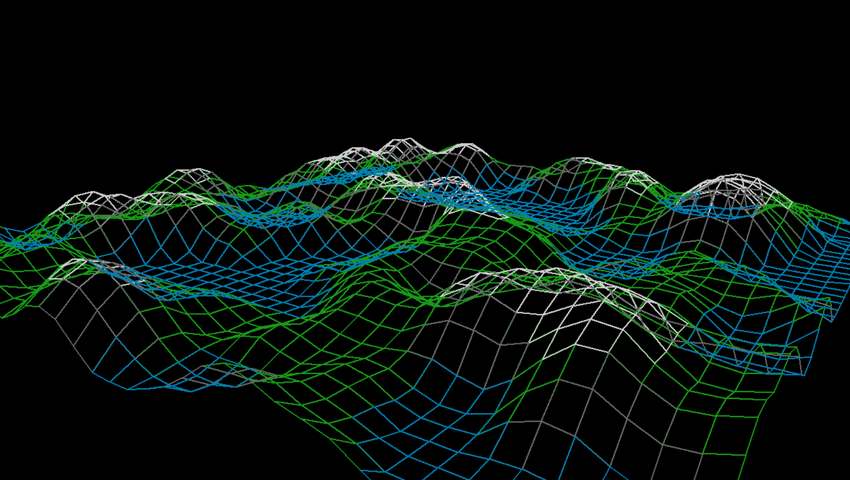

In [10]:
base64_data = "iVBORw0KGgoAAAANSUhEUgAAA1IAAAHgCAMAAACYZaxiAAAABGdBTUEAALGPC/xhBQAAAAFzUkdCAK7OHOkAAAMAUExURQAAAAUEBBmgGRicGAAFAAICAQAEBgACAAAAAgACAgF9sAAKDwMcAwIPAQGCthN7ExaOFRSEEwISAQ5eDhiZGAF5rAtMCxeTFwBvnRWIFReXFwEJAhN/EwUjBRFvEQUtBQAPFheVFgGHvRBqDwczBwg7CABrmRIQEQYoBwk/CRFzEQAhLwAVHg9lDxF3EQIAAQBdhBWLFQ0NDSwqKwc3BxkZGQFplAIWAgAcKWppaQpHCgtRCwApOjAwMAlDCQAYI1pZWgAtQDY0NQA8Vl1dXQJmjwBPbwBSdQBijFRTUwAxRh4cHRQVFUJAQQBJaABBW2VnZQBxogB3pk1OTQAlNQ5ZDgB3qgUdBgFhhxaRFQkIB2JhYgA1SmVjZQB/s9HR0QA5UMXExRmjGT08PSMiIwB0pACLxAILAgBWeQBZgQkKC21ubQxWCxmeGFpuWzc6OUVFRRqmGSYnJwCCuwovDASHuAUmBABHYwMXBgB9uqqoqXl5eQ9iDlFOUcvLywOJqtvb219hYABMa1VXVZGQkABDYAOBmT53Pgl+pw1VD66yrjxkPE56ThwiHAASGgeOhzNTM6KjooaEhru5u3RydAWMmUtJS5WYlRunHQeCrwBYfNfU1xyQIhs/GhacEwpznYuKi8zQzFRvUxVTFRQuN1FiUCJ8nJ2bnUhIRzOhMoB+gB5HVwSDjo29jQODpwRANDmIObS0tFp6WhydIKvEqhVjIA54pAWEhBKPNiVQJUtwSr6+vgpBFlZgXwVmXRJ1QLzSvClfdAF6tAVwmAM1Thl+HZ6/nlltawyJZR0hJQ9kQAqHdbPFtQNncgl6XRCLUAlTI0+QTyxvjChjKAV3dQyQdiWNtwZRPbzJvAN1ig+UYxA0FRtyIh1piQNOViyMLAckJ0+sTxtWb26abhCWTkdKTjNPWz6EmEVSRABklXK3coypjB50mW2KbGRwZDRzamCvYWymvUBwhm16bRSaNSE8PMTLxHKockebu0KWRH6cgJWqo5i9vnKakWh8hX+8fy0+tl0AACAASURBVHgB7H0HQFRX1v8bepEZylCG3pvC0HFoIh0BaSJNQLpKKIII0gRBKRKVIlUJaBREJVLEQmKiUeJGExNbihpjki8xiTHGJMa42fX/u29mAM337f/7dvcru/sOOvPmvXvvu+/37rnn3HPPPZeiGGIQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQYBBgEGAQ+CdHgC8N+id/RubxGAT+OxHgP0NCbuL/d96QKZtB4J8agee5R9onP9+Rop4//U+NAfNwDAJ/PwT4lPSaBJocHNYkOAhaO6tSU1OHpBme+vthzJT0r4QAn1rT39Y21TY6OtoyONo0mlpW5u0cUtfb6czw1L9SO2Ce9e+EAJ9POfdXtyQm5UwNTJX391b11tAlr8HJDAyx/vO3mTse+8/nYlIyCPxzIQBTRM1odUsonsrZM6clp659dCqRgsmPSuivbmunqP+c5e95C+F/gRP/ufBknuZfHQEMoxJ7q1ucKRaLyvDu77eobK0Z7o3gg6mohLrq3vIESvr/zx7CJCxiehfRfybXvzr2zPP/EyIAvvFpSU0ZdCYcUDhcl7OGWlPb6hiRUuZDeMqhNaWqbAiC6i8zFZRDJUdPx5yylsEWmgZbyqL/v7n+CeFkHulfHgFwis9USkqLBUGisL9fsAZqXkJtnWdYWZUPUfkS+lN6U8tD/oI5XZZkNTjx+aOqqpSUlOpefAz0VlcNprb/pVwkE0MMAv94CEDQzCH+88JGmrLoTx0YqJ5qKSsbbOnMqXEAF/HBU/2FCYMD/c5UqHNw+eDAGy2e0P7mFPTsYex6618neqvAUr0po6kpvW3ehcEtoynVLfl/KdezZTC/GAT+IRD4PRs8w1RQ7AanOqtbknLac8oHevvrOmjGITxV5+kgaBP4JLUP9g83TadU/bsjKiKgdNzcedynAxBOVSmdETXpqcMRTVXDng5+ZSm9A/9urn8I5JhKMgj8OwhghOMQ1oLxjZBaygQZMOvxZ2QVWGdwKqmpjNj6qPaq/vKmgSExTwW3eoblRAiGW8odPYfbHlWnlHWQrM8NqWQtrW3tx5snqlKamvodfRwoqi41lOWcmFrVH+Jc29Tby4yo/p33wpz6B0UAOh8/erC6JaeMDG96q1PL21JSW4ITyOMQWYV/Qy1TglFYz1nSCf29ra3Ra1pTxHLKM6cmvXa4ZjgMqR3HPheUVT/KycDxjCZJJJSpjaTuubGJ1JSUfgfYCynKorMqn48DZ0FbSqung3dL71ROIX0rXGSIQeAfGQEiT0JzUnr7YWEI669OqWoZHp7q7U0ZaKlzDKGNEXwqsbdNMNwfBiaT7k/xi4D7UUJrNeQU8voIvP2GhgWhNf2eYCLHkxrOfqPVbd+dCAUn0aIKpvf1+kZ94+83VVelVNdBPlHSLCqdZKcTOCelDtSFepanVDd5shgXjH/kpsTUnUYADOVcM5pSlRoRXVvbkjoMm3Z6+2Dd8CNYEFJTWqIJGyVBuAzvuZtTW+jYWlUb3B8CbmD1pxTgyzPHRzq4vBxDMb9WTxToObaXchiu7q2a+BEWdVoBNKjQzh1/MFGd2tk7mgOrBlEKHdtaHOjBGpFlFu2j5cNTAzADDhMzIkMMAv/ACKB1OwuaelOq0aCreweq6/KHvR2o0ILgsJzRlGHP4ZSUwc7OzqqBlKrhu47RdcPlw8HR5Y6QJXyKNZxSCRnlQzkOt3sXUtLSfv0+LMipsb2yCcNTVYcnWjq3vqhErT964PaT6emU0ZyOsiYohPTEsHMblEgwMyH4Xrw4vC8vx8enfap6mMXwlBAW5vMfEwGIhPQq6HhN5VO9KWW16YNVLcFSpFGHdNR0lKUWeqYOpPT29lalTpePDQxgJJTaL8jJp5kBPFU3EJ2UTxW25iR4BxOVzTvHGTAQnqIyRr/99UcU/PnYg2l4AoKG03Pa/DBaoimp2nGGdfjSCd5JUjtqoSBmNFX3C0sXpWO+GAT+URCALY+254UMV/UHp6a296eW1cKcl1/W3pIPQQEBklEg6BxsS8EcUhVY4olguqltOL3g/SZBcAS8JfCcfH7C8PCQdGGrAO5JEUNEvBQEOziEdAjG9E0q9rSXT128ePHDNz6Eu3pTU1PZhy1+0YntHUPB3g5rOqYECTM2ej5VO+xIra+vtZCmCgdTBqJnmO0fBUymnv/qCJCV7UIMpDtaqltD61KqBpqg7kHA1EUXlk91wnaHFNLpYfffSOm9OJGSWt7f/22iBUlR2izwLBTKKYipofL+guEIwkwhhKeo9GE/v/t3009Irj3S+sttwdj4+K6je9esWePg4BBa7+eckOBTEDaUI6jJSQxzENouiCIYUk4GZfNOhuEzYSglJZrm2H/1t8Q8/z8CAkQwidjJwplQO1Szus7egangNRTFohz7wVisgqkUPxj6VD37W55Mj16cmDhcVZ4+NnEFTyhN5Sc1N/kUYgCFQVhCdE30cFI5fP7wF5JTkNGx7zVB0m4lilq3dfgXbvztk803Y0W4qF7ZR89p4WdIRrrAuzynAMVB2PH5DuUCjKukpXfnZRBW92ztjdbhw1z4dyQ8uOjZRY660jMy8u94F6aofzUExKKJSujoiG6ZagMNwDOounogJbUWPAQZ5Q2DG/wkcqqagu+erGvqr0vfO37n8Ie9LeV3Cy7WQ3g4eHuqvj8RHJbkAxaMrnFMHC4M9rYgFzwjBHkndyg59newKOfgvAdcIwntdekRnvNQojRf9UoeligKiaIqax1CKlujYasgPk357RlELPGVdiTSt2eVP7Cd93d8ObK0Kf93BZIlKQwxCPyVCNBtGUxgEVxXV9c6CIsD8ViFY1BVyuFf0+tSp6rbBBaF/bVr0OzR0DKqqlJbhvJhS/Diavdph9WUp6bkd0wMZzt4B1N8nbCqzjCBz5roJB9BqzNl4efNokK9x04UntPWV0vwqasMETzhWtt2xcRSrIx99aXgl3lXamYMfPBiFzhS8rLp7e0RxE/Qs64ggQzNKPmEu+n4wv0r1trHQNb9/SghNLouIroOtktCdf2tg9/dkCIS8u93C6akfyUERN2x41BrW2p12VR1LzzBwUz0R+o3N6g1zhntnVUtAgF4COTZ2tbq2NFsjSGSxrgk14Znkn63eWKgc7DsSZ53KPFRWve0M6zGT5BUWZMBDnCOcEz326HHolQ19JWV3bZ+l/PkQK62tQZRBymL2tobLKGMEkHOZ1UGs9CYpUPTh5M8qYSapAQipAgv3WjOZ8HGzpdSk+DYu1HU36r90flLzW5keHcO1vkJpjvRoaBLKauuLpv+8Lu7lmAqRlKJXgvz9Z9FgJY61BqHBL+6UYgmWMpTe+EB3p848F1r9cAvdx60NcFgB+r4sTzHO8xB2rFuqi6fSh+6oWmd7ZbGHXdnxTafVKIsCz7/sKWsPR8NX1aa0vtlcCgi8ccdaJMULArtzS8Ku3y+bZf27cTyX+P3mqrSHAH/dc+8m1deI7qhkGCNENCKHn6+mNSe2F/uKB7X8KndOcKEUjEmpib6saIsf/2XrJSVtT23PiIiRyCo9dm3ly4perDN2+LVBxdTJ8agXxIB/tffgMn5r4aAsPdPj26aauuFp1FK27fTf6zrD+t/1Nb25Erbxc/7VPRYiWVl0WFhjrXffZdaN1zgPTqYD8sdBkQxEjxNXclGeBzd1zZFQesPPBX0H74hhLDxab+gfajm5A1VfkZlZUfEi1J8StZSP97a5kRiXl4NOEzU/SNjYd79dLhgCIlPhfrRc1g0DyZ4JpbjVnQ1cZ1fWh8tsgTePHFjrYoplLO/QVa5mlZocnVN9tY0R1QWDHV4C34sCAlx7KweJMWajd8cbps4mQ/WZ2QVgZmh/yQCoYWtdW0Xv3lQOzTU0jt6V1eXNCEqcSBltG3Cy2v8hnP58OBA21RKazvsFVNlrTnlECHp0bEx+trcrgrr+GwqdN8VE8310iwdm/qhsUfT0dnZbiYmmkf8fmyWyijIu9sRceTmvA5vnXkxNlxNd1e9fXl710UnOoslD6x6IX5+iVAYhYzD5xckOojrzqekHCOSwuaIiXn1lVD9qNCwmsRme8kuWxtLHST+KxTA7GwrE56RvYYZK2GrILiQsHRIoWOiIELQ0tYy3NoasnvcSO3E/dGmJzssLGRpJylGXonfC/P9HyDAp2JDPAebWlqdzynrYVAzUO7AU3YlBriQwafTEwMDeUemU6uqWloKLEJay0NDQy0sQm/U7xF0pI9pahtxuNrnNJUtqVg/GBiMKqSlWentR+bd+Lb6V3uuru2RSgfPk+so1RN5W3dJSsQfSTppv7ZLIpdnX+8Hu0JCZaJofERkUUHiGovanALaRxZCKiJ/ht1gQE8q8BHM1QpfvJ9BhaZH7DmREDb0grUtx15bwyCbPCCZmgb9B8/67GlZys1I2YhjEoucN04mOdKaLUmSsa9534u7970xMfHo0cDTOwfqh5J6H7VNbMWoSkizU3biM8w3g4AYAWlqXX1iTVJ5mGfeAQOW4+hAO2WmUoqmyaLaB6a/MdkxnZIy5e3tSdIXnvy2XZhv3rkjeUm79L1ilSRjTCR1LTV4eXk7LDXSGqnQpB1GapRD5e21GtTuxBC+Q+LWGE4alyOhqRwfXx/RbGJmZeVVn4MZK1gsyBddIPTGJEcKNvak4EJa1yvwS5jDGD6C0IRaiLAZVlE6+lpYzZ4TGOSwwgpQgqWXNdfaxpLWAEmBM/NKM3xJzj5DkGlukjY8rs16ipq3wzunUqSFwkrDH8q5bW0fb+9mddc7uC514NHUow9Te3urJ/boYTZ6jQNm54S3+M8y7zM3Zn78syNg0Dxk4eDgE73vx3a/2qTBYMoqTUMaOg4VNpXyTYVS/cSv76eGwCwnLQ3v8dDOdhzBnLdecyw/IZuS4th7aeora45zLDy9I/bdzt1b6Z3gJGHDoub1ub3y/VZ9e+Xbe26nWZvom+iVurq6FkZ4golCknwId/BZxJuWEOaDE8NoY3UG/Jig8YUKPGf4B7NZNRhJOdTCvU9EfMripf0nVGnmY4VhDQklnV3qbqur2WiZkRGSkeEsTvgff/Op0sa1jXwlDZ6k2om86PTgWYYN8U7ap+/u6oryQWtOHLjy4pXbdw4f7pyemILPFDynxtILRKPF//gGzJV/SQRkqVL3+g7aRDBP+aajp19EROsOSTVoQOColJQHFar1bzSzVB80FcJpYk3iDljmWnIgwSjq1bx6jhKlaq2poTLO1e5SQfNjOYYlnfz+cigl55ZrKmN4/lrRxnEup7GvecxEZIQAxh2Y8U2IJhNLNPnkeJLS+A7BNZjjpZkqPcc7lDWEkZSYgfh8nwjiepGRUyiSOfCgPT15z5eSQxlIVVBAfJ1A6zRsDwiSIpIivNNB+fnks1AacctYGHk9P9Jar6lrRTJlqxzJ8dv9middBPh4TX7wUM4JckUoiWR5tsg6z81ExbrvQCuc8ScedU4NpEyXD+etS1gzY1ARZmA+/08iAEVd2JrI3M5/MynZvk9MadJ8SyNwSGFEukPl8OfE74cKS734wOTG2Bu/otWqvk94quAuC+ctBnPQ8tfs89RT5qlWxGu83sXlcnV5r8yfP19G/sXvRyY3L6Cyj7/uEnlmw8jrbkoauvFH921VEs15SfNDa2qdh5IshCIInz4wlYMdhhIJR4HIRFRwRO1btKJJPzx8BP0KyBVWOjySaNaRo14u/vRgsqLounRBAT25hZZ/NK/QwcLCISS4MjjaW4DP4GA/b2/vWm+4ZzxDei/e5imRwmJttRt3n8wLFs4jI7yTX7Cz5x6MJcXJYySc6DcipWdif+CX6bvDTQOjLY7OgrLBptGypm8xU/07bhVnZb7/lxCY1ftxJJwgIoKAnl78b2YqV9v3C4QWAltdJWoNrGrU0R3txK8urGqaG39z4o07yhUaUizWg1HH9GZTtDPCU+2U6tZgWDXsdZU57xq/bT9+/p2r3d1nioI2v/PRK/XFUSUB7KLkHnX14zbhS3dJmlEv5uyeETmUhbegJmT2J+VdCZZ2hgI404YpB8eHRS9T8jP9iY/AmWZBPq3iEbb7w+VVrNDLQYpETBEqKCCWQr7U0TwMyETE6vAmJVh4eno61t7fZd+YjV/gOvyj9GwkTwpOhu3OlnXl8aykqN3t0SgWyZ2HoguhhJ5AaSJ6IdeKrpo0Zeb+S3XK4e/W+fSnpLS6uWt43ZioTvkuXnOdOCnz/X8Dgd+7kIX6OA61tDS1lAV7opmh255tbH/PKmO41Gj/fhiZ7pGlNHiqVEJBooWUTe5658r+joKq6XGjA9NPb85TU9HkWesZfNe6x4luZ9JU6GD7lbwQtDmzvp8+VtgQuWVjUdbXp744avhJlvFyuy0KG7KytF45/k53yScbNx7aO48MmZrdRNY0iJzKGZsEnobPD0mMZjkkDq2ZacOUPOXwZuQ9T8IkJAUUzgK6Z4EZUCB0SmJ9pgUJ9YfuxbTqhySQU3gOqb3gKNrgR/KGwMtDXGj01lgnXRVdJ2Jqx9SZjXLabT/ndO+82q3ndrki1Q7vPT64kDDk3QHTQ9ge4h0FkpWlXLkxOFBa766im7b2KeJ0ll1swVLMgTt3Dtz548ThA9Ze9lwTy9i5dor/5m6QVIyhv4AA2KV2uDwnJ6e9nFB7und7GbwXetsSpyamU/pJCEnS8MRt4y+U9F+7hL6aH5PbjDARMEVQGmnucIcVhFA2kqZ8N7V6weD0eN/4xDcm2bixgYaKhP3bX5XB447cQ4Zl+S00MOpswLsXtpwZ+fjdlUs2qasrbLmw+Z1uhW5j4+Jrb58O+uRY96RC8qrjBsJapY+p0o2UcFTNUKLYLQIX+dLOgugC4mMuTEk++Z+9tGBzw0EMysgPylMgVgr5GbSaKJffsIKS47O+nFwmziQdViAndWKMrCOmCYuQwaoENmLvzrh/g6KkrDTsMXpSda8wkkjbtScf6TLqxwQnC3brrMtzdGr2kfYMDnNGhtCaE7LoZsBPFOWqa++qFBNjy5VUc9PQdJcj0dMifnxweOBR1cCjp/VmVjH28SDeC0JThvDm0DHmPI3oHPP1P4MAMSQnfVg2Wl1d3VuGYJJtnfeH66amWloLQyjPpl+udI6WjQ76FKIyf/d3pKr3gkTzPj36Od0kNSidF7336amlaeryxnXP3d5z//Pb009NsoXDBNV5N3eOXH/sTPMUn//ivrrTAVrmO9kbkpPVt3+wbdtC3yj2yBbjjYfOn09+5+jx42/3ZG0o2rliQTaHV0rX3SLxCmFOcFRHRIi0d/ScjhyN/7W3PGVmnw8nJjdT0iXqly1IXr6DH4KTiYhfCesG5TC5CTVB6/6sYZvwAnIXhJ3YM8NRYKSwJDj3Cq+ygrdK0ctAlNy1ObppEuPKus0dgN5MxeiGBZFV+3K8Q67crwyGpAIHpo+RSoNU9fRs0zQ5yto899hYlrSNpug8NU//wJ0DB35VUYlRzd69e0f+lTsHfv2uqaysibzDQazxYuh/CwG8cs82rDCy8GtPbWuvsZDKb50uGxa0EtHEonzK3tehgtufPEr19pnTr/9dKqtjxZGUbD6pGa/m3qjROG7krmHSfH+X9jhXOabRlFJL21UfkfRAn7AB1B95asGb755Yut9lEfzAZVZsvvVZZHHm0veOjygoKCRvOJOcPJLJLtpyfsvxm4eSFZb6arG7FRrOnzJ6QZoVa48pLsJKIXkYThGOSoIcKMSyeVFrJzyT0DMpEkPCR5M5uNwQz68Yd5nIDMozYkaE8fkW3t4OCaffREXIJYv9JfJydCZoel8+RNcjKpbPx1Sx6Aefysi7gWNZSlbJjScxrq3J5UFxpSgrSX1Tkhnri/OO1CQmCQqIXZFySNyNLx2NRneOtrbkuEpjIyauQG5r1xF1gZgq+JSBjXZfn21a353hckHZI9DAxDdPv8lBzKe6gapOKKr0SJjO93f8EN6eHnv/Nyguf8eK/q8VRaJ3jd7ZS9//RZ+yUewaU9bkXRha4DcExQpL/S6+H8uiYiMG22vJIOHvU0+0B6l5ViqSt3fVh5XGxurzdJXXxnNU7I8IfJy4unqlGPTE5HLTxvMimjWEJgM5atFLrytRrJfvqZeUmLtcb7h+/XHxZNyhkWS2cVEyaOTSJ6sy2RsaDplvONN93Rgnfrg48e2vB6BMuuZqCBtXx8n14KhogTNpkPmCWRO5HMZEk2AeIWuQZwxtCJeWo+SkDYMavmRRCX4FyCEicFGOz8vFC0VjKJZn9wqhNooLp7P8X541aYfNWOHh0r6VRYSUgUp8V5ekdm6axK77R2zd9LmNKHVeqZXKlZybui9ahFTWwjZY6FDQbGplr8JTUbF3KzXJ9VKlby0rq6dsLa4FBb3QVsWKY827M9V/5EnOj78eOHCnqy9e8/22lPaMweqU1NFWKSF2M1n+1gOiv87AICzsf8Ag/LfW+n86P6Yw6x69r0S6PtoCsbt/7HAd3ShChhKJVg8RNn2lo11QECJ1Yo4p62+sp6wBXO+ONEdERKRDiZKWytbXNJClLCLCqAqeKyk7JnecG3P3/pX0PbBkk+HTojffnXfWNyBzObvYuIj9+E+jP/xwPdl4QzI7buUqCCqF7uKo8CB29+MfQL/9kHz98rlpeLMPvPF5UjqlFu+ExgX1bd9WIqOIrY/ImmAHEZ9Azbtst4gIJBFPyVEH39xGfshT20omv8Rs8FwRxuenR1zukZmB4LSLITkmHPWmb0/xaTwR/dN5RhBi3RVGUnwsKdHkuLtrWHdZa+gf2bNrbe5abqOGe6MyVzfmfnQCOA7VDEnP907KqZfkNMZo6FBSVLYu2IgeU1HgISW6bOGHmb0elmi2PCr30VC+Xb7ntru7+94HFxFDLTW1rbOqd3D6u92kwL8HEWaaY6HyzBEkJtaIFtjMvfD3uNc/dhnocwoHn97WEWkIfMr05Ekrs8P9wllL5w7vIWc+gjQ8+XEoBMYsnaN5O2A7+9sfudT5aPPYmHfeyROJfn5JsPdRBmkw5SUURFg4SWigGclaakpqWsUm3lWi8r23rqe2LSrJND7kUpRlvuKVo7/ub1BQv36dyCbofFGLt80PT84yPmM3ef16lsL1xx+P/fC4yP+HqYmLiLWH6C7YbKD89oF1hKcox5rdGEfRjwA2ypmRuvzPlitStJJHehZpef7Ly+fzxSLLY/L0a2FzHxoDqNPE2ickwo9xhuQYHLWISpjvP3kQTCXPX+NHXNWFiTCSYlGyerZd+uiu5ilzEqQ97++S4IBUVFQ4BpaujkkhEJ0iFndIv39iPd2zILfXWkvhYJKSdYMtnfCdkEwl1fjUvuqqfhhmJyaqB73bEdE6pWpw+g4sgUd3YHlL7+Ed6CzF6f/6b7GEDnEszCgoIzRaBnBTEUXbp5B0u+hPnhdff/3d/qFzogdLTHn6Apo0MS1J80t3NDd7wS59uBXzRORVhHQkpTuWJ1U+uUKGzHzZvWP1fzNPyVJmRwT3O8J8YnLN0pNC14RFRIfoKXOyEVUvJ8MpzQYucrKNUI1sX7n6FnFSTQh+d4VLsvHOgICeKHWFzEsfv35qI2TT5k2ZbAgndrICWyHZPPydr/zKqutW//BVULH6maCVlEV5+WBvWVNKysRF2C6relsxBqES4NeXKOQo0giGZrjLczKckpdWdCEDJ0IJ91YJD8in9DIF45Vi+UVOQE2cNA6YmY8ipowSCuOpLxsWQKyxFgSo7y8Eep454vEXhnEQUtIvSEqYgCP0NDk6lFtzs4rbHAkS3FJIWAAAIABJREFUFi1u+4Spw04SFGju0eFZ4xgkS82TUJOSxpuiiZKKt9Zh7Z2eLo8uH24dHh7uP/n5wMUPe6vCnPqs7fvS7K9cRLTQgc//5vdFjw2dvYODa2vasLp6CjfrH6IyyqK9ywStram9Zd41GD+C0Bf9HdiXLuof+MO5ffoO16s0lvSIfL7r+517rNDUqBtE9yOaEjwKcpISC2WTpq+Qp+Rn7x3baqnzNwJndXuPI4SeEtc9JIn0/hl+iftuwjIW6tehp60mRSmZ2XIluH1f7J/s3uQbFxf0prFxSc/Ie7jrkvDlWRu+PmOcyQYTrVBPTjZOdjn0+vz5Cxc4dr5xcTqfNdSb2vTD+5doCeJc9sbRkKSUix+2BNf/+uCNw7srOBzezZqtSjPVZxUkCRu9w70ASl5enq8Yd8vZoTAjo/Bg8ZchnnVlLS2ddYOd+Ql26pO+5PnFxP/sTV+Fkhkug5p4b5kcldGwlKiocpT0ooCGzz618AujNVZk4rOit6qabc3bM7YVPvQ29q4G1s0nrYQDJFKmtKxFTbqYpfDtkFSItZOEZCkvbaGQkqV0THjZ9EnhlRgjS+qFB6n3PYXn0utNK36d+HC4dSDdlGO2Xl9F8sBEb8rwtxP1cn+TlYKIn5CINkh7bHLnk5/vSN+usCWYcmgbRL/h4z0KG+NgvtClcQbb2Yr+Kx3xdXaMTt90b4TZzd7NzS1b9f26enAU3jDLieh+GHBgmijfOakyg/Kb2POqmyWu7M2LOCo0Bv9VUBF/vl30kEz1nH2pdzQ8vdF2tt7382RRCJpnYi8nZ8XJzeXqX/q4e/9lqHbG/iUlAQpR6pkrfVeGR6qz7Tzmqwcu8DeGa0RxUdTSlTIafW6U5/BAWcvTX2r9UhEnNmSdkY2OPFWYOnrTlkX5IbLzaM1eNe3DKQ9szViskDFiSqMJTVcQRnesBxsWStPTXc7XT7dj9ePU/scYj/SXt5f3VreVVf9Za6VPt9CZT5jzD8VnqcDlIts5TsklnM6kMvavkhHqinIUP/zNyYcPP/uDsIWhMhGvWo/nNd/1qY1ITGreuuPIEeK8QUshUiKfn4/QFuLmCNTzLMW/lFSsSTL81zFZa+2F9yQkL7Uufcr9XFO/J9EfqIzo5nVWtjdSH3Gy+1PSnTiq8glqfQeepnxb2H6x/q+zUkDoEMLN4brc5pnTOyrkJqrAzzt4tBXnM8hGkjBhSXcgMH3KqF8tYlbNGXCRa/9KJEvxXeur23bgfaqaWlrZ22ue+/xiTj5OE56iTA/XkfGUoyCdRVn4ROz4rqrpwFquLcdEz6o+b69opui/jheUF5W19cHQMVVVNOc50ooXOuK+vR2C2qFEzxiul5lufPz48WP+ZyInG9SNixUUXDYrKgYWJ3c3REZt3Pimln9gZpaLXWSmgsKZyE2LSA1eGK9D5KS2ltHRR71NA2UYq1h1reM7tjWF6nD1EQhzEEaKlsHmXU8ffYunpSpPxpJchPjSjgJPisUPmSRqXqhz/mBTWfdXo8PRf1R4lIqYmojeMpqTEZr0OOst6ufiJWKZQ9F+EwvMIxfRbEgKol6+99n+VSLnDFI0pVhiHBk5Gefva7gNsdGC61Xi6/POxSp+6vj27eb7foiF4TgzY4XsDhHpc5SmhNodqmL+8kozoDVAJSsVCW2evbL4jyepbM3R3Yc4naTZO94PUzXTVc1JvfhUX68zpf8KwjZJu8fr/vqon/L58FvMHYi6Ebpu/4kPwqZCcnZsneqdau9vqWpK9CYBZgZTqxFhp6lT4BzanzJkgVRwHKE884NTESbDD41HXPX/xG3+iZKg09OLiT/Q/m0qFsYSYrFuvtF0Jd+7lqjFgEgopxxz0vHTYOwJNmTP1teOUVPjcZX7jowdNSB5/hqax8s9UhsqTanqKusliGZb3dIaZfkhQwK/K2s5b5//+NS7IyOH2CtYr0UvCg9ks4uKotSh4o287qomofvKqmLj5ICAgM2bkot2vgobgDwl/8I3b/zS3j7sU7r3adXusLqp9gxZDm/eYBMmffRU9NK9y6p7JyYmqqa/Sa2eGFsHf596PeFwm7TFAnSs1OkelqNfYlPKaHv/YNPjyyHUPf/2ptT22sHezjV4yAUKX1WVO37mryjU9DCSajgL9loQ2TOLAOvn7gCRjKJPylNB/ttkVgZuClJQuHV25cNrX3zy8MLIGYWoyIafOF6s0MRogbezODssQIniYRdB3/H+OmENIZp4+lJEQrnxJG25MTo6LPGfE9c0RuXcWL2bKUpBGGrKilfqnDp8Y/qpvVriaMuVm4neNQ++w34JnT4+ndMn/4sjKlo2JcHRtzYR+z8ODFQNwMaT046o871tsICQnVare1NTEWanM9gPQBOSGkwd7AVQpEf+VySlCvu1muspy5MTo8N4tdLUlQnYiSmL/JrKDHS26NRMDw8XgqNUX2yemEpyHvJzXg/vBqrUaZ0br37stln2fx01WUqqkWd7JREdmyqHF8t3zAmh5GCskIiRphQVFyS+de/C9p0jG0ciG0YOJfsWvuW5KMAuUmv1m1lRkYSn3jm0/aPIIrb/Ytx5iXHUkvdo85eT9YOyK0awqWTrH5j6xciSFd002v5i/INRvGiH0CfTTVWfp4d9MzFdlZJ6EcHOJ6JDC2tOgJlExjVPgV/ra1F/QviYtsECzzXtKS0/+1/+cvkCqrC2pa2/briu39G5J1JRkNrUsX8VBCAh/mdaEE/ylG+yyL0P5+RLjHvoERydgpKTX2G8gj40XLwsDt2AVmZ3g/kSj2WnNi5dp4p4GTUWzrWJzkS5JjwU+uxIqnYruIgQBHgueq9sL5Vca0sbzRnRhfarr6umv3fP8F5lnrWGZ95eyoxTyhdUeXo9qJ6Y7h+tLvvjo0dTbVOPiOiOpsoHfllH1vT/Jwn8zPLsn2qrgjjqBT+lTLX1twsGq/rbsVvxFKxAPulhYelh6YK21N7q3uqy/rpCZ4eE/oGC0LaBgTZsuyruEP6T9/unSGZqnZarbABOQkihaWw/Jn9lwhuMhe7FId27MgPfLNaNJwIf1a3fVjWVY8p3TWWi417JdeTh+dnztu7ZpRJLK/j/JTSkKrim64iV3onTFSPt7NdBpnZ0OLbyy5YENSw/k7yhaMMFjpqpwYXkM8ns5CIFBWPjVeHLtZZuk49jK2xgHzt21TxZYbmL75KS5NXLKNmKNCvKqe9BWSHlnqbhantgojPbZNwAU7kto0+rnlDpwS2pf/z2Vwcw/9FvYEw//MvTw1UpA1NtdXt20NX28Y5urxoUdF5/3NpSjUBEVEdq1ZAMtWa1cVBBWKEgsTzapzO1KfW34svBleVVqWX7VwuZ5g8NS2h5JRPIJuwNkpPZlBygELSM2Cbo39SC5BIILTlIUUpJ5YszZ9e8N+YJiWd1YTO5HpqYD6QrBUNofYSlQsQLTXANPheCF2lWww8lFX0KKp+k9TrpUu0YMqKiSZYyHeea7D3Z4s3XiT13f+yckxs3xiBj6jCvb+u3WKV4+Enb6BXdUAeHozdv7Hpa7U2Fdn5YryPK/P/7IqyXP5xaPVVbRsd6G0htgRLQNFo+WNY+2lo+3D9VhZVjhKQyUjsRULt6qik1tbO1uoaiBFXpnb2dWEqAFvSvRLKmHK6mJEI1ELs5n9KDpOp8IxijTPI+Ial8EoMJUzl6Dw+2PBoOQ3cPoZVQmFi7C2sviH8rS2/f/Wae2n/2HQmxhThS6dK0OdnMU9bu0rS3t95TW6qkpGio//FHPVuKi4q6R0a2vNnQ/VGP3SFjmMUnT7+8cP5iLXYyW8HOLk7BmJ08cuyn17XYbGNj9Sj1zURKSMVo6sdrv/GjlJL7uJFy34NUtFM1CSd0DZ29VU2dHw58fnedAQSYbMhg72DY1sMfTn87ndIGZaVuuB+RJ+vapqbaBO11DzOh7PpAa6kb6Mxfk1H3Z//u5Met5f2do00t/cOCjltft0+NjiLSbdtXqxThsgpzn5C1KPDUMjLAkqcWGftS87WMUS0hKa5WNxSyl2yM8q6d5nLuR/zQf2jsXIqOSJpPvCoIpBGYuAL3SHd407wlypy+B90VIVnKimtgZZ+rb4kf7rSnIn0ejdm6CxzVOQoV2sJva6yGhL197vi3KXf63KXWv2Dkbm175MOyK4iGI1VhYqP9S9VgXVn1wLd7RZn/8heq49lfVV2d2pTSO9VUN1DWXx6cgejZYdSaMO9OYpDIKO+d6iR+IdIWo4Mh6YltZVNtwW2pU22DdWGprWuC23oj/qUElSwWwUpyNHRFpll63Or2oOWBF+mcCOEbkio4wzOiefzJ9A6cIeNN/HOuGbttDaUlxDE40XvfnuY0G/KmhSScKZn9JT6a+20maRtjfSTCSifW3l6PVXolacfxSx9lZo4oFBUfUz90+ftduy6duldk7N/TExCJadzPli1bqaXAZiev7unpCQxwwaiqe2MROyhg0wJFuknD1KGcxj18eJe9PTeXa/Prowf2jaZm+pqmVHDV4fenp+s5fbq2Tiq6+e2pH94x0lUxunN4+sOUum+x/VR5S/XoVHVqWGhwXdmfupdaRP9bQWVndW9KW1NbatXj4rdOm1//oTY0va7OL2fqT5k/9HvX5lRNDfeXXd+MGdw/dK8UP5ZMZg9todjmr2UoR8mEGy9dRFiMosKLPIRp1lcYndsZueiF27Vw9311OzgKUFrAoYOGNKQG8TaBKCLazsJvQfugE0bFWl9Je6413EooWZa+rbBE+nNdLrS+DqxtpkLzruits+W66/c9qBpT42gq85QlcrH099epqqe6pXwdNW3b+ovT098Otz4Zf0FvThH//iEUlTWtj6pTh4cFOVVlda0trd7pjgmU4+hgAnrZ4MGmlJZKTypjeADbFVvgRIozJeXg099fllLn2Fo3Cs/4fCpBkDLq8+8X/895VpXTaNBoy7MUmXBh1Taxr9B5QVlfT6RXEEkV6pMnuH/OVEqtz0psK0JL8Elq1kivTEqMLnSep9t8clzSS+oZjJSys7OVspX+HeklS8Wa5Kqx6LVEShyVWEVFhy/3vzOy4cKljy8dSlZnGx/av3/7ToXlgV8+/DfcftHiL7/KjFoepR7n4eFBO/5k7Hl7GY7f/uIomFpEeiqS3G8Pd0k0VoxrulF1g0f7urq0bXPjx6q+MZNaH78+dO+BrgMHnn7Ye/jX8fED46ADDz6smk5NmX4/p62pqSpltL9q8E+TP2RN/jbVNpA6NUUCvPb/Wf3LDOeF3cW+9F0Kyx8vf6uNzMqkDnem/MllWQJFL5MSVWFJcqCMnNw2rcwF9AlfBfX5tNBSXw1kYMFYdWj7Mf8i857t+28FrrLbKZRiEFJkCpuoBKHpOZg9iPZbM8tS/HwslKJJftnqY5esDVhgKFnKQMIMbZomWUwWm+wdc+wYdWCFBe+A2WY8bRdv78QgvBmdTE0b7e2Vedy1B75JOcxx5VP6Ty/ue2Gtins25d6lTLjzLxB515WwkE4VOAiaUuoEnQJvTzAOX7q/DUExYCDNyUhvSa3q9KRC2h9Vt/T7RFc5E+WG8qmeSi1Lp0KHhlMufrtbx3OwahiTBOIK/4U7/hNckjW1dafcuhrxnkRUqmwfi+D2pSqaseJT+DbLvT2UBKdota4ZFxiMWStzkmo6yO6BMKZxm09yJXTnEfWEyjZdZ+pk6s41Amlqc0xNcVpIcnJy9ME8XpeaPLV7rFDWVHd8xeZkdfWioqJkhZGRhpHuomL1wHsuPavtlijKsUIEHSw5LPPzkVFUlFGk2QkalEPEDrrG4BQJd2GzwMAsN/6b0RtqHHteLmdNTmooZWlj3Td++/220Tt3w4buTKTCJPUhtpuqevTGADFaDSDCENmQLaXqUVn7VC/xVUr5o9bDutNByb6edTntOR1h6R0PFYgt3KfqK4VwPjEo/lzkS7Fqewdbq6rLqlL/3P1nz4YlcrQkwnPJwU6ykqLsohYItTzKMEhhCUSoizmt9hmab4xbtdyYXexyqKgoSz0uXIgJ5Z1Pui0QPvNzvNNJWCahdMMZi6QTwmOPoI0bu18RPixF6apk01nIh6yaUQxcH0e9+R1jV5wq0nLjK1xlO3rTsaswGcRk62TreOmr9D3ofaqr6vRt04N5lJtKGteq1D5XUn+2lJniZg6QNyMipbqqdywsNaWpPBENABYZcIZnSg0KRt38HKgEB8FUNWbDnIcHqqtS20LJLQunmpzDmlIwxEocDWsZ+MWZNVyVkiTUb2ZK/6c8wOtx19agNOBGJyQsNXDXJYYGkCpHJYaeb8LJ9Tb2FeupkCG/glCyRBv5SJfqMCQYQiBJ4Q8dNW5zs32aMlZ+Z2tw4tMk7Y1szczMrMw07CXSJK1t9C2zFcEUpGR5OR13XtcL2JVpa63ie9cuHNt4dfHBh99/fGGDQsPOLz6+9PaS+SGJM6pPSBLiUAx5i3gePg24Nyu/WU9OHoN9OSo2RkKDNAulilwJ/dsTv6i5c7q6xvtup/7ompCQkN+cJ6gZvkgWOjz65sGDB3emp/D5oLKjMvjBWEdL7+EHD97H7/e/G7v/4HDVg+nfrv/g7ZNeeU998s91+RloPy8b73emWAmDTc6+xuGK4KnA4pw/FFQNZ1PRTS2dNW1fXf/KXFE4LUwejaL8tbYtY/uKGALTUbBtGK5QWEbJQA8033hUflnU8iDfTw6pR0InpAnLPMBCQpbCFwLgvnXvM2dFnCBLRPh85/uheOQF8L66+so7V1VFqoMT10uECApxlzwylgOTZGFYc58yb/yc1e6wgrBh2nILfyXhbahYs4oHKYfPHe50NbFxquBoanLVGo1M7HkwjoqTiFKKvsA6Fu1N1anendUTHzaVlw9HBJO+E9LJorONxOmA41UEGWTDmtI20O9IZQhGqzAfnkFltJFNWFmtKU2FhU1DVEfL6NbsF9tTOqH9keT/xAQkYzAY0kBsuxmySbMS62nSThL6tCInZSJB2Awv2Tm6MqOiz4y8ecx7RiSGsF5tFkRjFxjkl1LJbY7WUOmqMFXR1cD4zFRKpAUqNfJ4+hyETz12pnv1Mg9oQlIma/vcDT2WvbtRPXJkQ9GWS5def/etCyNbtn88rm+iD3s8P9ovASxDagVPbEFHRoQjYSURwTfgvpWU8OXgGTQklA1UseZIou/2xJhJWpdyhY3J+MT0zZv7/CKG97z/+Z76cwfGD+y6qd+nrPbrxJ2++C3vfgqpaaJyomrYzNbITcO+L155154jH04bfbHxTxNPBHnRIQu/vv5nIpT4q+Jq/UKp9BRYa8LZmfNhufvMb7C3lQ530ZqSU5W6f8N1b9oeTdcWjuouUeoBwopCImOabKFWFFtryXxKfpPxzvcUV0QZr17psuGlZYYzcogVLe4vSDY4Hj5kv5l876AHpBuRex0nValFAd2HArdlL+x+lZwjPBCjIkSXcIx7Lrc+bN+edkFt8+3bJ/LvRyR6Rw/5eT8pKyBSSsSsSCdl8qCq6rCySjyXy9HXW2fUpcxV0bAm/Sku/o6Ar2d/dcrg3d2pba1J7f2tjp7e9GSDNFWeEsaCIUsaCzHbcQopLSLaevt9wgQwolenljeVQVbh1o5NKeXErSKh49H0juza0dRKi5n6/O5+/6dOoN8Q4fZfqhb0cVvwjIaEuwhSWcrJWttsThmmmrZWWMptG6+hRM6SmzgmRR/hWuHAeSiCLPWQffXI/UpYg0FmRprNYaUxRhIS66Bs2Go2KlFSMFPgSqnuuJq0pdUrK1ZGdhdvWLXpnQsXLmwyh7P4GYVuBfXuhpGR7m729o+P89ycSHI5+ZBZn3DcNSQxB1tIidsG6uFQu5WuDLkrMhhwlHW7JButjl5MpNyN3PX4IWFjg605OcNH6n81Mbt70lXKSrdP20BKjXdl9K4Xb/x1l6xDp9Yp6U73Q7iZjN89eaQvrW+X4Mn48Zc83Oz76vdoUPy3shRK0KaXshc4+Hk7dzYRrvHwV1gWmKnoU1cHTgGvY8rrt8fqk8XXezYbEvFL9D85Q/8s457AhVBTSe0oGcXwyOSoKAXzpT3solMrXYyTFTAp/X0YGErYR+Dx8LBzSD7h3lLFJUsVFIICDzqw4F+723dV5KEPXFGW3VUdUUJiTAcRtCh3CUSDUtNtThLkNCcmIoqno2MGVNU9Jz4faOkgihpJBAKAYxMPxrkSkuMSMfhtqpnG7bLhu6XRBkQ6yewHRFRCbQrYw/L9w/2C/rKyGvANCRAKykgdFif0qRUfhYCdRvvr+vsx/hz09gwbymDBUyUnNaUdHEc5tg4c3mFR19tSSzqj/9skdhT5a3zpTXXV5hm4p1WQJ0Q5fL7VuEkpMYqLSJbKbuTGIPwVGEqoP4B116TXjh1xSij08/Mkb4tP2dy+X4kglXgHjfEaJ/dxrDRylWH7U7LRts0WFoRyrGx5XtmUjOWrnC/u7ccawQ0birffu/d9/VuExi4d+f7hcf2KWGJpoG/fge3XxC0Br6BQkAQD2SzRKwfFP5FBX0JCX4Vn/fmHe1VuX8mo9Ns3luSdWO8VEjtvnpRFzW7UWgnrhW2deIf/qAq11HbXoTP+UVe/+u106I59Nfebo/fU60o+7Tx5fOfxeZSB8tr6Ma/C1PazyVqLSzB5SzlER/d60wwg16NuHHjwT97lBaRyfLmFt7Ku/7Dn4eOdxVouSzwWUtS2ZUsVtGB3iDPP1IpcOX/ZsiX+mVEB2xQNFTdnFSkkZyaz1RWS2UUj+z9bZoESYIEHRdfOtZhT1MGoRTi7zdA37iX1Wy8ffBh1KG5ZKZFpHiOviIZolFWuJQ0UZWDwwjiXm2Z7rlkQ0dHh4+BgASZC3Rz8TlCs3U8uliESDBEjIGmqcvqI7rg2V5ujKVEBIbfOmotI8KVePGUzusukU818eLakpA7vOPGkv314dFToUxNd6RwSEuIcXJaeISQMBeignxkZ0d7Bgvby/pqknOic8vSczsShWj8/P+/a9vKIWrL4m1/Y+uHgjYLeN7bG/p/mKRE/YcxAcJztxmdg+UsHsqYqBk4IYszlqdnE6gDheWr2L5BiaOlOFycda8Pl5krM2NOFxTn4+J2szKmFyx9elSy1Pv72azn55NI8e13b5pPYNiNNIk0DZiguh/AICG9fyqTLXs12PL5vV17SWw8Pvvvxce28PVime+RIfX1iYuLk/r3ilMDfGUbkOX2ZdEGNY3BSPriMbsl8rG8XqX10HikbiXE1KlbtzsT7zRg63f+1/vYuQTp9CRnCTpbSq2elrFS0n06Mq8SoxZaq/HRs6cHH3d3G+y/Xe+7WrFDbs/vIb4/3b2g4v8tdyvWFvvqT/Y8sKI+grCz1wHBF+cL2csIAMvMDehQy0R8EfXV90zYZmfk9xpmLa1OnczonfvvqlkKR1qYArSx2CeEHav6Klb5aWVlk/ZbL0oCAJR7Jq80xuaaQjCm2Y5+c6cnsvhXwMiQfBFtIxMxIChkx5J8MoOUdfiw8u7qIveUUhD5hJfmgq+KWr6NsAkilStX0uR9/ET9u74VVvxHCR0YRRCULjXAm7WH35wN1qDs5xL+2MbwjyDRrTa4EWTPDb4TMUo7V0e+yJb0m+k3h5AdebKigLaVtq3v9nvbWshT4x/Lzw3x8gpMQ4KddEJEkSPRORKzPCPIfux/gK90xrCXaETFvWzpaeyMcU8vWOHg6Ono6ZuQPl4/ugCoPNbJ1ur9tuPcXA/Lj/yCJpRMrPb0c0VWaatHigNEzbIU0NP271XfV11TjSHaZlM6rsNFVsb1dkP/+na356WGOs6nXm3B5GkrYJUbXzMAArtB0gB5yB4f0MUygkGZGGrlTrhn807Mt0WbT3E1PFrD4MVx4cJpJxSobuQvFDlmzK2ltO25fcSTvyPjtcWVlk/hmwW0jjJwq5rlaWBzs9r/1hwTRmJ7PGsJM5wwRDvOkHApqEn3IORLu68ocTxxKxya37wWLjPTanPY9zWO3jx7VN1C9S6zSqBuaRgQJLERnVPrxjwiwlKbMUTFK++nQZ4LXvrRTKNri8vbbX3zw7ktRb360/dAxhZGNq+Z7xBh91/m5x1KtuJ6e1UEKUVpa+0+/vGyZr1ZQ3GbFt6reWmK36lZ3pLlLVNEZ8/kLD/6pqrWsqurLTcXGkXZ2PVpa5pFaK7C8JMBfq2fpgm3bDBf720Wx1dkYUSUXGWutPvXpAruoRYoLe/wbTi92Jsv0546k8HwHuxfQ9aU/ZJape6Dtg+SoZSOvCo8QjU3TysDUWlnFmnNpwyc8TUtWx5Hb2OKAeFWRNwIqOIkI8nhXrN1P25IySMugElq/tUCcQ5VxBPOAYKsgvoJYhyapbaKkZ6+JNyUmlJDYllJddrI+b7jsh98eX99fG1wZlgilrrwutbM9qS61qrwjI8FhzZqENX75CGGVQDYXL091pJzLqpsSnSN6awqnWkjzADM7CHzKMKvsigpQddWPfhlIeXJCifz4P0XohegqSSdEYG4EduCB/tSB6rr2QlJLwIi/Z1jpWUYTJlLi9EnucuOdW4O4CcNPDj/9MGXg0SOy6HW0dbhVwEpIUNprM66tUco326u2S2KcC3+X9aLeBTeXrbi9NRhzfugppaSyrTX1HAXRt+293DU1DZyaC6Qpno2qviTHKTZGkrwpV8T8t9dYR2Urc/dE3JbgmJl5ucXUC7bSHp6kOgn3Srb5dyOkA6HnBxd8KtqbxNMLDRMMOZO2kd7sMBOgkk9lm0hoHwmDL0/iniO3VbxM0U4oi8QwOgWMkrX1mIoRFrtjwMdJV1KCo+tuZeV05fHl3RTlq1AUp4U19cnJ3V/urujrO37+/MgI2+7qV/sni459Mp/km79i8w/XsyBcIIZKlm76oXVNSPrBW/uT99Pr77PYZ7AUf/9Xj9XZq1YsQvIFK1aeXY3kWIXCDtyzd2NNAAAgAElEQVQsHC4ZukBAGRsnbzm1hCRZUUwXLLfYhT256uc/RBSKcCV3g6fXvaW0oYP+IU8ttdMRmejl7a4KmQs3uXpeV5Kr4uZElR66ah2/nhXdrH/XW7zKn4YwAs7mKAKtwXLsYlsO2rd06zRW6mA+nAfNZNya02VDxFKMBHaKVDGLrcg1iVGroEntha39mKJtqcv5sWz08fXIpcm3PDtHWwfRNpIi/JxfbK9qz6mqGuygHNEDJ1Z6C4bywVGe9ADLYrCuJoFKrK7JSG1yJs0Q25s4O0dUTbzvrsPPGG3ya8MygEfNtNSin/D/xIewhST4eJbDK6aszDujrrdGOiS/s7d6tKzSEw83Q6E+iGnqSUcHo0W/6AIfwyUl2wO/ftNUNoGQVG0opGVi+tfd2A3jwe0TdxGhqqyssz34u4kJEq5qYuKNizRN/3rbXW/9ej19RBXRtV+rzPt1LM/7yk2Ori1v+5uvf38fL5Fy5YyfuDIWphfTVWEZIyFpbaCf5mbK4WlWlGbzszVUbjc3j9vzNK3muduPC9JVhfXB9PyX6gv4a84iRh6fHl1EQ0gJnxIpwGFYVkH6CcqzJqkAE/f33XQI3wjJ69zt5rzK2h17tybd1HWH+oJuWjo9SbjYCIGM8kQu19KyJ6ZzpPhKVrrjuY2wW4/+ccvVE0rSi1YvN19muCDgevH1yJLXf+rr6/vi/IhxQ8PkmaItcUHmmxfOX7Tgs+v+PV++9bPhIpfr+yfZWkGTDQpZ+x8+/PNwf9vo4G+//VB05johFzsXLd+FCxf4xrkE9SxbsG2Jv4uLlrnWyoXzXbLYyepx77ximE3qvDBqtajuigs2m7/00kufkocUERYvzsxpkVPbls8sIZkPIUVP6i0KVN/wjq0lGXmqvt2g1mfKGmo2W9NBQBIRn1WwR4QuUaDXjV0cTfIsPywMUEvpQe/j8pR5RkT308NeDO7W2rbndDldXI4uh6NrvevOGwPfHDhQ/1r9tevXtX7785JuNJCWppyQwtDQxAxEx+p3Di1o7x+uzWkNjk4SCPyi23NqK2tacwqdnUMd/Vo9ndck9Sbmt4wKEFqbn17XieHi6MA3VyzL4LrsLDh8oHli7Ibs/yFBBdykHXLKO7EkLgf7SsCq8iiRRjIdC8N7B+pyHKUT+AXDiGeZM1g10DuQWpU6HLEGwBL3PTQ4WsC5Nj+dThmobimrTk0kHptmXBNTlk/KPq8X4nmNXrLOncPDn7fWEZd9REAZ9v78m18eTPdWffj0GyNu3wtWGm7442q7ee32weD+/SPNl7PYI9svv5bu47N1LKImAhqdpCSiaHHHJRCDBYMxW3f3RjV7iSNJ9do8mNlzjbSP5sErVWgJkeO/3L2MGMw91PcjmCsxmtNB/sXtQ3oI/R4I1V/jWRPsE7wVP2hrCYZrJ06OJYXtuGJitGvsNQQ7IkVCNCFqipAS/HYIR13SfOdpAb3yDvNnXSas1qkQmaCvrihRir6ZLiv4Ob2nF5/qTt5y/tqFkYbLD9+KqD9yObmouIgNeyTsCXZLA/e/le6TGHH5cnfxdYing6sVGrrvXb58+avHRct9v0rBHPLUD4/PBrDZkEdFxj2bVtKjH+qsbyDkG3tpCXsFGVCSeQF5FxdDoRiCCJOWLjFWuPfzTD+IkdS9ADzGDJW4zIisoKuKcNOnFgVGBW5avo28TCml1zde0Nb3iq43oBwjZg06cMJAiDJxMRBUYKrplKoT4jWO0laSXElwEpfYKNSwsdZeZYm11hV98JuWYcma1fVOH4jX1r60s9jls4dJw6nXl9YiwhqhjHQ/73SEbUlMqvUsLPSsG4C7RA7WcjgWFA63pFeW+2FUnEQCu6T3D4aFJvVi11f+0GAbTH+s8pSLTwfuolKytn3xdz6cOIGHn3nK/90DqMT9bU2pTU3RIdCCUC2LMky70ewiFRqN1WBwtm/C9RYEtiQrUJNCQlpHU6YGSdRlUW8Y6tj+4QC8RR91rilsSW1HX+fWVYGWPDqKAYiSyVrJm/t+/O7A+PvldXfuTFzsLXPEUnVVV2eErWqbeDR9Z7cqhXE134mOIewQ2oGY+cGno16zM1e4/vCt+/Xnju7atZejDE2RK5mrYqsCpZGbO94lydlVn3d73Naaa8+xKlV19BavB8I8zK04IaaGAfvRulgdtQni5kBqjA2qReMDpHKuFdyHaxqkEaF5vLG8+hsx8coqXsF+qLzwLFUgWmyEOGJ5JGoLYUedllb4AYP4LD19zTjjWwsWGfZcvhILqeGi/tVUIt/wlYZk9pnJ7skzZyYnJz/YdWl/skJDQwOk0Z8rb73pEvdSd3fD8qKi6z/8HBKC5S6v5fzwmJ0V6R+Uafz1/j9/+fPWierUf1tlbH5227Zl/ubm7Cgt88WLFi12ydTyX7FtW9wKUdXkqMVFiEk784ta7WLY0/1ZqKjqctIHFWZHUnLUgihaRyT86dH9HnItCIzyn0/Z0YEC5al13SPj9o1jzevkE2qDZ4efJEbgLBp0Z0TFfv6Ap+Equi/La5zbJ6GpzeUhzi0PNsDc48d/+un4T8d1EUvmzqM7kruOX9i48Z2TiYL2fr/CSVL50FAf7BnuDXZqb3fGlgmkJOek1EftgiFyuKZpUHqNs4OFQ4FgOLU9wi+6o1UQPVweHOITLGgpxZuRcmypvrjLJJZPOWl72fO+m9iKsR7J+b9NaFsWGCFWt9IVIRLHuSVVtGEK3IIyyjEUgn9NSlVSYQ7868lCVEJDnQMD/RGFSIGNJtpbUh4NJ5ZXCb37a3vr7qrw3Fj8F5vaYNcpdVO73fxja3OahJtnWf9Jk/gDv7R++CRnN155aFLb4I7vnkJW/XiDhe7NTMJEFHQCDPb1qTWsJeHmydc+/vg4XhfnXBpemIoGi3LVUMFYWJtrv9s7b1darqaNOzGihsBfQAwo/2eF+eJGtpR9OpQYI8TMQVhqaNagTpQF7x0xRpK67o2lUlQsDz5QfUbxavPmFEi66HS6AMQU895BP780ld08McfuMvbDdXV2Vs8m9sPmV3XkZIKytHw3JasrKExe9vapv/TxVz9c31DUsFyBPTmZ3PDSV38ylJNXPPs1m/3V46/iurtf8vVdEJr0x4cNxeYr4eOwbfPjx93q6quugcWKRKs9IHGxqYExYsv0bF5EUYYu4eIHlFeMiyRTWEIia0DQXudP7v8Z88p4aD6ElPgi+S6JEyfGnBT82zdF2XmgcK1FtCXH8t0N57mazScNYDNPmjsi4wfPCahBysHOW/EmFRjQoi+CpMOiEu7Hr7trSkhwTQ00c50MLuAJMEWocO38x+cff/Xx+S3Fx0695+jd7p2RExY+6ezgU4D1/GE+jlRHWH7nKOEnoR0kNLEgqb89eA2V1Cu0NzoE5xS2p/hB/OZMtRaGDbZjE6A86xhTNNyCR4cP37S30dOTnKfHM/qm6hcST+d/ncBC3qNVYQnDKdGoNBiED44SmmDR2hLSR1NzQnTKq9uDq8rL+yszYAMkih4eZ01G9Gh1akuY83BTVdMf7+zOL0v55qYqhJs0te+NlDvZKK0Fim5po/L4kR8FHbvt7b08m6Kj2z3Xkz3NB2FRLLCcl731Ueft8fFfp6cnOt/HVn/ruBjgihhj/pa3gc62RQFff9295drxcQ7xClLWN9WhpDW43L7jP11qPjIugWX1ZD4fZjhhYH7yaqg/7C8RtRv4bi90ufxl5dydBuml6zPQ81n5+xKoWAMO/Gk4Xueam7u0TSxLUQy8LUSijMTUmx1J6QlfW3bzG0mFZGBJyLFytOXlbZvj1LOKkye/P/W1/3J2loJ/pnHW8s8aJj0MbH/602PjoGOXFn162XgSi0g2qLu4+Ltcf/xHvx8f+axZuCgwiJ1p/jjrzBn25m0LFzr6IHzJb18pFHUHaT2+/lKQeWbJooULFy5b7W8esMBwG7FPbHNZSfsW4ZBChAqR3MExFi0W0UMlw/DuWyH05YPLF4m5D7+3aS0WWkHlqWVbbizoibSbL4O1WP5CtlM9X7TlJ24etD5pKl+8bQ9ykVAVN55rrlK28LaItdHWFEoqrBK5kOlhytEc14wf17TcFLhg0aJPIaiObdn5eOf27uRLN/d6Bufk1d/18Xv5pYfBNTXBnhahpILO3n6DfnSTIjfCyw+J6CwbGPUerCPWRml+ocC7NqG9FzzFT+xNhOFQYOFZE6Orq6zm2TJ248nUjyYcFQkbdLSStwcP7xbHtiMl/+8QnqAWMaTQKFuxMhMsJU21V9HdPXm4gsFq2g8koTW1vDwj37vdE7qVsDGSdr/Grxz7qKe2JTqYqCWmlj2wFu6upFOhWZfSHkIN9UY7NSrnHhnzrrQoVdbVcWwqoKicpATK1ERbV+OXp6nT39yx//VRytMH33zzdCBl4MOnV7waMQITI7FMCy435IfM6jN2Z7acskK8R4lxCX03W67RpY9HFM4cuhTjJQWNh5i002fjusqxPssU60Eku6J/1mdiazrpEcQBVsg1NBNngWiQoFeBUM/NHHcn+rQP5naEhBwQUoSI+rM3gXTK0ma2EzCMimmgqaa8FlMAy8LjMPYxzipmB4UvpBaWhPurI2TZ5vAo442nZCz7TKQsTu+/fFoLgWKQDCOoW38uJzbJJeEvGT8O/+yHH/afKS5WpyNvFp2ZfPwnmxdben/74Z3NQcZkeVeRsYuvry9x7dvm70uqQzsnUguTZ+MoQXxpBZFLoCX+l8+i87d4E5GZhGeIshfgLz6mVu/ctJxIKFz2UNiGbznqleIN5432NIOjYBQtmMNDa2q3znRCdAFYoQjPTEBiaSKpTEsqLA/+qcFDSVNSEnr5hWN7yRKC9TZ9mCQcHDsycqy+sFJQ3u65Y49A8LD4NZ90Z7oYtLI1fu1V6eJ+lHTYtdiLoaNsKseHCD8EgazxRIfW3uuNY0G1gArGBPS+EwjCYHJ4wtrU9LuJSo21aRwk1Ygfn65qVp1Ta/oW/7MfeCBnv5TUAsJLCa2QU3iy9Kph8nz4F+pX1RSMvcPgfJz/qB8KX0JEexIJX0lXkqiILM/h6Ijh0cEn9YMDw+5qmBvAtXkmEgas4dSW4NTDu5Tjb+flIFSADZcj69nUgTfl2Q+lK5azVlkFwXWaELBhAH7bF8sGf73z652JiTsqyuNcMyEIctSqY5akL0Z/qhA4/+ybW+I++FS5z37XT+d37txi/vanCzebBy1WJIkhaQSO5N5CIktiZ0hOfpnW1y99mSA+ge5XFAaMPsN3uJsveiLpGGg8wjBdMNSKVD0kQtiGGpGQQvTJbNxGx4nDTTviSVs/IaN8HJt/zCisRRg6Qcan8xd4BAWpG0ctXbQAeT0Ck9laLxWzXT7ytwu68NPbi37e33DLP+7Sze9/K04+Y95wPS7OxcXlzIbrP/zxz52pdbV//uOfe4rPdH8dhxic+68fOnXwj1O/fRXo4r/aY+H8hR7+Wm9GqiNEWqax/4oFCwkXgIci/bfBRiHyxt/mErlQ2J3Iwb12/2ehrIOTi0Qmc8Iz2zI9hAy2YNnq5VgjDGYjyeNKcCAvo3EsOXlLXr0p6TedZ4amBIE5q4Dpu6If44j91tebaNtrqBL1z+vCmdfjzcyU+y6MYAylq8vRtzVqFrTvGbt85q2kYUF0ZaV3sJ+g9t4tET8BSqg7kEdzjfUO3tj/G7uTC8rxYjAsDq50THTg69ByisrpjUgvqKtqT8eV/EdHcAu1mxO/3NQgolJ2vf44LH/rRBX8X/nCEzmO9hKOglVMmtVahR1Y8lM7LciYG9vGjlaTLpSPP5+k4bJ+0p06D5cPgadI48X/woj+aFaod93hgYHe6bFv9pKH4FthFyJLd6+tF3sfHbA9umNYEMaSsuXulXKE/zD0Sqqw3/tVI021ea7u9soVd56053x3uOrwETMTk/g+7QdV03fi+4Q8JSuLQcK7tP4mT60wXkjJ+AaMdF/7+N0440ObSl6l45ooboZtjTSJP+Q4intiDA2xxRmpikjHl8k85P52w2d/EJ7CpHJNGJHAQgK75Ikmx3RM0vachIQS9o2i9UZIhQKTyBskR9hsBgFdzThptvZi1yhSjtI+yHlcza/NSfTxCZN+7YdNq42Ll5f42rEVjLUMHU53Byx4d/uGMwojCvAeMr7l++4Xf2z/LAo+E4+NI0s2v/P4h+Ji46zrl89+9tVnWuzVP+SswYTLo+tf/fAY4xESkH1T+GJyH5CiunFW3Obw1TD6ZYaHr1SkVrIXCa/QQmuVwoyWB1zmL7/35b2l5DIxfxJaGkdDsyggWaFIgUgonIedQoteORJ7qChZ/eFJU/KeWAU14s6T5PPZEzvbZZETlBNPj/4mH3omEspktoGy2r7xXUPDd7ezuxHD3a3RJm0cjo7T595Tvywory2UIgOG9JwvM3/GKI8ACuLzC2uG2wGeiNDY/KLJtnZ+tTXoxsFSgowXaQ2kvRdRr6iIlFbHhM7Ou6qshNbDpVg0YBN/4GJbobUEVpAjZlrfr29cPMrnC/1AxWX+z33DNJzeRDgK2xPRbSy6tyV6atSTYEMV1vV2piN2JTFBF8BGU5nS6oAfofn9NY4ECDKYKk/MQL687747vPXE8BsXJ1o6j9wEZ5yz5vJ0c6erpj7Pv9+eE0rF6nMtKR+ao4iOtqNz7Ch5G1JYtrEWXitSejlTb9xRsQUvcQ8c/vDBeJ+mdQztm0cZZq6kO1FKxsWF9PkYT5hv2L5Mj64t3S9vC4f5S9EhuJYldG5DA2EdFO8cgxylejbvsF9XXvvFxns79Dk2sbGxpflwgxCzFJ+fse9F8j4xEtDF6iwz0bvlZ9ABNVEAnlU6PUJk7IKQks524khyTBu1TSGmRZS9dZ9oS2kH55Bov/Lg8hbPPyw762KuBQnk7x9k51+c9fVHOxFnHcshT/neKy7eUHTdzm6DMbv7zL3vM9b/kpLz6fxFHi8VZSl83d2gYP545YJFayyC63IeXze+/sNvv318aIt5sot/nMeCBUuCFKAOg0Xmz19m529u7B/HNjb371kEIrzioR4+R8uDUFrVbay1eYGI6eDTHulBKS7y9Y9S913BXkkzFD5k4mjdcJHdRpgjiYzC35qIOdty8xNe26Ezx1MTcMUaNeJ+M6Rnw7XXcNWJ4b1Z5OJvHrR8w7EtdgtY8D2Lv1MXYbH0zJ8w+0QTqyBnv/+MykA6oiFBTYaYwQjaBZU+3lCRavKp2n5sHo7ti0Mxg4G2VzcK30J+ZWsOXAkQrFMw8SrJpmPbd+5B0x19U2vT2FKNNO0D30x07p6p1//sAbTYTvg2pAvvmi5IqsFayxRMOj2p8fPOSZ3KxwXSbKiCTggaqqC3g1i6MWodTg/FJYfg4XZEN+ArnWvJOaevrJ07/s2T4ao3vvnmTsULmHj9dqDSr70mxxMqrrb9euwhFQb0QAb6fUda/cCrZrr2brEaytpqsZCIdanfffPNA21tI3Q5Fx+Mp+VqqyA6Yzblu1O0qcYihUC6p5WRWVq8RGpGk4FoUtysFfTZnwsR14QUj5tYTKJfJqIGDu+N9trni9+1dG20yb22/1dbe66m9q6krZC39HWSxpvW5BAVXFJyD72hKDlJsUhATfqIFEivOSe6MDabcdKV4Fix3CRgeRQRn7oBxx2Smm4YfJZjrTfU4aECIhdlZOQXbrr1Q8DmpUuXloSf2jkyAhdyRJJJDjh17VTJcnbymQ33rv32Z6Rc1pOsHjA/YSjnh1ubXdQV/M+eXTqpcCbutbLqlF/6lC2XlAQaI/gM25it7usbvpJIb8WVmxSK/DfD/2I5HDHYcWdXhmO+inQ9hGin3LPJy0tK7JIVAnxXAioIqSBqcVBy8qqSbdu0MJdFQwa3JNrKHp6sdWrjZdj6SH8DowCWzJIs9KcP9vQlJPR0JkdqmnTPSw6FhDGVikmXytUi451HvV6HPQIbRo5LSsZP//Hul923OqA5owbyGGgU7P9M9K6QEZ10cHm7s+hW5LdFkqNPLZ/qKA/hU96QU0MdMC9HE/R9qjpZlFzGcJUAemhLYtkYnUsPq6113n80raE/jqWpuZLa8dPT8ZjkFFaY+BiKa/jf/g2Rinh0TemhGSGegy0tF6faUj/3zG9K8fbsRKANzMd+dyPEGSNMqqCuAFYLPtUymoEvuHg51ranW1jUDCMcDwsc9fTwWLOE9XqQjt6d90fbLtIxInvbQwXfjhWEhpw4cLPQ2afpbnapq2upq5k2dozNKPc0gH3NKltVldeVxtO/+WT0jTc+/PBDjKymDxx4UvXLruOHfpJYu1bXVu3UR+h8+Xgbm5I9MNFP1JQAhNqi24cYovnF6pFvHnQQsUDCwWR6kKGqp6/CVZHcVVwyDwml1zu9M7mVJylhc/f+bQ6shjTxpXyEOwgqvio53pwuDkQH+xYWj86wVDq93QyenN/RzBtXQeZsboX45mhmZs1hpK8hRKQ3VjAMrXH28WsXeFpY0CcH24RDsQS9ZV8+fOvhn/50astI0DtfqNT/qfvS8UPFG85E2sX5G2dlrjA0lHEsFyTw5y8xz1LInNSa7P468KXrP6Te2XX8aGCP/2rsvD1/YaB6ZqYCRmb+8KFdtXghucMCnF6mkJWlYG6eaR7kErBtG4FAZuFqrU3gMMVl8+3UI/1dSgw9opb7s7XoPEsjDUlOQjL+SylFj6+PHYo074atT/go0cH0M9E/LE4knuTYuLqKWinpkEpzG3/XVC15Erq8c+9qFe38SUX3UPKWDVnHdrl/03Q38St11IJ+ZdD7BSuXvzzLUvKUY/lonXCGgtSFOLYkYHmHvKM34aLa/g7ESqMKwFIooCClziHBOyOpOoIVXVZ90QntyXWetWasq6re7cPYzVKZK6Gi3Hfn0RFO17imMsdazxXTIv9jBN4ogGpX1pI4NTX14ZPh4a3ZaxKkKL0DF1tChlp6B3PK2wcfpV78zs87bLgADwfVMGMUPEX0QMq5EgucWwtJC1JF/3Du/To4VOKXvvIL8xxYPq1PLz6qSulsb0tpSRqeevQIERem7vCUaYLJ1cpL40n77TRdMJWmvZr77QdPH3WW74jZNX7g6dOnhx+17snJEbzVfebYpSOg+oZ3vCwJKjI9mfS4CodLycTLLBn6Ry5aFDh57yCCgUB8/TzpwaJ0rNyxFi5Gw33XTjLhQhqGqcbV7su3044G5+2S4FqbwamQvD9Y+zDMWBh5ntuMmLfC1gQJPLt9IT0nJZwxsQzL28VBRoTz0ySaq4iU4NUrPsY3BgO0YwDLOb0jJ8kHVp0CDALQPXvC+cm7Pboy6cj4rvFL+/dvGHn8+Pz2n365rtDNNo7aVLI5QAvC6fRXpw+ejcsMLFkoLcMvfOvQ4x8eJ8PjYmSjsXq47yJyH1lIvoCsosyATZtXqWshvnQ40QQVV0bBIiIvI78kcFNPVGZm+IqVq5ONV9E5cFlecXMgZsmMIwOIgJOTP5sstKYSo6GH+aLF/iNw8mAXfbSOjlAAWRFM3jXpIFR3pyfmNR+NMVGOj4/x0qBfBkXZ2M97rvuX1YnRNmPp6MgY+pq7rMz+YOfxj9/JbPjsh/b2sZGSGWRZtYLJh2HkMUTESi9P7c8XylT6VHAlK6Q21CHRm0W4sLLd20FenkgpguyXv906+/A9s18Gyr3LJ35VRo2U4yW5msrK9vHaT6fvWGvY7rXkIfhOPFfZvTFGzT7eyMbKym3OuxLd9L/jC+3CL6U35cMP2y7W+/g4imU4S183Y1DQP0WHzHXw8RwaTW36scYbgQjJhIHzaFsI6asxeK1pL4/GF+X+/od3NKzif4UrECIp5pLpN0Q7jr/y6533h8uP3LlzJOL9X3/9FfumaGs4rauQ4EpKpHV1acYrPym/Ha9hqTfvxo2xi6kt+SSXXrz9+tJ5eo6FlUmTf2oZbtigfu+hICnv4cj3e67cXLcmQc4/UISE3KYsEomVkBxFbVan45wsWqVw7+AaDA9v2UnrICodohDzbHhphxQ+JemUDDhcibSfdl6+XS8Q5O05Mp4Wg2fms/alQwAqvaf+9dFm6BeEiJxhVc5OyWAkBXsTnF5ir+TdrzdFryerxOGuFyYm6aVOPLMvFISUXwER5qCEjFpBe5J3/6BzWG1wTkTEsLOzI8uxRs9UJf5IxFtvXW7oHlEfuZ6cfG8yObMn8N8qH7711sMi46KNGGq5rO7Bkiglx/u/Hn6Mba1++NOWDRuKjM8Eff31O9Y3bwRmsunA0hhRzQ9Sj3SJ8/dfnpWVuU0cNmDZ4tUQWVGZhEcxnFtmqKi4LcAu0x/ehaiWvAzlUbRJRizp5XuWB3W/u+7tYuxP8iVR+vBQlE8N/Qw6a3xeu9/hfM4Ii+mhhtgaxfM4uvqlSqaSJnTC2Q8sCk4zE/1ccH7j15dGLpgpbQss3tBw+ip7maKhoeJiTMW5+E+6sItf8sfh6VCcNFRc9Fbno9pK55mCEmrQCWENRLkjOkK8ihoYiNFJ/UFxW4+5f6ZWt3H3T9zb5f3DeQf61o5zJSUx6T+ONpUmIfm06htrrGB7MqGNc5KaBjr8Uj0rzbSuNM0Kcfueucvf/wAr8HKqeie+Gz/qQI8UyZCJmCgsuW5rciL8fLC+FGMoEMsxb++LCHtMXGfhoNA2SDRAqjCxtcB72M9Z1v3OG/Wu1rwYVnCSg4EJdx0Fm45lhTaiU5378dtx+xd0d93fIatkG6+GeCiIiM4dxzqiCvdslo5FezmEnOvdP1Y1CdagCuR265WtadcJluO9oqUnju68cKHhzOUj9d/vf+01rNOuKfykSLy5ptwmtjBwJGq4lL1qoZC/FgU23Fth8TL7UzOOxLiVDqtUs0vldfYlRKt4cbemZi5X20RNLe7yw9cqwVNJ9UfOublS6XvWy1HrTu288F69IMmHLFwFYe93rIkVti38EB0MT94AACAASURBVI6kLE/k+W09B05C39yYK96MiYByY6wQr36GiJASjkIIW7HW5HfkYPFPe0FBjTMLjQO+UZjgkXKN4XEPlI0dvPr4q3sN7G4sIcRu2g0PT6/qVrDzMLvSfGH//m71qOUX3n14vmGDwvXrxRuvX7iwZfk717a/w0YAliJszxO3BOKGkMyy1VmRqwIDNmkpIAp10JIlK5YERkVhuCQnI78gYNWqQH/soKAOQ6H5iiUeoix2LsKDbStWLC5hb7x6Q/6VLdiZbnIBLW9hnKgpAAD8jK15lQUh1DwEE6HxkNXBkhobfWVN7XFJNSsnWqsSCisSiN6LLlPJykq/b9d2tkKUIqI1vnVs5MyZZPXlqADbJXBV4K39RYEB9xDKKfBNhNuJioparl7Mznx4cLGoZjAuA73gfOH+dZgR9BsOfnnF2cso4l7gqoMWguvH8hJ/TNp68jY8XFTgQjMumctTU0PYbzXOgYmnB+xvX3wAM9c4QsRpVjhl82011ZR1lbUbiRb1O01ViMHf4xPv2rGt+tH0CQNJyETaAiEslq8/nt4+HNKeZEEAxAWMx49i2OFcADYj7SEC08Hoe4drHPksz5z29DsTW1WtYc7jOw5776qgI4o5jXOsOBK3y5/sXW9lE2+dLyi06TNAhMkunts6AwNR7w7Foj1ia930h+0kKCbNpnjg9UYchMXkUzLOAVlfL3rvo4+Pvv6R+jXu9qu7XwwJuTJ29wJG0cKuVX5p0Urkg7qzFM6jNEFeUQuXdt+aLHo9ty8Gz2VqPR7zyvLt47m5a5vvH5Hs4lnNo2Q+MX5p8vS/7anH3ohjY1eukHW9bseKGrZ37Q05sc8vL7rSZw06j45KugER7uJLpQON2B17ajxflGzERm+YvtS0mfN25m2tFFZA+Akx6Tc0c4KwmpSjoKAQ/QchzNvBDC+L0lmxpp9fHDd58m1/3UKP4x83bNmiDnfaM+zIswsMDRe8evT2kUvnH95js7s3EDqDTRfRUo69u+vCR+oul17/4otDkRvYcXGwMhjOX7WcTSImwfvVw2PZskzjLAWtSC0MtgK2GRqS09RKYwWXxcuWefhHRia7xAUtUdwWWOSruNAuCHNikZHGRVjgv2w1bPWZbMyIEyLTUM5U7I5KhK/HGVkbZVWcFQ30UXlLjqSVG4KO6ZroqWbTOWQpV2UOnlXV1JrH5amYpPGOFSnYnc476X2q4aU3T33/JWbViHpK5e/3pfh+PjhSxJklKwKLFc5gHts4C7bLuKDNhobpr0F2vRb21sOg1YTs7l3f3xBlfu/g/BUhCenR0Q8zX+ss6y9cr2xvghUka8eVVfTXxQJOIK1qdnviw1+fXNQ1kmi00gTXc9N0bbmWLGW12BhtTTXCVP9dxKd0drSlTMOGo6/y7MItA82x8poXMWDsoO9NfAWu6NA6jHNHUg2sEQn9vR3E0geDHVZ31kW03nEywbACDW332BWSp9RLW0LZXuJ2+zAM1frcCiXpAsGu9dJmPBUN4dsSPRS0yKS6Tnr3a3pET07DCdyIrAQFyZRoFS1d9PUl/WyPye5j3eePGhjM273nrQZ/Q/oyPgLgKYpRQBRYizATCMwmvwTbGB4yPnZpAWXqpd0lyVPfebRCk3sk+spYvZqystF7XxcFyPi6QKM8acStvzsmOFl445XtGxSKzN+DZqfD3z10d08Shj850RmFpAchZJGYr3cirwbzCS8IZ6LWx4PxxcR33bpHZD8XnnpmE2uc4kuzfBJRFv2UhMMqtzoQfoV0uzim+3TiwMQTUyfrPgwrv3r8+PEP189oZaLnXh6FsLiTDQ1YsjuCmBoXdl6/zn78/qXzCDFdtFIWkW/hgXO1KErLGB29OrZA9fVYIhRAMh6RCqvmI5DaErueOHWFKHIhiK0g7Hbo04FxCsvVi9jLFTIRDtRupfwm9lmp+XbJxgrsqM0uIlEhRw3d98wXvBZGqirN1+O6Cx9O+IlNqHj6MF7LWpnYY4G8mSU57aqiEmtqpqYtqWujp8ThqamaXdhgbOx/cPJM5KktmQ+/XAbyWKKIDetkKDrGYMKnHh4v33opin39cWCggl1AIIKTrk5WhzkUAg3UsJ+m4u57+x8GF9akY4+GxOihu8c+Cm5NwqBXjavM7ZK0wabjs7KHr/PCnYtNv3rFcO3NdE3MYPwb79J2U43RLKVKK+K5jYjpM6cvnPtIf+OxNFVa/0bKYcxv6vA05twCrLNjrDWdvO3o1kL8wl/lDloVI02BllQJVHlZYrkPiQzMKtzj7Wlp29VlgorqWauMlRcqKcWqdCnDIeV2ebkD5WqNLQao7BP373rp8rxcUQRZMS2sPObma/aRDXJpdwvxA5FwjByURvSoBW9m2YVrfWG7LuT0/oYNI9d+ulnhXv+W8al5cqTKCA1GbBSLFXrmi9wGwFeKK79mH7rE3fXuFgWtd34aV+GZvGP8ipSbZH2lA2vvnoxYpwsb37ykb2Jy84NN3fvvHdFUu5v3/VeHukcuqPvDPkb3HBR/XciJ5vvefn4RtR0dHUOhaxLy72/dk0j0Xve1QhGrrzyHo1i74Z/9DCX4CbeTEp0kEzw+RN6LSMcbUyw45md/V2bwtO7m9C88e1378QOHp9949Mudk79AHF0vbsiEHphlnOWy5Cp7y/bzu55++NvDr7I2FI9sGWEv71m9Osg39uiunw5F+mu5NBQtXTJ/MzSozKieVavttLLM0W6F95JZtuxsVBbMg5HqdqvtMJyRIedlNhWpByAC6GJaaFAlCr7z49hbjimwl88X+yqhq3rpYV5BBnkyAouJ/ewTkyKksEKRbjjSpabw6dPWtzaL1ZXQteYqK2sY6LBUrRFlmEo4eU9LnSybfNOFnZVlTBTbIuO4uKz9q1at6tlvZ+ffgKikq6LizrZha6Glq0m5ZG1mlMISRCfVevxnOhSFo9+9W95+3oKcpIg9JzIwCTp/5GR5/V0LU0S4SJMwsaSwsyUmNoWZMecpZXBEsGfc2gphvPVZVlxJbRWe9jkTrq2JntQ6SxNNFUzL/P0JEO2d7h2sn8a0gwYGP6SZEyLN2LMcTjhQvPgOEUlkpQw/bN+s4yg2EITrcGG6oBWcgGUutd5YRu/OtanQtLcyU+a47f0u6Rw8+q31z0HrA0e552oCWHgkNNfcRBTSObxLWMY5MTh7R96sG4rwQaH7EZ6SJSJnQSC6q2MS3L2xPoLL7A0jGz9W1j5yqPuSmngCyr9ok0KUUA8EP1GKS1yKtl/i9knqu+/66Vp395srSjcrLNHDvjjBsGBnnxC8vOpMwDabLnv9tUbxP104pnD5/MPJkQ3JZ45tX4l9e4UVIA3IffxVxN3Q21FQULAvL8kvSVDrAwErraqrQYyElIak22zfwHdqFk23CfPjyTAzSbAUEzEqCietyBls0pRnQA74/N2Pmp8OJjwZxDPf/e6NR52tB8Yl++wlDjz4Fq/nq6/Cly7dtEp9ciOC1JzZ+MNvX21suPA49emv2seSt2+/GqgemdmNEdWGzSvevfaR1soFMjIyC8yzspYHroIRArJp8dkFuIniCvPIgAWIq+S7OtCFvTw5DiJrs7qx0H8CGMPUudnY385Ya8kHO9nq8w0VfqaZjkwYF7+LWSHRc+jluj87y2uaZioEjKCmo9RoY8uNl0hTMbHKzqak3XjaWGRPeSbVr5NZcrnBuHjTis1LS+IQeAbWD6GKh8+ogACPBBnFAIVlFin/xuIvUUA4Q2KuDU9eRuAp2f+asCqL1R3wMhz7c0660q8o6J37wXr1EUZp41w1ZQ6sk7Gaczfr5lNXavc1c+3dwE/2bnvjuVasWF6XpDIW8us6mZlwNHWtskn5dFnk4G8nWCB0aife+C6U2vpGWaGK9dyyEzxbP5eie1BoZbR7VXqz1+y9STMJKWhvzalxxmiqI6LeGa1PUkNKKmYtHMRtOUaSY80V69zUuH23SaSSxtyYUsgoky7JczWVZGO2uYQZc0z2rt9aCbeNuedRHT1Nke4Ht09s6XlMsw/bN4Gn/Fef2Xlem3to8ra1qY6M4uKeVeiXM817Vq9UNMR7VVwShNB9iHmQO66pKdGn+4GveZZ50ZmA4+e2BsMYK0/d+L5IfYWBtZG7q7ypBk+5j3ttA/xQR44ls7svcehwTaQisrLS7jMxPeGtWFhYf4TEw+BLS3F0CUdQbhJqaDiitHypk88+wrMjKToZq3LOQhJ4ru2gz/L5n08c7iytn+jY3frth21+8PJyksRqfzMnJ6XdtU9Sm/q9LVjUsrMeSz67fj0zUisycuTa49+qfvvm1+2X+nQ/US9SWLp4yQfXjNlbrsGb1jxgyQp/BfNwQ5StuGLJCi31TGhSqzKzjMNlRLv94vSSqCzj5csjl7sE9mCHOpJWbjPcd12WyMReLVJfRgXec6B7KJnF3fsPxRK2RxLIJBNlV/pA/KGnqS9EACeEagfLpKvCDDmwRRWW3dhbwvdzzw49/A7+0iNguYLd0m0LgtibApO1Np8+6PtSpFaUcWZJwDJFxZKicFb7AJY9bPMPx5SjPFYnQ50Hqy80/pLFx4FMXAl9V8/2RMSkIr7zzTlbbW7nHVE2WcfS00b0OhiKeW6ydCLyfmLzPNef3DMuWbFO2UTF1n483gD+pOOcUjMzDU1lTQ63S8LWSokeGIqy/K1faBKFT3qfIsiQtKze5xMH5klRrmamTk5Opk7zQoPvPyA7fkJiSUsn+GD1XXrzq5BZWAIvJGKUc6xDWIDgjMq85htSFF9DwtpMJV6TU2GjzdXQVz5Zl75Ol5tLZJRrjKQXZelkatKlq6H04pwAeqIn8MT6JWlqncjpYM5jyVKW2kI5hS5rSVwy+8IHl3bZbM27DP2kJxlb1bAvH/ni7cDlZ4JWL4XFeNGqnqDIyM0eb795xvj75vo+bhrHxFpF5fVX4jKLMwN7rm1kRymcJpG7FriMHBrST9O1onsoHddLhw5t2b/h3vmdGzbV79trDV8aVIK0D2x5g7YkJMClhpidRHBTpjwSkau0USINk2lWwIzWAvfmzUog8hQYSQmc53YTZObSc0ZqEa932v1Jmtp9MaUuYeuj6YlHg60ZUCux/lLCEjckZVCqzic7JxCJoZByHE7941swNSPC2OpA86zrxj9c676wpXjD9nOm6yt0Y3qSr75zbQu7KOtMsnGmr4cw8iWUO0VEYsJYKdAFY5Mej8V0eArKI9NlJTBbiCjWsJ9hmOVRwmbHLZnv4fFu8XL4t0eFY397eazEMj84+bZ4hArPI+3nRlIV3Gf1QFlZJ00bWAplTbEBiIn7uBc8bsf2yqKo0CQf1GWxXSQ7MlAB89OLLdo9KVRh/qog4zcVIjONjaMif/jzErg+98SRR1+Q6S8DhoKK0nCaHnovjoRBipii24e3lvLlZFYfS7qvndY3nudDOn8vbT186unTEQRp6KROYLW26cnmXWs1x02lK7pyJbAhRLaZUQW6d6VsU30bE8kuCZ6yuyn9BGJOJFn/alLamjpxR5K0Br6U3oOL36lVnIMdUltbsuuK4AlXt1QnW6yXtnsXNKM1zSW+dGG/n09EhEDQPK6S7VZhgkkmSW01MzB9owS3y1r2ruB2GpfIKEvNNE01G3gVKbvhYkIH/EvmSCO+tGdOPtodX+fK/WeUJHIzyCkSqw9RQfBDJ7AI20Ft3/7TrrzLyYHvvbIyiuhBG4q6z3/hLougLzo6sjJvQ03vxi423Tu3779wu/FVk0vX3tE6o7Vi8QJ4PJmdengr2TgqEBuFJh/fc9KMT08pyizriTp2aIv61eYtGy5orK+vtLDS1dXQwQ0NrHPdSC2EBP7GVAsYCpWSaMQQvNE+F/t2mHlhVM61tzGxOZrnQ7OAOAMcUmB8nvOoMEVF4+FnKV0Y3l9a6rvqTof131aNJg6Ri3yWtNN4hQ7dd2FCgZy6EfwLtijorW7PINfJGf62ld//cL37urHClpFDF7Zvv3a88ej2zHfOH4racv4CdhxGyCSXQEht7EwXsHw5HGqxOGrFksWBcFbS2hQY6J+VtQLrQmhatsIDq+2LjCNXxQVEsYuJjKKWmNOus9vML28Lh5AStzeY+7KFmehPRFLKdRPKppmz0jx97JRnai1h72ZQqmmb7Zy3dR22WobLf42FHEm1bTHZCXn5cpdbX+33hZKKXqonsMd4ue/ixQ+vY/vWuMDlmbCpLIzU2kZqDXXoKy24HsGtA7HS8FNePrS8fDcU0u4n5UcktE2cdvgRxUeJQ/MU5bYWLwfEZ8WOka7a4OQeNck0/ewYXXiPaZsi1ntXrpmwYbOcTBu7NCXWcioMyPsWPySd/a/44MveqHvjyZV4NTNTU4MKxNz9fOLpOS8lVdXS7Feby7890KesosLTNyW0zmDH8P0rIXSswnX0GfLxYnl7YnRHYb5gV5+mimRXLoZ9psTgYmmjq7YOkbB138/Zdbv9yW41TUlubpeKyTpVMBSus2rnbhILtTIiX9jMdIYK5rY3+pnIeIrW/VxNTa01r+3E/mlxDTsbHk52j7yuq33pGKZnkhUu/XSch8q+/vrVzO6dV299/1b9T8dXBQaemfw6cyc2ZVv+ipml3itffPHBKyf3nY1iIyxXz1VsfTh5cBmGGPLLerbsPIaNB1xeWT751ltHzsUf8fNZZyvBczMws1dxm1uhUhXdbIK6LFVhrUO52XfZxuLFISimq6uqAUaNY7U1JDruTBYIqdk5YvI04LGk2SX5mDrIO0HMvRBSH3Y6xBqdIzukw0KDU6VcEghFROiXsZJT9cX3J/q/bWqqTRfqYzCVvVie+vRPZb/dOX7+0CF0Cht3jmAjhQ0BGEIeP3SGHeALo3OUuZaWOoLTzidRrWkyVFyikKVgtxrzU1pYwevhQYrbtgkLsNjJUS5xAQHsKPh6KQbdwmkZD//LFpTWqtm60PtS4grYnS5Nyd6GfAu5nz4jW6HLkjXVz1XxQt8fY61UEHHFlWCCQG/BdAJwhTys/dsMV1zfvxqWfFRiWY9xZJEdUgWPYtKgJMiOHWVuvhzm/8ylMJ1sS3pNC87qlEck8auiKQEBM2M+2lleb2SCkdr6emjKiGRlS+wkWFMiKfKO2oEtCiDTTE8O7eWk8XixlJKbpLKVawyXE4+NhUGylHQjp9RNWzdXk9do6io8Rd/gr/vQeJCa7q4pCT8CyXEbJ/21ZjemW2knnITK1vTd9rkkaC9XE+EdJCUkxt9PJPIoKUKwp1lE9fcF9UduqqldSWqW7ErTRhgcOvTdehtNEwPwDSJiHvg2r/3bLglc1G40zRZXki/viAUwwJgmTIhHi5YNwPbYLFw1IU5Kvomcsl5vY4ItIHhmpjfMszJvbV5yumFy0njk2rVj6JxHMAra0L392oXtbHZxicfurd57bnPMXlUrWdVdvPHh+S/AhSPbr8FvE1OX+xWyvl68ZJtqhdHbS5a4JBeZw1jLLtqCaU2MpDZMvrVjx/28I1xEWUKEfG2uBOZw55CrvX2psEbu3Hmx+ms1rdBmSFsSplkT7Ojgk4QoFoR1CGEkVTM086DCM54z3qfker4fKRDSb7zZIZZLjPIiWyBCcc7D+TmERWpmaWrUvLtjHw4M9meQdMQRtvxD+yPDqdN3EHdJ4osvLoHOd3dvOHTs/E9bkpO1FkmtSDZ2gUE9HPwSBSN5CZyXFEu0FHxJ21TELHAkZFZPAMzVWZBdSxZjQmsFGzIKw5TuP6D4wOKVDtSyyIWzFTHBnJS4YtAMVDmaetIkWp+IcFQh6a5mjXeFbl9aQ2JH8MnddIA9TG5FEMMxIcLEoBCBD6nEkhI2FE8FBQW7np57fyJLfhCqrSi52G6+B/aeRGi1N+/5J5fIyygGbYaDFXmAwJ5Vdvv3Xyj+6sejBigRTNM8hFBJVDaHS0+GenXFkLPr82hnQcip+g4lM016VGyVi8GAhC66+FJp0lEoIZw4S9nK0jo3t0vXhnjD/A2kIdm1uzQ3TcW9VH8tz5XS4KHjPTyFZYGeSf3p89RyVTRUVaFwKmPuWVmFe/THsV27xo/eHD+5h6aTP7bn3dbuy5WQkKiPuFnBGc+VUOZVrDOo0JTU53EgMxC9SPtX9V8O2JqY6K+jm6KorrAjexOrm+hnQnSEeADCl331Pganzz4TosnUNO/i6etbuqIFUwt61LPgvuJ7enKV+gaF7R+ttjs2gj3WkhvYWRuKktlBr3z/1pG+3ONvf7Sx2/+zo1c69hjdvLEo8KMNGzDyTsbS2aCr/v4umTs3fhT09ZZDZH9D46KRLcQ0oRD08P5W1+wr95Pyjuxqvuuq5DWughl3ohWLWowtUKL5R1XZ1oQroW8wp6KoZbAnfjuEYRIL/RJ5CJj7sB51zuOAx+AsOJML3TYdz4cy0NRM0OPa0ktnyFWyXa7ZbDOlM6BnkUQ7gXkg9ETdYNMUdvklv+RetI1XufnHgcN3xjk2+n1rwVq7frq0E3MBDcnJRVEuyVG0EKLIHHCcnR1icEZGZWX5w3GJ5AZbGW6Dr5J53OqeZcKJYEUXGNnQ5P1Py2DXgv0vQ1IFHpMTJsZ5PdFISsrA1MCMjgzH5cHs72SwzsDUkqSSipHQjkcEOLwrKb5p3xEofUII+HxHUZw2cWEsH1iCaTJ8+eeX/+2tt/YHxfl3X9eK9EWQUDZbfeV8MD4ZIbvcWx2XaW6ulWyO9TFaWpl4gLi41W9e/6o/XcgCfMoUOjeQRZh82p7vBi9eaakdovCnGKY3d7As4yUQn5hy40po21ibWKdpqvBsDAz0TVADGx6fperFSeuCrDJwFdXvv/7lLpHLceNowg2HUvLStNbTtUad4GLX4dnqvcOG26WLXqZUTc1amytp32jrJh08XM9Fv50G9w64TEEC3d+VhmXqubkStyO2vqBvz+Px4PUBLyttnr2EtT0Em+Tty8lXyXwaITyMmMhkfL6oqfETOuBxIiY+tXXf85Z0KnTf1oL7dzE9ikJk8bKXQNu301L333QmecvbBsveOd+gvuVY1vkPzq5895B6N5uNkcSFYkRP8SA55Bz37LBULDnWrW634vvLk1HLsYVokULJ2QBsMAUTYYMCW/2jUx+xi5PtlnSgO0X4piv3O4Lzjuzx0VO2KTXTlTBSI0xF6m8mYUUOpHRKrSXxWjTmPhN0uFqYHcBJLMfgHEQCxOORkdTQMyMpeKk8I6QsSHBJ7MSgKWEFKwzpMETkyrMWH858S+ljEANFhbCoVEHN54+m+nMs1qyRd/rm8NPpR6ltB2ytdNZZqcDAmWatoXn8/MfYRwueSm+WLC2Brx9djOHmKGMt37NLfLWwknFVQOAy2P+WrVLwp5FCCog97E5Kc5RM5Ar+Yrt7jnAiXjTyCok+QJPU0V2uOu42FRX6mIzmmrin8aysvNy8ONx4+reaTYxJ2rhyYywSo7ErXWke202goInvjW2CZwlTmTXBCfIJrNCCsHRvv8QCR88MeFOeXuH7cLK4u3s5priTo+BWFVCyxqdWehHiCxAvreTlyUEwVmL4xbdob4fRTNhD8XVOvEb3Xkq2GE+hrXnBRhGLmU7hvSGnwFN6yl0aqJUXV9mUJZ9gpsHVNNFUTtNVq1Cz7mrEBR3EXU1Lk+ComckAL/Ejz9b4Lx9hVMnVxYTzuIGwSnrQc1AVPOaRJ+3f2MercCQb9dyUJTVtG7HvWayuG+oW/OOuXFtra6M0CYm0vgOdNUd1ra1t8aebBgcfW2yfZspBkAFwG+alNMdzObZH9q8qWW7471akQLzSnCp4Zt6Gr3eyY24GNNEQ73pXqZDgPSfQ3oUAKQYYq8dt+2DnzpGsM+YKRVn+ilJmV8+8rmK17suHD7uLjLM2bFgdCcfThfNJS/ryYUNU1NfhhkpX9mTAUhZujhmRyDej2OxV8xVfubDhzYWfvLSB7b/MuQCro0AwkuzLcPS+LzipTHSKdZprtW1IC4FRW42SWq+H4DPKktxxEyWhwCJXSKNxqBWKV2RhFSYlOqL7xYKeOQxEJ5POhwOXmLCwIY9MkhtojnvFanLmeK+X8pRLxanE31ImaaZCFZMwLt5/6NaWiampVOwEODj6dPz2Df2uXJV1UiwlS2vdeHtJNWWVXT/tOn5MAc3QOFMrCgE455coFLksocuDg+pmc38t+K1HFWWxVyA4jKgBycSxiUe6HLXJX86je9Uaknr11ZnKLFq18ad4TUldjkoFdp5UIjGA6Uaro6qkpKqkoaJrq5nLQXwE+ial66+M7dOQEil5gChR3MJxmeCUkegYWpBU4xdcGxyaIFyLYyGAg2RCfvBrra8tgmtvjzkca9UVlndHYbc942R4TIlnqEmTT0gsELZeUt68euGyz2xdsmM35PzamCuiRobLRPerZFlyuDxLwm4/fYpzlJOmpsYL1lYqCNlprattS2L2KKlxtNPGj38UudKQpPgvkVuuvS3mbAwIR5PuVk85V0NKTk71Bfvbe46oQVeD0V7bxivWikTe5cCrwtLkQM4OUxaLv87Ny8tp67feRHUjI2l+tpfV0P1dysow9AtJeZe2iZVXNv90HCt0cpMQ32cqR/ueku4WVuSIMPqliK7zqd154qVuOIU7FNy/4kqK8Iw4GSIrSiqDWacAHs/tlbO+UUUK6uabS5bJrN547ePLCNIat+LsyqsjgeErV2glJ8ct3dRzBiOtt12p7CswcONFeNgpqAeu9F2JaP7mS7XYl/NXGhfFLZYujMCaePoF8bO3elNrHGsFzbkmjY2N1vrcXOWK9bJmRtpq7liVSvoMhKfTJ9tl0tjR1SRan+hB8RVSIECgBui3BeKTSISnQQALsY5LfrP8dqD1WWIps6WmLpFAYlLTpMfO4p/4hkGEmKpmCOYKtBPrb+57f/fNzRde4HGx0MIaY16OFUphebmpaWvrG6Hn67vUgDEKTfDBQgAAIABJREFU9N3uEcT8UldYXRKwRJ6Y2EAyAcZFPStXrugh3rWrNwVsWiSvuBobvxGO2vbSZ4sbhNGul235gPTY+LcwcHnx615ubgZ0dml5Fgez93PsEjhdqutFX5SVtVKz7xu7qzoDAAaONTNaMKl8IcKwRCSGEdkkJL60HDohZzJClHMOSwwOC6PPyy8Kfxi+cuXZsyuXiLhTGLUG5o7gHJ8ZLYDvuo+gjZbMdaPzeRndFzqm0L/40uvqo1mURhrWz8t5fazuQXrEdSa7rr2HrkyOYqm6xWirVJCcliY/jcCny8VXURh4l87+//sAOhrQy3g8TXhLiBK72msa2RsoWadhalZw016Zi3DjpdLSauPWpQnYAMoS4SbdMtrJWg7S0DMw8zgDFs6ECHaoxpbGlpaS/7Gl80pRT/7P3Yux6woWqeN+zxF2YCW7L5O1R8HipYLCJFC8ZjVu8GtB8w0lUhic68K8d8C4gyN0Qq9uyfroU5JjfpTxJg9soGkeBW9Sdvf3BCGq9JWrWzYtCC+Gs3WQ/xa2cfFXb396ZZ8ztW1hoFZy0ZIFpEnJL1gSGZnJbmhAUCAZec+xE+K3D+23GW5YDo53eV1r09I0eeNp2KKNA69LDBtJdNs0rq2lGU/S1kCKVABEZNQMR9G/pUODBWGhz81JIV26KKCmMJcngmpCRqXpath3Wc06JMiaIiKo+L2QlOSJY2HNf/acNF8jVwOjB9eYc7oSuXDqtyfxJyV1zcjkjCUPk5jW+vFr08YvIMRFctGxS8ffu3FjSdDX/vCMjQqA1+pZraK4BaRwmQULFqzEsnutTJcocBRNK4smXcBRmGSgNjcINVKZHrg/vV5KLgulpRIsE6JovsJM8JUVctQ8A6zqVlHToE3Ywmtg9KFg0SFhKCxzqfSrybAQiRmh5MVcMKwM5BVT8hYZJMSfI3n3PiScy+8I5tSaDgzDRSXAarqHKAqyUmQqkVTRpHmPKV0WnRXjqRmeujHy8Ra0TbSjm8XFF14RmRFLTTkcZVuDUopz/NQIht1aS353z//gBFhdyg3uIhLWyhXit4QFCprr13EuvfOTEfzgTzZzYuFdTTYHkrCSVuVUuNnkKmNnTYccmP+hiiECS81sKF9UDV6A8El4hmRliI8xNrwVRg955hr9IzgYzk2hfghgShCcIQxAotGgacKxSBujf0phe/l8KZI82yTtZvhyOMrijS9TZ/fAO2zTqY+Pwf6w/91wLLuTnf/Jzg3dxqt9V8hQ7ju1fMOXF7P3nw4v0TKOi0L/hFYEXsRq8jgtttY732fwQ8P2YCpSXA8+X2MP5pfgqahhoy05nmvipsHjpmnqa6PFjmtrxmhY4RrLTUXShB4zIJ8DNjwX5yYZceyQX5MkKKAPyRlCpANJn03H54d5k1Vh4/YavDTRXsBoCfBn0baeY0Kjs2J/GRVX4ZH4U5ZyS2sUWdxNNWyJ+KQpNze3QiNGU8WdeLqs09CwR5TkomPvNCQfOn/+XQ1Mxyza7LsZe3+TpfR24ZtLFooDu8isgrPffApzqzIyiubFtxYJ76QYVIK5Vkp+cdyxUztfd6WkpeieBLY+suSAkFhOYT0Hps5lpaxi4nN5jXAT2IFVg2Ii+ohw+gDgSBdGC4IdqaEhXBUzEzmEX1q+ECAazcJ87/5KLIEpx5CL0LNdMzqoYCoYITPFJHU0D1ojfjWmke7HjdvYQccfFF2nx1MJ8EeIN7j6deN5Ej1Uljr10sqeYpcSOCqgKUHvc4f7rbtyjMx7WxQa4JEiwkB8h//wW9HjHFej1H08jaM6o4pK6VvzXTftPLTz2k8q60trd6ihAyLmelO+KydXGS57sI9jqq4/nZgqHetmfWrou4A3vGdWFJEzstKs/G5fcsQ/qC7qBMivGSJrkAoRbE8UYXLmPOCGdSafTNZAhjl63zWb2eUJv9d4Bm/drerqpqyN/b88/JN9Fy5FrJAec7bvAlOedelSqHqYroRRqNiY7fLBqY8CFkm9d+ysjMzCVexk48gg/yB1c3bgQjIZpbhkubGxgn/gom2sK3t8avfslqJforAefOrVMWgUeGIdSxMOmkdsLOdIzU3JNJ61vsE8cV2VYmOwFa0eftKWCfFpcRFUaGV7MLH9zVzA88x5XBg0ak7A4iwB59Jxd4TwmUmn9sye4PRpPZ4uLR5m0uCA7H4szsRSioUfxwxXSXTZmorvWxpretO/++rxL45h0eLOS6+rvDBv3rKoDXaLFyxYjMgykQrmWpkYaC0M12Jn+i5cAYOalpa/S/dpC7qNUdTikQWylMxily2nXvnoXVe6Vctarn9Bl2PfxeXpW1paEgSEVGpt5mqgb8/VrYgl/L8uTzi8pC+K7X2oFisjOCIYMVUzkuA/LMpKf2HLa4x+RAT40TH5BFcKKqECPJOOTkHwS+fDN3TGnMWX3upNRBzsBIBGCUKB1YHxsRgIlGFQH50A3W/XyAqqpKgExSj6b6ZkEAJ7y7vLyLCbcNU8SxUJrq3pR4cOYUWCFn2rv/gBROSXxBXvfI9S1UwTmZjo17KeG6Nx4dC49Yqgjad81zvmjTdiCZmE2rbw8NfXalbEolAk4/OHEGgDMopMoD1zn2dNWaRuziKOIruDwa/ld8RPGEp0xpZRNHLPXMVwKgfDKdzAcWyHztwb4RSr4/7WrWkmqBA0/k1FcLzMwkZK/lqnxq3R0azE/mXd6iWbN2/OTE4O/GSn8ZlThyJ9V8ax1Y2DbrkYUorL2SRUpXl4uIsxPmnBLqfzwVfCqcjZWvApjTEf1ACSS5rlpdIVf7R5rH7sthrBgUZC9FlKmMrVIfpZGUUnwtKyCJ/KHNi4Zp+QNQQpLya+dD6W07jnYtFcmrv45LzGRo2KtcoiB2nxjJcspT9nMkiUVuwiQP/Ey6Gs9tqT2PA0GXF57l60qENblKMMT3Ufu5S76zy8gru3//TFdrg/0mvwkMswvCR8KdlVJxliSz2ZvSp8c3hJMvughUhdl3N5VwmeYFiUuEjrdZhkKCkNdxMJbMeWpqah4W6fy5VUjnF3fwF+s7KlujwNzVz7RjPSNmSlZbfWzlVl+N7YgBS14RdW5gSTuTtpRwRFJUlnCNbf2pkfOKCRcy5IIjs1P5OQJIJIS7LAgoiI2QET36C5QAiw+9oYWyM9KFRDzZaz7CgtBbsfeOr8To7SKxuxgJVakilcy7zCvNjuA9I3gKlY+pruMUbHiBRnG5M7/SVCy8bqZK1ru84HbTPJtRVP2UnFOumqaKpcO/aqng6WhH790s63C/JMXzh+/G1z/41Fr9MMRRcLDQexjMBRv39CfoIf4qCIb46EpyPXCOPt0HtY/p6n8LjeSYBjJo84L76V6qMxwFrjmbdXqFfPXALGGIQd6bPWowW1/KJF2JXM3/zrSLbxR58u8w+KMo9UP/jaXqRHgP/VWWcU2Fmw/yHq3T07lsWtuDUBUR6KiyGeEC45YBEtPFHHhNNZn9D908xtyPtym5kg4yu5Hh3bd9Mr47UTc0WZMHVpjP1WhCObZZuZQhy8sZt1YZKfIymNENqAYNZzAif88uHlDg4w8qJi9fTmefFUdBEyWnMtzxaL9mxi8TJogvyywqDpmX4aag12P36eSjU4ZOcF7i4VjP66ujicGD1VpAG/lX7ANj7/auzb3TDVwINrwzEE/L/pNU8kcZexk4OwXwFNpEx47NNFk521l2xZZ+gLhpLd9ua7pvOssEUAtglws7SG5x4eqTQ2dp4BR0WXx4Wxj9dlxMP2j3RWPO0zQgoCB/Y+GJQhoWohu4EYq/a5wQLkzsxcsLAQIXIZfu0QLs83FMT7Q0gPaSoscY45y7Q5LIFOqJHLW08gZw3tmPNu+EROsSxHXl+rP89uY9Q2nXfjwEOkcSouKona8vYi/JAv5ZpS0rHbgMYmlyC6HogzKqrPc1/k9FnzKN/30tzmnT80LmEpXFfi2qgvOW6tLHlt+6sihVLRV2vy8vlr3UVBV3duWUE6QDERb7yI38so+vIzMYQSTk+KzbJ8i/2biED9Pb388OfncRImktXDrHeo39jeWSYV5Uaz3HdFz8s+zaTRVXhKToaaf+HjEUz2QmAFKW7T8v857yjqPN/X3zjZ2G6lr+9qNiarVoUvfvneamPzEvi9+SIKCqmRUDfn/1xsF2QoKn/mCxNkog2owNWetfXzwE1Yf/k8T6GdF5y8i/0MnnsQ2Pa8vcnQ23kIZgphqYibNafbJsXd0CC6moRmYwX50tVw13B3VeLZx1Lr3OHUkmvrHkPaLeSPcI4XR/SwheiIGmt/x1Gy8MLW55pwx3N5tjFWbm6Nkmu52irujfDCsOKkvb3UODO8RGHDofOXrinAV0Q9eee1axc+wAh5RVDxag/6PvSHvHyg8RKMqITNSDHoQnjmzlcpqVcyr9nG50roa2hky7EslYmxRCxE4cjK8nKv6FLRQChDUkdSDl9n6xyRDHyIZYZyrMypLEQa0lU6QvN/DjYS9+a5U2AaTz/PxOeH3OQOiAMHzlwTTVbS01XHF/G8JmtuLLlEa8EJCwH25xFexac0sftdDYrV79J/d+f5uIXqi4XCmDQHw/Co5FWvKGEMFiuPKhKC8VHXKpYU9B+Q4hJ/rRJDr9wX5CiDY4ca0VVIxZpx7LV5brFqRucPvUf3Z3Teo9eKzmz5YOGr70aufLYsPrWnlbaeP3ua1F3au3LGdufw5eQicQo5fnjmrLojPovvhINZPbMPO+cCCjuxr7B2K8x7zxEG+K+RvWUQ35KrTKsuwEJVo09jEYJsLQ4yJ9tyKgTl73lvYY9CVqa/70JFFCDz834E2ErOepMN6RQZQGbkZ0mO+sO9pQ63XH7H9Hxa7yZjZ4v0+1tJd06Y4Gj2nD6PnGKlN1vx04lr/TOPQjzQSevAyfwkbzrGNbLPZT0+K/qkGpcHXuJweLwYPUt6JwNKVVcZzweaZ6kXY8/L5eg2zrPKtZ03D7tsiwUArrqRdbV006UTiz4sjWxjs/VsNNMkOV4JFIVdByWVtbt4HI4ED06hm18qzlJI3vLBUd6uL47BBLjFPOjrjdvj4N1vXGIoDKRJVijBtL5CWB7pqJcU7dxySq/01asbX7qp0lgaSxsTDLSt9X73bszgCjRLmBuYEfM4K4fHjZYmEqoQGQlUWM8zR60RZfQe+l2xUL0LvKHj/V5OOWATWIIwa47TF9ZHwRQNxzZlFU1rJXIbac+xvfQNhbfgS5s2n1ksn62/drzhg6vLA+kYxaK7U4vm241cfeXcTfCQLDHlE4rhSJqsEHoN4NccEwmuy9AMBTMR6d6sjr/kQcW6mWCXYhKWwb3v2qFXRcozJSs3T2V7IAZ2lhew78pckQe/xN0nI+ZyPbmpkNDaxTNM8tTBblFEFVyTZ708uUycavabBAP7bHJmh5rZC+RIWunth8+Pb3Aa96i5gu3oSVuKVdNUbrTCwxso065bOCVvWLI0SEEhy/80xk52mxcSUOTlofEFbZNhLSopKdkfqSg8hwsi4rM+i5TnL9RaLD4x+72+Hio8Ro4RJ0W+QbScmju4Q9MIa4ZlC/t4zKh3dH7CPmE0kyGJQ7AALQX9tw8WGpDWRIgYt24bNern5rpjqk/IHLKQMxXKxLVP1P/LsrxibLjx3FxNTSPM+BnFN2oQcvOKkYD1iCahSMAhNp3U0LTOJkVbVsCBgixPkbLB7iaSmmq6adaWuDDvlatw3FI/8875S+OXzh/a+QksoZhAxV7Z9IzV2ZW+89FMNiUvoRaEY/uC8EgF9eVnDn2ip3PjKgaoCygndy83jJ80NIz00fJn7iysh5OkzYzUImdYO2ZFMgHdWVALK59QQuEneirv9Bk0SAb8CBXb++jfwg8kTPSBZ3XiczyFaS6hRzJ6LyyTFuNKzauHdoBFbrGWUJZpXD1hzZ25DPVkM/ZFopT0c89//crGrw3nNHBSzWU9CgqHPnlFpC+TKqjqqW3JanAxN59vuA1GwlmSWaIVRVakaXSBo7K90mxe3/J2vLa9FxmUrFOxv7AT87yi1LKybtsD+fy734/0PFMELludjOhIz3OdLfaZo7AkWmzLUSH3eubUFNulrX6mMyCZYCO8HJdwq2cm0tXckshQLGsHCUb6LEF78CaTVEKCaSZX2cmSqx+LXlC0PB7RH1fCYrX8/Kd01fFI8lSJv8iKxHec9JV+zhJLfTnpgTRkO2jx84uKx8Kb+losIB07gfKFhMVO94dUZxsCeAkcRUyD6QJsvzDz3sioqUD8GjETkJFY40kmfsnyRNHLh+fE/V0v6EtINIoLx+vH5hdgFRwQEn1Reiq5ZhhqgdCL2CP2IU+yS1NXmaurYqo6N9AjPEbX6YhyxVqey+3iIMg8Qm+lxVA6ZsqSHEvS/bzbfehQUWTkmS2Hzv90AUvVt2zZYm6+Zacx1shkgaKC/LFO8+uvtTLhDaTlsWhRz0efHg1y2Vh87SeOrq4w8qK9MmbAnlthTvwPTVD+DMFsmzfHTKe4rURr8i0ircUgISQXjAsziJGMZJ5J9KZmyiFnQ2AmJasVMPKakx7CK1iYDPnmLsBzzcunrCTgeCSKrYjLY3vp8A50cjmZpcmRhgiXYf3xyLsjxf5k9fAMkSawtEgrcuTQe4bZwrN4DTKLgq69s2mT1nL11St9haNMDL7OYktYQ7Q8DSgMTm66krlGfV/sfH0eURlL3TWtlx7TmNOiSo8FyFOlr3fDD2W2mWGW2vVEc0cGupL/QExhSy+hG3nI5dWipaPCWsljU885JQlP8k+7bKPmbKQmPCv8lKNeVlh972dx8xNfgh12TyzQFRKeVdpU34jLLRVfx/MBHsyqyITuu4KYFITkMOEslJhkyv2zN5/R+nDdYnITqVrC6oDfcb00y7J+qDJv7xy5hPc7tMdL9GahdNAyirx2lqc33CVm3rh0QeJcgYRcSemhjggyNEv8YPioSDwTFwUcxTURc5IwJQRXjKbTTC6yEbispaa+Equ0US1GJd7IVhyXGDsdxIsEF51aysw612hcRcNE09oeGnI2ZtH0TeUpzCkks0vke7KMNzQ0KCQrXPj4bRmZdZ9svvrx1ZLN4VcRc3P7+WvX3iEOFgSPlQ3HItlZy5e+98ILajEVeiwdFksmIUbZAMNvXQ1TciNxdSs0s2dqiQOMpGrpvo+8Bfi6qO9n7yd7ZM4gREmHYdJq9ifJnNAhYhLyY5Zq6SHTc3IKvdacGO3BsxKRQlgRRw4HNVPlKNOIgKf2zJj95KhFUcviwlFv1Q+0ipPVi0iYEWFToe8or9ijpSg/PzBq5BSZqyJX8IiG/q9jPm/+wpJMLRLVfrGh4eKgzHC6LWmkmdhwtGFqhaO4yvE339Z1Uo215VYsPXRuDiDyq47pUbHvvvkzJmtmHgxRlE7sSUwnumvYHmjUMxdmDxAAHn4PcvyQ/XZEYZpDa8S7es6cA3cUr4Qz1+XfGwZIGhbCWfruF0c+EOWCXzcMFmKOwkk8q0GaiqaNjigB/SWEx6Kmfh6poxzluX+pmFmgWdxymSt4IUAIY5M3/WL35rml0MfYVHPy+/UJc+dOUGb+mJCncBiGZc5iJNbUzjhGIHimoHAOROTQJ6kmsSPUAbti3thKdkkNrkw6YdIlVllFtzbNNZnzePRJWZM0J9oQIDYG6NhIiv1r51ma6trzVDgqja6qCFHgOtO+6QMdU6LzWdpUqHFV0LSU4O/BwULk2Lc3GvtnRq2e//pPx1eOYK84f5e4RYrrYoy8pBYfGok6u46jEm9va62n6lr6dhBxVI3avOAZZNxy3TC7YKkPOWlA9CNCUmr01lLCH/gUjqTo7t9wod2bDaeXhWqFg4PEYCFBaM4cbY1khGryvL2PLi+BHjLhsnPSM/uaOtNRtIU5nROxBR+dGuVI7X3r9nryI5t2VyAl53tn45MQNiWJVFyctZIMlbaFYxPJoqBFhvQV+gPbrCIiJGihh/mWN9+OhTM+fsCfwPhV+rqMvGFAYIAWWDEKDQn2ILU0SZ41rKzakrD28ZVOjdjmamt3OW0+1DXH2UU+cHuFznskzHGHKJQ8xAG0wx17wixQPTTDxBMz06/0fUQf0Hr9KrEN7q04xbmn8RislxueHTTBqWL/UnlsreGMHQDm9BGifKwvGzxgyjXe9OwaX8exveLdOOiEtF0n2xT+4c83RDnKYt8OGkRw1GxlIP26sbhu5gQqVrxQ+Jvli2mr58nidMMW6N1zCS8mf8yNLlo6HcucxS8SWzR4w4WNEAkz+pwtC6kconOwbXNSUqIgOgx0t/mIsgTHbW7RlKnEM8oTuSZrMw6OmkmFhau2RiQsLiFyWlaW72Vjoq1ptFaffkv0hZkPJ06XtppmTKluGr2AzUtFwtqUUvpgk79x0Nn34ivmUa9eKNIKCDBnK5zpef1jhCw/9a56OHwg1NRUsOn9MbLNthbGUCLE6GrIqvI4wltLu9nYc2PIijFEDejyIgrCLMluhTMAaFv48u5bm16W4c+ffHmuhoWNAp63csFH7XlVEAWgHxUZ9AhPze5dyZcm/bcIfXJpdo83uezI1cLxhLtwSTY8SiOuqIoGrJR5OELYFcHmi+dZEYfBpUKmryHuJBoRrAwS2w9WBEbu/AQXQHKKAdvNiP1PSIs8lvkqkA24LI2Urd2sOZoSNvb6dMf+6rF37CvWca4e2wVLvPi9yazazpv33k4i1WCvhroH4lPrd4x5Z4gKhBzdLT585htPluM5o2jNvYQgynOlA2T8l1GG9Js6+NLvXQD5f+g+i4v8+XaXM0SvE3WQxjBztptD6VgUYWSdzaKseaVz70UfwxaQZ4p36Dm5aZaDAI3DZ0Gi14BkZL/RpQmi6/xbQWLERKXxLU6/9IcvnzetQBslMThQPfI1tzCH4MR0WpfBjNTvdVZW8NYXM0II0QqRk4R2F22SmlN1699xlJSN5FyOgvu52AmIziZ+ZzFdNhVG+vPmFCU6zDZV6eKOx6ia8bik7ataqXCtDTAO8Di1cctOLPmgnI5hKYehx8Jw4yItrS0jH11ls8Ox2jb23e3+5snJxVmHXskmnfQc0seuKyD61rBJGvHcXHVUiaI1hyDe4Tghs21J0JuTBz1CCSg9bybMSQA9pLZgDnjCS7XEv+85ou19wnNoXjWFM70n3xuOPOLEUJ1mLOnoN186Q3fUsgjYZSasaWjeFVEjMaQ99wLp9ohN7FZFFWGeWytOuNMfTmRupp+XbhULNmtRKwxxE/wiPEUTdsMj375ZJapW8dalXuesNSXczEhYNWzxrjy+E114yc7xNHRxIpIPjNNW+WTnWfyE2er+OnzCznfj5D6fGbmN+ZV9Yokvzib85ktH+xU0+LLoe869xHq5e66Y4rO+7F4snPewmNw8wzXiHPzPtAzJMV8x7rKz6IVCU3hmgoG8VMw9kPF4rGitrTg7/Y0dxpqdoPVteuYsePnNGT2Qkkv4LHKmqtKLIiEZn6HPXlpEIcmznQFJQet+Yc3iQZUwExSXsAhi2nOorXkmOCa5DH3+vh6+pUnzRD9lCbdkhBV6xpVPTVlsXSA5CEnZEK1PeEx/GhCOmnuCJELPoq8j1ajJc3ruCskCkzq3K8Y0NkaC9mhiufEk9C1VrSVt5gfGsf1XLDS9QBQdD3OXFVS2teQxxGwuJp7rRVmbNhtHBWzy33DsA1f61qIPS+gE4tvgW4oshjV5/eMPsD7YcDYdzH38+T3shriDzuhA8KYNXT6bvUoL8ueVvP/I3ueclC/mHHjCJYn0FiKX5k4G8tfMRK3nY9TwwRZIBJC0Lln0R+AHT8GlDk1tqbk8mtR8dg8x/uLtLzrWfSbZLi7LfwWtj/iyPWaEERLIUFHmSxVJryIXdFU4gIA91lUVa3M/SX4nLdfaWkICpiKTc/E2JiYmul0cp8ZjvuHbX3WT0MaiZhoomVWBL/RdUF9Bboa4SEP1lhAMVlvvQ6GbIWL32i22Z82cJQe48tZk+DOnRD8SbsXN9nVy1KcNi0UX+AeTDZ/NgEKwYR5JjTkSu8t/IMXiH6sj7Jl7CrU+Gm1XXuPMa54ti9VxcgdsD88SrBXG0GRokoPTFP2got8Hu2f2C8QZeSqjwZeS4f9h/2bRdfEX7pk/9mr+MzKKXMP5EMJTPuL93MQZaGDu780me0mSsFKUjqmypKRuLP22he0T70ktzYt+mtlckFGms7+QUAPzS79/Uktt9CwwkXMk1IjD0DMEjyp3CR63i6PPleDRs+PSGpKYrHJCS1dcFq5ubnfhkPqqOPZm3x671R/t3DiyBat+8adlvty4ZBEUt2WbGj76oDSbkhMWHCuc7Zl7DwMz3jGyXDDK3w6EjV0Rb/nTvMt2Dfd+nk8kE3R1jEWKPqWFsygjn+9Z89zDEqP4cyZAJAbrwN4nSoppXTHjQCw95xTHQphsOh3/D9gf+N03F9GdpSlXGA+NSLgrSoAeIoOuw7Jk8Qhg/bvd7NUL5mMHr56F8BToIZfBQSQ73QhXxAkNER4jb8vSZVIxmlhvaa98vvgCt6sL0RTSsA6Xm4ZPSa4y7yZ8v16Vdueq6RLlCU24Z9O2S9sDFWXlhbMOa5J2UKUn9lTSc5V0VcgHX7pj6/NuBPRFdNS3VtEVmUkrOoA66CHGEFvUn/56jbB26D4uPzf04svA+ibMBjls172CTJELnbXmtBei9QnRQiuyNBIJ5Tm3laf4p/dvnuVj4SXc77TIIkIOXdABzVBCjzD8juhE4f5AKIV81s/gKWFlZ1JC5jws/uB3Dwo7RoZgyDER/kkzSYUHfOmhk0BMWH9LK30EoRrnanKwINZAnDJGEjrKMzM7Uia50MfnTP9ocN2knllMQUS1qps2rcbD+c5KMt5JpJKJSwU2ytbZZlxYpLRzJeD5pGNmm6avpgJZR6BBtK/VWLJZxM5UCAoMDAj8QPlb1wB+AAAgAElEQVSnvViYDtpmXoIGQdIsCohSeJfof6gLFZPrKi569vtUlCHJsgLxcwIR1mw5wk0n31v1MzEYiPCX37zfcDY94CGbmcw5QQ4TOryfO4OfMHnB3jdLCdH0ZBS81YIrZ8+ShFgv7UPjzroVJCM372qQ8LIBV+jKBZ7al4HqLIxaSC5gdipK2IHKU5ZXNxj7eygqbo5M1gpkb8KmDLN6CWJzUjIrtMzD0VCWbDmKkFWUqb4kz8rJVDe373zUq5Zu3HE1rPThjhthGTtcwT4eSe7e8olJbgVLT5ejAY4KjAvX2hAobEBSSli1md98Yt/9dGHtZj5J1/HssEZ4CUh92Q2zxnMNkL6Y4L9KfF4Os0BCuUxfCeme2XRDWAx2WMNaNJrAU0smv7SA6v2MSzGt9UnazuhJUJCej9SAAnwbFHzFBQmLoz+JPy95089VA79Du2fSw4Fsf4+QMfg+3SvFVRcXw//5XkmQcD8m8Sn6G7py4lefzWxpKr5GrKROtK8OVr7a2GPPFu64u6kZ1rRrG2GxZyOWxDZKuOuQZjvLElIVEk7CkQNeRKmajY3+2njXbCKPZOl0wo9scAg5R5MlIu2Xin+Qb0SX4nIw3LSCk8a4iamadoV12jloJAaEp4QPJbP4lUuXFi9eLGz8ejG5bqQ4mdUltFpEp1m4+OuRqzcUpTAvmavxu5crG3to85x7LliCwrQUXibgzaSViTr4zGiA/8yG4yQ3OjjR2o85ZZFD7znTW4QXK8kicOA8J2QvnYPE+aBVQcOoJXi/rxwStSoT0dwCtnHH6JrvkWlIJ6e2ueCIVFCe+mBjYFBWiQy1wCMQ4a3Vl7P9V/WsXkq6CfCWP8ZGMiuComBcWLzzFVhitCXQ00m7aUvoWgV+vc59XKLCUm0819rUNabi0s5ueCUf31587bi9ppoZp6tiXWBR5vLABa5WCHJqZmatqYz9r5rv30WLFjYuYV3wSbw8yCjrWcLznn5psTrmtH5PctRnmFSjCf3JJN7XDLE+c5mTA2bDyU0z2ixJNH/ydIJ0BzaMndOtEcEkklF0OVIVRnNMyDiFYIpLD70XqDCHdemE5ONLOI7Q3Rqsjc9QwkrhGI5cXHNvRlTyP4sUG4Ho5FBkwmA/8XCZOzwUFsSX4xewJ+FJMZewAopexkG5OsVgd4suCay7knRHigSl7Gx3fRMbZXt7ZQkJZU0VKzMriBkhSdloG+AILwOxcBHMo0vTRk1FW9PWzMqVTkCkF2SUrvJ6NHUhyVIsd3sVEpho5sR6oqghKeGpeH0r+y6i4iOfgViDJNCb9cXgk16RBEcaCSwlV4yb84aQRGaZ3ciWU/+PtT+Bi+rK1obxU1BMBdQABUVBUQwFyFyUMoMMMooKgoyKJaBMEtQICipiREHRNE6oiEM0uYnGNhpDEpNom0RN4o2JSSfaiUnaJB3f7qSTzs3Xne57O+///fp71j7n1AB43//3e7+dSJ2zp3PO3nvttffaaz2rO0Wlt1CJ+AyOe9dvhJ+jhBqwXKwesIrHKGMMO0+3FoGlIS/4EqIAqma0Rc0Sc2LyZsq24j3RFPEpuGGyiNDFNGzxoZVJFv4gBJeAl4bqKcUFLUSbWPTp4jOPB3HJZSKhByeLM4Hnu0O59fJy7EXaZJmAUgBycVtbBWDlfRKg7JhQiMLOuX7lpc7Fd4IMIZpOvYd3tIM20ZNL9Tn4Vphvp0OTAo7tnCuLN0TkVobp/ZWvnDPf+rDOXxkycbdLdgSw+zpI2dUhjsOE1Jf4+ZdgBpMD1mH5u60H0nwy8aidqXDvNN0whot3bJ940jH+vs3ZSkRQssOexRKgyAAZoE0Ar375zc1oDGsRDAkmmbDkgjWpus9yxy5SKw5+6JTdbHcMJeSQ/D6CroxTVTckH/H5IZKhjZXwulySxSE9X4NxOSgKoHLNVq0rIQFiwCM3eo78QRSq8NGQr+8IBO2YxprgUUwzrHRsIvso0AQ/TcSPdRq60djRMPQIidbrozOkAa19TeFh8Xq9iWzysyaaNBk12C4lJgIxR6s3pDAzQBeuVWenWIcaU1RjfWKHMR7Flk2gKbJJblLFQQSGqYloSpRzYP5KdIgTSAV7uiBFSHd7Dy884t+fyccrb1Sfu3OrW/giyw/0JoZ6bPuGjtt7KmJt51s3rui6ZUOEktgtL1wtzsiQjfJ55y6wPXPkHzB1y0Q0BT4lOWOFlRDeBeQHITs344d2inCVXm3mv8nTZMD3UpAc2tHtx2/TadItaannhXeurXcKuPquiqLiLtEUH+vd3MzMknIZFzaSQOJyzj2vwK9o5wfKYYODSdU0luEJiyWPV44Uf2jCmjqQSy2sMEcw9NGAXs+oibvm4gutn98+b+7a81acPj4d4JgIqIb4AkHITwk4qYWNt22z0fzxJlT2uGzMUNMFiPHcWbzkjz72SybnNyNslC1W/DCJd0CYcf3IrZJgFKajBARQFAHQ2gaX8E5gs1pi3Evu3SbVj8ouQdPYkkIX//5MmZvT4l9Peg0kGL/y4zetzgterreQMEbARwn8u1Np18V/f7mBfsGn7GkKjrCW0/Qw+PKb85GB0Qx+I8Nmr9Jox8Z0+jgdYCsU4Rqs71k6XjggLF2pNJCyEI4mIUeqiYuOjoZ/CVPThFat0OsNgb1VSoXB24M+G8HTMxJ0hsPYsMRejjD0hOFCaSxIo0KU4SwzRjvv94TFR6kV2ok67YQ6im6xJdBZJB0uknAHbwuv47xuHomAms4UfuTe3rLh3gX6cJvgJn0XxyH2wXk82T7CHeoKNgFnG8yPpCXK41fAXM1ZgHuBvMQU4+K5i8Rr4RfjbDPkfnCNaDf8qCwodTn3953ZlBO4EreYQgzhFmWxskSNNht30kzip00X7sqlQW4ARkA+fuUNWLc6s/z4EzzCqfWGc4POFONccl3e9fpL/scmJjSsEQO16p+3HHwrSql+qahaVkZyeFc2RMM1VcduXitK7upKzn1L5WkZSRgSCE6tBnJhMzkYF2/baz0WQCre948vp0ow5Q3AtbFdq7OyYEa8TSL365dFaZ9Y6Vds0ufvcFBsw8JYHCa5J4qOfHe1G7VSxcSjbFd9fMFwf4bfhhsAZyVseZemBFf3InignfwyrpK/Y0H479jCTQ6uHGkvQWv6jy/X2wioIBr8qNbSzMa//45Ozeg5mRGVdhO0cTX/JcEF8BNMlbdKw3Fi9PyqY3XekUGo0UulwU5WrYmrSgmgMeySGO2oi+qmKwQqQS3paYKjpKCgsHBPiYs0S6E0hIkvI+QBSL5Ko9R5q2D+a51H+OLwIGfoNPRSM63HsZ0YiX2QAohajvCxKdCUZe1HWcMdBC6PDxs8d7/cr2ES6RCJtSdnDsiuRtq3Z+w5mzUGPQ2OjuX11sdSRP0Rd5qdheDGSZhsAdpNktZXz5w5A4coS5YAeHURU6q1oRQwHqihiOWEX6KMrQuWrJ1CUuAAOJ16olB8v/BzhVTERTosCP5RkohdTAfup+W09Mq59tqKZnmL340IoEkVw7MV8KPZNKqA5+zz1e2VlcEej6g/OCc/eP78+S0JlfCFV/nKiRO6D8sLPvng/Lp171Nm6KmTiZlUFeX8+mdAiNxyKZvzUELyZ/P19EoBdVAxpgvbAJkX2JRtzsVvYtVH9BhcLbr7tC0AIn/zOqkozt/Jn6XZJK784xOp/C2NaVG4KWZAj8gH3dwbrh8pzqRVMSxT+PMoMQP7xbGeNkWIcU641S1Mus4+UxVzsVH6qPjf33xipV0F/M3KgiLMCn/faS8xceP+bZ1APMAOut4g0BFoys+GTxmdaUGIDgMy//jLf1y8PijLhK1Tk+OTj6szuiMjg4KCfOHqSINR7eBgUhIytsJxbNjyFgJV9foqld4pXE1k4LBJa1I2NQnu+uz7wFiT4TChnORCQ6wKZ1Twci/6Z+BjYbSoyIDqDPZx7GQJExOTUbBU0FRnHzUZ3j7v4FNcTIF5khoS5t8yeMPjRmq3vGvl2Jgkatttxij/qGIwOdvgHsH7CBDjgv/tr6vnrTj+5JKtCIsWbV50CG67vnjr89dWbSYAayurwp49zXbFyFdANDV6SJxlxErpF0L2dwCMy9OMK/cJkIRYUOj44eC2crylzEJT/OkUy+zaWthy6YJ7aUJzs9+N+tTB2oRaP+CZlFVmcn0mrfID2MKE1t65+7P62KUN5z672hABukKANmShX8uG0ITcD0+E8U/F85yv3CysNTc3f3b19RCgp05FDSF3L778m9n9leTsprMzPsDi7o8WQ40eeawYb/f77zvrja4z3yyItaVElmOmcGqFxpqiDYhXrC4iUnWv76m+VJgNcZXd5Gt5hIdW6wEplit3o+BmkCW2XoY2nBKSdh7BMe7UgGlxZ5kR1iD2HYb3+uMTMZQd0pPfF1vKgaYgo6CXQ3Djsl9u4Mth9Oe+/Mdj2LeGAGn+8degP65RmoBeNNYJNd8JgFOFAG5Ua9JoCEcoLs7bI6CVyfIwRH2hNaTo844DcPZEU6c2y9d0TNHXx1v4ClSFn1aAURqCPHTK4QD+6TZ/kQwVJO/1SoYkb5OQHt1b1TQBB0ECTQWpLGs/yCgc+si3Rkw77OYwOvLMzZU4nbEp3SAfpE2Ve1557ZUA4aNduQtDrF1s8nGZZp6LW+KCfSwzFCqA18muJ36zZOvS5bNmzZpNJERhPRBYAj7fvXArM9gU139OOWvse4LlRXe8+Qd2NeXP4uRaaxz0VPkdRZiG3Ajia3KrB2QJlh7DEbeMzBAQYiN8Kpp7gp0rb8CkJXkAAL2pJfU3imXNXF1cpDRF/+DSOWDNw0Pe+S7Z0FB97m1AZX92p62tvb3tzqXzfplfGU6EuZNjx8qY3IjzQJbMDO7V14WFaR3TpZ5a7RRYaF9bJ1jCGwOOZdWrwjW9LFZ9/MtB8dCHMVxLoniB3ZQzTGinEbJDuaKSdZ9TSfKUke4+LhNZQfBAcfOdC6+8NHUY0TN6TfH0U7blaqTQ4zTOC32CKdYuuBp/LS+z5LFNclucFzHvzScmzwlGCZsy8I4z37SlReJTQg+hn69DzoXKaOCvNzw48szzyr6a1rAvfjzu5dUKHFjdhDp6OH1MaYAEqKlJ7RsVJgkICNRHR+tNgBLWKsKAgOyrdHgUDrEU0fG+gaYmBfkT8/IKjwdMn29kpOVFPaOUjtG0/+o1TFULZLkIdttkOWTgC4JPqTwytETOURQDGYUdn3IAn4p54tIV1hNccILFlRsr7u7XzlfDuZdtufOVMNe33moTYsUfiNzs9U0Q8YNVV9O9oeLl3++8P3Pmypl8CRJPOBl7VVpPmM57znzq6R8XzJuBJCP9P3+pVQNJfAB+3SQDLYS+NSW4coWhNuvQXr8bfJagTobi5gwhX4OfiKtGo6OhmboaR9HrUoMLfWTlEE+4Z7cnm3Hsi6nC2T2GS9dpqvSO/ieOfTYEWLtbNz+4A2y7ivKd589X3Ckd6BnsuXX3SEuoefzmzWLoCxJ+p4+slu3GAuAbsjVKq82K1DliurIPCoXX5Ch872pYWvDBjZtnu5wrrJ6GbLBF+feXb6z4oXCaacdiUfXvOydNcGi3ktBc8Sn4zaztCv1EOMUWni78EEJDmFtMG2ZZZ0sKdPn9ROm9JRJtNRCaN02PUA7jmzsLsqfwUTrETsY3z3zzul2ihU9REoiNVSqNjAvpdPj50jN7nbmwY6t290oC0r1NjiHKdIIKiUQDeKVH6bEZqqoaTpFAeBdocnDsVAvAot5Rvt2QTmUpdFmtPH1CjgeIZH//uGEv2oExQ40gvCr1SZjaXhGfPoFSAk0hGkG/jY9if9MVnikqGOefyKLCoCmrjAJ8ytG7cuh1PJMPGPwRDQLlcPDkVCHsSjFr5NaWf9LLnn+B9p5iCaGcLaOgKLeEccrDs7jknX9IKjsoiLVFaZ+Ti7c/6iMy4lKOv7Z0G3OtjoO81QBopkj7AFL7/cvTaelQgsycJ3a/G3dliJ23uXBxkOO4cblw7wOpuKw0mM19qDU4ooLpmBbSQii1oa0rogGiCOf6hiKZvLgwNjuZUykVegWOIBxPTLx05/z5gw0v/XxO/u6VV976MLa9eBzo7MUJ8DQph8EZ/jefu9QuwuFCHhvdpHepgcOFdF9NHHWWTViv0dvc8ZdY620V4E1gcwiRmLVlg33sdFUtRQP+kFxrewZlSeB4HUCysHW3RvJXbgV0ziAGiD7N7edemp6mWr1PXLh+78qkxMqWqXKIInm7vEes0/bXDVulFoGEbeMxJv7tmTIOirTZ9paRoKkIjDVb9gUfsA6d/gbv1rINbx4/sWNVFiCfQ6LrJl6/EBPzLtQr+cZt7e3tVsSbTCocSmkBYOtYF0SrP08aWkz/Mt0yuNmLtPZmKOK1SsP6LJVaT4ajLEBy51/HeI4QIfzgkAGLvMkJQDXWeWFB8vMrPIIlxGLWtZ+b9MqDc++20sgXQmqtfEDk1zHAo7D2sHNl87lPcOt1qd2mc/hi9UCAtgmuXIzP33n5YXBD88t/mCeJOfcu0ZItqdT4V/FF4NlQMrNm75NbZ5NyIIzrbWqyXIKpHMnOgwDZ+kJ8GhJ8sstChcUc4qTvYhOCXC4pOlMgpFboc7ChQh+r1sxIRBnyZQO/hr7bOaZW5lNciSu3kdzi8urmUC4jHb6dIFIK0dQ5nnjl5p7QgzdvDg19piPxl3NJckG9u/HGYOG1I0fu3rz52QeaukcILgrKR9TL0iwCEYafLYVurIrvdsRSwNbf3ikMHw021UtzCDYgkw5uSmXBQhb7n3/fKcJn2MezKR6dl7SzwT4BU1tJl7WF8KXuxRHcjYMfBkxuTVYu+OZB4GLZB1f3hGT7GM6tEKqiZaHUlpMChA9+EQk+g+7iLGZNNxpXv9xjWd5a4zH3Ye0HHvUDT2yBfWA4akV0X8bw8M2DHz2/6kv1xGd3bw/e2QPHhKFD3TxFiQIfX1hfwPh8uC5Eo1agRBXM5KWt6cA7CGJcQHyOkD982B9muiQTFjsIUgYDv44Ts9JvYAh5AelzmMqnfDEWwj+49iFoClXQ2k8UlGLEdR28DwoRaQq/eV3V+DYI+1JltrwejZ9aeO1qoPOFoVQbEmRv4FZuEaPx91yJD023xszSgiN/+Hc4dY14v3VS70m9HVNYZvoDFBOnoL2r0hathYoEgZNNDZJf+7hPtSFCPsmvYcbUDOms+ABY0/KXnqZoOEcP5uvK9sHxFMsDIgzFYq+ogk0d9OW5ZX6h7ZVsogiO6CpETKJmDJoSnpFVQEY9oXu3/Ykt5zd0tSFHfYRc3jDoFyE/ePCzV77o81ivCkms0ikUOjJH1Pquj4z0CNTitAe6xVC5sDmmoLfw1Jta6dc2YKe+5GPQqnBsI34EvWpsBb3K5PDwXRZyzni51HUGDqjsC2GKMw+wzxPj27D+4EoOfigV9DjFePy6xIxfl1lEqNYE92Sr8jnFOhd20ZyU11VmaXkhM1FUc+zKIpnFZsZaiys2YL+j81/rh/KJ7HwKqz624VsPDoWWH9PUvaWIV554ZefL5w+eP3gu+eDBe+9f7bqeF2wtDSrpjScFIlplElZLlC5eoaBNlW7MweKRRSQddsrlFaWIjopU4gTBEk3vACUi64jEvQvnDVefOLWtsjcMZElZil4uuPCWb3Q6FRX5lCvnFpNw80K72c8OXl+a3S4H/gjn7IcWsQ34jNjxITjI46MtB8OuXB62KtaPRBn3639YDPWL2pevN8xfjHYvOf+5/esTLiwhuVsCGFhAza92r9r893fglc4Sbb1wfqLMzYiVkU1r8onOL+e5ulb6WE8RpeF7WOe7SGA5GVHKvxhmiGJzKV/C1XmgK8a5VrhjccENEbLywmx8dUGxG+dRFTKmi5I4pSugIBut1fn6aq8mA+BvIHbAp0V+TXat8LMHjqr0RCrqoami15WEAx+kzxGLxc4+xZiOUH/D4hzHmEiVPQF/YJXmOCzeWH5BS6uOo40m8yhkGMAhml27Ig5rKj+5uWFKPKvPCI1091/zp3SWB+DCeVxm05egsC7osGJ/dfAlcS4VcuNpZaE3A3O7imw7h09sCLVb8BcKa5i8lkF+qhIfCOG3H3zBYgqWRQizmJhEv3nJcllbjG0Mf42ZLvn310lfACsEbFQmlOlwD+PGpbz12VDopfsARun2PXHidkE5O1y3KZ+u1RCQkc2JFMyUfdPVjunp2k5TVV8ky8szKHyVNEMLyAejMVJNHoYtgUjnUS2BwFgCw0rHnUvflLUfBLiqXs65aE9GvC/lJz2KIPQNN9h1HzucTDgjxF7E2nf8jioP/Wk3s1HDOSe0yNYllxayCZ5X3UZFRRGW10AcjIuCzZmSzFr57/8Nn4p09+Tb4qqVPR9f76mdsq9AY0o/3/1X899tXsVa71oZaeIkHZkiYlrLJHgx8lpxG+LKXQmtJEYKwIEHMOC2jJoboaLkz61tPFcea9GBo8zO9fAhV5haJMcSUDumjk4xwtlGlbYOHrYdxsaUXu7Zpc2hPi3V7cn3P/xZpzDUpLB3c3GqsjEd8Kip6fXV6qJ1jiroLgEL3R/YvDXsm/ncvmNWOxnrt515rRX7qNopq9oReanl5YXcxAH8sktDp6cpbCyf+P0Thdaa2ZUr12MW9Dn5lOBmpkYOQfnBT9jbWSrnYiLOfQieWRI6FTQwuLkgWBwksM/Eqo+/Y2s/MYEGCXgU3+qpyaEgN+snIFNsYVdBTJ6PuQ3Tl02g4rGD61rMDamphrpHlX0AJeqmQ/CADz8Y6oJdBC65QO2Dg9ffP6YQXW2x8r3eDgrbbxArHYbOENdbkwgoA5UqLNBDiPdKV2nZ9gpLPV0TyMFFLIDLQBGqjMX5WtBrjd7TrP3Swadc2y5lwKYYdfByv5Eewpyjj4mpNZdjPhGaCNwrNdmnoKtW/Gprc3ExzbXZsXl+cKJWHJMajCLUYtk+RSKyDouBPd7Lv044whMUxbRfihTMHIR0HEI7rhcWtpYodjYVOFT9w6ypSMVukkLaXrs5ZYrHmUIxV6c2SoDSjNlqUxBwG5REIaC2mIhf/ICGCpAfAs4NzBXFKEbB+uqxAzK4S4J8psmUKMnSqbJq4qErCKw7gzIEGB5cLGbKT4YN/gpfQuliawj8DYiDexXMcZZZkryHJUY3xWchU5genkL7eMkMe1qGiHjA7tgfV2PSwitQLJhCUWjHav47rJnhHdwvlnPrsQxomyRcuhl/va4iVvxeMW2kuUi8xK+ra5nA/bB88Ll1xSYpuGfo6hVX4KVxJfKpa79UWY/QlJAm4AV4WqFFShFEC5ZqYv3oDelBYEmyNkxR1pBbLaOBFoxjC8ap+FL0N7a02mfwBvzbyu7e/SDyij8tqAKc3eHn4NwHNdBRcnbtvglPB8FcYryjjql50zjmwupIjcGGLtizIG7AYo0NMFcuMsNXpdYOV6GXIOXTpWPDTvnxz7czg2W3/EnRkRsIPqQznVz++iFrPw9oDlzKwNqPmXh06z4pb6fWowFGuFsVAyIFQdTHuRa3+PhUlJaCM9D3Mig7GBUO+qDjKeQO9jTLCnpK2cpX2EZDjQB9VAqgt7KI0J2MoKhqHPcMXRBaHEg1Ui5xOKPK21/Ti6+iT7MNOKp9InvwmSl8io4G25DRaIS+ju2iAQk/UAKeMohzF3pXCoG3eWHE5+faK4pS+Tj6i8OZUppAsXCX1w6WYlTQG6LzBe3f3NDivLJibhiTG9oWa/QaY5hGneHUa/DX93JSrzCgwsfVkJTCJjipFJO/A/xW/6ijiqbTPgd/4Exl8VibkAjyPqhtiuPSuGDVR7YCOSEV8311oX1OLtYProvx0u0RwowwKd3tD6GTYSiw35HbLCChRtFV5iy21Mj4nkTLiMyuPf+uJ2tEEroX8m1j84AimINToKUdb9rBJ8YWQ2FJyO020Fxgo0oVWyzPFKUUbjG1XW3CHOFeVn7db1CcMNyzB2TmwhFOmvjzz3f9vrv23cGrsdmxV+58h+W2eeheQbJfxPWIoXKCe0PTBgEEM5pNUynRDqQ0NDlAtVxr9R2A9oVYUAtcZ4WuieY5a/BtGrbtTJSLdtDzOQLgjtqmW/scoiaNVhenrPhAj8prjE9xrrG53x1cV2Ez1sCp/ERRH1o7JjmibCS7jcwSwY5E7BP3YnkbmkfojdjY+nIkJ8dkVxQRDPS4XwSCGWX8urp+/2+YC2g9RaHonpQLIKDPSAUgO1XqRx2wn1fWpdt+DZ/TJfFcKU47npltIQ4+HrMiJPcIRqfFb/rYTOcQFIk7h+AC0JQYArdAydm193aEe2ptc1usGM05F8kJb8TNvdQn2Q+2UhHlbbHZ4vfBUIrMGNy59HhTxkq4JtAGdiv4actLM6bI6nPUeWM1MWUqiOqssusoysEF6JX6Th3YWZx62JewM8OoJFwJW1CE8Rp8A7nVv/lMwuJJn0y5gYbmY5no6NaNG2cUhX2HbAo6IMtQam4HHxD7iKIw/5ltqcPNPTmCj2d/XYtuMYEWXqXsyM1I0e6UCG/Avhryjl5ObwxSj8BrCOOAanFPAE4i+xjXAfkNVq/4x729qzYYZbBpGJBHwH8XC5Q3pk3GMBGB5ZYsHx/MBkAyfNFoMzwDb989co3A+uH/9xqwUDaE+sGrZynBvaEcjfPWDC2EedIohSkDs9bUkKKCRpiFIBgt4IxJiR1aXCRfg1AmoxOuxywZKRInVFLEtOrr7BP66iY9CXr7Jke17vXQW77xH+YVyobeHxz0k7EJnLUM/sQOVAiOYILzmgvY/AEGM9ATIZMl55VhT+heKxAhm9KpGFQTenoq5LJqgtlsLsVnlzZg/ss1D8CMQxgvXhdKza/7+kY7+MMpqa6qU12lU2uqsiRBBrQemfnbflArgFlRcekzsyzCD/7bSd7HXwEMrEy4ohFpdRgAACAASURBVB/Jr6stCcmChSHqlMJ2AyYoQ9nog0xw4FRkpTfGnrkiAuK+3JYb+IoGvHGzDKe9ZWVliMRhzQDLo/XtZRYv3Rk4Xff08IjTapWY4VSBKSx50h8cjjrazolCcquhL0jhqA0zVql1vTXhkAf2Mf5mYJAVQibXbKAdJkckP+FnRzqWJ4yYbXdT4B04/qXhiK+STznLAO/1k9cDOdh+ULsm87YWYqVt1nNvahQAz4RT21T67WHooEI2LDggw+CfJUShZ7tgYgYBSTk7LRcrRIx7LZw9oxK3Iiit2wYkVfokpyIpt1xuJwZDruw2H3CqkoiK8VRXzxq9znGi6UTdu+8PHTxXAEKSH7x+7+DB2pjUbGGLYVuvV5Zpx7YvaanjZBvNX/eqADY7JazXVNVkmdSkSmEJOEIUvDtZooL8cZYcEK8OssSwC6lebztSMWw9TCbthFLx+rWhe1u67lzIxuY5Fnjg46liQXx0bKmPrCjWOTYBjhksUygXnJoNE9fq5NryFllBJfixUIKHOHEHeHZlKgWRiXOsC6kv3LNjv7rqt2XLZ4+qdTrVMIA+PWnT2BtYpfU36bvDDSq1zl5t5wKvUeNWunO2+F78r/vLZULvunFrofmPtxUT8oS5FKarBQyfkSUEvLszNmgIayDKGZNQ3m4ZstkFXQPZEcVCeS4Wrw4GC6djEQU+LX4RJSPZ5DfAZdhhwgBm6jsMzF9DlXe3kzEKnprtgEPEKjjOYJqG2Fr1wM9UaHw9e7VaYDV5eCvVtDMOiFYJb+zcgMlNllCKU+jgZNDKdGFAZl1FYSaQMz09ZAT5yNoYjrJNqUxzAQ3oUjPwDizE4FYIwY6lvWg5EmNTBJdubdhPBQ/ee/+KfTyUTmxkOyzNrYwOIEcisFmyqZGSnGth5EFA4DQ1TQqpfuay2DJ4SWRcxpJIGW+0yH1koQUNFzDWOzsx135xd13zQGlxu4986LZ3L4Bh+1h+bHjtJllM2Wuf/Hbra/C5OEU+jEP+qS56sTHT1wVg1diHwxFiQ2IIiA9ZL17TL7Zh+hBAYdro7fHJYaRpZAmgKPSqhxJyv5JrXTLo42FRhjYJ7ik3Y2cpfCkiQFQVbbKWBLFZ4MmNXcLWoMVcNNgTYa72kQ00lFEZFjKr5XliZvbZMBMvNDMrOYBjwrfMkT1XP3ykKtJJwl6HTs3owhjmrVObqmrCdWq9L30R/4kpdxL4rjISn3Iz8s+gv+7CuSxdkxczy9TkjlNP4QXAU81WYmu9VHSLwbdQEcap6KXZQGgw+4SO592wbkYACupWX9hTLCstLY2Q+VCBYUe1fxOg5bWm4UAgIbKQoZ6GcFhKoAlNOyW06qs4abdJkxGpYskekXqtThFI+rPO2bFFEclYdvKupfGByVbpirUiOoPiGSfimMzA8tLgIi2WDQwr4Z5rxskZvtCtx6fcunlK7bI2CiqJkY1b6+evnIsuXRkfEnZR1kRXZz+/YL7FLJHu5QXA6oCIXOx0IQXMKAH7qcJqYfNtKUAXbpXjodUtBdn2WNj45obk5oqe7NT3D54/Ah93r+ub3i3yaW5IvdHut+Xmu7wPsyitLlEcHtZKMTLWwlfB/AVbn34VDW8zUChvOIRKVpoRSgXEdWLTCGiJIEUnNNTFQCt0NXxwWwNK6seapp7u0pLQUivxKPKn2GsCXmZJeenQkRvuqIKG10hZeTLDJKYq0Uwjfi1+8D0NFw0FlSPZlIu27lxwOxTgcO0Ozw6D5REVsgKUGomFYwdaJ2ONh0DVIbgXQRaEn5IC4HoVZKZGWl9X2seMlvnP9Yqs0mjiM3BIoInzYCU5t9fv0UNYAJ8inC4x/B0gj8ID0IK/Fk2uYcWw03ok5urcY9X2cwk/hyHHByoZU1vOC25x0xMKkaUZTupqU2PhQUnIxRUU42okJpXLiqpyhA/k6OGqXh4JkJoSR4om7dTtH1+4F4iclvYW6zN6KryNxpq4CU3chCoqAEdvTlJfXafjxGf32+Tm8YFBXkhA0y/EpvIGsZzNrxt2U7HifW6oyKMoxtWdFrri0EYfJYeCovj7YJukhPJgsQL6jUgOpuawCZgFm0O3XBF3UTYpkC7abZnQ0dnVxcmCQM8mIz3VubZiHE7p+Vh+NLCXiW1oh/rkILQp5UV5/LewTbZ7g1/oeE9wb/gjjhMTnxW1Hbl266a5uSy7JCJ03Z0PBeQvOA7UqwEAax+gJjJn1UsEhTNjwZLHLd6BhUxhDtgNTQpkdhEmxoU7+g/3Wum0NYNMDIXew0+gt6NKAVc6k/oT7MtSMRsL2K0Bqq0PhtCF97KeCE2G91W0LP0f0yZnu0Rq6MHQ5kF3N7eYwoHSgi5ZVwHcCtGwzC2oKKPpke8vzEg9hQNFPjLZtVBURI5cWaDNE82dmWjeErjH6+KZBNWLEJYe3ofzU9/0dAuNeWUYjmn0wwqTY1WWF5Zo3edFwSzylz7zaxt07PYEy+Chyt4UBI+u3DjTJaQ4FgbJGIUPNMQaaDXKvzWIql1WmEppWD5hyZSLjwRAqFnuB9k4rZfqQyspFeFRjaODKSNIfFFL2wYqFVM6ixWArpGdo3IWSZy0zxd/Uh7R1p14VDC89uwefquipTAmk281cTmD6UBO+9ApIVZWKIzPXHOR0NJCpuDk5mxL/uBkP1quW5JAbhTccqEsbgmuznlyu1UgUvDMQXNZgV8qGxGWrOwittyWpujtoFldjQ5GMeu74sp5pL44IcKvoNqvti17JJbekzK4x9bXlvv4NZBmSkxlnl95QXF7amww8le2f3etPTMlDKBtcAlqCPMKh2/BDebyou/W3Xud9nSW6qVhSm2g7VINM+3MbateBcIAaIojTgW8dQsGA5xeT6UonMhro5GZAiMaf+WwTZXr63C0IfRyQJBSM9zrpQN8iaXf+YLQqeGtoZDgoQWP4tOjJh6JvXf7g/NdXcX19NrsxWPazOVALnHObPch0DE+wGwhN7ncr6J8fLw2tKW6MjiWNRTYEZ8OfZSd91Mri5v9zMnFhSMjgjwjNrl4JLWtwOxXWCAqKXmlROqj49X+Y44KlUmr9ddGx8OKWVGV0ttaEzUMH1vaiYmf3/L1kr4v2GXwD+ipAKAjNRr+zIfZt6WNcf/vH7UH4x5qcT+IRyV8Ia7NIq0okw3CeqMMWKCsKBWPSfBry3bNtFpNBJNpRkIzZH/FtQnVLbWxI+xMRzGsyiB+NFlsytWosHgQnmT349JqsDnxpSQnCQyOl/z457/lb83JeeHPX+94fu+s2bNmSZAkTb3+egDlsVvb4uDdynQoVQg9Zmpa7BRBW2Ic+yWkRFFq61YPFSBrKiU1Q6IEBlTB7Jz5JCiUm8vE5YSQG6oURfI8WLrYsUAxP2gqmM1JrPVxHO7T1SWXFeVh8FAQNjipee1dBYUlwNRPHShthpvS8bwGEFFq3rhM3t7DjxvK7uxcMhBh9knOa2jfcPCzd7PiQtQwPPLv1KVHvX7rvAwO27fcvXPBo9XKQagU11sVYrCJAqxLzg7YdFEgrdEZC1btjuQvEdM6PUVNwv30qFLrwbX4SiAM9NeFoyxuwxWP6mkq9dJNNZ4Hn3Ik/wWgKCXWK2Lh8Cbv2OQHt86fa/GxHkS5pRbKyvOK5S3iMht7KFSLJnBzh9517WDZeCiwM8cbygRxjsfxv38nf+ZxZXp6t7Nr5UDPOCCRS/PKUrnsCHlbubmlONe5iIGNBECZUQuqqeqLSlcnSqCCL62pYsHb31HdGaKtc4ApmfrShvOf3b4KIR3pnooDeaT4o/msOyFCrw6m97GGJMDZE9xlvajCxyeRYmIte3XoUxU5O2cXyuTJN4SRyIiqrbqoQsZ7lxVrI/cK2EnV+gwWyuCatiGP08IARmxvMRf9ghk5WJYPtgm4lugUtjFgUR9fXHb58oEDyx5DOHpgdOnSjnc2bTpESN7L3zz4x9mwdUEBDAmLOnHbFBkekVKsDLspHL8X1dpTFLHfYHkh/iKxNDTCjh6RVBwKMTs2tjaSBOi+Vlg5GXtdEsfLaLMVnNdVFGz7BXQNhKTmCEFGEZw6nmz2KarMjBmsrpAX1JYFB9MLOQfnFSTLijIt0qnY3Mq88orQ2vaEihbzIGP8bOMuzMUxA11d67acPzJ0a8/diZ/VJ/xPTBx7sGcPWNSGI3te/8r7hMFjUtO7cE5ZdfGJ1nebCW+K1HAs0O/arav2gpERfbn0TbOQcOGGp2yDAV1hwWqGMbzWYRgk0grUTCYRhJspXd00az8gtiBbr5VH4YlOUU2PZCffPXf73AYfH4iaKFDLlLasw4lSBUxbewBzSbEkBXeDQK+ADIGcMzMrGyoq4BpmPKH03//47Z+ObPlk3twvlf4h+ugwaYBrZWWhT4WsvM2vS9YiL8jEWiKhF6hp0bpOZUh0UBjo3lOlYLVa/gSGBQX6jumColRazc930aR+1wg5zxJcIMET+JTkTXsxMEZA5nU6ZV75hyknnpVmOrBx5crkqVRVTG5BaEEbSWFBUURUmeXyiAp5MfA88Z305cJAdS8ogCA5szLBp4Iz6cKEOQjptgHMaOoCj2WAwoTaqniOZUj3ky9+v3bxTMmixv7+t//13rLLh7f/37L/a+O+7YdPHz69/eU/Lczfum3t2iSxdqjjc5Ac8NOBGEm/rm6lEPpxroVQJaf3tw3QNGLKCDgMKplS0jlTNg4F9BJewMQXKzPDxtQ+VPqQQidVnSurxsLb/hnY4zWTJop7yWCFLKIolyDZcOdc0tbm01wxUNJQUlSdUJjpjGhGMq78XIzNRGhyIdBuKgobYmyeF1zSU15+7tYrxyZeubTn0vmd5y998MEHt87vhDmafM+dT3w94RVaqY0KsClClxjgBmFHBVSptURRmLLEAEpaPGfbqr3diDBWAbWPZx9iMv2Gq6smxeLkyddk8ySXrE5fL+gE+grPZkBkU9Z+1MtxLkwyYX0IIuOVHxasG//w3EBPhayBPRjCOVlxCTDsBouK2nyqKyoG6+vr0dDBeX6yerSWsG527r1y+5lnnjnic8R8bUNFQ8kfVnW3ZvRFqzWajDDslp1Tzevkcnl7rqt7ycC5l+pg1dwX1x3QKsUznLD4xOzDAvEhcCu0VKKO7CUCpJHej7x17tqF2/LyC+FRUVEChBpmzgLwKfSxux1CMCqB5SIZCCChYdI4o1mXzrZG/JgkEoWdc4v8ZM2DGJbodWfInusZomdhMqzii0oaKvmX4moFMRbBT6QEmqbrGMopnQQFL5TGjzHL4knZyEmPP/fYb6WSGWmHL/7jP7+e0L06Z+7l/tkD53938psXGy9ePrBv50cd+zaePbt0+YLlMxYvXoz1IGiqsst+Z8hXHuyDVW8RLAjtRzslurkOwH1lZrI98AcrhsyV8tpkW9NQ19RqcRnC14zGQR4LMWa3QRN2Ssj2KahsK/aRFVYGU5pFmJ16w6clFPyqpTyPJzShpLN7XnGzuScG4ye18kaFj197Qoy7u+dT+qvt7eUtLXdvX9FOnDhxok514pUPbpq7NsjBn8znh27DGS4LXoomOwkcHysNMpmQwQmaJh0f21EUn7549hJwKk9vQgMTGRifAloKgvzbSgJCNJiNCgL1VoIuTVTogcptetQQaUkkPsVcKVpi+IuwTlhnifsoMU1iqLtzfk/hhwdLRgq7amPcnDOL1/mVoAX4kJoZMyCrBlbk+HhES+ggWoMe6huvN7y0+4VV+Ute+0C+7u4nle3gSkfuJeQ5B3++3rtOrYuvch+Qb7hWG+NemRARukcbMhwZJjQSAIK44amQtVKDOlwiBa5ha4CvPmTiwcFLH+xZtwfrQIdoPWybPTFfrKyltZ/r36f4KjM6zXyzYsT575NV4Inp5LZUgsH58SOFzQYjlYXy5mKaHGB/WCZ8Z2xmTF51tU95bW3xAHD85AO2AyMQottpOgFxYEbTdQ9NpYYQLLABnw0fUn/5tPHJvTn7Gt9+++sJ9Ym6jLBtBw4shw7od9Vv/rh79ucz5me//M7o6ZObdoFnpeVvXbJ57Tx6ramYdhRbKksV1b7pVgy8ckqPT2lFcSZmCyvB8Yyosj5PBvWDhBKaHBGwr/Kzl/Zhzqrtsjo9xfqxEAdIItvmGVZ2/TicuYS2jLNKeMU0qj+4pKzZrxDElFsIQVVEfX02ewh4HXySJgzEio3n7px56eC18usfnDsiDy0eKH3/XEWzbMvNDx68e//BZ0NDcM1+bcOlu7deimylFkSAmDsxhNCoxBqEejmPPiXkDpIFjycupknaPoCKiFPteP4LjBqacm2TpXrN1BL0AJcw/04lEDU1urg4gzd819iKzkFT04CRYT+ltsoyhKfgneMcbh2pjv0QjiUaks1ARxcmOSYKp55xBeZqDMwYLgE8vaL63ge3j5m+fP75F348tGbO4uMfHLz+oaLO5H1lZUxhwjPy6oryhpKGD/v6PoA/jD3vXsit7apNOH8lgInLxG0Rl+jvjXott1xNVlRi3BiOe3UAY63T+Bv6vPs+uXf3g/eHhn4Owd7LO75OowPDCqb9FJdQ62wtKjbWyoJBrnbcDtCWJUFtpjm2MjTXOsbok7ILa7GrqowtEG2J2LjDd6a2gTH7lMu6MBLgNyGV1YENq13zis+k3yyLgrJtLH1cjQqNzTl5ee1+7+jb7x1+r/E/f3vMOzykyaSZ+PPR5/ZSt47clj/T8bdvV38uKXt5R37+mjML1qxZu2J2fkfHkjOrV840FtnI8ITqIWD1S2ZouvbPozt399zi0JbQSmeeasQMzsHBpbWyCp/CyszM0moA17fF0nyRB0x4ntxYRkg8UK9NSSz0S+WQkFuCe15Cs6y8HqI6P1lBO3iNkOKW2Y4TSih48iE1t6FZVtHWFuMeW9henVwSQ9E0+wMsItHQp/wZzEh+/rxsw3cln0e/8soH735yfcOG0IqIiHYYRZ//7MGx9CAqYaEhY2BfJ7k5tQtIjVLpw8kZ1XSBiGjmrKX5q54+9OrMVuSw2rtK+4CTPk2AJDxOE6fv1KSH8Q8D/rbtgp+t/Sbvp2hO1Q6T7Mo+BMQ13epKDnjqXD3OBiqay6sT2msBEM5n4mV62UXVl34+oX3l9Q8e7JTJz+155qOtqwkLbOX7srxsziuxqs5fZwict/T13Eysqn2+Kxy/5nPvg1uXzq+7eSE2oYwWKRYqAOd1BOdFo7CWTomL1oOMmtRaU51GkQjQqMRI9ujI29VXHyQP3fQ/cbv9k/CgKFBb/FsHP5rxqydK+Vez/QsEq2cGfijFcmlKcE8ub07AxGBNoExumbU+zckt5e00NsSP5bOk5jabGzIze7A9uN6egKLo3kCtbfPy+fi/6YBlYd9iiRTuUoabACbirfn+1LJl/zh8eLckAONKX+cdsPuNo/+K14WkQ1XEmHnuv/7n9pM/7v7V+3uOL196BhMGwsrl2xampQHtZu3Oahqo/CQrTAojueMtbSwbv18R/mKbmFftIy8AJL1Z5leSm81nweyR20ZYGIMCnbk7A/yp2ac9sywU0jsEUWYLVu5DD7ML0N6DLJ41amV9s7y4iJ3PghnVJpSbI3IzQXCpsAbyA0Cb1KaF4dXOp8VcUQFOVNkaRF2qUmsAaFQHkd6DW0cOXvoMRrmX9qw7su6z1zOlwffN598HRLjsyKW7b8UpTih9abdtQ1RchpLwvmwDtXG4//MdT9luo2wzIH5ezox5hw5tXbh77YpASiKyAqYjzm2nBtTXa9IMS7gwJXM5invYe0zq9NbJMgo634o3OGpIY03odaFq6bB2j7mh8rYc6jDuzs5lte0Rcp+K+szcYD6Dc+GGLXcnFOEu0vWvfvnjwv/x5ssFZuCZNFTmNbeUsZ2hUdKtB67T7ifTMVdKY+QtyQlteedl5+6+pdSeu4W1pvBA9ivVm6hez8SwKMBjaKL10X29enW3NEDCPJvwAwiv2PrFnp0Ng9fuvvVu14bvMlONEulwdF/yf/xHxRX0Ug1qsPsKgCsKLMd21UMPci9oGc+0DDHLEHJ2rm1JGG+/LodOYjk+VtxG4ewXOjtUzh1mkzgCQ8Ah3kPWfhzHdoCUiQ/0Uq0BkQaDUmOC/PKnt5ctO7BkzUxKNHrFq9dLZjfue81RERWm00QbagJqSkP/9PbGkx1PPtMuSdqWf2YFq2XegrSFa85s73hnZ9FiSAJxvOGKeHf37PFx7AQh5B8vdWf6RyweG75SyFF8ChmkZ3BJbi10LAuLKt3hQ6Kw2Yx1A+MUoB5+xnEGBqisotwnYpw/u2KnJ3l+EMFPmZFGCkLbwBhHwNX96vkWEvJU5rb7rItoG/cJrYCIHAQlxNMbuZeNN1fUjoeSZ/XaWz9PTBzLCgqLb+q78u6egz7Vg18lIgT1KXNzB6v9qscjuva8fiFBtuXSK53AMsD87K/WGYKIhPgOxl+veIc4RmasdeiPNFyhjv98tq1/bEsaXcCUE04nEOavXbQUzGpvN2nsGLleZbz9uKE8CNJhJYMslATGdeoDsQqkp6+38CmSwwJyaLIsPZwstSO9HbWgWTjsZm55BIboodoDRK1Ll8T9qHtuLtQXzdfHE8rc3TNrzTePKb09Jce/fXpJzqwVxnlps2JKctFiR85X+40n9LBZ3q01cTjk8Reeam11L6woqq01J7/74ESGR+/VLSrijNQ67J9na5VDVpjeYFBolBpDWHgYfVAcPAayQMIK0B39a40OuXL/YG2pT3Xm1fN3Kna20RxqHKndeWTPKxMTpj4PV1YhXw5ia2BeJWAbxLgrG2lCiltwsaxcVjHeXoREIRXpGAG1JFLDp+ZidGBKrR1nn+s+0GWBgxHeiV49UDv9fgqAvroUSz5c1IRFaTWOWn1cr2fcxIv9Rz/9G/EeJycj/OPUBa48fPT0DK5Gqw9slVYZVKbwoJfOnf/p8OXT71z7j+OzR/dvXTvnzPL8y5dPHc7v2Hj54n75m/lzZlD1sZm5fj7y8vbxbHf3ktoEqPeOV2bi/Z0zK8ehp12LbS4b1ER7oLEEYDZVVGPbUxtMm0aWxP64Vw76+BS0Eb2N42wbq0FK53rktak2fIaieCqplBXl+lX4tdu0CU89AI7H2f54gjy0KIZgdqkA/XGrbKiWF/dkN1QUFLW1jR9sObJly876mMwPXv/kXnVxUSqflQsEjhC9fW2o3CyruHbwwVtxWiW/sPIM0oOrVfGH6/yAkIb5E2IwjSAK0jCdgy58MQTm26ZD+0EOOPo7JLialyyeueDQtoWrXp3XbUxRMcgQ1CTO8qw+LhBgspj56cboa+rkPSeSNB2LE1CKMM3T+RT/inyp8CbgXqFQjWrCwBghH02djdOq1/cMbdh5C7I0BH4yQ5u3t7dD4CdvufbZK598tTd/66IFM/EZbk5ngEnOjfvceSUxdjwhQQbd87JKWmp4PZXzpel2udxcHdF+X8FMj2Ouv37CQfNIL3uYNCyoT6PtdKhz1AElvLXVExMHyW0C67rpzaj1WD760xqNt+cib5sLi8znj1xw/uTeliJaaGR2FQytO3L+gwd1j3ggG+tFVqjSp2DcB1uGQfYqFCWIo8Z9YtxHihISaiuIHVWKvNet0M/ZMm+D2BpqkcXsU91sXldRnYd9BxtqrGq8GUCsVA9Z+wXCdE1489aA9DhlSEh0FPQ/0PHe/l+/+N7HOEkhl2KtvhOGyBnb//FjktTTVzX2aNxwlbfGweHLb5/86Nz7J7en/XXnO5tO71+adnZjf+PJudsWzdq85OTZzQNH/rT/N3MqSQTtk1zP9D/YK1U2wJi/q7YIbvfk5fUiA3Fjo93NObUQy9qB+vrSZp/aQn5vRZ3q5l6JdaHPgOhbz72+vl1mHi/Ndi6DYbB1DcieQAWc3csKkyF5avGLJXk4aaMxQnNzzyzyg0YA9l5uJSVFMnMB8UQUc6ddakRDJufeHprAiOfz+vobBT7r1oUiyM0MCNvNDU4GdWGY11IHKszXfM7veXDbN7wvZBgdzsjGaGyNqtI4quLCWi0DAgArbNgiQhqmAAg6xg6G+qxtNlo17L3ZH3hxEXy8CbKJxbPmLFn65Jrd/1T0hQcE8NUK4w01hqsBJmYJXunYudOLOAE8NoyR04wZMxFmcNJ4VaARXuKIacGwsQ/0ZpRIuIAslebjwDmbNu3fNDpvJgS2ONt37dX+/ODSTvO1IqbKB/NBNB7Azaqubyiof/3SNXnX75750++dYT2E4LZ4Uf6vE6obVPF0x8XgOAIKtBEDpaV///1HwLTbcumDr+DenhAXUne+7jWsiVPCWVzrcFy0o0ZrgKgyCtq/fGBf5aE0QKlbICd8rzQM8onoMS0gQ6Nq3r30Xfv1LhjgeF64dOT6YGZFQtWx+yUJW2R77t5+Cp7keFEUlGQroJaU2lACVV9ZdVERxhEjCciiy2OEh+HcpB00h3FYlOnsPhgqHHzhCFvIAIJtqC+oqC9pk/ng/LKwqCgVW5Cw8PUsvUZFpqGWYCnDeWsYjw0L8waGUrR3r1cA0iD3MXQ+++e3n+eY7wRPuEluUn3Tf+prVV2dv9oQF+cwFmJQTjz65eaOjr++/MNft535v89/u3xRx8KtSzpWU6fgyOXM3DOZEaH/9YzM58gPA7HB1Pj0qqxvuOyGiBbIYZNDQ/GxlJ+P5jIzC33kyeOVwZQ1GNMicDRu0AFUcGZPNUugvKwA/XHuaQn1qQgNzbPlNDyXjylJ9qlNqAwOzmxr85NFlFRSfoTY3EISAccE45q9T3Bl+3hyeXJJZplfcwGOq8D0KkgqCAqnKS+4vrarK6GoKAJE1VyQS90RpOrGo0siWjZsOPfgmOERL8mwI7iQECATxsYg0Dtao63CTiwskVkoRGlNdKDiFK7rVIS1OtEkjJUc0RRltwtQUsqZZeEttGpD8syVszan7TXoIQPzN4Ql7hHHVAAAIABJREFUhtOMzEKKbye8X4sDkOoNincYrmGFPKLXJy1ak3/x4oHLBy5eXLLg25+OieWcouMEBHsneN4+/MZ7jY81Hn7s6MXG02sWzUfFQSatfgxUdb76ellmdzgWrgFhvq/c3LLlXd8vnk97Z/mvS4vamrFe78ksScWe96/y0kittgbbFmEV4JxrhrAJ7khD7xS+qw1RPdqkHu5ODGs7B+JJN6RrmgCt26dPbI1UaWvoO/DeNDjpskapoDkdLCkxES4XIKvQ6fXKR+Pj9Hq9QqmcuHvu0rkj7WFh692CP7l3vvq+xhez4Uuftbeb1517nZ9w0XFFMKFiAyU4eKSwPbkLpJObm0lWD7w0g2dIkH6BHY0XyCv85BDFlGVaPQogA5V3JyAiypbZ3j7uJ6+o4PzVWu8+grAPVDDSYe+KPwHSAD60wpwmvU/vEOJflZXIUunLpHEnnn1v4w4wYGRNVzQ5DGd9c/Ts3qh04JIEIS4yWjms1UIJdO3spQs/Ck0u/b9+d3v9zNk5HUuX5s+Z72Y0OjvP/+FPoUd2XlvX8qcnN8+ZKRANDXdn5zwcr5WSQJwgmHGQWolLxI+UtsvNCfXQPkLgCUOaWt8WKm8rLEwOXTfI0w1rJ2otZ/fMgWRZeU9DSaFZ1l44yKYhRgbYUhc1y3oEkTtOtaBO41NUWu/snDtQIKvABT2BKhIp2YwNmo8c7lmdnSvbzKGY4EihBU052NzVfPdd5M9uqE+W4fC/KI+Q7rB8bZHvBEobQYFJvccYaAMbFVSzNMClN8PQ5OAf4tCkDumM9u7rS/dQPRrXCoeD2NWzAUT5QFNT91Mw9942l1JtAmM2c55MgYJfenpUnDpErfP27suCh5xA3RiDIkZmGpI498B5V1Wndj0nmblyxS//2tV/+dTRZdsXXu6H3suy/ud+OXu2I2nlzJl9cAPMgXelnd1/9Oiyx5Y1vv3n3dzCoxe3ne3vP31208cTxwBFpgs58fMQBuOeu+8OP6Jv+nlow6UPfvt42tYdzz/1SIaXsbKspPAa1vM9peUt8n8bPobXo0YzLnZP+vVABPQhi1sqGsZvBnLr/dXeqpCmps7Pzmmrhqv64HVTqXdQwZA/5S0o9TrhtenV6RtaAwK1Jg+X8D4cBJgA167FiPPFulSvaqV0T9+srKh3z1+6dWTPA1OVd8btdTu3nCPdgKCQFC4XZ89dEfzCpswMw12BKlDOvaGhwc/ss66dpsvCbGd+nyH0Pvq5fjA04kZ9mxmDoHagiPTRaHRwWN0AfNySjQtGNVyKV1B8dDwEkr6+mnDCtWcBsMAmIWghr1TGK6K8eqkOIQQQRX3TK9WroyLDVZ0TjlFzNi5LozFAAR/f2+cwpkyPjOxe/6slmzb/5kiL+Yj8dgCXdGhp2sK0/OVfVSZU+yUk/OE37/yp+InfDf1hW84cmvooZFcWVxQUZwaDthjVjFTW+vlElMVUliRXVBTnsc0T0hD4LxnJLQ+F2mJ5qLwE2rAIwooYPmPhvyeB5zYjwaUFPj5+uZXZyJCaWVBRUEtaJmxlzeZN52Bs0Mx+8MQgK6M8qJwewh7knlnQ3JwATZv6hFqZ33WfUHkR5UBDZyZXQ9z4xYn1/GrCPTi1bbw89MhQZW7BhiOXbv4cH56CSTfRpGArAL4QPN0ExdVp/ZXR+mHyK6QHHUXHx/srNU1NSmV8IuPhQlaBT/Gtao1bm58krPjEOFomwsmb1IkfdykpXuFAdFYoTTplU6fSlBHZ3d0dyNgZX5fHP7/ecfbyxf4Dpw/v3tx4cY6ES1p78vSpx07vO/Xc242NFy9u/HrH8tVzN+7adXjX0X8sW7YxP+l49AmVx9L+bdy8+UtffPGNN3bNWZ6E2VR17GDpQNeGLQc/e3BLdv6DVdsOLV88Mz0+Ph4Wc0rvwO4rXwWXt1xrH29/ueJ8T0xlKtZ9//b7chkMN7Brrq7NhVb/rcRHQsK4C68/eOXW+ZdUY2OO0XplE/yVODQphxU2lkQe3UGRcVpd3aP+WqUOT4iP9PKilRwFXwegDLKtH26kkbe3mDf4XH0r/rMNV39+6dbB77B40MchJTg4JuGgzK88t6yltnKECiKIhOU+ElxfECobT6iQ+VW0xVRWxvLpbCxkwhkB0C+xqKmtrU1uLq+AZw4aTXCRweeiWthw4W8lYVFRQHF2IMcnLHTCKawlhOt1fDZ+osC1Eyjqjd+mYPowNDl2QhwaNat/3wLIKHDSLcVCxaNPA5xuCJY1J77c9Jd/vvTF7j+YoRrZBk/bsxYu/Su0Urr86jOxZofwL/+PJe0t7b//a/5yeGp1HhxvltMmBoGfBugvE0dgncBrnAtzAnt9t7J2aDaSzC+2pLDLXNvWw2u4u5W0+cl9ynjVJaFATH1JeahfIdSLzLzio0WMR0+LLSw2mwtL6v1k5uRxwS6NHgF859qughuVlAehPlR+xOxDxipQwS0OJafiME7i34W9MHfhg5LvNsjkt15pUiSCnshOAn48+aGe1YdQp4FgOiqKYYRiowPsbQqBWeHhid4T6WxCYjHsD8wPJ8kooD/dMVuYu6z5QFKriUmhuKWXuN7wjLG3oKNTNdEZoqwzPeL9iHdfipNEMvfkyX6Eb+bOnccFfb8MKOJsdbn4UP7l/hef++3enHyeZUFhc9n+fY8t69icRDWv16mH//bYUlhanOhbs3npqWUbz578ONrh2DkfaIWYZefN8iOX/vSD2FK9V6KiAEYSorq/4e67nCTsP/56o30d1gIJoaEJzLdtdpEZjpGx3ardc/dOUcKG6iNdXZ89WpcVXoNFjrfDWJ9Co3YYi/Yk3uri1WeIq+tU+8MYWpEYHpXVSy/EAhKlXHpnhvDZlBlrwwuXzPKu4sINg9Eql5orV7ccab+gi2T53SKvPtizAeb58uaitgFh8Wchq8GuGzhRra8vKZTL5BVFbYW0wEe5TKhbW7dQIzdKbjQjg09bYUFochFpH7C6Ga4Lu8IfJ0ALesQ5+Hp5UOglDWlrCDB4sxcVYwL6Jp67/IIH1toecWqTybvupZPLTs/Aag4fgxBYBcBuRbQhKj0r63jH98+eeHQspO7BM13m0C5MTm07X345+a/v/GYGv0dIOrNw+ay//u53O5/502/yxpNrYUwtPobnESOVpdjDtFfGFtU2+yXQNCcwD+gA1cJnQiEZUFAgU8dkn4jazJiYwgifiPYYcRZCGv/J2QNdoc3FBeauiBuMeRFHo5LuMQ1+Ps0FJbFomJHYylpAqvjVw5YMCXnJFdU9sSBxNpW59jQnX7g1XtTSEuqHTRx8ocOmpTOc6uADwXsFSd0vfPGzuolEpWgQaHSDsrjWoEi9KmRMaxrThfdi52EJWU02oKJV8EZhH6bIKEjaR26i7QOwfra+akdoJDRKynnvvY0IL773l717//n1118/++xPGy9uXPbei/96du8XGoMHd2bjvm+CIGFyYUImbt6ci437FuXvu3z48PY5K84ePtx/9PT2XRf37bqYM2f1nPneJt2fl6Xp1fogD4/EZ5/98xtvv/fGi19//eDmJVryvfLF523F372cXF5bGRPDxpiLh9dX54auRtep4r/8oOPXvz6ywVxQnCCrTu5JjamMaEnOLAbQTUT5kdCh4u/uX9gT0ZARrdTRvgz7KYUuPQvg4g5aHQUF7Dniajz7muoS7YYm3woBU2D9nHuhwRoaKrt+8H5MZbDE/cq9oaF7bKp25QKCvtjy2StXYtoLCgoi/DAkY/iNBYbDIIwQ+bHiFgsTST5Dcm5MbnWF9TCUn4phrpLdVpAMFVo/mZ9f+UAMnsO/Df+Xp5gAspkWAlG7GIyesNm1Bkmfw3Nvf4v+S4HgKqvG5PjU6cat83lBhUtiVZ//o00TTfFx/seUx3Z0fH8snfZX6cdnD5jNUIvEAtD8zuZZZ5Z2nJmzejWpNa7Iz1+++b+6fJplR0JbythjLIsu11xYSFT38LsnIOXipiiP1rlu7mVFPubkvEzKT9kFllMihzk6Nj1FRCvC3METTuoA9kuFDVBWL2nA3qq2tCeYpbvFDBSbYcPBCFAokVo27mOuGCitDQ1tIUgczKUUoCFbmHdLXgv4kVIYngUjijegpUQKPMJdYF+IKs5BB1BYwKBUAS4eIkBvRacyTv2oorV3GG6OoTNLyxS+SJQDNS5ra7Kwngx+OImm4KshbRrRujFgwSIbL5sQjWMntGTX0ca0JfuX9fcfxX7o1KnL29NG953+6V9PpmeY6uo6Hz3x5Wjj21dIlo4AKpVIVuSPLj20e9OBbTx1GtOW5Ttxa9MWLjm5rLFx2eHRX36q+9epZ+sMpjr1hB67tpQF//mvxv73/vXc//rsknnPwAVnwHr96WoP7AvbSoty3dzc8/wiRlzcd9y9+/K1a+vMNz+rx5Myy/KKaNFSXY0OzMu7/9kXbTfXt767k3SaXbqxh8oKrBoe1o9NqMfiDdgudcJEFhAuUq6mSiNoJlrkffTmkJ/D3pdvTnaPP9T9meOyDecvVeO4DLgrFy4UyX3a70cSqbsX92TBxp4++0ZeXgEpC5QODMRwzmXgRRRcSTeaDyV5eRgecgDEYTwU5olidHFolQKQyx2mlvhkH3NE6UAhO/QVC+OlpHoYdNi/G58qjbbSlLSv87nnEjmjx7Ba3ddr9A35z8uNc1iXeAX2aR0ACYVlrkKhTfeq+c3oaBKbc9ismj1egHczy2Q7X35z+bxDOaMdHVtz5ubM+ur3R5Kvv/ynfwseKYJsoDY1FU1LYSS1qMJczm96+Bg6lo2oAJBVZYFfRTI8eAvRfBNiGwZdkoKe4JGegoLmMr4ang+hKnlFcmYwmzup6uBBP5+KiPbUVIjx/ApyLQlIY3ncy2Sh5uTk4uLkiojy8ubkyuzU7BJZ6IaC6vJav7JggZOSBYyNrhx4lCqo16DWPBKk1XlBDoCjHm1kYCJAwFS6yJpoDdOR9azSqjVW610g5DR5W9tcrwqwfBR/Ybf2g/O4nDkWaZ8lJ8TqL4RZmBTbaCXlH1h2tJ9A9+fNW3Fy3+GLjYc3jS7cPvq0LgNxKSnh8Yp/vnHq6xMnFCFwQlAT6PH5vDUdaWmzZ9ZEf/m30V+hQyXctse2kiwfwWneiqRDuzbu6v/006NvP/v1juNMC2/+3i9/eg9PefG9U2+8E/l+88Hq21/1frt7fXDsyHhEsk9ycsS60N//PiLi5aGIG8Gx7S0PQkza8EBUlx1hzkQmMvBrjXe8Ull9697QJzU1gQalztQ01qRpelRLYyj+LVW6Z2/8RKejuqmTnNmNYXuGYNtEmJr6psXfR0/GnDt/vifVvQR4Kxu+K792f0/o0J0LgTUJIJyAKJM6ujsb7+IeS6MhGRtvCG39InIB0CIOE2EREwx41uDYImARmSv8moHqmUrlaKQ0dDUIxDUSO5JaHJGMwxeWZP3D+JS1f60JrRaaCuj76e3nPqcZQ+ON1slw/HP/c897GqWBw0DHUut8w+gwA/9gmrDoJJEaz+uc8JpGSd5HL/usg1Md+TMDlZK1c9OW//FPf3q5ouKjP3V0HP7x1UCJJPcPH8GnSE+mm1vuYLJPtY3sTWA6rqnlpA1kbqHtIsXR57N/qfB+WlDG2BbNhAnQaGXydzfn+gE/WTkPpMdy0h9IKQrlULPA6oBBqFsWypQYU1osGycjb+gGNgBSqqwYOCTgftWXtiQIMHD0YGjO4YTE0ly06suo8ldmpHBxdTAth5AmvikayDbRvpFgAXH+3fRYyg7YZm2VVbKXxfgUnxikwc7LPtjwKZglTHFFi8ww+di214WNfdyAlCWLRi/2n7zceAhrOlbZjENpmxasudzYf2p7xwoJO1xauf9Ux6uPaBwm/JV1/hMTv/1Lx9LHn//cGF6nzfh40y8vpfdySRs3orATyX5p7coFSD7/6c8/Lrx8CrZxo2lpo6MXT/Uv+9dP//m1MuPpxsZNaz0v3D9nvvSHv+5Yjy5JHUDT4kQe1pahW24G4x1X1vsdfMoAJdeM+9cK0bgU3Bvevzt0DZZUt16hrXefbwZs4dP7NOr4MMhppNiQGAOV6mGDesI0TCm+cRoIzfXDcArkBRsP1vaBdRnTYg8BENv/kyJZ8g2wHIjs8mrP4/CoRX7rXPNgA/SoPA0nPrgG/+/8i0BYVyTvacjDQVSFub1nIJdAWigJDMvdAlSWWVaWh6PM6urCntIyd7cRePHhM/FDip5TJtRn+ZFOWZUKSQECTbn0/fTp92FQD1D3pSAp4+v3ji719I9OV9WNOeqqRAEMFZqxeTscDgv9LNRizPlNahtEZmbzEZ/27H/7q195BLYwIys2b9686MeO38zNeTVp9tPvyEN9AJDYIuM1itjbEiMnJQvgaJQXZ8bG5hYU+BHvEOp1zy5rllWX0aZHDO6xZREFEXlYEUdUJLdlB4sfLXC02ExwtOSy2FjI2SuKYwS2Q4VHUsflzcmZFhpjcT2QKlaOXNmTYDPesazTantRH/9y2L/X+Yf4k0pcFGxfaNFXN+avMvTWBGBYp/uHRIqvht8avdZRxQ6kiMiimqosaUGdAmClJQajUZRRGLFMFuy/rcmgIuPaVZE8kyKCclqwcdmBw7NOnvqW1oLogfnLRzfNnScJmHf8z7tOH9607fS+OSvm7to3l14kDi5FX/3ym79teuH5iQm1VqFWdLe6zO/4fkz71OlTe3sZ58BmRgvYMZ0uxL8uPvqfpy6u/v6NU4+98d4pLCh/evZLLxDctseOXl4uga3G1ScOrrv1eV5EM/abtck9sbFffXCv2KfCr6IM87hfcapH+LHP1n0W5ZWaGnujorzcfPB6QUxsbGxKL7bwNcJHSXoTtRO6ICIYT3hc6uUkkfEaHYgM83RNr0dvlVYHYDv474wPDPQIUippCTdd8Nb0OscUyysY/gwX7FM2Ulac3NXS1SIHIMvVV1756n1zCStH+kbOxLw4Z7xLA0FMw8ofmJ0kFw4uiLD17uiOHEDPSzZX+0HW3DyOTDa79mleAyt7RvpTkqTR3uj8gLifXny2L9DgSAdwUmnG15+e3ub7yASkhQrfICrDFwYlzek4uVpYNVjqcjMuP7nGGJOXYDY/I1+H+Svho/8xj6U6ufUefy2tY+7WhX+9+nu57OU/lJU2XysYZPDmPCeCbh1W4AVlAmwrzuQGC+SygbISmL+DJcnbyoJRkyDH5A/zof+IdbK5xYclgaNh7PN7LkBVmosHhZkydzBCXj2Qx3Dm3YJ7qqE4QaQp0CBNcTBiaAf7i7wNJS9aTbMk8CitqVfYwyG7c6CmCYf+KBnFvK2H1TVpfcNxSyG9M87iQoaPgR6fQ3QVkRmWLightDq2Y/DULdzwOYkq1jI9CtLtm0bah5OerbxrcUAWcE5nTh/dONeJO3v0t72kKcYtXtOxadEKmts8VPFe3Iwzoyf39S9bdjQfeRHZ/eVvN6X9+O0sMAhdZ+cEXMFpfdPBp559u/HrE2q1v2lYM9Y5Ycjw1Y/BdSmcBp/4+h9vq//Z+PaE8qc//+dzp/rBsUbXzt+4bPvFfZvRWL3gVdgWH7yP7SkanEF3Vvag83zkA7XrZHmx5cW1dz/bA8lpclnenQe28GbUFhTwYpIoqNUmAhFUSRtPhMRoGMzb0k7UcIavt8Zfo+7UqA3DviBrClRYDOv9h/EC2FPxOKVupePQ6Cwuz7t/SR566bODR6qvndsCmuK7M7i4DH1omXize8pKaX/k11NW3FJcLw4GG82JysFBWXveYLkZ2264NrxBj5o+WFchk9Jb9d6cpO9rWjm/98YbL+7aBVHS//zbvmejQ3TxiTWB/IfzZdB9s09u/hU/b9pWY+SWbz9k5NxT8wqu74RxUvIPf31n1mI+n8TzN//3H6/v9Pmu9o/vvJO/V/fFhXvfXfMrZFMAeI1fM06nhG2WwBfcs0faW8wRybJQOfBEEPjG4R+YWlJA51jZqZUJxdUVEfXC+heTTupghAx4X0Q2AocJTsXJY3J7ZXZJbUT5AD3RwnmwNqn3M7dnu42kfnWzolLc51FZ8KgUqgJL69zkiILie8d4pW1GUb1wEMSf+xO/8iWTTZvOZh3fmhitUMZh8YyUqE5vqhIBUndmHcTfCX+FtZ+RW7NoqrQPzTf7x278JapZuWDfso2H5nOL9y/7OpAJLNaMji6aR2pG0jCNjvXSrNH8kwdGOy5uXAOBxJyOhZte+/IlUkoMU6vDo7AT1o496vjl3745+lpfPM6hIbtVhNdIuFZFfFS60tFxTB3/fP/32y//Ct6RlEHHn3/+6xdf/MflfY1H95292EjKfOAkqRde12rjw2HRD2BHwUVIavZgRIG5ZZ1Pi0/Fd9999+4rP/+cGKRUBXnRN0KllacluuGDZ6JSrehUo334hpN2R2sha7Sc+rJcgR5xY8M1gH8H21JFBVJjWkKrSUH9g2FRmWAuvxHMjVTEuCdDVclY88m9cwdvfvDh/WI/+dB3xRFF2D8VJwSzzLxiGrvMTk2Nwf4/tAAgaRERJdkxbMjQMOMpbJBU2UdQFqB6yWa/ZL8EbLNS+Vrs/mY1DdvdW24Coof7mv75r3/965dNo6Ojmzb98q/nDi8Z/cvX1JsI1hHDKGqJLZCapQ4nbs32M5hKsWle89EzkFbIX/7rH2ew5Mob7eYj//XRR0nOi2ctWP7xo/7Yg1wthPMUSIX8cARfWEnZxLFOHwWn8aXm8oGBUj9o3jF8K5GqghsK5fICCHFYcMkuLAWsQRmZNcc01MrNbT3UOMLMIzCuXCyzzTj8IlRLCsTSkAOIcl0QCuflVXRhCpDJE/A2eWy10KsyeQXjpmid2bzl/cHkdeRhE40Ar9CcFA5XRTAvaHkqqUntxwI9whhY1fmogzdD98baT2hAF67K385RDWV1gm4Smmn10pV8Y1OcGOBdcht4F8kRZi89/NjGHCSs3P/YT95EUfMWnd22AhFOXKvhUdi4YXPixDmdPbx1BTfvbOP+M2eXvPDa8fV6qKqmZ6ijI5FTYuytAr/du/9tbdSw44RGzYzmpOAaccoJ9YQuA5x3ef+pNOikqcOgKujxSPSJZ5/7ZdOBo6dOHnjs4iyhXSO94x3U3lkqmAVTrwiNTaDHgwPMCt3jEUOng2MIOdHMCkAeBMag+Ev8bYUqiUldZUMmAb7apjjQPj/WWO4oweeSdLhK3+moGU6naY0CLacjWUZ0JLzLQvvBucevHQZFUH2Q6m+/f/7cA33YhaHbd9YVV5BMT0bwYTQuEOiAiYohpFZAEhkMiWC5XF6blyfyK+hNxEDibmVrJUAhg+sms5wvZv83ywEoVVMDTD+VTf4nTuiyMNVJWqMMuhM7dh9fsXn/5nnoMVpCCAGHkZv357Ntshhl/XXiFhBN0fvOP/POOx+9LF8nf6InNre49t7vfnf1fx29/LccZli1uK+u84TyrS8qNvh8952fvIV9LL+eY4U5t9iSiOTmcbYLik3NjajwieiJzUa9zrElyc0+fnm2bAjbsOzB5tBqoLGEyuqJo4l9zFcWG5OQ3JyMyaonOQLr7LzYbP6NQVDyirbkWjNAW/wyMQWl9uAkxQ+TUnLxvYND310fivC7cyE19auA2Hu8z1oX8Cguxbsp2lcjYkBEhsQHSvhRwHnWsIM/j0A9Jladv1IB4HyNFgIN2/1UikLQWrc2GwgJ+n6L8+dM2pzyOTbvbqU91Ir9/Zc3HpqB5bZk/6mf6Lhr3tzR0eUSptkcEK2GKwgiWyfj2lObtm06M2PR/v0/nv7pKS/O2BoW7zg2Nqav8aihHEAO/ufGTb983dSkUDU5qNXxhhrvpqaJMZV+vUfgvJVJS890nN02+6VjGN0kh5KGxatM8V/uX7Zs18aj/adPL1+xdu2/E7PqG+tUmXRVHowRWVqcf2f8ddEZagKBoQpnIwqVb6/gc0lIThnWmLpx5qBR93lYSnCegOqNDuwVIuC6jXah7JWxD1kfCK8MmjqFIhL7V06q7ROzucHzfUyC3K+neR2v4weUzdbPr5Yf3PPhnYTe15NzM30qMrNL4OIAQkqMIrbkYROBG5fQLJBZbEw2/EVQ15fEkq6wRWhh/TAAY6YOWF/WckWrEJ68LVH8hTQOqLS6LCnETlEKh6amE48vmompdnbH2blJbBfMZ3PikkY71mA2nFRcuHWitR82muiKxXPyRzt+wCm0vFrW1fL9p/3L9qV1fPnl4wvXgEi5mrceDFSHAk7Kd7imBCdShbwiMM+mRsra5BGlDEGZn09wUDU4LvMpKiuDdsR4WTYJcoSZkWdDI2Xt8q72QdIZzMuld2EVsSwjpT5dfqW5bMZxdr7RUwQsMQIbc2uA2i4mnvaehpFkZi9JlSK4D/aUNZcPDvZ8UgPBEFUWc/518n2JaUftDdVvx+6wCUMruhpmPBma+ADKQm5cMmDXQeopGrXWd3h4OMPLWSKBSGuMiCoctCgEBgMm3gi/2E8tgrRvKklBZAE/eOBQ+49e7mD+ajnJyaNfwzv8vLln05bPd2KiQFjQrxdrdDq5n5u1P21px44dz/7l8r5DiEeXZvjC8MO/0+A7DP305f1vf7lq+/OJAYvTqzTqsaYQf0dv33TJ6gWztp1dumR03/5DHQvT5s6es5jqBFG1wlv3iecakyRzRy8fbcQZ1sXRuSm+yrjIxb5V/g4qALYgYLnL9AtEBtAHNACKlURWZcR1qh1NGRnCxgmL0BAH3rFSSoay0+JiCS0qydLilEogqnSr2TlbS6OyFDhbVao749MNY9G+GZj9WUDfAAgYPAReU8oG8449glicmt3Zcu5IZesHte1+qRTh5najdDBBjr1RGTl6oECumKjLebpB15f1YOstj4AUuKW9bLCsrIdK/m+DlFnB22fDoVWfA6xX4zivwLhohzGtr+/zi7ALAuEkrdmUkwSJC+ffAAAgAElEQVRHr4yG6L7j7LQ2CUKFRp5P0caZk6xYtPUHn//6//2vl4+s+68//XEBSDTxhPfHLzy9ACdJQ9e23P0kO0hnClHqw76Cb2Go/hHQA9hQQUHFOK9mgbaitqAf59TmFsiQILtlx+RQehaeSMu3YihuNZB5bmpmLYTtUH1HIjKgsmJAewuVCSWw0IPOYEJBC6B6CdnT7UZycgyWghZ8F6wkimPF2jFMYsivOk2W0j5Td5yDoSbIX5DbterVusgUjyqo3KmhN6k3jMEjg6rTMYoNRr4KKIuPqXw9LZIhAbJIrJ//BXHuGN1Mc9ikucooWfR0QNKsswfeWDKfpBNOnGT/sp9U4Uk54FCY6xB6gwyKMY2e9OIQ9L8cfXzNqse/fH7V4/4nMmb/8unp5Ww5CbTg7khgKSnBlZ478MWJYy/sn8V5eVbBqZ/ixJdPkRXxpoU5+XPmzd7Yv/ypF5auGd02uuTMvBl4JwqBfV82bge4Wc7Rx5ad3XX01D92vfjNr5DmFAi0fLWiqteLzyf+dfHGcQG1GR8igyIN8OqtjVZk9PYG9tXF1TAaRKJHFfyWgVOJeVOCvNV1w71IYTxKKG/7ExgUrlI6QCiI6uKjw3p7PfhlF9TyYnowRNYdvFcAYe8I13rh/XK/we5bLQUYREIN7pUxuRHN5QW1BaWxsXmhvK030gSqwlUsxkdzc2jE9XKEZhxeItQWAJKaBVq+8sHulTSwZRO+gFIpDSge/uoJHFdCnxEDoFWyezMoii+VtHw0fzYtAhCxcvYoKArk8tAAPnVyEdtPeXy7dHR/2jsv/+n0gjc/qr5WXgZn21J9XVDUrT/5mM9fzezW12V4uUprhvWdJwy+kTdKk30GGvLaZMU9TAtP4Li80C0X7lkKB7Pd3FIJarENEAcIfI7MsuR17bCboggQjZtzw0A1gHfBq7Lz2nxkCQwkVZw6XVm2hkKfroieQWC4EJWVhtq5zkTrNxCWoKWR3b67SjyKGmksWmtKd3HRQAuJ2i0xeixe66/xr/OuqoLzNaxjkCCBt+oQjXcNlUAe/B+lf7TT5JshyiUIskhBqbbBU/fWnNeWLJ+POFuiApNamP5t4z+Onvp+a34asavF+xu/1T2/eVPaAqb05YljHk1TSAbOcig8UvXcgZM/vnY845E6/2+XPn/CZHr2X5+eZpyKPU0qDUiv+vOyn0IcOo+tOrlXNaHMeOrb1Tt+SVuy6vHlsyRkQNXRPztc/dSiORLjnENLNm3NX72WL7n4zKnnnv3LgX1L9l08vOztt0fP9p/at3A5pUl8cdSkykika344QZMLLSEEYYi5BEgCq6q8QzT+/k3qKh6PjSV5ZdSp+9aLmfELpZQQ796ozmm8yNCIRg6Jr2OkBOyvqgpGVxp1HEA20/nnObv6vgJTLTiCNxfkNdzPi+hqPp9wB7JcTI3ERFGY/CMA7nLcp8KMBdR4nojpybpc4Fel7TjbcpY6u1XijIoCDGcReDcDwqtaf2A5r8FOlt6MD54pKSmgqE4HlU490RTSR4vZpzrWCoRDHTw7bTQNqzUs5uZu2oTVvFhy2l/Q1P4z83bv27frvQONm5LmvnPt5T/OyXnnj0XNcr/amNhX7hVf87vzHy98e9zTq0qtqqFRV5OoU2rj3vXpghXtka7mGPdg25phhAl1inpeEx2cJ6YBls4F9YQlAX0L2CUW8zpnNOx53hWbCrexxcUVLaGllVSTQJ2sUueYWj9zc2lqsNjlPWTCaBMA3Z1sRVdCwuA9d9ZaLmDkcAfkxFU5RFIbREZ3+uuU+kg4CmfFU1TKbn5m7o2scqxTRJGiOgsBcTDYVNSJsnTaWzMH7kIyWsBDB89CNa+u2rocM78NTRmdNu/453u/nT1n9enGA5df3Lfv8L6jf3vrp7+lLSDiSwmL1zqaqrSaSLFLFs/Zn7b7eAq3PlqdHjBv7gtfREWrvvzXP/b9Nt0zhfERrOuXPvafqvQw07Evf/z+y9f+diZ/U07+onnzvjBhT4Uscy4vSByr4tZ2zMID5q9NSkvryIF5DrHdnGXvYcVoeGrbP2AoksPNXrOxsXHfvkPzMIF6BEXDQ1SfqN/oEgc2bh1hRGnCnbTKwZQONtWp0geyF6L43mF/f/j95gNFeHhrVGqHSLH9hBTxB6c9WvF4T4rmD4zTKE2Af1dEr0/xyuokkF3nmJjMiIrm6mqY04VG3DxoAUslyuLrcS6RVWSm1pc3w7ywoDYmWPQdQQiODRYIdPGZ4G4Iqe1cVFQWQhQP3COm4o1NgoE8F5YVlaXCAbvaEU4ua4bVvO9Qo++TNnox6OGZc0Y7Vq8EReF817bHrVVar6Bfu2h046f7z56dJVnpxDnPWvrXdR/N3Zy2Zl5lIXQ+cBSc6+riefzJH3d8HJWuc/QGZXhEfX5/z7p1e279rK57cOvueZ/yPIIxZSE3L0I2XpTNpheKoAvn7IEEH5+2+hs46y7KY3CWLC/+MKbmnNsjk0cUDkBffbxe8AXFk1X2jXE5lItpY0VtC/PPQjt/ILRcLLHHu807eIU9NqAPMicoRcA3ZxYGiFeW9lFlpIQOevkRY/UFxQ8KvdpfH8Qn4pzYBA856ibyiEepUtRBSSwgAqaugUSlKa8+uWT1DDQxT1XYJ614+us3dtDQkixeOXPp/pNQENq4vyNttROXAuthtaIvslWv6SYRBYrPn5N/dsHxlTiN0sDmlBCh85/MknJhH2/69O2vNSr0dQpn3L3smy9Wz5q16Mcfl6QtXXJowZoVUF/HK3lWAXMkfW/j6afUwzg5Wt0xmxbv3GLJmUOLzi6cu3btmYv9j6V5euvrVP98rvHU0TQsXGZ2bDrcf/nsXCxpnIxwvKMGraKMS5UdjwI98YHBbvS1IoMkPE6rVmYwoEtoSXJeVUo121NR61BL+DbFxTvw7UcxdoFczjO1P9TKJ0glksS4Pm/sZTGSQ7TpWWQojFMm+DwoLb16vmunuaKshF/aoACYFdHNYHUMbsCMyoowMVfIYKuHpQ2F4OQylgujhDgbZecT3Gu5MUeTUqmsQ9OzEK9IZxBaAWGOipSUPtjcOMJMVN+thVFYuq/e5MjOUZw43xdAOfZh/rZNo3MObccCkO9t+1SbOywP1yzcvQkrAhoIlDtpzTvP/LAwrWPpLKN7Zkyu3xNAK3LnvI7/+OPjxxRxjvH6l24e3OLjVxITCe93TSdUqld+3rNlSwFBUgQX4iipJJXNK8JX4SPpFiYhsuaKilCA0IrEJ74ETLDMFaWkjZ6Np0GRsLhthAyxAHVZUA3oMXfKyGqD3bQ8ga9dLAweFQHlW/EW/nsPPsUc2Lq9NNHkDV+70ipwGAz+aJgqdVM26lf0LM78aywTM/W0NBKKZro+moqRI1DnEG/QjFW18sIMbpjVQuURhsl9NQIay+PVJ7fSppMnKq9Xl+x6b0cAga2wDJLR/m82daxOylm6+WOFpi4jqBXmeY6gKOqUxcu3/e1ADjI64TyZHoPI+YBZD+SkTmtHD7z49djExFsv7f3x5NPbfszHpmle0vIlHa+yXhIeFxn5/D9ePObvWINqjcvzQSfCc5OSRjeNbjqbv3HjYu6lZ596aeK5/v5lS5aCaR7eSKjeyzZunz0DhBEU7a9+K86zSuFFmJkUhM9lb8+1VjnqwrAtpebhsGkCCUYH4lkUejP8NRZOJU13GOY8o0yOikghmc8k/G210QIiYhUTPbFb7EyHLoZywhQPP8jU9uj37tvrNkCpuyKiOLkIY4pFQoXAXAgpudDTYEIlfgDWSC4uqHQfqZVl22Jh8gVgeeea28Lp/cMlAOyUZMC6nQKtPCnUqR2wAncw9KUDLTegSu0/oY/GjBdIPeMiIYqiK2tABzut3bbw7AKaQP7bAKWSNWkrAp+che7gjbyRfX7OM0fe3JyWNpe0rKVf3K2tuH4jd/XCpWmPOypfebDniLy9lGe7Lt0G/7j1no94e1eNt6yrrq7u6rofHpYYJMoiXHheE4NDLoa2HFuKnVVCfSq9Ep+UWj/eJbAhVsjZOaatrby6GtCG0DFvLyXashAMXI0n2BMkeFSy1aMVah08+CHLX9m25XVfglMKc0hHdIajWq20VZD2biJwhUkhABO3/zBvzyDx9TdlYBBFE/IEaA/IQELuQO9OqpIFNHsNiApK/AhQwXh8//fUF4xkPp/7n9s3nUz7yxeBiXHPv9DxAlEDzAgwYaNTJGvnLHn6tfcOJLkYScsH4xYjF7UZ52zb/TlWQmELNm785sklq1adHJ3z2rMT+uPh9ISZy5/cjXmBdSqNzJS/Hf3SGx7TwD9auc0QULEwf+6iM5v6+zeehCJFzuPv/aOx8R8wXISGxsWzJ09iNXL2cv/Gx/ovL928AL2bFVen7vSvE8aZv41pXni6aUwQe+JZeJqLNCwOjIXnVbT8U6qr1tMTA7W8XiTaTxtSRctq+7ZNx8r7IQH2v26SAElkXJxerfGvisqinDj8hWi3IbO9qN2nWlZacgMDJsaH73riQfyIwO6pYbwI5yrVXXIfWQGwMGPEh4jLxdICLsDgGGRHBASHwEJ3hkkF6LAMLy+vPnh+dVArwsH98epOxs8fn0xRSEDvrNmav2imPamJj7T88hTFSZ96wQY/ASuQ2W/+UPDMD89cbxsfH7/z+B//+pFc/swPf5/1b1exytvy2YPAAE9+RoH+f7S2ysu9sq2gOaLnkw8Ont8CEP9jBmCo9nqlYGjAeh2aXD6lueLpQuUNaJ0nNJDeuntwXgIOsHhjEWJDPEOjE+DkFll5uRyQw8Eis6OqMs2EMmF5eSI2O4pydcvb8yF4FCwVfda9XkNjz1Ono12Ug++wQ7e1oz2nA61kwyBwWNsZr/emTUak3jExsq/JUd8HZDDOxaDkaSvIn53Bim+BBg589cn85TO4MIVJu+q3tKhD3MzPX8DedNOSVR1/eeGFiYmswLVzl25eIeHQwSi5eNa2rU++enzXgbXQm1OYQMT8GESTeXzxwgtPn1n0+JNzt809e2D0cOPc+VcCw3XxIToA5nl5rsh5evd6MCniijXe3yz7G6ZVj0RoA+v6vli1Zn5SUhpMqvoPHF12ERgW+7Zv2n5035k1CAsWbN546uJuWmBhj9Uxc8HpZY8dbdw+mvSrj+O9uwG5IQSrAbmp0wGqhHp9kNDVAq8K8yYgTd55mwdOq7w9ANylCKJ6KQRWhdQhyi6EOVbZMT9LInRTAB7KimLUByV267FC00fDz/vn7547AmeJ6PLMzISKZgALlrcUtOe6k7Y8BVrd8VfuuZkFCZmZcJtVjrVge20pPA7wmcgPbSYmOr0ax/d8+/JFLH8DpFHRBn+gEU6oHSeYajDLZvR8evMkHkVFoICWP3/GwjPTJFlqpFxO4FE0qT4loPywRHTXjL//IO9q+/3vAEV/DgqAR+Ty0C6f6uprLQmB3voTYJ7KdGCfsJZa/8otnw3J4xfC9SdOGOIGgLl38MGDJgdNXYgqvDK39lptWwzVCt8oPMNxji2E4VtCbm6trLp9wJ4NsXbKTPBJaANIziDQBeRFubHsnaAQVtBcau+KivZRNqs++EuQf4jMMe3nh9a9zrTPPVWa3tYstSmxxmRxrAHcVgCjTtvIeMXWjAlHQ52jKSuIk1SZor1wquqgjkvEwPE30OdOVaRFa/XSnupL5eP5r3nQWJfOfvq5/je+2f3jqsfVx17b1rGpY9Zazrh2bseitaRqJFmRs2r355KkjZdXwC2nguC5EAKjwnz9gX+h7dt7Zs2hNUmSxYuTzm5ctuzyso1nDn276FVvbxhG1WUl7s15jdgY5/FI3ddHO/j+NXLrv/j6p/8cPdnf2H/45PY5aY8tXLly5eKZT419e/KnVlY9J1255LFT/9RmhW1FKbzEodOnCMXi01N/m8dnELJhHURLIUm4Q1yAZ59B1+mvzGI2IEh3ofleEmZQdfoPM1DRAO2Yuk+rEB7Bakjx1jgOY7loCVK91nJtf+HSqleJtMhSXAJaq/QGk6N/SJ/q1gZoIFIs7KUqcTzVVpQcCqM8oLyIkyqRFVYwZcy7DvZY7oPt4+Mys8wMvFYGCDTeTlmlcY4QRbiwB+APrTz5wGJcwqFX4t+poLHM5zF6fvxk0lS6gdU7CUyToOmCLn54kKxZyHIYW19bs9Kak65mvPlyadK8vU+nPVny7oNPMnMxE+TmtjXXtmf2dkdpJhzGxoAh32e4ktce4XPrwRePqJTadEjQMKJzi6tll279fOzK7T33ym9/8PqH4+2f1PQiBSMWLBkX7m0t5nIcJnTxjgLEFTLaBzbyCc3J/P4JyC65DbAEGR9nKsjFzeD/lEUMcElkv+pzrx2Azkr7zjv3z90mLSKXFJ22JkurDJdAaGrtZHKCIdZh94vjvmGtP3y/11SZQpoMVZ7dprceSVT4G7Qa5bBnFETuXn1au/MbVhwbmIDoZ598+umNm1719Mz64uNf3vjHL1//9rWtS/emd+rCU+bNmrtwdO6ilUkrnv7x6RUAT1q14ziYfMeBeZwT5vmwVs90gE3qlDCH7E4Mp4ayhO0XFyxas/TAgQOX9508uf3tj7949tlj+tee3Ht85lPHJl76/sBK8MN5SfMXHYbu7YED2zd989M/sfub37+JRqpHnP8j8/N3feMBg1TaZTkt39/x5LE/P/ZnbDHRwyvPnP4H8L7hOGnTChAKjIkRLE9er+mjZRDXGh5mAO8w6Ps8PKkJyYTD2JvoC2ZuMPTpNVqYRkNL1loQk0Oi3hGmVeIQDZoexpoqD3OIoh8+WJ5eEx7mq637bIu863qM4F7T3acHowYDEMwIaK3tbanuNBdjOMED7qCVZ9How1xdUd4sSxhvqyhlNTsFKqFOafuGFM3ua6L0JqUax99Wxmps/XjVvKlUg/XcVqh0Go1nFk6Typ5Df4xOZ8CjGCW5hK1abrfxQhVrfwAWLibg/AXHdEIZZ/f69uQNA5kfhii8vbWdPz84aJbt+Tk+/kRnkzpKwMXCh7rkbdiwU1Z9rWvgSv3tLRVF728Zun0hPJKvJBhQAgVFN7DxLB2Xy4tzS4Ipnu2kgnMLuyoK7RiXezZgyMwQKRaExrDyFqJyBUXZ8Ci4qC++6eF84969K19df52mJbij1oZXdeojjevVIkVB9JfRBD2ByQ3MqibYyjholyKxNdLQNBai63OYGA7XTcT19qkdFYamuOgQi/ybL8H/DdOovSO/2bT0tTrV1z+9cerwa1XHd2ybvTzfaACkEMLimasXdYx2rP3n42kL81/47USnUhe2qP+1oHDvMYXCPwTqsHH6MLi9YLXRqg4BvSPpOJqDKKeZgPabe/jkyZMH+k+deuOnn37ZvnXuqvytc/cv+dWsFQs3Xr7cf/jsyTMrZyYtWhWNzc4XhxvBFHH2ovR1cVkx+t4vx2mXRv0sWb7p6e1/0zl4h3vR7ZWvT586dersaOOpUaxA+R0gftlw02Odi3bA/26SVkgXDUpHf0V4VApLh4xyWO1gqBuLz2pt9RoWQUD5NBSRBuk7TczrKG4UYtsLRa0/8KrTar0Tr1DE6Lpeo/rwzpYNsnF0uptbcEG14MUMUKwl4xgRcmjlMFbkXFDICrLtk3D6j0zuDe3w3yjsNtAUONq1C/SSreFxSkfNhKN6QlVjGRDgUdNRFArPmUvKFDjLhzYyoxm7CvkbaLrwPAq3Rm7v01O0LOb94ZmiEW79XgjQj7P1KxvO2Q0J5vY7r7s7X727szri5s27CDf9j01oIaUAHmKfd9WHA+Nbtuz54MG5DesOtgx99vojGWie83dfgU06gC6L5bW8gAKPzSTUzYiiTDK3h4SvPLSdJYlkI4g5AFPRwlARYxgoJs/USNYntDP/Oe7tt8JKCo580ssVDtGqD5YZmngtiRJ6TQpPAYoDjmhUgnYdX8r618XD219tM2uGQdnmUWh9KX2rOoclQVmKToemkBprfv4KfQPPhtFBK0dfnHj+43++/enlpWuM6/euypkp2TY7CB4NnQTx3LxZ+aNnX1i1dw4A8sJ9H/l62dtj/hqNqQ6y8qhEJv9GhZaZGtfQJVu2iYR41v5bkDN30cLLjfBpBNODfbsOb9q0ZGl+GtyGrZkzOwi2pvPzc477Vr297LePZAEOTBdAvGntpsvvfcy0Djn4x+zYdHbO8Yy6CVVcUK93SJznodPL+tfM3tR4eTSJHml5lFUaI3KuwCwc33Rq+/pqWlvDojtD9N1OkZq4VmqFQJMOrYyWEAJdhUU7xsfRFiuoM8purhYz4Vu9Q3otdzYXkNJ7wPYNhimX1nWZCQWoAT5xMEKsKjiAcCmDPaV8fCChxY+mZ3cqD25FQnRx9IwPoAwFHO1iDrMsMfkXDcIZQnxfYHSTulNnoxj9EIoyOq3GyR/WvWA1i9Y8jKTgNnXhHMvXuqTsfnoS9blykr//cB0nThBq/ciwnY3CpjC3uGVdczOcYFy4cHNofLy9/dyWLVuwg3rwSlzcW59tWec3fv+p6J8/OAi4dL8jQw8e+OtOTPx8aWjLZ3fKh/bcJ4Enq4gawN09tai2wq8wM7e2fLwoBs0htAO1BSOpkTK/5LbSEffM8QgZ7EIyKYEWgPXJqbxaEqkmYas1fvd+xNDVbkAYnMtmFNWt6RzT0850WM02VigWmahzGKbVKQVxsNAljqIAhgP8b5tIp9asOJWDekKpg8ZbGCdJNOg0jBxphSQEFPV2VFZxyw/88uzX//rHrv1rZxi7d/84d62Emz33CjxUU2AEk7Ri6QsL1mxdumTFnKBw3W9PbTcA5gzSJk+yurZ9LCtCfTf/8OW1rCgxLVq60U4G8tikpPlrtp+8+BjchG1bPHNl0vLlyw+dmfvj1q1b85d2LPl4x3tfnxjrNKkdfGkUGRfn7HjtvR1UHzjf1subOtI61s6AGptGMzZm6A6aueDyqX1z8zdd7h8lDWmeqFy8QQe2AV+LW0+vGoPBpIbjeMDe0Sl5pL8aKhNSQOAKOoA2ZQI8s7Sd0WGe0Sohkq/DJkevJsPmDk1gycG8PQJrOvHqwS64bsz1a2MZeSZEVEO37sHuZQnwellUC8Nyv3phtYMExrDgwbTCsoYhH8c4D7cEHOrpHSANMHLej8ZHawRf80g2Sj9eNYkKWCEA9CycTdtk1i9pq1nklD8E45Mzk8/GEr2ePDSJ+lDFjDfXFTk7gaheyIfuGQUSG8BdQtsHV288YT645Ts6bnP6vKSk5E51+bXqgdJicJpsLuj++zs3FMa4usTcP7hBduvWlSvh726pLjfLX3FQeccN0/4agc0nADSEPqxMJgutreTYAplPZH/dMtsK5OOVfIx7fS5ApNvb2GlxbkGwTT7OuX3duS1XP0f5kqGXADCC6VEzRs46SUE6w4lGBLyw+ztolI7aPsNwq9QyabFapIlq/4xe2wqJzJycaoZxejGhVneqwwHg5qkYsx6K8uWCokNgwbD8vf/8y4v9hzfPduKkH/+4jUwMJXP3+huY8ThunJLWLP1xd6CLdMXuFzp+eeGnr0+dBCnxj7OOJLvHOznlHLXOeHwSkZVQijt5ABRgDdK1s9bOmrV27ay0TX957Xnv8KiwcBg09UGfbsa244fe+wWM0InLP7pp0/IZmzZtXslVdfqGpWv8HaIf+f7o/gP9+/M3b39sV85inqiqJlEUe4ww2fQm6pscSbhOTRro7eDLriBUhW2JTaCbVvB5hYMmzhAGgYdNmnDZByZlVwbx5FNR6gFrUingYHH/+Xcw4+mStxfFCPaGbMgIUzLS2/3AnzLrS2rlPvKIorZx+MWkIYR5ORXQz0JmimhlpofscZHwhKVRZLSS5GIs3lcjnBQgk5GL/JHxIiphFxbPXSMSh9E4G0f3YjfY5AJF5eTMtIs4jtOpKTkXr/2hoh7Tu+b5F/LnJMGPa0WzT0Fp8IjUuy78/sF27ATbBF8lAZX17fLQ0HWAavFrPt/S0rWuPKK52e/6lq4NXV1wHnsttO2TS+eGzj2AjYLSNwhfBPqkCisAgFhPSJbJ5ubmPB4iml/yATfT7NfANqLCm5KH3mJzc3tMg6wsJpOciAuhvWXo6uetaMQbBz+Uoim9ouATN5K6m44hqSmhVuOgjvLsDdTHR5PSbHpQWK9QK0Gfs0Ne4d7mR+IVqQ9xgJQV8uKgFK7b3xDYGtRNkKXd+BsWrR7T93quaVz23ntpSZhzao4/uRUcCsx/9ra3oIXDpqz5885sffxLfWKgr1JV98VLyzd3jKbNWWlZINg8zXoJYOiLh8lYY0pgLMu4ddlCsBRrELPNvrz90KFt+U+vnR8Q4NUXr1VmrZ+3NHDBrueucNySox2S5aNJi2fvX7q7LhElvDwTFfH/7P/pi1/eaDw7Z/nh/os4iuSMKf59U8a6WD9OwZVx4YJ3BERmNA2zZZO0SivYGIo56bc1HT4JonUAw6vzDuq2tDe6BYzDsUqgUr4EUEq7gwx1AIFVOoRAfg/3q0HdgVeGNsDg3OxHjlfQ1dSRFOi8BdwoT94AUTLugaYak1BcGwHDnwIMC5BVYS3LaP1Dhj6cFE6H/f31UespXmpoih5W90nESp249Ts2r5ymzY2SzUtsmdfshVM2SYx95W+baUdBTtKnVk2hKSPnNu/XL4+nYs4f/vUzz3TJKhoEZEqPB3t2wuortz6iIqIQUMolgG3uCj0CihuHd9gSOGQpwS9dfvLZ63AAUA/Y82bZwXXYcr4P3O0T0VfcS4uKzdUVZYLnArRLSQkcgRcAtJNmGufUcRn0UuhSXAuK687kFpSrgFDfh/7Dr7nr/NXPmZuckqEPe505F1+FQ2cWradcyIYXbRZo0Dh28gj/WEUFZYX3+Sv9TX0Q6wVIE6M18dC1EVuWWtsudMMdjhrb2E5VVZW2SRntCKwTdgDfCWsAk6NS9+h9SpoAACAASURBVHb/n3/6EvTj9erTq+jYF3PYypznNcwPqWTm8pwfH/+yqUkHM/I+3nnt2qU5mzrQ+tMQjPhgo9PCxx56Ug96a9xkA2tGhYi6wIhOX0yCFHDW6oWrnl7w6koOa8wQxeOPhxk3vbgo5+io1Gl+x1w4SP9mP+TEoGl6ge6TpyZUE39+o//k6uUnl23cutJLZapxEt9j6q8qfrFrIs5FKQVN5qvWRLJ1a41W5TupCeEVyzEKrhGACOpbpwFcOukvrAciDZXtM2GtQsxIGkSaDTjqRTClR8FamdBKo6IMapxA171y8zwMPGovfXb1+pHz5vbCwoEReA+gQF7Ye/ix4UrMDVHuGHOALzEXF7V12TvExZsB+DRRZTJFZ5GOCKhZGtfZHeVoYIJNqo9RFPj0lAA9MzuKgj03iSrs84FH5YNH2ccajbvniqsRm+yuK//+xPXKzCEYfLX9xzvkvwpMwK27wO/SF2h4t9SSPBhclwPxJbS4PeH2sVhRn9FaRcYJhQfugMl7o7idoHoqCl//ec+Q35FzQBgLtubDlXMw7B8JeQwAmQXFgpt0Sw48GFLyIr/a2pLgEUsIdi9saa6kbnJ1qT/4Ei5qvB91cExHBEQU4FHEoYBg7AB/utY+d0nxqtEr4v3roH08xjuYsSaiiBhoJpX4dmqwq1J3No0BA9hBE0aqy/ACr45qrRkG6OrEsyEnQjCvvvZjx+5589mqdtaPx0g/Y+XanJwXvjzmUAfQ/WGvXnoCCGnFwnkrOs4uYrQnPsf+F8rMy9Km6QyWy+g043DjdAsULO2WLeG538x5izavWrr7VzO8oOb35OPh66GJ/jfa1S0anQeA2s2QP/J80olb3f8XCBy++M83lp2d/dq+/otffwnx2HQrG3q4dNgxEU8I02FtyLdXb7yAjSNJb+qrsf+Mms446hcKXgRkDQw8kz/k7r6RkVEhivWRQdFKAMGotcA00/miUXu9aEiaqlgJiRfUBXq9PN71gYH30Lnbr/w88dnBnc+sa45oLmXo0+4JzcHghEGRkekmE7w98S+E8+CSgmKfaluPS3hT8Kc6f01Ik6rKu9elFfQnNTiGham9LRSF7TR41CSaoBcxGpOW2onDsc3dCm7GXlL8g7jJPIqV7X5tzdRuhNxwxps74US5K2HgwqurfrN8htGl++q9wtSon8cLC4tl8IJTUn8DXKgEBlCBSmjN0zmBTXB1CoN3BFGVsfJGyYAZukuy0K4PNH3rwVpE+2beKzxOGvzg4aO6OtQHFvTgURYRDhEUHKU3A95H/BD2m90mG0D74dCLc66+H+AKyZ3SW5PFJtqAeC0IKs6/Lj1DE9dtKWbZCHORUbqxOB34VS/NclMDOiPAV6U2dHtkKCdCCCx9IkStCkTGRAi9ArLisShU44i2DsqfWcdnzdq2ZNW3C171XLztefTwigWbVz3/vGNniDdbaKAQW+pI8mFOk3Ro09ZZtFyYLhid5p++OGUiFHM6cZvBwaaWpM1SGgk0BPY3f9aZtCe/XXC89fOtX3b+pfEf30Dvwsm4fNsxnCLwOyqq0QnbsiSwuPXHtx449dyOf7697PTZNbR2nfoA5A4U9BudvC3AvgHRmipergOlzyjGuoQ3hZ1sCl1amxukBb1wb2hAAfhFo/FXMT1xm2ENZYpwXS/tL9HyLAAryOf8JVnXhqGbH2aZvlzyzkd//RM8DDQXDsDevvD+I3qgk9d5hyvG0p1dRNEFNlkDtjsprjXKZNLF9Xr1VikUdWoT1J4D45qCUhxsTiiN63dM5T14A8j4lkwCGYGp/EJ7wQMvmZjaJ07c8R+nWSSiWgmYwt/3DD1R0XzkmXf++vd3z6/D7qii/Nz15EGkuPPfzv5CO2XSEQC9VWu8vw0mEQDiR0Y+TDh3EC7x3nqEGl2QlnMjgBJulvkljGcHB5cVwE8QzEtYtSyDc2qZTFbMXBKwSPxxA9cCwBnjnLhre9/ZFSqQVYEqQpACNURr1nvEOWoyWsNsW08sTd2PiUrq2WsAkBevIyD2pJgHneEYz+wWoArWpIfuskPTGDQb49UTWp1pbEyhwsGGMpK3xcCaa+aKuXO3bs1Z9er8pEOrXthxrPMEwI7FyugXVvakscI5zek4O/shZGPk9p9aLUj4bMuya0BfHNgHJ3GTE5y4mbs2ieSEZNCWZOWsuWeenvvxmqd/OvrcxIvv7XYx1nx59lv4quJmzj6ZM5+WfpCzA8YWRqhO3IylBx577p9f/vRG/2EIWqYlKr1G7F5vB3byhCZsjXNU8MxI6i2ituDlsI3tTLRQht3bgslrVYHE6u2i2U1AdLx9JPnE2XLnzvmuDX63X/LKmTNj76F33lnz+y0H5QcPDq2DrPn9ry5kp5h4xWbSlsWoyCT+RYGe7xJWpVBlhIsNVuPrmwFzbviVilNbVZWM3O5tD+mNOVOYF2gq3/bE12hkkgnxCfyj2V9jysdPz5/aV3wO41N1x/9elvd72r34+MAUbDDGoOLbV2BJ9AVcIGwNJg9LtHo0VtyMb2AiEZ7YnXf11rqhu3c+YfZtUJgd6PHzkRXn8QBLyBRTVgbnpqUA1aSlpnM9TrTyKhHP1n9CJe6DFST6Y1HORZcSI/Vq715pNA6EEFr1/jANV0KUF+YIZYDJr0WvGw5naKyq8Hh/jT6IRHSWbLiAhzRHBi5MkQFRb6k1iRK4ClA7OII5OaqBmyzB+s8UhFTMq6I87lcL0n7cuiT/8Y+VjzpGJ7LPZs+gP2TFNhdtj/9nbDuLHdU03ACAFNgrTdNBVAESL24EW6Fr24AN1uEDhK4HqgJ98AQpcUrqOL3x7Na0Xcve++mf/3r7eUC6vLAU8yayzdnfsRqUjVXI/kaqj0okLbncePan597+tP/k8uk4VZBK5LecS18nlA74xlqviaaRgBsPrQ7WhSzWxcNGA936pjz/CfIHP6MiFKyJKBnoGGXfYkitbJPdf7fC3LXOb/C1/+H7iOHL559e8uRN2SdZvfVlgBqrbvZ5/+7dq8EwAaEAo8XaQnZFf2r6NDodT/1inKQXuDjpXJ8DjH+EYOR8p0oSKM2IqW+KiAGtvGapVWCBtsuZJJkQ68Xzd+ewXrHGiFc4O1Vo8bozeQtk9vI1Jm2vhULEjHG8cYx4y35duMXx6ki7KLrxDPviwcFzB3fe+So1N7nApzx5PNsWUBM5grOLkoGmCST8toiEWt5nlaUa0FFqrbxNgJzl3Ir2wE+7NgpIzXWMogIMUOCvG05xSoFAz9J4luJ0YYPXHOCRrtMpq9aLszBSW7OATmtrWQd/OQ5RwDaON4E3qTUQgOAcWW0PtO0UGBW/I+fjz2d8bjoRHW2r7caeDNgK2IcSQYC41o5umm5H5cRt6k+ahtRYBU7c6FGoMrFrmz+0wepfTrREdVNYu3pWx+WLjY2n952dcfIUXDl/+tM3u76eMD27fzlPQPMXndw2j1Z+s091sDcCUT3y1llYf3x66jE4hVtdwyifr439JVmgJUgCdUraIxMprdfghIpRUmtWUxwfyykAcTZ9AM6zls43pgtZU7UtMAmXbmgY/uz8hvNwHftAqwfjn79750dLlgMTggZJ7NWh2oIj1X7Ng6kxhEZWCW0LfuIdrlLrMwDgY/ewQK3jhK63z8Y9uZFLf2H11GmKvn/G0tWscezelbQo0iw0hT7toIXHdMGJ+/wFLPAfEuD3olVkMVirgZg8QvgFlk0Bl9ZoEM/U1gpQaCx4HkJ2OucOiz7xyq1zhA/VUsAvIK00KjC0WHNLF9JDSTkFNM03Fa5wURbqI0QCoLRoj3+nCgbwXBXw5vB9rfoxR+jmYdRrtVm2y3Xh8XjJRGCSCYG9cSBOrrSCDTckwKqmaNp/WT4GF2EGEv45KuLBpSbgBk+aMeEQ3Uo5+H81wwYHf0co9kfGOWp9W/EaltLCg5xysJNiAWMfMGSbV9Cotg1GKIunTe1GPosTN3fZaICFbizlJNySx5ZDQQIBoEzAuB/tX3aq/2waM/dd2/+Lb93Xbx/dt/Hoc6r4b348Ti+Fhy5YuAkO+py47QeS6JZsWJ7ad3npgaOb8nf1L3vsuQ4G/2j5AumwQ43lgbjwMplEmgrsg2SVBafuaGDTo7qwJlGCYVuGv/ZSRU+NZDGtIYJHPUs6Hu/Ghd0N/eDEsZvnzhWd6/oOCKw4iDx/fPXjaTnLV9CQjIvn1r9SSnit5q7knkE4QxSGiY5ftFsqw0UAcAI6FSl0+CZ8mYvRmD7FQkoosnjRdNtWJC62aFHQLLlgGkhHvgbj4qeetNp5CLVafrrVVZwTKSsILwzFBP8wS6p4EUA2QVNDa1xnPMa3ffCqCVMCQeuVV166ee7ed4P8PolvDfbXNTW3oLy8uCw7OwZuSyNKBXhePsfIYKgAd4tKnQf2OKoZfw+CZRTGRzoghdnpLVTJUuyfKt4BA1NoVDEGJuTxOpU+sgYHWzqNvluKcWabBby6uw/2amOQ/0GBWRmtAIyRqJMZGBRN6GXhvs/PfQq21+nTPRU7KYsWGC2/sKzYutZeno4V3OXtWI9Z3sn2AuL5XacnJ0LogHovH0bGeXNmbdsIDwT4dxZHv1TUyWn2gX1JXFb8xI7DjUcf+97389EdijDwcdo9LRzNAZDTrP4l7Hkpqo/3XZ7NzTmwXZI0a/nhjY9981aUxY8AicShIWsNgBnV+fdhDmPB14GhumCYSr1V0TVcjX8fm2qs+W2uHm5C5Sv6p7fmTgn0Vvkr3r927kLNu/fuffRRsTm5xL1SnotFVdLubatyFiR9bloPR+8YdanZ8DJY0FwtavexSmw7EJI+fYihSddb5Wg7cqex4qWicHK5+SEqfeglKB+xTKCo5exq+j9Gp1fTppMkIjdU+6tw1mL7gi4Bhk7bN+PrBEqdrbmf5UGB/jxPFwdpynCGzgFKy1nRj6rr4Bbz7p6ugsFMyi6IKxp6imShxWWpfA3ODaWwpx8szaZbTE0xFTjoYyG7tKdsfMsE+Q11Isxl9DtmTcBD0MTbawIgpO1L82Xwl7lpt9xZLsCdHDTDqkfHTL2WOOuCv1eh7nQwRCkmaDcVbRoLmeBn5wDfKk2nzrcbjOzYqufV3umtOBazlBcvsNjbRjspMeASqAbUI5ZIdOP2/tU0KUwTjE6LtzdOSiQZHwBHLp+etxTOBpb1H92+pGOBUJYWghy3cRchkAR4N+m+3brvsReffnL0yxOddHCAtLUnO5YDYLpxJqrx0nqP9q8Fq5vVv3EmXmnx/qPvPXvCwJyFo9M8VQr7VwJNZTgaMM2wiSfdAe6b6BI7KpM23VDXKkp57UvhzkXLIM6mxCPCYPMM1n6JVVoHGCdKA24fLM/mIu8fbI7JrG2pjRBWLS6fr35t6arHMXlUKYQllNt4z3Q183FR8DGqU7V6NHUqMP2psjxqamo8rjzJU8fkYjjv2GorhrBNNxrnpBE+Ba36FvBHfLbJ1msnY83jD2VivYkhk5fHEm08+3BrDbgK0Brs7sWbSNHGQlrj4a1SKDUqRXdgr5Hz0muU4WEK3VuvfLZl6LuB7GAUGMkehwZ6guCNR6Cx7OwGv+qK5BtAQ3QvgvA+Ozs2LwK7sOp76+RXSUmTUMyjW+EITDlGiOg0Y4aAR019RUQFTuVRwoum1MAlOo5Q6tDo8UEeNdYtgXS9bgwYFVKJV2CVTgmvS+SqUhHmEamHIBAnVvp4nUL9fD65UZk2UPtP6aO1OSehXyeyJbhQXAYnH9MWR/Scx3KsiaAYKjZz7ZKNFx87sLF/18XTc2ZBjMgHXkThJMk5yheRBqmUvjM27zr1xv69ALtUG2ooX9Lmk9uSZvV3oFaFdncjncBgd9W/bwZIa/l737/3nD+sTgg5hotWrucrtv0bpoaOFt++gdFsFqNUzw/vHrzJbH1s81quUzSWRZclji6g4KqliVAMXjV9Kn9TdBB1gO+JK9/B9abx/rqKgeCYcnMBXARGtGfHxrrM7N5BvOqlL2guBhnHNFu0+8SK+F+obHh3xqVr3+pNjx8m7MbhYQV0lzUhz+Mod+paGtSStGS2tbXtK8PdHGhRQGC6cIFlOzQlC4twCZuk5ySMx7DhYZxmO+gyoiibyGmwGBDBji3VuXBZApKvJYoVwbGVJtqTa/X1Jato74zhGoIGYVVFmjS+Ti7S8OFHXrl76UhyWdmgnzlisIShjFnel124ZZcV+gB7qrhFntAMXKniwZ6ewQtXh0oYQXGcLl7ChUc3xYezil3i1LDcnoai6KjP5lDC7kVpulbVSKS9AHbM0OFUP8TbN2OYPhsH7o7QWHNiNUqDMvSdE6CpThwhdnb6+zvG+cK92fBTW2djmE/7TPCFbYsmifJAE5LlHfsxzYpkdHrjzGn6l16R5Ocb54uJPHuCD4nT/Y2nT+1P27TcSUINihWdWBUVmde/abFwD6V5Q9DKnI0Hlh7iPNOVatiGYe2JHdXsfbCHDI/f3Xh4MdUOmroMmnKSHP7+2+1vPw6TEdVwWKTjNLBiZJkbHUYPRQBUTQbE0q4cl+tzafC7oasNoAUcGE4JfUDwnTZIvTWtSOBHV/iwSq2sygrABhErJEO800gEaMo5Wb6ztr44GZYLPRgl1dfG866+63IcvOqQcIZZUIg3mDbUKB0zYIsAmDQ2iJHHKzJw/fr1M9bmzLNZKAhlAca9ZO50CkpiOrd8Mzg6LQnQZv9NMEo+nuSRluvtxbm3o1JpWA/gcI1OFedBkxYfnKYDcHNKHxM2q2I29uuVohjT6nWdWlOWPQg9YBSGOxVsfgpcH/nh7Wa/86FdzBBRNJ7n6+FlE7G1LaEVAO8tJ/lOMFLCbjWXsAwuLsM6qadvk5qQrBCAd5jILqb+kfY1BT5s3JPeplDC6Bm5PnBYiRN/NRxqKiAAtB0hVY9m1KyH27L19CcQWHVUaja0T61D2u7JdjspSwpGdRI8HvI7KicLU7GkWy6MxvmQn7P+g6Ac3WhcsSJt4+XGXWdWb2/EmKBgI/KjW+y9tjeKUI549XBlZ5TLvLNpGzeenefpG+IY55ECLjc6evbytqCQ3/YfFo5mGJ/CsdWcfxznTn762+NBeg1Os6dj96Apk+AtEmclhs54kERswsF3azgY6wydg63N1BDoXzU1ksVINcNM1Zjz8ugDPekFgDh0VGAdygQnywqdM33+/qZcgJ4LTv3q/pbzgJ4obv/8j78hMbQblwsV9GkCsM/SYYvYq1VkGchijg9ixnlzASk2hTBW40Tq4QEaE0sWzUnDunlKwUmFjDU7ts0AFpkwdsKwSdA46od9W+ljpSZ9zXBciNbCq1w4vRK9Mjmkq21oiq8qMUPlqMzwblJ3uwRQdvEB7BrybAUUWxAHHYhWZ9fu+1fPV5fySPMCm+JX5pVlBebmgTycQQhYS64en+wpEi3ohx2iAC5SF0R1tqan69le1/ZBlEDBJQ6KNdMHmC4Kuy9qdZYHGmQuUVXeasdE3PNR9P41th9JGeloirkZmL5mjO9ti6ahNvQIdlQLMduBvaw4hSOp6fvIaNzKa6fz/ClpyX5Yxp9Mm2/k5p5aLiGHIJMLGp1mbu9fILAzekGshDu1HsZ5o8992r9pVoCvacIEGY7TrP0dS3Z83b+dxH8sEE2Ngk1t/z6Am7XrvY8lEAY6WrSL7D8PYH9ZQgwAsON766/fudBKu13n2NKKS/dxzeu2CnkgaO2cjtAoORG4VQjhGcA4A3+i1mbNTUfyKahypEdWlO1zI7tZDkVzLPMAoXNC7xt/f6AHlj84thyE2zey7Z4uwK1ofGuvSTlsst3IserRQPPyF02iKaPTbAs85nT10XyVlE+ActP3ll2ZlFW8KD7FC0c1ahMcSAqHM4DMTuyMIxhgrVZn4FGAXWCHnGJXHDcQx6pFQRileXrEQQYWDUmaJF08wZhcptVgIuEZERWFlK8+ubfzerGtH2P34MFk+GvOTBWLMkH+bcxcLMJFCotdb/8mYHl7evQpsLvRagCeb+WoYjG838PZF3rckWnaCrlZm7PrFDVGjvUWAGJK6+k7clASNks5D6MISpy6k2JVo1NW5JxcNBNagdv7V5AF1TSBFP82reTVZWEusu9A/4GFs2dTxlmNh6fvV9p7LRLJhK9SEqkCVPy8p//yS2P//nmAWZ2g040VOQsXnk0j2EyBKiGy6J/Duc359FVst3I+/R5Ifukak0g69m9HNNUqRHV/1mwGTAHfh2BYA81D96642+V3idbyiwi7WLqRKvTgTwYMFQt/EvK0KlR8GeDOjZvLC1L/sDPTyysR1iNh0kgHdHFwzB/hdLAcDmitdlJ29YfpIUnrVU2oeaq1S6N+41YTBro1GvSSNr0jCWseJyD28asGa9y0V0B3eXItF5Y+HALu1OdLcwXGiziWBMCAFG+DP7ygUWyNJs5upFFuMGqI94RZPtEX+tpx6TQBIn9GE3bvYm2IEgJigvwVYAN8EmNN3ffvnJeV8hhKXGVDgVk23sO8uYk95srF3rmXzdcAkzgAxTvA/1JUOlQxFU0T3sDUUjoqfYm38CNefFYfFoRTX4FPTXSIYws4Ia9YBMoAUBaxLRQ43eZCkjNrMquwViTZBlTKaQPKOC0f3T+LW7hsNcuABRyCbV6j08rDF/mYeTn7+/v3nZ3D5zRyGy9OfzIMGj6wb8ZkAoXZvz5yxdM7Ph69fGp07gzS2PL1fDX/m12jS3LIMoUNLBwdn+6HbPHw91545ubTz32dTidO09MUWBhpUqBXYiOG3pcNYlPDvzliXDMTjkQ0fI57sdOC7PSXkVfMDRNgBbxmmeLYMaJtU3OewuISukYy+JVN5Rb/vfncMaYQ71Klb6Ua5szFDJtXJOuxPIh/B/bX0xeOLiH8cNAAb3S6AGKanQNOIhIVdrib11jupitB7ZSUn5M/jQP0Kdkhxv12q95fpR2OjOQTLfSEW6PeFMjuXWAjq1LoA1O4dDsZv1AftP1oXkmpAfib1sCENmxAQvVLyUtbhYyWH9ChwgGWtXxwYRun1uwLteXJCZUjpbXNzcU8fxLEf5St9cPk4hFxWeEVDz1xtQriQ60+LF2rCML60qk3qE8bojKs7xWqpR+oc4bZEYdNmku4o70vQEtaFXMKZ7mFvNei72aJhMO2nEnrB0saemDWUgHrwxppueJ3VKP79q2gIEbTnokPILCzjQtw8jT78L4Dl3dtXQ2WBnUZLPac8o/OtedEQmknbj6dSImjRIh1AciRVh0e/tqT4fPSLjYeWDK/19tBdWzV2aWz16Ztyl87g3flAr0BqGNwy/+xl5ajK39545vPOeNwJzv6E9/O8iuNJJ9BnHPh0O3u1obQHgv9EBm5xpRcH4Ivbv49oDmha7UUFC7gIHSkJ7m2YM8x26Fik8tXPJcBTe1s6fLLC3z39TcPXoVjHZdWDU2Pbk7LN1P+yvLpdlI1JrLq7dU2+YfbVDr5cvY2TFL8W0I94pBVPWJyRv6exBerF09vjzipBMbFwhceH7auwO3TU5QKS4SnN6xa0qP0vDdpSzS78KhTpISlKx2UhvRJnQrH5dMpWFApXwcoA1pZItebGJWl/2zPeXloSzml2x91SF/aUm9hP8CYhF6Dgy4O1oTSPmWchYhcouJMDv6+iVKqwIUoCqoo+J0m4KQFC9tpQzgAHu0KpXdmTM5IDtt41jE5he7hzmvzfz/vzVywcH/jMoC2LBudi7ANTiptwor+DoCJNB49sP/kWkrguQ+2Acs22fMzsYwTt/Wx6YxA0AreYzrf1x4/3mucfXjZ5bnHTSf+dXhRN6pc0zG68EwSVYDuX3y6f7bT6e89QbiRdR9ffOPjAK7qUSDU2DWD8DDgu9XEjMMVPXhEXmihrWkFcrjlXe8690kgXbl46gzEmYjYWKisL6lPhhem4qLxDXuuTFc3sunjhdzYUFUWDtw5uGHd0B+OdMEEgQtQAgwQbAok5erqnFAkZhR/sX8M0ijWu3gGasceerpBmbHVXbRaWPyRjdSU0w6xRuEXDntzZnCr06aqAE7KiJpnd8w5ztaIttzJmi1dgJFiX+8UGaXSKh5VxumnBGWTrq7OEFZDJe1bqlVv53/aWjXsh6Md+zwRAZz9FO9oPewEYYAb9lXmu9eHaovYiZXYF25c+J0hJumT9npl6OPix9Q603A3FQ7XqSF84J/J/taExcEzZhyDypf2WewSbB/MX7v0OU4ndCechT5+BSyW8Zy63EXTzcqZZtHIFyEjtYcotwh1wsx+7tMLFixYs2D320AaO3DgvdOHEU6PJlGYvWvZrn2nLp9d8yvKLu63sEA7eZmpEwmVWH9AwiQ/tyNLMVUKv0amx3/cEQhXmN8ve+Mv3/TnLHme0Oxmzl69qWPNfLBA0NSM06dmzfp0L54VpwxIWvLeL1GSSHIoOTVgLlK9fu1SuDOTmef5+DAAFiEf9VhwZmnFuU9GPDnXrLEgFg/7uZHC2oQEmDTAmDuTFDibPwFB2g8VvopApbdQF1I9PQymY/WV9RF+EaE+4w0fvsX4kisgjEBu05xJQddTnxI27K/s88Ua9r8JmEQWgZDQYljS2QCzTF+ExLekbLl520PUYi3FGEVxnpD6oeLpgguERhb2Sd8v9arqUzvE9fXF9ZHZphj6qvRjfRIscqe0EeSZcFWBrdbU6jGl+JoU4eFZWkd/x5C+Pu9eCW8EKnW+UnjvPMx8WRlGVlGXijPx9Khw7xClo4PDWHxUQCtLTXeEbp5t5bh2CUjs03YCftizT9097TKJFQW52RYUX9BFqjdNiq/yn2ZH6JQzSzp9q2GIGlenTW87Iz4FYrZVwmmqBNiWK1ceP7v/7P79Z9/uR4Drtcd27T+0EiTLH/DypZxg/75gWiaF3cDpXTT3Th+AYelw7Mnd6ekq/x37Lx/dlbR84RePKqLwlTMWjY4ynyQQVxxqJAAAIABJREFURB7un30SbCpSnY7nLjj99u7WVp2Gd41jXy3UVPa0JDiRoA/BfdxcaZfOqKp0SH7nggfpAeQ21DeUm2Wy9sKioljIblkpt8yhr4TydmXRlYkhNFOy4AHaiPPFmp5zXulekvC7rvOw7qlvGOGMOVggFJdaNmYsN/KlGBwyMqI1ChH1jq9m2r9QbplFrl+djDO3zrUFZpkmNxbq22BeCOLbumiSPeKU3LPT5qAfPHbnAAlwSiKLcNHXSS0p/EjLwlZ9cpC0RisjeYDeSUk4wdBPo/FHZAArMa2y89EmRVBYuDC8QA/89ikw8/7Q+doiXls98P5QYWvAcJzewaETauETGkMr/5RAg2AWavtQ9pY1gB/W6MbI7zT/1rY56DrAmzQ+pwtTEtaDSU0OmI3m/jc7qZlLobjy3wSojeXspYMlkIxdtu4za86c+fbA9gXobepvm0Sj06wDp6elG5Kfn1rzUIpCA4Rp4bXq+TEAUq+8fLnx9Kz81YmKJobB8atZczctWT1zJSeZebpx9NO90miTJxGy5GzjT/N745sAvDulAVs/qS6rhmcoPjgnmDPFaz6GiCo1N+H8nVu14wnlFRXlN4C3yhMgUpgWdvu9FD7v5L/SaB0NODwzBT5DmEGnsKFe/G+/v1aWm1xdUdCe8NFyeEfPti+rSMnSdDoqFQDwQfkpL22fmbXjvLmzV0LW8TA5kqWE0WkN2BMVSYJCmW2fWLLwF8B/6ZjjRpwv8qE66dD6cbQV7bN3BQKNCwMs5Y/Q2F+YST100ySFdhJE5jaPp2tPyOo0VZ5R8U26btwyqCNLFrQ/eNX7986XN+S6ptw+eDsuRNM01uQPraAJtSGSDKLA/8KBATc9yeABUqlvp7dpMhiS8AQ4kgJF2b6S5dEesBmxDzoFnmIf6Nhp9kMb18ittkMwsC9Ld6DIVaTOwK6ZTIKRl8CCXn0RmoC2/Inl47h9u+CrQLi2+XGSQHj4cIpCTsxrVU3HVv34scv8jZdnzbq8L/8MXCXEm3xTUN3iFTmjaTmzFnMzTx/Y90u42pdGDyaEtRvf2M1FTkQTl7APFw6WcJnmdp6OcLjYHlobPEn2hg50S62uLhqHN0Meeg+GBRaq4oILrtpXabkLCMlyon4BCntIH1yGWWgDhX918+UyoDfXt7c9YW6WD1jK8BcZADjQVIV54W7ajp2Unb4xaevmmbMfaqwhFsA579K1rLOY7dTDuA/16uIlPMk5rXxq1Vq7CVGsjH5hC2t7i/d1ihobto+iOyzwJm3qrXkCQ3gtWkuMNFGvbTKEeSCiNVzXhBMHS5JwwZrfq/LdLUdq7x185cSESRsemEVeFwyRQg4pXLVT+00fpFyNLhHQFJ11VVM5FbYDWsX05XpNlt0xywDig5Bzch8ZjbO2PnRZDRa09b/fSaHtt+6ddtkIypK0fr8RBDX59ZygazFV2seAXbgVB05yDz0i4ytyClKM7Xhyx77G2RAhLztMWjmSOAfTMFR+cdgFa66cWZKZh3c1Po8DOAq0zMl/8fvPcRRp78SOc/W8U4AMletAU8SPYDKaWx1h7xWCYrmRZsuo53H5KDMFYJ2uE3uRj7H+Zerp0ii9srOqxhpLV05O6XW/fqYgBpfGnF+Xmado96Ubuj2njCP7OuzvsF6enb909SS1Mfs81BIz8kXeZFy5OWdyuuUevXpoq7CHMga8aut7wJKHLugkd8oknT6dfurDaYodXQlUQ4PTJSwa0jo6U2ZDtTVL5xgfhkt2xz+dXXoGZYVM/Px+2xcnHByrosIiDRNAleC17iDcMKinEiJfmL22h45Ndx59/nVMv9qSRBcpKq2HzdNs0uInJbi06ixuCygbsRT8SHJmP3QSApNa+rDdKVWBSohJTSEaIc346j/sIEX4aOhsntq00v6ZoD9KXL5519FtdDGVDilWDL19IV+u2rWbMNG3N44uwDmyS6DBH5yKWNLM1Qs3LV0w+tiy54AYy8/DiD2077lv1z8Cq1ib4MpdOQLcPFeuUmZZ+3GpFYIJnE1Gt1LZiL2SmSXRtbTWfqkopri5xkfDpBrjgeBiJvVQqyndOOv3L8PTn3PO/2gjS6ppwqQy0+SwiUJPziHtMJuoqZfozq1QMWIJkA6mYU6aNoBAF0GIwWd0cup9fMFDaRXKh5OZgURHm5TJoZXMeaf9JNiCmjpFzubRF++gYttePi/+Lg5XwUWJfX3SyL74R9WmKNBNQGJiHxgU3B0IyJdo7aipqKc25aGIrKOFHT1hvbcjFph20xc8jU6ZJlhpl0SMH9tPgHpMk/XFeHKC30Mngs1+aFesXLjcfuzbvBldYjrDTuohHWmUfr99EulQEaeVJ/vF/mJ1gD/hd/EMeNGBQOPy9rSV9EbCG1KOScGFMwZ9vW/pk+moa8bhffn8SIqM6zRlEEAFt3j16rOj+ze+sZrei1WDWOOmU9/UZExE24pnum8xFRacGsktfMotu8Ivb9IDR8w9bKkxKZpug89nTiucIEvXuHCVQzRNsHb9QKVScCrFSf54pCDYafOfiinm/ziAUuZA4vCQrmDV4wx9iVXURPDOAhjtpIcTj1pq00MuUZN00m3zB8Jmc1IIrANN2Q49li4FNv/UWL6oNL1pGAVSwqoclfFTLW+lUarOeGazwWr1DMpQasbUcb2tKE0xvaYmf32cTqNUJdJyEa4Lq2hEPSSAolT8kpxl8DD4a1TMVaaQPxq6suw59uUhylJPVm6Dbx1sJqwjdeWKeWvzt+YvXDpnHobwdHRBAPRTDl3tHgSZ7KrAhxCdE/fqp8unshsntl2yfDKfYe2CQ7vglHd038aks/v6G/etYRPo1ML8w6Gx1L9v4vHHr+ClZ2xauEIYSIF65mKTRtWMRUs3jcLP7IqVrAQj2rX7Pv04w8QDfFCsm/RqOc8fiKbaBGbjSjgGPbSks4ZCmWjCbo1jV27cwKUauynOkiH7kwf+akX39IlxBiYjSPrIp+dNv1hLmf/DCyM8yP93JEXSPru+Wr5kOrkUKGqRDUYFjYwpOumWN4UkHWolk0KNcrp9DCznp7VIJLJwilJntPrCEQwwS6fMQBjfxO7ZnsqlNcg7eqxTE81EoU5SpLX6wnNNt1HSGxUVXadReXubtNjfTEMU/FuCohRWKx3Ktj5K76jLAm3ghjT7Jm0PxI+TknNo2+DCGZRejB2ANS1ePOfMgm1L8lftXbtgYX7+0m2zFqOPJ09xGK9b1/z3nfTQnRQebez95fTU0pD2Xd4uvBhva7h4Zv7JA42XT8+dw21qPIOk5XPh83p7Bx0zTSPZoMjVjYfnZ/jvePJKANYoczdTr7OJJdCgJr+1IEXJF7/d1nFy69ZtaxbMoG8jkeOvlr74y1MG7Xqhtd0+HKoXXgRHQzJBRkExN+SlEOcJaa5ctqxQuJ7y44pDWjGjmAhidI4dGKo+8kUYoqbrWpdogmrAO8/89TMtDVMqECv6f/mLLePc/24CNErW5IBbW2pF9y45NNVUnlZ9AtCImNXowXTSxdtJv3EOkw5FMWineB2hMgHxahvIMWst1EQ1+kfhMpVh4kyiBlELPEynVgRFgj81OegAXSoG+HtSxxNOBwV4ZTSNqTWd2AJM2/DIQjzKSlGsFASAgHjUJrZSahhJhqcJLgF9WORZe5OuyHIII2vevHlzly5Zsmru5t2Bi1cGYAU+f/G8bWlLFyVRPdYGpxvj/255jsXGqm77QlQLC07c3lN0sGEfcDCy8eI8SGfpUJbCitWH+5dtPPmr+eCUK04thGwCkStnbNp4qn/j8lmUYzKvwo5g2emVcMSl+O3S3euxmlm4xtrCwxoH5gw60DFrXkfjaM3uzU9uXbp53jxwK1S85uJzu58NEaTpKUNQ66MHIIBPhVr2U67wujGQzSdQUs/U3RWfCJuM81fEfPwv0Zd7Sfn5oXdLz02zo6BMZFmCLmfBOLtn6qAW0v5f/2BRkfPwQnCIuNBeZcLoNm86HCXJmalCXo9VD5dSpajtJen0hTWaYZvhJ74UQ6OwjkohGhEecSFK3/AMpaovIwCcwEJUAjlJWwNa06v6/B3Vjo6OaoCcZwzjMLkPIa5P5RAXhIqoVhgySuDqsLumSq20M2cSn8/yeeimUBQKG+HYhThVogaafVNekeqPtPErxl5Q6mlQeq5ds2DRwiVLds+aNaubf4xxBo9AsGJ2/sIzy8EW7GhgJQSp/12AAD5/r10Ja24nY/dz+6ceEjpJNx/d7MYA+GDTvnw/fPAe2LqGjWynFRc3ziNOydPQ8pyN/Y0nO4jU7HgVLBobDzN7Dq/o55/csR6T6smlwrhEW3j5Kv3hb0tv8kxaehgY7Fzg2tm7ty7ctmatE2riTi77Wu2gxwmVG/eJrYmSvYyCuyGTWfZIDWY77H/rJ4K95J13t7knCnWpLCo+f7XEw7X5EzxjugCSYiaLSDNO5nDT5f//P84488xqu5WdTVHwJFKwtYnB4yWLtk7ma6A80JllXc7nh076Kl74bleev3FJdJyko4MBGOY/3SJvernf+j7YT/Xi3Xojo+OVirD1tg+RAsQ/XqVSqZvg2pPgiJrGIIoYU0QLgc6hLKF3uImgkJxq4Eo6aBrCwIvxkglLCetFQBAkjXB2zbCDeRq1JmK/phKUPIVqI8NV2hd+3Lpq0aJvP585k82eOMWjbdXyrTD1o4ZeOXtR/sLVNJuL7Y5Em92sbfXiNcR9LwROK0HHZ0n/smuqcB70cGrTTNZhSctHLy/bdfrsCrBHvAlkfkug28f3OXs1bsa8tNONjRsXrabnCUyNVqdnLxMqBUJr4rEXQFMrFjYegoE8C0RUGaYQeADCeFm09bEO4nqeM2v2Lpq7NX920uz/+U/vOkcH8uUQfm6AL8L/BZ8iP+XiGB8Zl2fyCe7ltcxO2zazeO3ud7VVvOaLVhYP3btKxvaVD1GqQHZpxjQnZJZq/g8ucOwEK3i+CSdXQ109WXiLXVP+Ivv8ZKE4jVEwOdx5uPJ0lN2SiD15eobESe3Pp2h41kDmRvgQPG9YnA4W453hyXDna4YzMgwOE/CRNtHZqX4rPcugVvdlZaWnp0exh0ySQ8Jiy2GYJWBi1T5qh+LDR4N9qrL4y8l/8SqScKgHqhVVwylSsEr+fYRsLpx3HRNa0BvDkN8bnmh1u7fNnn2cciLwI5ZoZ75wTsG2UfMXLE3bNotMm2jA0k7q4dye1cNJcqY/k0INks/fy5k82fHSvhmQycG14cajjWchrENgXAlHYAdO2ur2UayTdPnCfcuW7V84AxyGKQiCstIeW2KpeP1Tjz99/FdL9h0WbYCpPqPncKcGuqYLtko6lq1gS0kQ3Iw5e1d1nP3L3hVw/+jgkO58a5L0m2QUlrUf1nvt5kpwGSwC5ZVU6bRhxCdTJELiSLE9bUfuXKCluBtXfMdr2iKI9IINFHXN//cBBohnZk5LUkbj2qnLOfTx7IV2Ig2MCCCnT/NiRunTi6atGHldAnSq3sllpHrmNH1y9CQ+lYIDJCURlNAe9JMSCb8pFBRaB4cmB0eHpjqdWg34eWiTBuo0gLQiHgAZOK+ZYXlCQFynwnKeZPT07VTR7sg2QGhnI5mwTaFrrOb6JsIjAZatMUVHRtp3X6IormyNXK+H43Z9Ta8vg9MhWmLUw1eHE6Il4lkGiwfO/8L8RUnUdrif87/R7qOdlKg4wVdo/Wvk/rJrCgYwqCStf7lkztyLF/t3HZ7zK2QHc2I9BU2k/f2TUEh46cWMeR0bGy9vFGSARi7t6EJiVSxAVPTU4y98/O3oMoBOCHFobGncsK9G2T1zyYr5l0/TGlH46gUXd5zZtipn4Y4vv/R/6wlazgk9ySqDjMJsoSlALI4zTQpnv3aRc/HPtP1b2M4zMMoRHFO6c+j9C1CxpTv35IcpVcDCzhRpW8n/h9dYemydvLpj1WMLm3Nm0qROCZCk2+qkQ8KxcFqMdWQNf/zh5yk18Hdl25RUdQDR1ORIrCyiBRkFklp9TQ7ek0zBaDaHgw0gI0PHqNNRo46LyspSNJHiHsa8U+8wGFWNhQTpQUIANrSvlQyQtTv6UQJAsAbiUVP2UdZk+GXh1YBrfNO1jnApJ0x8dIAV5Eg+2vDrrXAAkFg4Skkeh5aquHay1iI5Y6uDzsYkdlUdZ1bPQB7spPjhbs1vd8XvpOyiLDeAK31jCpNCa624uGvh6WXLtueQozUQlEgGGPYLJlvyssr4fdWcrfuW9WNfhezEoyylOOBDJn78wo5VWy/vswDGAPTOm5N4KZr0OYsWAzVJsKPHmvO936Zwks//n/bePCzO48oXfhu6G7obumloaBqaRWxib0ASIEAsYkcSO2JniAADUpBkSRaMg+IrCLKIbKwkI40gVpTItqIZ+8qJ7SgjxcsoUpw4dhLH1ozjkTX29eTmcSaO5nn8XWeeb+4f3/erepd+16Zzx+tcSjZdb9WpU/XWW6dO1alT52w4uXfwzgNPjD0ZHiS0l0ZMJqpHwSdahsfSEsGksqQ6rXw2fiuOvUG2TyQYcRHkh28UIUaQQqli6BBJVgkmJjNeJfmjSYIL+SN0PypD59GNNIr2HOLc0zVCBijqqJa+p4fJ2CthaGIcqqYx9fExagc8sZncNquoJD9GUCDyYgtJn+3dRZSLcjMzbYvdcbg7le8SHUbMdK1z44xK9u1wnxFopSE2IZ/s0XhQso/SWPXRckFdXgFEUXdCrmud257BmpvRx9ugTbDRBouXNvaSiif0itoam+xEpb1EZ/+CLY1H+/dt2r2vX8FmJE3GmdRT6SozHwHyYCfFn9OzhQhtxF396jf/2xfurTxA6YlnNRSeOfDVe9UOSchESiho+4HN937hG/fub/2LQREhUtRFV/Zufu/En74NSPocS6xIQRdwo+N7rbuJvJ3uvKAw/9Vfj6NO2Abs3n72vHn5vptvbYzrJkV4CRPxDcCfT5H0ip2FxWkrJIZArauyUfaviRmI7KYkZersuX7s+Xe6OfJCtmnhCe6cS1wCcXAw4ws/kCV+hI9gO1T9RIoStCJmRqJM5PTz7AvxQem9exEg5rGTz0k/qTc3CIuuFO8jF4vNnVWkkQ8Tj8u8TCgUGWHrShjwXCx00eWAJTwHBIB6dkF1KDNQqtBlmHHvItoUXqJCLCpgVi6gR2pcVyCpiwYfkgkWgCiZszjZ8dBXXpI8FeOYjcgAsdm7kmOmMqPY5QWstcDCNX8cyuHnfjqUt3npuFw/Mri5sWa/FFjx5GMnxRx6RaLFR8gn5KkX//TNr9eMEjzcck9AaWC+/qNRL88S0rkI5VX6LYNf+/I3X+E8PwggMEaz6f6nav74ox0gP6QGgUexIeHK4Ml01rofEGx95dfUnzip2qD/Yd5zL9936uGY3ll24mL7Ems/K2QUXDAxFWnme9Ka67L5FEJXXrqxTN6MBYkwVT3Lv6wmTIk8sMES+QZxaykPJGkgL2lFBCkH+U8+ezy7T2+Vz3O4ZFqpuh5EZV7TIihao8WjSKs8cffjMirpYkXAWtsuUXYjEOSMZ1EBigQY60socd1NFMWlYRyyPcj17LZbId1cTlHmVFiGmHxIOpy/xpR7F3k4rIU3aykq+oSPGhIfkAznVQSD71WfPgI8ih0FAiaDLg6mO10O265dMa7kbsGEMemLE0cEMG+EHFRImRSbRztt/ab5zf0dsJSi3oeAZHdSLGPwIuVQBP3xXpFyDMHRffXFH/3VU7/ZSkoqaIeYNiJmLrUDy4F0m3/z1X9XXBzzMAm2753/q29v6cYSZlygKGwsTt95ODloy5exn2K2fB88iusyQ+yry2WnH3hh533PR9gDXclxcaFczeBTIhkFkVik1abRUNtZXMxZ4qawIK3Eg09CJFEXfewmdlDSkHXpHcq/pKngUGW10ROF0/Lkj/CZMCS51I/KbjU+JAipEVJffCHIKhQlxQ3zMLfUpX60VzNiuogqAxeo5MDAlLMjnTteIquBhMUoXMWARUwHTqJKSxfJfoUrlhAVvwsa+BFwI40AWBBqhj0/apwH4JHjFwRAPAmQkjAoHOXEWZMKFJvpwnUTwHX7kEwgmzhP97YfCbQJ9DdiajFqI5tC/5Ku0uDY2ElpjGLS/Rtat85vJnelEFcJ9J6UrA08mMcj3kkRaiAE9aVtsX/4a49OQU+Exvq+/RWxtI9HJPn1GHRbvnr/+r/+/xLkxAdjc6Ux3zu/5/zJuNhkr8V43MZvPbnOlg6LmQVbOB5FMOLY7tQw8s5m3TTXFacs5kNzqDSB1oWjJK+MArpJ0Q2JSK+aXlhoboNFlrSFhZZp4ZTqxql3bsy1/3BabqAMPGjyZhHFJ/pjQrypp73ZUhUt8EFR9kcWxdKvQ3p64fGMskSjUcfuRmyn8Mm37PGtyu4ZhyRd5fNBSDeT4Zqacttd+REzJAgzTIlw0yN8ZqYr3w7Tkq6wKJifRshxuvJ7A10IGUUhMyHJzrt35SNL1MjwiABVy1AA0cflUvZFovEB8eOiUvJoaFSAKyV2RnnCKwIMitAyQxHEhIMWpfNRUFDqU2pcH9KFfs3jO6zMtvYb+ja01uD2kSpR4VLIHS1xn4H54/f5ZTdpzMz9r/zpS9sY5uSf+IMn0dsgamD2fHOfnE6kIHgCaX7lRVyK/+7/F6eE9XTnPv2H71bW3B8PMvdOAke3psMt2r4vf1/Eo2BK9vnrRqjnvKcLXzDDl+d4d4LbGZO/OEOmR6JHwenQBjNzQ96T3CUY3q5qa2sbiyahcyl7qWH52KXrb4QoGgp5X8OckkkZO9Pam5dAoO0fK0mhOftkeka6oxdVKYFtOeFrW9C58Dmv8iriJE/syf4+Ue+yew4oNsBmZnKU/Ux8aYRzHWxLO1xRCKWpKEtMY8aWgx3lw7pxxGJEurBxxfc0GMZLShdL48GbnDG7drlKqfEcfEAE/N0YI/VPSdO9fxLi15FNVioxpSlnMF4oiig3MDM/mUUqyvFGg8iqTzUQuTvsFbNt4iE8oVdVdfMhXZAoR/Lw9Bc8qH8HllGjpzfPb1Fb/XmY2BqtMymoWT5TyfY84VAh57Hkww7KsPsP35aRO1sn7hn86NtKKpE0CA+Qn794BQjBpw6rQIcm/4+/+NL9e89j+yQQlWHk6G7P4i77yS/8h55f9SE3BfZ0TDgBwAex9Nz3/C0QWV9UBIZCchQhkE7+TuIw0Z9FgF0wzpCLCYeAnXPT09PR5shI67Hn6Q5K2t+EKm/cRzK8ARwquKmnrRmbMpOxvo4wrI8vkG8nnis9uh3zVB6kVaVHtw8uLglFSSdjBbzBk/6AVJ+mKC7HDVt5i8RmZpwLatlx6TAtnR7vgr6D3UHOlgLuhm1K2CQ7dDg9zouQLAzpU3j4oWSb25aMDUsGaaS3L2cyA6WeOL2l+ViXs7e0JMbOLjD4ROUvloYuh90ZL6pfBiTyMSTNwXVEm/RCB/I1pH3I6YPPKO98LkUFPTpoTmBqM2zr2Lx/vTSTPGGZcF6DSXk8Rc/A5isBAvruq898/0sHEIfOH3ZSJFkWcIZ/71cPrPI1CbLt338A5eFelNCUvOVExPfvf/GvpVsr9zZeKSINJP9vwrUffVzmr7/xtnCpA/vUl1csyFt/9IreBIMTP37oVcBjx3k4w97b6y7vLur8MfgUEVVMi/QmpBK/iqxOc22FXvYq3KOp+ZiMEZE9FCEoYLUMCapO6qX/06nQ3av06hmxGkby7pJVUnN66559sjSVR4On5DxUnjhyiCspyQ9wzuakUEjM52Eu0pFCKCFqeF2LxDZleSpJDYJhfjawGGJTo5yOwDNnIrqmnnYsZmSUlHRz+Yx+o2tdVBD/pPUb6t51JldMh2qA2JLNTm3UL+bvohJGJUhQxN2KfRQLhXeyKymKOfuUeMoSEIJJYWrS6mkPc2Q/yST5o62t5JxKAopNreY9KQ/zwCsbCHtCiZCrL37hb7HkI1aaw1/8tirdeJiOb+5QozWhrTQCL4vPxBG0xAaSKp9iDv/xm/+aeWvfjtarZ/FtiRSkYB4KN570F//7LlzqYL+QyfOGmV3OjTzQTarNijz1qxLOfuhMRG6AYyrq50SH1pIXLef4bItY4qqyCpsqaUNx6jskkvcRllTVEFmXyEkEmwoJaX3M4eJ+4Xt5CqDiL/l4irqx2Xrup7A04RuKFPMwVzZjLDBBISm23HVh7o0wxUwCIRFIqV3OLpwYcRRHM/Bn/HC5yx4D/2dU7MCnhoekJ+dCM2LXLrsTTlRtbrvd5Q5z5tpoiM+cUrsfwhfmfw+H5ZTG5Mql53wu+0soipgeY4pKXDGZ0kawEEQyoRoIj1KeZHnGT4hdQwklocI/r6lhgp7bBocqtIfxZ/u+/qNYBYp7HExKS3ECnome+RKAMVghlPjGX7EcCshOfkdNvohBveXLX9fy+iG0FwSy76tX2SaRtd+/d5MKpAEk9PXvPLwuN+XBkaPnz+IDAmQE9n2Yb79YnktNLVL4oieoaVeyPrpCTzmzfv/jf3oLqwI6FHTphyNcvb9d7nnrF8tPSvGLnqBla52zaC3gsi6JrZcZqxqip71kVDshwvPxRDHhdfBkRIxM8PtardpgUvPdyApwUD9C0f2N61NLIhwBtq4u9qycnalQFHP6LO9FmmKiyzuSrfNsjMgPwCotgashpdw95TizK8AZsVi6aI/T6XUGnUmnC++KoGE28MwULhQImLlSsp/xEgesVpS44D/OF2hCfAAnVxyPmu2NofqEIkzYR/HnUaJUEiU26RQ8CkNwA/G+IIPFI6QLPuySekwbJPvQ9SOtHeA1QsBarV97J3X1C9tglwUc6pkvEKEE3Rl7PKF/+LaaUQnI8b7+DfGeV6hEEoFE/Bv/Ai0vGrD2+9qXlCRFqPMLXyvJPZObsh2cauutWHgJwTnBhu/vY3TwD8nanA1pwqYKAAAgAElEQVR/4Rxr68Hj2VHJ4jNVH7zv74gBSl6g+8W7X4i8L+nUC+Xl7Ppb4Rsn2DjpQ8iQdzMkmGImf6tq25sTRWdWPfzZMVv3x/IXn72V3T4RaZ93EahZ2e/OvXa92B+a8jDJd+5fFxa2mDBOkclHfUYATgVliewjLCj3hjlyu4qKiroyp84E2F0RhxMO45TKHacYnyXO1BKnqltS4Q2w0M+dIlcKmFCbM0LF+BULCS+Yjl4RyUDXKayrSNREyPo0edQM9lGK4DmkqUXSCFGrRgDFNIr0V8gbj9ZsPg1nnhx1UiZFSUWBweOZeWYP7kPRc6hRyikIjMFz8jeKOwM0gxn9i34V8pAhNvT1v3hWAINpzO9cIYs2WSA09d3tKfbA3IRNO47uPXErlOnfuv1HTxGyHs88Ez9jMAU9eU8WW4q8BHfZy1Q8ufzb3pRYkgFrBrP2zPDnD6alWU899MTPf3CIeqaQTeFz5ipZ3d5HS+E/09EJgjJW1Y6JOBTE62XRxV7Ijy0G84uQ+mEeYgw1vqR9XAM2LS/0XTvnB5/yGB7Ze/LueIb0lGx9R1ERP678Sbv05UBX+ti+cvcuyATvtnd1lYyPU1LbaBev2whf0zMzxDZeaDzR2WPJUYqKfRrPjaFGT8BLuhyCtzAZJLEfBnrjA5ocFBIR4xTdHVY5j2Kh2VWfon7P+MmjyjtLKAKN43lfO6kNsF8lmjvwcfq2VG6+CCIkqXh6TotJGZir39jGxFEpH2QJPBLPzB++wrrv4F+P/YVS2le/r253Vgxo8Gz500mogfDB0Hf0mUfELeQyyBX6767vS7XtykztGz1y58TZkZq/vXeG5o7HB6z7IqO/OWk0cdsGqH/gWjANlsmkJx4mLvOw9rfBuk5F+6lXjcN1zb+/575LP/tl9bOYThEE1YnsIcFXNc0Q/YF+36VDGAqEQzVBKAGxuZccTcxwpPdJVOojjmJdT6V+EOZhbuQ/gnolWAG/Bhv9BdcuV6gDeFM9QY88tSU2fl2CaJr35rKxDPglUaME8vWKFu3OroSUlFAWFNSTAgeS8mFb5KL2tvXJAbDwpxWw3ksX8lLCAsBP5HhIdmqA0sdhXM46d2bGOCngU3rujhIqECLk5tgG4Ukc8UC8LH6WxztUhIG7N/QTG3n4QFg1wsCs8KGInjcfDJ64F/8qFEIJIuXz8hGI+/7Er+4ldUE3/Zvqh1ViMJD0V/4ww7FIkoG6Nz/zuhe/AAya+iYkEvpUwql02xr3Ptb/7cGLHac7dhTsXh/18MM/+AF8ElIMaDFRUiRCDI8HgriqtlP/K+CLoUEZtrBDTMXY71+NIZIsS1ln3s62oVNPTPzgViL3gYODLWnRFZyZS6FmPmIytVynrtaNZTjY9e6h2HxLQ/UnQVLooFHcmofjL5V7u3xLud9gz4fL2Siw/tp1DRMb3gKPwE6mJzY+DONRI4BP2WI2KoY3Ge5xi054e6XlWBEGVJbcyh1TkZtzBBwERzopegUqiiCK3HkjSEmAIczFKaXxMOztolR4JggpdqMtwA0TLkFEeq5nkUj/Eh6l3EcBJvz8iHfki8oQ9w1EMUI9YNqqVJbzMCYI1GGlAiMQtvtg2ZIjIxmS83/6f178xt9u4vZQbCZsbfxB1d88sYD+dRXKkOGE8tNvTkjAsAXb8+IjypdD+l/DvTxm6VT3VO4h3ej8l/a+tx+hv/9of3/rndfuKawaPXBgA9qHoDtygqsJ4zyrzfqzQHvE3ZlIKryeyNhzqbsaxmgxZk3Uj91zKfLlgSZ2ZhyAYxsSiEscBBoX/ixBvw8PEJvPJYo5FAVINGeJmJZQ5uOIdHQwcCCxT9lH0sqg5HdhAcaosfR4v85X2wxMygmYSsJMFJurvrjjEAfl7FLSlD7KZsfRLNY5LDkBFqZT7HHUeqioRUFMKUwDcsQSZw/oEuUJUX1UADgIT1E0uTSw18u1aAooyjUFCaQikHL6hNwAV2oXQaMeZnBXUVIBBfOEQjojmtrFZUd82OeD8d5BuZoYygKTZ9vpPad3w2Tc3kPCvgYHXGwYOdJBwp1vfGEPJ+UTKmTtUChomOD4GtFEIhzDR4Bm0Y9+HS4FQNnBZ36gHC8w//i172wlera6FHeAO+Xbf3js/iIU3T667cFto7cv/Nvlg8sftNa00rZ21AyePrJB17ebNi27xXrqt9h620oH/rKJCU49Q74R76xjqayzur39nlN5tQPGAetKogXBKG0SfYIj6+V3GBOEEi1yDkXys8c0Re8qyP4zSZ6Cji3Mjn7vPTItZLrbaTTLw3x4+Ya2Qq+HgcNuUBQZyhms2pw6Rkitid8mIZCBGZpBVg3Y1IhGKXiU3ctpBPCNYgO2+vKpLjkfg6Kga0pJCjO2Kd4aOsUFmX4+/IdphtiUzHW4j5W8MXWchRftDQmPUtZAFke37mxTjjmUJ/LjEc1RTHJ3qLYE3WkY7e/fOjp/kuRvP0DD1qM1sF1Wc/T8RYT9NXvvjEo4FAAhk//fRxUGm8k+K/1L3/wKSBRBrptOE7k/Bs/mZ2ZENEyTIfnd88wV5fuh+V/7qo5CQ8z3//7p/tDG+0PYwlltP/zBwz+pbrjndtMIDLaT5vZXvre3pqZ/P95kO/Y+v7/08/Gu5F8l3Xw2ndHZsAARDQHGZLE0TU7UWtuGkuC3Y2xs50oVDWViIIaBvK+qJ7oOe6hg8Uuw8cl6ZdrHkwLuU3lAdOSrWcvvzpWxebhUtaxJUwYm4QHspbmpD/qwKtO/UIU+JzBZYDW4jVjimopPkM2ohKLk1ILuTpcZyyt3OkXkSWtIWBfPOTgVKiSR0IyYTPG8C4oqkgCIH/DJUnLXlRzKyA+Dc7fZIol1TFCU3DAxLUu0R1Q1kQi/8WVEluh8qZMiIQ5m+0j/5jvnTyM8119zFLR0/gr11zbKvubFE6EgD3HrUUr/L/cKX4PLIoM87qln/v43v/naX//tJmK0BbIMdW7lYWpeeUQp2wCGwWceUZq+MMCCUivhqSDiB1/5H2G2s4/dH4IVjbHq2PPpTJwzs7spbainkx0cHSNBhw6MHrgKsnrudMfF9364sy7xxo9bMmMcuaXdvVjfcGOILPLYlhvLoiN/+avf/vZXv/2n+9gwlDc5ObkyOVlFOJfFUts22U6kfGrWXIy19ExM2j0f0xNxuuKHtG/98WphuWfacXxAqzUJD5zG9Wg2N4gpv1skmVYW0Xc5qfdNMtmkZ/RO2RTGVUBR+QqKQqfl5MuwjScHZoSKprbxVEeuOjkbEhyBJXxpfYLL5UtgGF4S6EoFcGxsem6m0+HITEjhFo7gVkV26PXxmLy/Bt3JGmE8eJMRg7hvUJ0NcWAXFYY/vOWBsgDLJaybjrw+o0PoE7SacLzrGb3jFXXzhTyes9+5yPIJPolwqLirz3zj63/z1q3/+O4zX/jOX49wak9KboU79F/7D6ESHgN+gXLPM7ckWyyaC/aFq794TQNT89X1G13fevipEyHwB3Dfz8le9zD63XgjOqkBpiU8pk1YGSHE6vqKrmDhen7zhXt2WqM7N+m/mLkONxCIQTjQJkXL/oEgo31hfPyL3/rWt3LjfxCP/xz/dOoh+s8aSYP5vpsWUQFRFIYsxjSyRFAfVdS3XjRbCxFK1IKf8k/GD//xhmxryGYVXTn/nmRWXHSLOQKPwfs7A8cZkODoE+Id9owUfG5xJ5KnFJtYes4VDIogmrLSAJoSNClwCpUZGD8u34CxBWBdPSIwnsWqz5nKFfFJKUYIKLrdDuLzimtUXEbqYlhYTHxy1HgokoriQWxEni9tMwPfxXTlK8VGniC49nHMi01I5X5+OlIWJiP16D5JOmEuJJCsjhPYgMoCmNTXxBeEoYIMzYqnXvzGntHydXEAjuto/I8f/eZr3/766HqyCgRViVelBqbjN7fECQJ6JH7pa4oVIbJhxqUfBtOZjr8/q/PEpua+/dTr7/TcfFYPnT70exdW4paBwqEeeL7RnYYuFIscjUp9+OToo5Hm6KELE9MjJ5595OGnf/JISTi2AEQuSEOwKTEa9mGDu3LKOce0ppTUjakk3Pr5L3/1y1/96uZf/rI3OSc5B/9F4KapOBARulGc8PHGcczr01Ymaoe0754KbysgovhwSHnkC7XI1/cS/RkvJM6OlJ5WRdkokg8+RYQA5eOidC4KinIpKSoILskVFIWvGRdm56/Gx0LvXJ1HsZijWHPC+uRAyAq1Q1eAK05GL6Hj5ZmZgU5nV/ohd2662PKZQFvhPqwZnubsiKvVSWxNatAiC+7Z1jqqvkjDnunOWeWeiTn7G/EVX3wYQ9zVV77xV9uZ0N5ZQj/AG7r91h+/++Jvvvy1HayHUO/eCqLur/5aubyjbTHoR3+kkgeMm/9iBFZ1v/a3OjKhxaa+9dSFu66XZXHvG3WmFOLxprSD8J63rZKXxHg88MMQFFxvLrMM5OXdk/SXDT/9t6N39r79vR9QvyxkKUnCMPGrO5upC3LbOHT8jz48NDQ8vK7NUpobH5+Zmew+c0Ym+TLC/gsP/Qn8epiLFyV0IK8zGNK+OTFXAk29JjYVQAsYPOGvw9CCLHSHuYtko1IMoWeK/u7m3NMu4jJAMduTfZQKRTFx8FSuhjMO1wgpnyuxO6WzlLhKGh+3xXSN65OnNmKGVA+oPNdBbFKIAt/ClI1dU3dPOcNiHE7izTFVH8v6XiTvYAh9vYYfK6KiJEr0s1W17Tg4aE7ISsgeO+Z3a32o0+8VsQNPVMQT+8d7g7nxSDZMzPjJb7/4hT0PIl7qoMtpzm8HuNX8v3/hO/d+/eujxNEAy61Q8LsvhorQSaI4hnoGt3UlaaQk0/eN765nvv7fdcSuLSGqW01N14aOT0xbiO/C4KiAUogOjE2FB3vKGnfgVIoEnKgEHLKsHCyjT2UDLZGRQxcuvLZ5cO8DJ0Yi0vuABnc8qpKGGVMEsY6dSpUxSWdzASiDg4ut1aie8GFD8iLcxlNk7J9gZknTyqYI7KOLQvoJqZ+id7wVeHS3a8UUhcFhGn1fMBPFAkIT5vXnxEbduPJx65K9mJSxoOZLb/Zc+udEZQ56OsWtpCgsuNx2jS89nhE4i/XM4lSmWjlRFbgxOOtMjjhD91Q8oYjyyWDY6IDjDhKRBXIYnZ4ZkJsaPhM+s5ibGW9z4MZkfinOphMI6K07OOlT7U2P4SJrn0iGkX3ECnxQ3VCFkF+5Q/0zoShEgfLZwaM7+/cXOYoiP0Un//AKHPmCnxuKenP4NmCpR4ahZ3zbrae++79f+dHX9u/fRvMMnn7cklJ9EZIPxdiv/jpWdBeKRegxjXz5r3d8f4RrDeWcu5c+7Dk3NjZRVkGsf5SSo1qy/Hv/gwJONqd35zItsIhJiA5odEuJTZdv55mXhz744KdP1Tx2ltgNXTLXWUw50C3TE99CmIHlYaUtkSAgi/4IT4JDOkSq0lD3JxjICaOPFYfHQKR95F3FYfSChKY8QWev7lWZnbGCJub8xSWFeDCM7vY88UZRcFN09IIFU5GQQyJk1acimWDG3b3dEkDxQ/lUTEKJV/ogzpLE0aDZM85A2yy7PlS2b2Y2MEe6PebKAzQl94wb17aEfUdqeXlGBJwrOgLjZyO6HhhcT3Y1yrEIJuXzRN2zVc2aktBsrMP2aMgDiVJFumL0e4L+417OgyxoJvbkH77zlX2kYWhZaSBmHnEg7EqnY4rem/+XL//FV//26zgyYrZ/+aqCTEVliJ2W73H2m0XJuPD1jf923vvFPawu0aYbw69Zz9UPBy8GJieQJONAmjWPuArFwMoISM+OruK+PwvfMcI0NdUNRVovXPhg856OkX0TkUv6CG52ToGGs8HLpPBJgpmsIc7Qemx8lycoPFN6Al/bLBtdohZ/LFH0DnUkqoF803KLgqKCmdH3J0AGXPDoHzl/WoWiSPaspmbr0u+P1c8QEMtAbbTsgE6DR+G0a8rXom4mAiaK1JgLqYYP+AZxbkdXeEqmHde0ExJoupisYhPcvZD/i5P4skx4CWxYjAuPfKSoaCa8JDfecfd7jz1XuQHmWNjBy2eTX89ppV0kcX7lfnXuRmHAiSpPK+mU4sWlxpNyHoUxd5Y1lkT2TDPgUF/ZgnURJbzwMKX+FcmCnEMX+uCDhFvBzNhf/YfKPQ5RewlNeS218BmQBv7VK8+q0KK+IPvx2svRbT/77cNsh1sGLluJoIIJtedWjNWK9zom5gh02Bld9lJLD7jV8ms/vZD0/nNX3xpNT0lISEhPddi7+fq4X+NKOzsaxzO78PkNyZmSr9fgUz1BhusjeYTmmZYgHSzsWuGS8luCpi5McHwliGr1qc3MaF0QtCbZPpQ0Ff5ZWwpvwiAHZik6aRW2TaNTeGZIdSYkvcKVTgnM0akOdS6/K9kWSNRjfcHAODacRRHBRGhGF9hLPNE6FwX97Bk3JXVRGheNjXIFzEKwLEYvCCaIC9VZfQhMQLaeHllPSkj6zSA4l1TiBaT4RqgSAN9B8I+nyIVmN6UVcQY5kwKVkHT9iT9859sjyKR0F8RExXSLIUVxsgZECH+v8l/+9JUT3ZLXFIGxUdDU9xUyCgNT+czfKA8+PEQZwqQ7MPz45R+fejmLIQTk6bhWmNRQxWSse7Uteon/8gQ3OHJjAcuuGF3VjTnr0MFI848vXPjpA/c/8Lbj6XVhU/Yvchd8iBeJ9GBDxY+rCduCnSZQFEKKO53+sn86C7NET59IFGsSFcPNtGpWt0+lFSbmw2VWKz2I8UBPlhfMKEFjM3tVzn6qrp+qFi94LQNp0dWJXGnwKDWdCXRVoMx9k6y6rsxxHBmvy/Apu+9OnooXSCakqARu3Nyph9lhBlrJCItRYUNkeIWXuxyZ1DqZrFr6iEZPEXOzsK5/9r29z81v2EQGKD/WMUxaVa/5sqhg5eQoG1P/64GlcXUdF8K/TigkcwbPrd9cJJs6/YGTf/jNX28BB+JbAialXgdN5cBiTz5Vc7/awltUFGe7X/01f5eKLQyKeuX1IluvZklPwaPvpl3+fWFVsYnZVrOpKXpnzwt/l1abiNnUS1R4JfH84amIvl5ccfPN3x9cvvzBB+f3Xnnwrb95m/1ny83NtffabDcv/YRYXbDbdxF9XHizj/Gu/EzMwpio1Z9QlOjPik8whGqxTL/QLHpZIQP+RApYDVroIJ2E3rVkQvaCkRiWt5IE9F12HfwseHX2OU5VG004FTnDUNOUJThcq1IUgHSzAXbcnwcNKAMSyx1E1YLNZf/GlSQ7nL2zUbF4DIlwEkdJItYjIOm2TyUfEp7kETQ6kDr8Ics3fRwxV9wxSnqFDmXok853EBJTDzj668ew1w4eplFTOLHhqHhKZnF4mP/42nogPPsvr3z561uRJtQdtCjfSSlrNegMVyo3QaHIW0wJRHBufeWkWL2C8KjXxz24nKYuICKOdyEv/vk/vXzZvDKdvX9HUGL7XQfvuaueVZHg9frAkvuFfSOyyqwDOCmO2j18Y3J5p/XCax8MDh6trOmHRu6OkZF97z3wvV/d83wJMQ5U4srlpukv5saCSlntWkvDAreeUnuJjysN18Iq2YW2pIZgZtOFeo3mkANg3PQwMSn39/ukKCziBKtiLPbgukvn3iHzuSxYmqLHKKdKyVfR64NViq6pBHVKYRF1cc5OYGwsYBZ8iCUYaSXEoaiSh+m6ZyJcjrDMuHTXGVtciErbQGsB0I3SDKAo4YoIJaLYgltX9x7dQXwKUrIa1dQ2IvmwNKHOhNgKkQ+nyao0B/2XxxQZ2En9fSXjOfsvv/n+6W2kehGEC86xVgmQ397ZwvTNg6bU+lAoDYX2LzzoJTsD0/jK67A6gqtPgskJAVYU6Yt/+tajtZcvjy1HRx/74ZsNteb2sfqKYnY7RSZwYg6ZbEdJCGaqDq4YjckuIt/vy16qL0w7eNz8+KPvFPQVbO+onK+cP1J54cf9lSQ0Dr63fdN2Es6+je/PhWzorwPpJxxw66Bxi7LOYN27YxoURYbBenIjMYVo9a0SSgJK+U8DdGWTT7wRAoNT8kLIMg0XRrdYEnCbg1ftEgMtTimNPIjyseoTnjIczq4QJVHBZ4G7XDmi2KakZO4KdMbAHlog3L2VdmWwxx4syu6ImN4uDSolEIRH0VUf3wLCq2LP7rvaOr+P8ipdjfZtXpTxzMNzg4/Q1yF2TCACJPdFrijXfbH/ca/+7B9/cy8tJXAoUi5uXZRvOgGMJ+jkY+BxBYSmJIVFFZModJa++6+8ZWdIJrDqI3S/Ok3B28P4+paW6fcPHvuHn8Pc2HRze+RQ3kKLhe6g8O239Av1GscmYVTLgU/PjYnd1dcuRLZHTi+wguhgT9ZfNm/dh39bT5zY3w+twf7B/taj64M9Zc0LJMzBrc4nT1LonoIjKn6uH3+/Srs1VHTxpEhPVtbhoseSXcLxbHbtpTofYxNX0tIuvVmMk3JZgFKdo8vXYOB5FFtuZjHGpdAZ7I6fSlayKLZAeJQ737UYQuxxbnQTczFuYpAzP/5wHAJc+4p8EchaRh9TpuRuHilnCNl0cn5vzf5NBb7sImEY+txoIb9AeyO2/yq6Uxpgjf2VO//ym3svgkVKlfygH9nLrY2kRcRPWMuTe/7Y0jRiPyWMbTEIF8e0KlhNoqs+9rbu6jSVQyyCMLr1xf92/XJtJ772UkVVLbhV9EpxFhb/0ObezlGBqY6c06biMg8J7CZk+08/zJ4rTLNGR1cXFzPMSiE7HSX+3avvPIrQ84/Ly8dhR7OwtpAE81gFLftJ/8HdmEHF4fz6y/W+2oEd5vKF/UTHbNVQSrX9oJZcXXvzSb2aKXgWBbQjceOlzhq9MEDYI7+6Jpnh7nzwHc3QlSnjPiH2gPgUL6MCJyqf8u6iRHgIjxovcQUkwyuVKIR3wRlcqcsRGOCImbq7CzkEUCOkBEh4FAdFqUoPXrV5/nfXcJdQozA6cKTSVydqG4GBKm6/yk2Lw//+zS/fO4/qCLOUhBBHlORZ7QEUfhQHb/i3e7W1H4j9u/9KyA6Ui1UfinBhlbUfExdjCwVL2rju0KN1kebmYdo3nc3N7UPW2paWRObIDsqVgoObkwawN3XljvOYsY3f3T+KVzNVT09YzUN11ZENLQstCNHWH8Pac6R5oqXl3dfmpptBbSR84qdSbLWYzXQjO2RHd4ZrhRV8tspvMLSMdz7xrPZIEZUJDaP32ZvSTg1rsQkKbSqubS9mjMVNaYWFk2Lz8ricFOZjK8OIV31cvaHl9hjop/MBGyyyFlQJ+pRclyNexXPvTHi5Y5fdlhp3KDfGriYG5JAVxTvUKIrk0jHWvf3EhaR3N6lUTZMw19dc1Mpk0zt4zykyMI9n5LxkIiD5sSmu/37v6fUqBMUwyS5vj8hw8Y8QIMyzKxYQzGp8irfuJ+JRBA81oOPje+GCTi9ECeP23FidoeLx65ev93TSvVRFVhXhK7Xv/66CcCuoTZAz3AxOCYmkEEqHKURKg8FZxQtp7ebCQuKS4Pe/+nlxFvlnxJHEZmEdbakd1l5pUYQf1x/IpAa3iLl8sOcArBBqzqxoZmJae3bzQxl+tSjOaQvNbqamd31M9sx0EiiK1pm4UD80toAZCgGKFkyEw9deWbrq41tkiLjbxW2dxkt6VdyFkqbERWXe7V5MQIxvGKujFFoyO/W0rfQRdgpIyd1liwLTE4D4OpBQ5AorkbFIIRcRwqveGJquff9R2ZTFA3k8Sq8PfB75JSS3T/xphEyM+aMKJjWeGRhgQ51qK7a4qVLlGwjo2AjuUG6mzufp6CV8ylegNAUQ8KhxyaYacj+fNBUX447NCDxEbBB4mJcWbltXqitoRdCFmJtus1oLqxeWLIVw3waVGXewuA26i9TcAHt0ZaldYD9ciJ18HxJMpvWNG9hcE1MdrT2GWfCP7S/cijaKNCDwmu/XiQzpyuslFIVFqq7uIZ+XorhiJibuf/3i+nU1OZ+AOJgxNVurl7yfvLjqehrPq1JilD4UhZJMF7Us5n3mY/oEWHjG9w4KSQ6Mx+kYTzR8Pi47wE+9m/Iycd4MrHq6YlyL6d4pPTYd3uNUrjWSq4g+V6SoK/jZH1brEvOO/w7+BDHWlWGHDxV1jDiD1v16TMd7JZJCvERUWFhEYKpyyUdq1ec4fS4S2JaNn+jg53i6n0pXiD/Eb0AsZv5rAiQTUijsp3Jjcrz9Jy5C4uBTTrc9jDTHRLq+75264+cKh1nexDDFP3284XpbYdpdOyezKp791mHx3O4xHBgkC1NS1MSsRCaSGBO0mAuxOWuSNpgZ6aCJYHPRTVzsU/jB9QKRzQRI+yJ3a7eCUFQbkaEbCU1J5hBlIWRnN7ffdRMOVcUDVwRIjr4ZpvngDZqWQQ8ZUjEWLdN15vaFYWMCVlbak43Kqo/HDVf2kP2Vx4Qd5lNEv+HlXevCSsdFKTSaUZof6OrqoitBngpJ84juBNmeiQPhUfmal644yNCbaaSLsnZe3mISjw02Gyftg6pmjLjSYEX9RPlBNXScENMIdCqhnRiXa1NqiaM0cv3YSUG2IfJnRNZ+d37A2whTbYKB2f7dF1+U8SgCGb7olG9wRQjI1Z6nA2yshzsD+bjrH6+DklIVgTEVwI+Mse6u6JZp7JCO/ayFY2BU6Icjn37uFhE4WnQWKQAjIiLNN6yHT5NU9HrFpyJCp5XjD84TR4RZVPfh5SbtQQzHWdHt2ezw8INPGefaj70xsXMiUUl8ZLJhZ+6y31v/OXSRSNvyw8LynWcCc225CePjFZ1p0XnH/uFZxcjnm80s4sORIa8eZnLOhAWeicmkRp9tOSEwu8mFEvuuM8kJ4+FFRRlspi0zPh7n8b35yenqq53Q8nyXTXyuBYqyh/lakdI2/fwY/eyGpebla8odFYQTNQrJkOhdQHIaVxfJcdZZ4YuRIum9jn2jngcAACAASURBVChDypTsvpCALMeH2SoeiNie5uP4xc5qw97XV6Gpma/+UadQS0fh9Bhy5KoRgvS58elup9O2WIRv6yHTsm7To7fbauuzExnPviOJc0m1oKSlrLI3282RDT1ZS3R3BXqDxVCWN5N7GxMc+gTROhNdynOplU/0qpTiVT3rjwintuthCom8pUZILASPYvNNddhPaYOCLstWnnijm7FMR9aiU9QgY8tLyp+E2fleZzyUt7pmdLG68MxdP1nMdThd5Rklw0OTE5eeh0agamEfPIrMXvr4XbmLi5zV54h8ZxicwYeFhTmdYY6AGAdot7cXd3VJtV2zgbvOZMafsZMLkWqXgkG3+pBZZy8Vc+ABAdbPVtGFw8C6dINOPnjz4cLbH/KLKqFndR1HhLhq5PR8gYRwBCDd6atoqhCg0xuPPb/NLdnUCNlQQfBrJ3VHcssE893oKjQFZeano1S2bjCqs05ydcnbFPJlUmHQRx9amuNcZ2OtdoMHeXTZdbfNaS1VBz5oj8ScTu5ZfdGRvjQ3V2jemVY9PMyS1UVel6S5NpGb+HNzvNi9JFUc3elN/hRi4PLw6Up5BtSNhLvxKi3JhmSC5VHIDCY0xb2YCmxF7fLLKSZCDRXtOxckZIGq+nbMd7z1ljPst0krcYfT072T2vhG92xod3pKfu9v73nI1VV17NIvnrXogR+6ALSJXFURohNeldpLnM6NomFXlH44rvuQ7UyAs/QwOXJKTyeeeQ5T+kiwxdgS9LoE29OujSqY+KQQOPfNIRMrRkV4fthqq77g4Od7LMI8Ymmw/q5A3Hx09zapjVm+HuFXV6klnNh255aI1opyd5EBnLJLtjjlEemTw7T3NjwQM/6ezD4nenubb5oK6S0vOaNcQJMOSndo8qlxl41dVncfssfEuLtC8e3JqUnw+nfePb587p6kFguhn+DumGTSOEtWcU9kuzW6cCIx0bB/Bxlw8IR9F3srBEftYo8wEOhUkoEM/b5o4cU+nQi0M1lprefRe5SXpLxtmrbSfRSfEFz/UKowaPhE8ouTOcvA9ZtPxlL2YmKKJ611ojv2mNg29HfsuHrnzv8cXmYvYHkM7LaKlE7BwgA/Zct58Csd5vjVqeUn/vkQyQBZCQcuhEdRgmAzZH/jumLiE/Bp+UBIchz+jHIWxVsQUii93DZly6DTuz7V5iQGRTRD92y8kwrVi+yQTGjXThAEBz3542wBE3TcOiMvbIEkxktWhkZoTngfBVguglMiTfc5p0+IhIilgWHoriC9ze2dl0TIsJOKKRU9q0fJYDwgdK7QBN98Kj4/VFcaqKZFBj7l0JryMljSJ92nD12Md8J7GD4VegwLQM+H9XMrlyPbqqtMzBdjZsCsyJQNa5mdE/XtkebJa9foPt/SswBFPlIInk3JjxAMNVSBy7gyJyR9ShGPqWM/bu0y297HLUqtNpjqrNXZkjWYce7U83Gq4NXXL70gjE501vBOcxkHiFG06UjHqI6Je3DL8UsfzHeMFrCLB254oa8XnaXZE9ETxmADrsrk5L/wT5eeeL67oKCA9CdRrmbUzqO87dAnhDlxsike8zAy4gpMJpTqpTOo2MYlr+st4WwIAlyfYncqiM6LFwAJmTG2jBBi81aMXQzCx8OfmCOrF2+omF5+d5vwiL3KUcnhhZDDRiBzq+T3BbIsnB952VeKzUF8CUKj0qElgk0JVN8hitF6grYc5fpflAw+dV5zPxWUASfl4EeZDtqtomKIEsEep3opySC0NsuRPtuDh1Nyex25uRnhZNojoe/RssfPHa9tePkHS6T/ONrBWqesqjB6KK1nomIpL7KYgmJLGyjW1MWJUA3dwnSOLUkGKoX+ZP9gwwvbCSbdu20qS2OuKaa5pBuKVi2c+6V8dIGAshdwEiUZT/DIZR5OBEcGPeg2dJADSXCywrF3rux/bO/gyAGqEEfWdmwNRW8dg1dXXCojj/rY2Ydfg4J/TX/j6AEURFA/j6JZYEfYRXlXOuTDBZHjpWQF8R+encpfHOdKsT8zUE4nPrZJKWUgzYk6MxWzK10DQChiCv05rIGjK4SAeHX0a4/yOyp4vRgU1K4FIG8E+hGawokte1Moe0MjE2Ls5YTFBsXabOptZgxuH+bjhQpDr+5X+fQYF3uhYy5AiSNFgbP0MTbXKTpZ5yHI2k+NT+mTXfJ69LGLyTaHIzkV/U5WdeBWxkcn3ryw01zXxO5CWI4EdlXwb7cn2s07k4as9VVV5Iw4wz3DZ+KJJSngT2uW9D2yPvkASfqR9boP32/SrDp4zgozu+JBQkGX3pTRFCil7tyxV8n7ioPJOGEl92Ow5musOUB6zjTdTrWwQh88+1j/3o4jW3eTsUGoCnLF3x9/YTaUjJvY3buvnO7YW/NcS/SFC/9258786S27d5fisoeKBj2KY1jByYDoEyMhJMc25d5IpkZh0CEyHhfvDIP/D1EqjcI4Ge7SeUEB4A3j4aUuZ0SqU1NlUAB99r5OIc5GyGp4cpnsqMgQhbuleRmA9NEzAl+jKoOZsK+THGh4jiuZm/JznAnS8twT2BfMdQkvrgpDxuIVdS/o2vup2OR4PUGLg6jkAOgNyaugNKV0RHQ4UKYDze6rPIdK8tflZ2YQM6SgEbx38ltlA7fN5/Imiy2k0cHkygbTh2kosa69Ctadx6y1Pc2JP/kBm0n+kmCY30rm6ujqT5+k8BI75guOr2i2xFSX1ERnELbp/F8Ts1T4MxGfwhzTCY3zOBU8puKdhVXBBfsat+JwAXBzSRM44CIkpAvV3Xpv//nWxgMbCijixOid2Qm58QlFDx7AXdmj+y9ug0VIy0L98Yd+9fZ75/v779+yjcIJXI1vDrn4NAVzfdzqjiSn5wTkJxNbTGS3xgakFpU685NLwTLkIwF53Tlh7BKRFOcDgdOnuh2OnG4i0ArEwtJXSH+5QXlejq1U587L+/CD7t7eus8XAoap3MHzbAkc9lhPsbd5g1Lc63CIRt8gLiBKTVaJkhAE8ksqCR7pQ9H5HfKdFAvA0ZScs8B0wS7hxo3+sFPF1Apoap1y7Zfp8i4gpE0Yn4nIdDjiU+liIig9oFSn27398Ynby5ELTeymwWTqOz3iySokkxWsO69MmCOXl1uauLmLTPfgDP0YQgvR8hldWtUn84RvfORaQ7ZYYVVccfDcwQHxsxAHTV0X+BQIpXjy0k3I+VRDcZq1br6SUA0AmgWE3Mg5dODE0db5iwf6drc0FGbr+3a//cBje/trthzYJCDLqr/80As/OPG9x2qOdoysp1wNA0GYyiE5T+gNLMXY5wklNGo2zMW64xOQIBJamu/IUZ/VKViGMyYnTnLoBdTjG4kggy0VFzFVokqOXC3656/TuVVcKY3rKuaOU60/w/6jvg+ltkFPTHgzMZ6+mpM4DAJzWNwFyzdsMOSEFYlhRPFU+HVYLcCsEiw8qdaGVLL2k2cGhbjRAUI47HSJH9l00BSWpQIMiQSlqFispxDsF0spwfW15HLwqmQXdyJQgJ3Vzp31EwNwM4C2DJb9HgI0brHU+U8Dc7BVtrIyYEkkWGClbBsuoC0Vqo9VWtEn+AcHzvc0J6p3K1gKVn3qhIJjt8Jf8RJlYxPkfKEakAyz+9pdy1UGcrpXXI8rm176BbtBzaG7u09ijXf74LUD204+d7Ry/2Nvp3CLQZIN7S1PxS9O7fy7b3Xdemv/Y0f7T48e2E16yIMRRtcPMHjBnYfAGFjKxpSS/Kkz+SWI8QGpCCX5zuRuWJLgCU/eyxiupflTxPiJFyI9B6aViOM+koT/FwNk5v5ESCBkO6Wx8jAxuuHrZEcVfHSfKhPi0ehOq5sqY50JgmkkhE2VcOsqeE1Yh4lENcCkJBq9Wpi5ul8ThNDUyTg5TeXmi7gNiCeTTGWyAHaeK2Xn4c4cH60hXTs+M5sbGBO/MSaH+2opCbeeffbEQw9djpwsqzp05afH3iDfloSNKeXfCjdYLC2TPUPt7S2dVRUoD5IKLh761IUTbE94+qquU+Mqso7Bo5Go2iu2URwc+FQ04VOguOHC+14guxO1AHPDGxpHOvOsxDxO2ZB1WIEQVAMGc+v2wQ8292/es2fHJia23B1Bd1QcwmAm/IVLbz4cEOCwz+bfv+H+wcEj+0dhKYsNgHaWxJXO4vh2NuAMpAiOGGcYTnjx64ghf5y9UwEBZ3bFnKH+Qr3kwpWX/IRGheVS2y+EfmLjkqecUcRGLVcIP4sBUJFXxxFk6fG1Pbb03PO7vgObhdN1Sb3sA04KNWzQ4jbvPKoNj3g6M8FbUEs9AjupKS1BoLc0uSoiURn0ZpEYaKr/gXIJTQWl4qRbGnBChf5RhNIz4iVyFwTj6n3GFmTzwKtg2pf9ZuTb4Xqo0/W9n71mhuvRv7zvH/7hoYf4/17uaTJBrmpsGqhPsia1zdVnjf50PVNX/1lY97FvZGxqGLuBqIR6cGW5zaxNUQR6qRA0xVRMH3v+VizPlKWdC3LZND+/D3vrlaGexLKheioglcLg44EPLQx90LihYPTifM381m26wzaJW49Xn4junOmOcLpLkpPj7QE/eOT+xx6rnN8weggWKuE0bJfTZgfN3H1mV3xOcmoorFjiv/CZUPyDtd++7ign9lVR4YuuMLjRWe3bhs8G2Ohp8QxEEvmlokmZNjtoJlfz2skbl6TSPsl7wkpU59i5D36HLqGTiCSTe4Aus5rPKVJi/dEroCj4IBZJBOIClCyCxTSea+MWUGrVCGlQ8dZsC6l098gDGeLWFkGbWRpggcnhEnZXfB5IpFS01JtxzmouDfgi9DfEnTkTjg8XTv6wn7EovCDxpXcnV1YmieeOSfr3zTcnC8fa2sba0grHrFZr0l13mduW88rMwyIpoATvJ/4APmNs6umpkFQMsxpJk1mSJPkDJHRv/jK9ue3UI+prQ6zMGN2O+S0FdBHc1D42pKGAZWKqepKuHaBsp+DAyObNjfs3RQWW6rkl0qHnT7GuIxOcMckhsRkpyd/qzX1gz+bN/W/HTAUGTkV1gTk5nTGLKSmKqdADOYUtIHMj9eHbvRgo9nIlfx/6DAwpNhCVPsIZ0JVahDQ5zlBYBVSbmJnDT0xIZyVFBRUty5GPQ/YnmbskUJUXRae54pwd58Ohde7sFrUnSEvRnFjGSBEX1ogn7PWlv0tJf+SpEi9N6XOShe2qF2VCLmyEKIIh6m6OTwUxXbip40fQezbuOuQLjhsPKVCzXGqqwj+EKoSyqqqmSVwPyfZV+JPPy86LXgEF8cQBHjU0QdWKNJtCxkXV8qW7bqK/+GIiYDr9bdo/P0rSjJ0DhWOTtZE9VcUiEDYKwDLrhd9twyekfeYpGO2oHKw8eb+bfqmiFy5dH+Y4aHhUWP5GvWf01nt3znd87+G3DsUH4Bqu3bUup2smvEg69ulTyGLYOldmCr9GZIqSpzJxoV4KKW0Rycs4E+gKI+ahVQKu2+WoHb0Ex/6yJ1EFXpQEn83WnnOXH1+PNNo9ojwSBS/qVx3kyNh7pTvCkSlacxL1iEUZAu4xSO+2qRK9BNwTe9KnqIQ2iBl54FmhrSUY8SpdF5vpTJUzcxQu3cXRVErMrKRizYdYu82gVoG0QGx8MkmQvaBxiVezlUJ/ek+gic6J9gkMeDqDEkM18C2gQilCE5G3NBc9Wd0WWV8hJHojGDK7Ry5u3kFM0BurGszmyTLGciPNHFmXjRUvrYQCA27945ETL5FjKRJY4wm7N4z09z919cqM7tVfFN6wkDMLQnFENvw3711sbb168u3cwCmow4Y5XRluh2t2NoWWFj44Inp9eU6+I4IeVgnrjtgMl29jmigYW57pysglukcCOorc+yfBkavYO+pfXV7VjoilvQ7r5Mj3H4f1FJUA9c9W1UMpEzPyWFQYsXEiDho7KbQ69VsbZUYoxOXYuIeJA5NaPYzw+6mgGYm0TyjJnlCFKmkhil376e2ZxL6bHyEVvHU1SMg+egnPYy2Mef/6gf7TAMnuKWTvL5NVH3iU75A9vbMQdq6hcW5dqZCCksFfsK+/sbHyaM38O1kN1rQqqJICocXSbDaP3UgEOKUqABq2XbtrQnL+wQ633duOVLbWvHDq+LOxAvJNmzb07937wNMPx6zLz7VFhJIw7okN7YbaUUz8YU4Ll/0qcfCxZ8+ZEcrykfGM/EAft+CZ8RRXfte4YdwNK60a3xeSLqgF8gjpbxBz6KFp5ZGUBIYxrhSSt06sM1NO5Z1XWDDCpPZLS5AnAra+/21HsowTdOM2lKKBNKH7rbfSaSeyPalEyaa87vMmJAsDDCNPcTIKW773S0hxkhOqcWkSeSIyCgNTMrU6odCy4za/aM+2qDnVKZvw6aaQT1cV2TNAf4e0DPrRNoI4lprHYI6XfvCl6nZzfbF39UcmyIJ9lUcOGHH55ncXls3LH+zfTi9yE+3RiuF6a3Q10YOj68ptv3ttuR5sSPrudAXIHPq3C+YPzv/69cWuL0aEGHZv3XF08Kn7345Zt26X44tFQoEgolGhyyiZdTrjcZGQLAj0RYvJga6ojQRGNurwqIcxTV4QLWDhQINKbPlEtwJ33NxhmjQF4MVdJWLMwfrnx8B9fYVgppNTRDFUNEe+Br4srKjYYuRyotyRNk4QcAOirP61n5SPy5An5xfJUui7xpbmfOuBzed3XAk1oCvYjpTD0ed0YhdJNUeWyMkoNiqkfSK4OKfsKIrmlcKX+LhdS2VKVBxR//Q98PXsXtOyUgyf0ael6ejCKmOZVeFRStre7Lmxhk6veujSwtgQX4J8pYJ9NY0HIHJaypqLbFvI3t8BfjN/YNN6FomxOM/cXkuE6szuDc/9Y3SWsNURVQJviem/PFef/fr5I61PPfD02987UvnUA28//PDdyeOhoYthyd0iWC6aHhGwK8zt3hiXanf22qjSkRKIpOjT4x1hlN5k+bEZdnspu6TDlsk3TZUGSqxOZ71ZJkOmfKwt5KjOwGSvLL+7SSGUOy31KUUmNyYxq679ctJNxcYuY2pRWUPs4ZLemMzc8yNbGp87WnNyE1kiqZMVlA2pXSQlDlkKztQpn+oO8LEjgidRW6BKe0oDSjKm0mUYNR719lzJYkUVLIgpscvnFlXAz1LiUnN7jzkPunj0gypbhmkze3qsoQk5PAR+ExfMtdDMp7cYCEFtQK6luu2eiYVsgmL31q1HWltr9u3b5KHjqGyhMClvoWJD5U8vwxkQmYoVIfbVU7hSAk2y1wc3t8KG7wP3R31xnWNdjDsKxsFKnY6Iw3o9Tnr1QXGLNHQtuh041XDgXGNXZikZgb7WB4cyHVKjY0GgtHJb/iJWV4iS0nAyoW3tGwCpbtHF0u4354TuoMWVf4KbyPvwwVh97vi7Mk5lqBEJJyh/MpVNF1rfn3730pNyPh7qzCH8mA/0XeMWM6ccUKq6UoNJatO+rTV3ru7bYIDGEvUqxYPSX49nd4c/OykAY47c8UCGfjZTRdonxllyt4r/88VdU7ui6MrB19cgaILI7Q+268VY5fFQ+Ez+nAWQx9JCQ60P+Xn2XHQDYTE8QZEXRLyz0FzYhOTtWPLhCgdEEmPmiWICRyxjQ3l/+/YdjZDkgVttx6Olquf42Ps/PT5UDRAaJCdb4U/ePH7DyGzfdvroU09dPbt++/oQzLgwZRmSSu7Wu3Eh12Gz2WHO0r7OlctefM9Mh6HLGfwf78RFAp9fB4pGXb3rIrq5qsnPeLnLzS75hMRwG9Z+2mE8tzdlnGYHM28s06lDGziYKR6a9maTWWigkBIV34/EYiZ3I5SFW8qqa7t8/d131nsmYcdDEoKYUsjTg8RpIek5Dlfuxm6PJ3bvVvaCWcH2/djOPnZlO2W8kjUg7CLtUZWEiFFycQhiR86/9bZI2qgChMaUTMFokaRNxOWhLd7hgqUclverFaRp2J46urS2auJSGZrKgmKoz2C8cyWyLgvt4j8310QyEKYj+T2UpN3YGDWB89zYWoPb99iUNSTVLnQiwjEg7nv2bdnaAZ6zb+sos37fbevQ0FC7Oa96oQmmbgg27ieYmXlhuadz09Z9R1uvbt1SykrTCQACxXRoMSqqNGzXbBSxZ6n4Wn1RTnWnhiwG7u9MVwzvtBIcKgN7KIFDsRBk7UcdR0uKCQ+QdOXejYsMZBA9+8NmIV09EszUmy3iLLywpToaRMX1MjQn5htZANoXVdPXD74//Shh6p33PSsuSeIz+VSSLCRnLOYHhC2GY+6CYc15ohPBnkgwfVt3DN45se+snKr6ThzZTWY6fwLgRvY81r3qzivFFpggxgeZjSM+VpdaGuGYspWWFtE8Cc15ofXJ+WKu682Qxj53OylR84t70qIXEpFAvy+fAbF5LSsU5FPAhFhyAJzxxoV7LjxuZCrqo4eimyQDCOAcVem2bx+p2fPTyXP/mJR08K60qmlrUpK5oaGhrIJV5wek/tU3LzeNNO6tnL+yiXyHdMx+KgrX6b3SYSU0CSVsRLFA4+sJcDOzAZnwjAjaSHW7lJQJuPBMly/ttNgUJ6Wp8Zt5AlKtSHbbgDIrcbiNv0tFzLjgJhXb3dmdtcfPvVuxniyTg5m8m/JdV1DpVLcXG2ymBbqS42ZICl4Gti1YYuF6fD1kp0efO3FrO7CA0EgesYvkSzPKi5vGSNse23sldDXJvD5+nchMAbl3mMy2vDskyu4Ms8dr2M1BJYdhAX+17wWAEjXJoqy1n81H8mGzFnrapxMRYb8yIkvNkT1NeOK3PsSOGpL5UDBy7bXIoYMN9da2liokqsiUye0Ohnnp3WXrXWnV1dXDLa+ZzeBV1ruSkqxDSbCOeAPZCc+fuvDTwQdGzobqYjEI4FmM0JQ0UIVZmAUeV6M18m1KApQ3NaQoAKUvt++CXbFye37UuAYFpkz5sKQF2nW4Mxj9z4+teiS1FL0iqx6P6A1j3T23P8S4M8F/RWsBEYkylpZ6s/XaozrEaf+WHVPspMZ7Z8n4o2PwcLIjwJbKP1Ji4WiJVkgwQptv6+nNmy/uO0s5AZaFoScaSYbfYWRw21ZYpPDNqILgCeluXHykzQLqlF30Whe3i+ouhRU3Z1cX+ynlW6t4l2KxoWwcFDFsytTPU4qlKS2thbdeyGAPlUavVEpfIbuiIruqJ6+htvb6P1rvGTLXNtRGmyc7K/gtkhSaKah4vGd5qLCuOJFkeLZnESO8j75bWFtbWHvurrvuQuTYfdceO7upmxak3x0LbXem0hEckteFlVAwlT8lzl7MmPzXVQGgSbElZ9blOrW1yzEupD46pIgwEdufjjp03w3vvCMF4J6CTdVJxao5UCxpOH6b3vqtHAFpZXc2XD9+/fGKAnZ6Rxljg3InFcU6iWfGu6NgxysqblzA7Yk90SgTnLEEptu0aX/N3vmTD64nY/fWHcm2TSiuGsGB2eAIsZz0mETjTw02NoW13Y288HgXx6MEwKL0BFsY9sAZ3ZgrRYHspKJEz5rRkDD53KoJ+lnMICKn2IGGoR7qAiC7pW2SsB5xKAOjmY4ciow0H0zqmW6eXrg9ZB6aa6nOq8+zRs4NDxCqIn672EB++x69vXxPYTPxhMyef7NZJiMJpu2PL7Q0NzcvXOkmg0K0ykCXJ6vTVA4Ma2kEXPlQ6jhIYEFvh3MCbC5cOtIkPRBNDIzbagWUK/1fLzcoDtbk8JboCcqg5enk2VM1uXz7Ud2mwQ3G6ubI47entxEi4MBhDRLiPlkoyqf+d4MybI6YHLpi9bZfd/SACi9hO9MzOvJYa+uJLYd0sDBLZysZYvVHYnqQHCxu2w/tpNVCd68bLBMqvmKBKC3EMqbYqK54R0xyFE4GEThmFZScP74aYpLf5c+VFX8QfZowluKWnWlVic3t5oFsy9LSNKzsCiHp4NjYWHRtVgUCIR/P+uKKD8+NtR0vjL5rpfYua+EKrB4KwVPw0rvnkoCM3iHkCM1DtmI80QmgQCVeu9D0KLvqyiDqjCZNxSbE2GZEOJXRolxHTElouB1Od5WZXApoKsDX2s+4cl9kOz1k00TBBBvrejS4Nl1XB2fVLt9+7oNz58znPiyGAByJ3gGvZFJBUYEzTHhIvCvAntAtrZWYtNMgFrZHd2/f3nh07/zmfSp0J0XlffIYLnYAHE3ad+fEYd8FoXpo37WIS3Bup+jWN4+LpfygONwqmMq35xSxgkxYop2Cfy8eSPs3vHf1KyvapT8jORjtJst0WuSQNbKtfWd7ZF7znBCawW0Id2GbStStsO/17DYatzXPNb8faR5KShpqqx7uZPOLp9+H5tJ0hdGgeeTFK27JFi6kPDo8KrOIxST6i88QBVP6WiHOFbio8aWQrM9whxEpHwPZn+SQR4qO8Cne1IM0h6z2qmAHNH26rSGR0oYsn3uExiTMDahMHEI+OFXePZdXph/UkW2VCAtULi49Ky8a2jtbVJof44rIIDOB9AVnHtvvY8xTsjL0bancPOi/dAKX5lupbw9Q1Rbi20O0fhA1VYgaMgK6ZljL8ewVUSGHRlja0aVERPTGuEui4khivMr5LdkuS4Ke6cqVvqwU8efmiYyE7Kzi4uIsEiwq7fYyGvAcLh+bpOLH4Tbg+F13WRualxKrCyPb05qKVYhFBaFGUkl+l1pOyS6ZuSMBCMapoqYkEnghC2vaVHugu5tLSHHkZ4jypFHQlEPDaLSl+r6bCYDOgjtHHzRlTEvTZFK0LlBRfTvdUIn5E83KW1Fw54gpd1jgbHoRyZeOMU+Q9tV3io1j/1sbt+4BTXlZIZup8dfTgavGFBY20zr2Xgn3QbQURck61xnnxvCZcQ2ElKoMTPfhVJczxuZOSJ2aDZ/hDW2zvzMsA5MgKLIfkjx/jh94OiGvQOmH/6P1TpSydDqdMfjA3PS7ywfN5qGV5kRaXKuIP+kZNtCUdAyRYlEBvdrWwKCnjjEv+NCAdAAAIABJREFUKwRZX6o7IHcjXykOUDKnfNMUdxOfL4FfkEFx26lXCaNAB7UQK6BaoSm6QiuLT8/CfWdOgs4n0d/pJ2Ykz+SQeurp3AgyucveisDFXr246rTl8fQd6cBJE84P/aEp3O71XkXG6dnI+ROHgtRMogvtDGJynFDkcAbay0soIyVtVTSWTZiJiLAFOqag8yINDle5LJRkdK1TzC5CnZ+7CE9DYuLy/RJehtX3TmdnZxYGoI9p3DcuITc2PkKIiyIw06i4WMplE7muI6dIBEyj4RFTtkOCTI0mdU0pFFOFUuBTdptCtmiph9lCYaRk9QxBHqrSQbC6a25RyxDQo2M6I3sSVcoy2cffkDiRhHKpLaBXakrNiwfC8srVdSIIjRxgDPs2d2jZcvFiRIwY0dotpIAIt1WeV/SFkE8iQSmORWY8ISHFlu9yuHNnwYAk+cID23mlZ7rSDyXIQ2a+S/Iv3+48E0Xmr//rg7AUVBswf2bv4BgzM0dNLyY21yG2PipGC5pajHGnSKb08ChnID3I8QLi40acsYd4E+QxXQQcEEtCZ88Tb4hnTUtzeyHWxYr3NBnrd6qtl8XIjG3EJYMimJi6H4rbhFamOGwxOZK3EZXyMBcv+rr6zoEa5o+Q6WRLjboRPxFCRLHWa7woZmfYUW196oovT9njOACn1KLX6zYm58TDjkTpxoxuFi+2R6IKoPFvP0PP2ESJNBqEwuJ/ulBbqRzm/9pn717rP98F+niokIu/CUFJWFEMlndaIc4eIFoxhi/mB5Ibu3Is+hR32GEf0+BigPdWAa6JDS9jFyXS6QApZbUVtkilC7RFFeZhrZbx6dUHyyRSCTYd1qva3+BB6C9uJSdHcGdSkgzuIe78iHj0q4EgbXc/udYB0xKNoKnV1onESLvUPi4Y1dbB+zUlf0H6RSifQ47OdjDM3qckdDnzY5zxmbNFrL1mUdeH5NthgEoihmAf5G0fz1yjKHmffDTPhgS3kqYgs82ENFxBJWyVoLjyAHA3NmSsc852i76pqFkz7gBI/tTzAIYrUiwwpZ4nXh2XUQFx951ELo5JQ2LaijRB/hQc3GKtVlE1AcebE+2k8Bqp9rCo8qfLtajA03eltWBVkvIwW/vpis8A/2wwbbta0FXKt2egqYLTV8+q6yfB8MVUhkhpnaWscVjAzMkJi1mXmVG+kasROfoMF7Ezr05EooZB3TJ3UfS8Fv1IeyBOoZ1E0MfGB/iyAV7iWEet8XXneIlL3iocT5ZoOrYmwIsBnB6apQ5GoVRJL6uHWFcTLf5MwdVwzOc7JFrn1AGyl98IEuGK2GWf8dhs6rBkiRYKHXSMd9/BY9g/zxIl+NR8/z7Ow6BWIc8W3pWvCAKrwSN3Xg9VJd8it13WNRy/gqPk1JSuGGdgZnJ8yjhxhqOfDYSO5OqBrPjXKGr1fvo/hMBZohsKA7Kvhs+TDpfbymRaC/wWjMOQS1F68pSrlBzta4aUQOJNRysQPoUhXpZHdlGisS7Awy73dDSxAe/NtLTVC9mqkWBL3k4NY2VzT3R7i+DyRqrOsFHbPgPMGFMddG8RtRi5O7yPozsiv2s9zQnI1YBJWscRle0ZrDxte+zEIb2K5C9HdI1MjBOsiDyG9pUn57inwpy5GRtzzsRnpHIhA/tdzRCeu7bq0+yc/3wG8frqViOebmKiW4tc9KHxZ1xOZ4ZYoKBsC6TpTrkYQgy1eHcJY1y452eHtdwQg5SK28gZFR9MdSpW0vlM8guLa0lZ4gQ+HsxkYydFJaUkKTUQbm+YhMDkcR5A/uvRH9m/6tYIzExkQxqktW3zaYMqt6HoifnMHWrZpGT/UwrJHya8qS7Nj8Dvr2DgIyXFjuuiYcSAKRscgfDzKoTMjfpYPRdi9eG2NR4l/9of8XNsqa2IoiSLcB43LmsTPiUJXG5CSlSYqzc+2REvlp9JIIWH0K5A4rlJGejgLv3VG7VPvMr6pFOCkBQwqpaDc8VsJqs3oQ7IpxaP5fFR6a+p+YfsWyK5qMQxi9lAn7NOm6KYQ+f9UomoEa0OsU4cHbyovfbzMNCPVyMpKgrcev6K7BZVUNAqbiq9rxh6aN0i7F8KISoznvsH2rI7XPl8wD3TNR7l7bePK1ZiK9KPj0vlc5ghna4oWY362NCuTIczJiIVhzkZTu7SoQxI+rg4pWKjmazkjEv1eccjk95QkepJMWTlJUHFmBYp9K03AVa0E0q3qmFp+Q3+8DfEHgA1RBhBdyj4glAUFzbmpUdtQpYoQu4OS/RqoW60GWs/9YDdVv8+dYoiNMVsbb0/XVqS15GXpiqeYOGA6YoRZgxFfuxGfkGYmroxWdM0k6LcWsL/aQ/gLlpvmCssNwXnid7vYmDicnexS4Qgink8JSEehrVtpePcei80OcDme+lHyoW4e7slLaMMqnNgrP3YL55N7PnxigYNeMsY6+iOCou6No5fefNksWlroiyFf6znd1L62SnuyCxZbOWfh2N/MfrvSGhFms0/4eiKE054U0b7tdyF4Ji3n1wRVg9IX39aKqUIdSZ71w3qpfjUVIfquT2fLfqFexD2e4rS1qIffQ+kJE/ZcFeol9jFnJ2N08fGxpJKyvnrvLH6hFkbXNSXlLPzKPulYzPyyehc5QvBOBLcO/NAhKCy51YuHXu+iUjiE6t3Ft4QCyBItdIA/lQcXVhtYrLMCyJJhRSIPAUbq60twvUXaX7W9TKSANn5bAzx0IhwSOoQg6Z5/2zt2K05+nkoCCQq9/MP3C8EFjuIypGScjR3Ul4Muzc89nq4UK0+Ey58/Qux+azvNw1oVq5OF/ZR7tVnQQ0sa8l/Vg8Epdvy03Wh3cm5mfH5gXDV4UolPCsVyjBMXEJGfligPT4hXLa5gme2+LDZVWgK0vQcBzwuIoA4cJu5c275TTi4pzSL56zagwtLJMNXsAzgjGplDDepKA5V0GCYIF1QzcEqM/p5tnbvarXIqdQ09JYOf0xVjuAFIDGPYYvSjAtoad/mLXQlJ4NmDrRqMymKj9FtOrr3Eb4YscXOz0R8muov7NFoKpHJCoTCyK1fOGXl1h7/3B5AL4d0ZUaxJyxFJSUl5eBJTkdYxLq7kxddTkd8eTlLTtLPgafyqUxfAlu2IbhrlUqVqYxldYVDP3yjG8nkUiYC/rZYx7JW31FNWpMK4XGMNT9Ni8r+BFt6NA1qDh87FAzO2j3rSE7gikX5cGhtYM7ulSo5yOriHg2VO9guE2cTmtqzRUXwZ9hP7Jf5CuBt20fOP6unjOqwT5qXoAkJy5Q8az0EMeUu6ZZZC3It/T/fAzAzW2InKtkc0cR2z8x059jik91n8tM1LxYAOtW+TlPVgmsWdABs3yoh/Knt2JvPv8Ouu/gmBzPBFT0HJ3zvqODXpM462d7eU1ZMy6nwKhMzF9nJkimPWvhNjH6eMMUQVy9ufLEvGNqbI9JKECC5SOjVi/Ik5TNZyUFjVpHhgeWLzY1yLVpixWWDynpQWhz0uPXOiQQGR1Q5MYpFgRTW+5Try3atFwzG4PJlupXizLX4R98D+ngiwyMKZd5dsQGaFFgheRMU1XqSz7iLFKmSBIz0V/9hutb6w+knx5GhIIjElsjCJpV0L5KsSGs1U9USfdA8R+1Ve4+YBJgKc7NKKq1u+L5DUAkpyffeZR4njq242UPAwEdAK+qeqXgA9tfD7D+qIRNnDlTKHW97vBelpGikT6CpA433w31wic+tnqgQNPsD1dTKRCBCNMruN5kKZdYi/5ke0Kfb3DNyBLEJ+esW5Yne5yBGd9jlStBeTxACqqg/VxttHaA7YwVBERLrrB1iTel6EYtiloGhlWxSLrGiuTZyrIHlVYJePoXM2kkULVSDJe15CM2TA5O97gNTYY3VR7i4X0XJQQZPNCe2ytL4R0gMjxyV8ClyZEX0a1cP0E+C5O9wPi/C0yJ8AZM+085vTIU09Ui4ursQdeC11I+mB0K63KUKTHFdAfi+Pj5tyKIDdwo0ASrqzT98o8jS0F7BbaAUNZAdVdLOLA1GZSkcG7aQMnRd11ldeNBc30Jv9orIsyc6UYGWS6g+FcdszHWkiNZo7txxzeYSzzZ+6KCTm1JaTArLwd2N0Kf1BvgH7l9FWYkHBk1teeyB79m6EvgUH2sEfJeIwFQe0Ocv2UmJusAn7FrmR9UDGGYZ+REyfQcklthlt6QkFZJSgS6170qGfEX9pSfemEHEktZerL40o9gqeqyTlHAkuEFlC5EoJw6WiuboIbhmqKCJpI5gZth6Qws3mBRUeF0itqQrnfKxVPLorsCzzWqBKLvOaxMJ0aKtge1tji8BupLeq1oNLclHmW2bz/8kP8buyjwcF9ctlEFHK0MIXCSoZihAY10ZirS1hI+9B8jJjRPUIf5ImCRj49ctFmlWDoCU+JguuRUfwlSK64//8EnQKKQQDPhUMVnlaQQLzqgGZHnw0DA31FwhphaW03Uu1Joj61tY5kUoakHDt6yJqT72LO54iV/ocEAUN9Rl1ZFHDxN+XmtBJwIHzfi04oL8DqJJwVakvCglQqWIegzbW88aYktKo+zrcLoesdjVzX0Q0S6XLxWRL5sC+QzFbxS0OdfCp9EDQQk2t+IrQenAFiceloqWdTlchBeJQ2LFBDhUOF2vgapMlkKzNp+Cx57itCRq51qEoyw6elj0KIpasqejzWOFZdlIM7bliXKkUUv0z3rt0qbHa+tNEJLa5of7NYBtbfUpaIdv5dHWDp5P9VVeJBZv/Q0Xr7J9GQpfD1241u50u3JCQrrpZlSKg9yj9/ldBPBxhYKZkLUW+bh7IG42MypWXkk3vc4rT+Wf8VVn7O4MoRTIyFJ93TzxRhHhUGwIZhILxyQchy/N/sK7guSMCqLzlsg8C2t5WQrKHWtlNdcOmeuql+ojO2X53scbx56WaQzEwQSoj1EYNO/XTqqgUnLl3VshHyPrt/6LlE/hqsigT/rjy3C/nvl92I7xLAnqiItdEc51zhhXVFTJOAfD5o474/30NMqUrJ1Jybr5k3vEcMsIm5WzHNwp3BWhMk162xWK+76gIDZYWsaO/fwdnprYNKz9aiOLeQi13+CKPNGOKrFwqE5yB1FShOK2FC+kRbclWUVGRgVroyRS2GD+GfxJSygoxzeTuuWPR0MiwVvN2AtOobZt7lgPxoeTqhr/JQPAvfeW4sCrOy4uLt5ld+TDiwO8FI2zfRFFbFb5FWLtazspvzrq4wLSz8bgC0hGIq4ZZcZgky9LFLcgdZ0DpcChEqujTz1/CFmIiwLhU+2s9E6UKolaFtprm6ibVGNTLXia70DIytIzND0t2BiVRprrk14WySUosigfGugY/qEnKv1Zoel2QBdiNUDQ1NFWyM4961tV9Cy0Xg0e4E7I1OB5mZ+eSYjoSo6BZktuSRRskBW54rWwIB2MjA9w8+vmqNBHgbWsj7MH9Ak2m2xHBSlF8lR8kWat+O4hs4G4RpVYfe7Y83GYlqVMCgXBpyatsL+syOCRIqO48CBxcrI0l9SCn1VCMFOdVqi96mPqQVHSOSA8ZlaWIq4CqrB7/dJB1w1uXf3sCjS3HtpJcCm1KkvzNgInzXseVKFWUAcHFHc4LsXtcgXabfapdTY3F2z25JkQUZjxokRMDxX0tfAp90BRjpuYr/d+SYxEfVSvixq+V2kb+8EXzzxc3Xbq+cMq9MSV6RzKo4dKKihIEohq+GBkVpnZDIWK1UN1UjN4mmowmSwrCopiumAUSTvg/AjC7tW4DwCI+b5VwYiwg9m6Z0tB/45VdZFEbdp6Hv4XRc+SKEdY+EmNmHWsi+iKwH/kH9gX7vYKIdBZCmVNPpT7fR4sqWzt4aPsAVBIalhEEUUpOsftthGBND9feitEyvhMSE6uO+yFS2PvaA4IUqDTrHoA5cXFVNSah9KInzpNbkaBYSgzL3pBE8rEdN6jsIHuwzcdxRn63FZ/SEXXiEMpfwJoY99gTWWBNo3IsED6fvRkrM8O9HZ/fqmktMgk5iFqTBOXeNlgd/rlGFGCbe3hI+8BLPQiAhczMni7wYRjGWDbalcyeJA3cOSVXpIbGBgWMXtYv/HlSR9LMWyvOn2u/bABK4tuqzOba4ezSC0+yKo4spDI0NWDiak490KonPjdtnFxEvFkKAp+6qAT4YRfTIq0DOL2zbDx5w+hcuB7Jf2r/nZIDQpKCUxhiN9yLsggeXsT5Dc0PkL82jLItcdPrgf0KbZdZ3bZMjPj02HXgNSLDxMXP5U6Lm5DeHhKZqYzxr4xhe6+gje+vOzL7xo8aAxN+lj7WZqT0iqYzqZCs3mlIlFckTgOi5p10Vr34ilgxfVfSvcTaHwGBqFI9qZgBuGPnVa7PyiuGHH48O33Y3nIlsL2rH+wf8fqwgwOPGhHh6w6zUe5kw6etuivpFQI7rKs0ZSkSz61B31Kb2ByxKzbERbm7MooYefPnKncIkpdaJY+NSo/zJE7uxhKpFTsSj/21VM3fLQYfMqM8yapNJCFR1pV+xAc1IE3GRMXxsxjLVUETgXW2GOm7uq0Kiq+/kKRmMOR64vj9lwRQaFkwQZp2HcHwoTVGArUi2r2y2RyWq0gyNYPbtjXL2hSaEOSHAgnjl5ZrQEcinB7skq/qOAPCirnbPaoZK4lfbI9gJktJMKWysQeSjm06OiFhdNMWJ+YyQgjNvz0oeNdue7AmJx0ThOdnweNoKkGH4e64FNWDRlF9op1pYK8I1U0X+qcMA8VrhSrjJzhQnJzUTPABPoxuYVCS3XPQ+c7JGG+XxpaN28+vR0GmVfZ+mzdLNEz12wFm0HkfdsGa4g0fRVIZHsuXvV5+idgwAUQGHf2M7h9WC/zE8Ua2EfVA5BFLNqgv4cwPh7elZyT7ID1l5iAXTkbc3qdzpzkjTo9Zn6emthqg/XPvvlmsXYTiCWJPJUNl7GpcGzBK2MHXzFamibSrBMDdM+EZz60WKeNPq/N33jiVR6W6loEVw1HP3HPtZH94nBxg65PEubn91VuvriNlPQ1/Ds6/JCgC9XP74djtm2nW7f6RsrCG47uC/JVtYCViXUlex98x+JsPvSEfRddy/1YeqDI7RLtmA9tPJQK1yxhAYFRKew0yQl2RXWbmJkXztVBmUiUJo6CT7XhVqEsWOqTakE7okKUPS1VYwGY10TuydMAgsxrb5GVlT3eOPWquFWmzp5L7T9//tJLMjDZ4yhUYQs21Ax2jBRoD3/clOr3Q2eJQ01EGRAigkq2+uExh9Wc8I+kinDwLp3JZG/DP8J5fD4fX/v9rPRAqhsSCdH308XqxmcDbEgTJYobC88sPz81wROBOIePmxaSqkXUA+KpirSqnUWBwowVE9DmW6ErPQBC0pfIo1H7DWZAUbEsZRKiLK7Ku+/ms0ZLw7vGYJF8j0RFxcFKRioJ99Ht6+gf3LoeWeJsARJq5Uf9k6CTIhD4UWUkoNpSSe5QqeLkkXv6FJoTfJbiNyesW5GmnjCenKOesZb6KfZAijMnlKueyJNIVJ/icnWrnVHxzUx42beVPkJT3pA9YZ3wsTsylg2PDeU1WyyMpTm6R124wSGDyb9jr7Le2QhZZdcfu/QLckW/6Z6XCIFpBWJE7DSGPBnzm0ZajxJOpUoAng6Z+T4tjLS8rvEIm0+uWA2O+JT8QTix+ZZqncoqgmx+r/tCArRchinRrqV8Yj0w3hVYIt8yzdgDcih1qbbCxKS8bPYl+WMWkob5ksay6J3T3l0Unyz5tSz0QFhRNnkXy8u0ycNYe5MUJPSUWDa3/MQbieMwvG5Mu+aLa4KWtuxhpQ6EqtbvGBzcsg3cSM5ViDKs34dSQHpgM6+EDpraMehTOYMob/ikOaE/cEUNPrr8DBlK+wd+llwD+zh7QJ+aGS+1gYLFXakj19eCPv3nx4Z90QmhKegTkTOmg+TUll2rqb8FzSseSEsai+ypa04k1GFSF1AYJ4iuLIHHBRMYOSOyFdQxcPkdnxUwnnlYNGcD5VQ7+lsbNyBFKorwMEca/Rv2LKp5XJryYt3UP69qOZOD6Dvqn4UKgJf4rw+Bm1LaMx/fuLXfT6EHwpPt6XJGlWIjvq41PlgQE/zqqWjta4cM+BRd+w1EDlX5XMvRtwVZLLWYqy1leZORQ9FNVcVsKqU1UXcYV17eaCQsrKx67Inn4yxc8yyF13zeAsSii3o05DCBU3kKtnVsrtwATiViVVge1uwXPYsqVoniUEpiCN3AbOrYvE+MT1wI+669h/zE/Wdc1uiGmQONLySufS3+ifcAvspGd9e4pF6k5UzNEjagGoKCdak3r7NDXxWAmQZNVdQPsZIHdRBRatbOgwv0Mau6ZczaXlfXSZdy4iVgcPDEQxsBYyybtMKlNmKU5IKZJutLIkzKqMcjs1lOV3wHOvY07tiGUwJ+/fdn3nnH5V/JERbQbN18cZNYhUNoCujvuZPC0yqREk2XyrKCMEZrlyWtPX5megALeHdyuqQ5EE+UOl0peu1pMPyFY3APLx71PAJ6mlttXSgcA6vSsB3BwxIFCktVe94SOB97DJyYXdeQZm5vzuqkMJwNMqjSLj+JP50Nl24+myjytGOMfpewG81AmBTYhyQQiaBu9HRlK2gARMVSlWekHxTmb9Dtr5SCAsuGmn6cfPE06s32eLa1dvvkpF5YJpO1ii1K0YrG5qzJ+7T65tNPB1NanFLsimfcd2tLKYKCw1+4R02ljzIPY3P9zqGDtXNZIDmpYT7ly1p67oKkjwvsLsoyMJBntU7WVbOcKBh0lw09pOz648s3nyUo0WAu3Fh+yedOCuN583qOavgy+CUDv29LzebTlKjIc8HgPunmSgQtj4JOB7fIaQdSio5+SP5UwshVXqyqkilJinP6qQ8Bt0YB3ZKiaw+ftR6Iy7RLpRRQq0gNFFxiqzQ39tbLk8WSdEoBTFZZbXRtXvFSVUObOZo1jclmSGDpA4glq2cnlnkKAEv2jdpac1tPZ2cigax48+Unm4+/+Ua2TKvHUnvN6FPexxg65nersA6atHtLTevpbdspp9rhj7UX2mhCgGq+BQjr6z+yySCrDfS392yfnAA5TNIf2ORzFEmTtJ/KXbK+0AZdy/l0eiB80ZYgl0iwV+Q125Pw8hCOdXlyoL+J0/U72xdusMM8cXhuqL1umLiC54EkuJDIWnqRpOKBWy6WVU+3D6U112UvRd/3xI9ZGZ94qWliysCkfAVyqRCiOFUQwrvAqVr795GTqiM7NMDUynrmO1SIBPg21WzeyvJAoRgsQj82Izz5jujjXbG+Iby5Lj/5mbfEWuyT7QGspVLC4uUfNDRiV4nmZBjMhL56CvslgWIqqqKjo3skNzeyJ6Kt7XnFqu8SzCxBNCgs+lRhEot70trbxpKOPd+tAmiJflcQZasWh0M1H5cKCantXr9/sHVfwQG4ulGnPCVeHDNJ3SQKIFj8bd0DChWvND26jvd8N1IoziTsyvCuab3JarEi2HHxF1at/FraJ9ADQUx6TmaGjFHpuwLt3dqVB736RH0WFVIEJy7U7UxbGCBcBGJxNtCHpoW0oYmFbMTl501ZY+By6gyMlqd4oDRxV+EwZHzy0gAZWG0nxfTN+zQiRsf+9pHBymvX/L4pBdLbUalBfkjeMnh0m4hRgU/eOesvtcb7a+YS8j4b18drP5/hHsCktxhWKmNKQXFwgqs1HWKUv0p0002UP+VJ+JPoRS3VaZGR0eSKvDeYGGPVUB7OgVcJOLSKTtPw/mYsvO17/selwtXua1CiWn/xg6R9Rj8HPjmU2q/VatDU+tObD4joU9d4IlSDAOVIxu0R/nIe/eyavE/efZ/R59Dc3nTus3I6f0zR4rrkWJVPTTc8cE59qr2lzhw9PYD1nxonYXlWcctkUu10GUB4FmbpScKFxdUC7sW3pyWqCutNpqbjL61SXlezf3XROKhq9/t5l0c8wrbQJ1biU8qHsT9IKS7u6cDijyLxePqO+qnnBEsuMQk+axYyIe+L8bF2EODWIp9+DwQx4xvdNnc8DDbynAm/KY78DLW2JRZn9URff7PBfNdKIsknRKUZjJ150UPRdZQv4QyquLa9TPuWCI8FFDuWtqSy5KMAhavupNa3agkn+Bror+edoayB5RHfskOhhGe/T+kglfw1boKaBkpg37U3XfUEWEAnRIK68vlOF9K0Iqn2Iq2stfTPXA8kTLlnAx1TsyVRwpyZkhnodTfAieOyW+C/Zvnm3D+nM1kr5ml1CYT35ci2ythSP2RewH15orIUmeXN1IoRioI7HHVS1VUtv6ORxeHDpqfVBz/x1qp79/oSU338XV4T1pujFvNUblmNSDbV7NlHaArmM+dPquFQSyuaitCrpaulhfm0Vq1WYi3tU+sB+N/LTQ85HJfsctnd7sy4mW7ynbti8rsFNpSYndVQeOxY9PPvFBeZ6ChYiBxTO12SvAQljIq6aHN0T/GC+QaU/wiZ+Qo44R3Dqk+VooKZLOvvfOskkEuFO3zh5/I8zEuXidOdG2Ov+T43pvBQkxgc5ZZ1WshxcryFSv4MEOLH+W6lF0eC3zelYI9WddngxbUW+yz1QBBziOjRMnpP3OJi1zrHVHxUVyozbstnbeFXTLdEWy/dnH6jm1IToQuM+USxDoTm2xAaMnW2FFqT2lqqNKG8GdntkEyoUhRY3sr7vmUTGPYPDvpjac9kqG4H54TN3IkLo1rVCY3CjcZ5dp8kJCkjANiwuX8U9x53XN2tzFZPseVo3fyUweM+r9vvJaKs7Nrjp9ED0PlzCWu+9IT0nLB8e26mK2DX7FJnT8Ox9rbnO98JoQ0T7ectTYWF1RocRfQSEE5YmtsnoTNhzcuCIE+DXmgJYxaR9amzsmAo/X3o8VWaoLhYKRK9iVohixbc7mFrAZmOalTIFyE3Gv2QN4CmNp1uHe1bf+eK9JIxj0f+i06PiZJAADKpAAAQ0ElEQVQnaj3rc3wZTdcqtZb+6fUATqjApzAPcrOmPiikq6srbOp//fjYL+beKIrFWi9YuWozLhxsw/7I5zBHZmLhzgUL7LkMpw3trKsgL6lRwlSfpM2jGGby9irXm3xpToj7NtiTbe3kEvomQFO+V3VwLL/eNwSLC1KK/Xs6Gt8jYgQ/qCqIifL3phTkfU52ShO/xlr8M90D2E+BT7FrC2Ex0p3e/capN2i7RdxJeA8QRnGttX41uXjLzp0VekpFicXT1vbaYXrrUMDijZgmrAOaIkHYjVn+0AurGvMwF6E5AXaxang8soKna93E8d/xAnD1coaaHf5tjojkr2ZPf8cjBbsxByHQIzB1pEgNt2euLu/nSqfky04PNbGuZXxWeoDc9+DPp2ibyCGViTG8eqza18IocW5nTxlRHFcPsIFUZ4YlCppPeFPFXF5kZB45rVKUMdZbfe22jJPvqyp9eyvGYRM0J1YPOLl9f44Hw35q+tw1HzRFPM77JZdnMR4Y3LH/aP9jJzfciqUJ8EnFVyX/DfHbpxQTZPd7iSivZe35U+sBwqckNIWWBAUFBxGlPo2FGl3BZUUnwdaEVug0m4e9Cz1KWVlNbdbC+kR5CfCoMgWZiYCKlx9dhf8QzQl/hOImZvicRDsj+9w17ZWdgdlXWSBqh8+owbNtMJbZtG3L0Zq980fee7aPu+Ohyq4inN0+kYkyQ+GVnF1CiBLXop/1HgCfsvNrP29boYDki6ZAbcaB2jEN921Lw2a5bSVCncbqlfah5qZERIUzXeOKb4piVm77YCWkvVh2VV7UZAkEgg997xbyUfILfY3L4FMawbP7SIdGljLZoxthffnqdAf27+9oHby6ZcMhFkxBVSExEUoEGikRa/I+jZ75bCeDT0nXfrS5hE8Na/MpAmPJs/YsEV/z0mDKrrVOKHdaFKxiesyctlImsDe66pMj8KLDmdTxR3Xa+QSSXCpc7fiIxbh0eZiNcH+DmYrr73+oLirEuq91VEEOkuLeB+ilE6NLPHjs6OjI0RqYmt6yu4CwK2TwWeA5Jb1+Sxz0yWvyPm8vf55iams/smp7BDTlI4CYWFsS0h1VcHNSG5XvqRQFcRizVgqTeqgpFyjUrhz0ueojZ1KrnfZAc6LfL80J5lFrsZT+wadWlkdYhSJZa6Ff1L8Ke/SWgMixkm8CRz19sVtP728cHLz/wIE4FpDbXMUm270FfcbwWdbkfT576DOcSWQUWms/Kb3IX6Ji2twDubQAhMOo6aGWbDmY8EwZDk62dkbWZScyxvrIKm9ZAUgUycKZlOhRJUo0J0ZU0pVJfbfhElUa0JyBy497ghV1QOTR779zD4Y5DR88XtQ8T9p9YPT00Zqrp08e2l0wTrmVwTPjyBBEq94S6rFUX46+1YuspX5GegATouZ+ylcTyZAshBkxryQCRpwHvE+qZVHIkti809rWVH/XBAsBx6KqoEzeajspjOQDrf6wk2Ddo8fLpEyKVAntpOM7RNTANQO+D2GsWZmu2kosPY9s4clIgGDZla6vYORiY+vg3hMHHiwieRkO6bqP2P4VglCYRoLsJWvCCWmXfI6eiIxCLvcjlOFbRoEXhJjiRmTbMKUi3Hiqow49NOhD6A+SX9FUe9fOtqGeiRaLhTA5/iqIAERQZh3/0DcXA7SBaE6sHoI9zdFqUMHM8PKHisWlx3DxiL8UBc3aA0dV5SP8FqoPTrAqB596bMeV7r6f5IaPi4K8SQJ1IRKavybvk/fP5+iZlVHIG8zK0uWpkmeQR3He0FwxSUxMi1zNiDNbFvSzdCNy2pI4kLdibt9ZX1aVxWUQahOCcQKKE74DzDHv8ef4CJzEeyglQWlimoZuH5AkgZg29W9V8B0pjOjJsE9b5AiyIszOs3v3posXn2utab0/zBt67RkpG70hNV2EFBrMmezJsSRx7eFz0wPgUyr60cFBREYhbJVU3wa51dbITpOpZWwMuygJUagWIInZbUlzLNrOpupIs9k8MdGkMIFUbP1QEwGXARsqjbv9GPzBngpztkbbDFl50KIVvyTkDYOq5pbUmgN5X+sqIkeeXa3fsKHmZGqG8C811xHj/Ydoco43zPYmq/I+tTaspX02e8A2q1y6+7H2Iy+TCOeH0JfI9h44+XxFS1lbYbZX/J6YmDjdUDvUNlbdyXErFk/e7dXHdV+jfxaPPNdwe0Q9BDMeqvEnyoW7Dv9UnFAGFgQrV993EW4FdrWhUsR3gz26GfhQDsW/8N3kz6ItM1cI8c41Ebrok3wuo+GZpcp2s+dTynRJCgR9PUmRO+uzIVJblUsR2XlSraDHwG+iTFUDc+ad5pX6iSzKruARGDupVbD5b475peVhTWQmRjdx4YBYGLG735/VJN8HHRJ5H5+q8msw7GhkggzeDROF8bB7QTmvnbFvVEGxlvS56oHQXDWaWlVGgWG/1GOuX6qrjW4bTsQba8nvaGdAoLEyBJPQamEpcaGwp22oLbqqs4KB4gRmdJ80hTVXZYc/q6NgZmHMolYjn6arX/ZqJ0He1+qPihNXuODIVv9EGdAyrPEXLxbiAZxaE9/Gtd/PXQ8EMeE2NZqCHsUNHy8DGqkGLZERW7Uy1DAHdVptQgC1VTUMlamh42+RJFYP95gjdzbXWV97yQjWId7kyMpB6KBhaE8KCLjbDdIk+ZPxhqDxR0b+RXm+5jMYZb8/IkcgIFIPba1CWQ362dlYWdLa4+ewB8a1aEp71QRRQ521B3IJEoxLw1COJSxGPYDahq1pvjUmKJqluva7oguXzz1eQfceysNYDv/I4OrbGELh2ctZ6i3ypi4RzXRCv5Aiwoe8eB3oBVLGPIZ9fjFKWrLDf3vseueaCF3Z25+7lCBGc+2nQVMmxlQVGdnE8RJQDM6ppsci6yqwshN0Y4V+gAZQvbXZB9uhkJRdWRraKyyw63z89sJLJsKrVIY48dYx4t/Yb15RX2oKTQMxVRA+RYJhR43/wgmmD/fkVRrnxeyNGeb9N3WbapvxFlyLfY57QJ2m6F0P1bfKrk2qE0QNHMRSc2FaGy7TIxAiE4WK9p0tcJsoSlGNmnAleKwCWbqlrDzCq4qpxri8HM5Y/VTEKzje4msBSRsBVnbu2ktUi/aoUhlCtZ1IxGLOD3kfLQ29QT+vShJLwMmZWlWupX+uegD2/VTXflRGIX8TyO6G28bgelQS6MAvWzlYOF0lScdDxc7rVFVCni57DgZF4f4tR3vG6unI5dsLoxRIwuE88P7kzzYmmHn8crGsDpVH2GmKXt4BW7Sjq50zSQof2e8nkyJ22yUlfT2E2DJ8Za/lfZ56wG8+BblEvVXLNLOpYiDaXFtGWA0fLPXm2sTVWRQgLLXtYqVxXXZnz/XL0XUV70gIiDiy3iAXPfOVSX51K4WSZ82HxOHLj+uY0z48FiiK7m78M+R9/i4Rg5iNU1C0XQv/RXpAnaZw10N+z7es5yAYkYRx8F1AWJVxYGHMWk/YAwUxTg61+ElRae2ER/GB7smMw9UT1uPvtlC5AWWEyD5dufpZMMGy6Xi1n7sdpuny//z45H2+7EHzb8v+6nNy1uR90i75HD9BRmFbVLZfpkcBVjJgbVMs7bzl6LDPnmsrTGN3VcNj5k5vrnaM8KhIMY8SQI3wR3/5XMOH2bwQsG/evzWX7t1oIuL3JwQzNy5f++kmnmZXLQJ5X6OEdfoo4Tk94rf/xdipNXmfj678/GUVaelRVHPvgiGXXXiwbpWBSkR3ps6JobSFJmbYTJzp+DNUIZmAixBFp1E5oGlpod58+d0WKjkP3rDZv4WU7pxP2zSSquCSZzlS02CTBBQPOPD6M+R9q9uDFvCnuruF+Frk898DPmQUN+heCLaRms1pxEGvP6FioK29IWlySSbGUC8aDMmEKo8COEuQxQPRly/3fLik082fJoN6tcDelPKzrZCgL6WlFTb5seUj9ULeV+PnERaOhBv9W6YSxPHxSn1Lkr4WPrc9EJr7RaHtJi4EsWs/wkHK8szN3OmuAKYRIdpJxZG1ze3m2iZCE77HtolphmTCBwzJAq+aMB9/t/qDD7EEXJXxmTxzhf6uzQi6+hVdS+GAH4jREg9z2j+tXQI60qjRRcrkmTV5n7JTPucpptD4VxOXaBBJnrj7U5YbQ2PYRa06mLk+MHburLUwxWVp1rSVVegQurK+KQoo2WqLy9ruart8G+dIqwRivm9iFRhvNq497iyGtL+wdpWWskU8Ov/lfdsr/VumkkOp1LA14YT3o/zXiEGXINK8MzIy0nzp+RvDNDw5Q17tkSduVKRZ51R8w2u9OPTOC+nmxDRcP2atu5EIQA02BIqyTmrkSdATspqog92z5XcfBVH5LOJ53Cw/i5bgkj4E1+fpgS97ohaU5RMvyuHwtmZVmmbxE4m/Pxf6CTS5uyaayFgEa38/9z1gzGqoLc7qzCorHGuLxr+242821CLcdzCyHSu41UYb9/44u8qLpKb7qHp6dkubub0lUUOsAYoa8sNhIkFtYurzoAxlrEpblVN5rnOXHf36JBVjnSwfHGiA5hQhXR/B4xlp9EcRnqAwnPbTHjRgY22lQT6qXcv6vPaAJY8K+PitVHb9RH39xERdXf1Y5DQ5wl1lvLGvbek56JWdo4SpeNJsrcWyUckDKEX5JcNA1RUQ4BOyNjUV3kPUiLRbs8k84O8EACQrE1S0iJhlZZKjLvZNlH+JIry/iznGUOO/fl9o4MY16YSyvz/3KVC0q11QdbdW3GyOnMsGq1mFqMCYhmujO+UDOquq1lpbX4HCkvIcRUnSNDuxAkI5EgANG2bHV16iZ1Uq4CZmujBRJV01CZ534JOEbQEYcX07KvHRHsj7jvqjCI+6iLxP07Ktoi2LueGKtLWE/xI9YGlYEL0HTIPRAOawNLfTGk2MjfkaccitVjecbmyqb7unboBIAIQRSyhq0ujnerKitoknVCAge6prdE+lEKnjkuLtSdE7+I4GmyYm9SKQikLINX01qWPEL4UoQlI7juCPnyF37Yq8nz31eQMzmaQ0xbefkEFx1Yo1TcMmOguHpVO1VUySQnFSfgm7qjG6q2KJysSUDeX5KfQwMXW1PDL8AsHupujj7xJOxSITZXoeXS4TPa4SrRjimRQLmF1YSJa4WkHX6OdiDmLH+QN+Uh/r9EuryrX0z3cPQCVcwqe8b4Op25Q1OdQ2TMarYhwTOBNTHJ2kRlEkkxicsFRMmHFWRTZPRA7QaZ70bx8F+OFasmz0BmAzDhQuX2vahjQpL9DdztNaE3rL87GlnmEZT8JWDV68ZYkcOBZzYuMsPBK1XywR/TLgScpChN67JpxQ68X/EmlE4W5Bi2QYJqtnaKgB7rBVAijKXLuafgV2VUmFE5Q8ID1XxaNEHYxhrpCKg8Ig/YOu0nYpRTF98MqjThEKzCamOlqRyBRPrGiU93j2re7Ml0OoOz3in/83wI/nRq2RlPJD/FdJAU31TGu/jNEyUDg06fXEIYLM2tmgISsXATHGppU0c11VBdlHqZOuGJrEIeyL5JzBSbJAVJbEheuXH98mYWCPn8uSgPl6sIwpFZEgpaibVEWBxZy/+n1w2PNn+H8Lj1EaqPfV7LW8z1cPYO1XO6zVZDJ9WwbarStziTIQuL6GoE1jehdgqcGxpWpzUlq7P/THljPVr6hLMUht2QvW9x8XH6mu5PlHqQT3tFojcM+ySVXnD9f0N/sv75tf7+dWimFKP2l53/8PBbaH7n/zBs0AAAAASUVORK5CYII="
display.Image(b64decode(base64_data))

Source: [Research Gate](https://www.researchgate.net/figure/Sample-terrain-application-for-PyXYZ-generated-with-a-2-octave-Perlin-noise-and-with_fig3_352765973)

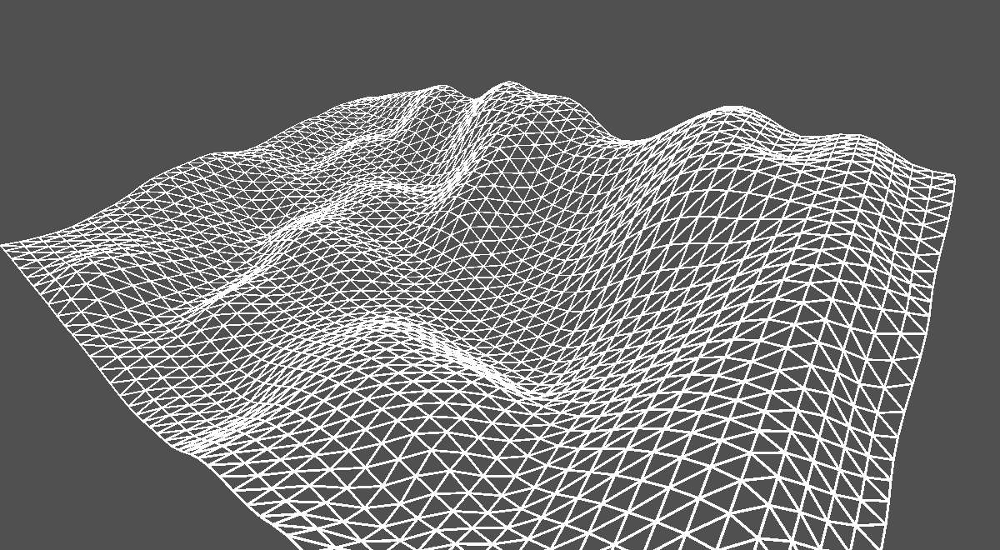

In [11]:
base64_data = "iVBORw0KGgoAAAANSUhEUgAABLAAAAKUCAYAAAAUzMHVAAAgAElEQVR4Xuy9XbIkOW9lK81QGqmG2G1R1i5joQHsDdIjjsc56760Kp0EwYUfAsjI7/7nf/3Xf/2f/+D/gwAEIAABCEAAAhCAAAQgAAEIQAACEIDAQwn8JwOsh1oGtSAAAQhAAAIQgAAEIAABCEAAAhCAAAT+IcAAC0eAAAQgAAEIQAACEIAABCAAAQhAAAIQeDQBBliPNg/KQQACEIAABCAAAQhAAAIQgAAEIAABCDDAwgcgAAEIQAACEIAABCAAAQhAAAIQgAAEHk2AAdajzYNyEIAABCAAAQhAAAIQgAAEIAABCEAAAgyw8AEIQAACEIAABCAAAQhAAAIQgAAEIACBRxNggPVo86AcBCAAAQhAAAIQgAAEIAABCEAAAhCAAAMsfAACEIAABCAAAQhAAAIQgAAEIAABCEDg0QQYYD3aPCgHAQhAAAIQgAAEIAABCEAAAhCAAAQgwAALH4AABCAAAQhAAAIQgAAEIAABCEAAAhB4NAEGWI82D8pBAAIQgAAEIAABCEAAAhCAAAQgAAEIMMDCByAAAQhAAAIQgAAEIAABCEAAAhCAAAQeTYAB1qPNg3IQgAAEIAABCEAAAhCAAAQgAAEIQAACDLDwAQhAAAIQgAAEIAABCEAAAhCAAAQgAIFHE2CA9WjzoBwEIAABCEAAAhCAAAQgAAEIQAACEIAAAyx8AAIQgAAEIAABCEAAAhCAAAQgAAEIQODRBBhgPdo8KAcBCEAAAhCAAAQgAAEIQAACEIAABCDAAAsfgAAEIAABCEAAAhCAAAQgAAEIQAACEHg0AQZYjzYPykEAAhCAAAQgAAEIQAACEIAABCAAAQgwwMIHIAABCEAAAhCAAAQgAAEIQAACEIAABB5NgAHWo82DchCAAAQgAAEIQAACEIAABCAAAQhAAAIMsPABCEAAAhCAAAQgAAEIQAACEIAABCAAgUcTYID1aPOgHAQgAAEIQAACEIAABCAAAQhAAAIQgAADLHwAAhCAAAQgAAEIQAACEIAABCAAAQhA4NEEGGA92jwoBwEIQAACEIAABCAAAQhAAAIQgAAEIMAACx+AAAQgAAEIQAACEIAABCAAAQhAAAIQeDQBBliPNg/KQQACEIAABCAAAQhAAAIQgAAEIAABCDDAwgcgAAEIQAACEIAABCAAAQhAAAIQgAAEHk2AAdajzYNyEIAABCAAAQhAAAIQgAAEIAABCEAAAgyw8AEIQAACEIAABCAAAQhAAAIQgAAEIACBRxNggPVo86AcBCAAAQhAAAIQgAAEIAABCEAAAhCAAAMsfAACEIAABCAAAQhAAAIQgAAEIAABCEDg0QQYYD3aPCgHAQhAAAIQgAAEIAABCEAAAhCAAAQgwAALH4AABCAAAQhAAAIQgAAEIAABCEAAAhB4NAEGWI82D8pBAAIQgAAEIAABCEAAAhCAAAQgAAEIMMDCByAAAQhAAAIQgAAEIAABCEAAAhCAAAQeTYAB1qPNg3IQgAAEIAABCEAAAhCAAAQgAAEIQAACDLDwAQhAAAIQgAAEIAABCEAAAhCAAAQgAIFHE2CA9WjzoBwEIAABCEAAAhCAAAQgAAEIQAACEIAAAyx8AAIQgAAEIAABCEAAAhCAAAQgAAEIQODRBBhgPdo8KAcBCEAAAhCAAAQgAAEIQAACEIAABCDAAAsfgAAEIAABCEAAAhCAAAQgAAEIQAACEHg0AQZYjzYPykEAAhCAAAQgAAEIQAACEIAABCAAAQgwwMIHIAABCEAAAhCAAAQgAAEIQAACEIAABB5NgAHWo82DchCAAAQgAAEIQAACEIAABCAAAQhAAAIMsPABCEAAAhCAAAQgAAEIQAACEIAABCAAgUcTYID1aPOgHAQgAAEIQAACEIAABCAAAQhAAAIQgAADLHwAAhCAAAQgAAEIQAACEIAABCAAAQhA4NEEGGA92jwoBwEIQAACEIAABCAAAQhAAAIQgAAEIMAACx+AAAQgAAEIQAACEIAABCAAAQhAAAIQeDQBBliPNg/KQQACEIAABCAAAQhAAAIQgAAEIAABCDDAwgcgAAEIQAACEIAABCAAAQhAAAIQgAAEHk2AAdajzYNyEIAABCAAAQhAAAIQgAAEIAABCEAAAgyw8AEIQAACEIAABCAAAQhAAAIQgAAEIACBRxNggPVo86AcBCAAAQhAAAIQgAAEIAABCEAAAhCAAAMsfAACEIAABCAAAQhAAAIQgAAEIAABCEDg0QQYYD3aPCgHAQhAAAIQgAAEIAABCEAAAhCAAAQgwAALH4AABCAAAQhAAAIQgAAEIAABCEAAAhB4NAEGWI82D8pBAAIQgAAEIAABCEAAAhCAAAQgAAEIMMDCByAAAQhAAAIQgAAEIAABCEAAAhCAAAQeTYAB1qPNg3IQgAAEIAABCEAAAhCAAAQgAAEIQAACDLDwAQhAAAIQgAAEIAABCEAAAhCAAAQgAIFHE2CA9WjzoBwEIAABCEAAAhCAAAQgAAEIQAACEIAAAyx8AAIQgAAEIAABCEAAAhCAAAQgAAEIQODRBBhgPdo8KAcBCEAAAhCAAAQgAAEIQAACEIAABCDAAAsfgAAEIAABCEAAAhCAAAQgAAEIQAACEHg0AQZYjzYPykEAAhCAAAQgAAEIQAACEIAABCAAAQgwwMIHIAABCEAAAhCAAAQgAAEIQAACEIAABB5NgAHWo82DchCAAAQgAAEIQAACEIAABCAAAQhAAAIMsPABCEAAAhCAAAQgAAEIQAACEIAABCAAgUcTYID1aPOgHAQgAAEIQAACEIAABCAAAQhAAAIQgAADLHwAAhCAAAQgAAEIQAACEIAABCAAAQhA4NEEGGA92jwoBwEIQAACEIAABCAAAQhAAAIQgAAEIMAACx+AAAQgAAEIQAACEIAABCAAAQhAAAIQeDQBBliPNg/KQQACEIAABCAAAQhAAAIQgAAEIAABCDDAwgcgAAEIQAACEIAABCAAAQhAAAIQgAAEHk2AAdajzYNyEIAABCAAAQhAAAIQgAAEIAABCEAAAgyw8AEIQAACEIAABCAAAQhAAAIQgAAEIACBRxNggPVo86AcBCAAAQhAAAIQgAAEIAABCEAAAhCAAAMsfAACEIAABCAAAQhAAAIQgAAEIAABCEDg0QQYYD3aPCgHAQhAAAIQgAAEIAABCEAAAhCAAAQgwAALH4AABCAAAQhAAAIQgAAEIAABCEAAAhB4NAEGWI82D8pBAAIQgAAEIAABCEAAAhCAAAQgAAEIMMDCByAAAQhAAAIQgAAEIAABCEAAAhCAAAQeTYAB1qPNg3IQgAAEIAABCEAAAhCAAAQgAAEIQAACDLDwAQhAAAIQgAAEIAABCEAAAhCAAAQgAIFHE2CA9WjzoBwEIAABCEAAAhCAAAQgAAEIQAACEIAAAyx8AAIQgAAEIAABCEAAAhCAAAQgAAEIQODRBBhgPdo8KAcBCEAAAhCAAAQgAAEIQAACEIAABCDAAAsfgAAEIAABCEAAAhCAAAQgAAEIQAACEHg0AQZYjzYPykEAAhCAAAQgAAEIQAACEIAABCAAAQgwwMIHIAABCEAAAhCAAAQgAAEIQAACEIAABB5NgAHWo82DchCAAAQgAAEIQAACEIAABCAAAQhAAAIMsPABCEAAAhCAAAQgAAEIQAACEIAABCAAgUcTYID1aPOgHAQgAAEIQAACEIAABCAAAQhAAAIQgAADLHwAAhCAAAQgAAEIQAACEIAABCAAAQhA4NEEGGA92jwoBwEIQAACEIDAbyXwP//zP/+62n//93//1qtyLwhAAAIQgAAEIHBMgAHWMUIEQAACEIAABCAAAY9AHFp1uxhoeUxZBQEIQAACEIDA3yDAAOtv2JlbQgACEIAABCDwQwSqoVU1oJqu/6FrcSwEIAABCEAAAhD4KAEGWB/FzWEQgAAEIAABCPwFApNfWu3w4NdZO9TYAwEIQAACEIDANxNggPXN1kN3CEAAAhCAAAQeReCOwdU6nMr+d7KuP2OI9SjTowwEIAABCEAAAm8mwADrzYARDwEIQAACEPgtBKbDmb80YOnYXBycNS9fcf7H3dc1f4nzb4kl7gEBCEAAAhCAwJwAA6w5M3ZAAAIQgAAEfj0BZ1g1+d9w+q1DFsVJ3fvO/eqsX++0XBACEIAABCAAgV9NgAHWrzYvl4MABCAAAQj4BNQw5ZLk/KJoPfW1/rf9szeHlRooOTIy62Vy+UWW7+eshAAEIAABCEDgOwkwwPpOu6E1BCAAAQhA4BYCu0OUOKC6/rsbpPyGIYvLSw2Z1mFgNtzLWKmzf+Og8BYnRwgEIAABCEAAAr+CAAOsX2FGLgEBCEAAAhDwCahBiJKkhjPuL4/UOqXHp7873Lr/AfZ1aPX6v52BnlqjdPo2xp+2KedBAAIQgAAEIPA9BBhgfY+t0BQCEIAABCCwRUANOSqhcfjhynGHJt/0zwrdu2csu4HflNVLfren0tM9Z8vB2AQBCEAAAhCAAAQ+QIAB1gcgcwQEIAABCEDgUwR2Bi3Z/6bVzpBkesdv+Cdv6v/Pgdl3NSw6Gdy5/7Sw+iWY0m1qQ9ZDAAIQgAAEIACBTxFggPUp0pwDAQhAAAIQuIGAO6Bah0PVsdMhRxyevP47k3Ey/HrSgMVlfYNZbxGh2Kl/jniLEgiBAAQgAAEIQAACbyLAAOtNYBELAQhAAAIQmBKYDEyc/62l7vxuf/dPB9dfa939T+MufdUgZsp1Z71rC0dXV1bUs5K9I286rNxhxh4IQAACEIAABCDwTgIMsN5JF9kQgAAEIACBQOD61ZIaQmT/rO8lqvpzZ1gV/+na+t/Vt2yoFH95lZ2t/plc92sgtffdTqVss54//bWZsmt3N4fZaq/JPVbfejdf5EMAAhCAAAQgAIEdAgywdqixBwIQgAAEINAQcAYHapBR/W8rZf+Mr1Kl++d91fBK/TOzyXBJ/e81OcMf5xdOdzmj+t+7ep2j+MQ1zrArntv9sk0NmqaynMHnXXyRAwEIQAACEIAABE4IMMA6ocdeCEAAAhD40wTUwONkCNX90sr5FVY1vHIGYOqfrk2HSs5QpXKkycDsxBkrW6pB43pmds+p/sqnJndUw7ZOX+ecqR84MlkDAQhAAAIQgAAEKgIMsPANCEAAAhCAgEHA+VXVS4zzP57erXMGJtVASP0zwOua2RlqGOEOYlxOGfK7B2eGWf9ZUg0ar/3x12rd/0bYZdtVrmLbDcHcOzx93YTB0++CfhCAAAQgAAEI/AwBBlg/w51TIQABCEDgwQROhjDZACMOjuLQpPsfVK8wqf+h9ZM7VLKdX35Vd417d+6cyT5xI/WrqziEUgPC7p9sVnoqO2UDUTUMUjI7ZmqIGG1wctYaKyd2ZC8EIAABCEAAAn+DAAOsv2FnbgkBCEDgzxE4bawVsG6wcMfZk/8dJOefBWb3UWc4DNSa7Jdb7q+5LtnOoEnpEb87/1Qv/vLqGriofxLZ3U/dZeef/TnDMed/b2zK0BmEVfdx+N+pD7IgAAEIQAACEPh+Agywvt+G3AACEIAABIp/BnYCxv2ngOqMya9y3MFH9eulVedqwKYGJN3QSP3ypxoSqUGZI1f9+ukaLnX2cAaL2S/F1NBpPdPRs9LVtU1lo8kv5JTfTr7fad/sXMc/JvqyFgIQgAAEIACB7yTAAOs77YbWEIAABP48AXcY0f3vGzkyKtDqn/BVw5xseOH+oifudfTvhl3V3TJ9dn81pYYPSq471KkYOowuDu7wyv1ndivfUw6urZzE4Ojv6uucd9capdNd5yAHAhCAAAQgAIFnEmCA9Uy7oBUEIAABCAQCk0HEFJ7zvzPUDVKcb9cZ1eBLfZ8OWbphlzPAiOe9/ns6THIHDtkQa3rW1OZxfTa8infeOcNhoIZ4Ez2cXw46w9c7481hENl2v2TbkbdjO/ZAAAIQgAAEIPAsAgywnmUPtIEABCAAgYWAaqKdf0q3Ao3/xC4byrzOzORmA6a1ye6GMNm569nd93Ww4v5CqBtexW/VYCpyWDmqgUu3t3NwZW8VHM7wxpFRDYycwV+0UXZe5V/uoOqOX9UpDkpvNXDK7uIMntTgUn3fuRd7IAABCEAAAhD4DgIMsL7DTmgJAQhA4E8Q6P7pWhxEXf9dDT26XzrF4dEqKxtAqOHVJU8NJtzv1a9P4qDLubv7zxM73TLnqwYJ7vBqMqyaDj52gyUbgHVnK7bVkMfVT91bDRJVjEyHVBM/UHfP7rZ7H8XJ5c06CEAAAhCAAASeTYAB1rPtg3YQgAAEfj2BO/63i16QJoOGbP06eHEHSN3gKw6Esl9PTfd3/6wqG/DFX4g5Qyp3iBCHI+rXbZUjq6Fedi81HLkzaNSvrrLhpjpfDe+cgUxlp05254MvnU8Gco7OzkBtV85kn7IP3yEAAQhAAAIQeCYBBljPtAtaQQACEPjVBFQDXw0tsl/9qKZbfb8a92wAszb1P/39YlINIdyhm/onWO4vqFYbKXs6wwU1OJv8Ok/9Mq37rvg4PpEFb3Zm9StBNbSLg0lnOJgNHKt9E10ntr0rqXXcHH3u0gM5EIAABCAAAQh8lgADrM/y5jQIQAACf5JAN0SaDAxe8Ka/tJrumTTHp8MxNTxbhyXXPdQQL/4iKBt2OL8qUo7q/NJHyZgMVbqBWfYrruzs7J8Irv6hfDF+V0O3aL/VhmrQooaC8X5K3qqLszba5vrviqFr64x3lBmHtBPZq547+9gDAQhAAAIQgMBzCTDAeq5t0AwCEIDAVxNwhjtqKDFt4hWwyXAqDh+ypt8ZeFS/3KqGGx2T9VvW5Gf/nE3pGM+bDgi7gZmyxzokUUMV9asg9aukbPDSDb4qX6l+ARfvWvm/M/RSsuL3CTu1NvNL147rcMrZk7HY4bP6URYjji6sgQAEIAABCEDg+QQYYD3fRmgIAQhA4KsI3D10mjak1T+BU/+srBsa7A6vLpnqF09Z4684Zr9aiXe/Y3ilBpGnQ4jKXtlQohoGquFVFkDu8KpiWA1anF8b7g6RugFsNdRSfuQmF/XrNVdOtOtObGVn7fw6bqoz6yEAAQhAAAIQ+FkCDLB+lj+nQwACEPgVBFSTnw1o1ovf8WsV9cuNuxp5d6Dm6jMZbqlBjfqnV+qsar/6VdbuEGJ3CJQNn6oBizu86n69pn6N9TpDDQuVP0QZa8w4e7OBn5NcnGHaqlvF3jnLGV5VeUH54LXvDv0md2EtBO4g8I73yX2r7tAfGRCAAAQ+RYAB1qdIcw4EIACBX0hANe1ZU1398sVpUN0BTDYMuAYC3TDAuc+7G42q6ch+YRJ/keT8+ieTn93JGWw4gxU1pJr4QzXAmwyvqsFQ1NPV2/GZyx+V/94xhOn807FplqZOYyYbSrm6KL7KB9X3X5iWudKXEPjkW8Iw60ucAjUhAAFJgAGWRMQCCEAAAhCIBLKm8rQYVw1tN1BwfzmkhhLZAEEN4So2algx+a6GV5WHOkPBk8bmpZey2zpMjMOqbPDkcMnsqH6dFm2brY/6VL8sc9apoU03bIw+pxhnsqqB3DrAczKbOwBSg6b1Tuo+3RBt1f9u3RwerIHACYHTd3J6dvU2dm/d9AzWQwACEPgkAQZYn6TNWRCAAAS+nMCk+K7+2VU2MJnI7RA6A5vuFz/VQGYybOgGBKrJV4PB6pdGWZOihgQZc7UnDmWm6y82Ds9qAHT38Op1jquPu64bXrky1HCms1+3V/lgp7tKX0q2upOSP7FVlKV0c85mDQR2CNz1vu2cPdkzyecTuayFAAQgcCcBBlh30kQWBCAAgV9KoBusqKK3axynDe3u0MX5NYoajFzNc/WrnGwwlw0DqgGXYqzuPmnQ1VnKjad2u+S5w5tu+BD5rbqoRnEdADq/2lPyLj3Vr8bifdyY2fE1xzaurziyMl858S+XeXau4roOwJy1Kg74DoGKwIkf71JVv7aayiVGpsRYDwEIfIIAA6xPUOYMCEAAAl9KwGl0qybX2TttKKtBlCq0X/ticZ/9Qiz7ddZk33pONbzKBljVYOeSVzVDzhAm0yMb5Ky2qIZs6yBKMa+GVpfsqX9k++IAqWsaV1bVr/CcMK1+Baf2uryymHAHf9OBU2eDqax4/7sa+OqXnI4d1GBxYhNlX75D4C6f/wRJJ35ifv2EXpwBAQhAQBFggKUI8R0CEIDAHyUwbWDdJjvDqc46+R6HQNWvWiaDqm7I0A3GsgFX/AVRHLS4w6urIVG/2qkGOdWgqxpMqOHAuq87s/MbtyF0mrFsaKfYrna+BmhOOlB6d4OT6A8Zx50Y6vSOgywVb5GLwyRbszNAijFUDbXjed0gbFd/9kFAxbozBHJkxBxX/eXFjkWq2FAxtHMWeyAAAQicEmCAdUqQ/RCAAAR+GQG3ITy9djdoUcOk6uxOdzVwqX6VdDXr2a924p91a7KhQDasiHpkzU3Gpxo6qHNdlte6bgjXNWt3DEWypm1neNX98ijymKyNg53MH7pBTmdrFW8O306G00QrHTL7nwy2K1tMhlHdkPKUmcuDdb+PwCRe3Dzg5M/XGvWW7dJ29dwZPO/qxD4IQAACkQADLHwCAhCAAAT+IaAKcqdodgdP6qw7TeL82sVpHNSAa20sqqGRGnA5w6vrnGxYVzUgWcPvNCHdGdPBRDb4quzcDY26XwtlA8H1jGzY5frHhFfXZK76dHHgnHfJmg5i3Pib6JDZshoo78hVd1TfI6uo745Od+YpZD2fgBs3k5tUw9hKhuOnahA+uUc31HJ0mbBgLQQgAAGHAAMshxJrIAABCPxiAtVAwGnCu6bRbSi7ht75dY1rmqzYdn5dcw1e1F274Z1q5KthUDaQyQZpSn7GeNJ8dL9icfi7vqCGYp0eaniV6ekOr1QsqIaxY9TFXxy+OUMiNajpBjeOrzv2XnWY/FpKcVI+6/pZlXOU/MndWfs7CLjDnjvfqh1yzl8w7eSxbI/zbu7cgT0QgAAEHAIMsBxKrIEABCDwCwmoZq8rUtXe2ESrxrA662qoXfyVXtlgxLmD09BXQ6bYJKsB19UAZeu6AUk1uOkaGmWPqsFXDVBlJ2XHbIjTDT5Wu8SBXtdwxibzXU2fw9cderkNtIoRpVM1BD2xebV32gA7sRpzjqO3awPFlu+/j8BdcafITH+BpeRNvle/ruqGcd2eydmshQAEILBLgAHWLjn2QQACEPhSApNm8HXF7lcvLoJugKH0Ud8nw7LJXdwmWw251IArO6caSl13jU1E9quszDZqkJQNATI5ahiy7lH2qwYnWaOkGqs7h1cO00x3xWbig5UNu7hT53cyu2Z6IlfZfCdmd87vhliZjq7ebt5j3XcRuGtoNfHV6o2t8k/UsRoo7ZKfyMvy8fTuu3qyDwIQ+LsEGGD9XdtzcwhA4I8RuKs4V9jUr1qyXxgpmaqxrL6rgca0eYh6rsMr9YsnR8duQFMNr1aduuZBMYwssiHZusZpVLozOx7V8Kqy1zWoiMPEOMBQQ0k1bOwGczt8nT3ZmVW8ODbJfLgb9Extfq13dVEM1Pcud6iYy3Q8OU/lMb4/k8Cdb6Pr993b48RcprOT/5UFuphQe923aCKHtRCAAAQiAQZY+AQEIACBX0zgzl97rIOnnyhynV9MqKLeaU6VjG6IUQ0Hrj/vfuHiuGG132maruHOro47Z2dndkOkaJ/qv+MdnF8CdL9cyBpGNfyIQ5+Kb2xUq8GgM4jJ7t3Jd3zKiQmnob7OcuVlcZQxjX/m3KmLUUc/Z81UD9Y/j8DO4Er9JYPKxc77ogbtVexU70xFXt2/+zWW4nAat8/zFjSCAASeQoAB1lMsgR4QgAAEbiLgDAhUcakK6K5Z32nEnavHX25Ve9xfgE2agGz44TS5DsfsHldzsDYJzv0nd1e6rQOJidxqkKHO2x1eVfyqIUY3VFO/DlRDrW5AuTsAjE1p53eKcWTl+HA3DDqVV8Vg5vdOjnAbdTVkeMmZsjnRj72fJaAGN6s2aojj+oozuKpyp0NnIn/V+aoFFJPq/Tl5l5x7sQYCEIBAJMAAC5+AAAQg8OUE1C9LsutVje6kAZ40eGo40ZnALawdGaoZce5U6TMZXjgNRGziVYPS+cE1tJn6yoRHdn81EIoDjG599M1VN3WveP/MD3b+rGpeVRy5Q6irucwGPWqomO2dyFHDoOz8bDg4Ta+VLVUemJzDAGtC6/esdX2o8u2LhMoVcRC1ElS+5+Rc563rzuzyk2KUDay6t29y99/jadwEAhB4JwEGWO+ki2wIQAACbySgCs3do1WBPWmCnUL55Dyn2K+GZ9VwwBkMxL0ntlgHVZ3NnMaha5yy5kv5iDuQ6Bg752bDqGrYqHh1v3SK98n8x/2zlXWna2Rc+awawr3kOP6e+cDdw6Ypo2nDrfwy+97lkS4+nX2THLWjO3veR8DNzad5v/vLkeytyW6sBt9TSllOcc7I1jgc1eDP5TC9J+shAIG/RYAB1t+yN7eFAAS+nID6dcKk0XIK0unwYcXrNtu7QxLnrOyOXaOiCvBreOI0vVWxHpsDZYfsV0lTZjuNg2u/ODCJAybHJ6/7qOGOGl7Fe7qDseoXFarZy+Qr1mrYpxpph6caYk1t2zXbq01U/DjpN7Px5M7xDMVb5bg7WDn3Zs29BFRede3eraviX8mubnria+59Xd1UrVHdwc0BJzF9r6cgDQIQ+DYCDLC+zWLoCwEI/EkCqpHOhghd05kVsWp40BWsalCgjNYV7pOivmso1NCp+uXOOpBw9HQankumajp2h1eV3EnT4A7JVtu6flrtWVlXPu0ye+1f7xDv0/m7GspcsqNfK74ndtmxR2S46qt0VTFbMXD2qVjM4mNX34ybGmpVuWBXB4cJa+4hoPKDE7NOHuvOUUPoe256nxQnHrvcnGmSvV0xZxBP99kQSRD4SwQYYP0la0e+ltkAACAASURBVHNXCEDg6wg4hXR2qZNBTlaodmd0UCcFajZQcIZXqmFROnTNbPXLnHjnyFv9LXQckGR3qIZXyj6dLg7Pq8lQ3LrhiNMkZvvjna81659nv9CJ69ZGKRtGucPa3cbOjZcpY3d95Z+fSoC7ela+5/ptF5fOtxiHbvx/iivn1ATUO5Dt7P7SosuzO2e9y3ZurLk6O2+Xm9+yvNzl/XcxQi4EIPC7CDDA+l325DYQgMAvIeAWm9PrTopdd+06LFgL1skdusGFIyc2mpm8rjDPhhxZw6t+maGGcNlwyR1eVc191RCoIY36lYCyf9bsd/fPGsI4oK1s3Q2tVjupv/VXdq4Gxo4PTmJRsV1lTYc3E10nerhN64nM7q67HJwhpNu0T3WY+ARr9whM/V3lxWpwNTkn3kT5l3o3T2Iqvg/VW5vRzwa43VAqe4u69VW+3fMEdkEAAn+FAAOsv2Jp7gkBCHwFgTjgcIrFrNlVBbEj96WLKpy7ZkDtvQYyrmFceapZ6IZllS6RRTfo6H61cclZ5VUDrMh22tx39lOy1HCr8h/nTOWb2RCqiovVXtXw6vKzyfDK8UnHH10fV7yVT1f6Vr541yDmNF9lucsZOL32Kf5O/lrto2wQGavzHR9izT4BNVCKQ+/sv2N8Rpt2Z+za35VZvQs7xNyhnaObM3RybHPdI67d5brDhT0QgMB3EmCA9Z12Q2sIQOCXEVADBTVwUkVlJt8pkFXhq5rNaTHq6JSZftKQTwtmd5BUDbmygVn3t+DVoCVryE/tEwcBjp90jb5rb2WD6M/X3bM/j7FR2aEburnDCRVnUY5arxpG1QiqvBCbxG64Ok2pyldcX+h07GK9G2JN8oEzxIqDDpf7lCnrNQEVE06+jcOsy5eU7FW7Xf/O8pXjy7tnT3JQlh+URbqhX8a5uofSU+nBdwhA4O8QYID1d2zNTSEAgQcSmDRapw2jOqsaHq37pkVmNnTpmtKqGFaDsq4BqJpPtyGIw5Pu1zDd8KlqXNbmSe13BxC73Nd9asgU7Tg9s7JZNaSKbDL93BipGlXHz5SvZf7mNrtOA+3KWu1Txb7KCVXK7PZNc8TKa3K3T94p8/UYzw98Xn6VSio2usFV9DEla43x6l104XZ5dBp/O7o4Z6iYdXl1cpSMaqjocmYdBCDwdwgwwPo7tuamEIDAgwg4ReWlrlP4uVebnFsNfiZN5iXDGQzsrFFNbBxSqQFHHE6own61UTV8ihxjoe4U7tlg6Y5fQikfc229M7zKBkHdYGm1Xfy/1eDvOssdemXxNPGFuH/CMTvb3d/p3flLZosup6g84rKK/je9ZxXPUzmuHp1/ujmYdTMCk/ev8jsl49LI/QWS41/d4Mr1t4qUO8hScRrlu3GreKpcM/EAh/VEHmshAIHvJ8AA6/ttyA0gAIEvIqAKvzuuogo+t6id6qoGUOqXS+ruUe9soLHKiOc5995pUK/hzWSYtjZMqtGpBjc7wwqnIVL+UzU9yv7rkCQbeFVDqWw4lTHvZFZ+sdOwufd0/C02shej9S6ujif+sKOr4yeOXGdNlxsm8aFyzOu7iuOdvOKcy5p/E1DvT2WHNc9k8RU5d+9SzFmZ7FWeO1jq/GziB915u3ljum/3zVzfwJVHdX8n30zYsRYCEPheAgywvtd2aA4BCHwRgUlh2zWiqqB2i8muaewK2Gxf12jEv9G+/nu3aXXvFxm6503lO8W+kqlkqO+xgXILfdduKsyywVHWOHa2z4YQ2blxmHWd7fil26hWvhMbrqpxrX4Ndldcu/adNsmTGLlTh85/lO9lfubsUfpX/qh+WaLkOrr99TWfGFw5Q+jsrV3/rIr/Lk90efHU7uqdmcifvDlrnqnOULk3cr3zLpN7sxYCEPgOAgywvsNOaAkBCHwpgaoQdAtEtc5pOp2GQJ2TFeuqWVPn3mVSVw+niF51igOXrDFR/FUhrrir71O7RH3WO+4MF7v7V9/iwCKuc5itQ6LOLlXDGZsuNZjomtLMRu5Qr2rclD7K59f7OWtjY33H+Y5vqvjJcsSn8kqWC7qctXOXu3Lgb5Dj2NX91VUmS8VBl2u7XBbZq3N2YzOe4/Da0S3mgi6HZnlU6eXaMMqexuNviAnuAAEI5AQYYOEZEIAABN5AwB08nA641mLTKZyz4nSnMNxp1qrhyQR/NfyoimxnOFL9SqzSSxXo6j7ZYKwall2yHNu6Q5OqgYgcVONyNRg7DUk1LOvYrkOrOMByho2rXRxfXH1HNbAOO3WmG1OT3OL4TdUYO36ifD1jfme8ZX7k8lG6nwxBdrgrfX7r90k+VXGuht9OTnf8fsc34turfGTC5cQ3Oj1UzlqHTFkOvN4QZRcnZk+Yn/BhLwQg8DwCDLCeZxM0ggAEvpyA24h2DbUzPMgaT1UUrwWnW1yqon9yZjW4cEzeDWiyQloVzaq5VvaJNurOcwZpGYNqUJPZXunT/aom+6b8OPvu7Ol8YJdhNdxSd658Sg2vqoarY3LZrNPJjXvV8Ck7qHir7uHEeid7wjXKUY22M3hQ976+O/F6hx1dfX7juumAJhteVQMt13emA5o7hijTe1e2d/xv56zuLajeGKXLus/J8Vke7O5ympd+Y3xxJwj8ZgIMsH6zdbkbBCDwUQJO83qikFOkdUOerundbdhUo9x9V3urZtJpkNc1ilulR9bcuGvXYUXWtFfDjK6hUt+6Bq9ipmyg7Dc583R4sfp29OWKsWrGukapGrSpOFK/Eslsoewwsd+urHiGstduLnObahW3Tn7obDVh+lrbNd4du11Ov3XfxP7duxSH+7uDniwHRN/KZDtDmxMbuv6/nuG8T9Wgt9M1+4sUN7ZUvlTndnHevYkn7NkLAQg8mwADrGfbB+0gAIEvIDApyJ3m1RkmrXKygnT9s2mhOW36s6LZPXNtDE9+BRS5Zs2Nkp/ZMePYDSiqwYrTAMWBgfrFiVv4d+vWoZBatzZ6O8ON6yynyYr+7cRE1mR1g4Xs7tU51TArax672HTif5ryMp/baX473TLbT/W8w187ezr+u95jxxbKD7t8cSevb5Ol3kg1IFH3rYZZzpDJWaPOv+P7acyqN1d9v+6gbJW9ter+ztnOua6tTlmq+/AdAhD4WQIMsH6WP6dDAAJfTGDyN/LTZqlq8lXDXOF0C7rTc9dGwj3zpXM3BKuGcdddd4YLk4YnG9bEs7M7VAOxODiphl4OP6cxqHzCsXXmb+5wsPPV7lcAl/zs/105dzaoBhXdEK3ywclgLNNJpbipHbpcos769PfpMHyq34SdihVXViYnxrqTk6Z3/cb1aiiR/WVA9RcE2f2r/e6Q3B2ITNi771WWy9ZznPxf5WeV86v86Ozr7KA4qRi89nd+M/2LnSlHdQe+QwACP0+AAdbP2wANIACBLyTgFMhOcewUY9MC7J2DtdPm2b3vtIB1ms+pzKrBcIYvkdPaaGUNzrThPbXxdbdT33L3r4OjbqhRDRbXhqtqgqohQmyK1jM67tUA8rTJmjad0ZfUUGCaTp2YvGS69u50WAe4bkPb5Z2pTt0AypXV6X1HbE5t+LT1ykerIY87vOr2777NE50V77vemvUcJ07v8N+Tuzl5YhLzyiYVH5W71R2f/l29dU/XH/0gcEqAAdYpQfZDAAJ/ioAzKImDj+5vmRU897zuzGoocEdBrJq1SQFasVBF+doQZ8OBKLcbQE11cO5XDUky21Z3qYYe2TBA8Vp9xVl7nb3bFKiGZeWQ/d+v850BXzcki6wj58oWa0OmbO0M3yo7Rr9TZ2WN23r/lZnKMd33Xf+qZKrhwtQfJ+tVbtiR1eXn3Xg5sddP71V+qwZX8R3L/Lyyo8qzaywrX6jWKr7VYGHyjnf5NtNL5VcVi9NcUeXoydvp6jw9K3vrv3HYo+JI+eGd33fy4p3nIwsCGQEGWPgFBCAAAYPATgGaFeM7xYBztmqknKFNtab7xUxW/Dr6Zsi7YrXTYedv7Z0mwXCLfy2JA4ysWXPXdHwu5t3QRfmZMyjrGHX3iLpXzUr253EIs/pX1/R0TUo2vMrkVs111hTF2K5439WIOPaMfjFtTCu7VX48jQ+VF9T39bzJWhVL3T0U99UPnL8QuM5y5E75/tR6x8e790e9TSq2Ov90ck/FbWKjSf7ZsdMOY+ccd5AU3wI1iOz0VXu7s6o3qfvLgzvs67CcrHHsqeRN8o2S5X6fxIQrk3UQ2CHAAGuHGnsgAIE/Q6Bqsu8GoAqDqmFzGzk1sMgKqrUozIZETgGl7nV3seoOs+6yX3WeGl5VA7nqz7PGt7Kp8gn1fW3K47nZme5gqWsyoq9Fmc4Zmb9mA4b1Dt0QsBs2TBu/qvFa/dCNlei73R3ulOnEahdXU79T+WVyN9VQ7zSUTiOu5E7ucFfOukuOulsVP+5QSdn/Jb8afsVc4+aeaTxW72YW73fZ2uE+Oasbvjm5Rt3V0Td7Z7r8W+VT9X7e5fs/ISfWGpWNJ7yrumKNrUrexMd+ghdn/m4CDLB+t325HQQgsEnALQKcImItPKqCu1MzK1ymDbTTPK46qIbPweqeOV3nnH26pmpOu6Yp+/b6s2tg0t2z+jb981jY7w7KVHOY8c0aoa7BW++W/d+XDqrBigOpanh42SLKdYaQXWy4hfy7GoFdH+liRMWk+h5l37nekeWwzuR0vua+CfHuTlPt+tBpXrtj/4RD995VcVfl0TV+VR5W98zOrgbglSyVl2K+UTq55+zKUT6maopp3Dm1kbqL0jm+d6s8ZwCqzn/X9873rzO7vNENZDudHZ5OneJyfhc/5EKAARY+AAEIQCAQ6JppBcspAp0iIhbr2bmunFjkTfY5zYqStw4Y1ntMC6WqsKsaiW540vHNikNVjKvvXVN26dINXlxu0U8i4+q/u6J59R9l66qhUI1sHEJdvFwbZs2nO6BQZ2TsHV4Zi0vPbCitckv2XTWV6vuOzBg7jk9UOaC7c2c/ZyjU2UhxcYYTnV+4+Xp6zo6P3LHHeQe6O2fvojNkrBh3+aS6r5ODnLh2baZqgUpPxbrKHWqf45OVzpO7TNZ27/Cqr5NjKllqEOTExx1sq7exu+fOuc59nDU7A0DXTs75rIFAR4ABFv4BAQhA4P8RcAYqp4OKq8jaeeidYkbJVY1bLLLUUKXTqdu76qEamUnz8wlnjgOuU5+oWHRylZ2zxm8dnrhNWOcPTgOmBg1x8KR8PGtC14Yu+tykaVUNU7STskHGuBvKvM5XMiNzZzDkxvxqa0cPt1Gdnt8NLSZ5Q/mnc8fYFCt/Xm2ofPnSLw4kdvzg7rzn6n7pmq2v7qVkK8bqe2Sh1lcDoSzWVI6o8m5nnxMe6m47/pjx24lhNz9U8b7j01nNEeNsjenufXDOr/Z3ejhyn77GuZ+bX59+V/R7JgEGWM+0C1pBAAIfJDAptGIhN9kbCzX3ge+a3qxJUEX2HYO6TndVkGemVUOgddBx4hqq4D8taCd3WwtpZbPr+04jsXNO1rw5/qoGY5Nh5dV8VTGWxWLXjHZnqzjOBifKZ2Pj5MTd2nAqP5/4grvWXRf9sdPbGbK5d53GV+bHE8YxZ3d6TvzBzZFOzCl23XdXj457NVRUOTv7Ps3PO7kti/Uu/lVOy9i4sb7jzypXZbFZ+fzE/ju+6OqavW8T3U5iQO2d3PsTOk/0qeJD3fnu71Od7z4feb+PAAOs32dTbgQBCAwITBu2rCDYfZxVY6eKv8n+FcnaOLh/+5w1cpN7q8FF1WgOTPm/v17JzjodTMVmSzVabqOrbJxxOeU+2b/6uzO0XP2pYn6xXP/frOnqGtxseHU1aVVMd42o03BmcZPFxfVn3f27prdqNu+KQTVo2fWPTO+d/Fo14JHZVE/Xl6vYnTSninHmIxP5mY7umZOc2p3TDYJirEzWVjGlcrjyB2dItcrYGVxF381y2Ikf77wXk/NcH1SsXRs665z33M0Zp75/5/5Ye6mYdnKpa7/qjcnOmMhUfCZ+o2Tx/W8TYID1t+3P7SHwZwm4Te4pIPVgZ0OoSZGqhlhVgTgpajMGTjG1NoxZwVQ1CF3B1A01ThvPyYCmKpizoYxTXCs/WVmqtRnXy09cu0W/cZrjyfBqlZ8V8lFW9PPuv1VMRV+cNLZT2VlDq3KKYyNnzTRud2VWvjmR58Z8NRBQMTGJn5i3Kns5wwll6+t7NzhxZbx7XaWj04hXMdcNhau4nAw0stzrDJZ3h1dOs+/4qnrLpjLeeZ/Mh6P+zvlOvtixfVYDuT57ElNOPeHWYaeDJcdfVN1Z+bYaLGcMHX1O2LP39xNggPX7bcwNIQCBhYBTYMZiu2tCTwZhWcPvFHFZcTgtCE44uE25cxdXj/XOXdOTNSxdA6qCIyvqumI8G3CoYt5pAF5rOtlKp9WnHbs4Nu6K6qzZ7QZV1/0yPSOf6tzKL5wBVYz5zu6qka/sPYnRzkYT+2X+7dpNxYa6505u7Aal2TenMc58y43Jyh+dge6U3xPXK+bu4M3JB92a1YYZJ3dY0N0nG0h+2s4n93D8x40XJx8753XDDWXvTv7OIGsnbzr1iVOPdP6r3gVHh5Max3nr3Xzp+q9b8zg+xpq/SYAB1t+0O7eGwJ8j4P7tUdfwxSZ35+FXhXh1hlPMqUIonh0HCm4zkjV1ToNy6nTOgGI9Y3K/OxobVSA7Q6apjzkNSTX4Uvpe/uI2Idn6eEY1TKrWRZt3w5esKHaHV5lPd37eya2KfSc+173dAGgqS+nk+IITv9Nmy7mHo5tqaNcY6HR0BhaOzvFtcNh9Yk02pKnOVTkx89Uoq8odVW7uBscTPTP+ahjXvR1T28T7TfdP1k/8sfJLZSdn3zT2r/w6yaUZFxX7Vd1T5cSOvcoPbg3lrpv4wTvX3jGYOqnB33k3ZH8nAQZY32k3tIYABEwCbgOriltVJDpNllt8qSagk+MUGpPGZKfIy/RTfFVzoopjJd/hchXUseC9dHNkdMOeWLBPdO4a8B29YkPi+kTn590QKmuAYjMdi/q1Cawa3stWl6yuccyahm6fajJUTlj9yFnrxPVunnHi2NVRxaKKZTN1/7Ns574T/Zw7TxrsydkTDp9e2+UxlePWPLrq3Q2fq1zg8FR5VOmzw7bLM9V5zjnOfR053Zour3U5ObOluuvkPk4sdvfqBlnV2+Rycs6N7E7tFPe7fCbM79Yxk1e93VFP936f0Jkznk+AAdbzbYSGEIDABoHdpsMt4DKVJs1Wpd86qFgbOKeYqc539XLXRV2cvwF19rhmdgqd6V1O/nawa8yyAj/auPOlionD4PIftbbzm25wlNlUDZquPVmxn+1ddVP+fbGe7sn2Vc2aatg6Jq5/q1hR9nSarV1ddvbdoe+ODLeR62Sr2FY8JvFzyXL0doarrhyVv7u31G1Cp8OrTK7SM+NX2dZho2L95M3YjdF3D0lWvVTMTWqsLp+qGPqr33drUde3V//O3sx3cZ8Mx9+lA3K/nwADrO+3ITeAAAQWApOiyn3oVSGXFWdO4dz9zbHTVEXDrwXPafHj3NkZKMQmwGXe3e36phh3fN2gURwiA+V/zvCqKvaVLtXgw9nX3UPxfn2fDI2qJiz6bya3K35j81XZIuqanVsNExyWce9kz5MavR29Kz+6Q5YTs86QYzcHdeerXBTz4OrbSq47RFNDrU6HKgZUDE1zw9S/4wDwuoPz9kzy/8Q/1XBtIkvx6HLTxIeqfObE1KQWmd79HbHo3OmTa078sPLzHXs6dnTe18l9Ks7dOVMf+qQtOes5BBhgPccWaAIBCBwQiIX2bmFUNdfuQxyb7qzQUA+0KloyXe7822B1vhrSqKI80z9rVLKGq+M5sXlVQFVNYFe0RZ9Rzaxr/7U5VDapfEKdldnKvU/cOxkERX1X+0cbTORWDW/0myzOKx/s0tLdtnZS4MSmnbysEXfOd2RmcTTVezLs7YYKk3MnOaTLT+s74DJVTV03nOv0Vg1nFV/u4MzJ005jvHLq8vDO8Oqu91EN9Ca+lr1la86vagkn/qY5y/V7le9UTFTvTcdiIjPee+fdrGRMmbpyOp/J/mLIyScTP3TqudP4cfa/4z1yWLHmOwkwwPpOu6E1BCDw/wg4hZdTwE8LH+fcKHOnqJjsmTZNbuGUFZfThuQqQtXfXldNTOXwyg4OP1XkqqYlNh2drg7zyCoOVu64k8tzclbHwbFTtIMqaLvvmc26ZiAbaO3cJ7OVurvj89cwR/nq5GHIeDj2Vr6zk2+n+VflpB1O3YAoO2/C2rHxumbiM5kekzyzvhsxDpyh7tTek2GbiuPszauGX1NOnT3uGtB2NYIzWFA+OPWjCbvrnapiQ+USFaNOPLr3V7pMYm/yHjuDm+wOU7spDtFW2X1dRjt2ce6T5RpXJ+f+rPldBBhg/S57chsI/AkCaggyLd53GrIO9KRAd+Q4j7hT6E+asLWR6Zp7twBXjukWhZNCSJ0ZG7fJ+nWta59qXTcgqwaF6sxr4OHcKWsCJ/dTjVblm5dfrbaPDVRc4xTeauA48eeu8J/E04RntFk12FM+MM0tqqFUvuTsv2NNlv8VM4dFl8vU3VUMOft31mS+vJNnLj+PsbOTbyf54LqzOwSrYiHG6Y7eqg6ocoHj0ypXdPc/ifMqLqq7Kjt0PjoZQLyLmfM+3M3EHfq563bywDv3OPlEvW9d3GZ518nx77wzsp9PgAHW822EhhCAwPK/sdMVvFkTMSnwM9BuoVU9uOv+k7+5coZydxXBqvhXBXV1z+7+auhQNZeZfSY227nLtNHtdKz8ubuDup/6XjVTcWgZ40k1N6rQzRqc2DhXRb7z51X8r3/eDa/uyhWqmJ8k9MqWro1VU747IK2aQBVP0RaTnOs2NS6bTJ67N2uUd+z+rlzbNemVzTu/rOKmk6XyxRX7nQ/ENdV72um38+52uSSzvfL7qQ5qCOjmEOVfyubKz1093Pyt5FX3mfihYqJs6b4n6i7ud0efu+zk6hTrFuXfTg0Uz44xPeUwvQvrv4sAA6zvshfaQuDPEVBNiypGXGDqcXQeYLeBv3RSj35cNynSdorsqgiaFBJdUxiLno7DqsuUa2w+Jk26KpCjH6hGY7o+FseV/+4ONrp4coZmL32yZqRqUKpCVw2LKq5OPrhkx4FZNkCr7vI6R+WEU/91ctOunTvZakijvmeyJ7y6+DzJs6s9lO2Uf6n98Q5XXOyyc/Kdk5/V0Gg6vKpiRtlpqkd3t+wdVO/+RO/Kn6v3avK2um981OEOP6pyQPWe7zCNft/lnSofO3lQ2WjyzkRZTqxX/rmru+L0Tvuvb/h6jrL/HXd18oLSY2qvO/RGxvMIMMB6nk3QCAJ/moB6vKZwdos19xz3MXUKkq7YjQ2iI29SaLtrqwHCnXZTTCd3j42qU7DdOTC77FY1zFVhrhi89lVNpGpSu/upc3fs3A2S4rApNqtdg+TcMzJyBkK7/lU1UWvD4OaVyr5unHbnOPdz1kRbKd+JOmUxUfmXK1vp3cWh2pv5ZtUMOnbuclO1X+XfapCsGsd4XienyjvR/xWvKvdlcty8M9W780kVt52/dG+58g3HD3d4VLlV2SH7HuuqLA66e7rxvOZBxe1p39X7tOpbrVW1iHPnjrV6Dx0dHR2q3NDliM7HJ/4z0Y+130OAAdb32ApNIfCrCLgFmCoiswLHefTdB1Dp6cpZ9XT33P2Aq8J4MmSZFJYnhVzVYLgMlZ6uHMWuKsS6ArBrHFy9Kv+vGt0qibj36wrOVXY1nIjDrKqwXfXJ/u+YF7r11QAt3mVtyhT/bvgyGSJ0Sf11hquHWpfdVT0ork84eqp7Vt/de6n86uQ2dY8uplxWMV6Vb6qYqu7t3lflJ8fPq7Oq92vnfZ6+hY7e1dsyrTmqnFblNjcWqjzS7XfiZeKr6v3MdJm89yoHPf274j312yyeVQ2qYtjxNycmp/6s9M7O7OI23kOxf7rvoN8ZAQZYZ/zYDYE/Q0A9RicgnL8hWh/PTJfJY9YVcI7snaJkp4GsmpeTZq+6+5RJVjSpocnke1fcTIqtE1Y7NnP8p9Jp2lgo/5jGhLNe2TA2PFWDfg0LsqFBx7Brltez1mFUV/hG5soGqll3i3KVL5Ueme1d+znrKjtGvSd6Kr8/acSyxs+9Q7U3xn/XwDkcKt+ZnF8NB7Jhh5snnXVdHGdcpm+kw6aL4yoXOgNCJ6d1fn+S8yu5Kj+8vrtxvJsrMh0mdeDOAC47c3JPJw47tspvHflKxu75p2xOcnd1J8c2yme6gafjQ44OTjyx5rsIMMD6LnuhLQRuJaAellsP+yJhzoNYNb5OE+YUQVnzFBv0qsFShc56/sQHqiZpMnBw7p41Mw7vqsHs9ipbT/WN9u8as6ygVPpUjZrjd1UIOnd87Y1+o4Y1V5OlbLdTwE58sWJT6aXuVX3vbDfxg4v1ji84Otwp93WvibzVj9wnwZH/jhh3BxsqfpTtu/2Tvd3aaQNayarejjgoqmy7G1tufnP0rt5Nx8+U/3a5zPX3yTpX56j3ZJ96N3b1nfqkc46KxezN7eRWAxTlx52/Tmou5853r1G+0dV7mS6TerPKIyqulM53M0LezxNggPXzNkADCHyEgPNoqkcgFoeOzNjEXpetzupkZo+b0nmFO9HXMYrbeFwMMl0cDtXj7dzdvfO0QXidXflD9m0toB29VaOQMVXFU1e8dgWpKp6iLllTrwpr9b3iscbEyt1lfMl1Bh8xlju/XBlEHm6jXTUPK+9ucJH5Q8wh8QzVmEz8ZOpv13rHFyrZyo4Tv1D6uHo6jWoXM05uuvargY+TI6K+immVixxdKobTvdl6lfunb0/ViMZ8n+WJnXtO7NC9L9nZU9kxFpz6gDU1AedNVbXiTg5UdcU01rvcpuKv849qkPOTPuXYzHkfHS5urb8bxz/JkbPvIcAA6x6OLdpPYwAAIABJREFUSIHAIwlkyd15PFTD4BTXqlBQwJxGy9Eju69qUqNu06Kma1xj890VBafnVoxdJuoesVHpuDnNruObjl+oxtspfKtmTRXVWSO+ntc1UycFYjbscVh1dqniqxs2xCGaWpuxWWNkteUluxo6Kf9Rw6t47iS/OKxjTnSKfZUnlW9NY0HljI5hZUv3PXHyXSbrpInp4tyxqRqOKBlxv3uXKod3ud2R3fm8iq/4tql3dHKW6xsqphwGMWYmMVitdYaF6m1x3uM7dP1JGdkwVOUPlVeV36oYjfLfwSfe29FJ5ep36DmRqe4U41/ZKYuP3Vp2cg/WPpMAA6xn2gWtILBNwC3Q3Ma1K8jUUMJ9kLYvO9joFASqmVgL9KxZm5wRizKnWa4KWOfcWJRnAw91P6eAqIYwznBmPX8y6MncQPnmtBlwGLtnZoVbVbirc6szJ7p0tnHsmcVNHGRF/8tsnfnX2jzEAZYTr1Gm41eTWHQ5Z/kii7cdeU4ueslVvqTS6aqby16duXNf511R565+Fe/t7I1+GeU5MjqGar9ioPJtN+jp/LKrB6oY72IunlXdyxkATYZX6v4qFpR91P7pPZW86Xvmypvcs8qbylddXbo4dfNRVeO8i193N+dtddg4fJ2zMjnXPueMyV27eqDLzd17HnWc+K7DmTXPIsAA61n2QBsIbBHYTdzvah6yS3SPySf0cB+zThfngXfOUcWAIyMWAGqPyzgWoVlR2nFYbb97T9cGqmFxgqnTUTHN7rqzZ5Uz2X8VeruxFYcaVQPS+ZpqHFThrHxplV/9327BW/nVbjPpxlTmh11cTX2gar5i83Eq1+XsxN00f32iwZzyUb7bcch8+Y7mWuVEJwamw511ffV+dGuUX+0Oryq5L3nqbVob5RM7O7Gv8u5OPO3WYM5Zyh7Oe+Sc8y1rKt+O+qv84r4nju+enDXxd0eXNZaceHBryDWOVX75Fl9CT58AAyyfFSsh8CgCk0fGKaSd4nnyWJ0UUOrx7QrT9ZtTqKqC32W3rtspaK5hwk4zrQof9T02k+9wdMem0XYue9WoO34biyGX2a7O0/joCj/FNrtLNXhSzUf07WxAdbGshledXSt5F+fV1k7jfOU1p3FXhXbUe+IjTuF+5YDT+OsGfY5sJ16mrE78t+I+0WFyJyc2ozwVg+oO1fvr6K1idhIDk+FVF99VTu4Gt5VvKp3UQMXx+Qn/qa2r91W9W67enfyT4Zjje06sVPdw5UdOUy53rd/xM9dXOjs5nNxz1nql8vnKn9R6J8e5caZiPp6lao0Jn7v8BTnvJcAA6718kQ6B2wk4j9nk0KyIUmeoh9wd4GQNSNcUTpoGVbh1d5wUloqV22RNGmyX247M1Xc6O6qCQRUYmY/uDARc/qr4UqwmPr/eLdMvG8JM7366/hqWqDiJxew1nMp4qvisvlc6VIOYePe4v/IJVRRPitwpf7eJm+jQ5XmH9eSduOytbDyROWVY2XnCTOk/ySfVXZU+nzhjbVS798yJf8Wsaop347R6g7LGWuXld9hI2Vc18tW7OpWb8Yh5eRpjKn7v8N2qNnBld/xcGdk93fdBnbFjx+yt62yxc0b2lit7x9hWsal8X9WFO/koq4cnucJhwJrnEWCA9TyboBEEUgJZYneLE/Xg3vlQujp1D+M36eMWY07B4bJT9lyHDBOWO4OATJduuKUajgmn3eYkK7K6c50BS9VMxIZiXVdxchk469a7TgY7FaPOR1Xx2eWwWIRmzW82PNvx2Sr3THi+zp2sd+zwU0/f5B5VozWRsfJ39p28fR135+xpQ3aXDbscWuWUrmnL4lbFa4wTlbujXp2v3BG3auAQc4prm7v8LcszJzlf+eLOu+syeXL+mtxhGvOq1pr6mCuvqisnd63WunVmtt+p97payKnZnLxUveGZPaLOUx+4gzky7ifAAOt+pkiEwG0EnMR78hhlBWr3wLqJ/06dFExHJ1cft7hwzrzYZsMkZ1jinuEUC44sp9m45GR+6TCeDIJUgXI1SycNtaPzTuGueDtDoE/4iNKz8i3VOLqNVLRd9K9VzjUwWgdHVRMcYy7KWW2axadqSly/cfNJ1EflPPe72whM5VU8XX9aY9vx8yvWs1h0zuz8ZHp35RuqadyxtVMHZLGa2SnL4SqeM/7KFlVejnyymK/iq/PnKtYc/6hyfMdP+Y1js934dGS7Mabu4dQXMSZU3utyrqsP6/5NwPXzXZ+LvDMbV+9+9/6qfNDlHuVnce9dd8f3nkGAAdYz7IAWEPgXAbdAUUWrW0yrh2enOHSbvKp4vB6fTI7zcHUuddK0ThuQteFei8pY9KmGQIVI1aSp5iPTad3jDIimtnabm45RV6A7+jhrnKLN4Tu1rdIt+pQb59U6Vfw6hZ8Tp1VDGPdW/736QzeU6GKhKpizXJrFunPPCecsFpQ9VC6IsaH8yZHXxZv6VsVRdU/lb5P7dH4yvfc096u3zTl/4h8Vty6eumGzyr9ODnZiYfLGxHzb1QKTOOpqrom/Ze+p8nNXz+yuSvb0fZq+eYqNqtXcu1d1ihNDrKkJTPhnUjqfrHxj8j53OVfVCdlb38U5fvJdBBhgfZe90PaXE1CFu7p+V0xME/dEVlXoquLm2qfu7cpxi6/dRqQqtLsiccJx5298XXaZjk7xkRUBWWPmFELvKGZ3CnjlT0rPi6WSU/njhFXWYDp3znw80/fEf7L47XJU9O/11xfZLzGq/JDlstefZb8ucfWp1jm+oGKk06Eqwh0fceVO/bRrVDq93HOcxmY3p6rc5OoYfS/zVfUeV/Hh2jZ7b5zY7/5Cqor3zs/Vmc4QrHpzHf9Xeauyw5Rz5XOuz0xqLJV3Mz+e1C2uzl2sq7w2uYPzVji5xa1jlO4qdqf8Ju9EVud1+e7Ot0nd+x3fM7tmvuMwVDWyI+PUN97BCJlzAgyw5szYAYFbCUyKHufgqiC89rpF3Wu9+4hnj0bXkK6yXb1cXVRB9tKreuQcNk4x3TUQTjGi2EV+E72vQqkrPh2f7OzhFhHRFs49Jn6ZrVXx0TUJyvZOAe7eMRb8K6uqAFax9NJfNaOxkHbirvIX1SzHOzl8s7PWfVUucny6y69djnPycpeXVFE+ld9xnPpf5ocOJ+Vn3dDjNI5UbnMYdA2Wsz/L0U4sVbzdfDsdXqlcPbVj9rZXeanLxd3boHSOOczx12qPa7PO59zYj+tOco6r93rmtC7aOcM5L7PF5KxT/1C2dOSrt3iaVydvwES/idzdtSqHdPbOznTqxi5/V/dw8/ouB/bdS4AB1r08kQYBm8AnH5mTxNw1vdVlu0JIFQcK4G4h4xb2TuGx00y4eqsi0uH3Dt9SQ5Oq0KiK8p0h39ocTX1aMVHylP2c7+qMaTw5vjotlBWnLj47H6mGsiu3LNe4+kwbXtcW3fmuDGXX3Vj4lFzl213jre7m5LOs6T1pipTdKp0mb2GU4TLsGq9Mb8Uv898YK2sDGdd3Zyp9uvyU8Yi5IO7PdLuDc9ZAu3nT4TWJj/WNW/cpn53ESKeP+6Yov1N1nKODW1OosyZvSKwx3L2dD6k8vbM3s3d1Tvb2qjpTMa381K0PYnxVDBR/5y87VB7ZjTOHEWveR4AB1vvYIhkCKYFpgTrBqJL9zkPpFt6dnkqvSXEWCwxVCDkPXNVkdcWc4tIV2+59FTfXNybNvWJxUlROmKnG1ykKp8WUkqnsdnfjqwpS1/5XzCj9s6Ky06GyZ2xEq+HVqpeSpWyp9q8x4HBQjbHyZWUbtV993/XVHbkne9Y3Rw0oFLPOj52G+rVG2d7xI6VnJsNh2OWP7O1Wd3beD2fovN5X3SN796o3ujt7fXsrmSpGVYx07/uddYZz//W8db3y1+yOykbVWZmPKYY7+rnxo9b95Pc77u3YSfF3a4QuV2R54vR+Xe7pakznLyYm8aHyUaXn6f1/0jf/ytkMsP6KpbnnjxJQSTQWFNPk6RS+J4/U7kPbFZhOcd09VFEnVcyrQsB9OLOiW9lrwt7hos5TBfPk0Vb6uLpMfMhpTCZ6nfjKRO+L+7on+7/dZBQHP6rh6nzcsZOTp+IdY9NT3f3KcZOGufKDmBec/Jed3zV/K+vKB3Z8Y+WnbLIj39njrMl82fXbdV3n/+r+Ko8pX6z0UHbP9HKZZeucva4P79w5u2/3FwS7/u68weqenY9VuaMbkFc+FPNW5xPqL3Umfpzdf1IfqBhUvnbHWY6dlZ6dXaZ7P7l+Ymull7JVlr8qmUovx2Z3+EaWnxydHf2U7I6BU9tUNaViq+zM9/cQYID1Hq5IhcA/BCZJedowOAl51UEVYaqg231su0K5c5PqMXEL3IkLunfrdHIfOfdezkBNnan0nTYTp7ZU+u4UtUpmZ1tld/W9a3qU/ym9q3ww1clZH/3AYXbp1w10X3K65vL6vq7LivaXjKq4Vj7sNrddPnV4uPbscnLl/65sx9a774yrgxMTu7IyP3HvXPmY8047Z3Rvvdo/3evUFVXud4Zzmb6OjllOqJrwbpAdfairXdz4duxc5Z6qcd7x45VtldPU2+HUTQ7fHf0n+Uvdw62Frtp04tPqbCdPuTJ2OJ7EsIqz7m6Orqd+WdUTFc8Yw6oXibGcye3ynOLX+aXDz/Ub1p0RYIB1xo/dEPj/CHSNkIvLaZhUElbFWFVYrn8+HVg4j/KnCyD3wVFNRrTdpPhy7R7XdbpPfCTzlbi/8lvFRdlc7b90c3i6tpz6WNewdc3TxK4T3WNsTuNQ7c+YO41g1nxV+7q1WQFaNVzr8KoaZMWCt/LtnaLW8V9njWuTKs84/jPRw1nrrOli4M5GoMtXio2TK3dzbfTlyscq+Yrx63sWG+6dVZ3gxEqX4916ZyKj07mS49hYsehqJvee6k2oYkLZU8nN/DA76/Qc9d4rPSc5YWLTiW0rHZ1YVPfr6mdVk6saaNd2uzbb9Z+unur4xffdycmOPboarqsJunoj1hyOHqy5lwADrHt5Iu0PE7j78Zk89A72WAhPG4+uwd15IFWx4OoXG9ysOY6ydpuJS46y9aSY2n3sqzupQnviVxMbdfeohhOZjdVAxCkcJnpPbeoUqE5TeEfMqntW31UzqYq6K8bcnJDZTDWi654rdzm+u+uHd+UE1WQom2V+4exx1kTZao/63ulaxbbKT1VcrO/X9L1ROdZplHb9o2Oo+O7kkQlfJ1acOFU5UeWb6fsc84nD2Hk34luQNbAqvt26ZVIjOG+FqntO9F7PVz5b5ZjqDiqulN2qN2F632lO2a0b1FDEjQXXJ1a/mDLp7riTMzPG3ZtexUiU48iIOarLk07d9A47TWzK2v/4DwZYeAEEDghME+fBUf9s3X2ATh4x9447uq1NictGPS7Ow9oVU1XTkO2p/manKlJUseYy3LVJtu8unVQBPXnwTxqSSYHtcHRtEu/f+Ybj6+49JvGginS30V/XdedfceAOxDIfmdho2pCrnOraIBb6d8aUm7t3cmkne3J3lVeUj1aNym4DtfqR69NVTDq6qzfH8f/s/NWmyh7KBlH+NFacv4To7lnFmspJmQ+4udWVXbGJTa/K206uUjLu/D55u5xzXZ6Kg6OX8vcqXpw6rdvr6KZYqft3++8434l1dQeXbxWL03hXzLL80+UkJ19VNanje52+77Dhjr1++x4GWL/dwtzvLQRi8roSlpP4lEKZ7CpZThPlO/RTzYdzX+ceTvG0ez/1eFaPsVsIOfZz7pc1ZpH/6V0mepye5fJz16lmtfLFdeAYY9m1veN7zprXee666z7Vvad3WRvmTo91Xdyz7qtyg+s3671UwdjZPhsoq5wztUFnC+ebkydVU6DuVJ2h2O02M64vV+9p5Lbz1sS7Te2q/FsNr6LN3Pya+X7XLFbNmLJd1RhmesY/m9hN6e5wzPxf6enm78rXVFx+4/c780SW7ye+OMlJLmun3qpqqVM2ro5q3a4eUa6bb5Q+Fa+Yk5382umk3nn1pqj7OrXH9J1xdJ7wZa1HgAGWx4lVEPiHgEqO7hpVVFZFb9aQ7ibb6QOpitfsTs4ZkwfvLnmqaOrc/Q4dugKr45E1DO6DnDXxO37W2fmOZjHq1NnCvbuS6TB3Gqw7fcORlRWVjp27/KOG8bGxzvRUeXLix9V9nHyT+YfL1clLKo9Uw4Hd57TSKRuyTM/YHZgonhOOKp7VWVXzFn3IlZPpvnOf6SA51hFVnl7ffjVMutZWsZnZfz1Xvf/dgOpdw6uV0w7jLH9O4yauP7nr9Owqv6k42qlvlP0Vh8nd1PvhyurqrOrtvKvecHScvG1rrDuyY7y7OW9HtvMWV7m5qs12a+SYO526zbmzy6+LPVeGow9r+CeE+AAEJAG3MOyK5+qQieyueZkWDztFePbQTHSqHqqsCN0pLk72TIv69azqUdplHGW7xeikgYjFjQwC45+vOr7wTlY7BZ5bKHfrJnZ2fPRkGFE1NMq+8Q7Kllfh/YnhVSxIq7vc2Tju2rSz7x0ys1z5DrnVMGMaYye6uc1n59u78bDmx93BSBVT3TtY5WU1lHbrCDePVfbPhttOrlDvjXoXKmbxPm4+d3PK1N+rGtCpF1SOvku2W09M9bmzOT/JG26tna3bGShFOYqDc7epjZwhjdLLtberm3Oeild1lnNvN4bVWS4fd53Dx5X1V9fxC6y/annuLQm4RaFTQK/J6kTu7uNXNXfuA6DWqWTcPQ5ZURwLTCU/s8GUlSqiVYNcPZSOHlnjWxVYynFPiwKnwaqKaeUnGaOOj/KbO5rEiW9VDdNERmbrNQaUrGmhpeRdsbYW710sqHWuPatm+JKfDQ4u3+xy6F2DD4ebk/vvbl4znz/V9dJRxZvKPTt5ocvdk/NUfp4yUkMcpdvJ/qkdnJqiexcqXTPfdeIrywHOvuodVG9ztEW2fpI3p75S+b2jl/IjFR8qH0/kTxjt1AmOLqp+cWRM8/JU5q5/nNxtxzbVeVNZUz6TN89hMs0d1Xvm2O2TbN6VH07s9U17GWB9k7XQ9SMEThLqREEnmXbFi7M/S8bVwChL+pMznLVVgVpxm8p0GyjHxpmu7oAmPuBuU+80DI4O6xr1+FdDIJd9dzflv26x0DUkqlmZ7lUNwyTGnULOZZCdWzXt2fDHbQJP1mVx5eYgh8ParK0NVOfjTnM/jXXXB6Znv0uuw9bxL1e/17ppXpg2HZM7ublMvU+unGwgNN3rNjfOWeq961hWb0k1OMns7sqf1CBOXun8NcuR13rXVs5bceeAaY2rK//txpkTy++OMVUfODo6ayb3uMMHKp3uttXOvRxekzVOramYqvxUvQ1K7iSfxLVdfnDPdfKDw/okHznyv3UNA6xvtRx6307gJx6D3cS08xCqItJ9RN5VdOzyVwyzAv8q/iZONGU+uY+6g3qInbPUsGNl4frClEkswCP/KQe1Pt6j+++JL2R6OzaYnqHul9lsMtCbDFgcn3AYxMLQKRSveHXkd8Wluu/Unyf6TG3/qfVdAzLxv6jvCcuTpt+xibqX8hNlm8l+9S53Z2Vv23Rg756fxX+0cfXfVfxOclXlX8oWk3ywUxeod3MaB9V9Kp+6S77D945hhePPJ3Zw4t/1mRM93lUnu/7xE3d02b8z7p2/gOvyfxdP1f3Ue+K+jS6/LqdN7P7taxlgfbsF0f+YQNXUTpNSVcisj+DrrLU4X/dMz7tk7QLIkuVUh+zOuzKcYnya4DM2u/q9ZO0Ui3foPLWxuqN7D+cxd4oBR3+l8yf4u3fJCnlH/2mT4HCbcKlynSrUs+bVvYvTeDkxovKmo+Olc5X7HD0cm1SN3sRHdnWZnNEV1hOeboHeNXXRB90c1fmhOxyNDcEdd8+aDNemjg3V8Cj6utPYdY2ROq/6ftl1+r67ubiKR8Xw7rqv8pldP67qyTtyS5fDOh+d+NBObTtl5cZT9r4pe0VGyp/Uu3CSU1TeVGffXQcrfaq3WjF1GN1l86rmcX2w0sPxE/eMtbZzbeyc78p6+joGWE+3EPq9jUCXLJ1E2hXOk+S4mwgnSVDpetcDt6tTtm9X1s5dJ8WW0qtqjmNDUfmIcvhdf3EbmopfN7SZFL2drTsmO9yzgmka2856pVtX8N0xDHudPylcpj6UNZ+Vn1YN1mrbibxrX9S5G07cweKOnJjdc6Jblwscv1S5ZP2+G5eubztNz26Oqgp9xXrSDDn+Xunh7J3YM9qqyj9OXqriyvWNtVnNGtfqe7SNe3/1vjo+H89yz65kV/tP5UZ/qpgpP3eYZL4bbbcrJ3uHuzotu88kVh0eKjYmNY3DRZ2nZDj3V7XEHbGjYkANWJUOKmaq2kENzap64Y6YOqmnlN0Vb7XfiQUl46nfGWA91TLo9TYCKkGqwq17eF/fVMJQD5lK8FP9YlNw/Xf12E3Or5oSxSDTqStaXHmVbeLj1RXPneNVcnaYKT+o2Hb2U/63c2blP5l+yk7qfNUIqCIl3r87z8kDSl/lbxMbRs6K5bp+svbOxBrt0eWUSeysOnZN1E7cZfkzMnF5diwz35n6kypedxvMzi93BwuRa8dQxd6U06kfTHLcbvyc8FBv/q6vKTu8zlWyVfMW93fyuvfrHTZWdYFj647h1I+73PSO+mhaGzo8qjdR1VXVYEKduZurJ7ZRPq50rOJI7avOzWrASS1yVyypvLTeu6rN4lvv7skGUtXwLHvfs7id+ET3hmbf1HBR+cLJG7UbI65OP7WOAdZPkefcjxNwirUuKXXJcZog3ETpPJxKVpRR6VrJcffHBKuYKL1XeUqWa7d3FRJOQTHRsSsCdxoh1/dVwZQVG24gu/aOBUwnX/lyLJqcoqMbyjh37e65w8Cxt7Nm9dGXHiqmlM90eSFrRrJhy4m/ZY2xupMqAt89EJrYv/O1aL875CqfcM9w/F/FpdJlZZP5gZKv8oDrR5ke07Mn72vG1v2zStdOX7cmiDyr5rLTtdLDqYGcvBzfFdUAK5mO3dyY6d57xWXHV11fUG+AYqTibLr/9K5Z/p/I7N4r9w1211VsHH1du2X3ceRP69NOn0qHbI+Tj7pBr6old+N14uddjTGph1Ts3FnLqLN+6jsDrJ8iz7kfI+Amc9UwZN93kn18RCcyVLLPirJJQa0SuFO0rYWiGjA4d1c6dY/HHedPHif1QCpZUd9d373jIVx1OWkSJ/ZTer/DX9SZO3Ef7XZqx64ocwq2zpanzdPrbspXqmJqwl6d4eS5LH/tDADU49X5/CQeJrntRK6711kX/WF9D677OE2civUqprLzXXs5+qkc7vhhVgMotqp5i2+/kxc6XdV5Ki86DWiXF1VuUP7hNtmKu7L33TWG+1bs6O0yOalRVayt3zsbT+27c+7JGZXuk7da+fgkl2Rc3ftlerh7Y35X8VDdSbFQA5lp3OzU6t0epf/EP9Va1zZ35Aily09+Z4D1k/Q5+60EugLq7oPdhFIVEDv7VcLckXk9Rs5e9eh1jeH0YXYTsfuIrY+uc9dY0K36qzOVnaJPrA915DSVVfn5zp13hmvKbuo+2dDiutNEH3XOyinyvytXTJirYlTFlioSVXPbFYvr2VGP6r8zm01tEmPQadizuM1iatJ0OP7wutsdQ5rJe6FiTRXfrn925yi/dM5Q7NbcXeVH55xMzg7D6MfTs1Vjpt6qlVelfxdrTi7I8lH2bjnvZIxb9cZV+djl3PmLYpvFjHrvqzyl8sbEj1wdqjOds07PmN63Wz+x9eTcu+RW8ZXVcurdu0OnnTwW46Sqs7qYULo7PqX4VLWNinMVy8pvPv1dsXT02fUDR/YT1jDAeoIV0OFWAk4CzA50CzlH/iT5nCSZaWHqgN7RJ9PjerwnjWann9JLfa8eMMdWk4fXkZcV+o5tqjWqAd9h4xb3qmnqhlBZkeTo6sSgE+PKrur73UVR5TuRydW0Oo2I01Bl8mOhGFmoPZVuXa7obFbZovMXZT/la+r7bjG/I9eJxx25d+65/HKnmXDup+Su56t8qvxZ7Y/6Tjiq2FnP7nx4laPiw8mHDl8lR+mRNfXx3PVdqPKFYx/3Pu6brfJJ9q47sid53I2Tis/0Do7+ri0qO8c6oHvfT/WZxOnkXupunazTO7n5wr3PNOYmTF3/63g6fzkU6xd1987n1N743dVvKvfkTnf62I7e79jDAOsdVJH5IwSmSbdTUiXZKmHvPry7hbf78E+T1+RBihx3GThOo7hP73k9ks6D48je4XY3r7sYTe5SNYOVTd1BjVOEZ2uUrVR8dz6tBt0xJmMhFvefFk7qrpc+WY7JOGR2r/6sG067PhEb2qwYdJriaRHv+re7brWzY5OJ3InsHbmOviom7nh/le7dd7VX+cdkf2YP9w2P5zh3qhqXjnkX21mOUnkqflc6ZX9x4Q6vYl65ztq10URX581R8TLRc/oWTXJB5fMVj2y9uqtTt2W+49q0eh939ZrYxr3b+sY6e3Z1d2TfeT8np5/4r+OHne84sXpyxir/Lps59tmpCU9rase3nraGAdbTLII+WwTcpksJd5Oxk4SqxJsVj24RWxWeVeHhPEDqEThJ3NNE7Jw1aQCUvdfCoxssOHrFIkbtUb7m+tik6HRluuu6Atnx1Qkzp5BVaxRz5S+dPyt7r/nAWauK4h0ZVWMY7Vg1n5m9utx7FY+dXRTTyherPOD63cTH3bXuuonfv3PtVN8YH8p2Kp7c3OXErXuXzp/cmNp9gyZ1irpz9bbHP89ivmrqJnVIN8h3hvTZ4DrLOzGHTG2k7lp9r/Kvc77ji5WdVMwov8j2T8/aOaPTuzvfYTWppV09HDu6spTN1PdTXdw8qvSovle5ZremifZ07q9qO/U2qTNUHePWFYqx6+9OHKuz1hyr7q9kPfE7A6wnWgWdbALqoVXfsyLFDfTdRNQV/bFYW0G4el2PgyoiHXkvXZ113ePRJVFv5GmwAAAgAElEQVTFwnWEHR2rR9/1Gae46Yr8y9a7cjL9JzKrtY5fT+ymbNM1lJFNbHpc2a4f3bHO1Umt63LTxEdXvmqfs9Zphhz/yBrYmO8mDfWkwHR8vMppld12ZFa5enr27vrd/F7lHif/VDHm5IEuZpy7qDOcmOwaHaVfxifTW8Xp5TddvsqGQc5bvPtmKbaurjHvXfpM4mvCz7HZxK8dPZ0cOo2TbP3uOc4dnLdSne/YybmXm/t37+W8Z/HtWmO0Gsxmd3NykPKNib86dsxqkaw2m8iKOUzd27HBSc8zrTWUvspGu/urt16xv+s8dc4nvzPA+iRtzrqVwOTxc4qrnQDffRDdJLSjU/VwrmeqwqIqIpUBO5ucsHIeL6XbO793RX/WqE/sqvx8l6vbiHXsqyapKniqAqMaZnTrJ4XtVdBN76KKNNcvlX+ou6ihSVWwrjZWfuKudf2xi7fO3ldD/66CUnHo9FY6TeJ6kmN3dFZ71HeHQ7VmykG9z0qeuovrszvnqLO793j33m4ei2fvnKfYqXpjomsVEw7j7M1xhlO7uXW3QXV4KtlVvt+p8bpaVMWDo+e1ZucNVDXbxLdc7u6b3t1rjYnOVs5ZExtM4kSxVTVJ9n2ia2SkfDqrT9z3x7G9wy6z1+6dp/tO3mPFdscXnrCHAdYTrIAOIwJOMuqSb2yeThOJk/gmD/0dD4MqKrNir0pyzv1cm1zN6cjgYXH2kJ3asHtMnSLj5D6u7pkdHNs4D181UFj3njQDWUFXce0K3eijjm0UX0eGUwBkMaAK7M6mzplZHGdDxWudY8NubRfn8a5qSBX90h30ZudM4u/OmIn8la+pd+DuJq+76zQXV8V711i4PKKe7nuy8t8dRLj+UK1T+5UNqpw2iVX37Z68IW6zNskJkzyU5THlT67fuDab5ODsjVvj/TRv3VnTuTXBJK9mNVTHz7WVq4OqJ9Rbq85Rvhf3Kx/LzlO1iJsTprpmdYTiob67Ojh+oGqrrtZQNdLOG6587V3xNbXTysW1h7Lrk74zwHqSNdBFEnCSXfWQKOEnAT55rJzC8CRBZkWTc7euwHKKcKfYm3DqHvhY3Dr3mzwqp3rGYrNr8pRf/sT3Cc8Jqx2/dthd+u40UytfZ5A3sYcaxjmydmwR5SoZTl5VReR1ZmToMO2GV6qod/LOTpHq5ouJ/7syd3P4JGc63CZvVTU4Vb535Uonht37uU1LzNOd/IrXi5EanrmDSceX3EFI17BH1lE/N0+rvOH4T+brK2t1xsTWTh5wz5v4omsz9R4o/7jjHHVGpeP07N1zFKM1pp212RonZynZp/ebvnuO3zoy1b2q2Oz2KZ5K9+r7pCaJflHlPKVrvOdujpuc49hN1ZqT8xwfeMIaBlhPsAI6SAIqwWVFjBQ6WOAEv3qwdh74qilwmo+ViaN/VUheZ8VC3bVJlfB3dbrr4fnEg5bZb/feA3ctl3bslP9OCvbOl65varDRfe8aLiV3WrA6xcMdtvmEjJMix+Gwss8GEhV7R/a6t5KtYivmsF3m06LVOccZODhynHzbcZjcTeUM541YZTjrnfutuf3EJ5Q+3f1dNmqYpN7lLi+vdULUx23+1nxd6aLyilOvqCa1s6Oyk6P3tD6r/DDedaJbF9+dnFPd11qxsnel2+7ZKj52cl1nk0qeyg87etxlc6eO2tHP2aO4TN9s5VeOf6u6T/GKtWFWR6h7u3GQ5TzXLxy2jp7ueY4/PHENA6wnWgWd/kVgWmjFRNntr5KAk0CyhNwViU4RlyXgLmk7Mk8KBcXBSaKZO091UuvV910dpnLVevXdKWAnDc9E3mvtRD+neVvPz4YbnV3uSIPOAFj5+I4e3blR3qQoc+ypCqed+zh7dodXq99VbFQhltmwG9Y694lrXD/ZzYlZ/L3OPJF33WGN1SxuHX67OTTaN7OLmxsqm+za2s1hqk6Ynl/VCc4gSL35VaxkPrDKUv5d5TSls+O/O81r9G3FJYuFTIYrR/li5OlwcPL7aT24c4b7Trt3VPl8Jz+ve5Qvx7rk9DzlC3fL795M9yzXVpW8aMOdPs2tfU7ytPKF3bfH4RL9rLqH0vGunOT6xresY4D1LZb6g3o6Qd0FtnokJ8169UA5Zjl5KJSObpGk5Dj3qOyxez9HJ2dNV5iqR8bR3dFB+VpWXDlnx0Jl2ijt3l/deacJdmVeOqtC3fHZnTVxQFjpE/1u56xqz1pUqeLFaf7u0K3S6XX+7vBK5a8s56i46d6NyWDxDmaZjKn+ar2rp/OeTs5S8Zzp1TU9ys87eVnMOndxGoq7h1drTu+aJ9ePs7clslzvqWzg+KzDTeXNLH9O37fJu1vVCTsylC+qvObGbMfoE2eoGHZtHOXs5A6Hmcpx8Q1bZTr5YqrDXTJ3a427z89yTfWmTuu3Locrf3FiWPnGzvuj/ME5s6sBlXz1XXFT+5/+nQHW0y30R/XbaVycQu6dD+lOwemY101CqqBx5VQcrwSvkvLk0ex0OtG30+FuuXfLcwp7VUh0fuXqq5qUrBicNnsvPSexrnx8p9DrhhqOHzkx7KzpiuvYKKgYzM5zCsSumMqKxMoeSj9nQDfxi0pvpUdnF5XHHF88OT8W1KeyOp9w/POut7O6h+Kd6fiS9RPDqzVvZflD3eXSO8uxmV85vlbpFP98PbOL6Wq4pt6F1U4Oh5jbnLct09vx4aj7rpwqFuKfq/s7Omd2df3Bld/5jqoHJ2fE9/4OPiqfODXmnXa7y6eq2ijTtYrpLramdqv8oBtUqXpwqoNbjym/esdbOr3LnT6n6h/F41T3n9rPAOunyHNuSSBLxm4A7jwe3QPnmMktAieFXVUgORy64sa5q1McrY3DpWv3KKiHp3oEnftOWDn3dx+DHV9zioAduc69duTGwjazsbLRtEnL5LnnnqxzYv3pa1ScrQWtmycqv3H+3OWl4j/LN0q26wtKTva9aoRVLHSydvQ42bOja8z1uzJU0+ncq2raXJ26vOTIiD7p5OA1n66xuPPn7rtX1VNu3aIGdLvvfnxbqvu8/jzTIf75J3xG1QYnNV6n/x3xovh0/uvUhEr+XblD1Zs7vnInXzcPTHwprnXu+In3r4rBaa3Z5ZCYJ904cXO467c/sc65g8PjVM5P3N05kwGWQ4k1HyGgGiIVhNOkuV5q59FR5zmNu1uE7eiXFcXVYzAtUFx9nOL2zmawK5JcnZ0HYfKoquC5q9BwClAVQ10TsVOcV01e5OfGShYv0+LTKZYm9lWx4563/uJB+Uz2fedvO3eHhV3zG/1E3d8ZXrl5ssp5K9tpDGSsK3+9U/bEBx1/WXU+zYW7+6tct5MDVdwpJlVucmx48mbF2Onu4XJxcr/KGepOkxzt+K7yIXWeY6esxoscpnKcN/JU5if0rs6ohiOOTVXMrfl5l9HkvVc+1uX2HT/J3kXFRL2P6u1TZ7o5ROmZ+cvkL8xc+RP7Kvs5Ptbxd/bv3EvFWCdzotOO/7v3ecI6BlhPsAI6/OufEammqmp4VKJXmN1gVw+Gm+inD4urn0rqP50cTx9sZcfr+27D5ujn6nDnOvfhUo2IUxw7eit91gaxi5lK37VgnqzJ8sBOkdLFZ9d0VuwqBo6/nRQ8k0LcuZej72UDtVb9TfIk52W6T2LB8fmuAZvo2p21m7eU/ms8dvdQcq69Kv67PHMNFNVbv+YAJc/RO3sbdljs2miSh9z6oPM79zwVJ1numsR2tI0TK13On/hetPmqy0SOuu/E/yY1mJOTT89W72v2pu6c2dUBSp4bD1memNi585cqH1V5JbuT40cTfZ1YWnPcrv/vcD2xd6Wz44uTc7NcruysfFXZXdnX8ZF4RveWqvN27vOEPQywnmCFP66Dm4CzQnOSqBzMbjE4SQjO/dzH2ZFV3dMtZh1OkwfbkbeTsB25d6zphgcTP1CPWnw0P82kukvmcyrudvxZNUlX05sVYErHla3S3bVTts7xB3W+snvGwfVzZWNVuCndJj6shldZvle2yWRWf+Hh2Cqep/Kv+q7sVDWSO7o6DceOvpM90V+ue7gyqjyiYmjC2dUle/N292Y5LLPX68/WeJ/6chWvKvaqpq7Kwdl6J9eoNdFfLh7Kvm6ecPPZznmf2nNXboi+pt6CnfvdES+uD5zmiCoeu9h165DIbteGO3d0a7PKvtMzp+sd7o5vuuc6Ntu1j/MGT+JoN1/dof9Ez0+tZYD1KdKckxKYPmhrU5MJvCNQqybCfTi74snRTz0wLjNVvKrvrsu6+jhF5Y6snaTu2CHqe3dz2T2cU/1cBhO5ji2cc1WTUhWEjn+q86cNn8ovbkxM12WN2lTGT62PTW13l6wZr/xM+Z8qUF/fle9N4mH1jW6f0ruz0505IRbPd7HouFbNRxaHu+xPm7+V8Y6tYs5R93DyWPfW3BEfVcOXxVDG56p93PXK11Qt1ekwyXPqfZjIigynfqDqnx1dnD3v8E/n3Mqnle27N1jdJcs/kz3qXnf60x167eSv647ZXRydpmeexInL+yTfqPxa1afKV1T/MN3v1A3VGseud+rzKVkMsD5FmnP+RUA1H93j9xMoTxPANOmrRyZrInYLZdVwOrx37qcejjuZ7+jnFEO7crt9uzJj4ZcNCxxbrnJcG3SFRiZDFTXq+7TIrfKNKpA6hlM7qbMmxYeTP3fP63wkG1ZFXar/vmt4Nbn7nYMm197uukmBuyvTjWVXvrNO2ceRUfmg49MqZzm5ZdIsVEPySTx3b03GSzHO8mOn5/otY+wMqdV74+g8zet31InKXzI7nvqQeocd+U4sqHN2fXRHrhP3le9Nz3N9bSo3i1NXxo6fKdkOU1fGuu7Od9PJRSrfq7rj2q9qze67MwTrznE5v9MPPhnP6r6f+M4A6xOUOeNfBJykqx5nVSwp5Er+OxKBc+9J4XyHjpVOO4XEa4+TnJ3i4i5WsTB39KuKYvXAObKdu68PviPz0texpSPPZd/5yG58qbjtviv7KNmnxY3DNtrq9d/XPoeZ24SqgnAtxKpzY9GYFbidzjFHr36l4mC3aZ/GztTXXRu7cmNDdHfjcPFw9HZ07nK8sqnKU9O3bzI4qgY0Dpdoo0kcZDE0tXG0i8NZram+VzGaNW5RRuc/Sp+O8Zojq7dZ5fZMf3ePc+bUj0593dHdeU923lPn7GyNU59ksbVznpPLduQqP81k3ukb1fl3nOHU/JM47uLG1dfJfUrvTufJfeI57h1O3r1pnsjquqmep3Hxyf0MsD5Jm7P+93+s3S0+s+YuK0bvCNKqILvzkT99WFXDuONijk5O8lZyJo/F6x5ds+Qk9srHpr7i6KHuft2nK8arB1/p63I91bEqFCZyqwJ14l/ZIz31+7uYxuKks+/kjm5+dAtmp5lxzqwGAVGPOLxa/V81KV0Trez2rjhzfHw3fl2d362D0sNpQJV9Tu6g/KZrmO56w1UcqRh69/DKyTGdnd36Intz7vCPLE+4OWd9F5Sc6XuR5fl43q7MTvakXpier3y5kqdiPNvX+Uv2dkzvcpJ7J2ftMrvbV1SuntzJyZuxD9vxgRiTSkZV1zp/3uWC0/7RzbErV7dG7+ymfO+ufufEdz69lwHWp4n/0fNiAFfBmCU1VfSq7w5ylRRVYbqe4SZmtc4pmiYcneTo6FQNMrpHdcdG79gzlfla7zBRj/P03Gj7Li4mRW73kGY6drZ2iijnsVdrlA5OATYpIHdtVfmAul+nv9Pwdo3Gbn5QOnfFlDO8qu61q68TL7v5b9cf3H3uOifeMl9y85diGPXcKcond83uO91fNRFOTeCumcSo8nvVhFT3n8TNVEb2vnRvRTVwcvywyytdnnPeAOd8J0dcPE580dF38ma5vhrfqOqMu+yQ5ZTpez65m6rDTmRle7vBjsPwxCfv9L/sbuqNn7KMvpDllSxfT2vfyr+y9+qEoaqR3Lu4Oafzv85+Jz62a+NP7WOA9SnSf/ic3UQ4KZB3E5FzhiN7ekclc/LIr7Im+6oiapLw1L0dvk4Cd3RSTLNi6q6zq8fq9P5VQebetbpf3K/sOH0gHT9UBYAjIyuKsqLckXViK1WsOv77iXhUz5CySdUAOcV9Zpfqzs7ayid3WK/3yoYId8s8KW7d2HfXObHdvTEum4k+VSy+/tw9L2Osmiblj5P9Tiwpv1vPq/hVuWf6l4FOjqz0Vbq5Nrsjj7r3ULmw85+Tt0L5WPYXABNdnZpmXXOXbao3YKe2OLnvJM90ua/SofvL7MkwO8p37RDf4Mm+Cdc7YrE6z4mfzo6T/Z0d3+Er07yr8sFOrHbvysQHnr6WAdbTLfTF+p0UEjuJZbLHSYAnTUZ8ZJzH0C14u0e3+tvPa4967CYM3cSrzlQu7ujkrJnYcyrPZaHu+pTvymYZn8x/nXWvO3d/a+8WMu5DrwqzT9vALXrddR3PLg90+Uc1Ie5elZ/cPOXmwKkto6+d5gFVSO7Kd/a91qg47vioOJnKdnTumjN3v8rFu3rHuHLYqWFEV4es93XzaJcDp3l08suHTj+Hd+Vrzt7sXb9stesznUwV05OcU9n/Dr27OFB+uXsHd9/Urq7caV1/yT3JdTu2UuepXLNzpsqLLuNq3dSmTu7rOLi2PmXtcMnOyGodlVOzs6Zco0/v7nfu/dNrGGD9tAV+6fm7BYmblCpsKrHvyldyHTO+M5Eq/VSCjQXbTtJz7nedM5XvFN93yVQs310IOL70jjUuv8gn2v2S063LCugsNp3GrTpPMXqHv6o7r82P0k8VQJOYdgt1pdNVUK73rOw/uWt3ruOX05jtzuvu4/DJ1lT6vf7cuV+Vc6q9d/HY8bHubXaHsFWhP2EV88kO6x1fyHKAalzi9yy+Yp5b31Klp6p71PcYy25uUva6278qJkoPVU/GRvqO+KqYO7aY5qEsFnZrMffsd7yv6uyJXTr9XH+5y1aKVZcfHN9V3NT3tV5Tayd+dRoDE/532FvdvcrDXV2YyXT9z7H9qSx155/8zgDrJ+n/wrO7hKIel0kychqQKunHYsQ1g9LflaMau92E4+qnikZXznVfN2mreyu7ZHpNdVWNoJLnFBpd8zHxkYxvNvg5kZk1RU6TGQsapwFb7VtxrPRxGzRHd8Xr7vib5DXlX0r3u747BWu2pmqyq6K2s6uy+XpXFbcTLio/TmTFGFaN/0R2d+fXt1M/vrOwVvZRMaL2V3n9yjnT/etbdfm5w7NqVKa1iHpTs1xavQ0u2+79ndR16jxVBzicM9902bsxVt3DuZ86Y8JTyeq+Kz/aZa10qnLo5H3b0U3lxE7vk/NU7ap4ZW/ZZM/pWnX3rl5zbVqdkcXCJF/vxKOr8ylXd7/i78rp6o2pjG9YzwDrG6z0JTo6iUQVBXcF8poAHb1cxJPE2hVZWQFa6TBhMtVvt8Cp9lWNxMlgITZ9sUme8FE2iQ3Pjk1i8zi1SVbMdAMi13dj45Bxcwrr9Twl41qbNe6VnK646M6b6pLZZSdXuHtO/CDaTtnciYmucFztpnJEt7Yr7Kc5JPOllYtz5ylHxbm7X5cLT32hK1Snsp3mJA4rXdarnio+nTfCObeLa2d/9CmX5+RcJTPGplM3TfOZG39djLl6Rn/deVe7WJywVzGtuCjbTeRP3zMlO6sdujfYjYeTc1WO7N77eK6TI9bzlOzT+5/6gsNV3cGRcdc9L7bTOjHTsaoJ17fG1dutwbr4cDjeuca9286Zn/DLHb3u3sMA626if1DeNHl0BXNV9N+B9a6EMU0OqiCqCsSMk3OHqX6quIwDo6wgmhaXjj3veLidc7o1Du/sUbxj4KTsuBt3zp26xqQrSDtfd/zZWZP56+6ArGLhslU2qvKZY4Punq5+lW9HvSu7Te3pNhwTO3f56Sp2lf1VHuj2V7GsZGZ50nkLXLmRy5qn3UZvPctppnf8rooRV5YbY5U8d3/Hs8t56v2evgXduzdt+hz26j3v+K3fOntW8X5HPGTnur6l6k0nJtx4de66q3d3jy5/Td4hdU/Xb5WcNZ6ctVV9Wu2968532SrTs2OZrb/rTm69EG20895MbOus3c3zbs2idJja7K5zO/95t18oJu/+zgDr3YR/ufxpEj8N8nfg3AlyJ1k6Bct6H6dQVA1HVYRPuVV22mFVFfhTnaaFTSd/0rC6eiqfUN9dX6iK1dNhTHb+pAhUjYTL8Vp3UhTdwULltok9d2yrzp8UkTEvOEVwl7+chlTZwB24dAWa61OTvJU15e7+k/fNPaOL/8wnd3O5+x4pvTud1F737XCGJztnOTFerdm9dxVbVX6+hriv79m75gxg3VitfK+qS7q7OPdU8V3Z3bFbd5ddHpW+bi24o/f0Hnecofyg8kllz+77bm514n5Hrzs57t4t6v2Ouzq5Neaeu+w4uY9TL3V1mBujU1+JfjKx9eT+OzXm9C5PW88A62kW+RJ93GThButuoDqP924CcRrobM1uInQfRLchceVVhXHnijv22tEna7zvLo5eeq3N9OQxjvopLoqBG1ddE+s+ZG5sXjwm69+VxlbbT4s3xd5pPuL5yt6uzCoGXfmO37h546WLW7R2vtHlxrvi7eLmclJ+mfnIrt9kZ70jhrqYWHWYMlL3nvhctPckx675WTGtfE7dvbqLy6AaEjkDpe79VfVFFUedH2cM3XNUrZDZOYvRLA6UjZxab/oeV/WFytsTXd160ImnLn8555ye0dkgxrSKHZWL1fdJLp3YS52762OKnROXblzfeV/lM+q74qnsOLmLq4vK93fWFU4cKAZTfZwzlV2+4TsDrG+w0sN0rIKjC8Ku8bsj2JyGSyVCJ4l0BalTQChT7rCoikElS9kre6hPC0/VjHQNitMkKL5VETFtNDI5yr9U4aPspe627nd8eZU3Zav8QMWC2q8apU8/6C5P1wde+mc5yy3AujipGonO3hVvpyF1bRn9e8ff3ZylYqX6rt62iX2VjaKdnPWTe53oOrGN+/ZOZKpcedf3Kg5X+RXH7j47vu7EfpczuqHwNG6muly+7OSCKPvEL7IYmspz7qr8ROWTSazvxK16b914meSX7kyX6eS8qnbblbHDOXJ07JrtqXTudFJMndjbYeXEk9Jtcm6Vq1x7Obo4uXtaY6r329U/5hrFrqrdJ76pznjqdwZYT7XMA/WqCo9M1WlQOUnyJEHsyp8mkzuSxjt0jQPEyFIl10ynnQdzcrfTh0iFkPOIKS6rfzhrq0Jyl4u64/rd1a/SRRUWp99VfK8FhVuwT+3TNXoT1k9dq3zAuX827L3ynsoTu4Ni17fU/Tq73JUPqjOi/EnMK3+axIOSNY2Z+EZW/rHzNjq5yGn61BAq0+3EH157u4HSaoOJ7br4im+8evPXfBp9QvnmNE/Edy/mi4lvqLpA6V6xV7ljIreLCTc/OHE6PWd6B6Vr5UN3nePWBI4vOzyVD0Q/dnJPd6573sTOO3X57ru4G0uuX1XrFLc7csQkL6v7KH0d33Ry7irnjjMdvX5yDQOsn6T/RWd3weMmcRVQ00dPJalpUTY1h0oo6r53PBqOjLhmVy+noHcSqGNnZ82kmNjxBUcHZ4163KZ+l63vmhXX3lk8VcXQeu8qDmIDtxaZU19ShXLld13Dp7hXw5Zp3pkW4UqvO793wwZVPEa2ivUdw6tuKHBHLDpvmRtPKuec6NvJPpV7sn+3TuhiJPJ240/dQ8mp9rtys4FS1fCdvJsqR79kZ3Gze7+XvF07OznDrWmyOFQ2rfg7Ma3sfofs1VZOnn/nfZ1369QGzh27mFljzLGh8l2nVq6YdzFR1S+T+0/8r7qny+jSa9e/pn4czzsZvmey1Ftc2SHadJffdJ/rF7t52JX/9HUMsJ5uoR/WryqOlFqTxJc9UE4jsZMkp4+A+4g7j9dU311d36GL8yh0hUa8uyqed1i5j8SEa7d2IicrCKoYcu/hxI0bh+tduph3fasqBDN9nPMcJqe6qSKmaqQd3VQeUc2uyrdV7HXNfyezKiDVAMkdUjmxoxqFrnma2sTRZ20K7pLvntvZKpNxIvdkb9Y4TVl1b81Et5Pcrd4ntz657pLFRWbTSq7SZ5VV5ZIsx+/mtJ268NRPnbfM9Q9HlptTox2nsnfySuTvxJjLRr2DmU/vsnLftcrfdlirt9jVyVnn2MWRc3LPnVid1vtVfTu9f/RRt17M+gVVP0x6jJ1424lrxxcq1lXNPZH5bWsZYH2bxT6kbwz+SQKdrO0ek675mibG7IGdylBJbFJkxoJTFQ0nBXP2GKm7dG42LYRU8dE1xa67uzq56xx/eclSPpTd/Xo4nYZC3d+NNecxVw9gVwh193T8rytAFGPnQXdlRAbKX9T3nbjelekWTLu2UsOr1YbdHdT9lE+7+12bK3lTn5iun56fyb9rmHeHLpXPu/ZY49kdiFZ1xC6XjIPyyzX+svc9e3Odd9iJpez+Hbvd+2V3dOyasZv4msN+J/85urtyIxtX9kT+Lv/pGVUOy97pab5TNU1We2XxdMJb6VC9kWrfxOZKVsVh5wznza9yqGPzzmauvl2OyHRw7jSV2dnEydXvjIXqfYmxMcmrEx984loGWE+0yg/q1BUKqohQ3yfXWoPwTrmXDpMgdxPXiczIRg11suTtPBSqcHUfq8ldVUFSFScTf3EKtF2dM9mVLOdRrXSd+vn0PlG+60PduhMZla+5HFSRWf0SwfUrl6+7bpJ7pjKV/1d2iudUBd9dw6tOTyfPulzcdYrbHUW9o4uzZkeXqdzp+qyovuIu+syl//SdcvNB9s6c/MIoGwCp9zHz4cqvT/29y3+d7qoGqOzj6Nv5aGTn+pprf2eds+YkziY+Ht8D5Vsx1pw42jmjq9fUmbt8ld+oWkHp5b751TpVa9xVw6rzT+9Z3aMb9Dt+GfXe8YNqj5Kl8mDc7+YdZQsV60pvxycdv9t5p8XIItUAACAASURBVJyzv2ENA6xvsNIHdJwEW9XkqIB2HinnqqdJfC0EOlk7BdtJcnSSVeSzw6LSMTtf8dk5PxZilc13ZKu77cjMisDrUZ8UBFGOahTU90lh4fiWKmLW85S8qnlVOnd5SLHeLYDuLL5UvExypJuTnXtn58ZYyWLHyQnOGuX707s6cezkYmdN924pPSbyJ2vdN+wd67p8qM5z39TXupMBdOfLU5tNfdN5z1b9dt8sJ+66Wi1rfJw3564c5vi7y175Xaw5lA+sNlR6uj5d+YWSn8XbRH+HjVObO2e6d+nqfMevT+zp9BiqRo25Scl02Cn/ULWT0iHz6bhnkhPUeZPYVT7qylJ16arzXTap7LIbC+oOTo15cjdl1yd9Z4D1JGv8gC5uYoiqqSD7gav875Fu8KrCcVKoTQqeCZuKs3vHrjBxEmGX8KcJuipMsmK+Y6TuXjUvat+0qHqnfyjfdIZNLsNPx7JqklRx2N3d9Wmlw06x2OXS3TzrFnbTgWEVc1kB6+QAtzCMfj3hMs03U3aTvKxkO9+rN9XNUxMeztrJGuUT6g5d0/+OgYBzt+tOTmx072r8FllkMVCtUc2RskN8o7J469ic1h8771i0g5uL3Xso35zE5SR/KZ9x3iSXRVaPuntP4m8SZ4qH0vf0rCrfO/XQnfWXendOfWynrl1rsGm87PqesueEw64NlS2qu2W+qu6T5bnqfNcG7pmTez55LQOsJ1vnjbpNHiknGWSqukGnEp5bmExwxYYva5p39M+K4IleHYvODlNdJ4kuOzfj5xYEOwMI5YNdk6DuqmSfPiqZTR17xQd7oucdDVHnt538dV83WLnW7Qys7mKqcs80dqcNoiu/kzvNvVmD7thTrVE+vTsYOM2pJ020U/yrxlNx2fFlldMyvZ13VN1ljdnpGd36KhdM2GV+Mml6XvtPfNSpqaqcXg2OT+yR2Tv+meMT0/zixKvy3xO7RX2nstw34USuw2j1RxV3J3mquu/rzyfxd8LDiR3XLu6b2vmJqmFcLm7N1slTsbJ7387u2f13z3H8wlkT87Orj2MD157uG6Z0VTrt6vMJX3G5f2IdA6xPUH7QGd1DoYIqXmMyxFAIVAI7Cczdeymd1fddnTsWVQFa2eauwiYWXJncqgh3C6EdXlPbKpt1umbNzeShecf91PmVL51wUwMnZW91trpTVnhN9qzFxaXrjm2c2LrWTPRTfFTsTfSqbKXyccZQxdZLZvQdl8upfaq86Z5f3a3S60RfZ6+zpiu2u4F/Fl+uH+/qFf1J5RDl46d+tsp3mktnfRZT3XvuDK/Ums7Ou2+DEzNODXOSe6L9VRzu+tO75MZ6KmPa1eoq1+68kafn7cR+9tad+teETZZ3qly3c7/KTx0dpzlsp25w9HBym5Kj6gn1PcbLTjzfxceN1axf6Dg5fu9yvkOWOusJ3xlgPcEKH9BhJ3gnfyu4m9zdxLU+NHcF54TJ7pkTLi6LTua0IJjoN32Md5id6NM1Xm4DVoViptdE18narqhy7xF9qfJ1ZxilHl23WankZDoo33FjpdN9Ev8fSNHbRyhWWfHXFYAOW2dNF4+uzqvu0z1Vvlr97VRm9S69+JzIdnL8rvwou/pvN9dE/9rRy4lFR+70/ct8RPlHp6saKK1x13F3m6QsaVS+UzVUXZ23w1PlBse3Jw1qdZ7Sw0m43bs/0bGzUybnDt1jHeH45u6ddvSNvuXE9x25pnoPT99Ex5+qN2ln7xP27Nis83dH3o6vdTb/KY7OXSe6nXCZnPOktQywnmSNN+hyWhhOgmLSpE/kZo3QSfCrgueSrdg5OjhMdlhM5a4Mo96OrJ2H1+EzKcDd8NgpujvZTsGt7vqS4azJ9Kjsda2tGhAlq/JvNdTK4kPtuYoWx9dVYevIiMW76zuKmSPnbv+rinbFKcubmc9U6yZ+5XDpGoTd+HPPzQpYFY8T2dlw4ES+yjknstfY6OJ2esZd74jjd+9oxrt4UrVA59vTekPl+52zqnxY1Trxz9VQbxJfyreneeJdQ6bMbu7b4+SOisMnzsjsNeWevRtOzjh9H0/4dDXPp94g5xzHf6ZrHNuc1k3qDDcXqrvt+sCp/ZVe6rvio/Y7vvPOM070e8deBljvoPoQmZMGJ6q8u1clFvXdQXdHoZwFuaPbTiH7jkLlDgYXa1Wcdnd2iu2dwuh15k4i7orZu+RVsaKaKuVzKyfHvju+OG1kMtvtnOvElpODVi6OHqvMyldjE7/jJ10Dt3P3XR9bY7rTKcuzpzwnMieMd3NBdn/nfVFrJnGsZE0LUicvuGfuFvOdnad2dd+gzpZqCLPDoxrsdcM15RfZ3mxQtOo7sVGXZ7K8mXGrdHT8zslznRznDMf3HD0cn+jemomfV2fF++7W3NMcMn0XpqwcfbJ3yjlnrV8mNpjEkeNjrq5q3fTNPeGmdFHvZZf7KtlOTtyN1+m+bP1UhsPQsenEd50zd+PClf3UdQywnmqZA71OAvWOR/TkfPfabrEzvY8rN+rpJK3Xnnc0y7vJ0NV5vas6SxVlFwNl56kd1EM0lbc+5urO3eNRndv55UTXHRsq9tPvHZ9p/K0s79SjitduqDU932nOXP9fz/5Jf6iK1klMrHee+sPk7qoAz+zpDuCnvjDJmZ3srIl22N/BYnLniZ2qXP3683fdTcVdl0dVE9bJVvl/rQcmDWKnk6uv8wbFmsXJ9TtrJv6T5ca7a6vuHZr4aBVDMQamedGJzS7O7spPkVPF5q77qTqveufjn09sOD1T2cap2bI+Ids3uYfSK74ZasBdxWF3TibzWj+9y9QuTjxMdVDx3d13997uma69v3kdA6xvtl7QXQV09/2uB6YrnO9KDlWi7RLq5OzdYsp9PN9RPEzu5+q5K9Nt5N2mQunh2std5/hXljai/Oq/u4fL0dEtZJxCKfNF1cyp71nxHwuy07SrfKKTrxir747t7yoyprpMbe4W9tP3Qa1X39cYVLZ2/HH1yWpocOKTp9y7XNix2jk3FtWnPFwfdeoPZesu9k7s58bBxI8qLuufO2+EEyuTN1fdNdrJsa+zJrLLasWp/TOWqq5w/MR9Yx1Z6r3o4mJXvsP6Dk7VOZltu7rHvafL6k77ub6t3vzujpOB9J13U765G6Mn75LrC6vvOb48yZHTPLTqrHzUrVcmHFQcTmV9y3oGWN9iqUZPp8CpAiwrZnaSzzswOknEKQB3dDt9tLoH3NHHuXs8Y2fPqks3ZJjIdpOp47fuo+Pq59rVXRdtWRXUTvGmzqzicr37NHadwZJiOz0z+pxT+FV3VLpNCotsrSNf2a3zkendK1mVnE7/SfxdBeJrj2KSxUC1p9Mh43pS/FVvhbqPk69P7uzIn6xx79O9na4MJ9e7fjY58/+y93br0uUqcu7a938xvsTeT9rOtoyBeAM08pt/Z11zSAiCIEDKWtVVf3VtqMsG0Xfn8nniFXtC5gvhldIfp2aUDxkPKYaqnt3cZVi+dcqpFxXTLZtqJpzE7/QPmicHu84mqXvnLKU1ZD6anudygMxEtDfT3un6qHgfz93wZ4tHlzfql6uT03qk/lT6dcZKfXDOdGvgK6//e8D6ytkRvk0aBBESCkk3uJ1iWgnHTV8mRa/iVIJHRTU2FjXIdXZVM1PfCU7Z0Ez2Rb8d/Doud3hRgT99U36p75Q3DmaTGnnH/nQdbe27OaLN2MkTtZnxpBsMHR+obedS8LaZPfARLTgfMNXASmLNtIPkf8IxYveNj6ovx1Y3+Hd4Kt2o9DPbd9NfyksVt/Jf8dGJKdbI65+d/dnlQe2PHJpwKutzVb2TWnJqkvQjt9c6ulrh1+mrM2NN7Ux569Zz1CKSj+0Zpx5lvWJqv9PVbpbbnKfqJNpW9Ux8ofwm/cvxh56b6dimDtS56jvBtPJ5Uw/Er4lWOjlTs4bCRnGIPHhO/FV+feXvfw9YXzk7jW9OwZIQN8QnDYuIB/FTFfntJub6fRsLGm92ccr20jx3g6wzCLn4dc0tPtjQWDJedX65lyGSI7f5dBedbCgltfP0GvqgXflBNK27bNy8IGeXjeqBZ8rDLN7ukkcHvIrb5Dx1MVEYn8PzzdrfDOWnpnQc3ebx3D+JndTFFoczv0ST1HkO17r4HOwjjydYkz59+lvVpasJXa/I+PPGX/VjUpeqb3dn3Nb2idZ32l/xlPTmp/ti1G2XexP/qridOiPnnpzZzJvuWWROJDbVGjUnqv1TvG9omtJudy4mM5HCQ9Vwtp9iSHNF7G30aZI7Fxe377h5+S7r/x6wvkum/refVWGpRh0vvTeGbbcR3yjsrHHFxxuFhSvsxO9PY0FiVAOroj5tCApPgl93udk0NWV30gi64bC66FS56AbA+GCn8nXru7qsTHjV1YdbO93gFbm44d55Dr3ATnJAapkMXac2dpfhOIiSGqBasH1kfuISpDigvqucVvu3drN8PmFTaWSl75kv7uDvxNPNPm59vGMi53dxOnNU1zcyrel8pDhv1yluq96faQ31ifBS1eZP+U75nc3HNEcuVl3fcvwl597skeS8iGO8P1U2bsT9RH0Qv5xznbUd3iSv5/7pjy5E56Of0xgnZylOqlp74kzl01f4/veA9RWyAHxwCr26kHSNzCmA6AsRR3VpUhCQM1UMBMPu8q4u9g4O1WVT4TAd6lzfnHyp3Ki83Gxwb1sk3uiXupCRRvqyoXgSLyaVXcJXxZdu8PpXD2RPDX9x4NjwrhtmFOY3vhP+Vj5Wec36AnnoemuV4rVzmc8wUkPaFFfCA7Km87nK19Rup78bm5O91SB/2npy2O/6ixNP5mOl16r/xX3ED9Unz5ngnNW6vqR4R/qhym82N5J4z3rJaptq3K0+qPSD5EfZUDE7+2+vpXjTc6u83D4n1kX074nz1JlkFqQ4drPGJja35lwNd9erOCt9znAkuredRyo97vK6xYRw5qk5iZz91db8PWB9tYwEf0jzdou5ClkV360G7ww/7pmObdqkzkeA7EHgRpOZ2iDDp9MAJpe0OOxnzd3Jy+TCQuokG3zoPpIfGiM9s5Mm9TBFh8sbvnxxCf0y7hGdng7GkXtUy7PHruyh6+VX9ffqG6mZqB1vXhO/SGJpTZ69gPpNbdN11YDfPRxSXzOcCX6ZtivtoXYJLoTHBIPucqTqUtWDG0dWL11+qtpWfr9tKnwq/92/k7mS+OT0JBWby0XiH7V5rnPnWDqbTnz527NH4BbvNvM2jSKrp1s9Relz56Mzs3SaQOYSotFUv7rcb84h+VTa+CQviX+fXvP3gPVpxOF59ALaCWA3KJFizS4RE5uuSFPBVTFsilkJxS0czkHF8Vc1DjV8RuzU2a4wZwOb49MTTYLkdDrAUnxUI455dXzupKW7dGb7uqHA5X6nZYrHUC7/e9lWO5SmuHWj/M9442Jy2iB7JxdidYnPLmtKU+Il7eTouZfEpPI28WWSO7fXbfymmvM+w12vZovzO8E32uv8ITmn8XR9Rz0CqYue8jPrg07OnVqdzIwkB9ta7DCg/e0Ts+iWzyqvT9mP9a106+/7cwhMdDDrne6MRSLqZiOlY5TbTvzT2UfN0HGuuFF3VMdpTyL56uLI9jvY0/O/+rq/B6wvlqGsUGhR0CJTIbtDhbKnBuEnhhOKmfKdYrEVSeqv02iIza6pOReODkeKoSPAJDaV26xBOD7EwZE8ur33qF+NKGYkxqrZTfSC7pnwajO0ZXXh1Arlb3aZm3Dm5J66RHe4ODiffI2aq3xw4n75RDDpcqbqg/B+ohF0D13naER2kVE4On44a1XPrnSM5EVxn9atiqez0+2l34j9iIdTZxGnm+fRHGwfr7IeqziiMNpyL6uz7fxG62XT4yrcJj1A5YCepfTp1jlP4KZ4EM/czmQEK6p9U1xJPRI/O+zIfqplypaTE2VLYUpmX9WT1BkkPxUvt/ER377amr8HrC+SEVUctOCV0DsF/6+guVWIGzHp8pHZJbiquMjgrPIbc+ZgUMVAL7vOEHdjCHVi63y7ER8durP8Ee5sarG6hGxzEDVpO0hPhjeyZ8MTtVd9VxcBpQlxoOly6dh6rSW+v9a4j1dKo6qcKX9IruNgTTCZaKbylejNDW6c/OhinfhLh2mVb4qFk18Vj7JV7XfsZvrZabnqEdWj7Vmr1eWl4pI6s8pdxEHhqbjc9S9So9veomYTqoe0D094QG1Hjcv2EUzd857IgcrL+f1TMbln3pjfNjOoo9Mk5xOcIwbKhtIT9d3hzXbOreaDTotV/KSGKQ9VzyI5/65r/h6w/nHmnMInF8ZJOHFAOgvzRnHcFHg3Psd/p0FTuyT27oI4EfJKcB1RVU2xGrZVfmKjjusnPk72VE2N5vW9X12E3rWUrSPcUHh+h+9OfijfHd08uTzxRe25xRmVy+2lyNG3DDMSp1rT5VftjZr0xIONquspl4jdjW2F3eu74nGn+d0F60Yt0ronOCpbSrPJo0/sHxkGBJcub6pe1TxI4lBrphfrSqsIB7sL463LaIfdxMfuQnr7cSzWwHaGmvadLU4qz93DrfKZfK/qS+kHsa1y5Nj4V2vd/BK9I/rt9PkMG2eudmPM8prdachs0uWV+nWTq/+KZ5tz/x6wNugt9jrF3jVH4oJTTNlaNRwTH6rhuGpSVIRUoasCV0NiF9sUFxrbrWFtczGacE/l5GwC3YMWsePmgKwnaypMu4uMerxTdRRrpeMH5RjBWA2ar++VbyQmNYREH1VNV2fSvE7qhfrk+EBrj+bQ7Tmv9c4lQsVGvpNYCNZv3xX/FFfe3KaDtzqPYBDPVDaVb/TMeI47C1B+nf6QXFb64/rX4aQwyuaXTPMqje98zfKdYdRdlJw5RsUav6v1RKdIXZM+4Pji1PYNu5EjZ8y37EcOn9y5fUbG+RPTaU5Vnv9FTE/mivCQavy/WkdzTfWccJXa6jChc3Bno4q9st3Nq9U5FF+nF/4rrnzy3L8HrE+i/Z///Pf/bON9rPO4dJP8dNhUw7GCjw5WVKwcQYoDX9akSB6IQE4FiAx/2fmT80jTqARS5TkbwtWeyh/KGZebTvxqbTXkRz6pddX6OChSTEhTdWs/G5qrfKs6duq3w2DC/5c95d+5xj1D2VacqnCu6p/kOrNJ4qJ8y/Rr8uBIsSHxuLYqncrs3LCtdI/kR/n8rk91VqyxG72u05fTH1UvKsaqn5OZyr2wKt2q7BH81eNWzGXXM85HtRsPfITvDjZqJqjmofhYOK2RinMkTuW7sj2ZkbIzs3OmtUTq/eTbp86hvVrlpOJTrCHSV5yzHFyJ3SnfiW1Vv9GG8kVxRH3vNIDEo3Lu2nhivcKQnnlDt+hZX3Hd3wPWh7JChjrqSvdLnLIxvbyeDYUU3+QcR9hUY1c4VA2M7stEkuBC/M6GUKfJuAM8FXz6y4KDgxJgepHu7Ex5pS4fqg6ry9qJd2ajGhizfXHQc4YNUqMU/3juBHOH45v67XxTfCT6kNlQXKrs0kt6hd3k4rfJ+eTx6s1hRzci72MdubYq/LMavmG74shN24SrznlubWT6QjSn87urrdc+FU/cT2Pq6quaBUjNTx6vqhqjj1cdTjTOqu9EvSE5UTPRrdqudH/Sq5x+Rzmm6rWrnVtnZHnNepCqMxWLOuf8vj3L6Wc3cXTm6shBpw4J1lRTiWZXc2gV73QmeNvb1GfWv4kmTWbRDuMth8l8suXBd9z/94D1cNYmhVBdaqsiIKK7HRyjmJDBiwhFNQjcKngH/+mZE4ElTZXktRokK1rHIbfDh+BRXQje509skGabNdHuckP86AbpOMSph4GqcZ64dEOKGmAq/tziYsRigt/EF5fPRL6pbtJ6I2c6ukNrxfFvU9eTvG1qz4mr6hfvXrOxpYZEmifCj5Pn6uGB2iO1M6nj6KvjT+XTLT+cfFe9SvlCenWGUVcT3Wzk1C6NidY0ibVbc2POrHx1cq104vy+sRv53c3FimfO3JM9Kk3m7Q6naI9yiOiD4smNswiXMx7cwNHVYsX5G/NYN9+eMXe5mWhTxSOnHqZ8qPRxm2My3znxkZpxNG1i7zvu+XvAeihrG4Irce+EqHvt3hbt+9xTFNwmQeC+OVC8z8t+xSM5ophRn93cUrsVrjRGGiflnsuLSZyqmU5sqvhI/hzMu3rIfs2uBpltgyd1ea5xmjPxjfBlaseN7en1DnaZ5ir/pvxTj7Ldua8zsx9eSKzbOiU1WV1UFJab7yp25fc0j5nPyhcV55lftbYbtCv9ojbffhAtqPygD4ZEk6r6rDhNuE7PjbY62+TcVywdJ5Vf6jvJcZXXSb5VPBNt7bitftSd1qCKneZW4U/1aBoHzUdcNzlvwkWFs8Ivi4/qncph1Qsm2FS9sHoUfa1X90pnLlWxZjhPcnNbS9T8033f5ukWJoTD32nN3wPWxWx1AychsGogytXp+V9pUJ4OFU7DUgJK8HB/advkVvmreFE1rGof4Wp3OVAXGPpvxNyOy7Gn1qoY1P73UFDx1qll0twJp4nPkzXVw4hTsxmHJzwlQ+YkRrJn66/a7w65ihPqvEyrCRdv5jL6QPLwU9Z0+Tl7xrZ/TPd39T2p/cmeyDX1eOXW0Kkn2QVQ/U31ynef6NZlP85NaiybUSjmse63nKkuzFSTMp13Z7ZOJ+g8N8Uh0zU1czjYED45Mx7RVIpZVVOTM6r6yWxNc7Xto07PnOgT4bF6fO1wVPFX57t8dXCK9d89wLl+EO7czhM5k9THT1vz94B1IaOVMNOCc4S9I/KFUD5mgohG11C2AjFpVo5Qx0u700ifEKuKi9lF5zyf5CkOW+Ri9d5zY1DNhtWPEdk8KF42MqynlwYHB3KxovrlnJvB5XDM4RoZ3N516cSqUp7ZmugNGeRV76HYEm1TF6iqpkkeqJ/R1rYPqFxm3J76qnr3LbsZ16b8dnk74SPN4WZO6vbe4L7qYxRHkifSyyc6qXAgfV09EE61gOIX41Zzl2vX0QOSywoPyvXNGf8qFpoTte7Ejs5MBG+qw129UBsxB9N9k967mS8Ijl2tO3FWeVY2VG1vayfzq3soO9cr35255IYtct5XXPP3gDXMChXMrkhIk1JDhXL/BrnJ8EcvN8rfWOSnCNFBl56hBM6184RgE5EkQ2E3DKgLDxVeB8+ufogdUn/EjsoxaXKkRrMHI3V29T17HO3WkmGD1O9USwg+lGNP1gPJtcpZxznXPrWV1TblvlNHMfYbj/Sv811eZf2I9FKVu+x7xJHiSs7KepuLBfH5vcbl32sfjXczI2Q1fbuXEg2qflxwtXHCGcrfKoeqhxNeTeerSbwxv1Tr3DjIo1s3G1V+kj20droz1DnTM87afp9PsCL4d/VM9jsxkf7lajGdp7N+SM5yuE/sTTGg/YBqk+Lxbbxu1AbFgHKC1NBk1t3oEOHQd13z94BlZG4qFFmzMI5Nl6ph63ZhdmLhNJwsGDJcZvtIM1Q4b33f5taNgfjrNhzCFcp94h9tdOTXDIXfxJ+3f2rvlLeKk1Vtd/sUDtsGSDjSDa5RP6K9Dks6FNB1RMvUcNTpmMqF4tWpKd3Dp7pYUzzOhyjq+41hlODQcSrWSfXPqt7IcJrlQWGlzr1x8a/qmuRe+U/yQ3oNsXNzLui0RvHW7XOZTpzxqtjpeaonVVyiOub6Ef15n+P2iTg/ZZxUGFYacYPfU9uVhlNNeK8jdUxzPI1lktOYV+qjc9aUs+4sNJ1NVK4J94mNrBZv84foPOmj2RpVp26+XFwdzqk+RWK5wdutzw6vvvLavwcskZ0p2TaX20kRbC4znUC4jYf4rgpigx31N2vm1PfKv+rBpbuEVliQwUU98NB43GFLxe8MnIp7NxveDTxcbmaPUV3eVB1P+DIdXN3BYaKVFVcUzlVNdRcgRxtcDk/XZz5lF+AzFxNtUBzY+E99y/hEalINz5nvbjzdYEp0XfW0qpZu237F7WKqNEf1ma6uNnlQGuBiri518VJAtKnLX3fJUD10y0eKu6qtDuMsPnru2y65iFGbxNZ07pvanvQcuofiUmn/U+fc5hSZEYnmVVzueLydt5RGubxS9s5ZXvVllz+bvFZ+xXhoHhVu6rs72xIdpL5n2qd6E50fCD9+0pq/B6wkm9lwkV1Et0RwCZ+JALFBhKqLmcZJzukGMyVmZKBUvrrDeic2ZACgmNBhPfLw9c/bxhJjJJzqhiLVOBWm0xzeajJZztz8VDF2j5nq8SVrck7u3aZOBz7HB1X/5HEms3HWAXk0VBw7tVbVA63xLnbVX5QPpIar/Lv+Z/l2uaXOpJzq7KgzFAe+m2033i5nRAMJJ12fshmH9NmNrsQzMy3J9PyGXquZx6nrbDYgGp71FVobMTdOvolmUHvEVjWzKB67tp3eQXlFeoeTM6emaA6y2lXYRp+J5p57XPtKJzoMb5w15aDKLY1rOxtNaiHjOIlH4e32L3XmNDanPtw8Kf1WGKmYv/v3vwes/51BekElApfZ6n6pUySiw3xnpyqyG7YzUVaFVeFN96l1rmiqC/BkyIs+UJ+rJqd4MrHvDBDq/GyAIXs6bEld0rhVo4kNrKoNyt2utkjdER2peF49lFGsNrl0zsj8p/tvcmM6KChOEf53cVAsznxVvea1prt0q7Oy+nDPUppI6oL2m01uyF6yphtYO7xd2+56heFpz82JyrGqtbMfTOJydDPqXPcIpC443bkZhtRPem738EZmClX/SquVn5UP2zpwznW5ObHdaXE1b7nzpevXtoar3kHmD9IDqzqs5hDKVXW2miFundP1AYWtikF9vx2jy72s5jIbkzmo8mXSNzoOdhhPz1JaoOa1p3mjePUVvv/qByxV2A5B6DCiBsdu0NiK6Y2hlJC2KugJRk8JP8m9O1T8K5FTOXF5MxVkgqnrSzcMbhpe96BcDXv0POcik2lMeaG+FgAAIABJREFUbMpOPkgOFF+e+k5y78RaDc/Uf+IPGawndpSP1GY2HFY95PbjVdcfuyE3y/HkgkW4QtZUPYbkwLXvrH9qreqpFTcJHs58Q3j6wsA5150xuouU+yNAxmGnl3T1qS4z5+OVWrvNr5rvVL46bSCccNd0fCePZ849oJtXoh8TzVN6f/MMGssmjk4v3FqueH17JlL8Vr3dzSG1p3K/rftN3XU6G+uLztnVbEb1hfBF5Xp7ltOL448rri5NefSV9/2qB6yqMLJBRRE3itCZZLqXFCAh6W2BfpqwDj43RMYRCRL71H/nQqKaEf2lWMVTxUJ8JfUUOR79oVgSf+hZ0RYZlGhTPW2753QXIIqTwqDjAznj1iDS8aAbCtw8nPrp6mR3gc346Np/+0Zj6nLXcU1d0lTeq1jVPtrf3nERe9kQrfZR7Yg9XdmdrH/CF9cm6anTnLiYkFoneeh0ye1xk1pSte9qCcVx0rviYxeZMYk/hIfOhU/Zc2w5upH1YTVHOfYrXXzyDCfHMdfVXsI9GlPMpWNb1R714Yl1SntIXj4ZH9Fayo+sJqp5jOBUzYwdd5x4Kn+7HCmN2nBK5X0a28anr7b3Rz9gTS8GqjE64koSrohKbEzXZK+6U1vbfW5Bqjx1gnR+y87thtgqTuK/I3h0kNrYJDnLBl6FX7RL8FT4OXFmTZbGWvne5b1qohG785+7S83rLDdepSMK3w4fUmtkzTQvmW8qHsefE2/CE7pm6qPj+8mT6b4snsqWy0uFrcKo843upT7TdVlvUb5MbCsdmNpUOXnHp2Kq6kD5RXj6WkPOz2zR86P9bJ+y1WGpZovOtjo3q/uqp7x87Ga9Kc5Rzzs7JOe0rlxbE7snZlTviV9kzc1ePImD6s5WJ8g8oOZPmptu3eQB5ca5X9UG0YOoe5Pad2pBzbcRSxqD6mEdx5VG38hvFfc2vhu+/WsbP+4B61ayY2Fldj8hrJuijD6rC/OGjASfW49lJI5O7GjhK3EigqoG2Ih5haPKjfJV7acXmukw1A1ETsyfiFPxND5CVVpBHq+qBk7jJDx3hoSMJ85+Zy0dHDYaqAZxUhfdkE21ZIqrwjO7xNIafe0lg3t2yZ/E3fUjJw/TnJKaImu6XJIhfoMdeXBRXMu+R01zLidVD+t6n+IozUO1rtvvfCN+bPrXxP9Kj6q+1XGGxEe4oOwoHevmoMp/xSFVBzftxpwo7k98J2eQXFGtVdx825noWZdv6l+1jmB/7v1q/rvxu/6Te4uDD6ltorlOTZAYXFyUXmT+Kd1zc9nNmtHWjfim/n2Vfd/+Aasictec/iX41aNXHD6m5HQuCUR4Oqzo4DY5hwgUzeMUy3MYcGwo37sHkM1QcEtMlf9P+kg4NYlT2XVi7mydvkU/s2+TpkjPdy4FVS1NandSNySmzEdalxPOZMNEdkmkPpz+u7hW6x29z853L3FTHGmfJpq+9UE92k3yqTg/9bnLGb0U0ME3szfh1w07LxvkMdDVT4KZM4s5+HS4nLFSbcjOVv50/WnTAwiukwuqq09KPyo/KeY37Ds4OD1c5V75rvrTLftVL6D+OfpczRW38k18duJ1YiNnZ2tiDUQsOn9V76y4rfrfNB8E2y2mFe+nPnc17eR0G5dz1ldd++0esAhhnwJ7Q5jK7+7XAue8aXNxi7BqCApz95zO3pQDDp7ksqdirgaCat/Uv1u+dhzKBl96MaoEW8XbcU01xPNCeZ5fPSCrXGYPF+8902/O5YvUnYvJ9IKosHp/72re0cOYyy6HJCbFu8z/LlfV0FbhtNFCFzcywJJ8xTVTDN9Y3cCA+kD1kdSP4n5m44bdjpOqHxKclI90vuguR7ROHF+c+YnaPfWFXNhiH6A113FFYTXJeZUbxQ8HNxr7po4UNp3tDebU5+gfrR1l/+yD3cPeBp9K56cxKJ5mMSs+EpzizNDl5NZ50a9J7ERLaPxdLRI8lP/0cZn0erJGxa383XAt4//EZ9fHCuOnOKsw/mrfv/wDFk34NKH0QqCaeJXYzD7xlZw3td0JbTcQnvtIDDeGGZX/rsDVXqdZkHw4HKBCMMHZ9ZUOJ5XdCQ+3PlZcpDmPuY/NKGtOHU7Ot2rAjJg4uG7wpIMI5ey5juSDcrwbGFwdV0O+M5w42Dt26UBM8asuJ93FKMslPS+rqXPvFIvXPuoD7UFODlUdVHV8w2d19vQMGr/qFe/cqHVdHFV+CV+yONx9HRZUZ0jddL6qPLp+kP5Ga6XSJecxUeWfXLBVLZA5l3CDnjPlHrVf6fTNGM4zMr+cB10nLtWPHVtkbqJ655xLsVM8qWZb15eunjO8J/PV+4w3LzIblJ90HdGOG1ipR+IYe6b5jh9K86v6d874aWu/3ANW1ZjdgqsS5dgnDVCJREdyRaaqoDfDIcElE6NNHBWO9LHMPVs1p44DXfNQdlUDoxxW/t0SugmPFAbOYK1sEa6qGlLcoVh3WE2/0Yan8n0Dx9cZZIBQeNF8qLyQIcUdprsh630ewUBpPvFL5ZRoSfTDsUmwcHS74nI8Z3vJnXJdxfKyS/Aj/D59pP5u6mrrN/Wx06uoH9P6rnyhdRn3u/syv0lu3JrP4qR5yPzpOJBhQM5y1nSzjcvPaQ5VbT5lN2r1RFuV79kZk/nNPSebh0k9VL2p2+vypNL0boavckVwITNJtsb50caZnyc+Kz1U39255OwLJL/kfDcP9CFqgud0D8GimzOn+6f+ftV9//wBaytohPA3RaE6zx0qKCEIPpOGQs//l+s2RUqGL9IAq/irgV01z06UsiHwvV7l2LkYbgYfUm9njF1d3LBVDUqKtxkGpLZvNsMbD8UTnqv8KOzI9y42Z3+11uEOqR3H3tSnLlfEx3N4rIbiTkPifidmyjNVQ+5FP9PoTV/ouH/Lrjvkdz1GDbE0L4qz09ifmK2cC1+WT/cBoeqHVe+i/bOrr5g3mkd6djY3ZLjeqMdMcxxtqWoyzlhTjqoZamu301Wlx6QXRv+z2fNGDAon4it9SH3jQnmvznbuX0+e+fbzVl1N59uN3ju1q+aW0w/KUef829rhxKM4ebP240xBsSQ+fuc1H33AUuSYJiUSvjtnesYNcf/ORPnXvk/y9olGpRoWxW3iK6mn0647/G6aYHfxqux2l/JsT/eYRAep7rKj8KW5ddY5PJ9wJjZC5ZvjTzdMqG8E62m+Y4zkrM3wkeWlurASXmfYdQ/WlSY5Q36F2WQwpzxVgyu1ozj9VXr5pLYIt2j8pxZMfOm0ZGKvqxFir+p1aq+aH1VfUrVY6VbsPY6fVJ8mfFF1qPTI2d/pzMYO1XyFOa2lqqd8dfu0F7p9SuEfH+GmOLk97QanNvdLt4fd5JUTu7OW9lOa4+k9JfN5Eoe695D7C9UNZ53LHcf2d1376APWRhy/K6Cf8JsKgfKlE4pbha8EWA2PKobqspaJqsKN8jU2321zj74qPztMSAwb+5/2NcZKfK94XXGaYNZhPnlY2QxB7sWTxHdroIyX2smDBx2I3pc41dhJ/FRnnlhHOO3knPD/jR2Jx8G3u8yTOLu+8/pGbGQxfYID3UPH1O/sIug+mKiB3PWt6+nuhTLrJ5PZ4+Sos9/RYRqbOt/1lZ6bcSWr866ele/nGdlaZz+tU5efxO4Nm12fumk/9lQ181bridZXa6bxkDvGE7aV5jn9T80j1P9Nbah7FMmte767vtKG8+9PYlXp2iYOwqNJfCRfVM8ntn7KnisPWJ8YDm8BTguIFqMa7qnfZEi5UYjknEywKW5ToaU4brlGHp/IgHAOCW9snGFYCSPFW9mh/JucR3NWCTH17V+ucy+LpEarNd2wl+kReRyK2FWXbPJ3kgeXEwQvosXEt66uHT82GjSps0xrSLxTLXYGJ5Vv9V3pV9RWhR/NTdYHlG2Ceeyd5zlb+wpLh8Mup7q5gVwcVE915pIsD9P9dF/EtsuFkyeqSZ2OKzwi7za+d33I5R+ZC7Y1c/JccdCp764n3fCZYDP1l+y7EUM3z2y4Qmu2qwsa342ZPvaE1z/T8ykPiD2lS66OEB5tZhCXI0TXNthX2rfhI8EwmymcfT95rf2A5QyIsXmQIlMDbfbdadA0mQ4pJ8KQNVZaXO55Tiyu6D8h8BueVLh2ed+cR0XTGUDd/GYNMg5rmU23ll1udH5VXJ/G3g2Uquarx5vMx66pkobbDXVk0HHzSB653Ee624MOwU2dWeXYqe2pH3TIpPpe2XNi6XRwYqfqsSqmTT2fe1//N/mhYKqzGz9Jvrb2nf1krbPmjG86a3UzyK35JPY8RzO6msh04eRj1nuU7nYPm1mPIH1j2j/iPqoPsT4J/l0vdmJ0NFf1/5/+nXJ7mz8yhxKOVvm4qROK49VsrPYRfm9sTGbqOAu452/mInXHUL7Qs8k6soZqAZnDVWz0rG3+nHO+29ryAUsRzxG7KXE2IkIGNNIEKQnpeZuYnEEpu8DQWJzBrxtuJ8XgcsXhqVo7xWeb+xdOT1wMyMVqmuvTZyLmWYxqUNnmo7KfXR7IcNQN2Gr4JvY7PTp97uqKYObUGFlL1igtIDa6+qWPGw4+ZK3K2WZgPzWc+qI0ztXrrraJT6/9ZJ3Sgi3niRZSHadcnmp6p8kUS1VPXV6UlrlzCJmznHlyUnNT/mQ4Vjwh/Jn0kEk+qn6rfKd9+rSjuKbqJdNIuuc3r6Na4Grrxi7lKqmVTGee0AnCvw0mZx+n9UV5Te+T2xqd7L81i5CzyZpbeejOmsz5JNduvRCbP2HN/3zAokTbFDEhGLmgOKCTpN8kHBkO3AtEF293uejOofl2sL61Nl7U6cWdNrbIw1ucI1xzB3mHT7Q2J352g4TKO/WrwsbZr3gdHzm6R4/q8pnxTA1tW425xdE4qFFsK+0mmq744dSEo520zisM3NjoerruHLZUnjp+kR7R2X/tz+pE+eT471ywyLmKc0RXp+cofVXfM98ne7phnXCCXLSmfpELY4ZDlhOl+Zlm0BpUunf6Q7Co+kTXP067zhkKq8x3kvMud27NOLlTNT3py9RmV5N07nTP2s4M5N5w+k5rwrWrsFOcuYVDF1/FQ+Wbk9Mb+DrYR14S7VDxuDHQGUzNdeRcJz5ij2Ct5iYVl8L7/O7E59j97mv/v//6r//6r5tB0KSqh4lb4hET/7RYqaasLsY3c3HbFrnIqPhv+bThhxKwKUe2IuNiN8Vg62fMoeO34zP1szu/qreoP9PHLXL5eF8MaDxZ47rVDCc+dJeWGNut+s7sONx57d8OrUonMlyIj8SuWkMGe5XrjrsnflWtqFy/7BM8XD2Z2KTDoMLsRszuGVMcsxo4zyYc2g7y2f7uXKeXdL6pB5x4wes4qB6qaD5VbGQ2JPN1tSbzU+lMhbHSDpp3N4eq/qpetdWMJ3sy0b9b/ld5oxwmeVW+krO22qTq2ZkZKeee0Er3bFdjNvZpnt8zYtePoh+dFnbarnyazmx0fnhKJ0jNuLn8CeuvP2D9BFB+WgykqCvhU8PQKU4UNyWy53BJ1pL4VEMjzSdb0z2QUDyU6JFz3bNuCGI2/Ea7JH8dhzo/p5ydPF6de+L+k69Vg3Tw7uKaXjjO4WFSL3H4cPlGOBxjI9whsSjs1TBb7d/kIhvmuiHJ5bqTb3Wpyfit8q8wz/ZXehIflyc9J9bl5iGgit2Jma6l62g+SB0qWw63SG8jNdz1b8KHSlvUQ5fq71QDlMao+UTxgPjR9WYnB5VekFwrbjl+qDo8v9+wW/XAW7aznqDyrvDscnJDVwkXKh/I3YLUNsHg1ixBzlK1PLHh7FGxbvlKtKbqEXTWyGaO6lzqz628uDXp1sgtPx3OfNe1/9f/hHBLbDVkfFeQ1ND3tGC8z+8uMZMimVyKnOJSuGQilWHdDV4qNx3nbghftB8fOpwhq4tFYTmpXVeIMx5ufg1RMb2Hl+ry4QyoZ6xZ3BXH4pCXPX7RvWoYy2q481XZywZHhyckP44Pk1rMarTziwzFCgMa943Y3fjomZPanuCq9E1hfQ66MbZb3J/UgYufu74a8Ce+0rpy9JLYJLmN+T1zvMHMiaXqH596vMow6GafThNcn2PPPvdP8M/qlepl9RjYYdHxMPuW+UJ5qs5yeKRsxe9d76ear7S4wnnCgynO3cw9tUm0qlpzixvUh+15tNYc/k186vLYaU7X74lOqnnJjYXEkfVktyY33J7Up5P/77z2v/8j7luQVGF1zcslHRWLKNjbGCsiq8bgkl2d09lzG4Tjm8qxKoRNnlXulG83LrZ0QFA4ZN8JNhGDGxdOhetUvB27apjbDh+qeVS4uo9XVe0pLLLh9WzmW+6q8+PAUfGz4x/hb2aXDBBqDa19ZefJ+p5oQtVXlC2ab5WPp88nvWp6Ye9io1x1cHTWZpq6+SGAzAtbDaU+d75sH0+Ujis+Z3ru9Lczx66WVBpPeNpxi/qhepzSFNIjoo2uzia5VD5GLKY1qeaR7Ecs5Vv3fdr/yZmKd5Q/tK6VT1lObnFBzQHKt5saOdHLc+ab+npjn9sfX2e693vFu4oT2b5tnStfnB6h8Ff1SPqBOuM3ff+//r8QUiIQoSBFQM9TCXEEcHNmFTdt1ASTTsS2+xWOn/hOY7hRyIqncaDNhFhhos5whjp11skN8qhx2iMcJTZp/pymoOKe1N3bJmkY2cWke7wiD1vxfHURj9yjOqVwppcfxVNqh/Ij6hzZp2LthuyMY93QpTj59HeCR+UD5Y6Dl+OPOt+tya4XUM1WPm2wnNruNILYVL2nezByainjCeknXW5IfJmGq0co5Wt1rsIj6xGKe85cOuUCxXHi/9P6oHqOo7Exfyqf1HalVRR3dY6yrzjW2Xd0lp5DbCotPc+a2FO6pzB/+numu++Yn/CdavE0bmq/i3vawxVe52OyM6NEf6he3Kh7py9Qv6a5/e77/q8HrFcwWYIIiaZATAnhkKAiKyX85qwTUzLQ0aaucjLNR/RRnVNdAuOvVJ0/NA8VP2msKpa3nexhi55B8XNirgZJYqOLWT3gbcVzWtvveLfDHRmOssG+asTZ4NU1UKKl6mHLzTG9tFKdoTXncMVZOx00un20lieDG7Xd1fQNfFzedHxw/OlqntQj5Rvtq1FLCC6u3m51Lov5ZdN5YCVcvak1yrepP6TeFd4dX5UmV36rPlFx5vy74l7nW5c7x+6kljNNU2dWOhjPV7kkeprF9JRdV3c6/12eEiyif3EerepL5ZNqN4m3uhsofaLxV+vcGLfn3dqv/CaYv3nQ5dG9H8XeenKN1h/VI+LbBida1zQukntSUxQfct5PXFM+YE1FYAISJUVG4ilp1Zk3z6qGaFKUEzzfe6qHGDWkbXOvio7Grfyc5j4TXgdn99xs+HUG2+nQkcWksM+GCzfe81xVZ8RHxYNsSHObQ6wZNQgq+zFutX6LWeZvx2maUzd/Tu1THzqOEBuK89E+sUkHHqUrFV4Kxykmqq91+SY+Zfsd7p+4kjxMfVJ5ofXo1kd3rsNTgk01dyjNVXp7fndz+86v8r/L65Sjipvq0e3sjXGtyh2Nt7LbnUdt05ljG0vF8Syn2/pR+qmwcXx16smp8+7hxvXfqUeinWoOojracSqbOandToso3+lZWU+Y7J3OG5OzlOZls3PkuTo35q/TyWjL4auacd1acfsgrReFl+JRxukbsTl+fZe1/88DliKJE5gDetXI1MDt+FMVz9vPG2ep5r/xl4i1GsKc8538dcJE7VDsqEBSewQTGoMaiLY5vDVE0Sa1jfvUE2Jr0iTiHmqja57Tb0o/FQY3B/rtoERxJLU/tdXVZnchqva5F89uwNvUIsXDXVfxiwyKhHukLqp+qrjvakWmYTcvg9mg+cRwSfoUwa4byMl+xZGTH2qt0we7gb6q1y7PVc1Gfru19fZT9fDsQk7nMhIv9bvqRQq7Mx9uLCrvZ26I3hB7Md8OPl3NUB6R+bGat1QuSN06tpWmdbVIeiHNl4NZVnfEzy0PHB+Jhse6cuxP1nbxT/TbjZHyZZIn5YtTNxHbyp+JnzRvVT42GknP/s7r0gess/HRgfgTIHQPTZ84/8kzSMFVRaua4MZv4hdpWlM7SqgmsSlf1Jlq/2YoinvJ4Dvxpxp6HDydc5UQb5tDljOCnRpS43fip+tLzIWD66nVWe5cWxkvJjZUDTk826ylvneXW1KThBdTbIntrL4cHqr6JEOe059Uz6B5U5i6cXVcqzhCfJ3WA7Ht+ExqKePbJ3JLea7mne57NkMqjAke5FHLnQtUTSu/s96g/Oz63dt/cm6lF9n5rj11+d7UvOKg+k5qsZo5pnOAwsPlneIN0ZDNfOnwoetxm1zRGKmuv2Jy+jE9f8O3CW/O80jsNJfTXBEfJrrVaT6Nyc1hF8tTZ7o+frX15QPWKWI3wHOI9tVAIhcY1SRiEdGCfQK3SkynuG8eCtRFZuLTTb6qgc85yxmsaLNzbHZDBRksHS6SS0QclNTFZMKFbFhUtUcuLNQXyg83jyoXscapHyQnKnblm9p/8/skbpeH9FKseKfirvaf3KG6Ec9y+UcuKA72N+aNiM80JnopUNqi8hnxqfLo4hhzs92fxTGxWeWD1oXaT+YQVxeVllU5PDGr/FJxZ/G6nKa9jGrerbyr2MlcqHx2fI15VjlzbDs91cWF+u3o/dRmjNPVP7X+/E76nFsr2/NjP+jqN57l8on4SuLf5Lri1LRfuNx3+VZhpnTknVeCJ8kL0bZP8GPj61fZ2z5g3RgqnWHwE0mrCvYmOYm4ZheA7CJ0iyiqSJWAqkGO+hkHSLrvvU7FcZNDHSecHGeNV+HtNGvCXddfYlP56ObWWd9d/rLaok31Fs/jMEN0UHFC5VANTMp+xM1dT/JHbSpb9GJ22iFnU95XPDn17TxvMpypQafTUhLrNN/Rr1tDMMWe1JKbd8W3cxYia7t+RfK6zc1Xw7Lyx6mL11qi+xU/3cerLudqDql0gM4Cnb7R2ia9rLN15mzKJ5V3GkvMxc0HJqpfDlerGUTF6+A88afTFYrDdO5TsRNdVTNQhvuNc5X+V7pUzYHd/EBwUGscbkzy7vZgOg9v/K56LtHBGM+N2WpybobrLf4qznzH7/IB6yzcLZC0aB0SU9BJkTrNQw3xk4KlsVQXo+nQvol72syqWKccy4atTJQoxs4FgjZVx2blZ3VWlkPXr4rT05xUQ1yXg8lZlL+ThkIuPd1lQ+mA0jqaQ4WBOsfhZofjO3+Kj5M8k+E0nkt7TqVj1E/CrW7IdXXppn6+fKdx0pqe2nP3ZTiQXNzCuxqaXftd/ara7jBw8XSwc2x3dUnsbPZTDVWzDHnseeu9ypn7neq3ikH1o6wPTM5+2en2qfi7+ZrkgXBK+bidhyLvlE8UZ9cuwdKx6WjEebaKX2mmU8cUS3Vm5Ehcrx5SVb1N5hPXZ4K7k//ufMINUr8Kt6x2nZwTPwnOn1hD8vcJP77iGdYDFiFVJ5aOmDlkdApKkWHTWLthdlIwma+dHRUbwcm1MYkr88M9lw7tNxqEwwnaZB2bVd4o9htsb/jZNZuNb6ddMkjQ+qweiNUDhPu98p9y6B0PzZHS1M6OU0fUjpt75T/Bg8ZBz9rW5s2hwMWT1I/q568zY74n2FEO38bbxcytTZJfEruDKbF3+tXFlNlyMThtxL0E/w2/HF+pNnQ18Y6HaCC5yJ31RedvJ2YyR7l8yvp9xTcn/yp+p0aUjwQXMk8rn11cJvVT8TVyq5qPyJwZeR/PJHl2tJ3UjoO96nPndxWLy8PIxW5OJf1kwu3MBxVnVyPETzKzkzzTeZ34RLhO7FRrHEwnurvx7TvuRQ9YbkFMBwEyGBCQbzdwIm5KwJXfVRF2+5xiUOerHDuFTUTnibhU49jwciImiocTm9XAc0MwVUOa8q3Ky634M79orquBUA2K6nuXJ6oVBG/FeZrT7pL4xPDm+j1dP9GiLD8qFx3ftjxXfdHF5m2P+tXpWGVjUh8KY6J99FJG+mFXO5OHherMSR4IrxWe2/6k9keeOTqS5XqCecdDMtM4GGYzXNxPavXkA1l/C+dqBqT8zPzoerPCVs2klS7etuv44eie67/DBaU12Xc6l7z2drx+f3/C3ydyS/pKFjPBmPirzndtnHx19274m9XJVGMJd8js4cav5uX4/YZ9deZTZ0xnoK+0Dz9gdUXRkXQLvtM8t8VXDU3dgECS2TUG5/JNzvrkmmlus5x2F0AnJsoX9zwiqJ2f1bC/9TdeClTDmOSM+lgNZF3z39p2BimyNjbh6Du9tKmmVHHFzc8WP1Jb1Ce3Rsh6skYNkhP/uwFf9QOl6dSfjkM3znhhSx5C3n5U9UNtVOsIh+mMEW1t+FPpWfZQ4Vxw1JxB+8jkccDRL5KXrhZe/m1nstMHx59Kx1Xfd/ytuLW9WLkx09pQWp/Fs8F8U+8xf0oznTp31kZ+U61z9aDzyeGkk2O1Nn5X+Yx9YoKz0hPis8vZTCuqnuec73Ig6wvn31QNZNjRPd3Zjo0M+05XuvgUf7o8q70kj7fy4Z518tHBfnLOd99jPWB1hb4peAWiEqSbAq9I2/nqCnwn1ieeKv7oUzfQKKwn8U1sUvHZCDgtfjXUxjxRuxkuatgkuVPnqybyNKZu83D4rS4NUYfIZeIcNDotoTzp6iGzofJZ2XNwc7g48cfNORm2pjYrDXfiInXo9rxtPCTf9AxaF2dtVH2G4KrqVj3IUc1S2kd87WpF+enaJzl1/HnZqx4aKYabAVr1N3dW2Mx2qoa7B9kMR6orWw6SmKs+QvaqXpA90BJeE+2hfCe2snw88cBEfCFryFygapfkQc0LtAbJWWReIna6u9B0v9p3W6tO3ez6JsV/Om9uuRjjcGIhc8U7Lyo+wi0ynzj+E22caizN+6b/Omf8hLX2A1ZGbhcIJSx0YHOIpIYZJwaMtcKEAAAgAElEQVTqf+Uf9SUbJLbFqPKnxOWNE8Vg0rSrQfFfDuARl238Ew44HFWDomoetAbjumnzVP5Ww0F3XvatGvxV0z79c2NUuZ5wieClmnH2fePLRpsmfKT14Oar4/QNzNzcTfwndVH1F5JHNwZVvy9fthzofJpgmPWhqj4m9icYVr3xxK/C0qntl2/OetKz3dq5Pd+Rx42IY6UxVe7cvyutUQ8aZ606eHU8cnj/Xkv5TzhPbTl+TrE5detm7RP8JzhMev5kpld4TnzvZrObvb6bx6aa59YBjSebS1W+SI2R81WO3dm/4kSXd7KH6DqZaZTW39BagjvRHGrnp68bPWB1RfXTASMCpy6sJ0bZsHm7UU4FOwrh1E7HCUds3QuOY3vS+BUXHB64wz2pMyd+iq0a0G80igzXCfcIf6sH2+zvsVY3+a/s384r0Wo3rmpwUXgQHejW3LKv7HS1QGvaOePJASwbACe1dDPnBEOF38QfRw+zCybxyTnjtZbY3NTNxL4TQ4ZTnG/Umqr3EZ4ovSTxV31CzWFdnzq/OXhWl8bukldpvBN71rep39Ul073gxjiI/2QP9a/iEpl5bs49FQcU10mv72qT2M/OoHWg8L3pG3n4fZ9HeUbw2XJtovWZ1mz42On1dlbp8Kk0Ts0wKn/bnDxd/xOdJFz8DWuuPGApAk2K8gb4rl9d41BFQIetSmyo4Cg/VBObYuI8KjhnkHgyLnSXzEyAHZ+cRuvylDaAaHfqPx1COxGNg8Vpc5o/hXFXJ2TwUD6qeq0edRSeThN+x+FgSNfSC0836BHOKTxUnt36UetpfdEBV+ne+zvhkzuo0FwrTCa+kZ5N+EG1e2or1pCy4/LVXX/2X8JF5S/Jw61eQX1XveLUThqf4miFw239UvnuvmfflD11Wexm0qx/kN5I5yPiu6NRyp5jy42BztdUo0lelC5n2uXYvVUzrp9xHqSYkV5A9ULZIn15cxY9n2LrrOvuPtMacvpMhZuq77O/dDqleL3tL27eVVy3Mb9tz+HWd1s7fsCaDjsuQB2ZXSJWZ9OmkRFLFVvWOOl5xN940b45zGYNlvikGtym4anGEc/eigHJrxsvaRZdA3Z4r8SX1qODg+Nfl8+K28r+GTOtWXIWubxUjVnlgfLU8SHTHqLbN3w586q4kw0kDl6Uw3Sd4lccxNRAV50ba/y0o+J3dFCdT3Eh3HH7ww3tdLFy1jtrM853D6CEZ04dfRrLao6ZYhbrqtIvyn2Fb+Yn0VdV711dk96frVFnvrFysCexdjmgfeIdz/Y8pS3bx0w1i8Q4HH4q3+P3Lhai12SeIXaymFXchBfZTKDqVfmr5gzlt7KvvpO4lQ3nexfvFsvoB7mzUu2hON3OJz23ir3DlOBDc0txpPZ+8rrVA9Y5cNwsGCVuUyJOipIOS+c6MmxMxJQU9MSuIriLd+UnEYAtjxRG3YVC4fD+3j0u3cC/EjBVF2pI2mJ71jvF6uY64v+JXXdBIblUDwo0H05DIkN+5hfRH1evu7onfla5pxcNB7eJTlPMVF05Na/06Wa9KFuknibD3HtPVR8xr25/OX2acoTsI2s6jJWOK/zpBSXTvKhviguONqhhfYIb1VJa5xRbpfGRy3SGmXB6gkFVSzT+SrtUDt34SC9xdFTlxfVP8Sp7EFIYOzVH1tJ+2s1pE59VvWd6rHi17b1VX3Iw2mDe8WWCseuLO0fc8KnjgVtvdL2K04nL4XE2w6izJvb/NY9c3n219esHLGfwUcE7DZwWgGpMpGlui8gltjpP4TgZXpVNNdB0+6t4qousEgrlayY+dI+L3a3LQzYEkGGZDgKb/GUDUXzE2+SM8J3YV/pR1aGqzy7HSj8muGfapnxQfsQcEjyrPdWlKasxdY7S8Ql+Ey2iddQNzirWyi/C/wm2UQerh0/qN82FU0+Z7hEud7FRre/iobGqs6pacX9IqXJU+anqqpuL1Fldj5zgFn11bLh7O1wUlqQfx4cOUluqbyndcHsx4QapjRt1Snwheh4xcOc4VQ9K05QOdPadvYpPmZ9OPVV6THNN6utmbhzsaAyuzelspep64oe7R/Gpm3dOPCd17OypZqRb/pNckLO2OuFg4ub6J66/+oA1FYhp0ifCTAhCLhRkUOniImcowmU+KLukCFUx37ARz3CHMCWsCrspV9WgE5vZtFk73KYDsGMzi0Nduja8eOOU1ee0ZqsLe9V4M0509aTidfHuhseKz8qHzKazJ8tLV1uObZLXk4eO7U4fsstO1NJzvzqXxqF0NfuuzlY6pzhIfXfsdJrn2FGxK1sKm45bN2zH2jk51vGN9ibi4za/7mxGfCJaT3OfaTl5gItrKr9pPLQHKz1VcWec6v5GdLBac7PfZzhSbhLdzOqJYknsO/1g0sdvaH9Wq1OM3bonvPwXGJIecHO2Itqt7mgbn2/uJTr6jpfq5ESPaD3Rene4/am4up54M6c/zdaVB6xzECQFHNe/QaUEzAit9nakVYKiHqtik1D2OhKpoSHDt2tSyheFmzPcuMXh+KbW0ibkDpo0JjUATzg+EU8VH7HpCPyk9tXA+HQNVA8YXXN180dwVtyqOO/W7Jmjzd4bQ/a0UW/wpPrYPXiq/E8uCrQnTXLm5Jz4ri6gCh/HH7J2wwfV027armad6MMkx9RPoufRFtmjcFQ6n3GGxFTxtdurON7xW+Xm3Kv87+YYdU6nnSo+p0+TWYb6WtUy8Zf2RzWfKzvZdzVHZbmYnEN0U9m92Udo3Aqz6oG+401XGwqDiOMNW86Znzhvih2Za2isap2jC1lvJPsV1hMb6rGO2Kz6oVPjqn8o/H/b92sPWGTorIa5CTnORNHB5bWnEtbTXlfwiuiUQDRm2ugp8W8WP42BYqJ8y+y4PqgzXHtTHr65qLCheVUDxSmiZECl/mWDnIsh5XjUj81DlMK90gOyb5ozxU03JzE3Tl6IL1t/3P0urpRXZF2FR8SU+NhdODI9cXGivbgbuLIemNXbk8NZlxeCM6nVTL8qvGlNkHOdWuy03bFT4XliSbk59WmbU7U/w8Opb9pTqjrNuJPxJptDSS5JDtUsoM7JaotgWPE+2tvY6nCf6KTymdQyXTN51FG2Vb06OqlsUV9InFMtVfc3xe2u56n4nv7u+t7NCpNcTnOymZXPWYXWr+Nnh6nC6IZOqTMqPm648DRPv5L9qw9Y3eDsJtIFqWuSyhZ5lHIKwRnqaQMlhHaaVTW4R3+mA6HC3BGhG3hmYj95qOziovhXA+128CS+xWZzsy4ngk8xcwaPLq9ds1WcvF2D3XnnoBaHNuJHrG+6R122Jhe8btBSOtHlnWoyid3hbpW3iE31uOXqmeNb14Mp1vE8FS+xe6POFb7Ejzgw0z3OOtUz3fx3fYFwW9WQ04/UvLKZpRRHuu/VN1I73exI8K3O6HCdYN7FssHOmY0IHp3ek3yQWpvgV/lFzlNrCC5bn9UM1PUb5d92DlSzk8Iv+676Z9yjYpz4EOeoqY0nfYs9bTujKZ4RDNx4HV04tY7OKi+fSV+u7g5uPJ3WbHokwf43rbn+gKUGxA0RVGKIiNLzVUF1Q70aJro4bjUSGqcrVq44kpxQcbkx+MeGRJqkg6Wbe5Jv16bDr9tDgKqbbCAg+FIeKY3IOKQGS5KjU/dIg1K4by5kLsY0/s2ArOqO5q0a1tyYs/OmddZx84UZ5Q+tW/JwR2qKnneum9id4kqHwNvaUPUjh6OZ727vrM57As9tbyV61eHaxUR6ymvNVJ+6C5HKOeHejRmjw0DxQX3/BFdVv1M4qzk101nXZrd+ontZT7qBA+0nJO/UlsKS1EFlQ2HbzSdEG5TvzncnThWXcy7t1VMNnPqi8HAwoLmMvM72OX5V55L6cXBT8anvzlm/Ze3HH7A+DaxTQC/fyKBAhHhC/hsEvmFDDQtZE1aCMb0EVcPljUuGytG0uSu7GX+6Jn3y0uVz5PS0/pxzFQcVPhsuZTmr8lidQx6g6KDgnkFyrfCNgzP55amqJ5UrpZkn34gtyk81tDh8vekj4e7UN4W1iy/xdarbNzHdahjBO+szZJ/ia5UTWsNdr5j4p3K+sUk10YmJ4JRhTPZFraV7Mm5nMak+cj66KNy72p5+6+a8+Niq/KvqQM01qn5iL6Pr6bozrum8153VzSMTTKmPhMvUlhOfwt2NWfHH7XnKPzqbV/Wu/J2cr/aoXKvvyv6t/JPcK1/V3JfNsaTndXaJ3xTDruY+wWXq53dZ98gD1nTgnBKlIqhrryqeSpRosSk/bjSSaqhSZ0+IqgThbfPG2USwMtEican8VcMTiWsjRhUfHJu0JiqbNMcV9pldmsszd/RSRP09Lw2RIySvUds6e10cauBXvijuKvxJjU751j2YqbhI3XaXmhv2nbg3A6+KVV2Az9q7UcedPcW3LZ/jflLPN3J91nN2md2eobikvle4uH51eGYa5th/2a4eAogdwt3OTtzvcLWa7VRtVjOuivf0lfrZcaSzQe1HPX3q8YroGcFdrVE5oJo9sVPN4W9tdXOi7E109zbnMx9uY5fNmRssFYeq+o5zU+XDBmPiW8ULUmPb3HScJL4TLa/mU4o3waHz9eyJN/HKeHVLbwn2P23NYw9Y1WB4E8AoEpEImeiR5lVdSidDGh0wqK8UP3cwJnbJpaISHmLfbcY3moSDk3OeY1fFTQaEKjdEfF1fHR5kg1sVr/I185P6UtX0hq/qbBVPxMHNQ2yGWSN0OOsORUpLN41ZYav0xMX+di5OPXd6gIpr+53gUvGw6rdKv8iZ2WB31mb0aVIrlK/vddsz6H56EaP2ov9n3KomXb04fXL5cfo5ma2yGZNiWfHNuVxluHb1OeGwyjmpVbf+bl3ethqutI7GRXIS12xtVzxU+VQadfYVpbvZ2kmN0jxuMSO6dWNGUbzq4o0xdvl0tVT5pfKt8He0kfoSbWZnVHiSR6YK7xvc/jSvK+7e1h6au5+w7tEHrGzAuAEaEWFarF0BngP0RjjVGUp4pphNmuWkyBzBfyoWwoltA+iwyXK4xZ/m4oYA3vCVNgQyhHX15pyT5Tw+ZtH6U+dSO2pIde0ovyod62pxwwfqz1QLNvscbCkGRHtoPyI5UfE7MUZbJGYSL+n9zmCb+UV8VVgpG+r7rZ5C+EF8yTCd9iaV59Mf4n+ne/FhjfaIzAfKfxXfyeGOR+S8CX8Jpp1dimGsVXKu4r2qu6ovO3YJ7lM9ndpWnCI17M6ZlYbH/CvfpvPmZL5QM5CyueEoPfuWD1STJzXj4ODkn/ri6E83F9KHKlU/0xg73ygWdF3W6869U+2h5/+kdY8/YJFBlgLqklMVt1NQbx+VzU82YIKbKnjatFRRxXPcXKlYKO7TZuHgpDDLfk1W+Dnxu8Ofsh25vfX1rPl4tmtb1ajTeNxLErW9/cWacnsyjLt439BrituGGxGzCkPiS4dRpwuuxt3Ic9aHbg0/rgZ28ajB1sk9ycGTPJ/kzcVSaTDBgPLA9a3iucv/mPNuZiD5PPc/FVPEdBJzxh/lL+GcqjGCYacnaj/R1rd9ZcvtbRt7cT6Jc8HUtuIGyWk3W1K/urp62e8etLs8nHPOzRk045GK1cXSuZdRzjo+TGIkc7vjQzaXK5xpXWZ3ngrHTjcqO06NqjpUuDq6pmy53zf5cM/6Ces/+oBViScB0i3UrDGrl0/l3w0fSKzVmgm5lc9UTIjfaqCijUE1G4KD2zAUTk78MU41rFaDfccDJbIEo8y+66vyXTUkletuUFIYVHmYDHHkUXLKoSnmKv4JB57yRWkrqa9O08/hTMWtcFP1e2tAUn529ZnhOeWfgx3x6eRQhTWNnfBxEjexe8bqnOHarjS00xy3v8Xaofgrfd/09Iwnjl+bOiQaEH2ZYF7xpuMI5Vq0QfeRnJLYiWY7+VTacn7f2M1wmmKnelKmIcr3W7zOHpy6h4aIv3qU2GJ29h03t9uzu/pX+dlo6URDujqb9JoNv2hPpGeoPMQ803if4Id6wCV6qNZQ7ik7v+X7Rx6wNgMyLQRS5NUaQhpaOFlDy879RDG8LzlkWMsuRG4RdKJxS7jdPGRNssr3xPZ26FK56bjZDbDdMEJrhdRFxXeFcce3ChPyAF0NQlUjdDSBNEWyZjLUVsNerHE1tJLc07wr7mb6Q21Xfip8NzVM4nEHbRWHg4eK3dG6KQcJf6p+d7OfRFsEm0yrnsLfsev0kKmux9in/pEaIba388B0LlT+k771xlLFSeahzAbVsKr/K7+62nFqlDxyub5kupT1OMfPzua2LigPqT5Re6qvVBo84X/lE42J6hvlyu1zu1mU4Ez9rnhI9WTT81TNb2PodIzgq3g56XtfgSdUp6jmU3u/Zd3HHrDO4ZoUy1bIz/OqZBI/HL9VEcYLOD1fic+UrNPzu/NIIW5zS84gTXMzPFLMFScmwpw1QtVAnHMcfKe5rJqLuthk5ykfSA5ULTjNkK4lOFe+n/5WdqgfUSvJo2nFJ5JXhfV2aCS43q7fSUw0P3QduahVvcT1n9QUGVy3veSTMZM6+QT33Fy9MZr65mhQlk/Sm9yYVE3c5Gc8i+DY+dftJ7azmZTuI3PRZF5WfZvqbeTqqSE3Y6we3xweqrmDzmlZzBPtpJyns6DK6TQfyq7iiqp9577k5HvSa0h/O9c4/rg4KFyeOHviI+Ex9XV7/uscp84Vd5X+0rgm5/zEPR99wMoa742iIoSnou2KlBruMpGfFNWUfAqbJwqGNrZpI9vip86l/qucfAJ7BwvFVWfguiHqLj5qvcrH+7vLeQdjimHHsafyRB6myGWzw5HG9XQOnqjhbJhRnFNxKm6p7+r8bj/BiNbciU3ESWHQDXXuXoUXiXmK6cQ2xXeqXVSP1GB9XqhJnDQuN7/nDKnypL6TsyOf3NidH8mI7XdM51pnX9xfYUSwyWxFHVA5ULx7+6HqujtHzSoT28qmc49wbDlxbnKrfLqB2akpDk8o3zsNcvgdfZvE7uaN+EdxcM4m50YNVnumeN3Kn3t+tl7Vg8Pfp/m08eW77f1nD1iZeJFhmwJcNT5K5okvzq861A8ab1cUb6zVUKmEyPHFEdfML+WLY98V8Iltim21TsVLYnBtKF8yHKZCrvBxuBXXnnGrc6YYufuq4f5s/plGnbGpMx2eEj1TON7yx/HbHZayi4Pyu+JehVnnv+Lf+6wK6xsXNjIgxRgmfhOsJ33O5UeWv067pnzI4o29tbJN8T3nojOGCY4kPx12HVddDJ34b/WCKl/Z7KlwiHXZxU/0oZoViW+qbxM963qog3/k5bZ2J5pLZqMOV9dntxYJH7Jao3kgteXUK5nxNpgRjhMOu1rrYLDlFM1dNieSGdDlII2H5sY5n/BJ4TXVvAxfxQMyK1OcVFyv724tEZu/Zc3HH7DOhL1JQAS4SggRMXdYUE30lsA8RVxSgN3lWRU4KY5pbI7YTc9Qw6rKr+IrGW477k/wv4GFiovkfbrmFbN7vvPg4jTcTKOmcUVbyg7NvRtPFdPJmwx/15/b67e8nu5X+9T3mGeX2+/9FM/zvOlZ0Wd6tsLC4aqzVtVSxW0aF7Wv1mXflQ8VplN8VI4ynarmJuU76a9bG87+ia6pGVDNnc53N6dOPFQLHDy7SyHhmcsPF5/Ov06XFQbObEp8mNjL7Lp3o2o95ZWTD2qTaqiqy4nW0rNJTl1bZE7IeOnkgPjkctGtc9c+0Qh3XqGYqdhuxJLNa0p/SB5/25p/8oCVDUsKeCe5hKhECKtLtfKFnB/FUNlU+JABVJ35VLOZxEZ9UWJDcMvExNnnxkcuJ+/zHds3saCD73RgIPXX5aB78HIeEFWjdPAnw4jbdJ/wT+XWjXnKO6WTU7tVHkhcyqfbg4fKhaND07UEl8q2kyOCrWOPxPuv8Z1i2+HgDtCOrRemzuOLykGFv4MLnQU6rTz7hTpb9aYNPjEXpCZUXzn96fj+Xufyh/agSSxkbp1oAvWF2p5ilvkxsUV1THFb6TiZOwm2m5olPlZcPvdOseg0jcSuNJF8V/g94Qfl5fTs6b5MI9TdwOHQZF6kWDm5foKv5PzvvOafPWCRxjUB1imSuFY1CUIw5/x3fLSJkqLsBlB6+VLi6eRlG5viyQ37MQ9TcbyJyzQHt/Agg7ATb4YxHbzjULL1rWs+tH6VVihsiJbQi4M6q2rQN4Y9ihfRrowPU5y2Qwk99+l6o34oDnS9bnrGJHZSe64/21pU2FXfs0d01/euxpUtUntVjtwB3M11Zt+1UV1cFC5xX7zsTn/g6PwnscU1JH9KuzMOdro+nSuy2THOmgSDLp7Nw2A1wymuEJ8neapme1p3U01T8aqZQt0fCBY3OEb8zNZM4nf0n8Tv2OvWVjg+6QOxTda4857CrJtfuv6seJTxhWhC1psm3NtgqTD7Dd//6QPWSYJJ8klTVUlUjcLxa0rG6b5qUFMxO/u2zWgTGxnephxSeX838mqdwwsl5sqWmwMqwBTfbDhUPpNBleSAcFkNXQp/lWvqw3tdxKZrvlMcnX0UZ8dm5MRkb8WrKX9Vniq7W43a+FudvfWJ9EZ6meqGwGneq5roBkqV3/i9utxPfa40LT6QTPXoRi+rtCfz0fHT4bjiNME/4yb1ITuf7O1qrttPbGe5pfuqWq7qQT0EZXVCa2uKUachHQ8dHXT1TNl27amZR9kjfbp7sCR11XGJ7Cf5P88gNifc23CYnjfl7Ma+OvMTcTt1Mcmvsq8wyGrAecindUhiU7YUFyZYKJu/6fuXecByhinVKGgCq4ZBiHvLh7cdl8jbwnGH5QwritNkUOty2DX66QWoi+X0f4PDDc6Q85/kkmv75Fk3cJPhLdtPOZjVGdWJzUBWcX+DI4m507bo08QXVz8U1m5NK3tkCIrcJLhW504wJHvIGqKVRN9oD976dPo7rXvi6y2eq5yf2G6xmfbKbB64VVPUpy52aqOqSbq/8kHtV3nb6njFRUdzNvmM8Sk8qH7GvkrjUXi7djP+qx7RYTCx18132QxBtK96kN7OQtP4SB0Qbaa5Uevid8o/1+7NWYGeTfixmU3J3JDlcqIdXc8nOcvOrDhMdJLsJX5FnXK5v8WScumnrvvnD1hbYaCNMCNalVSHuFv/s8Kmlw23WLqhxIk5Ewi1/6lCdUV+ipkjoI5YbHDp8qDsTgcYZ7CcNJKuJkmtT/jwxBBEfHW0Q+Uz2qoGGzq0P13PN/Lk1Jlaq+JV+ye5pFpEuVQNiTQ2cg5ZU2Hl5Jz6TIbwmw9MVP9IvUbfJ3sqGxkuU0yVX4QTyoa6CJD9nR9b3VP9X2F77iexVLVc6brSp3jmxofuR0KFwxM6SfjX1Yl6JCIxOXXY5ao6q5rXNnl8+0Hjy3DuZlDFyW5mIXsna2isme0Jz5SdSQzunmnMKt9Tu1nela2K51VdZP0kame2d5Nj5UvHBRW/m/Pfsv5LPGCdhKaJpESjQ/PrXLcZOM2YEmpaqNS+08iJTaeBTfBVPqj8Uj4556iB52XLOfcGLh0O1QXO9ZNyZ+pLloOzLlWO6GCohsGncKn8U1pGNUENpIRnypetVqscEh1WNa/OIN+d+j3tdfhNBhxqe7KuG6iyGiDcyIbTCu+qtqfYZxh0l+1pnZM6cmcDarPjblUXGzw7vyifSWykbro4pvsJpzP/yb6qJpVOqxpy8xn9J/lw9MTBYrJ2mndSK90s5+Ks8t3pIPE18sbBMuOUG5/quzRPpP8qrJQv0zNoDPShcerHp/YpDkSOuZyjvN7gTnya8EVho+YnMl+4WvwpXnyXc77MA9YpsIo4irBkkKtsOIRSfkxIkNl84hw67NMYMsyr4UDll4oe9W1znosTwaETvhu+UrG+fRa9kFL/aH5Jo3jbIrXkaED0kdhXjS97cHz/jWjbll/xjOoBVD0OqCE05qSL2+HCbf2gcXQcm/LC5deGu5nWvWtL9aUOczXs3847wWCaD2K7w7HCybV7zksdP7taVjVV+eTaVLGpXND9Ds8ifuQClWkw6aF0JqB9kZx5S1tVbm7O7ZXWqbw6/b/Ku8tp1cMnekhsTrVyG5/ipppPlNa8v1cz5Pmd2FL+Ehv/Yo2qbTL/3Yhd5VP5SbFz9KWrc2Inm8/c2Y7ERWvN8Zmc+xvXfKkHLNIMq6STws4I3F3CyFDjNk9CMicWYo+sUUMisdEJRBREKoCdGJPBJvpNz63idXCiQtYNmw7u59obTWx6djdsbP2a5m+aC6e+bzQkBx+KhcPZikNxsFSDJh04O9+mfqvafeeU5svJSVczNF+k7qLvNBZlexOrEx/Ju1N7Ew11MXPX35w3ztkoy6G62Lr6l81iN2x0+pLFteVJtZ/mMu6n+7peXP0gcO6pLpCTGjvryPGfriU6TW2ROp7wMMvHFmOqlU7Oqhk62qB4Zj7e8Ef1EfWdzu7Z3KFsk+80d8QWXTPBPdo+a41yoOIU9Vv1m42d2Ne6+7iaB27isc0V0SjX3y3OP3H/l33AimR1BOfGw5Nqyuq7QxYa27aoOp+eKKaqedKhNPpL4++GzrdNassdqrv12YDaDVYOh2IjiHHe5Gvms+trxEINWlN+kkZS+e6ceRPfTg9c3joxUO5WeD3h2y1cKztbfJ4YDje19Im9bp6rIbwbSKd5mfCF7qHrlJ6oxybCKXUBVN9VH+x6KM0/7fNkXtte4KtHIxVLhYPaV+Wwe/jvYlT5ojVGOUzrj9ijtsgstOnnMSfO4wid0dWMR/SZxEgwJXYm/pA9G76ee0mcjj90rZNvqgX0bNU/zr55Cx8n3ujfNn7FU6Ixmd5Sv2js1F51P5r2sC1vfvL+L/eA9QI7FiUhGCGXW+zq0kPOJMPolGDO+eQMRyiIvaqQ6d5NfCp3m0HD5ZHCgV5oMtyy2lCXlw2u3WCu4swan+N/pg2k2Z8Nn3KPNsQpF8UQEy4AACAASURBVIimuUNgjG3qG9GsLYcc3za6RM/ZnKFwJz44fHA5PB04uz68yT/FmuCWac7EN+WT+k5zUmHaPWxQ/XJ8VLqrvpN4M3+cnJIe7j5+Oeef/ebMj8MvVdeqV0/mlC5GwhEHI2XPsaV67sRWp80dtipvhP8OT+hcRWeg6L/rixu/a7+bMaaPzSQnas2n4lZ+qFn/jdE2z8oPFw/aq1Rd3roTubx04yX2qxwp7VS5+fv+n/98yQesKNJZoghxsuHWKbCsYSrSbQtgOuA6cXXEV/Fti6bDx82p8qWLZTug38BpKmwb37d+dw3T5f6Ni3XG+xuDLtEOco6DSfaLMDmDDjuqXojuvm1sanUS04S37jmTM7pB7MlBvOoTt/tAtOdiWuHj8IfkhaxR/K9s3LBd6Unlk4NPvAy6e5VGufZOHdnUQIa7w7+439kbY5hyoMKWPLy9a885u4uR2HEwImdN+sU272S+VVpA63KSX9WvlYY/gbvSgEkeFcbZmbEuCGfVOeS7Ez/xm5zprlH96Ykcxd7i+qy4rOZsR48qX2n/ohwgGFQ8PnP0KW4Tf7/rmi/7gHUOENvCnBTBjcI9SUGKKPPTaVaRhOTMrplO90ebjjDcOjPyhw6MDtduCVCHT/VLi9MYqnw4WEcfO79cMXT86Bpe5aPrT7X+zLfDaVqXVa1P9ItyU3Hv9mViEkvUYsKX6TkUt043q9qc+qSGPOc7qQWFwbTOlN3Ot27vxq7SxknOJtpAOD3Fh+Q8m7du9ZgNhtNf4iMnNj5MZoIMc5Lj6Kfjt1qr6kTtV7WSzcwkZmXX9Uv1b1oPynfVO+k5rp5WeZzaoX4qPKidDLfM9q28E93sZrTMDxoDxUStU1io78q++l5xfXIPoHex7Add5WemQbSP0Xqe9PfO71t1RbH5Seu+9APWOVRNk3yjsClhpz7G4XH6KwQtQEXgJzGrfpHtGojylzQokptJU1JDoeu74hqJg5xJ/Vb+nMM9XetcCM5YXPsEh6fWuHki+aB1qWypYSQOAbeGS+r/tp5V/Crn7n43Lnd9NpQ5Q6CKN6sxwl8nDhfTzGd1kSA+EyxOXzO/pzoUh/3NgD7NWYzfiYXim+FHLxGV9rj82frgzAIKQ4pbNu/SuFUtbr939VjNdE7cWd4jrht7pO4d+50WTe2QGlEaqGYrxdUOJyeuys60rm6cTWbJ6u5V5eYGRwk3Vf2e2kF4RM4keFFc1HnkXuhywM1NxHizX8V7fnfjcmz/9LVf/gEra+o0KaToHaFVzYH61Q2RFZnpILMRne1QXDVHctnqXvK3BX4Lu+4iv/UxDnATLrk+dPVBBh3SdLI4uiFhEve/3ONiPqn9qqYdPrq1SWrG0Vdnrcpn5dsnztjmL6tzxaFJXO4ed70TB+GSynl13tY20Tnqm8pjjOHWxd/FQMVM9VnNKtMh/YznBi8nc1t3eenwi4+S1QUv41SWR5JbglFnh+yvdO8Wh9X8o2pLcTr6r+zRe0E2txLb7uW40g5iR2HTzd6T2um4TTVhwkmi09M5qKvjzCbhAPG36xndLOLoDvEj6sckP4qHnR9TPEl9dLOMs59qxi0tInn76Wu+1QOWU5RPFti0mJSwk4ceBwMlcKqZuMOTsqcKXD2ITHGfcKEbqKoBf+KfaqjdUDsRp+5yMhlkNk2J+q8uVNMhkp7/Whc5tOFU1zCpT9n51cXPbZhubGq9+k5jPtc9kY9KL8lFfVL7Ga86zZ6cQbAna1SOKhs3bDt9TPm5+T7B3+HUZFgmPTryrOrTxBbtV+8zJphtL4Tb/R1eSksnOTzPy2agG3Nhldtpfd640JK67n6kmdTyhI/VLOjmitjpYup63msfmd+qusx4O+XGNK9df5/kusK70r/sDKKJ27yq2Jw8TPXH4V0W76SunLvDxL7rJ9HIs85U3gimm7g25/+Uvd/iASsOFCrptOC7AnqdoS6JWxJQP2MhqvipX5P4u+Fu6pfC4eZAOvWxijsODcS+ugRUAwCxTZo25Ucn1k7zqc5z4snwV8Ota78bYDIsFG9JA9s0RJoDB4dpTJ98wOg47sRK6iAbaqYYVed1fWbDDzLA3Yylu2DRSzjJyWSNwwtXn6k/9DJELyHKntM3lS2ljdl3B/ObNU3xI/XoxOXgfdpV2rl9QCcXMydX0zpXdUL7WWcne1Q61ztxVjmKmuxo6IabW3zUvPSOdzLTUn2g+DuYTuqY+DHxYaoBN2fFid/T82+eRflNchfjIX6qHkhsKI2LfW4SCz3jN6z7Ng9Yr2QQAqk1XZFUzY/83SWL8lOJ8m3iU/GIft3yQ4lHzH9stgR/coZjJw5Gnf3tpeiW791QRnM75Uoc/AjWWd4V56a1RQfWSXMkFxaKR1UL20F9i1u23+XthlsOftladVGsftRwzt3Ep3iv/PjKF8/O9xj3E5eErD6zvj/NgVsHat6panWCzcQ3p4/QvjLR+k6Lu37j1CHJ+QT3LsdKi9V3yudJTz754vjR1biTD+Lzdt56+xrtqEcg1UPedgmnNjU2wejmPWdaD0r3VI9Ts5GD+5Tbm9iz+CZ+TPZU2Dr3GgdflUuiCc55ChPSB5UNFVPUFcd/avs3rftWD1inODmNZNLMaNFOCLgtAlJoWxJ34jGJmfjjxEUGi64Z3IqhalYTzimMHHyorWygcmPKzuounRT7aY63TWJSn3QPXbcZXim+1RmT/Rt/FVf/vv8sBG7x623nCV105guSnY2PmWac9jYXpokedZdE8thI8JpyhFx6bp8fMaS57rBXNtT32APPB41pzjOb2fzQ4TvJj8uFaT6i33T+ULmgdm7gRrFSPk05stGijrOkZm/O3NP4uzmI5ubGXKbyS/CMOk8eZycxVr64WkHO3mhupX/k3EpbJntp7n7Dum/3gHUWVfeLwUbMVEOqfCCEuS2MTxUAEY8nzibYq8ty55drn+S0G+jPwZHaIoPMFHunsREORF+VX4T/jo8KUyff23NVbMoXind1cZ/6r/xWGCv+d/sVX7K9mb83YlBnKRwmsVRD0fvv1Cbljoqh+k79qLjg7J/on6otEjexMeEZsav8I/mdYOz6Vl1QXTsbzVBYTfTmlnZSfqh1HZ4O1nGtOldhW+W/uqApe+78QLTh1M5pvJQPyj61U8V1u+5J/lRM1NeJHp26QPdXGNH9qu/fsuP29KiRrh9b7jnnTznj1HNV15kNcgd87Yuz9Pk3xzcnN09g5ersT1n/LR+wosgpkZ+Qi+xxBglHDAi53LOJzWyozC7LN4RRNUGCvxqa1C8GkzPUmRTnzdmT3JOcqTpSsdGYKl+Ij8qHbhhxm9rkrKzOs4ZFsZ5w2G2QN/iksKLcUHa62Ny41VmVZt8855PxxLNuxvHGMuPShF+TOt6eQ/c7uFGbzrB8rt3UFfVNXXqpnS6n5+WE1OW5Zts3pvs7Xd/0mg5PF+tzvcNbNZ+5Oco4q3jlnKFmCqdOHJyqfEw5lc3gEQcnlkmdOPFX/t7wUdmoZii1j/DKxUDZnPJh68en9k/jIzrzymdnv+JB1VMyWxOcpjFPzlL8+q3fv/0DVpW4iYi5xHLWO2spGd1hxhmSM/zieTcHkKzRTnJIG+oGO9I4CVZZPmjM1H812FGudeuoz9EGwfGGf5ETp79P1CUZQqdDKfWXNlfCIzogVL5Rn1WuqR0S0/Ys6gvVXPVQ+bIzrbNP8b/DfZsTup+uq7TIwVhxYOKLqrVb847ynfbRc90UuzMmx0bm43Y/rTOldZt6rnjj8ulcT/LtaKJaq3C8OTuqXChf3rHQnpmtr2aK6dmb2TDb68Tm8MyxSzijeNrpo1v7lT/KBxIHyYHixi0/pnbcfe56dzYiXCP9M3sQm/Yg4lM1a6j8T3n2m/Z92wesG8PLmehp8dF9TlOgBKRnU6EgBaWGq6kQVEW+aUrdkORiVwkj+aWVrOlypIbh7rGRcKkbviZ+0eZNfJusUXjR4ZA0w5v+KVsuZ6NGRlycWlZ1rXxT32/HvjmP7p0MLyonqnZcPSSxkDU0P1TrnDhc/6brHZ/eeHRnqZ5P9CXT5u1l+eRgpQmq3mP8FLusZhROFfe6/q74mtUh9aPKOdmv1ijbZEbLuPn+2zRPt+aAiDvlGeEA7W9KYynGWS5pTyC1H/2kuTv3uTVCtdO1O6lHFYfLaeLDpD9TuxX3ybw6yX2FH7VFubA9p6vHrj+pOCY1Rmu/46bjl1rrcOs3rv3WD1jdIOYkc1KoGYGVED1BVjUQkcbvFK0671Zj2+Ykxj0ZnLexTGOgwnv+kqB+VVCDIj1TDQ2unTf3Kl5N7Dm1/8TaLhdTDZhyKRuaHK4QbaC+0XVV7brYuee5699+OvuctZ2GESzcs9z1k2F/cwaJ2c2J6mdEH7KYMrtKy8jjn5oxlM5XM9Ok1znYZf035orml+Ld5S76TmPp+KtsqO8kNxOMbvds6kN3MVV9X9VdxydXl5QtJ44Oa1L/1ZoJ5jfiUnM0mQ9ULjvN7jCbYEJ8mfQoYvdcQ/T2ph9PcKGKeeu32q++q3rtcjXllIMv6QMun37r+m//gFU1fZrQSTF0BbL5FYj6XDUVUnxOoSmBUucRkXaGzCk+qnHEYSqeo+IkMdxo9GoAyvxQvrs23cePGPfNiwzhwyQ+YlfVRhe3ykk3NLp7CffPNa59Vz+d9c5aNx+3MSa6+ql4Nuc4e521FQ8V3zbDHvFvY7/jkNIQFXeGF9mjeq7SQ3LG2zeCnaoLYkNxZ2rjjJXa6NZNv3W5Jhzu5tH3t3esKv+xF6j8KZ5Hrpz+3I5tUjNbH7J5KONVhRNd69Tl66xJ3hQWSlsoF0ivJnhtz1N142Lu+tPhqXLhnhU5QWKjmqj6IDlLafzNeY1qoOs3xXiK6yTnP33Pj3jAOonjku4mmaKtm7YVEdVZk4bWnanOqwQpDlTbuNR+EkO2xuUROeemzWxIcbBVIr59qJoOBw6vaO4z7v+LAWFSgxs8VI5f+G04ucFQ7VXfae7JUPH0WTftv+OueHHjLGKDrCGa2HFww/2IU3bO1j6pr22N3Zhtzr5Q+ezqgMKOap2yQy421EbFWXd/hlVnY2p/U2OUm93MkNlweZLNKfExzbFJMVGYU36qOSZ+J3NTjLfCmcbazdo3sL3FA9oPnp7HqR8Ods48EtdmXJzknvhA7dJ11Zmb/WTvpn4V/lVMlA/Kf6VNJI9/a/4XAj/uAcsZGG8T6RNC7wrGzULPGiUt6uxC0Q1P5AIyLeIbw5179i2udRyjuXbjP2N18x0HWLL/FlbqbNVonBw7tshasqYbXDvf45BNctI1/cn+Ljdu7DRPkVdPn6NyQP0mmh/XTHNCNP4mblWtP60Bjv2NXjrzSJZnx0+XJxuOdH5RftDYOnufsqHOUTwmPDhtUAzdHkBzXnGe7ifzm8J02nMUdnROcuupWt9hVvmiYui0gszVVGu6eXPbv+IMkNlz+bb1aYL79kyFw20MSIxkjYp7aoPqwraOM41SMZ3fJ3V95vp2Xh3ff8raH/OA1V2IqFhvk7oddCcNkA4wTxQLFRrSbLsBb3OOEqns10CVxymWmzgcsSZDkcv1ScyOz9WwOjk3GwhIs5mctW3SGe/JhU3l74yF2qPxT2NWOnDjYe3WpUPh+x2/0/xWPeWp/ERdvMmvTv+rGiG5zbDs4uj6m+LsNm9dPBvbca+bN9IPlc1P2FBnVN+V72R2U/npZhW1V/HuzVkVP7XT6YqquQmWXY1O6jGbKzYzezcfOfG6847bh9/rb/BJ5Zl8n/qhbLuYK3vku7prbLFXua7qYFrz8TwX06fXEzxI3rI1XT+MWjrVn6lvP3Xfj3rAOoWcXFi3JKLi8y/J85TYv2O6IXQZjpUYOPFU+alsdLGoXFO/XLymj0DK37MxKvzdphIHKopN1fyc/TfwoudNcFENnubttLPVOicOZ63SvUmsyuanv6tLUvSHcivq66fjUue5cSh7SoO6/U/xyImR9g5qc1JnXb+L/k3xzuKcaK7qgyR+ZYP0IWVDfa9mTuL/yWknH5TvlGuVH5sHaxU/wTXmj8zr1bkTjna9mlxgHc2azrs34spwdvsW5aTqA9vvE85nvXZj5xO9e+tfV5+qdp0cufycnD3ZQzUvao7D86ifbk05OP/WtT/uAasaKLYi5RD3JNNWaDJiTnx5wg8yIDqF1Q1xjkg5w2A1pCi8VA7Io4J6SCM8Un44+L/Xqks5ia2z5fj01KCr6orGqHhCYnVy6Jzn1AypZdceGYwJPt2aKR5PDBOfGgqrXLn5cXi3zdNX3e/wp4qB4k7XqRmGXJDOuDoNdXvlacu9nGSXhhu9hvRRtabzQ3Ek4uvkucpl9aCRcTC7KCmfaf+j/TfL7etvN/LrzBKZv1OeEn10cSa+UP4QW0R3uzgzHSE2p2sc3rtnqFxR3D8x17ixVbXW2anidXAgfjr2nLWO5hAcOq6r/kFweGLmnJz7k/b8yAesagCkxTFpXNE2PesGmbqzq4Hnxrlx+FINwjmTNtVumJ/4s8mb4s3bH9I4zoak7Dq4qrUKM9d3dR75roboTc7i+cqW+l7F4+ZQ5UHhpjCjfirOdvXX+VjZvTWU0+Fmmk+XN3HoneZX4XMrngq/99+n/ne4PT3gnTVxEyen1lT+qtlF1ZkasEm+Mo0iF1hiO+PTjccNFffZRyvufdXHq6pnkEu+k5OOk7e5rfid8ZzGktU0qTdVW7dmaOoLwZzaUnNC7EtkPVlD6nKr9+5MRfz+1BoXn+yRWvlK6kbVDLGh/HBmH8J9Mrs6fldnTmrM4aTjI8H4N6758Q9Y5wBDieo2LHKpf4qs6uzsonjGd8uvjfB0hdcNcWrgnhb0rcuNI2aur2r4v2GPNopbeBEeTH4lcbFQNVVdiib5PgeTOKRMavNWLiaxuANp5+uNOJwBZHreZN9kz2QI7C7vtCYyXX9C60+bU3w2+jGptTMn7n6lMapvk9xOcaS178b8zk/HKRKXwp3GTeZBFWO0MakNgrdz4VU+n3VCNJjYo1pLckPWZLVe5aLjFMHe7Wudb+9vJJ9kxiO5IXMc7QfTu0OG841556nYJnio3BKbFR8JF5R918aGW9EXog/Tuo99xcmDOpP4TeaOGxqi8vsbv//YB6w48DvJdQu3G1omAw3xlRQWGdCmDakTKBc/Em+XzyfO+1TeutiduCaDmCP0qiHRHLrrugerjf/Kjw2etFmRy8PLFuWBasYq5moQuMXRzH4X2yaeyV6iqZth6cTR8c/xy8W4yq3yT32nXDt1vap1yv9JLJs4bvQIR2dcHJ7yz/Uj4/0212q2IT5mNhw+VA8m5GyitcpO9NXNt4qV2lN2VP5vaGpXR2SGyObgyqbKS6XzpJfTmYDYujGzObFm+pthmOVjew7tN47eZjaf9rOqaZpvN774iJjVAcVWrVM6ob4r++cs8V6r8kXOnMxfahZRfpFY/9b85z8/+gErI/RtUSJNnqxxyEiKLsZOfvHZitftOMmQdzufdNhy8tUNNLcwj3a64Yvyh/o9xeIn7XMbEsmB0ziJva820FLMnNgczNSQUQ2Njj+K48qW+k7tU6xp33DWdT52PWMbe+wf5LF0gpOzJ8PixkW5qu2Jb84lyLV/5ntaqxVnnPkjW+vyLYuF4NHhS/ZntefETmqXYkHXqVqcckHNiN0F/b03Yp754uKb3T1Ubjssp/jQWla+qT5DdW37cD3xYzr3PIGJ8j/ybJp3VRfKj2r2IftIv8/su1oynd+qew2ZDyrNoLhMdITa/o3rfvwDFmnW08RTMt4qzEks1Mes4U6K1TlP4Z4137fIdINwtLtpRLfiUY3I5UiFTTWwRNxIgyLDTxwQN1jTxqd48+T3G/Ftcp2dr+yRPJ61ntlT/CWYKz9p/slj/BN5uoGBGvSzOiW1usUuG3gJhjdySgdH4k91WSF7nVg2fYHWI/G545Ozv+sb6lJF+Vn1bMfPc07JLsPUVheTa4PMSSrn9MxqBnT4SHhO7BE72WWxezBycKguoqQXkR7y5rUbZzZLk7hu9F3Fswob4h/BtbpHTOYWeh5d9xWwmfTpCf+qc74CBornN7hIMaPrpjW9mUcor3/zul/xgFUNPZvEkwZfNdhJgTqFdqNouoF2IsIU6+xcNWx0A1F2roP/DdxPH7aXtQ4f+k3h2WFW4bHBSXHjEw1P1eqt+KZ2Ym7jQ0f18OEOrMq/yo8nNcHJzfvSoThVaaS77+n1jlZtcqDyvrGd7Z32TwcP94w4pCqdpL50l4aXjein0wM7Hiv/SI9XGDq+OmvVBSzTOxXv22aHt2uj6+0dvtN62/ZCcu6tNWQOJWcpje3q672X5JX2WNcfcnZ2R6G9lsavdEjFRb7TGr+Rd+JP1PSsXqMvNAZ6Pl3XYfIkXoQ/3Z2Axhf196zNJ+IjNlV/U3MirW06W7hY/vb1v+4B65Vwh3Td8O3acoslK/iJ76SQ6QWlG9iqAVEVGRmkN3lQAq0wdfHbNEA1RKkGnA1slf/uQKNwUN8VD9xmcfs81WQ25232nrgoLm8GDcdHupauc7gxwcCx/53WKu2quHPuu5Ejx8a2D5KYHX863el+HFEPXKQWlZ9VP6g42mHr9lknT8q2GweJT2H3CRux3yocYo9xZkjVx1VdULwcDqkzuxmW+qPmgirP1Leu7zs+bjgez+ls0f5Hf9RycFI1Re4Has661X/dWlQ/hN/AidyzsnM23KJ4Ul4pewSnju9kv/Kh051sJnLOnObC0RIa329f92sesE7RdMjqDLeETJuh8IbfGxvZ8BUHuCgc3XmZYLr+TURBCXXXQJx43Fiqy2bkVXX5zIZhNRjdHjgm+cjqhtqh61Rt0qY0OW+yh3KB5o8MTs5lKtOCyWVf5V7lbfN9UsvbXH6FeM8edDse1d/Ud5VPup+uc+sis9v1E9UDqJ9EnxzflF+beWnSX1Xeoz8b3m7nDhVfNRNV85OTi6jRFAe6rss74WCVx0pzSM/Z4K14pWKiuCk7rh+RQwQD5+GDxqX8nnL65vnRxworhY/63tU1wcntNV1cRDNcn5QuEg52Z6oHQqIF25iqu5OL56Ten+S8i8tPWf+rHrA2Q1kUapfwJ2HI0PoE2cm5LrEr0av8VyLpnr/NadWATz/iL1ndAxIR4W0jqDAiDSKLS2Hu8sZdn9WGMyxsa2Wyn+6h697xbrgx0STXv4wr0YZT+4p77vcJBi7/JsOLwi3TDSc3G95E325hWOnRU/ZjDW3PIb1hg91EJyvunbacC1xVXxPfoq2Ok5Pc3JgdnrJB+tX07E4HSJ4mOnLrxwhVQ/TRQPWBG3yaxrztBxvtruJWXCO8UZirM5S2kFlZ+dD1blWTtC6mcU59pz+sTThPcuLeETb83fRPiq/qmVMeunVP+Ubj+lv3C/6/EHYXB1cAboh+bOiqgbs+dqR+uoC6wfnpJnArN2rg+heiER/Qpj64XNrwZZKPG+e5zejJM5Vt2viz/N/4JUn55/CMxqJsToc3d5hQl21SK9MznX03cxQfeFQu1HcnVxM9IL3s6UeyDQbEf1ev3BwSHle1MNk77Z/qrFvzg1N7FGvlezbz0XpQ9d/Z2cR6o790+KkfAbPaee3pZkxVq+d3gg3F/m2X8KC7jxD/yRmqVlRcxA91xpPap3o3zYeLA+EMwU5xgPbVae8g57vY0Jw4+BCuU3tZPNsYs15Hc3czNorBT1z36/4NrGyYIImlAwexdfrQNfInSH6jaEmMtwYNclYclG7jduNyTnyqGiTFkq4jmN7gCa2ZW4OB47OzdjKMxdgph9Qvquo7Gd42sdM4TswI9ynGamibcGmDhzPETHyb9is1pL5x7GKf5LrL45YH1ZAcH3jJOdvYyBmE01M7nf9Tm5s+Wl1oux7gxDCtnTMHxAblhYNxrLFJX8zOo9hSXzMtuK2NZPaoNP7GfEM4QOrAsVPF/DTXCI6UGxGTTX+n/Fdc2fJhwu1K55SvpBeo2SbLgZs/xcXYS8k86cROOU9surFPdVj5QrXgFu+VP7/p+698wHIvBU8R77Q7EdMpUZ+KJ7vMKR9dEbrZCJRv3fB7U9gzAVRCr37BjL9WOjjf5KLi2s2zaF3fPnPC+6eGFdVMSeyKe13d3B6AiL+ZPwqHLGdOjagzn/hh4ikspna7S42jrWQtfbh919WUw+qhgPBKxaM0UV0ysu9R76m+RFuOb+oy59hyNHRap9UFRuVrg21WWwQXUpOVHbK3069Mw29gTvoG4f50tnFqt8PQsVPV1wYL1Xu62XTLjfPsCSem55Ne4/iz8UPpntKTjhM0ho3/9PybZ3SYTHv1pIZu567ipZojXI78rc8R+LUPWOfA1IkGGTY25No0wxvnUsFUZ3XC4AjU1p+b+aIxbXwmQ/U5sKmHq3hxcfn1RNPKcuL6pfh3fq9iuHGmw+V/Oex1F6c3R9xYuqZcXZinmE/3qQvD5jJacYxyc6MT2aBE7NF6putorBW3MvypzRvrCGZZnuO+KV5uf6I43ngwJb51/lS152JOLqs3uJDZUBpX6Vxmq9NgMnN2Z5Ee5+De9YJbdib9sOoDhKudXquYbs4spM8qfzq+O71yolvdHOzW4eT8865Ga1b5NfVjw6nKp4kvkz2T82+eozSy0wdSQyrn1fdN7Tl8cDVrGs9v2verH7BOYVSDy5bkmwLcnq2EY2rfaWxV8SpcJr5thWIyELh+0rjpoKpiJo2IrJmK4+nfk+dUF311psrHJG6XE1UznNqZxkTOm9TIOz56eXMui0rjJvn75B6CecVtEju1r3SEYJLVmqo/YjeuqfhNY1VnEizcuFybZKiv4nVq1JmFnDqe5kLNFlNtI753lxKqSapvk5wRnaweLl3cJ7Xk5MD15+RjzNm05ja5c2rJwcXl45abRH+yPrPx0+lbVONpLiuNdzlEJdrorwAAIABJREFU7Eww2vix2UtnzVtnOPi5uZ3UW+XPRKe6msz0eXuGmlt+0/e/B6z/8T/+O983hoGbxaSIuC0Ep5ltG6cakLum2Q3xShgdjJwhJcODnKX4oTiY+Ujz2DWj241Kxam4/RW/O5eODZ639nYYEq6q2toOGtEHGvenuaWw6i5/t3ylP7BMNYwOtKouP6kxsadQ/qgYYi9y8690QuWS9Duq+SdG3QUrs5dxV2HhYhdzMXlI6fK5qYepLxUPFT/V92xGeueD7s2wInne6BjlzO2L4DT3sRaInX+ND+nFDkcIJ6iOdrwlM0ZcM+HTrf42rR8SpxsX4aXKEeEEWaPOUfHf0DF1xtRHUltKu57EcBPXd9/76x+w4oD3KiRCNrdh0YcJZ7jNyDcVQbXvRkMjuNKBthvGs5w64qawUE3MzaFaHzl5CqpzkYm4vO0oGy7Xv5soTvIdhzKSQ4KLyoVbH2edbAee7f5skCWYTNZ0NZPVgTukuDYIdjfrbMNpRz+rwU094kzwrriveuuEP24dVtra6cTtBxIVZ8XBM9abfd7lYDYfTPJQ6YzjT/SF+tHNOJ0NZzaKdpy9anZRHIrfq9o71zm4K+2hsRK9VViou4DS6+xSnp25wcfRUYLdjfqvODQ9/5xhXH6SHN+wqfR/g0nnH8F0u39aSwrXyvdtTOrcanYj+2j9dtrg1vvUr9+w7+8B639nORviskuQIoUi53TAUUI89Yv40w0t6tz4fStOdGg4RUo9LtxqkESQ1WBXDc6Zj3So3nLHzXHEe3oZcM8911c8UfVJz3R4TNa6ayo/1S9Z02GE+KewU7Wr9r++0/w5cTpDu7O20z4nlredKX4Us6lWT7ix0S6l7eR7x7Vbvr1zrPLm5uemfx0Orl+Rp3R/VavTOLf9JuMz8UXVQWVD7avqUj2wED1V3FTzitImyoGzZrt5jGDlaL/S6NMXglU3+5yaT/hEfKP4TnCb9KiKc+r8p+e1ajak+JFayjjcYagwmZzpxkN9oOuozxGr7iHcjUn50NUxeZBX9tX32/Go837y978HrCO7pEF1zVURRYmA+q7sq2Ei238OQd0vRjeLbtK8SWOMa0hsN+OqGth2CMya4BRDh+M3BpiK01P/SQ10F5AnY+p862pbYVTZVQ+zHbedId/VJZdjWd2SPGdrnLjiftfvqXY84eMTP7Z0Q2bWa1w8phpA97m8JfFSXiouuVhFvKf71Yxwyy6xo+qA5vnMScy5a6PrHVRPO13uHjgczCaPV4qTdE7pdHPiVzY3VVh0+VR8UrXr4EOwqvzZ6tJkhqHzx+Z+M5l/KsxJLah8qvngE2d0eE54oGJyuOGe765X+XE4eTNXVY+g3J/qBLWvcPv7/n8Q+HvAOtiQEfNW4dDip+smJHYL71bsnejePsONcYLjZI+K02nk7lCeDYhZDMpHN27aoG6dqwbYG7W1taGaZ4exwmniW4cZzR/lRfbIcsa00V+Ve+XjLd1QOaou293gOdGGaM+Nr8oL+bvCOsOA4uZqn1sTrv0Yq8KZxvlEz1S+OZefKscEP1KrxE6H/Rtnx07FFWWDcCyzQfYRfnUPZrQWJ7ys8qjwInlTF/XuIXDKY1IfxLbit5t3ZU/lWPH63D/hweR8p6cp+853F3vHdtfbM97c9GViy93jru+wI7bImkl+Mrs3zrqlH5OYfuuevweskPkbRK4aNG0O7gCwIS8pOuq348cTOJNhz/Hx9lr1qyIZJBxuZLk9HxHikE+GM4oJyS9Zc/O8l63NmZu9ariJcbo1t/WN6ADJRec39bHirbrUdPy9FR/BYLsme+h72yS8oDjHepj4TfxRdqmm0XVdHyD8dGIivFIPtwqf93c3/s632AfiWgcD6p9zhhNrxfdP2CC1lvlB9ql5JuvfikuVtrj5rnLpxuWsr/Lp8Ir0kGwNxUf5MomXzIVd3rMznR6rOKW+U41Udm58d/C/fd45nzzhh2vTXb+dn6sZmPTkbrZz80R0hNY7OXuCM7H7t+Y///l7wEpYcItwGzvO8OUSuWpepNE8ISQ3bZJL2U1xys6jvw66QwThRJVD9Yv0hqvTC+Othuj67q7f+knqaspJNTATbSD+bYbojY/kokRinKxRdVxh4uKpfLvBjYkNN47JGe/Ylbap7wrDs4YzP6n9DpOKL+ffp7Ww9Y/4RnpZhXOnqW7MNFaly9ROt458U/NLtDHpP2SuibnpeH5LzymvuhlB4dfl+UksHT2jsxz1162ZTv+UjjtxEp1Vud5wb3J+7DGEb5tznPhv+kK5RXtuhsEtXlJfb51HOUD9cvlBe5Fr97ev/3vAKhiwJdy2ELb7ifhk4pnF/WQD3OJ8xqnE7mlM6S8JWW7UEOFcEN72uwu4Gm6VP5OLzM09tCGRwY7mjWCiaiUOb4qzxH93CHJ8rLhEGucmNncI7Pyp8kYvHVRLSd0R3NQawsMb9dFpq/Ixfic+Vxr3VI/I/g2W6aNlxdcb3FPxV/Wszn5C99ye09WW4ozq5wq319ndGtpzHRyVzxPdUzidcU5mj0oHprme9IWYJ9cG7XkES5UjVXddv970JLdPuXODitvpCROcHfsKi0+f3/Hvpi9UX+i6J3B0z3ZrfTszu/4pXt62p877Td//HrCabJMB6IkCv3n5mDREFbcaBlxBVudRQaoukHQAcwrfFVX3kkF8dnJLRfRGLtz8xwGb7KfxqJxOLzBZjarLAb0QkcGSxq9q1fGZ+LXVrom/ZwyKO5s6jDxV3FLf6cV3Y2dSW5X2nPmv+DfJ34lDtLvRowq37owbFw3HZ6XhGc63OKxqhXIni9ftj1E3nNrofowhdtSDw/Sh5sTvZeOGZpOcRd5nuXA4muneFvNNL6Hc2mqR0l2KC+2JNC7il5pPnId657zN2gm3nfNo/Tk21VrKwVuxUw5tsdjsn+yd7MlyQ+3QdSr/tIcSO39r/l8E/h6wGlZMSDzZ0xHTHTS6xuWIpHPuduifYKYGf4KpM0RVuKrhl4oOsROH4LdtlVcXXyf3zsVDYUH9pOvUed1g6Vwcz3NoHivfyABSxU+GpelljPhFB3riZ5e76sGj2lPVDeXH7XWqXs/zJjy8zcFKJ9063Ob9dh6UPSdPWc7c/VmNKcymZzj7VO2f/UKtVZir3kM5R+24D1z0/EwLu36t8kx7fcRX6QfhAcmpwoXYUD1RPQISDLteQLCYztdP4qNwUzX3lb87OXlq5lf4EN4pG2SGpDYU105tmuJLziC8dM7fnBnrlpx747zYB8i5NM9/6/7+G1iSAw6JnbXy4GOBGsa6plpdPtT5m1g6Qb99uZoKghufGsCcJtZdwJ3LOY2d8mdyCXNx3PLu9nmqdjp/XfydWpxcZqOv5HLmXoy6OnBqIMO1e1yj2G19UPx0+OD4sskVOedtv6ufzI7i+K16JDFsckP2qliJjYnWRrsKi6mf21w5mjTxUfmnvtNLCslRtoae3/UU2t+zhxYX08pfEn8WA9GobI2anbq6qmoh0zPVU27V1SQelYvTdzfPmxmGaBr1rcOX8MLxxcXIrV1Xkx3fnbVunKRut1iQM0hNT2Lb+O7undR5Frd7rsOP377279/AAgwgBCRrwFHlkm7omFw8iC/OoEMEiw4Y6iJLL7MqRpKzSsScYWhyTuW7K/qbHKq9JC6VAyr4t5rJ6zyVu1vYx7OmuaMYUvs38jbFkNSum+uNLxTbuI5ivblcKB0kF0oVX3ZRJjmqBnwXF3pR2Nr9xDlKL1UulDZtMbjh35M+0hlH4VDZcXQv2nD2TmqePGypuKtzK9uOftC1nWZR/886mWg7eSyJD2DUN7c3xZx0eaY+qBokOuOcpexV94+na4b2ZCdnE7458+LGvpOzLuZJXtScTmeG7dlOLrueT7HcnNfVvqqpv+8Mgb8HLIZT+R/73BYkPD797ydUjYPaJOtuDb3uUHLrYqVirPLnNppKEF1+3MzpjdzduAyoHHTNMfKADKeT87I9tMlV57m5d2pk4tu2GTs18ZR/jg9kqHLtudxSj1BvH6kfpB7IsOkM3TTmDd/jpSxeMEkuN37erA2X+13usz7o2j+xneztLgLvbzftTh5c1GXB4Wbsec7e6EfHSdXLztxTfJWvZCZwa+GpGcHRxA7nKh6FVdePaT4yXZvMeBSLJ+YYMt+ca6Y9yj2H6H3mywbLeKbDg8iFiNlWOzqd3mgqrS2ChVNzhA/kzAzX6b7JHEI0l3D5b83/i8DfA5bBihuDjXHc/1xKxNYpRvf828MvGYYnPm4G6SiqNzB3hFqdN8nvTdH8FO8VDhtedPzIcuXkL/PLxX8aO+WGE4/rS/XYTJs9uWC4uVeXw85e9njinv/p9eShzPWJcuu06/DMGSzdepoOvxP/Jz2yu8TefhCYxuRcqDb9t8Jv4neGnWvntOHuVTNbV1PdHEJqUfmqvkffp2dWek71h/Qf17esF1FNuRUPfYwm8VMsaQ927FX+PfVI0s1Xjt+btYRvxL5b45QLlX/ueSSG7g6ncKI1p/wgWlb5qXwkfKM2Jn6q2P++/x8E/h6wDDYQ4Z4MfYYL7VJaVO55TxchFWnX75vrHWwJXirmza9Y5HwHG8J7FY9zHl3r5KSy2WE1wdHZQzEjjxNkgOmGeIL5dgAncSg/qiH5vW/z+KT4RPOlYviX3zcPe/QyNK0Bir9aN6n1TwzlGX+6miC5Ili4l4aO57G+unojvsV5KbNH7WS8c7j48oX0OnLBOdcQ/zvf1X76wKJ44GJ14lXxQPneYe5ieK5XmJBYSb0qLXdqSdmKPY5gR/Cn51bnKZ267UPn76ZHP+2n0ifVX2lsakbKeORwYNorSc05fjj2nLVkflC5in2Nrnfi/1v79x9xtzlARcQ2nGzYXMaeEqmbIt8NCDcEJxMRmpdpnMrvKuZqn7I3bSYUBzIkObaytWoAus1lp7moQbgammlMaijteKgG7Mgdql3Ed1ofhO8df4gvT/Cvyuv2rLifDpvTcyd5cn1SOap8cLUtahGNLdY73Uf8U2tUjVb6rXykuqQeLZS+u7l14z3Pf52l8OzqIMY6seX4r/RU5bDrQ9R3lwfZRYrayLA/MZ/67Oq/0kISj6oLYkP5oWqL7CfaGWcImgdyfsZRNY89cT71VdWk8p2eM1l3a8bvcpLNFxUmVJ9IrCTnZA05q4qfzsqbuF1duB2zg89vWPv3b2ANsqxEclMgpztVsRAhvD0UxEFzANv/3DIdEG9hqvCdCk63T8WszlTfu0HYzZPidtYg3TPU+my4VAOnshm/U0wptpOadC+HXYxu3ugg5zbszEfqm6pxaifG5tSfy6PJ+m2czqXm9E+dG/VZ8bOKPfvhpXoUIz5ta3fbu4i2q0c/EudE47r6nGjSCyvlK/WTaoeqT1pjp1+uvtNLkaNBCseu3gjGToyVPZojR9dj3A5mm/mCxqJwo3YULydxK86oWlGxKZ87raW95LYPxOcnsCbnOmtIHyH669Si6tGO/878qWYHxXPqF+UaXUfOdfSB6Dg5829NjsDfA9aQGTcLQjWNjRgQYXfEZFKQqulSYXT8rGxSX5z8Zmsr3LvhbvsLgpsbyg0ay7CU/q9tXQxufIQDDqcqThAcyWDicE5pRha7E2u8XBH/sz03OEFs3Lw0kfPea5Q2U1tTOzf3vX11eejw37V9o4Zv6Ean8a8c0L5yIx5ygal82urCBMtu4N/iFjkb43Y0r/JT9b9pDKSfkMdqFePmHDqbnXpI9EA9+NJ+k2mW2ltxuOMp1XESe9c7Jnife57Q19O+4lqcAch6ii3RvYqH2Y8q0zxM/e1ycytvzgx2Ozefii/iT7Cb9C2nFpVO38Z6ysGftu/vAWuR0X9VFNOLRtXsnaGWiEUnopNCvoHzZMgksZKBRYmbGriyAaW6sJOzOsqTBzaCi1tW1OaWC/Qcp3k5eKohzKkPwj13+Mxqd/pI4uiKM3i53CLr3RhpntwcZfmiNrpLYfegoWKnsVYXqW19VPtJLW/1ohuWXX4TTZlg7eK+OWODZ/ZAQHJI6nfS393cZn26qs0OY/VQ0mGs9nb9pbrET/hANentz2QuIX65eFR8c+04s7TCQPHb4faNenLO62qI5E/Frual+L3qgerB9ClfM56QWrjlj1OnN84k9XXjHId3N2qC8JDcnSZ8/9tTI/D3gLVkx2agq5qgU+A3zqeXx2wAUo0hG/omkE/j3DTjiAuJlQ4rG1GNeyM2tGkRnlW4b/x3mg8ZyCmfphxyLjoE0+rCqfZO80proBri6blnrTsXAmXfqTvKhU6XJpdSda7KgcIgs08epdyc3hzCJjFR/cxqqPJd1VWVO+r/1H7s/xs7na8buwRnxX2qn1M/VW0R/yb4qT6sLj3qInujFisfJ3VG50Qy8yldIlxwekxXa64dqgtTjKv5QNnbzmS364jkkNRmzF3VC9250s2746vrS1Zbn8SPYqowqDi45aZzbtSfJ8/uOPTkuQqP3/L97wFrmekNSW8J6K2LuWqcDlS3xfcUeGL7RjPOGie5NCqcNpwhzfx2M1KDNhlYK0ymWDicn57hDOwTDIhf6mJFbHScyR6lFX+7WImm0QtAxjuyt7v4kdgma4gmVXyaxhkvNASbLHc3OaZizPhK/Y7xZv1K/chys8dFnlAOVD64+x3cXNsxNkdnuvpxfO7y3eWR9CtV4wqviAfBx1lz4/Eqzkzk/Gl9KLxIvhz/SJ9RHKY2Jpyl3CVzEbXl4Efy7OQ06r67d6oZpNY7X27eE2gM1J9PYai0kPIvmzNjP74Zk6rvzh8aM1lX1d20HsmZf2v+FwJ/D1gXmDAhKm2exL3J+cRuJxDu/lvCpR4unsK1iteN60au1EDl+pTFpnCOzWFy5hYLsp+sIcNchlH1+EOwIE0vnnnrUhOHTVXLbjxx4FF87bB1fCV+OvYULt/9+/ThjO7bXi7+Va7IBeNcs+k5VGezYfzkX3dRcDVw0w+6varOnXxX2rupyYl+0AsazUHkw4ZbFZ60fhWWFK+Ku1U/I/UXe4zy9cTiZb/DlfarzI7q2crP6YMK5ReZddy8Zvmd2iD+vdYo+w4eU8xVLie4bOu98onESHmvaq+zo/JGMSVxUm3enhl1NutNT8d9I4bvaOPvAetS1qhgfkKgbhaLK2pbOInv2dBPcb0ZD/G1asjOXuqzY7PL0/RS5ZxP60XxqbOjziC4VhdVcgmgF3i34au4SHNXuJIh0blwnud1l09yKXAvCSTPHR7VRYtg+NXXqJp1sVP2JkP9LT6rwVvlSuki7UERA+fCntVR1mM6ztIcOX5m2HWXJoVl1TdVjjZ1THDJtFfpsfpe4ezyKcZe4e/UdKfHBK//n71zS5Idx5Ho/nc9FtMtaxWLhB8HQIUyk599RQIOx5uRNTPL91lvIRxV+HBsXsXQaha41xVih1PPKMeu3ig3sznmYnB4cGu3i2UHH9le52In/lrFf7b3zHSq/KAzJbEnOpOxtarzc3/0m9PjOvT/RRnnAavR63SZ3pXIXYXPWagdnR1DRKO7QlGrJXsc6J4cMFZNw/GB4i8ryynWWR1k4Il+/SDxRx+dnAYaPdiMclQ8OdwRe++1yMn7sWE7i6NzV+EjD4kq5ukDlfINic+Vv5WvlG51X3FQ/a7wzeQ7sUzwvWUJIYu2MyvQ5Y3U4AznRO5sWVvhduQ5OUVjMBsnK+4iexy+73Kcew5HXXWacj2r9VHNJv03Mz9n6iPFsupRlKNsPN59SXOqQ9euWr7yEeVxVoMqd2ndVb0pk8uZO6QOZPcXd2abYXF9oXgl9t7PPKF/V35lufjt984DVrOHx0ZChtlOCLSRzZpftuh0FtuOQrni0ylgym+OzeQsfTzIDNE0vgjOSBaJvaoOt2m5A3vncEaHZhKXKh6jBTKTDxS7WzOoXPVrnvMoeC0YlENSG5XPaD6P/BF+Mr+aKj5pjSDnFDcrm917amHprDWktilfznyg4phy4uBzeCFy3aGdyHTqPOVonC3uyxzNqeix2/kW5YDjn0zdv+oh6eXXmcziS+ttZC+V4diSnQlInDuxTeSRekviZdVXnNyhHDsys31yB5YolxybVvODI4P4lMTGrOat/o3Ky9YcV/5vOe/4/bfY/JQd5wFrA9NdjSkLjTTR7sbRWXCd4fU+YGX5WjUcd9CLflmcyXJ9oDgmfifcVgpuhEHhz/iPLPyVGKlgdv2b8Y2yf7Ygu/5VOu64V7KVjOy9GWfRIklyeiaTLABd/h4HTHfhcrkmtjmckHgY5WVrl8pP9Z3UnCy27KDv5uc9Xpy7ipvoezVmHJwqH6is0R7iV8rR6oE4gy3qVyq3ST1UMT/qGHsIsWklI6ojnXWb8kRsmcWfO+ut6l2mVkayFIeVWSiKG5UnxP4ubC4W2ttorNzlVbBU7ioMXbIdv6q681u/Z+Lmt3LRbdd5wOpm9L/yaAPNqFcJMStOncvVCvOOoqgG5U6dWVmre6uBOTtkOgO3ihHV4DJxOQ56O4Z6B5fDgRpiqCw375VcJ4Y+NqgBVulTy6LDvzobYXF4dB6/iP0KN8VW1aUWSVVHFE4VK3S5cmKU+pxwR+s1PRfVAIKnEjcV+aQvZHr2TO4spij2rB9meeDaHM1EpH7QB4uMjZF9Kqai79QvZBagdq1qlhN/rgynZ7mcOPFOYtKRR3wf+aVbl+NDcnY84/qma2aLeK5ySPNG2TKb7Trjo4N7YgPB/NvO7OL2t/GUsec8YGVYA3ecoR6Iaz+yK6lIE1fGrBYvsvxk7MoMTKMNGX87WB1enbP34c/BQ5v+R+aqiasFW8XJ7IEs0qfkkUE+26TJY8HqwS+zpDgx7fiB5KDDc+YsiVPH/iiXM/jUHYJ/FYvjIBv5bsyFFS4n7jLLvlPPycBPzqg8JT5w62g2jgiWle+qGO/1/9Jxj5tVDGUwu1hXOez4X/WeTDxfPI32OLii/Hbrh5NfKo7uMTDD6NR/EiMRh2Oty+bXyiY6w5D7xPfVxxBa03booVyRfBplkThROTHmpIodKm9WH6lsEhMKR1VGdL8q28FOckjJc78/nQduvXTtOef/zcB5wNoYFbsKhLNwUvN2NBFXZrXgdA3IlDN3oHL5GJuyc59yQc+5nHTEKLFXLSiZxknyVi0NRMZqOIq4djmZDVvKN7Ol1VlcVgOq0qti7AnbFYYnvs/sJLWxyu8VK1RO9ChbWWR2Dt2ZvCRxp3J5fBQaz1Mdq56TvT8buqv1Z3bf6TNj/K3iTNlM4kjlGonjsV46uKpcqz5E6hXle9ZLxhnF6bejfxwcxK77GeUTlQfqfhTfpHa79szqR0csuDhUPY16ieLUxdJVU6P65cSU4obaV5Gj7qrvFCPlLKohFV1v0r+T026Ofrq884C12YNPBfOqSd4bK11MRkoyjYYOrN1Nl+hVg1IUEi6HGe5mw1RGjuJCfaep4XLS1cRIbpEzq+E1WtBXg4yrb7UAOIOSWiKUf+52ktxQ8sgSQ2WQGJw9uJF70Rnie3VGfa9ijPKI8HvhU73jrkctY278Z3Fm6uEsT9QDRfbhlj66kHxbxUlX/R4Xv47+P8qgWFX8dMiJZCj9YwzRxysV5248z+KGYlf9gvbDWdw4dqjZT3EW1aXZg7Gqt6q2qTwc63FWnsJJZoauGUthWcWc8q2Sm/nuxn9Vh+K4C09FjqqXlf6j+Ivy16kTSs/s+8jZTjtXvU7FR8auc+efDJwHrAciQhWRCgTSJIl+MizMcJIBny5yXUWtOqBmubj4yQxPpAi7cRI1vkxT7ODFtcEdGis8zuLGGcSe4lT91YDimNynOevUBBU/Kv/VfWX3/bvSFS0J6m52WOq0L8OF0h89dEbLm+KLLmTdA6FavpwcIH0wwu/GTKbWODyP8UN9GNVfyhHhicqKal3kXyo/qikqn+7zgpOvq1ghc94qBjIPuW7M3m2k3Kj+spp/3fzoskX9KOD4WZ11ZhMlK/ud+rFSPyg21+dU7njO2bm6elbGNnqHnnP4msncocfZDyo5XrXduX/OcgbOAxbnqnTSGS6UIlJAV8NCppHQJhXhHn+pzA5vipvZgLbSTWVFWKOiWPF5V7HPNhLH5+qvDbpsWfmW+JH46Ro2MoOhY2PELXlcIvbez6icn3Gj/L8a1NUjxwq7wjjzveKBypzJcWtsZshV+IlMV4Y6Hy1gqzrYtUSuepbCTL6rBV3l/qjDiS2nD9AhuyJzxtfo91kcODbPfElqG3k4or6M8jr7ePWRSeJ9xXGlrjg9bJUTNL5GOyt80frq9gbCh4rZij9mHFXlUb+RmhedUbwQ+WpGuGoqkVU948R1VVdUAy7ZzjxI8GTsoxgyshXmlW6KSclX31f9cYetIxanNys7zveYgfOA9VCEdCRupTl26K8OIg9RXVLjNHbCaaaYEbmOkatBw33YI9zsblxVbsb7agir2LxqbO6gfj+v8DpDI5F16Y4WmLvOSCZ59MrUmMyjS5Q/nUNOpWavBuU7dpXD6rtTR0a93fHdVaeyNkX3SB2IYte9n13OSU6rByCa64TnqP+5tbxD1igji4HYTh7zaVyomkTmDCWDLGKuDLdGkP6lairxqZJB/EvrM5FF8pbIecsZGtddeInPu3RF81jnw3+UO4RfhxPnLOExktety+Vpp/6dsgnvf+3MecB60OPZ4N7RbEkBzFLz9mZctd0d4shweXGdjRHlK8cnWX4UdvXdsSGLsXPoHGWRvzC4D+guH44PLy4pphn35K56IImWOLVIq3iIlp0VV1HcuHlN8M3yWi1pys/EL9SfJB8iO10fqscRGrfZ/FfcRvodf5PaQOSNNSL6347PZ2dVn8rkx0xmlxy3Z45Y3PpLckXl5lgvVRwTrogd5Mw9JmbnCZZomVzFu+JghWtVR904VvV4hTuqJeTxkuT/Tzzj+LPLPje8TtIcAAAgAElEQVS+u/SqmtDNBbWTnsvMJ4S7KAczdYTodPqByw/Vv0su1f/Xzp0HrIc9TgN81hw7iqFq7lk61MJI7c7qXzUSd2BU+jN20Dv0nINRne2IKWdZy9qYvRcNv/dvGR5WmFQuOHxFAxJ9DFAxcH1XHEQDu+JSDS1kGVAy3EVj9mtpdpmhHK9sIPYTHZ0+Ivo6z6j4c/OGYuviflVriF0RVurTSuw6cwHNw1EmvTfjYobPlXeX4faTbIzM9FCuqX2RPCpj5HzFVRRjTpy6sTqTTR4LVf+v5KZrL61HzrkK/pXPHf3kbCfGqDa4MUWw0zNk5qOyaC+gP8ZR/t2aSOYt8gMXxUf5o3bQc1TvrvnE0f/Xzp4HrC943Bk4dhRlOkApatyivaNgjEXjwhwt95mCmR0ELzzKdvWdNAvlr/F7hoeOAcK11T0/45xyQzmJFpO7LvXIRBr8DDvBSQdsJYvIoXbQX6ajcwrvjlyh8dN1Lmvjqt7QWu0s6iQuCB8ZW7M1YcSz6oVd9T5jG61fFdl3HrLzgPIBjTkVIzN8SnfkZ3LXyQPVE+8zHNHtLEKRvGwMU9sr+e/ELrVjBxezPFHxSr/TB4iVPIdDionEckXWDsw0pyq4V/WEyuy0m9hLziibspipbnqOcuzUzdWc5OiKciXLXVX/X7t/HrC+5PFxKJsNAzuToGNovVNHsXYWLZezrO7svahBrBb06lBzH5bHIn3J7rIn0zDcxuFgVQP1x/6VPDokjzY7w6WyReG/dJFco7Ii/EqGwqHuj7pn8hy/rGxxcXypJYRqFddk8Zjl/6qGK84cWWpQJnGg7HP5Ubk4q1Oz2to5xCrOZ7pcuzvxzmphFBdZrNGsRGWSWYHwT/RFNUvNXW69m8lzZZD8HHtnVKxUbXDziM6Zs5wmft/RN0icqJo2s5vWrY4els0Hcs+ZZZQtuzlx7FFYaexHclR+V/io3B17psoBZQfhMqpdSn/Uv57QndFx7vyTgfOA9cWIWBVGknhV2E6h6sbp6CZN3uHL0f1UgSVD6MrfyvbVwOzwQAY8hUP5UT1eqO9kuSM2k+Uj44tIdzRkOzGoBq0Mh6OtxM8KR2UhIXXP0U/ihugkZ1Z+ruDN+GP1eD76heDKLqtENllySE5Xh1xn0KV4lP3qBw6nLpBliMQRkZOpjURu5ccXp76qPFY8kTq/kkFjZ1wUP/97lYcKb5QbiosoP6P4Jpjc+J5x58hQ+dgd12oeWnHrxgj14f2cmvddDA63JDZWWN27HbGf4TczUzk9zPVP5HuXU1e3e17xnZHn1AnSq+71WOE932sMnAesGn+l205hV4rcQjMO5eN91cQUHvXdLTTREKp0OcV/5GVHMcr63fXxpUcNzK5cFTuOP1ZxQP7dGQSceHP9o/gjw/VsYCWYCVaFbxbzjg/Jg8hqIJ/pcQYKYv/KFoWb8KZ4onU0sjljo6rnHY+Zd9s/8hROpbPjMUz5jORUdkiNZGe4uXBEdbxiT+UuydsxPlSuUJnKx1G/jzBU6wH1fyY3I25mubeLIzUPreoYjbXsnOfklzrrxKnLM43xGc+UQwf//WymV2Xsd/hX8jOcOPrJ7EA4pD5R9o49ITs3ZnucsqPqD2r/CofaedQ9Z06N+kzVDsXz+f4fBs4D1pcjwVluu6GSpUMNLBVMpNhlBxqFa6WbYKLFX2Ggw3RGDi3k9NyqWHcU6pFzOmBQ3VmfRjiyumk8K8wdHCkZaqGjcUm5+shbLUCrwY0MmEqmGkAd/AqnklXFSn0SDWoqLq6esIplks+r2FKPXKN9WTnKD06NHx/eSF+l+kl9dmJmFusUSzSwd8Qdke9iVbHsxNtKN+F/5Udyd8ZtpTcpTqIcq+SFmiV3cZG1V91zY5HEd8SRmgncHMz0qm4MimMVixEeV/aMP8fHUd/LzFJK98z2Dv9k8/A+vyns0czl3F3Jycio2J21PZuz595/GDgPWC+IBDKkKpgdxVrpuH/PFAg1iKki36VTNe5oQXM4cs522uY2MTf+3POEBxq/Lk8uFyQ2rjMRFmIPWZ5UTtwHXtqAFTbKsZLj1IsZ9g75lBOyXBBeZpjJvWigU4sfwU5ykMTjaqFQvlo96oyPPyq3lJ5VzGXrQMRbFgvxxX0gpv53bMzU8Mje2SOeimlVH2juOn6IuIxqEHm8cs5Q21axQuuMyw2Ntci3Iw8qLqktDhc0x2jNm9Upt66r2YLOE1m9NB+fxNHVu6i/o3NVXsc4JzlO85PWFpVrlKeMnMydWU5k/VDRX8XRoZv65pz7HwPnAesl0ZAZKKvQafGs6lndnw29quh/G7PiQhXfqMmpu0p3ZukZC7fC0BmnxJcKD10wiRxnQRv1kocmtRzMmuAKU8eSMONO8VThaLWwkjhQy64ahJVdznLkLj0kb2dnVC105LocO7LvcZ2Nj+yC6NhFc9S1PZNHREem1pKYocO24nZVg0iuKdmEH3rGxUNj0eXRfax1ahLlgpwjfI1zw/W/q33J0T3OO1XbVK+l/nb9Rmyu6l75y+mrXRiInwheR45jZ1Yumd+Ur0ldXPWxz793+Yj0kWjmUnaqeadyP3P3jifDYeZONs7Ovf8xcB6wXhINTybAqji5AzMpti+h14ZRLYJRcb8vfOMQVtFbjSHlf/U9IjkTK09xobCtcKh7ztBEZJGHE7Kku4tUFlvXEOrGQWb4UgVixsE4MK6WOCVbfa/aQ/ynMHR9jxbcmY6q77twj3JWOeTkPKmXrv2znHMemqJYibB09Z6Mv1TNUxyusK/6nZOPWT5XPGRymfQNt3ZRDiiH40zUYb/y+2ppXXGRjfGVzyi+rF5lX8XnFHsmn0ldJHKfxBj5KOs/kuurGYTmE+WacJm1czUnEp2k35FYGc+4trjnM5jOnX8zcB6wXhQVu5NADR279UdFQrnBKWZK1oyHnbYT2eRMZ7OZyepqwrTxjs1nthRm/E64jIZKct+N5cojGLmrFuro4YDIj2LP8ZEbGyqXoyHdwaX0ENwzGV0YVO124tFZaO9ys/cIL4pfwqOS0THUz+JNPcoR7ESuilEVA/dlR9ULl6vVQwXFPPNdljcVs2RhWvUAtzdkHy9ILJO8cmKC+pzWIsKh0kl5cGNlFQMrPK7fP3Kyvo985toZ8VeR5d6ldUDNpUrOk7hWs0d3P4hiacVHBw80z0d8Fd2ZPOvUT326ytGK7Sq2z/d/M3AesF4WFdkEjsz4RiFy8NyHhuog7OjNLPVOuDi8V4pwZ8zMZNGHrYgb8kjS4Q/FhVqU1H21END4uC+T7iJCh/rZMK5iUg3dLj+Z4evOBx0IlF3KLw6nSlbndzoMK/xZHumArPQ7tUHF4GrIXMVNNTZm2FWfyurM5JeKN+obGiOdw3vHgp2RoXie+VfdIb3hzjH1i9sfVvEwi0nHJjemRw7J/QwnmbhVc0DkS6LPlU/nVqJb9VwqY1VnM/dVjYpqbObuUxgvbCqP1HfHRpIjXfZT3PQcsTMjK3NHYSH1qrK3Kf3nu2bgPGBpjh4/oYZjCogmYLVZZ/F87kW/6u8owiudtBFlbHXscAuxe57gJw0ykkPtJdjJGeU7Okxmdd25iOJZcU94I75xHwtXMqNlS2HN4iRYVoN1lNsEj/LP+F09Qrryus8rH630uVx1LeVV+5W92X646o9K3zjcqt5zP09kR3xRH3bqcWStarI7+8xqtpKh6vzsvroz8wX1wcqPq/ri8KxiUHE1661OHEe2rWS7dcDhw+0vI39KF501qI1u3EUxp7DTelKRo+xWOXPpHnnp5l3hrM4gXRxSvhx73mCbE/fOWZcHMjPs1O/i/WvnzwPWSz1OBwsyOGWKZUX/auC//7vC1KGfFB/Fn8L5zfu7Cqdqio4fV+nlYCdnyUATDd5Ex2wZcLmocJsdTmd54MiieVSxjdSM68xsiO0s42POK/s7h2eHQ9dmt5at7CKxo+zofPyr2kXv0xqhesKqDrk9T3Gs4oPaTRZbKivKJcf+lRwlQ/lQ9RFlp+sT8mPDyL/CcJ1XdUlxMet3RLeqD5QjUiMIHspHZVZZ2eTgU3UjkqU4V7WA5PjYfysyM/1+5kfVq6OZrws/yaNsLlGMKqcqcajsU9+pDfdzjkznbBXLLJ52689g/it3zgPWSz2dSQq1aLmmqmFQyVMDFG2abvHt4OHb/CvuM/jUgKT86fqhMhBGAw4ZWu73FW7C5SymyD06PKsBZMalsms2NK18Qhap2RkyOFfzMcNNFMuEtxV3zhJB9ai8c/xIZLmxFPmv2zcjNjfXr/uE+2z+Etmk9t2H4ajeuxxHnM0eBbL2qB5Fa994TuGJ/LbCRGvQ/T6JD+IbZU/U664YoVyvOI9qN6n9s8WNxjitSSrXr+/EL3edO+fQlf9dn6vZjPrIqX/ULy7fGblOT1J4Kv6m2FfxpfyusGf0u/OBwujG4hM20bkrYxvhnMxAu3QTfH/1zHnAerHnaWGgw5lrKtWvBjBn+Mk2hlURrxQVx37nLPUDWWoc+8iwHWFzdJHh1pU3i/PIJiJf+W2VW+petLyRfKC+oo3dGRBnuXTX43DeUZsoF53DewV35S6ppbP4iYZ2l78Rw2xxXMVwVRetP1k9dEmu9CFS37P477Kr9a0ap1F/cvuxkqVq0v27esAjvSnimfqO+GcVZ/f8or3G4TySWYkLyk3UA2ktU/yusKh7JPc7ZKs64fios/dFPcjhzs2zzFzkPOx1YFf9Wemo5FYUL6uccWY1Kj9bX1W8z76T2kd6R0Y3yQOCr0P3kTFn4DxgvTwyouSMGn2XWU6C7sBD9O/Qe/Gn9O9qSKP+2QOC07xX8UCakeKAxtoOOaNuNUCQ4VQtS8SOyuCQGUaoDwg/s5jO2EN4ygy5ka3EPjqoVZaCak3K3nfrkbNw0hoyq52zux9fZfTTBzUqe4ZjpsOJLapb5a2jM1oAnIduorNzLiF1Qp1ZfVf3Vv3gnvtZXxIeV7mSiT8n91f+c2Qo7jK9Wemn/szWTzUfrGLB8bXK+XH+ID8edeun8y+xZTZPZWIj4sWZIzq5ovGo4oryqOwce9mqV2b4VzW2k1dVF7vjk/I/cpDxP9V1zmkGzgOW5ujrJ8Zho6M5O0apJN2NRxXOuy27i+hqmNihdyzS9+ZEG9N9EFc+j/ysYqAiW91dNbOK32lMkQe+aJBfDRQzm93hmC5WTmx2yFRLiGP77GzkEyfeR9kZ3Cp2ndro+j/S3WELjQXFwc7v0eNTNc524o5kO/lKYoDKozU+WztXWFePKZ/zNI5nMqg9Mz3UP9WcVfZF3ER9kT5Y0sdgVStJnSaxGvV04k+n3qr8JvWP5pbSFfEbPfTv0j+LrYyuiMOqPHq/MyaUn6ifSSxnZSnZWZ/M5Cpd1AZaG9x5vEM/rX00Hndg+qsyzwPWD/B8tuB0mqaK16VrVxKP+tXg12m7GnA7bSZDk7Itg4c0InJGLY0uNocPKlvF0seGmazI/tWQRDmrLEIOR8S2VXwRfp28VLi7HicUbgezyr3V90hHxfd08Ouoz8pfWW7oPefRXvmcDqUUW7R405pIawXBlJVFcuE6k338uOMfZc2+rWrWdVbVcxILKrZJP3A4d3iO7CdyFKdEhuLHjf+Z71SNyvRfkisqP2ffSUxldat5U+VDRW9UF6nNKlaoHFWjHTmr+azKlZPzqzys+jNb/zJ+inQ5/nB5X/Ec9Q9Xh3Oe1ExH3jmbY+A8YOV4e/yWKja7AUW/Al0F+NsYd3PwNvldDcNpws7ZcRCjeKOFfqbfaSYqRlcYVQOdDfCEqwiP4iviKVoQnDhWGNRyFA1tI47o1zVnyCO8rJYEx16HRxV3l6wd+rPDu8J8x6rOrvxH7kVxou4TPpWMbt+ouqC+q7ir3p/lBnk8JFyvltIolpTc+xJDbVc+j3TO+g3VG3FLuFnVdcUR6QduPq/isIKlo/86vWJlA+0hKhdXfYbcm52h3GblO/18Fa+7cDs55vg1y2kVT/X+LKdndZrYR+fQEfO99nbEHPXbuI8SG6v4KEdVPec+Z+A8YHGuvn5SDV1fB3gApBkgg9tdeFfBzjRReidzbiRwNVTP7J8tFquBLNITDWbRIlfF2s3XLBhJDXFjK+Jd6SNx7+JRy9o4/NwXHoU3neAbL1J+VH6QZUvpcvjrXpidAdNZUAlv1L3ZHFe8z+qcc4cuDp3L6Wz5ofyMOU4WGhWbhK8VPrLIOXEU8eDIcfqf4ueqk06e0R6kuJ/xMcOh5FA8NJ+/cS5jYwYnyUUVM51YCR5i5464ydpZtUnVo4sPio/kdhd/xFer+kXqfUW+e5fy68o952MGzgPWD4sQMih1m6SalFskXXxjka4WfUf/bFh8ygdqaKsWzQqP6q7zffSHepyK7F4N96sYVhwqH9wfP8alSn27f1d8dTwuzPCRXHD4VvIcvmf8Kfmr77SGZeX/5nvKZx1LYfQwvJtbal/24YDUBRK3BGd3byILTcY/UU938j5appycV9xGvs/UbqoveuRVMka/OHysZrpoHiJ+y+SQihWil/TPTBy/6Y4bDxF25adddaGrDhK/KBuVDJL3jgwax3eZEYYqPqdedMaeE5erOtUxkyjf3b8/Zb+D6S+cPQ9YP8zL1aKUMTcaIHYmbnVozNi6ag5jc+leFKjecRDL8t8RRysZ5N9H39BHEmqvar5EjhqcnYe2SiyvljTXhytOoiUp8pPi2BkuZgsG8dGTg0onnspiSnmv1j8nR8ni0Y2nS57j1+zS4+aq0w+us506XG4dDu+5XvklXT2mzOKX1MDxnvJ5NAuou6p+rR52s3wrv67kVnvQ6r7CQ2rdiJncUXrHeY+cz5yJsI65kZHv9uColihe3Zh07KnUtkhPR1xW7a7YFt2tyI36D/VblRdVG8fYVvFJcd/Pkb1kh50ZrH/xznnA+oFe7ypMyvTK0q1kq+/ExmhwVPKdpuY8VFT03gd7NUARflZYKnej4X62jGQWhlXzdBtFRbcaLFVzXS0eo1/pAHJv1s5SpJo6adBuTLt+cuJe8U6wrhaDDG6njkQ5nR2kib0dw6irJ4rz2YCo4jSjn2JYyXZyg56txBitFUoH5XpWw+hjN+WDLgtR34lig+CljzbOHODU6Kjfdcih/JB5YZVTlEM112T9nK0PVW4yekn+deWwwuf4bSZL4VT66ffOmZXEmLKrE09HjhM/KpuUL0jcKhlv+57lpNP/b+PkJ+E5D1g/yVs3rLsTiMgnZ1x63WLe+YiV1e0OZTNOXN0fGRn+M3eUD2ljc5tFFmsVT+bha8RKHiRW9kV3aZwQDir+GGPClXXdp/aszqsFRMknflLx3zEQR/Zlub3jUjG94oHEkcuPWoR26IweMlYPmiu7lKwV7zv8OD4ykQcbxf8qnjOPUpcshzMSt8Q3UY1Rc4OqG1H/JXdX+O+4qBw3X2gcKv2qP1drq2tXJSa6+llUCyN7xhpEfUR6T0d9foIflRMdc7brnycehnbO8ipHs7HRlZtZ/fReNo+U/F28Kr3n+z8ZOA9YPzgi1BCWMU0NLZnhluLIFoUqD67N3QtK1m638VX0kOHCXYzoMEGakBoOV8vM9e+zvzYYv3VyMPOFGvhJnNKHCMLpGF80j7Oy1V84KP3jfcJXFBfUjlU9oPEzs0vFguIi8p37EEF5+GlDLYmPrE1dC2m25qzuUV+OeZG9R+K0ckbhmvlY9UH1fcUNiSfa8+7not7kcKe4iupYVFtV3f3Ipbqz+UZ1rOTvzNfMbEL5ov6v8FrpYxQfzYtuXka9pO/S+uDa7sql5+k5B2+11ildbrzujosoTp7Wrbj7S9/PA9YP93b18WY1tDhJWcVQLYaVAl3VPS6KDm/Vu+MgHQ1xFY5melTauDxk41A92LjL+miXsoMOp5F9HUNTJCMT42qAuPNS5eCKW6VzttTN4jBjbxTjKgbGPO4c+DO2REuaytsqD3QRoTiePkd8vfL301iVPmrLSk61r2f6xirHSY2kS8bKLifXVK3KcK9kRv4mj1wEE+VgNU/Q+6t+qGI6mnHUXdojCU9Kl6oRzoMg0ZU948ZcFzcO3o7ZNatv1st34XFzh+Kg5yhHHfMF1UXmu855i+Dq5pPoPGfmDJwHrB8eGR3J5BZOOigSajvwj8MCabJVm6scPKk/w7E72FyDZUbXaph1H5/GIZ7EgTtoksHbxb1a2q5/jzhVi53jD+JzxWkkY/yVm9QHd2HpyivF68w3uwapChaXv6iuZe2jA6+KP/KXHiqmaAyqOCc8KSy7vrvY1ZKQkafqALWdxk5Ul2eP7SqWlM0ZXF0xs8JW4ZzWmNWslb1P4kD5Qskg2Jw+mdGnamenfoUv6l30brWvUD3f4EX19p2YqGx6jsyQ1Bckbqq5SrBU6hyRr8643Ct553uegfOAlefuNTcrCVW5uxoaSRHrWjRdDDv0uk2ii/NoIJ79Ijvzi1oa7zror4ZZ+9S9HYOoY/99aCNYnIWFLCXqV3bqH4prXPZJXkeLJC2Yrp7VYJWVowa11SNIVZ/ix4nVbixuvFeGTGrn7GFCcTguXkqX4jHi5ele06nvkqXsJ/l+zxcqb2aL6g8fLNGZ2bcMZyQXVFyROKWPBCsbqA9dDkYe1f0KFzReZnwSP6mYoX4a5Yz3IjtIXDs4orOOL9S8Ec2GO/BWYiGLp9LHMjpVLrm7RvY8jaHqjFjhaBWfu+PkyXzN8POX7pwHrF/ibTqs7Fr2nEFgZwFYyaaNoRoOkR+ewLBquKule2WvagLEh+QMabA7BtGMzCxX0XDrDLaRb0dsinsiS8kguaIGZhVnGR0dMsliTrD95DP0wZssOhmfqNiZLVDOnfE+XVZI7qziJ8ODk9sdPcaZJQgXbh2Z2aBkELtHu8idiPsdue3ER9TDFF+rnqT0q/xy5gxyVuGZ+YDEZGd+0rqxihfiq2qsEYwEh/L/B2fGZ9/kRnFLuFMynO+uHyjfRC7BOesPXbKV/pWep/Tf6yblXdl0vucZOA9Yee5ed5MOnjuTPZKdGRgzJI8YntJ7Yf1mgV8NphGPbiF24oecJU3pwr/CSvQobhQPZHib4YwWDTK4zc4QHmbDJBnuq/ni8KT8qvK/ivXpBVXZ81u/q9xSdjsxtVqMycKscIzfqV1dcZqtcy5O+rB+50M9eCoMEUfRbEO4jWYCF5cTI4oTxR/tD3c9JEYIZzPdTh6qXJlhINgj/t1em+WhOkuMs+KsVztxlvHVGJsu9yQWVG5RX1bkODwSm1byOjHSPcrR6fpXxdSq5uyIZZIvHfapWHlCh8Jwvv+PgfOA9YuiQSVXpVk7NM2GTYXNkb976XSaghowx6WJPjxU+IjuVm3L+FHduceLO4COg2SWX8XLKnfcgUfpqQzGLkayXBG8CvMVj9HA7C5y1Vrm+k3lI+VJyaED/TUkVvOlgueJuzRmnsDSsbhU4lbVUbVwqMVCyV/lDHnsImdIncgs3VGukxrY4fdZjbzPBrR+kPihy++KbzXT0FxzevF1VsWgg41wmtHnxhOt6QQv4V71NuIXF4vSqWqPql0uHsUTwatkqO8VzFGeZ2L2wlq5q2btqmzFp9JPvhMdT+drFdNfvn8esH6Z91dF5InicqdSDbtPNJBf5tq0OZVGuvKpK5PE5Wgg0UHiejYMkHuzpYMMYk5s0wVdcaFsvHNLBtiqnfThdsVxpJ8scZFcmkijDSOmzOMR1a1qKYkbFTOdWJyYz+j9xh3C8QwX4Z3Wn3HxILJnmEjOXGfuOlQfJ8N+5fHqnscRLkcHyePILtcHqzrhxACtNc7jFbWD5raSp2xw+BjzIjM7jD0ig//Sq+6u4iljM8lvl48uHLTvKr5IvVI9gcatknPVi6o8ZfOIg8zMXTIJByRfOuOI8hHNSi4/iodZj1R3zvd9DJwHrH3cfk3yPcne1gh2kNI1cKuhaAf26gC0wnxx0lVwOxrTKKOyHI12zxpVFPuElyw+5zFJxRRpwGSwUnKofyNdY8y5sU34JrYqTu/fncWXPvxdA6+Dgy4ljh9d/iO8avlUtVPhVverXFbuk/6i5Lv1aTaUUw6pH2d2ff6N5KGyV9UTOpfM6rSSHS00Crf67vggypmKDaRmqZhVdpA6q2QoP4z3HU4+smlNWvmU6iM9T8WNqu8Ol4pX2t9WcrJYlI0rjlRtVHhIrFL/kNwaZa3mnkinsmnWD2d6qJwOX5N8oXWd+iODexcGYn/GrnMnz8B5wMpz9+qbnUV9l6GZ4lsdznfZMms4q0bXjUEVVvJYk+E1a0d18By5jgbhz9nVd+dB4tLpDjjueWfI+5xVeU5yjMbPDJvLPY0ZZReVQ/w2ysrEZ+bOyoYOWR0yVvHlxtTdTnJX+bY7NpS+WQxFOUPxkYWkWrtntlF8s9pJuVrhdpaLkWPnLunHq7isPliQ3CN+JXLuNsxiknJGY8LNX2qD6kErOzP1fRYb6hFlxyzn2Ex6VJYLGiM0952+tuKVxHIFTyWOZ4/8bvzQeKrWIlX/HR5ovNJzrv8cuTti2tHv2nbO5xg4D1g53l5/iw4k1JBsoeteXkhzrP6yRzmJhqrVL6AOjwqHU6TJwNzZ7NTAWY0LMuCooUJ9vxY4wh0d1J1BVPl/9d2JsVVTzgxOTjwS29wa5thN6sjlf4L1OpONg8/9yl1qD7WpC8vKhxlfEVluzDi+HWuWE+8urvuSpLhyZSublT51f1YvHa7GXKILY5SDI2a39mfzRumhP6Ion4x1XOVvNmYUDtX3lb2ZH3wcTLMYUT/CVGeVrrlK+SzDw9h3sjJUTXhi7plh6LInO2+qfCAzHOl7Ff4pR84DjnOWYM/Iy/ScCEsGA7HtnMkzcB6w8ty9/ubTCbcqGOQBIEsmLVK7uPiW/ow9rh8yOlaLOPFvtpGqYZ0MratBjnBG9athRg33ikPK38xHs6X5HykAACAASURBVCXRGdyzsVIdbB2bFX80l5WcVQ44/u20y8GTiWXCh4NB5cnnu+KHLnvq3IVllR/jvytcxDbK5+5zji1Rjc3k1b3uqtpCfKhsqc4ujo1RT3Hk0Fi6bCc8RTGlOJzFwD1/VrKz/qV4ZnpnOiN+KrqofsLPeKYDl+J/d515Ki4rdqw4ynJXtZn0wMjeDG4yC0d9YAf/SmbGzmq+Kkznex8D5wGrj8tXSnKKTsUAVSh24FA6R3vc87QB0GbSpb8ih96l5z62q2Y8DtD3ocsd2Edc9H5kj1peVv7NDryze3QQVVy7C4PKeYLLiZUoJwmWCnd0QSA2K6xkmVv5slM/4Tt6nKF2OueUD7N5pQbP2feoFq3OkxzM+JDIHTFl9Iw1m3BA9dz7PK3NJEbvNdjhSeGOMJK6pmKZziCunLtch48ofjryzvW54rjCC6n31R9unLo36wnOjxp3XSquKS7FP5WTOefGbZfNLlZaI+gekOlTXXV/NZcobjNxkrlDc9bxYQeODhkO5nOWMXAesBhPP/rUfajcYQhJbnLGwZaVl70XDYyq+K/uOvfGpaOrWc4wKI7U4BHJJAMbOeM29FUOrGytcODiJ3EQDfKOP9RZN64UT5lhbVwqVIxeOgiP0ULp2p6tV869c1b/tRXhiMY9PTerx25NUsuE+xhAeBhxRzmz4mJHfYv6K7XL4V9xq+pa5mGF9JpMDSIxe+dm9N/KFsWB8hmpx5STDC+ruCF8EezZuIx4jbDtwOT4OGuvihNH7g4OlH7FkaolSn5mRurIB2XXym+ODxwdEU+r+Z1yW8VRvU9xnnMeA+cBy+PrR57emXyObOcsHT6cYjpbGJz7XY0qw0PmDmkIYyN0BspoKJ41P8V1xK+7TKnmq3wZNcyRI+KbLvyXXe4SqQqX8s14X/HnDq2rvwJRuDKL5Adb9p7ikSxHSsb5HjOgYoL2jtU59VcZsxzMLJ40h+g5EjekVjkL1eWLrnyi+RPpdWuk84NLxc6xp1T96nKlavh9FnDiJGvHTEelT7rxPzufrS1E92r+VH7chSnrN8fWVa9dcR/NViqvXVz0PMkFcobqc+rvPWdd+Y7/s/Zl76n5faetEf+7ctG155z/DwPnAeuPREJHIYkGIJrYFRyVuyvsBLdT6Gk4UVt26M4OUnfbCG/34YWeHweeaJkkMtWQXFlexiWKPCqN9kQ2dAzzmcVaxTCJyexQTvMiqkVq0CX43SFScfbEdzcfIkxE1ps5yuTVTh91PPRkc2NV77P2qtzOynXicZbDih+a96pnqPqSyQuVbw7nStbYYz//e7yjuJzJmMmJfPrEY4XD2wwr4dKJd4qnW6+KyW59WTt35J7jHzVXkBnPzQOKT3Ga8aGb57t0OHWC8pX1ZXQvY38W77mnGTgPWJqjX3PiKlYdSUgK34q4zN3MHeU4wgcdepWuaIAgTbHDZ2qIcRYIZW/VXx0PL2pAjh6vxiFkFQeRnZkla7UY7Fia7j6k8RXlQ2XA6sqzGQbyeKCwq3hffV89wEb/ntWl7imOI+6UbPe746foEdvVe8+jXT6nmGjO3eUpH3b23Eq/oBxEeUNsudfpqJ9T3sgC7frN6WXZmKSYSI6T3k35pD4czxF7slxVY3PnfWJ3l37iZ0cX9QeZd8f5azUX7ebL4aiaExHXlNsZb1Qu8UuG7yovUV134nMWQ8QeJwZcPOd8jYHzgFXj78fd7igGHQlNcVSLX7Z479Q7W0juhbRLt9P0MgMkGU5Jg3AWJUfePcZIzK7OuP++apQuhqxPVn6PYuyuiwwytPARf3XF+yyvKM7MuS7bdtivuIiwkyU3w5ezhLgYKrVuZsuORzPFGYmnS4YTM6TuODV4xZeyT8WkWr4im1fzhMPTPT5n/nf8Q2x1+IrOUlyUi2g2c/OSzAizPtedz11c75JDfdilP1sTRv3UT8Q+gqkr/iiPBNMq14nNGRzjrEbmvUiPslF9JzZkZWTvUXtVzxlnlk6fEt7OmZiB84D1xyKkUhDoAEQpjQalpwrHyEe3jYSLOw9kSCcyK2cqRbozvlY2EHyZpj7GI/UFeXxUvKhBsGKzatKEK4Xv8hXBGS137v3MgkRyowOHU0t2DOZVmdX7kZ9VTF53d2MgsVA5Qx+NlQ76qDyeU3Vn7LMODiJ7lKfqSMbOGY5M3ETYsvVA2Ut6XBWXw8XKp44MFUNZTpRc+j3rSzdXKJ7ZuQpGojeTu1FNHnVm8FNMZF4hHJAzFNOKmwwPM1zK5kqNUDaOczHhTdlAeVHYdmPZpT+L+9z7JwPnAesPRkQmKTN3FLWRzB363GFa4X/7d/pXFte5KueZ+2SYneH7cE+XnejsOHhQLmZNfbTFlXVhGX/9V81ecajuO4Np57C94iuTV4qDTtwKX8WurkWxS85qaaMxNbvv3P3WYqB87H5fPWRVH7jGWnGvdbN67OSJ2z8iTlbxqHqGyiViI4k3tSCu8sCNA6cOZTm761D8rc6quCScVvuKw5Wjy8Ge9a+TZ0RHN2aVd5lZuYLRxdPRlxTvGUxd/U7l5QpbFHeZep7lYMatU4tm+VyJL4WH7BLd+lX8ne+agfOApTn6lSdmC/jK0M4iFjXGaBhXTugeGJS+b3zvKKCqiWR97dxTy4KSFdmQWdzdpq+WJrKsRoOO8lE0rLuPXyTnxzNPxKHKLzffV4+gHz0d9qx8kpWdieOdQ30GT+ZO5PdOeU4NUrHofHcf453F3MFxP+vGqKrPqj6R5cStgdnZwa0jWY7dOrOyv4t7stBl8q3CpxuHdxuifKacVXzr5OloZ5azLF+ED4opi0HtAdQXmRjNyHbtJBxXcCj5qr9R/pUeagOp+RSTq5POFDMfd9vfif3IOv9fCP90DFzJmXmZ7ySONstOnUqW27CUPDUwjt936KfFmJ5zmhJtqI5uEjeKx0gGaWhq0ZrZEw1dSt6Hc3pf2e7GZGXpXS0bFCPx9X1JjOJox9D7bZk79NP4IAsZ9TOpoxVbaR1a5dmFb/ZgQrCPOeTUO+qPCEfVDwQv9c9q/iA1kPgnWohcX83Or36oqPRyxZ07s91rorPIdfhAcVyNxdn8cc9PZz5RWCl3M99TLlc9kmKjfK5y2O2xFBc5R+qK6wPKx0puJ6YKFuKvlfxsv5v90FKxITP/Vfl3425WK0m9JXrOmT0MnL/A2sPrj5CqCoT6njGSNklXtltcV0PFDpvVIL0ahF2bSCPODrRENllkI/0Z7p0GrfwwG36jxqsG05k9mTtqsO0YNqK8nMlXXGXiRdk5k0keGQmWrD2fe8qnbi0jcaqW567a4XBH/VPl47rv8J6tE6pfKT/cbaWPXlnfKay09kf+iQZ69fgS1VI3j5Q/CRejnRnelR4qk3Cn+iORkcnnqP5nc5nyQmIx8qPiLIt/Fq9jrs/qVNZuFWcrO+hMpnjI4lZyRx4reirxH/XcLCanP9E4z+4Kql7O/LArdygvu/Sr+apjniZxf87UGTgPWHUOf7SEVZHIFo9so101/x3kKtvU9ywm2mA79Vdkqbuz7+QhZMaf0pUZvNXCRv3hDKuroZXoijhQ9zP8kVxVD0Q0b9XQQrC4/qSDp+KWDpcKX7ZuzGKqKuuN96m/7tiV79R3ygOJT7LokzNuHGVyq8I1WYoj+WOtUvhVv6A+jM65fEQLoVOLaXwqmRkOu+uK+qFD2UD9GHEfLaeujzMzh+qXXRjUTEK57MyJrM6uuIg4cXnvwlTJy9GejthSuaO+Z33s5mUX/xTvzE9PY6BYz7n/MXAesE40/OMvCMZficmw6lAYybvrdhsOxUCL0nWuC4fbyChOOmRV7JhhIQsdXcQyttIF4uKHxDFduu6ck6GC+H7FAVlwXP4odypm6LCjhoOOIZpwrGoE4Tpa+hRfSn/3Qkn1/ZVzVf84NU+d7XrIcuKe5ussHsZ+6OTKXd5Yqxz8bn6s/lphtM+JC2W3U4sd2yv9QeW3itXZ/RVnK34cXuhMs+rtszhxfOzqj+acDruV/9y86Oi3FBM5t4MjlacKVyemiix1V33PxLKT74rH6HuEPWtXJ55vYKjg/4t3zwPWX/T6xObMELOijg4LswKxq2g4w+I4EFB7osFfDVvqroMhY6tKAyc+sljJvQgHeaTKNGdnGHLwRYM21enkywrbbJkmvlCD8/gYrmIsWgToIJSVEdmi4opw5eQP4WnnGWLPRz+xiT7U7LTnLpva5sRb1AedeqDy866nWuNpfSF+djh1bCS6VV/telAhfNFaTGStfB3lU4cfsjNdZNOOWCV1nvpD1R4nh0dZXRgURjU/qvtO7ChZzved/Li1JprHHJuiGCBxq3K/M8acHl7hQMVnNGM9GZtube7m5MjzGDgPWB5fv/Y0KWRqWHTIiRpXd1PLysvemw3e2SLsYnDPU5+p+MjYR7F2LCHZIdRpaBkdIwdZfdW/HqO+iOJFxcjsbiZuVgOeOxy6tmQe5Gh+qXMz3Ss8VU4VFhWj1YVV6Z8tGvTOeC7L1czGTPzP8ESLVze3ri/veF3u1ELp8Kd0R3Y5tU7x4yybjqyZ3NXjVYaLKF+UPLWgj3XY4duVvbKjonM2v2XivoohU9OcHFrJd/2fwTmr4bv0unm3w2+Zuk1x0HPuvNO577l5etm0KyYcLr6BoZJTf+nuecD6S94WtnYUQkIn0UPOdOmixYwUMrdZdtmQaZBkWOwcdJ1hfzVEzob4rF+Uba4vO87TQVnlh1oWXV+QOFWD/7jYUJlk+OmWPRuwq3jH+yRuVziiXyx3cTHz78oGNxcq3K50ZZc56peo5mZ1V3h46i7lZ1Vjqjjdx/r7eVU3o7ynelVuOvmp4miGSd2Z8d/l08h2R4fTv2b2UD87M5CDf6yV7l03R1yf0x9jnsS9U5fTj7Kxo3zmynXOO2cjnE4cdfhr1kO7bHmTnSo2zvccA+cBK8fbr721u3g48p2zahCpFFuKo+MRiSzr2SHRaU40wDO8Kj7VsKHuq1i4LxAuJ10Le6RXcRrZ7w7+LpdqWSBxo+wjMnblmhsPXcugM2x1xSDhOXqEIH7c5afVQ4N6PJg9gBMe6OPF+DjREU8E3285oxbrauxf/qjKWeUFjT/iL9ojqjFG8jiqA2PMU26cXuJgzPQ0yjXx2+fM7ro30xH1IsWJiiGH/wxHO+TT+Mo8cFMbK/1T+aySZwq/iofovuvL0U7HbmduUjY/MctlMJw7awbOA9aJjn8xoIa8LGWZwvTUHWWT82jgFnCl+/oeFfpriOxuPCu7swOaw+NqMKbx6T7mzHimvrmfU/7P4hqH1tXgRbFkcisayFYDwMxexZEzmGRlVXLlwpfVTeKqI8c6cFb9V72fWUQyi4MbD1H+qYcM4v9ZHmdjgupzOaByyXKwipOo3jux1dF7VCxGD6RurejwhXoQXPXYlV+7+B7lV3piJEtxHnGs7tIeVZFDeVI9n/Z6EnNd9lBMlRqj8nXsj7sxOfXbxeKed3K8ywe7fjjowDer3V2x3oHvyPg3A+cB60TFlAH6SEDpqxRXB0tFj7JllO00IyU7M6i4Mp1hldrm8L062z0UV4bSld1ksMv4o+KTlT7SdB2/3fU4PJAlnmBd6XfuOrgvnzix4GAhcULzzxlCMxirOKLYyeD5yMtgytyZ6SK+G5eibP5E+Z21R+HfVRciX0e2RHgcDjp6j1qGV49FmTh369Wsj6z6asbHTo++eCJ6VnZmOHNqQ2VGcHLI6e9OLR/P0vxyeCUx6Mjb0QuUL3ZxmtU7xih50KEck3wjuJ2cJDFCdM7OkMd3VzbhsotHF9s57zNwHrB8zv7Ejc4k7pB1ySAFv2NoqDS+bwYIKdAKn7MYVBqyOxSTOJphV7EzG3xVDEV6FL/O8DlbBlbyqe8Jj6MONfA7MeP63VmIHL7uNqrHthm3js1OTHTK7eD6wk7jK7I1i2flVxdTJvadXKC5uWvwd/nI8urgJ7kzq7crX7n5McpxFjQay7Nly/GFwyfJx1WeufGfzVeiJyvb8QnNXcdXqpYT2x0ZtKaQmTVrp4pPV24HR4pD8l3NNUSGe4bUryw/2Xt3Gzrqo4oXlzPnvBuLqxpRleNgPmdzDJwHrBxvf+JWdzGsFIQISzfONzn34uypRpvlkvpnxi2JC4VrNRRc/05/ocwsBwq/28zVY8rIodK/Gk7UPRpzZCCb+Z0uMEp+lV+15HTGDl2+SBw6dUpxGA2wKk4cHNdZB8/njnve4bnDPjcGM5w5v0g7NqnaOuM/qkFuL1APXFEPJHYq3xAZtH5FeatwRDFBMaqaSny9ytHPv2dwkH5G5WbymvaxTE6quHDsIvHhyOuum6QO0Bhx4nCHXxyZLudEtupnWX6y96IZsUNmNF8QviozryO/21ZH9znrM3AesHzO/tQN8gCwIqS7GIzyVBOgDbfq0B0NjgyRnfwSLhVP6hEp24SUnUTvykdq4B8xuzxF8snA2rHUzGLJfZRZDaYuH2rgv76vllZniR9lqfitDPxuHFXjitiidMx82uFPio1ytgPTDplP9Jt73pL6oXpTVFuVfPrwtOKF1ORVviu7ov6ZqQskl2jc03PURsqv6qNk5iDYV3pW8eTYGelX8+H9bpfOKC6IDpVjq75L/DDGBcFD5dJap2pE1T6S545N9GwHlyRPMnponqtZbDaDZfBQTuk8QOVlzlW4y+g7d2oMnAesGn9/4nbmEWtXISANP+sUMlDfG+4uG1dNWQ0D2ebSaQfxj4PTWbBWy53ibYwX5zyNGbI0dXN3t0v5ONJNH7scv0aDfzZ/q8Nw9VEjO4BV9bp8kTirculgWtmf5ZPq7uQ9wkpzi/pl5ht1V9U08jCs8ntWY1wfZuxQixiNhyfPKb4V16vaHvUZ1QM+d11/Ke4jOx0blW9U3JD+q3SQ71mOyQxC9Ed9tZNvt387s5krO8PLjjsZflXN7JJJ7V3FL4lrqmN1bpXDGQ6yWJ6wM4vt3Ps3A+cB60SFZMBNave8BLAYrMi92bBP75EF5wlbSQHP4CD2Ua6uc3RZo3IveasBaOZfxYWL0W2s7nl3YCPxcJdJhpLMAK14pj5eYVX3XR4ieZ22OEvgjhyc2UkXPMX5t753+rp7ySM+JPxHNW7Fu3qYmuU1weL2zTF/nBzI9A5qw1vjVeEn8e5wrOqbI4vWUSdmq37q4LMTw+g/hc/NN4KV1CUixzlD7LzLUw+5jm5yNvODo2vThSOTwyMfRIbq944MOis6MolfPmfcuZzKpedUjaRyzrnnGDgPWM9x/aM10eSm56pD0NgEu8l1mn+HzbMC7jYJB4djn2qQlPusPc7j1Z1HNUSSYcF9jHLP37mL7mblzvzcMSg4sUbigwyJbvwQvWPedeqIlsJK/hGuqO0/+dxOXxHZ7tJP/eY+ZLlL2crnxOZML6ByKT9viVlql6rxpA+NNjv1I6rVbgwr7jt6i1pmFQbyPeM7JXfGM4npHVh29jXFw/Wd2E5lkXMVHt24zdqW+cGB2B7VB4cXWiscmRT/pfuS3T1jKhxP61N4znfNwHnA0hydE/9lQCW4+p4Zfq87syEvo0850xkMV4OpW9yzOhWfZLFRWLON+oNt9Nn1b8oHs+GLcrSKCfWQox677pi7hxBneFqddTEpeyIfdeVdNrZUzJL4mg3ZnXK/NcQ7tv/2s64/MzXm3p8In6oOjTJmwzzRUznj8ObUrm/khGPLqp/PuHTlqoeicXlb+U/JcWaCjCzaFyrx99a7kc/dXubGj8sJrWWuXOe8y0kk+0m+MnNrxdaZPmdWJrWC8EfmOnLGiRE1h+3S59TJjD3nzjMMnAesZ3j+NVpWgxYpNLTIq2X8/p0OfsQB1aZPOFBDMmk0yhbnEUfhoUOF4s7hJrMUfXASu0nsuPrd83SRyw7Mq4Ho7stsnDl+VEOCiuNoec/iX8V7hzwySCqbq9+JHatcVTlcxVZZfklMu/hUn5ktER0cRTJWtWSH/S5fIx+0n2f0XHfcHxYq9UnV8cysQR6JCGYiR9Xb7nr6hP8rsfO2u6Q2d2EmMdWli84zdJbsxqXkkblx1gscuers7Hs1XtwYIOc7+h+tU7O4qnJCZpCdOjJxcO6sGTgPWCc6bAbGQW5W+OhwQ4qFKqyZwXI0WumgJBE52WGUYvicG3FQf2QaKW1q5JxaIlYckBicPV5FS9m4NKplSp2/Y1f+IHmRGRwduV05Qm1VudOZN0qXk2uOXx25FV+RPJkN5Z0cU1ujuuD4ScUZxTOe+8Yv5I4tb3ncyvJ73cs82JOarnCtuK7IpnlE4pv0TZrvs9jO8qPuud9VvVM5oe5H/czF6px3cTmyid936Fe+yNiwAyfBEeUgyU+i4+lZbaZP8UttpeeyvJA525FNzu6wieg9Z2oMnAesGn9/8na2eakCOiOTFBZyhjT62UKXcTBtiF367hizvsliyXC/ukMWCRoj7lI8O+/6kXBB/JPJkw8vWf5IjBPbnAUhGlKU/XQ5VLGSjfmIa8Ll7IyyOSs3qg3Og8EufGQ5J2cIPyT3iJxOLohtFPeFKzpPsFN9hKvxzArjDJdjh1ufdsl2a5PTY9x6pfyoFsWMf12MRIey45JBYpvoo7NiVtbTODv0UR/cOVE9fue84vjGycEOLp05qZpPTl28zhIbHbnKF0QW6ZNKT/SdYKjIP3f3MHAesPbw+uulkoZGCmFXUckUoMwd6thRNi3AhFeKITpX9c1HdoW/GR+Uo9UAMFuO1BA12nEfGGb2rTAqLlaLTdbmiwMnXrI+V7bd/eEshjMbKEZ3UYz8rPLJ4Xg2wK/4q/pe4Y78Qnjeic+V7Z53uMnkUrSoubqpbSQOnUcJEgOzvHHsUw9THXg76tOKCyq7Wo/u+jOynKX4o4vEkuPn6yyNKSJ7hZH0eSLfPUM4y3K7i7esXGLryJ/SRfvgfQZzfeSeJ/lN67Or28nZCieujcqP1dk/sjvSvdMPhKOqf8/9fgbOA1Y/p39G4s6kz8imd3YWwuoytDt4SHNSGLr4yzx2OE3ffbxaLRGzgfk+UERxFy0jFR7VgBkN0k4MEIwEyyqmaM6S+9ESReyoLOvZBbhjWY3yldpd5VfVjPv3LKbsPQdbR/128mulT8nI5Jx6EHBq64xThTlafFxsq3hSD2YjboVZ1acs7t3LvIoPmhPqYe0uR3FJdRJO31gLSA+gHFS4VDE7w5CJFwej8hfxOeXOOUe5UvgdnU6vzdZZpz5GdZnOFk4sRH1GydnhBxoDHT4+MnoZOA9YvXz+OWlX8qvC4xBTKSjqrvpOcGaaPZF7nclyGRX3Druzjc5djKj97tAT+S16vMrwqh4mso2YxF70cOfEGLU7O2RlOaADuPPwuCM/nZzr5OKypVNml6yqnOp94ueZDpJ3kWxS07K20bq2igvCSTbHo0XKxa3yntS9jwziC9Xr3N6jljbVL5SPdsZnZKtT4yo2kB+jlHz3O4nPjP0ZX3XE7CoXKS8Ug5unCldFr7LN8Z9zVulVHJH7Di8Ku/pO8Dp4or6gbM9gjWR2y1P4z/c+Bs4DVh+Xf1JSZ/JnB3g1HI7D6GqIzQwWrtOzRZ4W4GhAr/oqez/La8SVu0CQYXS2tEQxueJDxbH6ToaFVTy4nNFfjT/nlB+d2M5woHJN4VP3x++OPaQGKf3VJTZaBCq2XHKrPqve78Kx8oPC536P/E3z1PFbd/x35QPF5dg6q9Wr+Lj+3ZEf9bpqnio+FE51Pxt3tO/MfhhQmJ355X52JlfloaqzWSzjbNWFI+NP0rdXP8pRfio+rfTDan5R+1z/uecpDjV3rn6Ic+qamt2v767PlVzFQfZ+9p6qca79yr7zfS8D5wFrL79/QnpHMemQES1w3Y5wB6tu+8amNw5X2SVNFXiixx3I1KBFuI5wrfBEv+qq5W3mTzJ4OUOQwu3IUrmhfLCKp0zDz+KmOezGH4lpqns2jDp3s3kd+TfjI1o/CHe7/N0pl8qi52Z+jOJA1SLiw0zcu7Hp1gGFidilelL0uF6Vr+qiK9/hQ51VvnOxOT2io85FObLjgTfiK+LafSxSflHfq35X8t0czsq77jk1c3Xn+vdKTI92ZGbyjC2EPzVPqjrk9uGVvAy/GR5nfnZ0d/oh+3hH/HrO7GXgPGDt5ffPSP9GEXOWLMcRTiGdDWG7Bx7yUKLspf4i58jA5TbMyEanealHIDUwzQaDkRPqD4qbYKayskN7dM/Nj2gxqsiKBtJd+LvyypHjDO8dcaGwZWseGbKJ7u54ynBG6uLMFlIrVxzQh3yXw2+cr+Q94bBL/upxLCufYO/yRwYj6T1j/u/Uo2p8RndUP+7f6CPajrqm7O6IkSp3FEO2Vs76TCfXWVyZfqG4ch6w1Mzq7h9ZHlY4nLiq6O7wQ0W/8un5vp+B84C1n+M/oyFTDDJ3KouBU1yV4+jDxWpgcrFk9EU2KO5X38kQ7jbRFU6lS3FIOIt0jPKzeEizzSwPHQOdsqlDx2zYUb5T+bcacNW9Dr2qBnXoILHbMUQqvmhuqlzp4ETx7sYqyUtif9Y2knuuf+hDl8K8A5try3X+wurU6owuZbPijPbbDLbVj0AzWRmc2Xrj6KI97ps5R+xRs1PGv84dFaddMeFg2uWzasx094zZ3EFihtaGVZ6TmfquQ/WBWU3N2pHNh+teh163949+zGLoyJEjI8fAecDK8XZuLRhwCplzdlRHG/inKFX0kKbsFk4XjzNYuoE5w0K5Vc3y/r2yKM4GhnGxqQwplN/s8hTZ7g5nVR7dPOps6m7c09yLYn61+HbatXsQUvHZHRNODVlhexqTq889T2KxK6bc+uvoVbHk+J7U3Kq87H2Hk0tHV33PYs70tGv2qNRWNyYyutw+R2LL9XHWv6pnujgq8eHWBmdGq+Ai9dGdkxXvFXmZGI7wVGIgwuL0KZJj0bzfZQP1S4cPjZ+TGQAAIABJREFUZruBY8eFwbmzI0+OzBwD5wErx9u5FTBAioJbvFTjVr8muPp2N2SKx2lg2aBU3M7kOgWf2koGFmWj+2BBh3cyHDhDd0ZeVyy4/nZ8TfImI09hVvk/G3TooKViLhvfSu79+ypOu2JCYVH8R/cz/lZ4nFxTdaWKb7f/M9wrm2jdc/xQjcWMnQ4+FaPf0K/8dGFW/SITg0pmJccobsd/GRtXdf/SS/lf1eLMfcdmhd+VVbE7oyvrMzJHVGzpwFWtd7McoX81FflC5bX6nvHzGKckLzp8QDlUtYzgzfJy7u1j4Dxg7eP2z0pWhUl9J017LDikmRC9uxsnHYSIPTTAOgbzbIF3OVdY7zjUWcqPGoSyDX/mw05Zrn2Er9UD4EfXUzFA8n+Gh8bartzK8uP4kfjQkfe2s1UOlW/V9ywfNPYc+U79IHLVcqTqIO2NxIeVOKZ2EE6ePkO4GTHNuFr1QSI/24OcJbWiQy2btBdFMUZ4IvFekRPFHs2Pj/6opik5u/Bftj1RFzN1qwtXRz9RWLI6lO/H+OuIBWUL3X8yddnR7dSyDJZz5xkGzgPWMzz/OS2rYkL+fUXWqsA6Bd4tcrNluqPQrxr8yha3GXUEXNVOyjW1TeGhcqrcKByzmJnpJHKq8aeGeOUjtTwpLpX81UBTqQGE16pdTw1AT8W08uNbvzs9wekTGXs75TtLafTorOxQd1UuEZvdGI5+nFJ4lL20Nmfrtaq3BN9sNlgt6YR/VWMpp0TXyn6qY8UP7SMq1p7C4fg58jeJQ8KN4uWjp8rNiJXES4YnJz9m8glfDq6KnfRuBTPxfZf/n7An8o3Dk3PWiYdz9jkGzgPWc1z/OU1jgaCFdDWsdTUjWrhoMc441uUio2O8Ey0GVwPrsJnKiIZdKmO1kChbO/ikS4Xyg8JC45UOwrOlNRpeZ34iwy7xIckDpYvoIYuRM8S5PnF8rM5mvyses3Jn/Ef8EJ9nsdB7T3JBMa3yd4aVxnwX16qeqoewFQfKD515RrhQeGgdmfVTKjvqi6N+yk+2ht/1ZXKa2hzlCIn1yLcdGGa52SGXxKTqSzQG3PnArVvZ2KzocXJllw/HGdSJC+o7kgNODlVnUqqL/MDk8KVihfJEeVf6zvfvMnAesL7L/6/XThu0atIzoipFyBnGnALr2JtxvoOFDttqQXJ0qgZCBg4lQw1iyp7rvnuu6luHx8yw5QzxmdxxlqDIh4RHyhWNFTpwRbGR8Uk01GfyX92hvCk59Lvj5yw2Ei8U7+xcFlelvnbdzcZ/ltMPV5W7jp8yNcrJt9GWTBxENTGDP1tjyaJ458a1dWUL6eeOz905z+l5nTgy86qaW0Z8xEeZGHNwEAykllXkEL915w3ReT/TUYcVRxVfU58rDJQXhVV9p3pUvVjl6U79FeznrsfAecDy+DqnEwzsGHI6CtAoQzXB7OCeoKz9z7k/GNwm63LcMeQSnc7QSmOPnouGlu7luJuL2RCTGVjcPCFLbweOjAx3CCU+meWaWwPI4+p1RvnD1U3Pk3pCzlB99FxXna7Ek2u3e96NW8JdF2+rpYFgWC1aji9of6C5TJak0WbXn5kcjvBn+lnkHzIrdfh9xDDjUcWpEyvZmHR1KMwXjopc964zy7iy3fh3/LA6S3JoJ66MbLcGuecdrsazrs9X8RTNMhUdtF7N6lIXjx1xe2TkGTgPWHnuzk2DgatgdBSszuJDBwvD1P8/6vwiej/baduOZYDYpR4sqAw1zEYNly4xHxmVYZ/ETybmM8sJWSC64ms1LBI+ssN6FA8Zjt3FdMadY+9MH8VNhmNyxq1jdACO7HgS16rmddlN/TWrK6TukRwmcevgdBaBSgw7PnDrlFPvR984XJEl2ZFP5Tm1LyuT5vrqnMMjjQWnvu7QX5mhKPYs7h11lWAmeN38pfGgzqlZbjcuxycZLJk71bzu6Em7dxzVE8eY7dxHVUye7/sYOA9Y+7g9kgcGqkXDaQ6KfNKoO4d1Z6jsalKOTmeJWTWDSIYaerIPNpfOVYO8Y3JwO3hHu1cPeErmbFgmdtEBozN/VoO9yjvKgZLTlSMdw53CSv1DsXz7sSgTR5k7hFc1uN65VxiyPSHyr6uzkh9KV4bPmUz3scjVS3O7goPqiOoceZAkZ6IeVYnvat2hNb4Ss87c0TmPfSMmXT8rjG4MK3njd1UPaR/aFR9u7Ixz2S5c1C/0XOSXig3KvxG/RO+qH2XtduP3c36m60n9GcznDmfgPGBxrs7JIgOVwlG5OxYyZQYpzkpGZvC9y6wsI10PV6pxqgZIeIzsXNmxigW60NBzZHlQQ6nri9G2CtaueFKx3hEHSsfKFhJjjuyIMyKnG0+mDrgxR+xa1TPH3owtDrZZnVeP1gS/im816NNHIIKF8NHFs5KjeMnYo/p8Rz1UOqLe/flGF/fV2Wp+0h6R4T/q+ST2njrTYRvFWs2DS083ZhrH1M7VOZXnY5wrvqp46H2Fu9sfbo/M+q+D3xU39AdTNffOuLhkZ+2mfo9q2FOPmFms557HwHnA8vg6p4sMZIpX9Y6CvKOwVodUsoyRYbO7SXcOBatGHHE3iwWKiZ4jvI5nFM8kHhQ+tTzRAVRhVfkyi83VnQ5dd9mZWkDscWzK+oHicAfhp/zewX3H8F21twsDyVfi8+4cyfQOVfMURsWFuj9iposUkevWD7LckRhUj6eZOkIeryqckHj9SWdcLma2ZWaOS06HfoUpE0dZH6o8d+eiCIerK2PTN/1T6aeVu7NaS+QRf8z4XNWsXdyrXnb//hSGTGyeO5qB84ClOTonmhkgxXK2xDm/fM4gj6/vs8bvYCODRcdwoTCRxxHiQtKgVnLcRjBbIpUdZHifDVDELtV4I/4c2wmWVewSH6rm7WBVsrI5lrFjHLo68mom08FW4VLp2fXIksHchWVW03f5UdnZbdPdn9kcv2Qo7Cp2Kjx38KLsV7V21qdndZ3yQGeJysPVWEvUA1zWxxG3K5nKHy6Pv/W8iktqd9a3VH4Ua46M6tnfGldd/otqqZrplW+qdVrN0ooD6vuolisdigPnu9otHFnn7HsYOA9Y7/HFn0JCCrg6o4po9AsofQyjRXZ3gVxxQRqZ4qkj8ChPs+FLcUceu1aPk/QuWUDJAyjlkvjE4XSml8SGwktwzhZv5VOld/zeYctqsSdYVoNY1Ue7/BbFs4O5k/fIpw6mLjk7bSN+JXE3nsnwRO2k5xzc5MGF1piM7as8UA9Mn3uOvhV3nXWQ8uT4h551uKAyaT3uelhycTnnd/Kzsxc6NiocFVlvv5v1L6kLHbJdGbN9Qu1bKx9l61IFc0e8uPo7dB4ZvQycB6xePo80gwH3UUYVSvoLJClctJh3DqiKOmW/uk+/Rw9/42DvLj3KBqV7ZsP4uBA9NtCYu+v5aQ9XH+yuX1aL3opvqqOCY7XgkPx17LnOrpZaFZMunigPO/iayc/UqV1YIt84XHbg65BB6qqqe0SGOhNxp+xU35Vu8j3DgRMPNK8umSs8GZ1jX8nkW/eCqHxCHvHGfq9kOt9JPGR8kan9Du5Zv8jcz96hs2lW/tNxSHFWYoHEGsXh+r/zsaijd0bx0xFbO7h2fUPOV+KJyD9n9jNwHrD2c3w0BAyQwW91nRSgymBOC73b0Gb2PFH0CV/ZBkl4jmzM/MqqFpG7X1b4yBJDbKPLk1MMXH9dsjN4VfxVHnGqy1xmqFL2RIsZ0Ve1iSwJWf87sdj56O/EdrbOVGKccB7FRbd9JE9JHBNcq0d4gmGU34WJ4ibnaMyvftyo+F3xofJY3c/ar/R+5BLdRI6DUc0BpP46+shZwoOS080TqVe7dHbwMeLfhVX5RcU5fcgleipzLJEf1WLKr7PXUJkkVjP27bpTtWsXriPXY+A8YHl8ndMbGHCaJS08mcF8ZhrBRh9SNlD3/yIpJ1R/ljv3kSjCroZcNZTcZc9wkYermQ7KNYmbyx9R/FB9lyzHdwpj9+OGg21mT8SFsmXkmgxchPuMTV26aT5HQ+8sBzttohgdnc7ZHfqpTFI/KrbQmHfw/oSzJC9X9XBmnyPPnRF2zQa7MI8PfFU9d77cnt6pO4rrnXnUbUOlXpC+4+a/+/jTzQfFOz7aODxW4kPlfwcf7oOvOq++U87V3BHJ6eAl0r9DfpaXcy/PwHnAynN3bjYyQB8UiEqnOWXkkTvZM2Qg2DVkznyQKfSk4WceIwg340JOsHQt8UrX6LeZ3tnSuzqnBoQZxwSjM+y78eHEmBqklC2Ut9WyS23rqDfK1mw9cZYWGp/dWBz+O7imnFD/V+XtsInkxg4/Us5UvGfwu/WOYnXq4Q5O7zKrmNWcpfySsY88XM1qQNVWhdWJsRGLc3eX/7L8ZLGrfjqLHaffK39lv6/qa6XuVjjsjIfZvKjiQuV4hRe3ViqsWZ/P7im7O3UdWc8wcB6wnuH5aAEMdBSYbhkA9vRIpTDTpt/VaKg+xQVp6ooXNWDPGvaFyx0yV1gcXpXNq1/gFA8rO+nDH33sU0Pp6POO/CJD18wHiutVHKi4JXiUjEoOdXGqMKqhbvxOYjSj0xlyozjega/LF04N6Yg/xw/Og4Ijl57Nckzzn+L49rmufkXtIDUq65uO2tKp26kx97Ozfk3rTCY+qexsjchgyvbRyH8k9mgcu+dWuNwarfRmuHb8T2M6MyNGc547I65wktlecVz5/lR9qWA8dz0GzgOWx9c5vZmBbJGpNKNM4+kq6nc6M02+227aULOczYbF69+I/aQJKmy0wa987Mp/wkdj3rgYSVpnc9MZaGZ/BaSw0ZjtGAAVFtfX3ZxSG5Udnd9d/8w4dHmt4K/6JIs1e8+xlXC7o7fNarwbFzM7VZ1zuNlxltpI7KCy1DJK+lpW10d2ZAvtvRX9Tr+5zu54KCc+HbFW+cno7Mh3UrvIfLcjB6N6TnBXMFF/VOOd2uH0Nues4kjNp1X7lf57XXpCF8FzztQZOA9YdQ6PhGYG3MJJi7cariIzVgNORzHsaOxv5GwcjGgzJwP2bPBU/lW+WsURwb2S7cRmFH9RjBB81SHVjS+nJFD8d5nKl1n9HXJpPnfFxmVrhkeHp7ec7fCRsiUb71WfVu87NSRa2qv1YoYjy6ljk/Lrju+VeKR1PaNjVQ9Ir8roi/qvkrcjNkhdnOHahSVTn6O5MyNvNTdV84JyRntjFc/K98rfO+re3RbiM5UrK26ID8gZhzvqp5nenb1uxOXYTW06577PwHnA+r4PDoIJA6TgkAJIGsa9aRGZ46DW0XA6BosqZ5SrEWtmKHF1VZJE+Wfmc4IvI7diR7QgrOQqjAQPiSsihwxekZwOW54abFRO0DrjDr8VP4x3ybDfqS8ra0dcZGp8xqczm7vkRLFDHjE6etLuZUjFTDU2VB/Iynfqg6vDfbjKxHpUR+/fKPYdPSbyXYRrBxaS5yqWs9+pD7LyM/VKxX8WS7a/Z2zIYFT1JJM7To11Y9s9T2a86IeTXbHaZUfG5+fOPgbOA9Y+bo/kIgNR0ck+OnwgkcWMFNJsUdzZvFeYnMY5cxtdeOhgWAwN63oXJhIT4zLQuQSuZI9kUJyExGyMK9k0HjttUUvXDl2kTn30Uj4Ur04sUGyuTuf8LrtXdd7BNuabU0c6Yqkr9zLLWWePyuhXubrqUbs4u9fxig76uJTVkfVbpz4397K6ZzGg6onKy04slVrj3r2fVzZWZBPOqf5srDr4HX86Zx0M97MqPp3ZW/li9EPWvuy9ld1duBwfdNjg6Dtnn2HgPGA9w/PRkmRgLDzdDaDaRJ3CWNVFKcxw5A5AdCkhWKJfZO6LQ3UQGGW52Aj/lBcia1ygyR06PBJZ37Zl5XuCnZxxcpfIW50hcZaVn/V35Ntuv2dsexNnKk528qV0K26r2Kr3xxpG45X4f8citNJ76cr6Q8mly55TYzJcZ+64s8NoQ5ZTZx7I2EXvqBx0v5PYr3LuYorOV/y3eyZ2sHXUOoenGTblexWTtK8rOVFuOXcvORcu8kN4Rr6KZ6Vf3T/f38nAecB6p18OqhsDqqiPZNEC2NWwVJPsbNIuF1EgUZ7UoEgeoGY4ZktBx7mxabrJlOFlXNQ+/zsjx/Xv7K93MnqjpSJry4wT5YsoJjrsmsVGp1zFo7I/W8scubTu0XOObnJ2ppdgcXPH4XpV4wkuYrOz+FB5Xdgq/Uv1RtVbOnxE+CIPTI4tyi6yyJG6S3DT2HpCn6qPbi2Ocr4qy71P4mx1plq7LrlPYt4981RtydS/zB3qd/Vg5czRETekV7ncZmvfGCMZ3JRfkluu3VXd5/5eBs4D1l5+j/QmBqqDWjRQdhQ11ZzGAaNrYHHordgZLTGuLbsfrmacKIwVbiqDnMIV+VcNPFmbqkMcsWkVAyPmKhYVC1mOnKWQ+tDJ5cpZZxjdwb/DXRTj1HckHhWf40PxrodjMoRnHhooV45vFA4VZ8QvFLfSRXmNHgJcHZmHP6qjax56Wt/oB6o/ujd+ozHThUXVDjenSL9QuZPlwLWlsz9k8oVy6/DRadNq76Dzz2y2vMskD+EzXQ4fl76OXKUPWKq3OHGaxe3oOGe/w8B5wPoO70drgoFqY+lukM5QlTBXXqEPGBXeVpyRAUqdWRnoPnC5ywkZECX5twMuv5SXzPLuYlExTAYdYs9MDsVKzxGfdcqaDXYEQ9fCldGVGeZ2cDbDTrB1YyGxS3gmeULk0IUsGvC7OVI1YoZl5UvCt8sliRtiA+VU4cs+LlE7uuYYEidZW0isE/3Ub5HvdmEhclWdc2cg9QPP072Fxizlqiu2P/oq2DKxqWwkNdF54LnrU3Ex+wFG4VW5p+rgbD5Sd57k3bX/nH8fA+cB630+OYgCBjIFbldT7HKUKurOUrMa5Lp4i7DQh6cO3sgvT2o4HIecaCAgg2gFE12eyKCejXcnRqqLqKNr5Sc3b1ydbt6tloeZ3qyPKrnztoH+bouDrdOPKz5JfDu+cGOV4iKLi4OTno3i1+Wuwo0bC5kHGRqbGdlODnTXjMiuqi0kjiivUZ8m/bAbC5E3niE5oX7kyT5uXFgqeVaZf1y+OmLPrQvKX1XunFxTulQsqTlcyadzD5Xj5Pks16keFaMVOW4Mn/PPMHAesJ7h+WhpZoAWxUwjUw3CNaW7cFYaPOGD2q+WJ5cncl4NeUqG88jkDIz3s1n+VAN2hvXMsqNyithFYp3EYHaB7x6+LnnE9pV/OodXFd+EN+KjzlhUmFXcPYnFwarOut+pX1b5U8krF6ubF6N8aqvCRWKn0i/Hhaqrf4x2OTXiulvhkMZQh65s/qqaW7H/jmlX3ij8itssLqX37bxFtYViJ3XBqS3O7KXincywxE7l55V9RDaZIwgnWT9kY9+pq8r/5/v7GTgPWO/30UG4YMAZ+rofWz7yokeCrgIcDVpqAHKbEGmIzgA/W1qIjhnuqv9o0yYPP102RIndFT/EnmhJI7ZSbmeDqXt3xEqGKLqERsNPdhgkA1yXr918zzSWbqyEnyfsIlxEuaB+9Sby6ZlV77nfJ3lFcptiUucIHiXDXU6qD1ekbtD6mqn1HfhJ7qh4etp3JM/cWKH8d9hK8oroqdTGWZ8kc5XDaxUf0ZXNry5sXf2O4CFnSD4rXknsdeVLl01ZzBX9isfz/fsMnAes7/vgICgwMBYoMjxQdc5jDTnbUYQv7FlZd9spV5EuIkMNyHebooFF6VKPitTvq+GP2lH1UdfQdOFQQ2Amh7Lx1zVQKJtWcV6N5Y9cartja7fPV76n2OkA6/DhPkCQfHU4JvLogjB7sHK4VbWsgvXNdx2OaAzSHzdc3VFsdT4u0frr4qexvDrXpS/K+3v9ePrhalYjszaTfHZld9Y2ha+CrdIDSK1yc627l1bl0fv0HK2LO/OaxiY9R2qVG6PjHJ+5T+LznPkeA+cB63vcH81NDKjmHKlxipqzNGcWaDXoZQeFDD+KFyVztuBFDXXFbUWPsoGEn9I/yqjq7BhiyDBAbL+fqdq1a5hQfLnfZ7xkbFd6Z3oyd5xhNmMHjSVH9k47HRw0BxTe6pDu+JBi3nGOPv7Sh/6sr1b+cBddxdHMr7t1ZGcMZctqHumqd1n9KlayMULxqNzuyM2MDRVcVcwE7y58LvYZ1h3YKjKd/uCcdbnqnOcoH1V7qB41T5GYpjXjnHsPA+cB6z2+OEgKDEQPDdXi1TFUOoU8o899aKFU01+3L3n04eou18WuMFX8XcVCeVUN9/O9Ygd9eIjwduqvDCKKU7rQqmVp14Dn8JjJ/bfEErFzVxw49VXFU7Tsr2zcpV9h7X5QUfpUrBF+qo8mI9c7OKCPVyTmv7loXrpJX6vaQmKH4NjV+7KxO94jNlS5fKKeKDucB2vi+44zpD/u4K7Stxw8FT3ZmS8bq8Su60xWx8emLCcEX0dMHhnfY+A8YH2P+6O5mYFsoXMKf1chJr8cjYOcGjgydKrHoEtmtPxTGRV7MnwRPqqcVuIhsygTmzID993PGR3OktbFWcSfa0Mnpo7BqVLLKndd3hxdzlkXxzjodvjTweuczdhGlm+y3HXpvuRkYp3U3OxD2NhjMvZW8Dn6Ij1OT3V0vv1sR95SG52cfSomxjrWEc+KD9c2hzelO/N9hXf242lnPGXtdmtkVo+zx8zOZriKbHPt7p4hO/Vn4vTc2c/AecDaz/HR8CADHcV/5yIwK6pkgKAUdj70UFyzwWHEe8flyh1lZf1D9arm3hFjswWwa1jtspPGXPfgkdXr2p0Z2BS2N8TGNwY3Zbf6rngl37t1uDx266d5pR47dsR516JNcpb0l67aObMr6mUkLle13rn7V87uitUZfyq/ndjs9M+TdYTMVvczsx8yn/TZHcs3/OP6xj0/qxVVfglP2RoX2afyy80Zl8tu/S7ec34/A+cBaz/HR8MXGMgUr+zDCDUv00hmsmlDc+3pwrfiI/orruuOss2xybVnha/zUTAawJTtagincfjUQOoOHBn8ZOGksZXVv/Jpxp9qoVAyM3Wvw+6ZH1YPD8qGCp6umMvy2KU/4oBgewsO15duze7O7Ui/eih0bf3medrTvomxMvso3Kv8oPH3VA3bqYfWGMWl+73TJidfXZyr805tJbWazHUVzlYckXn8g03pXtmYtZ3GZYRrh+6u+Dly+hg4D1h9XB5JL2OAFjHnUYQ2tSoVqmm4OKoD687hndiqfEQHz9XCo+RTvokt0bKv4iZrpxq6svZ3DBvK5vG7ywEZwlwMauikcUD0Ut/Qekd0Zs8o33Ty0p2Tl7wqjyrXsty6dYPGTQZPlSOlU8WRuv8bvldy5RuLfUedrvqNcjbGL4k3Krtiw87akcVFuMnK3n1vl8+onyp1kupwZrBIpvLzisuVzIrtjk1PzmK74/XI9xg4D1geX+f0D2MgKqJ0wFeFvYuSSrNdYbzLzNix+iuKmc1ZXfSXlEsn/eXojjGjg/qVxtFsQf78Gx0MFB4qh56LsCksncNLJm5VfCr87veOYZMObfc8cGPKtcs9/4bF+YM564+uuM3qV3xn8HVjyWBQds18Ru68/YzqVZWerxa3FTfdOkc9ql67vbjTx8ofo67dXEXcPa171Us6+f+2rC5OaU2t1sod94lMN4dHmURHNhYI9zv1Z3Gfe/0MnAesfk6PxJcxEBXXHVDVQ476ayanyUYPV6oJRbY7gx595CLnFHfEX5Q/9+FJ6XYb60ce4aSyiBBMagGhfM4GYPeuO0Sv4iXiNYsp8v9TA9PMnxkfK5+rWO/6vsMXqxhSurp92OGXO88VfF21roKhI+aUD1dxWemFl0xXt9LpyqP1535u7OOdOrP+zGJQfP6EmqQwduaX0rWqLc69n342G4sfu1V9V98Jd1UZs3hyZaq8UzNshWNaz6Odaod+4rtzZj8D5wFrP8dHwwsYUEWYQqTF0F0YuptKZI/zOKXkzBr57M6Mt6d9ogY26lt3kejgO4PNjakOfrIDuBMLKpbU94+dGT7JMNUpl+ijdeunnevikeZANm4Vr1S/I6fCTQVP5S7tE2Nu7vCLqjUVfi8/rvp/tz0rW9TDvoo353vE5xsf0JRtHf5XOmbfq/nl6FQ54Mi6n/0Wd059ITMttT/yWVeuV+Ss7mZiLRszu2JiZUOFL+r3c+4dDJwHrHf44aB4gAE1aHVAcB+uokcDsogTzKthltydnXEeZEjzchojkRfZVfGPw5dj04pjR994NjOgKBnjcqnOR75y+FE+p7bScw7vO2Qq/Q53Slbl+8ovO/GpWFCLIampGR1OzXHldw/k2RqYwUFjQfnF5UzFwcpfVT3Rg1KGPyeuZvW5W2c0r9y/PfmApmoYjcFdMaHwXd+/5Stq96zXZWsJ5cQ5F+XeR04mDkg92P2Qkp0xVDyp727toXHk+FSdVTFJ/Kd0nO/vZeA8YL3XNwfZBgayzSBTzLPFUxVlRYtaBtT9ju/KdneYUPII5t3DlmvThbnDtmixqMonOaPOONw4eJXeMS7c8yquKkOgkk2XRUfOrpiLljDFkRMb2SF5haE7Hlb4snqy90hMOLKVD2f+jzCoHHewKVujxZbaVdExW56V/V3zRpd9qo6u6sou/cofM87HO84Pcfe7Fd911wcqj/Cl7KI19KNLySJ4nDOqh3TNxPRHmzG2qnxk6qHKvYzMmU8U99meTf0/2qnspnLPufczcB6w3u+jg7CZgd2Fu9qsyPBFB6psc8lSThs8WW66Hpy65LhL2u7GTYaJjlhcxeMle5ZPTtxVMGaGlR35X7GB+NHJx24sVHfEa4efKI5VbYwG3SeWrkzcZXhzeCKYIgw0z92Y7LA7eria1XIXY9SnR1lP2XP3fYfOMZYIp7sxqPiuxCS9e2HIxIyq9xmZLm633qk60T1jKR9HcRnNJZHcCofR3Yw/O2KE5L/yq+OHDH9UvuLw2/FH7Tgxt5gwAAAgAElEQVTnehk4D1i9fB5pP4SBSuF2h7gVJdmCr4p5NFiPWLK/Qs7k0GF3xYfz+JXlgNybLTfdYe3gILqfauDZmL3b0GU7GdBo7rmYKvWDYory5NuPMSrXowXeXZ6ULpIf6ozrfyWP+jjSW4lvB19UO2YYaA3Iclqx21kkK3pWPZb8pYfLS3beqNp3j6EMhh01Mopr5fsMHzTWL1yub2ezBpHh4uquuSTOq5xka9gdWyUGMxzPMBN/EltdW2i803MEo7N7UHnZc128Z/Wfe/sZOA9Y+zk+Gl7KQKUh0IW8qwmOFDqPPau7DrbVQ1c0LFC3k0bjPtA45x0eogFF6VTfKV9qoSd8ZnVlB5RuTB1Dl5v/q4UuaxuNu+gxqGtY74wHWpuyvGWXWMfGHdhmy+pqseyIb8febF7TPkixZO1WjxedNdN9zMnaFPlExWdF56rOub7uwqBih/i+UutXeatwrXI7E4u0V7g+IjaMcejE3iVf3aE4Zuci33b4veJ/GgPUfien6NlOjjI1KxPbhK+dMUf0nzP7GTgPWPs5PhpezAAp3urh4akCHA3OCkPmoem6E9mv9F4N3B36VyGT8UVkhxOa9K8l1NBGYo7i6pTlcK7w7RweOm1W8aQGZtdOki/R0KtsV9+V39zvrj73vIunM4Yj3a7fnaWVLh7f5qbKQUduZftKhuOMroyezBJ457Ijx6I6RfzegUHFt4Mx64cIA63ldxnqL5cyc5qSr3hU3zO+zPRVhYPW9ugHn6i3uvpd/5O8IRhILJMz3TXjkpepk8TuqC7O7nfxTbGdc88zcB6wnuf8aHwhA7OC7zYoZZZqrNd9VXgpLqpvNQBRPVHz2NXMKthcP6nz3xrwMnpdW9T58buKXVfeeH6HzbPBqOuviGicUt7IYLqLo5nvCJ6nfKhii/pCyaHflU9nfury3S5blU2Um2osVfqKG7M/RddsgXT95TwKRb52OXbiJoNxJx61uDu2uWdd/7ryx97o6HvqEYv4tquu0piPzjkcqjr5+e48ilL8FYwX17MfjitySeySWCByzpmfwcB5wPoZfjooH2CgY+gnBTrb2DP4PnjUvcxDl3q4qAz91NXKLiWH+Io2/OucIzMbB+NQuRpilP1V/i69TwyHHcuZy0d2MKS8OrHiLhJP+KQyLD6Bb/T3iJdioP5U8TWrmXQZ34XBxZypc0QHjaVqX6E+n9Ub13ZqU4eulQxaY2gcur7M9qaZnixG1+fERnJmR85SfxJ89Iwbx3e5lRmnG99TceD4PetP5RP1neRXBttM7zd4z2Cn8XbOvYeB84D1Hl8cJC9ggDSfTHF0B2+C4z5QO+dXg7grg/6VSnWIdXHNFsXu0Opsyq4s9/z4+OFwcfdxpDeDycEx2pDJQaKP2ph59K1gzvCbuUM4msVTxrbMkE3xjedWujowVOtT1qbMPeWnVcxkHw8IRhKnbv9c6aX+7li8K7qyPZPqVI8MWf076nQ19jKckLh1z2TqhMpXF4N7nuSmktmVuzM9Dj7nrLIp+p7xs5tvypZszCu5ihfSZ11blc7re9ZmKv+cex8D5wHrfT45iL7MQLWIZ4bDTNPLLNEVatUwVR36MxxE9ii8GS6qNpLF6jqj/gIoGgQyXEZ8kZwgZzKcj0vRrgFoNghdujJ8duLMDmc7fNIpM2uXE0dKh/ru6HLyu0NuZ4yNeUbqz2hDpubSpeeuq1NPpl8r35GY6l7s3bzs1t9dp6OaS/3vcqL8Wvme6SHUzgqu6C6JY6p7x+zk4tsdDypmSQxQn69sqdrocrqqn2o/oXZm4qtbNsVwzj3LwHnAepbvo+2HMNDZBGaDN2lkK6qiv4qZ3fmcz+ojjSAzCGfxrOyLHh+6Qq4aEwqHGvDowKL0uEuvY7eygWAbzzj6M/JndyrxSXLGwVm1v3o/WvA7bK0MzIpHKpueU/oy3zP1M6NH3XE5UMua0vf5PtPZIVfltFqurvuZ+Fb5tsvf1H+79K/8SeIgqjGz+YnKpJxQeZlzlV5SicMM1qj3ZnJB9XJ3FunAp/KzwtsYb5EuEheKc1U/1X1VJ13/qHx7kvuKH8/dn8HAecD6GX46KL/AQKbYkqYUmRI9Nl3NiOqgQ/oMD2l8ZBCmWBUG52Ek47fIJ47ujjCtcKZ4dPFluczeUwMviUvXxtV56ofdmNRQSOzt8EeHjO6B2clb5acOnokv7mdUjCnMrj4a647erA3qXufyHvm2u74/qeviiOQm6deVeCIYnHy9n3Xi0eGkYm/WlqhHq5zI8JC1sepPWms+5zJ2VfBV7lK/z+b1lZ3K7yuOZnZ09LGsjOte5M8nuc/G/rn3Mxg4D1g/w08H5RcZIMWcNCD1uBANmI78zr/QmjUiBwt1m9vY1cDTtZR0yaE8fM5V+FW8VHC4sjsGFZJ7jk3OUB3JdbnIYuy0v+KPyl1ie7f8jLzMHWJbZeHJLncurq44i2qX+4NKV46t/Lqjtju6On0b+c/xiRs39/PZGNqF79v57DxUubnRGTukJ3bl4qUrmnVpDFb8W7m7u56T+W81448/gFf85uazc94568ZDxWaq65x7BwPnAesdfjgoXs7ArOGRRjOatfNBqPoXWtXHE+JC2lw6BpyZPRX99C7hIRM7JJaIbnKma8CryNkx5KgBmnDzxPJQiV06YDt27PTFyifZfOuKOYcfGjfOwl+xw8Gzy7fZGpf1O13Eu3rLTN/I5U5dKm92PQwpu2ne7Ma3K66J/apXO9hUHnXnyyyuntBx6aW6HA6Jz6heUmfGHMjUcuX3S8euPHIxu/5wz9O5pupHp3ees99l4DxgfZf/o/0HMUAayt0c589oKzSMv7ooWaTAu7aqgU1hWg3j7lDTMajMbCecjbqrHK44y2Ch/H/OuYOLkp2Rl7lDB0uFdzYYznLsST906nK57Rw0FfcuNpVzGd6qGJSNY445fSJjDx38x6WL2EHOOHVwt30zvF06yeNVl667HURvRx+lcaRs3LVwrzj5ZlyTHywVX2o22uHbJ2pgZBfhpKMvddqp8KjvNL9Ize2KeQezc7Z7znR1Uw7PuXczcB6w3u2fg+5lDFSHL2eYny3SFTrcoYDqInKJrK6Ho5kuIpuciYZkYmPmzJOPJ50DXXahqGLI5Njol9VAVMVG/b97IKOx/pS92VjpuKfqRVd9Wy1sSv5OH+yOs9miQnNgPKd4inJ4ptOVp3CrutOtz+F2h+5V7q10VWcnxb+Lx5Hn9H3FdTXnVJxdc2PWvjGulD0VPauaqGzorIldspRfd+iJuO/ym7Jr5kOqewcnVHdH3B4Z32XgPGB9l/+j/QcyQJc/Z+i5n70KMBlUCH3OL/xE3gyre49ws6MRrRrmyqddPrjsdXwxns3EneOXrmFipZPipwOTs8A5Mat4UN8dzglXO/JgtTjcdT1hZ5f9O7A6cej4PCP3J9mXzUuHw9lZUi/VYpzF8OTjDOmdpN9kbR3vqdh8mhuFJ2u3mgVIne7G1oFpxkemRmV5XfWiKFc78XX5hGDq0hVxNvqBxGXkO4qZ2K9iLVufs7qrMXvuf5eB84D1Xf6P9h/MAFnI1YAxDpr0PKEt80uoWgyIzQRbtORUG67S38mx4kthWfFQeegiOt0lJCNzdScaiNQgkvGdG08Kw8xnrg46MHbKdfxBh9bOuIhi8ul8mC0IHb4gseX4Kcv/Dv86uam4dGRlOfjJ92Z/lXu3R/Hbafsqpp9+uNqRsyQOHa535F00S43zJfH7LowZ3Sv8lTo6w1G12bnfjZ34/3PGiVO3F1dtcviL/FexkcTnOfMuBs4D1rv8cdD8QAbIkDOaRX8tXtERDbBV2WToqTxkrfjqbj4Zv5Dw68SZ5bHa8GfDPvE74YecmeGfDUGuD6u+cQaxLh/c+dohM+OPby3DlcG5OqSveHJiIuJ6h5yszbuwRH3uKZ0k3v/SmWpNpDF9xeK3Hq5mPS1ru+o7HXKzMhx/zM4qvV15WsmxaC7a1SMrch3OKnoUpypuKzNeZKNjP+mzTl/r0K14Pd/fycB5wHqnXw6qH8iAah6zwUHdmS2S6gHIkZkZcGaDIm2M2QebaLHdESpqyOvQWR1kqlxW9Vc5qMapM+QQrBk+MnfoAvJEDN6xUH88iUvx+8TwqjDsii0aJ24eVDlTcaL63I74UZiIj/7ymaxPKO9Z+a5Pqrmq7KnYUcVW5WK8v7KlWh9cnPRB46pzO3nMynY5y+pxegL1A43pCLNrP/U5wdalm/J1zr2HgfOA9R5fHCS/gIFPMV39ddS9GKtBafYgRO9ENDp/uUXdQR5SyJlLX4edFPvsHGmaFfkOF0pPVtaOAUph/Xyv+PZJvzi6urj8xiBW8Qfxt/u4MpO54vdJvqo+3oE1gymLQ8WJypesXhVjVVxKPonHWa/OyFV3lK3qfvV75i+7VVxUMY33M3FGeO2wI5OvHfwo+6K5tMPuig0O9oqe1exJ7a/GHdUT2RhxFc39d5kKx8rOjP0rW1xZ7vmOODky3sHAecB6hx8Oil/IgGq+9PEkI2c2VK/kqKZFXLN6SKlgJ3orHH5jcMs+OCkunOHYOav0RguEe3c83xGXFEN1COrgtIqB2PqNfCS4lO/VcJ7R4d7J+ninX11MDhYVKzQ/HZ3UJwrbRw7F16WzW99qqVa5srMmU652ceEs8AqDiiF1n3Ix82O3bIJF2evGFdGZPUOx7uCxUlOduuPqUVyOdTaqu4rfiNeZ3M4a7/LSqVtxfL6/i4HzgPUufxw0v5CBbLNQ92ZUzRrPzoerp4dld2BxbN/1uLRaRFxbVGqQxk/OuHrU+cz3bm46F5+VrAq3u4awTA2hdeVzrkt+JkauO9+KFaK3EhOUE1q3SIwpfxKb77iJTmpnFG+zvzBwsdK8dvLDsW12ttsfGR0VG7p8QDDQWHuCUzUXPcnL0z4nvuo+082nU7dp3BE/VOyIHrA+up3d4I51vBflTwX/qm+ssI9zdZfu7tg88vYxcB6w9nF7JB8G/sUAGZ7Umai5RE2ga+Fz8Dkh0N2A6GKnOKviyuBweKP46VC2w79qCNq5gCouKwNox6JC/aLsGAc6dX71F4jXv3fy4mJT2NX3as5G8ikv3X5VNkf6Iswq3ytcUq5c22a9rEsXqae7fbvyyVgnK75RnCsenPt0ZsnKJP7YGecK947YVDrJd8UJkfG2M105QWLqY3vFt1SH4nglx5FPYmE2G+zKbYK9wr3i9Hx/PwPnAev9PjoIfykDpGGMppPmHA2/DpUZfJF8gt3Btzrb8WBEmifB2oGF6Nm1bDi6qX/pov3RTWU6OFdcdelyY6c6hDl5urJxhaGKLeuX655jm9LV5V+6tHyDO7LIzB6LM31G8d1hP+1lHbpIDd35uBvF/BN6I39GeUjiScVKtdaTuJ9h6KwJdB55Qqfiu7OuKl3f/F7hmvbxau2hemh+Rj8WUj6y8UHl05hQ3FS5pzjOuXcycB6w3umXg+qPMaAGREIHHfbJoE70RWdWv9R0N7gRQ+eDkWqeiqPqfSWfDjQVOfe7Hb4jnJAzHTbt1ENlZwcwOmASn0UYqB0d/ng6ni99hCNVZzqWhi4OaWyM+jI8UJ9lZDv9LJtHyq+zGNmVE8TeLjtprKlYivyq7hIMNG5GXpRuKpdgVGd2xYvSS2NbyXmSK1pPFObVd9cW5Tv1neKs5vXOHq5yqXtGVHF792GVN+qfc+6dDJwHrHf65aD6wwyQQfZOjzrvNCBFe+ZPiLuavDvcuMPKTH4G+4zvDizE58p/6ns3zgizs/zswLV7+FGxo75n/O3yRDCQMyquKt9n+gmmat1TXK4wEGwVPlZ3M/YqG7M4K7ml+lm04FTsoXW7Ypvju28+ikY+qNifidGRs4gXFa+V+FCyiW+f1t/B92XX09jVQ8bs4cSxl9oT1fNKLmRnIzWnzuzq6kk7+CV5RXot9SfRd878DAbOA9bP8NNB+ccYiBqFekSqUuU8LNDhpquB0qGms5nRxeaDzTkb+ckZFFx/d3JDdWf8n7mTwbOTj+zw6/i/gp8O4Dt9oXy2wpjF5HA7w7b6BVidVXZe36v4lJ5KvCjZYw10dLkPVzO+HH2K752LYFV3xk7iu1UP+/z7R2c2577V6y7c1Pbuczv4Uhhp/VB/ydI1yyi89PvYBxS3lAcSI088oCh7aA6tagPt9cQfDrejvGztmuHvtInYfc68i4HzgPUufxw0h4F/MFBpFIpKp5Fkl4s7hkqDntny5IBFdDn27fLrbMmYcef4XsWR+u7wMsqq3F3h2iGTDpfRIkhjost37vD3NG/jMq0eFKq8UP5VvF/faS5Sed3nqnyR/CI6Kr3FjWFVX9QyW9V36XdtfiL3CKYu+0ksV/ORxB7BUTnzFF+UK1VDx/gnc0+FH3qXPCBFuUv5udduMrt2+zcjj97ZUUNcXpW/Mz+eq5qtdJ7vP5eB84D1c313kP8hBrKNojrEkaHWcUPHQNQhw8GsBpkVnqzPImzKn9GQ8g3eOoamDhkrHyo+s3FCFmVH9g6cdPBV8e/Y4Zyl+Og5R3dkc1ZO5z0VDzNOumv5zB7HFx14HH3Kpw6nlaUpU4ezdpKYo37orsMEW0cdVX7N4CB3dvNF5wtlv8KZiVfCj3NmhVFhX+mg3N3zXN1RPBN7M/Y4tSEjP8Id1Q7FF+HjOnNxS2uVI/uc/bkMnAesn+u7g/wPMvDUMLGzUWRt2InJCaXOxjzTmxmEKKf0nMMHHRIzdl2yuwYvZ9jr4EAtzSsdFa4I7goPXb5wBmPFR8UewlfHIv2kryM+dtZR4ocu/UQX9ZuKr4+cjD6S/0r3znxzfFG1P5Nn1H9UtuKayiHndviNzh6OncSvT84NM26deubYPuY18WvXzNY1NxH/RXXI5YvUtM+Z7F9TZXxQsSGj79x5BwPnAesdfjgoDgMWA7sGCmegtQBPDjsD3i57aTOu2nq/391sM9w43Gds3yG/KrN63+WBLhtq2HP1qvMdPHTI6BrgZ0tId45FnEZ+fhLHhZEuNN21Xunt1JeJv0ydnHGaydcu3V3x5Poiw7eqQ853Ukvd/2S3i0tSxyq6iO2ZmHTrZiWGHV/Pzrq1Jcs35XrEmNXXETuKmwyf1F+j7mqdeAv/1P5z7rsMnAes7/J/tB8G0gx0DhTuQJsGPVxUDa8DV7YpZm3sHmac5dnRrbjP2r9Lrjtwj/gzg57DQSXOHL85mJ4aXrMLVOQjV+bOuKM5OFuiv+Vbyl93jR3t7ZBfyeUO/dnaUdXdHdNZPFn7O2tVJGuVY05N7szTqt8o7ipmF2fnzEljg2AkZ6i++znqB1prKQZqDz3X2WdX/Kz+M79qjF76Il906aD+OefewcB5wHqHHw6Kw0CKgepAkR1oU2AXl1ZNOLLNGSw6sRJZTzXT7PASDWhV7B2YFMcZHTsWsO4YrHKvePt8z3DnPN4QDKszHdh2+Dljf4ctGS4r9ld6wUxvRR7lXC2O1f6YzZku2yv+VEvr9Z3UnU4cNK4jDjP55dRrwklXjJIFfdRVxTfTSWV2xXY2DuhjJbUni2N1r0svifFKXhL5ipuV/g7ZVHcX30rf+f4+Bs4D1vt8chAdBmwG3EH96SFEGeQMl0pW5rtqgorfJxp2NOgq/N3D9kzeNzmI7O/C5cZo9Jcou3+tJI9ElZi5y68M0W+Wo+qIsrsr7hSOyjJK8lg9dIw87O4tivcPXlWvKaejLJIzXbq74qfqjy4clHOCl8SA0/Ois8Tn432Kz+kpGRwOB678rjhXcUG5nOW9a5PCEs1gs7tV/cp29V3ZU7mv7u6sG0q3svt8/x0MnAes3+HHY8VhAA3tZDh0qXSGMFd25Xx1eIiGlZnsnQ3bxeLyVsVeve/idYbV7LDjxjV9RIsetj52dcVtdqlyfdHh+6yPVli75UVcRj7r4Ib6o9tm0itIjnTGs7KRYKZ8OjVmdvbSk7Vf2ars6OKiikPhJI8Cdw67c4rE8N0G5U+Fz9GndFFuZ+cUTiJ79yOWi9E9T2wk3BE5GV8qe6q5qeRHdhHdFflV3cQn58zPZuA8YP1s/x30h4F/MLAaKJyh6e2UZgaBjE2Z4WxXw3aXqQ57Kc87bVZ2KN1kyCIL1AxHJz/KDsWD+v5m+Tuw7ZC5ihMVBzuxzDApPCpWxu/RQ0jUV7pxjDVQPQR/zlcx0PqR6RV0QcvYsePxKoODxJobQzvzyZ2T1A9Zq7+0jXipxizhXOUSlTGbSzrjJOPrzJ2qvc59l5/IHlqfdtQaqnuHP6hu1y/n/M9i4Dxg/Sx/HbSHAcSAO4ghoQ8d+gxwO5qeA7+ykFTuzjB2y+scZr7tp9kATf/zPDdHsosFHbZ2ckkxODmiHjoIX0/Z7C4NNEeIjVGMVvi+7j7h29WiOsNPOXFtX9m5qz6S2Ox6KIpyyeGzG8/u2Mrg3Y3p7gunR8zmFhrjjo+pTFrDOmrjEznocERyN8tjFBPRXwqu9Cm7VrZ05kFGlnOn2x+O7qyfz733M3AesN7vo4PwMJBiwBm+MgpU43UGqOvszv9UgNjYNYi9TQ6xfbYQR8Nt91DiYCSPJ+OQ4+ZDJb5dLrPnCWdP+snR5Zwlds7OdA+6FXm77K1gcnmlOdSRO+pRJ/P44dgb8fpN3SrO798rftgVrx98Wf52YlKxQWNfyZnNOvRO17kdPHbNPHcbs7Vth32zHk1/bKWxs8rXmT1Zbkj9IHXD0d/tD0d3V84cOe9j4Dxgvc8nB9FhoI2B7KDYBmAQ5OLpbnyRXd0DWFVe9X7Fh4p39b2iO3uXDokr+WRoc7FlBq1ubjMYXDtXS8fn39V/ZrM6U8HQsQSN+jv80iFjh21uXcz4ppJfYwzvro2Rn57UrTiLap66q3y4o25U8e7ApHggCz+VUfUJ1aPO7eLRne+cuuNy111rL6wz7hxddE6J/hPp8eHM5YbEtJLpxpDD0bfiV+k939/FwHnAepc/DprDQDsDuwduArgy2HQ2PtK4uxfqDP7MHeIH58wKw5PY6LDn2HWdVQNaRmbX40IXx+6QWbV5NuSP+dRlm4O1ykMn5i5ZXXJoTVzxvfpPdpV/aP6RGkBlKUzOkrqrjtBYrfRUwgPF4coaz1Pf7Yx3YkMlT6iNWRzOvSd47Jg5O+Kv29bumYjUtqt/Rme74otyTs+Ncdnlj6x+J0/O2fczcB6w3u+jg/AwUGagY6DIgOgasrsan2qo47KdsZkMuvRPxXfhoXapASv6lZDqeOpc15BH8VaHrI6Yr2Kgtjox/w1MVS67MVfxfPjejWnmU+eXf1U7VvJJjb7O7MjpmW+e6p/Ep109Ncrtjvi85Hfh7cRUqWtj7rmydsSsg+EpHqs5Q3JB2d1taySvqitTL7vrILWh4huqg9Snb+eSir/zfS8D5wFrL79H+mHgNQxUBwrHkK6h9a6zo/FF8nY/Fin8T/rHWRIdv7/17NODTmXA64r5LgwVn0ZD+Td94uT6Lh5VPSADvGPHTB5Zmu5+6sJciamqzUq3y4mS53yPYm1HT11h64j5brwdmBxfEG5WZ2b/t5HGs0/Xv0v/kzxmZ5pKnVGzTYV3xZ36TuOP1KBLVsUe0hPU/wmAjP6Kf7s4pr44597LwHnAeq9vDrLDwBYGKs1DAeoeWncMI9mhStlOvq90V3ziDDsE47fPZAaiD+ZxsKlwWuGgW29GXuZOxebo7u6a4OB2h1/3vINljNnP/yaxX/UtqRfkL0QJVsUHwaJkUN6IHIWnw+YVjsivT+bQzvjK8lfFRHyvzqjYuN+PHn1HPVlOFN7s40RGrlv/lc3d/u6Sp/pBl547n9m4q/jRsVP5MlPvaDxldVe4OXffw8B5wHqPLw6Sw8BjDHQ32qjJdjeZCvZvPl5dznUGkscCoqCo278ZKKuBqxIrGRzjo0QXN64dagDN2kbuZeO7iyuFkXLjcq70dg3yFL+7BCn+M3pdTrKx4+ohD3SrBwlXFz0/4/fJh6tZf1IxQWPMkTPj64nYo/k5iwuCT8V2lSMSZ0/VtBGLO3cRPom9q5krwzXljp5z8Gdmx4yNlK8u/2S46tKd4f/ceRcD5wHrXf44aA4DjzGQaR5quHxq6HexuwNUhxPUwNqhoyojGnII/sqQVMX+9LBF8O4crmjM78RAF1bCFT2zI8YUR5RraoM6R/Up3K5/HG4d3cpep49kZHXecTjK6iW19iN7NxYah6OdOx/aspiyviCPBdFfWCkfKV+r+xW7dudwhI3OYLv8XZXrcOeczfhTxdBMphtXK76qPKraoXDu5jbjj3PnOwycB6zv8H60HgZewUClGe0cWgk5FDsdnIhOMtw6cipnVaOvyI44o7xX9NO7FMtTQ89uPcTebgyZYZn6r3oumwOKx24OiZ0K00eGwkV8leFM6SX2rc4ozA5eJauCc3XXwZfl4HOvQ4+y3/XzEzMAyQtll/M9iqGZD7L4VKx2+zuL0+FOnSXxshNnRbaTGxU9WQ7Vvft3Glszmx0eKCaHrx36Kc5z7l0MnAesd/njoDkMPM6A0zzGJSrTFDsNjLCTYWmGRQ2WnfhnsuhwsQsHiQdyZhe+S66DwTmbxf3UYEVj3omjrpgfdSq57nnqG2L7isen/Ehqz+ovPaK/ANlRU3ZxouJj58MN0U3jTZ2r/KUriWWln36nfnYfeah+lRM7ucjaRDlbcUDisMPuKs6KD8e7M5svG3firMwBLq6KrohrEqckpujsPtrt8kDjhvK1Sz/Fec69h4HzgPUeXxwkh4GvMUCax6opdgxXFcNn2N0GXtFPF0Y6tO1c2tzByFm8nowDEq9qaO7Em8FTiTkS8+SvBbIYCHfkgYjGelc+Rw9mn29P+1Et7Bc/GfuJj4j/dywMUS/ZoU/VgtUyl+GdcErOdPmP6PqcIbFPlmeqj5wjmIgct+9d55UPuvGpeFN4VnZ246xyPv+AwrQAACAASURBVIu3Wa3L2uv4m+jI8Je5Q3iNHpRW/VTF1ar+rfxE84PYcz9DOHuiP7i4z/nvMHAesL7D+9F6GHgdA3Th3NW8nKHjm+SRgWfEFz1eXWdJ895lN8E30/0NzBWdlbs0PjPxkfGrM5Rm5K+GYSorGjQ7/bCLh6f8SPKKct6NudNP0TJE/tKMcqDOqXhxOVTyFJ7VdxdHVs+s/ziP3ztx7lxWOx7jduFTMeVy3p3H1VhbzTyjXNdOisvlI+tnVw/BP8Pi4FOxNfPB6s4O/yjOru87dBP+z5n3MHAesN7ji4PkMPB1Btzm9nXAzQB2NEXVkO8mOGe7TK/qrN537OjQ1SFj5bMd8RPx05Wv3bgJx87Q7cQIXY4yMt94p9t3O2KbLkA7Y4Lkyg4uiV4aVzvwfXRH+Up9R22g50gNobKiHnv/5vC7Cx/F+jlH8e7Mq4wPqI3UPheD67sKf5W7o10r3K49lH/F69P+6eRS2Xa+v5+B84D1fh8dhIeBRxnoHLgfBS6U7Wq2K7UzHgmGyjDi8J3FN9PxBOZOHbtkEf86PnJii8h9Ah/llp4jdjlnfkN9e9qPWX3u48euBWVV656OwR2xl/XNaom95EVYO3SqnO32Tbc93fgiPlTcRP54Emd3v7rk7Yg3h5dKXXL0ODkxctKlR8XaDGO3f0i97tapuD/f38fAecB6n08OosPA1xnINLEdoFWTojiVnG7s1cehrmHEGSirHD2JuYr1w0sH3spg68YcjfWP3A5+XHzXeYeTDh9kcc7w/l87V7RsuY7q/v+vb6Xq5NaqjG1JIOxkN49zYoOQsA302pO1tXN/tcaKjs+41cHV8zy6YkP3cCZGVWtlgKKc9WxDqfhy6cJw59JG4Z3BFbnnFLvuQVb1Havkj4MHZw4y3DBrUFwOG8wd6TozzrcxqteIM3d8SLf+/m4GeoD1bn0aXTNwjAHXo1sRANMgncKPmiaWD5cdprmMFhnIdoVdl81nQagOfqrzK9sYOHmK5iyDoZpHd0PIcpFd9yzWmTsv6zPbnGcwOpsTBseuvGPOceScKForv9DJDsQUXLO1Dm2qBlfZd6OCn5VmmXPF5K4jnqgN5two9//IXoa/X98OO8iG49wofEV1+90XvZuy2juwt42zDPQA6yz/7b0ZeDUD1Q+iGjzTmMyKBnVA4cCWfWSdQyynLaXIcXOQtffEHs1xVEyq+TNqjGY2Rn/mc/23XRqPcEV5PNUQzvBm4ohornK5Q2M1t9V7eXUGs+eb5UeNMaLtDIsrxzIDhtEd8owxq0WEs+d9oGKoHFzd8bj0i/Izw4HsMZojG47vaFAU9aHmCvP2uO6JbM6w+9l1EY4z903E32pPRGs3hrZ3loEeYJ3lv703A69noPJBVIJnGxPXgGIHNsZHNO5f2w4bDNZRYZ0pNHblnupHXb/iji0KnzyyA5jLd0YDVvdsoe/kFGFGvtB3ZD/7neGy6kwzvlEDreSbi2tliObyOdMZYVE4VnOJvU+QXUVDZEv5HtVmx+DK/b4pvKC1Lt2RH/Q9kjcI++wfZ1wDjlXOOc9qNLevOBUcGT/RWmWmO9IW5dPseyTPor563zsZ6AHWO3VpVM3AqxioehCZIFEzELHhfPyqGsnfuDI+MnsZbkdrHPnisKHgV/wpxeQTA1vQoRxdYditucIdWyCj+BVtV2eJLbyr8KzyA/l03I0Obm4bCC+6K7L7f+2zf5oS8TnLPUYP11lh85+9b0b2nNxE8SIMOwdXz0HC9b8RPjZu17qM3ghDVawIM/rHmyzu2Zl0n9WMPaXmyPhR3meHH6T9DE9VLqJc6u/vYaAHWO/RopE0A69mwPFYKQEyzUDGXvYB3D0kiBTPuzWLNMOoqd3ZJDB8KYXkHRtbpLE5yWJg4lHO0A6t2NiiuBX7O/hznBnXXYS4edudHIm7SlOWG8RxNK/ZfexddGqgxfKze3A1usvZ+5rVJrMuo+vONxa9IbM/c2QH0gyHI1uje4HNRcbnrBZgc0jF4r7nZv7dfp5cRu54RY9e+10GeoD1Xe0aeTOwnYHqx2rV8LMP/YoUF/6TjyoTw0l82Yacia8y8Vf+WWxKMxHJa6WYZTFHOVWwMD4q8UawVuJZFevZvLhts3ZW3FQNCyJ6XHGxwyK2WWbycrZGwbIzl5hGMBM3m1eKD4afqlxkcDL4GDvONcpbo94JTpxsXRYZYK1qDhTDbx7vyi313ovmXXSfem86/TD3bMXdg/Kkv7+PgR5gvU+TRtQMvJqBysdKaQaiJGXxv2E4pAxZLp5OPvgK38raqP7MvhmOaJP/6zOrhVr8jhr+LIY7niq9KuxmbGb2Mvn21CijT/QOneVV1B6KO8pp5v6N+mSaKmY4EDm7iEf0nRlwZP9Ey/XGRO/XzHlB/K2GI7v8PjEymqK4TmFHsawGShHMDq5c+R19NzP3luvOQXYyGFGuOt9Hxlev+QYDPcD6hk6Nshl4FQPux6qqSWIbD6YwyjROFeKNNHgbRqVgc+dUlnNU+F45g9YwTa2CM8NRZu8Io9ue0tgonD2L32gzUhlvhW3lLhg1J9V3MmqIUD5Ezpbqk30/GCwVGqNz4LqfWDu/eJg3lRkOrXyrPhBf6Lsrf5AfNe+evP+l2sB5biJ5zJztiJ5KXJm8U/ys4mAwuHyhemP3uY/o23vqGegBVj3H7aEZ+HMMKM0RCr66UWKLQfX/Y+ENjygqyN6A8eZ/VdxUFj4o/9iiTbFTxTtTRCrxZHBmsTB8OvLCYYPJYSYe5i7KaIIK/1kzhu6Ra58Tl6KJ631QfDI6PYcGSP8d52WWp0/ds1iYfHnygfJHsYlsIS0i3x35E/F77WG4YX655KzborE896FcrOKd4VQ94wonSlyII+RX8cXcfUqt7DqrWQ4QR/39ewz0AOt7mjXiZuAVDGSLIVdjkiGDedizcbL41IKKtRtd5yo8fv3P+D5VnDg5r+CL4U7Vl8l5ZHOnXhlfjlhXDdf1Lat7Jj6kEzPQQGcgG98IIxuz8+5lfTINXKSxzfpntF5peeu440wwWCN/tliRiwzW0RCpGgs6l6u7Z5Vrb6i7ZvfSjNOKnEX3+iovXNqzcTnujowNFqeqK3v2nufPxb/iv9e+j4EeYL1Pk0bUDHyGgUiD8aYCalWYRmJDDeNnhE0CVf6F7ukKFSdMYZ+ET29HWGlDxMJMAYqKdSUOtZglQoNLIrFX4ozgGQVZiZHxt6NJi+Se+43I8OzAkvEPD8d/C1icrtxd4XLf0cr9xPKlrtvB26geGeFU3tfRWjZXVI7U9cq5UNaqONAdVXlPorxyxZ2xgzAyb032DEcwZPOg97+bgR5gvVufRtcMvJ4BZdDzlsIpU7C8XpD/AF4Fg7uR+Ers1TizxZiKr6J4ixa0FVgQHxGs1Tgd9h02EHfqXVed2yhm5T1hY0c+Z3ZcWKL+mfiUNzVyjhgMaE30HarORYT7/r6DN4Yjhg8Fqyu/WR5XdxGKTYkrimemN2MP4WfvmNUvE6M+snkcvb+cmkUxMNr1mm8y0AOsb+rWqJuBVzGAHiqlyHYHxhSGbp8Re0xxgnhEOqi4vsKdGhfD9WVzFT9rQ8U2Wl9VvKn5UoWD4UjBugtnxk9mL8NXphm797pzfBVzVTOt5A3iLMJHxD+jb+Ru2pVzK/zqmxLhnOFPWVPFG8OFGr+KtercIX4j5yKyB+FA721kf0azy9/vflVPhDfCYQZDxB/SROUXcdLfv8lAD7C+qVujbgZex8DsoYoWSExx9zoS/gNU8cCyPLoKBge3Tg0rOFUardEv2nZgyhSPjIZsvrDrGJ/RNQwGZk3U/3Nf1Fd0H4PbeeZ+/TlyfZTLM7wOfxd+5fxUYFH8M/o+Y1I0qsDCYv5dF81RV04omCvOKhN/JNYoVra2UHhDayNYI3sQDjQseX6/dWE0vPayOs7OpvvMRjjMYoj4XL21LKcR7XvPdxjoAdZ3tGqkzcDrGWAf9dcH8gB48sGMNFWOgsGtEZMbJ3leNVizfxFVCtQIn7t0ZPxki9hI/ExzcUqbGxvDHZtbEY6Yc/Uccqy0ZOxFzik7vIrYnvGmaBO5Z5Fein9k6/qewejGwuBdNaGj/aN/JJiti/iP7HHxVnWuXHfL7iFW9D1x6cHeGc91o/uJ0RbVCqO4qmJV7Ua1qshN5/sQuQ96z3sY6AHWe7RoJM3An2CAfcx3Bjt79BSsJx7OTFGpFimVeqzieBPOUZPIFKxVueEoHFldVzrsxMHg3VnsR/EwDVIkb5Q7a9Q0KeeN8cXG4LTFaPI8y+obwMa1wuI6NyvuWJwuLCz36vDqmatMvqChQBTrrPFmuV417iNMEbuI34jNTL2hcK3cQSO72f3smb3zS/GXyVvHOWd1YGNi1zF+o7ZO311MbL1mPwM9wNrPeXtsBv48A+wjviIiUoApxDLFWvTBVXAwBdq9RuXkFH5UwD/jeAPOZ8OLmqNqzNX2mbwb/SJCzcHsWZjt31nsMzEwekUKcfUuRfpEMIzOxowTZuD73IswM/yjfGZxubAw+cDENdNfwenCwuB9rlnhZ3ORPQMKJ0wsGd4YzE68Gazqe81wt1qTxZrdz2Kb/bqX1Y3Jgd86Y/ebxpw/Zo2SDxHt3BgUvL32vQz0AOu92jSyZuDTDEQeqh0Bqw3B7jiYwZrC0278NzY1jlM4Z8U7U6RWYj5VtO0uolf5ouT571pGu6httvn5bUxGAyD1F0HKwGi21pVTrsasUqdVrOobEMmVLNdOjFks2fif+zODcTX3IthndxLKVwYbshHF69TYmXujeBxYq97eGbasPyY3VtpX5A0Tk0OrZ1yM30xdFj1Dve9bDPQA61t6Ndpm4FMMqA9VdXDqUCVayEbiqCwad+vwZp7dzX0FtxU2lZzMFtuKrzesdTYHM+3YxgjxkcG6oxlB+O/vmTgYH6NYK+/YVZOmxOrGeOIuYWJw4GLvKYX/SOPM4IhiUHP9Wu/wxWjIYKsaYF12HTk003vEo+v+ZPLlyZtDU6RFZcyZIZaL92i+9r53MtADrHfq0qiagT/DgLvIiBDjKMaiQxkGb6Xt00M4tfA6kS9Zn9n9ruaXybXVmkhhnfX51f2rvF7xOPr1yYoD9fzMbO1qAtQccsWHBg+ON4DN1SjXFRjdd1Pk/kB/vpnNASXnWF8Mb8gv64vNK+ZsuwZYs7oha5/hleXDaevyieyh7yzu2V2F9lfl0yqu6F2GYmH4HuVgFQcM3l7zLgZ6gPUuPRpNM/AnGah4+FminMMhp63RA37HVPVIV+rg5KYS5zNvXL4q7FTlwao5Yc9VdJ0rJjQkWp2vKPYd+1z8rJqkCh/OnMriQ4OFbBOO8kBt+ioGVzubP+Ys7spHRntG/5mGjP1s/qL8Wr1hFb7f/La73t3nezHj0ekP1SJMHjj0fssAa3Yu1fuU4a3XfJ+BHmB9X8OOoBn4BAOVD/+IgKqmwFXMueyo4rt1qIpjR9FSzYVaXLrxKOeCzSM1Jtausm7Ek4M7pjlVcDJrd/BZfZYY3tRfnj25Y3lCWFg7jHbM+Yr8Us+F0XEmEA+Rd7Y6H9Vh6pNv5n4Z8eLSDXG+axi48sMMAdH5cPDlzHEmL53+Vjqje2y1N8IryvmITSaPmfqR0YXx1Wv+FgM9wPpbenY0zcCrGTj5+DsfYObRnQkRKfidomawP3E4bSHbTv1GDY7LfibHqwo1thgeDRlm/82Zk4qtFb8Z7hUMqLFDtly5hvxc36ty6mk72lCxuTmzj4YPv/t28M7yveMdYLEweYTu5/s74vjEGVVzVclJFG+EW2XPTj6z730VVoddxYayVtEy+65E7+BRPfS0VZnnKK8q77GoPr3vPAM9wDqvQSNoBv4pBiof/x1NweqxR488eqh3JUIWxy6ed+UK0k3VJYI7smeGK9OAzYrFbM6oHI7WMxwxaxxYkA2kgTvnonyhOBi7zyFRVgPEnYp5B9ejIcnI79fvzpU2DM/Z3FC1V/OXtc/EytrKrNvd3GfegUrts7bV/ZW8s2cse0+evJ+eOb/Kq0quM2ev955loAdYZ/lv783AP8mAWiwwJGUKK8Y+Oyx4U1GwiivKV3RflOMduVLRjKi4s0UaW8yyf9LE5nEFd0zTycZx2dqF8cY90/7k2XFwEGmsHH5HwyHlPnFhQD5XZ3jX4GqUg474We0zHKG97u/snfkc0LpxRO2pb0zUjzJsYGsOR07++spyob6/WX8KT4qvSE7fWEa/tv795softpZ+rnPnTHU8bb+WgR5g1fLb1puBZmDCgPIos4/9qUJzFcvuplVJOAXb7gbMWZxW2UJcsznOrmMaiREmpvBjMSg5g/hhv7PYTums+N3FX4SzkR6oIUJ/wsfkHpsH0fyPngkFl/oGXLZ3cZP147r7XTmp6MKsRTm+s4ln8N5rTvKp5sQOrFEfjn3ZMzZ7Q0ZDJdUXm9+r3FN9Knm8ej9P1fRR/L1vHwM9wNrHdXtqBpqBBwPRwuEyoxZQ1eSzRcKuQoCNl9FgV9O9wszgRDE7bCAfqMlGv2xSflnkLDh/uUE5ujsfFGyrYhjFpWo7Ws9ireaQxTGLeXWfsTlayTd737KaZrGO+D71RrnuuWgOMDmV5ZvVFa2L5NEbsZ/ApOS3KydVPRleotii+5QYbvxuX5G8R7gj31E91AOsCKv/xp4eYP0bOneUzcBrGYg8zErhVB14RSHAFF3OuFYaVDfaShyRXLntZ/YqGNFQ4/r+qy8aNLD5lckZhIFpSJ9xZTlz6bZTd5XHqrOl4lgN/ZQGIuOXzRd0HpSGaOVTPU8IV9X5QPeNGsdlzz24GtmM4GJzhFnH6IXsnIxh572GeGDusR13QzTPMtjcOii1mDP/HOcB5Un2uzPeLJbef56BHmCd16ARNAP/PANsEbBzcPWFBz2TOOhPf0a231BAsLnyxJ8pUjM8rwYxs1jY3HPoEeXTNWBacZvFtgOjwwfTALI5GOXMMbSoPGPOM8HaenI+O2+MPcdZZXIgqv8sj+//nsWfxcXEzqxhtLrszP6R4S3v4lv4XOVN1a+HkM4qN5l7S/WlYEc1WvZMKm8vwr3je2W8O/C3Dy8DPcDy8tnWmoFmIMgAKgRcwyu2gA2G8ae3vaWAUAtOlFu7RHPknlsDlcsRVxX8um267f3y4LDtGmIpeqJ8VHJN8aucNzRYc/hFPMzwzhr03/UKhwovs7VRPhDPWWxRXFm/aDB3D6uYM4zyZKfWp/lk3gGFW5fOlx3lLmV0R9gcNkZ5yvyatCrndt4HiN/7e1WsrP9e9y4GeoD1Lj0aTTPwTzMwKgTYwRUqLt9ALPMAfyGOEZdMbC4NlIJRWevCt7Kj6lvJq7MJcvLstOUeND21dWJl7zpmeHE3j2yjmWkSnBys9BphdOYw45u9IyrPbVZ/Nk5XDFX5wWjBNuIKRnSHu3hz6sxw5VhzmpvRIEi5C6Paue4hxo6Sq1FN36hjVJsoB73v3Qz0AOvd+jS6ZuCfYwA9nDsJWT2YbLO5o9hQOTnBsbv4YHhl1qjcofUObt1cMUMMh08H3w4bygAxE3cV1lEOMThR88M28yjHV0M8BieyH7lbHX6VvEExVONxnGmWZxQr+l51TjJ6rf48i9UO3fWsHcTf6rythjOqXdf6qntGxcfkHbozWZ+ML2RLseHCzd4j0TcJxYy+V8aJfPf3dzPQA6x369PomoF/kgFUGGZJyRSWkaL/1OM/4wnxe/EzKqbQvqguUT1WBZ9SDCq4qzjY3YhUFYYZ3jN7Mxo68i9qQzmj7EB91Zw//WVxOzVT79aqHEa5pN4BWY4Rnvs7y4fKM+ufyeUdXKgDlGwOo3xwxpzFmtWS2Y/42PXWMVyxZ0aNO6K5goWJjcGMBli/ceyuYytjjHLT+97DQA+w3qNFI2kGmoEfBpgiyN2MIQEyhf/uxx8VJqPvqPFlG2jEo/IdFYKzIkcpBn/xRPJOiQetRfGi/cz3KDeM7WtNtPCsxrXSWeV9F1bm3hjxrTbxrLbPdQ4eIveqw68as+NuUPOMxcicuV054TxnbPyje+d3r/J2RTVC+RG1e4pPlnsUN2vHwc/qfrq+rQYyWf/MGVxxod5pWX8zLCsczHvE6o3WqXwge/39bzHQA6y/pWdH0wz8KQaqHmiVpEiDNfKx8/FfFb1PbNXFvavAneFG9u/40Do1L0brVS5358SuM6X6Uddntcr4y+yN4EY5wuZ1tkFTmkMmzsxAZWdzw/CLfqmg3hUMf7M7fqSz6w1z41Ltse/qvQ7lfMVZRvmCMLFDjudAxsElsoFiQ/uV7xmeVvXPrB5w+MvkU+ROy/ibaYFwoPdI0ZjNdYc2Llxt5x0M9ADrHTo0imagGZgwsOuxVArjzGO6M55Mg8gUgK6k3VkUZzG7tM/82i0TAypOM7afe9niml3nxHbZiviN7HHhjp6TTM5WNBjZe2lXDrN8K0PrGZ8ZjVY5eWpwFT1fylnJ5lE1RpQ/qua77x6EX9HKtVblbKVxxT0S1Wj3vuy9vqOOrdDHlYdt5zwDPcA6r0EjaAaaAcDAjsdyNbD5/RYpoFBjf3132B0Va0/fUT/RAiub3DuL6Cg3TIxMMVad5yc0RDGdwLQ668owojJfZjmlnIdKfEw+j2JwDFSivplziu7Qi9NozrLaqbqN8DiGOyxfbK6qcbF2M+9zdS6hfFLe/mjeMTqyubmyhf5RZqRT1i+bU+iMsHYiXDK2M9pm9qLaVHkPlVxWeWQ4ZGz2mr/DQA+w/o6WHUkz8KcZQI2wK3hHg8ViqSw8XIOraLPPcpBdpxTAp4ogReeqPFcwZDVBRfFd6J7EFMnrHc3ujUvJ60wDH9Va5cJ1r6p+lfjYoY8DA6svc2c98bi4VrgbrXXwtDqn2Tdu9/2DNEdaO/lEWBjtFbwje7P9WWwju8gmioXhY5arjO2stq5cVnFU1SsXlyoWVaNe/20GeoD1bf0afTPwTzGw67Hc2RBmYzpZmN2DiFNJiGK/cTEFZFUMkcIymxM7mkmVL6TVSY2exfIor93FNOJD5TfbzCv+FC7cwxTFdzQmdP+7MSi5oPzK5eT9F7n3Vnqxw8WM5rvuIKQ3M4BRsCJ/DGeKv9l9Gs2JLP4be0UOzbhTY83eKao/BjereUW90gMs5lT+22t6gPVv69/RNwOfY8D9WO4sapiigW06TuF28x9NwBWOt2JkC8Kbk4qi9OTQMdqIqLy5cmrW+DB4orFGsa/2MXhZv2xOugdXVQ2NipONn+XzuU7Jm9GfM+4cZLIDp0z+Vb5z2aFBVOPZ/b7Sjs07JX9m+DN6obeLjQNx64iTrbUQFqauU/4UL8q/g9vomaiouaJYonr1vm8x0AOsb+nVaJuBZuA/BtyP9S+x0QIiIw5TAKCibRduBmuGC7YxWmnmyI9sDI4CLBtHdn+GA5SvGdvRveiMIMzM0CCKjW2oVnlV2fBf+FBOqwMhhSvkO2pLufudGBBelIur/SjPke/Md8edszOPr1jfxNeT++ed84s1kyPsfRPJhdk5ceTGCE+Ghyrt2VjZdYwOWVuZ+81ZF2bjYLjqNd9moAdY39av0TcD/zQD0QezssnKCDKLBxVnVQWYMkjagUHV+2QR5PStxv2rW6YgVXIZ5ahi66+vzZwVVs+KAcAqpyv8zfI4M3DI4HSeaTXHlfOVyS8VFzNMUPBk9FGwn9RyhlPRWIlVGdBG7SpndRf3ET6VXGW4YmJl73TG37WG8ek+t7e9TK1yom5hOe1172OgB1jv06QRNQPNgMCA8mDuKo4F+P9TbCh73cWW4jtTKGX93PuZ+KPFnIpRKeAjtpU8nxWTDF8MtkhjwNhV/syCsXdqjYvnJ/5ILiOtFKyjRmvXnZpt8hw4sxgc+Yj0fPpQ9HXge74LrH+HPgr+N2g5w6tqPLPDcq/wxqxl7ilmDeNLXaNw6+CPidOdi4zPEW8uHJFaZfXWOXRQ86TXv5+BHmC9X6NG2Aw0A4AB9GBWFsdKQVQh5OnHPVosMVzMuFVjrsToGDIwXDwbw3vPjAtXzJn8Xv2py/3NhZPl8F7nikv1G13v4ClzD478u84n4iQbuwNnFgOKEX3P5Cu6K5Bv5bvKE4pLvesZrCpGxqZ7DeJl5K+Cq0hczCDkpAa7uV3FWsVDxC6jG5sPqCZHdpxYkK/+/k0GeoD1Td0adTPQDDwYmD2YqHmJFDNfIH9nMRsplhCHSDe0f+dg6dfXjsKL4TuCI3MWlF9PPdcy8ah6R9czHOw8W6OBW9Y/inFkH+25cGZxzTSL5PJly3mHRDFE83Ck+8zWbBi88v0GrVY5VYXvmReVfiLaM+es8qxFMM/eP4TzxL3P8us+O7P7o5ID1bb7jssMsdxYsnnd+9/HQA+w3qdJI2oGmoEgA47iJOj6E9sqi3W1WGKa1d81DuwujCx2B2bW12+zwMSZOStKXAyW2bBB8eM4gCusmWI8i43lUPWDcoAdjFTqFIndObga5WZlvMrg6l4bHTiiAUM2n9hfh7rv+RXuSD6pPETWo7M4s7kjF5V4FH5P3Kns0JTVg+V/xkvloEbR4nnPsXExuaHiqMTC4O0132CgB1jf0KlRNgPNAMkAW3iQ5uRl6OFn8KFfqNyNB2MLBYDwov2/3yOFymq/u8GqbEazsSs8K03upW8mTzL5oXJyoqGZcckOBTL8MJqrHDI2R2siOVIdu9rIsM2pylFlk/nEwsSg4mG1zeqJcpWJTdVGXY8wqvay61ltVn6yumVjmL3hDK7dejzPDuOf1QjFOzq36llWtWLiq6yLlPc1k0cqL73++wz0AOv7GnYEzUAzMGGALTx+t6MiJEI2gwP5ZZt7xheKAWFZ7WcLplmxUq1FRbEWiRlpwH536H37yuiOGnHWNpvnLD/MOkW/3fiqGxyk24w/Vk+G/9kaVpfKwQiLIRPn6E6a3YNZji336gAAFnxJREFUPOx9EdF3lquV+qi87z5PbG4/143+4WH1jxERvVTu0Ppobkb3ITyj75EBFlOrjPRDd+tTzyoNGX6ZNRG+V9yt4n3LOc3G3PvrGOgBVh23bbkZaAYOMzArnKsKBVSwjOhQsGSaZ7ZxWUnGYlWKoUxMmfRSMCI/J4utqK6slih21CRc31VfO3Mimgc7MO7Oq0guqdoq+YTi3zEYQRiUeNRhBvMrwAz/rN6Mj9E52qGPwn/0rCs+VmsZvn+5XuHdcf+ocUf53RXLDJ8TN6rxTp0JdI+h72ousHdd9R3nwt123sdAD7Dep0kjagaaASMDu4dYapGqhuos9hisCN+suUFF4W5dKgYtl00UJ+JP/R7RjGlAVRxKoxb1X81t1r7zLD75zGJj9Izk0spuVOfI2dx1f1Q2dpFmtgoPmwvsfb8rT5g8v9fsOFNMLqMhB/uuVN4/Cq8jftW7YIc27gHWL0fs+ZnxqvKl6oP4rbpXmPPwjH0nFpXHXv8eBnqA9R4tGkkz0AwUMlDZ8LDFi6tIqSxc2ViYBmVUNFXqEEkfVNjtGNQoPiIxuvKO8Z3hM1LsMpgq7VacRTeHjkbrziHlfsjk3ayJ2Xl/VOkQGVyxQ43oeYjkiJoTmXxwx7UDC3NW2IEgu+7iaUdsTz0cZ8Vhg31LV0OTLIeM7k+cOzRb8bt7aPQmLI67pW3sZ6AHWPs5b4/NQDNwiIFo4zCDyxQqVYVJRePMFn9u+ao4YnFGCufIHgYPk1OR4WG2KI9gd+nq5tptbzRcyPDtbibYnJoNJFY6qrajebRzcHVj3KkDc1bceCJaMHtONOcIV8WZj9YFqtboLjlxNv7aAOt5hzMaoZybvQvM+83YjqwZnYOdZ+MX88zviXsuwmXvOctAD7DO8t/em4Fm4AADmYKPadhcxQ9DzaniI1KcnSzcEJcKj8pa1S9ar/zL8c4hp5OTEQeuWCpxOjA6infmjro5Rv8fJMpdxvpFNl120FlafXfmySoexMWN0Yknyguryyq3or6z+xznCmFA/FRqnalpUFzMdxe/VXnO2GXWMFzM1qD8QLbZ/FHvteq4M3gcMSNe+/s3GegB1jd1a9TNQDOQZEBtKpji49Rje7IAecrA8BSRbge3LI+ZYl3lR/n1y6k/M2F5i+j+uyc7INqBM4Mxg4/NK3SOMhiQViP90UCW2ZPNq9H+zBmfDZ1+/SAdVvequrean5n9N+C8sLlyOjqYUHmI4j01xIriZflU+UPn+frOvJUOv2yM2TOqYFVr3yw2tP9teBDe/v4OBnqA9Q4dGkUz0AwcYmBV9DFNoVI4VIboLiJZrAxHrK3oOqcGiEf0PdLERxpbBceoiVsV8YoOKg7FNtOIsHG8HWcEH3v2lPPhGNyshi8Z/ZU4Mn4iWrDnPhJDFk+GC5eWkbhduKv4Q+cvGnMWb2aIHuE8ixflWJTH2Zl0/KNQhCf2jsjaZuqJU8POWWxvw+PUoG3VMNADrBpe22oz0Ax8jAFUjD7DcRRVbop2FK4ZnmaFrmpT5U3VisUZ+fWII4+iDYO7SIziUPVDDQ4aYn0BJzM4Us6JmvMXhwyGCu2QzUgsyObqe5SHlT6ZGE7lL3PuVJ4zPKi+7vVRPUf+mDOYidGl9Y5aYMQvuotZDV08PO81Bp/Tt2Ngw+QcyytaF83dKoxRPCjO/v59BnqA9X0NO4JmoBkwMVDxCO9+gN2Fa4QT979wRjAoKTHCi3xee9CaEQZHPmQbMkeOOGwoGjHNJKOjg38FN8PTqmFicywb146mjdGw6sywmkV4qBpcVQxgWB5+10VykNmTzVkmloieJ/PUhXc0uGGGNwynq9xwacrcmyxWlVN1PYtjdJ6z9x1zzlR8b1rvyqc3xdRYPAz0AMvDY1tpBpqBP8TAqaLA9Vhniz81fhW3u0BU8e5MVZUbhM3F3YwzFq8LB4oXfVeGP2xsyGfk++xMZnLXGU92KKpw8paY0aCC4Td7jhBvJ88ZGswxOcNozfCMeJp9z/K3Gz/DqcLFl/Mzq91oYMTmmss3umOyAyw275WcectaVqu34G0cexnoAdZevttbM9AMfIQBpnA9FQrzsCtDLDVWxj/iprJAfPpW40PYV98d3LBFqcOXkiejhuD6bw4cGc5HubQzv1js2Tys4nkXV2z87K8b3XwoPKDhDpsTaJ17oIH8Xd+Z2BSukM0bk1vPp1/FPspVxRbD+Ygjl4/KIZaaBywXzrcmcoYq4xrhqfT3pXooopWaU73+bzDQA6y/oWNH0Qw0AwUMRAo/VPgWwJRMss3h06irmP61u7NoY4dCEpkbhzeVXCl5XolD5X6VSxlbb9pbce52nkH1PmT+DHSkj4Mnpnlihjuu/Nl91pTYMtiYnHDreWnC2ETYGBtR/TOcIp/KHY9sOYdLyNcIt6JBhtPM3lVcs3umyh+L5XedwjHSUPnO3MGKvV77dxnoAdbf1bYjawaaARMD2SKqanhiCm9oZlcBc6JoY3g72cg88e3iCOV5NQ7EOaPbX1iz6+xdXFU1DEjLO0Ylp5DNW/sofysulOGOKwcVbrI+lfhcuBg9o1o+cxsNsBCWDA5Wm6qz+Osf3fEsVpVfxa7z/cvkamYvW/M986rCZ2SAhc5LRk8Wz44zVxVH261noAdY9Ry3h2agGfgDDFT8C6ZCCyqwFVujtSeLhd1FG1tA/a4b/XJtF2c7Gps7VjbPor+Uyebpv7D/RF65GhaUP6uGTYkb+VHjmd1BymDHnZs7zn0kvor7epeeaDjy/K7kZEb/Ck7ZIYp6VmZvRSVXUX6yZyjql+X+5ADLfeYy+X/tdXOdxdP7381AD7DerU+jawaagRcxcHqIpRbfUeoqC9FoYReNRdnH/Os0s0bxidaeKuqY4hZhf9P3Ezk9in+k54l7xZlXKFdm3LswIP9Mg/5sdCODHWe+u7hh79vfdeisZIcCK54cWqJm2OXjS3oztQPSfWVD3atyFzkPkT2Ip2yczNlx4Gb4Zd+ibMwMlueZ3eWTxdbr3sdAD7Dep0kjagaagZczsHuIcdPBFN4z6ka/IGJp3lVM7CrcUJF6f2cbb6ZBZrn+Xfc2PiIxqHsiuTbj6dQ5ZYcG6F/fUR6q3M5yK8L5aEjwxIPsMs2cGiNzR7K8q/GoWFfrK7hBmiG9RvuZPVFeIlqO3sobY8ZeNAZ2X5XebI79rmM0PfE2qT7V9dF7m9X4eX5WPLuws/r/Yjn1bp44A4p2vfZdDPQA6116NJpmoBn4CAOzYpgp/pgQmWJ7ZUcZvjB41AJXtTlqPK7/5uKTLU5Zn9VF3o4C9peTbL7dtqr1euqIeKrWic1zhHOW/xXnjsUyig3lCat/BgPDOcL5m69oLRsTg4tZU8HNKkYlvgpsiBOkz/POZtZXnCsUB/sGKXpEfaL7BmE4kQcXZsWvshbx6BiuKHiUtQg7k3fMUB/lRBTHKBerfWWx9v7zDPQA67wGjaAZaAY+yoBriKUW3E+61Md+1dSrWFTfjNS7i7dMM1MxIDkZP6NPhi/V/mo9y1OFRkocLM5fm66BwwhnpBlD94J6D0QwKJyzXK5sqjFF8T33ublx5pIbm8IZykHF1rX2lL4rvU/gitQxp/JAuUudGBW/zMCI0dnhk30/R2dh97vp1Eu9C3r99xjoAdb3NGvEzUAz8DIG1Ic+W4g7Cm8Ws4p1J7ZoGrCxs/Yr7Tn4vOJQdXzGvvozHBdGlu9RPAyG6oYADYuYpgU1t/d3Jt4sHpQzOzAoOcGsRTFFNGL8smucOeocXEXPHBu3uo7RcWYzmrcqRma9U2/GHzvQWN0zpzEz/pk1Kl9Zm5EBTdbnLEbWrru2YfPvTWdUzZNev4eBHmDt4bm9NAPNwB9nIFNQr6ipfMjV4kSNMYNdxcak1wx/Buft14WXLSwz8Y72rv4/MJg/L9jV+Gd5zu5neHfnxGh4sGowK5qWX5uZ8+LMb0WLlSZvGnQ4+HEPrkbcZXIgohub06fe0mhMDr2jvkf7mPvxNOZTGLNxv3WAhc4yw3c2B7PcZv33/u8x0AOs72nWiJuBZuClDKgDHjRI2BFmpjhR40WF0jPeDLZKW0ozpcScLeIceigYnPowue7y57KDMCtcIltoAMPk2aqBQrnD2GdiiDRxjN3VGhQbsu+KHfm5vmf4qRpcPXFd/3snJ4g3Vt83YZ6d5zdgRPdjJkeRlux3dLdWYUR+2dpA0Tnqk70TGSwoJ1jdGH4YPFl/vf/7DPQA6/sadgTNQDPwMga+VlA7ihM25lsqtkjJYpvhYv1HUiuCOVqkKryjmCMYIrHu4pQt4NWcZPBHuGTsRgdZMzwof1DOZDA7bY9woNh+91xY0PrdeFl/lYOrrw1aUD6ynCI7ju/Vd0QGIzoLFXeminfF318aYF28uHMlwo8bw6/eETxqvvT6v8VAD7D+lp4dTTPQDLyEAbYAfDZRp+C7BxFq/KvGIootus+hgeJbKQydvM4KyOu/K41e9ZBQ4VLVTuGetV1hc+ab4V7NGVX/CC9KfrH20XDvt+leNUyIryrskSZux/Dq2UBXxc/qjPRh7JyOoWIowcStrGF4Psnj7F2ovn8j9iNne/U+Z+/oKJ5I7EzORfEwtnvN32SgB1h/U9eOqhloBl7AAFMArmDuLg53DgqQPOj/d0kdeGULPoR39J3lExWFSh5FcobFiThw2aks3DM6ofhPNaVoiMHmTyR3GE528MLEeMeHzhvKv99BGBs/WqdgGvH5a9+to4oNxRr9zmg80gadjyie7L4vNO2Ic3euqZyOcrM6XyP2HVpH/DLvnaqhC8fsnlXxqDnT6/8GAz3A+hs6dhTNQDPwUgZQAcjC3vWoVwwhnjGqnCiN5w78rGazRvNXS6YAR/4yueHma6ZtBKMb24pHh6+Kwh5pzw5bVnYi2ii4nufA6Q/dJSNfkWYy4kfhiM2dE8OYCF9K7MxaFDfir1o/JobVWXWeCRULWo+4Q/vv71Uxotxg8SnrUL5Vaa34ncXjOM8OHDc+py1Fw177bQZ6gPVt/Rp9M9AMfICBVXMcLQ6rikFm6OKmPMrBhWM23KoumlUOMjE+fTm1ryoeswOh7H5Vn2zeV/HIxBHJLWcOIYwV3KCYZ/FlsUT9KhyhoVvlffC0neULxY2+s8MJFmeVfiiOt/G6wos4UmNV16t3E5sjKg6FI+UX4Wp87txxDLBG72U0Lhcep75t6/0M9ADr/Ro1wmagGfgDDLANebR4jBYPM2pZvG5povFXNnUuTFGu3NreONimL4p7xhuK51TuzXi5/vvOBmXEtzsHkQZRzRH2jF/EAWPb1Sw5sDDn8ERz/qth9R2hvD/3WjTgU/Og8u1g4mPwOs8jOqPVvpz2T/4DFns2XHcOc18w3DrxsByscDnxMPH3mr/BQA+w/oaOHUUz0Ax8gIFIY44apVnYjqLYUZxkZYnGn/V7er9DP7ZoRAOaLBdK3itrs7gUfmYcOc/IiVz/Qp4hXtgYnFrNmsnIMGTWwJ0eXl2x7G4uIzFndI34y947GbxZ37/70bliff2eP5dN1jdax94NyM7sO3M+mDWq/2gORfcpb6XKeQU/Kp+9/nsM9ADre5o14magGfgwA9kGPVogqkXFrEGL2slKFo0763fn/l3cVhSxiKeZfqvmZxcfTHNyr8nircpjBhfyXcF3pjlx463M+yjWEaYTQ5XRGajk6+kvE7MDZ8Y/uvtQrBXnjtGTwY1+4TS6Fxm71xp0Zlg77LoKnlHuoe8sdkZPJr4qPBm7mTciw1/v/TYDPcD6tn6NvhloBj7IQHaI9RtytAhkip2TQ6xoXKfTQflTsxlWRRs13kyhqfpCjdtv83MS1yqu2Vld4a3KXSYvGB4RPsYPkwsMFjZHMo3yqFl2xcg0lr9rnn6RFtm4GZ1ma3Y0lih+pFMkx9Tz7tZgB6+zt5vJB+ZPNN28I1woT9D+53eUV4q9lZ6VPEVsV+ZeBM/zbnbqomjYa7/HQA+wvqdZI24GmoE/wIBziPVLR7TQQ4VDtDhhpYrgXv3rMIqHxeVYh7Sexe6OoVpDlquI1qztr6/Laq5ojHTIYFFwjAZM7oZTxePII8Qv4yOjAWOfGV5da9w4EDesvwpdXdhG3FbgffpB+NWzNcO8IxYlh9W4b9tsrkXOSuXAaHRvoljejKfinlHyp9d+i4EeYH1Lr0bbDDQDf4gBNNhwhOos6pwFawSX+usmVMw5+EU2WI2rh1gsDhRP5ntE84y/t+6tysvM+VxpE8HLYkE5EfGNGnqHTSW3UIwjW7sx7uIMcaHGXdmQu7FGBg5MniGc2fxiB1inBxARHrLc3PsZjtTcZrRXc6ryvCAuRvHswMPy2Ou+xUAPsL6lV6NtBpqBP8bA7sFCtMib/dqJLcoiflnbs8LpjQU1iqlikLU7x0ZF9R87tjAcpDM0IC5gB0bIrGOQhbCgu8DNHcKDOHF9R3HfftzxR/C7G0sUeyTmXbo6zoQ6aECaIT5dg5kn7qdOJ96WGTeMTipvbF6OcvFUfs4wn8KzqsPc9ww6N/397zDQA6y/o2VH0gw0Ax9l4GQRqBZ0bGEcscsWiyuZT3LpHKQ5B1nVhWtEa3RUmVyo8Itwrb4zmDP22bx34EDcsr+G/F2XsZnh7S1NEor/LQMs933BDBYi+rpxIgzZOLJ42fxx5hGDmVmDuM1+R9yM7iu054kJ3avIHtqf4YDRgFmTwfC7l63D3nI3u+JuO/sY6AHWPq7bUzPQDDQDUwbYB7+aQlSEOf1XFXQnuXT6dgyx3EVrNj8uzUeYnLw5c3Q2lBzFca2tyml2eOXGgPRGv8iY8fQbTyVn7vxXcwvxh+xVcjPz7eIsO/BB3JxqfqNxqbxGcsedLyxmdh3SNPqdeVMQNyrf6O7bdcet3qjZUAlxEdVBHWKdOsOO+NrGWQZ6gHWW//beDDQDzcD/M/DGJl4t6lZy7iiaZsWcu7EfxVmlX3SQlWkqHLoz/+rNNAE784bRlflV0S7MGY2Vqxflwx0vWnf7PMHPLp9XjCwP972E1u/C7sin6IAnk4+7+Fm9L6uBBcsryoMRR5WxZ3BX4nryMBqEsNiZOx/lJrr/dnGxivnEsGhVE2X0QXr097/PQA+w/r7GHWEz0Ax8iIGqIUiUgkhBPfO1q4j79b+rSNqhmzLIUuJ2aMxoy3LErovmtLKP5fEEZhabEi+zNpMvTJ4wGJg1J/hB3Dx/kcYMcFeDEYYHZU2Gsx2Dq9kAaWderd6XJ9ezwQYzBD/9jqq5cOIOvDhihzbX2kieoDPNnK+IX8buapD3jPfEAGukz41Lza8IH73n7zLQA6y/q21H1gw0Ax9l4C2FYDV9byjqsjHu1ooZYikFfST+iG4qT+r6SBxoj1pgM9ogn8r3Uw3JbIiwwh7JGYWL0dpd/DANLjPIiAxGshytGmBWMxQ/a4eNRT2XrN3MOsRBxvZzEJG1xe6P8BzZw+KZrVPeO0cuRrR2+GV5GvFxQpc33GcsZ73uewz0AOt7mjXiZqAZ+AcYqG7gI0XYk3b0s/mITFWFXgWfFTZZzhz6Mb4cekR5iu5j4kJrMgX/DtwZfCj21Xc17xz5E8G7gx/ExSh2FRfy4RxuuLFVaa/ijORPdA+jF2u7ij/Wf5Tn6D4W13Md8oe+R/1e+1x6u7Ve4XL7Yvl7IyYWe697HwP/B6ltzNa1v4hIAAAAAElFTkSuQmCC"
display.Image(b64decode(base64_data))

Source: [StringFixer](https://www.google.com/imgres?imgurl=https%3A%2F%2Fstringfixer.com%2Ffiles%2F647372798.jpg&imgrefurl=https%3A%2F%2Fstringfixer.com%2Ftags%2Fperlin&tbnid=Xp7JJOZVz3m_lM&vet=12ahUKEwifitnenbL4AhUm8LsIHSXDBhIQMygTegUIARDVAQ..i&docid=HeGgkdZIp_vNwM&w=1200&h=660&q=perlin%203d&client=firefox-b-d&ved=2ahUKEwifitnenbL4AhUm8LsIHSXDBhIQMygTegUIARDVAQ)

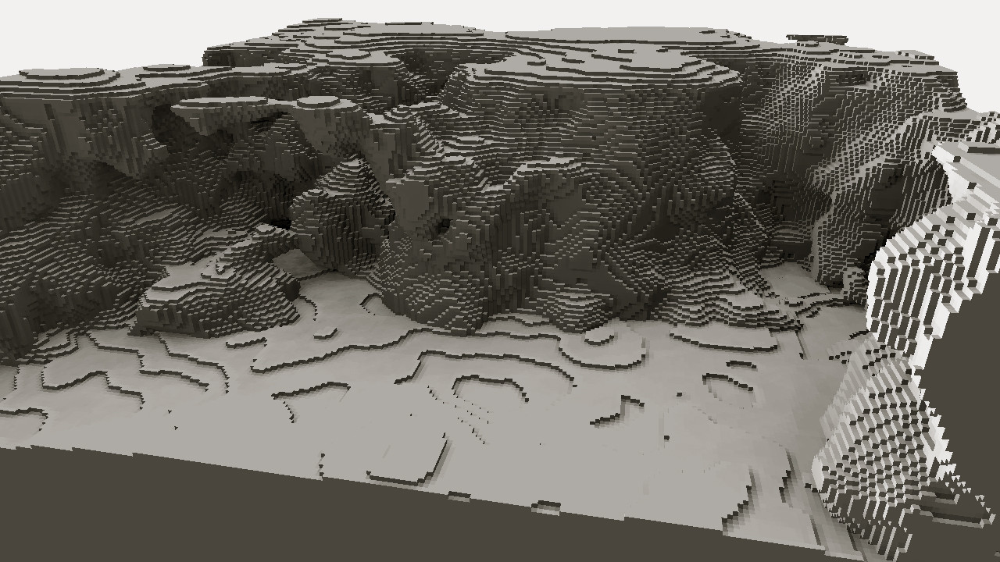

In [12]:
base64_data = "/9j/4AAQSkZJRgABAQEASABIAAD/4gxYSUNDX1BST0ZJTEUAAQEAAAxITGlubwIQAABtbnRyUkdCIFhZWiAHzgACAAkABgAxAABhY3NwTVNGVAAAAABJRUMgc1JHQgAAAAAAAAAAAAAAAQAA9tYAAQAAAADTLUhQICAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABFjcHJ0AAABUAAAADNkZXNjAAABhAAAAGx3dHB0AAAB8AAAABRia3B0AAACBAAAABRyWFlaAAACGAAAABRnWFlaAAACLAAAABRiWFlaAAACQAAAABRkbW5kAAACVAAAAHBkbWRkAAACxAAAAIh2dWVkAAADTAAAAIZ2aWV3AAAD1AAAACRsdW1pAAAD+AAAABRtZWFzAAAEDAAAACR0ZWNoAAAEMAAAAAxyVFJDAAAEPAAACAxnVFJDAAAEPAAACAxiVFJDAAAEPAAACAx0ZXh0AAAAAENvcHlyaWdodCAoYykgMTk5OCBIZXdsZXR0LVBhY2thcmQgQ29tcGFueQAAZGVzYwAAAAAAAAASc1JHQiBJRUM2MTk2Ni0yLjEAAAAAAAAAAAAAABJzUkdCIElFQzYxOTY2LTIuMQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAWFlaIAAAAAAAAPNRAAEAAAABFsxYWVogAAAAAAAAAAAAAAAAAAAAAFhZWiAAAAAAAABvogAAOPUAAAOQWFlaIAAAAAAAAGKZAAC3hQAAGNpYWVogAAAAAAAAJKAAAA+EAAC2z2Rlc2MAAAAAAAAAFklFQyBodHRwOi8vd3d3LmllYy5jaAAAAAAAAAAAAAAAFklFQyBodHRwOi8vd3d3LmllYy5jaAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABkZXNjAAAAAAAAAC5JRUMgNjE5NjYtMi4xIERlZmF1bHQgUkdCIGNvbG91ciBzcGFjZSAtIHNSR0IAAAAAAAAAAAAAAC5JRUMgNjE5NjYtMi4xIERlZmF1bHQgUkdCIGNvbG91ciBzcGFjZSAtIHNSR0IAAAAAAAAAAAAAAAAAAAAAAAAAAAAAZGVzYwAAAAAAAAAsUmVmZXJlbmNlIFZpZXdpbmcgQ29uZGl0aW9uIGluIElFQzYxOTY2LTIuMQAAAAAAAAAAAAAALFJlZmVyZW5jZSBWaWV3aW5nIENvbmRpdGlvbiBpbiBJRUM2MTk2Ni0yLjEAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAHZpZXcAAAAAABOk/gAUXy4AEM8UAAPtzAAEEwsAA1yeAAAAAVhZWiAAAAAAAEwJVgBQAAAAVx/nbWVhcwAAAAAAAAABAAAAAAAAAAAAAAAAAAAAAAAAAo8AAAACc2lnIAAAAABDUlQgY3VydgAAAAAAAAQAAAAABQAKAA8AFAAZAB4AIwAoAC0AMgA3ADsAQABFAEoATwBUAFkAXgBjAGgAbQByAHcAfACBAIYAiwCQAJUAmgCfAKQAqQCuALIAtwC8AMEAxgDLANAA1QDbAOAA5QDrAPAA9gD7AQEBBwENARMBGQEfASUBKwEyATgBPgFFAUwBUgFZAWABZwFuAXUBfAGDAYsBkgGaAaEBqQGxAbkBwQHJAdEB2QHhAekB8gH6AgMCDAIUAh0CJgIvAjgCQQJLAlQCXQJnAnECegKEAo4CmAKiAqwCtgLBAssC1QLgAusC9QMAAwsDFgMhAy0DOANDA08DWgNmA3IDfgOKA5YDogOuA7oDxwPTA+AD7AP5BAYEEwQgBC0EOwRIBFUEYwRxBH4EjASaBKgEtgTEBNME4QTwBP4FDQUcBSsFOgVJBVgFZwV3BYYFlgWmBbUFxQXVBeUF9gYGBhYGJwY3BkgGWQZqBnsGjAadBq8GwAbRBuMG9QcHBxkHKwc9B08HYQd0B4YHmQesB78H0gflB/gICwgfCDIIRghaCG4IggiWCKoIvgjSCOcI+wkQCSUJOglPCWQJeQmPCaQJugnPCeUJ+woRCicKPQpUCmoKgQqYCq4KxQrcCvMLCwsiCzkLUQtpC4ALmAuwC8gL4Qv5DBIMKgxDDFwMdQyODKcMwAzZDPMNDQ0mDUANWg10DY4NqQ3DDd4N+A4TDi4OSQ5kDn8Omw62DtIO7g8JDyUPQQ9eD3oPlg+zD88P7BAJECYQQxBhEH4QmxC5ENcQ9RETETERTxFtEYwRqhHJEegSBxImEkUSZBKEEqMSwxLjEwMTIxNDE2MTgxOkE8UT5RQGFCcUSRRqFIsUrRTOFPAVEhU0FVYVeBWbFb0V4BYDFiYWSRZsFo8WshbWFvoXHRdBF2UXiReuF9IX9xgbGEAYZRiKGK8Y1Rj6GSAZRRlrGZEZtxndGgQaKhpRGncanhrFGuwbFBs7G2MbihuyG9ocAhwqHFIcexyjHMwc9R0eHUcdcB2ZHcMd7B4WHkAeah6UHr4e6R8THz4faR+UH78f6iAVIEEgbCCYIMQg8CEcIUghdSGhIc4h+yInIlUigiKvIt0jCiM4I2YjlCPCI/AkHyRNJHwkqyTaJQklOCVoJZclxyX3JicmVyaHJrcm6CcYJ0kneierJ9woDSg/KHEooijUKQYpOClrKZ0p0CoCKjUqaCqbKs8rAis2K2krnSvRLAUsOSxuLKIs1y0MLUEtdi2rLeEuFi5MLoIuty7uLyQvWi+RL8cv/jA1MGwwpDDbMRIxSjGCMbox8jIqMmMymzLUMw0zRjN/M7gz8TQrNGU0njTYNRM1TTWHNcI1/TY3NnI2rjbpNyQ3YDecN9c4FDhQOIw4yDkFOUI5fzm8Ofk6Njp0OrI67zstO2s7qjvoPCc8ZTykPOM9Ij1hPaE94D4gPmA+oD7gPyE/YT+iP+JAI0BkQKZA50EpQWpBrEHuQjBCckK1QvdDOkN9Q8BEA0RHRIpEzkUSRVVFmkXeRiJGZ0arRvBHNUd7R8BIBUhLSJFI10kdSWNJqUnwSjdKfUrESwxLU0uaS+JMKkxyTLpNAk1KTZNN3E4lTm5Ot08AT0lPk0/dUCdQcVC7UQZRUFGbUeZSMVJ8UsdTE1NfU6pT9lRCVI9U21UoVXVVwlYPVlxWqVb3V0RXklfgWC9YfVjLWRpZaVm4WgdaVlqmWvVbRVuVW+VcNVyGXNZdJ114XcleGl5sXr1fD19hX7NgBWBXYKpg/GFPYaJh9WJJYpxi8GNDY5dj62RAZJRk6WU9ZZJl52Y9ZpJm6Gc9Z5Nn6Wg/aJZo7GlDaZpp8WpIap9q92tPa6dr/2xXbK9tCG1gbbluEm5rbsRvHm94b9FwK3CGcOBxOnGVcfByS3KmcwFzXXO4dBR0cHTMdSh1hXXhdj52m3b4d1Z3s3gReG54zHkqeYl553pGeqV7BHtje8J8IXyBfOF9QX2hfgF+Yn7CfyN/hH/lgEeAqIEKgWuBzYIwgpKC9INXg7qEHYSAhOOFR4Wrhg6GcobXhzuHn4gEiGmIzokziZmJ/opkisqLMIuWi/yMY4zKjTGNmI3/jmaOzo82j56QBpBukNaRP5GokhGSepLjk02TtpQglIqU9JVflcmWNJaflwqXdZfgmEyYuJkkmZCZ/JpomtWbQpuvnByciZz3nWSd0p5Anq6fHZ+Ln/qgaaDYoUehtqImopajBqN2o+akVqTHpTilqaYapoum/adup+CoUqjEqTepqaocqo+rAqt1q+msXKzQrUStuK4trqGvFq+LsACwdbDqsWCx1rJLssKzOLOutCW0nLUTtYq2AbZ5tvC3aLfguFm40blKucK6O7q1uy67p7whvJu9Fb2Pvgq+hL7/v3q/9cBwwOzBZ8Hjwl/C28NYw9TEUcTOxUvFyMZGxsPHQce/yD3IvMk6ybnKOMq3yzbLtsw1zLXNNc21zjbOts83z7jQOdC60TzRvtI/0sHTRNPG1EnUy9VO1dHWVdbY11zX4Nhk2OjZbNnx2nba+9uA3AXcit0Q3ZbeHN6i3ynfr+A24L3hROHM4lPi2+Nj4+vkc+T85YTmDeaW5x/nqegy6LzpRunQ6lvq5etw6/vshu0R7ZzuKO6070DvzPBY8OXxcvH/8ozzGfOn9DT0wvVQ9d72bfb794r4Gfio+Tj5x/pX+uf7d/wH/Jj9Kf26/kv+3P9t////2wBDAAMCAgMCAgMDAwMEAwMEBQgFBQQEBQoHBwYIDAoMDAsKCwsNDhIQDQ4RDgsLEBYQERMUFRUVDA8XGBYUGBIUFRT/2wBDAQMEBAUEBQkFBQkUDQsNFBQUFBQUFBQUFBQUFBQUFBQUFBQUFBQUFBQUFBQUFBQUFBQUFBQUFBQUFBQUFBQUFBT/wAARCALQBQADAREAAhEBAxEB/8QAHQAAAQQDAQEAAAAAAAAAAAAAAAMEBQYBAgcICf/EAG0QAAIBAwQBAgQDBQIIBA4CIwECAwQFEQAGEiExBxMUIkFRCDJhFSNxgZFCoRYzUrHB0dPwCRckYhglNFNVcpKTlJXD0tTh8TZDVFZzgqKjpOMmNUVGY2Vmg4SlxERXhbKzwhlkdHWW4ieGpv/EABgBAQEBAQEAAAAAAAAAAAAAAAABAgME/8QAIhEBAQEBAQEBAQADAQEBAQAAAAERITECQRJRYXEDIhOB/9oADAMBAAIRAxEAPwD6W6w2NAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0CVXWU9vp3nqp46aBMcpZXCKuTgZJ68kf11URv+GNg/7N23/wuP8A16mwH+GNg/7N23/wuP8A16bAf4Y2D/s3bf8AwuP/AF6bBtDu2x1FXT0kV6t8tVUuY4IEqoy8rBWchVByxCqzYH0Un6abDEroo0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaDWaaOmieWWRYoo1LO7nCqB2SSfA1RBV3qBty3QiSW80jqW44gk95s/wAEycdefH9dTYY4D69es3qTQXuCb0tns1xs4pE96nrYGFQ1QZH5cS/FeIT2/J++uf19X8WT/Lztc/xN+uEd7qILzeNnWGrQgSU1ZeRTunyAg+2lThcgj6DOc/XOsf1VyKXU7u9Saqsnlj9Xtg0cUjsywpXUxSIE5CjlCzYHgZJP3J1OiJuPqbvmz3OKkrfWPbJ5x+5zt9H8aAOx5jpCucqeiwIHeOxlor+6PWS6PVU6v6qXa4PHDIhkstmWCIFwVcMGeEswHYbieOQVIbOFEHSeopd1Lepu++X1X4fIzj7/AB3+jQdJ9E/UKw2Pen+F9lpfUDdW6KEJzuIoIqkxloniPIe4/TIWUBiSAvRyM6TnVelLZ+MHc1fXRwT2HeduifPKpqdtgxpgE9iNWbvGOlPkeB3rf9VnItto9etybhlQ0dzrqdaWpp5aha6yNS+9EJQ0kSmWFM80R05LkpzB84zf6pkXu6fiRhtFDLVz7eqJIo8clpXkqJDkgdRxxMzefoDgZJ6Gr/f+kxGr+MTbL1tqpItqb0qpa2RYpZYrFLHBSklRykeb2zwySeQB6UkgdZv9wxc/+PWwf+6ly/71H/5+n9Qw/oPWTbNXCXlqZ6Fg2PbngYsRjz8nIY/nnrV/qGKz6m/in2H6VWahud0qa6spaqtSiPwNIzNEWV29xw5X5AEOeOW7GFOn9SGOf3D/AIQ70pjEZoa6pqM55/EUs8XH7YxG2fr9vH66z/cMR8v/AAjPprEAXmxnx8lT/wCj6n9ww0un/CT+nVvoZqiCCouUsZAFLSiVZHycdGSJF67PbDoHycDT+4Yr/wD+1M2T/wC8bf8A/vkH/nav/wChjP8A+1M2T/7xt/8A++Qf+dp/+hi/el343rf6sftCa1bRraShpBGBNXVSq0sjF+agKrD5QEJPLP7wZA6Jf3pi8VP4h0o6aaeSwSMkSF2EVQ0jkAZPFVjJY9dAAk+ANX+jCvob+Im3+sO2Lld6+3rs6Sluk9vjobnWL78iRhP3jKVXicsylfmwUI5HGrPrTHRf8MbB/wBm7b/4XH/r1diH9BcqS6wtLRVUFZEG4l4JA6g+cZB89j+uqHGoo0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNBz71d9edn+h8Nsk3XXTUrXIyCmjgpnmZxGF5n5RgAc08nJ5dA4OJfqT1M1wzfv48/Ti97dvFos18rLdUV1DNTRXP4eoimpJXRlWVAsZyVJDAhgcj6edYv3L41I8dXTcNqudSzn8Ql+ScszSOaC4FnJPZJ9zs5+v665tI+6XCwmmqkrvXbcN0pGiYTW6OgrA1ShUhowXk4ZYZHzfL331nRFYjHoytMhlbfTn7otEvf1+p60Eza7h6GUgWSay7tuP1IqXhXlk5yfblX+H/AK+9ODt20fRj0c3zQtWWWw1FVR9YqJHr4Y5OyPkaRlD4KkHjnH1xpgn796L7R23sq8vYtp0Mtyp6Coaj9ym+LlMoRmTAk5ljyxgHP28daCj7X9Xd07astHRp6P3MTxQok01NTvTLM4UBn4JTYXJGcDodD6aaHR/EzuMSPF/xYXP3VPEoZ5MhvsR8P500YT8SW8JIndfSC+EL3083j7/9T6uiSsfrhv7cFY1NT+j10hdUMhetrjSpgEDAaWFVJ7HQOfJxgHTQ5216g+oW79yCnSgs+37e001O0dTb6+tlgki5I4M6COnfLxt4kGAQO2GCDfcPoTvO+3qquEXqrdLStQ/M0dBHUrBGT54K1WSoJ7xnAzgADADBKUPoJPDTRCp9Sd9T1IRRLJHeCiM+PmKqVYqCc9EnH3PnTBf9p7cfatnW3td7newrsy1N2mWacA98S4VSwBzjlkjOM4AACZ1oIVtBTXKlkpquniq6eRSrwzoHRgRggg9EEHGgX0BoDQGgNAaA0BoDQGgWq6yor6h56qeSpnfHKWZy7HAwMk9+AB/LUBSVlRQVCT0s8lNOmeMsLlGGRg4I78Ej+egk9v8AqTu/aVokja71N/aGepqkiqER5ZVeZ5Vg5yHOAGEYJdRhRgqPF2xMO6f8Vl1ulnpq+zWqhv7TIkjUttmhkkiVuY5MxqQhAaN0yrH5lIGcEi/3THQdp/iHtG4LFaayvtNystXV08MlTSzRgildlUuhJwzBSSM8ATjwPGtT6iYulk9QbDuO6i3W6sepqzC9RgU0qoEVkU5cqFBzIuFJyeyAQpxqWVOxYdFGgNAaA0BoDQGgi5t1WSmmeKW8UEUqMVdHqkDKQcEEE9HV2JjT/DGwf9m7b/4XH/r1Ngo9T+IGxtJcoaChuFVPRVL0pM8BghlZGwWR27dCO1dQVb6H7Z/qLhj/AMf/AP8AUH/48/8Aken9GD/j/wD/AKg//Hn/AMj0/owf8f8A/wDUH/48/wDken9GD/j/AP8A6g//AB5/8j0/oxFzeu97aVzFQ0CRFjwV1dmA+gJDDJ/XA/hqf3Vxp/x63/8A91Lb/wB6k/8AP1P6pg/49b//AO6lt/71J/5+n9UxKw+v0ghQS2RXlCjmyVRVScdkAocD9Mn+Or/SYYVfrxd3qHNLb6KGDrikvORh13lgyg95+mp/a4R/49b/AP8Aupbf+9Sf+fp/VMH/AB63/wD91Lb/AN6k/wDP0/qmGFd6ybnq5g8VTBQqFx7cEClSe+/n5HP88daf1TDb/ja3X/2V/wDjeL/zNP6pkH/G1uv/ALK//G8X/maf1TIP+Nrdf/ZX/wCN4v8AzNP6pkH/ABtbr/7K/wDxvF/5mn9UyD/ja3X/ANlf/jeL/wAzT+qZD+g9a9x0kJSU0lcxbPuTw4YDHj5Cox/LPen9Uw5/49b/AP8Aupbf+9Sf+fp/VMH/AB63/wD91Lb/AN6k/wDP0/qmD/j1v/8A7qW3/vUn/n6f1TG8nrteykfChoFYL85ZHIY5PYHIYGMDHfYJz3gP7pjT/j1v/wD7qW3/AL1J/wCfp/VMH/Hrf/8A3Utv/epP/P0/qmGVR+Lzb9hmagvdXZKa5xY96KS7R07LkZX92+SvykHs95z9dX+zFq2/+JbaG5aAVVukkuMan25ZLfLDURpJgEpzV/IyPIBwQcDOr/cTEj/x62D/AN1Ll/3qP/z9P6hiU2D6sWL1HqrnS2xbhT1dufhNDcaGWm5DJHONnAWVcgjkhYDrOAyk6llLFy0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0EHV7727RU7zSXqiZFxkRTLI3nHSrkn+Q02Jjgv4ifV/fcEliqvSS4UlSKYTtcqOtp0C1fLgsQUyKCCmJGOGQdjtvGsfX1fxqT/LylvP1V9RLlV24+qFm29SWuN2SG4XyhqLikRJXmsYSSTDsq8gCVDe3+brXK3/ACqR2duD00vdXUwPSbf3FUhBIkVm2XUI8ag4ZmGJSRkqM9Y/XIxRfbnszYVq25V32XZloNLT0j1rp+x4kmKKhcjg6qQ2B4bBB6ONBzex+rPoncZZJJ9tUNmkgKmN6yxxEuezlTEr4xgeceRjPeJsC9h9UPTi21tykuO74LnRVEshp7cNvezBTxFgyJ8sHN2XBHItg5zxyM6vBe9veuuwL5c6Oz2y+xfEzsIaeBqaWFScfKgLIFBPgDPZwB2QNNElD6vbMmudxt7bjoaWrt8xgqI62T4fi4YqQpkCh8FTkqT9PuNOBG4+pNgkqaRqHfG16amR81SVNRHK8iZHSMJ0CHHLsh/I66wWh6vqpsp/G77Cf4XOD/ztBn/jQ2b/AO9bYv8AxlD/AOdoCuvdFvjbN9o9rX+gqrg1JJDHUUVar/DyujCN2aMkp2Mg+ejjxoOXwbM9daKjigi3pZ5FiQRqZFEjkAYBZmpyWP3JJJ8nU6I+52z8QdCiNBd6O4EkApTJSAjz3+8jUf8AsjToVHq/6u2a4wftb08WsoyWDR26mmLnA6+dWkC9keVOQCB9w2iQf8QG8VUkekd8YgZxym7/APjfTaKavr360uAV9PAwPYIslb/5+qJyl9SPXmsYrHsO1qQQP3sTxjv/ALaoGoIaoq/xJ1s0tRDTrSRyOzLAi28LGCfyjmS2B4HIk9dk+dOhhd91+uu2RB+27xQWkz59r42qtUPuYxy48iM4yM4+4++gRuvqL6zWmihhqL9ZaWerWOqp5qmvtUbvCQwBQFwrI+QeWD+QYI+bLoYw+qnq4OpN32Hnjx+07P8A+doJiy+tHqha/e+JuW1bx7mOPxt1t6+3jOePtTp5yM5z4GMd5dEmfX/1FAy1PsYD6k3im/8ATNNoiv8Aj99TXvhqI5NnNSCH2fg/2pSezy5Z9zl8Tz5f2fzccf2c96bRKf8AH/6jCNm+H2MCBnu8U2M/+GaaNNlbr9fKqNbjFT27c1vmVljZpqJoCQ2CyvBImSCpX8xHnrI6dEtfPVn1d2x7H7YsW1LT7/L2vjq+GH3OOM8eVWM4yM4+400aUHq36yXalWqoNpWa4UjlglTRgzRPxJU8XWoKtggjo/TTaHTeoHrvIF9jY1pJ+vuKV/z1A02jT/jJ9cVZ1fY1t5KxU4hcj+R9/v8AiNUMbzuv1c3FSrTXb00sd0plcSLDWUJmQMAQGAaYjOCRn9TqdEJb94+pG0LlIbZ6VUFql48ZBarLUxxSA4ILCKTg5GOiclcsBjkwIWCl9U/XO4/NTbCoBGRkfEUssJ+3h51PnTaOseldx3fc7LWz70oIrbc2qsw00AX20h9qPGCGby/uE5YnJ+gwNUXeGaSmmSWJ2ilRgyOhIZSDkEEeDq+CU/wxv/8A2buX/hcn+vV2iA9Qd+36h2LuGc7lvNFwt9Q3xNJVSNNDiNvnQc1yw8j5h2PI86m0xyDaH4mNivZI1uF5uNNWIxEr3SKonlmc/M0nPnO2CzNgNIzDGPABM0dB/wCM/Zp8btsf/jKH/wA7TRYqWqhraaGop5o6inmQSRzRMGR1IyGUjogjBB1oKaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoEqumStpZqeQyLHKjRsYZGjcAjB4upDKfsQQR5B0HHd6fhW2tvG9rc2r7vRzuqrOTWNUtNjoMXm5tnjhfJGFXA85zgi6b8GmzY45Fmud6mZhhWWaJeHYOR+789Ed9YPjODqYOpbH9NLJ6dUD0VjSopqZ5jUNG9Q7guVCk4J+yj+mqGu7/WLaewa9aS/3Cotsz59tpLfUtHJgKTwkWMq+OS54k4JwcHTRzHYm/8A04rfVuqayEz7hvvvYu1uopKWBIse4Y5UmlIaQ+yC0ixgMWBwCW1B1ne28/VbaUEU3p2tungh/fTUlZUyiSaQsBhIwUjwFGSXY8h1joctbYGHpB+OO87JsklL6tX+gut4e4VCFYoFWenSNUQxOtNHhMSB+2Qls9Ergiz7s9THffT78Znprvja9Te6u7ptqmguEluzdT7aTOqhw8bfVWVgQGCt02VGMnc+pUx2Lbe5rTvCx0t4sdyprtaqpS0FZRyiSKQAlThh1kEEEeQQQexrcuoktRRoDQGgq/qh6iWv0m2Det23j3Db7ZCJGSJSzyOzBI4xgHBZ2RcnocskgAnS8mpOvNEX/CQbbmsdZeE2TfGt1JUw0k03v0/ySyrK8a8eeTkQSnIGBx7IyM8/7/01h1Xf8I7sm07hrLbVbfu1TBS1ElO1dbZYKiKXgSoeIl1DoxAIOR0c/pp/cMZP/CXemHutH+wt25XGT8HS/X/7Z1f7ifyxVf8ACYel9JB7r2LdvHOABR0uT/8AHGn9wxqn/CZ+l7jIsO7v/A6X/wBJ0/uGVJ7Z/wCEU9N907ktNkpLJumOrudXFRwvNSUwRXkcIpYioJAywzgH+Gk+5TEq/wDwgXo6n5rtch/+TZf9Wn9ww4rvx6eklsnSGpuVxjkeKKdR+z5DlJEWRD191ZT/AD770/uGEaf/AIQP0WlmVZtwVtJEc5mltc5VevqEVj+nQPnV/uGOpelvrpsf1pFyOzb2bx+zfa+KzSTwe37nPh/jUXOfbfxnGO8ZGtSy+J4veijQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0DevuVJaoVlraqCjiLcQ88gRSfOMk+ej/TVRX6v1P2vRVDwyXeNnXGTFG8i+M9MqkH+R1nYuIuv9a9uUkoSI1dcpXPuQQ4UHvr5ypz/ACx3qf1DHEPUv8ZEtJul7NtVttxUKU3Ke43q+wUssNSsrK8AiAlOQoU5ZcdsMggazfv/AAYiq/8AEfQ3CYSTeo1tRgvHEF2hhXGfsjAZ784z/TU/q1rFa3R6ibG3sKYbi3Nt6/im5ex+1K+Cp9rljlx5seOeK5x5wPtqW76IKD0s9M951cN6tlvt1RJSOESrsVY0CxyKeQ/6ndQHHIHP5vy99DUwdDWF1qpJTPI0bIqiAheCEFiWBA5ZPIA5JHyjAHedCG3ptaPdtlNGVoPfWWOaKS40CVsSlXBYGNiM8k5pkEEByQQdZFdg2pu3a9onh2zNs+mkZ/cFIljmo4Hc4DMzR1DYPEeeJzxA68gKpT7c9cGrK5rhd9m3a31avGbZWQyGnRWPajjCrsAMrh2bIJzk96nQxf0G3PfHNRV1uzdsyL8gpLNteCridfPNnnAYMSSMDrCg+SdMFW3G142Fe/8Apt6W7Zr9uQVhpYbhLSQU8lQp5JFJLKp9pOWVZiY1QE4wnWA9FbTttst9jpmtVBbbfT1SLUslpC/DszKuWVlVQ4IAw+BkAdDxqipbh/D/ALJ3PeKu51lrdayqf3Jnp53jVmx23EHGT5JxkkknsnTBFL+FzYAyGoKqQHyGq37/AKEamQJH8KXp6JmdKCriBx8i1jkD+pJ/v1cHPvVj0v2l6WVNqq6bZtduW3zRVLVSCtnjEJT2+LM6A4XDPnP2BzgEGDf03/Ets7aFnktkOz6qw0SP7kcdvnWrMjtnkztIUbPSgEluuugoGm4LWfxf7NB/+Zl9/wC8Q/7XV0H/AEX+zQpP7Mvn/eIf9rqaIy5fjLsDUy/sXb10uFYXC+xVtHACDn8pUyEnOBjj9fP0LRF1v4mPUC9xwttv05njCsyymeCorA5wCAvBY+OO85znI8fVoi7v6ieu92koauKih2zDVFaWGnlgp6YTTFmwoFUxcu3gKD2FyB5JbREVW7PVq8LW2e777slidG4yNLd7fTSo6sMx8oD7iNkdjrwQfsXQnWbBN9sxXd/rXaaylppffamju7V+VUdsiswJkwXAAUn6DOcagi6PY/orxQVfqLcpmBbPsW2WMEZPHzE3YGAfv34zgA2qrf6HQU7zrdd41UsVSYFghSANKgGRMvKMKEJ6AJD99qPOrwM0PotNOSP8PAwGe/gsacCsdZ6MOeIG++h9fgtOBSo/4mvYfn/h1x+uPgs6nAlSN6L4AT/Dv6j5vgtXgXl/4mzDID/hzx4nOPg86nA3pJvRhUEcf+HeF+rfBfXTgKqD0emnST3N8KowMcaM/f650EjaqD0Xq62Kmnrt5W+N8lqqpWmMadZ7Eas3ZGOlPkfTvTg2vGxfSmol5Wn1IqaWHh3HWWiedi+T3yVUwMY64n6nP0AWK0bk3vYNsQQ7c9T9uXC10wMVJSz1MENV7YcqAy1UasuB4DNgKMKSOOaEv+M71Ykf2v8ADXb1M5/ty3K04X+IBJ/u1NofR729VHpeb+qGz4HAJxJX0Hf6DEZGTq6IYWnflwrZ6mf1nsUbTMXIj3UyICxyeKJ8qj9AAB4A06FaDb++6GsgqF9b9vu0UiyBZd0yyISDnDKylWH3BBB+o0Epcd/eqdFgweoe1rh8wBSmuFtBAx5+dV6/v702ix2zefrta7PHO9ht+4YqgiWGrPsylkZQV4/DyqCmBkNg/m8+BptDSX1s9ZIjIkuwEyhKnjZ6tlJH2IkII/UabRUN0+rG27g5p9z+k1LHeFZZKtoqp6CV5iMszBYw45FicMx8jJOAdQVBbv6eXC7wfE7bvlmoihWQ267RzsDgkEJLCMknAPzgY7xnyCVzpPTuacNbLnuekQZ5LV26mnJ8eCs6Y+v0+327B9tOHblBW1NRQeol12vVcBGJXtckTTITkgNBM5wCqkhsDsYzjoHB3HfgjAesHJvsKy6/7DQXCh3d6i2iwQGg9Tdu3CIKHjimudM1SwY5+Y1KhgRnw5BGMYGMadExQ1f4hq6jiqYZkqIJlEkU0TW1kdCMhlI6IIOQRq9Cb338QdsrUMtLNViJ1ZofhaV45B0eJaMZwR0eLA/Yg6B7L62escLssmwl5ISGK2irZevsRJgj9RptG1p/EN6j0c7te/T6SeDh8sdNR1NM4bIwSziQEeRjH276wWiS/wCidv3Ph/xaXLl9viJP9hpoqx/FbvesvYkotmQmzFkcQGKeSZk65YmGFye8HhgZHTY7aLMPxRXxgD/xa3Dsf+7Mn+w00R9V+MSegnaCp2RJTzpjlFLcSrLkZGQYc+CDp/Q0T8ZM0/ywbJeolP5Yo7kWY/wAh00I3n8XG4RbVWh2G9DcJ/8AqZqyaSZG4sOeEEaFus+GGMgnxgtCP/RN+o1XYqZaPYBe78uUtQKWpkgePLY4xDDKe0+YuR0euxho1X8Qfq6kayT7GhhQgfM1orFGftkyfx1NGlN+IL1jnyP8Aozj/Js1Z/tNXaHknrt6wRRtI+w1RFBZmaz1gAA8knnqhK3/AImPUGnq45LjsuKpo1z7kVNSVEEjdHGHYuB3g/lP26znTQ+n/GHNSymKo2TJTzL+aKW4lWX6jIMOpoXsv4yrbU1kiXTbNXRU4QlZKOqWoctkYBVljAGM95+g67yGiab8Xuzh/wDO2+f94h/2umjH/Rf7N/7GX3/vEP8AtdXQf9F/s3/sZff+8Q/7XTQf9F/s3/sZff8AvEP+100H/Rf7N/7GX3/vEP8AtdNDm3fi22PWVsUFRFdrdE+c1NTTK0aYBPYjdm7xjpT2RnrvTRO/9El6cn/6Iv8A4xqf9npsB/0SXpz/AO9F/wDGNT/s9XYD/okfTk//AERf/GNT/s9Z0Jr+Jr01ZCw3JlR5PwNT/s9a2DMf4mPTaXHHcec//uNT/s9Ngj77+Kz0+s8CvBX1l3lLhTBRUbq6jBPImXguOgOiT2OvOJsFSrPxT+mVwukNzqtrXGpuUKe3FWTW+leZE7+VXMuQPmboH+0fvqbBObP/ABSWXeW+rVt212WppaCqjflXVsqRGFkjd+IiXkCMIozyH5j113dV29JFlRWRgysMgg5BH31pHJfVX0+ue4b5QSQ7Y23uOz1VTFDXe7SmC5U1OGVmdKgTLy75nA4kcgOLgsdZo7p6X7uqfSnaNHtyw0cEFmpQxp6OqDSGDm7SOOfPkcs7E5Zv0wNalsMdCsHrvIJpRe6FTEVHttQKeQOewQ7dg/fPWPBz1qfX+WcWCk9btu1NQkciVtKjZzNNEpVevrxYn9Ogda/qGVL0nqftetqEhju8au2cGWN418Z7ZlAH8zpsMWCguVJdYWloqqCsiDcS8EgdQfOMg+ex/XWkaXC82+0+38dXU1H7meHxEyx8sYzjJGcZH9dQebtz/hE9Kb9Luz4/d1zp33PeYtwVYS5UilJgKllEeYjiMisc98icJ30c4vzKu15n/Ej+FnZHp6LDT7N3bClRW+/JPXbqvUEdMFj9sCOJY4AZHYyk8geKiMg9uuuf18yeNRzaf8H++5XUSXHbytGfHvzj/wAl+ms4LHaPwdXI0ETXDdVLS1hzzipaFp417OMO0iE9YP5Rg5Hfk3+RCbs9C90+lkVXfqK+Qy0lGjPFVUUdVHVDETF8rEjiMYDLyZwuMcmHLGmNa0rfTv1vr6aWnqKe7VEEqGN45b9GyspGCCDLggj6amVNRnqB6ObtstssiU+0p6xKeiignqKFUmkmncvO/NI+TfuzIYeZyCIVIIDKAwVndMclBuuCI2CSxvHSwmGnuVKlP7ywwhDM0cgCkyNE7lfmyzFcufMIaPvCSij5vRWl1z+VrNSPk/wMeNFesvwD7I9Sqr1IS+Vi7g23sKKGW6mllikpbfdJqiP24vbhyiOOJEgdFZVESDrkh11+JdYr6Fa6oNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaDyd6kf8IdtXYO8L3ts7avFTV26rqKA1I9r2zLExRm48wSvIHHYJH+ST1i/a/y5Tu7/hOqoQQpY9uyFgxM0kxSnYDwAMmYMDk56UjA7OTrP90xT7v+OD1U3QrPYNrXOOvEwSX97UTxgBM8RFCkfFsFTnPj6HOdZ/q1cU6v9XfVy/pRpc/T2uNuFQHkFrp7lRTsF/MBJFKGAIY45ArnvB46m0WeH1+u+2nqEi9IK21PVzNVTKheEzSt+aRv+TjkxwMsezjzpoU/6KK+/wD4tLj/AOEyf7DTRynd28Nq1lXV1l09L6+3V1weWVqlrzNGzSMcs6h4iuctnGMdjrHWoKa1z2cT/wDMC+fb/wCbcP8A6JoLMw9HQM53xj/7T04MZ9HcdHfGf4UeqICek2N7p+HvW4I4f7Ky2iB2H3yRVDP9NTAzni2XTyBWvt+7GciyQ/8ApegcUm2Ns7mrIKO3XTclZVtyCU9Nt+KWR8DJwq1eTgAn+R0F9s34f7I9vjmu+9v8FJpMmOi3FQw0lS6Alfc9s1JIUkMBnBPEnGME3BbPTH04216e79ju0vqXZau2x05wKS6rSySTcwQkihyHiwAxHMZYKCpGcoPRW6trW/ediqLPdY2mt9QV92JXKFuLBh2Ox2oPX2+2r/ocHuv4NKGWcm2bnqKaDH+Lq6RZmzk/2lZB4x9Pp+vUsDfau1fWP0eo0obPQ2i92xjJ/wAniVOIckH3Gb91IxIGASTgDBAwuHQpU+s3rLRTtDLsOIuuMmK11Ui/fplkIP8AXTaGU/r96twOY32REkxGVR7TVgn+XufppoTpvX31kqOWNgof8krZq3v/AOKabQyuPqr6p7jj9m7+lVHcYkYMiVe3KuVQRkZAZiM9n+p0CdDP6g1yc/8AiV2qikBh7li9s4P3DSA5/T6aggptl+rldXVJg2RaKRTISIUsltEcYJOFVnQkqPGSx6xknzoHFdV+rG3i9tuF0sW1qirhy3vVFqopeB5AOCuHHYYBl8HwQRq+De7WvdXqPTNFuj1d2zBTtGFalS8wiJ+LgqHii4oTnLcuz0o+gwEPWbS9Pq64Vcm6fVme5XYEI9TDQVFQGZflOZSG9xcABWBxgddY1BUrzJ6a0fsrbaLdVyYlvdNXWU1IEHXHjxil5Z+bOcY68/S8GbfuPYdLEOew7ncPaBZ3mv5GQTgFuFOoHZA6x9NBYqPcuw6zIo/R6prjGByaG/VTkH6Z4p1nB1BLWu67tqx7dL6KWB8tkGTbk+MjvHJnwPHjP+fQL7htnqZV0aXCbZO2dr2mlj48Zbbb4IIyXxyJqSxUsxUYyAcDr6mjS0V2940MX+F+waCMBVTMtqCgePCRnoagrNT6n3utli+O3PturMDkxSS2CN+PY+Zc0eRniD9D4+2gcXDfV8vFskojvax0Ub4y9NbHp3GCDgPFSBl7A8EZ7Hg6BW4eoV9r1NNW7q21cqdSGHuWJHjLY8gNR/TJHj6nQTtj3Lu27UzT0e8NnU8auUIqoKKlfOAchZIFYjsdgY8jPR0Gt6u++pUNLLftmXamcBmAms7R5z4IkA7GAfH20DOhv13s9H7Vft709u0ryFhPM9v5gYHy4p5kGPr2M9nvxgGdHabjuFqqe1+m9hugiPuTi2VVVN7eckfJFVnGcHAA+mANBGXjYm57iYjS+nFfaCmeXwdBWt7mcY5e6z+MHGMeTnPWAbW7Yl1tNdFPfthXiupC5DKYaimdjx+VVfiQOxn8pJwR/AFtw7crLhPBHZPTG50tJxBY1C1dVIz5bJDKEAGMdcc9ee8aDag2ZfKMxS1nprXyUiENMFpa2NjGPzYYsQpxnsggecHxoF7rcNowQGKf0+vFqaT8kxvLKxwRnjzpyD9B4PnRUL8bs1XLCw33J/8Aq3D/AOiaIUtb7HrXqxcY9wW1FIEIpZIKssCTnkWWLGOvGc5PjHcCVVRbN9xlgvV8CdlFltEJOPoCRVd/xx/LVFmpN519ySpKeq18t0kXH20ujVaLNnOcGF5sYx9R3kfrgJXb9x3jfI6622/1Bs+4hUGJWt94mMpqH5H244krogGYsB0v145PjQTtt2R6o2aqeap9Pdt3eJlKCCptlv4qcg8h7JRs9EdnHZ6zjQQd6uFTYbvTDefpXY7ba6mVUlnghqaRVLZxiWN3C4xyKqpYqCAO9Be7JZPQPcvCFKmlt1Z7PuTK9dVQxK3QIWScIGwT10CQM8fOLkCld6Fekd7q6eC1byhpqmVlijp6e6083usTgAKcsWJIHR/l3pkDGT8N/qHtGP4bam9GFA59ySOOqmoT7h6J4KWU9KvzZz9MYGdA8nT8RMEsiLKs6oxAljFv4uB9QCAcHz2Af006N7Zuj1929BVy19ihvQ4hwKiGFmjCg54CndSxP2PI9DA+7aGdR68esFMvOTYaxxDy72esAH8+em0J0f4xrjQQfD3baUUlxiZkmMNW1OoYMevbZHKkDAILHsHx4D+hcqX8XeyqiphiejvNMjuqtPLTxlIwT2zcZC2B5OAT10Dq6LCfxJ+nAPe4/wD4xqf9npsE7bfWLY92oY6uDddpjikzhaqqSCQYJHaSFWHj6jsdjo6ui10tVDXUsNTTTR1FPMgkimiYMjqRkMpHRBByCPvqhXQGgSqqqGhpZqmpmjp6eFDJJLKwVEUDJZiegAASSdA2s9+tm4aZqm1XGkudOrmNpaOdZUDAAlSVJGcEHH6jU0PtUJrUwtUyU6zRtURosjwhhzVWLBWI8gEqwB+vE/Y6Dc96BKSip5u5IIpD5yyA6yqOuGz7DdoVirrJbq2JW5BKikjkUHxkAjz2dMRUd47a2Bti1Te7atl2m5Twy/Aftmnp4YZJVXrlkAlQxXlx7wf4aDg1+3klhqBTmi9H7nVvH7kVParXU1TTEkgRq0aFA5IwFZh5GcA51BEp6jX5wD/xS7Xx9/8AByT/AM7U0KUu9aue4wy3T0hss9KoIeGhtU1K7dHGGyyjsg5KnIGOvIBat9Vdl0k7U9V6QUdPMmOUclaUZcjIyDCD4Of56cEddPU/YV4uVXX1npj7tXVTPPNJ+3515uzFmOAuBkk+BoGFT6henNOgb/it5EnGP8Iqgf8A6ugaQ7u2A4YN6fVTr9Q1/fv+kQ0G23LjY6S2Tm8+k0lYyuWM9NcK2miWPiOmDF/GCSeQ6PjrJappcb3aKyvjfbnpnTR0XEKyT1ddVn3MnOHSVABgr0QT9c9gBqJnbFdS0NfLUXL0ip7jE0ZQRwmuQhsqQcyPKvgHwoPfnyCFjpvW7ZtmqOKekFpgqIGA/eTIZI2U/doMgg/zyNBP0v4t6GiGKbYVPTjPLEVcq9/fqHzq6HMn4zZoWQtsd0hkyUla5EK+POP3PeCe9NET/wBFB6mXKpke17NpZKRyZIFFBUzMIyflyyuA3RHzAAHzgeNNG1T6gfiA3PUJPQWOoskYAiMEVsSNWbOeZ+IDN9QM549fx06OlejO2/USjv1xve+LlVVslVTxxQ0S1QFPCei5MIUIHAVACnRzJkknOrBex6rbKI/9t9hH6ftOD/ztBA3P8RXpzaK6Wkn3PTySx4y1LDLURnIB6kjRlPn6E4OR5GnAwqfxQ+m8VHPNFfZKp4kZhDFQzh5CBkKpdFXJ8dkDvsgauwKWr8TXp5doImjvM6TvEZXpmt9Q0kQCcnDcEYfKASSCR0TnHemwPbb+IX0/u9ypaCkv/u1dVKkEMfwdQvJ2ICjJjAGSR2dTgS3xszaH4gobfG24jWxWT3OAstZA/D3uJPP5X8+1148Np6M1Xown7d3vfaa91T3fdFDU2+V69ffip4pmTIRQVb5UQIgLYUAdEDBYOfWv8M+7duwPTWf1DqbdSs/uGOl96BWYgAsVWTGcADP6DUyhofwiVt23ALnuHdcl5LlWn9xH92TjxAUyMzEjiCPoR1jxpg9E2qimoaRIpqhqll/tuST/ADJJyc576/gNVTzWkVzde4to0am1bmulkgWdFkNDdqiFRInL5W4SHscl6OPK/prIrM/o16Zb7ip7pBZbbWUzIUintM7RQOAxBx7LKrEHIJ7PWM9aZB3rZXqdcdkWC12Olpqae022GKlp4pA3OOCNFRYw4P0VQOTBj9TnW59WcTFs/wCP/wD+oP8A8ef/ACPWv6TErD67WQwoZaGvSUqOaoqMoP1AJYZH64H8NP7hhaH1x2/LKiNBXwqzAGR4k4qM+ThycD9ATp/UMTtD6lbYuMxjiu8CMF5ZnDQrjoeXAGe/HnWv6hiy6A0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQeY/x5+qP+AXp1arbQ3bcFk3Fcahqm3Vljqfh0PslFljqHDB+BSckKoOXRScAd4+7kX5j5oXf1f3VBNLAN1bgDKOytxlx4yP7euLSvReru7KRVSn3Ne4lBOAlylUD+GG1UV+r3BPX1U1VUmSoqZnMks0shZ5GJyWYnskkkknTAg9xnIEsUOUU9sQSAf4/00E/QXEyL3wPZHWpgmKajq6ujkrEo5moozxepWMmNW66LYwD8w+v1H31AlHUTUFXDV08jw1EDiWOSNirowOQysOwQcEEfbQWy6eoN+kpKf2N4bhqZmT/lEdRUSIiN10pErcxnPZC+B130EDU7x3CsUksl+uTqgLnNZIScd/fVEFLumS81Cy1k9VVygBA9Q5dguT1kk9dn+ulg1rpZ6+t98MkaBUQJGgjGFUL4UAZwOz5JySSSTp/0T21dmS7t+NxcbRQmkh9zN1ro6f3m74xx8z2xwe+lH1YZGQ7p6feqdftWkmNu9KbfXVFMPhWuW2hlPbCI3tvMizc28FiZDnrIyMm6Kb6l+rO3vVG401wum1a6mq6eH2A9HeFXmnIsAQ1Ow6LN4x+bvPWJorNrf0/qaVzcl3JQ1HPCx0pp6lCuB2Wb2znOesfQd/ZgdCn9MSM/G7t/8Epf9roMUe3vTy7z1XHedxsUKcfbS52Yys+Qc4aGVvBH1C+R5wdUdD2J+HqS+0cN/wBn+oEMgjZ40q6WCWCWNwMMp+YMhIP1AyGB8EZmCwVHof6uRylYPUKSaIYw8l2q0Y9d5AU/X9dMooe2r9LS7puVq3t6n7otJt1TPTS/AzzyxzFDw+SXkzKS2TgxY4r5BPV/6O3ba9dvTja9jprad51919jl/wAsucFTNUScmLfM/tDOM4HXgAacFisfrzsPcd3pLXQbgjkrap/bhjkp5og7HwvJ0C5PgDPZIA7IGrwX7WgaCB3faNr11EtbumitFRSUmeNRd4omjg5FQcNIMLyIUfTJxrI4J6nVnoIkkqPbo6uvCCnzthDGIgylhICrLA5GR38xzgEEAgTgkfQD012LvTZMF2rNrQ/tFJmhl98yPE5Q5Vo1d2ypVlBz0WVhjAGiu2WvY23LIoWgsVupAGLj2aVFIYgAnx9QAP5auDl34h7lvzZlLbrvs+8RUFqLpR1NH8JBxikZm4zNJIhCoSQpLFQDx88jgjk+7No+ru3bTPuPcW+aqzUkkgaTFwq2ETSEkKUp0ZYxn5fooJUA9jWeig129bgpNDcvUy+XajqIysxtr1M8LIQQUZah4SSfqOJGCOz2AFcjTa1MKgtUXa48ZMRxezFR5TiCXZ+cuDy5DgF7GG5g/LqiGt94pqUL79DR1gDZ/fvKMj/J+R16/v786mUJ19zpa65PLHTQ0NO2MU9OZGRcL9C7M3ZGeyfP260As8pY8G+U9joeNUXqg3RbLjWJSw7N26kr5IM1XWxIMAnt3qwo8fU/p51NDa83mlpquaI7askDxKPlo6qomjY4zkOKhwfIHR6xjznUDBNwUzHB2/bgP+3qf9toEbhWwVjRGKhp6HhnPw7SHln783bx+mPOmB7Sw0dFToLta7gZpf3sTx1CwK8RA4kBomzkhvmBwf5dgwq/hRKBRwzQxY7WeUSNn75Cr146x/PQIHvQWDbN3isiispL/ebNcJEMchtsIHy8s8eYmQkHCnGPP8M6omZPUa7FSF39u3P6u4/++dTRGS+qW7g7iPd9/eMEhWe4TKSPoSOZwf5nVE5ZvUTdVump66P1LdJwvL2K2asqFUlcEMjROjEZP3GRkHwdNE1J6z7wmGJPUGyyD/nWkn/701RVW3Rdq25w0FDPtSsaZD+//Y1BSxL0SVMk8EYU4H3+oAOetQbG4VslFPBLsiy3prYpapuVFHMwQOCwMj0kyxdAHHXXE575ao7Lt30V9MvVCwD9iXWKgvUiSS+xb7i1SYQGKAtHMiSFMlCcqh7ADYIJBtZdj+sno3XNTbdaPcdhTJSnklVoSpZ8D2ndXjbLcyIzjJGWbB06MXr1f9W6mGooLj6c09VC3KKSJ7NVSxuO1bBEhDAgkZGQQf100UN/UT0xvl2WS5+m0tsgkOZZrXdHLLhcALDhE7IGex9T2eiHRtsfhy2N6i7VjvG3rzfoI5lKxvXxJhJBjkCvtrzCnKkoxXIIDHB0wIVP4Mp/MO7I3PjElAV6/lIdMCNZ6G+r1kpTDa94TVNJToUp6emu9RCeCjCKFbCrkAADOB4zjvTKMVG4fxCWGQVNVSVFbDA6s8EdHSziUZHy4hHMg+DxIIGexjIdHQPRz1f3DvHcVVad1U1LZ7gIy0FrhtlXHOVH5ppHclEjBygz2WOOsANZR2Coo4Krj78Ec3Hx7iBsf10FUrvR3Y9wR0l2rakDoUPsUywkA/Ypgg9+R3+unBXp/wAMvp1KG42OSIn6pWz5H9XOmQc6396M+nHpAbfuO4m+1lILiii3xGCeNjhpAjK6rmP5MHLEkdfXIngsWwvVT0Z2HbHSx1H7F+M4zTxSUtVLLy49K7lXzxyegxUEsR5JKYOubb3hY94UvxFkutJc0CI7inlDPGGGV5r+ZCcHpgD0Rjo6omNaEZuiy/4SbZu9o974b4+jmpfe48uHNCvLGRnGc4yNZHnRvwa1KchHuuJx9C1CVz/8UOpgSb8G1wdSp3PTKGGCRSMcf/DamDqfop6SVvpFZ62g+LoK9qqs996tYGSVowqqqE5+mGIGSAXP3OtSDp+tDOgNBw66fg92JX10s8E13tsT440tLVI0aYAHRkR27xntj2TjA61nA+2l+FfZ21aykreVfX19JUpVQVM0/EoylSowmAQCuex9dMHX4IfZTj7jyDOQZDkj9M60Gm4JrhT2G5S2mCOqusdNI9JBKcJJMEJjVjkdFsA9jz5GpR5ff1R9ernNNFDtyahe5cfhh+yinwntj5+Bkzjnjv3eXn5MdaztEfctpetdYk99vW65bJSsimWWou/wUER+VACqcUU5wOh2e+ycl1VWuE2+LTUQiX1WppUqJUgjem3S8wDN2OXFiUUd5dgFGOz2MzxC99qN4We3RVFT6u0iozhMUu4qiqfJBP5YA7AdHsjHjvsaoj13buFELL6tyzk4+VK255x9/mhH+51AjTbq3DycSesEowcEGtuh/wDI6BzW7lv6PGR6y8F84FZdsn/430CkO576ynPrCc5+tZdf9hoNpNz3qNgG9YgGPj/ld1/9H0Dabd248vHD6qzP4AlFbcgveO+4gf7tAhX7x3FbbXJKfVirrKhVytLSVlxMrnOBgyRomPqSWHQOATgEKzyt25ZKm537cl0euaJXeWaj+JlmcFE4B2mGcLk5YgcUx5wCDumo9h/EkpedxrDlS0ZtFOWA+oD/ABQH3weP8tA/tEXpZJTRG4TbvFThTMlLFSmNTgclVmbLDOcMQM9dDxoJS7Xz0msy0a23aN8vZZWWZrnchSkEccMPaD8ie8/lA+gOegsu39w+jke3Ka6XX0/r6R5auWnjipbhJVA+2kTFmLyRjv3QOPEjo/fGqOh2S8+hUtsudyitaWylppzbXnemnDSCaOQApwLMFdFlAJwwwchcjLgsFj9PfRqiu1suVumt9LXwJFc6eOS6yLIqBBOsjRyScgAmHPID5eyNUQ9J+Hjbt42RdbXszekz0VfWQPWVCyx1cb+yshWE+0UHmZXIbPaocDzqCwbq9MN1zQbBsO37sLLtmyUkdPcZLRUyUVXVMXHvyALlCWC815eHkk5E5zqim1k/4iKirnmjp46SOR2dYITQFIwTkKpYs2B4HIk9dknvU6Gk9T+IqniaRxIVHkRx29z/AEAJOnQ0lun4i5gogjqAT2S1NQr1/NdOhredqeu+/YIbTfqWGe1TSASvVU9uf2AwKmRR+YMqs2CuGGeiDp0Slu/BRRNTq1ZuWrE3fIJSoo8n6c2x1j6n+WmB9u+wem9F6s7e9PLfsiS9uFgppJ4bnVKaISyPK44jPMIkhlLcvDEEjicUOLLs/wBGL5undtgXbNbSybapquqr6mpqZ/aMVO4SQpwmZj5yBxGR+vWnBC2r0D9KL3tKe/WveVfT25ahrfHX3KeKGJar2+YUrJFGW+UhsAjIz2MdTBUdxeiWwLDAlbN6sUJjcrG3w1GKxueCc8YZSVXryRgdDOSNQXf/AKDDGAN4f/cz/wCTav8AIQrvwqbe2xFBWbk3xT01H8RGoNXClLFJgktGWaXOWUNjBBHZ7xpg9BWj1xsdqpmhg9RbRAjNz40l3jhUnAGcCU99ef4fbWpbB0W3er+46igppaS+CppHiVoZ1jilEiEAqwfieWR3yyc5znV/qmHH/G1usf8Az1z/APa8X/mav9VMip+tHqhviq9OKyXadVcV3e7wxQGhkREjAdS8jK7BCCisMAE8nyFAyRLauKvZ7lcdr+hEm5t43CCp3Jb6GarrlaRIVkl5OYoCeICucxxZAILfl55BM/Aj6Gb2n9bNnVl9gty2s09dJRGmao90txjjcMG4L59zGMfTz30nRaK31Dp/TG6rTVu5aXbtc6pP7FRXpCZFBPFipbDrkMOwR0w++ng6daPXC8W/91c6SG4cQQWH7mXln6kAr0OsBR9O/vufViYv1l9WduXlghqmt8rMVCVq8AQBnPIEqB58kHP8ta/qVMW+GaOpiSWKRZYpFDI6HKsD2CCPI1obagNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQfOL/hKbPXP6qWAPU3Wms9VbY5UlaWaWCOYTMlR7CM4QN7SwFkQqCeBbBblrj9+tfPjxTe79JaKy6UlqrK4UkoEUrP8A8naoXHfNFZgR2wGWOQc9ZxrIrLXAKORTio+pbTAhNIJKiRlIKkDGD+mgeWqXlT1kX5jxyqee++wP6f3aDeyTGSSVOXzdEL4/j/o0osnIRRHiej33rId1k9Msr/CRSRQeVSaUSOPvlgqg95+g0DJ5++uj9wdAmZSwZWyykYIJ6OrgkDeau4W79lVF1rqa2sFUpE5kVQuCoEZZQQCB1kY1BolrtFNCWW8XKaYAlY3oEVWP0Bb3zgfrg/wOqGomKyDHg/fQSFTEtdVTm1UNUaaFfeaNn9940GOTMyoowCfOABkfx1BIWreF1o6RqNL7dbfSRIWhgo524F854leahQSSSRnv6HOrlD62epW5LG3xlPfpZZZQ0RhrF+KCD5Ty4yqyDJ8EfN03gHueCeu27ty0k0VxvkW0r7HF+andbbMXzkAH4ciUgFs4BH3PQOqOsU3odTbg2Ler7cLDYnqZLUaqytthqxTKxid1LxSHskmPiMZOSD9Bq4K/Tes/qHsqlalo/Tq2WOCRvdMENjqKdWYjHLiHGThQM/p+mmiab8Z/FT/8p2ev+yf/AMh00b7J9SvTb1Uu90p9x7Qs225pYWnNdUzxKJyzYfMvGMiQlgQRkn5jkce3KJ+X039CJAR8fZUyP7N/P+mbTIIHc/o76Q3KgZbPvC1WWtGCk5usc6eewytJ2CPsRggH7gsgj7F6A71o7TFJs31DppbVUO0hahr54YXYYUspi5Kx+UgnrHED+DKG90/Clvjdld8Vf92UlVPHGsUcs089U/HLHjl1BABOQO/J8fVlC9B+Cyogqg0+6YpIOuSx0hVmGewCWIHWMHB8+Ou2Dpe1fwybO26FappmvEwDKXrByV1Jz2vjI+4A8fxywdSo7fTW+PjTwrEMAEgdnHjJ+v8APVU41pBoKb6gemWzd6hbjum2084ooWzVyTvB7cQ+Y83Vl+Udn5jhcsRjJ1kcN9SfSz0Ul2pUy2LcNrs9zg4yQzUt1es5nOPbeIPIxUluyq5XAPYBBnB5Zr9q3e2UBvM9trEtUrOkNwencU8rnl8qyEcSem6B/sn7aCPoK6GkflPRwVy4IEVQZAozjv5GU56++Oz1oMwKqzDlIroVJCjOUPIgA9ecDPWfI+uQA2grnE7RhiVUEDoffQSVNUI6K5P7wZGpYJO122qvfvfDPSKIiAxqquKnznPj3HXl4+mcdZ8jVD//AARui+JbT/44pP8Aa6CC+Jl/yB/Q6CVtFZZzSv8AtSirJp+Z4tTVqQLxwMDi0TnOc95/loE66os/bW2irIJeWC1TWpMvH+CxJ3nHef5aBjFdpKeeOWHlFKjBkkRyGVgcggjwR99BmvvNVcJ3qKmeaonfHKSaQszYGBknvwANA7lWjpoIWhqqmomdczJNAqLG2B0pDtyHnshfA676DWgvr2uoaWCOF2ZeOKmmjnXHX9lwwB684z/XQG4NwVt9oY6cLRwcZBJyp6KGnY9EY5RoCR34zj+g1AtbNtvUrTrDeaWqrZQojoYo6l5pJD4jUe1gsScDvGfroOv7M9It4bNrrBcJ9iUG6GunKQUFeJOVIiD5llyVhjZ1b5fcDkFR8oYEGj1XYth7etEtLX0+2LLa7rGmTLQ0kYMTFcMEkCKxHZGcDIPgZxqix60DQQ943lYNvVKU11vlttlQ6CRYayrjidlJIDAMQcZBGf0Oshj+0tneoBmt6Vlk3Cxj5yU6Sw1J4Bh2VyegxH0xkjT1XKZPRDavptvY3td9SbLoqhAtHRRVaU7kp7ZYGSZmEychyZCuPmUHoYMR1X0/3Tb90WutFuus99it9Y9FJcp1jHxDgK5K+2qqVHuBQQoB45GR8xos+tCJ3dLcYdrXhrOGN2FHN8HxVWPv8D7fTdfmx56+/WsjzJTeuXqP6Y3KRt4bbirubLFNVzUoppXHBmjiWeIe2QpZmA4sfmcdZ6gmG/GjxUN/gd5+n7U/+Q6aLBS/jF2m1LC1TaL1FUMgMkcUcLorY7CsZFLAHOCQM/YeNXR0jYPq3tr1LLpYqqeeeGFZqiKSllT2OXhHcrw5Zz0GOeLEZAJ00T1+2xadz0iUt3t1NcadJBKsVTGHUOAQGwfrgn+urg48/wCD/Z7Y43S9j+M0J/8AJazmCHuX4M7dL7f7P3NVU2M8/iaVZuXjGOLJj6/fz9MafyK/F+Gr1G2jVTrtrc8UFPPx5yUtbNSPJgdc1UY6LNjs/XxnGmBG02X8QW2vd9iS5Te/jPxdbT1uMZ8e478fP0xnrzgadGKX1Y9bdtXKQXC01N1HDiIam05iBODyVoFXJA6/MR2cjPhtDym/FdvKySmfcO0KdqJhwQRRzUh9zyPnfmD0G6xn6567aPTFguM13sVur6mjkt1RVU0c8tHLnnAzKGMbZAOVJIOQPHga1A/1QaA0BoDQGgNAaCo7t29sOmka77ntu3IpJ3WNq+7U8AMjhflUySDs8V6GfC/YayPP/qrcPQS4VSyxrUGrpy9I8G1aZYUbsn3SWVYn4kEBlJzzGeQA4zgX23+Ge036zW662+iqbjQV0HxEaXa7rRzIjuxiykNPMP8AF8Dy9zsscoh6DByar21faCpqJB6Y1dLRNIRCKulriyrk8VLh1DHHkgDOM4HjUFdgqorpUuts2tR1MpUMaekNVKEUdE9TE4yR5P11ASbqtwKn/BWzVBH+VNWfL/3NQP8Aca0HU267W6Ko2nZaM8gQyTVuW/T5qk/pqBKTc9sWWM/4J2epOey0tb0Pt8tQP108D2Ld1sA/9pNiHf8A16v/APStNEhY1qblGay3+ndHefbYoGSCunTlj8pCzYJ7HXnsfpoLEsm6Ws9bH/xRWi2R/Dyhq2ey1CLTrxJMnOaQopXs5brr7daCpUlwv9I8IA2qVkUhQ0FpkPX+VkHB/U+dUTU193vdeDTS7SqI1zw+IjspI+/5hkZxqKn7RufdtLeIGtVj2tcH9lVe00sFuqGqHSH5340+JGyQ8gCnrOOwOyJ28763rZrnBUT+l+3XrII4J46uPb85aEsqyKA5YFWQtggeGBH01RlN4bW+E2vt/c/p/bret7kiq62anqJLdHTEVE9Ojsv5iETk3zOB858edQV21Psa67Z3FuO8WTcdDQSzU9oppI6uKu9piDKqwtLGhX20pkj/ADMeEgH1zqjoFu9Mtqruz0ykpt3m3z01BR3KhtlzpgJquJ6uSdF9wMEDs0pTguW+XIBGgi7id3zHcFafVrbXxd1kwlLTbikENKjS+67QlnHtlSiRgYbKSOMj6hNVlp9edvwUtttNYbnS01Oua5pKaR55H/ePyadmc8Gcxg9ArGpwM6dDSTf/AKz7eo7T79qr7vcfcnmqYjaPcgMTBUijZokXDKySP8p8OmSe1Do3Prh6xD/6Af8A7jVn/n6bRVU3l+IVKyjgqmuFGlTKsXxMtogMMWWA5SMsJ4qM9k/QHTR3K8etgoPVmy7EobO14q61qdKqpp5WHwpk+ZiE9s81WIrIWDAYJyRxOrojdz/if2ntm/3Oz1luu8tTbqqWkleKCFkLo5VipMoOMqcZAP6amhI+onpRbtvTW+eOPa8N+o45au3UUDwSywMCYxMaTIHJGzwLZ4ydjDEacFbq7n6K3raEGybfea6it810S4x09vpqqSaSpMZhABeJyeQIHEfUDHk5cCtN6Mej1iubCt3XDUTU78WpLhdqYBJFbsOgVckEEFWyPORpkHZ4N07foJqKkfcdE89aiSUkU9bGZJ1ckI0feXDHoEZz9NUG8Ng7e9QKBaPcFpp7nEn+LaQFZIslSeEi4ZM8VzxIyBg5Gg5ze/wl+n919n4Wmr7L7fLl8DVlvdzjHL3RJ4wccceTnPWGQa7h/Chs7cVxarkq7xSD2oYEgpqiPgiRxrGgHKNm/Kg8k6YGsnrx6Yej9LS7csTVFxpIeeI7QfiYoeR5/wCNkkAbJc/lZsYIOMY03AmPxibMP/zsvv8A4PD/ALbTRl/xf7LdWVrXfGUjBBp4SCP++6bBYNn/AIoNnz26tr4Jrht+ipJ4onappgUeSVZCoCRGTPUTZJA8DU0VjevqN6Wb69Sdu70uO7amO4WQUwihgopljl9mZpRyzCTkliDjHXjV3aOVVWy9mb43Q7t6pitvd3reRJ29PH708r/xCrlm/QDP0Gs4LHvb0vsF9htIt/qFtGEWu3wUEMBqI4Vl4EtJI7B2+ZneRul+oBycsVHoD8Gm6tgeg1r3BFuDe9lku95qY+UtHcopaWOCFGMfXT8y0koPRGOHj5tdPiz59L17W27uS1bvstLd7JcKa62uqUtDV0kokjcAlTgj6gggjyCCD2NdplYSOoo0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0EdV7ltFvqGgqrpRU06Y5RTVCIy5GRkE58EHV2IR/wAMbB/2btv/AIXH/r1Ng1l3tt+FAzXugILKvy1KMckgDoHx32fAHZ6Gmwbf4Y2D/s3bf/C4/wDXpsDSq9SNo0NfQUNTumy09bcJRDR00twhWSpkJACRqWy7ZZRgZOWH302CxaKNAaA0CVXWU9vp3nqp46aBMcpZXCKuTgZJ68kf11UQVT6i7apayKme8UzSSY4mMl0GTjt1BVf5kY8nU2LiB3H67bQ21Z6q5z1s1RS0sbTT+xTOWSNVLM2GAyAB4GT+mpfqGOZ0v48/S28yGC03TnUqObC5g0MfHx1JIMFskfL5xk/TWf7n4Yb1n4x7I1Q5pr7tWGA44pNckkYdd5YSKD3n6DU/tcRVd+LSjrJQ8O9tuUShcGOnq6cqTk9/OzHP88daf1TEfV/i4oqOlmqJPUOyNHEjSMsU9LI5AGTxRQWY9dAAk+ANP7pkVWf8d1jqaijMfqHLAIKhJpI47OStQi+Yn5UxIRvqUKt10w1P6pkT7f8ACIbTRsG823P/APLK3/Vq/wBmK5uP/hLqK2ieO0WdL3MoUxSew9PTy5wT8zPzGAT5j7I+xzqf2Y6T+H38bVD6uWq7teNv1FquVvmQGOiZZoXidTwPJmU8uSSZGMY44JyQNT7/AMljs8XrJtmShM7VM0UoVj8K0De4SM4GRlcn6fNjvvGtf1Ex5P8AxfWq/fiGuFhisdJbrfb7N8QI6i4VsglnEyw8iY0hYIVaIgDm3IEH5fGuX1/9NTjyrdPwT75rq+WdLrt9VfGA1TPnoAf9Z1nBCX78HO5bBb/evG6NpWumkcRrNWXCWFC/ZC5aIDJCnr9DqiuXH8P/AOxaCWsm9QtjvDHjktLdJaiTsgdJHCzHyPA6HZ6GghaT0/o6EVNTHvKw1bJESIIYq4PIfIVedMq5OMdkD7kDUDzZPoPv2/1qS0O3KyWFoffSeZDBFIhxgpJLxVs5BAByR2OhoLs34afUtlI/wbx19a6m/wBpqYFG/DX6ksoP+DnzY7Hx1N5/75pgmbZ+EXfdfQxzzy2i2yvnlS1VS7SJgkdmNHXvGemPRHg9a0JO2fg03RNXRLcb3aKWjOfclpTLNIvRxhGRAe8D8w6778GYO3emfofZdtbIttt3DYbDdbxB7vv1fwaTe5mV2X53QMcKVHY+mPA1cF/pNvWqgoIaKmtlHTUUPL2qaKnRY4+Ry3FQMDJJJx99Byzcu5/SewTx1V92pHRQVLOWuNftOaOMy9EIWeAEuwLsMA9I2SOswVG7bh/Dpf6paioWkjkVBGBR0VbSpgEkZWJFUns94z4GcAavBJWrev4frTRR0tPT2l40zhqmzzzyHJJ7kkiZj2T5PXjwNOBvuP1L9C4bW6RWGguomzC0NusohlRSpywd1j448ZVuQJBH3EuDjVzvW1r9cWg2l6ZJKsZdm+JrK2plkjyArcI5V4ee+2GWAB67DoFp/CFJe7XDWruaKjSpJkSnFK83txljxBdvaYsFxkGNPmyMDTBOe/afw71due9743HuqopHMItFvrIRBTxmECNJaR5i+MEspX5Rheh1yeCU/wCjJ2RKozab6R57poP9tq7BxjeHrBtH1LvUNZednV9ulDJHLV227qXWIE5AjeHgx+Yt9CT/AGgNZ4GtWvpNJx+Gm3nDjPL3YaSTP2xh1x9dAraLX6UXOreCo3DuK0KELCetoY2RjkDiBEXbPefGOj34zcGK/ZHp7HM5ofUhBSjtRUWepLjrvJC4PefpqCJn2ns6SNjB6i0EkijIWS11qgn6An2zgfrg/wANA/q96bhpGIb1SqGGSAy1txw2PqP3X+fUG1Lu/clSy8fVGpAIzlq64eP+96uiIn33u1r5LSp6jXEQJ4qv2hWiJyAMgDjzznI7UDo/plolqfdO53UFvVGpXP8AlV1w6/8AiemhVr1uaocFfV54QR2rV106/pCdNELbtkbOyVq/Ueigm44ZIrVWSANkZAJjGR0e/wCHQ0EjcaP0x2lVxSUFRdt6MyqWhLfA06AhgwLlPcZgQpACqMHyexoppvRd2XzacNHcrXQ2WzUayfBUMscFG6FYxzMfukTScsqW7bk2M5IGGo5BdKqGplR4qGGgxlGigMhBI+p5sxz3jz9PGqGT1DAE5IP3GgkKVKeXg8kkkPGPkDHGGMjdYB+YYB777/gdBJW6CGunaJq2C3ALyElQrlScgY+RWOf5Y686DdJkB4xnsnOMaBzSM4iqXkSJ0wsYLvh0YnPJVBBPSsCSCBy+hKnQYJDDo5H3GgVt9se83CGigkp455uXD4mpjp06BJy8jKo6H1P2Hk6C+2+x2v04lkG8thT3qKtihkoZ2urxQkBA0jRSwgpKrc0PRPHoEk5Og7B6LXP0l3JXm2Uvp69LdKhA8qVVO91gTD8Vw7c2QfOCzFEUeGPS5Qdqn2D6f0dbSUU23NtQVdXz+Gp5KGnWSbgMtwUrluI7OPA86uQRV1/Dt6dXmtlq6jbMCSyYytLPNTxjAA6jjdVHQ+gGTk+TpwaUH4c/Ti2/E+1teB/iIWgf4ieabCt5K83PBuunXDD6EacC9k/D56eWCqaopdr0ksjIYyta8lUmMg9JKzKD0OwM+Rns6cFzs1gte3KVqa022ktdOzmRoaKBYULEAFiFAGcADP6DVwP9UGgNAaDl3qp6B2v1TvEd0qrnWUNbDSCli9pUaMYZ2DMpGT25yAR0PI86zmjmlR+DapTj8PuqKXzn3KEpj+GJDnWcDV/wV1dTIGl3ZDF9PkoS3X/fBpgt9FuXan4aLjSbTqKi6yw1gFc9QsCSIDIxj5ueXL5RH4RPCjyc5virhTfiJ9PKqqhp03HGskrqimWlnjQEnA5MyBVH6kgDyTq6iw/8Z2zv/essf/jKH/ztNCVR6j7HqVCT7o2/KoOQslwgYZ/m2mwbf8X2yr3GtcNuWKuSqAnWpWihcTBu+fIL82c5znvOdMGtN6UbNo7jSV1Ptq209XSTCeGSGnVODgEA9dHGcgHwQCOwCGCXsm1rLtr3v2RaKC1e/j3fgqZIfcxnHLiBnGTjP3OglNaBoDQGgNB5q3h+K657Z9RbrbILPSVtkoKl6UpJyiqXZBxY8wzKB7gJHydrjOCesaJnbn4wdu15jjvFor7TK8wTnAy1MSIcfOzfK3XeQqN0Osk41dFx/wCiQ9Ov/ei/+Mqn/Z6bBj/okvTn/wB6L/4xqf8AZ6uwK0v4ivTusqoYI9yIryuEUy0s8aAk4HJmQKo+5JAHknU4LD/xn7N/962xf+Mof/O0D6z7z2/uKqamtV9ttzqEQyNDR1kczhQQCxCknGSBn9RoJjWhDXreu3tt1S012v1stdSyCRYa2sjhdlJIDAMQcZBGf0OsiAvXrfsKw0qVFTuy2Sxs4jC0UwqnyQT2kXJgOj2RjwM9jV0eadx2ff8A651lXCtwiudio6mSW11NxpoaeeWBmYI4KRK+GUISCFByhx0MYVO2T8GVbO6yXG/JHA8fJVhhw4Y4wDkkeM6uUXO2/hG2VYYZa283Gsq6eGAtMaidYYY8YLSclAIAAPk4we9MROv6s+lvphSQ0lLfYqpqaiCQwW9mq/cRRhU5rlAx4DpmH0JwDnTiqPuT8atFGHj2/tuoqA0J4VFynWLhL3jMacuSj5T+dSex150qIXZtktn4la2qv+7qaKz1vupRRzbfVonqCFBzOJBIpwGRVYYOMhshVw9EXuf8Gu5rfVXWXbtwt9xoUDSUcNXK0dTIAuVjb5OHLPy8uSg+TxzgM6rkO9fSzfGxKeiqt02JrZTzyGOKVJY5oywGcFo3YKSM4BIzxOPB0vEV6KUp9vOe9A4FYyj+zoJKgoK6taA/DNFDPHNLFUSqyxyLEhZ+Jx8xHEjr6kA40CeIwC8ys8S9uiMFZl+oBIOD+uD/AAOpQ2qbZWzD9oW60V4t7lVieRGmBJITHNUUElsgYA7IHnQPaawbneJStguDg/UUUv8Aq0E5T1Q2g7iaglF7akeKRpJ8RIs8JUgxGMMGEcpH5umGex1oI3bVVUJuGCakm+FqqNZK2GbiH4vDG0y9Ho9oB3/Q+NQWe0783VX1NqFTuzcNXS1lZ8LLRUNylerZAY+XFC2CWEhCZ8srD6ao6PQ+r0u4K31AqLnBTbk2ZaYZqq101RbIjAk71CRUjPlVb8rtnkeRUP5I1RVaS+RX677YrbhZLnV3ysSOkslLbbuKSmpaeMCmpjCziSRXWeOVvmdRyVWIYM2gp91m2n8VItDbry1OrsI5Ki4RB3TPykqICFOPIyf4nGdZFkue0rXunetVDW3+ahvNWk1zuINs/wCTUb+w1TPHkTNITHh0K8OQZSCNaHZvRTat1uO9KHclh3XFctj0KxUVXSRSVMIlmjoI4SzQOgUnkI2ySegO8jGgv+yazdWwvSW77u9Ubn7tRHJyWkhiiZoYgwRFHsqFMkkjY7ZlAKHKfPqhpa/xH7KrdvwXisqquz0s9VNSQispmZ5HiSJ3wIueABMnkjyftoLbXb62hQ3KSKr3FZIK+lkMbrNXQrJE6nBBy2QQQevodBTqqh9F6lT7jbMUZ5fJPTJ/mI61OCubvsfobUrLd7hdrWRHFFCRbrm0rcUVYkCxRMxOFCj5V6AyfBOmQVS2T/h/tV2obtSXqriqKOZKiI+1VleaNyBIMffYGnBTKO2+h9znr6c7k3Nbfh24xVFXArx1A7HNBHEWx0Dhwhww6znEyCybft3p3N6hUF9pN9pXS2ylSWnop7NVKoNJSYjkdgy8uHsrIVGOXEr9dUUiLYeyampggh9S6QPM4QGe1VMSAkgDLMOKjvskgDyTqYJK+/h8lsd1nopt8bRp5IuOY664/DzLlQfmQqcecjvsEHVD2xfhbvO6KYy0O6NuVlEHMclTbqt6kKwAPHpAM9jrI6OpiuvbB/DJZNrWw092io79M55vLPTqSCVUFVOMgZU47/teNXEXGD0O2LHGAdrW8keSY86uCnbx9OILJXBLJ6Q2fctDJnjNHdUppEwFzzSSMAZJIHFm6XJ45A1MDiDYtDeLHFt65+l9ba7a9XFWFbdcqZoUlaFFZ2b3kfKFnQgKwIQEZyAAdP8Ahg2DKuf2dVRZA6FY/X950wO9u/h02Vti/Ul3o6Od6ulf3IhUTe4itjAbiR5HkH6EAjsaYKnJ+D/bZJ4Xq6r3/a9s9f8AcjTBrT/g/wBvwyl3vlycYOAFjBH88HTB609Bd1WX0m9PbRs2VKx6W3tII61uLlhJNJKxcADAUyY6DEgf16/NyYljt1l3TadxKDbrhBUsVLe2rYkABwSUOGAzjyPqPvrcsqJTQGgNAaA0BoDQGgNAaBvX3KktUKy1tVBRxFuIeeQIpPnGSfPR/pqo+c1+/Ht6gbYut823uGChulbb6+ajessdT8LC/tPxyjGNnILKSGyMqQMDvPD+743kdF9NfxG13qkat7TNuenpKX5XrK2bhEX6/dqVlYlsHJAHQxkjK5baLLNNJUzPLK7SyuxZ3cksxJySSfJ09GmqJf8Awxv/AP2buX/hcn+vTaD/AAxv/wD2buX/AIXJ/r02hjX3KrusolraqarlC8A88hdgMk4yfp2dT0NtUGgNBD3jeVg29UrTXW+W22VDoJFhrKuOJyuSAwDEHGQRn9DrI57ePxR7AtlKstNXVd2cuFMFHSOrqMH5j7oQY6A6Oex15w2Cj3v8ZEIkqo7PtqSROGKeprqkIQ3Hy8Sqeg30D9geRnqaIz8NXqbumDddTbo1morHd4JKarqLFSJbgkiIzozS00aMWALKvzAr7uQc+UtHsq1+qO5aG20tLT3iaSCniWJGqFWaUhVAHORwXdseWYlieySTrf8AVMUi8fil3b6NbTo6LdW47RuO81s0vsXGtoJKFvaAGeqeOVOSFlxlACD3kqcv7sTFitfrVc/UGy0d2t24Kmot8vP2ZqdTTc8MVbICqTgqR2P4edP6tXDKaaSpmeWV2lldizu5JZiTkkk+TqejTVFfu/qBteyVk1DcdzWi21sYHOCqroo5I8gEZVmBHRB/mNZHD7x6TejFyRPg93Wq1gYJamvMblvP/XHYfUfT6fx1MVzptr+ishwvqFcQR5zbpj/5HURgekuwY7F+1z6tUHwh/sfs0/Efm4/4j3fd8/8AN8d+O9MDCg2R6PcEFV6lVcsgY8zBaZ4wRnrAMbY6x9T3oJePYvoWgLDfl5MuDxb4STj46yPh+/66Cwn019DLFbUuVx3hLcYKrh7SrU85Y8qT3FEnNevPNRggA4Jxq4HlDd/w8WDhNAzXF8JCY5qaqlGCygyYdQvyjLHHeAwAJIBcFjq/xN+nGxrYtDtqgqrjDDCzwLRU3sQLISx4MZOLLknJIRum+pyNNkFfg/GsJ+X/AMpvEjvH7U8//EdNFWqvxI+pm6+P7HhhpPh8+7+yreZuXL8vP3Pcx+U4xjOTnOOlob3H0i9YfUk1C3mesaFZviPYulcRCXbl3HGCVXGSOgMBsDrUCw/CPebdb6io3DuWzWWjh4t8Uzs0QyeOGZ+HHsjHnOf6sEOvpp6Y2O4z0V69UFqiqLyFrtsjoGIDdSqJEYYOOvr9iCNUb08vohte7SRsd1bmg9sL7irHHA5IB5KOUUgI7HzDHnz0dQXxvxg2LbFLQ23bu1q6stlNTpDGa+tWB0C/KEChZMgKF75ZP1HWTdEpY/xn2yqqXW67Zq6KnCZWSjqlqHLZGAVZYwBjPeT4HXeQ0Tf/AEYOzf8AsZff+8Q/7XV0ObZ+LbZFfXxU80N2t0b5zU1NMhjTAJ7Ebs3eMdKez313psG17/FtsO0Vogpzc7upQMZ6OlCopJPyn3WRs9A9Ajsd5zhsG9k/FjsW71LxTm5WhFTkJq2lDIxyBxHtM5z2T2MdHvxloiv+jM2V/wBi7/8A+Dwf7bTRF1/41bJHa6aSi23X1Fxbj79PUTJFCnynlxkHIthsAZRcjvrxqaK5uD8WlTvC1C20uybfM1RMqPTXNzXRTDOQoiCpluXAg5Pjx4IaG3pR6R1fqFuE1287Caa0fCNHC1FSRUQ94SLgPHCqkHBc5ZfGO8cdBa5tuegFiu0FPLdKWeoRTVDhWS1MLKoJ4syZQn5D8hPJsgAHkoLgfn8RHpVsSSGjstuq6uBFLrLbqIKkZJIKj3WRgfqcDHzec504Od733/uf1gqLlWWiqrLNtWlp5FkqAlXFFLCeOY50ieVGdQ5yQBlclsAALBxqj29d71Xy0lno5LpwdYzPSRO0YySFYkgcVOCcsB0DnGDqiKraOroqo0lZU0UAqD7zSwyRzImOWByh5cfJ+Uf80kYAIBa4JHHaTNLuCnrqiNBFFTr8QZAvgKpaMKAMk45Drx31qB7trZlZf7d8bTX+0CVe5KCtuIpJlySB3NwRsgcvldsDGcEgao6HUWPdtpilt159NKW5zpLz+KFsmQrlRhA9I6IwHZx32TnwAAiLhYL1c0SKD08koCrhnNLS1zM6jIKnnI3Rz9MHoYI1BVqt3pYLpENs08b0pMc8+KnlSucqA2ZOKty6ww8jGD40EdUUtRBgXCelkz+T2aqKXH3z7bHH08/y0EM94q6dAYJuJHX5Qev5jTA8stTNVgyTEM3MgsABnPf+nSiX9118HrUGRUyL/a/u1eBNIoHlMj4DdnJOO9QTdBc7/tG3TVdJVWumpH5Ms8b0ctYiyLw+Ru5kOCOlwVyT12dX0Zu9PbblDHUpu1r9fqlgjqYHWJTkKvOonZCBx+vEgcSDgDOgcD0Jue5qyGitDJ+2qfP7Vp6ieFooXMjhPbaJnJPGM80ZQylc9hhgKbFTLtG+XCmlu9ZQ1VP+5aW207gk/wBtGEhideLAAgjyD9hmiDiT4qreWrqJGEj8ppePNzk5ZuyOR8nsjP30DqoihikK0s0s0XXGSaMRueu8qGbHf6nU0Wg3d71Z6iSetstFIMhaZbWkU8mMEcXigwMnrtx4OetAnDua2QU0Ucm3bZNIqBWleSr5OQOycTAZPnoAfpoIqruUM8rvT08NJGcYgh5lF6+hdif17P108F62JsOhvVdSUl8pNxxXm4xlrTSW+3R4lV1/dzl5ZF5RdOTgAYXPuAA4Do9r2lFsC53fblR6j3az3ExRtQWi2LVRSNWyxIVE4hWROsopEbOW+jDGDRPWD1X3l6O7og25v25NLbn4SJVTwfGye0ZmBcOJEcKwDnLh2XgoEf000dB9cNnU3qFta27ip0u7TWmTnTUkNpM0z85Y1flSTBS4HAHieIxknkOjR0/a9va1bet9IxqP3UKqEqkgSSMY6jKwARDgML8gxhR2fJfg47+JzbV/uv8AgzdbLbP2q9ulqImphQisP71FwxiZHUqPbYEsOiVx32JRyz/j59WNrV6VF4MxgRipp7na1hjclTgEqiNn+0MMPH1GRqaHrfi93iB/8zbH/wB4m/2umjX/AKL/AHl/2MsX/eJv9rq6LKfxn4BP+B3/AN0//kOn9CYsf4xbBVUjvdLDcqKoDkLHRvHUIVwOyzGMg5z1g+B33gNwSDfi92cP/nbfP+8Q/wC100at+MHZqjJtl9/8Hh/2uroum2/XjYu56X3Ydw0lC6ojSQXJxSuhYE8fnwrEYIPAsB9+xlwX899edaFF9QfRfa/qVMKm7U06XBYVgjraadkkjQOWwFOUPbN5U+f0GM+iiSfg/wBpMSVut6X7ZlhP/k9TBE3L8HFFLOpt+56imh44KVNIszFsnvKugAxjrH8+9MEZU/gvmMZMW7kdwDhXtxUE/QE+6cf00wVub8IW9FAC19kfP+TUS9f1i1RHQ/8AHP6ZfCqhvkMTQmCCAkV0SIvHoRnmqY+UDoHGQOs6ngsNi/Fxua01Bpb/AGSjuBgj9lwnOlnMqkAs5PJc9NlQi9n6YxqaJw/jMwM/4H//AHT/APkOro1/6M//AOs//wC6f/yHT+gf9Gf/APWf/wDdP/5Dp/QnLb+MPbUtFG1wst2pas55xUwimjXs4w7OhPWD+Ufbvzq6HX/Rf7N/7GX3/vEP+100MLv+KL09v9FJR3GwXatpZCC8M1LAyPg5GQZe+wD39QNT0c9vW6/RG9VFROdsbgoZZl4j4JYoljPHAKp7vEHrPjBPkHOnBEW+h9G7rUGA3jdVlwvL4i4Qwyxt3jiBCrNk5zkjHR78anA9/wACfR3/APGDcf8AxdL/ALLTgn6X0Q9L6uminj9SqZUlQOolq6eNwCMjkrEFT9wQCPBGgRr/AEE2BJw+C9VLVT4zz+Inp5c+MYxKuPr99X/+iO/4gNqxHKerO3nPjDNEP/LHUwQ0/ojEs8gg9QdkyQhiEeS7hWZc9EgKcHH0yf4nTBK2n8Kly3TRtWUW6rFXxpIYS1rmNSgIAOC3ygHsdfqD9dMVtafw+7FLyC4eq1klGAUNLVU6EffIMjZ+n28frq4jtW1bzsP0/tdMRvq0zR0FEIZFSthkeREQeFUlmPyggKMnwB3jSQMbx+LnYNqqUhpTc7xGU5meipQqKcn5T7rI2egehjsd5zi7g5XefVPc3rtdKSXbkldstKHjFXSU14mZZEdsq3toqDK8ZO8ZbIGehrOqtOz/AMItDBTt+2atqmrinWRJFTgjIOJ4FeRyMgg/o389MEvuOm9H/TChqJ5Ke3XarpapUkpbfNStXU0gbBIUurjiwAIUkg94wGIuDmlV+LS5UVTcktO3LOtK9Tmkeqhk5iAF8CRRIQXIKdqQBhujkFWhKl/ED6wXOGv+DpZZ/jSs0EkFp5mkTlnEWFIKkELmTmcYwQe9NRYNnbM9QPUHcEFx37DW3m0T08kqW+rcpTiUx+0vKFcLG3B3YFArBhkkN0Z0X29/hY2BcbbHVi33WwfDxvJNFbal6h5Os44uspYjicBACeXgnAGsHlPeezqOn3G9Ls6uk3ZbJ4viqaSlgczxxc2QrNHxBVlK+cAEFGAHIAZETcqeW1NHSSyNK8ESAo+VMTMObR4OcFWZgR9wcgHVD22UViqqSN625XClnbPOOnt8cyr2cYYzoT1j6D+egg7qlupb1Ikb1Vfb1xhmVaaVvlH0zIFwx+5yB9M9QNWrBRUySFS+QFAzjQSU8ZICMskTgD3EkTiytj5lI/Q5H8vA8aosFXda67W+alt81THaaSjgael93hEpX2kd+GcHlK3LoZJbJ+usi3bRtsUm4PTKokvFJRyo8JSnlSZpHxcJiOPGMr2cgZYdjvA71Rts2/WR/TXfVNWww20SyUcgobfWe1NXr77n2wZvdPGLKnKKGwo5Mck6TxUbSz0f+E+yZaa6vR0aRoKdp5oXe0t8VNxMr8ArhZD75DKuUcLkDDaqEbdT00u073FQ3+OhtL11KlRNc6WWJ5D7crRKBCZcgkTFgwwPbiIOSQodZ2htx796h0FBuKosdJtC8UkXzVVTS09deoyqiKX5SKktNOizcWPkFSWIwQ9CTX7Yf4aLbb7XUNFY7ZXPNLTpFDNNJI68ObMwDEkckGWPjAHS4GvBW/Wi63e7eots2LTbWkuuy7q1FHd6g0VWFVmqOTFJkZVAVRG2RkA8gfDKJfR5dn31tq52ilo7vstJJKOB6WjkttzmpxBEXeTHGQS8mEksjZYkdgYwNZ0R25d1bc3Lf7ndprFdIamvqpauVUu0fBWdyxCg02cZPWSdKIw1W15vke0Xjg3nhdogf6/DHUEZ7m3oHhppbXc5c4LNHco0yM/TMBx41QhcKm1x3anW3W2VaIR/PT3Gq98s3eTyjSLAxjr7jyQcaodDdNlt8yiTa9kIUYdpqisGf44qRj6agndl10V13bb6Gitlvtkl2f8AZ6zx+/III6pTCXVWmPLCSkjJ7670wWK1WP04uVfuMyxbkFotEDVCVlNWwSSVKfERQoRE8CceXuq3bZAGOzoE972zaF9qKndsV4vdJSXm5VYSle1wyyRyqIpJMt8Qo45qFx1nog+MkOvXHY92256BbVptu7ho9uQ1k6XGS91lcbY9R7iOyRHhyDPwcZzJ4hXAI8UW/cV9ve1Pw6Wb/BSorN3bolkjp3utLJ+0ZEYs7zSAhGEsYZGiXP5Q65ORg38DGX1mrtgehW19xbjp2um6bhWTU09BUSJRyhVeU8/bEeQFUQg/L/7kUk/MMt4Fbx+JCg2rR7akv9gr6Oe82sXX2aSWOcRRvIywYYleXNEZz4K5UYJJ4twZtf4n9s3e2Xa4QWm+/CWyFJaiVqaLiOcqxqoIkI5EtkAkZCsfppo1s/4rNjXOpaKoNxtKBCwmrKUMjHIHEe0znPZPjHR78ZmiWH4kvTkn/wBsX/xjU/7PV2Dnu6PxoWm13WWns23qi70keV+LnqhTc2DEZVeDniRggtxPeCoxqaIS7fjUrntUht21KekrSFMctVWtPGvYzlFRCes/2hgnPfgv6EbZvxk7nFZC9xslpqqTBMkVKJYZD0cYdncDvH9k5xjryGix/wDRn/8A1n//AHT/APkOn9C6bb/4R3cVp9xf8G/j4j3wr7m0uCcdhvaDfTxnHZ61r+7DHvr013XVb72Bt7clXQRWuW70UVetHBUmoWKOVQ8YMhRMtwZSflwDkAsBk9p2aysmgNAaA0BoDQeeJfW7cF5SCsoa6lhpZYleNqOJHjkU9hwzcs5BHYOMY1z/AKq4hKzeF8uHvie71siT8hJH77BCG8jiDjHfjGNTaqH0EFfdjWHcpjNztNJXmMsUNRCshUnzgsDjOBn+A1jFebN3fhZv9Tf6uewQUFHaXZfYpZat2eMcRkEkHPefrqYK5Xfhb35TwvJFSUdWy4xFDVKGb+HLiP6keNMQnRbC9Y7BSrQUMe4KGlhLBIKS4FIl7JPELJx7JJ685zoHK7Z9byR+/wB0d/8A1Tf/AGmnQnctg+t92pJaZ23DPTSo0U0E12PCRGGCpDS4YEZBH66dETYvTH1k2qklBbKS+2yB391oqGv9uJnIHzfI/EnAAz+gH00EnePTb1o3HaZKOtjvlbSyFfcpqu6ckfBBGVaTBwQD/Efpp0MKX8KW/wD3Tmjo0BHlqkf6tXq43j/D76lwUbUpsMywOyyPCtbAUZlDBWIEmCQGbB+nI/fUxFltf4Rd1VVUy19wt1DCFyJI2aUlsjrGB9MnOfppgu1j/B7aoI6V7reqmqmR+U0dOoSOReX5RnLDIwPP31cF+sv4ediWT3uNlSs93j/1Yxl44z+XPjz3/LVyCcrN2bK2NG1HUXa0Wt7dCB8GZ4xNGgQFVEYPMnjjAAJORjOdPFca9RvxVy2y+wRbNNtu1rNMrSTVlLOrrNyYFRlk64hD4+p7+03/AAjnG1vT3efq7WUS3uvvH7PKOaauuBaoVSVDZVZJA3FgB8y5BIH6kQer/TzZg2LtW32anq5pqel9zAmVcnlIznJAH1Y6sVadbRQPXHado3XsKpa9rcnoLW/7RdbS8SzkIjhj+9+UgK7MRkHrrJ6OR5T2f6Rbe9VN/wA1q23dLlRWiOiNUWu0MfxAIZUKDg3Fu3BzgdZGOsnI6YfwSpx4pu5ol/yWt4k/v9xf6Y1cDyL8FFnEhL7jrSPoVhQaYqQj/Bltv2wkl9ujDHfERjP/AMKdP5Q3f8FW3hOzRbguaofCukbH+uB/m1cCo/BrYlAH7fuPX/Mj/wBWpgW/6DbbUg4y3u6lR/ke0Dn/ALk6fyN6D8Gu0qaqSSpud1rIlLZhZ0RWHeMlVz119fp/LT+Rz2v25tiz/Dfsn0W3pejzLy/tRZ6cLjjxACCQMD3nIH889BtNfrnbKWKTbvoE9ur0nEnvV9vqKvgAD+XEcbA5CkHlgYPWTnQRbfiK9Rrx79us9mobPcI8TSC02pmnKgeGSQuOPzA5457HffcDOo9VPVq7Ga13DckVuZkV5I5qmitsyD5WX5iY3UnI6yCQT1jOm0Ve+WqNq6pq9x7sir7gY0aT4RnuE7sVXCmQkRtxXokSHHHAzopK0z+ncEFRJWUe4LrWgBIYPcipoZPyFnZxyZD/AIwBQH8Llu+gby7vsluu/uUOz7Z8FwCJDdJ56lvAyWYOgJyCelXGcffNDWt3681RKae2WG307DitPDbIJFTrBw0qu+T2cljgnrAAAn/EL0G63pqiKU0dpqo1dXMMlvg4SAHPElVDYPjog99Eags6+p1Ec/8Ayj7S/wDBJv8AbauhtXb8t1yjRJNk7ZQK3IGnjqYm+3lJwSO/GmiOqrjaK1cLtW1Uz8gS8M1YS3Xj5pyMfy+mosRtBuG3wjM227YwVvn9yWqGMfQ4nHWmIaXK72yvrac0Fptlu9kFyKOSaUSHIxzE0sgIGPAA/Mc561RtS7yqqKSURwWl8tgiS0UkuMZ/yojjTwJ2W83W10Ugtm7ZbWju8vwFPUVMRZvHhF4ZIUd5+2cY00Q9FXKzABSeQIwdLBrS19JUI8b00wq2bMcyTgRqMDynDJPR75DyOuuw3tG4aqiq5CFpXhft/iKSKYDAOMc1bHn6edMFms8VqvVLLPcdzRUUSCSZaGno5ZHEhI+VU4pEvIKOw2OlBx9AtF83ZaL7aKXae3aKa2Wj3Vd5rlLR8pCAS8pZ0QrKfAPvAEALgBsCiMpl9MLXFVQ3On3HdLpFEwEafDxwNKuR8sscrfIx+oD4HYz9YptSbr9PIZMyentZUMpDD3b+xAI/QQeP0OdERm47rti5u8ln27V2WQqAENyE8XLlkniYVPjrAIAwP4aoi7alNNWRpVyywU56aSGISOOusKWUHvH1H+jQZvlZRWitSOglnrYWjDF6mFYGDZIxxDvkYA7z9fHWp6IyIU8U8MtVFNPTMCWjhkETnrrDFWA7/Q+P56oZ3eqpWrk/Z9NPTw+2MrUTCZi2T9QidYx1j+egj2YFCD0f4eNBJWGdFhK8u/c8fyGgngQynGoEnJOQuc+ehqhb4eOVQCxGfpkZ1kaJRXKzNDUXrb8nwYPH2rhDNDFI2DgFlZDnyQAw/L9sjVEjZdu0m566oqhW2bbFsHciNVksoULyEcTu0rsQSwHgkEAjoaokLa1NT1N0tVu3fV2/b80Yaur/AICVPeClo1XhGzsUPu/2ygPLsZCglXT0/wDVP0/2VYIqa37ZuW4NwgoqfEU0MPvyF/q6s7dZPEcCR0uT51AzbZnqPuizyXOpusO1LHHIJDHX3OeKKEssa5aSRnYZPHCO5IZmwoz3Ry+62eihpJ6xd1Wy6VJbl7EMdX70hLdnMkCrnyTlh4Pk9aIThslK1LFIdx22FnUMYXjqSyEjODiEjI8dEj9ToIp3iz2f8+oJba1QtbcY6S2kUt0pGe4pXQif30EUZk4jhkAfLnlxBU9llUEij0DevUq4325W2+bT3lT2640lsSlnoa53pHnKTShSwneWGQhJg2XmZj8zdHrQct3HNuPet3vF5roprxWQAGuq6SJXjQIvEMWiHALxj/MOiFJyfOsiW9D63b8u73ot0QQy2eviaFveWmVUfGAzTS4aJQpdsxsrlggHLoasHrXcnpfZtxelNTtfbIo7Tbq9IJYqikjEkbhWjYSEggyFljUcyST0STrX/Fef6Ck9cvTSlipoIryaeVFjiiiVLkkSxjAVQPcEQwwGBxzj68ep2IxV+qHrfQxiSoS8U6E8Q0tjjUE/bJh1NoRHqp64VjJFSPcmlY/WzwqAMHyWiwNNqta7e3ro6LDX0dxql/OoFigmX7A5WEjPn9dUax+te+9m0Yiv+2rdJLM7PFNeLMYHIAAKqE9sEA9+Cfm8+NTUSlo/FMiUUi3bY9pragucPRv8OgTA6KsshJznvI8gY+9Era/XT0w3HMh3JsZaGpeQQiWOGOqjjj6+ZmwrDBLEqqHxkZJxpxVjkvH4f720dEVt8ZndUDCkqKYAkjGZAq8RnGSSBjOTjOnEWW1eg3pNuSlaotVBTXKnRzG01FdJpUD4B4krIRnBBx+o1cFYvv4PbF+z6hrRdLl8asLmFayWMxtJj5A3GMEDOM/x1KOeRehfqvsVphZXqFjmVWmks1y9oOQSArAsjMRk/Qj5vPnU6E5Nr+t6Afv9z/yubn/ymgT/AMGvW7/r+6P/ABnJ/tNOic/wg9fbPbkHt3OSGBFQf8hgqJSBgDJ4M7n7k5Pkk+Tq7RHz+pvrlSxNLNFeYYl8vJYkVR9PJh02htb/AMRfqft2oaouhWtpmUxrHcrcIowxOQQYxGc4B6yRgnr7TRIN+L3eIH/zNsf/AHib/a6aI+8fiiv+4aZae6bc2xcqdXEixVlDJKgYAgMA0pGcEjP6nVCVm9eLND737X9Mdq13Lj7XwVIlNx855clk5fTGMYwfOeg3/wCOPYv/AOKa3f8Ah/8A8i1ODI9YNit3/wAVFvH/ANv/APyHQV60+tG2DQTQ3n0xstZO5IEtvqHpAEIAxgiRuWcnkGHkdDGS4Jex729J6qY/tX04q6KnMfJXo7vNUOWyMAqzRgDGe8nwOvqGwO5b36HtIzDb254wSSFWRMD9BmYnTgdWWr9CLtVvDPSX60oELiatLMjHIHEe0znPeexjo9+MuB5drP6Cx0FXPBeLi0iRMyRwRVBkLBTgLzQLnPjkQM+TjTgpVrHpHdK6OB7ruu2RNnlVVlLA0adEjIjLN3jHSnsjwMnTIH9fsf0vlm5UXqXNTxY7SoslRK2cnvIC9Yx1jTII6r2NsROPw3qZDLnPL3bJVR4+2MBs/XQNzsnZ3/4xqP8A8U1f/maYFaXYO0a2qhp4/UagV5XCKZbbUxoCTgcmZQqj9SQB9ToNN1en239r1MNMPUOw1czp7jGNKiVFGcD54Y5Vz0cgkEdH66gjqLYO00lYv6i0GOP9i11hP98Y1Q/pdienPxkf7Q9TFCk4eKCzVIb9MMVI+x8fp+ugnXh9FNnQ0+a277sqXkaQTwUhT2QOOFZJWRWBOT4bPYPWMlXyxevvpPtNJ2t21LnS+/x9wR0NMvLGcZxKPudXg3uf42KGCukS27TqKqjGPbmqq5YZG6GcoEcDvI/Mc4B68BqKpevxC709Tb7R0lity22yVgSgqrfURirp5y7EP7koiDqrK6qQpBAGQcnTR6S2Ztaw0VBGlLQU0U0EYp34wqp4jGP17AHf3B0xUtunddn2DZP2ld5no7bGyxtNHTyTCMnpeXBWKjOBk9ZIGckDVHFtyfjN23b/AHI7JZq+7ypMU5zstLC8Yz86t87d4GAyKcHvBGNEUGf8Uu/t6VFVQ2K309vmJMtM1DGJJYlDDqUyhkdeJIJCoeXEggZRs6Izfvp7ddi+mdPeGsVsr4LtwmuFRNQBamgllVWBieIqscQYYC4ChiB8wfAf9VyCwXivtnxtZQO9MCq07VMUhV0LNyHEggjPtkfwyPrpUIXG7VNdUvU1VRNUzuQGllcu7YGBkk58Aaod0V3kq6aGjqrrcKakp296BYB7ojkByGVC6hT23YOe/wBdQMKaC01VRJJWXO4/EvlpWWiSTLk/N8xmBPeezjP20Ej+ytvFB/02uYP2Nsj/APSNUW23exSUd+u1Hd6W4SQW6JYKSaF3kjjE9PGomR4hC/FMAjLDkAwyQGGRZtkbO3PvLcGyNy0VneSgpZ4WqaiMwxQj26t2YpErAIoXGQqrlgxwSxLWKcemFJaNy7E35Q0052tZjHRy3G43WpFawCSO0aRokcWCWBGcsT8qqpLZFE9S3uvodvbb2/tTdVlbaS+7SV94uMFNB7rvMWmUw1bBnWOKWM4QYPMgk5AARibTulLtq8bt31tS3VW16CAVFutVunjo4pJamaFOcb0+eShAO3LEjh57II6N6dem+2PUSe3+rdbStYI4XWohtq1qGjgjpVESuxEUZQKYeXHJX5QScEqAs3rxX+nV+2HHu64+1u5qGoW3UdPR3WUQtK+HdMxMyI3AFySMkIoJ/Li0cz3Nv+i9QfVP063dclrKWvmFLJRWe3UkcwKx18yKjTyTxjk7o/fBQoZR3gkz/Y45S3ivh3JVTQ7kkpKieSQTXgTVAE2SWLMyr7hDkA9rnJBIHeMh5d9zXa2Uc1Wm/Za9kwfapqmtDvkgdc41HWc9keNBz66XCoutyludZPNVSyBSZJ3LyNgBRkknPQ+/21RpPTUopo65aieSq8GneILGi99h+ZJ+nXEfmPfXdA1uss1C9VWVFfJVOoxSQRpGmcgf40sx/Lk49vz1nHegr89tq7lAKejpaip4kBvYQtj7ZwPr/o1ZRY5meoo6uSpp2t8tL8PTJShG8FCFzyPIALH9c5yP46yOxbZs9Qv4cqx6S5R2ylrK5J7jNVcihjWQoqAIjN26wHofQ5IHWiugzbVsZ/Dnt+vp7bUb9u1O7U1vEIrPYjMk7yTloUkRgo4unPALER5GMAWeIs3qpRXb1P8Aw/2Lde7q2q21+ynmmrbXR29m913qRBE3tSTJgqvYLE9SNjGcG3sVUt9+qX+E3pzsGHb26KjaNus8Etpaoq5amCWumiipgze3TLKAqqYyCz5zIwxhctKh7Jc6u4+ttldd219LshRQzQw1l1Saqq4o6aMrypI5fcZ6kqOuHM+/kpkldP0cpv3qDvbdt6SjuMMV2vNKrUop57JTS1ESx8i0fEwlgFwxK/T5vHeoJ6836r2pZrTtKCw2W7V98t8Etygp4ZVned53eGFkhePEir7I48c5J8huwN/XD032pu682el2PW1cNuqZKQzveXiMjI3Fjx4vgcgQO+wAcAnABzYE9L5tnvuK8barqGnev/Z9PS0t1NRUSMsYkkfiwjARQ0YyC3bgEDrJUhYt8+i226z4qi2tevf8lp4oZu/uOcpx5OQMA57BwMOB/vH8R9hktgp9pQ1FhuRQrHUVNoppPmBHABjOEiU9qzFH6OQAV1UcWuNy3TbIPjLhuR6l3kCcoL7HVyZx1kRyswHXkjHgfbUxSS7xudxidI921VC0bDuaoqfmHfjgG/v1EPod47gt1UUp9419YjoDzpaypVfJ6PMKcj+GPm86vg+sf4StwNuT0C2vVS3+47nrBG4q7nc4Z0kednLvGHm7lWIv7PuKSpMRAIwVHo+bsZrr+qDQGgNAaA0Hx2/6FTfX/W7f/wCFf/2682Vof9Cpvr/rdv8A/Cv/AO3TKNJvwsb7ihd1p6GVlUkRpVAMx+wyAMn9SNMoj7L6Z+qu2/e/ZNBerX73H3fgqr2eeM45cXGcZOM+Mn76CT/wa9bv+v7o/wDGcn+006D/AAa9bv8Ar+6P/Gcn+006IV776r2K6BZa7dSVVLKCY5pJ5UyDkZU5V1P2III+4Om4Jv8A45PWP/3YuP8A4ni/2Wmg/wCOT1j/APdi4/8AieL/AGWmhjXfiB9UbZMIqy8zUkpXkEntsCMR98GLx0f6aaJa1/iz3tRUUcE8VquMqZzU1NMwkfJJ7EbqvWcdKOh333q7RX5PxH+qt1rKp6C6PwEhPsUlthdIgScKMxs2B4HIk9eTpocVXrv6vUdJDLPcaynErKiNLaYVDsfCjMXZP2GmhG2etHrIpaOGtuk0fuM7FrVHKQWYt5MRIGScDwBgAAAANGa+++te8LpAwl3QsrR8UFJFJRREDLZIjCJnz2ez0M+NNC9V6a+sO57WIbvS3u5U8cnNYa+v9wBsYDBXk84YjOPqdToloPwu3q3UtTWbivVrsFFCFPxc0oMQyeOGYlePZAH3z/DLBd9jemnpbtmqjqq3ethvcrQe3NBV1lLJDy+UlkBOR2OicnBI/XVwWxfxM+mVqqaKhp7lNLA5fnUx0MojpsdjnyUMeROBwVu/OB3q8Uyuf4wdiW+ulp4IbvcokxiqpaVFjfIB6Ejo3WcdqOwcZHemor99/Gna6WWM2nbFXXUzKOT1lUtO4bJyAqrICMY7yPJ667mip0n4y9zT28xNZLT+0RLy+IAl9r2sY4+3zzy5d8ueMdcfrqaIKq9WvVD1BJWmr69KZ6rKC1RfDxxMfCGVAG4gMPzufoSes6aPTfokdxQ7Hhot001VDd6WaRDNWVHvyVCM3NXLd+ORTGT0g+4GtRV6qqqGippaiolSnp4UMkksrBURQMliT0ABnvWkUDcn4gNh7YDrNf4K2YQmVIrcDU+55wgdAUDEjwzDyCcA51NgpSfjJ2VJ4tl+HeO6eD/bazooe4vxo3syQraNuUFDgEyGumep5+McePt8cfNnOc9eMdtEP/0Zm9f+xdg/8Hn/ANtqiKrPxKeql9qpau3VfwtMxC/D0FtjkijIAyAXR278nLHz9BgalokF9XfW+qAFMbtK+MlI7HExA/gIdTRtPu31s3DQzrc6m72qlp+MxqqiKO0oO+ABmIiByXHy8uzg466XVS9deNs1e1Vpt77/ANyXa7GGIVdrs1cJ6ZsFeCjMftMyqELHmcurHJbyRwDen7OtN2nezGrqbTLKfYauVY5kXogPxLKT5GRjPHOBnABkl6FVCzuUgAbABbvx+v8APTBFS1UgkMscrcFGDgkd5+2qFff+I9g5PIeSfrnQZqV4/wCfUgkaObMUeMY4gaBN728E8sZpSeHkh/p9D40wO0unLP7r/wCG/wDVqYGK28STSSB8FpC+Mff6aolIqD3KaaH3McwRyx4yMaCBhT4KAVMZLSDrifB7xqh1QuJnlknxDyK8f7IJ78Z0DNpZoaxuLDhgFSMdfQ6DWKpEHliGH20wStTuuuvMDU1bX1lZH+YJUTM6hh0Dgn9TqYEJoYKaFGp5pJhIqiQSxBOL/UDDHIH0PWfsNNG1EPZgdkJBZgDn9P8A2dBlqgo3fzH7k6oIKtpKqOM1cVEOXP4h1b92QDjtVLD+A+uM+MiCZW+3K3Uj1EG6JiQ2DBBPUK8gDYB7UDGO+yOj9+tRS9L6lXrrN6uxycf9Vv8A+dqoQkdb68vOpWnnmYs9XU8j82cksVDMSfvg9nQM2ulbtaeenpb5JI0qLymoJJUAPeAeQQkjOfqPm8+dAwtFyrttVpmpKuejleMoZKWUoxGQSCQQcdD+g1fQwrJ5K+4zVEkjySzOXaSQ5ZmPZJP1JP10GtPPTiOMPTQyt7wlZ3ZwWH1jOGA4/wABy/XQKVlfAlWJKelgoUwP3cBdlYjPZ5sxz39/poJiOsVgUViXOcAKToHcSjgrnIfGCDrIHbz/AB1REbgdgaZ8AKCylifBI6/zHSBhDS1s9PNWxUsr0lOVMtQkZMceTgcm8DJyBnVFr2z6i3iFEt0F/j27THhyqqaD4YngrBfcenj9x/JHfLs5P30Dt0rKcXS72W8z0VPa6KCA1lmppkE5fj08iRRBQXz80uGOAB7hGdBEXKlpNxf+19L7f7y7PNWS1FMMkFvzBEaRiSW7Yt5+/LoGNZuaWmnNMLVb7U8GYnpvgxIyuGbPIzc35d4wT1jxpgh7vuia6rTiRIYliB4/D0sUGc488FHLx9c/X7nVwMLlcxRxd8+bghSMHB/X+ugv+1aWos1qoKqhuM9v/bFO9NX1ivKsbZfDxNwjGVEZhZkBk/MD5bgsomhsC91dO9RaY03FRo6oZbUTMwJBxyiwJUGVYZdFBx1kEEhDWqvrYbpTNbqlqCtZxHFUJUiDgW+XuQlQgwSCSQACcnGgvm25NnLcrlad6c55fiWiG4rM8lRJNIZjznZ3l4MmB1xhZmVs9MPmBWi9MpZYqK6WzfO1o3VzJFJ+1GpZ4mVum4yIjqcjIOPoCPpqBzDf/UW31MM670LSRuHUPumnlQkHPzKZyGH6EEHwRp0StZ63eqNBTSTy7ot7RpjIhe3Sv2QOlUFj5+g/XTaK9Sbo9V/UW/SSWq/XitqZFEjU9vuHsBUXClvZRlCDx3xGSc9k9tClyk9T6Caopq3edVa66nKh6Ku3QsE55AEfK0wx0Qe8ZB6zq6E6T1B9Sdjua6TeLVIkX2ODXqnueM959r3JMfl/PxGM4z3gzsEze/Uz1CtssNZvTbdNd6fi0NOu5dvosasSCSjBEOcL4zjHkeCKJWl9UvTLcdtEO5vTqOgqERCJrAFjEj8SGOA0ZUZOQpL+e/ygmaGF2sXpDf6Kapt18uW0qgERxU1dSyVCtjBLnhzzkEgfMPy+PqXBFp6OQVsIqLXvfbNTQuMxPW1hpJm++YnHJe84z5GD9dA3b0lulvqoKmk3VtmOeBhLHPT3yJXjcHIKnIIIIBBGgfQXn1IoamGdN4SM8bh1Em5oJUJBz8ymcqw/Qgg+CNOq3qfxCeptNUSwtf8ALRsUJjo6V1JBx0yxkEfqCQfpq6JJvVz1pCk87oOv+wsf+x1NQ7sX4i/Uewy1Ed7WKrkkCNGlzoPZKD5slRH7eQf1z+XrHeW1cPJ/xabviQEW6yZzjuCb/a6aWNaD8YG5ErE/aVktNZQ4IkgpxJC7Ag4w7O4HeM/KcjI686uokH/FnbpAeXp/SsD5zWr3/wDENOBP/orLV/8Ai8o//DF/2GnAlW/ihsVbRyR1PptQVMBGWilqkZWx2MgwY8gamiCH4iNmVSOh9H7IqkYJWWIHv7EU+Rq6MRetOx0AK+k1t+/zVoP+eHU4H9V+I3a9RE0M/pfb54mxyjkrFZT3nsGH7jVVL1vqj6KXClenl2LWRxvjJp6OGFxgg9MkwI8fQ/p41OIbW+4+gF6jqEntdysLJx4SVLVDl85zx9uSQdY75Afm6/S8Deu216CVKD4XdN0oZB9Y4Z3DePIaE/b6Y86nBS5p/SCC4y0rTbtuEMcjIGWCnWOUAkBh86sAcZGQD9wPGmDee4eikdM8At+7opGwRNEIOS/wDSkfT6j66uKitz1vpnSW4PY6XddVWmQLxuFRTQxqveTlEck9AYwPOc9YMRC2eu2tVVkK3CjvFJRtkPLTVUU8i9HGEaNAe8f2h0Se/BCx+x6Y/wDu7u3/AMEpf9rpwMdyR7FpbHUT2ao3DNcl4+0ldBAkJywDcirkj5c4wPONBVbQ1lr6pDeFr4YMkNLQsjsoxkYRgAe/+cOv4dhdqel9MI3Jat3awxjAo6Uf+VOg1uVB6XrQVFTSzbtlr0QvGk8dKsTMB0CQSVBxjPePOD40ERty7bFmqEjvdguxpuRLVMFwWSRBx6Aj4Rg9geWHn64xoq53m8+jkNqnkotr7gq6vC+3FU1QgXPIZy4d8dZ/sn7deQRWbP6l7etN9p+GwbVVWaNv+pqyQy1LZX+1Ow4n5jn/ABfjryOWirnW/iQp7TSQ0u2Nh2OywF2kmSblMHbCgEcPbx0O85z14x3Qwufrx6uwVRmaaotqVM/CGFbREqBmJKxoXjLH7AEknHknU1EF8PcbjU1tz3buGO10V2mRrvb6SZKaqkYNhJJKRVHLDESH5CcFnAJPZUlcPUTZG1+dFt/Ztuv8kMMUUd2upMkcxwpdzAY0YNkMPzD79jrREG3rxuShr/ibbLbrJHGAIqSjoImjhHHGF9xXbHnok4zgYGACoe+79vO5KiuvNXuGKK6VNP8AAzx0kRppKuA4BV/ZjVHXGAeZyQgHgKNEQtBJQXWSrqbpX1FLMZAwFNSrMZC3IsTl0CgED/uvHWqE7hPRy11Q1LC0dK0jGJHGSqZPEHs94x9dA3tttFZWSiW4QUEeCyvUe4V8/lwiMc/yx151BG1q5nlip5kkCOQZ48gSYPTDIBwfPYB/TVFn21akuFmuUlVX0dAkdRTqKir91jkrN8qiONzg8cnOB8o8/SC6WmxV9VVboroPhtz+/TGVaenmR5K0NUxNyeCF/ejGP3hA4lSoBOMqaJy60Vrs1q2Ddd0RV1opojNx29TW8zxH26kvJyE84K+4roDkNkD7YGiu0WP0i3Ldt2bkk3ZdTetmXL3fZtf7RnYR/wDKEliHD5QnEJj5T148aDnW0/8AAz1j2MYr3SzbKtGzIeTS0VaZY5GqWZpCBKjOPni+VeTE8+IycZIutls+1L76qt6t0u+KGO0JU/CGGtgalX3vhBHwEkrLk4PPpfuPodFPZt17w9Xd5XXZrWeW1bErPdiN8ow6SzU6j5HinY+26ysF+VVbMchHYBbT/QZxbj2p6Uene89jbKvVTcdzCSqkMVXE6vCyIFqWWQIigxxQyOpB/Moxy6BI4x/h5XwbWst1R4p9wLcqoPdKy3RzzsiJTND+/kjJZkZpPDFlBQHA4agpFup5qy4wRU1E1xmL8hSIrsZQOyuEw2MA5wQcZ7GoLhDbroC6H0yhmWRCjJJSV7DB+377IP6jsaCEm2PuyW8ST0Gxa+kpXUKtNHap54V6A+X3g5zkZ7JOScYHWqJGq9M/US90K0Y2mIIpQAokttNSS/Kf8oqrr4x5Gf1zoqRsPoP6nUFLPDSWz9mGoRVedpojJ03LiHQs6A4+mAcAHPWhhf8A6E7f1fTyitrI+EkvvmJHeTlIQcuwbiOX0z3nOgvHpb6AV/p9damsuEfxjzIsaPw4hFzlgRyIOcL/AA4/qdFdN9S9r7Mo/Tysr9xWuqqLVRyxVLw0MhDmQt7SkDmo6905GR1/AaqVPejW5tlUPp3HV2OtSi2zQyezI1eTF8LI5DtHI0hwTmUDIJGTgE6sRx30j3Lczum+t6i3yn3FZ623zOtlF5pa5aqqEsckccVMkpXmeLBFCgZIUYyBqQNzULdfTm53DfmzKa22zbLqlns8a1NtNTNWTlphG7uchQjPwCnA8cVXBCMvd/s1vum0/VGp2nURvX1L/BWtLnGlMqUSQRRuoSEFRyBAToAxZwVbjqb+iD2JeYKSbfEtlrbnfLrc7DXRVM9zoAiJEeMk80jrPI3IqjKpIwZJEyceaNNrX1rN6JXiaxz1dtvyX2B66vpqv4f/AJL7DrBEPnDOWkaZuKK3SEtgKup+BbZFjve8dwbZvW8rtx2sKx3Sq3BXo0c4iKtIkcc0gLqzBI2KggE954kaCV9Md6f4QPud7tYLHdKaloZ5rTYKW2Uyk18rxhPahULLIqohLkFiEjyxyFzRR7leKW0VklJXbBtVFVR45wVDXCN1yMjKmpyMgg/z1kb2f1NisNVFUW7aG3qapifmk5SpkkHWMZedjjH08dn7nRT6plrvVisqph6e0hK0sk8ldYaeWCaQqS2VBlMTszkKx4O+C2ASoxUVTck9gttrqbeuzKyyXzEZMtZcJGaInixzE0a+VzjJ/tZ70EHbXdpV6Ha/N+n+50o+r/4Aam7z/httKXKlhp6KGtq0tkkZy09N7pZnf5jhvfadPC9IvX9pu/x4l9ejNaQaA0BoDQGg+HT+jl0pqr2ay9bat9TGxWWnq71To8Tj8yOOXTA9EffXm62koPSKqAOd07RH/wCXYP8AXpiHld+H/flFVywLYJ6sRnHvQEFG/gTgn+ONBP8A+DHrf/17dP8A4yk/2mnQf4Met/8A17dP/jKT/aadELdqr1YslX8NWXDdUc4UMVStnkwD4yVY4P6H7j76aJC2+qfq7aqKOlhqrvJHHnDVNvWeQ5JPbyRsx8/UnA68DTQ5/wCOP1i/92Lh/wCJ4v8AZaaGlf69eqlq4fG3Sej9zPD4i2QJyxjOMxd+Rq6Cg/EvvGH3P2ktq3BnHt/tKhT9z5zx9vh56znP5RjHeQfx/ij3BFjjt3bK4ORiikGP/iugbXz8Vm8pKN4aSkstslkAxVUtGTKmCCce47L347U+T9cETRBU34jvU+vlWmp741RI35YY7bTMTjvoCL9M6aFbh6kesW5qb2DUX3hG4ctbaD4ZwcEAF4UViOz0TjoHHQ01Rc7B6xm0VT3Wuv0NpeLjPJcruY6dkfC8WaSUKQ3IDB850RWa70g3TZjT/teigsaTsVR7pWwUwbGORAdwSByGcA+dBIUvotVVXPO7tnRccfnvsJz/ANznQOp/TDa9hqaWO7+pNnhlkj9x1t9NNXKvkY5xAr5HgkHBBx3oqfT0r9Mqe0U12uHqZFJBNLwCUlM3vEd+YcNIn5T8zLjwf7QGhxJWja/oFTSSCo3fcriCBgSU1QhT+BWEf3/poJuS9+ge0fh5KO1Vm4uaMjhYZJFTGO2WdkGSfBUfQ+Ae7xFaoPxAbKtNRHLS+kdrimhk9yOX4tCysDkEEwZ8+PtqB/d/xV7hrkqFsVrtm34JghSSOL3p48YzljhGyeQ7j6B+4zpop27Kn1Q3TST1l/rrlFbqiRYpae4VS0VO7KAygQMyKfyg9L2VJ8g6aqp3q/3S6VLS3q4Vd0q4gYhLUVJqGCgk8VYk5GST0cd5HnUQ1tFytcpZblQ1dRyZQnwtYsPHznPKJ8/T7ePrnoDcVRRSNKbfaYbZD7nJAkskjhO8KS7EH6ZIA7H0HWrBuu9qyOi9iCajp8RrG0lPSQRz8QQcGRUD+VGe+/rnOpgcT76vkFPTpHfrkkET8440q5AqnzkAHA+vf66Kl7P6o7kCyiPdF4XBBJWumB+v/O0IqFRe2rKiolqpZqmqldnlmlJZ3cnJZiTkknJJOqhOjuimRQEOM4BJ++oHM1SxlIAA0EPca5SXBlMwLAqq+F6HX6/U/wA9awQcMiVEiLJhU8nvQKwji5QkMC31HRGgUWBjI/FsKfAJ0DuWrWWRFAIOcHOmDFZUcIPh+OcjPLP66BWjgIUEt+ZQfGgk4mIH360DhV5DUEXc54rjPFGhdJYZShJxjHg/5h/foNZZhS5o2Huc1LBj9P0x/LOqGwkaoKxGJuMTLkr3nQK1dL7dSnHLB1I/UEd6fgkHjoRY+DWynFR9axnl9383258P0/L4/XvUDS5XN6i0JD7dLGsBQq8FLFHIcDADOqhm895Jyez3p+ho6M9JJk9oysp+xzqjFvuXxMSAoI1Ykkk+MA/6tMC0uST9dBm33CCmll9+301dkhR77Srwx9uDr5z9c+BoNPhqy3mCpkkppICwKgSwyn7jlGCTjrsMP0Ogmv2/PPaZYYqe3+5KpXktup1cZ6OG4ZU4+oII+neoI+liroKWSVyqRRAMxZ1zjIXoeWOSOhk+T4BOgf2y/pAhBjo5uT5LT0UUreAPLIT/AC0G903VWVFYJ0gtntxKUTjaqVVw3HOV9vBOVGCRkd48nKBjWV1TSbeSmTcPxNI4GbXFJOFjzl/mVkCdN5wT2cjPnVEHPJRChiWnp6hKpcc5JJ1dG++FCAjvv8xx+vnQSNtSG3yzQ3W1xSVHJR7VaZYmjGM+FdT3kec/TGgm6i4UE4jNPbaKhdGz7kEkzE9EYPORhjv6DPXnWQn74kyQVb74Or4EHOSdURu4eqCP/wB+D/MdAhE3Kw8T9QRn/wCC0/Q3udxp6h6cU9vpbfnly+HaVufjGebt478Y86B/t/fF72zPILPe7lallCiYUNVJAJOIPHPEjOMnGfudA9vUm3GhimW432/BP3SisjjovYQY4qvzz8h2evlxj656CCuUiU9lp1eioEmcGUVlPUmSdvrxdRIyp+YdFFPy/wAdURUVvqbpOIaKlmqZFUuUgjLkDIGcD6djTwdG9O9nbbvMtE++f2lZdv1zSPT3ikp3LOY1YFEJBUqWYciEcgoo+UMx1ND6sig3BXUb0NZJLcqpOVYbgUp4xKEBZveknbmWbmSW4ZJ6AyFAM7vZbnYTF+0KGamjmz7MzL+7mAxlo3HyyL2DyUkEEHPY0Dm1I27rjHSXC5ziWKlMVEaiSMxgoMpEzzSosUeOXeTjwFJOgsG4qLd1VLS3TcFLVXqioEWIXCRjU0zx+4W4GpiJDjm7LkPkE8cgqAIGhqLA9ulL2muSvkDlGp7gq08ZJJQCNomcquQMGQk4/MM9QRNqpqSsrZIayompolTkHghErE5HWC69dnvP08d6KdVEG3aaZomulzLL9RbY8eM/+7GqNoYNtux5XW6qB9rZGf8A740Q1rrRt9p45Ke7XKTJy4ltkaccYxjFQc5/lj9dQTkezdrvQJUDflHFOYw/w09tqgytjPBmVGGc9EgkfbOqJGyejFZu4Uws25NuXCWcOY6ZK5kqG455fuXQSdBSfy+O/GqFb3Y/Una9XLNe7VV1shgV3qblRx3JYolLH/GOsgQDLEgEfc/TUEBcdy0NbSvCm17TSswIE0MtWXQ4IyOU5GRnPYPjUENHeHp1CmNXVRxGDg6Yuhr7k/4j/wCH/wDVousft3/6R/8AD/8Aq0NOYrh7rY9vHWfzaGlxOCPBB0NJSOC2iLFJ6h3vHz7huZH61cp/06LpnV7wrrvE9JVXesq4ZMcoZ5ndGx2MgnB7AOgRoa/9mu4hho2EmOXxFJFNjGfHNTjz9P8ARocTEt2ul3pqSG17dt0zQK5nqaOzxyvLyIKc/kZRgAgcQuRnOT3oYQCbyWQBNsqyecNtuBgf6w96qMVNHu+r489qqnHOPZ23BFn+PGEZ/np6NqL1B/YsAoqzZu3KuqgZkklraB0mJ5HpgjooI8dKPHfeTojeT1OpZOzsXagOMZFJOP8Ay2giG3Rb2xjalnX+EtZ/pqNFRFyrYq6cSQ0NPb1C49qmaQqTk9/vHY5+nnHWqiXgqdtFSTabrnP0ukX/AKPrIW3Lctq0FIk9r2m0dU0uGa4XKSdOJBzhUEZBzjvJHnrvILUFJdqGrgSoO37dGyIcoklTxfBJ7zMT+nRHj76If2LeVFDJMz7RsVScAAVAqpAP4Az4z+uqGd3e8VCPVT2ZLbaPcMyPBbhDEisTxAl48ivzADkxz12TpA+29WUK0Le9aaK5MZCRNPJMCBgdD25FGPP0z351KqDEF+sZWouVvnpIM8FavogI2bHQw68ScAnH6Z+mriJIXiK5UMEU4oEVX5ZgpoYWzk+WRQSO/GcagkrS9ugEhe3UlyDYAM0kvyY+3CRfOfrnRrERclvNJcZrktle3WkH5eVGz0oQjiDyl5ZDZBySez19NECXeO50JinWgRRJyBgpoYW8Y/Migkd+M4/poh5UXWKxW+cxUVDPNOVjWeri94w4OTwViUycYJZT14xnRUdJWX2qozWivWK2t00FNVRxJxzxYCnQjAJznC95JPknQNIdy1VqLC33Gpovc/P8PK8fLHjOMZ8n+utIiqq4tVSvLIzyzSMXd5DlmJ8kn6nOgbvUnj0MH751Ag8ruTliR9s9aoS5dkY0Du1Twx18L1Cl4IzzKBA3MgZCkEgYJABPeAScHGCD65bhuN49v464Vdb7eeHxMzScc4zjJOM4H9NTA2oo3r66npY24yTyLGpY9ZY4Gf070E5/g3Sr2N02r/vdX/sNUJQ7irIs4prZ397XSn/yeg6DVWqqqoa2M7UslxroqwmKhoD7tTFE3LkHFJKvyxlUXLpnMnn6azFS2066li9QLlb7ZS1lJui80EySVzXAJDSVMkIncLGsXNCki8O5Cy8TnJGNaIv+30s+09tXiTf19sG/LzSe9LBS1l2FVIoWPqBBN80bl1IICd/KDkgABAbyvlr9dNs0W471dI9j2u3VktvhiNNLXtJK6JISXTjgcVGBw64nLHIAHp56gb8u3qHeLlQW7cFtr9izxrLBb5ngWWqeKNZFg9rklVmSePgMYb5gVyMZCvVlsoX9PrbW7y23PtiyUN0ejpqSxRvDVM80RkkmkFSX9wZhiRTzGBy/yVGiOh7lgq9yPse7WXd03p5smSghplt9wu72+qaKKVgzxrllYmIxlWJOQUJ6I0FL3bHUvuLfVzba8dpslQldIu5qdKnlOkjH2WikeRoyJ3aJGMa/NHNJjihYgOd1DY9M7GMeLvcT/wDEaLUEJQwUU0xWvqKimh45D08CzMW+2C6dYz3n+WoJBaHbpwP2rdP/ABZH/wCkaaBqLbqju63T/wAWR/8ApGmhS17Vpb3BcKyK9U1vttJLDD8RdIZUaR5FdgAkKy4/xT+TjoffGqLVsWxVNtmudHtbc0dz3VdKdaOhp7MZ6d1AkWeWRppkiCgJAVwCS3P6Y0FzqN/7w2jsSyxW3d0VTeP+VVd3kq7xQVpX5gsUUXN3Y4SMvxUHuXyT0tEnsT1J9YKmz3u9VlBVXakioYpKKKptYRKiSSaIKUEao8g9oytlSQOifpltFbuvrtur1Bqhsi5WGxKLnVRUMsFRFUw8JfdULzKy8l4uFJ6+hGD41Anvz1M2u23DsSl29Utt+0XKSSkqaK8LmXDSjkGaF8q3uM3k+Rg4Ggr2xbXYNkTbV3juKtmrGmmlqqa0UEKu4ELFI5JXMqFP3qkgBWBEZGfIAK+maUFNQ79FrvlVbLgtriakudSfhI0hFTA0/P22dw5IRUCE8ssCMsBpPBOVjXOt2DZq233q3borErKmGvul5pojHByWMwU0c9eg54CzScUxxMhyOwWUG5vUOjss0dgsW2NvzT1dppaO41VvLGStnkijkmRWppEUKZDwKLkEoR4PEAlTfBU/pLuODcO2H2/DDc6Gejioo5aeWsnKToUaWYSnisfNgOgDnGC3b8UjuZYK/wBNNgzV8tfaLCslfBbqVIoayRkEnOaoaQNF20rpGIyowsRbPeGfiGXpdDY0v93t9BVNWV1ytVbRQVF4pkpIKTMRLztIJJSuI1kHS98iCwBJ0FTqtt25VUruuzv34WKsz/fTjUHTPUWqv1UdtQWS7mislJZaWno5am6x25qxVUg1Ap5ZFZAxBUHBBCAhiCNWhGn2L60WqeKWGK9K8TiQI9crqSOxyQuQw67BBB8HTou2yLH6jre7zuDflVfIKc0yQ0yUMcdVJGzOmZIadFkRTiMK37vOJGOcgnV6rlw2xv3dN0al2zuS8bnjoo45ZJpbtAPYaRnAC+3Vyr37ZPTcvuoGCYj0z+C7cl49MvUC7r6l75h27aXtJamtW4r6EE0zyx4mSN34AqsTqWYhvmwAwD8enxy9SvoFrqg0BoDQGgNB8IrfZKS7si1dc9CGK8ZFg90AHyWHIEY6PQJ868utpNdkwRSNw3HbGjBIVnjqQxH0JAhIB/TJ/joY3/wPh/8Aehtf/cVP+x0Mbw7JinlSNdxWkM5CguKhVyT9SYQAP1OhhKo2Fc4p5ESe2TqrFRKl0pgrgHyMuDg+ewD+mqLGLv6jD/6L6z/+po/9voYWpKv1Nr6hIKXdFwqJ3zxih3IjM2Bk4Amz4BP8tDGsty9VaeV4nrt2l42KEpUVLqSDjpgSCP1BwdTRIHfPqsFjVqWuqCiKnuVNjimkYKAByd4SzHAHbEk/U6sGv+HPqp/2PqP/AOnYP9hoIib1r3tSTvFLWU0M8TFXR7RSKyMDgggxZBB0RLXD8Qu46+yLT/s+yRVSIq/HJQAykrjLlWJjywzn5MdnAHWCmVF6xepqUK1dJK60KAuJ4bLT+2oBOTyEOBgg5P6HQQX+HW/1tYuh3PfvgRP8P7n7Ul7k48uOOefH1xjRDG9WG67gmN5uV4o5pZI1d6isuaTzv+UKCis0mcEDBHQXvGNQQYpII64wy1POAfmmp4y2evorcSe+u8aCVobDZqWnknnutcIyFIEVvRj/AHzjRcNKe12qvqGjluFXBGZGEbrRo5Kf2SQZRgn7ZOPudPBNRbT268PCa+XNMYwUtMbf56kaLiXpdp+nMUgeS57ofr8qUVMO/wCPunRMO6IeldPUxLLFuuriVXMvvrToOWRxHBWBIwWJPMYKr0QTgha47v2ZQQNDZNhUkyiX93UXqdp2MfzeVTgQxyD27AYwM+dNVTN2bma/wzRzUVpoY+bTRQ0FugpzH5wqsqhyoz4ZjnAzkjOiKtDeEpKMRmNmdT130cnPnVwMv21UVckn7kRRg/I2Cc/fvxpgxLOjovw8oVseUb8p+njT/oTEssU0UU8hllK55liesn76DC0yfFO/YLDwNBJToGt4IBJUDH8utUYoKO5W546iooKiGlnHGKeSFlR8jkMMejkA4xqCcrPSrfIqZSmz7+wZs5W1z477/wAnQTtH+GX1PrKSGoi2xKkcyLIqy1dPE4BGRyRpAyn7hgCPBGtC+W/8JG+a+hjqJpbTb5mBzS1VU5kTBIGTGjr356J6P361JBH1P4I99zs5W67dUMThfiZ8D/4hq4Go/Axv0eLvtz/wmo/2GmBeL8EG/VHzXfbpb6EVM/8AsNMFut34GKgU0MlZvOOOpMa+7FDbS6I+ByCsZVLAHOCVGfsPGoI28fgk3DTVii0bgtVdTFQxkrY5KZw+TkBVEgIxjvI8kY6yWCTt/wCCGsqaWGW4bsp6Ot7EkVLQtPGOzjDs6E9YP5R2SO/OmCQj/BL7agf4Z5//ACX/APJtP5Flq/wb7SelmWmu96hqSjCKSWWF0VsdEqI1LAHGQCM/cedXBW5/wUyS0zRpvZomOMOLZ2O//f2p/I5j6gfh7r/T670tFQXCS/S11TDRpyt01JzqJMlQsr5hYYx2Jc5JBX5SdBRq70e39BPNQ1G0r7JJCxRpY6CWZCQ2DxZVKsOuiCQR2NBUILtDRVDQzvHHIWxxdwp6+uD/ABzpgc2unhKq0cwm4kjKEEf796CTq4fctsq5xxBOf4d6n6MbY2Pf99GaksVnrLpISiM1NEWSNmJ4c3/KgJB7YgYBOejpg69Yvwd79rrXHNWS2e2zSr89LVVTNIhBIGTGjp356Y9EeD1rQumzPwL26Kmmm3Vf6qWtlxiGzlUjiwWH55EJfI4n8q4OR83R0FqP4LdksWJu24O/p8RB1/8AEdMCQ/BHsYOzftbcOW+nxMGP/wBDoMt+CXY5XH7W3CP1FRB/sdBHX/8ABjtqitTTW7dVxtJgJlmqrmsM8KxBSWyFWLjjo8i2AAeu8hYPPlDsTcVXV1dPS2GbdFFSVElLJVWyCaopZWQ+VkjxkH5WHY6IOO9ZG11sjbSWn/bOyY7T75YxftBKyD3eOOXHlKM4yM4+4++nRHVVwtFXFGkdpt1LxkDs0M05Mijyh5St8p/TB+xGnRK2elu1OJ1tvpvTVrVMbJFUyW6qqyFIyHRXdkJGAwPE/wAwcaB7J6UXO+3Kdd47rtljrYiWNFXV8QkhZwSMx8gEB+RgEB6I/L1ouKZeaHZ1mq4aagrLnuMrn3auNVoom6BXgrq7fUg8gO16yD1eoUpJ9uMoBtd0Gc//ADyj/wDR9QNquhpp6pzRrLT0xA4xzuJXHQzlgqg95+g/06o1vVFbrbbKeamrKqpq2ZVkhlpVijT5STxcSMWwQAMqM5z141BC3OVqmzo3HGGye/A7H+rV/Q0SUvYpAq9xnH94Of79X9IZzSJ+74OrDlnIOfodBOUNw+DsqiOOlJMyylpqSKVyQwwOTKSB0Plzg9gjs5gcU/qJfLLWSvbrnU2dpkQSC0YolkCluPJYuIYjk3ZGe9XBaLLb/SNrZTDcEm9XuhQNUtbVo0g5Z8IHy2AOsk94zgZwEojJ7js28zCWqtG6aiYIAHn3HDIQM+O6Lx2f66CyvcdtW24T1Nrp/wBpbenqQf8AB+4GenkiUFihV45GVuCMUV2ctl2JT6nKoC9Xme7TCaeOljdUCBaSkiplxkntY1UE9+cZ8fYaqE6BLfV+4lbWy0LnAidaf3Y8nPchDBlUddqrnGcDrBCz3PbT2HakNZR2tL9RTRiaXcUVHWxx0r+6U9lHcpGw+VcsYz80jKCSoOoKz8R8VCUC8WIB89fTUEzaKip2/PVVEctDUxowpw9RFFOjgkkMkcyk4+T83EEZAOOWCE/crRvOqjlD7Xni54BaCwJC3RHhkiBHj6HReoKfZW5qgBZdvXMkMW5fs9wxJAHZC5I+UYHgd48nJEs1ruFFTyzTen6xRIpd5JIK5VVQMkk+7gAec60Io7goR/8AQ1a/++Vf+30Dmz7j2/8AFyC67Rp6qm4EKlDXVFO4bIwSzNICMZ6x9R313BMU1l9N777K024L3tmRYecxu1EtZEX+X5EeEq3WW7KAED+yeiDSXcl62hQU1DaN9T1NGOeILVVVkMcOTk/LIkY7LE/KD2Dn9YHk9y3w75fdruQMZO5oT/5fVUksu83zx3NnH/1xw/7bU4KpbrzTWe5yRj4KaZeUT+5Tx1UZweypKsp7HTL9PBwdBO1O55Ft9TLFTWcskbEMLVSHBAz/ANb0VQ7VcklqGHvM3y57z9xq1lPmojp6dZZXCxnHzHx2cD/ONQRVwr6h60ijlV4BGvacWHLLZ7/hjVDqiSoaUiq/xeOskDv+X89QOcQxPyj4mUeByz/dopZWd4GkYAEA40UWyQfvOvt/p0Icy18cSMSGOOuhoaam+QA/kk/oP9emGl6LdC0NUk0E89HMgPGaMlWHWDgqcjonQ1bUq921tKlRBuBvbmQOnO+xRtgjIyplBB/QgHQpBl3v9NxN/wD1FD/ttE6rsfqLX1aPBPuC4TQuhSSOSeVldSMEEE9g58aYRC3S2VtbG1fRS00VCkZP/VsUbnGcn2ywfPkYxk4GM5GrBtYtzTUNTJLDcZ4G4cC0bupIJz9P4aYM3eGWeqO4GvUb1IeOQIzTGpBBVQeXDjkYB/N4H360iEq2qm3YqGtvoAgyE+PeaT82M8eKtjwM+Ppp4pxW7ct9LbOc+4aORQqgxUkM7zE9dKHRFP65cdA4z4LRDwUEHvcYaoikZxioqYyhUdZZlUucA58ZOB4+miHHv0F4UxVE1RSxqQweKBZST4xguvXnvP08aeCUo7Bt/jEDd7mPBOLZGf8A740DS9SW2z1SR0dTU1kbIGLTU6wsDk9YDsCP1z9+vu9C8c9Hd4jRyyz08RUcpUiWRhjHhSwz3j6jUVC1SU9uuTUlO8lTAGXEsiCNmyBn5QWA848nxrXqDcdzLwQRhMAsWPf2/wDZOpAo1aRaUCrg+2ozn+GmCJaQucnGrgNA1aRovzfNn9dAPMuOmH8tBJXOwi3e2Y7nSXDnnPw4lHDGPPNF85+mfGpo0pKWmWqrIpqpuMSOIpaaLmsrg/L+YqVU9/Ngkf5OqMU9OBOGnZvaAJxGe84PHz9M4z+mdQTNVuuonikjaC2oHUqTHa6ZGGfsVjBB/UHOgiqYTV1THBCQ0jnA5EKB+pJwAB5JJAAGT1oLVZ7RVQyUtvWx0t8uVXMwjK1DTIQAvyq0EoXI+Yty8AqehoJmgi29ctqXk8q6y0dPNTTO8k0dZLNJ+8RI404wjw7sx5EgJ0p7xR1jalbvi8U+0H2fFLPtCOnggrWmp6USn25WjlJDFnXKICApP6d51FJ09dY9her+5ZLZUV0u46mgqpDT1sMQohUMnxXIze6pWPCgYK9d5bHeqeICn3xuP1L9Pa1rjTJvWvprpAFtS290+GjMU377NL7ZbkcrgkheP/OGoix2y3bV236gbMqr9TXSPdFdTUTw0FPTJ8DTEqIIkYSuZQ0fAZJJPJeX/NFVB7Tulx3BsPc89XuSLdF3hipJqOO8yST01AWlCye4axBTrIVbipyT04U9nMENvGk3xvi17Vthii3EtJHII5LTBE0FEzuIxTtLATCAqQxOM8SolwegNEK78r7Dtvfe7Kijr62tuX/KaGnpfgljpaVZFMLRB/c5FYomeNAEUZRMfKMFo59SVNdfam12UVcrx+8IKWKaVjFC0jjOB3xBJBOBqh1JtimOMbqtY/8AgKv/AGGshazQUe2zXV0tytt2qVpylJTmGeRVlZlBYrJGqHCFyOWRnBwdBtDu+urJkp46W2zTysESNLPSlnY9ADEXk+NBLbd3HTUezb1DW0Ntr3mudLNHS1CmEkmOoDsvtNGxVflAXJVefQBbV0KenjUdz9Q0aUQ2a2y0tYKn2EklWGD4SUTcAzM3LhzwSWwSDhgOJgrl6a31NSjW2mqaOAJgpVVCzsWyckMsaADGOsfQ9/YLBX1NX6q7rvdwobfTW2Gmo3q2p4WCxU9LBGqKo+54qijAxk5wo8UV+zW+guF7pVutaKG2h1NRIAxkMfIcgnFW+biTjIx13qCZvk1R6lbx3BcqFjLG8slZyr6iOH2oDIEQM0jBRjnGgAP2A60GbNtmqfc1jgvNZbns0VRDHMrXmmZY6cy8pAOMuVHzOflwcknydBZtubbmo7d6hyXizXDbNjmtck1Os1K2UmWpiNNB7rxliC5VTjHIDJxxyKOfy7lrDtmnsHPjboqySu4KxHOV0RMsM4PER/L1kc37709F521tyr2b64R2SxVoutxiaWkpqyGIcUnkp2Xm6jnhYncl/OBG2R1jVVC7L3fR7R21upE+Np9w3CGnp6Cvo3KCBBMJJgxDAjkEQAgE9EdAnOUaTpuDdtXtqO/bgnFsrWf4aquNwEop4vc4yy8Hkyoyh6PHmUwM6omrzuy9Ve7d1UWzKCkWgnWopDFZLXE5eiLcCeSoW4sOJJzjJGMdANEa1jotrbBjuF5tUj7iqrm0ENFclmiQUqRKzSAIUOebqMliDjodMdMHWd4bJ29XekW0d8b4lr7RKtDBbKW3WUJIJIuUjwceZbBMOGPJx4I/N8urgmPVqzXb8RG3bJvS2VdFt7ZtFBJDH/hDUJAwlM3CSXKB8KxWNAGYHKHCgEFl6OWy+mF3/YlRZ6f1I2pFbJ5A8tINwEQSMCCGKAYJyq9kfQfYagltueo21PTLad0t+2bqLhO6T8nrJqqlM0jIpV4vag5fQJgyRdoTkZD6qnfpl6a1G3d37d9SdyX612YR3emvK0lxqHiExEi1AiMsx58jhhk8/BPJjnUnuo+lvo7+IDZPrvTXGXZ9zlr2t3t/FwzUssLQ+4XEeSygNy9tz8pOMd4PWvTLL4z46JoDQGgNAaD4H2K6u8GG48o27wPIP+515a2sIqGP0GitvdP2Gis+7+n9+gyJM/TQZ9z9NBkNy0EOd10quyNDUKw6IZQCD/XTE1K09QlVAksZyrjI/T9NFOqWtnt9Qs9NPJTTpnjLE5VhkYOCP0JGgkP8L77/ANmrj/4XJ/r0ELuzcl3ucMCV91rq2nDchFUVDyIHGcNgkjOCRn+OiVA1Lj2lk7I/16MtPiFkjGM51Q1N69qs9gxfpy5fpnxjTBrPVuXZlwme+tUTFpnettcsTFGdSVGf17BP88/01lpCftCSnlRhIo4nODj6avrK2QVIlYjmGPnojUalLg6KgKuZqe7yIxxG3YLdeRnP9cjRlvJWIVAMoP0AB0QxemR3ZiScnP21YI6irIIIpBVgLKrZDMmf8w+40GFrYrg6cQyqx8tgHVwNKmOntfMmQR8iT8xHY/Qanoipb4jMDJykk8KyqBj/ADa1gnNr0VfuashprbR1NfWOzKlPTxNLK+F5HCrknAyf4A6lg61QelO99hJR7nr9qzPRwAVCCSRuUZ4lw7rDIssXHHLJK8SAD9jPBdab8Wm7qSmigS3WZkiQIplSokcgDAyzTFmP6kkn6nTRsfxf7yB/+Ztj/wC8Tf7XV0KUv4wd2JUwtU2mzS04cGSOKOVHZc9hWMhCnGcEg4+x8aaLGv4zeR/9p/8A90//AJDpore4fxobiNaP2Tt+2UVOqgMla8lS5bJ+YMpjAGMdYPg994DQ1pfxjb0mMfK2WEcjg4p5vv8A+/tNFtsf4uLkKaRbnt2lq6jnlZKSoaBAuB0VYOSc57z9R1121cV64fi/3YldUCmtNmjp/cYRpLHM7quegzCQAnHk4GfsNNqFv+iz3eaMSrbrIW4g/wCImx+v/uX+Opq4p8H4k/UU1CK+4sqTjAoab/Z6aH9b+If1JqnpoKG7ZmEZXjT0ELvKQWYsQUPeCB8oAwo6zklo2g9b/VyKknqKutrYoISvOeS1Qqi5OBk+1gd/59NFc3Z/xjepFLJXXR7pXW9QtSfiW9ikUBCFkRDxjHy5+ZR9ST57moc+kGypqLddou10uVkttvoqmOs51N6pkZijghQoZmzkZwQoYAjkuQdVXqCL8RewhTiSe/qq4zyWiqfv117Z/wA+rsFEvnrh6U7xqYKy97Ke81UcfCKe42qknkROzxDO5IHZ6H300xLRbi9BYGzFaNuxk/VNu4P/AOh02DGztrehtyuiG009unqlYRpT3GWcrKzgqFEVQeMh/QA4JHg404K7+Iq103pjV7Wu+1bFa7PIGqEepp7VAVVwYmjJzGVDjixU/mGGwfOl4hDb/wCL+siRFvu34KjlKOc9ulMXCLrOI35cmHzH86g9DrzpotR/F9s5f/nbff8AvEP+100IV/4w9p09DPLT2i8zVCoTHHLHEiu+PlDMJGKgnGSAcfY+NNFPq/xuTvSTLTbPjhqSjCKSW4mRFfHRZREpYA4yARn7jzp/Qgab8ZG85peLWywjI6xTz+f+/amirtSb79arjDVV9RU1654xT1R9uBCRxIjRRjsoAfbXyBy++lHpb0O9Prr6d2aromrHnpaiczhaiBY+DcQpIUEtk8BnkwGMYHkmzVdXGcd62jzb6sfhZt90qrhuT/DCK1O6mSeW600McUs7HAZ5I/bVAzFQTwJySfmLY1jB59G0bLb4xJUXysqImZo0q6C1l6aRgFLBGlkiYlQ6ZBQYz9QQTkV6wyWOpZRX2+4TP8zO1NXxxA99ABoWx5H1OcfT6BaKRK27Uk9Ns/bsVloY0Zau8VkglkAAActUMqqg4lHKooIwWH21RBV0RuVLNTXrfCzU9Hy4UyGoqhJIgwPbBUR4I5ANyH9DnRTCG2WNqeQx3S4NOqHij2+NVZsdAt75wP1wf4aIrt4rviaGNcufmB+b+B1qCV2rtG873pobXYrbUXOulI/dU6FuKmULzY+FUFhlmIAz2Rqfonr7+Gj1EsDxvXbTuMolBCfs8LV4we+QhL8fIxnGe8eDqihWewz3m4UlutlHVXK5SEotFSxtLMxVSWwijl0ASfsAT400dYpPwn+rNRcaekbb8dJQPMitNLX0xSJSRlm4uz4HZOAT9gfGg9ARfgqskO0qi3rfZWvEwYG4S26nkjXJx8qMDIML0MSjDfN+mgZ238E+1bTZayTce6bhUGMPI9bTiKjjhiCgktzEmMYYluQGPp1ksDyns/pd6c2NII/VCrnozIEREno7lIny4AAWnkdUAT9FB/U9zIOSz7ej3veLp/gdbklkp7f7orLIarh/iyskMo+FjUySKj8QiRKeRBLnrQc3vliuVgqfhrrb6q2VTKHENZA0T8TnB4sAcdHv9NBp+yqWteigt1Y8lXKpMy1yxUsUbBc4WRpSCPzdtx8DrJwAUjluu0LxhxW2O7U33DwTxcl/kwyrfzB/XQTU9XuHelI0dJb/ANqvC6vNPRWyNpyxDYMsqR82Ldkl2PIjJye9QR9qrbdKsy3SjqqkfKY/g6pYOPnOeUb5+n2x35+gbUL01dRVTSSyxVUZT2YkjDo+T83JuQK4HjAbP6edQR8V9p/l+STx9h/r0wL/ALZhZS3CTH8B/r0wWOw3m4zWxTT7skslNGSqU0k9SvXksBEjKAST9Qcg9fcJ3Y++b1brJPVXTbMe7rKlWjVNZdo56hY8AD21kLGOM/P0eJOXGeQwNUMbxf8AY9W0Qpdm19rCg8vhr5y55xjPuQP4x9MeT56w9EO9btpxgWi6g/rdIj/976gRFNaq24wrEKy30TJ85dkqpA3ZyOohjwMfxOT401Udf6ujsNesNFJPXRPGHMlREsDA5IxxDPkdDvP18avojq+G1263JJBTVfx/yr7slUpi5f2jwEYOD3gcuuuzjshxaa5KmkjhqIi0cpKv7TcGKk4OCQe8fXB/hosIXi126zzU722KqTmriT4qdZc9rjHFFx9fvoNbvOXsOGAxiPP/AHS6fqG1kjQ0r8Wz858H9BpRPuOQ1A2CKs/MZJGgfRSqVXkOvroHqtUXJqaioKb3pF5cI6amHuP9TkqOTYwT3nA8aKe1d6txj721azk9/vav/b6KjpLzbeZ/+Vi1/wDfav8A2+qyYXWro7hAiQ2ijtzK3IyUzzliPsfckYY+vjPXnVChvMcI4Q07LCvSLJLyYL9MkKMnH1wP4azjWtf2/wD/AEj/AOH/APVoaRpqPbsbkmguZGMdXCMf+Q1WTiGksn7Nq3qKi4RMpkMVLFAkgZMZUNMXXifIJEZx5wfGoI62Nt4+7zttzPjHG4xj7/8A0jVEfV14qZ5aWOP26XmQgZuThQegWwAT0MnA/gNUTNrjsK0iiaguMkv9pkr41UnAzgGE4/qdT0Or7cLFDRo1HZah5TIARcK73Y8YPgRxxHPjvkR568EQMheaOS0e2LDb428+4slTyIDZI7lIwR0evB6we9UJW680K+5nb1ubx5kqf1/+naCVq7itfbjT23btJFWsq+3JSfEySjBBOFaVgegc5U9Z/jqCLXa98lQ11bYq6aGD5pGlpZFjCL2eRAGBjOTkfx1VSFySS4wLHY9vRw1YbkzW9aiZ+GDnId3GMkd4+3en/QzpKqsmhe2PFQJWkSRt8VT08cqsM5BkdQVYeOyCMADvVQjTio287w1Qt88sgDj3Vp6xQOx0x5hT5yAfoP01BB11wNXJLISAZHLFUUKoz30AAAP0A1Q1znQBbiDoNEaNpFEqs8WfnVG4sR9QDg4P64P8NA6jS2R10UyU1WKVO2iapUuW77D+2AB464n6999AlPVvJx8Lj7DQPrZAppw1ZXy0dqlnAmFKUllLqjFG9gyIWA5EciQBybvPRB4Nt0xH/totf8OFX/sNQJ1G3aeGCSRdw22odVLCONKnk5H0HKEDJ8dkD9dNCdqVlrI46daV6hoXj5TTe0h5IwJLOygEBsDsDKjznsLBY3tT2y0UtTT1N4rZ6l3Wigq0p44yxRArkxsTy4D+0uBjxnJlFo2HR21Nv7gqbHQvua6QPRmGmuVoR85lIZFQPISGXkDjiQBkHPYKue9LJDu/Zu26/eFVH6ftTGWFaVbVOyDk2EVY8lkHGHPeR39OhoEt5zLS7pt5sNqsMO36ukX24oY6aKouUbxOzqgCfERGVeUK4A+YjBBbWiqwlkeh9OLou4rXU7ZoZr3DLTvT0Bedm9mbMXGWVGMSgjiST2zfmJJBE+u8Kei3r6eWm0wUq0sEFvil+LtVMajk0vPmG4uULq6yfI5wZD2G5aKpO3r5La/THdlIlPC0ddU0VNJIeXuZ5PKpzy48V9hxjiCTLkt8oBn4Fhb4bpdNh7dqS8EcqQirjgIBDVFQziQdFS7QPT/N30qKfy4BEZNDUb0r7ve6qqpLZHLVGSeeUSe2JZS7hFVFd++LkdYAXs5xmhzcL7DZ1pqOztSSJTQKrXAUiNLJMcs0iSPGJFwzcVPRAQHWRWnnY4wf7tXg0MrHyc6om9jTyUt3rritQKb4KgqJPcBYNydDCnHiPPOVO+sdnPWpRF4lq6iKCGF5ppGCJHGCzMxOAAB5JOgsnqDUwruyvhgjeKCiKUEYkcO7LAiwhiQAMkR58fXUCdNtZJaK119dfaK20tdyYIwlknVFkKM3BEI8qcZYA48+cBLPc63dddfaexwUFFbHDSuhhpaPhTe8nBXkIXwxi65HJA86BlZ9p1I3LbkuM9rFrFTF8Sf2tS49rkOfayZ/Lnx39u9ARblrl2xeKK1WmCitdS0BuMlKksgIViYgzO7hByJxjBJGP00Em1utWyG2tXXe0VVxrKqliur07VkS07oZn9tCntPlWREJBb+0QQPGngY09um31Junc1wkNFR07irq5KSISYknmwqIjOpwSzHOTgL32RkLRLcY09PduRWXcX+DtJBU1sMtVOJ6eWtnzE7Fkp1kGESSJQzPk9jAC96VYPUWC97Z3OKza1XbKS21Vvp57ddKiWgprhUxS06q1QZH4T83YyFn6OS3jUqOdWmktVn2ddq+6wW663T9oRUVJSNXMGiCq7SylYmHOM/IoYNjOTn6MC1Pc6r1U3tta11FIsMEa09rWO3K/JKZXJLfMXOVRmPI56XJ+unqkTum0bRbcdNtyGtk+Op5balfU1KMr07SKWb2vZUguiYwTlef3GqiXotxVWwvROM0DVdru25bqzfG00gHu0VMoHHIbKH3nbwASAwJxgGeCxeolj3XdvRf099+WqaGU1NbWVd1vEQglllbNMB7s35xApYKAABI2PmMmKOy7ksFgt34TqSmmuM9XZLVFDNKdu1ilK2oL8GQyOGBjNRIXOR8pUELlQur+DyRX1dqlrImt9DW0tEAPciqKxJpGOTkhxEgHWMAqcEZ7zjWAxgvkSTwRbcs0ouaymSKqllapnBGCPbRVVRjixyVY95BGAdBeqDbG9vU6W3Pu6NqKxQxtLLdprdBDLHDESrBpQgYD5icOcdM2G46v/FeuvwN+p9PtHdY9L9tUB3Nt+611XcJb/BJN/yF4qaMSe5mnWNkLLTopV+jICSeaLrp8X8Zr3drqg0BoDQGg+At2qWgqKiSoeSaX3CXkbtnJP5jnznOdeZs5tN2im9sjI5fKSe8H/fH9dKibWUMOj1qBWPLD76NRt3orbQbIcHGgqN7phS3mQ8MJIQ47znPk/1zoylbNXFKZYwF4o3gecHv/XoJwjOjQxjQQV5uSyVD0TRdqQRJy8HGfGP1xolYjplmtzgcyyggD7kdj/RomI6nbkp+uDrSGl3URTxSDGcYxj7H/wBegVo6VbvVJCs8UIIJaWYNxUfrxBP6dA+dQLw0YsVZJF8VBWIygl6dXGGyevnVT+vj6jvT0Kx2KjqaaarrKualiDZjFPTiUkEkHILpj6ffTVKU1fSUdYkVPJNLAFCCSWIIzdDyoZsd/qdBLzqtytk8aoWJUhQTj5h2P78ai+qnTR5XtvB+g1pk+amELqck/rqBvUIzP+b5fOPpqhpJRRspDAtnrs6ghL5UfAwKiF4WkB4NH1ggg/cY1qCujJjAAzrQ2V2f8444PRxjQdz9EfU++7QsT01juc9BIrMaiEorxOzHp+DAqWwiryxywuPHnF5VjqVF+Ije9PUpJU3CnuUIzypaqji9t+us8FVujg9EdgfTrU2rhW6ev12vUbR1lisU0boY2j9qdVZT5BAlAOfrqaK9/h9Q/wDvDbV/8Em/2uhhzb/UGzRVkbV2wNuVFKM84qeKSJz0cYYuwHeD+U/y86aYabs9Q7DIYhadiWi3xyK6zJUkz5GABwZRGyHz3knsYIxoiGtW6bUhkVtmbflz8375aqQ/by05P0HWdNCNZuoVt4Jp7FY7VHHHgQ0lvRkJznkfd5nOCB5x0OvJJYhK+91NfdmhlMCJGp4LT00UGc8T37ary/TOcd/roh7T3+e22mtoaeohgNZGyyIVQPICCOyRn6n69ZOgibUWelQEMQrEEH695/06EPL7f6+5UqKt1nqog45wmoLo3gjIzg4IGi0iayO2oXqG9uNjgHBPf8v56HiRXcdXHa6qgpLlVQU8ytzp4ZXRJMjB5DwcjAOfpoIWO4xur0MiuZkTJOBx+mPr+o0Qit0V3lopEPJEBDA9Hx/rGg0F5915KFofyIPnDefGOsfr9/pq4aaHdRoax6eVoIlRRwaQ4z0M/X9dMEpRbgW4U3vU8sE6ZwWjbkM/UdHUw1M0daaZoKoCPmhWQCSMSISMHtWBDD9CCD9dF/HRrT663y22J7TJbrLX0LFh7UtCIlCMPmTjCUUqcsSCO+Rzpphjadz7OuVzmk3Ns2nWGXA9yxzS05jwp8RGTgc4XwVx2ezoYc3ZfSWuR0pbff7epxxeONXkXxntqgr3g/2fr/PVTFOuo2PSXFYqOivtzpFVWf4qqhpWLZyVwscmVwB3yB7PjGTESdvufp/RAVT7FqKooOYSW9PwyO+x7Xfj65H6aKWsfqla7VfoqqDYm3RTrOHQNC5nROQIAk5cQ4AHz8PPePpq6erzevxT11tNObDtm229m5CVquR6gt+XHEr7ZUec5znrxjtorV6/FH6g3gxLb5KO1tGru62+jDmQAZJb3fc6UKTkY6Jzn6NqK5V+rnqdvYL7d7u8/wALnP7KQwY5f5fsKufy9cs47x5OmhikG5t91aUV+vxilo2/NuS5GP2eS56WVuXfEflB/s5wMHUFm3Fcdo7e2U21aGqq9wVqVE0710cNPFCsjcV+R2jkkAHsxZEbAOCcvjAAcq3R6Yvse10F4q6qTlWxxy01OzUxZ1kUkMQtQ0gXAb5jGBkYOCdaEKaG2zWsVYrKpa8kH4b4Vfa/Nj/Ge5nx3+Tz1+ugkaq4Whqi2Q2rb8jsrOksNdWPUGqLY4DEaxEEHOOPnrP6wKW+33T1IvVRDZ6GGneGMSChtVDO+F6DNiJJGIB45LHotgecaqnu1fTiWxbis6b7sdwpqOrqFiip7hNLbI2IePLyyvC37oBiG4YYA5yvXKo7v6mfh7pLTQ7dvfpzteFiYmq7iaWsavgfCxtFwE7ETL/jMcU+cYyvYGpRD1Vx9dN7VEMWNxQGBWYGKE25SDxzllEYY+MAkkd4+unRC2n1B9QNrXe70EV+usu6CY6c0ogiubSe2WJRpHZinDnIcKG7LBuONQSkvqp67GKWaP8AawhhTnI5skQAGQD5h78g4H0yfAOmiv7k3D6vx0r3+9Xe+2inlOC0lYaBCyqRxWEMgDEITxVctgnBznTRSLTtu111ZwqN12ykpz+eUwVbkAkZwoh7OMnBIHXkaosibf8ATmO6VsUu6LpJS09O0kckVBhaiQcSERj82Tlhh0VcrnngjU6Lrsb1m2P6Q2yoG2LVfrtcauVTUSXOWKmUxgNxClDIOifHHJ5N83QGik9++s9//EElLtW12KjttHJIk0jTP8RJGVJzIZSo9tMMM8V5Hscjz4lqE9z/AIYL9BUMNuSi4WKZHqGqayHE1MEVmVOKBpJcqQAYl+dvKDC6YrmlWbpsmo/Yl+29STwxZeBLjbpKSSRS7ASiQCKdlOGADnGOuOVGKh7YaSw3y80sFrqbhtq4q3OCprqyCSEOPmDPMfY9kKV8gOTnoZADBadxVW7bHHS0U+4LJvJZZeMLRTUt3lWSTrgokVpVzwX8o45I7ydKK/c7FvCtMYk21VQFc4FNZVp85+/txrnx9c47x51lUXc6Wts0VDT3uzx0NOpBiWqoRStNwABBkCq7jDDPzZ7B84Or/tDhbpZHiCpYLUzEeFqKkk//ABfUEdNXQCu4ijSno8jlT07sML/aCs5Ygnvs5wT4x1oLAEp9tPTXmzX1KeZgvt09PLP8XTck+blJ7Ma/dTxP9rAyMnRYd2570bZSi3UNsro5iyQwrQ0dVVsfmJyhRpcdMcsMYx9MaBrWX67WGo+HutuoLdOyCRYqyy00TFSSOQDRA4yD3+miKxS2G/XWs+JWalUzky8RX08IXPeOHMBPP5cDHjA1eKex1lVbZ5bZUC2TXAEKrVEVNUDJUcR7rBlx2P7WB3n66gjqc3XaNWs0tf8ADNMjIr0dcspOCpIPtscfTz9v01r0a19E1wka9VN7p3lIEhjnM7TtxAAGeBXJwMZbHYyR9IhlJQDc4B/aEFH7P0qxIeWftwRvt9caeBCiamuMENFNJLArIA0iRhyMDPQLDPj7jVCVQaazzvTUsktWg7Z5oxEQSPAAZsjGO8/y0ExFd4iMlHBx30P9es4JSmshrgstPXUbu45mKSX2SoP3aQKpIzjAY/pkd6CQXb1daZVmudtq5beqhmlpnARgw+UrMFdMZK/f7edA6gp9v1sihKmvtUjMEVJ41qY8/RmkXgyr9wI2IAyOROAWLC1Rviqp4Jo9zvwkXkA+44UYAgEZUzAg/oRkfXTq1HSSb1Dty3K3nsncUP8AttXiNDPvIdHc2P8A/Y4f9tqcCW1rlWbaeQVlgs96t8QMIero454RIcP/AI+IgswBPRc4BPXQxRMXHfcFTR1MNLsja8VVJGyRSQW92kVyMKVBkILA4wCCM/Q6mrirUc+7pOeLAjYx42/B/sdVGlzF3pnmjqdvp+1quON4Ult5RkUdFo4ABGQQDklG8EjBydRClmpt3mmcw7Z9wc+2/wAHYX+g6yYdFRtpO5oXVIb6sSxphAt8hUKBgYH73rQTFppNyI80VHQQXqaR/fmlhpILm3JyRlpAshBPEnBP3OO86INzPu+mhgjqKSLbxdiyyGlp7VJJgdhX4xs69gkAkA8SfpoC0T7wU06w7nMePmXG4oVwfP8A17rRSV7l3ZT1ne4FEsmZHkTcELFySeyRN2c58/fREXNuq5bloZLZU7oqRSsq8lr56h42CkEDiobvIB7GOv4aCDElLb6r4I1PvLyAaqpoyy947VX4k4z4OOx9u9UIRiK1U8cjzxzPPnMMQblFxP8AayAO85HEn9cavodz0ttipPjo62rlqiqt8O9Kqpk4yOfuE4GTg8e8eBnUELV3AySqeAAAxjOrgZq2fOBoNyxH1OgQmypLj5j9saDZGJUZ86DbQA86CxWCVRGq2+npxcgp92a5zUrU7JnwqTpgN+XvkT03WCcApLse6l0MNwskyOgfq8Ui8D9VPOQdj9MjvzqA/ZVRttxNcorbcUK4SGK4xVClifLexLyHQb6jvGfOglrbQLeaaaqm2qtNa0glmatpHnQ/ICQFeR3TtgFPyt5P2yIqeSuoUitv7F3dX7d25CxhZKwyxVUzhucvH4dHU4WRAC5HZ8eSaLhHVXSpfcdrfbdu2nYBTziS7wWeZTPCuVByHVWbgzOMD6HAwdQVqp2zbKr0xggsV7juTi5LPK1af2ckJeHBjPuuI3ccR+VmIycdHJv6hOomsAu9oR6S6i6fs2kaW4RVQEVIRSoROsSR82EaBZPzjJU/TVDvblFDBsm5SbdmWplkuFOss+4aWjgpiqxTYWMTu6GQcsnvlhhgYzkLHtKnvLepNmrKawUdZxSES39Y5DAAKcLKiNAwp/lAeJeK4yqgknJ0WOY2uWVNpXsJGkcbz0qyVPMhiP3pEAABJDECQ5IX/k48njoiww3dLbeNgvVVDrt6CGNyknJsRPO61fNBkEMwmXAB5RhA2TkaCsXPdNXcoHhc0kMMrRu8VLSQ06syBwhIjVRkCV+/rkZ8DAQzVGfqug194fdf66B3ZaQXm9UFvEoiNVPHBzxy48mAzjIzjPjQTNZcLRbqC4U1poapTV8YjU11SHYRBw+AiooBJVCclsYwPOdZEzcr9c9s2Dbtvoq2S3H4I1dRHRShGZ5ZXZWkKHJJi9nAY5Ax0M6vobbUqKCg2zuC5TxCouKtTUlEs8Ec8SM7M7uyuCM8ISoP/PPX1EEbWV9x3PV08EcIqaiOIxQU9DSomFBZyFjjUDyzMevqTq4J6lgu+1PTm7xVamgN3r6eE0tTGUmkjhWR2biwB48ni+YfUY/i9EDty3Q7hvaUVTVfAU5jlkkqfbMntrHGzk8QQT0p6GoJR7zabVsyvtNtqbnLV19ZBLO80SQwtDGsmE4q7Enm4bs4OB0CvYTOydo26k3tYI7xX0tZ75p51tNOkjTTtLGskER5xiL5i8Ybk4XBPY86ok9vbBvEG2t422qo6G41dHCssVnpahKirFSJkhMpSnYviJHl+VzxDODxPzYoN5UlRQelmyo9x2+ut9RBW1MNFbo+MSGkHBp5H5hpFmeVxjPygLkIARyCHimo/Vv1LigVYtq26amWJS0hnSkhpqQKMsxUkcYeyT1nJJxqeiu1lJttuHC7XQ+c8rZGP/vjQXrf0EiXOwXGLcUe34BZaUWmGsM3xcdKIyilnp4mXLsJG/NnD4IX8otEdsmx0T2Hc6W6S27g3AtPFNSuYv3VHAkmaiV/ikSMDHAZ+Zhn6DkdBJ3Wlqqv0+scbWSg3pexV1B9q1VLzRWulwvGN4aNljR5ZDI4bOSFwc4wkwdu3J6P371l9LNkx3G50m16iliaaa2UdI4pzzVfZHtll4PHGOOMHBZwMDzodY2Zs602rYNu2lcKKjq6KmpY6eaKWnQwVDLgmQocjLOOZz/aOck96sHkPcnqZX2auL1fpPtmyUs7uaaKvskiNwB/LyJQOQCuSFHnwM41kVq77k336jVsn7Jty0NPOwqBHaKRaVCyqEOJfzv0O1Lt48YUYi+pat9IvVX1NrUrdwe86IV4meVGVAQA3txRnipwq5Hy5OM/U6Dvv4dvSa6eiN0mvNvuE0d6miMLVICqvt5Py8GU9HolWDDKIwwQNWbDI9k7c9dKeaNIr3RtTzFgDPSDlHgk9lSeSgDHgsT348a7T6/yxY6VarxRXujWqoKmOqgbHzxnODgHBHkHBHR7GdaQ70VXLp6i7ds1ZJSVdzWOojPF0WN34n7EqpGpbIYkrJuO27jpzPbayOqRfzBThl7IHJTgrnBxkd41d0fDyntltqK8z3GCerhOOUEUwiDeOieJOCAR1g99Ea8robbnobJRKslottVbjJJkq9Z70SALjABQNknvJY/Xr7XURNHdpWlZGVAfoRnURM0lSXK5x2Pp99Fh2Hz9NGgXwfGgxz7zjQQ264BwgqQBnPtk58/Uf6f66JUXZq/hVtERgMOv1I/9WdWsrNCTLEreDqLGWSYt1IQP+2Oi5WPhHMgdirPjHI+cfbQylJauK2xc6iTgjMACAT3/AC0PFYoLhB+0paeJmZCSEJH5seP7s6rJWshSpnSOTl7YcMwU4JH1APeD+uD/AA0gwyUtFVRtRxzxEAhvemDhs+PCrj+/6aaEKoz1VWqQIzzykBEjXkzMegAPqToHNluUk9BLTyEOMkHrBCkff+ulVK7lio4YIGpbXTUZD5aaKSVm6HQw7sMeT4+g70Ka2S48ppYzIpJXOcjrH/s6hEY8YhrJ4wvFQxwP0z1/dqh5IwaBG8keTqIZVb8AjZAXODrQ05h4+u8aCsXyZ6qslp+KYiwVbvPYBOrBDiMxsFOO/trQcx0qygBicfpqI3FNJIWYJlORCnxoLxQeoUUr08U8LAdK9QrfXHnjj/N99YxrVroLjT3OIyU0nuoG4k8SO+vv/EajSUp7DdbrSPLQW6srEVuBkpoHcBujjIHnBH9dEprW7U3JSQyTy2a6w08SF5JXpZFVFAySSRgAD66J1CXiUS0avHICQwOQ3eP98aLUTLLMkGYpHjIxjgxGtYyRqIZZ4ebv7jYHzMSToHdvhFMiVLMSEUkqB+hGsgrJFq3SujLAIh+Rl84z9c6BzarqfZUGPp2/yvH0/wBGrYpnUp+yHp4ojzWZznn9Ox4x+h/u09RIyqt2gMM/QBDAp0c/f/f76imFDVSJU1Sk/JHIVTP276z9fpqo1utwoaeB6xauCOpKqoPuqPr319evv9v00ghajdVrekZ0qh8WyqCyxsCexnvGrlFarrlJcDJHEGmJPTs/fR/X9BrQjWo6uorVhpqWaV2UkLFGzMT/AAH6DVZXK27O2q9Ei3A3mnqVPzpCImQnrJ4sAV7z8v0+51m/VayLdaqmiSZII7hUyo4IBq4eCrgHCji7+fH0AOM9ZIwqa6SMEeMDxovjYtyGV70VtoIeoWU3eVeOVKBlAGcjoZ/rozUhDGZaJoweLEMucflPeixWqSpdaiJ2dggcE9nGM6Im7pbKi7GCGmKmQlhxeRY18ZyWYgDx9T9dFpWyreNpNNEK/wCFabB4UVejk4z+YRucfm6z9zoyYV1fNVXGokq55amdiC0krF2PXWSf0wP5aBmlSru4GejqwOZajpWJCggZJ1B0PaO35Noyi+y3jZNViOSOW2XWYV+VfKHMcSuckHOUbOCQeiw1VemNt7b9J/Ui0zU9s25t+oR6OKWpgp6GFZaZZg3FWeMfJIOD5CtyUjPWQTriKWPwPbEH/wA9txf+Ewf7HQc53dbK38L2+bbBZLncKzataVqEjqp5eKTKyCVjHDNCszBQn5sKwcKc8c6gufqLvn08/ELZbLb13NFti5xVDzK12oyGjXiwZGkz7ahsK3+M74qMcugFFtvox6i7cieq2Xdzc7ZXM2KywXMRLKqMVUuQ4UnJYYDNxPIZ+7ob1G3fWG41Rss024634qFg8f7QeWBoyCGV35mMZAIwx7yOuxmBW57H296SJE12vt0k3WpPGnsdQkDQExA4ckMyg8scjgsGGE6OinG8d2+ofrjb6O3RVFHHbapBLUUFFFLTxRBZCqyTSSD5wWyQqO4/dZ4hl00cluljstj3HNbq29PXUCIrfF2mFZuRJBK/M6qOs/MC2OuvIEELe6igobgy2Y1MlEUUq9cqiQn65CnA768nxn64FQ9prkktuSmSzUlTWSqUWfM5lLN4wok4kgkADj9BkHSi2WGou1vpaitq/T+juDoGMtXWW2oVFQAHJRHWJcAeQoP3PZzOKebb3j6kWVBR2qgmpqcMZDFBYYcE/wCUf3Pf0GT+g1UTt1u3rZuaGS8T1l/pKSniIeWN/wBnRIi5ZmZV9tesnLkfTGfl6aq2eldwtm1Guk+9t12W81G5Hp6aYTXAVrIFRgBK4LdYYqSfkAUZbB6CU9RvTn0tv9vNbbd2bb29UQDnJJRVEcwaJVYlVhjccmJIORljgAZyBqjky7K2LJy9r1MpXA/yrLVj/wDV1EVeelsJuHwlFfJJQJWT4ypomipygBw44s8neBgFAfm7xqiNvdBaoq1IZbuagLHzEtBStIvZIKn3TEQRxB6BHzeetQbxWuwKq8rrcgcd4tsZ/wDL6dFusr3anoRRbfvUV8Ro8CzNTPM/DkGJ9iWMxlgcEiMsR8xBKhm1RDpURC51Md7oZyyswenpmWkeOUN2CDGwUDscQox14xjWQ2kukUU7+xA6whiESSQMwX6AsFGTj64H8Bo1pKpo7beY2q6ysq6N41K+3BSrMCB3nkZF778Y/noiJtt/4zsfYz8v+X+o/TVwSFY9rloJLhJSVhr8ZDLVoIg2cKePtE48ZHLvvsagZUVVQXBW/aFJUylMcTTVKxefOeUbZ8D7fz1fEN/jkas9hYFekWT5YpWJJRTkKzLxz0MEjH6Y1Q8loq+4y+9aLLJFBgIwoYpZULDJ7LFjnBHWft1qaH132zdoKeJqfaVRbXVx+9ipqkkjB+X52YY/lnrRWbRYNxKqsu3p5zI/ItNaRMSfHlkPWAOvH9dBL1Vn3JOojl2w7RFgWRLMsRYAg45JGrAHH0I1EMKK2NRqVvkVfalIAgAoeXPHn87p468Z8/T6hdKdt308T0Vvq3vlGEES0STQXECJSCpNOGlCgcV7xgHAz32XqHuF7EUU8dbYLeLkuY5JjHLBIjg4/wAWjrGpX7cPI7BOckV6S/mAhWgDHGchsf6NGtWaW0WCUY/a1yHec/s2P/b6GG0lgsPzN+17jj/+Wx/7fQxF1G3qGZ2MV7p4IQ2E+NglSRhgZPGNZFAySPzZ68DV1E9R+ol5s9NDSU+6LisVMghj+Hq51QKowOI6wuB0MDr6ai6g9yVVRvatjrrjuNZpo4xCpuT1EsnEEnAIRusses+c9aqHlFs64XGkqbfa9y2hKCdVNR71y+EilKHKqyS8GYgkEHiR5wcgjTRE1+1YNuLUwVO4bRNVwqXMFLJLOGPHIVZEjMZJ6/tYBOCRg6oYW+ksRkYtcriABjq3xk//AKfWeolGorWlNNPBdgkUEXuBK6naKSVvm+RAnuL9F7Zl7b9M6voiPett4Gamoq6UR/lMVMsvLPnOZFx4H386ngkKuktFrtnxNNXV1TUxquIZqJIlOSAcsJWIwCT+U+Ppq+hjRCgvJeavqKmh4gLGKenWfl5yTl0x9Pv9dPAWeawPUP7lsubIF/sXCMd5H/0g/rqjMtwtaXcJTWKnmhV1INbUTPIcAE8mjaNT9fCjrHk9mdCt3raTnFUf4OUSQODGq8qn2+S9tgmXJbDLkZOBx6GewQjiu1mrDWVlqagpixEcdZR5gUnOEAlUg4GcA5PWfIzoNa/elwZJqZblNBSupQ0lIfZgwR2BGmEAOTnA7JJPZOmBGou8e5YImvd8u0ssLMI0aL4kKDjJBeVcE48AfQd6CuOwXGSB/HVGhOgM40Gw8aDOg2ik6P8AHGgvFtuW1b5TtUbpkuVNcFYpGlht1JDAYuiCwBT58lsnB649/YqyWvbPpdW0CVFVua8Wgvkxw1dJyd1BxyHtK6gZBHZB6PWMEw4kqLZtht8026Nr76toejR46OmrUWlkklWADGJSA2SwJPHiScHydBjdlwr7HR0UnqftiS7XGaSUUiLMlEFjAj5HlCOLHJAwQT+owAWBvV7x3DUb9rLe9bPQ0b0kpW0T1wlo42NIzKrh8REcsFiy8c5J670KhUpaSxbLemvVYtfG1wWSO12q5UpZT7ZBmaRVlJHXHj1jz9RqItElzrK2qt9vpd2vR0bW6CKi26ZZmZ3anBiikHsiCQPIy8ixwVYg4HQsU+3Dt+8bV9OnO+LVLDDNdY/hqC3LTUPFhDJmUvHE6tnPEgrn5Qc/TVGlBarHSeouza2uerjavgoZaWhWMTJGvFYYTJOGQkgxq7AR4+nY8hzy2QrJtW8yhmkkjnpswiQ8VQ+5mYoD2VPBORyB7xHllOiFd0Qsotr1EryVz2+Fp1YABBxxCBgAY9gQH6nLHJzkAEZJ9sMQRabsP43SI/8A3toNQ+2T5tV2/wDGcX/o+ga3KG0SwKKCkraablktU1aTKVwesCJO/Hef5d6B3tw22xVMdzeqqXuMMcpig+CjaJZeLCNubSf2WKt+TyP56yIUrLUzwwQpJLM7BUjjBLMxOAAB5JP01oW++WSt3Buu70NphMi2uL2mM86Lxhp1SEyM7cR4UE/bP2Gp+Bvdi9n2pbLU9dTzTtVT1k1PS1AmRAVjSPkyEoW+SQ4BJAbvGcaol75HYdi7gudDQxV1yq6aKaiasepWOJpXhaKU+17WQFZnwOZ/KOyNBEUdltsm36e6XCvqqb36qamSKmo1m/xaRMWJaVMZ90DGD4OgsVduG5b73BcKPb9VXWiwQ0bYppqmVoaekghCkyBeXRVOxg/M4GSTkgnQq1FsioFrWy3CWjr3kq7jUwREiNoUMUcfxKqW5FJ/lVS2Y+uj8wW5rwlX6hbErYrdFcLnczbmk3BcklZXrMx8jGIZY43WLMaFcA8kYMSezBH7Sp7PUVu9LbtlbrDR/sqqFReWrEciiikSRnWD24mJkEax8C4wJTnIB1RvYbzDb/TWqo9t7iaxJHd45q+8VlPLSVEpeFhTwIaZpWZB7dSxDYAJXHk5gitk7pqpvUiipLzuS5Xy0B3eWKlqJpFryImdYBHKAX9xgIyjKOXMj650ExsD099QPVK61FBQWq0216eKSU1FysUFPCSkixvGGFOfnDE/KfHBvqMauaqy0noTSb/3DQLdPVWzXSdaWCFKG1CFnCore5BCquAiKqgqwTvLEoMfMR3r1EuG0fw6+ncV2se24FaongoFhoOMXvMEZlM8hBY8UV+yGYs3f5iRq8FRj/EtQW3ZVk3Ff9v19vhvU9THRRUUsdTzjgMatIxJTjl3ZQMZ+QnwRqaJ+P1p2TYNvWevr5n25HeY5a6noaikYTlWlbMzxxBsCRsuHP5+RIJ7wFnm9QNs0lNQT1V/t1ClfSx1tMKypSBpYXGUcK5Bwe/p9CPpoG59UdmAZO7rEB+tyh/87QT622kX8tLCP4Rj/VopcKAegBrSM6A0E5aqGqWkc0s7wS1KNG4DFOSHypIPYI7wcg9dagoFP6v2Ldm/pdqpe5a/dInmpnpp4pi3uQhvcX3GXicCNu+WDjrPWno4b697Br/WT1adbRftsqaOnW3U1ua4YrQIgzyiSMBjyV2lzjwqjIyDrN6Ou+tN+vPpxs/bNH6Y01zprlC4hjntVM1R8PSxRFPbckMwZuSYJGWCNk/e254rwNRXRAVRpGDYwR351gStNXKJopFkIaNg6MM5Rh4I+xH30Ct1o73u4+09196iZx1X3AKkbYxy4M2cDOcgHyR3oIqo2lc9swzSTz0LRRP8rU9xhk9wZxlUD8yO8/lyAcnHeqE4b1T5IM7Z+xVv9WoHKXGGQ9TfTPeR/n0CqVaM3+NUj6YI0NLPFDXxCOYLLHnxnwf4jRTTcNZJDKqrT0cUMgB5Q0cMbgg94ZUDD6fX6keNIlaW+pyrIGGQc+c6CUByMjxo0zk6DWanhrERJ41ljDqxQ5GcHOMjsZ8dEHBPeiIm/U9FRVEDUtsp6I/m9+OSVmPkEYZ2GMEfTP66vqWIqrqQzqwkB/QEaeI2o6Ga9zGKleJnVSze9OkQxkfVyB9dA7s9fX7Uq6qmFY9IW48zSVPJSR4GYyQfJ+vXY0oxHaBdFqK+ou1NTc5WJNX7zu+T+YlUbOSfqc+dA095Kumjp8cZOgpPjPj/AH/jqB6bVbbSaeVblUzVrxhnpxSBY1JJBUv7mTjGQQvfXg5xfQzrcfGq4BwwHn7+P9WgcRfNTuCfHeg1imdEdVdlDjiwBwGGQcH7jIB/lqhtPAsS81kLFu3DLgKcnoHJz1jvr69dZ0FT3C4jr1kjwpaMZIHns/6hqzwpi3yxo7DIPgjvVTDmRkrJTIpZeC4wR/HU8VsJJzCEjQcR/a0BCkcyJwwp6BIHg6CZsN7bbtVOSvvRuoVgW4/N5Bzg/r1+upZqr7ZroLvSGcII8Nx48uX0B+366yrN6jElvkPEsUwwx9Puf6Z0Kh8e7Q58fL/m/wDY0ZNl+eHHnrWg2eqaGZYTx9sr5PkedBvBVM9QtOrhoSp5KMH7/XUCdZWRUVTGpJMATBjXv7+RpAhJcIDXxSQDnGiYIVcY7P3/AI6o2q60iugkDMYVH+LJ65djP9+oNpNy/Br1Tcxnz7mP9GmCoDc93t8kkNNRQNHyyPe5A+Bg/wAD510yJtQ9d+2KhS9QIqenI6XOVPWfuM/36s/n8TpvDaZkp1eSv48yOCJGPr/Efz86ts/wJi22o1VfFAlVHGHDZknRlVcDP9nkfp9tYquw2db1t6jWC31ViiZVSOSWCahHu8RgEk4LfXtu++9Y9aZml3HWVKKKWguk5QkLSUlJVsqgjz7asVGWHnHnUOkmJsRjN42vTJLNzZZK5Kin5nOTxVZEXrkBhQABjQM6O+iorKhpGpaeLnlYU59ZJPykk5VfHZz2PPZ1aJ6Iowypz99Rr1vnQYVSD+mgzoKrBROyuCQro5Uqf9emsLBVVIt0DTyKzovR4YyM/wASNGkZT1cVZdJJYg4DR9h8ecgf6tEITJzukysCAVDA/foD/XoiPrC1NXRpGTxcnkAM56GP7zqhSpd/hH91T8uMZGNQOKSbg7kDJ4Hzq0ei/wAO25N51l+p6qteuqNuQ274GBpCEpY+J+QhcjmR7bJyUMwyATjSK7zL6xbIpaGWom3dZSIozI6x10TuQBk8UVixP2UAn6YzrWo55uz1c9Fd/U/sXq6RV/FGWN5bdUs8IYAN7ZMXyE4Ha4PQPkA6g51vH0M9Npg1Rt/f9ronaQf8me4U80aR8TnHKQMTkA/mPk9fYKDQ2fcu0q6ujsG5qSlpnkKmeh3FTU/xCqTwZlWcHwSQD45HUGazZG5N41Rrbzue0SSxxLGk913FBK5XLHiD7jEAEk4OPzdfXQQe25NmlJ49wVN6eYSe3A1nii9sqP7RaUhu/oOIwB9zgQdF9GoKSw7hNdV22ngsl8o6mjpqm9VUNVFEqIzyvJCAjSLyiAJ+QAMQScg6sETcLFZtwXLdlwtFHQ7kplFP/wAs9uKx0NEX54VEeUHjlYl+jNhwW7y5XNJtvbpslihuitU0FsqMuh+J9oN1kHBIyWAOAOyFzjBBIEt+uO6h8LcdxTtTofdAuE80qch0MABu8E94+/egi6mWGklemSdaoL8omhDBGJ+3IKes47H00RIU9ktlSSYL2tPx6b9oUrx5z44+17ufBznH0xnvEDu7WqgttJC37do69WkWN0oopzIi/VsSxxqcY8cs5I+mSNBW1UWzZVeS4XS+lRkBKa3Qg5675Gc/r1j+eg3sz7PrVMNwS+W7jg8qZoar3PORhhFw74nOW6yMfXQaVFVtWiuMsFHR3itpiyhJ56qKncjAzlBG4GCT/aORjx40Di6Xva9JS062zasiVSt88twubzq6hSD8saxYYkg5Bx0RjvoqPhSpu1WtTDtGKencLGiwx1bRnBOSCJMkknB7/sjGDnOUO6+sW1TLFWbTo6SRl5BJ/i0YjPnBm8dH+mgdNNtS5zO6RXaxryJWNDHXq2foMmEoF/UuTnyMd3gs9bum+WekiWp3PQbmoqzEqCpK1wjdCynMdSnOJvmPfEcgwwTjqKizvJ5CeUNk776tNGP/ACWi8Qdxp7ve7vFWU7WqOABVSNZaOmQgHvlFlQeye2XsY+mNVDmerrts1jU9yorRTyyRpNGWt9G6yRsCQyMEIZT9wcdY8jRERDZrtWXL4uCpooleUzx8LjTQhMnkpC8xwwcYGBj7DGqLTQw7lWFzUXS21kec+3cbrRVEYx/a4yyMAR2M4z2Rns6yvUJZm3CrqKDcatTxpxjcXdYAAMDAWR0ZfqMEDx113oIyqpP2pd5ai4bgpTWNLwkaoeaZ8rhO3VGVh8vRDEYxqolKbZtnuLc6nd1BSiMYX26Spk5Z8/8AuMYxgf1/TRTSK12kzYp9yUbQKSqvPT1CMwHXLisbYB8jvOCMgHIDqLBbPTOp3BCj2q9WW4TSK7RUkdWUqJCuSQI3VWz8p8gffx3qaJuGqqbLeaKyeoVskroqiRJVqqqtlaamRm4FwUZxwGHJQKCxAyflUacU1vmxbDT+x+zt72+t5cvc9+hq4ePjGMRtnPf28froEl9QbxaqdKCLdFwampgIEEFVOIuK9DipxhcAYBA6+g0XSNXviou3tPW1NLcZIU9pZbhTRTyhclsc5FLEZY/X66HpnQ0NxvYkFqpKi4mLHufCRGXhnOM8QcZwf6HQ1qto3BQ1yzV9nroqCN8yfE0jpGQP7LNgEAnA6IPfRzonqTm/YFZh57VVwyfVKKuCRD+Akjdh/Nj3nx4BcNJqPbajP7Pupyf+yMf/AKPolNJG23EzD9mXU4/+qcf/AKPpqN6an23Vkuay60AP/uAUsdTx/wDsnuR8s+fyDGcd4yQh6mt21TXn2zRXK6QJIoaRqlKX3R1kcAknH6jIc+M9ZwAc3i/7dp/Z/ZO1Ep+Wfd+PuE1Rnxjjw9vH1znOevGO6MV247PU2JVbbUEVanh4KuYQOp49SRszMSMNgq6eRkHGCDK2XqhEDZ27bXPI9mSq+w+02nQtZrPut6pgtirKo8D8k1q94Dsd8WQj+f6/ropO4WHcVLXTV01tEKQuhqKcU8Q9gYzmSnA+RSFJyygEdnOewQqVrtzcfgzbofY/P7TU1FnPjP5OXg/fH6Z08Rs92rrjT/sKpvckUSgRMs08kkC8O8fJyBGV6IBHj6d6K0ornVbNmaloL1J+/Ad5bdJNGp8gBsqpJHf0I78+dPUEm27dSrzqr9DNGTgLb6aWSTP3IlEQx575E5x15IBMLYKZ+Udtqq6RegayqCwyfTLRxqrD7gCTo4yWHmiJvNRDPVKaahgt6cADFTtIyk5Pfzuxz4HnHXjQRU0Yd1JJ6+n00BoDQbFgPJA/joGrS5PZOPtoLBtFppLtG1LZVvbQgytRyRySI48ZYRkNgEj64zjOQcEOgG+3UAAel9nUD6fsqqP+eTUVtc96bTcxQ3X03emr4YVjkSC6S0yg45ErF7Z4gliQCT58nzqIbRVPp9cYEq66132zUocpBS0NWlYjuAC7OJBGVyGjHynvB/LgE0TFv2jS2U1VPtf1CpaW9ch8TLOJ7aaeNch0M2CpBdkyOWCVXGetRUqi3SorEs7bdtNwop4xFVbspqd5ZJ+Sfv3WrBKs5JdeRB7OGGc6qHMN2tW0bEIfTHcxqa55RPVrdYY4zDEVCkl541ixy9sdHOT0SCcRTqlv1Pt/fVhmv9livG5rnT0037Wp6r2BG0pZAfbj5RSKIygBUKDxJyS2QFVstVR2ra10ewbrrrTK9bSiWqqqeSk64VGEBgeVmz5wQB8o860J6sgrrt6g7CloEmv9THbaWWWpqI6mcZ99w1Q4JSQoGYMCSoxx/snGgoNmpbfUbVuJq45KdoqunY16qsrYPMCFI/lIJX3ZCS/E+yq9Eg6IsdTSwU8FkrbbuqGyxw0LJRPUpUxVbIZJRIzexHIq5kaYAB/ycQfqSU2e7XdsZ9Sg/wD9s3Dr+sOiOeX/AHJcd2pCtXX1Vb7BJU1szSFM4zxyTjOBn+A+2ngVuVBDZKNJlu9LXF3C+zSrMGXIJyecaj6Y6JPep6FbJRtfHqVFXFRR08PvSS1PPiBzVMfIrEnLj6aCz09xlt9TYrdYpLfXV4Cr8QlCjM1Q0zlMPNGGBAMYz0BjUDG2SQ2rb+41mZXr5WgoY0SdSvAyGV3GM8wDAi5Bx+8zk9a0JGG1wWOfaU7WmquFxqzFWvRykGOoT33VYlj9sk81RSDkgh/ByNBJ1N9/wG3tvFmma5XV0qKOKvkp1iZKlpVEsyhW/dnHvcSpz2vQBIEVF19Dubctvoauuua1VO6O9KLleIlbjzKMVWWQEAshGcd8f01UO9rWi6Wzb+5RTe7V3asp4qOGntFRFUt7LSBpmdYmZgmI0TPj95g55dFW+u2hJY/QazS3y4V1rpKm8yzyUMdtV5RMYzHHy5yIQAsLn9fdHXyg6fiJmf0wfdUOytx18tos2yaanpKFY7nN+z6ipiRmeVmXPHnKTNIpV+1ZTnOToFrH6U7gN33rd5NvrDtOuoqyvo6FVilWtUEy0sCtTyckTl7b/u24t7Srk5B0EFMZaH0guA3PtutsVoivEDUFutzmnNTVvE4kklao92QKsUYC8QFJYjBwSsEv+GjYdu33vp7zbbZNDS2KSOScXCuSpIaRJBGUjWnXkQyZzyXicEcsYNivbNhoKe0bfS3WD2qNKWkSkpRMjSpCETjFyBYM4Ax/aBOPzZ71tHkP8LVy2ttH1YuJortcbpCbdUwy18ltWmpIYUZJDUSSGYskeIgAWQduoODrMEV6NepN93R6hbj3Hd7xV1FBaLZcL89j+KlWlnKqQsCBmIjUGUFemxwAx9RBCbHqYd7be3HuDecZu+3dqUCR0looCtEiVFTOAhRIlVFUsH5tjPanDYAAV7e/qDYN41dvlqrHdYUoKKK30sEV2i4Q08YwiAml5HyxyxJ784xqaLR63iy7g3dR7mutwr7dVbitVFcxR0dAlQkAaFY+PNp0JOYyfyjyNKKbs708tvqPuGCyWa7XEVMivI0tTa1WGJFUks7JOxAJwo68so+unotUm5Ki37Fsu19j7jhp3t809Rc7jT1kdrFY8jn2SGmaORysYIYYwPkGThTqivzXz1DiZgd7zZH23ZCf81RqDWgufqfea6Git267lcKyXPt09JuNZZGwCThVmJOACf4A/bV0de3Bvffvot6f7SVkqLrdXWauvdTclqauOMO3GCJpWICYDAFFYfPGPox5g39LvxX7+3X6hWSx01sspiq6pVnVIpVYQj5pmHKbGRGrkdE9YAPjSWh9X2r0/wDwp75t1yWe8XXcUlBNNRxyxJNFSe4GjSVwGh55+cceR6DZ4ko2r4Olej34Q6n0qv8AQ7tqK9rxWpQtwtz04glop5EwxJSZ1k4qXTAJBL5HgHVzB1f0H9Otu+lO1qna9NNVStU1jVksN34Fi7LGgC4RRjCIQCM5yfGNWcK+YN4htFPGDS0lbHOcFJJqxHUEEZyoiUnr9Rrn0RFHd5uboVQEd9A/69KJ+nrPdC5XBIz51ArXQi5wxocIynPPGT48f7/bRUlbds7QkkkkrlvcA64imnhkz985RcfT7+fppq42rtsbUeVfgLleKaHjgrU0cUzFsnvIlTrx1j6ee9DEfcrTYbRT5W63GecqxiRrdGqlgOgW98kDOOwD/DVRFW26CWR42jK9Z6Of9/pqIc7gQVFBHMq5KNnOfAPn+/GjSNtkvGdPHzAqSdX8ZWKBsxj9OtRqFR40Vq3yedENq62i9PTwiWKmbkf30/Lgg4knPEE9kAdA+ftnRPUPc9v0dtuqUzXRaqm9tWknpYGJRiva8X4Zwfrnxg+cqKhtItHbKmN6KpqKoEESCeBYuusYw757/h4/XQSFshoa9amoraepmJIEaU9QsWMDvJZGznr7Y/XUCBrIT7kVNFJHSnpUlkDuoI7+YKoPefpqiUuP7PtFspUgtEMtSOYkrZ5pCxYnKFVVlUYGfIIOBn9YqEuUplEcnyjHXIef01UIVbc40bl19NUPKOYE+cBhnvUCDNwYgd4OqAhKgiJ5UiDEAu+cL+pwCcfwB0FRvVHIsrlm5sy8lC99fbVgZ0sUo9tZYx7YycH6aUK1KqigqRGB5HgNoMRVhEJVCCc/X6auIUPEOpUYGct+usqkJYhLTsjd95z9tUPbNea61F1g4tG3lZQcZ++Mjv8A3+moq9UdQLrawwdeckfF+HhWx31rK+mVkhiqKRw4DENjBPgY/wDZ0SIGoSaGpiKl1XOGX6DB76/38aqELlcIKameR2PEDBwPGetIIKk3FF8QXp5Byx2Cp7H9NawOvjzXSe6VRuR+xx11/o1AqEWSdpMEFhjGdAtUgCKNz3gjvQJS0fxUqQtKkAP9uQNxHX/NBP8AdoEqqCislLMIqiWrrG4/vEQJGvX05Ak9n6gZ/TT08V+poaVUjnrK8zvIATFTgu4BHWWOAD9Md+NaTCsXw9TDSxU9FJLNJIqxp7hf5icYAAyT9MaDoW2kttmo3S8bfkmqmYkxM4gaMdY8xlwcD/KxhvH11hootRt9ZOAtly/j+0Y/9hqILhDaKG2yVFLW1tTOpBWKaiSJT8wBywlbHWfodUMLa1DX1by11PUSxrHxEdPOsR5ZyDyKN156x9u/pqhlUWuvX3q+C21i2nnmOd4mZAvLABkChSQes9ZP0HjTRdrdVQXCEy05IGcEYIweuv79ZaO1P0+uitZJCrYXBP1H20Golkz2nX8NEIxUUSs5KnLsXOSfJOhhK+KP2PMuOsKMf/BDQqKllEdGZKfglSMAhAMg5GQR/oOjLW7U9Z7SzKOLKwBYMB19uvpnV4qMFUJUWowW4nl83k40QvUVoraTpOIIz5/3+2oFYGKBWPy8h5OgeQbTIoKeunutupUkfHsySO0qkE+VRGx4zn9R99FSlDsq03Coi47qpIl4lp2lpJ8I30C4U8u89nj0P5aBncbZt603app1vNXVQocJNTUIZWB+mXdG68flGSD9NOoXgo9vSED9qXMEdn/pbH/6RqiwUG09tVltedd2tT1BDcaaqtkgPIZwGZGcAHrsZ6PjPWoqrSXOOShwqsTxH2/16oRUWz4MLFS1aViqD7rVStGWGMnh7YOD3gcuvudRGtPVIWYNGs5KsuHJwCQcHojsHBH0yBkEZGg65c927X2laG2ttGy0m5a6plObhXUqVTCfkUTgGTEhALBeIC9gjlybOlUT1Ctu4YaK1tc6S9VdroaOKJmqLc1HFTZADRqSCDjKr7jAFiB0QBmYijVVVTTySTW6gmpkXLSLJN7yopYAYIUEAEgdk+R/Oh9bK6kjWETWijqnzyaSV5wzd574yAfp0B4++oHFdQ3G8TCe02KSOmChGW3wzSpyHZyWLnOCOsjrHX3cC/7GvFrhlqbntuoekRRyasp5440JIAJZSuOzjzjvUClHfbfEFU7Ztcgzk85av5v44nH92tCTrt0114lQ2batooTEp939n2z3+fI9cvd9zGOJxjHk5z9MqmL1NuG6UaPT+n9Bap4iJZKqns7gkKpGGEpZACceFBJwB5wXAjaL9vWzUk1bFZ0pI1VmepO36cBUGC2XMPSjjk9461eCHaLdm46UWyo3NHJRMB7kdZuCIw4XsAqZSD2BgYP0P000W/bNT6gWGxm0WOss9fTUMUkvt0TW+rlCFizEZDSN2+PqckAfTTRV3vrR1vwt+23RNUqQJCtO1BPGhGcKsXGMNg5DPG3kZ5AAaIXkl2jWJKhpb3bH4ZinFTDWDlyHTR+3F0Ry7DdHHR1AwW17cB/+a90/8Vx/+ka0FYrfttXGbvdcD7WuP/0jU/BD3eLbxuM0Yq7nJGIUEdQaWNCr8iSDH7jclKkYPMEH6HSB7RW/byMAbrc+lx1bI/8A0jVDmuh21T2+ZjcbrOeJAi+Aij5k9Ac/fbjnPni2POD41kRlpk25MlSk0N0omKgxzJLHUgNnwUKx5GM98ujjo6vRYKSyenqurVFw3K7eWMdHTqC36AynAz+p1BH3C47XobhPBRUF3q6VSPbmqKuKF2yozlBE4HeR+Y+M9ZxoLLtKk9Nb9R163KGfa0sYRKaR6iar9zPLkcJH0Vwvnzy/QjVyq1j2/a7LWrV7R3rHU18Tt7YblbpIoyCCwmlKKTghSoOSGPWAdBZ/8I/VBLHLSzUFxvVvlp5IPdnoDUiRJAw5rUBSzgc+SsHI8YyOtQ1R7DW2qpo3a5UNZUTiQhWpaxIVC4HRVonOc57z9utF9KPQ7acY/Z91H/5Ri/8AR9DGJ7DtapoD7cl4t1Zz/te1VxlMf/YiDn+Pj9ehhlDbqG05+ErKir9z83v0yw8ceMYkbPk/bQaTViIpJB/loaeU1huF1pI6umlpEhcHCy3CCJ+iR2jOCPH20Gltp7pter96rkoZRLGUVZJaetXyDnjlwp/U4PZx9dBJxbwZamNnprLPhhmKS2U2H7/KcID346IOhxCbqFdep45bHYFp3LO9QLVBLIpJIK5UswQfmwFAHn7DFSlLRat3pLT8NsSSuF8yWCOQt15OYjk/qdMGl6o93R3eJOH7Cq5o0RaVDFbHlHJuJ9oe2W7JAbBzgjPWNEPL4N9UdKtLcI5aQ0//ACaO4XBIopFAYnhHVvhj/awFc5XOPlzqcENR7yvtqmFC+5q2GVnHJo7hJJGpOMHlGWBGMZxk/wCbVVC1FFDYpEf4+nr/AHARilWQccY881X+7Pg+NVDSmrKa5XT4edpYIHDAyxxiRhhT/ZLKD2PvqeBepjpLRN7dHLNVo6hjJNEISDk9cQzdfrn6+NA8vEFro4xPQ01XHUNJ2ampWVcEHOAI1IPjvP36700L0JhrrfGi2aCruLgpFKpmMrOSeOFV+JOSMDj310dBFC1325zzQUtrrJ56Vik8cFM7tE2cYcAEqcg9H7HQLzbJuFNPLFdLhb7bwYo3u1azEOD+UpD7jA+fKgDGM5wC0QdxpFt9XJTx1UVYqYxPAHCNkA9c1Vus47A8aoHhoP2d7vxVSa//AKx8Mvtfm/657mfHf5fPX66AFrqDbxXc6b2P8n4qL3fOP8Xy5+f08d+O9AzduCFj9NA0kmLsDjAx40G8QAJLjP6aCUtCUVTDK1VPPTsCFRYIFkDDvkSS64x8uAM5yfGOwu1okk29Sr+wfUEW2OoVZJooxWU0gfH5X9uNg2PvyI7OPuSnTbq3BNG6P6l1DowKsrVleQR9QR7eptQlQRXusSV6S92a8ohUO10lhxETnHH41V84OeGfyjl/Z1FStvsVJeGqbjuLb9bY9vLG1Ul0gWUVNVn8gBnkMbls5JUDvGCM4NFjt99rJae2NsrcENjsNJKaNqe8VNPBLIWQe7M8MjezKoBH3bkScdg6QV6+pPbLTfaOmsEFotVQiyw1gjqCa2KOeNUZHkkKkESBiyjBz1gEYBPaVTPT3vaRp7qbUXpgj4eRfiFNZJmH5Ac8vs2F67I0Du1wXar2fJF+w7duBfepWipaNEeRVEco5yilZZOQyB+9Plj1nOp+n41vdc9XvzblPcrZFTx2qkpRU0pRgiwIvvupRyzfLGxUgli3Eny3EPwMLTu+5R7WrZJqySvSmlpqWmpbiBVU8Cssh5JFJyUMBEFBx0rOPqCNITu1mvt8lFwqpbYk00MRVWrqOmIj9tRH+65rxHALgcR1jQRU21rrTwSSvNbikalmEdzpXbA+yiQkn9ACT9NA3z8BIlyuNop5KesDCETxPTwOVwGKCIoCRgA467ORk6Dajtd3eoq3RLGkUj8lhmrKKVYxk4VTI7HAzjOc/cnUD26yXuGnjtwNCUrZFHsWgUrGZlPyhhT9ntug3k+OxqBcrFsXcVsnanlq62kp46maCrBiVKhk9xBgHOE5R5BwSVYdA6ejFtmkodhXaYCKP4+sgpFY8DI8aK8kirn5goY05JGO+I1oWLbllnpt5bSqLnuGGpnX4SopKCJ5Zqjj08MA5KEjJJAwzqF5cvHkrW0bSqZqe819fSxbpvD8Ph6GkqxWu7u/KSol+Hm5hVClcny0y6ITXa+4NzbksFvrdq1totsLRUbCnpJ1EULTM7uWk5EH965yTgddYGirn6D1Nuud03fZts0dVR3CqtM5o7nW1S+7GQeCY4Rgx5MiscM2Ci+cZ1ILHt+2tt2z7oXd9ztHqJuCFAlps/xn7TqYqgclce0xDqMlC4XvjGxP5Roiueom4WvHp9YqzellltdVS101DbLJbopKAinEUTSSlpVlBUH2kVQFx82C3haqfu21rVPB6f733rf6ew2daaip6GwVdMK6SSkgCsFZogOYkXLsSmF94KfoNEXX0l2rvfdPqTHuy5X6pk2lWiruNNbzVVEkJDkrFF7cojIUCQsrhCCIhgAMp0Ho2We37SsdbcakJRUdNA1XVyIhPFUTLsQoJOFXwAfHWtjwf6P7or6XcW+d+VdyrKOuo7TWVfx0EX7qSuqGCQpKoQqQ0khYKQByjB8KdYgjvTe4LtP053/uBuaVNZSR7eo/djYwTfEEtOoIH50jjDA5AGRkHkBoE7d7+2PQW9VLSRqdz3Wno0pp0Ku0FMGlaaI8vmHuMqE4IGCPJGAtdt2HVf8AQwrc6evorfRV1y+MudZUGVGWJHNPDAVjRzKvufP3gKSMKe2D8EPWWR4vTbbEuzrZDuOrFTWxXe4UtmarUygxNEvKeHKgRsMAADPI9nJ1A99WqqGwf4MSXqy01+3PdLRFcbncbi9RCzO5ZEi9qKRAjRrGEJ8sRkhTnKiO9Eq19y70msVvslDbqa60NRR19ZTJUyvFSsuXI5zFVJKooYggMw6PgoKRNLtiqmQLHdrRCqsWdpIq9nbK8QF4wBRjlk5b6dfXVDWem2yJPlu92OfqbVEP/vnQdf27YbP6HNuBKzdsFPuq4Wc0sFMVmRqEylSTI0McoEi8VYcW+n2cMA57tfYNRujddmtO2ty22qvVVVIlN8P8XE0b5B9zm0K8Qgy5IOcKcAnAMHtv0y9M75siHaEe7LhTzV1unqJrjUPA1U9Z+cwBahiGHAuhPyk/Iq5Aznef5Fi/Epu62+lvpdUbmtvwv7UkqIaWhiZGenqJWYclYIRjESStnKjK/UkA28Q3/Cr68X/1usN4nvtnio2tskcQuFKrLDVO/uMyqDkAooiyAx/OCcZGkuleefxr7U3RuL1hNfU0lvorNHRxUVsqqqvp6X4pEUSSH97KCxWSd1OAMDj19Tm+rHnCv2rdLCW/bApoZIlUSQSV0Dypyxj92HLd5B8eDk9awLFW+pd8uNkqqUXOFhPC0EirBEC6kYZchc9j7aNKbPZq+30yVjSwLAQrcFrYjJg4/wDcYflnvsYyPrjVZaU15hGQZz0cjIbTBK09a9VJBDTSe9LMwSOJByd2PQAHkk+Mai6kDtTdpJC2K6t/Cgf/AM3Q6SVJaStajvNu5yoAGpa1ZImjYgEEhSrZwegfo2ftoGG47iJa+mSKgo7dBBGERaSIJzB8s7ElmPXlj9M+SSRWKeU1lBLDlWbBABHXfg/1/wA2ggIZCrAqcEHI1pFopJOQyDlSMjWWodIe9FI1bsqMFPY7GdGaZC4SRyL0v8SNBI0Apqmreerooq3inARys6oO85+RlOfI8478aL6hzPFHdXqEo6Wldelp+JliXrB6kLZ+/ZPZ6+mjJB7lJPUu0ntRkDj/AMnhSFSAT9EAGe/OmDWTa1ZVW2W4RyUscESmRPcq41d8NjCryzn64IGcdZJAN1WrytUWeNX5F0A+UnPjrP8ATRDRh7lIfGQP6Y1RqG9yjIz2B/m0GlJVMrxjAIzjQSNPbpbtUvBBJTJLx5f8oqY4F8gYy7KCe/Gc/wBNBPDau37BPi87g+OkV+LUtjj93KlchhM/FPPRADfb74yKfudKEulRQ09RTxqvF1qJllJ7JzyCJ14wMfU/frUFRr55TJxhYcMdka1AlHG0kOWPIjzk50T0tTS8ZCpznH9dKp8OMSc2Xkp+wzqDaORolfJLgdjJ70GxmqGHygRD9fOge2usqLfLG4qJnRXDmISlVbBHkfyxqC1Lva107JGyS08Z/tGMcV8nwpJ/u1Ma2Ia9X6B5pPhczsWyrEcR35/Xo6SIq9VVzVKmKbALdgKOuv8A2M6qIlaf2q4E5JyRrSYXiuDW+WVAFCluWWB8kDOnombNXtX0kU0ihC5K4H8calindXUyRcoSo9sgEH6+f/Z1A6ip5bhLAsHASMCfnkVAOs9sxAH8zqDMNJNSXSQSV0NDLEuffWQuAceA0QbvB/zg96od2yz2m43EyXC5wVtZK4VXlErKRjAJLIP6t0AB4xqbVTlwhitUk6CWmq1kQrF8JJGxQ475kh856IxwPn+OoGdsnNAErYKmamrgcIYhx4qV8hw2QeyMY8fX6a0iafd1dUiP4p6eueNeKy1tJFUSBck45uhbGSes/XWRXGhnokF2nudOk/vGQUsAdHD8iQVCoEXH5gARgDrB61RvPJVbnpZqytvysIOXtUtdJPJIflBPDCMo5dDth2O+u9XwVyGq4yFCv5WK5zoJfbtXJHco4BIVjkJBH64OCP6Y1KLvCjKp5Hkc+TqNRiNPnaQ5DHrGg2eUIMnOgjLrbxdZKVg5jMT5yRnr69fxA/v0PTat5Wd4BxMyztxLflCn6ff7n+miE6C2pJLUuzueb88DoDOdWjMdZ8XBU0rgD2pDGCp74gjGf6agb2ulRKd4pI0JViByX6f6vOiCmZTQPTf+5UU5QjxnJGgTjmEsT0+GV4wqsSOv5f01cDy4xkUHvA9ji2Mffr/TqBCx1knxEi/LxKZPX1z/AOs6Ks9rprOxaS5WhLhzJORO8TDx1lTjHR+mcnz9NF9O5qLbMtW00dpr6VDjjDBcVKL1jy8TN357OhiuVFyijrapKKB4aZJCqJPIJHGAAcsFUHvJ8D7d4zoiCikYUuAfodaRvE+EUkn8v+jQdI2+fTm07RjqqyCs3FuCXj7lvleSmSE8myQydccY7yxPy9LlgMqlds712xsHbMdxo7dFWbqrDLKiY5x0XzsiJyY8lXjk4BLN/aYAqdA/tG2dx7ksNx3ruW7UNOopkkoWu0kiKjo6+3MIolxgK0vAEHkz/kYPk6FJr7BvHckdRupbnFbrfUMifEieSkgA6ARcgZVGcpnscg3ZySYIPcwus7rR3bdEFXTCRnjkNxasiYr1kCPmVyGyOSjrP6jVRG0tiojGGO4rauT4MdV1/SHUHSNgek2775ZKy77TvsLUCzexPJRVFRCzOoBwU9sM2BID0D5P66KfUsXrDsSpqEjgu1WJmwJJaMV4IUnBX3EcoDy+yk/UddEJw2T1or6w1StuKL3nabhHVtAq8iW6jDKEHf5QBjxgY0VO1e2/W6/iGSsu11oVpYUp4lNa0bSAEgHjFku33dgWP1Jx0oo29vR+77Tlpqrdl3pba1ylfnUVTSSyO+SzsFVWd+iCWIHbAEjIJBjbtmbSKsz+oNFHk4A/ZdWSf/hNTosO2drU9Lfaan2h6lU0d5rj8MgijrKEuD3w9zh2SVXC/U4+uAaJGqsXrDZVmkuFFeblT1P7toK5Bckf5gwJif3BkFR82Ovv33URPPecM6yT7SikVGBeKTbMCq2D+U8YQRnx0Qf10VFXS5ijrH+P2db6KeXMvtyLVw9EnsL7wAGc9AY6x9NENBuCgU/+1m1H+MlX/t9ZD2n3hbaWhqYU2NYqurmAWCRlqJHEhZRnDStyHHICjHZB77DFRUt6FNVymu2nb6aeT95wkWqi6JPYX3QAMj6DHXWiH1JuaggmVztSyz8f7ExqnU/xBnwdFFRdrxcblDUWvZ9up6LKqIaO0e7FMQeyWcO3f5TxYeOsHJ0G1wuxo62QXHZ1vo6iX977cqVcPRJ7C+8ABkEdDHWB40CtPvOhp0Vf8DdvS8f7U0VQ7H+JM2Tq8C9Ju3b1fcVS77QoaekkT2jJZpJoJYcn/GKrSMjsASQrAZOMnGngxeLXsQez+zbnuKLz7nxVvgkz4xjjOuPr5z9NOIQ2xKa7cENDa7p+y5F5iK41kvwqooU9syseJYdYBPbYz9dRovebFuS6VIlqrlTVkqIEDzXymkOOzgEy+Oz/AF0TqMOz779Kmi/8cU3+10Ot6naG47VZam8TrC1rgZVmqY62CZUJIAHyuTnLL1+o1Tpna7feb7TtUW2iq7hArFGlpadpVDAA4JUEZwQcfqNMNOaG2XS1SmW82KZ6UrwUV8EsKc85GCpQk4B6z9+tQkObpWUbVE0lBQ/AUmMpTe8ZOPXfzHs5OT/PRfCVrFvufu/HVNTR8McPh6dZ+Wc5zmRMeB9/P0xoenL7SsVZS1Lw7kkp6lSpjir7eyJJk9/NG8hGB9x9v1IGGS7MgUf+2O1f9xVf7DRMNL3bKfbtLHU/tWkuGXEftUizBhkE5PuRqMdffPY61fQwjpLNfITPPd5bZOsLFVnoy8RYE4XkjFhn78Ou/PWYGVFPb7m7JVz1VLEo5CSCnWUlvoMF16xnvP08aqNaz9iUjSCCK4VUqDKVEkqQqWxkExBXwAesc+8ZyM4CDeyXKFxMay10twHXAztMvDznHCRfPXnPgaDer3JElLV04oLXErkCN46VBLAA3hXHzHPglixI8nOToI+exXG40618c1MKQISzfGwq4AJz+7Lhiej1jJ+mgXNHHuCneP8AadPRmNlb/lIlIbo+OCN/fjzp4JI7VhtFsSq/bNBVCMK3sU6z82JI8c4lXyc9nUDPcO7Ky8SQLXVlXWiIEp8RK0nHJ7xk9flHjVkEMleX8IBj65zq4FqmyST07VVJVQ3CUJ7s1NSxTGSBAPmZ8xhQF6BIYjJ+3egY0Nwnt1QlRTVElLOmeMsLlWXIwcEdjokaCSkjG4QZBV3O536b/wBwfDe7zx/9M9wscIM/k+mPHegrdWJ4amaGSOSOSJyjxuCCpHRBH0ORqjRYe/nb+QOgW1BLWy6vT0clErUsaTkhpZqVHZOQAyHKFgAO/l8fTvQbxW2U1UdLTV1LVmQE+4JPaRT30WlCYPX8OwM560DySwXCkBkmmoTEg5uI7hTuxA84AfJOPoO9A9p7naZ4/cq7KUTJVDbq0xZI88hIJc+RjHH6+fpBO2Gjo/2tcnoUWe7LDKTR3Gmp0paduQ5ESSSMh4d4yq5A+h60GLtZ9w3imp40tkNasLu71FohianQsEHFmgHtggKGJz4YZxqCPj3FJJUbiuKJLTCvDRZik/IZZQ5QnokFEdT134IwdFOtu2u5ftGgrQ8LinUzUlM9VH7rOuXiRYeXMh3xgAZbnkec6VCFxt1029YPYuVtnofjqpXj+JjeJ/3SMD8rL2D747z/AGTp+ict2562G7R26KtrIbbS0JMlt9x0gaSOmLSRyRHAKtIrBxj5uTffOn4GMy3fdtugkP7Mho4ZZFjANJQKXITn18nI4Cd4P01oNtxSNU3mv+FHxFLRBYVmjHIezHxhR2I67ATvoEt15A1PwQvxpRiCoP8APVC8TWusWP4+jq5pEc4NPVJECDjoho2+3nP8tQNtx1FDRGmFrpamAvy9z4upWbPjGOMaY8nzn6eMdg/sMFHcqGqqa+onpIoJI4h8NAJmZnDnwXTAHA/U+dBadh221yboUW69VcFa1LViKarpVp4oj8NJ87SLKxQL5yAfGoqYgkrqrbdTJDfaDcletXEvv3P22hpIyknyq1aF+aQjOEU9Q9nwNaFgtlvnn3ttOppdr/tcBqE1l7jikaFJQVDe01O4g4RABPy4BjOc4yZBHem+3LJv6vv+3LHHV2r4ql5tc7nKKl/YSeNuIiQRhWZvbJJL4CEDznVglr9tjcW1obPs/ZV8gqa6GWrmrZbLfUikqZi+ArQe4GVkiiTI7Ay2PBJg6jv7flo9CLdaWjsct3udxQQvVNMsM06Qoq855OBLv8y4yv1bseDRCelGzbTsXctq3zundduNbuK2vXxJXwpTcJZPakkZZC3DkPd44HElXbAwCNBj0d2XuKSa7Xr1Sma77SprW9TCt1rP2lET8r+/EoMi/LGr/MOyHHHIJwgY7HpYvxWUtFaLtansdPtemcJV2ipVIMysojhELozKOERwQxA4EdclAeotXrb6z3P8Ptw21tDbNFS1MFLZ4Sam58pGdFLRIMIUAIERJPYJYYC47tGPxdepW4tsbY2rYUuFFTXa40sz3mOgYkMDD7LKqsc+y5lnxzBOY1IIZNLRzb1EpLB6beiVu2/bKoU+674aOa/UMsnOoCLG03GRD/ieMkkeBhWIH9rDHUFK3jINvekey7Kss8VRc5am+1tHPFxxlvYppFJUHi0cbkDJzyyeiugU9ZJBY7LsTaqnj+zLQKuoil/6ogqqpjJLFIOuPHCEKQGAbsnI1Krqv4p5Ts/0l2Ds/wD6s4uG+MPyf9TQrDjh3+b3uXnrjjvORQ8pPQGv3F+HDbsNPeaKzwqku4a4TAtFUSPGDC7yMR7QjhwrY+XsnDEZLOIgdw2rctRtvZ20PTi6/tFrPQSz19RZb/DmSaWUNICiOre2jn5WYeJQPIOQeep1Rv3aMtmsO36WuukMVmhjutR+yWr0qat+ZnPuzxMzqwYdZwAeOBgqA43dbhuKko3mvm0aV6FSO57L8EqNnAPuQLEx8kYLFTnxkAiaqZsUG0h6d1m7L5tlahv2itspqG21c8A5+2JGd5JJJOuJIAC+VH3yGDoa7ItnrZaZPUCr29uumnu10S1w0toMVRGeMKqJi8iRqsYKlWYtgEHJHeLiPd9g21ZLVRWyK0RpHTW2BKSnEUpcLGkfBUJJJOFx2TnoZOuiPBH4595z371tmsziWOksNJDTRxmYtG7yIJnlCYAQkSIh859pTnwBi+q1/FcJNg7b9NvTKBTBBaLQLhWGnqpHgqauZ2V2CMB+V0mZWP0nYAKBgr/gepPwg7RbZvozZIv3Xu3NP2rUNG7MHabBjPzeCIhEpA6yp85ydfI8v/jn3pPffW2azMJY6Sw0cNNHGZi0bvIgmeUJgBCRIiHzn2lJPgDN9HnqmegutXI08tRTQhBlo4RIxb7YLr1j65+njvWQzqaiG3zSLTNLUU5I4tMgibOO8qCwHefr9NBvU3EXBY/3fAjx82f9GoLTBQenrNzkfc3echRT9aoj0gsttIkpblcaiYDAjloEiVgfuwmbH38fTRUlDuGaK1VtNS1lRTJUxlJYopGQSjBwGwcEdnz12dRdQtbYP2dTw1ZuVG82FYUoEvuZyMjPDj1nv5vp0TohG5ssyxuo/TP1/T/TqozaJ+FSU7w4/vH+50oZ1qezcJlznLZz/HvQTFrm5wpnyp4k6ipMHB0aSVrvFdaml+CramjMgHP4eVk5YzjOCM+T/XQN90Xi+3q3Cme619VCzAPTyVTGNx5GQTg4IBGiYh5duJtytmSS8W6rmQBTDStK5OcHpvbCHr/nff69aIhqpRHXsV6Vu/4/7nV/EIynjL/HVE5aH+Kt81OWwe1HXgEf686y0jaBVngkRiev8x/3Oqya06kq6MP4jVGkI4h0P9NBbaq/VtNZI6elr6umoCpU0sUrLFxfJIKg4wcnP8TrKq7Q2q3vSPLWV88EocBYoaUSclI/NkuuMEYI/UYz3h1FmsNZtCnoaea52+53e6iRvcpBOlNS+3ggfOA0jMDg/wBkd4+nzaG7C47+VbZQbZozRqI6eVLXQIHHzdM07q7Ixx+Zmx8uTnvMVzbe2wbpsi5fBzS0lwIYp7lBMswDLjkrKDyQgnHzAZIOM4Oty6zivxxVJjUxqoH9oOwH+c6cOn6hLgCkJiRh/a4hMfzxrKtYFcRe3J5BI85B1QvT1SQztHxJYL/L6agWqgHjPFuLMBg/XGgQo6W4SGR4oGmp4kLGYg468jPjP6ecavBl2JVSe2x3qBoB7LFlyDq+jaVkqYiAMNjv+OgReneSKP20Z3U9cRk9aBCohaZ2SSEmcDqPBB8Z8aqH1jpqhaNoRHIZ0YuqKhLKMg9jH3P9+pVi0wU9FPzNZFPKegvsTLHjznOUbOoG8VBcaGBamShnSj4g/ESQsE4nGDyxjvrUCvsCut5hpaM1NZLLzEsRZn44PJQo6Izg5xkYP8qHItdwEbsm1XjcA4cQ1OVP37cjRRDL8K9K5SWmrVb94xbjxYdrgYypHjye/tqIcVlVLVyNLK/ORsZbAyx+5+5+58k9nVD2Ha13rlh+FNG7zcfbjNdTh2J8DiXyD34Iz9NTQvTbP3GtVJDWbWrbksZKlGppigYH8waIjPg4OSDn+GmqgbfaK67yVHwJoaeJ5mVIpa6GEDOMAe64PEAjsk+OzkHVQ93Dbblta1QUFRuKlrIZkDm3W+uaoSPJJPIpmLIYdgMTkg4wc6CrxVUlPIJYX9uVfynAPE6C92u9U9QqwpUNOy4QPMixO/XngGb/AD6zV1JNL86pjts4OjRhX3FaWthpnSQmVSysB8vWcjP3/wBY0ZrIqlI8NohO7ywtb2jnZcyZSMupOHIOD4OP46NagDVvbaBIXkZHcFBIrYVT9Mn6Y/0a0ySuEixU8UEzHhJ085+hyOz/ABP1/XUEjDVwRsOc8aO2QFZwM6UNqBjUyCpZFWZxhwvjGft/IaUTFHTRF5W9tSzYJJGc/TUU6uFE9XQGCFAZJCiqCQo/MPJPQH6noaKglsVZYKtPi/ZRpEbj7NTHKeiPPBjj+fnB+2r6ieoagCBMuSQe/wCuoun+iqnXxezcapOXI8+fj/KGf9OqyZquIGXyRkdaqMs3GnB/QaBxtuhuG4rtFbbfTPVVtRlI4oh8zHz/ACAGST4ABJ8aDtNq2hZPRq2U963Oy1m5gvu01oWRcIx/IcdklSrZk/KDnAYhScqawWi+etV4S+3pv2RtWDmRIZAqRRLjkEz5Y47kI4/Kf8kJoG8W2NiXa/3e1x3moW1W21SkXa6SmeKKT3kx7CRe2Wx7kmOyGZulb+1pDS7+ley9r7RptzXDcMtTb7lGBQ0kCrJVMSfmbiGVQyZwyklVIIJYkDUXjGwdhem2/qqlttFuO+U11qZvZhoamg5SSdAlwYldQv5slmGApJwBnVOLtuD8HFdQsTb7xLVRscJF8KGZfGSzc1H38D/XqCv7C9c99ekgt9DebVI+34oWhgtdTRLQ5x2XSQRglgxBYtyzzOeyGF1F+X8a2ev8DMf/AJU/+Q6f0Nl/GmBgDZuB4wLp/wDIdBtdPxowwU1sej2xI1QzyGugnqgEVACEEUgXJJJViWQY4lQDnkH9Cqba27ZfxB3W4Vz2in2PZbcI4qSns1JGPdkYEyGSQRrzYYQ4wAoYdZJYxVh3R+FPbG2rd8XW7ue2Ix9uKW4SQRx+6QSFJYqD4JwDnAOriOUT+jsy9ru/Z0q4zyS+Rags21b36sx3GQ2fcr3SqMR5RNe6WvATK5bg8jgd4HLGe8Z71QS7y9V4amSFqCZ5I2KsY7BTuuQcdMsJBH6g4P01FQ24IPVi/h7tNBd6Klp4SJJYoxb4lVcszMqhF6BOXI8DGeugW2LdfUc3aQ2K9m4VawnMZudPV8UyMng7sB9BnGe8Z71BWb7cd3VF5q2kvsVHVfENBLSQXKGkEbx4Q/u1ZUXsEdDviSfIJCRt9TvNi5Tc5BAHf+EcI/8ALaCn3GjN1vk09x3PR1Fa0mJJZ5J52+XrHuLGwbAAAKkjAGDjV6i6hdzxUsM1LvaCtWYciIr77TIMAjksrIQTnx5GDnGorT4jeP8A70//AP0cP+21oaQXjclqrWqbhcobxR8Hjlo6i8rUJKroUwUjm5HHLPXjGfprKNJL9bJiCdq2lcfQS1n/AKRoIupq6VlzTWqkopM9yQvMSR9vnkYf3fTRSHxP/N/v0XQKrH9n+/Q1uY6C4o9PcjUJSsO/heJckEEfm6H9/wDp0DO3UVPZqd4YZpahCxfnJGEJOB/ZBOPH3OiRme6RRgZV+/sB/r0EvDba22tDc1mt89MY1kCmogm6dR8phYkkjlggr0QT4GdA3uF1FVOHc0sLcQuIIY4QRk/RAAfPnQJXekvFgSM3C31NH7pPD4uBo+WPOMgZxkf1GgimvU4bHCP+h/16Gs/tRJ/lq6GmrY/IjlMigH7/ACOp+/1+uqJia5bZFqppIdstTVtMjOWSvZ4J38jnHIjEpkflDDIJBPgiCFs14t6+9y23bZPy/mlquvP2mGqjSp3hPTvIKb4K3BWIQ0dNGksYz4EoHueOiSxJGck5Og0hgfdimsrNwwJKh9oCvNRI+B30VjYY+Y/X79aDWGybajUSS19yrF9xUaBadKdwpzlw3KQHGMcTxzyGD0dNCFTU2yC5fCUUVXJbOSqPiJFWYqccuwCoOScdH6daDS7yUNu9r9m09RDzz7nxU6y5xjGOKJjyfv8ATxqh4y3K6W80tFRy1VQEUmOlhaRgARk4Gev1/XUDiw3qfaKzQ3Oz26qnGWamvFvVpIyQMeQHHQyBnHzZx9dAjPW0u85p5bvdqa21Sq8sc0dtUCeRj2JGiUNknByVb+0fPRCvU10qbFWStb7hLE4zH8RRyPH7i5+h6ODgHBA+mRqiSpbjaFqVqau0z3Sd2DVJra5ishJy7LwVWVic4LMwGTkHzoLjs637mjqTUbU2glLVLTl4rjPE8kixZXLhpm9rkQQCyoMhmwADqKr+9dn71udZV3662m4VUrhmqqiK3SLHEsSheTOsYj48VzyUkYGSdUVShtiXKApT/F1FzZsQ0lPTe4HA7J5BuQIHI4Cnx576IbVVFUW+dqerp5aWoTHKKZCjLkZGQex0Qf56BQ26oSj+NDwewPp8RH7nnH+L5cvP6eO/Gg0iqWCg5/XxoJShoqmrhNZJRVEttQ8ZZ4kIUf8AN54IU9gd58jrQSsN/exUamx1lwtYldvejSt+ZsBeJJQJ12cZB+uoHsdzrNwSXO3UNKtbzQ/DrS0CmeQCRTlnVObfKCSWJyez3opmKdLfdrdR3GklpJFZBWRVAaJhlyew2CPkK/59EOZb1WXm21tTXV1RWzcoafNW/unh+8fotkqQV6II6Zh4Y6n6H/C5PUT3ySyy0dt+DaJXiikEKq0PsJxZySe2X+0T5Oiq9SxfHXCmpuXD3ZFj5eeOTjONaRKtUpcBuC5SwqgnI9oH5ikrzBwAceeCSd9dAj64OVbVzGmsFmhXtJUlrGJ8h2kMZA/TEKn+JPfjBGbTOKex3WUDLytDSnPgIxaQn+OYU/kT12CCnh39uAvk366k/c1kn/na0IbcVQ1/VrjX3OtqrhCgSNKge4pQHP8AjC+R5brif499SIY2W8z21jJSTz0sr/KXhcoSvXWQfGR/doLMhuO4LZ8Rcr+IaNZvbjFwnlk5uFyeKqrnoEZJAHzAZ70D1rzVVFyktm3fg2gFK1OtQ9FTwvIggKzSGR15KGAkOS2cHUFiorTTWj0SStvdrqHWsvSPC1PMlPLJH7D8CWMb/KDzIUgfmyOj3oW3b/pPed+S7MvkdFbqexUVLSRGinRklmjRuUrMnEq3uOZGByAyupPZOiumbu3ftn0Pq7Wn+Da01PdfdFRNakjidREF4fu8AOcyY7YYGT39QrGw9k0fpXcavdFbuykqrtX2uSaK03mWO31kruyyL7hklbixZCpJyASe+joJGw026Rt/cd/9XrZR3OmtFJ7tuprhBRLHI5DFlDohZWYrEg7wS/hjjAUXd26dqer1JLvPdFo3BZKahans8JtVRFULOzCaU9yRpgqB38x/OnQ8ki57d2RZd1b0t3rBe90wQWSsr3np6W7RJROrxF0gjLrLxJQxKR55CPJHZGipL1E/EXXWL1Gt9g9Oo7HfUqkgiLkO6vVSOwEYdZFQjDR9+AWIJBBAb1FQ9e6Datp/EZHdL5d5J0mloayqoYaBKiKONVRDFMTKD8yx8ivA/K69NnS+iO9bpP8AjR/EzRbe5fE0NPLSWkyW75pFiBDzkn5hyjMk2TjChOx0dKK3arrS7+/EbXbkrauoqLNR1s91auggI9ukpVLQMyhMhcRxKcjkc4/MdT9EH6fz1W5rtuXdF/ZbpHZrZVVyi4KGo2qZHYpEykcQHklkYIvHLZK9509Vevw77euHq/6iVu8d0GW4TUksDR1Hse2j1CcSrAx8VyixoCuDn3AT+tHQfxE+gO7fUzekF3tgt0VupqGOjjaWokMj8WdyzKI/l7cjyRgA5ycAjvF32uu5vT647at1WLLT1dG1DHJTU6kQRlePERkY48flwMdH5SpwRRxak/DZuL092xuDZdtvUT3TeMUHt11VFPR08EEIeR+U0ayL+9VvbCuyA8mGScrpmcDfbXoDvLYvphfLFaLna6LdNzuURnulNW1AVKSJcqsboow/uc+wuCjsMnrEDvb1m9VNq+kKRS2+n3Vuqou7SPSXurFV7FGYuPbtKq55oCArkYk8ZLYvRe9pemt23jsOjl3Rs3b81xkrg1dbo4hHHSwgsA8ZBlE0oX5goZMiXjlcEsw0esvpe1/9JYNj7JZLFCl0FVPTVLtBA0QV8x8UDf8AuQxvxIxyUt0cav5gf/ha9N4/RPat4jvFTRyXy5Viu81E80i+wiARoeSqAQzTHodhxknGAnB532t6C713T61U+495WKmt1srLs91uPzw1EBy7TNF7XusxR2/d98sBsnODrIbesfpDvr1A9a7hd6yyPTWm73iOhir6ILOsdOMRRzvGrlgPaQMxbiM5/LkDQdg9evxJUPphsWOzent+t1LuSC4LQS0tPTrIaGGOMFwqEGMYJij7BHcigckbhdzwVT0L/D8fVe+3jfvqBQ19quk1+esWyPR+xBL8wnfmkyszxOz8OPXSMCzZ6SDy1TXi309MJU27bZHPlnkqv6dTD66z0J2aK60f/Lo7OK6gYiSRqihE0TKpOfmKnA854kfx61FWeHe1NUUrwvtTbYVgUJShKsARjpg4IPnsHOiG6VlrXxtu3f8Afqr/AG2micpLjs5okE+y1eUKOTR3SdQx+pAOcD9Mn+OixQr7cadbvWPbqQ0VGZD7dPLKZTGPtywCRnOMjOMZJPZoUqKpq61IxHYwf5jo/wCnUDHm0lOVz468a0hKmkMcyPkjiwJx5xoHl8i+eKXvxxJ+g+3+c6zBvasguvkEBh9v9/GlEwpJA70UtC2GHeiwuzYb9NFQW4v3VTTy+cjHH+Bz/p1YlMLnHw9t1/gT/m/06MkKpD7aP3j6HH31RmdaiKnEkLNEDgko+Ov5anAvYy/xp5uWMinPecnzk/3/ANdKoqKcxXaROwH+YE/qM/58jUDWoi9mpI+/YOqiWjAqLG45HkinOe/Bzj+mNRUdbXVqmnEkazJ7i8o3JAYZHRwQcfTog6qLTc/irtc6A2ewU6TUkQIS30rS8wpHciMWD4yMlh3ywSetSKf1d73dvVk29dLjFbo6dVVqas9m3Qxp8nHkuEDAYUhcEgDKjV9GY9sbP2sJTf6+HdFWEKrbrZy9lZD2j/EAgEY6OASC/g8dBSN7zWWop+dp27T2aFZUJKVU80xUjiVLOxU5Yg/lBGPPRzYimGGGGYyJyXI7DsD/AKBqjHuKvZYYJ61A5npllwy4AYA8vvqheksFbWR5giZY8cjO/wAsYAOCeX6f186mmFJ1mo4FpmrVqYkJ/dxuxRT9xkAfU9jQM5WUDs9/bQM3kDuc9A/fVGiStDLhU58yAFHnVQ7jDxKVlQxuOwrDBx99SqSWAVFQxB4Ow8k/KBj64BP00E2kHwCMJE9yoz3JzBBX6d/XPRyT/TWfRqtz4uR7f/w3/q1cDmlloq+oVa8zw0wGW+HUO7djoZIA6z33/A6DFZT0Nupo3pampqZM9rLTLEoGD9RI3f8ALQNkvXFQvs/z5f8Aq0wS9mu4kpZ4RDB2ckyQI7DIx05HIePpjH01ApIVCNj7aoX+JJjVio7+mdBn9ocB/i8//Bazgj6mot1DBCsNLVfGMuPdkqVMfIYyeAjBwe8Dl112daElt2srqT37rFtanvtPD+aaspZpoIcL82QrBfBBPLOMAjHnQQ0tO26LkkFO8MFwqp4oI0hp0hh+b5cnhgLg8fC95JzkdlI1ttbbN3pVkuNLcWSRXf8AZ87OuOjjnx4nIJHWcd5+2iLnbrjHc6YzQRmNVIDI0gcoe8ZOB5wSOv8ANrLTNTEKiaN5AGeMEKSPGcZ/zaIjr1KEhSmjLRTT/lkXrjxIJ/u0iI25TtWNHTyycIkKye42MZ7GO/5/08a0Iy/NUcz7kWaRDgHOORK5/wBf9+gYxEXBwEkdUQDEStg9HzgfTxoCSdHjSOdsV/FggPykEjr9PGNBK2pmpfb5sOYAVm85+/8Am1KLVRSIIgwIJYffzqKepWYZE4ZycZzoumd6USVlCp8H3PH8BoVtTwLGhAJ8/XRlKaNq5WxCW71mSeuHj/tdGaj40+eUAEgSEa0jW1VclNX0skcjRyJKpV1OCpB6I+xH31BP7r3PX1UFPHW3Csq4eRYRyzM6hh1nBOM9kZ/XUgsXpdbtlXItW7svPw9PESkVAkMzNISPzO0Y+UDPQByT5wB81VYbjuC/+s1XJt+w00Nq29S4IVsxoEUYjEpXI8r8qKMD9eHIQTlwv1u9FqP/AAe2rTmu3pOFhlrGpSZVMiowIyPm5ZQpGpK9AnJHzXotNTUX61+hNDJf94Vm06wM8tVL7LVFxqiXZoYlcyoysVwCM5AUBiqhxqn4rlX+EuiqKEzWyurVnbHD5VkiX7+cE/X6+f6anSqnQ2j1h9K3gSge8w0dLJJFTwUshqaY55ZYQfMpU5LZKdEg9HGqJ68/in3n8X8LdNvWaCog8wzU1TG6ZAPY94Hxg96Cp1PrGlZPJNPsbaMs0jF3lejmLOxOSSfeySToiUsXq9t2nM37X9M9v12eJi+CL0/Hznly9zlnrHjGD5z0EbVetsVHXVL2fZlgoKcnCe7EzTgADIMsbR5BYE44j6ZyRnUGbdub1Wu9Mlot8dyp0bLgUdvSlZSG5lvdVFKkt2TyGSTnOey9a1ey9y7rcx7x3nTUVXQuUjo7/dw80fJVYsFd/lBHH+OP0GnoYUOztnuqo/qJRIQMnFqrCP5fu9Bban0Ms1NwEfqPtyr5Zz7NXAOP8eUo/uzqoqG49i0u2ahFn3XYJo5S3tNS1TVLFQR24hV+BOR0T98E4Op0RFwt9tpLY83+EFFVDABhpYagykMQCVDxopIBzgsPHnUGu27XtqvllWq3DV21MZWSe2c1Yj6fJKxz3nxjo9+MuqZJFtWb21SsvCVBkLNM1JEUK9kAJ7oIPj+0fB1f1CNxuNFbKgR0LT1kTKGMlREsLA5PWAz5HjvP1PWmDe2pYwYveobhJIqfO0dcihjjBIBhOB+mT/HT9Fmkh2W9vhFPNfqOsJDS+7FDURjrsLhoz5x2ft476oa/Cbc/7K3T/wAWR/8ApGgc0Fl2vXTNHNuSst68eQlqbVlScjocJWOfr4x150Uyqtr24TyCDdNtkhDEI8kFUrMueiQISAcfTJ/idEJ/4L0f/vTWr/vdX/sNA/GwJWtZrKTclhqQfy0wr/Ylb5sH5ZVTH37x0Os5GsqZjZ13Piotx/heKX/a6cQvSbB3DXVMcFL8JU1D54RRXSmdmwMnAEnfQJ04pOr2vuTb9xAudon+HgdDMXjJgKnBwZEOMHOOmzk4yDoHdTcLY3Ef4OW3r/6bVf7bQpnS1lBc7rJEY5bdbSzMohHvvEn9lQGK8voMkj7/AKaL6XrrRt8yEi7XPCr3m2R/+kaIe/8AGPd1ALbgua5+nxUv+vRdaN6jXUnP+ENy/wDCZf8AXoad2v1SvdDO0lPf6pnK8SKmQyrjI+kmRnrz586GqleqW8QXapv01xp5o5ZfizPT10fMNIeQxGGDAhmwQF6IOOhnV4hOYzbvgjlrdyQqIWZUjuDVMjDIBJHGNwAevrnr+GniI9rTt+ElzU3K4Z69r2Y6XH68+UuftjiPOc9YLQjEqpUGC2U07LI4EUDt7srMQBxBVVySfAA+uNNGZdpbiUAVNHJbs/l/aDpSc/vx9wryx9cZxkZ8jVE1JXXK50ke256iip56JXiVahIY/adO3VZcdFimCQ3zE9nBzqKbU12uu0kNG91lpi593hR1vuIc9ZJjYjPy+PPj9NPQxqLVDY0E/wC06Su5Hh7dKsoYZ7z86KMdffPfjV9Q5gobLVUoq6qruCzEFmpYqVArY8ASmTrIA+bgcZ8NjuBpX2T4qlNbZLXdfhIg3xDSr8RHHxAPL3VRQOicgr1gHJzhaGwns9s/6ng/bPP837RgeD2seOPtT95yc58YGPJ0CtpuN02j7vt3RqP4jGfgK4Py45/N7bH/ACus/rj66CVssMkF3/asW66e33BuUvxHKqE6s35sukRPIhiCQe8ns51BMWmn2te94LJu/dVdWo2DU1KU0siz4UBVErH3PHEHMYwFYA/lJqoT1H2tY7VdJKzbF6pLnZn7EK84Jac5wE4THnJ0QeajGeXSgaCmrlVaYxc4h8hZgeIYqePYI76JA/5vgjOiHlKyRRmpe3CooSBFyqC/D3MAn5kK9+SBnwfr50U+F1tgRR+w7bnA792o/wBtojc2iZuFTV0VTbrXL8yzRU7MoBGVCc2HLPX9rOO+9BIUljojV2+WG7wRJyVkiqYJEmlw5+iK6DJBAy/07wNRWj3aOSz1fw1uo6GN3jjkEBlYvnkwOXkbGOH0H1/TQP7bui60D0VBFXziggi9xqMysIJUIMro6dq2eRUgjB+o0REXK7T3eeINDTLJ+VVpKSKDlk/aNVyf451Rvdp42rJzCS8HMrEWJOEHSjvvoADvUgkn3Fc7ZbqajgrqmkhSAco4J2VH5kvkgY7w4B/hpxTMSrHtxVQ5NRVkuD9PbQccfx918/wHj6z9Q63FMk1xZY3SVYYYab3IzlHMcSxllP1UlSQftjSCJgkihroHqObUyuplRDgsgPYHY7xn66v/AAaVF2Sapkl9v2/cYtwjXCrk5wBnoaYI3FbLV1LGdfh36CZPj6fTrrzq8DyKMQxKPqPqNQWCpUtZrHR00css8/u1BA+Ys7ye2FVQPtCPvktqC20FPQpet30NPHLaIEhqI5quCoBSGmR0+URuQzvIyKmPcAPu+MDRXQ/TiO30novfZrdaW3c8FxMkFHcKAdzFIkyI1aTIUNnogkch151T8SlZQVvqZ6Qy/wCFQptiwWmvEin4GRI1gSHioEbNnsyFRx84CgZ1fQrGtgtnpHb5tp7fo/Uato6n9nfEVdrkkMZPKaQlOCvwBfAGcD3B8xIOQp/qhuiguVZta67x23Xm/wAlFyqbbDOaGnWFamYRqVdJJMsAxPzL0QQe+lEna7RTR+u+5KmxbgSa/K10aiomo2V3rWhmwgLZj4KWI5sRloyOPEhiP1EW+536o2Nf7fd4l31WVFVSNR0LXT9oNThfeMk4WCRnUfkQkFf8YMk+CRafUGB6v8Pey3viy7Woaetkge1W+1hiZcyiJyJZUZcIrkksS5l5HJ70VVt33QU229kybb3hJti0NaDCKSapqY5pZkqZhNO0UIkCh3JIyfoQOl6iJ/1z3hbqD1ut1dt2wU14vxjoqlmq4qwT/F/KYU9oSJ37Yg+XjnJIPeRq30QG9N27f9PPW/dd0tCXKousFRXezXioj9qKsljkVv3LQ5KpLIy/n748vmHRCobFmG3vTffV996ekqqqGGx0b+1yin95+dRHkqRyEUXnIwG+5XRT6z2K50/oLcJrdR3Oapv95ip5Y4qN5IpaSnQuGDBDx/fPjPLv2yB+V9T8R6c/Cls6TbPpjRvUwVdLWVtRLVzwVSFCh5cFwpAIBSOM95zyJzgjViu9QYGAO861EV/07sW6N5fiAu1NUKbRsSz2+AmCaBg12lky3u08nFcKhHtvhmA4gcQz8ksm0rse+dk379kJBQVbXW3Rgf8AJJIYxNEFXoqwALHojrB7AwcnWrLjMrkWstDPWguG0L1QRUsdFzMVS7knkOnY+MH+AA+n6aSwsSW4rZbJKCqrK6SGhSCJpZK2RgixKoyWckgcQB2T4APY1bE8eJ/+jL/+s/8A+6f/AMh1z1UxaPxhWCemZrpYrlR1HMhUo3jqEK4GCWYxkHOesfQd94DQ8P4v9mg//My+/wDeIf8Aa6ug/wCi/wBm/wDYy+/94h/2umi2ba/FpsVaSKeW6TUfPIajq6OUyIOWPMasvYGRhj577600eKr7uPddzuLUNdcp6KaFFLUs0yUSrghlJTKLyyQwJGfB8DrIebbtu/b3PLBarnVVswXm0VJeY3cKCByIEucZYd+O9RUbd/Sy90NwmW+XO1W+4yTlZIq65xtOWK8+bhSxUEd5YjJI+rDOtGR6XTfDvIm5dtSuqFhEtzUMxAzxGQBk+OyB+upqEINpX5XDfF0PAeT+2qXA/wDiupwbLc63b8lVTR3FqapbHuSUNXzV+srl42IbGfucdj76KgXuXvSSvO8k0kjF3djlmJ8kk9k/rrSMUsuSQPB70GAvGQroN6qvaWEU7R5KkcWX7Y+31+uoHds6WN2BUgkHl0P9+9PwbXa61VvqIliiR4mXOSCTnPfg/qNIH9urZalZBLGEK4xjIzqKkIgqZJ+uioUUFW1TIXmLQ8m4JJIWx30e/wBP8+iEbhVxP/yFgROvHDH8ucf6v01UNJ6spxo3XogASZ8/br+7TA/hplktsigMSoOB5yfI1AzpnEMPPmsM3fBmOPp5/v1QUc89fIJZv30kZHkAdeR/p0UvfKYxPDIFIB+U/brsf6dSB5ZQ0QkjZgR+YAf3/wCjRYhooCJpYSw5ISOvBwca0ytVHJzAJGOSg41lYgmIhu1RT4VR+YY/qAP5HQazsQ5GAMaIY1FP8VTyRPj5xgcj0D9M6CrrbYoJ5EepLwf2JYo8k/xBIx/XW9MOaWipAWSoE86lvkaJ1jIH65VtBtOqx+3F7vtqMLybJwPucd/3ageTzVDxqJ683HHzK5d2C5+nzgH6aBrHGlXOsBqIqcuePuSkhVP6kA4H66B/8FardDgs90qWX6co4kJH8mYgj9AQfodRTS43l6qMROFipge6emARcfX+/vvPZ1YiDm+SQzxgiDlwCvKrNnH2GDj9cY1pIR91nd2VCQvzHHeP1/qR/XRUvtlaOsqTPVidYUAVzEnLBJ6APId4B7Of4HUostpi9n3ZaC8PRiRuDLIrxFuOcN8nIHyfJ+n66zVSHO5wUlRUHcqssIBKfEzB2z4CgqM/6PrjQN23pVV1MEmmhq2hUiM1NLHIVyPuyn7D+mriGTobG6VEN1jmlBwopfdV1yDk5ZVH6dHPep6JS37wucbJJHcakkDoSuXX7eDkHSqRnqRUBMRU8RH/AFinSLP8eKjP89VCQx9dAIeVKpOBjr/RoJm319RYVIt1xq4DMqtMYyYcsM/L8rHkBk4Jx5PQ1kOrtuK97ou7XSp3ItuqIaZYBOfciLpyZio9lD0D2c/cecdUVOVKSeiapmrquW5zOWZHgDIxLdkyGTJOO/y+ev11RMVty2ubXHRUW2xS1jsVa53K5SzcQ2fm4RKgyuVx8p6X8rE6Ci1XB7l7D1CvCkvEywKSCoOCyhuJPXYBx+uNUP0lpIGamgqapqWYBZZGiCN+YHHEOQwGAeyOx+mdQWm0VtKsYjFfNOVz3UwCPPf+V7jZPfjH89ShVIIfi5pfixIHxwQvnh9wMn6nHXXjUDe5RS1BFIsRaGRQWmDD5cHxj+n9f00giqipSuVpG4TUUY9z5R8xYZ6IP6d/TyNaERFTMTNdqdYUpIWK8ZaiNZCTgYWLlyYfN5Ax576OqHlh2jed8SVFdSwRU9FTHM9dO/twxlVzksfsAM4zjIJxnOngiZasUF1iHxnxcCkgvEWCPlT9GAPR67Ggt1kuK1Ce5CfcSMgFSMEHzjWLMFkp6taqTiqsrAZ+YY0aLvByZWYKzLniSOxnzjRWVj85UaJhhuL3VthkimeFo3ViUOCRnGP78/y0KhoKs2z3ZapnmMhUZU8j0D5zq4y2pAlQZ3RwymUkHB7zg/XQRlFlauDIwRIMg/x0FthtluugYXCKqk4fk+GnWPGfOeSNnwPtqKrVZVxWyuqYKGJ0plkIVaiQSP10csAoPY+31/nq+jo1p9Xr7QW0WjbdktlukeT3ENDTSzSls8mOJHcPkDB5A/L11gYeC/8Ap7uD1L9Rd62SXc7XCS02+SaV5Z6JaeFC0RTOFVA7/OAB2RyOMAsdPRYN3fh9M1zbd+7N3Q1NjhRpapZ6dqUIgI9uKMKzniSSMD5icAZZ+QYIqL8YFv2tVS0Nt2sbhQ02Iaab434ZfbUADjF7R4jrA/THQ7GrKK1N+MveVZ+6ns23ZUznD0sx7+/+O03USdk/EZuWeje813p/abht6nkMdTUUdFNEiuQAqmYl0Q5dOiDnIHWQdRWt9/Fij0sYs+xLRRVAcFnrX+JQrg5AVUjIOcd8j4PXeRRW6j8Q9xuFLOKnau2p45stJDJT1DRtg5HymfGMgHGPoNQR9DdPUy708dnt1vqqZPzKKK0xUjJg8siVI1KdjzyGc47z3OHTeq2PvLdNbJSX++QR1dCrMKa+XlDLGvDm7BC7Mo4KGJIAwAfA6vRGQ7N27T7eiutZvClnHviKW32+ndqk5OTxWTh0F75kBcgjJOAXRtcKfYFqq6EUlbe7rBPD7lQ6pHC1MxHScWBDtkdkEKOsFvpATps+aWNqOtvdNFwHJZ6OGZuXeSCJU68dY+nnWkLQ23YjwPNXXPcTyLnHw9vgUcR+hnPfn66gj7HdNnyV8KXKx3aWhBAkWO5x8guRkgCFckDsDkuTjsaoe3bcmybbUXKK07SlqqUnlRz19dIkifu1z7iIxDYfkemGVIHR71MUwku81EkEFx2dbaaNV/de7SzwO3EAfnEis3R7yT5ye9RDdEvVbUma27eT4KZwUSK2/EoOgpCvIrtjIPXI9k+NVVioqTd3JyNs5IwP/a7Cf/I6nEPtxbiq4oYYbrsa0W5XYtGf2fNSM5A7wyupIHIZGcdj9NaERbdxWUXajFx21Rfs4zJ8T8LJU+77XIc+HKfHLGcZ6zjOgvtTePRiXj8NY9ww4/N7oV8/bGKgY+v31Bza4Xra5u1UlLaLp8L7ziLlcI0PDJ4/L7LY6x1ybH3PnVG0Vdt2Rcm1XTz/ANk4/wD0fQStfFsaaEChqNw003LJeoggmUr9sB078d5/l3qCnXS9U1uuUlPRrLVU6FeM0yiJ2yATlQWA7JH5j9/00wWHZyWjc3xn7Vu/7C9jh7f/ACZ6j3eXLP5cccYHnzn9NQaVO2KMK7f4SWs9+BHVff8A98asEjtjcd02hVwUdjvj1Es0vJIaJZWjeRxwwY3QBmOB/ZP0wcjqLDvcVDvW75nrLFWvO7gtOLQEkbAwAXWMEjGOifoPtph1iyVlvtMfwu4tqJWVCoQ/uTz0s/InKlgG444nGAoz0c/cpvcodrVtU0sVluFFG2MQQXNSi9DxzhZu/PZPn7aGGv7O21/2Pu3/AIyi/wDR9DD+axbHmt+IZtwUlcwX5nWCeJD1yGAULDyAcj6HH000xz6iuNPXyexVU0rU2MuIZwjnHjBKMB3j6auMtap4UroqW0UtR+8woimkE0jSE4AXiq+esDB7+veqEztjcHvLDU0ctvZlLobgVo1cDAOGkKgn5h0DnTQNto0be/VXagWeL52p0keZjjsAOitGSev7eO8EjvANay6oCgVCx7zk40wTNZFYaSzQVEP7SS8gj3EkMb07HsHBADD7jo/b/nagQjNuqLfJUVFLUvVhWMbR1CrGMeOSmMlu/PzDI6686AtFxhlWZau3UtcMqV95pV4+c44Ov9+dBHV9byeZU4Qx8jxiQnCDPQGST147JP3OmBnDWLFKjvGJwrAmOQni4H0OCDg/oQf11RZqG5XAWtq+23CCy0UUxE1qoLq9PLIAoZpFWR2ySMKCMnIGFODqBhVybUiR1o6W7VQdwweomjheJQuOIwrhskkk4GMKB9c3ok6ao26ZDytd0Ix9LlGP/vfWehFbva6W74hsFNPAvgV1RM8h+X+00bxg9+MKOsZz2ToWyv8ATqm3r6b3HdtpoDba21Fo56OmdngmRMO8gMjFkIR/HI59voZbqRXL5IrNAo5zVle46KxIsCZ/ylduRI+wKKTnJx41eo0WkjpZVkuFBWR0MwLUwMntM4yMEOUIYYI8AeR41Q+/6R4GaC4f+HJ/sdQIUq0M9VIs8tRS0wBMZSNZ38jAOWQePr+njQSNJaaqtlMlE7VEcRKQI0qLUs2MrxiDFzksD8oI899HQJ11rq7RSxQ11LPQ1Mjs5hqEaNigACtxP0zzAP8AHQbuYxV3ApJ0ilYSHPjkFABz2OGR/DU/FJ2wMbnBIoBMR97BOMhByI/uOiE6g4KjyfOqH16dTVziMholf24ypyOC9L39egNT8UVUSxU1IvELIIOTgDySzMCT9flK/wCb6aRDWOs+EpJqdYi/uOknLPjiGGPH/O/u0DCW4uvzNAwB+5/9WqNWuMLNkox/iBoHNBMldUezECrcHfLDAwqlj/cDqBRjqjoe3qOO5eqdqoHnleGidIEc9HMEf0GThS6E4/U/U6z+L+rb6J27agv17pCai/f8kZi1Rb8RNEjgsFjDuXLH2yAU5fL12caC/ekF73ZUreKf/Ba1bahigaSmjFDNSrLVMMIzAk8kHHDY+btca0sVbatxhk2JvSfdO6I92QG3xy0dPJc6mVeYlICvCSki/vRT/MVHTDDYLakQnbf/AJYvQS+fsuOi2rZxdYWrjUVE1QjkRxhgiiJ3RTJ7DAcmP5wWAGDfw/EJUtXf4KbcprLJtqvpaOKenluVZFTKZJveeUxKa1VYqiSxn5VAzI3Z+hFhW2R3n1i/ZlusaR0t5epgW/1/viWsjaBhVTxFX9liytIyFU4/OnQGn6v6sWy59rbOk33tLaFVfp93VKS0FNDUrFG0k8SzLzhkUgKEyzkuVOAOILdaBbb1gvm2/TXeFz9WEqbxQxpG1HRXOsepYSBXQFGHMRl2lVA6/MOycAAkKFd6nZm89rUu5bpYbvtuzWxorDRw2eqgqBK2JZ2yrohBHLJYk8i4+oY6VFo9W93Ve+J9qbise75NoWi7UjUtPTV9VUU5eaKodZHb2VdFHzp8zMOv0Gg5ns+zH9qbirb5FBuK6yW+oaihp6yG4TzVzMuJDGkjGTiDI7FgRhS3ZA1BIvBXU/pFdjvC211JQrd6X9m0dHT09AXqTFL7rOPa5cfbAweJyQAPDYfgvVe1bffwlQpQU9PtixQ16RyvV1DVHxFKJDlyVRmDNVEdKo/KfCnGn4OxfhMaCq9NPcivc24ar4+UVtRK8jJFJhcInuqrcfbER8H5nbvHjUFP9KvxR33fvqy9taioKTZ6/F1UtXJA6S0tJGjskkz+4UTBEYZj8uWxnsaaPffpBdbNuD0229crC9tlt1bTCpMlpYtTtM5LTkEojFvdMnIuivy5clDZA7TxldtUVfdXp1a92M88itS15UAVUPk4BA5L4YePscADI1LJU1xbc2zrntSo4VsPKI441MWWiYkHoNgd9Ho99Z8d652WN6gGiVvIH8dZU13fFddx7DvO2qO6/s5blAaU1UkIqDFE2FkVVJHTJyXz1nIwRqo82S/g7qk5BNyq5x1/yEAH/wCK6ximEn4R7upYC6hseCKdcH/4rplEJWfhT3lHUOtM1FNAMcXlmEbHrvKjOO8/XTBFf9DjvH/rEX/cTf7PRDiP8Nm73QEJTj9Csw/8nqYuOaVvp9brJWinuW7rUS0ayLJbOdYgyWBVmUABhgdDPnVoVfbe3aamSWl3lTSyg4eOe31Ea8ceQVV894+g+ukRX/8ApY9VUpPWTCNW4xy0tOJFk8jl8zIQD0RkZ77A08E5Y7Htq4TlJ9x1VuVV5GSotnJScj5RwlY58nwB151Ohtdqi02+oMFtrKm5xB2V5J6UQKQDgFRzYkHv8wUjrrvqhajodvQWxqioludbUsqFIoVjgRT/AGgXJcn9PlHjsd9QN7ZHZ6SjeSptclwqSjAe5VFIQ2em4qobofTn3346wVBzMEriyIsUbNyEaklUBPgZJOB+pOtIVl+SRW0DY1iTOCgYMPuNQSwrEoqcSvzZHxgAdjrP31BH0FIjStxkIRweII789Z/lnVodrdHp634b2i7AY5K3nrP20Dtbk8gwQy/T83jUxWxrWjRn+dyBnA7J0xEc16oKvLT5jcjiHfiCo+47+5Perg1txYR+57yzZOVdTy8fr/HVDu5QLc/bw5jKZ8rnOcfr+ms+BK8W4fDRy8mbB8AeAfv/AHauhe1UqIw7YCRQcH/2P46gbXe4VEkz0jqhSNsqyg5PXWf5HVUv7k0VnFRTho5VUDIHLIBwfI/nqBnbnlnrlkk48pMhugMn/wBnVRNVdSKakkRJhBVqnJA2CT5wAD5zgjUXxAyyPUMRM5SvkXPuAfbP28dDWkYFU1LCY5wXkxnmDnl3+v8ATUDCuubCNfacLn82PI1REe+uc55L9sao25gnI7GoHzT0MoX4qnqHJPTRTqgA/gUbv+egI4YgUhedYEOR7kvIgD9eIJ/TxoHFbbbTSo/tVNRXTN+WVUEUeOI+hyx7/h/rdGlBa/2qOT1tNTQJ+d5ZRyIGM4TOWOPHXeMZ0DlRbLcAlJTPdqtm4h6lMR+cDjGDk5B+p84P6aimc9jq6ICsqKqktVQ2DHEyAMcjGSiKeIxnvHkeO86uphkltuEcUctTW1EFPP2zxEuTleuiwz4+/gfy1eCz01C9BTM9quFPWw1IAb4tYg3y9DIf9c/QePrrKkILLeq2dUgSlaRj0kEsAJ+p6B/v0CQd4Z3p61UMkUvCSNmxkqewSD4yMdH+eqh1PJQRUU3sWmkSQjAkWSYlf1GZMdZz2DqBvaKtErEmeOKoaP5hHPGHRh9QQej/AL471RpVxVcLRVlSaaOOfGEgaIEfL1+7Ttf16Hfns6BzA4eNWBzn66BRhkDGB2B3oHFYtOEZaZJY48ZxLIHOc58hV6/l/PQbmQOAQcg6DAAcMMZB6IP10FPd3ehOWPf6/rqhaYkJ58agl7PuuK20skdVb4bw0a8aQVzs8NKC2ZOMecfNgdjGMfXJGgjp9x1c9nlpi0Ip5JRMY0p40HMYHIYUcTgAdY+v3Og1o5eQIyej9dBJISqk5II7B+2gfrcXKL+8VmxkjrOoNaSjb4Od4KIPSw8RMyRkqmehyP0zjHfnQImhpJ7hSpabDV3IKrtNS1MzVAcYAB/crGygE+c+cfwNHSLb6eb59YZ6VbtSNYNt0josdDHTmnAUIB+6RhkjGAGckLzPHIyup4vpluX8N9vtO83tQvMsrx0Yro7fG3OpnjyylubRpEg5gKFyxPZPEHq7iZ+Oc2DFHXV8UQjSmWUIsbVsMr8lGGIKkFwesFVIx9eidKLbb6iLOcqjkHz/AB++srEjzOjTZWLZ0FSut/nnNZRvGnthyisoIIw3k9/pq4yxe0VaVMj+2P8AMdIjG3+GJ84H5f0++lG8uyLzPW/FUq0vtyMJFJuNOhxnIyDICP56Kstm9PN1V5lFJDHVcQOZguMD8c5xnEnWcH+mpwTC7f35tX4XhT3KNFcukVNJ78YIOTyVCy9k5wwwcnz3q8Fgh316p+3IghrpY3wGV7NG4OO8dxH64P8AIahqP/YnrHNVGdG3DSwTSmTglU1NEvJs4CBlVBk/lwAPGBppjert24LnuG2WH1B3XU2+gmJqgtyunvDCgjIyzKjEFgGfA/NjkRxNR6Ctlb6WJt2jN8q9p3SG1UKU0E1a9PV1TQxg4HgsfrhVHZPQ77sVMJ+Jz00kOF3Jk/8A8BU/7PWtiIG5fiv9PNuSR0dvir7hThOQe20QjiQknK4kaM5+vQx83nOcTRF+jl22x6ibg3RcBs+2Wex0xgp7b7VujjZvzmUu6L25/dEqCQo4j7s09VJfiC29fqHaCybUa1betVMEknqUMkVbLIXCxwxcIzwy5TLcgSWwSqhizB56qNjeoW97ZHWX2rnegt0T+zU3OoaRFTkzSNzAbxjtmPgKM4UAQxTamks1Xbam4VW5pKq8SPIzUwo5HaZy5AYysR+bpiT32eietQL1dTtCirKOSioLpcYlZjPDcJ0iVhxIABjGc5IOc/2cYOenUEV1kE1dX2jZ9M1rCqrfEQS1aQ8AWYmQno/Nk+BgL19TVOYL3QTTSyPtu15Y54q9SqjP2AmAH8B1qIh6i33q+Vcs1vsVRHQSyGOOOippZIsA8TxZuRPYOfmPefHjVVbrHPuOxR1dTVbHo66JU5NJX2LCwqMljlFUAfUk58fTvUCyVXqNdo0gt0CUVvr2YQQ2+nhSOKN8t8oQFkAXJz+b9Sx7L05ovTz1VpS/wkl3qI2xmSnrJEGe+jyKn+7HehlbRfhi9QblWNU1FNT+9MzSyNUVOX5McnkcHJye+z3q9TEjD+GrfFpEdUrUkUkcgaOSnndnVh2COCkjBHnToXg256y7VvFMtDHdrnJWL7SySQNV065Yfm99Ckf0+cgAAn5sctB64p9lW+SxwUVzpqO41Xw6w1NWaKJPiG4gO/DBC8uzgdDONaw1Ubl+G/YtyrHqXtBid8ZWnlaJOhjpEIUePoP186mBWm/DvsOmZf8ApBTPxGAZByJ/iT2T/HTDjiO6PUn0itsF3tdo2i9Xd4TLBSVcVHDLTTTAkIwIlJaNiB2BkqcjvU4OP1G+EuFS7VW1rJHLGBGUiingAwT5VJVGf4jOoI6GO/1NSWprChgkdpIwLSkw4kkgB3RmYYwASx6x2dA7lt25JWUmxTR4z1BaxDy/jwQZ/n/p0DyW5bblUj9kXUZ8/wDTSL/0bVQnHNtVoqmR6W801Si5pgtTFMjPg45/u0IGceM/XxqDNnp6a++9zuVNbfaxj4tJTzznx7aP4x9ceR50a9SZ9NZp6KStpNzWBzhmSI1rQysRnoLIi4JxgcsDvzjvRMRH+Bt+P/4RRf8Ajim/2uh06t/pxuq7TNDQpBWSqvMpBdKd2C9DOBJ47H9dXh1E3WK4bXuc9qubLTV8BUSQs6ORyUMOwSD0wPR0wZuaVG4qdaagjtkMyMJCYkpqM8QCPz4TPZHWf1x1pEMZb5eLDb5bRNdalI0RlemgrDJEQ2SR8jFSDy77+pzoK01xXrihP8TjVwL2q5g3GIT0kFXD3mGYuFbo4yVZT10eiPGglq3cEVNKFprda6KMjJjNMs+T9+U3Nh9OgcdeM5zA/s6bj2KGvEc8cMEmaT4iKeGpUscPxwC2Dhc+P8+nFQtRuGortzGqapKVLSiUywgRjmMEkBMAHIzn75PnVQrubcFTdZKdaqsqawxhipmkZ+OcZxk9eP8ANpgiLE9DVVsguFPUTw8CQtNOsTcsjvLI3WM9Y/noLFSyW9pzTW62UlHMqO0FfX10qzRuFLKfcV0jDchhSUAzxznskFKWttdJVwVW7JbjfLrC6yQxQ10NTTyRA5WOR+TkAtyBA8A5x3oq9UfqbWT2sxbT9OaWGiMrGdlglqAXwuAGjCcTgDIycgjx9ZhqLGxd9+o1M9W3wFQC6sKmAQNJLgFfzwKzMoxg5OAcfXGgZUlJu6yXAUQ3AtLLSloCgvsURQqCpHFpVK4xjBAI8YGoHcFnmvG99uvf9yUFyqZJ4ENLPUyVztH7xHtl0V4++/lL/wBrvGdVFZ9RfSiT08uYW71yrS1kkjUZt8Jk+VSMhld1KEBk6y3k/McZOtFMojRSh/jIKiUDHD2J1jx985Rs/T7aHp9FQ2h1LPV1sBLHEQpkl4jJwOfuLyOMZPEfw1AvHZ7e4Ip7uYV8tJXUzRjP0A9syEk9+QB1+ugbipaGsl4SRziNDF7i54sOPDIyAewc9gaCQt0VBTLBV1dTUJMG91IYadXVgp6yxdSMkH6H6H9NFNIZSlvkDA8ZZV4t9PlByP8A4caIWtkwD1D+4FdIjw7HzZIUjv8A5rNqUL2t+V6ppMYELe836hPnOP1wDp+BvUyg8QNBIXg8K6eIflhb2Vz5IQcRn9cKNPxUcW7x9NVBoDQPrbbFqqWqqXrvgliKxhgrMXZw2AceFwGye+h4OcagnrVtgS3iyNH8LPRM8PuPLUxg1Hz4ciNyrEZ5KBx74/XOoq9+nL0lP6oVsNPR1U0ytOlTUz1KMuA/b8BGvZcL0D1n9NBctu7ta0eri7bottUNmtlQzgTLRtBPOqRvhwQ3FlLq3E48H6HRdLbTqtyXH1P3HaazdjQWarlq0ipY7lBNP5dUWFebPAyqxfoDHtgEfa6iv+jdyjXbe/E2/QVNsT9m85rlX3MOKdgHCsoigD5CtK+QD3GB1nOkIrt0e5bh2FLbKW7XXfF0NyjqZGpI6qop6SFIpFUEyxqyu7SP4BBEY8Ed1ExvTaBtmzfTq2XWvuXuTU8q0tuo7UssonkkWSRSDKjcsyxoFwe484BONRXa7xQ79vO5tswbYZ9p7WktUbyvUW2md6KQe4wjMUnzAge0nFThc/odUW/b/ortjbF9e+0FGz3aTnyq6iaSdyX/ADN+8ZsMcnLeeyM4J1cFb9dvVqu9JLDbhQw0dTX11SVSnr4XeMxKpLsOJXsM0Xk/2j15xLwcT3z+I3b3qBRQ0l52DLNBA5kiSK+yRKrkY5FViAY4yAWBxk4xk6mo59vDfe19zvbMbWrrbFb6QUUMFHdYwnAO7gnNMSWJdiST35PeSaq72ui2Z6Z0IuFHfjFua62ENBHWO7G3NUxqRIJIYGKyKpOPykg/QNnURCbDo3oNm7yo9vVlFd9w1MVNKlZRSSUslvpInZ6iX3Zo4wFJ9lSqsMhsnpDoO3+nG0K31t9Hq2xbk3ZHPXLX/FNFZq2BmiiAxHFOI1K8WdZJAO+wpzkECqb/AIbd67cvG1txenu0FvForZ6Kprf2tVBfcR3Cxe4CknTpyjwFCjCeQ2SbEUHc+2LH+Guh3NQNuKS77pvthekpqdre0UCU8syJKWIdsuVVynYA9puQPJAZ4I38OXqJfvQH1Z27U3Dc0uy9sXmGGtuUgpxXRVlEOUkatCoYhnKGMOAHjErEYBYG/NwsfXq236lusCPDIp9xeScW5K64yCrDogg513YKftemgrUo3qIRUuOSQGQCRh32F8kdH+mmq8nf8JNvcWz0w23tuGarinvNyaof2W4wyQU6fNHJ2Cf3k0DhcEZjz0VGef3eEeavwTbWqr76vtcFeaO3WuhlkqgIi0M5ce2kLnOBksZADnJh6HWRz+Z1p7Qu+0gS0tB46/cE/wB4JP8An/X+Gt2f4FZlhkp5GjkRo5B5Vxgj+Wp4NNUGgxgHyNAYH2Gg+YT1FBFcJRLFUVNGSRGyusL4z0SMOB15Az589d4F1ttB6cTIy1Eu6Ovze2lN8w/mev79TRH1U+ybfWSx0FhudxoxjjNcq8RzE4GQVjXiADnrs/XP0BS1xum1qi0saPbM9BVEHjPHc2cA4IGVdDkZwSAQTjojURC0NfS0lMWa0UNXMA4aSoMpLZznoOFyAeiB10fPegZU84NK0XJRjIAP66BoKsQIfccqpOPrq+hKQCVVZTkef46o1WrZ5jHIAAP7XjA/X+7UCFUEBYRkcyesH76oVjqzAI4Zi0mesZyPPXnUG/w4nqhKjcF6yMePp4/hoHVRUtbmUke9zOeWcHrH/q0GJUW41CS5MbJjK+cjOf8AXoI1eM85epxE0ZwCDgEg+M6ojakTVsnAyK/DIz1g6oiKulbmAPIyD9hqyom6Pd1TSRpHNClRxUKGDEMT12Sc5P8Ar1MVbLPWC726Of8AxfIkGLly4kH6/wBx/nrF4JSBChUg+DoqL3FF7dXFKMAOuDgd5H3/AJEf00KdWcCpop6di2OwT9gR9P79FiFo39p1YdsjBhnxrTJOouL3KRJpVSORBhWUEAj6eT9DnRTGokkmIlJyy4AI6I70Q3mSOrVvipJmAGVVW+v8T/q0CVMITMiOjmIfRXAbx13j/RoNxFS0k7MIBNERgR1EhOP1yvH/AHOqFIKtKSRzDHAFc54vEsoX9BzBI1A4orvPTKaeKomigfPKNHIRsjHYz/AaBu0whdpXpFqYV/dt7hbiCex2pHfR/v0BK8E9XFE/GjgdgG4BmCKfJ7JJ+pxnQOqqittMkcVulqbjVk4EvDgjEkYCpgsT2R5HY+ugWprVd7IktVNVLa5PbDrGZ+E0in6BVyfIHRx/ccFIW2a2zyVFVcoqmtmLBkjWTgrk55F27OfBGPr50RKLNdqinWNNvrNTNEqR4pJGAXBwytnOcHzn6DH11FRx92llMMtMaN1PcLKwK578Mc/X+/VQskpz40GKmCkWhaQRTms5Z9z3l9v83+Rwz46/N+v6aDDFFheNnVGcELyOM9aBKgQqqvxwSMZ/3/hoC6TK0UaAhmWRSyA9gYOgdUqe0hGMd51PQrNh4mGfpqheQhgPqDoMxsPZX7gY0GGqI6b55ZEiQ9BnYAE6ggWpQ0VcwQcQ7lceAPp1/LVEfBWR1MTIuQ0Z4EH/AH8aoZ1TlScdjHjVg2pZQ1DLyJ6JIx/XS+p+H9rnEpIwclQ3+/8AXWarEe56aQgBJhn7gf69XBZKC1tLGKxmVaNce88bo8sacwpb2+QJ7IxnGcjsA51nwdfX063Ntv2LhsG9LfaCI8Z2p6iGWP3yp5kxktHgLw/NlgSPsDouLLZvxD7gsF2pH3btCCgsLsyytSW6WOYtwPEIZJQpPILnP0zoatr/AIs9ijxab4APtTwf7bVOOb7s9aqP1K9SLG+09t1T1lBTzf8ALbjyLwZBBMcC1KQgEYBd2y3JQMFF5Pw1zyviO4bjHaN131blVVF1aFkFbK9ZCxZVQLEhamjALkt2wAZ1X5kxp/tCVyo6Wivtwt9O0bx0szoESb3SgDdAnJOcec95Bz3nWVOfcSji75MM6L4cJ5OiqZfUWO71KqMDIb+ZAJ/z6v4ydXqX4i0CUAqRxfHnz1j+/SIirNX8fe+T7fX+OrRYkvHCFf3OcAf2v/VrONa6Vt/0X3JumwUd4pvgEpapOaBqoMQMkd8Qe+ux5HYIBBGmIxS7a9Q/SO4xzWl6qOaoBZ1tqtURsACB7icSp/M2OQOOyMHVD+7b+9Y9zW6S2c7yyzFB/wAntywOCHUg+4kalRkDJyP16zqaIk+lPqvvSE092e4vRRMJB+1q9ni9zBA4gs3zYJ7x4z333RVrZ6c2e4irWq3zZqKopVkZ4+ErqVQ4PB+IWQn6KhYkdjOnREzNYqW3qY6y4VU6hQYXo44VbsZHP3XI6zg8T3jrVRvt+o2xNXf8vortFS4wz09XE7j7YUxAHsfcec/TBz0XmdvSy3bfkmhtO4btcyUdRXTxwRkEqGXlGTjC8sHie/PXiql1/EoLHQ2yn2vtOjsooZOSx1FS1TFInBhxK8VbPJg/INnK95ydBrD6u3T1k3vYf8Kbxa7DaLRKteaZXMEErI4/y3PKRs8QS3yryIGchr6KT6oWva/7Xu1ZteulmgppDJUPX1qyGoeR/wAtP8vJ1XvLszE5zkj5mgq1W9HuFKK32GxT0tx5BA4qzMZvGSwKgKes5GAO8j7BiT0/vAr46G51NBaHMTTI1fWIFIDAeVLHJycZ84bHjTQrTXKot4/YD7gkFAGNPJNSSyPT8WJDlV65AZP0wfpkHOn+wou1bdDUTCn3NQyU/XCSanqI2PXeVEbAd/roiQt+0KWuq44I9z2VHfODOaiJR1ntnhCj+Z/TVFo/Zm7KBqK32neVNcWkIhhpbZfcFT0EQIzLknIACg+MfbWVeg/Tj0Uv9fsyKbde7t22++1EvuGOku7IaaMcgI/Lq3IEOSex8o6w3LcQw9ZNweo2yb3Z7Ts+W711sgtUKyVPwC1jyyhnUtJIYzlyqoT485x3qUc1u28PW7cVMaAftmn99hymSgSiKhfm/wAeEQp2APzDOcd5wZqm1vvfrdsmmllFbd6gTuqkSyR3JhgEjCt7hQeckAA9Z+mkodn1h9ZlHc1yH8bNF/sdXUbL60esdLDNM3x06iKQAS2dAoJUgN8sY7UkMO8ZAyCMgzaqvbf3V6w2Gaorae73mq4x8HWepFcACw8RuXGevIGQM/TOmh81s9Zd1XaG8R3C9QVd09uGR4pZKP20QlU5ooUBRyZgFB/Mxxljki+2b0O2hsi7UdRuCeltqqjGBrzWxwiZxgEhXOGxyB6HRK+OtMa4Xu/rZ6eenVbe7Olhqblc6KaSJmhpY44WlTr2y7NywGBUtwP1IDDGXia45t2v9Ubbd0akuV0+Kp0JEVTWLIgBGO45GKnpusjro/TTTqWf1B9Va9lkmpqupbHEPJYoXOPtkw/x09XqJJ3rIMHa6dfbbFOP/IaqNtw7vqYo3orpsixW55VD8DbZKaTjnoqQ6sBkEZB7wR99BUqm8x5X4W20lB/lew0rc/tnm7eO/GPOoEor07Ah4lJ+6nA1MXTmK4c1B9vGf+d/6tDS6VYz2uB+h0NNrzZbNU0X7RWqrobiiPJLEYUeGQr+QKeQK9DskN56HXdiIG03b/G/uvt/a/j+mmIaUtzEl+LVNLDWQ8nBhmLhWGCBkoynrrwR41RLTX6moXC0dptVByGXDQfEcvt/jzJxx3+XGc95wMQJ016q9y+7Qz34UlKU5e1OZRBgMMKscaMAB1gBQBj6daBrVWe10UjM12lqamIclFNSZhY+QA7urY+hJTrvAIxm6Iu4XN24cUAHeQTnTBOiss67eybJFDdCqFbglTIAPy5JjYlST832HzdAY1FNodpXi+0j3Sjhjnt8EZeeSOpi5RoC2SULch0rY67x1nVRvuXd9TeGElW8Ms0rBnnjpoo5G4jiOTKoYjB8E/QfbUkU7h21tuJLfcazcMtdBJH7lZR01M8dTGxUcVjZwUbDHskr0vWScaqJmx7lsNJaorDadrtcL5M5SmvbyrFUmZziNhHhwnElQArjPEHKknRVpoPRz1P3bJBdppfg62kT4SKWoqfanCAeeSDJzzIyTk951Fyo+t9KdtbbpvfrPUa0To7hFFuj+KcHBPao5IHXnGP17GSI6q23suktEdWm6mnrQqNLBTUsshYnAYIHjiXonPzOOgfJxoK5WS7dkDwRx3GRyvBK+edIY1J8M0KxyHCk9gOSQOsZwKiU3RvK+3rY0Vnupp7laoZfep79PHVmSeUFjxWRsBmwXTDLjCn7A6Kpr1qX2NGut2uDvExCKY/fABxkgtIuCceMfQd6Ix8BaT8sF1qI3Phqqj4Rj+JR3b+inv7DvQL+5WbiHyNQxCHyP+T0mc/9zy8frjP0zoHzWxYKFJLnYqq30kigRV8KSqZGPgn3CUcYy3Ecc46ZRoI/4anqK0UtPXMlKFwtRWoUx1k5VOeO8gAZ8j76ArYFokjp0rIa1BmTnArgKT0R86qfCg+ProM0h9u2yjicSyrxPWPlDZH3/tjUo2toPOslVyrxQkqRjvkyoQf5MdUKWwLJd6YOoaNHDyBhkcF+Zuvr0D1oEpJTgdDUCfuEn6auCQs9HHcJ3E8r09NFGZJZY0Dso8DC5GcsVXz9c/TU8EvbbfaVu9FJBXV88yzIUiNDGvNuQwM+91k9Z0VbrltTctqt1T+06ObckfuxCnUTSTRElWLPhSH6Hy+VBLZ7wNQxb9kemMW63t9xuJqbbdYFjaKhR/3SIh+RQr5YdAEgtnLHx3orqldc7Ns22LJuOZaBOaxRziF3yxBOPkBPhSc4+/8ADQ1WZL3vPc+6LbV7TjNTssyRLJUrHCffQP8AvW4yKJEx8y4/5mR51oVfZddt+L8QFTHTW2ulr3q6tfiqirUJHLxcyMsSoOunUcnPTZIz4niIuzwb7gsm8oKm8TXKtFv+EFqS5LXzkvURJKfZRn48U5qSQCOfX1xRNen3ohdt6em7WysKbdne5msZqmiLTyosftxg/MpVQWlOGH9rIwD809HZdvenm1fTTb9kF8NqeW2kRwXW6+zG3ulnl+R3xjDF2VQcj7nBOqvizb29XdvbI2jR3+eSS72uqqRSwzWlo5wz4c5DFwpA9tgcHzoji/qLuuv9RLjYbztrfsWzLbXW5ilDc7rJQyEx1EkbyMsfJBk4Ay2WCnA+U4IYeo3qz6pVm7LtJtyluCbbWbjQtFakqYZYwAqzJIYTyWTHMHJGHABI70VXH9XPUb4COluGzqevlGWeqntE8UsuSTlvaZF6zjoDwM5PeoOYXretRf6MRWratjo6hWEgktltMrsvjBEhkHHsHOM5A77wQNqpc/U31Sp03XWSByoqLnUVEQjKQQxA/vMceAKoq8zjHIHs+aHMfqBb7ZtHdNittlmpor8acu81cJRB7MvuKEHtgkdleyT4OejkibF/uOwvQy1xW8pS1G6a+tkmq4GHKSjjh+GanlBX5gWllYd4UgMPmOVDrnprd9s/h29KrTuittsdw3BdxTR1TUUoadYJ2kljJDkcB7cbdKAHeIAnrmtVyG0Uv/S9/UDf9TBc6a6Q3KG1UNQ/M1FUwlYs0SYKQe68ozGVZZXRvlB5aiOe3/eFw3nutLpW08VyudQ0CSQJGwFQyIiAFUIOX4jIUjsnjjrAeofRL8Qm+Nserm06KpvbSW7edzShk2/WD4hbQrVQji9oLIntv8zKzYHfMujumBZe4WPp5WWGhvtvFHX061VPkNhicgjwQwOQf1z9/vrvmsuO749J6uwxyVNIWuNtUM7tgCSEA/UZ7GCPmH2OQANc784sql26V7TUiekYwy4K8gc5H2IPR1nxV0su5oLgyRT4gnJAA/sucfQ/Tv6H7jzrQlblZaW7RcZ0w/WJUwHH6Z+3nrVxlSrztqptGZP8dTDA95RjBP3H0/j47GsXjSI1QaA0HzUtG74aaRoW29ZZlBLYnheQk+PLOT+uAdc8U2d6q73Ara7UIXSPuCgSWXIz+Y8mc/UDzjxqIWiuNZZopqaeCCCqVuTpW0UTSAkAj/GKSARjr+f104HEu0dwy00lXUUht8LyFM1ckdIvI94VXK9efAx0ceNXimFLtN57YtdUXS3USvIUWKaVnlP/ADikasQOj2ceP1GWiGExhlKlex0dEEqrURHI/XGfGngaMZVysbYQjxnxqgSdoIirkyZz2T40DYyNK3ykKR3kaB3S1AkkIYEsB0T3jQL0dLwc4fGfHWoH1UxggEx/elP8rojPXWkGjzpdKVIiGjbOQfI6/wBzoGdTEGk+FkU8FAIcdY68/wCjVEbWIlK5EbYGBgg5zoI+TlITgE/XOrAksDqxyc5+n21dD2jraiiK+1M6KG5cFchSf1Gpeiy23d9MJXWrzACMqxJfP6YA1nBM3cC40MTQcZTyDAggfKR9P08aitaV/wBnIZpyI0KjmV7wevOnqI5ZUhq6ipVzLBIcgr9cn7fp2NURlbVJJK2ARliRy86sEdUP83ZJwdBurBh48/fQaSWuKIR1JqHE2D+7WIEH7ZYsPI/TTQ4t9Pb6+N3qZ6iJxkcIYlb6dHJYfX6Y+nkfRRvBHQpSGKSnmepPidZwoHnHy8T12M9/TojQKc6aaJI1pYYpEAPvIzlmx9wWI/XoDQLSNUx0Sqt096nOOVGjyfL9ewVC9H7E96DFLNbTEwmtxqKsjqWSoYIO/oigHwfv9P5aBO1zOtRNLT3FLUfyji0oyCc8QVDHAwPJ+3nQIxNPW3BAIXrp3fk0ZDM0n1Ocd9957zoHN7rHISme309tMQAMMUHBvHRYtliSCPJ76Og1daWneMU000+QQxmhEePtjDNn+7QNmdUmYswX5usnzoGtVeBFQuJVHuOpHEZHnrVwRdFfJ2b2wkeFX7HP+fVxNKy3WergLMsatCx4lQfp/PTMDu2XyRRiX5wQCAAOtSxT0ywPUvIx+aQj7/QYGoNaeqrI+Qll9z5jghQMjQLzXX2YWdyqqo7LDQSC3Gnd44VmjZ2B4qHBJx9hqBYucYU41QlPEaqneCYCSNsZGcHznUETV3D4Z+VKx9uIsJwB3kfTv+fjVEDcMh0qadeXEfKpHXYA7/v1qDeWWOqhLRtkZwTjwftqeBKj+YSpk4IHX8dWkOLZOInGc/lwMf7/AKaUdL2ptS+bh9mNblBZxIqfDrdKz4czKw+Uxqe2B6AIGD9M4OMVV7tt/oPTu2VWytz2Y19vlllkFfSGLnJEekbhj5iWTOTIGAIAPyjT0QNkansl0F/2XeWpKqlm9qBLwaSGUBo2DsOUhDDvHaj83WSpxEWO41nqtum1yV0tLBe6CUF2nioaKpWUIceVQ8sFcY77GPpovTOi9WLBRpUU179MbNJXrKyE0uab28dcSjrJ8wOfr9hjru8NNLzua8eqCTbZ2Rtuk2vaJIxLXyQsTknkMPIqKAHAUcQhY8D3xyBfBxmrpKK1S1VBVVkVz9uNzBLajhBOWVcPI8YLoApPy5ByMEcmOtIvMDbatlQtq2/FV3Krpo2NbdEVmimwR8wUZwoLEcugAPL5Daxdocr+8kJK+fodQSSuM9EE/wAdG1duO2b1ea6trLfbaqtp45EiZ6eIvhigOMDs9Dv7ZGcZGazTe03URSQEvTyBVxwnjSRD19VYEH+Y1EK3ChuO7LlFDbKehDRp0lKlPSlick/l4l8Bc/XH6Z7sV6G9MtkWfc+21evh24KkRLLHb7aIpamOIYAaUs7NyJK+exkcjkkAqvWD1Kv3oSazb1NZ7E9YrLJU1ckUskkxKhlywkXpVYAAAAd9ZJJaiRb8WW65DlrTYv5QTj/y2miv1Pr56n3+sqaq2H2qTnwENDao5ooyAAQGdHbJ8nLH83WBgaBoaH1e3RNJSyVl7l+PLiShNw9pCHyWQw8wqLgkFOIAGRgAaaIj1E9K4/Sunt0d3uaVFym4l7fS/mZSx5OHIwq4+UEg5YHryFnRXq/c9oSqpp7ZtmlpfbDh4queSqSQnGDxJHj5vv8Am+4Grge0u5KO40ytNty0c1YjMUcsOfH/AFuRc/z/AF1BH09LuGzOtTWW2ogpIhhnraAGIZ6HLmnHyRjP1x9dES9mpt07sqZZtuIkb0qBJZbb7FEcOc4Ypw5fkzjvGPpnQNoNq0O5o66vu286aG7QRSPJTTBppJBH0AsrEI7HriqscjGD5xVTno/6YncU37dvkcUW3KMMT8T8q1BUHJ8gcFIyzHr5ePfzYUQG+q3bG4t2LBbWg2/ZIIyFqFpCWmbPb8EXPfQAYjAUnokroIi0U21KWasS51tzrlEgFPLbIkRWTHlvc7z3jGOseWzpUJU1bbZ7UlHQ7akq7wy/LUmpkkYtnLMIkAHQzgfTAzy7yUwlFfb2EdbSSUkpHIJPEyEj74P06P8ATRCLXCRR+Vf6HQemvTX09qfTL00qfVGkCXa8PQxSUVHU0LiOnR3QTSEEhyQhcB1KjhyOWVtVUjZPxiXOOlcXXbdJWVHM8ZKOpanQLgYBVhISc57z9R11ktRWh+MXeUygParAwYdg082P/wBNpoa7h/EV6g7mqKWp23RPaqaOnSGojo6GOqjknBJdwXiJTIK/Jk4AHZznU0Zr/X71B3fYv8GoIaWkukqIhrKNXpKwPGQzHkJAqMeB5AADsgAZ00RlX+Ib1SslVJTXW/mjqB4jmoaZSRkjkP3eCMg4IyDjrTaNqT113WwiK3ai5YBHG3Un2/8AfeptajF43T6m77lp661XKtiigi+Gke21go1kcMz8mRXUFsOBkAdKv1BOrqYhofU7de+NvDaFXuuOW2VAHN7qyf2W9wF5mUyfmUYyfsPGnUQ1VaYKipEO594xo9JEtNRmMvcF9hSwUKynCIO8JkEZPyjrJS1Pf9j2O2UtRaqC6Ve4aV4po5biFWneQOGbkqSZC+cAfpkns6notF635vL1JMNRs61XGwUNKDHMbZWyD3pDg/O44A4GMDGRyJJ+YaohNx+kW74bfLubctbEkRWOSoq66peaVc8VQPgMxIyq/XH8BoM23a91sVDU1Fo3nZ43YqHgobyIXlx488VOORPZ++NBB03qZd2cZ3Jczgd5qpv9epglKX1IvSSRzR3+4MVYMoeeRlJB+qnoj9CMaB1ufcW4/Um1m3VF6pQtO3xapUtHTh2VSoVWCj5jz6BIH3PWkVzx2ms9WKOsmAnjYcxHKJV7wR8yEg9EeD+mqyk4K6GTPGTOP0OoH1POA6H5HHni6hlP6FT0R+h0ELvC8Rmpp4fapaUqhfNJSxw8snHftqM44/XPk6sG923LWLY/gprjVS0wVIxA0rlCFIwOJOMDH92gjbZbLVc6X362vrKN+RCpDRpMpUfUkyrjvIxj6ee9BiQWumHKgpauGY9FqmqWVSv8BGvecd5/loNktd7p6iK4yW2qhoFKSConoyYCOuJJZeJVuh3kHOqJCv3xVwJHFTzRW1wSzy22FaVpQcAB/aChguDjIyOTffU9CNz29RMzz1u4oqppHLMaKCaWUscks3uiMY85PInJHXkhoiKmogoEkp6Z5KiFQeMsyCNjkZ7UFsdnHk6od7XqLezPLdbVFdYeXERmaSFl6+jK2OyR5B8dYzpQrdtqX9Ebla6q1Uhk/dtcSKZQO8J7jhFZsfQecEgdacHR9tba9SYNnU1IlRS0NhWFp1rJJ6ZoolyZBJ7i8nBDdhh2pwcjGRKqu3S00dVXEbm37HV1qxr7dRCJLihjJb5fczkEEElSMfMCCcnFFnqLP6S2CiqJHu9yv8ryKkCU8LhkX5iWZWWIYOAMBickfTOovFdj3Ns1L0jxbUq5qGNHh9lrkEEykMokZWjco3YOFc4IGD9SRP0lvqd9zW6it9FDt3ZKK6SSXaanqBSrktM8czxB1yB0e8N/aAGFCF3JtwbWvy2yx11H6gWqJFqKa1pPUVaw9/NIywcUBDchjJ6kGV+bVFJlu1bQ1UVLKto9yUjiUpqN07OBl1UqO/uRjyetESDftQo3/tf8f/U/RTSop6O2y8bpZ5IHdVeOO31nFGQjIfk4l5A58qQPlP1zoMT26xyIOV1rzPnLhbfGUz9cN7/Yz9cD+WiN6epmrI2tlH8IYcYEs8EEDsoOctI3YJwOuZ+3egxHYp6Ko9+rNBPTRgs0a18L8+uhhH5HvHjQaXKvp54oEpqGKhSMMXWKR2V3J/N8xJHQUYz9CfrqBjFXR09FNAwYvJIjjA6AUOD/APnDVGfiJLfVSOnCRgHjz5UgqVJH8j1oAssiKYzzZUzJgdKc/wCbsD+P8tBrDFJUVMUESc5JGCKucZJOBoLY1wrL7NX0qXmSmtMILhJ5ZfYWMOqooRQegSuBx6x9Mayqy0l9oNmWSxs1pt18ExneSs9l0dsNhfblZQQVPnKkjA8ZB0HTbhHvuovFHT2GOVbCixLUyKlM57OXZQ/Jvy46x5BwD9S1Z7l6gbZt1UaNKkJuiLCRW9YpFE0rKDGokClV5EqAScDPf30Ncxue49z7p29UwXqG37uq0qoHp6OmkjmdECTCSQijdWwCYxljj5/udaTp3v61/tLY+1Gv9wpNr1sNNIlLbXpJ3UqGQfM6mRlxGIjhlJyTk/5ORIbVulf/AMaVqeWSywWCFfh7erSUvxK0xiYUwHImoBcMhwe/nPQBxoI/0jqaSDdm5INl0lZJXra6tKWsq62Ng+CvtOsZgUZLiM4dgAC2c4wbB1X8Plk3vZZ7228ZK+QSLD8L8bW/E+Pc58fnbj5TP361Vht+Jz/BZoNsybje5kiWdYorYyB+BVS7/OpU4ZYhjK/nJGcY0RR/W2gl3Nsz05S1U5obfTW9xA95uFHTvJGVhVPMoy3FFY4GB7i/XIEpVD3hTR7j3/tna1PVW001JTUFmSutYEkLswVpZcggOfdmlJPy5x33k6qIX1U3E24/UbcdwepSsSSukSGaIqUaJG4RYK9EcFUZ+uM95zqVVXp7pNb6lJ6WaWmnTPGWFyjLkYOCDkdZ/rqoqcFdJc6yrrZuTSzSM7O78mZicnJ+p786pFx9OKn9nWDeV64n3JadbXTtJ1HIJW/eAf5TqiqQAes5IOdSkQcmSRg40HTPVunNXvyy7ZaqhhFpoKKzivqn9uJgFDe6/ngo9zvtsBc5+mp6pl6x36grfWSvkajkqLLa6iKhS2M/soIYAqPDGVJ9tGZXxx8cs4B61Qn6h7gv3qjT3zcdRcT+wKC4OLfBXgI4ExUCKLiCCyxxxsyhuu27LMSEbtKjp9s7Kqd3yU6VV1jukVLQe5HyjidQJHZhywQykgdZUgFSD2Aqcd6vEu5orlQzVS316tamGpouSTrUF+StHwwQ/LBHHwcY1UfZ78NXqPfN6bAo5tw3q23u9RytTVE1BS/DlSir8s6CRwJWGJSVCLiVcIBgt0+brNjom5rFdKmV62zXaairnUIYJ350zD6/KQeLeOwPp47J1qz/AAOFbhhuMV2na6wNBWyEs/KMIH7xyGAAQSD2PJydcv1pG6omLNu2e0ssUxM9NkZVjllHj5Tn+HX6fTTTF4tt1prtAJaaVX6BZMjkn6EfTwf9GtbrKIvOz4a3MtHxp5uvk8Rn+QHR/wBXjvOpYuqbW0M9vnMNRGYpAAcHvI+4I86ypDVHzsg9T9yUNtloRd1hZUMDPGkXNgBjIkAyTj+3nP1z9dclRtXTXh6WputRc1eWoRY5eVwV6iaNhjBUMWIACgqex110cUM4Nv24ULVFbeVifClKempnlck+QS3BQR/Ejz+mYG8s3OlRj2wAyf1+uqhNajnDgr4+uqFbZULR1Mk4gp55GQpipiWVRkdEBsjIwCD+n2JGoGtxkNTMZSsaM3kRRrGvj/JUAD+mqI5k46CNqVZnf5+QzkD6aDETBcKemOgchwEKEYJ/tDQOKYAKAT4PnUokBGWTi7l1+oPjVClVUJRxCJwzJKGBZfI60EdIGpIwg+dXJycfpoGk6QqMsRnGMnvQMCeXeDjQaEhcvjIH0OqE46eqrS3sRMVH1Xx/XTgJKOGmIMkpkbB6i8Z+nZ/1auh9R3i5rAIqaVgidLyVWwPtkjWeHUzFfovglhuE4mP/ALkZF+XzkeAP08amf4DequFLLgUkhaIr0ACACP46CMl+KkKSKUEQ7Kh1z1+hOdaBPC9UpRHVGP8AaY4A1BlrdUWwQmaeOUNyyI5OfHH31RIUNUjGM/I5X6OgYePsetQJVlUq1DfKi/T9zEqDHnsAD76B0lto5LcKmSvK1Lflpo4SxxjosxIA/ln6aBWWnt/w6rQrW1NcTjLhUUknoBByJ668+f6aBpPS1lvUGrp5qdWHXuxFc/1H66B2bpNWQ09LU1UxpYsKFHzcFz5C5AJAJx3+mQNArcJLNSUXCgpJqiVu3qqxuJViMHiiHAGcEZJ+oOdSDA2tHTQtWV14oo1ZSBT00oqJuQzgFVPEAgHvl9QDq6GFFTSV12ghpAsrs+IxMFUOR4yGPHv7EnPjvQa3ypnWuHvewZYgBilEaoR58x/KfOM9/b6aCPknWvRHUBZAQ3Dlk/bP+bVENX+7NjkxY/QAa0lqPpMrcIcAlux0M/TT8RJxQsstTkBEOM8yFBz/AB/jqNFxTu8iinCCNVIOSAf79QOI5HgniWYgHHQyDj6Z60D8uGTkDkfpqBis7VLzQyQEqrYOfmB+o/0HGqI0VLW4pxqjxC5FSo5d5OR9fpq+niWg3M0iQFkJEjcA8bdH9cfQdeMnGpiasADqciQ/z71FRNNVw19C5SDhJMGOeIxy+vf8dBACNrZPUJPn4YksXA7ySAP5Y1r1PGkDcJo6inblDK/HgVIwCfzf3eToLFYNpVm4rq1LRvFDI0Zce6xHMj+yAASTjJ8eAftqarq9t21WWzbdXXVlPYrjJb3XlT0lJDPUwx+4eakcSkQwHYFo2xybIBGBnVdErKSn9TaC0zbZ3DTw7ppPcihWCvMMrsQObAGKJyPbUklEAyWGMA6h6rF+v2+bfOlTvOggudtppQ9RSyRUQdiPlUEiNivbAeM4yAR5FFLv+4dt3qsNQm3am3/Jx9qkrokTOSckCn89/p0BplQsJYbGzfsDeYt0U6qZoo5KtTyUkAFlhXmMHIJUY5EY+pgdW+vvFyq0iT1CjSV84eorquJeh9XaMAePqf00ELuHYdJTXdZty7+t089wkZviqJ5LiVVQBhyvzBgMAAjB6wejjSqbvO22ammag2zcam400MK1FZU1cyQRVEijzFEwVsjkwAJZjyIAwMtqI0k25ufaNkmr6qu/YUNSgPwjVZilqFAGB7anJ/Pgg9jJzgacouFhuyXm309WsZiMozwJzj6Hv+R1zswSEgAkDnPQ+mgvtD6MX+50EcsiU9OJkyaepLBwD9GAUgdfT9cHB60VGw/hjuVOsLS3ZGl4/OsNMWVTjwCWGR+uPp4GrqLP6XeneyLVudIa7cq3W/K5jgoTRPFHFMCcjm/yM+QAvYHLxk8SIvG0vpFv7ZFXJFt6rrPamRXnmo6xKXJBbCsBL3gHOf8AnHQxDGu9U9vXCdPcv083Hg5YPWREHB6J5oT+o78j76HSzbq9UZ6aSGWkuMsMqlHjksyMrqRgggxdjz1odRlNvDd+5aRLTYngTkeai2UVNSmMA8iwkjRSnzY7DDJOPrghG3fau7bvWxU26L7DTPFGZIf23d1fAYgHiOTEZ4+cY+Xz1pqIW2XW07LvdTFc7ZT7qWIcYmiqilPn+03ceX+wPjyRnoh6HsjXfdlykr9sWn9i0iIECUUixEcu2Bk+Qv4Bx9Bj6nJL6hW2vUXala61u4rWskie4y1daXn4gdZADEnAGB2fAxnrVGLfU0t/RLfVXhrXQhzOweN5AGA4ghF6LHIGcjrPf0MxDeva22WrkpaKtkucK4JqDT+yCSB0FLE4HXZx3nr6kH14odvQWSnmoJ7mt0SMGeOoijaB5MDPFgwZVHzYyCT1486of3n1F3zDaGtd3mqKC3TQ+0kBoI6UMi4HBSqKcYwCB1g4PR0U+2l6QUt02lPubc9fUWejxzhAVRmLrD95J5E4UYycAjPIaCjftOmeGS3UFohqlMsq01RKsnxbcjhMhH4lgAuFwRnPRyc1Evcbluyvegpq+b9k/DK70r1MUdDxCpxKxvxU95UcQcdjPQyIF6Ot3THTjjuT2wcnAv0Q/wDK6K7t+G61sb5PX7x3bRTtIopKGyV10SeSaSTgyzBDIQcghVwCW5E9YHKwVSa4eqHo1BSG53KqtVJJF8LS0tZWw1MfBePUcLM4AUBRkKOOQMjlgzqHt/8AXG67oppmm2ptiruTwNBBUNavfmQ98QnNmBIY5AIIyfB01VBpPUHfW2pIEramqoR7ZWJq2jQM2MA4Z0yx7GTknvvzqGoCt3tdZ7nW1H7TnhkqJfdl+Fb2UZyoy3FMLk47OMk9nVELZ5FeqTiCAik/y8f6dKibO3qC8/v6m4VNJIvyBIqRZQR5zkyL9z1j6edNUzoWAnyRnA++lRNU8uY+wez9NRSN7sdktTJUWee4MrARtDXImc9ksHU/oBjj9zn6auhvTUdpejlqK+nraiYZZfh6pIlCgeMGJu8gnOfr467iN5d3mnukV0obfbrNXxtlZ6ONlGOBQjgzFACD9FznvPnQIS+o15WaVorzUUZkYvIKFvh1kc9l2EeAWP1Y9nA76Grgi9uVVsuVd7V0+LhpVUsRRhGdvoBliAOznOD4/XIKzdK+ht9yqIbbHUPRAgxmrZRJ+UZzxGPOf5Y0RMUdBtuprZW/ZtxiRssI4rgmF78DlCTgfqSf10ELd62K33eSChieOlQrwWokEjjIBOWAUHsn6D/Tp+B5b7q0gfnGuRj8pxqYJM2ywV9SlRPQ3BZGVeYhr1ClgoBI5RMRkjOMnGcDAxoIfcs9vtVRDFa6Wph5JykNZUrNy7wMcY0xjB++cjxjvUG1BWyNIquikgd8evprIfSWez3Yia4U9c8w+VTTVSRrx8+GiY5yT3n+WghrXLBPUMtZQwV0QTIjmaRQDkd/IynPn6471Q2u1RFFUTpTQx0UAHywRFiq9d4LFm77PZ+uqGlttK333OVypaL2sf8AVQlPLOfHBG8Y+uPI0C1ZMlDTvCHWYxYjEiZCvg4yMgHBxnsA/pqBa2U9pq6P3rhS1kkpJ4mmq0jUKPuDE3ec95+3Wg0NFdrwhW22+prShBkNLA0nDOcZwDjPf9NUTNFdLoyw22n+CoLjGoi9ww09JPGyj5gZiFZW6IOWBPYOc40DO+WuslkM14vlNJVpH8kb1TVbsoyQFeMOgyc9Fh9zgHOgKKtprpb5KGruNfSUiSrMsEMIljZ8EFipkUA4wM9nGp4NbdLaI7+aGueqntCPJGaiiASWRQDxZVfoZIBIP0J+uglqi47PtdxSOksVXeKZlRg1zqjDIHyeS/uuimOOOgc8uz1gp7JfKRIa+Sy7SWemkDNUivLVi0yd49t1VGjABbskk4HYK5IOj6g115tlJbaHbFoeqiiWOmeKklqZkAAzxWV3U5Ve8qeu+iAQPUpS7U9RK+3QVte91t20pUZq8UhNNDTUwZlmJp1Cr+VWYhUPLOeyTqihbmS22PctJ/gfdquuBhHGoi9xJVlZmUovyI3jHgf2sZ+mgQrptvxe7BVbZrqSqDcs/tAo8YzyA4tEesddjx+veiG1LNt6WoiSWhuUMLOA7rWxuyrnsge0M4+2R/EadFjraW2WWpKbX3saWkdQZGl+KikdhnyI4cYH07Pk6ioCCo/wfDexW2+4mbGf+Se7wx/7+iGM5/s/bv6aqM3K/JdYo8UFDTTIoRpqWIxGQD/KUHj2e8hR4H0GNMEPPWpAOUrxxqTjLtgZ0GY50kbplY+cKdAtBV/B1cM5XkInV+IOM4OcaBulVHPOkIz7jEKoP1J8aoUjlkphKERT7q8Gz9uQPX8wNQOaOvjt9wp6tB7xh4Shc4+cAHvrwG+n1A8jOdBLoZKLahlE/BbhOvGJScssfMNy+n5mTAz/AJtT9HVKevvO2vT+wpYJoKd5lEk1VWT06KvJefACbAOSxIx2An1ydRor6jQ0F/2rtupuW4KWjuKwNjETTQzyfuxL88IYLxIPgEE9DGrEFXV003q5TW63WOgEzNTiOrZZUmhT2EJdY3cRqyJkqDH0VHykjT8RWKFbbc9p3iC3vNYaf4imepnudb70cgAl4xhYog5Yk8scWGEJJXiMwXC92qWbYezWt1qbfPCGoiep9utZIgrjCqiOhUAlkBYAsI18AAAq1zU+1dp7zt25N132ood1z0y1M9EYmeBC0ZiKr7UTfKuCo+cn5QST5OlStJd71Ter70Vk2db6a2TThJ77Lap4pJU4h5syjAJLKwUkYY8T3nOp+h16v+ul72HvWk2/t+jtlzaSmiZo5o5JZ1mdmAjwjjsrwIXGfmH0I1UUf8V95mvO+LJYKQJVPSU/JYqcF5vemfHtkAnvikRC4z8+e8jSlQe862o9R9+Wb0/o+FLbbA0ltpauoQ+8VjjVZWkweLH9weOAucjOM9Siq+kdw/Yu5ay+rNFDLZ7dU1kSzjKSyFDEiHsYy0q+Dk+B51UUeQ4wNBWZautqbjWJ7irSjKCPAP6Zzj64P9dXgiIaeZrnMUqJI4l/9xqSFz4+/wDE61bxP1bdpWWqutbSWqCaVFrKhA4QFgPI5lR54qWP6DPesKk7jX/sjdk1VaDHTrR1fKleI+4o4N8jAsW5ZwD9Qf4daKm7lQJfNo3beNaW+PrbyadIIPkijZlMzsc5LDviBkY8knxoh3WRmx+jNvhB4VF9uUlT7kPXOCEcPbkPROJDyVex9ejoFN6Up256a7OsrL8PUV6y3qqgzy5hzwp5eXYGYww4gj/nDOis+rNul2xt/Y23Z4pFqKa2NXymVTGyvUSsxiKHsFOGCSe/sPGgh/SCxLed+0M08ns0VuzcaicyKgiSL5gzFv7PPgD+hPjGQHob/g7b3cLl+LG519GLfSU9zt1fJWw1kjGUwtKkgSAjAaQSCInkMe2spxkDW/n1mvqhNMFHzHGes66oh75YKHcdO1PWwLIOJCyADnGT9VP0OQP447zqZo41uvYVdtgvLn4ugXiPiUXGCfoy5JHf18djvJxrnZjWqwyhxgjI1PRrTy1NtmE1LM8bj6oeyM5wR9R0OtTxVzsm+4athFXqlLJ1iVc8GOfH/N+nk48+NalSxZK2hguEJhqIxLHkHB6wf0I1plTbztCaizLR8qiHr5PMg/kB2P8AX46zrNi6+VMVqtctvSepuNRFMSB7UVIHBBz2CZF6wBnIHZ+vnXJSck5amViOTAdn7/fVCInaSArgao0hcsjIT1oNYTxZlOgTmkNIjyY5AfTPnvU9Gsc61UfIDH3H2OgSqY+QYADsfXSCKmQqAQetUITDoEaDWOdkJ5Zb+J0EhKvxFNHIP5/p/udA6pk+VSrsMjvUoexI0nEM5OPGdUFZUJIopmV1dcFW+h6/9nUEVVxJGTyP6jP11Q0yGPQ6GgbU1ROkshWlWoVSVHJCwH9DqhzWVbz8SWLDH5QMD/fvUCVHNHyzJTRzZYYEhbr+hH9+qNqudpHIGET6InSgfbUGbW7+7JxoVrOJBw6MwX+IBAOf1z40ocVty990R3KQuQPbhXCqM/RcgdfbQI1ghjpw1O8kjKPm9xAv1+mCfp/m1QjSLV1DEew7hR2Qh0ofo6yyBZUVioOYySP0Oe86gTelqYkNVFTMlKrgEopK+cdZz9v66B/TSQMkjNSwTy4IBkLfUYx0wH8/OoGCyN7GFY9f3aozzKxhvzaBdWUlQ6LInIEqxIDDPg4wf6HQKVzJWNBHT09PQfMAzo0hAH3OWY4GPoM/x0CVfTx0k8UbVKVsTEFmpyy9Z7GXUYOPrgjvQa1s1IIVNLDNAB05mmEmftjCrj+/zoHdPabdFQy1M1092rdQEpaeFjwOAcuzAD6FSFz5BBPjQQtTJl+8dddaBm5kRy8TcHxgnH01RlA01G7EFpAfmbj9c5/06foQt1LDiaSSRowny/IgYnHZ8kaqF/gqeO3IvGQvKw75jAz+mPt+v+rTVL09LUPO608CrBGnIuTgD+JJx9/5agdCkhqGZ3jR5AMKxYkDz9jg6BnbpjLHHz8kY6GlG92rDbaZZkAOXAIPfWD4/ppOiA+YLT9hqVmXjGwGex5J/jrTOlPio6OtkDtxMhUL0TnQLAB4hV1Shfl4njnA761P9Rf9pGOodIl4H5cDH8NRSK0EXsiBQOB/sseh/PTQe31x65DrOdX/AGLttuiN2oxHb6CWe6RSrJ7+FeLHfyuGwqjrIznkQR+msqvu2vVK62GKoq6m0T1djrZ5iqS1E6IvNi/CI5MQw4Jz7ZJ+YfXqBK236ivt+q6rb9wfYt4nbiZKi7OkU6Hm8mZRGvA8lTokKegBkdha5/Tr1RqaFKwbmnrKWRRKkkN2mmDqfDLxzyBB8j76i5USl033sVZ6KotL34zkStV1KVc5j8gKDyUL9TjHfIZzgYcTxWaH9mU1Yjbi2w1rt4/t01NUu7tkfL+8qUAyOXeT4/KfoG26r16dQWzla7dehVmRVRWCRK+T2GcyyYGMnpD2AOsk6orUd12uQ1RVbfuFYIkbjG11VB9CT8sAOev7zqor0z3W07elqKi3UVNRVvJ0aoo4XkKv0BG0gMgGB1g/TkD5OqJC3TWyopZd0bkuE97+GmNJRW6oUK9SUVChf5mwo5ZYdjJySxbDO+QTUQv19qU3BWwQW201X7umoy4UlMEqVXrkxwTyPZAJAC41m54qybXvdZtq909wt8vsVkQb25eKtxypB6YEeCR4+uoRfY/Wfe88iRR3dnlchVVKSEsxPgAcOzprSYsnrNeLLT1UG57RNc6yc8kacJScE+4UQ5JJzkkkdAYHeSeqFf6q0XW4Vtxo6Gpt9XUze4YjUCWLByWx8oIPLB8kdnoYA0ESTjRRyGgf3DcN6u1DNQy32uWKoUxN7lVIUweiGAzlfoRg9Z60SqjU2NNuukj3KkrGlyixUwl5fcn50UY/nnvxp6iKrq5YqglULcgCcnH6asiHVn3QbS8z/su3XAShRivg93hjP5exjOe/4D7aYq1JV792laaW4R1VyobPPE0sZpps08aSDs8EJWPPuZHQIJyMEdTgp4Fq+FQmorJZwFLwfDoinxyAk5tjrODwP0606iVtB25NUVMrWq4oCfljiuKBUBJOPmgJPgeT/XTQ2udfaaS414orStTSe4TC9xlkM3EAD5vaZF7wTjHWcZOM6oXtmy97XitjgoLLdfilPuIy0zRcCveeZAC/xyO8fXTiunenPoNvHdN8jq94fELb7bKrLTV1Ss7TP03DiSwVT8pbI7GAPOVf8Mb7zqKj1k3fUbatdbBDt+1/vZLjHGZllmxxBB6B7ZgACAQHYFhxAngb7y2Nv6+extC22uKutwpYpZbrDZno4244IQOSyHPyN+7A76wAGGr/ALEXtX8I+7dw08tS9TR00aNwXixfl9/OB9vGfr4+tE/bvSyzege77Ded61FXd41Lz0lLa4gCtRE0ZVpCzjKjlkAHsgZ6yCEDvK8bSuW7p77thrhYiJIZaS3w26KnjgZFQFg8cx4nKl+k8n+eoEKyo/4w3jO4t31sfwYIg+MSWrzzxyxlvl/Iv8evtqKoaSx0ld7HMTe1MY/cjB4thsZGcHB/UA/pq/iM3+oDS0xAPh/P/wADpBDSMMs+MfU/01UObV/yaqJlIjBQgFiME5HX+fUodtcK33phBKDCrYXAU/2QT9PuTqKkKSApISVA60RtVXBIqeqSKVUqYkOFPWG45GM9H6aBrFJW1TcJpFlUDIUADv8AoNVT6WLFomQgBjE4/uOoIW12emuc7R1lVNSwqvISQQCY8voMF1x1nvP08aviHtbR7fobfNRJR1dVVqxdbm84hJyvSmLDqFB7/Nk4/MAcBolAt03xGaSy7btlPLCRLJPQUywEDsBWdmx3nOPJ45+h0U2a+3qOzpt2saOEoSqUlbBEjRO+cNl1BQ/PkNkYznI0ELLSVm3iDXVEQMv5DBVxz+POfbZseR58/wAtEWWwb7rbSaX4O61EftjKRksyAnJPytlfqT486glr9HfvU+OlqKrctpgSjLxxpWTLBJluJY4RO1OF/mDqq59b7qA8Qad+l7zyP00xFrsu7Ky2Rg0dxqIEEnMIjsEJ67K+D4Hkagg7ts6TaVBDcXu9srkmYRrFQzs0q5BbLKyqQOsHPeSBjV9UpbZae500VLPVmmjqD7TzFC/thjgtgecA5x+moiOlsH+DWOVfS1/v/wDuqJPkx9+aL5z9M+Dq7ojrbPSy3orW0z1VM3uK0aS+235WCkNg4IOD4I6wRjVD6q+EopAlvhmihI5FamYSty+4KqvWMdY/nqB2tkv20rhKbtaxEnHh7lZSxzwljhgFZgyFsA+DnyPvopnLNHdrutPNNHRxzusbvT04VIlOAWEaADoZJAxnv6nRGr2lNunBr6avMv0pRJ8mPvzRfOesZ8HV9C1woaG2QR1cVTUVFU7YeF6dY0QkEnDhyWx4/KM+evGoF6eezzW4T1Fvq56xVY/9WKsJIJwCgj5Y8ZAcE94I+gOdv3y1wzk1O2LfUw8kLoJ6pGK5OQG90gEj6kH+GgWvVvutek0kdhhtVrmfnRy1EUdMEQnKBahghlPDI+YnkMtjIyKLDtSg39tfbbXK2FI7TEXrJKiOamnX5PzMDlicBPA+3jUqmVXuK/b7eork3JQUNXEoaRjNHRS1RK4UEoq8yAuBzPy5+mToIuTcVxvdNWWW47qqVijQLwqaiaaCRkdfl+XkMdEggEfKPvnRG1Ht2gorcKye92uuigVpXoVFUjzKpJMYb2cAsBgHIxnyNBXIqOk3XuWCltlObTBOWLipqRIsCDkzvyIX5VQE4OT8vkk6qrTWbduFphPwW/qCSjp489XXgQFz0kasxIwBgDv6Y1A2ttPebjTPVwbxt9VFExBp6y5NH7pAB4mOcLyBzjscTkj76od3qw3ymqYxW7HpXqGjUmSkim4PgcckQye2p6yQAPOcd6grq3u3OM/sK2ED7S1P+21UQM9NUWiX26x4OTLyBimSRQO/LISB/DOf66ojrqsVfAnzrJApLOytnGB56/QnrVGyTW6ZeSnI/gw1OnCtHLDRlmjkyJF4kMR4yD/nA0G4uErL7kcLgElQ6nrx2PH2P9+gWoXkmqXeXkIIkMhQjBbsAD+HIjP6Z+ugWp6vJajhUOZGVyOxjiD3nwBgkkn/AEagnqeRbjdIKGSojS00DgZJHEguiM3L7MxDHv5QTjx3FWu8birfUesoLfbuSW4cXnR0B9l/cdeZJxk8CDxBI8jsgnQ9L7qEW6d2WTbtvqZjFRRC3sJR/i2jd1d8ZAPyIrdHsADyMAtIbcWLc27dz3CNhArUldVI07FVRZMqxfirk8UkY4UHJAGdRlNbcslBHsq8LRwjeNzaqgIpaOGqMUQAfi7gCN/BmHRIyU0/VWqgtd/v/ppt+ts17oNo0MDVJlUV01JEqtKFUF2Zyx5BzkkfnAA0FjvVz9Ptsjb14vr1m6rrGFhiultrffAlpxGcsDNxBJdW499kk9nJv/RFeo/rRf5N3Wa37NuLQR1lHSstLNSwlxNN86KWkUgEo8Xhioz5znVpaiKKCbfn4o6t6mJglHc5GZqVSAi0o4RFs5wCY4wx6yWwMZGn6fqJn3NbL9+Iae83avgprVT17yrVU7D22SmQ+yQfm5cvaTpfzcsLjI0/UQOyZ6gW3e1/qaf9o+3bHp3qJ5AXWepkWMPk5Jbi0pJ+uCCRy0VTYbrXUNJV0lNUNFTViKtRF5WQKwZcj7gjo+eyPBOYiDq7jJRYkncLHy4jrP3+3ergijFPNXqKVo0g4/OvEDJ778fqNaQ+pbeIOZcIzsckjUVfPS+EUdwul5YcFtNvmnid+ojMRwjRz/zuTYAIJI68azVU51C4xqovW/poqHbGy7JHKlQ9LbzXSSqwyrVLe57ZXvBUce89hgcDRUn6l2map35Ytj0TRxLb4aW2ROxKRSTShWaYoAeBYyDljJPHOToJHesH/Gj6+wbfponitlLUR2mOCFY4TBTQZ97h/ZwMTMucnGBjwugpnrBuP/Cr1J3Hcg8Esb1bQxSUxzG8ceI42Byc5VFOQcEnIwNEP9mGPbfpjuy/v7Jqa/jZKQPzJ+ccpgQOh8hDAk+U/k0V278Cu5o/SrdNlv1w/aAp9z3uDb0ENLEAshkV1R2LMoaP3XGcZwYugSMDXzepnH1HqZzKFXwfJ13ZEcvt9eRoGd7vlFtqx3K83Of4a3W+nkq6mbgze3FGpd24qCThQTgAnroaD5IzfiQ3+blc6umvfwcddVy1hpUgSWKAu2fbi90OyRr0FQHAA/idebWnuv0+2rdE9OrQm7bpTw70RCa9JisSgs7OqlQqgMsbIpKgqSpwT+Y9M4E5IuEjKcZUkEqQR/Ijo/x1MVK2XcdTZ8R/4+m7/dMcYJ+oOOv4eOz99JxL1eLdeKS6JmnlDNjJjbpl8fT+fnxresvjsZFkicKixKSSsakkKPIAyScDx2Trk0RjbKsufOg0hJVyp0AvyS4+mgG+SXP00CjoHRg3gjGgj0q1oFPuKSpOML9DqBubmJpOMcZ4/wCU2rgbSvzcggk58nQJSL0dA4t00ccUmVhMh/66it/D82dButZEY3RmUHs4C9d/w0Dj4VIY0mFVEzDBMSh+X6j8uP79AtSV8c0UigOpHhsDrP8APQNRMz55ksw6yxydAnNGHcEjOkCUmPA8Y0DaWcxjBY8ceBoHFvq6QxhpKUzSDP55PkB+hwB3/XSh37dVd0EYqIIYAePF5VjUAfTGckePodBtwtdEMhJa6oXoM/yRfcHj5OOhg+e9QLLb7pd6YvIyUlEBkGU+3HjrAH1I8Yz/AF0UiwtFEvFIXuco792XMaA/TCjsj7g/b9dXoRkpLnSc6t42oozkAgiLrs4x0T/n604hKojWeITmtWadh8yMH5Y6x2Rgnz/T66DEtLDTyxNFJI/R5c1C9/pgnQLP89MTjJGp+hOkkCuQWADDwfvqggjBaWP7H+eNBqvzQkDrGgG7iUj6fXQPKWiq7nUxxUNO9RK30Rc4GQMn6Ad+T1oHdstlfJPLNHVw26en5AGapWCTmBgqATkE5I7wPIzoE0qqe/XRpb/U1ssYU8jT8S5JOQByOFGST0P0A+oBreKqleYLQ0S0EAHyoJWkYjA8sf1B8AefroK/VrK0pUHgnXY8n/f/AEasClJmSOUuBlSeh9vp/p0odWymqaxamOCCSZRjPtoW45z9v4aUK/DyW+zO/CmWObJYn2nkbOAQM5YEAjoeM/TT9DT4WnWCmgZ5HdjlgFCgfU4OT/Dx+v6aBaSRX9+GJTGvHHzvyJJB+uB+n00ClPDNRU1PLMqosq8Uy4JOP0Bz/H7eNQNoqc25VllKCN5SsahwxAPjoZx9f6avoaV7tWVbwMQ0Iw6KR14wf851fBHRx8rfFwHJ0cFVHfeeh/fqjWtQRXWnWZMSMhKKw+oz3j+uk84y1jMtbDUQmQjMpVQfAxjAxoqdip+K8Ebmo+rYX+7OsquGyfSLdvqLRVVXt+0PXU9K4jkkaVIl5kZ4hnYAkDBIB6yM+RmKvO1fTHYVmlqbP6j3C/2HccBLzJSCFqWNSFKIGQSs7FW55wB3jyMsHZLF6a+h9ZYKY0N4oKeQIQlfPdmpqxZAOPulHZcNleQBQLnsLg9jigwz7Vf1nttr2XebjWXEtJTVl2uLrPQzJHTH8qxmN5csgPMuq5XIDggiC8bi9LbF6hQVFJ7lOm4aNPamminHuQsSSsjRB3ISTBZVds8W+jZw8X1Rqr8K9yp1/wDm1E48grSuf8xOhjW2Qes+06L9mW9qx6GBsRcxDOoUAKAhkBZVwowvWPsMnTU6hrsPUWq/cXGgon4HkY56ChGDjyQU+x/v1OL1GWjcV9ohGBsm2V1SCeM01lPMk58BOIBwcdAdaIrslLvv9m01BcJ1sUc5EytXvDRFijK2QzYbkDx6HY6zga1wMDbbVV1Ms28t2G4pQjlBRUk8tV7zHDECUAoAwwvTA58leOrv+E/6lxv2P1Ar9u2uKyVAZJEhgommWpoIgchpGphErPwjLY+cBeOehkFmGlrhbK+Ksq9z70r6mnt1HJNDbKf4c08k4LEArE/a8h4DfN0CxwuTP9Rf+mlhv0F3h+KiieIA49uRgSDjOMjz584H8NZsxFioK6eCZaiB5KWZMhXjYqw6x0R39To0WqblUXOQS1NTLVOBxDzOWIH2yf4n+ugQ7GisE50BoMZ70EBu1/bkomyBjn3/AE1YlPtmXWO3pPPJbrddPcPDjcKZZlXHYK/UHs+D39fAxGTODd11paZkp7pVUkYLuIaaVoY1JJJ4ouFUZJ6A1VQ6XOnZgHjkdD+ZVYKSPqAcHBx9cH+GiJ5d02SB0lt+1KWGdT5rKmSpjIIII4EgZ/U58ePrplVmpjve7Y3rrdZYKelpMIy2umEYZifqBlnPjoZwO8DJJB/SbyvN2sUW3YbvTUlJPGIih9qBAp7bkwAPfee8tkjsnBiH2zqDfckwpbTeJhKEEcUNLfIg3EDPFVEvgAeB4xoK/X0xvt1lnu26KM3CSX25ZKySoqH+U8QTIkbhhgDBVj1jWh6Cor16fejNitVHNeU3EjOxlSxtFNLM/lnfDKEXsKMsWxgDOCwind5/GjZqWsVbPtSrrqcoC0lbVrTuHycgKqyAjGO8jyRjrJoaXf8AGlMLHUC37XjpLoZEWFqiqM8HHsuWCqjZ6AAB/tEkjjhmo55ePXt9/wBTQSbs2pabpS0ZkCRUs1TSuOQGcOJWHlV8qfGOs51BF7ove3q+2PS7e2LJR3ad1EE0VxmqWTB5NiMj5sqrD9M5+miqPbLxUSxu7LFjOBgH/X+umCKM5W5F3YKpnySegMtoh/c6ylZogZI3ODjj82PH20gjxVrPHNGF4gEoCPr15/v1QQM1SIHnXin5ycEDOD/r0EtRpTtEQjL230bOsgp66uaT5oowMf7/AF0Gwo0qZGmkj/eSEE+R9AP9GgfZp6VxydIiwOOTYz/X+WgZVFxmknaGJYpadvl5g56PnvP8dA5t1OsXuZXj48/z0ogeCVd4ammqDTQS1BjeXiW9tS+C3EecDvH11Q8uFro9r1LLTXNLrTzfkeOF43GAM8lYYHZOME+O8aejN0pbIlFFXUVRX/FBEeSnqIUKNISOeHDZC99DiT1576BrS1Fvr0LV9LUycThPh6lY8ffOY2z9PtqiduUO2LdtyWaniu0F6VlSBJpopqdvHIsQiMOueBj6DvvU9EJQXt/ZbnEGPLypx9NLBPPHtatrPcjsVbQoI+PtU1zBUnPn54mOf5460VBXG4RUd3aChheKkVl4JUSCSQZAJywCg9k/Qf6dPxFgsNbaahahbzZhdlBUxBaqSAIe8/l8568+MfrqeKh6qzXOjrZ6yOy1lFZjM0kLyQyGKOMt8g9wjsdqASe8j76voXl2tuTc9A1da7camkpi4d4nTlyABKhCeROMeAc5xpwIXXclVV2ymp6l6eo9mKOmjl+Gi91EXwA4XkB5+v1P3OiK4ZBUV0Sv86llU5PkZ1RKXqqMaRKBkEknP6f+zqCJtkha7IT928/wOqLI+xdyblikuNpoXqqOFTHI6SJkMPmICE8mOCPAOfA70lgLJdCs7yYpp14441MEcqg5/wAl1IB684zqUK3W2XKnrP20JKWlpV9uVDRVMEZQ4XiVijYFTnGcKD5J+p0GtSKreEUctZuGPEDMqJcHqJGGcEkYRgAevrnr+GnioG4Xkx0RiQye08is0fLCkgMASPqRyOP4n76uIeWmoiqI4IZo3aFx84jcKxU9kAkHBx1nB/hqBXcqWq2XKKGxCtekaMMwr+BkLkkEDh1jAX+edVUreYKC60qxbZ2nNBXBwztBPNVMY8EEcMdDJXv+X11BDpeK+x8TGgpq2lcHEifNHIG+qn6g/Qj6d6IWoae8b/u9Vda231l9emWKORLbTLzdySVEixgNxKI68wCV+X9AaG9ZFa7XdJIbjt650UyOGeimrPaKqcMFIaHkAQR5OcEHOgb1lBNeaoS7e2/Xx0OArIC9UA47OHCDHWOjn+OCAAZMktDWfD19LNBKjD3YGBjkAOD/AGgcEg9Eg/fGgZ3erp6OXFBDJEnDlxqZRKxbJ+oVevHWP56sTxFz3lJ6X/lGPewQY1Bx3/6v11cGqiSkpVkRDPHL2YFX7jyej9tPVPTJTwRgGlKD/wB9gDUGnxVOcj2j/wByNXKnDhK5I6ZYowAoYuM5zkgD/QNTFOYlqHniilIgjl4cn5dcWwQT3/A6BOimNC9Q/TySxGMMQMpkjJGf+bkf/BaB28s9I1Rb3lSKNGk9xkJHuFR0p8ZGV6+xY/fUVKQbnqqKlpZ4SLfGiVMcGOWXUoi4+UDJ5Dly8csnAwBpialtn7jFg/a0FvkZbtUiGKgqJoFX5wymWI88hWw3jwePnPHMVZqJv8Atg3pKutSnvF2RadaQR8zHxYe4pYcgCYpQe8H5uu9T0XDYu0b7B6WTvb6yis9ZcJ1qmuE07QtFShQRmRB8pyue+grtnBJ0MTm7tvvaPRyKLcu4KmZ5ZUqPjqOpNWKvk/yKvuMvNeBDcQQAU5d47Cn7j3Ull9MNm0lsghqIfdrOFXdbdA8jASAngjNKqKS5B+pMYPQ86Ce4tz2XbG6bHVV236utv9BS0tRVu9StIjTGGNkT2kjwqxDgAFCflIYNjJCu7AvJ2vtndF9pK6agvMXwdJQvF2Czze64Iwf7NOfPykcgQcjQQ152ybds7b93lfL3WWqKqrdLHEUQZGOm5GTPZGOPg51JQ/3vXPS2bbdho6+Z6Cnt8NVNTscBaiblKxOAOWFkGPOASM5LZIpD/FDzKvf6f+rVCclOahQs4WVQc4IyNAosaRnKoqn7gaDJYaC2UVTFbfTOs9udlq7pclgkhKgq8MKB8g46POVM999fTOpRFbTsf+E267Tayszx1VTHFJ8OMusZYc2HRxheRzjAxk+NUXWa/wBDffXpbnX3CmoqCO6qVrEHKIpCQIjnPh/bQFs4HIt4Gp+CCtu76q2b7/w6/Yi1VF+1JJ/aqFLQh3LP7Ykxj3FDclOMggNjrGqq5+mVgrrDYrz6m3CuiZkt1U1FUs7yTpXO5hR3UqQ3Ji4+YsPmBP3AVXZu3LOdgbu3HeqJ6pqP4eltsbzmGKWokY8sEduyKAxQH8pbxkMpD34T9s+i0ldWVVJZLNR3lYKejoaVpJamoMRZy5ZvIVhxJcdBwfCDQdx9Dd57X2Xtb02vFXZ6eamptx01tguO5aSL26cyTh6irRywEaovuFXB+R4lzy4E6s5V/H0unfJOD3rtawURsKOXnVgiN57et+79rV9luiSzWy4R+zURwVEkBkQnJUvGytxIGCAcMCQcgkalHnrb/wCELZe0t/WS50NrCJSV8dVT1Bqp2aN4yJEDAyYOSoGex+neNcv561+PQN+2zQbih4VUWJBjjPHgSKAfAOPHZ6PXf31vGXKNzbRrNsyKZuM1M5ISdM4Pnoj6HHeP6E4Os2NIPQbxTPTyCSJ2jceGQkEfz1PB8t43AYrrIwp4TY+njQZlPtygjwe9AVAIYEaDaYc0VtAh8aBJ7LqQ2QAwOQdQYmhEgYEZz3jVDQQ5I+gH0GoG8i5OfrqjMNM1U5VWjUgZzJIqD+rEDQKT2emoiwe4xSycscKVDIMYznkcD+mdAs8Nno5fbQz3EkENJn2VH1BUYJz5HfX6HQay1dMjx+zSuVXPJaiXmG66/KFI/roJGhrKGOmkl/ZFM8rDAPuzfKcjORz8Yz1+vnUUpAlfa6JZnoVSnmPJZqmiRwxIyMM6nogZwDoiGqJBGxUA6oTaeOOPmw+b7DzoHFvNrMBepppqqUsQqe5wQL13kd5zn9MaDae6T1Q+F91KOmOV9qBeEag+cgeR9fr5Oikp7dS22ERpWfFVAOWMSfu89dAk5OMHvHfWm6hS3SVlHC1YlHzibxNJByVCDgMrY6IOikZ7g1RWo1UzzEnLfNg8c+AcHH1+n10RK091prbTq9uo1ppu+VRO4lcd/wBnoBeiR471FJR09Jd/+UXG6uzKmBCFdpCBnA5EYHeD/P6aBrV0Br4WitNulYpxX3F5O57xlv7K5Hf8vOr/ANDd7cYJYaerqkhl69wHkxT75wPOR4z/AK9BmcU1GxjhqHqkPl/b4Dx9MnP/ALGiHFxorYtLEInq5Kgv+8LqqIV78AEkHx9/roGxmhiljFPAIgE4ks5Yt+p+n0+g0GiuDJJny3fWg1TuJwfpoHNBJ8y9eRjQas5FTKh/j/v/AHaDNFbhV1Esj1sNIqqB++Dnkf04K3jA8/fQR9QcOQeiPr99AxMM7NNKFeSJMFmC5CZ6GT+utIlbNa/jhVytW0lGkQBPxEhUv0fygAk4x4/UayrJWmhtSYq5DUzZVoEi+VQGGAzEjOfPQPjQFTbherlDSWilqZgPmcyspJXrJ6ACjyPPeRq+BO4c5rulLUtFB8MTy+Fhj+XxkfLgHvA89d/w0CailjmqZQJpkHQ+YR5wO8jDf7/x6BrUzF2ppMdHrr7kaAuKM1vVwfmjYMP64/06QL0VuiqKmWaprFpIY4scvbZyTnPgfppobXCtepo6PE0jIrABC2V8Y8fceP5nVgiWgjW7GaRebBcoCTgdYPj69f36u8xP0raaWsv01LTUaKaupmCokcZLSNy+VBxBYknAGMn6fXTw9dq2P6XWegvENm9QBdLDV1AWZKo1AhjEbqvtjg0DknJPJmdAuGBwyEHCrxW2ZvSu9/tjYFbQXa30wRp/lp6uWAKgUsz5Z1EpMpbhw6z4AGIqP3n6nWHfNVLVVuzo46yQEfFxV7LLkqACxCYbGBgMCBjGMaVFTjk29DTTSy0NzwiO3yVsZyQpIH+J+pwCfpnOD4IRdr9SK/a+2Z7dZaajtT1iqk1dT+58Q7AYzzZyAfPgADkxUKe9P0WjYu9rR6U0tRdjdJdy7hukoaWGnnljj4+43zOzr2+eR5Mpb5hgAEs19VYL9+JneG6JKK3bQtT2qoRjLUSoVrZJEHWPnj4quT2cEk8QCPBBOg9TvV/cRlho7lHV1cZKGH2KHnG3Ywylcr2D5x41NFZqRvyx3BqC573lpKqNRzilvrllJAIBAYkEgg9/Qg/XQRe69z7kqbXFt677tEttlqBUSZrPizIFwOynJ+PhgjEKSM4yM6or81ot8VmWqrNwxzzqEhpqOCOZmRS5JA5IqgZZmxyH1PZONERt2ew297VSWmlrLtKS3xC10PthwQcYEcpPRyeiMAf2s9X/AGFrpFcd5VqSPJarJR0g4fBidaZeXDo+2zZ8FRnxg9d50h6xtSovO+b0aYRUl1jSoWpq7hcog7yqvAKjTsjSKpEeAqjOGbIIzi3hFk3BsXfM28pYY6SGkZollpYaV/3LRZwSMgcipYBiwBBZegCus8w7qfalqbFKaC5ywSVsCIJmgbkCxUE5GAVJyDggdEHGCNZaavIIYmkjXIODj7jQLo3ONWxjkM4+2isH5ToNNBkeRoEarblPuOqp46q5JbIIwxaZoWlPYGAFXycgeSOs99YJPUKlnFlZ6b4ynrWB5M9OH4qSB0eaqc4wfGO/OrqIi3LG88EVQjmJpAsio3FsZwQCQcH9SD/DRF5rrxtu1S00tt2fRx1PJvmrqqWpj48SCPbJAJ7HZzjHjPYCJue9pxXxz0sVLYHEZTFoh+H5gnJ5Fez4HROOuh50wPW2dVXyiN5rdy2hXlj91lq68yVHEDrIUMSeIGF7PgYz1oGG3NtbduM/Kbc0tBxz8s9tZmIx5HB2H1+/0Omq0vNXbbDdHoqCskutMoDNVex7OWIzhVJJIHXZx3nrABLEP7dRbGeWH4mTcLMoBkaJYAGI84BJxk/qcfrovFk2TYfTurq5/wBvXu4RoEPtmotxWIHI/wCszOxb7ZAGAc940DGk3nsijrmhp9lzVNKJSVeork5yKPqQ0TlMgflDEDJwT50NTe8fU/adHeaGfaG04FWGF/cmu0Qjfkxx8iwOuMBfzFiTyIwO+QV+5753nd7ZWVcFv9myyKZTFDbvepVCDs8pVckApk5Y4IPjGNQVWx3SaKvEsVTKksako6uQyk9Eg/TokfzOiM3y5VF2rvcqKiWpkjUR853LHHnAJ+nzf59XBBzwq8KyM3FCVYg/TsfXV/QjVU0ck0AhYL2eRU56xoNUtqtK/NjnAwV+3emh/CxkVaZoWKAceXfgeP8ANqB3T01Op9vlwc9hOXZ/XB/h/dqaF7g8tHHG1OnuMz8SCM9YJ/0DV9CdLc6gpmSmJIP0BHX9+lCtbCtxkjZ0dPbDYwfOcfp+moFaWijiRMFvlOez+ugeocZ0Fflst5oq+W4T2ysit3NmFVLTOsXFieJ54xg5GDnvI1RO22ppJaCSOrtNHXEyBhJMZQ64HQBR1wOzkfXrOcDEDKi29un9oCSLbdaqZJEDW15Y0H0GHVsgZ65ZPjvPeqqYody1G3ax4LlabQs8TfvKKvtUEZ7UEcgEVh0QR2Pp5GiFtqbE3/R1qVtrgfk0WVkWshdHQ4+hchh4P9D9NOKkqz1H3XZ5prPdq+OGaMmKekqKaAgg+QQVIZSD+oIP1B1BB3qpuW6YEhof2TEsTc5GhSjonzjA+YBCw89ZI8Z+miIqmu9eIXsbXyWlj4yQyK9RI0A88h+7DBgTnwCDn7HOqqJrKJduVCJ8ZT1wmjEqyUZbC/MwwwcKQflzjHgg/XV9RL3rdlY22zSTV9W8JVIxTSTMUOCCBjJHWP7tQRdmqx8EXdSgLEjvPX+4OginmLrggDvyNUPDti4Qxx3GQ060mEkytZCz4OMfuw/LPjrGR9fGgb3Kf3XRc5CgnJ/X/wBjSBpZanjVueOcofr+o0sFklqs2eche/af6/odQQNnqZOMrFRxJA/3/rq0WSqo6+5W16egoaisqeKn2qaJpWABGSQoPX6/rqQRIFbZoJYaulekqkBZ4aiNkdesjKnBHWD/AD0Gdr3eogp6uLjBNBI8bFKmmjmUsobBAdSAQGPj76tDWlqxU3WdwwXDOwWIBU8/QDoDvoDShvX86i8RHzwKjs5JGc/6dX8E1SbmfbM5eGoqKeaRccqZ+LcfscEdZx/TUzRXrhfHr6uaVleRppGdpHbLEk5yf1+urhq8emW59z7VoLjPtyKimauJjnllGWoxEhYSElgiAiRsF8hijDHWCpFqr73Tbu2jPFuPdTtvOpfFPFaQ8wmh/IsDpABC7ueeO+XzRgtj5dZVyyvobdbI5oxUV/x0LFGp6miWHiwbDBj7pKkd9Y8jGqjSSpt1RZ/cnFd+0YFCU/75Wg4lyWBUqCvTE9E5JJ61RWauT3ZmP06+uqhqQqsTgAn66qHlvjFNbqqaIcpAGI5eCQMgal7VKUNbX1VMskkMQJJwE+39dLinPvzIDmAn+DZ1AvSs9dVQU7QmMSSKmSM4ycZ0BOJmXAf7AZ+w8D/NoFAyQVCVdOoYwLG3Js4EnEffyeWSB+njGdP9BKvido6eZpSzToZWJ7OebL2fr+XOf10DmdI61K2oBMVLEOFKjMF/tjCgfXCsScfU5J77BtBHPLU+ygEdTKHMk858oygknkOuuR5Dsg6CftO5Y1vwuNw/6YW2nqpJqiKowVmMhxyRMY5sADxwB8g7A/LFemd93qlsnpNXSUDUggqadaamVWHtukmF/d4Iz+7LEY6+XPgaytcGrEktnp9bwadUF0rpZzPyJZ0hQIgAzgANLNnrJ6+gGn6yfXaiir91bYsEtPLRRxU9HRzDkfc5SkSyHDD5TymYYOcY+3QKd2W+zXjf24tzQVQg+Hpq2tietYFlDI0cKAHIJBkjUKesDAz0CEBft/X3cdvWguVeaikWUTiL2kUBwCoOVUHwxGrgnd02P4vem2NpmEWySnpqK3Svz97Esx92R8Zx087dA466IB6ogvUHcH+E29L1c1qPiYp6p/Yl4cOUSnjH1gY+QKOxnrvvUxFZd+8EnrVGvuD76ALDHnQaFgPqNBZPTihhrN40U9UZY6OiD108sSlvaWJS4Y4B65KoP3zgdkaVU56aXKWjv973bVM5nttHNVpN7ZMTVUp9tEcKPDGRuhjxnIAOiKhBY7lcacTUluqqmDkU92GBnXkACRkDGcEHH6j76C0eojLa9vbO2+WEk9FQtVzMTho3qG9z2mTypUAeTk8gcDQdM9bkbY/pNtfagxDUTMhnNH8sMohjHucvBOZJFcZHZBJwQNSKp2+E/wAG/RjZVi9qCGpuc017q09znKc/JTvgMQqtE3jHlPoQ2aJvenp5ej6UbAt9no5amjeCS5VlQjRwxSzzhWjDAvlnRMryYflxg+QAl/U7Y9m2/wCiGwZ7pNX8KItAYqRo3b3qhTNKCx6wrxsox/MnGdB7d/BXvRN3ehO3KWno7rFBaYRRituLq61XB3U+2fcdgq8QODY4DiqjiAddPnxmu+1lw9iGTgoeYD5VYkAn+ODjW9RTqLd9ZV3dLdNbWpjxYsfd5hBg99DGM9efOsauIvdFsrzJLUUVdVMPzNTe6x7+vHv+7+OPoNKsY216j1FBKtJdw80YYJ75GHiAGPmGPm+n6+fPjU3/ACmOkQyU9zp8o0VVTSgglSHRx4I+xHka36ihbo9MQC09m/QGjZv6lWY/w6P69+BrNn+F1zuSN4ZGjkVkkQlWRhgqR5BGor5bP8kob+esDaoA6YePGgzL88StoAfvYMfUaBrUVM0DIiRhkI8nzoN5YWLK48/5WdBpU3JVXqNmcHGPppgbpUAqOfyOfK6DUqrEsB9froCL4MTf8tacRn6QqCT/ADJ6+n0OipT/AOV2jiLrFX1kxGBFNxRM5GfmU5+/006cbTXu1U6KaSwQLNnt6md5gV8449AHx39s/fUD6a5XsmOkorTFbWlBDfD0nBnHQyWbJGM+cjHLzoH01i3deqWKKql9m3wJlpKiZEiCr3lyvbY4+TnH6dnTh1VrsYrdUGJKiKtK9F6ctwznGMkDPjORkd+dESSXW2x02Ka0RmdlK+/Vye98p+y4C5HXeP8APqKj4JLe00s1dSmobrjDBxhjP0OeI6+nj7avRmof9qMYKWnpKKONcqnJIzgdDLsQSe/v3jONELGx2u2K3xdbJWVWDhKHHtqfoC5HeevA6wdNU1pNvV98dhQU8nsBsCRzhV78FsAEgEHA7/TVCNypFtLiMVUNWwUcjCSQDgfXGD5Pgnx9PGiHltulJBRYNspZawgj4qbLgKf+YTx5A/X9MY86Kd0e36auQ1Vfc6SkgJDGKF1aVskHpFzx8n6dY8Y1A2q46aukjistvqMxr8zEmR5B12VGQO8+Pv8ATxqhCosa2sObjVrTznxTRL7sn/wXYA6II77Gg2pquyii5S0U9VciCD7knGFO2wRxOT5GQf5EaBxS7Yv1dE6UtsXhKSeDonJM9dF/mUfrn9f100a0+zJ53WGqu9uouLcZI56oB0I8jj9x9vHXnTTERdIKemq4YaKeSuLMFLezwyTjAUZJP1+g8fXOkQ4prFX1dwWkip2WoZOYjlIjJH6ciM+P7j9tA0kVqOrkgkKl1wT7bq6/fyCQfP30GtLNwfH2bs6BadwtYCB2y9/7/wAtAgawU8jLI3EMwC4BOSdAhMpdi2c6CT27a7ncaOYGrNttZIM1ROxSM98SB9z5GMgdDJ8avA4Eu3qJ/hoaae6qArNVNKYct1lVXB+X+PfZ78HU6vDy20l1vNZ8RbLdT0lPTofYzCrciG6wzKeT/Ljl1jH0z28ClTQ1cCyxXXcAoauqlYz0nJ3KoQASwTIyRjCnAIx39A/4iJqI7fQ1KUVhha7XCX5DU1Efy9qM8FOMYIJyw6weyO9PfRG7iestVGKGrqwJmw8lJC54rnJ7A+Ud4OP1BHWrO9KSlmpYqiljSmdo1ycTy8gxA6HyhSMf6v10DeWqFVHWKY1iCk4jTOAMdHsk/TPnQObfNxiXlk5UHOgY0cSVMUcUgYBX+bicMMHvH2ONVClcaGG5VRhppZ0jhCos8nZY95woH8MZ0gebYt1VdvampaMRUFNPHLXVcFO0ntIzeC3gE9hQzDPHGdSkdiuEt7otvVVnWmiv1hopJJaaqiQukOOZ9znE3Rw5Yq5OMjrHnDSv26ukt0UdbR19VS17pwkWAGNQhOenD5Phesf5taQXW6XXcNPFb6m8VApJp0eoeeR5AFUE+Oye8deCeOfGRmcVWKkigNXbzP7vWDJDngeSjwDg/wBw1pCddaLXQNSr8VWVmWOU9lIOgp7Dcn+uOuP3700NA7NfYWtSfD/DrzJq542+b6HLBV+owMZ6z9OqH0V5uUc9Zc5L4aWqUGIezI4Z1H0Uxjjgn9QCRn9dRTH4iltxpkhlnqJCSP3kQQYwfqGb9OtPUKVMtPFQVVZJFK87fkCygIvhRkcST335H2/XQLmmqIp0e525kPErGlQkkYbwSR2CSMD+ugxS0Fzt0VHcLpbUipGmPCCqGFDDkVUqTzwOP18gd5B7XPwPIN13u119xulslpbXTcFjZYBEiMqjP5G/Mck4OCeyAfppiq1eKCktkDyG8C8VlZNyfgkivzfHNiXXvBJ7zk5HQ7xqdZzFrtPqbdbfV2yOwW2lt9Jbold6dY/djlfl3nl2AcHoHl2TyJwRM/arpfp5tzeN03vU7vvaSPW1sLUyUPtskdNCXVkBP9kDifk7PeSSxI1LeZFn+axvnau3rVUyT2a4WeGoEgjqbXDVQQvEUBUrFTxx5ZizEuXbICfUAAT8EGUzTAZwOI1F9KR4Ea/w0Vh+zoNdAaBhfrlNaqWKSBFd3kCYYE9EE/Q/poiJt9TUXCeplmj4lipwqkDxj/QNWoYRZFzA7GJz/wDnaIkL6rYp5M/KrFSP1I/9R0gebcs1guVPLLeJbkJA3GNKERgAYySS2c5z4wMY8nPTVMqKogd4oSJJqXl7fLqN2TOPHzBSR/EA/fSod7rrLdR1VNNaLZ+zgyMkkb1DTK3YIIyAQe8eceOh3l6rWg3FE9t+Fnslrqvdfk88sb+8TkYw4cFR0BgYH9TkLPbL5tWKBfi9mRT1AzyeG5TxoezjCksR1j6nQOb1etrVFlmWi2rLbasK0iVEd0d++JwGV0IK5wSBg9eRqCAsXqCtJOgG2NvTCOPC+9RM/wBhkkvknH1Of66uGn9p3HulDUSbXtDUNKWCS/s2iedWcDPzPJ7jZAbxnAznGSSSKxXbyu1ZbqxHutXwqFkaSJJmWNy+S/yg8cEscjGO9BCQ1UlFIHiCszfLhvt5/wBGmAaoq6meRwyx5wSMfXx+v21Q2Sgb4dwZSASeSr9ezoEY45WRDko3RLA6AljZ5D7jluuu/wCOgmvd+Ct6TY58UX5c4znA/wBOoGkbpdp3lZTHxVVADZz2f01fBM09EkQTtsgY7OshyihehoFV0Cg8aDIONBImWe/Uf7Krr5NQ25lAYyGSVVCkFQIx0ewOugB39ACUxk2FQU5C0e56KeIjJaopp4mB+2FR+vHef5aaN9w7bTalsp6+S82q4rOwRIKGoLzAFS3JkZVIAxg57BIBHenqGlNQWfd1T+0rvumejrJpAsi1NE9QxAAAPMMcjAHnB6x4wdXxW24qOx7YNObde2vhm5c+NE0HtYxj8x7zk+Pt+uohtFQ7aucVO8lbdoLg7c5ZBSxSRYwflVfcU9dDkW7wTjvq+Bvd5bdY5Y46Coqq4yLyf4mnWAL9sYkfP1z4xgec9IE6oWiChlqVp62G5cQUL1KPE0hYcgV4KQMFyMMewPPZ1Rvt+vtsg53SywXNQ5BPvyxPjHQBVsDvvtT9f5ShW2Q3fbdWtXdbGHpcFAl3oMwsx8D5gPm6JGCD0fpnRUbfbmlwuNRNHT01EjgYp6KP24l+UD5V+mfJ/UnVRBVMvtces5z9dBNTVRS0orLxbgowx+vXWoIb3BPVRoxxkhTj+OqLNvbel0vsFLFcahagIzMjCFFZfAIDAA4PWR4OB9hqRSNmqnhelkikeORQHVlJBU4yCD9896IQ3bcKq6XWF6qpmq5vaCK80hcgcmwMk+Mk/wBdWBSDc77VnE8VRU08kqlOVK5ViMgnJBHXQ/u1M0M77dJrwJq+SWWolnVSWnYs5GAOzk+BpPQjYVK0LEggFyRn69DVvoi3jqKQhqf90xBBLDsj7DOqNqqvX4MPyxUkLllGDnrPf9dBHvVyVLq0jFyBxBPnGqnpy1BVw0UdbJSzJRSNxSoaMiNj30G8E9H+h+2qJy2022ai0Rzz11ZHcoQ5mpGTjHUHJ4iKRVbiQAM81wScdDsZurFi2/cI7buGkG1LXUmvkgdqGtqmEdQHwwZvmZonXAcflX6jIYZOVTO7tvWvcuzYtxX2+NRbwJAr6I+370iiQoh+HyhVuHtHogcVzgk5N1HI6z24S8ULF4lbirsvEsPuRk4P6ZP8TqhSXbU0DZq66ho+R+TM/vcvv/iQ+MdfmxnPWcHF1MNaqztPMv7PM1RT4w09RGsKq32Lcio6x5I84x4yGlUrUdCaWV0aQYz7bB185/MMg/10/VPaIKlLCqjA4g/11KEludO8sqJLl4zxYcT0f6fppgXWZZo2KktjAJwcD7f6dArA7VBFOPkRFeQEfUhcnP8A3IGgTgSWpkjpI2VRNIo+bxy7APj/AJx0Dqj4g3KeNTHGsZWEt9OTheP6ngX/AKE/TOlGLkBDa7bEgOXWSdmJ+pbhgD+EYP8APSBvLA9Xbp6+YuW95IlbGFIKsSB19Aq4A8A+PGiHVbTCajttso092qbEkoWMKXLKGQ5+oAdhnP0OetP9q7Fvu419y2VtuwUFsmntsFLTyiuYYEbxCWFw7/kC4CtkkYHZ6PWVVpqGh3DuWgtFDK8lstUQgqq55Y05RCZmmnB/KFzI3HtvlAJz3oGsu9aih3jV7nplmk96apFNJKe0LIyp55AlA6Hj2OgPB0EI0tXbKJGhlVIbnTHmoAJaMTeDkdHnCD19AO+yNVFrg2pFV+o9r2/HTw1KxPBFVinmYrKVQNUHkT1jEgwMflwBnU1Vdvd7mrb9V3anL0U81W1VGY5DyhYuXGGGDkH69eM6RClyt9LRbZscyy+5cKz355l4kcIg4jjH2PccpyO+8HwNUQUg8n66BPQYbxoEi2G++gv+zv8ApP6e7rvDD2Zqv2rTSTfm58jznj494+QKeRH8DnQLA/sL0h6/cVV+uP8A23v0sA/mF4yn9GP6jQZ3VG23/Tva9n910mr2lvNTTMFYAOBHAwYDoFFY4znJOfoAU83vVvscbTt9ujgguFHbIaqomlp43qoaiR2lKMWXKFCQVGAwDdk9aCX9aHuW6PU61bXkq/fqqWKltwqJTwimnlCs03BQRHyLqCBnpB+gAJb5oabevrlQ7aojPLZqOWms0MdMh9ynp4gBKASCTwPvHk2fGckDQW/8YO4Odx29Yo3nX2oZK2ZM4ifm3CM4z2y8JfI6D9Hs6FNt5+jm798Wzbe1tqWCKvXalohmusUNZF7lLV1Zd5FcvJjBMJYcehy+xXVR7i/DdS3LYmxKfaX7Io6EWujpW/aML84qqocOKge2OJBBjRufXL3fGVYnUpUxc7zdqF5qSeeVGLh1f35GIGMfKxYkg4PR+5/lOhhSX2upKyOpWpkkkTPUrFgQfIP6HA/3Gmi7Wi/w3xXIHtTg5aItk4+hB+o1rdGl52/T3ZOXUM4ORKq9n9D99LBX7Xdrrsi4L05pyx5QsT7Uo6yV/Xx35H1+o1JcHTtv7ij3XRtLQlUqIlBmp5geiQ3FeQ+hI8gHoeMnrfrKg73ucc1Q0FxsDUFxA5ieOoXLZGBkhMOOh9fpgEd6zWnyIl+aMN9RrmAfNCf00GI5UEZV2VftyONA1rPcZUMMnAd5wxGdTwLe17kCMWyfqcaoSeqlSVYigMQx831xoCWqhRDjst9hoIx5HqnwmF60CsVNUnkKWGSqlPbBELHH3wP5aBzS3JYI2pai20sr5w5mVw4IPjIYFft1jx3oLJRXzbizoTtcNjOA1c7Dx9iCNRUmm8s3ZRZdt0iyyKQ0bI08srdknK8TjoHH6Z1DSwve8N1XJPgbelCtG+WWlgWFBIh8Mz+T8wyhOOh11q8Oo2pjr9619R+1r7SRrSgO0s1SrIAQMiJEyGbA8IPIwTk6eBvUCwWGQLRQftuoAH/KKwEQA47Kx4BOckYbwQMZ0RF3rcFZe5CamcsnLKwp0i+fp/MjJ7/XVimNNbK25yGOjppZyCATGpIXPjJ8Aeezjxoh8226W1Ru1fdUSr8mlpo/eYd9hmyFDA5yM/Tz3qaphS0Vdd5Pao4HlK+SvgdfVj0PB1UPbxNVW1I6KquIrVToQxzM6xEdAEHofUY8jU9UnRXO306cv2Z8RU8RhqqXnGD9fkCjOc/UnHX21UTE1ku92pzU32ua20ZOc1WQSQD+WIY76/QnORnUVC3CW2UVWq29Z6hEbt6lgFcZPXFQDg4HeQf01UTtrnv24adaS0UcVBTKcSS0qmNc/L2zkk5Ax4OSPvqKj57dZbOR79WbxUgDMNN8kKnHYMmcnz0V/wAnvGdBJwbtp2Ajsm3KemuByFnUCaTGDniAo7/1dg6YFv8Ai/vV8lNTcqsJM5wFJ9wr2euiAB3kBc+fppq4kKj01slkpIpr1dpKcns8MAv2Pypgk4yM+fvppiEir3q5WoNr2poGdeDVH+MqZFPyks3hFPykgYAPedP+oYXrb9Ht9Kha26rWXVzn2qX94EbLZ5sf1GCOiM+DoGNsiraOlnuv7MSemKeyJ6mDnGuT0y56JBUjPYGcHzqiPgp6WskqqipqmpwcMqwQBuRJ7GMqF85x4xnx0CQjWzu6I8ajmoOAT5OkDWMGvpkeVF55yVHgH/2NXwYoEdInWST3HVjnJzpRJU9ZFd6yGK61dQKWmQIi00Ss3HI6AJUDr+139OjqeC1Wvdr0lRLFt3b0Ao0GCZInmkb5jguQftnAJOO8HU/6pa42G932shq9wVlPaklDCnhqHWPiMqThSRgdgHJLdAH6aLiLulNZbLNJGsrbnvNTJ00TsI0LDI7Un3CWb6HvH9k+bOod2zb27pKL2KOjFtjqCGdlCRMq8sjL/wCM6z4JJxkfpqcOoTFpsNS0Nri/whvBOBKYuUKFWJPBR2ThR2Mj6g+RqoZXKxm2sa/cNe5uLqxhoIiGcjOBlhlVXJbodfbsEavvIIeGvgWgqpFpYmkkJHKVmLIPAHRAOB348n+WqNqu5tLPAP3SoQ2BDCsY++flAzqBnSSf8qlU5BMmfP0Or+J+t5k9u5SAkEOgb+GOtIV0fZO4zY7BLbYoo6igl/xlNPLL7TNjBcqrgFj8pyQcFV44wNZvVStPe71Z6VaN6uvoRH5pvceMJk5/LkYznP8APOsqYxLUXqrnEUimf/GM1RMseSSMnk5AJOfvnzqolYvT7dEipKlErxOAyutRCQwI6IPLvUVA1NTJb1rqKOC3vdDMI2aoSJ2jdWCkcm+UDAx319R5zqhtRXCr2vVpI0tOtQ6lo5A0VQ6fQ4I5cc8sfTOPrjV9RCtcKWtq7pX3Gasq6uRyQU4gNgdZJ8fQYA6A6+wAqq+2/senp4Lb7MjuoaomqC54k5IAAAH0GceP171f1W9z3F8TeaeWOKmoTFEeBoYhHgk4JyO/HXn/ADnUxDagu9RWXOSplnkef4kkS5wR2MY+2Pp9tUG4LhPPekaaWScmnAzIxJ6Y/U/xP9dJOBO+VX/I6CUoC5lUZPn5lOf9/wBNIMOrV1jqIuJJAPEIOyR8wH9dPKFUE+3K1Gro6cTyRFohIkU44kjJx8wGesHH0OD509D+02i/Xi1VFJFuCnoI6oPJND8b7MbgnscBhfmXAC9DBAOADhsgzbKakoKtyt8jo6+nnCxuqSfK6tgsJEBxgjornOOvodQJUdNt6y3CGKoudbVSUqRyJNbYcIW7GG93gcYHYGQQ2OXR1e3ovlorqe6WuGqpmL08qlkLABsZPRAJAP3GTg6xeNTwpLO0TxIoXDHBzoFiM6K1PR0GQM6CvV92gvVPTrCsifvQ2XA8DI+h1WT2103D3fmznH0/jqCvyQrJV1eSep3HX8dVEnf0/wCTQ8QSfd//AFW1IM2TmlI4II+c+R+g0GLJ6abrvM0MlBRiaP5HKpWwgqD38y88qej0QD51dVO1Ed+9Na2KO4VMlrqajjIkS1SvyCkgFlViMZJ/N0cHzg6gsdJ6uXxFjC3qEYHgRQ/+bouhN9z1lz+LrIbTdpm/OKqhgcyYXAyQoboY+v0H00OKtbdhb3vE1NcqWjkxVFamN4KiKIYb5gVUMAo7zgAY+w1eIsUW/wDeey6yShrq2S31KIFC1UERZlBIyGZTyBKn5gSDjydQ1SK/e1yrrjdZpbpVNNXOwqGWQhZx2ApA6KgHAHgDodaqKxyzb/8A7F/o1f0FQzIilRk8gO/1ONQY5zrJ8pCZHfjVCWXRpAWPzHJAPXjQS9PtW+TzQUwtlTFLMSsfvRmIEhS2OTYGcKT/AC01RXbOrrfVmC5TQW2Xgrqs7M/MEkZHthvt9caahKFKar4Uck7rF+X34Y+eceCFYqcHH1x5/loM1cFNZ3SOlnasV05s0kXtMpyRxIy2fAOc/wBrT0SdLP7jkYx1qB2O8HUG2gyZAgyT1oHlFZrpdoTNQW+rrIQeJengZ1DecEgeex/XQbDa+6FP/wAwbm36Gik/83V4qLlrqqkmkgmh9qaNijxyKVZWBwQQfBH21ELUNxtrTFrvZ0usYXEaiokhKHPZyp7B+xH27HeaqcWu2fNTLCm0pqVzgieC6vzXvPXNGX9Owej9+9QQ963BarWxpqCxRzLNH+9a7SipYeQPbKJGUPnJySevGO7A2lqVrKNaW3bfpY7i4AjakNRJLkdtxVpGB6Bz8p6yfpnTEaUlxr9vukV1t9MkvISiG6W+Ms6ePLry4kgjoj6470wZp7NuPaNMl3klkpKOfMCVVJWo4c5zxzG5/wAg/p1p6qGvW45b3uJ6qtkaoqZnQPJwVQ2AAOhgeAPpqoeXy/1tXR09JLV1E1LGcpDJKSi4GBgE4GASNQV6Vshj9dUWjaG/67bNC9FTXBaVZJTLwaNSCSoGcsD/AJP3+mmLqCuRIp1yc/N/oOpERtGnu3GMZx82f6d/6NUOb+xaWJOP5VJz/H/2NIHFzknoaRDRsInVguSAesHrvP6aQax1Ek4irK1FTBBbAyAM9YHZ0G1xMFwWJqVwwUkMSCPt99PAyrLpEKJYqeB2xhewOgP4fwGgQPswxLUFh7ow3Anwf4eetAhU3N6j6hSB1xXrP89XAhb0pllPx0c9TFxOBDMI2ByPqVbrGesfz1UiaotxxWlpDQWyjp5GjMInlVp5OB6OQ5KZIyCQg6JAABxqYpNN0z1EzQVzz1NrZSHoKaX4aLODgqqjiCGw35cEjsHJ0CW47za6uktsVttL2x6ZGjllap91qjsEMflXBB5d/qB0ABqyIwu4K2OyLQmtqmoyM/DGZvbPzcvy5x578ee9ZVYtjXx7DcKG4Wq11FZfow5iRpPcibKsD+6VAx+Qnw/nvx1pQ33VHU3HcFZdtx7fq7a9eweNKVDSROwAEhAdG5EnBJz5Yk+dP+Cv11gupZRUxR25VGW+MkWFwv8AlBGPNh0fyg5wQMnrWuBIW+20YjeW4S3CXGWjpoyieSMe4/fjB/J+n66ajVHioqp54zA0DqAsM5jqGXPnI49Hrzj64z51Fa0NS1SaidyFQtn6BR9TgDoDvQMbMgeCWR/nZn75d+B/6zq0iRVykTKmFUkMQAOyM4/znUBKokzKqcIndgoznHg4/vGrE/2lIeKV6ujArTQcgy/lV1j678f4z+RJ+udZU3z7Vnx59+fP/a8F/wBPuf3frp+h7drfUXC8PSRyrJ8JAkTOxPCMRoA/ZHQ5Bv5n9dJSwznt9Q1HSUkCfFESO7SRdoGYhQufHhA2Tj83eMaouVhsct/9SvhoYDT0dNGPemgjH7se0eIJIIGThcDHQOMYJ1n8X9XX1pv1wtt0tljtKtCs9HIskUShhMJXKcAmPPyHBHfznGPqhVO3RQ0Fuui7Ssfzu9SiVFfOylnduIEXJB/i1OCQQfmHgcewaxqL5WW/b1saNbcjxvLURmQK0jJGkkjCQjw2Qowuc4HbaokLLVJurctnqKnglntcdFBUyViARRxrwUqxAIIZy2M/Q5OFBxAzt26JaDcNRuGUSxPVCsCS0oI4zSQuBwOeuLSIfOQMHzjQRl5s9TaEt7VKqnxtKtXEobJEbEhc/TJC5/gRnvIFiGFxu1xrY6ZZ5TUimiFPD7hyUjBJC58kDkcfYYHgAaBg09U3/uNMf7/rqjT3507eIEf83QYarkx/iGP+/wDDQSf7JKbcguczvDNUVLwxUzxEc0VQWkDeMBmC4x9++jqC3bkZrJsDa9k9pqeWqV7xVAkMspdikDA5JB9tTkDA7Ge84gd78pal7jtvaFLTtHPQUsMDUrMuPi58PJh8nIJZB2cAg4wOzRMXy3w7u9arfYKWP4u00UsFuSn5FOFPCAZk5EhjjEvecn6E9aK225Vw759eJLtUVLyW2CslrzWKojWOCAEws5IwqYSJSWAPfZyc6Bf0Ko/8OvWWW7VohWSL37o0PtckMjOAAMk8eLShgeyOA+vYDpHp1sqprPxB0QsewbxUW6W8SQG/1EswRYgWjq5fckLI5UrUYJbJIAwX6KQesrl6Lbb2d6gVO9LZaYjeKiL2XrJi0zRAoEIVXJVcoAvJQDglSfmOd5iFNBYtq3qnt5anmQR+62ffz46AAP6ee/1/npKLTX0MVzj+GmGUY+fqp+4/XVFMv+2qmxFWY+9SueKzhcDljtSPof8AP/XGbwRKO0bqysVZTkFTgg/fVFus27lnHtVxWN+gsoGA307+x+ufH8MaSi31dHb56MR3MxLSggZmfgOXeMHIwfP1++tcQ62FBaLMtRQ0lypqqonmMi8XT3CoHS9H5sYJ+nk9asyFQu/9wmA/s+8WCOTmnKKpiqc4zjJRjHkEEDI/TsEHuWkfGoSokZ9xwi+Msca5KSWqSJS351P1TvTAnKyVUORnAOdQbRGFIAsjKv0HNsZ09GsyM5AjkKqBggEjQRksTUC8o37zhgcYOqEYIKu4SMYoppwMZESFgufHjQLU9DJNK0XuJTOpwTM/Dift9/pjQWG07f3AylLdUCpQYZ/hKxcLn/KHIYPX92oqz0dBv2njSOJXZR4Mjwux7z5YknTi9bRV+9aylkhlt9XPGxGVltaupx2OjHjz3qcOovb1o3PeZJqixs5aRg0qUlSkWOzjkgYcRnOAQB9utVD/AHF/hBSmKy3y7mnhcsXinq/eC9KR7ixl2x0vEEY7yPqdBHtZ9vWGneGWvqrxXDBLUJWOnU+CoZlJbGCeQGCCPGiGFv2xc9xBnpICKaLPu1Mh4QxgY5FmPXQIJAycd40io29Wc2OQJ8fSVhzgmkdnC9AjsqAfP0J8aokm3Vcam3ik+J9qkIOIoI1iXBzkYUDo5OR41BF22qp4K9Wq6X4yBMhoPcKc+iPzDsd4P8tEWn2dx7ltx+EpxQ2fGWMSCCnRewxz5K/mLDJ/h40X1A1NNabLIqmU3apBHMICkKEecE9tgj7YIOgl4t0fPHHY7LFT15GBPwFRNgDwnygD5cg9Hr+GmAqtv/DsKndF1kjk4fJSrJ7tQw+bAychRkdHsdkEjTQzW6PM5otvW32cji05X3Khx4JLeEB+U4HQPYOn/RJ0e291XaAUVbUTRUOcn35+QP5esAknGAQD10fGdDqzWTYFFayrFRUzjH72XvB6/KPA7GR5P66mri10NllkJWKNm++B/nP9dFRl+3bZdrCSKSpNdXpkGlpTniw5DDv4XtcEeRnwdEUy10c+97lJdr3Sw0lrjUN76haaJ2yqgGQjk4PEjycHoEZ1fEG590WaSkS1WKWpoaU8VkkRhFTnoAs4CGR8qSDkj8oOG0DOdtrbXDCmQ7luIyPenThSofmHS98v7P3B8hhoKruLc9ZuCraasnaY5JSME+3HnHSj6eB/H6knVCE22Lta7W9XWw/BRuxEUVQ4SWQZwSEPfRxnrPzA+O9BHwSB4R5JGqhS326oelqJUMKxRs3+MnjRzgZ6UkE/yHfjQLUcFqFBUSTT1nxzjMaxxL7SkE/mJbJz13gY/XUDyz2e60dDJWClp4I5nCLLXLCA3WRx936EZ7Hn+WinU8U9HTUVvnv8ZpJChlpqed5kiUtkkhfkJBGcAk57HnOiGway01bUAtWV8KKQssYWDLDl9CGypwvfRHfR8adE1t43akjDWfbKtUVAPs109PJJKgbPFg5IQYDfm4gEYyNFRO5rTHYIJv2vcHrNwSrGzUqvz9oH/rj95PHHQORkeQc6ep4Qpjedq7bqak0kdD8T+7+IlVUqEycFVyeQyBnGPpkY86e08V23Wa47nmllj+WMFnmrKliI1I7JZ+++x9z3nx3rW4npxeRaLXRPQ0HKunDfvK2Q4XOBn2wD2M57Of0J6Ok1UM7K8NOw8ggZ/wA+qNeaxVL8mADgHJOO/GNBslYZytTOoQAcGK+AM9dedMRb9tVoRYZIJGVkdWV1JBBB6IP3yNYsVYp6ipvFcUMrTVMq59yeYLnA+rsQPp9T9hqeB28kUNMkApKeKoTisk0UjOzkDByeZU5P1A/h1qBnJXe3n5M9486YE7Pb7JJVM9y+PUs7SlqV0OSWyAFYDHX1yfHjvq6pGtrbBBuCpEdrqqyjSNUX4yo4SZ8lhw6AOfBz4ByMkaok789JfqSjtO1NpQ0NQSzzzsxq5XXoEsxX5R8xJIGc8QCPBiImS2w3S6mi3JuSWnhpCHaMGWdvdBIC8cEKRhs577Ax3kXzxUFFU2g3OqNLStU06qio9exST6k9RuAO/wBT4z9caqIe11waqqisYTEvuBVJKjP0GTnAx99WiSvKqLhTvk8pEZP06IP+k6zPBi7qJrRTvy4iGSNjn698f9OdWehxZ5AI2H1D5/3/AKalD6W20lVVTVNTC1Q5g9qNBL7YU5J5Zwe+x9MeejoGdoo70eK/suoyIx18O/6acEpR2ZbSy1FysUrRPIzs8vuxF3bJABzgfwx4H89NVWL1f42rrpLS22GgWNTDHFITKflBIfLfUkk+MYx0fJ1Izq7+n4Fv2haqRC8shUyySSMMYkPIBQACMZPZLZPfQ61n67VnIscwHOInPRz/AJtZapdsjRSUsqwRvLIeKICzHzgDQRNZXVT1cZo6lBTtGcrgZDA/XIz4P92jNYpKIUdCjPwEMWWYDJwAcnQN66sWtqaMUNQ0ceHLmPK56GMjrP10Df4pKCZoJCzyN+95Aec9ffzkaIkaysjucdOI+SgSciWH6Ef5zopalgMKsvLIznxoh0LksWQ6t8vWR3nRrWEptt3aV57u91DhQkaUSxgADJJJYnOc+MDGPJz1fEqQtWwtszxRvJvCSlfBzFNanLL9O+Lkfr0frpoe12xtuUlummp95xTSoOQSe2zxoR9csORHWT+U6auKbSXyB6hAEk+v0H2/jqYidt23LNugyVFdfns7x4jWNqFpg47OQVbrz4I+3Z+hfUNWTbZ/ZHw9PZqv4yPky3Jq3i8p7wXi4soHYPFTnoDkeyayp1PUCSm4ED5QUOD9utUKxQP8PAzuWJ4cs+fpoF6lRGyYPkHz/LQTkFzkXbJpilM8KpKw500bMC3lgxXkD0O85+UfYan6GFx3DWVcCpUVtRVoGyEmlZgD3339fP8AXTBEfHuJH4qACc4Pf0GqLDdKmhSkjFPa6ehnEoxNDLKfl4tlSHdh2ePfXj9dQOLVdmt9DJO1JQVwUM4SrpkkB6xgnHLGRnAOghbXWq9QwEhPyn7/AHGgn4HDxKc51BuWC+SB/HQSNHbI6S6/D3+CvooPbL+3FCFlbvAxzwAM57wfGP1AKVMtJQVxe1PVR08RDwyTECZSADnK9A5zjH6aBx/h5eF/NfLiufvUyf69FK0nqVeaKpSZL7Ws6Z6mkaRexjtWyD/MaCVT1k3IV5LekAP3giH+ddDVMqNmXuWpjqluVomkqeUskFLcoYlgJ748SyqOzgBMgY+2NXiFprjffTyuNurK+a31cbLO1NFUiVRkDHMISuSAOm8jHWCNMVCVW3V29QR3E3W318Ure0IaSVjMD2clHVSB8p7/AFH309QpDbbVeqGe4Vd6ngrEiylLNSFxLxBVUWQOcDCqMkDGRjIGioauriVRQoH17Of9/OiJSNbfBaBLLa6aWq4ZFWzzBwx/KcCTj1kf2cddg6CDqagylQW5Y+2rA3PzdHQJRiJq6JXAYc1GCPPY1RKXniBCF8HJI/pqQQ8dR8FUCYIZCpPyjrznQPZpPj4BVe0UfgcIT0cE/wANAktzkqgUrhFCB2uDjP3+v66BQyvEGWodTTn5VXjnH2+n6aDQjiVnikCwg5KAYBH1/noMVNQ1UqvFGSikhi2B9v10g1rDRw8cBWLE9g8gNA1prNWXGWY0lHPUqp79iMvxBzjOB14/u1rUw3ZOH0xoeEyfvqqtNPsOnp6ioN5v9vt1IjcI56WRaxpmycEJGeQXAJy2PIGMnrOmE7zvaSqp6CkeitLtbohSRVqUxkaWNQAMiXI7xnPEEZOMZI0w1DWa+VdJcaippaiWldwQzUze0ME5wAuMDrwOutLBpT1z1l2qZZQ0jkszSMcksT5J+57P9dPwX2a8HdNttts3nUz2KkpQ89uvM9LPO84ZgXjIzhw3JGDj8oQDvlqf8VS6F6SoQCShqKqqLYiRJsIx+ilQnI5P2YE+Bg96eIestwpJcf8AIrCi/QlVni//ADpxn+fTf5OqIe8tHVtHLOZo5i5DXCSSST4tR0SoKjOMDAJH2P6WIQpI6VJUpVlnkppD+9fiEbB84GSPA+p1BtL8LT1r0tH7jQJgqZiOYBAJzjryf82r6FMdaBeaMpTUwBPFlMhB+h5FT/co0X8bCL27WCD3LN/3PBf9Puf3agkaOjE98iopx/yOmJ97icKOI+difoCR5P0wOsDEU2gmkloLpVyN7jzMkLfTtmMhb/4ljH/O/TVRfNnenlVe4LBVzCNKGF/dkhaIOJfnDHP35JwHf0H8tS1cdF3bVXDZtNbqPbdnetV/dmm/5NLKqln5DDKQMlmc4+gx4GNZVBbpt8aerdHU3O7Q1UkRp2ioqXmZi4QcEVSCiBpe+LOOnyT3nV/EVCGx3DY9hvNXWJV26vmEFLSyQSDjhnLvllP2hx0f7XYwc6CIqJ1tO1qSlhSN5bnHJNPI0IDKgmVUVXznpoGJHj5/BPYqJaujKVJ2faalaeCNpRWVdTIViqHUK7My8fk4GIgEZ6HnBJM/2qK3buGgkWC22mBFtVAzexKylZp2YIHeQnySV66GBgYGMCwprUWup/wbo6+qqZ6eR5mipqWWJsGEAOXVj1x5SeAOySfvois1Vzkp5SjM3RI/KO/11rCsx10rANy6PeCBpia2a4SD6Ln+B0xUjt6kqL/cVgDw08CcXqKiV1RYYy6qXPJgDgsOs5OdS8FsuP8A8tkVNbbOv/IbHQTzSPJ8obizM8oz83z/ACEL/ZLY8AnWVWWio4fUH1VoxZ4JKnbtFJTwoKlHeKOniQfIc5wH4PgN5Ld4JOniNtj3GK/+q113NUK1Tb7elVdniqAHl9pARGqg5HJeUeBkAcej0NVUj+H3b9XuXdF4u3xgjraamcRVkuZJI6mYMBLxPT4AkyGPZI/iJSL5+D/08svqBvvde36Kqe41QtEsqzT03twzQLNHHJGAXziT3EILAEcMdcjjUmo9E7A9EKD0wprrRXCmpprxNMnKajpfgo0RQeKmMM/I/Mx5csYK4AwSzMXV52YsOxbfb7fbYj+z6KSWWOGaRpX5Su7yEyOS5LNIzZJPZ/TV1HR6e6QXUGaGQMD2VOAy/YEfTx/drQ5F667+2/6M2+huly96Ra+oMEdDR8GmJClmdVZlyg6BI8F0H9oYzRUdo+vmy98XO2Wu1XComu9wKrFQfAzmRWIyVYhCo4jPJuXEAE5wM6mjsO3dxNZJ/aqUkkp1z8g/MjfoD/m/3OpcCf4mvUM7F/DpuK72uupoa6tgWho5HlKM7TOI39vDK3upGZHGO1MZJBCkatvE/XzVo/UfflxrIKSk3RuKqqp5FiighuE7vI7HCqqhskkkAAfXXPVfSG27LmtG3LVRfGvcayjpIqeernyGqnVAGkOSxDMQSck+fP31g67sGyvLsuKGqhNTJPzk+Hru0GDhBgg4XCqfB85GuknErku5d2WL0n3lPT3mqpLJXBRNSQ1F1SIqhJAkQsAXUkMBkY6ZWBIOsXlU5uu87tdVliqK34mBgU/eQRqSueugOj/Pr76W6PkrWQCppGz9PmH8v9zrn+jShjjkpWjIGV/U6oWgKgFcdecY0DevpBNEpJxxP0+3++NSB3S7Rv8APAKlIvgrdgYq6vEcYUgEHJGSDkAEA+dVTK82OhoyEp7nJcakMecntcY8eAAckkgjz2CCPt2TDq3end5ukZkhijQKcfO38PqAR9fHnU1cSA2DTCgM81/twdcsRFOjkKM5wuQzHxgAfyOmjFNY7HIP3m41jP2+CkOqHtLsla4B6a/WhonJCGecxOQCRkqVyuoJLcdtrRRwxXPeFDWgnmsIrJqnBAxkhUYA4byf1xoNbZtTbjFp33esUYByP2dKx/z6aGdPSbaDzzS1V1qV4HhElPHBl/pli79efp9f0wZ1EDdZIBM4pVkggIHBJZA7j75YBc95+g861AqltiiolqFuVJLIACaZFl9wZ8jtAuRn/Kx10TqCNry0iMB0uM6QI0s/7gDIBHXeqJe3birKKgeipKpoEkfkRGOJLdd8h2PA+upilKmgp6ARlrjBUgsAy0ySF1X6th1UH+GdET1hn2hTATSivMqKzmWWBGywGcKA3y5I68/m7IHenVSEfqnR0a1CUlmLE8hDLLUY/wC1ZkA7++OX1xn66YumVFt64bxuQr7jbY6GhdgyNBCsAldimO8cn5Z6JJyT0RnGiL5U0tm9PrcBcGjpGChlpoiHmk6IB4j78ccj9eidRfFMrPVqolqpTbbVTikQf/hQZ3I5Y5HiQF8r132fJ1cTS9DuHfd3Y1FtgFPFJjhHFDGBjiDlfcyxB85yR5xqcOou9x7lsds43a9zwvOOJt8lbI0rqxIOVGQVOD3nH089aBKKr2xYaJZ6amnvdycE4rohHDF+YdoGbkfynGSPqCp61Q+rbbftyxmt3HXiz20ElUqPlwRzICRdEkdj5vmIPWdBHXG82S1wPS2W3RTA/wCMr7nEs0jEMccFYcVGOvy5ORkAjOnoZxbltdutK09HZKaSsdf39XXgTd/N2iEYHkEfwwQ2M6YG1s3fHt+mnno7fTLc5HLGvlUH2gQRiJAAE8/qPIxjAFwQFbdLjum5r3UXOtlzxAUu2O2wqjwB2cAYHeriJPcMN4sVsp7Tc44qWEkSrTxrEGLBePNuHZOOst5x9caim1TFalooYLelwrLg5485AiLksMBY15Ekgkfm8/00Q4vtHc7Nbkpa+noqbkqqFWOn93H0OVHPHynLfX6nvRTKSK2wyU6pLV1kQz7gMa07ePlweT/z6+n69ESNtqZKeqr7hQ7ejqaIAgfFxPUxwADkw5DA+xyewMd+SSnO2b1fbTSRx0dbQ08HchV5aUHJ+rcjnPjz2MfppcCNTue81TV9VJuc0soYqIaeWRA/EYHARL7ffjORk5P1yWAt1ysO3oEa1UFTe79LIqRNcIFESfNkFERyeR+Uec57BHgvQpWWCC0VS3HfVZLU1sqsUtUTc3K8sAllYBVyWIUEDro+V0/4n/Ta50N73TZ5qtUpNuWCnHJKeTlDE6k8gcKpLn8veMEn5RknV5D1Ap6YbsraMVtHZKy6ULNxjqLfC0ytkZBwo5DrB+YAjIzg6uxMc+udTMlQIASAF5YJ6+3jXSSZrP6T9+ZqdQZQFz1hOx/POnAklRLHFIDUzshBDDnnrz4Pg60L96LwpcrxJRXOWeC2RJyVImijkLHkQOchVQMgnJP0AA7yOf8A6Z6vy6dJFJSFrFBTW+61YbmKyg5zSSdcsKwPYA6IxjonGe9cWjBKThcJqa5LPRNFhivscnBOCAVZl6Iz3n7daCx0/qJeaKFY1ublR4MkayN5z2zAk/10XSB3lPVVwqahKGsmyC5qaGE8wMDBPHPgY6OcaIr0DXG1UMd0nu8VK1TL7hpaeYrJzbx8iDivQH2wAB0etaVF37c9dertJJXVktYCoaNScLH0AeK9AZwM4Hf170REUbGloqmpNCk8YkKe/KHC5C9LkMB+uPPeqG1tttDQWqquNVXB6iQApRRhg/WQMsU49+fPQH36094eGlsrUW1VawRxxZZss8ayPjH+URkdddY77HerfUhaslM0lLLzLJkgFj9x1/m1FL3BDLt2YLliACQO8YYE/wB3ek9C9odf3vY+n1/jpRMkY1BmluctDIXhkkhYjHKNiDj7daCB3td6itrrS1RPNUe37vH3pC2Mhc4yda+fEpztnYM16he73iGtoduTS+ytVTxozzMAOSIGYEdB/nwygrjBII0twkXZEt8FxmgtokhtyjFPFL0yL1xX8zZx4zkk4z9dc6qXbxo2TeSQE4ww+mdEpvM0lRC8TxqUdSrD9D/PRNJLTU9OfckVY1PRYtgDP8/voGVfLM00kVPKstK0YzHkEd5BGR34/X69aCNqZomt7x0xCVKYTKgqVIIz3/XVRSdxbjjuFP8ADYcVDSBC5OQo7Hn6+dbk/UqLl/dvGYmdJAwZWBwQR4IOqjrtsSnpwqI1QCeKvJUVLylv176X65wANc62v8t/oKuCCnqdtWhqaNlJECSRSsB13IH5E4+pz32QdRcaXG67Up7bVSQbORZ0idkMlynZQwBxkAjIz9Mj+I0Mc/8AevlldVuVBPSmQMUNXTtGWxjOM4zjI/rq4h/DXPX0ntyBQsoKMVHYB61A6v8AQUldS0tPt7a88dxU+5LPSSzVHygYI4HOASwOc9Yx9dUqMpxcrP8AuLhTTUk7fOsVVEY2K+MgEA46Pf6HSitQ1QkAHuE+VPnz4/z6VEfFEy1E4QZQ4YAfQn/2NUOKNZPdiDSMQH/KT1560D66/nh/g3+jSB7RwyVNq9mKNpZZFZERASzEkgAAeT+mp+hxYUrdq1r1FzssTiSMpHDd6MlD2CWUNjsYA/8Agv10qsVu7awTVklFL+x0kYk01tLQQhgAuQoPkhRk6YiArJ/3YwO8/XVEtaHjno4YpkZonJVxGwViCTnBIOD+uDqCUvdlhrauGbbO3auBVQpPFA8lUvkFT4ypPf1wcdAYOSo2jrZfZjBVR9dET1mpbddMCvuMtvbkRyWm92MDGckhgcnxgA/Tv7TwOq/cFZXwiOsuFTUxhuQWaVnAOD3gn9T/AF0DukslZRfBXS42qoqbLL+8IVvbDr4HJgCUBJHZAyD0froJWoum0amCRBs94WZSqypdJeSEjyMqRkeewR+mmqZ0Nr2TJExrI7/Ty8ulgnglUj75KL356x/PTUa3Ky7I+FzR1l+pJVbk8lVDBMnDBz0HTB8d5+njTRQ6G++5MR7GPl/y/wD1auCZSisFbbausrI7ilxEbNF7MsbQs4B48lKggdLnBOe/GmiP2/PRSVZe50C3KlUYNP7rRdnwwZTnIx/Ds9eCAYXy4UzVtT8BSfs+jzxSlEpl4dYPzN2cnJ/TOPpoNtvbdt24lnNxvRtIi4iMmlef3M5z4IxjA/rqqb3EQUyzU0ExqYom9uOfjxEig4DYPjIGcfrqfqIvVGksvtAHGSfpoJdKG2i2RVBiqv2h8r+58QvtZyDjhwz46/N57/TQR9wnd5FBwAB4GkEZI3Eaod0N2ARaV4uCEMDKWwB5P21LAlVikkmSMMsjNgA5z3nxkaocNK1OuKkiUN4Cgf7/AG0BVW92Rh7jujH/ABa5wB9NQNYKo0binkAFKuQzHJbv+H6/pq4Fp5YYfa4RP7cyckYqQHGSuRnyMgj+R+2oN7bXV9LL7dBUVMUkxC8KZ2UufoMDye+v46BC4UVTbX9usppqaUrzCTxlCR33gjx0f6asDqw09nq0/wCmkVdgOR7lJKgwMDHyspyc/XkOv7xETPWyTAZwoH2HnVxNSx2ut5pmexLW3F6cs1S08UcXFSBwCqHYsflfOP0wPvNX/hpeL4K2Gjj+Eo4HTlmSjp1haXJGOYXAOPAwB9fvphVkuN4n3ZbY6esu1LTfCMvw6SUvABOJBCtFGSoGF+XwevsNQRsW7Y3iSlusVVeaCJQIqOWsdEjIGAwwT4GR/PVwXv1q9PZLNcmudJDdZ6X2AQrq1RFFxOGBlZyyjvl2CMk4PnElXHMoamgipVmlopJqkefdqMQnv6qqhvH/AD/PfjrVQncytXAjQStcE4ksjJNwoAQOlPI9Dv7/AJB51RG09HGgM0UklXOqkuqRHgq/5XInP28qPJ7+9TElSUtvSQVEkNW0zoA2KhQM9eB7fXjWdXElIlmeBPaeuhl65c1SRfHYHa/1/u1OqUFtSaVpY5Y6oLGoWkwwlclcL8o8/QniTgaBZaeljFNHcqKqgmLZjpadSAyk+SGOck5HnOAP00TC9VdXWpvaClp0CJKjOkeHYFwnZz92B/XGpgtnpl6f0+5dvc6tY3Vp/dA5uvJRleJ447yGx5xyOPJ0t6sdZ3NeLlYLFztVsNyrmmVBGsbSBQQSXKr2fGPI/MP4GNKZvqSS97b25cLxXptu9IZ3ip3pplBIkUZyoZkIVVI6OSesarKt0t6Wt9QrjfYEgnpbfFNNC1SSVKxx+3AzczyLFva+vLkc9fSihk40RfqiL4z1OtdEtZHLT2gQQe/KPaVUpkDS5+3aSefv5x3qfiqxSWmXcUd4u1ZUPHDT8ZqiaOJXZpJJAAOPJfJLHrocf4aoRr6Knur2a22xRUyFfby0KwyPM8rYDHJz0UAyxA/TvRG1fte/1lQ/GkiaanWOnljiqYyU4IEAYc8g4T6/UHTVRE1mu9HO8UlqqS48lFLj7+QCD/XTidQ0u1auH3ZpqWsTOXd3iKgfUk9dDzrWpjMVMrKArYUAY+vWlot9tujVlkpdv2ukjSokhl+MnkZYhNxk90MSSB8ip0zHoMwAHk5VdbPcYJdubl2rtinuFxSpljkpq9flUKyp7iyseHAERuo/yskfxipG3Xab0b2LV0VVRob7d5KiLnTVCiSkAiQKXdcnkOYdVB8PnIJxp6eIz4WPYPp3cDJWUz3ncMNIYooWKywUbh3LciByDlCjIOh8uScgao9ObV/BzeKL0G23cKXcVVty8XgxXWurKKNmaJHRvap2AMbgBHjJySBJzA8qTr+f1Hqn0dotn7Rulygsm36DbMt0MfIUUEcUcpTlxU8EXv52xnI7IGPB182JV+3hs+DdFJkcYa6MfupsdH/mt+n+byPqDqzUcZraKe3VctNUxNDPGeLI3kf7/f665tM0NdLb6hZoW4sPIPhh9j+mg8/fjG2/uz1Qv+247LZ1qbPb6N39/wB1I3FRK+JEJdwCAsMRGB/abJPgSiu/hK9Gb1YfWCnu+4aN7fHQ0c8lIVqYWEs7AR8GCliR7ckrdY7Ud9YMivaVdttL1IzRn2qjifn/ALJx45f5sj7/AF1vNRzH1A2FQb2tH+D+46WWejgqRVLSmaSNUmClQ/yMM/K5H2IP8NSihWT8PW0dt3u33Whs0UdbQVEdVA7VdQwWRGDKcF8HsDrWVem71TQ7Wq6CO9JWQylhJIKVUmpp0B7VGPBgcYBPWPtggnpeepup70t3DRT3W4UMdwqJkdVakhrEWNwAXLqOJIJxxJPRPZxgHWvmpXy4/EF6gx+qXrRu3c0DxS0dZWslJLBG8ayU0SiKByr/ADBmjjQnOOyel8Dh9Xbqu6f8H36eJd90bi3ZW0wlpbfTC303v0vNGll7kZJD0GSNeLADPGo7IBw2vifpXiZ6Ktt7+1W001LIRyCzxlCR4z2PHWsiPjkNNOwHjOMHVC8EdTXVAipIZJp2yVjiQux6ycAees6CbtOy923CpVqS0XBJIjzEhjMIBBHhmwM+Os50CsxNbeTQ3fccUsEOD8Y0ktTHg8eQTAOTg+OhlcE6inD1G2dtN/yKF9yVIB/5TWR+1TqSOisRyWHeCGx2uR50AKPcu9KV5c/CWlU8sfh6REUkgAeCF44z2RgZPWnh6bU227DjhVbphgkQlXEdHJKAR54sOmGfr9fOgcTQ7JSfhHLeZEjJT3o1jUSdn5vmOfH6DoDrOdDja5jbFBSj4BLxNVEniaiSJEHR76Uk9466z32NER9oqrfVVLPX0c1QE4lYo6gRhhk5DfKSQeh0R/HVCqR1d7nqRZ7HItOnTQUqSzcAScciSTkjr6D5egO9RWIti7lajmq5KCSjpo24u9XKlMAevpIy9dgZ/loIu3Q0FXXIlymqYYF7b4eNXduxlRyYAdZ77/gdEPbwtril/wClMdYsI8vWyIWbof2VUAd5+pz140VDSYAznVRmmt1C1KWerqFqcEiNadSme8DlzB+306/XQO/ct9JbSi0DSVbYxUyTt8px5CgAfcjOfPedRTulo7rSytUVFikmSJS5+IppPbUDsscEdDH167OdBMW3cFjkDm4bXp6iVjyzS1MlOmMAY4jI/mMf17IPbbfbvLVrPZNswtbKaU+3Sx0TVEYceGZ+2MgBX5gQeh12cxUfLSVu8WFyu99o6eCIFuMs6c8Ad8IFIx+QZGATkEctPERcLWimuLCaOoutGn0VxTc2Dfwc8SB+h7+mO6h6L3XXOrio7NFDaYFYNDBTyLE5OcLmQkF3wQPPeM40VG33cFwqq2OO5Vr10kShUzMJEUYA6IJGTgZI7JHfeiGdO3u1QZaQVgUM5hcNggKSSeJBwACfP0760Ft2tS7j9175YrbFQRwxEfFMFEYHfJladiM9EEqegMHGTkqr7jvFZXXKaauqDV1Zdg0hcOueRJCkdYyTjj19tIiYpPT9qaCKu3NXx2SjbDLC3zVEgyueKDx03fkqR2uNNDO8Vlkuk1DTUdtektNGUM9cyk1JRmAd3K5GMsAMg4OMYzx1VPE3BwhNDs+01NO/A+9VKnvVcqkKD4B4DOD8v1wRx1P+hlYbxuBjW2m0wSxXSomeSrnYBZyAMYZm/Jg8uyc5brBPdD6ejsG05TNeW/wmvjOzPBDP/wAnRg4/xjYyW6bIIP2K+CYN7Ptnc96nN0ofasizpiI05+GDIWJwAgzjx23kcTk6DSrt9h2nNLU3qrj3Nei+TQwSMY0fmeTSSf2j12pGcnBUg5AaWrbW5txVJudDDFZVliURfDZp1ZPPQXJwSAct5yMdYwEnZ/Q64bm+IP7YiqKhJmSoeAe8FkzkhmLA8vGeWD39dNMR952datp1Ey3W27opqZJmpxWPSosUjDP5GOAwOCRg9jvVEaL9s6zzQpSbeq7rDHhvcuNV7bFsk4ZUBVh4+32IPkuoUlpNxNTDcBaj2pQSpiCSn/5L7ikZKjhl2zw5ANnPlcjRf9oHatypZrpLLVW5brcZfdcSV1SohB48izIw+dumOOXzEgAcsHVqR7Y9HU2pf7VPXbd92esSR0qHrwvxcIcghDxGFQhEwF+U8MnLhjqNRadxU9rttvc32soqa31Gadv2hIqRyclOUPMgHIB6+ozqYrz7+Iiyel226KW2LaLeNwjg7W62UUEPPJDKZ51j9xFHDtY5Edg4HStyGpaxZFZqvwa2jfr0N0stx/wJimpY3a0Gllq5InKgtzeSYHOSR4UYC/LnJO5/6X9S/Mcb3R+GLde16S4VUU1PcaqkmVP2TR86i4qrk+20sUIkWMsg59yEYOOROAd/3Lxn+bD30woaja23qia9baSop7owYV0nJZuHD92I5MsqENyJHHJ7DDGMc/uy3jXzx0Wz0turvjH23f6iw8GUSrd6tYPeGGwVMfkjByMf2h39+TRG72qvT2Kmqv8Ab72kL5MH7S5nj5bpiDg4AwpyesaDeC52BoUFRtuOWUZy8VbKinv6Ak/TH1OqGV4qbD7clRDZqmlWKIn2oa/IbGTnLxsc/wCrxpBVKGqiuDU/xMcUqqBJ7RZgGbGMdEH658/TVQjLWpDcLj7FNT07FsRxvGJgiY+Xtw3nyf8AN4ACPrrtVVlgWE1dQYAqqY2clSB1jGfGcH+WrPQy3NJTpQ08VLTmnCgh2aQuX6AH0GPr40gKuO02SwyQUvxFZWSsxM1RGI1UHrICufHXR+5Ofpq+0NGcNQ0OM+Y+/wCWn6JqihWpopYWYoshKFwMlQRjOMjP9dZE9SWSwQxScZbmJCMKWEZGfoSOs/w61Nq8O4LRbVYyLcpRJEvuIs9ECsjDwvTt5/UY00Obxu28VtumiaWGpcKWiSamicB8EKcMuM96Iprw1G3BAZLtFPNIhHt00rl8DGWIIGBn7+fp4Oteni70VbdNxW6ko/jJ6lQiNHDUVOFBwAMBmxnvGBrKitWKCNqd6KOCricI0qOxJxkMCCxHZwcjHj9dRC1BXtMxWV/A8kAfXRrTxpYx5dR/PQ1G3SsqaWopo6eNJPcDl+f0Ax47H30QlPLUVlG0U8GCWBBj/Qg/r9tAwutVDb6ZKimkHHlh1jYNlSDg9/rj+ur6itbg96NGmhlePk35Y2IySSSdagpqUkVXLMJZZAQc5i6YHPnJ1vcZStl2811utHFDUVEkMbhplmVSGQdkchgjoH7nUt4uO+0DbfudCn7Up6mnqY3IDWyOJFdcL22frnPjrvXJqRESzBFB78/TQax3P2JkdJnR0IZWUkEEeCDoan7Pv67W+d5Ke7TlyvE+8fcGPPhwR9POi6gr1tO43d63clxvtraSRnqWimrAahlBPFQoBAJAAVcjGQOsYF1DDbt9moqp2pquelbgRmN2U4yPtqYIq/XGStvNVNNLJUSMV5SSMWY4RR5OqKwytTXDjybhJywB9D5z/n1UOoDl2/QAf59KFKb/AB6f+/P9OgdXUYeH+Df6NIJKzztBTwOjMkiNyV0OCpDdEHSjbcV4qa804qaqaqKciBNKWK5x4z4zj+7Uioym27eLjTpLTWypkpqiT2o6j2iImZn4Acz8v5jjz51UWC30G4/TSuFXUA26WpjaJCTHLzAKlvHLH9nU9VC198qb1e3rauYzVMkgDSBQuQPlHQAHgAaYiftV1rKH3fhquen5Y5e1Iy8sZxnB/U6lDiit0FluQ3BSbiMl3y0vsNSEnk4IcF2JBwGbvHeP10UXq+1t9qVqK6f35UQIG4quFBJx0B9SdEFkNqnmZbqtW8PWHopEDL0f7LKQfp9RjvzoNKySniml+G900qsRF7uOfHPy8sdZxjONA8obHVXiiWqpamkRfcaMxVFbFBIMBTyw7DIPLAIz2pzj6hK/8Tu+lIP7Lfz9ayH/AM/Tio247S3XY5ZTW2aqEdOPclkNKJoAoHIlmAKFceeyPIP11eCHuwuO74pZYJrWJlmDzHFNSzSs3L5ueFLDIORy8sDg+QREUtPylS21VWYQzmGaVD7ojBOGYYOGAGT0e8daBs1oTbz8TX01e0ozilWUcAPvzRfOfpnx3jrV9EVVSfNIw6HLz/PQSdimHwj/ADD85/zDQRZYt5JI/XQKUtJPcKqKlpk9ypncRRLkDk7HAGT15I86CxUcN/2P8dQXKlFJHV+3zjqoI5YpuPzDBYMrY5DwejjPel74K9cK732n7A5OTwRQqefoB0B+gGPtoI1pT4GgTznQDRKwwex9tXQpQUENVVxxPK1Mhz+9jjDsuBnoEj/PppiZrbTHbaqOlo6+S9GQAq4hZGLE44BSSSeh/XUDW32qqtEs0VZSz0krKrBKiMoxGSM4IHXR1aMWmVEu0koSGbjyIWaNZEOTjtWBB8/UfrqCUm3NUrLJTSVFSlAylGo6KUU8ZBHYCqvAAk5Py99/U50ETWW8CnetpgkdH1xilrInmHeDlRhj33+Xx/XQZtN7FpYSxUdLJVoS0dRMGZozjAIXlx6PYyp71Q3vV7q73VtUVUwkmZQrOqKnLHQzxAycdZP0AH01ZCnNEtqG2amOqtsslx5vJFXQ1XDC8MBGQqwI5ZJ8E+MjUGLXWWAbfp0r4KuS6Q1zTYiRfaqICqD2nfkGU8kOCAcBmOCT0SJC21gioJTQbXirKAEmWqr4TUvGcDliVFTgAMHHkZJz30Uk9JPuIhbNbqSB4gxeOmmYvIMZ6WSRixAB6QZ+/wBNQSFkqbhuKaWOhvlv2+0ahmIxQrL/ABMSAMR9m8ZOPrq+B1treFp2ba7nDAKy6C5L7UnzLRyU4UHDqf3gJPM4PWCnjsaZpuEdyWyx0m5atqf4vdkIgEjMakOAoxmQyxkkcQOOGUffOMak0Mrrt1qxaaWuoKCxU0ILQU3NY5apOvkdy2eQAA5EA5YnGrozaqu4z00cFk2/HEhUpDUvEZXC8izDm3ykZ5fT+/vU/wCh/S7T3Y8zSy1zU/McihndQpOOsKMD+A6+2psXKWqKa/WulkSpKXSMfKsDRtNyOc5PWSB39ftpxeo2mpKm41hWe1fs8yqU+KWKUCMYwflJ44IyuOvOjKTtNrrGpDFt+6wSxqxaZpEKnkcY+UqcDA8/U5+2n/VPbXLbIqu5Udlt8sVyjilX3HKsoK5A7Zj1y4/T7Z8dRXVdrR3Cj20sgihmujwtKkOOMfulflTtvGcAnPfZ6zoIK42/c1VtS6R7xrmtdF7tORLHTQzEoXIYYjIOAxjYnOcL0DkjQVS/bcSqXb9LQ3ymqbNHTkCrqJo6YjlPJ7jiCRw3XQ6/Nw1URt13FZIqe6UVps3sCoHsrWfFO3JBKrg8GHWeA68jOqJFL9ddsWHb1utMUlJV1sb1cuIw71DPKUjAVlOPljXGPPIdfUwJxUF0scG5Lvc4qR55oZaT3HmikIqJJFWRQEbKuEaQ46x3kY60EZU037N9P6IvTcZLnXSTLUe5nMcK8AOP/bSSd9Hr6gjVQtcZ6XZ1ztq01sV7hSwwVEz1xkDLUECTAVXUYGVGCM9HOfOp6qoSSdDrVQkZcHONArHcp4F4w1E0SZzxRyBn+AOgYQWWhQhfjpgCe2amAx/Rzq6Yldp7opbLBuEPIq1E1E1HAAheOQO6hzkYIIUEjIwfrjABmBewXW5mlrbbaA2KkxTzyoCGjWJiVYueo1DMCWOMYHYGcrFelPwzekdl9YPWiWmuFzuVzvFulqJa+VvYjEYRWRJxG2coJTCgCEsCVOEXsJN4jve1fwqbT9ItwV0lZb5dx3J4o4oKi/slSKdEI4PBhFAPyoAxBKhOI4gsDrM9HrqwX+i3ZbGdFUkjhPTSYYqSPB+4PeD9f45A6y6y5xvjY77fkaso1aS2uex5MJP0P6fY/wAj9CcWY0sOw9+/He3bLnJ/ynpYahz/AI37Kx/yvsfr/HzZUr5cet+9f+MX1d3buFKz9oUtZcZfhKn2va50qHhT/LgEYiWMdgN183edcbdqvX/4FvTmD/imuNzrqExzX24H26lZctJTwjgjAZIUrIakdgE/XK41v5nCrPv7cO3tg7sO2r/eaGirJKUV0QrHEUcsBcorcm+XlyVhxzy+UnBHel5wR9hvu27/AFrR2S72u41cC++UoKiKWSNQwHM8CSAGZRn7kffWV11jaG5EqqlaWpAWpcBI5B4kOfGPoT1/H9OhrcR0XcO1aXcVpSkqDxliX9zUKPmjbHn9QfqPr/EAjdmsoO2ekBtV7sNYs7SxRMslWnIZSVV5AqcDKFgBjGe/16T5/TXSLjb6a60U1JVwrPTSrxeN/B/1H6g/TGRraPmTUfivqYdx3JoLLFV2AzSihSRjBVCLn+7MrAupbh+YKMZ8HHny66Y6f6GbGtPrftG+7hpfTiyW+kttQlNEoggnaqfgXlCgRqQUVojgj5vcODlSNak2alucdX2DXU3pp7trpLTTW62vUGSppaWmWFkkwFZgowOWFUEN/kgdedWXB8m6y5mZ5JCWmkclmkckkk9kn6nWQ+27LuGgk/aFqoZ2Mh+WoShEuMZB4sVOPJBx/PRVnjsHqBdEkqmqLlSFiWCTTSQ8ySegvhfHg4HY+mpw6ff4D+o15oZFr5qz9mEBppK65r7CqDks2XOQuMnAOMagh6rb+0tuVKQXG81F2q2z737JRHhiygIwxYB8E9EH6dgYwb0Oafc+2Ntx8rDZai4VoCstdenU+24YE8Yk6x8uQ3IMCT3gdglJZN170pHr7nWfC235ZBPcZfYgzgBSq4wMhumC4OT3k6gZU9BsymnSGouV1r1C8nnoYEQHv8vGTBBx9e/9AqHF2vtoghSh2zYxhmVfirjGlRUysQo6XBCkkEYGQc5AXRTJbTdbIYK2408MMbKWjWqMLE5wP8W3ZxnxjrIzjGoJGWa978d2qr/SQU0X5TV1SQR5Hf5F7Jwx+bH0Iz1jVEcbzW0VteghvM01KqlSKeWVYWB7YcSF85Ocjs51EQ6z+5GQFP2ydaDKVjHVK48Hyf7tA4+KiljYBuX92gbyDkpx5xqfolJNm32jtYrqmjNJTnODUyJExIz1xYhs9HAxk/TVVotDJZIqevjutN7zrzWKmmYzDIGQcDCkcvqR4ONPRIUG7bg6EC5ViYPj32/16gsTeo+4TRzxRXNo2kQryjijV+x9G45H8QetQRt7tdwtVpb4nclJUCtb3pKGnrHmaSQlSxfiCnIHBJLd8eicaqIi7U9phpIjQVNbNOB+8FTTpGp7PYIdiOuIxg/U5+mp0NKK6NT0kkCLTFZM8i9PG7jIwcMylh/I9edXApQUFtqIpnq6+elkByqRUolDjI8HmuD2T2MYHnJxpoLNRXEVPxVJazcURuDc6P34zggkHo4+njBwej3qqlbabjFb6y6Q3mltCsqkwwVIhkmxlQBFF3kfqB+bPjJ1kaXCgtUVverk3C1wuchZmggpJGDMckEySFeicZOCcnwcasC20L5eLXCr2rbcE9TNlI7j8HLNKCeS5QklQfmI6HeOwdBMXbaj0Nat037dgs2ea2xJBLUSrlyFwpxGhIOMfL2RlToG1Nc77vKka07ctUVmsrfu5fZGFbpA3uTEZY4xnHzEE5DaDSvlqpI6Ladlu1HLJOipUfAU6xwP8nzlp+ZLkBeyqjIJB7+XT/Ycf4XWn08tq2y1yJfK5Mu1UgVYOTZIOQSWIHAEZ8D8wIxoJXYe0bncrnVXvcFLHJXTe2YmmQc0wow3EDCnpf8AnDifGe4sdEraKntcST3GshoImYIHqWEalsE4BYgZwD/TRSNp2NY6mKCrt1rttQnLlFUU0UJGQfIYfUEHwfpomLFHYp4RhafH16GQf6aKoPqptyC71Vtp6y70FplgR3EdROiMysQAcMynGUIyM/X7aIiYPTmk9OLrQXy87kS3LAzFIREvuzAgKwUBmJHzDOFJAJ/L50RZLl63bTszxRJV1V1ZlDt8HEG9sEAjJcr2Q3gZIIIIBGNXF1Rv2rbvXLdbwT2ieltdCDMs5ncyMxZV4N3wRXVQSijIKMQ3bZvierx6ben9dcdyVlDU7doqiwW1IohTrUslNC5HJuTNEGqJeLhsdIMgseZDCBlvr0wn2HuKG5Wu/U1hE/N4ZKitFNKHOeYiCdhArKP0zg+RmeCsXva1fuSFbluD1DttVS0UMjxxz3NqqUHrIRGPlsAddkqowetUNFOydh2yS6Ulx/wp3KHVqNGpZYIadgv5zyxywe8+SeOAvbAH9x9Z9+3Czx2ymgpbC8/yPWRxmndhwbIMszkKfJBBDAgYI8acXaQt96tHonY7lQ+9Dua83emQyQKoaijQr8ofvLAh3P8Azlx0nLJMrna93T0ezK27eoFNFRBpG9qliQAzRsAVi9vPntlwcHC5bGGYz1euZ1d/2nuG7+9HZ6y2UBBCCjnjBIGcEoU/Mfr85x9zjVDlqbZrwuI3viSlTxZlhZQcdZGRkfzH8dDiOuNusdFZKqvW81DVEP8Ai6N6Hi0h6A+YSFQMns5z0ej0CEHTVqzrIrx/KRgg9gg+dEIVlBa7HT0MVNLWVFc7tyeVESIqAT0ASQe1+p+ur6IYvyuVUSOPIKQPuMY1Q0VC1reMYDJkMPsQc6H4Kv26pqVpE5RFhlCccs4IBx9OvvoEtwTLcrvSrPDFT0/QKUwEeRnJ85+Y9jOD9OtWIc1V4hp7lQwUFElDTxDIUhZGZh2G5FR4IH9+Sc6iiW81Fbc6mSeVpivDiT1x6+g0E4lQB99ZCwlYHyf56oUj51EqRxq0kjkKqouSxPgAfXQF99Otx11fDEtumT2UfnJxLLk8SACoOfr4+2kuGE9rRJDZokSeOpUPJ+9iJKsfcbOCfPfWfr9NL6JJjgn+Og1hqTTzlgqP9xIoYHx/T+I71PQ/kEkoXlC0DOOaB1IBB+oz5H2OoNLgjUlvaaDElSOChWPRJYD9PvopJ7lLQBDUIiozcR35OPH92iIWO2NMkkYZWgVgFDnOQAD/AJ8/+xqivxuZYGhkY4UgDv8AQHWhIWnYImhcrKlTVSfO0UD82UfboHwT5/XUtMWmxw0thovYoC6ySrxqHkVSWJAyFPkD9P0GpRKUCyTMsMStJLI4VUQZLE9AAfU6ip+yUkVkmkfcu3aurSRcQRTyPSrkfmPS5Y+B5wM9g9YDTcsm0ls1wrqe23OhuAwKekjqkkplJ4qGZmXn5JJXvPjIz0FEt90lcvyVMDHjOrYh/fajnYZSBxJVD58fMNSLqHssrfFPnv5D/nGrUIXCdRcahScN8pxj6cR/qOgj5iJK6Jv1JH/cnVC4GJW/gP8ATp+Apf8AqiP/AN+f6dBYIto3fdWTaqX4n2P8ZiVE48vH5iM/lP8ATUU0popqGdqGo/d1EEjxSJ0eLKxBGR19NENLweNaP/fY/wA51YJmtv1fJt2Olkr6qSlCRKIGmYpgFcDjnGBgan6IJ6ktjAx/HVwNqaQfFJk9+5/+toLNTtxBOdZCgkBOMjP8dXBqjCWqSKQlImYBmReTKPqQMjJ/TI/jqCSrKC3W2GB6O5SVjzcvcilpjE0WD1n5mBz2ej1jQTa7Wr9qTCr3DZBVW6QmL2mqgp5EZGDGxIPynyCPP1wdFQ91rqR62V6Gh+BpeuFP7xk49DPzHs5OT/PRDFbog/OhH2496YErreXpLbPLTPJE5TgWU4JVvlZf4FSQf46uCCs1eXWU+0QOhnP8dAhSV3u3bClSCzYwc/fVwb3iVvilwcfIP850gNsRWa4V0kN4+OWlERK/A8A/LIxnl1jGf18aAkigtLTQ0sslREPmEs0YjJ6HlQzY/qf9GnoQoLLV3wSCiem/dY5merig85xjmy58Hx40EvW7TtllgZ572ZbvTkLNbfhGHCUEB09zlxPE57HR49edFQldVlpV4jrH9rREbIwK9H66BPQGgyCB5ONBYqjZt421DFcbjSrDRSkLDMs0cgYsCRjgx6KgnPjQLx7cqpaJL7T3i3oIz7q0vxfCpXi2DhSB30SO8n6dnGm/gi7xuCsuk8MdRPPVlfye/KWwSe8ZJx4GmGpaLbwq43bb9putTMhAlXHxQCnOO0ReJyPBBz32OPb/AKEZthXaKhhuVxNPa7dVBXhqqhy6uWHJQFjDsCVyewB12c4GrsMJ2jbF0rdwSUFnWkvFTDCJ+cZR4ihC94lABI5gEEZB+nWpQzuNplnqJIpIa2O/nGbdHbVjUdA9BWBHyfN+T/XqiPtFqiuF3+BuNU1qjUsJpnhZ2iK56KDBznA/TV1Cl8hprRJUUdFV/tGnQALVGIxc8gE/Kexgkj+WdRT7be7qO1UkcFXZKaqMUUiR1dO3s1KOzBg/uEMMr/ZPHI6wfORp/OlLefaqNzbizVQIIkgpo1qHliXsD3UJUMSWHzd/U9HTzwPrfHsSKm55v5dZVYiRYWRlBBZSAynsZGQRjOfpjU6vCcd32zUURjTbM9Iwk5e7T3NixGPy4dGGPr4zoh8bze45Fp56O17So5iFqx8JFG7xHosYZDykAHLAUd/MOzpgbXbadDt+x1G4tqX+qr6OKVaadlRoHQHBJyeJI5GMcQD5znyA/wBUVmzh4q+WO92eae41bqYBUSNC4Yk/NhwQ2WI/MCOjn66t/wBC8Wyi3tPUxVEUkNrAHsiBDzj88s8RzAJJxno6zxens9P6gcpB7YlUEjmIoMN+vYz/AF04vWaSs3bRjhW26lmj5cpJZVjDKvWcBWHgZPgnUOo1t92usV4au2TxU7oVYRTCQnP0wQuOs951cNRs0Nhu0aR0c09oplkAdp4w6u7D5QTzyMAN2ehk9jPZE9ZZ6oXqOlS70U1tAcQ00MiM3EdIpPnod5yfynPnUHULlWNQbZukkZkikjo5TGYVbkrcCARx7GDg5+mCcgDRa5bt/bDXjYdynSvo6RzXR4StmEKuY4pDxVj0Wb3OgcDonOqjFTtWtulwsVLHb6uW1wRQ00tfTD3YjykLylZFBTCtI6+SPk7OgjKa/RWCz1tNZ7hXLUVcsReUwrCVRA+QGWRjkll8Y8H76ol9vUVbNuy23a9zibgsdTxSrhapl4RBoVEfLkzNiMYxk8vuc6gjbBXS0dm3JdzcZ4K91hpo3Ut7kkkkokY8wcg8YXznznz96HF2rIodu2S4XD2r5ca732Y108xeGJHCIo4yDosJDkj6n7aCUu11ptpb4e5Vb1kl9jgMk9NJEskInkgOFD+4CI15qMYPS9E9agqVPva9Uc6yrdqsuucCWQyL9u1bIP8AMauDav35dLnCIqupiqYw3IJNSxMAfvgr57P9dMDanvRmDxPS2uYTKYx79MkaqT1y5IFYY+4PWgpt0aosRljlqI5JApZWSQSKwyQDkeM48HB/TWp1k32ZY7hfnjobTbK283Cb3JUordTtPO6opZ+KKCThUZj10AT9Navanj6Jfhs/BlbL/wDh3Tc17tVypN0Xxa2CejqYpKSqo6bmYQixlipfMRlBZOxIBg8fml+V16Q9LrrQ7Co7Lampw1FbrdBakrDkze1EiojPj5WOEGSFB+3jGkqutX+wUW7LYqOykkc4KmPDFSR5H3B6yPr/ABwR0s1lyJJLjsjcDqrrHVQHiwB5JIpwcH7gjB+h8eCNc/K067YL/RbstjOiqSRwnppMMVJHg/cHvB+v8cgdJdZfNi8/i73Cl8un7HoLe9nasneh/aFO/wAQlO0rGJH4S8cqhVes+OyxyT59aejvRGivnqh6V0u7LhFRJV1k85gpLaHAMEbGPsOSfc5pKcAkFeOO8jWpNhq++md0pdiLDbUgip7Ipb2oKeIItMWJJKqvWCSSQB5JI7znUuF68PfiXte5N/8ArtvK80m1rp8I1b8LDJBTSzRypAiwLKrhACHEQcYzjljJxk4vaO5f8HrsmmbbO6dyyLDUVNZWLaUR4BzijjRZHAcnPGQzJlcAfulJz1jXzEr0RvD09qLO8tXb0aot4Uu4zl4fvn6kfXI8AHPjJ1ZnirD6a77q7rdKWz16idmUiKo/tHiCxD/foefPXec5F+bvErrmto4v+MLfsewfQHcrh4hWXeP9jU0c0bushnBWQDj+UiETMCxAygznPE5+rkJ6+VOvO6vp1sGKP8Mf4P0udRFFS3altTXKVaqheJmr6juGGdFPMsryQwFiQcIM8APl9E/+fly9r5i687qjTctqbegRLZa3vdwRjmtugxCegMrCDgqfmIDYK5HZx1WSbXneW56pquinq4M/Kq0cnw8eCx+VcEcsHrPZ6GTqQ6nqah9UZLYKVKi5GEP72RWr7gOMY58ueP8Am5xnvGdXh0hS+hm5WpzVT/CUNPHH7sslW7osS8ckseOOhnJBI/XGmhaz2b0/t96lgud9lr2hBIq0pmNKGDYC8VyznIJz+QqfOdA4ve8Ns7dkmXadhgeoaTl+1bgnNlYFsNDGekxlWB68YKdamBhXbX3TvGaCu3NcEtlGzYWoukqwqnYBVIusMQucYUNxyT3nQMaqp2ttymkp7XRtfKx04SV9cCsQyFzwj6I8N30ynwWGqIyi9PL3c6T9ouiW62KAwqq9/ajOcYx1kg8hhsYPjP000RdLRW9LkUrauSSjXBMtDHyL+Mgc+OOsjJB7Hg6nUK11XbYqmSK2RVRo8DBrHX3Ccd/lGAPpjvxnPeBYELfaLvcoXkobdV1UIYozQU7SKDjwSAe8EaoUsu3am7xTypWUNGsakgVdWkLSMAPlUE5yc9EgL0e9AzgNP8RGauOWWEZ5JDII2PX0YqwHePofGoJe5G1Xlo47Xa6axJgs809VLKTgMSMnIwesALnI8940VDJTK9X7ElVDGgJBqGD+319cBS2D/D6941UTZtm36KpTjeauvgOCxp6EJ9exl3BB/XBHf11FN679kR1qNQU1RNTrnK18gPPIH0QKRg5/tHPX8NEbW/bt13FNI1ntISNBxYxEiMkf86RiOXzDoHx9NX/qkoneOVo3ZGcdHgwYZHnBBwR+ozogupY0iyKBlT2fsD/68akDEs0iDl4I8aoknobBSWxRC1yqq4k/PJ7cMQ84PEcz111nvvsagbw7fu/7LNwlpjT0eflkndIufy8vlDEFsjxjOfpqqWmtQpLcKpbvSEzgI1JGZfcPakqw4AYBIPZwSpwSRrKH1Y22KaKnSGC71chX968k0UC567UBH8nPRPXXZ06HLVRu1Usm29qiH4fBchJK85IYYYOCmCPAK5yuQdVUiLvuG+1VwuEu4KTbT0xaNqb4g0jAAliixRjk2PHYJPQySOoGtJR7Vhpay53q9tfLmSXjoaVJwJ2P1kldFOeRyT9MZ+bONVEzUep9FV7cNote14xWVJMUcL8Z4VJKlSkXDDMW5YBHR4n5skaLptLTXH0+slFVHbypuK7l2jqZhGHgdmICRQAZB4nsAAAuoOfyh6H22aG2+nNHNcN0LR094mkaWKmgCvOFwQAqr8qA4cZXC/MASMYD0NKjc+7/AFWhNHZqUWuzxt7biKUqHJTtHfouD38qj+2OQPR08PW1V6T1UNVTPufcNNRQKns0q1dUFdol8BeWQoXkPlGcZ+nnTQzu+wLJaaN6td2256ZSAIopVnl76zxUgnv7DoH7AnQxG0NNbKF/irbu74aui/xbimniIz0cOoJHRP0/TQbX+x2mjSC6Xzc/7crLiVPC3TGaZFC+ZDIMjA4jDcSPGCAcOjez2TZ9TDT1dVdq+51LN7UVkpbc/wARK7OEUAh+JPeQA3fX1+UkXGx+j+5Ep45KP03jhkrnjk+Jvdzhljp0JGQ0PFZFABOQPnH1yRjVV2m2emD0tjttM1e1proEPvJYYIkpixOcKs0ch67+YYLEkkDOBFxT/Ub0gG573WXWnrYKGCjiVKtyEwrKvMvIS68cIy+f7IB8HUMccuW2do0NRLU1W7hVSQI8fwtJSuC7KeuMgDIwPeOwvg8savUUf4ie5UBWlpnKyyFIkwXYkEEICAOTYK+B9R0M6viJCbal+pDbGq1jtz1LqYpKmojiK4HIsRnkuOs9ZHQxnA0Uw3HLPb7xBT1NzS6tGPzxTNLGpYeASPPjOOvH1BGkDOlE1Teqb2ahaGQOrrOzlQhHg8h2OwO/p/fojXd9dU1Fb/ym5m6zRrw99pHkC4J+UMw78k9dd6Qp5W36rlNJTyzYp1PyoiKoGBgDoD7+PGmCRo5+cIPIkjIOdSwOgwkCh1WRQwbi6hlJBBGQeiOh0fP108DLcl9rrpfxJW1Jnb4dQuEVeKhj10Bnsk5/XVzgj763Olo3btvdXBPnsd/7/ppBGkgXIZOMxdfr3q/h+t7Yyx1EnMKQs/Iq6hgR15B8j/PpSHe6dyVe4JqQvVmajiYPx4hByyQSRgZ6x5+5+50nAxhqnorsk8ZVX9oqjFQxBz3jPjo/3nT8DGC5Sy7nkqKlVrJERuAqcsq5b6DPjBOB471b4n6c014mpoLiaUrS+4zA+0O+lwPmOT/f0SdTFNZ6qWVqV0lkjjbIIDEeRkf5tIJa3s7xKwqGcgkEE8sH9f7tQSazKGHf11B0Lamzbawt8m46ejqLfdopOLz3MU0UMalQzEqcs55YCAjHefqVioC4WWm27WTUNFBBT0UTsIFpnZkZORw45O7AP+cZY9MCPlK6vvUO5trsYA37WtkbMAeBqvmB+xwCP79FxvDDSxxQ0V2pGgi5AQ1VJGFM58FjLIcFewft2PAGoEKmMSyhkq6mqkgBiq62RBNEg5fL7Z7OCQQCSM5+gJ0RgxSMAQy/69A2qqM1LxCVFdY3DgfQnBH1/joNmsc9a2Katp7cwGAJVPGRiRjsA8QByyf4D9QVW0s9roKqamrKqepmWUo0lEB7Qx0cFgCfB7wB9uuzoTtDLSWyWQ22sqkWZgpilHFhgdElTg5JP2xqUWm2W+j3bPDSHjba0viL4Skyjj68sHOfrnoAA5PfUPTOptVy2tcII6yNqSqys0ZWQFgM9MCpOOwf6aB1X3ituPt/F1tRVcM8fflZ+OfOMnrwP6aL4a090a11EdUJY4zEwdXmVWVWB+U4YEZBwR+uMd6JqO3Vues3Tco3qa8VqwxBU4leCks2cBesnAyfPQ+w1YVHXhXWxOT+Xin1/UakRE0837NmR+Jl5nhheiPrn+7WvQ2q6mKa4SvxKl1GAw766P8An0CDENVxY8ZP+Y6Bcf41v4D/AE6n4Cm/x6f+/P8ATqifhOM6CMpmIujL9Ob/AOnShO8/9WD/AN9j/OdIHJliqKCOFJozJhPl5DPRBIx/I6gj6ge1UEY/sg9fxOqHdt2vfaipilhslfNC/wA6OtJIysCMgggd/fOinNPVSO6oAvzNjRF1faW25aeNv8LGjZgGMb2yTK9eDhiM/wACdZ1WVvF2rqRttW2p+NokDLFFDTJGZVQl+QGM5PEtjOSfuToMUi0dqo5aW+7eqJK6Qlo5pJ3p3RCMDClcHBBOSD9vpoELJYf8JUnC3K324wlSf2hP7XPOfy9HOMd/xGiH9t3D/gvLJSPRWS7RQF4uVTSRyqx5fnEmAzDzjJxg+PGAlF9QYWGf8E9rn9f2aP8AztF1T5LfuralZBfGtstopnLSRkKJEp1YYCty5FfzhRz7/nnVFf3Vuusvtyinr6k1MqxBA6qqgLknHygfUnVwb3TatmsEMdVQX/8AbE/Ph7PwTwcQQctyJIPjGP1/TTdRDV9HcGWKraimjopnEUVS8TCJ276DYwTkN4+x0ExuS/01U8UiWm32ycjj7lBC0YKj6FeRXyQc4z0O8dakUrHscSW+K9V98tcVG4WSWkhqw1YYyQOKoqkciPAJwM/NjBxdES0VvtUSvRVk1Y0rEPHPTiFkAxg9MwIOT9euP6jRCku19wSNIJrZLb4ySRLX4pUPf5Q8hVSf084BOOjoJVNh2q2ALuK+zUFyi+aotcVIZZAPIVZQxTLLgg+By78HUVirrNs2qmeC0W2W5R1OPfN7RS8fE5X2miZWXOTy77wP11RVbrSQQoamGqpCZXz8HAJcwg5OMuuCB4/MT+p86qJG1+nt+vFrgucNKiWuZsfFySoEjXnwZ2GeQVSCScdAE+NNkC1x2lbbR7cFZelqKo5cy2pVqoOBwFBJZCHBDZHfRXTQ2t9RSVkrLW008kKjIEE6xty+nZRusZ+n89ZD7/BLcFxHC32StWll+aCWWIhSnkEyEKpyPr1n6edVTu23C97cin2xLWJbnqn4TxzBCiGRQuS4BwOPEkg9al/yjWdrnsKbhT31JVqVBMloriykqT02CCCM9ZGO+j509VXqdLvuOepnpKCruM3PnM8UbzHLEnLEAnJOfPnvWkWG3UFZJGabcV9/ZlvEYVIpJBVtE4IwnsqxeIgAjJAxgqfzY1FWD9jbJ3PTUu27Ua2a9cf3V2NOqxswHOQleSsRgMoDA4+hPkzbBRt10Ndt+doKi0LRJSv8IlwWmeL4gLnBOSVJYDlkdn741r1FSmnaaV2ZieR/hnV8FnTctLYqT2tvSVkHxaca6GvSGZGwOlX5ex8zg5Azkdanvp/w+p6KjkVWsFjqK+naRYxW3NGJjmYgKuUYRY7TAcHtu8ggaglKe4Xbbt2prfcqS009RUEFBUUsKIobKhzLEAyYIJyrAjjnQRt9tEVPVubtuZK+ujpzLC9OWqonwTxi9zOVYnPXHABznvGqG1klsNTSSy3eOuWaNsxGnKtERjOHU8Wx/wBqwJB8jGdAwlvkklFOlNcBaKRlKyW2jlnKzkjBJDMV7GFOW8DwfBBO01VDXRU8d1/aDU8Lt7fw864jB7PFGXGSfJyNKJWWHbxkX4WpucMf1WanjkOfvkOvXj6aipKypbKeWSWDctbaZQvHn8Iylwe8ZjkPXQ8/poN3uVYsjiPeLtGCeLNLVKSPpkcDj+p0D+31N6EPuwbvt5WT6VdSSwwSPyyJlf6DPX6agiHuKRUs815hpbgXlQrBTzxRlmIYl2MXZx476+Y6Ib27cNstlwlq4LbNAzRsiBagP7ZI6K8k6OR5JPk9Hxqq79WNNFYbhJBOtPKlK5WoZ2QRDicvlVLZUZIwM5GsrVKvLJB6cwyXq5NuZZbirxzUVeeSAwnCs0kbEEfMShUEch+o1UMdzxzU8NLDS7k/YlmqKGNqW21LTK7wlSC0iwRtGS5Dk5JJ5d48AEqLbrWSyVEdFQ0W77jUy8ZDRxmripoQpx2mGjdiTg/UL12NA+ut62/t6/Jcaqgrk3JBSQyCjMMYo4pvhl4LwJDqFJXrOQR+miom0bkrqbZ9xu1zh/bqtWQ0lKt0maaGN+LvI3tk9niFAPX5jg/mBIWuNTtl6PbdRf7dX01R8CrJR25VSBoRNLxzzPPLDJJzk8s570EVYqqnuV73LuWst5np6eOWrSB0EsImlkCRpJkAEZcn6H5CR4xqiHnvdHUzPI9gtoZyWIRp1GT9gJcAfoNMQ9N62xn/ANqf/wB0pf8AVoqj11yhNznjo0K06YAWSQSODgZywCjzn6DWsTU/6FbIk9ZfxE7G2hJQLdbfXXWnWvo1m9n3KKNvdq/n5KRiFJT8pDdYX5sa38xl9MKP8HuxPQHfFDufa9gkpamn91KKukrqmoVBJE8bxvHJIyElHcdrgg5GCOpdivQPp/vOC60FPa5gsFZTxhEH0lRRgEf84Adj+Y+oFlKhfUXZcqzTXiiTnG3zVEKr2h+rjHkfU/XOT4JxPqfpKS2Hvz4L27Zc5P8Ak3Sw1Dn/ABX2Vj/k/Y/T+HhKWLnurZUG7KRipWCviX9zMR0f+a3/ADf8x7H1B1ZqPIUX4ktkzWqoWn3TXWSoraR4HkpqedKmnEiYOGVGAdc5BBIDKCD0DrlrTn1g/DJs3dFmpbtbLneqm3VQYwTmSOMSBXZCQGhBwGRh4+ms4r2J6DUtBZdk2fb9NGkEtno46d0WIRCZgAHnCj/LbkzeTyc5Jzk9flmvBXql+Kfd959Rtx1e3r1BTWF66VaBaegjCtArcY5CJUL8nUB25Y+Zj0vgc7eq75+F21bp9VNhXPcu4rhJXTzVgprdBLRpTo6Rr87q6BQ4Zn4ZxgGFhns8dSaa6rZJ67Yl54N7w9l/31FK+Ebx3/HoEMP08jo2cHc7DdqXcFFFVUj+5E5ww/tIfqrD6Ef+vwddJdZb7f2PQWHcFZdaMtEKiL2hTLj20ywLEfocLgfTv7gBJNFn1R4M/wCEh3rUz7p2ntFBLFR01E11kKzn253ldokzHjHKMQvhsk4mYDHfLl/6X8a+XnP0D2FH6nese1NtzpFLR1dar1cU0jxrJTxAyzIGT5gzRxuoxjsjseRz+Ztxq8j6z7u2na987crbHeaVKy21ahZYpFDAlWDKcEEZDKrDIIyBka9Obxy188fVPcnpTs3e+4tsQ7e/aUFvqJKJ6mC2QxHkPlkUMSrckbknIAZK8l6IOvPclx1nY8w0m6to7TuzG2WWpvSxseNZXTrG4IPRRQhAHyghiA3ZHWspqRvfrhdrq8MFht8VmJIHyf8AKZpGyflBZcYOR1xzkefpoazet7eoW7ZoII6aptCr2qUML0q8hk8jIxyPPjlg4HWdOHWJdjeoF8t4e/Vs0FpRxJ8VebmPYjOMKx5OT3yCggf2savBCXml2ntOKanpJZNz3AEq05zDTRkFh8pVst2F8EgjsMPGgzt7eVw25bhV0lhoYPfLJHcpKaR2QnkB7bOxUEAkdDvj3nGmIrl83HU3etaqramStqGz8zt0oyTgfQDs9DoaYMWjbN+3Yrm22+apiTIaRBxjyMZHIkDPzDrOcHONXxS94oDYoEha7UdwXJdYKKZpFQt0WzxCjPEA95/L1jUGbdd7VBbDHJZFq65mJ+JmqnCAZ8cE49YH38nPjrTBKW+6bn25ZZDRwVFBb5kHOqSiVOatniTLxyfzdHPWetT0OK6muk9rBuW76QwzNxalkuMlS2QcjksYcY6zn+H10EXdLVZ6GgjekvbXKsZctDFRskat1kF3IOOzghe8dgZ1QnYGvVtgmuFJa2npZI3DTyUPuxheLKxDFTgDLZ7wcYOR1pREVM/uzPIQoZyWIRQqgk/QDAA/QaqGxhnqp0ip4nmmfOEjUsxwM9AfpoCaKst7rHVwTUzY5BJYyhI++D/PQExIdTnrQbmu9uL2WjLKc4IPj+WoNqKbDpywpJwAfqNLA6r6wrim9kuJB02cYOf9HWqIyVqimmEWcIR0CB1oJCI8ra2e2QHLH+v+bUDMVHKm5hex9M6B3VWu7/BU00lvnp6eoKrFUzRNHG/IZGHbC4I7znx3qiTs1zuOx6/3Fq6NppEDJPE0VS0Zx2AcMUPzkHwDg+RqKzWRrd6aru1xv0Elwmbn7EkcpeTpvqE4qelCjOMHsrjGqH+3oNky00KXWW/mo48pTRxwBCc+F5Hx+p/jj6CVD6DcGy7NX/utqT3iCLh7ctbWtCzsAMl415r5z1nBH07wIrMDbov8sm4aUQbZtqx+ytXSk0kIUcE4cxlmGVAHIkAggYxjVENSS0NwlqLxctz1kV3pp0eFhRGrapCkAMrO6+OI6fHQGM+BRILZLNZ7et53ZcJLxcquBailt0Ur8pUKAL7rkZHkfXrgccvGoFKmq3D6iQCVvZ2/tamCqOT+zTcPcAUZJAkYYA+igqPyk9vD1Fm07QpaBq2fcs9bKOloaWieOQ5Pnm44+MnHXX1z1p0OaR9gSKoqP8IWCYIXjAQx/X5gcfwOf1HnQ4ttFbfSxoI5Hu7wM6hmielqSyHH5TxJGR+hI+xOnV4s22PRvad/gN7tktbeaYGQQxPF7aMfqEWVRyx2oYtjOcnIyAnPTzfnpLte6iaktdfb62TzdK2kjcQ4Qj5AjMUDZIPBe+XzdeKnCNV+LynMtQYNqyTU6uwjeavEbsgPRKiNgpIxkAnHjJ86Lqq3X8QG/b3t+WnjttHaErFWMXCngkiaMMQOSyyOVTIP5j4zkEHBBNc03Lt6fbFDFVXy4e/cbmGqQsUi1DPy79xnD9gn+19TnGcE6ghtwVtvFtiioaKoppV6aWapEoYZJ8cF77A66wPGe9IhpLf6w2yCF6uokp1CD2DI3DA7Ax4x0P4auBKeoAq4XxgnK99/7+dBrHc2tV1WrEvsyr80bqMkHx/r6+umBrdbhVzV8ta7+/PKSWZ/r3/cPGPtjGrCmsxWvjeRRwCk8gR9QBp4JOKzXiJ40qrbWPhlYEQM2AQMZwPPfjz9+xoJelYKpGMd51A6wzROqNwcjpsZwfvj66Cv0Ms1fURTTMruVKEkfQZP+fQL3ergmpJqMjE8fDjlevoev5fw0DS4R+1WUnec8/8AMNIEIT/yyp/+B/zaBsVK2o5BBH0P/ba1+n4UqVX4qn7z+b/NrIYe1NLf1WCJ5CVPPgpY8cDz/PGtfifrdomjkraUqySZyQ4xjkuopvMuKWjOf7Sf5tVK0kCmuZeI7jDZ/mdVP1ardFBJPAzF4o2ZSzIvJgp84BIycHxkfx1hp0+g3Gldbv2Rb7AlfDQzirpKdKV5WnIJUvUlXyflbwBgtxHSjichpvq6RXe/vXJT1VNLPGvvpVQiHMifu2KLk4X5MYJJBDDPWr+BjZ4bdVT+3cXqQrYWMU5ReyfLM5AA/wBfkY0VPUlG8tXPa7rcLVV0xUObhLV+6yg/2YiWHE5Bz19O8jiDAyqxItGwr4xa4PaMaW6ifg3ujBR5o2YnB/yj2eI/QkGSMBToc4PEaIcLabjLSNWx0NTJRqpc1CwsY8LnJ5YxgYOf4aBpFUe4MjBH0I0C9HSWGGH/AJVZTV1Jdnac1bpyJYn8o6GM4/lopaZbG0TiCyezKVPCT4t24t9Dg+cHQMaE/MD9Mn/NoQ5l/wAap0W+hnVyOLA/wOhUfe4/dtzpjOXjGP8A4NdGUXS01PQsyy8YWfGAzY5Y+3ffnVGiVFbUw1kTmGaAuyRqwBwv0xj+Xn7aBC4VtOYIZIArnmvQXGQevt+o0EZWBp6qncqY8ZHf1GD/AOrVGsoMU0JBz2f8x0CiTD3G5EDof6dBNLtN4rUt2kulsjTAlFN8QWnIJ6HFQez19es947xFFDUrNz89Y8/z0Qzp2/6bH/t2/wBOrRi7ANWj/wB9j/OdIGduWFbig+uW+/2OgWuzKlYAPHtjx/E6QWq0blukFNTJFdKyJEiUKq1DgKAMAAA9alVNPvy9tQSUklyklgdGRhKquxU5yCxBb6n66giaair7ny+BpZ6328c/h4jJxz4zgdZwf6aIeXBbJFbaZ6T9oG5fL73vcPZ/KeXHHfnGM/TQSNLbaqot9Je5LrbapaYApbqyqzLwR/yGM9ceieOeweuzjQM9w7h/a/w/G2W63+3y/wCoaf2uecfm7OcY6/idBL0u09sVlFC9RvH4SokjVpIf2XK/tsQCV5A4OD1n640VT94JatvXdKW23X9tU5hDvULTtCUck/IVY58AHP8AztVELfq5TSJwXJ9wfmH6HSCQsVbt6GzCS5bda6VfzMZWr3hGB4UKo6HX1yck9+ACo2ht1RuUzQQVtLTvDGZwamYRB8dcFbxyOegSB0e+tVD+23GtoY4rFWXuajpWb2ZvYqDPFGjn5jiNirdMSQD9x51AtU7e2nbKqQVl4rLvTtj2JLZD7Ljr5vcWUYHZGOJPg5xkDQMbTcbbTXxVnoHuVoRnVaaWYxSOmCE5MngjonH21RMXffSUcbUFko4bPaZQHloJytWskmfzkyqT4VBjx8ufOoKvcN33C6QCKrr6ysjVgwjqZ2dQcEZAJPfZ/rqiMauYqxGBkePqNA3MjSfmYtj7nQL0N0qrdKZKWplpJCvEvA5QkfbIPjof00Do1dx3DXBUjnuNwkUKoRDJJJxXHgDJIVez+mToH8Oy9yTULXI29o6CLmZmd0VkCMRJlSeQI4sMYz1psE7JU3X1LANVf7fTfBfl+OkWnzz88eK9/lGc+OvvqKStNe16aax3nc9XbKCGLhludVExRlAQKjYx1kEZHy/w0EdcrZbYLhJb7OKy+VS4MVXGCiy9BjiDhyGBkfm/s58daqFoag22kFNeNvUzTKzTK1ak0MvEgDyrrlflOM5weX3Op/xTW6ept9uk0Es92n92FWVHpwIWAYqWBKBcg8V8/bVxNSlVV7XorlPWiC5XyKY4+GuLCFgxwTIZkYljkHriPzecjuCHrN2UddSVVtkt9BSUcsmUngpEkq6dAQVQNlOX5QCzdnJJJ1ZBJ0V6ipKH9nbpt9VcNqRsDb6iCh+HLOM8GBBjyHRnY8ixJwfudP8AgrkIsVlnkqJKaHcFuqGcQQtUyQVFOFII9zAAyQwBxyBKnB6OaNdtW6tkWlKbdNwNVKyU1VIkmDJg4wSfbYKVLEMCMKwPXhRYqqgu1AJ6W6XeKzAQtJNbqRRCZEPWQihIZCf0ckgEdleOgjKep23BDHTrbay4zE8mrZJxTuvf5VQc1xgeTk5J/TQZrdzUdrEcVBbIYijCojqKx/dqI5B0CrqEHEYBClSM5Jz4CBX34N1CC536/cx7ckctNTwsk3BQSgUhOBJYnz4GO+8B4e+q1VQ2Jb4scElwa0svzh1jE6niegQeJGcHPXRxjrJvQtR22zxQJm412RnxQp9//f2oEa8wUtekNJVmrhZFfnwMbKSMlWU9ZH6Ejx3qo191uxybP8dTFZFRID+b+4auIPff6nP6aYaTaQn7aeCU2lQftXctupyqMpmDusgyrKvzMCPrkAjGlJ69P0VJBdaOSmq42kp5lEcsSu0eR9RlSCB/P9Drm6KnRXenodn1Mvp9Wy0ci1onrIrk0KfDRuGULzl+QglEx8zN9z3owYVq2Ol3Da7FfrAlzv1QtPDWVcdQ9MtO74VYxFH8hCIUGVwDj750U2rabZVPYhQ2TdzUk6VPxqz1FBMZWlVcRr7iKpVQSTnDEFsj7GoiLnu+qrr/AE8NDQ27cRjpYoWeS3e/JVyLCA7szKJSQc4OR0oyPOSnNbDR1W3oardttkscMdU0VJRWinWnlkZkUySMknlRxjAYfXo/TQRlumt+7PUe1oJ5Y7LTRxKguQVuMMEIZlcZ4gNwbP0+YnH01RH3Xf8AU3Cz1Nsht1rtdNVMhn+AphG0oQ5UE5PQPf3/AJE5CpO2c6IRZgilmIVQMknwNA99A/Tis9bvVexbMt1QkFwvtd7bv8hNPCoMk0wRnXlwiWR+PIFuGB2RrrZrOvdX4b/weQ/hj9ahvK93d9z3S309RDSURpGoRSzygIZgyyuHHtNKgVgQRLyByqnTc5hj3wkts37tx1R2ko6gcXCni8bAg4P2YHB+o8eQe9ew8ccvdjuWw73GQ7KykvTVaDCyD/X3gqfv9QQTzzGvXT9mbvg3RSkHjFXxr+9hB8/85f0/zZx9idy6y4T+Jnf+1vQ7cdrhnSaZ7rC8/wAFQGN5IOLAcmRmUojknj5BKSAYC41j6yLFWn/EjF6i+kW59nbPjnv9/r7S8cNJLSSg0sD8Y6j3X6RQkbvxYvxDhR8wIGp/XMV5R/4hN9/9gv8A48g/2mueLj6bWD06ok9OLBt16ta39l22npKe5RoF5+3EqCQDJ+VuIPHJ8+cgHXfOMvHtH+Mnatvqo6mmob9FPGeSusEOR/8AFdcv6VC2T8P+zvUjZlFuC0WG62S1VczimqjVL7soQsjAq0koA5Bh2Ax4ZHXlivVP4crTQbM2lbdowtMotvvNA1U6u04eR5D2oAyC56x4APfeOnyzVu9cp7Btj03um6728lKtqiEgmhiLvIWYIkXEeebsqgkgKWySBy1r681I8p7b/HFtzataamit96PIcXikp4ij/bIEw7Gej/oJ1yn1jT3bsbc0G9dmWPcFNE9PBdaGCvSGXHONZY1cK2OsgMB19td52MpzQfID1837H6nese69yQPFLR1dayUksMbxrJTxARQuVf5gzRxoxzjsnoeB5vq7bXScj01/wb2wZGrt2b2mSVIkjWzUriRPbkLFZpwV/NyXjT4PQw7fmI+Xp/5z9Z+q9heo29Kb062Hf9zVftPFa6KWpWKacQrM6qfbiDkHDO/FB0TlgACetdbcmsR8bK6uqbpW1FbW1EtZWVMjTTVE7l5JXY5Z2Y9kkkkk9knXldkXdrxtTb80sFksz3OULxWvurhlb5+yIsYxgDB+U99jzm4yE9SLrW0bWyzWW12uWfIZ7TQn35Fw2Rklj1knI7GOiNQStXW+p+5qNLU0dfJSypzMVJTpCnFg2VkaNVABHLKMRn6jONF6jKP0qqHqpoZtx7coZImaORKu4e2ysDgqVK5B/l9Dq6mH1dLs7YjyQ0sY3hdlyvxE68aJD84yE75/2fuD5VhqIaLQbv8AUoz1kknwdpKlpJpm+HokRSzeP7QBUjOGIwOR+ui+tFt+0Nk8Hq5hu26rxb2KZuNHGfkOC/fP+19wfDKDq6Noqjd3qfwpKWL2bVHiL2adfYo4gOAwf8rHytxyxH9kah6yLdtHaAD1ch3XdAAfh6d+FJGfkPb/ANv+19wfBUHQNIqjdm/ZFjt8L09vQez7VGpipY1woKk57GMHiSTgnAxqnpnWr+0LxTUd33QtTCnLlUo0tUsPygjGQM5OB8p/j40DX/pLb7v2Ki9UKfwpfcYN/wDBniQP+a3f0xqdQtW0r7sr0ptuWBqdvPs00kkz4PEZdmOAAx84UDl399XxTvdNuvNnplhvt9WoqQFc22SqkmljYgfmXBVSA31PYzgnQU5psv3gA6YjElfU0UTTUdRNTSAYLQOVYj6jIPj6/wAtUN3rHq6cSuzPKxyzucsx+pJ+586BRZucKknxoN5XDQhwM6gQrB7kKP8AUfbQOaNYUXlIFRWAILNgaoSlq5ayYrmP92TxZR5/X6/poJelKcGVgOJHjHnQQ9HWPbauORS6SwyB1ZGwysDkYP08edBNbmv1bXNTtVVlTWFAwQVErOF8ZxknGev6DQG3qqz85Jrha5K+T8vH4oxoB1g4C5z0frjvx9dRUteZbZXy0lNZdvVEEpIJhFW1QsoBLMOIUNnx2G8DxnvREu19rrVap5qvZdrgR+UXvVFukjHYzhW5DBwDgjv6g6inezKb1At8UUNqpRHTnMhVoac9sM5fmPP0+b7Y+g0Os3Frr6g3KqO791UlDR22Yx1EE08aSMUDcvbhjGGYZK8sE94HLGNUVa501Bd7gbRtKzTVYQhPjZHdpJACo9zj0sak/VhjBB+XwAmV29tv06lkfcUy368qoZLZSgiKJuypkc4yDheiOg35WBB0Feqt3N6h7hRNyXlbVbEAdoqeORo149YRBy+c5PzN4BP0AXVDe4zW2W809Lty1mtgo3901NTyc1SoP7UecKpOevJyBhfy6Dq3pVZU3jWtFdNqpTRkNiWC1LHCuOJBaV2OSckcFQnsHOAcQX2r9HtqbbWsvdRbFro6UfEtTF2Cqqnk5454scA4QgKfynAOQXEgfxIbNjgYR2++qcZysEBY/wAMyavE1xOX1D2zeLiZptkwwwH5Y46euMJVQPDFUAY8snPEdED6ZOQ4ffMUtZBQ7b2TQRUUae5LRSpJXe90Vy4OAR2h8Z5KDy7xoKbu3c1VvDdUb3cxWtIT7RgpKcqlPjz8mc5z+bJJ/oBrQhXo3rLwYLYj3BIcyK5hHzhe8lDnrP0PnIGMnGgj9zVlXUVrG4IUqB+ZfaER77yQAOznyRnSIXvdZQta4YaW1xUMqktJLHLI3PvoAMxwPv5/l40EWlwWqVRjjMh8tjv+GqMLHLdZY4I4mlrJMKkKA9nz/m778aCzUPprcEMcVTUU4pif3hjLM4H2XIAzn6n+PfjU1cdCsVi/Y9BFTwr7UUY4jn2zdkkk/qST/o8az60kGjeNAXwSf7WcaCi7r2q9FI1bbpG9tmHuQdBUGDyYZPjx8uPr19hWUDG9QP8A3Pn/AOAGmozRUy04QBEHE4GB9NBH3SNVux4jHOIM36nOP8w1r8P1vdstQ0fkkyp/Po6QR7IUuOCCP3X1/jp+H6Rj/wCp6v8A7Z/82gTlJWClwcfMv+bQCztBcMxsUb2+XJTg+cf6dPwNbRQlFuM5kiWGNgAHkAZsZzgfwx/o1bQ6utvo7TaYRDXmurXZAtPFTsATyBPzH6fTxk9dfZO1KRFonlrXY8ImSIZSZxGTlusZxn6/000xYNv0/wC0a2lo0ngid8L7ssoWNcDsl/GOvp5+mSdZVcUvklGI7ft5JYXd1C1kaslbOxABQlWPylvCD7L5OSciTvk0FHeXq6n4Cvu0/upXW9aeRIqSQYU/NyHNj82WBIDZIJ6Or+BrHtq5XKjq7tRW1orWjSOOUowqLkkDkQWAHWQO8H66KkKLbtc70tDUzVtLdeLVNBT9FEXizeeYKMzL9hjHfnqCJulLXUtymjuRdq1ce57knuN4BHzZOesfXRGGx8Pgd4AGgk5qqqvVritU94mpaN/bVjKzyRxqpB/IM5xx6H3x2POjReH0/slTyjp92wmoKn21no3iQkDIDOThR+vf8D401MVaGoiWQJHIJkHSyoCFcf5QyAcH9QD9xqoexyc1yM+frqBSkHGM/TvQaxPxz7jlvoM6DDinOcsn/daDVKaJhlXLAfUEaCvftAV/tR1SoODfMFBGHAII8/fOqFhBMszrTOqQhQezn5snP3+gGgaVNTDHRuFj/eQ9eAM8DggH+WgbXWCRkjDIVxIvZ8eRqhzaq6azXGGrpZPbqIw3ByobjkYPRGPBP9dQST3K332tnrNw1VxqKkhUQUqxhVUD9f4+AB9T2ToqOp4qm8zx0NvpnlkmYLDFnk+M9ZPQ6A7OAOiehqoez2W4bYrGpbpEKWd41kVDIjZUlhnKkjyDqeqWTaElstUF1ku9rdTGj/Bx1JNQOQA48MeRnsZ6wdBCXCpBqsj5vkH+c6sRLtTbeprLDVRC5LeXC/K7RtT8j+b6BsYzgfQkDvzqKTotk7g3ZG1ZbKEVMCH2mcSxp8w7xhmB8MP66aJyo2Fui0TLBLZqs/ICPYj95cZxjkmRnrxnOg3prDcKaoje8W240duUj35lpGDAfoWwAScDJ+/g+NLUPqm9Q2eQQWCuutNRsObrPMFPueCcIcYwF/XUUtPYbltCQfti1QSx1UbIiVMnMdMpJBjcFSOhnI6JH10DcNa7rfTGB+wrbJkZ+ao9rC/1bLD+Wf00RKxbgn2TI9Pt29LVU8wEks4oljYt2OJ5gkgDvzj5j+ugrImIPkaB4L5DbrPWKtmtM87I7msqqQTShuOARyJHWBgYx12Dk5Kr20d0Vlmrpai31fsyGP22YoGyCQcfMD/k6tCFxvQ3BuU1FzmlmWeVI6iSBVVygwp4jAGcDrrGqFLvb7XYhFLbK6atSpZyYKiH25IFU/KGYEq5IPkY8eBnAnqHk62+6UVKlqsNQl3EYy1PUNL77YHJjHxJ8BjhSMZ7yBop5Y9yVG26eahrtuWuoqFl5t+1aEtMmVXA7IIGMHH65+ulRNV+1d8/sNbZe62hs1n4JCjXCogSNuOCqBky2flz/wDAnvTiq29p2fZCIbnJX3e5wfM37NniNDMfzKofHPGCAxHYPLH00Q7td+qo52m2Ntye1TKvCqkpw1czKTlRl0PAfKfH5vr+Uaf9VCE7bpLnFLV0NwqayMv8bbp0SniaXGCFMZBiCtkgcT4A61ULzWayX+oS4Uoo9v2yDC1FvNwMlVKFPJmiDjslSFUHrK6CJq9qCpo0qLC9bd+MhSoiNFweLIBRsK75DYcZ+nHvyMgvJYajZkkVyiv1vqJgxjT9lVhaZCVOW6AwMZHn6jT0RlRdnu175VjzVhkZfdleY+46gDI5MD3gYBIP00/BKVdrcwfFWW13B6GOMmolmT3ljcEk/OqqMBeJ7Axk/TUElS2So3PBLDYtvwx1cTK7z08zgKmCCp91yuSeJGCD8p894KYVV8rtv00tETBS1lMxjeSGGIVCOGwwEyjn5yOm8deOtEQqX2S7XikluQmusauokSeduTxg5ZOXZAIz4++tZgn/APCS12aWSG3bdt7QzOZQl0UVUiE9cUfCngABgHJ8nJzqeqw2w0jpYZtx3pLLTTZNJJEgrVqMHD9xOccTxHf+V+h00wyqY9qUsEk9mt9zuUyYMqXbHsxxkgcswsrA8igGTj5vvjV6yd7Vl2farrNVXd/2rQ1VIyNb6SmYSU0rMCQpkOOKgFQ4flkjH1Ol1T+q2VtG+e5V7X3EsFVFmVLXdEUM7nuOFeeAxyCp7ceM+e5tMN3tF5o7fKtz3FT22FUb3rTSVSLIqkHoQKyRnkO8AjIYnsnBBnQ11qpfgoLVZP2zc15OJqhXb3fzAq9P2vS9ji30U5/MuqJOrqbhUU4iuFbbtv2yqQpVW+KPk1NgnifhnPJSxIOY/wBGP31BV6qn21bWqQjVN2ni4+zNITHTTZ/NyT5XTiDgYY5Iz0Ota6IOvuKSc0gjjpYjjEMJYqv8CxJ/Xs6IkNoitRq6qo62ip5VjELxVkkYMyP5UCT5SPl7z/p0ok6zak9RSPdJLrbYgq8qiCGRMRDkqKQkPLIJIzhR2R+upqs0NdX7ftz19BuGleKH5BTK7FzkjPGORB985x9/109FZq73U369VNVUSNLK4BaTAXJACjoADwP7tazIm6ZR3dZZ5o1hnzE3Enj0ez47/TVxNSs8ZppJInILoxUkeMg6y0QLjPnVF59LNp3G8XqK4UzLBBTHPKTK+7kMCEJUg/Y/UA9azf8ABI7/AGxFWKoSqhMkKo3uRGIyc1wcjjgluj4wc58d6w2pm39uRbqgun+E9ri2dbxJBKZIIHpFkkAdF7lJRVAYghVGS4JP3rJ6tu/ZF2scdq3vZ6ex25YVmgS7lTVEOXlcxjK5Ysw4kkYx3joBSaz2LNK8929PnoqB2KwiSSrgbOcgF3YhjgHwoz568aBzt+5bZulxlpYbD+xWlpalTX/GSz+wvsScm9sj5vlz1p0Vu67cs8U6Cg3VSVUJXJeelqIWDZ8YCN1jHefv1qof3rfdHTTV9JZ7JaYKIxyUkNT8OTUGMoUL8yQckEnsZ7wc95iqI7Anz41UJ6Cr3Dc080dRFFRYhYtElUzEowzgkdAHrP111/mT2s6+yP4Fvw3bV2V6G+lu7rjtyxSb6a1yXBb7SUifEGKsaSWLlKUDl1p51iPeB8y5ZQp1tHevUbYrbto46ik4rcqYEIpAAmXzwJ+h+o7x2fvkZs1ZxynZO75do3BnKe9Rz4WeMAcsDOGU/cZPXg5/gRiXGnYt42az3/bM1RcaunpKSmhapW5u6hKdAvJpC5IHDAycnGBnIwCOlksZeIbJ+Mvbm3rlFW0dDeklQ9qYIuLj6qw93sH/ANY7GuM+sbxXfxR7f316671sm9KLa7Utgr7LTfssS1EKymA8pD7v70gsXlcjjj5GjyFbkNPrbdSRefwKekdz2hu7c13vtM9DcPgoqOjgFRE6yxvJylYhSTlWihAOQPnPnIxfiFehfUT0sjoopbraqYGkX5p6dBgxfd1x/Z+4+nnx+XV+f1JVLrd13a2+mm5LDZQUuVZSSxW+p+KeA0ssi8C4dQzLwyZF4jPJcZHLks3JivB1T+HjfkFTLGlmSoRHKrNHWQhZAD+YcnBwfPYB+4GuWLj6S+gvp3brD6abe257dPU0dJb1WpMLPJFLO2TMys2GGZWdh0CPAC4wO/zJmMV579Q/xD7P9PfUC9WGlN3r3tNW1OaungRQJUOHUFnU5RwV5YAJXI6IOudslaHqN6m338X/AKPVli2bb6qjSx1UFVfaytnECSw8ZBEvtR8zICyl2zgIYUbBz8ltv1DMrzfsz8PW5LnvGxUd9tz0FkqK+CGvq462nVoadpFEjgliAQpY5IPjwdYkV9eqVfzN/LXpYc0/E/6h/wDFn6HbousVR7FxnpzQUJSq+Hm9+b92HiYdl41ZpcL3iI9jGRPq5CevkprzOr6u/hG2b/gV+HvaMEkVItVX05uk0tKuPd99jJGXOAWcRNEhJzjgACQAden4mRyrmX/CIb9ksHphZ9r07yxy7grS8xWNGjenp+LshJ7VvdenYcR2EYEgdNn/ANLzF+Z18/rFZK3ct8t9otsPxNxuFTHSU0PNV9yV2CouWIAyxAySAM9nXBtCUO+dv22mBotoRyXKP/F1lwrnnx8wbJRVQZAGARgj9e8kSFLv/fp2/Jb6elmENTljXQ2/ErxspHAOFxx7JBA5D6NjrV4da0G2PUu90ppaaS7T0ksZDwPcOKcWByrqzgDPfR/Uah1E7g2jb9nMlPc74klxDESUtuhFQIyCQcvzUAjj2pwwz4+uqHe3r/ta02hJ5LLNd7+Q3Vcy/BxfmAZVHb9FMqw8g4K40okJ7bvH1UElXUyezao8y+/Ut7FHEBz7H+Vj5l5AMR/aONQFRbdlbIkTnNJuy5J2Y42CUgPJWBJGc9dYy4JBBA+gVzcm/wC532BaaonSloFUIlBSL7cKqAMDiPI+UEZJx9MauCEsV5NLcxILbT3LgpdYalXdfl+YsQrDIAU5ByMZyNVF4Qbv9WIUpaCnENsTjH7VMnsUcYHAcSf7WPlbjliPoMaiourtO19nIy1VUdy3QqOUNG/CljyFP+NB+by2CM+MEKdA1sFZdAlTJQbXp61a0KkRegepERGVzFyLdknvOewOvppgkKuj3Zsy0msqbhNY1qJvd/Z8dV8PI3IKS4hUgDyoIAyOugBqBSjtWzbbRmsuF1kv1bghbdQwyRRZw2C0jhSR+XsAEH6MNEMNweoFddKRqGnEVotWGVaGhURrxJbIYjzkMc+FPnGqquXE0FHWLJb4ZnpVbISudZC+D1kKoABGMjv696IiKp4zJK6RrF7jM3CIYVc/QD6DVCMMvylTjH66BKZ5PcXEjKn2BOP6aodUFmq7rWLBRU8lVM39mMZwMgZP2HY7PXeoHtfa6i2e9QVkfsVUWOUfIN5AYeDjwRoJS07AutwKmiakq5iCXpoapDIi+OR744zjwfqP11NUzkY0NSaeSWNnXAJhkWRex1hlJB+ng6IkorstFZ5aentlukqGbn8TNTCabJIzjnkeOsY/v70ULDV7JrLdVrcqOSpdGKrTTCcwfLg8hggHDEdZHnB09ErW+oW4rrbxS092eJpGUZjVICex/wC5AF4/qcjod9aYF7Lsmvt7mSDdllpW48OUdxKE9gkdL460FusNJ6hUFV8RYryt5Xj7XvQVkdTEp6+UCXoNjHgeD57OoGG4PTrcddWx1+9L9TW6ur3dKRbjVKw65OQSGxGgyD8uQOYGASFNMVLdNi27tKgipYrr+3rwwIma3zD4WJiuQQxT5x2BhT3hslT1oEKW77s2bYpSh/ZFHKfakYwwxzscsME49wkZbH1A7GANX0VyxWC67wuIorXTO4LASTEERxA5OXYdKMA/qcYGT1q8iO37P/Dba4aCJ7q09ZVuqmV0YrEDnJCAYOMdZb7A4GcazarqNvsm2vT6mordHSy0cVU7mGGkpp6lpHA5NngGJPEZ7PhTjpeovif3He7ZsSK0rUGGioaqrFKzgiNYeSSMGIAxgsoBPQHLJOAdFcqvHqFve2zXa0mzrebf8VLElTV20s0sOSoUmMIrAgZzjvJ+nWrxnVSbeqUdasF52VaEgdDzp4qQ0srKQQCrnJXv6gZ66IPYgbSbo3Dd7zUVG07ObTbaWEIkMCCZV4qC3zyDt/mGFUDrAA8khCLd9wXuknvFbu+CiVn4iFqxkkwMKCIYgcD+Q+pPRyaKdaK63U1PUGptZralukd6hkVOuvlXBPfnv7eNVFlivO59qbY9yniW1Wq5Kyh4qaMNIp5EAuQZPDNxLHOOwcaiq7tO8vZKiprYrRR3Ix8B7tbC0qwd9EYICkkDs99dY7zUQ25b1PebjNU1DAu3QVc8Y1/yVz9B/wCzk51ZC1jaVoo7xeEhrviEiz+69oYWRxhipb6dZ/j32MdrUjsNptNBaoXFHAtOJDlyGLE48dk/75P31htIwzRZCdBvoT1nRWzMAfJXH1I0EbXuxYv77sAM/Yf5+tBEyVJdvzlsfc50ZtQt4tHCNqmBB7jNyeMdcv1H6/p/p8ioAVqSRsoWXDDAdB4/gdVDahgl9yNppWdyuDyGTj+J1aGs9Pm5VPEEBSpHHrsjOdArcDHNW0jQOsmQ4ZkYHrHQJ/roGUcf/K6pD0Pl6+nY71QlTwyVdLAkah5iwCAkAZzjsnAAx9ToLBa6qq21WVIilhgq3jUGWIxzMqknAz8wHYzj+Gfpqeqr9DBRNbUjUVc9XUOFIXiF5MePXkn/AE/p9LfUTR2vcr1cIaelti0NPSoHk/MpPIMqj5278Hx+ufpppiMhFpgW4zSy1VXPGxUGAoI24KMAN3keex19v1d8E/t20U4tMyLRVbXKBOS8ImZViGOTuS3X17xgdfyzRa7TZ6Oqt5M1X8BQ++YKm5y03vxuw+aMQjgHUkBuQyOsZPYXUGty3G1VbktdHF8HaI5FmSlbi7+4E4l2kCgsT2fsMgAYAwD3b819uNyqbhbuCS0sIaerMKe3TxAcc444GFXwo5EA4B70oVuGzJqSi/aduna5WZR89Y0XsAPy48QrHkwzjsddkfQ6KhJAVVsdHHWiEUk4MpdgW+2cZ1Qr8dxqEUtxTHeRqBvPdan9oe1TpFJAIgxfz82cYzn7aBOhomiEQZflUcckj7Y1RIooQYAxqDDRg47IwdAzrg8NPNKpdzGhYID+bAzjQR6VM8jlWp3GPr5/0aoWjmQyMnIcx5TPY/iP5/36oapZw007iQpyk5r9cAgZ/vyf56BK3V87oknw0gEn8cefPjUwLx0VO9RLzf25ZW5iIEA4wATj69g96BrUzT1NDE8saqMo/X3/AK/rqjSloqy5VIioaSaslCFjHBGXIXIGcAeOx/XQWazXRqG2PbW27b6yskZ42+JpneoLk8eIPIMp6AAXHf696irDd7PvGqoYbXfLjQWa3kAxR1VRBBG4TACAR9kDIOMYGB9cagrCW3bdpmqqe8VVZWVMTDE1mkikgZOIYYZuyckg/wANXohJDU3N4aelppJ6hmyscKl2bCnOFAz4yf5aqJuyV1RtfnFc7PRySPlliu1CpbBwAwJAbHRHnHnrOoqJs1HSX+sSnrLmLZTgF2meJ5T10AFXySSPqOs/XovEK18VBZLg9FQVr3SAYJqTB7OWIHQUknA67OO89YGTRM2zcNXQ+58DV1VHyxz9mUpyxnGcHvyf66Bat3LcqyleKpudZPE2OUcs7sp7z2CdRTq3XG0R2d457Q1VXMG41jVTKEPhSEAxgdHvOe+/oIImeX8vWqifq933K4WSC21FSktFEiLHE0UeU4jAw2Mg46zn7/fUEKz99Y0CXLWgpDHT1DpFV+6KWQhZfZxz4HpuOes4zjOpQhfrVYLT7H7Ca5N7nL3v2gYz4xx48APu2c/poppLsLcFqov27VUHtWghZhOZY2+V8cDxDFuyy/TrOqJXbu45bbTVEaNTT007p79PUxJLHKEOVDAjxknxjWaErvY7jtCoguX7ct87yOw52ipGY2IP9lQvEEE/lGBjHWRmgekoNx0TXO8bpmWrRGVKdqaWokKLkgcmKgEnOBnHYJIyQAZWGSx19VIt6/aApFTK/Ae37nPIxnn1jHL9fGqies8lmmu/7P23t6euuYYvb66rrPbmR1TmGdP8WxVgxHgEAAjOSYp4w3jf/aqLtuWl29Vwc44objN8BOUbiSwCoCyEqOz9UP204eqzZLG/qZyt9ttsUV8jRququE1XK3vqDhsoeXzEupOPJBxjONUL1G0bLZC9lr1uz7sUcEWmMQpTK4zEPnAbGGTOcfXGoGEXp7cDU/C3O5WyzVfD3VhuFRw5JnHIMqlPORjlnonGO9XULTVmyqFo5KS3XW6HliSC4zLEnHB7VojkNnj5yMcus4IdEhcLbue4UFLRyU0Vo23OoqqWSeNPhqaNsmPlOqkqxzxySGJbv83cVEUVxrNuXP8AZKbgkhpzMvuVVvnd4ByC5YcSOWB5/hjVDW+2612H2P2bd/2x7vL3P+TPB7eMY/NnOcn+GP109RCWuz1+7Lk1HbYVnqDykWNpEjJA845EAnvOB9ifA1fD1NVu47paNuTbaqKgpTU7mOWl4IeLiTkw5Ad4bP11PapG2w7emsjVVY90e6qrtEsIjEAIzwDZJYjIySMecAdZJDrbd3s0cc7Xew/tfJAi/wCWPB7eM5/KO85Hnxj9dBYJ5Nx1dFN/yW27Ekj+dePuWuStwD8i5IWTHXn8vIdgMchEWS7yvPU/s7aEV3uEZC11TUA3FJZMnMnQPEsQxyrcTk/m+UhSLBZtibd9So6sUMFVZ75TBzWUywNHEkpx4B5KF5cgE5I2FbrAyG2Lmqz+yIdq3mkpqOgXcdXJGZaaUSJUU1Sp5Bj7KAk8Srj8/lM+OtX1EjW3O8XKme3Xapott2N8e7RxQxK0ODyXEGfd7YA//BZ8aio56WwBUpaA3PclziXjAhiK00gyWICAiQAAsej+YE+DomFrjbbwbCj3m1vQbZgz+6gjjE0HJh+T3SZByfGcnsH7Y00c9utGtHL7kJDUsrMYczI8gT6cwpPFsEdHHeftrWovFGuwrnwRnuFnCqSZChZXOQMfmc5/kB5/TU6vCcv+BVFX+yZrlc6byGhwoIx4YMEIIOfGRjHfZAnTiPvFFRXxForHZ6ijErj2K6eZlV8AllYYYfRvBzkZ+41Zz0RNTZYoLhPT2enuFWY29ucSxhirAkZyn0PfkDx9c9Xf8phOjW1UsjstDUcWflwFSMY/yc8M4/nn9dLtOQ4ip/2j7081VFTgOOTyhu2bJ6CqfsdFS1PtgUqzP7lDepeGI6WkleVuXIZYhMHAHLvPnGppiYra+Sn2OaB6We2v8cpFM0cgX2/byfmYdgvlsEkj+Wp+q7R6W08dFtW1RoWKvEJO+zljyb+WScaysU6zXK1023dx0tyvc+5aKOmRaalglqIjGgkCq2JF4IQxhPXLABGCMg1EJtGr26Nz210t13SdKiNqdErIZfclDrxUgxoACfrn/wBQTtfQ7mnmnNR6iW9JVndJIGu0sRR1Yhh7ZUcQCDjAxjGOsaCLkq92xLUWmnv9FdYanMRIuEExl5qFKqZDz+uMdd5x5zoE6iyUexrLRNuGwrcK6slmKha1ozEihAAeGQSSxPX0I7+geit0zbbknVamjusMHfJ4qyORh11hTEoPePqNXqK7eY2pbhM9JDUtaS+IJ6mLgzDH5SQSpI7HXnBOB4FFH3F7VzuZDj2zGqxlwc4/tZ/+G11+eRm9dJ9GfQrc/rf8ZS7epRJabfPTU1dXSVMcMVIZ2cxu6kl2XEMrH20dvk8ZIBzd9I+7W27xt0Wy32uxS0NNRU8K09HQUqrCIokHFUSLriqquAAAAAMda3osdK3Lo/T66qV8fd5esu6N07vvt6p73d7XBca6esjoY7lKy06ySM4jBBAIUHHQHjwNeW3a649oemW1N77i/BJX0NvuNyqtz7igmmH7bkaUpTSTCN0iDqWEclMrMoAJLSllPzDHaS/yz+vJFf8Ahr3bR0kk0UltrpFxiCnnYO2SB0XRV689keP5a441r6P7j21tiyekVXUPTMLJty1NNRmkPvSxQQQ8gELt8+UQD5m+brJB7HoyY5/rxztv8Xdgtk1FcJbNcaS4wP7hjphHJGMN0OfNCQR5GB5I78647jePSvrx6trJ+ES6bpgpVtUu47bHT0tDdZEMkkdUQh4iNyGf2GeVQDkBcso4so6/V/8AnWJ6+aFqvVwsNS09sr6q3TsnttLSTNExUkHiSpBxkA4/Qa4Or6B+v1Xtz8PO1NkJcZp7rdKiFKCoaKHElWIIFElXhiVDFzEGUvk+7yBJVs9fqSMTqm+k/wCL21QbqobHZbTX1FReqmKihpqz24IDPIwSNmkVnKDkw5MEY8c/KSBqfP10seeN7fh19Q7VfaoXOKO7XaWaSSsf4vlL7hPIu7S8eRYsW5AtnznsZxZf1p619F0/6H38Fe5L1JWvbL8VrquQsUqRTV74p6VQqqwweNMcNkZcliF6HX5586xe14I/w83N/wC9Fdv/AA6X/wA7XF0fVf8ADCt5h9CNki/VwuVwnt61PxPMuTDITJCrEgEssTRqf1U9nyfT8+OV9ec/+El3t/7TtoQVv/XrtWUftf8A2Knk5lf/AOKHFT+rD8p1z/8AS+Rfl5Q9HthSep/qftra6LK8VxrUSpMEiRyJTr887qX65LErsOjkrgAno85NuN28fY4HrXpc3y5/Gtv2Pffr9eUp3ilo7HGlmikjjdGYxFmmD8vLLNJMuQACFXGfzHz/AHdrfzOJT8Cfp7/hl64U91qIPdt23ad69zLS+7E05/dwoWPSOCxlU9nMBwOsi/E2n1ePN1j9UKGz0UhGz7LPdhIGhrHi/dxjKnHt47PRwwYeR9u84adrvv1Chs8k6S1MFDOjF5oKGNDwxktyVAVGGyGyP0PXUOoKos9Tead7vctwUAmfiWNXWmaocYAUlUDt4wMHsY7Axq6He16TZVTQyT7hq7m1XEyMlFSQqokHI8gHycjGCc+3jvHLQJVj1W7qgWrb1ghp0CgJHTQrJMFyoBeYgEAHGW+X83zHQN7vsNtpUTC53KnivClWW2xD3SAQpw7g4UgMTjsHHROghqGgue465aO20ctTUH+xCvIqMgZY+FGSOzgDPnRF1g9MbTtOBK3ed0VJSokW00TcpX6yAx+x4upxgZxh9NVrPu+uvRFk2XZRbKbwPhkzO4/JzdvC5BTLHJBGeegg9xbRqNrUizXi4Rftedvd+C+Z5GU4yxfxnlnz0cHDEjGnolLbedk2e3yzR2+vvV6CERG4xRpSg9jJQO2Rg+DnJUYK+ROozbr9ve7Vkl7op5qKGH5hJCy09OFDE4wSFdQQc8uXQAbRTG2W237ruFTVbl3StI8J/evJ7lTPMAUX5WwVYYOAQWIC548e9VEbdRRXSvgpNuW2tLCPhhmMss5AyW4AHB/NnBIwMgDvUE2fTim2/QTz7rui22pkiJpqGmYTVBf5sMyjrj8v3wc4LLq6qrw2z2I3r5IEr7ZG7xJ78ywtIQOvkV+RxzQkKT9s/XREdcKClmpYJKOYyVk8hBt8MLERDJAAcsSxPWBgn7nPmiKNvrRX/B/Bz/F/9YMTe54z+XGfHeqLFtS039Jqm4W2m9pqTlHLPOI1ERx8wzJ0CAO8dgHvzqKjLneqmqucprahqqoDFWfmHUdk4UjrHZxjr7aIkIG2/DbDJKLlU1hwQkftwxjxkZPMnHfeO+uhp0NIamSFuMsRRiocA9dEAg/zBBzpgkxJbKezpT09lkqrrOVSOokqWYq5A/LGoAPecA57PefGoptLT11sZPj6SahL5MfxETR8seccvOMj+uqh/R/s2SpSevonrgo+VEqPaUjvzgEnyCMEfz1BP0lVtGaN4aixVdCpGRPSVZlkDZHWHwuMZ+/+kOquGzvTXbW9YpTQVldE6L7ntT1VP7pUHBbggZlAOPzAfmGM51DhWT0Bq3qX9quaODl8vuRKxAz0CQ4yf5D+WmmF6f8ADiZqgSVV1Lpwx7caCNgc+c/MMYz1j+emmLvtT0W27taQT/Dm41ityWorAHKdgjiuOIIIBDY5dnvBxouJHeG17zf6H4CzbgG3aViGdqalZqhmBJ6kEi8VPy9AZ6xnBI0KX2Z6eU+0bZT0UaRSNEi8pY4BEJHChS5AJyxx5OT4760FrmgaCIfIxDEKp4nBP2H30UptCkulTTyzXOz09pYkhGWtNTIw5HJb92gUdKQBno9hSCNUVffl+rLDu/bqUtnqL1bmMz1UdPbzWTggKFaNcrxbj7ihuWMO54txwSVYvUncW3/TrZn7fulrk92TjFBQmOP3HnZSwiZlDKuArZbJACnHI4BuHjz/AF/4hErqGensm0EorvVgRw1HxjT8HY/2YuABPfQ8Zx0QMGYimVOydzVdxkqb7dKO13GtMnKa51ggyOkbDflK4YDimflIAGOtA33dZNp7XWloqO6y3+t5oKhqKZRCq/KWIf2yCTkgAFuPefGCElPcrjv2mjsO0turaaIBUmMcrycQeRPOQ4VVYDPjkxU9nONBXRZ7JbdxyUN9raqWlg9xZUtcYMwYYAUmTCqe+8cscSOvIosV1uU29XTbmybM1DZQEieeaMCRR2WMjjIRT39SzcT2eRXUGlwaw+nFFWWWxL+3Nx1v/I6iWWISLHkAMgXGDkn8nzd9MTxAL08IVVhrdq22zSVVustNcKico6mNPi5GaU5WPivBV4HGeQADAfKcZCbpqmSWWalngSkrIQDJTc1do1YnhkqSASBnGesj9CYp1GGi7BB/jjOilHkAiLOEA+pfxoI6SFKrJVkB+hz50DJqCOBiZX5Of7QPjRGk1TSpFjAYjx13/U6GqpdqIufdgEeSfnCn+/GkZQlUzPTyQzIrK39pWxjWhpSCnj+UHiSBnJPn+egim/5JLLEvysCzRkfRc9d6CToKdixkZ8tIoLHj5OBqUPlttHSUVLHR09bV3WWUoI0wYwp5HIABY4Uf5z+mr6pxDSpbErFrLG9Rc5l5QpK0kbE4wo4DHIZH0wc578YBKtt1ztVwtdBPNTWsxRs0faK4X8oy0YLAEsxyxAPzHORoHNZtWmo6SouN0v1NUy1ciJHBSy/ESEceywOP7IPkgDA7ycab/gbWqu21Y7uaChoP2jDAE/5ZUO0a82By5XixOBjvH3wOhp29F13Vt74u0WyrtYJgralYIkEfte87A8CQceMMAT18x7++VQdqtENbHJT04+PqnpRUSVCl0ioArZkLjjl8IAMjrLEAMeOjKQm2nbYK6kP7eAs1RG7C4PRSLl1OCix9k4yvzdDyM5GNXVN6qO9SS023paeeWooTIsVHHFydS3zNjiMsDjOexjsdagQnpqi3coauCWnnT80UqFXXPYyD46IOiJG27Tq9wURlpaujSZg3t0slQBNJgHwo8fXzj7+O9FJyWgbfpmpbxaWa4upkimNV+QHpThSQcEE96CKZdVDSkiPJ/oy9df7/AKaoXp6mSRwqhQq4zyHesh6DnQVStvDXmKnQ0xiUShyQ+cjsY8D761mB9Q0EDow5Mpz4B1nQtdqz9lQxSqnuBpOBBOOuJP8AoGqIiIxXGWeoePizuOi3jCgfp9tUTcdFEknJMr1jAPWg3qMUtLLMAXMaM/HOM4GdT9ED8RHda0SNB7bLGVJ55yMjH+nVEwts/aNHBTRukUksiRh5GwiZcDkx7wAOyfsNQLPabtsKvJmqRTSzpmGejqg3uxZ/MOJ5BWwCOQGcfocPVL1lDSXKgmvlfuHldpHMrUktM55fPhQJBkDK4wMADIHQ7AJWIWKvqJGvL3FIkXCLQrHyJJ8ksegAPGO8+Rjt4HqTberVktdu23PUVc7vT01VU3AiRnYlUZlACA9jrx12T51BJ18e8r5ULR3y4Q2hKaT3o5biUpVaVTgGN1XLkZJyuR4OexlwQ1XbrRUR15rr9UVN6jLsakIZqafivFY1Y/MSSB85AXAIGRgmhKsahu4Sn27teelrRmR5KeolqW9sdEcSOhkr3+mProHNNcaqGiFilsFtFzlBgWSqpOFVzf8AKeTEYPzDBPjrQKUHpZvH95xtpPjOamE/f7tpph1Ftys2xXo+5LLNUUhTpFmCRs58AyJnvpjxBB6B8eYGdyNGauVrfDJT0jYZIpW5FCQCy5+oByAT3jGe9X8RHyZONULEYGg1J0GugbXcSfs2UxytE/y4dCQR8w1IIm3xSuHklneZjhQXJJAH8T+urRZ6GloKl46e5mp+BxiQ0nESdDrHLrzj+WdQRd+/ZNBcvh7Itc9KFHP4/hzMh+3Drjjj+uc6vomLRU25qhv2pa/2nT8Pli+IaLi2Rhsr34yMfr+moptPba2C5mvtu3qk2WOQTKs0LzwhAcsrPgBkBDA5+nRJwToJCW1Xv1EINisFup/g/wDHfs9I6fPP8vLk3zfkOMeO/voK9XbOayPVVst0oXkpX9ueiMhWpWXoOgTGGCsxHJSQQpP6auoi6+61l4rqSEGetkCLTwxsWd8ZIVEHfXfQH30F8u+3t6XVYqPc1xt9rpiTLE1wqaeJXdesLwyxOGP0x9/pqcVE0cdZvzccW2qg0dXXGSWMXlS8s0vAFuXMuBIMJgFh0uMaIf3HYli2NcBa9xy3OWtmxNBJQtAkftN8o58zhTyV/rjGDkd6CuD05kt4/wDlnuB2/wA/+p8w/Fe9j8/+Lb5cfL588uvGtaYxY02+LlUUl0mr6i3RIyxT0CIjyEMArEP4BGTjz41kP4Ka0XO71FpsdimuEsqEUU9VVe1OrBCzM4De2cHJAGOlGck6KRqfTC8Kyrc7paLLMBlaevrlSRl/yhxDDBII8/Q6umIa4/sahmU2Y1zxOv7xa4IGBH1BXyDnwQMY8nPT1Dihp7ptG7VU91sUclO3KAC6UpeDlyB+VugThTggnrOgl7ft277jvtvuNjFsSpnf3YbdQzxxGFox0facgd8S3Wc9k+dA53zty5vc6X/Cy6wW68FVVKeoiLKafk2H5wKwzy5DjjPWc+NJRvuWz2610VPBuLcj3nEbJQCyVa1UdNgAH3FfjgH5MBSM8T2MDTRILcp/U6npaTau3pLFVWdQyV8dfNJ7cRHD2xhM5bo584RvpnTxTCu2Vt7fF+ktdi/bFvvFJ7r17XRElaZgyqxLCXpgxOcDB5Hxjt4ZDS+bQ3B6fVMlHDckpbJz+KWs8NCzDgMlV9wN0FygwQ3eASA9PDGSq27TYqLo9fuK78Q0jLUgUswIHH5yPcBVSMgjplx41BKWXbu4dzSQy7ctsNot0+fYlRkaWPjkN+9A97shv5HH5dBIVux4Nnc79uW726/XKmx8Rt+eoPvy8vkXJb5ulZX7Xwv271f9Iq1UNoQwjciwZlarcCxmZZPaJV/lIKr+77GGAbB4jvDA3vhwmm/LTNEYqbZ1IJ3ysQ5K45Hx8vt5Pf0yM6Z/s06obruSahahpNsQxCVZFU/CyhV5cicBm4fU9EY+mPpqZDpa3+md9u6Qtc6qSkppA3u0cfGNVIPy4Vfl7xy/L5/jkNn4uOg7d2TS2WLisUb8o0RmYZdiowMn6/X6ayqWfbrNGSin+eNFQ992TRXWKJqyl95oc8QJGGM4z4P6DRMUCvtFnt93mtkNRNY63grLNMjFJE6k5IxbriU/MceCOz4131Ezt1qt6+OnWrN3tyQNG1YrxvymLFsk8i3SkD+Q6x3qUjr1oBhjgBABx9P651GnP7F6g0Nk2/fqzblgjsEyRxL8RJXNUcpGfCqEcDJCmVusj5ewRqstLdV+oG+Bb7kDS1UQk/cVlRT0v7khsFhleQwV+gz0PPWnBV7xWbQlvM3wtruEFD73FXp64FTGDjmqSRFskDlhm8nGR9KHtrs+0dwXCC3W/wDb4ralvbiaRIXRCf7TBe+I8nH0B1Di20Vov23bZT2rY99ob3O801VVfCSU5ZVKxKuVdicZDdj79/TQQG5dqepG8aM2+sj9wRyCUANEvFhkZ/dDPhiPt3/DTYdcj3jHfNos9muqVkDjH7iV2Ebrk4dQeiCVPf3z9RrpJKzVWo5KV6oSVEAkHIfu1+RXHeckYOfHf9dauo+wn/Bn+llJaPw0VV1r7XblXdtxlqozCgM5o4gsMUc0gVSSskdQ69txEuchi2NfM2C5bn27WbKvvwskvzpiaCoiPEsuTxYfVTkH+BH16OudmVqXXZNnXyi9Qdt1MNdSQTB1amraKZRJHIjLggoc5RgSMMP8od4zrpLsZrz16m/h22xtu4zQrtyzi2V3ufDmKkRHRfqnIDkCoYDkDnwQc5xyvzjcrsfohf6KCwUG2uoJ7dTpTUqFsh4EGFUE9kqoUd5JC5ye8dPm/jNcC/Ft6s0npH6pQW+Hb63A3C3R3GST4kQgO0kkZAURn/rQYnPZY65/fKvz4r2yPWC8/iF9Ld+enG3aGptN8mt4racLVZiEC1MC1CclUOTIkjgoFIIBHfMjSW2WQvLtcOg/C/ueWaNHullhVmAMjzTFUBPk4iJwPPQJ/TXPGtfTPd2zNmbk2CLde7faW2rR06zwmWOIU1HHHGeMsZI4RqiZwfAXI/KSNeqyWOe4+dW1fXfZdpukFyk2LTWmuopo6ijnoKanmZZFbkG+ZU4kEKR5/ljvzS46Ir8UXr7B687qsdyo4q+jpKC2imejqiBGtQZXaSSNQ7ABl9oE+fkAOeIJv19f0kmLv/wfmyhuL1nm3BJ7q0+36KSSN0kRQaiYGJEZT8zAxmdvlxgoMn6G/wDnNp9eK1+Kv1du9/8AXndYtd1uFvt9uqP2ZHBE/wAP80A9uRj7Z+fMiyEMxLcSoOAAon1ek8Xn8JXprc/Xewb5pt0Xy9zbZMdPTpA88/sz1YYyK5YOA/tBRmI5B99G+Uqh1fmbqW45lWUfpNQXS5UMqIWoqqSl9+GaomhqAjY92J0Yho2xlT0SO8d6w0+ifoR6uW31o2c98t5+anqGoqkKjKnvKqMSnIA8SHQ9+MkZOMn0/N2OdmPmr+KL1GPqb657pusNR79ugqTQUJjq/iIfYh/dh4mHQSRlaXC9ZlPZzk+f6u10kyO3/wDBzbANx3fuLedVBygtlOtBRtNS8lM8p5SPHKfyukaBSB3xqOyAcNv4ndZ+nt/1G3rTenOwL/uerETxWuilqlimnEKzOFPtxcyDhnbig6JywABJxrtbk1j18Zq+4VV0rqitrKmarrKmRppqieQvJK7ElmZj2WJJJJ7J15XZ9Gf+D42Em3PRup3JIsRrNx1russcjlvh4C0SI6n5VYSCoPy5yHXJ+i9//Oc1z+vXzqtnrHU2eSUUFgs8VL7jGKGWJ39pCchRhwpI++AT3rjxrTebbu8fUyF6+R2/ZyZlkqap1p6RQqsOYHS9cSCVBwSc4yToKzeKG02SvSlhuT3YxyBZjBEI0IBIIWTLZPQwQCvecnxoJKvvG35LVFFbtvmnrfb4yVVTVySFWwRkAFQT+VskAZyOOO9ApadpbpsUMtznq5Nr8k4iSrnemlkXJJUKo5eUzxI7wMA6UQtNX0dJdYjWUxuVJC/7yOKUwiYD6BipIU9fQHH2PYqLvVerUy2cUG3bbT7ZosYk+HPOVmxxJLkDsjj82OWVzy1nFVXbt32/U3aep3IblVx5D8KQKWnYtli7MwOD+nZ5eRju+IuE297ldh+xNjWc2yjPWKZOc7Kfk5u/hMgpliSQQDz1FR1dsa3bYxWbzucstdOPfFuoz7kzksuTI568lgexnBKsSNXRrbd77Xo40mGx6aeujiMcT1FYWhU4IBaIIA/kZ5Ek48jTApcKPefqr7lZUs0VoTMolmJhooQOZyP8rHzLy+Yjwx1PA0o7NsSiusNHX3e51MS4Sart6oY1bOCfmXPEdt8ofrxnQ4mbjvuF1/Y2wbLNa4pch5UQSVlQOJOOuRHHLkHkSAAQVGRojU+ntu21/wBMd73XNVL++/ZtNJ7k8pPzfO3nsh1JGBn+3oqvW5dvXXcjVUvPbFrgiEipTzvLKXDADizZPLLZ6HQXx5bVCSUm3rxe62ennqrfDDAs8Ms9RFSlnUjIAjiIBwcgKCSVP+V0DOB6bbe2HWnv/t3SsCSGGipxIY14v8rSEjHZX9VOcA5zoIuusVHQWuGrrLz79zq1940kUfuOpZeQLsWGM5XJIz30GxnVDq2Xay0VvpoaOxG43mZgJGrcSpyyAFRQASD30MEEgZbA0EhdI75fWp7ZFtejtnNScQW8Qs4UqSS79jHXYIzywc5GoNqz1A3Jb0rbdNc/YqRyjkEKxcgceOajojx0cg/YjTBCzpJZI7fd0vSVFdVlmkSGV/iI2JPIsf5jJJ7JOMjvVG1qgt+4LrVz3y41cBlTjHOF93DhcAyeSQMAYA7z5XGp4JuLaO2lHe7/AB1/8zJf9eg2l2VHTyLNQ3223KDCyR05maOafoHh7Y7DE9Yzn+B8QdO9Nb5Ftbc0dyeknpbfeoo4FzG8ULvzAHt08KSszlcFAxXP7zv5hgPQ4po6qminTnwkUOqyRtG2CM9qe1P6EAjwdXGibUiDygz/AA1Bg0qY7QY0CqUiPjsDQOlpo1IPHOO8HWsCm1rxbN1mvW21DVTW+Y01RinkSNJQTlAzAK5GO+JOMj7jITNTHIoIIf7ZC+NBxb1uhuVppaW8Wqpq6SpopedRTwTywiqgJHIOYuLEDinhhxUsc+DqJXO95+qO+vXWtks1goxZrOgBnjpZyvJHXgRPL1zX85CKoyCcqxXIuo63sr09p7W0eKMoQoCOApbxjCf5A8/yOstKH+IGwVFyv9vsUMW2KNqtYjEPbZ7tLErZkPP2isUYyxxyy3ttgtkprXjLmtxTavpLE0Cx/tvdZjZgxJEdPyxxDYIx1k9Dk3eeIYanp4hrJsfee8rlHWhZRcOmiMhMTxhPDDAATvx477+oJCR3HtnbfpNRS09bUJet3NCoajA5QQFskE5XoAY6J5H5SAobIHhttqT1DuFr/Y9mD0yzfvmjo0gpn8g8mdQrKelHZH0X9NA/robJ6JBIGSK8bwMJZmHcVKWAwD311kjrkRnPEONPTwzoNuSUEi7w31WSSCMCSnomJMrSZLKhXoL32EHXfzcQGGn/AA/6fbZv25fUfdtvuE8JorLSGRoo41PF2YOgxkfvH7xnwMHoE4JVi9QLFLtq7Us9TWU0MV0lSKOGeZmlMp9tMIoXCxqo5MxY9t98BoIe4WuS2Mwl5Oq8f3qQyCI5GRxdlCtkf5JOPrjRTCG408bshwG+57OiaQnqFmGVSXH3Cg6GkZaAVQ4e4eOewFPZ0EReXoNulUq52ErY4QoV5tnPePt0ez9vvqoqN4vk1bWLHbIZVijGZpZACRnwPsB/ef5d2T/KI+Tb12us6VkjAe31ErHGRjs/L/uf892ThhGXZd0q6z33q5FbACxxuwTr7jHf89X+pJiYlilTa6ZVqIgxjUKzhsZ+mcaz6p/b7jU0uJInkpZGHE+1IQcZ8ZH8BqDWoe301BWV1fUV9bc5JeYYsojUEhQCTyZsD+HgDrzqqxb4qOK5zz3GgepkRPYEDSmLgQxJJwM5+mOsd+foE/QNtSEQvVUtzeVMkRlo5EBwRnOFz0fqPr+mdQXJLPaKPbT3mmsdTJTchO1NUgR+8PlAfC5AXAB7HYX7HJiom72ea40l0uW35vjqKoDS3EGEKIOOJCqySBS4zk4UA4C5HY0QypLBbrHH798qWNxiKO1iEbxu6EAgNLjCHB5EYJx1kMerqJCt21RXyNLhY56elp2kjjqqSV5BHQclPFmmcDkCVbJ+hIUcsjUUGuFNbZKi0UFXU0wESzXmsgPvQSpjisbqxWNccMDOe8ZOBojYJVUklNuCsrKC7STHBo6qf4iQ5QgGRc+AAPr0eP8ADQR1zr/2hWyVApoKUNj9zSpwjXAA6H08Z0DF378fTQNpagKVGGJPgDVEhWbfuFhcGup/Y98kp86tnHnwT9xqKYwsOcgPXfWiHzWettLN8XRVFGHPye/EycsecZHfkf10C9t2/tmT2/jqi5rPJIWkkiWMRrlieh2cDOP1xnH001UJuFrdYrxLTWyra5U/EPzdDGyEk4Q5HzEDieQwO/GrAQpQX14o7iamGlQ+6RShS7HBAGW6HnOcHxj65DxEqlo2jQ0kjl72VUFyMw56H8P01F4r9JczI+DH2F851US9KsFYiR1XuLTSHjL7JHPgTg8c9ZxnGdQMtyW6y2makNlavb3Ff3fjyh8cePHiB9znP6aqi2zloowR334/np+IQuNqul1uJ/ZtBVV3txJ7nw0DScclsZwDjOD/AE0gdWib4O4U6VdFDPJA37ykq0bjyX6OuQeiOwftgjGRqCxVdg3Dv6pM1jsFFT0lMgRvgYYqaNnJJOWYgscAdZOMjocu6K5NsyW007XKW8WioK/M1LTVgkmyxxgADBxnvBx0ezpqo67XqqudeJqqomq5BGqB6iQuwGWOASfHZ0RFmqYI4z1luv5nVErte+1du+JFHV1NJz48vYkKcsZxnB7+ugjluTVF3lMoaWRppHaR2JLHJOT+udBPUc/KMkrjv76B58fMaX4YTS/D8/c9rkeHLGOWPGcdZ1MCJYk+TqjGM6BKWmSTzkfwOgwtKFGBJIB9g2g1FNIpyJ2/mM6DcpMcAyBl+uRjQCQAA5Ckk+caBdSc6Deq2PS3C2zXqG/UqVkI92a3VKmNuKhukfJ5seIwAB+bsj6zVQ9suCfvOn+miLXSXOqu8CW6qv8AWW63yx+2z8pJFROP5eAPYP5cfrqKrt+obftuuSmoribtC8YkNQKcwkNkjjxY99AHP66vqELBc67bF5k/aNkpppHgOKe7UjMMFh84ViO+iM/x1aL5Eu9b5ZJHtNPTWnatTG4dOcCwRKcidvm+dU5e42P7I6HQGorGzfSWxXP4z9tbwssHDh7Xw1zjXOeXLPJP0HjTRcLidnbr27U7RtV0kiu8JSihLwmRZxAVLSo6HgVYIxBJUnzjsZedVyertly2g1ZZ7laKM0bOEmvElC83sLIqgsj9flzkD/KzqoaQttaxpPAIZdzGZPlrElej9g9jCoVOT4OTkeBjo5C0WGvv61MjxenduqQEwQ1kkcDJH9/WoHF5/wAJ71ame6Cl25s2oSORvgaaIwxKeLIVjUmT5n4k9+WJPWnBVaag27aWX/lFTfrizmShWjjU08uGxGk0bgOCWU8lH9lhgnOdEL2rZNb6ttUVtLb6SzpTMEZ6KBljlYjxhpOIKhQflH9rJ8jV3F9S21/Tyw7jNZHU71tsNvWTMatUGleQr4ZllXrAY+AfzEBujlphkbLs1NwS25Nw1lBDS84mqpqVaqKZ1JXMbRsCVPkZXx3nsDUDHcK7WtdbT0tNJPuFSVla4U7NRsvZHtcHVwfAblj+1j6aIuW3rl6V0UNbFWW2/wBwSdQoNRFTMyDvPFsgqTnyDnofbRSF3uo9bYDYqC0U9NcqF5KuO5BioliBKBPbZm9vlzjJxI/afX6PD1a91enF59ONmWm5bQkmiuqvDHVPDwRJUMTgtKh+RvmIxyLYLdHvOm/5MUSP1UvfqDPQbdk24tQJXSkus80bSMSSA0nFAgiIIdu8gEfTjq5nU1MTVtq9MbhJZ4NttPfY4jPbav4eOqFQH5lg6gq6gfMgPJjgZIwMGe9XxDV29t3bqSsobrU0losjxFqqiio4pDToAPm9k5mHzcW5fTkGBAA0EBQ3W12espv2PJcNxXelRo6VZoD8KytyLAR59wYDueiPmydXEXjamwqLcca7krLfBRXFnYT0kakLDIHUqSrsxVioVv19wn6g6ixc6Kz0pPExjkrcxgYIOo0mf2TBhT7fMDschkj/AH60DeWh9sHMYI8eMaBIWrnjh8pPY+ugdR0ckCkkFwfuvWgQqKESAcj48jQV662KmlY/EU0dSEUqPdjD/KcZHY8HAz/D9NEVLbGyDtu7Qmir3+AXn7tPJHyM/LwS2cDGF8KPB+51d0zHR5KuK1071MzcKenQu7YJwqjJOB+g1Fcm21XXTddlvPxvxu53pjA9PbZxPUBpCzDnmNgyhU5jyASwz2ANVk9uFq2zcP2G10q5tqslIyS25KaWYKUnkVwHYlkLNzwpDceJyfAJGo35vL1Drau30Tx1VMxacUM0NOypGGGAS6jljK9nv66eKmRe4tnC02u57aC32rgb3K21+zFUx+5JJGPbCIQX4AYwRkkDzk6ejrXp76XW7ZjVb26qqpDUhC4qSrY45xjCr/lHUEPv31dGyd0RWOnsovFY8aE+zU8XDsSFj4hGOSOJH3DDrVwJb59TtmpRXa3Vsktx4iSjrqOBDG/EkxuAXKcuzj5GLfUdAkB5L3NYrFS355aZKumss6E00Xuq0+Qf7QPXjBOCez5+g6S3Ga++Hon6ep6UekWztniGjhls1qp6Oo/Z6cYZKhYx70i9AnnJzcsQCxYk9k66svBn/CC7y/wg9co7LFLVexYbdDTvBK37kTy5maSNckfNHJCpbAJMeOwqnXD7vW/nx0b/AIPKDcu5Nxbp3Ndb1day2UlKlthhrHllhmmkcSMyuzY5RrEoKgE4nBJHWdf+f+T6Nf8AhI94+9e9nbUilq0+Hp5rpUxcsU8vuN7UJxnt19qfsjoSdH5mAf8Apfw+XPfwB2Ka7/iBhq4656RLXbKmslhVSRVKeMPtt2MANMr5IPcY67yM/HpfHPPxLb1pvUH123leqIRGjet+GhkgnE0cyQIsCyq4ABDiIOMZADYyfJz9Xa1OR6Y/A7SVHpr6IepPqLPBLUI0TzwUEiGFZ46KGSQskpzkO0jx5CkKYj5OQOnxyWsXteKrXf7pY/d/ZtyrLf7uPc+FneLnjOM8SM4yf6nXJ0e6d1blunpt+AC3R3K8873f6NIIJ25VBmSsladoizqcH4VpAScAFSFbPEnrufDn7Xg2hoam51tPR0dPLV1dRIsMNPAheSV2OFVVHZJJAAHnOuTott49Dt8WG51NBcLE9LWQPwkieohyD/3eCCMEEdEEEdHSzEep/wANdpT0K9Ct17yuqUi3RmlqXiFbxJWFMU9O7dqjtIz8eIJPvJ5OFHT55NZva8P82H11zbfQP0suUnoD+CSq3AKaW33iro5biksJSdjUVLiKkmKsxTjwamYr9ApypbIPaf8Az8ud7Xz75A/XXF0fQ/0+kP4cvwQ1G46c+zeKu3NdVqaL99iqqysdJIVlwvyK9MHXHH923T5+btP/AJ+dc72vnIJXH11xa19Vvwa7Kj2N6EbbgaOJa28J+2aiSCR3WQzgNGTy/KwhEKkAAZU+c5Pf5mRmut7+2LZ/UvaNx21f6d6q016qs0ccrRtlXV0IZSCCGVT9usEEZGt2bMZ39fPLfuy/Rr0/3hddu1k9PU1VumMMklNLVyLywCVJUkBhnDLk8WDL5GvPZJcdY6duj8WmzR+Gu9bPslXEL3Fao7JQ0klLUGOamYLAxDEDi6Qlz8zYLKD3krrf9z+cZzrw7dNx7g3fUpQ7Yt8ltp0blHQWYMOClj8zsO/7YBPyr4OBrmpXb/oFui8yssZo6doiFnWeVlMLFQ3FsKe8EHAz5B8EHUMPrhati7EyBO+7ryowGiKikX7H+0D8rfd+0/s6vogdq3XdNfe2uVgt1LSSwqyLJTUUKxxkhQwDOCORGPqThjjAJ08ENuK/V95rZZ7pVyV1YCVLvIHUdkkKR8oXJOAvXfWqh1si4Xy0VUlxtVlFz/8AcfuNRtMI2x/ZZe1OCc4PYbsHrUUjV1Bv+5c32tkpJJH4VNQKcM0RAC5MYK+MAEDvo9E9GCy3au2dtelaHbdt/bMx/PW3VA6nsEcVIB6BYHpfAPzaGloL5v8A27tmaZV/ZFoIPuiGlp6dxnCcuKqHDePmxnoHP11RWrJcduVFfJWbkkutY7SF2ipkQ+6cglnkZw3fzAgAHvPLUQtdrjU7n9i12KyRUtIv5YYY1klGeA5NKQCO1GW+XrpidVSl5a9/HQ2vcF/YI2JP+V1j1CQtwz8yLzYH5sZ495OCR3oHt6g2VYbasdoaXcdc/FmqqlJIIUHhgFDKx8dDH9r8xxjUREWv02vd1oZrnN7VstycStRcS0KOGAwVOD12vfg56z3qqhTDK8opaYfFzF/bj9lWPuHOBxGATnrAxn9NEXWyelsVDRLct53A2GlfuKlGDUzAgdheyuCy5HEnzkL51BD3iq21cbvTR0lo/Y9sE6iSo+IlknMfIhjgllHykHAUkEeToqTqdwbZqbrZ7bBakktVHKIRWV9TJ2CwJk4ZCKCxJPIHkMDC4wL0aobnvW7zXK4VdJPt+ilZUNRKaemd1GI8oSSCS4JLA9EjJ/LoI+i3pdbQtU9pstoZAhje50FvlwoxyPbYxjryuOh0RoaR3DtGrtr1Fy3XdYqOuqP3gplKzzv+bHyqwCj5cA/lHjK4xpoh9r1dhhMYudqnrBIw9yRakrwXJzwUAd4+7eR9M6tEjV/sut3KTt2wVVfFDmUU9aWmAGVIISPBAU5X5mcEEZ71BrPtbdW46+WphsK0Cg+2tPDElMowM5CMQTnOeRz9s9YDgZXuxXXa5RbqsVLJJgrF8RE8hBz3xVicdEcsY+mdEWrZe2bpdbpTW20Utx/wlZ+VRC2YII6cDJ5sGDAfl76/MAO8Zeq7/afw70dPNVpdqyCttk8nvfAQUawCM8i2PdU8zxyVByPlJGBnpi46Va7TQbetdNbrbTJS0NOnCKJPAHn+JJOSSeySSe9VS4Kk5wBqaAN+pP8AAaDeOME95GqN5YhImApb6YBxoOB749FbxWbqN326Vo2ZviWlJmSQVBdnLrgMV8rg5GCNRlESXrenpje7fddxXu4Xujgn4vbP2tUpzYoxTlyHgEA4wQcYIwTpKJ+o/FLT1bEybRJBOSBcyM//ABLV1dTlF+I/ZBhgaos14hnKD3I4kikjDEDIBaQcgO8HAz9hqcTUP6gfiohWigoNi2qrS6VJKPU3KFGZOQ4qIkRm5PyIPzdDiBxbl1RQrLZYNm1ce7vUG61NRfHdvYpJJfiJZuMZXDseXPriB2FX5Qx7wIFrLuPcnrRumkrKz4ei2/bJWkWJv8WJCDxPf+MlUEHPQGMjiW7UT3qb6iXvbedp7Z27W2uorP3C3ieneGScrn3PaLAZxyH73OFBJUAcW0DD0w9EKi7TG7XY/E3NpfelqKh2cROTk95/eSd8iT9cdjySjf3rDS00cm0vTyN5a+ZzTzXaIDLgDsxODknJYe4cBQCV6IYMRt6Z+kPtPXXu+1ENRUoWnqLlVkvFAQeZYM+Mv/aZzjH6f2nqq3c9u7c9QvVqupLdcbne6WngVuZ4GJ3EmGVHUDEIDKM47JZuXgs8T1K1/q2/ptPNbJNoQ091hiIhMlxRxCpBEfKOIEL0AeHIHB84IOmLqqwbdS2y/wCGG/qudrpLJ8VDRyECSUrjAK9ZIJTCDAUABusgP+J/1pb4r96o1098ulwW1WClJenhqObQZUEZ4h0zxBblISO+vGQHh6iqzeNDbIhNSW/9o0PMwfFvKIDNIoBbjESzBMFTk/5QB70wRsm9rzcYJ3t9nWKFgVhKwtKw6xkHoHvP0/TvTIaJ7BuS509PTV9aEp2b3pQAMhvPE4Az2fGcDH6DTgVo/T6nFT71RMZ2UAIvEAKe+z5z/v8AyauLLR7bjpIxGlOVUfZfJ+561DCktp4k88r+hH/r0MIC0MzgohOfsNDDg2iqC5ETHH2U/wCrRTFvT9Zk+SH2HHh+fLH8uWiYaJ6eXcSKwMSOjBlbLZUg5BB4+QQO9ExMvSbzs9PEiTmVMn5iFJH17aRQT/f40XpGC5XCKuhbdNItbQPmGMlafMbt2CCeh+XByQPrnrREtbty3LZVTH+0JRfLJUycv2lxkqSVBYBELOEVvlOR3jPfLAGgeXbYjJ7d22T8NOjp8NJTe5DUcOSkvlndlzgqpA+h84PYUGLa9bHQLX16NbqCWLnDNKhPvMQ3BFA+rcD2cADB+q5aixTfsSkoxVU0lXFbKmmVHtorUZ3qo8FTMgYMYSc94DZyQFBXTo1o9+VfxkjGlpZKIrgWtlf4JfHYhDYznvvIySfOCAQtsVvvtxrZLhXw2SLkXVYqZ5FySflVV8KBnyfsBn6A8qdkW+qQS27c1vmXJVxWg0zA4GMA5JHZ76/1FNG2TPTZnF1tNwWFTI1LT1hLuqjLADA6wCTgg4Bx3oHUu4bTXInx226R5IySrUbtTDBx5C+fH1OhqMsVmg3ClSJLlTW6eIKYlq24pKCfm+f6YGOsHOf0J08Q5qbnd9yGgamomnmt4CiegpyHVc5QHgMADB44A+uindsse59/QNNSpVXKKnbh7k9QAqsQCQC7AE4Azj9M+RoN5vS7eNNHJK1qYogLEJNE7EAfQBiSf0HZ04iHobvPtepraGso6UvOyGpo7jTjLEBSnIHDdDBAPXeQMnOril7sbnvWCGjslgtsHtt7sk9uhWBgAMBS5bGDk/L9eOfodIEo9gbrtlvasqrevwtOrTStLLDIOC5LZUseQwD1g58Y1KErrW3f1AaGCe90ccFNmTNVMkKcjgDpRljjl3jrvsZ7vgzW7Dudj29+2DcaKuoYpFSVqKpMhTkQBnofVlGB38w686CLpbTb9yz4rbytshhUkOad5mdjjoAY66OST9uj3gGjQ0tpustFT1LVsNPI8YqOAUSYJBIAY9Zzg57GD1nGnqJ2236uo4GjpK6qpYyxYpFKyAnA7wD/AA/pqCnUldJV1yyzM0s0hLvJIxZmYgkkk+SdaFiomzEf46yKsKpvZjBAAIAyP4a0EZJeUxz38o/06BayugudM7xxzLHN7ntSryR+LZ4sPqDjBH20E3uncSVtTAkdtt1rEaFj+z6b2vcyf7XZzjj1/E/fUEzDf7xuq0U+33utPBRyxJGDVKscShAGHJwuR+QDP1OB9dFPLX6T10wSKLctgaSR+KRrXsWYnoAAL5zpqI3c23Lrst6UXin+DNSH9rMiycuPHl+UnGOS+fvoI2GrSUDDg/x61Qr7g+40G3LQQ9buFqSvNMKUyAFRzD/cD6Y/XUwPIrqkg7ikBHnrVoechoM5GgAcaBxSVAgqIpDFFOqMGMUy8kfBzxYfUH6jWRJXXbl53yYKyxbcoaOGFTDM9CY4VkfOe0ZhjCsvYGezknoLVRNwsV820f8AprQ1NFEj+z7s8JWNnGelfGD4JGCcgZHWiJjbG4AojoobDZbzU1EwEbVtMsshY4UIGLAAZ+/WSdA2ve3b/QUcNDvS7SWqilcz05n/AOWPJIoCnBQkgAN9SB30D2QVpPsOhtNnW5T7ltVbbQFcwUM4Na6ORgCJgMN8wyCflwfOMEFrLb9gXCmqIzdLzaKk9x1FXAk0PRHRWMciSCfqB15+hIQtO63hnhfZu3J6K9wrlqxHNdIY8cWPBoyqkkjLKB9QOiRqqtkHqzbXtjWjeVJcBeJ1aGtnejSNQr5wxVSrABGXwuftnUw1CLLTLdqSi2dbKW/WaUhT8bbpJYoql2AY8mHMHisecHGPpnQPYtlb/s88aC81AraglIacXGSGWUAFnKiQryAwM4JIyOsaaJOX0FNrpW3HvC7y09udPdrZDF7siPKMA8ldmYiR17wc/UYzpoI7zsPZNHSUVtt77gvKRCehrEggqI5ZWJaIOQVkBDEKVKq4x48EsNaUXqh6g7qty1G3qKltoSd1neiEQjkPFOI9uYtxI7OVPfIZHy6cOp60/hlpEnnSrq6wr0Y2ikXsZPn92cHx1n76auHV99N/TDajBrtc6aGppY0Wpp3qS07EqoU+1GQ2TkMSF7zk/U6dOK3ffUrYFjSjtFo21FuS2xp7onmqJYhHKWboJKjZIBBz4+bGmImKX1I9KlDAbXrWH62+k/8AO0EHUes24dwVtwpNm2yO3161UksdWhTkaPOAjxy8kDZKEspHjAGM6eCZ9OPTveY3yt6vdaIIblGamrgoxxjqXKHj7qxqseQWLZ7PLvy3LQW/eexKaopbpQYEMlZC8YnZOfEupHIA48EnxjxqeL64NNaRsxKfaEFpqa3cFaDUwXWCoMckDMSvyIqMQoWL5u8kcuwMY171POH7+nFrs9ugu+7Lws9yCPNU22SrX4ieMckXgrmNiRhT+bviQAcgab/hG9zvG03ig2/s2zGur54sQ3qkeWCohlLMSMNGzlQoHIg9qSMjGn/VJUW2U2U0O57heaOv3BRLI9TZ6m4Kk8oKlFxzAYEIQ2CCWwAPI09Tx1fZlyfc9kpbpUUX7JiqELrFI/IgcsA5IGQwwwOPBHnWfGlriomVAo/KPqTooejf3IyqoVzh8k5AwfHXZzgY6+p+mCC1LTiN8uFd8kdJgAZ6677xjv6/p40DiSjjYnKgZ0Q2ltcLgj2x2MZGimVRt2J+grFcdgkd6CvXHa4gZHppDGVPYcZ7/ljQVP1Fu62/bF0plnEVZ7UalGHZWRyuBno5VZPHYAJ/XSJVJsl0l2r6a1VTSS+xcK+qRUqKWYxzQx5bBJHeCYnA7/tHvyNX9T8V2hub7h3Nb2vtyknhMqJLPXTu2I+WSvLsgHsZ6AznI7OqHlx3NQS2E0FutH7Led43qZYquSRZuAbA4tnAy2fJ8DzjOgZ7KmRt62QOXjHxsOGQAnlzHEeR0TgE56HeDjGg9T7+2IfULbtLbhWig9udaj3Pa9zOEZeOOQ/yvv8ATWRvZorX6RbIpKW83JPhaZmQVLRlS7PIzABFLEns9DPQJ8Z0HJ9y1PpZU11xvENzlnq5VeVqX4eRkmkLF2P7xMBj48qv8Ozq9HNtgWHb9f6+bHviwxrsttzW43aG8RRrTwwfERe/7uWKGHiWLcsAKxBHEZ10l/Kzf9PvfrqjyV+Nb1JtPpverFEbZT3msu9LOK2iapRCsSlVRnTgxIflIuW6IiIHg65ffGvlC/gr9bf8Jt6V+0rPtOhsdpele51JiquIjKlI+SRrEFZmLxg5K/KoOflCl8XuH08yfil3N/hb+IPfVd8N8L7Vxag9v3OefhlWn55wPze1yx9OWMnGTz+rv1Wp49C/g/lPpP8Ahz9RvUVv+S1svu/Ci5fJST/Dwn4fj+UtznmeM4bsqFGGBz0+eS1m+vE2uTb216/0j+jH4NtpbFZoo7lcpIIq2kq5kknQ8mq6gx8CAQk/BOXzAK4BJLBtdPrnzjE7Xkf092dU+oW+bFtulMqS3OsjpjLDCZmhRm+eXgCMhF5Oex0pJIAzrnJtxt6n/wCEW3qaq77P2tHJVIaenludTHyxTy+4wjhbGe3X2px2OhJ0fmIHT7v4x8uRfg52Z/hl6/7d92j+MorV7l0qP3vt+17S/uZPILYnaD5RnOewV5az8dq3xaPxk+rVbW+vdZBZa4wwWOlitrNBUiaKaUcpJCyY4hlaYxlTkgxeQehfu9J4k/wp2C8evdRvWw7jqpanazWuNKgx8IwlUaiOSnJVOLN1DN46wCCRyGnzNKoO9dn+l9k3DcLLUXGe2V1rqpqOpFF77q0iOUbt0bIBU4Ix51nI06v+JX1Ob1E9CNnWrZtuee31dUyViWMP7FMtLHHwpmiVelInikCE/J7ajBIyN/V2Mz1539MvRu/b49QbBYqmyXSnoq2sjSqm9kwmOnB5TOHkHEERhyM5yQAASQDiTatfRX8QXoz/AMenp0LJ8RNDJRVqXCFImVTM6xyJ7fJgQMiQn+IHgEkdrNjnOPBA9MfTgSRE7tygkQyKLlTZZOQ5qDx6JXIBwcEgkNjB4N4+mPptvaxeo1nW9WC409yogTGzQSq5ilwCY34kgMAR1nwQRkEHXpl3rF4sO6dx02z9qXi/1qSy0lqopq6ZIADI0cSM7BQSASQpxkjv6jWvEfGa+3ut3LfLhd7lN8TcbhUyVdTNwVfcldizthQAMsScAADPQ15HUw0VmnG+dr2KsmjmmstsrJPckUzR0zcxk/IhIZCeJ+VAOQAGCMarCLl2hBSWSavqr9bYqsYENDBMKh3OTkMYyQvQ6PY7AJXUVEWK7SxXuMQ2eC8Sgn26aoSSQFgeWeKMOXQPRyMZyNVEvuH1Aum7KdI6mSGlo41EcdFRx+1CijGFA8kDAIBJxk4xpiqwlPVXGojgo4Jaid8hY4ULu2BnoDvwCf5aIt9zo957bsYpLnUSUttIwsLVkRZhgLxUBixUAj5RkDOcfXRVGnnMNUuAApOfv1oh09QVQAt19tULzX2orIoop5550gXjEkshZYx0MLk9DoePtoH1o3JS2q0yUqWShnrpGOa2qT3iFwcYRsgMCfI6OBlT51MVbIKvfth21DAr/sO0zSJEvVPRSF8hQWb5ZM/KMsT2oJJxk6cCNNs3bm3qVblfbxSXSeQBo7Zaaj3iOgGDsnQILZ/MB8pwW8aCsWuzXS/XiIWCnqoYopEYTFyfhj5DPKqjj2CR1nrAydAtuia7Ute1Fd7o12kgzwf4tp1Unph2cqcjBBAPX8NSB7sU7xt0VXcrDD8NCyYkq5Y4QvAE54vKPAKnPE/QZ8DVohb7eau43Opqa2b4qukc+7KXDAsOuiOiBjAx1gDHWqiW2fs+hvytW3m+0Vqt8a8+PvxvUSgE8lWMHkpwD2RntcK2dZD3dG6LFBb3s9hsdGaWNTF+1KyBZKmYdZcEr8pJ5d9nBGAhGAVC22z2m+1NNQwXSW1QeyJqye4yp7bSjoCNBjOCxwWbOCft3Rqm37feL3U0Nuvc1NYYl99pbgAqqwwnIDIByWXBIU4OMddtEWq2O23jixnv1Aig/IfhA7ZBI7DHjjo/lPfRGMmof3XcE+7rhHb7ctHty0Kob4Vpwka4JJLPgFiSfygY6Bx0W0VHi9VtiM1FQXuRlySz0M8ix8vHnrJ+UdjIxjB0EBQ3LgyjgMA47P01Udq9GfSeybiqP8Itw7vpNtQnktPBDdIYatsAqWIYHgpz1ns8T1hgdRXsDb1stUdmjfb5o5rfJgrPSSiQTFQELGTJ5thApYkn5ez1o0cS2uqmOOHX2yP9egZ1FG1FSzVVT+4poUaSWeb5ERAMliT0AACST9tTBXb7v3au2LTRXO43+jWhrXaOmlp2NQJiuQ3H2w2QCME+ASATkjVxNUTeH4mdq2OCl/Yay7jnlciRAHpViUfUs6dknGAAfqSR0CTVB3P+J/cO4TR0W2LV+w6jmXkZGFbJKMdKA0eAPJPRPQ7AByEZU7n9WPUGoWV6+4Wulo4gC8KPRxk8VDElACzHjyOchcnHEEDU09L01D6pUNVTPBfLlXMuJci5MyAg+GWRgD9Mggg5x9xpolbhuf1eo4lmmeeRS3ACnpaaZs9n8qKTjrzjQJ1O998XOjiprjs6K6JHg5rLTM/JgMcyM4z2fAHk6i7UTZ/VO2QPIbjsexVfgximgWHj5znkr5+n28Hzomq/T3m8y3muvGztvJaKSm4QgRxCslVsEEq8oLEkOchAAFK5H1NE4PTmvqIZN1ep1wqaClLIkMVSx92QseYXioJRe2/dqAw+Y4UL2Cdq/EHcNv3Cd7LZ7atJH+6pUrYnZ4owMDpHVQT9gOh0D5JYas21aW8364V/qVvesWjt0kGIoGBQCDkCoQZJRMgBQAWfkT5YMz0Vvde/7/64N/g9t+jWz7epyZJkJ4rIeRKGUqvQ6BEYz82SScAq8PV29PdpbH2ZQNPc9wWeFqZZDVGSqjNZKVxyXgCWUZXAQZPy9Ak8tPV8Uze3qTd/XOsj2/Y6RrHtinYNOGIJkUMeBkxgDoDjECRyBOTxBW+J66P6f7PsvpVtBrhd6yK10T4eSpqCqyVbhS3QxnGA3FFySMkd9tPVefaq0129921tz2hba+htUlarxF/fmdXRSxkebDYYn5iC2QZQByAyKiB3DX1UO4Y1utQt9mhUxuKmeV1Hn5C2VbonOAfP8xpEKb/33PuloY0p0t1tp1AgoIT8ikDGTgDJ+g6AA6A7JKRbVQoLvVW6WSSlneCR42iZkOMqwwR/v9QD5GtYjttvV66OnngZDBKoZXAIJBHWBrm0n6exs/cwV1PnLHr+nnRUtQ7eRMBRhfPjx/foJCn290TIBjHXEd/5tA6W2Rx4BVv/AILydAsLdHMMGLkoPjGdA5isMYIIhx/8COv7tAuLRkYSPAH6/wDr0Cq2NemaNUP3Pn+ugUe1Iq/KzZ+48aCOue247nSSQTLzjdSpGSOiMHwftoOYXCzXLYdR7Xwa3uxMcotZDJVLSquC7+3lUBPJiD9gexk5Mm9D6awbhoBeNtS1LQRZCQXAQSM8q98SA2AD8oww/U9EaCrR1xoLzcZbpRLWXZKnkfece0kiy8pOSKMODgrgEDBPnrFE827rS9Q//SWh9uujRa1xSBXgOOLfDDmVTC9hj2WyT1gBiJDhtC90D0PNLHLRS8IbmscszVkXKTtkGOLdoST/AAAAAAggrvuWuvUNLHWTo8VKCkKLEkaoDjoBQOvlH9NA0rLXc6a3mte31KUmFYVDQsIyCRg8sYwcjH8dBNUW39vVNBTy1G6RTzyRq0kIt0je2xGSuQe8eM/poM/4E0dTIsljvlPeKqMlhRvTFHk4qWIWM5L+B1jB776Oi4T3Ql8uFwWvutlntsPFFmnSidQBnHI8iAW7AGSM4A0E9SUk+246W/2A3Kp2vGBJULUTrFylJ4FeJXDDtAWVT3nDZGQFUvFfb56pGt1t/ZkAQBovfaXLZOWy3fjAx+n66IbUV/ntcpmo6iopJWXiXgkKMR5xkHx0P6aYF4LBZtyQtW3fdFTDeKmctI00D1ASMfKqn6k4AOeWAOsdZ1dUy3RS2jbMlOlsvP7ceYM0o+Fen9oDHH82eWct48cf109Q2pp6C5yQwVjVEVK7KZGgRWfiCDgZIGTjGfpnODjGgR3HJZrbWxxWWOuaIx8pHr3TkWyQAAo6Ax5yc5+mO6pvV1EtbbkhggZ5pDGqInzMzFhgAY7P6aiNIaG5WcH9pUVRQ+5/i/ioWi5484yBnGR/XVDmv2LfrZbo75LABbJOM5lSZfkV3woK5z3lT0D0wz3kCK2t9UjxH5/7X2/TUqK9bF/5RCf0/wBGtCcS6UtHmOaXg5+bHEnr+Q/Q6ggXhxBTkd5x1j/mnVCDxt7zDx8o8/xOg3tw43BB+rf5joJKq27d7tN71Ba62thVQhkp6d5FDZJwSAe8EdfropS2TABEyvIIBgH+GlRKJPxGMZ1BIW1rJOZY71b5qlHXEc1PMVkgOD2q9Bjnj+boY8HxqKlqe2+n8SpybcvILg4NPj/Nqoq26rhZaW6e1Y469qVIxzNwKB/c7Jxw644K/rnOqEKeq9wn5cY/XQPaaz7am4T1813kqyeTmBYlQd9AA5OAMDOe8Z6zjUVImwbZnCyU98qKJSPmhqqUyuDk95TAxjHXf+gNoiea/fVRqW76xoDloMhsfTQbLKMeNBOftJN2g0O4r3clpApkikaRpljmAIVmU5yME+MHvyBk6yqoXUU1lu70VHU/tKniK8ar2zFzyAT8pyRgkj+Wr6iWsy2G6CX9ti5IUx7XwBj+ueXLn/AYx+uimFLc4rHucZt61dBFISlNcIxykhIPAsPGSpBBwRnBwRohzd7PU3aklu9gsjUFnpl4Thaj3sOO2b5vmxxZc4GAAT99VU5Rbv3DviQ0km46K3TQj3UrqmUUjKvho1eMA4YlWKnz7YP01BAVW5LZFU1FPfLPFuKvp5XhNzjuEi++qscEkZ5/XDf5PEfTVFi2/ui5UdrNNtvb/wCzLZXszvX1SSyCkc/u2kSoBHFVCBuRGVbl9ANRTW92ysqfYk3Tux56U8vgasSvXxTePc4HOVweIOQMn+GiJvbuw9lXiSOmqN7qskkWVSSlelRWGCQ0rgqOgfI7OB9dNE9TX3029PLnBapqOovdTQyK/wC0aOKmqEkJIkHGQkE45BfAwRj6aYLHdfxEbZ27b6J7Fa57n8S0jT0tTK1PJS8SAuTxdW5DJ+U9Y77ONMNUxr16rb5ulVbY6+5W2GB3mRmT2TxDcQvvQRLz6b6fKcZx0NDpav8AS+0UN1S6bs3WlXJBTRyXanmmapqUYqqKzBSJQvJ4gPlOBjJwdBbLRePRqOwQW+S6RvFTyFkElDUyDPItnDow/tEfzOi6haX1O9JxyxtevPjzb6T/AM7RNWk+vexbVaLhdLdb697lEkYjoK39z8SWcB+Lxl1XiO8EDPQHnpi6iG/FmaqiaOg2Wq1zKy05evaYCQ9LlBGCwzj5QQT4BHnQ1avTHde5t9I15v1vp7Y8M/wyQRUssOECgs55uc/n/THE+fpBN709P71d7rUXa0VpWuFCIKSN24pTzKZSJOyQeXuKCOJ6jGcg4FHFNvemt935fhdN7g1FbQVTUMsGYkXinfftoVbDOx7PeMHrTc8Q23XV7UsEMG0dv2+hvNLeEMUdfT3NJTBO7cQWQZyVJRgWIz4B+Xq/7FPrKCTZN5oIbjBX3fcVNATRwVCpVUrRAuIwEDcgAAegflYZAIHb1PE3suywLdn3xuKQ2ilhDJJFTRkinkIEah1LNJ2rA4xn51P5dT/UX/buWzdx0W5KVnoKo11KRyhm9tlLqDxbpgD0Rjsai/7WGOElipGD+uhpdaUDz1/DRlv8PGQBjH66BCSjbJKfMujUpuRjzopKenjnVgwBJGM/bQVLcuxqG6yLUS0NPVSBPbZpY1LBeyMHGfqfr9dExxjcGw75SXiGpenoZaKil4pAAyB4fdZwGAUjsNj6/rnvN1HM7/cloL1PS19M1BUv++9kRkIFY5HHGRx+nWfGPodbzZqars8zzV0skVV+4IAWIoBjod58/Q/11fxCtgu1TZNy227sgn+CqElWBH4+4qurEE46J44+uPsdXmYn+30Knepe2Tmh9k1Zjf2DPn2+eDx5Y7xnGcd41xacCS7Vw2FW1O95/wDCS20tTFFbqVbhHKJahuZflPCWfKoSQGbGDjH5cVVIuG49s1MMy0ezhTzshWMtcJZgr46PDHzd4+X6+NUQ23dqb237cbdRWW2O09TVRUEFoidqZKh3cAKeZCAMXwSxA++rM8Tr71bX29b9obbtVhtFP8JabVSRUNHT82f2oYkCRryYljhVAySScdknXdl8y/xrb9j336/XlKd4paOxxpZopI43RmMRZpg/LyyzSTLkAAhVxn8x8/3drfzOOmfgonpfTX0u9TfUy4RUEqUcQpqUTSiKZnhjMjQCQqeAlaWmUAZ5MoyuQudfHJalePNc23sf8QQl9Hvwl7I9PDUy0tyuMqSV1HMFlZlXNRUoHVSoVKmSHHE5IAGWHI66fXPnGJ2vNvovs3/jA9V9q2B6P4+mq7hF8XT+77fOmU85/myCMRK56Oeuu8a5ybWq7R+PveX7b9V7bYIaz36ayW9fdp/a4+zUzHm/zEAtyiFOfJA+mDy1v79SQj+AnYr7h9XancUiSik29Ru4kjkQL8RMGiRGU/MQYzOfl8FFyfoXxNpXKvxBbu/w59at4XhZaWeB7g9PBNRNyilhhxDE6tkhuSRoxIOCSSMDA1m9qx6a/ARZ7VtX0+3z6hXOeKOKGRqWWU0xaSlp6eITysGGWIf3FJRR/wC4VPZxjfxyazXjXdW46nd+57xfaxIo6u6Vk1bMkAIjV5HLsFBJIGWOMkn9Trn629xfhham9H/wlbg30ktB+0q2OtuMctXEI19yHlBT07vyBkUyRkqMr3OVAycnr88+dYva8EZH3GuTb6AbWsds9F/wMy3e4UEVZV1VGLyDCWkBqqoqlI55FePFXp1cLgYV8csnl1zPlz/XkqH8SO6KaaOaGltsUsbB0kSOUMrA5BBEnRGueta990Xq/ddqfhZG/wDcsltW/fsX9oR+xFK1NLNMP+SIyD5gWLwK+CAGLEEKMjtufOsfr5Sa4NPpz+CjZtVsP0UspIlhq77K12mikdZFCycREV4+AYUibBJILNnHgdvnkSkv+EB9QYtv+jVNtyN4jWbjrERoZI3LfDwFZXdGHygiQU6/N5DtgfVb93mHz6+ceuDoNBHX6yzx7jSjvu5KaZ0jAkq/dlqvbAcgx9KTzHzHicD9RnVZM7hDt+23WJaWprLxQhcSlVFMWbgO0Zg3XLPRToDGT+bRFql9SqKlthp9s7bpduu/UtQZmqJWwcr8zAeMsPmDdHrGNMXXP6+smrZ2nnmkqJm/NJKxZj1gZJ/hqoj2m9mXkcsB9B9tQOP28tYp5M7uAsYaU/QDCgd/QAAD7AaoQq+LhcEZH01A4tnw0tXClYkskHfJYZBG56OMMVYDvH01ROXq4Wg1cD22xQWpYmVy0k8lQWIJ6PM8ePjor9PODjUUX7ed3uNJDSVNc3wKKFWmhVYo8DGAVQAEDAxnx9NMGloroN17gpRfrrVR0qjEtTNymkVBk8V8ns9fXHLOD3ojG56e1w3QU+2TXVUDERBqpVLySciPkCgdEccZGck9aCZr67edn2vTUVwmNus/t4jpkaGF2UjBBVcO2efzAg9nLd96iqQeVRMsaFVaRgql3CjJP1JwAP1OtREtW7a/Y1FFUSXW2zyOufhqWcyyDxkEqpUEZ+rYODgnUVBVEhcn6Z+g1YhKjqiR1gcT40G1VORICTnP92gSM3E58nQWfb3p1c77EK64SLZbMF5GurMKpzjjxUkZB5LhvHnsnrU1Tm670s+3qR6XadEaeUYV7tUgNLIAe8BgcBuKnvA7Pyg96YKjYf2KKWrqLga+Wp7EUVLwVPGfmZsns/YdD75wNVD6gutFS2O6U8doiqZ6xx7NRM5aWD5ugCAMn+HHJ88h1rP6r0f6A+k7/BLV3a+2yVIMh7Hanp5SrEcUkmliJ7IViAD3hSW6ZdUia9QfQwbrvFTcqWSWiqJmQMuY3iCqgQBV+Uj8oPn79angpNZ+HW4UyOEuDSS8SUX4X5SfoCyucd/of4ai4RtXpdvva4lNtvLWgTlRIaWqngEhGccuKjOMnGfudXUI3v079R94yw2+43StulujmDmaouLTQqeJ+YI7AlgCR4Hk94OdNErZvwq1ctXDLcq9/ZVs/DpAMyDGcFg54jx+vnx50XF/tf4ctu2VP2lWJDSmkBnareZxHAFUkn5zxwOzyPjAPWNMMR9Jv30f25NdwtQs9RBIwb2KMyGudVzySRV4sCxIBLKCQT+Uhiw1zW+eum6tz7pqn2hGtntMCCOCnWnhLcAencsCAx/yVOABgZwWNRmf1A9Xq+laiiluLPUL7YamoIwSGHlZEj+Xo55AjHnIxqavTOy+nXqDbKOmhjudRaabieMDVU0SofJAAGM5PeM+f11ExLWi3eq9rD+xLVP7mCRU1UM+MZ8e4zcfP0x9NXiN6zeHqpYFq3qYqnjDC5aY0Ebwxjgfn9xEx8ueXnAK9gjI04vVAhuW4obbHeaneoWUASina6yPUnvocRn5vH16+uMHAQm4N2V24Kmje7XGvu0MR6jqKlmZASOQUtyCkgDvB8DIONEWltw1m/KGDbW1bCLVHxPuiOdpP3QxnLYHFezk9liQPJwxVU3lYG2dVRUU1SlRW+0rTRKpUwsR4Ofoc5Hg48gdZTot9DdN6Xi3JYLHt1bKjkPzoKZ6ZzxX+1K7dE4GWJBOAMnOCEJu7atv2NNR2ytq5Ku5jDVUFKV4cSwOA57QlScZVieiVAI0E/Xb0rt62qm2rtSxfsam4kTLBM0pMWe8txHFcklj2WJAz2QwVqt25a7DuQUG4auqaBEZ3jtqD3xnHANzwEznP9o4HjsHQWK6bjvO9KeTbmxLfU0W3qan9uWAsiNIGPYZicDJz0Gy3zEk5IAcgu9BV2S6y0VaiRVUDcXjjkWQKfqOSkjI8HvogjyNa/EM6ljIv20gxYLe91vdDSRwNUmWZVMSZyy5+bx4GMkn6DvVviPTO39u/BJGpUkKAoES4VBj8qj/AE/3a5ui9UVoj4plVXHeAPy/z+uglYLWA3ZLD7DrRCy26IMF/MfsMaG0r+zwGyOh9gNDSpo0C5C5P286I1kpJQvyqqj9etF0mKdsnk2P0GhrJpQOgwI0NY+EUrhiT/o0TWRRlfAyNF1H3yKhits8lxaGno8cZZakqqAE4wS3Xecd/fH10NcluXpLQX8vW7fucVRC8r+58PJHLFGejxBBULgHx31jx9SK5WbmdrdXWS909HLJGGC1FLRxiaGZVRRGGHEKoMaqxAOQuASOJFQ+h3Rt64Ua1d1sFvmqo5Gijt1uV6NShAJld1zyII4hesZY95GJ0VOaqglr6t6eEUlO0jNHAXL+2uTheR7OBgZ+ulE3Q2OmoFkG6KG70XMj4f2IhHzxnln3B35Xx99FK0+/r3blYrdZ2D4z75937+OQOP5aGntLbltdxlrN5UFW1PcYpHhMBQSiUsp58eQ4kBj0w8nxoJHbO36TcN3nh2ZX3S3XJYi8ktdMIkMIKggGIE55FDjx0f00Dj3t1bLNTNuinq7jaapTTPTzXBGDsykY5DmyjHL8vHsDJ6wRqpx0lLuncM1PboqSwUbJyVa2s/dxYUZ+du2Jb6AE9/YEgico7+myle0/sjbV8eJuTVzwGq9wsAenLDoAgYAAyD9ckg8n3zt65W+KC47Htryq3NpKCQ0gY94/KvLGD4LEE9/bBdQO47tZK21mjsGzZaa7TuqQzQ101Q6Y+ZiIyMN8qsP0zn6aojbel4stDUVlftCKWMEK9TcrfIyoPAGWOF7b+eR+mgl6y9T7psws9o2nao7pI4PxlHTrG0cSjJ7P5SSACxbBDYxkg6gh4bpuP08mejnkjt1TOolIKQuzpkhctg9Ahus9ZPXer6I+ezV23IorxJuCiesdsmOkrWkqTIwPLJUYz5yeWPPZyMvRXr5eqi41yzVNRNVyCJVDzyFmAyxxk/Ts/wBdWIzX5ltcLD5SvBv4/T/Tqfoj47nUU5KIsZXAOXB8/wC41Qu6SU9AkkeEkAT58A+SAdBmhSWpaV5JQ74UDKgdd/bSiPkLwA1EfM5bmFb8vfWcfwOqHFBI1a8rSquQFA4/z1KE6OVRcxjteTYIOesHQXC0X+ut9M0dJXVVLGXLFIZWQE4HeAf0H9NTBLrsjaMs5lp92T0cDICIKm3vLIhwMhmXAJznwP6+dNVIU/p3Y62ll/Z+86F548YWugalQ5P+UxJ8Z8A/TxnTahvL6cSQsF/wo26es/LcP/7dFLXK8Ve96T9m27b9qpa5HFQJLfEkDe2oKsDyPYy6fUePB+kCtGPUDbFLRww09QsAYmNYII5+PzZOeIYjs/X/AEacEu+4tx1Uhmrdj0FfVFVElVVWd2kkIGMseu+v0H2GgjRvu0V0DRXTZ1pmQMGjNu5UbAjOcsuSw7HWQOvr1jQT/wAJNn/+8R/91pv9WghN30tsrZ4X2fbrvMhZ2qYqmISLECRwCcCTj8/5iT0O/OoisU9YzhOSjsZ61Q5939P79BkSg/Q6DYMDoMh8fXQWii9QK2GihpKymt93pYQoiguFMsix8VKjAGO8HGTn/PrOKY3rb1+388V0stpoaWnQGmentnGmUMvzcmVmAJIcDIP9nvGBmiPpbs+94Kax3W/LQUEAVoGelDAMo4KCRgjpj2TjrvTwQjQRbfvIt1TVioiVhHNUWyQMGjcfOEY4yeLEd9ZyDoje/CxUBg/YguLB+XvfHmP6Y48eH/wWc/pp6qAt1z/Zt3FZ8NT1XBmPsVac42yCOx1nGc/xA1r8RI1u9rjVmWOOoegpJFKmhonaOmAIwQEzgA9k/ck6mGnu1rhZ4qWZrlZWucrPhW+LaJUAH0Cjz39T9BjHeVWLxTz7ArJDNU0V+tzsO6ahliljT6dNJ8xz5OfqT9NZ6iEr90WOjvZoaWwxXCyIykNXKIq6QYDENLGevmyBgflwNVV02p6s7b27Tzx0uxUVZHBZhdJORwPBJQ9fYfqfvoEKS++pW+qdbVHBJaqmEmpe6pTTUc8wyRwZoxgj5wcBR+QHOR24HVV6PQ0+Nzbs3E9VbURVrqiTnUsJQBEVLqwc8ZflxxyOOD4J00SVl236P3Z6Gmpr/FBUrPzZ51ngjkUAsVZpgUAI6wcZwBnvBdXhnbt/eksfuZ25dGzj81DSH7/87TE1AWz1M2dZb3NJQbFaaFC6RSVF0kWQpnAYgAhWIxnBPkjOmC32v1j2Nca+mnu+yZKQUy5iqKaZKuUsHBCkSquB2xyG8/TvIcXV6ovxKbBt0Zjgs95jRjy4rS04Gfv1J/D+miaqN/8AxOX7efxlr2dZ57bXQyGSKuaqgYtErcfnikiK9gjpWyDj5iAQaHR2Zun1U2jti4VE0NBu34n3am7hRT1Qph7q+2HiT5TwdflwBkHl3nU0OrB6QWD0lpZJLvX01JLJPHJFXVlWEHIBuCfMqDohjj6/XwNL05FEs20tyeotPeqm73WirbpRhqW3V1EYkPhsP7kahvaYkcT9Rz67OVEdtn0Ka6U1Ler/AHQcFErV/wATIx6UEKSx4lQAATk+PsNN/wAGOt26o2p6Rx2izVlU9vml5CA/DTOsoZzkcwGHRYZBOR8pPRGorpcttXlkHs6GGskHtDJ7GdAlkfbRNBP260GkoWROLj9dDTOSn4kcT1/ztF1ATb125S1EsE9/tcE8TFJIpKyNWVgcEEFsgg6GpMW2nvNPHUIIamCZAySoVdZEIyCD4IIOg496u7MsK8J0uVLbrzQdNSTtHE9VA/EniGCl+P5lKkglXT8xOESqMvpxHVoJTFDKzgMJeCtyGOu89jGm1cWz0r9IaSa6m53SgpJoKWQKKaSFJYpso4YMCOiC0ZB/Q9Z7F0x0zZnqrZfUCuqbTZ4rlQTrTPN706R/IMquV+ZxyBcEAgjrvUxHFLRuTb+yrPeq/b1yrTfKpkp6NKujVXp4eYdyxDNG4IAXOAcr0oBzqocwX/1Gv1p/aMb/ABdFKjHkIKY+4oJDDhxyewRjHenF67N+DPbO4fUv8QmzY7nt0Uto2+8l2rZoBLQl/biIhdgrqsmKk0xKgH69cC41v5nUvj6oXy9UW2LHcLvcpvhrbb6eSrqZuDP7cUalnbCgk4UE4AJ66Gu9YfFu+36t3Le7hd7lL8TcbhUSVdTNxVPcldiztxUADLEnAAH215HV6p9Q/wD/ABj+BvaFhH7LW4bqqIqupWP/ABs0Ls1Uso/KWdAtLGzEMACFz+U66Xnyz7Xnv0e2j/h56o7YsTUnx1NVV8fxUHue3yp1POf5sgjEauejnrrvGucm1quu/jm31JuL1WprAryClsFIqGN0UD35gsrurD5iDGYB34KHA+p19+pE3/wfe0v2n6i3/cMkdLLDabeKdPdXlLHNO/yvH118kUyk5Bw+OwxxfibT6efvU/d3+HvqLuTcKy1UsNxr5qiD41sypCXPtI3ZA4pwUAEgBQB0BrFu1Y9YfhzgT0d/CXvP1BNTFQ3S6xzvR1sYeZkMfKnpUaMqVB+JaQ+CMSKWOBhenzz51m9rxPka5tvqh6U+kFLJ+GqybGrxX0kdbZs1kc7yQzwzTgzSowQowCySMpQkZUcWzk57ycxz3rxPvX0z9OLDviu23U3kW640EjU08dHV86fmuScyurKD9CCwII4kBgRrjZlxt0P1w9WKTcX4eNu7A2c1VdamH4ajuAoUSrQUtNGOHuOgJUu6xMMAH91ICcfm1frZiSdeZ9n+nV13Tv6w7VlpKygqrpVRQ5ekdniiZsPN7fRKoodj2BhD2ME6xJ3Gn0r9bvRib1X9I5dpWeseyQUrxSU9JRgRQyrGjBICowvtglGCdDlGna+R3s2Y5b/l4bi/DKlvuqRXS8VHtQzBaqlSk9ibiG+dAzM3BsZGSpwfIOMa443j6XWapoNyWsVMDRV1vqoyASvJJFPTAg/zBB/UHXo9YcQ9S/RZtsztcbdIzWaVs8OJdqYnwpOclfsf5HvBbnfnGpUt6Ubz/Yc8NsvFSJKMDhT1T9GE+ArHP5cZAP8AZ/h+Wy56Wf4eSPxzeoP+GPrbUWunn9237ep0oEEVV7sTTn95M4UdI4LCJh2cwDJ6wMfd6vz4876w0NBBWNNsCnJvEt2ac+EoY4lVez/aZiWyMfQY786rLaz3eitVwlqILPTViZHtx3Qmfh0Qel4K2ck9qcYGO+9RCN7uP7UqWqDBS030EVHAsKKMkgYUDOM+Tk4+p1oRLjOf10Dd4g5BP01A1nog0TAYVR2Mao1p5Io4xGWAIzjOgWhdZuSDxj+uoEyrSviWR3I6yTn/AD6onbctNNUUslbA1VTo3J4lf2zJgeOQBwCcZx9PGPIgc7hutvmrkFtssNpAVFLrK8jPgY+pC48Z+XJIJJ7OioSplImBZvPeMaIVkqnqAebs7BQgZznAAwB/AAAfy1REVchUhu8j+7QPopwyciQFIzk6BJ1DqCDkfTUDOH91UumMA+BqhSoH7vP20EptJa5bolZR2Zb2KfPOnmpWqIvmUgc1H8yP1H6aBxvjd913PcDLd3Y1ELMgpwntrB32vH7+B3luhk9aKrFuFHVXSCO4yzJRhsy/DKrScfsoJAyfGT484OMGon9yX+w2+1rQbftnswOhE9ZckV6gtgD5Dkheh9P8roLjJklKvnoV6RXG8rTXynoKC8UzoS63mklNKvIlSUBKrOwCsCM8VPnvi2lV6G9DNxGx/HbVvlzp4pqSq+EoEeWjgjZMIUCIjCV5JDIWLEMDj83LlkR2eW0u4+bDg/2Qf9eq0btZW7PsLj+AJ1BoljBOBTv/AEbRNOI7Vx/KvfjjoqC3zvfb/pfakr9w1Ip/d5Cnpo15y1DKuSqqP5DJwoLLkjI0Z48rbx35vL8QdxNPb6eSz7cROBpFmb4YsOLEyuFHuNy4kLx+UYwPzMZp6tFo/D5Ytv7fF63LKsVopozLUVFQ0kTSeMYCnoMTgAfMegMlgdPVUt/WmKgr1pdp7apjZaKIPFDc4GldCO2kIR8DBPklj5YnJwGJpn/hb6ibzuy3q2mWgi5KkNPbnEFOSh/62zfvMknJblnseBgOCS35uH1MntVJa9wXhLZSVshjK/EU1MrrwIcN7WCyYbsHIOR0SRpog7VsZ6Gsertu8rJSrH/i6l6/2JfGGxxzjyR5/wBI0MRFVuiu3Sws9bums/Z7ShZJp5Z5YXRTnkEPZ8AgEDvGceRPAyutu29ZbjRqlwqNwxBhJLElOaVHX5vl5liwOQM4XwemB1UO6G5vUX2Gt2vtYQ/BhWkQI9dluQYElgeH5eiuG/Ng/Yp/R3Dcu4rrdLhLuWDb9QZBC8VRXtSflzhAgOQFyR39WPZPLQVvb26ILHueavrKGDcDpMXE08j8mb5v3ik/UkhsupPQ8HvTBaF2tuLfwkv16njs9pjUe1JUKsMQDkEcFYr8va/OSc/KMt3h4I7aN92rYK2snrbZUXyWElqOp5+0odR8o9v6Akk8iWIwuFBzqYh3FDvKqpKvcNRXy2SgaNGWf3HgRo8sVACAkgFsDl2eQxnOqpjt+57Zt1mqrrdTU3XcFQ7AQSxhlwfmDFmyDyPls8gT0pAJYJHa9dv2rtPwdii+Ep69pHSGlihiJ557DH5x1jDE5AAwcAacEZ6hbCn2ra6fbsW4Dd7oZlqZLFR0jERs0fzPzBPIgIAAQDxbOACc2JXLB4OetbExtzad4ubGvpIJoIIf3i1IBXLAnHA+SQR2RnGNZtJHVbH6sbgpZqSCst9BarenFJK6qo6mX2kH1PzlmY+O/JPZHZ1lXomhjSamjliV1WRQ4V0KNgjPatgg/oQCPGoNo1kJLMrKPoANCnEOFzhCCfuNDTtOZ6HWjRRY89nOdAlOUBwXwdEpg0mASsRPeB3omNAZCR0AP1Hehw6jX64JUjxnRHKvWz1ch2tRzbasaGp3LWxGMmGQg0aMv5yQQQ+DlRkY/MesBrJ/lXLrZtndG/oY47ndq2rpKeQOY5p5ZFaTiw+XkCMjke/ODj66b/gTcfptuTY1ZHX2RlesA9sFxC5UEfMVL+D9Ohns94Oppiq7ku9Dea5KyjpZaWSVOdV7snMyTF2LPnAHzAqcBVAOQBpERqtx1oWi/bzuN5p7Ok7xRNbSRBLTp7TDJUj8uAOPAAcQMY1kM6y73K9TU8VRV1dwl5cIo5ZGlbJI6UHPZ68fpoJajtNPtS7fD7wtM06yRh0jhqF+QZI5YQ/McjH5hjs4PWittubduvqGWpae5xj4FBwhrKhxhD18gAboYAP07XRCG5dzUV0pbXBR2OmtklOhSR6dv8ccKATkZ6wfzFj83n6kLPbq0ek9TRXazXe3XyquFK0c0XAlacExtjpw2SfHIKej1nwXxX9xbwW/03tLZbLbmWQOZbdSe056I4k5PXfj9BoiCtoguF3gpKmpSgp3bElU6s4jXGSeKgkn7D747HkBdbp6SUqTqKDee36mHjkvU1QhYNnxgF+sY7z9fGrxW9D6O7k9g3Gz3a3XOSBuKG21pLhiMEBiAAeLHPzDo/rqcMQVw9Qdz7XjuVia9Sx1YLxyKsiTOkhXBAlHLiR0OmHEg+DnVEFuPbds2xBR1FFf6e8fEg5iij4OgwCCRk484w2D+h7w0JUw27U2yarukl3qbhxJVIGjSMBVConJuR8KO8dDoDrsIiht9x3PUxUVtpGqKrJchCAAoByST0B2BknyQPJ1USX/ABbVv75bhdLXaq6N1T4Srq0DcSM8jxJx5XA+uSesDMVXpZgbeid+EH940/UNFhMkjYGcAf6dUaJU1MkiwNL+7EgXjxHgN13/AC0C9wSVJI/bkdCwbPtMRnx50GaqIJagQfCp5/iNINbJj99n/m/6dKJqu2JLtq2wXGpu9pmZuK/B0tSZpgxH5SFUr13k8sddE5GSsWUNcqiCkpxzqaiVYo0PXJmIAGT0OyNTxFvuHpvuq2QrLLaJ3UtxxTlZmz2fyoScdecY/roG9ts5oK4PuWgutDbRleUFNxd3+igyYA+p+vjGO8iaLDRWGw3C50c+2bzXRXVCJKagq6P3ZWmQlly64RR0OzkAZJPkAqzV129WLRCJJBOys3HFPT08zZwf7KKSB15xjTg1b1R31HBGKjbUU7qoQzz26bkxH1OGAyez0APsNOLtWzbPqttS5bdo5b7cobbdm5/EQQUczIuHIXBAP9kA+T5/lq4ajt3es21bBPbhaw9+hnZhUvGJIGp1BXBCuvzkgt1kfl7PemGq5uP1R2zfaN3tO3qi4X0hRTrcKKOaPiGBZTxctjjzIx9fP11EV7b3rGtH7/xO17Q0EgAK0EZpXyCCCW+brz1j6+fuwLNuT1OgcSiN4kJ6p6SnhmEY+igAM2B4ySfpkk6HTar9T7ikq09+s9mrrlEODSXWgHvhSeSgjIwMN1gDzn650DO8PevUSjWmsu2bNSimkWWWa3QpTyZwQqks/an5iR91GqKNI09FXS0VU4SpgkaOVOumUkEZHR7GOtVCwk5DyDoAP99Biap+Hgkk48uKlsZxnA1BAWeYlpGYjIAA/n/7GtUXEbkp7ftuSnlslsqGMLoKt6cfEBnyFbn32pYEdeAB151lXPq2pad15NyCjrrGtxmkQc6qrhZ9ubj2pHS7mSn+FpY4xKlVzjfCyLxB45J75j6fXWbd4SYs9D6qXmeD26uopLlSOctSVlNGY5PtkAA9EAjvyBrGLqYo99TSwVFTDtDb89PAFE0q2wskfI4XkQ2BkjAzq4anh6pU9ztBt9p2lHQX14uMNXQVixIkgGeQhZCgU4OQeyCe+XzacELRbz9QaRaikuFpF8pW6emqrcs0BPysDmMDJGB9SP0z4cOpfc+6vUPd9s+FpbCm2ZYXE/xNvp5qCWUDK+37jNgj5uXEkfkz9MaBp/xMS0sEO6N8XqY0DRRyVstQjTupZQqAskhdsMUGQPp9tNEddqT0y2ze6DjV3K7U0qRVSm1tE8XEn8jrIeSv0coxJ7HjOA6vCe6d97FpjSxWPazVdHLz+NS4xR08vWDH7MkJJXvPLI7AA+p0xHZ9tb09J7fZbdHWVbWqvSljSooXgrHankCjlGW49lSCM/ppi6uFr9M9i70pjdbPFbbhSzNyMsKI5DkBiHypZX+YEq3Yz3phwhd/QTbFZSrG1sp1AcNmJBG3g/VOJx34zj9NMMTtg2BarBHAtNB7YjiEOObn5QB12x+w0kVYaK1QU6gRRKArFhgfUnP2+5OqG26to2nednntd5oxWUM/H3I+bRluLBh8ykN5APnRHD/WL8O7XqwU0VhpxH+zX/cIHLssHHBQcn+Y9Ie+/l8nPc8SxK3fbm6oYTQWCKxT00wf4qG/RylSCFAChB2CCchs/T9dSZ+q51tz8ObWurZK8tJVxVAeCojRmjxjKjPIDriSSQB2B5ONXSR0zYNn3xC9HX7k3Gwhw/Ox/CQvwHYQNUL22BxOfJPknvMFzr7lBT0pqODTw5cM0IDBeKsTnvrtCv8A2xA0U4Ft91FkiljaNwCrA5BB8EH66CJ3ALja4qeSjtUt55S8Jo6WaJHjTix5j3GVW+YKMZH5ifpgkrllZuP1X/wnjoY9rW+ioKuaUUtVVxvMI417X32glcISMDOACc46BxciEt0eke8fUqSeG+bjprbZDKtVSUUUAqXifiRhmMcLYAZsZye8HJGSlkMa0n4XrFiZ7rebjc66o7lqshDyJBLjPL5iQcliwwx6zhhdXHQ6D0t2pQ0UNMu3rZMsSBBJPRxO5A8cmK5Y/qez9dZ0xK2+2UG26CgttNwpKZf+T0sLuSWwpbipY5Y8VY/U4Un6aKpW4fU3YFqvVVQXeqiiuUD8Jo6i2zFgQOu/bORjBBHRBBHR0xm0+mvuyvgp4473t4RSqVkiWrg4yLggqRnvI+h0WOM7V9VKn9hbqeOyW+z0yW5h8TZKUwOs7sI4eTcsdF2P36JHjGqype21s9Lt64XG5W9bvIlVBTpTiokhaIMkrFiVGCDwwPJ+U+Os1Wl5ucW9b5ZqG3W+K0IscVvhh90umTIxDE8c9l+zgnyeydB6F/BxU7n2l6v2Z7NuZLzUS1FHb3tdunerBoZKuFap2QflSOIM2cEL+bI4avz7xL4+ovqVtKbfuwr7t2C4SWxrpSvStURKpbgww6fMrAB15IWwSAxI7A13s2ZGPK+a12/D7tmPcM9tp990tFUpP8N+zqsRSVKSg8WjYCRDy55HHiCPHka82Oyyfjt9TKXem+7BZrfJFNSWeg96QhGEsdRUcWaNjnicRpAfl8FmBJIwNfd1mTGPwHbJS9+o123HOsbxWOkCQgyOrrPPyVXAHTD20nU8j/bUgE9h8H04Vv3d8+/N63vcNSJVkuNXJUCKWYymFCx4R8zjIReKDodKMAeNYvWnrD0yYenn4DN2XkH9oG+fF5g/xXse+6UH5vm5cePueBnPHr82us58sX14x1ybe1Pximm9KvQHYfp1QyyozyIJJaSIQQVSU8Y91pEDeXmmjl4nllgWJyAT0++TGJ2vMnoTsaL1L9X9rbdmWKWkq6wPVRTSPGJKeMGWZAyfMC0aOBjHZHY8jHzNrVfWa+7hptnbTve4K1JpKK10c1dNHAoMjRxIzsFBIBJAIGSBn669Pk1yfG6+3ys3LfLhd7lP8TcbhUSVdTNxVfclkYs7YUADLEnAAH6a8rq9x+kFho/TH8C9+v24F+av+JvVHFWUsimCocLT0eMHkwkZImDjiCs3fy5Y9ZM+OsW9eY7R+I+9UVYs9TbqV/b+aM0bvBIjgghgxLeO/oO8d9a563j6W+i24Lhuz0023eLtHTw3C40Uda6U7l14SKGjJJVfm4FOQAADZA6wdeidjnUF6qekKXiSW9WZPbrDl6mljXPvfd1H+X9x/a8/m/Nn6+f2LL+VRPTzdVVsivKtK1Ta5mzPTY7B8c0yem/uIGD4BGZcW9Uj/hCPVOmfYm19r2qtWZbzO1xqTT1XFvYi+VEkiHZV5HJHLADUx6JHy3/0vMPl4VoLjV2mrjqqGqmo6qPPCenkMbrkEHDAgjIJH89cWydTUy1dRLPUSvPPKxeSWRizOxOSST2ST3nQJaA0EbPXWH9mCnpdvlarsGsqq15Gwc9hVCLkZGOsddg50YRVk2TU3xXnN1tVDGDhPjqxUZ+yDhRkjx9QPIxnVUjUU3wLewKiKqCjqWEMFb+HIA9eOx9NVDQnQN6iqjgGGOWPhF7J/loGMz1FSMcvh4/qF/Mf5/TSBm0b8yvRAP5tA6WoWKEJkrJj8yjQbwFi3JmJZT9dBL0jYBH1BzoGddWJWTARxyCRMq3Ifr+h/joFKxPcp0kA76yM+M6BmK2KOT22fD+MY0wYdVlVjjsnoHQNJaJllZ1JMhHy48D/AH/06BNayaAxK4MmTkYwMfcaocSkiYORj+GoFZe1I++gslhobpb7I1RHuels8DMH+GW4N7jZC/N7cXI58AgjIx2BjRUFZds3Ld1YKS3UzSEkK8pBEcWc4Lt9B0f1OMDJ608Fkr7Rtj08plSR13BuYIeSAh6WCTJUqw6+56OT8mcJkabpmIe2+nj3ena8X2qj2/ZHAkiZzlpRknhGpJP5VOCck9EBs6u5yI9AejVqt+3NyUdHSJZhBXsopX+HkuFXy4gS06tG5SLirMWckjDgksoPHMVevUz0AqN5XNLlBUT0nsxCFlWBJeYDHBVVK4/Mc+fv13otjiNf6b2yMxig3rYqonPMVFSsXH7Ywz5+v201lcI9k+qNrtypQ7pq5IYEWOKkpLtOmFGAFUNxUAD6ZHQ1NXFUk9c972GgrLKm76iR5QQ0gnSrbLKB8lR8xXrH5XHE5PRzq7YiOt/pZTVMAkTdtkWsX80clQoiHf8Al8s+O/yeevHeouGKWvbdm3N7F+uZu9JAEdlsAE0cucngZWZMY+XPEN5IypHWkTV79QK+8VdHZNg09VZrVTxgosZWOoJBDFzID8mD1kNkkkkktgZVB1Etbftx01v33uisgpqZTI0lXPJWvGGx8qBS/FmwPOOgD30DfwP71ui0WKaC07FpGrZP3Za5vAWkmK5Zh7TA8v1LDH5gFxg6Bnc9ybu3jU01mu95W3UqxlzDWlKKDgCMclVV59qAowcEEjGCdBE1lHbxuCCmvt+kuFPTxRwrNbmM6Rp82EDtjAXIOFVh2R0dBMbosmzLTYeVs3BW1dW3NPY+FLgkqePzMI+K5HZ+Y/MMDo5QQVXUW6spaagsm2pUuTEAVAqZKiVgoy2EAAycEnrGM4H2QP7HcK7Z0rTXDb8AqZVeNJrrTSAtGQAyqpIUjBwTjOHIzg41BAQbvukTTiG4T0JkbkyUR+HjB4hc8I+Kg4A8DWsRDx1eISnDPnHegulrpd52rai1FInwFonwRMfZiJ9xgoYscMMkjDHwMHOMHU4ppdtrUFklpEqL/R1kMowxtn/KJUITJPHKrjl0MsCR2B0QAfXq62Sot8Fk2lY5mnlAQ1desbTnOeWMA4Pg8+XQzgDAICw2n0t3jvytFLcbhVT2eFuclRJVGRS2OgisfzYJGSOgSe+gSmUF42Ntrc8lOLEL9SU5EbVAqCYwckOUQlhJgeCSATnH0bTqGtU+4/UO6SbkRf2VbqYk0eZHVIApyWVsZJBUFn67HWAuA8FptVv2z6dberdyX6sod1XuvaSJIY5lqFZmGXTJyCSGBdz4DYGc/OFWg9O47xaYt13uxRW+hqZ5Z5pYJEpIKemVF9rjCMMebkqMfMQAeywJvTHWLZYFqKZIfZjWniUKFVAEUDwoGMfb+GstHdw2BbLxbpKWohiET/mREwxwQR8wII7H30RzqH0tu+wK6C+W6f8AaVXRhpo4Gp3VXIGOJMcnLwT14bwcgkaupjt/pTutPUGzztUUNTS3CiKxVbvS+zAZjklIwXYkpgA5IPYOBywGLF1a1LB3x/p/7OopIoqg54kD6HQN3dTkcVH8BoGrUoDZCn+Oc6JhCSJSTgkfwOhhFYiT140ZQW/913DZFgMtosNdf7xUZSnipaWSaNDj88pQHioyOsgsehgZK2RfHC/TPYVTuK7VVzuEoqqy4uaqsqolQqgYlsKQMZYn6dfYELnSjv1t2zDa6WNYEESIMIi/Qf6z/p1F1vVUz4OQT13g+NB5w9RNnXHb92qq+VUlo6uolmUw8mMSl/lDkgAZ5ADs9g6JVSVsY+x1pDuofnAh+5B/u0G87fPGR4z3oLLbLVNdrJ8bLd7etNb2dktlfVsjyAAOwjQfRvHRBJz39dZ4JeW8W+enpNx0tVb7PfqQBY7XRW4mN2EhxISw4KwVs/2vyAggnC0O6P1z3TRVBeesp69SuBFUQKqg58jhxOevvjvxqLqk3m3XSxiE19uqKISk8PiYWj54xnGQM4yP6jRFkoLt/gEyVG37/FVVlWnGpK0OPZxg8VaVclSSfAGeIJHjAK3b1SvV7slVbbhNT1STspaZowsigFSAOOBjK/bPZ0FSNQQR0CNBoa7H9j+/TBM2+i2TPTUYuEd4SsVnknnohGPcLMWAw7EfKPlBGM+SPpq9GK29bV27eoWtVmqLtSmE+9+3GjZgSTgRhVKr+UEsQxPgceySmFxtN6rPc3GtnprZaCwlSI+0sSxg4X5G/NywP7PzFuh8wGgYbu35d9yx00NyuDVUMZZ1jRVVeXQyQoGT5xnxk48nRFarLxUVtXLPNK9RK5HKSdiznAA7JP2A1cEUFkemdWlZkPLKt31k9fpqh9bXggZ1dlQsARyOM4/9nUvQlNCzpNJG4Ay5Vge/J7GgUt6PLIztK78RgBjnz/7GgkrocWlh/wBoP/hhoGFqHBZGA6JA/wB/66UW21VFtWoJutsF1p+J4wioaHi2fzZXs9ZGP11FSs1btc08q021fhpip9uX9oyv7bY6bB6ODg41Awo9y3G0oYKOvrKSNjzMdPMyKT4zgHz0NaRdqpK7Zs80G7qSbcdLUrxp1a4sIsqVZmXosGGQufl6LDsHWVR6y2Dczy0VBZKSw1DDktdWXV/biAIz0w+YnxgZ85+miLRtzdW7PTyzT0VBaqO/WqJmnW4/Dy1ECrxBYJICqhQQc/ZuWgs+zvWmx7ioayDd0dDaJI3RoJKOllIlUg5GF5FSCPOe+WMdHNa1IPt30r3cai5Je7b77OEIraqWkJIA/su4OMY7AwSP46YjG3/SLYdVcJKemvdrutVUsTFSpWw1BUAEkICpboZz5OB3oJzcm0Nk+m1DTXG709NbaX3BTJUJScnaQqSBmJeQyqt9v9BYvjm9z9d7BarxNQWLbTX2lLKIKlKyWFp2ZR0I2jLA8iV/XGfrqGqjed+7w3PBS265yUu2p0X3FuU4lopZwg4lS+cHJcMVAAyMjGNVFT3JZ7VCJ5bjuZqjcMAf4hCr1CyyL0iCQgYOAFOScHrrGNBW7dX8ueUx4+uiI8MzXJyFOC7Edfx1aJWnJKEn76BK41/7PjR/aabk4UqvkD6n9dJNCfxoq4Cnw9QgkUjLIB0R/HTwJUduSEMUZu8fm700M2va1UbwSQiKLHTvIO8EY6/9erhqLqVRp8o5Kj/JbIOqif23t+2Xenmlr72tqKsFSMUrzM3XZOMADsfU/Xx9Zbhh3t2rtTVMkN2o5pqNoWQGnkxJE3XFl8AkfY9d/XGNZaWqioNgrSoWO5PcGfBp8edDi1bSs91gqamp9O7hU1aOiCrp6hY0aDIyob3MK5yH7UdYIz32RN1u5/VywNEzmp5HIU09JTz4x0c8EbHn6+fpoqQHq7vlndzsK2O7sXZzZpyWJ8knn2dTTVJ2u3qvaLhUz265VlQyqYS09XHOjKTnIWYkD8vnAP8ADJ1dOlPUD00vCRneu8aypq1nSJ64UkESyLlFjUKVJTIYxjsDIyfPlphhtzcnppbLMUNpus1crMyVFZS09Qpb+yWUspKjoFQRnB7BOdMOLR6Wb19P7ubpPuO20+2pgsA9ylMrxzvhg3GKP8gGM+CPm7OcZYR0es9B9rb0sL3mxiWRa9jNFVEzxuw5nLBZCfOD5XsHI+h0ENPWbj/DpZo6awW1LnBWyS1NVNWwSTCIIqAdpwCjHInOfGg9B7LrzvDZVku80aRz1tJFPIiDCiQqC3HsnGc4yfGq0kpbYYMEJ1/HOg0WEJnC4/loE5EGT1jQQ+49x2racFLPebhT2ynqZvh45qlwkfucGfBY9L8qN2SBkAeSAQrNnuFLeKypFPUxVKIQ8M0UyyLLGfysCCQRjHY+41kTX7NlC8uGR5zkaYK/eIayWttslFAJJKSvUTh/lAjKMrsM4zgP9M9/wI0FU9ZKjedJBbJtlowr+UiTzAQFVjIU8T7vWSQMYH9k9j6k1W7T+IuDZlsgs+94LhXbmgBNXLRQQlPmJZFPzIMhCo+UEdZycnWk1C7s/FvQ01dbXsVmnqaT978bFcAsLt0Pb9t0ZwO+Rbkp6xjGc6YakfRfeW9rnJdm3RP8UsXs+wvCFejz5/4sD7L5/wBepc/Fn+3RN979odhWIXivorhV0fuLE5oYlcpyzhmywAXIC5z5ZR9dIa4DcPX/AHduykEW3IPgqqlmb3auMQhJ42LcMwyhyjYA/LIw/NnORi5J6m6Qqt0+qt/o5rTUzze7IqVEVdT5heLiSCFemwDyz2r8ugCADg6mwVTdB3HBRvb9x7zlenbgKmjlr5ZnToMpaFiCe+P0JGQfAzqirRXTb9DUPSpa2usYj4/HfEvCzEj8wXjgYJwAQfH11ctRNynZ0lsnFGl/avMbinWQQlDJg8eQXvGcZA7+2oqlJcbhTTyUrRyU80oETxdoWBKsFYH6ZCnv7A/TWsZa0Md+p6unq5rfTt7MquYKhxIsgBBwyqO1PgjI1b/J1btsbta27+q7/UU8lJI3xdTToEMsZldH4I5HEgZbGQPt4ySufxZ677+ATcFr2L6qPvS+SS01poYWp5KtV/dIkiNzdvuExGxwchSeiSNWXKZsfVz1G3pTenWw7/uar9p4rXRS1KxTTiFZnVT7cQcg4Z34oOicsAAT1rtbk1iPjJryuz2v6zz2z8PXpD6X2ySxTruKShMM9OtUDCjKqy1PJ8vlvfnJXj8uGfvAUa6fXJGZ1xlPxPyUli3LbYttxKl9tsttnkNUC4DJIqNn28ngZXPHODlvGcjEq44fRwTXGsgpKWCWpqp3WKKCFC7yOxwqqo7JJIAA++or1z+Ny5U20vT/ANPPT+21MVRR0sYmYSuGqlSniWCBm44ADB5sniMsnWOJGt/fmMT/AC41+FParbw9etqQPHVPTUNQblNJTLn2vYUyRlzggIZViQk4zzwCCRrPzNrVT343N6Uu7fXasp6X2mjstHDa2mhmEqyOC0r+B8pVpmjK5ODGc4JwL9XakXn/AIPHZ1Ndt9bm3JMYpJbPRxU0EUkIdleoZsyq5PyELC6dDsSsMgZB18Tup9PQX46fUIbH9CJbRBUCC5biqEoFEdX7Uywj95O4UduhCiJh0MTjJ7wd/dyMz183LFZqzc18t9otsQqbjcKiOlpoear7krsFRcsQBkkDJIHfnXB0fUv179HKvefoO+yNrV/7EoKGKnApPhzVGopqdcpTqSeYbKRsGBLExhT0xOvR9TmRznrwXB+HSNp4xNuNo4SwDslAGYLnsgGUZOPpkfxGvO6vpns+W2T2WhlsogW0pCsdKtKgSJIwOIVVAAUKBx44GMYwMa9M/wBOSJ9et/yemPo1urckLyxVtJRFKWWGNHaOplIihcq/ykLJIhOc9A9HwX1cmpPXyA15nY9ut7uN9qFqLlX1VxnVBGstVM0rBQScAsScZJ6/U6BloDQGgNBXLnsy/wC3qf37nAtNEQenqo2ZgMZwoYk+RnA1f1lEU9X30D8pzoh3UksgI8D7aoaOxHWgZzyxqBNx5EYAYDvvx/n1Axmaac94ijI8DsnVDWNpeBGOI/v1QqkbMBybP21BtUymRVjI7BHefOgXpQyooDyJjr5WxoHdMsTNySTmQckg58/fUClbWtTIIPZMocHBDYwf4Y/noGBMVRI3QLAYORggaobfDSQoBE2TnvPjVCgrZVZlCc3zjJ6A/XUGpzxycZ+oHjQSp27dpaOGdrdURU78ONTNGUiwxAUl2woByOycd6CYuOw5bLT0TXC82umaqhE0cXuSytxI8n242GP1BwcHBONNUz3Rb7RST0cG362pu0jxqspeArmQnGEGAe/8nBx1230CaS6bu2/Yqailq4rBQ1BTtRDBIe1HM+2PdJA48sAtjznUDqqptp+mtLBOlRFujcrR+6jQyBqSmfJAOVIzjPg5J4A/JkaHiPptt3PfVbHd91XNrPaJWDwMyO4IY/lijGeI4rnkfOAfmznV3Exebrum31e2q+0tNUztDXGS3ezTwwwLECQCwVVOWDOT154+O85EZcfUHc9ytdTRzbkvMsM0bRvE9fKUdSMFSC2CD4IPkE6aC0enu3rnNSRf4XxUlQUzMZKRvb59khWYqAMYHfnGfqFDVxCbiWz2O4z2+guMl4WJ2SWcU4jiJ6/IebchnkCcAddZBzohrUUW2aPbayFrrUXhkAGPbjp+Z/q2AP5nH9nPV9UwtVxczsrBcFc48ZP++dRCls2xfNz3Wtis9I1S8X7yTDKqqGPWWYgZP289HHg6qrBYvUjce1dvVVmpagW5WDxyR+ykc0UnIB25YDB8KVySSAcDBCkBA2+osM81RVXqpu9TWTuXdoFj/MSSxZ3Yliej4H186CT256gPtimqEttntizTqyCtqo2nqFUklcEtwyMjwgB4jIONBJ3X02utJba7dG6qo0AqQHjQhTKzschTHkYPEHCD8o88QpGmitUN2sdFa5lksTXKqLOUqp6p4x5wuY0+g6JHInz83jANJLHep7bDM9vqo6R+HColhMcWGICsZCAoByOycd6qJA2+r2NPFNT7go55Jw0fG1Vbs6r0STgAAZA6J7/XBw9VB3K5TVV1mqJ5pamSTHKSZyzNgAeT39Mfy0Q8sOyr7upaie1UDVMUb8XkLqihj3gFiMkfXHjI+40VOUm7L1Q2YWK31lPRlpI1LUZiiJYfKT7qYHeBlyewo+bGcwKXy1tbRbaW77phuVvWQZpLXVtUvGqr9FbCL0QoJP1OAcEaDDXTam3dzLJQUE+4KSKEjNfIFQyNjsL7fgDI+YeTkAcQSEjtqo3bVVdZc9r2uG3U1VO4jEUMJOCRlFaQciuQOh8uc4AxgAz3nsm67Ys63LclyButVIEWnmZpJJAFAPz/AFK9A+VxjDHIBAi3Bty02+koLPZ6i6VszqZZLkicZJAQBiNCSQcsAAwIz5JJ09NPrrfdzeqIi29DQUdpoKQg1EdFTmFVAOFV8sfGDhBjsZI+XKuQWWH0ftuyKN9z7wlZbXTMRBb5EHuVEn9lSOXzeD8uBnBJwoOXRD3c3b1ouUk/JrBtGkVpYqipX5DjI5nsB26OcHigyM5/M8PVy9Gb7UXqK6R1V1e7TNcJ2inmYoXhUR/OsZ7VcuPlGAvIDrSrHXaakUABQTn+p1D08Ntj4EvGjkdnkB/p0VTNr2WiovV9vg9r/E1DUfvTXdXVI6RWaXv2wvckjDjy5ciucAAPmxHU6uCRQTkpn6nI0qmDUnLHzY/TGoNBTcSQQW/loNWhVRkkgaBu0SMpATr6E6A9s+MY/loMVNNHV0stNUQR1FPMhjkhlXkkikYKkHoggkEaCpUu37ht2tQU0VJU2+esPGjoqdKOOhgER4dBj7h5IoPQJMmcBV4ipixUddT3WmjqKeVKiF1DJLE3JGBGQVYdMD5yNRTSqjJJAGVHn9dGfFevthpr1RzU1VCs0Mq8XDjPX6eCO+86L64Rvz05n2rMKijWarpJTLIyRwEimRcEcmy30J7OPynRFUdg9Kp89DGtIKh8xqQc96B/ZkhrqyGnqqtaGmdsPUujOI1+p4qCSfsPv5I8iB5X0EFPc2obVVtd4yVSGVIGjaZmA6CHvOTj9cagnrTabLbqGqlu9VdLRuekUywQGExKHwTGPyls5CnJ4/mGPGdA5k9X91yMOV3z/wDa0X/maClmXryNXAhJIQD1nVFmsVkp6exruWK+00Fzo6hXht3EGUsrrhvmIzjPLpWGB2fIGRaLl6yVt7MQuFksNeY8+2KmkaTjnGccnOM4H9NF0yvG5Zt42RLNZNm2qC7zODJWUcCJwjUlsrkDh4VSSxByRjLDANLRZvUfZ1KTS2ypjFU5JelpYqlm44/MVDEAZOAeu2x9dOCuz2H9n0gqbvuelmpqyRGrKW21nxFVK2eWGH5SQc/MzEA5I5HANBDe9r7cukE1utDXumkhPvJeOJeM8iAqALxB+VSWw2QcDj82YKRergl0vdwqo6eKkilmJSnhRVSNcDCgKAOhgZx35PetIjVb9w5Hf5v850GswBZSfsf9GgmLVTRVkMEE03w0MrcHm4cvbUnBbA84HeP01A/vFotu3/a/Z93/AGv72ef/ACZoPbxjH5ic5yf4Y/XV9Clrjt9dPDFdPiloXGZPhOPu9DIxy68gfyzqC2UO2th1FHPHFd7ta5wQUkrollQ/f5Y1yeh9x5HnxoH9BsXa9dUrCm94kds4M1veNfGe2ZgB/M6bQkdtLs2tkucV12/fIKZmC0skvumZTlATF4yOXLHLrHk40UpUb9o6uirIaja9nWWWIpDNR04iMRII5dhskZBGCPGmCO2vt2k3LDXGovFJaJYFX2Vq2AWZjy6ySMAYGSAfPjURYKusSanij3TtuotNviVI4qq30ZjnZlXiiNJKTyXgD15+UfbQWihnvfptK1xoEqrvsT2kkWKpqkX3EkTojrkn7yTPyqM47++ikrr6lbN3hEUvm2q2kMSFaeSiqzKylvzN8xQAjC4yGH6fcK7R0/pvV1KRS1O46NGzmaYQlF6+vBWP6dD660hOba2ymqX9re7xQFjwWS1TOyrnoEjGTj64H8BopPcW3Nk7UhpJqq+TbmSuhf2ltqrGaY/KeTqZMhvm6DDrDZB+kQrSXnZP+DaWyx2m6VG4JV9umrKqKBDHI7dSF05MPbzyyBn5PI8gqoVFmnnl9reG4ZrdKihqZJ+VYzA5DHCseA+UefP0/KdP+Cr7g2xcrZTTVYjae0mT9zVgKBIhPyOVySuRg9+MgedWVERQ2e7XCNprfR108QPBnpo3ZeQ7wcDGex/XWv8AqJOlRYmyvjjgY1lSVZcZA0lN8KXjYcOYf7/pj9dAjQ28IHB9xVzkKfA/3600S0fyIq/QDGgaVl0ko6hI1pWmRgMsrjIycePrpIISupRAq8kYcjkBh1rUoc2WOCivFOLlQNVU/Hm1KztCXDISpyOwO1YH6j+OlRaqjbdXfIGr9uWCSnt0ZEUkUM5qGMuRkgH5j0y+BjrP31nWl0S57oq5UlrtmQXCZIxH71XaZHcjz/nycDA78ayu08se5rNca1rVuPbtqttOzFZammpzBJT8clsgZYnIA4gg+R3nGiLU3pPYd9W2STZVeJI6It7zGjmAeRgOKln7wOP9nljlnAz2D6T1M35tenjsybRo6+ktSCghq6i1VBMkcfyKxPPHYAPXXeqLPsb1y2zcbLVpvX4Gx3aOqaMU1JQTj92FXBPEMQ3LmCMjx4+7gW3z+JHZ+2bTFVWE/wCEdY84ielxNS8EKsS/J4yDghRjz82fpqjldREm/d4Vl9jrJLH6d3aY1E9LWS/DwmQRhC8i9xcmmQHJJJOD+bUpFgu1t9LdnraqO71VNBNxSvglhp3k9+NmJRxJCgypwwwSfAOPGi8QW0b7sf1MeoW72mHbgpSqQy1NwkeKR3V24s/yhOoj2c58ecAhO0m1t42Sra9bavgmsFGFnhpqCsmqIqz4eJUUMsYVH5+yqsAeskd4xqeIsW0PXeLckN2O/oaGyw0MsUETU1JPyEje4WRly7A/uv0xgg+Rq8JUduH0Qg9Taiq3fYr401prADAEoWJPtgRkYZw35kI7X+7vQRO0It9eg9PXSW6xm7Vl0eJeIpJ5okjjD8iwXgQ2XXj5GOf6aaeK5urcvqpuncE1yStr7U1SFJoLdXyU0UBVQpX22kypPHkR92P1yA0603FsrffqtHDc90VHuTUZMCPDR07S8CQcZiKlgCTgHOMsRjJ01cMKf0PrLXRzR7nvUFltcsiMvuVBgilmUNxyZFClgrSYGCcFux3lqY9BbKoLZtfaFFd4K+KpstDQET19M6zoYolIc5UZbBjJPEZ6xjPWmKWtf4i/TmrmhpYtzxh3cIplpJ4kBJ65MyBVH3JIA+uqaYWD8Qe3d8X6qs9Db65K2lR3lkqFhaMqrhTwkjlcN2wwRlSMkHSmr3PJTiESB/kPfQz/AA8ayqo3b092xuaulram20c9VKB7krQRs7YGASWUnwAP5DRPVSrbJ6e7btV3qmqLctNbpI1r2ouLvTuXKKrrCOQJYkYI+h+2g5vvf8RgaWutWzaF5Z2EYprzGxZm/Kz/APJ5I/0de/461ImoZG3Tvy4Ndd2XSSz7bqkBlohPJHRIVAVAVclEyyg95PLAwCep/wAFk3Fd7LZrRS0e2twUtHuiqjT4L2EEkFSDIY+HPgYkBKsB+UKwAJVc6YWuten9lvq7Yo492QrLd4QS0xWLOG74/ISAV/LkAAgA6ipKs2Fte5VMk9Zt611lS+Oc1VRRO7YAAyxXJwAB/LQRdB6UbXskaR0VsEEca8VVZ5cY/wC67+/f170EafR3bkUoenttNGA3JV9iP5O8jB450MFR6dUK4MUIH3Vfl/zY0NQd49OYqmN4mjB+qg9/5z/vjQ9UO5emcK5Ig6fwVTwf+50Mdy/CDsI1nqBt+ylKuySQ3SK5PUICPfMDe/wGcdMIFjbHXFs9knWvnv1EvI9R/wDCB7y/wf8AQ6OzRy0nv364w07wTN++MEeZmeNcg/LJHCpOCAJMdFlOuv8A6XIz8+vC3oTsWP1L9XtrbcmWKWkq6wPVRTSPGJKeMGWZAyfMC0aOBjHZHY8jj8za3XSfx1bk/bnr7V0Xw/sfsa301Dz58ve5KajljA4/9Uccd/kznvAv36kc42J6L3f1C2lftwUz/C0FqkihMssR4SyOG6DdD5T7fLGSPdQ4xqZ+qu3oZ6PTWf1b2xXXyaint9PVCThFJLy94KTARhR4l9s9nHXfWdJ6VX/xV7uO7PW2+e3Vmro7ZwttP+74e17Y/ep4BOJmm7Oc56OMafV2kdr/AAH7foNtbY3x6kXeSKGko42ohUAyNJBDEgnqSY1GCCDARgFvkYADPzb+P8s15G3TuKo3dua732rSKKrudZNWzJACI1eRy7BQSSBljjJP8dc/R9J/wTbCk2b6KWMzrLFVXuV7xNHI6OoWQARcePhWhjibBJILNnHgdvicSvPH/CM7/j3B6pWba1O8UkW3qIvORG6yJU1HF2RiemX2kp2HEdF2BJPS5/8AS7cIq/4EfTz/AAz9cKe61FP7tu27TvXuZaX3YWnP7uFCx6RwzGVT2cwHA6yJ8Tq19PYf8WCfrruy5H6w+mcMySX+2RNHNy5VkUSgqw7zLjPR/wArHnOTjDE4+vn9iyqf6abom2deRFPP/wBJqlv+UIFLFWxgSAfQjABxnKjwSBjPzcW9c0/4Rv1Dgmtm0NnUk0E/vu17qOKMWVArRU7K/wCQq3KoyOz8inoH5n/pfxPl4b1ydBoDQGgNAaCpfFtUKfcZpSFCZc5+UDAH8AABj7DWmEJGTBVsjHrJXx/TQS8LiSHj9R1oEEgnqZViggkqJmziOJeTHrPgd/TUDCV3jmlheNo5EYqyuMFT9QR5yNUNp5UhALsF+2dUNVk+IR2QEHsAHQJqkjLh2/kBoFY4FPkZ/XOoNlnlDlQF/mNBmGAQKXfiVx3nvQLmaH2f3DYl6A89/wBdA2kUoxVlzIfm5r586DYOxUqjgjH5j2RoMAMqgFix+pOgnaSwz0lCLqblQ0kkREscPxWagkYKlVTJByfrgjHePOin1DUruupQXncUlNDDnDVQlqHGc/kUZHkLnJH084xp4NUmsNquj8oam/0qdKWb4RWPzAnA5MR+Ug5U/caiJXal6vFDdJb1t3bkAp4n9oRinapwSHx85JcHi3ZQqPy5HYBKfXL0+u9VD/hPv+5zWuAuqItVlpn5ZYKqgHgASTwC5ADdKBnT/gTs982DtekN2joLneLxG8fw8FaUjjXIbLAryHX3YE54YA7IBnDRbr3lK24roRDSRQs8FOEVFMZbJ4r9AAM8m+YhV/N5C5ODT6keM/XURjJ0CkMhDaCsXZWS5zqhOS3Lz9xk/wCfWoHql57Mys3zKpyf4HI/uxqfoiaST2auN+gM4Ofsejqi82zcFzpqFqWnudbTQrkKkM7IFz9gD13k/wA9ZFISchSuOjrQuV7ulgWxQ01DtqGKUZHxs9XJI5yuC3y8QT8oIz8o7wvZ1Oqj71v68Xa0R0FRXg0CFcU8USRLhfyjCqOhjx46H2GmCAmq1dCFB7671UWncG4LzbbZQUdXZY7FFA3KlkFK8Ui8SCeDOSQc8SSO84ye+4qAu24K27CFqytqa0xk8BUys/DOM4yes4H9NVEdPUcnVh8hH10E3tPbKbtuLx1F0pbVTRLmSoqXUHJzgKpI5En+QH18AvFbS1Em3pLra6G7NVUzM0JmpXZY50xgZGex2fuOzgkHJiImjp69IBXR0krUMThJKoRMY0JIGC3gH5h/UaotG357RHWzVF1tT3UcAkcQqmhVDkksSoyT9PIHnz1iCS27c9y0lT+0du2KSC0VdVlaWCmaoDhMDgz4MhHkZBAyX44OQCrfuLdO/t33O0WuSBdrsPdkhZI5KMycVAIDMSxABHyp98kHAKhs3pDckEu5d73P4u3UcIZZJalpMjJwG9zvGT0gB5Fv1wzQtdd1enmztuNU2Y0t83ETiILQSQLGxBBYuQpCAE5AOWJA6HasKrxufqTui0xWISVBpqyIK6RU8aYj65c2ReSjvsHs5IwckacOnVk9JIam9Ghv+4qGnt9A8k5t8lX7czfIGYmM/wCLBRVZm/yVHfXINDK93Wq9ULwNv7e5Ue2aQqstRwKqyg4VivWF6+SPrOMnGPkeHqRuO7aLZtxt+2tg2akq78pWGeuaBXlYBuTxM/RJODzOQqDIGMfIHomy5mTLSciPzuoIH8BnUaWJEVVyFycdAnGgg6bZlyrN8Q3usvtbT2ingT27VSVUkcc0wZiWkUEAqAV675Y+boYbSLhUuknkdfQZ0U2NMHORj+GdBo8CL1gZ/hoGz00bj74+nepgFt6Fc5Kj7A6YNhSxqMYB/VhnTBo1NAy/MM/pkjTgb1dspK6klpaiFJ6WVDHJDKoZHUjBUg5BBBIIP31BFXDbzRbemt1hkprHL7ft08y0iyR0/wBMrGCoOB47wDjIIGCQubO4UfvgzAdjjgH+86FhrU2eQg9oB/2x/wBWhiDrttmriljnijlSVeLocEMD0QQR4xoOY7h9AFvFdUVdNcI7YkmOFGlICqYAHlWA7xnofXRDKh9Amp6pluV0EtEsQ9v4ZPbkL5OcluQwBj+OfpjsOaXOxV23a+Onr4Ph5mT3AnNWypJGcqSPIOg0o7nU2y5xT0s8lLOoPGaFyjrkEHBHY66/nq/iHN0vNVdqx6qsqHqKllVWlftmCqFGT9TgDvyfJ1AxaYn6g6BJ5uIzgHvWhd7VHTbOo6HclpvtLWXIskUtvlpQGhJTk/bHJHXDmoGeRww1kQ+49wz7lvFTcalYknmC8lhBCjChRgEk+AProIylhNfcaWl9yKAzyLF7078Y0yccmOOgM5J+2qOg3H0lt8Jj/Z+97DVZzz+JqFh4+MYwz5+v2+nnOnFxVrluq4Jcaiw1G66uehZzSz1VPUSy0/E/K5CnBcDJHjDY6yCDqIQu8W0dvXaKSjaXc9DNG4+GmaSmaBhwwxcKOecv0AMfXVDikvG4rbbqm77ZtDWWxu2GMSCoZuKks7O4LFR83eAo7HnJLFVS0eot3tdrrqaKWNxVGRmmdSJg7ZzJzBBLnI+Zs+BjVwY2jsE39rbHNdbbAtXIoaD4tROFZvAGCORHgfcgEZ600jotRsbZewbr7d1r5JKmSDkkNVD78YUt+bAj8/IR5+/31nTiUs+3fTW6VTRpcKaJ8GVvdMtOnnsDkVXyfA+ngdaLw2qr3sDbVbX2oUVTWLyQSyUbJUU83yhlwXc5xy+3kfpomrxsWx7U37b6iptNjWBKeQRE1VDEBnAPRGQej4zkdZHYyVJz+h9i5tLJQDLMSeDuBk99APgD+Ggia70LtNRKGi96jAGDHFMSD+vzqx/v0RGV/oNSCFlpqyqWU44yOyOo77yuFJ6/XTTFbu3pFc9qRi70lVJVT0skckSRUwLFuQwcBm8HvxjrV0V/dlRuHcNTFW3K2VCNT04iaVaV0BVSSWb6A9nOMD9BoNrVu2nn93/CKjqdy4x7HxFwlT2fPLGM55fL/wBzqoZ2+3w7lu9XFTz0Vlh+aWMV9SVRF5DCByMkgH+eCdZFktO5aXZM/wCzaqy2HcUETFpKpB7rSllyOMrZAA6GAuOj9STopSu3rtKvqXnk2JEjvjIguLxJ0AOlRQB4+g/XWhmpuPpvcI6ctar5a5FX96lDIkgLEDrMjHIBzg4XOex9iK3fNy7csdxgSx2iW40jKGna/LG8mcn5YwgwnXknlnI6HH5oqMuGy7k8pr7zCNtWOrkLh5ODtCGyyRiIEOT4GAMgAkgAHQOYaLZW3IHpK5pr89REJ4rjQHg0QYEcChkwGXAb5s/nwQMdunEMLXd7LBAtNcaHccCsQ1spp3qUIIJ5NEBjAbBz9yNXgjY9+19JUCWiMdqCZ/5PQpxic4/MUOVLd4yfsPtpiIm3WC4bmWVaGl98QlS/7xVxnOPJH2OryehSkpkpAkUh9uWMkMjdFWz2CD2CP9GlEkhDLkHI+41BCy1DXdfZlpOCqeefcz34/wBOr4HdDRRxRxcQU4n8uf11LQhuFxmAZGQGOP6asKu1lu1VuS3pt2539bdbRDHEjNSq4PBlCqSMEDrPIn6d6ypkhfa26P2Na76fbkmijNfBL7MLcsEMxVj0vIgnJxg6DoQ23vqFKWst18a7xMxZZKW4mSPKn68yAwzkY7HRB1FyrRZN+WfddbT7T3PaYbcWBhrrpUXHigliUsWIAVRydMYDY+brOqiQrPTq9cRH6e3+CGzczJK1suMzD3iqgoWjBzhVQgE5HNvoRqeBin4hquy1VXaLjYaS70FKGpI5ZfcgrJODBRJK7ciXIBLfKp5HPWMapqUs9X6eeqB+Mv8ATU+2risZEEFdWyrHNCrYDiUlE7dnXiMn5Cfp0wRO69uel+wk/a89wgvtPPItOtttNXBWGIlSfc4ydgfIQSWPbgfXp0VBvUqm3nLV7Esm3IJNvV0JiovcApqqCTAlMrlWKMEcO3AY5AAE+QXgV2t6dbN2lc6Wg3Zdoae9NL8VAKgPEntDxl1f2x8yP+Y5+n1GnoeW2LYXqnUzstbV7dhowMtcaiGCIl/CqzFyT8hOCfvpglrnYN0bJvlDV2mvqqzZNDHT1TJQ3ACF4FVWl+TkgYuAzHiMNzznJOmiUtu8toesVdHHuOxw2CiowVir6i6OY/dcchGekxyWJyGJx8mPLDQQ102pVUO6axdkb4s1qpKr2IoqS2Xl45Jisaqq4j/OxYtjsklj9SdPDEladz7m9H1rrruqet3SkhjooaSa6Se0jP7jO5DqxDr7SgdDqQ9/YIC/er/qJeqya77diktdlkK/D0USQVTJgBWwWTm2XDHx1n7DTgdWD1w9U6WklhqbAt8Jfn7tbaZOS9YCgR8Fx5PYz2e/tRUK7b3qB6iXqvpq+7VcNFXlqs28Vb+xExfkIBDI448PIHeOI+2mwxHL6a2exbiorJf9wrbap2VpIaqlZI2jJzkS8gmCARkN5BHkY03Ti20/ozseqnqCu87RTxBgUVLvEBjGPDBiD1n8x86dMjr1o2HtbZFhqN1UbUstsNOxnr7bEtSEQMORBij5MoIOcdDiS2OPUxVQvn4mLDJdLdtyx0J3BTVqxwftL3ZKb2ZGkKge08eW4jg3kA5x99XOJrq236qS42ZKgKzVSAxtlSCSPA7+4wfOMnWWnCPUr00pN5epFFd2HGkuESw1BUsSZ1BVGbvwV4KApH5ST9c3Wc66Bs/0httltMFPFCHaMskgYsQyli3gswPkeR5GfpqK53vHeu43oDbduend2ktVTDJDVQXexTIw5ZB4PFIOiCfoCCMgnPWsTWnpR+HgmOkudxT2p0mZo5XCyrgdA8RJ13kDIJBAPjGJbpI9KUqPT0cUM0vvyIoUy4xyx9Tknv8AnqNMsqMT8v8AHrQNpoBxyO8aBsYwB8vR0CeCc9DQJNGGPY7/AI6JhtVUcNQf3kMchHjmoOiO+/g4tdN/hbfa0VMUM8FAsEdHgBpEeRSzjvOEMaA9f+5B2Os9P/P1mqv+PvZu89/bv2rR2mzJV2S30MssdUJUjZqiWTEqEu4BCrDCRgdczknIxf8A022L8qV+Bn08rbBvncW7tyW9LRbbNa2UVF4gaBoXkbJmRnUBQscUwZsjAkA8McZ+J3VrzLvfdJ3lvS/3803wn7VuFRXfD+5z9r3ZGfhywOWOWM4GceBrFvWnqeWpf0e/A1TqlNLQXfdkhR3jKzBxUFm5tliFD0cQX5RkEjoNkjp58sfrzLsw32/3+zbctV2no5bjWRUVOGqZI4UeWQKCeOcDk2TgH69HXOdbej/xVWbYOzfVE0Fysozdo0uzzUsHDg0kkiOXdXDtlkdyMH8wwOhrX3MrM8IWX1MtjegO8tg+n1G0tylhMxkp4URVppZYoqgzNNxLEq/thgXf94oHFUBVLzCvOls9I903Pc9qsYtkkFRcaiKmjncF4IzI4QM7xhgoBOT9QO8az6Prtsmy0W2rVR2yghNNb6Cmjo6aLkWCRooVV5MSTgKBkkn769MYr5C+q+9P+MT1M3RuVZauWC53Geop/jW5TJAXPsxt2QOEfBQASAFAHQGvPbt1p7k/4O/YMlh9MrvuedJY5dw1ojhDSI0b09PyRXAHzKfdedTyPhFIAHbdficSvXoAwAPA610RQfXzfsnpj6Obr3JA8sVZSUTJSSwxpI0dRKRFC5V/lIWSRGOc9A9HwX1cmpPXydpt+7no6aKnp9x3aCCJBHHFHXSqqKBgAANgAAeNeV1wxvO4LpuKaGa63KrucsMfsxPWTvK0aci3BSxOByZjgdZYn66CP0UaA0BoDQGgosD+O/PWtMGd0j4yLIP7XR/jpA7oZuYU5/MP79ShzBWT22ujqKaQwzIeSuvkf796oZXeeaqmFTNK80p+V5JCWYj6ZJ+2BoIWogU1PMAcmHZ/3/lqjShp6tjOKallqSuAfbjLYP0zj+eg3aOaI8Z4mglHlHUqR/I6g2DEISv5h40D+Db1TPRJcJ6yhpIiwwkkxLt+U+FDH+0MjyPqNNgYs71QcU8cj8ULSIqZ4qPJP2H66ozDL7Ef5eavj5T1qAoKGasq4qeKSKFpGwZJnCoo+5J+mgk7jaKaxSxxRXKK4yMv79IUPCNsAjDeGHZ8fbxp6HVupbIbfUT18ta1QF5RwwKiKTyxjkeXnIOcDGD560Uxhnpnq1WWGU0oY4RJQr4weI5FSM+O+Pf2GiLnQXnZ1PRVM0u1JXqhj2kWvk4MM/NybIK4Hfg58dainuzdw7isURFs2rG8VU5mLijqH9wHJXDBslQD13477JJKiQqb5vrc92ht9JTLtmnpEAK0UDUaREKcAv24JDgcAcY4nj9dAlc/TS9Xk/tvf95/ZlHHGII3qp1ed+C/KqjOO8OcDLMQTgluWmmLztXZ2wEmt9TBdLVWVw4fCJ74RgcYQe2WyX7/ALQ5A4+o1F4kt+1ktkC0cs9HRWm4081PPVz0k0zwsVwAnFgOTBusgY4McnxojhYlYgEgAn7avEBMhHylSf1GoBXmQZKqxH+ScaBpVUjV1UszJgKoXhy89k+f56vg2oqijQOBUxKOjj3BqCHgoy8jrlG4n83kH9RrQnEqVo4TNKfbjwCfrjv9P46ggpmjmr5eEgdZDzDAec941RI1EDTWgHGSgzgH7eT/AEzqfojLeYjXwCZFliDgtGxIDf8ANOCDg+OiD35GqLrujfMDXW3zWmy22xClPuqYaaJ3aTsAklPA+gx0e/IGIqDv+7KrdlXTyXyomuEUQKqkTLDxz9sKQDnGTxOQAPti4FZdw2+lq6Ops1nitFTTvzE0kzVJyB1gOOIx5zgnOCCMaA3Nuybe96ppr3O60kZx7VEoxGuO+AY+WI7JJ/mABqDSSmpbhdHi2zQXGZShkkikX3Coz1xCgkKM4ySfP9Q1tuxL5fLfVXSmp1SiQM/vSyrEr4I5YLEdAEkk4HysM5GNNE7t/wBUrzbY4IKeuhpo1X5Y46OFUQk5JACYHef66UbVVNe/Ue4T1tw3HRRpC4EP7SqxEMlRy9tFGFHS5IAyfqSDpom7xa756e2ujlqd40w5RR/DUlFcZmlaMjCsihccMA/NkL1gHOAQrvKHfFfNX3/dLwSosdPAJaeSd2RV/TAUZ/XJJYns5ISu8tlba2rT20SbsjvLSygS09siRpFjCnk2fcIHeAM485APEjQSe3L36Z224tdZ7be5Hi7ipgkTxREAfN8z5J+oySBnPnGGCMF+3Tuaa53ugrJNv2wA+1BBVNAnBeR8rgMR3l2wMk+AMCCq1D2N7DLXVG4Jau9TF5pIBTyMZGbGAXbHeclmyfPQOPm0H20m37JZYaKyo8NLVciixJDG7cs/NyOGHXhs9ADBwBqcHa/Sr0Sbb8fN5A1U+BV1YTwPPtxk/TOO8d+T/ZXU9Xx3O32qKkiSNECIgwiL4H/r1cU8CdEcT1561RW9uentm2juK9Xu3wuK26kNKJSGEZyWYRkjkodjyYEkZAxgADRMWFBLICX+U/pqKW4ZUAnJ+51Rq2T8pGgwzBVwAB+ugbSSF/HjUtGFiP5ie9MA658d6gSK8vpnQbBcL9AB99AmrMxPWB9DoEZyW+Xsr+g86BuYwD2P5HQJyQK3gDr6Y0DZ6QEEFTomIPcm0INy2uooKh5IoZuOTEwBGGDDBIP1Gg5Vuf0KMEHxFllqJ6iMY9ioeM+7kgdN8oXAJPec4+miKDcdibioJ5IpLLWs6DtooTInjP5lyD/XVRK7X2pt57bV/wCFd0rbFciSKWn+EfAXHUjfIeQLdYBU/Ie++nBiKvj9P6j39sbjSvmqVKTSG3CNo1BBABkB6OTkDH5Rn6aqqxca342snnEUUHuyNJ7UK8UTJJwo+gH0GiMWekiu14pqGerioIp3CPVTZKxg/U4/04H3IGSAuTbln2DRXbbFtqqG7W+fkWrghy/uRKG48XIGPH17B/hrIpxqSMdAjTA/iit1fb1oLbtpqu+ztxSqesdjzZss3AcVAAJIz0AAWzg5KztrcV89N55pprSkE1UoRJLlSujcVOWCHK9drkfouqKxWbwuMq1sEVbPS0czy/8AIqaVkp1V2YlFTOAvZ60xDSwbIvF7oY6iBIY4J5THC0pI5946IBH5sj+WraY6jRehCSxRrBXTJNEAHldVZG6x0uQRnz5P21NXFpsXoBQw0zCvY11RK/NXKvGFXAAHyuR9Cc/rqLiRn/D/AGySdpVlnpo2wBHFLlR/AspP6+frolS1D6OWeioo4BSwzSqSWnqYY5Gbsns4B/T+A0VXL76DorFrZUGBRFkRGFnVn78tyJH0Hg/w0TETR3jdvo1Tx81hraWcGOKOpad4YO+R4pyVQWJznBPRxjvI8dipPVfZFaaaCW/wGqfijSijmhjLnAJ+YYVc/wCU3Q8n66uRdVvcPrptfb+4K22PDU1yQugjq7c0c0UqtGrZBLjBBZlx3+Xz9BMNVXeH4hKU08Me3LRNPJ80lQ91jBREBUDCo3eWYdkjGAMHPTE1AXT1oTcNimoDtyGKuqqdqZZ4qrgvuuvEMFK+ORGFJP2z9dXhrmrUFda5DHcEMcpAZVyp677yD/vjTRfaa8WfeEFRT3ZbTtlI+Lw1Nvt7mR3zjBC5ynHlkZHfE94I1MQ5tHqNumglSxbduTVVLAWipY6a3x8pUGTyCcC2SAWOcnsknOdaVN7k9QN2VNOtTe9mUMlNT+Ja+1SlI+RA8u2Bk8R/TWTVZuW4aze1kmtNp2lZobm8iyvV0cSQtHCpBwvI+S3EE8u1Yjj9dUV6l3Zuj0+aW0tWpQy8veeECGUqSAOyA2CQB1nxg470GKzZVl23K9Rdr5T3W3lzHClkqEep5eVZ0YYC8Qc4JwSB3q6GSbvtlnklprVZ7bU0IYFam903uzgkDJcoSAAfAUeMdEk5BCkoxT3CSbY9yqLhMU4yCSmVREnX5nkABJYdALnAP27f9P8Ajpuz/SaW8La75fKZ2vTyiWQ9/wBh/kPyNxA4qv0/rqb/AIP+uqLswcXLQ8ozg4ZSyjA89j9dRdUm8fhltlwr6iujnuAqJ5WmeNJYgnzEkhcoMAE/r4x+urpiv034bLbTBo7vJ8ZVhumCsmFwMLhZMfc5/XTb+GH5/D/a5eawxSQYIIlikfkR3kENyH/sammFP+h2oBHhKyrExUhSXQhWwcEjgMjP0yNNQvbfw12qSnY3SX42oDHjJxePC4HWFkx5z/XV2mJCX8O9olkKxBqdB2JYpXDn9CG5DH+oamrh234frPFaJIY19ysMbqlRIkburEHDElBnHX1HjzoYqM/4crjCCy15kVRkladc/wBPcydDDOsvlwe0y2a+WmqfaVAcLXik9urWJW4wlS/FeXaKflzxLfqdELbYfcwjjqfTaa7R2eCV/cSump1zUMoD5TPFxw9vHIHBzjB1fBY7FvLctirZbjv+SWWxxRkimplpQ80pIVVULxPQLN0R0h+mQYIHe27fTneV1jrZodzwGOEQqkQpwoHJm+rE/wBo/XQpnQWX0qqODT7iq4oJYf3lPX0ckrq5KkYaNV4kYYHBIOfOPNXjd/VqzbVrqiwbStEte0FNJHb7vSc+ZkaEsrfDOvfF2w2SchS3ecFiF7TtK8etaW697noDTVlukFG7xwvE9TEvF8ujBlzl3/KFHzEYwBguLfub8NkFTQJTWuo+ABkWSRkijZXwGAyAEORyPecdno/R4iqv+H67bSWW7xVs1TNb0apgWmp1LtKilo8Dk2fnC5HE5Gf46aY0qNyVN/2ZPH6i0l1gpqWtg+HnoqVYJ5nZJyeQcBCoAx8oB8ZznUEBANj2qtoL3abxcI56GUVQt1xg5PMyMGVOaLxTkVxn5umH2I0BJ+IXfc6hX3ACB33R04/8nqiFlj3Bvncb3pNy2+311x9pJI0rGp5JGjQRqWRR5PHOB/ldAZxq6J2i2d6mW2sZqWuq6v2nVhJHcQY2I7GVkYZH0wy4OD5GsimLtK2XXeF1juu7Kelu3vTPVCal4os3P5wHLKp+Ynx5+g1rURdfbNuWW5wU10qqutn+VmmtE0MsDKT/AGSewfuGAOf0IOnV4sVvtWxbjRyNDfLjaJ1kAxXU3vclwfAjHXZHfL6HrsHUEpYtmbKuN1gpqnecUkEnIMs1FLToflPmQsAvf6/poJusuOxvTA22CdVu6rN8XA1mmgqoldSPz8nDhx12foQAeiA7RUrl6oeoW/WEFuZ7K1vZhNHaKiSjLM+B+8Bk7I4HH271eROumepNfv7Z23qOv21cuVKHZqtkpoHaQsq8ZAOBUD5SPlwMsoA76kWutbZ9QLBea/4WhvVvr6grkpS1UcjAZAyQpJxkgZ/XUXVwVhKp8EaK1eEfTrQJMpU4OgwG4MDoFGKP/PQNZIFUHB7+negZyjj56zoEuBxnGgz7XLyP7tB1P8MtjkuPq5Q1ULRqlvp56mUOSCylDFhcDzylU946B/gd/E6x9eLB+Pz1PuewtvbQobOFpq+4VVRP8fxR2jjiRFaIKyHpzMjZyMe0Ojnrf/pcT5cM/Dt6hbs9Y95f4B3ApLbbta7hS3G501M3vQwvTSqHbiRGAJGiUZUAkqPJB1z+dtxqqRuD0Q2xQXSezRboWivVNVNSzU9RUQTsJFYo0fFSp5chjyfGMd6mKt/4zt3WuW0+nm1Nv/F01oobc1UtK7N7Xt5EEKnLEs8fsTLls9P0x5HV+r5iRX/wPWBrx68UlaKkwfsagqa72+HL3sqIOGcjj/j+We/y4x3kPj0qs/ie3xPvX1z3XUTiWKOiq2tkEMkxlWNID7R45A4hmV5OIHRkPk5Jn1dqx6J/BNaoNk+jHqDvq8Qz1FpqFcvRGlB96npIZHd0LkLIGMsiY6GYiCfPHfxyWs315YoPWTclH7nvS01dyxj4iEDh58cOPn9c+Nc23uLeu9NxW38DNTd7rJR124LvZURuPNleCqYL0CQxkSlkLE94aNmPIAk9vPlzzr5s64q+xvo1tY+n/p9trbckdLFJbbfDBP8ABriFpwg9116Gebl2JIBJYk9k69E4zXQVOtDxT/wkO/o0otp7JheJ5Xka81SNG/uRhQ0MBDflw3KoyOzlF/KPzcv/AEv418x4Z1ybGgNAaA0BoDQGg55HLliPp+uqwUrF96lY9ZHzD+X+50/Q2oJMAj6qcjVokqjDIGB8aBrKPdhZT9R9dSCJlk+UHOO/GqEf2pVUMg9iqmijJ5MkchUE/wAv0xq+hykEtfPFFTIZJJDhVX6/7/fUE/b/AE1vtZMqpHEImXLStL8sZxnifqT/AABHY71NXDXcFDbbY/t0FwevdMBz7WEyOmIbPfYyMDGD5ONUSlls+61t3sUNLJDFIWJXEcb5JwSc4YfxP6Y+mpwaXfalHt2BIrhdga0nD01JD7hT6gnLLjojyB56z500NaueyvQ0tLa6GsmuRYA1MpwXYnwEBYEHJGBgjA7PeqFLa0u36kzXGxpLK6t7S18TquQpGQp6YAsM5B+mME51Astivu4g1ZFbI4YH/KkUcdOnE9jA6yMH83efucaotlNuHelj9tWo1qYQnCOFadWRAMYx7WMYHQ+n6dayda7quG6N200VJJtqCmdyFNSKFo5OIyQvuSE8R5+oz4+pBsD+10XqDYpJPgq1qtZQMytKkoGM9D3ex/IYPX21DpXcTeqG4aSK2Tz1C0spPuCD2o04kcTzaLBK4Y/Kc576ONU6Sg9ALxdHijqLisNqiYyRq4YOxbiGwnYUkKBy7zhej9Giw0ezX9L6qOsp7lNS00rKtfVKscjQwdjIzC7D5ygwBhiQDjHJYKp6h71qL/daukiuv7Rs4n96mPw4ixkdDsBvl5FcnzjOqKW9TGkgiaZUZ/Clhk9/QHRDC4VlTR1KRRh5FcZBzxGc+P8AN/XTBob3NScUmZomfxy+Yf10wOIb8RnEkb/xx/o0wJIsHuSO0YZnYuSRnsnTaHsUtMoU4CYGMAf6tUM64T1UrRLMoo3AIHHJ/wA2fI/v1ApRUDRhM8GCE4J+2qJQRK0Lx/lVgQePXnrQVYKyTK3h0I6I+oOglLhSSVclMKeMzSyOI0SNSzOT+UADz/D9dAvFs28tdaCgnoZrdNWScImrkaBSes9sBnGR0MnsAAkgaCZk2PQbf3NBb9y3iJIfbLy/s7lI8ZxlQ2U+XPnoMfGQAwOmqxQ3PbG39yVM1Lap73RRL7cP7QmUKzdhnKe32PAAPjyeyAsExt+t3jPS193stFSWignblK1PFBDCAigEj3O+IwT5xkt9c6CIqtt2uDbsd2ue6I5q2qw70lLGKicM/fzZkXsDJYtjvIyTjL9DW9Ve2BQUlHYLXcZLi0mBVVUg5sSel4LkNnJHQU9L57zQwb9o2oIK2hmpgxPETRNHyx5xn+I/rqIc0dVbhc4qm4257hCiFfh1qDEGP0JYAnA76GO8d/QhaNw7h9PqTblQtqsNxjurgexLJKQiPkdnMjZGAesd+MrnIKb+nm0t1bk3VRRJtM1yhuDmvppEpolb8zO5+VflVsZB/RWOBoO5j8KSV261uFwvcYs4YZtNDblp1ZBnCFw5Pf8AabGSMgcfl40x0PdHott7du13sdUlRQ0pKcTb5jGYwhBCgHKkdYwykeCACAQUrYfRPY+37LSW9dtWytSnQIamvpIp55T9Wd2XJJOfsB4AAAACxvYrWWDLbqVWAIDJCqnH2yB46GmKcRQRwwiKNRHGPCqMDQJPhGwToE+fPoHrQKAdgAE/w+ugW+EkLqpXGfqewNA4+EhHyhSW++dBRfUr1OsXprU2uiragSXG4zxokAkVfZiZwrTyEjCoozjP5iMDoMVJamYZkqCQOYJ7w2opwIuh8udUasrn+ycD9NQbRwMQDjOfpoMmHH9nGqEXTmcL41P+DIgVfv8Az1cGvtI5wB/drIz8MCOgB/E6uUavSnHjlpgaS0chOFjyPrjGoIa63qz2OqWC53egt07IJFirKlImKkkAgMQcZBGf0OgosPrzsyW9S2+aStiiSaSI1wiSSnPAkclKMzMrY6IX6jxomoveP4hdt2W4U9LZKFtwRvCZJpZCadEOcBRyQlj5z0AOsE5OLiaqTepmzNyV6z37aNQgWListNXPI3nIXjlBjtu85/T7OGrrYvQqw70tCXqigvVspKli8FNVyxIzIfDKMMeHfRZskDPYIJZThhevwwyl1NBXTwxkdpULHI2e8nIZRjx1j+enTFUuMG97ft+u2wLLWVdqRlhjkW1umAkmeS8QM8iASW5Zz5ySTAjQ7W2U9gjS67jqrZuLBE8XwsjxQty/IU9sHkF6PzdNnyNNCqele3ay3mopN/W5nZWMcdVEKclhkAMGk5KMjzxPXYB00xAXnadRsq2/tmLcdrqDHKsC/smreSXm4bAyqgLlVc9kZCkeejf9BjQ01i3dS1Fbf9z1dLcxxhpxLDJOEQHkS3RznkQACMEE95xp4K3YfTncG4jTNTUPGOqf5JJXVQFLH5iM8uOO848djOro9ObW2FBZKOmpYImMFIgRPl/Mf8o46JPZJH1OdZVcqOzmJAhTgX7OQdFSMVCwH5AAOgOtA4+CmT5fac4+wz/m0wYandR86Fc/5QxoNGjUDGB/PQMaywxVz82jBfjhezj+46Ci13oFZKsJwSWh45z8POx5fx5hvH6Y86M4fW/0S29RU8Ufwq1MsZz7tTFHIW7z2eIyPp/DRUpQemFkts9RNDQpHJUceYh5IvyjAwoOB5+g70VJnbMCKgjjeEIMeTg/1zoIK4endsqHLtaKOdlXAaSGNuvt2NEcM3h6TXTaPwfwwqLr8Rz5exSk+3x44zxLeeX6eNERMlXZ7XRUVXZai70t+Tj70zOiRLlCH9sp8w7OBn6ZzrQfwesO7rZRezBeZZvbBKiaOOR2PZwXdSfP3PWpgbj0lpBKDRbxscg4nmayoWDHjGMF8/X7Yx+umiu7kprBZp6umqq+qul5p4wq1NvmjmomYIPbAY4Yqo4qR9CCB41RGbV2BvD1SWpG2bYK40BQ1BSpjh4888OpHXOeD+M+P63MR27bf4J5pZbHcr5uBZGYwT3G0mjwQMAyQCVJu+/k5Lj6sPsS47Ntr0D2rs1602anqKEVZUyL8QzjC8uIHPPQ5HUvVWmDbMFOIxGnIouPnC5PWPtpilBQRozKygMp7A6+mmDZaVEJwMfrnTBD3PalLPPPcGlnEmOZRWHE8R9sfp99TE03ttClT7vDGBjPX8dRUnDZo42Vsd4/X/Xq4FjbIiDyJ/ljTBsLfCp6UYPXYGrg3SnWMAKMAeBoNjCHGGGRoIm8en9Fuu2VNHNBCaaqysj8Fbwc/Qgg5HnOQf1Gpgc7F9Pbd6d2eW3UAxDLO1QfzfmKqp/MzfRR9dUbX7Y1n3DAIq6kiqQHD/vYkfsAj6g/Q6YKddvQHbt1ynwdPDDyDBYoBG2cY7ZCpI89f6tTGeIeq/DFt8xvHFS9upX3fdlVoz9CvzMCfr2MdDzplKnNtegdlsRoJjAk89IhRZJgrvxPLPZTPfJj9sk6YsXy27bpLfDJDHBGIi/MBVCkHGDkjGfGripfhoEKigSpDCREcEYIYfT7aCp7v9KrJuujSCrooZlU9FowHXsE8WUgrnC5wfpqYnqgV34adv8AI/DUAJJxxeWYADH3DnTDFYb8KFGR3cKgf/Zh/stOmISu/C3VvKDRVc0EQXtJxHKxP3yGXrx1j+eiYja/8NN5pIWENYZqnAKo1MQh7+rqzY+vWD9P46LhzR/hNBqmmqKyaNZckEScez39Yv46bTFij/DJQmy+zFRxz1URf56spmcg5T96gDIPAzgnH0+hdMcIse8NntUlazaMsVOfzSQ3CSRx0cYU8Qe8fUauI13DV7Wq6CqO3qS9tdXIanp5kjeIfMCwwpLkBeWOz4GT50RCbY3nT0tFItxsVFc+T8o3dQGUYwRkhuuv0+v31cNW6x7j9ULFFUSQvMFkZFYQU0Ex/tY6VSQPPepz8XquV1x3Ft6rrLvTXCjr6yun92vtKzkvI55E+7AvHJVmJ4jPE94wDqzL6nnjsXoVtCotC1lc8Xw894ggrfah+RKc4LcApAK/40YHfS+fGc2rHou285II5T8rOPmAHWfr9fvqNHojfOgJIOsk+NAi0Kk4PzDQamJV8ZH8NBn5R3jP8dAhLGpyMfw0DcpgY0BoLF6cet23fQrfdruO5qv9nWq68rbJVNTySJHyKsCXUcUwyqSWP5Q5AOOt/Nys3qh/j33N+3fxCVlD8N7H7Ft1LQe57nL3uSmo54wOP/VHHHf5M57wH32pOLv+A+hptnba9RvUq52+WWjtlGYIqmBwZGSNGqKqJY+QBJC0xBYDvoMPm1fj9p9deRK6uqbnW1FZWVEtXWVEjTTVE7l5JXY5ZmY9kkkkk9knXNt7B3q1t9Hfwt+lVWzRXO71UYeOHmtPI8FSJKp+sMzCJpETPj95kgFgNbsz5jM9c82L+Kim2HJebnR2H2rrW07RlCQ8Urqv7l5WBRm4t1jBPEsAQW6zLi3rzdyGoa9teuiQ+jH4MtubHmUG63UU8MtPPVRmWGT3Pi6llCjEiJKBH10BImWJ/N0vPnGP15E9PNp1fqFvmxbbpfcWS51kdMZYYDM0KFvnlKAjIReTnsdKSSAM65ybWtfYOW0WCLZ1XR3GmoqLbdNSe3LFJxhpqaCNc/oI1QKCCMceIIxjXpyYw+X/AP0Rn/1vf/Hv/wAj15nTX0G/Dv6g13ql6TWbc9xpoqSprfdXjFJz5COV4uTfKoBJQkgdfwzgej5uzrnXWKKZpVYN2V+v31pK+Vn4ud4/4a/iE3dPHLVtS0FSLXDFVNn2vYURyBBkhUMqyuAMZ5kkAkjXn+7tdJ447rLQ0BoDQGgNAaA0HOXUxTdgj660weqhQYOP5aCLRTBUlfpkj+Wgk4Tyiwfp1oEB0xB0GauvDW/4L4akjAzmcQKZnycjLnvo5Axjro6gsO2fTmluVHTS1QeUzIsgXOPPeAARjo+T9s6a1iav7D0/Skp7VBb/AHHQH4aYSSTzHlgdKPpk/mbvsDx3PTxHvVbq36i0ctN8BSgfOvtNFDlexknJPkdfoDjrOqi4bZ9MKe1skkkYqqkHPvuvjvripOFxgd+f1+mpq4kd8Wq4UVjP7Lnq4al1b91Q0D1EkhxgLzBxH+bOT318vjBCmba9PjU29L5UpJequRRUJRhgquzdgO7n5vIJ/gfzZ7upEHGb3eLsa6yWykoTRO8amjWIJk5Byx6kOOsjrwQBnsHC7V3NBVtfrpSpcamBwUpKpFqllUntSgJAX5j0B12RjAOg7h6X7grd/wDxcN5amSohXlLbYKCZDCMjgZJJCUyfmIQAkjBz0QGLF1/wYp4SAKZOXjKRAY/mNQLx2xIF4qgXH0ydDrWSlVwVYch9j40RmKljhxhBy+mB40C/tk9t1+mhjmvqZLu+SZ6OxTxtaqqmaCpgX2eWTyDZZxkZUgdHrB8eSMcWrNn3+ilCSWqpdiOWYY/dH9UyM/pqivbi25cHqaaNqCZKgj/FyRFWKk9E5H5cg9nrvVgXpdjXOGSRPhVlTrjJHIAp/hkg/wB3000w7tm3LtZamKvraaOtqI3PsxNEX4fZ/kOM9eDnHR6OpotdmX/Cm5NDXUdJLXCP5YjSMZEUHPzM3QHfXf8AaH8DFLXHY8M4BNtYFc4EcDJ/UrjQxDy7Lhf5ArQMp74u2R+nedNMJNsVmj/dPMr/AEZypH9Ov8+rphA7OrkVgs8jMPA9o4J/iDpphpVW2420ZqJUXJA4qpz2M95A1EMFp+Ls2RyY5Y/c60iQttdJbqmGanlemmjzwliYqy9EdEdjokfz1BH7pv1ZcryKitqZK2T2kjVpWJKoBgD+oJ/UknyTpBI7Uue36OmqZrtZZLpI3IqVqmiCYUkLhQM5OMsScDwOjkqRsdw3fS2ypistpqKeKuQlTR0DFwpYsCkgUu2ASAWZsA9HOCAsFB6M70u1MaSpr/hKeqYTVSTzSkFiQSzDGHfofXsjzjvTR0LbP4Y7fJcIXqGqamOMhkjklQxv+rfKDxH2+v6joujpVo9CLNbJY3eloBKDkzQUypIo+oVgMjrrP69/bTFxcrdsWy26QNFT8+IOEkPJfHkj6n+OmKc3LaNkvFE1JWWekqIHILRtEOLEHIyB577x/DVwNbJ6bbbsFxjrbbYbfRVkYISeOBQ6ZGDg4yMgkdfQkfXRMWZUbvkBjRWWYEEcM/w0CDfX6aBFk5ffGg0MeB50CUvNfBGNBj4VpAAxOT9joMtTe0vQ6H10Fak9X9jbfq5qO9XaW3XOFyr070srFR/ZOURgQykMO84YAgHI0ZSNl9Wth7g9/wCF3XQxCLHL40mlznOOPuheXjvGcdZxkaGuf1n4utkW+Ou+Bt13ucsfMQSe1HFDMRnicl+SqxA7KZAP5cjGhrle1qG+epO6W3nuSKWruc74t1MY8QwRDtCiknCjJ45/VySW5alWPQ+3bH7UCK/zEDMsg/tN9h14/wBH66RVj+EEQLZP8POqE8H/ACDoNWiLDzoNTFk9+f10GvshM/L2froNTEc560GRCAPsfroMiHB8E/y0G6QlgcDGPvoOc1v4gfT62R1h/bnxc9OHHtUtNI/uMuflR+PBskdNy4no5x3omvPybSvHqjWz3+7SiK63eRZoxAF9qOLioT5R3gKB9ScAE5OdS1HRLH+H+zpS00c9P8U1NGEaRVkT3W7JY8X+pJP1x0PAGouLbZfRSzWpmmpaNaSqlUK0qyOzcPPH584GezjH0+2qJCo9KLRVvI81vpnm6HvSwRyE467JGT0PqdMVQr1+Hlau6TzUtx+Cp5DyWCOk5KvXeDz+pycfTONSJiEpPS3fW3ITBRX4W6B2LmOmrJ4kZsAE4CgE4A7/AEGmoTS2ep9mrZPhrjU1448fckrFmjYHB6WY9H6Z4g+fodXgpd82jusXKaattVXPVVDGd3giEqszMSTmPIBznr+7U4iGuFputqiWWtttVSRM3ESTwOik9nGSPPR/pqiMqLXX39oKW3UzVFRz54UgAAKckk9AeB2fJA+ugdR7D3LQU6me01DmRjx9hRL4x54Zx/P/AEaWq6wvqxu2z0cfu7WoKaiplCIJbfMkUI/KoHzAL0cD+ONTi7UjP+I+ons7UVHtqCK61EYgiqYqhQqzv8ocI0ZGAxB4knxgn660moJd8erUETSmeeVQwXEFJTysCcnwiE46841F6ZU+zvUa93eTcctXPb7lWKPdqFL00ntgAKG9tAAOKKcfoM96WolVtXqba54Zqe/1te6sHwlxdlUggjkspAYH7YI6OdNMWLbnqluzal2FdvmasqLMFZEhooqQl5j+UNjB44DnojsL9MgtFyovxEbGudZHFVJdqCNs8p56dGjTAJGQjM3fjoHz9u9F1Kt60enOR7e4+IA+tBOf/JjV4aebn9SNnbXsdRczfqK7CArmkt1VFLPJyYL8q+4M4zk9+ATphqmUP4mdj1lTGklLeqWN3CGWSCMpGD5YgSM2B56BP2B1MNU+g/FjLFdK4Sbbpq63NKTRYkNPMsWWx7v+MDMRxzxwAQfIPVTU/afxUWiprEFy2nPT0pJ5y01d7rr0cYQqgPeB+YYHf0wZw1NSfiW2IXDJbb/FjrisUOP75Tq8NdKtNHY952enu9nZKyhnDCKd4ccuLMp+VlBHzAjsfTTF1S7p+HjblXLJM1DGszf2Yw8SEgYHSOAPp4H9+piYrtx/DLaK0p7WaArnPw9Sx5fx5q3j9MedOmImp/C9TtBMlPV1sM+QI5ZHjkTz38oCk5H6j/Rp0xbPSn0Os+292Wu6Qe3LcLdDJymUMpcsrKzYDkEkyHznroHAGnVx2+WBS2SfA1VNMAHOADoM4JPQzoKpvr1O296cTWxNwVUtILg8ixukDyBQi5Zm4gkDJResnLjrAYgniDod927dVdBWWiuapttTIqxScHQPghW+VgCPmDDsDxqaLtT0wm5ZOMY1VORSoFxjv7jQIy2uGZw55BwMclxkj+n8dAi1JJHn5coOgSRk6DRojnvQae2fr1oNhHnr6nQI1TSUvDCFuWfGg5PS+te7bdvaW1S2KlodrUlZMZ7jV0dQzLTIzPLIHU4JKhioCnsqO/JjK7z/AIhfTabH/wAsmMfegqT/AOT1V1eraKe8W2kuFDIamkq4knhk4MvONlDKcHsZBHRA0Us1OYflZcZ7wRoNwuR4xoNWTidBgjQa8ToADQbBD5IGP10GGAPgaBBqaMntf79BkQJxwB19tBq0EYz+6T/uRoNeCg5Cgfw0BoOCXr0lsVR6i30VVGJ3rn+MR6lIyWLfMwXKdjLMPPhMd41lMTNH6FWCR6eoS3U0QhOQIoljfPEqcuhUnyTj+H8dU4nqT02ttHEY4YHiIJKusj5Q/cZJ+vemKml2fb5phPPTxzS8OHKRFYgecZI8Z0xPHEt/+jlBTeslPePhjJQ3SlKESOixxTqgj+RRg/lCjvPzSZByNL/gzrqm0bAlFb6dEAV6UCJBkn5QMD6n6dfy1FWoUxA7HWrgwSVOOtPBkLnPId6SBFlAODg41BoQPsNAk0fXQx/foGtY709NNIkElS6IXWGIqHkIGQqliFyfHZA77I0HnTcf4rLdO0ItNrqK+hqopaeehmLUdXE/y8ZFmjZxxYMwAUB1ZM8hka1jOq9Q+k2/fWiahuO8K6Oipfh/+SVy0tPI8itghSImVsdkjl4+boZ7uyeJmpjZ34SpKe+GTdNfT1NrTuKGgldXlYMMCTkgwpUEEKc99MMan9Lj1x6UejGw9y3aKi3JtKmeiYexAaUyUpil+XiD7LplSCB2Dg4xgcjqyS3pf9Lj+J2xWP8AD7+Gy5WLZltltFJuG6R0sphrpiyF05yNl2ZmDx03tFMgEOf1B39T+ZxmdrxF6Y7R/wAPPUTbe3jFVSw3Gvhgn+CXMqQlx7rr0ccU5sSQQApJ6B1xk2t13v8AH3vtL76j2fbMLxSRWCjLzERuJEnqOLMjE9MPbSBhxHXNgSfC9Pu9xPlwvZHpLuT1Kt16rLHSpLRWeOOWumd8CJXLcflGWP5HJIBACkkga5yatWLY3oXUVG87HHfKy2CymtiNaJJ5UDQhwXXkqAgsuQDkYJySo7CIu/47t8re/US07ageJ4rFSmSXEbB0nn4syknph7aQMOI65MCSehr6vUg/ANsaTcXq9U7ikSUUe3qN3EsciAfEThokR1PzEGMzn5fBRcn6M+PSvoD6lbXuG7PSbc1htE0MFwulsnpUeaH3FPuIVZcc0+YqSoYthSQSCAVPe+MvmxRfhWvF4vkNkt1zDXmacU4p6ukeIRtyw5kKlmUKAxPynHE51587jb3Nsfclj9K9o2jaMdJUh7JTpRStDTRRLLKgxLIVWQgF35OezksTk+ddtk4zmrfvb1Zt+0PRbcG9aSeImho5HhSojZ1FUcJDFIqdgGRo1PY6bOQO9a3JqZ18ideZ1GgNAaA0BoDQGgNBzU1E1XMsboqNkjmMgH7f7/rrTDDpUQSFHkIQ4OM5yP8ARoCRAMH6aB1TseOf7J1KMSnBz4B1RL7bul7Lm0WYyNNWuAEj/NnBBwT0vRyW6xxByMamK67STW70827QncEiJXpFGot1K6ySt1jJBxkdHPfEYIBbrMVUBufcnqTdY6akpkS1wSxyyUsbcIwofK+5J5J/Qf5OQuRojrtv2+saKvSr9AoA+v0H00aWChswwOMXID6kf5z9dBF+qVjol2RVCu+Cpl5I0f7TmlhgkZTkqfaIdjxDEIM5IHRxoin7EoYLpsNY6o0lYscUkSZgknjkEbEIwhIDOPkDY6Yn6DOhrXY9l9r3oqinljeGZ445JbeaNpk6/eLCBhFJJGfJwScEkAR0BLNTPEAtPEcdZ9sN/edFc33Xti/0twf9g3uS0Urf4yCKpmhBbwHPHyxUAE/ZR3jwR0v0kvEF7sUUYqKZal4lnFPNfTcK3HSlpQQPb/sHiOgXIIU9auEXSW3N5GD/AAP+vUUibfnGR/M4OgUW3Rr2cZH18aAlg5RlUyo+6HBOgiqmhiZeLRrJjwXAbGieI2qs8JQERDI+irx/rjQM3s8fHOOP6Bjk/wBdFMa6xR1KjnHzK/l5BWx99BFVW14J04mmGB2CIyp/qNBTr8Idl3GjuogeaFW9uSlgq3iEjeU59Hko+frrsjPWRolXDY14pfUWmrZxb0oWp5AjR/EcgQR0cDBHg+VA+xJzgSpyo2jGrqUQ4x4V+v79DTeXa0Zcs9OrsfJZFY6Gt12XTu6uadAwHgAoB/TzoadLs1QAVXiCfCP2f66Gs1XpzRXBllqKOCokUceU0KSED6AZGfqf66BpWei9mr1jMlsgHDOBHG0Gc+SShGfH10MLWv0P27b62Oup6NoaxEKe6krNgHzjnnB8jPRwT98aCwj0os9e8bVNvgq5FXjmqhSU8fsSR47PX66uHFlo9oU1P2sMav4LKnHr7daYqT2Rc9ubkqbnSW2sWtrbTIIauEQyKsLkuAMsAG7RuxkdfwJuJq0Pa+BLIqpnz1jQ1qlvkbOMN/A6HijXL1o2HY75XWiv3FTwV9FzE8ftyMqMiFmXmqlSwAI4gk8vlxy60Ncvp/xl2dpq9pNrVa06RyGjdapS8zA/IJF4gRgjyQX4+AG86Jrnsnrt6tX62XKlpoZcXUD2JqagMbUqMST7EgxgFTjk5YgAEMD82mjoH4WrJvDatdVWqW20w2+7fE1lZUe9y58CqRwgkJyyAWITPH8zfkGoPR8yfQIf4garRo0RJ6wBoMCjZx9cnQC20se5Ov4aDBp1RirDsfbQa+2FHy/36BKaBp/kA+X6jHnQc73X6NWHcF0qbjW21J66oI5StUTJkBQo6U46AA1Klijj8M9uEoRamvdT2XWaPA/qg0xMT9j/AA9WS1RxRNQxT08S4UVVOkzyH6l2+veTjAHePAxpi46RZ9owWhWICmR/LkHIH28nVxU20ccaBUyAB9dAiWDfr/HQBQjvg2POcdaDIkCqejnQN5FLH5R39/roNPZYnsMQPpjQYCI7AAHJ+2gcx0ZK9LnH1ONBU9z+qG0NpW24VNdfqGSei5CShpqhJKkuDx9sRhs8uXXeAPJIAJBNcl33+JKl3XtmWybIt94p9wVzLDHUSLHGYk8uylXc54gjPy8cluQ46Irey/Q23vJBHWRmX4XjJJIxP71uWeJQ9cTgjGD0MZyc6yuO82jaKU6e/IpZ3HysWBAU4/T/AH61cVYoqaCCBY0QBV+v11Rq8WT8uAP46DQxHxoEzTH7f3amDSSJgMAHH8NLBhqQSDjIA6nyCMjTBgWqm+lPEc//AEsaYEDtmlz1EMfqzf69MTALHFGJF4iRJBxZWwRj7d/TTFIjbVIvSU0KKPoIl1MCb7VpuRIjGSe/zAf59XArBYY4H5DIwMBQfH9dMTClPtyjjASKnijGckLGv+rTFSK22NWLccn+eqM/AhyQMqP0PemCHuuxLZd4glRSwTDnzxPCkgJ77wR57Pf66YKtX+gO266aWdqWESMPyRh4k8YAwrgD+Q/XUxnEJX/hqtNZ7ftZoeOc+xUMefjzzVvH6Y86dMaUH4aLTFUCQzVjFBkLVGKWJj4wy8RnySOx2B/DRcS8f4cNtzLyqoInl8fuY2hAH8EcA/x/1aYWLfD6Z2OmjjjpqX4NYwFT2JD8oAwFAbIA/gNMU2qvSPbdU8k01FFPUP5mqII5GJxgZJXJxgfXTEsV69+hG37iIQaSnXhn/qanMPnHngwz4+uf79PBXPRf0iuW2/VqouKVq09pgWo4RQlyZ4yeKRtnAwOSv2W7QfxCD0XNCozk9AfUaqo0opOcedBpIoRGYAnAzjOg5T6m3jd21aKll2hGyVL82qJ0WKRljUA8Ajg8ixIPyjPyY+up4lprtr8UtotVgpaLcsV7uF9iVlrJ1ooIR7nI5UKJBjj0ucAnjkgE41U1dG/EB6asD/8ALIyt9CaGoP8A5PQ1zG7/AIrZ7pX3Ox7Z2579Wxngt9z+OC5wG4T+28QHgB+DH9DoKjarduz1oasTe3vVktoYLRiWmECD3Cfcw0SqGH7tO/m8DGM6yO87M2JT2S3WekjiWlighQ+3DkDkBknsd5bJJ+uSfOrIuL5DSCHlxyc/c6qsmA5zg/yGgPZY+cDQRu6JBRWKpnBIKFCD/wDBqNKIiy3B6i3pK2ZeZJyT+uPr/DUgnBTY+uf7tUbCnAYHQD06PjIB/iM6Csbh2NQ36krYJlPGpBDhHePkD5XKsDg+D9wT51MSuX3z8NVnqhCaRDbwvLn7VQ55+MZ5hvGD4x506imSWz1W2JeGWzXi4zW+gYxUvO4LLAI8cVX2pDx6BAwUwCMjwDppi87P9f75sakqJ/Uxq25/GuEt8dBBTcovbGZS/EoMN7keOyflbofVoue1PxLbQ3ruOhslHQ3uCrrpPbieamjKBsEjPB2YDrGcYGckgAkWDq8ttckcR/UjVxdNvhZAfyMf/gdRWrR4OCCD9joN/bXHXWg0ZMfXOgQ58T3nQZ5rj7fy0GMhj150AUyPGNAkYmz0M6DVgUOD50Gob9DoIKGv+Eu9VROhC9SxkJhcHz9f1x/I6ngkVmjdcgg/y1Qcg3jA/noK7v8ApZKvbk8sT+3PQkVkbHxlASc9HPy5x+uPppQ22vdY6uKnqVChKmMEqG5BWP0/Ug5H9dSCzsc5HgaobsD5YHrU/wCjUvnof+vTQlIPrqDCoXYKoySehoHC0LDHuH28nA8H/Tq4ErpYJK+glp4q6eglfHGrpBGZUwQTgSI6d4I7U9E+Dg6YK1tX0Z27te51d3popmvFS7PUXCaQl53c8nZlGEGSfCqAMnAGiJ2ptHtTEhnYcuQaNcZ6Hnz/AA+mpip23bUgr7bFJMqmqaU8ULsrBcgDIHjBBP8AA6uMrFPX1NpqBCVR4wxcH6spJPf9/wBNaFG/Fwm5/V+PZ6W6ymqgtNNO09wFRFGJJJmQcfbYgjCwoeXgmQjA49vq6SI78EPpZcLf61V1wvtqaA2m2SPTSyTAATyFEygVv3g9p5VJHJVLDOGK6fE6fTgnrRvEb/8AVfdV+jrPj6WruEvwlR7Xt86ZDwg+XAIxEqDsZ677zrFu1Y9M+i0EPpp+CXfO56qJPfvq1SQT0Kj4gK+KKEOx49JMZHwCcK5I7JGuk586zfXkum3nfaOdZY7tVs65wJZTIvjHatkH+mubb0t6/ei+3fT+5bcr951iV96vtJGtTVSVdVJ7lXDFCk7c2OAhZgyk8QAePFQo1v6mMzq9/gzu2ztoVtftC3XClqbhdpviYZxJFJUTcIzyiZlwSqqrOoIwOUvfzAavxfxLHs2lJKHPjwNdmVWn9M7bL6i028Ekliro4mWSIHKSuU9tX78YQkEDzhT1g8pndN5j57fiW9d9wy/iB3bJY7pU0NDQTfsmOnkhi4gw4SViuCGJlRyHbL8SoyAOI4fV7xuTjll/9Yt5bnslRZ7jfqiW11LI89LEiQpMUOU5hFHIA9gHIyAfIGs7VUzRRoDQGgNAaA0BoDQUOppJJZ/cCFW+ozgg60wRr5klUDkBKjcShOD3/n+mgaTVfBPZZCzYypXvQaGSohZeAHH6g4xoFAWY8mbkSPtoLvt68b02vbPctlHU0lAye69QtsQh07YM0hjJYAMSCT0PHWoLlsP0XO7kN1uN0hrWaZvdhpalZvmyD+8lUsMkEkgd4YHlk41FdBl3HsvZdQtsqbxR0ssOeUNHE8ixHkQVxGpCtyByDg/XHemL4gb7+IKxWq5mntNqlvdGqgmpknNOGb6gKYycDrs47z1jskqu3D1o3lvO7wDbdGtphpX5rHTqsnZQj967jiR+cqMAZx5KqQC0Xp1vn1OusVVuqqqFpUYEcmViVKjPsxp8i54rk4A7z8xB1dHSTSbc9E9uwC4T/CRPyEdMqc56pwuSSR5P0z0oyoJAwNRfxzz0pvFJfNy36pttokt0cohkaL4uWbk2X5PLK+eTEtnHWQPBwx0qO30dC8kAJXAPYLHyNF9bVdoMkDBWkD48QsAT/Nh1/HQxxzc/pw20LoNw0NtN5mEskjW+4U61cEpfrBVMH5eRYZz4B+h0KkU/EZvC1Sxy3vbFKKAniy+xNTsxwSAHcsAcjP5T0D/EXTafU/4qaSWojWo2n7UDMBI8dYGZVz2QDGMnH0yP4jVTU2fxJ7NwQLZeRn6iKLr/AOK6GppvWX09Yd7gkOf/AN0n/wBnqZF09k3Ftcsf/lss5/hVxAf/AJ+mGpWlsj19NHUQTwTU8qh0lR8q6kZBBAwQR9dMU2lsEwckgtjwQwwf4aiYafsl+TAqVwf8nOh03e2kOQQP5kjQ6Te3E5Az34II0OqFPDHsz1PtNY1PBBR3EmGaY274iVZMsQYzH8wkk5Mgx/EhsYCI7rU2UGMjBx92wf7taxo1FkjjUjhnPkhMalgUitcOf8X3/E9aYHcdEiqV4cs9Hl3nVCkVv5HAiAx/zcY0DiK2Zb5gAPtk96B5HQ8PC+P10G60pQkBAv8AAaBCvpysJDcT9kLEZOg89bgse+9l7vqqvZ1fWJTVEslbPGtXGaf4iQtzHtOQrYHEAspIwO8gYnjKo76p/VH1MrbZatwPV1FHAxqCY4I/Zjz8vI+yArPjIAPYycYBJ00I2r0U3ZYa+nrLTcmt9R37NQxlpZgSCG4lQSBxOM58E9Y8lxN2P8LhakhWsrZZJyMzSUrqEVvsoZcn+v0z1nGnTHRLB6AWG208ETW6GZIhj/lUKTPKf8pjj+PXj+AGNMMXyLZFFSxlxTo05GC2Cg/u/wBzpi+ltoenFZZN1Vl8rb7cZ6V0VaOzLUSLS03ygOzJyw5JyQCAAWJwWwVovEj5PQxoESpJ++gFU5+2gGfvrQJSuOsnv7aBHIDff+Og2jfvxgaBbPWfGgw2HHjl/EaDQYA/zY0GBlj340HNLl+Iz06t0VZm/GtlpuY9qlppX91lz8qPx4NkjpuXE5BzjvRNcmvX4v6+5WKels2146C6VCCOCpaq+IMbMQMiP2hybs4BOM4yCOiTUIvqt6yUy82rppF/LiChpZSD9OljJHg96mr1ZIvxLepNptcb1m36IxxIqyVdTb505nocmIdVBJ+wAyegPGrqJG1/i7ljoo1r9o0lTWDPOWmqjDG3ZxhCjkdYH5j9T141NNUip9Z/VW6yz3W3Sy0drqZ2lpqRKWmlaKJnPBBmPm4AIHIjsDOrp1ZrF+IH1To6NYZNvx3KVM8qmotkwkbJJ7EbKvXjpR4++TqaKhJdPVLf9ZXXmK/1tA1bK7wUNLWy0yccYURop4quBgFiCcciTnkWiZsn4aIav2UqHqnWML7p92MK5H04jsA4/wArofXRcdS276PWy3N8YtFSx1XftMtII2Tog9jxnOP4fx0xV6oLBFQQpGoXCnJP+Uf11cD1yW6PWNBr7f8AztBssXeP6aDcUrPnAyP46DBopgwURsc/YZ0Gfg5IjmVGC/qCNBusA8AHvQbCAKfy/wBNBo6HOeJA0CZXkProM+wR/Z0GPaJ/sH+mg3FOR9gP00GywAEn6/fQZ4j7aACgeNBkgaA4jxjQZ4nGg2EZ6/XQBQ/bQHtnBOgSMbA+M6BOoBip5JMjkqkgH6n6aClQ+re1/T6+SWu/1NRb5ainWpSf4dpIivJlC5TLcieR/LjA85ONSJa6jUxEq/Fj3qqj3jKHBB/poNAMn9dA3qrVFW8S8SMVz2yg6ChX/wBBdv3+snq5aGJap8nMavErEkn5uDAEkntsE6Jiu1n4ZLRVQCMIKKQNy9ynqZCxGPHzhhj+WevOp0xa7J6LWi2VVDK0BqZ6OEQR1E6xu3EKVHfHP1PXXnTFXi2bYpKKlaH2owC5b5E4fQD6HVwS6U6QoqqMKoAHf00AfPWgxoAjJ0Fb33aKu8WmGGji96VZw5XkFwOLDPZH3GpRG2i3VVqttPS1MPtzgMeGQ3ljjwdWC0Yx+ugzx6zjQaHQa8Of08/XQbLTEfX+ug0lt0c6MrjkrDDKewfuO9BXL/6b2i+rTrNbaKVYSxUTUscgGcZxkdflH9B9tBze9egVFRQXWss1HELnNDPFErGSKNPdRkY4BYABXYgBfoB15ExMc2ofTX1D2dTmkt26GtMLuZGgo7hUQqXwAWKqoGcAd/oNEwjab76y2GskqKa8XOWRkMZWtro6pMZB6WVmUHodgZ8jPZ0MOz61+s9quMYqJqirELqzw/syF4pB0eJaOMdEdHiwPnsHTTqRuP4s/UG2BPjtvWil554fEUVQnLGM4zL35GrpqSpvxqyClhWp2dFLUhAJZIbgY0d8dlVMTFQTnAJOPufOmmpuzfjF2xUUrtd9u3OiqeZCx0UiVCFcDBLM0ZBznrH0HfeA01LWv8V+wK+vjgnivNthfOamqpkaNMAkZEbu3fjpT2R9MnQ1PN+Iz0y8rubH/wBoVP8As9F1rvv8QO0di0dLW/tOkv8ASyyGF47NWQz1Mb4yp9vkAUwHBbkMHgADyJUaqNL+MbY1bVQwyUV8pYpZFVp5aaIrGCe2YLIzYHk4BPXQJ0NWZvxIembf/ROc/c0FSf8AyehrlPqH+LT37jdbDs23S1bmMfBXuCcIxYRhyfYmgbIB5KVPbAHiQSCKjHpFu7d27qdLvuaeSoq4Ks0+Z6RYSIeKnpUVc9u5zj+vjWaS/wCXfrcrIXjP8cf5/wDRpGj7hgf6NUYHec6Dl+24DYbzddvmVnNJL70DliT7TAEDwACMqT+rHGsjpFK/uUySA5JXv7Z+utQbl8jGNAmyAA41Bo0cjRF1XKYPefGM/wCrUC8USPCJEBBI7wTj+mtB4B78Kk+R3/PQLKFI8d/fQYjfL8D9etBK2m0RzOWmwygD5SPPf8fsP79Vk7v1M1NUrUR/KsneR9GH+v8A16LCl2lpqvbUtymnipVokeaaWZuCRqq5fJJwBgZyft9O9Ect3R612Wi2BuGKw3yjvF9NHItupLVUQ1VQ0zjipWLkeQUsHYYOFVzg4xoON/hw9U/VPfHqbWWWbdVRbIobdWfHLHBFS1AUr7IVWWLkrrLJG30xwJByBoh76rekVPtWhsjbcpLxcayZ6iKvifjUCJk9vgV9tBgNyf8AN/kkDxk4rWuhev3q1Yty/ht9JttWetpbjUx08Elb7U492ilpqYQGKSIjkOTSuQxwCI8ryDZG/q8kSeuefhc2fU709dtpQQGWOOgrEuk80cJlWNKc+6OWCOIZlSPkT0ZF8nAOfntWrz+PbeYv/rXHZ45aoQ2K3w07wTN+6E8mZmeMZI7SSFS2ASY8eFB1r7vUiX/4PjYkd+9TbvuedYpIrBRhIQZHWRKio5IrgDph7STqeR/tqQCew+J3SvorEvGNR34+uu7n+q/6jb0pvTrYd/3NV+08VropalYppxCszqp9uIOQcM78UHROWAAJ60tyaR8bK6uqbpW1FbW1EtZWVMjTTVE7l5JXY5Z2Y9kkkkk9knXldjfQGgNAaA0BoDQGgNAaCq3O5wVWHhpBTS8ssyyZDfyx0f1/jq4yj/gkqZvePHmV66/37/1aIZXWrj9wx+2wnTyQBg9f+xqwJ0zCppCT1IOsf6tBcLH6RbivlOlRGkVHliBBWF0cgHyVCnAz98f0IOpq4X3XR7gp6q227dNzlpYGy6ieo+I4KCfnKIWJPzMAT58ZwOoJa3el9mkcZ3rbED9AFo/7/wB71q6YlLz6ebY9N3lXcl4hutfzIFvoWYyKmVwSoxxbiwbDuAQSByxnUFn2Td/SSgp0rVrKq1TsvCWGWCZ5CAT5IDgA9dK3jGexopGr/ERYKSsZLdtBqujUARyVlQkcjdDPJQjfXI/Mc+f0F4moSh9TfU3cVdU3S0sKOGVEQRwwRLAAvL8nu5yc8uRBJ8A9BQB6k7D6J7g3le57xvCaVJ5ZRI8LENJOOP1ZTiNR8oAHeAQAuBpaO4bb2bRbaoYaWnRRFCAI0UYVP9Zzkknye/Oo0mmAGAo/noMiPrPAt/LQIVFrhrePvQ545x2R/m0DaXadFImAjxnOSyOc/wB+dBG3L09t90gWKVROity41MayqDg9gEDvvz/HQRNd6NWWopHi+Dozyx+WnER85/MvY/l/DRMQNf6B2l6V1jpVikOMPBUPzHf055X+o0MV+v8Aw+QrTP8ADy1sc3WGdo5QO+/lUAn+v6/TV6Yh630DrKajlf8AaEjOqkhWo2Vc/TJ5HA+5xqaY7J6dby29Bsy1RVt4sNqdYE4UwuwmMalQeLe6QyEEkcCW4gAcj9NEq7CijrYo6ilmgnppUEkcsbZV1IyGBGQQR9RopL4Bl6J/mp1Mow9qVyCD9PLLnTBR/ULb0s9A7UNR+z7gFJp6uKRoplkwQCpUdDBIJHfFiNRPVW2r+J622qmordW7fr5KOJCklbLcfjKpjgnkearyJb/nAAHoYAGtamrVTfif2RUVMUT0N4pUdgrTyQIVjBOOR4yE4HnoE9dA6HE/H64+mZbnLuVzjvj8FUf7LRddBs8lpv8AStVWm5Ud1p0cxtLROkqKwAJUspIBwQcfqNDTh4ViGFwAPrk6Kwh60G4b/mjQb9Y0GpGc9nP6aBtPZqesYNJGjkDGXQNoNWstGgXMKBV8BRxH93nQbezCAeKlT/HQBRWGCoIH0Og2SMDwoH640EhSUntj3JPP0H21QpNIW+mPsDqBsYyTnydAcSPrj+egywbHnH8dBoOvOgPbyc+f46DPtLjwP6aDUwoR0P79ARwOCeK/zOgzOY6Cknq6uZKalgRpZZZmCoiAZZmY9AAAkk/bVTXCar8YO0qemrjDabnWVETzLTmIIsE4VmEbcmYMoYBScoSvIjBx3E1zGX1x9UN27KfbrW1KtblTmB7iLeyyyRyfm+YERAFSV5cRhe8g/NqaHu3Pw+Uc1PBBU4mjix71QsjhpO8lQPAz4/QHznvUXHZ7N6V0cEELtTK6IoEEUixskQxgEDHXXXX0JH11cVaINiWyKn9kwQlScsUiCEn+I7GrgV/wNtoGBTKP/sj/AOvTEw0fY1CYHgkEk8Tgq8chUq6nogjHYI+mmKUodjWqjRVjt1HEiALGqUyAIo6AGB9tMC8Wz6CnThHAoXz+du/79MD2OyxqSSWyfAB8f3aBWO3RxAhcKCck4GSdBloCD0wOgRenY9+f0B0GPh3/AMknQKxUTSE9YAGexoPP/qf6+7g276h1dp2pR090pLbCIKvnTtOpqGOT80b5HADjjr5vcBBwpBlzED1D3Fe7huAXeWxXC8SK80FPNNRkqo4RKVUeAuOJJJwckkknUE1bz6u2O7+/R3241rQj5ZJLiJoWyuDmOZsHyfzL0RkeAdNEnUerHrJZa2Fqp56tVKyNEtvhljdc/lZokyM4wQGBwesdHTR1LYn4iLPLY2O+7hTWe9mZsUNLQ1Q9uLA488q3zE5PRI4lfrkaou9B6nbHutDHVU+7bTHHLnitTUJBIMEjtJCrDx9QM+fGi6kBfbPNYK+9wXiirLTQJJJUVVJL76xqi83zw5dhe8DvsffQ1zuw/ia9PLvTtJU3CttEisV9ispHZ2GB8w9oOuO8dnPR68EtTiw0PrP6e3GjraqLdNJHDSR+5IKmN4nIwT8iuqtIflPSAnwMdjJdc3sP4vNuVcDm67fuVHUBjxjo3SoQrgYJZjGQc56x9B33gNTVls34mtg3apaOpa6WdAhYS1VMGQnIHEe2XbPZPYx0e/GhqfovWv08u1ZFS0u6Io5ZM4arhlhj6BPbuiqvg+T30PJ0XU3Bu/a1ZUQ09Juqy1NTM4jjhSuiLOxOAqgMSSTgAfroajPUX1HsXpabUL7NMn7RlaOIU0Rk4quOcjf81eS5xljy6U4OBqET8QfpvInW5CCfH/Iaj/Z6GrYN87NH/wBGVh/TNxhGf/h9U1YKWGOrpYqmnnhqKeVBJHNC/JJEIyGUjogg5zqKyYCv/s6DHsZ+v92gDD19P66DQxAHB0CVVCJYinQz+mdByH1c9P7XXxV1+q7dDXTW6gdkE8sqK4QPIFIRh1knwQe/I1Gae+jn4jqTeouNLu2otFgrIOMtPL7hgimQ9MuZGIDKcH82SG6Hyk6sR2RYYLhTx1dLNHUU8yCSOaNuSOpGQykdEEdgjValJmn4+T/TUUBAPpn+OgzoDQbKhfsDOgUVCBjBzoMkEeQR/HQZETMMgZGg1aEjGRoNljXAyO9UQO9t+2H09tUVx3DXfs+ilmFOkvsyS5kKswGEVj4VjnGOtRPFOh9QrPvG5W6vslT8XbpCiJO0TpzIcg4DAEYPXYHj7al9F9o5VmkK4BwM+NVTsQr/AJONBs0WB+mg0MaAE4Gf4aDTCk/TQaHiOv7xoNSSB1oE3XnkEdHQItRRv1xKn750DepsdLVhRPAk/HPH3FDYz9sjQMJtoW6ojMb0kAB+qRhT/UYI0wND6fWr6UykfrK/+vTBEXH0kttbTmGo9yqhb80chRlP1GQVx5H92pggKj0DsvuM0VDRpH1hWoY3b+oxn+mmCuVf4ZbNGE+HpUkznl7skyY+2MMc/XRMV64/hlpmkklilkRTjFPT1HjwDgun8+z/AKtTTGlB+GiL3GH73x/+FiKcfyAK4P8AX+X1CR/6GW11EKztAj1HQKe1JChxgeFbA6H0HZ/jq9Det/C/bqplVT8AUzkQVDnln781b+7HnTTE3tn8P1rtBo6iKgAqoumlqRFMe+mJwASSCcd9ZH0GNTtHSbRsaltiyxe2qox5ARxcFB+vg9/T+mrh6scMAiRAQeSjGck5/rqqUIGgjrxNVUVtrZ6Kk+PrI4XkgpPcEXvOFJVOZ6XJwMnoZzoOB7Y9cLf6mXehulPa6q2VtEpguEbSe5GY3Zvb4sO2xhmOUXsgd4B1Kkuu22uXHOMj/nD/AH/ppKp6zH6aWjUMRnvU0KW2f23anY/85M/3j/f9dWDNVcKHb9HPU3CrgoKGMgtUVMgjjTJAGWY4GSQOz5OqOUesfrdcdn2223LZq2vcFrkaaOtq1DVMNOy+1wUvE4CE+54Y99Y0ZtQ+69y+qm5NlbHvVgjSguVSlRV1kNG8KxFWwKckSs2QY3LcSTgkEgFVwHcvSixbhk2hZpd3VEdTeXT3aloQqjDEuoPFQuVUop4jGQcE+TRaSZbZW8XLFVPj/KX76g49+MLbm596bV23abBbY7hRGrerqpfcRGjdE4xAFnAwwllJGD+UdjHdohvSr0w3bc/w87u29dbjcLZeK6daWCR6xqkR0cSxERRoshVQw95Cq4yGwcgAagx+HT0Qh9ON6V9VWXeSuNfbpaBaZqMwhgzo7HnzOMCPxj6+RgAjEjL637A2FvGspJ9xOtTQVMlLUxLSVBGVYq69R4OCD9SMgHJ86eDP4jfXaj9J91W62xWSW51tVRirmZqkQxqhZkTieLEt+7fPQAAXGcnCjoHpFumm9aPTq2Xq+bch+Hknk9umuHtVaScGZPcXI/7ZcsobIbyCCaH/AKjesW1vw4+ouzH29t61Q0tXFLLektVvihqpKNvkjVZOIGPcV3KZBLQKCyAkm7Pmo8lxW3cfrXvLclytlsFfdalqm9VdLRfKFVpOT+2rNybDSABAWY5AGTrn60+gv4JNg3DYno1TJdIamjrrpcJ6+SirKZoJKcfLCFIbs5WEOCQOpB11k9/iZGL69I5zjGto8pf8Ihv2SwemFn2vTvLHLuCtLzFY0aN6en4uyEntW916dhxHYRgSB02P/S8xfmdfO/XB0GgNAaA0BoDQGgNAaA0FdtyJZI4au4Wn4hqgcoTJOChXH+SAf8r+1+mMY1WTW53KCrrBPT0a0S8QDFGcgn7+Bj6fT6agSgtNHda0PU3GO2xYw7tC8jN0cEBRg/QdkfpnVRbKb092pXUxa37kNK/PDNXMgGMfRSEP1Hff1/k1cRO5aK2bQnpPgNwLda3IflRoAsOPB5hz82R0B39TjrINdu09ivddUT3651lO0rM/NY+RZiQcs/zEk5brj+ufpoLrb9k7FuQaGi3TLS1KjkJa0BY8ZGemVATg+OQP17wdQUn4zblHuMe4au8WpFZWkEQp2duwCF5klfB7KnvsdYNwdy9OvSbbW8LYa5Nt3CipCVKTXB3iNQpHIGNRIcrgj5j0eXROCAyq6Ltr0fse1aeOOmikwoHIuVLSkZ7chct2T+nePHWoqy0tipKVw6U0QkGcOsYBGmB6IAowAB+mr4BoQ31P8tQbJAq5JHL7DVkCuARnGP46oSY4/XWRrzz1jOg3RCdBtIvFOh/PVwIheR1BsKfxgef00wIV9sappZE+Ylh4jbDH9Mnr/wBWmDk9s9LNsJ6nRw1lov8Aeq2WYVskaLDJb4Q7SYM7fKQAUY8frxxhs8dWMu/vSyyHteK/bI1WjNqQq5YhmH6roMx0/ud4wNBrPazMCAzp+qEf6dBU776ZW681STVFLDPIqcA1RSpKwGSccj9O/H8dTEVm6+htnrpI1NvowEB/IrU57+4Tz4HnTDFevf4eba6ximgkiYZ5CkqfPjHL3M/3f6tOmI28769YdqSLSUs0622NmhpFpLdSSKsSdKMRxkKOOMDA/QdabUXPYH4jrtcN0LRb3ktO16PChI5KGpSaZmJC4ZmKRoD2zv19PqWW6jrsG+NpV9TFT026bLPUTOI44oq6F3kcnAUANkkk4xqtamTbZixKsgH0/wB8aI1FFUDriD+oI0XW3tOvRiJI/TUNYPIDxx/TRSLqZD8x8aDUwDHR0B7Ix9/voKNvn1Qqtm32w2u07ak3LX3Z5UhijqvZ4snAk9owxhiSxIChST12DNdMieT4WFqqKOKqZAZIopC6K2OwGIUkA5wSBn7DQN5XHLC5LHzo01PL6jv9NBlUPk/36DYxtIehnGgTqfaoaSerq5o6WmhRpJJpWCoiAZZmJ6AABJJ8aJql7o9adkbUsFVdG3Db7v7HH/kdsrIJqiTk4X5E9wZxyye/AJ+miaptv/F1sStq4onob1SozqrTTU8ZSME4LELKWIHk4BP2B0FH3n+Me4U+56uDadtoJ7PB+7jqblFIZJ2BOXAV14qesAjOBk4J4q0c9uO+fUbftyuN9tl6utFS1dY4p7dS3B4Vij8KqAcFIAAXkBliCSM5OpRYbpQerXqJaKbbV4r52sqmMzF2hZuCdAuU+eU5wcMTlsEnrkGi37Z9A7XS0scdVb/iKeLAX36fDStnOWbyRn6eDnHjrUXHVrRsOChRm9tFlcYJDElR+mdXFWeitKUkSpEh4D7nyfudUPkpyRnPf2xoAxcTg6DIUA6DDAY/Lk/fGg14EjQbiPkNBgJx/j+ugTlTyc/yxoE/Ybjnr+Gg2EI/U6DYR99D+7QNdyU94l25cIdvvTxXh4WSllqnKxxSHoOTwfPHPIDiQeIBwDkB5+9PfSum21LJtyqaKpuNDLm4vEzhC7IjjjkjI4PGARjzkgHIEvqO2Wm0RwoGVAiKOCKvQA/T/Nqqfy2qlnIaWCKVwMcpEDHH89AwuO1aCujVTTRrjvCApn+PHGmDn26fQKzbhmq6k0ohqpQMTQ1L8/lAAwGyvYGOx9f56iKdU/hghaJxA9espU8XeaFlB+hIwMj9Mj+OnURdH+FmarnhSqu0vsclaVGoCvJQQSufc+vjI++dIYm6b8MdAUmDwU8bMpRXSpmyp+/YxkfqCPuNMXC9F+FW1e5GlVNcJI8/vOM8XFh9vyg4Pj76GLJS/h7s0M8r+xR8CSER6BGIHns/U+O+vrpimT/hpsUTcY6OGRB4Z6idSf5Bj/n0ys4gq78L1GKlzE9YUYlgsFQnFO/yjmuev1z/AB06iGuX4Yp0qYhTVdVTxMMESQrUHI8nKFcDGOiP5/Z0b0X4XSre9VVa1y4KLHURvTBT0c/KWJ8fcfXz9HWsSNX+FemxC6F4yMBoqSp68k8v3in+HR+3XnQRF/8AwzNBTqaSWtikByxk9ufrxgKvE5z/AB8eNOphbbnrJ6n7KtUdmprGbvQUWIKWorbRMjCFFCIoCFOsKD8wLdnJOrqFrV+Ma+x1bNd9vWuvp+BCpSNJTuGyMEsxkBGM9Y+o76wWjofpZ+JK3epe5zZ6yz023iYecE81xVvel5oqxKpRMseRIAJPXjRXZpaDl+XAAH31V03/AGfM3RTH8xohJqGTOOLH+C6i6aVVrSaKSMphmGDkkdHzorlHqP6M0+7amiSd6sJSqxRoJY1yWxnPJT/kj+/UxlQtl+rm8/TG5Wqn3nNXja9HTCCKko6GmlEmEKRxmUFeOAOX5ix4DIw2dXUdeofxOendyooqiou1RbZWzmlqaOUyJ2R2Y1de8Z6Y9EfXrRXUTQDlkPgfbGqa0ej4+Dn+7QbLAox9x9tRpsEC560GeIz4xoNtAaDUry0ERe9wUVjst6uksnxMVnhkmq4qZlaROEQlKYyMMUKkAkdMp8HOg4D6hepWzPXzZ1Fa7bLM1fFVCtkt9bFJFJEirJHyLJlD+degx6bvsHCosPpXslLJtyzU8XIxRSuwAcELmZmx2M9Z1DHXaalEEpYHojGNVTrnjr6aDRl5DQaNkHGToMKmT2NBiRQGGNBpoDQbhO/IxoDgP10CYj+b/wBWgz7f20EfuO8Um17JV3a4u8dBSJ7s0kULzFE+rcUUtgeSQOgCTgAnRK59QfiS9NLjVRU8W6I0kkdY1M1JURoCTgFnZAqj7kkAeSdU1ZH9StlkdbxsB/jc4f8AztQ1Zfg3we1P89FJGibkWMa5+p6zoNShT+zjQYI0GpXP0zoNixxjGg0kIGDjGgS9w5Og1k7AJGg5Ra/Qui25fr1V2t6eOhucgl+G9kR/DEEngvHorl2wMLxAA+bzqVHQbfbXpaeFZSryoOJcEnP0z39caYpxOGSJ2jT3HAJVM45H6DP00wKNCAMhgdMHOPXL08vHqNtKG1Wasp6Sb4pJZ/iZXSOSNVb5TxVs/MUOCMdZ+g08RQLL+Hy4Rem0u17rVAyPcGuKzUTApHIIzEow2Cy47PSnwMjGS1MWjblvsv4fPS6pe8zz1oSs91uARXmkk4oFiQsB0qZI5E4Rm8dB6viX2l62WPettjloLdWwU5ulFaojc1SNZpaiVUIiIZubRoS5XzgDwDkVHoCO4wyzqqydk9dEaozeqcz04nQfPH5wPp/6v9ehDalKXa2y0U2DgYGe+vIPnvB/0agq+2d57cotyS2aG+2uW5NI0ElBDVxGdZEzyBQNnK4bI+mDnxqjyvZvxLbvvnqEbbYUtskF1vXt2trtTFGpo5ZQsKP7TAYUFc9MfPZ61DVwvf4VrDbd2e9c7leLqxrI6mpkq5g/xkZkDS8iFVuTrzBYNkMc5OOw6l6xei1g9SK2j3HU29rjMKYQs7VMqBYhlkIAYBRlm+2SwGMnSid2zUpsTZ9htlupaWGjgR4zTxHBQBz0ceCQc8jksSScnJLQ+v8Ab7BXu8O6tvmWvnAaKWupY5XpoWPIKjt8wUEseIHRZgQTnL/ouX4avSWx2ig3DfrVR08VwqakUgdEOQigOwQsflVjIp4gAfu1z4GN/MSvTtshWJcKMIihFH6a6spKLOcao+aX47vUP/DP1xqLVT1Hu2/btOlAgiqvdhac/vJnCjpHDMImHZzAMnrA8/3drfzOPOesNDQGgNAaA0BoDQGgNAaBrJ6czPzdKriWyUVocAn6DOeh/LRMNX9NbsY2ZZKZyoJCB2yf0GVx/U6Jhr/gVdqUJJXRGjowyiaoBWT2kJALcVOTgd4Grwdgt/4d6Wagp5ZJLizNErMeSREkjP5GXkv/AGp7HjTq42t34dLdb6+Srqap6pskJFUQAoqnoZGfmYD69DvwDqGH03odbKqbkaOlGBgGJniyM+Sq4Ge//XoYSb8PtDWVCnhUUiD5SYJwU8nv5gSTppizekfpJ6fy2w1lPa6q6T4Hum+UTgRv8wZAHQIxVuStx5YKj69nSR1+YgdLk6NEApc5/v0CoUIM+P10CZ+bxk6DIi+4x+mg24ADof36AFPzBJJH6aDX4YDJPf6kaDVoQASAP66lAkeTqhdKXmMt+Xz40GTAoYYUDGgUSldhnHWg1npyqEHOD1gLnOg5juiy1i+oVhvVqss+4rrQGREoaKf4IqCpYNLNgj21ww4kgMZMHo8WiV25Xl+FiNVBHDUsgMkUTF1VsdgMVUkA5wcDP2Gqpq4VmOBk6DYRHHg6BT2GVe0IA+pGg09vByMaDZYWIyR1oEqmkSoHzxq30wyZ0ERWbZhq25mOLoYHZQD+Q0wc53z6L2/dUlOZI6mL4fnxalqFHuFsZzzB8Y/T6+dZxPXPbr+HIK6LR1FfCVzzMsInB8YwV4gfX7/y1esq/dvQS50TxrBXxOzAlhVxNCQPpjHLP1+3jUEgbjvDZl0t1w3Lui+XSxx1CCsprbeKlZSh/U4AHgeQTnAZSQwuq9B7E9e7V6l3R6GyWC/VHs8DUVEkUCQwKzYDOxm/ieIyxCtgHB1pHRZqbkcjP8MjA0U0aMj6HH6jUaAjLaDEkYSNmduKjydBXPTz1DpN6191pqOy3ajNtlanqaqujiEQmU4MSskjcmHk4GAMZIyuayukkROfPf11DiOlrKOjr6SinrIIK2s5/DwSyKsk/AZfgpOWwOzjOPrqnHN9+/iN2n6c7pqLDcKe51tdTIjzfBQIUjLLyCku65PEq3QI+Yd5BAiOWbm/GLeai6VUu1LDTiyU6IGmusDvLzOclvbkCoCegMnOM57wGq5xDur1G9Qr5cdwQX+stktY6xAUtVLTxlFLcI41Q/kTk2M/VmOSxY6miUn2x6rbutxsVxr7nU26rmieoSpuKzqApPZDSZ4jkW4g4JVT2VXDUSNo/DLJX1vu1NZUx0CPkQvSkO4+i8uQ/TJAH6Y+k9ax0Gm/DlaKmctPQ08kpHEBS9OFH6qhxnP1PfgauVFysXoXaLJF7NDBLDAW9yRY5iVd+gfz5I6AGAfp9+9MXxdafY9MI091FIT8sckauF6xkfY4yP4HVwPItu0lMnGOGNMn5iiBCf6aKeR0iJjoDHjGgVVAox9/voMMoHQX+g0GQvEaDfiToEmXk3j+eNBgxZP00AFUZye9BqxwNBouCexnQZcADrzoNMfpoNuGBoMAZ0Fb9U99wemOwrnfJDG1VGnt0kMmP31Q3Ua45KWAPzMAc8VYjxolcf8ARzblxsFn+HrpHqLvcKh62vllf3SJGIyS/kkADOScsWwTkayO6UWZIgFAESDiMa0px7X8dAFQPpoEypz1oMYb9dBkKdBuqAHOg3PegxzwPGNBlfmA0GxiJ+mgx7XXY/u0AF+mgx7GfGdAGmU45IG/UjOgj5NrW2QANTZA+nuN/r0wRdTsK3zPIyyVKE5IVXXA/QZGpiY5fv78PkN5MYt7x0ReQyySpQCSVjj6urL5JJOR9vt2wscvvv4d71bagLBWwPCR09ZE8DFh5AADAjx3n6+NRlmpsfqdYaCmho9018kEYEUdNRXaZBGgGAAGKgKAAMD9OtXVdN2V+Kaz7X25T2fcVsvT3Sg/5PPMlQtYZ3GOcjSSOpBL8/l7CjABx0LqOu+mvqTbPVm11dwtVDcKSippvYMlasS85OIYhQrsegy5JwPmGM4OKq0z21JFOAOWMAsobUFI3n6VWvdlrjo62kjmjjlEyrhovmAI/MhB8MdF9cj3d+HO3R225Na6OKOpSFngEdVIWLhchfnJXsjHf38jzqdMVG2T+te3KhqiG53J3dDHxrLhDVLjIPSSuwB6HYGfIz2dNZb271z9YbdXxzTxVVxiTPKlqrQqxvkEDJjRW6znph4GcjrV0O6v8XW+6CoeCqstlp50xyilpZ1YZGRkGX7YOmiw/wDRqD/3jB/40/8AkOgsVJ+MXaD0sLVNnvUVQUUyxxRxOitjsKxkUsAc4JAz9h401VQ9QfxiV9BX0Mm0LfSS2uemzL+16WT3o5w7hkykoUjh7bdE/n7Oeg1CFg/Grc1pSt32vR1tSzZElFUtToFwOirLISc575fUddZM0Md4/ie3tu2GCbZ1uksC0fL4wRNFWtNzKiPCvFkY4v8AlB/N341dVVaz0w3H6iXml3Hfquatr7gaeSqE1CYFK8UUqSmAuEGMhR4+mc6mmOu+nHo5Qbbe4zUtLTxTyIi+4kjs/HJJUFvAJA6+uBnwNPVx1yxWg0dDTowYMhJwSD/aJ1VTeCTg6A46DONBq6ZOc6DOMeRoMYz50CRXDaDIUHyNBtjrrQY0GjDDedAaDyv6qfhrv+6fWG43igt9C2368rM3CcRFX9oB+SjB5NICxIznlknJODKp2/8ADSXDoHqagrgl4aiML39PmUHPX2x2NTVxvcPwxXKDEsU9RHA2Aqeys7g47yUYfr9B9BppiDu3oBerdGskM3KP/wByPVU7whfGOxyznP6fT76aYvG2PxA1PolQ2/aQtkF/oqCkzM/I00gqZXMzBX+YNGofj2gJIJyBgaqPWUXCtooZeIQugcKD4yM6NEpIOGMY70GhjJHjQaGEr50GpjJ+o0CZh+/92gQlUK2OWB5wdAm6hRkMDoNVRDjOQf00GQq58/10GWi76Og19r+Gg0kjwexkfroK7vbZdr3xY2tt0pEqacOsqqcghlzggqQQcEjojyR4JGiWHPo9sK07RElst9GKelWf44KZHYl8KvL5iSMcU+uP79SI6Bdqc09Z7i5Ac8gR9D9f9eqJmhnWrpgSAeQwy/r9RqjypYfxgftzetBabPtMsK6vSjpJq25e1kSSBEaQLC/HphkAtjvGdQ1SrJ+GzcNJ6m0FdfLla7rRRXiOauaukd5KmMTAyGQMjKSwzkFiDk5JHehj1Dftty2q+RzUSsDLIJKdYwGIfIPELj6EjA+2NKqd3Nb1vNit94MDRCSR4SWx1j6fdhkNg/TB++re9ItexKO0XSlvFsgkn+FmijUU9QF5IACC69nJ5HlnAAJGrEc6u1Gu3dwT0Nai1CU0w5oW4e6nRHYJxyXH8M6x4rom/LNBvTasF3tsXv1aIJI/bAaR0/tR9HGQSTjs5UgdnWr1Et+G/wBQIqmM7VqjwmhDz0bsVAZc5aMDolgSz/Xrl4CjWvm/iWOkbm9TZtk339m19m5RNiRaiGq5F4iSOQUqO+j8pI7HnHetX6y4mal7T6sbdrrHeLrLUSUNNaqeSsq1qI8ukCLyaQKnIsAAfy5P6djOp9SpY+Qt9vdbuW+XC73Kb4m43Cpkq6mbgq+5K7FnbCgAZYk4AAGehrzOhhoo0BoDQGgNAaA0BoDQGg7VR2HlkKhH3AP+nQO/8HVlIBY8R9GXPeiar+6aOampP+lVJUVNWp5Ri3TNDWMP7YjKqSDxyfBH04nOhXZbHRGmsVFHLTy0kxiDyQT1b1MkTt8zIZWJL4JIzn6ddY1pRJTqXIC95+hzrIylOzfKEz98jQQO6Nyf4NzUPGmt1bDJMIpTcLolDFB9ixdW5jokqvzfL0rd4Ja6PPToiBEVFQDAUDAGNaUwdQCcd/w0GigsfsNBkRhjg96DbCocdaA5Z/L3oN4oC3f0+50HK73+JnY9kuklGj114EeQ89uhVouQYgqGd15eM8lypBGCdGeKHfvxUXe43149oWCKS3pGCBXwvLOx/tMVjkwoyQAMnxnPeANK7c/FlcagRU1y23QVlXNMFSWKs+EiUHAAb3A4HecsWAwe8YJ0016SssNVV2ilnuluhttfInOWjin94Qn6LzCqGIGM4GM5wSMEmjtoFj8AD9c6DVQpHeD+mgyRn6DQI1ARFLEZP2B7P8NBxL1Q3Z6kbUvIfbE9QLVJGnKOCjp6ho5MtkfkL4wActkZbyMgamsoB/xOeo9joYDcLFQKFCxGqrKCeMytjycOq8jgnAAHnAGmolqf8ZLmnhFXs+GepCKJJI6/grNjsqpiYqM5wMnH3PnV0V7eH4oN2btu8Fv2Vbo7KixJK8jRpNMz8T7gy49sR8mAB48jxByOXAKpLbn4jvVa30bx1FojvLmQt8RV2uRXUYHyj2ii46z2M9nvxhomrP8AjHvEQmF425QV4bj7Qo5np+PnPLl7nL6YxjGD5z1NRY7R+MOxVCz/ALY21W0IHH2vgZUqOXnPLl7fHHWMZzk+Md6Hc7NU/tyz0tcbdV2tqhOfwtcFSeMHxzUMwUkYOM5GcEA5AK2nomUdK5/h3qLKbtSgYDRAE+OS6K2Fvjb+yP6nQbpZo2ySXUfQAj/VoK9uTZFFdYX+Mghq4cY4T0ok5AHIzn6Dz/fpg4J6i7Th2JfbduqlpoIKe2E/E01mqXt80qMQiAOiHjnm3Ij5ipIB8ERmvUG2bnU33b1vuFZTQUk9XCsxhpqoVMahu1xKAA/RHYGM+CwwTpD6aAOOlJP3zopHhw1Gkfc+ZhJXBbB4K4+XOProPOW+PTzctq3BcbjtK8m1CqQz1sdJXzQvUVHN2Pj5f7WAMgAk+O9ZZqCsV39ZrGZvhblXS+7jl8bVQVWMZxx91m4+TnGM9Z8DTRAVfp7vX1Wuc9+3LVVwqXCww+7RksUX6BF4hFznAA7JYkd5LTFl2z+GaGL3FrJIrlPIQQWZ4hEv1GFJ7z5OT9MfqXHXNv8AolarVTx01HSNSUcbFm9qXJmY4yWLZP0xn+Q8DFxfF8o9m08cOHHWOIidVZQB+mrgew7do6VOKwxKG/MUjCk/00D+ntdNEVZYsFfy5JP+nVZOuH6nTDWeIHga0jDKWP6awoKDQaNGDo00KfQjvQHEA6DbQYwMfTxoNGXHfWNAm2SOtAng/wC40GrISdAKvH+Og24lh0M/y0GBGVPec6BRYyTqhSGkHLkScjxoy8sbw3CvrN6rpWU5ztjasjQUz5DLV1PL5pUdOuOUjI+ZukQ4HuEDNI67tCztBTiZ1HvVGOP1wnkfwz5P8BpGl7hhEEKoPAHnVG2gzxOPGg09v/mH+mgwsYdsAaBYU7H6daBQUh6yvn9M6Dc0XPwAP4jGia0NGy+MH+B1VaPC6eV1Brgg/XQbAd96DdcDQbKmTgL/AEGg29sH6aDPw+T9cfx0GXpwSCBn+IzoNfYQYBX/AEaDApEbwCP1B0DS4WKGuRklXmpAHF1DKe89j66Dnl/9ErJX0dWWttA80/IvIKFUYk5JPJex/EdjOdRnjjd+9Gb9trcPvbPusdh/5MIpmp66ojkYluRHIAkggIcZxkeNFx1j0h/ElD6p7raxy2WOyyGmeeKR68SmZlK/u1X21yeJZuj4Q9Y7Goy7OQDrSkpIxg5yNZIjZLBQS45U1O2PvCp1GkZPsW0SzO5pFJY5OJHUf0BwNMDCo9NbdJMWQzxKf7Ecg4j/ALoE/wB+piag716JWe7TRyyRRzSheJerpknbH0AOBgdn+umKgrj+G6x1ojL0dKxTICpE1MO/qTGe/Hg/rpiWHFB+H61222NDTQCnJl9z/k1Q7M3QGP3mR9P7tMPEzP6N2yaF0nWWoiI7jqPbkQn6ZXj3g4P8tXD0raPSOzW2mmjjoaKL3T8zRUSxsRjrsd9d9/rqYeLFQbXpKCGnCwgeyqgYdjjAGPJ1cVJiMJ/69BsqdZA/XQbBSdAcCNBt7Y+mgw0egPb60GjpxxoNeIOgwVxoAKcfpoKHt/159PNymcUm7aCH2ePL45mpM5zjj7wTl4OeOcdZ8jRNT9u3tte+V0VHbNzWe4VsueFNS10Ukj4BJwqsScAE+PAOhqeNFKUzlW/QHRWnwco8rj+Y0DX9lwIrKKeNAeziMDQafs+Pjj20AP2GNBp+xqZ1+ZDn/tjoIav2PTVlS03vSxZ8gYI/38amCZtdK1soI6Yye7wz84XGcsT47++qHJkyveg0Mn270GpyR+n66DUqRoNGIwQT3oGsqiQA5GgbumOvvoED0e/OgyGIPk6BZZs+QR+ugyX760CbsMEf3aBLQWCw0726CoqjCDngAc/2SM+f5r1olSbTftWilVRxlU5UZz39P69jQ8NbHcClT7LkBJPH6N/v/o1YVzdvSbbu2N0UVbTbftaS2+oWqp3SkSNsjODkL2QD5x0wBHagiItfqFerNtxKK6XO4wW6lrZVp0mqX9tGk9tnGWPS5VG847AHkgaVUpT3Oa4Jte5rMHtNHdWS4Tj5llCQzoFU9kss4jLAEEe24P8AktUdJstfZt02+vtUMgeNg7OuCCQ7E81DDyGOfHRx+mtTo5XS3Ku2RuVgVZZ6WThKisVEqZ7HY/Kw7Bx9jrG4uLv6k2CHdu24b7bWjnemRpC6kLzhwS30zlSM4JGPnGM9a1ZqRz6z+pFfs7aG4lp0+Lqae31NXboZgWjFQkTusZUEMQ7ADCnOTgdsTrMq14/9Eb7vSg9efTKC8V9+gp6nctuQxV00yrMvxUQZcMcMMHBH6/rqz1l6r/H36v3BvU+17Xst1mo4rJRc6o0cksMnxE+HKOQQHURLAy4HXuMMk9C/+l7h8vNcHqnvCmtlyoE3Lc/hLlD8PVI9SzGSI+Y+RJIVvDAEBh0cjXPWlV0UaA0BoDQGgNAaA0BoDQGg9OGlEeFHED7LozjJpAiZwV/X66Lhj6fboY76vNimr6aViBNDRRUczVMQCLkyyhRGqfUDLZMoHIHCmwdCq42IP5lX6gjz/HVUzSD58k9fYDzqYFpUYxEIG/QKcE6o5f6k3Kjts1sluQoDRrWKGa9UktVRxBo3BYRxYMkgXOAx49ntTgjMSu3pHNHSxCeRZahUHuyRxlEZsdlVJJAJzgZOPudaVHyoM/Lg/qRoNfb/AJ6DdU+w0Gs5hpKaWqqpI6emiRpJJpmCoigZLEnoAAHJ0HLqr8TOxLfuGW2s1bVRRTCFrhSxK9N9MuDz5Mo77VTnBK8hjJnjku//AFl3H61XSOwbXp6iz2jEnuokxDzxnKl52X8sfAgGMZGSclzxxLQ92V+G0VkStWusuUBeoYuqBu8iMDHLvrJP0z1nGnq467aPRGw2WlENNR/CqMcpIpCZJfP5y3nyf9GB1pgS3LsamWgemiSeX3FZDDIhkjdSCMNwKEA9DpgfOO+xFWr0IrUuexqKKOv2/wAYqeJ1tdhViaEPyYLMWldi7eTkKeQfJfzrbK/y0QA64k/YjxqNGxpQo6AP8DoMCmAPedBq9Er+SM/crnQRlVtqnrWJkijP34sy5/jjQRdRsOlncFUlhGMcUkGP4951MPEbX+mFDcwsVRGtRAp5cKyBZQG77GcDwf8APpiet6b0jsdMhSG20cUbEMzwxCF3xnAJTBI7P9dMPDqb0+oEVVhpzCAcgxSH+mGz/m0xSEuwoeBCSzo/0ZsMP6AD/PpiaqF99HLNHRSotFb0LDHdEsZOfsw7H17H2+mmEjmVRtP1NsNujipN2VTxwoscVHR3WdOKDAAUHioAH0yOh1pqLb6cevFfsmrFD6iXW61TsqQ00UdNTyQwxZA96WVT7rt0Rjs4BPzlhi6OrUv4i/TmqqoYE3JGskriNTLSzxoCTgcmZAqjvskgDyTq8HRvaBbJOf46YaxJ+7GSc6gTOWH2z/do0qm77Itxt00EplamYESRe17omBH5Sv1z9vH3/RUqgfh82duTZdfc7abdb6WwQuDLc5qSRK24yFOShcyEBI+WM4xkEAcmdlRl3F5BGpZvH+fVDR5uRJxj9NRrCTSEjGf56KZ1FDHXAJNGkiA5CyIGAP370DeTa9FMOJpYQuc/IvA/3aYH1NYKaIDjHwceOJ8D+eqmpGnpkpU4oMk+SfJ1EKJGAPygY8DGg2wNbRgIAdBtoDQGgNAaA0UnIpxkAk6wQk3L7EDRdahiPropTkDoMMhJ0GOAHnQZKL9tBgJoNhGPqoP8tBuIgp6AGrjKh7w9btibDvb2m+X9KO4oiyPTpBLMUDdjkY0YKSO8Eg4IOMEZDkV9/G7baG81lPadsSXa3RScIa2au+HMwH9oRmJioJzjJzjBIBOA0cvtm8fWG/1lZc7bc7lFHevdC04rQIo1lfOIUlcmIDoKy4YDGG+us6O1+nXpZHt630tsiLvDD+8nmeHiZmJ+YnH38DskKAMnGorslrtvEmZwPsv+n/f+OtKlFiVVwBjQZCD7ZGg0cDJwBjVCZBIONQI3CvpbDZ626V8vsUVHA9RPLxLcI0UszYAJOACcAEnQeVtwfjJuO5tv1dos+1xa7ncI/hoKz9pF2hZ/l5LiNCGwTxPIYOD3jBawrdm9SPWu0Wz2YLnXVVNTDOZIoKyb5m+rMrO3ZP1OAPsOpqoi+7M3p6mfEbm3PU1orCBDE1ZSFECKAFA44Eali3QXyS2CW7aYkfTm6XT0Auz3ushW70c6fD/A0txlp0MuCVkccCrhV9wAMDgvkYI00dcs34zLHVCb9s7br6Hjx9r4GZKnl55cuXt8cdYxnOT4x3dRYbN+K3YF0qniqP2nZ0VC4nrKXkjHI+UCJnOeyexjo9+MtirFbfX706u9bHSQbnhjlkzxaqhlgjGAT28iKo8fUjPgdnV4G3qJ69bT2Ntea6UV0tm4a4SJHDbqOuRnlJPeWQPxAUM2SMdAZyRoipJ+M3Y3kWq/j/7Xg/22nFegPGtIw38M6DH8sawsYCgHRoFwDjQJ+5k+NAFg3nOgYV9AtRHMQ0gdlIHAgEdYyNBwX1O9Bk3D8IaJobdI0kktRLDbFaSZjjBZwQ31Y+e85PganiWK16Peq+7NubstHplbqG21lDSXKWlknmidJzCJneZ8+6FBC8yBg+AMMfN/0y9akAjsZ/jrYbyYDkAY1hfwAZPfWjTPAH64Gg2C+NBkDOdGW3DrvVwDoCvgagRaMKcaNNGU/brQaiEEnOP5jVAYwq9agTOR50GCTn7aDYnAJ0GjP9tAe4f00GGbOMjQYBXzjQbMBjvQeUfxUVO57X6jUtTty81tsWW0QJNHRVj07SlZ58Z4kA45nGT9TprOKRa/w5VdZLLGsdUj+2SrGeEgHrBI6yP0yP46mmCD8OV0dCfiKwd/9jm/87TVxDQ+j+5LRWxzxV1LR1lNIHSSOaRJIpFOQQQmQwI/iCNRMdK2P6wbm9HKK81W556jdjVU1PDSQVd2Y4HGVpJE5h2AB4KflGSy9+NWUelfTLe9P6obRpdwQW6e3Rzkp7VQ6tllwHKlScqG5KCwUnjniARqifmoDEpYAnH2OqGj5THWdRpgsCvj+WgRkJwCD/LQagDyejoNwn6daAyEGgSIH00CUo8HQN3Heg1x99AjLHhs/fQIMeOf00As4XyDpoSZ/mOPGsg94/Xv+erKFYAaiaOJR88jBR/E9aov9NNTzRewGj4svH21I8Y8ADVZqBilNsuLI5yqnixx5X7/AOnUaYu9OaWsEqEqHPIEHwfr/r/noH0lDLuSOA0qCSq8cMhc4HY7/r51WVU9TPR6w7021tqv3HaBdIoHl9tZZpYfaLtnA9t1JV1RT2CRx6IzoOn7InoN2We72ypiMM1RKaiZI3wGLY+ZM5IwVBIORkj6HAs6KRQ19VsXc780/fUztHLGSyrKv+ojBBI+xxrO5V9XP1UsAvlnor/b1af24h7hVTkwEclfBPQGT9M/Nk9DV+uzUhn6QbpWNpLJUO2XJkpcgkDol1znodZHX+V32NPm/hXJPV687b9Nt/Lt+sucFCa2nFbTRVJYKsTF1IaQgKPmjcAFs4A8k6li6U9F910ll9RLFfbaq32iWrelX4GdGVnePgVD548lEqniSPK5IDZ1PnlS9j2td/SvZG6a+S53TaFgu1fUBTJW1lsgmlkAUBcuyknCgAZPgAa9GSuevnf+NWx7U2362y27atvpbWkNvp/2hSUUJhijqTyb5UwFGYjATwGMkk/Ny1w+8l46TxwXWWhoDQGgNAaA0BoDQGgNAaD1fFRKvZP8zoE66FXjKfKARjIJDfyI8aCsemV2qhvu7WpTe44FZamWlWOB6KMtHxLNO2ZCWKjCpjDI5ORy42J+uo1gYg9Ng/Re/wCurVJQ0+Rljg/YaDadV9tlIBB8gnH9+g5r6lVD2q3xV6TJazTVUH/TOWJalKcGVAZFhbPMrksOs5QEdgEZSrHZ/XDYLR0tDJvCWtqGfh8VW0rxFizdFyIUjUDIGcAADJPk60atlBuHbd+uEdHbdy2ysq5c8IIKyKWR8Ak4VWycAE+PodDVE336+bM2He5LTLVVV3rIHaOpS2whvYcY+VmZlUnsjClsFWBwRoa5jvT8WFRWV9DS7LtJjQshle5Rc5ZH5giNERyOJAwTkk8zjiQGLUVXd2/fUj1mnjsFVSm3UL+2ZqWnpngg6LFZJWbk2Oj1nBKDClhqaLPs38MUc0CNXvHUxcyXnV3RnH2RR1+mSfJPnGNPSO27R9M7XtO3w0dBSfD08ZLmLlyMjfV3J7JPX8gB4GNJGlvjo+CjiOIUYAA6GqAwZ+x/joIS+Wx5YJYo4mIYf+45AGb+vgfT+upRzzZu/LP6aX67Um5N6xUQWqMqWWgs6qmGQfNPLHATI/a9h8/ICxJJVbGHWIPVbZdfSwzx7tsyRyorqstdHGwBGRyViGU/cEAj6jOqJ6BYrhSxVVLURVNPMiyRyxsGR0IyGUjIIIIwf10XWHpXQfQn7A6NEmVhnI/pqAEZOgUCAD/ToAxgd40Grgt98aDHwbSDIx/PQbLQEDvBP3B8aow1uDeSwP01AxuG2oKtC0qwyPjGZIgxP6Z+2g5vuv0TtW5Ks1tbbaSaoSP20SKaSL5QSQMLxGck9n+upiVzm/ejdZtSX9v7ZoHo7lbU9+BWeOpjLrk8gkgcl8Z44/tBSMEZ0Q1ofxB+q+36GUXCzLcApMrVNxtckZjTHY/dlF4jBOSM9nvGMNR3n0V3furfO1Ddtz2mktgqHDURpuamaEj85jYsVBPYbl8wOcAYZtQX8qB9BrSom8K3tssKFp2GA4b8n69/X/c6y05R6Mb9vNZvq/7a3TuKqud0o2KUlLFbokp3gA5e+ZIlPEkcRhiqjmBl2bCow7aRk60ppMADgNk/U48ayvpJY8+dRShhTrzoFAcdY0CiNxGg3ySMjV6zxkfrrSM6A0B50GNYVnW0VDe/q3tH06q6al3DeY6CpqEMscIiklcoDjkRGrFQTkAnGcHGcHGVcS9UPxhLa7tSU2xkt93ovY9yoq66CcfvCxAjVD7ZGAMk9g8wOuJzNRzbd/rDvv1Xv890sM9w25bqeFIEoqC5SRqzA5JLAqrOeRJOBhQo84LS1Tmzb69Ztt2k+zdLhUQM/MmoMNbKScL1zDvjodDrycdk6aYmbV+IT1YsUNVLX283SLiGL3C1tGsIUHkQYhH0fryz+UYx3m6i++j34lq/eF4q6bdA27Z7fEgb4x634QqTy+VUkZjKSceCoUAkkkqDdHoClqKeupYammljqKaZBJFNCwZHUjIZSOiCCCCNaCvEfbQZx1jQa8M6zi6yFAGtIwVB1MXWQvHVHmbd/wCEKv3VuGvvldukXO43CoeeZmjamSIHHFEBMxKqPlALdKqjWR0LZH4c9tba2u9nuFOLsjsWZpmyGOc8iAFBOcfmBwFX7amC70ew7PQze7HTrzwQDwQEZ+xC9aYakqWzU9IhVBgt2T3q4adiEAAD6aYGk1ypILtTWx5gtdUwy1EMXE/MkbRq5z46MsfWcnl14OIcO/b778aDBiGeutGmPa5N50ZcU/E5cf25QWTYdHOy1F3qFqq9Ygh9uhiPIliQShaQJwbGCyMM+QbRD7J9M7fPXfFy08UkNGnt0yS04YRkjB4nx0BjGPqPsNYi8dQoPT63LTL/AMkp1ZjyzGvtHH0zx8/fv7nVw9TkW2aWCJIo09pEHXBv9eqppdtnU1zpHp5CzxyKUZJFDo4PRDLjsEZGP10oo9d6EWURyPFbbXzJ+VXtyIv9QD9P01MZxU5PwzWaNWIt1M5AyFWrnyf0GTplMV5fwtQFwD+0QM9/8pg/83TqNLB+F5RdJZ56mWopUz7UFTQluOT1n5sNgZHjyc4GjR7cfw5W6WRpfYoWiRemUyQdDs5ROvv339NMMQu2fUjdPohub3t5z3XctHWp7ELftdpIkUMjSyLFICWcZUDJT+0MkHIaj1dYLzDuKxW27UyyJT19NHVRLKAHCuoYBgCRnBGcE63EPtZVnRoky8v46BNl4nQZ0Gp6/XQITU0czcmXJAx5Og5fureVn9JvZ3HeYa+oilqDAkdEsbn3HRz2GZflwrfXOcaJV49N/UOh9T9u/tu3UNfRUZmaGP8AaESxtLxAy6cWYFckrnPlWH01f9srOyDs6iteH/O/u0aZCY86DIGDonrbV1MGmmMFtNGpUP3k6g0c5U/Lj9dGmugNBoycx9tACIY+/wCugSIz1oNfb/joDh+o/poMcMedBgoD99BqzeQf66Cl+o+yKneaUK08kCCASBxOSAeXH7A5/KdShzS2ymorskbpAHU4yFH1Xr/PoibS3RKMBBj/ALY6qsPa43Uglu/sRoKnun00tW4HjlqqClqpUJAaekSVsEDPZH6DUxPXFPWP0NrLndbSbO1FQ01PR+x7EkbQoP3sj5UKpHZkORgffvPUQ9ovxXn04i/wUFgF8prKqW6GtNT8K0ixRrGxZOMnl1cg5HylQRkEnWo6F6P/AIh6T1hv9VZm2+9nqooDUxutUJkdQQGDHihU5ZcdHPfjHZXW5aAjwB/I6rSPmDRllIxj76gR558DQbe6x+vX20Gcqe9AYB8aDV06I0DOToZ0CRfB6xoNJW5J470DOZuJBOpQg0hIPjGoMRuCcZ0G4I0Fn2fQRVCSzyqpKSpwP9pSO/6dj+mtRmnN0gNBX80+VSeaddA/bxjo/wCjVGl3jWaOKqQD5gAwHeP9/H9NRorSRteLetKg5VCsFjHjJ/s/Yfp/fqh7sKtit94Jq3WKIoSrO2AH8ffHjPnSJXSq63x7itFVbpm4mVMB/wDJPlWwCM4IBx+n6616y4tYb1U7P3MkkyFWp5TDUxKc5XOHHRwSPI7xkA6xLi+xdPVvbQrKeHcVF7ckIRVqHRlwykgRuMfm84zk9cfoDrX1P1Jfxn0g3GtZHNt6t9uSLgzU6Oq4dTn3EOfzec4weuX0A0+b+LVI3RYKrYu5/aR+PtuKiklJDEpyPAnrGQRgjHkH6Y1m8qzry966+mO5fU31Uve5ibXQrXGHjCZ5W6jhSIN/i+uXDOO8Zxk4yWpj1B+FH01tm1PS6yQ1VPR1V0graisqZonaQCoLFFYcvykRLD1gDKhsZ71qD1htzcVJbLbUC4VMNJS00T1DVNRIscccajk5ZjgAAZYk/TOcAa6ysV8lfUbedT6i78v+5qsSpLdK2WqEU05maFGY8Ig5AyEXig6HSgAAda81u3XTxXNFGgNAaA0BoDQGgNAaA0BoPX4hA++gQq6JqxWijVZmKke2VyD/ABP0Hj+ugxt3YrWq8/taoudeZArIlrgrJBQR565CLoFsZ+nHJJ45HLWhYZnRmI6P6L40GFUnwNBl4sofB/Rh1oK1uTax3FSyU8sEM0bxshUSMuVYYZRjHkYGc/69TErlt4/D7SSoskNsqqFI85FLUCRnyRjIYsev0+5zqdMQNR+HeWSQNT1NZSRYAK1NNzOc+c5UAePp/PRLEpt38MUUVQ809QlzaRWBE4MUceRjwMksO8HPWfGQDq9XHRts+gdi2+0hpqAQyugR6pZXZ2Hn5eTHiP5fQZzjTBfrbtektyKkUXtopzwGME4xk/c+NXFS3w2TnPf3xoHAgAXx/foMkEfT+mg0fJ8jQNK6iE8ZVgqhvJVirf1HY0HJt8ejdDu2dpZ7Y8dSqCKOop6rBVQxYdMxBzk+V+v01Ec2u34eYo0K0klzhlV8M8sImUjvoBQv1x3k6GMbB9YY/Ql7nYk29SXYs6SNXxytTTykgt+8JEgIAYBQvEDDHssTqyov1m/GNZZ/e/a+3K6ixx9r4KZKnl5zy5e3xx1jGc5PjHbUWKy/ii9Prp73xU1dZ/b48fjaVm9zOc8faL+MDOceRjPeHBddpeqGzt6SLDZb/S1VQzsiUrsYp3IXkeMbhXYAd5Ax0e+jqrq1PByx82MfpoEjEVPzHOo02RF5D76BfIX+OjLIHXjGtowwAGsKxo00MSOfmQMfHYzoGVdZaetA9yBDx8KrFR/djQUbe2y6qa11rWBJorwsLPTcXjZWmAJRSJQVIJABz1j7eRMZq3bItd8tO3aeHcd5/bl4b556lYUijVj/AGIwirlR92GScnrIUaROkjOPrqCMvAQ0siuEETgq3+U2foNVtQvSHeibm3Bumig2q9qitlQaN7uswlSpeN2HtliqtkZLBRyADnJUsOSMOonxrSmphX7nWGmRHx60GeJJH1/TQbrGc6M8b8Bq4a21pFa3x6kba9N6SmqNx3WO2x1LmOFSjyPIQMnCIC2B1k4wMgE5IzkQNj/EJ6d7hqXgpN1UcbqhctWrJSpgEDppVVSex0DnycdHTgd7i9bdj7cstXcpdy2ytWnTkKagq4p55T4CoitkknA+w8kgAkW0cg3F+NCzz7Rq1tNqulJuKWm4QmRYjBBMwwW5liWCEkjKfNgAhc9Z0UHbn4ifVyiuBaohe9K6FVp6u1AKD0eQ9pUbOAR5I7PXghtENuve+9PxDVUdPUy0VHb7cgk+Fg5xQe4xYByCXZnxkAnoAHGOR5NVJ7c/D/dbiJau+t+0WlhSCmMNS3NFVQqn5gPChFQdjA8YxrK46rsb8PNu2yg9tatq2oX97O7I7IvngOK4Az/U/wABi4eOmW300oeMKzwRSxwjipngDseyfr9Mkn+fWmJqSbYFrmk9yWihDgYHtFkGP4LgauLpnWenVvmPKJJoMDHCOQYJ+/zZP9+phih7j9AbdvS9WmOWWdaagnE9X8Rk+9ESOUI4lSC/HtvKjBHnthXbKSkgoaWGmpoY6emhQRxQxKFSNQMBVA6AAAAA10ZbEktgawrIBHk62M6INAaA0BoDQGgNAaCh+ru5rR6a7Wue8JqGie9x03wVHNLEhmldjmOLllWKBvnZVb8qsQMjWaJHZu5pLxZrbUVVMlHWVkEc0lIXw8DMoYocgHK5weh2DqNrQDnQbAAfx0Zcg9Utn2TbV1rd8VVVXVl7uL0lopKOasVYkDyIntwIVJ/ypSoySVcgrknSotO2KKOnhp6NVyQOUrY6J+vY/oP5aRtcgc+NBtxzozxtxGc62jOgwyK4wyhv0IzoEzTRMMcF/kMazxdZSBEGAMfXzoCWL3ImTJXIxkaYKPu706tm4poWraKjqVhDENPRLIQWxns/fA1F9cS9MNg27Yvq5Nua/wB7s9mtqGplt0L1iU5LOSgUq4AKrHI2Qp6PH6eUR6ftl1or3QxVturKevo5c+3UUsqyRvgkHDKSDggj+IOtocEE6wrXGPI0GMDRpr7Z/T+mgTcYONAnU/LA/LoEY/roNLPAEEjjBzgA4/r/AKNGaktbRj+esLxnRoaA0BoNfzaDOPvoyx4/TRphsYwdAkw7670BoDQYGcfpoND4xoNCMaCJue8Nu2Kp+Gut/tlqqeIcQ1tXHE5U+GAZgSMgjP6HVZPaevpa6GOamqI6mCVQ8U0TckkUjIZWHRBHYI1Gio/TGgTP5tBjQVHcS1UW6KNqelqJIWEbSSxxF0B5EdkeOgNT9Tqfoq3352j6DAZIwQR3qqeaBQJ9fpoG1ZQx1DKx5AgY6OgpG6PTagv6yw1EaVEbMZAtVCsyq5H5gDjBGT/XUxMcv3n6Nml2ldKe0UtBT1FakcDyyQfDhEEqSE5VWLdxgcevOc9YM8MT/wCFrYNVsMX746tgmnrmiHs04YqoQOVPIgZJ5v1jrj5OerDx3SohVnyRnOtKinj9t2X7H66g10BoNgceNAGQr570DCduMjDrHkfTQN/c/TQDNk9eNAlMhkjIHn6aCPYt9iMayNM4OdA4gQ1M8cSnDOwUE+Mk6C60drqrbTUkcLKruWVjgYJySD/3P+bWmSFxr2rYlWSPjLGTlgT/ADGP6f01QnTzr7Jp52wjjKk/bv8Ap3qNLJsm2UUUyCt4LWx1RKoXAf5BgZGcgA5OOvHfWtRlb6bZEFdWX/3FxFXRIIpMn925JZuuXfzKjd4+w6zq4jnNjrp9pbjWSUMrQSGKoiU5yucMOjg48jvGQDrPjXsSfrtSWeyU9Huee40tFBWSLTyTVFSqJI/AmMqT12qN4P0BA8nT6n6zK5huz1/tVk9A94220bhtU97FOIaGOOsVpGjnkWOX2wjA80WR3ByTnvGFOkvBw/8ADHv7eO5PWLaFg/wlnipDUvNI0sSTSSRxo8zxl2HPDhGTPLoN9QMaknVS342rduXdHrfUypZ5ai30VHBRUctFE0jOgQTMZACSDzncDpQQB0cEl9XqOj+iHpZe6/8ADzFW18c094+OlqKKCXmZ0pFCQmAq2OODEzqoz1jHbkaZzVWr0i3Yds38UdZUCK1VnyuXbCRSf2X8deOJ8DsEn5dJR6Rmo4LpSy0dXBHU006NFLDModJEYYZWB6IIyCDroy5btz8OPpNeDu6pv1goQljuBppaqOpqKKKGAUsFQvuBZVT5I5lBkwOXHk2WLEyfM/Ta+f17qqOvvNfU26h/ZdvmqJJKeh95pvh4ixKR827fiMDkezjP11ybMdFGgNAaA0BoDQGgNAaA0Hra87jtG2JaFbvUS0/xkohgWGllnMkhxhB7aN8xz0D2e8ZwdXE1dY6WKljwPlHjI8nVU0kVpCQCQP1+ugFpQB4GP79BuIC/SjAH20C8dABg5P8AE6BYUqqMAL/HGgx8Kufy/wBDoNkpVX76BURjiBgY+2g2x9zoM4A0ATgaDAbJ7Jx+mg3Ug6BVeIHnQY+VmHJQ+gxJSRTYzGMD7daBpV2eKVflV0OPKHP+fOgrdx2WahvkqpYlIwxlTkT/ADyNTBUKr0PtokHsW+0SJjzJSKhz/AKdMRVq/wDDpbUSaNbSMFcCeGsbokeQGbyP1GM/Q6dMQO06H/iJ9QaKrnuYs1kqUKV01woTVNIo7WJJIkypbOeiozHlufEKUSvWuuiNGUfp/TWFYA840aBz9RoMqeI8aMsE50XxnRQOv0Gg2A61cZ1qsaRksFAJ+2gw8uOh500aKC36nUPBLRpMfnLEYxjrGrhpWONYUCIoVB4A1pGx70GpRToAIB99TF1kjvVGdEGg4F+LD0+n3Hteo3BW7sktdjstKZEtAojKk9UWKoxdXBBYukYJUhMk9Bm1kcHs/pnuffdbNcNz1ddd0ii9inqZ6wys47PytI3IKpJ6xjkT9iDmtYtEP4ZcRGHjdY6pxlW4q6ISMjOF7x9QCPtqGFofwry1LmOa+uqoQXVqLgx+uAS5wSPrg4z4Pg30x0a0fh8tP7QS4VVroWliUCGOnLxjOchuK8Vz9iRnx9hph/te6D0moaQB1gkppGGH9uUN1n9cn+n20xKsdFtGCkRYoWdIl7PMZLH7k9a1gkqKxUtGylYovlGFCxhQv00w0+hp44AQihc+e86I2ZsDGoNO84xorSpk9lAqBWmc4RWz2fv19BqjNHTCkgEYJY5yznyxPknRC2tA0BoDQGgNAaA0BoDQGgNAaDndfTx+ndVc73dr7TezdLjHDRUvsNEsXMJHHBGvNizHhzOABnm2FGdYVebfOj06AuvuntlHXf8AD/fxqh3rSIXcWzLPuyots12pDWG3TGopkaZxGkuMBygYKzAZ4lgSuSRjJ1kQWzqW8w0NTVXCzG2zSzze1R++rtFAJGEXLi7jmU4luLEZ8Y8CLF1ROCAHs/fVxG2tA0BoDQGgNAaBOpQyQSIOywK6z+K4X68ekrb/AJbLHFXS0bUQmLAUxm5B+GO8rj8h+/nWati2ejG/dk19nt20tr3iO41NroFMgioZaYOF4q8uGUAFnfkRkklie+zrUZdM1oYIyfvorBUHUxGQMaqk/ld/A1gZEKnkHw6n6MOtVGyIkYwihR5woxp4o5ahxto0NBqTgfpoNWcDxoDmfONAIcnRl5u/Eh6w739O/Ue1Uu3Kki2fARVUtI1Gkscr+9KGDNx5gFVUHiw/TB71UVjaP4w903bdFlornR2Cjt1TWQw1VR7Uqe1EzqHfk0xC4Uk5PQxqaPTtr3/ta+V0VFbtyWi4Vkufbp6WuilkfAJOFViTgAn+AOqJxo8nrA1FJmJu+tDjA6z1o0zjHjQJH8+gTlZ1A4DP30HCvVj0BrfUzeU15mv7UkXtRww0wt/P2kUdjkHXlli7dj+1jwBoy6ht+1x7ftFvttM8jwUVPHTRtKQWKooUE4AGcD7aNJukdn5ZOfH00CzJk6BPQZwT4xoK4tsuEO5WmSB2oixYSGVT2V/yc58kjU/RM0tQKjljPWPOqFzJgY60Ccjkr0SP56BEsW8nOgTniEsTKR5GgaUY+FqYmU4HMZJ+3g/59BY5O1B+2gjKxeM2e+xoG+gNAEgHvrQJyv8AIfGR+ugZStzwfroEWGNBgsO/00CUkhGCM/yOpaEGAYn7HUCToqgnvA0E1t61rLTTXBcO0TgIPOCB2cePqP6HWolWg3OS3ytBMnuFGxzBx19OtVDK50pkrVMIDe6MjBGCR5/16jSetO2Y5poVqIwnAxMrhzyHeXBIP8e/pnrVkZIb/sX7LvHxCdQVmZR34f8AtDznyQfp+bH01asdA9Pr6LpZY+b8qmA+1Nk5J+zeSex9fqQdajF9fMnfWy963rcF23FcrCwqbrXS1c0dBiVVkldpGCqrOwXJOCc/QE51yaerfxfemV7vWzNgWS1XKaW2WlJYJ5LlO5991jiSGSQqpVpOKzfMQD8z48nW/pMV38Ivog9NLv6O9wRfEy0lNR0dfDKzKFdnkfCAqTh4oD8wH5MA4JzJNVaKCa5em+72PJkqaOX25o1yqzx57XsflYYIJH1BHgaz2VfXTvWDaUG59swbnt3OaeCJGJXl+8pj82eOPILcvpheWfAxv6m9ZV30N3QlsuU1kq5FhhrGD0xk+Ue90CvjywxjJ8rgdtqfN/FRXrBsiLZ24xLTDFvuHKaJcACNgfnjAH0GVI6HTAd4J1PqYSur+j29DuywmOds19v4QysSzGRSPkkJP1OGB7Pak9ZA1v5upUb+J71C/wADPw3Xunp6yqkuN1rGsvORaeRofdd5XjcL0qGnDqhwZOLxFvmJYX6ufKT184NcXQaA0BoDQGgNAaA0BoDQGg93U9ojt2XRfdnYcWlLHP3+vgfoNaGssbl+wc/fQbR0pJ/16BVabvvB/loFkpwBgDQbGLr6/wAdAk/WcH+eg1Xl9DoFB+p0BoAnQaknQGgwWCn9dAon3Of4aBRQWOgWSPA/TQbkgDQY5jGfroNfc+xGg0JB8jl/HQN6umSZM+0GYeBnGg5Z6h7LvV+lo5dswJFeKSrjqYKuoaOSJZM8S7LIGGEVmYEDIIBUZAzGa61YqGst1opaa4XKS710aYmrZIkiMreSeCAKo+gH0AGSTknoh6xx1rCtchdGhnPjQY5H7aDcDRlniM6uGjA860MM2B0MnWdMahC55EnUGyxhf11sbAAeBj+GiDQGgNAaA0BoDQGgNBrJGkqcZEV1yDxYZGQcj+/QUjcdxuu2r7W3q6VlntGxKCgYs5Z2qZJyyYdxwwAAGRURiWLDyWULkWiiqIak/JLGyg4+VgcnRT/205cuI5f5WO9aRtoDQGgNBjAJ0GdAmIFFQ02SXK8e/AGshTWgaA0BoDQGgNAaA0BoDQGgNAaA0DK7RVi2uua1JSi6mCT4Y1YPtGbieHucfm48sZx3jOO9ZwKxipAT3BGx/tcM9f11F42q6yC30k9VVTR01LAjSSzTOESNAMszMegAASSftraFtA0S1wxVVRUI0wlnYM5MzMBhVXCgkhB8oPFcDJJxkknISnufwdzpKD4Ssn+Ihll+KSPlDHwKDi7Z6Zvcyox2Ef7aB7FOsoyuf5jQb60DQGgNAaA0EdXW4VbuwXMmPlJcgfw+uP6fXWVc89H/AEEtfpPdK+4wTTVVZUwinWWablwj5cmAAVR2VQ5IJ+XrGTlg6prSDQGgS93MvHsfoR51lW4iQNyCgH9NEba0A6zgNMXRpi61bwdRWioT+mg2CYHegD0p+mg0VsaDhPrtt+j3Duumdy3vRUiRs0Ugyvzu3Eg9D8wPjPY1KkMq30j+K269uV6qGolpfZ5cRKFJXBOFxn6/XUVyu7/hrqLQmP22WnZGKRzURjBP0yeZIGfrg/wOqmJbY3rV/wBDtap9rSWqLcNXJOa6oliq2gWB3VVEQzEefyIj8uv8ZjHy5NlZeu7NWVFxs1DVVdL8BVTwRyzUvuCT2XZQWTkOmwSRkecZ1oOWTrrzrKtCpHRGNF9Y9rsE/wCbRWWQH6aDQ04kYghlIAOfofOqyFogpBDHIOmLrBp1C/Kqr/AaitDCdUN2HHOPpqDQSH6jQHM5+o0DOmtlNRszQRlGYYPzE/5zoN5WMS5Ks/eML2dAcgyZwRkeD50CWgNAnT0sVWJk90RyxtjicE4+hx/X+mglWcmMgnJx5X66BjUSe4o89aBszFdAmDoM5zoE36P8dA1k+XkB5HjOgbNNy+mP56mjUsPOpQi0nZU6DTkD9dAtBSy1cixxxl+TBM46BPjOgt+2Pbt9uhpsqJ8szYH1ySMnHZxj+mtzjKSrqMVlTHLkAcCrZ7x0cf59BvabLV10JVuUTCLlFJIuFjfkVA/XKg994Bzg9aYFd6W+WxXdammZoIapPlMR44IwGHRz9jn65/TSkT9IRvrY705PK40uMZPZdR8pOW/tDIyfqSfprXsTyqrsW/fsO+R+4/GlqP3UuTgDP5WPYHR+p8AtrMaqP9W9ki07jashjb4e4ZnypyRJ/wC5B5J8kNnAHzYHjU+piSrbRzUm+vS6tiu9RDTTW+EmWrrXCLEY15LM7tnipUHk5x/7k1r2JePOOwvxJ7P2pe6W6LcmhWRQlTA1HKziNiCy9LjkMDsHGR5I84nFvV//ABaeo1k9Nd0bb96n+KqLlTzNWR0sqe7EicRFIYzgtzJdeRYDERxniRrX0kWT8LHq/b/Vay3+z09LMKK1iIe3WQovJZ/dLL8rMGGUY9j+0fI8X5L/AJeTn/E4aG810lDZpJKSOsd7fMaj2J0gDfuvcADj3AMElSBnwOtY/wCLr0t+Kb1bq7N+Haw1k9HFbN07gNIy0c5AmoH9sSzssciktx/xLdDj7wyc9HpfEci/CB6mbr3j6yWu3+xTSUFPSTzXGeIGNzCI+IYjmA2ZWh6C+TnAAyMfPorn4yfU9Lv+IKSKljp6+g2/DBQyQNUNJBVOrGWVW4FWTuQxMFYMPbPzA9Lb6R1z169NvR6g/DrZt+bLs9VQ1F6nphb5oK55wrOrtJFUB5XUcVSVWCHksiKM45av1JJsJryXrm2NAaA0BoDQGgNAaA0BoPVdo/FF6f3cS/FzV1n9vHH4ykY+5nOePsl/GB+bHkYz3jWxlZ7V6tbBv9M1RTbot8KK5QirnFM5OAell4sR35Ax5Gejq8EL6keuW0/Tu00tVHWJfKqtR3pKa3SpIJAvIc2cHCpzXhy7OQ2Fbi2BqnWT8ZO1KihjNwsV2pa45MkVOIp417OMOzoT1j+yO+u/Jgpfqd+LW4XiooqLYcFTaRyzNUVlPFJPK5JAjRPnUL4OfzE4A4gHk0Jw/i43xbaqna6bdtkcBcFozTzwvIgI5BWaQgHH1wcZHR8ami+7S/Fcd2bhoLSmy6uVqxyirRVizy5wSCEZEXHXZLAKMknrV1Hd4U+KpIZHpGpXdA7QScecZI7VipK5Hg4JH2J1VJSwugyIz/Ad6i6bMXHlSCfuNFZRCdApwH8dBkxfodABAp0GygFsHP8ALQOfbC/TQYYE/caDTAzjQGM9aAEQ7xnQbAcf00CM0iKp5Yx9vvoKWmz9yVfqPRX2m3BParBHS+zU2qMB1qGD8lwHyo5ZwzgBwFwp+YlbGa6JrSNHUyfXA1hWwQAY/wA+toaXavW02usrTTz1Xw8LzfD0qc5ZeKk8EX6scYA+pOsqh9l7/sHqFS1NTYKySvp6dxHJMaWWJAxGeILqoYgYJAzjIzjIyRZMY1oGgNAaKNEGgNAaA0BoDQGgNAaA0BoDQR9729atzUiUt4tlHdaVHEiw1sCTIrgEBgrAjOCRn9ToKDtu83SyX2os26quxpcZjPcKOjoJWYx0hlAQOSiD5S/AHivIKCORD4wrpNNKZ4gzBQf0OdUK60g0BoD6aDCjiMEkn7nQZ0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0EfuGwUW6bLWWm5JJLQVae3PHFO8JdD5XkjBsHwRnsEg5BI0DmKjWHHF3AH9nPWshG63aksVGKqum9mBpooA/Et88sixxjABPbuoz4GcnA708U5SdHICnJP0wdENrvSVlbRiOhrv2dUCaJzP7IlyiyK0icT186Bkz5HLI7GtByqOGGX5L9samVSVDcqS5UkNXSVMVTSzKHimicMkinwykdEH6EedRDnWgaDHLHWigE/bRGscYQn5mP8TnWVb60g0BoNDy5+Mj751hW+toNAaA0BoDQYxoM6KxjvWBhlLAgauGtUixnOmDiXqOOO87iP/ff/wCjXWb6rplvjVqyMEdd/wCY6qpKotkdVxyX+X7H/wBWiaoW6/Tq33y4F7jTUtaI/wDF/FUiycMgZxy8ZwP6aYeuk0PVDT/++1/zarJfWhhsZ71hSU8xjhkYYJVSRnVCpjBIOOwcjvWkYY40Vgt3rBhKVVlQow6OjRrPG9PF/wAniLsW7Xnj+feg0XkVHuIUYjtSc/36BMDQZ0Bx760GCoI8daDUxjrQM62lmkSQQVBgdlIVuAbicYBx+h7xoFeGO/I0CKRJFNJMgxJIAGb7gZx/nOgXFQ+BgAgaBAoR9DoE2XI0GrLjQa6BKqJSLkAej/DQMWYu2Qf66gbuGVz1nUo1dhjz2NAi3zHOgxgjx50Fx2hRNBDM06lZufQz1gDGev4nWpEqRuNvSOiZowcq5cj7A+QP7v6aqE7LOZQ0Abkc5UZ+/wDv/fotXSgqEZohE6tFx4gqcj7a0ykNzUBv21Z4o051MGJIwM5LL9gPJK8h/E6XxVI9ObyLZuFIpGb2aseyRk4Dk/KcfXvr9OR1IXx5+9Z/xO2/a/qnuS0WyxftOmoqowPU/GNFymAAmHFoiRxl5rnJB45HRGpfUdG9S/Xu5xfhV2zu+awLBeLpWx00UFdK5EI/fFJz0pkDxRZH5QfdDAkAZt8P1yX0o9T9/et9VuPZFvjoLfFdLPULVVdLES0MQ4g/JJLxbny9nrtffLgjidZgjfTL0Ip9v+o217rVbj4wUNzp6ps0YAPCRWAJMoCgkAFvoCTg4wZPVx2D8VPofT7x3jRbkuFdcpYJKVaKNITGEp+BZuA/dZwxdmHJmOS/hQANfX+RL/ho9N9u0GyN4bRLPL+1zIKmVgiVD0skAi4cx2wU+4R0AvvfckmzpeOP7j9A9s7P3PVW6qsq1JpJvD1MwWZOmUnjJkBlIOAcjPkEaxeVHe/xFrtPdHoh/hzcLcbglrKPS+5CrOnuzxwyIVfrzjOD5QYJHnd7NHBPQz1g2TsffdHcLdbzJWV1O1v+Bt1ARUymUoyxIBxQuZEjGSxHnB7zrEuVb1513LaN0XjcFyuN0t9XVXKtqHqqmeKDKySyMXZhwHHssTheh46xpo+lGyvwzbNuXoRZ7PvSBIoLBRTe3Xx1ssMdHK6K9XUo7MFKmRS49xSq8D8oGRrrPmWdZtcD/EJ6Cem/pd6W2Pc227xeLrV36SE25K6shRWp2j91p/a9hXYBeC4yvEyqT/knFkk2NTrzRrDQ0BoDQGgNAaA0BoDQdtqPQmkleWZ7CMkl2EdQQPv0qv8A3AfwGr1MQD/h9pRBIxa502AcSzKvFT9MjiMjOPqP46iVrR/hhNTMsk91NQwxwp/Z9oP2D8zBmIGM+Bn9RjQkXMfh0oZYkFVbqCZ+WcUxMXHo9kqFJ/r9fHWdXFqatX4f7BapPcpqOajlYcZJY5S7OPt83LA6+mP1zgYYeJiX0ypaUgU9XJTxY7WVA5J++cj/AHGmGqVvb06uLf8AKrRcKehu0PH4WuSR4KhAchhyQEgcWcYzjvTw9K+hFZeLf6i1Fn3Jui/3O6/DNNDTrM1Vb3h6DNIzcmRuXQ+WPBTHJvcCmxHoqTGO8/wGgaSYJ8+Pp9tGmnk4A0G6px/joNv66DIH3OgAoXv6/fQbcj9tADLHrvQZ9vP1zoN/b68aM8Z4kDxoNTk/QgaNNvYjfBaNSf1GdXGSmtIwdBnQGgRaFpHy5wPoBrKm1hsNv2xZ6W12uljorfSp7cUEY6Uef4kkkkk9kkkkk6qH+qDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0HDfxKb8sHp7TRXCnjp23/NSmmt0gTlJDAZFZpJACBxBU8OQYc84Uj3NZo6lYa1pI1Z/akqHGeERxxH2I71FWDW0GgNAaA0BoDQGgNAaA0BoDQGgNAaA0EHuyDcNTBbU29UUVK/7QgaukrASTSBsyrHhSObABRkYwW7BwRkTK+4CAcEfU60N9AaA0BoDQGgbxXGlnqKiCKojklp3EcyIwJiYqGCtj8p4spwfowPg6mhcEMOiDqiBjsl1j3Tcbo12WSinp4KentwhKrBwLlnLF2DMxk7IVflVAc4zrKpV62Ki+GjrKmGKaok9qEM4UyvxLcVz+ZuKs2B9FJ8DRDlWDeCD/DWghR26kt1JDS0tLDTU0KCOKGGMIkagYCqoGAAOsDWQ41oGgNAaA0AM/XRRog0BoDQGgNAaA0BoDQGgots9dvT67VdbT0+7rWklI/tyGonECMckfu3k4rIPlPaFh4OcEZmiA9UfxG7d2Ht+nuFoqrZuuplqlgajorpGHRCjsZDxDnAKgeP7Q71Bwnfvr5vP1JezXbaUNdt+mtiu1RDTVfL3J+fLDDIEyBFjIVo/LyDDDUtV0LbdLfN0Wq11t6q3q7vXRRyTzyUwhwzAYBVQAOIIXx3xz9dZ9V3K3Rf8sTCg4znr9NbLUuR7fjrOojDQRzrl0BJ+vg6oV1pBoE5Cc/y1mqxCOcJDDkCWBB7yMnT8Qox61oaEk/rrCtWYg6NND2c6DBbP30DeooYqpw7clkAwHRiCNUNp62KGq+HKsWyBkAY71Ao5GBx850CTZPnQAJGgyCScZ/roNJAQRoMAZH66DLKCvgaBPAGgxoMkZGNAk0fX00CRVV8/XQJSuWDJ1gjH66CJ7U/UHWQlMSMHP6aBE5OgxoJOz2d7jURch+6LAnvsjPf+Y6siLLSVjQVapIAoBKN+n+51UTLEN8jAEMMEH66ISsG2UfhM55TR1CEZPykK2T135GP56sintXso1FTd2p27iiSeGFB+bkTkdD/msAB9170w0rs3eFWbxFS1sglhqSI1biAVb+z4HeT1/POrKOTepnq7tDZHqffNs17VNuaj9uQztT8oSZI0kCL7eW8SfVQPlIz4zL6a5lW+kezN40z3ykpqitgu/u1EVyarqGmkJkdHkPuMSWEiv24OSMkEHvKu/wB92Bt/ffpBZpYrRSSnb9OIYKaojEvsRIipJGObEgcURssSxCL9TrWbE/VX9BrLYvT7fM01Fa4KR7uvw0k6jLIxbkoXyVUtgFV4r+Un8gxPn0qz+q+zza9xtWRBfhbhymUMfEmf3g8k+SGz0PmwPGn1OkqY3Lvm1Q+gN/u9/CVM9opiuGLFmqPyUzAjkwLuyKXIxkvn5c61+J+vNPo/+Jaob1N21RwWP2P2jXwW+RjWkjhNIsZJUIM45cgCfKjWZyrVy/G96rVOzfUGw2y222lac2oVM1XUM7e4jSyKkYQEBeJjc5yc+5jrj3fpmKTs+Xdvrz6Cbvt7O9ptltu1JWSS0kEhiqk9uQSxYz85Q/DysCxChVbAOCZ+Kefhi9LKHZvrRZrpX3V5/ahnSl4osK/EOhRQ+ScqUeUDBB5+35BOnz6tjpnr56YDb+5HvcHI0F2laRgob9zP0XDE5HzElh3/AJQwAun1MpKtOx7/AHzf3oZuT0+stdTUe4JaVaWKes4iN6d2VJOgrED2Q8ZIUkEoQQWyNfN2YX/Lle5PwmetVxodrbVkNsvO3rZ7hoqqlqoo4KH4iXlNzLqkz9gOflfAIC95XU/n68NiF/FB+G2xehUFurLbuWqrf2pUGOltVbSgyrGkYMsjTrhTh2QBeCnEgxniTqfXzhLrz7rLQ0BoDQGgNAaA0BoPebUsQX8uP4HWhqIVU9Z/idAosY+o60G3FceBoA+dBjz40FY3zcqLa9jrL3W0b1VPTKGlFLAss7DIBIDEDAHZOelBP00E1sKK2z2KK5UNiqbC9WCJILhSiCrwjuAJB2cZLFRnADdYBxqxlPzDIxll/UaUhBaYE9Hr9dGighwOtQHA/Y6DJAUd+dAmf10G0alycaMlRD9/66HGwjAGrgyF70xG2tA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQcm9b/T2S40cV+2ts6gvO9lmCQ10jpC1OCmPfYMyrMyBECB88SQQMKQc0XvadpqrfTySVyRpUSYHFO+I+2e/0/wB+9JFT2NaQaA0BoDQGgNAaA0BoDQYBJJyMD6aDOgNAaA0BoDQGgNAaA0BoDQGggtz22vXb96/waioqW/1kZMVTUYjQTFAiyuQj8iiquAVOeCqcDsYEjTisjWJJBG2FHNx9/r/vjVU81pCFTQ01a8D1FPFO9PJ7sLSIGMb8SvJSfB4swyPoxH11PQqsSocgYP8AHUVEbPulwu+1LLXXWjNFc6mihmqqYIye1KyAunFu1wSRgnIxg6iJnWwaA0BoDQGgNAaA0BoDQGgNAaA0HE/W38Sf/E7uqksv+Dv7X9+iSs9/472OPKSROPH22z/i85z9fGsjg27PVD1A3nueXd21q29Wu0SiGaG3pcOUUbxxosiiLlxdfcR+inzg9r8xGs2qjB6ES1NRGsLV9IgDNI9RTGQAAZz1xx4Opq4sm0PQUrWzzGspLlGsfAxVVNxAJOQw7b/JI+nnQkdT2t6Ow2u2Sn4GmLTTF+NNIyLjiq5x0B+X6fx0xXUbTtNaKCgYRyRiJY8KrBgMAfxP01rE1aIoxzJB6xqppcLxJPIn9D9NaRnQGgNAyrf8aP8AtdZUvSf9Tr/P/PqwLedVGpGPOsKSk/MNGiZYg/poMDQZA+2gYXHbtNdpUnkaaGoTAWaB+LAd9fb6n6Z0DaMzpcTC1PUcAzASEZQjvBz/AAxoHpQHyNBjjxAAzoMHJB++gQ5E+SdBjQHDOgAuDoDA0GCvfWg0ZgMgkf10CLsAuSM40DaV1JBAI0EbV/JMcAYPepQyIxqDGgNBa7HUcoKeRR2mFIB766/3/jrUSl73IsdUJM/JIMjP3H+40IfU1aKunjkDAkDBx9CNFTK3mKyrHHPG5d1L/ugCMciB5x31rWs+rfZ7/RGzvcpqqKno4o2kqJp3CJCFGWLk9KAASSesd6sR4CuP4r9xz3CqkorPaaWjeVmhglWWVo0JPFS/MciBgZwM+cDXNVz9X/w8XO6+ot6uN33M8tZXS/EtIaNmRgwGBHykyEX8qrk8QoXk3HJX3o7xbfT6htvoptentBeSK0U37ziG/eOxzUPg5I/e8mxnAHLHQGtZsEp6R3z9k3h7ZLIRT1v5A7dLKPHk4HIdeCSQo0nOFUX1Ertq7M3tc7FPerfRzQBJhDNVqjRpICyqeTHsAeD82CrEAMpMsJXPPxX+vkm4tq7KodtblcuGqJbm1tkwrSoEWI+8gAzhpGKK3XNeQ/IdW1MR/wCHOzXz1821va03291VfbLfSUqxWzkYhUzF2aNpJEZC+BCy4kLDMgc9oNJ1Ux6TbB216e+qlo3QprKWKkaQeyj+5GgeF4icEFiPnyfmJ+w+mszlXFj/ABf7b2HZdw2q77ihgiqbyr8nWGT3JHgVF5F4+8cZEXicD5Qez419RlUtvepm2dtfhv35tzZix1dwuKs0VJGs9RIyT+3TTuyfmiCIMhnIUsyDByA0lyUcW9JId2bg9W9p2WesvIaevhllhatlp3NOjc5WDclIwiOcqQevl7xqRXcPx5x7h3TuXbFLS234m2W23NUCWEZmM00pRxxzllAgjI4r1ybJP019JjT/AIP/ANPqun3zuTcdxppqR7fRR0kEFVSlS7TOSZFZvBVYSvQORL5GMF8lfRe3e21LA0ZBQoMH9frn9fOuzL5x/ji38N3+tlTa6af3Lft+nShUR1XuxNOf3kzBR0jgsImHZzAMnrC8Pu7W489ay0NAaA0BoDQGgNAaD3u2M60Agv0OhoDjwGM50GNAaAbPE8cZ+mdBVtv75t179QK7bsNruFZXW1VeorxFH8HAGQOnzl+RJzgALkkE4wpYGa6DraE3UFsnOsNeM6KMEjONGeBUPlv6auA9kZz2f46Ya2AwNaAAFHQA0RnQGgNAaA0BoDQGgNAaA0BoG9wjllo5ooZZKeSRCqzxBS8RIwGUMCCR5GQR12COtZVUPSGt3pc9p09ZvWOkpq6VEMVPDA0c4QDt5/mKh26PBVXj9ezxWxF31QaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoMHOOvP66AGQOznQZ0BoDQGgNAaA0BoDQGgNAaA0BoDQGgpm57vafTC1Uhgpf3l1vEdLDT+4372oqqgvI3IhsY5SyYOB8vEYyNZVaqasWYqnFg2P5DQOdaQaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGg59cfSSlq7zJcOccxmqjPLFKGUcSxYjIJz9sYGsYup2k2VT01Ws3uOAMkKrAgZ6x2NMNSkVoWISDnzR+uLL9Psfvqml46OCGIR+ygAyPlUDQLBSoABHEdYx9NRGwRVbIGD+mtjOgNAaA0DGt/xo/7XWWocUn/AFOv8/8APqxCp8aqMefOsNtJFzjGgTxg48HQZ0BoBPrjQbggj9dAmfJ0CU8ZaM8Aof6cvGgREMiqOfHl9ePjQImnZTnz/LQYK4PYxoADHgaDR+mI0CZUgZ5aDUuQPOgTfDMCT3oEWPEkYyPvoECwIIx3oGddGzIrL9D2NShgysPI1BrgjQY8d6CY25V4maAnAb5hk47+v+/6asE9dIfiba+TgxfOM/pn/RnVCNkpKlIJpERpQoSRY1UnmDjIH8iO8HxqpV03LblqrKkqJzemPfnIXGD0P5H+A1ahtsKthE9TbZlEkVUpxG/akgHkMeOx5/7XGkK5PXemdp2dulnobJbaeqoKkTUswpIvcQqwaN8hcZ/KdZsxXUfUeg/wk2zbL/AsaMiD3lUhiA+Oi3WeLZGMeWPjvWr3qQj6PXHhUVtmqPaemqEMqI5GGbADLgj5srg4z4Q9edT5/wAFeVaj8XUFvvck9p23OaaCoL0ktTWqsvBWyjOojZQ2ACQCRn6kamjHrd6V7y9QfVO/7guUVss9TWyRsKFp2Z4I1iRYlcqHUv7apyKsRyzjrA1L6Y71sL0nFi/DhZIVWjku1A1RW1E9ECFn5Stz5FghLKixgsQT+5CrkYOtZxP1I+kG7JLJuOK3TSt8BXt7fAklVmOODAYPZOF+nkE/l0+bi3xt6xbN/YW5fjYvlpbkGnH1xJn94PJPkhs9D58DxqfUwlefvX/Z24PVGs228FyiFNarf8EtPVyMsYYSM3uIqqQCUMaHrJ9pSSfpLRdfwo+h8FptG7IrzNRVlfcxFRgQQ8mpofmPJZHXyzkHiB0YUPfWNTqGf7Hufp7vD/He1cbZU/5LKr4P8VJR1/hlW/XWPGvVw/F36s221+k+zq+0CCW5XKtZ6dKuncsIURhUfMMcSJGhBHLvyOQGRu9jM4on4PfWG+bl9TUs8dqiNNLRyy3KeOoKxxxL+SQRnywdo08scSMcAZxPn1b17+21XFZPhXYlW7TP0P1H+n/2ddow4huD8B2yNw3uvu9w3Bueprq+eSqqZjUUql5XYszYWnAGSScAAD6azfiLPp4Q9Tto0ewd/XvblDd/25Ba6g0rV3wzU/OVQBKvAk44vzTOSDxyOiNcby43Oqvoo0BoDQGgNAaA0HvbWhsBj+OgABj9dAYzoNhFkecaDAt0lX07BIfBx2W1WUjT00VKnCGNY084UY0QprQxjWcXWdaQaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGM6A0BoDQGgNAaA0BoDQGgNAaA0DS7XWlsVqrblXS+xRUcD1E8vEtwjRSzNgAk4AJwBnQU/0b3dct2+nNpvN/aOG51xmmaPh7QWMzP7QVT3x9vhgnJIwSTnJyL3rQNAaCs7s2BQbzu1irrhUVfGzzPUQ0kbr7EsrLxV5EZTlk7KEYKlj99Z9DPad+o6lrhLAlWKeCqnoUE+AS0MrRyEAHHEuhwfOPOOxqNerfDJ7sSuAQGGQD51fxlvrQNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaBnWKWkBAz1jWVUm/eu2xtl3aezXm9/B3Km4+7B8JO/HkodfmVCDlWB6P101F9pKuCvpIammmjqKaZBJFNEwZJFIyGUjoggggjWgoR+usDBx9Ro20ZMnoaBMqRoAfroNsY0GdAk/5zoMZ70A55DGg0Ix560DWan5ylxK4Jx1nr+mgAhB850Gki4BYnAHnQJK6uMqQw+4OgRdvzDBzoG7Skjs/3aDQzEDrGgRdebFvH8NA1lnA5IQ2RqBuWUjUGrYUZz/XQa9H9RoNKSc0NdHL3hG7xgkj6/3aQXeknDxq3LkG+oPnWhYKWOst1srKgwqntvHhnz8wI7AHRyCV/Tz9tXxk+21dTd6mahqo09uZD0pK5+jDznx/m1ZRVpBNt29MEYiWllPEsCvIA/UfYj9fB1PF9WT1AtS3WjoL3EjsjxKjq3lVPzKevHkg9+SMat/yhx6aTJW0lbZqke5AVLLGS3aN04znoZI6GPzE6s/wV593F6uenRN0s9Vf4po2Wehnkoop2jlRg0b8JETDKwJAIOCD9jrApI9C9n17Wuvp7fUpRkR1SxLLKsdXEwV158/nCsuPylThvPjGfFen/VbbyXqyUW4aIe4ERRISOPKFu0bBIxhm8Yz8/fjW7/lIR9Db21NdpbFOCIakmaHroOo+YZA+qjOScDh+unzfwv8Alyv1X3fs/wBOvUC87eqbisEtK6t7Xw0re2siLIq5CtnCuBnP01mzKuuefik9RKn1todiNZbRcLhTUVFPLJcoqOYJPLJII2CgxKMD4YNlSRmQr0UOtW6ziW/DVsO8bps29rtuyvu1uS3U0Qo6i9yypRoctJM7F+sqsagtnCrKSQcjUk0079N/XLbNl3NTXOnvdOsUDBahJyYOcTZDAB+HI4yR3gELnUlyjlf4mt8bqu3rFuiu53i1WqCtNvpF+Il9jjCPbzGelAco0nEf5Z7PZNvo6Ptb8Pcm7Pw92bdm4JLjdq4zVFf8HWy1IMNM5SNWReeMFYRKX4rySQZJCLlnNX9W78NNt25sHedRBSW6npZrtEKdat2LyKwPIIHdvlVz0QPzMI/tp83pY9k7bjBqC5/9xDAOe8n/AHOu0ZpT1a35H6a+lu49zyNCktBRO9OJo3eN6hvlgRgveGkZFPYxyySB2Lbk1P18iK2tqbnW1FZWVEtXV1EjSzVE7l5JHY5ZmY9kkkkk+c68zqQ0BoDQGgNAaA0BoPoaw5Ajo/odaZNZIwSQFB/ho0TMJP8AZI0G6U2T5/mdULpThfPekZ0rrSDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0ACD2PGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoGl1tNDfaCWhuVHT3Cilx7lNVxLLG+CCMqwIOCAf4gaCi0u5LfDvyp2tZ6OCCGxUtO0/EMqo0isY4UXAA4oqN0SMPjridYVfaKrNYjN7fAA4BznOqHGtINAaCK3PZ6i/Wg0dLcJbXKZ4JfiIgeXFJkdk6I6dVKHvwx6I6OQ3ptwwrueewszLUU1HDWMeI4GOR5UUA+cgwtnIHRHZ7wVOKwcZUgj9DrSM6A0BoDQGgNAaALAEAkZP0zoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoG8/5x/DWFcI9Uvw2U/qJue63uCrrKavqjEOfKN4V4xov5DxY/Kv8AleTn9NOjuVktlPZbLb7fSRexS0lPHTwxEk8EVQqjJyTgAee9VDw+NaGdYbGg0Kg96BPjg+dBsUIGg1Jx50CbsM5yPGgx+bQaF+sd50CbsxHnQaFydAnJLwOMZ0CbSBgQckEeNA2MCIh4DH186BtKxjXkFZu/C+dAmJAw8Ff0I7Gg0J0CUpGAQQdA0mTk2RqUIkYOoMEchg6BN48Dr+/QR9erIVdWIB6ODjvQTu3aPcEO56WsrLiibeW3wRrbfZRmeZpXZpjIPmAWIRKFyc8ycAr3pP8AjtVFUxXOmkhEmYqhCFK4+owf5/6ta9ZUqCokst3ViMvTTYYIxHLBwRn7Hsfz1PGvU36gW5Zvg7tBhoKhAhYLgk4ypP1OR+nXHVv+Uitbp9Q4tlejG662pi+Je3QBqWIYOZJHCR5XKkosrIWOc4J/QGbwcA9GfxIbz3X6jWiz01qtTVdY5jiliR1EHRLyurSfvFWMOSgKs2MBgcakorU34Y5IZxG+4CjLKqSq9BhkXkA5x7nbAZIU4yQASM5GTHrb1H2jRUaW+4WuOGnt7xJTrHTACJAqgR8ADgLwAACgABP11uwjFm37Q7Q9Md1PdvaqILZQTVMcE0wgE6kEeyHx8paRlUHskygAHGNWXiV5M2N+IrdNZuu10sFloa64VFTFDRQ0zmBjUNIoj+aQsuM9dgDvs41j9XUh6s+gF2k33uarqLxSyXaqr5qt4xSmGFjK5kyP3khUEPkA8iOgT5Ol9HpK3enFEv4d9sRWtF96yUQmkKM5V5D3V4LkdGTm/j+zhQARrebE/XLb1dbtDsLdlmtNStLJeaE0rO6KygZHLOQemjMqddj3OQ7UaxLjVjgOzvRCrfd1jW81Fvks5roBWp78icoPcX3By4jHy57yMfcaJj156wbBNtaDcUHyUtfKY5UAUBJAMgjByeWHJ68qST8w1fqfotv4fr/HdLLXbYr1SdYUaSKKRQyvA5xIhHHBAZvqTn3MeF1r5v4ljkXqV6ctsLdc9sE7y0rKs1NLIByeNs4zg+QQy5wM8c4AI1izKuvS/opvobwskZkbNfCBDVqSuWcLkSADwG76wO+QGeOddfm6zVy9S/Ta1es2yKnbV6qa+lo5pI5He3VHsyckYMM9FWXr8rqwzggBlVhqzZibjyv60fg59PfSj0x3Duf9p7nqJ6Cn/wCTxmenZWmdlji5j2l+Tm6FsEHiDjvrXO/Mk1qV4u1zbGgNAaA0BoDQGg9jU/4hdh1FNFJJeHp3dAzQyUkxZCR+U8UIyPHRI+xOtbGcW23bw25dayOkoL7bKyqkzwgp6yOR2wCThQxJwAT/AC1RWvVn1Sl9Laa21C2V7rBVu6PKJzEsTKFKgngwywLEDr8h8/SXh6qVv/Fbt6SjjautFzp6o55x04jlQdnGGLIT1g/lH2786aYstT657LudPLR0O6Eoa2oQwwVUlHLxhkYYVzzQLgEg/MQOuzjTTHEqH8R297HUVcNXUW+7uH4ZnhRlQqSDwaEqGB++SOhj9ZtXFmt/4s6uOjjWu23DUVQzzkp6sxIezjClHI6x/aPjPXjT+jFmpvxV7Yemiaotd2inKAyJHHE6q2OwGMgJGfrgZ+w1dTFut/rnsW51cdNDuGFJHzhqiKSFBgE9u6hR4+p/TV2CzWrdljv1Q1Pbbzb7jOqGRoqSqSVgoIGSFJOMkd/qNESutCm+onqpafTL9n/tSnrZ/jvc9v4NEbHDjnPJl/yx4/XWdxTKm9eth1VTFCl/RXkcIplppkUEnHbMgCj9SQB9dNgtVq3ZY79UNT2282+4zqhkaKkqklYKCBkhSTjJHf6jRErrQNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAedAeP00BoDQGgNAaA0BoAkAZPQHk6BKB2l5MfyZ+XrWVK60g0BoDQGgNAaCK3Vuah2bty43u5Se3RUMLTSYKhmwOkXkQCzHCqMjJIH11n/Y8/8ApCtRBZK+/XCmgS6bjrZLtN7KhQiyHkiA5YleywBPXMjzknDT0JZ40oaKKn4/vPLFe8t9Tnr/ANgDW0SOtINAaA0DGKx26nr6uuioaaGtrOHxNTHEqyz8BxTmwGW4joZJwPGsh5HGsa4UYGr4NtUGgNAaA0BoDQMks9JHdqm5rFiuqIIqaWXkfmjjaRkXGcDBlk7AyeXfgYKeIgQYGiM6A0BoDQGgNAaA0GrqxOQ2P00VsAQBns6IwGBPRB0GdAaA0BoDQYJxoE3VZXIHkAZ1hWtLG0Zm5DAL5X9RxH+nOrAvrSNNYbY0ByP30GeX6jQYL96DYnr9POgRmKlOj3oG7HOOtBpoDQBHXeg0YKBnOgQn6AOgQzk6AzkaBArg6BrWwyTxKI5TCytnIGc9EYx/PQNnkFJEnxEoOTx58cAn/RoNOQYdEEHwQdBpJ0v8NKEGYHWRpoA4wRnzoMwWae6QzcFVeK8wW7B+YD+XnV9HUqO30N1rqKGlZPh6enaN0IbITjxXGR5BOtMouhuE1ouMQd3RYJMPGDkAZwwA8ffRUpv2hWKupqyJkaOqj8o2eTLjv7YwV8fbVqNavddvtfpTfK69ThILPC03IkBzgZjVS5wWZsooBGcgfXT8HnmD1v2R6oXK37cms9VPNXVKRU37So4ZIhOflQfnbBJPENjrl2QMnWTi3bE9P9t7X9QbbuKns8FJWxSFBJDI0UcYdDETwB4DCsSevufPekHTfUna60V5SrggUQ1S8j+UZkHTdf8Ack58ljq2Div4pa277g9J9s7dobNVXGSG5NPLNTkytEqRssY4BScMJnGc4X2gD+cYlvCqb+Gn0y3JvrcFfSbrS9Jtq328rHS3FnFM07YWFTDJ+dVAdwFGA0aZI6BQWyz+mG3tq7woLz+wPar7fXx1YiE0kfGSOQPjjnC9jGMYH2+mp4rtf4lauzbesVk3RXVMMNNLIKL4hQ8nuclaSLAUEYwshz+o8/Tf1P1mOV2f8QNvtnpfvK3bcrWrrpWUzx26npJHgqkqHCxtJGvDmSiN7uR1+5IBBJIzLkV5u2tbt2127NtbcqrlerDFda2C3wyTGZVjV5EjyqFl5BQwPEEfQZGszo9O+sO3tt+ne85KCSto6KCpiWrp4airCusbFlxhiOgyuB56Ayc51qzKsqO9efxF0FX+Hm32Gy3ukm3BWVcdHUilnZ5lp4cSGZXRzxZmEKkufm5S4BwSt3/5Z/XN/wAJF43bvD1jsVAt2q2ttuElwrJFaP3BEg6DO4LMrSPGjAEni5AwBkT59HuP1m2Eu+dnPUU0byXW3o89IELEuOjJHxAPIsF6AGeQXsDOen1NiRRPwpWipluV8uxllSijiSmEZQ+3LITyzy8ckAxjBOJfpnvPwtek6RjHUDBPE/m11jLyF/wjG+ohSbU2bC8TSu7XeqUxv7iKA0UBDfl4tyqMjs/Ip6B+bn/6X8a+XiHXJsaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgkrRuO7bf939l3SttvvY9z4SoeLnjOM8SM4yf6nRMSF69QtxbjsdPaLrdZrhQwS+9GtQA78/mGTIRzb87Dsnz+g0Fd0UaCStG47tt/3f2XdK22+9j3PhKh4ueM4zxIzjJ/qdExZrV6173s1O0NPuKqkRnLk1apUNnAHTSKxA68Zx5+502mLVTfik3dBTxRvSWmodECtNLBIGcgfmPGQDJ89AD9Bq6YtVN+LaF6iJaja7xQFwJHirg7KueyFMYBOPpkZ+41dMWq1fia2Zcaho6g3C1oE5CarpuSscj5R7bOc958Y6PfjTYmLNaPWTZV7934fcdFH7WOXxbGmznOMe6F5ePpnHWfI02CzWq9W6/U7VFsr6a4wK3ttLSTLKoYAHiSpIzgjr9Rqo5Fvn8Rc2xt2XCxzbcSqekdQJo7gQHVlDKcGLo8WGR3g5GT51NXDim/FJtGepijeku1OjuFaaSCMqgJ/MeMhOB56BP2B00xa7V617IvNQ0NPuKljdU5k1avTrjIHTSKoJ78A58/Y6uwWW0bjtO4Pd/Zd0orl7WPc+EqEl4ZzjPEnGcH+h0RI60DQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoMMwVST4Heg5rvb13296d7npbTeo68SVMSTCeCFXhijZ2TLfNy64knipOPGfGsq6XrSDQGgNAaA0BoDQGga1rFisK/mfz/D/AH/zaypzGgjQKOgNXxGdUGgNAaA0BoDQcF/EzczuWt296f0sk6PWyi43J4XdBHSJyADfKVbk+SMnAeNMj5gdYondl20V94WRwTHTj3c4OC2flGfp33/8DrMWOpUSEkufA6GtlO9aQaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNBoIlBBAxjQb6A0BoNJJTFG7FSwUE4UEk/wAhrA3OtjAH3OdAAAHIAyfPWgzrCsfroM6NMY0GpHXWgAuc6DHLicaDUn+mgRcNxOgR5aDPPQauCT11oNPm0GpGQRoEJEwpPnQIaA0Gj+dAmw8jQQ+5EYWSskV1jaGMzBmGQOPZH8wCP56UVvbW4v2hbg2YSUcoeDefB+/66midSUSIDjAOoNdBnxoFqa3zV3uGJGdY15OQPAyB/nIH89X0dZpbMkFsanL8m+HSn5FevlBw2Pvk58/Qa3jKsWitNtu1PLIAojfjJyU/KD03X3AJ1FP94ULU11aZVAjn+YYAHzDo/wCg/wA9KkS0dZBdPT2seslhh/ZSmV5ZpAixxoOXNvGAE5DJ66zn7X8HINy3PavqHtq57ag3Fb6k3KJVaKhronnIjkSb5Blu/wB130es/wARlfVU9KvQqwbW9UNt3eOrnngpZnLU9fGkweQoViZSAOJVyrA4PYBHHGdSepjte9LFTW/c1TB8QGmlRatohIC6LIWGSMdAsjgf9r5yDrV4Kj+JP1fqtoelO0xb69BfZbph4ZYS4nghjb3AzEfX3IMkEMeZx4OFvE/XNfRn1H3b6z7rqLP8JaIqejopbhP7UcyzOiFVCx/MwLFpE6IxjPecazOrrs2wbhHZt1UUs8vt0sje1MSBjifGSfADcST9gf4as5VrjHr764zbX9ctyW6hpLdcLRSzIjfDsVcy+yhlBcEqGEpcN8ucgg95On16zGm8rRuf1+9MNo3ytSCy2qhasp7Wrcqh58sgJll5AIvKMoq8MgRMcEY07irJ+Fz0ypPTiXe24d1XCD2ILO0TpSyOy/CHL1DsvAOSBFHjj/lHrJGr8pXKLL+J5KO60tTJZJaQQyCVZ4ahZnRl7UhGRQewPJ/r41ldaetW091+oW/71uqrt9Pb6m4mGZLWzsk8MXtIsSyBuhIIwnMch83LoeNL2o7r+Hz0Nin9CKtXhpZN0VtXNVK6onvU7JhUp2kDdhlQsORAHv5x1k6k2Bt6a38bN3nRXOUJ7JVqWofjllhcqWweJOAVRsDs8ANZlyrY9lWiWKpgjlgkSaB0V45EYMrKR0QR0QR9ddmGm3NrWradNU09ookoYKioapkijJ4+4wAJAJwowoHEYAx0NMwWCkjyhY/Xoa1BzL1D/C36d+pl1ud4vNlla+V8YSW4wVs6SKVjEaMqc/bBVVXGUIOOwe9ZvzKuvB34n/S3ano7vmj23tmsr6+VaNamulrquKZo3djwi4RxpwIVQ55E5EqnAAy3L6klyNy647rKjQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNArUVM1VIHmleZwixhpGLEKqhVHf0CgAD6AAfTQJaA0BoJa1bsvlhpmp7bebhboGf3Gipap4kLYAyQpAzgAZ/QaJizW/1z31bKOOmh3DM8aZwaiKOZzkk9u6lj5+p/TwNNpi3U34q9zpUxNUWu0ywBwZEijlRmXPYDGQgHH1wcfY6umLNb/xaUktXGtdtuanpTnnLT1YlcddYUooPeB+Ydd94xq6YtVo/Ersq5e78RPW2rhjj8ZTFvcznPH2i/jH1x5GM94uxMWa1eruzLzTtNT7kt8aK5Qirl+HbOAelk4kjvzjHn7HTYLNb7lSXekjq6GqhraWTPCenkEiNg4OGHRwQR/LVQ41QaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgwyh1KsMg/TQUuXYFk3Hvim3NWWwSVlsUQ0k0rEqxVnIYLnj8pYkHGc4III6yq660g0BoDQGgNAaA0BoE0hVZWkySzffWVKa0g0BoDQGgNAaBKrq4KClmqamaOmpoEMks0zBUjUDJZiegAASSfGNB5W2lVf4cbu3Hv+WD2BdpvYoUI4stLHhFLAOw5N7ahvsUJHTa50d92VbDQWVZHUe5UH3fAzxx8oz9eu//AILVjUW+FPbjAxg47/jqo21pBoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNBgjWcBjv8ATUGdbUaDRkJOf01galCNGiTMDkZH21QkqF1DKCynwRqJoKkeRj+OisY/hoDiP9zoNTGD9ToNGXII8/TQNzGPsNBoyALoG8qjo6BNhjQa40HAtsNPYN33Wy1HECMsqu6GNpODfKQCfBUlsd9d51lHTLJUe7HJETgqeQGfof8Af+/QlSXHRQWXOCcHQdc25taJttUze4ZJ5aHgvL5UHJvdHjvpiP6eNdJOMmMVvltC0VVyJM8IkAGeOD/Z/XrB/jqeCFuyK1fLIq8BIefHOez5/vzosTscDXvb6MOIko0wSq/ResZP/Nwf5aIo/qTbLvd/TXclks1WKWpucMcJkMjRgKJULglQTxaP3EI8EOQetQcH9IPw83u1+rm06i5yQT26nqzVyTW+fuJ4VMkYYOoJDOqg8QTjPY6Okgt28PxDbV23uu9WeS33VmoK2ekb24o2QmOQr0TJkjrye9KarXr/AEO7fW3elBuOisarbHtFEKM+7FG7RvEJyXBlPfOZx/AL9ckr0xath+m+3Ngfh+k3Dv6htNNWyXeQwSVlMJpzHlYfZ/KSx5RSSALyHHLDothnETHpt67bJ2XHuCLaKwPdqu3TSUtFRWebFRUxRu8QkCRqxUfOD2MBiSQOxZcWvOe2LVvua42qx0VRebPDV1cVHC0rzwU0TyyBAWwPlHJ+8D6+CdYHpX1V/D/tqh3bU1UtpmqY679+tRJVTszt/b5vy+Z89kkljyBYkknWrMI7F6YbUs979Hhte30sdD+zg6xQs5b25S7SLJly7AMWbJ/VwoAA1qTZiXlcIO+Nt1lnrIYNx2+KG40clLKjVixl4ZUKsjKTkZB7BAIPfRAxz1py60ei+10q6KrklrblRB0laD4lVSojyCV5KgIDDrKnPeQdGXqn1c21QVuyaXejTpFSxBUkqJpBGnsOQI3+YjHztjGMnmPtrdmzT9J+gO4U29uKS1TTMKS4jEfuN8qTDxjJAHIfL4JJCDT5uVa8dbs9d71dd+3270E5a1VdwqKmmpKynjBWJ5GZFfh3kAjwx7HkjWb7pr6K/hprbxcvRTalVfY1huNTTGoCK/JfZd2aDHzNge0YzjPWcYGMDrPGb65p+J/8RFZ6Req/p/Q0slV+z6flcbxSogKVVPIWhUD5lLOgWdgrEJyMTHlx+WfVyrJr0RfPUWwbWo9q1FTV+9Rbir4LbQVlHiaGSWaN3hbkp7R+GAwyMupOFyw6aygX9fNsUvrBd9gVlVFQ1luta3KWuqZlihBAMkkR58e1hMcuVLDiZM8fbOZ/U3DHzD9Tt+1nqfv++bork9qa5VBkWHIPsxABYo8hVDcEVF5YBPHJ7J1wt266Tir6ijQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgsVt9Rd02j4UUm4bnFHS8Pah+KdolC44rwJ4lRgDiRjHWNExa7f+IzfVFVxzTXOGvjXOaeopIwj9Y7KKrdeeiPH8tXaYstq/FdfIalmuVlt9XAUIVKRngYNkYJZi4IxnrH2767aYtdq/FfY5qZmuVluFJPzwqUjJOpXA7LMUIOc9Y+g7+11MWW3/iM2LW0cc01zmoJGzmnqKSQumCR2UVl789E+f5aSwxZqb1N2jV08UybmtKpIgdRLWxowBGe1Ygqf0IBGros2tINAaA0BoDQGgNAaA0BoDQN61/3ZTJBcYJH21lY416Req+8N3eoV423dLVaVobQJYqqrt6TIqSrJwUKzFg3IhsKeJIDNn5eJI7brQNAaA0BoDQGgNAeNAaA0BoDQGgNAaA0HH/xNbkmpdl021re0gvG5pxSQ+2zpwhUq0zsVU5XHFGHWVkY9hSNZohdk7ThgS3WWjQpSU6BSwAB4j8zHAxyPZzjtm/XWB22mTlID9B3ra091pBoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgwfprNWE2fMnAEcsZ4/XH31BqkAYuZF75dHP0x/7OqFIYlgjWNSSB9/OiNWk4sRj+/UUjx7HQ0aAVSwyNBpVkQQmRRkDGRnQIwzLOnIKR9MHQasmSeutA3cDBB60CLLkY0CTRnGg1KEaDh3qnD/AIO+pVDc/wB7FDVJHJJMy5UY/duF67wgXI7PzfqNZqerpbG9isXscXHE5/u/vxoSJxyQMjRW1FSftG40tNz9szypFzxnGSBnH89Er0NF3/PXVlTfXLfdq9NtkUF6ulPU1CSXBaNBSKrOC0bt2GZRj939/t9zpeQcz2D6v2H1Ura2jtcFZBVUUAqXStiVeUfNULKVZh0zICDg/MMZwcY9XiZ3/uG4bZ9Mt1m1UlTV19RRGCnioi4mWSQiISJxBIKBy/Q74eR51fB5n9IZvUW5erW1LTdLnfKaCsqWMkN4mnEU8EaF50CvkEmMMB10zKcr0RP0ehK7d21dv3mopm3Jaaasoahoz7ldEro6NjtWbogjwdF1wm6/hus8KzQU9yr4KtThZJuEiDvv5Qqk5HjseQf01kx6tu+1LXLsmxV1ojeG3UlPHRQxKS/twKuEDMSe1I4nOTk9nI1v81I5H6v7Mrd6bNprDHcY6O1x16178qYyye6I2jXDB1AUhzkEHsLjHeYtiA/Dv6I0+1vVAV9fV010po7fMtMJFaJxOxCN8mSrL7TSDsn8x66zpEdB3BtGfa+4quliqXilpZswyeHx+aNuSno44nrxpmL6nPxC+qdJtz0q2rfZqSKrutXVmBaX4j2W4hH950X5iUDpGM465LkgnB19eMz1yX069abn6i0m69q2qwtFUXWyVkEjSVLNTQx+y/KaVlTKccgL8pDM4XKcuWsyq5hRfhy3HLf7RRT1NEtFWVKQ1NdBKGWjjLKGkZZOHIAEtgH+yex1qYO//iR3ftn0i37SWmK2z08VRboqpKe3wRLBEvJ4gqLleIxFnGPr/Ia+plJVO3N6o3H1Z9Banam0qSpnWO5wtXCUQRiOnb3ZFibkQeTSxCQMhbpWDFelabzBSPw8ejF1u3rjt+jvtqqILdQzfHVEjFPbf2l9xEDHKyBnCBkXJ4l/GCVnzNqLp6oUHpv6a77uu3Kmnt3u0TIcPa8sFeNZFBKxkE4cDI8/YeNLMqx7D9EN5WreOw7fUWmajeKhVaCWKgKe1E0aqAqhAFUFShCqMKGA+musuxmvnL65b5T1I9W90bhgeKSkqqwpSywxugkp4wIoX4v8wLRohOcdk9DwOVu1uO7+l/4dr966+h2zv2luyltdpt1RXtaqeK2maVI5ZVEgkf3EH+NidgMEgP2xBCpqfOxncq+Wn8ENyrd+1l13Rv8Aul7o6i3vHJc6aZqe5PMwERjcye6GhMHJD82Tnjjj51/HemrEfwfelfprtDcN3v1trtzUdBHNcVeapkjqY4I4FZoh7UkaOeSSMCQv5wp/Lk3+ZDa+euuLY0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoHNvuNXaayOroaqaiqo88J6eQxuuQQcMMEZBI/noLNavVzedmqGmg3JcJHZChFVKalcZB6WTkAevOM+fudNqYs1o/EtvW2+78RPRXXnjj8ZTBfbxnOPaKec/XPgYx3m7TFmtX4srjDTsty29S1c5clXpKhoFC4HRVg5JznvP1HX3v9GLVTfir2w9NE1Ra7tFOUBkSOOJ1VsdgMZASM/XAz9hpqYtVN69bDqqmKFL+ivI4RTLTTIoJOO2ZAFH6kgD66uwWq1bssd+qGp7bebfcZ1QyNFSVSSsFBAyQpJxkjv9RoiV1oGgNAaA0DW5VDwUr+yQJmGEyfB+/g+NSq5ftb1125LvIbOjo7ubs1XLTSztAskTTJkM2VYtxyp+bj0O2wASMo61rYNAaA0BoAnA0HPfWf1FufprtelvVut0dxjWuiiq45FbCwENk8l/ISwRQxBALDo5Gs2iS9Kt+VPqTtGO+z2j9jxTTOkEfxIn91FPEvkKuPmDrgjPy58EaC4a0DQGgNAaA0BoDQcZ3f8Ain2vsveN0sNXRV9Z8DwjaqoPalVpcEyJguuOHyg955cwQOOTnRzymvcfrL6l1e+IKSSG022mS229JlCzFsFpGcLIwyPdcD6FXX6qdZqu0en9q9mCeukVlkc+0nJSPlGCSPvk4/7nSEXylTjHn6trWBXWkGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgD/AB0GCcEDHWPOgzoDQY+v6awE6X3faPvfn5v9vy8jx8fpjVCutA0CUwl9yDgfk5n3B1+Xif8ATjWVbeynuiTHzheOf01UZdioGNVSbNyPesDGM6NNCGz1oNR13oGl9lEdlrpG5YjheTKHB+UZ/wBGgqW09xrXQzgTOShBw+SRnI/UfTUgtlHULURk8gSD/PVCM68ZWx4PegS0GmevtoKZ6x3O+WT00v1x27J7N2pIVqEk4xtwjR1aU4cFTiMOfGft3jRK83wer189Y45Fu1Ja6b9nEGJ6OKVWPPOQS0jDHyD6Z8YI7zKR2fb1fLW2mjqWcmYoOTEAZcdE48eQdQyrzT08lbTe7GRgjoN58Z0Uva5JrTdqOqlh5JDKsjKArEqD3gHrOM4/Xx3qxHfID2NdGXNPxDekdv8AUyy2Sur6itiS1yyoEoyoGJQmWYspxgxqP/gtS9VzTZu1dvegW2t/bop555q1LKYaR64GRUdn4hCI+ORJK1MPy/LxJ5AE6zOFc42J+Jbce7t62KxXC3WpaO6VsVC708ciunuuEDgs7D5SwOMd4xkZyJumvQ1NSz2S6xyhv31NL86A8c4PzLkZ89j+etL68hbr9Et7V1xrbrVPRXa5VtS81SKeURsZHJZ3IZUUDkT0Pv0MeMpj0FvvfG0fw/23a22X9+unW1xs37MpVVHA+X3zlwuZWV2wpY5BJPYJtFf396gt61ej0W2djxVlYaevgqa2NONNHDEySsIJeRUOTIOQClxmMnI4rlbzBX/wmemN+ufqXUQ3GG5Wa2RW6onljqqSQQ1T8fZjVgxVSUM3uDOe4+sZyHzNpV62x6tbQN0iuFvvdHDUUciSD4lmpgez18/HkDgg4+h786K5n+KD1Ovl99Vq2vtN5uce2mihhtc8AlpoZo1jVpChwvuD3Hc8+8gjBK8dPq7WV82ls8eovoBQ7t9QPZqKakutS9LUzzrTIKeQQQliY2UD99CVwwz3nxjNzmquv4f9mbQ9Frxfr1LNVhv2bIz1tU5k9mCP97KoSNBnIQNkgn92Av5iC+ciWPMUP4ht1RVlZM6UE0c8heOneAhKcZJ4IQwYjsD5yx+Ud5yTjV11H1u9ErpuHclBf73WPbrzc7dSPWpw9+MTx00UUihuXkMhJ+Z88lOe9asItmw7fZ/Rf8NO+69nS7XH3ucjLTLHIJG9uOlVsScmiWQ88kjzIADj5rMxP1yzZP4l7v8A4R2SK27bSpvclRFDCqV/tJNMzBQva/KrE4wW8HBP11mc8VEeoXo3um4783FW19RbErKu4T1Moj92NC0kjPlVKkhTyyASeiOz51L6j0fQXWm/D/8Ag+mkoquF7nVUskAqaV/g5ZKyocoWRvzPJCCcHyy0+RxH5em58n68V7Ytsm69y2myUjJFVXKrhooXnJEavI4RSxAJAywzgE/odc2tfXHae36bam37TZaR5ZKW2UkVHC85BdkjQIpYgAZwO8Ad/TXdzUZPxNbZj/4z6dDF8ZsmN5DHU1KwLcCqcSichyBE4MB+VhloiC3uBQ/qdXHDvxAfiVt/qP8Ahbs6UbRJeL9WJRXOkemkUQvTLHNOYjkqB7jUxXLMSkuMcg3HH19b8rJ14y1zbGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaCStG47tt/3f2XdK22+9j3PhKh4ueM4zxIzjJ/qdExZrV6173s1O0NPuKqkRnLk1apUNnAHTSKxA68Zx5+502mLLb/xQbxo6OOGaK2V8i5zUVFOwd8knsI6r146A8fz1dMW+m/FtC9REtRtd4oC4EjxVwdlXPZCmMAnH0yM/caumLNb/wAUGzq2rjhmiudBG2c1FRTqUTrPYR2bvx0D5/npqYsFD6zbEvszxRX6mDohkJqVenBA6wGkCgnvxnP6dabBy7d1ztvprcjvrZMVrq5bhNPRV7tUyVKvJKVmBAV8Aj22zgj8w676ni4a2j8WF2h939qWGirM49v4OV6fj5znl7mfp9sYPnPTTFmtX4r7HNTM1ystwpJ+eFSkZJ1K4HZZihBznrH0Hf2upiy2/wDEZsWto45prnNQSNnNPUUkhdMEjsorL356J8/y0lhi302/tsVlRFT0+47TPPK4jjiiromZ2JwFADZJJ6xq7BO60g0EDvKzNuC3CgejirqSQ5mhnVWVsEFQQ3RGe/HkDWKrzBueD1W2HvSpSzyXt6CJ3eihoedVRxQtkJGI8NGvFfl4EfLgEf2TqdgYU/4kfUfbFzmjuk0VXMqcWo7nQLFwJwQ2IxG2ceMnGG8eDptRYbL+Me8we9+19vUNdnj7XwUz03Hznly9zlnrGMYwfOerotdn/GLYJqZmuthuVFUByFjo3jqEK4GCWYxkHOesHwO+8C6LXbPxPentdRRzz3We3SvnNNU0crSJgkDJjVl7xnpj57761dgulL6jbTrqqGmptz2aoqJnEccUVwiZ3YnAVQGySTgADUFh1oRe6dyUWz9u3G9XGT26OhhaaTDKGbA6ReRALMcKoyMkgfXWf9jjE/4wdpVlruvwUNfQ3GKjllo/2lSgwzThf3cZ9p2Iy2OzgYB+YdaaOI2b00krqIVl7t9bW3SrZqieWcy8yzHPzeCW77zk5J71hp6A2N6eUm0bBSWijLNIO5HJXMkrHskgDP0AJ+gA+mrh465S2tKOmigiOEQBR15/X+P11rE096xrSDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQYLYHWM50ARkqfsc6DOgNAaA0BoDQGgNAaDV15DWapNlKjUaGgNAk/THQKocoP4aDgO0Kie07yqbdVOJJV92mzGBx5qck56OPkP92pB1ay1BEsiYGCM5/h/7OqJR37HWNA1nVi+VJwfpnQIkspwfOg8t+pn4gN4W7d9+2VV2axvRyzPQhJ0m5SU8vSFmSYYLRupOMEZ8A9aM9Vv0m2vX26pr6Sc088UkYmULIx4spwcArjvkO8/2R/LK+O47RoZ1o5oHgwsTBlw48H6AD+B/roro9hUm0YZCvtPxBYnsef9I/prUGbgQiKykZzjGg6zs26/taxUkzNylC+3Jl+R5L1kn7kAH+etRlNblr6a3bD3FWViPLT0NDNWMkf5iI0MnyjI7yv3xq/lT9eU6n172JuujqaC6U1TDStHz/6Y0ayxOQQQvFC5zkA9jHXnONc9bHp9uj0wod52u+0Etot1TbZCBMYzR4WVSjniQgk+Ut9Gx/PuzGXGt0+pu/KLeFdfHqL1Y0rquepp6KteR4Y1difbVZBxYKHA/L10cDrUo9WSbU/wdtm3aLcVXjcVxokmmWaSJZHqAoadECYRwhP9kHCkEk/mNsWXXMPVf0Spt73hrjUXq4pWmCKCnMpWSCCNAF4KmAcYBOAw+Zye8nJMP7b7P4fvw436NLhTXO6T3pHo1qKZgDI6xAqVViR+7hmIYkDoj9DfII30j9f9wbx3ZR2CyWqKgv1fSVEMdd8X+7jkFO7e4I2jYNgryVGOCQoLAfMJKVzCH8O+4ZJkRrjaYlZgDI8svFR9ziMnA/QHWTHo78QfqPt/0q3zR2Z7VNDTvaoJ4hb0TgoDyRBAhKhAqxIAF6/QY739cpHOvUD1JvPrF6N09h2vZrmbZFdc1VZM608eFTmtOe+MmWf3McyVMakr2p1NuYIP8MvoxWV3q9ANx2726GgoZq0xyxiaKZjiJV5q2EdTJ7gP5gYwQBkEPmbR0W9ektu21e6imbb1rkalkyrNRQsHX8ysVwR2MHic+cHUsyq7pvmWzXv0ml3Pc3p6CKkj+KE1X0I8Hi8WSuSS2VAA+ZgmPprpezWf15t3Dddh7722sFTdbe9H7oqFp3qzTEugZQWTKtkBnxkf2uvOubWGfp3sXZdm3jYNy0VPHNS0czODHOZ4XJBUOeXPJjb5hxweS/cDCIqf4iPWG5zerN6pbLWQwUNvZaLlFTKGkkQYlLl1JLB+SZGBxRcZ8lfUTW2rNf8A1p9GbhX3etjptt269Jxobeio5n9kK0zs4Y4AljVVU982JHyg6fgmvw0+ldu2f6v2m6193kmkijmSkVIliQzPGUAcljkFWcADssU+mQb8+j0fR/iPssLep8Ek1NJPs4NJDFLKKb4tViVTGC5JLipDxcgnH95DjkW76f16mPnZLe7jUT3CaWvqpJrjn42RpmLVWZBIfcOfny6q/wA2fmUHyNcG8ehvT6zej4/DPdd1XqxRXHeFpkkonhnuE0bVFVIzGlIiSoTMfEjOApIgmIB4knpM/nU7pv8Aic3jsa/bD2AdobasdkqbvTtda4UNtEM8HEmEQiUIgdPdFSp67MKMMAjlPqzOEec9ZaGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgc2+41dprI6uhqpqKqjzwnp5DG65BBwwwRkEj+egs1q9XN52aoaaDclwkdkKEVUpqVxkHpZOQB684z5+502piy2n8Sm9bcJhUVFHdPcxxNXTBfbxn8vt8POR5z4HjvN2mJik/E1ViiVKuwwzVXYaWCpMaHs4wpViOsf2j9/000w8Pr9ZJqVA9DcI5mUe4qKjKpx2AeYyM/XA/hpqkjuH05uFYWkgtclRPJlpZ7djkzHsszJ9z2Sf11A2j9N/Tm6E0lH8K1TKrKnw1xZ5AcHtQXIJHnsEddjGmpiOuP4dbTJAooLrWU03LJeoVJlK4PWAE78d5/l3ppiBuX4c7jF7f7PvFLVZzz+JjaHj4xjjzz9ft4+umpiMi9Ht87bu8E9o+aqRSUrLbWCJoyQVIDMUYHGc46w3nzq6HFTZ/U+81Mu3bu24q6hrGiiq0llepi9sOkhZXPJAw4g5U56K/UguonLP6DWO77kWKRKymhjblNSiXCqq4BU5HIZPR7yM9eNSNY7/t3aQkuKStNzWH58cMAt9O89d9/y1qQtXekomhl5uVOB1g6qHmtINAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNBhzhSf00CKPyYDGsKX1tBoDQGgNAaA0BoDQGgxjWBgjPnRWjLjRpjQbRgEEf59GVT3T6s7R2TfqOy3y8R224VSJJEksUnDizlAzSBSijkrZLEYxk4HeqOR3u7W0epMlws1bTVFulqUcVVPMssTcwPdIfJHkuD3134xrH6rptsqwKyMHKgnj19f8Ac41pVgzkaDDDOg19hZW+YkEaDyv+JHav7K9UbdeoaNZI5qeGokMnICeWNyCoJyAeCxAgeMgkd9ypi1WXbyU16pZzRLkNw+RuPRBGcA/rqDotvt6UlVzEboGXj34+/wBdIYV3NuT/AAP2fuC6iSnjelopJovijhGlCn20PYzyYhcA5OQB51orj/pX+Iq9+oW5KHbdVYqF66tkcrUwVDwRpGkZcjgyuWbCNj5gCSB12dEepfSS885q2gYN+X4hBgYGCFbvzk5X+h/m+Soz8WO4TZ/Q+ro/Z939q11PRFufH2gGM/LGDn/EccdfmznrB1fCPHWwtg1/qJd6i30PyLTUslZUzfKfahTGW4lhy7ZRgHPzZx1rn6tdH9OPQ+e2+qG16przAaCmroKhpGhYSF0fkqBASMMyqvLl1yJwcd2epixby9crJY997jtclurVgoa2SnjkgVPmZWKuOHIBVDDC9nI7IXxq6qv+sVl3h6y3Kx7np7M6UMlrhp6SOpcRVLQoSfdl9xgG9x3kZWQkFeP17MvSOS3TZG8dqXeEx2y5UtYic0moQzlQcg4eMnHWRjP1/XUK7R6SbQrr/wCle7K/f9VK9pWtpfZjvVRJG0bxBuTBpCvAN8QgBU5Yhlx33qeIvnodB6a7N3ytzoXtImjppVNWa/3vhFOMy/MzcBj5S/WA5ycE5szSvO1x9cN33C4VVUtfBRrPK8opqakiEUQYk8EBUkKM4GSTgeTrA7d6p+hf7SvdvvG4/i6K6V9sojUQ0sie1HNHTRxSIDxYEhk+jN0Qc961ZhOuqfh+9LLWvpBcNtQ1j1da9ZJVzSyhE9ucqojZB8xVCqKpJySfcx10NfM2Yl5UdYKR9sbnpKxpJYfhZwJojGDIF/LIuDjBILD6YzrM5Wkb+K71pXYnqFZqOC2Jc4Z7QtUZxVcA4aWQJxwpGAEck98ua4xxPK/XrMUOh3ruv189KN02CxUVFaLZS1lFPcHqqzmXRzJxVQIc4MkURJDAjgAAQzYnbF/XKdwegO67ZbXmhFFcWzxMVNMQyj6seaqMD+Oe/GM6ziqvaPRzcdbfrRQVdDLRwV1bDSNUx8J/ZDuFLlUbOAMnsgdeRnVZekfV+17D2RuGFbhRWmn+LhWSKAUSyMir8mOKqSq/LhcgDohfynCrDrcvrbZNr/h9ue3bDcaKmuTSiipI7Y8J4RTMzysVDZA4iVSyr0ZI/qci7zDOvNNNvG+Uk6ypdqtmXOBLKZF8fVWyD/TWVxGVlZPcKueqqp5KmqndpZZpnLvI7HLMzHskkkknRXctuWX00l/DTeNwVVpjqd50DtQMZbjJC7TyufZlSMSEMFjYtgoOXw8g8AtrXMZ/XDkraiOjlo1qJVpJZElkgDkRu6BgjFfBKh3AP05t9zrLT0HH/wAVO1fR/a28I9s0153BJPBTyUNVWyH3J4ipqTJGJSApUEjKsP3sXJOLY1rkmso38WFx2hLe9s0e0LTaqGl/ZwuElTbIEgMwqOLRJJGqKVIRFcBu8TDofV9Z+EcH1loaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaB5QXevtXufBVtTR+5jn8PKycsZxnB78n+ugmaH1H3LboTHFdpnUtyzOFmbP8XBOOvGgnLf63bhoYkV46KrkXP72aJgx/jxZR+njQXCxfiUWikh+NsBcnis00FV4HXJlQr/MKW+mM/XV1MXuzfiZ2fPVLDPHcqFHzmonp1MaYBIyEdm7PXSnyPp3qylWiy+sew7lUPDR36jp3Cc2NQjUqEAgfmkVQT34znz+ursRabRuO07g939l3SiuXtY9z4SoSXhnOM8ScZwf6HREjrQht47tt+xds3C/XRpFoaKPm4iTk7EkKqqPuWIAyQO+yBk6yOeWn8VPpzcqKKaa71FtmfOaWqopTImCR2Y1dewM9MeiM4PWrsF1tXqhtC9/Bii3PaZ5avh7MHxkazOWxxX2yQwY5A4kZz1jOoLPrQNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0Gsn+Lb+B1kNYWxIvf10aPNaZGgNAaA0BoDQGgNAaA0BoDRWjpnwM6wCMEE6sK81/jI2oLq217ikQiZBUU81WsGSf8W0aM/wD30gE/VyPrqUQ+wLBHTbNtkNNMJ4RGSWkyDyLEuMY8Biw/l5PnWV8dqoo5nip6hYlBIWQDOQPB/TVVajH+h1QmvkaDkX4rNuPffSWeaOXg9urIKsR8c+7kmLjnIx/juWe/y4x3kGfxwP0zsVXctslbi9XV09NUNFTUr1DNFTggMxRAfl5FiTjzgazVjulioU/YlF+6eBVjEaqT9F+X6j9NDF9gPxFOj5GWUE8fv9daVH3qz096tlRRVlNDWQSDuCdA6MQcjIPXRAP8tZFMtdhtGzq9L9Q7co2rrdHNNTx0qJTtI5hdQhcDoHljvIGc4yBqs45H6Ceoe99l+q1hrbxLe57JPMKSvFxllWCOGT5TK7OCFEZKyE9fkxkAk6sRZfW/1xi9YbdtZzTRUVVRpVyTxxOxEZkmxHF8wHIiKKJi4OGMh6XGNS3Vi+/h697049MPU3eFWY7dX08RtlJLLTlqmmqlU/IylTgNLLAMHrKfMAFzqzk1a5l6e7s3Pc92WOy0u4Kika4XGCnWrkQTvC0kioHHLvrIOAR/LOdZHWdyfho2zR32tgElyo1ikKLFFKoXA6DDmrN835uyfP21rBI+vHqjL6bR7I23YaGmmp6WxQt8VWuZZGQExLGSnAZX2WyfqWPyrjtakcql9f6yojT46z0804Jw9NK0Q49YBBDHznvP18ffOtLPbty3r1c9NNxWKyW9aeF5qVrhPWTFoadebMgTj83JzGvzFMAKQeyur+JWPw/egtePWqyf4Q01HU2ejZ6rl7xKVEiRlo1VQORIfixDhVIRgc5Aa/PalSe9N4bHh3TerRdEV2tFwqKGMXCj95iEcqWBVWGDxH2PXgdazVeid1busG7/AEEo9/z1CxUMJDNOYHIOZhTuoTsge4AQSCcKPGTrpezWZyuf+l3r1tGx3SrqaW5JUQ+wwlo4omSeoYKzRpDG3H3JCyhQO/z4OM51JcWzXlTc+7vUKG5TV18uV/oKmvlknJneWmWRycvwX5VAyw6UADIGANY6j0xvX0KsNFHtir3iDW7svFvjNWKyv4zNUxRIJY0WIqhSNSijiD0vZPk7sxYm9rzWn0M/Dtv+mt89bJMokqI2l9uRxLUJHTRsBhQVV+BbI6B+ucas5KZ15mofxA7ooaSSOp+BuOSWMlVT4IXH5cIVGPP0z2e9c9aMqT1+qEp0Wqs0U0/fJ4agxqe+sKVYjrH1OmML16n+nu9/Ue90N8u/wNtknt1N7NFPI/uQJwyVfEKkNzMhII+UkjJAGrWo5pdvR3dNHVGJKKOqjA6mhnQI3X05FT147GoKffLXWbamWO508lvdmZUM44hyvni3hgMjsE+RoybRVDuVZZCy+QQ2QdFODVOoyTkDvGNDXat+XXYl99INu3ey2WkoNxTOtuqEijmjERhQNMVHMq5zJFh3LsVk7PJTxvMI5DqNPTd9f0e2NXent6oLBT1NLdZxU1UNTO1UkVG0bxOZYmeQckkcMAFOWp3UEEa1yMuefidnsQ9Wa63bftdutlFbII6NxbFjWOWUZd2KooAZS/tkdnMfZ+gl9WOT6ijQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQS1q3ZfLDTNT2283C3QM/uNFS1TxIWwBkhSBnAAz+g0TFgn3lur1NpqPa91vdXNaGZTOEjXkURSRzcDLdhe3J+YqTkgaaYy3oBbaplWhudXTSg5Z6hVlUrjGAAF7yR3n79aaYSqPw7XJXT9n3alqRg+58TG0PHxjGOefr9vH1zpqYjpvSXe+1LrT1FqcfFIpZKy21giaMnKkAsUYHGfHWDjPnV0ek/RnelqtGxaak3Du2nmv8csgrzc7kzSLJy6QGYg4VeCnh8nINgnsnUwdSt9ypLvSR1dDVQ1tLJnhPTyCRGwcHDDo4II/lqocaoNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgx0c6K1EKKQQOx+us8RvrQNAaA0BoDQGgNAaA0BoDQGgPOgxjvQc99dbM132PyCRSLSVUc7rJ9Rhk6685cfbrOsXxYoWwLf7u3xG1KqiCVo19sEdHDd46zlj/drK46fY6RGtsSkuGTKkH6d9ef0xrSpqMcY1A8AY0GDGc9aCO3DZv2/t+52xpDAtbSy0xlA5FA6Fc4+uM5xoPMfpXb4aee4UXuz5dRMqsQVUjpjj7nK/01lHaNp0B+FqIlcEq4bJGM5GP9H9+rIqfWBoVCvg/bGqEJRhz9NSiBqqdUqJF6HecL9M96gpNdt5X9+AysqEFO17wfroOwejFymrtmUdNUMXqKB2onYqACE7QDHnCFBn7g+fJ1Gaqf4nfUCH/i1orPbp3dbrcJY5mEQ4MtLIVlQlhyBEwjwQO+B7wfmUij/g426bn6tG6Ok4S0UUs6SRj937r4iCOcfVHlIGQTwz4BGnz6tcx9Rd0f4a783BfVkqJIa+tlnh+LbMiwlj7aHs44pxXAJACgDoazb1UBNPJUOGlkaVgqoC7EkKoCqP4AAAD6ADQd9tHotY4fT3aV2vFsAr7pC7OTUOA+WeSIji+MtCVPEAHCEnvOLiLVYayy+i/olvaKiSKS51LJ7ElZLEJ5nkAjQKOHziHDShcHy3jJOrLkSqP6Xese79weo23LbbKWhjq6quiiEkVLNL7aFh7jsqyglVTkzDI+UNkgd6k9Wo2s/DVLQVk9LPfvbngdo5F+DBwwOCMiTHkamK9Pet/pUd5+hezrJarjLRWK2fCur1NJ79QyrTmOIuyuqr0xDfKcsy4K4w3S9jE9cn/DN+HyrsfrFZrpfqy2T09CstRBTRxvOZpwhCfmUBCuTIH7w0YwMkEZ+Z1acb99dtq7W3vf7NHRXVlt1fPSfLDHgFHKkAmXJAIIBPZABIB60vqxVvX6t3R69R7NudlttTPt+C1fuGqpoEaScysk8mS/M5MKKeX9qNiuQQzL1MS34Vfw+DcEO86rdFnVZ4YkoaCKuWJ4/dLF3k4lWbAMcaiReiryAFu+N+ZqeI6po/TDdFrUFrJBE5JUq60coIyOwCj489Ho9H7azxtBx+kOy7itNUUtIJIElEhanrHeOdVJBjLcj8pPRKkHrojU1MW78SfqvUWu57XgsszITTNWzrJGjRyI7hVQnJIIMUgYDGMjv7at0jlUfrjdpJU+KoKKWEZysIdHPX0YswHePprKobf+8E9SNuS2f9jvHU8hPTSJUBisqg46PAEEFlOT0GJAJAGkRyMbGv1E5D2mqdiM5gj90AfxXIz+mrahKrguNsdYKuOppHKhljmDIePgEA/To/01EXT0V21Pvz1FtFolaVrfzM9YURiPZjHIhipBUMQE5ZGC4+uAbg7b+Jaj2/ZZ7HbrTaqCgrGSSonalpvZYRkhUB44VgSr+QSOIxgE8lajiGorBz99B6FrPT30n2lYts7nq6m63a3XeaNEo6isjAVGGJXkEKh/3IJ5BCTzCqfOrxlVPxF7L2nsTd1PbdtCeKdoferKVpxLFT5AEaqSS4YgM7ByenQjo4C8WOTaijQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQPKO8V9tjaOkrqmlRjyKwzMgJ++AdBNUXqTuW306ww3Ryg+ssaSN5z2zAk/10EqPWK+FEEkVFK6qFLvG2WwPJwwGT56AGgp10rf2lc6ur4e38RM8vDOePJicZ+vnQNdBPU2/dz0dNFT0+47tBBEgjjijrpVVFAwAAGwAAPGiYt9v/EZvqiq45prnDXxrnNPUUkYR+sdlFVuvPRHj+WrtMWW1fiuvkNSzXKy2+rgKEKlIzwMGyMEsxcEYz1j7d9dtMWa0fiwtM3u/tSw1tHjHt/CTJUcvOc8vb4/T75yfGO7pizWr8SOyLhTtJUVtTa3D8RDVUrsxGB8w9vmMd4856PXjTYmLVTepu0aunimTc1pVJEDqJa2NGAIz2rEFT+hAI1dFm1pBoOIH8X+xVuppDDd/ZE3tfHfCp7PHlj3Mc+fHHf5eWP7OetZ0ea7xv31MudZJdBeb7BFcJGqUgt9dP7MYY8gqKrngo5AAH6dfTWdVYj+I71Rs1wp/j7owKsshpau3QxiVc+DiNW4nBGQQfOCDq6i0238Y+5oa2N7hZLTVUYzziphLDI3Rxh2dwO8f2T0MdZzpo6P6W/ifh9Rt5Um35duyWx6tJDFOlYJxyRC+GHBcDirdjPeBjvIujuOtA0BoDQGgNAaA0BoDQBOOz0B3k6AOePWM/roDWcBrQNAaA0BoDQGgNAaA0BoDQGgNAaDhld+JzZm7toXmko7tW7evFVTzUtGKullEiytHiOQNAJMDkw7B5AqevGc6OHen/qFvy5XSHb12ul0q7PVF5qhK9Pdf5VBB92QF1UMI+gwGT/zjnGq736folO1ZTiVzyCyKjHI6yCR9Pqv9321YtdHsyl4pEGOjnJ/X/wBjVU/aMoe/Gg1/z6DGg55D6USUm7Ku9x3cn35ppTTewVBDkniW5dgEj6fTxqYJG3JHQ3Zqcoqy9ocLj9c+PHWgmJYwy9jxqhhXR+2qsPGcHPnUogrqMtG+D2MH/f8ArqCCrUHuBseR9fv/AL40ZqJNsku14tFugrore8V2prvDLPGZIhLCsmFMYZc8yVBIYHoD7YCDoPQXde7I6sT7vp7lbqWesSjeoeeRmqBOyyBkcAR8pEYuyl+xn5851cXxcaKw230Y9PvU6gpq979dGoKaKrPFYYoUqfdhjXAZm5rzdyDjKmPGMk6viPNbNxBJ+mstHFjt0l/vVBbKdkSoraiOmjaQkKGdgoJwCcZP2Og7N+KS/pPfdv7epkpko7PREpHB00TSNj2yAcKAkcRVcDAP2IxajiOor0J+CnbwrfVCqvk9L7tNaKNuE/uY9meU8FPEHLZj9/6EfwONa+fUqgb39atwbi9Qb9f6K61cdNW1MhpoahUxHT5xEpj7QMEVASMnIPZySZbtI9Ubl3hdvTv8FFqra65wLuO6xQNSTpTrKrmeb4hV4lOKsKflkkABlOCTxJ358s/rhnoJ6pb33R6v7WtQniuqVNdEZYZYYo+EKMJJZFK8fmWNHIBJz4AJxrE9aqR3R+FmgtNZUW+G6VtJW08xR3qEWVGUZ7UAIcHog58fTvTMHU/Wv1Ctvpd6PemVAtJLea/4QUkU4b2ECU8Mcc2c57L+3gYPhvm/yt28iT1xOT8T8y7X3Na4bL8O13t0lAGepMsY5kKzFQF7EZk4nPTEdEZGsarjVis1fue7U1stVHPX3CpbjFTwIWdzgk9D6AAknwACT0NRUzcfTXdFr9v3rLUv7mcfDgT4xjzwLY8/XGf5aCovcDWyF/iPfKhVzz5YUDCj+AAAH8NBujtxGToH1tuUtumaWMIzFePzg4x0fv8ApoLDSb5NMzH4PkCPHu4//V0ExFv+3NIqmOoQE4LMgwP1ODn+mgsezvUWxbd3RBcvcjeR4/hpXEJDtETnjyK9AMA2MgdeRoOfeo2413Zvi83SNkeCacrC6KyhokARGw3YJVVJzjsnoeNBW9AedBL0t6esjs1su9VVS2GhqGcQQcTJFHIy+97XLoEhcgH5eWTjs5DovrvsLbmyIrG1pu1deau4QiQTVVbHMEpkRViwFQEqwwFbOMRkAH6WzEjkeoo0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaBWmqZqOoiqKeV4J4nEkcsTFWRgchgR2CD3nQWWg9Vt4WuqSqi3Lc3kjyQtRUNOhyCO0csp8/UH7jsaamLQ/oFt25VNNHFJW0rsFiPtzDDtn87clPZz3jA66GjLpn/EpBUV6LBc5EgZhhJIA7AdZywZf1+mrjWpD/AIorzD+89+jkK/MESRstj6DKgf1OmGq9fPSCRaaoqpts0ksrNyZ1hikkZi3ZwMknvv8AnqZUOfRHY1v2TvOSY0JtNVV0clPCtVKyPP8AMjsERzlsBMkqDjrOM6sK7xrog0BoDQGgNAaA0BoDQYKhgQfB60GdAaA0BoDQGgNAaA0BoDQGgNAaA0BoIG6b/wBr2SulorjuS0UFZFj3Keqroo5EyARlWYEZBB/gRrI8Zbt2BDRerVfTwI1tjF4cpT+yFRI2mynBRjC8SCPpgjHWsK6ftvak9t3BTSJVo0LAo+QVJJBAGBnIzx0XXUbDbJqW7oTHHIroUZx3gefr+oGqq4UkZglOF45GOvB1Q5kkJAzjQJk8v00CbqToMfN9zoGFTZqWqqfiHjIn5K3MMfIx9PH00Dj4RSOmI/joIu4yLTOYHDEkAhsDBH9dBDXKJZaR+KgsvzD6fx/uzqCu1EXJPmBGD5xqJURdI5KY09ZTuUmppA6tgHicgg4PnsDRIb7L39D6Q7RliuFwqbgtRfIStTXuZ3jimYNUMQCGOBHM+VB+eUZU5JNlXxxH1F3K26N/X67x1PxMVRVOIJvb4coFPGL5cDHyKg7Geu+86iLhv7Zdq2p6c7Mqk92S9XaD4uSdeo3jZQ/FlJOGXmigrgEBieyNFh9+Ga1Cv9VaWpMvt/AU01Rx459zK+1x89f43Oe/GPrkWelVP1E3B/hTvm+XRZ/iYZ6p/Yl4cOUKnjF1gY+QKOxnrvvUIruivSXp1dY/S/8ADXe79BKoud792GF45Ph5kcsYECuMljHxklAGMZbGO21ryM/rhWxdqT753lZbBTmRJLjVR05kihMpiRmHOTiCMhFyx7HSnJA71nGnob8cO9IJLrtfY9tEdNb7LSe/LTUkwEKO+EijaFekMcaZXP8AZn6AHnf3fxmNfwDbX+P9RL5uGSOmlhtVCIF91cyxzTt8rx9YHyRTKTkHD47BOHxOn05B6l+sl+3vv+/3ylvd0p6Ksq5HpYfeMJipwcRIUjPEEIEBxnJBJJJJObdqxUr/ALouu6JaSS7VstdJSU60sLy4JWMMzBc/X5nY5OSSxJOorqPpx+H9N4+mlTu+4VFbTwLWmmigijWMPEAAZg7Z5jm3DCjoq3fnFzmpvXQ/w4ektDs/1RpbjV1rXKdaeZKMCExCKUr25Ic5Ht+4uCD+YH6ZF+fSoD1K9caLb+/9wWu3WOSWloq2Sn5SVCxfOjcXwqoQF5huPf5cZwetLejgPqLtKo3Lf63cW3bXVyWqvb32RwpkWUtiTCh2ZgWy2QBjkRjC51NTFWnsN8tNK801uuFHTJjlJJA6IM4AySMfYaiFqaeeGFVMhLeSW70XT6GodowWwT99FhZJC3kaK25aDORoDOgNAaC0bRr7ffN4WSl3fWVU9nZf2f7r1GDSxlGWIqznCJG7K2PygA9HwSJ71w2LYfTndFPZrJU1VW604mqpKqojkKMxPFOKIvEhQG7JyHXofVeEc50UaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaBSnnlpZ45oZHhmjYOkkbFWRgcggjwQfroLHbPUzddoro6un3BcDNHniJ5zMnYIOUfKnz9R+vnQW60fiW3rbfd+Inorrzxx+Mpgvt4znHtFPOfrnwMY7zdqYsdu/FdcFpWS5bfpqqfnlXpKhoFC4HRVg5JznvP2667aYp/q76p0vqZSWJoaGagqqP3/fjdw6fOU48WGCekycqMZx351FUS1Xu42KoaottfVW6dkMbS0szRMVJBwSpBxkDr9BoLNaPWTetk934fcdbJ7uOXxbCpxjOMe6G4+fpjPWfA02pizWr8Te87fTtHUG33Ry5YTVVNxYDA+Ue2yDHWfGez341dpizW/wDFnVx0ca1224aiqGeclPVmJD2cYUo5HWP7R8Z68af0Yt1N+KTaM9TFG9JdqdHcK00kEZVAT+Y8ZCcDz0CfsDq6mLNb/XPYtzq46aHcMKSPnDVEUkKDAJ7d1Cjx9T+mrsFmtW7LHfqhqe23m33GdUMjRUlUkrBQQMkKScZI7/UaIldaBoEaqto7VTS1txl9i30yGaplCluESjLtgAk4APQB/hrKqfavWvZF5qGhp9xUsbqnMmrV6dcZA6aRVBPfgHPn7HTYLLaNx2ncHu/su6UVy9rHufCVCS8M5xniTjOD/Q6IkdaBoDQGgNAaA0BoDQGgNAaA0DCbcFrprxBaZblRxXWdDJDQvOgnkUcssqZ5EfK3YH9k/bU0cU9dvxBXv0m35bbVRW+grrdLRxVc61AcTNmWRWVXDYX5UGCVOCc4PjUtHn/fCV/q/umt3dDBTWyK48MUsk7SMntosX5ggznhnx9dZ1cdc2/tGemtFoLUtPUzU1NCqVACsDxUYK8gDjPYyB58ai/jp0djSCpSoahfEbByAGUdd/TxoYuaWiGKUSI0ikHIAPX8PGtKdAd50BoMMOuhoEyDjQaaDIONBiQ+CNA0qaKGrYNKnJh1nJGgr+53W0iB44C8UnJW7OAesd9+e/6alS1CiL3YwwPTDPfWoplU0RnheJgDyBHjOP10EFZJDa7xSVDIAqP8x4kgKeiev0J0HN29V9r0ctGq7btFNUL+1RU0t0scSMM/vLf+Rc+CkZ7/AMst/ZfWvWTX1C33Weqce3K6OO4VAp6OG3TNLEBHLXnJk9sJlcvlOgASAOuhrNUt6fb3m9Nl3bba9Z7bUVtuKw/u3SojqR1Fg5HAcZWck9/KMHOARqj6KCcDQdo9Zt50dZ6b7EsdtkR6d6OKtdC/uSRBI/aRTIAFJz7yt0DlPC+DbULfg9/ZX/HRTftD/qv4Ko/Z35/+qMDl+Xr/ABPv/m6/njT59KovrLvRfUH1Q3HfomiemqaorTvEjIHhjAjibDdglEUnOOyeh4C3aR6O9Mt00Hpd+Cy83m23Dld7nPUwlErVilgrJWECiMqOSukKpPx/MQCcgEEblz5Zvrx7rm2NB7I9ZK9PR38M9n2jTSRwXWoaClLUtWysrhvfqJkz8zKZFKn8oHvL46U7vJjP68xWb1U3XYJYpaO8zCSKUTI86pOysMYOZA3XQ68fprDSqaC6Wj1F/Zdsp6T9mo/tLx5Ry8A3644ns/Xvs5P10Fgi9V7YYkMtLVrJgcgioQD9cHkM/wBNExxTd+16g7kqKnblFWT26sxNEKanf90WPzRfKoA4sCAFyMcezq6iBiuNTBjjO56x8x5f59BI094qYk+YrIT/AJS4x/TUNOI79IM84lb7cTj/AF6Yul0v0RHzxup+y4P+rTDSyXilZQS5Q/ZlOR/TQ0slfTsnIToB+pwf6HQ0CUsAytkHsEHrRTKpq3aYjOQvWMaM16A/Dt6U0XqlZb1edyyzVcMfG2UYSoZZIWSNfn8f2UMSoCSvTArgDVk01z71Mstl23vO4WmxS1VRR0L/AA7zVbhmeVepMYRcANlfBzxJzgjEWKtoo0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaCWtW7L5YaZqe23m4W6Bn9xoqWqeJC2AMkKQM4AGf0GiYs1v9c99WyjjpodwzPGmcGoijmc5JPbupY+fqf08DTaYmbl+I/dN329VWirprZLHVUr0stR7LrKwZCrN0/EMck9LjP0x1q6Y5VqKNBLWrdl8sNM1PbbzcLdAz+40VLVPEhbAGSFIGcADP6DRMWa3+ue+rZRx00O4ZnjTODURRzOcknt3UsfP1P6eBptMWam/FJu6CnijektNQ6IFaaWCQM5A/MeMgGT56AH6DV0xbrf8Ai0pJauNa7bc1PSnPOWnqxK466wpRQe8D8w677xjV0xZrV+JrZlxqGjqDcLWgTkJqum5KxyPlHts5z3nxjo9+NNiYs1o9ZNlXv3fh9x0UftY5fFsabOc4x7oXl4+mcdZ8jTYLNar1br9TtUWyvprjAre20tJMsqhgAeJKkjOCOv1Gqh5rQNAaA0BoDQeafxnWiouabRanCsYvjMqWwTn2PH0+msVXJ9len9SNurVVlqiqvelYofbWVgB8uD5I7U/p3+usrHUtubIoafblIklA9KSrKp+ZSMMRkA9E+P5+fOiulWazQNZqURu68IxGORDfl+XPgfbVF5oKH/pfT8JA3FAuSMeBg6ollBKAP2cd6BFo1Jxgfy0CRjAPjB0GDHn69aBMxk/XQJFCNBpoMMMqdAmR1oK5v2lao2tWOgb3KcCcFW48Qp+Y+e/l5df6caUUrad4irbWAJlZ42Knk+WwTkEg9j6j+WsniYIDHPnPeRoImroQKhyGIDHl2NEU642SSGslClAhPJfp0f8Af+7QQO9t6btqKq7RwW55oRDQtS1STJmKWBhM7+z8wdmckdAdInR1RWL5tvcvqFuKsvNPaqloq6SSSD4kJCyxIwRVcEgKQvEYPZwSM4J1E9Ytu7zYNh37aFVEkFc90Vn5ktlQMOAR8oKvCneTnmcDrOgiKyz3Cjt8VZPQ1MNHPx9qokhZY35DI4sRg5GSMaNEKe6CnqKGStSS4UVKyg0jTFQ0XMs0at/YBLN2PqxPnRF59Qaij2dv/ls55bMlLBGYaygrZC0nuR8jIknLIBSQL0cEDP108X1v6W7Q29uyg3ZLeJ64VdptzXGnpaKRY/fRAxkDM0bgd+0B9fmJwcdJEqsf4XXb/BD/AAX+L/6RfHftL4T20/6o9v2+fPHL8nWM4+uM6f6VaN6+mVBtHYO2NxRbjjuVRfEDpQx0uBGAgMv70OwJjcqhBAOSeuiNW8Ql6F22C6er+0oaitjoI1uEc4llxhnjPuJH2R27KEH6sOj4MnpV9/GHuxrx6lw2RGkFNZaZVMbooHvSgSOykdkFDCO/BU4H1NvpHB9RRoDQGgt9l3hSW23wwNTzRtEOjGQ2T5J7Ixk560Fpg9QLFcaJ0rHMQcGN4J4S4dSO+gCCDnGDoHNPT7EulvPKmskaSKyHMccL48ZHhlP69fcaMkan0e2lX0X/ACakeASgMlTT1LscdHK8iynI/Q9HRELXegtoNOwpbhWwzHHF5uEijvvKhVz1+o00Qdf6CVkcINFd4aiXl2s8JiXGPOQW78dY/npogbt6NbloEQwxU9cHzy+HmA4ePPPj5/TPjV0KbM9GL5ft62W0XCjko6OsmPv1COrBIkHKT5lDBWKgheQwWx9M6Tqu/eqOy9u7dvoqZqG108FfylT3Yo1y4xzAz2eyD/8ABY+mpVT+yfUq1bG9IrpFbVjlazRu1LHETKjGSQBeR594llHIZB4kYzqy8THl2qqpq2plqKiV56iVzJJLKxZnYnJYk9kk951GiOgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgmrfvTcNoo46Shv1zoqWPPCCnrJI0XJJOFBAGSSf56Ji1W71/wB9W74Vf218VDBwHt1NPG/uKuOnbjzOcYJ5cjnOc96u0xarf+KzcMVXG1daLZUUozzipxJE56OMMWYDvB/Keuus502mLNavxZW6apZblt6qpIAhKvS1CzsWyOirBABjPeft19rpizWj8Suyrl7vxE9bauGOPxlMW9zOc8faL+MfXHkYz3i7ExZrV6u7MvNO01PuS3xorlCKuX4ds4B6WTiSO/OMefsdNgrPreaDdOwrfNTVcdXRvXqyT0kqujYSVThhkHvI/iNSkU30123Etoqo46rGKgtwYAsAVUAnsecH6fTWZFsdV2xZqkW5kMsbKkhVM9ddH7fcnWoiw0dFiALUQoWU4BIBOPP+k6Lp4kaxqFVQqj6AYGitgOsDQJuMN40BoNCO9BqUU5++g0MAP3GgTalPkN/XQItGVONAgwKkjxoMzUkNTA8UsayRyKVdHGQwI7BB8jQebtpVz2ndVxslSIxKjvCWQlg0kbEHBwOscj2PoNZSulWiYCV08chkE/p/7OiQ9qadGAPBT9PHejSAvlujxHIEK/2S2f6f6dEiu19qSTiyuynxk9jRXOvVXc102LPti4ULyulLUTyEFSYSxVVCsPGSplA+uGbGPOkSqVaNpVV6t10rKeopfbt1MKqYF2yyEORxIXBz7bfUfTRDyfflTuLa+39uulS8lAzopEjSmpLt+7AQDooDwUd9HAx41UNN0WKv2xVx0dygFNO8YmCc1bKkkA5UkeQdQdE/DltSm3LuG4VlwggrqGggCiCoyw9yQkK3H8pAVX8+CVIGRkFil7lqKSp3LdZ7eEWhkq5WpxGnBfbLnjhcDAxjrAxo06nuH04sW3/Qy1XurT29w1ftSRTwySMs3uMXVGU/KMRHJwB8yeT/AGgpWyLXX7/3PtzbEtVV1FB8QVSnE+BTxE852jDZVTxVm6HZHgnrSdRZvVnZVP6Kb8tX7AudVLUxrHcadqqFGMBV/kPLw55xscFAAOI+bJ1bwMtl7Un9dfUG9pNc6Oz3WvSpuUSOh9qecvyMKgtyA+ZjkciFQnBxqenijXWg/ZVzrKL4iCs+GmeH4ikfnDLxYjmjf2lOMg/UY0U10BoDQGgNAaA0EhHuG6RRJHHcqxI0AVUWdwFA8ADOiYlYvUW/pIjtWrIqkEo0KYb9DgA/0OhiRT1WuZdfdpKN4sjkqq4JH1weRwf1xoYe0nqqsdVG7UMsAU8hLDNl1I8EDA+uProqN9Ut+f8AGHuaO5LD7EUVLFTopXixwCzE/M39tnx3+Xj9c6CnaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoLl6W3y12G/VU13kWOkkpGjHOJpAW5oQMAH/JP9NB6L2Dftn1heKO42pJKoxCGETpFLIxyAoXIbPYHHGcnxrUSulUtHDRqywqUUnJHIkZ/mdVkvrSsY/hrOAx+mocaOProutdFanzoDQGgNAhKg5Z71Q1njw+c+dQK06Fo8DHR8aDzt6wxHbHq1FcjIWFRFDUuqoMqmDEyjJ7yIyc9fm/TOpU9XKm4xVEb54gHv+H11DE60eQcHRTOpi96Fl+vkZ++giJKJnGWiDY++DolUP1e2jDuDYtyBiCzUq/FxuWZQpTtvHRJTmACMZP08gjhditjVtvn9it4yyUwoplmjD8YxIki8eJXHaAZOc96uizbG25bbPvCxVVzreUTVixRR+0w5TkH2hlScfPxPfXXfWouG3q1uA3zfdxOXMVI3wcauoBUJkN48jnzIJ7wR/AaR1DZTj079BrjdyfZuN25e0f8AETLy/dx8W8txXlKuMdMcY/NqeQcm2nY5N1bltlogZ1krKhITJHGXMak/M/EYyFGWPY6B7Gojt/4oN0fF3q12KKXMdJEamdUmyDI/SqyfRlVcgnvEv0B7taiT/CLtH46+3jcU0XKOihFLTtJBlTK5yzI58Mqrggd4m7wD3YVyX1R3Su8/UG+XeJo3p56grA8asoeJAEjbDdglFUnP1J6HjWVQ1ivtw2xeKW62qqkorhSv7kU8Z7U/5iCCQQeiCQQQdB03039A13tsKu3Xcb7JYKCleYkvb2mDwxoGaVSHUsAea4APaEeetWRNci1FGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0Dm33GrtNZHV0NVNRVUeeE9PIY3XIIOGGCMgkfz0FmtXq5vOzVDTQbkuEjshQiqlNSuMg9LJyAPXnGfP3Om1MWa0fiW3rbfd+Inorrzxx+Mpgvt4znHtFPOfrnwMY7zdpi1W/8AFnVx0ca1224aiqGeclPVmJD2cYUo5HWP7R8Z68af0Ys1N+KvbD00TVFru0U5QGRI44nVWx2AxkBIz9cDP2GrqYtVP687Dq6iKBL/ABh5HCKZaaZFBJwMsyAKP1JAGrsMWSg3lty8VkdJQ322VtVJnhBTVkbu2AScKDk4AJ/loJgwqT9RphrX2f1/u0w1gwsAfGmDUxNjtdMDerjwgbBGDqLpKnfixH30Vy78RNiNz27brhGshlo6gxnj2ixyDtm66+ZEAOQPmx9RqVIi9pVb3TbtHK7CSVU9qQ+5zPJesk+ckAH+eoq70cRmpI2aMk4wT5zjrzqhvLTqrsuCMHUoYSQhJCAdA3ajYnKkY/XQeYaewzbR31c7NJC5g9xki5FXJUfNGzEfdD/U+B9DKxx2Cir6uD4qKUPE/vQtHNJEUkHYYcWHY+h+n086NGq+mNho6eomrK6vWGGNpXk5IeKqMnoR99AnRMO/VjeVJctm7MobYyRUUlItW9Ej+6IcKI419wjsqRMh7zlTkeNES34WrEl03nW3aVUK22nxFlyGEsmVDADojgsoOfuOvqLhFU9Rd1x7t3xeLpGVaCecrC8alQ0SAIjYbvJVVJ8dk9DxqLr0DtSpb0n/AAx1lfzkguV4R5oR8SsbrJPiONomXvIiCy47b5W7X+zryI8wlgoyTgfrrLTUN10dB609Xp09KPw72vatO8cVwq1jopBT1TKSf8bUyKD8zIzZUjoYmA6GFOryMvJustDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0ElaNx3bb/u/su6Vtt97HufCVDxc8ZxniRnGT/U6JizWr1r3vZqdoafcVVIjOXJq1SobOAOmkViB14zjz9zptMWW3/ig3jR0ccM0Vsr5FzmoqKdg75JPYR1Xrx0B4/nq6YtVu/Fp/wBSpX7b/wAgVE9NV/w5MkZT+JClv0LfXTTFrt/4oNnVtXHDNFc6CNs5qKinUonWewjs3fjoHz/PV1MWS2es+xb3UtFDuCkSRUL8qtWp1xkDAaRVBPfjOfP2OromGl21v+3VdDFWUV5pfk9+Ojqg/HvkuSjZGSv88HTgjbf6X2ux0lVFbnqE92R5kjlkBVGIwFzxzxGB5yf1OphqJ27Xib3oSApHzj65+h/0f11I0lZ/of5aojq6nU8WCD7HrUoj5YwgGBjUHFfW+yGivlsvkCAe4BHJiLr3EOVLMPJIOPviP+hMa00bER1ELqykB0PY5D6aKn57Y1XSuHgEsUqFSGAYMrDGCPqCD40TVTq9jWiWeN6m3txiHtpEJZEjRcklVUEKoyWPQHZJ8k6GLxVz0Ppb6TXWW1KaKWpJ9kCpZXMsgEYZGJJyqjngfRT486sPHAtpWyo3Xua12eEMGrahIS8UZkMak/M/EHsKuWPjoHsedMZd/wDxSbjSjj2/tWjj+Ho4YvjWgjjVYgO44QuOxxCyjAwMMPOOlajkm2vT67b3s12rbX7LJbWiE0cjEM3uB+PHojzGRliOyv31Crl6K+kF7f1P2/NdKJqWhpKj4t5EqYeQaMF0GORJBdUBAGcE+PIsRM/it3S939QobOrOKe0U6qUdFA96UB2ZSOyCntDvwVOB9SqxxTUUaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNBM2Pc19tSrRWq9Vttilkz7cFa0EZc4HJvmCjwMk/QeetEx6u2/S0URpXpWMkEiKqSrKZOakDB5EnOejnPetKsxtiSEKHKknyRnQJVe3ZDF+7lViO/mBGP8+gjJLJVRnpVcYzlWH+nUyiKum2Ka9U7Ulwtq1cByCkkecHBGVP0OCcEd/Y6gr919PbXSWOVLbTyQTQIWiCu8pbAJ4YYk9+B9uv4auCA24/xtBguA8TcSM5OPIP+j+Woljestr++SpXDd/bQUD1mp77erFaqCioaiopaR2mnMfB+THCx8QDzyoZ8gDGCD9OiE/w17QraLe0t6ulFPTRUEJWL4lZI29yTK8lBGGATmDn/ACh19RRT/Undh3bvu83WJ0enmnKwMiFQ0SAJGcN2CUVSc/UnoeNQ16Y9PoI/Tj8LVxuVdTyvUViG4e0WVlEkrJHTEcSPlwIXIzntv+11qeDmNl9f5rTW0dU1mEk0LKzmKrMYfH5gPkOAex5PR+usq5nfbvNuC93C6VCxpUV1RJUyLECEDOxYgAknGT99FMNAaA0BoDQGgNAaA0BoDQGgNBZKPZBr7YtUauaGokjLRwrw9vODxLfKT9j0R/DRFb0UaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgNAaA0BoDQGgUgnkppkmhkeKWNg6SISGUg5BBHgg6Cx0Hqduy3VaVEW4ri8iZwtRUNMhyCO0clT5+o/X6aC0Wr8Rm9rfUNJPW01zQqVENVSoqg5HzD2whz9POOz1401MT9q/FFdIfd/aVjo6vOPb+EleDj5znlzz9PtjB8/S6YsFD+JixSUqNWWq409Sc844PblQd9YYspPWP7I/06aYstP68bIqKaN5Lq0LOgLQy0kpZCR2p4qRkfoSP11dVzyieK0bzq4aSojqbTUSMlPPBN7kOD8yAP2GI/L5857Osi1mNZsBv6jRCUtu5KcP4/TQ8Rl4W50m3ruttHOtmpJIoQs5iKuRgMGx0w7I8d/UedD15/tvpJuSe50UNRRPSQT1EcL1COkpiDuFLcVbJAzk/oPI86qO6fiK3fS/4Pba2rTCCEw5qJKdIypjRFMcPD+zxIMgI/5g8DyqxwjUUeNBjloM5GgNAaA0BoDQGgNAaA0BoDQLQVk9GGMM8kAP5ijlc/xxoP/Z"
display.Image(b64decode(base64_data))

Source: [Calneon](https://gamedev.net/forums/topic/612655-3d-perlin-noise-map-ridges/4874528/)

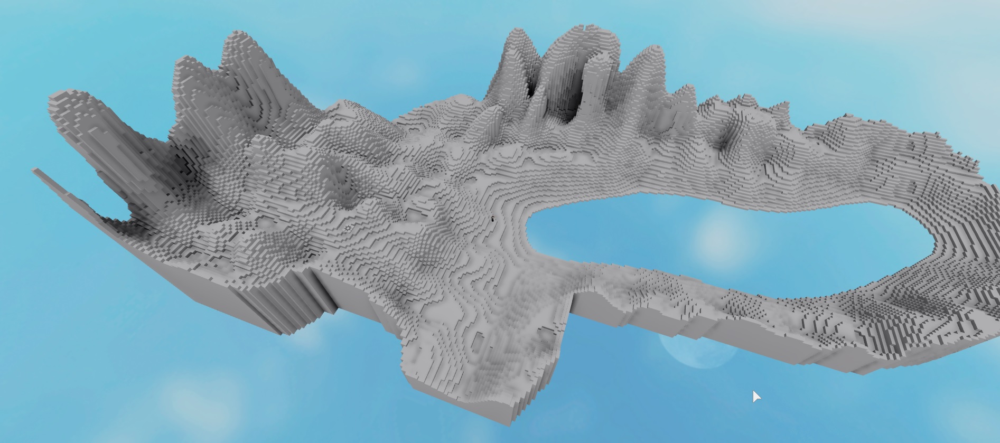

In [13]:
base64_data = "/9j/4AAQSkZJRgABAQEAYABgAAD/4QBaRXhpZgAATU0AKgAAAAgABQMBAAUAAAABAAAASgMDAAEAAAABAAAAAFEQAAEAAAABAQAAAFERAAQAAAABAAAOw1ESAAQAAAABAAAOwwAAAAAAAYagAACxj//bAEMAAgEBAgEBAgICAgICAgIDBQMDAwMDBgQEAwUHBgcHBwYHBwgJCwkICAoIBwcKDQoKCwwMDAwHCQ4PDQwOCwwMDP/bAEMBAgICAwMDBgMDBgwIBwgMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDP/AABEIA0cHZQMBIgACEQEDEQH/xAAfAAABBQEBAQEBAQAAAAAAAAAAAQIDBAUGBwgJCgv/xAC1EAACAQMDAgQDBQUEBAAAAX0BAgMABBEFEiExQQYTUWEHInEUMoGRoQgjQrHBFVLR8CQzYnKCCQoWFxgZGiUmJygpKjQ1Njc4OTpDREVGR0hJSlNUVVZXWFlaY2RlZmdoaWpzdHV2d3h5eoOEhYaHiImKkpOUlZaXmJmaoqOkpaanqKmqsrO0tba3uLm6wsPExcbHyMnK0tPU1dbX2Nna4eLj5OXm5+jp6vHy8/T19vf4+fr/xAAfAQADAQEBAQEBAQEBAAAAAAAAAQIDBAUGBwgJCgv/xAC1EQACAQIEBAMEBwUEBAABAncAAQIDEQQFITEGEkFRB2FxEyIygQgUQpGhscEJIzNS8BVictEKFiQ04SXxFxgZGiYnKCkqNTY3ODk6Q0RFRkdISUpTVFVWV1hZWmNkZWZnaGlqc3R1dnd4eXqCg4SFhoeIiYqSk5SVlpeYmZqio6Slpqeoqaqys7S1tre4ubrCw8TFxsfIycrS09TV1tfY2dri4+Tl5ufo6ery8/T19vf4+fr/2gAMAwEAAhEDEQA/APuSl3GoxNk04uBX6fyn8589xc0VG01IJuKXKL2iJN4o3CoS2TTg+RTsJTvuSbxmk3jNRM+aQHBqrCc9dCZnAFMByKYxzQrYpWEp66km7FJv2mml6SmkJvXQmEnFNMmKYrYodxii2pV9BwlwKC24c9ajzxQWANVykc2lhSRt6801zuGf0prPubiii1hLXYQruNNfI61KTheKhkfcatGctNRpBIpjNgU7OP8AGkxVWZg2IDkUtFFO1iQoooJxVAFIwyKQvQG3UguNAzR0NKHwKa0gJqNSr23JFORSM+KakgNOdhilbUV0KDuFBOKYGozmnyiurjvM54ppbNIWxS0F+QK21qkZ961ETihZOaLXHqOVsNz+NPab0qOiiwJskjk+bmiSQZqOjOaLD5mSxNuX3pWkAFQg4opWHzMnXG3ikcg4qIOVFITRyj5ywqfjSFSTUImz0oDkGlysrnJhIUBFJ5pGP85qNpcn2pRJx9aWpakWEbcKRGJOMVCsm0/zqRJdq0FpkofilD1DvyaeXqbXLUmiTHNJytNR804Nmps0aKSYmSaUvQV+am96Ch6SYXmhHyaZ2opWGPL4anB+KiAzQTRYLkpPFJTAxxTg2RSsIQj5qbna2DTt31pu7a3NaIUgbpSCXAphk3GitbERVh/mcc03zfm9qjJzQQTRYViYNup3UVCmc1MOaznuXEB1o6UHrRnioKFJ4o3fLQeVpDwKABTzS7smkB4pQc0ABORQOlIRSM/FADs0hFNZulG/Ap2GODZ+lNZ9jimGTHamHn6VooCbtsSvNuHeowxBpWAx/OmnIq0rEsG5o6UsZpkpwDigT7jm+VRmkLhl4pFO+IZ600AAUiZabjmkwvPSgDcaYTzSgnFAnruSeYFTHamE4ppzRQEuw5jxSqoamUBsUwSHMNjdaAwcU5BvHNRr8jGpBqw9R1zTvLBXP6VGzbhQpNGoJIGOGo+vNIw+b6UZpkDhTlj3c96ix82aXOKVmXZXEk+U00HDU9hkUwJmrRg4vm0AnmnfepjDBpKdidU9SXdtTimhty803BFGcUrAL0elYc00fep+cUMEhpHHvSU5vu02lcmSHoKkHI9e1IBtGaN/Axx60joSsByppV96e7DbUe6luVOPKx3WpIsge1Qg4f61KhKp+NLoTqO8wMKN2R69s1HjcaWMeW1FgaZIYw1KEw9IrZ7j8KcBmgYnO78acqYNJ0NO30ncqNuoucUtNxuOaUdKjY03FoooHWkUiWJf3gqSRd+Kji4apVf1qGuprTvy2G4YDrSDp7e9OL4zwTQcg+1Go7EanGaaz/NUm0VG4waozl2F3HFNZqQvkUlWjIKKKKdwCiiimIVX204S80yilYCZDk06oFkK04THNTZjRLk0/fUCzUvmYqWjRTsTg4NOD5qssm1qd59TymqqIsq+O9HmZqDzRnr+GKVZN1Tyl+0LAelEnFQBuaQye9LlL9o0T+ZTPM4pgbdRnFOxLmxzSZpNxxTd1BbFOxHMO3GjeabupaAUh3mUqnNMpQCaVikx9ORiT1pimnpUM0jqTbs1Ir5GM9agDYFSRtgioaNSULhqUnFNHJ680hOTU7lxdiSlDYpopag2TuSCY7qkVzioA2KkWXK1LRomTB808PmoFepFbdUNGqvuS5zQDg00NhadnNQaJjxUiN8tQq2KeDg0nqbwkTAZHNOpivup3SsmdSZNG+eKdnmoAcVIpqHE2iyVTiniogc1IrZqDdMlBpUbmo1ODTwazNosezYFJ5nNJncaXZSNB6yb+lPUVGjhOKUvzUPUq5NnimHrQsgFKzbqTRaYlPUYFIg4odsVNi00h1FM3GlV8moZd0OBxTg/NNoqbDu0OD5NLu5plFUoonmY8HNLUecUZqguSU0tzxSbjikDYoC5Ki7qGGKasuKN+TSuFxaKaHyaUtilYLsM0tIGzQTimxXBmwKbuNITk0UAP840plzUdFK4XY/Bz1oBx1NMBxRT3EPLYFNA3GkozihICTpTHbNIGyKQjNVYm/YWikLYpPMqrE8wtIVz3oD4oL0zNyAJg0pOKbvNITmgOYeXxSb6bRQLnY/cKN1MooHzkmcUocioqXfSsNSRKH4oD1H5lG+ixfMTCalEtQ7qM0uUdywHzRUGcUUrAeT0ZzUTXGP/AK9AuMjpX2lmfjnMtiTPNLUP2ggUv2jIpcocyJaQnAqD7QTSJMVXrT5SfaIklkz06UguNvWoyN3Wk6iqsZuo+hY8zI4oeT5aiQlBTWlLClYr2g9pTjrShiy8mogN1DDaKZPO73JQwoL8iot1IWzRYftNCUncacAKh30GXFFhqaJtwzSM/FRb80u/NKyH7QVjgU1mzQxzSVSRk2FFFIzYqyRaQnFNL5pM0r9ieYcZMUxmpM7hxSP8oosZuTewpk44pN+aYMhc9v5UNKAaolztuOzmjHFML9aAxFAXe7HAbTQTgUxpqhdyWqlG5nzk24buKenK1W34FPEpxxRyjVS25MWxSh+cVF5m1c0efkVNi+eyvclzSBs01ZKSWfBH9KXKX7RpXJCadv4qIS7gCKduxSsNVGI0h3U5WxTC3z07NOxXtLDw/NKTimUhNTYaqXHFuaXdlajD5NIr5zTsVzDwcUobFMZ8U3dk0rMq5Lu4ozkUwvShs0hji+RTvNyPf1qMHNLSK5mS+b8vHPenJIGqDNAOKViufuWmbIoExVarhsn9acH3fSkkaqSLUchNPDhjVdJNv9KUSYap5bmyk0T4ytBHNNEuOlG7NTY0UkxcZozSt8uKSkMM0o4ak604DAoAUnFRSrUiikcZoDchQ4JHWlp6pkU1l21opE67MbjNKBRS4xTEhyjaKdnbSHilC5FZt3L2A9KF60u3im1IC4yKBg0HIprNimMeDimmmiSmk5NOw7DieKCKaDRnmqKBn2GmsdzUrnJprDAq0ZO7Yo5owAKQttTIqN23+1MWw/NJ5mVxTM0Cgm9gU7aVjmgr8vFBUkUrg9rAFzSgYPNInynrQ33v/r0rha6uDjFCnBpCAT3pNwFAuUfuzQMMKZu6Y5pTLsHrQOKTeoowTSd6QtgVJ5isgNPULJiK2aU801P9ZTyQDip6is7XG7ABSjignFKeBRcVuwUh5FFLQG40KCKPLp1JmndhoI6/LTCKJ2/lUQlxjiqSMpJ3JD84pvQ0xeD9acXHln1pkuLeo7dk0ueeKi5FKkvPSiwuWRJjFIXpBICcU8ikFmIeRmhF3fhTwmaVF2UhqDuLjAoK5oHy8Udqk2BuRSKe1L1qRVBWguzkRD9aVenGRTmTb3oAxVkJAvFD881Iy0qAY6Cp5ka8lhsQwalXpTVAU07dmocrgl3A9KVRSDGKcDSuOyD7tLTc89adUsYUYIopzPkUXGOhNSL0qKA5qQfLScrGsFoOZMDrSdBSk8frTc54qeYuzQ1jzUZYmpJOlRVZhLcKKKKpEWCiiirICiiigApCcUFsUwnJo1BsfmlqPoaXfmgm44nFG7im5zSZoJ52SBsU4PxUXalD5pWKjMl3cUK26oi+KUNmlYrnVyXNKGxUJfFKHxRyhzk3mcUu+oPNwaUy4pWYc5JuJNKGwKYswFOL7ulILjgc04NimIeKN/PtQO/YkVs09WGKhRsmpVPNQ0b05DsfNT0ba1ML8UoORUPY3W5LS76aOlPVeKg6N0Pil4xT6iA209X3VLBEik4pRTQ1KGyahmiY6gHFM3807OaVi1IeGA9aljfcOKgpVbaalq5opNFrcKVTg1VWQ5qUS1Liac6LAOacGwahV+aerZNZ2NVImR8VIHyKgDYpyvUNHTCpYnD09DioVfmpFbNZu51RkTIcU9Tg1XBwakSXioaNVIsGTcKUNioA2Wp4YiotY2UyYPzS5qEPzT1cE9TUcpqqg9TzTi4AqLfikJyaXIVzkqfMal3gCooiAtDtmoNEycPx1ozmq+eKM0W7lcxYpVbAqFST1Jp4bNKw+cmoqPzNoo34qOVlqoP3Uuc1FupwfApcocw+imb6cDS5WCYtFFFHKyrhRRRS5WAUUUU0gCiiiizAKKKQnFOwroWikDZNLTsLmCkJxRvFMJyaqxLkPBzSMcmkLZpKZLkKX5ozmkooI5goopC2KCRaM0xmyKYXxTsQ5E2aKiDY9qN+DT5Q5h7Pg0m+mNJmkLZp2J5iXzKN9RbjS7+KLCUyXcKM1CH5pytmixXOS0UirtoLYpMu4tFN8ylD5pBcWiiiizGeQEikziiivsz8aFLZpKKKBhRRRQIUNijcc0lFADw2aa1JRRYLhmikzRnIosK4tBqMtzTkkD07MXOr2ELGkzTpOBTN2KLMOZD06U6kVtwprybKmzuO6H00vimGTdSF6vUh1F0HljTScUgyRSO4X60WFqxeStQNKVb6VLJLxwahkIJq0Y1NNmSrIXXsPekHzk85qHNKr7DTsJVe46UFfpTKe0u4cUymiJ2croVXK0hOaQvimFs1VhPUeWxTS2aSinYApQ2KSihABOaVWxSUUaAKXNJRRSQChyop8MuzvUdFJopNokaXc3FSJINvNV6OposilUaZM9z6UofK1EEpRRyFRk0xS5oSU4IpAcigDFVyq1gu73H7uPpSbuOlNBoJpcqL5h6tgc04OM9fpUXmUwp+8z+NTZD9oWA2KcHqINzzSv1qLLY0jK5KDTTKAaiFHQ0uU0UtNScHNKDUayfJzThytQUn2JFapA9Vwcdacr4pWNY1LFgNTg3FV1kxT1fAqeU1Ukyxv3HmlEmDUKvkU4Pmosa8zsTlgRSj5qhBozipt2NFJdSbrQW4qIMc9acZMCkaDw2BSMu7rTFkxSiXFAWFCDbShcJTDKTQZc09QsSDAprS8cUxnLUlILC7zRvpKKYx3mGm0UUAFFFFO4BSE4oYZFM7U0Sxc4NDDd+NIaTdVGav0HA4XFM3A00ynFNL8U7MnVvUeStML4NNPJoeTirsxabjvM9KTdkU3zARQCKOUr3Rd3FKozSd6FJWixUbCq2KaKcBlqRhg0D6XCkpc8dBSNTJewxslqXdtGKCpHvQ2T9e1BgHm460/OOlRldy/wAqUjH40aFKTsSBiBTlnIQColbIpd3HvU2LUkSxy+tOEoNNglVgc4FI55zilZDcbK6HeaAO/pQ78VGGAamSybjTUSWK75NRj5jR1NIBg1ZnccTmkLbTQASaCtAMVZN1B5PHrSYpVXc36UBqSKmefSpFbApYjsGKSouacmw8HIoziozIUPH8qcz7hU2LUWPHNITg0zvRmnYTg7aD+pp6fKMVEGIqSPkZqGOMWmPpNvNLRSbNFFIUtmkooqSgzzShuKSkLYNVuJtLcerZNOMm2og1KTmnYz5kTbs0gbbTBJSiSosUu5IDmhl3Cow/NOMlTYOo9H8riphIGqru5p6vk1LibQZYJ4oIqEye1I0hqeUpyQ9zxTKTcc9aWrOdhjiinFcGsi18aaZek+VeQPg4ysit/I1nUxNOnb2krXOvDYDEYm/sIOVt7GrRUcd3HLD5iupTJG7PGQcH9agvddtNOWRpriOMQoZZCT9xRySfQcVpLEU4q8pJL1M6eBxFSXLTg2/JPpuW6a/Ss7QvF9h4klZbSeOYqNxCuCQPcZz+laDNk1VGvCrHnpu6IxmEq4afsq0eWQlFFFb3OIawLClA20jNjimeYd9CJb7D5M9qUGmM4Xj86RZMGhmbnZ6koNDOBUfm7qA4POKLFe0iSUUwyAL/ACoV9/T0pWC/YeOTQ3FJ3pSeKLB0DNGaQHIoJwKQCg4p4eogdxp2aBqViYPmnoM1AjcU9G2mpaNk7k2MVIpyKjHSnKfmqGbwHg4NSIN1R1IhrNnRHceBinKeaYzcUA/LUGzlbYmoHFNj+7Qz4NQK5IHo8wA1HvpGbJp2L1ZNuo3VBSq9Fiedp2Jw1KHxUG8560onGetLlL5rE4el35qJZQwpQc1Ni1UJQcVKlzxzUAcUoOalxLjVLiyVIr5qgDipY7jB5rJwOiNQuB6ljk2iqqS7hTt9ZuJ0wq2LayhqXfzVYS5pyy1DidEay6lkNT0PFVRLTlmx61PKbKqiyJNhp6S5qp5nvS+ZUcpoqhc8zNG81WE49KcJx6mp5WV7VlgPSiTAqsLilFxmlystVSyr5pytmqwnFKJs96TiaKqXN9Lv5qqJj60onNTyspVS1vpetVhP7UonGanlK9oTjrTlxVcTj1pwlz3FDRXtCfrS96gElOEm0damw+clDH1pQxqMSZFHnDNKzHzkm80oeoxKDShgaRXOSbxSF6ZmjFBXOO38Uu+mYoHApBzof5lNJyaTPFG6i3cnmFBxRmk3Ck307C5h1FJvFJvo1FzDqKYWzSBqdibjycUhfFMLYpC/FOxLkOzTWbFJuNJmqIchxekLZpKKCOYKcWHpTaKCbsDRRRVJAFFFFG4BRRRRyhdhupd1JRSK5hwfNAem0Uh85J51FR5op2H7Rnk9FMLZNKrZr68/Ih1FFFOwrhSE4FN3HNIc5qrGbmODZFIWJprcCnKM0ybt6Bu5oDZ60YFN27jQK7FPBpc8cUDg800kCgNgdcjJ5oWTbQXFMf2qku5DdtUPaTC81E8m403OaQtiq5TJ1GxyPtanvIB3qAvmkzmgIt2LEZElK421XR9jZp73BYYqLO+hpzq1mPEoSo2kz0qJ+aUcLV2W5Lm7Ck5pCcUm/mlPIoIANmhjgUygnNOwxQ2KQnNFFPQAooooAKKKKACiiil5gFFAFFMYUAZpdvrSg7cU0FhVizTjH8lJI/FAelqaaLQaE55p+0BeKR3FML5oQaIVGyaUGoy2KbvouSmyUcU1utJ5mKQSfNSuPSw/lVpBJk+tI03pTUf5PxqdeporWsPzimgkNSFsikAPamJxWw5n3mlVyGHNR5waCMiiw9Y7kyTbW9qWSbnioTQDg07ahzlhZA0Y/wA4pzfKtVy/p1ry74n/ABi1zw5p1xaw20EF3E/lvOuW8sEfeVTxzxjOeteTmeZQwfLzK9z6jhzh6tmvPySUVHunv/W+vyPXFO9aF5NcX8G/HM3jnwLBcyh/tVufs8rNkCVlA+bPuCM+hzWboXxeuLf4nXGkand6TNBNGxg+xOzC2ZMkrIxAG4qDnngqB3rzaPENCcuWacfPc9/GeH+NpU+ejNTfbZ/Lp+KPRz8tO8zCisTwh490vx5Dcyabc+etpL5MnGOcZBHqD2PfBrYD5xXuU6kakVODumfGVqFahUlSrK0luiWOTbUqyYFVwcmnB8VW5EJtaFgNzT0G6okl55pfOy3tWdux0px3JQvNJgs5pN1DNtpami0HMu1aSms2aFfmlYrnHUU3fmgPmiw+YdRRRSLCiiigAoFFFABSFsCgnFRvJzTSD1FJxzSbgaYXwaAcVoQ3qOcYqNzileTZUcr1SRD01F3Uwsc+1IX2io2f8KtGDlceTijeKjJ+Xmm55quULkrPtpPNqPdRup8oakjPzxTlmPcVDuNL5pNKxSdkWQaUtUKy49qdv3LUWNFLoSAYoPIpFbK+tLSLGMCtG4048imL8rUzGSsKo5/CgrzQTgdcUgcZzmkQC9fbOKC5A/zxRvwKC2OaYWALmjJX6HpSNNTWl5ppMOhIx+XFNPAppmyKRpd4p2YXJGG2kAIpnmFaPPPpRZi3JOhobgVF5xpfNz7UcrGPByKVTtakDhsU4pgVI0yTzDSiSolbFODA0rGvMnqSGXjApik0CkznoaRQ9XO/B704Co80b8UWKuyWU4SnRS/LUe7eKT/loKm1xp66lkHNLUdKHxUWNLD6zPFPim28KaWbm4LbAyrheSMnGcelM8R+MrHwvLbJdy+W92SsQ2k7sYz0HuOvrXny+Oo74z23ie1aNmcOiGE429s88/l2rxM0zNUF7On8X5H1nDvDksY1iK+lPp/e11Xpoejad4hTULSOdFOyVQ6+uDz07UR+JrG5l2rdQbzJ5W0OCd+cbcDvntXjcmk2emWlxc2niGELDG0mGV4XbbzjHr6etUtI1LS/CWr6LLHNdajd26tNKJBsBcKFJyck8uSPpyfXx6GeYmMl7R3Xp/wx9Vi+D8BOnL2MeWVtNXa/Te+h702Q/rUit8tYPgrxQ/irw5FfyRiAzSShU9EWRlUn6gA/jW0s4Ar7KlUjVpqpHZn5LisPUw9aVGpvFtf8N5E0LZJzxilZsNUPm4FOEgIq7GSm7WJQcGnb6iMuwUCbJqbF8ye5NuBpQfSogc0E4qSvQmY8U5Wx3qFW5pl1fw2Q/eOqkgkAnk49KicoxV5aIunSqVJclNXb7allpQOpH41xvi/4mRiTUNK03zZNWjTaiqh64BJBIxwD3/CsD4gfFe70i8t4TaxGBySzc/Lzgf1+tYGuaVouvXH2rTNRtrW7dy7vNK6bj/wLpz6V8tjs5c/cw+3c/Sck4QjSarY3WX8vRa6O639C5D4+8Q6TKseox3ENqfklk+zlTg9SCCBmsW/07QIbKadNZkiWCNpSs1ueQBnqMDpUt14a8RT2TQJcm/tjjKx3W9MDkcEiss+H7/TpUe40yWREYMUlhZo37gHHBHtmvA5m9GfcKKTbS1Z6D8S7+bwj8OfD9hFNNbXCpGrFXKOdkWGzj3YZ964e4t9PuLeC91LVnupLmQefCiHzs9duWODgDGenHGa0NY+JFv4oeJdY037QYMhGS4ZCmevHfp3NYs+uaVZ6nvtNKa4jWLEq3Z3qhY8FSOh+U8nnnjHOerG4hVqvPFWWiPNyfASweG9lN3ldtvzbOq8KeKvDvhC0u5oJLx5ZlHyyp8xxnanHHUnn3Gelbfhr4ovrmpebFZ3flW8ZD7pSIy5+7yOvAbjHcH0rjNJ8WaDb3S3EmitHIjbgEnLr9dpwPwpU+MVlYapObTSLZIJG6qPKdwMjngjrn25/E40q06clODs0dmJwtLEU3SrK6Z7TpWtjUrFZXC27nOUZwcc+3rwfXnkA1chfcnXvXlWmfG7TFGJLa5iHXK7WGfzFbenfFPRb08XnlN6OjL+uMfrXv0+I6iVqkL/gfEYjgGhJt0Krj5NX/VHcu2Sag3GsTTvGFrcTRxQXMF0ZWOSku4oMZycZwBwO3UdzW0lwkqcOM19Bg8xo4iKcXZ9up8LmuRYvA1HGpFuP8yWlv09BVJzS76EbI7Um7P49K9DVs8FqL3F3YNBk4pN2760yRsgVZDjG2g9W5608HBqJCAKQE7u9BNrLQmExBp/m1BmnK2anlFeSJvNzSmUYqKijlH7Rk/U+1KMYqNHwMU7OeKk3hZ6ju9PBzUUbEnmpE6VNjWNyaJsmpNwHWoUOKlU8VkzpgTINy04cCo0yKf8AdrJnUtrjqerYFRg5FLUFJ2FLktS7gaYWxQDkU7BceX4pu7ijrUbHmhIUpMkD80hfbTVcCkJyadieYfuzQGzTKTNOxPOWI2wtLuNQBiKUTEVPKNyvsWhLhackwqqJ/anCUGp5R8zLqtkUhfmoI5No56U4yg1HKbRqWJ0l296eLhh71XVsinq2ahxN41S0txxTlnz3/Oqpk20plyKnlNFWZcWSnq1UFlI708XJFQ4G8apd3mlEmKpi6xT1uc1PIzRVkWvNyaXzqriel82p5S1W7MsLJml8wVX35oD80uU09uy1E4z3xUnmLVMP6GnCUipcC1XZc3jFKGzVPzjThPU8hSrFsHFO8yqYufc077RnvU8jNFWLO+lD5quJKcsvPelylqsywsmO9OEpzVcyAd6VWz0qeU0VUsif2pfNFVw3NL5lTyFqpfcsbx608SVVDZoDVPKaKZb8yjzMVV8zb3o35PWjlHzotecaUy5qqHI70Fye9LlH7Qs76PMqsHx3NLvPrT5Rc6JzJR5mRUSvgetO35pWFzj95oD4pm+lLYFInnY7caSm76N9FmLnHUUm+kZ/SnZiuOopgbNLu9KLCuOopAMUtVYYUUUjHAosAucUgbNMJzTlIFMVx1FJmloGIWxQG4oK5pNlIWou4UBsmmHg0UrCuSZoqOjNHKHMP3CimheKKOUXOeThKcBilor7E/J7iE4FN380rkYpNw20yHuJ3pQ2aRFzRnHHSglACO9K3PSmP1oZsU7Cv0FbpmkLcUwyYpokweadjPnVybcXFMfLihTzSNMIzxQN6rUZnFO81QvPWomfcaSqMU7bDmfcabRTo22mgpa6MRU3Ghl2mnmT5uvNRvL2xU6luMUgpC2KAcimuMVRmPopgbFITmnYLCt1pM8UUUxhRRRR5oAoooo3AKKKKQCqeaGGDSU7dmqH5CBMigjinSEUKQR70dCrLYaoJ/ClUUbsGk3cUbBohzN8tMzxQTimF80ri1ZIGwKRWD1HmjNJu5RIxC0wtmkzTTJg0asB1FFGcUgDOKbnLUp5ozimkXoAGDS9DSdKQN83NFrhuh2QDzQJOKb940Y3Uwv0BztanZJFNAp2MjGaLjvcbvyKh1LUI9K057mUSGOIZbYMkDuasFQTjpVG11JLzTZ3ureSyij3JL9pICkDgnOfu+5xXl5rmMcLSvrzPY+l4YyCeZYm2nJFpyu+nZW11/plOL4laI1o8xvkiSNSz+YpUgAZPbn8K8f+Lfx5tddlkg0vTrN4yArXlzbhpHH+yD0H1z9BXX6p4b8L/wBlzXkWvwxWqLuYuyy8eyjDHqAOv41wvgfTPCVvBeanex3upG3kZobYxAIAORkbvmP14x2NfnNWrOpLnm7s/fcPhqVCmqVGKjFdEN8T/E7XNc8B2yxyPaWTABxFEIt69MZAAwOmBXHeHPFtx4O1uC/s2UTwEkbhlWBGCCPQg1veOPixq/jx/sFrGbTT3ISOzt1y0g7BiBk9uBgcdK0fCnwJWxsxqvi25XTLAYxAz7XcnkBiOn+6Pm+lZmxp/Afxtqmp+PNU1GZLy9+025MvlRgozAgqMcAHGccjqfWvWPAfxMg8YXNzZSwyafq1ozGaylzvVAQA3TBBBXp6+mDXjPiv42mGw/svwzB/ZGnRgr5iLslfnquPu59fvc9RXOfDTxJL4c+IOm3iPIW84o4XJMoYFSCB16g/hntXr5ZmlTDTUZP3Oq/yPmeIOHKGPpSqQjarbR97dH5fkfWSNxS55ri/BXxksfFWuPpk0F1pt+ebeK5iZDdKFJLLkDpg8HnFdiH4r7mhXpV4e0pO6PxnG4CvhKro4iPLL+tu5KsmGp6yZWoPMpd3Fa8pyaosiXAFPaTmqqyc09ZRUuJqqnRk8koFLuBFQCTNOByKnlNeZMk3cUbsimZopDJM0u/ioAxApVkOP8afKV1J9+aVTkVXSTBpzS/LxS5S1ImzikZqgEnFODGlylXQrS/NjrQ3NNK4Pp3pGfc30qrdiHIJRyCBTfMyKVpN61H90VSCyQpPFMPy0O/FRl9xPpVpGE3cSRs0zNKo5pSAa020J2BTkUmMEUbsdKQnNMBx57UhHFJmgmlYQo5WkooFMYoBBpScUKeKTZSBMcrlOlSib1qADFLmpaNIyLHmcUzz+elRijORSsN6i7zkHimkk0A5oY5pi0SAcUhfIo280u0GqIbE3YFBagpikIxT0FoAOKUtmgjikDYNACg54obg0F80hOaAFORSZoLZpS2VoAN/NKsmO9AwVo2g0tA0FaUmlEuTTNuelJ0NFkBKZsGneb/hUI5HNKr1PKF2SNLh6PMz+dQscmlQ80+VWHdrUsq2RTw2KqJIUqVLiocTWMyz5uBSSXaQRM8jBFUZLMcACohIDXOfFrXbXRPA939rMoivQbTfGMlC6nn8MVzV5qlTlUfRHdgqMq9eFBfaaRz/AMRPFbax4ntI9LsWvbnTojPFOuWCb8hgV6dACDnqOK5/VPGMtzNu1nQInYALvKSQNj61n6Tpd1bWn2OTW7TTxasTbRzuIWdWAbeWX1z3zyDWoPHOp+EbaazYDVryZQttIk/mqXbhMcfNyRx1NfnGIryrVHVnuz90weEp4WjGhS+FGTrup6JcQwraaTdvPLKoWFpS8bgZZgR94jCnpV628dLp1reJp/h5BqdzH5MaoS2X/gyjDoCcn1xWjP4r1fQ5POutChMkakrILUq/ToGHFZ+pS+Jr5NOt9TubXThOTOXmdIyML90FeR8zL7jisTpLuh3l74A8VWSa5rPmRLE8giiZ3DEjaCVwAF5b8RwOuPS9E12PX9JgvIN4iuF3puHJHavn+w1pH1zVjc2J1+7kuPssExuZMOyAKqo3cFifrkV6V8P/ABBqljfpZ6qLXT7G1s/3aviM8FQu3n7oVXz6ZFe9kuZewn7Ko/df4PufHcV5B9dpfWKK/eR9dV27dT0DzNx+lPEuarRXAniV0IZXAYEdCDTw2a+5tdXPx9qUXZllJgRThOG4qqGpd1LlHzvYupJzTu9UQ+D6e9cz4r8Yf2zY3+naTfQG/WF1Ajm2yI+CMgjng45rz8di6eFhzz/4c9bJ8qr5jW9lS2W76L+uxv6v4qhsbWXy3zNjC8cZ6Z9PeuN17W5fiBoUv9lX8LXa7MujlPLHXtyM4P61j+Ftdig0J7TWdUV9SWR1mEmf3WCVChsYPTPXqTWXF4RvdHuv+Ka1Dzrd13Mi3aklu+BwOmOvvXxGLzGtifjenZbH7DleRYTAK9FXfd7+noWLTx4baxbTNStHuQimGWTzz5jnuckc/nVdY/DdyuP+JpaP/wABdf8AGtBdX8U2SbbvT/taqeklsJAOPVaxNeu7zxORBaaHDbywDzZngj2ccgAg9M5J9Tt+tcB7I7U9J0qwtpbu21yMCFC4Dwuj5AzgY5JPTgdTxWbYfEHULZSsV/cqPQyEj8jWfeQXGkTRNfWkiIJB8sqYWQjnbyMHp2pdV1nTG09zFpDJdvtjiMU7Eb2O0fLj1PTqaANhvDN1rUjXB1jS7q6kzJIpl2HJ5wBjBx0z7VlW3xEu/CF5La295FiKVhIIysiFhw3PcjGPwrnpdRnt/llidO3zrin/AGLQrhEV7PULQ4G5rd94J7n5vz79aAOh1TUtW+IASeJNNMceURY3WOWRu+R6dMZPr072tN8Q+LNFhS2l0+Sa3iUIkf2VZVQDGMbR6VzieDNLuF/ca2Y25+SeBh/490rQsdL1Hw5Ml3Hq1te2kTr5sUV42ZFBBKlR6+npQB39lq/hTXLKP7XaRQSlB5hW3KZbv9zPfPertt4H8KaiuLe9ELMflC3AyPYBua5yw8Q6Ddx/6RorwHA+a3uD/wCgnirItPDV6P3d/qFmTn/XwiQD/vmgDotIh0L4c3tz5l+XnaIN864wvJ4P3eeO/atTwr49i8U3gNtDOgtPnkDcBsgqFBBx6nn06dxzMmneFNFtILh5zeyq6hljOfNPJyyE/d9e3Qd8VJpHjzT7bWvsWj6YAt06p5gby8t642ngZ/nxV05yhJThujKvRhWpypVFeMlZ+jPTrO6W9tklXOyQbh7ip1ORWD4ZknS9lgaSV44YwcO+48kgcnn+E/n37bgbAr9HwNd16Eattz8BznL/AKjjZ4a6aXbz1S17IVmx0ppO40Zy1PGK69TybNsTbtpynjNNZsUeZT3Hyq+osr5PFNDEUhOTSoOaZG7Hg0pkwKa7elNLZoE0Sxvk9alaTcRiqqtip7c7TxzUtIuno7D1bn09cCpVOKTdg0uc1DZ0IeGzUkTc81Eo4qROBUM2iTAkcipE5FQo+BSjIHfNZNHVGWpY28UmymI2D/Ons2Kk10auIUxTScUPJlaYTzTSZm7D92aCwzUe7FISadjKUyQtSF80lIDmnYz5h244o38UlFAcw4PnrQHzTaKLDU2SUmabvNC8GpsUqpKjlTUoOagDE09pNyVDRpzX2JQ2V9qcJSKq5xThIQaXKUn2LXn/AI04SZPUVWE4pVkDVPKWptFkNk0u7PrVfdzThKRU8pftSyOlKsmKrJNgc804TA0nEftCyJM0u/I61XVtwpQeanlKVRlgTYNOExzVZpcUCbik4lqqy15xpyzZFVVfcadvqeUtVmWhP70vn1U3mnbhSdM0VdlkT07zBVUP70vmcVPIWq7LYf3pyykVWWTFPDZHWpcDeNW5OJuacsx7VV8zFOWap5S1WsXBOfWnrN61TWbBp/n4FZuBqqxbEoNKHBqr5wpfMFLlNFWLOc0oNVRKRTw59anlLVVE+aVZOKr+bk0vmUco/aIsb6XeKriXFOEuanlGpolL4oEmKi3ml30WKUyTzaXzjUe6jcKLIfOSienLIGqAHIpaVg5ibzBnrQWJIx0qHNG44osFyffzSeYP/wBVRBsUm8gUWC7JxLkZGTQJ6rtJgYpVmyelHKLnfQsLNk9KGOTUYlC0NJmlYrm01H7xQGzUeaWnYjnZJQTTAeKTNCK5x3mmgymm0lMm8h4JY0hzmjORim7sUtAHK1O3VGDmgnaKZPM9h5kANFQ7jRTK1PMd3zUMeaRzg0m6vrD8pv0Aik7UjEqaa0lOxm2kPRtp60hk9aiL5pKqxn7TsSZzTXHFIhIbinnrQNe8tSFSWPSgxEHmpgNtI/I5ppk8mgzNIxwKax+akLZpsanZWA9aKKazYpEodSM2KRWzSv0oBAH3CkccU0HFGc07WH1uAOKM0UUwCiiii4BRRRSAKKKKegBRSDrS02gCiiijYAophfNOHShsdrC0hfaaA3HNNLc1AIV8haQNg0lB6UFJDycj2plNVueaU9KB2sLTXbFIH5pSQxp2GIhJNDHNOFG3Jp6AIpwKcr5prtgU0HFC7j3Fb5WpS3FMJxSBjTFceX5prNupDmkwKBX6DlOaUHFMzgUoNMOYdmgNSZzS0FjZpjBCzBHk2jOxMbm9hnvXk3xc8JX+q6Dd3cX2mLS9wuVSeUIEPoVLcckgfhXpHi9tvh25PnT24C5aWFNzIvfjIyMdfrXiXxEjvvE/lW8F9dX8MM2IUkkOGB4DEN0Iz1PTJ7V8TxTVbqwpdLXP1/w3w0VhquI6t2+SV+/n2Ldh4Ai0L4eyT6xrWnwpLnZAjeay5BO0FSctnsAcetQ+ELXwx4U8GyX95c6jfXNwinyYYwgQ9MDORwTySe3TtS+M/h6/hv4axy6rqOnpdAZiiVy7MRnABAOT2PYeteceFPE5+0yabPzDODs9j3/x/CvlT9KNDRNSuoPFUUukx3CTPKfJhhcmTB/hBGM8d8e9dH8XNL1lZrS71X7XtIMaCY5VT1OO3Pf6VznhbxPceAvE25Jnhz+7ZlOMqehqx4+1a71XXTcXdzLc+coaNnP3RxlQOg/CgDCnmIOF5JOAB3rpLP4Uaza6H/a9xLbaWsLB0FzIUcHqOxwc9Aefas3wP4xm8KeIhLDBBNJINo8yLeV+ncfhVvxn4l1DxRq7S30xcD/VRgbY419l/metAFD/AIS3UrTxNbawZpLi9tZlljdiQJNp+72+U9Mehr6y8PeIIfEWk293CxAnjEnlt9+PIB2sOxHSvll/GF8/hddI3qLMMWIC/M3OcE+mc1BpfxB1jw9rkF9BdyedagIob7jLxlCOmDgZ79+vNexlOavCScZK8X+B8txLw3HNIRnCXLON7dn5M+vFl3Gng5rmPhp49i+Ivg+01SFRG0o2zRA58mReGX/D2IroFl29OnvX6BBxnFThsz8UqwqUakqVVWlF2fyJx1pWOTUIm559e1P8wZp2YrpjwxWnJMQeelRhs0uamwyZZtx9Kd5uKr0obFLlGWFk3GlB5zUCPg0oY5pcpopdyZVA/GkZdtNWXAoDZqTRMcwxTkamHrxSd6CiR2pv3yaRjupnmYFAtFuOJxTd1IzcVEzk1aRm2OJOaZnFG7f9aBxVmYrDIppbj+dK3AptNB0CmM9DNk0maozlLsKGpM0xjzSbveqsZcxIGINOR91Q+bml8ylY0g+xPRuNMifcPpT6RstRS2aXOVptFKw7DgOKBTQcUZpWDUUA0rDmk3UlAtRS1G/FJRTsOwZpM5paKYhMc0tFFABRRRQAUUmaY02DQFyTNIc1GZs+1NeTpyadieYmJwOaN49aheTIqMuFNPlFdlhpdtHnCqzPu6UeYc0+UEy0sgbvTs1U80YpRLjuaXKO7LQODS5y1QxS5PNSA5qbDuh5bBrwz9pPX9R1Hxcmk/a4LfSYYY52LnkNuIbAHLEDnH6jNe4g4r5Y8b6/DcfF7XJr6zkv7S1vJ4gryFFDK+MZGe2SBXznElRww6iurPuOBaCnjZVJfZjp6tm54Q+HUer6zDv1PGlTpvhnb9xJck5G1FbJOCOTjp9RXbWNh4v8Ff6LZxG606FisGRG5K5JBPRs9/TNZng74U213p732m6wt3fpILiwt4pwUto9w2qwYFuOefl7cZrW1CfxzNavp7xvG11iH7TsQiFW4L5T0GT618MfrRk63qus6lYvPqOuWtraapKIZI4ZixhXOCnl887Acgdec1iX95oWlXN8013f6ilpAPLktwIgDt3kbWz6rz9eKzvGttofws8U2thKl7rbQRbpkkl8pYSRhTuVc85JA7cdaq6vrV0vhNrebRk07S9VuV2XLWxeaKNm6q7HljGAOeoHGKAL3hu21qw0nTrS91OLTdOuZCzFZQ4UnMm0qpzyx55xz16A68sWntp+o5vLzUtTd1t7XyiDDOTtRVBOSDvYj0rAsk8O2OoOfLvtSWGDAdm8jYTycY69F+nvXYaLb6sP7PtLfRLTS5IszrPJGY3GO29uGJZx298DsAewaci2trFbhgWgjVSM84xgH9D+VWA2K8h8CfE9tI1XVZL5ZL/UdQ1GO1DK6+WoUrEijaCPvFsketes+Zvr9HynH/WqPM1qt+x+F8S5T/ZuK5Iu8Zaq+r6XvoupMP8A9dKp5qHdXP8AxI8bN4I8NS3ccYmmUZVDnp+H1rtxNeFGm6tTZHk4HC1MZXjhqK96X9XL+r6+7PNb2ybmGF3g8A968+lMPw08aSTrFLO2qbWnlmJKW4LnIXA6Hrjk/KKl0nxfc/E3w+0elQvY3Sqk8sxmwoJ/hBAzk8/kagh+ISx6SdK1OznlKDy5ZRcHzGIPuM9fevzbGY2pianPUfp5I/eMqyqhgKPsaC9X3dt/60Na78KeF/EU8ksd6I5Z23tsuMFmPJ4bNYut/DXTtJljH9sxwGUFo1lTO4euQenvikit/DF99251OzOf+WqLIo+mOaq2sfhy1vrlJZru/wCiCe3Xy9uBnG1u+Sf89OQ9ImvvtvhGxFxDrtvNFvCKsF2SSccAr06A/lWTqepTa1aTane65GssCeVDbk7XIHpjHzMzY/Ac+hr76BYanG0cN1qcQjYmKZ/J8onGDkdTgMPxrlyXgvkuLnTH+wvL5kUMobyyPvIN38WOD749KAL11djXkzqGtvbw26lo1mV5cnuc/wAOAPxz7Vz+k+KvJljlhlOD80ci5XgjqM4I4Pf1rUv7G51AS37aclppzOEjXOUdeE5/3nyPoR9anvLu1vLdmfQrW6nIOxLeQwGRuw4B5JoAu2Xjq6deZ45kbkpJGpB/TNWz4zsZF/0vSNNnOeXRfLZh06ivMLy21fSpD5trPHt4bETBQfTv/M100eg6ffWyGPxFAku0bkmgeMA9/mNAHS3OoeF7qL57TULPI/5YyiQD/vqsqLxLp/hHU0utI1KSSVgyMstuMxjjnJGOazLf4lW2gWj6ddaXpGpraMy+eud0nzHnfzkHPHGOlaWneGvDHjrRPtNtPa6RqkiMYrY6hkq+W2Z3euATgcA+tMDtH8fX8EQ/tLRbWVcbi1xZFTjpkHp+NLbeKdA1IfvtGaJuPmt7g8/8BPFc7Zp8RdCgR4pZr6I9GSdLj/0LJNXofiXrVuP+J14bt5F6l7nT2Q+hIbgfjSAvy+INF0zUNlrp09/HMACLtgGRsn5UK/UfpVqPUNeukGnskGl+Wu+Dzm8pwoI+VH6nGRn9eTUulfFFr7R3s9J0XZcKu5BCfNUHPJK4z39TVfV9FufG2iyanqtx9iOnq4WFEIAAwSWDHhiRj8BQBr/DT4lST67Fo0sbXF19oeNrjzt+4rnPYZGFPOT+NepiSvPfh34ss/EmpJIlpJbizjxvIzliAqjcOoxv4PqD6V3ySB1z1BGQR3r7ThtRVCVnrf8A4b9T8l4+dWWLheNopaPu93+hLvoDDNRhuKcOa+j1Pgh4o70m8CjcCaYhwOKjutRisTH5jKvmvsXJAycE4A78A9PT0BrB8R+Nks7OdLVWnmZzbRsvKLIW2ZbkHCt1wc8HHNYenXM+p+NBG+91sbVnLSc7TK4C7fwifP4eprwMfntKjeFHWWvomfbZJwZiMTarifcho/Np66dum52MGuRXd1cJH8wt3EbnphiobGMejL+ZpLvxDa2NxDHM/lmfO0tgLxjPJ4zyOOp544OPPvBXxMgi1GezuIjG9xfXDfaHk2qU3tsLbuVxGEGD6AcHitzxZ4HtvHkkM63m1rdGRCgEgG7BPfvgfkPSvA/t/GXvdfcfavgjKnFR5HfvzO7/AE/A7OBxMFZTlWGQR0NTRNskrI0VI9EtIoFysMUYjUAelafmba+ry3HxxdLme63/AK8z8y4gyR5ZieRXcXqnb8PO2lyyx83kdqdEOKrQSYOKnhJxXe0eLH3iZTzUgJxUadafWT3OiOwqnDVYjcsarA1PG2F96h6m8VYV2y1PThaiGQadSsaIO9ITgUkjYpucimZyfQF60/dULHBpM07GJM54popFbNSDpSEC570MM0U0tzQA4DApaQHIpaACgHFFFACh6cr5plFKwXtqiSObaakSTcueKr0ZpcpSm7k+3NGyoM1IrEUrGvtkS79oo84YqPdmkLVNhqUXsOWQ7utS5zVc0qNmiw+YsZxShyO9VwxHelEpFTyjuTliTQHxUQmpfOFHKPmLET8UF81CDkU5etRYrmJBMVFPDkiowaXcaLDTJfMpytVcybafFNu7VDiXzkwfApwbNRZ5oDfSlYpVGtydSTTidoqAOfWl3mpsaqoTCbFL52ah305XApWRoqhMJ/enCbPeodwammlyI0VWRZEtSRyZFU0PPNThsVDiaKqycSYNOMuKgD0oOajlL9oycSZpdwqusmDUgORU8paqMkVs0of3qPNLupWNFV7kqtxzShs1GHzS5xSsjRT7EmcUbs1Grbx1pQM0nEtSH55pQ+KatLUFpjw2aM80ygHmgq44rk0oXFIGo309Q0FA96XBI7mhSDT9wxSGIvydRTWkOeBT80tAbjN5xRv4p22k2UrhoNbmgvtp2ymtETRp1Ew833oVuaaYSKQoR2qtOgrjycmjOBUfIozRYG7jjJRTaKYHmZGKQnJpCeeaRjmvq7H5Q2I3JqMjBp5fFNL5qzGTTALmnJGM80A5FK52igqMVuLsprNt61G0xphOaQnPsPabNMJzRjNFAtXqwprNinDikIyKYCK2aVvu0zoaM5qrCsOVaRxg0inBoJzRsxhRRRQAUUUUgCiiina4DlXikYYNAbApC+6izKurWCjvSZpaexIUwvzTicUxwGNFwcW17o8NkUhem5pGbFTuX6jgc/SjdzSUZpByjH4oEuF5px5pvl5qlqPoOVs0rfKKQLinFt1PYZEfmp6DjBoxtpC9LcN9gdcdKaKUtmkqikLv4pCc0DpSMaQOyFJpm7J/wp6xGX2Fct8TfitB8NrQgWV3d3JXK4iZYUzwC0hGOvYZP0ryMwzqhhfd+KXZfr2PqMk4Rx2ZWqW5Kf8AM+vouv5eZ0woHFfP/h39obVk8cxX2q3Bk0+QmOW2jGIokJzlV9R6nJxkZ5rv7r9pTw9F4his4zNJascSXm0iOM44wuNxGeCePxrlw3EmGqaVU4v719//AAD0sw8PMwoXlhmqiXyf3PT8T0LpSDk4qh4Y8V2PjPRUv9OnE9u5Kg4IIIOCCDyPx7EHvV8/MK+gjOMoqUXdM+FrUp0punUVpLRpig5oLc0Y2ikHIqjPVC55pQc0Z4pM4oK2MfxrqEem2cEk969lbNJ5cx8jzVkUqflIwSOnWuO1nwv4YtNJmvI9eWGKEZbcyyn8FGGOa6Tx/e2HnRWep6mLG0u4mBjaHPmEEcq+MKRkdfbiuE8ceBPD+n+G5blfEUDW7AhE+WV3PYLtPJHHb64FfnPEE742Xlb8j994Hp8mUU3fdt/icD4olt/E2mNcWjM5tiR8y7WZfpn8aj+Eup2mjTXT/wBmWl3e4+V5Sc4PT1AGeuBXQeGofCvhTwe97O+oajdz7SYlXygD0wOSMepJP07U3wP4ysNA8LXj6fotnJfEHc8zlyOcjjHIx2GMkV4p9ccJ4jnvvHHiECRbaK5nYRBVVYY4/Y/T1PNdN4q8JW/hfwnBHc6vaXmoABo4oAWOMgZznpjPJxkjpXKa/qct7fSXj7VlkfzCY1CAH2A4FaF1qSeJNBjuVAFxB8sgA7cZ/wAfzoAtfDnxt/wi+oypHFaGaX7skke5semc9O+Kra1rF3rmqSz30pluSdrHsMdAB0ArnLfSL7WNYSOxikklzn5R936mum1vQ7jRDALvyluXT50V8kAAYJHUde/XFAFKrlhr1xpmn3FtEyhLnG845A7geme/0FUzVS5u/LoA7j4J/FWP4U3mpi7LSafdhZBCv3lkHG5fqOD9F9K+hPD3iO08XaNb6jp8yz2tyu5GX8iD6EHgj2r4zvN9+VC/ezgfjXp3wE+LcPwoe503VneSxu2WWFoRu8mTgMDnHBGCcf3T1Jr6XI84dKSoVn7nTyPgOL+F44mDxmEi/a6XS+0ttu6Po/G0UobK1jeFPGuneO9KN5plyt1bq5iYqMFHGCQR64I/MVph8AV9vBxnFSi7pn5FUVSlN06is1unuTh8GnxvzVfzMjNOV9xAp2KVRlkHNLUSvt96USbqzsappklKrYpitk04nFIoeDmjNMBxSq2aQXH5o3GkHWiiw+ZhuzQWxSEYNB5osF2Ifmb2php/3TSE5pju7CdBQRzRjikZsUyRpNNdtop1Ml5qxy0RHuzTTJyaMYprcdasySEMuBUYbFPK45pGG9eKpGTj3HdaNvNEfPWpwN5FTexoroS3G2pqaFxTqg3WwUUUoXmkUJRipVj+Wjy6nmL9myLpRUhjNMK4ppkuLQlFFBqiQppcAUFto5qJpADkE0EN9EOMxPQU5Ztx6VEZuf1pjSbaqxHMyZp/SmmdqjD7hSE07ILtjzJnJpnm0hX5s0ZBqhXDcwpC5binBuabja2aCb6ieYQelIxyacTl6Q4FV1DluNUlaerlj6UgytGcGkHKONG3NNznmk60WKsOL09W+So9uKVWoFG9rFHxd4xtfBegS315MY4kwq45LMegA/z0r5m8A2dt8TPGlyus6tLbx71k8vJEc7H7xJHCngc+556V6h+2LNNF8MLKO2yZZdSjG0Njcvly5/DOP0rzH4CXdhqF4x1izfaIitu9qwDgqVBJGeSSx6n8OlfBcTV3LEKl0ivzP1/gPCQhgpYhbzf4Lb82e8+AJfC/gWKW1s7nDZ2GSUFsqoAAVsfd4yOe9a3jP4i2Hh3w1PexXEF1Ljy4Io33maUg7UwOeT+ma4qTRLPwreumpW81xBP81s8U4yFBPXHBOMVd0UeFLHVYL43N4htSZUS4TIVsEZ+UdgT/AJFfNH3JzviXTr/wP4caCNFufF3iuaQsUfhWIclxnosakD06dq871fTtW8D+KLCyv8+JktIjcSQbZZY4N2VDMOQDwcH6e1exQaksOm6h461qOSNJYdmnWjOpMcJA27fR3PJ9q8Uj0zxhqMWp+MbfU47G1l3m5/ePGZtpwCqqpBA5AzgjBoAuL8W7i3tdQtbSGGxgnuVBgVOYW3IhIPUHC1qHxJe6lfyzzvd3EVrbIN7lnCcuSMngcAVy/wAMbltfubZtO8PM2qQHzrieWQyCVCCCzI2AWJYHueOOlamtfEPUxZamkU/2OSW7FsYrXEQVt6xY+XvnjOcnjmgDuvDGl6pZ6b4U0vWGttIsbaeO/feY1aUxESbD8wIBlKk++M9a9R8GeMLfxtY3V3afPaRXctrFKB8s3lNsdlPQjergEcHbXz+/iDRfDOl6lqmsR6lLLY2blI4ZEQKFG/A3fxMRjnitnwD481W+8ZeGbHT4YbLw54btppbxFDZvHMflQpuIPILu7c5JCnJ5r2MozJ4Sr73wvf8Az+R8xxRkEcywzcP4kfh89/d1aSu+p71fX8em2jTSOqKo6k4yewrzCw+La3eqarJrCiJ4J/JsoRE6vLEOS24/KRzweOhrlf2gPF2q+Pbj7Fp1tLDYaUkN48m1meabzG/dqBwRsQ884z05qn4M8aTeJLxLu28Or/adqiiUlXkRA+QAU42/j0ANdGeZr9Zn7Kk/cX4s4eD+G/7Po+3xC/ey/wDJV2+e7+49FuvEUs0kWuWBSGwwontlmVHlIcg5UZ6564zitSH4oaXqWBeWEi8dwsqrnr1wf0rO/wCEL1HwzepqOlbbma4BE0aRKYkzgnaDzjORxzjv6tuvE88K41PQLNiuBua3MTfnXz59qQ6/4o8M/bfLh0kTIEDyOjmDyySwxtHXpn05rMh8WS6JbxQX/h+0SPB2Ce3KSAE5+9+PNXvtOsHT3S2s7TSdP1GYmFpwpSMMMbt55O5VyM+oA7CsnWNMAuJ4tZ1+TdapuiUbp4z1JOSQM9OvT1oAztb+I7W1jqH9nwWllDdNsEe0SbW+5uyeeuSB0Hp1J47VPEV1qOopHLc3EqQJlUeQsBuPuf8AZ/WurludGtILZYLCWW4+8wunEkTY6sR3OTkdh17CsPWPFk0FjefZfsljDPL5QjSFXAywjydwPP6dKAMbxB4pntRY26SYQu0kiluCoUjgeu5l/I1NpPiPzUBz05BB6VmeJtHifOoyXKwrY28nyspI2nDMc5x/AOuMc+tZ0c5sLYbsBsZIByAfrQB0upeN59OjfbeTYI2lXbcMfQ1yV9qNzPaC5+z3Q07zAkt0sJZIxkAkkDHGapjxJYRag39owzXVvsPyRy+WVPY579+K1JNP1Lw7eaW2nFfFWh6pKIY9EtdVLlndSxjkCgqpBznHGQM56EAs2F9qXhlZdd8DG81qzCvFetNZK3lbcNs5GTxgnb7fSup+Hfw/8N/tFR6lfaJc+JLKa3kH2l57aH7P5rgnEYX35xngEdMivUfhl8FNS8IT32n36+Hz4TmgcRafHE0zI8mTIJHkX94vJwTjjjbjGOg+Fut6HYW50vStMs9EtId0ojhCRRsxPJCgDk9Tx2+lAHE/ADR/GXhzxNJoOoW7p4d0wTCK4mtUj8/D4XaRk/MW38k8A816r4puptG8OXlxawvPdRxHyI0XJeQ8KMfUiobnxzpzXctnBcD7bv8AJVFGMvnH3sFeD9eh4PStY24uHiZs/umLAcdSCP5E/nQB5Bby+NvFFr9peGPS5LSRkldlNpLIMAkk9GTjrnH5VmXTMoj1XSr5tfv3ffNCbNiUypDMc9QCcDj0x0qj8SvHXi3w74xv9RvVnHhK5uPs6QxzqhMZ+XB6shYAnI5GeqnpXs4ItSiOp+GroadDbRnzrV77NycZOQq5JUggAHkkdPUA9E+GHja01lxbSW8dvqV1MY5YYrcouQcHP3uQoJOQBxzjrXp5kC15b8FpbTXdZe5TTktrm0jLSSqxO9nyORxgn5u3PPTGD6fur7nhvD8uGdR/af5af5n5Bx3jfaY9YdP4F+L1/Kw9X3U8ORTE61FqGpQ6XaSTzuI4oxksf0H1J4H1r35WWrPiowcpKEdWS3FysKbpHVFzjLHAzXMa/wCOWtLrUPs8hMWmqFk2BXJfZ5hAHJ+6yfnXM+MPiEviwrFaw3McdorNKJUwGZsBNpHBOA+ecjI45rz3RL7WRINO1GNrTRtaeXzHnKYCSIzAF/UqAuOccDtXx+a53z3pYd6aao/UOGuEVTSxOOWuq5Gk12v18zsE8U6VpGm6DCbqO4SBla5WEq5JEbHc20AZ8wq3QZIJA4NSalrGrWeqTa1pi3H9mXKxguwU5Rf9kglRuLc475zjFedXMek+APE95FPatqltLHGFlnuArR/eLFGXgA5GehyvPAFdBplk/hWeyNpdafqtkm5ntkZpV6EfMhOepzubPK85JzXzG+rP0NJJWR1+ueIfDPi+GDzoptPngbKukCkjIweR25PpU1z8LvsNtHcw6vbLHJgxPKDEDnkc5Paqun2/hrxr4bkLi10y/lWWIYlZBE2WUHIIHYHrkdODxTDo9rp6C01PWT5TBZIPszGaID5hkjsfpSGdL4L1OHw/ctp19ftdXryAIoLyxgEDAU4465PT9K723nEi5A/OvHrDVbaGNbnSdLuGvLIhTNlpUIwRuZexIBr1Pw1cT3mhWstyixzyxh3VVKhc84wSTX0vDcqntpRXw21/Q+B4/p0fqtOpL472Xo9X+SNOLkVYi4WqyLU0b7P8K+uavqflcNNSZGzUlRRnCipFORWcjaAtSRDcOajqQcVmzaO+o8DFBOBQrZWmk5o3NW7CMd1Nc8UFsNSE5qkYSEoooqzMAcVLGeKip6GpYEtJtoBzS1IxoIBp1NYcdKEWgBc4paKSgBaKKKAsFFFFAgo3GiigdxdxxSUUUC2CgHFFFBV2OR9tPjO4VFRnFJq47kwXigrimwvzg04ncfb1qDSNkOSTin7wahPBpVbAqbGm5NmgE5piv2p+akLWHlc0qHYKYHIoyTSKJC2TSh6YKWloJ6jwc05T9ajDYFKJOakd7Ew6UVGH96UMc0rFKfQeDinB+Kj5p1TY0UyQHIozUdKD70jVTJ95AoEx9KjD5FLvpWRomyQTj3qSObK1WJyaeknNJxRak+pZRuakqsrDNShuKyasbRkSUrNmmJ0p1I0THoMUuaZuNOVs1LuaqSYtAoozUmiY9DkU9UGKhBxUsRNSzRMVlpCuBTsUY5qTQAMCkYFjTqAM0DsMwRT4lPWigHFGoco9mxTd9GMml2VOw7B5lJ5ooZDTRFmnp1BpkgcGjdTQCBTgMCp0DluMJyaQrmpVTeKXyQKdwtcrlKKn2Y7fpRT5iTyZpMmmM9OcbDio9lfYn5HOLuJuJNOGcUqjbT88Umxez7kO85pwfcKSTGeKbTCLcWObpTaM0hbFAnq7jlbFIxy1MLE05WzRa2pbm7WEZsGhXoc5ptPQgc5BptFFNAFFFFABQBk0UA4NIfqKUwKSnnkU10wKe45LqhKBSZwKUGrSsT1E70HilpjNmk2XZCl6a821qKRl3CpuMXduoqNH5pxfmlYB1MkABzTs5ppTLYoQwRs0/rTGTZSq9VYfmHmYb2pzNgUxmyaQ8DNArdR3mc0hfNML80gYtTsLmSHk5opsbf8A1qV8k0C9oLRSN0pu6gpysLnLVD9rkhv44haSzRydZUZdsf1BI/TNSk5rlfGxu7u5kTSri/jvYkxNDHuUPGejqfu55+vX0rxc+rypYRuDs20v6/pH1nA+Dhic1jGrFSik3rZ+m77+vp1Wh47+K2kfD6Mrdz+Zd7dyW0XzSN6Z7KPc14T8Q/jRq3j/ADDK62ljni2hJw3++erfy9qSD4T+IvEfiSe3W1uZZA26S4uMouD3Zm78dOTwayfit8O7j4a3Cxz39hcSOAwihdjIM9yuOB15zzX5yfv5py3ng2LwDbhdPu59eYESnz3VVPPJP3cdCABnsT65nhn4UX/iTw7carHeadDbWz7W8+fYR9eCB1GMnnNcqstxaQo80UkaSjKM6kBxxyM9eo/OpYNcLR+VvbYWDbd3BPTOPXk0AepfADxna+A11v7dqkKWsZV/II++3Teh6nOMYx/dr1Dwd8ZtB8bGKOC6EF1NI0aW0xCyORzkDvkc/p1r5dktpdUuIo4BuldwirkDJPA5zitbX/Beq+Bvs9xN5cUgcPBJHMCQynOQPvcYHOMcivYwGdYjDWhe8e3+X9WPlc74QwOY81VrlqP7S720utn+fmfW5OaTdk1wXwv/AGgNG+ID2li8wtNakhLvbvwGKD59p6Hu2OuAfQ13cM0dwu5JEkU8gq2Qa/QKGKpVoqVKV0fheOyzF4So6eIg4tfd5ajs/LQOaVu1c38Sfihp3wr0uG+1ZbtLGSTy2nhhMiQsem/HIzzg47Y6kZutVjSpupPZGWDwVXFV44ejrKTsuhgfEu40jVdauNM1zXrazt44lnhhaDbPG+D8yuRhlwOnzE5I4IFeL65fWV1c3EFlLPNbof3UkyBHb3wCa9A+I3iH4f8Axs0yG+j8T28V1YKShh/17If4TE2GIzg9OOfWuI8EeK/Bmgrcx6pYX2pahg+SWKpE6kkDgNlTjr97HOOnP5dja6rV51Y7Nn9JZRg5YTBUsNO14xSdtrmBo2ssJ3sZQWhlBwPQ9/5Z/Cm6bqT+Gdb/AHh+Q/Kx9R2NdR4Q+Jg8L3t49jpWlwvdEmNnV3aMdl3Fske3euR8aalc65dzXd0/mXEhyxAAA9gBwBXKeiXPElkFuCV/1U3zLjt6j/PtXS26aJ4X8H+ZaWE15cXPBknf5FyOp28+oxx9a8/0DxE2p2bWcuTJEcxk/p/UVu+D9bEpl0+45inHy5/hP+eaAKFtc/2TfLMO3B+laV+VkuPPQ7luPnJ/2u/+fes3WLZrZpI2+8hwap6BrBMrWch4Y5jJ7HNAGvI+1an8Oa7BYTyo9nDPO6kxO5OB7EfWqjtvi9D79qvaRcW66TM0dvC15EeXcbiF9QDxmgCmltFdXM01wShIyEiQKCfpjAqlq1ut1YSR9Dg7fY9q0C2/n15rM8QXS2Fs0skixRpjLMdoGT3NAHZfsdfEaXw94rn0W7bbZ6scRbm4juF6D/gQ49yFr6eY8V8MaZcNZ6tE1u5SUt50TJ1VgQcg+xwa+yvht4xHjvwRYal8nmTx4nVeiSr8rj/voHHtivt+Gsbz03hpbx1Xp/wH+Z+R+IGU+zrRx9NaT0l6rb71+RuA4FGaKK+pPzgfGx61IjZ+tQhsUpakaRkkWlk+an5yKqh6kSQis3E6FMnopocMKdUFgTmngUygHBoGvMcxxTSaGbcaSgqwpBxRnmlzxTc4oKfw6AxwKZSs2aSrRKCmSdacTio5GyaZM9hGNRyYNEjZ/wAaYeatIhIAcUA0g5PNOj+9VMu1xyJvqwibRTY04pwHNZtjUUL3paOtPjTNS2Wlcaq7qlVMUoG2lAyazcjohCwYzRT1T5uKkMPFZ3N+QgPFNIDVKyU1hiqJlAgdMGmHpU7ruFQtxWsWcs42ZFN8qfjUGcjmp36VBIOK1iYST3Q1mzxSKcjmmjmlLc1pYz6DtwUUbuKjZ+KRTgUWI0vYeZMUueKizmnB6dgjNDwxxSF8tTC2aM5NFhXV9B4PNLmo260goH7TWxJuzSk1Hnik3cUWF7QlxikJ54pgbApQd1BXOmh+c9etAFMD0lzdJZ2zyyMI44lLuzcBQOSTSem5cNXZHzX+1x8R7LxXeaTDpsj3P2XzxLs5UjK4IIyCDgn8RVn4WeE5U8N24jMdjBJF9ojgmYGWVnPOD1PTgd8jj08bvNWnuvFsOmnzV8xwGjUYZskZHryK9y8H/bbCJLxIZIEichJNmAvGOPzr8lxeJniKrrT3f/DH9FZfgaeDw8cNS+GPfzdzrNC8LxalZ7ptTtLOfcR5U52nHYkn1p+s/D2/ttKuJVezkhVDulWcbF46nv8AkM+1R3mh61qsn2ye1nlaZQ24IMkAAD5R7D0qoliltexDUbe4+zhw0keCjPtOQO38QFcx2FyHR9MsNS0y31TUxqtjbqZfssamSHcFKLvUnpyccHp2HXzT4zfEG88cWq6B4ctobErdSPaqqBIxtB8okDI6gkjGMkdcV6BdeL9P0sazLY6XBKoj8qJ7pd8iMqZz9NzHjvgfSqmtap4W+Gvh62ntIo7rWJYmE8zxsMkLuPUYAZwoGOgYntQB5F/wmniTRtWgtdfvDLe2MBGY2H7vdgkFlA5IA684ArRbxZqPhSz0CzutGhsZ55cm6ktmEzsqM5Jcnli3J46+lYb+KvGHh3wzrWrJc2z6NfvsmkMkLTB2wu7++D6Y6AZwMVBoHjGK98Xm/wBQiXVTpulqIxdOXESyPIW25OA37tefftmgDY8ZQReINGuZ9d8Qu02u6hHCttbRHzhGAg8uMnCg+VE7E4wPmPzHgpq9rpl5qKS6BdahJqNqy3EVpcxofMKMOCcge/0GOtcX4C+JUeo6ToGsX9rZXF/HCl8nmQ/JBO8BRmVc8fLJIuD0DGpfFvjqy8SQS3Six0m8tjvVraFla46nbxwv1JoA9M8B+Lb261GDVr2BZ5ZP9DurcRSJ9mAYnJb7oZhz0OB+Net2Wri5DCW0OnaTqQJNw0LM446KRwRkcDHQmuB+CGlarZaXb32mIWgeHzZo2n892kOE8xw3RmC54rt7C31nxjYukRluYbVgxjLgBSc4xk+meO1AF6w8JIjf8SvxDagkgqrSNA3+Oara3431rwa08R1ITvbxlmAImA+XcMkjOcEH8RVG78M6jY/62yulHr5ZI/PpUM2pabpmkxRjTd2oNOCZZZSyOcljuTgYwMY9hnPQgGHe6rqN0kFokt3PCoLOoZmX5cKMjp3rP8R6FqWj+HJr+5t3it7t1VXbbyGIQcZz0wfpXRX3ju8Oo3VzAtvZeWgDLbxhVkIy2SDnJ+YD8K4Lx7qIgtNMtWk3b597AsTuKowz+ZoAmttR+06hyeYogevADE//ABNcrd6n5tvpoO6UXU/nHqcfKz7j7btv4kVfE2NL1e4QEybPJTA+8dgwP++mqlfp5muwIpCJbWrFl/32G3H08tvzoApa54vtte0m7slP3pPIkDj5ZFDgSDj1AZe35YrN1vWtyHntXFeHZ2eBZ/OWb7XJJdF0Py/vXaTC8/dG7A9gKteIdZFtbHLdqAMbxZ4guIoZpI4p5I1dY2dELKhOdoJHTPOPXFfcfw0i+y/CnSvDmhrJaXelQxiSRnWMOxyZCCOpZyxIx3NeX/sf3MegfChitjNdXutyyXcm750KD5VBUY+Xauf+BdegHqkttp/iaMPLNZaNdJlWhEJVXHGCTwM9fXjFAGvpHxT/ALHh+yajDPLcW7MkkqyK5YgnPoPbr+NQ6/P4e8XSxsl5/ZsqjbzbcN/vY/xrJMEPgy93XEdhrKXK/KRJkKM8npwT6/X1o1G60zXbZl0/R7uK+I3YicyIgB5JHp26DqKAOgSbwt4RvrW5tnMsmCo8qTzfLGMbmBORn/H3qN/i1bapevZND5NncsYhcM4BCYOTjpyM454yOD0rl7HWbTRLKaG80hbuU8hnkaNl44HA6f49akXxhF4ljSz1t5/s8SgxvboqsrDgZ45GM8fTigDoNY1Xw1d6+LP7fpLeVEJRDLMmCWJxtXp8oU9iRu7c58Os9a0DUddk1nQb65hu57oOluIAkMQ5yVOMYwPxz09Nrxp4w0jw14V1K4n8NWl1LE7JbXNzHsnlUvtTcdvPB6dP51leFfEfheS0+0z+Hk02K3gMkskF4wC4GScHgYAoA9a+EHj278Qa28Et/aSSOwUxEBXwoOcAY5+8fy7V6ky7RXz1+xz4du7nxFqeqXls8IVCyhl43ysTwe/CsPxr6F5z7V99w8p/VOab0b09P+Hufi/HMqTzLlpxSaS5n3b11+VhQ20VxHizxzHeww2sksdlHM+92acR+aoB+X5tp+9syO4yCMEipfH3iWW7s73S4GiT7bG9qs2N7IxUhiBnkjn6YOa8C1bSrXw/dXdnq+rX4eIKYfKX90BznKt36c5x+teZnWcX/c4eXdS0+X9WPoeE+GOVfWsbDX3XDX53dvlozpte8cpo+v3unWlk15PessMTpKEbOMDbleQCWPc8nGeBVS/8UL4hh+weIvM0b7IytbeXalQRhlOV9ABgYHc1Kmvf8JX4dtNNsDBp91pqoVea4278KV+UgD5jn09fwdpui2HivwyEu5Re+IsyBcM7s+1m27TgB/kXd/EOvUV8ofo5teCrnTdf8N2uhXCtFuVtsxYDcdxfo2cN1/pjtPJ4N1n4cy3d3o80j2bRqxZimDtzgHjJ5PoevA65dY3Np4im2635ek3dr8qtHZYZ9wBO/q3ZTgYHfnjF+HwNHcKwsNa0+Ut1VnMRYfTmgCtrbaZfWXn2FtfRTCTMm/DRhTk9fXOKm0W9t5rBIrfSJLjUrceYkyyFtxDZyUxjA445q1FpniLwJaSTR4jtgQzsrIynOByDz6VNDqWs+LbI3EEtpbvDIwLxv5Mr8AkHnkdPxoAhvL/XjZ/2ighskhT98kB8p2Gerqe/px3r0L4e+JP+Ep0drsW7248zYNzZDY64P415pd2stvepqmlXZ1m6Dnzl+znKZUjJB655xx2rvPhj45h8TWQthF5M8Ee+ULFsQHOPU9f6V7GROCxkXP5ev/DHy/GMassrmqe2l/RO/wB97HZRNk1KISRn+tQo20VN5p219279D8Xha2pLERjFTVWgG45qdTxWckbx2HU5W4pgbNLUjHl6aXzSUUgAnNFFFUIKKKKZIUqdaQDNPRMt0oYbkijC04LmhBk05m21lc3UO43aaUJzTl+YU148NnFFy+TS9hNvzUrL7U+NPl5prDnilcORDdlJT6M4p3M5RQyinkA0nl07mfI+g2iiimKwUUUUEhRRRQPUKXbkUlPByKTE7gEp6jimD5jS5IqTamrLUV+DTQc0qjcadsqTWKb1CNNxqYU2PinVLY32Cl3UlFIBwbBpQc0w0Z4pASUhbFIHwKRjuouwHBs09X2io1HFLnmhoCYPSh6hBpQ/NTZhdk6tRmmBgfWlz71Ni0x1OD00NRnNTY1UiTNKDTA9PU4NI2TuSJhKcHx3qInIpMc5zUtFxkyyjHNSK3NVkY54qQMc1m0bxdyegHFMVvWn1JomKGJNPqMHBp5aoZrB3Fp8bHFMpU61LOhEgenA5FNVd1PUYFQaq4AZNPYhV4ppGKQUjQVVyaftzTBw1PqWUkGMUE5pVXcacIuaQ0NC5o2GnhaeBgUrj3I/JIFJs4qajGaXMHKQs2KFJJqRlHpSBKdxWEopdhoouB5BIhBphPFOeXb9aiLZr7ZPQ/Gpb6Dt+DSbjSUhOBSC7egtNZuaQtmkpgBOTRRRTAKKKKYBRRRS9ACiiigAooooAKKKKNwAHBpxem96Kdh3dgozSMcU1jk0x2ELZpCcUjnAppOancsVnpUbIpAmOtOzgUtAGyLkU0NkU8vxUbjNVHzE7rUcDilVyppgfC0jvxTHzKxKXBFNqNWxS+Zk0GXPLoO6t7UjqS1BfGKTec0E3b3AJg07GwU1pNvvTS2T9adhWb3FPtSEkmjNB6UDsOLkikHWkzxS5waRd31A1ynifxre+GdRDwS2d7aSkrtIG6Ijqp2kHjnr6nPSus5Ix69K5S48eweGtXura+0pI3dsvJAAfPB6MQcZ/P1r5bimdqMId3/X9WP0vw0oXxVWr2il979PLuvR9OO+KHxx1caTHFYQrYLL8stwj7nB9F4+XPrya8d1Hfqc7yTu80khy7O24ufc16j8Z/iTpWoRyafY6LGjSKGa5lXYeecqqnn6nv24rym6vFt1618Qfsh0Pjf4n6x4x0xbOWVYLQRqkkcQx55GMsx6nJGcdOnHeqNza+FrTwhB5NtfyauykP8AviAh/vE42kegA781zMuvqXx/X6e9WRI6IvmIyb1DLuGNwPce1AGeNWNpcYJwVPrWq+vvrEplnleaR/vM7ZJqlFptrqGpxfaXaOLOCynp+lN1xLTTp/8AQPtDQr1aQ/ePsMDA+tAGdqcIs/EtlcGSSFY50bzIxl19CP8AP512lp8VZPAXxEtdYjvNQv4oWKXFu6hUMRwGVBwMjrnHUAk1xzXwvoh/fXkGm3uoyavZmJ3O0D5R2U/StKVSVOaqQdmjHEUKdelKjVV4yVn6M+tNL+LtprNtFc2wWS2nQPGc8kH/AD0rN1n4jeHPihDfeFp/9J+3W7pMoPygdwrf3x1GOmPavm/wzqL2ngdrQ3WpR4mcCOJfl5525x93qevUmrGi6Bqllp0esWskMYgJdGEyq67T78fh39K9KWd42UXGU9H5L/I8GHCOUwnCpClZxtbV9O+uptfEP9mTwz8O5P7T03xNqOnXAy8VpOiXPm8nKADYdvQZJOPU15j4je81W9jGnRy3F6rfu44xlpf9kf57VseJ/El3fBrq5kmmeUnMkhJ3HI4z7Z6Vx0PxD8X+DdSW+8JQNfz5C3FolkLl5UyBuUAF+D1C9c89K8k+kO107UL6TSVa8tLqwuV+UpcQtGQwAPRsHuPzq5Ya0mt27K2BIvysM96rXHjS9+IOjRape/aRczoC0cyFGhOOVC8YH4e/euH1LVLzw/rKXsCPLHuCTooJOM4Df0P4e9AHsXhqXTNN0qQxaVDNqCr/AK2WTcOvXbt5+mfzrE1BXjn88HEm7fkAAZ69BxWZa6832WG+gJYYBI9R3Fa4uI9UshLGQVkGRjtQBp3s6a/pEd4gHmIPLmH5AH/PqK5fUbU20wkXgqdwNW9E1M6PqhST/UXHyOPT3qfWbXYrL6dD6igCzb3y6hYpKpzvGG9iMVTttTbSdUEn8H3XHqKydD1X7BqbW7nEU54/2Wz/AJ/Wr+rplM47c0AbxxHJgH5SMr7iodQ06HVLV4Z0WSORdrKwyCKzvD2r/arXyWP7y2PHuvH+fwNa8b70FAFT7BHZxoI41UR8LhfuirXh34ka58P9Q3aXqcttaytvkttqtG8mACxDA9VwPwHpRKu9K5/Vo2YvGpO8cqO5FXTqzpy5qbs/IyrUKVaHs60VJdmro+zPBvieDxl4VsNUtypjvYVkwpzsboy59VYEH3FaVfLf7On7Ttl4A8LyafqMGo31m1wGtXtowxhLA71IZlwMgEY7lq+lPDHiaz8YaHBqNhJ5trcAlGxg8Eggjscg1+l5bmNLFU1Z+9bVH4Hn2QYjAV5Xi/Z3919O6+dvyNAHFA5prNRur07M8L2bHq1SK3H+NRId34Up6VIIsRtjpUofIqtHJhRUiHAqGjeMuhMDmlzUdGanlNbDzSHNNzmiiwxc7SaQnNFFOwwpCaGOKaXC0wBzxUJbmllYs3tTN3NWiHqxHppqQEUdRxincSuMHNP200p3p6HcaGawJkGRTx0pinApwORWVwHou4VIo70kQwv1pVO2odzohFIcOakCZpi/eqQHBrM6IokVcLT8cUxWzinZxWZYjrkVC61KT81MYZFCYtNiFvlqvMuDxVmUZFVpznFbRuctVdCCU4FRHkU+d/lqA8mumCdjlk7MReKYWBNEh9KaAFNbJHHKT2Q7OaTdUbS7ajMpDE5p2MnMsbhSMc8VAX3rimgketFiecsCYDrwaDJnoRUG7Lc/rQKdkDnoWA9G/FVwSD1pd5IpBzk4fNBbIqsRzTtxB60WDnJg3FKGqHzsCl8/B5FPQFImFee/tB/Eiw8NeE7/AEmTzmv7+zYxLGB8oOQGOSDjhumcYruL7U107T57hgzLbxNKwXqQozxXzB8bvG1z478RR6tE8emwwWf2cM5IZ/nY8Dkk4f8ASvn+IMesPQ5Iv3pfl1PtuDMmeMxftpr3IefXdfkch4B0u7uPF0d7PHBALdhh3GZJO3179+OvFe46Ok/iFWVLhQGG4q8u1WOfTvXkHgTR5ZdOtzbnzwTuedvlLnJY5+nQfhXqejacdP06IeYJXZBuAByrdSOfr+lfnB+3GrY6pdaaQILmeLbwNkhA9a0E1K88V3EcF7rH2a1iVnw65Er8bQcY46nk/hVbRNCXVomL39pZyKxUR3DbCRxznp3/AENR65pMmiXf2d5LaSXbuHlyhhg5xn06d6AI8aFaaUD/AKXeXUt1kgFVt7gbievJxtX8a5f4j6Nd/FDxEbDRNNhtmt7fcVWQ4Oe5J49McV08Hhew05dMivtTRwsXmbbb53Uqu35hyAPm/HH1qvDe6l4b0LxJrGlymDT9zRLPKEDvtXYrAHkZYnHfkUAfNPxR+DelfDPXbexm8QXBm1qcz3D+WJI7cMzHgr1ywPHYeve5O2g+EvA+v3JludWuJWg0uJ+IIZd5WJBjdu+/M2eQewwea5T4qfavGnj2xtYLyySa2USEXU4j3KgZQB3OAPoAKyvCusR+KPC32TUjcCyfU2ug8RB83yrkyxbWOQRvRDkdQO1AF3Vo7m58WS2tjpn2DQ9PsLfZLC42SO0kquoB5zGkcZ4OP3n41d8DQHUfGsFtpqPM+TNiZFbZgDJ5GOMVx178RYtXGptBG8VvZX01nEzvuaURMUZ+gx8wYY56da7H4BCLVtdheFUSeZAhlZ8KBw7Z/AdfbFAH0/4Skj0Ip9lnnuOV8wyjb5hGM5C44PpnvW/qWqm9vUuIbeOxwu0CAbQTzk/rVDwLfQyaPFY3rFIFUvuijBfcTnqe3/6ulb1j4xuNHg+zRCGe1iY+Ws0QPGSecYoArN481bSLOSSO/uP3aFgHbf0Ho2a5bUrthcWiO+9hudmPJYgYJz/wKrPinxB/bUV3MY4rdZpfJEcS4VfmEfT3IJP1rIv7gTauOT+7i4Hb5if/AImgBJrjzbG6b/ntKY+PqE/pXKeO3Nx4rs4hk+TAzn2LNx/6Ca0odWSO0tfMf/XShsk9Tgt/OsDxTqmPEGp3ZwkdrAuGPTCoXJ/8eoAxPHniKTR/hmnlyGKa/wBRiSNlbna04fgj/YU/rWHP48fUZNTsZEYSNaLB9rUgOGYMduAB90MGBz/GemOcPX/FE+r+HvCtvLtykn2k4+T5VhZDkd+ZFrjPF/ix/Dul6rfQz+Zc3epJFEECnG1kiZefRI2Ld+GxyKANbXfGK+HdeXTre3hEFrZrKwX5doZmVFUDgACN/wBMVyusePpNddoYEfzCwjRc/fY8ACs2fxA2rTT3s237RLEkJYDHyKWIH5sx/wCBH8Mn4X2LeKvj74Y04NIYpNQSaVFPDpFmVgR6YQ59s0Afo54K1iTwr4Y0zTbJLW2Gl28dukkMeGIVQvU5znHOeT3rR16x1Q3Dz3dtcGSTln8vj07cCsHRdHvv7LivvKcW8rZV89gcZ9eorftfE+o26YW7mx2DneB+DZoAxUvSJNpBBBwQe1auj69daNKZLWd4WYYO3vVyLxZM0g+021ndjgHzIuf04/SoNU0+d4/t32RbW1mwY1UjaB2x356/jQBoappWnLcrd32qHVFuHzKtuNsu4gnODxgHHHH04xVO48QaTo0VzFBpiXkAJEU877ZiSAOSB0DZwP6msSS42zMcfcHXHPqf6VHYWK6zLHBJcx2gPzlmGQcY46juR+VMDP8A2hfGmnfEKw0Lw7LOdFCzG7IVTKrhVKKMKOB85646deDXm2raj/Yei3MUMmTNc/ZYZQpxIoJG72yin6E96n8Y36XPxi1GPz4ZotKVLRJFOUZupxz/AHmxWjrGo28Wu6ZZpDb5tITM0Ygwj7jheg6ja3APfkdKQHuP7LOp2cHgRIX1COXULmZmMDT5dABgALn0BPA712/irx/D4Yl2NbzTEKGyvAye3/1xmvmG68V6zZ6dCmnw/wBkXwm83zYi0D7Tn5RzyD7cYGMVrXSzarc2smq+JVuDdKJbpUffISoGMrnorbRnHHGByMfQ08+nTwsaNJWkuvS3+Z8VW4OpV8xnisRLmhK7ts79NV0SNm9m12/uJYdS1aCyQKJYizDZKTkfKw6Ac5HTkVzv9r3Graxb2a6Wt1q9kwnW6+ZnxFIDvww+YZ2gZPGR7CotR8MXtvOkVsZLu2u5VaGdkKxlSBnoDjoevfuB0zPE/izW9D1eRL+aQPGoMWzbvOTz8y89l44/Ht8/e7uz7RJJWR0Gs3lv4js5pb15bHVk3RLHFaLtcjO3IyCTuJzkgfTknrdB0e016fzNB87TLqxC5WS6cB1YMBtb+I8HIJ7j1Fcp4d1Rte1KD7Po5m1HTwJppS7SM5A25ZCMsdxB7Yx+B6+y0608ZW0socWOtyb4fs0dvxIyFlHQjB46bsj2PFIZo6ZrNld26prVnPc3kTMrXMc53ONxxkEDouB+H41fOl+G74futQvbMt0E0W8A/wDAf8fxqxJ4m1OyjKanottMgXGZbXbgDpg9MVn6ne2niDT5hp+hSRXaANvhlZwq55+X/wCtQBJLpOl6K4SfVJLu0uQwxacFWGMFgSeOtYselzapqU8OnRTTrGSVBADFc4BI/EU6z8XW2j6bNaXel288wZvnkyskbYxj8COlVb/4h6lrjQhpmZ4iSrRLsc5xx8oGegoA17TQtU0Wya6iuVjMbDzbWOcrNkNjBUfn9DXo/wAJkhm0FrpLCCxNxIVKx5+cLwDz77q8b0nxNe2GsfaA8iXbEnc65Zs+uRzXqnwiu9a1Ca9n1WMRIMCPhQXJ5PTrjA/P8vYyJ2xkdL7/AC8z5jjCHNlc7yslb566L77anfonzU8D5qhSU+2akDbxX3nU/FY6EscuzjNSCbFQ78L706Ng3WkzXmsTpJvFPVs1XEm3pThPWfKyuZE+aC2BUBnpTJx6/Q0+UTmloiRZdx6U7NRIwzx3p/3jQ9xKQ+gUgGKWpZY9B+tSquO9RRfM1Sg4NQbQXUUqc+lO25pCdwpY15qbm1khwOKUNmnAYoqOYauIGzR1pGWlBo80K+uo1xim07blqVgAKZDVxmeaKMUYpmdmGM00rin9KKdxNXI6KeVyaQpTuQ4PoNopdhoCU7isxKcoIp8aUOKnm6Gns9LsEIUUjHJooqTTyHqMCkL4NNFORcHNHmWSIMCnUgbNLmoFbqFFFBGKBBR2o6UpPFACUqtigj5RSdDS3AdvwKAwpM5NJQgH0AYpucUu6gB2cUu7PWmkZoFLRjJlxQWweKizT4/mpNDvqPD5NPU81GcY/lSh8CoaNFIn80GkqMHFPByKk3jK4oqdBsFQZp6Ej1qWbQdmWFanB8VDGTmpQayZvB3JBTt3FRA/NUiyDFQzeGjHinqMCmVIgrNnREcopc80hO2lHSpNfJCgZpQvNKrU6pbZpFPdgBk05UxSx/LTwOag1SFRdopaKKgYUUUUFcrCiiigOUMUUUUCswooooA8dn+btg9qhpSxNJnFfbo/F5O7CkPSkZ6aTmqSEB60UUUwCiiigAooooYBRRRR1AKKKKACiiigAoooqktB2YUE4FITims2aZSGySZ6Uzcc0rrtFCnBqShTlhTWXbTy1MLE0lcNQzxRSdacvWqKGlsCnquBSOoxTV+QHmgzcrMZKpVqQ/MKVutNxg00Zi9KB0pCc0FsUwWoE0b8mm0tMYrdaTNGKGFMasG7mkJzTgmaGGKQaCA4pQTQnNKeKBNjbj5rZ/3fm/Kfk/v8dPxrlLHUfCt/bC1nWRPLzgXW/enqA2TjHpmuk1meO30uZpZpLZNuDNGCTFnoePf/AOvxWBH4D0fxOvmJqLXF0wzJLG6fOcdSgHH8/UnrXw/FU71IQ7J/1/TP2Lwzo2w1at3aX3L18+3zd9PJ/jbq3hx7gWuji4mnt2w0+/8AdL6qMjLfXpxXmVt4d1Lxhqi2mm201zMcZCA7UGerHoB7mvUvE/hXwzJ8QILZtZa5gcE3DWsQPzDGFDZxk85Iz06ZrW8VfFXS/AFh/ZHhewSN0AzcSR4UZGc4PLt7nj618ofpxz3h74SaH8KbSO/8SzpeX7Lujtgu8ZH91f4j/tNgfSsj4hfE298aQeQsa2divSJTuZ/dmx+gwKxr+9n1W9e5upXuJ5DlpHOSaiddy4oA5Se6e2uihzwe461N9oFxHg11Gh3MWiaibg2sVydu1Q56HqKxvFkk2pTtdPt3j+FFCqF5PAGKAKWk6JGpkaSRgufkVOtS21lDZXMpdAxfoG5AqpYakQeexp2p32+LI+8o9aAJTrU2kkxRyFUfkEdcemaz9Q1p7SNVLt5BbcEz8oY4zTbS7W+xv52kGl8URx6hpzbAilR0Xj8aAL8vj+bU/DKaVvQW/RsdZBnOD7VreE9ds/COjRppdpsvmGZJpMMAQeuMfMf0Ga81srSWC1LmX5x/Dg84960NI8TbCAT+v096AOy1e7l1JnluJXmlblmY5JrhNW+KN58JvFlrI9lY3Wj337t5JIfngkzxyD6cjI/vD0ro01lZ4+o6VyXxM0iPxZ4avNPdgvnp+7f/AJ5uOVb8CAaAO/vp/wC0IPtG8SeeA+8fxZHHT2xXPeHdZPh/XmsJTi3uSXgJ6Lzyv4f1FcJ+zN8Tp9Xsr3wtqx8vV9FYoEZuWTjOD3AzkezD0rp/HmlyXdtmElbmBvNhP+0O349Px9qAOy1a1BQsO47VJp+rLqumlHP7+2+Rh6r2P+fesTwR4sTxf4bU/wDLeIbJFPVSKrSXdxpfiCL7NbXV0zMFkEScKvuTxQBeufD1zrN+sdoIw7MP3kjYWPnr6mt67sP9DCFxM6rhnUEBjjqM81TimawmSYBlxg4PWtmRkmjV0+7KMgeh7j9f1oA46Sd9F1RZxkBG+Yeq557e1dZp90s0K7TlSAVJPUYFYfiHTerAfp16+1U/Busmyvn0+UnKHMXPVSR/9cfhQB2WapT6Fa3OoJcvCjTxqUViOx5/z9ato+5KXNAGZc6VFbwvHFGkYZi4CjAye9dd8H/jnd/DOylsfIjurOWTzdjsQyHGDtPvx+VczqgKpuHb0rnNQvhbapEnz7p/ugKcEjGf51vh8RUoT9pSdmcuMwVDFUnRxEeaL6H2t4P8UQeM/DVpqVt/qrqPdtzko3RlP0OR+FaWeK+d/wBnH4y2fghbzTdZuTb2UuJoXMbvtk4UrhQTyMH0+X3r6B0jVbXX7JbqznjuLeTIV4zkHBwf1FfpWWZjDFUYyuua2q/4B+HZ9k9XL8TKHK/Z3912dmnra/ddSwPlpQ9Gz5uKGhKtj8a9F2PC0sO8zc2KnHFQxJtNTKazYh4OKXdTKKkuMnsPByKTfUXnYP0oEuaNehrfQkL5ppbbSF/lqPzDRyg2PaTFNLZNRl+aRmzVqIm9B5bmmhs01nxSZzVJEczHFuKM4WmdqByaqwXdyUNkVLFjFVwSpp6NtqGi4vUn3Uobmo80A4rGxsWlfinjn2NVVmx1pxuM0uU1jLuXN2Fp6ndVRZ8mpVm4461m4G8ZpljHP/16UtUCyYOc9aHn9OtRyFXRMzYNI8uKh+0kdaikuAuD2oUUDlYfPNjNVmaiSbceP1qF3raJyVHd3ElOXqFxgGlaTAqKSbArpijjm9BryYPNMaUY4pHbcai6Vrqc0vdQrHcaAOOaN1ApnNqwxil7UmaQnmgVhcA0uabkZpBJQPlY7rS4/wDr0xW5oMmTzTBxY/qKAMmmNIKQS5PtRqDViQ8npSmmM22gyA9/zoFY88+PXj5/C1ta2aTLDFqEcqTOMlkXAHQfU186adbm+8RT/abaa50zIRZgNqvwTnr6fzFbnxN8UnW7ueCeb/SEdik0knAG7ptHJ6e9VfCWmyeCopvNuUunuTuw2cpnGOPYfzNfk+Z42WKxEqktF27H9IZFlUMvwcMPDV9Xa17u/wCF7G74WYwPL5FuUt1JfAThRgD/ADivQNMvoorfd+9W4R9yOpGBjGOK47w7re5kbGQGHB6HJPH410tp/wATGc+WIocjdgttXt0zXnnsGlc3smoz+ZK298AZwBTZdTs9C0m7drCO4u5mQLM8rKE6KBgdQMk/jVrTpLFIBHcW8okUYZ45d2T39qoosN+BNPaTNY/aG2IzbPMCOduTyOdoNAC2Gk/2jfS3BuLS2igg+YzSbc85OPoBVTXPCFrruhadpenXc017fy5mR4/L8qMfM7ZyQSCQMDOav6noVzr+nXk1hp7W1m4aGNnl3KeMFix6DJI9OKsP4fsLLW/9P1SFBDblle3BmUBjn5sDr8g4HrTA+e/2yrXwj8PdF1GCPR7I6vZW4H20J++icguQGPGBhAR/tt0K18tt8er7Ubjwto89881ja2k8ixnGFdPJjQ5HXCtIOfU19AftHfCDxb8VvBGt+I/DsVlJZ6bctcyJdSMr3CqS7KqqCWOONucknAya+Nde+KFp401++1/WbdLQ6DpGILXSbZIUlZQ0rlieSzYQZ6DHTmkB7FaQ2XhfRnNrJNI15JPcyLIoI82aVpX29wN7NgdgcZr1X9ne8Nh4Lfy/Me6upzIyhf8AUchF/QfmT6V8v3njtgdOgV/MkLRjCr985HAHJ/CvsD4C6ELG80jTLhzZXUiRfbmyzgeWpYnH1LDj1oA+mfD3h62vNGa4s2igS2TDxy3AMkgUdVGP1xyTV3WxHrSeZpelS28Num64fzfMAJzjr0AAPPv7VD4V0nQYtIjimvr1J9zFpfK/duCeCByemP8ACsvxbrq6JY6hHY3832dQ0bSKxiDg8Hoen+FAHFXutB7G1G9/38wcEjk/ef8ApUK3pk/tGbn92m0H6IDx+Zqr4xnhGr6dHbpHFCqu/wC7PyscgDHPGAafYXaJo8pJGZLnbn1w4H8hQBg+OpTBfaVAgwAzyH2AGB/OuL1jxWdSsPEln5YO7dao27blyqoB06ZwK7vxmon8VxMSdkFtgAkdSSSf0H+RXi2i339qQAMSv9oagJBnkkCQygf+OD9aANLxW0S+JrUO+yOwsTIwI4Akbkk+3lfqa8W8cTyQ6D4dt9hhkeV76cE/xbGDqfcvNn/gJr0vx9di5TxLJGcSMq6fHJ6Fo1VfwV5W/WvJfiPeC5+IKIWc/YbBAnPyqZZGL/j+6T8KAHS3vk6Z6GtH9lfxXo+hfHKXUda1Ww0qC0sJRDJdzLEryMVGNzYA+Xfzn0HeuY1y/wDKsMZ/hrkfhloyePfjt4W0OVUeHV9YtbaYMV2iIyrv4bg/Lnjv0wc4oA/WnRYTZ6LBDkgCNQ69ATjnI+tWFwKbK2wVB9p+bv1x06UAW6gu75wBCHk2YLFd3y+2R+f5U9G4qm8vmXr9flwvt6/Tv/nFAFfXbK607SWuJIsRTPsDbhznt+QrPttXFnBPcSHEVtEXbPbAyf0p3iYeZdQx8YGXP16D+tcf8XdX/sP4WX+GHm6gVtowTyd5AOP+AbvyoA4HwNcy3eoSXjyIs+q3Mly8Z+8Uzk456AlB3AGB3FTweLvtnie9nG+F/tHkJubOdmFyMHABCkjHrnGc1N4ZcWVrjJAtoRkEcbiM/jxioNC0Sx8O2sEbhrpkTczXDGQt2BJ6568k0AaviO8uvGOqW228lmeNdqwkFiwGScH6fyq1Ypq0+kX13FCSbZjHslYpyqhs9OnzDkA9D6YrAutds9OufPt4/JlQYBVzj8q0tD8XfaGsXkRMpieZJ4w5BxkAnONwbbzz93j1ABffxvdxQm2Ety9paxKjBt7JnovzE4yAD6nkZPPO9oNlq+tW+n2B0wSP/wAfUcssYDR4YygbgQp7DHPvkZrATxe91aTCFIoBfSHeiqBlR8uQRlhwCRzkZ/h7PTx7cS3RBlmlEJEca534PHAHX04HtQB6voOma69nf6i91b299afu2iExjlZVAcbgq453HpnIA6ngdNYWdj4xu4jam30zWLVhM0stzjzdwZSRxkE5JyOeCMnmuQ+HMOrnVLWO3gmW/gQ3UwaEA9t3U4yWcepIJ6/eHVeITe3mrRTanA1nuMcLyGMpGAXxu9M/N1HJwBzxQB1Edr4u0uJTFM11H2ZXSXP581T1Ua1q9v8Aa5bm202S0LGVUJinK8Ell/iGBwO9Zeq23/CNywjTtWN15uTmAlCpHHQE1kXmnav4iuZmWKa4nAAkMrYPoMlvp+lADdY0/R7e782S6n1QXJZn2KY3jbOSSTjJOTSQa1FDamC3tLZFRv3E7R/v0XdkZPTOODXMXUlzPqEkCxM0sbGMqo3EEHB6VcbS9RtdKa7MZEMeAx44JIAyPqaAOjaS38QWhjulxfBQkd2821VAOcFQAPX1616f8Jhb2HhwWa30d5dK7yS7Zt+OcDHOQMY/HNeI6W886b2hmaJCCzKv0HWvbfhRpOnW+kSXlgtyFum2nz8Fht9MdsmvZyHn+trl87+h8rxm6ayuXtO6t6/1dnWK5A4qSNyBUWacjc819+fit7FkdOacHxVcyc8Gl+0EGosxxmWd9Gcmqa6nE10Yd6mVRuZQeVB6Z9M9vXB9KlD7uQax9rDm5FJXOp4et7P23I+V9bO33k+0HvTlcKOlV1Y569KeWzWtrHMpXJ1bcOKchJNRwSbF6U4ks/8AKpNVaxYU5paRBhaUHBrJmltCSPg08HJqNGzUhpGsdh+7anrQkm40IcCnhRWZvZsdnijdSbcCkDYFTZFa9QZt1CUhOaM1RMe7JKjaTNNdsCmqcGnYJSvsSUhbFIz0gHc0WMuo4tikDDNIxpKdhOSQ/rS1HRmixLmSUVEHIanb8UrC50PpDSLJmnUh3vsCjcadspo4NSdBUs2jYaEwadTVOTT160mUhQMCnRpSZ+anAkHipL0Q4gUKuelFOVsVNwsMaM5pvSpt9Iyh6dyHHsRUUpSkIxTJs0FFFFMQUUUUAO3YFKDmmUCkBJRTQdppS3FMBc09Tmoi2BSxOc8YHvUsepYHSgGmlsinIu05rPQ2VyQU5TzSA5NKTUnQiRSTUqNVdGqVGI/xrNo6KcrEyrkU5UwKZG/FSA8Vkzpje49elSKc1EnSpEFZs6IkuKUCmoacDioNxwSnUgfNLUO5tBaAOtSCo6kBxSNCSimxvup1ZlJAKKAM07bj1oKsxtKVNOoDZNBVhlAOKfikC4NArDQM0VJRQOx4n3pjjmnk4pjPmvuUfiCEooop9QCgDNFKrYNHQAK4FJTt9NpagFFFFUAUUUVIBRRR0/8ArVz4jF0cPHmrSsejl2U4vH1PZ4SDk/wXq9kFFGa5HXfjh4d0DW4LFrwSySPskeH547f/AHm6deOMkd8V5P8ArLhOVyV79rH1i8Os09pGLcbPd32+Vr/d9512KQtimrKJYg6YcEblKnO4dsV4t8XPj34j0HU0htdLn0a3R8rLdxbmuQMHA/hA9QCT7iuKlxUr2qU9PJnt4nw0koXw9e781Zfem7fcz2h2pgkrj/hr8XLP4haA91ujt57Vc3cTtgQ/7Wf7vB59uagPx/8ADbeJItOW6Z/MO03AX9wrdgWPr6gY969GjxFg6mkm4+q/yueBi+As1oq8Iqf+F/52O43AmmnrWDc/E3Q7PxNbaPJfxLqV222OHknOOhI4UnHAJGc8VvV6uHxFKtHnpSuj5nG5ficHU9lioOMvP+tRAd1PEeab0pTNtFbnIrLcQjBppf0prSbjTd1Myc+iHE5NKXwtMLUoORTsQ0BOetBfFI2aQCnYEGc0UhpCdpqhXHdTS4203pQxwOKQXYvGakiIIqBQSOvFKrbTx0NFhrQnbANRt7+vFNDZbrTt1LUL3FIzijpSb8DNIZPT9aVgK2qtLJZ7IZLWOVjgC4GUkHcEde/auW1H4LvICbe6iw+f3ciEKPbPJI+ta3j+ZB4fYS2zT25PzsjYaE9mHHPP8682fW7w6fPaw313DFMhj+SUjA9hmvz/AIlk3i7NbJH7r4d04xyrmT1cnfb8dF+N/wBDH0z4RW1z45ns7nWrGzgtSruY5Q0gJzhQfugjHJJ444pnxl/4R62vEttKnuLq7t3KzSEgxqO6ggDJz+A55rkjcz+EdWyRh4zgg9HX/A1b8RQw6lCupWhzHL/rB/dPTP8AQ+9fPH3Zk1Wu7vyxU8jbUzWz8M9S0K31ZzqtnJeSqQYxuBQDv8p6n6n/ABoA46TW/Lf/AD7e9OTU0u15I5rf8c3kHjjxKjfYLbRrYOEIgjG/GeWcgDJ/wH1rO8aeFdP0C7EGm3FxdyJxKxIMan0Ujr/L69gCFHjt9L+z20UcasDvYDJbP8q5S+D2d+UYnaTlST1H+PFdTNo1xpNmss5VQ3RS3zH8KrQi3uLhJHjjd4zlc9qAMfT9Ni0/zZEHzTEknrisi9vXsb7Y7YVjlCx+8P8AIrqvEbmaPzc5dRz9KxU0m31lYppY/MEDblbHA7df89qAM/yW+1IiLnzR8pxwPxqufDhj1F97GNfvfL6+1dBqcyQqJBjKDB+lZV7qq3SBl+8v60AYt3rD6VdGJieOh6bh69azvEPiKf8As2Z7WJbi5RCY4mk2CRgOAW5xWhr2jv4ihjMEgjmRx82M5XuP6/hWf4g8IahCIF04b3m+RpJP+WR9cY/L0x3oAx/2a9T8MfF7VLnX47G5tvE2nSCK5ErGKSLGQAQp57qc+mCMYr1HxVakISKwPhT8FdN8C6tLqwiH9r3QInuEJXzdxy24DAbJGefQegrr/EEYlhP0oA838Nvd+G/iH/oqT3Ntf/NNFFGXMLZGScdj1+oPrXp1vfDTbz58iKbCP7ehrzbw14qn+H3xFOnXE+7S9XJeF2UfISeU3Yzwffow9K9I1i2EkR/ukYNAFvUoN0Bx2Hb6VU8Pat5M72ch4Y7oyexzUWgaz9riNrKf30Py8/xL2NVvEFi0Q8xMgr8ykduvtQBu3bJdREcZ6duP85rk/FOmPZlb2EHzLRt/H8SZ+Yflz+Fc/J4xvdE8VwT3EjyW8zCGQMcBDng/j/PFd9Jtu7QOMMCo/Hj/AOvQBoeHdUXVdLjlU5yoz+Qq/muI8FXR0DWptObd5RO6HJ/hJ4/LpXao29c0AJPGJUx7VitH5F/yoOxvlJHStysrUvCNtqeuWt+28XFqpVSrYDA84Prj+poAztWLW16rjo/P0NepfAj47f8ACu9NuLK7ga5tp5VlQiTb5PGHxwc5+XA46HnmvNvEOiw6qixTbgqSCRSvBBH/ANbIqvqMotLuJY84cYAHrW+GxNShP2lJ2ZyY3A0MZRdDERvF/p6H214N8RW/jLw1aapaZ8i8TeobqpBIKn3BBH4VqCLmvkn4cfHTWfh5pzWtrPug3F1hlUMgYgA9eewOAeufXn6u8Na5beLPD9pqVo263vIllT2z2PuDwfcV9/lmawxcbbSSV/8AgH41n/DdTLqnPvCTdvLsn52LBi4o8vGKk2UmMV6tz57lQzZgUlPYZFNAwaTYuVEEnD0iDFSuuWpoWtEynF2Gt1puOafIuFqI8/hTIQMMimBs08jK1ERhquJE3ZjgaMc0Zoc4FK4vMKXNNLYFJvyBT9RxJA3vQeKjzijfxRoF3sSiQinrJUAk4pwbmpaRopsmDg0pNV9+DS+btHWp5SlUJt9OSSq5mBpRJip5R+0LXnkGhp6qefk0NLxU8mpftiz9oJ71Gxz3qBpsU0z0+Qj2rJzJiozJg1GZeDzURlq4xM5zHSTGoTJzSvJioJZNze1bRjYwnIkeSmeZTN/FIDzWhz3vuP38UjTEU3dQeRQJ+QqSlj6UpYimZ4pd3rQMQuRSsWI60hpRxTuF+wFyF96RX3HHSlB7cUUhp6C9PrTWbDUueKQEE07iH1xXx08U3HhXwfBNBL5TS3aQs3+yVc9sH+EV2bSAGvnr9pHx++ua1daDcXKWcFhdRyKdpYv8h5xjPRj37jivEz/FqhhGne8tFY+q4Py6WKzKL0tD3nftt+p59caE2reMBdAG405QHdnPzHLEZ298EfyrpobKzgSSVLZym7CvISeeT9M8j8hR4K8L33hPT2uIYmZr2NZne5RVZML0API9e/14qSLWjq8YWXe8LsMgHCj5sZ/SvzE/eDovCdvBd/KyYi64jAU5AAHauv0nQ77WbUxWsTTRW2OwBHpz61z+m3I+yp5FrGBH8xKKehPc1uza3/aJiZYobZol27oVKZ9+vWmA+50S80//AF1rPF7shx+fSsnXtTvLm7sYN1xNArO5HLKhC4B9upH4mt6LxZqsNq9vFqc0IkUoJH/eeVkYzg5PHtWbqL22jagIdPv/ALSyRBi4RkK5JABz1+7SAqRLeazLbWdsJpS8+TGucfKCxyOnao9b8O3Om6Vrd9LNbxeVHtEJf97uC7QoXHUscAeppRNa6HJa29rdXc1yIdzSMNuMYHJz1Of580tt4T1K8sNPefFj9pv/AD/tF0+zBEjS5yTnccf16DNAHl37b3jHXNF+AVp4N0DQtQN5dxGT7PZQyTXM6xAEAIFLEFyGyO6CvyD8Q+Mr65uNejvkktry4lWGWKSNlZeETBVuQSB06c8ADiv2v8YeM7nwxr3i7xFcR/27H4e05oIrly5toBGjSyqrYAxkJvP+yOeDX4afGT4l3XxH+Lms6zezCa71O+WWaQIqmRgV+YhQBk7Rk9z1pMD339mnQ774sfHLRYLZgltpci3l1cSBvLt1ToSQCAd2MZxkiv1Y/Zp+Fs1xpmqa54lijm0mAAWRADG4LYLSA5Bxt2gc872HbFfAX/BIH4IH4p6jrt60wY38hs1jQNvt44Yy7SuQfuM80SgDncozx1/VjwhrU3g/Sk0zxHFBFarCEixANsmPvEquQB7Y700BneIrWPxjPjQrO3js9OiH2id8RNuPQZJ5AUZJI/HrXhXjTxZHL4Nu/wB4qpJL94tjGZCa9f8Air8XYtJ+GmoWtjYf2ebpGVSHOAjKSSB8pGQP1r5u8GSDxBbQW19EWjlkLtHKuNw57H3IoAuXOpfadctlz/q4N27PGCf/AK1Q65evF4Y06IcG7uFYgDrwWNV57eGz8U6ktsojjt1MaIq8LgdMfWpfHK41HRoB0jR5SB+AH9aAI9Z1A2mga3eDO62tCin3EeV/Vq820vThZXWkxHLmKOSVWx0KhFz+TH9a7HxXr9td/DfUooJFLT3QtpMcNgzKjfpXl3jfxJcaX47KxXMkNvYaYkkqqPvMzSEk+uFUY/3jQBhW/wAQ4PHWnzwAyIG1KSU42sJFS4dkGc8cqp/DHeuB8Q3D3vi7Vp+kT3QWLIwcJGiH/wAeVvwwe9VLW7udA/sWKL/RWlt3mkjVFwSojBU8ccvnjHIH0py/dY5YlmaRmJ6sx3H9SeOg7YxwAZPirU/KgYVrfsLeHv8AhM/2u/DpPMOkifUJeSCNkTBOg/56NH1xxn6VxHjq/wDKR+a639gHx5pngv41anfX+s2+lTXGn/2faCWcRi4klljbbyef9X34yR3xSA/UiwBGnISTluef0pyXE1nbyGNnDEfKFbGT0H60QwNa2cUZO4ogUn1IFVNX1e10pLYXk8duk8wVWdwgLAFhzkd1/Hp3qgNI7ba3CqAqqMAAYAHtWNpF6bqUtz85LDIx1OataxfI2kuySKVkXarKQRzwMdR3qtpMYhhZz0UZNIDN16Q+fd3H3Si+Wh+nA/8AHjXl/wAfdafUbvw5pBZGKu15JwAVwNifnmTp6V3+tXTLaW8ZChriXc4B7Dk/qRXj/jIDxX8Q9Wui8c0FsiacirgPxlWHvh3c/nQBm2/ima2sot0plS/nZkM37p1i5KqAFHT5Rg4OOSSQc9Otvb3mnb2mlSV8DIwQAB6VkW+iaT4VimS3w/2IFn8x/MMLEBtvPTIKn8RVCze8v7Um2eOQRnad0vPQH3JoA3LWNbWH7I3lXKXEw3llxhOMkcHkAE46E/pNbaHBbw6hK0s05n2pb4YKEI3Zz8ueSRnr90YHXNK+0rYklxasxkhQKytJwxPcfl+tallozr9gR7yNYkjMlwNh3Bih+UcjHzkc4PAIxzkAG1o11ZabqKTR2sRFnCYf3vzqxICg9euM/n+fXaF4Jv8AUHsLIWqRxX8n2gFgoWMYMnXHGQAMYzk/8CrhNN8Ki70XYzy/aLq4IJVuPLzjORyOAT179u3p3hu8Nw0sh+WzsVEYbcRHEcZIP8Iwu33AbsDyAdTYvqtrrhiuZ3juYGESOHAK7grHleQPu9f7vTuey1Tw14nfTzBK0l3bvjIWQPnByPeuch103HhtLCS0sio2sshhBkQhg/UjH44z3607TL+SyuY8XFxbxlxvaJiGA7ke+KAJf+EuGgaPLavY2RlQnbO0f72NvXJ9MDH0rA8QeO7jWfKNzdFzbK3lsPlIz1GQB6V0HiBtFtZgYY59UjlBLidvLaM/XHOea8z8a6K1vMj6fP8AaEuZGO1Eb90vZTnn8/SgDoh4teVkZRDC8eWMsS4eTP8AePfpTrTVRcXfnMVeQksS67s/mK4C3vrjy1Qg7pBkD24/+tXUaT4dvPssbTr9nSf7ryHAIoA6nRtfa0v/ADtkcqMcvA4/dOPQrXq3wv1231iCVbbMaxAM0KqRHEWJOB265rynS9BsprCS2WaU6j0Rwy+Q3TjPXp/Ku4+ENxeeHb59NmtdsUjGRp/mwQFGMcYNehllaNLFQnN6f1+B43EGFniMvqUqavK2nXbtvrbRHpQOaWm7gV3Dv+tc98U/iZYfCXwPea5qPmNDbbUSKMZeeR2CIijrksR9Bk9q/RpTioe0b03PwqFCpOoqMV7zdrdb9joZZhbxM7HCoCxPoBXDeO/izL4X+J2h6L9lkXTrqCW7u7/ynZECgqsQIXbuLFWOGyABkfMM878XNb1HxVd+GtIF9Y2VnfXTyX0gJ2SLFHvCdehfHB9vSsyTW/7A1jUh4iRNVsrONfIm+0FjEu3fI6nGcH5ARn/lnXyGY597SLpYfZ9ep+nZBwYqE1iMdrJPSO69X+Zp6h4pu/DHijxJ4ts0mvtLvIYYzIVklXZbo2QgyNnzvINqjG7J5Ymuwu/ixp1vp0UsZM8rEB4lBUx8ZPUYODx+Ncjo3gPUotBFpY6hb3dnLlzB9q3nJbecggDO49Rjmm+Gry70XVZNM8rTw80hST7VjaCARjcD9cY7nvXzMm5O73PvowjCKjFWSPWtJ1Ealp0UvlyReYgfa4G4ZGeauo3Fcv8AD2yv7CxlOoXn2t2bEeH3qqjvn1JJ/IV08Y4zX6FlVZ1MJByeu39fI/DeKMNHD5nUjTTSeuvnq2vK9ySIl39BU5fYarqcGnhgR9elehY8dWtoWYnyKkqFGzT1rFlp3RMDgU5WxUCt604P70irk4FGSBUQkIpyzZoNFJEqOSlLu4qIPgUb+amyK5x5J9TSq/PPSombNIWxTsRzomLLTZZAg4qPfTWOTQh83YkSXdSs/FRbsGgtTM22ODUokpm7mkJyaqxmTeZzS76gzQDg0coXJ80jtUYejfSswJR0p6nNRoc07OKllxdtSQnn+tOXpUYkzTkYFqho3jJPUdn56erYNMZuKVTxU9DRbjw4p6MMVFQDUl8ztYnHSlUcdaiXg1IGBFTYSFIwaAcUZoqS+gb/AEpDSbMUjOBVW7E621EPFFIDmkL1RnZjqKQHIpaCQooooAKAcUUUAPU5oxk0wdakUZNQ9BrcchzUitmmqOaeBipZshwGacOlCfdpag3iuo6I4apQahTrUsdQzem+hIgqSOo0NSCTNZM6lsS9qVetND8UobNZm8WidDxQX5qNOlSKuKzOhXYq9KkU5FMpyCpZrDsOpUPNJSoak3WxKowadSLzRnJqGJbi5p2SabSqcUjUeKKbncKUDFBQ7PFGzNJTg/FS9Nil5hsoo8yilqPQ8NJzRSsaSvvT8MCiiin1AKKKKVwCiiigAooooAKas6GUpvXeBkqDyB9KdXP/ABB0ePVNOjP2a5knRv3c1uu54TxgkdSvrjpXBmdSrSw0qlHRryue9w1hsLiMxp0MWrxlpvbXpfy8k0+3Z9BmuW8efF/RvAClLiY3F5ji2gwz/wDAuyj68+gNcX4hh8WWuiyWnm6nboy4EkZ37R6bhkgc46+3avHLywuLe+MMiOZ2bAGMlyT29c1+aVas6sueo7s/orDYWjhqao0IqMV0R1Xjv47a34z3xed/Z9m3HkW7Y3D/AGm6n9B7Vxfng16J4M/Zt1PWyk+sSf2ZafeMY5nYfyX6nJHpXQeIfHvhP4baPJpWj6dZ6pMVw+UEkJPT9455Y8ngepGRWZ0HF+E/j9rPgvw2+mwNDMoP7iSYbjbjuAM8j0z0rlPEfiW78W3z3OoXMt3O4wXkbOB6DsBz0HFV9TRvEmvg5stO+0yAHAMVvDn6ZwK9A8SfBnw94L8NI2pa7cx3zqWQogfzuONsfXGe+7Hv6AEnhHxj4G8J+Bg39mfb9VnXy54LhRIXYYOdxG1UzgjAzx04rzvxPqcWo301zb2sFlGxJEEOdij2yT/ntXO3H2ufWRa2cc1w8jYjCr8zDPoDx788V0es/DbXtC0X7Xc26GILmQpKD5XGcHn8OM8j3FAHJXt5LcXy/Z2YzySAKA2CWJ4Oc9c19X/DLx/eaL4Dtx4snhF5bAiS5Dggp/CXPGW7HGc4zyTXyv4Z8N2/inxVBbXN2bOKZsbgudzZ4X0GfX6V6L8RpNCksoraC6vr29gRUVxcl4Y9oA5znJPfGOe/auzB4+thZc1F7/ceXmuTYTMaap4qN7bPZr5/0j6W0DxLZeKtJjvdPuEubWYfK65H4EHkH2NWs5FfJ3wr+M118JteJYG40+c4ubcN97/bX/aH6jj3Htn/AA0x4atFtTeXIt1uyDGVPmYU9GYDlR1zx2r7fA5/hqsF7aXLL8PvPxzOeBsww9aTwsXUp7pq1/S27a8lr+B6IWx0pAMimxyLLGGVgysMqynIYHuKkDfLX0B8RsAXFKaTNInSkSKenNRu+BinSEgUxvmamgBX/wD10nU5pwG1uBTWOTTEKzZXrTQcUhoB4quhOlx3mGjfmmk4oKbqVh3H7zmj73QdaZ0pQ2BRYY/GWpWHPv60wSbR/Ohj6UhiXSh4WDLuQqQy4zuHpiuR0b4d6DqfmrFqDTSM52hZArxj0wRk/UiuwkRmjOH2nHBAzg15P4saddem+1RJFPn5ygwsn+2PrXx/FcZNU5Jaa6n6r4Y1IKVeDl7ztpd7a622/UzPjR4F0bRrm2gm1kLdF1UosO+SJDjJYAgY5yM4J7dyG62/hTwD4TS0srO41O4uNx3TFkBPQlmGB0xhV4/nXNeOdC2yG+iGQ5/fD0P96otB1FPENg2m3R/eIMwv34/w/lXxZ+tnO3jZQ4GPYdq6H4Y6T4bFvLf6pLc3FxCGPkKhwn0wckkeuBz7ZrC1Kze2lkhkGHQ4IrsPBfgfRfD2ivq+pasG3qCIrfOfYYIyTn8B9OaAOc8Sara63qTTWlmtnBgBU3l2IHGST3+lZ5iB/wD1VZ1KWCbUJmtkeO3ZyY1cgsF7ZxxmoKAIL6A3OWYs7YxknPFYT200WqLCsbbWBbf/AAqM10h6VDKyAc0AYb7vtgh5dzyAoJ3D1qw6/Y7MwbfLC8bMYwfpWjE8aSbl2hsYDYGQPasjX38iIy8kL1AGc0Ac7IJZtUa1QSSPjIwp5FZ9to10mtSwldkK8q59c9K7OzgMVqszptEgwCcZxVHVn3MHiQuxIUgfzoAwtK0YadeXBkdnDNlVJ4SnjVRZ3RViOOPrVvxbZy6VarMeoGWx6cdfpn+dcjq2om70xrq3zcNDyREQdw/Pt/jQB3VhrSSqMEVNeS/abc/SuI0q8nt7SKaRHRX6Z7Vu2Oth0AJ/zxQBx/xW8Nvr+iyRwnZeW7efbMf74zx9D0/HPat/4KfEUeP/AAYI5eL6w/cTqfvDAwM+/BB9xUfiiVPszyk4VFLMcZwAM1y3wa8Iz3/jafxHouoWo0y8b99B5okWfszAoTgkgH65ye1AHZeI7qXQdQS9j3fuT+9A7pk8/hj+ddZY3cWv6QsqfMrrxn6D/GszxTpwKE7cgjBBHB6+1cv8N/FP/CN+K5tCuGby3Ie2LHqpIwPwwR+FAFrxv4ZW4ilQrhXBGQOh5IPTsf5Vb+FfiM6hpcmn3DJ9qsW8pgO44wfx6/jW54osRc2pYDtnp7H2rze8vn8HeJ4NRQYj3+TcjHVScA/h0/H2oA7vxLamErdJ9+2O8e6/xD8ufwrqNB1IX9jG4P3h69elYc1wt7p6SqQwZQcj6Zqj4K1Q6Zqcli3C53RHP8JI4/DpQB3NGaZFJ5iA0rNtoAyPFenahdx2/wDZ0kEbrMPN81NwaPBzjBHOcVUuI2t7lPMwSpBBx35Gf51sXN+IzWVqmnQaxfW08m8PaMWTa2Ac9QaAI7iPzbokMFXbn8a9N+BH7UH/AArLw++k3tm15arO0qMJsPGrbcqoxjqCe3LHmvGNa1ow601um7gb8YONvrnp2/SpdJEd0/zE/OwJYHoOM1vh8TUoT9pSdmcmMwNDF0/ZYiN4n6EaTfw67pFtfWkgmtruJZonH8SsAQfyNTFK+RPhV8ddR+GWp2MAv7yfRIpl82CR94EWfmCKeF6k8dTivsKCaK/tY5oXWSGZRJG6nIdSMgg/Svu8uzKOKi2tGtz8jzrIqmX1Em7xez/z8yq0WajeHNXWi2UxosjpXpcx4TpJlLyTTcc1caPA9qiMWf61qmZOi+hWemNHuH9Kne34pjQkClOaiuZvQIUZzkoRV2ysUw1IUz1FWTECK5zxT8QLPQtTTT4YptR1M7JHtLcgyRQlgrSkeig5wOTx9R5qz/B9Z/gz3Xwfmb09n0vuv89zbKAU1h2qpc+JLG0u7a3muYoLm8YpDDK215SAScDvwDViCdLmESRusiMMqynIP0NejRxVKsualJM8PGZfiMM+WvTcfVDScGkWlkOaZ0rfc4lZAz4NJ5uaYxyaDVpCbHiTFHmY6VGDS0+UXMPEtBkzUTPhab5hp8or9SUvSiTFQvLjvTfP4p2Jc7FjzsnNDSZqsbjBpplyaOUPaFrzcD1FNNwAvFVhJ70nmYFVyk+0ZZNxmo3lzUJfik30WJbbH+ZxTd3FMZ+cU0HHSrsQyQNuNDHApgDS/dUnHoKklt3gTLbQMZ5ccVjUxFGm+Wc0n5tHTRwOJrRcqVOUkuqTY3d8tN8wqfaozOm0nzF4BP1qWygkuyWj8kxjjc5Yc/Qr0x3zXBXzzBUouXOm10W57GE4TzTEVIw9k4p9Xokv66bjog05OB2zknFTWll9qU/vFHOOPm/OrMa/Z7YqwXceu3tWeuvWela1a2k0nlzXhIiQIT5h4znAx3r5bF8VVptrDxUV0vq/8j77LvD7CU4qWMk5y6paR/z09dexr2+lRIq5BkZeT6GpJtJjcZ8rH+6cVdiOVp1eHLNMZKfO6jv6n1dPIMthT9kqEbeif4nO3lhLDeoiQSmNlJaU9FORgY6+p/Cqs8ghuViLp5jqzqgbkqpAJx1wCQPxrpdQ06LU4Fjm3lVkSUbZGT5kYMvIIyMgcdD3BFct4vtW0S1MWnQWNuWO6OWZusjyFmUAc/3j6c+gNethOJ8VTaVa0l+J8/mHAmArJyw94S6Wel/R3/BkhOaUcVhaP4uXVdSdQp+ztCkqz4KoWbI2AHnooP8AwMVp6fqMOq2izwPvhYkBipXOCQeuO4Nfa4DNMPi4XpvXquqPy7OMgxeXVGqsW430l0f9dil8QfEz+EPBepapHA1xJZQNIsa9WP8A9br+FeA6FeQfEq+1bXtc0RrG58xPnnjYr90KSFbn+HsOOa9Q8daRqfi3xvZTQX4Tw/b2jl7dQN9xc7jt6r9zHOQ3JUcY5rmtW8JrpOqATzM/2yNxBbR7mjlY4xu5/MdOnPFfD8Q5l9Yr+ypv3I+ejff9D9U4LyN4LCe2rL95Pys0u34X6HKaukl7KstnLLqG0gOZFwAQMjqenH6CmaF4iW7K211wgHKqAuCB/jTfElvLd3CpDEi3vmeXLaQxkIOcBient1qnF4mtrnV2sdTj+ztC2RHbxKCGyMjIPQgH8+2K+dPtD1fQILaOwW4gZII4iEltftHzXCjA9Pc/rWgE0i5XKrc2hI7fOoP86ytB0q0s7W11C9F5Fo98uIWUq0oY9NwzwMAnuenFWfEE2kaatt9hv5bprlmVY2h2lABkknI7egNACaxBa6XaiVb6OXe6xqmCrsScdD+f4VhXttbafFf6jNeFJmVVigERO8jIHzdslvwAqfUbVdZltU84QiOdZSxGRwD1/HFZ+p/ZPEMT2/nhoUuAjyL0PlyfNj8VNAEkMljDHeaheyXH+i2rFI4gPm25Y5J7nAx+NXNJ0fU/Eeu2kNssk8NrbSySAPhEcmML1Pf58fQ1j3NvZ6r9stFlnks932eWQR7S2VUsBn64z6g9RSeLri4udG1pdGsNTn+z2jJHIw2+dK0bHYp6D+HnOPm7YoA81/ae0DVNT+AcnhXQtdgbVviHqos7eCB2LFJ5mnkd1HJSO3Ul2HG1MZ5AP5Z/G79ivXfg3+0ha/Dqy1TTPFviG+2kCzYRGGVwXEciufkPlFJMk7cPwSVOP1kvfgr4kvdd8Ozfa1tLbQrCcNcRAOJZiIkXGGDDgSHIH1rmPg58BtM8P/GyKyl01NX1/X7m71TUdeliBnjV5CSpdsnAQpAmD0C5HzNSA6v/AIJmfs3al+y98BbC2ttPF7rGu28d3eXLbnVHOXKLnC4BYjjG4KhPNfRmq61qmtAWt54ft3u5D5UMkiMiIWIGck8gZPf/AAp9vPLqmlwWBmh8OtZFRCpZoi4xjgHGBz61BqlpdedBYa1r0ItZAZU2fvi7LhRk4yB83UnnH1pgeZftN3HiHWorPQW8pbpYz5aptAQOCu47OmAvA+nHNeT6mb7wx4ksrLUZkkuYIiGK9ASFPXAJ6ivW4td/s7xjqt4LabUrZGMcVy6sqEICM9+uAfXHpXy1+0n8T5/DHxh0JIoxcXGpxySSRhsbCZBg9CTkk9/4aAOntNbkfUNZuVwXE2F3dCcqOa2dYvV1TXopnXa0NqMgHgDLH+lcR4d1a2OmXDyzxJ5+ofMSw+X5ycH8QBV7xFr01pq+rOrKbOCxz8uDuwhJ5698UAcT4s1SfTfAmniKTbc6jfq+4jnB3SN/LH41yXi4Sana+Ibpn/fXIisTLyfvIiAgcDgueBgZ+tWbjU7rV7PQ7e8kyYS0sY2gYwqr2HON1YD/ABMtLvSGtr6Fog2pyop3Z3FJJGXIx22A/Ue2CAYWpp5viq4BGUt7WJA391yzsy/98+WfxFcd4y8bf2HqU1mqjIt0l3D7yli6+mP4K3viDqcml6de3cE2ZdR1CHyBGp4QeWCP+/cbMencfXzTxZfG+mkkfbvf7xAxuwMZP4D9KAOe1PXJriyYPI7hTtUuxY4A7k8n6mtv9j/wZ/ws39rDwHpLwm4il1mK5mixnfFB+/kBz22xtn2zXG6lfhVMIHTJJzX0p/wR38Ep4h/ajv8AVpB8nh7RJpYiCOJpXSIZBGceW0vTHOOcZBQH6dycmor/AE231CD/AEiBJ1TLAMobH0qSGZbgBkZXU9CpyDSX2HtijDcJPkIB6g9f0zVAc14n1KHw9a2EEgMfmttCRRs4GBz0HTJHOKm1O7Fv4dcjB84BQDxkHr+ma3pXXyS2M7RkD1PauX+IOgXesWtjDaXItlhl812Zd7NhSAOfqTn2HqaQHJeK21WHUBqML2P9k6fatJcLJuMuRliVxgdAMV52IhLYaW1rY301zdTSXdzPG/AYDGGXIzuMhPQjKeoFeheMprpvBItLb57nUpkjVkUDK53E4PYhcH/ery34h/E6+8OX+rpdxLZmwgXT4Z4gOTt+8flxuWR3GPmHyj1wACa3F3HfSXN15eyeU7FDbvlHTP4AVf0m/g1PUDE7GKPBdjGo49/zxWf4N8ZWmq6NmeKCc7cAyDO3PpWbrF/b6ZeyNZhhJcYQLvLdT2H40AbVzpr/ANpR2Bf7QmqSt5YlChXURklB6/KjHBz37cUmoDVm+0NFATM0ywRxMw5PGDxkgEtj/gPT1p6V4u+zQyqDIYrCNYtz7mA4x949Theec889a2/h87az4ws7K7RohaRtdXAALbT2AY4xh2Xt0B4HYA9Z0GS2Se0XyrYvp0QRXEYy3yFOc5IyM8jB68889d4Onul0yS3ssqt7ulMSxhDgj0PzA7QO+fYdByfhzw/FdWEkYllM11N+7kdwoVeFAxxgZBPUk54PQDp9KtrnRtSdBiBIYwi+W5HXtxwAAB+fbuAbnh2wtbt5o766ksZ45BGqtHkEYBzkZx1746ehFWNe0mLR1iMV9b3YlB/1Z5TGOozx1/Sr9z8OdWAM3lLdBuS8Ugfd6n3qiutLolpPbT2UDSozAO4+eN+n6H+RoAwbqG7vJHSCFnb0HGB+NYUuq+TevE52OreW657jgg4/Gt7xD4iuNQt0Mk2TbKxQhcEZHqMZrznVrKfTpt7yCYhDK7oDtySeM+vH60Adg1zBEweGK3t9i4AjTg9880sd4ix4TGMZx6muMsNSmul2hWLBd5AHX29K3vDUd1p1xFNPD8sg3ASLkelAHQ6Paz39yiRocMQN54RfcnsK7Frcm2h0/VtbS2MW17dUXzUA5XO4Yx0x1rlEuLzVIZjbRzGLo6Qhii/h+FPtsa3pTwWml+ZeQqG89JecZ54OO3HegD2G0vrVrJEsr6NwoAHlzAt07+9eWa6+sNBDpXidUv7e+unknlK7hGNzyrt6kqhCou7ttzWTC0um6jZ2+oJcWovJhAjtESA20seenCqxPPb1wK3Euzpms3EM7R6pY+UnlncQA5Zt3XJBACYxx8x69r55W5b6Eeyhzc9lfv1MjU/D8eiSXuuR+ZeWlnblFkRSzRqMO429mJ28Y52rzzxoeKPDVnqWnWIivGkBlSS6gKkcL8wXdgZG8LnjkA564MFlM2k2TwQySCGR3dk3cEsxY5HTqf5VZ06xutU0+O6t4XuLaYbkkiG9XGccEVJY5DtYckYPUdq2dTsbfWY4ZdMs79QXZZ5JcugYlcfMM+vOfWsV4JLdsSI8Z9GUirtlqWopp80Fs9y1uw2yIoLIM5/LNID0T4a6RqWhO8N7Kv2cJiCNCpGSck5Az+veuwjcg/1rzf4aafqnh/U9t0PIsHQyfwks5wAOhOcfhwa9FRs19xw7K+Gcez/q5+QceUeXHqav70Vvtp2/X1LMa7waXbtYc9KjU4rxbWP2qbPxjZ6po+hTGDVb9pbPSZ8ArJnKLKrbiCSAXUkAYK56GvQxmNpYZKVV7nhZTk+Jx8nDDrbds9k1bxPZeHha/a7hIWvZxbQAnHmyEM20e+1WP0U1zmrfGiDSPHc+lNBOYLeGJvOEeQ8j7jtHzZ4AXPy9WHWvH9Al1b4s+M5fDXiOOTTrnw/aJe27xEHiQtFjglSMKea0PDP/AAlPw7ia2vdDGrpBdSSwzm1MrImcptKk7cKF/HNfK4rPqtTSkuVfj/XyP0rL+DMLR1xD53r5K3pvf5n0RGfMQHuevtS45rgNP+LsGieEoNS1uL+yop3AG+TpkZB5xjODwa7Dw/r9v4l0m3vrSVJra5XfHIrBg49iOK+hwGNp4mPuv3uqPhM5ySvgKj517jdk9Nfld2NBWpytiua+IHxR0v4eeDdU1m6nikj0uF5GiSQb5XXIEa/7RbC/U815l8RP2mp9S0nTf+ETja7mW5WbUFiRpHigUElduAw3NtG7BGAfWliswoUNJPXsgy/IMbi2nThaOmr036938j0L4t/F6D4YHR4TE1zeaxd+VHEjAFIkG+WU56qowPcyKOM5pviH416d4a+GV34nuVka2tvkjiUqslzISFVFBPUscfma+edV+IcXxp1C8106hDaatpkUmmxadPIQZjGPMIj7Au7FDkZzGBzgVb1LxRafEzwz4T8GeJ43s763lS4guJWeOMSQoS7MgwACNyZJODIMda8GWeSdVzje1tF592fa0+Dqaw0KU7OfNeUtduy/4J6P4V+KHirw5ocK65aST3ZzLPIUaMbmYsVGcjapO0Y7AV1vhT4yJ4i1SG0+yXAklYAkBSqjuScjAH0rj7OHxTb82OpQamg5Bjull3A/79Oku9avvkd9K0q/ibeAziG4mTnOMEgrn8Mj2ry6WOr05cym/vPpMTk2CrQcJU47b2V0ezA5FLXmvgvxPqHhzWBFr93Ekcq4tlJUmckgcFfTI688ivSC9fZZdjVioOVrNdD8mz7JpZbVUG7xktHa3qt3sOopA2aawwa9HqeA3bYfTWam5wO9NZioqrMiTHhqNxWozNgepplxfxWmzznWLzG2JvYDc3oPU8H8qT0V2KEZSkox1bLHmUobNRpKrjgginLwaWj1RT5oy5ZD805ZSKjD5NOoGmnsSo+409flzUCnFSKxNS0axZMrZpQcUwNtpwOazZ0EitmnkDFQjrTweahouMhy5JpTkCkD4FDNmpL0sKJMClWQ5plODAGgQ4ndTW49KaWzS7c96Bt3AtxSU0oc9aOadiLj9xpd/FR7iKUtiiwaMkDcUZqNTkUucGiwWRJmimD5utPpCtYKchzTQM08Lg0nbqCTYoBqRCcU1WyakUYqDaI5SQKeOlMJzT1Oahm0NhR1qWM5qIDJqWMc1DNYbki8mn1GOtSA8Vk9zsQ5DUqrgVCpwak35qGaxJUFPB5qOM5p4XNZM3jsSZpVODTQMClqTZMkopqNTqg3T6i7jT4WxUY609WyaRd+qJc5opAQBQKgd77Cg4p2/im0UFK/UB1p44FMpxJA6UDQpOKKbvNFAXPEqKCMGivuvI/EAooooAKKKKNEAUUUUwCiiimlcpBmue8V+KL3wl/pDW8V5p5bBKMVkh+vUEeh47A+p3ZjxWNqdvp/iKVYzKGngbBVJCj4wflYcHB54NeFxE4LCWm7Ppvr/Xmfb8Aqu80vSjeKXvPTRfPXftqUtK+LOj6ngPK9q57Srxn6jIrO8b/FPwz4JuVudlrfaoUPli2VGkAPPL/wg/r6Gnaj8ItNvWzEstox7xtkfkc/p6VzHjP4BzXWntKl3bHyQWEsp8soPfPGOvcV+eH7ucF8QPjDq3j53jlk+y2JORaxHC/8CPVvx49qwND8PXviW9FtYWst1Mf4Y1zt9yegHuapal/oEsiEoTGxUlGDKcehHBHuK6n4VftByeDV/s3ybIK5+WQwgFz23FSCT6E/SgCDxp8GNf8ACGmm8uraI26LueRJlPl8ZwRkHP0rh21Vp5wpJdjhB3JA4A/ICus8c+JdW8V6kzardSTt1jXP7pQf7g6Afr61c+EWu6H4Lu7qfUtPae5H7y3nVN7Kf7oB4U99319qANL4R/BPW7zVYNTlJ0uBTkrIv7yYemz0P+1+Aqn8atPjj1XZHr/9qlG5tkj2xWvHYglSf19elTeMvjPqnioNBE39nWPIEULEM4/227/QYHtXINKuOtAF34aeINJ8H6jcXF7ZebORuilXlgf7vPAz6ineNfHL+N5Pmt7W2iUkoI4xvH1fGT+g4HFczq8Ds+6IZYnoO9dR4d+EGp3+lPc3FzbWO3nE7YVR6s3QfrQBweuQM7bDww5Vq6Lw58K9N1Hw+L/U9V8gFeGixhT6HIJY+wqhrln5ZaNmRyv3XXkH3HSubk1d7K58psjB4Hr/AJxQB7Z8DfjmPh1qUegatevdeHpH8uzvpl2GzJ6K4ycRk98/L7Dp9GKwYArypGQR3r4e2u9rtuIZFSQdHUjNeieEP2mtV8B6DaWWV1GK3URolwCSqDtv69Omc4+gr6nKM/VGHscTdpbP9D814q4HeLq/WsvspP4k9E/Neffo9973+ngQTQzbRWF8P/iFp3xI8Ox6jp0nB+WWJvvwP3Vh/nNbZYstfbU5xqRU4O6Z+PV6NSjUdKqrSWjQ0tyf5Ggpn/61DEsvrSA7UrUxAnauKYaVm3GkpoT2EyM0LzRjBpT1qiQ60ofK4oIoHFIpBSUdaM80AGeKXGTSdBTguev50AIoyfpXO+MLvS9O1CKbU7OaURoxhZU3pJ6qRnr6A8c10mCDXnXxQ1P/AImDQCS4j5Be3kB2N6OnUYP8/fNfOcTTtg+Xu0fe+HVFTzVzf2Yv9F3/AM/1PPNe+JtprfiJlXT4rDTHBj28ljnu3OB9AOM9TjNcv4o01/D2o74iwjzvhcH+vqK1PHfh/bm8hX5W/wBaB2PrV/RvAmra94OdL+3MEcY3QSSnawUAncc9APfHH51+eH7qYtzqkPi/SftMQAvLfCyoOrD6fy/EVF4b8RoubG65tp+Bn+An/P51oeAPhWYTJqlzqdrbwKpyqyhhtz1Y/Xpj/wCtXM+MYrdtSmawMjQZ4Zk27j3IHYf54oA0tQs2067MTcjqjf3h61DVjw/Dd+JNHVJoZfNi/wBXJtOG+vsarfw0AV728EC9a5/UdacyYXPXgDv096310O61y48q2jaRie3QfjWlD4VsvBhY3Gy91QdExmOE+/8Ah19aAOIk1C6sSvmxyx56blIz09afb6352A361019YprOpJPqANwAwJAwMAZ4HHA9qraloMGuarCRHFp0IIT92nRfVuOT70AUHuluYMZ6iszTbe4a4m3KUSFsKzZ/efStPxLZ2+lNmz88xLgMZD94+oGOBVCz1YTJg/56UAOv7iPUbN7eXaQcghh+HIrA0fSbDQrJrWGJY1z35IrWurN7q/jKMFjb/WHv+FYfjyOTRVFzGssqcDCjJI7E/wBfwoAbeTJdWzxNj2I7Hsa5pNXayujExxInVc9q0tZaS10pLwho127m3dl9T9Kz9H0fTdd1JdTAjmlKhSwOVbHTNADbvxCdoz0//V715l4H8YJ+z18co4mb7P4a8Tep+S3fPI/4CTkeiuR2r17/AIVxHdzXjidj55LRA5KwnHYegPQVP4J+F0dmd+qRw3057SoHROnAGMdqAO21iP7TY565X8+K8e+LRLahYwWCTT65DOJIEi/hQnDbjjgHHHfIHbNey33y2xHtivFPj9ZXmkPa+J9LDi90J98wTq8Gct9duM/QtQB7Nogur/wpbNfw+Vd+UBKud3OOuffrXnXxR0qa4khtUmW0tr2XyppguXGScAemcHn6dK7v4b+OLb4ieB7TU7UjbPGN6j/lm+BuX8D/AErnviNaxXNrLDLu2y8KFHzFs5GB65GfwoA6Hw34d/sXwtDai4kuhGgAd8ZxjpwP51geIYn0+b7Sikvat5gH94Z5H5D9BW58OYtSHhmFNTt2hm2AruP3hgc4qHxTaGIkgfp9fagDoPCWvx65pMUqMG3KOhzjgVev7nyY81478IfG0WnfEi+0O2lF1as27dDl1gbqUJAxwcjrxx3BFepa5OTHgBmZuFVRksfQUATeGre38SyyTTXUcVpbSbZAr5ldgfu7RyK0pdKsLu4llxLaQqg8uKM72c+5P51k6B8O/wDhG7iXULmeWO8v8P8AZByqjAG48cdPx/WtC6uCMKoyScADuaAMi98E3ANu4aCea54EKHLgc9eMetV4NKOlTbHt8C1yhUcqp9yOK6C40DVrC8hWSxvYJJziEtGy7zx0P4/hV/WvBetaFAlm0Ql+1fvfJhYOzAeqj5sf560AcPFqFxb6m7pD5kSAk/LuAB9q90+Bf7S+saN/ZOl6g1vcaTFNHaO7qqPawnCrjGMhfTBOAR9PHPESXF7qgjitRbykhDAqbOmcZ6ZP1qC6l1DUb1Ypcp5beXkk+WuOMZGR/wDrrfD4ipRnz03Y5cXg6OJp+zrRuvy80foNbXEN/F5kE0U8Z6PG4YfmKDDzXyJ8B/jCfg3q73tzHcX2nXUX2a52zKERg3yMuRkn7w7ffJ7V9FfDv9obwt8T3tIrC8eK7vGaOO3mjKszKpZlz04Ck9ehHrivsMHm1KslzO0ux+Z5pw5iMNJuCcod0vvv6HXMnFRlM1deLBz6dfauc1PxVHcTNFbMCmcNID976e1deJx8MPDmn8l3POy7KK2Mq+zp/N9EaUwWFMk8fzrC8Y+LLTwhoNzqV/KIbS1Tcx9+wHqSeAPeqPirx3p/gPQJtR1GdYreEZ6gs57KozyTj/OK8X+IX7XI8W+GksfDFndHVtQY24BCsY85Hy4bk/UYHXmvk8wzeriVybR7dz9Gyjh3D4F+0+Kfft6L9T0r4S/GOP4o6LLerC9sEupIVRhwVB+Ug5weCM475FX/AIhpPb3Gk6tbm9l/s+fEkEOwRvHINrPIT821Vy3B6gccAjlvhRouo6P4X0u0vvL+1W0KpL5QO0kH9T6nucmvQrjRLfxBostlewrcW1wmyWN+jjjg15J9Ccj/AMIy/wDwsi4u0sre4sNRtgZp5rlpXWUHChY2yETaWztPPHAxzy9h4l1yOW60PRpYDaWkr7r6C38qO2hKERxW6udjkOrAksQMH/gPoM3h+7sNVs7C0sIToUVoYpHeXcwwAEjCnkjaDkknO4e5rI8SeB7618OWmj+G7WHS7R5Sk0kT+U9ojEktEpVlJ3MSc9s45IIak4u6JlGMlyyV0czoX7QF5p8t7/bNrFJBbMkkrxEI1hEVwRLn5WkDgfIhJO/txn0Xwz4jg8W6Fb6jarOkNyCVWaMxyIQSpDKeQQQR+FeceIfgVB4Z8I7oTYpJYo0sst7PIlm5ZQksroAyNIy5wWVsE9+c09B8Ian4NtNKutI1a8v4dTHniRYyLd5TEd89ywyMFAu1MKA6DJG4kfQZdn9ai7V7yj+P/BPjs64NwuKjzYVKnP8AB+VunqkevsMUwnFc54f8R32n332HW5rRmW2WSK4QbXnCZEs0ijKRoSU2jd3PToOhSZbiAPGwZXGVI7g19tg8fRxMOek/l1+aPy7NMoxOBqezrx+fR+jEkfJphkw1IxxUcjECu+x48uyHGY00TZBpjNupKvlJuxxlyKQuaZnnFLmqsiRS1AbFNPSjO7vRYLjjRmmkY71JZ27Xk4QED1J7CoqVI04Oc3ZI0o0p1qipUleT0SGnmlETOhYKxC9SBwKvyeHfLO4zjyxyxIxgVz/jjwPcarsMOvTWNjHJHJNGD1EbbzznbzjByMeua+fxfEuFpwTovmfzWn3H2OXcD4+tUccUvZpJ66PXps9vM1rOwa8DNuCD1Pc1ah0y1RwGl3uB8ybh1/nXIeIfD9zqd39r0vWJ7NymNqsXicjPoR7evTpXGaP8IdS0WOW6fW9TudUeaS4kZZCEmy7Mqj+IcFRnd27dvmsfxHialSSoS5YdLb2/M+2yjgvA0aMJYqnzVOt3dX9Nrfn1PWNRmFp8sY2rms/R/E9t4t0D7RayFouULOjJggc/eHbpkccH0rG8LeObjWrv7Jqth/Zcu0eUZpMfaD6LuHJGRnBPWp/DtjZ6f4m1eG2F0suUZ0IxBGCgICAcZJLE8Zzn8fn6lSU5Oc3ds+xpUoUoKnSSUVslsX9Kksb2GJob21mExJBWZWDkEAhfzHHvUcmjanpWpXmpadL9t88xxxWJkKwxEHDsecZxg9OMHrnjlbPWbGx07TIp9Khjk0u7BNuLg4ssk7ZXJHAzzz3K854roNOi0nWhrNnHuikvJUmefz1Inz8yFOc7foPXmoNC/wCNbq/0hrK/jdjFanF5bxDPn7ioG3IPAOffB61Nrehw+LtMR4J44ZwA0VxFh3hzgnBB74GcHms3SvFWoWl3Fba1Y21jaFdguBLhOnA6nJP1Hc9qbN8KtMu4fN0u+nibH34ZRIuD+v60AS6f4mvfh1MYNUkvdWikUMlwvSNQSCDnv3OW9K39O+Kei6iB/pJgbGcSoR+vI/WuSTw/4q0KTNrqy3qg523AOW/Pd/OmS32p7v8AiaeGLa829ZIEwxHPdcn36D6UAdxq3xC0fRvI82/gP2ksI/LPmbtvJ+7npx+dcB8QfjYNT0i7t9DsZLy+e5FnYyyR5haYsELEdQFJJ+gycCm3PiLwx4fgub46RcteQQskNvOvmqzMVwADkgkhecZwT1q5qvxOfw9obwx+HrqK7VTHa2wGFllPCLyB1P8AXrQBe8K6LLaRQLc4kmVFEjHJDMMZOSM9c1ra0n7jah28Y4NeceIdb8d6l4hh+yWltpVnaWzmZncf6TKWXAAw3QK2O3zdelV7T4reINIv4otfsLa3sNwV74ElEHIGcMepwBkDrz60AaniXUZ7bQWu9IuoLtoZC9w29ZBGgUlhjPUccZFef6tqkFpY9Xi0bVZfMhu5It84lzyqgHI5X05A9a6HWNT/AOFb65BLCskugayyottCAWE7kAOd/RT0+8OcD0FdHoP7Oen61faq99HcJBd7XikEiEAsAw2Afd2n1AOduDxQB4z4kvbS41GK11a4/si5hYxtHBA8ktwMYR2POecdyevrU3w/8O+OItQmu9P8OadBDagt9suI08yfaSB98lssCT0HQ4I6V9LaF8GPC3hSQXMelWrTw5YXN0TPKgzuHzyEkBcDHPGKpaR4jfUZNR1S5+y2vhzzTb2waL5rgZRVk4HKsxfHruHTHIB45o1x4L8ZTNc2XiW5srqf968d5a7V3HlgNvygZOMbj+NbP2pvAuoxNZ6np1/LNCeYMS4QnoR2yV7H+Gp/iDp3hzxb4Vkj8O6NpFz4hvJHt4JreFYcMpO6ViuOMKp5zjzF9686PiW9+G2n6vpGp2Gnf2mkOXlLCWSLK/IQQ2BjJYAjPP0oA6W/8rRWghOqR6hdzo0z7UZSefmY5Ax8zcVy+4+HbiC3a5WZ72WaRVRGGzLFzknjHzY96fe3UNzdPqd1di2hs7Ns/uy5YZ3N06cL6c5qbSvETwRBsJHK69JUDbSexyM//qoA2bTVzq9ja6fPf/Y9PScTzKIg2/GWA4Gfv7WP09a5vxJ4lh17SzYQ6pdQ6Q2oo80sAZDOtvOG+UHb94xBT22k/eGM2dC8JzzaZaJNrNncXoiUTysTGJJMDcefU5PSr2up4l8OaPHElrpuo2UCbY0CIUVVGAAPlPH9KAObv9Gt9dt5hoPiO7t7iMb2QxspHYZZSB6+tdd8FfBU114Di1qTUv7SkQLILleTI27JzkZ2jpggZwD615aIpvHviu3hsdnhi4t5Sb6GDdG81uCmWxwAOcAnjJz2r6M+Gngu38M+F7JdEt/tstmgWS3kj3RxBskY6fQcnoaAL82ha74ptIL6WKS6Vk2o2V3bQx7depNUIvBV+3267k8q2jtIxvWdtjgKGZmwf4cEc1JdXt/peoSSItzpvmOW8tN0YXPbHHtXLeK9Wl1DRdQuLiRpZp5GVmc8nD7B+gFAGXdPqegeBXL3MIt79tvlqQzNu+Y9vQHnNfGvx9uR4g/aw0O2Uh0sbOIyAfwHzHYj/vnB/GvrjxncAWFuo7Bm/lXw74y1mXVv2rfEN5b+X9i0i3ZbuRzk/Ih3bR+O36g0Adl4fs5ZtHtCzM/2298xiR97hmJ9OpFHiTX7iym8SgyZtIoDHIAOhEajr61J8JvESeJdH0to5oZlQOSU7HC4z3BrDvR/wsLTNW0+O5ls31W8MIuI0DOoDliRnjOFxQBneKCt54lsJopfKgtLMsckhgzNkkj0ASvN9esmSLQ4ZE8t3V7sp6OAqnP/AH9b8a2NSu08K6zrGg3Ou/2jqtpAtlHJMBFI+5crx3IaQ9ycCsnxP4ktV8epZSXFusyWkWyNpAHJZnzgZz/d/T0oAzviBqDwQ6babtobzLhv9raAmP8AyJn/AICK8+1+fKMa6L4p+KbK38VrbSzrHNBaqF3nCruLFhnpnCpn/gNef+I9dRbWSQMHRQTlPm/lSAyvss2ramILeNpri4dYYo1GWdmOAB7k4r9Ev+CO/wAGb74cfDbxlq2pQCC61rVYrRcMT5kVvFuDDnGN08g4Gcqc9BXxd+xR4H1D4q/H3QjpMMc8mkyHV3EwIUCAgrk9v3mwZJxkjrwD+sHwT19n0a30rULGew1uOJ7i7jKfuyd+PlcEhuCuOen0oXcDoPC3w90rwffXdxp9uYJL4gzfOW3EEnPPfn+VP8R+JbTRL60iupJIzPuKbUZhkYHzbenU4zxx7VsgYNQ30Ya3b5VJxgZ9TVAU7q9EUKc8SkYwD9f6Vna3dyS6bem3UNceSyRAnALYwM+2TUmt3GLlVzwi7iAPX/8AV+tY9nclGjHTcxc/15x70gMDU7JmMU+ryRabBpds887b9yLgZLHoOAvfpnrXhXxdsr240bTbK+MF6+oTNeTtbElSwzkkZJUEuSAc9OvFfQ2oaSfEttdpcOlrHqMxtQd2CygHknHAKp3x1xnOM+GfEW2tNC8a6oYdQtjZ2BWwLRTK8z7chh2GQ7ONuTjGe5AAOL8K2MlrMUn8+0tmUvEUIPcYHPXiultdT08TWVvN5E72mblWkUbyUYENj2Yr9OKwL+1tL6/SPTr55fmH7mSPLkd/unn/AOtWtDaPJaXTW+ljzb51toUk3IrOOBzglQWYDOD06cUAejeH/Cr6v4YtJU+zRrq0xkdGKnKgkZK5xyqZH1HHaui8M+Dbp4b68xGl20nkxo5/1igA7gQCcEnGOvy9PXU07QNJ0pIraxaeO1sLRbaGMgBUwAF6DBwFIwCBz06Y1PDWm3La1baft5iDXDtIPlYKexJ4O5l9e/A6gA2tM8JyWd9CYmN1DaJkFYyWVsbRnPI4Lcj8+ueu0bxE66AbUw280M6sf3sJ3IG+vIOP68VmeG21CK7kjieeOWeTCxh8jAGOgGPU8569R0F/QrC3tdQng1IzW4iVRGIgDg85z1PTbjjufagCxpr3IulW0aZZnICiJiGJ/CotT8OX91O6yKY5fvuJW2s2e/PXvzV7VLW10uCKex1EyuWxgKUZOOuetYHi3Wb1Ns179ofcojR5QTkcnqfxoAzvEWiefZQ/2dO95NK371BGV8ofU8da5qLUBPaNC/KynBGflYf5xWyuox6m+wts/h3AZK1zfibRXstSleDfJaxBI1lKbQxIyevPU4/CgDUF6lnEfKCxLLhdiD5cAf8A1qnsGF+Cu9YQ/G4gnFc9Yma6vxmKUxxkfeQ7W6c5/TNdBrWpRQWSvHDBb+SnzBTgMe3WgCyurXnh83MVjcTvhSGMJO2QYxyPxrJ0rxW1pdEFnjcHB5wRVPR9Yle7+WV495+9G2OK0NT8FLeO1xFdhpHJYiRGUsep5xigDauvFh1RIjcXDSiAl1MsmRGcYLc+xIz2BPqauQXTDXbexuBLb+dFJKZWjO1Am0Y4HUl1wPqe1cRd+Eby81PTLKW3ke1eb7TcSDa8QWLDKhJ7mQpwByFb0r0KJ/lBkYuwULljk49PpQBNpUbWct+lwEuUmcCFgcGJAoHHbltx/EZ6YE+hS3Hh6yggtbm4jS3RY1/eHkKMDI6VBHcg1MsmaANS58c6jNYyW80yzRyqVO+Ncj6HGaqaX4mvNEQi2naHeckADk02y1yTSN/lrCwfqJIw1Q2UFncW8huJZkkUEoEXIY44zQB13w30fWNMvba4RBHp90yvI7BW+Uc9M7hkcZ9xV34vftFaL8HvEWn6dqDEy3cD3Mm3kwRghUyBz8x34P8A0yfviuR8K67c6HqK/Z5FUykRnfyvJH61wnivRoviFq3xJvtWgh1B7adYLZp0DPbBLOM4Q4+QZOeD1JJ5NenhMynh6M6dPd21PAzTIaWOxVKtX1jFO679v+Dr0XmWtW/a3tvHejeK9NttQvIL/XZZ7LRFj4Qh4hBCFbgqWkG7LAYMmc46eSav8Z9V8FfEnwxZa/oNnZf8IxJHd+bGgE0kAVogDIpYMCc+mSvJrspPD2l2HgH4VXr2mnw3BuNLzcGJEbmHe2WxnqNx+me1dHqXh3UtI/ag8MajshTQvEtjHaG63qd2xprgptJDDI2ZJGMEjnPHDVrVKsuao7nr4bCUcPBU6MVFKy+78/mZ8nxQ1nxNd6v8SvCaGOws9P8As15HNIgcC33SvgHIYYcc5zwa+l/hzrkvibwLpF/PtM95ZQzSFRgbmjVjx9TXC/FD4baf4Z+CnjO30jT7ezjuNKvpjFbRBBJI0L5OFHU8VvfCfxZpmneANFspb2KKe1sYIZFlzHtZY1BHzAdxWR0Enxh+Htn8RPDZsb6GaeESLKqxSvG28bgDlOe546VS0rVdV0Nwvn3UCIuxI3J2qvGMK3A6eldzFdwXgzHJHIPVWBpJbGGdsyRRufVlBq4TlB3i7GdSjTqLlqRTXmrnyJqPhXWvhp4+8LaNfa2mq6J4k1OSK5hbdEJmOZSWjB2ZaQ7vl79sHFR+NNXvP2d/jFqOraP4fu7nR5dKWCTak0kUbCRmdt+Tt6J7flX0f8RPhhoviu5066u7CN7nRrkXlnIhKGGQA8/KRkexyPyFcJ470dPFmqP4US5SDUdfsLsxbw2EjVdrMcA95BjPXDelRq9WaJJKyOR1j4KxfGL4f6X4o0GNdH1TWPK1ORXuJfKff+8YZHKnJzkD145zXPab8TTp/j/VNN+Ii3l1c6UkUFpLazpvh8xfMk54DAhocA9Ch9a+hfgr8Nbr4efCLRtC1B7ae70y38h5IMmNwCdpG4A9MZ465q3rXgi21hDHc2kF5EcgpLEJFweDwRQB4/pupeDdUmU6d4svNPlyNgu7YtjjuyYA57/zro/EWjeGk8Lw6hf+Kri8kt1SJ5YLlZgu49AhywHPTOe5rSm/Zy8JeI4RKmjwxrIdyTWLNEPqNhCkfhip9E/Zn8NaGLoSW1xqCXO3bHesJBBtz9zCgjOeck9KAOO8PeLrCS5ng8O6fd61qekyLcQXpJEbKWUgtGxXGAcDHJI3dOB758IvH8Pjjwtbu93Z3GoCPfcJA4IjJJO3G5jleAcnqK8v+NGreK/B9ppC+FNLt9QM85gnjkjPlwJj5WJDLtA/Gn/DHRLf4M6fqk9lLNBHO7XV5LIPMbauWwOCdqgtgdeepNd+XY36tV53t1PFz7KVmGG9lHSSd03/AF2PdicGmnk9a8N1r9uLw14a1K3tZbxb8SoHMtuEcLyRhhuBB444rtfh7+0PoPxLjmOmTedJbqrSxdHjDZwSD/unkE9K+qpZ3hJbu3qj8zxHBuZ0/hipLya/Wx3hU+tYPjf4kab4F8DX2vXE8U9tZxGRFikBNw/RI0PdmbCj3NeI6n+0/rUHh/U7fVvO0S+1a6mtdMdYwJbISOUgUrtO5lBBYjnhvpV2DwFeweEbXRree21LS7JYvIjW4Em3y2UoQW7gqD17fhXFieIYrSjG++/4Hs5fwJN+9i5220Wvqnt+Fzsvip8ZLm30jSl8PeQ017eILmVnBa0hX943y9923Zk9C/euN+IniSTx/wCI9C1Npbq1k0ITtFDHLhDJIqr5hIwSQoYD03Gsj4aa9pnjPQZLu+F7p++4dLbCAh4lO0Mw5OSwb2xt+tdGPBtpen/RNasH3Y2ibMRPtznmvn8RmGIraVJP8l9x9xgckwWE/gU0ne992vRvU2/hjrGu+I/EEcYvC1rARJOZFDfL6A4zk16zvLdM/WvJfg3balPrTxQyeVYQMWnYRqdzDoAcZz/SvWlPHPFfT8Pwth3K27+8/OeOq3Njo0+a9ltba/d+YqmnB6YW2+tJvC/yr37XPivQmBpScmow1PqTRMejHFSqec96rg4p4f3qGjSMrFiOUE+9OZs1W3YNPRyajlNVU6MlzRnimK2OtKH5pWZVx4bAoQ4pjHFIGwTRYd7ErNTd5pofilD0rCcutxwkpd9NBoJ5pWDmY/cKOtMoHJosVzdBzcClC0dqFOaXQrqKDinq2RTKB1qRk0dOqMcU9cipY43Wg9V2injg0xWyaf0qS1ew7rTk600HIpRyahm8UkSU9HyaYOlKh+apZSJ6evSmClVsVkzsiPp6nIplOQ8VDNYkqNT0OHqNTmpENQzogh+SxpwGBTKenSszRDgRT85qOlU4NS0axeo+iiipNkOVuacGqPOKcHoH6EueKWot9LvwKmwXaJM0ZpitSlsClYfOx2aKaHzRSsxcx4zJh6jIwamMfzUGPK19xex+MKEnuQ0UrLtNJVE7BRRSqu6gBKKlWHFMkTaaa1K5WNzTCeetKRupQuDV6LYY1myK4T4u6VILf7b9nUiIACeI/Mns49PQg8enNd1IwB61T1WSc2p+zRwzP3jkOBIO4zzg49RivLzTDLEYeUJX010Pf4azKWCzCFWNtdHzbWfnq16/oeW+GvEviGO3aW0N3Pbxfe3IZVH55/SuO+LfiTW/EF5uvbh2sg3yQIuxIT6Edz7nJrr/AInfGrUPD8AstKsDp2BteZ1BMZ5G1VxgduT69OM15I/ju7gvJpL55b+O6P74SuWY9sgn/PFfmJ/Ro7R/A+qeOLn7PptrLOc4ZwMJHnuzdBXd6D+zzovw5tRqvie5hupI+TG/MAPoFIzIfqPwrX0H4m6p4e8Ni2tdOtrRZIt1v5loYRk/xEDAP5V5h4j1a/1vVHl1Oea4ugcEynO32A6AfTigDd+IXjzTPE0a2+maPBaQxnd57LtlY8dFX5QOvXOeOmK5eG3e6nWOJGkkc7VRFyzH0AFNxtFLpHjO88Gast5ZS+VOgIzjqD1FAHa6X+zp4g1fR3uZPstg2MpFcOQxHvgHb+PPHIFeYeIXl0PVJbYyQymJtpeGTzI29wwOCK9F8UfErVviVocbC9m+zxriW1QBAx4yTjG76Hj0FchpqpputW14YIbn7PIH8uVcq/seKAKqaDqZ0tLySwuxbMCRKYjtwBnr/nvUlx4tu761itp7qWSGABUjLfKMdOO59zXd+M/jPfa5CbbS0OlWeMEo376T6sOg9hz7muY8AaTpE3iUtrTuI8F0ZiTGWGSd3GT7f1zQBjXMK39vg/gfSsOKyWw1iOWaMMYjkH29q9K8d+JtK1pfI0zSYLdUI/0krskfH+yOAOvXPbpXGajaieI54I5B9KALN34pm1O0NuD5VswwYx/F06nvXPahZ/Zxz80TdD6VUl1drG78tuCD/nvWnbXiX1vg4II5HrQBb+F3xTvvhF4rjvIC8trIQlzb7sLcp6exGeD2+hOfrnwl4vsfHXh+31PTZfNtLkZXIwyEcFWHYg8GvibUrLym2Nkxt91vSui+C/xkvvg54iBO+fS7hh9qtgeHH99OwcD8+h9vocjzn6rL2VX4H+H/AAO58Nxhwosyp/WcNpWj/wCTLs/Ps/k/L7LU7V69e1NJzVTQdftPFOi22oWEontLuMSROBjcD7HkH1B6Var9Ci1JXWx+FTjKDcZqzW4UmcGl6NRWhluFJSmg9KQ2B+9SsMc0g96cGwKAGjmlzSlM80hTFINQ346UpzjnNIPel3cYPagAdiAO1c9498NQ+JrWJGmitrlDmKVzgY/iU/hzj2+tdA71z/xFEreHpStql7DjM0RO11A53KfUfT/A+dm8HLBVIpXdvU+g4Wqxp5vQlKXKube9v6v+Ox5t8Tm0v4aTQwPqX2i6kYBolQHyh/eY5+Ue3WsnxXrd74u8P/ZxdzSqpEgj3Z80e/c+orKuvA9p4q1iIz3i2NvIf37hC5/4CAOp9/r7HY8ZzeHfh9Yw2Wkefe3Maj5jISiDIPJI5PXgDA/DFflZ/SRy3hvW47CRrW6Aa1n+UhuiGoNa0v8AsbU8YV1BDxllBDD3HSneL7KK+tF1Gz+aGXmQD+A+4/n7/WoPD+s/8JBYHTrhv38QzC57/X/PSgDpNa1q48R+Gka2fYicXEUahS3TrgZIH8q5d2wtTaHqsvh7UjvBCE7ZUNWfEukiyYSxc2s/KEfwn0oAh0HxrLYJJZLN5HmqVWQYyM+/WqyHBIPUcGs+08JXXiDUQtvjIIJJbGK3dU02HStkIuftF1H8su1fkX0G7PJHTpQBUqKadYxzT2OBVe30W88RXq29pE8kjenRfcmgCteTR3QxxyMY9ahTRbOHShDBF+9bJaVjkj0xWr4w+HE3g+GPzb6CS6cBvsyht4Hc+mOO+M1m3mk3+j2KTzxFI5OFJYcnj3oAZNoEFlpiFZnmusZbH3APTp1rEvXF/EY+/bPY1sJPIEG9WXPTI69KdZafbRTSzPH5kkuOH5Vf8/1oA47dF4htbmzK7xHuSVSpwOxzx07Vmafpltoen/Y4EEITgeoNdbezxaPeNhVHmnOeMt061w/jm8l0+5imtoWmWWRUYKcbQe/fp0/EUAWtO8RfZ5drnBBwQf8A9ddBp+vxzIMMOcdx7e/vXmXxEvT4R0xdSuN0UIC+YVBOMkAdPfAP4Unhnxi1xBFKrOYpOVZgRuHHqfagD1ua9WW269q8a/aW1e70Pw1DdxI8+nLcrHqEMb+W7xscDBx0zwRjncOwrsoPFwNuPm547/T3rzD4u+KtS0Lxxod99kGt6JM4judPQEzRMD/rEVeoIOCSDgjHG6gD3b4R6do9l8PLGbQ4447G7iWZSoALEqPvY/iGMH6VR8aaEPE80Vgkix3s0ge1bIBV1I+YfTP610uiXNtJ4ctZLMKLWWFZIgq7RtIBHHbrXLaxaWHjHxPBpE97Hp9wjLcRyyHae4+XPDdwQPbuRQB2+jaPPounxwXU8N1PGgDyRkkE49fWsDxteRWkLu5VUTkk9q6NVFhZ7FmM6oNokK7S49SM1xHjffqEMkQhluDKCgijHzPn09KAM74I27Wb3QTSza2m9vJn8tU8xM/Lnv0x2rrdS0668R6xawabM0WoQyCVGDldq5w2cc4x+oFZHw+stV8P+HPL1faJUAAGTuUY6Gl0qzg8W+LkJ1GKwl0794xblpFOPlC/xdunofegDvblpLct500VxMcGSSNiysxGTg4GfyrR+GvjPRvD2vPJqNjNd3SrvtcONmR14I69Oeev54E88Me1JJ/LhyA0rqflX+8QMn8s16DceJ9A8CeFEtNAMOpXl4gaa7kiyqdMHDDlvQdBQBj6j8Rr++8SLq0jR+agKxRY/dRKewH5H61ix+JL28177RDNM9/Ox+dfvMSMcfgfwrHvbiW8nEMQLMxwAK7Hw1Z2vw1slvL0edqkyboYT/D7n0X9TigCtfHVtDsLWzv9PYW8UpnO5MmRcjI3DPHB/wAgVzWsarcX2pBdLshHEXEn2WHOCRjrk89B7da3Y/iLqcviJ7m3kaW/u1MKhV3dcABR7dqgufE7WFxZW+r6S8Hk7xcO0RiubgNn+I4Ixn15PNAHJXN7qPiO8cbREy7pCrjylXGAfYY/pW1oWp3uh3Q1O1eW2lhMd5bXtxBu8tkwcIQPZe3IB4xzV1/FemW+jRuFctbSOI9Pk2vbsh5yxIyeCRz+lZP/AAsWCTT0NpbfZ9Vg8webEdqKjEkKkY4HJ9OMD8GnZ3Qmk1Znfap8a3/0TU7nWL6K4mkEssEZB+1A8Nv56AFh6eg4qX4j/G6/1q4Hhvw1ve7uPkmnU/dHcAg8DHVvyrzbTtObT57ee9tbeGSOVXMdxCyPcbuhDYIIyCcn0OTXdfDe51W/8W6hfaq9tHBaxmExRsJTHtw3G3PbOe5Pbjgbb3BRUdEi34Y/Zs1fWLqGHWvFN9rGjxfvEtmMgaJj95ASxG05+8ACf1r1eGTw54X1O0sLi50mxuoYQtvE7JG0cfIAGeg6gfjXkWo/HPx1d6uz+DPDkOoaXZFortJkHnDphhl0+bg/KuSMjINavhf9n+TxFcz6r4qe5u9XvwzpGtwym3HQtlT8xGRx90cDFIZ77oVvaTIHhkhlB7owIraiQKOOlfP6fDL/AIQSSNrPxLeaUbhysMdxNgO5BO0EFT0+p4711Wl61420kAxzWmsQEblO4HI/Eqf1PbFAHrW2srVfCkGq6/Y6i73K3Gn7xEFkIjO4YOV6E4zz1561x0fxxuNKcLq+jXdoucb1BwfpnA/Wug0j4taHq6DF6sLH+GYFMfj0/WgDL8V3Eni/wzeiK1+yanpU/m20d7dNCqspOyZ/LPK4BIDcErg+o5/x5qcPivQtKmM093od7KEubexhdhcFjgO0qMDGiNlie+MU/wALeNLPxP8AGDUIdG04SWU8JGoX2WPmsudhwTtxyyjjJB9Fq1BoDLJrmhXJ1G6juUaWNxAbWLDrhoYWGBxgH/gZznk0Acz8W5rh9RRpLFvsKQFWaGMTXOp5xut1CMJUVQA5YcDYDjgVOseoeCNBXUrq9kOrzSyTtYW371b6UREJFGMBvKAG7HUdMnAq0LKS68KR3Nwllbat4dmCyOqfbZYUVgSiuOd7xbQTjqTwOo5yefWPGfi3V7me90uNdNtVexhS3N7JZ7iWVwnBEpVD23cgY4Aq4TlCSnB2aIq04VIOnUV090eiaL46g1TUJLSfy7e4Wb7Og3/6+QRCR9oIDYHIzjHynmtYvv5HI6gjvXBeMEl1rQrTWIUvIY57N4pzL5f/ABL42UMW8p8EybgFO1gevX5cVLbUdX0Dw3Jq4822sA6SfZGk2tawxoAluIpACryOcE7jn5cdRj6vA8VVILlxMebzW/3bfkfnua+H9GrJ1MDPk8ndr791+J6O3Sm89q53wn8QItThittR/wBD1XzBbyQuhjDy+WJCqZ6gKfU+mT1PQxzCSMMjKyMMqwOQR7V9phcZRxEeejJP9PU/Mcwy3E4KfJiYOPy0fo+o4daAuDSbqACxwMn2rqOBS6IC2RSqpk4AzgZrC8TeMNS8JXUZi8Pyatp8qZeWFv3kZBwQF5PTB6c8+lR+EPjroPiHUo9NEF7Z31y+1YZYeTkH0JOOvJA9enNfM4/iWlh5zoxi3KP3H3GUcEYnGU6eJnUSpz10vzL8La+poeIPFum+EJ4F1WSa3+05EZEeRxjOe/f0pb1vDnj6wjgj1FQUYSq0M4WUEexz6+lbGq+GodRgIkiilQ87XUMO/bFcxdfBvR7qXcLT7Mc/8u7tGP8AvkfL+lfI5hneIxTavaL6f1ufouTcLYLARi+VSqL7TWu/q7WWmhV8VeDruw0c2H/CYyWdtfgxETMA5U/e2Et1xn865vx/4R0mDT00qXxXe2VtqP8AyyabJmiVgXVSpAHUDJBAz0Nbs3wR09tUS5uri9vlt4WhhjlmZfKBwTymPT8jXH+KPCfgzwpqtpe6heJI1zutbZJZvMTJ+diAoyDhRlicDOO/Pjn0pt2fw4sLl/O0bV7q14z+4uPMU9cHrnv60+S38X+H5P8AR9Rs9STptnTDHnr+n96sfTvA3h7Wx5ulam8MuCR9mug+38Dkj8xUd/p3iLwlI08WuPeWUH7yWOWHfLsBJIXJOTj3H4UAdJbanceNtCaYj7L4g0dm3iFWHkk8FFOSCWQe4BI9jS65rJ1uxsdds/KF9pe7zI5mDeUpBD+YqkfMACccEZNUNT13+y2s/EtmP9FniWOeOSTbHCjHcZWCE5I4Xv19uL+m/Z38TTNZ6naW8Wp2xuFtm2+ZPKc4lGRuK7QeB6ZoAda+NbbWo7xTZxGDWbfzLMGN45NSYKFKnrjGO+OGXHHNXNR0vSPiHp9qZHSzu44xH9nguAHt/RCpA5HTG3rkUQy32hWGk397/ZM3kl0vLqOLcLVWIwI8HPopwOeOMCr2sfD2CRxq2kQRRankTxO+7Y+eTlTwCQT26nt1oAwZdW1XSrBLDUtAN/ZW2FVomYkqOAxwW56nnHXtTbfV/C9ww+bU9IuF9TuC5/Nun06961xr/iPTTi90VLtV/itzy35bv5VgeJviNfaxq62Vh4cN1FDAZrlrpAdmWwqjkctgnp/CeKAOn0u3vZlzpfia1vMciOdhux6YbPqB+Pao/FOs+JrN7Szll0vSUmlzJeNIFyignC8nnO3sOtclpGu6Q0uzVdCv9Llzy0LEJj6HA65/IUeMpvB+hWT6xd3t5frBGttBASySKXYDAwQGydv05oA7KDXPE0CB2h03WViOd8ZUsPp09u3asW01Lx3Bb/abiSw867aSUWTMMwrvJVRn0XaPvcZrkdB1vw7e3n+h6vqWjzsR/rTuUfipz+tbK/CeHxpqM1/deJptTnMKQ24t5wywquTkqQTuJYZ6dBQBkWWhfECSzuL661iKG8uLiedrRv3kdtGZH2Iv3l4j28ep68bjo6P4+8PfElotFkguri6nXDwzWn3mXGSduQvPvx7VDb+DPEfgTxPYy2lxquv2EtwIHs8FRHuDfMzHKhR1P3e1emC+sNCvI50ghup3fyHaEqXiOQACcZx9T6UAUvD/AIOg+HPg+B9bur3XJWISZ5wr7ieeFYngYx1NS6q+keKtU+12+syafclVTDqVHHvx/Orkj+KdNU/u7XU7Y9OFOV7ehP61jap4j022WUap4c+zyhS/7smItjPbA/OgB3iex1KPQjBc+JITpd+wtZJUbzXZTywHB5Khuh6Z+lZfj/xNovi7Wrfwz9rmstEsIElMlqpDGUABEGQfkVTnp1HtUSaVJ4fvLW+1XRzt5aO3kl+VSykEZ5yQG/P3rI8M61NH/wAJFrSeHLe6s5JWK74yywpGDgA88AdSB1HtQBzXinSV8G6Qmo+C/E8ttqETyq63kUUkN0ibCykFcoD8nIIYDJz8pFecad8UNK8RpcC60mKfWGvik9/NcGT7QNxzuTgdABjpj35rS8U6ittpE8k00cPmAgu7BFUkHvwBzWZ4U8A2nhvX4H0qyTxA8kbXV4xkMsKFjhSMHG5iH45wO3PAB0N5cR2Md1qF1PZQ27zxQQQAgl92xB8vPJdjn2GcY5qrfpN4k8R3V7ea1HCXjjhggMWERU3ktlcDLFz+Cr17Hh7wvq2pLBfNBpd2ryG6jt4pg8cQJOwYzjgHjk8jNadlrunawzfaNIjnCD53tnIA98jPHpz+NAFKbwrrCRbrWS1v17eTMCf1xVFtIk1Wylih1O4s9WgBM8AjbEeCQPmBHtzk96s6yfDNyV8i7v8ATZ84XK7xn2xk/rWY7tqLQ+ZJHod7Ey27oFYS3agJyxHJ/Xv6UAT/AA3+HSa1fR6q2ovPLKTaNMsh2zE44b0CnHPXj8/dfst14OWJLW/LJsAEtvIdrY4wSOM8dK4X4YfDi/8ADAOnrDvWSTKLghY2GXYrntk9e+K7a68S6ppWk/2UvCSSiN0WMFlGdzcj2Bznt6UAV9a8V3+vagkV1ctNHbRblUhRgsTycdfu9/8AGuM8RXoPhiL5uJpV59cktXU6jLYaXo9/d3H2kXSxHYEwFOAdoJ6jljz715/4n+0XWn6db24R3Dhm3PtAUAAn9RQBi/FzxbbeFPDNxf3L7ILO0aRz34BOB6k4AA7k18feFvCU8nhnVvEmoYfUfFd2Y0ErYXDNvbPGMYUgce1e5/tURX/jHVNN8LWqu0c0qTXjJ9wohICk5/vgnp/COa2fDXguxstHlkuLOC6stJiEEEUsIaN5emSCMdfX0NAHjRa88LarstLG0WysrQeeYZVX94QTwAOSRtH1rL8NeBItLuLSayvJNHuctdzmUeY0mSc8N0z82SOtereI/wBnyf7etuvmJeas3mtsziKJSMY/8dAz2BrF8WfD/WPCnhW9vFUXEF24sbVSuLqYcg7Bt/uiRxzwoz14oA8Uv7nSPiRZxRX8EEr3l2Zp5YwFlxln++OR8xSuH8UpoGiWUMkQQS2WotCty6+bcCNJHIBYDOCEA9ME+teo+MdA0hJLyWSCbTdQ0a32W9pny90rqGG5uMbtyDpgAZzzXn3iqOPR0kmSXT0Nvas8qqvmeaTyMso4Pyngf3unSgDnPEOr6b4ij8ySG2uFYfK7Rg8dOp5rz3xDo+m6fe/aYIRFIAQNp459qvXitZfIL1mVOFV0Ax+VN+GXw01T44/E+w8N2TbftW+SadBnyIkUszYPsMD3IpAfUn/BJz4K/wDCY2njHxR9svLCZHi0i0mhXH/TWYE45/5YcA+mR92v0PiaOApEpUFVwq55x/PtXhP7CX7N4/Z/+Dml6UL+eY3dxPqd+zRKrySP8qYHYBEiHfO0nocD3xbaPyPKkCXKessYyfypgCtVa/fIVcZycn0GP/r4qY2MMaHyLebzCcqkMhxn/d5qnqenxSOlxcQyCW3VigOQy5xkceuBQBhavpV9e3F3ukhigmwkbA5dRgZ4Iwc4P51nXtjcaf50ke2aKGIKGdwrO/pgD1IH9K29WvWjmhhGWwpZj39B7etV7fS7u4jhNw62qTsW3P8ANn2GDxyR6jigCjpdlbm9jgvba7+RA0XksB97IxjPXgfnxXj978NbXwLqxfW3kmu9SaSaUopKbixJO1iSPmJ9SK+g47C/0jS5hcTxQW19IRFcyNv4AwuASCuVXOB0JPc88b4l17Q72Sa01KZbyaFjGJ2USxsMnoeTjn9KAPKvDPgXSLPxGuradafbJLVTuVIjhN3HIA6/e5r0G10GO60uyjms001liFwpZOUdvmwSpIJy3XOOKi/4V89jCs2kypbabqTokzB5IvkLYZhtGQQpOOByByOo2NTl+yGUX07XUUxSOB/MwkZyRxx1JYDGT0GO+QDGj8NXI04PDOjyTSl50Kl8IGxxzjlR9AW5B5zqaLrF2kV1cCJ9gfyo9x+V2AHoCRksB0zxwOmZvCOkXUl/MkTpbx2MKxxjeqpNu6beM/KE6DA+fv26Dw1fGwvLOG7R5o/ne5hVjs5BzhuMYcrjjJx0AyVAOkjvpNW0qEfZI2FqFXzkiORgY5PP+NbmieDJNf063uLa/wBPnaaNXEX2gF1yOF7j29PQ1laDq8lvrX2bRnkthfNtjidlYuQhJAyPQMfbk/S5ceFdR0uItLZzqqglmC7lUD1I4oAlm1K48Hvc2jw2rOpw4kG7Bxx3rl9V1d7tFS7P2qKHLKsjE7c5HBrq9Q8TadFbQta2Hk3a4WQySGRGXGP8K4/4h6xYXVvHLBFJFfTyLvAYeUVAOSB1H8NAHNXcEWlqrxyO5VS8uRjae1WdJ1RJgJDs3KM5ZQ3P4iqHiW6lk0JLe3sPtFxeSBS6/eRBzn9APxrF0/UGWMLnG/n6CgDprm7SNi3djvfAwM/Sm2MnnBmOCOvIzXO3WoNIygNy5/Jau3OoGy0wJkb5flA9u9AFm3Xz9Q8zjls8AD+XFdppG17cA+lcj4agNxg11tnH5MVAE85jtxwAPoKy9T12Ozt5JXbbHCpdiATgAZPA5NN1y+MaGuVeL/hL/E1hphZPs8bC/u13/M6xspjTHo0mCexEbLzk0Adv4VtprnRbaa5uTFdSQq8qPBhEc4JUYOeOnPpzzWir+W+0ujn+8oIB/Pmobub7JbE9/wCZqlYTNLJk0AaclqLkEtOkW0EhShJY/UVa8Ow2UrOL6SeNcfIY1B596yrq82sF71LFPhQvdqAOjXTPDfjrRrvSNU022UXkRgheRTL87cKwGOGBxz61wPwl+A+o+A/hv4r8ITXEVxq92s09rlztmgMCRI27HB3hlIPp0xXoul6Fd6RqVnNZfY9S81tuY23iI8fex069fY13V3oVnBq0morbQDUGgFs9wqYd4wWYIT6BiSB7n1oA8Fn+C0Pxo/Z+sdP33FpPoU5s7byJwAz2qvatuLKcqSJCBwSNuSOa2fD1xc/EHxsfDfiBfs17otol3bSo65AkLR4IHDAhT78VAx8Q/BPUNOgSUX2j3mpTSXO1T8okMk0jMDwuXJAwTyQOO2/ceFbD4r6drOuaC00OtpA1oA6oVaWNC0a9QCA0h5z1LA4xQAun69q/wq0+30zWrJdQ03VtTa0G4BgIZCxwOcELCrMwwc7W9a7E+HvCOvEeRLDC7DgJMYyf+At/hWPY3ep6XoFhp+r6H/aUVhHGiSvG24sq7N5b5huIz+Z9ag+1+Gr44ms7+wYnnyZA4X1+9/hQBpXXwXTeJbDU54u6syB/1G2qc/hvxpoZ/wBD1NblF+6pmJIwPRwR+tQRaJpq/Pp3iT7KxxxKjQkH3bI/z3qQr4w01N9reW+poMZCSpJkY9WAP65NAFXwN8e47/T7uLxHHLZXdveS2wPlZBWNvLJIHIO5X7dMYzVDxV4LHxN8ZW/iLwnrFrHqOmWn2UtukhKq7FsEquecHgj19ao3nj6zm8aQaT4q0KxtZLuJpzdG1ZcAdCzjI5bjqK5PRPiCP2ffFXi3VbayOo+GtVkgezkSV/LURR7W2yEHJ3sVI7MuO9AHqP7N/wAZ08bfDfT/AO2dRt11yeWYeRM4SZl859g28ZO3A4Halv8Axjep+1lpOkFsaY3hyeZEGPnmaddxbnssSY44yfU15p8VfAukeEb/AMAeItCjntY9Q8Q2AaEXDMjRv84Azn+769/Sut8dn+z/ANrr4f3Hyj7XZXtqxOSfljdh+rD8zQB7LbpBpdssMEUUEKfdSNQqrk5OAOKG1K3W6hhd4vPuc+WhI3SYGTgewriLL4jT3n7Rz+E5YFjs4NDa/R9243EjSxqMjHG0B8c9z7V172+k+AfDiTztFaWGi25VZ7iQubeIAA5kcljwB1JJwOtAF2aGN1w6qB6kVk33h2w1qG5tpVzDcq0UirgB1IwfzBq14e8T2vi7RLW7t5EIuoUm8veC8W5QdrAdCM4NWprNfJ+RVU46gYNAHkmu/staDb6NDY2en2N3ZWxOFu4hJOoPUBghYtz94kHp9a4e0/Zf13wD4l1PVPDN+NMi1Fo2ELmWHywqKvl7lzleGbp1Yg+tfQ8EU9lLmRlIY8cnP41eeJL+IBxnjGccjPpQB8tXvivW4fiVYeH/ABnbyXemW0H9pi4j2MVlJeKPy2IHzD5yRngEetd3Bp+g32Pser3MLcbRcQk8/UACvQPiBq2k+CraCXUtNuL20lcxtKkCzCBiVVdwPPzFgBgE+1ee2nivSbi4eO/8Ltp77jhoWaAjHH3CB/ntQBo2/gi4ugGtruyutx/hl+bPuKin0q58OXULXlqME7gjnKvjGRwfcUuopo1xpzS6a2o+epGYpUBUD6j+tWfD16Lyyytteahe2x8xEYGSAduVznp+uKAOx+E9zea1rTT26RWGlQHMsMYGJZCD0OMjsTz2HrXpKkE+9eWeGNffRNat7i5uLa0sblQYrW0G9S5A4OASvXt+denJMqjpnvyK+04dnB0HGO6ep+T8d0ascZCrN+61ZeVnqvxvfz8ibHz5zRsy3Wog5duKkDEV758Kh44pdxpM4pNuTSsWSBs0tR0Fs0rDuSU4SEVErU4nFIaZIJzThMKhBzS0rFXZL5ox703zcGua1P4madbTXkFmX1e9064htru1ssPLbGQjl+QAApLHnOFPfivOv2tJ/H3irwV/YvgW2tQmoRSLqFzJciKcJwPJjB+UFwSCxYYAxxnNefiMxw1G6lK7XQ9zAcO4/FOLhBqL6vRW7+a/M9W8LePNJ8a6PHqGlahb3tlKzpHPG3ySFHKNtPcblIyODjitWJxLypBHqDXzH8BNB8WfAX4eQaVe2kl2olaZ12GRLYtglFZT93OTnplmr0LT/FWveIbqwlhtm062LkTSEqwIHcKQGB4IHb1rwqfEE7+/Bf1959jX4EotfuqrXqk/8j17NOD1lWvim3ueokT/AHl6/lVuPVIJSAJUyeACcE19BDGYep8M1958NiMpx1D+JSkvlp95bBzS0xWxTjgit7HCmPQ8UpY5piNtHSlLbqm2pqpXQ4vkdaVWpm0ing1LRabJFb5aeDkCod3FSp0qGaXuOp0ZpA/FKnSpHEkU06mBsU7PFSzVXHp0p6ttNRo2KfUmhMrcc06oo81LWZ0QbHg5FOU4NMQ8U6szdMkD8VKpqBOBUsb1DN4yJacq4pkbZNS1mzoVnqFHQ0ZoU4NItDwcilpAc0tZmwUUUUFoKKKKAuAOKeqk0yl3GgNyRRRTRJj1opE2Z48/B4pDLgUsg3D0qEjFfbRSZ+PSbT0FZ91IBmlVeM07tVGVr6sao+apVIxTO1MLYosUtCVpdpqGWTcaaz5pDRoh6scr5pGfNNBoJqbjcSNhtamvEsiMp5DAgj2NTE4plPdWYRbTUo7o81+Jngu4jZpZDJfWTrtLP8zxj0Y9SPQ/5OF4F0/w34Rbz5tLmuL1CWWdmWQqeo2qcBSPXr717LKnmRMuFbcCNrdD7GvGfHVv/YusvH9nktS2W8s8p9UPdfw4r4PPcqjhpKrR+F/cj9u4L4kqZhTeHxLXPHrfWS9PLqzl/iN8YtV8SSTWcMZ0yzDEGND+9cf7Tf0HH1rI0q7/AOE3QWkiN9uiXMcqITuUdc4/zzW7qfhuHWbiF7yO4hXI3Oi7WdPbIx9K7R/iD4e+Gfhcf2No8pncBSGUDJ9ZJOSfb8uK+dPuzxm+tJLCZopVKuv61L4Lh0S48SRjXTcfZ8jaseArnnhj1x06f/rt+LfGF941v/tN88bMBhFjQKqD0GP65NVvDfwn1f4g3P8AoUO22Vtsk78In9SfpQB6P4p+Mdj4WsBpegaZCFMYxLLEBGg44VMfN9T37GvMbiZrqd5GxvkYs21QoyfQDgfQV6F4u+Hui+CvDUUGo6rcyXoT92oRXkduOQvGF7cn8Sa86HSgA60hAoJwKp3t+IhQBb3iobiITJ/KsiXWGDf5/wAantNW3Dk/5/OgDL8Q6H9qz/DIvKt/j7Vg2erPptx5MuQVODk//XruLoJew849j6VyXiXTPtDY+7In3W/p9KANGK5TUbbaeQazL60MR8t+h5Rqy9O1trKcxyEhlOCD/wDrrfjuU1O12nuPyoA6z4AfH+b4Q6y1lf8AmTaJdODKgOTbt08xB/Md8eor6u0DxPpviuxW502+tL+BhkPBKHHcc4PHII59D6V8EavYtu8t/vL91/WpPAPxJ1r4QeLI9Y0d8zxjZdWjn91fxddje/8AdbqCa+jyjPpYZKjW1h+K/wA0fBcU8FU8wcsVhny1bbdJevZ+f3n6A44pwX5a8/8Ahr+0x4P+KEdsljqsVvf3OF+w3f7mdXP8Azwx/wB0mu/BxX31OtTqx5qck15H4nicHXw1T2WIg4y7NWE7Uvakx8uKM/NWpy+ooGf6UL97pSFcH0pVfcetAx2cHH50ufypo4frTsYFSUNCgikB546UjNwcU3oaqxDlqKea5/xt4ybwaIpZ7KWewk+R5omG6Js9Cp7EdDnqMd63t+0cniud+IPj3R/CWlMupbbhp1O212h2mHuDwB7nivA4gxtGnh5UZSak9kt/n5H3HA2VYutjoYqFNOnF6uS0+XeS6W262OO8c/EbwtDo32mOxF5dykqsflmIg4zlmHb6EmvLn1ePxhYMpCJfW+SAvAce3+ev1pmp+KH8T+I5IY9PSKG7OIre1QnZ1PTqT6n26AVyOuRXfhrUxIN6SRnIyMbh7ivzg/ezc0PXf7GvHhnybK4+WRT0Qnv/AI//AFqq+JNGfw/qKyQsfLJ3wuPQdvqP89ain1GLxHafaohhukqdwfWrmgakuq2Z0q8frzbyHnafT/PagC8byPxJpQuoxi5iG2VB6D/P5VL4d1tbiNtOum/czf6tj/A1c7bTz+E9aJI+622VR/EK0tc09DGt1bkG3l5BU/cNAFrfL4b1bDdUPzY6OtXtXs43jW7t8eTNyQB90/5/Wqlpejxbpexj/wATC0HA/wCeq/5/zzTPDGrCCVrSf/UT8c/wmgBkhwldZ4a+JK6P4Tmg02xtINQjHzTdTju2DnJ+vHB47VzGsWLWEhjPI6q394VnaJpGoXWsK9nDJJg8nnb9CaALt1I2p3Dzzu00spyzuclj9aTUDJqUm+Vy5C7RnsAMVb1XT/7MvDFld2MsqnOw+lVJJNooALuRrx083BijIKxjhR+HrVbxPfrcn91DFCsYwu0YLD3Pc1X1HU/s461QtbyXV7gRxqZGPQDmgDD1q1m1bT3khRmZPuNghc+hPaqkeiSyaOHlK+cBnaP4K6jVBJpUZtp4mgP3mjddpOe5BrO0uCS9uZV4ESjO5uhz2oA4q+aHX7N7WeNJOoKOBj0INZHiPTDLoEq2UUf2q3QmCM/KrMM/LwOM/wCFaereGp4viFGUuJliaPLQjoxB65xj2/D3rJ8e6n/wi9wZnYRQZG53bAX/AD/nrQBy+qarreieCYb9tM8y8uJViWFWJEe7ozDqB/Ujpmuu+DnwintLgaxrx+0ajNhgrjiPpjjGPoKZ4Z8ULcKrh0dDgghsg9PeuwsfFKGFcEdB0I9vf3oA6PVL4W1px0Arg9LvfD/jT4hLp+qz3Ftf6f8AvbdIwVklDYPytyuCB3/u+vFW9f8AGkEEMayzRobhxFErOF8xyMhRk9eD+RrT0L4Yacb6LU9Vt47jU4lHkmNmQ24yGGWUgnnt7nsaAOmvb1LWABvOdFHIBBdgPyBP5V0Vr4y8PXnh2H/hHbORZZF/fXFyFMiewAzz7549KreAtC0fxLrEi6lq9ja/ZEErWzzATSLzzt6kcds/yp3jLWdNa4/4lunW1jaxDAaOBVln4Ay2Bk9OB2oA5TxM7MhRAxz7ZJ60aH8NodPlj1jVGuILnYVt4YmCu44ILZBG3/I7132k3XhvStAjvLC4j1i/nB2OUIWIjuQwyPp3rkdev5dQvGxvmuJ27LksT0AAH6UAZlz4nsNP1NH1JbiSxjZfNWEDcVyAepHGM5rq9T1nQdUe2GhWv9m2JXG+4mJyTjk8kKB6D3rW8J/Ciz8CaV/bviYK0j829mRkueDjGOTz16Cm+Hfh/P8AFXU5ro21tp2lg4cQxLGm0dQMAZ46sf8A61AG01po/wANtHR4ZbfVNVuU3q6MHijHqSOMeg7964DV7m61rUNkQlubu5bACjLO1bGq6Tp0OrwaVoMlzdDPlCS4mXa7f7JIGF4JyT3/AD7a9Gi/s+aH5hMGo+KrqP5RnKwA9z6L7dW47dACj4fsdO+AGgjUdW2XfiK8jLW9tn7g/ovqe+DisC78T+M7WxvtZn065nh1uMKJnti6w4JClV/hxyBkY5zzwa6Xwp8PkS3l8c+Pbn90AJo4J1GZD/DlR/47GB6duK5PxH4w8bfH/Xm1Dw3ptw1hoEgmt4Y2CqrgggsSQHlx2HbgDnkA5qTxhouo6hbwX+j/AGaG1gMc32YlJpZgBknsMkYxjjJNbnhe1sfEt3pduk8Nze38D28drcQBkt2yAhZwAS7Y44/i7d9HQvDGu+IPh3r/AIi8TXGhWb6rOv2aS+tRcPxlNsIXJBbhUChmPVeSCfYvgf8AC/w34U1GPV7q0ttM15olUWksjf6GSBnG/jec4+XoOB/ESATeB/2aLdfDcn9sz3kOo3sAt5/s1xuVVXgFSynGR/6EeK7rw58MdE8M6b9ng06zJY75ZTAgeZ8YLsQByai1P4taJpfiA6a9wZLhE3uY13LH7E+vsK5bT/2gJ9c1nUorHSXntrPAjJ3Bj1GWIBC5I4GOlADfifdeG/gtolxeBZVubuR5YrUTljPIep+YkqvTPYdAOQK4m+/Z6k+L2tJ4gn8T3JjniSbTjaRiPyEbB29TwASOCCTyT2Mvhj4U6l8avETeIPE5c2O/93bnK/aME4UDtEP1/M17Jpenx2MyQAxxlVGyNSBhe2B6cH8qAPHE/ZNv9T8SWEuua7earp2mBjAvzLLkhcDksAvBzg84HHJrp7P9nyfw1ILrS9R1AIjeYbRZ/LaUd1DYABOB19OvcenX+p22i2Znu5o7eFCAXkbAySAB+JNSWepW+ox7oJ4plIzlHDfyoAxPD7y63E6zafeWDQ4VluQMN/ukE7hWN420PStLvbf7ZocU8V0yQrLbyJHK0hJwoXKs3QdD0z6Vr3Xxa0C1tLyb+0I5FstwfYCdxXsp6E54HNedeGrbUvjd45j8Q3xfT9G0lw9uAcDKNuABPGcjLN7Y9MAFp/iDY/DLULbStA8O6jPJd+Zc3IlgkjlyOe6knjn0AI9eK/hrXdU8Z+LpfFWryDRdB0LzYoIZRjflcMSSPplvUYHQ1a1P4k6h8SPiJZaZ4dy2l2Fwkt1N0WYK3OT/AHOMAdzz6Y574l+Etc8eeIG0u81/S00bTZftGotbyMjwhyxVSpG0kYCKATjOTyaALXhfx7qfivVPEOqeGdN0uy0tIikdxcAQLPKvJlcgHcQCepAAIyetM8K6ff6Rpuj6zfajJqX25sTfZ7MsD5rbhJJL1Cp/eIxg4x3rqNc1/RfhD4FJlWMWltH5MFquMzMRkJjHfkkkepNee+I7zxLqvwij+33Wm6BBq2oBQJN0T+RIRtjVVHTO4kHqo5xg5AKms3Vr8TDf2enNr1xoun3qSSiNvNS5ZmJlYsSCqKo+UZPXOK7fRraHT9Uv9NuPsEVnq6/aoFuJWuZZH2/vndZONoG3AyRwT3wKWqXI8ItrEGpW2r6xp91EJ5JTGcSyYRPJXYAOQMk8dTnPNU4db1zxZ4b8OwpodpaWt5IBNLcSxsPJJJEShiX+aNRk4yR+NAGOl6l7fpb6ZNHe+c5t4pYlAeVxj7XdGJyY8lWXbghuvbNaui+NtU8DtLFJpAWzeFJ44JZTC8BJjgiiBYtH82xmwrYBPHvZfW9H8J+EryzfUEtZNGvt7xaegVZ5CxcQ4cEsB0PPG3k8Yp3hTwdeatb6tezy6lqV9NLDPCkkYsopSI/lAVtwKjey85U7OM9a3w2Jq4eftKLszkxuBoYyk6GJjzRfQ7PTPF+n6tbpJFOPnYoEYbWJGNwweuM846GtyDWra1tjK7RRIiks7EKFAHc/hXhmseHTHc209jqF3Z2unCSeKS3Hli4SMSM8jHDRFXlP3eMgHuRl9/8AFj+0L270fWbDyNOKyxTy3KYjJBiCqGU7XyZMHBHYgAc134/OcTi7Kbsl0Wh5OT8M4HLuZ0Vdt7ys2uyWn/BPaYtasvEloJrO5t7qGQZWSGVXVvoRkVj+JfBP/CQadJAZprdm5jniOJIjnOQcfmO4r5usv2VNJ8KXFjc6V4m1Pw7qN7cvEGsLp/KnkXc5AQ5KhdjY+fg8c8V2+n6d8VPCFlssPFeneJIlUKEvYDHL0UE5O4kjnq/PXqcV5J9Cd/P4T8a6Pp8seneJ0u8oyoLxDuXOcfMd3I45/kKp6d8L/E2jaLHDa+LLr7R5QWTzVZk345KnPHPtn3rmfC/gP4i6daQXEPi0S3swElxa3iM8KOeWVX+bjJ7KOlbkfhf4heJdWWe+1e00aOzgKRpaBnW6kJPLDIHAAGSDjPTOaALM3wMmstENrYeItXt2eDyndm3ByRhjgFevpms20/Zt8PaTJYs1r9umsojHEbtvMGSoVm2kYycemBnjHFTyfDrxfrviB59V8SSxQ28IS1FllQ7FmLM6gLggbMYz1PNY2sfBHVtX8Uf2hrXiXUZ0tbX7PaC3HllCXLFzu3DOAB7+vAoAm1n9nzSmfzI4bmybs1tKwx9AcqOnYVf+HV9Ijz6JehFutPB8kYZpJ4QSBM55UbuOM9c8DpV74aeITZXNx4Z1Bsz2ihrWa4uDJPfRkcvtP3VHTjjgjtkre+KV8JfEaG0vEtoLLVohHbSrA0k9xOrD5PlzhQGJyRjk80AY1vok+hRa9Y2Fvp08Dr5ttZPh3uJG5cSAkfL0UZPQ9a6rQNJu7jxJZST6PbPI1hsuLtJMLasckxoOc5OBkdvyrJ1Pwz4Z8Uyarcx39mk+oj7BeTC52vHgN8gDZCvgZxjnb04rW0G10rwn428P6UL+/gl+zSw2loJHK3RXBZpD3KjcefX2xQB0fw7t9N1HwfDbQ2Is4QCrWkxBkGDglh1yT6+3tVZvBniDRR/oOtCeNeiXI6D0yd3p7fhUviv4OWHiLUpL8T3tneyYbzYJcDIXaOCCOw6Y6Viar4H8UaDpsi6f4pDKylEF5wVJGAAx3fhgCgBfEt/40ns47K3tbWKSaeMPeI4xFFuBc4z1xx0/xquW8XWBxNBaapGDjI4bH6fyNNT4a3Hg+0jePxRd26rtQveONkjYxycgcnJ6Hr+NGpeF74zDVNY8U29vbxIsFq1uwCl2bO7I25JwowOfl60AVNGtPGuJ7x1sgstxJ5dlKgBijDkL27gZ+9/F+WR49tfEOuPZQ22gadp9ys3my3TR/IAoJGMBhu37COv3T9Re8da1qOieB7qWHxZYNbzAWwnbDSxtIQikDBbPzDv3z71Tsrw3A2aR4yt5P7sN42D+TZ9yfloA5t7zxHbX2NU8M2Wrp94vHFukxxwMEkHjGcfnVnTX8LeLtag0x9L1zRdTuTtRUb5VYDLff5AHPbgL2qe58HeKtM1y88T31zJfPb+THaadpzlY54Vyzlto+8zOexyEUe1ejaPdQXek2dxqFiYtUeEXMVhI3mOjc4AO3734ZFAC+Dbi3+Hnhu2t7E3uvRsWa4uJGYvGxIOOnA5OB/8AXqddPvdVsLm50S28q01EETxSld7tk5ZST05Pcd+OlWLO31KWJJtGntLaNuXsTIGMbcZByOD69CK5/XLDXLfUZbqa3uIpJCCzwZxwMfwk0ARfZdX8N/NtvrQdSy7lX8xxUN5f2tzZXup6nqd7LqWxY7aFY8jgkKuQO7MfTGe9W7D4i6xp5x9paQDgrMob9Tz+tV765eyhi1iXUrb+0bq6by7aJcmHJYqACTwEHpweOtAGeukaz4h8QFhHdTpaW2z96xGwls4G4+1cxL4huo/AE9rHdTC3eUgxrJ8jAyE9jjnP41q+IvFd/q1zqs091IZY4xGrL8mFEeccY7kn6k1xVvd/8UhjP8Yz+dAGHq/h0eMryPTnj8y3kG6YbioC89SOn/1qzrCTSdC0LW7i11yfTY1YWUVpHG5lnDfICDnklmI74A5rRsoy51TUE1UQxqn2ZrXdy/UHjPTk546fWusfS/CnhWOwhtrJ9WvEha6e5SLb5RyeXBAycscEjsOeM0AeK674pnvNcli0DTNROlxW6B5dxZvNcybkU5J+VdnPX5+nTPovwZiul8Ow/wDCOGPSzbxpazWV1LmaQxjaCVK9+fT+KnabqOtX8Meo3Ph0Pa3n+kwhBiRImO5N4+bBCkZyByDwK7s+Bhob/wBu6JLaSzBCtyy7ZFVNoyQMdRt7EH8zQBhappg8ZafPa3SRx65AWLPHbn9ywJ2sGHfp3FZ/hP4dabfS2Vxdakt1dwFS877y5YHd+nQD8a7PxRpVt4jW01K2updPt2l2yypEVadc4wSOfUA9smrHh7QbO0uH8vSgYkG7zcsFIb+Lp6CgC/DYJaQRul59oY8nggg9R1qxaahLY3PnRtiTn5iA3Xr1q3bWNhpLGO83zhwCkls4YKOR9DzVTW5bCC88uymklVYxI/mDaUyWA7Y/hPegDkfiFrslz4R1C5mcs8sjcgdt5wMD/ZAFcxZ6n9uvLTaSR5ZPIIPJHr9K3ZdTjfTNPWXYBO4YhyMZ2sf5kVTAg/tG9uVijefAgjZhnYMBRjt1JP1oA52S0eezu5TpaLdXL7LefhmkBPHbOMflXdfCz4e2un27PqEMbWOjw+fL5qhkMmNxY54yq/8AoZ9qoyWNvHf2dok726QR7pHm5Iz0xj6H8xXo3gFrbxLo1ppcVvdncwu7yR8YfBDAE9eXKjb/AHRjpQBy2t/D/UG0+5vBHF/a+sssMHkLzYQbsAhSP+WauX6H52wTjmub8eaNYaQ1zNNbxR6J4RsiuQokleYqGZVHXKoEUDqxlYdufaNM0061eanqUEjo0gNlaysmQixlgXUehkLH/aCr2xWBqPgqyvNKNk0ktxFpZRXSNtzyvGsbJuIwWcbV4Jwc8g8YAPjz4s/CVdU8O2WiT2kbzanI+p6q7nMsZLbggZRxmTaF5A2wkDIGK+Wdf8Mavd2V5Do9lY2+j3c7S2uoP88zRL9wjLFv3gAwSPutng8V+i+u/B2+XVtQv7uCW+udVkSMxKmYbSBUwsY3HLAMXJYKCTITtA4HnniD9lW48S3awxxWek2gZIUiihUCKMAbuFJBYYbHQdB2yQD81pvhL4g8d6jdf2JBd67crh5xp8BuFiGduW2DgcdTX6JfsVfsMQfs66jcXaQ/2lrV5Yx6VdXZX5JZGk8yTbk/KufLHGMhFJGea9A+Af7J2kfs8T6hL4X0tBPrEyXU27LFljyEyWPUFmPXGX4xXs4t9Zg0MRy6dHHHOPMOxMsuefUnNAE1n4ctbeQxaiV02dFVYikWVKdOcfT9Kkn8FvcD/Qr+xu/9kSbW9OlQReHpL+zV0vIHn2/NC74dPbH5fyqrL4bv4ZCHtpD/ALo3UwI9U0e80J1F3C0O/O0k5DY64/OqEqT2yebcQqEkY7csGDgdP0x9OBWxbJBJBJb3NveTX2NluokChTjhSD05+vsPWlHZrY3vlXlnJJL0CFypGfbBpAYOpaw18J/sseWfMW227c7W/i4I5zjBGOmaotZvZh7i4lhtoYiqSB2AcZOBgepyMDvx612cuh3EZSC8ubTSgo8yN2+UsRkAZHQepJ9OvblrsLeNBd2dpcajcI3+lwzRb1dSjDsxwd2314DexABi6hqGhaLdx23kX13Zpbjy3DGCKEkkbAoIBICjkjgHAJywrQkHhbxJAiSgRgYUedDz6dQDj65p1x4kuZdPlt9L0M211H8+xiCgXd83DAe/FVNI1hdb1SO01zQbXT0kUg3WwwqvHHzfkOvHWgCWK3tvDcPly3Eeo6SylY4YJTiAggg+3U9xnNRXdi+nWFrbSvKum3G+dUVvOeLcS4UvnggsOASMZA4HEmv6FdeEEd7VY5/D12yC5Xf5u6NiFbG4HPB45we/Gaig1P8AsJZLuzh+2aTdbEeS6VW8pgxBGMg9x9eKAM+4srvwkkEyeZ5FxMsqSsuQRweRnjIXr09j0PVaHq1v4/VmmdIr5JPs9uVUfviwU7SRkjJIHOPp0zy2qm005GeI/wBp6bFCS5KbEtj6kDheAew4P5d38PtAjSystMuNPi0K4VDcx3TB4grbw5G/CgnLd+T83HWmB0el6YL947TUQmi3NoiSQ3BhaPzRgrgngHuTg8cHHStm506fRrIC810TaZOPLPkSGVjkHgDBwP8ACq2peAda1Jll8+HU9ihFkWcE45IGTj1z171WtBL4Qgn/ALS0M3McgB3SAr5eM9GwRSAy9ZGj2/m2vlStuH7q+LMM5HXZjt0ridXvv7P1ue0spY7shBGkhQYywzx9M/mOldVrmt3/AIm8OOhmthb6bmdlYhG2qrfyGa821bXbe00/z1tw0sYa4cofmlJHA/QgUARa/qB08ypKpV0xCoA3HcR7VzcWq/bNRdVOMHyl9sdf61N4fv7q2s7ieaIpdMDIqtxl25+uM1HpHg+d3W6nvTFIvMixKCkhJBPX6D6UATaNeS6prc0TWd3CICVWR0xHIB3U5z+n+NXru5F5qnl9ovlHPfvWhf6hFp2msQV/dLwM9SRgCsPQYzNdZJzk5z17/wCf880Adz4YtwkY/wA/5/z+G80mxKydFj8m2H0p9/qiwL1oAg19wyGsz4efZ9J1a6+0Xivf6rOzxQlvuRRqAqIPQDLn/akbnGKr6vrP2gkLzUPwv0Z7vW9Q1+5EilQ2nWUbqB5USP8AvXHJ5kkUZ/2YY+BzQB3moS+a4UduTSRAQR5NVrPMsmT1J5qDxHqsVrNHbefGJ5RkR7wHZeeg/A/rQBOHFxIW/n2os5jcXO7t0H0qHS4VvbV45BuVxtZT/EPSpbWaG3nCxKiKp4A6UAdj4NXV4pXuNOR2FthpAzhU6cZBIz/Su4vviDp1hFbedcR3UlypybYB1DADIxnIzngVyNlqFrLpcN/dag8ssA2y2kaGMspJx8wIojuZdBkEtloDXOnsVuIpJ4t8qHAOQwzgcccUAW/+FmQC62XumTRfMRkHlhn+6wH86p6b4f8ADLSO1hfz6S00z3BR4flV5HZ3I29MsxPXvWjda74h1AxXVvpkTWkqg+RJtl2nJ57NzxVSPxFaape/Yrjw7bi8OVxCxgIYAnkcfz6etAGpY6brUKj+zdetbteMILjcRx/dYED6Vla18SLzSr6W01ew0+5lQAOskYJGQCOQSO9cxfaJq1huMtlOFHBKruH5jNJqGo6FfYF5a6jbXG0I8iS7zkcZIPtjoPwoAi+IfiWG78L3Gq6do0kEWmpJLdtDJvyiLuO1c5JwOgHeqfhhbPWPC2n3T60dJ1aa1jkuYJUIWGQqu9A4I4DEj8Kr3/hbTr2CQWmtqFkXbJHcIUDKc8E8A8VwXxKtNV8KaS1zEIr2IyRwh7eTcFMjhATxwBkH0oA3NX+IttoFxrKeK0j1u0t2CWlzBeEuI1BOQ2ATkt93dgY46889q2keKNC0LRPCEOsW02ieIpxZNLG4mC+axkYnK5DEktx69awfGB0LUvHejLBLqU2mq0k9/AyrmMBfkwen3vesuztLA/E/+0dPvb2Ww0fy543mIDrcBtwHAA4xn8hQB3fj+18Xp418P+E5mW/tbBodTjjiJlEUcLFQRlQ3AyOP5V1XiH40jxn+0L4FU2MtrcaDPM90QS4SOZFBJXbkYC5/Eeua5P4VfE2/8a/G1fEl0iXVrodvJaLIQIzLvBGMgYOCWPTp35Fdp4K1Ow1n4w+KfFp0+K50a4ijsQ7sFIkjSPewfB4AGOoyR/s0Adtq/nTftCx+LdFKX1raaIun3MaQlvmaWR/mI5U42nken4dp4W8d6D8c/AUgnaH7Jes8LwvJt84I33lzglSVzxkYrzbSri+8F/D7VPF/heR7+LV5xcx26ymR8NKIogVIOFUEZx2Uk+3TaRZ+FW0q2gC3WktDGqeXEoaFDgdBjO0duB9KAO+8M+BrHwzLJLamSQzLgO7BiF64BAHHT8qfqXjPTtJtEmecSxu+zMRD4OM84+lcUui2mjKbq01/fDGwd4oW8qZl77fm5O3NRTeJdN8M3Akj0qS+t7lhOtxdrtfdnoG24wMZ49aAOu0LxS/ifVLmEWTLbwcpcNkBhngbSOuK21kS0ADuibuAGbGa5U/EO91hLa40+08q1MhjmluR+7XJAB3A9uf/AK9Y8xtWuBZ+INYld45PMQRZkiZT6PjPqPbH0oA6/wAN61da5NepdWIhjtpPLVyDiUgnoCO2Ac+9YXxCn8R6brEbaTbreWEkIEkbojbXyc8cMQRj24NbJ8d6bb3Nra2+65WYbEFuA2zHGCM5FZfxrWWPw1G0WqwaTmTiSRzGzuFZgquGUAkK3B4OfUCgDiPEHjHU9K0/+0Yhpul+W+y5ht2UOX3EZdOecnoTn1q1pHjg+JNKiv7jVLe3a2Yl4rU7LiVPlHqAe/GOBmvMvG3ia0F0l7FY3+sW12oW4e9XJV0yMh1JHIx+X5dN8H/FPhoKSumTrJcgIUP79F6ZABPc8dOwoA77wHPYxeJY0i0xprdcXEd5eNskJx1UYw2D0x6Zr1pT614/Lpz/ABAmjFzZSWlrptxlSQR54Bxs2kcDAGefavQNJ8SJY2yRSRNhB1U9efSvoMjzGnh3KnWdov8AM+I4xyGtjowr4VXnHRry+b6P77+R0inaaXzeAM1CJQ65XkHkEHrSrJg/4V9srNaH5C5WdmTxzfNzTjPzxUHnKqlm4VRkknAFY3hP4h6R8QNFXUNIvY7yyd3jWVM4Yo7Ifwypwe4wRwawq16dO3tJJX7nXh8HicQm8PBztvZXOiWbJ6U8nArxrUfij4sg+K9/Iumzw+FNOh+yQLJCyvfzHY7T7tvyquCgHOeT9N+w+PVrIAJ7eePpyAGA9e4/lXkTz7DRqODvZdeh9RS4LzGdCNZWTavyttNfh/wx6IHyPSsnxz470z4b+F7vWNZuktLC0Xcznqx7Ko6lj0AHWsuw+Lej3yj/AEmOP2kOzH5gD9a8p+MfgvxB8YPiFb3k4sbnwvoiiTTrO3uQ5uZ2HM8oIAyBwq84zweTkr55h40nKk7y6LUMBwdjqmJVPFR5YdXdP7vNnsXh74k6f4k0K3vbdtzXECzrbh0MoLKGCEZwG5xyeteKxfE3x38PhrvizxdG9pa3JVhp6MJodMhUsERXjPLHdy3QkjjsMH4Y+KNN8e6NdXN99v0UCdktZJY94uYwBh9oG5fm3cHrxzR8RZNdsbvSLXQtRj1rT7u8H9pAOWEdumCyvFk8OMrnGO3cEfMYnNcRXioye3bQ/RcBw5gcHOVSlG7ffW3oX/hF4c01vCMWpadqX9h3mrM17c292zJKsjEtzITlhz8pPOMd8118I8YWC77a5i1GNTjKzJID36tg/wBa5XUfGHhORHN3Y3umFQTI8NwGWP1J3kAAD2qr8BNI8R+HfDM2sWN5Jr1r4ik+2JLhWjCDIQBAcowUAMPUY5xmvPPdOzPxT8Q6O22+0fIH8Qidc9+vIq9p/wAbdPu1Hn2lzGT12FXA/PFVG+LN1psgXUNKMZzg/eiI79GB7ds1bj+IfhvVx/pdjhupMtuj8+xGTSAtXvxbs0e2i0+Ga9kuXZNijY6HGRgEYP58d6x7WbxJ4g1KyuL2U6fbwysZI4nZJpU7KwBKc889RXT6ZrugpYLDZ3NpHGOVj3BCSfZsc1yOt/E/7TPGmkWU9200bsSR5Zjx0IJ+U9x9RQu4PXQ9Z07x+LrIltXjA+6Vffn65ArzP4o/tE+I/Dvxr0fR9M0ryvDsFv8Aa9RvJ15utwdVijPQbSAx6k8fdH3uV0v4r+KdHI+26QZFU/MwhLen8SHH6V0ul/HS1vIzHe2DoejqpB/Q4r0pZtinDkcv8z56HC2WwqqrGn8m219zudTF+1Do9pZSXGoMbKCFd0kkq/Ko9cgn+Xeu60vxrbalZQ3Mf7yGdBJG8bBldSMgg+hBrwD4neFPB3xv0SCxuZpNKMd0lyXSLYZcZBR9vBBB9eOMGtvQ/DWo6XaQw6PrlpJBEixpDHcldgxgAKeOgGKUM1xUPtX9S63DOW1P+XdvS6/4BasP2lNeuvivr8dxpbWPhrTj9htY5ApnuJkc75s/3COAM9h33V6F4K+MFp4w1aOzjjmWVwTgxfdAHU4JArz+61TxVYR7bqxS+VT0aBZQRjH8FV4LnWpFW40rTbawkYkTJEUBYdso3I7/AJ0QzPERqc7lpfYdXhzAyoeyjBJ2sn19fM97p6nA714tY/ErxRpUiR3NhI+4gKdrICT2zyteraLriz6fD9okijuNo8xQ2Qp9MkDNe/hM0p1nyv3fVnw2ZcNYjBxU4vnT7J6epreZUgkBFQRypIPlYP7g1JjivR0tdHz8k07NakgOaeFBFRocCnK2akE7jxwKfvpgpQcGpNFNbEgNPjYk9ai30b8VJorotU9WzUEb7hUgOKzaOmErkgPNSA1HTlaoOiLJk+WpkbNV0OO9SxvxWMkdEGSE4oBzTQu6nKu0VJqLupyGm09STUs0juLRRRUmqCiiigqwUUUUDCiiigDyAtzSUU1nr7WKR+OSdhSdtIH5ppNJnPSqM1foS5qKQ5brTZW28DNJULQpjWbBoJx1p2QOtDtuHt60xrYaw3CmnrSs2KbVIXqLSd+9LRTCw0txWB4zuLa2EUt9YfaLeNspKqiQxt7g4xn19h7VvEYNUNf0f+2bIxrK8D4O1l6c9QR0I9q4M0w06+GlSp7vzse1w5mFHA5lTxFf4Vvpe1+q/r5M+f8A4q/GvUNaSWysoH0u2UkPk/vpPqf4foPzrnPCHxCfWZPsFyhkn2kA4yJV9/eu98b/AA4Se/WLUopIpFP34iB5i57HBGPw4qaS60D4beGWbS9KuJJicMXAyT/ed+uPoPyr8xnCUJOE1Zo/oujWhVgqlJpxezWzOF1nQDbKZ7dWMH8SnrH/APWqvoPiS48L3wngd1/vBW25/HsaW5+I2ozap9puWSWMjaYVQKgX2/xOaZq1rBqFqbzT2325/wBYn8UJ+np/npUGhY1qFNW36nbyyTiVi04kbdIjdyT1NZobcK1Pht4G1zxBqyT6fG0druxJM+RGR3Hufp+la/xL+H//AAhkschuLbdOf9QrfOOPvbewoA5N1Mg2qCWJwAByTXQ+FvgffeIZBNfh7W367Dw7D3/u/wA6xtM1ubw9fpdW5Akj6EgGui8S/ES/8baIqR3OIUGJ4EUIXPqcdfp09qALWv6noPg+wfT9Os7XUJx8rF0DwIcc5/vnt+PXtXlmvW8kczzKoXcSxVF2hfoBxiugUgjio7q1FxHyKAOVstZZm2n1/wA96nvrMajF6N2Nbvhvw9p1lqjzXaylVG5FQcMfSruvzjXSmLeC2WIbUEaDP/AjjLfy9AMmgDyrxBpRZjxtnj6H19qoaVrzWsux8gg4INdrr2kfaMq3yyL91v8APauI17SC0hOPLuE/8eoA6NJYtXtcN9QfSsfVNOYtsPEi/dbswrJ0vxGbLhyQV4I9KSX4gR6pMI1HCnhyeffFAENzFJZ3AurYtDdQsHyhKtuHQgjoRX1v+yj+1PD8TtOj0PXbmOLxDCNsMrYVdRUen/TQdx36jvj5ZZV1GMOmPMH/AI9WLqdp5BaaLgg5dP6ivRy7MquDqc8NV1Xc8LPsgw+a4f2VbSS+GXVf8Duj9MutJX58fD39qTxd8L9StJIdWvL/AE6JxvsrqdpIXUZygBJ2dTyvfHXFfXPgv9r/AMB+LbK0c61Dp9xcQiR4btWTyG5BVnxsyCPXkYNfd4DPcNiU7vlfZv8AI/GM64LzDASTgvaRfWKbt6rp+R6eRng0wISaW2uY9RtYp4ZI5oZkEkciMGV1IyCCOCCO9PHXHpXs3PkXHXUHwBTS5ahiNlRM+apImTHg8/Sm3FxHbQPJKypHGCzOxwFA5JJpgOKh1BoPsUouvLa3dSkiyAFWU8EEHrn0onpFu9h0ouc1BJu72W79PMw/HOmr400h7aGaS0nU77e6jJV4XHQjBBx6ivCPHPhfV/DN/wD8TiaO4uJ+fNFx5rSY4yc/N0xyR/Wr9x8KPFXgjX7ibwbrcn9kmQtBZTztmJeCFw2UbByMnnGM5ya5/X4NWhv3OtRTxX8vzSeawYt2yCCQRx2PTFfkeNxNSvWc6ru/Lb5eR/UOUYChg8JCjhouMd7PfXv59zX+HnxVTwCJ4102ynmnBAnckSHrgE8/LnBwMdPxrn/G2r3fjS5e5vpfNlxgDGFQeijsOax9UtyWzVd9da0tsS87ehAzkVyHpGXbNNoGpeYmdpPzDsRmtqREurdZoW68qR1Q+lcxb+LUv9Va1nTyXY5iJPDj/Gr9tqp0O4y2TbyHEi+n+0KAOsaceLtK7DULRcMP+eq+1VPC+rLbSNY3PNtOfl/2WP8An86qxO9ldR3ds/K/MCOjir+v6dFqViuoWoAjfiRRwY2/+vQA25gm8N6uJY+TGcg9nWtHXbWK/sV1K1/1Uv8ArV/uN/n9frVXR9Q/4SLTTZzEfbIOY2b+MfWmaHqn9h3rwXC5tLg7JFP8B9aANPSdXHiPTjbSH/S4OUY/xD/P9KteFNcbSbsws8kcc3yttbaVPSuZ17TJPDWrq8TEqPnjf+8v+etal1ex6rYLew9SAJV9D0z/AJ9qAL+raWdIuzH1Q8xt/eFZd7PsFaWl62mv2P2GZj9oi5hYg4+hPT86ynt1nvlimd4lLbWK9RQBpXrafN4bSG0tQ8k2fMnmUMyn0X0PvTdBitfCmmr9kBlv5eWlkXiH6ccn9BV7VmtdPs4rK0ttkYAdpnA3yH29v1rGurjYcDkk9BQBkeK7GbUpN4dpJ2blnc/Nnrk1X1PSpPCiKJZ4pH43oucxn37frXpOnfBC6u/C8uqarfQaNCuConQnjOOeeD6AAmuXuvhbqWp+EZtXVrM2a7yzPOEZsZyRnvxwOvtQB57rGrJn7RwNvU+lc5458LL4w0dlmRjHIvPGMjtg/l+OK6S7i0+HS1hG+W4YfO7nge2O9Jayi8s3Tb8qjaOOB2/z9aAPN2trfT/Dzw6eivNZKSIo2+YkAnB9zx1qbS7+6TTLe4khlX7QwRVGTyRkfhxXafDH4EXnizxTqh0HRbi/u5MzXBTGyLdnnccBSxz3ySDiuh1j4GeL/CF59mvvDWp8PtVoYPPQkAn70e4Zxz16CgDyLxr4N/4WDps/h65jk3Xqqdy9YMHKuD0yCB/WvQ/hn4Ym+GvgK10qfUm1T7Iu2OZ4vLYJ2U8nOORnjjHFWxbnTrwpcQPBcIMMsibXUHnBBGe+fxpLm4/tG7itY2USTtsjUnG44JwPXgE/QH0oAf4VvfAvjDxHMmoapqUHifSzhLW3HlOy8OpBZWRlPr2BPFegeEPAU3j25b51itoMGZywyBz0/I8+1cZqHwz8N6ZdQX8liJvENvtxeLI6GEDJwdpAbqRtORzz0FLpXhfS/F2sNenxJbaXqWlggwoyySshAOGj3BiPmGMf3jQB2epeGtItb8af4dtJJZ3kIklR2ZbhsD7q5Ix15GM/Tmu40zwdpvwS0hNU1dFvNbnGYLYN939CAPU/gK4r4Xv4kbxEJfDsaPLDjzWlRdhQnpluhPoDniqvjnUtU1TxBcf2gzz6i7+Wyq4kwx6Iu0kcE4wPpQBmfEHx5eeJL5ri6l82Y/KqqMLGP7qjsP8APNN0XwJrej6ZPrNxrP8AZFnKhWWxk34uegHQ/fIA4weAM4xXaeGfhra/D7R/7f8AEi/6Sebe1I+YN1AHH3/f+GovD3gLUfjlrh1DUD9i0W0BXK/KiKOqqT1PHzMf8AADjfBHw/1L4qa15UPmQWMf+uuccL7L6t/L+dDxvbm28f2ml+Fry41q+iZVErIu0yqc5z0KqAMscDg9q7jx/wCNpPGU0PgjwNbYsj+6kli4+0KOvOPlj6kk/e/Hmt4/13Qv2QfBzW9t5OpeM9Qiy8jjIhHXcw/hQdl/iwCelAGzN8H/AB38ZdW06DxPqkEGkWCFppoZQy8EZKjA+Ygn5mHAHfoea+J3x3l8aXsXwo+Edmv2Jv8AR576A/69R/rCH7Rc/NITluccH5qXhz4d/F74n/BXUYbjVfsX9tszpb3k7xTMjMpwwCHYjc/LkfLxt5xXsv7Pf7PNv8APBcdrplnLrGtaoyxalqKOIpASOqkg7YkPQde/J4oAq+Avh7pHwK03w8l9dXPiq/8ADayrsacCPTJJMOZUh2+7BXbJAPBGcDun8a+DfH1wZZ5bizu5AFLsSp4GB0JX8/Sur8KeD28O6epuZ/7Q1SSNVur1o1R7gqMDoBwOgzk+pJ5rI8f6Z4V0Ox+165a2cXmNsVlTbLIT2BXDH+lAHm3hzxZ4W0nxNqt3FpdzqeAUge5ZQD16LjALY6nn2GTS6N408UWPw91TULHT7fTrS6aaZJY4lTbxncMnJ6YDHPT6Vc+IfxO0X4feEX0zwlGklzqgZmkCsSm7K5OeWY9AO35A+ceObPxNp3gCwh8Qa1DZWl3LGpiuLiR5EHIAK4O7AwcA4yB9aAPV/h94R8QWnh23ZPEEM12yAyRrMWVcnIG7JDHB646/nVXQ/Cx1r4iavPrev26SIVgCCVWJbCnH91QuSMDnJPTvjeC/DukLo63Om+KSgtYR5kk0gBIAByQMMAePX9Kx9M1fwx4S8A6nqJOoajqDu5jzmMHBKr34HOSTz19qAO0+KnhOKJdKtL/xKDbTXG5F3Mz7cHJVMkZzwCSOvvitrUtK8LW+jS3kGtPbpBGd247nbtwpwxJ6Y968o+H2uWmpappms6vpt7NCItyI0eI3JPDEHhgOSOe45Nd3471rwkfB9xNDbXa3U4EUcK5UBiPvHOVAGO3X9QAZ0Wo+HvD/AMLiltp91qF9csAXmO0EtxnCt0GMY9SOa2/FkXiXxXo+k+H7TTv7HtbgbZcIYkCAAgE9gOcgck4+lQeIPEN/qEWg6Vo3h6KycyrIr+T8yIpVwQWHy9iWzngc81NqOi6n4i+INvFr+t21tBZ25OzzUBJbPRRgDPHJA+79KAJPF+tW/wAHdEi8MeHI3n1y+A3yqN0iluNx/wBs9h2HPpnldd+Cp8Nrpo1LXxFc6zMkM1uqlmdmcZwc8gZ5JGM+uaZoVvdaj8Y5pfDk7X3k7ibuSMBV+UgnJz16A98+lZPxIj1rxZ8SWsbk/aNQZlijiR1KxjGdowcDuT+ZoA6jxPr/AIf0/wAR3lrBe3SIMXN44YSR3M0RUpCARyOD0IHT0rO1u30/4o+P4L7XdatW0WzhSW3sI9wClzwsh7seN2PYcCp/Hfgrw/8AC7wZBaXcH9oa5dfMG8x02ju3Bxt7AdT/ACwLa18NWmpXMmnXzSL5qW8MV/Csiy+YP9Z2KhGGc4zwP71AGnZXmq/EH4iXms6xJc+HvDnhoutuCwjdjj75znkq2Se2Qo5yai8OLY+NLzR79r/xG+i6XPLDAZo2ClYowwneZAMEnK468dRg5v8Ah/UP7CF6sNhb6otydkhSYOt3dJgsQjnpg5yo/gPtWZ4kvtbn8P2Wj6TqlnbpFflUSW2+xfacN5iKijgRp8o7bjj2BAMRfifp8ej6jpXhnQfNvLu8kkiLxG5lSIAbX+bJ3ZBwP4cdzyew0zVLvxRYaz4k8Q3t7oFlJbtZ21tGAriPgkbWHViPYnnkDFcJ8PNS8X6n4wvDcJYwNsupY76dBtug0o+YOOWjU8jjABweoq34V0KbXL2GXxFq9ndaLYrJeoY5spdHzGDueA23cOpAzkAd8AG14R1XRvD/AIYv73+1by7uY0t/LtQfLUucusXU7wGBzwBgdOSKs6j4TisfJ+1wT2j3Ch5p5YWiBVCJ5pGZMqxIATDLzs6fNxh2nxSlmtdT0fwtpHkHVZN1s8a7CIlXaz5J6nacehJ71akl8RarqVprOtaxb6Qbq7isTbKfm27wQqgZGdwyQ3Tkn0oA0PA/iS38OQpp99lLBVHEUKOscrM8rEunybQjIScL1BwMnG18O/EUmuX1w8iP5chW4iYeUYo4n5RPkJ+bZsf5sHEnTiuVM+m+LJbyPTDJewQPNaz3zWpAYSBnllM0PqFWNcqeqEA9Dc+GsmpazqFxKZ0eKeFWuFiZHbzpcNtEiBXUIm3AYZ/ecH5TQB6J8QfFk3hHwDdX2lWT6hfeUfs6xKGUMRw7HptHU+uPxHmE3xL+MWh6bPbzaFoOrTvmOK7tpQPJY4UMyllyMnPC8YOeBXX/AA8CeLfArWF7Cs2ksXs4VaWQtc26HYpk3BWywU5Hf6Guh0fwxeQ6YhvPsImTIItwVQLk7QNwyflwCSeSKAPO9O8QfFLwp5S79E8SgAF1YeXJnABAzsHrgk/X0r1Lwh4ms/iR4Dg1KGS1lZ1KS+QDsjkA+ZAWAJwTjOO1UjobySBkAb1AGf6VLb3DeHtPFnZ6c1vbKWfZDb7V3sSzNgYHLFieOSSe9AHNa34Hm1XxVZ3Npcy6bcW7+XLcQxAyTwbsmDcRwCwU9+h45rto/DySNFLKAZtxEe7rHngnkZB6j6Uul6LHqnlyGVN+RK8QccdMgqR+FdELBZdrkDIPYUAcXrfwS0vVdGubCayhksLq7+3TRqzBp5twbe2OuSBn1HHSrPiH4U/8JVYJ5l7dadfJJvgu7Nts9spI3BWxlSwyDg1132TyCWVnY+hNZ+sa9B4fh868uYYI3dYxvbks5woA9zwKAOE+IHjjx0/iSaDwxpCf2fpi+S7agNhvX55jLEbgMYzkAk8msWf4Yagth9q8XeLLm70i3Q3dxCzNGI5dvPzlj8o5xgDtxya7fU7j7XqM2qLam3aykNrcTXcrIGtVG9pI1GQfmPBIBIDc9AeQ+KthefELxDYaGkc0Hh9EW8v53T93f4ZSkC98dSeO3tQB5tJ8SPC732mppVx4h8T2ELvNc2JVgbdVUoHYqAOr8EdOhIzgz614y0bW9V05dD0TV9Tkikee5srg/JCEDAE4JOdzgDnt0rp/HnjDQfgabeeLRRdahf8AyfZ9Ot1FwYk5LHC52Lx+voawr/xv41+IcEl14e8Opp2m6g62trqF0qi5tRlQ8jIW5UHecBT06npQBNN4t8IXSJNq2g6nYXNowuY4pQzRiVAGBCsRyD04xXOT+L9Ju7CC/wBV8GatplpdxrcJJApjKow3DK4CghcZBPr0ro9L/wCE/wBIlktkn0DxXBEdkkLlfMGMfKwIXHOcZJ5Xn0rRg+K97camttr3hTU9KjVfNmuo8GNE9fmUDOSowGJ56UAQ/CjwfB4xaDV/Des6xHYW85V4bh9iykAErlCOMlT0IO0jvmvS9I0eBNIRLXWYpNYgLbbiZyrAc/IAckDH9T3qtYaTaa34MjbRGuraK2n87CJ5bzsASVJXA5zjI7iqP/CR+H7g+XqWkX2lXBySysevvuxn8qAJNQ02HQbi7udfvJLeQq1xHJbrv8wgksenHt061laL8QtWgtLeVZ72BZ0WRY5xnAIzjDZ9a1I/DGk+IQq2GuRnqFiuhtOPQdPX05rWv49d8OWPn3qWF9Zpt3OcEEEjHpnkgdDQBmPql14/vYku7vTrCG2jZ97jYZnOAqnnoBuP/wCuuL1bVIbmfTZInDxvNuRsY3Ao2Dir/ivxYNY1W5iisreyjgt0OIh99m35J6eg/X1rg2u7ix0jRxKjqfNVRuBH8Dev4UAbmoXg8/WRn+EE/wDfoVy8Nx/xTDjPRqs3OqGS81sesY/9FVzEmqmHw3cYBJ34AHU+1AFrwJoN21/aTrFBqH269MqWu7czouWO4emBzz3xXqmjy69ea7qFxp0elafA0qwJYKVyAiAFiuODvL+hwF615z8M7M6Tcrc6hq0Wi/Y7R5C2878Eg5OCMDCnqc/kat+Ftf8ADOo2ULzXur21zc/6S9xIQ3mPIS5YjJPVifpjk9aAPUZvEOq6eD/afh4yxkbXeAZGDjk43Dp71c8PyReHLaFSoh0a7TMNqqrLJG7AEhz97Oe3PYcYrL8KeJ08KxvKt5ea/ZSIAHRm22x64IORk/Ud+KvWN/a22ny3lrGLfQtULLcTXIDSRvllBQAk8Hp15JoAg8VaD/wj2qs3kNd2t0xUxE7YoOevoOvUj1p2kvqD3H2GK5WcTLgbGyjKB6/T+lNmNrE+5NYOqWbZD26PiTkdSMnj1PH1ram8I6tHo6QwWyy2XDxhdpkQHnBx7k+tAGbc28FhaKsjT/bi/lmFY84OT39MDJNZ13FbWsNxNKZ/Ol2xhVwFI6AZ65yx5+n1rRC3mj3O90lhlHGXT/Gs/XhbzRRG5unnmuJt7RqmwjBL9cYwDgetAGMLK1tbkQxQqqwRBxu+fqSOM9Pu/rS+BfDFxJJbm2iC3E7m4ea4PCnqQARjO4jt2/EGp67HbRXj2tqgJcQxOw3uOQuc/XPbimW8upaxFNcCNpLXT4SWZ3CiPqzckjsFz+FAE9xpF94m167aXTxd3V1KbeO55WJFUlcjAIIGGPv7112sadrVjoE+parqzWTWMSpCtuu4yHkDhSvzMxVRz/OqPgPTNYg06H7Frmn3At4wCpkGBgDPBBwPy4ou9XstLuLO8a/vNXmffczQeUQsT4OWPOAAW4GPoeM0AX7L4n3t1Z28GhaNPc2llEsMrSAZLYwFUhhyAOeP4h077Gh6FdaNosSXLrPePma6lRNqyTMdzkDH3ck47gACub0/x14igvGuDoLPZTPviCjMpjz8u4KThiuDjHGfauks/jFpM8IS7trm0k25IKhh0/A/pQBDcaxbWmoJb3NzHDNKMRo5I35447VHLoNvC1zczOu6KMts3DdtxuJA+g6/WovEWm6X45P2nSpreTU7UCSCQ7lMWG6kY+vb0PpWJY30mo6hviEt34j0wkSk7RA+GK98dARjpnGeaAOjGptJaQ32l2y/2en7qeSeMZjUY7A5IGe1QjRY8Z0zxHGWIyI5WMe78P6YqLSLkX1wb+1jF7dYH2vTo4W8qPK7Tx3xj35P40t5eaBcvsu9Ku9OlI/5ZucDr2OP5UAYuq+E9Ys3Lm2adWOd8TBw2e/r+lVbTW9Q0eTbuurYjgKcr+lbdt4csnmB0rxA9qSfuSkxnP14/lzWjqL674U003FzNp9/aAhcuFbOc8dAT+v6UActq99HlZre6vLm9kJeT5ANnqflHTkD+Z9Ve6g1rTsRR6rdav8AxFm8xMD88DHHYfieb2qaxNc2Mmr2kml6ckCESQx/ffbk7iuD68cduvpW07xLP43C51W00yW3OEK4jM2exYN0Hpjv37AEGnhtQgezl0udtQwTbyu7x7MDODyMfh6/noDVfEAVoZNGiWWUMonClVVscFiu4en1xWb4kvJIJ003WtfjiPyz27Q4fP31ySACBnPX0PpVnTLDWBYf8SrxHaagvQRmUFun91tw6Z4oAx4b3xdpU+2ayh1FM4JVQ38sH9K0tPtLD4gWctrq1uNMngZWWKSUxO5IPIBA6D61m3Wha54R15ddkkuNTuHkYz2kMLLGAQQOhP3QAPcjPHSrEeqaR8VNYNvJaX1nqIiJZkk4UD1B+o7d6ALOn3B8Jxrp2ui3Fh5OLXykRxwR97aAT1zkjk571mX3w3t9A8Sq1xeGLSrvzD9nZHRAWycHrxk5wQP0qubU+DnudF1GFLnStRn2x3t3Cr+RvjAIHsCrHB7knOMAWYdbs9Ov/s2pu2t2k7Rx2tz5pVI2c42jk4JJUdc5HT1AL/hvQ4dIa50gWkdrbajI7xXTSMI8MgAbLDuF4wR269a37C5tbe+msfEDz3jQMBBcW8isEBCkn19M5/u8DnJoW850u3t9J1+Tz9OjiVrWS2ZfkKjaMYA4wT7DAwPTo9FGseHtNW1fREvbCPcYhLFvdVZiecd/XIH0HSgBLfQNHm/eafrz2j9AJwUI9i3FO1z+39EtNwuE1yyc+W0S5m3jB+9xn8j6dqJdY0C5IW90aexfuYWPH4ccfhWfdaKYN914b1PfhMvBK+JWIycYwB24+p5oA4fx7qGh32lvO8M9tPPIsTWsY2xnHXbge3qP5V5f46MDr5NjYX6tNOADISMRoOu36gV7Xc+I4L/VPsF5pi2uqRxsEEEQUFmGV3ZOfT1615trfgHxRf69GGnV2sEEKohK7ycEjPAPGOCOx5oA5WPT5btII45Q3mPuYNgBFHAA7/8A6qNX1g+G4hHdbomSI3EiH7xXnoOp6Hp6Uvi3T9Yt/Evmy2PkRRlbQRwqdxYbiSQMg9xnPpT9SknRYr2eBJN/7uOT75QAE49u/wCZoAr3tovjnRIZINQu7eFGMhaLMRc46NuAOOTx9PSp9NvxYyLk8r1JrPfxCb9WW6gCWs5wqlvvAc9AfpVTVbW20+2SezW9kw2PKjl3Kowedp7fjQB6LbeLES2HI6Vz3jH4jWujvEt1O0Hn7th8t2GB1yVyB94devauY0PRdc8XaHAftcNlDezKzhoHjnS1MgJXGcq7Q8ZOCrNnAxgdnoHg3Q9DupT5y3JkUQrFcTeaIxnlVVuBk4zgckDPQYAOf8M/C+X4xSPrMuqanpsKSmHTPsc5QPEuA8reu99wAzgoiHuceqnwi3h/wjZafpUyWUGnxrGC6byyqvf1J6k9Sap6B4it4rv7BbRsRaIiFYo9yxDHyrx0OAOPQj1FdSHL2/zIygjHzKRQBzuj+IIrlQ6SJJg4Yr2P07fSovGHh6LWVS/trK1udTh2iJ5uNgBJ6jnucD1NUvGcw0qfz/NjWMnaI/Lwe5+8Dj86raH4x3HG4MuccGgDZ0i8ZV+cKCfvBW3AH0zW7aaVHrrR5vrO1ZeNrLsHXueB+VU9C8UwW8iIYNPkWRtrG4QBRnqSeMfWqY8N6tNMz2v2W+TdkfZplOATx1P9aAOx0vWbjwFrn2VLy0PmhRJIn7yMKemeM8deK1Zbe7tlludP8S28kK5doxIRsXqcISfwrm9P1OWxtIYtU8Nb0QbPNEbKxHPVueep/wAK0GfTLqwafR9Iu7i6hwzQSAyxFDwehJz9f/1AD4I7K9upLmz8SvBcSuZJBKphJY8k5BA71WvJ9B1u4WZtS1G3unwHeZA+5h3+XP8AOsS98LeIbTxGuo22m2qDKyLbo3yxH0IOBwefSsvxZr0qXcOp/arDz3ZVaCBeYHA7qSe4+lAGtaePL7R7uSFL+4wrEZLHB564Oas+ILceL1iu5dYt/tXlhGV4/LC9T14FZNzB/wAJ2lvdy6xardBBGySR+VtwSeo479ax9Q1P/hH7uS3meOQxHBKNlW+hoAzPE+py6VqJsAySXDMyIFPEhCljj/gKk/ga4WPUG8QXuqQyzfYpLARgGRTh2YMxX2wNh/4GPQ1u+Nda0y71u21IRrFd2cUkUbRsQMPt3HHr8uM+59a4DxB43Gp63FZxnf5u6S4cn7iAYz9SdoH4+lAHOXviR9AgnDMHv7yXL4OQo6KoI7Afnk13ei61D8PfhPcWGoW9vcXOpPJKyyLmRZHUKAGH+6D7HNeZaJpCSeM7q+nm8+1ssFPd85AP5c/hXV/DppPiH4v/ALRuT/xLdLcMobI8x+q/qMn2HvQB6jpmiW3gr9nuBrWWe01y4jU+TjPmyysFXHGd20r/AN8+1dn4G1CX4QfC+z8NZa7bW3ME1sAp3ySpiXB4IVUB5z2HrXJ/Cy9T4t/EO7fzglr4eUGDzMCOSdiylifZc7foTXR2OnvoOsaz4n1z9yNPWW1tUBDKlvG3Lj1Z2Bx3xgd6APWl8MeH7qILZ6s9qEACpPFwB6DGBWX8K5J7g6jZ6lpcV/LdajN9l2ybWhhULGvPofLMnXjzDVLxZbXfgzXNCt7i3a4h1W8EbSwMGRIk+eQnofugge5Famv29nYyRTaXLePCRy8ilSrZ9cAUATaXLN4W197W4sbWaZ8QtHcYIXdgjnOPTnnil1yyebOn6tq8dnEzebaxpH5kYUZCkNjgAZGMioNfii1fSku7KDUXaH5LiSU71OB1BycY/rVRdLHiPw+UsdIf7RbbTJcibIfg5yDj8hmgDWsbG30m1W1utbmurC7QqkdlLu2sCpG5cnH5flVbU9Hn1TRJDa6OsH2BsvcZ2PKihs/KwyfXr7Yrn57dvD72lzb39vM5O7ELfNAwx1/HP5V0k+o2V3Fa6jfXzalcBPInt1UxHaQ38QAzjPPr68YoAZoHiq6k0uHT7W1hFwGHkTRKROCTz83uMjtx7VL488S6jqXgO4t2tpJdZ0iVLiKOSMHzzkghgxGTtckAc/LkZxim2Xiu5u1NhpVqIozzAY1KzoByfmB56HJ7/pVu+8fw2WlfZdfimjuI50CyIuWkbBCh+pYnJwAOgoA8qh8W+JfEtld21v4f+wXcS7/M2eUiMSTna4IOee/vVnwl8QfEvhqcSan4Vt7owsG89bPeUZduG3pkDp1rpIvjhpem3k0WpWEltHESTISBlAT82HC4HHr6+lei/De90n4ieFLLXNHk86wv1LwybNpYBip4x6g/lxQBzmk/Hqz8Xf8AEsuNOvILq7zBtjwzKWGM4OCOufaum8EeFZ9C0OO2uLue+uBy8ruzD0AXOcADHFdAnh+JZRJsUyKMByOQPrirltZCKgChNdXPhzTbiZXnn8uNpREzZzgZ2rkcdMUz4ZfE63+InhiPUfLaxErERpOyhpVGPnHPQkkfga15bQXCYO4duK4Lx3qd14J0LU9RgtGvJrENIkRGDKobJPTn5QTx6V6ODzOvh58yd12bdjws14ewmOpOEoqL/mSV/vPLv27f2mbnSLuL4d+Gj52pavEV1R0Xc0cT8CFe2XG7cey4/vcdh4d0bwvDYQQaZqs2mCFAscckWVjwOgYAD8ax9T8deObzURcjw8jWMio628pjn8o4xjgq3ucjjOOlOtPH+n426v4U+wFgADGjWxB7cED37/nWWOxs8VV9pP5LsdOT5TRy7DqhR+b6tnRazrWo+DtM+12/iC1u7aMrkLOHZc8D5Wz+X6Vj/wDC+lvW23trpt6P+mkPPTsc/wBK5j4g6/a2kSzabolzeafOu2Q3MLNtYH+F1JGD9Oo/CuAXxH4e1C4Ky2WoadJnDeRNvCHPoemPYfhXGeoe1p428MauP3umzWzdM202e3ocCua+Jd1DZeFb248MajIdXRR9miuVC5JYAndwMqCTjvgDvXlvirTbzVBpVp4V1h5rq9vFWdCClxFAqtI7ION5wgBC8/MOnUdt448e6PZQytqugtp4RWd5I5Wh2ADJO0gDgf8A6qANfwt4ystP8G6fYajplvqMthax2813GxiaUqMbmIySTjqTknNUvhj4f/4Snx9rPivwrqLzeQf7MjtpZQfsgCI8gXOQ4ZsHPYgiuL+G+ran8NPhtq/jbSbqbWrHV5ftADqpkK+YYoY2TGVK7gGx74yK35PB1le/CnS9F8PTf2L4k1ZI4jYnG1ZGG6fY47hQ5zk9MelAFv43+PL8QWfhzxNon2xPEc62e6NAsqqGUu6upwNoOfQ9OBkjvvCHgi3toFsPDHiCCMW8W+O0UtDJGmducDnHbOO49ap654hu9K02CHX9CivItPQHz5YvLxtXBfcBtBxnJGB1rnPgjoFt4q8Ta94y8M36RfbpvsMEU05V4olWPcEznKM4zk4+6MAdwDqvg78XfEMJ1dPF9nJGq3jRWkWQZokTKNvzgEEqCD3yT0Irs28ReEteYefBFC5HWSDafpuX/Gsy51zxZpgKXemw6gi5xuhWXPbopzWY/i7SZZgt/wCHEgfJI8t2i/8AHeKALk+q+ENI1ph5MzLFypWQTQvx3BOfwNQ6r8UNLsrsW0FoZLMIDG0Q2YHptYD9DWjN4l8L68gFxaxxcYHmWw+X8VBxUafEXSDcNaXFqWgibajIFkjIHAIHHGPagDMu/iEdNmimttMuHs5E3lpYzGRyejDII4HNa9l8RtI1eJUutOlct8oDRLKMn9evtS3PxOg0y92GxdrXA8pxmMkYHG0jt7Gnat4znt71Zo9AaS3ZVdJJbbDqSMH5hkfyPNAHNP4p0iS8MV9oH2dsnDwOYj1wDtxWlHD4Z1CPMd5qNkxB4ljEir/3zz+tWtR1rXdQeG4ttIU2kihvKk2zAnk54ww4x1qvHqsN1cJBeeGIxNKQoEQaBi30/wDr0AWDpcumQb9P8SW7qmSUWYo+0cnCZ5+lY7W9jrmrG6h8RlLp8bzPEY89B94YHQCsj7PqGgakZLnR5bmEblCSIWT0yccVoWGoeHr477jSrq0f+L7PLnn6MQBQB0TNeaPagahr6yadODGXhc3I5BABBHA6/lSaboJTb/ZXiW0Y9QhlaAnjJ4ya5nVdW0fRJhGNMnv7SUBhNOzROpJPAIGOg7e9X9HHhi/hBP8AatkfTIdP6mgD0bwD47/4RG7ng1vVBJcOAVjPCKp5Db9uGJz68c/h3+lfEDTdTX91cxv/ALrB/wCRNeJ66/hCztIpEVpgWCsYpismMHkqxGapW2neHL7/AI9tYubV+NvnxbufquBXfh8yrUY8kdjxMfw9g8ZUdWqmpPqn/wAOj6PtNRivh+6cPjrjtU+cV5N8OdTh8I2M0w1RdUkcHKrMWCgc4Vc9Tj0zXQ6D8cNO8TRXyadsvruwiV5LZJNrgsG2BtwG3dtOCfQ17eHzajOC9q7S+Z8bmPCuJp1X9VjzQ9Vf9Du1fjrTkbPevmj4QftK+M7xdRv/ABZZLapqFwJ7CyRAj2UO0AIwIyc4ByfmyW6ZAHpOm/tIadKo88NF67ozx/3zmms4w7dtfuJnwlj4xTXK/K/+eh6iWFKF3V8wePfjr4y1T45RS6fd2lh4O0dA6pGxJ1MvH83mHgja2cdAMD72a7jTP2lLiH5bm3kGODtKt9eCAfwzWbzegpWs7dzop8J4z2ak2k+z/wCBdHtMfymp0fcK8y079ozS7ggSlUY9mVk/XBH615X4s/aJ8Z6p8fT9gENh4P0WIoFV9/8AarSIDuLY4KnHHRcHqTxU80w/LzJ3fYilwzj3U5ZJJd76f5n1IrYp4ODXPfDvWNQ13w1FdajbG0ll+ZEZsvt7Z4GP51vK1dUHzRUktzzKtP2VR0207dVsTA1Ir8VCrYNPU5NJoqLJ43Ofanh6iiPzU/qayZ0J6Dw+aejbhUezilX5R1qWaxdiWimKcGnA5qTaLFooopF3CiigDJoGKEyKKeOBRQVZHi5bNFNLEHpSFyG6cV9tc/FlDqx2KQtg0Fvlpg4qTXZaC5+bNGc0hOKM5HGc0GerDGW9qH6daTp3pG61RQlFFFUAUUUGgBD0qM1IelMb71BlMo67oUHiKxaCccdVYDlD6ivL/EXhyfw/dmC4XKNnY+PlkH+e1eunhqw/GvhiTxDaZhYebGOI5PuP9PQ+/wCft4Oe5WsRS9rTj76/FfqfbcF8SSwOIWGxE7UZd+j6Pyv16fmfO/jfwSbINcWq5gPLKB/q/wD61cSurXPhi88+AnH8aH7sg54Ne43Vq9rM8UqFHU4ZGGCK4P4hfDoTwSXVmnGMvEo6deR/hX58007M/doyUleOxr+DPjddX2hGCzvPsw2eUAUUtbn2zXNanDcQ3jfaWaSV/mMjMW8z3yeTWB4Q+FeuXOpLd2kclvAefMdTtlGegHce9d5Nb21rClhqE0Xnk4+U5MJwOSccfSkM5W8XdEfpWC+qXGiX/mwsQQenZvrXWavpMmlXJilHurDowrC1bShcIcD9P/rUAX7HUotdt/Pt/lkH+tizzn1FSo4ccVxgkn0C9E0WVKn359jXT6RrUXiCEyRfJcL/AKyLPX3FAF2impJvXiloAp6rYC8j9GHQ1yOv6KbkFSNsyfdP9PpXdEZFZ+raWt7H6MPut/ntQB4/r+jNNuZFKXKcEdN3tXKahZtC5niyGU/vE55969f8ReHjeDgbbiMcf7Q9K4TXtHaR2dVKzJw6Y+9/9egDP8OeI84Bb9a2bz/TV8yPG8Dkf3q42+tzasZocjHLp6e9aXh/xB5mFJoAr65F9m3SIMxN99f7hrBvNY+yAIXbbJ90jv8AWu31WzF1EZowM4y6/wB4etchqmmJZShtge3Yg7WH3D6UAfQ37J37YF58KfDbaRrsFxqWgpzZtDjzrUlsso3EBk5Jxng98Hj2rTP27/Ct1qTx3VrqFpaeYUiudok3Lx8zIOR34G7oPXj4t0PWo2iEfGMbce1W7phGvXKH7p/umvZw2fYyjBU4u6XdfgfKY/gvKsXWlXqQalLeztr3ttc++9Z/aJ8I6Tq32WTVEkwu5poEMsSexZc8/TOO/NdXpGsWuv6bDeWVxFdWtwu6OWJgyOPYivzt0i8WTThC88uAc4B/T6V3Pwv+PfiD4VxfYbK92WMkwmMTxq656HGRwD3x6V7WE4sl7RrER93y3X3vU+TzLwyp+xX1Go+db82z+5afifcVcH+0jBez/CXUvsWlnWDGu+e3icpdeUAdz25Cn98vBAxzgjOTXAeGf2z0iaCPWbOFlchXmtSQVU/xbDnP4Ee3pWr8Qf2lrZonj0icJaDhr09ZPZB1/Hr7DrXr4nPMBVwsnz76W66/16HzWXcH5zhsxp/ul7r5rt3jo+rX5b+R8x/Cv9rPxRaXKWi6rLfrJ8iLcqsjn0IY5OfqSOe9dzrPjXdZSahKZ7mST523cvnvuzzx3+lcF8XtJ0zxojtpthZ6Zcx4aK5hhCSsw6b9vUdvbj0rN+FnxMPiiKfStTKxa1YHZNGxH71f7w9ff8D3r81P3w9Us76HWrBJoiGSQZHtWZrEUUMTtIyoiAszMcBR3JNYfhu3m8L6o/lSBtPmPMJzujPt6/8A16reNNQm1eNox8sJBBTqHHv6/SgBmpaXY+ILBZopFkUHdHJGeQQexrj/AIh6tqGpaP8AZ7a6KGIkGRG++VP3W/kfxpPsk+gadPbWhkhglGCoJIX6Z6VwfhLUH+HfiA6VfOW0i+Ym3kb/AJYv/dP4fmPoaAPVfgx8VTqekSWd98s1sSGBB3IR/MV0vhL4vwWniuexmUraXHy4Y8SDucdjXl2saJNoOqLqVpw8Y+dR0kT+taGpWa63YxX1qcH7wI/hNAHtGoWbaTfR3Fu2Ub54nHQj0P8AWtTVIY9f0n7bEPmxiVPQ+tcX8IvHCeJNJ/su9cLKhwjH+Bv8P8/TobPUJPDGpt5inyz8sqY6+9AFnSdTXW7FtKum/fx/NbSHqfb/AD/SsLT9Zn8Nau0XkXFwJW2SQxruI98EgfrVjxvpxsJEurVj5bfvInX+E9cV0Pw/8XR+JLX94irPgxynb8yHpkHrQBvWBXUfDTfYohbSR8yx7MOR3H/6qpeG9Ks9T1hY7ssF6qqj7x9KigvJ/Ceq7uSB94YwJF9al8SwrAyX1q2IZiHUr/yzagC54v1COS7+zQ2wtoLUlVyPnf8A2j9eOB+tVPAPiSLQPF8MsllHfHogcElG9QB/hTp9TXxXovnL/wAflsNsgH8Y/wA/1q98HfEseia5NjTYru6ZdySMCWUcZA6gD8O/tQBF8V/Heo+KtZK3uILeA/uLZPuIOmfc+pPuK46GDV/FMbabpsd1dqpMxgRv3atjG4gnaDgYz1PSu+tvCXiP44+LpWvCYkt2Ec0pQiK3Ax8iDue+PfJPOa0PiD430f4C6W2i+HYobnVufPnkPmCBumX/ALz/AOz0HcdiAeMaT4HMer6jDrlprFtPZxLMYooW8wqTjIGCPTGeOvpxb+GnhfWPHmrtouh2byNK5aViNohjyBmRscKO/r6dqoR/FTxL8LL651Z4rndrEYZbi9hYpKTysilsBjjOO3PcV6Z+yb8SLPU/Buq3kWo6s3iea73XrvcbkZcYT5M9CCeTk5HpgUAezeH/AId638GvAUGm6JOl2xjYzSC2UssxySwAGWHPG7P3R9Kb+z7o/iDTH1O+1Z2isbpmdxc58ySUHmTnouM5J64HpS6V8ZNRtTi4WG7HfK7G/McfpXK/Gn4vajr8a6fCn2LT5UBfa+5p+mQTgYAPYde/pQBa+Lnxf0rxXq0Gn2ulWWr2kUwE0k9uspuV7pHkZXqfmHOcY9+Q+PH7MXw/+LE9p4b1jwff6To15IuzUoGkgljuC3ybDlkHOV+YHhugXr2PwqtvC/gXw4/iC8uhf6hHHuWNYj+5OcAICBljxlu3sMk8l4z+OGo6/wCLLXUsiGHT5hJbWwPyrg/xepI4J/KgDy/xT8Nrf4cpDoWh32r67b6eDALm+VTcOFLEFtqjOEwC2BnaTgZ4z7n4Q6RYzQaxfT3cWuKmIRbSABwORvUg/LyeeCckD298+Hfj7WviX8T31IWMdzaxRPEEOBHaKRlQHxnJIGT3yeMVwXxm0bXb7x75BtNKt9SdWlhjhWEooAO0MRgsPl5VjnHYZoAh0r45zweDho9lo7aBMNyyTbixnXjLISo65BzzwRg1ufDDxP4O8IaO+pTyvqGvQfKLbyyvlbsY2kjb06t9QB68BrXxR8Wa/wCHLfTPFOmQ6LPYFQYbfaYpjjhsqzLnHYHHOcc1NB8RvCmpeFGsrHQ5Itbt/wB3Pc3DDcvqwKnLZ7AjAB70AeleDfB938cdfl1nW7mODR7UlmUShQqjkoozlVx1Y9fXPIpfEjx1d/Eu7i8G+CbRo9MUiJ5EBRZVH8THHyxjk+rfU4rnfCdn4ctvAV3qupeIWW4fKfYbYAyc5AXa2Du984A+oNacPx5sfhv8G4oPCemTDW79kjlupVWUiQjG4D+Ig5VVIwPfkEAXxt430T9kDwu2maWqat4x1CMebI4z5WRwWHYZ+7H1PUn1q/AH9lnUdW8Rf8Jp48DXerTuLi0spjvMbnBEko/vjsnRceuAvQ/s+/swy6brI8X+MGa+8Q3LefDBN8/2NmOd7n+KX9F9zgj2XW5ZtP0eaS1azW4QDy/tX+qJyOCcjr0HPUigC1pfhKXCyNs2nnacgj68V0VjZR2Ee1FAJ6nHLVwd94f1nQ9Ohk8PXf75pWlngkfdC4bB2puztAxgdOD1qunxa8QeHov+Jx4fkKqCGliyq5Hcn5l7Hv70Adn458c2PgHQ3vb1/wDZiiB+eZv7o/x7V43ofhvUfj34hfXNbc22h25IVQ21WUdUQ9h/eb+vR3hnw1qXx68TS63rzm20WzYqEDbVIHWNPQD+Jvy9qPxL+I9z8TtYh8HeEVWHTFHlySoNiOi9Tx0jH/jxx6gEAzdV8Z2kfxMQ+CvDkWpjTwQ7YeRW6KXRd2FA4we/X6wf8Kzv/jZ4luNY8TB7Kwsjk2kuYii8sAVblFwcknr29RqeKvFGnfs/eGxo2jAXev3QBdyu5gx6Ow9eflT8frx+q+AD4Z8H3GveJ9ZubTUb8ki2CiVpS3Y5IJbnnnAHWgDpGsPANp4evLu1uLoMilFgg3ATHO0Y3rjBPoegrM1/X4Ivh1Y6Zo3h1Hvb9lUSSoJWmLDLEZXndgj0A/TDT4oeFb/wfY6ZoOhS3Or+ckTNcnLStu6YVvmLHjGMDjrxXV+IdS8aeN/EGjaTcqvh2KNS5K/JGxTCnBViGPzAAA45z0oA1LL4g6z4HuYbbV7OxaSWPdErbc8YGcKegPB4+lGj2urHwq3ijV302CIuLpEmAGF42AJgr16Dr0rjLnTNHtvirdJ4n8QvczW0MaK8Jdhu5Uq7YOCoA49WyTnIra8beGfD1l4dtvJ8QPewXM6bbeJlkk7bmOCAuASMkfxDigDr9H1fVPix41ie41e2sLOygyoBC7mbg7V3Aknuew+vMeif8IzYavr97qN7eancxuyLJETtkKqGbac5YlgQCeOmOOa5LX9YsNU8RafpnhnSbpT5RZ2ydxAB4xkjjHJzySPx0LbxnZeA/Al7pjaCBqeSxlueWVm4DYIyABtwBwefU5ANHSviwNC+Hd4mi6fBYzzMzGVX3umW6n1IXp0x1xWL8Eb3WofEN5eadY/bX24lmkUNjnJGSRknvjmqfhCHw7Z+Abq6v766kvpScW0IwD/CqjK4+p/yeh8TfEM+H/hja6ZpWmy6SbhQJJmb5mUrkkHAO5u59M+2ADlbrTta+J/ji5ic+dfySMJpP+WcIXjt0UYwKv8Ah/4NR28+rrruoLD/AGYitIbZ93lA5ILZHOccL1OexNWPhN4g1jw94fvpNN0iOcNuJuTCXYFQOOD0HpjGc+9cbf61O/n5llke9ffMN3+vfJOSO5yf1oA04vC8TpBPp2twxSuksnlTsUa3UcHcwzyR6CuqS707QtG0y1l1q5F1e2qwByVeO3iYh/M2nkc7QOc4HqBXIad8K9d1TVbWG5t2sobj5hI7A8ewBzn27d/d3/Cto213yRrdpNBHdJayMNyuzHoqDBBPbOcA/SgDf1PQNI8VSNKgsDBOhMhtpzayQWaOMrsHyZZlDHPPzMMDOa4rU/hT/Yl1ZNeRa9bWLOsc/wC48yLBlwE85cLgcOTjBGcciu60/VvCvgC+1dY4xqTxwqqrclZVkkJOUUYxtHy5JyeD+N7wh401j4pXWmWNv/odrp0y3F3OnAkIYlAAPYYA9snOBQBwniT443Eviix03wsAbK0jNrbxIPluHZSu4f7K8Yzx8uTWtc+E9M8M6j4a0l7eXxFrrXJubiLeXjhRsGSQqSF7DG7rjJ6AV1d/FBc6xdQ6ZdWuo6jau1pFcXNmpkNxOxPmGVckqpG0jAHTg8Cs63+FviH4SaBqmpwW9v4g8ba0XZDG6BQu4ZKqxU7VBUkAddgxgZABgamfEd74Svnv7y38LWMmshpba2VXnhjOwLGdnyggfOxY/wC0cCu4g0O9utH8S6LaQzwTXiOLfUr6VZWuHn3liBGQyhCcLnB6fjN8Jvh7deEvBVxa6jd3X9s6wZLq/uFk+dJ5BglCRgFQAAcdVz7V0ek+D4vD2jWsMV3qV49pCsYllYNJIVHBYqo54HQCgCTQdDGg2UEEfkx21miwxxvKW8tFwBktycAdSc8V0NlbrekAvHLFjdiI5yf5YrAgjupJg2wNnqkoY7vqPSuj0xGSJQscMb7eirtAOO1AEN5dDTx+6gQBTySnT8q0tORdYshL+7lYnBAPA9iDUMejXN7GyyJa+XnsCDWjpdomnQhFVVGeQBwTQAttoKQz70SKJuhKrgn8atxWAhY8s+f7xzj6VLG24VIW20Ac78Rluk8I3wsIbia7ePYiwOiycnBIL/LwCT68cc4qnHotpa3N9ePE6yXUY+0SM/yuqg4+8doADH09+lQfFvxXbeDoLPU57y6TyZTClnCy/wCms/y4IPJ2/e4Pr14rWt1bUrGa3E0sBljZBLEQHjyMblJBGRnIyDQBxqX134j8OWd5cC4t7DV7FIJLa0j8yRZJio3iZc/KFJ+YYHOc5xjL1DQ9a1q+0uX7FBZjS7iaOONk8wPF88cTF1z5Z2lWYAe2QK6rxD4ZtdDtNEt55L+5WC4hWA+YwAkjVmVn2kcYQ5zweB3qnqMF3498Cajpt9b2unXd6sse0t5kajcdhyrKScBSfQ56jqAcFoXhU2vjzxR4inkj1DUrMrZBLKU3LwxpEkhjRAoKlmY/LySQOecDnPitofjL4h+INO/s/wAUv4N0tbdJbIxfvZNUuCpd9wDKTGqYGDkZ5wc17RfeF7q8gkSbyZredDE8aSHJVuo7dvSnT+ELqaOEeRZywRAbVlDNJGMYO09uKAPnXSv2OrFLSOVdf8Qf8JFKWlu9Rt58faJnYs7FSDgFiTgHPvXsulWWn/C/w9bf2ndapqKswt2e6la6kkdgeu4k84IwPXA4rqm8Km3uUeNWTagJIXAz6dOvHSs3xnLqul6HLcaVYwajfROjRwTdJMOM4yRyByOe3fpQBLqom8K6surQ217eWl2mx7aMFFt+FO8qAefvdQOT1pf+FiaJqNu4uVmt/LyWWWLcAR9M/risPSf2hbnSv3ev+G9R00rjMirlCD6EgDuB1PPpU158SrzxGJ7k+ETqeimQpbSvDmSRAMFsYY4J3EHA4P40AZtvreg3iRS3+hXelidVdCg2EAgEZHyjp1wDWZHeIGhubqz1D+wjc+bErSYEyhiULEcc4U4/Cui1LxX4s8UpczaTpFvFp7jyYluyu4ttOXIyDgH+XQ1xPijT4fDuv2Ona/rV5qMMMZlWNGO6JzhVLZYnG3dj88UAP1rxvai01uTTrGKOPmONZCXdSEAznOM5LEcelc/rtyNZ1yyivMzwRxO6RyE7VcEc49cHvVnVfFa+FvBtvKNANkt3co0VzcDdKcndk8YyVHTHrgcVz97LqHjrX7jVBOkFhpsGHlfiMYXc3TgcYJx7UAc3ca/HB4k1aHhch9qg/dA3AD8hVG30OC3W2U39yyahIZX8xshMYOFHQdf0rL1Iyrp13qP2Pf8AbZvJhuAMvJuYkBB15Ge3rxWt4dub2wSa5stK322kWzNNJfyYC8bnHzFeAF5oA29TgjtvCt6lto2Tq84srfUbvOwAEoWb5SNuA5xgZHfvWjHq3iqzZVu9DsNbt84BRBJnp0x2OP7vpXnPi3xDpV7q/hrRNT8Tah4qW5Tz0tdNyPJumIiXcC/APmOFGMnJ6Y+b0bSfCOp/s8akl7pOk634otLyIiS2Dk/ZeUPAVDliT128AH3NAHZeFpdfTRkl8OT6ZaRqA02lNKHe2buHBGQ3qDgjGKi03xat0Z9ShtRrMj7YdXhmjKWtlJxlwcFcfKcnnGM8A4rH0P4g/wDCOWP/AAmFrp8nh/wtf3ONWS9UvdzSByPMQHJ2ln2gZGCG4HWtHx61to9jZ+MtLXUb/wAOXsEQudIsYGh+2xPnEzjBz8pHVRkBfmA6gHYSwW+gyR6l4avNPSy/5iBikWZjHuUAqpyMjLZGRk4zWxo0ejXa79L8Ry2Lk52TZTHXjd8v588VgL8Hh4U03T9f8NaDMdSdUZ9MvJRKkKunzgh2zuXpw2ck9quSeMLNY8eI/BNxpr4y09vG0Snpk5wAcZH8R9DQBq6n491HQtRlsDqVpe4UZk2CURlhkZ6c4IOM9CKwte0fS9M1KLzdQlv4oYSxeBfuk/3iT1wp/OtDSZZ9Mgkf/hEzLplxKZYmkQtMy9Az/eIO0DsMe/Wl1C/uLPS7meJLPRNJ1ORYjIWDyw5+TJyQc5BwB0znAwaAMf8Asm5uLO2sxptlp03Nws9yQruBzjBz82WUnsMH2rntV+ySl5Li6vNQvZpfLltIUZY3VeuCoGFCqfqee9Xde8R6Ul7c2sl5da7dJEsVk0RwhcqSIwSx6syg9cYHvWjpXiSXw3Gn2vwmYJI4hEksA2qQOiliCMcd27ZoAq6TcaBcQbLfT9TOoNIFS0HzrL3IOTkDAOfQfStQz+IZ72a60vTbTSYshHt2G17hhn5+RgL82AMjkE8g1ieIde1dNRtrLVdU0/Q5Y0aaO4jwvnN93buDAheT1GPris3xD4pltbu2sdb8TW5srktPFLbDzXLL0BOPlGWB69hjuQAdXPZ+L9fk+0maPSmtk2JGmdsrHJLNgkdlAyD3x1NQjxX4m0uVItYs7C9sA4WWZo9wRSdpYgYOP+AniofCp1C6hB0bxXp+oBekM0ozyPu7W3f0HWr2s6/4h0a0lXVPD0OoWrj5mt8Hcv8AwHP8u1AGpeLZ2kJvtBvtPtlRS90kTDfIo5+VSCPXAwBz7Vl+I9Y0rxxewNaXF1b30YfyovLO6Y9lyp9vUfeNZnhrWrXXNQeXw5pFxaatZYd0uJB5IVgR0Y53HnGAOnWtS88RaL4k02Hbq1hpWuR43zeWYtj8hlD5HB5GQf54oA39Diu9UMk1rLbeHr4EpNbs+wz45DkY9zzg+vetK7vPFFiAt3YWuqRdzsUk9ewx/KuRtPGHh24b7PrMepRalGNkt0rf60gEbtpPHTjg1raZbWVy4Oh+KREf4YZ2MeeenbP/AHzQBJNquizOF1LQrnT5M4zDlcdM8HH5c4qlqbaNYFXs7fUdVtZcrNGylVgPbJA5JBOB9eRxXQtN4q0uzJljstUgABJ+VgV45/hJ+tc7Je63d3zz6YdNsN5+eyV13Ag4JYbeM/XPTnnAAOS8TX+l3JQ6XpU11cIdz20zh0Cc5bG4k4OMccE59Kq+HNY0Ka4xqGjXunTZ5ELEDt/CcY71p+MdG8Ray/2+5vLfSpYh5QVQV39fmdgxU54AGOMfgHeFLzxTp8QWWzs9Xh/vhVfI+XHof85oA5rxjqVpo98wPh6e/wBNciSK6kjKylTn+LHbnHI9al8EJ4b8cXUFnZPqtldzkhI2IkTIGT1ycYB7iuz1bxvCiY1PR7q0I+XKjHr0DKP51SuJfDmtwr9k1GLSb0PvFw8GJB0yN3Ht/F29KAL0Fxc/Cu5nhu47zVbaZRIJyGVYcZyBnK57nkU+60mx+Mukm4sp7mD7BOY2C7dyybVbB6/wspHI+8Krp4m1b4Z69brreovf6bcRuFKYZw67eu4g4+Y8gnpz2rR8QaFPbahb+I9NjupzcOkrWnln5l2E5woz1AOD3J78UAZFm0eu2X9k6/aR6f8AZ40EZllaPzzgjIJ6/n196v8Aguwsdf02Xw4kFzCtuHbeHP3fM3AZJJ7j1zz2q1rGh2vxR0EXLW8SaoqOi27zHdGQW4ZCMYOM4K8j2qrEkmtytZ6/M8Gp2zbLRYYwRcbgvXaD1Ix2xg8dKAG2fhyXwbdXOl3FoJtGv7jabuZPMeEOiqTnOFxtPYdjjJ56/R9A1SCIHSfEMN2OoQy8+v3TuGail8TNFpq2ut6FL5KKBuG5AcDAPT+tV1tPCupgbJ77TmY4w67lH8/50AW9Y8bav4elFrq9pZXIdSRvVTvHIzwcfpVCO+s5rxdS0bS7ma7jb9/DszGgYEfKBnHPT2zxTvLtp5Ta29vcapqlsPNguWfCOu7cDgtjbz05yfrVif8Atm/X7Xa3NjaX8abZLCFwCxDEjcuSMkevb0oA5S5+I+p6f4mea/0RhamVthUBmjA4+8PqOCB19ueS1r4f6t4r1LVbi51W5gt7i7a7toFyoi5barg5HAI5GORmvSYfibFpMzw63a/Y5s7C0afKAfbn8cflWzYWOm+IbUzWckMqEAZXGcc+31/KgDw6x1DX/h1A8muafFqtlFGJDcoNyw5JH3toOfrxyOaraf8ADC21jTYtS0u/ez0yRfLc3LBWB3FSc5K9cAZ7/lXums6QLTTnWNRzgfl+HtXkP/CBIPEmoQ6zrzGw1KV5oLDzfs4jw4PC7sNgYGcCgDh/GHgrQvCdrfQO/wBtv7VBIsWTuf5dwCsq46YNcHZ67pk1wUWW+sH/ALrnzFHT8e9eya1498Labolu2kaW+qeSwtpplh/eRrzhiwUg5IOOR07Vz0Ou+C/Fkga5SSJiek0YkUc54xnj8KAMvwUkk8l47n7XZIiLHNCGXa5yW3fQGP8A76PJ6DT0nSrG803+xoraS/FnEJJGf5nO9my7N3ZmDk4756cVs6L4Gu/hDFZ3djcfb/D2oXpmkhUSSHy3RnyM5A4VQDkDpx0FdSvw2sPip4Qu9X8OPdWd1c7oACVUhkYo2D22/Nt5AyPfNAHKeArO28LeILfTLe3fTxqUrzSSlCFXZGql2P0WJOvdfTI7DVfiJ/wjmqPZtqQ8qPAaZAsqEEZ4Gfwrdv74iEDWfDbqoXJkjDxgcckHGP1rlPiJq6ahpkb6Vo0l9CgMcyyQh9mAccqSe/HHY9KAKMOlw664+w67Y3Jb+GcmNj+Bznr6VPH4F1PTSJv7JtbxP70YVgR/wHFcjpPiTwz9qMeo6bqOlTnj91J90dM4bHv27V1PhzSLTxFd+V4c8TXMdyVMggdGWTaMAsSpHA3AZxjJA70AQ6tr2labE/8Aa2iTWSoCTIHMQUevOB0Gevauk0D4HQeKtF0/WNKu9Qs11C3juYhIAzIrqGGcY7Hkbj35rK0Px2dOsNd0LxsLm4+0TzW8ctuVP+jlVj4PynkiQ5PIJx2rovCnguy1zRrm78I67ef6ANphEW1gyrlY8qV5wRj6igCz8O7zxN4OutU0jUbW71G7nun+wTu7bI4QiqmdwwQWV3JB4DY5xW5ovivxfHfJa3nh2JmuHCGZVwi8DlnUsMAd8fn0qt4J+Ox0fwzp1p4ktLxNSSBFuJeD5kgADHDbe+a9G0HxRputeGItWjmVNPm+7LJhQRu2g56YJ/nQB5d4o8Cawnhh7/Wr4yzaUXkSO3AHnpgZG8KGy2D64yOO1cTe3CadGmo2ei7dKu8eZ9qPmsz7mB5LFhkeo7mvZfEHgmPVvFQ12DUDLbeVt8iM5SRgCAcg49exrwr4gacnhP4gS293FqWrQa/O7xQwOYltm8zp12tnPGcY2n14ANTVFin0YalbWUNpbxjbKEk6knAO3HHPFc34m1yx1GzcvYxbgp/1LFCf51jSvqGhWskeo6XdbD8vJIUf8CHHpXmPi3x3daVcv5kFzBFuO3KE8dulAGJqutahr3iS/s4Ua2jsYFd5J1YBpHZsIPoq5J5+8K4yLVJ/DsEqSNHLq2pXB3sp4A6KoP8AdCgH65q54z+LUlyzW1orXU/lmVxGc7FBA59yTx64PpXkt746vdPim1aWzvpBIxgQomfIA+9u57/0FAHq9xrBuLeHSbVt/aRu7E9T+JNd9c6h/wAIjplt4d0lX+33LLGdowWkbClue56D8K439nfw0txP/al+Mx2xWVsn779VHTkDHP4eteyfDS4/4WL48v8AU1tY5U0ePyrWRkwHdiNzbv7wxx7EmgDsfDOnJ8LfA+naDp+z+3dW+QPsz85x5krY/hjU/oPWvT7DSZNe8EWnh14/7Tt9IS3Y7ow0h2HKM3rlkJ98GvMvhHpl54qk1/xG6o95BcyWFpbNL0iiAJ8s8j52POOMpXZfB201Pwtp9xqFzcSpqutsLi6XJ/cLj5IMekYJA9y3rQB0TJJbnY6unfawI9ulbmiX/wDamlSabd6mtnaceWhg3bmznqBx09e9LbfEG+Xasq21yueksY5/LFV/E6TaBqkF6n2KPz23xJAQ6xlQOMYx3oAraBqcVtLLb3V5dxWEiMpWLoxPHQ8fjjNVItKur26u/wCyHlkigbhw/lsy5OPTmq994pTX/EBl1JHQbNrC3TBcjoSCff8AQUn/AAjF3calMtoGi8s7ohMfLkdecYH4UwE03X/s+jS2LWdmyyj/AFpT96DkHOa1rVdG07T7efMt9PwJbZ/3agkHJDYOQOBjvWDpfiCVdMexSCCTzuM7Pnz6g5p8OlzK7/aZEtjENxjYjey+oHfjNIDaufGTx2xtLbbb2gkLRYGHiGc/eHNaFl4y0/xLa29trfllrOVLi3uGj3kOowMnaxzyTnjvzWLHqGlWQMX2c3kd0oDM/EsTcj5ePfPHWrFve2WhoLW+0BmgjJVZ2DRSuu44YnHOfrQB1ureFND+I3hm/wBIubm2urPVLaS1mRXUvskUocAjg4JxkVw2sfCHWvhZ4i8Kr4T+0NothK0t7FDHyI4wojh2r1V97ZPbZmr9xP4Qu7qxtjd3mlXOo3C2tuspDLNKwJCL1JPBx9Ki0qz8WfDX4vTzE3N94Wh09YoolVgs87vuLHghSgUAdfvn1IAB23wv+O2m/EO/1azby7K50edbabzJAA8pzuRc4OVIwR6mu7jkWVAyFWB6EHINePNr3gvVdahgngutJvdbvNiNE+fPuJDk8c8k55xj6Uj+DfE3w8+K639g7X3h2KywIRES8krFgd2P7oUEHH8Z96APZKoavaJPA/7pXZuPuZPpXKW3xqSFgl7p88L99jZOPocVrWXxP0a/b/j58k9cSIV/Xp+tMDkvirLrnhDwsL7QtNTUrxbmONraRWDPGxwxXGACOOScAA15zeav8S9F1+5liFlf200hYW0cqyLGp9PMCtgdMe4r6EXU7PVlHky21yvX5WD1heI/Bv8AampxzWoig2oFYfcU8k9AOTz69qQHjPiDxX4v8V6BcWa6ANOu4lRlnCGFAcg4AOVbjIIz+XSvL/EfxO1zwV4l0PT/ABDoFpqA1e6EG6REOyJSDLJlcj5QQcEc8V9dw+F1ez2yYJAw35fSvMvGur+EbzxsvhbUoo/7TeXy7aO5gDCVzHvBRgDjKnGeOhHpkA89Hw58OXHxFTxN4f1+ysr6OzFrDFNM0CxncdxXgY3BgMY7VV0/4p23iT4TaxB8Rbe5W3vnkCRxBfNit2VQinpmTduYHn7y9uBP+0T8ABD8NNbutCt7m11CGDzUWBpG8xVYF1C88lAwGO5FReCPHXhbxh8KPCfhPxi0kOpxPbQwyI6lWmXCxhix54IDAgr19qANXxb8EtV8O6l4au/CdzJNoVswnnjUIfMRNhijAwAyHDZ44AFUfD+t6P8AFP4sTTTR2/h/UvDEPkK5heOF5nY78jja6gDnqdx67QRsXWgeKfhh8UPttm0+o+HIbTmNYMid3yG3bST8u0EHA+9j1zHod74d/aI8H61c6c8WgazJNJBBdmUjzpAikSgHG5cnb6gJxjigDX+HnxG8Qabca0niiNbnTZZzBYqku8hE3KXEn8SvwQMjGKxvGHhfRfEWk6R4W8J3txpF1qUv2YWspTMlukbNIIzn73AGSec+9QnxB4m/Zz0nwx4ZWA6nZ3Vx5IDBZQIhIrzsc4OcMcZOBn2xXaT/AA08KfE74mR6xpl4tvr1lZgiAxHCpvOJgvGGycbhnt3oA6+HxZ4h0KCNL/S2uAqhfNMZDNjuSMjJ+lWLf4raddptu7CdOeVG2QA598fyrFuND8YaAf8ARNQ+0InKqZTngejjH60r+MtfijI1XQYbxMYZjb78Y/2lJFAD/EHi/QLTUIJYdGiniOG8xU8nawJ4Ixhuxp2r+PhqcUF1baD9riLHzWntd4VhgKQwyO5HNXdN+KdgYfIuNMltlQbPLiwQB6YOPyq1f6ve6mkkWi2LeR5QeKcjydjZyPvAhhx+OaAK/wDwmGs+J9PgksNPFuhkKSvMQ8Zx7cN27CuXvF8ReG7qVv7YiS3ifc6rI0hhTudjZOAO2a34da8RrE9pqX2S0WWNkE87iLLY42upxu5/Q+lcV4o1eyS4We4juNYlhU21wsw2CMgnJDKCCPqT19+AC5E7Fp73T/EkTyktP5WTbsxJyQBn9KtaL43uPFdrPZ32tR28ZXKmSLcWOezDBGPr+FZOjrZT2b3WkaJcSyqdrxTRtcQ7SOcc53fUHjNLbaxoxuNt/ojWr5yDBIU6n+7wKAOmsfC+tW+19O1qC8XGVUXG/GOfutkVWT4jXial/Z1/b6XcShzE4uUUBSDzlhx2/wAK5fxPOun6lvtrO+OmlVkXzUKkrjJG7kfjUTX3h3X7rdJb6lZO55dJPMH65P6flQB1MEXiyzfMJjvbYk4AZJRjp35P4VojW3tbf/iaeGbb5Ry6wtCSMY+9g1ieH/CdiZA2n+I0ibjImVoff73H8q6mR9e8OWgmm1i3ayQqJJg32gKD0yCN3t+PWgDG1i/vNI5sPDy/YJkDNFPF55ye+c56evT0qtp/ifRrp9l/oJtpM5Bt5ChGf9ngVT/s+/mvHbSvEVtP8xPliYx/T5ckd/8A69btjdeK7EYubJL9EORuhWQHH+7z/WgCfTo/CjXXmtJeKpUgRXK5VT/wEH9TXL/Cf4Cx/DG/1O90PxIl9ealOzyyzXJWZk3ZRCOh68k9T+AG/ea5bXzvazeG0S5ZGI8k+SyYB5wcD8zXkHj/AOJx+F9g99rUVzZWqvsQmMkysc7VGCRuODxn6nHNAHvE2peK9LXZParfxjn5o1lB/wC+ef61kah4psRLt1Pw9FEzfeMZaA5HXj/69ZHwo1Cbx14E07V9P1f7DLeQCRrOeVoZIj/EuO4yDg4wwwe9b13c+LdMVhJEt7ER3VZAfy5oA85+N3h+28d6BaWehX95pImuNmoRSgOJINrE7TnOdwUYyAQTnpz3vhHx/eajoSwJBb69baWFspnkj86RWVVOHI/iwVJyO9cT8W/ibpXhbw3dSeIdK+wPcxvDHJa5guWdgQDGD1YZyOeMZJArQ/Zs+Etx4F+Hdpc+HdTjuW1mGO7uWMu2V3K5wUPAxkjH1zQB1k/iPRLp9l3ob2zr1MExU/8AfPArhvjl4YfxZo9la+F9XlsIp5GTUVuU/eGMrxsZeMdQR33DnAOfRb3VvEtmdt/pcd+vQ77YSDHXqnFZNx4l0e6lMd9oX2d85zA5jI/4DxQB337P/jy9s7e0ttQ1GKa0soFt/MlcG4nKgAFlyOvXdjr65r2S18VWFz0uEX2f5f518y2+n+Gb/wD1d9qFiTnAmjDgHt93/H8q3/CPgxr/AFi1gtfE8a27yBHMUpWQL7LnqTxzxzXoYXHVaa9nFXv3PDzPJsNXbrzbTS6eXlbU+jEfeuR09acDg1U06yXTbCG3RpHWFAgZ23M2O5NWlbNfSa21Pzu6v7uxNG+DUqy5qspwakVxUOJtGRaB4pagRxUqdKzasdKY6lD47U3OaORUlp2JAc0tMVtq04HNTY2TFooopF3FD4opKKB3PGS22kLZoI3dKTNfaH4229hCMijqaC3HSlB+tAtgc7h2oJAXjNAwDk0eaB25plEdAXNBOTRmrEKyYpOlLu4pKBaiDmlzRSEUAGOaR6a82DgUw5Jp2Fo0OYZFH8VIDinUGTVjB8aeCY/E8PmR7YrtB8r44f2P+eK8z1Gxm0m7eC4jaKVOqmvaQayPFXhODxTYlH+SdOYpccqff2r57N8jjiE61HSf5/8AB8/vPveFOMqmAawmL1pdH1j/AJry+7s/KZb24k057WO5lhR12DYeUHt6fhXnWsaLNo10UlGd2Sr9n969H1jSbjQr1oLmMo46Hsw9Qe9UL60h1O2MUy7kPT1U+or4KcJQfLJWaP2+lVhUgqlN3T2a2OM07XUnhFnf5eD/AJZyE/NCf8Kh1bR5NNkw+GR+UcchxT/EXh2TRp8H542+44HX/wCvSaN4jSCL7FeKZraQ4XH3oz6ioLMDV9JE6Hgfl/8AWrm5I59EvBNEWR0OQa9C1nSTp8uP9ZC/3H9f/r1gato4uEOB+n/1qAJdD16PxBFuQbLlf9ZH/f8AcVoI+8VwlxbzaPeCWIsjIcgjNdXoPiFPEUPZLtR86f8APTpyPegDRrN8S6i+m6e8qRmQqOg7e9aKPvFRXdt9ojIoA4Ox8RPqFzmU9/ypdf0FdYg82LCzqOD/AHvY1J4n8LtpcxuLdT5fV1H8Pv8ASotI1XOFY+38qAOD13RGZ2dFInQ4kT1x1/GuVvojp8nnxDCfxKP4ff6V7N4g0BNWi86LC3Cj/vsehrz3xJoZk3zRL84z5keMZ9Tj1oApeHvEolABNWtX05Z4GkjAKsP3iD9TXG30T6S/nQ58onkZ+5/9ar+hfEOzW/WzlvbeO5K7hE0gDEfnQBSv2fQJwykmEn5T/d9jWro/iMahFsPOff6U7xLpgngYqu6F/vgfwmuE0nwl4lm8cGOO5Ftpi4ZJhyCme47t7UAejWl6+nzgMcqeQfWtyDUkvYMZ57HPQ1k6lp621oq72lQgZburfhWXYXstldbHP0PYigDqLfWzbz7HPI961zrZa0+8zKoyFBzj6CuXlX+0IgVPzgfKaqSeI/7MtXMuR5Y+YY5oAytR+L+s2HxCjjeySXw5NGsZkjIM1vJn7zAnO36A4HP1474s/FK30b4i6JexebYRq/lyaqhyEbnCsnde/XkEitTUtVGt3zyKmzeckZzk+tZXiTwfb+JdJuLK7QvBcLtYdx3BHuCAQfYUAepeOfEWs+KdBs/7K1GPTp43jnaSMbkuMDOP93PI65wM5qt8QPiLrv8AwhofSYLVdXRVeYEGRTj7yx57ntkd8deR5n4KbUvht4Xk0pL2S/toyfsjzKPMtV/u56N6jIGPQjgc/wDBv4q3/hHxnJ4V8VXUl0L2UyabqEv/AC1LN9xjjrk/geOhFAH0B8OfHth8VfCgvYVEVxH+7uoD1gf06dPT/EVR8W+FLXxBbTW7bWYDPB+aM87T7H0rBbw6nhXW5tW01Ps91cqRMUJ2TZ/vL0JzznGc9687uNfv/hd46bXozcXNlfyY1KFmLdT9/r/+r6GgD1jwDrMrRtoWpYF3aLiCTGBOg6Y/z2I7VcsJv+Ea1VonH+iXBwR/cNZ+s2MPi3SLXV9LkBlCiW3lU4yOuD/ng1f03VYvGeiFmUJdQ/JNGeoYcZ/OgCzeCXw1qyX1uTgHLY7ivWtE16Hx94bWVWBu4UGQP+Wi/wCNeP6TqQvIGsZyPMThCf4hWd4A+Klx4b8em007TtQ1K0VvmmtwNu7PIUHAI6c5A5zQB7bourxyq2lXjfupT+5c9VPp/hVqD4VQ6DN/a0V3czzltu9XMYiHbgduSPxrH8bWS6jpKalbZCy/fUdYn/Cr/wALviR/aBNld7TJ9x0Y8yj1FAHbQTL4q8PmHP8Ap9kvAPWRf8/r9awdC8RrBO+m3X/HvcHC5/gf/P61Hr5n8J6qk8BLbfnjJ/5aL3B/ka6LwzpWi+K777dPBI5mAYx5xtbucY5/lQBd8NeGLDw5YyX9zcTzSoo/dxqRu54GemPc1t/D3x/Ho+l6hHYabYx6g250Zsk89OT1xxxwPzrkJfF/9h600VxAltZHMLQ9RGPU+vv7VpeEPh5d+IvGKmyuYYLaMhxI7gl1J+6Fzkn9KADwp8WdRt9Uu7S71C8X+1Cys4lKlXIxj29BjocYrh59T/4QP4h28l7ZJqiw3CuIZlLi4BIwQAfmPt3PBrutU8JeGbz4pfZbrUJblI13yJCnySzA8rnPOAMnH58GsjVPi9ZWXx50uDT/AA2tx9jkktIXeJ5JndiD5oQdAMHHcBmbPYAD/wBrLX/iF8Q9e8PaHo2mONNuJI3js44CEkmjIbM+7jy1G04b5eMnkCvWoPDF1c+Ibq617TdNtYvLWOG702RpHiQpEZPMBjBJ8yPAPI2beAc1r2fxcAYR6lp9zZseM7fp2OD3FGs+I11yBX0icu6Z85FyrbCMHIPUdP6UAa1p4F8O+IbcfY7ja4AGUl+bOOMq3+A71znxO+EKaX4ZuLmTUbZIoDvRpgVIPYDGck9MViGdV9Kq+JrSbxjHaQS37okMnBlZnSNWxuOOT2zxQBs3Gm+EvBHwzO+6m1S8uFOPKLIZHYdACMKox1Iz9eBXnHgn4Yah8SdV2xBobGJgJ7jHC99o9W/lnmvRPiRa+EvCfhKysonn1K5IXHlz4yAeWYkHb3AAH6Uviz4t/wBl+CbO18OWMWnRzfuy8Z3eWD02cZ3HnLHnPqeaAIvGnxAs/hDoo0Lw+scd2g/eSAA+QcDk/wB6Q+/T9KyPA/wNOvWv/CQ+Jby40yGFhcxP5oSU8gl3ZgcKwyCDycnpxnc+GXwWg0TT/wDhJPE5WCKBfPSCYfcHUPJ7+i/TvxXC/GD4l6t8aPEkWhaFFL9h34ji5Hm4P+sk9FH6fWgDjv8AhE/COpfEy6RdX1JbOeOWY3WoyKVmkHzZONpVNobgnOAOQeKqeLfi3b+NLKTTdPsrOK108iJbmO32NcIM7CAcmNeD8uSeMk84Hv3w/wDhAnw28HzfY7G31fXHjy0txhfNcjG0MR8qDJ478+tZfwi+Hs+vWGrW/jDwlY2l8bhd04to1S7Tkphk4JTkZz0289aAPFp9X8E2Xw+VLSy1HUNblba5n3QgNnncFYjHoF56c9a3PHfjjx34ih8KaL4f8O/2KPOjaIrC8KZUB8FyPkQAFiAS3GDkjB9t8Xfs2x3+j6YPDs9hod9pkyzxXEmnxzu+AcKWwMDnOeegzzTvGH7O1h40sNKn128v59Z0xCBc2k5gjDMPmxHyn4lc9OeAAAcxN4j8feDMGVbLWraM5ZhgPt4/3T/PGe4rd0jwVrOuWb/aBexadqLF7qFmF1C6MA2ICCWXDZ5IA543bRXf+D9Ai0jRorFI2NrGNoErGQv7knrz6/0rpIlEcYUAAAYAHQUAeUeCvBX/AArDxXBbpH4gv4tQBSFhzBbEEkiQDAGRjBI9eK7nxHq8+kyxWtnHbXWoTgukElwIsouNzdCe46D+VdBXknxI8T+HvDPxZ0+6T7VLqwlRLuSO4JjgjIK7SpyM4P3Rjp6mgCl8XJvGnjmKHR7LRZNMsZmC3Mn2hWWRjycsP4B1PGT9eKxPFesaV+zR4SFhp4W+8RX6BnkK5yeQGYdlBztXv+Zr1D4vadfXfhCSS21iPRobUGa4dkJMgGCFDA5HPYAlsgex5W513VNU1XQdSuf7Bu9L1C32W9t5n7yScorE/MvB8xcccAD1PIBynwa+Es8dy/iPxAHu9cuiZY4pjzBnoT23nj/d6Vymv/DLXvif8T7o+K3gsbDS40mNtDcK6pE+7aoI6Z2EsxweOmMY7DxKusalpd29xot5/wAJNYTMkDaddMFtIpArBtsb/MflwMgngE++Rf8Aw10rwb8O/EXiDxXrV9qEWrqrMLaV43nUsDGOcFmYkAg8AE9hmgDg/GPj3Ufij8QbTSPA8cFtHpTKw1FYQoXbld27GRGASoA65Ptjbtfg3r/ii7u9W8fa2tvb2EOFnt5VwVHcZUBV7/dySfWt34JeGrTWPgLLN4axoF1ciVWu7tPNKurEFy2FDfL0YDCntwVrz/Qvhf43+ImjQ20HjO313wnJetDMWlfzYRG7Ddgj51xyoLfxJxgZABhab8TfCHg6XVkfRbvWZHbZaXN0VCPjkccbMkEnBJxW18JtN8U6Nqdnq8/hNtUtOZoYCS+3PK/IGLccYDA9u9b/AI++MGg/AT7J4Z0fQn8RNbHddwRPl0/iJOEbdIMbyMDAHbs3wp8Y/Hfxe1W41XwLYRwaVZR7Gt7kRYkkAJKl3A/eZPQMAAFz7gHZaTe+L/iDruoatpFnaeHoLZRD5csYjJKjdtJKZY85OQB0rk4bbQ7jw9qeoat4n+0avLI58mAeYXP3R94DOTg5BAArAt/s/iTQNf1vVvHcGma+s0q3unRSrNIxGVEbIrgkHJUYyoU+mcZtp8SPA/ifQLSy8N6Je3ni2KZInS9LASv/ABEqkhVgW+UDjjr7gHe6b4u0S88PadpekeHnudXZ0BM58zzDkMehG7JzwRjb+Va/xb8Xa69zpNl4ksxDaRNvFrAwT7RjAJyCwzg4BA4yfesrSvEPjn4p69YafNZjwXc2UO5ZVDRCU4/gOcsOCNgJwM57ViT6x4lg+K58k2virXNPJ5BMkR2jB67ANo/8e6ZOKAOt+I/xch1PQ7fStHtn0ywRNs6HAZiDgJx0UY59Sfbmz8LPh5Bp2l/8JVrrCGxgXzLdGH388Bsdyc/L9QfSvPviL4v1zxx4sjjv9Pey1AqkCWYjKbeuOp5znOSensK2vHMni/SdH03TvEV9b3kZYvbJC3zOeACV2g5GcDr94gUAO8S+OdS8ZeNludPV45mVre0hQ8xxlWB57HBJJ7HnsK5vUvCGuaderC9jPFLuHIGQmcgEkEgDg4PfHFej+HtGt/hL4a/tfUoxJqdz8kMJPOTzt+g/iP4dxng9X8e3d1ezTNPmW6nSeQDozJnaMeg4wPYegoA2fDHwshttRnXWr6Mxx232grC7Bo14yWyOOvA5zWt4f8Txy+GYtA8MxTJfahIyyOxy0SE8szAfeK4yQOB05xXCeKtM121Z57qxv/MuyWL+S2JO/UcenHauz8Gatb/BLwhJf3YWTXNQUiFGJ+Tpj/gIzk+p/OmB3WqTN4E0KHwb4bjM+sajHm5mHHlKwwzsexI6f3Rj2rZ8ceKf7N8TaDpdpZR6r4gAQyTmMFreHIEjZ4wWAb0x17iuI8CfEfQPDPhKbWodWtde8T6oNjJFKsksUh/gZQcrggZ9cADPFa4vB8D/AAhNrGps974p14EJGTvbfjIQd8DK7sd8AdqQHZalaS6D4yW4/wCJhcW2qRiOZ5HX7NZ7M7AABuBYuQc8HI54rpNM0SCb5jHtPqpI9O3SvJfDvw68V6zBYrqniOSS0lmju7uAlxJGQ28opyQeQvoAcnBxz2euftB+GfDekX8y30VzNYlo/JjPzSSDjaPxxz0oA6Tw5eLrNkrXmn/YbwFi1vKytLGu5lUkg9CF/Q1PrOpSaNd2Sx2m+ykLm6uTKqJZqqFgSCcnJ446c57VynwW0XVYbS91rW5i+o66yTvHni3jUHYuOxw3I7cDtWZ4/wBdn+KPjJfC+k3MkdjYsH1ieNsZGQPKU/3uCPr/ALpFAHqlqw2YHH0rnJ9Vg0v4gvZNf3FxdarGssdpjKWaRqQT7bj69fwFSeL/ABxa/D7w1LqN4ThflijHWaQjIUfkfoAa5Dw/f2vwzsz4l8WSlNb12Xy5CFyYE6rGAOwCLn3wO3IB6LqOrwaBpU93cuIoLdDJIxPQAZry/XPjTffEHR4tK0fT7qzvNZbyRNKDthgYHdKDx0Ug5HrxzjM2vawnxv8AFMOm2ZL+HdNKXV3NsIW6cciHntg8/Q+gqHXvj5pEWg3MGhu13qIb7JZxJF8ryHKpjoNucfXjFAFzQPg3aaBqljfXep3F2NLDeQLggRozALn0+nuR6V0d/wDEPRPCOpvaXd9FFPHEJ3U87VOeuP8AdPFecx/DnX9WtdPXxHrzTadB/pN3H5jI28ITt3dCAx6+i8AZ4m8I+HfBV0twYbm01GS8cN51y6eaVC4AU4B28E8evpigBnjT493fxD8Mx6d4dsb6C+1qUW8F0YzsghbIaY4IOAuD6c/TPaeHNPmgigjlbzGiRVL7du4jHOO1ZGifFbwvcXMlrHfRp9lla3+7iMFCVIBHGPl49eMV2ml3mn6ja77O4trgY+9FIrj9PpQBYhljXCsfStGGMtCCtczc3MUGqxpPcwwCQnaJH278dQM9a6yyXZCPpQBWFk8ikHjnODWf51tc3txbo6NLasEmUf8ALNioYA8ehB/Gt49K4nxJfagnxCtYLezMGmpC815dMg23LnCRoCDnIyTz6e1AHRW1gqjNc14n+J+ieF9Hv2hvLWa504GIWkLBpPMztCBAQT82AcdK6KN5LnT3WOTypWUhXK7tpx1x3rz/AMG/CjwtHcx3lmkt9e6bOUe9adz58y/MzEZ2thm647YzxQBn48eeMZUs9Qa30KGINObq3wxkbAxGNr5H3j6dDye/Eab8RrG/t9X0vTZp9S8UazdfZ/tTxDY6gFRKvzHKIm5xkDPpXR+K/GnizxVdXXhxvDl1oiXkvlnURcbhFb5+dgwG3eVBwM+vHBNc94h+LUnhDxfLpHh3wu+tWuhQpFO9rGc27tk+WpUEk4wTgZyTmgDM1TWdN+GPi+0sfEOq3us/2fbb7aIQ5S2LcAnc33sIQuOgJ6Vz3xR0fxHceA0uvtz2954vuFjt9IhjIAU5fPDY4ij3MceoJ5rrtS1e++D/AIThhh06DxB448T3bX1zZeaGD4G+VgTjEaIuxRn7zKBuzg7HwusdX+JfiS48T+JdMfSXtYf7O07TpefIB2tPNyv/AC0IjAPOBGecNQB598OfgbYfC/RrnxDrmpXc1jo1tJcsk+CsbBfmZRgfMV+UD3xzkVHpn7MEvxBaPWvEd1qMV1qTi4urANiGKJjuFqeN2FXCnB5wfWvf9e8EWWu6YLK8tEuLZpI5vLkXKMyMGTIHXDKpwfQVt2HhS5tYw0pt5I8ZAXJIP4igDw+3/ZvsNN03VrPS9EvLCDWofs9xNaROXaPDKNpYMOA744xlicc16h8K/gw/gXwLp+kxPcTR20eDNcNumdjyS3A7nGOwwO1d5ZK8JRVXCjABweK1oQSvPpQBysnwvtdStjDeKJ7dgN0bqCGIwRkEYxn+VaNt4Vs9OtUhS3h2R4CDyx8oHAA46e1bgGBVfULmOyt2kkZEVQSWY4AoAbb26KnavM/iB8fP7F8V3Hhm30rVbbU7g/Z7K7ngC2skjA4cEkblGCeMk7SK6nwTqk99bTXcrPjUp2uYkZQpjiIVYx9SiqSDyCxHaqnijT5X8Wx3l3cW62EVuILaEcyNM7nex4/uqgGM9XzgUAeS3XhvxJ8LNEu7+38XzGxsYmmZLwMAgUZxnLA5wf4fQc1yB8daHKBdaTZa34uhEfmX6SQ4jtmOcSHapwT8+ByAC3Ir3D4geFh4g0q3UyrFY284ub0ZbMsaKzBflHI37CQcgqCMc8O8MeC7LQ7iUQWltamZgZTHEqeYRgAtgDJxxzQB5NpPh3xjr/maZNHaaDod2xuUNuoae36MqHod3QMenDDoRWhoHhjWfEQl03/hNrLVdJYtHeCKZXuVAwdoB34OSActx79KZ8T/AIf6r8T/ABVLqOm+Jr/w9b6LcNZW0VsDi42HEzkgjkvuTuAIxkZJUZWqfsdaBqUn2nTW1fQ5VO+N7adnQHqDhwx/IigDK8XjwP4LtL5bu+Ou3tpKYWhWYi5QKxDIoBXATDM3/AvpWPYfEbwFaeHLsWMF3qN5cCMRWN1BvlmfJUKjKrHOWz19x3r1rQfgbofh7UY7uw06OG7jhMHn5Yu4OMs3YscDLYzyeeTnUPwg097yO+On2n22Is6XHkDzELKQxDbc8gnP1oA8Q8A614Q+IfiaLRk07X9G1S5yVSOQbAAAxOGzjgN/DjA9cV2HiDwf4g+GsX9o2viTU7nT7Rke4tGVt0qblDBOSu4jgfLWz8Rvgz/wmelfZPtV1YSpMs0VzAP3kZB7EjIBGehH9Km+A/wo8S+FPEF5/bPim48QaX5Hl20U4YSRuWU5bO7oAQMN36c8AEOs2X/C3vBGn+KdLTU0ltkkltLchR55DYIYZPBKdmGRU+i6bo/xQ0e6gudP0bSfFf71Y7Ey+VKrgEo7KvzEdzwePUV13hz4JWPhb4g6n4kiur9ptRjKPbOy+SrcfMoCg5AGBkn7zetc38RPhnrOn+IE8ReBbHT4fETSbLuW4JxcREjKhWDIGJxlvlbaCAecUAQ3PiH4heHYvK1bw/p2v22CGZEVyeD2BB5xz8mOg61RsviH4XvblY9X8N3+h3LMf9XujAORn5Tt459OK97tdBdtHg+1GNrgRL5zL90vt+YjgcZz2rhvHnjvwv4QtrV9SvbaS2v5THEUxMjEDcTgZ4HH5igDD0e30q8tv+JN4nuLRjyEnPlknHcjaP0NZHi/wpoej6zCZNQuLS5unabzUYujsW5Ynnq2TnPrmtHX/EHw+ttLS+zbOJ5BGBYsFcMQTkqCMDCnqP1NYmreI/BkWgXM9la/2rcKdxjeDdcMMnowXhRyev6nkA1oPAn/AAlVj9mPiBdSsJF5hWTL5AyvGTjB5/Dp6ZUfwQ1Xw5c79J1W9tcHO1s4PI7rjsPTmuc0jx94F1Ftjy6npMucEZEiqcHsSxx7cV29lFcXEG7w/wCL7O9Y8i3llG4d+nzfyoAZpniDxJ4K1CH/AISK6trnRpHMUkmN7DKsQACATyBnrx7VparpXh3xzHJ/ZR006gU3xMmYpFbqGIGG4I9PrXL+JPHHijw+/l6xoVhqdl/HKUV1UcZY7ScD1ynY9hWz/YUE/lar4NOli5QFZWSUFShwdu05UHnnocflQBpeDtZlS9k0PxDMl1qDyqsQRFZCpUEZOBz35Hp1zUtmtx8Ib9kIvNUspo128Mq22CeO6k4Ht0qxYNp/xR0GL7PcNDqlqqSyTLCVZHKkHoQCOWGN3+NZ8l9rngXVbWXUdQN5pLSmKTkmTlWI4YHuB/F0z9CAS6Xdrq+oy6p4bspftIdjcpMV2EvydvzeuSfr24qx/aEviLVVtdQsLbSL0gSxXzqU2sjLgBvXkcZz7cVX1K1sPGuqrLpmrzWd6y7RGsZUsRubPbJ49T0FQ6fbLY6u9n4nkvLvygrW00bfcB+9kHnnA656fUkA7W1i8W6bBmKe11GP+EhlbP4nB/WqEniSPUNSFjqPh+1+1uRH8n7pgSOPfHI78daZZaBpLLu0vxBJaSHGFmOxs46Z+X1rH18weItPM+npqN7qEZVbmR+QwCkbsZJ5K8CgDa1iPUpoI7PU9UtdLnt9r25VsNMMEZyGGOnHvXK2fh27h1Vv7T1T+z7ybDQuzFzNk4OWyMY461UutKdZYrjV75UsZQI90bNJJGcEhSMHHf16e9aOkaTBd3H2Sz0+W7uYQJbW7lOFYDDDIIA289OQc0AW5FuJVGmeJZraSKQB4FkG4ynJHUDORx1556nnFCXS5fhhr9vNpemX2ptfb1kTkpbAlcYIX5c89emK0Jrq98Ral9ivtIQarD/x73DfLGpBznB4PI9wfSt211C6vtGubdp7RNejD7Yxj5MHjsR0+tAGrc25eAGQDpk9687+IPwc0vxvrljd3EUpnsceWY5CoI3ZKsAMEHHpmuu8N+KRqET2F7cwtqsTMskaD7oH4Y6c/jWiIUiLOecDNAHH2vw5sdEs5pUhtNPjkbzJWRFiDMe7HA59zWJ49+D1t4j8H6u9vZ2t7eyWU32aQIGfzdhCbWwCDkDkEfWqXjLRLvUfGGrNd6vczaNqICf2fGXj8ojaAch8H7nXA6/nkfDTx3q/wfvbXS9TjjPh271G523srGWSJGMsicbs8AIvTA3D6UAd38OPFkMzvoepWS6JLpttCIRcSbPPQ7kULuHONnJB7j3xHqvwsuvBniex1nQo7i8MdxLNcwSOCrlwQOBgn5nLdTyAfetHxh4C0r4teGpb/TmhlnuYzHFcpI21trFWUgcdmXkHB/Kqeq/ErxX4B0qe51LTILqC2j3GVWGGPAGSp4ySBytAGsPjDJp7Y1XRLy0wQCwBH6MB/OqfiX4jeHrrSbmeBWlu1jMggMWJJTgnGQCP/wBVdH4g+LWh6MtvvuFnW5DZMRVtmMfeGcjOf0rGTxR4S1mYzwS6fbXJUoXdBC3TuSMdhQB5rF8SfC/iHUYrK8gkhmuLmO1jjmiVlMkjiNF46EswHI71a1/4HTeGNfbxF4dK6fdW9hJC8MakCVchyFAHVtq8dDtX046Txz8KbTx9bwHzoxLaXC3ENzGN7xMu7G0jGME+vr61y2rW/ir4Y3ujOdbe8sLvVrWxlV1OUjklVXbDbgAFLHrgYzQB1Hw1+INj8SrOx0fULfdrS2Imu43VWiLIESVh/wADcDp/F9aqeFr64+AGu6vFLpCf2ZruuLLFNEm1IhIsMKrkDAACg+3zehrV+J/w1ttbt5det53hvLG1YrLDgiRU3MFzjPXuDWj8NbjTPiH8L9E07VJVvNRWxgku4ZGZZUnEa7+Rg8MSOD09qAO9gFh4ltd0Ulrew552ssi5/WuX8G/AKz8LaGulm+vLjTIoFhitw7R7dpB3Eg4Y5GeR1JPJrkLqHXfgPd6nf2MC3Wi3V7B8jMGaJWMcQXJ+bG4k98bieBzXqWkfEvRNXQGLUIFJ/hlPlnPp82KALc2kRafo6W0CbIoYwiD2Ax+deY/FnS9SsvDd7caPbrc6ogzBGxADHcM5JIHTJ5Paui1bXG+LWlhdDv7rTZLKcNLIVO1xhhgFWwfX/CtPUdJW4jSJ8uMbSW5J98460AfKXxZ1fVdI0qLUvEl1Np1lqsa2c1naDiGQhyOGYjG1TkjnP6eQX8Npdq76frcEiH/lnOPLP4np0r7Q+MfwttNb0VYHtkuItwfa6BwDhh0x7/rXzZ8TP2ZNOtLKaW2tPsj7SQYCY8H6DA/DFAHy58UdZudK1fy4raFZ7plh86ELhueMkdhkmsjRNbfXdT/sqFJYobQjzd45OT3PfPNauufDXUtB+JVsbtL99NyXV5IztJDgcNgA9x+Few+MP2c18L/FC0t4F2f2sz8gf3BuOPwzQBR13SpvDngCxtBcrbzYKSw45O5jwCO+0/pXsOl6PP8ADP4e6Lo9gjW8+uzw2i3jY2JLMBmU4yeAOB7CuP0/SI/HXx20y1m0/wCSycXF96CMMueM844+uQK9m1bw4L7xkdSjne70vQIgyrtx5VwyuXLjvtjKFf8AfPcUAdDoegw/DrX9G8MvZTWmmi3lmeZBuEaLwMHu7SMpPtu47jb0C7Ph7xxq03+i6rpckUMFqksRGMAu789yzBf+2YrlX1O88RfDFNX0mSJru6iH2S1mbDqZH2RsR6fMrkehxXoWmN4emt1SeC/tZFQKXVt2SByeSefwoAuXNvbeKtLmfTdGmguIcMzJLuQD0IOP5dq5uTxTbabppiNpGbndujuQQWRu3BB44H860o5xoGuZBv0shJncuYnlXt6df61V1vRPNke2gtEtrS8XfbzXvyvnGeDk59sUAUdZjXV7e3vxqEdzeZWN40i8sp1IxwM4PHA/lT9T0XUdaaOO8mSORI/3X2hwrOPQHvWbofim+8Ki8toFSTkxy4j3cjI69fWrlnZ3GrSBNTvxbgR/uPOcsrdMjPQdvzFAHO3ckFiY2jmdnPLKwwV9P61Pbm+8QzBYg8mBgNIcA98An603xNa2X2XzYZGjlTBdJf8Alpk/w8/XiqNlftrEItjdQxiMZVpWAAPTrQBBr+oPovlzrdt58MoVkVCDEwzzn2IxXQ+CPjlqd9r1npa30U9/qAc21rKVMk/lrucqDz8q8k9OR3Iqrb+Fdf0azZrRba6gYksF2vk9+Tg//rrhfGi2Pw48YHx/q1nPpd7p2mnTlaJCkZQyb/kGP9YzFVzu6ADgE0wPQvi0Y5dX0nxDrmnjS28MLNIk6I0UOZFUb25wSoUgehc4wa7bwPq2v+JfB2mavpepieDUrSO6SKSUNJEHQHaQwPTp+FYXiPQ9a8ReGbi0NzBq+nX1uUmiMoYujA5Uk8g9e/auV+FevW3ii/1iyupLnRP7FuvscLyRHZK6ZD7ccAKQADnnPFIDoL3Xbb4jfF/+zPElk9ndeGLdnjv/ACAY0lm8ohOM5OzBBBwMNnnGNrx7d634L8FXd94c1lNTu12RRQJJyGd1jDlCTwpbJ9ACelcx8JPEk1vody3irT7e+v726admilbdbR7VRU3fxYCDnjrUni6a0k8aeHtU0i8vdPttJeW4uLdn4lk+Ty8nPKYMgI/xpgesaP8AFPT9Q0y3j1WEm5EaiZvJDRM+AGKjJIBOe3Sp/wCyvCPiHiP7GjtyNjmFvwHH5YrnrXx3NrWj215d6Fa6haXUazQ3KRECVGUMGD4I5GDx2qNdR8Laifntb+wbrmJ94/XP8qQHf+HPB9h4egY2gz5xyZC24kemfSofEPiODw9fWsMyTsbwlYjGu7LDHB/MVx9loFi7Z0vxIkJPO2QtCc/XI/lXU+H9Iu7Gwa51S9jvfKJeNhh1iABBYNjOcZoAUpcrK5zJtySOvNcf4y+A/h34heONI8Q6haSR61okqy211BIY3JDBgH7OAVHBB7joSK6Ianeap4hD2V1by6TsBcjDEPzlRjkdjz61Zl1KORj5cqOyEhgjAlSCQc/iMUAWNR0OK5tTtAzjr+FeM/Gb4CWnjvWrC+m8+C70wy+TLEo537QdwxzgIMc8c17dpUpni5/z0puq6LHexnhc49PrQB8p/s8fErVfCXx48U+F/El+0mm2kSLFNJnbEw2tGcEnbvjkYn/cHpXcfEz9nux8d+Bdng28jsllmVXNvKWjeMMRIg5O1v8ADGOTXVeO/gbpniJrx5LQR3V2hU3UOUmU4Kq2RjJUYxn0HavK7W08Y/sreBNM0/TUj1Rr+8EG7OY3ncFmd9wyvCH8hycGgDpNO+Keo+GfiLo3g7XdL+12q2nnXVxPGJTDAFdI33ZwzM6AHPbPGem9pXwp0C08d6n4i0HW4LbUNVxhJZDEYF2qDHGeoUkZxjjp0rqbjxZ4V8VojXkcKz7QB58PK9eAwHT8e9UpvhtoGuD/AEC4ZCecW1zuPr0O6gCxGviyx/1bw6hFzypjkz274ar+meLNYkvFtrjRG8yQldyBogvvkgjA+tcxH8JtT0ebfp+qzRnjhkZP/HlP9O5rU0//AITbRyP3i3sajkBw+Rj/AGsN/wDXoAtDVvEll8uoaRb6gijDFoFkyP8AgP8AhWqvinWfEWlAWGm/ZJYpVRmcjy8EHjBAIxkHjnpUFj4x164c2s2lrDLKrKkp3QqDjggnIJ+lLba14nsZFS/WyFszbXnnKrGB7spGPbvzQAS+BEbz21W9lui0puVt45CI+5wEJOc8/wAqyb3V4JGNvolh9oVoGkV4gIhG/PVWUDHTnPOcVHqV9FAAly1xrd7YtsZH+aDa3Qhxk9OcscflWf4v1k2lm6aheQ2cVqRdwWkYAPlYYFVlUY7ke+3tnNAHKeOfHF74YFvOupW8crkxyw2jlCrjJJdc8nqM47VWbWYPH9vbNP4hhW7jXbtlt9oGSOC/GR7+5rI8YXt5Fqb+TobXFjO4nK3EPmupOScsCSfqwyKm8L/2HeTL9t0i5s5OM+RJ1/4CcDrn/IoA7LTtD8ThQ9pqUGoqBkbZ1lyM/wC3/jV4S6jbKf7T8PQXSsfv/Zzn/voZFUtP8NaBKVNpq9zZyAAr9oi6H6gAV0en6Nr9rEn9m63b3qdVVZ9+PbDAigChaXnhq8U+dp97ZOeD5EgYKf8AgWP5Vl+KdU8P6AgZPP1KC5JjZXdoXhxnjjAbPH0x7109/rHiCGIrfaFbXu75cvbhsnHHzKcDnvXDeLdR8V6TqUhs9Ogj09htS13JJsz144Y5O76Z9s0AVdPHhfV5VIn1KwbgHcBIo9+Mn/8AV0rtNB8NSQQf8SrxJAcDKoZmhJHXpmuAtvGawsP7Z8LQR7+WkSFrcnPGc4z6966bT9a8I6laYB1LTpO3IlQfzNAFX4o6pfG1/s/WNajs5VYTwh0ySBuGQ4x6kdT9K8x1Tw3qniW1ez+12evWBkEnkmYSglGDKdrcDnHf+deoeI/h54Y8VIiW99C8mOGaVkcnn+HgZ/CuE+JX7NXiHTfB1zdeEJjcaqCnkpKAcqWAYqxAGQMkZz070AM/Zt+IP/CxLrWk1azvtKsLKYQWdwVyXdSRKJFPORxjHTkHnAr1dNAWIH+zPEcKswJCszQEn889vSuZ+FtpL8N/h9p2meI9KOp3dsrme+mjeKWZncscsRlsFsZPXAPBNaOp6r4T1BCB/aOntyQVYSKPT1P+etAFD4ieF9V8Q6Ui6xaRa1ZWcou4zhZjG6Zwy/xHjPHIOcEVl/ALx3Y/F+y1Gac3Ok28E4SzuJY90d0mOe+QwIPtgjuDWR8Tm1XQ9Bjm8E6pFf6hdXcdusRJhljDHG5VJ+c9PoCWwQprtvh9e6f4c8F6Zp2vaUp1GztlimuLVzEJGH8QUgdh+JzwM4oA7CLQdVh50zX4LkH+Fbk5yf8AZORnH41HNq3imxG2706O/VePngEuf++KyLlfDGpv+41O8sS3QXEW9VP1H+NS2emalGAdK8RWl1/sJdFSc8D5eR09fSgCz/wlukTy7L3w8kDYz+5kMR9vlwKs2niqy8J3dvqmjaddzMCVJuFJ8kjurDI/rSWuseLbNSLmxF9GOcNEsoP/AHwc/wBau2vjjUb+2ltrfRnimjjJUxAIIjzj5XAHXtmmm07oTSas9jp/D/7VRaMfaYJc+wVwPxypr2Dwpr3/AAkmhW94YZYPPXcFkTaSOxAPY9RXzPa+O9X065R9Q8OwSujBkkazOQ/BB3cjPFe1fBf4h6j4/tJLmezlhslGEmdgRI2einAJ75PbGK9nLMTOVTkm27nyXEWXUoUPbUoxjbfo35JbHoKtmnq22s/VdbtNB0q4vr64hs7O0jaaeeZwkcSKMlmJ4AAqez1GC+iDQzRTKRkGNwwI/Cvadk7HxsLtcy2LivUiPVdWpytmpaNFItKy+tPBzVZX4pyvjvWfKbqZNt560vSoxNil8/npSszTnHrLt7U4TCo1lDGnEjPapsae0H+YPWimbRRSsPnPHAmxu9N34Y0v3Mf1pQPm6V9mfkgRselBK+tJ52OophosA4kGm5xRRVC2CijtRTAM0h60tMZ89KBPsOJxTHcmjzMDmkDc07E31sAOabzRjdzRuwKodxSM80h56UA80r0BuMxsoyS1OHI6U3NMmxR8Q+HbbxNYGC4X3Rx96M+oryXxL4eufCuoGGcfKeUkH3ZB6j/CvaOtVNZ0O21+wa3uoxIjdDjlD6g9jXiZtk8MZHnjpNde/kz67hjiutlc/ZVPepPddvNfqup4RrcL6jpjxR+WWIyFkHDf4fWvIvFpvLa6bHmQvE33Rn5SM17b4v0dfC/iKayS4SfywHGD8yg9Aw7H/wCt61zPibwxb+J4MnCXAHyvjr7GvzqrTlTm6c90fvGHxFOvSjWpO8ZK69Gcl4M8fLq0f2O9Hz/xA/x+4961dS0s2g3L+8gf7r46ex964fxH4Ym0i8YFWjkXnj+YIrc8D/EDc/2G+AO75ct0kH9DWZsJq+kCdDx+n/1q5m4s5tJvBLGWVkOQQK9E1TSxAgkiO+3foe6H0NYWq6Stwh4/SgCXw/ryeIoOyXifeXPEnTp71eR9wrh7izl0q6EsRZGQ5BHaup0HxAniKLBwl6g+Zf8Anp7igC3dWonQjH6VxPibwy+kym4twfK6so/g9/pXcpJvFR3VotwhBA/KgDgtJ1bkBj+dR+JtBXUozcQcTgcgf8tB/jVvxN4YbSpTPbg+V1ZQPue/0qvpmobuCaAPN9c0EZeWJeOfMix+fH9K43wR8DND0bxTNqJ824WR98cEx3LGTyck5LDPTP45r2/xN4b+3A3FsP3w5ZR/y0/+vXB6vZvZyGeEHg5kQdvwoA19R0xJo/MiUdMOg6MPpXN6tD/Zf7yHPlse38B9PpTp/HA0iz3vuIyBgVU0vxGNad94UCXgqDQBzt74kvBq22dv3Y/1YH3WHr16+tb1vcx6lZgHG/sfQ1Br3hhfL7mJjmNx1Q+n+etZFhNLpdz5UvGOh7MPUUAb9jqrWcpSTgj3qtrWvW9/MFTmQDDkdMelQ6hqUEluC7qrr9056+1Y9xaYzcxdOrqD096AEvrAaZL5if6p+n+yfSuJ+Lvxmf4daJLPZ2H9qXUWGeEPsCR9SxODnA7CtvWtVuftwEh/cnmMDp/+uuK+Imq2t3JHGo33ER+Zwfuj+6fX+lAHongjxZpnxQ8J2+qabL5tvcr0Iw0bDqrDsQf/AK2Rg1lePPhra+MtKe3k/dzod9tOv3oJB0IPp0yO4/A15X8LLCX4W+ILu70q5kFhfDM9g/Me7nDKeqkZ6c5GR6YjuPijrPw2+JB1u/u7nUdB1Nlhu4mIP2Pk7Sg9BluB1yQeSDSA90+AvxPufE8MvhjxGvkeItNTbucj/TIwOHB/ibHJI6jn1xveL/Cy+W+YwyOCGBXIIOfavPPGnhkeN9NsPEGgXXl6tZoJ7K5ifAnT7wTPvnjPQ+xNehfCz4mWnxf8J7nCw6rZjyr63IwY5BwSB6Eg/Tp2pgch8OvFj/CbxINIvZh/Yupuxtmc8wP/AHfpjr7YPY12/iMT+FtXGq2uSuB58Y6SL6/57fSvOYPgxYa58bFTxffT3MchL2IwEikGflQY+5jv3J785r1/4mabNonhTZpVvCCgWCPdwlsuCA2AOccDHuKAMjWL4ahBFqFixwfmBHY+hru/g78QrDxOJLbfatdxnZJsKl4yDyGxz1rhPh/8FNQtvBtx9u1eeVL0FgkWzIz1IbbxnJGB0rofBHws0PwFa/a7CFWu+QZnALp7Z7UAelNrK+Hbx4rgbrG5+WVG6IfWrH/Cs9J+yPfwRfa7mPDq0hB8sf3hgf561yX/AAka+LLIwjabpPkZSwXd71reD7rW/A0a/bpYJ4RgrCq5ZF9jn09c9O1AHXeB/GFvfyppWoxJM8BL25cfeA/h/D+X0rp/GeozC3ga22W9suCgiG3DjHX16cVzei/DbTfFGrjUFvzBAcSQiMHg9TyOfw/wq7o/iVL3V5dIdJ3tZU2Ru6/vAw7tjp/9YetAE13FbfFCCB/PSzuYyIrokZwPXA/T/wCtWtrOo2Pw3t7S2tppr2QKrOxPCR/iBk/yxVm6h0vwR4PkkstOae+bAaaTBAJ/iPfjsPfrSfD2xuNb0+01LVNJ+0iyZijyDCSqP48en6ZGaANnwF4d8NWuqtqt9BcXRcedaxhAY48jOQDgkk9M8DP41lfDb4iy698ZNSl03w1bgyQhEdbYvJAi54kf+Hd7YGVUYOKrfFfxj4l8VeMdLsNDtVSLIlghiOVm6BjI390c/QEd+a6WbxZefChJ9MtptIstV1lJJosqHkZ9uPMI4ZgPfjg0Ad1H8TLJy1vqdk0Drw6kBgpwOoOCKw/Eut6VZq0umrb5nG3fGxjkiYEnp6fT/CvAvgT8OPHuteIPEOuaxetDY6jK3y3GZJbq4VipkGD8q4BHP3htwMAV6LoXhPUz4gjiuyr2uSzlJNrMo7DPfn9fxoA9A8F+FYvEls0t3eCOSXmOLfhyMn5jmrmofCe+tiTbzCX0Vhj9axtV11bwopYvHCNke9VDKvpx6VPpfiy905f9Hu5o17Lnco/A5FAGF468OSiGS1mVBfwIJVQOGbafYdM44zVv4b+ANX0rw3/ad3cQadCjC5g+0EqYwOdzH+HnBFM8D/DafxB4tvdT1LV1iRSxJaVfNus9yD0Ucfj7Vg+JvFll4hm1DQrLUJpIYMPG7krHKQT8wGeQCfTvxQBt+I9f1T4urptmmqI9q8mxvMYRxKefnbpkgZHPPTHJrr7ZPC/7PujQwSTLd6helGmeMAySA8bj/dQc4H8+TWR8Lvhz4aXQY7b+0jPeyHzJZfNMR3EchVPGB/Sszx9o3hTRfiPp1jfXlzeqgIuIY1Xk9UjZsjrzkDn3GeADb+Lf7RaeDtMtk0W1aS6nIZnnj+VQMfIADyx/T3zxo6D8br62tLebVNGljS4jWQMY2iKhgCM54zzyOOtXbzUvBdzF/ajpZQvpoadSYdrRkA8hQME+mMn8a4nwh+1FZa7qt6slg8UNvNhcOC+wn5WIPGSAeM9u/WgD1vR/i1ouqIuZ2tmYfdlTH6jI7etbaT2+pw74ZYpkPdGDD8xXn+n+IfB/jCL5xb28pA5YeSw4H8QOOPr2p1/8NUiPn6Tqc0LZ+U53Dr2ZSD/PpQBo32meJPD9/IdNn+12WdyRyMrso54+bnjtg+lSQ/Fe60uTy9V0uWE9C0YIz9A3X86wrbV/GPh2TkRalEPT58f+gsf/AK3569h8YYpf3GqadNbsT8w25HXurYP8+lAGV8V/j0NM0JIdHWVbu8BBmkXH2ccZx6tz9BWb8JPhLHoFv/wk/iVhE8X+kRRzn/U9/NfP8XcDt9elfx/490oeMtJt9E0aK6uY5VmLGFsFiCAFj6EjOc46jiq/xEk8U/FXxDZaL9meztGG+UCNkRSMbnfPUDIwPcdTQBl+KvF+rftCeL10rSle30mBt3zdFHTzZMd/Rf8A65rX+Jen+GPhvoGmWIhkv9YsQDbk3Dq0Q3byzYPALZIA9eO5rU8SazpX7PnhJdO05Vm1Wddy5wWZunmye3oPwHc1z/w3+DZ8d6dc674kup0ivFaSM79jsO8rEjAHHHbHPTGQBRq3hu/8VXlvZ6vqlpFrVmZLy5acbA4AcL8y7uF3A8jrtFeefELxIPEttBo80kl1oNhiGMshQypnhmAP3towOe2eMmt+58F+GrrQdWvLbWrqBtPmMcKTIrG7BHybQMdSG57AZIFcv4Y8b3PhWS8WNI5PtCbCsgyqtnhsd8c0Aew+HPHNhYtDo9i9mkVnah0VF2xQxjAC5z2BH4Vi/DrTZLDUNS1CXVNMksPENxutLe3sxamEruTAIOWOxVBJ5yvvgea2OgvqNlc3yXkEXlk+YjkqTnnAxnOfSpfCelazrxWaw8wizf8AckybdrZz8uTjrQB6z4N+DfgjwJql3rFlYxW9ykZS4ne5kmMeOWJLMSGOefXjNXoLGz+NHgy/tdN1HUdHilma3lmtwizOAoAOSDgEFffAxkVxOi+GILb4c3U+r6hdRx3Ui3Gy3kDb2wQo5zuJJyef4Qc8ZrSi+IMHhLwRp2meH1Y6hfoDkDc8bMcHPq5bge2PagDh7r9gDwPa351Aardvd6VMq31z9uMSzMeBHIuCoGCF+XB98816UfAVl4bvBef2PpX2/R4SLeRFiEsSeXsAD/eVSq454wo9KJPBek+AvhvdS+IjLeXV8RIYVnZS0uDtC4PJG45Y571Nb/DTTvHXw+utVvNS1TSjrVusl/L5gCkpkZwwJ2c8DPK4oA8V1v4O33xy8Ra3feL9QutMm02TyreDTnWYxAJvXjDErtcHbgMxY9DXNeAv2pNI+D1xdeF49D1OLX59y2up3qgJeBQGUkHBGEOSoz82PWvfPC/g7wxp15BdabfTJeeIy5dp2JMvk7wZnXOFJwfTOenWufvzongIalqV74g/tu01hzcLFLFvEQiJB2jptztA46jqeoAOM+Dfxz8F6ZJq15qerDUPGasS9pLGwkG4ZUKWGGyOSVPAwMeuC/iDxL8SfFMs+lXONZb50nY4jtuw7HC9hgE88VXl+Gdl8RtJ1TxRYeE9G0+4knL2t6W+zG3gRCGPy4DdCCTkckdFGOoXV7L4M+E7PTNNK6j4h1sBomXq5fhX/wB3Jwo7kH3oAiuj4q8YeK7fSdYngvtYUCI/Zm3RRr3OAAF9Tx3GfSuxi+GGifDnxvE+p6v9qe3tWvjC0W0R7SMc5OWJJKjHb6VwWp/Djxz8PLzS7nw/4s0bS9a1EuXgu13CdQm5ssY3HHPzHAzj2IwmHiDx0l9cw28+q3UbYupYT5u5yD0I+904wOmOORkA7PxL8R9S8deKZm0tZVaaA20MMZBZIuCefU4yT7/SqfiTwRqfiCwm1fxBfrpYtNsRjeL5gg7AA9TnIHOc56VY8K6pbfBXwW1/eNHPrGogm3Q5IJ4x9UXOT6k++azfh1omo/Gqe6XUb2dNBhme4u5t4UvOUxkHBGQMHngD60AVtK+z+AfiBbP8PvDg1bW4H+0Xxe5Z4Jg45OGcKrjOcjHzEjBNewaFqE7Qy+PfHLDThbxstnp8gwbTqOFPVjggeuc+mMn9nDQfD9pperTaTO9xa2l68cl7PhfP2KhLA4ACcnHPTnjNZmsavP8AtH+Ovs8OyXwPoFwVYjI+3zhCOx5A3f8AfJ/2uACaD4i/ET4g+HZFtNIt7ew159ltcowWS2idup+YHGzPO3nII6jPeeHvgt4Z8D6Hb3F7bW+zSwJ5Ly5JBYg7tz9jyTgHPb0FdH4M8N+SE+QKigBVAwFAxgAYrjfj1pWt+OfFmn+HFgks/CoC3Go3QkVWu9u4iJQGz1UduDzjCjIBreLv2g9N1LQrfT/C16uoazrTi3tTHkeQWwDI2RlcZ4yPfoKk0Lxd4W+Akdjo2rarFHqV+TNcTshYyyE5y5AO0ckLu7Dnuak+G3w58PaBrJvdN0q0srnYY/MjGDtO3Ptngc9evqay/iNqWm+PvidZeGY9K03U47IfaNVnnhWTyk2kCIHGQ2Sp4IOQPQ0Aa2j6lB8Vdbl8T6g3keFdGDCyjn+VZZFxmZh0IHOPcAdiDmWOoW3iy4vvG3iGJY9HtY2gsLWeLcBHkfvMcgsxOB7n0Aqrr+qj4h+IY/COlJ5HhrR9q6o8A2DcuSsC/RlGce/93ll3qafF3xabNMQ+EvDblLgZ2xXcy9EGONi8H0x9RgAfp3jt/HehJ4d8O6NceHri9YyXjBBElvD8okZeASei9B29eJrvxToHgHxDDo1joH286QgZ7iKMSNbu3QFsH5j1JJHP04p33x68Qzf2jdaNottP4ft2a3TUZJVADr1kOWHydMHGPU54p82p/wDCuNE03R/DLWeueItVlE08w+dWUklpXYHoOgyemT9QCbUrbxn8TPCKW8sNvpllrP8Ar3THm29u2crgnOSpA6flVXxP4R8JeCfDpuLnyrS1siltvgmKtuyI1BAOCxIwcjPU+pq9pln438UXl1f6jfx+HIreNIobZCGjkPO9yQxA7YJz+GOeW1D4eeC/DV5pel6zqK3OrWCpezxSy7455Tu/eOCCcb9zAEjt1oA2/C9n4MutEttMszprwWwIjWYhZSSSzNlsNknJOP5VvaHpq/C/Xo5LOO3g0q9AW8nuZXcw46KpJyM5756duKxn+E2g+KwZoYbdgxDeZZybf/QeK2/Clk+jeALqHWtGi/s/TpFjigjzI1wodT5nJPUtnGezZ9KAOh8X3uiQyaXfanD9si88NavGPMXcRkHAPzAgcde1egQHMYrnLjThrvhrbEJLRbq3xHlQGhyvBwDjI479qxfDXxKtfCqf2VqcuoSXFq7IbqZNwnw3Uck4/Pp60Ad+7YWvPbzUJfHfxLSO2kP9k+HWcTsjcT3ZG3yyO4QEn6mman8V9W12wuxo2kTvHcSta2N4wYRlt/lmQ8dM5PbGOe9XtEvdC+GVpDo8l+omiQzSGQ7pJCxJLtjuTnr/AEoAPiH4gn0PTbXTbDP9q63IbW2IP+pG0l5sdwg5/KptG06x+HHgqOJnWKz0yDLyvhd2OWY9sscn6msLR9es8ah401eUR2srGHTUcj91bjgFQeQzkEkVR8Ua5a/GK/t9IsJfM0iDZe6i+CBKAx2W5B/vFSSfRKAOe1/xjqHhLwHrPih4pptX8RzKumWKqd4UoVgj2n+IDc7duDVj4V+EG0DSoLSSVri6kZri7nP/AC8Tu26R/oWJwOwxU3jD4zaZfaTeWOkn7ZrHnGztY2j3IZ9xRWJ5G1W+Yn0FdL4K0SW1ithMQ8yIqyMCSGYbcnJGTzQAyH4M2jeM7jxC1xdvezWiWiLJJmG2jU7mEa7eN52luTnYvTFW3tFsZVjzvOeoPXn0rp74NFZcen9K5b+2rG18RwWt1Iy3N0f3CbC2859gaAN62thOI+pYY5NaNz+4tsDoBXNeNoNZtreB9Glt45YmzIsvSRcdOh5yB6fWofBfjm8vZZLTxCLHT7lQoiXzQDODxu+8R/jzxxQBD4M1Wfwt4yfSr67u9SN/+9tmxiO3TklTlvY9CeAMDmvRY2BXiuY8QeEofEen+UJ3iyyyJJERkEcg9KyV8J+I9CT/AEDWftCL0ScHpzwM7h6en4UAd75oz1rj/ibeHVpLbQYXw+qbmuNvVLZMeYehHzEqmCMHceaxrfwHrd5NJfS6zcW2oTyFmRQTGg6BQQ3TgH8Tx2re8JeDrjS7m7vtSuhe39yFiWT/AJ5wrkhBkf3mYn6j0oAmtFttGhRpZIbaJcIgZgij0Udu3SuZ8TS/8Jh48gWNt9joK+bleQ9zIhC8g4O2Js4I/wCWqkGsv4g6VF8TvF7abLJN/ZGigb/Jk2+Zdt0GVP8ABH1BA/1orqfBfg608H+HIrW3DiGLLlpDl3J+YknHJ5/lQBoaNYsI8t+v4VZt/Dq+ZI+8Hc2QAMbRgcV4l4x+JvjPxTcXNvo9vBZeHdTY29vqSlTNBDnabgDzFPzLlkwDwV4Bqho/irxh8Mr+31DUfFcOpeHbaZBeNIj+cI2cDhWLc5bru4469KAPd9Q8Lwud8iq/fBAOf0qt9mjmYQLsUYwF4AxV/wAO+JbTxv4ag1CyZntrlN0bMu0kdOh561x3xS8GHXbMSBrtZrAtcQrAcGRhkhT35x2IPvQB2OmeE4YU3MAxY5IIBx9OKlu9EgU/KNo9OoxXFeE/jlNJqEGn6not9ZzyyCFMJhSSdo+9gY/HFeiTRidMjuKAMg2ui6hctb/6ILlDhkVlDjjuK1LbR7KBFEdvANo4YIM/nXJ+Jvhjp2s3cs58+C4lOWeOTqfXByO3pVG08D65ozZ0/XJCvZJs4HT6jt6UAd/JYxumCBgdqgKWmnOqnyY2fO1TgFvoPy/OuSS48WXafYp1t4UnAVrxTzCO5G1hz17dTUa/D1Ncj/4m2pTX1xEwjQxy4CKMcHOTk85PuO/NAHY3PlalYyQuCYpkKMvKkqRgj1HWvGNX/Z08O+FZbswaVFJa3EihI7rNzsxk/IX3MOpzz2yema9jsrRbSJQAscaAKqjgAcAAVznjmX7Zfx269IV85gD3O5V47j7/AF9vTgA4jwJ8LdK8OzzvYWYga6Ty5F3s6le4AOQOvatsfCOwF2buLT7aK6KFfMSLaee/A6+/WtzwrprAgkfp9K6yC2CxjgflQB4t4o+DkGpBzd2MF115li3Edeh25H4Vxd98MG8IXkOoeHdPP9qW0hKRPOfJIwQflc4z6cjkg9q+ltR09JoT8oPHpXB+LtCaEuY/3bEHDBc7evPSgCiPCM/irwbCdWgiS5u7cfaYYidq7gSVyOe+Dz+Nc34F8Iar4A8Yx6fptsq6BeXGXLMZWjPlksSSNyj5ABkkZI55rd+DGnP4ZuLuy1DX21KSbb5EU8pDQrk9FLHk5GSOvp69V4y8E/29YKkV09myv5gkjGcnBHPTjn1oAxvE3gS8huDdaLcxaYzR4kSOMos7DOC2OD17jiuYvfEPizw+sn2y1stTtYwWkJVSMA5z1X06kfWt6TQvFejJi21KK+jXjZL94j/gWf8A0KoB4l1ezRk1TQjLE4KSNEpwQcDkjcO9AGifDdrrTwXPh+60y3vUJLGP5C/HTaOMdeoPbmrwm8R6XHi90m21JFH3hGGJ/Bf/AImsSwbwlqa9L7TZD1wNyqcenPH5Vpy2MmlWM0+m+J1eKFC7Rl+Qo6/Lk5OBxwM9KAKl/wCFdQ1a7j1GwsrO3ThhbJJyjDkhgQAPpRq9zezxtez3tvpc1pxc2sBw75brgtgkg8Z/Oq8Fhomsag8tnrlxZXMrFmMwxkk56/L396tW80epRi+0rTLi7vrfbHcvcner5BBP3sljgZ9KAMWLSbG1uhJZaY+p2F2VV5blceS+4j72046jn9atNYyIkdhrmri3mj2yWpij+XbgjJYAenGSP1qxf3kFvCJLzU1/svUQ2bayIPlMQGx7DOc+/UcmuZ1Ow0awuFuG1Br3T5W8sRRgCaPIYjPI/p9KALN0WEkWm61q8r5ZZbP7MnmbuWUZOM57AZ/GtDS59Q1O3FzpOj/Y7y3Bhme4fJl4H97HzccnirPh5vD+naMr2Fu99cQOJNrRfvgCwyd23sPT2B61rXWq321JWWPT9I1CMxedMR5luSp5GCDnjI/pngAoa1NZeBNXiu5LDN5qYYSSWyck/KTwSM5OPyNbV9qlrYHyZ7iGGaRCypJIFZhz0B61TsPETWFndaZBJPrWppmSGUjfFIMAjndnAznr9D0FR3fgkeLpbPUNUszb3duflj81sKAxIyOnv/nFAGbL4VOqX5bb1Pp7/T3putfDaC+sxHdWkN1GDkLLHu2nGMjjg+4rd1bxhpPgu3uGuLiLz7VN7Q7gHPAPGaqaX8dfDOuusRn8lm4/eKuB1HUEigDgPCd9qvwL1XTLa8uvP8OyGfMMYO5CTuAwwAyWcngj7p4xXpVr8T/Cviq3aCS5RFlGGSddgI479P17VsWb6Vrdt/o9xZ3KOOVV1bPHQj8elZGs/CnRtXctJpttluS0QMTH8UwaALdj4X0VdLkisPsk9vI3mlRIJlyRjvn/ADmuO1/4e+GbjUHtGW0t7skERxTmF+eBhQRn8qNV+BUNsfMsL/UbOUAhTu8wDg89j+tc94w+FmotNo9/p8slxrOnXaSzzzzyAXCKrYG1iw+9t49M98UAVde+Dd9oFvdXOj6nqCTxxtJFE3PmMMkLuXBGTjB5x71f8D+MbH4hWtn4T8RwzQ6xaWK3M0sj+W0zR+XGz4bDAszt69+ani+LOtaLeWFvr+iw28V3dR2xuc7UTd3LDcvAye2cY4NXvif8PLDxZo9zq9vPuuLK0k8meBwwOAWCnAORnHGaAMyxvNZ+CuqHT2s1v9E13W4ba3klIby/OMcKjIPA/iO5eTuxXTeJfhHcaB4lGv8Ahx4LCW3tHheHJCMpbexAwVydqjoOB1xWf4J0iz+Inww8OaJJqAXWNKtbW7lzE2TNCiBnGdp4kIOeoOOKveFPiXc+CrvUrHxH9snaO8ZLWbIbdCqqAecHlt56njFAGx8M/iBZfEHQdMsdXiR9XubcSTwSwoFLBQWwuSOM4OO/bFdEPhXoa3kU62McckLh12MyjIOeVBwfyrl5dG0j4ra9Bqmj3y2up6PFIm5YSrgTMDliCOphGCM4+b1rQFh4x0Q4huoNQQDAUsCx7c7gOfxoA6TVXtfCuj3d15SRw28T3EixqF3bVyfxwKxdF8e6b4g0L+0yfslqrBDJO6KoOQOuTxk45xTdK8Ta5qd6lreaO0Zb70o3Rqi9zyCCeemaZ468MQa5oFxY3SubefG8IxU8NuHI9wKANS7ltNUtd6tFPFt4ZWDA/iK8y8dafb3k08KquCSoHHriuz0Kwi0Tw4lnax+Vb26FUXJPueSfUk1xupqZtafJ/jP/AKFQB4TaeD5vFv7DmmXMaefe3EMcxbABJN2CzE+mMn8K1/FOp2vxF8e6Zf6MGe60COW4lt3AyRIAinrgj73cHIHFaH7KPxFXwn8PPCfgTWbC+tNY2SRJ56lGLHfMVKtg/KGC8Z6CpPHGkap8HviT4j8WRafFd6Xc2UfnAAEosW55GIBBzx15FAGd8HruW+8Q+IfGf9nwSafbo2lzJszt8rbJI7DOVxnHToM966u30yWH4dtqfh6RY73xDIlzNYZ/ewGdgGLDuI0b04CCsq38J6rpfwztdZ8PDZaeLXi1G7s8NtRboCSUNjIYBCUBx/dxXQ6FEnjD4iwX3hUywS+HITNc2kko2M84ZI2BJOfkSYFTjG5SPYAta2NNHiHQr7Rhcab/AGTK8rQZykp2bUHXoAzcYx0rvtO8Q3/ibTLaSfTtNnttRiElveEBUKsu5XD8j7pyMDNcN8T/ABHd3eijS9f01bQ69cJpUV9FHiSB5TtMityMou5zgjKofrXSC30/wtosGj3urzTaZ5CJaraMHjhVMKF5zjAAAAGMZoA3YT4l0gf6U9lLZcB5ZdrRqvqcYY5/wrm/ECwyedYPdXWqzqPtNosTeZAMbsKRuyPQ+lPjudF0KEN9vu9Us5xsMEbmIoeuWGRnp7dKf4gurbxH4eEOgTXNhJYfvmIRg5jAbK7gcHJIOCefwoA5nVZtWj0Y3en29taIylLm1iALE5ILOuOOOvOawdO0qK2ljF/qCqsqgwmE7wCeu72+noa6WLW9O0FW1SKyvby3u8rPPcL80Z7gHG3Jz+fFYd94a07SPEULSwX88GqqPscIwkkXAyDkjJ59RigDG1ixa4jmUedcXFuA/lxAsjqe+R7HP/665ifTNSe6aawtf3GBhVlBPv1xXS+KfGLeF9Ha5murfSptOby7m1gYLcyIcY+UvgnuPr7153aT6H4kvwul+J5LW6mlWNFuU2l2dsKoIx1YjFAGhqPxff4fz2S6l9psG1G8isLclWHmSuQAAR6ck46AGvSvGPhbWPEOjG1mktNdsS0cwUyLICyMHQ5buCAev+FeU3lpqegfFfStK8V251HQLW0/tNboEM6XBLRx+WWAIdV8zPP3XHNdzrHgB/GXw8uNd8CXt3c3OWS2WbGHZX2PgjHT5vXJHcGgCv8ADjxUvjnwDqOrCaTSb63aYWMV3hFulVRtbdkBQzEjk9q6nwgf+EW8F2dr4q0hptV+eS5ul3Ql5Hdnxg9cbsZzzjp2rlGisPF8nh7wZqts2ka2oiuZrmUNGt55CZIkDEFd7hTn5iT+dd/418YeKfAfh+81S8NvqOm2cTTTMu2UFAMnA+ViD0/woAyvBei3Wq/Ei98ReGLye607Tbf+zmspCp8mZgHk3A8H5fLxtJOcg+lHxf8AE8Gr6fDoGsaZJpd34jnXToLu1hKPEWYBn5zlFX73PTOKX4U+F9OvfDNreaZf/wBg6trzG9uLEhgwuJMyMobIOBzgckAAdQabbPqS/GA2Hiu0+2aRo9t5lreqd0/nybcmMtg7dgZWz3xzxQB6X4T8Ka/4N0Gzs9Gvbe6sLKFIYY1mEgCKAAvzew9fxqa+1/U0H/E18OwXS55cQkH/AL6GRmsqPSdAun3WWuT2cg+756dO3UY/nWzZaX4jt491jq9vqEajIAmD5/76BHsOaAKtrqXhfVATLZXtg5HJhfcoP4/4U9rbR9FKXNtf3N/A7eW9qm6KR8g4yRjP0p+qeNL3RyseuaPZS+ZnaXQAtjg4bkd+vvVq1n1O2hS90XSI4rW8RXeJismSM4I5DYwRx2/GgBqeINU8LloYtDb7ArExfuzvVc5+YqSM81r6N4Ot5LyTVDbeRe32HkQuH8v2BAHXAJ9zWfHPrXim5tpFnh0wIWWeJH3SEe8bDA/H1HHFULDwXHo2tLbxeIfsxDBpIi/lOQcdCCOSPagDo9T8X6boNhHumEsc5MYaEh8NjoQDn9O1eez3fjbQr4/Z7wX0AbKK0hLOuSQCJOh/H8a7PUhofhW4kXas97cA3MRkXeZWO7hXCkDkH86zdI+IGnarP5X2O6juG4VQgcE+nHP6UAZ9n8UtdtwBqOhsw4yywsuf+BfMK2LH4o6PqMO24tZYweSCqup/yfaqlj8Sn02XZf6TJFzglcr/AOOsB/OreveONN1XR2lt9N+2yRld8c1uSQpyPvAEA+nP60AOfTPCPiM8fYUZ/TMBz+lRXHwS066Xfa3E6DpkESL/AC/rWHZ674X1OTE+n3tg56mGTcFP0P8AhWlaaBo9y4aw8QG1yRkTKY2A6/e4GR/OgAtPBGo6fM8en69BK8bbWhM20g9Pu8jPH6Ve1DwdrWp6es1/qcNpJbMSrKgXC8ZJZcDHA7VD4r8J6JBPFPcaldo1z8ol3+crEY6nBOcEVTRLPw9ErS+ILi7sZf3LRWrYYZBHzKW+7jPb0oA0B4Ev9e0Z01DWWuIYmDRmI+aBgHkkjOef/wBeax47a2tIHsPtt7rAuEzCls3yIV/vpuzgHH4VJDa6FY4urO7vL3YwDWvMcjBuOCAM844FTHWdY8MzPHDoqjT0JKDZudF5PLKx/EmgDC8STXlpbRS3/wDxKLK9i8mSG0iJLOchdynIHy+memODWJpa313bRrp1mliEZoJ7iT941wmDyVYBhnjjjOR2Fdl4oS8vjLFcXwsDfxCSyhRfO/ejHHmBMgBgMj3P48B4w8EHSrtby91z7NdSgIZJItqOQAMZGMdO/pQBgQ+DNa0XVZIrTXYjLE3MLymPg4x8pJH+etdzod94n06Mfa9Kt9RRec+Qsm7p/d/wry3UfGvhvXLhRe6lqkd7CTC8zlZUbDHkYJJHXGD6da7DwdaXMqINF8WWcpbASN5mhbnoNoznt260AdVL4w0V22ahoDWb9Q0DmMj/AICcCn7vC+oSD7Pqt5p7N90Tx7gp+o/x/Gs641/xvoMe24sY9SiBBwypNn8AQ341yXij45eHNE1OytPEXhw2c+pTrCgt0eGROQGcrxwu4E8+gwc0Aen2ttqqwj+y/EVneqTjYLnBz/utkU17vxRaT5udLW7GRkrAHLc9jH/hWfqXwKsdQh82wv7pB/sOJlzj/PeuB+K4+IvwpstPXw7d3Gof2jcm2eUbwLVQu7cy5KgEKRnPGOOSKAPSdV8WanfaFcnTtGmW7tgrbgVK+pBVgvYdASa4S++KdxYS/wDE78J27KnDS/ZGiJAGT84yPc4r1DT/AI36TrFigvoJbecoN+wB03Y5APXrnHFSxal4d1p/3WoWoLnpIfLOfxAoA8wt/HPgXW4jvg1LTXIzmKRZFBx6MSf0/Kr9hbaXIRLo3i+C3dv4JwYGyPfI7mu71j4QaV4igLtZ2V3nPzlA5B74bGew71wHjD9me2uLW6GnifTbqSNhDJG7siPg7WKnIIBxwMUAaA1TxzpEe+3ni1OFeCUmSUMB/vYP5c1xHxG/aGg8IahY2fiTwyk15eyokccVs0croWAZweQcZ6DqcDvkVPgB4L8dfAXSL7+0oLjWLrUpRcXQ/wBfEjAY+TbhgSCM8dlAGBztax8bfBvjD4i6FonibRsay8xgtJV3b7AzYXcc42glVBP44wDQBY8S/s4weKfiPoviDRNbhay0zbPHp4uSpS5VtyyLnkdsg8/KMcGu11Xxd4t0pSl7pS6ggPe3WbIP+4f896reMvgSs3h2/m8P3czXwt5DaJK6tC0oU7FJAyBuxnnpXKfBfWvGXwt8JzQeLYLnUJridrn96rD7MCACivgqVGAeBgZPWgBnib45+ENGvra01zRxaXV7MqKtq7K8as2DIU4wq8n3xwK7/UfgTaXMJks7y6QHODkSKD+QP61y9z4k+HvxQ+KGgR6qkln4jIe3091ZSefmwTggcg7Sw6sccmu/ufgpLafPZaq6NjHzR4J/4Ep+nagDlx4J8R+EY99nrIWNDgB5GhB9OMlfzrSsPFPjPT1xLbfbkX+IIJcj/gJz/Wo9Z8CeJLrTbq1u9UXyZIynygz7s5J+8AeK4618C+L/AA1Kf7P1MsqdAWki3D0wMigD0O5+Kerf2HqTRaNcrcWcDzFoR86FQTgI4+YkrjHX05rnf2Xf2zb74l2+pT6xZz6Vp8cijTrlAf345DhwD1BAPygj5iM8c09O8c+OdCO24snvFXJztEuQMf3Tn8+aw/Ff7Q3hbwQsEPiLw7BbTTYRYbdDDMR3YJwcD1z7daabTuiZRjJWkro9Q/aH8NH9pbQdM0218Xi2tLa5EtxYb1VL8cbQeN24HpnI56Zwa9F/Z1+H+t+GbWD7bqe2w0+IW0ForCVyoUBdzkZwAOmfx9fnz4rfs53XxK1bRLvw1rLJ4fEQuZoYpwsxkBDRujHuQeN33ducEmu/l+MXiX4eac82pWzpbW0W6W5cFAqqOWZ1O3sSa6aOI5aqqVfet5nBjMDz4aVDD2hfy08z6I1r4g6L4Z1yw02/1SytdQ1Td9ktpJQJbjaCWKr1wAOta9tdx3ce+N1dT0KnIr4N8DPpX7Snxq1zxbb6pdJqOnyQfZEvrpgiYUgvC2M7QRkLjjOe/HXfBf8AaX8bad8UdUttTs54fD1mGtZY51Uy+ep4dWON3AIwDjDA5PFeks2TnrH3fxPnZcKyVH3J3n+H+Z9kq2KN9YPhDxaPEPhsajNFJZJgsTOvlAqOd3PQe59PSr2ieJLHxLp0N3p97a31rcoJIpYJVkSRSMggjgjBr1oyUkmup8vUpzhKUH9nR21RpB80okx3qHfS76qxnzkwmo35qHdxRmlYr2hMHIoqHdRSsP2rPLur0hPzelJuZetIzhm9q+rsfmojpt75ptK1JVkhQKKQnFAhaKbuz/8AXpVDM3HNTKcYrmk7IqlCdWap0k5N7JK7EOSKYwA6/hUWu6nbeHdNe7vbmK2t4/vPIcD6D1PtRaXkWpWqTwSJNDIu5HRsqw9Qaxw2LoV9aMkzsxuUYzBtfW6bjfa+33jsUoGBmgj0peB3rrOBATx/hSDp0pcjGKFoAQjAo5WhjzS5LCgQZ3LSAA//AF6AOKU8DH+TQUMLUhzmldc+1N3cUzJnN+Pvh3beMoBMuyLUIhiOUjr7N3x/LP4V5BrelXPh7UHt7mNopUPII6j1HqK+g8ZFYnjXwPb+NdO8uX93PHzFMBkp7e49q+dzjI44lOtR0n+f/B8/vPvOFOMqmAawuLd6X4x9O68vu7PwHW9Ig8SWmyTCyL9x8cr/APWrzXxP4Um0u5IZCrDkEDhvcHFeqeLNCvPBuqNb3kflOOVYHKyL6g9xWZdNbeILQwT4Po3GVPqK+AnCUJOE1Zo/bqVaFWCqUneL2a2OS8E+Pmgf7HfYOflBbo49D710WpaUEi86DMlu3XuY/r/jXG+KvCL6fcEEZHVWA4YflVnwV4+l0a6FrdtujPyqzdCPQ1BoXdS0xbhDxXNXllLplyJIiyMhyCO1ehajp0ckH2m1+aE/fXqY/wD61YepacLlDwKAG+H/ABCNfj2thL1PvDtKPX61oxy719+9cTqOnSafceZGWVlOQR2610Ph7xEuvDy5MR3q9s8TD/GgDRu7YTxnj9K4TxRoj6LOZ4R+5J5A/g/+tXfJJvHv0IqrqOni5iPGcjBHrQBw2k6sJ1AJqn4r8M/blNzbqPNxl0A/1g9fr/OrXiHw6+gTGaEHyM8j+5/9anaTqomUAmgDyLxTootlaRFzC3Dpj7h/w/lXO26vo1wCCTEx+VvT2Ne1+MvCX2wPd2y5Yj97GB98dz9fbvXneseGVhiZlXfbt95e8Z/woAl0fVo7628uXDKwwQe9Udf0NJU2buesUmOntWFPLNolztySjfcb1+tVYvE9w97i4blei54A9qAKOt6fceZk7vMhHK9iPUVm3Xi6406BFjBw3Bc/w10OpeKrS9kSNcPOuPnU/d9qpah4fjvUaVFVkcZkT+tAGO+sW81gftLAL2PcH2rlfEehDVozcW4/eqPmH/PQf41o+I/DrRMEJ46xP6exqpo92beTy5OGU4IPagDB09cLg8VX8Uz6fZaJcPqTILNl2SBhnfnsB3P0rpPEOjBS13b9+ZEH8xXLa7p9n4n0uSzvYxJDJ74KHsQexFAEn7I3iHWHnv8ATILS4m8NK7SQSysN1mTyFz/Fu9B0PPc11nj++f4W+LLXxRpsqQ3zyCK4tT/y/ocA8eoGMn6HqBnmf2d/iq/gLWV8D63sCMxOl3gXb9pDN91sdzzjPfj0rpfit4fi8MeMLTxVJbNq2lh0F/as3MSjgMp7Kc8joD7E4QHql4bP4veArXUIQ8RmTzIWIw9vIOCPzGD6j8DWr8N/iTN4nsZ9H1ZQmsWC7JFbnz1wPm9/f1zn1qaXUIvEngFbnw7NagXFsHs32jyxxwMY47jGOD1HGK5n4AeEtD1h7+8vPObXLdytyly2HiJBBbOcnvz2/KmB13w+8Xyafr8+kx+fd2BPySKpcRse2R19/wD9ddJY6TqN5fyzwIq6e33t5OXPqMUnwz02fTvtUclrutEz5N3sVcqP73Q13Nt4QOnWr3huYiLj5ljjIcN75H86AOJtvAUS3D3/ANquRNGcLHGxTb9cdq7TwbrEeueXb38MsnkNgMq4Dr6E4rUA0ZNDf7JaSNevlXecD9378dauz6TrVx4DaSHT/skSAlpUiCGRB1+g79BQBe8QXjwz2Vr4fsvL34aPyxve4YYJHTgD0/E+3baZbt4KPnXum2cF3qX3TK3zM4XoOeQO+BXA+E7DVvhZoK6lqF+toqt+6UfM2D/APU8Hj29qvWkf/C6fE1reT60IIJArtLK+HiIIG1B0B/IDk89wDW8G+HfEPiLXr65uY91lJuSZpvuMR2QdMD8qv+MPFV54w0C40iwvYZhazLFLHFtRZRgYG7gbQfw4PPAqHxb4o03w9rP9i293c3VvcgwXEyyYRWPG3j72e56fXnDPB/hXQPA+kX2rXt1c3V2EP7mMELt3cAY79Mk9PzyAaV7pI+BPgC3ur/XDJeFWEENryz8Z2KQfujgFj69OgrhZfhVb/Fv4oWviG78QNHp+6O8VmkLTTMCT5at0RRgdegOAO40dEltPi/FILyyu447G4+c24z+6bOE3kEZx7dgeM1X/AGiPiTb+A9E0zTfCekLacKVkaEMWAbHlIOSSc8nr83qc0Ad/480LSPht4RuvEM2svY2VpHuMgffvOOFXGCS3Yc9a5HwB8VJvjB4Mj1HTka9tJfvb0XzbdweUOD94Htz+VY3jrwjdfEf4e/YtU066083cayoXQO1pLjjODjjOCPftXUfCy40v4ReDdP0TTESaxto/3nnwpHJJITl2JTGST3OT0BzigDtPCvhyG80lft1wI7uQA7H3J5YI46gc+tP+I3i9PAHguWOw0wG6DbC8xEqx5B+fp8xzjHGP5VlSeNkvFABOxM7FZ92wegPp/n6o2qNcwZeDfAT1ePch/Pg0wMrwPe6xrHhe2lvbGcSMpXJX/XL2fGc8j1/kRW14C8MeHfDN1LLfWUzXkzMPNkQMI0JPyhew7Z5J+nA2NI8ezBh5kcFwP9pdrfmK4S7i8WePPi7NLFHs061BjcHIgiiPKheOXOAc9eD0HFIDtPidr/hjwVoqPYRvc38670EZKoi8ZLZH14Az644rI8K6ToNx4ottb1OC5miljWe3j8v92WOCJGBPPBBxj35q/D4LvLC5hu9Q02HULexczYYkpwM5I9O/PHHNdja/FnRbzT2+1ae/yRllijVJVfAPygHHUdO3PWgCr41v/Bdh4PutRm2jCFRDB8kkjEEBQp4/HGBivOvhD8SdB0vwv5VtpklujytHdOriRpJB13ZAzwV6dAenrn2mu3vxh1XXYIdGMWlgARiBcCDsFyer9G6cc8YwK7nwrrul+GtLg0t9Gl0y2hGAgTcDzncwIySTyTyc0Aa2l2PhXxWu5Gt4ZXPZvIYnj6An86sy/DK80wCXSdVnizyA5OG9Mlf8Ksad4P8AC/iVB9naCKQjpE3lN/3yR/Sp5vhfqWjL/wASvVZVA6RyEqP0yO57UAULHW/Ffh2T/SbRdQiUfeVdx7d15/Mev4b+mfFHTNUi8rUrBoj0KvGJVB98jP6VRtdb8SeH2/03TVvIh1eNeT+K8Dv29K0R8RdA1G1f+0LJlaNSSskIk6A8AjnP4DrQBM9x4O8Mxy69H9kSW3i27lJMgB/hVCeCenQd896xU/aEim8K3F9Dpr/aEVjGhkDKCP73APA5OPT344KDVv8AhZl5qq2ulTR2CMCqwgv5anpk8/Nxnjj8BXQeMfiRZeHvhuNL0vSUt3B8gmZVkEWfvNyOXJHUj+goA5j4b/2f8QPHdxqfiW+jchxIYnU/v27A44CDHT2A6Ve+OXxrXX9+k6Y2zTYW2yyLx9oI7f7g/XH0rW+HPwTtfCvh641nxJmF2j3eWZCn2dOvOMfOeOPoOvFcDp3gV/iz45uP7Ogms9L8zdJI53GJfc9CzY6e56gZoA5E6rvfjpWzB49aTwkdI8qFv3h/euoZkQ4O0Z6c85+lek/EjVtM+H3hxPDem2lrJPs+cSRiQW4IBycjBds55+vpXk8Xw4u4/D8mrpc232ZJGUo7EPnPAHGCT6UAYy6m1vetHk9eeevNdTpvjCS20EWkJ8suCrv6r6CudtkhWVy6IZJAACQOO2frWVrPiEaNdBN3G0H69f8AD/PQgHYXeuzS2MNs8zGGDJjTPC5r0X4Y+GrPwhpx13V2EciLmNW/5ZA+g7sf6185+IPF2sXWkTHQJYU1hAHtDMoeNnVgdrAnGGAK57bs+56rwf8AEvxT448MRf8ACV6YdI1G0yhhRCsEv+2p3MCeCDgnoOxFAHtPhbRpfjH4nm1nVsppNqxEMLNhCB/D9AOWPcn8rXiPVJvjT4ptvD2js0Wi2Z33MyLhWA4z9B0Udyc9Bx53ovhPXLbw9davF4kEGl3kWJbF5X8tgMABSCRuOMYx7E8nHX/B7V/FOleFbyXSrO3eyYtiZ413K2PvdQWAz1OQMH0NAHUeNtU03w3Jpvhbw9plnfamsqKfMhWTyhnLBmI+8wLbj2Ut07X/AInWPhP4ZaRFOmhaU2qySFrSJIVDKzcMwxghQPTGSAOO1X4f2elfCfwS3iTVZ4rzVb75tyyCV8tyI1OfvHqx+vpzF8PfDJ8U383jnxJKqRqxlto5OI4lXo3PZf4fcZ5NAHM/FnVYYNLv9PsvA+sajaRrEPs8Vm6mZCSWIUDkDAAGOTntmvNNO8Ea74T8WWeqT+Brt7u3WZJZorg3Cqqxt5CxAyMclQqliABn1Jr3PwLrms/E/wCJn9sxs9t4d00yQxRnjz8rjp3blWPpgCur8eXGr6XfWVzbf2WNOXMckdxIUeaVxtjHCNxuI4HPPPAyAD5K1jwHrvxF0nVfFHii8m8OSW6SCG2e2Z2hhj3AjGQQCQ2PXJPQ0ut/EyGPwxpPgnwMJJr/AFKFHuJgcPDG6hiXI4DtnLH+Ecdxj1vxZ8MPG3xD1a08vVtI0s6bJGboWb73eWOQMI5OmQyFeN3H55i8J/BXxH4St7yXVJrTXtQaZ3jmigFsyoQpWHuQoPTnoRxQBwvwe+HeoaXq8+ueLke6uNCtVt7WxgT7VIiAfKQI85YjOByfmyccYq67c+JvG3wi8RajK1l4T0K8vDIVuLdo5orNdowqoMktgDBxuO4dGFew/Bf4NSaFokmparDBYeINYdpdQS1neaM4kk8oZY4yI2UEgDJ7nAqaw+E//CHW+qw3LX/iS21q/a6lW5gjl8vcqjaQqgFRsGOOOB2oAwdQ+GtlD8E77QtPlvtOsBbEs1hF5086gBmAGCXZwMccnP4VY+D2n2yeBNJ/snTL2ws2i3/ZZ4WE8Lbjv8wEZ3bs5PevVNJ8CJZw2+yOOOFEA8kIFC8dMDjjita1trTw/HNdOI7aKKMtI7HAVRyST6ACgDE0Kd0RU8t1JwOVx6VQ8Z/DyDxXqmnXtyky3GlO727rIyhSylWyv3WypxyDjJxjJrr/AA3rdh4w0a31Kz+e3uVLRsV2nqR/MGsr4qavHo3hYw/2j/Zs+pyJZwy+X5jKXIUkDI6Ak5zxj1xQBmaRpY0lvvJ/nHt7ViaroGm/DLwxql9pGngzSObhoUkJNzMRgDLE4BOPYZJxnOZNe8P+J7O4g/4nujzSXN0zRxTxtCJV8nAjGNxAUhnJ74HTNcdf2Ov6ho8Vvq8WlajZiO0uBPa6q0X9/wDe5IXG51G0Hjj1oAz9Z1PXvGs3iKOwiHh3S4rcxJc3Ns0T3BbmWXHsAwyemfUnFWfRbi7+HGj6VoWy20O9jBv758I4jIBzt6lnOQcA8kDoeOn8MTR+GPhNcQQx3lrcRK4eOIG8mtpH+dsEZ/vbsngAgnNcX4tlheWwtLzX4W0myuftLxrYG1ZhE0caR4DY2ktn179MYALfiN4/HesQ+C9P8yHw/pSqNVaMYWTGNkIPrkEn8e4qt4M+IPw/+F1xrkHht5bzX4G+ypZSNI5LFgAiOw5XODnJJCj8eisPAlpDaaxpkWzRLPUV3Q3MdwDPM7KWlb5yTxgfhnn04DVPix4H+DNtoepp4L1W8t0R9mrx6apkt1Quu5pCFzkBm+9gZPQjgA7SD4Z+J/EUdhaeI/EaXOmpILu6t0JE28KdqbscgMTznHy9PTP8JeGvAd/dXc9nqVnq0uomPMl1Mhl2oMLs4BA5JyBzmuQ8ReGYfGzv4y8T+J77wt/bMotLGISJbCG3LN5aMSOWZRuznA6kenTW/wACPCWq+GrVdLghltreFI47mzuCS4Cr8xKHaxIAJJBzuJ75oA9G8AXkPgrWDo8z2Frpk/Onry0s0jFdw3ZxwWxg88jHArV07xHfeHPEd5pYuptQ1K8DXGnwPEvkpGCTtLZBzhSOSB09a8h8JeG9X8PanNoWl2t3cXUCfbbHWr7EiWmNimEZTAzj+Hn5s4wtd/Hr5+IngGDUdP1a5jmssSzXVvA8Zd1U+Yq5xwc9iR0znFAHrXhnXI9d0uAyS2v2tl/ewxuCY27qR1yP6VPq72FlAv29rZInfYvnldpbBOBnjOAf1rjPCXgzRfH/AIeh1OG21LTHuMnDPhwwOCcEnuD6E9e9Tz/D2ytLsz6zrUt9ZaZFJIIZZiggyBlmw2eB06daALWp/FXQvDJvbKMY/s2MkrCgEWdu7aCPrzxwT9a5G+isPC2hHWPFdh9q1XW7ssIQokkgU52RKeoVUXn3PPatG28feHtF0y1s9B099ZkvJ3leDy2LjCjc5+U8/cHTt14pttf/ANr6rfeK9XU2thpKOlhBIPniXaPMkHPJY5UDGeMD3AKqTxfF/W7adEMPh/w+RIqSKAtzOU4yOgEQP5t6VH44gtrDw5/ZPhsWMOo68wiQ2y5WJNuHlYIPuhRj0yw96huPFOpePdN07SbnTDpNvrEiS3Ux4DQAbmQEgfMxCjOc/MOKx7nxFL4b8Z6mfCuhLqVrYKbOe4MxcpN95olywPGFz17cigDok8NaR8O/D322e3ght9Ety4maMGVFVMEhsZLEZHvn3rn7r9o5Li7trfw5pNxqN0Eee7R1C/Z41IXru+8WZcdeFbjjhLLwX4g1+5sYte1m2urIzJe3dnjB8wZdYxnOUEh9cEJjHOB1GsaRY2lz5lxcWltLdcBpHVGmwCep64FAGPpX7U2n3Li21fT7/TJzlcNHxnsOSCcj0Hf8a67xH4d/t7SxNaiKC+XbJbzyRAvAcgnHcHGRx61z2o+CGu7GeNCCJUKhtu/YexHHUHBrI0Y+IPhtc21xquvG60SOTZKJI2Mu0g4HOe+BnPT8qAOn0bXtW0PUUt/Ed3Zm1lRhFMqklmGODwMcHuO3vWxfeC9F8ZOJyYblkXaskM3zKM57H3PWo4fEfhfxrahTc6fcjO5UlIRwR3AOD2/KuM1/WfBmm+KJ9NTVJtNvbRwrlX3RxsQDjJz2Pr1OPagDf1HwKnhY7rLXZtMLvhEmkwrnk7eoz09+lS2Ws+K9OXcv2PWIAeGQjJX9P69e9cxdeC4vGF7HPNr/APbNnbwOLeOKduGcjLnDHoF2jt8x6VTsvhpqehXW/StYvbYDJCSZZTz7Y/kaAOw+0+LvEF/Le2/k6ZFCVhS0m/5bEZLP909SQo/3e3Upc6X4v8WTBLi5XRkslJR4Dn7Wx4GdrcAAe33+h7Z2l674z0N1We3ttVjXqUPzY49dp/Q1v6f8YI7fYmqabeWMhGDlOM8c/Ng4/OgDQ8MeCv7IsUjkkaeYsZZ5n6yyMdzN+ZOB2GB0FY3xyupR4SGjWbTRXWtN9jSWJsNCjK3mSf8AAYwx9M7RkEik1Xxxr+uQPDp2myW0N8+21vGG3y4yf9Yev8IJGcZyo4JqHRPCGrXesvd6xdpeSRRGC22dERm3MTlAQTtTuensKAMjTfCf2lI4UD+TAojQMSxCjgcnOeKt3fgtYodkkCTREgsjpuU456Ee1d1o3h1bZeg/L6e1Xp9GjmX7o/L/AOtQB5F4R8UTfCHWZotXvbq8066+a0jhiKRWa7vuYLYwBgADAwDxzXe2fxM8PeIk+W+hjJyMTER46+vFaFz4bQxsu1SrAgqRwR+Vc7q3wq0zUJWd7CJWPV4sxE9e64oA2NU8MW3ibSpbbzyIp8fPC4yMEHrj2rHbwhrHhlALHxBgHCpHcscZ9O47Ht2rMi+Ez6dNv07Vb6zY9mO4fmNp/U03Vvh/qWvrt1fVbidIf9QIDjBP3i2V56AD0GfXgAs3XgnVPEE/2681SW1v8BB5ByiqDkcDGDkk9e4+lSQWXizTl8uLUba5Vvl3OMmM8ckEZOPrWZY+E9Z0iby7TXwWI3LDcMc/XHzDse3am6t4Qh0y9S4uPEEmn3958zOxVFdhjdtA24Az69xzQBaXw3qWi3ZhsPEn73GRBO5z2wSMnOcddvbvUkXwlkN2LqHU72C9kO+WTfuDOSCSMBTjOT/LFYHivRNI0SwjvNb1S6nnuphEbqKXIzg4VRz0VD+p78aXhLTRqESpp/ilJ7eUhZId437cDIAJIyRnt+dAHQ2PhzU9Ts2tb3Wlu9NlTa5hlHmEjBA3FT7d+e9SeFrLSrGM2UOoQ3MySEPvkXeSMDp6DgVyuq6Fomk689rb65Npt3FjcGk4XOCPm4x69fStO4+HWh3kTXKNJGgBZpYbgtnjOTnIzjn3zQB38bWui2vmyyRxRLgF2YADOAMmrdlqltfJuhmhlUjIKOGH6V5dougadq7CIa82o2WMfZDJtJOMLnnPGewByBzjIq/H8H44pPNs76+tJPUtvA/kf1oA7248Q2MN/wDZZLq2S52B/KaVQ+0kgHGc4yp/I1W1jS49RhOMHj2965C8+HcGt2yLe3lzd3sIMbXEcxyBkkDByOM9/emWnw+1LQIS1lrkkSAY2Tkhfbnp6dvWgCPWPhi0GpjVbCHOqQuGjZpCEwPVTx0+nrUer6F4i1Yx339p/Ybvy9j26K3lrjd33EHt2+lbEF94q09lE1vaX0WdrSJjP14wf0rH1TRfE+mSyNbajDeJliY5OCAc4+9nH/fVAEelaj4u0uUCa1ttTjHBZAM9vTB/Srmp6p4g1u1hnsbRdNeBik0U/wDy2yFIIBUYA5/PvWDceHNS03VhPHr62tzcku0ch8tG9dvPQZHY/WtxLLxLqlq1nfXEH2eVGVriIgsvHGMYP6etAFaHxLqO3Gs+G4rkDgypH06D7w3DP4jrSzXVhdK11omkym/tyC8MxzHtOQTjd7/h6Umi6J4k0e722esQ36xna0cr/MOnUHP86XxRqd3Jam4vtSh0vULBWMttbn55kC7ufmwW64HI5HSgDIOgX2v6xHqmn/2bHIGSQ2yMMxsCM5xwTnOc49K0NZ12RIhe6lq0dnd2f7ueygYq0yhumQ3JI+vGKwNMg8M65eeZb3epWFy7llVsuWJPQHnn/gXcd6t3Hhe08daS4NheadPageZIHJaU4Ocgjn8RQBj+Irnw/qUhm06e6jaAFzZn5mlxkkA5OOPckU/RdQummS50TQg1lP8AJPHN+8LOHOcDdnH9c8cVkW2k6pdRf8S/SRpd7ZbQ08oINwmGBHK4J4GT7da1dL8E6pa6xDeHXfsFzdkNiRtiOfkyF56dOOaAO0tb29h057+ys7XQ5LMN9tQoN0iBVbdsKjgDPpnPWsK41XS/7RVAt9rVrfTHGSyiBy3tjk7vY8/7VJq+qQalCssC3WsaraApcI8e6GZQGU8emenc9xUFra+J7O6Fzp0FrBaSkOthgfuicEjkDvnv39qAN/TfFfiPw1GqXGkwzwxIER0x8q8DGQenHoPXoKsXuj6j4sF3HeapD9idzJCLYqxQ5JAJK5wB7+nvWRJcy+JJwbnWbe2YxtBeafFMV2dQcfN15GT2PHNc9Hp3h/R/FDQLrVzaSQSL5sTyYVuQdu7j19aAOs0rTNGu5457G7gnvRGImlE53ycY+Zc9TjuKddfCWx1iTfc2FtI398R7X/76AB7ms1fhLoevfvbN3i3fMGtp9y889Dkd+1W7b4feIdDT/iXa8zL2jn3Adv8AeHb0oAjvfghaDBtZ7+0dTkbZC6j8GGf170sfhbxbokf+ha19oVOQk25T06c7h/IfSrEfirxjoY/0vSYNQQDO+IAsfwU/+y1fsfjRYFxHqGnXdhJkghkBx+eD+lAFEeNPFOn7Yr3RkuQzBfMi9+MkqTge+0Yri9Z8UeNfBUN7dzR22qWtqrzsqAM2wbmOAdpJx2z6Yr0zX/idoVj4fmvIphcGNQxhUbZMZweCO2c/hXIt8WPCniTfbXDeWtwDG8dxErI4PBU4yMHPfjFAFvTtW0D4m+GLEX8tn50iJNJbmZojHLt+YDO1uCSP6Vh2J1H4Mv5f2aK90DV9VUSOxEhSOQohY9CQsS56H7p65q5qPws0XxRolzNo5VZTG6xS2cvCPg4yp+XOSDgj07UzwNrz+HbvTvCHiW0tBa2WmBoZ5QH3CIpEmck5LDec9Rt56igDdv8AwraarqEviPwrdW8dzZWrwSpbqVYg7ZCu0DhmwuQRztX0q34b+J9lqXhmxi1slb/yU+1fug8fmY+bGM5APAOKz9D8K6l4QuL6bw3qVpc2d/dPdmDzQ6oSFUAZyAAEUcEdKs+GPGdt4r1nVdO8S2llb3enPFFulh2iQsgbIflThWTkHvQAth8N5bfUdQ1rwxqSWsWrurtEu5IsxoI+AOAPlJ+71J9c1ctfEnjHRpf9Isor9ByWRQSf++SP5VD4G8Da74C8K2Wn6TqNrqVpaxBR8ynzCeSxz0LEluD3rVHjTV9GP/Ew0Vsd3iBUfngjse9AElp8Y44SE1DTrq1k6HHP6HB65p8esah4g1qaF9PMWn7fMinZSpcHoMc89arXvjXVNThhubDSPtNg4IYSqrEsCfu4bOOOuKfZfFUeckV/pl1bSudoAHU/RsHvQBrT6Z5Gmv8A7p/lXn2pac8mqyYB+8f511eq2XiHxPZyRZj0tref5HUsDKgDDkAkHr9DUsPhQxsnmsZGUAM7ADee56YoA8g+I/gbWdS8ReG9W0sI0+gXEtwEdsFy8ewDntgnv6fhP4Z+IFj8YvBGtaP4j8vSLy5kuNHIdChYEeUWyeM7ywHPOBXrkWn2WoRYhmt5Tj+B1b+Vef8AxP8AgLD4qe0lslhsru1v475nRSv2goWZQxH/AE02sTg/doAx9Ol1X4K+JtF0mWT7T4aW0lVti/6sIEWNFBwAec9eiH1q1rHgdPGfh7XfFXgyaaXVdRkOwOo2vNEqQEDocARkdTyD682PAfxKu7fxPr+k+KBiDTZYbeCUpu85im92xgEph48Eg5O6r3hDwJHo2lR23hfxENsCFxBllJJO5mIznlmycjq1AF2LXLWfRLCw8R6XdTvYhSJ3JEjSqhQvghfmIZs8/wARq1d6t4ctvDkiWlkLp48OIJYiXfJAJ3YODg1T/wCEi8a+HpDHLbW+qw5wcgPkZ9Mqf0pdO+LkGm3Lm+8PPp0spAdo4/LLd+hA55z15oAn8KeNNNltLiz07SpkunVmWJUEiO4HG7nOM/5FO1a8vtHtYdWvIotI0/dtuooYwXbOQGKlccnA65HFXLn4o2SWJu9Ksbi/u8qskYhYOqH1ZQQBkAUW1lq/iLUbv+2I7f8AsiUK0dpKqykHGcE47H69sUAcje65F4e8UrJJdXcula181hbRIQmeAcq2CMlgRgY+aude3fULfUvCM1/qUmqhEmS8HzxwIu1lIBbco5AP1+ldhP4yTXfDN3qMWiSNLpOTDGyht5HURnGc49BWh4ZuX8Q6JBfy2L2M08ZJik5dBnjPAPPXHvQB4r46m8J+DbaO/v8AUTfG4Q2s9w9wLgZUZJYEnbjHYYGOax/Ef7LOnfFTRPC/iLw89vbLBd2+uWk8cRSK7j8svESNo4yyPyO3I9N34/fA3SP+FOePbe109HutR069uEeQeY4l8uRkC5BKjPACjODXoH7E+3xJ+yN4NkOxjFp/2bITHETNEP8A0Dr3oA8z+Hnx9l8NeJ/E2ieP2iMOnSxwWkscavvwpaQseCVOU25GeGzjpUurfDPUPgv4W8N6h4Gu9SvNGkuoJ5IooHyINplLvt6h1RVbcv8AFz2Fdn+058O4dd+FHidZbdJZIdPmniJTLqY8yAA4z1QcDrXYfs1zJ4p/Zu8J3K8+Xpsdt26wgxHp7pQBw3hrXfDP7SfiDUv9AubHWtFgjhmdJPnRXZyEBxjhlzgjqRXMaPr3iD9m3wjc2niPTI9bttW1EpyodZmlxGsYK5+XanRlz2x0FX/Gfg3xJ8Hfiv4s8b6PEs9je2ySXEW8MVjijXedhxk5jJABPXjrgem/DS8s/wBoz4OaTrd/YWkn2svIYQp2wyI7pxnkHA657+hoAxfEPwq03xh4u0PW/DOo2cU+ipPIbaG4273cKqvgZxgbxgjB3jnHB1bjxF4o0dtl9pEOpIuefKWTI9tp4/KuXi+DXiH4bfFG/wBf8PES2txbJaQ2jzEiJPlLj5zgkuMg5yAMZ5xXQp8W9a00qNV8OyD1dEZAfx+YfrQBXHjXQrw7NS0GSykJ6wExn8FOKvWNl4e1GTfZ6zcWDjkCdM7foRj19e1amkfE3QfEEQW4jmh6cSR70/TP8qh8R/8ACKWqQulokqT5G60PltGQB1Xj19PWgDC8Q6ppzH+ztV1S+uGgffFPE4ki2kAfLyTj/CtLw3pCJb+ZpniUDA3LEXMbnjOACRkn6U3xFrujXdlG9npS6gsTCOSEwENGpBwdwUgdMdc1Bpk+nXNqbvRtIuDe2rCRonHmQ85/2gc9x/u9KALs/wDYPiK7+0nWbyC7cAs88Y+8ABnjA7etQnXvDV8oju/7TWaJfL88TCTdj6kj16DFV21RtZeVbfw/FZanFiWKQAIAwYH7rADJ/rViOfxH4gDW95pVosoUlLpkwYnA4YMN3IyMYH9aAJtK8cWHhW9MTaXL+6Zo0ujlXlGeu1gMEjn9K2tQ8a6jpl81wNFaS1YK0Ujw4lUFRwxGccnFYXh+28XxXa211JbSwPndJKofaPoMEn/OafYeHPEmn6gsEOt74kOHG4s6DH9xsjuPzFAG1deJPEN3OlxaafHJZzopNvIUk2n6cNzx/wDWqzp3i27e4NsfD7W883eNPL5x1IIx+Oa4xPBt3ofiDZba+LOeQ+b5UjGLOT2weRkenatq9vb9LM2Gu63DFDcgNC6oZd5BzkMAMAcdT3oAW41TXLRmGpaJBfIvBZrfeR+Kkgf/AF6E1vw1dNtu9LurCUcHyXyF+oOP5VY0vRNYt49+l6/bXqZ4UTZPr905A681lazYN4rvY2u9asoNSgXynikj8rawPQt3IJ7D6UAWri50vQ5GifR57uyfDpcTbopCCPoB7cdalaSbSU36f4eMun3KiRluIjI+eehyfl6dR/OrtmvifRYFkl1C1ls8jfOzCREHAznAb/69QS6df24murHxDBLBlpXRZDlB1OEJbtnjPagBYRrMMCXekaTDZRzLtlhGxixBPODgj6VLd61fm1iu9QuI9Ojt3KXENqQZsHG3cjE46e/B6YrPj0mw1K9e8s/ESwXEjb5PMXySzdSc5Az9OM1NqM8EzwzxQ7lv4TG9xqTbZNyDAKNkjPHGB/DmgDJvrprC3uTptstubFt5vpF/eNGQS2Y2X0PYduOK5+90rQtRtp719QS8uFla7CK3lZOGOFiyAT+fNWU1DRtU1j/id6hJdXluGgZZo8RZ3HoQOQMnBJ75FVINY8J6Jr8v+iyAxEhGVvOhbP8AFgng89Mce1AHKy6V4T8T3JM/2ZHY8GaAq3XP3gvv61Tvf2W5tZ8f6FrXh/WR/Z2jqLgWMN0ctco4KyZJPGOCDz27mvQl8OeDfFTgobCFjyArG2I7f7PrWNYfA3xJ4P8AjHH4m0bUZL3RILXy7exVlIDMu2QP03jIDDvnHQLyAavi74ta18MtAn1DxBpifYrbAeURcljgKAVJXJJAHuetavhzQ/CP7Rfhnw/4ku7VLbUI43kto5JQLi03HawxjkHaCDjpgjrWZ8Uvjda+FfC80XjHw/5tlcsIjDtZPtDZ3AKGyCeM9f4c5rrrf4VeH/E2j291pdxcRQzxLLGI5MgKwBGVYEj6ZFAHL/Ej4J6p4b8LajfeGbi4utStYGkt7aZOZyP4dy4OeuOOTgcZzWT4L+Ot18Fvhvbr4/FxdanukYMF2zyljuEQDD5iucbsgAYHQZK/Dq58WfBDWPFOq+J2NxojSbIAwfyoYIWfbIp5Cbgx4wSTj0ArvPD8/hL9rLwRp2oz2zBbG+aSCOUhZYpU3LkcfMpDA4xjpkZXgA6668L6T4p09Zvs1leRTDesnlq2cjqDjNclr3wO0m6lJjgntSe8ErD8cHI/StK6+Ds1gd1hqssTf7SYz+KkfyrPmsPGWiyfJOl8inoXD7h/wMA/rQB518MfAHjv4U/EzXNVuZZtT02fNvaW0aF4nh3Ao5UHKuOR06ljnFejD4ywxvs1HSXgk68dfyYD+dOi+JOt6OoF/oxI/vCNkyPryKtJ8X9H1KHZc288eecFVkT+f9KAEj+Ivh3UwF89rdm7Sx45+oBFYGs/Bzwp8QvFMetK8L6qkH2Zbm2lXzRGCW24II7t2zgmtS40vwb4i+79gQ9sE259Ony+ted/ET9nnXL/AOIug6n4e1OYaFp5W6kt4pAZRcRvlSD/ABKeBg5xtPHPABB4A+Gnjn4WfFjWdauZZtT09g1rZwRRmSKWAsGVmRT8rjA987ux56nxd+0/pXguwabW7SS1x9xIm/eSn0VCASfx/Kukm+K+raKpGo6KRtHLBWjGPqQRXJfFPxT8PfiTDpMHixJbUx3q/YnfbgSP8mD1ynILZGPlBPSgC7e/s5eGfiV4ng8dafMVvNStImjnVQ8bjHyybeDv2kKTnoo6EHNy68C+K9BJ/s/WBMo42tI6E9hwcr+tad58Gr3R03aZqzwkDgFCh4Bxyp/pXAfFv4neMvgX4fS+njfU0lmW2iKASpvP3d5I3AH9Tx1NAHS/8JR420Zf9L0r7ao7iJZSwzj/AJZnP6U+w+LR1S7Ni+hzx3jozKIwNy4zztYDpzyT2ro/AXxTsPEXhPT5dV2aZqktujXUDL8scm0bgDyMZ6ZOa6SEWOsx/wCj3VvPkceXIG/lQB4Zd/GvXfDE7JqWhNtySJPs7JkfUZXpWJ4p+L/w1+IGv6APE1s1tqaTiOwmV1Y27OVBY9tgIU7mUgEV7zqvgPzyWXPr/P2ryz4m/sl6V488X2uu3KPFqVnCYVdU3LIAcqWXA3FecZ9fYYAOg134Rz2cTS6XqMhlQFo0lA+duw3rjH1wetcB8A/if4w0y51WTxxDIbDUFCQafc58y1C7lIAbjaQcENycA8Ywbt/4A8Y+E486brXmhOAhMkOR9OV/A1xnxD/ai8X/AAWFpaarpq6lNqLlLZZUDxTYK5BZec8jjryO1AHW+Ox4T8JfC69Twvdt4ZubeM/ZRc4eF367ckk7m+6GJPOM+tdP8E9E8RfCbwTHY6xaHW2kma5Mk8ZmELMc4STnIzlsnqWJHWuP8bfD/wAG/tBPoervfroF3DFm4sZCIlcsAxVyONynI3L1zjPSu50+fxT4Z00DTLpL+0tI8RpazCbCqMBVVvYDAHqMUAVP2k/jrF8TvD1h4Ol8QXXh+81O+iinWOTekkTZUrNtAYISR14yBkYyR6n+zp8J9X8DW1npseoGDSNKXKK0gmllyc8HHAJJz27Aenzz8K/GmiftCfFm+13WtDuNPktII4bbUvL+RnQkHzE5HmYIAIyVC89q+pvhHdeHvC9sIra7Se7m+WWdpR69AuflGf8A65OK7sJJTrRdaWi73PHzSEqODnHCQ1fZL5/h6s9RWUgUG5xVfzDSb6+u5D8oVQsi64pRcA1V30obNHIX7UtmTFFVs5opcovaruecu+41G4LUoPFLX0ux8IIowKWiigApCKM0jmgLXGl+MYrK8RaveaLZtcQTWxVQR5U6HaT2IYYxzjg9eeRWoRkVGy7gQRkHgg965MfgoYug6MtPPsz1ckzWpleLjioK/Rruux80fEPWta1nWGfV7iabDHyxyIl9lXoP5+tW/hx8WNQ8AXaRh2n01mzLbE9PUqex/Q969T8dfCeO9tXezjMsbnL2/p7qf6V434l8HTaLK7orPAvUn70fsRX57Vo4rL6yb0fRrZ/12P3XDYzL87wjStKL3i91/k+zXyZ9G+EfF1h400v7XYTebHnaykYeM+jDtWljBr5Y8MeLdQ8H6kt1p9w8Lg/MoPySj0YdCK97+G/xasviJF5QX7LqEa5kgY/e9Sh7j9R+tfZZVnkMVanU0n+D9P8AI/KeJeDq2X3r4e8qX4x9f8/vsddjPem5CnrQRg9KRlyK94+JFzvPFBOFpsY460/PvQAnT8aM8UbcmlHy0AgcZFRAc1K+feotpDUEz3AA5pyrx70KMUgbcaZCOE/aE8K3XiPwM8ttPFD/AGYWupFdR+8QKcgMenHvzXyP4o+J+paZqCR6VYC4Ct87zBhuHsByPqfyr7wuYxPC6cHcpU7hkHPqK+U/ix8J73wPqbpeIjwTsWhuok2xyZ7YAwD/ALPbtxXxfFGCfMsTBPs/Lsfr3h1nEXSlgKjSad493ff1t9/yRh+GvH9v4vtfsmoW621z18kyb/xVsDJ69qy/FPhX7Mdy4eNs7XA6/X3rnPEejvDJvQskiHcrr1BHcGrvg/4kNcN/Z2pjLn5Qx6S/4NXx5+omp4R8dzeG7lYLklofuhjztHofauwurSK7tvtVod0RGXjHPl+49q4zXvDyvD5sfzxN0YdvY1D4R8WT+EL9UkZvs+eD/wA8/wD61AHQ6hpy3UZ4rmNT0uSyuPMj3KVOQR2PNegzQw6xbfarPGSMvEP5j/Csa+sFuI+g6UAVfD3iL+3AI5CEvU45OBMOB+dayPng8EcEHtXG6rpUlpP5keVZTkEdjXQeHdc/t2MRSkJeIMAnpIOKALOo6eLmMjGcjBHrXC+IPDj6HOZoQfIJ5A/g/wDrV6Gp6qwwRwQe1Vr2xWZDkAgjBHrQBxOlah5ygE1Q8R+FAd9zAoYPkyx+uepH9RW3qfhdtLnMsIPkk8j+5/8AWrmfHniu70GyQW6N+8483sh/x/8Ar0AcXr/heAAj71tIeneM+39K5DX/AAkYj5bZz1ilx94eh/rVvUfEV9Jqn+ksfLzlAD8re/1o1bxtbx2v2aTEkrdB/cPHJoA4TVNFlhnaRVKzx/fX++B3H+eataT4qWyt98jYVeTXUNZprlsCpCzIPlb19j7Vy3iHw6QXkSPHXzo8fmaAHfb7XXmdAmIn5APY+o9Kwtc8NvDMcf6wDKN2kH+NNgD6POpyTEx+U+ntXR2s8Os2gjfr1UjqpoA8f+KXxAvfBnh7zoLZ5cv5THOPKY9M+3GP8Ko6Omo33hyPUbmyezSXGEL7mAPQngYB/wA9q9F8S+Gys7ZQNIBkrjIlHY/X/Cq9pdRXELRuFKsNrKR1HoaQHjvxMubCfRPKvS32r79oY/8AWo46Ee2Rz/jXrfwZ8Xax4q+G0Z123zIo8pZnGReJj7xU/kex/Oua8PfAGwHjKfUtQu31CAuHghkHI74fsQOgAGD+leh6lfRQ24iTCoq7QF4wPbHSgDlvh145uvhL4+k0SOSS78O3r5EaZc6c7fmcdM+xz1HPValb3/iP4gQ3vh15IrmMGOedTiOfBGAfXGCCT/QVxHwS1uHwx8R7yzu4lvrA7jbagBkwEAkhwBz3BYDAx78ep+E/Ddzqnjxtf0KZba1mG25Q/NDdgHBYgdGPqO4Bx1ywPW/hV8VJGvl0HxDcW9rdx48u4ZgscqnjOePz/OvYE8L6R4dtIntb178TAO8UUimMg85DYOPpz1HSvnHQ20bxJrU8Woxs2p2eSLaQbdgzyUYdQcA5B544GOO8+Efiu/8ADWtYm0m+1nRUfcqxknZyODwcgfr69aAPZ9W8Vabc6NDDpOnqkgwGeaJXdDn7qjn8/wBK2PHFv4r8QeFbKPVEitrV3VSWeOJCzHAL8jGPp39qpal8QJ/G09n/AGDYiCWEgRKIQZ1YAgg8fKBk8duv00fF3w48Z/EDUbOO/K+UMAyK48uH1baMcnHp+Q6AHP8AxX+Hmm+D/BNoL/WTNeHBVYEEhYZIYjkfKMYyeu38B0Pwc8PeC7qzt4LV1hXh98xKvISRlmbp+vGOMAVtXH7KtpqtvA097deTAB5zPj94ADnnHHOPXHP1Gr4atPA0dnJt8lItMUr+6gZSwXH3cAZ+v4+9AGDpur+FIPiTuttNuL/ChYJZJBtaUZyyrjqe2fyFc1qeseIPHfxTkhs9N8uzVTHLbqPkijOcOz45J/XoK7X4beOdMsfEeqyaZ4eeS4ZC8LlizJGAANxAIXLcnHqOuOczwLdeM/F3ivUr8v8AZ7dmIdpfkjEin7irg5xk54P1z1ALOtv4i8D/AAourXR9JjsZLaMsJ4oyzBerN3y3uf54rnPg/wDC7xda6PDPrCxxXtvO0tmLlfMmiU5wWJBw3zN74ODjkVq/En4r6p4w0CXQ7G4tZWSf7LdpZt80xOBtLZxjnnHHrWpqN1J8AfhxZ32teIUFyFAMMQ8wuScjAJO7aOrY7HuRkA0LvxpJ4a1SCx1u3sTc3EZlRElVZHQEAsF5yASB2pL2Xw74qGCBBIR/GmCDz/EP8a8P1D4dX3xU+PEPiefxGI9PQrcRSCZRLcKR8sCr0VCDg+x45OR6lb/Di6t5FlS92wk5LS5IA9cj/CgDqfDuhaJ4eD2lzG/73Di4OJkcHpjHQD05710Nh41sbJRbTWMDQRfKj2xwMf7rf41h3Pw7T7Cr2l2znaMuMOrHHt/jSaH4E+2WUnm3oa4BPyRPzGOfvA80AdZaaX4V8TN8kkdvMeAGHlHPb2P/AOquH+LXirS/hDrVlaw6pMbm7kG5EOVgUg7Wcj1OOCOhyeOpdeDdUtJz5LCYZ6EFT/h+tY0/w+sJvFEWo6/pVxOsaYEe0GN2B4Zs8Nj0z6UAQ/E3xtrXjTwS+l2lwCXcK6rtRp1PGC3THTPsOa1PA/wO1TSvC1nDPqYnu0GGYKWiAyflB77eme+O1dbpHh7wx4lkHzJBKxAAYeU3tzjFc/8AFXxDpHwSvbNYtVnW4unUmOMgiFD0dyCOM+xyPpQB0GgaN4g8E2AhSws7q1DM5WFOSTyTwASevJB/lWlpnxQ0TVIFS9tgisAc4WWM/wBent3rzj4i/FbW/EfgC80yxugLiYBCyYWSVOQybgQBkdfpjPJqh4H+Cmr6B4LtYLrVfOu0JPyJvjjUknYGB5xnrQB6J8VfEHg/wd4Lm1OJlkuSpW3gt32tI+MjIP3V9Tj8zgVwnhP493FxpFteWdzcQwXAOEc5VSpKkYPHBGOnao9d+HOpatpv2S/tGvLbeHP2dznjnjuMgkdP6V0umX2krYw6fPpklhbQII0h8vzI0A4xjGent60AdL4X+Pz3CqLm3hmGeWjOxv6j+VcrrXifX/il8VXgs7MR2NqjKV6KiEZDu3dmwAB+A6E10+gfDDQNZh/0G4CyEceXJyDgY+UjPb09fSsrxTrifB/W4LGDVlN3fnPkiMEqAGwXzkfT19KANKCfxF4A8J3NrY6RbptVmikjjL/Of4jgnJPbPt24rn/A3w71e28Kvq2qXcdpiX7Wn2vOVUEMHYn1bnkZ/Orvib4ta14j8LtYWCoLmdxGzQL+9dWONq89Sf0p3i/4YT+HfhnCur63FbrlFdDvK78khQBneQM9h0J96AOd+Jnj3UPGHh6zaS8M9nGxJVV2hyejEADOORz0z71t+BviLJ4Y+GTHT9HjSVVP7/DbZJAcM5yDuOO2e2PameMI/CXg34fRWtlG+oXdwCiFy688FmfoB7Ad+nc1a8afELUbX4c21tZ6b/ZVtOioZEVkAiK8KoI4z65/nmgDzG6upL25kmmkaWaVizyOcs5PUk1G1wTEIi7eWG3hN3y7umcetVNSvfsyVjHW281mPQcn/P8An/EAo+LJpNO10BfuOqsuD2JP9Qf88VzPj155Gs5kiebeVhfaeU64P64/Ku2lsLfxLJbSycvD056ggZH8v8nnO8TIuiahHhR5b7SAOQOT/hQBzngXTru58ROJoHhjtCMgjls4OfxzXca9qf2Gxea4kCrGhZ2J4RQD+gxUWkajCYAV2DgdAB2FY3j/AMX2Xh3SZbu/kEdnGVWVyhcKGbbkgZOMkdBQBs6B4SstI0aTUbHXkvY9RlMiWkLLLFuONxUqcDkeh9K9Lm0Xxb4d+Fs32vUYYNJZV/0d5P3oGchPu9z2B788CvHfC3hzQPD3h9JPD9093a3S7nIk3xAjPC8Z9QefT3qxoXijVL8nTLk38sCSn7LvLtG+eBtzxnAxx/dI7UAeh6boWta54VWRdPu3gB3xShMhgP1xjueK9G8Q+C7nS/AWmWut+IdltPLEDErM/PPCDJDYBzngZ/DPMXWmeK7jw3YabrF9Z2FjdyIhZiiMqAA7CAATtx0HfjNb2t2vhfwt460iF7qbU/swM5iDI6ZIG0FuhPGcY7D15AOr/wCFj2Xhe50fQfDVib5fKZnQI4MagE+nLE7iT/jVa88Oar8YvHyPqFvNp2h6OU/cuWHnP1IHTnsT2AHc1zR+NEGlfEyb+zNPtbJPJEKF4hukHDnODwD6A9uecVqeH7OfVdC1vX9b8QrbNIzYWJwWWMfKBgNkbsgKv065oA2PBOuad/ws/VNH0WwEdnGhmuLlHdlknBVTjJIA69OpGaueH2t/CvxDv9J+2397NqQbUC1zjbG/ygohCgHgg47AKK53QfH2nfDz4Y28Wh2k11ql2yqGkiGZZHydxCk5x0C9eg966C/k8W+IfEujWr2q6faQz+fdyoDtcJyFJDYwemAeuD0FAE3hy7u4PEeo2GqXdjc3kz/a4Y7ct+4hwihWB+7z0weeT3qx4P1u+vZLoanYDTbhJ2EcBmSUtDxtfKk8HkfUGsXxf4rt7b4u6Xp2k2NnPqcrbdRuliBkjh7oWHPAAPJ4wB3qfX9JHhv4gWupW1jqNzJrJFveziRmgtkUZQkcgc8dgPm7nkA9AtZA8Q+leTfF7xLcfEjxcngzR5ZIoEbdq11HysaYzsyO/bH97APQ1q/GT4lXHgbw7FY6fFLPrWsBoLNY+ShwAW+oyMe/sDTvg/4AXwVoPlyMZtQvGE97Mzbt8h6gE/wjJx+J70AdPoKWXgnwxFGXS10/TYAu524VFA5J9fU9ya4jXvGfg7xn4p0HWYru41O9+0RWttaglUhZn/1jKVzlSc9eeOuBjI+JXiWX4peNl8I6XOo0q02y6tMnVtr8xg+oIGPfP93nsdH8CeGfBMb64NLtLP8As+NpS8a424UZIXoW44OM5PqTQBL8X9UsdG0O3D2NpqGsXUnkaZFNEHJdioYj0HI+p2iuL+IXgtLa2kF14dh8hj5vkpqZTNrDETjmQD5ZGB6YVXA7ZXe8Ek+JNQu/HWuuIrKBHGnQSrxbRA/6z/eIGOOpJPpVTQ7KD4jjVfFfiLzoNFkgaG1tGmZAsA2ksSpB+Yr07knqNtAHFfDfU7/SPF8lqNAbR7OaBXu5Gm3E3ZSPaqKXbA2Z4xnoTjFUfEHjCK0kure11jVdQgsZ0S4c2wnQsrTTuCVCg/d2nHJ3AUzxp4fTXtN/tTS/DXiXybhJpla2vnYMXYRD7xJzsXkgE4IA4xjmrvVv+EI8JX+h2fhzxRYWk8FypnW0lkneT5Y05wcs6lj7BenoAdR4RlHxN8H+QIrbV9Uso/IMt6klsF81VLcDcc7cAjoWGM4FI51nX/E+kWVsum2miaJLJLJHZT+YX+eaKBNv93aDliOSjdMCn/Cz4lImp6npD/2hPf3MlzdxnUbUxxxKsggWPPXaSu7afmwTmr/wmiji17V1ng8OLPZ/Z7Jv7Kj24dULtuyqgcyZCjOOnagDkfjd8PdP8ReNvD9z4ou1utEdzaWWlhWQPeMCwd2DDcAsbDGBzgdzlvw78Ep8HviJaR+FvD8l5p+uZh1Cae9YjS40IOV35J3buhySYwPlzmvRfAXhl4vCr+faX1jLdXM88ltd3C3MkRaRjy65Bzw3U43dew1tJ8NJBM5UEnrhByf0oAo2tr4lT4pwtbSaaPCrWu64V4sz+cCRtUjHBBU5JI4YY6Z6XwZ4IurPxre3i6ljSZI0WDTY4lWOCTADE8d8KRjHLH8Z9M0+X5QUkQZ5LKQf5U7RvhTplj8TG8VCS7/tGS1Fs0fmDyCOAH24zuABGc4wTxnBAAmq/CDUo9Ynv9F8RX2nyXDmRoHy0OT1wARgck8g/wBaxdf8BaD4YhtbnxVq7jVdRuXkmmDkQ3JyWKFSuAu3A7eg64rp/i94o8SeHfC/neF9Os9RvgdzC6nWONEHJ6soORkfeGK86lnPiDQtR8XfEPTbS1gt7fyrewdt4tlVyS3U/M7bQCp6exxQBu3/AMYNC8OavdrpOko87J5Ftd20aCC7kIyqBhgEbhgkZ+7XK+ItH/4RB9IkvG1TXtavJRdXNjHIGEjr85Y4UnYp+XoQeBxms7SPipo3xs8K23hnwM8+nWe5Z72Vo9rWcQYNgHJzIzkdz91uSK2dGtLL4UaHrGvXWuN4jv7aIWNvn55YcOwW3wGJJMhwRx9zoMGgA1u3j+JNxceI9dN7pOi6XbtFaxM2w9mkmPU5yAoGOdo61LpfxI8NfD3SLLTNK8/U43WS4lkhxI8WWB3ScDk7mxnHCY9Kpy6V4t+Jt5b6V4o021tNHj/0i6NvINl7twUiOGJ4cgnpkIR3BrZmv/CvwYgN7O9jpcOpSrETF/y1K7iAFHXGW+6OM+lAHFR+BtS+KesXvia4vtY0n7W4i0yCPaFitlztc4JJ353dRjPcYqxc/Bq71uRpPE+rX2uLbw+VY7HkhNvk7pGPzHJO1Ryei+4x7F4N8QeH/G8Y/s/UtPvXwCUjmRnX6r1Hetq+8HRSxkBB09B/hQB418JGk+FfjG20NYdX1Kw1sptvruQGO0KhiYzgBQeGI6E7gMHFe2XWiWt/bFSkUqHqpAIJ69MVx3jT4U2/ijRnsLoTrAzh8wtsYEdMHFcpafCLxX4RjI8P+LrwRL9y2vkLKMdPmGR2Ufc7H6UAddrHwe8O6k7j7HDbyL/z6uYtv/AVwO3cetcjrPwx8OaNbRaU4sJGZmkUXToZ5CWJZs4BPPHHbA6DFV3+A+p6jO+q32v6jF4iu3Z7qa1bMB5+RVXCsAqhB1GdvT0oXX7PcutPcXPiC+vdW1FisUFykkkZhgUHau0kjOWYnOfvfUkAswfAOxRhLY3Wo2Ei/d8ucuo6Z+9k+vfvWhZ+FvGXhwr9l1aDUokGNlyhVj+e71P8XYfSsfS/hPr/AIVXGkeIL1Il+7DcqSPxI4/8drasfGHjHw6Qt7pNtqcY48y3OST69j2P8PegDV074k61oxH9reG5lH8UlsNyr+W4dwPvev0rpdG+Lfh7W4drTGHcPuTx8H6kZHb1rA0z44aXIwjvra70+XusidD0I7H9O1dJZP4d8ZqD/wAS67dsY3hfM7f8CHb+VAFbWfi5omm6sbUs86IAGmgCvEjHnbnPXGDx/eFU9Z+L9rZzxf2ZZT6pCE33MsaEfZ8nCgjGecN6D5etbGoQaL4JsYrR2t7aGcsyRyHO/GCSc5zjI5J9K5Sw+Kfh6xu7iKO1+zRySECaGIbJ9vGR0yPpkc+/IAzS/HXjRLhro2FpcW1w5eOBJN7RRk5UZBGSBjJGeT6VpNN4w1aT+0IZYbDeRixkJbaFGDk4IyxGe2Aw5zk1WT4kJFqcj2umXF5psbBPtUanBbCk9uPvAc45zWkPiFe66qzaJpb3NtCAJ2l2j5j/AArhuoABPXhxQBRudB8T+JJjdXWpNpc1uPKhigyUkAyS5w3UkgfRelT27eMdIibd9j1RAOOzEfjt5/E1Lc+Kda8R4hsLIadcWx3zC5U4kGMBQSvHXP4cHrTf7S8T6lALB7aLTpH5N6o3BQvPYkfNjH4n0oAzm8KeKNLHmwa0s8xG+SN1ITcc7guc8Z6dKT/hWV9fytetq1zb6jOd87Rk+XnoAMYOAMD8KsXFt4rKtam5tJYpSYjchFLQqRjdj5ckde/PrTdN8Na1plw0Nj4hik8s/Mk4y0QOP4Tu7FfTr2oAyvFHg6ystP8AtevajK1zu8oXERPC5O1cYI657Dr+NUpbLw5a+Hp7291H+1UXaFYz4eIdAoG7qWJ+uRV3WvAOiaRqX2a5u0uXuEDLFeyBjkkjeOANx9evXB5NUp/CXhrwnqlnNcMIpJcyQrlni443EYIH3uO3Ge1AGZoth4W1S7kMV4rLIuwwXgG1ec5yy+3r3+mNS48G+GPDckS3M09qbhSym3JZcDHsR2I4o1weELK3S6njtpxLJt/0QgSeuSFxwMdT6j1ArY8JN4QvbE28Elq/mtuIu1G7OOBkjp6Y9+5oA57xTqPhXQ7G38yMank7ZJYmAlHOSzEEHrgDPrjNO8Nw+FdakHk6jKkZ4lt7lgI5R6H1U85ByD0PHFat3eeGfDutXdpGfIfKrKyozRk7cjB5/vYOOM57g1ha34i8Kadqkay2H2uJgN9xart2nOApYYGeBxnOCPUZAOo1X4eeH7HTjfSk21uuAZLeQkckY45GfoKseHNGLRL/AGP4nVhgKYmbkDjt/wDW9qzfDr+ELgGWG7ZlKbTb3ZHl+x5GD0PUnr24rKt9a8IXV3JHJBf6Y4bbkZAI7Hac449u/egDoPEPhXSdL14gavLpd5P+8G5/l5br2PX37Vow+Eb3W9NeC71pr/TpEBUwOCxbqCWIPGOeveud1VvDGnaEs08keqFWCl1YCchj9QeB70/wtF4Zv5YpLTVbqydWBZJmADDI4z/9egDQ8P6IyOyaR4nAKjHkyvj/AD1H8PrVzxL4KNzbJe6vqxt75V8ozIVEeNzbeAF9ay/EVp4TsNXMEgmt2Kh/NtTlACfTke/AqhqGqaPoqIrS3utabMvKAsot2BHPUDOG9sfjQBf1XwPZXWgPc6pqkuopbFmS4jlLeWh/PJyPft2FUNLsrfTbB5tJ8T7EhRn8mV9p2gE9Mj9R+VULu60uFBeaLp95qTDCT2kqblRCCcng89h16GpPDGv+HZL9JbjTbrTLuEhgACVB+n1J7dvwoAs2V74a1u9M8OpXun3cjGRnk/iJznp/jV+z8VaPbahGb23vBqEC7DcvuJm4K5IJz9OOKj1PV9OtdV82bQjcWY2yQXqx439D3Udye/atxtXuvEk1s9npkdzpdyuxpLhATG+4hjjJ4A9vxoAzbhH1LUXgg0u1tJjiWyv5k2ZAYY6rnPPT3ziqdzeRzXf2u4upL/XNNISS1gXCSKsnIBVe2ST9OnFaGqfD+6u9Fmj1O8nvvs/zW4jbBQhT1yP6muUvNQ1cae95Z2FtoU9gGEjMpUzoFzjkEEDA65zjtigDqrnV579I7sfY7PSJ1CSiVQ0sWWKEkdc5I9hxnvWKU0yH/iWiSfXLkhn0+Yv+7U7QdvJweV+bk9O1cp/wklnc3DXVlb33iKG/dhdJIpC27lg27pgdePTB5rRTw94i1eGaxubpbOxjfdbG3BZlGflXJAOAOD3Pr6gHRXVj4g8QQrdvcw6RcREo6KuFkH95iCRn8/6VnazeOWFjr2rxWl3D+9iaFcb1ORkkAenA46e9Zp1WPQdNSHVtf/tHS71Sn7lwzhhhhnJJA49ewHfitrWq+GYNEi8mEaqIz5eQpE4UljknAOOv58UAQ+NJvC1lqapNNch7lTKZ7efzA+TjJ5PJ5PTnmtXS/DvhbxkIxE1k7Kiru3mKVgMAZPBJ4qPwrqfhTUNP+zKBFEzF/Luo9wJPqfmHQDqfSul0z4OeG9YXzLYRdM7rabp+A4/TsKAGw/A6GxjV7HUL60lA+9neB/I/rSrpvjLQZh9nv4dSjHGyX7x6/wB78P4qdP8AC7UNDI/svW7uBQeEcHGMn0IH6VJ4Q8bXuheL30nxJNEdtqlwk6ICvzOyqDgA/wAD9uMc9aAN74cfECPxHaXUeq+Rp9/aXL2xRx5YfaFyQSSD8xYcHnbxWj4k8WaLo9zFbX7xMJhvTdH5iEZI9/Q1LP4b8NeKN0y/ZJZ25LQy7XJ9wCPTuK5mY+FIpZdMd7UyQSur/awAytk5w5AHHTg+lAG1p+k6Ffu02l/YBLIpX9yy59cYHTt27Vh+IfhLaaxcl7izt5jkncY/m6k9cZqeH4R6Rfwl7WSaH0MU29c/8Czx+NQT6JqOiXLQ2PiOJ5UIJguHwR3HByOfpQBzfhDwZ4l+FSX0OnJBdWVzeSXSxO+8qGOFXLBTwioMZOMYBNS6747hmmiHiPw/JEpdII5VyvzSOqqoPA5ZgPvdTXR/8JH4k04ZudKivIz0eEZJ6f3Sf/Qapat4w0TxNbfY9Xsru1AdZcDBKspyDzg9QO1AEtx8N9Q8LeMdO1PRIpZ7SC3lWeF5dwkZygXjg4A3+vJXpg5saprunTXDHWtAlgmcgNIpKs2PrjtjvUGmabZRqp0bxM1t6RTNsJ/UZ+mKvJqPivT4/mWz1aAj2bI/8dJ/WgClBpug3Uwew1m406XjAmH3efXj+dbVnZ+JrSMPZ6rbalHt6GQPu79T/PNYF94j02SQ/wBreHJLRicF4QYyTyc/w8/ic0+00/w7fSbrLV7rTpSOkw4HTvx/OgDdvLzxLq1lPbG2h06cDctwGKjOeRxuznn+dZ9jrni/SJFWe0g1FFP3goY/oQc8dcd6mvl1rQtPN0ut215p8XMshbzSq9z0J/I1gaJpq3F55mkeKIwzfN5Ukhj9+menPpxQB1l3c+KNVEF7axw2amMK9rIcliCx3YI4yMd81Xv7DXtWt7S5vbqPTDbSMJUiJXzUOM7iGxng4+uat23h/X9ZsJ7XUr6GOPA8uWJQzMc5GCNvHHfrms+Lwve3ltNbz64L3T5ImVxHIGf26hsD8fagDCuvg/EbjzbO8vbaTkq27zBn17H9aSTQ/F+iY+zaqt2i/wAMxOSP+BA/zqnZ6LBp2oyQ6Z4njt5oXKNBM+wkgnPfB6elbUNz4r02HPlWuqRDuu1uOO/yk9fegDmNU+KE2m+IdI0rxPodpnWbj7PFMY8gYQszFgWA2rk9R/Mjbh+FM+nfEFvEnhm6tWR9PWy+ziYOqZkLyEAgjDbYh1z8hqj4m8Y6XeGMeItDlg+zFmSUnYYsj5iCduOMd+abr3gCbXPAljrHg24vAb54XUlvm+zMRveMjkNsyRz37UAdFP4s17RTnUND81QcF4lIH4kbh1Iq1p3xa0S8zHcxTwdiHQOv6c/pUx+Li2ZCajpl3avz07/QMB7d6lfxT4X8TnbcPaMScf6TFgjtncRx19eKANjQdT0G5RvsE2nxead7KgWNmPqRwar+OtTuvDkdq1pp5vxNJ5TquQVz0OcYA9zx0qqnwp0LWYfOtd8aSdHtp9ynntnI9q0/DHgWLwraSj7RLPv7ucBF9MdOuTn3oA4LxDrOuL8QYrGCxgbSZIRLJcnIMbbmBXOeTwOMd80fErwne+I/Bnk2OpSaVdpKsyXCqxIwDkfKQeQT3rt9T0JPtXmd84/DOfSuF1jVdfl8ZX1jJbWyaJEqPBOyfPLleVXDHkMGzkZ4HqKAM5rVbuE2bSTyrs8ppHbdI46Ek45P4fhWD/wTUnlb9nYafORv0fULiyZQCNhGxyDn3c9u+O1dpaaOwbzdp656fj6V4p4103xD+yZ4M1jWvDupxNZXeqm5mgcNGUM8vBIyVbblE425AzxQB9I+OfDkesWN1bSoDFdRvC4K5BVgQf0NeVfsI+O7DSfgVa6Vqtza6fPZ3NwgWeQIHXdu3ZJxjJYf8Br26zuYfE+hwXMLRyLPEsilHDjkZ69+teE/tUfBv7P4AN5oFoLTUIr+AsYdyq8bSbSCv3cAspORjC0Ae1+K/B0Gu6Zd28iI0V3E8TgrkFWBBz+BrxP9nbWda/Z4+GVroet6VcyrG7zGTaypAGOSoOMHHJ7ck161o3xx0LVbWNbiZ7aYqN4eP5Q3fBGeOvWty1S28Q2S3VlNHcQOWCuhyCQSpHTsQR+FAGH8PvivofxR1K9sbIsL3T4o5biNgvyCTdt5BPPynjryPWuiu9LgtE3SMiLnGWIArgP+Gd4NL8WatrWk3UlhqGszCa5YJw5CgYBGCBkZ78knnNas3gDWNU0mez1XVpZoGK7BEdzHHOSWUkfgaAL0974YuNTks70WX2mNgGM0YBGcHh8fTvVfVde07QbS407SbMXEoQ3ESxp58cxIz1DZzxjnpgU3/hWOisym4gWBsBVcSGNmwAB9Tgd6g1nx3pnhyya10ux+13FnL9mkhWMhx1G7dg5+YD65oA4zV5PEsF+l3plvbWMcqhpbRWxl8nJ2sAASNo69jUmqweItSsLa8a9ttLuwpSRFLIH/ALu4hiCevb0ql4m0XX/F97dx3FwtjAZRLahUDyR8ng7SOgyP+Be1WvD/AMNNXvtOltdV1eWazdAAiHcxPBGdwOMYHT9KAKmqeFdU1fRY59X1YxSWhZ0kWPcI1PckYJ6ZrQ8MW2v6bZ77LWrTUYEGdom8w4HoCD6Y4PWpdP8Ag9FoTE3GpT/YpEaMwmTyhISOhIPIxk49vSsiHQ/C+ieJWja8uIntiQ0MudjccEHHTnPXnjtTA6SO2ttXu2u7HxNbQ3M3ztH/AKkM2B0Ge59s+tZs99oHiO4R59Yu4L9QEeSaFcbh/u+n+8e2DVEXvhTS/EePIk/dkOjwv5kMnAPTPY8Yx2pvimS11O8I0rSo7hnjM8V5EnlCN9zD5gQAcEZ5/KkBZ/tnw1cyNbX0uoyz226IXKyBw2D1UZOB6DFRXeraRpUn2W60ee4tkfdHdFnidwcEcEDn8ccfjVHQ9Z8S63L9lvtHtWduBcPGP3XHB3gkZHb3q0mpeKfCrhtQuLVrHcFkmlAdIwTjJ6Mc5wP6UARalbyafqaTWun6idNIV1Vx84GBnJGcfX3rbt7jQvEMxjOmX9rfTcKY2Mnz46kE/j09c1i+H9P1t7rOla/a30at8qCfJHoNp3DoRxmuyaLU9Ssfs2p3Wn6VdDDwSlvLlYdCQwIGDzx79KAOf8Naonh66lXVbC+MUg2bNzRA/XpnjPf161syTaSIUu9L0+S4O8RSR3gzDHuB53cj8/X1xUWo217Zwmy1zWIUtbxcwusXm7yCCSGwMY461SihttAtPLl1yS6027DRsloVyCR/EpJx+A7UALpXhvV9B1ptQt7azkgDs6fN5qRKT17E4HfHvVjxLrWlfa2i1G8mu7edhMkds+baNhnI2liQc9v9qqUVvo+g+XcWd5d3yTv5TWoJic5U4yRjIHfH54BrNl1zV7OT7E/h+C/sVcpAWiDsVJ+XLKSB3JPqetAEuvah4cguoJ102G6t5TzJGDEUcHOCMAHP17Gt6PWPDXiaNRcxog4UC4t8gdh0BA/pXOz3vivw9eN9js4GsM/Ja7lk8odSOikjr/nmraeP7dQBrXhaOLgB5I42hPYZz37Y5oA2o/hD4b1xt1tLGpY4/wBGn57fwnIHT0rk/hh8OPGnwl+I/iTVLrOq6desLeyhRSyi3VtyNhTlWG4g8c/MemK15r7wfqMO9Lq+0vbyxlwyAdSSeePx7VjfE9/GPhfwhp154M1BtVh1qRIorlGO2CN4y6zbclSMD73bI4oA1viL8TfCPiO50bSPGGnmF7jUIntFLltk3KiUrgYUbyCTkAN64rpte+CrwWk0ulXkouVQtAspG1mwcAsMEAnHPOPes/xGvhb4lX+k3+t209vqekK/2eVBvSJn27jj+LBUEZGR2wTVmHQURM6P4mjVsErG7GE+vrz054oA5P4SeIPEVr4I1LT/AIiWTXcesFh9kfcptomTaYee2ACMHIyeSTx0dnpnhAW8VvZ3F5pUUaiOON4wY0A4AGM4/Op59X8Z6GxR4odSiJwVZVfv6cNXPfB34weHfj7e61FLpVvYf2Y8ca3LgwLeFt27b0IIKjqc4YcUAdbaaLfRpnSfEdtc/wDTMTlSfT5ckZqwureLdKlPnWcd6v8AeEYbd9NmD+lUPEXw10fSrL7Uby6toNwQup82NSfXgn26+lV9J0y/h/5BXiW2uOwjM5Rj2+7k856UAb1v8V1tnCX2mzQNjJKtz/3yQP50+68Q+GPEi/6SkAdv+e9vyOOfmwcfnVRdc8WWA2XNjHfxrzzGJNw/4Dz+lUbjxFpNy2zUfD/2UnoYP3ZHbpxQBcn+Fmga4rGylALZP+jXG7nr0OQPyrn9f+E2r+HtOvLrQ7yaa7gheSC3bMZnkUEqu8HjJAHSr50nw1qLDyNQu7BzyBPHuA/Ef496v2fhvVrcZ0rXbe8XP3RPn3+6cj60Acd8Afip4lHhCQ+N7SdLqeczW642zQwsBhHVueDnGTnnnpU3xE+Gngb4t+KNN1S8mW1vNNjeNVkg/dzgsrDzB0baQ2Bn+M5zXWXviLxLp8JS/wBJhv4gMNmESZH/AAE/0rivGnxI8L6fplxNrWnf2LsUg3EL7fLLcAhDgE5xgYP60AdDqNh4h0Lw9d6jpWqDWIbSJpDDbTeY7lV3FQrfLu6cZycisf4AfHKb4k+Drqbxjp8Nss1wGtMwZSaDCkblxyQwJ3YAORgcVj/sxeCPEHgHwXJrFhfHxDH4k2Xb3G7dG2MgYViHDckNkDoB/DXU614+tYZMaz4ahj3fKzrG0Dn8xnp79qAOnl8K+DvEWfJazSQ8/uZzER34XIH6cVw/xn+Cms6X4Lu7vwZc3Fxq0e1oreYK5cFsNsPygMAcjdkfL70/wpL4Q+Luo6lp+gXtxbarpsQkkhZ96IW4B77gDwcEEZGetYnwPs/H/wAILvVp/EqTX6XzgLbKpeGHaSAyOOFBGflA54J5oA2vhR8TNf8Ahf4GstM8Vwz6hdQsc3MweOQBiW2kuPnI5weOAB2zXZWfx38O6kuJ/Otj3Lxhl/8AHST+lY+qftS+G9EtkfWPMsI5mEYORICScdOCRzzx0rqda+Fui6+heTTLJ/MGfMRNjMCMfeXB6e9ABDrnh3xCn7nULFi4yFaRVY8Z6Hms/wAR/CrSfEkCC5tLS8WMmSPeit5ZIIypxkHBIyOxrnPEn7O+myc2kupWJGcCOUyJ+IYE/r3rmpPhB4o8O7/7I8QHkkhXElvjJ7lCc8d8dulAFvxL+zjpkxf7LFc2TnOGglc4OfRsj8OK8z+BHw5+IPwX8aavq+prdan57Nb+WimWGaNXykmFJK8ZwvYMc9SK9Ci8Q/Ejw9N++tF1GL1UxyDOfTh+305q/aftJXelbF1jQntSSAS0bwdfQOD27Z7UAT6d8StBmdotR8NLZysd5NuTESSck445JJOe5r1P4E6R4d13UpdQsbW+lNuAEe5XMUL9wOxbBB6nHtXE6X8e/C2uKi3cbr6+dEsiDPXoSf0r0HwZ8VNEjtoYNO1DT4rdMbbddsXHoFODXVgqlOnWU6myPMzehXr4WVLD25n3bX5fd2PUDJnvQJs+31rMsPENrqOzy5M+YMrnv369Ku7xX2tOcKi5oO6Pxyvh6+HlyVouL8ybzAOv6GnJNxVbzBmnbuKvlMeZlgyZ70VW3Yoo5R8xwlFJS17x8kITRilprEmgYjNmkHWigDNBY88ioy2KU01uKaIeiHVzXjvwXbatZy3KII7kDLMqkhx33AdfqBnjvXRh6Og4Nc+MwsMTSdKp1/DzO/K8zq4DExxNF6rdd12fkfOHibwL+8aSy2ArndEDw3+6a5m3uZtPulkieSCeJsq6MVdCPQjkGvpHxf4Bi11muLfEN1jJ4+WU+/v715V4u8D/AGqcrNG1rdp3K/e+vqPevznMMsr4Ofv7dH/WzP3nJOIcJmtK9LSXWL3X+a8zqfhX8eI9YNvpusHy7s/JHdE4SY9g3ox9eh9q9Pxha+Tb/TptMuDFMhRh0yOGHqPWu6+FvxyuPCMcVhqIe604EKj7v3lsPb1Uen5ele9lPENrUcW/+3v8/wDP7z4zibgVSvistWvWH/yP+X3dj3gLkU7GFqvpt/Bq9mlxbTRzwSDKvG2QalNfYpp6o/KWnB2krMA3HFMY/NxSsvzcUqpir0IHqSVzTN+1vWnZxTJOaQpDjyM0wtimkmkaqSEKTgVQ8R+HbTxbos1jfQrNbzjBU9QexB7EdjV5wAetRl6HFSXK1dGlOc6clODs1s0fK3xs+Ecnw11VI5Jo7qxvCxtZNw80AYyGX1GRyODx06DyTxH4Y3nco56qR+NfbPxW+E1j8U9FENx+4vIfmtrpVy0R9CO6nuK+WfHXgrU/h/q7WGr2xiY5Mb9Y51/vI3cfqM8gdK/N88ymWFqupTX7t7eXk/0P3nhLiSGYYdUq0v30d1tfzXfTfz6bHKeEfH8ujziz1A5RvkWRuj+zf410GsaPFewebBzGfzX61zGv+H0vI2KjPHp9ag8NeM5vCtwLe7JaDortzgeh9q8E+wOk8NeJLnwhegEsYN3I/u/Su92w+ILT7XZ7SSNzxr/F7j/CuMubaDWbfzrcgg8sv936e1JoGpzeGLrq/kE5YKSCPcUAbeowo8Zzjp1rK1DRJdLuVJVonwHU/wBQav6+z6rbCYOJYpBjeowT/vY7/wA8VW0fWxFGtjqG57bOIpf4oP8A61AGtp2uQ6jahLl1huUGFc8LIPc1n6n4mh02YI+XbdghecetGp6O1lJtOCGGVYdHHqKxrrR975xQB0R1O3e28zzFaNh+ftiuW1nRYNWjlQxDyZONh7CrVtZeXVlYuKAPK/FPw2+xq0RBaBzmKTHKHnA6f/rrz3xH4IlLGNxtuIxmKTsw+vp/KvoXxFf29hblJlEnmceX/eFcldaHDrVp5ci4xyjY5Q+tAHiml6i+mSmKYGNozhlPamT+L4dWu12LjAwXI5euz8beAJJH6bbmMfu37Sr6E/5xXmmsaNLYTNKiMjof3seMYPqKALuvaEj2zTxLuifmRB/D/tD/ADxXOW00uj3ShiTG3Kt6/r1rodB1/ICk+1M1zRENuXRd0DHJA6xn2oAbI0euWYUkB15VvT/61cV4psm0ky3H+rEILTDsAOSw9sc1U17x9feD/E9rplvps19LcYZTkgSqSRhcA88c+ldzrWjzXWnwyTRC3uSu4DduA9VJHFIDzXwf8R7bxPLMlr9pPkKXZ2jIXYOrZ7D64oj8V2vjeC6toHuinlsHkVWXC4OWDdsAd61dK1XR/h/cfYx9n057mQuUJwWbPOc9Bz9BWxpt9oXhOHyYjZ2gvjv27h+9z378cn2FMDjv2efHaeFJ9Ug1OJJbaAGSHVY4toMYxkOP4emc4x1yeler/Brw/d2uv3+t6RKLbSNQ3PLZDDQSuBgFD/C2euOOtchf6hpXguwe3t7aLF4SfIRc+aD6/wCzz9OwrR+DHhzVvh54c1G5sXY6dd5nj02Q8K+RkxHqOOADkEgcjrQB6r4N1bQPHiXMht2TW7Btk0U4CzWxyQdpBztz3BxyPWvRfhL468QeF9TC33h99U0sN8lzbxbX2cZyq59uwHXt08g+H3jTRfGvh59Q02FotVhLQTmaIC5tXPBHOf8ADjkZGK9W+CvxV8a+GbhU1bw2NZttw2XFmuJCMgcqueeh+6ByefQA9osfE2r+OPEVtJoYaxkVNi4G3yY+MiTj17Y6gYFel2uteN7PRJreSxt7mVkwt1apuYdM4HHP/Ae/5eV6C/ibx7riahpt7LYptw0nzLGBjhNnfr3HH16+gajfeNz4Re2vlthCCPNurUhN68cMeMDueB+XFAGj4T+Gd4fh/e32p6v/AGXY3SGTazZ8xTyS+D1JA4wTx0rK8B6h4O8KeCL3ULovqd+QQ0WxkxzgIpHA6gk9e+OMVN4o+HcPhT4V+fqms7JWYyR28f7xDJg4VcEZI7t06/WrfwvsvAupaEtoNjPcgGZ7wbXkY/KfmBIUe2ePzNAGT8M/irfw+DNWXQvDsayROzCWNHcbjyNxydxC8Y4A46A4qr4J8FeNvFXh/VHvNQvLKLUQTEJncSPuBLNgfdU5GOPXt178/EbRPBfiC10LS7FZ7WMiFnhbCq/ACrwdx9T6/nWXrvxB8Q+I/iZa6bolu9skXWEgfMvG6SQkYAH/ANbknFAHBfDz9mGHwHfPPrl8j32osI4lSZo0UDnC5xubqf5D1x/2j/C3hPw5eaRbavqt87SyKJIotrskBycM2RtBbODjPJ+td98Rvh9qPiv4sWdtq+uWFp+7EysJ0DwoDjEacYJI4JHfvjFeV/HXUfh9bfGGztLr7VqkCZSXY6i384N8iN/fHBB7cqDnnAB3HhLw54Q1mK3srLy7NIFWKOPcYyAOAM9Cce5zXYn4ZX2g2W7S9SlEbL/q5DlCCM9uPXt3rnfB994S8cTgMYLabhRuxC46Ec9D+Z6V2s/w9n0m03aVq08CEbhGx3I2R7cYxnsaAOCKeINB1ERrbzlnbarW5zk5x2OR+Vb2raTrkLieaLz5MAlozlh/LpUnn+Ift4sri0S4887VureTyzGf72R07HoK3CPEvh2L51ttWhH4OR+h/n1/IAb4Nh8Q3WlNeDIt48jbdADIAOSN3QD1yP540NF+Men3VmsstvHLE4yJLaQMrdjgH3B71wfxC8b6jq/h+906OS8sFuF3fZpGwCRn5MkA7T6cY4HQUnw1+DttYeE/IGt/bL2djPKsMo2QMw+6q9dox3AySTxmgDnNP+IHiL4kfFXVvs2lLb6Xbx+XtQKi2zKTtBPG52BOfw6AAVY1LwTaa34mtrrxDp15JbW4O+FFHl3BB+Xcc4IHPGeeM8V3Fl4H8QaAGWxngnhZyzRumCxPc5HX8e1bmm+IJ9H2jVdHlh7+ZFyvYdCMf+PelAGZp+heGfF04IZIJXOAGBibPbnGD+Zrch+CklliXTtRmgzhgCcg/iO34Gsf4s+PPCvhDwRcap9kW5vAPLhhSMxEvg7dxGBjj+nWvO/AHxs1KfwxZ6nFHe2C3KndhGWMsMgkZ4IOMjrxigD14jXvCURkvLW3vbaFdzSjAKgckkgDt6j+tSz/ABQ0GXSJ3u7J2aCJn8rYsm/AztX3JHoO1eX/ABP+IWvfFPwjFpVrcxgXMoSYArEJAeAWPA2g84/wrV0b4Majp2h2kf8Aahu7iONVeQp8jn2x/k/jQByfhH4ial491XWJYtJMVtbzAxfZ0JSMEH93k9WGAT/vDgZArY0PQNJ8Q+NhqOv/AGk7ArLHIhZWkGAGbvgDHHt+B63w/outeFLBLUaRbTWkRJAgTBzkkngZyc9SK6Cz8UaK1swv7CSJkTcUeESZ4BwOM549PSgCnfeG/Cmn+H59S+2LDHCm4+XJ8+ewCN3OOnFcONQh+JCWH2m+u4LGGZg4ZjIY17gDpu4XnHfPtUNlqsnxRvdVjtdHkh06MqEEIJKD0JOfm4BwPy9eg8XeLh4W8Ax6VpOiNaSn9yPMXzDHnILAEZLE+o6k0AXPiR4p8LeHrrSYdPsbe6eJ0lZpN/lxoOACp+8f8PfjP+M/xSvPE+nWtqqJb2LfPJ5bE+c4PGT6AEED157DGN4t+Gus3HhazubyOC0mG0MZZVQLuwMHPfPOBnvV74g+EtL8HfD6CN9TN1eFAIQhDCVgeW46KASPyoAxfh38J7j4jX/myK0enRt88nTzD/dX+pqP44afopjlsNIs7bzrVCZrmJQDI4B/djjB9z649K6L4WeEtbXwTc3kmof2dYTRs6h3ZcRkcuSOnqOPeuFZVVduQy9M44agDmbS3n0exSSVGTcNwDdfyqr4oZdc8OswPz26+YD7Ac/z/l9a6HxLENS0udc7pDH8vTOQOB/L/PNcd4I1CTWtFeWa1mtx8ySRyjoehFAGJbeI3srZW3HaTgc5z/n/AD78/wDE34raT4a061OuQzzaTqNwLOcxosm3cCfmUt90gNyM9Ohzmuj1L4bw6L4Pu003Dyo5niRzgKvJ2fgD+JA6VV8OfD25v9TgN9Cklg8YkMTLuBOejAjB/wDr0AdZ4b07RNP8JwPoEIh0y5RZ4wHZg+5Qd3JOMjHA449c0nhD9oq58SaNceGp7e0sLuwl2O9uCjTBDxwScc4bIq3qFlBouiLbWtvBawRqdsUCBETOc4AA71w/w91zwL46ebWNMjuj4otG2zw3KyRFCBtIlUHawHK/Kc8dcdQD0KX4najrmkW6311cTTaduWPzXJwM9QT2+Uc+w9K6XwxIvxL1vS5vttvZImPtDySBcbTnA55PUelcpcfF7/hYngi3t2soLIQNm4jhJBZgCMDOcD73HPb0rq9Nk07VbTRtO8MaQ7XUzEyu2NwRSpzkcc8ksemPegDtLfT/AA1oPxPKXksupy2sIyAgMaMR1PPzEBh06bvUU3Sobjx2upXkWjmHRYrjYqeZs3KvJzk9RgZI4GfY1hx/C68f4kxC5u4NPVIfNkVpl3yZ3KAFz3Izz6GjUfH8uqWGqaBYaxIbNJPsruyjG3I3EDk7fvDjGcH1oA9JfxneeNL/AEHTPD2nW9n9m/eSzYDLDGgCjBxkDDZHcnHpXUatrnjDQdIum+y2t60cTFJkXdggE52jBPA/u9x9K4rwh4J0V9Nt10vX5I5raIKZWm2lsAZYqcEc+9ZetePbrxdplxo8Wv8AmWPnrDJcuDhlGN2cAsRjt3wPWgDufCOl6d8HvCp1PV7lLjU9WnXzpIyruzMR8inOCFyWJ+vtVL4keOZfHc9n4Y8OuwfVVb7XOyFRDF3H5A5/ADrWtpHw08LanqNnfw3q3kWn5fyZJUdCQuMsMdB976j0qtffGPwzpOkahqem2oN2FZECwBfPIYgZI6DJ3ZPOPfAoApfGPxfdaemmeGtKKXviC/AUSkhWgAX5pD/dLDdyOg3e1b3j2PWbTwTdDQIDNqkihUZWVdnTcw3HrjOB/k5Pwk+G09nJca/rEaPrerSGYsc5t42wQgB6HrnHbA7VP8YfElyIoPDGjBn1fVhhmR9ptouMkntkA/QA+1AHNi0b4KfD2CTT9OuPEN7cShpGto2YzsxzuLKG45Cr65HqaisfEF3+0Dq9npbafd6Vo1hibUVdirs+PlTkDuPT1PGBWz4/1GT4feGdL8K6HNJPrN6q28TPnfFGcgyZHTkcegBP8NJ448TX3gXwlpWiWcjXHiHUIktIHUDgqFV5Dnp3x+fY0AR+Npj8W/F8fhuyI/sLSWWTUZYjt+cbwsQ9uMce/wDdFUvFb/8AC0fF8Xhey+XQdFKtqLxHbh13KsI9uMfn/dFTa3dL8HfA1pommBbjxFrR8pHX77yNw0p74GeM+3oaqa0x+Efgu00PTXFz4l12UxrMPvtIx+aVupwucAn0z60AWfEGpSfEz4g2uhWEjQaP4elS4vp4flPnISFhB9u+Pf0FHg6/sLnTNf8ADHhy9uIX0tGgj1WQi4YSTF2OMYDFGOOTngZPc4vi28f4PeB7LQNIZpfEuvvsWcclpWIEkrHqBzgHt17Gun+E3w/XwX4dtbBcFkAknkH/AC1lON7c+/T0AAoA2tF8GuLC2+0pBeTxxKryeWBuYAZIz0BOe/ekk8CWVrPK9vp1ta3Fz9+SOIKznOcn1OSeT6mtDxL8UdB+HfhRNUv7+D7EzpEjxuH8xm6AYODwCfoDTvCvxs8K+Lgv2TVbIyH/AJZyOI3468HGfwoATw54Nn0qR2uNs4kHygZO0d8+9aD+GrYtlQIm9NordSZGXgrj61y3jP4raH4a8M32pG8trlbEENHDKrOz52hcZ7n/ABoAv/2VMD0SUfrWAviC80zS7251PTbmza2mlEcUS+e8sSsfLYBCSSy4OOxNbPgK+vrzwvZPqYEWoSwh51UY8tm5xg9xn6ZFcpc/DeOXxVNGupeJSdPaK7D3Dr9mnZjOSowgDYMhLc5zj0oAo/ETUF8beD9OtHvV0621i5ginSRD5k8bfMYV/uscdewBqn8Z/wCxbDwiLrVbiQQaMVvkto5wvnsmdisD94FsDB7mqmpveeL/ABqlpo/iPTf9BjLvb+QZcssgDPu6DPCjjjD+vFTxr4ZjisbBNQXStW1eKW1triVpMHajxM5K/wDbVSF9ZVoArePfFzeCvCpvNMsYP7e1uWK0gBh275n6GQ4zhQWPPT8aq+APgN4a8Mavb6t5l7LeWIM0ss9ySkknUysD05yeuK2dauZ7+5fS7VJ4BPayE3gXKwuSFUL6tyx9sD1qHQPDsHjLQtR0m/E19ZqxsLtmDwi4YKhbBByOTjg9QfrQBwGpSfEH4qy6hquieILXStD1lnt7WznQk/ZCoQTAgEq7DLY4IP8AEM1o6b+zNoHhnUVu1iudSWKNljhvyJ4oiVwzKu0DJGc5z14xXr9t4Nt0Ee1hGFACqMAKB0GMcVqQ+Cmu9q8GM4yR6flQB5J4I8K6r4C+IOlXHgzQtJCagWttVkuJHVYId0bAooYbejdAcnbkcCvpSEb4hnrjmsLw/wCD7fRZCycs2OSBx+lb8XC4oAjls1l6gflUf9lx/wB0fkKtVXvNRis9qvIiM+QilgC3GePWgCNtLhB5A/IVU1NtO0yJWuZbaBXYIDIyqGY9AM96858ZfGPxA2t6hHoOmQX+nWjG1a480ZE4yH4D5wpIB+Un5TXJt4H17XGt4NZ1y41TT4gXa3USxl5CpXlg44XdwOh44FAHt6WFjer+7MTbhkbSpyKgu/DMSgkYH5f4V5HpHwq1TSLgyaPrmp2BJ3COQs6Z4PUYOOB1z071u3Fj41v7H+zLy8tZLW7HlS3cRIljj74Hy/MQMdG5YZyM0Adhc+FY7xNsscc0ec7XUMP5VmD4T6JeAvHF9nzn5raTaO/b7vX27Vjw+B/FWn2rxWHiKQxupUG4Q7o8jGQfmzj8KcnwhXQoQdM1XUbAxL1d9y8ADJxtPrnnv+FADPEOm+HfCenahNqF5FqS2wWMJI6tNb8kBV5GCSQOMZIHoMRaL8R/DVzpZ/fRpBax5EUyAbVUcAZ47etaWn/CfTLZoLoK1xdxkzNcPIWMsjZJcjoTkk5x6HrWT4h1TwzpMcV7MljfyPLhfJCPITyxz044J54596AL3hz4m6Xp8KW0+nXGkbQT5PlfIhJywAAB6k9qdqPi/Xdbga3s9MewW7O6C8k3ARxdQzAD7xUAAZ4J54BrNT4k6hrUsk1pof8AaOkB9sTsuXk2j5jjJ77gOP14qbVfFeva1YifSNOS2tbZNhhnG1pWwSQoOBtAAHUcsfTgAI9R8YOhs5JLN1mzGbyPlrfPG4DjJGeBt7c+tSx6R4l0gFLLWIrxUGPLuAc4PTPX+Y6fhXK2Hh3UtK1NRD4iEF3MfMeCV8q7EjcRzyNx7rWnqnhay06KG71XWpLfUrtiZZ1kGxyew4GAFwOMcCgCYeDZNEu0jh8STW13IN7CZgomb+I4BA65OMGna/4W0fSTby6lqckGo3ZL+ejf61hyW24wAMjnjt61Q1vRdD0zQ21LWdRk1N8qguopmJ29VUAMR6nn1NS+F9F8L6zbPHDeQ6iXxsFyw3xgc4UYGOSc4A6jPagA1u28M6ZoiT6leDVPMl8pblZgZBkHaow3OAOnPQ8YGBo+C7Lwlf2UkUE8Fx9oIOy727kwMYXIHqfeqLaT4b8F69JDJOtvczRYMcjM6BSc45Bx93OCfStvSPhx4f11fOiS2P8At2sgUfX5eOxoArGHwz4O12eEMLeWeMbx87xkHkeo5BHtiqmuav4PsryITW8M/nLlprRlBiz03YI54PXn5e9X9Pl8JahpCW1vJYXCcuPO2iVzzzkgHP8AT2rK0Px74W028udNhm+zr57q6uCY2bO1sE544+npxQB0Wlal4X1fRorSKS0eKPKolwqg5JJ7jGcnr3rA07xL4esLmazXzLRElYYdGKNz26kA+mBW5qGi+FX0OXUHSzaKMAvJbSBTycc7SMnLfjx7Uy513wzq+l4zZyxxRYWFogGVVH3VUgcjsB+FAHPal4j0C21RkudGzbjb5V3CMCUYHPG0feBGMnp+FbcuvaDrthJJ+7u3CMVt3iy74BOACO+O1QaJ8TNDuYlhfzLERDZ5csfyrjAxxnj646VRj8c6Va3yS33hyWydHzFJ9n2E/wB1iGC88dxkY9qAHeGtd8OxagfKtZtOupB5TBlJHsO+Og7DrUMWt2FvdFNZ8NSW3P8ArY12kg46nj0Hf8qv3njXUY71ppfDhuLEMHgcqDIEByGON2Om7HBHGcGkvfE2v3dzDe6bYwSWUic20wHmAgkHPI/n+FAGqdd0keHUh0uxk1UW5wbdoizKrEkkkg9/r9Kp6Vr9tJazWmk6Y8Oof6xLeTCoTxnJJHb6VXmOvaxAl5YW9roVxGTHInl4NwOME8HgdBmotUXxBr1htv7uPS5LRg8U8GfnyDnJDdPy/HuAWodcvCfsZ0D7HdTAhJFXbGTt6k7eg49fpVawvfEFmRb32i2eoxucbgoOOgOcZx/3zSaJdeK7VSYrmz1eE8rk5Pv6evr2rTu/DOvS332y31RLSW7CsbSQfJEwUZA656HPFAGatl4u8PyAW0tpeW6/ciYbQgGMKM44x/tVojw/rdre+db6zFBJc/vPIcFU3cZCjJGPw/PNR6t4Lnu44dQ1HWP7OvwoiaRGCxgbjtHUc8nv39quT+CLa58PfaNb1Br37JkrNE3CJxkcAk8jmgDntW8QwTXiajG13qmrWmIrm3iQhGxkbgQvQEfyOBVwaXrWv6hHPIltHpF2gZoJFDSRgpyDwDkk++KsXGvafY69Clhp/wBo+2bV+0W0aqpO4rtJx2wPoDUkWh+INd0xkv7uPTHtWDxywf8ALT5SGyQwwBn+dAGC8raRqt5pOm6T9nnOZYpigSGVtoJYgqM8gjIznFJH4X1HUmtdQ1TUBprwkRywxHYjpv4BYNjLZH6DGa7DW/EOneHYLVLu5/4+FO2UAsGK4BJxk9TXIH4cX2rarfx6jqFzeaZeSGSO3AePyiX3DueB6fmKAMTxHf6H4Ka/02yi827ePzUtnUyrcHYSig84z2z61z3gP4t6Lpl2Y7zRLnRrifhwsOAcexwe/YV6lN4F0jw9p1pDILWBlGyGSbaJHOOfmI6nNc/pHinwzLqs9rO+DDMYiZog0blWHIIBGMjIJ9KANvSv+EQ8VxL8+nO8nP7wCOTJx3IBzn0NX5fg5pvliSznurVvvKY5N6/rz+veo7T4b+GPE8Ia2itMnobR9hGMdl4/SopvhBc6M27SdYvrTB3BH+YE/UY/UGgCCXw14o0Nv9D1ZLxF/gnBGRxwM7sfmKifxjq1mm3WfDUV7GvBkSLeQMHnILY7+nXtUwbxpoMnK2erRA+gDY5/3Tn8+verafElrL5dV0W7syOrIMg9emQP50AZ/wDb/hDXoiGjvtMm6MFOVB57cn6jFac/g7w54skK24snY94X2Sd+eMEnnv1q7b674b8SHbM9oxPGLmLH6kY/Wm638PfDljpMt87NbwJgNJBIXCkkAcc+o6etAGZefDmw8LFWj1qfS3k4TzZOMj34P61T8R/De38UWyzSXs11dBAj3EM24PjJHHI7j8KuQ+GNG16yMH9pDU/nzEGnZWiyMYCg5z/Pgdqrv8GE01jPbajeWB+8S7blAGDnsex70AYtj4G8TaHKRp+sz7OyTFwO31Hb0ra8B+PH1PUtW0vxOsCSadJHAjPDlZmaJZG5wRjDp7Zz6cTaba+IbAKbS/sdWj4GNysSeO5H/s1XpvEPlj/ideGVP96ZFIxwf4ufTpu96AM/xzD4U0lYWdcC5LbZLKThSOuQDjv6Vk6DZ2U0ynR/ExgbORHMShbp9P5HNdXaaj4YmsHhiU28cjmQpPGW5xjr8w6e/euR8XweFdK1NEe3OJV3ia0YbRyRggEDt6ZoA6iKTxVYR9LTVYSO2Gyp/wC+Sf1qO61ywZyur+G2tj0MkSlCefoM9OuawPDem2MrKdG8SyWzEjCTPsJPAPp/Kuvt28W6XEDmz1WLqMYOQf8AvkmgCjDY+FJGaWO5lGUKmG5HyHIx6Y79z/KuVhm8KSa5NDJFd2ZikZBJA+5HAIAYcnqOeBXUa7qP9qo9rN4Z+z3siN5UiLsG7BwTwMjI9TnmudGv67bTGPU9AttQhX+5Hu4z7Zx09OKAN0SWHhmwF7aeI3a1gKtJbh9sjITyACw9fSseRvDOsXBe21O8speWIk59c8j/ABqtqGuyRwfbfD+jNDPGTFcLK2UI2g4ALDnp2HXvms2w8XWtzcn+3PDRhOeZYkMeeg6+n40AR/EKDwzpWpIJDODchpPtFrPvyckHPJGc+1TeD9IOoOB4f8SvvA3iF2KtjI6gEcdM/L/OujX/AIRPUdLFuhSJMl9lzETyRzzgj079qyfC/wAGbjwp481LxD4d1G0mGoxRQ/ZhICkKJ1CjkfM3Jxjpx3oAl8BeNT4q8La1pXjETwNLdXVip8vrAP3e445ySHPIzgit/RfDEWiabDb+HPEsCR28QjitmkKbVUAKMZ6YPpxVbWfFmpWUezWfDcN0nAZ1jBx2zkbhnn2rFm8J2Xxw+EM2r+DpH066vlkS0l3kqGSUoxweOQrY6dQaANXxF8T/ABD4B1PSLTV7e3vbfV7+KyDFQQFJ3SPxg/JGrvyOcV1tz4S8OeL4n+z/AGHzWGA0LbGViDg4BGfx64rmk12fRtGtNP1vw8bq3s1RUkKZ27VKhs4I3Yz0I4J7GoYLnwj4kv7S1ge90y8vpPJgjzuEkmwvgfe7Kx7fdoA0PhfoXiz4ReB7HSpYRq62wd5Z/vvJJI7SORg5+85xx0xXTTHXvEs1tNxpllNEUniLb3bryAV4zkd81kR+B/EGisf7O1p2XskpZR/UZ4HOBVuDXfFmlf8AHzp8d8gHLIu4n6bT7+nagCxBo9t8NPCdxKTPcpCC8jEjcR7AkAYzWZZXEXiwJcwJKIZGyvmJtLc9a2fsGs6tqaTzmO20+eL95aN87A4IxyoxnOT9MVU1fxXpfhS3llkmile2cI8Mbr5i8gcKcdKANix8OItpgqM49Pb6VznxA+FFj450KbTb6MvaTSRSsqHBzHIsq9v7yLx0PQ1n65461vXpbu0sYDYWkkKvb3kisrr0JHDdevpwKxNP8TeOtGb94lvqiDk4IbH57WPX9KAKGn+EfEnwo+LAvrH7VqfhtNNA8loyztOztuJK/wB1VXBx/wAtG4712EX7QOitqFnZ6jFPYXWoXUVlApG7dNIcIvY9x26ZJ4GazLv9oD/hGrOWXXtLl0+CFd0kxyiqOn8XHr35rZ8QfDTS/jVpfh3WH86M2bLqVg5Uboy8YKlh6jKnrwVFAGh41+Ftl4o0i8iWC3gu7iB44rpYvnhZlID8YJwSD17Vx/w/8GeK/gx4StNG054tQsbENtBYFmLMXZucHlieAf4uK37vwr4o0CMfYtXW4Vf4ZCQfTgNuHr3qBPHPiXR2JvtG89FPLxKTx16qWH6UAXLb4vahprY1XRJogMbnUMg/XIPbvWm3xCm1+CF9FsJLj95snWZNoQEcHcDjr7Hj0qrpXxl06U7bm3ubaQD5hgMAf0P6Uuq/Fay0OZPstoZ7GRN/nRIYwrbiuDkAdh3oAg1PwPcanZXTa3fyyW8c5uYo4TuEaAMcEldx4JHHoPwybzxjo+j3UVppdvFMdQ3AfYwmd4GOVOPbkn1NdG/i668Sw2z6VZF7aYtHO1wmBH05BBwR1rL1vSv+EN8LTf2ZaLKbMF44Pmcsc5PuSQTQBxF5pfijxPHbzmWHTLqBnXy13L5g4wWwWHY9q1bLwPrniDR1i1S+WKWGQNA0UYZhxjk/L/jTvDXxHm16Z7I6Rc2+pOjeVlQQGHdg2MAHrVq/8M+JNY+y3YvoNPvUj2PDHuVDg8biCQTyegx0oAsQfDm7udIlttX1Oe6g4aNFY5GOc8gn249TWLD4c8JeJ5P3TafuI42sYXPX6En1rauPCdxdWFrdeItQDNYFiPLOwBSAMMwAJ6frVeH4feGZd15GIikSmVxFOWVgOemTxx2oAZpuseF7mQ2VwlvGbcmHy54OBt464I7etP1vWnu7Ce28P2AkexdFDbUa3dDxjIIx1zxzxzir1nbeE9efeq6az8EDiJmxyOOCelQap8RZdSltI9KsJJreRmhmMiFBDj/bXKgYz+mKYHNN4P8AFNtq0s9nqEOyaTf5O5tkefQMCMe1Wtc8DWkU80us3kUkt+iqU3+QjMBg4AIyTx+v4N8Nx+MrPUljdrW5jdxl3YMqgkcnhWP4Vo634Lt7exnbVbyS98mRrsRByERRuPCEnjk96QHnuj2/hf8AtLbHf3unSpIV+fDoCDjqM/nn9a6Oy8b+Hrgmx1KS/uZbZmQXSS5B9wpPA79KsWln4T8SSiaNtNafdvG9REzEdAcgfrxVW78UzX8Vte6foct/bHcJPPt9zIQRgqRnjrn6dqYFy41bS9EdoLjRri5sz86XUoaN2VgCOwHGQOCB+dWxdyaHHmy8P/adMnUS4uIfMcE9jgnjjPI70XHibXdfsbSeysnsIi5jm89Q6svqOjcYx2+97ZrltN0jXdL1sW8PiVdpcF43ZldAT/ChJHb8cUgOi1uwu/EOmSfZILbTNOuYdzxYWU+Zk8jABBwB34Irj/C+ga5p2pOljr9vO0cm0xSTENuBH8J3DPtWvqnge20/W2c6/LZT3LGdjIQm4MSThhgDv/hWT4z8L+HtJ1GKaW9u4GvCds6OJUdhjJY4JJ6d+9AHU+IfBHiDX9NtZ5NQW3vICf8AUxkEg+rKQO3p3rmtY1zxh8MtEv8AVLyU3un6ZA9zNtHmNsRSxIDAHgD1rd8JWF3Jbr/ZfimzuOmInm2nt/CcjPQV0K3viOxidbzSrXUrZ1KOBGr+YvcYX1z3H4UAcNoVtpv7VPwMK6rCng/Ub+QchApMayBlwSBlXUYOfU8EYz6P4O8G694A8P2mnaPewXlhYQrDDGZhJhR0GWH9azW8WeHmGy/0KawkxwbdtvPfg7R296gli8P3Ds1jr01k/YTp+mRj+dAGnr/jC+tcDWfDkFwP+egi2nv/ABDIzx+QrzD4j6bpHxv8XaN4Y8P6ndaPev5txfWKyZ+0RKAykMSdrArwDwQScHbXY3T+J7BXl0/VItWiiG4IkokZx1xhuOcEDmuN+AE2j/FnxLrfi+9tX8O6xcTLBDcPCVFxEsajfjPyvkENjAICjkhjQB7O2ueIdMyb3SFmUHlkQ8fiuRWVaf8ACKs8qPpE+mPLI8kv2cjAkZizEjgZ3Enp1rXs9I121X/iV65b36KOFE2/26HI/Wm6l4m1nS4S2saNa3cS4y7xBsenIyMfh1NAEVpofhRrKYfbvNEowVuJDEQBzj+EE571x0tn4Zu74xi4v9OkVyjBhvUEHHv/ADrfuNXsNftnk0nRWTULcCRed8OR2I3AZ9OKxpfEMbXJGseGo1OcGREMRHUcHHPtz2oA3tD8OXkMY/snxJDKBwIzMU4xgfLz/KqXiH4q6v4K1AWWqC0uTtD4kjDBlPQ5GPQj8KUQ+Fr2y+SW/wBPkI4V13pn8AT7da818W69ob6mbe8tLsPAxh86OYnIBPIBxwevTvQB6LZ/EHQfEI/0rRY0yc77Z9h/IY/nUk+n+G9T/wBRqV3YORwtxHuUfiP8e9eFfAKbVPhn8Rtb1jVdeXUrPUpxZWFtcACN42kHkgrwBIMhQF6liTnJr3O/8T6TcOV1Lw/9mY9TDmNuvpx/OgCY6XrVrGf7K163vkz91bjPv905A968i+Ofio+L/GGheCfFej3F4Lm5jvGnhTbJbRglTIjLw3G7cB2z0OK7rVNP8Oao3+i6ld6fKfuidNyj8R/8V3rh/gjf+I/+Ev1jUfF9vBqGijzLOwWOTeq7ZSPMjcdVO0g55JA6bcUAeqaT4Mh0HTYbbw74itIIYF2w2/mGHYOOwP8ASuU+Hfxr8Qaj8Ttc0nxJp0o0CwEloJniXeZlfByeN6MCemeNvrVf4raxoEXgnUbjTr6XQtSSFhatdMGgMv8ACpznrjAz0JycgVU8M+Jbn9nX4SpH4ztRrXmTNJC8seW3SDcYo5CDnnc2eMZbtigDQ0j4R+F/hzpOsah4Q1S2t710muIoLxvK9WWASEjag4A69OSetaXwA+LPiTS/Dly3jTzriS9mE9spOJreMjG0g9uAQM55OTzxl+PfhHa/tFfDbRdR8KXf9jfbmWa7tnlbMkRGGQrn7ysBjopGTzxTdZ+Ot98Db7w/4O1HSJ9ZxFFCvmoJJPs4OzcGHDtgHgD+HnFAG98VvDPgH41eINBn1S/NlqUU32azSVOLp5Cu2Nh0bkcDPc9QaxvGF38QPhn8VNLsNMH/ABTloIriSYsVt7qIHa0TcEIccBRk9DnHFaPj/wDZx0D4ofEXT9c0rWLaCS2jCrp6yGNJJFJcOoHzLx1Cj+EH1qLR/j/4p0L48N4Z1Oxkn0exBW/mZFLDcmUkVuMryvHUjPHFAHpkPxj0O+AE63Nse5Zdy/oc/pV601vQdZH7nUrTnnDybD+TEGs+9vvCHin7/wDZ+8jGZE8kjjpnj+deW/Hv9l3UfH8em/8ACL6ibfTfNZb+1E24Sr2ZWJ5wQQVZsdD1FAHuMnhJccEfr/jVWfws4UjhlPBGOtclpHxA8R+BdEtLPUNNnvFtIUh+0SI2+XauNzOMqWO0k/nWppn7QelXYAube4gz1KkOB/I/pQBBqXwf0jVZWNxpVmS3V0i8tz2+8uD0qlJ+zfpFyv8Ao8+o2B52hJd6jp1Dgn17962fEPx40DRtEe8jnjm8sjfEx8t8H0yOSPSubvf2t/D6+H765gE0dxY273LJJFvQKgLMSUJIGAeT06nigDtPg38C4PB+tte3Os3d28T74IR+4QehbDHeR+A9q9ayTXzT+zl+2joHx7u7+02DSbuxCyR+dKAl3GerLnoQeqnnBBGece6aT4gNpBgASxt8ynd/KveyzM6dGPspqy7/AOZ8XxFw7iMXN4ijPmf8r7eT/r1OlVdppzOccV5x8Z/2mPDXwL8NRX2szSfarveLSxhG6a5ZRzjsFGRljgcjvxXR+AfiZp3xI8M6fqunO7WupwrNCWABwR904JwwOQR6give+u0HJJTV3sfDSyfGqMpypO0b3+W/r6rQ6BiQaKbmiuw8vmOLJxQeRS5xRXsHzAzdQOetJRmgtKw7ikPWkooAKM0ZpGGaol3GluaUk47U2Q4//VTcFaojUkDbqx/GXhkeIrABY4zOh+ViSpA7gH/H/wCvWupwM0u7jn9KwxFCFam6VTZnZgMbVwleOIou0oniGvaAl1vtbyJg0bYweGQ1w2veGp9ElJILwE/LIP6+hr6V8S+FbbxPb4k+WVfuSqPmX29x7V5r4n8Kz6FK0N3FvhfhXxlJB/j7V+d5nk1XCPmWsO/+Z+6cPcV4bM4+zfu1ese/mu/puvxOD+H/AMStQ+Hl8z222W3lI823kJ2v7j0bHf8AMGvf/BHjux8d6YLiymUsoHmwsf3kJPYj09D0OK8B8R+Cjb7p7QbogMtH/Ev09RS/DzT9Xh1mK901ntmjOPMxww7jHcVplWd1MI+SesO3b0/yMuJOEqGZRdWn7lXv0flL/Pdeex9LhM0EYX8a4pvjHY6FNBb6xJFBcykBvJBYR+7DkqPxJrr7a9i1C0jnhkjmglXcjxtlWHqDX3eEx9DEq9GV/wAz8ZzPJcZl8uTFQ5b7PdP5r8tybblahYENT923pyKifJrtieSLJxSBvLPvTXkyOuTTC1UNLqLnn+lIRyaUDDc05Yxu5plaJDM/L0rB+Ifw7074m+HJNO1CPIPzRSqPngfsyn/Oa6J0Df8A1qQcCpnCM4OE1dMqliKlGoqtJ2ktmj4t+Kfwr1j4Q6v5GoJ51nMSLe7Rf3Uw5wD/AHWxyVP6jmuK1bSotUgO0dunpX3r4t8JWHjjw/caZqdutzaXIwynqp7Mp7EdjXyF8c/gHrHwXujOkjXujStiC9RM+UeySjop54PRu2DkD88znIpYZ+1o6w/L/gef3n7XwrxjTzBLDYpqNb8Jenn5fd5eaeH/ABDP4KvxG5drYtgYGdn4eleg28tvr9r5luRux8yDr9RXhPxUfUdTKjeYVTDL5JKhiO+evX8uKl+FfxZutO1BLO9fbODhH6eb/wDXr5w+7PbdPvJNFnPG+BuHjPRhV+7sIb22E0B3wt+aH0NZaeILbVtPExOxiOTj5WP+Nc9p/wARf7G8QMmwi2f5ct91j7igDvNEvRbRfZLzL2rH5G7wn1Ht7UusWP8AZoyxVoiMrIPuuPUGoba6g1K2MsDqRjJTPzJ/9b3rDu9Tgu7x7VZSG7A/cY+mfWgDSs3j1G3MsLq+xiHXHK+/0qXAFYtjDLpdz5sWVYcEdj7GrGqa5mMmOFkc9QT8oNAD9b0WLWLfaeHHKt3WubNjJp8pjcYI/X3rQ0fVbmzDLOzTgkkEjDCnTh9Qk3P+A9BQBxXirxJFJN9kEe5kb5mbjYfauc1/wrHr0HnRYS6UcH/noPQ12vizwb/aK+bF8s69P9v2NeeeI/iFpfw9eFdZvorEzSCJEcEsx/3Rk445OMDuaAPK/ira6j4S0K61DSbJp7mI/vYj/wAsR/E+OpA7gfXoDWz8J7HxDrXg/wC161BBDI4BjhCFZHTuWB4HsP0Hf0i7s7Txlo8epabNDcF1ykkTArMB2J9R/wDWNYdtrZgk8tvlIOCD1H1oA4jxNcWvhGM6jcGNLaDJDsvzRE8bR3yenvU/hPxpZ/ETRpvs6XPlxY3l4sbD2OeR+tdF4q0SDV7GUtCs8U67Z4WGQ4Pesvwrr2j+GYYtHgktbUKmVhZwCwPfk8k/rQB5b4y8O29x8UdPWXR5Lu4AALqdq3Qz8vb5tv8A9Y8V3fiD4b6bea7Y3l/aqk9vGF2q3ySL2U/7pz/+qr114Q1bUfHsEkN8INLVcqUwDF6qRn5s8e35c6/xb0yzHhW4+0TzR2jIFMyf6yNuAOnXJ6jockUAYeoeGtF13VrbU2iiaSFNuUI2SAYxu9cf/r6Vdg1R/E10LOw5jHyu6jjjsPb3rJ8J+GNLl+Gc+4XiRNgSXGzDbz0UYyMcDjPORntjsPBVrB4X8IrcRQSndhXkKcsx7fSgCLWvDKaVY7bN2tdRIwtzCBvBHQc/eHseK7v4B/E3x74X2xa14fi1WAkKL2wjLOvAG4xjBPQHhR39sZnh3R/tg+23QH+ypra8G/ETxT4S1+S1OmjUNBuTiLULWMfaLM7clXQfeHH3lXjPrQB7J4Q8JeIPFuof2vpmrzaYzk4kOWW7J4O5QccY64PTpxx3/iG18XXGjWttrVxp4tTIsYmjlWKJ2OAGfOD+mBg+1eJ6P4W1GwWTxLp3ih9DZlLMkf7yK4PT5gGA3EgDvjA4yK2fB/xmPxZ8UxaV4g1m2sri3xGZZtscZQkcqMgZbv8A/WoA9O+KHgzQvBvhiyhutYurq+Yh2jtwrAqThiv90cEAknJA44NdX8NLzwPqmiwWqww20UKbh50eJD0yd4GST1656enHF+O7Pwf4S1PT0Q3WrRx4a5RbkGPb2+YDJPsD+VekeH/Hfg7VNIaW6tlhNrEH8iS2+dQACApHsBjkcYoAx/BvjbRLX4oXE2k6FNefJi2clmcYB3OFwduRjkjOM5I3Yqvomv8AjXx58Wru4hLafBCvkzqSRFCnJRRx8zc55HOT0GMXPhX49YXOtvoHhmP5syK6l3K8HarNz35wMZ5+tUPhronjjxRrt/qt7qN1YQTMQom3fvZAxB2pnCoOR09MDuACpa/s5alc/EW51zxDqW6zhJlD+ed85ORhmPRQP0x0rK+KPwg8HfCOe48bah5kssaYt4ndXDS4PMa45c4HJ6YJ9TXV/HPQfFuteGbW0nubEWbTrG7eckMczNgIXLY6HPGOvrgVR8dfsmweN/h5p+nTa1PLc2uC9yiBlYdHCDtkDAJz0BPTFAHL+EvEngnx9FDcia3X7QAySP8Aum6jqwwMg5zz1Brsp/A82mWPm6Lq9zCrchd2+NuMHof8en5Yulfs0ab4Z0y30y005FtbXhGx+8Y5OWLYySep5611/wAP/D2k+BI5bK8kuYLibLKbjJjKgD7pAxzznPORjoBQBzOk2/inXNRNpdJCiKd/2+FijRH2AIJzjpgdevFdRav4s0nbG0cGrR9j0fn8v69fy39V8M6Rp81lqN1JMkMcm6Oe3JKHPIDFRkqf6V1Fha6Z4gs2SC5hmRxg+VINy9PTkGgDjPHE+meFNDhuNfltbOO4cRiOQ+YC57Djn3OK5z/hDNA1qTdY3KxSjoYJuVI6Haen6VJ8Zf2aNQ+I2o2Zu9aaawhUxzbmYymPk4QHIBPQnPvg4rK1f4LQwSItoLuzMACxskrtjbwCd2fT6nnnJzQB02j6J4l8PAGyv49QiHSOcfNjjAGc/wAx2/Dbvfidf6Boty1/oMpuIoy0YQ4jlYDpnkAZx3PWuW8Oad4s8LRoILyLUolwBFMDuwOe/wCXUdvwu+PfjNrPhrwJfO2hsl6sJCswJh6YLY7444z3oA8b0G48RfF6XW5dRsoZtKnnDx7h5SMwPMaAfwjA5z1zyTmuzs/FU9lKiajo0lvGgCgwr8igHGAORj/gVcj8Pr/x63htbq5YbXkZ4YrkkySRk5UkEcdTjkcYruPDvxck010j1vRp7c8ZdBlTyAcZ46/7XcUAdFoOieF/FITmBJTgYI8hs9B2Gf1raHwlk0ZTcaXqktouC2HOVII9fT8D29KdoSeEfGagq9vHK3GCfKfjH0z+v6Uz4h/DYaf4K1IQa5LY6fJbOs3mPhAhU5yQcY59O9AHN6F+0jHBcTx+dp+qR20zQNJEduWU84PTBAyOO4P1zNS1/X/jD8TALCIW+l2SFWBJ8tY2GQxPdyew6Y9ATXm/wk8FeHIdEGb6K4vtTfzZZPMeLa2SAi5wDt5+pPI6CvXfCPwyv9HjEumavPBGw3BGYleQO/Q/l6elAG14dttb8EWnkjTLSa0Qlz5K7TnOSeO/1Haszx34/wBU8XappGm6FaNDJK4kMitlmYEHG4DhBwSe/wCHOD43+Lmq63oV/otpfWU8qzfZLiSHCmQdGQNwMHPJx0zzVzVbNPgr4FtNRk1uU3aKsY8rkzEnJVefugeuc7fcCgDQ+IvgHUtb1/SLXWtbtoLUlsEyDOBgllXAJbtkjj19eb+P+n6NpzW2n6VLPe6hwTsIdVDDgZAyWbg496u+ELi1+JnxCi1PWdYVraGBPKV32mXsFBGAq85Pc7j7mta21Hw7pXxYnFlp0uqNaxBFl37lVwfmKjac4Bxk9wcdqAOePgbUvDXwokbUtTaCNo1zatuwW3Bkj64JzjtxgnoM15pqut/ZxtBrsPjR4+u/FGvyrIPItbZitvAOgH94+pIqz8Nvg6LmwfVtbRIrfbvVJh8qJ/eYH17D/GgDzWLXXkf8fX/P+f1mGqRz2s8ShA7KwHbk/wD1/wDPr1N3BobT37x6bGqvhLWPJwOxZjkEHvgd8fWuIHha9g+033ypbJOyDLHLDJxjjHSgCh4O1i9v9IknvrJrJ4WZHTfvBIznBwOOK14/EUMUI4UY4HTj/P8An3ptrKz2txBkAsrJ9D09f8/z4fUNQvdK8KC71IxRMLjyiYgxUjkA9+CcfnQB0XjvxfNBod1LZRLdXMUZkjhL7RMQCdu7nGegOD1HXvz3wt8f+HfHfhiXV9M0drDUId0d4HgQXT5w4GRywbqM4yc/U51hfy+J9bXTkWTaCrTOwOCDggc/Wuq8R3a6XpgjhCoqDAAGM8H9TQBq2c3ha88LfbNFkkmu7wkzSMWRY++Sp4yfbsfWuo8PSn4ZafY3lnrf2i5uZNu23kyACQTnHOOnB615b8M/Ax8ESm/1S78rRLybe1ukTebCm7J284wATk8YHrjn1rVPHvg3wNq2m3ug2K3cCpiV7jftVmxjaCchh0J6enrQBZhu9d8ZfEfzIRNeNNHm4ZzwihcDn2IwP/11a1fxDJ4P8K6to+k6XAdZd9mUYSMJXIySORkKeOeMDjtXReCX1n4jajqWv2t/Do2lwxhIl8z5SFGSx6DHLZYjqMfw1yXwt8PeFdYsp5brV5Wvr+5eZp5WaMfe2gAng9MktgncfTgA6Xwt8NPEdtpVn5ohnuDCnnKrdHwNw5GDz3rt/DeuWXgbwxb6Xqnhu6is4R80rp5okLHJY7gOckdD9MYArzjVviMPhj40/sXRdauL5obT7VKUKyxQgEAL3GQNpPGBkfQLrvxG1P43a3omlzanZ6Vp9tM011IJRF53TYuC3zHOQAOOec0Ab2pag3jzxVqkHhrR5W0mxjSN3DY8x2BLcMffAC9hnvXZ+Fvib4b8P6ZaaVq3hybTja4C+dbCX5hyWJbDEk4PQ9fSufsPAXizwnFu8O63b3Nqx8wQXCYV8+h+YHoORjv+N8/GTX/C1t5XirwXJcwAYae1XzIuOckfMvQjqw78dgAdRbfGbWtfvdRutE0Maho1nIbdJRnzJHAyWxnPI5xjPI7nFQ+CWtfA3g/UPGmtNDdajqR87MLhiquRtiXnAJPX0GP7tcVpukfEfUPBhNg+n2On6zvc2aILZ7QO3UDbkAqB/EThumaxPiHo+g/BbWNGVF1jxBfvIs0mmK/+uRd37zAQnAIPy9wDyADkA9L8KY8M6DqPjnxKx+33kbPDDJ8rQR5OyJM934x7Y9TVXwLjTrPVPH/iYtayXKHyI2ORb2527Ao65Y4A/wDsjWJo/iuX9p7xXButZrXwzoZWS5trgbXuLgq2FOOwz09P96k8Q6jJ8c/iZ/Ylozr4W8OOHvXUZivZlI/dZHBHUfQMe4oA8qu9W8V/GP4qz32m3cui3MQWYXKhtlumCI0AyCQ+3HoQWOD0Pr3w20K4+H1pq3jDxzqcd5e28QgjnQkokACAYUgEOzcYA69zuJrPsvGEvj/43Lp2kADw74XidbueM5iupmUKsa44+Qnp0+Vv9k1i+J/EB+O3xXj8O2Tt/wAIp4ZkE2pTRndBqMw2Yg4445H4P/s0Abvgy7Sx0zVfiZ4qxayXkObSHcCsdthdgUf3nwAPrn+I1zmr/tV2/wAYdEHhvwlb6hY63qT+RctMoQ2MXBZ/lJOCMjsevqKu/FDQtZ+KHxFtNKuLF7bwVoKLNICdqalKUO1VC/wpkAg46N6iu10q2jvNSE7xp5+zyvNK/PtznbnrjJzigDgLP9nnStP8QQXcTahPFbv5i2s0peLzB91umTjJ4JI57YrbHwI0fV7gs+m/ZHYg77VmhI6dl4/T9a9U0fSoFUEgfl9K2bWxt8fdWgDyfTfgzr/h21I0LxXqMA24WK5yy4xxyMDjn+Hv2roPD/7Pmh6Y2nt9nlmlsQpJkkJSdwPvMhyOvPGOa7PxN4h07wVoFzqV9IsNpaJvdsZ9gAPUnAHua8p079rJfiZHHpfg/T5l8QO58yK+VVW3RRuLHBxg4xzj6cjIB6f4k8W6b8OtLW81KcRRu4RQMFnJx0HfHU+wrCXx7/wsrxnY22iXB/szTl+2X0xi4kJJVIhnkH7xz7e3OV4Y0fW/iF4lj1fxZYR2DaQhhtbRSGid2B8yQ8sDwVA5I49q6S41zw38LvJWdrLShqUpCCOIKJWAGSdo7ccn1oAn1S0TRtcS9nnsrXT3jEAQoFeSd5Bg5xzn+ZJrkNc+Hcer+MWa58P2JgmuHuI7g3O6ZmUR4bZxjLLnvjCjGKt3Gpx/Fr4hWy25iuNA8OsJy6sGW5umX5Bj0QEnPrXQeOL6z8L2Vvq8ts1zqUR+yWEayENI8xUbFGdpJ2g8j+GgDz+40d7X4pxBtM1sRRxNDHcsWW0GQshPoSdpHPPye4z2XiP7RB4djktprWDyZYmke4UsPK3DeFxzuI4HvWf8VJ7Dwvr1nqkk+rXd7cu5t7CDayuIreTOF27sDce/Bkz04qb7Qkepr/ac0dxbas0UFpYy26/uXRXdiSTlvXp8uB60AXrLTLmSXJDL35bP4V0+jExRbWPPf9KwdAuroKbfUHtvt3zyEWwbYsZdghG4ddoGfcHtT9Bl/se4fTQ1/cG0jSRrq5X/AF5cufvAAEjHOBxkUAbus6x/Y/2b9zcTG5nWEeUhbZnJ3Nj7qgA8njOB3q1aah5r45rkfij44fwz4Sc22x9TvCLawiJ/1k7/ACqcf3Vzub2Bp3gYTWVjaW0k0lw1vEkTSuPmlICjcfc9aAO2lm2Qk8nAzj1rxHxPoK/G/wARXt3eyX8FhYym10xYpCjcf62XBXBDNtAyD/qz2IrvvivrM9v4cj0+z3fbdXb7LEQD+7BB3uTtYDC56jvUHhbwpFpNrb28SrHBbIFUBQOBjnjAzQBB4Y8ARaVpMFsgYQwLgb2JJ7kknJ6k960bw6R4a8oXl1aW7TAmMSyIu/GM4zj1H51j/FnWZmt7Tw9p08sF3q+7zZofv2tug+eTv1OxB67z061y2l/Bf+0YnGtX13rjqvlWskrSxtbJknAw555HPGcYxjigDftfjt4YTU57V5GjMMhjEnlgpKASNykckZB5AxVi4+MdnBqUixWFxdaehCfa4V3IzYBIHGOAfXt9aWw8AwWmmx20sNqbK3XAR4htVe5ORj1zUmo+ItC+Gq2djcXEFiswYwxKvA556Djk9/egBX+J82ryD+w9Le+giQNcMxCGMtwqgZ5PBzjOMc9RnIfwl4i8RQD+0dQC2d9J51zaruDQrnesan2+UdR0PXoaVj+0NZWmoSCbR7+DT5XZ4LxIcJcpniUZwMEYPXkEH2q/dfEvWtd8ybQtG+2aXN+5trp2EZMmMFupO0NkZK/wmgBt18MU0+Bxb61d6fBPlHR34YEcgEFTz9e35MXUvCfhHxdNaq0dnfCNY3xuKoDhsdwuRtPboKrJ8KNQ1dUttd1WfVrKDLwgM0TiToGbqTwW6t371taZ8PNF0bTYNOlgtZA25kFwFaWQk8sCRknLdR0yKAI9R+IWjeGp4Io/9IheMOZLba6wAkhdw7Zw35d6yb288TeM7P7KYYdLtL4edHeRNukhj+8q8NyxyoPT+IjpUi+OdD8N2V5Z+H7b7TfNOY/s6KW85gSr4JP3QAx6464HNZ11rvirxJdpdWaQ6WkB8s2s4OZ2B+Zs4PyngAY7HnkGgCvL8Dxq7GXV7i4u777i3KOVZYx0XGMdSx5zyevan6b8LdLS6ltrq8OpyQARxw3EuWtQQDwB0LALzgfdFasVn4l8XQCK7caQbX5lmg+Yzk8DgN0A3Z5HUcU0/By01CLN21w965LTXCSFTIxJOdpyvf0oAx28H+G/CGuKstwsdw0ZKwzy7kVWJGeR7EDJ9ar65pvg7w/Lbfattu12GaN7RsDC7cnA47jt9K6GT4R2EVp5d0gvZZGJ8+YkS9CAAwwQAO2euTUukfCKz0u1mWGPzUn2lll/eDjdjquf4j3/AJnIBX8L6J4W1fTVt7eSzvizb905UzknaB7jjaOAOlW7/wCGOhaHAJ/tcunKCAf3oKtnjHzZ68/mc8VXi+B+lyzE+Q9q5/54OU/8dxt7+nYVO3wk8tTFc3V1fWIGY7eZiFVsEbvlIz8vHQfywAT6h8ONC8UozwQW3znd5ls+3r3+Xjn6d6jvPBWlTXUdndLZM6RqI45cbwo4BGRntjPtTNN+DMML+ZaXl9YyZPSQuMdcc8/r2rQX4ZWOqWavfXD392CQbtZCCR0A6kcADrnnPrQBDB4X8O+BNQt5JW+zyyKwRJCXQ8YJ5Bx19R1xTtcPhjS/J1Blsy3nAo9vgktzzhTz3/Gn6V4U0JBJpz3EF/NHJwlxIrSRdOFHGO2cdehqGePw/wDD+7u4kDfaXhDfZ23yeZ3CqCDkkgepz0oAsXuvaJeaQ11FDHqsse0rCsYMwG4DcAwyNuSfwOOtNsPHmmatG0aRzfaSjbbdo8+YwH3eOOffFYnhv4m6LY35km0W40q8cFf9Tj0yMcc9OcVoX/jjUNN1d3vvDnmrE7CO4iTcVHRTnnsQOo7/AEoAnsviCLeZYb/Sby0lJEahVBBbtjO3379qztX0vxJrvnW8pTSpIXEkc0PzeaMsAMhuPfv047VebxJ4lW++0W+nwXVhOFkjicYljUgEZGev51dvrfxFrKw39qYbImPa1lMueQzc5I6nj04/UAwYPDviK7tp7HUr1HspYuJoxiRTkEDke3Pt3qppvhm5kuXtk18Xln88U0DPmReCpXqcHn2rpL/wrrHiDTknu706TcWjlAID8ky8ctzjk/8A6uaoap8D9Ond7iPz7OQ5k3xyHAPJzzn9MdKAOc0nwtp2j+IHt9P8RSadcxOA0cknyg8cZ49fU12tz4Ll1fQXbW9T+0RQZkilhYYRcZJPy8/jnj0rldb0fw7Z29nLcL9sWULF9ptzmTgABmIxzj1546Vu+EtA8PzTI1vqkhhYYe0uG2iQkYwcgZ6jjnpQBJonhSx1aCWKXVzqtm+CkTTEGJhkk8N9ewqPwtp3hf7Uxjv8xSIUa3uiAhPY/MB7kfX8KmGm+FbLxDtIltJrWUMCMmJyMEevH5VNrUWl6pqX2a30lZ3uEJt7qJdqM+D1IA4BHPXoeO1AD7fUwsF1YaDp5NzYtkJIuIiu7lgc85ByORnPtU3/AAjWravdx3FzdG1guYik9iuSACGGAfUg8kYx+FW9H17xFa3kUV7pMdwGcIZYj0BPU4zjHuB/WpLrwLfavZTRa1f+bbwsJoXgGGUjOc/L29OetAGRZaTofhq3ubS3gW+uoH8wwOheUkAHglT0Hp05qyj6vrU9rPY2sVvYTDZKJ1HmxncwLDoegGPeuj8N2Ojl45bM2cs6xiPzEIMjAAde+eO/NV9R+INnFbFrON76VJNkkSqVKjnLZwR6fnTjFydoq7JnOMFzTdkc4vwfjurA22o3FxqSI+6BpGdTCOmBhj/ntWlefDW01cYurK3mwMAtEMr9DjIqwfiVFe2Mq2dpJ9vTBEUyjbjIzzkdv1qjeazrN5cpdQTraMVANufmQHn1FduGy3FV03Rg2l/X3+R5uNzrA4RqOIqqLf6+nTz2I2+BWlk5h+0Wj5yPKfgH6EHj6Y/CnP4A17RUzY6z56rysdwv1453D+X4VNB8QNX08f6Tp8VyAfvRHaT/AD/lU9/47v8AUoYpdNtAoUsssdyo+Y8YxyKn+z8Vz+z9nK/azNP7XwPs/a+2jy9+ZWM2PVvEOkSH7bo8d2g/jt+p/LP8h0q9a/EbS5t0dxHcWjA4Ikj3D9Of0qS3+J72PF/pc8OOrx8g/mB7d6sav4207V9LZrazGqOjASQvEchTnnkHuB0rndKopcji79ranUsRScPaKS5e99PvOd8SXnh0So7aaLuCQfPcWy7Shz0J456dT3pdJ03wpMHMdwf3q7TDd8IPzGPzJ9sVs6P490Wyi+ztbTacqn7jR5Xnntz+lV9e1nRDct5+i+fakKy3UKbN4IHf5enA61PLLXTY054q13vsYfiLwB4csI0uJi9tFI/liW2YsAevT5h0HYd6dpfhCG4QJZeIGurVl8uS1LkbwRjGM5H5e1bXh4eE4llWNo/3+0Ml2mQMdOSMfrUfiLw/4VsbiJZg8PnLkSWx3KOnXrz+FSUche/A99PvfNsLy/spOmQSw6/ge3rV3TLbxjokuI72LUEUY2SH5vbO7/H61u2nhJWP/Ek8RqeAFhkYe2OOfYfdp+q/CibVJY7uW/ni1LYFeSJVC5HoAF/n2oArz+IZXjxrXhdGz1lijxg85w3PX/erL13XbG48PNFo+mPcSRfN9mkhJGCTnJGR07k5Nb1ppHinRlK22owaiqDBSQ5YH8f8aW68S6hY7m1Hw+ys/DSwDqRn2IP5+tAHmVtr3h03QTUdFvNKmyc+UdoHPpx6eldN4fsdNnK/2P4mktmJyqTNsLHgY/h7+1WNe1htYsRNpemNeqr7Z4ZoumQxGMcHp79vWsS3u9BkmCajol1pk3fygVC9O3H8u9AHZXEPiuzssq1nqkYywOQ2Rg/7pP61g614b8SW+pvdW2owxSTkP9lJ+VOMELuBB6e1WdI0HT5z/wASjxJLaMxyscrFMngY/h/kas698M7/AMS6en9qX7yvA5a3ktwMbSByflBP59qAMXUE8S6pbTWd1ZRR+dE4W6jbHlkq2GypPfHYGuc00eM/Cd2Ri21SHd91hnv6Hb6ev0rqbXwf4j0ZvLtNbE3BKxXHUjHYHcP6UzUdH8Ta7a3NlMkFgzAOl3Dwww2cDae+Pbj60AZNz4/syCNb8M+RxzJHGYsjgdePzz7U7SdM8P8Ai/Ukg0fULyxvnjZ0hPzHA6n8NwB+bv71W+DfxAuZ/D8kfitbi11AXcqqpjJ2RBtqbjgHJA3dP4vwGrceAdKv/HsXiTQ9XsrTUY9P+wrFkRgqWLk4xnJO0HjjbQBB4E8Sat4M8S69aeJnubiyW4SLTXC5JjCAs5Lc/MWHGSBt4znJtaX4Y8L6ZYRQaHrDaQsCCOOJ12qgHQA/L6ep960LrxH4q0dSk9nbapDnBKhWJ/AYP6GsvQLfTfjj4O1p9PsotO1O3kuLGMpIYyJ0TG/AxwHJHI/hNAFbx94l8V/DnQft8M39swPLHbxiMeYwZ2CBjkZwCexPTmuk8R+DtC+IPiHRtXttVis9S0cym3bJi3NIFUk9CSACB1+82KTwnpWufD/wlYaPc6VHq1pp9ulurld7yhQFycZznnqO9Pm1zwxqDbbzS7nTZuv7rgD8OP8A0GgDYS18WaTHujltdSj6jG05H/jp/X6VLPJ4l12wjli8vS7i3dgULECYYHOCCOo4z6msvTtC0+RwdH8StbsTkJI2wt2/2fT05rXi8PeIrsS2l5fQvZyoQZlUM3PpwD3756UAQz6Pr3iDTWi1K8Sw+zyLKk0IG98A5OQwAHP51T1WfQfCd55sxJbUVMbTOzT+ZtxnJ5PcZ9eKm0bwnf2ep+TH4h8+2RissYbMi/7O07gOvNZXiCw8OeDbG6tXWG7ngzM0U+DKeM4U49OmKALeu+MNI02wjmWRbvzZPK2wMrOpIJHykg9q5e/+Ier+HdSnWTRJJbRZD5bhDnZ1GduQO3/66s+EPiF4bjtJIbG3mt7i6P8Aq3UyBmxwMgk4z/Ws6y+MEAuRHqWmXVi5OPu/0IB7+9AFrWPHPhb4leHrjSdYhuUtLvaJkI4O1gw6c9V6Y/OtPRdHtrG0H9h+J4YFVfkgd/LwMcDAPTp/DxUkGqeGvE8WJZbJie1zFtI6jqR+oPFR6n8IdK1KBntfMiB/itpiR+RyP070AXotU8X6U/zQwapEDjI2t/LB/OrMHxW+xkDUdJurRs9QOvfowHt3rib/AMD6/wCCtLu73StRvJzaQvKtqFdWlKgttXGckkcDHU11Hwb+KcusfD7Tv+EqH2bWZUY3S+XujXLMVHHou0HI6569aAOjt/GnhzxAmyZoOR925h47dyCOvv2rUe707SNHNwjw/YrYD/UEMFBOBwK5PxRrXhi3vUElhHcRzKWM1qQhDAnIOMc9D171N4cTwiLl5EuCxddojux8qZ4OOMfrxQBa1TxfdXxlstHsyY2t/Mt7oZjRfThlx1GP88Zh8NYvYNS1q/j+0iNYuCIoywyRk9z19PpV3VfGVzqcLwaJZ7ntJ/KcuF8jYNw4IYe3TtWbP4MfUJLpNRvZZ4rp/NS3R2RI+5wMk9TQBW1XxyLJ7qHS7eS8v7VwGTZvR145DKcD8fQ8VkX134vXWWurRoGik2n7N5u7YcDI+YAdc9/aul8Pa7oepARWt1ZwMcLsZfLPHAGCB61X1HxFKAw0my+1XEFz5M6vHhccjKsDjqAc+hoArzeD9Q1648/Urt2We3EUttbl40zznJDHPXsAKqRfC/S/Csy31xPMlunylJ3zGCcAc4z69T3pTp3i+w1R5bW6gnheQsIXbOwE52/MOgzxz0Fal18OJdXubqXUbmS6jvI0V7eIvFErDGTw3PIB7D2oAgsfCPhrTkbUo1haO3UysI5jImPXbkjitnTtb0PULF2trm1IRWcQqVjZupOFIHPWsWz+GGieEnN1clvLk/dBLl90akjHp6Z61q2Ph/w54bhfV0SFktwCTE/mKuSADtzj/JoArNr13q/krpVi62N1EQ1xKPKaE8gkEZz7Y71nH4by6tNaXGqzyajeWoYDKgR8n0xk47ZPrxzV/Uviva6fqOz7FK9gQphnRSgYEDsQB13d+1XbjUdR8SxbdOtjb2F3bbluZgY5InORxtPPQH8etMDDj8EeHvCsz3721uk1iPMaON+VwM52E46c9Ow9Kz9Q+LUWlanH5WmySaY6KyTLG0Y9xyuDj2OOetdQPh0l7KlxqDHUbsQ+SxlUGMjnOFx7nrmkv7zTvDdpLLPNHstCFkjjILR8gfd69/ypAZep6tqPjawA0+3a2sLu2YCeYbXjkw2GUq2epGP92uY1P4InWPKe7vL2S6RdpmGPm/Aj+v4130XxK0I6HJNBOrmCMt5LDYSAMkDI9BXP+ILrWfGCXENvGdM0+5gV4pZIx5yP1AXa+eoHJx16UAUrb4d6JLZR6fd3hnvrYjdvuiJAWAP3M4APHasHxF4R8L6Vcf2bcvaidSHBuhhvmzghyAMcdj2rW1D4KQ+JHWWa51M3gQI0/mFvMIGAWBB/TFS6v8DdNuLGFbqF3aFFiE7yur/n06np056UAY2l/BHTbm3LWV5cR9x5M3mIOB65P61e/wCEG8S6GuNO1qQpjASUugA6dsj9KbB8APsLFtP1K9tW9HG/HtkbTj/PNXovDnjTQR+5vodQQfwyNlm+u8f+zUAZw8ZeMdHXyrywi1KLPPyCQn/vk5z+FZPhT4ieGPiF8S28Jz6X9g1eOBppGjJjSJht+QjjDbTnGDwOetdWnjXWtKVTqXh9mGcF4kK/0YZrNsJvAuqeJL3V3trvTNV1IRrc3KYbzdihVz16KBwAOnrQBB8KPgZ4q+Dni/xHqct2ddTWZlWNSo2xwRs5iGBghgrnOBjJPUmuufV9JtwI9Q8N/Y8YXMIMRGPbA/nRp9lGIwdF8UwjjKxSOYj0zyM+57cVeW98XacNssEGpRdDkK4P1wQTQBWi0vw3qRDW2p3VhJwwEyZCnjv/APXqp4nvj4Z07bd69Nd6XdK0BNuwkwxVuCCTjjPbt2q3d+KtMbI1Xw4bVz/FGDEx79OOefXmuS8ZaidEuX8nw+11pkoWQfaICZF65yct+HSgBmj6PbXc4Ok+JliJ4CyMYSTnHqD+lddptj4u0xQwa31KH/Z2uD09QGPpXA6Bq3hTVJT9otL3T5ujeS2QDx2P49q7PQNAsZNp0rxL9mY/wyExMT065HPOKAG+MNcvLq0ltv7FtLLUljBhlAEbA84IB5I4I9Bz9K831bxD4ignMeo6VDfwDr+6DjHI/h6fiOlejfEL4WXvi3SYDeanJczQbirxqHAB6qOMnoOSfw5rzDXPA/i7wFpOoahY3F1qIsonnW2XIkn2jdhQcrk46Z/PuAcZF4V8L/tIfGfTdL0+7lsL3Q4ZpbqySRlt5pVdAFV+NkiktnAPAAyMV9JajqPivSLbF1ZQajEoyfkV8/guD+leL/svQ6d4j0TVNd8S2P8Awjuu63etP5kUIxcRFU2lhjI6NnoCSWxzXpd5p1zbjGieJbac9BEZSmeoxtyc+3HegDzr9oT4haA/g6+03UIG8O6pqChLaa2yJAQ4ySgAOzqGPoTjnFd78NfAviD4I+BIdI00DUrGPMgZnSQMWOSVHBCnqAPX1ya8vufEf/Cy/jzb6P4s0d3tfC/mK99sUPBK6o6MQOGQhRgYJO4N2r0TX7N7LTZ5vD3iOO5uIYmkitDJ5DykLnaDnufVe/NAHB+OtW8OfH34uaX4X1SCTStR05pfNkiQxwM+wN5cgPI6cMOnT+LjU+IGva1Y+OtF8FXelw6v4dszBdysziSNoFJA8tj90rgjk8kYxt64/wAEvEsWvf27q/jqxfTNRvZVkjvYwI5fKWMJskB5wuwEFhk5OcACtH4ISa34C0rWvFep3kWv6BqIdhIsZkt/Kid1Eo6mPow244B+bnoAehajY+Gb/iy1mbT3H3Vnjyq9Oh4/nXnPgLXdcb4sajeeJ4Le/wDDdiLjT7RzIGDDeP3sMmSedo3cgc9Mrx0ekz6H+098OtcbQoj4e1WN3tbeQSmMh9oKSDb/AAknHTcOe5Fc2LnVf2Q/hMbHU7Q6xp97OyyJIPNiklkX5kzkFE+Unnqc9STQBoeFvCMXxM+OVx4j8J61PcWfhtoZI7HzQGgkIYMoJO1oztOSCSdxB6c+keM/io/hbTJbrxRolp9kgwHuJoSgGeAA2CM8gDFeaeB9BtfAPwQbxH4UT7LrDWYuJtPuZCl0cH5hv4LgDLKABkY6E11nw18UXnir4WXejfEeB7t9Rd1O0ASJC20qrjgh1bcQeowvcUART6Rp/wC0t8Gb6/8AA0kmi6uZTD5cs23YVcblbrtDIcgr6j3ra+D+heJvgT4Hg0aa3uNThgd5Szx71iLfMwQoeFySec8s30DtM8HeFrRLWx0TWV0x2IjtoJECEtgnav3cnjsSa5PW/iF4/wDh58ctN0WOKW50GDy7m5nkYmO5hYFWAZvuFTuwo5JUHpmgD1CL442ySbL2xmiYHDeWwJ/I4q74W8U+E/jDLfxWRsNSuNPYJdI0atJCWHHP4EZB4KkdqZqvjbwv4006ayvziK7iaFxNEQQrAg4YZwffNef/AAl/Z3g+FVs0nhbXbS+vZV2SzmXy5pV67doyAMjp7ZNAHpj/AA4sNJgnWytI4RcA+ZjJ3jng57e3SuXu/hxDYtc+TZWsYugRMEhUecDnhsDn8amuvE/jnw0T51h9vjQcERrLuHT+Ahvz5rNl/abttOl8rV9Ke1YLuYh9pA/3XA469+1AHkfjv9kK10nwxfN4We/0u/ijeS3t1k3wSuMkIQwzz90Hdxx1qj/wT3/aFutD8VS+Dtcmm8rVZC1qZ2O63ugBmM5PAbB4/vAcfMcfQ3w++Ivh3406VdXehzmYWcvkzK6hWRsZB6kEHsQccH0r5l/bP+Cc3w98bxeMdMLRWeqzqLjy8q1tdAZDgjGN4XOf7wPqKAPpH9rH4Ir8bvhs8NssY1rSybnT5COS2Pniz2DgAemVUnpXhn7Bfx9l8G+LT4M1aQw2uozH7J5zbTa3XTy8HpvIxj+/jjLGve/2bPjND8bvhdbXjSZ1awVbbUUIwRKB9/6OOR75Havnn9sj4JTaV8btL1PQJ7Zb7xVMALX7SlvIlyuAJAWZQA5xzkfODzkigHroz7002+F/bBv4hww9DRXmPwO8Ua/rvgO2HiXTrnStdtR5N0rj5ZyOBKrD5TuxkgHg57YyV9JRz/lgozjd97n59iuBlOtKdGpyxb0VtvxOjz81DNTgPmpu4CvvD8aG7frS0mdwpaYaLYQ9KAMUtFGw/MM0jdKWkoBiYIWmrwfWnFcnrQTj2qjMHPNIeDxQOhoHAzQLzEXcDk1Q8TeG4/E+neU7GNhyjAZwfcd60c8cUZ/AVlWpQqwdOorpnThMVVw1WNehJqUdUzyLXfDlz4cvDFOnH8Lr91/oarJf3FvbyJDO8G9Su5QMrnuMjg16r4l8OJ4i09omLI+PkbOQD7jp/WvM9d0C58O3nk3CjOMqy8q49jX53m+UTwk3KC9zo/0Z+68McT0syoqnUaVZbra/mv6/A8z8Q6DcaPdEyFpVc5E2PvH3962vhz8Wb/wFOkW43GmlsyW7fw56lD2Pt0P610U0K3ETI6hkYYIPQ1yPiPwY9gfNtA0kPJZerJ/iK8yhiKlGaqUnZo+ixmCoYuk6GIipRfR/1v5n0N4X8W2Hi7TPtOn3CTxZww6Mh9GB5Bq7IPfrXya3mLzDc3dnLjCzWs7Qyp9HUgjoPyrX8AftK+Lvh/qoh8X3MWv6IW2Jdx26x3US9i23Ck+uRk9d2a+1wPFFKdo4hcr7rb/Nfifk2beHmJpXqYGXPFdHpL/J/h6H0sEyaXaWrO8K+KtP8b6JDqWmXMd1ZzjKunr3BHUEdwea0+lfVRkpLmjqj87qqVOTpzVpLdAq7DQDR2oNUYXDOKQNS0hXNA1bqLnIqvq2k22vabPZ3kEVza3KGOWKRcq6nqCKnAxSs+BSaurMaupXi9T43/aX/ZLu/h1Hc6ppSPqPhsfOwzunsPXd/eT0bt/F0yfljxta2mmRNKr73DYVI/8AWFuwx1FfrXPCtzEyOqujgqysMhgeoNfK/wC1j+yrb6dqM/ivR9Nge3wXuUghCtaerBVGNnqcZHOSc5r4bO8gVNPEYZadV2815eR+xcJcZOu1gse/e+zLv5Pz8+vrv84/DLxhc2ukWq3iSLIyASxykEj64/8A1+vNdfqOhQ6vbedD8ysOncVwOtSJpk7OWWMIfvEgAVt+DvG/kFBkMrD1yGFfIn6Ub+jak2iN9nudzWxPDY5j/wDrVoX+l+YA6nKnlWHenS2kGt2vmQ4ORyvcVVstTOhP5M2Wt2PTunuKANrQtW8/Fvc8SDhJD/F7GtKbTgcgjBrGltUuF3xkMrdCK09F1XeFt7g/MOEkP8jQA1tMAbpThahRWk8XOCORUTQ4oAoS2Ydea88+J/7NPhv4r+I9P1PU4JBdWI2M0TbDcRfMRGx9Axzkc8kd69NlG0V5/qnxt08eLU0qxgu9SbdsmmtgGSJuMAc/N746e54oA3bjwlZQaLFZ2kMNrDbLtgSJAqxgdgB2rwv9on4Rav4x0wRaRdrY3gkAuYidgu04/j7Y6+449K9J8b/G6DwX4kt9JFheXt9KoeWNBs8hSMrkngk+g9+a3te0RvEGlRStDNaSyJvj8wYZPZsGgDy3wn8Kh4Y8FRWn9o3F/qCAFpppCVOP4VB6D/D8K8q0vSNGm+N8kUWmX11deZtmiC/IJ+udp5I9e3U8ivTPhtaeOtf8dX8Go29vp2n2kvlyI6+YsQABwjjBdiCDnp7DpW54e8J6+fitfzzw2dpAFWPzxCrCSIE7cNgMWOTkZH6CgDlPiQl9oltNLZQf6XFgPF6D+8AOuB2qXTtO1XV/AUsl1DbSzyrjyJFxuTuSD39Bx09a6L43eHVu9LaN7z7Gdw8qc5/ej/nmcc8+3+NT+FvD9vpngqJIpJXbAzKwOA2Pu4oAh0HR3tvBiwzRwhfLCCAKBlff3rNt/GVvc5sYlVhGAhjC8DpxTtJ1y91XV5rL7O8fknDM7Y9OfpU3h3wqZ/EV0/2cW8hOWZv4j/e/H2oAs6Brf9uXAgU4RTgkcAD0rq7/AFP7LYC1tATvGDt6t7fSs3RPCDedcPtS2csScDO8+v41t+HbAaPG090A0ucBc5yf8KAM/wAEfs5Xt14ibVrPV7ywkvGL3dlt32kzHA3bcja+BywPXBx13eu6J8O/BXhuaHTtfawWQurma4jOd/BGZduEPoCw4PSvN4/CuseP9TS40rXL/wAPXtucR3tsxwR/zzZMgOnQ4JGCAc12PgnxT4V0TWYNL+IOpaebu6UxowRzZ3jgfMd+Plbvg9+hNAHaxXXh7wh4zs/7H0u81y3t+EjMxfe/UNGNpLbe2c5x+JPEPiPxJ8WPiPBBp9obNLYY8qQECFD1MhxnJ7cfQdSU8I+Ml8JeMHbwp4W/tOx2bfs/mu1xAufvq5LBVOeVOe2DjitHw5pfi74n+N5dV+1XmiQRko7MjII8ZxEIyQTgnnPvnk0Ad3YReLvBfge607TbGxCqrGO4tk+YcDLY7sR3IPP4Vn/BP4YeIF0CW/m1aaza8fzreEEsRnktIc9W447YyeTiuR8a/GfU7q0vPC39sWl1NGwSWW3AT7QvQoW4HpnHpjPJrdlgs/gL8J01i/8AEUxv3BeKKydXWRsbhEuD8wGclicc/QEArftB+BNV8W+MtB0/WvEVnZ2s25UbzQhQLyWRMD5j0yemOtd7ovw7FjZxHRtavUMaBfMabzRMRj5mxjJPf+VeCaXqGk/G/wAewazrHiCYaeUEi/OySvIpIEYYfcAwc9+w65r3HS/hxbkfbND1S5s9wB3Qy+bG3cd8nr696ANptW8SeHB/pFna6xEP44jtk/L/AAB/xr3nxa0DVUa2vbRLe8jzshv4flDfXBI+vFZ13rXi3w4u2W3ttahGBmNtkvX8P5Ht71c33mteH49SOkj7TF+9S0u1yxwcjHoeARkZ46d6AOj0bx5aeJpV0y4025tppFx5EsO6MqBn8vwx0qjrvwvsnuPNtPtOnyjo0DkDv2Of0xVfQfiLq/iG52WGj3cNza4+0291HtQg/wB1zj5vT1HPrW9D8R4IFCavp13p0nA3FCyE+x4P5ZoA52EeLdBG2K8g1aIfwzghz+JP/s1WD8SUtLaT+1NFvLedULKEUESHGQBnA55HXt9ccZ46/aJu2+Jtro/hzTvtkG4pI0kZDSH+9yRtQepxnP0rotF+OtvDc/Ztb0u5sSRjcybkb06/Q+vT8gDzDwH8ZvGPjPxfrc9raRNptuQUjdVCQtk4iBOCTtHJzxkE4yK77SPjysD/AGbXdJubIH5TIo3Rt2Ptj6E12tra6D4ltCmmSWKq7FzHEFQlmySSvXJJ54qJfh35RPyhlPUEAg/pQBVsH8P+NVU2t3bs7jiMkK/fjB5rlPid498OfB3UrK01KUtLet9yNVbylOQGbJAAJGPz9K6q8+D+m3rFmtfJkPJeAlDn6Djt6V5/4v8A2WrO+8YRaxcXFxfJboNltMgIZ1ztLHvgADGB0HpigDc8P6j4M8bS4hmtIpyf4XEEhIx24z19/wBKtfEH4H3PiTwhLp9hrEyxMQyxzklARnk7Tg9fTvXIT/Be0v7zc9ibd8/ftyYiee+AAe/WtzRPAviXw1bbdK1+fywMLDdgsB6diOmP4e35AHKWvwh8MeD5odAmurf7bEPOYvceXM5ZjlscDrnArstN+EF7Dok0GmazcRwzxlfLaQqMFcdV+vp39q82039nXVNY8c6jrfii4uJpZXZYkimOZM/xsw7DoF9vTAru/B/wu1/ww5Oia7cxRdoLrLKOh64x1/2e5oAy/C3wA0/wFY7dZuYTqGpybfM88oARkhY+nQdeOT7YFYHxl0vw14R1DSre9vbu7LzCQ2iYYmMjozcYDEKPUjp611+u/BzxN8SvHcF3r032eytI0IMTLzjqiAdMnJJP+FOv/wBnPRNM10a7cXDvBZIZVWcr5ceOQxOOcc4/D0oAm8E614J8WIrsYLX7Og+Ur5JVRg/w8HHPQ9qufDP4g2enanrM2k6FPc2xmH+kc+YVIAXccEDJDHH+0OtYY8XeBr7Q59TljE8kCnCpEY5pDkcZGO/c9Px5j8BfGbU9H+Gk39leHmhi3SfZ540Zk3FuWJ53kdOccjHagDY+Hnw3vPiL4kk8VeIgFg3mWONxtWQjocHoi9vXHcZzy3x2+K0Or35sbCT/AIllseSv/Ly/dv8AdHb8T3Fbtz4f8Q6N8ILq61jWzbpNCZJbeeR9y5IKqTk5YngjHtnrjzf4UfDe4+K2vi5uAV0a0kxKxOPPYc+WPbpk+h9aAOQuvGTRz5z8v+f8/wCeZLXxf9qiEZY7Axbb2ycAnr14/wA9/TtS0LwfefEsaXpmgR6iPJk+1NAGkzIoDAIv3VA24JGMl/bnzrxtLZeFNCfTrrw4dK1bzSB5isvkx5ypBJy/cZOQQM0Acnf2Mix6hciVQis5jAHLdTislNUXV9KaO6TzLdl3YbJBxgjrVzVGl0a0imaeKRLslkVSdyj3HT07/wBaqXV7He6MIAywheBgAAZ6/pQBct9YtbRPMijRZCgTIAHA5A/z/wDr2PCGjJrrvqN/xZW2XAJ/1h7AZ7ntXKQadYeXJ89wwJAQFsY9T06e1dQft3iDTDDpFnPcW9mNuIxksxHXHc8dvb1oAlvPiXF4Y8SW+qTeHrjxDBAwDWtoctaxjq4UI24L1OccnJIFUfHHxX8MeIfFNvf6vpr6boUzCMW9nbqrBueJsYOeobqc4HSvQPB6w/BTwVNq9+iT6ndkCOMnkk9F+g5JP/1qv+G/AcegaBfeMPFSG8u9RCsLYQ75D5hwIlTHLOWA244Ax0BoA4bQrSTxnruoReDtLvZ/D6RBGkV2+ZmHOAxzzk4UdhyBnjpviJq01t4S0fw34Y8IzWeqSXSxH7XFnyo/vud5AYbjglsYxnjJFfT/AML/AIT2Wh6HA32BNNE6rObWJFjMbt8zK4UY3ZPOD1zzXYarbabYafLcXkVnHbxIWkeSNdqqPWgD5Z+E/wAOvF/hl9WvbXwvp+qZZDNOtyFmmAU/u0Y5yF2g7ducuOvZbzxf8PdevZbDXdNl0K/RzFIZINhVsgA74/oOTx+FfQvgbxLD8VvAt0Uin06CUy2iiIbWjTGAUbGM7SOg4OfSvPfEmr+CdA8Ez6Zew2+tnRrkWai5gilebdlyVzgAA7xn/ZHcg0AcRYfB4G1F94D8b3VtGfm2CYTw8k8HbjGOfvAnK+vR0PxU+L3w4b/iZeHrDxbZoPmlsG2zNjngAA8gH/ln1x9D1Hw006Hw7o2pxRaHDoMTXUk8cMRVt8eAAxIY59M9MAY4rR0/xhaXmr3NvaTea9owWQryASAeo/zkEdqAOX039vfwrMz2mq6brei6uq/JZ3MH+tYg4UN1HIxllHUe+HeBtDuYLLUvHuvx3U+p3kLyxW4iZntYAWIRFHPzDHbgY9WrvNc03Q/FWkMutWFje2sKFyLqBZRGBhiRkHBG0HjnKj0rM0f4y6V4j1ays7QTs1/FNLG5T5QI3K4PoTgn24/vCgDye+/ao8R+LrH/AIRa18I6lomu62Ps9vNclhFJEyEmRGKpg7Vc98BWOSRitv4jeNovgD8NtI8FeGXL+KtfZYbZ+pDuwEk7nsOoHpjPRTWvp1xN4b8bX2n32uLql7qMr30cQjEZtYvlUIRk/h7AnjvF478KPZ+JNJ1/RvDR1fW7mdLG5ulfm1tWALttLgZGxQOOMt/eIYA3fgz4Gtfhl4LtNLgw0gAlu5Rn9/OQod+fpwOwAFdfo/hbTrOOT7LY29sJm8yTyIlj3thV3HHU4VRn0UelSeFfD7WOnb7gYkfkqR92nWniG/svHVpp0WnLLpdxFue7zjyGG7IPXrgY9260AaQ8FGSFTGynIzh/4TU8Hw9gSHdI/wC+IySi4wfT3FbkhNvYSPAokkVCyJ/ebGQPzrmLX4xWcc3lanZ3elyekiEgc/QH9KAJJPCd5bP+5nRh6NkUgku9P/10bD3zmjW/ixoulrYeXdJcyajdxWkUaZ3BnYDJGMjAPccnj6Z3iv4Z6v4p124uYvE91aW8rwvFbJbriHYpGAxJ+9uz06juOKAOA+MrXvjnxrY6VcRNH4dsUFzdF3ZRfSNuCx4B5A469eR2rZ1b4hab8PfD154i1X5YLOIeY8aBpXUEEKM4zyScZ9TQf2Xrm3S1kk8Raley2hgCCaZQreWrqqnCA7f3hOMkkgck1NcaLHpeoppN/Ha3U7o80Mci7o38vYC2cHGCwHTPB64NAHHa78dtI/aO0a30LwnfXctpfPjVLlIGja1hAyVBYYDMQADhhz35rc+G3wJttLuJTqd9d+IoPJ8m3jvxuFuCctjnGT8uCAMYPrxb+G3w8s/DSyN9i0e01edEbUDYQpGHbLbS2ACeM4zzVT4lX174u11PC2jX1xpf2YJc39/bt89v1MaAZBySqnqOPpQB0viXxBD8J7Cw0zQ9L+13l3I8kVnECflHzOxOcjkjGfoOnC+EJNR+JniiPVdU0+XTLbRsx2ltIzBnmZRukZSBkAH5T9etY/g7w9/wrbTr/XvFOvHUpYYVg+2yow8mANkDGWYlmIyOeQOvU6t78eNK0yezj0qN/EBnR5ZvsTeYbaNdo3MADgZPfH15GQDW8W2Gn6H4nsL+RJJdT1B0sbcMxKoucuRnhflznGM4FQQyJo2tXekRXhuNWv4p9SjaZQRbDKxoCB/CM4HshqLQtZXVtR1TxjqcUlnZWlv9msYrjCNFEo3SOcnGWbgH/ZxVP4dWkurXt7r90hS91xg8as27yLcf6pMYGDtOWAPJoAj1LxfbaJ4j0zT7ZrW+8Q30kdvfTRxjcI4lDyM+CNvDfKPVsVr67eajqHibS7eBCmmw7rq7nz/rCAVSHH1YPn/YrP0jwcND06606yvYL3xEgSe7vbhArv5rE5PDfwoQB6KKl8VW11rUVjHYTIunRXhe/uFcAosDE7Acg/6yMK3tmgC9471Wz0bw+L+a1S7vIH2WEZTczXDgoiqe27dgn0NbeiWQto13YLgDcR3PGa8/uob3xH8TYmuLWWLTNCjD2zOPlup3GC68Zwi5GD3II6ZrR+JviOa10CDSLNmGoa85tY2XOYY8fvZOASMLxnHBZaALmgTr4z8V3euMN1vBmysCy/wA/PIMoCNx46kYFZnxZ1WXWLyz8MWVzNZy3i/a7y4hI8y3t0Py493k2geyvxW9pos/CHhrqltY6fASzEBQiKMljjHYEniuX+HVlL4ge51u7Qrd67KJwrDmG3HEMZ+iHJ/2nagDR+GXw9fRPPmvNRudXupQsKT3A+aKFeVjGSe7MeMZyOOK2tb8f+H/AAYl8l1qFrHPp0RmmhLgSABN+AM8nbg4HqKu65qkPgjwpc38gJS1hMhVQSWwOBxk8nA6d68w8O/DOy12SC91ezjutanmF3cz73GZSxbbwcFV3bQDxgDigBsNp4v8aPGmqX0Eejao3nXNmqlJ7ZT86xBgOcEKpO714POeg0f4M6dZWs0ciPqMc+3AvFWTywNxAHy+rMfxrtNH8MrHGJHA9eg9q4P4n/E7xFoviprLwzpltqUOmoovVldULO4yFQl15VdpOcYDg/NkCgDqLfSLbw7YGa5eOC1tUyWdhtRRj2rO8SfGLw34HNlAZ0miuEyr2mySOIfw5IOBnDYx/dNcLofw11vxLexya1r91fWF6/2i/wBKZWMRckvsVt+NqsVH3eQvGOMeieCvhfp3hKwuLewtmhgujmRJJXlDcYx85PqfzoAwG8T+KPF072UGnjTbC/Ytb6iW+eKH7wYqrghiMAA45POcE1bi+FsusLI+uXsmo3IASCSNmj8tBk9M4ySfTsOa6bXr2Hwtod1eFTO1vGzLFHgtK/QIPctgfU154fEPi/xkPsM6xaBJakS/bIP3guGBIVVAf7pByeewGOcUAdm1ro2gxN5hsbc6db7myV3wRKnU98bV/IVx158WINVijfw3ZHVLkHfcQuArRJ0z6H5iBwT0P1rQ0r4QW+qeRe6qZb7VvMEs9x5jBZyMbQV6YACjpziuvt/CcazPL5caSS43uFAL46ZOOep/OgDi7X4w3evWn9n6fpE1jrjjKR3q7IwqgFuuCTjpx3BPFUb3RfFniif7ZPfnRL2DMMUNsC0Uig53MQ2fmPbOAFHHJFdfrfj7QfCM91b3OoWy3dpHveAsA33dwH1Ixge49RXO6H+0T4f1Kfyb23vNLuR96O4g5Xt0+91B/h7UAUrrwBrPi61WHX9SllNqc2sln8h56l8ryeAB9TySeLeleCvFvhxB/Z+u/aYl5EV4h6ccZwf6f1q5pnxUuYrjff8Ah+6ispTuhuIRvVkJ+Uk9ORz1H0rq7bx/p+paWTpkL3l7hdlqY9rN0yc8jgZPXt7igDi5fhjqt7qH9of2zfWepzkPOYgTCG4GFHBwAMdefQdK0YtD8VtC1jeX0NxY3KGOSeP5Zo1I52nbweuDz+HbcPxBBUwnR7uHUZBtggkTAkc9ASQCBkjJxwOaIfFWs6YgXUtBZh08y3OR7dMj07j+lAGFpXgDXdCdRZ+ILgw9GWZdxX1xnI7nt1xTb74Q2+mo89jqF7pflqWZzKSqgZJJJIPHqWrYvfCeua40lrqVzbpZufMDW2fMUhsqoO0dOOSD09eRZ0T4cX1q/kz6tPdac4IkhbIZlI+7nk49cY7+tAGZb/BzS9QRZCkhlYZe4ikOZWydzHOQSSSScdaivDoOhaJbS2sS6p5Um0zwbHljBVvnZvTAwPwxgDjoF+F1jockc1vf3NhGrruUyDY3IGOcdeRznr07VJ/aHh7wfrckKBLeWZVLsiEoByQOM469h3FAGJpmr2GrWkjWkMl7dIA6W7RkM3I5HGOP6Vc03xdFeXX2R9Pu7W9lBEcco+Vm9CcA9fatK/8AGejaLfQzQwpdSSod81sql0BPQ9DyfX3rLj+I+pwXLPLYQzw7i6KDtkjHpkZGce341008JXqxcqcG0uyOStj8NRkoVqkYt7XaWwp8P694gtEZ3GjXNs5GIxuWfIHOcngc+vX2qSPwpret20lpql2iou1o5rYAOx54PA4wfQdB+Ne78baw1+1xbvCIHwVt5FB2cDjPXt696hu9c1HVb6K5Nw1mQgSSGInY4BPbPfNd1LIcfOXKqb767ff+m55VbinKqUHN1k9bWWrv6b/PbzNPQvB9xeRtBNrX9paXIhVlVgWIPTnnv79vTiqth4Q0m01cxWutSIkcjJNaSSY8zGQV/h9+xrGGhQwPuhaWA9Mo+Kmm0q3umJkjBYnJYcEn3r01wjjNbuOm2r1/A8WfiDly5bRk776K6/Gz+TNy3bw74U1K6sF22zOwaUMrFGJUcZ5GMHp0qvrw8NtexxHT1nM6blntQFXcSRglcc9c9e2fakbGFolQxIyqMDK5xUttAltCERQqA8D9a66XB0+b95UVvJa/15/gefV8RaTpv2NJ81+r0t379tPxEt/FE0VulvqGh2l1CiiJTGPuqOB1z7+n4UsXiHV9IcpBFay2auTHDjBjTJwoPB4/GpAyt7Uuw16S4RwiveUtdttPwPFl4g5j7rjCOm+js/xuvvGXGq6yb1rq3vPJ8wBjAQGRDgAgZHt+tNu5rzVbuO5ubhkl2CN0iJVHXngjPfPNSdKULla7KXDuApz5+W/q9P6/A8yvxpmtWn7Pnt5pJP0/rXzKh8OWbSK6psYEN8p6/hV6KCOFyURVLfeKjGaZ2p5bI4r1KODoUpc1OCTfZHh18yxeIioVqkpJd23/AFsS7s9qSm7iopQciupaHmyvccP8+9Sxk49KiHJqRWpsmJaX5vepba1jt2JSNEZ8biqgFsdM1Fb8irUI3EVyTSe/Q76MpJNJ6MkksYrxNssUco9HUMP1qa3jW3jVFAVVAVQBwoFCnaOKVevNcvKr3tqdPNPl5L6FW/8AC2naiCZLWBiepC7SfxGDTLLw1Z2Fj9nWBDHksQ43ZJ9c/QflV0v2orJYWkpc/Kr+iOn69iXD2bqS5e13Yxb7wDpl2P8AUtCcYzG2P06fpVFfCl/pD/6BqtwiYwEfkD+n6V0cj4ao3biuerk+Dq6zpr5afkdtDibM8PpTrNrz9787nP3vggTXb3SXlzDcycvIpA3N64GO9Oik8RaPH+5v0u0A+7KMsfxP+Na7y80zPFTW4ewVRfBb0/qxeH4yzWi/4nMu0kn/AJP8TKfx1d2zH7do/wB7kyQnvz7H+dWrPxnoeqgLKxi77Z4uOPpkVa7YqC60y2vDmWCKQ+pUZ/OvIr8IrejU+9fqv8j6XCeIz2xVH5xf6P8AzJY/APh7X03wRWzf7Vs+MdOw4/SsM+ENOF3JFpniCS0mR2HlyNt5HBH8OfyNWj4EsvPR4vOhKnPyP1/Pn9e9X7jwXp2oHL2yhuuUJU/pxXmrhbF63cfvev4HsPj/AC68eWMmnvotPx/JmVqvwnbX7SGW/vppruMYSaIKF25yP4efXPvVNPAXiPRVzZat9oVTxHOO3pzuH8q1U+HT2LZ07Uru2bOcE5B6dcY9PSpVTxVo3T7LqcY9QM4/8dP8686vk2MpfFC/pr+R7eF4myzEaQqpPz0/PQ5zVdb1jSrSU6zoFneW8Kl3kCggKMkkn5gBxnoMY5qjpXhDQ/if4OtNZ021uLeC/j3oYpTnHI6cjtnp35rpfEHxUtNA0ec+I9LntLQ/uZW27lfedoUAgZySB15zVmT4IWVjEg0y6uNOESBI1XkRgYwBjB7eteZKLi7SR7kJxmuaDujzPwlpWu/DX4j6g15DeXvh028UdoBnIflnLdV4wAOnBP49HYWng2RD9nkutIeSRpdpX5d7MWY9+rEnqOTW8dB8VeHj/o93BqCAfdfG4/mB/OuZ8feO4/DGjXWoeJvDqJbWiF5J0jxz6A85JJAxu6n3pFGwlnqUUWdH8RwXq9QjSZxwTjGWGefbrUF34q16y+TU9Fh1GJf4lj35Hfpn09Kjvfg9ZX9tHcWj3lpvUSJtk3YzyOuT+tZf/CI+KdBm/wBB1dp0Q8JPu5Hpg7hQBqW+teFtYbbcWV1p0o4Jj6D8PXk/w9vwq+2lWdjYyXGkeI3XykaQQs21mA5xjI9PSsuDxTrtrFt1fw7BfRr1ZYt3HXkjcO3pVvT/ABF4Ye8Sc2VzYXEBI5BKA9OQCeR9KAKQ1Hwx4ivhL/ad7aXbkFnkA+du5OAQDx6itfVItE8OWkF/5zXjSAQfaEk81jwx559scfSuf8T6zpEOsOLnRPOsiV8q7iTZ5ikDODgHjJ79q2fDWr+GItMkitlzLOMiK5j3FzjAXPI9uvegCrqGv6JbWT38Cw3VxCN20KEmAJAYjIz9fpTNF8eaBrDhJmaLd1WeMEZyPQEVHovxC0LTbiXdpkmmTv8Af2oCB3x2I6+np7Unizxf4bhsPthtrbUcSAOFj2yqDn5uQDjI/X6UAdHH4E8PeJY90Edo5xnNu+1h9Qv9RWNr3wzsfDzCRNXk0wyHajSsNueTjd8vp+lZGjax4M1zYIb2+0yRj8ok+YA8dev8+9bs/ge11/S3hfVW1aEuJIyk5/dYz0AY/wB45+o4oAhsIvE2mtm0vbXVIug+ZWJ6dz/jV6bxjJsA1nwzGw+8ZUjK49SDz2A71yo+Dt1pV00um6ne2r5yA+T+GRg1q6bN410CXAli1KIY4Jye397B7evegDqdK8c+H5LFLZVa0h7RyxZXOc9sjr3NZ2r6p4ZtNVj8zTo5YziRZrXG1uejKMDrnI5/WmP4vE0X/E78NgNjJlWMpn15x7/3q1v+E2t77Rwmj6fJcm3I327wEhU5HGMjOcevf8ABb/xi2pT2q6ZZtc291uR5SrR+SQO5xjp/LFc1ceDZLmC3u/EF8Zn092cbMKgXI6nAJ6A1vw+L7jVdOlsrHSpLS9jj3RptHlpj1ztxnBA96oXXhOS41H7Tqt3j7TD5UlrG7RxM3I/vc8dvXmgAsPAXh28H2yKGB1hHmH7PJuVgOfug4P8A9bFSXfjiG6ube30u0a5huwy+bGpj8hh1zlcdx3/pWToeneFdM8QuhupY5bdmQwTnMWenXH16mtG/15YDc6boVoJZrZVkhaMK1uwOGIJBGM5I+tAFHRtT8WWd+kU9hbXKOQPN+UAe5Knjr3Hbirw0fxXpl6fs93b3NuzcLI27aPfcM8Z7Ht+FR6N4q1vUvNsm0iS0umibbPyqI2ODyCCM+5q5pN54qS5Ftd2ltNG4w0/AAGOvyn9MUAJe+CrQ3NwupXvnG+IkEAlaFQR1IXdz8x/DOKqnwd4f8IZkuz8lwNiC5IeNfYHHB+pz1x3qS/8Ahi2uWEcOpaheXUsDEo4YZjzjjJBJ7df0qNPAFhoFlsuJpb6a3xcRQvJ83AIXamcE5zj3oAq6X8ZNGa8ltp0liELGPKqHjIBxxjnHXt0q1rHiTWtcguIdKtxarburW9y+Y1mXHC7WX0P0yKk0jVtD151Mj25l42rcxYIOeOSMdfepp7/WdXtIrnTdOdRGxWWOdVIf/dOQTgg5/D3oAp6V/wAJT4j064tLxYbLgbblCQ+QR93Y3oD+daUXw9tZJ5LiSI31xPGI5JZwH8wAbeh4q7YW2t+ILGPEI0eWCcB3bnzFwc4Qr9MZOKjf4TsmotPbard27SSF32jBOTzgjGDye1AGZ9n0DwSWu1t4Ek3/AGeUW4UtFnrlc8DjsM9KtSeLtJn09p7bN3KmP3AXa5GecZHOK6G38F2ETSzLEly9zgySyfvDJ278flR4f03SrWeT7ALKORjtkWLAbI7EDp9KAOVn1HxFpOoNJFpImsn+ZEZFMqDGSPkOeOnT071JrXhLU/FkE/22Q2VldwqGtYyHZWHfJX5eQDgZ7811g8S6ZDfyW8l3HDNE21ll+TB69SMYqvqHjnS7DUntbh2Qpj59m9GBGeCuf5UAeb23wo1nRZf+JZrMqKB9yQMi/pkHqe3FadjL4v0iRRPZwagndlUEn/vnB7dcd66jUviBpumXwQxNNA6hkmhIYHsQQcdCPX0oufHTRCG4sNPnvbN8hnEbKUYH12kf5NUoybtFESqQirydjFf4hLbIEv8ASrq1fodvf14YD271Fc3PhrxIG+0fZ9x5/wBJhwf++sf17V0dp8VtI1CLZcxzQg9RJHvU/ln27UsmieF/EwYItiXbn903lt9cDHr6VJZ5f418P+F9DmjBa5thcAsk1rL5kZweeMn1HbvxUOhWG0Z0XxUi/wAQikcxEnryM9P+A16bffCvTDZmD7FbvHyfnQMxPPOSDzyea5jUPgFpU8hKRT25PeGQ/wAiCP0oAWy1Pxlp8W2SK31KI8Zwrg+nTaT61meOr3xH4g0TzLKwOl3SyDDysMSKd2RtdeOxzn6VbsPhBqvh9t2l6zNFgcI+5BnryQenA7VNdR+NbBAskEGpoDjOFf1H+y3egDzdfFviDTWI1rwvBfRrwzrBvwOD95Sw/GtTTvH/AIO1CLZc2d/pc4GGML8KQORgn1z/AA109z8Q/wCxn26polxaMTgEDbn6BlH86bd+KvCHiSPbdmAMwxtu7bOOp64IH596AM2yt9I1XB0nxXHAzH5Y5z5TE9OuRzz6c1bePxbokXmRfZNVixnKMkmfxIVj+FUbz4Q+GPEilrBkDFT81ldZx2zjJHH0ryz4vfDXx74D8Q6MfB99qLaZJI895KsZLWxjZWXeV6qwPQLztIJwaAPQPEHxHg01tut+E4oVXhpViMPtwe46d657Sbbw98dNG1r/AIQ29uINV0xMCOV98IkZSU7ksmQRkH1rqrj9ozQLmRoNRtLq0c/K6kK6jOcg5wf0rgrb4VWPh34aar4j+Fl6168TuVhijYyOyuu6MMCG+QEkLg5wMdckAo/D7WtS+CfgG5k+IOlG8a6uPtPmSxlZISVVREr4IbhRhRwOnStXx38Mm+N3wn0/V/Akslm9/KjzxPcHKRYdZIzknDBsd8Haexp+hfF3TLz4O/2F8UknnldiZ5CcykFxJHuGQdw/2c8KOvNP+Nnwc1/QtL0e58AXV1Lp91zK8BBkgQhWjZNgyUPOcD07E0Ach8W/HNv4V+H2n+B/FFhPJKYIY47zy8XEUcbACXOcNjaQB3AxnnNdT8QLTxD8Avhrp9p4X26lo+sEwIYwZYh5iEhmRsg7wSfTjntWL8bPFOifHTV/D3hq+C6R4njvEhFw+QgDgBlcYym47MZzzjsSa6LxL8W9d/Zst9D8LSaS2qwyRKltHJiQPErYZQ45LAdAeBkdsCgBfE66cPhHp1n4fu4dB8T3IgtxZMyiKSVsB443PAbqQc9vUg11PhiS48CfDex8PeLNO/tmGyKkyzxsuMSb1wSCG2HAB46DpVD4k/Afw78aPGWm61pmq20FzDBg2O7y/PYfOrYHzKRzuwM8D05zdL+P3irQ/jwfDOsWzzaTZZW+n2Akbk3JIrcfLyvB5OTwMYoAyPido+k/Grxno+geG9YbTrmQSPeaW0mfPVV3ZVs43AA/KxHGSBxz61f+PNX0DTYoNa0QalFbRqrXFxDuZwvGWcZXJwT075rltI+BXhbXPiVqniHw1q0C61OwuntyCDabxtZ1XIZd7ByWwckkAgVlfBf4reLm8b61D4zspYtIRTbRwyHc8MiOQcbsF1YE5Y8HC49KAOf0Hw/oX7R3x4m1LQdTaJdFt4LlLBpioeVWwxgf+4pCFuASWyD6e6XXirxPoyEX2lJfRA5J8oPn3+Q4/SuF8OfC3wH4TWd9A1IaK0jtK7Tr/qxuJADtjCr2+Y4AGeaw/jl468c/Baw07+y5JdTXVZTbwTgmWOJ9uQuw5ySAxHb5TmgDovGvxn8HaDp7ya9pAsCOAtqdsjtjgKg288jrx3NZHxv+DGu+KtC0a68CahLNpeonfcOkvPlldyOrD5tvBBA5yR2zjU8U6B4U+P8A4d8OS+LHfTNZ05RJKiDK72UCSMsMgpuAPUdBz1rbsPB+p6Lp6r4Y1yyntoFCrDBJ5SoMdNgyo69DQBc0P4y33hPRbSy120uLqe3iWKS6dTDJMwH3ipGMnjPI71HceOPCH7QUGreERc7rq4tXE1s4HmIuMFlIyNykg4zkYzjFcH8KP2ptY8SfEe/0XxHpkkWkW3mQTTzQjzLWVe0gHBBwRgAnJBzirGgfs4aDZeJdT1jwVq1nLqEUhnS38whrDeGKqpB3IG+YAkZwDycGgDG8W/BXWP2bvA1/qHhC5mu3t4w9wBuiuJEHViyn5goJOBjjOK0P2afinF+054B1rwb4ulW61CVGkjkICtPESGBH+3G+CPbb6E1nfBD9ofX7vxXqkfjKOX+yShgVXQbraZGII5wWBG4N15A965Twf8LJdH+MtxrvgS8a80fRrpZ42tkaSaAuMm3dBg45ZSRkFe+c4AK3we1jV/2Wf2jJNKvI55ofNNlfRxJn7TbtgpMo9htcdwMg4ya6b9rb4aW3jL4iad4h8I3S6lc6uwhuLeKfMkEqLlZFUncFKg5PRSvYtXVr8f8AwZ8T/iPBoutaNbR6jd5tPtgcrscE7YmYAMDuyBzwT2zXkHxv8Ma9+zh8drHU7G7unt932zSppssqAHDwnoDjOCO6uM9aAPp3wJ8fv+Ef8E6Zb+I3im1WOERzzrMqrOw43c45xjPv9aKh1X4XeFf2w/B3h/xJcNLA4gYN9mcBlc7d8bnvsZSB9feigD1ck4ooor9hP5asFFFFABRRRSGGc0UUUC6DWFGN3NKxwKTolUtiHuMCsGpQOeTTmPy0g5PFUSGMNSkZ/wAaTOaMkUgA9O9QajpsOr2bQ3KB4m9ex9R71M7UhbzBSlBSXLJXTLpVJ05qdN2a2seW+LvDn/COamY0LtEwyjOOSP61k5xXr+p6fDq1o0E8avGfXqPcH1rz3xX4Gn0FvMi3z23XeBzH/vf418Dm+Q1MO3Woq8Py/wCAftvC/GNHGxjhsU+WrtrtL08/L7jg/EfgxL4Ga0VY5s5Zeiv/AIGuQvrHPmQXEef4XRx/OvTD8pqhrnh+HXIMMAkw+7IByPY+or5s+6PL/DviTXPgjrDaloVwzaUWEl5YOWdHXudoBPTuvzD3FfW+ha3a+JdHtr+xuIbu0u4xLFNC+5JFIyCDXzLq2kTaPc+XKPdWHRh7VF4M8T6t8KNdbUNB2TW02TeaTLKY7a7J/jU4Iilz/EFIb+Idx9JkedfVX7Ktdwf4HwvF/Cf9oxWIwtlVj8ub1fddG/Q+qqK5v4X/ABS0r4s+Hft+mO6tE5hubaYBZ7OUdUkXJwffoRyDXSjla/QYVIzipwd0z8PrUKlGo6VVWkt0xoBL0vWjGaKsi99A7Uxs5p5+7TCc0FQF6EdqbIvmKQcFTwRjg0uMnikJzQWz83f26Ph5a23xx1nT7GNbKxUpJHaxwPDEhZAThSSCCckFcLzwB0rwa18H6v4bvRJa31xZoDnCNkHnP3Tx/wDrNfa/7f8A8DNbXWJ/F1paJd6WcG4e2U77XjBaROePlGXBA55A6n5TGrq48uTH496/KM1oSpYqalGybbXof0bw7jKeIy6lKE+ZqKT73S1v5m74A+MhhmW2un8i7HAI+7L7jPf2rd8ZahP4ntAyyDy+oEfAJ9/evK/FWhLJAZ4leRv4Qg5z/StH4Y694h2smo2qNp+CrS72R/bHqfcY+uRXnHtnV+E/2hLLwl4hXSNUuJHO4K8ixs6R+zEdD/k4r2aLy9QsY7iElopVDKSMHHuDyDXnHw9+HfhlLkXdtCGuByqysGCH1HHX613VveNozZA3wt95PX6UAbek60OILg4PSOQ9vY1pyR7ThuDXM3LRXVv5sLh4z1PdfY0nhzx411qIsTa3FzAnAuU/gPoAfvDpz+VAGprAVoXRlDK4Ksp6MO4riPhzr3hmw8Xz2Gm2GJD8v2qCLdDn+6ME/mBj9a7XxJp0eoWUkc6BoXXDq3Qj0NV/h/ZaLbmRdNtjbyISGzG21xxyrHt9TQBsXPhmxu9QgvJrWF7m2BEUrKCyA9gaTVLWO8tnjJKhgQGGMqfUZBGfwq1fTeUh9BUmj+GbjV1N1cO1tZRjkkcv/ntQB5r8PPg2nhLVLu9vr6TUbqaQsJCSDIPVh689OlZ3xX8R3PgZYDbWk14LqTy0IzsjP+0fX09efQ16tbeGPturHFx5FjGN5Zz85Ge/6dPWor/wzYalq6Ricw2fV/NIJbHOenH0/WgDyDxLa3OpeFopLvTGk89lwmd32duzHoR/kHrW7daE1n4PjRoESPYN0a9U6c13l/pmmXGrRrA7W1rnDl+d/ufSqHj1rS8tcWEfl+WMctzL65GcD2oA8g8M6O6arcGaczR5428fL2yK6nw5oexpmZXuwScYB+Ufh6Vb8G+DpLWxnuodlumST5hIP0HHrXRaT4ckTw9LcLPBZoTkhwfm9sjP5AUAVNG0nZo8sgtWuV5Jdl3bB61FNrVi2mC0W3id34LMoLD/AHe+feult9KMXgfz5b9bdTyqKmfNP93rXBaG6f8ACVOxjleSMbika7sHjoBQB199oWpaV4VSS1gWGAqBKQ4D88bcf4U+2+H2iWPhuafxRZ2upJOMLbzIHGewXPRv9ocjtisa+8W6n4qmNvFbylLcAiEcbAcYzk8k5/yKb4a07U/iBrccN61zFb2mIn8wEMuMfIAeh9f15oA6DwL8UPF3hCaZPCvhe01PR3+WZUJ8+zbPysrO+ZAFJGzqMDGATW74G8B6p42XUvEN74juNBXDCaUyESMcHPmruXaBkjacHkjjvS8T/EWDwppI0Lw+MSYETzRcsCeqpjksT1b8ueaxJvgDY6R4ck8SeINWvNEvdoKx2+0+Ymc+W6H77H2IxxzxQBvfCC9+HlprNxBrF19o1B5Gjinu7fbD5eSAY+WIJHOWwR04xzv/ALRun+ANF8LWZill1CaWRZfIsrtdqxcb8vhtuecAd/TAx454b/aQ8H+CvBV/pyaE134kkI+fUYEkguzj74Ofur/c9xzySG/A+38X6glr4guPDUOtafbOZbSGeTY069nCZGQDyMjnHAPBIB7t4W8R+E9R0qy0+WzOl2IhH2aKeA+WEOCCpxxxg5IHrXdaX8LdNuLP7XoGrT2RPPmWk4ePOMcgH1zxkdSPpw2v/tTaDpfhe9k8QeHNTtr22jaRbC5twy3DAfwswxjP8WOhyM9K8/8A2TYPEPx5Gsa/cTDw/pX2giwexbazjPKKM5CIVxuPUjAyVOAD2+7m8a+GpmHl2PiC2Ax8p8mcj9Of++j+NbWlQeNbC5tl3afe2c/zSJcyZmtM44LKAH2+uOeenFcTqenfEHSH+xx3Nh4is5yUMjsbW4hy3Dhh02/ezliMHH8NaNh8M/GmtXQs9V1+1utJUNLDdpGUvraTnbsYADvySTwWGBwaAO98Sy+I/D9/FdaKLa9t/wDltZzkIcjujcdfc8EDrk1Fp/7QdoCtr4g0q90p2wGMsO6EnPXPccZ4B6H0qr4BguvBul6ofEPjC31e205AP3iKklttALGTksSdy4BJzkH+IVxml/tbeEdY1e5s7yK4tYkk2hpo1dHG47SQORwM4weh9BkA9T0nQ/DOsz3F5ow077RcoFlaDAcryQCOoHPp29q4Pxh8WPC3gbxuuhXtx5l06lnCorpGRyEY/wB4gZxW/oHhjwf44t1n0i6ghkPzK1lOFZT1+50H5A/pXKSfsm6bpfjW612aT+1ZWJe2jljAS3c5y+Odze/bJ46YAOi0mw8I+M4/9BltkfGP9FkEbDj+50/MdvrWkuleIfD+DpurrexAf6q6/oefb0/x848QfB+2e5LLbS2cmeHtWaPHXHygbffpXR/CPSdW0zxElreeIWntBGGW3uBmWUn5QFLZ4BxnHPQY5zQB1KfGC80TjXNEuIAPvTQYdPX1I/8AHv5VvaN8Q/D3ijCw3tvvI+5IQjfr169quXehny8qe1cdrfwu0/U7hneyCy/34CY2OMjtgH8aAO//AOEet5edi/lS/wDCOQgcKPyrB+HPifRdP0aDTYbxo5LYeWVu/kkLd8k4BOc8D6Vka/8AtH6ZpvjZNHtYJNQO1g80LZG8Akqo53YAOT04oA7FvDELtyo/KuU+L3xD0v4N+GjdzBJLuTK20GQDI2Op/wBkcZP09at3nx40O18Pz3vmTs8KbhBsO9z0AyMr1PrXilp4Vv8A9ozxrPrmsqf7JtmEaQDOybGSIh/srnJPcn3OACab9o7xZ4h+GclzDosscl2hEF1bwsSVyQWUAkjocHHp14Jj0X4N+IdV+HSWE2stHNepvntZAxjiJO9VJBOSpxng85weOfV9B8DlSoC7I0ACqBgKBjA6VvPDpnhbyPt1zbWxnbZH5rhd7Yz39gaAPPdE/Z00Oy8OpYPZCb5T5k7MVllY4ySwwfoOgrG8QfHLRPhf4xg8OW9m1ylpFsf7OwxAQMhAMc4A554+oNdD+0b8dIvh9oqado0iTaxqC4VosOYEPAIx1YngD2J9M8j8D/g1P4ej/tbUkL69qHzSM+Wa2RjnZk/xHqx9TjtyAZXiXxBf/tN+MU0jTt9loOm4mlc8nngMcEgsckKO3PvXQ/FVdR+GngCDRvDOk3rLLGIPtMKErbhjjJYdHYk/McYJznJFeseGvCcdgGk8qONpcNIVUAuffjnqfzrzb9oT4nTXWqw+CvDxWTUtQ/c3Min/AFYYfcB7cZLHsPxwAUPAGn2f7OXwzudS1RRPqMpDzsgySxwEhU44UevqSfSvEtQ8Sz/Efx5FceI9M1HUo9RRzF5cEpJABYeUq9R8uBj1+ufrPw/4bv8ASfB8UHmwXup29sI/MkJjjlkC8FiASBnrwTXEfCmLVrS2utO16e1uNU0+5KyCKQPtRsOu7AAHVgB2AFAHzdqvhlNX8Bm4sfCWsLcxXb26s0cpNtGu1gXHcnIHIwCG6cA+d3HiKHV9QX7S5ijQEHZgFQBxj/PevqTXfB/jz4keIvFMECTeE4L2CG3t5SBIrqpcAAh8AspO4oeOPx5r4q/slXujfA6Kw0yxGp61HJBFJNEgR3QsN7gM3HXsScZ7CgDxTSdT8PlbUytP++DeZ+84iUZwTgZ3EgfnXTaP8S4j4cXRtBtpRf6jI0KqG+ZFJ67uOSO/bB9qq6T+yTq9x4ml0a1tNT1C8/s+S9XbIkITYQuze4VAzMwGCfX0Jr1v9nz9kafTL631jWLOfRvMgBa1abfPG27lOhCjA5OecjpzQBF+zN8BtV+IvieO88TQ3EOlaBGI7eKZR8zcMAOMEDP5gemK9/b4b6HpHjLS9Y1G8eR9OV0tIp3VLaOVsZlxjmQKCAScAE4Gea1fBOoXMeqXmmLpsVrptoAYZ0O0S7ucbeckdCc9verXjDQI7/TJGltReiA+esW4ruK+hHOcZ/OgCfxF4WudXu47uw1GSylVAmFzskGc84Pv79BXJeNvBHinxvDY6VezRf2f9oD3E8ZXO0Bu3BPsMdSvpXSaR8VdMnXbc+fZSL1WSMn+Wf1FYPh74ta14oOo3djpQuNNinaK3cIcsB0J5yT3IxxkUAVPi54t/wCEF8OWfhPw9Fvv7yL7OiRHLwx4xnH95uefqa898Xfs3w6RJZpe+ITH/aLrawqtqSfOYHH8XK5+nUDvmvQfhV4a/s2O/wDGHiCby769Du3mnC28eeevQ8YA7DArJ8FadN8bPHZ8S6hFs0nTW8qytnXcJCM8nscE5J9cDoKAOKTRNHQBZvFF/cedEuiAKEQYQpuYZBwnGcnOd3U5rN0rX5fDGovHoGlxXluoeOW6UxxC5deIiwzx+m4vnjmuu8a/F7QfCGs6jZ6XommCKzRhCy26Kv2oMFLgAYwAO3UqPWuG1r4g2vxR1mG2uJk0KFIFaWWIKDNIh3kscZPOSBnt3zyAdPpvifxVd6e8bJY2khtBbqZJlz9pbbzwD8xB4HTPWug8M6vcwarcNql9pzw3RC2qQn7rRhvO3ZHHPJOSOetedW2oeG9GWK+lu9WmMyNqgV5sbZFwAuRjnKsPoOtZ9/8AEzwlb2ey00z7TMIVkgWWZ5B5sv8ArEI3fNhSAPce4NAHWN4mu/G+p3WraNpVj5Md5Fb/AGyZUim+yjHnfMeo4BxngDoSK9U8DXEV1HGysrowDKynIYcYINeaaAn9s6Zqmm3WnvpOlEtDCnmBMw7QGOVJ7ljnpgjrzXS/BDxBZarpMy6dFLHp+mzmztpHYsJ0QKAwY9R1/KgD1aWyWW2OPT+lcT8QPA3/AAk9ksH2i4tXilE0c0GNyMMj06c+31rxr4gfE7xN8Y/iLN/wifiCTQdD8Oo8SXkSs66hcELlGUOvy9Dkg4AHB3VZ0P4y/E7wozJqml6f4mtIyf8ASLZgsrDPHy5BzzjAU9PxIB6z8PdVuPAmqG017xH9ohkjH2UXCld3OCS7ZwRkcZ6HPbj0gi01yy5+z3cD+u2RG/mO9fP0P7TXgnxVstPFGl3Wl3EQ+7cwnMeeDgjDjkEfdH3R+G/pHhXQ/Eha48IeKpLaYDcVguBKFwe6ghh1I5Pf8wD0kfC7RIdZhv4rCJLiDJjwTtRj/EF6A4zyB3rbt7byzXlX9s/EjwZz5Vh4ktl/ukLLj/x3nj/a+9+UNz+1kumW0ltf+HdVsNZKlbe3lQ7Jn4wMkBu6ngHr9MgHpfjTR4dW0hWub64sLexlS9keJlAIiIf5sg8AqDx6CvK7HVNF0h4rnT9P1vUJ/IgiMrxtMYo5PMlOGwM88ngZYjrg4vLpXxA8VvaaNr6Wf9lXEiteXltIFcooyYzgj73ThcZxzij40fEu98KXFroXhu1Z5NPRGlEUZkWMbCscJUe2D/3z70AYtp4o1aIy3tj4UnivL+KPzpJX8syyLCxCncc4Bwo9ADnqKf8ACzwxcafaPJeuZdQvpTc3UhbdlmwQAfQDGPx9a8/s5vHmu31vDLBqMNoY1i86WMhUBjaPJzyW27j65bPGRXa6t40sPhfZyWdgZrrVNSDTQq8gkPmttVBj0PXHH3fegCz42tz8RfGUehbFm0XRTHcXwJ+W4mIO2IjBDKBgsPfn36fwT4O0H4ZwzXcUFnpMdyyJJIW2r1GAM8KOT0x+lcbqvjaD4F+DYJpLSfXdSvrlpp47cHzbgk7ppsAEkKvP0A6DJF3wvrVr+0fcC4ks7mLw/pqCP7NKTG73ZyGyyHI2LxjI+8D7UAbnxQul+IOs6f4bs5EmsQVvtTZXBV4VJ2R++5hzjoAK19Z1238B+GL3VrziGyiMhGcFzxhQfUnAH1q54S8G6X4LgaC1CwfapTJiSXc7ngYBY5IHAx7+prm/GoHjrxzBpEXz6bobrdXpG1kmnORHFjnO0bmYHvs9qAH+AtK1SDwbczs8MHiHWN13NLJFlYpWHyqVBHCLtGM9QTzmtDw14e04+E5fD5Zrq1t1NndneymZmUNISwOctvJOD1JroNI0thasRhXIO0kZAOB1HFY3hLwra6Lp9xpHntd3SjzdQdtwMsk2Sz+24hjgHigDOOvafrGiyeIJZrq007SJp5YyjbUu41Rk3MP41OSy4xzt9809Q0i3XxfZa1d3D/aL+FLOztXVQbfhnfGecnnJHYAduI4odP8AFttdaZb2xTRtGu444lh4inaLDEcE7lD447kYOcGr03jWfTfAUmqiyuDcmL9xaOjCR5SdqIVIBGWIzkcDJoAZ8S9Cute0O009Ao02aYPqTswH7hAW2Y9GYKCey7vWtrwpbbZA/BHUH16Via7b6jrfgyHTkuU+0zrFDdz5IOzgSMuCpyecc9627LVrfT9Fe4hDzQQRMwECmRnCjooHLHjjHWgDD+KmrjX/ABTp+ioqvHY7dRui2cA/MsK9CM7stjIPyL1Brc8FaUGkDkd/8K4jwbpt0RNf6km3VdYnN3dKeTDnhIvoiBV+oJ716j4QtxHbLj0H8hQAePfFcXgbwffalJHJKtjA0vlxjLSEA4Ue5OB+Nea+ENIuJbCMXUnm3l1I11ctt25kkYswxlhxuwMHGAAOMV13xl8PvrtvZNK0a6dp0pvp8klmeMExgDB4BJYnIOUUcgmqvhLTBHdj69fxFAHR+F/DSW0KkjsP6VN428QxeC/DN3ftGZBaQtJsUgFyAcKCeBk4GTwM81r2SeXbD6f0rzv4t3v9u+JLLSAT5duF1G4UH72GIhU+28M/1iGM80AcPovww+1eK01ibUtSnvZ5ftN1H5mIJZTnkLjIUFuFzgAAeufTtD8KYYSSD35/A1H4L0IFw5HU56fStnxrri+EvDF1dqhleCImOJRlpX6Ig92bAH1oAzvEXi2z0HSLz7FLaXeoWw8tLcTLkynAVGwcr8xXPoDXmEekeMvHavYeI9US3trVhLb3GmnZJcS9FLDbjaATlcDnGDxmreh/CTTH8QW2qtayHVgTNPL9okdJZm+8+1jt6sxGAOTnHTHpvh7woEUM456/yoA4nTPg1YC2s3mto7zULU7xeuhEztnILNkk446nAxwAOK6G38ALfRbLuGO4jP8ADKgcHt0I+v512ght9PiBkaONSQoLsACfSs/WPHOl+Hr14Lh3EiJ5nyxkg8ZAB9f0560eQXtqx2m6J5BGf5fSrcWlWKXwcQWv2pASHCL5i56nPXv+tcXqHj/UtYtRFHENPlVt5kRi24Yxt6fjn2rJu4ZtTujdXU7vdt1kX5cY4GB0HHp3ye9e3heHcdXV1Cy89Pl3+8+ax3F2V4V8sqnM9Ph1369relz0y81C0sbiKOeeGKSXJjEjAbu3GfrWLF8T9KF3JDL58Gxiod4ztcDPIxk9vSuNmge9H+lzy3RUbUMjElF64zn3qTyVMYXau0DAGOAK9fD8G15wvWmovtv9/wDwLngYvxEwtOoo0Kbmur29LfjukdBrnxHT7RPBaWxmUrtiuQcLuI64xnA57jOOPWufvtQvdfSIX1z/AMe5JjMShDk9ScfT27+tCxKi4AAHoKXHFe7g+FMJSV63vv8ADb+rHy+ZceY+u2sPamvLfe619NGJO11d232e5vZrq2ByEdjwR0yep6n9PQUsVnGtv5e0FV6Ajp3prrzTkJFezhsqwmHVqUEvx+XofOY3PMwxbTr1W7WfZXWl7LRMfDClsu1FAGegp+ciod+1qcr/AORXZGmorlirI8qpWnOTlUd2+rJF5FBNNB3e1O6UxJgKUPg00N8vpS7cmkUPX5e9OD5NRqSDwaU/dpWAnhIZsVK31qohw3BqUS4/+vUtFKWliRZFz/jTidoqMnfzT1bNIpMQ8tSj5TSlc03ODSE9HdkiybutC5DVHkmpEencNyQDjNPXrUVSKeKZls7FyA4FWYmxVO2bcasq2K55o7KbLStmnB8VAkmBThPxWFjdMm30jvmoTLUbzYFNRJlIkklqCSWmNIWpu/JrWMTmlIVzTd3FGctSY4qzMULmpI0/OmpzU9tFu60pMpK4+GDNWoYSV4FJDFzV2CPJxXJOZ10qQlta4WrcNuelPtrXcKuxWe1a5J1T0qVAwvGngKz8f+Hzp1+rNbtLHNgf30YOuc9QGAOPasaT4b63pIJ07W3YZyI7gHA/9CH6V3qW7belO8pq8nF4ShiHzVVdn0GX5ni8FHloSst7WujzibUPFOig/a9KjvI153w9WH4Z/lWV4l8QaH440ibSdcs7qCCV43kR0DAFHWRT0zwyg/d7V64YKrX+kw36bJoYpkx92RAw/WvJqZDTf8ObXr/SPo6HGNaP8emn6O3+Z5TY+EbZyv8AY3iPy/SKR9pIPPTj/wBBq1LYeKNHceZb2upRjqVwCfywf0rqtU+Emi3/APy7PbNjGYXI/Q5H6VlSfCvUNKB/svWp41x8scucfpx/47Xn1MjxUdYpS9P+Ce1h+LMBU0m3F+a/yuYd/oniSa5W8tHhtN6rvtHbeAeOmVwM/p6803+1dWig26v4divFAwWSPOB9RuHf2rVln8V6PJ++tLXUEHVo8bu/pg/+O1Lf6X4lguzc2tzb7JME2zNuEZx0BI9fp1rkWXYp3tTenkejLOsBFJutHXz/AKt8zNh8eaTd/LKk1p1Uq0WVH5Z/lWbd6/YaNqzPPoZTy3KxXMcW0yA9DggdgMc+ta914k1CJlGr+Ho7gAg74492COhz8w/WrM/i+/1qziudK04z2+WSdJ1HP3fu/Nz1I6fhWP1atzcig79rM6vr2G5Pa+0jy97q33mXd+JNI1iwk2xreTKjMltLD80hxnaMgjnHvXPaXrWi29xIgsZtMkkI8zCbl4+nI6ntXT23jSz0q9Ml7oTWNwRsMkcYyfzA/rWvB4l8P6+m2aW1bPG25QLjv1YY7etYyi4u0lqdEZxkuaLujkY/CXh/xCw40+dzyOAkn8g3f86NQ+EWlaVb/aGubqwRGHzF8qvPHUZ/WtjxJo/hS11AQzpLbOyBxLASyYORx16Y9O9P8P8AhDSJ45Yhqpv7eZVUW5mKAc5yVBBPOMccUijL0zwlrNtFu0zW7e/j7KzhuPYHcPXvTr/R/EWsWUtvceXpzxkPHcQk7mPPHyt0x/8AqPa9rPww0rSAs4vptMy2xHL5XcQce/r37VNpvhfWkljMGuw3lnn5mY+YdvUYBz/PvQBg6XceMtF5D22qQ9VPXj/x0+n9KvXuneIbvyryza30qZkAe3UkByMkEjBG7+nU1Gvw1XQdV2WGumymwJDFI+0sCevGM9PTtVrUdOu0gaw8QarBHDOAYXRMsxUgn5toxj39eKAGXWga1r+kpJqWorY3FqxKSRLj5cDliCOpGfb9KwdZhjgxY+IdWmuISVmgaNN6kDIyWwWz1GPf342VsIvD0A+063Nf6TcboisBD4JHRgScD73TnIqe4m8Ow6Eq2lrBfiPGYWTE2D1bkZzz/PnimrvYG7K7MbVZPDcIgb7DFdQyfIZLYgMm3GAeh6Yxk9q6H/hKYJtKg/sWxe62OsLwiMp5akHHzYIHP86NB8V6YujNaaZYskwBZbd4tyyHgnJGevTJ9qn0Xxu7k2S6PJZXE24r5aDbvxyxBA9s9auNGpLWMW7mM8RSg2pySsru76d/QyjZ+LdKv5HhFvd27SFliZgxQE5AyQpOOlX7zwlry3huLXU4oZZwHNtvOxSANwUEEHn271NYeJdftrlIrrSY5dzY3o20D3JG4Us/hC51uxVNSvpJJIZC0Jjx8gPqcZP9K78PlGMrNqMGrd9PzPIxnEuW4aKlUqp325fe/Ig17wCzNDeXOtC0vnCxmUKI0dgCQMjHp19unarcnhjT9L0+31DVbhtQe1UL57jeq5OBwASRnjnPJzTbTwMDZSW97eXV7EWDIrOyiPGe2evJqTSfANhpbyn97MsowUkbKj8BjP413w4Zxkrc1l89v68jyKvHmWRuoc0rbab+l/1sOi/4R6PfqMMVjNNagy/uAvmcck7eOevJqO+8fXcUqz2mmy3lhIu4PsZGB5zng8dDnHerVj4P03Tb77RDaqHxgZYsB9Aa1Q3yAAYA4AHau7D8KSs/bz+7/gnkY3xFppr6rSuuvNp8tL/ff5GMNX1HxMImggFrYzoyTC5Xkg8ZXBB5z7dKr6d4S1jTLmMR63I1uG+YMuWAx2DZH+c10JOfWno2a9Slw5g4xSknJ97/AOXQ+dxPHWZ1KjlTahHtZP8AF63/AA8jmo/hklndB7XUr21UtlghwcexGMflVq/+F+maldNMTcI7uXfbJneScnOQf8mt7GRT424x0rp/sfBq9qa1PM/1pzWTV670+X323+Zl3/gHSdQIL2gDD+JXYE9OvPPTvVx/DOnXFqkT2VsyRjCgxj5foetXB0oL7a3WFoq9oLXyRyvM8ZK3PVk7bavT8RYLGG3s1gWOMQoAFTbwPwqSGFLeFUjVURBhVUYCj0ApqNTlbmtORLYxc5SV2yO90Sz1VcXNpBN7ugJ/Ose++EWi6jnZDNbM3OYpP6NkV0Cvg1IJMVy1sJRq/wASCfyO3C5ni8P/AAako+jdvu2OMPwh1LTTnTNakjGMLHLkD8cZHc9uKYmneMdNuI4nt7O+RiFMhK4H1xg9vTv613qS7lqRScV5NXIcLJ3Sa9H/AJ3PosNxpmNNWm1L1X+VjgNR8BeJtPvXlsL+CWFm3CF2ztzztG4Hj0571xXxM/aAuPgWunr4m0wl9SmMcCQfflVSu9hglflDqe2cgCveKxvF3w+0fx2bQ6rYw3clg7SW0jcPbsRglSOnH8hXNicgpSi3R0froenl/GmJjNLFpSj1stfzSM+E2+r2u6J4p4ZF5wQwIPrXMeLPhHomuq5m0q1LN1aNTEx79Uwe1a198CLMuz2OoXli56Zw4X+R/WvL/jv4k8efA1dITSt2uLqk5jDsvmJHtwxRt3K7hnBzjAPpXgYjK8RQTlNadz7PA8Q4HFzVOlP3n0aa/wCB+Jxvxt/Zt1TTvCdzd+C5r3+2IWQx27yBg67gGKEgEMBkjJPTpR4Q/aDHwT8F6NoXjiC+/tGNRbrcsjLJMoIG4hwMhVIy+ecep5970nx7ofiPUIrKK8hXUJlLJbv8rvgZO3IGce1eb/tcfs4z/HDwlZf2f5a6vpFx5luXbAeN8CVM9OQFI90AyM1557ZrfE74VWfxC8O3lheRJNb3sDRCQAFowwOGU44I4I9wK+e/2YdW1j9l6bXLHxPazw6TNLtUOpTEqEr5qk/LtZQe/ICnoK9HH7Ql3+zzp3h7wv4m066umVY7ZZyp80wA7DJkZV9o6AcnA9d1eq+OfAum/EvwjqGmSvFc2OowGJ2jYNgMOGBHcHBHuBQB514l8NeFf2v/AIe2uoWk0zQWN2/lSbNskEi8Mjj+6ylTgHkFTmvI/if478YfsveLNAtIb1rvw6+1goQokqxkB4AhJCfKRgj1Hoa3PgmviP8AZE0nXF1+xln0eWbcSFbyUKZXzQ4BA3jHBHQLXXeOdG079tD4DSXnh+JYtSsrzdBHcMFaGVDhlYjs8bZHblc8jgAwP2kP2ebr41an4e8X+F2WaO5tV+0OjBWaH/WRyKMjLckYzn7vpVu//aO0yLxlpPhbxloqS6gjx273cybGtd4A8xs9mwpbaQMc9sVW0j4s6t+yT8OrDRdf06a9QNILQN8pY5DMiuCy7QW6nJ579K1fjf8As/wftOaX4b8W+H54IXmtwJi5w0sJ+YL6b0bcOfU+mKAIPF37M2u6J8aIfE+iXcklhYlJrSyE+GhkAw6/McbDyTzkhiOwq78Nv2jdO+J/xE1Hwz4h0i2ibTleN7ueEKEmR9jI2c7eS2GyOQahuP2mtT+F/jXRPCGuabJPK4ghllb5pY4T8ol3KSJDwSceh5yMV6NrPwl8MeNXurmy+yreXhMklzZSgMz4A3sFOGPTqO1AHAeFP2cb74cePNS8T+HNTiv3v3k8g+eD5MTndsOchuNvJPYcDrR8UP2kb74W6ejeKvD0NwLhmigUwg+aw5K7ssuP881i/BfwF44/Z8vNWutShudXOpECZEBnjYKW2yAqSQcE8Y4B5HTGh8Rfj54F8Q6ZHYeNNMeNYp0mSNfndJAMBwhw3Rm9eD3zQA74g/B6y/aW+G2hap4Uu00o3RWe6tTIV3xkYdGTpuRunQHnk/LXR6TqXiX4ceG7LS7rSH1S002FIUeWMTuyqMAkoeuB1xUurfA2zu7KG60XV7uCOVFlgcATJg4KlcbTjHTnuK8n+HvxX8c+BfjTfWXiX7Q3hyxkltWjkJ/erwUmiLckn5T1AwxHWgDuPBvxg8EfGPx23hw6dDZagY3ZJ4pPLjklXAMakYy/LHHI+U8k1ieFPgr41+DvxV1PxCtxcanal5YreNWDrPbnJVZFyCMcHC45Xr2rX8IeA/AnxM1/X7nwhem010sLm8VkDKjy7j09Nw+YI2B+INc98HPHnjT4a67qsvjVbkadOvki3mLL5TpkB4s/KFI3ZPVgFPQCgC38Qvj3oNqlwvifw6NPedWUzxgwT7iMZGRktzkc8ccVzHwI0LVvht4XuvHOi3dxq9jdQSNKysGIiU5IliJJMgxzjOMnHHJ77xTpvhn9sD4f6zY6TMsl7p7b4fNUK9vNglHGOqHlcjqN1cL8DdW1z9l3w1fw+ItPm/s28YTNbyoUSF8BS3mYKkkbAQM9AOtAHW/D74zaN+0touu2HiSxsNKO0R213t2FgykE7yTtkUgHg9CPTnzj4GjWP2d/jRcpMyzaVFut7yRGHlXkRG5Hj9TnaR6cgkZNdtbeF/Dnx8+GWqXHgW3l0TUbEmGOHeUVXwGXK5ICsMgEAclj1Fch+xx49l0rxjc+DPECeZa6pKwjjul3/Z7tQQVwePnAKn3C+pyAXfil4F0b42fF5bvwbc7b27ia61K1JVZomUgeZGM4ZjkZAOcjPc1sfH741afr2hQeE/FtjMNSt5Ym+1RRbbm0xgGUhuG3LuOAQGyMY4Nee/FnwFqH7Lnx4ttQ03d9jM39oacxJwVz88LH2yVPqrL6163+0h8PrL9oP4Oaf8QfDsIa+sod88a8yvACfMjbHVo2yfoGxnIoA77wF8FtW+GvhuGHwreJLp17i5MkNyV84lRhzng5GMY9O1Fcj+xl8eH0X4Zy6XrMGoz2+nzYsZ4494MbZJjySPukcezAdqKAPpN+lNpT0pK/Yeh/Lbu2FFFFIAooooEFFIDS9aYCHkUhGT/SnUhoE0Ruct1pykGo2ILU9cVZkKPvUj7iacWx70xm9Ov8qBiIzE4pGyvFPVwo96bJJvNNXuP1GZ5oZRIuCMgjkUUVQ7K+hyHiv4bibdPp4VG5LQ54b/d/w6Vw8qGJiGBUg4IPY17P1FY/irwZb+Jo9xJiuFXCyL39m9RXymbcORqXq4XR9uj9Ox+kcOcdToWw2YNyh0l1Xr3Xnv6nlGoWyajZPC4Vtw4DdjXn+uWc2lXRieN4s8jcc5HsRwf89K9M1rQbrQrvyrmMxt1U5yGHqDWffaZDqtv5dwgkXt6qfUGvhp05Qk4TVmj9cpVoVYKpTacXs1qjybwPqt/8BfGd94l8OafY6gL6ERX2nSxASSIG3E28o5jYnkqcq+BkAhSPev2dv2tPDX7Qdm1vAx0bxHbbhc6JeuFuowCfmQHHmLjGSo+XIDAHFeT+IvC8mhTcOJIjyCOoHuP615j8VNEvrDULXxL4atgfEul7hHNGwSQxlSrAZHJwSOCpwSATnB9fLM7rYP3N4dv8j5niDhPCZmnU+Gr/ADfo1/TPvgrmkAwa/Of4H/8ABXDxF4J8XTaf4505tV0Rv3cbRnbe6eQMcsf9aCRyG+YZyCcbT6f4m/4KtWXgrUIJXtrLXLW9dXW3s5MSwRE5Lb+mduRgjJOOgzX10OJcE4pttN+W3qfmdXgHNIzkoxUktnff0/4Nj7IcEDjvTADXI/Bn4++Fvj74KGu+GNTjvLJPluFceXLZvjJSVTypHr0PUEjmmaf+0P4L1LVJbJPEOnRzxSiIGaTykkY8DY7YVsngYPJxjqM+z9aopRfMve2139D5mOWYpucVTleHxaPT17HYnpzxTSc0pyTinBMCtdzkMfxn4n0zwj4duLzV5YorEKUcSDd5uQfkC/xEjPH1r8x/j94R02/8aanf+G7WTSLC4mMkNlI+9YvYEcqM5OOcZwM4r9JfjHfeGbPwRdQ+K47e50m6HltbypvMx6jaOu4dQwwVIByMZr85fiV4O1zTNbvZvD12L7SJLhngsNUfzJoYyThPO6tgdz6d+c/FcV1W5Qp3Xp1/4Y/WPDfDqNOrW5ZXel/stdku66vW3lfXyaDxRe+HLzZcIwAOA45U/rXonhTxzZ+IbEQSFEfGFPAH0rgX8f6O+tNpuu28ujakhKuGYSxZzjhl/wAPx71leKLh9IvFl03hQcpt/wCWme/FfHH6eek69r8ngG8W4gaRnY5EKdX/AMPrXo/gXx+vjfRVeW3uLSbGMTLt8w+xyQa8R8AfFJJ72JNXskYqQMvnp9a9sto08YWMf9lbN7AbcceV+FACy3up2WqBNMt1uN7YmWVT5bDuCO5r0/wzJFd6aiNbQ2V3jJjVsh+OxwOa5nwzFd+HLXy7+b7SuMMwUBl6dx9PSr2qsdiyQvlTyjqf880Abd0IGb9/F5sYPzITjNXJPssVqktkE+y/dKrwyH/aFZWmxX2s2TtcQSK0a5848BwPWtPw/wCBn0+3OozXiQ2zDDqrBg+f4SM8mgCXQb2ybVU+2QtMpI24PANaWuatLfSBHUQxR/6uJfuqOx9z71N8PL3Sba7lWS0lefl4huB3gdF9v89at2Oi6t8VPEXlRRbCnyt8pEdso7f55NAGBpmm3XiPU0tLKJpZZDjgcKPUnsK1fiX8I28GaTbTPqkRu5wP9HKEEnIyQc/dAz1H8+PSb+bR/gNowt7dUvNYmAYq3X/ec9h6D/65rlPCnw+1X4y609/fTSLalsSXDDJbH8CD/IH6UAcd40+FcXhbwxDNJqR/tCcApDt3LJ6kEHIHvz+vGdrXw/07R/B0NzPqEjX06loliIZZD9OwB7/UfT1P4123hfSNNj0mzsoptQtgsbTq5zaqP4c5+ZuTwc478gVzfxC8d+Fk8EWunadpdtNPJCR5k0fz2WTggHqWPJznHQ80AcVLoeiWPgiIz3c9xdSBjCkMmCr9ywwcAH2zzx6hNSg0PTfhxE7R3NzczkpE+XQRydyT93j05z+teg+L4dUg+C0DWvhUJZyWxNxJIqOLRRzuVCdwJALbiMjI781n69/wlI+BqNaaXaaZCLcm73zLHIsIxjarYC7gckE7uCMZIoA5FrjTLf4Vxyro11eSOHQSsjhYGABZy47dwOnB9CK4r4YWV7qviK6S2e3AWMYkkGcHnbwOfWvSvFEPi2w+BCXDXel6ZDDBunAmMc08RACRggbQSOqg/NwPUHmfDfwj0rwD4XXxR4g12EQXtvsW1hLbX3j7ishy5I9AAOTnA3AAg8G+HLy91zWIDrdiHhXMl0n73a2OWGdvQcE9PypngLw+s2na+h8SRQ21ucNcxruwO784OGPHHJx9Kx/hxrXhi68Sa+bbStWvLaG33Q24Vp3ljDKCNqjILNtPOQBnkAGtP4P6/Y6npniUQeDJ714z/wAew/ejGcCEl/mBUjJwCe+OBQBe+E0nh7whp13r9/eLdTWsjRwRFcOP7u1SfvMO+eOeeCazJbbWv2l/GJJJttOtztZhzHaof4V9XP8A9fgACtj4catq9z8Pdfhs/BkEl9DcPiKWIJGztncDHIckoDjb6cderdL1Txfp37Pvnabb6ZpZt3l824FwkL+Sv8a/wAltwJ3Z4BA+bIAL+ufEz4Y/BaWPwvrgA06IbbmU2f2q3ikJA2y4BYuc84UgdCQcCsLUP2o9Y8TfEy3074faHa6xp23EcLpte4ReTLu3KsS9ANx7jPJ21b/Zq+AcM6ReItbSDUry/QtbQHbPFDG46nqGdgfcDNdN8RfFmg/s02MmmeBvB66r4z1iLzYdG0ewZ38pM5lkSIErGuTgADJzjHJAB4Jq/wAMfih+0D8fJNT11dR8NaVpy4HmQt5axNkrBEp4cn+Js4GMk5wte4fCL4KNe2Fxa3XiuX/iQgw6ammRJb3dgq4JDhQXPJXA753D74rb/Z2+PGq/G/UrbTNa+Gni3wxfTQNcG6ntv9B2o+xyXkCMrbuibWbBz05Pb/Ej9k3Q/iPfR3cst5pupQRlE1DTpRDcAeh+UhuOOexOMUAM8KaBYePPh/HaR+JrjxELaf5tSt7kR3EUykMF3J8yMARwfmw3PWvVPh1c6hr3heKbVtI/sW7DtH9n+1C5DKpwHD4HDdRkZ55rD8PaFbeFLSK0gQiKEfxks8rd3djyzseWYkliSSSTXWadqm5RQBzHxR+AOjfEtjcXAuLW/WIxLcW7YJHUblIw2PzwTz0xzuifAiw8BaE+n2MHmxStvuHmAZ7hvVuMdhgdB2q9+0T+0jZ/Brw60cTRTa1cp/o8J58oHI8xx6eg7n2Bx8/xeNvjJ4t8BXckF/FcWGrg+XDcOIb5Yyp+ZG2gBW6csD0xwSaAPUdG+G/hDXbuUaTfQW13bSEOdNu1zC4bugyBg+w7e1dZp2j+NPDcH+g6xba1AvKw3qneRnpuzz6feH8q+ZPB/wCzY+haB5uoXmow67cuszTWtxtFof7ijJU+5xz2PSu/8Ia18TPAUZ+xazaeIrZOVh1Ld5rcj+LJJP8AwIDr7CgD16++L8eifL4m0C90v7379F82Hg4HP6cE9vWrgm8GfFWwWCK/s7gq26Py5RHPGfZThvzGPxFcDpX7Vlxc3iaX4i8J6vp1zdMYFaCI3MMzHChRjrknHBbkj14s/ED4F6L4mklmNk9pMdzeZZHyXYnPYHaT35Xr9TkA7G58LeJ/CcZbQ/ETXUC5Zba/Xdn2389foOfqaon4/wCpeFbnb4l8OzwRqSDdWn7yM45z1IAxk8t2PHBrQ+B/iPw1qHha20mw1+TU7i3BV1vZj9sLZ53IwDDBOMAYHH1rq9S8IrIS0bN+AHvQBkaV4y8D/E1MLNZfaGBHzEQzDv1yM+vfv71f8NfB7RvCut3Wo2iPJdXJwHlYMYgeoXjjPc9T61yXiX4RaPczmW7toIZJG2+chEDs31BGTj1z0q94b+HOs+HIwuj69drEM4hujvVeB+H6fy5AOl8R6b4cnuUstWFh592jFVkIR5F4B54Pcd+ta2m6Pp+maZHHbLbwWcCfIFwERRz/AJNeQN8D9Y174h3OteJZzJDECYgs2N5KnH3SNqrnpxkj0679z8G7i/0W5srPV763guVKtFI5ZOuexHHsc9/WgDo4fjb4YTSru5jvN0dnvztjPz7ePl7HPGPYivDdPtda/aF+Io1vUvOh0OxkPlxqzBWwciJCMH03MP68eraB8LfDvgbw/a6NqL2ct1ebmd5mCvO5ADbTwdvQAfTvXX+HfBVjo+jW1paRrHaW8YSJVGRgd8989Se+aAOA8KfA7S7LxYusbJ57mOMJEJm3rEf744+9jv25/D0nSfD6wfMwH5fSsOw+LfhlbW8khvA62O8PhCd+3+7gYOccetcj4Y/aM1fxTFqlzZ6EZ7K3lMcLLu+X5eAxGcnoTgcbvpQBqftDfGiL4beH2sNPcPrd4oSJE+ZoAeN+B/F2Uepz255j4C/Cd/DsH9ramnma9qA3SM+WNsjHOzJ/iPVj6nHbJz/hh8OdS8UeKZPFuv7hc3DtJbQSL8yEnG8g9MDhR2GPavaPD+jeSAzdevT6UAY3xM1zUvBXw/ubrSdPn1HUMBIooojKVJ/iKryQP8O1eVfA/wADajod5fa1rE8kmqa6wkkiJ/1a7iw3f7RLHPp09a779pD41xfCzw19jtf3mt6ghW2jUbjEDlfMI+vC+pHsa5z4EeF9U0jwZaR6vI730sjztG3zNAGbIQnPJ5yfQsR2oA9T8P2vmQLn0H9K0bnSVnTBAI9PWm6PB9ntR9P6CvNfip+1TZfDrx7b6Fb6fNrE3lNJcm3ZmaDGTjCqTkKpJ6Y49yAD0ix0RLJm2KF3egxUd/pQZe1fOerftAeMfi98SNvhT/iUabpUbq73DsI2c9BIACC25QMYO0bvWtrUPjj8RdD8P3cV74fhu5TCwivLLMgU4xuIU57g/dHT64APQ/FPhXULm/hudK1RtPuIlKuvOyYds4PbnsevtRZ+MPFWhL/p+mRalGoyZbbOTjjt+f3e/tx4V4W8IeMfDGmQ3UGvzw3lx+/e2nDbUZznYTu6jvkNzXofg74weLdDCR6zoqX8fH7+0YtnoDnA+h+6O/4AHb+IPiroU/h66nvbGRp7eMssEsOWZh0AI6dfbHP48rofiLxfb/CtE07TIoftELNatCvKBmJ3Abu4ORkfxZzSfFf40Weq+DDb2emGbVb2RbaJJ4Vfy2J9/XJA+vPHWzonj7xVpIiXUNKhvE2jcbc5IPGR8v8A8TQAzTPgNLdeD7bTptTu4mdENyn3k3ZDMF6dOMZz90fhe+Kmv/8ACKaLp3hHQFH2+/RbRMP81tHwMtju3PPsxqto2oeI/iD43vrqCWXSNLskEUCsCN7na2D68HJPI+6Md6j+HOqaJpXjPXdU1XWYbvVlkaAyctFGgVSdrbeTxj2C4HegDK8efD3wv8KvANpc6jYxahqiZSIszYuJSpyWXOCg+nHHc88vaX9prX9qN4Q8L2l2unyxR2sxiUMfMz5hO85xjIAHQEEjFdJpnh0/tEa7fa3qqSx6LGptbKBZCrKRgk5Hbrn1Jx/DXOXHxFsvh/4CvNO8Kx3V7Kl2bC0lx8zvIP8AXFgMH5zgdOSnGDQBj/HnxHq2g+EdSs7/AEe0tNOuZDFazII2wgVi6gdQ5IBzgYwfY15/o6aB4ZvxcWCX+p3OmSRDf8zqxctu3YG35Uzg8ZI9ia9K8Z+FLLwd8OtJ1LX9Wu5bywhaP7G7JLHdPIxaRACMnljlieiisLQ4PHUapNPb6NpFpaSXEkryT52jDiM4UYKKGUhScnHOCKALGhWeofEzxRqM2oG/0vR4beSwgiZPKmYOE3v8wPBx1+g7HPaeC9Ot/Gfwu1DR9BuLrRbe2ll0+O42EsdpyzryMhiTnvy3Q9OF8O6ufBvii3ude8W2d/NblNLNnDGMpPM6MMt3yBk8DAX2rpfirP4i1lLtLfWbHStIvrRLCBv3hm895EGcDHJBIGCcDOccmgBPhlpOk3nhuODRZ0urS3laB51UDz5FOGcj3POT2Neg6V4G/wBHBHBxXnvwcuNO0jw5bWelPFLbWbvbvKi486WNykjn1JZSc9+McV7B4f1dXt16dB/SgDkPFPgFb62MdzbQ3kPPyTRh179iPavO9V8J6H8HNRs/E0fh6+vfsFwmba0mfEZ/hk2HIOG28ccnOeMH3vUr6GSMg46VymvziIExdf8A9dAEHgj9s74e+Mgkf9srps7Afu79fJxkgctkp1P97+Vep2D2et2sc0TW91CTvR1Idcg9QemQa+d/E3wl0f4jXgGr6JaXTyHmbytkoB4/1incOD6+h6gV7D8KtBsPh54OsdG02LyLGwj2RIWJPJ3EkkkkliSeepoA3vHni6LwL4UutQZfMeNdsMYBJmlPCJx6nFcRaa2Pg58LrjWNUzPq+osJp0kkOZJnyVj5JxtXrj+6fat34kafptxbW+uag1y6+HQ93FAjDZI+OMjHJyBg5GD7ZrzTxhp83xx8Q3UN2t9p+i2EYS2ZQyNPK33mwwwQOR05BHNAHNyeLPGviy0je1t72SJwjRyqhCuVDrvBY453ZOOM7TxxVjR/Bg8MaIuua1bzzatbAeSjOc7seXGmBkHjHOCR+FM8cfHKDRtE0200KTYltMS2OgjiYrGvurBd2PTHrVD4RXU3jPXVubmVpraydCofnfIqlV5/2Rz9T9aAO68J+G9Q1nxnNq2oQvAyKbWxiY/ciDfMxHI3E9welb/xM1/UNE0+w0bRpEj1rWXKpK4JFrEq5eU49OAAepNeaeIPi54t1rxw8vgWxsdV/s1PKeG5kURSRksSQSV+ZmRQPmHTr1rvNFvrm10PU/HHiuz/ALOv/sojFkWU/ZIk5Eatk5Luc/UigBNA+H2u+NdQJ8XaiLqK0j8u0Fm5jDMzZMjDaBuAwuMEcn0yfQPB/wAP7XwlpRghaSTfI00kspDSSse7HA6AAfRRXmul/H9/GTWtj4XsJItVO6W5S9XYtvGqg/NwT8xKgcDnGcA5rWsdC8Q+N9auNQ1W6k0ieAJb2sVow2FR8zOeSTkkY+YH5TntgA2dQ+I2qyeJLyDQrGHULHSyLe5ffgtN1ZVyRyvGev3hWz8M/D02k+H2uL7B1XVJDeXpxjDtjCfRVwMZxkHHWmeCvBMfhLQILRXaUpmSWVh80zsdzMep5JPc4GBniudv/jVqMV3qC6XoT6jY20r20Nykn35EAU5AydofIzwCOc4zQBqaTcWf/CVX+ladBFFZaSiCRkPWeQs7L65AIJPcsc8im+HbO9vNb1a+ulkhimdba0gbtFFu/eY9XZ3P+6Eqx8P/AAvL4f0GOKd2lupWa4unP/LSZzuc9T3Pbiq+l6i+vePr2dHK2GlRnT4wOk85ZWlb/gO1FHvvoAi03TJbLUfsdzcfaLmUSXGUQoFQyfKPbAIA5P3at6NpI0Wb7Db2YttPtII1gK/dP3gQB2AAX35P1Nnxdrv9kT6ZDawRvqGp3CQ7yvKQId8rE46BQQP9pxVHxbZ3eq61pWxQLC0d7m4JcDc4GIwBgk8kt1H3R1zigCjrlquj6ykktxJK2oznykKfLAFjyVBA4Hyk8nksceldR4V1JSoXP+eK+UPH/wARb7xb+3KnhCTxVrulX9pp1teeH9PsJkisLwGYm6+1qbmNpvlSPCCC5wFd9sQVpR9IeHE/sy8a2W48+SzZYZT3DbVbnnOSpU/jUp3drFNKydzd+Jugz+KfDv2OJ0WKeRBcbs5aEHLqMA/eA2n2JwQcGsXwddC4nV4yWjJ4bHXBArtbRvtVpzzx/SuPsryKy8R3lnYwRw6bpqRW0YRQqLIMlkQAY2qpiHBxkMMDaaok7GW8W205pHdUVU3MzHAUAdTzXmXhaZtfml1OZT52qzGcEjG2LOIlwemEC8ccliQCSK9Didb/AEt1kQMjoVZTyGBHIIrjdB1CPV9Zu5Y1C2yXTQ25H/LRUIVmx/v7wMcFVUjrQB23h+yFvbL9P6CuZ+IqSa74hs9PXcIrUC9mIY8nLLEvHYkM3/AAOcmuqgvEstO3uyoirlmJwFAHU1zvg7ZrEc2osriTVJjcAOPmEXCxgjt8gU7exZs85yAW/C+geUwdh7/yrb1vUU8PaHPckqPKX5AejOcKg/FiB+NJd3KaFo090VyIIjJtzjeQOF+pPH415ta3uu3j+Vql/Bd2ofzlUR4KtzgDjOOe5PQV6eWZXWxlRKC926u+1zxs5zrD5fSbqytJpuK7tCyf2pqVstvqOpveW6HftKBCzYwCSOcdeM46UttYJbxbQowDnJGeatE8ev0pDwtfqWEyvC4b+DBL8X971PxHMc5xuN/3iq2u2yuutlZX1IzzSU4xk9OPakMZHpXpXPD5WG3ikozg88Ud6ZOoGiig0AmFFHWjFAxCuaFXbS0UCsg3YNOLkGmEZoA20E8o/duP6U9D2qLOKeo461LBXQ7pS9qAdwpOoqTRO44cig0n3RS5oCw5Hx+FSLJ81Qg8Uu7C1LQFrzAenNKUzVdXANShzIMjiptYvmvuO27aDR98daTnpSE/IkSTNSoarZxUiSc0wepaifbViOX9aqA5pUk2mpauEZWL+7il8ziqgn+TvTxLjvWfIbc5OX96ZmozNnvmlD5o5SXK4rDIpNuPanZopkWGqKcOaULk1JFBupNlRg2JDFuxx1q7BDtpsMIUA1dtYsr+Nc1SZ1U6Wo6CDtWhaWuKWys8DPetO0suK86rVPVoUBtraZGcf/Wq2lqAKljh2jAFTLEAOlcLqHq06NiEWxxQbY1bSLNKY8VnzG/syiYSoqJ4PStFoahljxVqRk4aGa6YqBkIPWr8sWe3NVpU46V0QkcdSJTe3A56VWnGR0q83NV5Uwa2TfU5ZR0KJAFNY4HFSTx4fNRMcmumOpxyVtCOVQ4IIyD2PQ1lX3grTdQU77SJSTndGNh/StYkg0bsDpWkqNOqrVIprz1JpYmtRlzUZuL8m1+Rnp4csUsVt/skDRIMKGQNj3yec+9Zt/8ADfTL7lYnt29Yn/ociugpf89azqYHD1I8soJ/JG1DNMbRm506sk/V6+vcwNP8BwQwSQ3Vxc3sDkFYpJGCpjvgHr7+nFVZvhhbxy77S5ubV+xDZ2/yP611B4phl28Vh/Y2DceT2at+P37nX/rLmkantfbSv+H3bfgYN14DtdQtY/tstxc3SLtNwXO5hye+R3qWy8D6fbaeIJIjcAEkNKfmGfTHT8K2M5pM1rDK8JCzjTW1tjlq5/mVRNSrys3ff+rei0KGmeF7DSInWG3QCQ5bd82fbntVix0i10t3a3gihMn3ii4zVgnApolBJrphh6ULKEUrbabHFVx2JqczqVG+bfV6+vcBCiyFwqhj1bHJpcYNNL5pynIrfl7HJJt6sWikLfNQTipJFopM8UZpk3FoBxRmikMfEM04/If88UxDTlj70uoX6EkchxUgbvUKrinVLHqiXdgUqvuNQ54o6VNh8xZQ4P8AOnmoInGKmU5FRY3pMcpxUgc1EDinK2TUs1ZPE2HqwjgiqatgVPHIDWTQ0yyj04Nmoo2ytO3GsjaMmiQU2WCO4TbIiyL/AHWXIoVqcDik13NYz6njHjP9k8Xvxm/4TTRr1LO5jijWCzwY4oJFUozLtBGCuPlxjJYnO6sH4Q/tD6l4g+IHiHSfEdt9jstKkNrFctFjM8chSRGK8ZPUYGAF5PIz9DBsVzPxF+Fel/EHwzqVm8ENreXtvJHHexJtmhdgcPuGCcE5968DH5JCo+ejoz7XJuLqlBKlivejok+q/wA/zOV8U/Dzw18XYrS/nht9RayMi2t1FJ88BPDgMO/GCD6V82/EK71r9nD9qPSZYpry90O6CtDbr8xeB/llQgY3MpyRn0T3rvptL8R/sR/C95WC6zZTXQLkHfGJ2X8GRG29eeQO5Ge+0DV/Dnxz8HaPf6ra2KanLb/8e0rbJ7Z3wHVCcPglV6dcKfSvk6tGdKXLUVmfpWHxNKvD2lGSkvIueJ7HR/ib4Y1DTI762ubfU7aS2k8mVWdQ6kEgdQQDn8K+evhToHin9jbRtcv9TsxeadNsM7RkyRKqsVVhtbIYlwORx+tdBq/wR8V/DD45yeJ9EMt9pFtn7LaiXcVV02tG6lgWXJJGMngEkYzXSfCL4/aR+0zPr/hq809YCLUqyMxxdxtlJcKRldpK98/N0GOczcp3YsP24fgBdtaRRadqtpdHyUlfd9mnTlSSBna6NjjONx6la5k+PfEf7Gfw6sNMvrEahZGVo7dpGDRtI3zuoZTlBksQGHdsZxR4K8AeKf2OtJ1zU4MarpZBkuApDoI0Y7HKZD7sNzjgc54ANej/AAk+IGj/ALV/w2muNR0u1MtldlZrN23+UwBMcg6EZBOCD1Dc0AXdIh8KfHLQdM1i4trM6nc2aZjaTZdW2fmMfBDYDE+x615dbfBzxp8LPj3c+ItMkuL/AEWEMtpET5nmRunzROgIICt0PU7VPWuV/bE+Gt/8K7/RtZ0K4vbbSDN5ckays32e4U7423Ek4IBxk8FPevpL4XfFDTviR4H0u7uJ4LHV7q3U3FnIwjkWUAhsKecEgkexFAHJfB/9qzR/jP4wvNBEH2G6ghMscrPhJyGwygHBBGQffn05k+Ov7M2lfGK6065vjLFc6Wz+VJGMh1bGVccbhlQRz6+pqp8QP2bNORNYvdBQ6ZrF8ZLhXU5hlnOT84PO0t1wRjPHpXAfAf4r+JvgZoepf8J7bXZtLqRZkE5K/ZTjadrYKYPygKpxkepoAy/F3ibx18C/iho2k2spudBCxzlyClvNEG2tEQxKxkKuBjnBGPSvZ7H4t+C/iNqcOhfaI2vdRVxHZXMYzKACSOMjoD3+nNb/AMNPiBoXx28Fvqmkh2t/NaCaGeMbkcAHBHoQQR7HscivIviJ+yc1t8WJfFug3NvY3RdLhLdw0ccc6/8ALQFM9cA4xjOeueADOtv2YNQ/Z9t9T1rwtePd3UEMjop3JO8Yy3lLjIPQD3IpvwP/AGmV+JXhTWNO8fKqWV8nl203l8SRMhV42C/McYyGxyWPIwKp/CH9rHXbn43f8Il4rWOO2NxJpxkdR5kc+cI24AZVjwP98HNeifHj9nuw8deEtRtLa0trW/khP2a4iiEbK45UFhg7cgAj0JoA89n+FI+Ffw51DxD4B1lNUW1iYu8JKyyhDh8yI3O35jtwOmO+au/s6/Exv2lvB+v+FPFEyT3skLPHIFCtJC3Bx/tRsVIPuPSvP/2NvirL8J9R1bSPEMM8WjXGfMVxn7PcrhT8p67gCrY/urnpXX2nwY0G9i1TVPhvrcUt5bu7LCwIMBbcVh3HDRjGQCQcgc560AZfwz8EeKv2U/Fep6ld20tzpaRyQzeWhaC4jX5lmYjhMYyCeRlhxk1Q0vS9I/aT+LmparoAXTb6KFL17OWYoLmVSQ8kbgAj/lmSCAdzMd1aH7L37Rur+JPHU/hvxZcTzHUiYrb7TkvbTrnMTbucNyOedwA78cT8Q/COq/ss/HWG+0/5bTzjd6ecnZLCTh4W+gJU+xB70AdJ8UvjRd6z45svCfxAtXOnaZfpJczKFFxEhUgPGyA7lw4Yggk4xgEcdB+0d4W174GeHdPvvDepzNo94fIlnt02G2yAUwVONrc4OOCB6itH9qr4VWnxZ+GmnfEPQd8ksNqjyoq5Mtuxyc4/ijYnPtu9BTvgv8YtHn+BUvg/xusscHkvaxTLhysJ5XcOqshPy/7q9MUAeh/staj4Y+OXw0ge4022i1jSFS2vooGaBScfLLtQqoDhSeBgEMBwKK8A8Hfs4+INZsJbzR7qa70yWV0t7uwjd0u1Riu/AIK/Q8jmigD7qJopxSmkYr9gP5eFC5FITgUZxRQSxAciloopkiE0tJtpaQCUHpS00gZpoBnlZPtSr8tSUzdVXbM5KwYJOKbKNppwIFRMfmppCsFJiijpWg1ZBR3oopD1QUUUtAFXU9Jt9ZtjFcRCRT0yOVPqD2rzzxX4Fn8Pt5iEz2x6OByn+9/jXphNIyh1wcEHgivLzLKKOMj72kuj/rc+jyHifFZZO0PepveL2+XZ/wBM8L1bR4dZtTFOpxzhlOGXtwa828S6Ynh6/liaVWVeRnhiPp1/HpX0V4u+Gu8GfTV5zloc9f8Ad/w//VXnXiPwzb+ILRre7jIKk7Wxh4z7V+dY7AVsJPkqr0fRn7hlOc4XMaPtcNL1XVeq/pM+JP2sfgxdeKmbXdG0y3mkjXFxDbREXMhzkyccOfUYB/3u3jujfCK5g0VrvUFlOV3LFGcPEMcswx+n5ivvDxT4FuPDVwcqZbYn5ZgvH0Poa4Lxj8M4deZ7m3/c3mORj5Jfr7+9cJ6p8ieB/G3iX4da3KvhvV7u0i1IeTcosxjjuo+TsmUHDL1659sGtX4oeM9T1SVPPv4pLbgpbplfmxyxHOfqTXT/ABT+DrJO8tlD9iv0OZIW+VZfcdgfpwf1rxrVLS4OpuszSR3CtsdJMlgRTbbVmJRSbaW59b/s2/8ABVjxH4A8JHw34iji1oRxrDpmpzE+dadBtm/56qB0PDA9SwPyu1P/AIKZeMvh14mC6ffHVYxP5t3FqCmSKQZyyJ0Zc+qnAzwK+YNGtI9B1GOZ7bFxGMq0nP4+mfeneJvFlzqmoQrNFHIiuDEhXcrfX1ru/tXF+7+8fu7f11+Z5CyDLlz/ALmPv76f1b5W7nv/AMdf21Nb8faPHrpt7ya4vUbyt8JFvYKCeB2x1xzzjJJ5ryHQPjn4+8TaHc+RHHe2cY2vcbFjnPXPlnIViB14z75PMHiXxdqWqaWEjVVh2DzFibJJxyPp7CqKNq7eDDaw3FvY7QQmVwVQg8EjpyfTNcU5ynJzm7tnqUqUKUFTpq0VskYUXw/b4iX0st7I8EcMrI2DiYyDqOfu++fyrofD/gLxD4ChaS0mtdW05Tu8m7Gx0TvhhxnnPQfTsfK9N8Fajea4btr260y5iJ8ma2kxIx56n+7nsetei6FrHi2w0dbTV5rfV7JVGy7QrBIuMD94h4bg9QSeDkHNQaHd/Dvx34a8UXItLiB9P1HO1opCNm70z7/T8a7eP7V4evkfTVIKEZReARXj/g/4V6V8TI47uK8FzNuBE9rNzFz93j9Qw/KvVdO/t/4OaXG0l7DrlknzeRcx4uVTH8LjO4/UduPSmB6p4c8df2rZRxX0TW1y4wA/8ddB4Z8Paql19ptwq2/3yJRx9fb615j4RvLP4zxCTTruNlJ+aPeBMh9CvUHrz7cV7L4M+HOs6b4fkhk1KX7HtG9Zz8oAx37f/WoAvTeMm8RRx2KvEJIiFaNPkWU5A3Z4/wABXdW/gG08KeD2uNVu/MS4+6kRBDN6J6/WuH8JeDdBYy3l7qMLSwAt5WCpAH90HBYn2qrH4jfWNZ+ww2k7W7NmBY/nkh6ZJ9sDn8KAPQvAuv6Novh64mgspptRjXLBiG3t254wv0H61ofCHV/FWu+IrqWwkC28zb52ZQIVbAAAGCM4AHHbrTtN8a6R4D8HNFY6dcG/+663KYOcfff1HPQY/rWj8HdR8V+IfD97Fp5hitTu8udo1TDtydmAPXPoKAOD+J1je+G/ElzFqFwtzdkiSRxIHJJ5+bHQ+307EV2Hgrxl4u8S/DU21jZJBCMQw3EahJJEHB2gYx6bgPXnuF+HPwWi8S61eTa3d2pTT5istuLhZGlcDLFyCcL+pwc4xVL4u/FVrstpHh4tHZg+U80X3rjttQdl/U/TqAaPgn4JW/iLwhc6vr189jbtGXjKOu6Mdd75B/LrzXLfCzwT4YfxpqN9eaoLi00pjLbJcxCISIv/AC0Iyc49PoSOcDovCvwnXw38ObyfxNqcunxXAEnkggrDjkAjqzn0Hf8AGk+D/jHwX4V8M6hdbbi/1hY38xJbceYU6BEALAKQeTnnnPQCgDz74y/HDVfjL4hh8OeH4ZvsEkgWKBRhrkj/AJaSHso64JwMZPPTV+M/hF/DvwGsIfEvjC5huraMiO2jiWRLyUcqmOGYKDjcxwODjsdX9n95fFnxP1i7t/D9pbWt6N0lzbRCNLTHIjz0O7jIHJPJ4HHr3jf9nrw38VNL8nXNMiunWIxJOpMc0Q4PyupB4POOnXjBOQDwnwj8AtF+Mfwj0WFPEup3a265jmilBjjcn508sjjGcYJyMDnBIPB/tK6R4C+EngmDwqHvdc8TafGVtzDO4Ns8xyWkA+Qc4YIBn7vQHJ+tvCnwa034ceH4tM0W3WzsYchYwxyc9WLZ3Fj6nmuY+HX7IHgj4f8Ajp/EFrpck+pN80f2y4a6S2fduMieYSd5P8RJPoRk5APBG1XVPCHw20LT/Anw78QDxBrNucvdaY6taBNxZpZGCh3OGKAkDDZwAQpufs8/s9fGHWb/AFsa/dS+HIdUIc3V0iXUyuSAzxhXAU7BtA6D5TjAr7JttOUtx0PU960IogqAAdOlAHzV4A/YSu/BUesWmr+ONRvPC93J55iiQW07JyZFkkJYqG6MUKkgE/Lu49F8Ufs0eC/EukWVidBs4tOtJ1uUtbVjb28rDGN8aEJIDgZ3A5/E1o/tHaPc6t4DlK61DpNnAC80ckZxdt/Cm4HPXsAck+1P+BMBg+GGlBtQXUsx5DrjEIP/ACyHf5enPPB6cAAGrpOg2umXglS0gjmwQHEQVgD15xWX8VPGGl/CzQ59efTI59SlT7PHJHBh36YDyAZCZx1PpjmvO9ZtvF1l+0jpvn63pYF0jutvHKSqWy8mMxHB3Hkg8/dJz8uK9F+Kd14lk8ETReF7eCfUJ/3ZMkoRo0I5K7vlJ7ckYz3oA4DxZ8e9WvPhNa6vpXh69a/vCY5JhbNJDbYON68ZYMenYHqc4B7T4e+NW8VeCbPUtQsnsJpoPNlhdclcdwOTg9QOuDXj15deOdS/ZreFr7StOSIur3E90VkazUY271BUHII68rgfXqv2cL2/k+G2jm/1CHU5XiDLNEdwCZ+VCf4io4Jx1B9M0AQaJ+01a+KfGmrabDo19LDaRPJapFEXnlKfeDKfuknGPTvUXwN+Mms+Ote1m21bRp9MFpLmItGyCLP/ACxYNglh1z79BxnnrTUfiGn7Q9w15BpVpb31mxigluUZBbrnYVCnezK7YY7e56ArT/hf8P8Ax14X+Ieuar4j1O1u7G+Af9zIzq75yGUHHlhVG3GOmPTNAHL/ALWVx4O0n4m6X9o0++utQup0nvyJXaJ0wQFCHO48ocLgYUDncRXqHhnQftMyseh6AjHp2ri/2kZPiDr0mkR+E7Oxn062uIbhpfNRpHkzgFlbGI177SSQc9Aa9B8N388KxLc+WLkKPNCZ27uM4zzjOcUAdJbeCreeEblHSs3xB4Mit4W8vjjP862LfXgIeD0FZGt+I/McxrlmY4AA5J56UAcH4nbXtCspLnw6bR9XtctDDdDMVx6oTkEZGcEEc9a3Pgh8YvEHxF1SbTde8EaloFxaxmR7vzVktG5woDcZY88KW6A9GFR6lZXDXn3drbvmBOMc11/hG8Wxt1T/ACenNAGF8QfgD4Z8Y3slzcaabe8kJZrm0kMMjE9WbHyseOrA1l6P4B8deBH/AOKc8VHUrRdxFlqy7iAewcAjP0CjP1NerRzR3Q5rO8ZeLdP+H2gS6heNhU4jjB+eZuyr/ngZoA8i+IPhzxt8YfE1taaxaHRrW1GWkgO6AYxudDk5Zs8A9B16Gur8KfD3xJ4SuU/sLxBLLbKVAtr/AAwAB9QMYx6KOn5cXd/tj3x0i8Wfwzc2rN+7s9RUO1k7HjBYqAGGQMbjkkdKn+FWl/EWPTBqkOsrvu5HmXT71d25WIOckHaWOTgAY45+Y4AO2+Lmr+MdU8GLpkumrAbuRIZrmBvkdWOACc4QEkZyR37Gtrwv8NNZ8L6XbJZa7I1xGgWRZF/dMcDoOe/seP14r4hr4x+JWqaZo2pQJo9q8mXeFv3TFcEuDk7jgjauev6R+OvHS/A3VLS0s9dunkuXC/ZZQsghXBAYnoMkAAbf5UAaVz4OPiT4zTS+JtWtlksoonit45gpkDbgqcY2rwSR1O4euT21z8J2n0qeDTdVvbSO5jKshclCCMHpj175ryn4M+GNP8Wa7qurazqgu769YxwxtMUbbwS5PGT0wOgAPrx3XjN4Pgr4ebUk1u4s4hwlu48zzT1wo9ueoPH6gF/w78I/D/w/0CK01JrSW7v2xJNM20yvtOVQ8EKBnH+NdF4e8EWPh7SorXTo0htI8lFQkjk5Jznk5714zY3Q+MPxWs9R1bVIxplvEskKCTYJW7InTAJGSe/TqePTpfheZNPlXS9TurWO5QqyByUYMuDyMdjwef8AAAsWfxQ8NLf3lv8A2jF5mnvslbB25ABOD3x/Q+lcT4R/ae1Lxfq2sf2doTXem2UoWB1DBiCCAGwDzxkgDjOPc6nw+/Z7s/CGgyQX0NrfX1y5eecL0HZVJ5AA/Umum8OfDu08MWCWmn20drbISwjQYGScknnk0AeS/DH4eap8QPFz+MfE5la7WZls7aRMBMZG/B6KOdo9t3oa9u8PaF5WHbr1/lVqHTItOtmmmdI4olLu7thUAGSST0Aqt428fad4B8IT6rPIJIYhhFjIJlY9FHb/AOtk9qAOS/aR+OMfwa8JKlqvnazqIaOzjC7thxjeRg5wSMDufYGvM/gN8JJfDVk2s6kkn/CRasrCfe+4wRs+4J9ThWYnnPHasrwH4auvi147m8beIAzrHcFtNgYfKCCSrgH+Bc4T3UnqBXrer68Ph/4G1PxNcwxz22jxG4eJnC+YBgnGe4HPpx9aANXR/BHnAsUClzucgYLHAGT+AA/AVsQ+FodPtmkdlEaAlmJ4UDrk/hXCeIP2ldV8MatFrWoeDtXs/CF2IrOzubt4rfM8jqDNPli6R44X5eisT95RWR8T/gppkHgQal4f8UXcMuuuI1s7W4+32l67jkBsqxA+YlyT0Bx2IBp6T8aPA3ijVZ7VNSSGeGRo/wB+jIr4YjcD0wcZGSOD0zkCz8QviXo3wtsrCVANSl1CUJDHbvnK8ZbIz6jA75471h+HPgHodroVvps+mWt4sAObiWFfPZmbLMHHzDJ9D0AHQVr6R8CdB8OatFqsbSk2COESWXfHCf72TzkDPU+/XmgC1o3xW8MeLnUXKi1uoTlRdQ8oQOoODjqeuK5/w78YNS1zVNRudM0V73R7efyoXAIkb5VJz1+uNvAYVJofxY8FeOr2W3uGjLQyGMG4h+9tPBDDOAecZx1NbPiTxpofwm0vTLTTLRbk6hNtggtW3bskZYkZJJLDHUkn2oA5HwV4Y8WeIbK71a91a50691GcukSjA8vaAOhG3pwOwUevG74M+F+heAfC1tZaw1o89zJvkmlbaXkIGQjcHaAP6msrxn8UNV8YeJ9K0nw7FPZPkz3jy4G2MEDnvgA5x3LLRL8OdZ8b+NbOfxBdrPp2mxnykgcL5rkjrgKQMYyevyigDZ+LvigaF4d0/wAJeG9hvtSQW8fkyY+zRjHUj+8AefQMa0/D/wAPZPB3w/l07Q/s41AxlhLc5Mck5ABdsZOOB0HQCtLwP8JNP8ParJfxLJJPJEsSNKQxhUZztOM855+gp/xn8fQfCbwLcXuC97ODBZoF3bpSp2kj0GMn8B3oA53wrptxZeCxpt/9h1nVtOhEM8W4OjyhQVDFu+CuSR6/SuQtvC3xR8RwWDy3Om6NmxvEucPucTu7CM7VG3CKVK7WI+U56gVu/A3wbeeHdNnvdSkll1jXJRdXm88oT0X6jJz7n0Ar2HRbTESn2/woA+dPDn7IVlpOnW0upWdlf6s7RzXd28Zk82ZR98bsnuckYyeTya2fFXwP07xolnFqdqb06fOJ7dS7ABxjqucMOMYbIr36ayV4doUYx0xVBdASK5DqoDA5B/zxQB474b+AX/CIabHbaXYJp9sjn90q7VUnkk9z9a6TQ/BOrMhVYwoUhSzMBnPUj6V6kse5MY4pqWwjGAOPpQB5PrHhXVFv1gHJaQJuH3Rk4rZi+EF29od91byuG+UFDgrjqfQ9eOfrXePZB2zj8azfFvhy81+2so7O/wD7PFvdRzykRljMqHOzhhgE4/KgDl4PAN9aTAybAoPOMkmp5LH+z1y8gUhC5BOOBjJ/CtbxFNe+MNCsJdAvLVIZLuOWWZ8/PCjksEwOSSo644zzzXmfi/w/YQWs7a14knvP9GnZktAsYZZLjkrknHzgDGcYT0ByAdTqXjzT9AU+feQ/K7xkBujKm8qT0B2+p7iuHvU1Px74YudWudX/ALFsLgXE4QxbmSJlVYzncOdoJ4xkv71Ew0STz5dG0CTVJGkuJVmdC6SOFUNgnJ5JH6+tZXjnw94o8WWD2BWy0fTBKSQ2N5RUBXAGRgMG759sCgDE8SeE/AfhnzY5Zbi+eNZAMykgMpUBfl9STz6Kc575S+NLOWCbRvDdoLY3XmRJKA2Ey5G89x8vtwT7Vdufhp4a0HTrn+0NWmvJ4S37uMhMkRq23j3IwcgfPjHGaknbT/AMNxcaX4euNsXmI10YX4IaP7xPIG3ccHuo9TQAnhppPg94PuYxLDPrt037tIm3M8rnCYHXaBzyOgPHNafw5074ieOmtNO8bvo82n6dKlybmyP/AB/uoIVWGF4zhiNoHX2xkeGdEm1PxB/wkOqzR4vGT7PAzk+UzEhAB7KQBj+831r0Pxr4jl8H+Btlhg6vqbCzsRuxiRx97PbaATn1A9aAOmvdc0rwloMms3lzF9kh2xmWPDk5YDAweeT09jWfdfGz+07+1g8KWP8AbZEL3F3uBi8lRgKAWwC2SeBnpxntxvw4/Z00rw94jsr6K51KY2ziaSCWRWhlmGdsmMZBBYkAHAwPfPqzWuifD+0k1C4W101Llo4pZUh27z0XdtHbJ5PSgDmLLSvF3ja4vNV/tGfQTcSGGCwYFhFGoChs8YJYMfu85BBwa7Pwv4Kj8OaRbWkQxDbIEHJ59TyTWFrHxrsdL1VYtMtJdcto4hJcz2e5xbFs7A2FI52nqRjFVoj4u8Y6PcSrc21rZ6wXCwOCk1pC3yjB2fe2/rz3oAszfF97qznh07S7wzXDNBp1wyZgnbd5ayZIA25578Y9a6Lwx4Vj8N6Rb2kRZlgXl26ysTlnPuxJJ9yai0z+zvDcCafFcWsP2OIfuQ6qyKBncVHToTnHrXBRaj4u8aNcajperW9hY6mWW1gmjOYYT8iSA4PzMAJAOPvYzQB0/h5z4h8XajqrgeTCTp9nx1RW/eODtBwzAdyDtGKp/FjVvMFjokPzTai/mzgEgpbRkFzkA4ySi84+8cEEV02heH7fwxoMFvABFaWUIRSxxhVHUn9Sa5Pwnp7eJdZvtduFG/UXENqM58u1QkR4/wB8lnOODvHpQB5Fr/7Cml/E39srwZ8Ym1m8stQ8IxtGbFIgyX3yOq5ct8oHmHgLzzyM8e661dppfi6zsrS2jEt7vu72RUx8iqEDE92LbBzzhD2HHR2enQ6RYGVyEVV3FmOABjOSfwrgvCOst4pvbrWWUr/acgFtknItUJEXBAxnLPjnmQ8+gB6Pob+ZB+H+Fczr04t/G8dhawwRr5LXt4yjDZZtqdB1Yq+ScH5OM846fw9CVtgT6f4VifETWhpt9p1tCE+1ahcBcscbY0y7nsTwNo93HbNAGjFC9xpEiRP5UjIQr7d2w44OO+K5Xw1okGi3p0+2kaVdOKRSM33txAb5j3Yghie+4HvXW6HN5kWP89qx47C38P61JbCd5bm9kmvW3DoC49OABlVHqF7nJoAm8a2l1e+GxbWoANyyxSuR/q4sEufqVBUe7A9qm8MK3mjP+elJ4s8Rf8I/4WuLrCtIiBYlbpJI3yovryxUcc80ng9Tb2tvC0jTPDGqNIw5cgAEn60AO+Ieoeatpp6ox3n7RK2cKoU/KD6ktyP9w+1c80RFbfibR57fUJb2WRGSdljjG7G1QvCgH6M3HqazCnFfqPDNKFPApwd29X69vkrH4jxpiKlXM5KomlFJK/bv83crFdvWmsasvHkVC8HFfRJnyDh2Incmk2kmnEU5PkH1qrgtXZjQCT/Skccc5FStyvFNG7v+dJSHKCIghHfNGakeLnHemlNpzVJmLhbYb0FGaC26lBqiAPFJQOaKAQUUUUDEIzT4Cc9KYelPi9+vUGk9gJFbmlakA6UNk1AR00DGaFWgUH5RQV5i0o6U1uaBwaAY5TtNPVsNUY60q8NSsSWFk9OKeDmoA2RS7sCoGptbkrYNIpwaZvzSg5OKLBzXZYik5qTdxVXO2neblKBsshqUNmq6uTUyHIo2ITJF6VInK1CrYqxCB3qZbGkNx4FPVaQDmpFXFZXNoRFSPJqzHDsqKNcGrUUOawlI6YxJLeDditGxtu9RWkGSK1bO26VwVqp6OHo3JrO2yK0beAg/hTLaHJwK0IIPmry6lTU92lRSQ22tyTVkW4A5FSwx4xU4iPpXLKp2O6FLQreQpFI9txxVkQEUwpxU+0ZbgU5IttQSIKvyICKrTr610Qlc5pxsUJEwaqTphj71pTRZWqU6bq3jI4qkChMCDmq8o3NzVydcHGKrSjaa6os86oupTnjz/wDqqvs8vrV2RPlqvOmRXTFnHNJlYjIphHNSsu2mOK3izmmuo3pSFttKaa7cVXMYjJHJ70x33CkdsGmls1omyJXHbztzmkElNzkUU1dkWHmTik3A1Hg5pQciqj5jSHnr0zTlbFMD7VphkJPWtNyHoSsKA/FR/e96ei5FKyIlfcehp2OaZ0p4qCd0LRSE0tIaAU4Pim0UDJFkyKXJY1GrYNPBpCu7klAGTSA8Uo4NQA/hRUsb1CMGjcBSepcZWLVGcVHHOCMVJUHXGSa0HBqerYqKlV6loduxaWXBqVZBnrVVZMU9XFZOI0y0vIpQ2DVdZjUsZyOTUNNF3HtNinq25aj2+/6UsY9TU9DSDINa0Oy8S6c9nqFrb3lrIQWimQOpIOQcHuCARXzD+3b8I38E6LpHiPw2ZrG2t7sJdwxSMQspO6KUZPGGBGBwDtwK+p0ABpl/pttq1m9vd28N1BJjdFKgdGwQRkHg8gH8K48bgoYim4ta9H2PYyjNq2CrRqRb5b6q+j/Q8n8C/FHTfGfhHS59RubbTdWuYUFxazOIykx4KjPq3QdeR3ryLxJ+zTrnw/8AjteeNPDXlvFLKbiK1iZVZXdMShgxAKsxY4H972q7+358DxoejaX4j0GB7a0gm+z3tvBkIjMR5coA6c/L9SmO9eleA/jHpPi/wnpTaleQ6frE8MSXFvOfLImb5cA8KdzdAP7wGAeK+ExeFnh6jpTP2PLcxpY2gsRS2fTszgfgV+03bfHnxVqfhjVdPitpvs7bFdSv2oDKyxsjZIIBHHcBuBiuY8O/BnxJ+yPa67relXKanYrE8k4DDIto9zAtGwALAZJKn1xwTm540/ZZ1nwh8bbjxn4Xa3OZDdxWokEbJMykSfeG0qxycZHLHoBV74E/tWyfFz4jXPhLW9Ogt5zFKkZMZBmkjz5kToSR90Mf+AniuY7zqP2ffi9p37VHgXUYtX06yN1YzhZ7QruRkPzRSAHvkH6FfcVxv7S37K2o67dadP4ODWsKsxvbUXO3cdwKum9sZHzcZAGBj3ydK/Z98Rfsx6lrHiDw7fJeQxwzMIgf3n2dcvsMZUh2woHXOegFd7+yf+0lN+0PYavbajBb22pacyyxiLjzoHBGcZ6qw5IwMOn1IBy1v+2bceD/ABbp3hrxZpRhu2eGG5uZMwmGN8Dz36hupY7cDr0xXtHj34d2fjPwzfaVfxGWyv4milUdQD3B7EHBB7ECvJv2v/2Yrv4tvpOp6OIV1awZreYyMF823OWHJ6lXHA4H7xsmsG3/AGvtX+BT6R4b8U6PLL5EEUIdz+/aFT5ZkLglXPynp1I685oAy/il8LNf/Zz8F/bvBl5cyxRSJHPFCjJNGDlfMyhy/Jwc9M9xmur+E37XujyfD2wh8a3jwazAhW5ufL3JINxCkhed23GcDk5x1xXuF/ZQ6vpiXVq6ywzoJY3Q5V1IyCD6EGvm/wDbM+Df/CU+BJdUtLaP+09DdrvKIA00XSUH1+UBv+AY70AdH8aP2U9M+KHie28V6ZexW1zPDGznYWivAAPLk3A5yFAHHUBfSvO7L9p/xd8LPjXb+HPFc6TaXbypFdu37zfG6jbMjlQ2F3An1wwPNdx+wN8YP+E/+H0/hi+l33+hIHtSeslqcDHvsY4z6Og7Vn/t0fBRdb8LL4ns4c6hogCzkDmS1LHP/fBO76F6APSfi18JdK8a6JdQXVlbSC7jYLcLGvmxkg4dX6g9Oc18mfAfxhefsyfHW50rWdwsJJfsV98uA8ef3dwo9BkN3+VmHU19D/sU/FlfiR8MT4fu2zqXh2NY0JPM1schD/wDhPoE9a4n9uz4Mvd6bb+KrKHdPpf7i9CjloC3yv6nax/JyegoAxP2wfhJP8PvH9t4v0nMdnqciyPJF/y73S4IbPbeAGB9Vb2r0fU7XT/2yfgPpzfa7Gx8UWbg4lONsy/K/A58uQDIwDggDnaarfszeO9N+P8A8FJPCmvwpe3OjxpHJFIxH2mBSDFJkYIKkBTg/wAIOfmrzX9qb4Hv8PvDY1XQJ9S8i2lCXkDyBwkZ4DrxuGDjPXg9sUAbNx4s8dfsdeGEtTaxXWkTXGVd2E0PmntxhkBC+wP1zXVXOkad+2P+z7cahaWdla+J7N2dxBGEYXKAtsyeTHIrdyRkjklax/2f/F9v+0p8EtQ8H665a+0+BYhNndJJFn93KM9WRgAfX5c9TXnn7OfxHuv2Zfjfc6ZrQKWjyfYNSVT8qjI2TDjkDO4eqsfWgB3wP/aV8R/AjSL3TLWJJoZZg5t7oEfZpBkNgdQTxkf7Ior1T9qD9kzVfFfxA/t3wtbx3MWrp5l1EGC+XKABvB7hwQfqGPeigD6t3ZXmmE5pxOBTSeeK/YD+X5Bt4pKUtkUhGKCX5BSdKXNFBAUUUUDE7UhXJpScUyrQD+gpjnjNBOaKNhWuNLbaYeTT3WmVcSbWAUtJmlqidXoJR3o6mjtQV5BQOlFHWgnzF6UlBooBdmArE8VeB7fxIm8YguuvmKv3v971rb60tc+Jw9OtD2dVXTPQwGMxGFqqvh5OMl/XzR4zr/h6XTnktb2D5WypDD5ZB7HvXnniz4cNZlrixBeADc0ecsn09R+tfT2r6Lba7a+TcxiRM5HOCp9Qa848WeB7nw05kH721Jwsg7ezDt/Kvz/NMiqYb95S1h+K9f8AM/aOHeLqGYWo1/cq/g/Tz8vuufMni7wJa+KoNs64dR+7kXqn+I9q8A+NvgHT/A1qb7V444JgdlvdRxhmnPZR3JwOh6D0r7d8UeBYtXJmttkNx1K4wsh/ofevOPGHgOy8S6dPpusWMdzbycPDMvQ+o7g+hHI7Gvnz7E+IYLSTxN4fmultLl7a3I8yVUJEJPqw4FcNd3jW2oNFG3nhTgFOa+5dS8DQeEvDU9loejteW0UZVLS3UfPnjBJPOe55PrmvFfhx+zNPe61fagNOGiHc3lwzK+23bn5VDHP19Ow7UAeM6fcz3Vh5iY4HAJ+99K0LFhqNnsklkXb1IPH5Vb+IXh+907xXNp8lq9hdRE7iyfJLzwy+o68jrzT/AA18NtWlt2luIpJoAMvJEcqvTn17jtQBQ0LRorSdpJmDt6jpiqnjHXHuMW8H0VR2967af4dt4ftPtIlNwACXiYfMo/rXO6XpNvquvFoUCq5+YDpn2/woAwPA3whe411dRsL7UdH1UnP2qzl2bmyPvL0YeueoJz7e/eE/AXiPW9MjtNXu4r9UQD7ci+XLOMdHTkBvcE55yB0OfZWkHhTRg6qVmdflfb9wnoRkYJ/wqHwz8ffFGm3kmn3WiPqGlXTlbfU7CLM0IOTsliHJHbeg6YGM8kA9F8Gfs36FrN6ZraSO2u7Nw0k9nOEljYH+Mqevyn7w7e1bWs/GW78AGLSbjVbzWtGjbmeVcyoc9SQMuuP64FcroHwWuviBdJqJvL/Rb8Jst7i0KiXaedsgIIZM9UI/EV6r4b+Btr4QT+19dvYZvKPyyvF5arn0XJJb6fgKAOw+Gz+DdT8GNq8uqWeryOoJS3kPmKWGQqrww9yQOh9KtfDrx0NIvryLTvC5vZWVnEkTPJIgx8obg5GfTGc9M9a1v4f+HQ8LJq8UtjdyzFnhk02cCWd+4YoemQQQ4ODnjNP8B/HMeD9AubSx8M3Ekiso/tCMNNGHbjM2FyOenODnHHcAztE8K+JfiT42ku3eWDy2AuJpE+SJTyEVT14PT3yevPba78ZNQ8CWX/CLpq1kr7BEksMPlvCOnlnaMKT6jn6Hrz/w60zxX8QNYuNTt9ZvbK3YkvdMS6zNjGAmQCBx7DAArmtL8KeH7f4my2fiPXbGT7O4wgZ/LuJSTkPIQAMdxnknrwRQB7D8GPhtbXmhT61rF4kNq0WREkowif3nPI9cD659Kd8NvEvhDw540vGFtezEO32GeTBwuOcLxg8HB64PQc1rH4Z+GIfDMt/PKmnWfl4Z4HxG33SMKMgnI4ArE+Enjvwr4Mgv5/s19Nqi+Y8byIpZowcKi4PykjGffPOMCgDI8Z3ut/HzxmLC1heCCJjshY/JbJ3kc+v/AOoV3/gL4deHPhRFBpF1cWD6lqA82V7naHuSvBwD0UZIA+vU5Ncv8L/Hni3xt48vp9NS1gtJvmuFaILBDgYQEgZLcAevU9Ky5PhbfeLfjLLH4j1i3ikTbcuUul8+Ufwoig5T8hgdKAOt+KX7SPhz9nqGDStK0+C6kjcPcRWxEccCnk8gcyH0/M11/hD9ozQ/EVhaTSi4077ZEssf2iJlDA46HHv1IFcx4m/Zs8K3viKHXrmIqlihlkhlkzbuV5DvnqFx3OOmeBWLoHxu8H+Pry5t7fULe4FtIyOkybRwSufm7EdM9QfYgAHuh1m0ubD7StxCbfgmUMCgB756dxSoscibkZXB6FTkGuT8B6t4f020eztTBayP80kcg2NJwOeeCMehI5PvV3R/DGmaR4jV7e4ltpDlhbCfEcmeM7TyeccZ9PagDZtWfSWu7q6vk+wBfMXzFC+QOpy+fu/X1rA0X9oDw/rUd0UkuE+y7uGiJMqjoVA557ZxU/j/AOFMfjbT5oYryay8/BkQEmKRgcglcgZz/nPNVPAnw10T4V6THBey2Ut/qB8uSafaPObGfLQN2Hp379gADyPxJrWuftI+NVs7RDBYQnKKf9Xap/fc92P/ANYV7V8PPCek/DzS00WxljMseJpgzgyys3HmMPfacdsL7VznxV+ImifAjw9LHpVrajVNSBnjhQfKc8ea/wDs8cDuencjxj4N+Cdc+JXjGXxNql7e21pIzYlVsS3rnjjIwEUgc4x8oAHHAB0PjzQvCPhz9oTTpLzxBqtxcSXBmutzAi3lOPLVpVKlQD2AOBjJAr134xeHf7a+GmowNrx8N2/llrm9CBgsQB3KeRwe+CCeneuG0H9nHw/4V8V3HijVbxZbGzT7SIbhQkMDjlpHOcEDqBgAH8K+fv2iv2jNZ/ag+IVv4Q8HxXD6UJcRx/c+1FTzPLx8qAdAenU8nAAO1+D3wb0T4wfCC80xfFepXsa3rs0Vu3lLaOCQhMTAkhgN3PBycYK5rufBej+GP2X7DRvDV1rq/atau3+yi5Y+ZO7H+6MhF4VewLH1Y1q/s3fAzT/gp4Y+zQH7Xqd2Fe/vSMGZh0CjsgycD3JPWm+N/wBh3wj8XPibaeKtVl1eSWCdZbi1a68y2vFVRiIqwJVMgEhSBgsMcggAxbX9jfUtT+N0XjiXxjqMwjlMi20kIjdl5CxeYpx5eDgqEGRn1zXc/Ff4FSfFb4fXWiTaxqGiC5Zd8tltJlQdY3yD8jdwCDwMkjKn1KKJYYlRFCooCqoGAo9AK8xvvj7HL8TIdJs7N7ixEhtpJEUmV5M43KP7oP5jJ7UAZ3wc+Cdx8NPh9a6NqusT+Ibm0LKt4Y/KJj3HYgXLHhcDknp1xitbXING8NW9uuoSww/apvKieRtrs57A+nH06Vk3PxR164+LcVjFo16mn4aMQSReW8gB5mLEdBx3xg+prj/F3w28R/Fb4komvQ/YbZMsmyYFUhUjiPrknIycdTzjpQB1nizxlo3hjVrPTJbmP7Tc8Rxlc+UD03Htk9PWpUlM8gOOhyOM4+npXnnxs0Tw34E8X6dc3FnNPdPKs1zsnLpsHA3K2ck8HGRnb782tR+ME9t8Q7DTrWwlNrI/lSM0TI0zHHzLn+FeDnuM9sGgDuL2e3g8oTyxp577IwzD52wTgA9+DVeHULG31tbH7TGLxo/NEKtzt9a8i+K+uajqnjCxuNXt7jS7KGcCBgo+VAw3EOMgtxngnHH42NWvvDOk/ES2mkmvLi5unJl/fboomcfKc4yevTOACKAPUYfi5o9r/aWb1NulYEpH8Xb5f73zfLx3+orzGbVb79ofxyrShoNEsDjaG+6p5wPV2wMnsB7DL/DutaDb+NdUtrDQ2uY3gIAKGTewzuADfdRsgfh6dDw/rHiBvCeqw6ZoYsZ1kxbqqiERA53YDY3MuOvqfbBAOm8XftAeF/gjPbWN9FcLYQL5c0tpGHSyPG0OM5555AOCVz1JEUnxf1f4j+KbY+AJLe5sY4jKHmjxFdqepYsAyjoB0Oc564HL/DHwvbeENOvdc10wzySRukgcrKsaE4Ze4ZmPB+uO5rL8MeJ/GFz4m1DUvh5Y6FplmXU3VhcwiOC6OcggqMiXqTggHcSecGgDtrjw9rPxR+JccPiqW30h7SJH+yLOmZEJxiEAnIY9TyRkDriucvpPC/gn4xkPJqGtfY0bLmNXEEqk5Y9NxUd+MHP4WfBHg6x+K/iK/uPGGoQ2+uq26XTUvY/PtyAMsdrH5AAQMZGFPpVXwR418O/DjxBqr2+l6rqIjJSLUMhyI8EgMAoCZK5znkZ4GMUAeg6j4o8FReE7rV5DBM0abtkQMc8jHGB65z36de1eZyzN8WdH0691Oz1SLS4rhh5cWZN8YbBVDnIBwo3e341F4T0PX/jPqOr6lLHZ22m3LiKKFlMauRwQpAzxwC3c/Q49T0XVrnwhpkMOq6H9lsrZFjWS0IMSLwFGM8enJ6/WgCfQ7Xwv4xSNFWxXaAiRkeQ6qMYUdOMYwBXW6T8OrvQgP7J1a6tRx+6k/eJ1/wA9j+tVdHh8J+Lo8BrbzjkfNmOQHgn6+vfv71qL8Pr3RW3aPq1xAOcQzHfH/wDW/I0ATT+JfEeg2Un2nTIb4rGxWWBuM9twHOPwHH0rh/hxofirxEL7XLzVJrGW9nPlQsh/hypyM/KOAAMfw57g13sfijXdCH/Ex0oXUQBzLaHJ/Ec/0/SvN/jZ8ctWu/EWjaR4VguI7maZZZ5ZIxjbyCpHPyjJLfRce4Bs/EnSPG3izRoNISW3FvcTKlxcRYG5D/eHBwOpAHPrT9e/Z00/XdEtLKW8vykAQStuGZyvBPTgkE/TPHSqulfFTxFoN5s1LTEv7fOPOtW+br6Yz09h/hc+IH7QttpXgmSTTILhtVnPkRRsh/cuQeffBHA7kj3oA6G48MLYWrPtVIbdCQowoCqOnPAFc18VvB3hv46eF102F9K0mZwqrqV1G3mW44bbGUYKxIz1kx14Nch8UtT+IHjD4YJp32WAXGoCMTlWVHUEZKt0AGcZwP4SMnPOV/woS2udMsrJr3VCtsU8wiRQZNp55ABXIJHB4FAHoM3ws8TeNvDUeoeL/FkEulaBqMd3Y2n2SOK2u4IJARLPwTlwOBnjAPU4FnQpz4r8UPr89oLFpUNvaWYRVFtDu4JAA+dupPpgdqWz8D2d5YLHLG6WyMkpiDkRsUwQWHRunfr3NcbYfHK81Tx3qMOj6X/amkadsBmTKsxzyffJBxgHgZoA7T4yfE2P4W+DjLCEl1W6Gy1hxuYkj72OuB+pwK8k8O/BbU9R8JuZdZvbS/1RTJPCwEka7uikcMWwTuyTyenHPWeCPCGofFPxlL4k8RWrRLZuI9OgZcKpUtztIBwp6Z6sSewr1vRfCSht7Dvn+VAHmXhT4Kadp+h2mmyWMFzFbgZkkiG92zktkcgkk9PXHSuh0X4QaHoOrJqq5LWMbKFlk8xIDwd2TyCBnqe5+tWvj78S7f4P+CpJYQkmrXQ8uygKli79CcAdv1OB3rxXw78FdQ1Lway3Gt6la6hqqF7mLCvGm8E7SvBLDcc5bk5oA9M8J/H3wj4tvnxcm2kDNEGnj27gpPcZ4PJ59DW346+K2l+BINOFpE2s3epy7IILVt5YDBY/KD68YB7+hrkPCHwU0/T9Bs9MfTrW4htkVS7wrukbu5PYnJPHrXXeFvgRpGga5FqlvbSLdRIVi3yl1h3DBK5Oc4yOvc0Ac34j+K2sfEXxZpmjeHY7vSBblri9nljI8ogMFVu+Dxx3LDsKmtfhZrHi/wCINrqfiW6t7620mIJaIvIkfcSHIwMYyOvUgdcV6Lqc1l4Xsxcajcx20JcRh37segrnPHvxq07wZLpkGmoutXmoSgLBbsWJTkEgqDzuGMezelAHV6Z4e8ttxH+eKsav4w0vwhJaw395FbSXe4Qq+f3m0At27ZH5ivKPEPxM174jeLNP0rRY59EjtFN3dyzBlYEFk2EYGRyODjPP92q83wu1LxT43j1PxJdLqEdjAIrSKJyEJJfLOMDnBHTv1PAoA9zsdVt9ShDwSpMh6MjZB/L603VdZtNDtPOu54reLcF3yNgEnoPrXl2j/Co6fL5mm6je6a5PTdvUfrnoSOv/ANePxf8ADbxB43udLttVv4p9KsJxdSbOGnI6IeAfXnsGP4AHq9lqlvqEW+CWOZM/eRtw/MVYBzXlcfwsW2uS+nXt7pr8AbX3qP8A2b9e1blhL4s0KMbvs2rRDnPR/wCn9ev5AHcVxPxf8STSpaeG9MmMera26puXObeDJ3yfkpH03elZ5TWviN41/efaNEtNLteACd7yu3B7ZGEz7Y96reEdY0jw/wCN9ZutT1MX2pq62vnGJisARRuUHHBznOOOOvWgC947vB8PPAlj4d0UIdSv9tnax8Z+b78hB7dcnsWz2NYXw6+F8PgfSbm78Sm0kn8s7Y5ysiwQxtnK5OOSVPtlehrj9L8Z658T/jLLqOlFbQwwlUMpysMI4C5weSTnGO59Ky/jL4p1y/8AF76fdyBrl4I7byIG+VtxDqpA7ltp/wC+aAL/AIs+Pl5qNlNHZw+T5kM6EgYZAz5U8Z5WNcZ45YnsKTwXomofEjVbufXorqK0k3NGh3ReYZAvQ8ZCqoH4/WukiSw+E3ww82WOB9RCkxtIq73nb09lz69F964e++Juu+NLv7NZRtBBcTmMsqlliDR7DlgAOOW+poA0fEvxO8O+Bby5XTNMikuAZx5zoSxkKrgknnBYMCM8hR68cdqvxr1/x5JeQ2FrI9s4lTy0iBBQkZUnHPy7QR3z712fiHwn4W8DQWpu7Nr+7uldlRzuztTkAHjk4AB9T6Yqu/hjxHdxyi2gttBs9rAPIAzbfLQZ2gkdN5Az2GQMcgHMWtpqU3iCzm1W3jstPsJ2kiiMm4u+QiOccDGcj/eOccV3/h/R7rXPF51G/G2G2X7Pp8ayZADDMkhxjluBg9Nn0rk9Z8M6HY6qG1W/udS1OObckSIyqH85MAKq8kMycHOfxrS8M3WqeIPG1lqNzYXemadplu32eKV/nlmkyrMwHogxhhwW4oA7P4o+IJPDHh2103T2RdX1+UWduWXd5S4zJKVPUKoOfqKxfAnwVey12H+0NbvvEWj2yyfZ7HUgJhG7cZJ+6w2k8bRzzVbR/tHiX4jXusahDJALYf2fp8cgI2xZy0mCOrt0IP3eD0Na/wAUtfutP0C10bSLv7HrOut5UVwPmazjAy82AyngDjnBOB3oA7jQvD2hfDu3EcX2LSlvpchXl2ec4UDC7j6DoPc9zWb4n+O+geDdem0+5NyzQqpaeJBJEGYE7Mg/ewOmK808KfDPXfGcrW3j7WovElrZqBYfZy1uwcnl3C7cMAMD5myHbPQV6r8PvhjYeDPD/wBgsoW+ztIZnMp3NIxxyT3wAB9FFAHH6V8KrXx9BLqesx3DX2rStcMyylCkTcJGQGK4VNo454+teiG0tdA0x7iVo4LazjLueixIq5P0AArn/EHxw8LeFNV1DTZdQjOqacm57fY5Ltt3BAQpBY8DA59uDXHab8Ih4ru4tTv73UYr3UJBPqFtHIPIuVJJETLsUj5SFPToe5zQBpW2s+OPFseCunRaNrTEKucXNlbPjG4YX59noSQSenGPQ7Wyg0OyM0hENtax7iTnCIoz+gFMYW3h3TJr++lW3tbWMyyyOeEUck1ynxE8e6V420+z0TSby01NNVYtdeQ4kEdtHguGwDgsSiYbHDnnIoAr+IfjTpPxK0JNI0eW4N1qMiwTJgxyW0WMysTkDO0FeGJyc4IFdB4V0PEyKihY48KqqMBQMYAFUdD0NL3VftH2eIT42GYIPMKkrkbuuOF/Ield7oeki1iH0/woAtQJ9js/oP6V5nBrsXi3xnqOqRurwQMdMtSBwyoxMrg990hK8EjEQ6EsK6n4weLn8I+D55Lfcb6crbWaqm/Mz5VCR0wDyckDAOSOtch4S0xLFLe1h3eXCAuWbczHIyWPdj1J7kmgD0LwzB/o4Pt/QVQ1fTbfSfEEl7LMfP1N47aJNv8AcV2Cj/yIx7deOudnQoPKtV+g/kK5/wAQCe78aKzxbLWwg/cuR/rZJCdx9gqqB/wNvQUAW9Y021vLBXughS2bzgz8KhUH5vTjOefr2qr4G1Eajp9vcFdpuFEgX0UkFfxxj8ew6VF4u0241vw1Jaw+Xi5KxzF2x+6J+cDjqVyPxp3hyF47r5s8Njn6igCXxLOdS17YA2yxj2A5GCzgMfyGz8zVJ4iprd8Q3pNxaWsflbnDSy55YIBgAemWYc/7JFUWtN3av0rhyrH6lFKNrX+fn/XY/FuMsPL+05SlLmul8uy/X5mW8dRkVoTW22q00VfRRlc+QlBoqNGBzTGFTldoqOVDurZMza7EZ5PpSpxSN8p45ozxTDZi53+1IwNBOOc0nm4FAaPcj2ncaM0SNuloOB3rU53uLnNITmlpMUEoKKKaxoKFJxTwvT86Z901LG2eP6UmVYfnBpMU5hxSdBUAkGOKaaUjn60AcUACjigDijPFCjIoAO1OUYNNHFBOKAH5yetPU1Hu5pV+epsTa48daXOKYMigSZNLUlqxKGyKXNRg81KmGFD1HC70HI+2p0fetVu1PibHFSyrFjFTxD5RUEXSrCPk81LaLgtSxHwakqKM5bP4VMg3GsW7HXT10JoY9zD+VXbdcn61VhHzCrtoA31zXJUO2Ebs0LVBkVr2kG0Cs2yi3t9K2LdckCvKrs9rDQRatI9q5rSgizzVa2hyBWjbxc15lSVz2qMH1HQwZINWFiJFKi4xin4zXNe7O+FMiMZHao3jzVk8CopOtNMUoopyJkVXnG0Zq5crtqrMuVNdFNnDVRTn6VUmXJq1MMtVeSuqO559RFK4j+eqrp8x4q/ON1U5+GrqgzgqwK8kOeKqyjaauZ4qvcjg1vF62OKa00KTHOaZUsgzUVdMTlloRscmo3PpT5RiozW1jlZG4zUZqVuV61Cx2mtUZvuKKM0dRTHXC1RLJKTGBUcb0vmEUWJTQ7IIpCMUgOetOIx2p6oYqUq8HvSc04DA600yZRH0qjNNVqYXwaGrmbVibJFG+ogxb/69ODUkkRzdiTdS01BTqRUb9Qpd3FJQBmkUSxtjvTt2WpinbQX5peYbokozTY3pxOal6Ej1IFSpNmoQOOlAfbUtXKjNxLQoPFRJJ8tPEmetQdiqIeozUinAxUayZHFKGIqdSt9SUEZ4qeKQ/WqwZWFSoSBWTHHfUshxRuqNelLmosbaNEgpyGmRjIpe9JhdoLu0iv7dop4o5on4ZJFDK31Br5b/AOCgfwXt9G8KaT4l0S1jsYrG5MN7HbJsX58eXLgcLtZSvTrItfUwbFZnjXwjZ/EDwjqOjX6b7PUoGgkHdQRww9wcEe4FcWNwsa9Jwe/Q9jKMyqYPExqpvlT1XddTzP4CfEAfGL4RaZqsjq98qm2vQp5WdOCT6bhtfHo4r5w/ay8Gy/BD4+6P4x0pPLXUZReFRwpuImXeDjs6lc+u5+vNd98Rvgx4u/ZI+H91q3hXXzd6VBMj3UXklXTcQokZCWVudoPTr0xW94btrD9sn9nWyGsy7NStJwtzNABvinjP3gMYG+M5IAwN5x0r4LEYapQlyVVZn7RgsdQxdP2uHlzL+u56Z4f1qz+IHhKw1mwbfa6jAs8fquRyp9wcg+4NfI40XUP2TP2qhdWlu/8AYs0jTKFASOWzkPzxg9MocgD1RT3rU+LmpeLv2RdO0qDRtXEumXc8iIFiKxQsu1sNGSwy+W787DnNfQ/hPxPp/wAZ/hnp2sxwQT2upQB5IJFDrG4yHQg9drAj8KwOss+Evjn4U+K2oNp+k6nHLqHlNL9nZGRyo4JGRg9R0Oa8n/ba+C7+OPh02qWse7UvDha6TAy0kH/LVPyAb/gGO9eNfGDSbj9mH9pu013R4PIs55RqFrGo2RkE7Z4BjopywwANqyADpX2zDfWfivw/a6jaOtxZahAs0TY4kRlyOPoaAPHP2Avi8PHXwxfw5dybr/w8AItx5ktm+7/3ycr7DZXqni/RlZWyoKkHII6jmvkC4879jv8AaqSeBXGiyyeaiqOJbKU4ZPcocge6Ke9fbV6Yda0qO4gdZoJ4xJG6HKupGQQfQg0AfAWppefslftLJcWIcWKTC6t0U4E9q5AaI/T5l57qDX3HcyWHjjwrFdQ+Xd6bqtsJFyMrNFIueR7g9K8O/bM+DX/CeeA5b+2jLaroAa6gAHMseQZY++flXIA7qB3qL/gnt8YB4o8F3XhK8kzc6UDc2W7q8DEb1HH8Ltn6P7UAeRaXJd/sg/tLIrb30+KTIxz9qsZTj05ZcH/gcdfZOu2lj4x8OCRfJvtN1S2yMjdHcQyKT07qyn8jXk/7bPwf/wCE0+Hr6rawhtT0DNwpC/NJB/y0T8ANw/3fesz9g34tnxX4PuvCl7MXutKXz7IucloDwyD/AHGI/Bx6UAeK6Ne3X7Jn7RzKVmksbWUjaOt1ZSfoWA9TjelfQ/7Uvi650T4P/wBtaBbWmp2OohUluWO+OKGUYD7ejBiwXnoWGQaw/wBtT4Qf8Jh4KOr20ZOpaAGmXaP9bCSDIp9cAbh9CO9ZX7E3xLtPiB8PtR8B6wRN5cMjW6P/AMtrZ+JEB9VZs+uG4+7QBb/Yp8JeF/FWhJqltYjT/FGgA2ty1vPIiXcLoQjPHuKnPOePvID6Vj/tv/BE3EMXizT4Ha7gdLa+RBnzYydqPj1Bwv0YelcP4T13U/2Ufj68E7Sm2tpvJuVHS8tHIIYDoTtww9GXHY16p+3r4Rvda8L6R4k068ubjRYwI7iGOQmAB+Yp8DjnO3d7pQB1H7KPx32/D0aJ4ukbSNU0EJDG1+phe5gO4RnDAHK7Sh/3RnkmitP9j74523jn4Vx2erX9vHqmhFbSRp5Qhnix+6fJ6nAKnvlMnrRQB7YRhaYafyFplfsB/L8gozRRQQwozRRQSFFFNY5NNIBcZHNBGRSiml8UXYwPyj+tMLYoeTcKYDg00m9WUgNFSA5prJmrTJe4zrRjFB4oqzP0Cl70lApD1toHSjFBo60w1DpR3paKlvsaRi+oUUZoqfMsKR0EiFWAZWGCCOCKWlAo3GtzhfGHwy2hrjTVLZOWg9P93/CvPdc8O2+sjy7uNtyZAI+Vl9RXvwXnrXP+LvANv4jQyR7ILvqZAOH/AN4f1618nmvDsZ3q4XR9uj9P6sfpPDvG0qdsNmDvHpLqvXuvPf1PAdf8LHR7H/REHkAfOQPmH19qTTPg3L4jsmnunNmm3cGI6Drk57V22q6TcaHetBOhR1/Jh6j1FU9ZEus6O1oZ5EQncPmOM+/t7V8TKEoy5ZKzR+p06kakVODunszxPV/hLo9rNcreLBruWKrLND8pHHIBJx7YPasJfhHdxWUi+H7DzLdBkxBufoCx+b86+k/hx8OdItLd7/V7u1kkgBbyXOI4wM8kH735cVzninxyk97Lb+H7GCyt2HlxFI/ndifvBRwPQADv+Ulny3r/AMGVlgknu7iXTLnJH2do+Cw7FeCPf69Ox4fVNDs9Pu0iNqEnDcOq4aQ59e4r68P7MOqeNJH/ALXiudMQE7JMAySN69xj1/yaxfD/AMGNA07xCdGM9rqrAgea0YxK3cA5PPA6H6dKAPnnXLDUk8LFINNlntmj/elE8zI75AycDrUvwf8ACMt3cRGWMJluFHYZGK+h/H2k+H/h3J5Glo814i/vYxJmGM44GTk5z1GePauB+HR1bWfHpkntSI5CJJmlQoAp6bPX27EfnQB6Roljp3gLwyNQveAoARB96VscKPyrzTxT4o1f4v8AiQWloAEQkogJ8q1T1Jx+vUmvc/Euo3XhnwM72WlS6nKydFh8yOEDHzMOpx1/A5xiuG/ZuspNZa7P9nRw2bSbxcogQSsTyoAHIHPTgdKAHeBP2RdBm/0iBb601ObBuLyGbH2g8Z3RnKEE+270bvXX/ELx/p3wS0FdE0FIjfxAbyQGWD1Lf3nPp78+lN+J/wAf7PwRaSaTokgbUF+Sa5AysHTKr6t6noPr0xPhb8GG8WRrrniImOwIMywysQ0wxnzHJ6L1Pv16dQDlvAXhj4geMIry+0/xFcadZ6g3z291ulS9ycMy85jOD95fvfqOj8BfssNZXh1PxQLORYWGyAuGt/TcxbGQSeAQPcdgz4k/tI3GhayLPwbBYzmAeXF58Dyx3T5GAFUhgvbg55p+reNPH/xqktdM1LwjqHh1gVQ2yyefayPhSZDOvykc5APK4IwSDQB6B4l+DXh3wf4Va5mvbnSLcH5YUJmWSQqANqE9eB0I4Bz61U+Hnxb8J+BPBU62lrNPrbJiZZoxm4bj+IZxH7ex781zvxO+FOn/AAx8GWsl54nvzdKhEdnIvnRSNxnyl4MagAAknGAvAOKdYftD+BfDnw5k03w7a/bNSbiWC/tvnDlcGWTOVbqQApI6jp1AOm+Dvijxp4kh1Q6atjHYZkkV5IFjjWZuqxgDkjOeeBgZ61x/w/8AhLceKfiff3WvajH52mXBWa3ju1a4uZSMncVOQvXPqQR2NWfh941+JWu/Da5XS4bIWBBhtJXVYJwuCT5WAFwCMbj0LcdOOH+Bfwli8Uatca5qepq0wZ4ktbW6BeJwxBeQqeCCMge4JoA9x+I3wNu/GvgObSrHWryCDAeO3nYvFuUcAkche+MHnn0rgvhL+ylb/C6xmuNRgh1PWb5QLqbYriJMg+XGG7AgEngsQD2AHovhLR/FHhdEGm6suqWipgW2orl88dJFGemcdunbpu3fxQi0U48QaVeaURgG4VfOt2OezL06g4xnqPqAQ+GNK8M6t4fgsrdLWUQAqI2ysyHHzZzhwc55/wAK1/C3w/0u6aeFru4uY1wq2zT5+zMMDIHUHBHtj1BFY2raP4f8cp9otTa3LI2fPtZNsiN7lec+zVb8H/C21mtPMbVL27mRtsVws43wKOihhwevU+wGB1AOsHhfV9DO7TNUaaNeRb3g3g+27qP0+teVeNvh94k+IPxUjg1e5isoSPMjkWVcRRBhxGuclskc+vX0r0u3s/E3h9MW11b6vCqkKlyNko9PmHX8T/8AW8bsvhn4j+IHxZuLzXbqWz+xOHmYEB5FIyI0XsuCM9h9aAPStc/Zu0LxJqFlNM92yWp/eRF8i4UdFJ6gZ5P49M1f0Tx14TvNWudMs9UsVl0thC8QOxI8Dop4UgYxxwCMVma54D1g+Fb+107xDc28E8LKftDD90MckPjKjrnGOvUda85/Zl+F3hxfP1W81Sw1bUpXe2SGGU+XAobB4OCzEgHpjBXHXNAHmX7Ufx71X49+M4vBXhASTaW8yxxiMFftrjGZZOOI15IzwANx5wF9L/Z7+AFl8GdG+zwbbnV7wBr6+ZcGUj+BfRB2HfqeTXpfhb4EeG/Amq6jf6Rp0dtd6o2ZpclmC/3Fz91c84HU9c4GLMkE2gai5uEgOn43+cCVaM8cMOcjn7wHA6+pAN/wzpQeAYH7tPvH1OBWra6bPBq/nJdv9kKbTbkAgNnqD1Hfiuc8JB/EGqJdGY2tqgxBGr7ZLgDPdT80fuRnj8Tr+LPBf/CRxSG3vLiwmkjaN2iYgSAjHzYx+f8AhQBly/HPQ4vFk2lb5WaHgzoA0bNzuA5ycf4+lee/EX48tb/EK2udMto/I0wlHaWICS7BwGGSNyrjp+BI7V1nw9+C1h8MGutW1a5guJIA3lyMMRwR4xk5/iI/wFeV+PL0fGL4hpbeH9NigVv3aMF2eYByZH7Afhn6k4oA39N+IniH4rfFS3l0ndDaWb5WJyRFHETyZMHkkdvXGOma19f8F6ja/GPT7/UPEFtH9qZhbJH8sgQZxEFORtIPXJySe5rbkfSv2evACrEvm3EhwmQA95LjqfRR+gwOSefGtbi8SeNmm182t9efP/r4oyRHt5woHIC+3SgBPj1oEHhHxSkllqU2rX4l86eOaMO0b5BXLDgn2wMY98BfE+oeKbmTTJ7a0+y2kflO5aRcCVsKQ/OcfNt/H16VZfhF4n17QP7YESyCUNOVkmAmYcHed2OvJ654+ldR4q+H2q33gKxub/XbGCC1RZJQVO2V/wCEhlJ3nB4wMEj3yADjvjto+o26R39/cW1zauSsMCkqyKOcY/EZOe/bgVg3vixJzpM2naIDJ8pWZrfGATjYrY9e/uMda7v41eDLKLwtBfnW5rq8mhVYIpArrOmMErjG0d885P145HTrLXtS8ERm0gW3iQGSY+cEdo1wRwcYGBnr2oA6SOfxA/jKzlSxENkq+UGd12uCMncVyc8cD29yawvHXiLxD4G1C6Sa6iuJ9VQJmFixQHgbR1U8kDj6djWv490vU7Xw9aao+r2p+zKhiiUFNz45ZcZDHvnjj9fP7mXW9VuU1gW81wZJfMV9u7vgZHUD07YoA7i28AWlr8NHGs393GEPnlIXGFkIwEAI+bn+vTrSXfj6x8LeAre20L5Ly5G0IvLwHoxPqxPT169sVm+ItA1jxLrFkl3Lb22nSMFjCzA7TgE8HBZj64x/Wx4N8JWHhHxfN9t1GC4ltITMo27REO5PvjHHOMn2oApp8DNAuPC7ax4tFxHfofOW5imMc1tzkKvOGY9wwPJ9s0eBfj8fBvhq8srfwpfwxtuFrqw/fQzyYPMzbQFKjsDjg4AFXtSnm+OniZLS03Q6TYnDSHqc98f3j2Hb861vip4nXwXoieGtCU/2hcKsG2HrCrdFH+036Ak9eaAGeANE8ZeG/B765PrkNrbZe5Nrfp8kcec5zztzyQoAxn3rlfiF8SdX/aPvtA0mxvotL02RhLcSQPs2OhLb+eS2BhRk4br6jN+LPg3V/h78J0fXPGcgtJJFd7CZGlKOSSRGdxL7QT8pAGRnIzxs/DHTPhv8QtKtbPQrix3RoFTB8m6ZiepzhnOfqPwNAHXz/DW8tZc2N9Icfw3AHP4qB/L+VXbDx34q8ABS6XJhTH3f30f5YOPTt29q1dI+E+seHYl/sfWZfKGMW92PMjAxwAecDtwM4+nMeueJtX8NRg6voUzxjG64sTvXk/3cnH4kc49aAOk8CftOLrkqwXFkZnxybfO4gdTtx6e4rsbfxJ4f8YSCWOe2W5Zdv70BJMHtk9eg6HsPSvMfAnxO0Wx1VtQ03Tpr/enl3M9tEfPgBcHa645VuoOeox613dt4n8F/Eb5TLZm4fI+f9xNxzweCfXgnv70Ab9v4NSCbzF+oIJrPv9X8MXWs/YLufTpL6ydG2ygZhcfMvzEYDZGeuaiHw3vNFjY6Jrd1a9dsMwEkfP6fmDXIeEP2fV0j7dca4sWoajfTMWlV2wqZOMHg5JySeOoHbNAHfeJJNN8PaHNqd7MsdpCu8v1yD0A9Sc8V554p+O+h6f4Cn1LTw7XZQLFG6EhHORliMjAx6+grT1f9n6DXNMjtBqN7HaiVJHhY7hgcHaeMEgkZOetdO/w10+XT4LQ6fZm2tgBCjQqRHjpjP+eaAPLtTvPHviD4fx2Jt4Fub9FjldGUSIrHBDdNuQecA455rrPhv8IYvBWiQWkKr5hxJcyLn99IQNzdenoOwrr7m2tPDOkXGoXMgFtaRtLIw54UZOPU8dK5XUv2lNCsfBFxqlmssk8cYMcEi7SzE45IyMA9ec0Ad7pehrZwDPYf4V5lcftI3d/8QNQ0/QNK/tbTdKRUuJAdreZuYEqe6nGBwfuk9OlO517x/wCKvhhHAEtzcapbx/vkcRywhmH3uBglTzgHGexrY+HPwhj8C6HFaRBGnc+ZczKuDNIep69OwHpQBx/hzwvqPxY+JV34p8QW00MVlL5WlW7/AC7QrPyVIB+XPGerFj2Fes6B4RUncw9/5Vp6R4d8hFz/AJ6Vf1bUbbwzo095cuIre1jMkjnsAM0AcX8Yfidp3wV8OxXMsP2m7uJFjt7Zc7puRu6A9AfzIHevP/HHx91Tx7caf4b0K0utG1O9lzcvcB42to0w2QcBgOG7DOAP4jjI0V7v4yfESbxdfiZbCzkMWjwlxtGC6sxHt/6Fk/wjHqfhrw4944dxz647HFAHB33w98R+PPEOmxeI9Rt9Q0awLO0cTFGnYgYBAUYwe+Txn147Twx8HtL0LXjqVpbvHcGNo1BcssYYqTtz06evGSOldvp3htLZBkf54rzb43eNr+98U2HhDw9cNa3srpPfXSEg2kQwexHbBxkZyo70Adrqt3YeFLKOfU7lLWKWVYVd8/M56D9D+Vc/42+Kll4evNLtNIij1q+1JyVhhckiMBiW4B7qevofSueh+GWteLfE9i/iTVY9V0rTt0kcajZ50mRt3pjGMZzyemOldLong7wz4ZvbvV7RbeJrSKRJpBKZBAASX7nbjaQR2wR60AcT4o8YeIPiL4ysbTTRe+HbTTo2nupGzl3bKqpX5cgEHH/Avauh8P6/4v0ZwJkttZtxxuBCuB+h4/Hr+WJrf7SmkyeGLu6t7S6e5QN9nicYE5BK9fY9f05qp4G8UeNtDsLSa8t7bUxLGryxqQJocgHDDA5HQ4z3oA6jxv4/1XxBHp2laRa3GlajfXA86WXgQxKpZsHGQTjrj271s6Te+LNDIH+javCPwcD9P69a5TWb/wAQ/E7xXbxxC50HTtPhEkgZTullYMBg4XOOD16f7wxu2R8X+HdKuCslnqASNykjgBk4BDHp09MmgBujeH7vXW1nxDq2oT6VcGZyqI3FrDECASOCPu57ZxnvWPpPjfw74Q+G9wY7R9QuDvm3XMABu3Z8BieSAAR74HrTdV8IaP4d+FInutTubm6uYtj+RKJPtE0mT5Y4P8QPPsSQelZ/xi+IttZeAk0i20l7Ay4hxJGALdBydo65OCOg796ALXwx8ZaH4I+GU9wHZtQYNcSJ5RHmSE4VRjjA+XuO5rB+FPhC58b+J7nxHf8AznzmKHPDSHqQPQBsDnj8Kv8AxC8daNp3w6g0+zsPKmYLaZuIQXt49vLA924HpnJNXvEPxJ0fQPhOLLRC6TSp9mQFCpiDDLuTk8n5uhPJzQByvjCST4r/ABPttKtSxsbHKFip4A/1jY4IycL+C11fxQ+IEHwptrSw06CAXIh3SfIPkQIVQZ+oHHovbNW/hN4Rtfhz4Jn1/U/3TSxrIxb+Bc/Io4zk5HHqR6Vwlj4GvPjXquoandSG3jnmyBtJ3dtgPHAUbc9RxQBf8E+H4fF+mweIdcmfbZIqwiRhs8uNcbmz1y2W69cHvTPEl7e/FbX7GHTUuP7CgUJcyocZLKryKcc5xtX2Oe1ReP7y4vdAt9F0LzrgzErctCjYjQMY1VuMgFgevZR610BtJPBHgfTtA0/C6lqz+QjEBtoPzSyn1CqT+Y9KAGahNHoerSad4d0a1m1BbczzEbY/KLyKBknrkbzj/ZX1rKsLi+8LawZ/EWrWss966W8EEMeBETI+ATjLcsACQvQ8da6mXT7P4Yb4tOgur/VNUV50hzvZzGgCk46DO0fiTnisKb4aW2g2mj6he2E2s69cXUNu0rKZPJMkzPI+BkIF3udwxnHUZoAn0jwreN4w+3XurrJ9pkm+x2scW1BEfKPzHuwCD8z6mun8UQT3Oh3lrpyWc+tQ2waFJuiCQlQxPBCko3Q5+SqfimWx8G31kYtMfUvEE9tP9jjjUs6qqbiM84BbauT6nnjBua1LB4UvvtsFhc3F7rFxDbzvGHbYoBAZuCFVRn0GSe55ALfhq1SC9KkqXjba43Z2ng4P4EH8a0/if4+j+HXgK71BI/OuUQR2sGebid/ljjH1Ygewye1cdpup23h7xSunW0N276h5+ozTsS0cbGRflLHjncdqjoE6d6t+NPBU3jnVdIuZLhfsmlb50tin35yu1ZCc4+VS+Bjq2c8CgDmPCvgbT77T7OHU7Kx1O/SX7VNdTQK8j3DP5juGI3cux/DjpxXr/hzRAsSu3pn+VcRo+njR9VCSlBLgPs3ZO3PXGfY16Do+oI9oAMdP6CgDg/jdqsGsapYeG2EU9vIPtt/A4BDwo2EVgTyrSDkEEEIQccVQ+G/w50Xw9qF1caXp0NlJfFRL5ZO3A6BVzhRz0UDPertx8P71Nc1XU7yVbm61G4LZjJ2wwrlYowOOijJP95mNbXhgJppCtwc9/wAKAOp0HRlt0Bx/nitc/u4zjsKpabeLLGMelXJDviP0oA8i+IWuP4k+Jf2Qpmz0CPeG3jBupQe3qsLd8cTng5BG/wCDNM811fHcf0qr4/ZLHxdY2dtbx+ZemW5unAwUjUbQxx3LsgGeSFOM4OOh8HKqIPy/lQB0tpD5UIHtXKePdXdNc06xgl8oyO1zcbT8xiTovtucr9QrD3HYJyn4VxXjjT7XSdVbUW803F6YrXAG7IBYgewALse3X1oA0Vmkl0qUwBXmEbGMN90tjjPtms7wvY/8I/bQWbztPLEoMkjsC8rE5Z29Czbj/Kr3h6cPb49v8KwYYrqx1S7uLqNIpbm5ZwEOcRg7Y8n12qCR2LHHHNAHZatqJtdH+RPNlmZYo0Pq2Bn6KMsfZTVZrbH/AOqrGgTi5t1zg4HGR04H+NSRWUkcQ85kMrZZgvQc9B04GQM19Vw3i4Q5qL3f9WPguNMBVqKGIirxWj0/FvtsZs9vz61Qnttprdmg2j+lUbi3ANfaU6h+bVaRiSxVCVrSuLf2qrJDXdGZ5soNFR4smmEbDirDx4phXJ6VqmRuV2QYpCoIqzs5pDGCP8armFZFPbnP6UhGBVxoOKie3Of0qlIlwIQcilzTjB7d6YyYNVdGdhN2aUD5sUrr/wDrpVQk46Z7+tO47Cpy3NSKu3vUZyD2/KpoV2+9Qykrjiu8CmquBUpwwppQ4qLglZ6iHmOoweacW+WmqMU0SAGacG2ikzsppfPFMTvaw4fM3FJjFKucenNGS60EptbiZ4o3Y9jQeOKTcCaCrjgxz1peT/8AXpo4FB5oAfnbUkb7ahU4NPD81LQtSyw3Cmkbaap80cn6U/HrUFb6k0MnFTo3+TVNTU8TZFZtW1KRft3BAqcdapwHJFW0+asp6nXBdS3CnTvWhaLwPrWfank1qWY+QVx1Xpqd9BXZqacla9ouZBWVYH5a1bL/AFn4V5Fc9/Do07MZNacC5FZlmcVqQDaK8qoe3Q2JYwM1MBxUKDBqVW4rmbO5bCSJsWojzUrvlahbNaIzmyvdD5RVWY8VauDVOQ/P+NbwOCqirNwarSrhatTHBqqX3NiuqDPPmVpTgmqdx96rlwmGqpcDBrqicNVaFYnAqtOeKtHiq04wK6o7nny2KjvUZ5pXYlqaxxXUjjkNkOBzVdiafck5FRSHIrdHMxrHJphbmn7crULtxWhjJi7s1FI+TS79ozQCHFUYuQiPtWjO7rTcbaTJDdK0QdCZX56VJu3VAjZNWEGFqWOF2Nf5TQr0rjmmAYakhysiVmOOKZ35pCxpAc1RhKV9iVRUoix9aji46fnUoapZSjYUDApaM0VI0FFFFAwB5qU9OKizTg5IxQNC5w1SK+aYDik6GkElYmVyBSd6anSn9utSyNxyyVKjZqEJmnouDUM0hcnAwacelMHSlqDsSHRnDVKsoI5/lUIYAU4HmpauBKJ/m9qkEu7vUCjJqWIc/wD16zY1cejbWqZWzUYGKcvFSzWKfQkU80+mI+R0pykk1DNNepneMvC1r448J6lo96M2uqW0lrLjqFdSuR7jOQexAr4v/Zc1fUPgb+0XqXgjVSEjv5Hspdx2r5yBmhkXPZxwPXzF9K+355Wht5GSMzOqkrGCAXPYZPAz718YeCdb0L9sP406pNrtpceGPEESJNpcunXBWVRCT8r7wQ0i/KchV4U8DFfM8QqDhCT+L9D9A4GnW9pUgvgsr+T6ffqer/tGfC+H4ofD7UtIfas0q+ZayN0imXJQ/TPB9ia8S/4J6/FCXSvEWq+BtSJhM2+4to5OGjuIwBLGBjqVG728s+tfTni+NltACd7hcM2MbjzzivjnXvAOsj9qbUNc+HgtNXu9Mki1O7tba4QPDIx2yqQSN4Yqd+0kjzcEDNfKn6Qe7ftg/CP/AIWT8Mbk28W/VNIJvbPA+Z8Z3xj/AHlBwP7wWud/4J5/GQeJ/B134QvJM3OlA3Nlu6tAx+dR/uu2fo/tXtup3DajosF0YJrV5o1kaGVdrxEgkqw9QeK+KfGss/7Lv7U0OradGy2Mswv4I1GFkic7ZoRjjrvAHYFT6ZAPoH9t74RHx38NW1O2i3an4cLXUeBzJD/y1T8gG/4BjvUn7A3xhHjv4ZyeHbuTdf8Ah8ARbjzJbN93/vk5X2GyvW21Cy8XeGre/til1p+pW6yxkjKyxuuRke4PSviiyvp/2Pf2pR5fmHSkl3oOT59hKcY9yuCOerxZoA+0fFmnYBYfX+dfD/jbTb79k39oq21TSBtspZje2aBcI0TNiW2PB4AJX1Csp6196Xzw61pKXFu6zQ3EYkjdDkOrDIIPoQa+fP2wPhQPHXw1u5owovtFJvbZ2IGQv30yf7y/qFoA9ttdXsvHHhWz1WxYT2OpW6zxEj7yMucEdjzgjscivifxnp1/+yV+0TFeacgNoJDeWK87JbdyVaFjjt8y+uNp7ivYP2DvFWr6Notz4R12xv7JHX7bpUlxAyJKGXLojEYYEfvFx1G81t/ti/CP/hY/w5uHgh36ro+67syF+dgP9ZGP95R07sq+lAHpiaxY+PvCVpq+nOLiw1GESxsR1Ug5BHYjkEeoIr4k+I3h29/Zi+O8F5pgZLNZxe6cxPDJkb4jjsCSpH90j1r1n/gnr8YRqunX3gy9l5UNeadk9v8AlrGP0cD/AHzXYftb/BV/iV4CmFpGG1TTWN1Z+shGd0Y/3gMD3C0AYX7UvhO2+NHwh0zxxoQE7WUBncqRuNseZFP+1GwOR2w9Wv2LfiHa/Er4e6j4D1xkuRBC32ZJcZmtm+8g9SjHI7gMMcLXFfsFfFfZqN74L1Nt1vfq0tpHLyFlA/eR4P8AeXJx6ofWua+Ivh3UP2Yfj3Hd6aGigin+3acwPyvCSQ0RPoPmQjrg+4oA5n4o/D67+FPjvUNDvA260k/dSY4niPKOPqpH0OR1FFfYfi/4S+Fv2rvD+heIjLOIjbt5UkJCsQSMo3ujKwx2JaigD2HOVpAcilJGKZX7Afy+73Fxz60MeOlG7n+lBFBAlFFIelBIm7mkK4pwGKRuKq4DS+0Uh+YUMM00mjc0QAnFBODQTnpQKYxd2TSF80lFFrBYOtJS0VdyXG4nSjPFLRRcSi0J1paKKVykrBRRTkTdQu4xtFPVcCm43NSbK5dBAMmpBDgU3Gw04ucUa9CuTuKi5FNkTbQpINOPNTr0LUNDP1zQbfX7IwXKbh1Vh95D6g15p4s8EXPhqVnwZLTdhZR/IjtXrW3JqO4tkuYTHIiPG3DKy5DD6V5WaZTRxceaWku/+Z9HkXEWJyyXLH3qfWP6rs/wPDxJxg8joQe9aXw8fR/B2sm7k08zSsflkD5MAxg7VPGT9a6Hxr8MGgaS604F06tAo+Zf931+lcUS0TYPBHBBr89xmCq4afJVX+TP2XLM1w2Ppe1w8r911Xk/69Ct8QvGmu/EfxQunwwzwxtJstrSIkb+o3E9zgnJ6AZ9zWtpn7P2mfDaKHXPEGoo/wBnUSfZgvCy5yADnLkccYHc9KNH1y40a8E9tK0MwG3cO4OOD2I4HB9KzfHVnqvxF1uGaW+jcAbFWZhHHAO5GBj69+nXiuQ9E6Xxt8F/AuraWuvXUNvbWqoJPNt5NkU3cDYOGJx0Ayc14t8ZvjVObCCy0W1aysgQDIVUyMQflUAAheg6denTr9JaB8CtBPguLT7jfqSMTL54mYAuRgsm04A9OvvmuautL8Ifs+iRMT6jqdyGblVeZU52qTwFU4A9zzjHQA8u1dvHet/C+FbDToLe7miP2pI5sXDLgY2ggBSRnIyT2HPFY/gL4deMG8DXemXd5/YjzkiCNod00QzyC2RgN7ZPOc9q7n4W/FfXPFvjy6gXS4bu2l3SGOPEQsgBx83Q56c8knI7isXxdafEvWPilC32S4sY0kPkkHfYwx8Z3MOGyME5+YkcAYwADk/BH7Nl34P8S/2h4gms7qGKZUswj/u3YkYLBsHdnovPPrXW/tCaVqk3w+kli1mz0/T40BlgmVla6fsoYZJyOi46jJOOQ/41fAfxj8RNXint9RsbuzR9sVvhoPsyH+LHIY+pzk4GB2HM/tEeGdM0HwPZW2o+I9Tm1iwQQwQOyybz/EzJwV/3i3oOaAHfs+/CKHS0g1WV47zUbtARKpDJAp6hPfsT+Hrn1zxr8QLD4PeGhPckTX0y4trbPMh45Poo7mvKdI+LXhj4H/C21k0mb+0Z7sF4EZjulk4DPJ/dAIGVHsB61xXw+sdX/aN8XS6rq1xLHp3mASzYwZcEfu4x2AHGeg9zQBr6Z4W1/wDaO8XPfXssi2O7bPdbcKij/lnGOmefoMknJ63fj/4/8OfCjwunhjStO025vLdSC0sCzLY7up+YHMp457cZ7VqfHD9ojT/hHoQ8O+GRBFdQR+VJJHylkMfdX1k55Pbvk9OL+BXwIn8YXkXiDxFGzmRvNtLSXksTz5smeevIB+poAqT/ABE+L3jf4USWpsLL7JcoVSSALbXzQqANpj4UKwPG3DHaeACAcv4R/sxXmjwjUtXu9SstYuGDxiyuBH9iHQcjIL9yegwAO+fpnU7bSvhx4ZuNZ1q4W1srZdzM2fmPGFUdyewrhfEf7Z3w00/wPd6jpl7/AGlqVuxiTTdjRT78EgsGHCdDuGRzjrxQBo+Cb3x94Jtx5N5Y+JrWNMiK7XyLpuF4Dj5Sc8/MRwSM8Cuui/aL0hv9D8QWd74cu3TDpewloHJB4WQDaw4PJxnBFfOHwO/ay+IXjFb+8fwpBrujWsxb7RARaSsCxzHFuO2TYO2M8AFskV634S/aJ8NfELWI9Bv47rRtZuMKNN1e2MRlYH7qE/I/OCMHnIwPQA6rU/h9oXi2f7fpjpbyOxZbzTbgR8kdcqdvcHOPfvXV+F/hI9tpkdymu3/9pyAM15EVVZe4yoGGGD654HOOK534ZaB4K8JeL9Qh09rSw1q4CCe0MjRHGflMcTYG0kjlBjOPXnXvfhhc6RqMl34Z1y80SR8t9kIE1kzE5J8s/dzz06ZyAO4Bs6xqfjfw5pNyIYNP1ptuIZ4x5cinGNzR9Dzg4Gfy6eMfDL4Za/4u8ZXmu6xe6jp6rK8bgNsuZ5ehzkfKF+mfTiu0+I/xI+IvhjwbeQf2Ja3E4ix/aenOZFRedzeURuDYxzjA5PTp5J8JfhF4oX7VrF5rGq6JLfOHhgjbEjHOS8ob15+X3yfSgD0/4zeGvE6fCjUIR4hjfToIjNM1wRC7oozsd8cg+5HbrXF/s/8Awo8P2fhd7ttTg1nUtWVZJntbnMduB0VQD1GeSRzn0rG/aN8A/E74i+DLXToby01O2SUB1iK2xl6ASSA4GB1wCcc8cCsv4b/svwfDnw1BZtcXzalvaaa8im2newAIQdAowMDHb3NAHu1pDrvhk7tL1czQ5yLW9G5fXG/GQPoPx9Z7bVb7X1F1rduLOK3lKpCsykzyY6xNwVBX+EnngdTxyvw70XxPYXyx3OrJqOlhMMbiHE6nHZh157nP58nqINMSw1R7nUblJrWIAxW+0nJ9ZQpyyjHB2k/L14wQC/f6Rq3inTzPA8dtBu3W8DAqrL2ZRgmPPoDz7Z53PD9t4m0DQjczX9rshUvJHctuWNF5zv7cfTA+lKsuvJaGY2sdzbyDcsTS7Z0H+8AAe+O/TPPFcF8T/FOveINHOlF5Ih5mXjeMRSXCkgLuPAwOvYH8BQA/4i+MtY+LtxpunWEafY7phhIiSJJOfmc9lA59sEntjuNK8PaN+z/4Lku7hhLdOAJJOj3L9kT2/pkmqvw9+CmnaV4VtkeVri7k/fPcwzHCuQOE7YGODjtn2rmf2hfBT6LoVndz6w1x5TeTbwTZLsDy2OvTA547D0yAZfhzRtS/aC8dPeX5aLTrfAkKHAhTkrEnqT3P1PoK7P4y/EWD4baJHoujCOG9MYUeXjFnHjg4/vHt+fpnzz4CaP4jv7u4uLG7ksNOGfmYZSaXgYA7+557VzvxT0250bxnd20t3/aN1I4ZnQl2LNg7Tx97pwKAEuPiTq974UGgJJLNE8rOSu5ppFPOzPUrnJ/+txWNbXWv+LYo9It1ubmPTtzrBwBBk/NnPf2PPXFeyfBv4ZRfD7QpdX1gxx3jR+ZI7dLSPH3f971x7AdOeRv/AI1XK+NJ9SS3j+xshjS3IALAZ2sxH8WcfgSBQByGm/DnxB4ieeCSJ7aS0QIqXWU3c5wvHTrz05rd8OeALyXwfe2N3rEFktpM/nhcSJHtP3WYHpkZ/H8KwZ/izrEGrXt2Lkme+Xy244XsNg7Yzxj1rGlg12O8TS/IvLdtRZXKSqVWTH8ROOQMnJ/+tQBl6qdV8QXz2Nq5u0sgUiJbapXdxt3evJ5/wrX0DQtd1jwXJavPFaeQzGRZX2nYoHysew6nntjtWn4L+GniDTPEbxT+TaebCWjdmWUMegYKDngkZz61s+HPhrDY22s6fqmtjdHiW4aB+EHUM24ZJ9QPpnNAHlWr+I9Z1mcFRcXB0wCNTEp+XByCABnPcnr09qrnQNf1qBb5ioEzZmeSUK0W44LPnH1Pfnp6dFounXtxrmrWukTRPEc/Z7if5CCTgMQMnOP5Cp9O8APdeDLxNS1xbYadM7TBMSqG4wrHIJOc8Z6t6igDpLPxNa/BTwWiW4Vr2fmMN1ZuMyN7Dpj6D1rxXxBqWofF3xI2mRN50t6WaeV+VVT95m9uf1Htj1LxXceEdH07R9RZrq+vJFjIjaUsvlqdpZ1OeRggAHGR6Zzm6HrllqfxKvI/CmjWzQi2bdLGvlrLKoJVm7Kmfl4A6k89AAVdG/ZCvtUvrFL/AMWarruhWb+YtnqA82VOdxQSZxsbjI2jvzk11lj4O+HnjHxHPpfm6L/a1k5t2SB1guEbPRcEFsEdsjJI7kHz3TfD3xkfVdQ1DTPFEGm3hkMcuh37LJE6HgujgP5B+UbQowcbsjJLb3hf9lzQNG8PZ8WtBca1rEoQT/aDEYnOSscTZBZvlJ7554xQB7Lovw58ReD4B/wj/ia48gdLTUV86MDg7Q2CVGeOBnB65HMer/GPX/CnHiLwxPLCMA3emHzV5zj5M8enLDntyK5Hw98MvFvgcY8LeMLiS0Gdthq6+fEi4BCq+CVG70XOD1yDu7b4dan4r8R3F1F4k0O101rdUMdzbXIkiuS2chUySMY5ye4470AP8L/tA6bYxS31noV/c6HM2X1K0tmyHA+YSKQOhP3gcfN65rp5dF8N/GPw/HqsFpHcQXIYJcrE0EuQTn5sAnDA+oznrzVX4eap4huZ9TtdW0my0+KzkCWlzbzbkvQeSwj6r2zlurEdsnrPhbqmsa7DfQ6xo0Gm/YpzFFNDNujvRwfMRcZUcjqSc59DQBwKeB/EXgy43eHPEU8cStkWl+BLFgDhQccDt93OMdxzq6X8cfEHh0BPEfhqeRFCg3WnnzVOT1K9vxI5+or0u78OxzdqjtfDwhagDxLwz4o8X/E/xNqmu6fqbaRpayCC0gkG9H2nP3enAxlsHJJH03PFXi/x7ceE7nTjpUctxcjyxeWLbvlLAEY6gkHrgcHPBGa9Gvb/AEaz1ZdPm1CxhvmG5bd5lWRgcnIXOT3ri9U+PFpovjC606y0q91e1sUDXFzZAyGI5+b5QMED1yOQfrQBXP7OYuvCUOmvrN6DhTcEANG5BB+VeMemTnoOK3NQHhXQZrTRLs6bG9tEjQwyoD5ag4U5IwOeefc1xGleLPFXxW8Z6hqOkXraRpFoPIgLplJiHBAK/wB7BJJwccL3yJtB+EMsmu6nrvix7a+vZmIVg37mKIBTuzhcHjHso9zQB6yn2Sx02S9lmjW2iQyPLn5VUck5/CuOvf2jtAh8JXmo23mmSCNzFFJGf3jjOAcZwMjnPvUEnwPtdc8Py2lpqd3aW10oLIG82NuVYHGeeg6k9B6c2dY07wp4at7Xw1fNp6qLfMUFygbMeSpYkjHJz365NAGT4E+LPjG50K1vr/TILlbk7/LT93KqFiF+XAxxg9DwR7gVPidrGpfG7U9P8OW1tc6fYMv2i9mdDujI3jHbjpjP8RH92vRrLSYBD9oEieUoLF93ygDqc9Kx/CPxz8O+JIhsnlt1LMqmePaH2kjPGeuD19KAJtD8DxabFDbW8SQ28ACpGgwFArsNL0xbOEcdv8K5Xx78WLPwUmmx2kQ1O81SZY4IoW3AjK5JIz6jHr+BrmPGnjrXfHPiPSNG0yG90WMlri+mdD8irjAB4PX6ZLD0NAHcfFf4iW/wy8Hz6hJskmxst4S2DM57fQdT7CuK+Dfw7udJs59U1Yyya5rLeZdGRtxjXJ2rn6EE+/HYVND8ML/xL4w0691zUU1O00pXMMLRD53boSMduD1PIHYV6DO0Gi6fLdXEixQwIXkdjwqgZJoA4T43eMD8PPB3l2eX1fVCbaxjU/NvIxuH0yPxIrz7w38AYb7QkS6v9Sj1G6TdeOkqurO3LjBB6ZxkdcAn0roPBFrP8XvG8/irUImSwgPkaVAzBguCVZ/qCPzLegr0DXZ7TwP4YvNVuyFhtIjI2TjceML9ScD8aAOO8S634W8EvYaHqRtbZJI98EBh3RxqMgEjBxznB9jWIfiXqF541uYvDmmpqum6dGPPm34EjnBwhJHI9Oc4PHSovhv4QfxreXnibXLeO6udaP8Ao8FxGsi2tvk7VXPYgjt0A9TXUa2NN+DPg2Wa1s4keWQeRax8G5lbavA6ngDPsKADVvjaln4auQ2k39pq2wpBDJGGUyHAU54LAEg8DkfWqnijQ/EcXgyKy1jV7RbG7eCK7mziWMF13KDjnv65AOcCqviH4h6j4zNhoNlp11o+pXF0DNJOn/HuiDczKSAc9MMPbB+YVHrVn/ZnjLQ4fFmtw3llbiWa3Qwk+a+VA8xdpGPcknPTjmgC54k03QNM1fRItMtG1i7aTz1gR/MTYqsN7cHHzY445+mDz/xO8d3PiLx/oNjLo1x5Vm/2o2pzvncA4429F2ntyM5q5q3xX0TwP8RsaLZ2kqi28uWUluWJztQnoMbenXn0zVfwr4w1Hxj8VNU1ePS/tot4VgRBJ/x6xk5ABwOT8x6Z5PvQBn/Evx9B4p8YaLYXGlTG0gbzpoWyJZW+YBeP4RweR3PTrVX4xeL4fFsmm6dp9r5U0j7pJJUVWLnKqu4cgDnP4elWLj4r/Yfi1d3Wo2LExL9ngheQqbZe/GPvHGTx61k+I9RX4s/FeGKaVLSyjAVAWCHaOcZzgsSevpj0xQBqfFy0u/BXgKytZ9aubpJ5cpbydSVBJPX7oyPxI/Bln8W/7L+GbadDpd3p100KwpI/3WDfecHA5YbiMdCfajxR4CsdV+INhpS3zzQ2cImmE0qlVBwVjHI6jk47MKf8SddksvFOk6Jp0KX8sEy3E8Ocq7jlUPI6AEkHjkelAHafDjRrX4T/AAwuNa1FR50q+cyhwCR/AgOcZxz/AMCNYvwlnuPEss/iTVpA3lrJDbnacKm9nkYDnudo74TFZnxT8Ta18SLzSPD4sptMSRTJOhc4k4+8TjoADjrycdcVq65pjXDaZ4SsgES7TzLzao/d2qYB4HQu3AI75oA6HwRqtvLaan4y1LEcbxMtv/EYrVOQB67iN2MA5OKfofimXwt8OLrX9WLG7vme8SDqU348qFQcE/KF469R1rI8ej/hI/EWmeFIQPskYF7qSgfL5KHEcXp8zAZHBAUEVX1fUX8afEu3sFO7TvDpW6uMN8styc+UhwcHby54yCF9aANHQtB/4RHVo9b1rUWudX1WKHT40YZEDEs7RRnqVJyeeyVAlw/hzVbiyuNTW71HVpp72LcmPKTKqq7d2dqjaM8Zx2NdP4o1qx8KeELnWtRSJo9MiadS4GQ23ACk9C2dv/AqqeDtCPiHT9N1DU7OBdYNoqysEw8W7azJnqBuAyPUUAUvAfh27stJtIbu5N9cxxKs9w3BmfA3Nj3OeK7C8MejaLNcvDNILeFpCkEZeRwq5wqjlm44A6mqAvoNK8RHTUWUyx263EjbfkQMxVRn1O1jj0HvXRWMiX0O046UAeeQQRa9dwavLDcWuoXFnHG8LSsRCMlyu3gbgWIJxngelbmmCW3Xg5q54wjbTNV0qK3sJJxeSutxMFJS2jWNm3E9iX2KB33H0p9jEGfb07UASR3u9cMOa5/S/Bj6JZxwRXNzdlWZmmuCDJIzMWLMVAGST6CutXTGC5HzCpVgCD5lx+FAGbpXnWKjdngdeta1rrAc7TWR4f8AEkXiHTjcRxyRJ500IEi7WPlyNHux1wduR7EVnaXot3o1vtku2vXMkkrSsNpO52bGM8AZwPYUAWfH+mFYJb+ys1uNQlEUG4DDbPMPJOR8qb3b1xuwCTUXhu/FtNsLfMrYI7g8VpadrEV5bqNysGAIIOQQRWba+EjpxkaOVpvOnknZnABG9y2OOoAIUeyjOTQB2Vhci4iFcx8StNhKR6jd3Ulva6XHLO65/dj5eZG/3VDgf759sXNC1VAMBwwVihx2KnafyINP8a6OfE+gvbqyBXZGfcm4OqsGK4464x+PQ0AYfhK+EhTqNwBww5GccGr/AIq0iJYjqj+exsreQ7IwWypwzYUdWOwY/Tqa5vSrpYL1tjhljlaIlTkblcqw+oKkfhXcaVci7tB9P6CgCloV39lYKT/nittihDXCxb5xHsUhcsfYdO+O4HqeK5PX2bQ7+W4nnXZPMkcK56ZAAUDuc7j9PYca2ga4JAFJ/wA8VpSqSpzU47oyrUYVYOnNXTNy4tdy+tZ1zBgVfklaaD90yqxK5LDOBkZ/HGce9LPbrL0r7fLs4hXXv2i/U/L864cq4Z3p3ku9tvUw5rb5ulVZbQE1tT2u0dKryW2a+hhVPkJ0ejMWW0OelRNBntWzJa496ja0z/8AXFbqsczoJmMYKYYcVqy2WPaq01rsFbxqXMJ0Wil5Z+lIUqw64qIptNaJ3MdnqRGKmNDmpzxSDg1dw0ZVaLDY9KH4P0qwyZH41Ew9apMlxuRD949TAYHpSBPp1pwGaGwUepIqAUFgW245z1pAdtIB8+4GoF6CPH5ZprHj3odjTFbJqkPRajWbt196FBRuen8qGfaDUZfcnv1qzMkL4Oc5HtS5yOPrVcjFOWVgKqxEkSgfL170m7B5qNXxSk5osY82hJ39qcDgVErbTTg+TSsWpj88/wBKUcU0NigNzUmlyRWwKer5HFQgfMakXipYmWFb5KkhfIqCMn/9dTIckVmyky5C+zFW4ZcqMVUj4q3AuVrmlpudtNmjajnNaVp9xayrT5T9a0bZypFcVVaHoUHbc2LFsLWpZPiQVjWcmBWlA+AK8ytHU9yhI2rZsAVowzZrGtZtyj9avQXH415k4nsUpmnG5205X9aqxz5UVIsma5+U7VPzJS+aY74qN5Nq+9RyTZpqJEpISV+KqSnJNPnk3jr3qvI+K3ijiqTIZnyfpVSU/wA6nmm9OarO+a6YI8+oxkjYFU5mzU9w2TVSZ8V1wRx1ZaEcjbUNU7qbA4qe4k49qoSPuNddNdTzqj0G5zUck+09PxpzNgVBI+a6Yo4akuw15d/Wo3NK7Aio2at0jnbEZqiYZpzsGXvxUQNao55vsKTxS9KZ0ozTI9Rc/NSk4pm3Jpxpk3FI9KmR8pUPQUCQig0jpqiQyZ/+vSg5qPOaejcUWM5aodQOtIBinbvlo6jgrvUckYYZ5qVDUcJpw+VqbHYlU5FBoU0tZjCiiigApVOBSUq9aRUdwJpd2TzSk0g49KCpR6jo2+bFSCosYNOVqTMmSp1pybd1R0q8moGn3LCOKfmqp4709JMCpsbxq9GWAKUVEGOKfGxJ5rNmvMmSo/1qROT1qEtinK+6paKLIbIpyMRUIO3vUiEtWTN4vTQmBp4eoR19KeoyazZsm+pW8T+JrXwd4av9WvS62em20l1OyIXYIilmIA68A18ffCnwdp3x4+Muq+P/AAjfHw/dabq63T6TdRB/OidQXbep+TzD5wIAbGeD0r279tb4h+JPh18IHl8PWEN4NRkaxu5XjMr20bo3zLHghsgEEngZHB7cR+yN4S8L33gbTPGGkWh0zVp7Z7LUY4Lh2hldDhtyMSFztVwFxjcPU18nn+IvKNFdNT9J4IwXLSnin10Wv33X9f5+m+LJAyOpAZWBBBHBHPWvifTrW8/ZL/afk1Czt7mTQIplkkMaFkFnOQDGx6Aqchcnkop719Z/F7xlpfhjw5d3GqapFpNsyNELl5NpVmDY29y3cAc8V4Z+wn4P8XeEPE39uMY9d8MeLEZLi/iuA8kcsTN5ckiviTqXU8HG4k9s/OH3h9Ra8yXmnCSNleORNyspyGBBIIPpXyr+2lBoHiKDSdJl1WwtPEKX8ZtxKSfIikYLIZCAxSPG1icZPljANfUevvHZ2IjjVY4412oqjAUAEAAV8p/tqfDA+K7/AEXV9NSOXWWm/s/7MrgS3qscqEU8sysTwOcP7UAe4fsxeAfFHw2+GU3h3xLDEf7PlL2NzDOskbxPkmMdGBVgTyAMSKB0OPMv26PhifFPgYa1bJm/8OM0zYHMlsSPMH/AcB+egV/WvW/2YPGt/wCKfg3ZWus2d7Ya1oka2F3FdwvHKwRcJIQ4ydy4yT/EGqr8afFOl+B/D13qeszLDpsY2ylozIG3EgLtAOck46d6AOO/YD+NI8efC6Tw7dSbr/w8oEW48yWzfd/74OV9hsqj+3r8PrrxP8OE1O0muM6FKZp7dZD5csLcMxXoShwc44G6vNv2LPhTfz+MP+Et8G6taz6fp1/JaXen3oaG4a0bGOQGViVIIyQNye1fWPjTT4rqzmimjWWCdGjkRhkOpBBB9iKAPMf2APjAvjn4ZP4dupN2oeHgFi3HmS2b7v8A3ycr7DZXrPizT8qW/H+dfDHhXXbr9kf9pwAmRtPtp8H1ubKTH5kD/wAfjr72a9t/EmhwXtrKlxa3kKzQyr92RGXcrD2IINAHwF8b/CV5+zb8fLXV9JPk213cf2lYMF+SORXBkhI7gEjj+7IB619n+EfGNp8WPh1puvWePLv4A7IDnynGQ6H/AHWBH4V5/wDtTfCNfif8Pb6zjjU6lbZubByORKuTtB9GGV/EHtXlP/BPn42jS9XufBmoOyxaoxmst3SKdV+dD6blHHuuOrUAch+0/wCBrn4OfGePXdM321tqU4vbeVBxb3KsCwHvuAcfU+le6+OtMT9rH9muy1jT4lfW7RfOWNOonT5ZYh7MOQP9yug/aM+FMHxN8DXumyBRP/rrSRv+WU67trfTkg+zGvn/APYf+M0/w5+JLeGtSZobHWJvs0kchx9mul+VTjoCT8h9flz92gDR/Z0/atuPgj4fvdNntJNSs55Vmt08zH2dsEPj2Py8eoPrRT/2sfgldeEPiY97pOn3Euna2puVW3hZhDKOJFwBwMkMP97HaigD7kZcim05XzQ3FfsB/L712A4FNoprPTRItLTFzSl6bJFzzSPio2ehWpKN9SrAwOaTqadnik2VQ/UI6RhzRtNLs4pdbjG0UUVQBRRRQAUUUAZNPQAooxSj260WHYdEoPWgIGfjpSq1KTtNSaxh1Y4YppNIDxSFd1ItabDu1NIyaXoadtzS5tdCt9BAOaUjApab2qitgDYpSc00c0Z5rOYovoIUya5fxp4Bt9dDSwgQ3nXd/DJ/vf411Oajm4+tctfD068PZ1VdHXgsbXwlVV8NLla/HyfdHieqaXPo140E6GORex7+4qJJipr17XfD1v4htDFcLn+64+8h9Qa828VeDLnw1MSVaW2J+WUDj6H0NfDZpklXC+/D3ofl6/5n6/kPFNHHpUqvu1O3R+n+W/qM0jxHd6RIGtriWE+itwfqOhrK0zwDb+KPGpuNX1RhaTMZpnkJ8yQ/3d2MDPrxgcelIH2mpo7jFeIfVHQfE74oaX8N7VNM8NQWZvAqB5EUGOFByAT/ABsQfXjJ70/xX8TNd1H4Wwajo2gXwuLtGEs3l71t1GAXVQcsDnIJGOCTnFc6unWF1qlvc3dnFdeS4bY+QsmOzY6j2r1XRfippd1D5cytYbFAVSu5MY6Agf0FIDyz4ZXPj7XfhtfRxG0t5v8AVWFzqCsJjjIbIwc44wWHXOcivOPDf7H2r+LdbvZfGAntYEdgrQzrJLdOed+/n5ec88k9R1r0DxX+0PrOu/ES0h8PWrNbRy+UlqyZe+JPO7uvHTHTkk9hD+1h4f8AiJ4vs4rSw0Z30LKbobKUTSSyHH+tHBwpz0G0YyT0IAOc0fxZ4Il1+XwZGdPnsbFAsQmiVrWZlzuVd2QSOeT975uvfjrv9pPw34O8e2mjaLp3naLCwtzJaAnLk4HlIPvKD+LZ47Z9F+EX7Hlt8Obm31jUpftmu7MmM4MFoxz9zuWAwMn3xiuhv/gX4ePiWLWW0Wzh1SBCiXMMYQgEYyQPlLYGAxGQOAcZoA+dv2lPim2p/EzR7Gz8LCaW1nVoZLuxKy6k4xwpIB2Dj8sngV7noXiNfDnht9TvbW5LwQCaW3tY2uZd2BlFCjLHPGcAdzgVuXHhnyZFGVmXOQHXn04/M/nWhZeB2e3EscMq9vlGc/h1oA+Ivih8SfFv7XPxN/s2zhls7OycoImBEOmR55aQ45c4PuSMDgcezeEv2Z/Btv4ITRLnQ7LUht/e3k8Q+1SuerCUfOnsFIwOK9a1nQ7cTSt9nhaSQgu6rh3IGBk9TxVJdJm0/b+7kAcgAkZHPvQBlaX4PtvD+n29jp8EdpZ2qCOGGJcKgHQV3Hg7w0tssdxcIjSx/NGWUExnGCQexwSPoT61l/Y301RIxjduwz0rT8OX13qku1YJBEDhpNvyj8fWgDM+KXgnQfHgjTV9Ltb0wgrHIy7ZYwdwIVxhgPoeuD1Aql8HPhhr3hLxJA1j4v1Wfw75rPcafqMaXLnPKrFKQCi569cgnvyewufDn2i7BLnZnkGvNf2p/irq/wAPfC/9maNpt/HFdoIp9RSFjGgfgRRtg/O2evvxzyADqfHn7ZHgr4f+LDpd/PctCmUmvYU3wQv/AHTg5I65IB5/HHQn4t+CtQ8IXOvw63YXOnWsZkd4pcsMY+Xb94MSQACMncPUV86/A34LSeGbyLxBr0Qk1dvmtbZ8FbEEdT6yf+g9ua7rXP2dfC/xEt5Wm0qKxu5VA+1WIFvIuBgHgbW4OPmU9B6DABjeDP26oPE3iu/sP+ES1S6tbYeYH09GuJIot2AZFAxnB9QOPy9a8E/FTwX8S48adqds1wH8treXMUwfuu1gCSM84zXGeAvgRZ/Cfw8NP0iNwGO+ed8GW6f+85GPwHQVW8ZfDXSteG7U9LtriQHPm7AkvTH31w3QevYegoA9Tn8M2j6zFNDdTQTWy/PDHKQs6dtynqAx6j3GeSKykt9O0/xA95K5naNwLa1Lbo1mzyydRv6fJxnk4JrhfhN4N0fwz4mtbnV/Ed5KkDMmn22oXG5YZm2k4kwMHbj92xOd2fr6VqWs+GdC8QDUbpFe9iizvXBZYzjZLtz869QHXO3JHGTgAtaV8afPufs95Zu7dN0KkOfcp9Pet6z1DRfGUWxZba4DAHypBhh+B5/L2rLtvHnh2W9gn+0wSeaNsdwF3bM/wn+JfoR3+uN4eGtG8W2vmhLe4DDiWI/MO/Ue/r70Ac14+g0z4V6HNqkV5dadJyI4YXz57EfdCnt3Pp+VedQzJ8Z/GdjdanqoXT3jAdnAQoF/gXAwCW6ntyeeBXQfH7wDpFjJprX+t3UaPKIxC2ZpFiJ+Yrk4AHqR+dU/iP420Xwj8P7ex0aKGV5IvKt8xZFug6scjlv5k557gHSfF34jWnw70KDStCMC3jx7V8rBWzj9f949vxJ7Zw/2fvBGm3aya5fXVtPe7m8qNpQzQY+87A87j6+n145j/hWmt+JvBsOpS2iQ3ITdhnCu6DHLA4xkcj+ldT8MPhZp2k+BZtS1qZG+0IJ5GSbMdvGBkDg4JIPPXqAPUgGB8S/iOfiJ4oh0mzuY7XSftCxJJI2xJDkDzXP90dQPT3ro/iV8PvBngfwPbtNDLdXr/JA0VwVkumH3ieq7RkZ44yB3ryfTPBj/ABF8atZ6ak8Wn+YWaSTBaGLPGSBjcegHqfQZrtfjH4d0TwZoVpbRvcnUWAaKMyb9qcAsxOTzjj1IPpQAnjbxxoNx4f0qLRtLtn1NQhQvBlrIjgKD1YnGB7YPXGNLxxoPizVNQ0h4LL+y9Oj8t3dplKpIwwfMG7JAzgDHOfU4Fn4A/Ct9OYa9q0YjfZutYpOPKXvI3ocdPQHPpjnfjd8WbjxpqUtlprSHS7E7sxZ/fFeshwPujt+ffgA0dc+Hkmm/EqxvtR1+CMXZMUEUYMUqjbhVHUBck855PuePL/jX4cstA8Yf2Zo19dTSyybLkzsCEYkHGerYPJz7dSKdq3/CVfEeCXVore81EWypCZF5Y7QPujqenO3uc9TVPV/gbrt14WfWrrULS1dMzXKTuQ8QHU5A5cenHPGc0AN8GfD260DxdElzq8UIvImSAQMBNNxydpBAx179vfFzRNH8G6Fca1p19qMt/DDGs80pcr8ykjam0/MwLDnuWx2NL458O+HPCeraHrms65d3clw0AWH5SrooH73AAKx5wxA6knGc0mm/E3w34P8AjYdK8P6G1ytxbGK5ltcud6gthQx27MAAngEnPbkA8303whYfEbVtTEWpNp0MLF4IjiRoYznBYkjcBxnGP1FbXgb4oaF8G/hvdXFrcR6jdC5eIjIVrmUZw+MkiPABH+JqfwP8OL/4ofEPXNX13QhpNu2YFs/LNtHIW5OAMFsLjLdGL557d/ffDfwx8Gvhlql1d6bGNKt1eeaKWMXAnJGAnzZzndtGTwDz3NAHGfs8pc2aa1448S3htU1KMzlZDtRYh85lYdv9kdlz6jHiHj7W779vD413NlHeXth4D8PMMeV8rSHoMHGPMfBbJB2Lx9fbPGv7UPhbSPE/h7RtIhbXDr5j+0JbDzPIhkBwCnJL8gsnZQc8kV6Vo3wz0zTdNZNM0y10+DzDLIllAsSBm6kqoC5PfjNAHn3wC+CHiH4Z+LbW407x1rl14UiZxNo2pKtz8pT5VjlPKBXweFyRxnqW9o8KeFtaufigup2+v3Vv4f8AIY3elsiyJLNwFZGYHy1xywTHzAH+JjWx4D+H51rT2jjmERiHyJtJ/M9uf6122l+DDpOn+W4AfGCQMg/jQAy3iF1PtToOvtXQ6aogjA6e1UdH0yPTw24KWbrjnFZHxU+J+mfCfw4NRvmfDyLFHEn35CTzjPoMn8PegDtFmzXOfFf4m2Xwt8H3OpXLIZVQrbwk8zyYOF+nqewzVjRvEkWqW0csT745UDo2MZBAI4/GvI/jr4DvfFHxD0zUPEF9p3/CLW8nlQ2pZg7SMcKnTkudpJz0XHbNAGL4B+FY+K0d74g8Ww3D3usSGS2RZDEYYzja424I9gcjaBkc4rtbfTvDv7NXgi81CR7oxSMDI7kPcXLAHbGo+UHA3YHpkk9TXT6AI4YS77Y44lzknCoBj8hXg/jHXn/aQ+KHlxuU8LeH5FDRMflvH3N2xj5sc88LjoTQB1vjL9q7Rda8Eg+ELxr3Wb2UQW6CAloWyOSrDBJzhevJ9iKwviBf/Ebx9odtoF1ZWlil3Ji4vbSX92UAOQ/OfftngetegeFvhdo91rEOp/2Rp0d9ApWOdLdVdQcHqB9cemTjqa6XxjPY+BPCl3ql6yiO1iZwpbBkbGQi57k8CgDh/DfwyvPDxX/hH9c1HTyvWGZhNE5GMccfmc1c0n4MXF34l1DXPFc1vqc7qqwEsdkKAZYkYAHoAOmD615X4SPjTxlqd54ms9ebSDfTj7LZupkhaNWI5B4HQY4OcH+9muu8T6t8Q/GnhlNAvNOsolv3CS6hbNuQRgjryCOx6DI49aAO5n+B9rq2hXMGm6ld2MN5GVKLIZImH55P59qt3Wk+GvAdpY6Jcmzgg2N5EUwyWG7LNntknOfWuX8O/CG58MwwjRdc1C0uIo9j+YQ0czcAkgYxn8hxxxzZg+Ed7qXjG713xRPa6jsg8iBSgEaLgZc9Apxu+mWOehoA7HRPh14et9Ri1u2SMvBGxjk83dHGCBlh2HGe/G41W0P41eHNdvJYluinlSvFuZTtfacZBGeD1GazIvg7Z6npVwum39zZRXkbRuIpTJG6kbSOuSOvGcdaVtC8N/DfTNO0e/eyRHUrGJoxmdhgu59CcZJ9ce1AHQ+NPiZY+DLKyNqI9Su9RnWCCGGQEtn+LjORnA9yRXPfELWtV+JlxY+Greyu9MjunL38pPKxLgMBkDI+cfX5fWuj8M/DrQBqUGq2kccrwq3lESeZGhbady9cH0we9VbT48aDNDeSeZLstGdd4jLJMV/ukZPPHbuKAOi0bw1Do9rHBbxJDBAu2NEGAoFea/EO6f4tfEeDw/bsW0XQ3EuplT8s0gJAiYHGeVI49W9K09A8SeNvEngqe+ihtf8AiYxyyWibgJYkfmMg8dARjOeBz2rpPht8Ol8HeGoIXAa9lHnXcvVpZW5OT3xnA9hQBe0XREgRcKFRAAqgYCgY4FefWY/4W38Rm1Z4j/Ynh8mGwznbcTBjmVenTaP/AB3vmui+MXiCWO3s/DWmSlNW1t1Tcud1vBzvk/JSPpu9Ki13wvf+Efhi2m+G7dZbyO3MMTF1iO4qd0uTxuzz6ZI7UAeeeMbq9+L3j+aw03VLnTdL8P7Sbq2I3SXJJztPcBcjrwfqKreEfFvhzwT441Gz8U6m2s6sY0iFxPa7o1QKBtAJY7vXHHuSTXTaF4Fu/AvgKWx0eBbrUo42ON4AkuCOWO44xnt6YFZyeG7T4Q/ClxqFtb317ccSxSp5n2y6cEhDwd3Uj6DNAHEeH/Hng28+JeqSalHBbQ3ZWGxikhLwqgOCxz0Y4U5wMbuvppeE/wBoC38IeIr620qzs0sLqQvEJFYM2FC5J3H0HHTnoM1q2Hgux+GHwlubvVra0u52BuJUkiGySZ+FQKRwBkAjHA3HFef/AA2+L/hDw4t5Yavpcv8AaE7tLH5toDBd+ixkk8Akr04oAn8JXel+J/F88/iC+zcTncvnZw7Z5YsOnoO1dL4A0rw3rHxA1Az3EcdpBiK2SRziXHBfdn249j7Zrmvh94/8JWkd9b6vaSNfuWlAe2HlTfLuCRHnGDgc4wSPw2vhx4y8K6doF++o2/m6juaYxGHAfHKqjZOByfTv+IBq+FtK8O6/421V/tkcMCy+Rbo8hVmCgAybuAQSDgVsfCHT9D1LxXqWqm9jREbyrVLhgr7AAS3PrxjvgGuH8I+LvCtj4Ru5LqFZNTQSTeW0TDLnO1VYZIXp39T1q54J8T+FV+GlxFt+0a26lBGwKO0jEKoDhcY5GM8dfU0Aei/D/XtI8S63rPiC5v7VW5ht43fDW9pH3I6/M2WI7cVo+CIo9P0TVvGGpgwC/U3CBusNsiny1HuQM8dSw7153qXw8sPA3gm1he0jutaumEEJY7TLK5PDAMMouSD1wBmu105td+INxp2navpkdhYWR+1TGFwY7gpjy0XGSPmOevRSO4oA1fhpokstnNqV6MX+tS/aphuz5anhE6kYVcDIq34lufsfjTSNJsYY3uLsteXrY/1Vui7dx75ZtoB/2SOOtcf4whufiF8RjpVre3VhY+H082ae3YBnunGFTkYIVMk45+YjjrXR6dZp8MPDur63qd7JqM/leZJcTL8wjRMKnAJ+vJyTmgDn/iZc/wDCafEXTvDkeDYaLs1PUsdHfkQQn8cuQeCBXoXhG1aRgf8APavPPhbpcsNrLdXYP9pazctfXO77yFz8sf8AwFcLjpkHHWvXvDtmIbVTjsP5CgDK+Immajd6Ki6aYEn8+Iu0ufliDguVx/FtzgHg1U8P6qvmEK6uFdkJBz8yttYfgQR+FWvi54xHgvwXeXiKZLrb5VrEuN007/LGgyDyWIrj/ANh/YmmW1oGLumXlY4+aRm3OeAByzE9BQB6bDi9iH0pqaIiPkY9aboi4gGfT/CtNelAGVqup23h9bfz32m6nW2hXvI7ZwB+AJ+gNUvEyXN3FCtrKsO2ZWlJGdyDJKj6nH61o+JL2DTNLmu7jb5dmjTsxx8gVWyRnpxn86wvCN/d6joltLqEYhu5k8ySIc+UWOQn1UED8KAFtHW6TIZJBkjKkEZBwefrmqukXd1eaZG13CbOeZSxiyC0Oeik8gsBjOOMg44qO1vLPRdXTRbOKRUtLdXZtxYJkkKpY8sxwxOTnoTndU2opHp9xJqUs0vliJIli/hQ7jyPdtyg/wC6OnNAFa08MroWnxLFIwt7WMIDK5YhFHVmJyeB1Naeg6sl/YxOhysqB1JHYgYq7bbLuzeNlVlZSGBGQRjGDXM2mswweILq0to9ltYFIMgYTfjJVfYKUH1yOoNAC3sB0DU4bW0tWisxEzmQD5A24YXPqfmJz/jXQ6Ff+dBtb0x/Ko7+wfXNBmjglWCWWMqshTfsyOuMjPX1rOttQS21GeFGBNtII3wR8pwrYPpww4PrQBW8T6BLa6lCLKxiS0ZZJZZU4KybgVUKPXLknHUDnmrXh+8a1AVv89K6KwmW6iGeaZqWmI0e7aDgd6AKWo2cGtJHvUO0bb056HBH8mP51Vt9BNpJkMevesXTtSv7VUN1EYpW+Z04xGSc7cgkHHTPfFdLptxJd2ayAde1AEizyWyU6DWTvwahuboocOCKgFxGe9AGumqLIMGpCY5Vz0rEyrHg/lTbi6kt14Oa66GOxFH+HJr8vuODFZXhMT/Gppvv1+9am41urdMfjUUlsVFc+niKSKTByK2rW+d48+3avZw/ElaOlWKf4HzWL4Lw89aE3H11X6CT235+tVJrf6Grk2pBSdw/pUBuI5x1x6Zr3cLxBhZ6SfK/P/M+WxvCOPpawipry/ydmZlzBtquyYrVez+0uozgHv1xUdz4fkx8jLJ7A4Nex/auEi1CVRa+en37Hz7yHH1IyqQoyaWj01+7f8DKZM1G4wKtXFpJan50ZfqKgf5R2x6njFenCpGS5ou6PFnSnCfJNNPsMUU2ROKlljaBsOrKfQjBpqKZTgAk+1WpJq62FyyT5WtSEqe35UE9+tOkQgkEcjg+1NwBnH4Va1Bqwb8+vvQOnHNIcNmkkXb3oJEkl2D+lMD5OehokXfgjNMK7Rnn6VorGT1HFsj3pg+9zSd/50EZaqJBBzTsUUUEiEZoxxS0UCauNwRTlfFFFAuRD1BYg+vWlYYx71GgO/156VOBn/CpYkmJ2p6nI701uF/HpSZwagvcsRnmpo+UqBW21Ytzx9f0rKWxUdy2rZFWrd8YqonIqzCdoFc1TVHZTsi/bvg9qu28mHHpWT5mRV21m6DvXNKOlzrpT1Nu2mx9K07abKisC1n4q/b3W3vxXDUp3PWo1UbkM5TvV+CfIyKxLe43CrcM+3vXBUpnqUqpsRXO3vUouqy4rwHr1qZLkN0Ncrp2OyNU0DdcdailuCTVYzY70yS6H1+lJQCVRdSYy+9Vprio5bvI4qBnraMDmnUuOdt1QSygL/KkkucdKqzTba6Iwucc6iSCeT3qpNIV70T3FVJpvfrXZCB51Wp3FuZ8jFV2bbQ7hetV5pd5rrjA8+pUuxJZCST2qIvQ7471Xkn2iumMTjlIkkfFRmbB9aiaffn6cVHu5rVR7mLn2JGkphemk0A5q0iB7MCtCtTVPNDcHiiwdLEoFHUf0pofNG7ipIsOzgUnemCXdTxyKewCinR8cUynKeae49CUH5aFOTSIc04pgZqGOA4HbzThJk1GJMLToxk1UXfcr0LCNThxUakrTwcipBi0CkzzS1NiQIxQOtOIyKbmkNEh4FNI9adnIoxkUG9rjA+KUPmgpQFxQZSiSo2R/Sn4wOKiQ4P9adnJ61NjPbcXvSq+DSUBc1JJOsmccVJVeM7T2qwrbhUM6qTHqcinCo6cpyKho3ZKgyKnjOB71XiGK5zx18ZND+Hl7a2N1dJNrOokrY6bFIv2i7fBIUbiFXOMAuVUnjOSBXPWnGEeabsjqwtCpWmqdKLcn0OuHWvOPiJ+0bZeHbuwsNFt59Wu9TufsiXyW8kmmWb72Q+bMgK5DKQVByMclRzXE3/iDxf8cUsbm5kuvB9lYXrw6loVxal11K3JH/LYEZzE2PlGA+e61qeHdC0b4XWNxa6Ja/YLW4lM7QLIzRq5GCVDE7cgDgYHHTrXyuOz77GG+/8Ay/4J+i5PwXa1XHv/ALdX6v8Ay+8pWfwy1jxhrVrrnjbUv+Kh0e9MthNo95ItqIcghfJkXapILI2BllPJJ5rpta1C30mKd4YoIPMJklZVC7zzlmPc+5rzv4nftH6P8ORGNQusTTSLEiKrMAzdN7AEIMc884BIB6Vj3Hw58WfGOK6tPFdxeeF2sLpLrTZ9Gu1kt51GPlkBG9mUjIJCj5sgfKa+ZnOU5c03dn39KlClBU6asl0Rz3xk12L9oLwxdaJoel3Hia1h1GGG/vLGaLOmkMrF0UndI20sBtG372W4wfTP2cvgxN+z/oGpaYNZOq6ZdzLdWqyWxhltmIIdW+Yg5Aj6BeQ3Fbdno2j+E7u4urDTtOs7u4UJczW1ukTTkDjfgZOB0znAPHWuX8efHKDwtFdx21rea3qlrD5zadp6ebcBCcB2A5VMkZOOnODUmh1/i3WxHDIzOqIgLMzEAKBnJJr5Y+JfgS6+N/7RwXwtqZt9Y0yxS7Ed95tupkil2kwMwOWHynAAX5WO4nNeoReB9Y+Ml5BfeI5rS88F6zYq40xJJ7K5sZCAylgp+dgcq2WxnoOK6jUfiVo/wf8ADEOl20Woa7daJbAwWVtGbu8ijVdqs+0fIoU7d7Y47k9QD0nQNXvrjwhZvqsCWep+SBdRI4ZBIBhipGflJGR3wRnByK4b4t6NZ+NfC2p6ZqJX7DewPHMxIHljk78noV4IPYitCTxbN4h8FQ6vp1rNdG6txNFalhFKWI+428gKQeDnpg15boHgrxV8Yr+G/wDEb3Hhw6VelZtBubaO707UYTkEFgRv3A7cksFILBfmFAHmf7FMXiX4S/EKK9XT7vUfCurzPptzfWSefb/K5VJiUztAYZy2PkcnuM/YniiTfbN9P6GsDwr4X0T4Z6dNbaHYQaZbzyea8MGVjL4xu29AcADjsB6Cuc+KvxmsPh7oNxeXv2mbykLCG2hMsjcMRnHCj5W+ZiBweaAPIv2zfhn/AMJV4QOuWsWdS0DMjlesltn5x/wH7/sA3rXXfsA/Gj/hI/Alx4Tv5MX+hkvarIfnkt2PK885R8j2DoO1cX+0P4U8U/HDwFoureDbia60m9gaW7sYrhYmmVsEZyRuKkMCmTyOBmvUP2btavL34d2UfiXR5LLxJoI+xtNd222WZAm2ORHI5yhKkgnJVvWgDufHEu0Ej/PWvirxP8OJPF/7R2oR+A76xvL4n+0RDFcCNo7hWy6o5whYMN/3uMn0r628aa9vVgQGVsgg9D1r4x8XaZe/s9/HePVNKjMVotwNQsCPuBCRviOOigsU/wB0j1oA+4LHUr/XvAtjdarZPp2pvAPtVu2P3coyGxg4wSMjnoRXyJ+1x8O/+EO8aReJtPBjg1KXZdBf+WdwOQ+f9oD81J/ir6vsPiJZ+NfCFnqlm+62v4FlTJ5XI5B9wcg+4NfNP7ZPjrWNPuLbSkgs/wCxdRXzDK0XmO8iNkqc5Ax8p6c5+tAH0P8Asw/G7/hcnwxt7i5cNq2n4tb71kYAYlwB/GOfTIYDpRXC/A3wL4S8ZeA7XW9HjvNDnv0VL+GwvZI085MgjaScAEkjGOGFFAH1YCBSFt1MVSxp+OOcV+wH8vajHQ0ypd3NNIBppj5Ljd3FMY5HFOdCBQkPHNPTcSixm/ilDc9Kc8PpTQNp96NOhVrC5zRuo2e1BXHahD5L6sCKT75pRnFEikCmaNaXGGgc0oiLin7Ni9adzIQBVFGzf0ppPNOJO2lYqzDy8L2pG+VfeiNCTSvHzTuIg2s7+lTKcfh3FOCAUKMCguFO24M2wUnVaXqKULkVDl0Rrq2IiU/pSAc4oP1pj5VYWkI70A0ZyPWjYdluIrYpjyHNSBqaeTQ2kTK9tGIp4pcUYorF6lxVlqHemS/SnY5oIoGiE0ye3juYWjkVZI3GGDDINSyHcaRlyOKu11ZmqbTvE8+8ZfDI2ge508boQMtDkll+nr/nrXFnKGvdAOO9c34y+H0HiIvcQfurzH/AZD7+/vXymacOqV6uE3/l/wAv8j9ByDjJxth8wd10l/8AJf5/eeZxzYNTxXFR6npU+kXTQ3EbRSL1U/09RUCybTXxsk4vlktT9KhOM4qUHdM2/CmpxeFdfbUoLO0e7kXy2kdPm29wD2J9fYV6JpPxa07UQFuVks3Jxz86fmP8K8mjnqeOepKPaZ30+7ZGeWBlk+42/wCV++A3QnHOPSnXPhq1uZA2xk5yQpwG/wA+1eOQXbwo6o7Ksgw6g8MPetPSPGmpaKgSK5cxAECNzlQPbuPwIoA9XutHiu7URPHEyr91WUED0x6VDBoscAI29fQ9PpXA6R8WdRsH/fiO7jzna3DAegb/ABzXW6L8TtL1cYkk+xyZxtm4B+jdPzxQBU8S+A11KYyRmNmz0cYIH+8Kij+Htm1okTecrIeZEfDN/Mf/AKqrfGD4wWfw80nbAYrrVLhT5EQbKoOm98dvbufxIw9U+O95f/CZtY0fQ9QuNQLGBlEDPDAwAzJkfeXnj364oAxPjx8ZNA+BGgtZmOHU9Wki3w2jKG56BpfQcnjqcHGOtcd+y78cdX+Ifh+6fVLGGG2hlxbXkSCIXROdy7Ony8DcOD06g1yXw/8A2b9Q+OWvHxT4gln/ALOllMvlyH95qbeueqpxjjr0GOte6W/w+is4kjS2W1jiG1BCAqqPQAcUAeT/ALU37Ud58Oru10jR7SWO9kKTPdzW58t1yD5cWRh85AYjgZx1zt9I8A+MLjxR4YsZ9RtPsF5dQq81szZ8liOh/wAO3Sr9/wCDmkjCFYrhFIYLIo4I5B571SXQfskwJV4D2yODQBF8QbvQvBHh2fWNUlW1t4eSV+/KxzhFGeWPp+PAya534FfG7SfilocktqrQXdkVS7t2yfJY5xhsYYHB/qK2/G3gLTPH2kpa6zp9vqUMeSm4EPGSMHawwwP0PYegrnfDHw70/wCHmixabosX2S1iO4q3LSMers3UscDk+3YYoA9MTU4ZE7Vka0kV62Nv5fjVbwtZySzjzz8i9gc7uldF/ZUET+aOoHTt9aAOD1X4T6DqepfbdQ02G5uDEYiJMlGBGASvQsoyFbqu44IzU3wpu/h98ONSmMF2ILiZ2tlaaR5IbJlyXhUtkxMSSSGxnHHGM6viTU1hnx/nvVX4e6h4T8W6vqtjHa2UuvGIf2hBc2gEzxLgKWyuHj+YYIJBzjsQADd8U/D3QfFlr9rgjh/fJ+7urJwuRzggj5W+pBrih4K8Q+E7/wA3SdQ84A4VXPlSAdxkAg9B6f4z+I/g9b6JLLN4evL/AMN3ZGA1tIXgbqPniY4I9gR0H41tM8deMPCkxGq6Za+IrRNoFxYN5Vx7loyME+y+v1wAVU0ZvF/juG48Vz3NlCxVJvORj5hUDCKyjaAe5B459c10fxs8a6FpdpYafo1hp97eRtE6FYg8cSKQVTA6k4Ax2BPc11Hgn4qeGfGJNo062tyrKr2l/H5MitwQCrcZ9s/0riPiZ440Lw98RtNTQdHt9QvrSby2KE7Gc8bUUHaWBPXoDj04AJvixqfi7XfBNrAdMa1S4YfafIbJcHG1WAJ2jPXPB46YNSN8LdO8G/Cxv7bvp0dU3zFGyu8n5UVe+M4Hvk8DisH41654l+Il/ZaNa6Td2MLEbo2OVeT+8XAwVUehx369Nq5+AM/iHQ7KzfWbwm3CbjIN6bsAOVXIxkdM56daAJvh98T/AA/4V+GskmnWMzXkKDzQw/183Gct6DOfp0qL4WfDW8+J+v8A/CTa789v5m+KNlwLhl6cf8814GO+Meta3xH1vTfgl4Gh02ytLeSedSIIJAGAGOZXB6/j1PsDWf4MvvHN38LzGGsoI5oSsG7EUsUWBgjACrxnBzkZB+gAnxs+IEviXUY/DOhM0/mP5dw0R/179BGD02juen4A56PSNA0n4A+B3urxvMupgBKy/euJMHCL6Ac/qTUHwI8MaR4T8Hya7d3NnJdFC80ySiRbWP8Au5Hf1784rlpRqf7R/jYHa9toVi/cYEaHqPeRgPw/mAR+ELnxZ468M6/PpMdjZrNL/obSDYIic70jwOwxyeNx+uOSuPhE2ofCS9s9b8Ty2g0i6mkuBA4nhgIAwjDq5B5ABHLkYzzXq3xs+IqfDDQLfRdESOO/nTy40iGfsqdBgf3jnj8T6Zxvhn+zrb3/AIJuYfEKTyz6sRJJCJ3UQY+70PLgkkk+uPXIByXwt+DXgn4l+HtIvba0+0S6VtjEjykTI6nJEig7Tz82CMc8cGujvLnwrZfFFPDsk9vNrjwbsmMBh0byt/Xdj5tvoPpXeWegaF8CfCNvFn7JYQsIl+XdJK5xknH3mPJJx2qvpf7Nnhaz8dt4ssoZTqVzvlWU3DSxhpR8zqCerAnnPRjigCO08LQ20GF7dnGa5n4vfA0fHbwg/hqTUb3SoLmVHd7UoVlCHdtcMDlcgHAxyB9D63p3hbydxkwT0A7VbtNFt9IL3DeXEFUszE4VQOSST0oA8z8Efst6No+k6ZaXen2bSaTCsUF1HCiSKACDsxnYDubj/bPrXof/AAhFnbIBbx7FC7Qh+YdMDr7DGa841D9qSOG91XybVjAIdunkry0oz8zjI+U5Bx/s+9cB4I/aO1bQ9Xa2u9Rkm+0OzJ57bwSeSOenqMYoA+jNB8NRaRK7KioXOSF6Uvi/xDZ+DPD1zqN4+yG2QtjPMh7Kue56CuS8MfHu31BVF3b7CSMvCcgf8BPP6mtbxdrXhXxX4SnfVWtbqxgQyvHIdsidvlHDBucDHrQBP4W1208ceGrTVLUERXibgO6EEhgfcEEfhXCaleeEvjR4ov8AQ7uztdUm0JwyPImQ3TdtYc4DcEZwcDqK6X4N+IovGvhKZY9NFjZW0z28Efl4ieHnaB2JAOG9/rVzRPhdo3gWS8n0yyh08Xe17hlY7W2g46nAABPTA5J7mgDmPEfjnSfh/wCJ9I027uHW51iTy4lxkRjoCxzwC2FHufY1k/tB+D9I1rRIdb1fUbyC20TEwtVkAhuiMnZjGd78LkHgfnW94e0Hwv8AFXV4/EtvapLqGnTPbpOSQwxwCVzggghlJGRntzWP8Xta8IXU1x4d8QFbv7NbNqDxEkbNiM2AVIO/ZuIAxwfcUAT31hZ/GP4ZGG3vLm1tNXhSQSRYD7eDtIOe4wQPcZrkvglYaK2kyWGiTm6ttMuTDJOwwbhzhjJ9CScewqT4K+Pbb4ieDp0TTzaadDLJYRQnhGgGAgHOeEIUn1Bx6Cp8P/Heh6T8UNU8LeH9MSCytFNxPcwsXVp8gMCT0AzgDPVCAMUAdn8ZPCeu+IPhxLp3h9rRJLobLgzOVLR45CnBHPGc9gfWvMdM+At14ihsrU+NtV1rw0s/mtaXTCVtwyGMcoPA3ZGNvAY855PR/tGfGafRtFtfDWjfvNb18CEFHAaBGIHpxu5GewDHIwDW98E/CEfgnwxZaYshmeHLSyEnDyMcsQOwyeBQB1eneCovLRggREA2qowABXmWqftSxaL4r1K0svDWq6zommfJPqFihcxsOG+XHI9DkcKT06av7Tnxal8PaPbeFtGYHW9eIg3RybWtkJAyeON3Iz2AY+lU/hT8Ok8JaBDp8GC5Pm3Mi/8ALaYgBm6+wx7ACgDkPDt/4w+JOvX/AIltNcu9AhkmMVhZSwbkeNSSpdSQO+M4PO72FdL4r1b4j6/4TbRZLOwkF8wt5NQtGHMbDDblOCODyQOgI75r1LTvBarEGfsK868R/tFf8I94zvtP0vw9ea/pulKqXd1YsZGjdumFAOVyrA/7pPQcgF3w98G5vDUEC6LrepafPFGqNuYSRTMAAWK8YJx64HGBxWjYfCTUde8Xy6t4nlttTMcAt7ZFQeWAQctjA2t9O7HngVwug3Hij4t61feJLDVrvw9a7hFp1u3zxybSVYOmR3GDwfmJ/u4roPF3inx3pXgq5s9RXTPJn2Qf2tFOIBECVG584C7s44HGT7UAdFrfgXR/Dvha91S31O50q0MTM8lvKXjYMNoCgH1OAAe5FclqHxZ0vw78IU07SbCZ72aJUtorq3B855OBIeMc5yCeM4HSuitfgFo2raDDbQahfyW5x5xSYFLnHXtxyO3Tn8NvWNR0DSNaj0u9mggnijWVFaP5Ih/Dz0B44+n0oAwPBfiHxjoVla+elnqaLEvmRIQrRHA+UYAzj/H2rbt31j4leO904utE0/SrfCBHxJJK+3r7DBwR6D1OMvRvGep6j4o1ddG0+2v9K0tlj83zMPM/8W07sEZBxxyBnuKpeEvCOo+L9Z1PWNUvbrTtRmuPLigtpRi3jT5VyOoyQfToD3oA73RPA0fhXVNT1/VL4Xs5iAFxKuPs0KL82OuM85+n1rn/AAr4z8S+MGvdT0+O0k0qS7eOzgmG1njQbdwPHUg9Twc9qZ420zWk8LLYajrVv/Zl7cRwTTtHtm2lgSBgHsD+oPFams+NLXwsdG0rw/Db31xeOEihj+6kSgljkEAHjv7k9KAJPC9gfhd8NLjUtbnM14wa9ud7fMZWAxGCSRnIC8cZrzfwJ4X1zxj43/tbX4rmK3glF9EkkWxJpWRQpHfCqqY64xjg5z3WqWOpfFHxVp9hqOnzWWj2ERubuNmOy7kzhF7ZA6/99D0rnf2gPiFe2mu2ek6GfMuIXDTlFDYkfKpHns3JP/Ah6UAcD+0H4vufHfjeDwvpz5ghlEbYGQZcMHY98IMj8G9am+Kd7Y/Dj4aR6SkaPLdxlIVkXfsUY3Oc9DycH1PtXV6h4Y0P4L+F01e5tluNX2CMymQ+ZcSMcuRk9OpPGcCvK9T1RvjL8WJZsf6BZbcKCcBFJCLnAPJy350AZGlfG62fwNPo1z4YvtH1HytsTXEfmW7hiQZEdgCSVyRxxk8/Lz0OvfGGzg+FR0Z/Dl/pF+VCql9EWTZzl0cgEnI64rZl04+NvHNtosQJ0/SCtzevtO2SXGUjz0OMgkexrV8R2D+O/HkWlREnSfDwWW7APyz3DfMiEYIYKBk+hagDktI8VWvxJ0e08LW2g3+k6lIyROt7BzbwqAZHViBlugzgZ3A9SK7bxZo8lnqWjeHtEW2tdSKfaDctCHNlBHwDzyNzfKCPf1rnvEGmXXxQ8bNpFjqd7pNjoLbpbqyl2SNdHAVSCOijJ4/PPI9A8E+Ev+FY6Bq2ta9q0mrXGwSS3kkexlhjTKoFyec56H5iRQBL4N8Da1qviJNS8ST2ty+nQmGy8gYUlvvyEYGGIAHpyag074vazK99c6d4ebUtG82SCyuIXy8pT5dxXkspZWxgDj3683pepfEjxRo7bZNJOn68DhD8tzpsMrY44XO1DnqW5IxkCuw8Q+IZPhdaaVpWhaU+rXKR7haK4RltowAz7jxuyVHqSx4JoAsW8lr8GPA8M+pCa71C8mM9yIcNLcTv8zkDjIX1HZRVO/8AEVr8a9SsLCwEn9nWLC7vxImDvU4jiYEdd2ScHojCpfDN7e/ErxKNXvLC70y30xPItbW5QowmYfvJMHGflIAbAyGb0roPF2ux/D7wreakIVluiAsMSjDXU7YWNPfLYHsM+lAGlofhlbN/Nc7VXkkngDg1c8ZfEjTPhtZWrX5lC3MhiUom7bhSSx9Bx+oryW91nxh4uii0LVhYrpskwN1f2Mux5Il+YKAQCCzbQcAYG78d3wd8LodH8Q/b0uL27ZITBbpcuHFsrEFtuAPRR64GMnNADNf8RRfF7xjby2jGXRdCHmqxUgTXjggcED/Vxk/jL7V1XhfQz5ob3/wrR0fwjHbR4SFIlJ3FUXaCeOeK6DT9MW0QcUAS2Nv5MQHtVgsAKr3up2+mIvnzRQ+Y2xC7BdxwTge+AT+Brz34qTXHi7XYdJtr24sIbKP7XNPbuA/mNuWNORjH3mIzn7vTINAGp8S72TVtU0/RoBlJ2+03pIOBBGeFyMcs+wYz0DcEVq6RatIP8+1YHw68L3Omm6lvb+TU7i4KIs0i4ZYkHyqeTnBZznP8XQc1P8QvHtz4JWzg03T/AO1L24Zma3WRVZYlX5n5/wBrYP8AgXrgEAbJ4bt9A1+WQyyPc6xcl/n5Pypwo9FVU47ZPvW62iw6hZKk8UcqqyuodAwDKQVP1BAIPYiuc8I383jnWzrF5YSWDWkZtLeCbl0YkNK/IHB+QA4GQpPQjGp491STT9CFrC/l3OpyLZxOBkx7gdzgdyqB2Hb5eeMkAEnhjUP7WsmuAoWKSRxD6tGG2huv8WNw9mHfNYOs29ro2vJaQ7vPujLduDk4G8ZJPbJcAA9gcfdrodIiS0tI4olCQwoI0XsqgAAflXGWupf254jv78urI0xtLfb0EcbEE575fec9xt9MkA7rw22+1A9v6CsnxXpv9k3lu1pa/wDH5csbho4jx+7di7EcDJVRk9c1q+Gh+4X6D+lbEtqLiPmgDldK1v7O4VuvT+VbcepieH2xUNz4ajaUt3696akSaeu0mgBJQk0nHWq82o/YPlxgD2qdpUB3D86ZqGnOyZ6jHY0AKJWuoQeoIzWTqTJBngr+laNihMZydpBxyOtV7qzN1NhsGPkGgDM066aW8UB93PT1rbljWSPkbfpVFNEjsJvMhOCeCDTp74xJg80AVr+LymynP44qO216S3bBBxUqXcdw3PFEsOxsp/OgDY8t54c8NxziqU8JiboV/SorTWjCQp4q6dRSaPnHNAGe988J4bNSWuuyGQDaxyQOMccjmnzQQTe30qhcwfZhlGz9aAN6S8JTrnisi+1FIbhSUAKsCCOOQfasiTxJJbzqjBuWC8DPU4qa+lMkW5WB/StadepT/hyav2MK2Go1re1ipW2urm1ba19vjbK7gDghl68A9+vWqzXdoNYtojGfPy0qgNgKFGCxGRkAso6HllOOMjmotYGmSn5AnnTIHIX7zEqmTgHJxgfgMkCti3uXN5ucx+QIsD5juZifToAAPcnd2x8zp4mrCLhCTSe6uKrhKFWaqVIJtaptap+TNa/vw6nciyY9s1j22oWt7f8A2dSVm2eZtGTgZAyfz/HBx0NLcZuHTypvLPmoecfMN4yvPqMj8e3Wr1yUTqu046it8NmOKw/8GbX5fdsc2MyjBYv/AHimpPvbX71qJEqWOmbbgLKwd/nwAcFiVHAHQED8OpqtafZ9Wu5beJyJI1WQg8gBiwHv/Caks7CbWLaxurS6X7NMyTsTFkyREbsDPQnjOR0J6HGNIaVbWV48yQpFLLgSOq4Z8dMnvjJx9a3pZ1jac3ONR6u/dfczlr8OZbWpqnUorRW7Oy81qZp0K5g1G0Vow9vLIVmZT9xfLcgj33BR+NWbrw6m791L+D/4/wD1q0Gm+Tg/hVKeRvNyVP1rslxNj3PnUreVtDz48FZUqTpODet731+9W09TNuNBnj/5ZlgO6c1USA/aliJCF3EY3naNxOAOffit+xjP9uxXRlGxLd4REYxnLMhJ3df4QMf4Vq3OnWmpmJ5oIZXhcSRs6BjGw6MM9D716tLjOsoNVKabto1381/wTwq/h1h3UUqVVqN9U9XbrZ/loclc6Rc2f+sgkAHU4yPzHFV67S4R16Nms++toZEJkhU+rAc/mK6MNxmtsRT+a/yf+ZyY3w4e+Eq/KS/Vf5HN0U7Wr2w0iCaeWVoIIEaWV2+YIigknHXgCrNjpNxHqswuY4jYeQpR1J3mQs2RnOMBQOo79ete1/rPl/s3UUvlbU+c/wBSc29sqLgtet9Pw1/AqUmanv47a1BJuBEuQoMhAGScDn3JA/GibSJ4RkoSPUc124XOsDiNKdRX7PR/iefjeGsywmtWk7d1qvwvb5kCtmpIX3cVVlvoLe/t7WWVY5rosIVbPzlRk9B2HrVtYGRQcdOeOa65Yqgp+y51zdr6nnLL8S6Xt1TfJ3s7feO6ClpEIensOM1ocnUkQZqeMYFV43zUsDc1mxrcuQMcc1LG+1utVEZgasg8CsJI6o9yysme9TxTZNUlPFLDKY261k6Zop2NaO6OauW9778VjJc461LBd4PpXPKnc6YVbM6S2u/l/wAKvQXwIrm7W+xjBq7Fe1y1KR6NLEnQRzbhUizViw3xUdasx6hla5XSZ3QxCZpedSNNzVEX4/yKRr3J4NT7Jl+2RdabNRvcAVSe9qCW6960jSM5VyzNdc+lVprnB9RUElxkVBLcAGuiFM4KtdD5p/eqz3IzUck+0YzUTyZ6fpXVGB51So7jpJcnJqGWcConnqCSTLd66YwOOcrEk0xqJpc9aYZM9Ka0ma2UTCVW48/LSbu9RiQijcSauxk5jw3NK3ApgOaXOaQKWlh6nIpe1MU4NKcLQWnpqDPzxS7uKYaB1oM22SDjmjzdtNDY49qcEwKnTqNa7EmcilVsU1WpQM0tSttB64FSRyg1DnBpymjcvbYnZKRTg0I+aJODWexej1RKhLDmnocVGjdKXdVXC3QlIzRnmgfMtBoMxy9aCKb0pw5FT5DFQ04c01OGp1I2jsFFK3WkoB3AnmnKOxpPLzSFiGpbmexIo5pSNtRq2DUwORUsztrYao5qePgVEeDx0rzDx/8AtMQ2lleReCbBPG2qWDql2lrdIsNnuztLMTlySGwIw33W3FcDPJisVSoQ56rsj0Muy7E4ur7LDRcn/W72R6wDzVLxR4nsPBmgXOqapdwWGn2SeZNPK21UH+JOAAOSSAOTXi2har4h0DxVqWuXfii71Cz1e3R0tLi3+z/2eVyVVEzhRhmDAqGyq7ixya8z+Jnjifxv410/xToL+JPEVxpF35ErafcCaxtFUKsq/ZxyzNG5+4BuJzuyDXzlTielZ+zg79L7H39DgHEOUfbVFbra9/RdPn+B6T4p/aom8YwWF34daC28FXsz2d7rn2pIry3dgUXZFKAEIcqckOSpyFHWso+GdE+EHhdrjxRqFvqwsL37bDqeqQqbuKUsHH7w5Z23gkY5Occ1k6b8DrNZdXHi2bTPE1reSfaLZzZi0ksiy7ZACh4BVY+QwPyZ681P41+OluumRx6bYXOv6fK5trrUooDd2VgRgF5dv39uQxUEZH8QNfL4vHVsTLmqv5dEfoGW5ThcBDkw0bd31fq/6Q6f4keI/irc2EWk2t7pvhTWrclNes7iF7mJipxmJslBlSpONwJB3KQRW3BaaZ8KPhclr4k8QG6t7bzYjqF1I0M8iuzsq7g24uFOAVOTtyAKzPhv4X1n4cW+qWWq6hp2o2s1wbi0e1tRalCxbzFMajaAcK3BJyz59Twt3ren6b8XLLVWuvEPiXS9Td9NuvOhW40mxDN8w3BdoKlVOMHgMS1ch6R2ngTwb4f8BeG77WNIk1K70XxBEmoPDcO94rAgtvCsGkLFSAQST8g4yCaxE+MfiL4y2jf8IhHb21pYXqwalb30j2uoSR4VhswMRq6lsNndxxjkV0vxFutS8CeEDb+EtAtb2WEEQWkciW0MQLEngkepO1euDyOKh0HWL7xT4Ig1Gy+yW+rTQqs0Up3xW84xvjYqc/Kxbjr9M0AbPhnwno3wY0bVpI9Q1CSwvphdypeSG4ZJdoVmU43sWCrwdxyvHpXK/Cq38E+NvEepeIvDGmLZ6rY3EtrdNta1kcvgsXjyAQxHG4Zyp4BFct4N0C3+JPiye28Ta1b3njHQbj7baTaLfSeXBAuzH7tgY1ZXOCCu45Gc9a6r4kfH3TPh14gtrKWJhqWqSx26yNEUgjJJCGaXHCjJ6bj14xzQBT8U+NvFXi7xXceGbK21DwiksbLb61d2Xnw3MvIESEMEjJwSGJYnHCgkVu+Gfh74f+Fv2bxJqQsrDW7OApqGpRTvFDdbhtZnDHadxw3IyGAAPrz+nfDTWPHl19r8b3T2uq6RfJd6XcaTdf6KuMEYicHkMmcsoJDgZ440Pjv8SfBVrDaWHiS207Up7mdUt4bhMiFiVzIz4JjUAgsRztPQ5xQBY1n4xat8RtUTRPD6Xvh6PU7QXNhrt7pzSW94CFYLECQFJVshmye2wEg11ujQ3um/DSK28Q6tFBqcFu0VzqVrIABgkLKDIu0Nt2k5XG7PUVgfBmx8QeG9FutF1zTLXTLWxKjS3s7priHyMY8vc7GTKkZy2M7sDAXA4H4z2y6B41tbzxl4n0u/8MSh1OhfZpInlU5w6qrOXdTsO8lR94DbnkA9A+G+iR/Dvw5fXU3iefX9H1Flv47u+ZWMe5cM3nZwUKhMDAwQx/iwOA0nWdMt/HWp+Jfhpotx4j1BJVg1mSPVCY3WRtxIjkJL5wQpQhQU4GAc+kaWmmfCnwBEukW1/d6RboZrWC08y8lZXO4CMZLEHORk9+uK4b4f3eseMtdtPFXhm00LRLOK6NvqemS2P2W+nhHH7yQAhjs2MnQDOM8HIB7DcQI1kHtx5IkBl2NHsILZY5HYkk59815Z8Y/H3ivwlCi6L4dvNUEhUy3MLRyfZ1ydwWLdvd9oOPlC5ZeTytdF8a9Nj8T+G9h8Sav4bjVtpawwzXDsQqJgKZGJPARCCxbGG4xl/DrxFo/x78F32i6gLu4vdKEdvfmeN9OnvBjKzbY33KHwSRn14wQKAKHw68L3miDUp7zxG3iew1FxLC9xHsmtpBlXTg4A4X5QFwQflFcLrK6T4e+I9zrHhf8At3xJ4hsIm+1WFvercQLE+QUcNufGR91M4O3IGVz1Pw98P3nwm8bN4ctfDGvQeEL+Rg93cSJdpFLtIDgR7tkTbRkueMgkJyDU+K3wj1Pw9rEeoeC9M8M2B4NxcJK9pPMhOWUbAECkdTnPQjBAIAOlku59S8FC70Gztba5nhEn2K5BtvIlIwySbVJDKQQeOdvbrXmnhDwzqHiLxbZt4p1S60/xXp101xa29veRSW13DjJ2wjJGF3Ic4JU8ls8aXgrxbYeAtSl1DwrpfifWtMv5o4NedpBfQ2TLhnYFNztIilwTnYcghiMZ6f4xfBHfqK6t4a0XQn11J/PF1JNJauj54bCDEh5JIcgHHO7OKAJ9a+Jfh74aXWy4fT9IlvfnYCMRtNtAXJwOcDA5orzHWvhz4d8QJayeLtX1+w8TrEPt9pHOl2kLdAVIDBQ2CdobjPQdygD713cUx2o3ZNKSB/8AXr9gP5hUU0NUFuaUqQf50bximk5po0jDQCeaUsVpM5pQpNUXpYTJNGdvalJ2rxSZzRuCkHXmmZJbFP6CmLnOaY2P24FHGKac7aTOBQFx/mbRTWO4cmjHFIAWNBFhduKeG5phXbxmlC560FRfYCePWkLbjSsvzUUrhbURTinEZWgKNtKDu+lBSWmohHNKDxQwxSCkVsxQc/1pB16Uu6kHSmIXr/WhuBSA4FBGRS2H0EJoNHShWwaxbbFHzCjPNFIFANIetxajmJx7VITgUm7cKaE2iEdcGkY808jDfrTRWpqtUGP1pCMGjnPNKaQGfr/hq18SWhjuEG7HySAfOh9j/SvMvFngq68L3HzjzYG+5Mo+U+x9D7V64DTLm3S7gaKVA8bjDKw4IryMyyeli1zbS7/5n0eR8S4jL3y/FT7f5dvy/M8M37TUkc2PzrrvGfwxeyzcaerSQYy0ectH9PUfrXGMChr4DF4Orhp+zqq35P0P17L8yw+Npe2w8rr8V6otpPU6TZrOSXBqaOWuU7i8HzTs1USWpVloAg1Pw3Y65PE15CziNgW2NsZ1zyucHg/pXrPhXx7ogsIbOJRpkcKhI4nAVFA6YI4/PFeYLJTg1AHtbWcV4N6lWB6FTkGl/s1AP515BpPiG90JibS5khyckA/KT7g8V1ei/GSSMbb+3EnPDw8H8QeD+YoA6i80CKTkLtPqtZ97oRVMYWRfQitXSPFmna+P9HuYy/8Acb5W/I/0qj8QfGdj8P8AQJL685P3YoVOGnfsB/U9hQBz9z4cTfwGhP6Vn6j4cdk+aNZhjqo5H9a6nwV4s034k6ELyxbO07Jom+/A+M7T+fUcGtFtBHOOPbtQB5d5X2KT5GZSOzU77ddy/LsY54yozXd6x4WW55kiV8d+9Z8HhpbZv3ZI9moAw/8AhAzqUYMjsrnkle1dL4N8GwaCrsEQzTKqyS7QGkC52g/Tc2P94+tPiMlqRlePUVp2F3uAoAZqPhmK+Q8f55rJ/wCECEUm4euf881j/tD/ABuHwa8HCeGMzahekxWwKkpGcfebj8h3+gNeK6H+018T/EHgGSUaJDdRXf7u21GHalxtPBk8roecjKgdc4x0APdIdO8M+K7m4s520vUZ9PbE8e5WktmU4OecryCPzFeIH4q+HPB3xkaPw7od9rSujQxuk5ZkIyWaNSvK44yTnAznk5yPhn8Al1zT/wC1NfN9Hqd+oKRxzGJ7ZD13Y6swJyGHAYjGenonwx/Z4tfA809xA811dXJ2/aJgN6x8EJxgdQCSAMntwKAOs8L/AB18L6zp11K9xNaT2SlpbS5haK4UgA7dp/i5xjP6c1j/AA1+I/irxn4g1KaytrOXT4yCscw2LF0ARWHJbHJyccHpkCtTxxZ6D4J8Kvfa5a29yUH7mNh88zgZAU8kd8n0Jrgvhh8YvE0vg66j0nw5atZxOYbaWH5NrnqxUks4GRz+ZODgA6Pwj8Lr3x/4+vrzxTKrSWcg3W28EynAIG0E4jAI9jn61T+PvxBfWJz4Z0IPcySSeXcNH1dgf9Wv4j5j7fWq3wn+E2oa1c3HiDX7q+t7q63bFD+XKDnl34474GOlHwu8ZeEPBvjjUooTeXjldsN0YgUjQAbsAc4J/i9AMcZoAmf4baL8NPhhLLrbzNNt3TtHJzLK3SNAcjqBg47ZOOak+GPx107w18Liun6HqEckIIDuu6K4m4BZpABntwBnAx2FYniO11P9o3xzLbQ+baaPp7Zww/1SHIDEd3bnHp9Bz6ZoUWieDbm10SS6trYxwhUgc9EGB8x6c+/J5NAHLfBf4Y3PijUl8Wa00ks87ma2VxyxP/LQ+390ewPTFeyqYND0+S5uZEhghXe8jnAUCvO/iZ8c08CatbWGmJbXRgAa6c/MqDsi4I57n04HrjkvjH8WLjx5pFilvH5Onffl8t9wkkzgbuOAOcD1Jz0FAHP/ABc+Jdx8RdX89h5VnbbltYf7inqT/tHAz9KxPh7+0RqXgDVksJb2YWcjARiRt6RnptwegPt7fhXlXzIj7ivOPiZpJ8pz7H+tAH1dpXxpvrycTRSJ8334zlo2PqAeV98H+dUvjJ8UNQ8QeE4rWKL7LC7/AOlNG5/eD+Fcdh689hXyv8IPjpPp19/Zt8+ZYjiNj/y0X8jyK+gPDniiDxPp+07XDrhlPccf4/57gHEX5xCfpXjvxm1ufT4mkidkeI7kKnBUjkYr3TxRoDaVcGPrHIC0beo9PrXkHxV8NG9t5MjsaAJ/gN+0d/wkVosc8g+2W5Edwnv2YDHQ/wCI7V9B6JrcHiXTdpwyyLhh6g1+cet3l18L/GceqQbykb4mjBx5qE8j+o9wPx+tvgJ8WoNV0+1kinEsM6KyMD1Bx/n6/qAfWfgz4mWehaRa2D2PkW9sixI0JzwB1IPfPJOSTk/j1MmoaN4+0eWyaWK4huk2yQFzG7DuMDDflXjOn3yXcCspyGGas/eHrQB1/wAINZ0S28Qan4d0K1kjsrEeebgsX+0Sbtrkk/8AAQPUKewrdj+EmjWHii61qC126neKFkmZ2c+5GScEjGceg988x8L/ABPpvgHT5LQWkqLcTmaSVWDEkgDpxwMDA+v4+g6X4p07xCmLe6RnZc7M7XH4dfyoA8z8XeLvDPgWy1v/AFayaAEM0EChCzScqFHQ5J59Oc1H8P8AWbPxv4Ms9ce2jtDexeZNvG3BXKk54O3jgntiuu0P4IaD4cXUxFafaxqzZnW8xOCMY2/MMleSTnOSfpT9IsdP1VJBp00EkVnIbdlgOVjZf4fw4oA80+HXxI0v4raxrUNtZkwaJcCCG6bDLcKwI3IccZ2E49Ch78PHxd03SfjDaeFbSA3Ms0Ly3E8b5W1cAsEYfReeeC6iu4bTdH0bxDFo6fZbW/uo2uUgiTYXUcFuBjPH1wp9Kq+LtJ0fwjCNT1A21v5kiW/numHYsQoXcOSOBnsAue1AHn3xo1bw74G8SWOsrYfa/EusSx2SJHMfMkQkAvtJxxgKDjPIGcdPQPB8KxSepz/hU1/4ZsmsvNufJMdqPN3TKGEW3ktntjrn2rhZ/jxomneJPDthpp/tFtelKkxMc2yDI3Mp5+8DkHoFY+lAG3+0b8XpfAHhSLT9L8x9e1n9xZLGAWToC315wPfnsaxfhB8OU8F6FHZoyS3MjGS5nC4Mzk/yGcD2FRfG2bw54WaHxRc2L3Wtki1swjsWkcqcfLnHAzyBnnHcV2fgkhkR8MN4DYYYIzjqO1AFv+2tE0LW7fTL/U7K01C4i8+GCeURtKo6lc9eh4HPBrzj4z3Y+LPjePwjaMzaTpxM2pyRMVLOu5fLz04JX8c/3am+KXwk8I3Xi1brxfcSavLr8/kWUE5Ki2zkYRkIKgBlUHIxkdzmtf8AsfQv2dvhbfTWqy+RbruUTP5jyvtCIuepHA+gyaAM3wj8D10G7M3h/V9T0Fsn90khmgOQAcqxye38Xb6U/wAEeN/B+hXXiCLX7+HUtZmnc3TywbkmCFuIuMDnPpkgY4ArgfCPwp17xRbT64PE2paNquuO1xJbxEtavG4GA8eQd2046/KNvGVrsvHNlpnwn+DcNlPZ2+o3LxmC3V4A5muHBYvg8gbhnjkYUelAFrw3428UWvga5v8AS9J0xdNuPPltY1JjkgG5jvYNwR1wMngDoMZj+GvwvtL3RLW4ttZuW1CTEs9zbXIkXeW3Mox6E9euQDXJ3OhfEPxB4at9Bv7vTLjTrsRx3E8OEuLeMEErjAU8YHGc7e2TnrfCvwBsrC7R9Lur7SLiJFXfBMcsBgZIz3x2xyM+uQDe1myGm+MNDj8UazHc2lqstxBEYOZGBQAuMEY+pJHbjJqaDXo7n4mTDwrpen3K2FoDczngbnOQicgL8o7d8g9Ky9Dv9G8NfEHVP7f1JtS1MLHbGaS3/cRKVBC98MdvPbr15qXwBrOtXj6jquiafp0ekXV4wgt2Xy3mRMLvB464IwTwc8UAdjqPxePh3QLqa+0u6tbuGEuisMxyPg4G70/+v6Vx3wt+Jlpo3gq9v7+11Ge7neWe4uSCyXLrnABPA42jjufwq5rfxUl+JvhuLRdKtpIr3VJUhklUiSOCLq75HsPToTznFaPxMh/4RXwXbeHNF2/2hqa/YrWMv8yR4O+Qn0Cg8+poA8/8P6HdftBK11rjSLZWcUkEHkAxkys2S4yCOBhcc/dHFVbqzS0unt/COgRzmG8lt55wvlQt5cQ+84GMl2GOpIRv72a7fxc5+F3gjTtE0kFtRviLKzwdpDH78x69Ccn3apNfu0+FXw8tdI0kE6nfYsrMhMF5WwGkYgYGAS2T6CgDiPBHhHUvBPh67hCwT+IZka5nLSAebK5JBLYPGcgEj+H61a8KaDqHhPwVeWVtJbXPiR0e6nZ3GGuZQTub2zwMgZC9ua6XS/DNl4F1rzLjULi4utdmjt4/ObPKRtgAZ4HDc+rAVZGgaf4J8TtcTXt1Ld+JrkRxrO25Y9iMQiYGFA5/MUAYPwn8Fp4O06OwMgmuUYSXT+ZvLytgs3XIyeRVv4i3J8X+K7DwxASLS2VL7U8cblB/dRnoeWGcqT93kVfttF07wF4rObmefUfFd60g83BYCOLO0YA+RAoA7/MMk0abo+m+CfE/2VJrifUPENzNeOZGVnGBk56EIMBV4IGQO9AHR6Xp8enWb3MpKxRKXY4JwAMn1rmPhxat4kvr3xHOu2XWXAtgesdqhIi7D72S/Toy56VD8ZdZOpQWHhW3J3ayS16w48u0T75zj+I4QYOQWBrq/CMYdUVVCogCqqjAAGMACgDnPjp4oufC/hSDTNNl8nWfEMv2K0kBO63BGZJuOcIoJyOQSK5Hw54U8S6xr9mmu6/FrWn6ZKbi2xB5MrSkbQX2nGF3NjJOdx4Hbp9Z8IX2qfEy+1jVYlghhQafpMRZWymCzy8HAZjnHRgFOeK67wh4bVHDHk9f5UAO8P8Ag3ewdweef5VL4r+Ivh34X3djbatepaS3+7ysqT93GScA4HI/X0OM74h/H3RvhRraafewX0oECzTz28Jkjsw27Z5p6LuEbkd8KeMc1xWiXcHxY1TVfEVxbQXNjqR+xWKTRFhLaxswDMjkj5nLkDaOOf4qANbV/wBoXV38Q3E3h7RU13w9a7IWmilCSTTfecpnqqhlU/KfmB9Diw37RX/CcWselaNBe6Xr90+0Ld2x/wBGVclpCDjj5SOe/GD3teFvAsel2UdvZ28dpaxklIol2ouTuOAPcn867DS/DmxBuHOMZxz2/wAKAOAm8L6t451Ir4qkt7q2sgVtFtJGj8xmIJkbG0ggAADpy31PTeBfhza+GbaZbfzn+0SCSSSVtznAChc8cAAAD/E11EWixQPzjPXFc14j+Nvhzwh4oOjXl0YLpY1Zm2Eou7OASOhxtJ9mX3wAbFz4n0jw3fJZXN9a2106CRY5X2kqcgHn3U/lXJab5nirxNqWrExmB5PsdkVycwxsQzZP96QueByAvJGKzrDwlY+PprrV9SslupNWm8yEzpiSC3HyxKpwGXKgMR6uc5xmu80DQE06yhiRBHDAioiAcKoAAA/CgC1oenfZ7fJ9P8KwLyT+3PHEsg+a20uP7OhPQzPhnI+i7BnnlmHGDmvq/wC0D4a0i+1HTvtvmX+nbkaBY2JlkA+4pAPOePr9DWh4T0d7DTE87m5mJnuW/vSudz9zxk4A5wAB2oApfEXWX8OeD5jAdt5d4tbZum2WT5VYnjhfvHnPy8c4rm/CenC2W2tYxiO3RYlGAOFwB0wP0qfxxfDXvHcdr9620WPecHgXMgIH/AliJ9MCbvn5d3wlpG5w+O+f5UAdPoNt5duv0H9K0y2xahtIvJiH0qvqV99njNAEeqamLZDz/nmuY1K9uLt90YZlzjjmqviLX2e42qe/+NbOiyJbWSB/vAc59epoAt6KPstmokPzAZP160ajrAXj8KRgLuLKnHPGKqzQ+WvI3be+KABZHklGfu9TipbaYQOf4i3HNFvbtNAGGOexp0lskcwbuP1oAZdzK/Yj6cVRm0e4nQPH8ymtSXbInIyKmsJsfIvQdqAOf1wR6RYxybf3hIQnk84JJ6e3tWdaeIEnfbnnp1rsr5Y50xKmR71h3Ph2xeRig2Ek9O1AFUy9wc1BdakEHPFOvdGkgUmKTcAO9Yd3PNHPslGF5ye1AEt74j8k8P8Agak03WjdxHeec8c9uK53VNG+1rvgk6HkVV0/VJtIhjt33N85BbGcAncc88cZ7+nHQUAdFq935RyrA/U4qKw1gywt5ny4OFwc8YHJ/WsHV7vzlZ45M7eSM9OtZtjr4+yRQsT5zvgZIyCzcD8Mj8uKAOve/wBsyMpDoCS/zY4wfY55x6fXsaepeJMK/lTeW207SULhTzg7QQT9M1laJbzy+IgC4OLd8QmQgyDcmW25x8vAzg/f7Z5m8QaDBc2TSyokQwS4dtqYBP3iccEde31FAHX6PeRrNZR+UHKAlXEQIiATGc8BT82OOTk4GMkal5ekH5SG/wAmuG0bStbsvGEEVxauLH7LKWmzlQ+6PaMhsZID4+U9DyvR+lvNGmuLSRVl8oupG4rvx+B6/j+VAGvo/iER6hBZeTIN8TuGCgJGE2DB/wC+hgD0PpW5KTIvrXPW2qDNa1nerIo5oAcUw3QipFg3HrTpbgKOTVeK7YTH5flzxigCz9mEYyw/GlhnBk2q2Kcb1ZYcd6xZ5ZLO8LsflL+vvQBu3LSRx5xuHtWTc6sdxUgj61q6bqKXMAB9Kmk02G4OSFYehFAHG6todr4rsJ45Y47uDdslQHO1hhsHByCODVuy1tH1eHTjIou54pJ0jJwSkZRXb6AyIP8AgQrattJsvD8EyW0awrPK08mCfmduSeaozahbxaioXYbmRCFwMuVGM++ASPbJHrQBlweEh4qhvBrdo0a2+qJPZxh9vywmN4pMofmBkTfg+oUjjFX9RuHgkWNGRmmJRFJAZzgnA9eAT9AaoXOs33irw5rQ0RoYtStmmtLZ7rIiE6oMM2ATtDN6c49607nw5b3GoadeTtI1xppZ4yrlUZ2QoWKjgnazY9NxoA57RtGXX1e+1DTzY3lrcXEFrvALpFv2lhyQBIUD8YyCuRkZqCy0yfQtevrk3bXS3ojWKFuBCEDZA5wc5JJAHT2rqJNWt9Qubi2ikilntVUzRBgWiDZ25HbODj6Vy/iRtOsPEuh3d07x3QvPstnFuwsssqlTwQeQgc8Y4DUb7gVfFXxDt/Dcdr9qJikvruGxgG3O6WVwiDocDJ5PYA100Nq0sP3kJPOFB49qXVgI4T5kQkVTv4Xccjpx1zxXI+H5LbxVBoHi64e+0uSCyklSyllAijWZVJMoKg7gqjvgZbr1r0cNm2Lw/wDCqNLtuvueh5GNyHL8XriKSb77P71ZnWCIxHmnIax7XxBqF94pvoLqy+z6XBbwm2uCRm7d9/mAjquzaoweu81d0C5s/EL332G4WQ6fcfZbgKfuSbEcr+Trn3PtXv4fi+tHSvBS9NP8/wBD5LG+HeGn72FqOL7PVfo/zNFWxUiSlDg8Vh+OPC7eJfC19pb313p630RiNxakJNED12kg4z06dDV+TXCgGcEdq7anFtC65INrr0/zueVS8PcVyy9pVSfSybTXntb7mX/tBU0v2kbaoQaxFKvzDGfQ1MsiSAFJB9DXo4biDA1dOblfnp+O34ni43g/NcPqoc6/u6/ho/wL0cwZaeJSOhqiA8Z5HA7jpTlusj+dexHkmuaDuvI+cmp05clWLjLs9GasFz8g9farMd6cdfzrFjueasRXFZypdi4VdDchvOM9KnF6aw4rznBqZboA9cVjKl3OiNfobIv8etO+276yFvstT/tmKj2SNliGaRu8H0pj3lZ5nz1Jprybj1/WmqSJdVsuy3JI9qrST7WqB5c96hlk3d/yreMLHNKdizJMHXjrUJfbULXGzqaikuPl/HNbRgc8qpK0w9ailb5qheXdQJtvWtlE5JyuBfHSlM2aiJ3GkHFaWMrslL8UofIqIPtal8w7s+1Fh3JVbJ4pytg1EhAbrT81LBa6kmaN2RTBT85qWAUUUUhhjNPR8UztRRuLYkZsGpFOaiHPWnx8VDKTbHsKBxQ3JpQ2OtItD4n96mdd61WU1YibctKRrHsxASjDpipSdwphGaN2KlaajJUbFSdah5Uev41LH8y1XmSwxil7UUgT5uKTFqOHzGnA5FIi4pwFSbQiL3pKDR0FBQ5DQ6ZNZHi/xrpPgHR31DWdRtdNs4+sk7hdx9FHVj7DJrzHxV8TfE/xF1PWPDul22reC0jg8y21qa1W4W7G/awRgdiZHK4Ytg7htxz52OzGhhFeq9e3U9XK8hxeYStQj7vWT2Xz/RansrdPeuT+I/xx8PfCiaytdVvANR1ORYrOyj+aadmO0HH8K543Nge9ckfH1z4Q8Eafp+r66q3rQR2LXfmASXMxATcpbJ3see5ya8O8NeFtZ8T2Pifw3pU+p6S8V99sE3ia0+0XF2rrscxsRgLmNcnDEiQcg9fn8TxTF07UIe959P8AP8D7HBeHklWvi6icF/Lu/v2/E9D8ba34v+MEWq2Or3F94Kt7S4WSwGm3CSpdxnp5rY3MVZM4BQfPypwDWbrnxC8P+CvE62tlBpyeI9Xj2R2tqscEl6yqSgY8BckbVLnvgGt74gQx33hQxXd/caVc3EaxPPYyAy+YeqxbkO5jggYTcc8AHGPDvA3hjUvG/hy8stBuLW6u/Dt+s0dzrtns1FkbDqY3KsUy6ybWPzf7tfJV8TVrz56ruz9HweBoYSmqOHiox8v17ml488Zapq2iNqPiCbVfD19oV6sj6LFbLfWt2obfH5jKQCDtIJZsfLuA5Feo21npPgjwvPrHhjRYWh1K3juxBp0aRG6XblMISqg7Tn39zUWg+END+Et1qOp2Bu7I6lGGvIpbprhXZQSDl9zlh8/fnceOmOF1z42an4+8N3F/4RfSoLHSbzyL46nP9mkKABhsB4VW5XJIbIOAOoxOow/GXxRvNRtrHV9fvbzw9bW2oG3uvDtxp32hb+M4zluAytGzH5vlJBxyvPWeE/gtPqcur6Ze2EejeEtYgSe1k0DUv3TkdC4cZYupHRAvyDI6GqXhXw9/ZXjDUNK0AeJbCz8Y2Ykj1rVYxf2ksirvRkzjO5A/zO5OWXC4xn0Xw7Z3vhD4eR2Ov6jaSXGno0X2+FtgMQztZtwADAcc5Hyg98UAUfiJ4y8OeAfAVtp3inUEvoWgFqRMu6e+CjBO1eTxjJ6c8nmvPNN8LyWkOq6BcW2oeFvDesodQ0tNCvPt0uoPhdyCMb5CrIQxVQigRtk7QTVfw3Elp8QLzRdIutTvf+EujEsWo+IbA3Fm0iq7KYiQgYGMybWAKnCgbga77wb8G7fR7bTL7XorceJ9Ck8u31DT53RJoVHyDy8BVUKdm3bgBeODQBofC+/tfjD8J5ba/trqV7F2065jvAbe5mVVDIW2nILIyZ5AJ3dqwvg5pl38MfGOoaB/wjV74f8ADt7I0unyPei7R5RnPIZim9EyFJ42+rCrnin9oq1Pi2z8PaU8cur6pvS2nuQyWKuFJUNIBlsnaBsz94ZI4zw1/p93rc882rW1/wCI/iD4duDPE2gX2UghBVkJjYELggqVWPcQy7ss2aAOk+KWm3/w/wDFFr4i0aHwZpdnbOqXs0yC1uruM7d0ZfG05C4A+8MDB5xXT/EnTR48+HhuNM8QSaTY3kAn+1pbrOskTDI4OCPww341paro1t8Wvhva3s+j2F5PcweYtlq0RQW82CrKSVZlIO4bgufTrXM/BE6poUd54X1uw07S7i23XenQWN0JVMDHLgKWZwFd/wCIAfNheFoAz/gv48s/iz4Hu9Li1GS+uNGVbKW+hD2slwpU7Jlz8yk4I55ypPQ1n/DS1t/hl8StQ8OjSPE82ka63mPe6oPtFqblNxGw7TkMF6u2cqvGOaq/ELX7v4P/ABHXxDqHiTS5rCVCh0dbXybi4TGPlwWZ2G1SGYhc8fKDTvE3hnW/ix4nk03xOuo+GtGuEVtKl06/jlt55eTtkIH7wso3KOMbeOtAHQ/HTxn4u0fSlh8K2dhPkfvZZLhYpIQCBhFbCdM8k8YPHSuL8EeN9E8I+KvtI/4SXW9F8VGOO/n1OEXNlaSZIH74jDFCxU4yAM8nArR+NvhLXLmxtG1HV/D114e08xNfwXqtaPqO3G4O+WHzHooKjJHWrtr8MNEtvhWx8K61q+gaBfE35ltpi4VNuGGXy6ABefmByDmgDq/iRqOteDPDaw+EtCg1CSNSkMCTx28dsvbCtgEDso9MVhfCrw/q2p63beKbjxDqovBG1tqejXqK0duxUbkULgJhgHU7SSuATyTWb8IviBpvi/wxeeFzqs2rXGhw/Z5rp43spJ4uVyDu3gp90nIPQ9647SNXh+HOu3kXgi01pdN1C7S01LU4ZUv7WxOc+Yq/OSyhjy5xg8gnFAHbfGweDvF2u29pOl5q3imDc1lY6dqXkzqVBY8FtiHjPTccDAPSvQPhp441Hxl4W8zVdMudG1q1Z4pLa5XBdRjDq20BlI25KjG4HjivHPhUvhbR/iZ/YOr6lpnijX5Llri01FLfy57WRQSYmkBODlTtUMdpyMDIFaPxJutM+EfxRHiLTv8AhKtY8SeS7yWEDm4ha36HzCVLRxgsgBBIBUfLnmgDU8VaVq/iHxLPb/ES70+y8J3aeXatp2qtAsMoJ2hw+0yls4PytgquABuz3HiRdE+HPw0isNdu47nRrCEWxl1RUk82MZCow2gOcYHA5x0rzr4xeO/APiLwlY6rrdnp9/e3duPstrK5husM2ChZfmQKwYEnoVbvxWx4e+KeqeEfB99J420aXRrfTzHFayQsb5LuJhtRdyltz5ABLYzvHTmgDD+EWo3MWsWuu+BvDdlH4Nvbj7PqS210WuXVCVEhhYgIUzu2qGZgw6549H+MHg/WvEeiPDofiG00RSrC4lntvMbZ3w+4BOM5O0n0K4rzP4QeKdZ8TeK7rXtLbQNI8PWV40Oq6VJbDT7gRlQEnkPzAuAxPLgfIRzT/Fmoan+0B4qs7GKPxBpfg25MkH26wmhuYpZ43JV5PLDFEyjDlsZMbcDqAW/B/gP4S+MtPSHVZdBOt6bDHHqE2n3s0VrcSHd8yN8qvnBJKjjOM8Citvxr8K7jUINOW10P4f6pdwwiO8vNQgltpLlwFUPtiU9QvQscdqKAPqdVA70ySYdhTwg21FJHiv2JWufzK9NIih9/tSjg00DFKXwKo0W2ou7LU7ORUY5PNOxsXjvSsJ+9uM6HrTi3FGzvSck+lMFpsJ17Uqvj1p2zC/1oT5R0oHZ3EduKaq7xTi/NC80g3YuNopu75s0cs1OQBaBPXYRvmakXOeac53UgGaVyYxYdTS0ufmpOjUJGooxmjGB1pDwaU9f6UAGcGjGT/SlY0h5oKEJoHFL3pM4NMkUjikY0E+lJWUpXAKOlFGagrYKMUDrSMdtLrYelrsXGaaQU9qFck9PxolOF9a0sZaPUjPP/ANekPFK7717cU3vTNU+gdaUHmkFKBxQUg6tRnNJ3pfu0DExXMeMfhvBrwM9rtt7nkkBfllPv6H3rpwM0rLt/pXPisNSxEPZ1VdHVgsfiMHUVbDys/wA/XueG6lpc+lXBinieGQfwsMVXV8GvafEXha08S22y4T51BCSLwyZ/n9DXlvivwZd+F5wJQGif7kq/db/A+1fBZnk1XCvnXvQ79vU/Xsh4moZgvZy92p27+n+W/wCZmJNUyS5ql9009ZcV4x9MXlkzT1kzVNZalWSkBaWSniSqqyU8PTAsA5qn4o0T/hM57U315d4gIQtu8wrHnkKCcA1OsmKcstID1n4f3Wg6dosOn6O8UMUAwIm+V2PcnPLE9zXRFQa8HDZrc0f4h6rowwtyZk4+Sb5x+fX9aAPWZIdwrxf4pfGHU7H4jW2kaHaNK1vMFlR4/mvG6FR3Cj19RnoOe90f4wWV0At3FJatjlh86Z/Dn9K3vP07Uo1vQ1pMtupcT5U+SMHJ3fw8Zz+NAFO6uhpehve3EUq+TF5skcamVl4yQAOteO/Dz4x6945+L17FHZhNFiXZLG42mxxu2nOOXY5yPr2Wu00X9ojSdQ8XXdjPi2sA2y1u2ziQjg7vQHsfTriuyOkW1+zXEPlP52CZI8Hf6HI60AQXOnQeItLkt7mGK4gmXa8ciB1ce4Iwa8W+NvjrSfhjrltY21uJpEI+0xQsFW3j54A/vYxheBjHTNew+JfGOlfDyO1/tGfyvtThEAXce2WI/ujjNU/Efwi8OeMtVttYawtZruJhLHcRHAkPUM2DtfsQTnoKAMjwjo8VxHFJtcb1DYdSrDOOCDyD7V1Wp6lYeDtDkvr2RYbeFcknqT2AHcn0rnfD/jDSJvHEuhw3O+7h/i42O45ZFOeoxz+PpVn4z+DdM8QeFPP1a+ubG30/94GiIwSeMFSPmJ6DuM+5yAeL6tZaj+0f8QHmdJYdHtjtODgQxjoo7F27/X0AFdlqnjPQPhHqVjplzuhTy8hIEytsoxt3DPfnpnpz612Xwam0PUfCMEGjthbdcSxSYEyt3ZwPU85HHp0wOK+I3hfwl4A+I9jqFyby6vbiUyzRNN5iQdSJWByxIOAFz0Ge3IBW+LPxWHiexi0Dw1uuzqMaiSaNTmQMP9WucdR94/Ueta3w4+Gdp8JvD32jUJraG6uCDdTuwAyTxGDnoPTucmu70rRdDtov7cCWH7qNpTeIF4VgCxLDrx/P3rwr41/EtvH+s5g3pptplbeM8bz3cj1Pb0GO+aAPY/FXi7Svhp4Te/jS1klumAhjiwPtMm0DJI7AAZPpgdxXA/BTR7Hx54vvdb1u5tprvzcxWztjexH3ip/hAwAPY+leP23jZb5xp983zBh9nnPJU5+6eOn+fSrVjqs+iXYkU7ZEA4/hcYH5igDrvjtqmj3/AIplTRoFSO2BjlmVyVnYf3Qew6ZHX6YrzbT/ABNLoV68cn7yzlOJEJzjnqOuOnauq1NYtWtzfWg+Q/6+IdYm4yfpXM69polhZh6E/wA/f3oA14ZlEabHEkUigow78Dg8deaz/EOkDVLYqepHGfx965/QtcOj6h9muObV369fLOeo6+ldTFNujAPoCD2IIHI4oA8L+Jvgp9NuftMOUkiberDsRk+v+f59p8BPjGJdsUrbZ4mCSJ6HgenQ8/5zne8caCuqWT8ZbB/GvCPEWj3HgrxAL+3zlG+ZezrnJH+f/wBYB9tRT2/jDRNmRkgFW/uNjr+v615v448Os6SxuuJE4YVifAz4vRajawYk3I+B9DwMfz/z19W8SaWvibShcwYM0aZ/66L6UAfGfxu8DmeGbC+v9a84+A3xLufhj43XR7uXbp93NmBnPEMpPTPo38/qc/VPxH8IpfW7sF4Ir5X+N/w/Nu8kqKQykkEfjQB95fCHx0NU0+NHfnA6/h/n/PPokNwGFfA/7Jf7RU13D/ZmoTM2o6eQGZus8eQA3fJ7H8D3r7M8CeM49f09GDZbA/p/j/nuAdkr5p2aqxTblqVZKANiLxrq9np0sEF/KnmIVVmAcxk9wTnFdV8DtD0rwr4UitLe7invrjE11k4YuRjAB5wvT36964BXzS5oA9Mh+EunW/xBn8SPJd3WoOu2ITSbktsgqdgwMcHHOcZPrWf8Vfg1p/xRbTzqL3WzTphKsKP+6m9VdccgjjsffrnndH8f6povCXLSx5zsm+cf4j8DWj4n+NFz/wAIpdi1sXGoOhjiaN87C3AYDGcjPT1FAGh4q+Hy+LtAudNvDN9luQA/lSGNiAQcZHrjkd65qL4RaP4B0mGby7W3ttIgcLPcIBJChO5vn6/MSSemSa9E+Hfh288OeDLK01Gf7TeRKfMfO7GWJC574BAz7V55e/AzWvHNr4jTxJq09vFrFwjpDYyh0VIyxUEun3eVwBg/KCfSgDJf4h6JdfEHT/DCKl/NLbm8LeX5iQMArxnOMDKktnt8v96tbxz8QNM+Gh0xZEea61O5S3jgibLhWODJt5JA4GB1JFa0Pwt0PwbJJqUdjY6eY4VhkuEQRny1IADEde3X0HoK5L4o/E/QPDN9qdqLBNY1nQbRbxB5Il8tt2wDeoLIV3gnpw3vQBg+GbW/8efFzUPEOsQXdtb6VKbbSraYbQAAQZNpHcEMPdjzwKr/ABB0TVfiR8U7SG7tJrbw9oWJlZxgXkhzggjggFR7gDtvrsfBXiie58G2t7qds4vBaiaeGJfMZmC5O1RnJPZR64rkBqXif4m2GmXpFvpGlR6o11MkuY5zbxsGjBBXH8LAnPOVPTNAFb4r6X4x1i7s7LwvdyaB5C/apNUkRZISwxtjK5O4cEEEY5BxxV74beCfF/iXxNHe+ObjSrttGVo7B7EFVn3Y/esuBtOMgj1xjgZKfFzx82px6f4Z0ScNfa2R5ssRDC3tzjLNjsQe3YH1FbvxE8cv4R8Mw2OnSPLrOpFbe1AIMgyOZCMdsdcdT7UAZV98S/EA8Y3qeGdAt9e0nSsRXYM4ilaTJJMbFsEYBGME5APfB0fCXgF/iM9/4ovdQ1PQL+Sdo4o4ZfLazijwNkgxkHjnp2bvUV5PB8Dvhdst9r37LtiAOTcXLDG4KeoB5wOwxXG698GdM8L+DbjX76/1Wz1l033bWt1tjvJG4ETIQVK5OOB0Ge1AHSeD/in4f8E+DdRtzaajcS3DySpcXlr+51N+QpB5wMpjBzjB5JzVvVNK8U6D8NG+06vYafYzRJ54MRjbT1dhlV2gk9dp5z6dc1xfjT9od9H+GLaL/wAIxq3h2/SBIgl5H+7WPYTujkAG5sr1wO56ggcl4N+MGsaxc6bZ+OhqzaAriYyNEZI5vl+Te6jOD8pIOTweAScAH0L4J+H/AIb1mythpNwoNugUS20xEgGACWGc/mP51esbvTfCvxGu5r29vdWubWyitjPs3rZ5LHYxz944+vJ65OPNPEer2njPxhYw+DI7PcLZr66uoyYk5wFXpw2R0I/i7YNdj4E8cSfDHw/frqmj373E8st1PcqwlW5YjIy3YY9c85Pc4AOi8LaSPiD4wuPE8qEWtrus9MR1wVVciSTrj5mLDpnAx2pdZ1jwpPanxCZ7O6udMhcwOJMScgjagP8AezjOO9UNN8K+KdS8GtEdZS3m1OJmmhaLAtTISxVTyRtDEYGOn5dLbfD/AMOWa2Vm9tZrJaiNoVLBZH2EbWYDl+QM5zk0AU/EVnpui+HYfE+q2McV5pdqZV3/AOsgZ1wYwfUk7fTJpNSitrTw3B4i1HTd2pWFnvCon72NnUbo15PU8dTWb40u3+IPxMtdIRWbSdBZbu9fB2TT9Ui64OMhiCOxFd9Y4jtjJIQqKNxYnAAxnmgDiNYk+weDl1+fSDca1a2O5Io4C8yO6jMYxlgN3XBOACab4m8zSPC0mrLpX2rXUtBCixR75tzY+QOFPyhuTxt4yaveBvFE2vabqmuXTGPTrm4d7JCpylug27iP9oqzY9++RWb8MfEl54os77U7k4t9RumksoiBlIQAqnI6hgM8gEZoApfEATaZoEl9Y6ZHe63II7aNkiyQWYDLNwwjBOSewGccV0nhadIXA/z2rJ0a01GwubxtVmhM9/eySQRxvuEcQAVFHAPCqCeOrH1xTPBPh3VdJjnfUblLye4upJsxqQsaM2VQdyFXAyfSgDN8a+JpPFHxUtrK1lZbDw6vn3bRvgSzyKypEcHB2qWYgjIO3sa7jwleeYo/z6Vz/wAQjqNxbadDpsAl867UXU5K4toUDM/HUlioTgcbz0xVvw1ctbS7Tkc45/CgCl8Xtbh8Oahp8dpZ20uqa5dJEW27W8qMFpJWIGTtQbRnu6jvTvCmnqzIiqqomFVVGAoGMACrOu/D231zxYuuNJLJdRWv2WKNwpjhGSxZeMqxzgnPIA9Km0uEaTqAhdk83bv2g5O3IGfz/r6UAdfpVgsMA47VxXxx+JGreE7O207w1FZT6/elpUW6YiKKGMZZmwCRuO1F46v1GCR2unXXm24HtXnvxV0Sz0LWJtduLiQS3n2fT41b5sFpCqqvPALPk4HbPbgA4qBtZ+Ns+/xZa3Wgy6WPKt0sbriSQg5nQ5IxhgACCRjk9QO48FfD9NM0E2UzvqRuHMtzPdKHe6c4+Z+x4Cj6KKi8J2Ia4G/k59fpXoelWiRQrgdv8KAKenaNHp1ug2qiIoCqBgKAOmO3SvO9Z/aVg+0XWnW+k6vFdTNJb6bcG3PkXkgJQFXxgDOCeDgZz6Hpfjn4nm0Lwg9vZj/T9UkWwtiDjy2k3Bn6H7iB36H7nTFYnhOwVVgtYEWOC3VYo0QYCquAAPwoAseGPBVtFbWEEsMV69htKTzxh5PMBB8wE5wxbnjoeldjq97F4b8P3N7cnbFawtNKx7Kqknr9PWqmr6nB4I8MXWoyoXFrCZNgODIccKCeMk8c8c15bH8XfEnxEvE0HVvCk+i/OJrq5MomtZIlOdqsBgljsG3dnBYkcFaANbwnbSyw+dc/8fWoTNeTLyBG0hzsAODhQQo4z8uTyTXo/h21EVuvHYf0rmPD+kmW4Dds8fpXZWEPkwD6f4UAS3l39nhP0rlda1zfKVz3/wAa1vEV35UJ+n+Ncxp0ZvtXDZ4Q7j+dAGp/YEckQkkRWYc59+tYuuayba48pPXAA79q6iWYeVs9eKxNS8PRm9E2W4OQM8UAWrLVBb2yj0GPrWnp92strvP8VZcGjLcWyksyk88VbaDdb+Wp+6MUAW0uFlyqkcCo2h3fe5rPtibAPk5JPWpNP1E3N3g/dX9e1AFz7UkChc4xT4rhUG4fnVTUbOOYZBKH2p0EgittnUKMc0ASz6ym7BNUrlo5xkfmKz9UWPzcglfoaWz1SOG18s4bGe1AFPVrxrUHbJ+dY39ofbt6zdMYFM8aapFtOxih9j9a5+y1ia2h+4X3ElSQcNnGPX0oA0r7SbiC23QM2xskZ6qf1/lQ88OtXBh+QOq7sZAOAQDgfiP0qW4k8gxAOPKjGfLHGVAwOMHjJHp/Q1IZkkt7i6gUA58uTBP8IyOP+BH86AILe2tdK068+1SpGGkLF34CoFHUntwx9OfrWTceGlTxhpKMsO1rolRNxkiORht6fNxwMdjRdv8A2xplu0jLDdT7N0aSj5NxAOG6HAOenOOK6P8AtaK/8W2WDIv2bzLghThWAQx4bg5/1gIGR0z/AA4IBL4d0518a3i+YFT7EpEZdcs3mN823GcD1Jx83GecV/iLC0PhbVD8yEWk3zjIKfI3OQynj2ZfqOtabasjG+uLTc7xlIZhvyFOCw47HD57ZyPSp/DWlzePvhzcTsqCS8FzCqu7YGGZFyRgjgDlR7qWGHYA6WG3kurCFjuG9Fb5gQeR3BAI/IU5NNMy4PXFSw6la6aLKyLBfMZbWHgLubacDgBRwp7AdhyQK1RpDqelAGJFoAR8npnJqvf6jDpd00e7lQD1q9q900NrcR9JIzge+CK5y506bVtQWR+gULx2x/8AroAvS6/HM6/NzjjnpV611ARw53ZqpZ+F4REplbvwQP8AIrDvNWjt7ySDJYRSlRz6EigDo7jUmNxuB+Wlnvor2DGeaxjMs2nudxHyHP5Vk287pN8kmRnoaAOmj1cWUuA3Q96uw+LlCda5GXX4fuSFSRwarTzJdowhnMLsCFYDcFPY4NAG94o8aCzSIs3NxMkEYBGWZ2wMZx65PsDWJoUV6Pi9Lf3EDi0tdIEEMzPlS8k26RVHriKMsf8Ac9KLW2hg0LToL1hf3GnpGRcSLhnkRceZ1OCeT171Um8Ype6vLYRNuuIoRPIO0aszKuf94q+P9xqAOk8dfFW38E+F9R1OVTJHp1tJcNGp+aTYpO0e5xj8a0JLe71W80m5+0i2itpDPd2wXf5+YmUJu9Fdg3TkovTofJdUtj4s8B3v9vq2lq7SvOgcP5UMcpKnI9URScf3jiu3k8UXq3WiJbWrzW2ozEXE+04tohA7hj3BLKi8/wB/2oA6V4LLSdQvbu3hEdxflGuHBP7wou1TjpwOKwtW8R3OseHItQ0awj1eX7YkUAcgLH++ETzZPO1RvbK9QOODmorWAad4q1G/lvHnS+hggSBl+WARmU8c87jIc8Z46kYAZceMtG+GvhSR0SGy0zTlwIoIwFjyRhFUcDJYADgcjpQB0usQMM7JPwNcRqHhF/E3gHVbPxc6SW0880kn2V2UJarKWjTcAGP7tV3dyScdq6LU7/Uv+Et0qGO2SXSp0na9uN4zCyqvlKBnPzEtzjjYB3qOy0Wy8OajrVz5010dbkV5o52DIirEsYjUYxtwpOD1LGgCWHU9R8T+GPD2qaLbwzWmq3FtPP5rhWSyfDlwDxuK7eOoDHHIFbkWk2OgPOLKCGzFzMZ5REgUSSNwXPqTgZPfFeX/AB88eT6f8FtVTSZTbtL5OnxPb4zGJJ44GC47gMwwPTHBr1K/uY5Y9z7cEgAn36CgCt8P7S4tPCMVnq19Bq2pwM7XkyAgb3ZpMBSSVUBgFGegGOKut4etLkHGRkYODXM/D9NJ8L+MNV0jTi732pvJrV9vl3mNnKRqPUA7TtHQbD689L4GOp6hpdxLrtrFZ3bXcwihicOEhDFYzuB5LKAxzg5YjAxgAEaeCEQcOTx1z1qJ/CjQH5JcHGcEHmuiNlsHyv8Agap33nFwoxnOeD1oAyo7W7scEncOuRUwvRj95F9SB1/Kr8jyR2x3Jz0qpLNF5Tbl5A/OtaVerSfNSk0/J2MMRhaNePJXgpLzV/zIPPX7y8qScVLFc7un5U/Tkt2Xcq4zycHg9KtpYW0vI+U+q8Yr7bCcWUnFRxEGn3Wv+R+YZh4fV1JzwlRNPo9LeV9f0K63GaeJsjk1XmjWOQlZM/UdvWjbIVDdj02jOa97D5phK/8ADqJ+T0f3M+QxmRZlhH++pO3dar71dFtJMGntc4H+FZ63BxSm72r+PNeh7M8pVLal/wC18dact361m/aqa1wc0ezB1rl2S4LSHmmm421UNxke9MaYsKtRMZTbLRl3dzTQ+SfaoVfinK/FaEWZIRk0bM0xZM05TincnkHbaRhxQG4pehpXBqw3v/WjvSn6Uh+7VEtC4z/WlGU700nNKH4osSh6S/Ng1KOO1QLUueKljRIDQTk0gPNLWZQUUYooAUHBpwplPzigcdyZfmWhjimo3FONZl7bBmnRvim9KbuKHkU0Uti4p3LTZRyKbbyZT6VLWb0NOgqcipET8KYuFqRHzSUugmPNJRnBrnZPix4fi+IMfhcanbya68bTG1jO5o1UbjvI4U452nnHOMc1nUrU6Ueeq0l56HRh8LWxE+ShByfZK50it27Uk06W0LPIypGgLMzHAUDkkmuJ+NPxz0v4JaBFfX1tqN79oYqiWluzqmMZaR8bUUZHU5POAcHHL6l8Pdd+KOta1Y+N5LC/8J3sccunQ6bdSwfZnUnG8DBkJ3bssWTMYO0cAeRjs9w2HVovml2X6s+kyfhLH4yV5r2cO8lr8lu/wXmdZp/x70PVPiTF4Yg+3SXU9u9xHctblLaYKFbEbtjzMqwYMoKkY55qt8Z/i3qvw9tLNtI8Najr3nzKLqW2w32SHcN5CDLu+3O0BcZ5J42m3Yx23hHQLPTrcySQadEsMJmfe6qq7RljyTjjNcX4++MEGjRX0Vjb3Ou6vZxCVtM08ebdYb7pZRyq8jnHQ8A8A/LVOJcZK9rK/lsfoVHgjLIcrknK3d7+v/AsZU/wtN3res3Xi/VLfxjbX/lvbrfWaodN2bsrHg4VSCM7QudvOcknJ1z4ytFFo2m+GdPu7vT7+VNPh1aG3a50+yAIjByhy+04GMqDz83Bpmk+Eta+Ld5pOvanf2p8N3NqyX3h24tHTy3KlXVyTl2V+QWUAbRgZ+Y2PFXjHwn+y94SZbe1mtbO8uneK2tw0m+VhkgFjhRhc4JA9PSvBnOU5OUnds+sp04U4qFNWS2SKKfA5NRtb/8A4Tm5tfE0/nGWzvlDWstsnHygKRsAKBuGPLN9TL4n+O0P/CQWGkaesrzas3k22pSW7vp6StwgLjAky2FOw8HIJBBFQ6ZoeufGK5s9R1K40i+8Ba3ZHzLCCSWOeMsu4bmAUkqyhThh1I28Zq1qXiTwv+zL4Ht7Bru4isUd/skLkzSuSdzKvHqSeem7rUlmTp/wan1qIXfjeSO/13Tr03Fje2d04jiTKsqiMgKMMvOVOeOTTPFPxzgj8Y2/hzTZLeTWr/clu1yXjtFfBKhpFU7snAwo68Eg0s1j4i+Kl/Cmp2tr/wAITrVr5sc2n37JcwgrvQyHIJyBsKqCPn6nGa80+Mur6p8A38N6Bp84vfDlsxuoRdxI8kzpMXaJ2xyoDKOAOGIoAveIbLUNX0d9Z1S31TWPF3h68DJ/YVz5tpZgfOjSKNwUZyGAAYheSOWr0Gw+ER8R+KLnV/Ed5pPifRNWtg8ML6f9mltGyChXlmGF3Kctu6Z6V0fhPRvCPgHR313QbWGwg1i2jlcwM7rMoQsu1OeQNxwoBPORXCa78VdZ+KHh++v/AA1daVpFlot55N+urTG3nmAIICkZEYb5l5w3BwQRQB0vin4naZ8HPBX2TTbS/wBQi0tRClpa77hrYHLKJHO7y1x03nJA4BxXIajFdeM/EGmr4nuNE8SaF4mtEex0WzvDaXSyn95G3Mign+EsZMZJAHQF3hHwquj/ABDhj8Iab4j8LWHim2eNtZkP260d9hkRlDFskspwzOCRI3HII9A8KfBbTPDOgxp4jh0rXNUsLt7qHV/I8q6kzIZA0jZ3ZDE/xEYwO3IAvwFj1BPBFzpd9pOo6AdHuPIs7e73SZtygZP3pADkHcDt+7gCuL+J1l4i1HxvBYeIptLg8HX5e3WOy1FobueQg7Ou1nbcANi5Uh+QxAx0HjT9oRf+EgstJ0yK7J1SZLeLV2s2l06FnYIp3blEg3EKdrYBJ5JG0waN8AV1uDUB8QEs9c1AXHn2WqWs8sMqKQRs2jbs2EZA5X5h1IoA43wB4D17xj4d1DwnpN5rXg+10Odbi0i1uxD3NzG7Z4cbdiowJ+UMTvUbsV6voHgjw78LY11+TT9I0LVIrLyr+eycw2mDtLgL8q7dygj5QeBWR8Tf2lNE+H93HZSXDTXbTLbkKrMluTjJkfoMKQxGS2Mcc5rn7jwHffELx0+g/ESbTLqK9jNzoyaXqDxY2Dcw8rIZ9y7juZTjymAIyMgGjrfxi1L4meJbzwv4ZmbQdWEDyQ3Or2LxrdAdfKzyCMg5ZDxuOOBm94K+DFp4cGl65q0Pl+MrQMt3e2l3IyXmNybmDcHemCflBye2OLXij4h6N8CvB1jbapqDJBp8K21sZwGuZwgCDCgZZsYBIAHOTgVxeo6h4h+K1zZPrthcab4D1q0DRXml6gDcBpFLRlwPmbPA8vyyNzKPmPFAF3x78W9D8W+KrTwvBBpGr6tqBZbf+0Yt1jG3JG5trbssgACA/MByMVB4Q+Bs2pafbz+L0vLPXtFuUksLyy1AvGI1KsipGxZU2FduNgBGDycmtX4AXegzm98FWx1OZ9CLXVj/AG1aLHKYmbkKMZG1iOSoJ39BiqXxu8UeMNE1OO0sPDepTabIwFxqFm6TTomQG8qMbiGAPBZefSgC58Yfih4U0mBbXxAunXryn9zaTxCUk9jjB2D/AGj/APWrhh4KuHhu9H8UWd54d8OSr52nJol4Zo5JSRmPZ85kLbs4CAZUkAZzWd4cisdG8ZXHhmz1rTfF+o+IWjaIa/AzW9tLt3Bi4Dbt424UAcqnIrsfDH7Pz6xpTf8ACXQXum6/pkymy1Cxv90ZiGGjCISyr5ZUrjavGDyeaANb4earpHxg8NX2nXdp9rudIRLKYapbhLm4hK5R2HOM89+ozxnjhb/w9ffD/wAaz2WleH9U8N+HdUKx3uo6fdLKygZCyKh3iIAt8xxnaCRjGay/Gn7QfiPwx+0KP7WnA07Sb7b9mjjwktq3GSOrMY2yMk4bp0r2n4z+AdE+IPhBpLjUtSstOeISB7CYhZVbBGVAO8Hj5cHOeBnmgDybwN4isbTVJvCmk6hpXinWHkN9pl9rVqwW1kxv2rJ8zMxBaRWXaMk8/NUvh7RLPwdfy3NxpWrXXxFsBLPLHoc32oXkT4USSJ8wUAyBSuA2VDY/iqLwpLeePtFn8F+Fr21F7oMH7i51qzMd1LHv6Rn5thTIwSoP3eBjdVvT9Pt/AAi1Hw74Uv77xno0Kw6pJpF0bizjdlK7pEUuTuCkkbRg55BGaAK+i6HZW9mvjXxPr+laqmo2zW13o2u2YSWCVdpCxhVc5DcgiMfKw9c1Z0P4Yan8apYL3xLpmo2XhSbT0m0eXRdRM62LR87fLJc7yuVJ8vqgAGTW7q82n+AdYTxb4h8SWXia31rTgn9h6vZKtwqNtZVVQGC4fdnKAdRyTmuv+GN34g+Ht/cjXNAsdE8BPZvd2lzpcouLe0OA+8kEvhgxz8oGRkDqaAPNbnWtU+O3im48Oabq9jDLpCwTrba7onlHVvKPJcsXYgNk7RGvDnjrXrmheCdK+H+mzrpmmR6S19tluYLe4eSJZAuDtDcDpjIUZwCRXnupeLdS/aW+IUuieCfFMeji1t2uLR7qyMMl268MFlBZ1GCOiqdu7IOMV1nx+0bxungS1tbPwpqVzqEtusl7eaRfbVjkAO9Y1Q+ac9R8o6qOeVoA8k+NX7Wj+Bdfis9IU3ON4ne5s5FTcDgbDvTd3zgEdOaK9v8Agf8As5yfDzw/LJpGvao1hrGy7+x61aGS4s5CDvB2tGQ5yAwK9UooA9/d8mo25qQjApq8fWv2M/mlK4zHtQQc0/71IFz1IpktCL84qUINtIq4p38P8qhsSbGFaCOKcaY/A5pouLdtRWOF5pEfPSm53dKTkH3p2Dm1uOZc0E+XSbyooY7hTFftuBORS79wpO9LHigFuAFKtL+FHTpSLExx70rCkA5pc4oGCnFByaXFIaQ9QB4oJyaO3vSAetBIvU0hWjoaQHipk0G+4YxRRRWQwoooNAwpQAetJSlv8+lFguLxtpjru96BIAeaJpgDgcmq1Icla4zy9o/zxUZ61aQZXpTJbcHkcUJlpFcH8qVGDN6U0qWbFO+zkn29a006i5nfQkWHceKjZNje9Tw5C8UCPP3qy5iyIglaaWyaJnycA8U1Wq0QppyH9BTLm1jvrdopkWSNxhlYZBp/Q0E0mk1Zm0ZOLUk9Tzbxp8LpNOzcaeHng6snV4/8R+tcYy7TXvY5Fcp4z+GMWuAzWIjt7nqy9Ek/wP8An3r5HNOHt6uF/wDAf8v8vuP0XIOMtsPmD9Jf/Jf5/f3PLg2KkSWnX+ny6bcvDMjRyIcMrDkVBmvkGmnZn6PGSkuaOxaWWpFkqmsmKkWXikMtK9OElV1lzTlegCysmKeslVg9OElMC0HzSuPNgkjOdkqlHAONynqDVdZKeslAHFeKfDL6E/mJl7dujd1Poai8GfGG78FXoia4ligPy+Yrfc9j6r/Ku7lRLqFkcBkYYIIyCK82+J3w8axtpLm1Be3/AIl6mL/EUgPQLewt/id46iv9Z1ULaOil+uXCgYRcDCg9c+57mu2+MXxctvBGiQ6RoTQC5mgAV4SNlpFjA2443Ht6dfSvkbwx8Vbz4e6sILkPPpzOM8/NBzyR6j2/L0PsFhqdh8QNIilhkTeyho5V78Lx9Mn8KAO4/Z2t9AtbiXUL28VtXGQiSrgQA/xAnqx9fQ49a574zfFl/iHqgt7fKaVaOTCvIMzdPMI+mcDsCfWuUVrnw9qWRmOaM/gw/qDV28tovEcLXVou25XmaAdW/wBpf8//AFwDIi1yfQJxcW0jxSp0ZSQfpUV74qHiq7kuvMkkvGbM6uxZmPAyD3qHVIPNhYfoa4vVbabSr0TxNsdDkYI46+/t/nuAekaB4zexs5bOWSb7BeKFlVWIx3z7884qvq+nmzfbuEkUg3RuOjCuT0jXo9VtyyYWWPiWIdugyOOlb2ja4qR/ZrrL2rnIPeI+ooA5jxZo33nHuev+8fX/AD/Nnh7xYbwrYXT4lU4hlOPm5ACk/hXW6tpW1TGx3Ky5RweHGOv61wvivw95MjSD3br/ALx9f8/zAOw0HVJdFvRKBnoJI26MK1NY0+OW1Fza/NaTcYHWJuMqa4Twx4s/tBVs7lgLuPCxsf8AlqMgY6e1dHoPiJtImO5S9vMNs0RHUf40AY3iPRdysw9z/P396q+GvEflyiwuMA7v3DnscgbSfTiut1nTlRVaNvMtZxmN/b0PuK43xLoO3Mg+v8z6/wCf5gHRyqZotrDDAcj8K4P4jeEhf2shVex/rXQeGfEX9pj7PKwF3CMAnA81cqB26/59K0bmBbmDnoRzQB84aJqt18M/Fgfcws5JBvGeEOfvf4/h+P1d8G/iHHq+nwoZAcqMHPsv+P8Anv4f8VfBa3ELsqZ6/wBa5H4SfEy48CeIl065kbyS4EDE9Ofu/wCFAH1f8SPCySRNeRAeTN/rFH8DHv8AQ/z+tfPXxe8Ai9hk+Tse1fRvw88aQeKtHWOQrIHQKyk/eBA/xrkfiT4J+xTNGfnjkBaJ/Uen1H+etAHwB4v0O9+G/iuLVrD5ZraTdg/dde6tz0I4P+TX1p+zH8cLfxHo1ndQyfJKAGQnLRsMAqfcH8/x582+NXw7+0QTfJ1B7fWvE/hr43uvgl8QgsrlNKu5QJwekRzxJ+HGfb6CgD9TdF1lL+1R0OQwzWmkua8Z+CHxDj1SwhjaQHcBg568L/j/AJ7+s2l0JFHPWgDSV6cJKrJJkVIslMCyHpQc1XVqeJMUAb2j+PtU0VhsunljB/1c3zqfbnkfgRXS2vxphWyka5spfORGYCFgRIQMgc9M9O9efiTikLZFIDasfh1rPxw8DpNrWoPZWV/qo1EWqruMltgAR7gQVGM44OMAkZ6djafCvQfCt7dXtnZwWNzfuBPPuJaZi2BksepY/iT3NcRo/wAQdU0EBYrpnjB/1cnzr+vI/Aiug8VeFdd+Lun6BKZ4NK0+K7S7uYkdhJOikFWUjofQHpndngCgDkvi98U9F8BadrSWzJd63YSJbJAo5aeVCycZ+YDBzjngjrXGatpni74maxq0Vy1z4f0W806O3t4iEmbL4LkgEYIwysD2bA9R7b4e+CuieB/t/wDZtuytqMwnnM8jTl2BJXlsngkkZ5ySc1m/Ebd4E8LXOqQ6bdX8sHIhtELk88sQOigZyaAPMD8ME+HOgf2ppmlvqWpW1tDaySpJh5YlKhmIJxwozwOwHQcZXgu01HUviDdeIdaha0aHNpp9s7BvKQDBcEcc/N+bdsVp+Jo/E/xQu/Etjk6HpMkkNrbrcRnfMqfM5UqcYcsMsM527exxgfE1tEvV0S3t9Tu7i5iuW09IbW5++GXZI7nGTtHfPU/WgDS8N+IE+LnxFOpSpnSNBJhscn5Z5t2TKP8Avkf+O9wa5b49/F691XxlbWHh+zg1mTSXE0NmzhY724UFiN3AAwNvJxkHPFN1XxBJ8OPD11o2j2moPPaxRwQP5TcyS5JbIGMjIOeAWasr4cfD2bwhrUl/qc9s1xOxjhdZcjGNzHkA5wD+ANAHQ6V4y1b9pK8g0fVfDt/4Vj0/FzeW10fM+1kYAVHAVZE+bBIHB644z0GufEDRPhj4nGm6hbahPCIS9zPbw+bFa8bgsnORlQTnH9ccBc+AbT9oC+OqancahZQWJeDSp7KY288A5DSBuRzyCCCOORwKzvB37Ttj8Hm1GzutL8Ua1apNIn/CSOTcpeNGPl81go2dxnnsc/e2gHp3hfVNX8R61qmqeEW0q10Tzlighlg2LfMv3pCQNwJz7E5wcEGuk17xr4mvfDraR/Yc1hqOon7Kt3G3mwIrcM+RyuFyRznivDvAtz49tAmq2XiC3je+lkuP7Kuog9rGjsSiowyUHQ4Ucbjjpz7L4D+P+p2EaQ+KvDN3ajau68sD9ogOcAkjqoz6k/jxkA6bw9oPiDw7Oo0rWZLiEH/j31ACT/x8DPX0H/19rR/At74q1u+1LxIo3yxpBaQQynZboACzDHQlhnqe+fSpr74p+HrbwXd6tpt9bahJFHmGBGPmSyNgIuz73LEdumfSue8WeIfFfibQxoc+jHT5NTdIZ763lDxRQkEykdcHCkYJ53Y9CQDsJLXRvg/4cu71/MWKSfzZWwGlmkdsAds9fyrG8Z/EK2+IWmWvh3Q53M+tyGC5fYyta26jMrcjGSvy9f4vWqemfCzzNc06R9T1C6sNNn+0xWdwwkRZACEIPB+XcSOM579c969vaaFDPqdwsMJiiZpZygDKgG45PXHy/pQBFfeDbLUvDL6TLAp05oPsxhBKjywMBQQcjj0Nc/4W1e31XX9TsrSMi30edbTeoxGzgAsq8/w5AIxXOp8cfEeo+HLi5t/D7Sfa1kbT2RhuCkkRFl5zxtJ6DBHTnHU/DXwf/wAIvoNrZhvNkX95PLnPnSsdzvnryScZ7YHagBPG3h3T9Kv08VahczrHoljKFjJHlRg4ZnAwDvIXb1544zW3ot1De2qSRMHSRQysOhBAwa534zeH9Q8SLpOnxQt/ZXnfaL+QMBuEfKR4DBsFucjOCg9as+G7p/tGD0zj9RQBX8PWsvh2OHTtQ1Bb3U5fNupG6Ft0pZtq9QgL7V9gB2qbxNDqTXWl/wBnRR+QZy19KxG5IhGxCqPUvs5HQA1fb4fWz+LZ9eBna+uLSO0wz5SNFZmwo7ZLc/QYxzm5bSRQ6h9jdx9oEfm7O+3OM/nQBW0fUCjbX4+v4Vg+NhpnhDUbrxFO8xu70W9ggzuyTIVjjQYyMvJk4z69q0vGVnqsus6V9g2Jp8TSS3rkjfINhVI1HpubcT/0zA7moJLVNUVY7qGOUI4dRIgO1h0Iz0I9aANTw5roZguf88Vo+IdFtPEVpF9pt4bjyHE0XmIG8twCAwz0OCefc+tZNhoISTcmR3wKuRa3FBqEliZFNxDEkrpnlVcuqn8SjflQBxXhTVrm8jF1NaTWPmTSeXDMhR1jEjBCytypKBSQehJFeg6JqXmwDPXH+FQy2EN+u4gHuK5vwxq141kst5b/AGWWR3YREEFELnYCDznZtznvngUAQ+PfDl9rfjOO7kAOn2VvttlDHcZnJ3sQOMBQoGc9W6d7/hDTvsco3fr+Fb9ndreRc1k3sV1ZeILi5eWNdPWBFiQMchgWLs2eOm0D02k554AJ/iB4XPijTbaPztkNvMtw8e3InKhiin0Afa31Ra4nRmjvbvdFKssQkZAyHKna2049sg+1db4w1m9Twfef2YofUDEVtsgEK5G0MR3C5yRnnHWuM8OaY+j+RbAPtgVUy/3mxgZJ7k9z60Aej+H7VUgX6D+lakriKI+wrH0S7CW657Af0pda1YRwN9P8aAMbxdqmGIz/AJ5qv4YUpbNLk/vDnHsP8msXWNQe9vto5y2APxNar6kmn2ir/dAAz9KANGO7Ml57JzUGoarvlEYIyTioLG886yLgEs+WxisZrxpNQZucJ0980AdHea6tnCPQDin6dq3nWW7u+T0rA1LTJL2wVwzbiuSuM8f/AKqg0bWvIujknbGMD+VAG9Bqm++OeiUT65FavhQFZvTvTPKGoWyyKxV35xiqk0Mc91tYbTFyCRyOaALsV9LNdAN/q+5Bq7GTBEzjcQf0qpppSGI78MX6cVPqsMttbHywGUDoD0oAyr+6S+uNmAC3fpWYLWbTrsvlnXBAxzj/AD9Kjl1Evcyb90bIcDI+tWYNVC2wjI37zwSOucdKAMzW9Nt9Vtt7EJKfw9aydIONajtnB8pVO70AA49O+K1vFGlyW582EhgvJAbHr6/41R8OaTd+IbK5n2SJ5TiNCRjJxk8/lQBdKx2TzMzF0dAqjsOufx6f5JrNu9LuZLGNLdNiXrgRsWVNxkbC4PQ53Ljqeneu28K+BZLrwdGl2kTXxMpwGKqw3t5YOQ38O3Jwec4yKqftDeNYPgt8Ivt8XktdxT21tZm4VX3yBg2SOMttRjwOCM444AMEfBOe1+ImlmZ3Nm00gwGIy3kyEZ6g8j1PQcenU+FvhLHp/ju+lkUGIWKojeWdwMkhJAffj/lmMjZzxzwBXmmj/tPap43Wynijh0+5hDB3gJKyBtvG1sj+Hvn8Oc9hF451LVbtbw3DQyhBH+6+QEAk8jv1oA7TwN4GtdPu/ECfunjm1BZF2nLAfZ4VOeBg5UjjPTlv4VvfDi2sYPC62cTxbhPcSmLgOvmTSSfMvXJ3ZOcnrkk5rzn+0pxevcLK0czsWZ4/kJJOSeMd+arwD7KEEf7sR42BeNuOmPSgD0jxf4ViXXfDl2rGNrPUxLncqjHkTK2SwOBtY9ME9MjJrrJYh6V4rfaxdanaxQ3E8s8cDb41kbdsOCMjPsSPoTXR+A/iDD4ZtGt7iGeRWfd5ivu2jGAAp7fj3oA6vWNHVrl5iAN3XPQ9qwNZl/s2+j2IPKdOSBxurp7HxXpvieFoLa5UyyKwEbDa/TsD1/8A11Xk8NoXxKN3GM4oA5COeW52oT0NPTwTEkjXMuW43MBkc5BzwaZaWsgutqMHVWIDYxuGevtWjdtILKWMttyuD7CgCnNpFl5JXdjI6dsVzGsw2dmQYZGUuen8605bZWm2Fzhhjk9ulR3vw++1RLJG+eOMA4H8/wClAHHaz4caWNriC4xxuIY4+v8AnNcxpF5qfh7WtTbUplaCSVFtEXIEUaou7dxjcZPM6Z+UJ9Br/FvQdQ0/wpLNavcB9OmivWSLrKkUiyFc5z/DnqM4xznB6qbT7TxDo1rdShLa4u4oiVPG13xgev3iBj8KAOJOtx+N9C0nUbW6ljtPNW7CA4+0qobaD/s7trj12rVO28Zwj4ipp32Qw3upWxcXIi/4+PLb5Yy+MHG5sDP8YwOTWt4E0ltM+I2s+Gb+GF4Lu3S707MQwYlRY2iAycbGG4AgZEjnotYPx0+HN5bwRajp9sW1bQpxeWTJjdIB9+MNsZhuTPCgZZU570AbCodH0DVoda/0+C6eeSdGj4ELAjy8ZJ4QAHnk56ZroPD/AIhuvH3gjR9R0hxaQyzQy3CNyyIjDzYRtz8wZSh6dD265F74oufF/wAIH8Q6XaiS4+zFigxiGQD5jg4yB98DqygcZIrvPhF4B0OTwemseGo5ILHWkS9a18wtFG0kaN8uQSDzyAcbmfvQBy2v+KbE+LLDSmlMF1qQdoiB8g2si/N6ZaRFHqTSWXhqX4eeB57W+jutbW2NxdsJIfNkud0jzYVACTycKAOw4qz8b/hNeeLNDK2Tz2eo2snm2s0bBGVuQyg9OVJxnjcFPbNd14QvJvFngrTZtYtVtNSurZJbmAc/Z3ZcmP325x+FAHJWni5pPB1tf3jpZyGzW4uVb7sLbAzjPoOaxLe91h/GWqJqEHk6THBALOQOp8+QmUykj7wwPLAB46kZ7dh45+CVr4s0t7YXNzHC7pIwjfaxKuHAz6ZA4xzgg8GqPjO31jTrnR4bex+0Q3eoRw3shGRb2+12Z8cd1Vc9t+e1AHM+A5bXwl4GvrLSWn146K04lTfGZridsztGcALvPmDPAGXHvXQ6rLc6v4D0O/1S+OgT6f8AZtU1ONSDFmNA8sLHPCBs85/gHUZzFH4P0nwvqwtNNeCxu9eu5Z1hJ5u59heRh77I8/8AAR7Vl+APB2qePtD8UeFfHVi4WF1AuYWkSO6WZpJAImwuUjURL/vBw2e4B1F14gGk+ONBSHSmebX3khl1BbY4ghjheUb5AO7BQqkjOWI+6RW/4a0+40vx1q9/d6qlzFq0dvBY2ZUJ9nWFZGcDn52ZpGYnrgAdBUHw90xfAnw9/s7UNT/tu70hZZr26K/vZC7vKWZMkqSGOBnHpxVLwn4ftPiK3hrx4gvbO4/s+T7NaNMGiWOfacsMfewi9CPQ5wMAHcSXCn2qNbU3Eu8SdOMEda59Na1Wb4m2+lHTpV0cadJdy6gVyjzeYiJADng7SznI5wuOhrpltRGflb8DQBX1NpIo85xsHfvWbali3OG56etXdZtZblSAeCBz6YNZSq1gQWLA4yQfagDTtxsZvMTAJ7+lCOPNIGQM8VWWY6nGArhScDJHTmp4kKQ4yCTQBXudMHmYRmA/Op7a2kiiwCG4xQzmNfmqG21IxSfPxQBMV+b5w3TAz2qKaNEGRx7VeTVYnXrVDVZIpRwPxFd2GzPF4f8AhTa8un3PQ8vG5JgMXriKSb72s/vWpy/iHWtYs/GWkR2lpA+hkStqM7P+9QhD5aqvoW6kZPTgDJq/H4stTcbDkZPUHOPwrmNAtZviF48ttd0jXzNoWhy3Gn3VgIP3d1PtGX8zdztJUD5ezYODzc8Ra3p0XxK0fw8+nTm41WOWZ7lVZY4FVHIG7oWYqcL6Ak9q63xBj3U9oqny6fceeuEcpVL2Lop+et/v3OostTtdSeVYJ4pHgIWVVb5oiQGAYdiQQfoanKYFcr4N+FNv8Mpb/wDs2SR/7bvXvJRNNuLzMMnbu5+6vT0H1qh4S8aeIX1XXY9f01NLihuwmnhJVk86Db94kfxEgk9MAgY4yfXw3F9aOleCfpp/n+h89jfDvDT97C1HF9nqv0f5ncdKDxWH4W8d6f4s1XULO0u4Z59KaNLpV6RO+dqZ6Z46dsj1rdlBQcgivoMNxLgaujlyvz/z2PkMbwTmmH1jFTX91/o7P8AD4p4mFRxSBuh59K5XRPjZ4b8SeI9V0y1v0abR7uKwmkOBE9xISBEhz8zAjB4wD34OPTlmGGhFTlNcr630PDp5Tjqk3ShSk5JXas7/AHHYBt1NCtGetN2tH1BqQfMtddOrCUeaLujhq0pwlyVYuMuzVhQ+9aXGBSINlOK8VpcwcRMYoxQeTQRz/jTIFHFSZyvFRqaVGNSCJkfIp9RjrT1aoZXUWjGaKKkBRyafjIpqcmpF+7SZoloNGT0qRTgUxD89PAzUthbohccUqtzVLW/ENl4at4pdQu7e0jnnS3jaaQIJJHO1VGepJrlPBvxtg8XeMtb0z+y9S09dH8vZJeQGFrvO7cyKf4RhOe4cHvXFicww2Ht7eaVz1svybG427wtNyt12X3vS/kd7EoDU8MGyAfunBwehryv4m/FzxDpXi3SLHRdGWbR7qTy9R1Hz1822VgV+SPqCpO7dhh8uMDOa5/wZJb/BPTNaubvxHdXdtfXJvZbrUJf3yuVCnc4wGyFQABR936AeLjOJsPSny0lz9+i/4J9Zl/A2MxEHPEP2fZNXfz10/rQ9b8W/EHTfBcTfaXluLvyGuI7K1jM13OikAlIl+ZuWAz055NYnwp+M8HxL8IJqkllPpcjTyxPaynMkIVyF3jgglNjYx/F3GCfG4ri11f8AaLsNaHhzVYmu7WUprm9nt7rMIKDaCVRdhbBO0knGOtX/AI6+MPFGg+GjN4bfSt6k+fNeTCMxDjaEDfISx4+Yjkjg548LE8TYiVS9Fcsfvv6/8A+nwPAeCp0uXFNzm+qdkvT/AINzo/EHjHxV8VfEOueGZ4b/AMGaZHCk1nqNjcxS3N2okZW3MM+WrjBAAVxsOWwStaOizeHPhvZ+GbXWbnSbjXLRY9O0+9lgWO7nYqIFC8s2Su1WIOD1OB05jwx4H0b4d+ML/wAU/bL+C4vrUx3aXt35sUYLB87nG4bcY+9jHbvSGDwT8dLMa6LW0vmspjBHqCZgmjeNgRtkGGwGwRzjn0PPiYrGVsRPnrSufV4DLcNgqfssNBRX4v1fU9F8e/FLTfh54fn1TV7oWdlb4DOQSSScAKAMkk9gKqeGPHkHjPwhY6xpu42F5AJYhgbgvptGeR0wO4xXI6X8c9L8S/E+48IfZ7jzlt5WeW4i2QzMpAeJQ3L8E5IBHB610Rnt/DloILS2gtbdWZhHAgRAWYsxwABksST6kk1ynccDceK/E/x9j1nStDlv/AtxpjoGfUbBvtF4jd1OQIgOTxuJyuCo69t4F+EGieCdRi1tNLsLDxFPbeXfS2LOsMrPtaQBTgFd4yDtB4HTpWBpn7ROjX3xRi8IxTM+pyRyOx2kRoyDOzOOWwGPHA2nnPFdB4g8QT20THBP059aANHxLrohQ8/55r52+JHjrSvjV8T4vh7fxXFlF9pB+3l1zHOE3JtXkEMpZeTnLjjjnovEnxvtrvxivhrT5IrzxFOrGK2eQxxqwQuFeTBCkgHA5OcZwDmsjQfgddeLZP7f8VRPoniuxvA8FxYyRtDIkZDRtty2eeOcNhVz7gHpfw58LT/CP4ex6HPqQ1NbR38iby/KIjb5tpUk4wxbv0xXjnxU8VaX8dPG6eBGlu7C9huDJHePBuRZkUnZtyCVZC3OQPunmu6+L3xSHhPw1e3/AJMt19jTd5UZALDOOvYDOT7A15H8MvCtn8b7+TxjDeSaPr1lfKzwKBJC2wIYzgbWGQCCd3JBPHSgDrde+KGr/sy+AdK8NzQ2mqXTGU290rFIlhDA4K/eL5Y+2CvLc12fhT4aw2N5c6xLrtx4l0rX7ZJPs+p26S7lOWjYHhQArsMBcHeenSvK7TxpB8cfi3NoPiix8izt2lSzijfZJBKnJ3P1bcqngcdOOM13niTWtG+F3w2XSL3UpGsI4JLVGuX3TSo24bQFALYDY4HQCgDz/wCKtrqVp8ULTWfCkEmpaf4b8lvItG86LT5EO4psX7ikAE445b0IHaftIa3pHxe0rSdH0+9s/wDhJLqaOe1hJwzLtfMbuRhPvHAbB3YGOTXn3wDm1b4I6vdXWqxNB4f1K1WRrtQHj4+aNjjJXgsMEZywqvrmnTfFDxteeM/Cd1DD9gnjaX7XL5LiRFBEgzwEIAHzEcg8Y6AHsHwz+Mc3wB+DkWneMrW4sryxneCygjQSNdxnD/KynZwWbJz0A7kZ0E0TXvjXqVnd6o+k6h8P9ZgZ/s1rPJDcQZUMjOflJdXG0gNtwG+XtXnPxc8VWXxlvdG0OWy1PT/tUqvbarJb7oEdl4VSDiRWOAWDYzgjIFaHwz8ca58PvBN94c0KC28X3ejTFlktJwsVskhOFYHDO28SEhMgAjLCgD13TofDn7PvgOS0+2m00aORmX7ZMG2luSi8ZOSCccnk/SuD8T/ELxH8TdP03UtHtEXwPeT+XqF7HdiK9SESGORsEqYwOW4yeAcgZFcxea9BpHi/QNe1TxFeT6rqSCObw9qMRWCEyYRlc4/cxpJ82WRmIQHDEEnd0b4Qt4q17U9E8a2dtpFreE3ekw6LeLDBvAxKRED8z42Nlk/hY+ooAg+HFvDo/iDV/APg3UbuF9T3X6SeINP3IrqAG2BgCxOzq8ZHydyMn0bwB8AbHR9L0nUtdto4/GOlzSM+o2NywFzhnCkjhSChUYKjgY4HFaE/jDSPhN4KsIdT1OGO10mFIIri7ZRI2xdg9y+3jgZOTxzXCap4y8U/F3xPY6d/Zuv6J4N1mLEOr6VMks8hYFo5HZA/lRnGCpwRuBLDpQB0nxK+Mfh6TxJB4Z83R9S1u9nFvFa3hJtoJWyF85gj7eTjGM/N2BzWN4K/ZmuPGlpeWfjvS5dHlspvN0qXRr4JaQxuAWjiiywQo+Tllyd55IUY6fwF8LLH4b+BT4f1ae18RafbTSTWr3tqu+3V23spJJBO8FtwxyenANZXxB/aee1sW/4R3SdV12ET/Zp9Ts7czWdmfk3fMoIZgHGB90njPBFAHb+P/iRo3wv0C2uNf1O38+2g2JLIq/aLlgAGKIOcsQMgcetec3mneJvjt4mttO1PTNZ0HwXq1n9otdQ0y5R3nZlDxtKyhgIyuR5ZA5YEk8VvfD39n15PEup6n4n1XS/Huk6/bRukl7ZKJISuTG0Y+ZVXbI/3CvXOK9JtRY+D9Ch06wj+z2lqpSGIMWEa8naM5OB2HQDAGABQByvhP4Taf8P/AAHa6Lfywa5FpjMbW4urdRLDHv3qMknlW5DDGMLgDGa86+K/xn1G7il/4RjSdQ1awgultrvWLOMXMFqflZwqruywVurAKCR16G9+1lqtjq3wh1a1vdTh055k32pkl2maRCG2BRy24DbjB+9ntXLfsW2viv4ReIpNI1vRr+HRfEEQmgukXzraOYLlW8xNyAOnGc8kJQBqeIfhfcfBnw74j1/U2tviDp11DHP5F/bKs8DA4DAkMNoVsnAXpwBjnnPgXZaT+1HZXui6td6jot3pIW40yDTrkrbpCBt2iN92djFTnIOGABAFdl+2P8b9T+GOlWlnY2FrNDraSwyXM4LrFjAKbMYJIbjJ7HjioP2U/hB4U8W+GNE8Y6FJf6PreluYL6CG48yCSQKFcMrhmw6EsMMMeZ/sgAA5T9qj4n+JvCPji10O6+xSWdvDFJFdfZ8SainG7zGzkAsGVlUgEZzwa93+Dvw08JWWnW3i7wtZSaYNdsFMlvHcM8POGIKkkBlYY+XGMH1OfOf22/AP/CVfDx9ThjLX2gMbhdo5aEkCUfQAB/8AgB9ay/8Agn58ZReWd74QvJega80/ce3/AC1jH6MB/v0Ac5+0joGj/Gr406XaeGNX0yTW7pHtbjdIRBI6AmMCQAqXOCnp90EivV/h/wCN7j4B/BU6N8TLWW2jtHaysmRftSajAysRGCmQCAGGH2/LtrwX9pj4eSfBn40Nc2G62tL+T+0bCROPJfdllHoVfkegK19OSmz/AGuP2acjykvLyD8LW9j/AJDd/wCOP70AeIfs6/AO+8Y3n/CXeBdctYrvQ9TYrp+oo0TpGGJRWdN+4PGcHgDO4ds19U/Ga28QXXww1M+Grp9P1+ODzrbbGkpdl+YxYYEZYAqDxgkHNfH37I3xVl+C3xoS01AtbWWpSf2bqEcnHkvuwrH0KPwfQM1feE8O85oA/O7wR+0j4v8ABd5qF3aazcSXGqsjXMlwxmZym7by3T7x/T0orrf2yfgRJ8OPii17pltM+meId94ixoWEM2796gA6DLBh7NgdKKAPuHnNB69KbuyaVRmv2M/mpO6EI4pFHPH40/GTQowaBOIo4FOU80A5GKF5yKghbjZH2UxmyaewzUZHNUh6iqMUjHmhRzTiu5vSmVutBuM/404gUE7eKaDzQAuzJoHJpQ2BS9BU69RpIM0nQmg8HtS8kUygPH0ozuoVeKA2BQAHpQT81JjNLjBpghcZNNY5pWam1m5dgfZB1NB4NLj8KQ1lfUdrBRRRTAVVzShOaFzikpjEdwrUE5FMGA/rRLLlcCrsY8+9xkn3qkhh28tSww7Bk/8A6qdKu5OtJsUKdveYqyh+hok6f0qqODUisZPfFJoqFW+jGAu8npUwlwlM6U4pgZxSepor7j4s45ps78e1Cy7TUFxIZH54HYURjdhOSUbDdwpRyKZUig4rZ6GcPedgHIpQuTSdKdjioOhCdKD/AJFB5oFAzL8TeE7TxVbBLhSHT7kifeT/AOt7V5Z4p8G3fhe4xOmYmJCSr91/8Poa9mzk1FfWMWoQGKeJJY26q4yK8fM8npYtc60n3/zPpMj4mr5e/Zy96n27en+W35ngv3TSh69A8QfBjc7vp9wAOoil/ow/w/GuL1nw1feH3Au7aWEMcBiMqfoRxXxGKy3EYf8Aix079PvP1TAZ3gsav3E1fs9H9z/QrK+KkWSqwOKcr1wHqlpZKeHzVVZKeslICyHpyyVXD08PQBYWTFOYiWMqwyGGCPWq6vT1k5oA80+LXwXS4t5b3TkyuC0kI/h68r7e3+R5T4R8Y3nwt1nnzJdOZ9zxjrGc5yv9R3r6kEmR9a87+K/wWi1+CW805As5y0kHaTrkjng+3egDU0PXtP8AiJosTRzxu2P3cyHP90YP4nkdvrVCWG50C/yCYpozlWHRh6j1FeH6JrWo/CjXzNDua18zM9uTjdjPI9G4/Tmve/CXjDTfiR4ehKyb1YDY4+8jfKMH0OeooAWVI/FcBlhAjv0H72IcCUf3l9/8/Xl9b037TC4IIbBBBz6H3962NS0yfRL0clXX5o5FPDe4q44TxZCWQLHqMY+dBwJx6j3oA8n1LTZdG1D7RE210YkHg929z6f577Gi63HqsGY/lePAkiH8HQZHHT+X8tfXdL+0QOpBBwQQc+h9/euK1DTZdF1D7RC210bcDx6semT6f57gHoOh62ix/Zbrm2Y5Vu8J9RS65o5AMb4bcuUYHhhjr+tcxouuRapb5jGx0wJYx/B0GRgdP5V0Wia6jQi0uj+4JzHJ3hP+FAHCeKvDptJjKnBB3A5/3j6/5/ne8M+Il1hDDLhLyIYPIxKBgD8a6rW9JLI0cgw2OPRhjqOnHNcH4g0CTTLn7REdroxYEdRyT6n/AD+oB23h7Xlsiba5G+ynPzesR4+YVLrek+SSh+ZHGY3HRwR/9euV8Pa8mswkcLcx8SR/3gMDcK6fw9r6PB9guz/o7nMUp6wt/hQByGs6K1hdC4jJV0bcCOxGT6/5/nqaRr0er2WQMTxfLMo/AbulamuaU0ZeGUYYD8CPUe1cXd6fLoeqrdRfeRt2D35z/n/OQDd1jTV1C2IYcMK8Z+LHw98stKgwy/MCOx55r2qzv49SslmhA28K6gf6tuMjHp6VleKdBXVbNlI6igDgv2fvjbJpt6LC8fFxbkAknG8ZABH5V9N2Wo2vxB8OeUWXcyhlbqY2wMH9f1r4u+IHgefw/qovrbKTQNvU+vXjr/n+frX7O/xnW6jiRnIKkI6MfunKjFAG38SvBRbz4ZUxLHkMP6/Svlj45/DbIlYJg8kH86++fFGjR+NNDW5twGuY04A/5argfL9eeP8A69fP3xU8CJqFtIwTIINAHiP7J3x3uNC1ePw7qEj+dbH/AEWQn/WRgj5D7qBx7fTn7q+G3jJPEGlRHfltozz7L/jX5sfFTwVceF9aXULMtDcW0gkRl7EHP+f85+k/2Tf2i4/FGjwMzeXcxERXMWf9W/y5wMn5T1H+OaAPsSGfIqdZM1z3h/xBHqtqkiMCGA7/AE/xrZimzQBcD08PVZJM1IrUATh6C9RB80b+KdwCZ8V6p8JNf1TxFYSPdlWtYQI42Me1mYehGBgDrx3HvXk8x3LWn4P8b6hoD+Rb3MiIDvWNvmQ+owaQHofxE0fXtZ8U6KLOWGz0axmW8u7gyYcld2Ux6Ffw+bnpUXxk0TWPE3gK60/RGt1mvwIpJJJCu2I/e28EEkcc44J74rA8VfETVvFvhh9Js7eGO9vmWEzrL5YVCfm4PTjg89Ca9J0PRF0TRLSyEjzC0hSEO5+Z9oAyfyoA47w34AOnadBA0ss0kEaxtJIP9aQACx+vWvNtf+E7+H/F2qi30nw+s8Sfa9LSACN23hlYseq5YAHHGOnQV698V7TWZ/CT2ugwlry8kWF5BKIzbxn7zg5B9Bx6k1i3HhjTPBfiG81nWtXW5uNXkW1iacBPJGTlE54GcZ9Ao59QD5t1288WXGtaff3NjELS0iaCWOG6R1V8fMSwOOXAHGR8o/Gr4a0GW80xdS8S3bl7OOaaS1yDEm9mJ6H5uCQB07CvUh4E0Xxx8P8AWYtK0O8/syzuWXT0iuX82Z1AwcljkbmPXIA9xXC+NPAlq0NjcahZaltv1RJpUlIgtsD5VOM4O7PXjLH2wAcZ49+KMImk8NeHo1RblI7eKRMgRZDGRh34GPyaut+G/glYLSC1gUrBEMAE578nr7153pPhvTNAm1DWNPgv72OC4MKOF815QWA3cD36jjHHXivVj42g8CeC7rUcCSSCP91H3lkPCr68nH4ZoA63w3pGg6jrkmmx6nYSanbECW0W4UzRkjcMpnI4B7dj6Guz1S70z4UeGZdV1GRktLfaG2qWZskAADv/AIZr5Z0X4P6L4vtUu/ENn9p125ne7OoQyPBcws7blw42t8uAcHIDbjj5jXf+Bfg/q1pfafFf+LdU8R+HtPIlt7DVI0mkSUBgpMnG5QHOBtGMDtwAD2XwX4o+HnxZmtNQ02XSru+jYXEeP3VwHHdl4LYPqCM8imeIvjjZeH/F91p/9lape2tiUS5vLWEypbu247WAHQADn3x6ZwL/AOCOieO5Gkv9Lg+0OCPtEK+VNyQc7lwTzzznqfU563wJ8KLfwTpP2Sy84xtM07vI255HY9SeM4GB9FHXrQA+f416JceDpL3RLqC/1CYLHaW3SSSVztUbTg8Hk/TryKoeLv8AhKfHFhBoF/p9vb215MFvb21mzG8C5ZlA+8pbCjJ9enXHQHSvDOm+KLf7T/Zaa7s8yJXZVncHI3AdW5B9cHNctrv7Qg0rxTqlvb6JqOo6ZpL+RcXtqN+yUYMi7cZO0EZ6cg9uQAdfpXhAQuiqAiRgKqgYAAxgAV09pbQ6Vbb5GVFXGWY4A6V4ToGs+JfEMs+uw6xeaTc6hM8kVjcRh4Yoh8sSlGUbW2j5jzycitXVrvxX8QXsNH1e1tYtLFytxe3VrLxcxx5ZY9p+Ybn2ZxjpweKAO2+NniQ2fhIWdkyNqOuN9hszjcFLq26XHcIgZ/wA71T8K6eNPjt7dCzJAixgs2WIGByfWqGg/CjT9M1yG9tzd/6PG8cMUk7OkO8gtt5zz05z0Hfr2ukaB5LBsf54oA1tOj/0cZ9B/IVx3jtLDwNqtz4hmMrXV+bXT1DHd1lKokYxkZaQkgdfbGR3NvD5aYqj4h8OW2vLF9pt4JzbyCaHzEDeU4BAdfQ4YjI55PrQBlaTqC3fyt9P5Vk+NtG1KfW9Lksyq2FuZJbnEpDudpVF27fmHzE9Ryo4NTeKL2DwJZLdTk7ZLmG3RR1d5JFRVUdzk/p+NbdlfJcrtP0oAxdI1B4m2ycfUfSnnwzbNqV1fQiRbi92GZjIzBtq7VwCcLx/dxzz1NVvGmkalc69p72p8vT7UPNMVk+aZyCqoVx90Als56heO4k0nUJI32uD+P4UAJaa/b22sz6eJla5tY45ZUHVFcsFz9djVs28Eeppzz3/AM/nWVJ4Xt5764uogyz3bK8r7i27ChRjJ4GAOBgZyepJOhpdlLp/XkA9aAIPElxF4XitSFLSXlzHbRIv8RPLH8EV2Pspqr4k0tPE+nLbtK8arLHK2z+PY4bafYkDI79DkZB3muotQtQwKSKV3KwwRgjqPwNcboesXT26yXtu1pLK7sImGDGhc7AffbjPv6dKAH6NrMV7e3UcbFhaTm3kJGPmABP86teL7S5bwtdNpsCT6g0eyAO2FRmwN5ORwudxAOSFwOcVZsNAtlg/0aJYVd3mYIMBndi7N9SzEn3JqOy1+3nluYopPM+ySm3k/wBlwASPwyKAOcbXbiyuNjKVIOCDWiqz38KMej44z0FaN6ttcplgGGc4PIrMvtYS3OF7UAVdS02K3uPMGcjnGeKqaraB7JWZmQ4ya1ZI0urdWkJB6mqmq2q6jZsFbZzgECgCPw/qauz+ka7Rz+H9KzNd1kLqAQ8bjz7DJ5qOzjbSpxbsW+8S2RjP5+1WdS05NaiZ9xTacKQM/wCe1AF/StfS9L4xhFA/OpdQ0Vb2BWVnEhGSB36motN8HJpmmRxiSR5WHmPkYGfTH0AHWrtna3ExkkCfIgKgEYOfb8KAM+w1VrO9KvuURDABH4VqPAusWaOGYM5421VuNDXUFVX3pIxx8vUV01ro0YKiIECIAAZ7CgDP06LyNkEgOFGOR6VfUhFfOHVhjkU6TTzMp3blOaktohbQbc5x696AOb8TeCPtsPnQ4QkbtqnGc+3SsO0he2vFimV0RByfp713F5I06siDoKwrvS/tCP5gKtnAwelAD/Cy2t4bwM6zbcRFf7mRkg++Cpx6EetXls10GwlMKhIsmYk4VRx3wOBx1xWFb+ZpsUewkxSkbHzlW3EY56c5FdhopBe1hTaFUqOTt4UZ4Ax6dOmM/QgGgmgyxNAFY/K6bmHAwCCe/Q4xj3r5k/4Kn+NU07RvBXh6OQmbUL6a/eMbThYUEYLfxDJmbHGDhvQV9Xxy77vaN3ypub5Tg5PGDjBPB6HjIyORX5+/8FBvEQ8b/tlrp8bylPDOk21lJGWbYssha4LAEAAlJogSM52jnjAANb4LwNJbxcdhXuOnjybVF9q8s+Dek+RaxkjoAa9PhkzQBcDZpc1GrcU4GgY/NFNzSg0CL2g69ceHL/7RbbPM2lTvXcCD/ntXpvhbxEvijSo5JpLZbpsgxRPyvXqM55wT9K8lqzo+pf2RqkNz5UcxhbcEfoTQB3cVjLBMOOh7VDqnh6e/mds4STbx6YA/w9K3PCWt/wDCV6b9oaDyCDgjeGB9x3A+tXLyDYpwKAODvPAcqXMcpcnjA5565/z0q3bxvaRFNwJXjFdLeWxlhz3UcVzk1qTcvhudx/nQBi6zfGNj5ice46Vxet+Hz8XPh7Y6lo88sXnTxXlvh9okCSgq+c46ASKfUKcHFejXljKgztJ+lc3p+nXfxC+E/wDxLJDoUt/E8ds3kjNvFvKqdhGAfLA4xwTx0zQBZ8UjR4/E+hX12g/tGG5a204jr5kqMGwP+uYcn0Cn0qtNevqHxUttCvbb/Q9Qsmlt5lkXLSIWL8ZzhQIweOsy/hq+MDptleaFLcW8UlxJfJb6cwChkkkR0JQ5HSIyEgdgaytR0i70n49eFLiVIp4bq0vbC3wDut5GEczyE+nlwbB7vQBe+Evwrf4Xa94jij2f2JeTxz2UQxlXKnzScYGMCNFGBhYwPc7ngA6f4e0DVNN8O27SppF5OjQmT79w+LhlDt1GZguT0IIP3a1LPwlff8J9LqUl7v01tPS2js8f6uXzGZ5PxUoP+AU7wa2kpr2v6ZpdutvLp90st8QuBJPMglJ9ztZMn3x2oAm8D/bda8F6Zc63bLBqlzbJNdQAf8e8jDcYx/u52/hyT1M0/hy3DfL8taboYqhkO8UAZVxpjWsZIbgDPNZl5cl4yMZ+lamqTFleME8gqTWSukS7uDuFAHE+MJ9A0DxJoeu6lGw1C0uv7P01o2bc0l0UiKBAcNuwp5HAUkY5rpp49em+I+nxrAn/AAjgsppLqcOm5rjcgjTGd2Nu85A64yextX+gafqUluNSs7a6NrOlzD50YfyZUOUdc9GB6EVpXWuRwQ8EdKAKHhTwZY+A9Q1q7tpbmSXXbv7bcGZg21gioFXCghQEGAc9TzR4s8d23hfQb/U7tytppsLzzlRkqqqWIA9cdB7iue8LfEVvF3xp1bw15QS30rTYbsyg/NI8jkfkAPzJ9q3PBvw4h8A6LqVrNdyap/ad7NfTvcIMuZcZUjpgAYAwBjAxQBS1K413xj4d8KX+hSQWcN7d2d7qPmNl1s8CR4145LfKpPoTXQeJvFOneG5bFLqcQyandx2VsnUyyucAAfTJPoAa4T4++NrnwP8ABzXrrS5hYT2doRbvGFHknIUbQRgdcDj6V1/hLwtYa94N8Lz6nbw6hd6Xb29xb3EybnjlESjzATzk896ANLVLO5jiIUbsjr6VjyaXcXq/OrDnG70H0rp77XbbTPKNxMkXnzJbx7j9+R2Cqo9yTV0x4+8uPXI60AcFeMdBKhnUsTwoznHqfSrGm6iZI8npiug8S6RBPaNNja8I35C53Yri9VvG8orEcOcH8M0AWNV8QbbgKvOCQfzqWPdfW/HXGawbGGWK4Lz/ACliXA3dquQeJktbry+MKQP5UAYPxc1TxN4R8FXt54e0ltZ1NMLDAjZwScbyucsF67RyfbrW9L8OJJ/iXp/iJtWuhb2FnJbDTioMLM/WXOfvYwOh4XtzW5Z6vHPFnP8Anis7xF4hFpCx3ABQSSTjA5oAlt7XTPCFtJDptlY6clzK00iW0KQiWUjlyFAyxCjJ68e1cfffFW78R6Br8vhG0j13VNGuPsQgaZYY3m+TcN7EAhA2TyM7SAcnNcLqvjqe7/a08IWEt1J9gfTbmZIM/u2kKSjdjudq9T2zjqc9teeOdC8CfEnR/DNjpcVrdeKZJrmWW1hSJAyoSZHxjczEAevU56AgGunhRNW1Lwv4q1e/u7C/0C1aW4tvNVbQO8DLKWU5wRuPzZ4AP1reu9UsvEugW+owCO6s72JZ4ZlHDowyp9R171zfh/wTqL3XieLxVeWOsaPq8yCytdpC28PI8tgR1PyZIJyc9Kb4a8Z6fJ/a/hPwrAHuvCNikaQzOwgDlWEUO8ksfujce2RyTnABwei+DvDnjL4wXMXh28n0u88OX8Op6xDBHi31CctuQOMjLAeZkju4zuIwPRvib8S7nwFp1k8ei32qm9vIrVmgj3x2yswBkkI5AwTjsTgEjOaf8N9CvbfwpbXPiC1t4vEsnmLezRBMyfvG24Zc5XaEwOuAMgEYGJ4SiufFXxLufE+m+IodW8PW9tNpP2JIiq28waNndWziQkqPmxjBwDQB2mr6HaXcLlrhbdFUsztjCjvnPauA8e/sw2Wv3Frq9hdLZazpshvLG5hiAjafhkaVeRIuR9cO+CCc1R+MWu6H421/Tvh5f3WrWd14mDv5lk3lmGOMM3zkgghmTbtwe5OMCvRdZ1m88K+E5HtrSfWLiytx5cERVZLplGAOeBk/lzQBi/C601Xwl8P7ex8S3sGpalBJO894pwswaV3ViCBtwrAY6DHBxVr4U/FjSPjJod3f6JPI1paXr2nmyD/XFApLAdQpDDGcHHOBmtb4d3M3xG+H+malqVlJpWo3cOZ7Z42Rrd8kFSrANwQeorQtPh7FpPmm1eKPzHMrhIgm9j1Y88k461rSr1KT5qUmn5OxhiMLRrx5K8FJeaT/ADHI5DYYqcfxL/hVTWvEkGhaTdXTpcTfZIHnMUMReWXaCdqL/E5xgKOSank8NTRPkTAnGSMGsjxpeX3h3w3eXcOnTapNbws8VrEyq9wwBIUFuBn/ACCeK9zD8T46krSal6r/ACsfL4zgfK675oxcH/df6O6+6xnfC34uRfEbwpBqUmn3elSzSSxta3AxLEVkZQGBAwSAD+Nb154qsbXSNQvFm+0x6artOlupkkBVd5QKOS+CML1O4etcr8MJ5viD4BsdQ1jT59F1O6RxcWjK8bQMHZf4sN0AIPfORwRTfh18ILb4L6XqNtpd1fXkGo3TXsgupfMcSMoViGwCc7R1yc55NaUOKsdD47S9V/lYxxXAWV1f4acH5P8Azv8AoaHwr+Ltr8T/AAimq/ZLjTd88sJt5yDJFskZQWHYlQrEdt2Mnqd7UPFFhpem3l7Ncr5FhE08+xWd0RVLEhFBYnAJAAJPbNeaeG/Gesa78Tta03VdBm0vSrOMGxu87hekMNzEjgcEYXr97OcfLF4H8J2Xwu1rUrW11m71G68SXRu1t72ZXmLBDu28AsMD8AFH1qhxXjYfHaXqv8rGeL8P8rq60uaD8nf87nYfCv476P8AFXw3/almtxb232iS3CzLhxsOMsOxIwcc4yKrw/GG+n+MMui/2NcxaHFZNImpNyl1N+7IUf3RtL9eSVbjCmuO0vxdqWrfFi90O68OahYaZBaGZdUaMiOeYMg2ggbcY3Dk5+XpiuU8QeGvFPwnm1W78MaxFrF34juIo3XVp1WWHbv2RwFsRktuKgMOML15xzz4mx8ocvMl5pa+h10uB8phU5+RvS1m3b19fnbyPTPjT8U/EGl2ukw+FW0eO9u7wRSJfP8APOByI4R90sQGzuIwBx6jrvEHxO03wdo0uoatcQ2Vnbgb5ZG2gZ4Hrkk8YHJzXnvjrwJ4U1TWdO8Taqn2C88PsLiO5a4MaQAHcQwzsxnH5cGq3xD13WfHPwoS+8G6TpnimPUwRGl4VWPyzuUv5cmFYj+6xHfrjFc0s8x0p+09o7/h92x2w4UymNL2PsVbzvf79/xOn+I/xO8Ra18M9O1T4fWNvf3GprHcBrp1jKwsN3yhiBvPT5uBz1rf8YfERdJ8NX832qz0ySOBil3cDMVs2CA7gkZAOOMiuB+F3xF0rxRrVx4P0iKTSL7QbBJJont8Q28hwDGFBGdrMM4wD/Ce9XfAnw81mDw9rWn+PpdM8UR310LiI+VuiCFUzH5bL8oV0yOT2Oc5pzz3HSnz+0f6fdsKlwnlUKfs/Ypq99dX9+9vI1fgj4m1U/DC0ur7WoPEpnkkli1CKMr9ojLE8qVBXDblwOAFHToOO+EvinS/G37R3iu/03WNZuLy0tRbz216R5KEyci3Bw6opRfUHf7g132gadp/hvSINN02FLKytQVihT7sYJJIH4k1mfB/RvEumeItfuPFdzpN8t20P9nSWSlfIjG/dGQVDDB2nlmzuPPWuCeLrzjyTm2vNs9ell+FpT9pTpxUrWuklp2OX/aJtItf8Y+FItQ8MatqqwX0WNWt5JFTSkeUbmyhyT8gJ3DAGDnOBXb/ABDOtQ+GLo6ALKfU9uIEu3KR5zySQDnA7cZ9RW/eW63Q3Qy/KwBHcH8a4Twfa+M7fx7rf/CRrpzaHJEv9mtZy8RFT/ECA+5g3PYFMDsTjKTk7yd2dMIRguWCsjO0M6rd+CbE68n2XWwhW6VGRlLBmG4bTt+YAHg8Z/CvILbT9S1xvFIU6X8UGjmhxblFhGlMN+3apJBU/Mp8tix2jP3mNen/ABY+H+p+J/EGl3dh4jn0+2026iuJLHygY7vZJuO5wQ3TsQV4HHeq1/ceHPhWNRv7DTYbW5miWW4h0+3zLMoYKD5a9tzYzgDLcnmpKNDSGk0v4e6ZDZxtYSR2Max2lzuP2ZtnEbZ+bCnjqTgdT1rx3xKb3xH4Q1Q+KdNfxlNY6gVtJdFmcQ2ZMaFlfaMqAMfeDcsQCOtdYl/r3xbttC17TLqxTw1cyAXuny7kuHTc0coLDIOPmIA29B7Vyvxx0+P4N+EHPhRptHtdXu1iv4oHJ3/I5XDEkoOoIHHI6dCAeya5O0XhNfsyjUP9FBihu8RGc7MqH+XCknGfl4z04xXhGpSWmmeALhfE9peeHbkaoXt7TQnX7G52x4Z0G6P5eOp3dMDtXsNn4os/Gfwv0/UbqbyG1GxHmSRuUkEnlnzNhHJYEORjn5a8f8Hq6+EfFcHg7XE0yzjvCbsa0QsxDLglX2/LuIYDf83yDkEmgD6M17x5bRs8cKxavqdpaG+WytmT7SVAA3KrEbc78DJ53Ec15xbftHWkXhme68V2tz4X1Bbl4orBkaSWdBjDICBuHJG7hcr1rN0y1tbv4lxf2fo2p+GNX1axkB11VeS0mmaJWJRCfLZOuCCOSOM4I7Dwt4LGk+DX03xZLYeJzDPJLFcXcQlOxiGIYODjDAnqe3oKAKuueF/GCfFvRLu1uNEv9AtiZWtFKi7MbLsaXJBJCllOFIGdowetdjqOqRTHaWKEda8Zj1jRNF+Pdknh3UdStteuYHt0a6UyaciFG2RgHDFeF27DtGF969K+Eus6nrHh3VLXxTe6frN5Z3xxc2cgMahlGI/lCkFTnggcMKAK+vW1m11HdPa2d1PAQ0cskSs8ZBJG0kZGDyMGuZ8Z/FhdCs5ZbyVbeCNctI5woHTr+X51veMfE3hC08Q2OiPqK2uq6hMsEcUbGR1L8LuGcKCSOvJyK5ub9nnXNI+Jdtrdv4ol1KGPzQ+mvCI0WFwRxhucHbyV5K9e1AHmureONX+Kujvc6BZ21/o/mm3vY5JdlxMnG9VU4ChlY4Oc9eBxldd01PgR4f1G+8MXEg+0COOeG4/eqgBwHXgHI3H72R8x9hXWfEa9sfhbp9zP/Y08TSMFdLG1yXYZUFtowPTJ9h7V5dfTy+LZtF12LXbWOzv5FQaRcgfvSX2MmeQ2eRyABnPFAHXfCeLRfG3hm21u5twNfsbgia6RijSSA7lYr905UrkkckGsD4xavafFfWrfR7G5gfVbSSRkLMQmAPnTcARuO0e3y8kVhagr6c+qw6vZ3XhKzlVWRrZv3cuCflYrlSSG4VcZweuKntdUu9Z8PaVd20NleaZY4innJEd4Y0O0jJIKEp/dbOCOmcUAb1v46m8G/CptI1mznuZbcSWZWL96jIRldzjhRhsYPOAOK428+Hd/o8Nvb6fqltfrqiJKltHIY5ZwAWUlDwcDJGT649+j8MXtvpHiDUtH8OXF1p1zdReYX1BCV3IcYRSA2eWJLZ6HiqtyYLTRLe8GkjVtXsZsSX+nuREhVsqWK9TtA6r365NAHXfDX4px+E/hpLpXiE/YfsLvD5NypVpony2ADy3LMMAHjFedaBD4p8AWr6xocs6WN7AQLm2ZCxiJHDLyVYYGcdDnBromZLTxT502p23iaTU7YpDYXSKhGcMo5yq9McgZzWZqmjWr+HZU19r7w4LGf/Rbe3YtburZOFXnLbgxJBH3ge9AFrwl+0neaB4NvNFv9PsdZle5MkT6pF9o+zlv9YCrdTuCkZ75zmu30bx54b0rStD8aFfEcniaA7J/LYvbSuBsfe8gIUOu7Cofl3/dAxXm/j861490SHU4V0ufTAgk80BI58jht28/KQR0Ukcjk1t/s8eMtc09dU8P6bJY28+oJ5ii/VikbLw42gHkqe4P3AMUAfQfxfn0XU9MtDcaVpfiW5v8DT7Z3hWSctyNjSEbRjnIP6kCvLUZL3wHead4p1HW/h1aaVL/AKDp6B3tZUcF1xn55nD7iQHwAVAC4rNvW0/QNDEut6PfX/ijTZzIbvTpiVGWLoXYZSPBJAUrn5Bgba6CHxrcy32keLtV8U2d9ot0GL6TcJ5QCncrIqDKyMjYO4gZK9RQB7DoniTQf2hfhlDPdxx6jYzqUuUkUw/vEyGyobKj+IDPQiuP+BHjbw/8MfifJ4Z0fQ/EWkaTrTsY578t9nknClk8oMCdrICA2/5tq8d65KWzsPGWv3GgapoV74I8NzI9wktlOIYZ5hsGXKgwcoh7HoOTkGtfSfFOuaj4UHhP4eeI9J1EaDEBLcXaH7TIpc7RGWUxlVzjOOAFwc0AerfGnxt400jT9ng7R7DU53U75Z7lUMPOPljJUMcc53fga0/Dk+peOvh7a3UwbRNbmttk8VxD5gt5xkElNy5XPzAbhlSOea8c+MP7Rdr4T8K2mn6lp2vWHiO7twLxbOQW627kDeY5iHVjyGXYGHOCQeK7L4C+D7H4OaRfauPF66j4f8QLFdpJqTCN45Cud5kLbSWUjOQD8goAzPA/7NGpX/jbVZ/iJ/YPiyx1C2AhuVRo7m2dTgIuFUopEkn3WPKKeDXr+g2th4D8JW2j2Bl+x2MZjgWWQyMic4XcecDoPYCma/di0svNZSqEcOvTkHGD0ryj4pfG7R/AVrJ9r1e0jvWRmgtpGYvIecZCBmA98Y96AIP2qtJtvHHwv1KG4uILZrQ/a7aWWQIiypnAyePmBZf+BVxn7DHibWPhh4ybR9bsNQsdO8Swo1vJNCywmbBMbKxGCHUsoIPJ2jtxLo3wb8QfFLxs8nxA0y11DQ7q2DabeaVeHybZgxYbQGDYdC2WdT/AOD09x8AWUHw48KW2jW9zc3NrYqY4GuWDSInUISAMgdBx0AHbNAGx44SO4t5UkXckilXU9GBzkV8MXrX37OnxvxaO27SrkXNm7dJoTyAfXK5Vv+BV9meJvEK3MZGf8818u/G3VvD3xo+IOh6TYXxt9U8024vpISLYq/3ULdT84GCAR8xoA9+/aC0O0/aE+A8Gr6UPNuYoRqViR948fvIvqQCMf3lHpXmv7AvxrHhrxxL4bu5dtlr+DBk8R3Kjj/vtfl9yErrv2fvDfiH4ReGL7Qtc+zy2sUvn2Vxbz70+bO9MEBhyAw4x8zdO/wA8/HDw5L8KfjE1xp5a3tb2QX9i6ceS24FlB7FX5HoCtAH0B+1Z+yxrPiHx9ceIfDFtBdR36CS6tfOWKQTDhmXfhcMME89Q3qKy/DP7e/iz4OTWnh3xP4cEjWFtFHGs5eC4kjChVYyfMrZA+9jqDnmvaPhh8VYPi98LdP1lCqzzReXdRr/yymUEOPpnkexFeH/ttfDn/hJfCkev2q777QWPm4HL27N83/fJw3sC9AH1t8OPHemfGDwJpmvWkSSW99FvCSAM0LdHQ+4YEH6UV8Pfst/th3HwK8L3+mzWTalaXMyzwp5m3yHxh/8AvrCf98n1ooA+/h9KUtkUCLFLs5r9juj+aFsCjFPWkFIWz0qdyXJji2RTEGKAAppQx/Cgm99wbmonJJp8iZ5pvQ+4qkVvuOA4zRuNNLkCkz3oL5l0H52A0inbSLyKeFxUlR11QjD8KUsKQnJprv8ANVCbS1Hp1oxk5pFbNKeTxQV0AHik7UdKM4FJuwgJyaO9N285pQMmsW7jj5hRjFLnaaQnNIoM0UUGkAHNMZ9o4pzk4qM8mrSbMKkraIes5280jPkcUsa4PNJI+41aWugm5curG4yKaGKPnvUkDDPPWkkYzycChsjl0utxJJjIKaWJHWnm2O7+tLNGsae9LQfLN3bHxFQmB+NNYbV4qLBAz+tK0p2/1qbF8+lmOt4s5ZvyptxceYcL0/nUWSoxz9KQDNWo9WVzWViUP5a80zBlOSaaDUijijbUqPvegwoQakGQMZpwG2m8mle5qoKOwdqUdKQ9aCvFBWoMMmm4IFOAo7UC3Ezx/wDWoA/KgjilzxQIMBRTZo1mTawVgeoYZBpepoxk0WGm1scxr3wn0vVw7wo1lM3IMX3B/wAA6Y+mK4vXfhVqmkNmJBex4zuh+8PqvX8s162TxTAM15GKyPCV9eXlfdaf8A+hwHFmY4RqPNzx7S1/Hf8AE8EYNE5VgQynBBHINKHzXtms+FrHxDFsu7aN/R8Ydfow59K4vXfgs32h5dOuv3e3iCYdDnsw9vUdhz1r5nFcN4mnrS99fc/uPvMu41wVe0a6dOXnqvv/AM0jiQ9PWTFS6toF9oLAXdtJCCcBiMqT7EcVVDZrwJwlB8s1Zn11OrCpHnptNd1qWFfmnCSq4bFOWSoLLKvT1kqsr09ZKAOQ+KXwih8Z28lzaBY77B3A8LNwfyPv+deEW76r8J/EstxbKQQ2J7aXID4JPPPB9D/PofqlJK5j4l/DO28eWLOu2K+RSFc9HHPyt/j2oAzPAfxH0r4n+H1XcQwIRlb/AFkD8Dn9fY1FqOlz6JeKwJ4O6OVejfT/AArxPUdG1X4U+LXuYUaC4iP72Fj8sq8nB55Hof8AJ9k+G3xc0v4h6QLaTiUBVlhZvnhbhR+HBwe/5igDUby/F8Z2BYtSUfMnRbgDuPeuV1/SPPhdSCG5BBzwefet3V9Jk0e5R0YmMndFMv5j8atRMni5NjlYtTUcHGFuR/Rv8/QA8gv9Nm0TUftELbXRiR0Pc9sn0rb0PWo9Vt8x/K8eBLH/AHOgyOOn8q2vEeiFlkRlKuuQQeoPPv71w99ps2iah9ohO10JPb1PUZPp/nuAd/pOtrNEtpcnCf8ALKU/8syex9qbrWlGZGjkXDY/A+4rndH1iPVrbdEMMgxLGB9zoMjjp/Kug0fWFu4ltLo4H/LGU/wH0PtQBwmtaLLol99phO10O4H8z6/5/nr6PrMWsWxdBhl4ljx/q+gyOOn8v5b/AIg0fzY2jcYbH5+9cFfafP4a1P7VDwVbJHZhknH8v89QD0bQ9WXWbUWFyQJl/wCPaVvX+6T6Vm67pRKOjrtdeCKyNO1aHU7RJoeB0dR1jbjPHpzXUafqo8VWf2eUj+0YRiNjx9oXjj60AefpNN4a1XzR80En+sTP3hk10MUiz2cbIwkjdQVb8BwfcUmvaYLmA/Lg9xjp1rndH1M6DfmC4ybSRsnn/VnI5H5UAN8b+Ghqtk4284P9a8QvYLr4b+LPt8Ibyt371B/EM9fqK+kbiEMm088AggcMCBg1wXxJ8GJqVo7BcnBz+tAHpPwG+LsGuadAnmhldRg7v90f5/znoPij4OjurY39uoME2POUfwMf4voc/n9a+a/2d/Ani7WvibJovhrS7vWGihe/khiZQYIkI3N8xHGSox1JYAAk8/Vnha5vdPVtH16wubC+jQJLbXUZRyCAOh6g9j0PYmq5JcvNbQj2kObkvr26nyh8Z/h0LuCXCdQa+d9I1O7+CXxCW/RXNnI4S5jXqyZzke46j8R3r72+Kvw++wzvHjfBKC0Ln+Ieh9x/hSfsYfsPW3xe+MUPinXbUt4c8LXK3Ea5G28vY2R44mU5ygB3MOh+VejGtKFCVaoqcd2ZYvFQw9J1qmyD4OeMLqzitrbUILqzeaJJUS5iaJ2Rgu1trYODXsWn3Xmxg57V9PeI/DWmeKrbyNSsLS+jwQBPEH25wTjPTkA5HcD0rgvE37PWkTh5NMkl01/4Y8+ZFn6HkfngelevWyKqtaTv+B87h+K8PLTELl/Ff5nlcclSo+a2Nf8Ahbq/hwu3lC7gX/lpAd3HuvX9OPWsHmNirAqwOCCOQa8ith6lJ8tSLTPosPi6NePNRkpLyLQel38VAslOD1idAsrcVTuXaGQSLwynIq0xzVecbloA2rK6F7apIP4hyPQ9619I8X6joZH2e6kCAj5GO5OPY1x3h/Ufsl4bd/uSnK+zVuM3FAHar8b5bfSpzPYiW5jjZozE2FdgDgEHpzjOD+FUNH+GQsNB0/XvEt5eSXmlyTag8Urr5cTP82Mf3sgNwR83FZHg2axg8RRSagzLBEd4wucsCMZGOn+FdH491hPib4jsPC2nyCS0lxeajMhOBEhzs/E7efUrQBzur+ONW8Waqlh4YtobS2m05p3uJ0MYjkdcjaQCCVLLyAeSfTnyfxn4H8a3fhdNCkSzmmt52uJF+1q0kynlM9upf7xB6dua+h/ifqU2gafpeg6FDH/aV+wito84EEUYyW69AABz2z1xis65+HOmeGdT1G71y+S5n8QztGGJeHamw4jXDZGFBG4HP3ehoA+Vrv8AtnwzpSR6bFZRWksRiimSQKFlYgjAx/d3Hp+XGdWx1jT/AAzp1lb3kv2iQ3EVoquoc+YQMHA6cEH8R611fiGHwtdeFWezsXllstQ+y6bB5zb5d2MMwzzkAnnoRjIrH1X4RR2XjNZodFuPLGbj7U8jMgmbAITJx0wceoOB8tAGtrtzpvhLR0v3V2Z5Y4IoY25ld2wAM98ZPXtXpXgy0iLIOP8AOK4CWGx0ebTo9RCPNLcrHbpLGGeOQqSCPT5c8+49a6m+8WWHgKGxkneTff3cdpCijcS7nGfoO/4etAHr+jWMaxLgdqt6tqFvoWkz3Vw6w29tG0srt0RVBJJ+gFc/4Z14TxgZ7f4VxH7Rnil/EEuneDrV2D6wfP1EocGKyQndz1G9sKD9aAONttDsvjDNfa/r9iLiTWLjdZI7FJLW1XKwhWUgrkHcdpw2VzyOO08A/DmHw9osdjZLIIA7SEu253Zm3Ese55/ICrHhnRluJo1RQscYCqF4AAxjAr0XQdJW3iXjt/hQBh6f4D6Fq27HwsIQOK24UCLUlAFS10tYB0q2kYUUUZpgPFHUU0GnA5pAZPibQ7XVrdGuYIJvsr+fEZUB8lwCA4J6EAnn3NcJ4M8UT63YLeTWz2azTSeTG+QxiEjCNmB6FkCtjtmvT5U3ofpivPvF9pfnxzH5cJTTobRnkmI4lld/lUfN1UISflP3xyKAOs0x1vrdc88D+lSXGio4zjOKx/DF2VYKf89K6dDvj/CgDjdE1iaW7vvNi8mKK7eGAEEFkTCknPq4cj2xjI5rbu4zqmlTRxyGGSSNlWResZI4I6dM+tZPjuDUDq+m/ZVxaI8kl2+AcgKQiDnOSzbuhH7s8jIza8PXm87Sfb+VAFTRILbQPK0aGfc+n2sQEbvukEXKIx9c7G59QazPFuiXMutx35uI4rK0tnUoTtyzMGZ2J4AUIMc/xNnoK1/FNxZeFDLqJjb7RfSQ2+FJJmcnYgA6DGeSBwASeBUXiHTo/Fvh2809pZoUvIWhd4W2uqsMHB7HB6jkdiDzQBB4X1hJLdMNlXAKn1BxU7eGbZImFrGsCvI8zCMYBd2Lu31LMSfcmuSbU4tO8R3Omwtl7BIzJhcKu/O0fkv6j3x0mla+BANx7f4UAUNU0i4hJ2HI9ziqN3ZxxKnmE7h1561r6tr6sP8APvWVPbDUbbzCSMk4IoAU4urJn3EDsRWbaaqsV0sO7IU5Pv8AWrkcYkt/s6twi8muavbOXSrqRmOdx+XHGRmgDpb2IatbFgxB3fKR/n3rJtxNDffZQrsY8u424wB6/p+Yq1pOqLEYoyf9WMnn/Petay1BLhZH/vfKOf6UAZcPiZ45ZC+VwdvPH1rptCv/ADreFD1k+Y/jz/Kqdx4Mh1O+t9zuoBDSrnhwOSPUZrVl0oW0pliVuOw7UASXunqX82NTlecU/SL0wo2/IYnGCPSkt3ZbPnO5s8GqVkHuNZRCDjdkgj0oA2Wlaa4WPBG4+lWLXS3S43E7lxxxWhZ2g8sE1O6hEoAx9QtY7WF2CgEjnj61yd5em41ARLjLNtHtziul8UXnk2zfQ/1rjtDZrvxKvyvtVWcuCNoOQNp5zk7ieAR8pzjjIB1LW6RWg7BVwMn29ad4YjMuryPtGyOMKjd2JPzDp0G1eh5zyBgZq6xLshCj/PWrPgwfZdIlu2JdJC02FxyAABjgZyFB59euMUAdJZRfvZpCigsQitj5mVR0PAOAxbHXrnPOB+YWl62fi18bPE3ijO+PW9VnuoDtxiFpD5Q+6p4j2jJAJxzzX33+1L4yX4U/sx+LL9GWGcabJawN94/aJ/3SNjadx8yQMcjB5zgZI+IP2fPCvkW0Hy9hQB7t4EsP7P0pOOSK6m1ORWPpkfkxKo7DFa1qfloAuK2akVsioIzUgNMCQGlBpgbNOpDuOBpQaYDTgaALOl3502+jmBkwjAsI5NhYA5xntXo2mfFXTNRIWcS2jHj5xuX8x/UV5iDS0CPZneLUbATWzpLG4JVkOQetc7aaNKlyM56/1rA0H4n3ujWsVu8UE8EShAMbGAHuOP0rt/CPiSPxdaPKtvLB5TBTuIKk9SAe+OOw6igCSHSwYxkc4rkfjzA9l8JNbEFyLOe7gFnHMc/u3mZYVIxznLjHviukHxE0qPUprWWVoJIJGiJdPlJU46j+tZPxhubTUfBUeJVljN3E6+WwKsyHzEyR6MgYe6igDe1FLDw/YRS3W1IbdgI2Kl/LOCox1PQkZ9zXF+KNZsm+LXh3UQRNp+mWV2Wkj2tiWUxKo9eFSTP+8vrXGeIvijdXVqmnXNzJMAyyAOOejD73U/j7VWstS+0CgD3XSvE+nax/x7XULseik7W9Ohwa4z4N6xaWuu+M2uZ/Iub/AMRXBRZsruSNI4VwTwRmJsY/wzxkbZFPAwKAPdNolTIIIIyCD1FQzW2RXjumeIL3Rj/otzNCO6q3yn8OldHpXxhvbYBbuGK6X+8Pkb/D9KAOu1HTwo3VTs5gxxWlb3R17SVn8iSDzk4STGcdjxVWDSGjlz70AYviPQJrmUywt97seO1cTrb63Z+PvDOkRaVeT2WrzT/bb+JN8VikcLOoZhkKXfaoJ/2h1Ir2KKzBTkVItmidqAPN/A/wai8D/EXxD4kW7mmk1+G2iaBkAEPkqwznvnPoMY961dd1bbKVz7fzrptaPlW7fT/GvL/Huqmysr2UsUEMTuWHVcAnPFAGL+zLYx/G/wDZ5t7/AMTW8eo/29cXNxcJLyJALhgq8dl2KoHoo7V0vxw8eS/CL4Parf6WkQm0u1VLZZMsqfMsa57nAPfrisX9im3Fl+y54VRckG3lfn1aaRj+prH/AGu55NW/Z68SS2DfaVDxxM0Q3gbLtElB/wB3a4PptPTFAHqVn8OtP+IGi+E9S1Pz577RjBqEEwk2kzbBksBwc554+mK7WaZIIi0jKijqzHAFZnhG2/s/wtYRLkiK2jUZ6kBAOa8s/ai8RSx6z8NrKOWTyNR8W2JlVW+SdFcEK3qMlTjpkA9hQB69qGnx3cLKyjDAg1jJ4Igjm3RsV4xjJrogu9KjaHmgDi/FngNrqNWhdYXVSvCcP+v1rzW5t2tryQSN+8jYq2DxkcV7hrVtJLbYXgg5+vWuA1XwFJeTynCnz3JbIBxk9v8AIoA4mLxj9kG0N7CvOf2qfFV1ffA7XfskzrsaFJ/LY52mWPcpx6qwyP7p9DXp+v8AwdvbJjKDHKmfQq4z9MiuI+F/ga0+E2kahZWt5fXiXd7Jek3cgeSNmVAV3ADIypP49+tAGt4p+Ilp4L+GMXiK6tRdSafZJKioBvDOqrhSfugkjJ9PWq6eBLjxv4s8D+N0uoYpNPtfNntmU/OJowTtbJxt3Hgjn1rg/wBpTV2k+EutRRj5RGgAUdAJV/oK2Lnxc8n7LA8u4ZbqPw3C7NE+10Jt1IPGCM4P15oA1vjp47uI/iX8MhDdt/Zl1rI81Imyk7b4RGxxwQNzd+9dx8Vvi5pvwoitb82Uct7rN5Fp/mIqoTnOGkfGdqgHj3/Ecd8KPEdra/s/6BeXsaPHp2nLP9wMU8tT8yg/xYFYd1ozftW/CnR9Ut510qaDU2uo0lQyKyxySIFJB4JUqScHkEdDmgD2SDwdrcfxck1ifV4rjw62nvaJppQjY7FGLnqrZ2nk8gHHTNUNK8SeFvhX4s0fwbpVstlN4ikkuIoIATEgEZJkOTgBvLAAHU846muW8D+LG/a0+DOuKbq70ATag1pE9u3zpGixOA3Pzbgx3dOpFdvc6npfhbQ990sOpXnhexjlcw24e4jG1lUovLKX2OAM+ozQA/wJpniOfxT4ifxNb2gslnRtFMLq6xx4lVjn7wcjaSSMfPgdwMb4i6U3xD8baZ4c0bxMLDVNLlTWbyyCbxcQRyx/u5GVgVzvBC87vToaz7rV/EXx4+Gfh3XPDWpxaLDPdG4urV2+a5ijmI8vzADjhDlcYYnaTjNdX4nPhH4Zarf+O7+2t7K+jgMVxeqWDzKdihNoOGY7EA4z6YyaAPQBII1wyY/DFIz8/K351xF/4l8W+Kb7wNqnhq1tpPDGrCC61RpCv2hIZVVhgMRwA3O3LZx2Br0WfRYZwSuUPtQBi3kFy86vGN3bAq5bP9ojCzRjjjDCrMWmS2nIYOOtMvJjIMdwaAM27062Er/Jt6nK8Vx/xR8Cal418IXenaLr83h+9nAC3kcXmMozyo5BGRxuBBHUV3c43QHI5xiqsFlH5nOVP1oA57wxoM2gfD7SdO1QxXt1p9nFayzqvEzIgXd684z+Nee+MvAfg3w543tvHWpTnS77RozGLt7llj2EFQhUnB4ZgABk78c8V7VPpTSw/uyG9jxXjP7S9vZxnQ9I1fwdd+IrHU7+Pz7kRSG205N6o8jSR8q+yR9vI7ntigC18btZ8XaL4StLvwpoceu/aZEMjhlbyoTg7lQlS5IPY8Zya4yy8E+F/wBp3xVPq3hzVNQTVPBc0TW7SFltnl3M6ZQ/MUJQhuFJAIBr6NsfCC+HfD9rY2fFvZQpBErHkIq7QM9+AK8++KPiWL4J6Je6/b+Gp9Rvp3WF10+0zJOxLFfMkVSQm4n5jnBboS2CAcz4O8A61ofgjVNN8eNY+IJLu+kkWQIZIZICqbVKsoC4ZWO0cDt61yfw803QNQ/aBs7Tw7rt5G3hS0lZ9Ix5llbqxMcioSQVfdKrEjdjGOBgD1DR/Cfibxn4+8LeMLbX7Y+FZ7JLiTSHjKcS27ZbcuRIdzqRuxgZx0+az8UfgB4Y8eWd6rW7aXdXSGGe+03ZDduhYO0bPtOVburAg5PrQBgfGL4tR/C7wzDrUGhXeuT3KbLaS0i3RhCA255VBCoeCOu44wOpHS6Z4g03xlqdzZaTq1teX1nGk09srZaFX6ZI4z7Zz09RTfB1zpnw20HQPC0moJNOkS2dmspAludinoo9FHJ9uTXL/s5w6T4i+IPirV7fwhqHg3UgVjdbxZIpL6OVt/mPEwCq2Vz8mfv8k8UAL4fXxpp/xW1NPENnp/8AwizQMLCS2YFo3V12+YWAfcyls4+UFfoTW+NF5o2oaFDo9x4ouvDk2s3UVrbtbSDzpi7hNmMZ2ndyRjHc44PSfGG/8b6f4k0OPQNNs73RHvIP7UkMyCd4zJ88aIxHGwckZPzcDrWj44/Z88I+Obu2utR0mCa6tABFMSwljwQw2uCGGCM8HHNADPh/4an8C/D/AEnSJ5Bff2Xapai4VNvmKg2qcZJHygcZNGp3CXCkKzKa3202e1iyJEZVGSc4xVLV3EcWLm3Hy/L8y0AeMfGl/GFvpyDwnDp91cMx81ppQjxgEY2K3yknnqePQ9n6B8ONI8E+LLvxRbXWow3WoW7LdRXNz5kKqxDn7w3DaQAPmwAMY5ru7/QLO8b9zNJCfru5rzDxV8MfFL/EiK8n1Oy1TwpseGbS2Qx7kaMrlhyJDuIPzcADgZoAo+OPi7e3WgpfeE9Kk8R2v2h4p5rYFliK4LAKPmYndwRx79q5nxlZXnwe/tvxKmpTeIlvIkiay1CLKx5kGxztwMLx8uwdTyM1r6/4t8OfADQ7ny4Tpdrcz7/syFmMkxUD5FJ4JVR0wOK5fxLe6t4m1S2ub+3tLrwRqlrvZIZN1w6tFvBKj5iyt2jzjHUgGgDofht4Z0j4h+EfDniaOa407UNJkY/Z7QqlorLJuYCLBC7hydpX7+fSuf8A2io4/iGyWulJHea5p0n2iSCHDS+STtbI7kEpx168c1neCNPvde+Hd+ngbUH02zS+cPDevmVvkQgo4GFB9Dzkfewan0bUtC8Q/FvUNP0a3k8O608M8UuoKu9WlDKzgRElccNhsr/KgDtfAvxth0f4eeH7HV5JLbVXVbFbZ4yJmZW8tSV6jgDlsc5rmvG2v6hrsGs2njZb3QNKAD2b2UwYTEEgozDIfdkHaQOh6YrG8beJI/hzpOnaNr+n2fiW7Eplj1CUuXEJcFlDH5g+S2MNgfKeeldJ4cjhHj7WJPDGuf8ACU6leWLb7S9P7pl3rj96AFO0HG3AGCeRQBU0d9avvDHhOSCaxvvCilLdklKpeyLv8op/vAcKIzuJXucUvhC7tFvvE2k+D7668JP5UU0jairYeNTIrld43RY3oNxJOOwIzVLxfY6fpvhezuPFMV/oniSG6ka3t7FgsLYfd5oUZRRluSpy2zOSc1ueIdB1qXxLdP4wisNc0GS1kaG107cZVAKsHWPiXjaAxyQM5JwMgAlm8QRPoXhf+0fDEHiFo3jjuPEFtG0sUapKIzIsqjeX2quS235h3xVzwzYx+FfiFr3/AAiHiX/hINduLIs9tqdx5kXyuuMyr1ZcsAvYNgkda53w4lxrvw4uU8M6+fCdlo946zW1/MVkDcMGMo5RScjZjqrcnpWhql5G/wAR7CO18NXPhV9ViZJNctEIVi6AkoAPKZCwUbmycNuG080Aav8AwuY+B/Dj2XxA09rjX5J5GhSEAJNATlX3KSAoJYdN2B90muj+In7JvhHx08Exghtb+6C+TLFKwkfAZsLyC3BJ5B4XpXBeF0vtD8O6/o+gLpvxElgulnke5VT9l8xcMSHJEufLAwjdeT6VbFz4f8Oal4S1/UtU1rTfFMBhjbTHBdYMHYwMZ+aOIgHo3K4IVs8gFbxB8CfGHgzxPc6nHet4msWgeJ7CUJbhlI6AElM5AySB3/Hh9G+GEPj/AE7UIta0i+8M3MM/nRR2ytHDIrKOSDlXcFeTgHB+mPoTS/Gvinwd4v1W68eRaevh02rvBJZN5qQMjdFUDzGJUkksvQDpyKv+ANY8NfHrw9ql9YwPbxafOYZFunCsU2hg5wTtB56+hoA+XPGukanaX1hHc3WnXui2jJHKkzFJZwOCWJ4zxnAPJPQ1R0KZYtSvNK0kX/hnz4zNvuoyTLtH3QG+ZeGznJOO1egfHb4L2niHxNptzB4b1278PCVBLq+l3gnhliLfMYwN6DHzDcwHIwe1bfi34HaR4i+ImmeHtB8c6bqcjKVOlXsW4ShVOd88eV37ecbRyucegB5DPcsugpJbaRa6xd6fMVOp2o5LKVZWO3DMwyOTkcHk81V1fxFbeEtWa/8A7Tm1Wa7g2PZXIDsqthgCw+VSCBxj6V7E37Hvi7SdQ1O2022Gh2kkYdbiKYXCXLgnhVzuj69ePYcceUfEnwffeAtOTT9X0Maheru/03ymZduSRlwA2eTxnpg5oAj8JxaN430W9bUrs6PLbsJo1g2rbkMMH93jlsjqDk59q6W/13VvEOi2FxYWlpqVpaskUtyr7LyYJ8rHnDRllz90lsPwRmsfwX4RsvDV5pmoW9/Zana6kgjSyniAln8wbfLUEkFtxA5wOuSOtWLjT2u9b1HTNRsr7wdaeWZwUPlRyEMAd+Rt6HopAGMHOBgAjm8daX8LNZuT4fN611cR+XNHc5MKnIIbnDFhz7fNV3wT4j8P+N9P1iTxdELi8RRNBcRIwm24bcBs7KcHkY5OeKqWralrng46dounf8JNbaaPIlvFtjIyAsSqiLluMjB5Hy8dM1vaN4b8PfDCLRPE1trstje7FeXTLhd0hJG2SP5RuVeWwWU9B9aAEi0/WfivpLXei64rabpkqRjTL8BDsUAqZMArIDj+Ljg+nM198T/DfhrxTby+H9PbRtV4hvby1ffDArYEqpHkpIRzg4AyAea1tS0bU9d8Ry/8JL4eisfDF/bmVrvTZ/kAALpLLIhG9QAw+cAAPnA614x4vh0HS/EYh8P3t9fWikh5LhAvpjaRjP4qO1AH0kngfW/hFdX+r3Osw+N9N16OKOGCVwk11KXXydoclSPnb7p4GCB2HIeA/hvZfHDx9faV4mt9T8G3dvb+ZpdnGjRQQop/ep5cgwOMNhAgzvJBrp/2ffhh4Z/aI+HP/ExvtXtfEPh/Fv5sN0WxDg+Sdj7gFH3cJt/1Y6Ekmp+0x8efEeiePW8M3cNodIs2ikKMm86rFwcyMegbkELj+IZNAHU3Pj/xvbaHD4T8C3GneKJdBtI4bvVLPaZVXJVAI3JXIVQCwMnPJ2k11Fz4h+HnjH4b2epfEjStM07XwohvLa8sit6ZFwNypt83a2AcjgZwTwa4S6+Lnw5+HOsRal4Agv8ATdX1G3WK5mQNLa2iSFWcGKQ/Oy8EKhVcoBnGQfWPAv7PvinTvHl03i+90vx54c1eAo7XQ3PasPmR0jcFUHLD923fPYUAb/wy8I6Vr3w10q78Lu6aJJERaxuWZolDFSh3En5WBXGTjGBwBUet+DNUgJ/0bzx6g/4111jpXh/4MeFrgWq2uiaPC7XEpeYrDEWwCcscKCccDjJ6ZNeXa/8AtA+JPi9e6lp3wpOi6g2nwK809wxS4YsSMwpKFjIUgAsxI+YcdCQDkPjD8Po/F2hS219qWr6FCis8jQSiJCMHPmbhynqMjpXF/B7VfDlhB/whw1ew8VG1Ms1k0tsGEceQWj3HKsQRuyp5Hpivq74OWGo+MfhbaR+MNLkttcgDWt8k0YUTlejjHysGUqSV4zuHasLxd+xp4S1jUY9R03TrTStUgO+K4t08pg3IySvB6/xAg9MUAfOvxs+Ok3gO1mRNO1O5umiZopEtibeNucF5OnHUgZ49M1y/gfTbzxHqOj+M9b8QaNrXh8xstzZ6lAkMcCORvQLhkLI6qcnBbyxXqOofsPeLvBHjn/hKLPxLJqbwMY3gvCX+0QMBkb1ACc54CYBANeU+OfBOs6p49t/+Ep8Dw2+gtmE3Fk/mvADkiUvGeAGOTlQMZznFAHsuhaj4Z+Hvhm5vtFW3sNMvo1u5HSZvIKhMBwCdq/KBnGM45rzfVP2iLz4o+IpdD8D3OjXE8ls0jy6gkiiXkhkjUrtLYIPzfKRu9K5bU/FdjpS6d4R8I+LTGtxO0fmyKJlh35KoJ1xhdxwMBj833hitG30tvhT4Xhn8RaKt/rVrcNDY6jYYaaTdnbukxuBySBuBzkDB5FAHTfDD9nzwlc+DreDxlpI0PXbImGWRNQ2R36ADZIoDlfu4Bxj5txPJoryTRtF8M/Ee9u73XNe1XSbnIOZm+1+bktwGOGG0BRznk8Y6UUAfpuW9qYAWfrUxHy0lfsNz+ZXtYQp+JpCtKxwKQZI/xoEOVcjNKTxTd/1NLnIpDGkkGmuQT0pxfBphb5ulWX0sAGaUCjcG5paQ0kA4alYZNAfJpNvNBXSyDbmmmHDe1PB3GhvmpicYsAppQcmkBwtIDU3Vyr2AjFJmjOaU8msmxpdhO1FFFSMKXGKQ9aM5oE2kFI7U7GBmgDPaqRO+iI9pxTR1qZBjmo3be1aIxnFLUaW5pAS7cU4xEjgVLFF5Y96HK2wo05SeoRxeUvvTI3Z5eKldtq5quLgqxqEaztGyJpZfLHvUSJ5jZahUMjZNEsuBgUegua+r2FmmyNopqjYMmo3yp9KHBcfSqsNXk7sSSTzGpyy7I+OtNSPcM9qeiVTtsVCLbGpFu5NSKuBQTgUFuKzbbOmMYxEIy1I7YNA5PNB5PApkvYM5oxmkzzS9KYgYcUdKByaQnBoB9xAP8+tOIzSHrSjNAIBR2pOtKwxQAYyPpTSMf/qpelIG3GmSxSue1McYapDSFePpQWtCvLEJU2yKGB6hhkVzmufCrTNW3tCpspW5Bi+5n/d6fliumYk+9Jj/AOvWNfC0a65a0Uz0MHjsRhpc2Hm4vy/XueVa38MNT0dsxIL2LGcxfeH1Xr+Wa55sxuVYFWU4IIwQa92zk1Q1jw1Y6/EVu7eNz/fAw4+jdf8A9VfN4vheD97Dys+z/wA9/wAz7PAccVI+7i4cy7rR/ds/wPGAcU4PzXc618GNzs+nXIxjIim9fQMP6j8a4/VvD99oLAXltJDk4DEZUn2I4r5jFZbicN/Fjp36H22AzrB4z+BNX7PR/d/kQrJUiyVWzTlkwa4D1DM8feA7Xx5pJilAS4RT5UuOVPofavm7xr4G1X4aeJTcQ77a7gJZWH3ZV5Pr8ynH+TX1QkuKz/F3hOz8baO1rdLng+XIPvRnHUUAedfCb4zaf460w2N4FS6TCzQM2SvKjcvtx19/z2tZ0VrEiWMmS3YgxyjqvAIB9DzXinxL+F2pfDvxGLmFngnjJeCdPuyAE+p/MH1/Pv8A4IfHS38RRnStURIr1RteMnKzD5RuX8icdqAO3gmj8Ww+RORHqSjEch4FwPQ+9cr4j0ElZIpFKuMgg9R1/wAa6HXdEFmVuLdi9s+CrA8xng4P5jmpo7uPxXAtvckR6go2xyngTj+63vQB4/faXNoOofaYTtZDn68k+/t/nrtaRqsWsW3mRYDoP3sQ/gPGSOPu/wAq3PEmhMfMidCrjIIPb/Of89+FvdMn0DUhdQnayNn2IyTjr9P89QD0DSdXGqQpaTttkXiGU9+nyn29KpeItE+0QsjKVcDBB+n/ANesfR9Xh1a38yLh04lj/uHjJ+ldNpmqrrUa287AXAAEUh/j6fK1AHmskNx4V1Uzx8oT86E8Ouc+v0/z16GyukubaK6t2IVj8pHVGGOK1PE+gefC6lCHHBB/z7/578OtxN4S1Jjt328h/eJ6jPUdcHpQB6TFcp4psGcALfwr++QDHmr03D39a5bxJowmhLD0z/P/AD/nmbSb8wmG7tZemGSRRjnjg8V0N8sPiLTjdwDbIvFzCP8Almem4exoA4bw3rjQzf2fcYC7sQSHHykkDBPpWzJpT6gywiJ3mkIQRquSxOMAAdc5ro/hV8BJ/jN48t9NiMtva8yXd0qbhbRgE569SeB7n2NfVuh/sr+E/CXjKy1e0hus2GXhtpZvMjRwQUfJ+YlMcZJ7HqMn0MJltXELmjseTmGc0MJLknrK1/8AK/qVf2TP2fLP4FeCzcSW8Z8Qa0FnvZmjAkgUgEW+fRTkn1Yn2r0rXNDsfEdv5V/aW12mCAJow23OOmenQdPQU6S6y3FMku9g569q+zpYaMIKmlofmlfHTqVXWk/eZ538Rf2XtD8a6dNFbTS6ZI/zJtHmxxv6hSQfw3YrsfAnhCx+HXhKy0jT0WOG0jCFgoUzPj5pGx/Ex5P1q810GHWonuxn29aKOBpU5ucI2bHiM1xFamqdSV0u5ZefaapXU+989h0pkl4G9/aqc1wXPtXdGmeXUqBcSb2rI13QLLW1IubeKTHRsYYfiOf/ANVaMrbVqrJJkVv7KM1yyV0cirzpz56cmn3WhxOq/ChCS1nclMk4SUZA/Ef4VzOpeHL7SCfOt32jPzr8y8e4/rXqc7YFVXrzMRw1hausPdflt93+Vj6DB8a47D6VbVF56P71+qZ5QWyKjk5Fejar4TsdTOXhCN/ej+U/4H8a57Vfh1NCN1rKsox9x/lb8+n8q+cxfDWMo6wXOvLf7v8AK59jgONMuxHu1X7OX97b79vvscVfoR8y8Ecg+ldBpOojUrFZB977rj0bvWbq+kXGnnE8MkXuw4P41S0O+/s3VdjHEc/yn2PY14EoSg+Wasz6unUhUjz03dd0dI65YH0Oa2PDPie48MXLz2qw75VCvvjBLAHIGeuOT371jscClt58Pt/GpLO9+GanxB401LXdSurZ72RRbWcCnBt4c5PB9yOR7+uK5Tx/ouo/Hrxfu04FtB0uYWZm3BcEjdK4B5J6D/vn1NUywI56V0GifEkeD/BktjZ2ESyW8D+Q0fGZMHDMO/OM88496QGU3w80D4QhI5d9w1/I8iebEJJW8tS/GMdOgwAcuPWsXQdC1Xxm2k6/qbQWWkWlvPdGJZCpBZm2luANgj2kHJPy89TXU/ADwjca7F/wkOpSPPsMkVir5xHknzHUZwASWHTsaj160vvjHrHiHT7O8+w6HbtFZGVY9xnkRi0u0546gZ6EbfU0AcDJ8PdIu/ipfG1kvb6707/SGndt4geccoMccBeOOAxHbNdHf+F9L/tDSm1L7PJdiZksDIP3iuUy233wv6DvVzxDrulfD/UrTTtC063uNSv74wTQQDyyNkYLsx9QCpz3yx5INYXg74bXqeILTVdeunn1mIzvEg2+Rb+a+5tnckZIznADEY6UAdjPq1l4Mk09Z5nD6lcrawJt3FnIJ/Ljk444rnviDb6P4J1xtbf7bPqevTQWKRiQSseSMIrEEKMlm29MZxW546sNB0K0tdc17yfN0qKWS1kdzuT5Nz7E6FsIO2emOtZvhi8s/iRoWkaje6egm2LcxRzx/PayFcHbkZHUjPGeKAOi8HSLER65/wAK7zTbgGMV5j4k1m08BW1pPPJJ/pt3FZwIq7mkkc4GPYAFj6KpPauk0PxYkmF3cjj+VAHbrLmnCSsSDWwwFWo9WQ0AaYkpwbNUoLsSjirCyg0ATU4GmK2RS5xTAeelcJ8btXWDw4unJKYbrXJfsELIfnQMrF3GAT8qBjnpnHI61a+IHxt0P4a6jBbapPLEZ08wyLEXSEFtq7yOm47scc7G/HkF1aD4l+NbnVbeRrix01PsVm+3ahdsPK656/wLnA+6RzSA6bw/OZboAevr7iuzs+IR9K5zwtopiwx+v8q6YYjj+goA5z4n6+fD3hi5mhG+7YCK1Tp5kz/Kg6HjJyTjgAk8CsPwLCdOsLS08x5jbQpEXY/M+0AZPXk1mfEu7TxP8QbWwMbNFoaC+ZyPkM770jHXBKpvPQ43LyO+54Rsm8wN/ntQBX+Iei3WtaxprsB/Z+n7rojPMk+NqZHoqs56H5ip4KjK+H70ibax/P8ACul8U6NPq3hm7gtZ/stzNA6RTbc+UxUgNxjoTmuMt7KHw7dpp8cgzaRJ8hb5gmSqsR77G/75NAGvJ4GtJJrm4gj8qa+l8+d1JJlfYqAnPoqIPoorJ1Hw3cWedmGA98Guj03WVSAc9v8ACodR1LzFO0ZwM8UAc8mjA2QMxZX61m+INcXT7bYD0GB+VaV/e/bFcBtuOOlc/fWomi8iXa5djnIoAi0DxBuBOfmlbAB6e1dDfRQatDsG3EY4O3OD2rkbHwhcSXbTJLEsFv8AdTkljz+GMd+TkfjThq8umSGHgyyNtAz17CgDUTwtJHaySF8O5O3HII7f1qvpdxJDqSW2138oF3wudoHc+2RWtpWr+fdhOqwrk/yFbenRQNHJP5aedKNm/b8230z6Z7e1AFHTPERLu3/AR/X+ldRpkxfT1J+8w3fnXN6p4dKy794GTls5rf8AC0wuJ8DpGMYH5UAS2a/a9RC4yBya3bXTETDY5x/hS2+noj79oDHqccmrQ4FAABtWo7ltsdSVV1KTbC30oA5DxveYyP8APeqvgmzzDJLyd7fhxj/E1F4oYz3RHv8A1NbHgrRv7N8PQp5aRsymSRU+6rud7Y4GfmY8kAnqec0AUdeuij43IjMwjQuQAWY7VHJHUkDGRnNdZZ222zhi4feVU7jjIGCfrwDwPyxmscWPnazAME/OWYA4IAyc/eB67RxnryMHI37VEfUwvO+3iDfe/vkj7uevyHkr3OD94UAc18a2gvPDsWnzxQzxXcmZIpUDq6r6gjHUj8q8hi+FmiWU3mWdlHYt1xb/ACL/AN89B+AFekfFXUPtfiXygcrbRhcehPJ/mK5mv1jI8roSy2nCvBSvrqu//Asfi3EOdYmObVJ4ao48vu6Ptv5b3MJvC0lu37t1kHYHg0oge3OHVl+orco61y4vg7CVNaEnB/ev8/xOzA8eYyl7uJipr7n+Gn4GTGakVs1cexjf+Hb9OKibTip+U5+tfL4vhPH0dYJTXl/k/wBLn2OC40y3EaTk4P8Avf5q6++xFmnBqRomj6ikr56pTnTlyVE0/PQ+opVqdWPPTkmu61Hg0uaYDTgazNBwNOBplKDSGOzgU0a/PobebbzSQyA5Gxiu4jP/ANemzSbU/pXOahdte3oVG+QHlcd8/T3oEbMGrPqMzSv9+RizEnOSeaoaz4iSDKg+wbHIbn/61R3l1/Z1hx95hgkH7ox1rnRPLqV/uP3c4Hvz1/WgC7baP9on83g7juyO+a39Mt/IQCq+lNsQCtSIUATxHAqTdUKtgU4NTAlzRTA1KGpAbvgvxUPDmpB52upLbaR5UcmBnPUjOD3/ADr0HSfHuk6swVLpY3JwElGw/meP1ryLNLQB7quGUMCCDyCO4obrXi2m+Ib7Rz/o11NCP7ob5fy6V0ek/F+8tyBeQx3K5GWX5H/w/SgDuNUtfPjI9f8A69eUeEm/4XSfGdp5ZtLbS9Sn0NJMbt7IgDuc4/ic8Z6Ac816DpvxP0nUQA8j2zHtKvH5jIrgvgBrEHga18SLqTSpJrfiC91VH8vhUkcKucc5IQN0/ix2oA3/AAZ4Ck+EXwUh0hbgXUmh6c8aT+X5fmFFJDbcnHbjP41Q/Y80tbX9nLwzlmdnjmlZmOSWe4kY/qTXca1qNnrvhTUhBcxyo9rKrGNgWUbSD/kivINE8Z3HgDRIbPTpnt7K3QQwwgbkjABwADnHTtzk+9AHZfGfxkdc+D2tw+HL5otYnhENuEbypVLOqtgnGPlJ5B45OeKm8MXXhnUPDehWOpQ20s+iRwGA3cIfyZolAEiMRgEEcEYPP4V5vaan55+tXopdwoA94tbmK6hDwyJKh6MjBgfxqQrmvDrLUbjTZN9vNLC3qjlf5V0GlfFfVLAgTGO7T0kXDfmP60Ael3UO9KyRpTLN7ZrO0z4wafdYFzDNan1++o/Ec/pWjrfi+3t/DlzeWM9tcSQqCF3Z7gcgHNAFz+zhJDhlz9RWF4j8AaTqkMsl7BDtVSzSNxsAHJ3dQMe9ZE3xqkMUWyzRZMneC5IYdsHjHP1rE+MviVfil8Jda0S2U2N9qMKxo8jZjHzqWBIGegPbmgDmo/2YNLvLS81XRNRuby08QMt6PPkFxA4KjbtyMhdoHBJxgccV5r8JfhJqnw++OWt+Gp7rTln8RBbvTYoWO23hiWTAcbQUG0KqgAj5cDgV758NPHEHgbwZpWiywSzR6Xax2qzIRukCKFyV7dPWsX9ovTNN8a/DzUtQ8PxWy+KzHHaQ3CxiK6MLyosib+Dt2M2eeAW9TQBwviLwB4si1W40qbQZ4tGurbyoNRtcXKPI52/6uPLKgDZ3MAOD25rhfANxrP7O2lpo+s2Ur+FtMiuZW1u3iZ4Zpt27ycjKhgSwxk5I9mr6UtPGlvD8GW0nfJDqltoxtI9oOGlWDaNjD1YcE4rF/Zz1xfhR8MNO0LUY2ea3MjvLCQygu5fGOOmcZ9qAPHPhD4U1/wCFPiHSbHSGOoeFtcuzqV/cuqCa23w4WMpuJCllU7wPQZ4yfSPDvhHRPhB4i8R+Iv7TniTxLNC1wt3MDGkoZwoQkZ5MmAuTjoOwHsXh668OXM00timnRTXioJlEaxvKEyFDDAztycf/AKqwPi1+zT4V+MunW9vqtrPCbSb7RBLaS+U8b4IyBgr36EY4HpQB57J8T7n/AIXVB4V/sm8gspLN7ltReJlikl4YIhxtPG4k5znjHBNP+F/wvPgXRtesvEeqxeKbfWdRN1vv4R83mKibGRsr1GBjg5AAHSuw8P8AwX1jwhFeltbGvm/1A3ckl5GYXtofJRPKjVMqcMgI+6PnOckZbjPi58Grvx1r3h64i1270uPQNQjv2tlTfFeMkiOocZHI2HB5xuPBoA2vBXxk0q+8f3vgDQIfKvfD2l+YokjZLeDZ5aJF0yQA6EkcYIxnnHSfAvTPFekeFLxPGV1b3mrSahNKskD7ohEdu0JwCFB3YBAIqCxgtLTVf7Q+xWwvyhiNyIl84oduV34zg7F4z/CPQVY1r4o6X4TNmNTv4LM39wlrbLI3zTysQqqoHJOSOnTqaAOsupdkZI7DNZqxm5nJ3Y71PLKzp8wPSo7eMI/BxQBnazqv2OZV9DtPuSM1EJnuEDL9a0tQ8Ow3rCSRunPHBOPeqMc8VnKYuwOOfyoAu6Re7Dh/89K27crIMiuO1K/ENwhU9f8AGtvQNT82If59KANuULtrLv7mO1zVi9vNkJ+leTftG/Gdvg78P7rW0sX1F45VhWNX2KjOSFZz/dzjoO4+tAGdeftGy6z+0qfhxFbmwiltXU6iW/emVrfzUMYxtwAcfNnJBH17H4NfBib4SeHtTsLnW7rxAmoXz3wnu1/fKzoqsGJJ3H5c54zk8dz574I+BKfFbxN4K+KttqbWGrNZ2c93bLCpiuPlIlG4cgkMVBOeFA4zx7xfTeXD+FAHmHi/4B+GtW+Ith4qeCe31vTWRo54J2USBDkKynKkYyOgJDHnpiv4h+Mtzqnh3Vn8D2kXi3VtJmjt57eCUBIGfPJPAfGOQhz64rU+IHxC0vwpe2cOo6hDay6jcJbW0bEl5pHbaoCjJxkjJxgdyK8q/Yi+Hmv/AAh+MHizSdR0e/s9Mv4mltbp4D5MwhmKph1+TJWRjjrj07gHoXh34P3PxQ1HwZ48vNU1jR9c0+CF7rTZYmFssg+WdRE+1oyw8xScnqp5x83qepQxynlQafqGoi2WvHf+Ggx8TPifrPgbwzKbDV7G0n/4mN1BuiiuY5EXYIyQWGC3zdOAQGFAEX7Wnh/TdY8EW1nqHjO58KW93L5Ijih886gSUGwxhlZlAzkA4+YE9MH1+OwcaLbxX3lXM6RKkzhTtkYDkgEk4Jz1JrzX4dfs7trPw/k0r4lWul+JtQt72d4L7czyPFKFbIkwrodxYYHA2LjoK9XhhW1tkiH3Y0CDPUgDFAHM3ng7TLonEPls2eVYjH0HSuZ8Y/B+81XRLmPS9WFjdSxMsU5gEvkNjhthOGx6H0r0OeFGfJxTDbjHBIoA+bvC/wAG9X8E+Cb3TfF/2XxEzXj3MdyYzJuRlBIYMOMMH6HGMdOleVNZ+Hrf49WVl4d1Ce38TQJJHDaTO39nQYhYiI4GUBX+FCR04z1+1dStJDzgMOvWvM/il8P/AA7qsF1qGqWdraSW0bzNqIRY5rPaCTKsmPkKgZ3dsUAeWeAtI1260vXB4ngtvtyXYZbi0dCmDEv7v5eQVwOH5+YdQRXj/jH4fxeGfjLa6pp+rQDUbq4DJpzovmTsRtIDA8b+eWAALZzXun7KfhrR49I8TDwvrd3rumteLuF3GFlWQqSz54LBgVGSq8xt1zxxn7QWneHND+JWk/2h4Yu01Ca6t2OqpE0MMC+YBuLD5ZGGPukfiOKAPNfFMLeNre9k8X2d74aXTCsllKVP70P99MkYc8Jwv9DWLoXgfxR4Ohtte0RpLizmiLQ3dsyiQKy4IKAkhuo4zg984r2b/hAdR8N6p4mh1KW1+JDS2sbvpkMR+0wkPhCIRuCLhmyVywO0gc5pvgz4Jz+NPCWia5peozeHpdLumk/saRGa2gkWYvj7wddylW5z97jCkYAM79lzxnBr3hDWtH1BIbwJMLwR3CiTzN67XOD/ALoz/v8AvXDeJ/Gd38KPjm+rWK+bCjMbUSlmhZGTaYwf7q7iMA8YA7V3HhLV9N+OXxT1bQr2w/4R/wA2CWGOfTsR3cjI6lkkfaQVIUkgjjb71U+Kl5qX7PGg6b4asZYtQsLhpJo7i6gViuHDNFt5U4Y7skfx+2aAIPDHxa8P/EXTdXbx8jXc6sk2nLaq8bqcEMilQB/d/wBYxFehaJ4T8S+MvBnh3VPD+p203hq3EaHSLtgs0sUbbJIZHC7XHysuCACmMgnrwt58MfAfj/xFp2meE7u6stV1aLzYkZ99nA5jLiOQnLhsgL8u7GeRXdeCL3Uf2WfAuo2fiuE/Z5bsSWDWjCUTuUw6g5G37in5gOpxmgDF8KXHh3xn8VtR0LwnDceCbu7tpoPtqRbnlkRgzIId21OFY5BB4PTsfEC7/wCFE/D2DRPEml6b4uvri4lfT764iLJEmVZldj8+7eznAbkN1HIp3hT4G6t4n8Qab8RPDN5ZeTeXgvXsZn8qSL58Sx7lBUg/P6HaemadrXiXTf2sPGy+Ef8ASNGjjMk9pduBJJJMit8pjB2427j97+HqKANXRYfD+leIPCvjaLxpcHVr1UK6TfOZP9YCjxAqcwxglgrPlflGSetdFafDzXPi1471TR/HfhefQdNvojJBcaUPlaWMkr5s6blfiRmHmDG4cAEsD4X8XvgbqXwDvtP+0X0F7BelzBNCrIysm3O4HofmGME9D6V9mfDT4gDx18JtH1hXFxPcWamXDdZlG1wTgYO8HtQB4d8cfE+ufsr+BtG8L6BqE0thdmdkv7hA08A3AmFfl2gfPnPJ5ONuBXqHw2+GXhD4q+ENB8Y2WlWOm65LELg3mngxPHcjcsm7GA/zFwQ4O7vng145oHxNi/am+LieFfGGnHTtMJlFpbWzt59vdIDy8nchRIPu7eRx3rqPirqmu/sZ/DW103w1qC3ul6jeSLFcX0ayXGnMRu2oBhWDYJyVwCG4+YYAOm8E+B7z4RfHWOXUviFBrX/CRRm1On3/AMty5wzJsUEqMMABwo+dgBnGew+NT+FvDHh2XUPFAjtbJDsEjK2Wc5wFVfvHg447Vw/wJ+E3hT9oPwNpXjKT7VZ+LrS63Xl/aSbGa7idXDsjboySNjHCjO89OMfQGo2MN/btHPGk0TjDI6hlYe4PBoA+KtL/AGVfDH7Uw1TxN4P1m90W5t7kwva3EKERkBSj7VIIDDdzuPOT2xWt8aYvH8N5ZabrXw/g1bQfOha/urT/AE5ruNXTeY41w0Z9AQfrgGvp2PRfDfwyg1LU4LXTNDhmHnX0yKtvE2M/O+MLnk89ea5z4bfHfw98a/EGrafoNw9w2kxxu0rr5a3AYsCYwfmIUgZJA+8MZoA+Z08M+C/CPjj+xvh/4hay17XGFmI3R72zgbOV3kkEMCCo5bG47lxyH3Xwl1T4caFrJ+IXhz/hMPOl8231DTITc3A/dkFCQFeOMAZHRVO7uVz6Z+1V/ZHgSaG8X4by63qrDz11SC2aKK2cNkGSaL594IBAJHs3WvR/COrD4r/DPT/EGk+WTqNt5iwyuUVZRlWQsASAHBUnaemcGgD5Q8NaDqPx08EzXOmeJZvCsHhe5Fqul3Tfu7ZI1Qxu8gw3BDffBwV46cz/ABVtv+Ev0Kxv4fh+mrWjlEvdd02LckrK4WXyWjGQN6sFaX1+7zz3knwk8Y+P/itBbfETwlAfC92jQLLpcu/yJCF2Ss6N5vDcfMNoyTjAJr1v4bfCrT/gPpV9p+j3moTaddzfaEt7p1f7M+CG2MFB2kBODk/LnPNAHhvhnwj4a/Zx8WW+q6D4ws9UOt2y20Ok3cirJIsu143aWPIjH+r+Z4wMbuecVesvgrrvxm+LE0PxM8KXOjpLYNFp97p7llgZCXCGVWeM5WRz838SYA+8K4T9qP4Z3et/Ga/1Hw1YTarFLCk+ppYJ9oaznJcMZETJQEIGJPcmvrf9nT4hn4p/BTT7qcSLqenqdO1BZF2utxEoDbhjgsCrY7bsUAfIP7Sv7P8AD8ArrTZ9Pvbu+07UHkiJnQb7d1wVBZQAdyk44H3D+H1L+xL8VH+JfwVgguZA99oMn2CTLZZ4woMTEf7p2+/lmsv9pX4cH4kfDfWNMEXm3JiaezGRkTplo8E9MkbT7Ma+cP2DPivL4B+NFnZXMv2ex10GwuVk4Ak58o/XzMLz0DtQB137UXxb8X6R8arvSNVu1k0rS7yK5t7FItlrdxBllj8xTnzOgzu3DcpwOK+n/hT8MfA98dK8aeGdJttLlvbbejWZMKPG6/NG8anYcHrxkMg9K8r/AG3/AIEX/wASE0rWtEtmutUss2lxEp5eAksCP91t3A5O8+lYH7PH7QX/AAzv4Rbw74ggml2XDzjeWha0BwCgV15G9WPblmoA+uKK474RfHXw78brO7l0G7ec2DItxG8ZVot+dvsQdrcgnoa7GgBGGVNeN/GT4H+KNV06U+D9Q0q1uXZiFvoWYKCDgKVPBBxyVbjtxXstIFwaAPhc/BbWvh3putN8T/DH9uKkn2u11SxhN1KzElWjBjAkUcKwyAoyckV5/wCE9It/2kPHepR2eta1omq6SRcWUGoOJx8rYOFUKYyp25HzHnOTX6SXEQkQgjIIxyK+fP2vkg8G2KX0Xw+vPFr3weKS5slMT2IxglpYwZUznqMDqMjgEA8R+J2s6vDriWZ8OeDNXuraMfaJbi5t2YuQOdrlWQHHQ57elFbfwS/Y38HftEfDu11yw1LWNDvo5HttSs9yzrDOuM43jcMghuSfvY7GigD7O5C0qnjmkZttAb5a/YT+ZBwOaD096anFKRk96Q9bDWztpp3N7VIW7VHI5J4qkFtQCbfWkPWlXLUu3FDZpvsJTl5HrSHg8Uvbt70WKSsA4+tKDzSAYoLYNA7i9aQijt6UnSk3YGIy4WjPy4ozmjtWTYWQUUUHikHQM0daZuJNPVsVXKTGaYhbBoC4PPWnDkUbcUBbqAOKTzMmjNANA9RQ2R9aURgUwHJ/lTkO0UhxdxxOxaiikaST2qTfxTQ2KAerWossvlj3qBRubJp3lbnyaSWQKafoZy1d5bDy+OlN8vHNRPLu4FKX2rzT5WWtRJHJb+VOgVpM+lJDGZ39qlnk8tNqU32Q433GAYHNLupscfGT3pw+WpZvC6Qg+Y0uOKWikWkIFxQxxQTig8imLZaDMZpQuTS7OKQgrVXItbcU8dKZwtKaYwy1NESYvmbjzTt3FMbAPFIQRTsjPmaHCSnA8cVHSp1oaHGb2HZxxQCSaXGTRSLsBalPPvRgE0E8UixjfLxUbDAqVlFRud1UiovoJjNAHNGOKMYqjQfH0PX60yeISrtcAg9QwyDTl5OOOe9Kw96XqRfW6OW1v4Wabqm9oVNlKehj+5n/AHen5Yrkdb+GGp6Qd0SC9ixndF94fVev5Zr1Q9aTFeRi8iwlfXl5X3Wn/APpMBxTj8Lpzc8e0tfx3/E8LYGNyCCGU4II5BpyS4r2PWfDVjr8W25t0c/3wMOv0Yc+n5VyetfBwl2fT7gYPIim/kGH9R+NfL4vhrE0taXvr7n9x9vgOMsHX92v+7l96+//ADSOA17Q7TxTpMlneRiWKQdD1U9iD2NfN3xd+Ct54I1cXVu0m1XL29ynBB5xnng/z/PP1Hqmg3ugsPtVtLCCcAkZU/Qjis/UbC31qwktrqJJ4ZRhkcZBr5+dOUHyzVn5n1lOrCpHnptNd1qeMfBf4/W2osui6yqxXzZTBz5dwOPu++ByPxFdrregiOP7VaHzLVsNwfmizg8+3I5ryv43/AN/Dtwby13vaE5jkz80Tc4BPr6H+vXT+CPx7+z3KaJrbD7T9yKVz8tyMgYPbdgfjn65gs9Agvk8RqLa8YJeY2wXB4En+w/9D/k834j0Fh5kUiFJFyCD2/zn/Pfpdf0OOe3+2WYzbsMug5Mecfpz+FR2F/HrVutjfMFlXi3uT2/2W9vegDyK+0y40DUftUJwVOSP7wyTg8/T/PXe0rV4dUtfOiOGU4lj7oeMn6Vu+KfDbwl4ZkKSDIwe9cJcaNcaJqX2mE45+YdnGScHn2H+eoB6JperL4hhS3mYLdKMRSH/AJajj5T71ieJ/Dwu4nBUhhkEHqDz/j/nvFokRv7KO5RWCFihJH3XUKWAPtuH5ivetK/ZL8S+LPAOm6qotkvbxcvbTkxSKmcKzZ4+6N3rgjg9tadGpUdoK5jWxNKkk6srXPGv2f8A4BeJPirr19Z6TFH9gtU8y4nncrFEx5VQRn5224H4k8dfoP8AZ/8A2O30W61G78XQjzNptbe2jl4/hbztynHsB7nIr234TfDGx+Engy20uzjj8zaHu5lBzczEDc5zzjPQdhit5htNfR4TKqcUpVNX+B8XmOfV5uUKLtHv1/pnJfD/AOEujfCexuodHhZPtkvmyvI252x91c4+6uTge57k1qzMQeau3Muc+3Ssy9Y/jXv0IKK5YqyPksVWnNuc3dsr3VxhvbFV2uyR1+lRXB3Hmq5lCV3qJ5U6pYe6OaZ57etVWuc/Q9KYbg561ooXMXVLLSDPJpjTYPFVjLSebir9mRzk0rlqryHLUpfdUcj4WtIxsZyloRTnIqvJUsrZqI1vFHPMYRzTXpzcGo3PzVqjme42aNbiMo6qyNwVYZB/Cud134Z6brSnYrWsh/ij+7/3yePyxXR0HmsMRg6FdctaCZ24PMMThJc2GqOPo/02Zw9/o0+h7IppBN8vEgGN4HqPWqci5YdsHNdtr+lf2pYMo/1ifMh9/wD69cTLkZ9a/NM+yz6niLQ+CWq/VfI/aOF86/tHCXqP95HSX6P5/ncmaXdHmk0W0l13X7eyjYK077QzdF96rQT/ADlD9ahnk8iXd3BrxD6U9f8AH2rf8IR4StNI0gLHqN/ix09AcFTwC/Q/dyCSfWsrxTNB8EPhPi2UNcxRiG3UKC09w2ccADdzk9MkLXMeEfFtrp/ii11S+Fxdm2heKHMmfI3HllB74yOo+8a9IHjTQfENgZHubcCAGYrOMGPaM7hnuBzke9AHD6Pp9r8KPhU93ewLdXlnE93cSFBI5mfG7nr6LnI4WsjRPC+sL4lTxPr81vbl7CG1jtIt6i1LMC+7nBJcjscdM/Lk+ifDrUZvE+hvqM0Ihhnnk+yjPLQg4VjwMdD26YPevP8AWfD8/wC0BPNcvffZ/DNnqqNbQJDn+0Ug3ByXyPkaQn/vnpnBABL8S/A+majK/iHX54Z9I0fTpU+xzwBoo88yS98sVAUDHpjmtDRdMtrgpLA/7uQBkIOVIOCMUniXRNJ+MPhZrBrprjTvtQEot3G2ZoZfmjbIOU3Jgjvjg9DV+x0ed41mh+aI/MhDA71zwRgkEEcj2PbpQBW8W/DSz8Uy2F1dwfaZ9LLyWp3HETsuC23oW4GCRkc4Iyc52l+GprfUADITHnkng9R0612dhctCoWQEfWrwt4rsZ2qT64oAhgtUngHGDgdKgn0mVZPkfP1q8mnGP7p/CpMtB94UAZfjHxMPAPgO71KRBLNBGFiTOPNmYhY1z6FioJ7DJq3p2vO5QPjdgbtvTPfFalvcpcpt9qxvGt1a+EPD95qsynZaoZNqfelboqD3ZsAe5oA6OzuvNQUuo3qWlo8jsERFLMx4CgA5JrG0DUjcWsRZSjsgLKeqkgcVzPx21f7TolpoSu4k8QTfZpBH94W4BaY5yMDaNuf9sYGcUAcx4Yvm8VXWpazNHu/t6b90JTu3Wi5WIYIGAVJbHP8ArDyc133g/wAMx2lmkcUEcEQJYRxoEUEncTgcckkn3NZPhjR1eaNVULHHhVVRgKBjAArt1aPR9PLuQiIu5mPAUAck/lQBYigFnB9BXl3iPxl4h1jxbfT6LqdlDYWDmzFrcwZS5lTdvbeMsPmIXp/AenfHn+J3jHWUn1LSJ9Mu9N1Bna0tbqMwTwxklY2VguGyAr/N/eI5wDW34T8GDTNLtrWJ5JREo3SOctKxOWc89WJJP1oAPBWjXb2sk9+yPqGoXDXVxs5VC2AqA4BIVAqjOfu9a7/Q9MFvEvH+eKraJoH2dF/D+lbkEXlJQA5k/d49q4jV/Aq2+t6lqMbzPcagyFw5G2MIm0KoAGBwW5ycsecYA7hjgVUuiuDmgDhrHTZ4LsCT7v1znpVu7CWVuxHUir2tXaWykiufh1E3t4V/hUHP8qAMl9U87VAh6bsnFS61Abu1M0e3cOme/HrT9a0B8faYVTLdecE9fwo02UCGOFv4Rzn/AD60AZGma59lK2rkeY7Ekfz/AEFXtHFq+vvdtHH5kakK3QhmyP5Z/Orul+GrNr6a88oB9pjA/hOeS2PXtkY4J/Cpq/he5tbiNbSL5Z3C5Ultuc8kdgMcnpQB0+lRwLZYjREec/MQuCR0AJ9P8aS501ra4XlfLBzVDTbaewvk8zhIxxg5HoB/n0q1qlxM8YZFO31A+tAD7+3mvoCYxnHpWp4J0h7OEtIpDOcnJ7cYqXwpbZsU8wckbj75xW4iiMUATqMLRmoJLjyxXmHjz9rrwh8O/Hr+HdWvZLO8VUPmtGWhyy7tuVyQQChOQMB1PQ5oA9V3iq98nmREeor568Z/E7x7ZeJ7rVfDep6XqOl3BDQ6ZdxGMqvQbW2gnIAbllxlhycGtHRP21LXSjHD4w0LVPDcjEIZzGZ7YnofnUfoN3Xr6gHf+MNGuprK5Fk8cV2yMIXkHyo/OCevT6VD8K9b8T3d9PZa/Y2Kxwxlku7Z8iZsgAbeo4zyQO3HWrug/EbQfiFZ+ZpGp2d/8u4rFJl07fMvUde4Fcx410nxZb68uo+GdRsYtkHlSWdzD8twQxIO/k9+OBgjrhjgA67xX4lvfB+rRzR6Pe6jYGEmWSBgfKOf7vU9s54A6H71J/wm+rWMj366PcXGkXYSeIncs8K7FDBly2OQTwAMHPqa1tA1W8k8H211frbxX72yySrFl41kKj5VxkkZOABkntmn+L7v+w/BlwAxJEQgUkAE5wueAB054ArfDUXWqxpL7TS+8wxWIVChOvLaKb+5XPNNY1P+19WuLk8edIWAPYdh+VV6bszSbStfudOEIxUI7LQ/nKpUlUm6kt27/ePopFalqrGYUUUUAFRvbrJ2/KpKKxr0KNePJWipLzR04bF18PLnoTcX5OxXex/un86iaFo+oq7RXzmL4RwVXWjeD8tV9z/zPrMDx1j6OldKovPR/ev8iiDSk4FWmiWQ8j8ajezyOD+dfLYvhHG0taVpry0f3M+xwXHGXVtK16b81dfev1SMbV7/AGKUXBY8EZ6A55/T9KhsrYKnmH0z9a17vw1Z306yvF+9UAB1Yg/4VYs7BbNCBls+vpW0ODcW6ijKS5Xu+3yOefHuBVKUoRk5LZbX+etvmjm9S8N3mrWwkhVTluQXwWHbHbH41WtdFlsSPNidM+ortl6VIgytexU4Lw7ppQm1Lvun8v8Agnz1PxCxUardSmnC+i2aXr/wDmLW321cTgVqS6dFKTldvuOKgfRG/gcH2avnMXwrjqPvQSmvLf7n+lz6vAcb5biLRqN0357fev1sVQ9KDTprKaD70bY9RyKizXz9SlOlLlqJxfnofV0a9KtHnpSUl3TuSZpweog2KUNmszUmDUoaogaUNigCYNmlzUIanBqQElFIGzVDVNRU2rqkm3cCm9ecHkcfSgCa9vlWBgHxuym4c88gisS40j7RdK5bfjocY4qFdKJuhKW3sTuLYxknrWzbcIBQAyytPKUVfhXAqNFqVTxTAlHSimA0SzCGPcTgCkA4nArnta8WjzvLgLZBx0I55ByCOo44/wAhPEOpz3SMkfERG0jj8/5Vl6Vp7TTZfk5z/L/P+eQDY0V5JTvY5Zjk9Of8/wCffbhb5ap2MAijH0q0rYpgTZoqMNS76QD6Kbvpd1AC1o6T4u1HRMC3u5VUfwE7l9Oh4rOzRQB2ml/GW4iwLu1jlH96M7D+XI/lW5B440HxOmy42xNgcTrtxz2Ycfr3+teX06GTypVbCttIOGGQfrQB6dP4QG4yWjo8DfMo3Z49j3FcV8QPgt4e+Jd9pV3qtvN9s0KYz2VxDM0T27lkYnAO08xr94Hpx3rb0b4wm2iSO6skKooUNAduMf7J4/WujNxbeNtNSaFJVGcZkTaen5H8KAIYtXT1FSxSxXKblweoyPUda5nx58MdQ1/w1f2GnancaTc3ULRw3sI3PbMejgZHT6g/SqXwA+HOpfCL4XWOgapdpqVxZvMzXCqcSeZK0hJzznLnnJzQB1GoX6xOYiTgjjmuV1uCa21JCj+YrjecLjHPP+ff2rqb3TIbt8ng9sUQ6asI7NzkZHSgDj7ud5VT/ZrV0DU/s4G7j6/hSeM9LXTbJZ4YthDjfg4G0/8A18dPWuclv3mddhxx0oA7y61NZbQ4Pb+leGftgWx134FeJoRjMMSXIJPTypUkPr2U/nXe/wBqTRQEEHpXnPjXxzpXi3xRceAvtPmazrllcQmBQCIlaFm+cnjlc4H54HNAHYfsE+Jv7d/Zq0dCdz6fLPasduOkhcfX5XH+ea9S1y68uFu3B/rXiP7C/wAP/EPwg8B6zofiCwazkj1Dz4ZBIkkc4aJFJUqenyDr6+oNes+Ir/8A0duex/rQB8w/t6Rvb6r4S1uHPmWdxLEWxwGyjpyOf4W/+t3+utB1mHWtAtL2A5hvIEnjOOqsoYdRnoa+Uf21rcap8J3nwCdNv4Z8kEkBmMX/ALUFez/sueMl8Sfs9eF7jcpMNkLU47eTmIZ98IKAOt8W6kYc4P8AnmvlGyvT8P8A/goPYXH+qh1i4iYBdoD+fF5Jz9ZNx55J9+T7P+1H8QtR8C/CrVNV0fyfttqYxmSPzNitIELAZHI3Z5BHqK5r4EfDTQf2ifhZ4a8T64J5fE2ls8J1CCfbOjRzMyZA+U4yrDcuefQnIB9Jm4AT8KzdX1pLCF5JZEijTlmdgqr9Saj1DURbw9egr5X/AOCheqXV1o3h2aO8nWxFzLBPbCQ+XK5AaNivQkBZOSON3buAest+0PH46+J2peAtAaew1+KCZUvru3PkxTpg4CEZYbdxycA4GM5Fdj+z34N8XeFPCd/aeNb6DVtSa+aaK7hnaRXiZE+UBlUrtYNwFA54FaXwtv7Xx14G8N+IJbeCS8uLCG5SVovniZ4hu2k5I+8w69zyc116S8UAULnSNxOCR7GsXX9HVLWQXCRyQMu11YZVgeMEHrXWBgaz9d0/7daun95SM+nBoA828M+E/DfgO4u5dF0mw0lr4KJ1tIhCkmwELlVG3jJ7dz6mszxvrlrZ6fPNdy28NkqHznnYLGq853E8Y+tbfinwZqVtYXcmnRxXV0kTtbxSyeUJZADtUtzgE4Ge1eReCPglr/7RGl61pfxT0fUtCmsLlJ9PexmCRbGUqyqwLpIVKg5bcfn4wKAPM/2fLW++D/7Tfl3NnPHpOtvNaWt2yN5VxFL+8hZH+624onQnv3FetftN/GdvhPoMFxDY/bZb2YwIWk2pE2CQW7nvwPTqOK9X0fwWPBfgXTtH8+S9Gm20duJpR88gRcBj78CvnDXfEen/ALVHj7UPAO270gW5eSC8kQSv9qhfDL5att2bPM53c8dKAHeBfgTB4hbR/iTompvFe3ZF9dWTxb4pZOVnRW4K5PmDo2CaxPAl5Z/tca5qWl6+jWBtIhead9jIDxAMFcFmzuzuTjAzg9MV7J8Ivhnq3wd+Hr6HqVza3qW07SWs0AK/u3AYqwIyCH3nqeCPoPnjwzqa/CH9rFlkCwWh1Fl4ICRw3A4OSOAokGf93GaAIPHngWX9nT4maY1rdPerF5d9byOvlklX5Q4P+yMkY4avoT9pnRYPiL8Erq5twZPLiTU7VipzgDd065MZYfjXD/to+Fftnhmy1VR+80248t+cfu5OD9fmVPzNdR8APEkfjb4C2sVxsk+wLJYXCtjayL90Eenlso564NAGN+xJ44+3eDNV0SWQl9PkW5gVm/5ZuCGCjrgMuT7yV5f8TrmT4LftLnU7dX8oXaapEobBlR2zInsC3mL9Kw/B/jPVP2ffiNqH2ePzHRJLYJPxHcIT8jkDqOFYYP41618DtH0n9qO21iLxfAt3q+nOk1rcRP5EiQNnKKExlVZf4s/6z15oAueL/H3h79rXxXaeDLV7zT4pHe4tNTeIHMyIxx5ZIOwpv6kHO3itJdT1L9jP4Yvp+rga8lzeH+zHt2KRplMusmR8nzAkY3bsnpzXkHj/AMKf8M5fG60WxluJobGWDULSSbBd1DZwduAfmVlPTOK+lv2nfD0PxR+A15cWw8wwQJq1ozAg4Vdx465MZcY9WoA84+Gf7O0HxdttO+Iug6qNI1eS++13Ni0fmW6TxyfOoZSGQNjdg54fFek/tSeDZfiB8INYsVTN1DF9st1Rd5MsWXCr7tgrkY+9+FcB/wAE9/Hm19c8NyMdsiLqNuuOARiOXn1IMX/fJrH/AG6tf8Q6N8QLK2GpTpol1brcQW8YKJ5isQwfs5ztPOcbhwO4BL/wTY+JRs/EOseHJ5P3eoQC9twz8CSP5XCj1ZWBPtFXvnx3/aK0b4F6ZazanHfXEt+XW2hto928qBncxICj5l755OAcGnfDay8O/EfwtoHjOLS9O/taa38z7bHbiOZJSGSVdw5xv8wYJI5PrXkX7UXiPw/8cTB4G0vVbefxP/aAa15It4ZkVwY5JMYyyllAXPzlQcDJABZi0Dx1+0Zpul+MvDvimzk0tblbg+H7vMEcDxtl7d3RT5wJAwZAMq/bv7ppHwg8NeH/ABQNcsdEsNO1YqyvNaL5PmbvvBguFfJ5+YHkA9a8o/Yn8AeLvg2Nb8P+I9MltrOd1vLOeN0lhZ+Uk+ZSSCwWMgNg4U9M17xLNsGaAEkjGc1VYRWcRVEVBuLYUYBJJJP1JJJ+pqG+1TyzxXlPxZ/an8N/D6e403+07WXXv9VHb7WeO3kbhWnZfuICQWAO/bnCk8UAdx448faX4M01rrVdRs9OthkeZcTLGGPPAz1PsOa+fPil8S/G3xP0MXGh+En1bwHfTFZbywmeW6vbdJgrgKhWSEsAcgqSAevBrc0P4NeOvH3xZt7P4q+HtP8AEHhy5hmjt7i0KiLTXOGyrRlZlDbQvzcnIOflOPdPg38EdI+Bmi3WnaLLfmxup/tIhuZhIsDbVU7DgEA7QTknn0oA4P4Ffsh6D8JfFtr4o8MatrMVpf2uJrG72uk0TqGUfdVlIba3OTwR3r13UAIYnwAN3JIHXjH9KvO4ArM1aYGI/wCfWgD5R/4KF6v4k0LT9JnsNUntfD98zWd3BCdhab5mXcw+Yqyhhtzj5OnNdf8AsYt4b+O/waj07W9H07UNU8MtHbPLNAGl8vH7hw+NwwqFOD0j9OK6D9ov4eRfFP4a6tpDrmZ4zNaMBkxzplkI+pGD7Ma+Xv2D/jK/w4+NNhaz5FprrLplyhGCjuwEbdOMPgH2LUAffWtaZutiFz8oxycnvXin7SXwym+JPwz1fSkTfd7PPs84yJo23KAT0zgr9GNe/TKJY/rXMeI9M+YnHv8AzoA+Iv2HfjL/AMKq+Llql63k6fq4Fheb+PKJI2OfTa+M+gLV+iA6V+b/AO1l4B/4Vp8bLm4ii8rT9eH22HC4UOcCVR778t7BxX2z+zV8Xl+Jvwm0a5vZHTV1gWC6ScbZZXQBfNwQMh+GyBjkjtQB6PRSK26loAQjNNMOTT6KAIUs0jkZ1RA8mNzActjpk0Utxew2mPNlji3dN7AZooAqk7qUKFpNuBShfWv2I/maztqKGIWgNuGaFj574pTxSFqRO2TSqp/+tRI3NIpzV9ClvZing0ucD/GlAyvegLU3NLMTt2pCMU7ODSmi47DR1oxz+NObkU0kAUc1gsKW202iisW7jFJzSUUZ5oSBsKQ/lSuMrxSrjvTRO7GA4PHenKKXGDR17U7iSDODRnFIelIDkVI9RCDn+lKOlKeaQcUE21DGTS0UdaRSSQMaQDApcUx5do460xitLioH+duKUilHy/SrWmo+W+5ERinxQmY/1qdE3DFEswgXav8A+qjnb0QuVLfYjVCremKCMtQnNKBilc1hBJWQijBpG60+kAxSuXy6WBRgUE4FBbApN+aB3S0EPDU7NNyQaJG2099CU7K44nFNLZFRZ5p6Pk1XLYz9rcaXNGC1ITzTlfFVtsZbvUb0NO8zikY5NAXcKPUFdOyEpSuBSd6cUJoElcRM5p4pMYFKOTUmqVtBQKM0meaXqaRQY96jdCTT+fShhxTGnYh28mkHTrTn4FNHSqRrcf8ASlPJ96Zjjingbhzx70aCasMJ3H6UmcDinMhU5xSdaY0B5FGe1GMc0gGTQMSWJZU2sAw7gjINc5rPwu03VNzRK1nM3IMf3M/7vT8sV0uMUqgVz4jC0a8eWrFM6sLj8RhZc2Hm4vy/VbM8q8R/Ca/ht3iMKajbSKQwQbsjHIKnn16Zr5o+OP7PH9lGW+09H+zKxLR877Y8++SOvPUV93Jww+tV9d8Kaf4mtWivbaOYOMbsYYduo5r5jGcMQeuHlbye337/AJn2mXccVV7uMhdd1o/u2/I+D/gb8Zb7TNct/D2pR3F7JO3l20wBkeTvtYAEk4B+b8/U+na74WF1C93aJhAP3sGPmiOATgenPTt9K9y+HH7L/hj4bfES48R2Ec7XkiMlukjApabs7ymAOoOOegJHeu/1bwrp3iWIrd2kUjHnzANsgPHRhz2H5CvOXDlX2d5SSl26feew+M8P7blhBuHfr93/AAT5GsNRTXIY9Ovs787ba46lT2VvUUeGvg5qHjvx5B4eSPyLqR2EjyKdsKKCWY+2M/UnHevpPw3+zZoWh+P49dRpZFhPmw2sg+WKYHIfd3x2GOvOa9LtrOFb9rlYIftMiBHmCDeyjoC3Uj2qKORT3rO2u3kbYriina2HV9N9rP0KXhX4W6D4R8DW3h+DTbOXTYF+aKWFZFmf+J3Bzlic5J9a6QPmqwmKinicHtXuezUdEfKe3lPWTHMcgn09ark5qYyDbUDjeKuJlNla6fd9KzL1sJ9a0Z2wDVC6jDxk46dK6qe5w19jGuflbH61Snby/wAfWr97w2PxrNn4HJzXpU7M8WtoyJn5ppl96bK21c1W3kjrXUkc0mWGnwtNWXiogM/nSyELVcor9SXzaYZcjvUW7+dG/FPlFzisdx96aeBSFs00tgVZi5DZDgUylzupBWiMkN5zSg8UMdpoFMYtYOteDftszywSBWc5KN0/Ot2jFceNwFDFw9nXV0ehlua4nAVPa4aVn17M861bQLrS33ywsEVvvjlfzqleP5ke6vUevauY8e+Hoxp5uIIlRkJMmxcbge/4f1NfF5pwv7GnKth5XS1s9/v/AOAfpGSccLE1oYbFw5ZSdk1tfpo9u27OBjee5vI7a3UySzuI4kHVnJwB/KvonQfh9Y6f4VttNuYILryowJHZeXfqxB6jkn8OK8G8F+JIfB/jS1v5rdbkQ52qzYCsRgH9T+ee1e36B8YNI1uMb3ezJbZmZcJnqPm6Dj1xXx5+gnPfHXxJJ4d8M2PhrRfLg1DW8afbKvP2aHaQ8mMggKgPPPSrWjeG1tvCY0mxeWziitvs0MsePMi+XaHBxjcM5yR1rH8AWr/E/wAW6j4vmVhabmsNJQlseSrHfLgnALEAcYxtYV6Jp2mpaJluPc/hQB5r4U0zS/AElt4RsnZn0+zWZgD820sQXbB+VmYlu2cnHTj0PRNs8IyP88Vx3jrT9F+Guq3GvzG5lvdcurexUH97I7s+1Y488hQCW2g4+U4GevVaIfLYD/PagDUn0hJ16A+1RJogj6ZWtCE5UVIy8UAYlzcrYTxxyOgaUkIM8tjrxWN8SYL/AFXwZe2+kNEl9cp5KPIeIgxwzcgg4Uk474pPFXgObUfHkGttdb0s7Q29tbbSohZmJkk3bsEsAowRxtHNW7SKVIyJB7etAGV4XvBpnl2XmmRrRVibe+5+AANx9SOfeul1Cxt9c00x3EMU8RwSkiBlJHI4NcDp3h6fwvrd9d3t550ur3xdBvbbEuMJEoJ7KvJ4ySfYV0+qz37eFbsaZ5P9oeQwtvNOEEm35SeDxmgDN8H+J18QarqhhEX2K0uzawSI+4zFAu846AByQPpV3xpZabplpNr16oR7C1cNN3WL75UDpyQPckCsTwN4dbwpYW2nhmb7OPndz80rFss556s24n3Jq58SNLvdfh0qyht/NsTdLcXzsw2qkQ3qm3ILbnC+owpz2oA1fBSm5sbeaWEwSyxq7xMcmJiASp+nTpWV8edXB8NQ6KoLTa+5tDtz8kW0mVjgjjYCvXq469K2NAkYHn/PSuL8QJe6t8Rb+8ubd4LayjFjZhlH7wHEkkoPX5mwvB/5Z9M0AJ4f0MyXMaIAsceFVVGAACMYAr0bQNGFvAuR2H9KxPBtjwrH2/pXYxr5UP4UAc98SfHUfw68K3F95RuJ12xW1upw1zM52xxj6sRz2GT2rgtK/a30/T72C08TabqHhq6mO0NcJ5lsxzt4lUEHn8MEHODVb466pJ4k8eWWlJsNpo8X9pXBxuzM29IV9OB5jY5wdhOPlJ47bJLcuLiNZ4WyGRxkMpPI9OlAH0Vo/iO18SaXDeWc8dxbTrvjkjOVYVR13VBbxnn/ADzXBfAn4saP4jtE0S0tLrSr2wt9z2M1qYvLUEAkYG3GTnOedwPrW/4vu9zEA/55oALa5/tGSUnlQMVkXkiWt5siADOcYHfmtrw9YlLNFYcsCx/nWRr1h9i1Ay7zgEkL6daANuAJcRbTyqKBg1EmgwwWskmzJckgnsPQVS0a7MluoH3pD/8AWrfng8+32A4AWgDl1uVtrlYV+6Dzk1u6Rei5kZ/7owD9a5rVbFrG7diepwMHtk1seGAfssSH7znJ/HH9KAHazcFJsAHn261v6VYL9kQHjAHfvSXcEeOQODkZ7Gov7Q8uP5MkD0oA1YQIBTzcj1rMtrs3EW7PWq99fm1Uk9uetAF3WbzZbNj0P8jXgXiu1j8QSTwX1vBfwXMryFLq3jZcOzfLtxjADY7nHUsSSfZDrKXiMuR0xXCePrCNLmKRPkfeWO0D5x83B/Eg9unXqKAMjTPDD3caFeMDgDoBVm+0GSC3ZHQSRlSGVxkMMdCDWp4TvVVArY/zit28ijubc9ORQB4V4j+C3hvUb1rsQNodzES5urCUW3lgdTgZQeudvb617p8KLqz8U/DWwitNaXVWSyS3kv4rgSyPIECtIWBPz7snrwa43xTpsS+YrqrxuCrqwyGBzkEVhfAb4G+G/BHxKGt6NbTWEqW7xPCk7NCxYqM7WzjjPQjoODzQB6NoPwz8VWN6dJvfF02paHdRuS7whb2Lbt24chs84BOc+gGSQeItC1XwnGlhd67Nq1pJ+9iWVP3keCQMtkk9fXHHQV32lv512zlW/doEUngc8tjj2Xnn+dcH8Qr83/iubrthAiHPp1/UmvpeFcN7XHqT2im/0X5nyPGuLdHLJQT1m0v1f5W+ZkMMimhiDTTKVanb9y1+pM/FLNDs5WkD460gYil3561UZLYY6ikAxSHIrS6YDqKZuNOAOaNFuAE4pQc0hTNAGBU3QriFfmp1FFHQYUUUUAPhIBqQHioKchyKZDiSF8rT4hhaYo3f/WqRY8jrUMnXoTxrleOabLpMN196MZ9RxT4zsIqzbncCa5K9GnVjy1YprzVzuwuIrUJc9GTi/J2MmXwluH7qX8HH9R/hVK48P3luf9Q7e6Dd/KuqC8CrunT/AGe8jb0avmsXwxg6nvUrxflt9zPrMHxvmFG0atprzVn96/VM88BxTg2a9vufB+l+Jbctc2cUjMM7wNr+v3hz1rmNW+BkEuWsruSFuuyYbl+mRgj9a+Wr8PYiH8NqX4P+vmfa4TjLB1bKsnB/evvX+R5zmnBuK29Z+Gur6IpZrbz4wMl4DvH5df0q14a+E994o06SZpRYDOI/MjJZ+eeMjH+frXmxy/Eyn7JQdz3J5xgoUfbuquXunf8ALU4nXNYS3ieEOUd0IDAE4JyOMVgw6YZLsSlt7E7i3TOa+hm+EHh+TR47Sawjl8tSPOPyzMfUsMHr26dsYrn9S+ANuxLafevEMkhJl3gf8CHP6H/H0avDuLgrxtL+vM8bD8ZZfUlyzvHza0/C55raDaAKtItbOq/DDWNELM1qZ416vAd4/Lr+lZJQxMVYFWU4IIwQa8arQqUnarFr1PpMPiqNePNRmpLydx6ninKcGo1qS3iku7lIYUaWaVtqIoyWNZpNuyNm0ld7BJMIUyT7D3rK1O6N4cfwqeK2vFPw31/TtzS2DyQjndARIBx6DkfiK563gaJijAqynBBGCDV1aFWk+WpFr1RjQxVGvHmoyUl5O4W0G44NXbe0EXSmwxbTmrAOKyNyVTinBs1EHpwOaYEmaUNUYalDUwJA9KGqMGlzSAkDU4NUQalDUAS5pajBpQ1IB9a2leONU0cARXTsi8BJPnXH49PwrIBpaAO60v4y4OLyz+rQt/Q/411Wja3aeJoGktS7KDg5jK4P1Iwa8brY0Xx7qehRLHDPuhQYEcihgB/P9aAPUZtKSRun4jiqOpWsel2sk8s8cEEKlnklYKiAdyTwBWFpXxmRgBfWhX/bhOR+R/xrzn9sa2uPi34H0ay8P3LuTqH+lQlzGmzy2IZx3AIHY8njmgD0vxhpN3c6cyRoSSrIcHsRzXKWmi3dlZNBKr9RtZjkAjH8/rXY+HPiZp95YW0d7I0F0sarIXUlC4AyQeeM5610do1nqaeZC8M6kfeRg36j6UAeaQaZNDHuIBHfB5/Ksi5+HvhweKoNfk0awGtWpJS9EISf7u3lhgt8owM5wOlexto0BB+Xr1rnfFPw2GqGSW2kWJymDHsGHPPftmgDlJ/G8VsrZcKFBySeBWHq/jKPU9PWaCRJYJ13RyIwZHBBwQRwaz/iz+zg3j7wbd6TcXl9ZJeAbng+VhghsHOdwyMEYGRnpWd4N8GTfDH4f2OhTTy6gmnI0SzvHhmTcxUEZP3Vwvp8vQdAAeefE/xDY/E+11zwZp93Hd69NZSyJao4GHTDKrMSFBLbeCehyeK6T9j6TVvBvwhn0bWrO60+7sLx/LjnXG6N0VwV9RuL9O4PfOOR+FGveC/iP8cNXudK0eXTte0VWMl42Y/tJ5ikBjBI4yvJGT7d+j+Nfi/xV4U0IS+HtI/ti4dyrBCX8lcE7tgwzdMYHcjr0oA2PjTdjxJ4L1fSvMTz9TtJ4baMsoaWQRuwCgnkjbn2AJ4xmuf/AOCdHjB18B69o83mpNp18szI4x5fmJtxyODmJsj/AB5xfD/hvQPHfxg8Pa3aeIboeKktI72405/3sMSiFQyAHb5THccjJOSTtHNdx8TfirafCHR7nWL+1n+UrFmGHMkpJwq7vT3Jx+OBQB6l4l1gvEQp7f418+/F+a1/aO0jV/CnhuePVdf0Zo9QWNWCxBlcIyiRjt3bXYdcZ4JHOH6jrniv4xaT4V8TeH9YtdN0yaaKSTSpptjXEiTtuUyAfOMKBs6HDcHpXpmmeE/CvgjxPc+IrbT7HSb543W5uYz5KOjFS28ZC9VVskZyM55OQDb/AGQLbWPCvwQ03SddsZdOvtLklt9kmMum8urAjIIw+M/7NesQ6grd68n8GfGLS/iBp91c6NdrfW9ncNaySICBvUAnGQMjkYI4PYmsHx9+11onwx8W6bol3HdzX9+8RIVdsdvE8mwyMx4OMNwM/d5xQB7/ABXQanTzYhJ64Ga5m21vJHNaA1QSwEZ7UAfO3xCvviX8OfHGpz6BqtvqOmyXUksVlNNuaJXYsIx5i7QANoGGHf8AGf4E/t1v45+Ktt4J17R2sdWmZommUGNIpAhcKytn7wAAIPUj147D4taYz6ssqjHmDkg9cE9e/Qj8q+e/HH7N2rT/ABV/4TXw5qFvDqsZinS3mUIPOjCgMHAOchRwwxkcnB4APs/WYfMjP0r4v+I5PwW/bKi1Ujyrae7h1AswyDFL8k3Unv5o9uw4Fdp8Fv2yPE2ofGW18C+LbKwE7zm1lukwHWTy8pjb8hDHZ2GN/titX9s/4G6l4/vtK1bR4PPnsY5IbpA4DtHkMhVWIBIO/jqdwoA9r8VWfmW7cdv8a+O/2yPC0mkeNtK1iIMFnja2dhn5HRty857hjj/dNej6X+2rH4RtrTRPFWh6nZ3NtEkJlIPmTBVCl9rgZyQTkMc5qf8Aa78Ip4i+FdxeRhmfT3S9iKg8jO1s+2xmP4CgDX1oL8ZPgQko/wBZq+mg/wAWFnA/MgSL+OPevlbSvE+oW2iS6Wl3dRWUsnmTW6uVR3Axlh36Dr6V9A/si+KDrfwmvNNkfc+j3J2L/cikBYD/AL7Ehrwb4paKPCHxW1iyQBYvtBmiAAAVXw4AAzwN2PwoA+tP2f49N+KnwB0qPU7S01I6aGsJEuIllCbCNo5HHyeWePQc5rxL4A6kfhJ+0j/Zk0hETXE2kyuSBvDNhCeo5dUPWuv/AGEPFrJq2t6G7Ex3UC3kS5OEZDtbHGOQ65/3BXL/ALX/AIdl8F/Ga31i1doTqUSXCupwUniIUkenAjOfUmgDr/26/BXn6Npeuxpl7CY205C8+W/Kkn0DLge8ldz+yl4vHjP4GWcMh3zaSz2MoK8bRyn1GxlH4Vd8cW0fxt+BEs0Eav8A21ponjjU7ts2N4XqOVkAH1FeHfsbfFOy+H+vazY6xdRWFhfWvmGSbI2yxE4X6lWf3JUCgDn/AAnqf/DPP7TKJIfLtdL1EwOznP8AosgxuOOp8pw31xXuf7aXg7/hOvB9nFZ77jXrScy2NlCd012mP3qpHnLYVd3AJ+T3rzj4k/DST9qnxRe694H8m4fTES1vLe4byJZ+GaOVM8ENhk+YqRsHGOnDWN34j+Dvxf07UNfi1BNW0y4juZFuJCZJ48/MA5J3Ky7lyCRyaAPcv2GvHk1p4N1zw1qXmWs+jSi9RLg+W0cMi/N8pxhVZdxP/TWvKfjD8PtTtvjHf+KfCdnJquj/AG5bpLvTomnht7kFS6MVyAfM59PnA9q+nf2qPAFv8SfgVqdxaCKae1thqNpOvO5E/eHBHJDJuwOmSK8n/wCCd3jQad4o1nw7LJ8moQi9twz8CSM4cAerKwJ9oqAPpbwR4vg8b+B9M1m3KGPUbZJ8IchGI+Zc47HI/CqvinxHDoGk3d9dSiG0soXnnkIyI41BZm454ANZPx4+N+lfA7RLa51KG7uZL52jt4YFGXKgE5JIAAyP8K8Wk+HHiz9q7R4PGOh+KWs44rr91od0XjhspImQgCWP/WZ+8GKAjIGeMgAku/jjd/tMazP4Y+Huuf2DqCxPKLq/t9gv1HBWJhuZCAd2dm4jPTbz2HwX/ZkXXPAkumfE3wzYajq1lM4h1VpxJcX0UhMnMysJcqzOPmx2xXqei/CrQo9Q03W5PDulWGvW0QPnW8SrJCzJh13qBuHJHPYn1NS/FTxTfeDPh5rWq6bbQ3l5ptnJdRwysQsmwFjnHPQHAHU4GRnNAGvp9smiaVb2qPLIlrEsSvK+52CgAFj3PHJqC71cKcCvnD9lz9rDXPi78WrnTPEM1lFDqVoTYwQReWkUyclVySx3IXJ3MfuDFd5+0R8CPF3xVt4o/D3jK48PQKhWazWIqt0STyZUIcDBwVwQfT1AKOsftweD9M+I1t4bSS6upnuhZ3N0sey3s33bTuLYJweuBgetdx8Ute1Pwn4bmvdO0S+8QXKsqpaWrortk4ySxHA74BPtjJHN/Cb9nO3vPhbZaL4/0DQ9U1PSt1ul4oErTxDhWEmBIp2gL24VfoPW/siqgHPAxycn86APm79nv4v658X/ABhruleJtIfw5fW8aXNhZvBJFIYgWWTdvwWKkx84H3unFebfGz9gbxRefEjVfEHhVtNltb6f7Sln5xgnjk2gsQWGz5nDEfMMbh2BNfbJtEYjKg7TkZHQ9P8AGvE9X/ba8MW/xMtPD1pb3NzDJdizutQlPkQ2zbtuQpBZgG652jvk0Aeg/B3WdZ1f4a6VL4ispbDW1h8q9hfGfMQlS+RkYbAbgkfNWrrOJIj9P8azvifrGueF/C8t5oGhf8JDfRsP9DF2tuSvOWBIOSOPl6ntzXmX7P8A8XPFvjPxnq2i+N9FuNDu5f32nK1m8EbKuQ8as33+m4EE5Ac9BQBqfEfwTpHimJW1axtbpLItLHLMBm29WVv4egyfavAdd8f2Pivxpp3hz4d67Zyarf3DQNLfKxtEwhI2SY5YsoUfKyksOQK9p/aJ+CXxI8cmdPCviSwtNLmiCPYNH5Ez8Hd++AYnPHGVGCQenMnwz/Zq8N3vhPS08Y+GtN0jxdphCC7tJhbyXDRE+Xcq8TDeSME7hncORwKALv7JVl8QPB0mr6J45gvLgPILyy1BrgXETZAV4wQTsHyhguB1bjkZ9tpqJsFcvrnjmzvrG7tUuZdP1CHITflPnU9M9MHHf1oA6qmNKDuCld4HTPT0zXmem/FzVLMATCC6Hcuu1vzHH6dqPEF9cfEm8tX0nTr0aih8pvLG5NuCeX4xjnrjrTSbdkKUlFc0nZG3P8UrATNDqWmyieBihUKsoBzg4Jx6Cik0v9nPX9chNzqV7b2ty55SRjM/AxyRx+porrWAxDV+U855xgk7Of5/5HTs9HLChVxTw2RX6r6H89O2wmflpucmnMQDSNyKEEb3IyMmnbcGkIxThwKNepSXcTO3/wCvRn/IoKnFA61Q9UAPNL1oxuNI3DUm0hbICxpKKOlYt3KXdhRRSk4pD03GnJP9aF4OKByaUDAqzMUHFBbIpD0pN1ILsXduopu6lFILgTijORxS0gNAddQPIoVdtAOTS0DST3CjtR3psjY46UihsknYUw0nSgdK0LSFHzHHrQy7cUE4HFAFA9RTJsWmJFnk04/5zSk5WlsTGN3diUqnNKuMUEcUNmyVtRGbFITmnBaRhgUKwnfcC2FoA2jJpvems/mGnYlztuBcu3pQ6EmlGFFDPzT9DN7e8MIxSq22lfOaQLuqumpGzsgUbjTsbKavBoY7zSGtF5iE5NLu4o27WwaGOG4p6C13YhGKcjGkJ3tTjwvpQxpa3Q4tupFWkVqVRhqjY0vdi9BQDxRuwaRjg0FXFzk0AZpANq0CgBGXd3qMjFTbsmmSR7j0ppjTI8nNPDHb0z6CmOOKAcGq3NB5JJpCtAbBpc7aROqGFTQRj/CpYyGNITkU7jv3GBcmnnEYzn9KaTzTlCGPnBpNi3I/M4qe3Jx1qsTTkLJz2pyV0ON1uX0bAqxBJms+GfJAqfzdnSuWdO50wlY0o5quW10F7/nWLFckjmp4rnbXPOnodtKvpZm6LhacsgbvWUt6AvX/AOvUi3oboa5/ZHdGpHuXxPTZ58Lgd6q+eaZJNml7MuUlYWZ9wwKqzOVU+/FOkuNp/nVW6uO/5VvCBx1ZlC7YF+KzrhcGr07BnOKoz120zy6upSmNRGpZ/vVCeDXajhFLU0nFBNN8yrIcgL4prZB9qUHmmO5Y00ZyasK0lMJo6UnerJFJwKQttFBPFMeTP0pjQ0sSacrnNNJ60gPvVFkytmlxmmI3FKZcVJnYUnbTWKSoUdQyuCCpGQR70kjZNIE3UtGtRap3RzfiH4Taf4gQ+QZLOQ8DZ8ysT/s/4EV6T8P/AALF4Q8GQaZKEuWxvuWZcrK568egwAPZRXNreT6S/nwokk0XzIr5wT6cVb8M/Hex1mKT7Va3Np5AHnSqhkijPP3iBlehPI7H0r874pw1KjVh7Kny3vquvlby/U/X+BMbiMRQqfWKrm4tJJ7pd7767b9A+KXxCtvg/oulwWWnpcXOoXcdjZWUX7oMWPOCFIGBknOB15rz34j/ABA1b4o6jo/hldM1fRIJpjPrEuSq+Sg4jSVVKsGY+2dvXmrOlI3xl+LGpeJjG39leHjJpek7gP3kvPnTjgHGCFGc8M3QjFdjZeHXaXLdM18ofeHM6L8M8+MNMv7rWdU1K00jzWs7S8YSCGRwFDbgBkKpYAEEjIweOfS9NXJBrIe0FiBWt4d/fHd+A/SgDVSTylp6XgNOkt96dKr/AGIq+aALJUSrzXK+JNFvr3xtYz8LpenwPIiq3zS3D5T5h6Km7HqZD6VvNqkNpfRWryIJ5kaSOMnl1UqGI+m5fzrH+KGmaj4g8FX9npM0Nte3cXkrNKSBErcORgZ3bSce+ORQBg+KfDp8Q6zpd79p/caaZJkgA+WSVl2rITn+FS4Ax/HnPFaHhLWYtXsopYZFmhmUMjochlOMEVn3nhn7f4Zm0VLmW1H2YWvmRFfMiUrtyOwOPap/CtlaeH7hNJhkXfY20eIx1WP7qkgdPuGgBYPD8mjeJNU1W7uEb7fJDDCASFhiX5Y0we5d3Oe5cVY8c+KB4R8GXuobFkktoiYkZgokkPyouT6sQPxrnviJrw13xtpeiRhDDp5XU78lQw43LDHyMAl8v64j961NZ8Nw+OLex89pdljcrdqiEbXdQdu7jkAsGHI5VT2oAm+HsMun6JaW9zctd3SRjz5m/wCWsh5Y/TJOPbFUPijq6jVtI0qGVkuLub7VKE/hghO4k8cAuY15x1PPGDe8G3tvq8TzWzl4knkgDkcOyOUYj1G5Tz7VX8WeHItM1K81y5ucIIFj+ZTiGNdxIXHUsxzwMn5RzgUAbnhNgyjH+elbWs6jHpelzTzNsihjaR2xnAAJJx+FY3hZBAAOv+RXNftA6ybnRrPQI5Ar6/N5M65GTaJ80/4FcR9D/rR9QAcr4Stv7bs7nV5kZLnxDO1+4fBdI2AESE5P3Ygg64yDjA4Ems6Uttgr16/zrStJDLNnsKjvFa7ugi8kkAD8aANH4f2ZtLV5yFzIMDA5AHX9f5Cp79vt+pqnUbssPbNXCE0rS1ReAFwPyqlpA8+WSX1OB+dAG/p+YrdmPpx+Vcv4qvPtFzsHVjjr9a6WdxBYhM9Frl7uPfetIei9KALHh+M/ag38MQ6fyro47jZZM396sPSTstRgfNIf/rVc1vUFs7MrngLj9KAMPW7r7ZfiPP3mwfpzWtoTH7Tu/uD+dc3aXomvpJeuDgfn/n866DS7xUsxx8z80AS69rjQLj/PermhXBezTd1IyefWkubCO+URlVfj+IUlqptrghx8oHfoaALr3qw96wvFkx1Cz2pLtwwYjjDYzgHj1weO4FSaw4dTscrx061xmtavcWlwR95c4yDmgBf7RurCf5lbGc5HIp174hS5tjvweKtWU0d7aICT5mMkisnXdMDBuFbryDg0Ac1Z+PR54ZVaNX+ZVZShUH1VgCPoQDXSaX45W8ZYRKnnMhdULDcyjAJA9AWH5j1rjNd04RyHDZx/C46fjWbaa8dInPBXPB5yKAOw8TeImMu05HPcfWt/4RTiRZ7jg+ZJsUgDlVx3yc4Yv9OnueOs71dY06OZ9ybyeGwQcMQDx9M/0rufCDf2Tp0KbD5eMp0wxY54PTknj60Aei6BfLb6YZiXIkzMS42tg8gEYXGFwMEZGOcnJPnt1cG7upJW+9Ixc/UnNdLqN0LDw68caqibBEioMBR0xgdsVy9fovBWHtRqV31dvu/4c/K/EHFc1elhl0Tf36foIRmjbiloxmvtj88EB5paDFnvzSEFPes2rsBc0ocimeZT1bijlaAXfmlBzTcA0bSKNRD6KYr80+mtRWCiiimLVBRRRTKClVsUlFMCVcutWIG5FQQ/cqaFcn1qZWJSXQsR/KasW/3agQZNWIeVrnZtDctRp0qRFKtzmmx8EVMvz1g2EVfU7TwbqAnswjHlOOfStSdBk/WuL8O6p/Zt2uT8p4NdjkOgYfxDIrhqQtK56FOfNGxHICpH8qWJvKP1pHXd9aF+ZsGkha3I7rj1pF4WpblOBmmxpuNPoLqMU81V1Pw5Y64hF3awzZH3mX5h9G6irhjC5pyzrt29xUzhGa5ZK6NKVSdOXPBtPujitT+DGn3EoNvPPbDPzLw4x7Z5H5mum03w1p2iwxC1tIUeFSqybAZMHr83XnFWyPmzUZlYHFY0MBh6UnOnBJs7sTm2MxFNUq1RtL+te/zJlfA55xWZr3h7TvEKf6VZwyt/eK4YcY+8Of17CrbNk9akaMOmRXTOnGStNXRw0606cuam7PyPP9V+EFnMxNpPNbsTwrfvEH9f1Nc5q3w41PS2O2MXUYJ+aI5OPp1r2B7YAcgc1SuY9rEfrXkYjIMFW+GPK/L/AC2PdwfF2ZYfScudf3l+u54hNC9vIUdWR16qwwR+FNBxXsV/pEF7ERNCky46OoOKwb/4YWGonMJktHOT8vzL+R/oa8LE8K14q9CSl+D/AMj6nBceYWb5cTBwfdar/P8ABnnoalBrqdY+D+p6fF5kDQ3ieina4/A8frXNX2m3GmS7LiGWFskYdSM/SvAxGCxFD+LBr8vv2PrsHmeExS/2eopfPX7txmaUNUYalDVzXO4lDZoBzUYNLmgCTNOD1GHpQ2aAJA1ODVFmlD0ATBqM1EHpwakBJRTA+KUPQA6pLa7lspd8MkkTj+JGKn8xUWaWgDotK+KGraaw3yrdIDysq84+o5ro9L+MlpPgXdtLA3dkO9f6H+dedUqOY3DKSCDkEdQaAPZrpI9esoZoizIeVJUrkH2ODWHq3gmK/jO6P9P6f/WrmdM+K2qWOBK0V2n/AE0XB/MY/Wui0z4u2F5xdQy2p9f9Yn5jn9KAOM1j4JW9pqTahbW8AvTGYzOsY80qduV3Yzg7F4/2V9K8b/aM8D/EF7C0/wCEUnjjSJ2a6QP5U0uMFAr9ADgg8r1HOCcfWXn2+t2qzWsiSxH+JfXvXNfErVtK8CeD73WtbJTTrBA0rrE0jDLBQAFBPJYD0GckgZNAHyd4Q1Hw38ZfizrUfg6GTQfGOn2Us41KRHWFpCyxSK0R6keaRuKg5GcEAVuad8TV+A/hCw8P+OoxrmrapeSMLqOTzIZLV5ArSNKwy2MvhcZ4AO0YNdpa/CLw/wDtY/CmbXNBT/hFb7UpZYDeQIhu4wsjZSQqVLK/DMhbHzfRqwLa+1j9nTTPCnw71nw/ba9oCXaR3Wt3Nuz2ZgmuGBXDrsV1DkHLEbSPXgAu/Er9kOKbx/p2s6DqP2TUNHKXkOnKUWGTbJvJC8bPMbhm5GTkg9DmeCPiVea8PFFt8T9Jh8N6akEX2eK5jZEkR94ZA54lYgDheeGwOuPYfhV+zA/wo+MGqeJbbXLjUbXWraWK4t7uPMsbGRXQrIDyAF24IHH4AO/alj8Daf4EX/hOLOW7sJZ91vFCknmvOFYjYylQrYLfeYAjI9qAPGPEn7O2r2vwzguvhXfNpuj62qXs8UlxKrSIUUKUZssnBJbJGeOeMHrvhh4r0v8AaEvhoT6RY30un2aSalJcPHLEJCoDeUo3rKN4wW3Y5BBap9C8DeNtNbwTc+DbhZPhzbm1u1szcCO78h2EkomJClwAzAKCcgDgnrq/Fb4d6J8Evh3rvjH4epFpGrRW8cMhtpt8JiaWNW/dsWUMByMAcg9+oB1dzot/pUpBUso6H1rL1v4iWnhCSFL6VluLltkFtEjS3Fy392ONQWY/QGnfsl+MrzXfhPDF4lmnGqJdTBWvnImuY2bzA/zckZcgey8cYpPin+ysPH/xM07xZZa/c2V9p01vNDbzRedbL5TBsIAylMkAnBPOfXgA0vGeg3M1uPMt3yhzuxkdD36f/qrk7vTTax/MpU+4xU3wS/alvviz8bNR8OahpltpdpFbzLBDlmm86NwGDscfw7zgKMba9R8VfDO28RW6rFIbR1bdlV3A8dMcfzoA/Pr9qmGf4d/tEaN4jtFWJ7mOG6SRT8xnt3Azznooi5xj6819x6lcw+JfDNvfWpLW95As8TFcFkZdynHbgivnj/goT+z/AKhYfDbT9bjSO+/sa9bfJErb44HQ72I7DKxk9cAE9Aa9L/Y88Y/8J5+zVohdy82mo2nPnt5XCDoP+WZT1+uc0AeC/tw+GpEs9H1YE/6JcvauPUSDI79jH2/vV638GL+L4o/s4aYlwyT7rN9NuR6bAY8Nz1KbT153Z70v7Tvgc+KfhlrtpHGZJvs5nhVRks8Z8xQPclcfjXn37APjP7d4e13QHJJhK30A5PDDY/sMEJ9dxoA5z9k7UpPCXxivtBumdGu4prNo+3nREsM89QEcDr97Heov2zvC/wDZvijStWVSBOj2sh7ZU7l/H5m/L2qv8bRJ8Kv2lU1dUBikmh1KNUAG4AgOOmMlkb/voGvV/wBrHwsniz4S3l1bbZ1tlTUYHTkFVySw5HHllvwoA8T/AGffG3/CDfFHQtSJxFHcLFPwT+6k+RzgdcKxI9wK+if24PAn9sfDFdTRMy6PcrKT/wBM3Oxv1KH8K+ZPg78NtQ+JqXo0/wAtm06NZZIgw851JxlAcZxjnnuOua+gfFf7U9lp/hW58OeL9MvLaW6sWtW2rsmmUqYy4QrjnDEMDjI4oA1/2L/FH/CR/Ca60ySQyTaLclVUnJSKQFl7dNwk7np9K+dvjr4S/wCFffGPWbFV2W0s32q3wu1fLk+YBfZSSv8AwGu3/Yp8b/8ACP8AxZjsJXxba9btasC+FEoG+M+5ypUf9dK6H9v34ftby6L4hjX7jNYTnaScHLx89AAQ/wD31QBn/sO+OV8M/F5bCZ1W316A23zOQBIPmj46EnBUZ/vfge0/4KCfD4LFoviSGNQVZrC4IU7mBy8ZJ6YGHH/Ah+En7KPwt0DxX8LrTW7BEt9cgkeC6kP70xyKcgjPKZUqeD3/AArmfHnxyvrz4lt4H8RwCTw3BqcVvehy7yyxrIpDqcgqMYOBnj1oA9w/Y88Z/wDCe/AbT45j5k+jltMmDAYKoAY+PTy2QfUGvmVYpP2af2l14nS30TUgwLKC8to/Bx2JMTkZ9T2r6P8Aid4Sf4HfDq91fw9DLJHpaB/skJEO1NwDNuUfwgknjsa4T9mbWrD9ozxTrt14itLdvEcCRy29zHAPlhHyYyQeQSOTyQ2M4AAAPafjh8ILL47+BI9NluPs486O6guFj3FcZ6Z6ZUkZ7Z6HGK4aDwwf2R/At9f2khTSInWS5Ks0xkdiI1JVuhJ2jjA5Fcb+0x8S/E/wB8SWmnaNOYLe+tzPHeEE5O5lZAh+XK/Kec/eHAr2vw1d2H7QvwKt3uvLlh1/T/KulTgRTYw4HoVkBx/ug0AYn7NX7TKfH261i2ezjsJtNEbxDzMtcRtuBbHbBC5wT94c16hc2wnUqwDAjBB6Gvm/4U/DO3+BeqzTafLP/awVrae4cg5GRuUL93GVB7ngc16npfxluo8C7toZ1zyyHY2P1H8qAPjjx1odz+zp+0NdJaCMtomoJeWgK/I8ZxLGv/fJCnHcGv0B0HWLXxLolpqFnIJrS+hSeGQfxowBB/I181ftY/D5fjbrmiapo3l293FG1reicbcJncjZGd2CWGOvzD3ru/gX4kf4TfD+x8P3bHUo7HfsnQeWwVnZ9u0k5wWIHI4xQB7KMEcdKg1HUIdKtGnuHEcSEBmI4GTgfrXk+p+JntdduJ9LubqGCZvMClsYLckEZIPJNWpPind3mnTWt7FBexTIUbjY31yOP064oA6fxh45l0T7NdWMtpd2kp2Oud21uvBB7gH8q+fPGH7PuheM/iLqWvztdRJqU32l7OJgqCQ8yEtjcQzZbjGNx5rqoGcSncallvljGM8+lAHXaL8UNQ0e3ihfyrqKJQiiQfPgDA+bv25OTW1P8UtN17Spra5juLNpUwHHzhT2ORzwcHp2rzFtRNPS43LknGeMnjOTgfrQB0mm/EfVdJ+VLszIOMSjf+p5qbxN48Pi/T4kuLZEngbKSRscYPUYP4d+1Z2geBtS8SOv2e2kEbf8tXG2PH+93/Dmu38PfA+K2KPqNyZcHLRQ8Kfbcef0Fd+GyzE19YR07vRHkY7PcFhNKs9ey1f9epxWmeINS05wljPcmUjCQoxO89hjp+lbWn/DvxR451xbjULGOwhmH7y5kYK3AAz5Y+Yk/Ra9T0Lw3pvhyILZWkNv1+YDLn6seT+daiPg17tDh6Mda0r+SPk8VxrOT5cNCy7vV/dt+ZzHhb4GaRo5SS8aXU5lP/LQbYj/AMAH9Sa7zTLSHTLVYraKKCFeiRoFUfQDis+OXB4q1FPx/SvThhKdJWpxseBXx9fEPmrTbNNZciiqaucdaKXICq6HD5pjGnAblpNuPpX0Vz4h6ke0k1Io2ijg0Zz71W5pGPKAORRuwKCeKQnNMq4A0YyaMjFJSbJFY46UlGaKxbK8wopQOKQUh7bhSZ30rLkUDhaojrqMVOT1p9FI7bVzRe4boXNBqJF8w9akHIpWDyDdzQzbVzRjFKeRS0COm4xJCevSn0mPypSMCmC7h2ozSgZpM4pFB1qKVdvepSN3Wo5IsVS3BEeeaAaMAfWl6VRoGcUlFA5NAuthRzSkZ/8Ar0hODRikWNzjrT1ak6mlxTYlcCNxpH60A4pG+YUht6DXJ/CkQ04CnbOKq+ljLlbdyMg0gODUm3a39KHAI9KdxcnYZne3pUjDauBUTDBpyLmhjg3sN6mnH5BSgbKRzmjcSVkNxmjrSl8ikXrVEaX0HqO1BXil6UVBrYRVxTgPlpo6/wBadnNIqIGjrQRkUijdQPqG3FL1pAcn2p27mgLCbcCignijHy0eoehHJHjn1pm0r1qZgDTJQQKpMtMYRz9aAcUUgBxVdCxyvlvapgcr8oqOKDip0TA4rOVhLXYiEBPenJAFFSgUuOKm7LUSJ4ATS5AHpT2XNIVpCZUkuNsvy06O43n5qSeMFj2qILg1qrNGLlKDLyycU8XBWqfmk9OlBmwvJNZuNzoVS2qLyXGBU0U+Oay0uOetSfbtq7eazdLsbqujTW++bhhQ99uXr37VmLKCeDS+eAOan2Suaqs2XJbrHvVS5m81qjMu7pUbTquaajZ6GU6gTSbFqo5p7zEg+9ROc1vCNjmmynctlv0qPNSz/eNQseK6o7HJLcAAaZTmHHSmMcCrMWxMkmkYAGgNSE5NUQFIOaC4FBPNUUMlbJxTeBQThqQHNVYuwu7Ao7CjbnrRnBoAFbmnFcimhsU8Y20mTLQBGWGaUfJ/hQJMLim1BLTYMSa6vwR4Rg8KadMIo9kt7Kbmf/fIHH0GOnrn1rlBM8B3xFRIvKll3AHtkV0nw08XX3jDSJ576zjtXhmMIMb5EhXhuOo5z1r4zjCpPkpwt7t27+fb+v0P0rw9pU/aVanN71kreXf+tvmai6NDbxeXDDHDGCSERQoBJJPA9SSfqaP7PWKM8VfIqC8fZEa+EP1A5HxRN9lJPTH/ANeue8KNrsPjNZbXVIZtKnlBlsp4MmEbQGKSA5687SMZPGO+34rH2lyB3J/rVjwNoHkN5pBBY9/TigDsYG3IKbcNsQn2p8a7Upl1F5sTDnkEcHBoA8o0fXo/FvxL1XWw6y2umltJseBwVIMzj6thRz0U9mr0TSpvtlvz6f0FcXqFrZeEvEmlaHYW4RJ0llMalsW8SfxfTeyr178V2mhp5VuPp/hQBzlpoJ8M6rqV9fXMLTareAI27aFThIYgD3A9OpZjVO9gsfA15f6vc3Ehk1W5giZnwSudsUcagY+UEk/8CY1D431keIPiRZ6cpP2TQtt7dYbiSdsiGM/7oy59zH61r33h+LxX9heWSdRYzi5VUbCyMFYAN3IG7OM9QKAMHxy9j4ZsLvWGid7qcxwqiOd1zITsjQDkAksBwOmT2rofDzqsW3r/AJFQ21lpvjWwSfy1uYrK6k8l3XgSxl4y6/juANZXhHxEms3l49uD9mt7x7aKQ9JthCsw9t4dR67aALlrNYeDdS07Q7bzjJLFJLGjM0hWNCNzMxyeWcDJ6kn0xWL8W9TGuanpOh+VJJFI41C7wPk8qEgorHgHdIUOOchG47jp9fOneH7K71+8zH9ltP3suScRpufAXpkknpy3yjnAxm+J9cttL8C3Ot3dlJuhtBcPbhczEhSRFwM53Nj6k0AWvCd4ZX5P+eKpfELw9aWd/c+JLu48pLPTzG7ScR28Sl5JHzjPOFznoIxjHOYfCV5PFBbm5RI7h0Uyon3VfjIHJ4znufqa1/GvhiHx74Un0y5aVbe6CCXy8ZdQwYpyDw2Np74JwQcEAHEx63DFbLIjArKAyn1B5HWrXhmRdS1HzTyIufxPT+tVfEnge5Sc+V9xenPJ6+9aPhvTW0TR/wB5w7ZYgj6f4UAWNfv92I169MCotUdLPRWhkGY3jKOMn5gRzz+dR2Q+36tnqsfzH+lU/Gl2BEUz2/xoA5z4b+H5PCeo3P2fWdWutM8ry47K7l81IXJBLI2MgYHTn7xPGa68ZmjVe8hyaw9FtRBDHGc/Mdzfjgmtq1uQbln7IMCgDRs123Ge0YrC8a635aFc+3862IrsNa/7Tn/9Vcp4j8O3mq6lsXaE5ZnzxtGf8RQBXsNR2QxpkbpDn866Cy1dTcrg/LHz9PSuctvCV9LcSTfIFi4A38sTmp4tBvrSxaX5S8nRN3IAz36UAdto+tiQu5P+yP8AP5VoXGLqyDhyrEZrkrDRL21ihi4LsQG5+6Se/wBK6NYZLaRFbBReM/SgDmNZubxdSSFNpEjhA2eBk9SPSq/i60EMLMVOVH3k/Gug1hYo5DcrFl0ySVzxwax4ov8AhI7OV8uqBtqsvr3/AJigDn/A6yX+ryPvdorZSThM4J4Gf1/Kr3iW52IT8snv0NdF4S0FdH0iYtJmWaQvuGcYHAyPwNcx42kzcMu1ZOwK8N3oA4fXNbUXDIzYGfuuKo6roAl0kXdtKN5h80JnAfjIwTxz+Fen3Hwx0/XbO3ia2VpAqqZY3IOe5Pr1Pbp6YFVdS+HF9pd5GvMlmjgboyMhRz356e307UAec6bLc2E9hpjxXCTvLFaFV++GZghPUHOTn1/GvatFaRdRtojbyM00ojK7gAvBOTk+3Tk5IFY2gWRu/G1kGeN0R2kZXX5yFBI288YfYc47dOlenaVaR3mvWm+KORoRJOkjbd8RACfLkbskSEZGMAkE84IBgeNbVLPTYwAyM0n3fwNcwBmu5+L8+yCytxg7maQ+oxgD+ZriEGDX6xwrBxy2L7tv8bH4nxrUUs1ml0UV+F/1EC4HNKeFpN+KTNfRWbPkxWbIpCc0UUwEIzS0UUwCjPFFFIBiqQ3+FSoaapwaR+WyKVtR7ktFRiTFPVt1K/cQtIpyTS0gXBqo+YhaKKcEytPbcGySNOBU0IyfTmoY+TipU9qhijuWR1q5CuQKpJyKtxHFc8zdFoDJpyvh6aDQa5zO7JQ+0etdR4R10Tx/Z3bDD7ue9cmz8U63uDBIGXqKJQ5lZmkaji7o9FYmN/rTgocZxWT4e8QpqkASQ/vB6961iSnTpiuJxcXY7oyUldA485fpRbr5fWnwDDdOKfs8w8Uh21I7iIbSc1VVcMTV5oN/WovJ2g96ED3IJSCnvVdlLf8A16lf/Xe3eknbjgVogexE0W/ocUeYY056e3eq887BsDj2z0qCe7xx3rS1zLmSNBZRInzMPb2qpdyfN1qr5sjeuKkA2Dn/APVT5bEuV0NlDseP/wBdOX7oXnio5Lna+BStfZ4/CqszP3dyyLoiLBNU78x36+VIiyL0IYAiiSbbwec02Xba25J6n1p8iejJdRrVHL+JfCGnEfJD5EnrG2P06Vzl14PmTJhdZB2B4P8AhXTXt39ruGPXsDVeJSrfzya4sRw9ga696Fn3Wn/A/A9XB8WZnhXaFTmXaWv/AAfxOQutPnsv9bE6e5HH51CHruicjaRnP61Wu/DtnfIS0QR+eU+Xn+VfN4vg6a1w87+T/wA1/kfY5f4iU5PlxlK3nHX8H/mzkA2aUGte78GsozDKG9mH9azrrSrmyzvibaP4hyPzr5vFZRjMNrVg7d1qvvR9lgeIMuxmlCqr9no/udiINSh6jD0ua849kkBpc1HmlDUASBqUPmow1Lmj1AlBpQ2KiBxTg1HoBIGp2aiDZpwNIY+gHaf/AK1IDSM4WgR1Gj/FS/0yFIpI4LiJBtAK7CB9Rx+lbsfxH0TxLZPaapbKIZgFkiuIhNC468jBzyO49K8zur5bZCWOAASfasO98VNLLtt1PH8RB5/CgD1G5vNN+F0MMPhWDS7bTLt5JpLa3jAiEpxuOFxt428DA46VqaT8X7WTAurWSE/3ozvH9D/OvJtKupZuZCc9a0ReKh6jPpQB7LJ4us9T0q4bT7yGS4WNmjQ8MWA4+U89cdu9eOfHBU+Ofgy20nUdto1reJdLPCMk4V1KgE8ZD9eenT0zdb1j7HFnJHoAM7q5x/Et7d3G1A0anggnJ/A9qAPSvAHxAPwz8M2WjQKs9lYReXEJWJkxkn734+npWV/aS3FzI8YMaOxKrn7oPasLTrV5UBbPvmtW1tfLFAFwPmr2leJL7Rj/AKNdSxD+6Dleueh4rPVeKcq4oApaT4ZsNC1u91K0tYoL/UJ5LiedBiRmdizYPYZJ4HFdZpnxI1fTCP8ASftCj+GYb/16/rWFRQB6BpXxmjdgt5aNHzgvE24fkf8AGrZ0awRbnUdNs0gGqSefdFLcxNNJtC724GThQM+wrzWORoZAykqynIIOCDXf+A/Gkbx7dR1gsxHEU0YUL2+/37en86AOP+IBhtbSaad4ordFJkeVgqKvOck8Yr5G/Z8uZvg9+03HYzCSCw1KaWwhkZSEuYZDmFlO3DKzCIgrwcjnFfYH7SP7J2k/tHeH7dU1rUdKls97wm2kEtrIzAcyRE4bGOMMDyRnmp/DHwxuPDPw40fRtWMGrT6Rbpbi4NvhZPLG1HwS2G2gZOeufWgD5u/bo8Po1jpOsoAJLadrSUgD5lf5lyevBU4/3zXovwM12L4l/s+aYbgeY8EL6bchgSDsyoyT1yhUntya5z4z+LvDvxa8QXXw2tLsnXNRke2WaVGitrS5jy6K7kZOXQL8itnd1qt8GNH1j9k7wnr8Pjq0a00iWSKazubYrcLNOVYNGNp3AkBcbgB8h55GQDzb9l/WpPhn+0Q2i3BwtxLPpM3JPzZOwjA5y6qM4xhia6P9vbwt5NlpGtquHtbhrSVsDLI/zLk9eChwMfxml1n4Ca98dNdT4j+A47ea3uZQ5tLi4WO7guIW2/MCdgyFRh8/8Vdt8cPGvhr4wyP8Pwb211rWSlsHmh2RWF3nckchzuz5gVDtUjk80AfOHwy8Xy+HNd07U7fmfT547hBkjcVIbBI5wen4195ftBeBrf4z/APUXsB9o+0WSanYMqbmkKgSptHq65X/AIGa+NPF/wCyl40+COnm81exhl02NghvLWcSxAk4GRw4zx1UfeHfIr7E/Yg8YN4u+A9pbzMXm0WeSxLEkkoMOnbsrhRjsooA8s/4J/eILjw/PrNhfxT2+k38SXVvcygrAJVbYVUngllYfhHXpPxW+Fugr49XxKtnbXN5qCKrTMfMAeMBQQDwDt2jPXiq3jywfw74gu7SKMJHG/7vGcBDyB09DisKG6l3/OfwHegDo5tbubzSbmxnnlns7yJoJoZGLJJG4KsuD0yCelZPh3w5p/g6LGl2lvYcYLQoEZvq3U/iagm11IRgElh2weaqjWLi5f5fkX0NAGh41+yeL3sZNbRdROmM5tTcDf5ZbG7652r1z0FR2viyXSXH2FpINmApi+QYHTj09qrDTzMMsefenCxWFeBQBYTVJ9Tu2nmffJIcs3TJ9auLcbR1rOSCRRlR27nFEFyzthwB+PSgDS+0jYTzx+NVJ9XZZQEj3Kf4ien4U9bxVHBBqpcy7n4C8c0ATz3BxlnNNXUsr/I0tpp82qy+XDC8rk42qMk1tQ/BnWtQdB5ltYR7lLtI258c5woBHp1I611YfBV6/wDBi3/Xc4MbmmEwiviaij6vX7tzm7u/KN/vcDnFWtH0C+126EUMTSHGRtAb8+envXoug/BfSdMltp7rzL67t1xvYlVJ78A8/QkjrXX2trFZW4jhjWJF+6qLgCvocJwrVl72IlyrstX/AJfmfF5j4gYeneODg5vu9F927/A8/wBA+C88+DfSRwR91Q7pPp/dH1Ga6zR/hZoWkanBeiyFxewKFSedi7L1IIH3QeeoGa2U5qVDxX0eHybC4fWEbvu9X/XofFY7ijMMYv3k7R7R0X+b+bZcSfmpkmz1rPU5ap45Bmu1xPGhU7F1W54qaO47GqSNtNSo+6spQOuFS5fjcA1KkmGqjDJsNTq9YSidcJtGjHcZX/69FU0lwOaKx9mdKq6HOySbVqMuWNPY1Ga9iKPnExQM0g6YpQfxpAMtTK9AXvSk4pvSlHXmk2SuwAUZzRu4pKybuWtAoJzRRSFeyFAppfa1IeGpe9WlYm9xQciignNIRkVIhaYULd+KfRSNBrMI1pqTc80/rTXi3Gq0JuP6ikC80oGBRSFuFBozRSKFBwKAMmjOBigE9KBCUyVC1P70jHimBE3BxSN1owc0EYqzVaq4qAbT60lKABHnvSE5FAkAHNGMilxtoxSLE/ho5IoPSjbzQIKAcCg4FGMj/PNMYZyaB0o60p5oEIRzQQCeaA1MZsGgTaQEBWpy8mmBC1PWPZTdiI37CSR0ypu+TSeXkc0KVipU7vQjKYFIoyakdC1Aj2inzaE+z1EZsGk3ZFK0dCJiloK0mxT92lAyKTHFEr7U+X/9VI02V2Jnn2pVYHvikjiJTk03yzmnoT7y1sSEYNIDz0oHC4oFIsVvlNAORS4AWm0A7oU8Ckbr60KMc0BqAuNMXNKsfzUtPReM0NjWrFAp4GBSIuKdjmoN9gpQuacsdO4ArNz7FwV9WR7TTT0qXbmmNwapO43GyInTjmq0keCe1Wnao5VBTNXGVjGUE9ynjaaPvj/GnSnjioVkKmr1kZaR0RIg8uiVwg9zUMjlzTDSsHN2JY5dhzjn3p7XPWq4NOxu+lDXc1i5WHGcsKj3GnD5aaapIT7tgTmmv0/DNOJwKY8m1TVkN9yrIc1G1PcYpjctWyOeTuNLZpj9Ke1NY4FUYyGUd6D1oqwQmzmjvS0hOKYyJhuejODQTg03qKZY480meKSikOwqjJp9IowKWkSxOd1KTgUHrTX5NAkTWdq1/dJEnWQ4Fd/Z2y2NqkSfdQYFecvYf2mn2Zd5aX5V2HDA9iD2I65rpfh/Yarofh7ZrF495dFyQWbOxOi84znAyck896+G4wlUvTjf3ddOt/62+Z+neHsKXLVnZ8+mvS3ZPvff5HRu+BWVrd+IYTz2/wAasSXJlQ46gVyHi+5nWTABH059a+JP0okiX+074L1BPX05rrtMtBbwLgdv8K5TwLYu581+Sx49sY/z+Fdmg2qPpQA8GmXLYjP0p4OaSRd6GmB4/wCENSm8S+IdV8QyxyR/b5fstqkiFWit4ndV6nI3MWYjA5PcYr0nQCZLUe4/oK5nxPqTXPxKsNItMfuonvb59uQsfKImcjBLHPr8o4wa63S4hbwfh/hSA4rxloum+C7uW+WKQXOtX0aME+Z55Xwo6ngBVLHnACsa6Tw/bn7Pt5BxjI7dPrXGeJ9Yi8Y/FdIPka08Lrv6j57uQED8Ej/8ef1Wu70D5rfd7f0FAGdZR2XhSWx0OBpS7QvJGrMZG2qRuZiTnkt1Pc1i6lPZ+GfEGk6RZWsSG5EkhjhXYltCg5bA4A3sigcfePpU3hm8k17xRqesuXELt9hsoyCoEUbHc+Djl3Lc46KtbWvtZ6Xpc+p3YRUsoGkeTA3KgG4gH8OnsKAHNpsOs6a0E8YlibBZG6HGCM/iBWXpuuJfeItTsI4iY9NEavPvBVpHBZo8DkFV8snP/PQU/TNfuLfwUmoXdnLHdC0+0TWkSmSRW2bjGoAyzZ4wOc1zvw5jutK0eP7ac317I13dHPSWRtzKM9lztHHRRwOlAEI1yW/8a6vGkXl2WnvFbq5TBkm275CDnlcPGOmMq3J6Dr9EuxJCP8+lc78V7+7sdAsxp8W68vryG3WQoWWFMl5HY4wMRo+M8FiozkioNL8R/ZJNrev+FAHX6gU8skiuH8X60ICUB/zzWjqnilZLc4PauE1e8fUtRCg/ebH60AdJ4eu/J01pmGDJzn2HT/PvXO65rAvtUCZyAcn6Amtkx/arBo4yF2pgD044Fc3P4Pu7GOS7d4naUnaik/KuT1zxn9OKANC01E/O/p8oq/b3uLZEz80hz+dcf/bS2Qjgbrn5v61NB4sWS6Zs8Rjt6mgDuLe9U3I5+WMZx/KnyX4CPJ6/KK42LxNstC+eXPH0rY0i6/tFobbPOMnP5npQBswaksVqqfxuc49zVozpLdRqPupz+ArAk0q/uNUfagEUIzu3fKxOcDPrx0xVzR9IvpIpZCoBztAyORQB0VhfI14zn+EfqavGFNRtmO4rzgEGsG30O8ttOWQqd0nzkdx6f5960LGZ4Yo4ercDHvQBZTwwRYfNId7EtkDt2/SqWU0uIQjbuJ5wPvMT1rrLaHzgqdsY+nFZHiHQ44pxLjaVOeO55oAwLqzu5ryOOMZSRwpZedo7kj0qvqPw6fVNchcxqBvMjMD8pAycEe5x+f1rf0OUNdkn+AY/Piuk0lFlZm+goA5bS/DD2+rQGRZE2DzMr91sYGCfqQcZGcdxmtbU9HS7i4BX3X8a6RrASx+npVfSrVzNcbiCgk2JjoQAM/jnI/D60Ac54S8KIniGeV1hMkMKqkgx5m12O4EYyB+7Xvg/8BrTuvFmn+GPE5tbubyy8EbI2AVUlnznAyM4XOSR04GCTY07xBplrq93bmWC3ufOCsrfKXwoA56Hocfh3NeQePNfHiP4k6g0L74kkEEZByPkAU4PpkE/jTjFyajHdilJRi5S0SOw+Jmtxazrkf2eSOWGGIAOjBgSeTz+VcwTk0ijaAPTilr9uy7C/VsNCh/Kvx6/ifzxmuM+t4ypiP5m7enT8AooortPPCiiigAooooAKKKKACgUUUAEp3CkifinK22lOMHioYxwOaRjikRs0OM1UdxDqVWxSUAZNN23EyWM81MjVCRgCnxP2qWSmW1Py1YhkyKqRtuQg1IPlrBo1jIuiTB5pwlqmJqEnweuPWs+QptF3zwKcjq3Sqskw2cc0Ry7aShoTpexftp3t5wynBHNdd4c8ULfR+XMdr+p71xSvxT45SrccGolTUlZmkJyg9D1OJwPxFOHJPY1xmg+NGtTsuMunHPcV1VhqsOor+6cH271wzpyjud1OrGe25a8rzMc02aMqcdqcsn6U5n3rWZtyoyb9hamqEmq4WtTUYvNHTNYN5bYycY5rphZnNVbWwyWYzvvzikHJHNNUZ7U5Y9y8Vsc9x0l4UTgD0qvJevICD+VSww7yc9BUFxGFfiqVjLmfUNxnPHanM42c8Y4pFnMUWBjmqt1eiBDmqtcTatqTvceWM56Vkaxq5uJNuePao77UvOxjI7VScknrmt4U7as55T7Dg5U/j1pTcZHemDOKN2T0rWxncnjl3r7/wAqcWLj6dahhbyifelY85Bqbamc9NR+6l3VGJMGlDZpWBTIrvSba8U74kJ9QMH86zLvwcrEmCUr6K4yPzraDUrH2rzMVlGDxH8Wmr99n96PcwHEWYYT+BVduz1X3O/4HJ3OgXdoCTGWUd05/wDr1UPynB4I4I9K7fnFRz2MN4p86JH9yOR+PWvm8XwdB64advJ/5r/I+zwPiLUWmMpX846fg/8ANHG5oBxXR3Xg6CQEwu8Z9DyP8azbrwtd2+dqeavqh5/Kvm8TkOOofFC67rX/AIP4H2WA4syvF6Qqcr7S0/4H3MoBqdSPE0D7XVkYdQwwaBXjtNOzPo001dDlNOLYqNm2is/UtcSFSsf7x+Rx0Hb+dJjL894sCElgAOpPasPVPF2wstqDJKpwc8AdeeRz2qg8FzrMv75iU3ZC8YX/ADmr9ppEdsgz6f570AZ8UFxq8u6dt3HGQOO/b61qWmmx2qAn8hUOp3w06DcSYx2IBO6slvEkl0xWEcFvvdz+BH0oA2r/AFIWaZyUHTgZ3dfasptflkfbCuAT94Ht9CPpU1javd/6zknqfWtOz0JE5xSAo2ED3ZzJ8xY5PvWlZ6CiHOBV2CyEQqdVxTAZDbBBxU6jFIDS0gFBzS5puaUGmUOzS5puaM0iR1FNaTbUUt2EX+g60AdB4L8RWvhzUPOuY7mTkFTFLtA+q8bup6n+dehaZ4/0fWQMXKQucfLN8hH49P1rwbUfFkcCfusynOCoB/n0qLSvE099IQRgE8dcj8aAPVNQ+FPw98V+LY9XfS9ITXLS5WcXUQ+y3JlQ5BLIVL4I75BA7is79rD4dp43+AviKDyw01pbm+hO3JVofnO33Khl/wCBGuXhn3CtXT/E1/p0WyK6lCEYKMdyEdPunIoA8+/4JveKlFv4h8OySdCmowR569I5COP+uXf0461yX7bPhGbwH+0FDrlsHQapFDfQyjcAs0WEYA56jYjcYxvFeoeDPClh8PbYR6NbrYcAM8RIkf8A3m6n8TVjxpYWvj6exk1yKHUW07f9n+0IG278bs8fN90cHNAHpPi/w7Z/Hr4FzQxhPK1/TUuLdmTPlOyh42xnqrY4z2xXlXwP8Or8AoLsaddS3Jvwnni5P7sld2CqjGPvHuT71s6N4puvDUKRadM9tFGMJGvEaj2Xp+lZ13Ibmd5Xxl2LHAwBnngdqANTx14oXxdercrbLDLs2SFWyHx0P5cfh+XNPZvOcMatNdBF+UZquxmfJ4x1HOM0AImmpGeetWVSOKPPp6CqMhkYjLYHcVKNQ8uPAG78cUAOk1Fw6+XH8p6lj0pslyIuWfn0NJZRXOqz+Vb28srnJ2xqSQK1NJ+GGr6vL88X2eLdyZuCPw6//qrpo4StV/hQb+Rx4rMcLhk3XqKNu7/QyG1zcpCjaexNVreWa8uAApLMSBjjP0r07RPg7p1gM3u6+fPHWNR+APP5102j+HtP0o5trWKNxyGI3N+BOTXvUOFsTNJ1Wo/i/wDL8T5DF8f4CDcaEZTf3J/fr+B5hovgDW9Qvox9hMVsThp5XC7f+An5j+VdppXwmsbKRJLl3uXUngfIn5df1rraaWzX0WE4dwdHWS5n5/5bfmfG5jxnmOJTjCXs1/d3+/f7rFe2sYbFdsEUcKZztRQBmrAODnNNHNLtr3IxS0S0PiqlWUpc8nqSK9OMm3vUPejpVjVQsrJkU8Nj/wDXVaFsHFShqWjLT0uiYS54qUPgVVTrUobcKzcTWE+pYiuNoqaKXeKpRVNE2GrGSsdEXdXLyTZ61IsnQ/jVNZQDjNTRybfpWTj2N41LaMuJc+tFVw+aKy5TfnMvduFHbmjOOtGSK7zzwB2jPrQeuBQw4ptS5C8gIwaCc0E5orO9x2sFFFHakUFKBmjpS549qokRuaZu4pxoouS9RCcCjdxSk80Y5pDaYgORSml25pKVx2aWomOPejGOaU0U7kcrTAHIoFFKG5pF2Eop27NLjcKVybjBxRS7cCkpjCjFAoZsmmMjlPHFRip3G4VCcZqkNDjjy+KawxSrFuFOCYXmlcpeYzGBQWyKXrQflplh05ozxmkzmgdKAuHX3ooxxSn7tAhBjNJ3oC8U4JmmGthFGTRsyalEOWp+zNTzFKJEopRHzUyx805Yfbio5jRRvsQmLim7DVopmlSDdU85XKyr5eKQpzVoxZ5xTGip8yBxaK5Tml8kj/PSrAho8vFPnFy9Srs207yuKn8rf1FOWIKaOcFC5AI6PINWfKzSiPAqectU2VRDmkaL2q4YsimmChTD2buUzHSFM1c8natMaAEcVSmiXTKuykCmp3i29qbtAq+Yj2ZGEzTlGTSkflTlXFIajYWnKOKaOTU6oAKiTsWld6iAfLxQV4p64BoJxWPmboaPkqGTlqlfrULHJrSBMmMZdtVp2y+O1WZhleOtVJOK2glcyYx28vrUczDH9afIhemTsI0xVLcxdrEOd1IetKOlJVEIVV3Gnbqj37aer7hQ7m0WhH4pq9aVvmpAMCqRMtwY4FRS/dqVqiuQTTW5nLYrueaa2D7UrnNMI59q2RjITHNNYZPalNIwyKoxYzrRRnigGtAQHgU1j8tOprmgYxhTKfIuDTM0GiClQc0lKp5oG9h9FFFSZhSMcClFI3Sn5AT6br8Xhqb7VPBJMqDHyYymepx9Peu0s7uLW9PiuISWimXcpIxxXBgKxxIm+M/fX+8O4rqtD8eaTqIWCOcQOgCiKb5COOmTwfzr8/4vw7jXhW/mVvu/4c/WeAMWp4WeHsrxd/W/f7tzViswlQ3OlJM2T+lXGO0VXkuPnxXyB9+JY6elooCjAHAq1VcS7cZ78D3qZH3UAOFQatqUWkafNcTuIoLdGkkduiKASSfwFTiuC+NV0NbSw8NxylX1mUm5CsARap80nvlvlUfUnsaYDfhqzaxDc61Orrc65N5wVwQYoASIU/Befq7V0PjPxLD4L8I3uoz/ADJawl9g+9I2MKo92bAHuaj8P2YhChVCogAVQMBQMYAFcZ8YNSj8VeLNN8ODy2itCuqXwIB3KpKxR/i/zH2TH8VICp4C0W5sLGNbuVpr25la5uWLlv3jtkgEnoudo9lFeoaJa+XZqPb+grmfCmmebMHI7/4V2Mai3g+goA5rWruPS/EmmaZaxRB7nzJpEX5RHCg5bAGPvsg5xnnms74n2F5rNnpunW4dbO5uVkvpFyMQx/PsyOm9goPPTdTvB92PEXiDVNbKAJdSi0tCc7jBESN3PQM5cgADjaea6LX9Tg8P6BdX102y3tIWmkb0VVJP8qAM7SzvX5q4648QNqfxRv4IWxY6RbpBIQeJLmQhyPqkYj7/APLU8Vv+Dpr6bwtBNfRiO/uVe4khJ/1Jdi4jJAH3QwXpn5ep6nkPDnha78K2iJqE8UmoX9xJc3Do2Vkmdi7Bc4JAHA4HyoOBjAAPRdMRb60w3IK4/QVla14LhmJZV2EnOVq5oEvlwKPb/CrV/fCOM57CgDhbzw29lcfM2Ywc89fyrnfEt3DZSbwF8wZ57966TxZ4hBdlB56fzrkdX8Kza7dhVuFjTaWdipJAweg7846kUARad4k2Qqv8Upz9fSti51mK8iaNj8oTHXFYEPgu7+0Sz70SOHCxjP3yQc/QAY7d/aq11o17b24GV8yZvu55UdB/nNADLzwpb3TTXBlk3McJ/s9cnHTv/Oq8ng2GygSITP5spy7H37e2B/WrsOi3pnSEFPLjG5mzwcdffk0v9mXs7yzHaFQ7QC3LHrx26fzoAba6DbvdhN7eTCM7e59OfrW54dsjpTyXW52VxsQkYGM8/wAhXPpZ3lta+Zt5l5AB5A7V6Lplj9j0aG1G0useD6E4yf1zQAun6iq2ABxukO739K6Gw2GKKIfT8a4mHTru51gRpEdkYLkY42g/X6V1XhxZftZMgZfLHIIxyaAOh1ORI7U8AccflWBpy/a9XyOic9Pen+JdWEUW3P8AnmneD4s2rTHrIc/gP8mgDpNKjxk+gwKz/FLEoR/nvWBqPxz07wdr8un6vZ6hYRKR5d4YS9vKCQM7l6dRx1/TPUaxEk8RkPCbdxJGMDmgDI0DTc25bu5z+VdNpNkYYRnvzUWgrb3FopgkjljxwyMGB6dxVOz8F3el6gGtNVuRbSP+9hlG7CnrtP8ACfTj09OQDoYYI7KFj0GS7Mx/Hqf8gDHQV5xb/GO8sr2dnSK4tTIzIrDayJkkAH6eoNWvia998OfBd1cRatNLbOBbiO4G5wXO0bWHQgE+g4+leUPrJkskUfN5rBfoKAN3xFrpaK8vm4eRmlxkfeY8fqax/BVnuzK2TtHU9yaz/FF55htbRScH94w9ug/rXTaFafY9MjXHJG4/jX0nC+B+sY5TltDX59Px1+R8pxlmP1XLpQi/en7vy6/hp8y5RRRX6wfiQUUUhbFAxaKQHNLQIKKKKACiiigAooooAKXd8tJQOTSYDlIPSnUzZinKcLUeQMAc05Tg0xDxTq1kgH5zSr1pitipioMVSQOjfPeplchPpVTtT9+BxUtCvYtrJuFIqZaoUk5qYNzxWbVilImji8tueQak2DFQCXDAVMjgis3crToSxybeKkR8niqyvuNKelFrFp3LX36ktb6WykDI5Ug+tVo5Dt6mhZ931pWuF7bnU6f4/lhXbOocetbVl4vtbpf9Yqn0NcCzZWm7sGsZUIs2hiJJanpi3azH5WUj61WueUPygjvXBQ6jNb8pKy/jUw8T3cS480/jWf1drYuWJjbU6W4jUr8owahljMaD+lYP/CT3IHLCmf8ACQTyHO6tVSkjnlUi2bz3ig9OaiSSNWLSOoHWsKXUHnOd9Qu5NWqZk5rqat9riMCsS89mrGu7pp5DuoBx9aWWHevWtoJIxcm9yAfepVXFOorW5nsIOKWiikAU3bg06igXLceCHXpzimUh6UiHBoMpRsSR0+mJ8vNOBzSsVF2Q7rSg8U1TTsZqDVajlORUkRw9MhjDfypV+VuveoYWa1H3UMd0m2RFcdMMM1n3PhC1ueU3RE8/Kcj8q0iu4UseQK48TgcPiFatBP8AP79z08HmmMwcr4ao4ryen3bFGDwzZwwGNoI5g33jKobP51mzfDDS5mJhR7Z/9liQfwNdIi7lpkZw1ZTyzCSp+zdNWXkaQzzMIVXWhWlzPfX9NjI0T4fWum/NKftLg8Arhfy5zVo+CNNM4k+z4PUqGO0/hmtON808HIrOGV4OnBQVJWXdX/Mqtn+ZVajqyryu9NHb8FZET6fBLZ+Q0ETQYx5ZQbMfTpWBe/CfRbiRnitvskjZJMLYGSc/d6fkO9dPxikAya6quFoVo8tWCa80cWFzHFYafPQqOL8nv69zi5fhjJaD9xMkoz0YFTj9aoXWi3OnD99A6Ad8ZH59K9CZdporwMTwrhKmtFuD+9fj/mfX4HxAx9LTERVRfc/vWn4Hm9ANd/d+GbPUOXt1BPJZflP6VkXvw5721x/wGUf1H+FfPYnhjGUtadpry3+5/wDBPtMDx1l1fSrem/NXX3r9UjmQc0oNXb7wvfaf96BmX+8nzD9KoZrwK2HqUpctSLT8z6zD4qjiI89CakvJ3HZpc0xn2rWfrHiW10aBmnmVSgBIwSec44AJ/hPbsaxNzSMm0VVvtYisIS7khR3AzXKXHxIN9IVs4g0ZJAkLHPscEcdj9PrSW9pLqrbpCSW55INICzq/jzBK26M/918FR+XX+VZ1nd32tzL5zcdsDH/6627Twsg52jmtKx0ZLY9BQBSs/DgZBuHNaFno62x4FaVlYS3b7IY2kb0UdK3tM8BSygNcyCId1UZb8+n867cJl2JxL/cwb8+n3nmZhnOCwKviqii+27+5anOpDike6SHjOT6Cu/t/DFhBCyfZ0cMMMX+Yn8/6VSvfh9p9ySY1eA5z8jcfka9ufCmLULxkm+39I+Wp+IeXSqcsoyUe9l+Sd/zOHku3kHHyioHlVG+Y8+9ekad4P0/Tx/qFmbGC0vzZ/Dp+lTWXhbTbKcyRWcAcnOSucfTPT8K0hwliGk5TS77mVTxFwSbVOnJ9tlf8dP60OE0rw1f60P3UBRf78nyj/wCvVnU/hxqVr80flXAxk7Ww35GvQXFNJyK9mnwphFDlm2332/D/AIc+Zr+IWYOrzU4xUe1r/e9Pwseb6d4C1C8m5hMK5wWkOAPw61oXHwzvQ6iOa2Kt95iSNv4YruDRV0+FsFGNpXb73Ma3iBmc580FGK7Wv+bOVh+D9u1sfMu5mlPIZAAo/A5/nVjSvhZp+n/68yXT/wC0di/kOf1rpUlwfanthhXdDJcDBpqmtPn+Z5VTinNqsWnXevay+6y0+Qyyt4bKARQxpFGOioMAVOBg1CetOV+K9PlSVkeC3KT5pPUl30gO1uKax+Ximo240rE311J/teR05pHl5qPbkU7O4UFXbdxy8ilR+aYDtalJ4p2QnqTDFLjmokOaeckVJk1YXpTvtG0+tRpkdaUrk809iou2hLHOSf5VMjc1VHBqwsu5aJGsX2JS2OlAYkfpUavmnqcVDRom76kolxUiTkVXzuNSr0rKUUbRn1LqyZHWioEfC0Vi1qbKWhX3AtQTkcUABRSY4rWUuxlqFFFAOKzGlYVBSUu40lIroGaAR3oNAGDzVKxLFY80BuKXfzTetDDroGeKKToaWkJMKKXOKSgb0CkZsCgGgjNMWrAEmlFFGeaW5S03AmjtQeTS4oEJSryaaCSelKvAoC45+tIDxQxo60hCYoxilBwc0nU0xidTTGhwakAzTZTjincL6kR4OKVyQmOuaTHGRTowZG6dO9UW79BCMGjOac/7r6mljt/lyaVyk2RkYoJwOlDx72p4hAWncjn1sMVcr0pyx5FPAxTwmRUtla9CMRcVIkeBTkTmpUg3VDkbxjoMROak8vNSi3+WpobfaOetYymdEIIrRW+48VMyeWmMVYWHA4o8ontWbnqbxitkVhbZFBtWBq6LcineQQOan2hfs30RTNsNvvUb2xWr7QZFNFuc0KoJwKHlZPSla1INXJIvm6fjSbTVc5PIil5eO36U4W5K1ZEYY80pGKOcOVEUdv8ALz1oMAWpMc04QGQ0ubuXGIxUXb0phjG7pVr7MWHAprQFTUqWpfs2VHhGKiaOrhhxUbx1opGcoXKpTNQugzVt49pqGSPNapnNOn2K9FPeLaKZWydzLXqCnBqccLUFOV81MlcL2ZKH5p5YCo0XcaGO04rFo3Wmoj8mo261IxzUROTWsCJDJBVeccVYkqCUYPvWsdzNlZnKviopckZNSySHd2x0pScLVXs9DGaK2eKGORQ5+Y0j/MtVsKGwwDNPJ29KRRtFA5qtx7C0UUdaYhr81BPJk1LI4GarPyc00jOT1Gk802QYIpScUhBZOvFamMn0GdTQwyKKCMVRkNYYWmA809zxTelWthoCaY3ymnDmmsfmplEbtuakpWNJQaIVTg0M3zUlPBzQJiijNFNbrSIHUmc0ik0sZ2Nz9KZLdlcanyjmsTWNMhj16zupsraGVftBVd3APp7its4BNRXaJeWskTjh1wa4M1y+OMw0qL33Xkz18hzaWX4uOIW2zXdPf/NeaPQdK12x1qHFncQyhQPkU4KjH93qPyqY2o8zNeIr5lhdNGWKywnhlOMjsRXR6L8UdT0oBZHW8jAxiX73/fXX881+QzhKEnCas1of0BSqRqQVSDunqn5M6rWvD15rXxC02aSFV0rSYHmSXcN0tw/yAYByAqZPPB3fl0UKYNcXrfxUOseHHt9MgnTWbwrbQLjKxu5C79w7KCTkjtXX6DpA0LRLSyEjyi0hSEO/3n2gDJ+uKgssSP5cf4V5x4L3eKfEeqeIpGfZfOLWyRjwlvGSM8H+Jyx78YI61vfF3UbhdBi0uy3fbtcl+xRsv/LFCCZJP+AoG9+h7Va0TQF0m2gt4xiK3jWNBgDAUADpx0HpQBauLiHRNImup3WKCCNpZJG6IoGST9AK808G2s2qzXerXKypca3cG5Ebk5gh6RJjPUJgn3JHYVv/ABmuv7VtbLw1G2H1pyLnBAK2qcye+W4Uf7xPatHw9owVkCoFRAFVQMAAYxgUAbXhqw8i3HHYf0rN+LerTaf4Ue2tWRLzVHWxt2fGEaTILYPXau5sd9tbNtrNnBefYvtEP2pVDGLeN4B6cfh/nNc65Hin4hXExfda6FGLeJVzj7RIN0jE9MqhQAc43tQBP4X00afbW9tHxFbRrEgwBgKAB04/Ssz4rTSa1e6ToEMuxb2X7Ve7Sd32aEgleOm+QxqeRxuxnt02m6jZySyxRTwSSwkrIiOGaM8ZBHY8j865jwhax+KNe1PX/KdTdS/YrYuMH7PCzKCATwGkMjdBkFeOMkA6DS7bcuT/AJ6V574jvz4g+MjR+SPsXhm2wsu8fNdzjJGAP4IdvUj/AF/Q8EegeJtctfBXhW91O8fy7Wwt3uJmPZVUsf0FeZeBdPntdEE12zm/1SZ9Rug2f3ckrbzGAQCAgIQcDhASMk0Adpp13tiz/ntVPXNTMkbKnXBqleakLO2x3x/Ss6zvDdGSQ8gcD+tAHM6tfSJq37zICHdz9as6fq3+itJn73yjjt/n+VZHjrVPLuNq/eJwAO5yado6NcpsjI2wKCS3c/8A16AN2fUylsIlXcQNzAD865271qV7tpijeVGcbscBvStKwleGGaSXhmbaPTA7/wCfSor68jijWE43S/ez3zQBnSeJntLYuVIMmCMjqO1XNF1kahdW9q2RuOZB0IHU1dtLSDXJyAVVLcBlGMgMPu0WXhmZZZLn91vyUQDqR65oA6Wy0myvr5JNuFhG4KDgMR0z/ntSalerp9wWUnHoT0qrpWjX1nZeY2CZRu2g8qO1av8AZ8dzYosyBnxznqDQBoeC51uYHmbq5wOOw/8A1/pWrqF/HGhC9cVz2lt9k2W8Y4ztGTWinh2e5vVbdmLcCQeuM0AYWtmW4vduG64x07muz0nS/sejIuANqY49cVoWmgRyKu9QcEMM9j61ekswtuVA7YoA848Wa5D4cilurxXktYmUSKkZdiC4X7o5PWt3w5410nx/orGyube9jkTEkfU7SOQykZxzjmofFemsshI/z1rP8B2umad4olGLSDULmMA4wryjdk/Xn+VAGn4X8D2mj+JBd2iy2uAQ0Uch8qTjHKn69vSu3ijkaWNg4Eaqdy7eWPGOew69ueORgg4+seCYNdEUhluLeeEHypYZCrJnB+nYVwXinX7/AEjxNJAuqXEzWeEEg+Q/3sHHXGcc0AZf7Y3iTJ0HRF5MkrX0nP3do2J787n79u/bzmwMq3US7v3KoOCB1yaqeNfF9x8RPidd3txJ5v2QLZxsBjiPOfb7xY8cc1parjTvDrY/1k3yDty3X9M0AHhmI+IfELTH7jNkZ5+UcD+X613lc58PNMFlpfmEYL/Kp9h/n9K6POa/VOFMF7DBe0e89fl0/wA/mfjHG2Y/WMf7GPw09Pn1/wAvkFIxwKCcUjfNX07PjxC26l2ZNKBilxUDv2G7KUDFOZcUIuaSuIaWxQDmlI5ppT0qubuA6imocmnVQBRRRTEFKn3qFXdSbwjYqWMcXwad1pCuaWpRPmIBilprHBFOrXWw0FTeYMVDQoyancnzJW60BtppY1ylNPDUvIUkiReTUobC8VXVuKkV81LI2LCfNzTt/P8AWoVlxweKkqGrGisSxn56lJxVeM7G59KeSHHWoaHsPfOcj9KcUATd+NNR8Co9+/j3pK42k0WFuFP/ANenM+cVX2cf40BdtMGnaxMvyk/5zS9/61Es7BsdakddvPT1qlruZWArx6/1pw44qJfzp4lyOn1p2EmhxBzn9KVeTSHg5oXqaRQsiZbNOBG2kznj9aXlR0496AtciZcUlSkh2x+lMkj2CqTFKn1Q2iiiqMQooooGFI3IpaKBWEQkCpEbNRtT4huNBm1aWg/p9aUH3pMZX6Uq8VBaFDFD6fSnBix9abu5oPX3pFPUeshXrUiTY96iDc08VDEm0TLJuFMyRJ+NCNUiuMYNK9hu7Q9RinxNuFRq1Pj+Ss5ItklCnBozmioTsJq4p/WlEeR6U1WyaeOfWtiVuSRnjnmn+Xg1GvAp4fioN7aD1iwetVb/AEO21AHzoIn9yOfz61Zdt49xTo33cGspwjONpq68zSlWqUpc9KTi+6dmZVj4M0+zk3eRvbORvJYD8OlLrvgPR/EsZF/ptpckgDeYwJABjow+YdB0Na2MdKWsIYShCLhCCSfSx01MxxdWoqtSpJyXW7uvQ8+uv2edJikzp0k1kMk+WxMiDntk5H5n+eYZvhffaV9wJcqO6Ng/kf8A69ej0mMGvLxPD2CraqPK/LT8NvwPdwXGWaYfSU+df3lf8dH+J51pnhC+1B8CFogOC0uVA/rXQ6b4AtrUK1wzTN3UcJ/jXRnpzTHAYUYPh3CUdZrmfnt9w8z41zHErlpv2cf7u/37/dYrpbRWse2GNI19FXFPU80Mu0Ui819BGKUbR2PjKtSU3zT1Y49KN2TSMMCkzTsZj91FMB9aM9KLBr1H9aOtJS5pAGeaUjFJijPFAwpQ+KSg9aAvYf5mKafvUgGaVetBV22Sqcik+69JG2aN/HNTYu6uSA0p4NMjPy09hvqRa9BfvDFMUFWpy8tQ3B5poI33Y9BzipF5psakrmpNtSwkn0Ezmlal20jnB6Urh7F7saOaepKCos5PTvUy8n/GhS7mkUh0b7hUqtxUeQKcpxT6jH4wKlV8VEDkU5WwaloqDsTmYUVDj3orPkRrzslji7miQgVGGOetFYvVmgUUUUAFFHajrQHTQQvj1pRRjFKBxVEat6iUUm7ijdheaGK6DNC+9IDtFLnikIXNNK7qcCKM0bF77gTSg4FJnNFIq73DGKQjNKZQTgUm8EUCFAwKKj87JpRL+NOwWfQeOTSk00PmlzSAOtFBNGeKAGs2wcn6U0T/AC+9I53Lk/gKZirSM5Np2Qu8560Fi1KsXHP5U6MbGo0CMJMBFt/rTkZkXpSquCOP/r04KRn+frUXNlG2xEIi7n+dPJJGKcsW09frShAKHIqzGKuTRsJPHT3qXpRU3K5RqpinUBc1MkW3BP8A+uk2aKPYSGI9cVIoO73pyNkZx+FSRRYOTWLkddOHcdHHxVmOHim28e7mrcUOTXNOR1U6VyJIOKlS2zUyw7RTwMVi5nXGmReRgUnknNWAnFJsNRzGnJchMHGKb5HNWFXdQUxT5hchUkhDimeRsXpVtkDVG8e01akZyh3Kywb256UjWeD7VYI20YquZiVNWIo7dV7U/wAunAZNKVwKV2FlsNAwKCuRTgOKUJmkVcgkg44qvLFuHvV08Go5YgRmrjKwnG5nMKhI2t0q7OvNQSoGNdEZHJOOtinIpJqFl2mrMnXrUMnNdEWcE1ZkdAOKKK1FccHppOTRnFIDmlZD1HFsikpCaCeaAGNUMg+c1IX+aopPm6VcSGtdStMdkvFPDfLk1HcNtI45oJaSPOKpoz3lqRy/M9MdsilY80lUG2gg6UtFGaoQjNgUA0GonfJoJk7ajJHyTUJPNPf5ajrVGIHpTd2V9qdjNEi7QOaomRHRRRTMhh/yKTrSt1pM4qxoQnFMbqaeTTCKY0MA3UnSngYFIUoLuIEyKeBikUYFPCErSYmxFpNuRml5XrSr156UtGRJtbCBeKZmpmQdfwpjJg/yqkTF3I2XKVEwwasN0qLytxqkXbTQyPEOlNclJ4VLSp8rKP41/wDrVkltpwcgjqCOldWyFaxvElh5bCdRw3Dex7V8VxPkyaeOpb/aX6/5/efpPBPEMlJZbiNteV/p+dvuM9JdjAqSCDkEHkV0WjfE/VNKOHlF3H/dm5P/AH11/PNcvvpVkr4M/UD0jwdrI8beM59Rn8uH7Jbi2tLZmDN82GkkH1IC9Oij1IrsfJC+leFRzFHBBKkHIIPSteLx1qsWkTWS3Z8uaMxh5EEjRggjIz169CccUgOq8MaUPFWvah4hbd5V0fsljkkj7PGSC4/33yf90Ke5rpJYo9IsZJXO1I1LucZwAMn+VVfBmsaO2k29lp0yrHaxrEkT/K4A4HB659fU1V+JYbVbaz0OPeDrUpjmKEAi3XmXuOq4XPP3/pQByHhnSU8X29xqepW/mS6zL58avw1tD0iVTwQQuCSO7Guh1KW0+GXgK8uIoJDFaRyXJjXLSTucsRnqWZjj8R2roLfQY7faERURAAqgYAA6Vy3xBtm8R+JdN0VWVYIf+JjeKQp8xVJWJMH1k+bOP+WXXNAHEeDfA8NxZW7X9uq6tLuluLiBzHIJZHLv84O44Zjgkn8jiu/uPEdj8MfDWnRyx3DQjZZwRwoGfCxk8LxkKkbE47KeOKvaT4cWA7yP88V5x4x1RfE3xWkMM0rW3hmE2wRTiNrqUBnzxglYxGOpx5jcAgEgFz4kfEKx+Itzo2haVdx3K3tz9qvlCt8trBhiGHBG6VoVwcAgvnOCpvrbHcT2FM8O6Ms92bryIhOw2mUIN5U7cjPXHA/Iela1/GtrbH6f0oA5LxDKQ+Pwq1pVkI7ZYvUZY+/BNQzxi+1EDqqncfzq9AvkQvJ+FAHK6/4Mt5tRe5klk2x5KIDjDc4Of6VnWsH9kWTgHc8rZ+oxxW3r17nEfdzVKyfbdvMT8sK4X6n/AOtn86AI9MIvdQSF+Y4lLOM/570mraJbyedcFn6bUGeEPOT/AC60j3awQySRqBJKcccZA6VHM0y3kFrIpw7fOR2HU8/TNAFTTA+h2xHzs8zbhkckdBx/nrW3ba0UMNv/ABMQvJxya1tLtF1y5MuFItuVz69sVpaV4YMlxLdGGMsMovAJ9SR/nPWgC5YTi+AQcDb9cDFMjtZItRBYgoOcg1p6Hp0dnA7NGFZzjkdAKi1O0U8xttPoeRQBasrSF5VlIG8d+9bVnKqAVxMuo3Fh1GR6rzVrSvFfmSAE0Ad9BKCKnxvWsXS9TWZR71sW8oZaAM/VdL+0g8f55rJn8A2GpNm6tIpWGcORhh2+8Oa6vbmsL4ka9H4X8GX12zKjbPLjJ7s3yjHr1z+FAGhYQQ+H9CVVLeRaxE5J3EgDJOe9fOXiPxm0GkanrE3+sffOAx/jY/KM/UgdPwq9rPju8sPCM9rBdSrDe/uDGG+Uhvvce65rzr4m6kWsNP01D/x8SeZJj+6mMA/UkH/gNAEHgS1aG3jZsu0jfMSck+9dHq/marrNrAFbYo+Uno7Njp9OPzqn4YsXWWGMdGCgDHfOK9RgtVgto48AiMADI7jvXvZJkjzByblyqNv6+4+Y4j4jjlaglHmlK/W1kuv3jLTT1s7SOJekahfrTjGVqakLYNfrEIqEVGOyPxCdac5uc3dvVkax7xS4xSk4PFJTZOoU7ORQRupQKQCEknil3Y607aaCuKNRXGEBqTbzSsuKEOaNxjCvNIHxTmPzUpjDVSbHfuJnFIzYpZENIkWRzV3AdE2RTcfOTUirsFBXNSxXBWzS5puNhpQc1KJEZcmlU5FLTVBBrVPoMdQDiiigGiWKXFOK5qAHBqaOak0LYQrtpVOKc4DUxoz2qRONx4bmn+Z8tQg07NG5nsSCQ+tKs2OtR5pA2TRyoNSwstP2YqsOakS4I96lrsD8yYOV65pHc7gaRJw/HSlJBqbdy03axMJFZeetOEwmXFVt2KVH2tmptYvmUtSwiFQaQSFWpFu9vUflSu3mHOKta7hOKtdEo570f54qNPlOackg7evNTYzHMQTg08MdoFR7QQenNOj4GKAW4bPmz6c06QblpxSmlflouJ6Mhb5etG6lkGDnk/0pp4HStEQ0KTgUB801+tKQDzj60yR1FMHC/jS7uKQx2c06Llqi2kU5Gwe/tQLcsbQOaQN+FRCfeuDx71MF4qGmtwURVGWx/KkK4bsf6UhBUfpRkqKLEJ2HA4qSNufSowSR2p3Of51DKv1Jif8AIpduelMV8CngjPvUGjs2ORtowalA3rUL9amWQBcdR61JUWnoxYzin5qLOGqRDxUNdiRCvNPQ4P1pKeF5pqXRlct9UPXk5708rnnFRq2KnhOeKJeRvFpqzGKOaliORTJl/ecUsXA7delLoDRJQOtB4oqSNQIxQeaQnApCcDjvQIQ/KD+VM3AD2okyWqOUZq0RLRXEJpO1BbApC3FaHPYU01n20CUGmMQ5piukOZ9y8Uqtk1FjBqVZAw9/WmTq9x2c0oOGphfBo8ypGiTdzS5yKgaQqfajzdwo5ReRYByKKihYhu/PrUvWpeg9WGcUqdaTFPUYFI0incAMNSqctik+8eKcqZqWaD9u32p4XBoVc09YQT1rO47NiJHzmpsZpBFmlC7RSNYqwKu3pQxxS4oK0mx2AdKQjIp2zb9KXZxQ5A7jNvNLjinhcUbS/GKmzIGE5NPU5FAgOKeke2tL9BtoEp55FJSSPsH+FJk3tqOElFMiYSZzRRoNNvVMnPWhhg0YxSVyHWHQ0d6KUUDQlIWx60pPNJg//qrRIzfkOApDyKBwKCcCk+xL7CAYFBPFAORTJJccCkHTQchpSNxqBno3fNVWLSJPNxStJlfrUJcZoaX0osV7th4JUdaQvkYqPfTs8U7AmnoKWAozxSI2D1px4FBS2DkD60A4NBOBQBk0D9BKcrECkoJxQA8NmpBwtRxkL/jTmJxUMza1EeMyc0p+Yc/LjgYpQSFzj6VIhytK44xuRiPchH5e9OSLZT6Km7NlGwUUUUiwoopSm0UgEAzTkTd+dKFwtPXJH9aVxrV2CKPnrUvl+Z1oiiCmns2wVm2bQhqOjTipoot30pkPzirEfPFYybOrrZElrFtHrVuNdoqO3G2phzXNN3Z6FONkKq7qmSLJ5pIuo4q2i7q55SOmK0I1tsL71JHCEXpzUmzilC4FY82hagV/soPpUUlqR0NXSARUYhwc1SkwcDPaLb1600ir00IlPv6iqstuUatoyuZOHchKA1G2RUxpoTmtEzNxfQRI+OaQw5NSdKKLi5BhXaKax4qWk2c0XBx6Ii2YFMYZWp3HFQvzmqTJfYp3I+Wqz/dq5PxVRhXVDY5ZlYjNMfGKkfg1A5ya3OGpoRUh4pTSAYroMUI3NAXig8iikAGg9aDzQBk0wGsuDUDrhv8AGrD1DOpJojuJ7la4XCc9+lM3M0fAqW4XCc/hUIkwuMVZjLcixx+NNZsCnHrTJF3CqW5AqsGoIzUKjJqUDbWj0BSuROecelJQxy1FBiyOXimZp0hJPtTCK0Q0KpxRKwKUlMfrVWJl3EpGPFOJyaaxwKZkMY0UUVoUhO9MPWn9qaw70AhKKD1ooGFSLJg801V4pVj3Gp3ESYDimONxp5OBTQ2KlGTa2Ybdo61Gx5pzNkfyqNk5q0XFWQFsCovNINSn7tMEe+qWxdnYFm9aUqsoxwaa0JHvTOlOyYlKSd0VLzwzb3Odv7pz0K9PyrJvfDV1anKr5y+qdfyroxJg09HyK8PG8O4PEa8vK+60/DY+oy7i7MMLpz88e0tfx3/E4ndsbB4I4I9Kestdde2EGoJiWNW/2sYI/Gsm+8H7SWt5OP7r/wCNfI4zhbFUtaPvr7n93/BPvcu44wNe0a96cvPVfev1SMsSZroPCPjX+wtYa7u0mvXMAtkZpPmhQMWIXPqcZ/3V9K524tJrI/vUZPQ9j+NNSWvmqlOdOXLNWfmfY0qtOrHnptNPqtUey6R460rWowY7mOJyCSkp2MuOvXj8jWZ4HtUvre+1+X5f7Yl89HkOCtsgxF1A2jblsf7Z5NeYhww5ropfiDf6loL6XJJDBHchYGuVQhoIiQHIC99mcY6HFQWdfL8QdKl8Lzahb3CTIlqbpYyCski7cjCkbjnjGAeox1rkvC/gm7stKi+3iM6jcu11emMfKZpGLPjnkAnaPZRjAAA76HTtJ8Q6XFEsdpeW0AUIDiTYF6dcnt3q5JYqWzigDA0/SRZ2w47f4VgeL5tiEf5711DeIdPutRu7GK8t3u7J1jnhDjfExRXAI9drqfow9a57xVYGUE4/zzQBzGm2+I2lbq5/IVDY+NLHVZzYI8kV1FndFNGUYgdSMjBHPaoTql7BN9lmt42TkLNG/AAB+8p5zx2457VFZW0m2af1OwfTqf6flQBR1xts8kmeE/TrUNlaSXtrBAMq9w24nHQHvx7Vdn05rlo4SCfNPzY4wOp/StXSNOLXc1xjCRjav1P/ANb+dAHPto507UI9zq0cA3fUjp+vP4Ve07S01S1mui7IclEI5GO5rau/DH2/TVyhaWY7l2/ewen+ferugeE23wWUakrCN0hPcA8/mT+tAGFpEn9gabtZlLyMWLDv6fp/Ouq07U9kEMQPzYAP1NSz+CIdS1fL2/EPztwQG64B9u+Par+m+EI2vGm2naBgL2Deo/z3oAqvDc3F2scYDbv4s8CruoWRb/WR9sAj/GtjSNBEEjOSfQZHSrNzaGMcAEYoA4ubSST8rZ9jUcehq0mWTDZ6jv8AjXVS6ZHcfw7G/wBnj9K57WN9nrSoAxWJPvFMAlj6kew6Hvz7AF7TtNeDG05Hoa3tOLAANVTQf3sQJHatJF23B9MAf5/P9KAKviHxlY+FJbVLx3T7WWCFV3Y24yTjnuK8r/am8eW1/pmjaZZXKzC5ma4m8tuAEG1QfqWJx/sj2qL4w+KP7R+J72yuDHpkCREAcb2+c8/RlH4fWvJvEGpf274+nP8ABbBYF/Dk/qTQBYvJzNfW0GciFPMP1PT+X61LefCnUNa8S2uotJC9m0aKFDYeJc5PBGD1J/8A1Cq/hiA65rRPUTy7QR2QcfyFepD5Ux2HA9q+q4byWljVOpXvyqyXrv8A16nxXF3ENbL3Tp4a3NK7d+2y/H8itF4fsoruOeO3jSSPoVGPz9frVwtimUoG4V+k06VOF/ZpK/Y/IKtarVt7WTlbRXd7AzZNITmigDNXczAdacUpNvNOAxR6gKBT1XigDAqQkeXkcmnYzG7cU7Aak3l1xSYxVpILDJE2moyMc1Y2ZXNMkj2ik12GnbQgozilcYpKjbQsUPTg+aaq5FBXFGoh9FMQ/NT6ZL0GP1oVsU4jNIUo6jv0HUjnAoJxQRuFWh+YA5FLTV+U4p1W/IYUA4NFFAEkTilMnzVFSg+tKxK0Y/qaXdimqdh60/cGqWFkwXmlzzQBiggjntSTJcdBVbBpScmmg805X3U9gWugqNgU/cPoaYBhaTbmp0FZonxSlcColfB9Kesm6pcRW5RxqWGXYuKixmgcVJpGdloWvldf60ijyj61CqENUo+Y1e6Kn5ok4P8AnpSg5emIOaeORxxUGXUepwPenkcdahXg9acH2t9aQPUJOaEUMP8AGnDnp19KDz1pk6kJiB70m3zOBx6U443Y/WkOVbFXqI6rVPgrrel/B3RvHIRbvQ9VkngmeJDnTpEuZIFWUZPyvsBV+BubYQDs38mB3zX3r+xDp1vrP7I+hWl3BDdWt0dRhnhmQPHMjXtyGVlPBUgkEHgg186/tZ/snXPwN1J9a0VZrvwjdyBQWJkk0p2OBFITyYySAkh5yQjndtaT47J+I+etLCYp63fK++uz/Tvtvv8AoHEHCPJho47BLTlTlHtpuvLuum+23irHA+oppHT3pSNwzSA4X2r7M/PhT9z8fyqW3bHGc/0qHbgfWnxN5Z7mk1oBOFyvWjGKZ5gkxg1IANv9KzIshCaUN83tQBgUnU0FWJEPFL1FNR9tSBePrWbBRFjJzUseTUQ+Q1Ih3VLGh6j56eow9MDYNKrFBUjJaepytRRNvODUgG2oe5cNB1SI22o6UNihPuakjtuNOQb357iowc0ueaoaJFmpyyBjUOeaVfmak0FuxMelRvlxThMDTJZcY+tCMhCflprsCKaXw1MkbmtEhN6ATzTWGDSbs0EnHrVGD2DPNIc5pScU3PFNGTAClAxSKOaOh70wW2hOh3r9aY8eB9Kaku2neaHXn9aVmgtcZ1WnRAMtMAxQTTHtqSiTDY9KlU5FVs7mqeN8qKiSBakirmn0inNOXmszeKVhVTnNSIm5qWJN1SNB83FZtmijccseR0p4XNKnNSKu5qybNoxGheak2BgOKVos9OtP2fnUXNLWIzHjtSrF/wDqqUJkUqpzzU3CzIjHk+1KIFY1K0eKAMCld9CuXuRhAppSOakC5FM+61axkQ42E2DNJsxTlNLiqFyJjNlII80/rS5wad2LkREsIUcUU8jBorPmaI5UgoFFFZG+wUhOKdt4oC7RTROomOO1FIz4FR794pkNkm7JpplAqMNinAn2p2I5hzNu6VCTg9ac8hI4qKqitDRN9RScmkzTS/zUpOKqwuYXHFFGaQ80WAWikJ20o5osFxVpRkmk3Y6UmaQKTJC3FKpqImpI3BPNT0NFJ3HdD0oB4pwm+b296ZuyTSNFLuOztFO35Iz+VMQb25qQcGkxC4I4z+FSjpTY/wD9dOrNmsEFFFFIsKUrigHNPSPfSHZvYQLhORzT0jLd8Cn+Tlcd6XODgVFy1HQBEPSnJFSqO/HNOqLmkY9AC9qUwBjzT1XaKWobN0rCxrzViLhulVgcGrUB+Uf1rORrTXvXLMVSg4NRRmpa5md0Ce3+Y1Zi61VtmxIKvLwa5paM6IDwOKUCkzTk61i2disloIRSYxUhGaYRtNCY9xrIDzTGAI5qTHNBTIp3MpxKcttvqL7OVPrV5ouajK4rVTMuVFRkI6im7eKuBPagwA9qrmJ9m0UsYamnrVySAN04qu8eDVqRLTW5C54qNxgZqYjFRSitUZMpziqjDDGr84qjN8rGummclRWK78GoJjuNTOahkPNdUTzapCaTNKaav3q3MkxcUtFKFzQO4lFO8umsNtK4aiEcVFMCR/On7iaa67h/OgUipMAetQAbmq1cYbioGTy1q09DF6O5A4waimbAxUrmopQM1rBamDlbQIeO9Eh3CkRdvNJI2TVMHJ7DaDzRRQiWRSCmk5p7fI1MkNaIExpPzUwnJpWOTSdqszbvoGaa5zSk4prHmmiRKQcUL0ozVlbB1pGGaWhRg0AMoAzTyM0gPOBQMQgipIvu07HFL2rNshsY4pO/0p0jYGKjfgU4gknuI7/NTGek3ZNMkbata2NFa1xwuRmoTKd2c02ioM7kyXXrUgZZB61VoBxRbsO5YaD0oC7BUaXBX3qRLhW9qd31KTQjNtpyyFhSugYVHHOAMU+ZBsx/lh15rLvPD9rc5Kgwv2K9PyrTmkxHx3qvXJiMJRxMeWtFNHZhMyxOElz4abi/L9Vszn7jQri2PyjzRjqvX8qqiTacHqDz7V1qDCfWorqxhvUxJGre/Qj8a+VxvCdOV5YWVvJ7ffv+Z9zl3H9WFo46F13jo/u2f4HP2Woy2M4kgleFx0ZGwa6jRPizfWbKt2qXcWME42v+Y4P5fjWLd+F/mJgf/gLf41mz201kf3iMv16fnXymMyvFYZ/vYad919595l2fYHHL/Z6iv2ej+5/odj4C0a1vPCP2jUFs2vtUne/v1LqwhmlIPl54+4uyMHuEB5Jyeh1WzDREY7Y6V5Ys3H1q/p3ia80sYimbZjGxvmX8u34V5x65sX/h3ezuByeAKnHh8W1vHbn5tv3j69zWc3ji4lRgyR8j5SnBQ+oqFPGN4qAFkdgeWZeWHoaANFdIAmkmwOBtH1PWrsOmJa2UcbFUDnLsTjrXOv4nuDOWU4U8lDytVjqsxgMXmN5R/gJyB9KAO9Wa1sb1HnkjiTohbgZ+vSra+JtO0bUvKuX8uWZAyyFcqVJPGR9Pp0rzJrl2hEZdigOQpPANNLlgMk8cD2oA9gsvEenXlybeK8gebPChvvcDoe/XtV7Trq2vo38iWKXYxV9jA7W968RzUlveS2k3mRSyRyf3kYg/nQB7kqBRwKR491eY2XxY1S2tjHIYpjtwrsuGU+vofy/GtXQ/jJ91NQt/Yyw/zKn+h/CgDtZIkijLPgKoJJY8AeuayrfRNqtK4UNKTJJwRjPrknoMDr27Dip7LxJZ+JYY1s7hHLsC65ZZEUcnIGCOmMnA579Dk/GTxKfCfgK7mR2SafFvEVbaQW6kH1Chjxzx26gA3UtYrK3Z2wiopZj6AV85+H/jfqx8U6hd211IlvdXLyLDIAyKpY4G3oDjHI6461o+I/jRrMPw11W3W9/eXFo8Ec0ihniZxtDAnqRnv/8AXrynS4ZdL8LSPJKZJREEMgUKWY4Xdjtyc0AdKnil9VudR1m5JLXEkl0/PQctgewHA9gKwfh7o03ie5kUv5ct3vZpNu7aTkk4z7+tTf2Bfaz4VltbCLzpiqlhkA7dw3Yz147V1Xwe8PSabbyyzxPE6jywHUgj14/KvWynLp4nE04yi+RvV9LLfX8DxM8zaGDwlWcJLnitFpdN6LT8S74L8DS+Gr0tMY3CJtjZe+e/tx/OunpzDLUqpX6pgsBSwlP2NHa9z8SzPNK+Ore3xD96yX3DMZpwUinKpNO8uus865HsxSleakAxS5qtibjAmRTgOKUDmnpCd/rQGrGqu40+KEq3Spo4ctTgRG2KTn0RrGl1loQGLBprxmre0PTWg9KXM9zR0l0KikhsU+ReKfJEUpjPgValdmEo23IJE2mo2GDViQbxULLmiS6iiMp5GRTdu008HNIGMX5Wp9NdcmhThaAHUgOaaX4pm+mPlJXGRSJxSLJTgcigW24jLk0qnIpaZjYa0T7lD6KKKWzAM0vGKSirFYCMU7dkUgNHWpJHDIp6zfLUatinlBjPtSFcA1KrYNIhw1LIQaVgHhsilIweKjVcilDfNRYdx5OR/OiNiDSEYozuNIUu5YiO4UMeajhlKCpMbxms2SkPWXipUcPVbGKfG+DSOiNRvRlllBHvQAcetQtLtP8AOp0kytS2xuEW7IQHDVI4wOOaThqXtVEezsncRWJHpSkelNAMfX1p6jcKCEnsN2Z5xSZyvNTDgVGyqSc+tCkDjY+0/wBmX4qaN8Gv2JtD1vW7gxW0M19HFGgDTXcpvrkrFEuRuc4PcAAFmIVWYePeIf8Agoj4z15b62Oh+C20u98yI2d3ZT3OYWyPLkPnKsnynBOxQ3PyjOK8XvdXvr/StOsZ72eex0hZUsoHI2WqyytLJtAA5Z2JLHLHCgnCqBSdfmr5TA8LYe8qmMXNKTbtdpLXytqfcZlxrirQpYB8kYpJtpNt2807IbKwnlkcRxQh5GZYot/lwgsSEXezMQo4BZmbjkk80jDaakQYFLJHuWvrIJQioLZaHw1RyqSdSW712t+C0XyIioHelGVWmtwaM81oZCqcD8asZz9etVlODUiy7SOPYGpaAnU5oYbaQDd0qQHJrN6CdxlSxt8lRsMGgSbaT1LT6omJyKWN9rde1NDhhRtAqBuPWJOGD0uOOKrYx36VIkpxU2IuSq+ypVm8wVAjU4NhqkrpYsIcUuajBy2KUjFQXF2RKGpS9RBsUokGaepSkmSb80hbb0NNLYprNmi7sNuxL0qNnpA+Ka8mKtSRjJtjmbdTWpN+VyKbJLtWrWpnruP27qTPFQGUg9akjfzBz1qrWF6ji20c0Y4pAcihRk0XF7MUdKDwKcoxSHrRcXLYQ9OlA6UYxQTmqJADNCnmjPFGMGgHoOjPNSotQjrzUyGoY4k8YwOaegw3rUYGVqWJuKxZ0RehZjXYBjoalQZpiLlalUYFc7ZvFChNozVmE74/0qOBQRg96lSMR9KybN4oFXBp1AXNSxwiRfSs7m6jqRUEYqdbfFPMOVqOc05CtsOOlIBk1cii4xR5IU+meKXOHs+pVHyU0rvPSrjQZWo/s2G9qaqCdMgVQFpvlnPFStEVb1HrSAba1jUMnAh+4fegnmnsA5pCM1opoycGNK0UpX3oq7isR7xml31EB7UgODUcpze0uS+ZTHlL0daGU4p2E5N7Dc4GKTpUiJsHv6U4gEUrgo9WQ0pNDEA1E0gzxmmlctK2rFZqQ9KKcq1ew2+5Ht4p6x/LQzYPFI0mRS1JGtx/h61IgwvNM7UinmmwYu/e1Lnil20lT5B5BRRRVlBQDigDNFQWiVRxQeDSKaU/d96k36XHxrlutKZhv45FRA4p6RbaVu5nK72Jo2yOBT6ZGM9+KfWTN4bBRRQOtIsfDGWPSpoeDjj1NOUYWkUktxWbN4LQeY/mpqRZbmpACacqZNZ3LS7DcYFPRcUoXFLUNmkVYKKKVRuNIoWNNxqxEcGolbFPBxUMuDs7lmPk1MvSq8fAqVJawkjti7O7LEbYINX0fcKzA1WLacx9cYrCcTog7F4NupwOKhSUNUobNc7udUKnckDZoJBFMBxQDioNN9hStIeaUNk0uMrTuMb2pCKcRijbTuLlW4wqCPSgpmnYzSY4p3BwTIX61HNF5i+9WHHNRGrTMpR6FB1KtUbx5WrEw8tqgc10xZySRUnPy1RlyWNaFx9ys+Q4Y110jjqlaUYJqFzUspqBua64nmVXrYjY5oHApGGaAMVuZWHKMmpEXNRx9amB2is5ArXBulRPTic1HM3FKOhTlfYQ8CmNMAcd6UnK1FcHArUiTsV5XOaheTeKc7bjzUTHFaWtocjkyKVvmqNjk5NSyN+NQucmtY7EO1xxkyKZRRRYVwoopkkoQ81SEMZdzU2Y4Wl875qjLbmzV6ibEoooqjMaRk01jzin4phNUhoKTHFKTSE4qgUr7BmgDFFNMgVsUDbsKx4pEba1IetKi7mpFEwORQTgUUknIxWe7IIz87UkhpUNI/BrRKxZCOlO2ArzTd9E8n7vjvVSDRRsiButFFFIzCiiigAooooAUOQOtJRRQAUqjc2KSnRvsbNAx7rtpKkb98gIqMjFZ3NGnIkhXvUU0ayMeOPpUscoUYomxj3qeotY6mXd+HYLgErmJvVen5Vm3eg3FpyB5q+q9fyrpEXnmllGfpXjYzIMHiNeXlfdafhsfT5ZxbmOFsnLnj2lr+O/4nG78H37g0vmV1Fzp8N8MSRg+/cfjWdeeDm3E27++1/8a+UxnDGJpa0vfX3P7v8Agn3+X8b4GvaNe9OXnqvvX6pGT5maTzKW8sZ9PP76N0z0JHB/GoA9fOThKD5Zqz8z6+nVhUjz02mu61Jt/NL5lQ7+KN9SWTCSnB6g30oegCcPTs1AHp6tQBoaJr114evPPtZPLfG08ZDD0IrE+NPj288YjS7OTy4fsxeaQov+tz8o4PToeh71eDVxviW6+0+K5AD/AKlFT+tIDn/H0zW2iQW6tjz5hn3C81nauSNMsrZSQZZd7Y7qo6H8SPyqXx5dfa/EtnbjnyItxHux/wDrV6N4D0dB4dBmjVxM2cOoIwOP8a9PKctljq/sYu2l7nj55nEMtw31iavqlbbf/gXIPhhp/k6XLMR/rGCL9B/+v9K6cDFR2dnHYW4ihQJGpJCjtk5qYLzX6rluFWEwsKHVLX16/ifh+c5h9dxtTFbKT09Nl+AmCTTlQoaUDDZqRfmrs1PO3GA80Om8cdKlMOalSDatPrdlKDasV1j4pfIOatiMEUh/dmi5p7AjSDc/Sn8RNSSydMUbGkqXIv3Y7CSOS4I6Yp6xbzzTkiANTMgUZx0pc1iH725EYfK5xTQ+aleUMlRPQncW2w2Ub1qFosip/M29ahmbLVa0YStJXGMuwVXbjNTNJmonHNatOxgt9CMtmkzTilNPFZ6lj1Py1EzYNOL7RTdvzVSQ0hB8xpVXBpcUtVYLiFacknFJTcbeaGg3JqRhkUK+6lpJ2JXYapxxTqawOaVTkVruhi0UUVGwBQDzRRVX0AKkibNR5pc80iGiRoc00gjrSiQ4pyyZoJV0NRio/GnDimydeKev3aQxEeng1GFINOQ4FJ2AcWxUq3G3gios804Rhqn1JtfVEuc0vU01TTsYFTYF7qHo2TSh9h4qNTzUiYapNYyvqiVXylIsjCo9201JHIM8/rS2NnaXUkEvmjHejJVe/FNfEQyBSpcBvalcz5e71Jkk3Cow21/bNMaTY3HSgy7xTSZM2tidz8lRecD2781G82BweKZGSh9atQsjKU23oW0UN9QaGbZxUDydxn8Kek2/rSs9ylOwkseeaao+Yf0qUnFPMatT5hcl9iDg9P1puf8ACpXhy3B+tNeEqKpNEuLW4Ftp44NTCTZj361B5e0c/rQj4GKVk9iS15lI4DVAZ+f609bjp/Wo5RaIlVto5pwJIpuQSKCxXjrU2F1uh9AOKjBpQ9Kw7E6PhaO5/lUIfNSI3FKwvIngf95+HFSTTfKPaqykZ9aaXwajl1Ku0rFlJd1KW5qKI4+lK7DtRYtNW1JN2KUtkVAHpQ2KbVxadCRnKimk7jTW+YU3JFLlE9BxbaaUnimE0LVLQOYQDJpeVpwXmn42c9q05yXDQIm3LSYKtQz+lKjZpa7hbox6tzT6jpplPQ1KV2DJHIxTVbIppbIpFbaau1jKW+hIozRSBsilBwaBeQoO4VJGcio0ODU1Sxx1JkOVqa3PP9Kgh5WpYuTWEjpp76l2NcdKlFRRHIFTxffrmkdMdiWBt1S1HHwakrne51Q2FT/OKsxRlfxqGI1bU5Ws5PodEY9QWPJp/lEinRx4P+eakrC5qkRBOfShl3VOq5HrQygClcuyK3lmnJHkdOamAApduVouTZFWRMNUbQ9asyQZpjRlBVJkuJSa3wCTUWKvkZFRywZXj8a1UzFwKrJ/k0VI1vzRV8xHIUSOaOlLTlTA5rrbseSlcQcc0qvkVHId3GOKb0qN9y722HO/PFMMm00uaawGKpFcr3GyOSvFIgwtLSA81Q+oE4oJPrxSH5j/AJ4p4jAXmgTG9aCeaCRu4oHWmAdaULk0UucVLYCdKKKKaVgSsFFFFMYUUUUhj4xkU7bSRfKtLkiszf7IKcNUobB7mo0HFSINz8fjUyJRJGcrTqBxSqMmsjoitBAMipIE+bP5U4RBhx09amji2VDkaxjfcadzHHapUj2in9qWNSaxcjotsmKnyj3oxTh8tITUGi8hMUdKUgmlCcUDEA3UrHaKXhRSgbqCRiPtNSLKMVGwwaWPg0iidHwamjk5qn5xzT45smocTaFRrRmgjcU9WxVOObbU0c+RzWMonXGaZbjl21bifjrzWcrelSRTbGzWEoXNoyNFXwKeDmqSXYkPPFSq+OlYuB0RfYsUZxUazZ608Pms2maKfcerZpc1HuFKDikaWHsaa4o3Umc0BYRhuFQtwakkfAqFjWkLmdRle5Pz9KrPU8rZJ9KrO1dcDik9SC45H41nzrmrlzJtBqjI+BXZTXU4aruV5V21XkORU8hqvK2TXXDU82ruRlcmlByKTPNKDWxmKDg08PmmUZpWuFhxem7+Kbvyajkk2AmhWFsK5ytV53yfwo89iOtQyScVSVzKUtBZcbeaqu1Pd+MVE4zWsVY5akuZ6DS1Rk06Q84qJzk1qZc1tR26kL02kJwKBJtsDLhagLZpx5pG/pWi0H0EooopiuFITignFBOelAATUbJg/rUg6U08NVIdxpOBRS0lUAM21ajhXc+TUmMjmgDYtMTWoZzQH2N0pmeadEu5qllJ33JS21c1XEhY0+6f+H86SNPkpIjqC9aRutGMmkY/LTRqRFKftCRc03dtNJcSbl4qpC0tdEJPNFFFIgKKKVV3UAJRR0ooAKKKKAChRubFFKj7GzQMsP8AJFxVcORVmN965qvM26Ss1vYp9x6OCOlSKmeajQbRk9BUu8FeKTBNvcY7800AsaT7xqxDGFo2NvIbDDg81MFzQi/N0qbZuNZykaRRA0e8YIz7EVmah4OtbsFkUwMe6/d/Kt3ZQUrkxGHo4hctaKZ3YPG4nCS58PNxfl+q2Zw2oeEruyOUHnr6p1H4VmHKMQeCOCD2r0aSLHNUdR0iDUk/exqx9ccj8a+bxfCtOXvYaVvJ7ffv+Z9nl/HdWNo42F13jo/u2f4HDh6cGzWxqHg/axMEnH91/wDGsm4s5bM/vEK9s9jXy+LyvFYXWrB277r7z7nL87wWNX7ior9no/uf6ArU9WxUKNT1auA9UnU1wRuft2uXcvZpTj6dBXa3lz9jsppf+ecbP+QzXOad4CvrGOIkK3mAE4PMZPUEHHSunD4OvXu6MXK29vM5MVmGGwzisRNRve19L2H2fw2svEFquoSGeK8kJw/ONoJC/Ke2MHjGexx166wtVsbKKFekShfrip47dYYlRBtVAFA9AKULg1+s4LLKGEinTjaVkm+9j8GzPO8VjW1Vk3HmbSfS/wDkhEXc1SsNq0g+Sg/O1ehZtnlJXHRxbxUy2+xeKdDHtT+dOjk3jFVc3UFFWkIqbqeV3LgU63TBx2706RQhrNy1sioWtqRCDZ3NKUDLzT1pG+9SuwSUfQaEA7UtGaKCGOiGXp8xwlMibaeaWZtxFIfQZQV46VIIdy04ONv4UCsVZRkfSoJThald8k1DL81bLexGnK2Rp87Gmyja1KhK5prtuatjJbiVHTy3FMAyayZY1uWFOpsi4oQ5rRFdB1FFFUSFIRkUtFABH8tPBzUZGTT0OBUMT7jqZ900+inF2C4gOaWkJ20A5q0+qGLRRRSv2AKKKKQmGeaduptOQ5NMlkiMMU/G05qEfeqZRuWpYkEvypSKcihwQKaFOc1Ipbj+M1IjZjxUYOQaF4NAokqnLDNTMvy1CvNSibHWoZSs9xFo+5Sg5FI9Im9th6qHWkePimZxThIcU7F8y6ksL71waHG0VAXzSq1S46gpX2Hl8ilQ8UzfS5zTWmxD13FIz/npSfdNKvWhjWvmibAGJFCrjH0700nbSN83Iov2J06lmOXcmPwqRJQoA96ohipqVCXFLluONQuuAFzSBtwqJJfkxnt1NOjYcj0rOzRuql2DnaeabInHFShs0hFNOwShfYr5pduPwpZUKtSjmtPQ59tAQ+W/FSNPkHrUbDaKQHNTuImEuAKVSCahoVhn3zSsO5YxQ0hppfJ5oKehqbdyLkiSblp27JqOL5c5pzEq3tUtagPUnpTkG3rUatz70/fkVJat1H45pQwApkb5ODTiMfWkNd0KTto20iyAjmpFXctBRGPmoAzSlSp9aD0zTt2FbuG7mlZyFplKBg0hXBTipI+tRk5NKQRRcESs22k3BqiLEjmkzVCuSEbTSqMH1pIvm4NSDgVXNclRFCADNJ1NNB2H2p27dQQw71Oh3LUHano+BSZMXZlmF+MelSo2CKrRHn61YQbhWMjqgXIG7VZjba1U4ThhVpOBXLM60WAcGpVNQofMPFSqMCueR0U2WIl3VPbg5xioLZcjNW4iGFc0ztg7okZcU5Tg0md1PRPWsTXckC9xSMdwpAcU5RkVOu5srPRCIoPanYxSiIjnqKNue1K5fKkiM9aYwqb71MeP5q0VjBw7EEke4VGVINWHGDTSM1pbQzaIGiJNFTMuTRU3Zm0zn1IFPEgIqKjoK9E8WPYmLbRxUcj56U3NMds00jS1gZqQnmk3UmNwrQkXPFNOcU5V20Hr/SgQijaeKkxleaEXaOetIzZFQ2SIEAooop+o7aBRRRT2K2CiiigAooooAKULk0KMmpox8h4qGy0hBilYDPH16U5UwOn/ANalUeYT7VBerEEeTzUqDHalQbVpetZtmsYgOtPiTzDilt4t/UVPHBsP9ahyNlG4qpgDFSxL81ATIpypg1g2dMYDgnzZpSSTxR5ZIp6x4rO5rYjALD2p3l96k28UAYpXGMpCcCnkc9KY6ZFO5NhhOTQWpT8ppKZQUZpkz7Vpi/MPrTsJtIcbgBqerhulVnTHSnoNg/rVuK6E85ZSUpUsdxmqnnbR1p6uGHFZuJpGfYvxT1Mk2etZscxU9asxTAtyeaxlA66dRsvKcGnLMVqsJCKesmaxcToU9S6l0NvSpvODKMd6zwaeku1s1k4Gqky8CQKUPmoVvA4p4bIrPl7m8Z32JhJxTfMxTM02SUIM0uUpzHls1BcOVxTftRDZ7elQPIXPNaRgc853WgkslQSPgUssmCaqXN0AuK6oR7HNOaSI7qXJxVKduafNJVeV8A11xXQ8+rMZK9V3fcaWR8moZJcH1rrjGxwS3HE4NKrYNVmmYnrSxy+UP1NWk2Z8xYaTappqzDGagE3mtQW2iq5bLUOa+xI9xzgVC7ZNNLYNNZ8iiKM56rVi7+KglkwKd2qNm/KmkYyloRh8UjS8U2RufrTHOBWyXUyemopNR0ZoqjKUrsM1E8ucjtT5DhaiIycVSFdgOlDHmgjApMVQXCiikY4FBSGHk09VxSBcUuabHcXNNZcmlBpG60ANNFBpP4qsYoPFNkp1IeaBrcZipFPlims2BTSxIpCc1ezGPktmnxEsD6UjqcdOKRHI4pkaJki8VHIcHFSHG7rTXX5qFuabrQhdaduVYqJBxRFHkc05bFWtsV6KdLjfxTQMmkQPjj3Lk05cRjjmkPWio1ZpohxIZahqQcmmSDa1NdiZaq4lFFFUQFFFFAEyTZTAHOKiVfmqW1TvRK2XqOthvYbK2IwPxpEGBTWO96nCYFGyLgIgwKnQcVHH1qeJcuKzkzWOrJY49v1qVVxSIOKkjTPPaueTOqMQAHrSMMGpPKDc0OmazuachA61WmTB471cYYNV7gYH41tBmM0Z9zHgVSIyDxwfUVpXNUrjp+NdcNVZmG2qMm90WGQ/KPLJ/u9PyrPl0+SE8fN7itu5O3mqvWvJxnDmCxOvLyy7rT8Nj38v4vzHCPl5uePaWv47/iY1xafb4vIPSRgrDHbPP6ZrZpNoznHPrS5rbJsnWXwlDm5m3vtp0/Uw4jz55pVhPl5VFbXvq93+X3BQvJopydK9ee1j55CMctUkMfP8qaw4qSDlRRF2RtSj7xM/yx0Qj5acOVpoYI2KXSxrWWvMyRfu0Ft3WkJxTRMN471HL1EprZjqQtimSbhUec0WZNmTk7hwaEGBUUTbTUqvmnZrRlKN15i0jIQ1R7sHg0958ocdcUrNMSXclSU9KY42/Sq8Ux35p8s3mCnZ9Ai1uwmwOlQF/LNPLYqFzlzWsVpqZVJXegkjVE3SnSNUZam2REReTTwuDTU+9T6SBjZBmo9uOlTUhXNMFIi3Y60pOV4p5SkVcNTuyroYrZNOpXXBpgemmPfYdTeVNOzSlcCh2YCK2akqOR/loSbNSJrqh5GaAuKA2aWqUmIKKa2Qc0oORV2GLRRRTaAKVTg0lFR1ESU8v8tRq2RS0yBwJZcU5DtPNNQ80rLuqWh2vqObrS4yvFNUHbTg1SQ13HxnBoaTKfWozw1PTk4pWW49WtB0TZFSAbhTFTac0pk8s1PXQOmo4oaTGOtMF1z0qRXD0aol6iAUh4NKDkYoKmmw0WwChaVRmgrzUl3QB8GnjrUWKdv9aqNyZWRI210/lTFXbTUPzVIPmNNdiFrqBXK0eZtGOooApO1UvMbV9gD9OuaejkNjNR7aU80zNRe5K0hAp6SleDUERYtip0Py569vpUysXGT3B7nB5pnmfNj8qSYYbihTlelNJdBczbsP35TmmqcGkByx6HmnMuB9aYl5Ds00oSc0in5qerYNLYTYgYoP88VOjHZkVA55PoafA20YNSx6Mk2nH1pcnuefSgfLj09aMccn6VJAtCsc0meaXGDSNE0xd2VpwfPemgbuPxphTFTYROq7zT1BQd6gj/dmpxcAt6VJUGuo8HIqI/LJ+NSF+OKayeZSLkr6ocVGKTNPRhtAPWmlKCd9huaVWwKULg0pXNLQEnuJkNUYb5sUsiYpyDcnNGwtW7MSpIn+bFN2Up6UXCzRIW2mmnrxTUfdwacy4FaxsyJaj85p68io4iGXmngYakyEmh8TZqaFsZ96r5weKmRsNUMqL1Lcb7WxVuCXdxVJBxU8b7SDXNKNzvpsuLIUkBq0p3CqSN5qelSxzFPcVzSjc3i7MtxOUarkEm4ZqircZqxBLzXPNXOym9C8AGHFSJ0qC3fJNTK4WuaSOmLuSLyKfEMNzUQfmpA+azOiDuTKQ3OcUEVErYp4fJHep1Rb1Gk+1Jg54p0hyfT1oQ8U15C5bkTx01lyKfKu1qaRxWsZ9DGUbEZGDRTmGTRW2hlY5gnFGaZmm78GvQSPBWmrHs2aafvU1n560qrzmqByuDcinbTj0o3hOtNabNLUm+o9OlKXqPoKRmxxzmlYPUkLZpM0wEbutOXpTsUg3UtHSimMKKKKACiiilfUV9QoHWlRN5qwsYRMVMmWiIDmplOVpuzDU8Cs2yw25p6R4wKFHNSqMCs2zWKGY5qa3hznNSRxYHvUsaVlKR0xg2EceDUhQU5EzT0j5rByOlRsxqJmpAlPCc09Ycis3I3jTbZGq56UEYqyIto4pGj9ajmNlTRXAzSkYqUxmo2TFO5PLYYeaazU+o5DVIwkRscmkZttLUbnGa0Wom7LQJHGKikn28Cklk2j3qu71rGJzSq3epP5y0xpuc9qhorSxk22SeduNPSTbUFKh5oaLjNotJMSfWp45eapq2asWwyKykkdkJGhC/y1KkuKpJLtqxGeK5pROiFV3LStnpTy2KrxybTTxJuasWtTqUiYGnLIRUanmhmxU2uac1yfz/lxmmb8moi+TSeZtpcgmyR25qOWfbxUcs2f8KrTT4ORWkYXM5zshbm42iqU826nTyetVpJc11wjY4p1NBsh4qvNJ+lOmlxxVaaXaK6oROCcxss2OartJk0rvupjId1dEdzlbaHs1RyPk0M2R+NNrQiUugoOwZoMhNNbkVG1xh/apsS56WJGao5ZioprPlqY78Z/I00Zc/RDvN+Tnio3k/8A1UxpTtwajLnNUovYzk+rJG4/rUbHJpGkNFaW6EOV9gpqnNG7D0pOBSIGTNyKYeaXJZs00jBqxjlXNKRxSKeaTdg0wEPFIxwP5UjNzTVbL+tOw+boISXBp0aYFCnLnH50+hhFdRBxQ3SihuRSLGgbjQw20K22kY5NXqMjkk2txTw3y5psgAXJo37xVdCeohOaKSkL0iOXqyXfgcU1F70sZwtAfLUG2jQhHNBGBTicU3nFLqNKy0I3604cikccUIKcti+hFcRhKZEOtTTQ7+c1Aoy1T0M9ncfRRjBooTRUou9wpHj4zS0p5FDepF1axERiin7s0FM0XIUhlFKV20lUUTRTfLjHNRqp30+1XnNOlPz1D3KewqQBWBpznio/tOH9qf1/Oo16lodCOatQLx9arx8GrMA+UVEmb09SdFyamC4XFQq201YiG5hXLI7adhAMCk71bEeRzUMqbahSuauNitMPmqvKvBq3KMpVW5OEraBz1EUZThDWfKSHNaExxVK6+8K7aRyzKV6/aq/ap7mPc5OahcYArqickk09RKYxy1OJwKZRLUBd+KkibNQkZp8T7TzUND0JHqS3fC4pgO6jbg5pGkG07ltHyKR4weagD8e9D3G1aaNpVIte8TIwzSuQvNVhNuprzY70+pmqiSLEk/FM3ZqLzMjNRlyXpoiU29Sffg0eaCtRF+KYh+ai+hFyVZStPWYGoSM0hU0J3FcmkbaRigT+tRDpSMtUFx7PlqjZ8ikJwaQNk0kJIH+7TAMmn96CuaC9hFXFOpgbbTg24UxPuLRRRQSFITikc4pD81K5SQ4rupjx5FGcUoelceqGrwKey4qN0waEdmbFabl26jutNEYz6U4jFFN7aCEJ2Ng09Pu1G43GhXxUA1fYlPSmA7TSq9PqoysIQHIpaa3y0oOa031AWiiipaAAcGpKjpQ2KCWSRn5qkNRZp0bbhSFew9TkYprNhjQWwaXqKlieoE0qvg5pO1NX5TSJasTGbcORRI+4A1FupadgTYopVODTM0oNOwrX3JkbBpUucnB4qEGg8VNh6ssMc9DSo2arhueaeshSlYnle5KwptAuBnmgnJqbMbfRgOtOQ4PNN704H5qGyrJLQeACaUL296RTimyjOK0jruT0HN1pp4FKo+ShvmFVsRK71E7j61MJNuOnTBxUYG4GmeZhf50tGS7onlwY8gjPSkj+6Mfjmow2RUkTkN/jStZCT1FLbM7h17etIThvw/OidMHrnHJxTwokXk4PpRdbla7DQaFPNDAq+OMUDpT6AOHSkDbGpVbK0YqRbDlucJggVJHL+NQbM0oGBRZBa5YdNmPrR04qJHx1pxYDvUW7it2JO9A49+aQTbh/SnR/MKkejFZsdqPvdccUjcUhbcP0pAPjlwwqUybRxVZuFpwPy8mk0Xe2hI7729PepY2ytVWPpkU9H4/rRbQhSs7k+/BoLZFRluc06lZdCudsUtmhGxTgNwprx/LU+Q7Nais2DSqciogu0U6Fs5oa0Gpai/daniXdxRTCMNTTJlG2xKowacz4qNZvWnkZFVfW4rXVkKH3VMjcVDtGKch4oexmtHZlmKX5vcVajfIrOzzVmCT9aylE6qcy4jbT1xVmN961TRs1LDLsNYSXU6osvwSfLUyttNU1bFSx3GBzXNKPY3hIvwXJBHNXUfzFrJSTd0qzDclO9c04HXCdy8gwakD1WS9B68VMDkVg13NrkobBpd9R7+aFkyetRY1UmSB804vioweaN3NG41Kw48mkpN1G/IoVxSkgxmikL4NFa8xF0ci8m4+3ekf73FFFesfN3uIPl5pS/HSiigkVflPvTsYP8qKKDRB93k0hG0Z70UUDHBeKWiigoKKKKACiiigAoHNFFJjRJGnNTAYFFFYs0QBOakRaKKhl01qSKvFSQDe30oorNm8dy0qfLUkaUUVzNndFaEyR4FSxQ5oorGTZ0U0rk6pilHFFFQdAtFFFAhr1FJRRTW4PYiPSoZDk0UVqjjb1I2kxUMr45ooraJzVJOxXkbNR0UVsjm6BRRRVEhShsUUUmWh6cmrAk8peKKKiSN4NtksMwkNTCbBwKKKxklc64b3J4zlaeGxRRWDOmLJEkKikMvFFFQbXdhu+mtNzRRV2M+ZkE9zgkCqzS7aKK3ikYSbZXnkzzVaSYoKKK6YI8+o3cgZtxqG4fDD6UUVqYPYg8zaaa776KK3WxztsaTgU0ygA0UVSMpSaImkIqMMF60UU2Z3YjS+nSombJ9KKKEibjSc0hOBRRWiMm2xNpJokPaiihA9EMLjNOJ8xaKKGTF6jTwKZ1NFFUbIcx2VE3HPaiimjOQm3afY0hyTx3ooqhokQYXignFFFT1L6B0NDHAoooGiJ5Np5pkr5xiiitEJsaWLVNs8tMe1FFEhXsQ53Gl2c0UU2S2x1Kp2miipHT3FbtSF+aKKk3GsMimr96iir6FoWVS6YFVmGw0UVCIYqyY96crBqKKGgjJ3EdsUm/iiihbGK1bG0obFFFUVZMVjkU2iikgRNBMAuKkk+7RRUS3NOhGtvnkU/oKKKm92VDYktxuq3CMAUUVlM6KZNEu41YhbD0UVzSO2BaFRzrkfhRRWC3Oh7FV/u1VmXfRRXXA5KpSmTDH2qhcnL0UV20jlnsVLgeWM1DI4YUUV1R2OSTZE5wKbmiijqCQE4ooop7jFifc2KmJwKKKzeg29ABzTZRmiip6k9BoG0U1jlqKK18yRd9MDfNRRS2ZS2HFsimgkUUUuodB240bjRRR1HYTcaQ/WiihiQjNkU0HBooo6lD1ORTHbBooqxLcYz5oVtpooqkaeRJG+6n0UVJlLcY/WlTpRRU9R9BSM0jJgUUVRIM2RUeNhyKKKDRaDvM30AZooqugMDwaRulFFMBEbFSh80UVASQEZFIF20UVabsJjqKKKpAFFFFJgKDinBsc0UUEdQY7qlXlaKKT2ACKQAqfaiipuFhXAagJleKKKeyFuhpOOtKKKKSZDHdaCcmiig0WoYoLYoooE9hSu6pIydtFFS9iUh+aQmiipYoN7DkNPxuooojuN7jZSVNKjfJRRW5n9oBwDTNtFFImQ6P924+uKnnj2DPr3ooqXug6Mb/rAAewxx3pSu0g0UUr62Baq7HON4HY+tMEmBiiiiOugNtMVRk0+iim9ykGaKKKQRCjPNFFBMh68fSpYzk0UVEiQLbmpCcNRRSKT0A0gOaKKC+o4dRTznFFFSxMRJMj8aerYFFFD0M+lx6PxUlFFZyOiDuiPHNMU7XoopmRKHpfvUUUmi1J3sNYYqSOTIx3ooqlqZ9R9KB6UUUDkrq49eTUqPkUUUMUHYnhfkVOrZoorBnVBu5YjuA2BUwwaKKwkrHVEfA+01YVqKKwkbx2Hxyc1agn28ZoorGSR0QbsSmXJ9qepDLRRWDRomxUPNOooqSgDYNKGFFFAC78UUUUCP/9k="
display.Image(b64decode(base64_data))

Source: [AaronalOfficial](https://www.reddit.com/r/roblox/comments/ck9e3k/i_made_a_terrain_generator_with_3d_perlin_noise/?utm_source=share&utm_medium=web2x&context=3)

<a name="theory"></a>
## Theory

The idea is to make a pseudo-random noise, based on a pre-generated random sequence (seed) for each dimension and make a lattice grid with a fixed value from that random sequence on each integer point as a distance between them and apply a fade effect (smooth transition) between each of them.

The difference between Value noise and Perlin Noise is that instead of random values, the so called "gradient vectors" and a specific fade function are used.

A much better explanation can be found at ScratchaPixel 
[here](https://www.scratchapixel.com/lessons/procedural-generation-virtual-worlds/procedural-patterns-noise-part-1/creating-simple-1D-noise) 
and [here](https://www.scratchapixel.com/lessons/procedural-generation-virtual-worlds/perlin-noise-part-2)

And of course, some easy-to-understand in depth tutorials from 
[Matt Zucker's article](https://web.archive.org/web/20170201233641/https://mzucker.github.io/html/perlin-noise-math-faq.html), 
[Raouf's Blog](https://rtouti.github.io/graphics/perlin-noise-algorithm) and
[Fataho's YouTube video](https://www.youtube.com/watch?v=MJ3bvCkHJtE)


<a name="1d_noise"></a>
### 1D Noise

<a name="rand_1d_noise"></a>
#### Random noise
First, we will generate some random noise

#### 1D random noise graph code

In [14]:
def plot_random(array, array_size, values):
    #Plot values
    x = np.linspace(0,50)
    y = array

    #Plot extras
    plt.figure(figsize=(12, 4))
    plt.gca().set_xlim(-0.5, array_size+0.5)
    # plt.hlines(y=0, xmin=-0.5, xmax=array_size+0.5, color="black")
    plt.axhline(y=0, c = "black")
    plt.scatter(x, y, c='#C34A2C', marker=".")

    #Plot formatting
    plt.grid(axis="y")

    plt.xlabel("Range")
    plt.ylabel("Values")
    plt.xticks(range(0, array_size+1, 10))
    
    plt.plot(x, y)
    plt.show()
    return

In [15]:
#Predefining some values for our noise array
array_size = 50
values = 50 # [-n, n]
random_int_array = np.random.randint(-values, values, array_size)

#### Plotting 1D random noise array

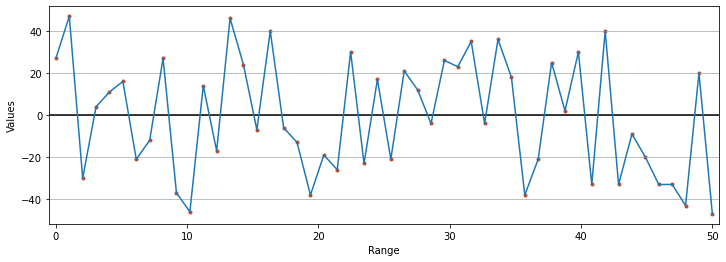

In [16]:
#Plotting the noise array:
plot_random(random_int_array, array_size, values)

In order to smooth the transition we will use the Perlin's noise fade function:

$f(t) = 6t^5 - 15t^4 + 10t^3$, for $0 \leq t \leq 1$

Which we will implement in the linear interpolation:

$lerp(yi, yi+1, \alpha) = (1 − \alpha)y_{i} + \alpha y_{i+1}$

where $\alpha$ is the fade function, $y_{i}$ is the starting point and $y_{i+1}$ is the endpoint

#### Now let's zoom in at the first few points and implement Perlin's fade function:

In [17]:
# Number of values in the range [0, y_number] we will take from the random array to "zoom in" the plot
# It can be changed freely in the range [0, 50]. For best results use number between [3, 10].
y_number = 5

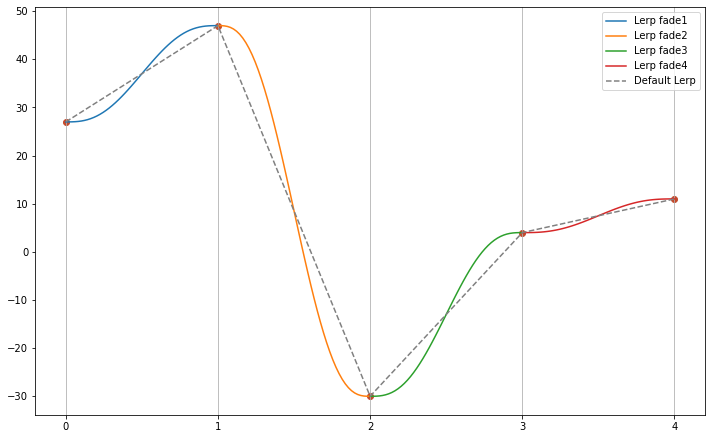

In [21]:
y = random_int_array

# Creating 50 uniform places in range [0, 1] in order to  
# create linear interpolation (Lerp) with Perlin's fade function between [x_i, x_i+1]
lerp = perlin_fade_func(np.linspace(0, 1, 50))

#Plotting faded Lerp segments:
plt.figure(figsize=(12, 7.5))
for x_i in range(y_number-1):
    # Interpolating the "segments" between each value of [y_i, y_i+1] with Perlin's fade function:
    plot_x = np.linspace(x_i, x_i+1, 50)
    plot_y = lerp*(y[x_i+1]-y[x_i])+y[x_i]
    
    # Creating a plot for each interpolated segment:
    lbl = "Lerp fade" + str(x_i+1)
    plt.plot(plot_x, plot_y, label=lbl)

# Plotting non-faded Lerp function:
plt.plot(np.linspace(0, y_number-1, y_number), y[0:y_number], c = "gray", linestyle='dashed', label="Default Lerp")
plt.scatter(np.linspace(0, y_number-1, y_number), y[0:y_number], c='#C34A2C')

# Plot
plt.legend(loc="upper right")
plt.xticks(range(0, y_number))
plt.grid(axis="x")

plt.show()

What actually happens in the loop cycle is this:

```python
x1 = np.linspace(0,1,50)
x2 = np.linspace(1,2,50)
x3 = np.linspace(2,3,50)
x4 = np.linspace(3,4,50)

y1 = (1 - lerp)*y[0] + lerp*y[1]
y2 = (1 - lerp)*y[1] + lerp*y[2]
y3 = (1 - lerp)*y[2] + lerp*y[3]
y4 = (1 - lerp)*y[3] + lerp*y[4]

plt.plot(x1, y1, label="Lerp fade 1")
plt.plot(x2, y2, label="Lerp fade 2")
plt.plot(x3, y3, label="Lerp fade 3")
plt.plot(x4, y4, label="Lerp fade 4")
```

<a name="per_1d_noise"></a>
#### Implement Perlin noise in 1D random noise

In [22]:
def gradient1d(g):

    # taking a completely  random integer number
    random1 = np.random.randint(len(random_int_array))
    
    # then comparing it to another completely random number
    random2 = np.random.randint(len(random_int_array))
    
    # and then randomly saying if random1 > random2 -> our gradient vector will be either (0, 1) or (0, -1),
    # or just (1) or (-1) and then return the absolute value, which will always be 1.
    if random1 > random2:
        grad_g = 1
    else:
        grad_g = -1
    
    return abs(grad_g)*abs(g)

In [23]:
def perlin_fade_func(x_i):
    t = 6*x_i**5 - 15*x_i**4 + 10*x_i**3
    return t

In [24]:
def lerp(fade, startpoint, endpoint):
    # Returns the current value(interpolation) by the gradient (fade) between the current lattice points (start, end)
    return fade * (endpoint - startpoint) + startpoint

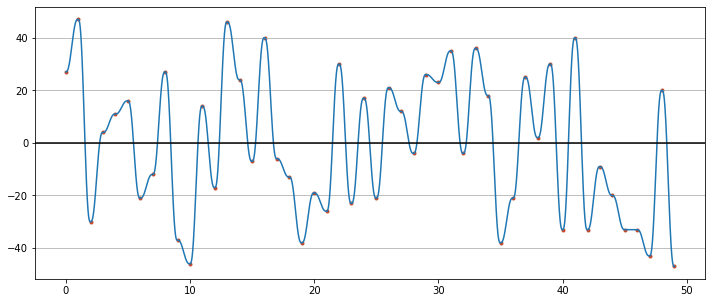

In [25]:
"""
Here, we apply the fade and interpolate {gradient_points} between each point in the random array(noise), where:

{y_number} is the lenght of the array

{gradient_points} is the number of interpolation points between the lattice points. 
Increase or decrease for smoothness

{i} is the current number of the array (lattice point)

{j} is the current number of the interpolation point

{v} is the absolute dot product of current point

{v_j} is the calculated scalar for current point in the interpolation

{faded_x} and {faded_y} are the total number of points for plotting: 
e.g. {gradient_points} times each intermittent zone between lattice points. 
"""


y_number = len(random_int_array)
gradient_points = 100

faded_y = []
for i in range(len(random_int_array)-1):
    current_num = random_int_array[i]
    next_num = random_int_array[i+1]
    for j in range(1, gradient_points+1):
        j = gradient1d(j)
        v = j/gradient_points
        v_j = perlin_fade_func(v)
        faded_y.append(lerp(v_j, current_num, next_num))

faded_x = np.arange(0, len(faded_y)/gradient_points, 1/gradient_points)

# Plot
plt.figure(figsize=(12, 5))
plt.plot(faded_x, faded_y)
plt.scatter(np.linspace(0, y_number-1, y_number), y[0:y_number], c='#C34A2C', marker = ".")
plt.xticks(range(0, y_number+1, 10))
plt.grid(axis="y")
plt.axhline(y=0, c = "black")

plt.show()

And plot the original graph for comparison:

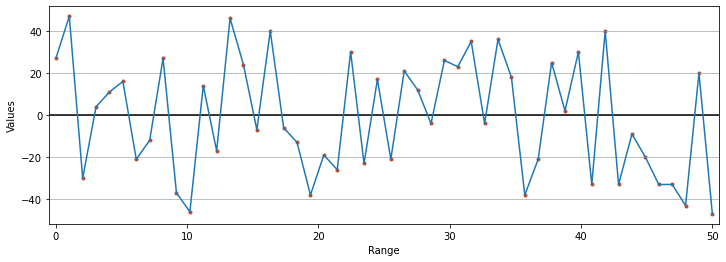

In [26]:
plot_random(random_int_array, array_size, values)

<a name="2d_noise"></a>
### 2D Noise

<a name="rand_2d_noise"></a>
#### Random 2D noise
Lets generate a random 2D noise in a matrix 256x256

In [27]:
def random2d(pixels):
    noise_array = np.random.rand(pix ** 2)
    noise_array = noise_array.reshape([pixels, pixels])
    return noise_array

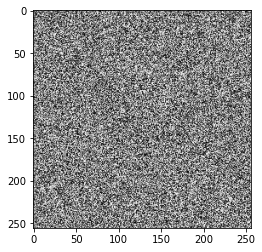

In [28]:
pix = 256
plt.imshow(random2d(pix), cmap = "gray")
plt.show()

<a name="per_2d_noise"></a>
#### 2D Perlin noise

Lets take the same shape matrix (256, 256) and define the lattice point vectors.


Instead of generating completely random vector, we will randomly choose between these:
$$\big\{(1, 1), (-1, 1), (1, -1), (-1, -1), (\sqrt{2}, 0), (0, \sqrt{2}), (-\sqrt{2}, 0), (0, -\sqrt{2})\big\}$$

In [29]:
def random_vector():
    vectors = np.array([[1, 1], [-1, 1], [1, -1], [-1, -1], [math.sqrt(2), 0], [0, math.sqrt(2)], [-math.sqrt(2), 0], [0, -math.sqrt(2)]])
    
    random_vector = vectors[np.random.choice(8, size=1, replace=False)]

    return random_vector.flatten()

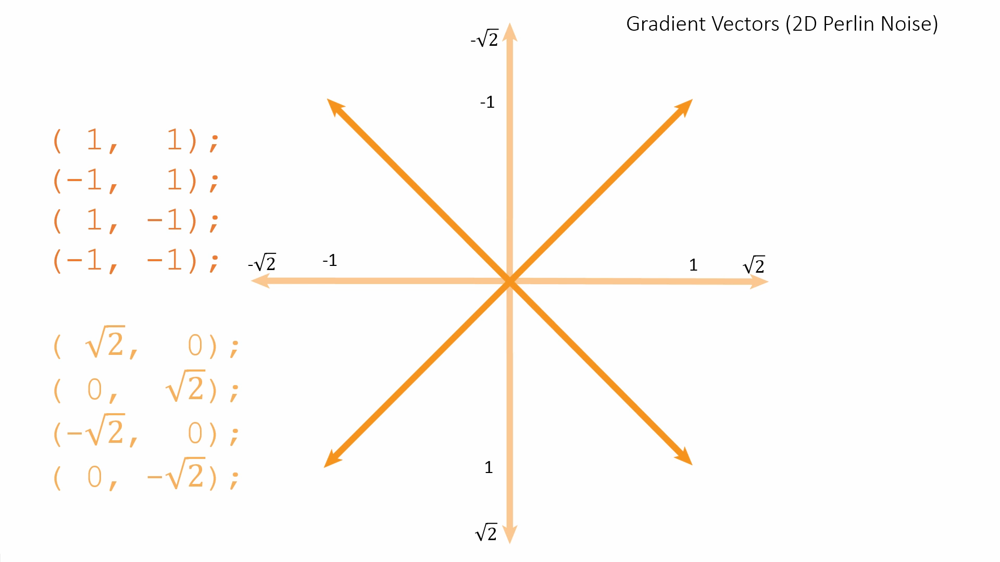

In [32]:
base64_data = "iVBORw0KGgoAAAANSUhEUgAAB4AAAAQ4CAIAAABnsVYUAAAAAXNSR0IArs4c6QAAAARnQU1BAACxjwv8YQUAAAAJcEhZcwAADsMAAA7DAcdvqGQAAP+lSURBVHhe7N0HnBVVnjd8oD/o7PPZHeUjJkI30IBhdnZHQaJpdBB8nLC7M4qPzo46htf4zD77Pu8YkKAOog4K9L23I5gGXRV1xrCmGQMKNCBJRZEsqelwO99Y4Z73d86/uvpyO5C6oRt+X8ui6tQ5p/Kte/5dt6pHioiIiIiIiIiIiIioEzAATURERERERERERESdggFoIiIiIiIiIiIiIuoUDEATERERERERERERUadgAJqIiIiIiIiIiIiIOgUD0ERERERERERERETUKRiAJiIiIiIiIiIiIqJOwQA0EREREREREREREXUKBqCJiIiIiIiIiIiIqFMwAE1EREREREREREREnYIBaCIiIiIiIiIiIiLqFAxAExEREREREREREVGnYACaiIiIiIiIiIiIiDoFA9BERERERERERERE1CkYgCYiIiIiIiIiIiKiTsEANBERERERERERERF1CgagiYiIiIiIiIiIiKhTMABNRERERERERERERJ2CAWgiIiIiIiIiIiIi6hQMQBMRERERERERERFRp2AAmoiIiIiIiIiIiIg6BQPQRERERERERERERNQpGIAmIiIiIiIiIiIiok7BADQRERERERERERERdQoGoImIiIiIiIiIiIioUzAATURERERERERERESdggFoIiIiIiIiIiIiIuoUDEATERERERERERERUadgAJqIiIiIiIjaY1mWMlzXRT+ZTCIRAzK1G5FVkNXxkprYto1EyYBR9GXgmCGr5q8j+t6EAyZlAcVlc3kTqPNha2ObY0AOy5Z7UDL4u1j4u6n9PW7yNh8erfJz4vSR4UMmtfl1tiRzkTXtCrA8WBjZvF6SIen+sAwclcXG3ME/ALzU1mCq5EnXScssM2q53Y4WWVOzxu1tIuokDEATERERERFRm6S5Dt64CSsIGU6f1MVhUUtKSr73ve/16dPHSzJkXdIHIH34GIB1Tw9QYkCGvcntSs9mSnu8JOp82NrV1dV9+/bt2bPnpk2bsO+8CU2Qgv2LAX/XpA+0+kcXnxwJLY8HpKRDSvv1HAgUlxpkoFVYEfQljyl0lGHdR4wY0aNHj+uuu85LMjIWUrb/EYa5y67BgAzLgExtSTLLgOT3Uzpcp1Z+CK6++urevXvPmjWrne1DnYcBaCIiIiIiImpmwhf7tM/dpqCGBIakL8EFDHiZugMs+RNPPNHD8JKayOp4I61thO5OVkfWMb1/IFpG1lDbgRenwySbevbs2ThuJ02aZI7NzIPTT0RmyY+9JsMg6Tpfa1DQP7W9JEPKClO9rl/6h0kq8apujdxn3SHzOnxYDPnQuPLKK70kA8vp9+GoLC3mjvnKrP0Bf5Fakgz+QHrxToJZtLM8R9Irr7xy4oknnnrqqVVVVV4SHUEMQBMREREREVGzjHjEli1bSkpKrr322iFDhvRqkp2dPXny5OLi4h07drSMTnZZrus+/vjjsgpeUprKysphw4ZlZWVh1bpO0KSjyG5avHhx7969sfpvv/22n7hfckgUFBSgLKxevbob7fRjADZ+bW3tySef3LNnz1deeQUbHynetCZIsSzrgw8+mD59+lVXXYVdjMw9evQ4//zz77jjjhUrVrRzPMt9zUuWLDnllFNQyidRVzFp0qRbbrnl1VdfbRm8a7kw7UBmyb9gwQKv6hbGjh176623vvjii13kHEwkErJgrQagly5d2qdPH3xu5OfnS/qRhI0ZDoeHDh2KxcNOnzp1aquHhw+TsNjojx8/HvmvueYaGfUmd6hf//rXmEVubm5ZWZmXdFRhNbEw2FBPPPGEl0RHEAPQRERERERE5EWR0Pdt3rz5zjvvPOGEE7KysnoZvXv3Rusdo0iU+BQSJ0yY8PHHH7cf9eg6Hn/8cSw2eOOGhGCWLVsmK3XiiSd6E7oe/xkIWGZZbBndL2TDPqqtrZW9ee211x74LkM2zFeeQtCnTx8UlESZeuRh1gJbwEs6pmHjFxQU4ODMzc1NJpOt7rjnn39eopAZsLt1LLlnz1//+td79uxBzoyyZkNqODWQTc5x9DEsxU01HlNTz9tvv33Lli1y+KXXIKTatvi7bOLEiX7lUq3MGgOSiFEccuvWrTvqxxvIIk2aNMkbN2RHPPHEEzihsNhyczp2ljf5SPn000/N9tPbDf1Zs2bpj4Y2HnYPSAQpgr0go960DoX6ZbstWbLESzqqsJolJSXYWTiP/LWWPh0BDEATERERERGRx22Kac6ePdsPQl177bXPP//8mjVrLCOZTK5fvx4pV199tUReYMaMGd2iJf/YY49JTMQbN7DkWPFPP/1UImJYcYx607oYs3P2ef6JhOf2y1+j66+/HuuIHVdRUXGAZWHDhg2yr2+77TZZBm/C0YB1kdjf0V2MIwZn3PDhw7HXZs2albHLsAWQUlxcjKk4erOzs++7775PPvkERbCVqqqq3nzzzbFjx2Iq9t15550nmy69EtmMIAFo5Fy6dCmKg5zvmFRWVoY67733XiyGhIn79u37pz/9SQoCKkR+r8Z2+cfhxIkTZalQVipBIvo4LHEm3nzzzZiKQw4z+uqrr2SSKXd0YGEgIwCNRcLqyEcKNv6ECRP8tTuS/AC0OOmkk+QudSxMqxsNiSCZOzUALRsNOxEHj5d0VGGD4OiSpVq4cOFR2VnHMwagiYiIiIiIyIvvSP+OO+6QVvqoUaPWrVuHhnrLiBUGksnkpk2bfvnLX0osY/369ZKhq0kPNLQagAasUXV1dW5ubu/evSdPnuyldrR2Qh4HGA1Zu3btiSee2KtXL9naWOwDLOjnfO2112QL7PeJAek133vvvSiC+X755Zde0hGUsY44Gvv06XMgq3DEHOBeODQff/wxVhan2JYtW+TU82EUW6O4uPjss89+4YUXMCoZLHMfrsR20b/nnntQHMe2vIFN8ggZBf8O6A8//DBjEoaxghhAf8GCBaeccgqOBCySH4OWqVKqff6GkgA06sHHiFSCRL8SLP+KFSv69u2L5cHsKioqJL1Vh7Dx91vEzyADWFTICEALeXQJpoZCIYzKlj9w/rofMj8APWHChCxzw/utt94qux5arqmkS5HDDEC3X/BXv/oVZjFkyJDy8nIvKc0h7LXDhDnCNddcg531r//6rzJ6yOtOB4sBaCIiIiIiImoOJdx1110m2NLjjjvu8GND0lAHZJCbItGXGAcG3n333T59+mzevFlq6FKwhFh4b6SNALSsCLJhQNYOMOxNbhuyeUMHdidy+pJkaGdSOnmIM5b/448/xtwPsBTIOsqwPE34/PPPl9G2+JWj4NChQ0844QT56TrS0ZcBmSrZWmpnku9A8qQvifQlAIq9KemH5kBm3RZ/SWRUtokMt8pfhUNw2223YX3Hjh3bzixkAfw94pN4aHl5+amnnoothl2PxPS7lSUbSAA6KytLHpggBeWwEZIZs1izZs1pp52GRULmv/71r5IoGfbL3w4TJ07E7FAJUoS/VFIhvPPOO8gAt99+e6v1I4/fPygoIhWiLyTd52eQyvVHRmsB6EQiEY/HseQH9bmRTkp5I4fED0BjD06YMAGbC4v65ZdfSs0tN46kS5GDCkBnZNtvQZnqb8l0SGm5YJ1NDuaFCxfKQYULFpbhyC/GcYsBaCIiIiIiIvKCBe+++66EWn7961+jud5+43y/TXfUmQ4piURChlEW/YxgTTwel3T0ZUD4wR3wsrYL1UroHMPooyrUABhtNQCNDH6oHWR2kr8tklOGzcLuQ9LTSX5MkgFIT8e8MEkWW9J9mGqq1DC6fPlyCUB/8skn/g6SBW61eKvuueceCcHIHbVSOQa8yUZ6+tq1a2WjYeulZ8PsJANmLcsgw/7G9PLtj2RGVf4aCX+99HI0PdNWUmR5/Pt5M+Aw86owkCI1yDD6soQZk1qFDJJHBpCCo9RPBwxLDRiWRZVEfxgD6GNYSslA+6QGgfzyB4NHH300Pf0AoYiUmjJlCrYY6lmzZk36Mvh1yqmBo2Lx4sWS0hYU/+abb7LM82r69u1bVVUl6+hNbpc/awlAA1IAxVGJTAI/28iRI2UubR3bUtyHFL3C7S5Mek7pg9Qve00GkOjnxDJAq4/gQE45fyUlvRRkHC1Il5ozSOZD4wegsQeXLVuGPYhFxebFpFZrljlKkQMMQPt5cGbJJvLXwl/TDHoTNJGyvoxt65MUTML29JJakEl+HlkYqV8SpRKhC6SRha+srMSKYxPNnz8fRaQsHQEMQBMREREREZFu/JeXl/fp0weN8zPOOKOiomK/LfOWLfx0JgLgSR+1TBhRhjNmgVHbBKFkquQUkrmtIFQ6CUz4UMqfI0ZbDUBLBswaZAB98Ca3RmoTkhOVgF7u1jaLVC78nEiXsuhjVM+ytZn6k1C2tLQUC499tHjxYowiMb0eySwp7Xj//fd7mwd8FxQUSGYsD2qTqQLpSJSBe++9F5mzsrK2bt3qzwikiKTIkvjDKCvDSAQMtEPKghQR6cvjTxWYZOLnvSQg7kvPLPwUGWiLX7YlKSv1Y74+jGKSJPrDAil+WT8PBvx6ZGo70vO89dZbcsR+9dVXB1I2A+Yry/PJJ59IPcuWLUuvxx8+8AA0iqDOJ554QiqcOXMmRmUu+yXbASZOnIh5objeRk1bSSaBn23WrFknnngisq1bt05SMviHLmrwyaR2SP3S98qYUt5Q2g6VPGZFW38EB+aOPH5+8CYYUhz8tUvP45cyFXg5D1b6HdD4hLz99tvlbMVnRas7ReYoRfYbgEYN8teadEj3hgzJ2VIikZCVQh4Z8EclBX2dr4NIbVKzpKTTs2ya3ejRo3Hs+U/hkETqbAxAExERERERkW6fP/XUU2iWZ2VlvfDCC7bhTWtDO013ae0LSUFmCRVJomn4ZwYg/BSTRfOzSV9Cou1DNm8ojZ/42GOP9TS3v8mowFQsmFTu52xrXsggZFSWUNKlEhmVSTIgW1KKINEf8CdJIvqyfZDiw6hMkmEJI2IfyXu9kCJFJNbjM0XbhCLnnnsu6hk8eDCGW11TqQSTkCEnJwcbbcSIEXpRmhbPH/Bn56eAWYpmXmobkMFU7K2m9P1RGZZRLIz0caBCywA0pkL6AMgk4ScKCa6hQm+8DciQkQejKIja0vtIlGHJgwFJlwGQUjK1fSglA1OmTMHG7927Nwr6iQdOSsGSJUt0DLVHj4z4sr88EoDGvPYbgAaUCofD8iTuU089VVJkUvv8VWg/AA2S880335SlwgEvKemkoEBxn6R7mVrwJ5lymXAqoe/XIH0sA7QagNZlTB4pkrGQ6ZMkRRYPA/4HTjqT5eD4Aegnn3wSNW/duvWMM87ARwTO7lbrlEQpst8AtCy5D6OS4qdjwMvagkyVDBl9aL8stD81nVkQTUZbFvQmN3nggQdkh5aXl2PUy0SdjAFoIiIiIqIjAO0hv0WEgQNtVhEdScOHD+/Vq9fJJ58cDoclMOdNOFSoYdy4cSeccEJRUZFEW957772LL74Yc+ndu/e55547ZcoUPyf6rutWVFS8/PLL1157bXZ2do8ePVAWrrzyyscee2zz5s1+yEYy65JpMBWTysvL77///hEjRmRlZZ144oknnXTSddddV1paKnnaCkCjNn9pf/nLX7a/+l999dUjjzwycuRIeRoGYPiOO+7YtGmTnRaDljqlCNLff/99VN63b99EIiEr8uqrr/76178+9dRTsUjYJqNGjZo1a1ZlZaUUARQHZL766qsxL6yRzM4nBTGAvrwu0ivZLqwdNhHKokJZZllUIXkwgERMQgaZb3FxMUb9DIBR6b/zzju33HLL0KFD5cZqLAx22eOPP97+Y8H9qjZs2IDlmTRpkuwa9LEpbr/99jfffFPmiC2AgZKSEtng/nbI2CDYvFhIqTMD1uWNN95AnWPGjPFLYRgpH330ETaIl8/AHP1lw8B9992HNfIfSoNj6aabbpJKsO9wdOF8kQ2IvmS4++67sTVQCrA62BoPPPAAtqRUKDW3D/XIAI5kVHLVVVdh+ADL+pAfUBX6S5culbXGgF85YJIMpAegTbn9z+vWW2+VXfb222+n19kOP1tbAWiZL/qSEwujPwJOOCFjsUHO9z179uDj5ac//SmWBDsFdeJzDDsLx6SXrwWU2rhx4xlnnIHMq1evxijg1BsyZIgs0ujRoxctWiSzk1MVidDyERyA3YrPTMw6Pz9fUrzJBs561NmnTx85ktFHCo6Z008/HUWwzNi/TzzxhPziRHglD5gfgJ49ezZGMYuZM2dipqh/4cKFLSuUuUiR/QagMemDDz7AjpaPOxRBtdg+cnq2XxYnDjYa1t0/v/SeNlAK/erqauw7HNuoVk7t3Nzc66+/Hme6ZG5Zuez0rVu3Ymtjp2M1ZZEGDhyInf7uu+/K/mqVLAaKv/XWW3rle/ZEfplERwAD0EREREREnQiNJ9d1bEc3mUwM2lWmw4CXg6hr+PLLL6Ulf8cdd8g9gN6Ew4M6e/Xq9dRTT2FYXm8oIR7MqHfv3hiWbPoEcd38/Px+/fphqk+KIzOGTzvttEWLFkkcJz3KoOMZTZ588kkUQWa/lMDohAkTKisrZ8+eLQvgFU6DajEJxSdNmoSqvNQmmAq1tbXyC3fJCahK+lLtfffdFw6HkVOWBwNYYBmWl7ydeOKJqG3jxo2XX345isAJJ5yAdFlajJ588slff/211ODP95prrsFUH7Khr2ffBCnYg1LkQKxevRo1YKa///3vZZOCN60JUlDh/fffL/PC1pNsSJQBWLt27c9+9jNZHoFhZJbhU045BfsU+TELr9ImKCt9/0kOEt7CQHptQ4YMkUdPwPz587HA/lR/Lj5sW/+5riAzwsGMGoYNG4YMKAtSEFWBJI4YMWLdunVesX23AxYeRw5yoo/RF154QYqgLwOoTf68gZzY9ddeey3Skd9fPH+O6CNbRv2tQlWiqqpKyuK4QvqBlM2AIqgHfYkv42BbsWKFN83w6zyoALScgG+88QaKwAMPPNB+fh8WRgbauQPazNxb7IKCAmSD5cuXS04/A+DgkQdky2Kkb3YcTpjF5s2bkU1KpVuyZInkxL7DXpNnMiDFLy67GwVlqSSx5R3QqNyvCguDFLOMzbObNWsWJqFy5NyyZQtqwLAceJIuMz399NNxlLYTPG2HH4CWBcCMsEbYLKgfJyAOIaT4JANIkVYD0FgMWXF8SgwePBhLKxsWZLFlFAs/ZsyYVatWobh8hqSvOFxxxRWSP6N+ZIZ33nmnb9++qEcuBJJTZoFRrAtq00tmqvXrRx+f4SiIZZD86VAQn6ubNm1CNhRBfiHzxXpJJWVlZWZuPfCZLJPoCGAAmoiIiIioE6HVZcLNjpty0DI1KRKAJupann76aWnPL1q0CK108CYcBtu2JUzw8MMP33XXXaj8lFNOeeGFF1B5eXn522+/XVBQIPOCW2+9FTl79ep1yy23vP/++xUVFSieSCTWrFkza9YspANq+PTTTyV/xl2rruvefvvtOlKSlXXeeee99dZbEkbfunXrzJkzTzvtNFTep0+fa665BvVg2CuWBpllFi3DTICp1dXVY8aMkTDHbbfdJq8BBKRjdv/+7/8uNY8dO1byY5HQB4xiWALQyIA1kuUZNmzYyy+/LIHdTZs2+XdnS9hIKhF+VR9++CEynHjiifJEAswd20HiVpINA/slBc8//3zMTp7CASjuTTZk8yJdFhXbDRkkm78wa9eulfAfNiwWHqNIRJ6NGzc+//zzI0eOxCTsjilTpkh+qVkgG/rYZagcrrjiijfffFMiX5g11u6ee+6Re8NldyAdsE9lQDY1ZiqjQqoFmZ148cUXZav269cPB5LchozMyPbRRx/dcccdmITa+vbtu2rVKkzKgIXBsiHDhAkTJPoMOKLq6uowdenSpdittbW1GEaF119/vdT2wAMPrF+/XrYhduW7774rq4NRLBL6BwjbQSrMz8+XFFnNg4IimOnkyZOxL7ApzBZq/nuAvzwHHoCWCrGzwuGw3hxNr7w7EP7ytxWAlpoxIOnYbuaczpJjQzJI3/+DFqp67bXX5A8/gJ1y3333fe9738NUnErY47Ij0vlRY+ya0aNH9+7de/z48aXmock4enFWvvPOO6gKOaWPnHAIAWgkYhIy4KzHwmBpcdY/99xzOCqwRlu2bJkzZw6mAqbKgXSw0p8BjVHMHUuFwx4rBUiUT0KBDDIgRVoNQEsKLgRYctSAsxtrsW7dOtkFqG3FihU4cWS/YLHlLnKZr1eF0VYAGjmxNVAzimNr4MMTZ5MU/+abb4qKioYOHVpcXCwp0gcpe+edd8phg33xl7/8RX4vgkWSnY41kkWSGDTKSinhV4UByXnllVdi1JtMnYwBaCIiIiKizmUizjY6NH8w6qYUOplE1HXcdtttEiz49NNPvaTDhrY9Gvmoc+jQoWjwn3LKKeXl5RIUMHEAL6CJvmVZV1555R133CGvuZP0SCQiMSkUWbp0qcQdJk+erEuaqEF6fOHtt9/GLJDh9ttvx9T0uaDyDRs2nH/++Xr1zE2g6EupdMiJWaCSVgPQqFBubu3Tp88bb7wh1SabXs+Fqeg/99xzsgyzZ8+WFPR9EoCGf/iHf0CeW265paqqCumoBH1ZZbnfE1PvuusuzFRXbcgyJBIJP9olD+r1JqfNSHK2T7IVFxejHtTWzk/psaZYHli4cKG/skhHf8+ePeeccw6Kjx49Wl4Qh0TUjL6sC4axFiiLPFhsKejDaFFRkUyVlUUp0OvQtOk2btx4/fXXY7NLWfRlAJPkuHps32dAy3xlQCpZu3Ztb3NjNfa+xPTNTLxAp+T85JNPTj31VNSGfnV1NSalw17G8YCpw4YNw5GDBZZ1kbLoy4wAGwFTkRM7GpP8oKdM9UnifslCLliwAAuParG7JfwnUw8ciqCqiooK1AO//OUvkZJej79IBxuAlj6KwGmnnYbF8ya3y591egAao6hKVjl9vvi4kD9CXHfddUiXSdL3z5RZs2ZJosA5Ilt+9erVOFWRB7uv5bL551Fubi7yXHHFFbLLsDCyPOijNskMeiUPKQDtb1U5xvARJ39aQ0HJiQGcCDiecaDKiXCw/AC0bAqsLOpHzWPGjMEcUe2WLVswF4EMMiBF2gpAY+thKoqPGjUKZzpqw8aRxZY8GMZ8ZaWwneWjLKOedgLQ+BhHet++fWtra/29I/UDUmRA6gRMQob58+fLUj355JOSH5DHlNaL/fnnn2NhkAGzloIySWAUmaXOyy67DNmw971p1PkYgCYiIiIi6kQ6+uwk7Ia9Kh5WKctNKcd0jEFTV3PllVdK294b7wi2eVkc6kTNGFixYkV6sEDCATIqQQEZBn/Y5PKiD5MmTcoyt3BiWGIWfnEYNmwYZjF8+HCJIfo3/UlZ5K+srBw7diwWRphC+0Bm1ID6MSMp600wlppH6GJqUVER5ivVSjYM+/27774b2U499dTwvs8FBglA9zaPOr3pppt0yTRSGyqRsNHf//3f+7OQmvVCpFLLli1DJcggEUmZinQ/ZCMkczuQf/PmzdieJ5xwwl133dWyFEZRs9zn2LdvX4nNIVH6yIDVwbqA3DiMDY5JpqgH2ZCIPYIFlkcYp8P2+f73v48VmTBhghSUyoXMHX3MF4sqKUJyoiBkBKB9kh99iR2fffbZZWVlfiUYkEpQswy8/fbb2PVw7733SqIPU3FqoBJ5Uop/z75MwkKiNjFz5kxsDVSyceNGyQPIJjtI8iObDO8XcqIgNrJZUX3XvOxib/L++DkxgIKzZ8+Wc0d+QJCRQQYONgAtAyNHjsQqo3J/Ndvnb4GJEydiXiC1gT8gUOGTTz4pi4SzT0qJhoYGiTNed911/sIAisgwBnDk+M9LwVkjGXx+1BhwiOJolCMck8zMvYXBKNLRl5yHEIDGlsdRIcV/97vfYcEA6ehL/dIfPXo0KsHnhi5jpFfSPj8AjQVAbQLF5bMCq4/5IiV9jiBFWg1Agxzz+FCtra1FVZIHZBgZZPTNN99EJdj7DzzwQMvjs60ANDYpSiEdHy8ohTpl2UDqT+/LJGSrqqqSePfVV18t29DP4w9jQHY6zlbsFz2zNJJZcmLF9ZK1WDbqPAxAExERERF1Fh19RoPHbaxY/75Tvlq5UTSSnJSykcYANHUxEnHo2bNnRoNc2v9osa9Zs0ZHLPbVy0DBESNGtGzJI8W08XW1BQUFEmvwJ6Hvj+4X8vvBuKVLl0pxv//ll18iPSsr66WXXpLEVlVUVIwcORI5scxeUhoURDoWVQLQkiJ9LOcVV1yBScOGDcNamOytwLaSJYF3333XXzsMgASgsZD33HOPpPvSZyRBN1i9ejVGZZLPj3b5UULwph0wv4hEYU455RSktFwvJMqTZO+8805MxagsD1RWVp500kmYdNddd7VcyHRFRUWywBmPF/CfjOHfcY96RMZoOpkEKAiPPfaYN27IsgFyoo+akQdzefnll5HiH34yNYOEqrEp0uci5GZJ1DN58mSJfKWTmlGD7F/klLtBBdLlDErnlWybn0eWCjAs9Uh6+zBf9GWpMLBt2zasFw68n/3sZ36izx898AA0+FP9JUTNktI+WTaQYw9nnKSgQn9AyD3OWJ7f/e53mORPTSQS8lwLrJE84llX1xoUwYqjhvvvv99LMlBEnm0CJ554Ij7ZsG0zll9mJ32QzO0EoLGocjTqBW0qBfIMaPjP//zPeDyOFBRJzyCjs2fPRh7UI2e9TErP1o62AtCYdPnll8vc8ZnpHz+SQYq0GoBetmwZimCNcOJga7c85gH1AybhwoEd0bdvX4xmbMO2AtCAWSP93nvvRSlMlcNSsqGPRMnmQ+Kjjz6KIliqrVu3SqJegtZgYaTydo5JeUEiatuxY4eXRJ2MAWgiIiIios6iUo5yE6p2297lz9avf125dbpRZWLQDEBTV3OFedAt2uQtww1o/KMlL08YAIlcIGe6E088UZ7DkA5VydQhQ4akhxh87oFFWCR0UlpaKrX5AWiBYXlIdFZWVjgc9lJbg3pmzpyJbKjES0qDemTtJAANkgi1tbVYQUx9/PHHJb1VmJRIJFA5KpkzZ46kgIRF/ADlJ598gkQp4pMU9JcvX65XskePjz/+uOX2WbJkiUw9nAC0wNb405/+JLU999xzGfUkk8l3330Xq4ypb7/9NlIkg/Tff/99Kfjpp5+iHpB1bAl7TTa4vKnPJw/jPuWUU1DWS2rBqyKNJKIvc28rAC3D9913n8waRSRRysrUDK+++ipyYgf5AXGfH4DesGEDciJF+kIqR/+ll17Sy9SjR35+vhztSJS1Qx+jPinYDj9PegDaX4v9kmySH/xKVq9e3fI09IcPKgDtu+qqq6TyA8yPpZIBPwAtmwjpYuvWrQsXLpRqsfuw8OXl5ahcpsryy+PF5T2B7Rx7yCk/7MgIHCPdD0Dfcccdsne8aU1Q3BsyJHNGPYCC7Qegn3jiCTmJsFUxivyY2nJ2y5Ytw8qiHhx+mApYU2/a/rQagJZJmzZtwtwxSZZcNrVkkCKtBqAfeOABLAwKYliKtIQiWEKsi9xxjKoy7lKHtgLQqDPjBytmEZrzpG9AgSJyr/3Pf/5zydwO+WOqrJpXvgXsLLkzveX5Tp2EAWgiIiIios6i3KRy66PbPqtbXli9vETVb1MpK6VSzc8sJOoyJMqGFn7LRnvLAI1u5Tfxfya/bNkyjHo5DMuyUCGmymMWJD94kw8ASvn8mFH6HdCASagfMxo1alT7URtkfuqpp6QSLykNpqISrMikpjug/XiNhHh69+6NZTB524Qi8lTZK83rrUAqwUL6AeglS5ZI7EaKCBlF/sWLFyMPaigtLc3IAx0SgEYR1Ix+eXk5qsJSyTsGvckGMtx+++1YjCFDhkhmySADjz32mISosHYJ87QTKdXS9u3bMQvknDt3rpdkYCshXbaSl9RUufCS9j0GZBR9vQnaDkADsskbIy+//HJsbS+1batXr0aFWKmMOsEPQMuo5JdhISnV1dWDBw+WXVxUVCSbxV9mGZCcplB7/Dw4FPV6HlgA2p+KnP45GwwGsUjY/o8++qhZCl2JHJPCL4UVx4yQ+aAC0FhllMJ2O8D8WAAZmNj0CA4sG4oD6sGwwPBpp50m+8I/wGThMYBSyIATKh6P6wVtA/a7PBIHFepZNsEknMhSycyZMzGaNM839ya3BjnhEALQ2OxYNUyVyLKsAniTm2Aq6kc9/q3KLfO0pZ0ANEyZMkW251tvvSULJhmkSKsBaInvZ5ybbfnmm29QOWYxZ86cjPxtBaCxGMXFxZgFJo0ePXrLli1IbH9e2EFSFTayHL3I35Zbb71VVlnKtkruTMcyfPjhh14SdTIGoImIiIiIOpzX+FRuXEW+q12zKL48UL8sGN3+mXJqzQ3Qqrl5StQ1SDwIbXIJB6RDk17iJt54WuMfw/7P4TNuTBYSCEDlfuQFvGn7kuBIWyzL+vDDD1EV+DNCojyhdeTIkViAK6+80uRtk532UF0vaV/YAuAHoGWZUWrevHlYEZ9ka0mCaBhA/9JLL03faBiWADS0uqEkBX0JRZ1wwgnFxcUtt0lHBaAFhu+66y7UhiWvq6uTqQJrLY/ZnTZtGrYzUiS/RMd++tOfmqXwSIitHVhrHCemYg+KIHHWrFlSrcD6+rykFonSl/lmBIv1KjXBgSGzkJ/5gzehDcjQu3dvbPannnrKq65JRgAa5KjLgBpWr1590kknISfyDxs2rKSkpKKiAul+Bn+4fVgeGfAD0FLWT2+VrIU/jD21fv16LAxknIAg2cAfPrQANIpgu2ETeeP74y8hFkl2EJhV1L+iQH/IkCGYlJ+fX11d7S8DBlAQxyH6WDy/CKQPZzB1e1OlHoHa/AA0zkpJkUltkUoOIQCdHuhEOvJDegbAqB+ADgaDfjZv8v60E4DGgYojUB7AcvbZZ0uiZJAi2NQyKpOE7Ij77rvPG28DSuEYk9AwTpxHH300o5527oBG/5577sEkLAOWDZ9C2K0yVaRvIuz3FStWIKcsmPwYpVVmnTRkw2GZMd90ctlCzv3+TZE6CgPQREREREQdy3VtSz/9WTfOImrHksjy+dayebFlgchXi1Rsq3KiSdvZp/VJ1AX4kdk33ngDjf/09n/7/Jb8kiVLWjb4pc4rrrjCr7BlHn92+qwxb4S79957L7/88tNOO01qhl4mkJ1lIrwSwAUJSGEAGfy5SHSjVZjqL62XtC+ZlB6ARh/Ds2fPlgWQDAdi/vz5WDwsjFQCfoBPNpTMwiej6PuhKAmNZfAD0J+09hyPgyLF/YdpLFy40K8Qy/zmm28iEYvx5Zdfpgeg0cdUCS2ZmI++fdXfOK1CJX369Ml4EZxMmjVrljd+MLAMUjwjAJ0OWx4ZMOuZM2d6SU2r0CqpEyvy6KOPekkG0v0H6XpJTQdGqzZv3ix33QK2DFx33XX+01RQG0jO9klOCUCjEhRv58AGTEV+ZAMMYBQ77tRTT8UWGD58uDzFIp1XLG2bHHgA2p8UDofNiva49tprJWW/sHgyMLHpL17tzKglZMbiyUxB/mbgjbQg9aP/L//yL155A5VkBKD3y9SXGYCWTS0BaMCnBEb9FRT+n51wXmOq8KY1QRFZKalEElvN2ap2AtBC9ixgwP9EkiKtBqBlSVDbfg85VAWSv+WWbCsALc/CTiaTr7322tChQ5HBfJD0ys3NxRLK61uRQUrJLGQdsbuRDQMogmFTdytwvqB//fXXJxIJPb/WzJ07VzJj93lJ1MkYgCYiIiIi6lhokbopx0bTSaUakl/9OfZZnrM8L1GaV7+iSO1dopw622mvUUd0VLz11ltojaNtf9ttt6HlLyGAA+GHdCXC4qU2MW389gLQMipzxDIMHz5cahN+xAGkKvDvIEYRCZEgT1ZWFubih1dahUkHHoCWWQBKPf7447IYH330kSTuF0qhBiyPX48fBmp1Q0kK+pgqi9HZAWifhClHjRrlx5tQ8+TJk5E4btw4rEh6AFrW6/LLL8cGwWLIJCTqYk0w6kNm6YM32UDlKJ4R7T1AqMpsg/YC0IAMmEt6noxlSCd14ijyI4AC6ekBaH8TtUXWetu2bVOnTpX3NAK21ZVXXrllyxbZFF7Wdkk9P/7xjyWaJn9r8aa1BtUC8shAZWUldigK9u3b98svv/Qz+KQU+MNyfGKL7TcA7W+E999/X84LCX1KYvv8tTiEALRZKO95OCiIE0SWRNIzSBG9EVtsN0zF6SNLjkpaZmgJs4NDCEBjy2ASyvpnvb9sPhRJD0BjFFpma4tsEJC9ILxpBmobNmwYMuBMr6qqwlQcTlKk1QA0PnUxqf2TSz7ZUDOGZclbnsttBaDNDPUyyFH94osvTpgwATVIPaeffnpBQQHqB3n6CgbkDwZYMPlURCL6ejO1y8ytdXPmzJFlw5b3kqiTMQBNRERERMcXr13SxEvtSKb971oqlVB1W+tKn04snZtckRdbPi+2MhRb/6qyKlUKbebOmDXRoauurj7hhBPQyP/+97+PBr+08PcLJ9FhBqCRLilTpkyRGMSQIUPy8/NRm2Swmt7ntnjxYrnbMf0RHEiHk08+uVevXj/96U9bLgAgg/ShnQA0psok/w5oSUT/scceQ3rvA3gGtA8FUYmJonjROgnwgQT4JNEnKehjxWUxjkwAGst5xx13oEJswI0bN0rinj17ZC7yQAB/FXzyCI6srCzsgpZTsWCybH4flQgzXUNxrCO2SXriAUKFZunaC0BLHswCe9xLalqelrAMWAtkhozNjiJ+ANqswX6W1l9ZDGDjvP/++zj4JaJ30kknbdmypa1laAmLhEMRBTFrOQu8Ca3xZ4p+OByWN7addtppa9euRaKky4DwiqVtEzk+Mbv9BqBRlQz8/ve/x1xwGKxataqd/On8socWgEZxnP5SEAucTCZly7QKRWStpbgPKUclAO0ltYAinRqAxqi8IRN7Sh56g0Pre9/7Hoq0GoDGlkFmbJmM9HR+KWx/ZJb8MsnXTgA6o4/1xakxc+bMPn36YO44X6ZOnYqFxFTZFFhHWSr5xJDPHKRnQKKk+/22+D9T2LZtm5dEnYwBaCIiIiI6vuiGXRov9bChoqa65PZnSzk1ye1LG0uLE0vnxJfnWavzndX51aUlqnqDciMmBk3UhaC5Lm3ynj17vvbaa37j35u8L79tjwwS0u3Vq9eSQ30EB1L8oNKdd95ZVlbmpwsMY3kkRgP+IziQLtWifhQfNWpUywVGNklEHw4qAC3RVQz/5S9/MXPWd+zqGZupMtAqU5/HH5UAH3S1APSaNWskuJOfny+JL7/8MkazsrI2b96MuUi4x4civ//975EBpbC0/pL7JJtPb/cmXlIqdfrpp6MG/1WNktiybKuQDWWhnQA0DBw4EHkmTpzojbeoX8/YpGDBvvzyS2TGKr/wwgsyVSBDegDaS22NVIW+WVEv2ivHT0lJCWrGPsXh3X4l6VDwvvvuQyn46quvJEUmtSRzRL+6unrMmDFYWpR66aWXMAnpLUkp8IcPJAAtiXr1zOzOPvtsFBk2bBhGJcN++TkPIQCNjQn4fEApHHs46zGKdL2sLUiRVhcMU4+rADSgQmxwzKJv376bNm1ChuzsbBRpNQA9ZMiQlptXJmVIJpP4iJC5L1q0CHPxJhhtBaBRSuqUd0giBQXlDwkbNmwYN24casP5snHjRqRgGTBJHvaCdHmfrWSW2lolBdvJg08eWbaMZabOwwA0ERERER2zpO2UAY0NIaNon+wXsqGqVmsTqMtNKdPpQZTQT3+u31i7+qXY8gKrNC+xPBBHt3ROZEVJbPPflFWuXP0MRKKuA4f6jh070Ozv1avX97///aqqKiTKmSJngX/WpEOiH7fyY5HppJHfTgAao5gkL6TCrCsqKpCSbHrJGyZJQfSXLl2KxUM2/w5o9OXElHt4oaysTPL7pH5kk76/tN7kNMggk/wAtCyGZVlYKqRjKmaEbIB05JFsPuTEpIxEX4cEoGUqvP/++23N6KCgEix2Tk4O6hw+fDiGkTh58mSMynaQlZLMZtV19Of5559HBuyv5557Tn4m3xLyS1+KyC4w1WgSnMJ8kY5sUok3bV9ITy8IKIKyson0ApltjkRvsoEUeYrIKaec4tecPuCTGoLBoNSZcUckMrR8BnQG5JHthr5UKIkYQB8wet5556GGvn376gIHQIo/+uijWCRs59LSUtlQ3uR9+emxWOzaa6/FjFDqhRdeaCt/Oj9P+wFojGasF+qXO7uLior8qfvlZzuEADTKyhaWBwcPGTIEKRLN9Le/5BSYhAzgjTdB/uMtAA2SDWuND1vUjxMQo60GoOX0P/nkk5Eup1XLPDKKDV5QUIB6kH/r1q0ZedoKQOu6DCyGl2RI4ttvvy27Zv78+d4EMyN8OuHzPzc3N+NMb0kOkoyDAfNCipxEcP755+PoxYdDxjJQ52EAmoiIiIiOF9LqQGNDpCe2D5m9oX0bUT7U5aQUOhOAdpBLWXVqz7KaZcXx5SGrNC9ZGkCHgWhpfsMXL6vIJuVGvMJEXQaO8Pvuu09CBtdee60c+Ug3Z4wm2YQ/Se4p7mVuhs1o84PU1n4AGqWuuuoq1HDllVciBTkz8gBS/NhregBaql24cKFM+tOf/tRyOSXFtu2qqqrc3Fxk63lgAWh/STCAgr179z711FPD4bDU6dcMGPZJSksdEoDGumNDYUlQiQRT9huOaR82PtbiySeflCjSl19+WVdXJ4FFeS0heFkNWfEtW7bI41Auv/zyjAzpMEnyS+jH31xQUFCgt0XT1siY6sMk4Y0bGJWy2EQYllmAN9lAIg4GiWS98847MtXfVpLfh8zjxo3Lyso6//zzJYMPU/cbgE5fcuT3hvb18MMPo35odTVbkmwfffQR5otVWLBggVnSNjc1YOpdd90lh4d/77NMaoefp/0AtL/YGMDerKysxLmA/MOGDWtr37XKz3kIAWiB/HfeeScKYk0/+eQTVIgUqTajKkmXSemQflwFoFGbDNx22204AjGjrVu34sMWRVoNQD/zzDNyFL355psYlQwgU31S7dixY1HhmDFjWn74txWABqSYtfT+NCgpkg0pKIJle/TRR6VOpCeTSdnpSMf6Ss79ysgmo+hjjlg71DZhwoQDrIoOHwPQRERERHRcQBsDrRrAwMFCW8UbaqOhgsbTPgFo5LdqatYuql8WTJYG7NJ5VmkeOmd5ILYsULuyUJV9qtx6rzBR1yCHd2Vl5ciRI9Ey79WrFxr8iUTCnyRhggyYNGfOnJ7mxrpW46qoCtoJQAMmXXnllVlZWYMHD8ZUnKdIEZIBiRUVFbfddpvUJs/6ACmbTCbD4XDfvn0xafTo0ZKeAYnl5eWYKjWANyENqkI61kUC0MKblkq9+OKLmIrVvP/++5GOzBkZhCSCN94E+WfNmmXm7IVcM/L4o+0HoCVQ1bt374KCAi/psGHWW7ZskXjcfffdJ2uK3YGDAVP9vSBkxdG/5ZZb9Mr06PHnP//Zm9aCv1J+KRmF7du3Y44ojl0v6einZwAcfs8///yQIUO88SaoSkLkkydPRhGpWXg5TG1VVVU4KpBt+PDh8lwXHFoy1Sdl5fbnE0444e23306vBJBhvwFon14Cszzpo+L6669HDbm5uRiWqe2TSjZu3IhSWIXf//73cl7I1JaQ/3e/+x0yy5mLUfnTgje5bf7SthOAzhjGhpVTCQeJPGMae6rltm2Vv0iHEICWWWC9duzYIQHEESNGyCRU0urKSuUZs8DooQWgsczeuIGCqKr9ADTqxySUPZAANBxaABoFMRcJQCMlo6yMYuvJaY7MOOlk+7cagK6vrz/11FORMycnx38gUkZ8WYoUFxfLrN96662WB0A7AWiRni7DWPE1a9ZInfggkjoxCTZt2oTjDUslr0tFTlOuFW1NknqwIl999ZXsFHyYe9Oo8zEATURERETHLLQ0ZKCgoGDGjBk333zzZZdddsnBQwvt+eefR5OmZftKoK3jB6D1w52tqBveXLPi2eSKoFU6z27qXIyuCEZXBhu+ekk5YfOiQseUFlja1htpREdSOByWZ8iiqT9y5Mjly5fjyJemu5fDkBBJeXm5/OQfmdevX5+RBzAJ2r8DOh6PB4NB1NC7d+8XX3xREmWq2Lp16/nnny/37oEEoL1pZkmwhHIjNtx6663eBEOWc/Xq1VgpzOLv//7vJZs3OQ1yIh15/AA0UoSc+1IDLFiwAImSR8oKZKuurp4yZUpubq6X1AT5DyEAnZEHEomEhE7kbnGByr2hQ4UlHzVqFGo+++yz5ckV2K1Il9WUPMKf18aNG0855RRsDfQ//vhjSWxp165dV111VcZOgWQy+cADD6A45nXHHXdY5lfzwsth7h7Fmvbp0ydjBZFHwmeYhA0uC5mRR8KvRUVFmAUqwergWG1ZD1ZcbpSGq6++GqMt8xxIAPqbb745/fTTW/2rQCQS2bRpE5YWs8Capq9gO2SlsDwnn3wyyv7sZz9DIkZlakuYtdyTjlnIWqD4gczLz3Mgj+BAf9WqVUOGDEE2nK3YdJgXdqVkkJzt8zev7EHM8UAKIo9PFuO+++7D9sQy3H333fX19a2uL46B4uJi7JcdO3Z4SQayZQSgpay/bC3p3d/NA9CAT9onn3wSmbHdTjvtNBRpNQCNuePEkTqvv/56nDgt82AUn9XIAPJZ0VJbAWgcoj/96U+//vprU6tHJmHW8gAQVOs/08Pv4xMDS45J+Dypq6szJVqBcwE7HackavOSDNmqOGI//PBDWbCXXnrJnzV1NgagiYiIiOhYhqYFWil+yCmdaTfpZmGrZKpAg2fatGlotIBX777QxHFMhwHlJlUy3LDp48jyYrd0jl061w9Ao7NK5yWXz6tbsUCFv1Fuo5OMNLV90GzVHQZknOgoCofDElYWkyZNys/P//LLL6UBj/6aNWsWLlx4yy23/MM//APOEeQZO3YsJmXcJQcSNZY3R0lKRoNf6qyurpZbmOHxxx/ftGmTpK9evfqBBx44+eSTkT7RvEQLs/vU/AQbvCqM8vJyuXcbGSZPnoyllTxr166VQCcm/fKXv3zjjTcwAF4xQ3JijieccAKKZ/zQHjAJpz+qwkJKBARr9NJLL23ZskWWE3N/55137rrrLqm8ZQAaxR999FGZumTJEi81jf/x8sknnyAPZiEvPJREIfO6/vrrsTqAnVJZWYltjpW98847N2/ejAxe1gOGIpBMJouKimRnybb64IMPZFLGMqR74YUX9PoYd9xxx9tvv11VVSUrsnXrVhwhP/3pT+Wmxdtuuw1VSSmBamtrayWmL9v8z3/+sxw/WKlFixYNHz4cmxrFMZeMz16UxbpjpiiIFZdA1c6dO3HkvPvuu7LMgFLoI4PMAhWGQqH169eb1XJll13Z9C4yLAnmi/wyi3R+HM0bbwGLvWHDBswCebDrn3nmGYxiFpiEM2XWrFlybONkwfWo1Vm0pFfAHJP+H3gwnFHWT3nllVcwd2wr7AWZdFCkEmw92eByfGLrSf2ALfPRRx899thjo0ePltU8/fTT5TQ0FRwEvwi2KqrCesnowcIijRo1CkuCSs4+++yCggL/AwpwEk2dOlU+NzALnBpesSalpaVIx1SslKT4C9YqmVE7AWjUNnPmTKR405r4AWjM0UtqAZUsXrxYlgdHC0ZxRElY/0AsW7ZMVtOPgLdcDB/O0JNOOkkWGKWwRhknF6A4Eu+++27JM2zYsHnz5q1btw6TUH9FRQVOHBSUSkaMGIFTSc41kBoETn9Z94z0W2+9FYlw++23y18TAZcAfID87Gc/k0lPPPEEcvorInn8D3nMd8iQIdjpOL8kG6ZiG06ZMuWMM85ABsxXPpyluJBKAN/opBJ8dLSzrahjMQBNRERERMcsaWlIy/yUU04ZOHDggAED0GpC09T3cRu8yQYa3hs3bkSFLYNrAs2Xpg6Nv7iq3VizZlGiNF+VznX2DUBLF1leHNv8kbIqlBN1XAel9JsLTYel9iolOnpwqKNZ/s477wwdOlQCiBJHAIzKgED6kCFD8vPzw+Fwy0AGTkApiPMuPZQgA8KcpjpWmB7elcBHOvmtNCbB4sWLW0YNUAmW4fLLL5elRd+vBAP4BHjyySexXv7dgl4xQ5YcdZrqmx/BIVNBZoeUzZs3Y6rU6fcFhrHwGLj99turq6uloA+z8APQsvx+/RgGLBtSkG3JkiVSLRY4fRkA2ZLJ5JYtW0466STkwaIim/QBBVvugv1CnZgLlJWVoRLZv6jfLJSWsQzpMOnDDz8cNmwYimB5fP4iYaBPnz5YEWTOWDapGRtKtifIrpfjDX3A4ffee+8hs78MskiA7eA/BQL5MYCyGJCbQJFBSonZs2fLA4slwCqLh74UwfDUqVMllN/qBvT3uDfehhdeeEHuVpY6pe8fzyNGjFi9enVbF5GWsNgysGDBAiwzqsLFSNZLyLD0sZElT/tkkQCHqKmjGWY3c+ZMLKpkgPRh2WiyqXGSPvLII1VVVZi1zP2gYAujFGYnAWhUfmj1YEvifL/vvvtkqWQ500nl+ECQh4R4xQyULS0tlbO15Z95WsLimSr1Lzm8JAMFAftFpj7e2k8W/AB0+3dAL126VCqR5UGK9L0cbUM2eVA4SDAdpdo5zJAfH+zf+973kB9bQB6C3PLcBCSiQhxaWH5ZBenLAJxwwgn33nsvPjf8fYq+V4WBj305LDHJSzJwrl1pnkCNqXKCSLXixBNPxHyxCiglBdHHLOQ9peXl5RI+9kk96OMwkH2K+a5ZswaZM5ZHIPG8885DfpySBx7lp8PHADQRERERHbOk6XLzzTejpYE2fEYTS6Ap0ipvsuE3YzLS02GCa57CodyovXNJ3Yr5ydKQu2ye0yL6jC62vKBh7SuqcbN+cqYjYeumzquP6GiSk0Wa/atXr541a9YVV1wxePBgiRSgnZ+bm4sUpH/11VdyouHskPymAg9G5Ya1q6++2j99JH86ZJPEurq6oqKiSZMmSTQB/TFjxvz+97+Xe3uR56STTkJtWCS/iE9G0X/uued+/etfSygQmVHDfffdt2PHDimyZs0a1HzqqadKKeEv24gRI2RpkRMkEZABkskkKrFMFBt1XnbZZcgs8a+hQ4f+6le/evHFFysqKpDHK5YGtb3zzjvIj8xYfn+OIJWDLOG6deuQDd566630ZQDkQT8SiWzcuPGOO+6QJyEg57Bhw+TJ1Bn5D4TUKQWnTJkiFT722GNYGJnUDpTC1oCFCxfefffdP/zhD1EWGwR+9KMf3X777VgFZEMGyWwKefzKMbBkyRJkzsnJQXFsnz59+lx33XXYmFJ/RmaB9MrKSiyn3AYLp512GnZcuOkVkQLDsiK1tbXFxcUTJkyQQwgwIxxpqGHTpk2y5aWPzDIvgVFslhNOOAFL5SW1gIXRMzNPnQ6FQjgwvv/978uWxD6aPHkyjklULpkxCxloH7KhWvS3b9+OqrC0DzzwgGyNdFKbvxGQTQZahf2CqqDVADSOaqyjn1Myyyg22uWXXz5t2rS3335b5ijrK2UPCooDysptsNg+OK2kzoMiC4CtumXLlkcffRR7Fqc8Vh+wFldddVUwGJQfUiBzRv0Y3bZtm6xsQUGBXiCTQfotIX306NGo+ZZbbvGSDMm/detW2d0lJSUta8AWQ0HMCGe9l9QC1sJ/KjE+JbDMbS1Jq/CZJs/TeOWVVzDafnHZILNnz8ZSYRfn5+e3zI8UScTxVlZWhvXCmXL66adjFoCC2Nr48Mc2RGZkE1I2HT6UsEbYL954EzmwS0tL8SEmsWBkAxxjU6dOxfbEBklfKlO9d3oCUnBFeOKJJyZOnOj/bgZzwVJhdbDTpYh/xmXAYsuK4DPcS6IjggFoIiIiIjpmoVmLNszgwYPROCkvL0eKNF1ME+aAmGq8UqZF1k5725uknPr6LxYlPy+ylwfVylBG6Fm6RGmwYfl8tWeZchps/eTopuizvhea6Cjzj3w55kESMSBNevQlgiCJkgF9SQFdOI3kARltK4PEF1rNJolIQR65Zy2RSPg5BUaleFuQp+Ws00n9IPkzFkBgWDLIvCQgiAEkmoxaq3ORDPF4XD6XJLFVqFPqF15qE9SDRFkGf1gmYbj9mlslRfx6ZNZSM5gsbZK94OeUAZT1Dw8kYhR5hCnkkU0nK4sB9CW/9GUvY9iUa2WlpFo9D5Mf9YCMCn87e+Mtjg1ZTqkKUyUn0mXYh1F/Xl5Sa1AV8mAA2UDPoGmxURz7PX2SpLdPcqKP4fPOOw9XsXPOOQfDkijp6MvCyygmYbQtMl/JDBj2YSr6sVgMfZmEFAygiDAlvIA4IIOkS8GDJVXJewv9GXnTDpgshl6apg2FvuxQkBSQZc6oHykya8AkgURvchtwRGXkQXEZwFzkeANJ8cnc/ZytQh6/Zskpiy0p7UvP769+O2UxCUUks5TFMMhUIaPoy+pgADllFn6KT2prueLtQGYpm16/9JEC/oDkl08DjKYXkcMVS2UyarKEIJklBcMZFi5cmGXuy/Yf3yHp1NkYgCYiIiKiYxbaMGhgoKUxduxYtHWRIi2TA+c3ZvYH7aJUyrGUFU9Vbop8/qy1bE5y2dz0NxCmd1ZpXvSzvNgXr6rYXv3SQnP/tEo5+76TkKjbOMA2/GE29Q/2/G2prRp0rKLtZZNJfoZ2cvoOJM8h6KRqD8d+F6mdDAe1OhmZu+Cm6Fjpx2pxcbG+ybNHj1WrVkmoDjDgTT5KZBeg3+32Rfq29bWaeAhkg4A3fsRh1h2yLqikk9Ziv9W2leEA16v9+q+55pqe5rc1/gqiLyQDdRIGoImIiIjoWPboo4+ipfHQQw/JKNobh0aKt085SeU0NH77SXR5sb3sKatUB6DbjEEvmRtb+ZwKb1BOo0ol3ZQjHZpCXnVE1NEO8FxulR+eYJwi3X63RidtruNqL1RWVvYwz7q97777sOJyK67wchwNPBGOeUfr5O2k+dq2vWnTJpxHWVlZRUVFcvoc3ZPouMIANBEREREdyy655JITTjhh6dKlpqneAbx6MyFdKTupardWlP5XZFlhctncpIk+txqAdtAtnZdY+XTjhg/0qwhTMSflOuZZHGzQE3VNDLfR0WLb9q233trTvPATx6F3NWLgjOhg4JQJhUI9evTo06ePvEVTfk/gTaZOxgA0ERERER2z6urqTjjhhL59+2LYtNYPmtTjjRgp87gM02nmH93TT3C2I9a2T8NLiqKloWRpnmW6jNCz3yU/mxMvLWxY+7Kq+VqlIk4q5Zh3GHr1ElEXwwA0HS049jZt2iQ3QS9atAgp5mLEY5Lo4MiLW5944gmeO0ceA9BEREREdEyRZrkMvPLKK1lZWTfccIOM+jAqt72sXr0a7ZBJkyZ9//vfR040S7Kzs3/3u9998sknUkRXtA9XpSzT2Qptf++eZUePosJoee2qP9UteTK+XN/+bJcGnGUBu7UYtL4tenkwtizYUFrg7vhI2bW6OqUsx2aTiIiIWrr77rtxkZowYYLbQQ/5JTquPP/88ziD+vTpU19f7yXREcQANBEREREdm9BEv+WWW9DYePHFFzGqA89NLMt6+eWXJ02ahKk9evS4+uqrZ82aNW3atNGjRyMFsrKy7rrrLqlnXxKATsqbA5vuWXZ0itWoyr+qX1EYL30isfzJZOlcZ1nAXRZsKwAdXzYvvjwQWTa38YuXVLISlTjKcfRjoBmCJiKiZrhsob958+ZTTjmlV69e27ZtYwya6GBNnjwZp4//9Gc6whiAJiIiIqJjExoYZ5xxRu/evWtrazGc7p577kF6jx49RowYsW7dOrTkpTGP/uOPP37iiSdmZWWhlTJnzhzJ79WouW7KNp3l6Hue9Y3QTspVbkJZ4ciG9xtKg/aKP1qlT9qlc10TgHbaCEDHSudG0V82r3rZArdqg0rFU7pCBqCJiGgfuAzZti3DMsBn1xIdLMuy8DUPA9KnI4wBaCIiIiI6pvht8lWrVvU0v1bGsLTVfRMnTuzRo0evXr3Wrl2bTCaR4udB/4orrsBUOOWUUxKJRHpDBUPmYc2uvltZOSb6rDvlRlXtt/WrX4wvD9ilf7RLn3IOIADduPQpa0UgsmJB3dfvq3h5yo1aOrTNdhERETXzo2b+9UguW0R04PT3v7S/5dARxgA0ERERER1T0LpAEx39adOm9ejRo9VXzUyYMCErK+v222/3xptI2aKiol69eqFsz549169f700zXPPMDb+zHFffsey4yq5Lbnw3tqLIXh5wl891Suc4y+a6y/Jc/QzozOgzOqt0XmK57nQkenlBuPRZVbNeuY18BAcRERERHWMYgCYiIiKiY4ofgB41alSvXr3Wr18vKd5kA6PyS0xM8pIMGV28eHFP82xoWLp0qUxqIm8d9DrlqpTjKtdRiYrGVX9KLpurn/i8dJ5TOld3y/Javf0ZnVU6L2k6HYkuDTQsy3e3/VWl6k30mQFoIiIiIjp2MABNRERERF1dRvh4v5RSlZWVPXv2HDZsGIZt224ZgEa6TPKSDKSgnx6AXrdunUxq4iqvkyC0jkArN2HtXV9fWmwvfSq1osBeFpIXD1qmS487p3cyFV2ydF506dy61S+oxj2u63jzISIiIiI6JjAATURERERd3UEFoCWI/Nxzz/Xs2fOee+6RKLMk+jAqvPEmSMG8/EdwnHrqqRKq9iYjgw496yc/e7dAO45SjrJr6jf8Lbq8MLV8jvq8yF6eb5fmWaVzk6ZrIwaNdJNhubkVetmcxs+fTez5SjkJLIE3M+9uaIzrzksjIiIiIupWGIAmIiIioi5NgsLgvy1w2bJlkydPvummm2RSeoDYd/XVV/fo0eOdd97BVOFNaJfklGd3oPjjjz+O+r1pOvrcdNez7uvnb+BflYqr6m8a1rwcXRpILp2dWDbHWpHnrsxLLJ2dXP6UvXKeVTq3RfRZJ7qr86xV8+LL5yVXBFMr8qPL5ke//UjZtcq1zKwwXyel30nod4xBExEREVH3wwA0EREREXVdJvLsyi3M8NZbb1122WX60Rg9emRlZe3evRtTke7lNjCKxJNPPvnv/u7vGhsbTTnvKRzCy9ca5Fy8eDEq79WrV25ubnl5uaRLKS8Arfs6+qxvhkYBp97e+rf6ZQXJFcFE6VOx0jk6plya53weslbOS66Y02oAOlk6N7Z8TmT5nGjpvPiyvNSK/GRpcf3nL6m6TcqNmZk0B6AdZfPlhERERETUTTEATURERERdQquhYRMx1gHor7/++oc//GGPHj1+8IMf9OnTR57RfP/99ysTbvZyG0hZsmQJMkycOBHDlmWlR5/By9eaqqqq4cOHo2yvXr3WrVuHspKeXgpD+gZoE4jWGndF1r5g4s5zkp/nxVYG4isLY6VFieVF1spgvPSpNgLQedHl+fbaBfHlwcSyPGd50F1ZHFla5Gz+m3IazCy8Wbkp/VhodM1LQERERETUfTAATURERERdQluhYRPlVbFY7Be/+MXbb79tWdbs2bMlRtynT5+qqio/TOybNm0aMsybNw8F2484Z5g8ebI8fOP555+X267Rl/i1ZMA/Jhys0OkIdCqe3LOmfkVxvPSp+KrC8LL86Jcvq+8+UOWfxFY+3bhsnrM62GoAOlEaiq1+DtncDX9uXPFspLTIXT3fWp7fuOoF5YRVCmvkxZwl2G06IiIiIqLuhwFoIiIiIuoS2okUSwhYYsEYbWho6Nu3b48ePXr27PnUU09JHh/ynH/++Zi0Y8cOL6ldqFkCzbNmzUKdWVlZCxcuRIo3eV8mAK2jzzoA7SZVfE9kw7v1pYWR5fl1qxcmti9W9d8pu0JVrQwvKWhcEUx+Hki2iD6jiy0vaFj7ikpuV5FdKrwx9vVbdcuK4svm1ZcWpSq/VE69SiWwxmaejD4TERERUTfGADQRERERdQkSYrYsCwPpkKjMkzTkdmYJFk+fPr2X0b9/fyR6VRg7duzo0aPHeeedh2xe0v6ghueee06iz7fccovM0Zu2r30D0DFVvT686uXK0uesje+omvUqUaFcW1n1Kryqcml+w4pgoo0AdHR5Uf2Xbyi7XLlx5URV9LvUzk+i616oXvFc7bcfKrtKpWKufu6zvgPamzcRERERUTfEADQRERERdQnXXHNNz549s7Kyeuxr4sSJEneWbBJuLi8v/7u/+ztMRZGFCxfKJFFUVIT03//+920FkTMg2zvvvIMivXr1uu2225CCWbR8rIfAvG0dY0ZfKTdaveFv4S/fTO75Qlk1ym5UKR0lV06jCq8MLwlGVgTaugM6uryo9os3lFWm3MaUG1OpmLJrVXRXzeale1b/t6rZoty45TjyGA69wkRERERE3RMD0ERERETUJVxzzTU63tzChAkTdFTXRJPlPmgMoH/33Xdjaq9evcaMGWMq8Fx99dVI//DDD73x/Vm3bt3JJ5/cs2fPO++802264Rr99Ki3T78SUAeg0WFaPFa2TjVu0+FjZHYwJaWwaCYAXb0kGF0esFYGrBbRZ3TR5UWVq15VyTKlokk77qDWlKvchHIanMqN0d1fKydh7rNmAJqIiIiIujcGoImIiIioW9qwYcOJJ56YZfz1r3+VxEQi8T/+x//4h3/4h2Qy2TJ8nE7upN6yZYtEn6+99lqkSKJMlUh0eqJwMdEEhVXK0U/h0J2tw8c6BSQAvapmaUF8RdBemdfqSwijy4tq1v1FJfagOCqUoiYGbemHcrgJVC5zQUdERERE1H0xAE1ERERE3dXkyZN79uzZo0ePSZMmScqHH36IUaS7rd2/nA5TKyoqRo8ejfwjR46srKyUdD/cLDVARgB6f5RyIiq8unppYWJF0NlPALpMuXEpJTFoIiIiIqJjDAPQRERERNRdff755xKAhlWrVtm2/Z//+Z8YfvrppyV27OVrwTU3ON96660ofsYZZ1RWVkq4OT3WLHdAx+Pxtp4H3QYGoImIiIiImjEATURERETdksSLr7jiil69evXs2fP2229HyvDhw7OyssLhsGSQnCJ9FAXfeustlELZxYsXS/Q5I//27dt79OjxxBNPZKTvDwPQRERERETNGIAmIiIiou5KKSXP3Ojdu3dWVtbSpUtPPPHEcePGId22bS9TGgklo19RUTFkyJCePXv+3//7f90WkGfnzp0jR45EhlmzZvEOaCIiIiKiQ8YANBERERF1V8oYMWKEfgZHjx5DhgxBf8aMGTKpZQwaidKfOXNmT/Psjl6GKa3JPdHeiFFcXMwANBERERHRIWMAmoiIiIi6MaXUiy++eMIJJ2RlZfUwEeS1a9dKoLmtm6ArKipOPvlkCUBL35cRfYYlS5a0Wk/bGIAmIiIiImrGADQRERERdWNKqUgkMmzYMHMrc6/TTjvNNQ90llcIepkMGU0mk8uWLevRFGtuKwCNAUzq3bv3kiVL5KEcB8wPQBfEGYAmIiIiouMeA9BERERE1C2lx4Xz8/MlcHzTTTcpw5vQ5CCDyPs4+AB0owqvkgC0zQA0ERERER3fGIAmIiIiom6vvr6+X79+PXv2XLRokZfUcQ4xAL0sP7aSAWgiIiIiOt4xAE1ERERE3Z7rutXV1Zs3b04kEl5Sx2EAmoiIiIjokDEATURERETHAnnoc8uHbxxxDEATERERETVjAJqIiIiIqAMxAE1ERERE1IwBaCIiIiKiDsQANBERERFRMwagiYiIiIg6EAPQRERERETNGIAmIiIiIupAhxOAZgyaiIiIiI41DEATEREREXWgfQLQyRVz7eXznOV5BxyAZgyaiIiIiI4pDEATEREREXUgBqCJiIiIiJoxAE1ERERE1IEYgCYiIiIiasYANBERERFRB2IAmoiIiIioGQPQREREREQdiAFoIiIiIqJmDEATEREREXUgBqCJiIiIiJoxAE1ERERE1IEYgCYiIiIiasYANBERERFRB2IAmoiIiIioGQPQREREREQdiAFoIiIiIqJmDEATEREREXUgBqCJiIiIiJoxAE1ERERE1IEYgCYiIiIiasYANBERERFRB2IAmoiIiIioGQPQREREREQdiAFoIiIiIqJmDEATEREREXUgBqCJiIiIiJoxAE1ERERE1IEYgCYiIiIiasYANBERERFRB2IAmoiIiIioGQPQREREREQdiAFoIiIiIqJmDEATEREREXUgBqCJiIiIiJoxAE1ERERE1IEYgCYiIiIiasYANBERERFRB2IAmoiIiIioGQPQREREREQdiAFoIiIiIqJmDEATEREREXUgBqCJiIiIiJoxAE1ERERE1IEYgCYiIiIiasYANBERERFRB2IAmoiIiIioGQPQREREREQdiAFoIiIiIqJmDEATEREREXUgBqCJiIiIiJoxAE1ERERE1IEYgCYiIiIiasYANBERERFRB2IAmoiIiIioGQPQREREREQdiAFoIiIiIqJmDEATEREREXUgBqCJiIiIiJoxAE1ERERE1IEYgCYiIiIiasYANBERERFRB2IAmoiIiIioGQPQREREREQdiAFoIiIiIqJmDEATEREREXUgBqCJiIiIiJoxAE1ERERE1IEYgCYiIiIiasYANBERERFRB2IAmoiIiIioGQPQREREREQdiAFoIiIiIqJmDEATEREREXUgBqCJiIiIiJoxAE1ERERE1IEYgCYiIiIiasYANBERERFRB2IAmoiIiIioGQPQREREREQdiAFoIiIiIqJmDEATEREREXUgBqCJiIiIiJoxAE1ERERE1IEYgCYiIiIiasYANBERERFRB2IAmoiIiIioGQPQREREREQdiAFoIiIiIqJmDEATEREREXUgBqCJiIiIiJoxAE1ERERE1IEYgCYiIiIiasYANBERERFRB2IAmoiIiIioGQPQREREREQdiAFoIiIiIqJmDEATEREREXUgBqCJiIiIiJoxAE1ERERE1IEYgCYiIiIiasYANBERERFRB2IAmoiIiIioGQPQREREREQdiAFoIiIiIqJmDEATEREREXUgBqCJiIiIiJoxAE1ERERE1IEYgCYiIiIiasYANBERERFRB2IAmoiIiIioGQPQREREREQdiAFoIiIiIqJmDEATEREREXUgBqCJiIiIiJoxAE1ERERE1IEYgCYiIiIiasYANBERERFRB2IAmoiIiIioGQPQREREREQdiAFoIiIiIqJmDEATEREREXUgBqCJiIiIiJoxAE1ERERE1IEYgCYiIiIiasYANBERERFRB2IAmoiIiIioGQPQREREREQdiAFoIiIiIqJmDEATEREREXUgBqCJiIiIiJoxAE1ERERE1IEYgCYiIiIiasYANBERERFRB2IAmoiIiIioGQPQREREREQdiAFoIiIiIqJmDEATEREREXUgBqCJiIiIiJoxAE1ERERE1IEYgCYiIiIiasYANBERERFRB2IAmoiIiIioGQPQREREREQdiAFoIiIiIqJmDEATEREREXUgBqCJiIiIiJoxAE1ERERE1IEYgCYiIiIiasYANBERERFRB2IAmoiIiIioGQPQREREREQdiAFoIiIiIqJmDEATEREREXUgBqCJiIiIiJoxAE1ERERE1IEYgCYiIiIiasYANBERERFRB2IAmoiIiIioGQPQREREREQdiAFoIiIiIqJmDEATEREREXUgBqCJiIiIiJoxAE1ERERE1IEYgCYiIiIiasYANBERERFRB2IAmoiIiIioGQPQREREREQdiAFoIiIiIqJmDEATEREREXUgBqCJiIiIiJoxAE1ERERExzjXdf1+52MAmoiIiIioGQPQREREHcNN6/zRJl5EyU250skoER0BSikGoInoaGv+XpD+TaApVf/rJflpRERExwoGoImIiDoGGou2Uuik4eh3Ohrl6g6tTSfloGMMmuiIsW2clDoALfzhzz//PDc3Nysr69RTT/WydhgGoIkoAy76tun0F4C0Tr4qYMA2nU5UpvO+QRARER0TGIAmIiI6XNJ6dJRrKYVOGpBOKuWkdDBaR6NMc7Kpkak7U46IOpGLU02ffhqG/dBzZWXl/fff36tXr549e/YwJH/HYQCaiDLg48h8L2j6ztDUeaMSnpZEZFM6JwaIiIiOEQxAExERHS40F21lW8qxlevo1qODzkkpE4DW4ST0zYCMmHg0EXUyV8d2dB/86PPixYtzcnJ69OjR02AAmoiOIO8cl6Cz6UuYGV8LHBOAlp9J6c6bQkREdExgAJqIiOhwSQAaHdqNaECqVEKlkiZdx5rNwzd0J8PSMcZEdMRI9Lm6uvr+++/Pysrq0aNHnz59gsEgA9BEdMQofDK0fo7rFHxImRi0F302HQPQRER07GAAmoiI6HCZO5j0jc8qZSs3oVJRlYopxzKBZzQplX48hxeA5h3QREeUa+6DhoKCgh49emRlZV1xxRVbt25FOkYlBi0ZOg4D0ES0D31i4/uA/kpgvjJ4KejrrwT4kmC+G+gMZirvgCYiomMNA9BEREQdwNHPfEbD0nbq99Ssf0+FV6nkd8qpUla9spNoZzpN9z6bBicRHTmuixNPFRUVnXrqqSUlJTLKADQRHTH6xPYC0ObbAiDFwdeDuEpWK7sOXxVcy276huDy9mciIjrGMABNRER0uNBQdFz96Eb9/I26jRufv7nqv/6X89kMVfa2sr5TqUjKTTq65akD0LoRygAT0REXDoc3b94s0WfbthmAJqIjyTyCw6O/D+B/p1ZZ29V3b9atel5FK0xQWtO/ldIdERHRsYMBaCIiosMlz9+QJzYqe7daOqN6wY+rnr7su6d/vvO/p1ib31CRr5S7Rzc1nbjS2fStTaZtKa1NPWZud2ruTJ3piUR0iCTirOM9JvqcTCYxwAA0EXWE1q/R5kzWvaZosh42N0FHlVOt7DIV+cb9ZtHut6dtfPaGqo8eV3al/rvYPvmJiIiOHQxAExERHT40GnX0GS1GHWUO/23r/F9UF14QKf5hTcn5OwouqF30K7Vypqr9VMW3K6fBdW3HdRzXtSy0WtHIRFlbOqUfJK1j2U7KsZXjKD3MGDRRh2MAmogOhz5X9SM1TKcjy14aPl1Mir7FWd4AYZsOl3dlx5SzS38ZKP1D5NX/FS65KLxgwsaSa9Tu95Vbqz85/FC1zIOIiOhYwQA0ERHR4fMCxCYAHVPJLdXvT6spGu0U5FgF/aKhfo2Fw6oXjNvxp2urP35M7fhAWduUW67sGuXGXSuhQ2E66GylUpYEoCUk7Sjb0VFpBqCJOh4D0ER0+PRVW4eZ0wPQ5h8TgFaOq6y4cuuVU6ncve7G92o+nLV1wb/VlIxLFJ5th7LrC84Lv/n/qcQm5dTrBwOZojoIjUEiIqJjCAPQREREHcI0PXWD01KperX9vyuKL02EhkRDOdFQdmPewLrA4Or8f6wqHlO+4LK6125QXxao8BLllCk3guamo293cpS+A1rarxhAPehsRp+JOgMD0ER0yHBVtvUNy3rQBKAlBq3PXy/0LF2iXj+Yq+ZT9VWo4fXf7gpdHC4ZX1Pwz42BoU7+kPjcMyvyR6sNi5RTo1JxOfUl+qw7XvqJiOgYwgA0ERFRBzAPa25qN9pxldjU+OeboiXnN4aGNeZlN8450ykYlAwOSIZykoVDo8X/XF1yedVLN8VK56qyj5W9Szlh/ewON4JGrI5G68YnWrO27nRgmjFoog7GADQRHTJcki2l0Gk6WCxfAMywE1dOg7LDytqp9i6uW/zEnheur5p/aWP+D+LBwcnC3FhgoJM/yC3IjQaHVf3pX1Vsg/7aoBwHXwC8ehiAJiKiYw0D0ERERIfLf1sgGp8px7VStn7l4Jo5e4svrc//QSw4KJo3IBkciC4RzI4GsiOh3Ib8c2sLfxQuGrGn6GLng/9Qm55TsXXK2auSEeWk3TyFOvVrjCw2RIk6FgPQRHTIcEnGtdq8x0H/mRgXau+qrRLK2q3qV6r1RdG3by+bf1n1grH180c25J8TDQyKzRsQzRuIrwTxef0jgaHhwvHq8z+q5C59sXcdfCjp4LP5BOBFn4iIjjEMQBMRER0uN+U6JgZt4kYqqQeqVe2nu1+4vrbwvEQwO5bXPxEcGA/oLhbQMehYCN2ARPDMWDC7seifdxdeUvbancl1z6j6L1R8p7KrldWgXMu1rZSL+pKmtUtEzZTyArVr167tua9evXr1MD755BPJ0xID0ER0YHD9zbwEYzzpuOZjyESg3YiyKvXfnms+j6/IL190297iS2NPj4iEBiXys2PBnMZ5A/BNID6vXyJvYDKYbYcGRAr/adeCf1O738MVX4ev9SuHUasXgCYiIjrGMABNRER0uNBkdEwM2gtDa3Hl7o4teTJceEEy2D+W1y8RHBgz0edYIEffBJ03IJLXP5rXL5LXr37egPrQsLqSkVUlF1c//wv3b79XO19T8fX6uRzKspxE0rHMHdZE1IwBaCLqfLj4+l0zfauyudirZFJZ1apxrdqy0P7r/yl/emK4aHxt/nkN+efUzctpmIdr/cBoYHAkLycWGJAMDrAD6PpbwTNqCs+v/+BhFdumnKg57c1jNxh+JiKiYxQD0ERERIdLGqZOSj+zGf2U4+iHZjj1ats7ZUUXx4KDTOjZiz6b/sB4MLupQ/qZkXmnJ0PZyfzcROHZjSWjyhZMCr/1H+rbl1XjF0rtUcly865CC/PRjd6mKBWbqUSHjAFoItpXZpTZMJd33XnM/c4JlcJFuVa55ap6rfr2tfDr/7vymf9ZW3herGBYdO4AK5Ctf/MUzLYKhyRCg+PBIfHgYH3pD/S3Avp5XPH8gRULLlGb3lJxVGLJE5+9GLQ3HyIiomMKA9BEREQdQJqtrrkDGv8q/RjopLK2xt6+tbbgH+uDuY152fr5jzoAPTAWGGA6iUpjoL+MRgM5jcGcumBuTfCcitCP9haNq37pV2rFH1Tluyq1U7kNjn4kh0o6ysI/gJ5uq7baEVF7GIAmojRthYB1AFpfbx3vjmeVjCm3Vlmb1d43VOn02v/6t/D8S+qKxzQU/KghNCwS0n9y1o/e0td0v8OoDknri35wUGNoSG3BWbV//nfVuDFlOwpz8GbkDRERER17GIAmIiLqWNKG1J1+qeC3xRULLqsNnt04b0BUR5/1j3D9iPO+nXk/YXAgOrRX48GcRGhQpOCc+qcv3PH0z8MfPaL2/E3Z3ymnSse2XFtZjryucN+4ld8RUXsYgCaiNGkBaB0Hbj4TbSuhnISyI8qqUapKJTepb1+Nfjhjz4JJ9fMvSJaclSzIiQUHRwODGoM5Ef2qYe+ynhaANqN5/SN5A6KhnNrQWWWFY9S6OcqubPpVExER0TGOAWgiIqIOJwHolHJqVf3KXS/c2Fj4Iyc4QG6JMqFn6bw2qt+ZZqoOQ5u7pXLiwSGNeYPrg0Pri35Y+8zY3SWX1L9xi1pfrMKlKrFHOcm2o8/oiKg9DEAT0b4kAK2f7qwHzcko/+unYMW+U+HP1Bdzahdduyc4qqF4ZH3hD+r0Zbp/NO9MXL4j+trdHG5uuqY3d8jZmNcvHuxfE/rBnoXXqchKZdWadxjylCciomMfA9BERESdRbkxpSoSKwuqC0fboYGJ4IBoQHd+xLm1ToeeTfR5cCwwJBYYbBUOtguzE8Ez4wWDoyXnlxdftue//p/aJSWq8mtlNeiHTjcHrdI7ImqP67o9DQagicgwP13CGejqXxfh8qqcBuWUK2e7Kv8k8skTu5+/LrzgoljJP+p3Nuig8wD9o6W8frFAfwkxt7igp3XBgY2Bfo2BM2Oh/hX5I5LL5qrETpVodBN20yM4iIiIjmUMQBMREXUW/SRoFVN1n++Z/5NIaFAk2D8a7HeAAehYYFA8mJvMH4pEqyDbCva3QtnR4JDo/JEVC36y7Zlr1zz/vyvW/Fm5kbSgVXpHRO2xbbtnz569evViAJqIJPq8TwxaRVTDGvVFKPbmDXvzR9UVj24sPq8uOLQxmBPVdz3r52k05g2MBAahiwdyEnnZ0unXD2Ze2dH11y8cDp4ZKxq8a/6l+GKgnJhyvGC3twhERETHLgagiYiIOgsasrbrqPjW2Af/u7b4R3X66ZD9oroV2uozoOVXus2P4Gicmx0N5kYKzq4NnVtbOLJm/sX6cdIvX5386+/Ul3mq/D0V+ZoBaKL9UkrZtr1u3boeaST6LAHodNdccw3ySykpfvAYgCbqdvwAtKbclF27e9PfCr589ubK539aXTiyofj8xqJ/rA8OjYSGJAoGx/SzntHlNEoAOi8nkZeDfty8bLDVAHQ8cGbdvAH1838Uee9Oldwuz/owncyTiIjoWMYANBERUSdSkCxXW57fPf8n1aGzzE3QZ8YC6Pq3aJ3q1qz/EkKkxIM5jflnVRZcsOfZX1S8dX9y7UJV9plq/EZZu3TQyqlTTlS5aLmmx638jog8rQaghcSgzaM49LM4gAFoouOVRIL1OWgezWwru8YpWxP/4tWGT2Zvf/G3Wwp/sjf/gsaiH8YKcs0DtZqu2jrirP9sHEFnXvbQWgAa1/TsyjlDdxVepjY+q+xy/YgP1zYdI9BERHTsYwCaiIios+jos6v0QyTj68peva0i9E/RwH4C0I3BgejQmtUx6GB2Q2iY+u9fqpqFyv5GOdXKjbuuY7sp1Ira7aa3JLXWEVHrXMO2bcuycI4mk0lvQodhAJqo+9LnoHf5xpXWieuLuLVbRdeq3a9bn85IvHVD/YILogXDIoEc87sl/WoHE3HGFVx3uKC3GoC2Cwc3Lhi9d9EdqmaFfkexDj0nlWupptuuiYiIjmEMQBMREXUW3Yp1lLJiyipX6xfWPH1RMoSm6YDGef0y2qXSoSkrd0D7XTR/cGL+P6rl/6mS65XdoBurjp1yHF254K93ibocBqCJjhEmTBxXbqMOGVsVytmr4mvU5j9Gnh7VEBwiAWhc1uWxG2Y048qOi750A6NzTw+XjI2tma9UlX5HsX7YtI3Of+4HERHRMYwBaCIios6iI0k6QOyoVEJVLK/6088bQ8PiodxoXkYD1esyAtCNef3RxQsGVRSPtdcUKHuHSjXou6UcWzmOcvXdWfohkt7ciKiLYACa6JjhhYnNNddSqVpV+Wn1y9fXF53fEBjiX74lAO2PpnXZ8mLhaCAnXjC04plJqqo0ZTWolJVKOU0dA9BERHTsYwCaiIioE5lHZaD56ihnt/XRAzUl46IF5yRDg1q0UXWXEYCum3tm/bx+jXn9qwNDKxZcrFbOUvZ25SaUbSvHdV3H1a1WNlyJuhoGoImOGbjImoc1O45KlKvyd6teu7GmcGRk3uCoua95f50XgG4IDKsvHu387ffK2aVr0zc+o7NMn9dxIiI69jEATURE1Hl0w9V1bfSUE1a73twx/+d1+f/Uxn1SmQFo6WL5OfqZkkVDKxdcbK0tUNZ28ywON+XYumY2XIm6HAagiY4dtmMrlVSJvapmaXjRv4cLR9Q+lZMM5mRcwdvvaoLn7CyeqLa8pNxqha8EXvSZAWgiIjpeMABNRETUeXQAWtqWyokoa1vlu1NrikYlgmiODshonaJrNQCtu8DAZMGg2sDQivkXqeUzVWKbsqLKtVI2X15E1AUxAE10jLBt/YMj/Sfk8PuV//W/6uePrs8bXD8vuzEvu8Xjnv3Oe+izudD3j4f6x4Jn1i+4oPzN/1CJr5VT77r4YsAANBERHV8YgCYiIuo8+kZldBgyL7uvT236y97iS+P5g1ttuLYVgI4GBiRD2fHAwLq5A2qe/XFyZcA8i6PB/IyXDVeiroYBaKJjhFK2cmtUxadVi/69uvC8xrxB8Xn9o4GcAw9AxwL9EvkDqhaMd77+k7LL9Tsh9Osb9NcDE31mAJqIiI4LDEATERF1FrQwHf3YSMc1jUz9POjYpppF18eKfxgJtPIY6HbugE6EBseDukiNuQ/aLf2DfiehHVMmuk1EXQkD0ETHCGVVqpqPql+9sX7+6ETBsOjcgcm87AS6/T+CQ4ehG+b0x7U7mZ9b8/z/VA3rlIOT3XVSCp2rO5cvISQiouMEA9BERESdRQegU14AGsOWq5RbqVbNDpdcVB8cbp4EnR0JDKoPDqsNnoWuLji0Ub8rX0eim4PRejg7FhwcmTswEcxOhHKSJWeVz78o/nlQJbcpt1G/mt+bHVuxRF0BA9BE3Y5r7krWHUYc21bK0tHn2tLKV35TVzwqXjA8GRwYnzcgPm9gMpBthXJigQFRfY+z7jCAq3ZjMAddRF/Hs80rCrOjeQMbA7mRkpHqk3uVvVsZ+IQw0Wd0er68dBMR0fGAAWgiIqLOg1alo99DaIZMYKlehT/77tnrGgpHWGijzs1uDJ5TV3Kh+uDG6Cu/CJeMbQwNt/MH6yauxKCb7qIytz+juavbtI152TWB4TVPX6xWzlKJ75Rt6Ri00ndUocNMlBeRJqKjggFoom5G/8HYTeLy6aTcRDKpz0O7StV8FH79txX5IxqCuTqmnNc/7QbnAdFAf3TxAK7XA2KhgdH8QXX5Q2uDw2KFZ0VDg63C3Ghev0SwX2zBP+15/ueq4r+VU9UUddbVY9CbMxER0XGAAWgiIqJOpFKueUyzbm2aMHFMxbbXfjy7pmhsMm9gfO7ASMGPdhZOUtvnq6pXKl69KfLsJfGCsyNzB0bn9kMTN+o1dOWBkjnSRfIGorOLhtYsuDi5Ml8ld6pUzEkmMBv5Va+ZHREdLQxAE3UzLi7WynGVjauoSsWVW61qloVfv7Fmwej6YC4uxPEgrsJ+9BlX5wGRoL7xWQLQiYLBtQXnfpd/oVr6v9Wfr2osPDdeMDSiA9BnNj47uvqvU1TiW+U0SADaxKCJiIiOLwxAExERdSp9P7LX5tRsHYPe/XF58SWpwiF2oH9D/j/v/tNNqqFUWZtV2d+qXrux4dkL6/KGJIL6rYNo1pof9qJrDkCjiwcHRfIGVgeG75l/oVrzR+XuVlZc6Qd9OE0PlySio4UBaKJuRt8BnbLl+qnsSlX3cdVrN1QUnd9QMCSCy7F5/lV6DFp+ohQxbwnGQLLo7KqnfxJftUAl16gVD1YVXdCQfxbyRPPOrH76YrX1DaUazLuIGYAmIqLjFAPQREREnUiHnXUM2g9Am/ug41sif7kpXvQDOzSwoXBE+L+nqdhWlaxWid2q6r2q126sWzAukj9MP3nDRJ9NE3efADS6SN7AhryBdfmD9swf76yZr2I79N1VOgYt90ET0dHCADRR92OevBFXdoWqL63+82+rSy6oCw1qDJwRydM/SGpxBzS6nEggGxfo2uDwqpJLVOkTKrFHOZVq6/OVz19ZHTw7XpAbLTwn+udfq8jXKTuhr/4MQBMR0fGKAWgiIqLOgjameZ1Rc5vTNDuVssvV5mfKCy6MBoc0LBinvlqokhXKiahUVKWqVOUnNa/eUFtyQbxwWDw4oDFvoHmj0T6hZxmIoukbGlibf3ZZwWWqdI5K7lJ2ImVbMnciOkoYgCbqZhzbcWxXOdWq9m9lL/2viqIL6kNDI6GcxnlnRvVrBptDz9JJADpRkIsLdEXBmNTKfBXbruyocutU/dJdL15fX/Kj2sDg8IIL1donlbvbshP6kVwMQBMR0fGKAWgiIqLO4ur36euXEO5735NSTq2qWVbx0k0NRf+8t3Cs2v2RshtTbsJx7ZSd1D/+LX+n/i831c4fHckf2jAvu3Gebuj6AeimLhsNYKtwcGNediz/B1Xzr7BXFavkDuVGU7bNCBbR0cMANFE3ox+QZVeryiV7X76+qvj8+lBuPD8nERoUyWsl+my6bLtgeKTgh1VFF6tlM/XPmOy4PnvdRpXYWPnefbUl59Xmn7XnT79S4Q+VG7ZdfBnwvgaYbwJERETHFwagiYiIOo8OQEsMWt8HjRauq8w9UFHl7E2sLKp+5sfVC3+mYht1wMmxXdcxz+hIKqtCVS2ue/23dcWjY6GzrNCg9JcQSvQZDeBoILshL6cxoGPQjcU/1M/iWPGofiehbelnQRPR0cEANFE3oy+7DYsrXv1N9YLR9flDIqHsRH52IjQ4HsT1NyP0LF2OU3hOdeGP7WWFyipTVr1K2eaRWwnllNctD1YV/nPj/PMiH89Uzi7lRDBBn9sMQBMR0fGKAWgiIqLOg1amF4M2d0Pr5qcJQFvKjanw6u+ev7bx3f9Q1m7dMnUc13Fs/QxnkweN4YoPal+7uWHBuPp5g9HWje8Tg/YC0JHA4Jon++vnRIcGNBbn7pk/3l5dqO+DdiJy27W3ELqTf4moszEATdR1NV0T9SAuukpZyqpUtaWVr/4mXDyysXCYVTS4cd6Zkbz+8eCgZP4Q87SN5tCzufLm1AbPqZ5/ufp8rrLKdUxZX9lNANpN6tN/1992FYwNP32pKvtYRauVY+m/LuPclgC0WQwiIqLjCgPQREREnUq3c030uZmJMCnlVO/8YLb99X+pVI2DZjD+c92m4BOasnHlVquKT6tfvaF+/qh4KDcxr19kTv943qBYAF1OzLyfEC1h0+nhWH5OOC83XDJOrXpcx6BtS8egUylb35eFBbAx6DW6iagTMQBN1EXhEuiklJ1SuOzqv8s6jrLDqvy9mtdu2hs6vz6YG9XPfe5nnvusH74h0Wd08cDARN7AaN5A/dzn/GEVCy631z5r3joYU6hE/8XX61KOqyJbtj83uerVm1X8O1zu9Sy9+RMRER2nGIAmIiI68vQtUGi1JnZ+rqrXq1Sj5dqO6+jIk7k3SgLWrm4lh1XVB9Wv3tC4YGzj3MHJUG5kDprE8kSO/qZrfjxlIpQTyeuPfrhkXHJlvnkWR4NrJRzl2MqWAHRGKJyIOgED0ERdFK6ANi6tOiZs/tDrhFV4acV//bpu/pj6YC4uoLiY4krqX1i9v+8GBiTyBsQDA5OFQ2vyzy0rukStnqOSe1z9xgXl3dfsdbqnrPCevz6mNr2k3Ab95C2k8LwmIqLjGwPQRERER57rupZ55VGDchpdN2G7+t5k3Ww1U02nE/RPeu2wuQ/65oaS8Y1zcxPz0AbO1o3hQD906QFodGg2o6vNH1729MVq7R9VdLO+OSsVd1XSbYo+N9VORJ2EAWiiLgqXP/2TI3P7s0qWq4bF1a/eWDt/bCR/eLT1xz3jmquvtgnzk6NI0bBdxRdGl+cra49yoi2izzoArT8BUslk+Rcqug2XYKdpCk9tIiI6njEATUREdOSh5ZtUKX3Xs+26Nv5LOeYJkn58WL+0UN8SjTTdeK1RlR/WvHpz4/xxsdCwqHn+RizQP77vHdDS6Rh0KLumIHvPMxc6a0v0szjcWpVKYHa6zqYZEFGnYQCaqMsyoWc3rqPP9Svr3ritdv6Yxvzh8WB247x+6fc+N3UDEoH++vbnvOza4NllT1+iVv9RJXYqyzJP3miKLqd1+hNA3/AcV25MP+NDP+5D2f6fmImIiI5LDEATEREdea4OLetmsG6XmluxHGU6E3r2O92Qxf+6qWxXqapPw4v+vaZkZKRweGPegLp5AxqD2elvRpJOB6CD/Rvzz6wvObvy6QlqxVMqsUOlkspOmncg6Rg0EXUmBqCJuij9ql/94sFafe/z67+tKBxVHxoeDQ5pnNcy9NzUzRvoFg6P5g0tL7okvqpQWTuVm1D6J0r7xJ39Tv6VCzouuBKARseLLxERHc8YgCYiIjoKTITJb65CegDatFibhnVjNuXqxzg7Farsrb0v/7rm6fF1oeENoSH18wb4AWj/RUmm6xcNnhYJ9W8IDS8ruiyxskglvlNuo45Bm6A2EXUmBqCJuiilLJUoV+GlVYtuqJ0/pj40PJ4/OB4aHMnTV8/moHNzl53MH1of+EFV0WVq2RPK2qUfjeW4jtX67c/oMBP8i3/QT4s+mylERETHKwagiYiIjgIdVNb/KnMXlbmRyrwk0EwETDQP4NCdbsi6+t36SWXXqIolVa/eWl0yrjE0NJrX/AzofQPQ/evnnNow74xoKKcm/9w9JZekPv+jcnYpJ25i3ETUqRiAJuqilFWpKj+oeuU3NSX6yRvR4JB4aHA8f1As1MovitBFA9nJwrOqSn7srpqv7L3Kjem/B7vSmcdqtOzMtRuzwmBa9JmnNhERHdcYgCYiIjrSJPqsm6fSQvUC0HLLMyBZT9eN2KZmq4M85qmSyq5TFR9VvXpz/YKxsYKhaBubFvJANJ4jwQHo5H39Mf146P5W4aBIKKehcPieBZdEVuQpa7uOi6HNbOp3+TgOok7BADRRVyBXWs22Hf3iX6tK1a6oePk3tSWj6/KGRPIGNM7rH8nTF9BEwaC0ALS+kmI0EtDPfd5bdLH6/EmV3G2uyK5jJZW8Rrj1ALT85RjzlQQM6QGe2kREdJxjAJqIiOgoSI/8NrVKm5vKxj5Z9Iv1TVPXPM05rMJLwq/f2PDMmIZgbmReP91O1tFn/fTnqAk9mxi07vSk0KDqwLCqknHq81n6nYQpRzlJtMfxj6PnYionog7DADTRUSeXVOlAKQuXzsVlL/+2omCUjj4HcuJB7y+4TV1ODIkmAJ0oyImGsmMFQ6ueviy+qkTFdyk7qt866OBKrC+ZTX/KbVVzetPseV4TEdHxjgFoIiKibkCe1CFNWR2GdmtVxXvh12+qXzCuITAUzeZoQN/+vG8A2ruZK1kwKJLXH/1wyfjkynzl7lF2rWtF3ZSlG9PeHIioozAATXTU6bf7mg7XzoSyq1XV8r2v3FpVPL4uOAzXxHgwWwLQaV1zANoqya0tOHtX/lj1+WyV2IWrr2NZ+u2F+mZm86MlXjuJiIgOBgPQRERE3YLcAq1/8+s45lkcbq0KL6l57ebaolGRwJDo3DMjwYGNwYEZAWi/gY32dn3B2XtKLlarn1DuDuVEVCrhKstR+lZo86pDIuoQDEATHWW4qOHSZpubllWyQtUtqVx0a2XhhQ2hc/Vzn4PZuCbKxdHv4k2d/uVQUW7ZgosaluWp6HZlRxzLwmVXPwyrKfrMADQREdFBYQCaiIio63Nd84pCE4BOWYkUmtT6Pmi7Su15r+61mxvnj2sM5DYGBkUC+jVK8vDK5ka1uc8Lje1IKKcmNHjv05fYq/NVcpty6lQqKTFoBqCJOg4D0ERHGS5puF6qVFwl96qGlXVv3FlTfFFd3tmxwOB4MAdXRn1N3DcGbaLP2ehqg2ftKRlvL5+p4juUrYPYrm3L7dR+9BkdERERHTgGoImIiLo6cyeXhQ4NXvMsDvT1+wP186CTYVW+tOa1m+sXjK/LGxYLDGrMy44FB5mXE2b8uFjf1dUYzG4o+sfa5yao5Y+pxHfKTpiXKaEyNqaJOgoD0ERHme04tusqp0pVvr/35d/sDY2uyzs7HhoezxvU8uLY1OUkQrl2wVnlBeOTqwtUYrty4uaW5+a7ntM7IiIiOnAMQBMREXV1bsq1lWU6HSc290HbJmZsGsZ2jSp7t+a1m+vmXxgrODdRMKztALR+s38kODBWMKy8+OLEinwV26bciH64hxeANrUS0WFhAJroKMOlUTk1qrp078s3VJeMrc0bHg/mJkK55kHP+1wZpdMXzeDgSMEPywJjVeksFcfF0TKhZwagiYiIOgAD0ERERF2duQPatnWn74PWPyzWz4PWreKUk9L3QduVqvyT6ldvqps/Jpo/zAp5L/fP6Ez0uV993hmRYP+6grPL5l+q1jylkjuV/qWyhJ79jogOGQPQREdaxpmjrEpV83HVqzeHSy5syD8XV8Z4/hDz19mc9EdU+V00kJ3IH1pZeGGiNKiSO/Qp7OIqa7QIPUtHREREB44BaNovx3T8ktV9NX8hd/VjZNNxtxJ1D+bklRi0PIjDRpoEoO2kpd+x5Nr6MZdVf6185Tc1RaMa8gabO6D1MzfkkdDmnYQDooH+jcF+iaLseP6AxuCA+oKhe5/+cXJlvrLknYT4tNdPmpYPh4zGPBEdMAagiY4kfdbImePgOqksHX2uXVHxyo015t7nxrycSABdNrpYUAeg5bIYN51En2uDZ+0tHKdKHzUPp9KvHNQXWdj3uc/NnTdrIiIiOiAMQHc4+fLTsuseZFnla5X+1qVjEEnTOV4O6g7MvsNO1LtSQlToMOaYDtNlFJ353T0RdQMSg5bOnL9a8+v4dTw6rt9JWPlZzWs31c8f3RjIjQcGNsztF88fZFra/dFFA/0jQd1hQCfmD64ODKuef6Fa/biydrhWXKWSthNPv8OaHxFEB48BaKIjRtk2TjkTK7bl4lWt6hZXvX5LZdHo+uDQSEA/k6rpz7G6i5gAdDzQP5nX3wlmJwM5jXmDqhZcGl0ZUtZO5US9y5/X8YQkIiLqAAxAd7j0xkN61z3Isko0Q75ypVKWywB096P3pBeV8nal3rFOyjEBaJkm0WfdSRki6o6aPrdN57gqWakqP6h57bf1JeMaA2h4e7d6ma5/VEef9TOgkRgLDEyEchrn9bMKB9c+c3FydZFueKuI68SaAtD6swJMyJuIDhwD0ERHjkSftVRSR5+rl1W9fku4ZGxdcGgkrz8udtKXTmLQGIgHBiTyBriFuY3Bc8Ill6aWztIXQf1AqpRrN/0J1msNERER0eFiALrDpTce0rtux/vWZYIaGc9toC4NO8vG1+emY88xXdMU74EqOvrshZb2uZuSiLo7/cp+HYNeUvPaLTVFoxtDuZG8fpFgdmMw24Se9wlAJwsGxTFpXr/a/LN3zb/UXTVbWd8pJ6ZSFj4rzF+n8BHhmKsAPyWIDhwD0ERHiDlh9C//NKtKVX1U9fqt5YUX1AaGRMz7BnGNQyfR56ZOXtKbHQ3kJEvO2pU/NlFaqOK79eVPbt/QnRd9Nt+WiYiI6HAxAN3h0hsP6V330PQ1S//fFIDW4Ut+9epGsLNMABr0sacf6WrCSHpEx52bbnxu2tf8AwPRMcO29amv74O2q1TFX6tf/W302QujBcMag4MiJgAdDQ3U/ab7v9DJuwojoUGRknPKnr4s/nm+Sn6n3AYTg7Zd3TkSg5ZZENEBYACa6Mhx9ZM3EsoqV7WlVa/fWv/sJbWBIQ1zz4gFBkTy+jfO65fxVt64jj7rp0JXB8/eO/8itfJxldyjkvhurMy9z6mUfrOC+c7MADQREVEHYQC6w6U3HtK7bkC+Y5kApX4DlWsrB1/nzP0E/OrVDemvz+iwOy3HtixLD+p7Q7BnXcuSl4zp0DP2uVeCiI4JOK+Vm1BOtar4tHrRb+rnj2oM5ZoHQHs/PU4PQHtdUL+aqa7gnPDTP1ZrnlT2DtSQchOum5QYtKmViA4QA9BER4IrcMbZlar+w/KXrysPnV8fGBYJDNrnGrdvlwjmNM4bmFhwzo6C0fEVeSqxXV80dYPH73RryDyOw8SjiYiI6LAxAN3h0hsP6V03kBaARuco21ZWUrmWshPKdbxM1B3o/agPOxOATqVsx1ZOUqUs5aBz9PsJ9aOg/d/Ud4/jk4jagBN5n/axd2Ljw9ypVnvfq170m4anx+kYdHCw+dFxZlPcdPothYn8nEhoSEXJxdbqImXvVCqacuUdAP4sMudFRK1hAJqo0+mQsZbUP/qpXlL95xtrSkY0BIfE9QsGB6JrcaXTXVS//2BIQ+E/7ioarz5/XCW2KRftnZRr47rJADQREVFnYQC6w6U3HtK77sEEoHXPRC4alRVWsTJl1ehb4ag78b5AY0Df9ywt4USVSmKHVivX0VPNnxkYTiLq5uQU9k5kfc7L358w5qBZbmLQFZ/W/uXW6pIxkeCwRF5mU1y6qP6dcr/6uWck8nNqgmftLL7Y/vyPyt6tXLTA/duf/RnJKBG1hQFoos7loqkikuWq/qPwX26qfnpceF5OJJgdD/RP5qEbENd/W8283kUC2Y2h3L3Fl0SXh8xbByP6thvd8JEHbuDKKQ0ijEqKN0ciIiI6HAxAH6Kmx+amNxLQ2LCUVadjfFa1shvQbu/KTQgTQvC+YumF19+9ksqJKrteR5yTZcm1b619etons/93zbK/KCfiFaOuRe+7tGiQ7Er5+4Hl7U27ViX2RFe/sf7FRz+e85+1K99RVlR/X0eeppeMeaUPmBz/6PQxY1frh+5ZVWnHvD7sm54be/C1E9FBkJPMO9XkE0E6F+e3foS/iUGHP675y//T8PSFkeDQqHkpU8aDOKJopYcGxkID4sEBaJxHSs7ZWXxJUt8HvQuf/6gE9ZvfTOjfVZj56tOciNrAADRRZ/BOEH01wtVNWSpZoWpL9758ffX8C6rmDWrIG4DLmQSgE3n9YwH9zoOmy5x02bXBs8pKLk6teExZu/VvPXGy2rb+gaB+7nPzNbS582ZNREREh4UB6ENh2vXmmRT6j+R6yLFdHfWzGlTpi189dv3aP96ovn5X2fU6h/kBl4QGuhR8b8Pi2/qZwOZBz05cx80TO9VXb1UtvHfzrH/d+tCEjdN+8uWMf0ktWajsOq8YdSEq0hjTkWTsR+xM/GfjOJPxuErVq/g2tf4v9Yumbpt99dY/TPzqwUvXPvwv1pI/Kas+7f4OdAf31dpEn/UzPGzMy66JfRRc9cgvNubfqfZ+ruyoPilwNOmXoCUddDozZkJEnUdHh73BNK6+TOlGun60pVWrwivKX/lN3QJ9H3R07oBoKCdROCQ9AC1dPKib6JHQoLqCc6pKxqvPZ6nkDjTRXdd2dCdP5PBCAN6ciCgTA9BEHU7fOKG/96ZUImlb+ptmpar/tOq1m8oLRtQHcxvysuvnnqn/nqpj0LpvrmveZc4qHOwUD0vmD60svii+qkA/91nF0oLO5gYOb0ZERETU8RiAPhRo0NtpAWgT73OUFVd712997Oqd0y/9+qGf1b0XVHaNq6PP+tm7rUYHjiL9ug4HK5FUTkzfuBovV7s/3/FOaM2c/+erR/71uxmXlT84qnrKeVVTR383Y2Lqb/nKqvZKUhdiviubb8vmZ/KWitfpW56xN3etrnyvcN3cW754+Kqt0y8umzqqZsbIvdNGbZ7xE/VpibJqdFn/C/chB6Axbzu887n/s+XhyzdPv3x7wZ0qXqZsHFSOrp4BaKKjSYeecbEyneui0e42qKq/VbxyQ33JuGhweDw0JB7MNreD6VZ6U+c11CN5/dGhuV7/7CVJNNSdPSoVcXHJ0Fc0VAjyucGTm6hVDEATdTj9pRdfffW/+BKarFK1Kytfu7lm/rj64FBc0dA1zuvnX8jMBU53ZhRTB0UL/7G6+GL3s0dU4ruUY6Eax0JryHwfRqU874iIiDoTA9CHwjTr9XcVL/qMgXhURXfvfPq+76Zd/N2DF34x+yYV26qcOkclXR197nJ3QOsvcE5MudUqtin67lN7im79YvrlG2dcunnKhbtm/HjblAt3PDiuatrovQ+O+e6hSeqjAgaguyT5Cq6/PqtkvbIqVOOGxFtPVBbdtvHh/7n94St2TL+47OFLd0y7eMeD48umjd4xdfSmGVccfgAaTAw6pQPQToNa//ZXj/5q27RLNj08qea9kIrtVin9JvGmR3DoaLVXjIiOHPn9jWU6fb1K2WhmN6jw8tpFv20sHpUM5CbmnCE3iMUD/RIBNNqbA9CJUI7EoOsKzt694JLkyseUu0vZUX0ztReDdkyHs5snOFFLDEATdTgvUIyvrsquU9WLy1/5bbjkwobQWY15OfFgNq5c6PwLmR+AjgZyooFBbuHZ1QUXWaUhlditH0anr4sKX1T1g6r0ECrleUdERNSJGIA+FKbBLQFo84+dUsl696Nnvp1+Vfn0cdseujz8bqF+4ZsbcXUAWqLPXaiJbt4+51p7N3/9X4999dQNmx6ZtH3GRTsevmTz9Es2zpi46bGrq577T/XfD9c99bPdU8dtmvoTBqC7JhxS+gWDOAKtmKrcvPnFP3zzx+u+e2TSzqkX7Xro8k0PXrppxhUbH/2X8qd/p96b2RD8t50zLtzYEQFoPV9zB7T+Hb4TU/Hd370w/buHf7Jj2oXrZ12t9i5Tbp3t2k2hZz9KRURHkh+ARt9JWuZ3CY7Sj/iv+GvdohujxaMTgSHRQLYJQPdPBPSzMv12ux+AjoRyogvO2b3g4sSqApX8Tjl1EoM2lzYGoInawgA0UQfDl9ZE0sSL7TpVt7r8ld9Wl4yryxsWyctumNuvcV4/XLmswsH+hUw6XOYigUG1wXPL88er5Y+r+E5l2foRhDjLHHMHtBeKZgCaiIioczEAfYikwW1e7mSrZFTF9+yYc/PeGZfvfeiibXP+l0rs0emu6bpe+1wHIZxEVelbXzzyb9unXbxlxqUbZl61fu5N2156tGHVf6uGnSpRqaxtZYHrd8+4eNOMSWpxMQPQXZOj40mOsiNVpX/+8g8//W7qmB0PX/bNjCvXP3XL1hdnJdd/oOK7VbJGJbaXha7b+dD4jQ91QADaSbmWstG5+tmyln6i9LcffTVtwt5pY3dOvTT++kPKKbdSCRxkJgbNADTRUaHPPnSO+SGCbmebi5EOH8fLVdXS6kU31JeMjuSfpWPQeQPQpbfY48HsiH59k753rBGTSv6p9umfqJV/1DFoHSmz5PcNPLWJ2sAANFFHcl3Xcd2kfnFNnar6W9XrN5fnX1AXyG3My4nse/1K76J5/ROhwbGC4XsKL4ysCOhLWEq/PUWHm+UeDv0OFe/L8MF+HyYiIqKDwgD0odP3EesAdFzFKyreCm2ZNrFi+kWbZ1wefeePyqpNWfKdxkFOfLGRIl2EDkDHG9SuL7548rebn/hV9Uv3qjUvqvgWFd+rXyKnVAL/2+EdwZt2zbiEAeguzE3pmzcS+nfxe9Z9Oec3W//4r1UL/1/1+X/p+zuS1diTluvE9d6s3ZF/464Z4zvoDmgdgLaVvv9RSTg6sWfvM/+x/cELq6Zf9O1DV7qbPlR2jblH0guBMUpFdITh7NPvxzV/C8WA3A2dSumfJui35sYr1N53K175Td3TFzXmnx0JDDK3Qmc23U03IJZ3ZiI4MJk/vGbB5fo+aOs7pWKu2+UeLUXUlTAATdRhdMhYR40t5dSohlV7X/5NVZGOPuvQc2igedNg6zHoRGhQvOSf9hSMd0tnmeizhYugrR+74UefZdjrvPkRERFRJ2AA+hA1NQ5c/QzcyMavn7px+9SLdky/ZMPcm1R0o34gL77Q6Ka+40X5ulZbwlHKVm5EWWGVqtEv8XDr9cvrnIhy9VvjInp69c7gjWU6pD5RLS5iALpLcl3X0ndA6+MwrizsR3TYoTXKSSorkXKTScdO4iu1VbszdPOuGfoRKx3xDGjvvmavBpVSTq3a8PZXM/9l5/QLN02/dNuLU1Vip3KifgAaA15RIjoidBtbR591h3PQPItDB6AdF/+llB1XdqWqWBx+/eZw8ei64FB5UGZG0x1dNNC/Ie/USOD0RHBgQ/45u+ZfpJ8Hbe00P/HR53XT1ZCI0jEATdQx8GXXC0AnK1T9Z9V/vq2qeGx9cFhjXk4smBPLz44E+7cagI4GsuMFQ8PzL7E+L1LJXfreZxNxTjn4BiuhZxmQ6DPOOn5ZJSIi6kQMQB8i74sLWvV2VeM7T22ccUX5jPHfTr2k4r8Dyg6bNzU55l6zrhiA1nfA6QdXK0vHoZVlvtelHDtlJ3TQHF/wMG7V7ArcuHf6RVtmXMEAdFdlvjKnnJTtOLabdPWt60l92Cl8tQZ5TLPev9iboZt3ewHoYi8ArQ9jdIcSgNYhb3ReWVdZDSqxa9vzU7Y+9OPdD1/01cxfqA1vKxtz6fToM6o2HdoT6LBCOk1m6s9V8qTZd4zoWGQ+53UM2jyCQ+6A9p7abFv6AwJ5lBNW5R+EX7+59pnxjfnDIoFs805CHYmWG8r0QLB/omhgY+C0WN6ZsVB2dME5u+ZfnNTPg96h/4qpPwd0JzM1UbOD/TwhOiYxAE106OSbm7SeXFzNUgmVLFe1y8Ov3xIuHhOeMzgRGhTJ01erSHBA/bwzTQDa7wbG9G96smuDZ+/OH5sqnaWs3fqXe7jw2Y7+imx+GmSeTIWuKQBtvtma2RIREVGnYAD6UOjvKPjuomNvSRX7bvNjV1c/dGF4+sgts36mYjuavtY0f4/pUtFnIQE7fRdrc3DchBTR6Vtqdchyd+CGsukXbmYAukvTx5i3//Te1LvVfHfWuxU7V9/piGawXbMzeMPO6eM3PjRBfVaM0cM+Js1MDAzpG64T9da69759aOLeKSN2Tx1bPv8OZe3SDQbzXhcva0fTK2/WWsfgUy7W1BzPlquS5sZPZMH/SDRRNzPcVAgd0TFOPufRpR32+sj3/nSk+7Z+Wk7l0opX/r26eESsYFgilB3LH9QY1E163aFtb2LQUXlFYTC7MZhdX3hu9fwL1eePKWcPqnCtpPlzLGo2bXj9gaTPPaLjGwPQRIcIlxPbXFLwpS6ZtB1cZexyVfdR1eu/DZeMbQgNiwYHy3Of0/5cqkPP8UD/eGCAW5CbCAxJ5g+vKL4kugJNmD3KiaZs/XMg05m7ntOuiWkyRomIiKgjMQB9KEzDHd+JIipevufdwq3TLq+dOrp8xkU1L/x/yqp2m0K63bEBoRfdxBBUstoEoMdvYgC6e8CXZgm0mlhrZgC6emfwNzunj/v2oZ+oz4qUXWMCtR1A5qrnh+/0kd2b/3ht+KHxlff/aOP0y9WmD3Rsy00eiQC0svXNnmZlHf3TStvSoTW9Ecx2kIX0z8gOWXWi7soPE5vPe/35oMIfVL7y67r5Y+rzBkcDObFgdjSUHQlK2153/i+aG+f1S4Ry0NU9e2lidbG5raxBOUlzkvk1A88yOs4xAE10iPT1w9wNo9sj+rUjFar6s6rXb6wsGtkQGhoPZsvFyL8wmbue+6MzAeiBieDg+sA5ZaFx7pJHVXI3voXiamcnk/KrPPlqSEREREceA9CHyLTaYyqycVPhXbtm/LjswQu/ffhf1Ib3lF1v4lzdlQQkGIDuhkwk1uswrPdkpwagcYzIP5b+BaOuTVlVyf+etW3qheFpY7Y8ePGuVx/WP9LHaWL+YNNJMF+z5vqptrKyGZ2sqbkJFKRV343PUKLDJ2Fi+YgwFzNHuWFVubj61ZvqikYlArk22vPBQZFADhr28eZfNOsOLX909U+d0VB4bvmCy9TnfzTvJLTRusdpqE9276SUjui4xQA00SHCxUN/l9U3++DyElY1H+5d9O/h+aOr5+VEQ4NwJYrk9fevSqbrHw+ciQ5XK/Pc59w9oTHRpQHl7FV2RNeC655t+9Fn/b2QiIiIjjgGoA8FvrfEE0mlGtTnCzc8cuXe6eN3zbhsc/7/UZGdyo56mbTu1wLXX8sYgO6W5Ov6kQtAe1C3ebsZ5oqDRO346/qHryyfPr7ikR9/9fg1qvEL5dSmHKtTTwT9cFs3pl8HatWoZFi/VDNZqd9Ug1Enpm+M9h4JrbeJzs62PR3fJACNAf2poT/u9QeFcqrV7neqX74hWjwmEciNBAa3FYBumHsmGv/R0KB4ybllJZfEPs9X7k7lNqRStn7xYfOnUCee9URdHgPQRIcumbT0T+jssKpfWfmXWypLLqgP5SYLcnD1kXufEyF9hWrq+sd09Ll/NJBTGzy7vGS8s/Rh5ZaZv4maL3/mDmgZkI6IiIiOPAagDwW+umhuTfUL/2/ZjLHV00Z89/BP9vwloKx6pd/j15Srues29NcyBqC7JRxmEveR0I/ek0cgAC3Ht3T6jWTxLd898587p19UOXXUthmXWe8/pZyw7dhe7s6ho8+JPWrj+2XP/d+vpl/57UNXbHp44vZZ/1b+7O/V7tXKaXCseNLVm0LaHSjhlSQ6LkkAuunlgd554TX1Kz8Lv3xD49Pj6oJDoqGBDfP6J0KD0h/B0dwFc+IFubWhH1Q/e4VaOVvFzfsP9MnufyQQHc8YgCY6RI7t6NuWk1Wq5uOKP99SUTK2JpDbGMwxfw1t/oOo3+EiFcnrnywcmig8Z2/BRdaqfBXbopINprHWdJHbtyMiIqIjjwHoQ+Pqpw7Ub9k483+Gp/5zzdR/2vqHiWrzEpWMKdfRd1uaPN2xHa6/ljEA3S3hMDsKAWgcKf6Avt3Yrtrz1tytMy6tm3FBxdQxlfPvVPEyx3Vc/cLLzqLsOmft618/ed2ehy+vfnBk3YP/3Iiz8v7zyh6esCn/HlX5JRYsPQDdnU5Iok7QFICWk0GHujCoB3Rirar4a8UrN9Q/d2Fdfm5DMKdhXv/WA9Cma8zLjuYPDy/4ib1qvkrsUsn6lNO55ztRN8EANNEh0j+uc6pVzfKK126uLB5TExiqX4fb4p0EfqcD0IGcuvx/3BW6MFX6mIptVU5c/5EVmr75ZXRERER05DEAfSj0CzFSkfjq1zc9dEnttB9WPvjDzU/8Qjl7naZYs6tvK9P/dq/oM+ivZQxAd0s40o5CADqdch2VSjobP9n4h0nhqedV3P/P3z7yUxX5Tn/978wTQVkV2/NvLXvo4sopo6unXFDz4AW1D46sfeD8vfdfsHn6ZRWvzFCxyrRGh3RExy8JQMunhPT1i5l0+Fkpx9Ex6KrPql7/bdX80XX5Q6MhtO1bueMsFhjQOO/MZMGgSN6A6sBZexdc7q6crRI7mh4DTXScYwCa6BApq1LVfVz52m9rFlxcGxjeGMjBZSiin+/cVgA6OxLMLSu8MLoyX1m7VErfD6Sj2Giv6d/6eNe59I6IiIiOPAagD4X+u3py767XZm2fcVHNtH8unzGy4pk70H5IornR1GZoikF3M/prGQPQ3RKOt6McgMYxrwNY8T3bnrqmesYFtdNHbJh2eeVnryg7ah7E3FlUsmzTI/+zZsp5dTr0PDo8Bd2ougdHVj1wfvn0MTsLblbxCuQy2wRbR2+TbnlyEnUQCUCnt8TdlOOk3ERSn8L6ImCHVfijqtdvqX/u4rpgbiSQrX/1bCLR+3b9Y4H+ydDARMHg+oLhO4sujqHxb+/ST+ORJ2/q2nAtNMPezImOEwxAEx2I5qNdP3lD2cqqUnUrql7/bUXhyJp5w2IB/dZBXG7MRSc96Ox32bXBs3cExuh7n62dKTuBS49tWSqFZpmlI9FpVzuvk/kRERHRkcUA9H7JF6N9OuVEVXT7hvy7d069uGrqBd9Nvyj+9qPKqtGNep2hG9MrwAB0t2SCq0c3AG3Cu8qqDD97T+VD4yunjtj+hyu+WzRbWbXKSXiZOoFKln378JXVU86rnjKyduqYqimja6ePrZkyIjxlhBeATlbhiDbbhAFoomb+iSBhYoyaSxiuAWixN6iKZXtfvrG6ZEwkf1iyIDsaGtAQ6BcJ9k/rdBg6ZoICkdCgxqIf1Dx9kVr1uLJ26KdR2fpKYh5KZXv3oHlzIzoeMABNtF/6iYa63ZFSiaTl4KphV6v6JXteual6wbjG/OEN87Ib5/U34Wa53AyM52Un8nJi+p7onGTR0ETh0GTh8MqSS2OfFyu7TNkR/W4Dx1xxFL7tOfxFDhERUdfBAPR+pTcGvE7Zjarx29UP/dvOB8eXTRn9zbQJaskzKlmnv+foDN2Y+cbGAHR3ZIKrRzsAbWOubk3joqm7pl+0d9oFW6Zfsmn+vSq5VzkxL1MnUFbF1tAtO6eNr3hwdO3U0TUPXhB+4PzaB84vM4/gqHr1YZWskcZIWkdEGfSjM/Q1TP8pVbfcdfis5rPyl2+qLhoTCQ6LBXPq5pwuoecouoAEoPUNaDooEMyO5PVPhHJqnr4osapA2XuUm0AlqI4BaDouMQBNtF86+qwvN+Am9XOfG1btffWWvYWj63DRSbvf2e8Seeiy43k50cCgeMGwhoIfhksucT/7g4rv0lccx3Usy1xuTFSb3/aIiIi6Egag9yu9MeB1yqpXG9/f8PDPy2aM2zl13FeP/FI1fINEK5n0CnVb+usaA9DdEr5lH+UANOgmhFWjPinc9OClu6eP2TrjktVP/EYlvkM73MvRCeQlhOufuHbH1Ivrpl5Qd/8/Rqb8U8MD55dNv3yzvIQwFedLCInap69t3rMy9TVAPz8zmdQRtPLSypduri0YmwyebeubzrIjwYGxQP+4fv5GcwA6kte//qkz0G8s+sGu4ovsFY+ruHkeNOr07q3WHdFxgwFoov3SlwgdLEZnVau6T8oW3VBRPLY2ODwaGhwPZkuXFoAegEtPQl+AsmN5g+3CH5QFxiWX5em3Dibr8Q1U/+TGwUXHiz7zCx8REVGXwgD0fqU3BrxOP1LgswVbZlxRNmPM9mkXrv7DdSq2XblRfadXN6e/rjEA3S3h2DvKAWhdof763+h++sy3D/905/Txu/9w2do//FLFNyq7XvJ0OLOqMZXYo759f3Po9g0P/wxH7JaHJm575OcVz/5e7VqFWauU5ehHAUhjRM5iItqHPjHSAtC2ldIxaJzSOgb9cc0rt9SFRkfmDokEBptHQg+MN0cEdJcI5UTy+uv7oDFQctau4otiKwqUtVsXdx35eOrwzxyiLowBaKL9UomkaXVYdaru872LbqgouqAmMDQWzJE/bbboBsS8v33m1AXOCRddqpY/oRI7lWMpx9bfa/07oJs6IiIi6joYgN6v9MaA1ykr3PDytO+mXVw2bfTWGT/+tuA/9C+/7Jj+CuWV6q701zUGoLslifAc5QC0rVBvo4p9u/bhf9s5/eLd08Z/PW2SWvKssmq9TB0Kc9Srqn/gH1NOg775OhnWT3xOVqpkhR51cFbaukWi78HU20ROYdMRUbOmx0DrDwZz+5jfObjkqcrPwi//Jlwwoj40PBoa1JiXEwsOjppIdGYXyo6EsusKzql/7goTGtiuX9ur/zrLk46OKwxAE+2HY5u/dMaqVfiT8J9vrSoeUx8cGgkMwsWl1QC0+c1Ndv287MbQsL1FF8WXzVPRrcqKK1uuVuar7b7PXCMiIqKugwHo/UpvDHidSoajL0/ZNfXC8uljtsy47JuC/6Pie5SNNjYD0HS06C/dTZ2O9WBPHrUAdHzzykeu2TH90r3Txm+cOkF9tqBjjx/MSBYe/aZ1dtHHmlrSKd2hPYIUWVMJq/mnsBkmomY4Q2zlosPZhNGm6LOOP7toz9uVqvydqtduqH3mwsbCcxpDQ6PBwbFgzr4/jva6SF6/aGBgIn94eP6PrdUFKrFNOdGUrV+SQHTcYACaaD9wkuh7n6tWlC26qWr+6Prg0Lj+eQ0uK639ddNEn6PBIQ0F/7Q7NF6tfMJcXJKoQ3/nQz8t7ux3RERE1HUwAL1f6Y0BrzMB6Ad3Tb2ofProrTMuNXdA71Z2Am11k6Eb01/XjmYAuttvwKMH37KbgrF6WO/JIx+ANjOOqPiWlY9M3jH90rJp4zdOv0It6cgAtMzF78w6phzlOPpWZ72y+vl/KVuH0sxGMNtBNop/dKEcEe1DziZ9EunblZvuIJNpuCKgce9UqarF1W/cUlk8qjpvcDSk71AzAej0YIEebpzXzyrU90eH84btWXCxu+oJ805CfYEkOm4wAE20H8qqUjUfV75+S+X8MXX5QyOBnLh+zWA2Oj/onN7hstKYNzhccmnsszyV3KWcqHLkFR843czTn+XKldYRERFR18EA9H6lNwa8TgLQe6ZdVDl99PYZl26UALSTMEE9ZOjG9AqY2wiUVb078Jv0ALTE+zK6QyVbUv7Rr6hCZaY2SdeT6CBh+0mg1cRam757S0TJD0BvbApANx2oh7EP22AC0FslAL1n6lgdgO7IO6C9lcJKCm9UAtDmludUKplKJUwYGvTh1LRR5NBCsnRE1AwniJxNTQFo05kzxbL0VC0VVuXvhv98c2XRyNrAoIj5lbT5rbQMDDAdBvQjoZMFg2P5g+vyc3cVX2Stma/fSehGpUKffAyBf1qmd0TdGQPQROn0US2f7baD72uWsipU7fK9r94YXjA2PC8nGuyPK0istQC0XFZigey64FmVJZe4nz2io8+2rWzXTVjKNt8BHUd/78uIQXuzJiIioi6BAej98lsCzZ1KVkVfvq9s2vjwg2O2Tbl0Y/7/UYndyk3EbH0HmVeue9LfDSVkqQPQ/142Y9ymGRN0ANquliheencIMQLvN93ma6EZxpCtXAs1mdr22c6mowOE7ad3iwnoC28745jE7tsV/M2u6eM2PfQTtaQYO9fEknR0qaNvS1QqUaeiWz5/ZPL2By8ue3Ds1hlXqI8KOigAbZbXHJ/+iSYrKJ0OQOv4FnqWl9XLo7s0B3vYEh0XzCeGnC/6Y8GcPhiTz2p9Pik3qZxqVbW0/KXra0suiOQPjQYGNOQNjBcMjgQHRIL9IsEzo0H9/A25FToayImEBtcVnFtVcpFa/Udl79JP+NB/G9J161l4Ne9zZZFOloSo22IAmsin8P0U8FUtZiXNV9Cwqv2w/JXfhEvG1IeGRUOD5E+Y6XFndPK220hwoHn57aC9+WOjK0Mq+Z1KRc2NB/JN11ykvBkRERFR18UA9H6lNwa8zgSg79877cLqB8funj5hY/5/6Fcwu3H9CDKdoRvTkQDzFN0DCUCjO9gAgXxNlM2ITv/v6nAhKnP3fU1c0zAdIC+GY+5b9JJkM+KYlAD07unYmxKADmPT69aAfrxrev7DpfevE1XxLZ9P/7ed0y/Z/eCYTTMmOp0QgDZ3OuvVkxWUo0Wn6wA0toN+kq1//yYRHTL/hYRyliFB2WFV/l71qzdWl4yuC+Y25OU05g1sDKLrHwmeqWPQOmSQI108OCiSNxD9qpILdeDA3q1UwrFsiTCbStFrvqakdzx7qTtjAJrIZ2LOOCf0F/+4jj5XfVr9xs0180c3hIZKrLlxXj8Z8DvzPGg9UD9vQEPhD6oKL1RLZ6rEd7gg4fpg6euI4PlCRETUPTAAvV/ytWafTiXD9usPl029tOrBcd9Nv+zr4B0qvk2lEknTmvbKdU/6S12nB6DRd1TKQXHzpjjU45pbVm0JcEjneIFFOkDYVHqfHMUAtD43sH8Tdarh6zXTfv7dgxfumXHRF9MmqtUvKbvGy3RYzBzMOwZt3YbRs5OjxRxXek3lcHKxavqI0nfWS0kiOmT606LpwwSfMsqJq0SVqlxW/sqNVYWjEvnn2sHcSGBwQzDHxKD7pweg0TXOGxDJG1hXcG75s5clSh9Vbrm5BOD0tMyjcvQbRFvtePZSd8YANJHHfEPV0Wd89CunUtV+VP2XW6oXjKkLDI6GBsX0q2v7o/NDz+gS+lkcA5N52fG8HKf4nIrCiyKL5yhnr7Jj+uTClz755SQvFERERN0HA9D7ld4Y8Dpl1ahP5++cPnGvDkBfumrWtSqyQamEBFe9ct0TVgC9zg9A61fEWa6Df3Sg0I0pp07ZtcpuUHZEdw66KNpjSocm6EBgV+h9chQD0KDbBMk6VfrChod+umvq+O+mXbj64Z+r6Hpl13k5DpdeIwuHpxeAxsI7+h3odlQfPI7f1SunVg/op7sQ0eGSTxJbXx1cWzf78Uler6o+rHzlxkjxhbG5w6OBoZHA4MbgwEhwQFT/VtqLPttFQ9HX90GHBkdKzip7+sfxlUXmN0P1KpV0U7ajA9Ctx6A77pOJ6MhjAJrIgw/zmIXvY0n9Mtv6leWv3Fgzf2xdYHAkr18sMKBxXr9IXv9ECJeMzAB0Ii+nIXDO7rzRaslMldilEpYyX13BxtVDV8wLBRERUbfBAPR+pTcGvE5Z9Wr5yxtn/HzP1PG7pl/4xR9+oRq/UFYdvg95hbotE4vsrAC03nY6+mw6HcVIqlRMB0MTu1Vss4p9q6IbdBfbpOJbVHK7ssuVE/MK035gV+h9chQD0JhX0sW8atUnhZunX1724OhdD/34q7m/1TvXafQyHR6zqN4jODQnoZ8DmCxX1naV3KQS6Dar5BYV26gPodgu5aBJ3+3PSqKjTX+SyHmHDh8pOBFVKqGcsAovq3nxN7HCcc7/z957+LdxXXnff8X7rMUGkqJkJ3FRL1R1k2W518Qbr53E6c5udvfZZzexSBBUsR1XETNgVbPkXmU7cbJptop7kR3bKixiJwEQHdMLznvPvQOIkuUiipJI6Xw/R9AAHMwMZu6cOfc3Z85tPN8Mlmtyud5UMVqALpjKTK5Mhr4T33I5vP8wmL149xE9EWZVH9PGyTMRxGmBBGiCQFzXdVwHc5/tKET+Gnnux5GmBSlpajZYqknF2hfqPhfMCFWYzdNjG5db7zfhJQMTU/BxN3Z25NOfGXS+EARBEMSkgQTor6UQ2Rw2sLOQ+OyjuhsHA0uH/As/q1sB7z4OZoIE6K8G9x2qzxg+sgnHtSCXBaPnr/f++M17v//e+ls+WnfT3nU3fbjulrfX3fbG+jv3PvXQeAmXZwEiFseqx6NaIe5vFKCteL80WoAWgxAeFqDHpeFigiSKwsnMi/W9dcuitfO6apd81vxvWLDPUbyZTgyxtWxFzCxMoFdBH/zk6Qd2/e5f3r3vlg/u/e4H6259f+3Nb6+9dee62/8e/B+w2XoLP07sIoIgjhfPkwhDL87PJpc5EDMK4T+PbL9d37hMD31LlSvTDUdkQB9lStCnN50bbl2mv98EVh9YGce2HbagI68szOh0JSY5JEATBDsNBCbk4jCyJ/bSz9Kbl6WC05RgiRYqZfbFgQeZqVKp3lieDp03FFoI7/wOw0jWZXAcfgUqqM/M6HwhCIIgiMkECdBfy+jgxjN83l871NF4d/fqRdHa+Z21l6qvPAhalEVY3pcmLYA9/pNZgoMt2ROgAUs+2yntL82f11/TXnfJIf+Sbv/SHv/S/sCy9rrLP1j3Pdj3Z7Az3jeJr0eE46PxZCOwEv3SnaMEaLxZwkf0ywvQzLyvjB22DN0GMGLhLf8+6F8UqZnd7l86+PL9YA2Aq3oznQB8g9HYJPtRFpu2UmB0ftTwk8/XXnmofnl3/SXdgYu7/csO+C/95N5b0q9v5u1H/DKxc764iwiC+BqExy74CW9KuA5HRw06uif8zJ3RprmZUJUqHVuAVoIlSrCIW2lCPm9g4xLrvfvBGXYti52To68pdKISZwQkQBNnOy67TAjMCCR2Rp67K9a2MBOaprCLglymNfrULxWgy9TGyuHmRequDaD3gZkFywaH9RwcPoKMuGiw18KZQlcMgiAIgpgEkAD9tRR6AocNH/zXhgaf/13H6kXJunnDdctGtvxfsEdYiOV9aRQTsyMttmrUhnnv+A/g9Q2sGBegF3YELoOdzWDHXBzb7Sj7Irgc9ifv3Rfg+gWgcgE4zdaSfXp1pP7iWGBhom5eom4+M7ZL23+7qHvzf2PQOU6Zs2c6fK96h887NOIYoEDE/mQneAmOhaMFaPZHngQttCR2UNjXxffEZ2xKLOOYiDmPADeALceMdD10W7RuQaRmZsfay+O7t4GTANf0Zjoh+AbzFG+2hZht7abd95/8/N5r++oWRWvnRmrnMwuvnt0dWN7V+m+gtPP2w/eKt8HH2GyCIL4aIUB70/jWM9fGs5D5EqzFEfkzjknYOi8TmqqgAF2KNTc89bkM1QSpVJGL9cYSTSpRQ75EqHxw83J77ybQe/kNqsKJiScpP83pVCUmNSRAE2cj+esDA1wWgOYsrJOWfCf24k+iTewCUWU2sYtCCb8ilGYkMWitMLw6iD8l5HOjmy/OvX0f1n22bLCcnGmD7biGweLAUfcrxZmCVw1uBEEQBEFMaEiAHguYN2rpqbd3tPsvTtfOiK6e2fnATWAM5mzrqD5zISaaUGER3x7UJZmxCd7VPxzMiT+BFRmQbh8OLOwMXAo7G8Ea4drfUYbzF0wsB0trfIkGLdbLv2Pz6p9sNw53P3BLonZ+omZOsmZ2smZWvHZWzD+nfd1VuX1/x5QH1/a+TBwLvuvxkOH+R5EI97EY1IsfBXYscng7wU70yf/SX7cAbyfsaWVv2bxiHlwKV3vw6/yYigbAjhBmRx/rOHpH0jO+bn5ccWxJR4eO3QcDV0RXXzR8zwVdD94I5nBBujpB2MY4vIGxScd1DQdAj4Wf+M3A2kuivAnFa+aN1M4bWj374L1Xw+D7WGH8iPbjbTBBECcI9zx4QrHz0WGePGcwrwLRtyLP3xnfOEdtnqpJxZlgmdZUpXExWpFLszJmuvFkN9QXsnJZsvHc2MbF8NGDoHeDbeLj1S53Ruh7vGlvfQQx+SABmjjrwACSBZMYYYJhsksDm0pC6u/h526Pty3INp6bDZZlG3DgQXYVEMYuELpnJVqwyAiVZaTSgZZqY+8mMAd43Wd82oZHf4X0Z2GjoYsFQRAEQUwCSIAeC1xrA8gOHPrdTQn/7FjNjM51Vzr7/wa2MlrwKoRIwiYOfHu4yMhNyNCjjQvQ0QHpX4brqrtQgG4CK35kv8gzMTNfglgwqs9c2TwG+Gecmf3VRsEip7sH3mivuzyzelbqHm6rL4rWzOoLLE09X8M2wHZIff5acE+zo8COBReg8YjYIIztbRdLYmBXINkr39lfV90RuBx2bwQ7wT63+E2AQgPgB1QsURxWIUAfE/axZ1wtyhs+GRAd+VNzR+2yRN2cwbp5w1v+FYyE4WCHxPvqCYBNC/NpxHqxnYEZ7X7k9mjtgkTNnFTN7FTNHDbds/ay1I61os61902CIMYfdiYyP2E7+FA0OzuZ/8nA8J8iz9+R2jwvJfnUpqp00MfLcZSqUrEqF49+1FoJFnMZojS+cbH5YTM4A2CkuCdhrsvmArS4x0kQkxQSoImzDhY9MjCfAf+zwUlB+oORF34Qb5ublqcyty+cf+FCwCyvPqMZIV9Sqoq0LrLfXAdmPy6QI8I5Mc3XQxAEQRDEpIQE6LGA4RXDTqaf+u1Q/fJYXXVn/eU9Ox4EN8q6EKLTgCLZKJtgeMKxmUN1UhibtviHzHgN6MSAdOdw3eJDdZfDG604VFT+rwWz2RJwYBEcW8TikSbXB1FlPuZPZh86XENkc6IA7aYH/9DU5b9Mq5uv1s5Ta+eo/hmRwMJP778JBncDZExX5+muxLERWr+Du0goNXhY2bHLHxSw+JHNsrbqZnrkHw74l3QEVsLuzazpss81bmwCc9H5d4UYLYRssTRvTccA2zVXi9iqcQPYkQJHAb1vf/N/9NQtG6qd27VupfG3RvahzWVx73snBvvJuGLcSLZQPbf/7/tqrsjUVadq5qRrZmVXzxz0L/n4oR+A0sl/1vislCCIYyHEYryTxabZac5L/Gcg+mbk2X+Jt81JShWKXKrIWHxDl6YY0hRNOqw7KMHi9CPnZBuKUo3ThzcvhffvB3fAuykmNGh0LMe8khDEpIAEaOKsg8f5eClgho/FJF7Hx2I2VadF3Wd2LZDLmBUuBKOMXSl8maAv0ro4u/MRMPvAVYX0XACXTwI0QRAEQUxmSIAeC6jQMbQEvPfUgbXXDvqXdNct/zz0E9D2g+MNmsdlMs8mGtizYVGdY4KdwXLAVgqsJE6YMRwnxIzihNYxErwtUreo338x/H0DaN1gshmYxUdZDEtzOMlczuIatIMaNBcuv+RXs8gRzcZMXRX0/gMb/6e//vL06jnpe2an7pmZWH1RV92yvufuBXMQIGvYGgnQXwFvXeyF7U4TxV+LHRF+7MRxsaJgRfCV9QHMQ2Hpn4f91T11l8JOCfROcNjnzNhsfE487vzQ2ylcGh7Cr+4A48qF+pwXoFmLSkH/7o/XXD8YWDIQWPqP392GK8qxgzhuAjRfL/sHuJFGZGDHhvZ7Lk6tnpvC+i2zk7XzOgIrlbeew24/rnC8VkoQxBdB58OcP391DNO2+T0psOMQ/kP4ue8nNy9Ums7NyOWqVKZLxQaqz4czoK3mCiVYzEwNlcUaioc3LrE+bAF7ANzsKPUZz3eCmJyQAE2cjbBrAeaZ2ElIfRB5/geJTfNT8jR2FeDj0OI9yNECtKjLxGtx+JLyeUPN1bk9a726zzzfmXW2LAvzCQTeOgiCIAiCmJyQAD0WUIDGEgY6aL0Hmv99YP3KAX/1wXVXwOfPgpMQneaCTUAwNMzpVte7ex/98Wf1V+2rv3o/2qp99Vd+Xr+K2b76VZ2By4f9C2O1c0dq5w/5l3QGVrAZDtRfeSBw2PbXX8nm7HvSD2bKYV0trNjg8F/9pTEiT1zFWcBJQ3bfPx74fq9/Sap2TuK3M1J18yOB6s6Hvwu9H2ApYdemEhxfDdvLlm6CbYOjWZ3vfPLQDzvXXXNwzZUd665uX3sNt1UH1125b93VHWuvYPs2UTc3Flg4WL+sYy378Br2ObP96645sPbq9jUru++9Zl/gioEnasCOYQILa+RfqkGzI4hZingccT6ek8J6BlZMfXl9Z82SEf/Cg79dOvT8g2CEwVFdPqf31ROCr06o3qxjr3R1tP3nodrl8dVcfQ5UDwQuTjx5D+iRnO1ggQ7qqxDEScPFx1mwADQanuAoGbMJXnt9GIb/En7mX2LN89PSdCXoywQr9CbUIAq6Q8GwLkeoNNX0rcimS+GjILgRsNk5jj7IWxNBTEpIgCbOOhzmvVlU6CQhsTv87F3h5vlJaWom6NNknyj3fJQJ/6/IpWbL9MSWi813g2AcAjMDFlsOLvColOej3hIEQRAEMbkgAXos8HxOANcCMzH0x5aOtVeG/fN7V8/LPv3/wAqzGVh8NJFDJBSgLWXkvVc/Xnd9X93SAf+yAf/S/rrFfXWLe9GW9HPr49bvZzMwWzLgX8xs0L+oYPh2zcXvr70F7LTNAk781SJh+dgdJ+xRsV2He8/FtNwPn/4scGVfzYLY6lmJmtkD98ztWLNC/eMjmGeNu5fkw68B9ycWV2Y7U0t88NongesG2WGqqx7wVw/ULuG2sN+/oNdf3eOv7vUv7PNX99Uu6vMv7jnS+moXD9Syr1T3+Re9W38d2FEL9/1XCdD8TkM+RZFtAxZfsUEb6Hv09qF75g2vntex/no4sAscDWzVdc3xOiEOC9B2Err+/smaGwcDS6O/vSixetZg7eLP198Mh3aCqRgWf/yTWhBBnDT4syyOhYZKND6KkbOwHjTYLhjghiH65+izP0y0LEw1TNObv50JVqj8EewvWInRWJZpKEnJVeFNl8O+Z8EMg5WlawAxySEBmjjrwPQcNwUj7yR2/Dy5aUlSmsZ8uxJkfv6YZTdQgM42FGWbvzUQWgDv3IvqM+tbsaiSC9BCbh4dy5EATRAEQRCTGhKgjxvsFmCpCR3FNUsDrb/34e/F/PPjtbN6H7gR9EHvpn1+5gkIr79hZzo+3vXQ3e+vu+2Ddbex1/fXf/e99be+u/7m99bf/P76Wz9Au5nZh+tu+XDdd4V9cKSxr7yz/rb2Zx8AO1MY9e6rY0OuPrPZsDbcyDN1Xf6LI7ULo7+dkV23qKdu2d6H7oDMAT6WI4DrOJZBSXBfiWvZBntheyndvvetR+7+8N7vvrP2xg/uvZUdrI/Qbvpg/Y3v3nvTu/fiofxo3c17193y0bpbPlh/03tot76HBx2P43trbv3ovu+/tfbWfU/fC27GZLufHSMUoI8BOyR5wxfXZv0NC6yM+eEf2mtXxmqqD92zMPb4f2FxD9bScqxpiC+NA7xh4OLASqgvP9Sx+tKRQHXsnouSNXMO1a2I/KEJtBgqYGwuN0cZ9ARx8hglQGMSdM4rBm3zMWZtsLNY4SeyO/7sD9OtCxVpuhE8pvpcqkqlWbk0uaEo3VCSbLpgaPNVsG8zOIOQM3lWNUFMUkiAJs46MPBL7I698LNo60KR+6wEsbzGlwnQzJyWqkjTQvXNIFgDmPvMB63G52qYsQmOWDiDBGiCIAiCmNSQAH3c8G6BAznDtVSe+Jk2X31gcO2KWO2cnsBl0f/dDGYaXBzGz/uCUOomEjy2y4GpgjYARnfeDoHRBWY7GptAYxPMOvJv2QzHMhM7TqaDdT1ETuxXAHzlKG5a0V75rt7fzIn757NdF66Z+8nqi6N/bQMrhrVNXLYLDVNXJtqum1BgdgjKPai3gqlg4WydHSx2BDtA6wStA/SDoB8A4yAam9ba8UP2qu/Hz9nMeqf3qnWDztpAF1jsaBqWEKC99RwNOySs+TATLdvF8isGaIN9j9ePrLtqpGbxgTWr4MArYKfFMhwHxygT3z1BhACN6c1mNLbx1+GaRQn/3ETd/P7Vi/tCPwOlH2xTJD87ts07LdR+COKkwPwPf/CBl/73MqBtLhkzjyDOUsAiPJG/JJ79YaZtgR6qUnGYqVJFKmPGH8fGktDsQ6O1KiOX6Y0+tXFqMvSdoS1XwoHHwerm9aA9NyP+Y3yZXyKICQYJ0MSZjIjn2QTzzDa7CICN444k34k+9+PExsUpuSrTMEWThfTMHL7w+Z6xaW4lKXlactMyePs+MHrBtrD0s8WuJ7alqfjEG0esTkACNEEQBEFMakiAHhv5OgAsOrJUUDo/ffAHvTVLBgLLPnnoDlAP4tjNrOuBfXEWK4mO88SKmTBsxMemNZ6nxo31lJzMYbOFpfMT+dlGG36FmcYW9c1+JIaSDj5Y58LAx+2BKxOrZyb9s6O1cw79dm5P412Y/pAzecCJESfW8SW+knzrYkfTBkf9wuFj0+mjP/E+FJ+Lgz7qgLoaa9g8T/1LYetjDRsFJy5D83x2HT7/04H6G6I1S4bqLul77DeoaLsG9k+wVse4HUfUxfGujwN6f/f91ydrZid+OysSWP7Jmhtg32tgxHg9AHZ6emfo1zdJgiDGCr8H5hk/1zzj5yCbAnw2wk5CZPfIs/8cb7mID0hYmg1Vmm3nsQldKtExM86noqFCocnlWaky3XxhcuvF8Omj4AywKwZgTXe8bLDzGT3AV7sngpgokABNnLHgHUae/MA8vmGZGN27SUj8Nf7iDyJNczOh6ZlgWWbDlILoLBRnNmEE0TTZl5VLs3LJcPM8871GMPpYaJozDYzu2PXEsXPueI0dQhAEQRDEBIIE6DHDc7yY2TaYqfBrbZ1rruqtwaEIE6/ez+Iw18XeMjfROScY+Ggd4qgjf9t2yH9pZvWMTGD2cN3C9rWrcns2s/1mOI7DI1thtOMmIKw9CwGaJ0EDWADayMiW/x6suyxSu7ij/ir4/H/BTPKOBDvW7jgeRWw8XGqP736mM3Bp1j87sXpOZ+1lgy88CPoAOAoK0HyARC5AsxVTCyKIU41IgBZaMXcCcRj+/cjz30+0zc02TsuEqrJyhYrqc7EeLNOxNIdnulwuJoxQRXzTMjj4FLhDeJMM1We8kYWyHIrbBDHxIQGaOIPhwTxrpfiqg5OAxDvJHXfFW2czD6/LZcyyDUVCfR4tQJtBZmWq5EvI58baFjq7asDowaQBzImx8YIhek5oFL8RBEEQxJkGCdBjA/sGvF/NzXZAH+5v/Fl37aIe/4J9D94Mej8+SobDtHkpohRGCWyLF4u2htq31/YELk3VzErWzOiuXXyg6deg9bLemm0Zjus4/Ck7DGuJiQc7NDbPRkR1yXHAUuDgG531q6L+RT21F8e3/xb0MN6Ywb+6QoAerwOJi2KrsyLdz9zbVbs8vnr2iL+668HvQv+HYGu4Puy0oACdz8okCOIUw59A8E56dg6yNybXoF+PPHt7pHGG2jhdRzGiiBlPgsYHtEdr0MyMUEW6+YLBzStg/0Z8MgYr3bOzm7kdcT2lSwMx8WFXJBKgiTMV7od5pgg4EUi/kdzxk+TG6lRDRTaI6rMR8jErCNDM9GCZESwz8dWnBSvjrUutPY+CyUstofQsFsaWzHoAopoThXAEQRAEcaZBAvTYwL4BCtDC2LSZtndt/Yf/it7aee31l4T/2ARWAhyLxWckQI/GsR2wMqC3f9bww77AsmTd3GjN7INrrjQ+eBVLQ6BOYbHQ00UNGvUGYgLCDku+Z8CLb6i9g9tWD6+5eLhm4YH7vgu9b4KWxJMCW7+bP0fGBzzxzCwYw3s3rt635truusv2r7na/FsTmAnTwgRJG6vBFARogiBOPXiackNXwfw5FmRnTsCMQfRPkWdvT7bOz0pTFdSgi1GVGKU+MzMbK5VgKZtIN5QnQ98a2rQS9j+DBe5dlS1QXE/5wgligkMCNHHGwuI7w3QgZ4Edg/S78Rd/NNI0JytNY/488+iUbEOREfJZzRVHCNASPu/CLCOdF21aBDvrwewFUwPbdC0DWPfAMnj8j3nQJEATBEEQxBkJCdBjhncPuLiWs3JgG6BHOrfVd9Ze3O9f8vkD34P+PWBnWIgmzPvS2Q7uCtDjsP/Vz9dc2V8zN+qf3V27aOTx/wZ7xLGsnCMqa9tYA44nztKum5jwY8Pbv5WF955qr1sRCyzsrrs4+adWMOLg6DkHD6KnPh9OhzxRXKwt64Cdjb33v28++Ivd9/6g+9Um0IfBZGsU68K5mI3bKgmCOG7E+SdEBNQRHOYxHAPcOITfCD97R6x1XjY0TZPKdLlClytHC9AFU6Xy7IbyZOjCyOZV8PkmsIeZS3Ftr+wond3EhIcEaOKMxXYcm8Vjdhxir488d1eitTorTVODZVqwRGkoEhnQo9VnVSo1m6diYeigL9K6yHw3iGOY22kWvPGYnwf/+TCOR3IkQBMEQRDEGQgJ0GMGuwesF4yREnYzbEwF7f/40/tuOxhY+dG6mwZfbWChlXhYmDrLArErwEondjzQXndZtG5u3+rZn6+7Fvb9AYyUJf6Ku5UPQuJVbqBdNxFhx0YcILAy7S3/92Dgyu41Kw5JPwZtGCwTHBNPDJzD602M13G0MZWS9XlMMNNgDIIxgKMpslPPFuvibUi0G2+9BEGcYsT5Ls4+9BT8P+4uUDuOw8ifw8/dkdq4KBOcpsvMjiFAe4U45HJNnpoMnjuy9Wpofx5PeUdz0QmIpZM8QUxkSIAmzlhw9A8nDvG34y/8dKRpQVaarjWUqEG0gvqsBPEZl7wAXZZqKM22XjjYvNDaVQdmFy4BR6k1hfos7laKkLFw59JbGUEQBEEQZwokQJ8AeXGNVxtwxHD/5kevvP7Az//66L+bHW+yrnKh/gaFURywLAAjlX7l0UNrVsXrF/atWdb9lB9lRFtne9K2RHYbxp+oM9Jum5Cwo2LngBlr22CrI3/bvnP9j96X/xN63wE7i1WhEZyTH0dxjowPfMHilLPBVtAcnfXyxU0LvrpRK6U0aII4DeA5isZFtMLJyE5MzF92NHCiMPS3+DM/SDbOzzZMw3qgXxCgmamSLxMsVULlmYayhPydka1XwSfNYA7hCY5rEddVZt6KuBHExIEEaOKMBawoJN7Ivnp3sm2pGvqWGixTg8VKsEQJlhbU5yMFaF9WmjrYtCi962HMfXYzLJBkZ0jONvjA0YcF6MI09ZwIgiAI4syDBOixw3Vnbljolt+3t1Sw4mBHwQiDnQLX4gK010smcJ+x3WVr0Pfu/oZf7F9/fWfjz2DwA6z+jI/gcd2SwaUK/jgei0ppz0042CFh/QYLuw7snwHKIGj9YLJmn8BaNOIY8grM2IcW54j45gnDlszWj8/hO7xgC24DO82svABd0KBFK6I+PEGcer5UgGZnaM7BEu1ghaH3D/FnfpRuW6TI01SpnJfjKNflCi49lylyaVYuTUulashnyCXsr4mGquhjV2EeNNbi0PBkx2sE+hmuSNPJTkw02PWJBGhi0lOIpjD2w7jLQvU5+W7ipZ9kNi/JSNPxUZVgsRCgs0GstqHwt8w0iXnvEvZJUj5vsHExvPU7sAdY3GhbpuXYrm0aaraQ/nyksbWheycIgiAI4kyCBOgTwtOgcQJDJa6CGZiS6TIz2YcigKIYKg/uKhQObAUHaTQjYI2Ao4qiz1/obNGem6AUWjUzbPOswWNWI2/zLus2HAE/O8YdsXIxxcu15BWvUZycNRME8fWIs0+cgIUJPG35GFMWXiLtFETeijx7Z7x1Tlaq1BtKDKnCkCt1uUKRS1OhImZZuUyVygypWAsWKZIv1XxhfPsq+LQJrEFe9gorh3rL5SsgiIkECdDEpAf7ODZmFbBJw7Sw7rMbh/Su8PM/irVVp+UqRSrX5bKC0MxMC+FbI1hsMsPbhyVZ2Tfcslh/rxWUXjDSGK2xS4HrODYOUZt34V80giAIgiDONEiAJk4xoztXo40gCII4g3Hzz7VwxcEFMBMQ/Uv4mX9Jts5XpCpdnmpIlbpczgXoKcwU1DVQgDakIjNUpko+pelc1KA7ngetD8yMePSBaxXi4QeCmDiQAE1MelCARvmZm2tDLgXJdyMv/iS2qTolV40uspEvtVGiyWyixAii6VJJomHqSNsSa2cAjH4+XAd31rhAhPtvgiAIgiDOFkiAJk4xoztXo40gCII4Y+HPKNiQs5jlcjiUIGoQThqib8Wf/1G8aU5WmqZLZap4glsuVuQiRcZpQyo2g0VGsBif8pZ8yeYLB7ashI7HwAkLAZotR1Sl57U4CGKCQAI0cQaAntsToK00xPdEX/rFSNsiVJ+xWP8R6jO3EkMu1TEhmnnvMkUqj7UtNfYEwegDS0EBWsjZebyVEARBEARxdkACNHGKGd25Gm0EQRDEGYwnQPMMaMfFAs5gmi64aRj+3/jzP0q2LshKU3k96FItVKqGShS5WJWKdanYCBY5jWX4THeoLCv74o3n9Wy8HA48C9YQ1v/hSXV8vF+6lBATBxKgiUkPc6qGye/z2SlI7R158RextsUpeVq2oYhX3jhKfWZWwqv2l2TlsnjovOGWRfbOOq4+W2A7tm64pmXphmPbLlsmadAEQRAEcZZBAjRxihnduRptBEEQxBmLm3OdnMPM5QNMua5X+hMHTrCiMLIn8ewdykbUoDWpVAmVZkPstVhjJhXpUpERLMI8aKlIk4pRg266cHjzlXBgCzjDuFSTD2NLD3MTEwgSoInJDdZpdl3MV8a6z3vCz98Vb6tOByszDSXZhikaT3M+ylSpxGgqU5p8Cdk3vHmp/r4MxiEcaRwbNDsjmOO3qWUTBEEQxFkLCdDEKabQszrKCIIgiDMWN+faOHSg4+DAoU4unw3tuMwcsCIQ/XPmxbtSLQuyUpXWVKk2lqqhIjS5iGvQxbwYNJomlaQbyuINVcNYi+M5yEUATDAtEqCJiQQJ0MQkRqQno2vNxSH1TnTHT4ab5mRDVdwDCzu2AJ2VS+KN04c2LTX2rAGjC3ImOxNsy/LuPxIEQRAEcRZDAjRxihnduRptBEEQxBmLyIDOa9COKAaNRTkwdZldAyxwkzC0K/HUD1OheQrmQRep8hRFPkfB1yJVKlZR4MBhCfHRb7ks01CcbPrO8NYrYF8ruBFcMKZUE8QEgQRoYrJSqI8BZgSSO6M7fhrfvDgpTVV4iSTmgXU+0uBo6VkYVvAPlUc2Lsm+FQS7H3KKa5s5F129Y9ti4WypYoIgCIIgiLMNEqCJU8zoztVoIwiCIM5YXEx89jRoLkDb3LAcBybH5cCyAawkDP4VNeiW+VmpQpFL+FCEzIrZNEobUpnKBWgdx7kqUqTSWLByeOtKaH8W7CFwVa5BowkpGstCkyhNnB5IgCYmE7yKETY87kCZiza5+vzu8PN3RVoWxDdUMMebbShWgqMVZyz3zExFw09S8vRwy6Lcm+vB6AXTABfLeDBXb5mseaMvFrK2WCNBEARBEGcbJEATBEEQBHHSERq0MPZOiMVc8EDhA0uNug7YSYi8GXvmzpHGmWrjNFQ3ZJ/RVMlz60qycjEz9qGOhhNKqCLWeH70sZWwvwWMfnBR17Ydk6/CE6BJgyZOByRAE5MG8SAKM9vOGabF/Cc4I5DeGXn+h9GW+enQdDVUrstlSvBw1rOOxvwwlkhSQ6UKvi2LNVeb7zWD3gdmFocu5L437/MJgiAIgjjbIQGaIAiCIIjTw2gBmhl7h7U4In+OPXNnqnWBIlUZTVM12adKJYpcnJGLmKl57UOTSqzmSiVUmWk8d2TrSuh8HuxBcLNYWppXG+ULxXQ7Ej+IUw4J0MSkwROg2StigxOD+JvpV36W3LggE5omFGclWFxQn5mNFqCzcqnSen6seSHsXgPWIDjC92IjZr7X4UZOmCAIgiAIEqAJgiAIgjhtiNrNbg5VC2bg8nrQkT3Jp+/MNM1WpHJVnpKVp2TkIp4BXapIPlXycRGkRJPLVLlcCU2NNV44uHklHNwCyiHIWU7OccAVijZXQkj+IE4xJEATkwbmJE0nl9efY5DelX7l5+mNC7LBck1GZ3uU+pw370mUjFwx3LJY3bMB9B5wVHBclLN5qQ0SoAmCIAiCKEACNEEQBEEQpwsUh10sDw12DiwXNWgU7+wEDP0p+cwdqdY5SmNFhqc/Z7EqdJmKA2ExK9N4XQ5NLjObp2ZDU0eC0wc3rYSuF8EcgJzq4GK9PDzSPohTDgnQxKSBeUjNsjD32Y5B4p3ocz9KbVyYCZYrj/wfQ/bUZxz9NS8986LPnqXkacMti50968DoAcsAy7J0w7Vt/hQKCdAEQRAEQRyGBGiCIAiCIE4jrpsTgxKiBi2e3sZqzmYcwrtGnv5+onmm0jg1GyzKyGV601Q9WG4Gy/Ug5uWpvDQHDlcolWlyZbpp5vDWq+DAFrCHXNe2LVuU4CAxjzjlkABNTA5wpEDXwdEC3Tikd408f1c4NDsjM5dbmm2Ygg+aHE55PixAG00+o7kiLZWG2xbZHzaB1QN2GhwLSz97Cz6sPpMATRAEQRAEgwRogiAIgiBOJ6N0ikLOMn+G203C0B8Sz96Rbp2vSFMzcnlqQ4mBArTPGCVAa6ESXS41ZJ8mT01I56IG3fE8uBEAy7UsviyCOMWQAE1MArBSBiNnQi4OsT3pV36e2lSdkadqUrESLMoGi5mPHS09C8PE52BRPDQtsnGxtasOtC7IWZBzbJM1Y7yhKKygPjMjAZogCIIgCBKgCYIgCII4bWCSMg5CKBQKMRwhfmKzCbDAisDQ6+mn71Sa5hnN55khnymXGUEcAkvoIKIOKZrs4yMWVqSbL4xsWQWfbwInitVIj1A+SOAjTg0kQBMTHdf1yj6DFYXE64mX7oq1zks1+LLBUjVYpErCjiFAK3JpurG8v3l+ZvfD4PaDnc3ZFjhWzjbZUkfrzgUjAZogCIIgCBKgCYIgCII4bQi5mU+y/1x8gpt/gpqFJ47EYPAvmWfuSrUu1JrO1YPlRrBMk8pUHI0Qy5LqqEGXKMFSTfaZcqkuVySD08NbVkHHs2APgKvkcviAOV8FSXvEqYEEaGJigq1LPGXC3CLmPltRUD8KP/uDRNv8tFSuBqcoDVN43WdPgFY93Rnv9om3CXn6QGu1++56MHvA1F2bLYkt1zF0hRf0P4b6TAI0QRAEQRAkQBMEQRAEMUFAmUJoby4+ys3eArgOmFmIfjjy3E/izQs06TwzWK5KlVmpUkFj06XcUJU2ZJ8u+djnscbvDGy/BA4Ewe7KuVrONbHOKcoubPlYcZokEeJkQgI0MQHx7vE5OTCdnGWJUQffiDz7w0jTvLQ8VZHKdNnTmvNysydA61KJESpTgsWK7BtsWpB5JwjZdrCzgIMNgu2C5Th86Fd0rF80giAIgiAIEqAJgiAIgphouJBzmPFpFE3AVWH4ryPP3ZVtXaI0nKvJ07j6jAK0IpcpMgrQquTTuFmNlRnZF2up6H98OXRsg9wAOBlwMUuPSyEkQBMnGxKgiQkIf8KEC9D8wZMkjLyZeOknyY3VabmKZz2LZGfP8vf2vLd6oy8VOjfSusjaFQCrN2ebqD47WOjIdHAUWfTT3ooIgiAIgiCOhgRogiAIgiAmFjxPz0HjSjGvxMHexmFkT+LZHyUb52UbqoxgqSaVKVJZVi5lxiYULMqBArSOQxT6MrJvpOnb/ZsugfaNYA8Dfzicj3NI2jNxsiEBmphwiMobWC2D+VQrDrE3Yjt+FmtbmG2cxpxnQXf+oqncu2ZDlcMti5W3gqB1g6uhV8YnVHI25j6LyknoXQmCIAiCII4JCdAEQRAEQUw0eD1ozIAWeXU5ZrmcA3YUBv4Yf/ZHmbaFmjyVV4IuzcplzIT6XBCgmVmNlYpUEQ9ODW++AvY/B2YYXMPTX0jgI04uJEATExCwbdSMwYxD8v3ICz+JtCxI8dxnXnkDzQiNVqKxvD6bYN41IX8r0rbM3r0WjD62FEyiZr7UdizTxFpJ2GaFHE0QBEEQBHFsSIAmCIIgCGJi4eLQVTiYVV7OYP/jJLgmJu5F9kSfuX1EvigTrFSDpdmgj5ke9Bnc2AT7UNTiYNNmqFJpnhF77Fo4uA1MzIO2DUsoJSTyEScNEqCJCYdjO/xeXgqSu6PP/2Q4NDctT8vK5ekNRYU6G0daiS5j5Q2tadpwyxLzXRnUQ2Bl+YMk/LkU1swdO5ezmVvlVfsJgiAIgiC+FBKgCYIgCIKYWLiiTjOmQIuUOkyIRlUOgCfwxWHoD7Fn/iXVMj8bnKrKUzW5QpdQfTa5Bj0qFbrMlH1GaKrSdP7Itmvg4PPgRNkysGopCdDESYQEaGLCAWCBE4f424kdP4u1LsxI03S5TJN9mYbiYwrQqlSiN5Yl5enh1qXOnvVcfdbBcVxUmz0B2sUbhahBH75dSBAEQRAEcSxIgCYIgiAIYmLhYgZ0QYPO4YCErgs5HPLKxiG0NKynEX4j++wP1Zb5ilylhUrVkE+Ty0UStJYXoNlrVi7Tmio1uUJpvmhky5VwcAvYYZL3iJMMCdDEhAOsKGT2JHb8NNa6IBWsVKVyXfapoVJFLlF5qY2jDEcgDJUPNy9M7XoUzH6wsuBwV4yGyxNwh03qM0EQBEEQXwMJ0GMGuwf5gGt04HV4WhSaFCY+mTiIzg2vsFnY8i8ifot4BvorZiNOG+I4CsRBGn2oxCEWn4nZ+BvvkyPt+Mgv5PDax7YcgiCIYyIcitCgHX6pEgI0v6S6rtCj7RgM/DH59J2JlrmZUGVWxnrQhoxlN4T0zAxLlzYUsz+ZcqkVqlBC30o+fh0cfA6MARxEC5eEiXxipegzyY0R4wMJ0MTpxWtIzGfajoO5z1YUku9GX7gr0jw3G6pSg8WZR4uymPuMac4iA1rP684KM7k0IU+PtC7KvbUOcsNgWeiLbf7siGULV5kXoAmCIAiCIL4eEqDHhhfS5XvC2FMWYm4+W4t9hONz2PxVzCm+ORHIb71IYRDG3uKoJIdnwB9l53IW5EzIWaQtTkAOt8JRYk3+doE3FgweXDyI2FVgxxdrqmIGoZgRjbfY43twUrR5Zl7LEZ/RA5gEQYwr3JV5xl6865P3FsF60G4ChndGnrk93jxbkSrUDVN02Wc1V6lSOTMF059FKnSZKZfpwTKloTITmpncdCXs2wjmADCPaLMle8sW10Hm1gjihCEBmjiNgMtHb3UcMEyH9UTwdl1yZ3LHzyLN89JylSqXazzlGXOcpRL+WqYzPxksNYKlWqgsLZVkQuXDbYsyb20AvRusDPpJB10mltyg9kkQBEEQxPFDAvTY4GqeZ6wz7HWQeY/BGS1AF8yT6SYMfNNdjE/RxPN0owRofMveoDpJwuKEBdvbYbnEFa1QGFef8XN+HPlT7DjNmiJOYcrfEQI0m8BFfENYg3dEBqLQoPln+WUex3IIgiDGBHd+3PCNHYXI/8af/0GyZZ4iVWpyuSZ7GdAKWpmGwkqpKWNynylVOE3nOY3nK49dDYdeAnsYTJUnVnPPmb8OkiMjThgSoInTCHdlXIAGxwInAYl34i/8ON4yPy1X6XIZln4eVWpDGHrIIL5mpJJ447nDbYvsN9eAfghctgQW8mF3wcFIUvRrCIIgCIIgjg8SoMcC76mK3q83XVCZsfuKn2B+KJ8XP5xogRrbGK4UsuBUJDhjjjNPeUY8VRGNbXdh+6kvNAERKjMzdoR4Szz8oZCG+V/4H/iE11CFfCw06MLXvjlsfsykxmRqHPdcLACXdfyLIgiCOE5Qm8t7M+bv2BsdnBhEdsefvyvePD8bmqY0FOn5Z8m5qlKiS8W6xD4s1hpKnKYqS56ebZoV3nwldD2O+jWgV+Q350b7TII4EUiAJk4jwpVhPAhWHDJvxV/4SXJjdTqIt+iE+qwEi4WH5FYijHlLVSoVuc+JN34HZg9YaVSfcdRWzH1mjhFfCn0GgiAIgiCIbwwJ0GOBd03zsR03oevxKRscA/vDrpGvbFAQoycKInx0vOxXS5RoYJ8J3Rxzoh0N7AxYSTAT+Mo6Ua7lfZmYQAitmTe8fDPLf8Kfk8S37ICa4ChgJ8GOg5XAI5szRSEOfsRFGz4+2Be5AO1gRrWjo2GDP3wbgyAI4uTAHVtBgMY7begAwR6B8F/iz9+VaJmbxfobpWqwmMvQBfV5iikXmXKJFfKZUoUemq40nR/echV0vAS5GOQ05tO4S0QvJowgTgASoInTBvOQpsXjeSsOqQ+SL/18pGleckM584ei8oYSLM42FBUEaF6FQ1hZUsbcZ+fNelSfQbRFDCwxy4CHfyJsFDEnQRAEQRDEN4cE6DHCe6dCuTs8/gbYOhhx0IbBiKDe5xour8iBcdrECtRE4Mgfz2M/gP8E27WtnO2ADa6KPfnMQXhre+Tx1e89eKfy1nawU95XiQkD9gp4E+QyMKa5ODl2FB3XdnKOhd0GxwabH02tAz5+um/b/3vnvtvVN58AJ4ldCdSgWUvgTeD4YN8WdyzYKm3QImCFwYqwxYKtuS5uCcOblyAIYpwpOD+cYO+Z64OcDmYEIjujT3031TYzEypXglM0qdRsrNCkYo0L0HkrNuUyUyq35CqlZfbwY9fAga3gRnN4/9hkxi+RBHGCkABNnDZsx7FZMGbHIbEr9vxPYs0LstI0Xa5QN4zOej5sKnsNYc0ivWlapHWJ8tYG0LpE3WeR1pBvkMw1ivQFFniSmyQIgiAI4vggAfqE8BKfUWxzsESaEYe9r+1+4O6/PPRru/MtcLMoQGMKKsZuEwwROPLI0mZbnsVkZycO1rDb/sah5+777NEfHQis6qi9pH3tFbBTAnuEz09MILBDgE0Lnxy3uLGPwDYxgd2KgxkGfQAOvN737H2fP3Ln/voVh+ov6Vy7EnY1gR1FCRkcnvF3WMT5xuC3PQHa1sOvP/33+3/2tvzvMPAugMbOBqFBe/MSBEGMM9xlofPjXpCnQrvsDQouUQi/Gnn61njrrLTkyzYUZx75J57x5yVBcysy5FJT9lmST5enppvPH37saujaAdYQvw7qXqYfQZwQJEATpw0AC0cdjL+d3PGzuFCfpVJd9qlBTH/+ovFBCH3pxu9EWpbYu9ag+oz5KFj3GT0ruln0sdjv8aRnUp8JgiAIgjhuSIAeI6JnIARo9j+W3cgZEP7ss/tuO1i38r01Nw2+FuJJ0CJwm4AdCdFpB4wv9TiYQ9D7pvaHR3se/WHXmqs6a5f21S0erF3YV7u4c91K2NXIAlnve8REQqSluDx1HXOecaiZLBiDMLDH+NPDPRvuaK9b0e1fNuhfHPUvjNYv61nDjmYL2CO8/IrDuhE2bwasMXhL/Ea4bo59F78Odqpz8+qDa6/vCFze1fgzMCPeLARBECcL9HtHGd5MZdg6OCMQ3Tny1G3Jxhma7DPlIl6IoyxfiIOZyAEsUyWf2VRphCqU1hnDm1fC561g9ZEATYwTJEATpw2wopB4I7njp6lNi7JSlS5X6LJPkUuYqbwEx1GmSmVmY1W0ebGy61EwesBO8wJrJjgWWxjv7GDgNyrxmdonQRAEQRDHDQnQY0TIykLDdTBHQANzsH17XU/g8vDayz5/5E7QDoCd4gK0eHhtAsHzGRzsZltJMAbDf2rr3vLbDwM3tNdf3V1zaV/t8kO1S/oDS6J1C/rvmde19grYw7rlJEBPQPBI8gZmYZVnJwlK78DvWz9v+s9P1t90IHB5b92yAf+Sbv/S4TXLE3ULIjULeuqvgF2tYMcckdxyYgK0jQnXafjHyx3114RrFnSvWRH56xasMe3alAFNEMRJg7mXI0xcZ8Fmjo29zWEtjoFX40/elmyegQ+VByv0YDnXWYq5DF0i1Od0Aw63ZcnFVsiXDp2HGnTnc+AMgYtPcogsP7ECgjh+SIAmTgX5XgYGcjaLy8ACawSS7448f1eseV5GmqoFi9UNxWoQ1WdFLuYCND4UIozXfS5NyeeOtC5xd9aD3gOWgf6PmWu6tsHTno8SoKl9EgRBEAQxFkiAHiNed5fFfC7qd2DGzF1NB9ev7KuZ31F/Rfh/N/L0Z1PMO9ECNdQHbQUG9g5s+233fTf0r7mip2bJodrFXWtX7A1c8/FDPzz0RCD3l0fTDTcO1S7sDFwOu9vAintfJiYQvBGyV9ZbGNrXv/U3Pb+7ucO/oqt2eV9g2aHAss/XXvnpw9/venw1/H1D/JFrBmsXdNWvgJ3NYMXY93iPgt9JOe72ydo9luCwcQMsMCID2+sH6i4Zqqn+9N5bofdN1rpcJ3+CEARBnArcXM520VwcE9WKwtDfI09+N7tpfvrRquyjZYrMrEQLFhvBUiFAcys15CJNKsoEfanGixIbr4TPNoEdZYvj/sv2HmMSayCI44AEaOKkg4GWxVoaZpUYJt6BQ9eX3j3y0s+iLQtSwal4B04upDmL9Gd8FsSQphjSObpcpErFbJ5wy+L07g1g9GI2A3N6XnDocuP34tDE/wRBEARBEGOEBOgxgqof19cwRnNMsAa6Gm4bDCwcDCw58MBtYA6Da7NAjUdqE64jgQK0o0bf3vGPe2/tWr300Oql3YEVhx66NfLkb+Cj53DYazMKWlc0+M+DtdUkQE9gsPY4Yurxd//4ydpbeuou7a677NCaK7sfujmy7dfw4eNgHsSEPqM93HArF6AvRwHajI8SoI8bL4M+x5o4PwW0DBzcdTCwKlJb3VN7cfKpWmw/Fh8WEQVo6kUTBHEKYBdcixt6NbxG5+IQ/dPI07enmhdmgtOyoYqsXKpLpUKAzluJJk3RQ0W6XGqEqrTgt5JbroGDL4ITyZmpHJbWJwGaGBskQBMnHa8nwgVoHBTaiUH2g/ALP462LkxKU5UglhvSZeboPA2aeTwdrdjAavjnqNKUeLBipG2JtTOA6jMKz2xxuEzs3GDus+jIEARBEARBjAMkQI8RFpAJw0wrcyT8p6YDgUvDgSUH/CvSrzwEbgIDuJzDOxATri/Be9SO2bd/58P/+s79P+x+Yh18/CcwhsFJgavwGpo5sOJD0g8Hahd3oQDdQiU4JiY4zDk7WKxxxQ69HfqvPffe0ffsvdYHL4HZB1aYtUwskZEzwRqMBm+P1FYfGg8BmiGUZfF1bE5mZGTbf/XVLQvXVLcHroKDO1lfmrUxrttMrMZPEMQZCruuccMJ5p5csDVMBhz8a/TJ7yaaZmRDnhwzWovhD6FjBnS2YQrWSG0oT4YuGty4Eroex2L6eddFXow4fkiAJk4BvKmwkI61NzMJqd2RF3880lYd31ChSD7m5XS57EgB2jPMhpaLs3LpSNsi7c0NYOZzn1lgx5fJojsnxwJMTIL2VkUQBEEQBHFikAA9FvJhGdZCww6GdvDj+7936J4Fg/UX73/4LlA7wYi7OdvrBvPu8ITqS7Dg0jHZNtmYqW0OgBoGW2U/hn1ms+CTby2o8QHpx1yAvowE6AkL3uYAdtTYkcuC3s+L90XASuRsHbNh+ByYp2zFhhtuD9csGCcB2mvS2LpxE9jy0/DZK/vXXDP0m7n9tct6t9eCNcy603z5aN73CIIgThqeu+GWwysZf0TJjkLnk9Enb85snJcJVqhSuSqVKczkUjWvPjNTglPwyXS5VJHKk8Fzw5tXwaGXwWZ+TOOXcn4199ZDEN8EEqCJkw5zdabt4HONZgpSe+M7fh7fWJ0IVmYbmDdD6fkoAVrl4w0yB5iVyxKhaeGW+fbOGnzw0TbRy4mYEgM8tmSUnoWJdREEQRAEQZwgJECPBRaNWaL8APtnJ/SX1g4ElkVWz+4KXBb/yxbMQcAhjLj6x8I5buKLEwZvq3AcQkfFEiKu4+SwjpzNdUn8XWZiUPrRQO1iXoKDBOiJCb8Vgt0D3hYdDbu77NU1gX/Iew5sDgArPhC8fbB2/riU4GBgkxa3V0RbsnTI9A5srxsOXDy8eu7+dVfD/lfYSg3WrnAW6r4QBHHSEX5GOCYUoPl7vBw7w9D7anT7TUrL3ExwuiJVZkKVSakUS0IfIUCzCS5DByuUljnDj10NBzaBO4SXSNv2FksQ3xQSoImTi+u6jutaLM6yE5B6a+iZHyc2Lko1VKQ3lGQbjnrawzMUoENlaak021Qx3LZQfetByO4DK4HlO9DFFRoec3akPhMEQRAEMc6QAD0WREyGFTYsE/T+gQdvStbOidXO7bjvBtAH2OeOpbGYUARzwrxvTgx4P9oz0c9hE3YOc7bRuC4JZmwQS3As6gysgN2tJEBPSFBl4e1RpCTn3yJ4WEULxKQWK94XvL3fP54CNLZq/mpqJqbNm4rz0Wtd9SvigXndtdWxp/4bnDAfEMxxsBYHQRDEySV/UeP/4ZQQUGy8tWoPwcHHI1tvTLdWZ+VvKc3TM6FyLkAXF6pw5AXoIiNYpkpTU83fGdq2CjqeAWcQrCzYNnNmYkUE8Q0gAZo4ifCnzxgm2DGIvR1/5e5oS3VGqtIamB8r5QXuj5CehalSaUYqSTSeO9S2SNu5GpR9vPKGxRbEFskdJ8aUPJIUgRu1Q4IgCIIgxg0SoMcChmO2jVmfejzyvxu7/BenA/P6ahamnvoNBoIYxnF52mXmCp3u+GM48ZXRNm6wENPmxnvouHA2wTrWwsSfwBrpl34wULuoCwVoGoRwgsK7C4UGxo8evmIDFBqxZ1asP/j9cRWgvVUzc02Htx6HdaE7Hv7uQM1cZp+tWeUcfIP1qDG53h3bSgiCIL456I6Y68PrmuejmOuxsLJUzgZXxXpT3a+OPH5rumm2Ik/jj6WXFMpA62hsgr0t1SSf3jQ1E6pItl00vOVy6NqCGjTen0VXJi6Z4n9cLUEcGxKgiZMF821cfWbRXRRSO+Ov/Dy2aXFKnpbFEVa94hujdeeCYQZ0Y3m4rTq152GwujF1Omc5ps46NWyxvBcg7tsV1GdqigRBEARBjBskQI8F1vl0DQssBdSe/Y2/iq67NFo7v3PdVfCP58FOoijH5gE2G+v0OtglPu4ArvCVo8zLSfiiHResY/5FAZothIeezPICtHwnCdATHCEB84PIYP0Hix9DBtedsQ40n7BG+iQUoDvHS4DONxpu2AkycYkJ9bX7uwLLhlbP2X/Pkr4XHmKfsL4NNrOTDJedLCw/YmfByXBTsMKMa486R3Cr+ewEQZx5cF/HBWh2vvP/UIB2wLKZH8BrsQ0wAh1Pxx6/NdM6Nxss1/ggXapUxEwI0KpUqkhlemO5IpcqodK07EuFzh1suxQ6nwOjD1VsUQwaHYrnT8inEF8CCdDEeFJoEMz9OMyhgclCO1D3Dj77g0jL/JRcZYTKsg1TlGBR/kYaM3GPDY1Xfy5NytMjrYv0N2rB6slZKj6sybwmPt6BmQKFUQe5AE1NkSAIgiCIcYYE6LGAY3SgRJuBdx7fF7gyVre0v3bZPx65C/QucBTsmXK4LijefUX0NjrCO9KEsOjJi2ii2ys04tHmdYe/MWxm/hW0/OrEh97CSYCeLPCj6B1BLkDnM6DzWgzKMezVjvVK3+/zz+8IXAa7WsBKjGo8YwTXmm9DDPY/OCkY3Ll37TU998yLrr/88wfvALUDcqpoWicPPMtw/BwVzCHQOkHvAK0dB9Uxw6xLz3aHDdiq2Xnk7RPvewRBnGEUnKEAfU8hmw//5hj4lFLHq/1brk00XZh5tFxvKFHlKYp8jhCgs3JxRi7h4xMyK1GkskywMtM0M7FpBRzYDG4E/SnzdcyRcOfH/8NP8qs+yoizGRKgiXGDNwjsetiOY1iGg091jEBmT/yFn8TaqtOhaWqoXAkWM8srzp4AzT1bkREq02SfJpfHNy/PvCVDtgvv1rOoCN0XBpECHq15DpND7ZAgCIIgiPGEBOixwWUsYyT2+H8P1S9PBRZ3+S/vf3kD9mxdw5vlmyLCuy+YiAlHG+/ucoEY1bSjbFwEPrYQEqAnF0IF4W2GIQTow23BE6DZ0TwJAvQXwaRju29fy7/21i2L+qs7Alfk3mAtJ4Fb4c1yUmAnHZgj1qd/7tnuf2/NrR/c+70P7vvnD353x76tfhj8BNws66+JfH+2N/L7iiCIswUUbsTNJ2Y40m4cBl4a3nZjunme0lCpyCXpDf+fIU1hpspFilykeoWhmZWajVPZPLp0XmrLKjj4PNhhV4kDWwb3n8zf4u0tnDimEWczJEAT44nwY+yFBehgRSC6K/HST0aa5mVCWFAorz4L3blgKEDzohy+bNO3o62LnN1rQO3BeAhDIrZAPuGtgSAIgiAI4uRCAvTYcDGrUu3tfvh7Mf+ChH9Be/1V0L4LbAVc25vlm1LoaRxpQnQebTxKzAvQ+JTcaBsXgY8thAToyYXoPPA2wzjdArRrgB4O/zHUWXdxwj93qHbBYOsvwBYCtNjCkwIWMfzgqYP33tDtXz4cWN51z+Leuot7/UsP1K34vOHH0PcWgI6iE99b4/6rCYKYyByhPjN/iDej+KPr3a8lnr4t0zJTkadqwSIz+E9W8P9YwXNMaYqOQxEKK7aaK3W5Qper0k2zBjetgq7HwR5k7sTCB+DBBsfJiUFW89fuI4w4myEBmhhPbOZsUDNmfmcE4m9g7nPzvHSwQpMLuc9Hqc/M8tnQcmW0dWnijQfB6AEzjcEQxkM8QBTmrYQgCIIgCOIkQgL0WMDBiFwl+eEr7WuuSNbMjt4zu/uBW0Fn/QfUiY+TQk/jSBstPQsT4SIaCdCEh+g58DbDOO0CtI1VmA+83rn2ykTNrFTdnM8DK0HtwxE7vVlOCmBG+uQfDq+ex07G2P9ckKyZm6xl07NG/PM76y6OvbgOzDhKRfz3itdx/NUEQUxkjhKgc6IsPjOsxfH0yOO3pFvmKg0VRrDYCp5jB89hryhAy8zO0aQpulzCswt9ijwt3XjB4KYroeNZyEUgZ3IB2sZxDsV6jmHE2QwJ0MS4wZyMYVrc5YxA4p3kS79Iti5KbvDpUpEaLPoS9RlLCSlY9/ncxKaL3d1rUX3mRZ95XAiOZeFE3giCIAiCIE42JECPBdZPgFy8++VHuvyXpGrmjKyem9x8N5gxEdR5M31TRnc2Rtlo6TlvbOEF3fAoG5fQkS2EBOjJRb7bwNoM4zQL0Ahbohlpv++mkZo58dUzOwOXGe+9CKCzPo83w0kAzOEDa67K+OcqgQWx38xI1cxO1cxK1cyM184erp3XLf0AzKjuFKRnNO+bBEGcBRylQXvmmCjldL46su2mTOOMzKMVplRuYL3UKRo+tF7ENWjMg9ZlUVC1XAtOzTTPDj92FbRvZTGAafNhXh2DO5T8tfsII85mSIAmxg2MW1gfw4pDfGf4mR+ONC1IB6vUYKnacM6ois9HmBrEUVWzofKh1mr1rQ1gdENOA5sL0GyBjoujtIqm5kWSBEEQBEEQJxcSoMcCOCrY/Z+1/UePf1l89Zz+mmrrlbXgpO2xaFuim/EF+4L6zIwtvKAbHmXjoqmx+JME6MlFvtsgjv5pFqDZimy2RjMZ2firsH9hrHZOl//igefuB3UIHNG1PikIATpZMydZM2/kf2aka2ama2akambEa2dF6hZ2Sz8Ec8Rm+yB/pozLyUIQxGSBn/ZHqs+eMZ8VhY6nRrbfnGyar8jn6rLPkIt1uZQXgC7KF+JgEyXsT6ZUocnT0s0XDD12DXS+goOAGQnIWdyh8Au3514KRpzNkABNjBt4o8tKQPSdxIs/T7YuSgerdKnUkEvUIHqno6RnYUaoXG+7ILJxSe7tdag+2wbYLBRC9dlxuf7sLdsLjAiCIAiCIE42JECPBXAyoB98e93NfXWLh1bP3e+/LLd7I1gxw7aPP4Qb3dkYZV9Qn5mxELGgGx5l+U7vCcE2ngToyUW+2yAO/WnPgOYZOkYi+1xdX92ySO2C7rpLPpP+FcwBcFRvlpMAL8Hxo3BNdap2YXr13FTNzGTNRamai6K1cztrL449hzeH2J4QvzcvQxMEcVbAneRo0blg/E9aGuwwdL08tO3mZPMsJVhhSWW6VKahCQ2aGZsoUdnnoUqzeboemp5pnjO06Spo3w56H7gO9794CRaLZO5FvCHObkiAJsYH27axbH18V+LFX6Y2Lk8Hp6nBMkMu0ULMLxWrxxKg0V81VY20Lc3u2QBWP+QMTBBgHQnm+VzHZv94sCi8lOe2CIIgCIIgTjIkQI8FsJPQ/trn913fX7ugr2bBx2uug/TH4CRNx3JHyX9fC9aMdmywNSzfYQyDmTc2bYSPYSazyBdMfM6+OMQtDFYSc7Rd+3gDSjY7CdCTi3y3QfRUT78AjZgJeL25O3DFsL+6v/6STx+8A7IHwM54s5wE8Hx8e3vXg9875L+837+8r25Jb93i3rolBwMrPn/0x9C1CyyF9bzE7yUBmiDOKriTLCjOYgLVPf6PTbM3Njhh6Hgq8sQtyebZSrDCkCr0YJkmlfLKqiVcfUZBJyv59MZKQy7XpMp06DvRrddA+wvgRMDVXVwOLpJfQ/l6+StxFkMCNDE2jjj6PPc5Bto/wk//KNm6OB2crks+dQOWflalYi2EhZ65oafi0jNaUj433LLY3bMO6z7bVg4fT0NsXXNdR7gpFgiJWIhaG0EQBEEQpwYSoMcCxoK7mg7WXTJUO29o7aXvrb8NtE6wkryHexzSFmrElpp465WP1956qH5Fe+Dy9sCKjsCKzsAVnfh6tLE/8XmOMPYhNzbN/rriH2uu233fjzEty1Z54UtvXd8ENi8J0JMLLqng//zdaRagWeNnhjUK33m6vf66cN3i/trqD+uuhMxesJPeTCcBcHn3rGPnga2/fXPtrbvX3PzW+u++e/8d+x4LQN9esNLgWA4/MwtGEMTZg/CTeYXlsNjCP3QdcCCngh2Bzlf6H7su0zrDlCrMR4s0yZcN+nSpTA+WqVKZIrFXH5vwVB55WjI0M731Wvh8E+QiLg7txZeWV3aIsx4SoIkxgGEbwxFPPeLN8yQk9oSf/+lIa3UqWMWcEs9xFjfG8N4Yd02eAI1lN0IVetPUcMui1K4GMAbAVsDCyhts0Y5tOw6LEikWIgiCIAji9EAC9FgAa8T8w31dtUsitfP6Ahd/Lt0Neg9YKcwxOJ6IDkejNlLGnmcG6y4xai7Irj4/W3OBsvpCFe0CdfX5X7DvKKu/rdSMstXfZh/yz4VdEK6t/se6W0A9yLaHl+04ju1hs5IAPbkQwkq+p3r6BWi2SBSgM599Vn/jwOqFkcCizwMrcm9tATvhzXQS4E+VsjVn8TlT+xBoHVju0OwHNw6Ojj05jjc3QRAEh7kO5rcccBx23XMcgAT0Phd54sZM44WWVKlKVZkNFXrQx7OhhfospB+sy2GEKrIbKrTgt1Jbr4GOF8AewNpc/MkjZvkbXsTZDAnQxFjg1TGwAaAvsRMQfze24+5o6+KkVKUEi4VxRyRKbaAp+Iq1OPBWWcv5g00LzJ11YPTz0McLgGzHthybbo8RBEEQBHEaIQF6LIA1En/6nkO1S6K18w7VLj3Y9G+gHmI9DdaFHYMAre95ZqDuEp0L0Bl8vUhBu0A5Wn1mdkwBGk2pOU+p+Rb7yrC/+pP1t4B2AOw4HxyJRZvfFLbpJEBPLiaiAO0mQdu/d82N3fcsGAks6qpfCW+0sjV6M50UeMYQFrRRwEnjq62yzjw4Rs62+J/ZH8fxhxIEcQbAfILLLpFYgoNXrML7VVYEel9LPH6j1jJblc7XpXM1yadLJXqwTMfEw4IAPcVoLMM/ydOyzXOGN62Eg5vB6s2BaYFtAYsEhM5DbudshgRoYgywYAXHCGSeCcwkxHeOvPSz4ebqVOhbWalciM5HCtAiD7pYkZmVaI2VI5uWpXY/BPohsLOoPnNzbNvm6jMJ0ARBEARBnEZIgB4LYEWTz6zu8S+J1MztWr14n/wrMHrBSrPwzpvjmyFKcIy89epH677XWb/yYOCKg/h6JbcrDmJJjSuOtBUH6y8/yrAQR/1lB+svOVh/6cH6FR+vuf6N+3+C2+OkAGwSoM9sJpoA7eZs0KOQ/eyjdTcP1S8L1yzoWbMScIjOk9p+wLFy7GTijdfFsUBRcvbaPk/9yem66NsTBEEIME8ZBWj0HdxRCsuNQMcTka03pJsXZRu+pUoVmlSqc+MjE3oCNHvNNkzR5XJFmmq0zohsXgndz4HdA7mMwy6hzBOiAyKp52yGBGhiDIgnujQcTiP7j5EXfxppWZCQpmcaSjXZp8uF2vSeAF2oxaHIJQl5+nDLIv0NP2hdWDnatnjuM1im6fAx0gtGEARBEARxWiABeiyAFc0+t3ogsCTmn9fjX7q/8d+wzpqluM5xx3Wuy3q/JpbLMEe4xfIWZWvJfzjK2IdW5AsWBmuYG5sYATuNwSumdB3f9rC5SYCeXAjFJN9TPc0CNFs1rs9Jgdb+4dqb+2sWRWrmdwYuhZ1NYMW8WU4KuFpcs/c0Pd8j/BPxZ4IgiKNgboLfM+NSHzpSVKIx7TCngjMEh14e3nJDtnmOKp+ry+WqXJJpOEdUWdWk4rwGjTK0hkWip2aaZsaeuAoOtoDTBzmDX3/ZAskHnc2QAE2MBewX5DD3OfbSz4dD89LydEWqyGwoVg+LzkeYESrX5HK9aepwy6LUnkfB6uXPgTmoPrM4yHELT4Bxp0cQBEEQBHHaIAF6LIAVVZ67ZzCwOOafO0qAVkXG5TeHzW4CMLPzaqAw9tZiBvx1lLE5ja80NgP7FlsC28a8NHkcsNlPtgBN4e/4kj/Koqc6MQRoOw1ax4drbxnyL43WsjVeArtCbAO8WU4O/Pdz9Tn/8DsJ0ARBfDXieoQeEr2lDTmbORCbXQBdA8wB6H8+su3GTMtC1KBD5Vx3LgjQQoNG0+VSI1iuh6arreejBn3oOTB7wUwdJUCLdRFnEyRAE8cNLwQUhdT7sZd/PtK2KNkwVZfKTPQ/4vGLow1Vabk8KZ8bFrnPejfmPDPPwwcexFoebJo/B0YQBEEQBHHaIQF6LIAVUZ777VBg0VECtJB+vzmsO4pZUqIDzPWyvGqGomFBIhxt2EU+hrGuM+s2u0LIZl/nuiT/+Hj6vGzWUQJ0rF/6wfgK0LwHzjfN+wA31ZskxkR+b4rdOHEE6M4P1t46VLcsUjOvM3AxvNUC9og3y0kBS3+4OYu/cvU5v2eoeREE8WUI/8AvTGzaYcZzopkfY1fAFGrQHS9FH7tZaZxjSdMdXgx6lAyd14BknyL5slKFHpqeaprZv2kFdG7FQVAdK+cwd3R4FdzQOYkPiTMdEqCJ48O2bVSfs2/GXv5ZYsuyeHAq8y3M7ZhymRE8LDqPNlUq1Zumhluqse6z3Qeuhu6Lx/+u67B/rBnyPgFBEARBEMTphwToscACxMxzq/sDS0bqUIA+GPpXFKBNFZzjSzMQfV3s7mLCZl4y4z3UYyJmxtH6v2iAzw5zPRE1QL4cmw9CeBxhp+ghs4VYbCFWvF++s7+2unNcBejRoif/oWJrC78bLT/N/h3Hxp+diP3F/2ccJUDjjhUtC+x4r3R7n3/BSRag2ZrYutKgHvhkzY2DNYsH75nXvvYK+GAb2wBvjvGA/1osMMNr3uBP4HmLrP2zs0P8KK9d4YwEQRDHAv2nd+HDa6uYRCeGig36TbDDcODJ6GO3aM0LTKlKD5aqwSINK66WqlIZNxSAMnJZVvJZ8lQ1WJVtvahv0+VYD9rpB1dla+GLZn4Jl573S+PseIkJCQnQxFdTOMS8IyByn/WPwy/cFdtUHWuozAb5AIPM5zQU68y8W19i1EH0PIpUlpTPHW5ZZLzhB7sX01EsFgq5OdtwLN3BpBTPl5HDIQiCIAhiIkAC9FjAOsu75Xb/4sGaOb11y95fdzso3WDrLMo73j5DvtPLv1lQXr8c0U/+cmN4C0DpMb/wbw7vJ48WoBeOrwDNwmFmfLNYkIzbyPr44OBK2ed8k3HatDBe5s8vH9/2n91g/jruQdxnoil6zYoL0Hf0+ReeZAGad3SsNOze0hG4MlyzKBxY/o/1N4D+Odgpb5YTJa8si3IbDp92sfEYrNm4WIUGa9ow4zpSficQBEF8KdwN8uuS9x9eT/k1yAA3Ad1/HHrshkzLjOyGMr2hSJdKFBSGSlEGkotUiRmb9plShSFVZqXKaOjb/duWQ1czuGHmqWybLQudElvyKAEaLe+gCkacSZAATQhGH9PDJrwB3kvPOTY+xxiF9M7YKz8fbJyTkqvUUEVmwxQlWKxyY27HkIqZaczhyMVqqCwtlalNVcMti1O7g6D3gaPYui7cCvNhhU6BMIIgCIIgiIkACdBjAewEfPjEgXVXDgWq++uWfLz2Zkh/DqZiW/hHMc+k5bAA3ccF6I7xFaDz/XB866D0DJYBRhrH+zZHwOCGYzCy1zDYcdb/5/MSXwvbqVyAdo8QoFlnhB1Q1mJ7pTv7/NUdgctPrgDNMJOwu6XPf/FI7cLe2mV7f3cHGIdYP9yb5UTx+mz4Qx3I2S4v2aqCGQcjAkYUDUfvjPBhPFPg2nw/EARBfCO4J0Xf6HkbhhOD7meHtt+QapyhNvg0qSzbUKTIJYpcrMpTuAZdqkk+Uy43gj496NOaKjObpvc9djF0PM/dkWY5+EQSc9Ce+/J8r+elRxlxJkECNCEYfUxHmSdAs3aigzMCibdGXvlZbPOilFylSaW6XKYEi4XxahslhlSicwGaeR69qTLdfH64ZRG8uR60Xs+hYFpHPhbkEwRBEARBEBMKEqDHAtgZyO7/x+/+ude/aDiw8ED95bBnE1gpVMQwrJzUYBw7WoBuH08Bmo+siHmpPFbGsNuETOeb9bf/I3DNgbrLD9Rdxl73+1fsq7/qwzXX7Nt2D9gJ8V3i6/A6HadXgHYsF8yY8dzqcN2iWO3cvvrL9jX9F95LcDRvlhMFfxS2HIRtvQ7awIEn79u75qb2wMoDgZX7AytYK9oXuOLj+ms+DP072EnvewRBEN8A5jNtzzd6XhQfb3Ji0PPHxBO3KE0X6U3TNLlUkYu5lSj8QXhV8mmSz+AaNJtQQuWx5gsGt10N3U+BFXZd2wbbwmfjD7vlwvJHGXEmQQI0IRh9TD0TToAZcw2YgRHbGXnhJyObqpPyVOY9dBmHHBQatKj1XDBVQp/DvFC0eUn27w+Cyes+s8WJqIgEaIIgCIIgJjAkQI8FcFRQ+w40/2dvYHnEP7uvfrH1h/XgpPL9yUkNBsRHC9B7xk2AFiU42DSGyy5bS9b6c+hQ/RVx/zyl9sJs7YWZ2ov0+vmRuoWd914J+54FOya+S3wdE0GAZotzwRzOPvar5JqF6cDcnjWX9z33KKgxcExvjhPDSxdixqYZVgLU/e0b7hyuW5KtnZlBm6H4L4zWzOq990rn743j0m4Jgjh7ED6TmXChDEfc8XLj0PFU7PEb062zMrJPQQ26BF95MWhtlACNJpdnghXplguHHrsGOl4ANwy5rJmzRjleNLGKUUacSZAATQhGH1PPhJ/BAVysFGifp1/5VaxlYVKqVOViUXlDl8uEDJ3XnZmVKZJP1H2ObVzuvBEAsxcMFR8HQ28CtoWPYbKgrmAEQRAEQRATChKgxwI+LmdE+59/oLN2acI/ayQwP7n1V1g7gnVRMbKc1GBMfNIEaGaFXYTlgsFIxJ/4fwN1CxO1M9M1F6VqZiVq5oR/M7MrcGnXY78BrRschc9MfC1s755mARrrYoANVn/PAzek/LNSNRd1BS5L7n4e8wddtm0nivd7CsbemjF4f3vHmiuG/dXxmjmJmtmxmhnR1ed31S3e3/IfYA6Bg4OAEQRBHA/5G12iELT31gB7CPpeiTx+lbbpQrWxSgmiBp18+P8YwTJT6M68BAczPlGuyVMzrbPDj10NBzaBO2jnTB4keJdC4dKONOJMggRoQjD6mHpm2zm8s+WkIPXWyMu/jDbNzwQr8XGKYNEX1WchQGuN5UqoXGucOtK2JL3rYVDawcngeOMs6vNW5CGcDEEQBEEQxESDBOixAK4FZkp994XONZcnai+Kr76o94EbIdM3znre6eEkCtAcEXyzHcXlSiPc/rsbk2sWJGpmpWpmJ2vmxmoWRAPLOu6/1dn3Vx5bY0IH8Q1gLe90C9DsvHCz7v6/HKy/LLH6ovg9F3WsvQrUftwIHAvnROG/B/Ub/htd22KnYST2+P8dWrM87F8wUjsvXjNvxD8/vG5R+0M3Qfe7eKMIa0ATBEEcB9zJoOjsTXLfw/45jgG5Qeh7PPL41enWOYo01WiqwNqsXIAWGrRIhRYatClVaHJVpvk7w4+tgkMvgj3omkn+lDyu5FhGnEmQAE0IRh9Tz9C/OEmIvRN9+ZdDzQtSUpUulehyKY43+AX1WQjQSqg803J+pKka9qwFrQtck0U4LBJi4R8LsIQRBEEQBEFMZEiAHguofzk2aH29j94Srbkofs93ugKXwv6dYIxPpudp5WQL0BgkY/SNQxC6sG/nAf/l8dWz4jXz4zULEjXzo7WL+v2XJ5+qAzvuTvqdeSphO/a0C9AGOPGhP0gH/MujNTOjtfPSW+4GI8I2im/MieP9KLx3geNZOqD2tD90U9g/h60rVjuftZ9h/6L99Zdm/vggPtbK+mXUggiCOE5Gq894vfLyoF3HNl09AfYA9OyIPX6D2nyRFqwwgqVqsFSXUIBmpkk+UQ8ajf01VKXKFenWmX2broBD28Hodb27qp43O9KIMwkSoAnB6GPqGQuqIbEr8fIvo63VCWlaRq7UmEnlagOWfj5KfWaGydGNlcPNC5U3HmRuBCsBsoUwbJt5KAz+SIMmCIIgCGLCQwL02OBhnzkSe+K/+usWjtTM6KlbHns1BKxrymvdTvwQEONf1wFHAzvrGespedMqOAYYA0PSvwzULkRtfVcje3t4zoKxrzBzNcg5IvD9hj+cy6ImmKnoay09gUtTNTPjNQviNQuTNfOGa5ceeuCfof8tthm6zfv/xFeACcFCILHAUcBJo9mZUYdJwQoY5sBA8Pa+2urOwGWwMwTmIJ8545mY//DRtL9hT4atmpsHLlPpOrT5v3rql0UDCzpql7l/aRjHwTmFmM5eUYDGx+HTuY7X29etiK6+MFY7O+7HDOjeuov3Be8CvRNsQ0hI3pcJgiC+GShAo6tBnyPEaDaBvs7GMXQddLbDsH9r4vEbldY5eqhKkXya7NODZcxULNKKGrQqlWc3lGtShSGXqaHydMsFQ9uuhvZnwR3mUiO6bbFwYeSszjhIgCYE3gFlbsS2uU+x4pB8f+TFn460Lsw2npt6dEom6MsGy9UGn473rjwBmtd9xtLPzJ8k5fMiG5e6e9aC0YMDmlosgEc3BaZJAjRBEARBEJMFEqDHCM/fzcIHz+xbc/VQ3aIe/9J9j/4UzH6wFRECMpuwHQjcMCcHpgraABjdeTsERheazl67QezuDuwAAP/0SURBVP1H9NFbI4ElkXWXwV/uhcxerDcnTOvIWyfObIdZx8nG6r9eBPzlYJeb97q5WGkMdGz+f31rlqT8FyZrZqdq5qp1c3vrlg/veAD0QXBM0xR7kTg2mJHHhRHcpzbbn32gHgBtP2gHQW0HlR2gg6CziS5IfZSU/7mvZmFX4BL42wOQ2gtWDxgHwTgABj+OWhcaO5rmIOQ01qHBpJqvPJpcerYddsxZLxt1GsCk4+6/7VtzzcDq+f11iz/fcCco+8HM5iy+jScMthreheOPICjghgdefqA7sDy5+qJkzcyEf/bw6hnt66/U33sBzBQ4NjUegiBOGLxgepOOw7Ue5s40VAx7Xxt67Lp40wVpuVINlWWkkoxUmgmWKVI5M1WqUKVKTarA7EW5NCVXJNpmhbevgoMbwY2gG2NRBOMIDZo4kyABmkDE2S0CGJtNO2lI7I489+NI8/xMaLoi+fiog6XCuPrsmSr59FClHpqqylXDTUtTu4Kg9oCVBcPAxaETYQvHME1Ea18RsBEEQRAEQUwESIAeMyzy00HvPRD6167aZYP+xfvqroJPXwY7zTUylOfYS17Em1hhoSghkun4eNdDd7+/7rYP1t3GXt9f/93319/60bpb9q675cN1t3629trBumUjq+dGaub31S3/pP6a99bcLOz9tbcKe3fdrW/fe1v78w+CnbEALFQtD+fDHgtUStHY3rMzoOz/+P5bBwILUv4LUzUzU7XzorXzeh+5FYbeg5wClpXj+R3eV4kvwHa1k3Nd17aVrNLx0e6Hf/7u+pv3rLn+vfU37V138ydrb9677qa9eEy/t2/NDQP+pcOr5w7VL+msv+zDwLXvrbvlg7XXf7Tuhg/X3cwO94drb917//d3s+P+zHpwU99EgGZ/RAEabJttAp4OWOjD+v0DA2suG6md17Pm0v4dD4IZxvxrdkp4XzkhsKvFDf/x9tOz6Ve9qxdka2dk/DNjgXm9a5aOPPU/oA/hQ6lcKvK+SRAEccIIUZBf3NkEuzzFofe5gW3XxVpmZhunZmRflhkK0L6CBq1J5TyTsSQrl2aapqaavxXefhV0vQhWGHKOrfM0RhKgz0xIgCYQcXbz0MUBKwmpj+I7fhFrXZgJTRPlnpVgsTCR+FxQn/FZisapqcbzI81Lc3vuBa2Pux28588n+MK9/wmCIAiCICYBJECPEUxcsnQwk5H/3dhRd1msdl64bkl823+BnTBZkImzOC43LuXZXyPlnVpw1GxLGXnv1Y/XXd9Xt3TAv2zAv7S/bvGAf9Gwv3rYv3DIXx3xz0vXzFBrLsrWzkjUzB6unTdQu3CgtprZoH+RsAH/4sH65R/fextYKUtkQGMuLK6Br+eYYBSOSbN2Bj546vP6lUO181M1M9L3zIjUzNvvvyT72kNgRbmAyHYhPu1MwfVXYFlsHwEYWur9P36y5pqBQPVgYOFA3YKBOnawFg7WLhquXTJcuzRSuyixelZq9YU4NmBgbn/dgsG1Swf91exAD/kXMWPHnc3f7V/4ztrrwI7aeanXW80XwA4V/m+7rG1zoRfn1sNdD30/XLMg5p/TuW4ltL+BedmOPY4dJL5JeA8Ds60P/emzwBVh/7xUzQXxmvN7/Qs/e+D70LULH01ALYd1+PDV+yZBEMQJg15FGMYAGlgR6H41/tSN2daL1NC5ulypyz5NKlH4g/P50QhLdalEk8u0pspM09T4xllD26+Bzu3gxlzD4kvjC/6q6yYxGSEBmkCEAI1xi5GE1J7Yjp/HNlUnpUqF+Qe5zAjh6yj1mbkLfFWksozsy4QqhloXpXc9DHo3mJnD6rMItTl8JQRBEARBEJMAEqDHCOsrcoXLBK3vwL03RWoXxmvmdd17Pa9ggLopSqdoNuQwM3jCCdA53ep6d++jP/6s/qp99VfvR1u1v37lwcCK9sDlB+sv71izoiNwWWfgskPrruxgn9dfcQBt5YHAlQfXrMrbVfvrrhx4vBYzoHNg86rS7Hd+lXDJX3DvWcnoU/d0+5eO1C7I1M7NrJ494F/6yUN3gN4BWkKUdhC7kILrLwfrTPAOiWW2v/PRg7e3r2PH6PL2tSsPrLvywLpV7Wuv6lxz9QH/yq41V3eyg+i/tLN+xb66Sz6tv+wfbCJwxf66lfsCV+4PrGwPXHFo/arP6i7te+I3OPyj1/v98uOIHSr2PztItos57Q5Yirn3jwfrVsT88wfrl8Qf/09Q+nOmhQvh847fCSAE6KT5h/t7AkujtXPitRdF62a1r7l8+JUQqFEwFbY9OcvEOolfnZFPEARxPODVy9OgUf3BK5QbgUPb4k/dkGyao0pVPHuxWJFLFBlVJCNYagbxVWso1uSyLK/FkW45P7LtGmh/EcwhHEyMXTnpVtkZCAnQBAPVZzzHjSSkP47v+HmsbUE8WJ7e8E+88kaxLpeZTficxGhTJeYryuOh8wabFzpv1vPyaBoPfVh/wnYs1q1A/yPw1kMQBEEQBDHhIQF6LLCOp8ONTYI1kn31ga76K0b8i7oDK4Zfk8GJg61jWQLUnVmYOPEEaGas/+yYmIZsJTCZ1EryiRg+F2wNg8kNpyNoZhTMETBjYMaPNDb/CNhJcC2R/szM5nvmmL8W14vddb52fajnkdsiNXPjq+dl66pjv5nd6b9C3f0U2CmwNde1XNd2cWAV4ith+5OBaogGNjtYg/yoRfG44Ks4mhEw2EEMe4YfhvnMbAZ2BPmhx0PM/joMdpwdTSFAH/soeu2H96mEAO3aWJFZ7evZek+3f/FQYOHH9VdD519BT+KNGGwMuCRhJwg7qyzWNPCh9fRw60+HaueO1M6N1M7r9lf3tPwUi2942pBndAODIIjxRdx+8zwM+kMV3AHoeTH82FVa20U4/GCwKC2VJDcUaVKJIZWYQWaoQetSiYpWqgR9mZaZw1uvgs834SAKjoWjyOK4qeSvziRIgD7bYR0BB0v2sJaQhuSe5Mu/CDfOTclVasiXbfDUZ5EBPUp6LjWaKrTGSkWuirYtj//1XhxU2c3m+A11EU5RyyAIgiAIYpJCAvRYYOGfEKB5WJlh0eH+R38UWXP5YN1yHHhN3Q9mBjOBUX7D+hsTTYBmHRvxE8wcGOAZm7aYYSUN79eZ7EP2Nv9jv2jsT7z0sxh+0HVyDnvl02z5x8Bbq+OCo8PAh+11lyfvmZVaPS/lXxyuXTYo/wyUAbAMcEzHtRzXZjbB9tuEQ3RF2D5CJZjf6/COJj8ueOvDOxyHjR019tfCcdf5K/uwMIM4uN4KjgX2jLkA7a3ZsVHC/vz3nwauHqid37tmedf21Ti+pW1gbjTOxhbLZh2HbGTUkx2+uUp/533XRVfPiPvn9tYs/Meaq2DfK2BnbNZ8hThe+D3eVwmCIE4I9GX8f+5hUIBmbo1XcWY+sBf6nxreuirbNlttrMqGKtNYxbVEl4oNFKA9DVpoTE5TpdE4LdH47aGtV0HHi2AMYCDB/DdbGLmsMwcSoM9qeHYyZiyj+jzyTuylnyY2VqflKo25BblEaZiiy6VHqc/MVPbaWJ5q+na4ZUluzzocHZqFcq7tsuCGnANBEARBEJMcEqDHBpfVWBeUTbkG6LGB37d0BlbG1yztDCxX//gAWAkH+6jsr6i8iTGLJg5cDfQUZGYFgRKLXuS3VoS5/A+is+19MNoKC2Gv7LtcYcRsjy/7vbgcoR7aqcTrj3X5L8usnpOpnRf1Lz3ovwp2bQUjwRbquI7NjU1MrB03ETl8LPJHUxxfPJR4SwBrMKMGzebhR1OIJvgJ+3yUPM0Q3xN/EjcVjn0gvfV5f2MLdMCMRDb9etC/LOavPrT+2tyBv6OyjQnsvPHw2XirOObyvilsnabF9WwjHfvLts66K5O182I1F3X4lww8fx/og+CaKE97zZWvliAIYjwo+D3hWfi0uC66tmNCLgu5Yeh4Ifr4zZnmOdnG72SCFUqoTJGL8xp0qRH0acFyVSpXQxUqDlpYkWyeEd1yNXQ9Cc4QVvQqPDPCV0FMckiAPnthcZYnQFsjkNoTfeln8c2Ls43TdNlnyiX4MESw+IvqMzNFKs2GyoZbFyTfYF2JXhzTwrVyJguoWFB2QhEUQRAEQRDEaYcE6LHhiVxch3bw+Vl1oFf+yVD98kH/gkOP3ApGP3+cFrOZGBMtZuRCoFCNsasrfgUKj56xtyhTeoZFM7hh3/goc0cvhyuM3hKO+aO9nWZbYA4PPn/f4JoVin9eqnZuX+DSA/KvQOsBS+Fln7H6Bhbg4FIp8ZV4PdXCgeCHr3AocZBA1grZFM6Kx9EW3Rhxn4DtbHEoxfx8gs38NQI0o3C88clxKwPtr+8PrIj6q3trliefrAF7pHArgrcu0R6EnRA2tkbWfmLdT93ft2ZlrHbuYN38ffffAH3vscbDzkRsPex3UO+dIIhxxfOzzLwPEO5o+MWRBwTgRqHz6ejj3023LU5L5yqhckUuwYRHLAZdhgK0hAK0ggJ0hdFUroemqs0XRbdeA10vgDMILtavx8jhsKsUbpmYjJAAfbaBR014CBb94DMN1gioH8df+UVs06J00/RswxR1wxSNWUOxLpUYWCYe/QMzUZxHlXwp+bxo22L3zQBYPbxQnsmLb6BPGOUWCIIgCIIgJiUkQI8ZDDGFQuc6LlhJe8/Wz+uvGq5b3F1/WfKPEpbZxcGFXNEtFd+ZOAgtcFQwW/jg8Mci3s13uY+aQRhyxJuj3n0BXKCZArPr00d+2Fe7OO2fE/PP/axuhfrh78HmAuKoRXzpUohjwQ9UfnKUif8Y2Dca1YfhAvIX7cg3X0JhBqz+rHX3bv9t99qLu2oW/uO+22DoA7CzXAdmhjcURs1+gnChx9XBjHzU+H+765cN1Mz+rH6F/nozKINcfRZKDf+hBEEQ48oxPQt3qszz4PM6+ESUMwIdLw9vu5HX4phmhMo1yWc1VurBMh0zHIuF0qRh5mORLpc5bd9JNM8afvI66NwC9kDO0sAxTEPlHpMt2eCGy/bWR0waSIA+q0BPgCE/D5lti8W6CUi9NfL8T0daq1NyVSZYlm0oUhqK1GCxxtVnA5+NQMOHJBpL9EafGqyKt16afv1RUHvAyICmg+11IvgrQRAEQRDE5IYE6DEi5DTsdPJ+JzgaaD19j9d01S7vrVncGbwL+t/CIf5YyMjN+9rZjms7FjhJ6PzTZ2uvHfQvStQv7AssjWz/LzDC7M9AAfZk4HDLZ4fMTsJHz35cf1Wnv3p//Yroa004NKVr4znBZmDdMZxLnC4njptzLRxu0YzF9jy994FbP1p/Te/z60HvATtL6fIEQZwO8K4eMyE8IXYYup8a3HpNsnmmIlVmN/g0yafzetCaVKSileiY/DiFvVU2FJtt30q2Xdi9+Qo49BLW4rBTOdcUDjaXMyFn8rXQxXHSQQL0WYVwA9wJ4HNm7NC/l3n5X5Oti9PSNAVF51L2KiZ45Y0SXpkH1WeNWag4JVeFGxfDrvsg24vV6iyXP12YV5+xH0FNgiAIgiCIyQ0J0GNByGkFw8Qn28aB9YY+3r/+uoH6iz8PXBl58QGwMqJHyowCRwbbDw4Lo62E9sr9vfWXh2urBwLLP19/M3z6KutyuxzSoCc+2N698SdzYI8c2vivHXWXtNcs62n6BZhhzPxxPC2GzZn/xriAnTDXNnK2hnd3rCgmG7oprAHiCI2GIAji1IMujl+68JYbeic7DJ0vRZ+4PtV8flaaaoQqdKlIR8VZZECXKHKxKk/RQ0WmXKzLZamG8kTLnP6Nq6D7aXDCtmUwB4uDAPPkagohJickQJ9V5GVi9uqkIb4rvuMXidbFmeA0BWvvCNG5dPSEESzVg2WKVJaVS7VQSax1vrLzQbD7wcpi4rPFzn5Un4WozZ0AQRAEQRDE5IYE6LHA+poiO4nrapjkyaJEGzsbGfjwmU8f+P6HD9wJn74GtpqX4agvIQAH0zrS8R0P7Aus6gpc8Wng2u6n7hVdLyE9kwA98WHtHQc85OII2An17y3vrblpv/RzGHibtXl8YDTf7HnLF98YF9hycJEW1oEWCjhuhkXJzwRBnD54OSMBuj1RAR9gBDq3Rp64LtE8S5GrdLlU57nPvNIrMxSgNekcg70Gp1iNFakN5ZmmiwY2roJDL4M9BDldCNCe16MQYvJBAvTZBRegbbDTYB6IvfSLxMbF6eA0dUOx0uAlPrPXgvrMTOdF4bNSeUKeHm9bAHtqwDoEjoGBMms87MzHITxGB1QEQRAEQRCTGxKgxwKGhTlUnPPdQowLHfzPAjsLVhLrErCOBw74xj7kKQwEgk8nY6p4/973mn6zZ92dHzf/Bob3g5lh+8qbhZjwiNbOjE2Ca2J3y0oU2jweZRyyks0gRqdkswsbB4Qaw84rPigPDq6IOrh3JhIEQZxqmItj5vDhW4XH48au+xrYfU7HM8PbrlPbZqcf9SkbShQJEx7VYAmWf5Wm6NI5GhrW4sAK0cHKVOOM/k0roHMrQNS0jZxrupbO/R4x6SAB+myBP7/H/mPBTxoSu9M77h4JLchK56qhymywRAmWFETngqlSmdk4TZOnmU3nxduWZt+4H5T9+PVCx4GbaAbjFkIRBEEQBEGcVkiAHgssEBwtQGOsiB/y+JN3QcVf2TuukvE/ExweUtu8OnYClB4wwuAa3t+IyQNv+exoYnIOm2atHZOReUvnz4s6wAcEZCbkGPGtE0cI0OykYl00kWaYF31wewiCIE456Iu4AI133cRH6JfQLdlg9UHn9si269Itc1S5Sm2sVHgKJBegsSiHKqNp0hRTLrEknx6qUlovGNx6JXS/DM4w6DHMiBT3+4hJBgnQZwU8sQL4o1lpSO9NvvSLZOsiJXiuEfRpobJ0Az73MFp6FqZKZUbj9HTo/OHQQthVD1onDmEKPJrhdTzQ8m2AWgNBEARBEGcGJECPBRe7l5jxhGIY17+4BIaInAUMIDFeZFPiDdWVOAzfLbx8gqGAzbrWPNomJhM8MefwUePHsNDmcw7k7FzOFgKxOEfE2XHCsMWwJRekbUScX3ySIAji1INOj/kkfqfNu/xjhMDigpwNdgrMPjj4zMj2a7ItFyiNVVm5TJFLVAkHH2OGtTj4KGS6VKIES/XGSj1UFZcvHNp0FXQ8Ds6gY2lCgEY/K1ZITA5IgD7zESOXINYIJHYndvwy3rY4LU3X5EpdLsNq78EvFaDNxqqR5kXanodRfbbSYKPP4HfyvfRnbiLI4eatkyAIgiAIYrJCAvRYEEmdeSsI0KgyjwoTuUSHAjQPIvkXCYbjupZjY7zOdgsXKtmE9zdicuB1jXhjH91R5m0etRI8rkKRESfEOArQXNdmU/lVixV4MxAEQZxiCn7PyV/0RUUOh+cz8mr5Vh+0bxl54vpk25yUXJmRS9VQicZlKV4VWuhTZWqoXJXL1Q3FZuM0tWXW4Kar4NAOyIXBVflisewQWwX3hAUjJiwkQJ+ZjA46UIDOWWDFQPk4+fLdqD7L03XZpwRLsg1FSrBIw9tL4mT3Tnl2prPXlDx9pHWxu7MOzC7AcZXtnMlOcACLLd0Lsbjlg5zCKgmCIAiCICYtJECPEaE+56cPR4ZHdhpwhiM/IRCx43DPUEg9Wfmydi00kYLl/xs3cHmjl/ll20EQBHGqED4JTbgjHiF4sGnIqWAMQtfLfVuuSbXNSMvlWqg0s6GIC9AiA7pUk3yqVK5KPg0/KU1Jlcm2eYknb4aDj4ETAccEW8Unh7gGjZpXzuJrJCYsJECfgbCgVSSd4PF1wcG05QSk3kq98q/xtsWpYFU26Ms2iDPaE53Fsw6ahGK0LpcboalmY+VQaF5616OgdePo5baRs23+3ARbwzGO/tHvCYIgCIIgJickQBMEQRAEQYw7KBwJZTrnuODGoPe5/seuSbXN0pumGk04QJkqF6OhUFWmSeWaJ0AXq43lSaky1XhB4okbof1FcMJgxFCDxlRrF3I2r3REAvREhgToMxB2yh0WoB0T1ef0h+lXfx1rWZwJnct156NMCNBFmlTEzms9VJkOfWuktTq3uw7VZ4stwc7Zlus4Dj45IZ6nJAiCIAiCODMhAZogCIIgCGKcwUd80ERdDgBbBysCnTsST1yfbvxWSvJl5VJmWBJaxuf0dcmnB31GsJTXgy7Jyj61ZXq8ddbwY9dBxxOoQTsWW6yQqEilmvCQAH2mgiefxc5DKwHpN9Ov/mu0dXFKPk/BG0ilulxmhHyjBWhDKmKmSsUKO9kbKwab5mV3PwB6B+Y+OzYacxAu1hbDOj50ahMEQRAEceZCAjRBEARBEMT4M0qAzgEA5kGbQ3BgS+KpG0aaL4oHfWkZZWgFBehiXSo1gmVmsJRZ9pFzMhumKKGypFSearwwsvU6aH8Ba3G4OuVIThJIgD4jcdlpDI4GVhy0T1Ov3B1rrU5y9TnbUKwEsfiGLmOV51ECtBhutDQhT4+0LrR31YLeDhaOwp2zLSzz7ODTDKKy3+jqPQRBEARBEGcYJEATBEEQBEGMJyKfkb3mRxJDGdrBCs4aOENw6KW+zatSrRemGyvTUokilyYe+v90qdiQiq1gicU1aB0rRDPzGaFp2eZZ4c0roWMrmIOuEK1sgw9ISExYSIA+03ARB8fQdmKQ3JPY8cto07xUcGpGrswEfSofXfCLZjWWG6EKrbFqpG2ptudhMA+BnXJMHX0CnsIFc/gYy2KaIAiCIAjiDIQEaIIgCIIgiPEE9ST+ygVofMiemZtzbddxXQusQeh8vG/zqnjLjJTk0xorVNSqMFPSzAvQRlAIWGWmVKFsKM+EzgtvvgIO7QB7GOw0AI5G6K2MmIiQAH1GgbozI2ei+px5P/3qr+Jti1JSpSqVqCFfNoi3i0brzsLYh3qoItv0naHGhfDmWtC6+JnLDBFiMxedRfkNYXReEwRBEARxZkICNEEQBEEQxDiDic95jclLgvb+4oKVQQ360Euxx6/NNH87EyxTgviQviZh4rPB1Wc2oUk+VarIbCg3G6erG8rU5osiG1dC1xNgD+ds80gBmiTLiQYJ0GcUngBtRSH+evLlnye3LE1IUzNymRoqQQ0ai2+UjJaeheFJ3Vg51DQ/u+t3YHaBlQbHAXyIAZfJRx1kp7HrkgBNEARBEMRZAAnQBEEQBEEQ4wkqiCg6e5ISfsLfct0JRWnXNsEZhoNb449fl2y+SAlVKFKZyo1LV0LM8qlSpSpXZTf4bKnUlivU0HfCG1dB18tYS9rR+QKFXFWQLEm9miCQAH2GwE4yB080G+s+K3tTr/wiuWlRtvm8bLA4IxVlpSI1WKRJKEAflQTN3ibl6dG2JfDWWlSfczoOOYh+ADVotuRRAjQ7bQvqM53CBEEQBEGcmZAATRAEQRAEMc4U9OAj9STxAR+W0NXBCkPXjui269S2GUbzNEUqTTWUZEO+rFysyMUqz4BWpUpN8pnBIiNYrATLsy1zk9tvgIPbwAyD4wKAY9ui0AcXsHBAM29VxOmEBOjJjTgGqD7nwGLnFzuayXcSO+5ObFycCU3LBMvSG6YoeEqKsQd5HnT+CQZTKteDPrOpMrZxaeKNR0DrATsDppF/DMLzCp4vOPxJ/h1BEARBEMSZCAnQBEEQBEEQpwbUmAAFaF4b2nFQg25/PLrtumzbrIxcrjZNTQZLMnIJF6DLNMnHrUyXpqDJPkyIlr+TQg36JdSgXRUglxeg2cJFEiVx2iEBenLDHy/AF0xYZocysTf5yq/jbUsyoXN1uYyZJpXm1WdMdhZmSKVmsMyWK9XQt+Nt1fbOWlSfcSG4LKwAPyrVmSAIgiAI4qyCBGiCIAiCIIhTBFefubKFIxM6oKdEHnTiiesT0vQM1tnwiVocKj7XX5C3iriVamwGuSrbOndo01Vw6Cmwhx0XKwQwI9VyIkEC9GTHOxBgJCD5duLVf0tuXZ4KTc8EUX02Qj72KtTnggDNJngGdJnTVBWR56X+tha0dsx9Zien4wI/po7rkgBNEARBEMTZCQnQBEEQBEEQp4gjBGjH4fmVPA/64NbEE9dn2+YYzeeqUrmG6c8lqlSsSiUKT4hmlnr0n1SpVJd92WCFsWnO0NZr4NAOsMPgmmx5mGgpRjcjTj8kQE9q8BDguWkkIP1xfMfdsbbFycZpGakovWEKCs08A/oLxj4sy0jT022LYWct6O1gK2CKWu14ZrLT083lbK5BkwBNEARBEMTZBgnQBEEQBEEQpwYccIwb14sxCVqU4zBwXMGDzw9uukppnZmVKnXZpwRLkw+fo8glWbk4g6+iLkcRL8dRosuVmba5/duugYNbsRYHils2GklbEwISoCcrLsPJmWYO69tk34+//Kto04JsaFo25Es2/JPqDRB6tJmNlZpcYTRNTbQt0l6/H7L7wYqBa+YcGytvMGPk62+QAE0QBEEQxFkICdAEQRAEQRCnBtfNOVgMFhUozIfkxicgB3YEep4d2HRVqmWW2jhVD1UqwdJjCtCGVGTKZUpoaqz5O6hBd7wE1jA4aciZgOpWAXeUEacSEqAnJXgjh5GzRd3nkR2/irZWZ0PTzFCpFirJNEw5pgDNS3D4Mo3fHgrNg91+rLyR08E1cjnLdW2hPxeKbwijE5IgCIIgiLMNEqAJgiAIgiBODbzuM9egmXkCNJvIuTnHATMLTiTX/nx4+zWppm+pmFNZmi/BgcamealZfNI/GyxVQuWZUEV646zhx66Grm3g9OXAZAvyVuXpzgW9iySvUwkJ0JMST4C24pB9f+SVf4ttXJKWq9SQTwuV6HIJr8l+bAHaaKqMtCzI7Lof7E7MfWZnoqubtma7tu26wsSpWDghCYIgCIIgzipIgCYIgiAIgjgV8ALQqEGLPGhPeuZmGgZ+DDmwBqHjsfD2q5OtMzKyD5Mrg8VKEKVnrj4zYx+WpzYUZ4MlWCdaLk83fjv82CrofBrMbnAVvkCxChS7gBlVnT3VkAA9mfBOQnZu5kywoqDsTfz+17HNy5Wm8zSpOL3hn7INU9iEGSrjN4HwvButRKfk6ZHWRc6eOjA7wFUdR3PAsnOGaevHFKDF6giCIAiCIM4qSIAmCIIgCII4RRQU51EalJjAZGgHZ9C4Bv384PZrMhsvUkPlWkOxGizBchyoOAsBGoUwTSoxgszKlIaKbOusxONXQftGcIZd2wSwTFt1wBbqMx/tsLA64hRAAvSkgZ0Yni7sumCPQGZX8uWfjbQtSofOVSRftqGoIDqzV/Esgi4VG+wtO/tCFYZcHmtbEnvjEdB7AFTXNtjC+CMO4hVPvC8aQRAEQRDE2QYJ0ARBEARBEKcXngyNGnQOM6OxHvQwdG0f3Ha10jZbbShXNpRqDZgKPSrvsliXis0gM/anMk2eqjadl0QN+jlwhsCK58B0wMrlbBSg+WiH3qqIUwEJ0JMGdmI4eAIa4CYh9X5ix0+TGxdmQtPEiabgSSfOOHwEQZGxLDs79XSpxGyqSMnnxluqc7vrQe8VS7NtW0wQBEEQBEEQoyEBmiAIgiAI4jTjDUXIlWIUII00OOHc/mfj225QQhdqDVONhlK9ociQingh2mIDrUjnb5VgqSpXKKHKVNusgcdWwcHNYPXlXMMBywE75xX6IE4lJEBPFnBv23YOrASk307+/t8iTfOzoWmK5NOkUl0uYzZagOYPH7DpYlUqycq+SGt1Zuf9YHQBaGJxLt3pIQiCIAiCOBYkQBMEQRAEQZx2UCY+LEC7rmtbkBuBjifj227UWuebUpUZLDODmPhcEKA1aYoqF6U3TMkGS7PBkrTky268cGDLldD1IjjDkFNssB3wSgF46yFOBSRATxbYkTLBTID2WWzH3SNti5Wmb2Ubipgp7Fw7UoDm5uM1cEqT8rSBxrn2Lj+YXWBrOdu0sdqzaxiGt2CCIAiCIAhiFCRAEwRBEARBnE7cnOtwjfgIARolaQ3MIeh6ObLlOiV0Ec+DLtOxCgdWANAxDbNIkYuxLi3/kJep9WVaZoYfuxY6HofcCC4oZzHjlQaIUwYJ0BMddoYxgGEnIL4z88rd8ZaFabkqI/syeGaNFp0LVqYHK83QND1UFWmpTu18APROsJKAVdfZIQeqv0EQBEEQBPFlkABNEARBEARxOuECtOPmnMNJ0ChA84HR2IfOMPQ+F9lybbZxjh6s0iVf9tEpXIY+PCoaHyQNC3QYDcVGqEppnhF+7HroegXHJDRiuZzJF0acMkiAntCg7szIWWAnIfWR8vt/S7ZWZ6WpulSshMoyMlbb+IL6zMynNlSqjReNNC923vCj+gw2uHbOttnC+ClLEARBEARBHBsSoAmCIAiCIE4vLuRsZi7K0KIWB/sQi0LnwHHNBI4r2PVScvv1WuMFVuO5plQuCnHwirRYEIAL0GiGXKrL5WqwSmmbP7BpFfQ+BU4/5AwSoE8tJEBPXLzEZ4YVh/ibmd//Z7xtcSo4lZ1KWHBDZieUKPT8RfMZoWnxlqXqzgfB7say0TkLHAts283nPmNa9TdAzEwQBEEQBHH2QAL0GGGRozBBoaOAAwjlOw+FeQqzTRxGd25GTwvYBkPOARwQXAOHmQ4udVwnMtjKCo2NG3srJtk/PLzg2uAYeCjZq+sU5uRHH2c7Lgpf53a4BfH1FsBtyG8JQRAE8aVwxRkFaCfnONyzgqdCg+NaObDdnAXWAOzbGN16TbZlnh6azuWwYl0u1yRmhTK1ZUoQBWgjWJ7dUJFuvnBg80roehZyA+Bm+ZUdc6u9tSLkn08SJECfLvD0+YIxDu9VFtLi/R5rBJSPk6/8Ota2LBmcZjVXKMFicRJlG7AER8HYhzq3tDQ92rrEfiMAege4qmsbjmOBw+IrdmbxJX9j+IYQBEEQBEGcRZAAPRZ4MAssfOXPxuZs02IdRcd22Icu63GwsJa9in4jZhzhxISKNDEG59uEm8u2lT+JaOmGY7EfgjNYju1aKhhRcCOg9oE2DI7oGhETDdGbwge32aETbZJ1g7g5+DxoDvC5UGyRKpgxMMJY69DSbTdn8yYgxIjj0qD5ijBVTzRvNJ5L5Lqom3DphL1hC2cdMhRTSIMmCIL4WrgfRm85ymGKy7V4z7yqBvYwdO4Y3nZDumWGHqo0pBJdLtflirwA7eNidIUuV+pBnFBC0zIbZ8e3r4SDLeAOsCsBuBb312LhYtl88cQ4QwL0aUG0Zx6eHGEMvKODcS9G7OwcUCHzZnzHz+Ibl6Tk6YpUnlef0VSpVJFLszK+ogDdUGYGfZZUHm+pHnn9AdA6wU2xwFksGWMpFkYRBEEQBEEQXwkJ0GOBh7c84ORv8+Gsw2vJpcEYAX0ErAy4ji3kufycEwTs2aDsWNhyG+XKnAOGAkYS7DhYETB6tA+e/XRbze5Hf5V8+0XWj/K+TEwsRJ8HBWj2n2iTXL8wAXRwMuCkQY2CEXE++sNnmwN7Hvn3zLuvgqWwIy+apSdWY6P+prDlo9DMvoZft0FP4VOo5gg4KcgZNm4RtisuQFskQBMEQZwYeNHmxpypA3YYDj019Nh12daZKD3LlZpcISoGqJ4AXW7IFXqwjJnTMk1rnJptnJ58fBV0PQ/WIA9OmIP2FogenTgpkAB9WmDtWSjORxmjIEDbABo7NImXfxlrW5iSq4TofKQAjXXVs9wUqdQMVWihb8VCc+Gteq/uMxpbrDh96HgRBEEQBEF8PSRAjw0UbwvhpmUDM/zUGIH3n/z4/u998NAdcOB/wdHwuVmelDrBenjiyV7UCBmGa6FeaWcxPVbvgH0vpp/5n64Hrt8fWL5vzaUf1K2ydm8GO8m/SEwsREPk8q44oGyCda4csHkCu9oFB/4Qf6am48HvHqxb0R648oPaa923ngQ7AyAaMPsCJkMfp0DMZrZy+C3WvtPZv29+d+13D0g/hb7XwUlZbP3e2SGWjAK09z2CIAhiLAinip4bH2exw9DxYmzbVUrTt9XGaapckZXLvFRNr1ZAiRFE0zYUm6EKVa6MN80Y3n4ddD0FVhSX4gnQwoiTAQnQpwUWbxREZxF9F4zBBWgjCem3ky//MrZxcabxPAVv25TqcpkRwom8lfAC68VZmVmJGvJFWxYob6wHfT84CQDbdcWont5i6XgRBEEQBEF8LSRAjw1PYuN5o1hKDrGyEN7bcd/1Pf4ln9SvGnktCLZq5dOfRYg6YWBdTxtck/djU2CFwRmE3reSf5I7Qj/ev/aK3rrF0cD8cO2M8JqFXfWXwRuNYMW8rxITibwAzSZsPJpWmicjh6H/g/ifmtubfrVv/fWddcuG/Avi/nnh2uoD/ityb2wEK4UCBH4Rv8bseAVo4AI063uBneje8j8H6lZ01i7rbfoJmP1YOtzrldncJljbJwiCmJRwp+06wnuDE4b2rSPbrk61zsk2TsvIPiWEQxEK4UyXigypyAwWGQ1FRpB96MuGpiWaLhrafiN0/QHcBAsA2DLwCuKgFE2cBEiAPi2wkENIzwV1mIE7E/cpi3uNBKQ/Se74eaJtYabxPI2dOMESJVhshHxHCdA6H9JTlUqSclV0Y7Wzqwa0feBkXEthsQ3mUTssEPIWLFZBEARBEARBfAUkQI8FFtKyXhsPbFFiw4wkW4FMV+eW/xlct6KvbvneB38ERj84uijBwUXCCQTPfeLVQrRe0PclXlk/0HLXgbpL++uX9/vn9/vn9QcWD9YvGa5b0FezoDuwAna1kgA9URHdHhfMDPZgtXb1tUeGmn/eHriiL3Bxf2Bpb93iQ4ElvXWLonXzh2qq2wOrYOcWsDIuPj6KdyFEKefjFInxDHDFrRc7A/v+8NnaGwbrlnfUXTbyhwbekVZcrBGNy8a8bO9bBEEQxJjhoQeCPhVcHfOgu3YMbr1a3Tw7LU/VGivTG4rTj0xRpWINBehzzCCzIiNYogfLVKlCkacl2+ajBt3+BORGXO7+wTb5ozPEuEMC9GmBNebR6rO3M3nlDcA79Mq7sZd+Hmmcl5WqFMknBhscpTsfNl0uN7HMeuVIc3Vm1wNgdmKFOltjsc2RJ2PBCIIgCIIgiK+CBOixwMNbrIHLVTaLhbRgRo2dWz6rvzYcWNa9ZuXwK02YZOraefV5YgWm2Od0tFx4/6eP1Xx8/y376y/vqV/W6180UL/sQO2SjvuviW/7Nby2JvHwtQP+pV3+y+GNZhKgJya24zDDfLiR7n3b1n7+4L+0r72qq3ZZf2BZX2B5x5oVB+6/YWjrv8FrgfQjVw/VLTkYWJXLC9AWtl0cilAk6R8n+A3Ww8O0a713YNs9/f6Lw3VL993/Xeh5HeyY45qeAI13O45/8QRBEMRhmBcVJiIKDCrw0StzGA4+Nrj16ljjRUbzuZpcntkwBavWykWadI7BzBOgfXqwXJcrs/L0ZPOMwe03QPcr4AyDmSYB+qRBAvRpgTXmIwVojEEA74WzsDz7Ser3v4q0zM9IVTiAp1SiYt3nkqOkZ25lmlSekb4Va6yGnXVgHGInG+QwsMkvmTH6YNHxIgiCIAiC+BpIgB4Lbs61cCB5x8EsUhO7cEZv56N3DAQuHvIvOXDfrWBGuaSH0h57HYO8d1LBtFc7G33rhc/vvb63bnHPmkv3r1n1ye/+ufvJeu3DlzF324iC1hUJ3jFQu7QzcAXPgI57XyYmDNjNElk9jhV+94+frLl+ILC8q275vrWrPnnkzoNPBKxP/4zyhBUHvWu44bb+uiX761c5uzaBnWJfY42zYMfZQnl/DsVlGwtuuFnoeKNn7dXxmoW9NUuyz9eCNWQ7rC/N+mmFfuAEOwcIgiAmCXlxq+BFxQeoP/MIZBi6dqSfujHb+C2rqcoIlWVDpelQMdegi3SpWA+WasFyTarUpAotVJUJTU+2zevfcjX0PQcQL5TgyK+FGC9IgD4tYGSUDzz4bhQCtKNA8p2Rl36R2LwoKVVk5VJNKjaCxZaMBdO/oD4zK7PkqnjTkszf7gf9ENY3c+2cwwe5QEYfpoIRBEEQBEEQXwUJ0GOBhZ82F6BtYP+rYEdif27uCFwWCSw5tObK7KsPg5GyXE/Xm4BhKQrQZgaGP/nskTsPrL8m9dT/wHvbQTnAfgjY2Zxj2xisp/qDP+pfvaQ9cIX790YSoCcgbg7LWwgBGkY69m34Sed91yee+C/46EkwOkAfAkezLRsrhlrxnoY7+moX7a9f6e7aiENKYi9qtB0XBQEau3kuOxX0oejm/xgOXBytW7C/foW7/8+Qy0LOzI9AeJyLP35EF1OsSPyHO4e/5Xh/YlA3kSCIycWxvBZ+lh+AAviYhNsyT92YCF2QlcozcmlGLlbkYpUXsdUkrL+hSpXZDT42ocmV2dD0ZOOF/RtXQdcreN13NSwtzR9YYYvO+82C/yTGBgnQJxtxZT+mCbj0zAIlRwGrI/n7fx9pW5yUKu2W8kzDOUqwyJRL7FCZqPXMXnWuO2s4JqEvI52XaFmaez0AWic4OlgmhkrsJGFn3RHHaLQRBEEQBEEQXwUJ0GOBh7dgu44DDrhxUD7/7KF/7q1fMnDvZZ8++hPIdoFtsC6hi/LcRByEjat1Ysy6KFjD+GonwMmwXijkTCfnWizMtmID0g8Gahd11l+Re72JBOiJiZB3ef+KdZBGeL5zhJcpzOAnvKfEBehYT8O/9NdWtwdWwM4WdrhFBvSY1GcE18jPAlwIW76ZgIN/+mT9Dd01c3vXLT+0/R6wBsFVLVSBc4Zhel87OWB7ZtvDBRSuO7OtwvbtAJ59eWGa7yjccm7eVwmCICYrBW/G60FHoePloceuz7TOVBsr1OAUNViMo6vJpVm5LCuXZ6VKhRsWg2YT8rmZ5jnJLavgwCawh/E+Irv6OwZz6cxGeU5izJAAfVIR7RPvgh9p7EMe5IpbKiwAcrOQeif68q+GmxcmpSo1VK7yoQX5vRkx0mCxLhVbwRIrWKY1lCsbKix5WqxpSeaNh0HpBCcNNkZTeFZ45xxBEARBEAQxFkiAHiO2w6UuMMEa0v/0cEfg0uH6Bfvrlsf/thkH97MtXlORBayiCsHEilePGbNzYyG2w6uKCAH6joHahSRAT0Y8YYIrrjYezREhQHcELoedzWB5AjTXoI8bXCgKvtgZs7lhIQ5jsPPxmr61ywfq5n+67no4+CfIpW3cCNakWOM6ieS3x1NM2CrZ72KrZu2ZN/ZCe8cZxJ4hCIKY7KDry3tjx3bBiUH7k0OPXa+0zdJln8FNlUoVqTQrlWdRd67gqdDlulxhhKaajdMN+bzU1lXQ/TKYg2AkWMTCfaXwkeQoTxASoE8qhSv7UcZgQQ+ODo5XfCsFqb2J3/9bdOOipFSly2VGyHdkqQ0UoI28AK1u8KWlb8dbllh/XQ16NzuELL7Bh8z43XS+AoogCIIgCIIgxggJ0GMBw1BwHcwYskDva3/glsGaOdHa2Z33XQNaD0q4AJbFZjlCF/O+PAHIh9FfNBKgzxB422OGndjxF6BFq8aGzdoSdvRwXY5m7v1DV+CykZrZ3f5lvZv/A9OxceWi/Z9E8EfiY7aesU+8X89/HZYBAZuPF+qIM/Hkbg1BEMQpgbkylNjQG6PTA8dEDbrz5ei2q7NN39JDlUaw1AwWm8ESTfKpUrmKr2Uq192yDcWaVK4Fp6YaZ4W3XAtdT4EZBsdFMBgY49WBGAUJ0CcV3k4PG3srDANZBsYmZhJSbyde/deR1gXZ0FQ15DO46XLZaAHaYBYsYWcKe2VnSrR5YfL1dVjHDJ8L5InPtsVWwWIJDJIphCAIgiAIghgrJECPBRZ9mrYFrgl2KvyntkP1lyfq5g/6F8Ue+w+worbtYqBqsz4hF+byUt3EgW3/6LB9lJEAfYYgxFeuxp68DGhUPby1oMBrgzbY/+jtw7+dO1yz4GP/Sufg6/joKztN8t3Ck4eQnpmxzcn/LmGsr8g2zmLG2zh7i+Z9jSAIYnIivCp6Y8/lce/HAg87Avs3xp64Rtk0RwmWm8EyK1hmBLGsLZfbijUJByfMNkzh5W4rFGm60TY3vOU6OPRHsEfAVXPoM9nCJ1TYMhkhAfqkwhppIXotXNNxvzksGMi5qD4n9yZ//+tY26J0sFwP/hNv/KVHqs9o/D4NDkWYlquGQnPVv/w3GAfB4uozDyYcG8t5cQEajUIIgiAIgiCIsUEC9BhxWYTrKKAdOiD/smf14kT98vZ118Pnr4IVd12MUfMKnRDpUImeOIwO2480EqDPEHirw4bHJsddgGZwbaJwfwUzi9lyWCOx//BQT+3FkZp5nXUXdz93L1hhcDU2o/e1kwY2aTdn4VMJoLOfy34d+9W4XrYL8EkF17XYPPzHisI4Y/vdBEEQEwXmgDG6YM6OGd7zFm5fA3cIOp4d3n5tsukCpaHKaqg0g+XaBjHMWpEmTWGmBNlrKU+CrtSCVdnmOdFtN0DHdnD6AUwWBdgmW87Eunc+2SAB+qSCl31u4mru7TR2BpgWC27SkH5n5KW7o83V6eBUNVisNqAA/UX1mZneUGpJ5WaoIr5xSez134FxiIX3rmXhTR182lEs1ouQSYAmCIIgCIIYMyRAjw0s8gxmCt57Yl/9qhH/0oGai/dt+BkOV2KnXdcepT6LPuHJV+COh0LY/gUjAfoMIa9EYMdp3AVo3n7wu9iwcS1sNVyAtlNw6K/71lwTqVvYX7vwswdvh+x+cBU+10kEO4imgk/LWlEwhsHgwzCaI2DEwFVZrx6wWg7rNOLGimGJ8l1WgiCIyYtwwkKD5q4YPbFr2zpAGA49PrDl6kzzXC04TWsozz4yhQvQIgN6Cn/FggOaVK5uKNVDVUrLhdFtV0PH02B257Qo3roTAYy3LuJ4IQH6pMIjkcNXc0x6ZoaNlgUDyQ9Tf/h1csuydHCqgSWei7TgFF0+QncumCn7jObvJNoWObv8YHThGcXDJ64380ke8HhBMo92CIIgCIIgiDFAAvRY4KEpgJ0Mb/3Pwbpl8ZrqHv8VwzsexaK3tsL+LoJXbrxPOMHUrkLY/gUjAfq0Mz7dTq/PdHIEaIZYPO/s5Y2tifX6tPaezb8+VLMg4p/bWXeJ81cZzIQtZj5pgKODOggH/jyw7T8/qV95cO2VHeuuOnj/DX3b/gcG93IN2uJ7tWAEQRCTnsPuV3hgVOAY6G7BzkIuAl0vJp+4Xmk6X5WnanI5r7lRWqjCIQRoRSpPy75sqBzLQ7ddNLTpcuh6DKx+ftucX0JOqvs+kyEB+qRSiGTZBN9dQoB2FMi8l3j57vim6qRUng0W61KRLpUYx8p9FmaGyhNt1dmd92LlDTeZy5k5LB2GQ42LMOkom1gBPUEQBEEQxOSBBOixwIJc1zLAGOh+4ObY6rmJmvkH666EfX/F4bZdE/tsR3QLWbAqbKIgtmaU7lwwXj0kl7NIgD5O8kfX+3+sHfYjup3iMI0NlAzQcGknQ4A+vKmHmzpblgrmUPi1Rw/VL4/Vzhz47azh5p9CdtDC6hfejxonDu8btlqwM86HO/Y//C+99UvD91yQrrkgtfr8kdqZ7f5ln0i/hMGP2VnJjwia2DHiuwRBEJMX4Xvzbg19onBttusw44+GDMCBzeHHrkq0zkrLlark01FxK1Y9K1EkX1YuTwRLsqEyQ5qiNBRlW77Tv3kldDwPTpg/PpJfuud1RxtxbPJ7Jy9Av9movydbJECPP7ibcU8J6Zk1VLbDzfb4jl/F2hYpzdOMxuJswz+pwSmGXGbIogZ6CTNVKuWjcaKl5GnxjYvdXTVgHAA3Y9uKCxaLgkXZroLoXDDvbCAIgiAIgiCOHxKgxwKOq+Ym7b0vdfovTdfOGamZe+ih77LemoMjZXuhKY+JCx2ICRevsg06lolRVnI26zhZsUHpjnDdoq76K+CNZhKgv4LC3sM+EO5D0UXBJpAXZ4/XcLHirgCfPG68LeDaBN5OMKO9wTsG/IvGT4AW4PLzxpZlYeXE/X/d778kvvrCRO2F++ouw3614/2iE4evie9sbuJXssZ5qPGXvTVLhu+Zlaidkay5iFmsduaQf15XYHnihbVgpPhOxa0oGEEQxBnDKJ8mqgSIJ7F01JEP7Rjafl2q+YLMoyV2qNSQS5VgkSoXK3JJRi7LyL6sXKZKJQZPFM2EKmOtswa3XwMd28CO2roFeCFjjpeHBp6JSxP50WMg9gs3T4BOvt2kvRN03gtab284Sn1m9uUCNPG18HhJ1EBnE3Yakm+N7Lg72rooKVUpmO9fzK1EZDrrUjEvQVOiSmV6qFIPTVXlipG2xYk3fgdGB7hx11Ec1xJFNr7CCIIgCIIgiLFBAvRYwEF+7KHBF+/rq1ue+O3MaN3C4bZfQC5piW7aJIaF1g77hwK0GRsiAfqbgXvN65bgCxc6sQOZV5PHZHxZBTteuPTADDfjZArQR8HW54A52PvwrdHfXpj2X9Cz7rLMWy+BpYPL9tA4wH8U22S2NNzl7B37CezXta+7PhOYH7/nomTNzGTNDGaJ2pmx2plh/+xe+U4w4qZXyTH/TW95BEEQZxT8RjIXoJlvRKfngh2GQ08Ob79WaZupSWVqsMRurlClYkUuzsilXH0uxRoFUrEhl2iNZZmmqcnm86NP3gSDf8V6+q6Zs20+dqtnLhr50WMz6ipzIgI08bXwrGfeyPHqbqUh8WH85btjmxaj+hwsZiZ057xhAXRmPPG/TGusSjeeH2mpdnfXgdHJB97UcShPHgPzaIGOAkEQBEEQxDhDAvRYwBpzRs8/Gn7WXbMkVjtvwL/UemU9WAkxCr0306QEu07sHwnQx4XocLJX0W/kvRecPkJQHoux9sSWhI2KL/A4EN9hC2GTp0yAZotCOVgPR1p/Ea6ZF6u5qLt+edez93MJw/BmOjH4j+Lr4bucveMCdOTg2quSNTPjq2ckamam8harnT1YN+9Q6Afs5xuO93uFjeOvJgiCmFC44hKEoLcE0MCJQOdLw1tXaa3nG6FKbcMUnu9cpPJyBDw51BufUA2ewz7MBitSrQuGn/xnGPo9mEPgYElcvjShbmN13FFrIQ6De1xcn9i1iQvQqXdaSIA+CeD9bk+A1pMQfzO9425l63Klcboi+b5EgMb6GyLxPxuqHG5ZlHx9PZgd4CYgp7uuEKBFq8YYjE8QBEEQBEEQ4wYJ0GMB7Axk939y323Day8drll4aM2VsLONfYghKwnQZx9sj/E+uZBHbbw/4WRwDChbOSGz2ELYogxcptcp+qbwLWEGbPIUCtAom4MRTT75m8G6pSO1c7oDy/ZKv8I6pI7qzXRi8B/FNvlIAdqKdQZ/NBRYHK2dm6iZma6dmaqZkaqZHfYvbK+/LPriOjBHUM/n3yYBmiCIM52Ch+OeD4dTc8CNQsdj0e3XJEIX6nKlESy1ZJTkdFmozyVYFVouUqT/o0nnmLJPDZ0Xb50Tfvo2GPwzWMPgavwyd4R5KyFGcfj6xK5NJECfRIQAnQMjCcmPki/9Mt22WAtNVx49p1Bz4yjTsShHWVYui4fOjW5c4uwOgNkJruI6KuBgGbbj8EFcMNIgAZogCIIgCGL8IQF6LICdhH+89Fn9Nf21iwcCyz9ecxMoByBnWjYqXN5MkxLsOrF/JEAfJ7wr7vDDb2RA7wO1HdQOUDuP3zpAy38x0w7WIJhRvOHhWt6qvhm4JWjYkzrVGdB2DHY3dddfEqlbOLju8g8e+AFo3eAo3kwnBv9Rhzv47B1fo5L76OVP772FnY+p2lkpP9aATtbO66m77DPpVzgIoaPhrMz4kRIVHgmCIM5EmHsThv5fTPMyBTq4w9D1Qvixa7SWGXqwypLKeU6oKIyLJaHT0pRM6P9kpP+PD1FYlpZ8yba5iWduh8HfgxO1wdEtw3IsUp+/ArZfjhCgw28LAdp+d8OXCdDKvtcwRT1nuHhpEkeN+CrYjmIXchba4M1+5b2RV+6ONM1X5Gma5FMenfIlAnSZGapUNviyUsVI25L06w+A1sWCecfSREkZ3qSF+uwZQRAEQRAEMb6QAD0WwIrDrpb2usvCdYt66i5+/97bQTnEumaGjV0Ob6ZJCXad2D8SoI8T13FtzFO2rfC7f39j/Y/fX/vdMdh7a7/77rpbhbHpD+q/99a6H/zhd/8GViSfG/VNyfegsDN1CmtAY+thTcXds3H/mpXhNUsH11zyj/tuA+0gPh8wHvAfha1UdPDFrwTHBnMEPn1tePOvD6xZtW/tlfvXXd1+301D234LA3vBSOGhwYQmtjvYVxzH62oSBEGceQgPKVycF5AAn3DAQQ16/5bI1mszTbPN0DQuzPHKG1JxFksTFKdD52RC/6TI+IkaPCcT9KWaZieevQOG/wa5EcjpDl7vRvtPNk3u9DBi75MAffJA3ZmRY9f9JKT2Jl779UDTvExomi4Vm3KZuuGoyhsFY3/yJRvODTdVW6/X4j1+DI4wiXr02ZKPnegYEARBEARBjD8kQI8FsKKZ51b3+BdF6+Z1+5d9HvwlGP2Q03Agbm+WSQp2ndg/EqCPC0yqdS1wTbCM7Nt//LT+ln7/pX11F/fWLT9e66lb3h1YdiiwrBvfXtK+9to9998JRjfrx3or+2bkO1HYnzqFAjR/JNbVQNv/0bobe+uWDNQt2rfmKmf3FrAT3iwnBv9R2Eq9Dj7/AJP7HJuXK4njg8xmFHIpdpKCFcNyKOy4MPB34gu/UUACNEEQZyrM7zt5Vc1zdMzjMUNP6KjghKHzxfjj16qt52uNlZpcooWKFblIwQEJSzNyETNFxlK57HM1VKI2Tv3/2fsP+CquM/8fd/k72ez/+90krySbGHWKSxLHNr2DG7ZjO2UT1zh2ks3uftOTTbZgVAE3bAO6d64q4LjGxnYS1zjNFSRR3QGBKOrS7XX63Of3POfMvQghsCQEluB58zCaO3fqOefOec5nzjwntmZG5yPfgp4XIR02MvIz1S7uIQ4eiMGEyNRPLEAfF6gYI1i/RzaGn/1JZO28uG9S0lugK/mmrxDtMOlZGvWADtbMjr96Nz0Ut6OkPqNHQL4QZRbtmB5UC6/CPRTDMAzDMAwzkrAAPUj6tq/Q8fWnnr6jq2Jub/HktopLdig/IwHaTpikjY3pZhg1nfD/8RSgZUqSibTK2hhGNOyxzW+CoSabXn6v4ob20svbSocrQAsNGq2leMGOimteX3YzaHvGhABNjTcbTYPk7s133tBasaCjZObu8kWwYQ1Yob6ZnbWhQr2YRUfmzNayxUhmW2nLcXTb0R0w8IpFTEfbcVUYy6LO2Xi9FlAw1GEcmmEYZixAd0ghQLt3P6k+o9l48ySFDW+X3dC8NvDYdeGai+JKYVLJTSk5SW9eUslPKLloKV+BMNKgVSUvVTUpVju597EboP2vkI7QUz26n8q78cEDucc/tcFUyKQI1kCHCNDWwAJ0XWLHn8D2QxqrL9yaBeiBkU6NKMMmqc/JtyPP/TS8Zm60sshQ8hKrzk5W5pi+Qrt6vCoDmlPX/oOxOGLKOb3Vs8xXloC5F4DGG8TfAmaUZVtyzxlfglOfYRiGYRjmeMEC9GCQLStp1DYAM5R4qqSjnIZZay1b8IHv56B3gJUc+7Fl8fSPqwAt05BaZyLiHvr9luirJZePXRzLNulCbDO0/c3X7vz3Lctu2bLspozdPHjbTHbT5mU3NC29vmHZja8v/+5Ly/4V1ANDHcSPGlFkVFxPZAgOzFVqciebty6/sa18YWfJrN3lV8KGtWCFZJu8rw0110lVkQI0GV1dXxMXjcd3LDyFtDuYvTASobOHkwnj7pFhGOYkJHO3I5OfpXMibpz0R6V+0LufaV13TXLd1KQIBp305EVXkwydIisQlpMiLa8w5R2frCxK1E2NPHkzdL2A93N678Si0XHpiZ7ocD326/GRAZMgU+MIAbpzY6SxmgToJhKg7YbKfpZqqovveBnsINbTWH9xCg6IrLipZielOAyxhtAffxysnxtTJmFBTVaO66M156aUcSnlbDQR3zxPVwoMX2Fv9czoGyvpfbJ0HGxDPDhxSyynOcMwDMMwzImBBejB0KdB4QrQ4fhTpe3lCwIl0w6ULXzf9wvQO8FKjX0vlq4U/x9/AVoeyKKICEKDFkvGNEIVtS0wk6B1gbqPxrchw5mhGm61h3o96/tA2w+pVswLcHT3OINDygxSlj2BArQYiZEGBdq1bfmN7eWXdBXP3nNkARptSEcXGvPA6rNUlHFv/UwulIVMfpS7cWcZhmFOIQ7e/bBaAKMH9j/Ztu7aeO3klLdI841P+QqT3vwUWYFKlivE6ELdO9725lvKhFTNhbEnbob2v4MeACMBlg708JUqcRagJZgEmdqtvwBtN652Gir7WaqpLrbjz1KAtliAHghZ42PNLzrdRyCxPfzsTwJ1c2I06qDbwTlr9NSE1OcvCAF6nK4UxDyTQrWz9L8vBrMVd0GW8T64yDIMwzAMw5xIWIAeDH0aFKL9BmYo/lRxe/n83pJp+8sueU8K0GZKjvMzlqErxf/HOQSHi2iySvXZbQyMYSj2sWgd4R9TpZa5GQMzCmZ8aGag4YYRsnSK4ho7+iHy6eD4iARoTAdb9IDetXX5jR1ll3YXz24hAZpCcMhs7mdDPbr4ibkXhzOU5sLEQlF8D925NBagGYZh3FunfIxHtXyKNOjmZ3ofvCZR9cVU1aSktzChFCQV0qCFnJcrekDnad48Y+XZ9upcrTI/WT/N//jN0PE8GJ0UeMohARpvtOKdE4ZSIVMBYS3LAvSxIkos1fK2hb53BGIN4Wd/HF4zO6ZMSNIzEhKdNUUW174C9Nkp7zjVm6P7ioJ1s+Nv3APqLnBijkV9n6UAjUmdNYZhGIZhGOYEwAL0YEDvNKtoCdnLDMWeKmkrX9BbOn0/9YAWMaDN1NgXtuhK8f/x7AHdJxkPxqmUC8cuIq4wGUXZFI0l2cinaMOZNv/gDTchydRxbBHUmLIDF7uHGhyZXVE6n0gBmi6fBOgd25Z9q6vskp7iObvLr4YN68AKZ3O6rw3j6HhZmTOnEiSbpgIqVpQDWcN/4hAsQDMMw9C9j+oFIUDTDVTcOK1e2PVg4KGvRWqnhivHx5WipK9QVaS0RwJ0UsnVlHzbW+B48k3PuKS3MFQzuefxm6DjZbC6wUlKAdo9xikPJkSmdmMBegSgUopVvGWCEQb1/fAffxysmxVVxutVuYnKs6X63FeAFrE4clShPkeVib3VM6nvs7oLrDg4Jr2kRc4CJXOfnGIYhmEYhmFOBCxAD4a+biq14MAMB58oaS2/tKd0Rmv5wndX/5BCJVhJGXZ2LENXiv+PmwCNaWik0ybOYdvMtE1sCtsOtl0PaQJgE8yy5PgwYwZq1IuyQcWDhHWpPg9DgBbitShvmeDF8puhkd0bzp5AARosLDrYzFPfe3fpdd0l8zrvmLWj4jp4749gRcS19LchHh1Xx2SxxbbUinTVZ0ox+RVFFUezHUMYljRqz7MAzTAMI++B7j1TyNDiowZGF+z+fedvr0uunRL1TkhS0GcSoDUS8nJEMOhC1VuoeQo06mGaH/EWheqnh9ffCl3Pg9mL+3EMk4RCsf9THKqK3NpNCNBdDVKANhtXsQA9DCgZESsG0YbIcz8NVM+IecbHlLyY9+ykcnCMwb6W8uQavsKUJ6+nakb09XspoJkVoa766JJliinuFr0IclhG2AtiGIZhGIZhjggL0IOhT4NCKoxm1Pmbr6X8ip6y2ftL5my98wYw9oIWGWk578RDV4r/j7MAbbjdTygtbbA1SGvgpMBJuGbHwYhSCAtHBZKnRzuUajSl66HiIXp2Z9Tn4QjQuLOMzCpSauhk94azJ06AFmow5qCzcd2O8kX+0rm95QvfrfgXSO7E1qO8nH42xKPj6vS4Av/gxVFq21Lr16mdb0fBjoAVJjNCYoZ6PNE2LEAzDHPKI++BopZBcwVo/G8aBth+aHmsfd014ZopSWWiUJzzRE9SKUAXJb2FSZrJS3pz496cmG9CqPqiyPpboeMvJJ7aRtrAKk8c4NQG0yBTu7EAPQKAY4AVhdCW4B9/HKqfE/cU6d5xSSUn6jk7dXDgwUPMrBofrZwYrJut/e1/SH120MM0RQgPzBIqpCKPhPoMLEAzDMMwDMOcOFiAHgx9GhRSYTTj8PYzOyu+2lU2p71s7vaKb4C6E7QwurbuFmMVulL8f9wEaNq/EGdJEqQOqtQwSIDRS13I1d0HDdsMZK1gp9xNRzGifJDem3Yb9vgBl+F/8WfQhgjx2rHpNdGD3Z9FqRsa4hzQaNsPE6D77nw4x8qCu9Kx6NhR2Fi3p3Rhb/GM7vJLm1fK9wMS8ifUz+RVDx4hN9N1uelMDzBSYIdBbwUNi81uSDW7pu8BqxO/xUOwAM0wDCPrhUPn6X7oOFhV6GD2QMsfg498Xav9iqaMNyiyQZ6KRqKeHJkwL4mm5CaVnISSF/UWROunBB+7Hnpeood/eD/mW6uo1DK1GwvQIwDV79ENwWd/FF47P+GblPLmaN6zdW+u7kaJGcA0b36odlb0tbsg9p7s+5zWNeGfUe7IDJLqM3pHQoDmcsswDMMwDHMiYAF6MEiXVRq11mhouMTOd5Z9q6N0XkfxzOal18LGh+kNwbEjQIu2p3u2dElyji6QBGhbCNCd3tu7y+YKAboazFA2CbKW2SQz23fuCFAbgDRoE82hGRX0jhfv+o/Xl9/StOzbjcuuR9u0/IbGu255/e7vb3t0Bbbf3C1HMSIJKD0PCqMiGItshQ7ecCPRPrIzArTcU5/8GQD6Vq7Rdz2ap43pbx8Bem5WgKaTPbh/eQnZ7eR85u+gwV1RydED8aeK20pn9y6Z3FFxabPvF5CiBwn9LhZtyAeg86MUpnSiU3Woj7wdaPrd/a/fffvW5TduXX4D2qaKf6EidM/tf7n/F2DF8RDZw7n7EJfMMAxz6iBv7mjyxis/yr+mSbUEYXbDznXBR74Wrbko4SlUvfmaN1cYjUOo9hGgU0pO0jMu7imIV38l+NgN0P4KOgngGLhHuf/McWSlJu2UIHu1mNj0fL2rIdLgCtBW42q7obKfsQCdRT6zz0J9n+0ImDvCz/8kWD877jtH8+YkKz+PZnrznerxokzmCsOZfGkx7znRtQvs10rogbSVcPs+k7dARVFmDfoDJEALO+wxPMMwDMMwDHO8YAF6kEivVQLU6dLo2F3zy7bShaHSWW0ll9ov3A96UGqP7lqjGNEIlYani345iXri1NFBp9GEhAAdavd+r7N8bkvFIhKgraBU8fqaEEzd3qV42dndijbtAIhjWdQeSGvptIHbgBFO/K32/WXf2Fd+aXvZvLayhW1ll3SUX7Kr7KqGpbdC85tgJd2NRzfZwoFkL14WmsFbdiPZDOuzcAAold2My2RfJvURuSEux0lGgL69o3TenvJF8HotKQXUF0i0yMRGFDGEPtOusARgJuE+cI2jnsLhgG0DaP5A3b/3LLk4WPyVAxULu5+5F0w/2JrcVz8bIuJU5WuzdOL4J4qNzG2r/3VnxVWtZQtay+a3l6PNaVl62Zal30xueBSsGG42rGMxDMOcVMjaoR/i9kiVjqgSVLB7YP+zHb+9Ll57oe4tcpR8q6pQV/J1T77mzU968xNKHgnQND4hxYbWfBPidVOiT30XOp4HK4B3ZRGMn97jwb8ZD0H4C6fMbVheKvlRDg1CGBUCtNG0ymxcbTVW9rNkU118pwhjAoZpW6dKGh2GLITCqHa3LAfMMMS3RF/8dXfNrIh3QkoppC75IiyM5s3DMqnRTI7uyaXCWVmgVRZiiQ3VzYu8uhJS+7H2dygGF+0Tdy/8GXmgvpZ1mhiGYRiGYZjjDgvQwwFsHezI3sfvbi2/PLxkSqB4TqD+Z6AHxk5PCvLv0YRfTnEbXQWTlto4xVkwwm3K7R0kQIsQHFaor/QsDTcW64tgxxlXXpp7nENxBWgahNBwqAc0NjACoUf/q6tsfrBkaqT44nDx1HDxdLS2iisPPFQOiTawVXdj5lBE/knpWeQdBfSkFMZ8EPGjZaOLMsUVoL23dZQd7AEtBWgyyi/MTVpf7g1zVgjQlLMikwcLbY6oXW33fStSelG8YsruiksTG39HQb1Fz7hjBK+F1GchQFMXejye7octj75TekVn6dxQ8bRw8ZRQycX+JV85ULFg75pfQrx5TPSgZxiG+ajAO780qgzwM97DzW7Y97ueh7+eqrnI8BSkPHnx1eNkJ+iU0KCF+ozzBao33/TmJlfnxWsvCj15C3S/ClYQHB33ZgONBysFaOpvOsTaZKyDl4pVlRSgY0KA1lmA/jBEOUQw3Ux6TB7eGnz2F/76BRHvpKQnR1o2zobo+NxXgC6MrJwUrp1jvVpC6rNAODOnWMljGIZhGIYZxbAAPRxIRdXjoTeebCEB+sJI6ZT2VTeD3otNLtmCG+VI0RHI1acmokM9ldyADxTDkSRIbIKG25TvdpTP3lNxFbxWBxYNsdjPaH2pfro7dtuxmVZEf3ChOBAZztLGqba99307UDIlXHJhpPjCcMnkYMm0QMms1hU3wK7XKNa2Y7obMwMhk1RkomWJ7uVC2TdsMGX736aWHDZse/d7b20rm7mn4hJ43QdmhLI6I0CL3cg2WjYzsUiQiYWDhcZdNDXY9UZLxaJIyYWB4ota7vkGZrEsVe5KxwCem3xhVpxn2sDrMgNdj/7XvpJ5/pLZkeLp0eLJkeIpobJZ++79FnRtpfibXH4YhmGOClYi4i/dWi28yTp4cw1Cy+8jj349WfXFpG9ikoIbkNgnZGgKdEACtEIKoO3NMVePU70FsTXTep78DgT+DEYnVu7Z56Bi51iVnFoyIF4qC9BDRfiT5JZQ5I14Q+TZH4XWzKG+z75CqT5rCpY9V4AWT0HIVAoRk294x4dr58ZfvRvs/TSENXmm6MRg8TuVih3DMAzDMMzohgXo4UC9TW0HtI6dy68NV0wLlVzUXL4IWpoo0hy5u6MdIeA5aNRElAMCipFYSNqjxWAeKkCnX6sHK5rVnfualJHFXqWfn21wDgAuzTZD6bBWMr3zby3LroyWXhQtvRgtUjolUDqrrfyy6BMloHWBbYyIcHmygulsUw7Sq6o4FZ2CcSEJx2I56dEmgE4CtP+A9zvtZTN2VyyEN3yUm9Q5SJQCKg6UyiRXC4VX7NvdyZGyckBItjBCPS9W7Su/NFgyuad8Tve6n4Hmx+J08CHFMYA7kaUu89iDfoN7V97UUzw9VDwzumRGbMmUYOmsvSWXxf94L6S6hfzBMAzDHJ3snZK8AzTbscHuhp1r/Q9fF1szI1F1TpJUvxzdk6d7SARMeUUkaO84y5trVo6zfLkJpShUN6XnyVug6y+QDkBalQK02HnWThXwUlmAHhJU7Eh6tmgcY3NH/MWfBetnRbzjE5Vna0qeVJ+N6sKsBi364FN/fLSocm64bp7zaglY+8BJOY5Jria6uOjiiD0zDMMwDMMwowEWoIcHOKTVhfyP/bqtYk73HRftKV7Y/awX9BDYIxBq4AQAAjsNhg2GQ2Y6JGRaouushs0AI9RR9f220ll7ll2VfqMOzCiuMIBZYGF7Ab18kE4+9XalDq9HICMdWuAkwezperFyb+kl4SUXh4qnh0tmRIqn9JQv+ODuG6F9I5gRB1P5VGqyDhVs22Pa2xQP2cAkleIspi7mBs5gCTXTpD4nMUf0QLvn1vbiac0Vl1qvV0E6rgLlMua1FLD1NKhp0DDbgTpO476HI0DbKVAPtDz43wfK5ncWT91VcYX2N+ptLc/KXenYoKsTDVVqppoJ2PPa3mVX+P/3y5HiGeE7ZkTumNJRdsnOyh+D1iauj5LI3ZJhGIYZALxJomV7KIsbLFXWKujtsPcPHQ9+LVE3JeGdqCsFhrdA91DH55SSk1ByEwop0XIUuJQ3P6YUBeum+p/4jogH3UtegUVDwFFlcordivFqWYAeIlhj2+CEIdIQeeEXPfUzw74JCW9RfBWVroEsP1VZkPQUxryFPXVzI6/cC6kWcOJY5oRrRFkgivHI+R8MwzAMwzDMscEC9PAQ8q0Zg80P71x2ZVfxzI7Shbu9P4ZEyxgZNM9xLAPMJBhBMPwUtBHNDICJ0wiZFQJ9d8/qG7pKZu6vuBT+dh9oLbTm4WaGKB1sXexWdk0lEx/7IxoDGQHajoHZ2rzu13uXzA0vmRIqnhEumSWiP1/R+dSdoHdgSp7iI8J/KNjKMtOW7RiQ1mk4PjsMRi+oaH6a6gHQg/RQxAhBandg9fWB8pn7yufBq/eBvgf0HvpKD4MWAi0AFmZlDxg4Q2FPMNllpJQhpT+dQ9vr7yz/enfFnPay2e8/8B1I7QQb83EEBWh5SkC943V/1x8f2Fs2P7j4y6El0yKlc3qLZ+6uuDa14WnQwpA2qTf/KaZ6MAzDDBG8SYpbfh8Nmipr+X6T3gm7H+v57TdiddNU3ySrarxBovO4pDIuoeSJAQndvqiqNy9R+YW4UhiumeJ/4lboeQXsXrA18Uz6lAPTkQXoIQEOFpUgJLaGn/9ZYO38sG9C0penKoXJ1RTy5VDpWVq+VX1OxHNed+0c7bUSUFvQLZAOKNb7sigLn5MFaIZhGIZhmNECC9DDhARoOwXGgf3VP+0qu6T7jlnNZVfDe38AM+yuMYqhwAxOQtv12jv337qj7LKd5VfsLF+UmV69o/wqnNlXuiBUOjNaMq2neEbX0oW7yy7dUX7FYbaoedl17Y+WgB1FD19Kz9LcIx2G2xigProxSO7Yeu/NbWXzoiVTw8XTgsUzuhdPbV95I7RtoFHy0sYp12lqKGABFAoBJrcJVgz2bXxrxY177rxy59Krd1RcvbPiql0VVzaXX9Vc/tX3iq/aX35l1x1T/Iu/7C+b3FY2c1f5pTuXfhVX2F1+1Z6ya/dUXLujYtH7Sxe9t/Sa1sdKMgNOyv7UQwDMgPH83W1l8wPFF7ZWzO14ZrkIBmpQo9Bd5ZigViX10cezE78+dd/O2p/vLp4bLpsWKp4WKJ2zd8l8/8P/Tdo6hWPHljyXIIZhmA+BahK6VYobv0A86sPKBe+0Ko1J2PKH3oeujfnOV70Fmjcn7h0XV3JECA4Zh5c0aE1By0358hO+CeG6qV2Pfhu6X6CH2bgbudNTCUxNFqCHBKVA9PXI8z8Krp0b9k5Megt0JU9XsLwNqD6j5WtKkb96Vvz1eyDxAYWNBhlSjur9bDKSBu3OMgzDMAzDMB8xLEAPE1JRbQPMSPilun2li0Ils7vKLok8+j9g9tJbhNT6IA9YCGA07242OiAB2oyEGp/acdd1bcUzOkpmdZTMltP2kjntJbM7S2Z2lczsuGNmb/nCtpL5bWXz28vmdJTN7me4cH/J3G3LbwAzdIgAfWSHP7NOGqwIvPPM2+VX40GDd1wcWnxxoHT2gfLLzT/dR6EnxQB6IumYo+CYFsXMADMW3/b8e0uv6iib0VY2t718fkf53O6KeT3l83vLF/SWX9pVsqCteE5b6eyupfM6K+Z2VszHjO7Ej6VzuksWdJUuwKxsK5+7v3T+lmXXgxmQ6vOHCtDZb0nwdQzQ29tX3RwsnR4qndxccRns/hsWM8fWR1CAlsMtUhGy4tD62lvLv95aMa+3eHKkbHrrktk7770JDrwBdsK2ZBMUD8tFiGEY5mgIkU7eLcnEnVbeP+lJp2PqYHTAzrW9D10TrbkoVlkQV/ITpDXnpbyuBi01QbOmUFNyk5VnUzzo6gt7H78ROv5Or+Y4NBKBPNYpAqYdC9BHot81kvNgh8B8P/rCj0NrZoe9E1QlP7nqbHX1OM2bZ/gKsGilvHlJMRV97dEKosq5/prZxit30ItWVtxxdEsEbRMlmWEYhmEYhhmNsAA9bISQaqdB62m972b/HTP8S2buvuubYLSJFwlJPDVFT2MbmyFko8gnFqPTadbeLVsqf7qp4ttbl928denNW5fdKOwGYddvI6P5LctuFEYL+9nmZTc2Lr9l9xP3gRYxdJPasEKyPPKlkjgvFWpQe8JPlrSVX+ovmRleMjl2x+TO4vnv3fc9UPeI/tS4N1fHdzdlBsBxMCsxNU09uWdb0+qfvnPvd7Yuu4ky1M3NG7ctvQltK9qymzAfNy+7AXMNLZOtuA4uv2nrXTc3Lb+xYdlNOx69E9tyWK6x8Yx2lNSXeYNGveQsHbSQtf2P+5Zf4S+d3Fk6O/jgz6n7M5Z8G7N8ZKQHLA/UxQn3hmemhRLP3bWvYmFX2bRgGQnQzcWXBv9cS92gREAYPDHbsY9y/gzDMEwf5B1dztG8eJpOd1GKB+30QMvvD6y9NlR9YcI3QasqSPnyEoocijBX87qDE6reXN2TpymFcd/4YO3k2PrvQNsfwA7Qa09i56dIYC28SBagBwQv0DXZ4Z6edYch2RR67ke9tTNDq4uS3oLUwW7OZDTYoJIfV/LoyYenILG6QPdN6q2eE/jbPZDaA07UQYfWsaTLSJ4CwzAMwzAMMyphAXqYuOEPsIFhxowX7j9QujBUNnt36aXdf6kDi/r7YEPCoLHhKGiAM+oEaJu6b6eTNMSQuhfU/aAeENN94uOgTdsH2gER8cAEN+zG0S9TSM/UA9oGs6fd8z1/yexw6YxoyfTwkmn7l341/trDoPWCo2Hrl9J3NCXaqISS0rFMEv71OOhdYLRCAvOxNZObhxll2WGm7wcNc3Mv6AfAwNxUsVX4YQI0fkNCAhoNQeloYHQceHjxgfI5XSVT3yu+HD54lrRgXNHGkxxBAZqumFRoO9RT++89ZTN6Sy/uKZ3SXjZ3n+cHkGwFU6fxCcX6XHoYhmGGy0EBmu7zeGu1umH3YwfWXhuuvjDhLUxVFYkw0Dkpb47mzdNIgCbTPfmaJy/lzY1UFkSrvhL53U3Q+Vew/ZDWTdMQuz357814hSxAHwnynCX0PlMMkm8Hn/2P0Lo5Ee+EpCdHpXAu8mGGVJ/JkqQ+06CX8cr8qPf8YO08/e/FNOogWPTCHNX6Mu4zeUPuYRiGYRiGYZhRBgvQw4E8XBLdhAJtJSC56+17b+4on9NaOvvt+28jZdbRTArNi0Zar0NNuNHVrCDX3zFFGOsomGgxuhA0Mz40s1Ww9LRlk7YsJUKZLPIwh0HHpZaCDq2bd5VdFS2ZHimZEiyd0VEy74Dyb6C1g63R0HpiXWHMUXBE0aJORNSr3aC8ABpeUqMRJvvl1NEsRoNJWhFRDFKQNhzKUeqZdIRSm308QE0+A/NJD8GuF94vv7qjeNqBsvn7HloshpFMpEkLptXc7Y4NKhAUAhobmyakWpuXfjVUMjlYNrm1fPa7d34Ddr5Ez1RIk6fzFjNcfhiGYYZJ5l6K9YtND4/1OGnQLc/0PvzViO/cVPU5atX4lC8vEww6P+ktTHkLqTe0N1fz5CVX5yW948O1U/1P3gLdz0PaTwGUqLbK+Alo7qFONrDOYwH6CFBpcjECEG2Mv/jz4NpZEV+RWlWoevOSnpxDBWgZZxzL2Dic4jr+utnx1+4FAz3tKKBP4Bi4S/SxRdKx38gwDMMwDDN6YQF6OJCHS20n0YiyVbAD3X+uaq64rL101p7l14aevR/0kEXBEdBsG40841HUrKBTAdLFhZaHTQHShYVeN3RkHymRGLRX2aQ8YqtShIxwdLAi8Q2P7y9fFC+ZEi2+uKtk5q6Kr5qvrwUzbDqOTe0I94Rwxt2UOQzboaJl2iZObUoywsYUk3ODhnRkxzAtnVIeUz1tCsNygvMDIwVo0eTDI1uQbOt9+FcHSudhVjYv/Srs+Bs92Eib4qmE2NNIQKWB+lOnceeRN3+3r+KKSPHF/tLJe5Ze1vHMXWB0g3wSQiUHT12WH4ZhGGaYiHupEKDRVcAbsKmD0w276rp+e1W4ZnJMmZhQCpJKXlLJT3oLRPCEAhGOQwTiqMzVlPyYMj5cN6XrsRug888Ul4mieUgBWmjQ7nFONrDOYwH6CJDTSC6EEYTI1ugLP/PXzYr5Jqg+6kqf9JD1FaBVijCOlqN6x2FZ6qmZpr3yP2C0gJ10HB1dWCyg6DaSeyB8BGEMwzAMwzDMaIQF6OEhtC1X3qJwAKB3tnh+0Fa2sL1kXvOKm0BrI2E6jc6xaaelAD3ayHjq8kKOoTcS7UVuLCQ/ofodaT+YDiY4cdDbmh9c3F5xRfSOybElk1tL5n/g+zEFiLCSJkn17n7I3A2ZAaAmLja8xGiBaBa9zioCKlJuDAFcWZroqI/bun32j7ITkct4OGz16WAnoPmVXRVXdC2Z2lq2MPL4YtC6ZRwMcR5HKQ9DBY+KR0yB2bVv/fK2ZVcEl0zuLJ66466vQ+d2sA1shFpuycEDU5F0t2MYhmGGAlYB8v0tUbmjkQxNN9a0ClY77FkfePybkeoLEr6JatX4pBetUKVg0ON0T56wXJXCKeSSJO2blKifGfzdLdD+HCmtuDesIKgWOUolM7bBC2MB+ggIAdqKQ2xT9IWfd9fMiCoT6OlF5bg+ovMhZigFBknSuT01UxMb7gGtmQJ32IbtYIVP+8OC6XqMR/M/GYZhGIZhmI8YFqCHh6vYkuqXBg2daTOWbnzsg4pr2u+Ysa/iMv/LCpjdkE7YQoA+upb30ZFpV4quSMJrH7LjTttkuzJlvH+cdb8+FEwH09YhHYXkjnfvv629dGF4ydRQ8fTm8ivtt/5AL2M6puiQS5bZG3NEsFBJuVkYBVOkHvdU2PAbMvfZQh+Ty/uZLJ/CZKl2Mo9Mjpj+mDW4pgk2NbD1jgMPL2krn9dRPHXPfTdC+0bQI9QNWxQJOqzIUHfLY0KWiRRYXW/9tuT9imvall2xc+lX1b96wYpgS5RMdoSi86dkEVfBMAzDDA0SoMXDSLql0s0cZ0iAxtqBootZ7bCjPvD4N6N101LV56u+c1VlvKbk6kqOUJ/zNQoMTfF8VW++4c3XlIlh70XBx78DXa+C3g2gp010Bk7aOzReGAvQAwKOAXYUom9Fn/+lv25OVJmoUrEpUCsPEZ37muYtwDLWWzPNePV/QNsFQAN926ZhOeh6Cl+DKnvyDshBGBlng2EYhmEYhhl5WIAeHm6LzNX+bGw4qKC17X30jn1lc9pKpu24/9vQ9go4YXS0RR8ibFOMomYFNSzdE8N50bQUNlTH3U0FsoMCtNjLwBeLSylShBmCHc+9U3JlR8ncQOns9rL5PQ/+HKwOEZoD94M7oTWx8YYmzooZGJmeWcv0XKZPojM0jcozgNG3B01uLWJuYNOXQnlIy5SHI6U/lXyDXskOw5YndlRc010+c2/5Av9LCg0jaWtg4dFl/h1lJ8MA25cW2InOxuc3PvAfG++9veVZDxhdeERThJOh6xOHk4kzcEFkGIZhPgxZp8tqRd7PxW3VdGyV4idQP+ineh/+erz6wpRyjqYUkVaooBWK0QhzhBWo1DM6X/cVJSvHR6un9j5+A8WDtgLyIeXJCl4ZC9ADQj5DvCn6wi/CDy6IKpOS3kJdKUDTqMz0l57RaARCb0Fv7azQK8sgtYPiPqMPgFW9ZZELK8KIZQVoUfuPoL/BMAzDMAzDjCQsQA8b2RwTRvHs0jSUX9em7cuubbnziu13fr3t+QfACZuQ7Y46ihACtEXhCtyur+6FDNVxpw2yG5PRgj49bfsj1wI9FHzmrl3FlwWXLuwsnb/jzm/AB8+CGbJJHoW0gVNKNBraXKzvbswchkzljF4sS5r8ZA9RgLZIUyBzBWiZUzKH3YP1h1ag/up25IM1//ve0q83L71qt/JD0GkYSXCstEVl/3jkH3V4ckxQQ6C1gnYArDDYqu1YJh5NXhOdm5s4aAzDMMxQEQIxGYURw4m8sVL9YNJAtXifp37QHbBjXeCRb4arJye8E1RvvubNU5WiFAWDlgJ0YcqLH/OTntzUqnG6b1LYd0HPI9+CzlfEO09Gpoo42W7YeCUsQGeQlTKmhokOA5g7oi/83F83J6JMTHlzk6tz1Mo8zZtPnaDdWM84lepzPlpUOcdfP8d8owT0XWDFwNZt07BtyzRNetFJCtCUanSUjDEMwzAMwzCjERagjwUpr5HRHPrWVkjb9vvXH/iP1z2/Nne9QbFx07b4atQ5xBm9Us4Pv9nnXr9IiD4caX+it7gVjz573+6SK7rvmHWgfNG+x5eD2QuOSl9TWtF68pQyn5gjkkkoskM/kcmHAX2t3wr9TJQK90MmbwdGZAxlF9ip3teffnn5fzQqi6H9LTCwfWjRsZCjbH9MOELaxqZsCuwkvc9LHfREC7TPOWeugmEYhhkO4v0VvJEe9BbknTXztg3e6vEO3Astf+h+9Jux2gtVb6HhyU35CuNKQcrVEGlYQjSc0TyFmqco6SmI1U4OP3EzdL4AZohUWqosaG9ih1hPnQxgMtnkGSagqyHWWDsoATqti6e/JxOyRiZXgfLZjkN8c/zFX4bWzI8qkxLegiRFCZflBC1X854tLEfz5mmeAt073lAmBmrmxN5YAWYLpMOQ1py0SS/wHaz0GYZhGIZhmDEDC9AjCQWRsMNg9oAeADMmuoLasg+Ru8apjmhqYrK0NTYrP3m3/Ot7q38One9TulHXW2bMQA1KUbDBNkELgtoDRhSsFIWhJuWZYRiGOQkR0qo0kqFJMnb8sOfRnke/Ea++UPMWqFVFcSU/Rf1YZVdW6scqBWjdk29WjlMr8yO+CwJP3AKdr1E4YKw4qA8rCdC4+5NSgE6dkgK06/3S1KFRB1M7kn/6jb9mTsQzEQuGRuMKZtVntBzdezaaRsUm36iaEFfOD9bMNV8pBmMPABYS3XZ0ET4O/UUSoE82uZ5hGIZhGOZkhwXokUSEADDB1kmVy8ajZQG6D5QapkF9V40QvYFrhkUP1rTonMuMGWSpFobtQZUy1FQpZ7lPEsMwzMkL3uJp6AuaEQqg7YhHyEFo+WPokeuS1eer1RO0qryUcraK5kZUkBp0ru7JcSrHOZW5amVBtHZa12M3Q+AvYPtFf2rqZy32eDIgU+lUFqD7OAkAdgximyPP/SKydmHUMzHhydeUfN1X0FeD1ry5hifH8NBDiySWlurx3TUzw3+/E9RmsEMAum6mRDlxk4idRoZhGIZhmDEHC9AjDHX/zPjc5CFTC4SC1rpfM9hYFf2gSZ8XMzJ9OIHGFrKEC8MMFaGXZcRnzkmGYZiTGnoBhozEQMu0SGqlusAPO+r9D381sebipK8wpeSkvGenlHEpL87QUHI4oyu5FmnQOebqcUlPUbhmStdjN0HnX0UYLt3d+0khLOI1sABNRvHDY2Duir/wq/CaBYmq8zQlP+nJGUiAzjM8ebonP+UtDCvnBtbO0V9bDMZuEctOk4NSW7blOtWi/DEMwzAMwzBjCxagRxZXdJbNsz7zjIvbJhFGjVa3LYHmrsCMHdwSLprMaKK0cw9ohmGYkxrp1sj7vgQ/QToF+gHY93Tgsa9pay6OVRaoSn688gsZDTo3qeQnaZTCfN1DRsE6fJMi9TN6n7wVul4CMyQ8AcdQVfFcc2yDKXOKC9AIZagehMSW8Au/Cq1ZGPOeG/MWJDz0QCKrO/e11Oo8tbIg6R0fqJ8Xe/0eMJppKG9btYHiPouUyXqMaOIYDMMwDMMwzNiBBeiRxZXkDhWgT6oWxTHSp/HgplLmo7sCMybIlGq3kItyTia+ZBiGYU5Osrd7rAQycTMcG406u5pgd8Geh3sf/lqsbmrSN0GrKlC9JEAnldwECdAFKRGOQ/MWkADtzYtWFkVqpwWeuBV63gAzCKYm/YGxXpdg8pzyPaANytDk2/E//6a3bl7Me25ydW7CQ+E1jiRAY8EIV07y1821Xi8FfTeAlk7rFlho9I4V7fOgx8ghOBiGYRiGYcYcLECPONQ6ky6y+Eh/xnpTagTJpIybKrIdexK0Nk8psNmXNcxDmaHY2D688cwRORiGYU4yRK3tiH7KNA4hqc9CbzVJKkyB1gHNT/c8fG285ou6Ml6rzE158xJKXlLBGRqZUCOpsSDlLYhX5mjVRbHKgljd1MDvboSuF8GMUIVCdcoAUE3jzo52sCo81QVoOwyJxshLP48/ND9ZNTHpyVMrMd8LNaVIBATPis6uUdnw5Xb5Lo6/fhepz04YE8RxDNwRPdvA5HQLHqYqzmLBoyErxaEYhmEYhmGYsQEL0CMONZEyMis6x0duS52SyJSRmjOljGzEsgA9pqBinTFEFHVSnw9vPHNEDoZhmJMMuuO7dXdWgKZq3LIcmkPsHtixJvT4NyJVFyW9E5LeIoq/QVGhx2neHI3UxoIkmq8gXimW+CYk1kz2/+4m6NkoNGgDaw/x+JJqEOkeiIOOGVcBz/vUEaBFZ2Sq7IXhVZtgR8DcGXz+Z8F182JKoe79gurBjM7XlSLDNz4rQIvI4PlYGHAaVSYG18yw3/hfMJshnXJs1UlbFEPaseQYlcJjlGUAj4UL0cZiajEMwzAMw5y6sAB9vGH/+OgI8dKdZ8YMsqnZl8OXMAzDMCcrUnZEy9z8gTRXoRuDo4HRBS1/aP3tdYGaC+PeSapSlPLlJrxna958zVOQUAriCk4pKIfmKVS9hTFvQahucvCJW6D9WXACILRGyzbdR9Su8jhmwAQ5RQRotyeBCMNipcGwHLCiEN0ce/4/g2vmR7wTE568lGecSp3f84T0nO3+TNJzwlMUX12o+yb2Vs+Mv3EPaDshHU47Mu4zSc+is3OmiB0ES92YSyqGYRiGYZhTHRagGYZhGIZhmGMCSHKV0nEaSIj0Q8fvD/z2a37l4rhnfKqqMOXLkwJ00isFaArEoXoLU5V5Sc+4qDc/7Lsg9MTN0POK0KA1sTvcm+xtPZYERzzXU0aAdjPIpv4EBvV9TrwXf+E3wdoFUc+kROW4pCcnozgfNNn3GYtBrLIwonwxWDvX+PtiUHcBqAC6aWsipDhm+YDqM8MwDMMwDDMmYQGaYRiGYRiGOSacrBxpOyRAa0nSVfc+G3j0G9GaL8d8ExIK9X4VMaCp92tmTMJczZsjxirMjXsKIrVTux+5geJBi37QkLbIHFIjRZ/rsQGe6KkkQNNTB/wHTghSW8Iv/DJQNy9ZdX7CUyDVZ91HA072Mcz9/KSSh+UhVTXeXzc78dpdYOyGdBhAF6FcLEyHjI2pJw8MwzAMwzDMkWEBmmEYhmEYhhk+DkmuxEEBGi0NYPuh+cHO314TrJ0c9RapSj4FffbglNTnFOnRObqSq5IGnaN6xiU8RbHaKT2P3ADdr4DjByeVEaBFj9gxgkiNU0mAtk0addD6IPzSL0IPLkxUnUeRvjPqs1FdmFWfRd9nevaQUPLDvondNdP1V/4bjGawY46TMhzNcizdMNwduxo0wzAMwzAMczLAAjTDMAzDMAwzfITkKrVCIAFaGoXjUGlMwgPPtq/7aqL2giR1hiUB2qmZpJH6nKt78tFkdGCtMpcCdHgKY7VTwk/cDB3PUadaN6aHxQL0KATwnA0bjBAkt4Rf+Ll/zeyoMoEiqwwUeQMt5c03as6Je4qSvqLumunx1++ExHtgBoCCPpsm2OIxBvV9p+7vQoNmGIZhGIZhTg5YgGYYhmEYhmFGAEf0XaV+0GS0hOI4m52w52H/b78arflSvHJcYpXsBJ2bEaALKDa0l5Ro3ZOn4QqegojvwtAT34GOv4HRA3rioDg5FjiFBGjHoL7P8bfDz/88sHZ+VJmoesfpCuVsZuDBfgJ0gapMDFWeF6ifY772vzTqIKTA0QFsi4weMkj1mYyOwBI0wzAMwzDMSQIL0AzDMAzDMMzwcfspC7VQSoai/yqIhQ7YSdDb4f2Hex+8lIJBVwqBUqEQHCIGdK5OSjTO5GtKgabkqUpBwjM+WjvN/7sboPcFsAM0KJ3Y7ZgAU+BUEaDtEKSaoi/+LLRuXrzq3JS3UFfyTBptctwRBOh83TcxWDs39NdySL1Pm6dNsK20LYccpFwWZUaUHPposQbNMAzDMAxzcsACNMMwDMMwDDN8pPqMhtiZcBwUA5qURAdMg8YkTHfB9lW96y6L1XxZqyqkeNBKnhyE0PDk6B7SK1O+AtWHy/PVyvyEZ3xq3VT/E9dDz99Jg3ZkaGDEoUHvhImRCcVRRxN4Qn0FaPUkEqBJIBZ/Rd/nEJjvR1/8WU/tjJhvIuZmip4iUFzvZOUXhOLsDjspjKKsxJRzQ/VzndeKqe+zE4e0RhKzbduWFJopQ92yRPM0BOVYSBWGYRiGYRjmw2EBmmEYhmEYhjkmsgI06YhiCZLp0GqDY4IdB6PDfuvBzvpLU7XnaUqeXUUCtFlVZHioB3RSyUtQ9+c8jTpHF6a8RUlvYbjmop4nbgT/n0APAAX2EJI29Za1qPMs2agTKPGELClAd26MCwHa3LTaalxtN1T2s9SYEqBFbuJ1UVQVivscfiP6wk8C9bMj3glJb0HyYNxnepageQrRdE++4cnTK/PVVfmpyqLe6tnx1+8BvRkczM1kOm1gPgqTV98vAQ5fwjAMwzAMw4xVWIBmGIZhGIZhjguiK6vozepYNGN2wfbK9uq5cd85mjdHROGg0M9oOJ9UclWfFKALaFhCb06sMi9Ue2HPEzdD52tgBMFKScky7arPtE/3SKMGPKEBBWinobKfpZrqEmNEgM70ZwcKh2JGIfFu6uVfBaX67Mnpoz67pnkKdE+hQQJ0vlaZn/J9MVw3336tBPTdACqABmBiPtpp23Y1aNaaGYZhGIZhTmZYgGYYhmEYhmGOBxQuQ/ZvJfXZscGKg9Vqb6/tXTMv4SuKK/ladRFpzXIEQtKgRT9oEZpD9Y4zagqjnrxg7eTe9d+F3pfB7iURNG3Ivs8yJMdo4+QToA+qz2hWAqKbIs/+NLxufrzq3GzfZwqcclCAztUpskquQTJ0QcKT11s7I/HGPaQ+O0FSnzEHAa+YLlmUEFafGYZhGIZhTnJYgGYYhmEYhmFGHqk+CxNKI85YOjga6Pvg7ZU9a+aHqs5P+ArVKtKgZT/opOgHTYGhlZwUdZHO0bzj4koRadBP3Qrdfwerh7RdsESk4NEoQeN1nmwCtNv3GVM9Ccbu5Iu/CtbNiSqTqNP6AOpznubNNTwkQOuegpj33N7a6cZr/wNWCzhJcFIAJu7Lsi1StkdlDjIMwzAMwzAjDgvQDMMwDMMwzPHAFaCFuEoCNKA5FsWDNg9YW6raq+cma89LVo3Xqos0pcCsKtJIcc7RqQc0daQVXaFxpiCpTIjUTgs88R3ofB6snrRt0vCGpEGPOk4+AZokaAvATkJsU+pP/9lbOyvsGZ/05KuV/SNvSMMss5Xx6ur8hKegt3Zm7LWlkHwXnCj1egaK321juXDVZxagGYZhGIZhTglYgGYYhmEYhmGOB67uLGeEEm27sTjSBlitsO2B4G+vCFd/MUZ9aXN1JU/3jiMT4ThULwWG1pQCXSkwlDzNNyFRNzX4xC3Q+ypYvWDrpGeOPtUWz+ik6wFtghmDxPvR537mr5kVrhyf8uQYmC+eQzo+Z03z5hueooT3/N7a2cZri0l9tiKOY5i2ZYNtOZa4UleA5hAcDMMwDMMwpwIsQDMMwzAMwzDHBRGpmSRZOXigkxWgKRZHDMwD8HZ9z5r5caVQ9Yyzq/JUCv2co4tO0ClvbpI06Hy02OovJD05KW9BvG5K4MmboOt5MEJgUWgI90ijhpNQgLYjEG1K/uk3kXWXhCsnJiuLDG+RqUzQPIWqd0ANOl9Xxgdr5iTeWAFmCzhhx9HkoJG2Y4hRB91rxRmbhjU8uIRhGIZhGIY5KWEB+ngz5vzpgyeMcxkbc1fBUK+ibKM8m38yQw9FLjts8eDIbDbMzRmGYZiTG9HNFesIV31Gj0II0GJq6WCmwNgP2x/oXTM/Xn2uUV0gowlTf2cKAJ2boDEJC5LeAqNmvKbk6t6z1aqiSO3FwfXfgd43wQiCox+s7Y6hOhtB6GrHrAAtXL7sieBVmKQ+mzujz/8ytGZB2HuO7itSK/N1T6HmKUquxszKT4mO6lnpOeUtiCrn+WvmGH+/A/Q9FLgDLNMW40aS0GyKkuAeAmdssFiAZhiGYRiGOelhAXrEEcKfGK1FePCiieV+NfqRrQ40CquIZqdplB8bW4rcMBhLuCVQmszKjLkZTCvRt1heLWwTZpYNFiEo4DZyn7TLMVXOGYZhmBMM1RSyvsAPohIR/aCp/2sC9APaluq2+nmJ2nNV73inepJGmmZuQsmJK3lxpSjpHa96CjVvQdKTm1Ty48r42Jrpkae/Az3Pgd1D8YnTjmWaoiaS6vZHCV7hGBWgMYNkR3WRjBSvG8w4JLbGXvzPnurZUeWclK8ovnqcFJqlyf7paDhvUBTviVr1ed2186OvrxDqcwQcA3ckoq9YafI35IiUBxEH/cgvnWEYhmEYhjm+sAA94lCrSgp/4iP9+WgbQkOB2gDCxDAx0rB1yG2DMYZbAjPlUOjMrlhMLT1agz6DaKsPS4AWzXuxN7lDuc+xU9IZhmGYj5pMzeSAbYHdaW1Z0bn2kpj3S5YykXrRrj47oeRQD2ivEKC9haq3QGideao3N64UhWovDD1zC/hfAbsXwBA1mhjkMFMrfVTgscdsD2j096RYjPliibjPH8Re/HWgfn5UOUf3Uf/0RKUUoMlk3+dMD+h8u3piQvliT+38+F/vAKMFQBPqsyWuTKSKO88wDMMwDMOccrAAPbJQY8ptTx2cHzO+tjhVB5sdpgjUh5ZpDnFrYWwhip8rQMviKBrmojRibrofRIbLF6KHmMVyD1Q6cFuxsXscUeYZhmEY5kOQj0ilpQ0LHBX0Vn1TVbBmnlV9TrJqfFzJSyk5KkWCphAc+DGh5GhiiELNm6P6cMn4yJqZvetvpXjQtl/syELDeu2jfXCOBx67IThELU4VOthRSGyOv/jL7pqZsepzU75CTcmXAVL6WC7mBWZKiuKl5JlVE8N18yKv3QOJHeBEMF9NSwdMCbo0N3dGx1UyDMMwDMMwJxoWoEcWKcD1FePk/NgAzxPbP9Q+EOqznBHNBmYskS1+omFPc1QUsel3sDTiB8pt2UoXDfWhIXYniwZuK3crDyWOxjAMwzBHBfq+rGMDWGmwLDDaYfN94bWXROq+HPXlp3x5mkJda1Pe/LhCETl0b44lRE/Vm6t682LKhGDtZP/674D/dbD84KTQixGD2rEAPUxEjlikPps7Yy/+Ilg/J151TtKTE199tuz7fKgGfVCAjioTe6um63/7H0jtSpvxdNqwKVMJcWksQDMMwzAMw5zSsAA94oh4hiJwshDjRMtqjKhypCbKxqCYtxy8CJBdobm5MLawLMxGbH+Tsiza9dQGxNy1RdOSHjPYBuUw/h1WT7GM3EzQH7lfoXHLhQzDMAxzFISnQbWGrD5Ig6apAVqbub2utXZ2tLoo6ctXSe4sMKsmyIjDuiff8NBUE+pnypuX9BVGaibHn7wNOl4EJ4B1ne30jzJ8gsFjj10Bmip0OwKxjamXf+Wvmx1VJiW9hSkPyf2HGwXf8OUnPLnxytxA7YzE68tB3QF2HP1HdIRNEZy7z3WJPGcYhmEYhmFOSViAHknEcDoG2DpYBpiGK0K7wtwYAJsF2ADEdhPYGhhRsMJg+sEJUkcYx3BXYsYC1OEI23+OaNPbKWwNghEGPURTM44tfNM2ZZxHGYJjiG31g/2dKXanhaUlBTpOscxz25JhGIb5EMjfyAw1IaoS11kSZoNxwN5014HqmZGaL6WqxidJbi7QvPkaSc+FugfnsxporqHkaEpRqmZK5HeiHzSQmEu+zEcHXt0YFaCFExuB+FvhZ3/kr5sZpWDcuboi5f4BLOXNi3nzAp6JvXWzzdcWg/o+pBOOZWC2iu4L/QcRYReBYRiGYRjmlIUF6JEEHB3MAOjdYATBipOMS5I0NajcNUY32Egw0yIOo9kLxj7Y8njnw/+z/YHbtYZHwIq6KzGjHmrYO7btWI5jgZUEoxvU3bD18a7f/ve2+76favgd2HFsG0sFGVceRk8xt1Tj1DbBDIGBBSZMx3Isdw2GYRiGOQJYAWUFaKyDKDgDdZal2sihvtAJMNv1rXWd9ZfEa85NVRWpIhaHruQbCqnPSWUcWspboFLn3Pzk6lxdKUrUTY2s/y70vATpwEcb6gEPPFYFaDsM8ab4S78MrZsb8Y5PevN1Jdfw5WsU8GSATtBJb17CV9BZNzPWtBKsFnDQE1AtE6+F/A8KwSHCboiwXZTpwhiGYRiGYZhTERaghwm1kTKGkG/tmGCFje3Pvnrfj15Z9Wt9x5tgJ2k09lEqQEvxUcRloA4vKbBiYAXB6knvfaPz2fs/WPX95qVfbSm7dM/SK+A1L5gBdztmNEG5SH+pGPbJzSRYEcpNvQuaX+v8/YoP7r+tuWzRgfLL91RcCW/UgBk0cUV3a7GDoUDbUCOS/oKt9rz25MvL/22TbzF0vC00aFKm3dXkBgzDMAzTByFE9hWgqb8sLsZ5CyyLHCoT7B5n8wPt9ZeEa7+crCqUGrQIQJybVM5OKjkUGsI73qyepHnzTSVXFRp06MnvQNdfwOwCR8UDUTQqeUChgZ6YWgkPNqAAbTdUShttAjSlDDkPYTB3xF78RaB+btg7Qa/OT3lovEe0ZOXZ/QRoCr7hzQ8r53TXzzYbysDam3ZS9EyaXoSi7HVEmC8Z95kFaIZhGIZhGIYF6OEgnetMwwks2xadd1LQtmXHvTftKF20dfmNPX9eQ/1MwV3H3XK0gC0yADxzEscdkp71Dmj5e+y5e/Z7vtuy/Kq9ZQs6KuZ3lc9uK5u7q/wyeL0KzKC7KTNqoBaj7TimScKzCNhN0cfNEKj7oWOD+tyKtlW37Sq+fH/ZZe2l83tKZrcunrm3YhG8UQtWONsD2t3XEJEbY9kGK7LvsfK3y762s+yaPd6fgtqD55C28JTouYuwUVf6GYZhmI8crByEidmMOWQyNhR+p4Henty2Zn/dgkjVxJSv0KmboCp5SaGKqt68hHd8wjtBFdE5cJryFia9RdG6qcGnboHOP4LVQzURgIkVZVr6ae6j1+MNnjzVj04CuhpiQoDWm1aZjautxko0G23UCNCZmhotBqmtoWd/FqifG/FOjHvyxZCDsuNz1vI0YbqvQKsq1GomddXN0bZXgbUfnHi2y4XIVMrNPuZycI5hGIZhGIY5xWABejgIb/qgAI0tG9Dj2Ezau+5/Wssu6Sid//5936WgB3bCFOO6i9VGEaIBJnrLplOgdXb9qa55zX9tX/Yvuyqu2le6oK1s3oHyS/YVz+4qmdZeMrO54nLn9WqwWIAedZB+TEP9i5GbbJVaj8kD/r+t3b3m1x/c+e3m4ss7yi7tLFt4oHRhR/kl/pJZgYr5+0ZYgMbjRmDnC++VX9ddfmlL2dXBl9eCGYW0aRhmtiE6uko/wzAMM3ohD8tJO9LFSlMd121tXdm57vKw8kVVKUz58uPUGzdH9eYnvOPj3vEpkp7zRTiOfNUzLqEUBGu+EnjqO9D7Klh+4YVhLfRRCtCpQwVo0qBHhwDtVtOYyHoIku8l//Sb4JoFUeUc2cdZdDY/2OVZmu4hATrlK4jXfrmjena68S4wD0BajHpC1X223ueKn2EYhmEYhjkEFqCHCbWQhABHMzaAHoTGtbuXXhGomLd/6ZW9L1WDEwFHw+aEbESNKk+c2gm2Dt072x9asrPimv1Lr9hfOm9vydzdZZe9s/Trb933vZZHSuFVJbDy691L5zcvvTJNkmXI3ZgZRWA7D5uOBg0D2PVB92NLWu68bm/FFQfKLjlQPHdf2aVvl1711j23tPz2DvhbZXTVt7swlykEx7EK0LSZaF7S27VOEtTOfQ+VtRQvbCuZ//6K70DnJjCThokryFYoGcMwDMMMDqozyLlCI3clCWan/taD3XWXqtXn05iEvvwExYCmEBxJb1FcKUgoeSqNlZerKTkpX15cKQzXT+t56lboeg7sXqquxM6GWecNHTzY6BegRVUu9GIrBbEtked+EV67MFXzJUxVVajPuq8gqztL07x5hhgQMlEzqXPtAm1TFZjtlEHyQTjp+xlzM5BhGIZhGIZhXFiAHibiLVEhwKVNsHSwuvauvqmtdEZ3xfxd99wAWjsNSEjx74RC7W40WqCmgqX6G59/Z9n1B0ov2V92yZ7yy/fed4P/0f+FbU9Dai/oPaC19FTe3Fo8e2f5ItiwFkwWoEch2MYTvbpsPbTppXeXf6u1bGHbskV7yhe1PnBj8NH/gs2PQXwHWN2g7Qn5bu8qWzByAjS1MGlwISzntgq7Xm9edl17yWwsSIH1ZWCFwMKvZOOWjsQwDMMww8DG2gTSYHbCdk/wwUXRuq/EqgpivpwEDUJIYYgTSn5SydO8OQaFgc6lUNHenLgy3l87pfupW8H/KsXiSGt9KqLj7pfh3seAAE31OHqwCTBaYi/+Z2/tnKhyTrIyJ1E5LumhCCeHGwXf8BTEvOd31M0zG+8Co53epXOfNDuOZZBDQoaeyUcSUIRhGIZhGIYZvbAAPRyy6rNDbx0mwfR3vaTsXHppW9nM3cu+Gn9xFZhhy6IIhrgaNkNGmyNODQZsz/Xu3VT5y20rvt+6/h7nnT+B2gVqAPQwGDHqVGt0d3lv7yiZt7v8q7Dxt3hF7sbMaMKmfkZpUnt79735wE82r/hey+NL9S1/oPa2GaShCLF82hpo7Z2+77WWzm0ZCQEaC7NouArtGw1s0Lu7H/rP/eUL20pnfbDsGtj5CpgJsHEd0btKHIn5CLFIwSF9wDAM/Eg/fzE1TRMXSsSKH4LciZyRSxiGYY4r5EWRmKuC2aZuqepatyC55tyIkhPzfCG++vPpuvFilLxc3ZOvoSkFaGplbspbEPdNjKyZFXrqNuh4AewADZOANz26B+IupR0vMuc8egVoGjnCRA82DIlNoWd/2ls7K6pMJDV/1RdkrOfDLbl6XHJ1rqpMCK5ZaG2rAeMADTtMr/jhlVLdkFGfXQ36BF4NwzAMwzAMMwZgAXo4ZARom3pA21FIvL/t3hv3l8/pWH7JO/ffDtp+SBsZ2c0V6UaVI46nYmFTwUpRT211PymVjobtB1s2GUTMEDBCnd7vdxbP31N+DWx4iAXoUQjmI5YxF2wHqm3YPgetk6IwC4FRriNys7fd97220tktIxMDWqjPJEBjcbFN26Sh83c8+27FV9uKZxyoWNj2aAmdjG3Qkw4WoEcHVEYsvBERONPV1dXS0tLe3t6aYf8gkKuZNO4lZynDMMcJUbllkLUYOl30wpm5H7bf17VuQaz+goQvX6/KM5Qc3Zuje6QATWGgUzQgIVnKmxf1jg9VTw4+dRv4XwfbT49j6d5F+xde3PFCnvOoFqAdHawApN4K/fH/dVdPjyoTKICJN1etHFh9RjN8hXHfef66+dB0D+gHyLm1bcfKPmlmAZphGIZhGIY5GixADxPRdBFCrRU2/ryiecnM7iVTmosv6f5THZgx/MIypbxnU5Np9AnQJgXss0l3NpPYHCOjtphsRYge0ka4w/uDjpJ5e8q/Chu4B/ToBCwaXUmA7T3qjB+VXZ5tyyJtmnpI27SK4e/03d5RMnNvxRUjEYKjrwCNZdsEOwZWx+51/9VavtBfMfet4stg53NgJegchADNfLRgAXEczAnYvXv3JZdcMn/+/E984hOnDZ3TTz/9zDPP3LdvH5U4hmGYkUe4IOSnHKw5hPps02gHWNcYrfrmGv+DVySqzlGVQl2hXs8qhYbI1b25KW9uUsFpftKbn/Dlx30FEW9heO30zt/dDF0vijEJSYCW6vMhxxhRcLejXYC2QxBviL/080D97KgyQVUKRC/yQsM7Xsj3h0jPaJikZs0kf81co6kK9DawkjQ+JO6HXocS/gQJ0G6XCzHDAjTDMKMCdlkZhmFGDyxADxuprDmgd+594Nudd1zkL562e/nXqU8xvdUov5UCNLnjo8oRx6YXnr5hC40ST1N2YKHaOduTRfaA/l5HydyW8qthw4MsQI9KwMBctCg7LYd6IlNnpLQlpqQ9Ow6FzjQps/1dym2dJTNGToAWGrQQoOkRCxhYYMztz+5dfrW/bEZ7+dzAI/+JB822S90tjxnc0RFMHurgEolc7n7os/yUAn/b2b7PiqKcccYZrpx82mmf//zni4qKJkyYkJ+fP34Q4GpIa2vrIEN2MAzDDJHDBWiaJ2/KNsHU0WUBo91uuKer/pJw1ZdinoKEUqAq+SIQR07Km5NUcnEJmS8/4ctL+nJjVeNDdVO6f3cz9L5GGrSjYc0oNGg6hOutjegtDXc2egTofvsEx6CXlswdkRd+5q+bHfNNMqrzE6s+r1bmGt7xuqfoMAEaPxZElfMiv70MGu8i9RmTz06jC0megGUKf0DmGnkFGcPDHo+rYRiGGRqyicswDMOMBliAHh7kXVPg3XQi8Oe6lopFPcXT20rmRh77L9C7qXVE7jjpdG4zZPT1BJHdfw5HNMNoAkag0/vdzpJZe8t4EMLRDInIspxlmtNk2czFrBQ9oHtHsAc0IpqamcPSPJZ5A4yOA6tv6SqZ3lM8ZdfSq6H5NbBTNEQnHSR7RsNHHkz+nA416sNPrX08EqQ13bApPo6Dhg1ksRhSSZWKtkirUxCRBsTVV1992mmn/fKXv6yoqCgrK9u+fbtcQUbVGBJyQ2YwyOSVkbjxYyAQWLx4sXwSoCgKLpSxuRmGEcibfV9oyUGJ00mA2aZtqztQPy9UMzFWVUi9nj3jDF9eypubUPLjyvi4UpT05iWVnLiSF1MK1OpJsbUzg8/cBr0vUiwOdHTSlpXtLkCvhI1k9YB7GiUCNCWcMKoL8UrpdhOCWFPsxV/21s6OeCcmvQWakpeJ+yyjl5DurAlLefLN6nOMqnN7a+Yb22opzJejUkUr8kGM9IAp2e9QWWMYhvnoka5XP9Alo446GdylR4W9NYZhmGOHBejhQb0/wdAg3rKn5mcdFZd2l87eveyr8P7TIp6yiE5A/UOlCy5VsrHhi4sGmNDyTH+X99aukhn7yq5gAXrMQpKrFKA7fLe3j5wAPSBgBvQX79lfOj9YOn1/2cLOP9wHZg/FeBmhwp/9LR1mYOPvES/T1iCtgpOig5L2rVF5xkY3fovT43DJYwXZA1rX9TPPPDMnJ0d+xDSRgxDKFaQLPnhov8zgwOTCFMZ2C6b566+/PnHixNNPP/2MM8742Mc+du+99+JCdz2GYY6MvIOL56wWDZVsthmb7zlQPy9ce0FcKUhUjkt5xqne3KQ3P64UoaUocEROQslLKnm6kpvyFYXrJvufvhV6XyUN2kk51HtXCtDC7xm5uxruaZQI0Ajuk1KOrtQGKwaJd6Mv/DJQPz/inZT05EiTonNfo3jQJEaPjykXBOsuhc33g9lOUj3uSqjPJEDTPt2jMAzDjE7Qy0IHWPpaOEVktwDpzUrkmofjfi3ATbJL5LcMwzDMUGEBejiQkoW1kJGCzU/uqPhqV+nM/SWzm6v+A9TdFKCQBWhmtEAN9hMnQFtR6Hjjgzu/2VM2t6ts3va7vg3qTmyB4/HdNY6N7G+pn+FyUp9NlYJ+pA6Auo/GR9I6sNCCZVBrmbxNulhXa8h22DplkO7ys88+e/rpp99+++3Shxap4vrfcn5IyD0zg0EmciAQWLJkycc//nHMhbPOOgunp5122gMPPCCfBzAMcxSoxpI3cLrnY+sf5zQw26xt9T31lyerz0968+Uwepo3jwJAK/lJhSJyqN4cXG4oZ2tKbsJbFF0zs3f9rdD1AjgB3FPGYZNvrY0YorbCsx0VAjRdl+ipTM9lI5uSf/oNqc/KuQlv4RHUZ9kJmgRoo/qLwTVX2NvWgdFJoUvwooTR5VF2UL4wDMOMZtABw6mmaXv37m1tbX3yyScfeuihRx555ME+rDsC7tcZZE8CuUOGYRhmGLAAPRzQ5daxAlJD/kf/t718Qcf/fmV36fwDf1gBZi/59yxAM6MFah6eOAHaToLRtm/tr9vKFvQUT9+z9IrUXyrBDBv4axiJA2V/S/1MRLSMpHe92frEik3Lb2+quGHzspu33ftvex6+CzrfBysOjmWLt7cz6vNIXvWYAH1l0zR/8IMfnHbaaY8//riUjy0REYKUUcdBv1zODB65Z2YwYDpv2LBh/PjxmP6nn376okWLfvKTn0gB+u6773ZXYhjmyNCN272BU12Avym6p1sm6B3QtLK3/rJozReTSo4MHKF6c1IZ9Vnz5hhKrq7kkHlzEt4J4frpgWe+B8ENJPs66LOJsGkj6qSJ2grPdnQI0CSvm2AnwGiJPv8rf93ceNX5KUwlJX/Avs+qN59GcVTyIsq5HcpsaFhBiUwJLno94/6w7qB9CtWeqwKGYUY30mUtLy9Hv0u6Xjg988wzz+iD/Opw3K8FH/vYx1paWtgBZhiGORZYgB4mFFxW69m/4vpw2fRA8cW7ll5pN78KaY28fBagmdECNQ9PnADt6GAGAy/79pQtCBRf5C+f5V/7UzDC2GLFEuWudAxkf0v9DKwIbH5814qbW8qu7ii7orNsIRrO7Kn42o5V/wZtDaBHcT0pPYtNTjnnEd1lAJgwYcJZZ50VCARwXjrQJCmIb3FqmiatmlmIJJNJ/EqCC7PLmaFiWdanP/1pbPN85jOfWbNmDabnvffei40ZFqAZZpDgTcpJO3j3tqj37UE9Gmwd9A5ra21r3YxoTUGsMiflQfuCrowTwxLmqt7clDdPUwrQqMMvSauTIrUzg098D9pfBMuPP1BRk4gjjBC4o1EjQDtp2wIrCMnN4Wd/2lU9I+KdkFIKMVk0BZMlX1pfARo/pnyFyZpJgQcvNbfVgNUmZPpMgpNhbUrDa0sNmmEYZpSDHuycOXPQ6ZKgA3b99dd/dxDc1od//dd/7ezsRBcOdyinDMMwzFBhAXo4CH3ZULf/qaX08siSC3uLp+xbdTOFuyWFBt1xFqCZUcIJFqAtMJLQ/Oqeu64Kl18cK5vSvPQaULvpp3BcBWizd3/VD7vK5gaWzIyWzIiWTEGLlcwIlM5rKbks8sxy0LFtL36aVLYdO22LKKKnFjt27ECfe8GCBQOOoIK3rqzK3DciBH6UU4lcyAyDz3zmM4sWLWpubsZ50zTvvvtu2QpiAZphBoO4/1NfZVP0WJY3dLo5kQZtgd3mbFnesWZ2tObLWlWR5hNdnkU4DpUiQctevTQmIXWL9uQmPBMjVdOCT9wGwTfB7AbQR9ZJE2eL5/bRC9D0YBh3ntgWfvbHoTVzI97xqghUgonQV3TOGqaSUTMhUnV+95oF6c33gNUKaUOkOia4VJ+ptmABmmGYMUQwGDzrrLP+6Z/+6e9///srr7zy6quvqqqK7m4Wd73DQN9Ykv3I/jDDMMyxwAL0cCCH3gjsX7+itfwy/+KLOkpm9f72V2BFxUho+C0L0MwogSTXEyZAI+SUGT3N932zp/SiaMWUlopFwdefBEsFZwSi3GZ/S/0MzO73yq8Ol04LLpkaKpkaLLk4VHJxpHhqqHhGT9ncVt8PQe/tc7FyN2Pj9zhSmKZ57733nnbaaffcc4+7qA/Clyb6ziPyW+ltC/f71Eq0EQTbNm+//bYMHYh5gR9XrFjBAjTDDAnxBBFMUkMtG0zRc5lqMsfUaPgNfb+5pca/9jK15vxUVVHKl68pBSKccb6IyzFO9Z6dUsYllZykZ5yqFCQ8RZHa6YFnboOeF8EJ00PKkUNUM6NDgLZDkGiMvvDT0Lq5iZpzU74CCpPtKdQ8RSJx+gvQSUyuunO76uepW6rAbIW0CFFCGjSa1KCF90DzpD6jMQzDjHIee+wx9Li++93vogPWtx+GdG4R9/NREa4x+cM4dRcxDMMwQ4QF6OFAsW61A+8rPz5QPNdfPG1/2aWp51eAlXBoTHB0x6UALUMK9rUBwTrM9eezM0M1bOdkTS5x933Egx4R3JiuDytZFqCHgkzxTE67uTA8y2al5c7gDoecjxlohydMgKbzR6fMCnes+Y+OsmmB4ov2FM9vfep+UP1g6+5Kx4BMXik69zUwuj8ovzpcPCVaNs1/x0W9Sy70L7kwdMdFwTumdBXP2u/9ARZm6SxSpzkxeL/Y0ykEXv4ll1xy1llnyR64fcGvJC+99FJJScmVV155xhln4JroqU+ePHnx4sXZgHeDdNCZo4DpLDvarFy5UujPLEAzzCChCotqtIwA7aRNcUsXmqhl4E8LrG7Y/EBX/SXBqi9FPPkpb4Hmzdc8BZonX/eO00iAzkkqOaovN+kZl/KMS/gmhOomB5/5LgQ2UJAKR6oSsp7B6fDveGIXBwVo9VAB2pY20gJ05ozdml2OjgDmjuiLP++umRFRJuKFq6IDuOYpygjQFKJEWoq6P+eHlXN71iwwNiyFVIvo+Cz3aFhGkmpPquYPNfqeYRhm9IJ+10033YTO7SOPPOIuGhbowslodTgjlzAMwzBDhQXo4QBWDOLvb1/2zbbiWe13TN9RcS1sfBSMqHTHsQkgG0Vy5YONggEAy3RIrBZBcmWHEisNJpozWDOE0SYZo11h5eiew5EOPTDi/GkPLEAPHnJDLCdtO5Zjy6zMGubmkAyzz5AGoNIY/zgvnmYMMR8zUEnA3Z6wHtDklKndwfWLWyvmBUumd5RdtqP6P0HvBFt1Vzg2ZIHuZ2D2dlT9e8cdM4LFk+PlU/13XBQtmxZd/JVI2cx95Zf1ri/HwiwSkKRnoE5zaPjxFEJV1dNPP72goKCf0+w4TigUqq2tnTRp0mmnnfbZz372hz/84T333POjH/1ILpE8/PDD7G2PFFLHx0SWacsCNMMMGvJQhMk6URr+p7pMOFIaWJ2pLTWd6y5L1J6n+YoMJT9VWWBXTzI8+bqH4kskqZ9vTsqbG/fkxZWChK8otnZaz/qboPdFsNHPwTudZZlYYcke1rT/YdSUuBnVvE4COjfGhQBtbFotBWhXfc5o0CMlQMu0EE6o8P7QGbHCkNwaev4Xgfq5Ee/EuEcOOSgjb1DHcDFPAzOiUTzoqsJU1cSu2rn61mrQ9wGkyCUVd37bMdGO4ewYhhkA/H1lnSv0DbLIhaaJTcSDyNWYYYAp+clPfvJjH/tYMBjEj30TU2bBIHG3YRiGYY4BFqCHAw161vynD8q/2lsxr7N8/tayb0DsA2ppSKlw0Ai92QJTBS0ERhD0MJkh5wMDmR/03oHNCAgLghkGKw6ORuH5sEE2xAYDC9DDgFwSywbbhrRJY/WYUcoIyg7/0C2biREwg2CFQAvQ4PXiXeOhc6IFaNwnnfMbVc2lC0NlczpLF76/8gdgHMBLcNc4DlBabVu/885/aSm75EDxnAPF89pLF3aVLthdfNn7K78PbRvAidNznoMC9CnXA3r9+vWnnXbaT3/6034ONH6cOHHiGWecceaZZ954442RSEQGiEACgcANN9wgRVL02puamtj5HhFky4cFaIYZEaTkKk1o0AbY7fbm+7rXXpqs/XJydW5sZW6yslD3FOgeCjGREqorThNKXlLJ1ZVxes34YO0F/qdvAf8bJASDlk4bx1GAbiBzu0IfHwGafFErDKl343/6dXDdwoh3kpCe8+Q0Y5QOmjdH91CwbL26KFH75e7aeenGu0HbT8mItaZuAjqEjmM51qk5dgLDHG/Q3ZLOFfoGOOPz+T7zmc+cddZZ119/PX5k3XlEaGxsPP3002fPni2TlFOVYRjmI4QF6OFA+uArdfvKv9pbNretbMGm8ushtZtCEGaaK4OEXm80o9GmP26/84bm8kW7Kq7aVX51M9lVu8quPIIt2lV2RT9rLrtiT/mVaLvLr3p76TffvP//QWKvUC1tFqBPDELftMBOdjf8cdOyGzEHmyuubK5YhNm6e2iGmXglloSdFVe9X3bFtmXf+Os9PwS9DeyUe6ShQW3REyZAu01fM2JtWNe87JquJTO7Sue+s/ybkHwPrKi70nGAHrcYftj1yvv1/9W0/ObNFTdtLr/prbu+t+e35dC+HYwwDVGFjj069/SISBbyU4sf/vCHZ5xxxvPPP99PRNZ1HZejX15UVBQIBKRrLtcxTdPv93/605+WOul3vvMduQlzjMiWDwvQDDNSyKpHVGf48zKo667Vrm2pCa67NFU1KVqZn/QVJpW8lJKjes+mSNAkQOP8ONXzebSU5+yUryC6Zlpg/Xeg63lweh2wnT7PKfHPUCsNXP8EC9CIOE9KB3JHk1uCz/2kp35WvObcuIdiPWtKvu4r6CtAa0KANjx5mrcg4ZvQvWZhokEBvQOslHwvD9MAfRtbqM8sQDPM8QA9LksE5mpubl60aBF6BeiS4fTaa68dcMhoZhiUlJRId0t6ue5ShmEY5qOABejhAGZIf+6+/SWXdxfP7Fh6+S7vj0A/QG0eUraGULHRYIZW2Nz4SGvZvGTJl+MlX4mXXJgsuTBVfGFyyVeOYF8e0LTiC7Tir6jFF/aUzdm29BuQeA+cKAnQQM6Ne7xBILQ5FqCHCvozYpQeOx578/H9FZclSi5MlHwlUXJBsuSC1OCt+AJVGG4VL/4yWkfZrKZl/wLaHtyze6ihQc3yEyhAi6iXZhQS77xdcV1X6byesnkfVFzjNDwMVsRd6ThA7xs7JsXAMTpB20e9t/Q2UNvpjQFbpZ8AnpUbn921U4Tsbz83N/cf//EfY7FYP88bVyAR9LTTHnvsMTlEHi6UbSGcR2Qn6LPOOutTn/oUe+0jgkxGFqAZZqTAX5Qw/GlR11/SoG10rtphywP+dZdF6y6IVxfFlLyEkqP5xqneL5D0TNrr2br3bKe2AGcMJUetGh+quci//jsQeAMckoNxn6L6oF+stMGDK594ARq3FnGfY2A2J//ym+7aWRFlQsJzdtKTg6b7CozqwsME6FzdUxDzntddP8/cuBz0dqou6Xkt+o/kH1DvZyE9C2MYZiTJulV1dXWf/OQnTz/99I997GM4PfPMM6+44grTNKVXxgyPbOrNmDHj4x//+FtvvdU3PTltGYZhPhJYgB4OYAai68sOlC7sLZu1r3TB7qpfkNdup4Zal5EAbQaNDQ+3lS/Qyi86FgFaFYYrdJfO3r7sm2DuplAeQoAeEkKbYwF6qGCq2RR90oyEX39kX/ml8eKvSAU5UXxINn2opcQUt8JtY0u+1F4ykwRodfcYEaAdC/BfCJLvb136L+34Aymdv7v8angDy0/YXen4IBrM1AOd2t4WWgIsFSw5ar+4TtKdZbtaNKyPsZn/UYN+s2EYUinGBgx+xHn5sR/YgNm2bdsZZ5xx9dVX42qI+8VAZL/FfSK4Q6mTYnMI9yC/YvohU/Vw3K8PAxMWpyxAM8yIgD8nqoDTjjCbBOi0Rc6PkwSjTdta01o/J7bmnIivIOalTtC6QtKzRhp0rgjHISNy5CSVvGRVUXjNdP9TP4DOP9OYhIhj0fCGQ9decf0TLkA7lolVXkTGfe6pnRlVJiSUgvjqs1PePN1XgKYp1BX6oACt4PJCTZkQXXepta0azANUdWbqSrlPGbGKlo2ot8AwDIJeVktLy7XXXiv9gfPOO+/++++X76VdddVVAzp1zCCh+7dwj3t6ejA98/Ly6JY+kG8WCoUeeeSRH/3oR1OnTsVcwPTH6aJFi6qrq/ErXEG6bQzDMMyIwAL0cAAzEFtf3Fo6r7dsRkaA7qAeN0OUe6nbpp2INv3x3Xtv3ll6+bGE4NhdtgituezKtyq+8cZ9/w7qfooETW2IodWa2MjAyfEWoPEgJ1llng3B4d/0fNPSG46UU0c3zMdmysRFO8sX7RC2ffk3/3bvv42dEByOBSYJ0Kmdm5d+u6300t7S+S2lV8Ib9cfnAUa2EIkmM10LLrEoI0h9wEX4C6AvZBNaNqrpqyGGyhnlSJcawfm+XnK26XLnnXeiP11VVSU/Dgm57VlnnfVP//RP8hBMP7797W9//OMfP/PMM0X78SDYpMQUw1zol24sQDPMCII/J7y/C5MCtAwWgfWBeCpsHXC23t3524WBmi+HPQVJbz6prt5xGQGadNiUNzepoOWoVbm4Tqh2Vu/6H0BgA1h+GtTBHc85C873/TgwuMYJFqCpQ4MTAuO92Eu/8tfPiyoTNCVXUwqSq3N1X+Fh6jOZUTU+Wf2lUN1CaLyHhmpIG+I5Lp6FvEi8VcmkxU94E5PGMMyIgf7AjTfeePrpp6OXtWTJkt7e3jfeeAPdCRagjxHpd+EUeeSRR9DX+n//7//Jr/qye/fuxYsXf/rTn8YEnzhxIs7fe++9mCOf/exncRNc+KlPfeq9996TbhvuipVohmGYY4cF6OEApj++fklbydxA2bQDpfP2kADdhY671LvclQaB6J7p0CCERhjUXlCDZJoftF4xit3hdpRx7foMQmhERQg/A+tf0d9zCAi17vgK0KJh49oRkO0caWMAOlHhmNAghFZyZAYhJMOZAA1C6CSFZjoMqECeWAEa/0Ug2bx56Q1t1AN6bkspHvF4CNDZQkQXgiUWDWdILMCzkBq0a5h01IrO6AiHBPc8Cdi5c6eqqugWS9ylokziR5zOmzcP3ej29nYqpYMTkeWayE033SRk0tNuueUW/Oh+zfSBBWiG+QjBnxNWZ6JGw3mhQZNyinWb4xhxcLAm3a9tremoXxirPjdWWWhUTRDyK8WA1lwlepwckzBRXRD15qeqz43Uz/Q/fRv0vAiW39A190iEOIhrRwO/PtECtB2CVGPsTz/rrpseq56Il0NSu1KoeQtEN+f+6rPqzTeqJoXrLzGbasDsFH2f5cjVVF1KNV8E38ieFN//GWaEQQ/h+uuvnzBhwquvvoof0Vv461//io4BC9DHCKakBD2uG2+8EZP02WeflV9lU/Xdd9/95Cc/eYbg3nvvlctxE5xpbm7GTEG/Dr/6zGc+E426w9j09bEZhmGY4cEC9HBwBejSORkB+pegdw9DgCaH3qYKUspntk0aJjZaTNGaGqThyiaIacZwV6aNlSRWk6S4De2EqG6lPRxXAZraN2JG1OR4gtLctOurJ2bWGdXQ2Ttgmxa22ShHrIzZYAzFdGGaDSrOAKgAGpojysUwk4HSEE/phMWARgM7Dqnmrcuuby9d4C+ds7d8EbxRdxweYFA7WQjKspy4lyP+SNGZTCjROEMlTiyXLephp+doAW8apmm+8cYb3/zmN9FFrq6uRo8ZF7pfC+jOIt49/Id/+IcLLrhAitFyuVzhKMiV/X4/eu3SBcdjDWbDUxBMlgFxvz4MFqAZZgTBn1PGYaB6IWP4C8Q6Qqchai0N9APpzSs66hf2es6PK+OTXjkWHwVBFurzuKSSE1dy41X5CR91kU5VTQzWTu763c3Q/QrYAXB0/NmKOkMcjexDwPWo5j0+AnR2HYpQTUcxwQ6D+UHo+R/718yKVU9IKWfHV38+WTlO8xYYviJNKZB9vYXl4TxaVDk3UDcv/cZySOwDm2JVYd1IiWabOCd0/L4C9GDOi2GYIbN3717007LhnhsaGs466ywpQLt3HWZYyPTE6Wc/+9mPf/zjqqpKiVmOd4Lzr7/+Ojq36IbdeOONuATBb+lWL5L9lVdewVxAcAWfzye/ZRiGYY4dFqCHA5j+2Po7Wkvn9JZNby2/tNn3n6D1gJ4UEthQwU0OymdyZqgmW1+ZNhgN357xWYbsu+D2OMH9HFcB2u2hSvOi37AwESGB5tALQ+/AoO7Ezlhp+siMl6eazZfhmcxHywETW4I0j01AnAwP2uEJE6BFgAugYOjJD7Yt+2ZX+cLOO2a0lC+CjSNffmwsMY54YuOWnKzhCphe6D9Syh3Mkz528Pcxpug7HM0zzzwzZ84cdJ3ROcbpF7/4RfSY+/nHMkj0Qw89hCssWbJEet5D8qFXrFiB25555pk33XQTbij3wBwjsm3DAjTDjBTyzi4R6jNB1RvVERaZnQBtv7qtdv+a+cGaSXFfUcKTn/QUmtWTkmJwwoyREk3BoL0FatXEWP2MAI1J+DK6Q+hW4d1TN9AxES/TUG19tHsprn6cBGhcQboKbpWHGBGINURf/Lm/bnZUmZhQ8hOVZ2fCW1NP5xSZFNwpKIdePT7lK+ysnqltUmjYXiclL0dWoHh1eASRjLKulMYwzPEFf8roHmzcuBGdLnTtWIA+CjKt6OZnGO6iw0CXFVfYsGED+rHZQVDkVvgVzjQ1NWE6n3XWWXv37u2X1LgOTj/72c/KFa6//nq5ifyWYRiGORZYgB4O2BqJPlO6p3hOoGJ2151X7vL8nHpAW6qsscY02PzAyfEToKXELBuFom0j2zy0WLap8NAGNvNcAZr73hwjlKQnVIBGf89KQuKdd5Ze11U6t7t4dvPSa2DL43hEd6VjBguDfHoxoACNi+mFAHqrQBawkwrpPf/yl7887bTTJk+efP/990sRE3nmmWf63X+kk33LLbfgt+iCy23d7z4MXPn999+Xex4/fnwwSONxud8xx4bMBRagGea4QpWB9CqomrDANsBqt7ff17puQajmS7HKgujK/GRlYcqbn1Ry40J9Tilnp0iDptjQWuXZmm98qObiIMXieA09orSZFHWKFKBldXNEqJ4i9+Y49YCmi6NzoDEX45B4L/rCzwL1c6LKJBleI+nJkTNosr+zEKBxYa5RMyFVd4F/zbx0w1LQ9lKd7diOgdMPuSKGYY4r0kljAXqQfKhPK1dYvHgxJmZ9fX12CU7RN0bkjFyOiI1c5FeXXXYZbot+2hVXXMF5wTAMM1KwAD0caHj0N6r3LL28u2RGW8n87ctvhkQLmAnTMN01xizYWsPJcRKgqR1Ib3pS714bTOoGTS1DastJ3ZkiTrjqM8mmbuNxREXSUwxKvRMmQAvwWCHYuG7/ndcGy+Z1Fs/bVv41UHeA5QZQO2aypQJPnYRo0WamayTdGadptxQJDZpWO2lAh1i6zm+//fYrr7wiF37jG99A/xibK3PmzMn6x3JG+tOf+9znPvvZz8pXDgfvQAeDwfHjx6Pb/alPfaqpqUkeV+6QOUZkLrAAzTDHGymqigrDSeM90EmB2WZur+tZe0ncNyFema9W5umePI0GIRyXEOpziiJyyPDQX9Cr8uLVEwJ10/1P3gr+P4Pjx1rFoZhOH7EA7R4dp3YMog2JP/0qUD8rmgktoin5fSM+p8Qoi3hRKercnZuqGu9fu8DcVg1qCw0v4T7HxfoUjzzYCoJhmBFHOmksQA8S6Ze6Hw4Dv5V88YtfREertbVVLpTf4oamacoVELmwL7iCFKBxW8wOOQgK4n7NMAzDHAMsQA8HGmZty+M7ll/XUTyzs2TOO2XXQeIDbNvY4kmqXGeMIhS74ydA466xqYONLMNxY2xolJhmwB1wz/SD2Qtmj5gGqWuPg2nKVf6woSQ/YQI0lh3dsmgcxTerO5deHlgyvaN0wfb7bgd9H9gJd6VjhVrdZHTmthj1UaVyQiWnR4z9GMqUIj8VLeeIb+eNOaTvK6fZvhtbt24VMuZpZ5xxRkNDg1jxoJONS3D5DTfcgCsP6GQfiUWLFuE+//mf/3nTpk1yCe4BkfPMsSAzggVohjneSKGWqjo0xHHAtsDsgO0P9K5dEK3+YspboHvydA/ps0klR0jP0saZ1XnJys+rvtxE1aRw7ZTeJ26G4Btg9UJadWQN9BEJ0BTniqRnm9Rncyf1fa6bFa+emPKOS1SenfTk9BOgZejnlDc3ruQGfed018+DprtB3St7AIi+z7hH3C0eXB5/CDUFwzAjhbhFsQA9KGRatbe3L1261F00ELgC+sDZQVBwqmmalJ7xW1yCXjTO67ou18+CX+H0s5/9rPTTvF5vdiHDMAxzjLAAPRzEO487ty67vrV0XnfxjANLr4RXa8CMmdQBemzXT9gUwcnxEqBp/+QCiHHhDGpFOVHQdm6465Z3ln5tV8WVzRWLmisuf2/JnA+WXrF92TeaH6kYuZ6zpybUtDyBAjT1Owa9N/r4f/WWzwktubhz6aXv1/4ajC6wVXelY0OUH9eo1WypoPV88Ohd7999w+7yRbuXXtmy7KoDy65uLlu0Y/nXt1b+ZARDf5wwMAmzoGecxf36UHCdRYsWYXMFnexvfetb6EzjQilPI+Xl5eg6P/zww/IjIrc6EtIX/9d//Vfc6mMf+9j69euPdFxm2GCSYkasWLECU/iss866++678aPsop7FXZVhmOEi/A2sJ0RV4RotA0cFuy39Tm3XmgXJ2nMTlbmmr0BXCjQ0L/WGFpanevNxqnsojHKyanxwzXT/738AYRqT0JYqrW27RxoIXOM4CdB0CWjohaa2Rl/4mb96RlyZkPLlx1Z/XsR9zurOBy3pyU35ChM1EzrWzFO3VIPeRkM1UG8AUZmSno5HxroDjTVohvnIQB9MxixmAXpATNHMxmR5++23b7vtNnR90Vl9/PHH5cJ+vhMuqa+vxxX++7//O7vkcLLLdV3HPcglOPPSSy9hRuDmn/nMZ3p7e6VfLXbDMAzDHBMsQA8H8t1TB973/Li1bGGgZHpH6Vzzj0vBjJiiK4m70tgEL4CuDytf0995XGJAo0kBmsbYA6NHfcXTvPTyntLpseIL48UXJIq/FF9yfqh82q7yy2HXc2NRQBxNUHr3EaBnHe8e0JpFeRpY8+/B0qmRJRfsL1vYsn4F/jRGqiey22DGEoSlx8YZDeLN7664tXPJzPjiL2H5SZZ8JbX4S7GSqfvLLk2/ooAZdLccO2zbtk32f5HTLOgHv/HGG4d7wH/961/xK+Sss85677330EFHcDVk+vTpuCG6zvKju8ERkJ79kiVLcJOPfexjTz75pHTKEbkCM2wwbW+88UaZiRLZcJLNmyz4cfv27R+aUwzDDAYpQIuqyVWiRVwmAFsFez9sva+zfkFYOV/zjdeUolRlviZEZ2mqlzoR694czTsu5cuJVU/0103vefr74H+T3rBxVMfCG+YR7434xXESoMExwYzKuM/B+tlxZYLhy9OU3MzAgwd1Z2kUANpXGK35Us+DC43G5WC0yerTMky3MqVjsgDNMB89LEB/KM8888zChQtlEqHXhNMpU6ZgQmHSuWtkwIVf//rXcZ3XXnvNXXRUcH30vnAqkS8C4v7XrFmDH+VX7qoMwzDMMcAC9HCg1ovZE/zj/e3ll0VKpnWVTOtd9xPQsP2ArvzY1g6wcUbXlxGgO0tm7B1JAZqkZzG4oIUtQc2xwPL3PPafbeVze0umh4unhEouihRfFC+Z2ll+RevDd4DWCnbK3ZQZDn0F6O+1l8zeW7HouArQ9G6y3rHvvm8E7/hyrPiC1mWLwhufpn7KFEplBKCTFh4giQiIEYe3nt69/LrestnR4osjxVNiJVNTZVM7yxbuX/dfoO4HOym2G0sMVYBG0P+W7vjtt98ul6Cj3NPTg3uYOXOmSKkPz2hc5/HHH5cyqOz7LCXpLIPZCTMgWQFa5mNfcEm2KYUzLEAzzEghqgs0xznoeNBiSOsAMVBb1Calu35hquZ8tWqCqhRqSqHQnWX8CndMwoSSE/GcnawuTFZNjK2dFXjm+9D7MjgBGmXgyEItfnG8BGg7DKktoWd/Elw7O1V7bsqXrym5ukJ9t0W0jUPUZ7SkkpesmdD74ALjrRoKh+Wk0rYNads5pFLGw+LBWX1mmI8SFqCPDqbPpZdeevHFF3u93sbGRkwo6Tj99a9/ddfog6Zp/+f//J/PfOYzsmuzu/TDwDURRVGEg3aafLNw8JszDMMwHwoL0MMBHAPsWOy1R/aXL4qVTA2UTD2w6iZIdZLUR6qe6zHIP+L1xlHnQ2ROCP9mzW2r4V9qOJn+ds+tnSWz9pReAW/UH1WApk40ZELNxP9Hvl5XgBYdbSzT0sHs3Lvyxt6y6f6SacGSqcGSyTgNl89vvfcm2PkKGBFwDpHAmMPIekWOjf8OyVB0Xcl7FY8TAh2+77eVzGmpuIpy0wrjwmzG0ca0Jm4u9yDy0N3J0RHlPXMO4GDm6s7u13ZVXBEtvThSfPGeZdeA2k59leUax0ymiNJJ0mvIejj6RMmB0vn+kpmh4qnBJVP9xdM7l8zcsfzrcKAB9DFZfqT7K8HmRxb368NA5/ipp57C5sqZZ575iU98orOzU264du3as84668477+ynIx+JZ599FtdHh7uuri57xL7b4m7dOeYYwCSVKUkZLMB52cLJIlZkGGb4iLqCnqbbBwVovJvhbQ2rPaySdHDQOmHryu61l4erL4hW5mcE6IKUN59GI1TOTig5cSU3VVOYwKlnXKpqUrBmau/670LgVTC7cA9ujeRWl1mj/1TzZgRorclrbqp0BWhhrgDdSAJ0fOdfwQ4JATp7o3dvApk90rVQ32c7DOYH8Zd+4a+bFa+apFflxlZ/PlF5tualQCKi47aUoV0xOuUtCCvnddXPsxqXi8EY9LRtG4ZpO5YcTVEe5eBxDi5hGOZEwwL00cH06erqwhl0kzBxZAdnTK6vfe1rh6fV3//+d/SKb7nllkEqyNLdxTW3b98u+39cfPHF8g1C3INch2EYhjl2WIAeHg4NHa537Lvnm6ElUyLFU3eXXwXNr1NAAGwhUIgJqgmxwYCrikHGsfEzitwIPBWb6mrHNHSsxLGBhlOS86iFQ58pHKkZbPPc3l02f3fZIilA0xeHGK4kkOoz1u9yRrz0euTrlU4ANgU1CmLY/OquskXh0qndd1wYKJkcKpncWzy9teySxNPloHfTCXFz6GiAaWL6UCZge9K08QOJyNTydSxsZpq2Zto6LgIjcKDytvbyhXuXfR3e/C3YUbGRyHHK9LQNluFoZlqnzKM8QsM9922gHgKtIYqKNDoH/FHYGui9PS/69pYvChbP6C6eFVj7MzDDQn9GO1bEQdGodAkD0LrbVt4SKp2JhwuXzfIXT20vm7Oj4srgc/fSWIhuf66TH8zJ8ePHoyOOTvOvf/1ruRDdbnSgN27ceJQ2DG6I3+L07bff/tznPoeb//CHP6RygQnXZytcInE/M8cTTmeGGRFE9STrAPnXNaG90hB8IhZHd6yxurV2QdQ3SfcVGd78pKfAqJkkNOi8hJIXV0QnYgXnCxJKUVwZH6mfFnzmO9DzAthh/LlajqObmni4jrvt24kYK+YkdDbEGmr1JsVq8kjRuZ8lm+ozArQmBGjc1vWmcB6XCA0dj4JHikKiMfLSz3tqZ0WVSUlvgQy7ISJvUNxqOaCiRmFDcgwlR/XkaL5J3bULjW1rQW8HJ4XuqGNZ0v0T1pfsaTMM89HAAvQgQTfJNM3XXnsNE4o6Kp922nvvvZf9CtPNMIxf/OIXuPyhhx4apE8lneGuri459uCMGTN6e3sH2YGDYRiGGTwsQA8HbNVQH2GtN/DIf/aUz4uWzdxfdnnviz4wg6TBCXVMrobTUShAI1jLik5AKjhxsKM0nLqVACspLCWUxPauyls7lszeW7YIXvOB3kF68UHDlRNiHBtsvxmkYCOiyZSRCAcEF5NRdyRsC2k9ob/Wt5RcGl5ycaD4omAJ9ZntKp3TfO/10P46npLoUM4cEUwcSnVKb0xPXeRLRIyMHyWjbA2DHQEzAWpbb9X39/3vzF1LLofXaqgtqodBQ4uAFgMDcz8MadwW28DYRsVdYzah53s0ARonsmEsyzltYydA29f64H+1lizsLZmzr+JK+29VNDgn/gLcdY4JUXTE4w26ZtypAbvf3Lv06ljJ1HDx9MCS6T2LL95XvuAD5d9B3Y2FE8sPJpC78cmLbKKsW7dOOOGnoevs9/txySc/+cmcnBz8Vq4wIOJ3Cz09PbNnz8Ztr7zySlwZl+BX2a3wIzaKsssZhmHGLhntFU16LA5YXeltqzrqFsSrzk+sGhddmZPwFKREP+gkmkJhlHEmoRTgVPPm4Eyg5iuBZ26DYAPVsKDb9KoNhfjoK0DTzoUAHW2o0xsV+2gC9N8yArT7EpL0pnBeSNLyJGOgfeB/7ic99bMiyiRNoTghicpx2VAbQoOW6vM4NAoMXfvlQP1CaLwP9E6qC22sox0HTZzlqfJ4lmHGDixAD5Jsp+apU6fK3sq33nqr/Eo6q7jC+eefjynZ1dU1SBEZt+rt7Z08eTLuDR3pd999l/1ehmGY4wEL0MOEJDC1FzY/suvOa3rL5+wvnvdO5f+DFMXXs9DTT5NM5q6Z0aNHD6IxY4EWBaMDjL2gtoCKU2GpFkjhdB8k3op5b+wpntFWsgBeuQ8Sb0Nqd3/D9bX9oPeCTb1zpBYpG044dwSEeEjpkwSt9f3a/2y5Y154MUXvDS+5OLLkwraKSzuevgdUbC+pmmNhG4k5EpjGZto26fGGRYKy0QbJXZDcDck9Ik9bQNsDmsjQxDuhypu6lszqLLsEXl0BqbdA3QUpNMzH/aAeIMVWbQajhZ402IZs+mYicgwAZiJmtwloOI9rYjs5Tf2z9v/9/aXXBivmdJXO/uD+79JurYRlYrN8BJA/KypaVMBsMCP7nlm1u+SyML2FMD20eGrwjsmtd12TavgdpOPg6KdI+1q6yKqq5ubmys4gXq/31VdfRc9bdmce0PnG5VkWL1581lln/fM//3NPTw/uLUt2zfXr13/sYx/buHGjXMIwDDN2EXWWi4NViZ0Es9N6a13PmvkxpTBcOS7po+7PUtVFo3H8xLyu5BpKju7Lj+Nq9dP962+H3j8DBJ206YiRLfr6e+QIHbMATR9w3kpAYkv4pV/618yOKOOTSkEf3dk10RV6XEr5Qkr5fFI5W60qCtTPNzZXgYp+qUrqs/C9EJywAM0wo5C+ArTsEOB+wRyBp59++kwxpPMnPvGJ9vZ29FfR48Xp7t27ceG8efPc9QYBbjhlyhRM+f/7f//vtm3byDkWuF8zDMMwIwQL0MNBtjEoQnGqZVf1T1tL5/VWzH/vzm9C88tgxw1RXUkBOuM7jC4fgsQ720g1b9lS+bOty67ftvTGrUtv2rLsBmlbl92I9kHF1zpL54RKp/WWzG4rv/z9iq9tW/atfobbbll+8771D0AqqhrUK9zONJwokQbA/YpWs+Og7X773lv2L5kTXjIltHhy4I4p/pLpu+68Djq3g5FIg2VQi47dryOCiWOmKfSJYyRTe7c13v8f79x149blN25ams3KG7Yuv6kRc/Pu6zvLFvoXT/EXz2wtW/hWxTWbl2MO/sv2Zd/eugyz/uZtd93UtOzbG5d++4NHlmJbl8oINVAHdn7FV5iJ1I/dpoKOC0Q72QxpL67YX7YwXDattXxB+zN3g9ULFg155G55zAgBmn58pJJrbTuqf7G/dGG0ZFq0eFqweFZH6YLwI78BvdPR6V3jrBBwKoBe8qpVq6QAnZ+f/5vf/AbbME899dTRvWds3rz11ltyqz//+c+4Mrrg/do82Bz6zGc+gy7+66+/7i5iGIYZs1CNlTG6dSI2OkVdsO2+7jXzwtXnJXz5KdKgRWgL0QMaTfPm6DTcH434p3pz4sr42NoZgaduA/9rACFIq3baxttt9oZLvtCxCtC4E5OcJWN34Lmf9qyZE1EmJCq/kKgcd2jfZylA56SUs5PKF5LK5yO+okD9HPvNCtD20atC5PIJPVtEMs1eOxrDMKOHowvQeKNy5055ZL8KTBCcmTRpEnqwyOLFi8XdnLo/V1dX45Jly5bhvNzkQ/nRj36Eju6nP/1pORY0bij3hl9lZxiGYZhjhwXo4YGNAwCDolWE/vJIa8VXw2WzW8sX+p9cAlZYc0hgpRYEqXjk8482V59CguhR/4an3l92XXvxzI7SeR2l8ztL53a4Nq+rdF5vyexQyZRoyeTwksnh4un+kpk9pbP6WXfpHNxwa8W3wYjiJWeul8w90qGQdGhSs4oEaDMETY/sXnZN+5Lp/sUXBu+Y3LVk5u6yS+y/r6au5VTd2+K1Vm4iHRESoG1MUAvLYWTrS+8uva6teGZb6eyOivmtpbNxpq2EpgdK57SXzAwumRy746I4dRae1lM6u7N0Tncp5ulMkYlzW8vmtFbM31+6YMuyG8AMCn2ZbMDUx4WZUJWUp2SI44DW3brqtt6SmYGyqe+XXWrv+Av128J1LQoCPSKIoiUEaDMFLX97d9nX24pnR4qnxEqmtpfMf/vOm6CtCUujJd4zFq8an0LE4/HPfvaz2HRBtxvd6H/4h39IJBIib46Y/PjVokWLhOt+RGTvEtzt22+/7W7GMAwzNsFaQVRhBw0/Ui1mp0DfZ22r7l6zIFY9kUI/+/K06sIkybukRFM4Dm++qhSgpSgiR36sqii8bmbX09+HwF/B9tsiGJl7GHefxyRAkwBiRSC8IfzSz3vWzAr5xse9efHVZ/eTnqWlvDmJys+bNflaVZ6/drq5eTXoLTQKonhMLGtE98wyicAwzEcL/jTlU/8sGzdulE4X+mbuSsxRkVoz+qif+9znYrEYpqFlWVdffTUm47vvvosryISVK/dDJj6uv3jxYrmTrVu3Hq5ZCz8aDMNwPzMMwzDHAAvQw8NJY0vDNqnTb7Jn/4rvdN4xs7N4+o67v0FBLdIUL5VaEKTfSQlvdLn6JEDbKW3Xm2/d993mpVc3L722eel1zUu/irZr6TVouyuu3V1BM3J+T8U1LRVXtVRc2c/2VFy9e9l1HY+WghGzqY2TveQjCtBoaVyTWmnR+FOlnRWXBMqmB5dcTAL00su23n0jJHfQ66K0Aq6KTgC3ko4COU4iBrea3r9l2323Nd95zfvli6TtqLhS2FUfVFyF013lV+0uv3p32VXNZVftIlvUXHb57rLLm3Gm/Kr3y698t+Kq98qvOfBICbZ4ZWd2TPoBUx9byNJkhlKj28a2suq88/Ke8kXB0mltZbN7Hvo5JPbTb4Sy8sgK6FA4WLrwoGY8+cJ9e8ou6VwyPVQyNVQ6vbnsip4Xq8EIga3jUcX5j8hhRzt9feXS0tLTBeh5L1iwQPrWlANHAJs6UrD+UHCfR/LgGYZhxgp4FxMj+1HYqD4aNNZlWItpYOyHrfd3r1kY8J0b9eYmFIrFkfLkZARoCgMtjcYn9H4hpBQE187qfvoH4H+d+kFTYCpR6Y2AAC3iPiffjb78S6E+FyWVceJk+kvP0lLeXKOmMFFzbqh+NjQuBX23GOTDAstybNKfj1ShMwzzUYG/SwS9OOnI4a0DvbKzzjoLna5FixbJfr7it0tSqbyxMP1IJBIyAB16sytXrsSEUlX1E5/4xLhx4zRNkwkr0/BwxN0aHn30Ubk5zsglErkObut+5vRnGIYZCViAHh6ObaErkKbXNs2I8cKqfWVXdpfO2lGysPsvtTQUoWOIikq2JZDRV2nR+5iWGKou4o5ZZ4XACoppGC9KmFhuxsR8AMze/mYFQA9SE8sySVZ2Jb8jVtGuXinHc1d7m1fc0FsyLVQ6NVIyNVk+a3fJ5T1/XUtxhCm0g2h9cXPpQ6BkSmNhs1NgYK4FwOgGvQtSHYdkk4HLg67pforZreNqaD1kGn4UWWngVwFq8TqWyEosvbJz2ABkCrbIUwR/DnpP6+Ple8vmdJZNe2/p1bDrBTDDmNnoWqMdaT9DRZYx8gaNePChX7UXz/CXzOhZMq2rYt4+7+2gtYFN40HZdLhTpfz09Ynb29vR7camC3rSq1evxiWUOUd+A/HOO+8888wzceW+4GdppGT34Sj7YRiGGRNg5YUeBhrOYA2REaDFs3E0dHj0A9qmqs66+cmaSSlPrkEBNygEh+wHne0NnVDyYr5xyZqCqLcotnZ2z/rbwP9nsIN9bsjHJkDbcRn3ubd+VthbFKcQz7maUqB5afjBw4206arxgfq5zhYfDQXhYFVuyAu1HQqDJavzU6JSZJgxArpVtbW10sUSz/rJeZMzWeRXVVVVfZ09JotpmsuWLZNpVVBQoOv6c889h4n2k5/8JJti/QTo7Edc4a233vrsZz/78Y9/fOXKlXLh4SsjuGa/5QzDMMzwYAF6eGBVJPphYu1lYiNh9/v33NpROrdz6cJ3HvgepPaAk7Jp/DyLwuSKtoS73eiAZGIgFVg1wXDAsslwZkAzj2z0LQ0ALxpLme7PtGv3OIdD7TtyCAwT/Dta7romeMdXwsWT/cVTu4pnt3p+AFoH2GaaelOLfblbMUcC3SEagTBtqeiD6SRFAxrmyMEMckRwS8ximaFiBcw1K+3G7JYpjTO05sGOw2iyAB/d3xKdkdGMJOx4+e2lX28tnd5+58L9D/2P0ILxrNBjs3QdZ0bGb8O9iJY5XmRg/4pv+4snh0qn9yxduGvZtbDjj2AGRekh6Vz0tMfVT35/ERsw+JuS6jDO/OxnP0MvHJ3v3bt304/tKD9HsT5+LX3rI3FwzQxyCcMwzJjDSVNMClE9uDWEmBECtG2BodOXVidsWxlYd2nMd54mO0GjeXI0by6aUHsLEkq+WlsYV8bh8qQyKbZ2Vu/62yD4Jj30pSFw8T6JVVUCOhtiDbV6o+/DBOgwbiWrKxH3OQZmc+iFX3bXzgl5ivSq3PjqL6Q8ePT8VGWe6mrQJEkLw/PJjyjndtXOg6a7IdlCe3DQMcApVpbiklmAZpjRB3pu9fX1fdVnRH4888wz+87gaux9DQgmSyAQ+Kd/+ifZc/yJJ5748Y9/jCn2wvMviJZ42rJlWyZr5PSKTYlZs2bhhldccYX7+dBvkZ/+9Ke4W058hmGYkYIF6GGCjResixys+NDR18O9L9Xur7ise8nUfWVXmC97wYrbQsITKphQ6OjjKELKjv0Mz7mf9VvhcJPruDsVLS53diCwSif5CpMj2RV5dW1LybzIEhKgu0rnNC+71nlzHdghy+a4z0PAoXYltZxxKlqYA+caFVhhh68gc+3wJXL3YjogmdWkdGlGutb9qr18QXfJtF0VV0Lzq2ClSPamko+MTIbiXuho1LRWA399aG/55eGSi/3FF++tuLx7/d3U9duKOdSGR1+T5AX5Iz2lwMbMzp078/Pz58+fr6oilM2RnWbKPDeVxD3q0ELAMAxzUiIV58y8nKMlciHdDG0NzE57a133mgWJmglaVZ7mHadW5llVEzRPvuotSHmLkt7CpJKHlvAWJbwTYp7xkfrpgWduA//LkI7SThAjAh0b4g01eqPPavL2k56lZQToiOitLB7SWxGIbwq98IvgugURZRLF/fDkoGU6O9MJCMulgQcp8sb4pK+ou3aetrWeosA5qhh1UFSC4j6fvUxxpQzDMCcPMjjJL37xi7POOuuMM8740pe+NHHixP/z//8/WlKGc6SGp7j5iSZ52jEMQ0rMuLy2thY3+ad/+if0nOXessheHWvWrJGPAeRHhmEY5thhAXqYSJ+eHq2mHbAMSLUeWP2dnrI5vaXz9993K2idtJB6pzpC2Rl1AvRHAiYZ9dXE1pHeuv/h/91fMid0x1dCxVNayy9trv4ppGjAHBmZEdcUTUFpzAlGNFqPhlgB27aybNsGNL+xq+Iqf/msA6XzozQUZ1DomFLWHLGSj0VB1XXqwG36Wx5btrdkXqD4ovay2TvvvRE63gIzAaA7jkaljH53p6KQio41/cIO7b5xZFwBWszjZiOfZQzDMGMCvA9K90PcDIHeC9PbYct9XWvnJ+u+qHpzE6tyVW+hUJ+zRlGhE96ilDJeV/K16knh+im962+F3g2Q6k1bOo0B2Lkh3lCtNSlmk9c8TH1GSzTVx6QAbcsBrJOQfDf80i+76mZHlEmqN+9Q9VlagZChSYA2aoriNeeHH7zE2bBcjEFCd3LbNEX1J+/q4vIYhmFORtDpRfbu3fuP//iPZ2QCmFx7zXW0FD1cin9Pr0VmggrizR0sy0YLBAKf+9zncOVsr/Ms+FHuSs586lOfwq3c4zEMwzDHBgvQw4PqMGytYHPFIRHHBjMEGx/8oGRRT9mCfWVXxv5cD5ofbJ2aACzoZHBrficJ+t73V35/f+n8YMlU/x2T91RcaWz9PfX6sTVcgQJEULvJSqe5N/ToxFWfKTttHfSOAw/fsa90fnvZ7Pfuvh7aN1BPZNffoy7ag5VDBwE6kmCroLa/Xf/rPeVzOsqmNd/19djLCgXQtLV02qBwMnQ8+tGdgk99MH0sEZFjkBo03r4oPCjewuiHRhlqi9gsp550zzDMKQ7eA8nkS0JUgwBp0Oa2uuC6S9XqSUlvvlpFkTcSSl7Km6NS7+P8lNCCNW+eWolL8uNKUah+RuCZfwX/30WtFIfOhkhDrdrkNTdVHkmAju76G9hRCi1lpUDdHnz+Zz31s4Oe8QmlX99naRQGRJg4B19++MEFzpYqSO0TfZ/RMxXPXzPqMy1hGIY5SclKwz/4wQ9OpyG4/3+nn35GTXWdUJ/Btqidjq0RdHQpZCGuTQI03d/vvffefrpzP7Jy9mWXXZY9CsMwDHOMsAA9PGRDRWpsDoli1GzY3/HQ/7aWX3agZOF7K26Hzm24MBvuwN3u1IZSDetwMwLv/nHH8m90lM/rLZvRVjKn98GfgdZOA9DT26ciPDHNmQ4L0KMUV33Ggg1WAt76/VsV13Uuv2RHycLASx6werHkU48D0fEA/T80d7tjBosHOBroPaGGx9+6/6a37v6Xzt+voHjTTtJ26C08TRdPfQ7aqQWmgJzKmaNDt7B02hICNHUbpxGr8IbGAjTDMKciQqdwI1lhTUIatIWeSCdseaBnzcJI7RdjVQVocSU3pZytes+WwZc1b57mzbWqi3RF9EquPje8ZnbP0z+A3jch3Qmdb0Sa6tUmj7Vpldm4up/6jJZoqo+QAB2gZ/BGS+iFX/rXzotWTUp5SXqW6vOhGjRJz1J9jioTemtnwIYySO11xxuUfZ8RnGaMYRjm5Abvedu3b5d68emnn7F3737hBtP9T9wOqceYJRqY9IQOm5emtWjRIrHy6dlw2/3ILrzyyit1ev+SHWOGYZgRgAXoYeIqcOKNHqzM6E12OwXtm/au+Nb+0vm7ll7b/dQ9YFIk6MxQbwxCrSHQA8k/LO+684rOOy5qL53+3rJr4N3fgxkU6rNUDUkWEyMjWtggdDdlRhOYTZiVpPha4ZZ1v9qz7Mo95ZfuUf4VjE6KnknlHTMRTa4rbQQgVxLLiaVSzzIzAKYfrCj99ByLfof0S8websQOepJBTwUEJjrgDiYcPRWiJDWCEO8C06BnBvLBGqkxDMMwJz94s8MaDY0cNlmVyIesjgZme2pzVddDl4ZrJ4V9+TElN6mMi6/+vEoqcF5SBOLAacqbn/DgfFGy6pzwmtm9678PwReh/S/RxrWpDffbjSusxlX91Gc0CsHR/AqY+yHRGHnpN921c9y4z5XjVDHg4WFG3Z/NqsKUL7+reqq5ZRWou8CMgWWJuM9Y7ZEnRTMZYxiGORW46qqrTj/99Asu+Ap5tdiIxAaDY6K5bUlql1DTgH1bhmGYjxAWoIdJxrOnBgp18MRqjl6fjMJb67ffdcNb994GO14GKykFaNGjkEGoiQR2wv/0nTsrrtxfMX/3XVcfeKIM9FbSEBFqNWGS0mtS8nk1C9CjFiz+JEDbscQbaxuWfevdyn+j4BvioYvoJeAO95ERgkdAC8Z9ZUx4kOLRDpUVsUSqz1KAphXceWZgHPyhUa9nFYwwJLucwO7Ijje0A+9A2uBUYxjmVANrlqwAnak+hPNGFZoFdru+6a7Ohy7r8Z0b9uQmfPkpX15GgC7oY4VoicqchG9SqHZm8pnvwrtVWkOl0XCfsfHeAQVotana3v08xN5Q//qrrrrZYWWS6svTlLwjC9B5du3EZPX5/rrZ0LiU1GcnRWPzHkF9RmMYhjmeSN/8o2fjxo233XbbI488krYtMJMAhkOtS9um8P5uGwGNBWiGYZiPEBagh0nGsxc1meFQqwXnqedMiuJBWxHqkGJThYfLaLG73SmOaNelbeh4a0vtf71x581bqn4OPe+BnRASPqahTCnpykhjRh2YS7JUowG22dNxMPxgYbFPiEzEdjv+F6E3SOVERkzSFGXCfagjfoXY7CbFFM9ESgZo7onJj+52TH9ETqng3wkHXotvfzTQ+GBgy/MQbROZiN/zT49hmFMKqjKwHpHOHVUwFA/acbAus7GSSYDTnthc1bXukkTtuRFPXkLJl72exXiAUhrGJSRAxyrz4kpRvOq8aN3U0IOXw99+nt68QmtabRymPqPZjSvhrdWJ5/7Nv2ZmrOacuJKr+nI0nJK6PYAATYGnlaLgmgXJDavAbAUrRuoz2CK6KZ4zXoW4gD7GMAxz3JCNNWkfMejYyqkeD+vdeyDeAU4c0hrFmhN3eGlyZYZhGOYjgQXoYUKNk0xNBqboC0rPVMG0yOEXVaD7LTcB+kApAxZW/ikwukHfD0Y7gCaWYlodTCmciOYfMxrBXJIir5xRnbQme4pl3TvKu6wAPcJlH4+SEaBxHlvepEHjaWR/cfLcsmdyUkIyycGExZkB5ylNZBgNygiKEGrQEzLVD7pfD+6N7W2MbHsq2bQm1bA63lSXbtsGZhxs1XYMfvOAYZixj7wfDsrE7ZJqDemGiHusHOdDjFxlG+i7gNkGW+7vXntZr3J+TClMKPkpCgBNMaDRhDpMnaATpEFTXI6YpzBVd0HsoYXOK7+ALfdajQ9kdOfVVuMqp/EBaLgHNpZFHvtmsG5G2FsU934hUfl5NNWbo1dRRGm0lLAkmpKHFlbO6aqZbb25FIxWcWIi8kbasukM5a3+UBOXNiY4JD9GqzEnkH5pP+J2OHQbcGeZI9Iv9XBextwbMElPKK7Hi5ipwI6NvW//OXlgMyT2gxOhAfDxJkl3y34doMXN351nGIZhjjssQB8j1Fyhzruuky+bLv3rso++Th5FYFphGpkUV9FGb4Ci91L1j2SSjxn9ZMq5dDylGI3Qr4B+C4T8SYx8duIes0fHWXEC7mGy5cf9KKYnH5SwpCZbInnR8BdE88JwBtOD1kLE8I80Q3OWCmYYwruc1lcS7z4RaKyNbao1t6zRG6uTjVXxt9aDHhRqhUU/UTcJmeMNZRAb26lqg2Go62eR9zGpjAzGZIWVNXe51KDRxEitCTA7kptrO9ZeEq2eFBfjAaZWj9OVPBVnSCaW8aALUq4VppQJ8arzEr+dAW/+CBruNBpW25s9VtNqp2klfoQ3f5N49KuRmouj3gkJJV/15aXcjs9kQtTOpdEIlZxkVX7UmxuvKuxeM0/dWkPqsxUHW0TesO20UFXEzb+/uVWDrDUPtUPTdjB2HDkk0Uex4UlSWhyWmMNInYH3cyRzNxoCY3z/otxSAR6sHZZXRzdZ4rLQ1fSxjwA6cL9EQ3O/HD1gotHNsE/qHb7ko4fe8Avt6t32dGDTusRbj5h7nofANlC7RLxHGrkJb+siyeXtUdwh5ZaCg3nhLmAYhmFGDBagRwSqqjLGDAcQfVU5Bcc+H2UeniLlR7jL/QRoEf2TTDbD6DGAY1gUc52e9MTBCkOgObnrlfDWJ1Jb16QaV6UaVpibVsJWn95YHW36LfS+hWvS4wPxyrmYunvva8zI4mYaG9spaofcXgayQ9Z3fzaDRe6jr+Q0TBP6LhreFfHGaoPV5Wx9oHPNJVHfucnKs0WsDLIUmQiRQUE5CqTpvqKEJ0+tHp98cAbF4thwp9lwP2yrhE13wcb/TTy8KF59YdxTmKgcl/RQROk+RgI0Gu42oeSqteP9yqSuulmw+S5SnzE9bMs2DffsRE/nI1xvVmE51CiJZJ05eDuOjExWHX/D80QOKZfSxPIhQWnabydHMXejITAK9y/L6GAMJ1RuD5WYj26YP8J7GaT1dXL6nuYwUmIEOEpijjLwhPrKzTjFlDeFjaJzBUcHszex+6/Rpmp9U6W62RdpWhPe/ke9dYsT2U8usZ2kAH5iHBlxS3Qzvn9GiIUMwzDMCMICNMMwzFjiUAEaISkBRN9zafiJ/GbboAEG43ugq0F7+5nUpocTG+v1TXX6Jp/WVKk2rtKbVpuNq9VN9VrzK2AE0RcXzTjbciybgp8ebHJLw4ONoubF2Eekpxsxho3tlLT+N5mMDbDaMO4/AwuvQzQ8LN4PhUpBp4EfKVSR0aFuqQs9eJleMzFeeXbS84WUd5zqzdHIckVU6AJNCNBJT168MjeO06rzEg8ugNd/CU33wKYV8Oav9cevjld9RVUmUeAOT85hGjR1r0bDmaSSl/AVBdbO1zauhFQLWIm0jeeG6WLTWFsU7Qpv3jKFjmSZpD1ouHAUMeApjkIbXak2phhSFot0xskQzBE/1UEbHmXA+4x0qEaRjT5kgssZS0jPhjBMv9GCeHphQexAZOtvk+joNnqMzTWpTfWRhvr4toeN5hchugO0LrATaUun4EXZXlCHpvxoTH6GYZgxDgvQDMMwY4k+ArTbTBO+slSfcbkuQt1FoHdnatcr8e1PJDetMRurzA2VxpurzI2VzibF3OTVGipTG1erG1eltj4EoWbqDAKiCeFoadwDjS0pJZdDTR6XbcRMdF1kYztF7WDvxYPW/0chl+BXzodprIeYuE+OhLnClnu3tS2Twi4jejs03RNYsyBafX7cQ2GaVW+OjubJ0aQA7SEBOl6ZSz2gq4qSvvGJ6i+mHl4Ir/8Kmharj12ZqLnQqD5fV4o0BdfMG6gHNKnPuJOIcl70ocvSGypAbQEjBZZNL7jYjmMaInEyNxN51QNYvzt5NrX7rfahJgSa42PIIfk3iu1I9FvtQ22o9Nu8j/UVzQ7aYWn8IdZv8w+1fpsf3XD9wwTfD7EhHWIY+z/M8DdOP3ZMUfcKR4O5mT+qkGmOYFpJARot2yd6tEB3aSNiHvh7bEudsaXGaPTYW3w4Tb35QKqxKrrl0eTOP9vd70CsFSwRIZpGScEb6cHcxysS5YFhGIYZSViAZhiGGUuQEEC93khKcBwTIG1bQhAxVBrvO77P7tiQ/OCZ+OYH1U31+qYas8lnNVbaDZU2DX7lyRo64mqTAq0vg9ZOYTrsBEU4lUbx2dmOt6UoQIqjg62ysZ16ph3V+q6jg6WBJdSBg+Lph1lWuT52c3fY74lRAvS9zvYa/5rLEsq5SW9hsnJcavXZhpKnefM1jytAi2EJ3Wm0Mj9Rc15y3VT78XnxmvPjyviEtyjhwW/zD5WepeXiDsUeJvpr5jtbq8HcD3aUFGQ8up0W5yDPSozF657e4YbLDXrZHM1VWDJfHVSWB2NY9YiegsfDnDTFZRVymytu9QmWkF14lOXHw450rAEh2ZIUzMGaXH/wHHn/fSXUgyY1tD5n/SEm1++3k6PYIPdPYcBEWaMoNoft5OiGBbx/GTyyyd/EkMxyDlpmISbykLLlxNA/VUeNIQcLsjNE+v6+joOJ+xtoYLSF3382ublOa6hU0elt8BqNitlI0ee0xrpk09rUtsedlr+C/x0wQ2ClwMTqBousuCnRnX/UCesMwzBjHRagGYZhxhgkNzu2Y6lgJUk41kOgByDcktjzevjtZ0JNdanNPrNxtdO02m6qtHCmcRUazlgZDdppoHl9sw/2/jHdukFv3Wy0bTHacEpmtm0Z0MQ6bCNm+v7NxoGtZus2u3079LzPxnaK2QdHsPehVxjOdL8H/h0Q2g3RfcL2n3A7ANFWMcV5PAGcyc7vgdhm+Puvo7Uz9dovG1XjE6vO1ry5uidf7yNAZyxfqypM+fK16iK9ZnxSyU948uLe/ISCX/XVnftaftI7MVY9FV7+KYQ2gHoAUmhtEDtAvfZoira/j8kl/QxPtQVieyG5n7ZNtEOiw7VU59As2QXJ7uNiag9ovaD7DxouydqRluMmQ7K+2w7VzOBBs8PgjB6LuM+PR7NZcTBjYOHM4C1JIyfTk6dBGq6cElsNwxKiA2zfZ/CjxujEUgfNTBy0vstPnKniwTkazifFSWICYuKr9Ew9+3z9kE0GNNyPfMp4nAxPBs8tCnbA6d4caao1NnnMzYpFvrHXavQ6DZXphkrhCXvVplp1+xOJ91+G3h2gdoMVAzMpXgQ0KZYdC9AMwzAjCgvQDMMwYwyHJGj8j22AECT3QleT/sEfY5t/G2usSzZWGZt96W1VNqnP6FuvthtXOw2r0HBGCNCVconduNJoWpnYuDLRWJ3aVB9t8KHFGqpiDdXxhqoBTXzLNmKWaKyNN9TENlRH3qR5NrZTzGo+zOS9yEczjdXRhurIoA1XRsO72TFatKE23LAm1Lgm3FgTbqwOCcOZSENNvGmN2uCDhnv0P94eq71YqypSffnJynGGJ98YQICmAQlFSOg8VSlKeQsTnvykkpfy5YnwHVJx7mv5pjI+WXWx+YfboeFOvWl1ZKMn3qRENnojjb5IY1UEz4GsxrUGNPeq+xquGdtUHd9ck9xWn9q+LrEF7cHElt+SbRuqPZTY+vDxsOT2R1JvPZp6+7FkxtR3f5e17MJ+y4dq2ntPDMn6bmvtevqg7fnDgGbv/oMzaMOV+23+oXaE/T9r7XzO3vVies+foOXPfS3d8mdn0IYr99v8Q20w+7f3/Cm97y/Q+ndoexU634TODUOxhiEaboKHGLT1boLeza75t4J/m7Dt4H8LAqPJErsOWrL5oPVdfjys77EO2m5I7hEm5tW9oO4HtY1MQ2t1TW/7MGsHvQP0zuNmHWB30YHsbtD3WB88Zmyp1DascJpWmY1oq+mlwAbhJDetNho8ZlO1utGXaqrXtj8O+16ByC5SotOqeH3Edj1vhmEYZiRgAZphGGaUApm3HCXifUCD+p5Qn50wRJrNtg3R7U8mNq/TN1VbTV7q7LzJgy612bASjdTnJo+D1rAa7RABunGl0/iA0XCftWklbPag2U0P2E33O00rM/YA23G2lXbjAzZmRNMqNNi0mo3tFDMs9iuPbnbjfXbjCoduTffDpgc+CltJN9XNHmfzSmfzA9bmB+zND6TRNq00Nt6vb8SZSmhc5vzh2/G6i1O156WUIt1TgCbU5/w+VmBUjdd9RZpSqHoLkxR5o0D15aV8FD+6j+XJlRPeiVrdtPTT18Ob5XbDfc6m+/QNd8LW+2HLfenN9zmb7xf2gDgrsjRZvzMnS2++3960Qth99qb7zQa0B7B2MLCOaFxpNg3FSLg5LqY3rNQ2PqA1rhz9pjauTDWuTB5muBC/6rfyUexI+zmSHXH/DauNTT69sUrd6E1t8OBUWmqjN7nRm2gYrOHKuEl28w+1Qe4/9mZlfIMn2agkG33a5jp1c/3gLbVlTWrL2kHbGnVLnbqldrC2uU484pJPwuqSTWuErU00rYs3PRgbNRbd9GB068PhrY+ceItue/QI9pgwmglvRftdeMt6tOg2tCcHaZFt6yPbngpve/o4Ge48uv2p2FvPqDteNna+YL37W3Mzur4PwGYSnUmAFqZvxLtoJWyrgi0K1kfWhvuMhtWxjb7otieSu/4G/g9A76Fu1NRlW8+E4yDLdos+1Evv57MzDMMwA8ACNMMwzGiEPFkbpzS6oG2J+JiWRi//xlqgs8ne+Vx0U128yas1eY1Gr3ip0CP0Zer13MdcxTmrPmeXiG9XCes7Lz9m59mOq8mUZ2M7Na3fz2GEzR4JE7s6eLZSMO0zv9psrHQa74ONpeofbo7UT0tVn2fWTEquzlWVQr26KKnkkrka9MHezWhCaybROaHkoCXJcM28hKdArZoUrpqs/Z76Pqcb7nfoXRY84kpbGM4Io3OQb7pIk0sGsoPrC5OXQybOn21oZhzB+q32odZv8w+1fptnrNJs9AxoxhCt3+Yfav02/zAjR2UopuhDtMP28KGGm/Q1H5ruWtUoMa2xSm0azVatNtUM21JNtcfJ+hyiDqd6EzrJ2TukvPtJZ9idF06yvLvib82Dlxbd6Is11iW2Pw5tr0N0F5gBkqHTpmWbIq65jD4uQ6HTG4kZ9VkawzAMc0RYgGYYhhmNkA9LujP6uIYIqxeF6L7U/g3B7evjjWvNpipnM/rN94letKtsd2jBrD89SHP1aDY2Nja2wZvQ/lYJWRA/rqYO2k0V1rM3B6snp6rPV5Uiraoo4clNCAGaOjuTZQXog5byCoU6I0CnfIUxZVKyfrq+/tvQcKfZsBrNbqJ7u5zix+w5sLGxsbGNhOF9NfuIjkw+0tMaKpNNtbFtj6f2vGr1vg9apwgBnxBuuUViM43IkgahRfcxhmEY5oiwAM0wDDNasR0aCyV5AMJvWTufU7c+HN1YbWyp1xt8VoMCm32wWUHX2W702A1eu8EjOnEc0n3vqMYaNBsbG9twTArQojc03oErnabVTsM90FCu/fHWWN0U1TfRqC5KVJ4dV3ITSp7mKdQ9haLjc38BOmukRHvzjdrzI1UXJ5+4Ht4sgYb7zIbVziYvGgVT2uTtewJsbGxsbCNk/QVoZ1Ol3bRa23C/7BAdb6yLb3ko+d566H4TUi1iMFLNttygHKQ6U0wOVp8ZhmE+HBagGYZhRino3eoxf3D3mz2bfxdvWmNtqrabPMaGB9KbFHOjR99QiSZH9Bbmsd0XCQdrh7ngbGxsbGyDsdWmCG0h7qWV5sbVFCijYQU0lmtP/QuNSVhzjl5dkBi0AK16cxPeokj1hdqT34A3lzgb7sYdSt0Zp3JGatDyo7RDT4mNjY2NbRjWX4DuYzQMgNFQqTV4tU2++Ob6xHu/1/a/CclW0P1gx2lcFgrKgT47C9AMwzAfDgvQDMMwoxR0aOlFP7Vb69iaeP+F5NaHY2+u0hrorUBrs89sUqwmxewT07BfiMYPtcNccDY2Nja2wdgqEf7oATFDnaDRLBrf9T7YfGfq9zcn1lyU8uUllRwR6PloIThUH87kGEpOovp84483wpYK2LoCNlHUZpaY2djY2I6/HUmAXilv8iJKeJXVVK1vrNIaatTGenXrg/oHv7fbN0GiExyDonAcDMTBMAzDHBEWoBmGYUYjDoWAttNgQToJVgD0Dgi+bTY/n9z+cGzTmlhDtbapWm8kAdrsM9RPX335Q+0wF5yNjY2NbTC2WgxaRdoEmnyhxCQZ+gHYci+8/vPE2otjnnFiXEEaWlCMQ3iI9CyN5GmhU+tKTqLmfNjwM9iy3Nx4l7N5td3kHotlaDY2NrbjaUcUoC1XgEZP22c3+KyNCk031cQ2ev0Na/xvv5Ts2AmOyQI0wzDMIGEBmmEYZjTipB0jbVlgp8GAtAo2WgrMEERbzNaNke3r45vXJBso+IbdQA60GA1/CHao883GxsbGNgQTd9HVmX7QK+WYhNB4F2z8jfa7K5K156V8eQmFLIlGWnN/9RkNFyZ9BbiO6stN1pyjPXY5vPpz2HSPvdkjNBE34Ebf47KxsbGxjagNLECbjSuNpgeMppW4jt3oSTdVGg2V8YaqYNODofee1zrfBjUAaYtGC+cQHAzDMIODBWiGYZjRiJN2TBKgHQtMwzacNIADYNtgJGkYbr0VOhucPS/Fmx5KNa5NNdVqTT4hiEi/eXV2jCxhfRVn9LNJ18jMoHlEN+p+dkhfabbjb/LBgMw4NrZT1Ay0JmFiHpf0uVMd1AVGgeHpVeIZWo33oRlNK82m+9ONd0HDYu2Jq5P1FyaUAr264P9j7z8c27iufA/8n/j93lokCJCqdnqP457svv3tvrf7XvbtJi5yt9VtWXbiuMg93s06cSwRM2CXZDs9sUUApLosWbYKVVxVrF7Z0adXnN899w4gkioWaUqipPPxMTQczNyZuXMx954vDs7VUIAOs1eeiCNkSCETrYoZW2bGI6AjbBs9FjbqJ5ot31Te/Ad470nY+htvy2t+B0oe/mYxbSzGWZfS9w/Dynt9cfM3D8OG7Pu5dkoNf64NuszzYEMON/QujBE75bTJztEG3twhb10EG3JbyzZks4E28Ml5kUyMW0ZsQ0o7uw3Z92xWGuKKhfJwt/wnM/GtXnm9WCi3B8zvz79WfM3qWGB21FpbYuaWhsLGOu3D38HxdyD3Kbj94CpF3/XY6JyEZ4IgiHOGBGiCIIixiM816LKJlXyY62Fi6KIBvgZeAbJHzcNbMx/HMx0tVket3/Gqs/lVa9NvnK0LzC2v6ptfsbaxAfRCm4+2yy6NGNDbm1/1OhZaG6NOR6O5uZ5bHTNjc8zYLAszO+rKVl55jjZw33OxIbt/rg3Z/XNtyO6fa0N2/1wbsvvnGt8rZmyRjC1Rs4PZQm7M2yEju0LN6Figb12gbcVX9qfdscDtWOhvjcL2qN/xmt/xW2Gw9bWylVeeZf2om9fxmrN1ob11gbuVPWx/42xnJ/nfsOER62//q9DwFVWu1qUqqy7CXksW0qVKU6q0oyE7WsXMQgG6Qkdjb4V1ie1SrUbDbPf87/8J3n8CdixwN70Gm16FDnY5/NI6FkJHLWxdODzbVgsdC5h5m14dsfmbXi2yM9l4zsY23vza5xorUxgr39vyqjs8w8Dz82Z4i72tv0Vjt3vLqz63IrPNvy2yMx8b5m95jfX4ZRt4CTxFzEU20QJ91vbYn+x1ODbwWs7Fhuz+ecZOD5scN/aJxklE2XlyE8sX1IrsdfOC4imGKwdvedK2Rb3hmLt14SgZe+gxYwu11uYF1uaF1ma2UHvKd+qfa2wUWg6S+FwbrgaNvUZxm+R1SP5W2dnMmgertKizSbzLxsNi4m7eMrewUXFZg0YZGnZI/rYFsL3W2fxbfdMCdUtdYdsb5p7l0P0hFI6Am+FzD1pQdPlQnSAIghgGJEATBEFcSmBuaCg6OPJFORpcF1wN9GPQu9XZ85b5wSJlS52+LaZvrdW3vGps+bXZ8aoQoNmwm42t2YCbvQajeeYc7n4DPmuFA6u9vStKttzdt8zZ1052vs0/sMLbv8zakzB2va1++lf10z9z+1NpgYzsSrTCzsDYsrHzL8Ynf9Y/+oP24e/U7UvU7YvHiCnbl+R3vJ7fsaSwY5G2vdH7sA46XtT/+r+V5q8ocrUWrTwl1QYK0DjZYBQ1aCuKodCGVMGNLaAAjRMVRivM+vGp2Jezv/sneP/Z4taou73F2LpI29qsbWvWti7Wti5Rtg3P9B1vsL30ba8rHYsH2CJuLedoakeLtrl5WKYy2/I5prFiubHylY7mwtamcza2ccv5NHEyjcyUrY3atiZ9a5Mx9oydldrReHrb0nDRDc/w5JnUjyWrUzfL6maJv8ralrqy6R31ekfDEDMugAVBAIPM2Fxnb623Tmfm1nrjIlgdt5hY0Dtiegd7xUoztrLbHZi5rbFsZ1jP/owZ287ZgiMOPJOzmbkVv923tjCrczrqhKzMVeZAoT6dAC0Mx8b+jpjZEdW3xAqbG9UP/+AeWAWpj0E7BnYePAug6JHwTBAEMVJIgCYIgriU4JHROPz1MDK6CCI3h6+DXwA7BZm96v53Uh/8Mb+1Qd9a62xd6HVgZlK7o5b/sD0IJOGj8Cgb0MOxleB0gZsHp2w5cHPgkZ1nY5XMbpmv8NdCqc6z/K08GdkVat5gY4+jwLJg9Y8l6wMnhWanwToMqRX5xP2phq8r8pknG5QrdanC5Cbybxg8Jpqn4xB7hYyFVzmxsFE3PlP/DS1xD2SWgX4AjD6wunAeWqsbrN5TzuSsZvbjI8VKYSGFzsF2HJRj52oF9sq2H21jxZbM69/n9+0djrHtz5995vfv9vt3CTOObTePbbe4mce2ntasYdqQ3UdsxpHNZdMObhSmczMutun739f2vcdM3bte2/uOvnftmLE12meruK1mr8ruZcrudv66LL+r7VQr7ERTzqt9mlQ+GWrqJ3H147e0j/964U396C9ntj9z+1N2+xvZ7a9nty9hltm2uGzprYvKdub1wzK2OzvEuVp265Lc1tfzWxYXtixSNtY7WySPRzfzATAGYZTkZrbMjC1giAZ7l/9AsNbokAtbW4zdy4pdH+Jjys5AkY2xTfwBIhty+zjoDkbkBEEQxDAhAZogCOISo6RB+8wAAMOgwffAw0Gxo6GIqR6EExvMXX8rbF2sb23h8TsxTGOHYjT+npGNv+0ttdoWSfnkL6B3gmvyYvnQuogFlo0r3YENXH8uNnDfc7Ehu3+uDdn9c23I7p9rQ3b/XBuy++eaV0QbuExGRuYOMO7pow35jLh+sWznsv48WNHzXfBMcApg7c+ufKJ3yY+ydZPNuiqrLjxEfWbGI6BFEDRGPYs/ywI0M7HGkkKOVOXEwkpscmfd99Jtc0H9BDVuX/d82/MddlDX9wde5tkN85Oy2sMXnsBpkJW+yjwH46mfhmdFz/1cO7k968FYffrOcIxPkXC+zA4m/hXmlk3DX9+PKXMHmK+dNE+9+FY+EyePKh5ryeduTmZ4NmT3z7EUfoeE1o+vRtcA6wTjxEUw7fjp7Bhoh0A7eBpTDgzPhuz+uTZk90G2H03dB8oeUHaDsgutsPP8Wn7XcGw3WvoT6N8BXevtjgZn8wJ78wK3A2Ocy/HOpfwetdYWycA47kato6XQ8bqzbxmkP8Ysz9h6bXx6sm7I8092SNgnEQRBECOBBGiCIIhLCa4ZoDQjhAEhRruoQbMFnpyDec4+85wLGJ2X3qcdeC+z7a+5zYvMrXWWSH3Y8Zq79TVn6wJ328J8R4N9bDNGF/J5DrkqEZRJdv5NJPhmC4H0T0ZGNtAGCb78K7cxZL6LwcXax8bqZzrrf5COTVLqx+cWjjNipxGgmdmxaisWsevDzEyZbxOrsuqqLNSgQ7oU1qQIezW4aVJ1QZ6caroun5wDqXXgZnyugTi2yR4Ygx8jn2NnAh/3vn+uVkQ7pexRM16+B9iFnaMJzfqU8xw1E8o4P9YgYZqZw5NgjXkbJNaPBWMjk7FjVslM/srWlM+QrRk7ZvDft41BYydWPrcBX3ucqw0s5BxN7HLOVjTwa49iDvK7tI4mHvUcdTdL3qYos+LWOvigwe5Y6GyrdbZFC5ui2Y4l6s5lfufHUOjCM/QMnG2F9UL4hOL/DH5g8hUEQRDEsCEBmiAI4lKCDXu53DxIgC5pNB6G/TFPno2X2avHXSkzDYXD/tGNyid/y29bpG6p03HKuwX21tfMTa+YW6Xsjt9Ddg/GduF+rDRRJNkFsPI9ZAj1v2wEQQz8tOC3NewRN0YMiib4GbB2qyufTLX8qFA/RY9VqnJVvrbytCk4mFmxaqthUj42mZkRm+TUT9SlkNtQXcrCEdG5AC3MkMKmHNHrr043Xasunwv5D3iWHpMLIuKJ8UXBbmI4xijdi3OyYSJ2Eo/Ec7ERHWSkDKqKYN0gLtbZn+m4o1L4lYGoqs/pfM9Uz6NlZ79f4uhD7KIysLpGasG3WudmQ/b9PGMfUw/jlB1wU+q+1VpHo7ul1tss+Ztl2FoH2+rdjnptU0zb1pTtaMzvWKLtXgr9H4HRjaKz47HBsMd/UsjKKn3o0fg/wTld/JtAEARxaUICNEEQxKUEG/MGAWADXJeyX8yDtnjclu8UXQtcG6dMcXWe3LkfCgfUvWvVj/6iddRZHa/pG//b3bZA37LQ/SwOZooN2FHiYf+cLJvsAthAN0b4OQRBIOLzUPpI4ANqjBhmOtK2q6se72m8Ph+boqFkXGnKVXZ99RDdWZjOLBbJx6723v4/xdb/V6j7mhmbZMkRfWEFT8ERNqPM2ILIDR0WYnS+NpyTJ6cW3ZiOz4H0+5gLe/SeD4Gceo7Gn1NDnlxnMd4rDRex07nbhWNwbZRb5SAbtMk52JDdR2xDihXG1qN8RnZmC24t1tU5MaTxja4xTn8v+btDPlzMyntdDPBML5KdK6zmTEzhZEDv1vzWZrMj5m2OFjdLxc21sEMqbpesrY2FbW8UdiWNo5uhcBh/y4JZnm1+mEDyFoiaFm2mdE/4EQiCIIgRQQI0QRDEpYTwRk4VoHG4jP+wgTMXqNHBcn3XdR3H99nYme3qFB0FdZPsZ/7hNcanfyxsa9a21ZkdC7TtLZDaDa7GtnFJgL7Qxm8gGRnZKYYPNPGT51PeOg92Jga+y56sDp8dca++5slUyy35GOZ9Vhf+nRGtsOQqS+TWCEzkfWZWpUjjCw1fs//yv2HTE7DpyWLrT3J13zTrrrZjNaYUQQFaCpmYIZoZbq9LYaW2UpPD+dpQPnZ1dtEt2dY5kP0A0yX5Dp4GnkyghvMTGzaBmnLOxhAVcY522YCd66CqwBVj3IReRnY2G3B7L3qzxZMY1MZOGqN8cgPt4iFq7MLbMMAdoAhGb/6j31vbJbuj1tkiOVvqrC0NxvbmwrbF9p4EdG4BuwuKCrgGsBaBQdP4K0K2K3uqCvWZDZ5FfYs2I+7JcE+GIAiCGAgJ0ARBEJcYwYh4gA3mtO/gnzwy2sbseF4BvJTf/6m2f2Vue0tqc53OhuPmEfaW65MATUZGdqXZkAdmGbFeGDiWD64K6gf6qid7Gq7LSZOMuvF6ELYsjIczo6EArcmVqhzSpEih7mv23+6AjS/Alleg479h03Nm61Sl6TtO/dVu3US2sdtYrckVqlxVNiFea3JYlWpU+ep0w3VKcg5kNoCb9T1UV3zX8fDn4i47S0BVdHgEasqwjEsv52pD9iUjG9NW0hfHoA35ZAkbsg0Zs0A2LmICOqdgH+vIbKnXO35jbPmN3hHNb1tk7luuH+2AwlHws/iDEkwt7aDejDU6sAMoP/OZYe/Ayw8qXvxDEARBjAwSoAmCIK5EuBitg9sHmQ/tw6v6P3zbOrEdrLyPAnQQWDfEBg/KycjIyC4n48/FocYI3sUJ6FB93mOseqqv4cZCbMqAYOeTNkCArtJjYb1+ktr0LfOP/wfef6m46TUPY/Fe87b8Bra8WEzckav7lhHjcdB1YT0W0uQqVJzxtSRA82hoW4pYddeoi2/U2h+G/g7MB+1agBmTXA+nA8DovNLZnhO4dVm1ISMjI7s8TOAZkNuf/fDtwgeLM1vk/I4We3+cjXXB6sRUG8CfmOx5zh/sYj/x/Cz1BOyl/K0kF6DRAsSBCIIgiJFBAjRBEMSVCP9tu8eny9fASoPW5+Z6PUPlwSBsxC1mNTxpA8boZGRkZFeWgQ/gKqB8aKx6qr/phpw0UY/VaNFKUw4XXrtqoAAtDDXoaMSUawry16y/3Qnv/xK2LnQ2v+Zvj7pbF9ibfgPbX4PNL+lvTc3FvmHFJhYbJnp1NRamgUbFmc9DGOHJoFGGtuWwUYsadK7pBm35PMhuxDjo8mM5kEeYnQZ8o7zpQAveJwiCuBzwXDcQoJ2csX9Vz6YWZXdcObgO9OM4yvUMnqGODX35JIN8rCs05iGPRiEv41LwrljBEI9ZYQRBEMRIIAGaIAjiCoWN0l3HZSNrtlC0HQwKKQ2rB4/FAysNu8nIyMiuDOPaLn5X5ypgHzBWPdnXcGNOmmjXh4X6jFrzgLzPIn0zl4/DqjQxX/dN80//Dza+7L//W3vja/aWWm+75G2r9ba85m58tdixADr+y03em4p915CnuHKNFcXoaS49V5tRFKB5sSGjNmTWhti7mjwl03x9Nj4L8jvAz4PPHuBnE6Bx7cCH+AAjCIK4nODzneBjEMxsavcq6NkM2iGcYNB3MNyCZy7CrxLxqej7rot7BCaE5vKjkT9S2R+4EjcQ7+OO+G7pX4IgCGL4kABNEARxxSJG1QNFCjY6Z38KPWOolbYnIyMju/wseBYOMdv0oGiA9pG5+qlO+Xt5eZIuhbXacaYciM4DDaXnuvGqXF2oDWUbvu4sn1Hc+LK/8b9he9TbghNhWVsklKG3LPA3/9bb8pqzZSHs/Z27/hm15QemXK1JET1WY8rjLXm8KNCMYiQ1D4VmVsU2yNdWpxu+ZyybC9n3wMM4aA9VFy6sDMeGXCYZGRnZ5WEY4+ybmGUOXx38BjEY34q32J8oSPP0GmLqwSDhBtea2Vt8Ku+iyyf8HmA+M7Gv6C8IgiCIYUMCNEEQxBXKwNCP8ugcx+4oN/NwkcEmButkZGRkl52dXlAI8j4XdirLH+9vujEvT7RjISM6Tq+96kwCtN04JS1d3dNwLWz5BRx+Q+uQ3S0LYFutv7nW3RK1t0jOFsnbstDf/Jq3ZYHeUW/vWw7qFtjwRLr5+mzdNYo83pAnWHINn9KwEmOiUYCOoOqN5ePR2SHyTdeay+dCYQd4WQCcO7Ykr5yrCaWGjIyM7PIzEUpRetzh32wlj4D2Ah05eOyX7WR3UFKcHW5DBGixLxZHEARBjAASoAmCIK5E+Igbkzs7AC4fnw+QJErvk5GRkV0Rxig/AE8aeAXQP9ZWPtHfdH1ensD136ssucKSK88kQKvRSLrlJm3jAjA/hc7luY6Yu0WCLdHi5oX+5oUuxkFH2avH46D1jkZt/1pwjoG+S9nwSnbJj1RpvC5V87QeFdxCAwrnArRUadVFVKkm0/T9QnIOZN8HL1c64aHgWi6+nGoEQRCXCMED+VztpPR80jCyAt8r68sDH/uCcncwKAijtMbn0dO8lJO7EARBEMODBGiCIIgrET7KHiRAlwbiNLAmCOIKBJ9+Qp7l+oWL6rOzX1/1ZKr55mx0vF1fpdX+nV77d5ZcqQ2KgMZ5AkX255w8JdV8k/3u82AcxtjknvdyHfVuR11xcyBAe1tQg3ZRg46yZa2jST+4AZx+cAtgH3E2PJ9d8qN87Goe7FxpoLHyyzmmMbU0W2nKbH1FLlqdbri2kHwICh/gsYo2e6oLoYRfDkNE/J0UnQcaQRDEpcPAMern2xD1mRk+GvGRKARo9soeggN3GYLYgY+US+B2+NdptycIgiDOCRKgCYIgrlDEyLpsBEEQVypCW8Dv5Jj5LoCdB+3DwopfpFtuyUmT9Fg1l4PLFhKxyZZUZUoht7FGk6u0WE13w/X596OgHQFHQ/26e1NhS6PdUcfl5tqS+nzStI4m9bM14GWgaIOngX8i9+4rPc03ZBdWaVxudusmmtFqzP4sV+lSjSHVmDjtYUiVKxU5UohOyDVdb658BPrXQjHrizm2PIdH6g1QXgLFZIgRBEFclvBHHD76BOWHHnsesue7UJY/FxoaEwRBjD4kQBMEQRAEQRBXMqhNCAEa5QlPBW13YcUveptuzkqTDKlKi1aWwpBPmimFLCnEXjU5lK+/uq/pBve9l8A8jgUxihp0b1a3NFlb650tUWew9CxM62jmAjTmccaT8CywDmvvPNXbfH1OnmJEq40FEbduAitflUO6VG2gBh3WJfyTrTSlSl2emG74nrr8YchtAz8LRQsF6OLJSbdE3N/pjCAI4nLl1KccrsEHY/AnQRAEcREgAZogCIIgCIK4kuFqBc/wCZ4Bxie5lb/ob75Rrbtal2uE+szzMg9Un1GANqVKTQopddWdjdfl1/8GnBPg6eAXUYJ2lc8VoNWO5sJn74CXA3A8VEf4XtbB/Lu/yrbcpNdWW1FmqDhrciVP9MGWI8z4CVSqr/1/9GiFLk9MNVynrngc8lvBL/CpZflUWlyDDi7tNEYQBEEQBEEQFw4SoAmCIAiCIIgrGQwWRvNMcA5nVj7R2XRjXp7kxMIi1cYQ9bmUggOzP+fkyf1LbnE2vgTuCUze4brgsYJ4Eo9zFaCzbGsXD88ocgn7qLfhmWzLjYo0xZIjXIDGY7FD8zjoajMa5tk/KozoOFsOFaKT0k23ZBLzIP8BQB6KpsfOBAV1vLQzGEEQBEEQBEFcOEiAJgiCIAiCIK5cUPt1ARwdlI8La+f3LbopK00wpGoryoOdh6rPVboUMusjhdoKpbYq3XKTvaMerCPg5MC1UdwK5j+aAAD/9ElEQVQVKTh89VxScCgiBzQXoIt82iueQKMA3sHs+l+mmn6gRcN6LKJLYStWY9SGrWi1GUUNWijROjvDWEiTw2rdNenmG5WVj0D2XVag5xd9l10Sz8IxVHoWRhAEQRAEQRAXDhKgCYIgCIIgiCsXjFz2DMjtLqye393yw4w00ZAqrWiVFQ2fqj4z06WqfLQiG5vc33QDbHoZ1WfPBN8uOiYXd1H4Pccc0Mpna3kENKbgKM94BUUXwAD/oPPuU9lFN2qNXzZk1Jq9+glWNGIFAjTOSahLEczOIVews1LrpqQXXa+snAeFj8HJg++wk/FZuSdF54FGEARBEARBEBcOEqAJgiAIgiCIKxfw8qB+rK16JrX4R/nY1SoGFw8VnQeaLoXztVV9TTeoG14LYp99G6cQ9F1MIy1ioM9JgG5RPlsPngJFj+3iiR0xd7OPSZzdHFj7c++8lFt0o9MwwYxVWnKFLVeZ0bDJ46BNngyaJ+io1KVKpbaqIE/OLvpROv4YaJ+Ar7i8QNKdCYIgCIIgiIsOCdAEQRAEQRDEFQRmu0ADDBP2cuDs09bM7236YVaazEOehZ2qOweWkyenFt1U3PwyWEfBYyU4noPqs89ePQ+KPAa6JEDbny9AFwYL0DgZIirYRR/zQTuHvPXzM83XKfUTjVilKVXacsSWaiypxuQnqclhTa6y6iMYtR2rzkvX9Dfc4q5/Aex9mMqDnRUWy89oYIw1QRAEQRAEQVxASIAmCIIgCIIgrgiE8upC0QGwUPFVQP+wsOqJrvrrcvIUPVZzSs4NFKNNvuw0jlekUL62qrfp+sKm10A/AJ4KrhdMYIiFY8ZlBteRVejarH2OAF1OwWH7RZ8Zis4+K1Ak5PBRzmaHsA7m1v9Xb/P1BSliSmErGkYBWq4x5GpNiihyNTNNCulyhcosFtHqru6vv85550lQtoJXYFdp2kYRXL8oiuVnSho0QRAEQRAEcQEhAZogCIIgCIK4UvCLqD77RRfVZ2tvftUTvS235OTJhlSl1lYwK6vPPN75ZDS0JoVzdVP6Wm50N77A1WcLFWcMMEYBulQ2/u8VAYXjrs3a5ia74ywCdJPy2Wrw0lwM97hA7OEkhGgun40QTxRcC6wj5vpn+5puVKSrMQ20XG3K1UKAVuUalS3IIY0L0Jpc6TfWmPVT8s03ogat7YKiAkXTB1a+O0CAJgiCIAiCIIgLBwnQBEEQBEEQxOWPX4p9ZoYRyvpH+VVPdDddn6ubrETDWrRySPhzOecG16AjWjSSar4p/95vwTmG+nIRw575fIOs4JPG/v/CAjQ7zZL5PnjsEA5YR/Lr/ruw+EdGdDwGZcviJPHEdCmsSyFdqsT10bAth936CUb9lEzLTeb65yC/Hdyc44sI6yC2OqgRgiAIgiAIgrggkABNEARBEARBXP74J2OfVXAO8Njnm3N1k636iFCf7frqIRHQmsxNiuTlq9ONN/gbXsC8z66NyTEw0QY4tlksuqxMP1CQR02AZsWiYI5zGmKENcZBm4e9d1/ML/77vDyFnZsphUypypaqLbmaC+XB5ITsT0sOW3JIrb86tfjvtbXPgL6bx0FbrPzyeQaVQhAEQRAEQRDnHxKgCYIgCIIgiMsfvwgORi2roH6QX/VEX8v1mWiNEg2jmCuHT8n+jAK03TRei0WUaCTdcpOx8TXQDoCjBIowFuUL9dkD1ws06FERoLEcTAWN2aDLuaGLOCeh15la+9/dDTco0Rp2hrZc5UjVtjTexD9rNLRqZhgTLVeqcpVSd3Vf043OhudB2w5OyvVs13d1S+dlEgRBEARBEMQFggRogiAIgiAI4vIHfAdAB/MzVJ8X3ZKJ1mjRcSJ22DhFfWbG3tJikWzdlL6mG2DTy6g+g8szbwQCNI935uqzsNEToL2i7wIzjNZmJfP0zeyI/BKso/aGF9MtPyxIU4zaKisa4YHP4w1pfFmA1qSwhvmgK0w5rNRdk178Q2fDs6B8DE4GipYHeJIEQRAEQRAEccEgAZogCIIgCIK4/AEvB/qH+VVPdDZcpzRcI2KftViYGVsYoj4z06SqghTubb5eee+3mHnDVlB9LjpF3ynN4uf7KBaj+uyCx2y0BGi2gEHQ3Lj67OJ6fjTwNDCPZN95pbD4763YJB1zQEcMebwuYRC0IVXzk6/kAnRIlSJabKJad3V/043KmmfA2gl+wWWnTBAEQRAEQRAXEBKgCYIgCIIgiMsKIQQzgP2HscMOeFlwPius+kVPM+Z9NutQdNYlrj7XRTQZ450NKcSMT+iHb2XlKX2LbvY2vxzkfeZJn4u+7dgGHgFBSViowlyAZn/icYcjQK85iwBdspIALYKv2dFsA+xj9rrnsot+mJWmoJKOaaBFKHTExKuo1FGDrlLlCHvLlCrVuim9i/7eev+XYOwCN8sqBOuGX4K4luAfgiAIgiAIgjgPkABNEARBEARBXD74IoEy5k3GRBmey15VMHaoax/vbbohE52oRMMGV5yFcaE2zF4NqdKQKqz6sFEXUaXq3qab8ltksI7zvM+YcSMoHg11bfGnkIlL0cr4XiBAd25SNzVaW+qszbVnEKCbuQCdAbD5vrg3HigoJvhHLAeLHDw2uyLvSP79X/c336JKE61YjSWH3brxphTmMnpl+epMOWRK41CPbrymt/l6Y90ToG8DX0MxHRXtstjNM3wERyAIgiAIgiCI0YQEaIIgCIIgCOLyoSxAFzH2mS1qoO4srPpZd9MPcvIk45QpB0tabciQxjFTascV6qf0Nl5vbXgR1WcUaos+qsEDKQvQCHsPdVy+wJfPXYBei6HZ4Ih9GZ8nA3PxGV89KOpg7rM3vNDffLNad7Ulh7WFlXZdDY/gFkHcVZocMmIhU6qwpApTrlTqJ/U0XmuuexK0PWAXiq7p+Th3Il5f6QRO/ksQBEEQBEEQowQJ0ARBEARBEMRlBQ9JLrooQCugf6StfDyz+IacPF6PRYT6bMUiZQHakEJWNGRJFYZ8lS6P06KhTMuN2saFYGPsMyvNdd2xIUCLg6Iijhk5PAeKCpj78u+/km650YyN16WwHgurGNDNLKRw02ScqNDG1BxhpbZKq5vS33SjtvY5MHaCr1qo0+MplyKvyxdBEARBEARBEKMGCdAEQRAEQRDEZQaA76L67O7X1zzZ13h9Xh7vNoRNzLOBNjAC2pRCdpQZ5t9gm6UaroX3XgT7mJj3r0xQcMDFEaB57DMel0+HyI7iYBy0f9h977l0y035+i9psRpmihzm6nNlgWcXMaM1VrTGqZ9oSGGb1UDDl/oW/b3x7oug7wHQoGjzK+VR4yRAEwRBEARBEOcBEqAJgiAIgiCIywkUn8EpgP5hduXjPY3X5aQJSm3IxBTPobLuPNC8+vFOrNqKVaebrtPf/y2o+8FRUQj2Tqs+My6CAM0LF++XNWg8LOrs9sHMu6+cqL+xIE9WpPGqHDHqIhpGQzOLaBIaX6iypKsw1XXTl/sX3WK//wKo28HPs6JY2a7nBgchCIIgCIIgiFGFBGiCIAiCIAji8gHlZ1sB7TNl9ZM9LTfl5Im6VKlHQ6Y8MO3GEIuodV/KtNzov/c8aAfAtcDzywJ0UO4gLpoAzQpnVtKgcQ17AbDBPWq8+0Jq8Y8KdV8yYzWGHCksrCxJz9WqHFHkiCZXmdJVlnSVKVepDV9KLf6hy65X3w2gszPGqHFxJIIgCIIgCIIYVUiAJgiCIAiCIC4fwMuD9om6an5/841qwxRMiBytNORqM1ajD9Wd0TB1sjy+r+mGwsZXwTkMTh4cG7NbuE7R84JCh3IRBOjSm2UBOjC2OTC8Alj7sutfyjR/345F7FiNIVXraOyqazS0iCaFTanSxCkKw6o0Xqu/JtVyi77+RTB2gauWdW2CIAiCIAiCGF1IgCYIgiAIgiAuSYTgK3RY8HneZy8Pzv7Ciif7mn+k1V+t1f6dLleq0UpdrlZqQzrKzSGeiAONLbM1OXlK/6JbrA0vgHXIt1WAIp+Rz/Udi+emOC1C/A1gG10YAbr0fmDlNag/+x4UVXD3plunZZq+p9ZdLdRnQx5vYgz4eF2K6JLIfB1Wa6tMOWLLIaPpy13NP3I2/Rc4B8DJsavmZTJ8H01c0ckrJQiCIAiCIIgRQAI0QRAEQRAEcelRlkdRgfXBswBcHczd2ppn+ppuzkqT1WhYj1ZwlVlIz1WazBYwE7QphbzGGiPG1kQ663+Q2ySBcRR8rei7PLdykb+eUQkWym+wyE/jggjQDDyuOEr5HNiyw4rAVR54Och92Lv8qb7mawtytRKNGPJ4KzaJx0FHeAB4mJkZDbMaMKVxmlxpNn+pr+kH9rtPgLkd3AIAK9P3i67nu17RF2HRpEETBEEQBEEQXwQSoAmCIAiCIIhLD67Dcm3UB0xL4eqg7ddWPZNe9D+z0mQtWmnKIuC3nGojpMuVulSBs/BJIbMurDVe09NwrbPxJTCOOo7Dpxvk0u7nE4i/ArbPhRKgT0Pp6Lgr+B54rB72KKse7Wu+NhOdaMg1ZmyiKY/n0jPmG0EBWqriAnSFKY3z66v0ugnpRT+w330SjM/AVaBoe0XP9V0eBC3UZxKgCYIgCIIgiJFDAjRBEARBEARxKVJSn5m5GmifYOxz401q3ZfUaMSUw1ZsyKyDIQPV53G6VKHJoYJU1dt8Xf69V8E8DL52ztKzYAwJ0FgFmH/DY/vxPCSsPBXyn/Yte7LQ/AM7Vm3I1VashovOKEBrzGSMBzejEYtZbaUlR9TYxNSiG4z1z4L6AfgFw3HZKWHheD6kPhMEQRAEQRBfCBKgCYIgCIIgiEsRLrZi7LMG9iF19dM9qD5f49RV69FKITqrtRUDBWgTY58rNbkyG5vY3XCtveE5sI6AZ2G8LxegXdcVRX8eY0+A9lExBlEnQpFXd+ZbZyqLrlNik826ai5Ah3WcijCiylUahkJXm9FqJ1ZtLKzQF16l1V+defMf1XXPgr0PQIOizUtGEwciCIIgCIIgiJFBAjRBEARBEARx6QE++DaAo0HuA3X106mWWwryJB3zS2CGjQG680nzGieasRq9rrqn6Vpjy0KMfXZVnMIvKPLcGUMCdImS9ByYh/Mx5j9Nr5ifab7WwGDwsCFFzNgEu2GSCIJW5TAzXmOYDxrTZDd9tafpFm3ds6BsAzdT9F3Xc/zgsgiCIAiCIAhihJAATRAEQRAEQVx6gO+CZ4C6V101P7X479W6q3lSY2anF6Ax+0Q0ko9d09v8A3vDfDAPgmdjhG/xMhCgS6lI0PBvVgwUPZTXlU+VZQ9lmq/NozofwXzQsQmGHNGkKkVmhhk5WOWwejNY1cnVhbqv9DX/0Hr3WbD2gJ/j+aApBJogCIIgCIL4QpAATRAEQRAEQVx6YISv8pG26plU8y1KbAqP5P08AVoa39t4vbrp1+DsBzePqq1jg+MMP8vEGBKg8VS49Myuhv+F5yKKAXDBSYPyaWrF/HTztUZdtSnXcIvoUpXG03HokgiOZlUUtuonaPJEVpmplpvNDS+B+hHYOdcfkSROEARBEARBECVIgCYIgiAIgiDGND4G4aJIzJVQAN9B9dnZr65+uq/5R3l5iiVXmVLlAAsxM6SQLoU0GY0t5OTJfc232O+9CO4hFIhRsi2C5/iWCYH8e+4IqTeA7XwxBWjcJbgafgIeN7YArueywsFVIP+Jsvyh/sbv5qOT9NowF6DDmlTNTA80aG5ytSGFbTlkNn65s/GH1sZfgbkffBWK7oCTCm7EgDUEQRAEQRAEcTZIgCYIgiAIgiDGLlx6dj00tgCOU0R5V/tYX/tMZ+y6rDTZqBvPQ54DM6WQHa1kZvL5Bs2m6kKsQo1WZhbfpG9vBPOYUFSDgGFMwTECKfUcBOiuzdrmJruj3tkSPd8pOHAvvsB3xbPA/4M/PUyV7WWg8EF34rF8y3Vu/QS7vkaLhlB9lmtKQdDVZjTCJypk9XaVLlWpdV/ua/qRsf4lMHZCUXXZITBZtijcdzG4Go8pTniQ4UEJgiAIgiAI4iQkQBMEQRAEQRBjF7/oo/oMKEBD0QEwQdmlr5nf3/zDnDTZikWYDUy1wQVo1KCFAF2IVWZiE3rrvuO/9xyYR1FFHUHO56GwEk4W4l9sAfpMiPPhGrSJCZ3VjzKt05TF12t1k3kQdIQHQWMiDkOq5kHQQoAeZ8uVVrSqIF3Tv/gf/S2vgHMIijpPmY2lshcXJfwzCNCjd/4EQRAEQRDE5QEJ0ARBEARBEMTYxUdJ1+dWBD8P+sfK6qdTzTfloxPNuvFWLGLKIoXxQA0azZAqdSmkStXp5hv1Db8G7zh4mlCffRRRvwiXhgCN8ytigT4mLXFVcHsxDjr+aL7p+179eIPHPgsBmufiYBbWg9oLadGKQm0oEx3f03SLv10C+yC4Cub2wJTQeI64VDrhIUYQBEEQBEEQAyEBmiAIgiAIghi7cK0TMOLWz4G7V1k7v7f5R1r9l5xY2ECdtJLZQPUZp9eTmWHe57w8qb/hetj4Elefg1zPAGCapih8pFxyArTrOQbq76wOlY+MZQ8pi65XY5PtuvGGLIKgy/mgw0KGturDmnSVJVfk5Cndi/8Fdsig7QW3AL4HqEFjIg5MY1ISnQcaQRAEQRAEQQyEBGiCIAiCIAhiLAO2DeDroO0orPlFT+NNuejVmjReW4i68xD1GdfIlXpDVSFWUYhWZFquNza+Cto+cHMA3ojSPZ+WS0OAFufDzojL98wczMWB+aA/ya1+PtdynRWrMXHiQQyC1qWIiVk4wqocUuRKlVUjpuOowEDppq/1tvy9venXYO3FDNo+XqztuaxoccJDjCAIgiAIgiAGQgI0QRAEQRAEMYYoyaYBXDk1QN+XW/mLnuab8vI1em3EkCJqbUiLhnQe8jzQNLkyF/27XMPE/qZrYdMLGLfraODZJYl4VLgEBGhxMtzYi8fjoPlC0cZ0HPlP1OWP5Fuu02NXW3LEjNUYcrUlV5tSWAsEaAwhN6WQhVaZl6d0Nv/P4tYFYBzAXBy+za6SHaUsOg80giAIgiAIghgICdAEQRAEQRDEWKGkmaIJwMuD+mFhxZO99Tfkaifp8gQ+XR5G7JbzRQwxpbaiv/H7xnu/AfcouHnwHBDZKE6W+gW5VCKgg/KYiSVetgeuBW4WlJ3pFc/km641akOGHDHkah4NjQm1dSmkyZU8jQn7M2xJITNWk627+kTzj7wgH7SKObk9SsFBEARBEARBfD4kQBMEQRAEQRAXGSGSiszCJTEXoOhgzmJnr7r6yb6mm3O1k5xYtR6tUhZUatEqM1ajSWFmQnTmeZ+ZhXPy5NySW2Dji+AcxRJEquKi57sOP8iocGkI0OXymKECX1r2eVZocFQo7FTb5mQavpuXJ2kxTAatS2HzpAZdpUnVhlQNjRMsqUKPhTINXz7S8s/21ijYRzApis+qd4AMzS8C/ycIgiAIgiCIAZAATRAEQRAEQVxMhCrqofQcmOv7jg+YuFndkVv9RHfjDXl5Cs6SFw2hoTyK0nMgOvNls746t7DCbJrc1XRDbmMU7BOokDqokPLsEx4EEvGocKkI0MiQ8sRJMrBaMLr8k572x3sbv6/WjTcaJyrRsB4NO3XjUdNHcX+8ER1vR6vsaIURC+Xl6kz9Vztb/tHbFgVjLxQVx3M93/c9v+jhRfA800OPSBAEQRAEQVzhkABNEARBEARBXEz8koCL6jNKxT5GLqP6/Gl29RPdLTdn5ck4u2BpvsGyAM1F0ipVDqtyRIvVFBq+3NN8g73xJTCPiZQbrm2jnuvxDMgnpdcvzqUkQJ8KjzRnsCrywVVYPeeWP9zd8L1Cw9VGHWaCZqbxmQk1abwh1VjRKisaMqSQEWO1XZWOfelo0z/ZHQtA3wtFFTyX3TG8acWiy6PWz/8VEARBEARBEJcSJEATBEEQBEEQFxMh2nLDyfJcTBWRA21HdvUTfYtuzNdhdghTDmvRSqFBcwEaTSwrcrggV2t1U/qbb1Hefw3zPhd1FKABE2+UEkSw11HURS9pATrQ4l1R544DvgLqJ6lVT6Xqv23LVbYU5gJ0tSLXoLIvY6JtQwqb0YjJXuWQ3jAhHfvS8aZ/KH5YB9YBcHWc2tALNGieaPq8XwNBEARBEARxCUECNEEQBEEQBHEx4YKlEKABii74eXD3ZVc/2d1yS75ukhmrNCTUncsC9EDTpbAiR9KxazrrbzTXvQDGYfBtnvQZUx4PmSVv9LjUBWg8oKhwH4Vj9o8KuR25pQ8qzddq0kQb82tXa7HxWqxalcNlDZqZ01Bt1mHCk0zdVzoX/W/MxWEdBccALkBzabt8NQRBEARBEASBkABNEARBEARBXGR8NDDtIvgamJ/k184/XndDPvYlLRYpC9CDDSVRq368HqsuyDW9LTcV3l8AxhEoWjzymYuq4nWAjR6XtgDNzhE1ep43o2Q8H3T2w97444XmGyx5vCZFVDli1I23GiZgqhO5UuWmyWGDrZdCrObzsSmdDTfB9ig4B8FRMN6cF8SDoAmCIAiCIAgigARogiAIgiAI4uKDuTd8HQq7s6ufPtF4cz72ZUOKaNEKLToOsw+fToDWpUg+dk1f043e+y+BeQQcWyirXFENxNyBNnpc0gJ0uULK6rOoNB/MPOQ/VRIPF1puVGKTdKnKqp9gxmpMuUqXK1R5nCJX8tTbEVMKWVKFzdbUTels/AfYEQX7MBQ13zNYuSRAEwRBEARBEAMhAZogCIIgCIK4KAySccEvgLEzu+qZ3pZbcNbBuhotWmFIVXZ99RDp2cQIXJ58Y0Eo1XSDuuG3YB8HzziT7ly20eMSFqCxljxueCBxypgeGy/J9TACXd2TXvZUrvn7lsxrG1NChwxpnC5X6BiKHjajYT4tYaVe+3eFhRUZ6eoTTf/g7IiBfQh8HeOgCYIgCIIgCGIAJEATBEEQBEEQFxgh4KL5mCjDwVkHnf2Ftc+eaLglK19t1YWtupAWHWfXVwu5uWwWTkgYMeWwEpuSX/zD4nsvYeYNhu0VXZxp0HNsDOYdoDsHFhx6VBAnH+BfogI0HpTP0ogCNFuLodDg+eDpoO0yVszNNX1flSdbcsSWq0yUnpmFuCQdMaNVlhTyG6stmd2mymz9144t/ld3ewzsI+Ao4NnBwTijWvMEQRAEQRDEpQcJ0ARBEARBEMSFhM8RyIzLrZbtQVEF86P8mid7W27JSJO1WA0XOoUJ3VnMgIfLdt14IUDnFt1UeG8hqEdQMOWKc4nzrOAi5yBAd25SNzVaW+qszbVjLwUHas1sgefKQAv+wS8DMDIaPAVyn/S3P5VuutaQIrY0npnfMJHVvC5V6xJ7ZfciZKJVMtNi45Wmb/Qv+SfYuhDs/eAqnsvKxJLEFeGEkANqjCAIgiAIgriiIAGaIAiCIAiCuJAEmiRXJz0oamDsya998kTTDRlpkimHmZV050Gmc9OiVWrd1amG7/vvPQdO18n5BrmEiv/iivPNIDmVHe7SEqDPxID7UsSUJvlPM63Tc03XGrEvGQsjZm2VwQzVZxSgmZmBhSw5ZMqhfOxqng+6FqxD4GmeY7NiWLG8UFYmCdAEQRAEQRBXKCRAEwRBEARBEBeMQOL0iuCi0KmCtSu75qnexTek5RothqHNQ3RnA+e7w2BbTWZWZcbGZ5tv0Df8GtyjUDTAcYuuK/IO4/8kQH8BhEwsrgJj1P0CpLec+OvMfNP33boaWw45UsjG7M9l6RkzRPPg9JAe/TtNrszHJvcs+nt3uwTWAfA128OZJT0sCksmBZogCIIgCOLKhARogiAIgiAI4oKB0q2PIrGH6rN7ML/2mc7mm9PyeKehis9xh6KzWovTD54UoOUqU65S5VAmNinTcmNxw/NgHcE0xo6DOYv9om1ZvGweCU0C9IjgNwZlYrbMzsdyvaJrg5eD/k39f71bWfR9s36CHa2wo1U2n4QQBehohJkhYZJuOxZSF/5/nfqQ2vTVziX/4uyQcU5CT3F92+VVdbGuiyAIgiAIgrjokABNEARBEARBXEjAtTzwNdA/VVfPT7XckpMmGXK1KVfp0UCAHmRyWI9FtFjEaJrQ03yttTUK+kHwdXBdnDePFQfg+77HbIAQfJ7BwwaLl4sAjRUZCNCB8ZPx8Ax73+t+a6bS8m0nVmXJ1ZZcg1MRyqg+m9FqfEUNmlkY80FLEaXhK10tf299sBDsvQAGqxDP9zzf5beIIAiCIAiCuOIgAZogCIIgCII4LwhBdgjgOzjHnblPXzO/r+nmfHSSWVtpSlWWjIG0Irlw2TAjB7O6mnzDNT3N17obnwVjP9h81kFUnhFxFKFuloXg88xlKUCzQ58UoMVyEKtu9UHqvexbd+abv6NKk4zaiLawypQiVhQtEKCjNYZUzfNyVGq14/INX97f8ENrRy04mCnFd03Pdy/EnSEIgiAIgiDGHiRAEwRBEARBEKOPUGOFDQSzOugfamue7G28tiBPMORq1J2jIfaqRkMD1OcwN1xWo+H0ohty7/4XGHvBz4PvFF1XCLVCgBb6b9mGHPE8cHkK0OIs+CkEMnQRZWj2twpuJ2Te6357Vr7+W64UMWurbWmCUxtxeC4OHvssAqIxhbcqh/JydTp2zfGmH7kfyOAcgKLOpe3TM6g2CYIgCIIgiMsOEqAJgiAIgiCI0YdLsUKWDcRVHvucA2evsvrJ/kW3FGITnPqQifmdMfZZra3Q5CpmQnTWpLAmRXQpkpOnpBbdVNz8Epj7cdZB1wDfBc9zbVtEQKPeWzoWP1xwvPPJIMl0wJWK5UtUgMbTZzdLCNBlDZr/YeGEhE4PpDZorfcV6r+tSlMsaYITrXbK+aC5DG3wW2Y1TcjVjjOkUEaa0rnkf3kfSGAfwawpRVdUkTgcytviGPxgBEEQBEEQxOUKCdAEQRAEQRDE6OMHsixqmuxP2/Yw84b+AcY+N92Yrh2vRqtMOWRIGPusRUNqNKTIYWYaj33WpEhuQaURm5hquSW7cSGYh8BFrbbo21D0MAUHFzJFBDQey2cH4hoqrj7fCOE0AI/OTRz90o+AZla+Op5l23e5Bm2A1wt97/a8PSvT/F09Vm1JE6yF1XxOQryP/JuDak2qZjdRlUOmVMHuI85J2PxDd9sCsD4D0BweVO16rEB2B4WR+kwQBEEQBHGZQwI0QRAEQRAEMfpwKdYXAjT4NvgKKDv1d57uabwhK03SopWmHMYUz6XJBnWpigvQEU1CM+pqMtFJmZZb3PdeAuOQ79uuZ7FXofTyyOeLCKqywWJwpZeHAH1afCi6PHjZA9/EfNC97/a/fXdfw7cU6WqzdrzxWsjGIOiyAF2jspsoYzJoS6owpYp8bMrRxh852xeAfRDcAoCLYetl9ZkEaIIgCIIgiMsdEqAJgiAIgiCI0ccv+g4PnWXLmLjZ/CC77unu5huUuil6rHqI+iwEaBH4rErVqlytyJFU8/XahlfBOAxeHsAtFrlwiWrlRddorywBulh0/CI7Sbw+AB+cFKQ2nvjbTLXlBrduslEbMWrDPA46bEYjhlSto2EuDnZbHbnCkqsKsSldzT+ytkbBOwJuXlyumOeQ3VJxGIIgCIIgCOJyhQRogiAIgiAI4jyAka7sHxvlY3df5p0njzbfmKu/2mmoMeWwFq1UaytOEaCruAA9Pitf09d0HWx8HqwjPHraFrHPY0N9ZlyRAjSenPgKwMfT7n2vsHSa2nJDQZpiyuOtaLXNTBpvSePNaLUhMYsYUrjYUI0atFShN33tePM/21ujYB8C0Pl3E1yAPvPkhARBEARBEMTlAQnQBEEQBEEQxOgjkitg3mfjI23d/GN1P0hLU1RpginX8NnqUHTWopXMSgJ0SI1WZl8bZ8Sm9DfdnF3/X6DtwYwNngdFd4DAKxgkAV9wrjQBGsPPfX4XUIHG1BkueBnoWt/115m5luvM+kmGVGNGmU200GqsaNiOVllRdmfFvcZ80FbjV7safgh73gDnCBR1Ef6MCTlIgyYIgiAIgrisIQGaIAiCIAiCGH3Ad8ArgLUvt/oXfYt/lJGm6FK1ujDCrCxADzRdCtlNNbm6yanmm2HTf2K+YE8L5hsMpN2yNCv034uoWg46Ojuty1uAxpBnvD6UofmFsrMF1KDdFPSsz8UfzC+6TqubYqEGPdGKTrKiNTYK0CEuQGMuDl2qNKQKu3ac3vC1zjf+H+z7PThHoWjweGoeB83+JQiCIAiCIC5TSIAmCIIgCIIgRh/wc2B9mHnnyd7FN2lNX8nLE/K1EV2qMaRqUwqbUpWwsgCtySGlvqpvyXWFjb8G5xD4BUz67HnglQVogRB/B0nAF5xBR+ei82UrQOOligkDi55f9PipcsnYc8HVwOmC1Prjf7lPafqmK4et6HgzOtGMilscNjExNFvGOQlVOWQ3TFCkCVrzt/p/939g/x/BPgJFGwu7mLeSIAiCIAiCOO+QAE18EYSfJewkGCaD0w7ZpVcDfA3nvj+9FUoLKv5K94uYr+Phih53UwmCIAiCuGAMFBB5bCzP+5xd91Tn6z8sNFxtN9RosRouQGNq4LL6zC1sSGFdqsrKE7ubv2++9xTY+wAsx7VQyQWwLSsoOAAV0ZJdLAYdnQ07LncBmmvQRd8v+uzq8ALZGs8ruja4Crg90LNaT9ytNn3LiF1jRMeXEkBHzGgEBehotSaFVTmsx/jkhNFKtekbJ978N9SgnU4osrEiu2ZRn6IKRcw1QRAEQRAEcZlAAjTxRWAegsNMOAk+Og/cUwQPZWXmUHkFcLPoWrhHwD2E/qRzgNt+cNiysL34au8H+wB/PcUs9noAX89kuCPfwD6G7i5K3qVpci6ma0oQBEEQVwiiw8WxAPuDdcIYGGvuVNbMPyJ/PxWdqMoRnHIwGtJRaMbkG2X12YqGzdoIBszW1fQ1/aB39Ytg7INigQfbotA5VrvyQSfGLvs0AnTXZm1zk91R72yJXuIpOMpXi2cmrpHBV7IRoAu+BV4v9KzpWzoz33JtYUGVFZtgx8Y7sRpjIbvFQoCOaPybBvF9gybVqPVfSr/5z5iLw+8Cz/JcHEH6rhhYOjzmekAVEwRBEARBEJcyJEATXwTmgAg/AYOOTwrQrqrsX2fta7f2rXD2LetaJx9f8asj8ec62184mnz2aNtzA+zZY23PHGt79mjyOW7PHjutJZ47foqdSD7PjC10Jp9nxhb2tf3a6PwEfBMVcDy9krtEEARBEMT5hKumKJxi7LOvg7G/sOrp1OJ/yEqTTTmsRSvZaznVxmkE6Iav9tV/X1n5KKifYT/uOVyEFQrk2OzKB50YO9nLW4A+Ez7GRPPrLVpg90D6vf6/3plt/p4qT9EWVFm1EUeqsaIRk6eB5upzyJJCIgGLHb2qEJtytPl/YRy0281VbJcngmYDS5s3JIyDFgciCIIgCIIgLmlIgCa+CMwrELOie/iTTAx5AnBdMDqPtT2bSc5ilk3OLrQ/lIvPyi+dqSbm5OLTM2gz0vGZ3GbwP9Gy8WnZ+IPZ+APCctz48oNilyGWjc/IJ2YWSpZvndGZeNLp3MontHF8n7lyBEEQBEGcd9hogGdmKAmv6gf5VU/2N9+YlyepUdSdBwrQQnceuGzHatIN12ZWPQ/qLvBy4LtF18WpB/HbZJ5rODjOmIIEaLzp/L7jrWdDQdSgiylIv9f11gx90fWONN54LexK462ouNGYkcOQKk009mfYlKuU2pDe8OW+Jf8E+/4E7nHwddcT8xxyDRqjHC6RuiAIgiAIgiDOCgnQxBcBHQ8+HQ26H8xnwHAVR4Oe7dm2h93ErU7iNjsx1U7eYyfvt1rv15fen1/6QDY+LXMaAXqQ+lwWoLkG/WA2OSObnDnUEjNz8RmnCNDb+Iz5juPYwTkSBEEQBHE+4ZJrkadiUME5WFj7dFfTjYXYJKc+rNWOs2JhQwopC8cNEJ1DbA1fDqvSpGzD9+1VP0P12dfBtaCIX2cXPS49BxYcaCxBAvSgq2aXzG4UatBWN/RvUFof0Fqu06OTMfyZC9BswcJvIyoNqcKKVtlyxESrMhf+D63xK0de/zfY/yfwTuCsIag7owbN7RKpC4IgCIIgCOKskABNjBzmE5QinrivxfBM8NLKR38uJGa4rbdqS6fqyfv1xIN6YrqemJFPPtyTfOI4pt04mYWDLfMUHM9wm3+MG1sQxpaPJ585jts8f3SwHW9/oZx/o5SC4zdG504xDyGeHvosYzJqiiAIgiAuI/wiuEJyNT4urH36eN0PcvJko66Gq41oWpS9BlHP3EJ8fZUl1+TqrzNXvQTKHsz7zIpBMLEw/qqqJECPyd6cBOjgvrOLFbXB/mSXjhq01w8973T+bVq2+Vu6XGnXjbdjEzAXR20VD3+udKIhJ8qzr/BcHJgPuukbXYv+GT77o9CgxY/qihgNfYnUBUEQBEEQBHFWSIAmvhA8Aho9EOEuQVEH+3Df+gV620yj9W5j3XxvexQ+qIMP6uGDBvfDxWB9CtZesAebsx+MPWB9BiazvYGxzcrLwRyDg608/aBzKFiwj+NU7L6HGUFK7lBwmgRBEARBnB/w909ggrk/v/bpruab8rEpViwiUj+XNGiMdx4oQOOchHVTCotuslY8DgobCRjg2nw2CaFjnlSfS2vGGuUxBsLGGVe0AB3crGAlZnN2eyHzbmbp1HTjN5TYFCM6nueDFik4KuwoatCl1Bw8H7RcpTV940jz/4X9f+YatM6/ghiD950gCIIgCIIYCSRAE18EnPqcO1zoLrmuB34eMltOLJuvJWZm4g9D5zvgdmEgjJvmlgG/AL6ChhPci2WNG18ZLJesaGA+Dd9AP4QtnGron+i4mVjwDPSBmCcUREsJE87gJeLMEQRBEMQYBXtVIY+iBSsR7P2tnYX1z3cvulFpvEaLVZty2IpFmHHpOUi4UTb+bk2m+fr0qhdA24vfXrt+0XbL3beQnpmx47BeHTv24FBjB3GqAez0rkgBOkgAXbpl7MzFNwYegAVeD/Sv6/nrNGXRdVZsglkbsVGArtDlq0ypgodCV1hSpRUNmbUhI1qpRquV+q9hHPSBP/N80BYGwl8iVUEQBEEQBEGcHRKgiS8CCtBcg0b/AMVfN+Xv+0tv27xCYmbf8mfA7bQds+SWlJwT3IuZx435FoDZHpnH4nnglf7kIjIac2HKP8IVKx0uMTNz+Z9sY1H+gC2x1NLkRfzchBEEQRAEMWJEJ8s638D4GgfVZ3d/ZvVTnc23qM1fturDWrRCl0KGXMUMF4J55yottkYKsTV5eWJ/47Xqip+h+oxfHnPFkvfgQtPF/puXz44j+vyx14uLMUYAO70rU4D2cSZqjFsvtQ3UjPH82aDON8Dpg/4NhcT0fMt1SnSSE6tmjUGXx6EMHcVX3jAwDtppwLcsOaQv+vbRN/4D9v8F3G7wTdYyxLF4XYvaJQiCIAiCIC49SIAmvhBCSuaTlTvofFgn9I2v5BPT0vGZ2pYo+P3480muCAvPQbgO3FcRxpbBQ8eFOSzoY7CFAM9HQ5cGt+DGnBn0anA5CLERDs9Jw2MFPiE/YAC5KwRBEATxheDd7kADx2F9rQ7ObvXd5/sW/ygrT1EkVJ/VaIUmVzLTmaHIOM6WrrKj4+xopVdfrUXH9TZ8u3/1C5DfBW4BO3QcI4h+fFDnLRAjh7HHoJEGO0M2iBEiMl++IgRohhjOidrgNVI+dTH+s8FLQc97PUvn5pu+b0XDzGw5bLGGER2nS1W6FOEW1mTWZsaxNqPINVrTt/pf/1f47PfgHAFfF6PEYBDIysRXgiAIgiAI4hKDBGjiC8F9ReZsOOhjMNMPpNsfM9sfTLXNgwNvg59FJywQhdFLEe7ZYMPIJi44+9w8x7XZalzFfTBcYC/sIK7LvQ62LARoZsJfFeUPNIIgCIIgRpOgUz5pLubCMvYW3nm2Z8k/5OuvMeWwgZJiSOfqMxegK3i46zhLGmdHMfOv1TAlv+RaffVcyH8Cvuk7tujtWfFBscHRxj6DxhtskCJGNWyBL18pAvSZ4JeAv1Vjozcw05Dakn37/kLT99SF463akFVbYWCYfJUmRbhVCQFalUMaZuSozNZe3bnkx7D/j+Ac52nWXD4aZAO+QIYWRyEIgiAIgiAuFUiAJr4QJf2X/W9DUYHO9/taZ+eX3pda+Rxkt+Ia9CwDjZi5VCXR+aQxlwJzabC3OShS+y7b3PV91/OLmFeal4AZNpgfg1uglRcGG0EQBEEQ54PBHS7rlBUwdxbWPtO36KZc3SQNsysE+Z1Rgw4MI6D5axUzOxbONn2nF2cd/ADcdNE2eW8urFRycLSxDw5sgkUSoAfDQwRQKWaXwsd2PrhZSG/uWTqnUP9NN1ppL6w0a1mr4N9SnGwq7JVHQ0crNKm6IH+tf8m/wv4/gXMYihpWL4Yx4AixnPyNIAiCIAiCuFQgAZr4Qgi/kf2Lefq8nsKHv8/GZ+bj0/rW/Rbco1A00PcQ3hR31bhXNsiEAC3AAhHcWqjN+D9bCrxT/qewYA0veYARBEEQBHE+CHpz7HxdVJ+dA8qa+T0tt+Rjk+z6kFo7Tq2tEAK0UKKZ6VJIi6L6rEqRnDw53fBdc+VcKHzAZyG2g9486NNLXXlwtLEP1kewGIjOaGyBL1/ZAjQmynBL6ZvFXfbBSkHPu9k/36Y3fFOvnWDWsuZRqcni+wnUoLHxSGFmRoy1oip9QYXa8M3jb/w/OPBHPqTU2JjRD4Kgy7VFEARBEARBXBqQAE18IbibhD4Y+Cq4+7tWvqS3zczGZ5u7W8HPgIszEDIngbsigaMmfLOyufge81Mc8H0+ZQ1GzbAF7r0xL4PvyDZg73BnDw9XnqpooMvKjSAIgiCI84ToqMFVwNqtvvNMd+P1WWmCJoXtWNjgAqIWrSyrz8xQeo6G9Bjm+e2v/15+9fOQ/xi8DFefcfzA++4BHXpwnEsCvIJgkY9nSIAegKgPNsTjM07j0I6P3rw0HFt+/I2p+brvGLWsVYQwVYsU5oHPVaYUcqKVdrTSxDXMKhU5ojV9vWfxP8Pe34GHGrTLymFgkAJBEARBEARxKUECNPFF4B4FTiXInIEc9L/bFX/UTEzLJuZB+iOes4+5Hwx0QkpO2SCEg8JewOMppH0L50wv6phWEiycGd/TeXIPt+g6qEczv4M5HScFaOakcYW6ZMSlw2naA0EQBDGWAd9B9dncn189v6vppqw0QY+OM6VKS64SAvQQ4wJ0pd54dab5WmPlo5D/FKwCuDZ4Pmq0QT+OC/hV9SXWjZMAfUbEzITsHuMM1cx4EAHWCWs/Xi8caet+/Sdayw8UeTwPf8bvJ8oCNDMuQFepmEa8woiOU+q/erjpf6MG7R7DUSKXoAdWPkEQBEEQBDH2IQGaGDk8rpn5Fcy78MFLF3f/Lpd8WF96v7pyPnjdKBUzX4N5HUWnWLS9ousFU6XzXUsWFFJkHkUB/Cx4feB3g30UrKN85pkecPtQ3fZ1LNDzMBk0+jDMPQvk70EaNC+dGPMID13YsBFfP5y6TBAEQZxXwM+DvSu7Zn5vy41KwxQVs21UWjLaGQToSi16Vbrp26lVT4G2E9w8uC6fmQ4f3aVe+2Qfzu1SAccwwSLvzEiAHggf77ERIOZr5nHQDDZ+Y2M4E4d2x1Yc/91d2fqvWTJrNqwVhU3+HUaQggNVaTGPZUitrVClaqX+KxgHve+PoBxkTYiN+wZWvuA0qwiCIAiCIIgxAwnQowYfapc9hrLSiuvLy5cZXDt2RZo/cHu1ja8qyZl622yvIwp2L9efwWfvogDtsC140j7mcTLPii1amLXDy7AdwT1ePLHZPrha3flWZvsb/ZubDq/89ZHlv+pc+1r3+w2p7b/XdifcI++CcRjcFLga/zknc2YG6M5lC06NuDCwtj2w3Qd/DWzzfJXwCgfeH7YBxr+Vdjx3eOATF50DEyoGf2uwEQRBEKMDe6TyONY8uPsL7zx7oulmpWGKXR+y6yOmXDVAgB5iVQV5Yqb5e/qqh0H5CHyFJ4/mz23x6Oa9gui9PW58+VJBdG0B7LRJgD4Ff+CEgaK+PBy/mRhbcKitc8m/5uq/pkoTuACNUc+6FOF6dAUzTNAhVZl11VpthVVboTd9/eiSf4N9fwanl488h9bRZVRvBEEQBEEQlyEkQA8bHEALbwkNPSi+gg2uPb/o+r7HzPNdZkKGK1uw/2UFioHsolELNo72Jn+mJh5IJefBkSQqy8E2vG54DWAENHM6mRPrquh7qJ/CwbedrQuyyx5PxR/OJmYr7TO15bNzbbPz7XO0ZbPziRn9rbOy7Y/0ts5Itc3NrX0ejsTBOwJOuuiaHiuL+bED03EERyTOO9joS/d0gGTAXhwA1vgd9jYKxbgK2J1yXR68zr8ywDZT9Jyije0mKOwc8R3Hxph65qlbrCz0ankiSFYitgae6aVsvGyCIAhiRAwY4eCDFrw8uLsL65870XhDRpqsxarV2nED5WYzsEpmRrRCj1bq0apM8/WZNb8EZTe4mPeZFcs6glN7bd6JiC7jEoL3hCXYmZ9GgO7cpG5qtLbUWZtrr0gBmiHqYyC8y/ZtHAceTnT94a5C03fV2pBVP8GQq61YjYG5OFCA5kp0xIxGrGjYjlYZUo3a+NWuxf8/OPhX/J0c2Gy0gUMKHFSUGxX+QRAEQRAEQYxBSIAeNjjODVylk+Ndvs7jWYxNzF/MrGjyoA/G5ao+MzAQmVeFCV0d6eTcfPz+zvb5OMG9Xwg2GQTbmrkcacjvNnf9rWvlC+llj+jJ+834XVrywUJyRr59Tjr5kLJ2vvrOs5n2x1Lxh7KJ2Zml95rJqcpb/64n70slHz6++leQ3sHzdeAt8OzyLbhsa3msEnyzIj4N/JPB7oSDLje7xV4fuD3gdILbDXY3rnGzYGegyD4aFoBruaaLSUAZYt9zhN9pFJ3ZUW3wLB5Nz5ZRgOafOGYOCdAEQRBfkKBvxVcPvAKYe1Krn+p5/R/T0mQrFjHl8JD5Bk2ew1cI0KZcpddfnWm+zlj1OCh78Vnt2qws9vBGZbbUa1/iDOq8WJdDAvS5gHEI4ttozCfeC0fbe978jz7pa/noBC3KGlXYrq8REdC8UYWtaNmq3FhIbfzK0UX/Avt+D+4JnCZkqAA94JYQBEEQBEEQYwkSoEdMebAbGK7yTfAz4HSB2wnFDM8yUXLhLlN8l7kRFnjpwgd/zCbm5NpmpTZJ4BwBXwu2GAAX6LOFfatOLJufa38oG39QTdxjtd5mtj94PPnz3I4lkPsYnBPgdKN2aZ2A/h36R2+kVj2dj99ttP5Ua71DSdybTkzvXvUi6AdRy0Y/T1QvXyw5b8R5hVWycLOx9vG2cn8SPxE+eCa4/dC3Uf+wObX+pZ7lj/e3/Syz7Bf51c/l1v23v+dPkNmBP55FDRp/LMDvV6mMcwFFZnZQdiAV7OOYahw/ZdgGeBH4D1eiy448QRAEMRKC0Qt79XTQP82umd/dcnMmNlmL1ZgyJkxgdloB2pBCulydar6+d+WzoO0GNweO7VlW+SnPh0bB8qXMoJ6r3DOyBb5MAvRpwCorDYy5sVbRB0fajr55R67uG5Yc1qNVViyiyxW6PM6QKlhzsvArjZDIE23UsoVqo+ErfYv+Efb9ATOz+YaLwR6itCA/mzgWQRAEQRAEMaYgAXqEiBiL0vR3YuDr4lx5nRsPrlywZ5XkdO9Any14i8tilyOuw65aA+dwz+pXCslZ6eRD+t5WPpGgGWwxABTo3d7sB39IJ2fbiTuM1tuttnu0xH3Zlb+A/vWo2oPlsQJ5dXEzwDsBx5el2h5RE/dorVPN5FQ9fnt/Ypb28V9Q6PTYUYSnJtJHkttxIeCuNRoDq56BHwQPW4LfV/jkreNt89PL5qXbZmeT05XENKX1wUL8gVxiRk/84ePLntN3xcFm99pku5Xd7ZKdHTwIHtE1lMPbDy7/bd97DaAdwQ8alsPjoBgYDS1KFoUTBEEQw4aPXtiDXWddvPLOs13NN2djk4wYTgqnRStNOWzXVw/UoPn0cWwhVJAnppuvV1b8DAo7+QzDTmmwVHrW84VLn0HdFutvRM8o+h4SoE9LcPdLY2Ps020N46APJXtf/3EuxvNBs0YVC+kyBkGbgVWKdBy2VO3JkaIcMhq+eqzl/+CchDh0dLBYVuNiKEJdP0EQBEEQxJiEBOiRwL0L30dHg0/tzQbTHs9rXPisO/FUJjGva/Uvlc+SXI8LBtnBnpch7OoK0P9+T+LnemJaqu1R6N8BRb2UfmQQXIDuVz/6S779YTsx1Xj79uzb9/eveh661oHXK/bidSucU1Yyq1sNvE44+HYqOU9J3G8kpuqJ23PJB7ra58PRd8BThNPhMgN8JbfjwoOaL2v/jgLagb53Xkkl5yrts9OtM/qXP3k8+fTx+DPdyfnpFU+kl83Nts3KJGf1tT6ibK7D7BwoHJfbCd5xbmfDLYU/d3X8LbXs6VT8kdT6hWAfAjsvdg8yUovPaGAEQRDEsHEcj3WyYO3W1j13PPbdnFSjx8KmLDI+B6LzAAvbsfHqgpBSW5lq+n521XOg7AInV/TEQx6f7fwZHXTwlwV4QcEi72xIgD4XgjZQGh6j4RCiD44uO/HGHdn6b6i1lahBn4yyx6QuPA10xEEL8kFrDV/rXfzPsPdP+Fsoz8ZRIFb65dK4CIIgCIIgLjtIgB4ZIvUtzjrIvAwfZ0GxwenMdbQo8dlafHrXyhfB2TcwAjrY77IDHVQ3Dbt/n4nP1hPT0yufAbeLS/OncZ64AJ3SPvpLof0hJzHVbJ2aTswtHlwOZhd7i/tsmJOBm/DrUNvE1JPGnvTaX+UTM8z4VCNxu5q4u791lvvJGzgbYRD7HNjl67KNLVAFLt1iz3XxewLjcPeGWKrtUXXZnNzyX8CnLaBtA3M3OPvB2gM9a4p73rS2Lehve6zQOiOdeDTV8TpPoCGClwXBTQ/+OgXcjjuX+GVP99bepXOt9pnKil+4n/4e3D7ftdmb+GHEIthrWQogCIIghgcPWy6A+Zmy5pme5ptzUo0R/R/agv+hLxQTD6LobA5KAx1WF1RZTV9PL7pOWfkIqDvBKrBHMX6PzPXGoFhuJ/+9tBl0FayzKfc6fJkE6NMjxg/8GksCNDOPjaJ74HCi+/UfZ+u/ockTTTnCU0JX6ShAV9jRKi49o4l80Ha0Qqn78sHGf4F9f8UYatsANh73Lo+mRRAEQRAEcRlCAvSwKY1tT0qlqD+7eTgYT7U9Ziam5RJzjV1LwU9D0WIeyMk9LkP4zyed/sI7v1RaH8gune7sqAc/43hYOadSEqD/pLbNchO3Gcl7UiueBvNY8PtcdEiCn09ilXGfBAXuogVOp/7R77OJ2Xb8Dit+uxm/s7D0XmXDK+D2MRcvKP1yruexBrtBLg9XZ/eZtQCX3aD0Zrkr+Vhm2eP59b8GdTfYvVDMAxSgWMCvKIpZ8FLgdPuH16SXPZVPzMkue6K4+y88VTorqtxexE08031EjxVzs2Dilz5z46tG+yw9+UBqxVOg7uVatuv7zIVn+6MATZmgCYIgzoLoZ4M/BgNeHuydqD433qjVX2PIYW3B/zCiFU4szBM9o+gsEnGUBOgqbWFVtuX63pXPgL4LvKxv6eD6GJc64Chi1MQf8sIuaQZdAnaHJEB/PhjAwV5LWVl4HWILYV22jr94O76s+3d3Fuq/4dZV61JEl8Ja9CpTusqOVtisvfEM46z5Wew1epUarco1faPrjf8LR5NgdmKqcS+Y3ViApfPKvNSbGkEQBEEQxGUACdDDRjgcbAAtPA0+jEYBTln/spacrsRnZFa9CBbmpcWEAbil2GPsgq5Ayc7Ead/lkrELysH+5GNG4oFUch4cXQZe7kyuE/g2ezf9cbJ72TPptkf6lj9h7vwTODlUsdH9EA5JMIdM4JYAW7ShWPAOr80kHnLitzOz43cYrVPTK54GqwtDpNnGfPuyi0ucZ9jtDZo/n4Iype9r62l7NJWY3bvql5D7kE9BCZjaEX997fBFoRz74GXgUFtf8nE1OSez7ClQP8PoadaK2HtBMzuLq8i/8OA3GuPie99Nt//cXjYt2zar8MmfMK80fuiwDN4kLpwAfQ5nThAEMeY4td9kDzH+lXAenP3auue6m36o1F3t1IUtOWREK2xUn6ssmf3JjC1U4XyD3PLyxFTTtcrKeaDvBrcARfG9cvDgF0cZ/KgUdkkz6BLYpYl+UVwmCdCnhf/QDS0QoIPV+C9+mV1U8adRB1t73/ix2vwdvf5qXQrrUoUhjRNTEYrGxmPwQ6aMZtRF8i3f6f7zXahBeyns+llz41EQohp5OxT35DKtU4IgCIIgiEsEEqBHAhs6u+iieS4Ol3Vw+62dS9Ots/XEtJ7Ez5zdb6HK5mF86AUSwL4AYkjOzhOzWZ/hbMU2wgbCBeW8f2RdKjFHSU7vXv4CGHvAL3g8CvVUuCZog94Pmb2Q3Q2FfWB2F13DLcWrCCm5fBzmODAXzmPOg2dBdlc6MddtvY0L0Ldbrbd1tz4M6mG/tK9wNMQycV5hNY43GJ08HvuvftS76oVcYmZv61w4th6cDPtwiBgnvCGB9iDurAe+AU5vdtsfsolH8sm56o43wT7BE7Cw2+e7vsfuOF8+PaIwbhYU+7Nbl+Ta5iiJ+3tX/AJ610GxgKd1Un0+U4seTdgB8MJ4W6VGSBDEpQt7fJmWB64C1k6cdbDhhpw8RY/V6JhnQ0h+GO+MGnQ0ZEcrLVxfadVH1NqK3obv9q3lYwAvhz+R8djTnj2ohz7QxQNT9A18xSXNoKvgHUHQ6/BlEqBPDx8d4OUNbgGs43agaOJ30m4XHGs/8fs7lZbvWjGc6NKUI6Zcw4zr0VWaHELD5YghhRV5fL75m31/+Dc4FAe/n5XjuqzwUvMrskGk44EjRiUEQRAEQRDExYIE6JGAShmqz/hTPwwUMvdkVr9sJqcrrdO61rwC1iEoGq6Dyii3YKg9piifE3sVLtPnCdAiaGUQKCb6vbmtiwvts/JtM9ObGsE+zpwH13POWBJWm4sRr75b9Gx2WM/3HBTrTwOu5B4E1rR+OJ2c68Z/asfvwEQcrbf2JR4B/ahw0thLSQEkzjuskn0R0sxq3E17nyzJtT+iLX9Ye//X4HbjbELsrcC1xG1xc34z+WeBNTQH8vsyK5/JJx9KrX4JstvBLXA/0feC72zOeB+xNeB7rFl44OrFru29yZ/nW+/Jtc3Qty4Er4+3rkDsLh39/CKOVGp+g/QIgiCISwX2KMOu2VVA3ZNf+0x3yw/T0Ul2fbVIr8FFQJFtgyvRUsiOhqxoSIuGchj7/D111SOg7gJXKzoWf1Czp7SwoPzLkUEP/FJfEHQ8rEcgAXo4sI6bDQ/YaJC9auB0w7Hl3W/+e67hm0q0xqit0msjaIEAXanKlZocCNCsWepyZaH5G51v/BSOt+Gk1o7mO3agQRc9EqAJgiAIgiDGAiRAjwzuXKAgyxyMLOz+ndI2x03em0vM0fYkMOOtbwvngY93yzZWYKcyxE3i2tlZTlGoz8Em6HLxf8HTQN/bvfwlNXF/vm2Wf3gVhn77pu/z1COng4uDogRUCTFatVg8kwDNAP5bStQ09YOp5Bwn/hMrPtWK32nH70i3/xzsbl4Ynlv5iogLAKtnjExnuD3plc8WkjP6l/8culeyxo++HifYFLcNbovwqfE9v9/c0dCfeCjd9oj1UQuq2EELLLe00yMUDbYhNh7HAbdP3xLNtE5XWu/vb/s5dG3FNonNT3DGckYPdtrgMmOfBr6M14dnSBAEccnAH7/s2YWxz/m1z/S03Jirm6TFqoUAPUB9ruI5ECp5GgS2ptpunJJqvr5v5VOgf4ppoz0PHPGQD4z30Zcrg66O1eGQkRUJ0MMCu3UuFuPMH57B+nc40nZkya1K/dddKeRg7hfe/GSMu9elCk1mhk2RNU6rLqzXTVCbvtH/h3+Dw0vBOeE7uoMZ3bDMUnzFlVenBEEQBEEQYwkSoEcIDpR9Zh64XZnV8+1lD+hLp6baH8fwZzZuLrqei6LqAEFtDA182algnAkXf0uejtDOzoQ4f2HcL2KDeXSuCpDa2Jf8ubL07lTyIch9Cr6BKZtRfMQtTwNzBtAfYFvwKFnmn55ZgMYN2Glh0LQB2U/SKED/1IpPNeL3aK339a94Dpx+LAwPFtTzGY5KjDI+5ul28cuG7m39yUcKyem97/wXOPvAyfO7PxR2X7jx+8n+d7PQtaar7fFM67T0anYfu13HYZvxXcsu/GkIRA3RMNjmdhYOL+9ve9xom55LzMltXQJ2F/gWbzulY55PgitCC066pLkQBEFcGrCHGP9ZkgLugcI7z3S13JKtm2TVh9TacUJ31jDVBqrPXICu0mRmbH2kIF3dV3+dufYJ0Hei+oyFsIEBf0rzB3XwqL5swb4oWOTP/3JHwJdJgB4BbBTnMMPvMNjAj3XoRxK9S/6PWv81u26CHQsZaEEYPn4RwgVo1ixZQ+WJYngc9J/ugCNLMRcHfjUcVObl3RAJgiAIgiAuCUiAHiE4OC564Ga1XYlU8mEtcbfSPsPeEQMvxd9lY2iXuWIOxl2MOWGUnYzjY5pez/W5WCZG5njSZ4a9V3obQz1xF/DSxU+WZFpnYAT0Oy+A2xNExZa3HExwpIHG15/psMH2zJ0103Ds3XTyISt+uxW/U4s/kI7PdT75PXg5D8+EISp5wEkS5xGsZ4xRcvtT236XTs5ipu38Kzg9zGMMtjjZmMStFncHb6mNrU4H52DP2lcK8dm5ZY+7xzaJyGX0FfETc5YI+pK0wcqwPfBNsI/2rVtQSMxSEw+eSD4Bve+Dm2ftkDVw1zHPa3vAWigWXbxU1Fr4yePh8BNAEARxKcCez6wbxSew+5m2/vmelpuydZPzUpUarRDS3kD1Gf+UwmpsfL42YkSrc40/yKx8FszPAAoo9gV5n7nxh6Ho55mJY112YI8WLPLugAToEVOqPdafYhYO1KDZGKOogdcFR9o6f39nOvYlM1Zh1VfrcrXIBy2Sb5RN56bINYXGr/e++WM4sQKKGczp4bEbwe4Ta5bBsQiCIAiCIIiLAgnQIwO9A5xPT9vfv/41bdlsPXlfT+IRHO96ee5reUKAZjY2BWg+0EffCf932BDfKLrOQFfqLGBACZ/6D7ye3DsvKokHcomZzodN4Gcx8gmr5vTl4LG4WzXIgjdPA26PEdMG+H2ZzYuyidlW/A5mSmJad9uz0NcBTt7x2KlgDfNrYq9jqqYvWzzWuos6eJ0962pT8WmpZfMg9SG4Ovp5/BaU2kBwz8WnQAgTtsNW2WB3pre0FBKz88m5yqet4Od45LKPvy04830sqRui8QC4FrhZa097Ov6QHr83HZ9lfrQI/IzrYUoM9vZ5bg/sVB3wWD0UwM1xU1ATZ2dG7ZAgiEsB/KKcPbjsg/m1GPuciU3UY5V6DCd5EwL0ENNwzreaQt2Xs43XGcseAXUnFDXXZg//chcvnv447GHDDPzC+mz9/CUNXnGwyDsbPrIKOjASoIcFu9zSmBnHzxgHjVmb2Qodiv1wOHFs8f9Kxb6kxiboUkSXqnWpppwAuhQQLaYlDOsLr9Kav3Xi93fC8RUYB43TZXv8t3cEQRAEQRDExYQE6JHAXAOMGPI1OLKiJ/GYkXggv/TB1Lpfg7kX5yQsuiUfBJ0RH40tjy1nwvVQKGZuDo8hPQ75fZg9g8vKZQa5VgG4DgVf5rKCA/qBvvZHlcR9fclHoXctuFmuDZ4RsfNpLHj/NDg28xwKoO880Ta/kJhu4QyEt+YTM9Lv1YN1gp0zhrZgUgfmroy5Sr5cwfvIPgCuCsaBo4kXs4lZ6ZVPg9vLg4DFXRA3AjcU93ygAI3T03sWQNY/tCzdOj3fNiu1dQnOGsRa4KDdTwt7y+Nz5TNj/iRbtiC/p7DqKStxb2HpvT3Ln8Uf7bLD+u5ZcpGPCngOvoIzH7pHwD0I9j5wj2LayqIGPmYUIQiCGOPgoMXelVszv7v5hmzdpDxm2KjUY5WaHERADzFdqrIbJ/Y3Xpta8RwY+3neZ/Y8Z49bm+clw4c8f+wLNVYI0Jcroo8LKF1y0IeRAD0s2AjBAdaGMHSDDRjYCt6/uzwOWgfohyOtJ35/R67+a0a0UllYocciihxRcR5C1ixZQ2XNtVJDbTpiyVVm/QSl5Vvdv/sxnGgDnXXQBhuznHWwSRAEQRAEQZx3SIAeGVxE87N6h5xPTHeS9xaSDxc+/As4fahKFx3hgAiBbIA/ctHgyiCOvLm3xIbhPOKJOTxun318S++mxv0rF0D+EIrRqJ6XTh6dyfJpiwUcwdvMR0CXoACd7/UnZmtt0060Pwv2XvAVthGm4BDxT6eAR+du1VAL3h9EcKooWPbBZ3/KL39Mi99nxu/UE3f1J+dBbwf6vTymxQPxg82LWcNXGniPPQUy27sS8/PJOcr6/wS732PeIoLthy/wexjcZGxJQptwHNau2KY6dG5MJWZqy2elN9eDe4J9dtiO5Z1Ph3iTNVEuQItgKZc15h7j/VfU1vuM+L29rfOsQ++iOM4+ox7bcnQYclbBh8jLFXu2dW9qOdj2UueyF461PXdk2cv5D/8EuV0oTOM1ntxpSAkEQRAXFfYMt7EbdfYr7zzb1XxLrm6SWVep1I5To5WqxF7H6RhVioqzIVWZ3NhCXp7U2/A9dcWjUNgDrsGfcuzJXkQBGh+M/IU/9vnoRyxfrog+LoBd5sABHwnQw4INElzA7pz36wi2JOzuXYv1tmzAUOyFI4nORf+SjX1Vkceb9TWKHC5IIU3MTMgFaN5cw/rCSluu0mqvyjV9vfvPd8GJdvB78TeLbIDB46D5IFXcJYIgCIIgCOLCQQL0yPCLODNeT371M0brVH3pbVwS/Qh/6FcScIPNTtrFwbIsVJ+Ze+ihBo2xwo6FPqe5D/a/1bf6xa7kvFTyob5lT6kf/Q2ME+Dr7Np41AkzoaANNKEnsuIM8E6kNzfkEzPyiZmpzY3gdHJVGgf2OLYf4JUNRLxx6ttB6Qz2D/qs4px58Iu2v3/FU1riHr11qtp6T659rv/xErA6wedRV7gjRtcGBRHnH1bXru+jw3wgkWp7vJCco73/G3BxQkh+G05zL5g3Xb7zQpvgS939iYcKiQcOt7+IQcS+JpxuYWeg/D7XOYR5qeLO19Xlj9jt0/PJuX3v1YPbyTx/drRRaRgnDxmsYO2Oecp558h7nW1P5RKzCokZSmJaPv5ALv5goe2h/tW/hMJ+1nSLrsPnIhWXPLAEgiCIC83J5y//EhDcAmgfWhte6Gq4ISNNVqSwFq3Qojir2wBDRc+Qwo4UMV6r9Oon9jf8ILP2P0E/AI4i+npW3uDHm1gZrCqvvRzBKw0W+ZWeRoDu2qxtbrI76p0tURKgzwKvNBzLidorgWtEYmiMkHC74eDSzjdvV5q+q0sRLRYuSJWaHDLrIrytsqZbaUghOxqxo9Um5oqZkGv8Tu/v/gOOJsDrBkf3XXbD8Otp7MSD4TpBEARBEARxgSABeiSgOOsbxc4tmba5dvx2M3FXZvWzYPVgyOMAb2SMEAjQbIH5Qm4atCPanmUnlv2yP/FIPn6/kbzbbr9fSc7panselE/BV3jsidCg2WugQZcSiWAxSFEBc9eJtmeUxLS+pbO8I++AX8CNuR7IndJhwMr1MKs0egLCNw7MtcDpKXz0+0zbbDNxu7r09lzb7Px7C0D/jEeY4sFECcSFhFW6g9HxaTjwVqbtsVzrLGdrFNz+s0ahBx8NtgG7w8wzR+fc7etLzFUS9x9lbc85JATosgN/7qDr3vtOb/vPldYH1OTM44mnwdoFxYJwZb84/JwD47D27YDd3ft+E2Y/j9/qxG934ne4iTuc+G1u4vZ8+9zCp8zdLWCUNGvIvFHzSx7edREEQYwiJ/tW/ApNAfuA+s4zPS0/zEqTTRlz6bLXIVMOliKgw65U7dZ/qdB8vbbiMYx99myw2SABH+zs+RYc4Ioj6NcE7PFe7r/4MgnQowCvzECVZgNvKPbAkXjf7/4jW/9NNTZBqR2n1FaU8pWzpjvOlCqsaNiKVpvRakOqtmPjlcZvd715GxxLYqYvzwTXw0EqDiDL94ogCIIgCIK4EJAAPRIw9tZLp3b8KR2fY7w9VW29z9y0ANyscMaCjcYGJx1OJw/pbe4nS/qWz+9PPppKPpJrm60n77eT95rxe9XWB9NL58CuP4KXZ15TyZ/kAjRPxOEVPZ6VD4ti74KTgd71GP269P7+tp+Buh+1tuDdwFsYDmz7sjF4VKvLjqLA4fa+5LxC4t780lvz8bsza56B1Ec4KQ0ejtyGiwOr98EC9Gxvewzcfrz/wSancvKjwT3rURWgfQWcvd1rXs62PlhYem9v68NwKA5uZrhfhJwFcc7ivHg7t8A9erj9pXxiuh2/zY7f7rROdVrvdBN3sj/T8Zkn3m1kFQK+6bkuuxzMes2NmixBEBcD/t1w2TwNlI/Vtc91NdyQlSYqUVSf1VoMfx6oPjMTcdCGFHLl6nzDtellT4G+G9NGey7OEhc82Pk33MGBrigGXTd7vJf7L75MAvSogCNDHI7iqMPBNHdeJxyJH3/j9kL9N205gu0WBWjWdCssFKDHaTIz1mhrrOh4OxrWaquVxm/2/+Hf4WgrGEfBs8qfBX67KA6aIAiCIAjiAkEC9EhAAdQ61vteXTYxW116dz45p/jJG2Bn+XB2jHlhHhtlA7g+ZI8eaP9VT9vP023z0u0/z637L/hYzsVnGPH7jKX32MkHtNb7Uiv4BG4YGCJgC6g+MxPqsBiyu6w0NwWfvpF6e1YhOauw4b/B68ff86Iwx5wm8XvJYQ3osVw8V/QD0PPCKctdE/RDmZXPGm0PqvE7C20P9LQ/BkeSYKe400tcNNhtGihAq21zna3yuQvQwrkeVQFaB/d4tqMx1zZLb71TSc6wd9SD08dKC7YYBcT543lhO/dMcI4eW/GfOZwY8zY7fofTOtV8e6rdeqeduD2dmHHi3QacnNA32IePO7hCfT5L/RAEQZw/8AnGe3Af1WfnkLLm2a7GW3LyZJNHj+pcgB4sPQsL6XJlQR6fafiuufwRUD8BN48/AcGU/+A67KEmij3b0//yRfQLAawCyv0XXyYBelTAuuTBEGiOZ4Ov4tTZx9t7l/xYafiWGpugx6oMZlIlF6Cv0uSrVLlSl2rM6HhHili1lbYULjR+8/gf74CjcSj2i4AJViQOcUmAJgiCIAiCuFCQAD0ScPhrHTza9mI2Pi0fv7c7OQ+OtIOTHXspONiommfSYM6hmz+2+rXOZc9nN7fA0Q2ojjlH3C0L1ORMM3GfFb+TWTo519y7nDtCtsdG+YH6zH0hHKYHrib6VVZXYd3LheTMTPuj7s4/gF9wncALZdtyAXpYCOdVCN9YAnrI1sHU+tfyidl24h5t6V19ibn+4RV42mCz9/lexMWB3SoUoItZOPBWOvFoPjHH214HXoprrGdi4EdDNJKTAvSR5LNgH/wCArQFTn/ugz8Wlj3kJKfqrXer7/4KnJ5RlETwjEuLlo2fAVZ+9/qYsuwhr/1OJzHVb7vHWnqn3Xqn2XprOjmr8OnbmO4G05TjrmULyiAIgrjQ4JfRGECqf6Kte7a76bqcPNGsr9GiFUKA5qk2BgvQsbAqh4yGqsyi7+bXPgvKxwCoPvOHNC+Qd/rC2J985RXFoKtm3U25/+LLJECPCrzD5eozM1avfApiA/NBH2/v/uOd2cav6bEQ5i7H+P0KQxpnBLMRRnSpmr0aUsSKhjVpQqHxm91v/BiOtYHTDb6DYRNiTsLgQARBEARBEMT5hQTokYCT+KU6OuNPKMkH88kHulc8Ddan4CncBxtT+D76ii47ZfB0OP4+pDvAPoGnylY5CnStS7f/Qk8+gDkE4rcXEtP7178G1kFwcyUBeoB4FviZ7PJtyOxKL3+8kJjW1f4U9L4PTgGH8nwDsW1w/HMFnTWMoMYSWCVa4PdYH72eSszTWu/TW+/LxB+xP3wd3J6ib/oYTho4acRFgVV+SYB+uyRAx8BPn0sOaA5vRKMpQDvg5u2Dq1OtM+2lP/WSd/W3PQ5+r+PhDICjCvtA4clj9B9r80c3drU/k03MzidmqslZanK2vmxurm1O6p2XofAZztrPPin8t+liL24EQRAXgSB9gbZHWTu/p+XmfN1Eq67SjFXixINyqJRFd6AAjSvzdRPSLd8xVj8MykfgFlzbcDElV/AjJ/FYZyaeb+JAVxLi6gNYjZT7L75MAvSoMEiAxggIHuKAcxKy0eyR1hNL/ne24WuaPMHEdltpYDMOG1x3LmnQ1WYUNWhbDiuN3+z+w1TUoN1esHXMB801aIIgCIIgCOICQAL0SAAvAwfjmbZ5+da7C+0zjrU9A85+zAPA/I2x5IMxF9Evujh7OA7fbXAKOO+QZ4HLsze6Jjjd+vYlSnKm23qb23q7Hr+/p3UeHFnGLpD7QSXFGY3HQOOfzAFQjQOr++Nz1WUPda55hSdP0PHS2bVzDRo3Hl49cAcDX9m+zKk4bu/6W7r9CbV1mpW4L5eYm93yJji9UDT8ouP5tuvZ/PSIiwOregfFhhwXoOflE7P9HXUXU4BmLRxM88h72eQ8561bi4mpqeQjYB0ZrdyOrAh+VkJzYe2bN3KPOa4q9HyY7njzQPylY20vdq/8zxMrX8lt/yNkdmHKdZxk30Othl8vO0X29yicDUEQxBko9b+nAadF1T9V1jzb03xjoX6yFosYUqUpV5l1YU2uZDZEgDbkKqs+nG3+Tm7lk6B9wh74vq2zZxk+pX2HdQKlXhsnEGbPc2ZX3vNt0FCn1FPwfgIXSIAeFfj4sCxAcw2aVRT/eR8bxJ6AQ28davm/av3XPDlsRlFxVuVqDUXnagvnIUQZ2mB/ShE7VmXUjUcN+o0fw/EkmMfA1njZVNcEQRAEQRAXAhKgh4VwNphTkfY/WlRIzlbjd2eTM9Lv8qhh30R3bIA3ctHhAjQzdlqoheG5lQTiAFuB7q2Ztkft+J1u61QrfreSmJbf8Ar+tjGIgGYbl3xabihk2119m1vSrbNyyYcz23/H02I4KB3jMYNDnKkeRCnBH/wMucPFzXNQHPf64VB7b9uTanymmZyZan3Y2NYCZje4NpaLpbquY/FdiIsDq3p0rYt5OPh2f/yRfGJ2cUcM/JSLucLPxMAmIZxrFKD7Ew+rifuOCgHa0/lbgQM/HHzftcA62tf6iLv0dq/11lR8jnl0I2vfvNl/UcQplQVofpW8neMlqOD0g3Mcv4axD4B9BDNvOErRtkRKc9fD3x+wi2WfQBKgCYI4rwSd9QDwSYuxz3lw9mvrnu9p+Xul4RpdqlBrx2HWAp5qQ5PRxLIwQ6pSYpOyLd83V/G8z0WVdf347MMHKviBAC3GFSRAB7DL5z0F7ydwgQToUUGMPlF3LgnQGIMv6gocFaxjsPsPPYv+Sav/qi5P0qUaLTZek6qtaI0drTYxGpoZF6DlKicWtuRwvvFb3X+9CzVot4cn9MCxe+m+CQYuEwRBEARBEKMDCdDniHAzAgMv7W6vV5IzzPb7U4mZveuj+EtA1xiDv+QbpPAiwSVwXxE1Y3D7C+t/bbTNNN6+y3z7dit5Z2/bXOjtACeHWjPmgObCLxrbhztU2p5jbc+rbbPSbfOKJzaDqxU91/XLfhduyI81FPQifJe7EGyZveC2bD/uvqKYh6HlnRv6lv1Cab3ffPsupe3RVMfvUX0GcSbCD0ELSiQuDuC57NYV4MDbvYl5atscZ8sC8HrPOfc3tkB2M8HtS8cf0uP3Hks+g+qtp7MGxtpE2Qk/Z9AzBae3v+1ndvw2u/UnmeQc5/B6/L257wabfDF4wxb/CvAS+GWw9mzhrx98FXyFH5H9yVYOugKxuzCCIIgLAz5ORa9t7dTWP9/VcGM+do0SDfOkz0HeZ10Kq0HQaESTwlosotSG3IYJ2eYfZNe+BPlPwM+CZ/o+6+X5128YfjrwkYZPteCfKw7sBIJFXgOsasq1QwL06CFqFI0P/7B/ZcbHpWzQYIHbBXt+1/n6v+UbvmbX1/D8GxgBbeJClSGFrGjYikZsHhPN1qvSxGzsq/2/+zc4ksB80J7JPyesdTule8puBU1OSBAEQRAEMcqQAH2O8CFpSf8EN+Nur1OS07XkPX3xmd3vxsA6AZ7GFd1LAHaS3E1CHwd/lntkeartZ+rSe73knXbi9kxyRm77YvxhIyYVKQvQgUcEXg661qbaf6G1Te9N/gy0w9z9AiFAi2J5yaeFVZ+IYcEyffQi0OHi1eqCm4W+jq6VL2WW3qe+dYfSOqOw/reoPrP9XPfkCXD7YrD9y0aMAP4p8AtwqLUvOS8Xn+Fvj4Lfx2/o6Rlc1/hp4gJ0bzo+R4/fcyw5f4AAzbY8YzlnQAQjp3qTj9nJ2+z4T/PL5jqH3sEszOhPEgRBXHGwpyh+GYYz+h5Q1j3X1XxLRppsYeaNKkMOlyOddSmsSdWqVMMT5oathglq/TWZxmuVtocg/yl+wewYnutgMi/W+fJOnLrOEnxkWIJVihgF8V4Mx0IkQJ9XWL8vqgrnJHSOwM7FnYv/KVv/VdaYTanKjEZKAjRbRgGaq881hoR5OczakNb0rc43b4cTy8Hr4cNdm//GTtxTditIgCYIgiAIghhlSIA+R/iQVCilKJxlHBSgZ6iJe1KJWT0bZHCOga+43qWSGgJ9SGY+W/BVcA51v/PrXGKam5xqtN6eab3/xLInoW8D+Hkc2PMdSu4Qc6hS9o66QvusXPy+/LsvY2pmrk6fmwDN9heDezSf/5SSi9Eeho4W9vSufKGQmGHG71aTM/vW/Abye6BooLaIfi9/LdkXgO3MTJysWCaGB9Yau5FuBg693Z98pJCc5WxdCMU03qXTIWp5QF0HtxHcnv7EbC0hBOj9rCnybXxmJ7c9J/in0untT85z4j+1Wv8j0zanePRdHo9MAjRBEFcc/BnKOk0FrJ3Kuud6F9+UlscrUlgI0GX1WRiXniOo2Ukht35CYdH16RVPg/Ixxj7bBg8yBZ4ml/XfJEAPRAxmAlilDBxYkAB9vhFDBV5XLjZ17xjsfvP46/+ejl1jShV2tMpG0Zk1eDRdCr500difcrUVqzbrJ+uN30pjHHQreJ1stIljVz5+xTYf3AqCIAiCIAhi1CAB+hzhbkZZgPYyzo46pX2GkrgnlZzdu0EC5yj4hWLRKbkPYxq8BtR8XT6LC3Mv08b+Zf3JOXbbXdrSO5T4vbnlD3m7FmM65pJvxWVitqML7onCO88V4vemEjO9T5eAk0Ini4vOwvUSy6etBfQVxNhe1Cf7y8NkBRiiZRzqezeaT87WW+/WkjPSK5+H3E6wc3hEvoPnOMGe3EYKPwW0spNIDBtWay5+CrJwaGlfYm4hOcPc9BvWWvhtPQ28ogfeN7z77E/wuvoSs5XEvXwSwgPMgeT+pGhHw7o1rHECWN2Ztkf95G1O/Cfp5Gw49i64BRKgCYK40sCnq5Dk3APa+uc7m29Oy+Ot+pAWrTDlsBatZCakZy46s4WIIYUtqVKVavpi39JX8LzPfoGnJmDl8AcsM1YsHwMN8/l8GSNGMgEDey++TAL0eYR/V+0xE3XFW6aOOvLu3x2uvzkrX21INXY0bOI8hGIqwnAp13lYlyJatEqPVlm1oXzsqyf+cBscbQW/j2dLF4o2M9biTz+kIQiCIAiCIEYGCdDnCHczTgrQaXtHLN82TV92X2bZnJ53a7kArRZxwrFLw2kIhtfoo7IBtwvWsfTK+Xr8HjN+lxm/U0/c2dP+GJgH+fQsOApHz5M5oqBDZkd/4iEt+WBP21OQ3QaeMkB9DmaGKTtRp+JhCsmS/oh4YGtgHs9trC0sn2ck79XbZ6XX/gqTUBcLPF9H2RkYZCOC7VY2AXkXI4O3BycHB+M9iXmZ1vuy654Hu8vl+vHpCO6bqHBsAriK3fqj/cmHcvH7Tqz+FdiHeAQ0Np/hRtgF4ojdm2t/zI/f6iz9j1RilnP0HQAVinaw0flCXNSpRhAEcRFgT1qe91kD41Nl3XPdzTempPEFOazUjtOlkCmHy4HPZTPlalOOOLFQtulb/aueAn0nxj7zL9SDwGfxjGUmjkAEDHras3opj3/4MgnQ5xU2kmBDblZn2DL5K2v6Njhd8Nnv+t78N7X+q3YsokartGhYhELzLOcRky+LBB3sVZMmZOu/2vPmj+HEKtC7MDLDE6NTPIQ4EkEQBEEQBDEqkAB9jnA346QAnfE+as4mp6vt96bbZ/W/FwX3GPp7l85glTuTXATkEwii87PvT9nELCN5rxW/3Y7fmk7O0vbEwRdTEfLROFvw+uHoylTrjEJieteqX4N1BHz80SJ3ulhZHhqXoc9SE3waI6FZs5o0wOk2Pv5ztu0RI3Ef6tqJn0HXe+Bn2OECj+J0NiLYbsIYwm8cUupJ49sQZ4K3B6cAua29y55ML703u+Yp8LrO7LANrG1sAOgvurp55L1U8qF8YlrX+oVgHwVfw2gm/hkL9js3eLkAVmc2+Sgkbnfe/kk6+XCxezMUNUAH9bwSXNopRhAEcRHAL5U9FfTP8muf6Wq5JS1PMOpCRl2VJuPEg0OkZ2HawpBef3W+5Xv6qjlgfAKguq7BnsLlL4yZ8TEDPdyGMKhCsMa4YTeHCyRAn1dEfbPXk4NzPj43wDgEny7qbvmfhYavFjACOoyh0LWY65yZFa3menTYlMJBcHTtOL3lOz1/vBdOrAanB2y16FpsjBMchyAIgiAIghglSIA+R7ibcXKAm4O9f0nHZxeSKEAfW/0K2EfAVTHuKNh+rCOuRDhKGM7q50D9sHfV84XE/Ubrrcwy8Qc7V/8nGJ9BUXF9F11PrwDmoeyW+nTr9Gzbw/onb4HTD749VIDmGvSZYmFZ/TCXlm8vRMw0HG7Ltf3MSjyovX1/uv1J2J8AuwenNfcG/hZyqI0UsSe/m6XChBQ+0MR6viVxelj9YPZwe3/Xyl8W4g9m2x/FlCnM8UOH8LSIqhZvsxbHmkle2ZnIJubkk7NSWxeB08lnARIMr/LxexTPtI9syi/7mdt6u/PWbbm2n4N94vxHMGErKj8WTppYTxAEccEBPw/Gp/m1z3Q2XZern1yQw5pcqckVqoQR0EOkZ24hPVqZb7k2tepp0D+FYtZ2DR87ffYExScaf4ril8q8W6SH20AG1QarItHHiSpjYwkSoM8rA74UEV+QsHVs0OhgOIh3HD5pOtb8z2rdl105YskRLSoEaJyEsDw5oUgPbccimjReb/le75v/BoffAvNw0WHj3tMEUgy63wRBEARBEMQwIQH6HAnGuMLAy8PRFX3xRwuJ+7PJaSeWPw/WZ+AqZxTfxh7CsWTDax8XPLDz4HZae/6SaZult95qJm4vxO/tb58HB94CP+UUXY+5o14OlA/7Vr2Qi0/LLvs5HN8MRRN8j4u27NJF/g32J85teMZkDOx9dBEYfOLB3M7+9qeMxDQj/kA+Oc/68PcoRLoavo/R2cyX4O4Fd8aEg8HN5hPOFHDqc+ZsBB7fmQ4p4NfKjevaFs6h5/YOMq8HvDQvEw8d7EecDlY7ePe1Q93vSvn4dGXZI9a+5VilvhVscQqsSYjQeH5zWf13ZzoW5ROzcsmH0x/+BZwUrmQ3N/iUDQPucCrekfWZtkespbfbS+/Mr5gPTh87znCLOjNBUZh7BNuhDR5rPz3cBjahDKrwmNmG2g9BEBcMfEDxJ2EenP3quue6W35YaJiiyePUaIUaRQHaiIUGzD0YEsb+zMsT003f11bMhdwHPA+S6+JjjsOHB6zbFn06dp+lJyHBGVQbvH5OGgnQ5xnRFwe3gP/Dqkwk5WC1p2Fer12Lepv/Ua3/mhabqAYCdLWOFtalSm5hLkCHmWm147L1X+36021w5G9sPAxgi6JKhQc3he4LQRAEQRDEiCEBelgEo1DwFLD2drU/m48/oMTv6UvMLe59C0AVwbPBtmMdcS18CYfUHsq+5r7+FY/pidv11tvN+J1a692pVc+A08l8ItfzMUr6cLw/PleN359q/wXox0TENxuNl0z4qGii5FNg7kLR9VyH7ehpYB3oe+c3ueTDWtuM/sRDmQ0LwDmOp8FOBk+JHRHdMV4W16JFYj623itA4WNQPgSLbZ9HNTA47pkOzM4zcKT5PIomWCe6lv8y1/ZoOvFIBl/npZKP5FY8djT59LGtb/EynaB2iNMRiLBOSt3dml82N5uY2bepHixMo4G1fdIt5C4iNjF2dzDfC7+zbKUB1mddK17Ix6f3xR91jm/l6jPbIBA+gsOcgih0ILgG983kP/xLtu0h9W8/1VvvLqx7GYoZh09gGWz3heBXUTbWDp1cdmNdX/Ix1n6yCXb5c9lCT/zh4+3P7V+7BFxMXBPsShAEcb4QT0Ru7NHkKmB8qq9//njddYX6a7RYNZfYMPMGtyoNp2LD2E9TCllSJXtVaiv7Gq/NrP0lqHvAzYJnsWf1gGz+olNFE/8QZ6dcS+x1pAI03k3R1/CSiLMgGv9A8A7gWvwaWAf3BOx+88SS/5dv+LoWrVKjEV2u0aQqXa7U5QpdYoYfDVMaZ8oVmlxRkKsLzV9P/eU/oHs5uN2YYg7vB/tY2HzoEhhBEARBEAQxMkiAHgk4rrWP9b7zWj4+zWidWog/UPy4hfkPHnMZho6GxywDBu4onOOgGpweY7uUjt9ntt2jv/0Tq/Wnufa5OB+gq6KI6KWLHzXl49P19pnqe78GJy0Ew6CQcwPTb+Bve1lpKfODJdn2x9TEg/m22V2rX8aJj0DD0Csxyud6cUlWxgMJYZI5aaAfObrspaPJZ7u2/hXcFPgmF6C55xEcZyhcgMY3cVpFO2cfWJtLzPGW/sRr/anXeiszt/U2K357X+Ih6NqEySV8h9yMM4F3AXVYFxtG5qPe5LxsfFrXyufB2gV+AW9R4Dzz28W96IECNE5m6WSLe99KLft5ITkrxXZ0eoKbizuIxdODGwz4jAV/ss+j153d0lxon2O13ZOLP2htj4Hdx7z5Adt+EYIrCszzwTiurJ7vJu9k7afY+hO/9adu661GYmpP/CE4tBbsNAnQBEGcf/ARyB9QHj6NrQP6+ue7m2/Jx652Gmq0aCWzUqoBjH3mAnTY4Oqzxd6qn5JpvlZb/TPQ94Kj4/MZ5xwc+IglRgirx+EI0GsGCdClviYoixgmvOownRoODr1O2P27zsX/K9fwdTU20ZB57DOXm5mxZQO/iRlnSON4pppKPVqRb/72sb/dB/3v4K+a2IgRP2OsKDHYoPtCEARBEAQxckiAHgk4qHX6zE//VkjMNN/6iRW/W9/wK3BTl5QAfZLykBpzR6Y3dbY/UWh70Gi9VV/6k0L7rL4NUZzRBQywu/Krn9eS0/sTD8OhpZgEI9AMh4HruJjc2SlAz9a+tl9o8fvNxH3p9p9B9yZM8VG0UdYMYp9dHw2VZQEXJk2w+4zP2k4sfbi/7TH147fA7cfbwbXls1S+uEbukDhg9WS3vpFPzHZab7dxxsXbndY7zPjd+bYZekcUrC5MZI3nEOxLnErgj7F//J78+l8WkjNT7Y/YO98EL48B0MG9wNvBapG74uUJKvFbBfbxUd57NZ+cnY7PNrbX43cbWGBgYsczgW+LA5QP46tg7ute86v00ge15APp9kfh4FJwUqfN4TgyykfD9uPkoWtTqm2uFb/NxW8vbmMNyYjfnU1O07YswEQulIKDIIgLgXhaAv4qS/9EX/98/6KbCvWTVcx4i9KzKYcHCNAhnIdQZusrTKlCW1iRbb42vfJpUD5hXb9vGbzj49/ViqdxcAhiJPBe7xwF6CYuQGcAbBKgR4Og9vjowIOiBW4X7P7dsSX/pjR+1a0L2XIF+wiociUzQ6oUPwUwRXYaudqKTdDqrlYWfT/z1l3QtwEsNsJ0WDGizMCwZIIgCIIgCGLYkAA9ElCEchX38Pp0fI751k+85F25lU+B3XmWyM0xTDCk9lFy1cE+nt2+JLf8YT1xR/6tnxTaHuxb/iT0rcNIkP6P04l5+aX3d7c/Bdlt+GvfwPsdBr7LDmaDcTizuV5Z9pAZv1NtvRd2LMBsfX4B81e6OXxl5gtTSpaHYga8E5Db0bv6P7M48d1DhQ/+CHavEKDP7hWwd5lTxwVoC5wjfWteKSRmWvGpVuJOMz7Vjk9V49N6lj0F3e+ix8jAOgn2JU4LVhJ7cdJwcGlm+c9zbbMK776Mnh7Kr/i+2Iwtclc8MIwncvPQty3d/nMlOfNE/OeQeh8DokvtkO/4OY2K3+7A8E8vxxzFrrZfmMtm5+PT+9f8EmOxvdzAby++IOWj8RThvcqHv08nZzttU53W25mxhlRITOtb+QxkO/Dq2LUE+xEEQZwn8FGJX9l6CjgHrA0vdjffXKifbNeHdAljnweqz0KAxjTQqL5dpcjV6YbvWqseBeVjcFify/Pv4wiGG38U00Psi8B7vXMXoFfj/BNlAbp0C4KyiOFQbsCsJtktcLAl2zwO+o3e1/9JbfyyIUdKAnSIhz+zV8wEzcyUa0x5PHvVaiszDd/qS8yBvndxtm3X5kEJQcl0YwiCIAiCIEYGCdAjAf0DNsZ1urIrnzRabzdbb8u0Pwo928HTwXeDjS4N+KWgiT9cDDFOf9y/7HE9eY8Sv6uQvLewbIb63stg7fUPrMzE56htszLvR8E6zC626A7PQ8IjsbG7m3N2/akv+YiWvE+N36WvnAf55WB9DPZ+sJjtBUfYfnAPlmw/OLuhsBmOL1XWPZ9vm6nG70glZ9p7E3zaQIuXjCL6mc8HNwkcws53Um2PK4kHrcRdeusddvJuq/WOTHy2/vGfwellW2CSX3Qzgj2JIbCKcTGXCnewfQPc430bon1vT0sl5jh741iHjg5sC8fxXY9vhDXP/2UYYO7tX/frXHx6NjEnt/11nmnRLLt2pSOcDSEG4w3CH4yzhXRx55JC+0Na6725xEOZjhZMJu4pPs5HNDp3sdyueLT1gZ5V/6Uvf8iKT7WX8vD51tvZtes7l4Ldz9r3mRshQRDE6OD7RZwXwdNA+1hb91xXw3U5eaJZP76U97k832DZUG7Tav/OiI3LNn9bWfMMxj7jzLEO4HPyZOAtWnAQYoRg7yTGGyc2apubnG0NZxWgV4GXgqLh+rxLK/VxxAgIGrCH7dktgoNjD7bSxHzQe9888eaPs/VfwW9oRMINkRtdDvPsNNVchq40YvhbgZxck235RubtO6D3XfyS27F4sS6OYkZpXEEQBEEQBHGlQQL0yOAT4rkZo6M223qvmbyrv3WW+snfhBgabHJpgLIstwAcW5td2uYFucT0fPweNXGXEp+qrHgY+lcW3l+otc3IJefoO98Gqw9cs+hiEuhzB2vNt8A80rd8vt72oN461UjeU2ifk2r7WWfb/GNtLxxre/5427PHcfmZo23PHWl//lDbs8wOtz1zpO2p4+0/7182Nx+/z2q7W2/9aaZttrN/Gf5wFQVorj6fWYAWiiV3CAuw+w+51llm2wN28h6ca3HpVHXpXTitYuEzLApjtMkDPxvctUbvGuvTd8HN6wfW9CQezbXN7l75PBxdBVY3fpPhii8GeOZnvDu2SJ7ufrSoP/lIpnVad5LV+W4o6hheVP6Ja1D8GR08XmZgvutio3K6lA0v68n7zPg9qfg8+9A7GC8Pto/fBo2uo8jbT9f6/rYnldYHjbdv95J32om7WJvMrHsZrBPsQnycYpOdP0EQxHkEPBt/h2QfzK96qrv55pw80ZAqtCizytOpz8xCplSp1U3ItHxbWzkb1I/waeaa7BEpHqj4fBMPYfa0xjXEyOHdGBegOzd9bgS0um81eP3ga45ns26N7U03YMRgA8YvZngz5r97c4Oxig7F47DnjROL/zlb/1VVrjbwq5oqTQpzi4gM6bo8jpkmh1S5Uo+NSzd+tfuv06B3A043Aq74eIz2uIIgCIIgCOJKgQTokYDhz2x0a+fg+PLetnla8oFcYlbfhlqwDzMXItjokgHdTm7sfzZad8HPQueq3vbHCsl71bd/orfeWVh6L2x+Np2YrrVOTScfhvSn3PXFfJG42znDA11TxmfxvtaHzKV3ufG77KV3mvF79cSDSnx6ITEjl5ieS07Lxe9nlo0/kEk8kE7cm07cx5Zz8QeV9ulq+4Nq4m516e1W/A6cIPHIO+BkuegvHLbTnw53F9ADQSfEzWsbXjXiD1it91rxu0wUwe8rtM92P2xi51Z03dLvN4N9idOC9YnVig0A68vt1rY39ibmppKzU6uehsPLwTwCbhaDhoQr6Ok406C9H/b8Id/+SPbtB/rbfubt+QtABtsSuonsDmK1828RzihA4+HYNuUF38Mfj+d297Q9YiTucJL3amtfAKeTrefadLDXF4QVIwR3dkDw8saORen4HExfjrHPt2rJ+7vbfuYfamMfHHFCqLef4fwJgiCGg3janQZMVGXu1NY919tyY1Yab9aP16IVysL/oUXHcfUZ82+YgwVoPTou2/yd/uWPg/IhuP2+p5uO6ZRy5fMnMD7S8fHOjZ5iI4b3Gqy/UKF7i7a5ydpSdxYBurBnBfaPvuZ4ls+7P+wHqfZHRNCMuQBdNraaV6kBbifsfP3Ekh/nY18uJ98wMfCZy9Bylc5nJsRPUCxs1of1xonpxm9iPujUerBxggc+SAmORRAEQRAEQQwLEqBHAg5m0T/TwD6Q2vCq0jZLb5ve3fYL6HsfvIJ4P9j00iA44VIcsQrm/r53X1WXzdDf/g+j9U4zca8Sv9NYdo/Vfm9m5dNgd+GYXgi1ooBzA1M5a7uOrnixkJjhtE714neab91abLvbTUx1+GSAZvx2I3Gb0foTs/UnRutP9fhPtPi/6/F/Z8sWe6v1drvtLjN5p46TB96RbZtbPLKep9y1ucMm3IzTwJwF9BnECbv9+VXPmkvvcuL32K13W/G7Colp6TUvQHYrKwq3QaeRfL/PBdsMr3Au6+Od3dm37te98VnZttnd7U/lNjd6h9ZAZjf+LIC5bflPrc/eTq1/pTf5WG7p9HR8rrKtGdwjrLGxmsY6x0LQsUMTd+x0YBPlPz3HX5/jtwUOeFnn4IpUYqYRv0Nvm+HglIYZLK8Ijj06+XDYqXAtRrSflPLerwvx+5W37zDjU/XWOzLJWZmOJnCPsWvxMIsN81CDn1ETBEF8MfBRJh6IJWMPIvbcy4OzX1nzTE/LD/N1k8p5n7XoOLX2qpIAHTYDQ/W5II/PNH/PWP0I5D8A0KBouuDaRdcRmYzEkfgC+xMHOPy4xMjA3ozdKU+F3q3KpkZjs2xtXngmATq7sw3sbijqfOLl4PtXcS+I4cN76lNMNHDUoJ3jsPvNE43/Myt/WcPfDUTMKH5MMBparmKfI56sBj8+uhSy6sKmXJVr/vaxv9wHmfcwDtpnAw9xg8QAmC3z0unTQhAEQRAE8XmQAD0y2HjWAzDZYFTfk8i3P2y03pGPP2Bti+EcemxQyoMvgm0vLTB808ZZiU5sSMdnm2/fasbvUt6+Q1l6u5a8t9A+S++QwO0fMKYfBpir9+BbvW1ztdZ7MXlu4nY7cZuTuNVFYwtlu1WYnbjVTPyEmRX/qRW/lZkZv82M327Fb7Naf5pKzIbuTeArxaLDPLazOwDsHT5Zk+Ef3ZhKzrXid1jxu6z43XrrnZn2R7TdS/Giija7Jrx9qGwS5wh3s5lL5hUwOfKa/0y3z0u3Ts8lZirLH00lH+1L/jzV9vNU/CG2ppCYlkvM7m97Ir+lBQORfBWKTlBKyYQ7x9edClvP/HNXRBm7vgdFDdyDqXWvKK0PmIn7+9oex3SNfkHoxcyC/b4oGNiMegz74Of29iUfNeJT9cQdeuJOPXl/esV8yO0CX4OiCF7D7fkrQRDEF0U8EPmPMFAXxhxRrgLWLvWdZ3uabs7HrlbliBHDOQbVaKUmY/parqPx0M5otb0wYtVWOfVVqcZv9a96Fgqfgp/jPxvCDP0eKw8fqkMfueKgxEjB3owL0BqkPihsbLC3xtyttWcQoBszH8fBZB2iznoQXvOj239dgWD9l4apWJVlsC9nQ1y3G3a/eXTRv2brv4Izc0Yr9SiKzibOT4g/FzD5Z8eKhm0pYkfDmjQh2/ydbOs90Lcek6V4Bo4U2QAY50Fhw0X8uZU4FkEQBEEQBHEWSIAeGb7v2z6OQU2wD+fXPqu8PVVvnZpd+RQPY2HDUT4YZSNgESFx6YBnjFk4XHA682tfKLx9l91+vx6/y4jfqS+b3tf+GBxoBS+L1zh8mN+r73n72LJne5K/6E/+rDf5aG/bvN7kvL7kvH60R4dYH9sAtxlguOYxZmyXI+3PO70fsVvAfLaSAH3G4T9eFyYAyeQ++FMmOdtCFftOPX5vtvW+npXPgnMMihZqmvx+kRcxTEpuXlGFzA59W0NP8meF5fOUZQ/nEzOz8Rn5xAwlOT3bOi0Tn9PXPt/d9RYm6HAw9nmYsD2Yfy4EaM9lt8vPwLH2dNuj+tv3FFqn57bUgXOEufEifI/L0KMCaxm8gdkFY/fybOIhO36bmbhNSdybaZtX3PUncNMeRj27xZIjGuxHEATxxcCnXsnwm29PA+eQtu65vkU/yslTTDmMkpkc5uqzCOEsJ4DmIlpt2IxNyTd/R1k2C9RdYCuYnd/D/Phcd8anFj8IMYpgd8FvFwrQ+Y0N1lbZ3brQ2bJwiPrMTO9ozJ4UoP1y5zV6/RchEJ8k9g8brrCPwAnYufhI44+y9V/WYjVcdA5bcqT08WGfHYyMtqJVNr6GDfbWm9d3/e1B6FsHDhvnO/wO8XgTEqAJgiAIgiDODRKgR4ZQl70ijmJ7i3t+n0o+VFh6Vzr5sLozidFJ6Hyg5omyJyfYb2yDAZ6YAIGNpNlrFj77Uyr5sI6T9d1txu/KxWf0rH4Z5833NRzB468O2Wh+GJeGPxwGFX/D6PSD04dBx2jpwBy2frCxLU9jbGP22gfFHKtqHr3FPT08H3Yypz0fcb8McI6eWPvbbHImj4C+U0k80Nv+mL//LSimUNZEhxx9PrRgR+Jc4PWP3pcLdgFn8+//sPDJW13vykdX/OpQ2wvHV7zc886v+9+vsz5bDpk94GbA1djWjjfiDwZreK7PmpPTqW/+rZp4UH/7rlR8LvRtweA+jETGeQCH1zrPjueDZ4LTm928JJ94yG69047fkU/MyGyoBesQa1qu52AsIThiykVqPwRBjArsISaeZh4+ZhXQP8G8z003ZKI1GuaurVJrT048KKRnK4rGFvBPOZxp+m56+S9A/Zg9Hj2TPXsDsGdE+Ww0n5QEB/tE7BZJgB5DBJ8kvDFsrIID9U7UoBf9a77hq5ZcZckRU45ocpUqV2nBp4l9rJiFhDxt1E9RX/9B6u27oXc9DlA9R/zYsaQ+U7dPEARBEATxOZAAPUKY88ZcBRfnT8uBubtn1S9z8QcKyZk9a3+D4bSuyeVQPtD1/ZHrbBcWPGM2iMZ0A8xxKoC+s3fty4XkdCs+1U7cnW+f27exDnzmJplcoUXfdViOK9vL8fA3i8y8YOAeOFriyKeaX9pgoOFonzsRjue6qDTiliXv4vTngwdws6B92Ll8fiExzYrfYcbvyCZn9G34LVj7oKhZjs0FaMz+TG7fOcDqSBgD74W4C2hsydX5r7x7wD0K7mFwD/HXTkzt4pr4PQH+zhhrmu8+LHAXvJuYKKYAPR098Ye11rvz8Wn65tfYIYr8p+WsJbBbOaq3kV2aBs7+vpUvq/GZduvdevze3uTPoGcLOBl2MhiGD45fdPgvfMkTJQhidGDPMdbr8V9XKOAeMN59obv55kJsklMfMuUqUw5r0cogDpqbKWHMJjO2kJfH99R/I9s2A5SPwVNwytYy4kHK7Uz9JjFSeO2SAD224J+k8jcu7CPgqhgHvfvNrpZ/zNd9RZPH6zwNNNogAZp9yiIinboWDaUav92beAgyG/G7dvxUstGIGIIyIwiCIAiCIM4GCdAjAYex7H825kQhzAI3re+KZxIPmW0PpNvm2bv+xBxF1FgDMVPYJQEbRIt8duzUMd6zsPOvqcQsOzHVab8n0z7P2JcAvx+K5ogvR9QG96zEYB31Y7YcaJenGKtldqxTTFQpvsUQSzyBBsqOfN0geCnMFUwXP/tjZtnDWvw+K36HtvQnvclZxePrUGpnp4FKN/NLUIM+TRHEIMR94BU2oMLFTREfDLwbvoGira+WjP3psKYVbM3vy3DxfY8nu2DtUwf7RHZzczY+XU3e37PsSehaB8W856L6zIwLK6MDuxrWYsFJw2d/zibnWon71bfuyrU/bHzYwiPx8bsUrnrb+LNc7o4GexIEQXwx2PPHwedPHoxP9Pde7Gm5KRubqMjhwsKrdCmkRSvL0nPJwnptRF0QMuVwqvHbqTVPgvoheDlMrlX+ZZboN/EhLB7mxOjCq5ZVNgnQYwjWMaP6LMZ42Kdj126B0wm7Xz+++F+y9V826qq0aEjHXw+ES2mgmaH6LD5cVjSsShPyLd9JvTUV+jcA5MDFfNCs1Evll44EQRAEQRAXERKgRwL32FDsZHA/wwXruP7uf+ltM/KJaZl1L+OI1nO4phnI0Hy/sQ8bQXPxDqM4HQwP0fZ3r5ifb5uhLpvVu/xpyH6MsywWRbCwcLGGDVZd4PyyGsQ531FPREmRrx1ooqYDofOkcf9BbIKIf1wh/vE1p4ICtNNXeO+VQuJ+9e079NapheTdmXXPg9fJDy2Oz0oPBPEzlUNweFXxQGNuQW2xf1x+c1lllr88GLCFaDBsZVC9/P4OC9/jyZiZrwd+ATrf7V32tLl8eir+YH7HInBP8K9GROHijg63/NPDynTZFbkpc2tUb5vmtd2nxqf3r3kZ+reCr3ko6rCteAPEL2/YGaC+QxAE8cXBB4tbAOdgZs38Ey03Z2IT9VilHuNTDp5GfWYW1murzcavFhZdx/purj7nfRcHJMXgYcUfj/xxzB6Ro/OUJAYhapcE6LEFb/Y4LODG7xGGJphgHoJdi482/yjX+BVVqrFlzP5s1obtaI0dHW9zDZoHRIf4bwuqtOi4fMu3u9+aBv3vgtcLRYuNmYNjEARBEARBEGeGBOgRIkKIeCQRgOthdOT+1r7Eo9n4g/3tjyo743ymPg/HuCjIsY0vAUrjcjZG5/HEvgNeJv/xn4+0P3ei7ZnOd6Lg9IJvF/mkf8HwffiXxg7BPSsRJ8sN152J0kkNsvIS8yUCMfrsDhtbD1ZndtVzRvweMz4133p3f/s8OJwAJ4X3EU8hKCQ4o+Ff15UEq063ZIMFaJEchVUfr8+yoSYrVOnSer65sHOFb80T2rDPnZdSN9fmEtP19nvTK38O+U+hyLx318GpAPE+4pGGWf6ZER/zTO7dX6mJ+6343bnkI9be5Zh8A2MT2TGEzM7DrsXljcphCYK44gEfY59z657tarkhJY8vyGE9FuIadJCd9hTDCGil5cae1p+DtpN14r7v8KlbWWHsfxf7d/54ZE8p8eSix9VoI4YQJECPNbDh83vD2j/+2i9YhT/4Ow67lxxf/C/5uq84sbAtV5m1ITtaLTRoK1ot0nGI7OpWXZXeODHf8m2Mg85vwYlJig53CgiCIAiCIIizQQL0CGFjTXQUMHqCxzn7BpgHc5timWUPM+tc++r/n73/8JOjuPb+8T/i9/p+jTbMrjK277WvbTLG2Ng3PM/3PuHeawOSiMpZCATGZEx0hJ3pWUm7krBxwNdGO2lXIiuBCAKJjHJYbZrcOfecX52qntEqYbRaiV3pvHU02zPT0z3TXXW66tOnToG+i73I3kTpijd5Rz6styOkM95BZa3zAIOgzQOgfAjl90D5FAK94ns1zRdXRDs1+F7QqqLkqW+CI9RnHrNc662deGP85ziQ/yCfWeYkb7BTNxQSs+StElh7oGJ6GN2KiI/zLQzld51PsLM3WH1mJl7FyHl2RtgiO3yDj2f1XKNVXxcfDD/7RWCr8tB7DM/3et/rz9xR7Lg5l55vfbAanAGxEzfAGGlWGPh3OLXtnxwsQeCUYU+yv+uebOYu693VYPTgTRr2O45oOPirw58XfpAgCGIICLfpgi+Dt1t+5b6e9u8XpHH28gbl6Qt0CQVok1mMWYPFjS1wa1SkiYUVl2qdi0D5AAKNOWrmD/lQLOagmKcKBWjmrwY7L2JYwdOHZ1AI0G98QQHaFI2rQe0ZYhjhJyVsh7Dq4ELF5W1I4NOeOBgH/dHq3lX/rK74ByM+1ozWW9EmnoJjLFswYg1GrN6KNVrRCFu2Whu12JjS6ou7184D+W3MBx04rGbxhk1tZwRBEARBEMRRkAB9OoiGrDAPp0Qzd2dfvn8gPa+n6275/ecgUFgXQqwwWtqi1Q4P+4uLPKWAgXMfBQrP5+uK1/lqQ/9R1b2c7kHhvTXcmhD9mIVvHA3vGJTLHyVKmSV2x1Q7dWM+sxT6t0JFZT0QsYr4Lqf5u84nqgdeHLMq/IwceeWo9wZRff1k758YtmXHZ51GG/zS4def7U8uzKfn92+RIDjMCifbVtVq/fZT2/7nwmqxy/OoZsEbAL+Iyd9rOwyNr0elhyCIITGoRcHN10Dbbm1+uK/96pI0WY83m3HMAyCMq8/1dqzejdYxU3/7/2otdXZ8bH7lpQPr7wb5XQgKeGuc57lC0RlHp4S3ymr+6sgSMZzgdYCfQRSgy19IgO5l1xQsAsecIWI4qV2fa/enxW0Y9iKPg/YOwyerD676t2Lr163WZgNTP0cwHUcsgvMT8uEFOMKAp+Ngj4o0odh2SWntrSC/BW6OtZZZEwXPPN7v4QWA74wgCIIgCIIQkAB9mmBzVsw9wh4xEcehdd0vP3rw5V9AdisEGkqivBlabfUSXwIoQHvF3I7EQNfPyql55c4l1rsrwc9isCz18kYPQQVHkkPFgqCs73619+Une1/7NWi7cYbD8EbCmUZUZKrOBEEMP6FoheajdmnsNDY82L/qB2Vpshlr1I9N+owatB1D9ZkZW9ZXTC62X6GuWwz6+8xJoqAGIsSZmUg4QNe7s0M10padxMIXF6AdurJ8KaAOzaPO8YaNuy/YsaL/d/8jJ31VkcZisHOskZkQoA1Un8MJCflCkxMfq6+6LNcxD+ck5HN0480eHFKHRq0FgiAIgiCIwZAAffocaWJinoegxGMkC+DJrAtSHUdJbdAvE+wP+Baohw5vXrmv67HeLe2g7YRAd13MAEiMFgKe4sMLWC2zMR7fL4NXArBwIntUWAiCIEYxVfUZwFdB26FteLB3+WVa6ySzdawerdda6gYL0BiDKdWZsTobMwOw5absyksHXrgX1B0AJfCYh0QhTIwIOWZsCnGGIQF6NFFtoLNThsm2wDsUvB/vXvNvhfiFZqxB5H02eQ5ooUEPEqAjXqzJkSYaay4tr70Z8m+AU2Dn0fN9zOxxpPFPp5UgCIIgCAIhAXpYwPZlwAOhPQyExnanx1ND19qgvBlKfGlgQArrCro94B4Arx8ziviu6JkTowURAe2Bj2cNwiqG9e7sRbKzvdSMIAhiGBHqs4/qs7vH2Pxw7+rvK/GJjlRnSceHP6MArUsoilmxejU2Id92mbx+CZ91UIGKyS5wlQDQXWIjpMKz5/OxWsTZgATo0UTYRsfqgX8xDtrfZ779mwPLrypJF5rSeDvayGoZ16BRd7a4CSXajTZ4sQYzWpeNfyOXWgz5rZj6xrfxfjnvGrBiIPZCEARBEARBkAA9nLDma3W8K/b6cMgr64bg69QA/fLBPN2Yz1rHgck8YwOdl9EF79H5fJ5DPHeD7OzoKrwqh1VcLBMEQQwX4Nl84l/rQ3Xjgz1tV5biE4x4k/r0BUasQTuBAN2ox5oMDMBskNsuLr5wL5ifYOYN8PkFzme+kbVD+E07L8BM0JSC46xBAvRogt/4QbGYVRl+4gLUoL1Dle1Sz6p/k+Nft6ONDjeejiNiRZuZ8WTQDWYMRyEwU6Sx2RXfKnTcAtktUJHBt3zfZc1OzzJ4P4AgCIIgCIIgAXpY4eoUqmOoPmPOxUBEa1Lbc4Qg1EqxWDViNCGC+ITuLM6gOKVnpYqJ/ZAATRDE8IPTnHoqOHuVV+/vXf39UnyCFa+3pAatZQyqzxIqzkcL0BG1JWKs+Hq5/VK9az7I70GgVjybbwx9lPBWHng+uFx9Fo6LOAuQAD26CNsS7BGVaD64CuMVrF3wXrx35TVK/OtWdFxNgLajzcy4AF1vSGPQYqyGNsjRusKqSw7/bT4U3gR/AMAQ4Q5HC9Ci8SCMIAiCIAji/IIE6OGER2jyNLU89tnDFIy1aE3iy0eolSLahVv4OjFaAN5FFCZOojir4dtnnFq/kYoOQRDDCfgymB9qr97ft+JyJT7RiDdZUoMVrzdidbrUMFiAtiQc+8+eqi31hfbLc+vvBXk7H/hvYfAmJn5mDgpvfvPmB1vwhaMkzhYkQI8aeDVBxZkt42nj7Qn2IjbhAwvcQ96bT+V+97+U2IV2tIHP/NnoRJuYWVgZ683YGB4B3WDEInqsqSxNVNZcqaZnQXETeL0Ahus7gwZpsQW+w/BuUO11giAIgiCI8wISoIcTHp6JGjSPfeZiNBrXPMNViC8T0Qmvqc/U1Rt11ERnZtV6JZ4SBEGMDoTyVGsVAE6sKoO7W9/wYP+qH2itk9x4vfr0BVrLGCNWZ7U2cvU5nPqMGebiiDcq8Qn5VZcoLywG9SMAEwIr8ByuPjNjXtIXDZKAS13iwhfujzjjkAA9amDVsCpA8+BnrDui4vD2hm+Cuy94p+Vw/LuyNFmPNVsoQEeY8ZtAtRQcjabUbC+f4KyYaC8fX2q/ONe5EEqbIBiAihUErthgtT7WrOYDCIIgCIIgzgtIgB5mql0+bFcOWiBGECRYEgRBEF8KoklQ05/weuTLYH+gb3igv/17cvxCLRpRfvsVnHUQA58x9lmPNRuxZjsasaMoQMtPj7GWN2XbL+p7+aeg7wC3BL6HGTygggI0I9wDtkaquyLOJiRAjyZElawuCsQCO4k+zwd90Hvz131tP1Klr1aWj3WijbwmRvRYoyHVoaEY3cQqKbcmWZpQWn1xfu1NUNoKdhZ80/VdvxI4HnsUIxLQBu2OIAiCIAjivIAEaIIgCIIgiLNBgHow5uZihvlhvRI4nxkb7u9p+57S+lWTZ9jQo/U4x6AkYp8bzViTFW12uACttdSrrRNLqy8pdc4GY3vFK+JoK1dIz/jIRUy2k+ONOGuQAH1ugCMHfFarfAPsnfD2b/pXfl9r/boljWU1kefcYDW0Xg8F6IgQoHV8PaJLkVL7JdnEIihsBS8HFbtS8bBcoADtcQGaaiVBEARBEOcdJEATBEEQBEGcDYIwNxem54JABe8j+ZW7s6uulKXxakuD1oLD+bmeFZoZa3Ci9W60wY42mTG0cvul5XV3gbod3AHwLC49C8JdcGraFulcZx8SoM8B+L0cnpYD83I4ZbB2uW/96lDbD8vSZAuTb0RQg8YxCvXcGjWpSUVr1OMRKz7WXPG1UvvFcmY25N+CQAHfRA264vJHqpUEQRAEQZyPkABNEARBEARxNghERgzM+6yBt1fecF/v6u/J0ng33qC3jNFa6vRovbtiLGaV5WbFGtwomh2NKLFJueUXK+l5UH4XJS2Xq88VcB2f/RVZ8UnWGgGQAH1uwE8it4rng6+A/Zn/zlPdrVfJ0lf1GFZSIxypgKlyNKmZmSpFNKnRam3WWuqNeGNu5Xd6U7eDsh2cfiwPFTuouDwOmmoqQRAEQRDnHSRAEwRBEARBnA2CCngoTWpgfKRtfrS3/apy60QdQ5tDxRlFZ+nIlINGtNFqaWLmYuzzJaWX7wH9fZy0MPABE3lwdayaK4CZkKGJLxUSoM8F8CxidcL65eMJDTAXh3MI3o5lV/+7seIfzagYrxBh9VfH5BvNRmwstyY93qhJdbpUp0jjWLW1X1wCJqu2JaiYPrjMgopHGjRBEARBEOcbJEATBEEQBEGcDcB3UH229yobH+l75l/KrZPNWD3Xmo+IzkdbxIyOs1d+U2m/XOuaD9p2jH0OfKiImcxQsqypz1UNmvhyIQH6XCC8sSMEaG54Tj0L7H3wduyw9F1jxT/yOOhIbQZCM9ZsRceyBVWqV+N1ulRvxOotqVFefdlA1x2gboMgX6lYlYoThIk4CIIgCIIgziNIgCYIgiAIgjgboHxsfKBs/HlP29Vy/Kua1GzyfLInE6DF5Gbymqt7M3eBIoIoeQylB1xpDv/X1GdmJGt92ZAAfQ5QPYnhmALxlz1lVU8H+wC8I/W1/Q9Z+qoVa7CjjVZYhZk1GbEmTWpUMS8Hmhqrl1sn5FdfrLy4APQPK06p4hqsFpMATRAEQRDE+QYJ0ARBfEFCpUPYMFHb3glN/DnqFYIgiFHCYD0RwHcxdYa3W9uMsc9y/Kv2kVQbEW/leL7QUDUxCWGDLI0vrbq8lFkA6gdQ0bkkhnmfAfNv+EGAcZTCOeILoUxGfLkMTYC2eYEhDXqEMFiADtiCEKA9VuXYi54O2s7KWy3drVeVpQvN2Fg7ipWXVViekQPTQDMTArQej5grmmVpTF/bd7Iv3w/qh1Apg29C4LF9hHsjCIIgCII4DyABmiCIzwH7w2EHjEvAHut54QvDAm6zOoz8GGMdM8yQ6HMLwhfxC4QfJQiCGNEIMZEZei3b5oGT5gfKxgf7Vn2/JF2oxZrVp8dUBWhh9cwstAYz1qQ+XafFxhRWfSf/4k+hvA2gzLyv8MeDfbLYmVg68pz4MsEr26kL0NagMkOMBPBcDDof2PLhxk6uhyfXPeBve7pnzb8ZK77pxZtY5TWkej4bYZOOAxfwBhI3nKhQkRqK8fGF9suVzgWgvgcgowbNSkqAM4iGeyAIgiAIgjinIQGaIIjPQXTAhN6Bz/0KSiB8sdoXO8pOiVMQoIe0fYIgiC+RULxCucrTwN5Tfu3+w6uvyUcnCsVZa8FJzKrWMFiANqKN+vLJ8jOXFNPTofwW+GLYvhCf2UbRT5JLHKkMQYDu4QI0/ywvM8SIpXqG2PnVQPuo8m60v+2HSvxrOibfqNOlRj2szjXDRDoqJuVoNOJNpfZLyy/ezZO5l3xLxwENKEBTC4cgCIIgiHMfEqAJgjgpqDuLB5Q90ETP6yTC8Sn3oAIUl4819jLfPm6Kb5G9WBtdThAEMVoQHot5Tg3M98uv3du98opy6yQ1ipk37HgTs8ECNJeexYSEjU48Umq/qL/zNtDeASiAY6DzRV8sfC/eoqtunxhp4FkiAfqcJKyGoXngqeDs8978Td/qfythLg5xD6nOjl2AFhXpobFG88joRg1vLF1Yar9U7VoI+ieshFQ8x/NFXRZGEARBEARxzkICNEEQJ4V3sUR/OBSguYVd5GMM1z8VcJODJs6qWXXzRxCrVSOvCYIgRgcoUQUaeHuVjQ8cXn11uXUixkhG67SWOkuKHCNAi2BJMxZRpPGFtm+XMzNBfYfPOujwLLTCIbMFZnjPj+SqkQoJ0OcseHpEHWTnmNU/L0AN2vzU2frrg61XlaQLDWlsVYAeY0cbhPqMWTi4Bq1LEbWlQY9FCu2XF15+CNSPoCJjBaf7SQRBEARBnAeQAE0QxEnxXT8UnSusL80XcKwoPjuhnVBQPpkd0VKOMZznBxzP9z2cooftlO2Rf4T6ZwRBjBZQJUYJ0vpA2fhA3+qrC7GJmhTRWi7QovXM9CgGO7NHYVyiajJbxxqxSG7ldwqv3g36O1ApDFKf0T9WfHSJwsL9ECMOEqDPYbAaAquHaKJiepiLw9vvvv2bw6v/pRz/miU1sVosckDrUoOGyTciWPejYRy0KjUW4xNKa67UX1wC5kfgl8G3sXUVNrEIgiAIgiDOTUiAJgjipGB3yDEhUMAvgJ0FJwteDpw+8LLgDzL2FC0HXn44jG2nH/cYaFBxeVee9fJEdg6CIIhRAJelDDB3lV+79zBXny2p0ZIajFi9mJesGvgcGntFjUbU1gvL7ZfKmTmgb4MA1We2KUxCJERNFLxC9ZkZvkqMREiAPrfB1gir3j5g5jHWOmGnDJsr1qfe2789vOIH5fg/6PEJXIM+WoCWIjwIGgVoZu7KCeXVVwx03QnKdvCKjqkDO/X+Me0c9pRaPgRBEARBnCOQAE0QxEnBsOag7O1bD7ufq3z6B/j0d+brvxzI3JnvuiPftbRmBWadS4tod3xxK6DdLraQG2Ts6UBm8YHO+93uN8GTAZwKytBDyTFNEARx5hGi4VHSIQQyWB+WX7u/t/27yorJKqrMmB9WCNAY8hytN7mxBWZ6lL3YUG6/NJu8HQrvQKWEt98C5oTZNoXrw0EgGHCJewmfhjsjRhYkQJ+z8IoHmIIdRzj44egErO/8hpN7sPLWU33t/1qWJovZRJmZrL7HGlQpwkwP03FEjFiT/nREiU0ur75CXb8IzM/A08GzK54X+KxqC0TFF0YQBEEQBDHqIQGaIIgTg4KvZ4Hd3ffyI/L6xcXMfDkzx0hPd1I3eqnrvdS1bvonaKmfeKmf+GjX+qnr/NT1X9C81HW4kRRuxBlk7Kmd+K9Cag4cfBWHpgLrlmOGRC5AEwRBjDSEaBgaBC6OGvF2KxsfPLz6GmXFhVa8Xmu5QI9i9mczjgPzmVmxBjvWaEcjfJqyBlUaV1hxkZaZB/K74Mt8I3w8PkZEMvOZ8YEgqHcF+JSSxo5YSIA+Z+FVETxgFvgY/hwK0FjxmeGgh53BW7/tbr2yLE0yYk12tMGM1qHoHG9WpSaTWTjooclpnaA9jSmhy898N/fi/SC/jyPAoJYPGo0n+qjp0QRBEARBEKMbEqAJggjBjq+QN7Drw/rPrIelQ/87+c5laseNeupmPXGjnbrJXDvFS1zvJa+1Uj82Uz8WkrGXutZLXeemrndTU76woYrtpVDCPsasjv8oJOfCwQ1Q0YQAzTtj1C0nCGJkgu6TmesG4Mqgv69ufOhg65VFabIebzalxjDvsySG5OOjGau3o41ebKzdErFbxsjt31FeuheU9wAKzOmhuuVjzo2aFCVCnqsemsFeIUYmJECfywyqk1gHB5+tWhw0vPv04fYf5VvGW1KjgYMbInpsnCGNN2JCgMZbUDwfNOblKEsT8ysvNl5cBOo2HPqAGrQfBJ4feCLTNK/qVCoIgiAIghj1kABNEAQDO1PY8T1KgLbBzeo7/lvJLLaSN2np2UrngmJ6QSmzSE7NL6cXFLoWD3QuznXdxtNo3M4s13VHrmvZF7Y72EcwfcdxNpBadKjrQefQ2xAYUGHdco9/SeqAEQQxMkH3iYPyPRWMT/VND/et+VFJmmzHm/Rovfr0GAyB5OlfBwnQDVas0Y2NNaXJStvFanoWxj67Reb0/MBBCRNdsVC6GGKBGe6Iv0KMWEiAPj/BqsrbTgZYn3hv/+pw29X56EQ1KuYkZDV9vBFrNmMRIUAzP6ByDZq5BUtqLLRddLjzNnA/wuTvvuU5ZlAVoPnGqVQQBEEQBDHqIQGaIIiatFHr5zALcFIdc2/25V8rqXlaeo795m/MHb9TdvyxvOPP6vt/1j7qAPVTcA+DN8BnIGSPA+AzO3p+ws+3cPbCY2wAggFw2KOBY1G5DIPfSXw7giCIEQfXHH0djB3qhvtzq69WWy804mP1aL0lRQye+LVqR81D6EgRue3SbNddoL2Psc++UQlc3Bxze2ioY4odVP0zMfIhAfp8hFdVrLU8QbQM3m5z65Pdq/+51Dq5VuX1KKv1EWZsWUP1GW9KmVLEYsutE0vPXKG8sBiMj6Cig8/vQuHsF3yqQ6r+BEEQBEGMfkiAJghCSM/CxGhP1o8KMP9y4a1s5l4lNaeQXgy9r4HbDV4f2D3g9oJXANcEn62KiUrFI/a8TsVO/Bn+UNNefP6NRMeOIAhipMEdlodqo7tP3fhA35rv68svDJY3WVKj+vQYM9aotdRVE79iqCOfirDBiDUp0qRy+yXl5CxQdkCg4mgPjH2ueK53RIAmOXL0QQL0+YlopwjzoaKA/anxxhM9K6+U4xPVaKMerdejjaziW1KzKTUJAdpAnxBhnkFI0v0rLiq8dB/oH4Jf5NOQ8skOmVVbaARBEARBEKMXEqAJgmCcoG8DfgE+fa6Uvk1JzerN3AVeLwQO5uUITIxNxgXRVUYTavEwG3bhPJH5VLwSfjOCIIiRATBP6QTgKKB/qL72YG/bFaXYOFNqMlB6bqjpzoMMk2+YsYj628biistLL9wD6na8nxe4zN0FPPVzLfszaU6jExKgzztYPfUrrPayhVCDxjhozAe939r4YH/797TlX3NXjFdaGjQMgm5iJhJAi5EQzERSjlJ8XLH9Ym3dfNB24Fym2OgSUx2SJyAIgiAIYtRDAjRBEEfBI5BZX8oHL2u98Vs5Obucmlve8lvwyxjujN0q1rtCMZh1sdgrvFcUCsSnaLybfryJaeXRMPCnKkCzp9QtJwhiZIHCsa+C8Zn68v3ZNT8qx8ZZsTG21GBE6weJzsdYxFj+Nbn9KiW9ELQPwC3zMfvodblxdxcK0CQ7jUbwOobXOBKgzxtYPWV12BP1Nmwa8WLga2B+4G7+ee+Kq9QVX1diTTr3ACYuYPZnneeDZm4BE3RI9WjROvV3V+TW3Qn6DvCLvmOA7zHPEJAzIAiCIAhilEMCNEEQIVxZRp2XWwD6gWz6Tj05M5++DXZ3gK+gAB2+i8Y6QzzeJ+wU8Y8L+fhoY5+p2VGvs097AcY4H29cdOabxV5cbcv8FYIgiC8PdHXhIlvyZdC3WxsezK68So1NsqQmWwrzvdZiG4+2iC2NU9dc3Ze5EwpvQ1ACzwHfR6fKHsUCjinh3nbwnohRA546fkJJgD5fQAG6AnzOClwOBWh2LnFkgwHuXmfzI33tVyvxCVZsDJ+TsMmINpgxrjjjlKSNVixi4WOjt3yCseJryu+uUNbPx9Twngy+XfFZuyhsaxEEQRAEQYxSSIAm/g5CNwyfcKrdI9HMJs4FxInk6jMP3WHLvgV92+TMUi0x/XDyLii9DYE6WIDmn+Jjxfln2TN8ryYuY8pCbhjFLIoKX+GIifQaXlBxg6NkaLcmQNe+EbNws1TkCIL4kkEHyd2gC74C7m5700PZ1deosUlOtN54eowRrTNiDbrUwGceQ3WJK9E485gZa1SkiYUVV6iZJZj32S9zfYorzsxQfWZeTmy/6vvCnRKjCLzEnaIA3csFaDz13IhRBquprIHEdWcxcEFUX2yxsAWomGB+ZG18qH/FZWp8ghptwtkIcZAEcxR8HsJYxI5GnGijzUwa666YoMbq86suyb9yHyjbMR+ax+dkRsISQo0hgiAIgiBGHSRAEycEG7i8+TxIUqy9IV7H1q8wYnRTO5Hi5DKg4oBfVN99rpyaJ6dmDWz8Nfj7oaL64enGtXgXSwjH/KVQbmbvCWmGveKJceXiFbF5/ln2yP6zl8IUz2Lv4ab5dqrPkNoSqc8EQXxJCPcVLoRezlVBf1/f8FB36xVlabIWjdgoJGGKZx4BXa9LF+jSV1SpTpManfg4s6XJbR1baLu09NJDUP4QE7z6brgptKpzJEY9QxOg7UHFjBh98BocwhbEMl9ghSEA3wT3gLXxoYFVP1Dik+14kx5lXqJJj401pfFWtNlBAbqBmYVJojFEuixNzK+6VHthIWjbIZB5CWHlg9/W5/uq7Y4gCIIgCGJUQAI0cUJEH5u1cGsC9JGWtXidNX1ruReI0Y7oybAOMz+9rKekgrM/98qvtfSccma+8sFzEAxARffB47qzWJ8t+EI+ZhwnQLNN4VriFfwrHsMQIexjVzVoth3xSu1FsQeCIIgRQuighItCd4apXXfprzyQXf0jOf5VZ3mzGWvUB+V9xvBn6SsoQMfHqDjEvsls/Vq5/bJScg6U3wdPB8cFP/SW3E+i0yTOCUQhOVUB2qmWMeKcImzhYHmwQNmBGnTb95T4ZC3axEdFjLW4AG1HI1asoWrMgTQZ7N14pNR+Sb5zGc5J6OYgcF3LBeEweGmhEkMQBEEQxCiCBGjiKFhbttacrbZwQw2RmXgBXwlVSPaUOBfA884FYvbX9V3w8pDb0pe600jNLKYWQ+5dVFsqbnWS92qHit+EEBZuCBF6Ct9kWKD4LYyqVYepHik8Yn2+9vFbIwiCGDlwZ+XroL5nbnww33aVGpuoRTG3BjNLChe4NVixOjM2RpPqVKneXt5cbLu4J7EE1B0QlMGxMecG95P8IsuNXN85Ap7SsJyQAH3eU23hMGOtHw2MT62ND2Xbf6BLk9xovRNtsKONBrNYRMfA59B7YGLoeMSJNWstE+TVVxgvLgH9I3Bl1hLDzfBGVLjNcD8EQRAEQRAjHRKgiaPgmSjFQq1LLMRCbOmKVq9QINl/3gImzgXEKRYCtB944A3AZ38upBY5XfNK6+4Btwd8jH3GgOcj6jOefXwRfJ+/jDPAByYEGuZF9crgl3jiwixuzcuDx5YL4Bf56zIEButv8zImOlHM2O5xOyRAEwQxImFuykNV0d1nbHqwf9XVamyCLzXwzBtogwVoK9ZgR+ttnga6LI0rtl9cSs7EofQec4B26DL59ZSnKhLZn8n1nRuQAE0cYVAjR5QKDZQd9oaHc8uvMKWJVkuj1VKvRxt1TMfBo565DK1JDTpzIy2NdrTJlJoL7ZeXXn6Aa9A5qPCigltjG8d2G0EQBEEQxKiABGhiMNiarYLNZBQEfR6zytq4gPkXHB+7zEHF58GwKEMT5wCiX8R7v+xU++AP6Ft+JSdmq8l5wbZWcAbYOlyAZmccC4nr+p6PyTe8AKfN8sED34ZABecweHvh8MuwZ623fZXzZtTY8Gix6+5sellh/T3qhkeNrb/xd7TDvjTYe8HJYRnzAVyouHjnI0wbjYmhqWQRBDGiQE8Hngr2J9qmhw8vv0yWxhsxHDXP8z4fJUBbXID24o12tJ4tl1ZeIr94N8jbwM+Cj5OJCUfKzA+Yu2NOj9TncwkSoIkjiPZVtYHFVWPfAueAt/GhXNv39PhXzRYMfzZiTVa0CeVmVKKbuR4d0TEXB85iKksTSquuMF64DeckDDSuO7MC5rGWObWXCIIgCIIYLZAATRwNNmb5ZCkV1klWcdoTX8MOc2CBZ1YqvofyZOBzATogAfpcIewgoSISQOCCtieXuVNPzc4lFsPeJDgFXKUqQPNSwh79gK0JNgDrC2XB3Ocd3FB6e83hdQ/3Jm/PppZkE0uUzmWlxEI9s1BPz9FSM+S1NynJW+XU7Hxmae6VX/q714M/AJ4GHitQbIMMVrg8NOpQEQQxkkDHWNHA3q1ufLjvmR+VpQlOa70RrTs67UZoQoDG8GdpvNx2iZqeC+V3+BAQHXwHnSeKRuhx+agSccuNnN45AwnQxBHC9hXeZAqXsXiwZrb+vv3aA/n276utX9NjzcxpONEIF6CbawK0JjXqkpjUtNGUmkqrLi+9dC9oH+I4M9SgWaPMJddBEARBEMRogQRoYjCsOcvHF/usn9wD3j7w9oC7F/xD4LDeUQkqFhcp+ehhNOosnTtw9bkCvgu+6h/YmE0sKnfMLL78CMjbwSmDjzcbxF0HLCcYHe9AxcQMG8VtwUfPDqy/O5delE/NKyVny8kZxeS8gcy9hzsfyb3629wrvzqcuncgdbuSmm0kb3I6b7Uy09lyqWtZzwuPQe5tCFRWokRGF66AU2+KIIiRBd6Otd5XNtzft/IqtfVCXWo0omP0aP0gARrHztc0aB4WXV9uvyibvg1Kb/HYZxMdrIhbRH/LpSj0qJ6YjpUvE+cAJEATRwgbV6JIcGPPsKnj4kSm1msPDrRdrUrjndgYKxqxos0WdyN6DFNw8IwcTTWvorVOzrdf7mz8GTisZW7g3XoqMgRBEARBjB5IgB4ivK+IVPuL+Bdz2mJ+2xz4eR6e4I7g7sRRfV3sLWHkqQ5uH2Tf1T96PrclfmD9I4fWPdSz/ueHX3gi9+Yq9dM0lD6CIA9gV3wv/BwiNlXb2lFbJkYJPCYHBWiL9YSV9/6Y7ZhTTM7Nb4mDfZBnduYrobGHauyzV1L2bjzU+VA5vcjMTLczNzpdM/SuudnUYvutFshuBmsXOPvA2g3ebshvDrYvL69bpnTc4qZutNdeZ6dukTsX5Tf9GtwDAAa/r4GdqVrlOh62d1RqAp7uAwWdHM8ljfINe5N/veqKBEEQQ0T4EnQj6JGYu8O89rv1TQ/2rblGX/k1rzVixuqZWVI4QF5kbuVSEYpHZqxBkcYV2i6SM7NRfa6UoGL6nouO1OPpntFQiuJ7wWxX3O/hHonRD15O8fySAE2EPuRYARo1aGauCvr77qaH+uOXaLEJRmws8yFGC5eb48yrNFrSWCvaLO5msUfMDR1v7mu7vLzxCa5By+idMBT6eMiZEARBEAQx4iABeihwqQ5NNCIxE0XgeRjTVIYDXT2dD/S/+CQMbAVfC5uY4edGDqKje6S7ixIe6ym5h/W3luczS5X0PDU1U0lO19MzrfRspWO6nJqVS84prr/Lem8NuP3gOxBq0GwLPHq1ukE8OIO2TIwG2MliZ9PH0syKgbe/94VHi8lZ+c7Fxq4uvKdScV2H9Y3FSeXFGW9XGBDkCh/8bSC91EjeYiVvNJM3KamZufX3Qv9W8HLgl8FXeQoXDe9tVNhyHnpfz2XuslMzvLU3+Ikb7fT0Yudt8rZV4BxA7Ru7UX5wkhzQWNFY6cIowqL22fqezvtyLz8Gpc/A09lnAwyhDusj//gJtkAQBPH3EN4Dr2v8Wg/owcyP9Nce7Gu/uhCdoLQ0qr/9CpeEUBXiAnQTM5OncA1WTLKlZjseKbVf1Ju+HdTteKusYrKtBIHP/jEfV5WbBWJfYqfEuQEWHF5ySIAmToYQo1nbWwV3r7Ph5/n2H6rSV22pyYg28jkJI4bUbMTGmbFmM3aBIX1Fl+pVqVGRGovxSYX2q5xX7wFrJ29fsfYYdjRYP4QXIWbCn5BLIQiCIAhiZEEC9FDgnVKMYUCtlTUigb3iYNJk+ePSi/cW1s7qTy3zPu0AX+ECNK4ffnIEUf327IewpqunQunTgQ1SPr1ESc5Q03OVzkXZxMJS5+2l9NJyenG+Y6acmqmmZmRTS8rv/BHsXp4nWjRwSYAe7bBThkHE7JxhQE12U3/6TiU9qze5GHLbMf033mypnVBWatgJ5wK036+8/+dCeoGdnOokp2qpGbl1d0P3Szwqh68blgesJK6L81eCm4fdz8vpJdbztwQdN0DXLVp65kDXT6HnVSyEuK7v42yXJyw/rKzilsDL5976Qz4xR0nPLWxqBa8PwBQCNEOsyR8JgiBOFeY9xEXN56OaVDB3Ga88kF39o1Jskh0/Mhz+aAG62RJziMXGatLkcvul5dRsnC6MOcOKw+9SH3Gi3EuxJ8cYcc6A1z0SoInPAdtFeMMc/2I50T40X314YOXVSvyrWrSZz0kYMaWxVQG6zpAu0KV6TWpQpQZNalKeapJXf1/b8BiYO8WchIGHExLye/AM9iCa5QRBEARBECMIEqCHCHYveNsRm4++DxUdvEPFrctLmfm5jpl9r/4KrD0Q6HxN9u6JIzq/VHjvCH8C+3oO2IcLrzyZ65hfTC0a6PqZ+dFfQfkE3F7M8Mv6RcVPrV3rlLeXFzqXyp0Lsukl8tbl4OYwkWXYcxbGt8tjw8UyMSrghdlnhgKxX4TP/lhKzS+vvRnV5KCPF5RwzSpBBUd9sjI/oO14rphaaCen2snriul5cOBFlJg9gwvBqOAEaKw8oDTse7ymuHtKG3+lJGZ7yRvtjilG8uZSeq7/wRrwimxXAQ5QP5kAXcEpMLFC2ZDbUVh3h5K6tdi51PnwT+Dn2c5EfRxs4ccIgiC+KMz5sEs2DvHBzBvGDmfLw7m2q/TWC7WoSK+BxlM/YxA0z7/RbKIAHcFpxOJN5fbL+lN3gfwBeHnwbfR9zBsxv8WckrjyonusuTi2cGJ3R4xaSIAm/j6hN0Dzsag4e41XHxxov0aOX8hva0WMWJMeZd6miWfhaOIv4h0vMxaxY+P1+D+W2r7nb7gfrH3YjGcbYSWugo05vB9PAjRBEARBECMPEqCHTlWA5l0NvwB70/2dd5aTM7KpheUP/4YpCCrWoK7siGoI1lq9rLlqgdtffOt35fQio3Ne+dXHcLJ+HDLs8DYsisw4b5JXxkS9ezuKL90rp2Zn00vNT9djHl7Mc43iogjuwkPBje+FGB3gKeO3DXhJHlA2P1FKTJdTc/x3l+MdCC4/ex7KMVWEAG2Al5d3rB1IL1NSM+X0jO7M3eD1Y24WfmeCay24dWau6+LYcywoJgRZ/YPniqkFTuoGJznNTd9sZqZrmx7DfWHBYf9P2nHCjbHvybbv9mtbn5I758nJWwe67gJtJ07Iw/aIUxkOKt7h5wiCIL4gzPkw38FcnALeHnPzQwOrf6C3TvbimHlDj9ZX1eeaEt1kSRj+bEtNamx8uf0SOTUX5A/RI1VEelb8y9wRblUYeia6Sp7DVM81CdDEycHeg2iN8/4EJtPQP7A2Pty74ko5PlmNRvRoAzMDBehxVnQsv9fVYDGfE42YLfiiHh2bb7uq/NqTYO4RE88EFdcH0ekQ7SjyMwRBEARBjCBIgB4iXAirCdAueD35lx8pp+Zo6dnFlx4A7zBUbNYE9DE6OvD59GgjB+zi4DxIGCwBXsn/+L/7k4vV9KzCumWgfwauXP3yXM3D9dnKLmax9ArQuyWfXKKk5vWvfxTKH7AWM/t5bFOO7WCXKwz3HmmCO/F34OeOnUcP1N3Z9ctKqVsH0rfDgS5Ma34CFTdAiRlccOTixy8f6HrkQPKOA533l97/KwQq9qOwaojagVtlH+AFA0OhsbJUVG//q7kwbnqagzY1x3bn9YmPoIn9HAfvTrEHViBLMLCpN3OX1jmzmJ5b2vYMBuwHGHmNNVJ06vjXIAiCOBW4A/FUsD9WNjzY336VLE3EGOeWhprofIw5sWY3PtaWmsttlxW6fgrFbeCWwLPRB7Ft1dyaAF/jngyNOCchAZr4O9TqP7/9j3/5ggHefu3V+/vbr5bjE+3ljbrUqGN+eRxjoUkRZmYsYkXR2IImNZWkyfm27/ob7wd7N/hq4Gq+bzH/FfisGU8aNEEQBEEQIwsSoIeI0LZ4r9JjXU3t40w2vVRNzcwlFgQf/RH8oofhwzgziIeKLG9ejiR418jHuQTlnf3pu+TUrHx6Iez6CzgiDUKFtV7Z1+YadBBUAj8McK6Al/O2Lces0KnbrHdX4bRyuB38DA/1IgF6VIKySMUDT6sc2pJLL5AzM7sz94H2EQRquMZR8L41KzwVF8qHIPsW5LZAfhtKwBWHFZtBA0uFss1KTk2A9iGwofhhLr3YSQkBeqqfuL6QWgLmISxwKP3wDx4HK1J8WCmG5mPSQ/9w+e1VxcRMLXVrf9e9MPA6uAW2b3HjpFogCYIgTgG82+oqYO/RNjzc0/6DUmyCFau3Yo1my7G6c83ceLManVBccYmcmgfaB5g2Gm/ZMpfFr5vCE+Iy/uGtAVzmRpyTkABN/B1Y5RfyMJYV7glYuwWbT4EB8rv6K/fl13xPbp2oSs16DLVmIxZRpUZm4inzSEYM80GrEnurubDySuW1R8HeCZUigC1aUSRAEwRBEAQx0iABeohweUt0MEyw9nSvf6KQXCRnlmRffhKcXeAprMXHmpKsDShkXLZ6+MkRAX4frgmWzY8TuY75cnpB6c0V4B6EisV+lO8Fnu+L1iuX81gDli+yhrKvQOGt/hceLCVnF9f/FORPcZK6wOOJsPFHcsWR2rujC5y/BgeMOwPld/6gdC2UM3OKry8HH2OKw1WOgkdAM/NYeXAxZN4v8XwsJlS8WndHVBC+WAPLVOC5YB/KZ5b6mRvE7IUeCtBLwTwMPhev8fEEiALJNR0PCypoMPB2Pr3YTN6sZhYYb0ng9AWB64rx7uG9EPFdCIIgToa4doVAIIP1obrhwf627+nLv6a1NFp82LsZPXEENKbjkCKFFRfn0stA3oG57PHmHHOqzAXh1ZC7QeaR8FbuoH2RazqHwdPO24ckQBMnRrRneJMGG+RsAWeCRgHa58Mvdquv3JN/5oeyNIn5HyMW0WONGk5CWM8nIWzkyaBxTkK2rD5Vr7d+tbzqSnj9fnD4nIRsSzjlhtjPYGr+hyAIgiAI4kuABOghgo04oUF7ZffDv+QzdyrJefnU7fanaT47n8kbl0fUZ2bhJ0cA4oujhGft7n3xcSU9P5+6Dfrfxgx0gVvxAx9VRPzC4ldgKznwPN9hr6HI6PWWtv2ulJ5bTM/TPn4eg6ADi28Yjwr+50+IM8kxnQr29JhXql2bI68fv06NgJ1fqGhg7Tm8/jEtM7eQnO/u6sKA4sAOVzmKwHX4zFoB6zL7GAKPscaB56PgK3QWtqdaSeA7ZlWAPbIH1inywdifSy/x01Od5BQHNehp2fQyngOad9qPla1DxBaEsgwV1w8c8PuNN54qrZ1hZmYV1t0FuXfBV4KK57Jvg+sMowCNO6/+Iv5FOEdvXbwe/nzBiX8JQRAjCFGzmecReZ9365t/3t32fbX1wmB5s9lSb0s83pBnf+YzgAklGuMQmSnShGL7ZSXM+7xdxD47nuv5vof3wtAxsi1zByg8Q7ivcM/EucnQBGh2taWycb4gmgu8gY3mofCMLoIVAOYlUIM2PtBfu7+n9XJZmqRKzZrUoMbGaFKdyjVoXWpgvoi9yBYsCRPQG9GG7IqLlU2PYy6OQAXHQaeDkSSCmuehAkYQBEEQxJcGCdBDBBuI7L/vgn043/WAkZxlJqeX1t0Dbg9m3eAClGhf8p7nyGrwsW/lYNKMEhxMZ7vuKKfmqBseBW+AZ04I16lR/RWYydpDLRpnnwv63h5IL80lZ/e++hg4n4FbFsdjpP3ScwbsNODxxT7tkXOCL/LjzjXZwPPwtgLrueAcgA5OI4nxyKiAcBHkyKeOgb3kY7BeGfpfHei8s/T8zf3JJSB/xCfR8sKVjgW3U/1WbKG2WdxF9Un4Pu9fYflhhtox22zp/Xx6oZu8zklebyenWalbyq88DF6Of4RR29oxsC2z74PKMn4x8MEvQver/Z33lJOzS5mFuTfi4OyHQGdrinUGfbHTAX8UHkZM0XjkYIZ/xO+s7jGo+OKX4uvhweHvEwTxpSHq4AlrIn+ROVL0njrYH+ubH+lp+15JmqxGm/SWOqE7C6tOAlZvRxvt2Fgryqy5sOLSwgv3gbIDoIyZ8QEzVnEneNS+hK/gHP8diHMMXqJOWYC2wtJIJeT8QPgE3kwQC+ghxDKO4wo08PZpGx7sab86L00wV0SUGKrPmlSvxyN6rImZIdUbUp3JnJLEHFS9LI0vtF8ZbH4ArN0AKEDjeDLRbmRGpYsgCIIgiC8bEqCHCGvX8fTOqv1pVymx2E3eqidnWVtbwCtW23kjF9a6ZV8dgqyzo7XYOS+fnm+9uwL8EoqQJ/nm7CMoq/F8z+wZOL2FV39eSM/tW7cMujvZZ/2a2hauTgwn2HsQxxcPseih8HI2SIDm/QzxHntwK6ciQONqQQ4++10xM09Nzy68/DB4fd6g4JkhEX5fIUCzXfC9OJiv4+Ar5c5FduJaJ3m9nrix0DHLf38N+AW+u1rs9vGwF/Fd8XP41nRwuntfeaqYnFvsuKUncyf0bwBf5jv2eQ09vV9wBH4YcbO1g8n+409jj+yX8pqD3419Ky5A4xpCsOZrVj9DEMSXAK+gR4xRq5FYs7Gq+ho4e7SND3W3fb8kTbakCObWiDXqVQHawIHwaJiRI9poRZvV2ORy2xVyaj6oH+D8q76FPpPrz2yzKGgT5ymiUJ2SAN0zeCQZXyDOR2pNCJ4PWgPzfW3jA72rr8rHJ5R5Fg5dqjPiODOhURWghV8yY3VmjDmr5vyKK7SNT4K1B4ufJ9otWKhEW4VKF0EQBEEQXyIkQA8Rz/UxkNPcnXvtN3LHbCs1M5e+A7IbwC+P/OYd6xyz1i34/fKGB5XO2T2Z26H3RaiUPe9k4a7iJ7FeNZ9HjuHnjG1SvnN+NjXf3tEOXnGQDHdEoSOGCXE8UdUUh5crm/yIV19B6ZNnZfYD1/MdPvslfoq/JRAbOSHsMw443eUND6id04uZBe77a8AriZ5LuMoQ4X0fNAbfHKs17mF12zNyZj4mgM7cKKdm9XfdA9nXIZBZ6RIxzif/qoxwm67DvjPbWtH6OFVKzTcSU4vJ2ea7K8HHm0B8JdzjMFEr3gyxUf5rqhp0zcQrXIBmB1/ERHt+BbOT8DUJgjj7hHW2agyu8ODr6EFRqbE/0jY+0LfySlmaqPD5Bu14U019rgrQ9fwxgtJPrLHYfmlfahkUt4FfAN/yfRclI7yRyzzBCQcUEecJvFCRAE2cOsxpcAEaNWiMg/YUsHbKr913eNXVpdaJujSGW50RxcBnHXNAh4k42FM72hhIY83YV/Mrrgg2Pwj6HnBNbBjy5odoq1ABIwiCIAjiS4QE6KGBGiwmWTu4Lpu+XU/coqfnFDf+Buw9EGjhKiMabOKC111cf4eSmdH30oNgfQgVmffJT9xl5uoafgolwiAAJxvs/HOu6za5c7755lPgl1xs4mLnm0eeihhVYrgQ0j87O3iCsGsrxE7+Fr6Cx9wGrwxBHtzDYHRDxQh4AoovIoFgADX7uPpJNrNASd/Ul1kKvS+Dr1W7K6eD6OqE28E/vgLy9twLD8nJmXrHFL1jWjG1sPfVp8E7DIHBA6U/X4AOt8bMwzLHfqADxQ+LmSVO6ganc0bhhfvB6xNpcE7/2w9C/JDBsO3zQbJ+CfwseP2YxMbPYVYQ5hkqDj9Z+Ft4HLrPTx77RgRBnGVYtatd2kRFZibcKauTHqqE7j5j80OH266SpQluvEFvGWPy2GdnebOIgxaGUxFy9VmWJuZXXlTOzIHyu+DJ6D9ZHQ8CB2/iBvxWFQnQ5zMkQBNDRHgr7rCwzY2uxFfBfF/f9GDPysvl1olKrEGPjuECdL0uNajcNJ4SmjkoryUSSOPM6NhC+1Xall+DsQsbXSDGZok2kShd5JwIgiAIgvgSIAF6KKD+hQJ0SXvr6VLiFjs5rZyaZ3zwNwyDOvGkbSMLFBzBAX3nQGqBnJmZ3/Rr8PdBRR3USz8KbLHib8aGcYCfBfBK0P1iX+dd+Y4ZpVd/Dm7R80XTNuDaHyqD4YeJ04b3Q/DIc/Xf96uB6uyJx17DE+SCVwBvHxzoVDY8dqjrIZA/xU4LL6fiBOJiIDoex4Iarley96zPJecomRmHuu4H61MAiwsoJ/7IqYAbYT0fx8eh6eDl4KPfK6n5WuJmK3Wznbg1n1oGfW/hFIgVLt7UOl8novorxC+qbbpP3/CImbzFTd5SSt3m7XoJnBL4OE1i+LHThivdzMRhZF+QlXAHp988/Kr6VrQvdUe5645S5x35dfdY25aD+h6m4vFdrCn8Kwzb9yAI4pTBGsuNEXoPvszgk33pHxqbf97XdoUsjdejjWZLvRmtH5z6uao+RzxpvB0da0lNpfZL+tO3g7oDU+fjfSah7wQehi2i7xKe6cRejDj3IQGaGCLCW3HXgcWALVTzQe/VXrsvu+YaZflX9SjGOxsYAY0poTWpjk9OyJ42WtGIHW0y8SbZ5P7WS71N92FkTMUC3xWpgfhjzQiCIAiCIM4qJEAPEexe2N3ZdXeZqWluamoxswSKH7L+AwShODiSwcwAgW4f3NifmCOnZhZfl8DvxgYu9pdP0CTF/hCKfaEMyprHGGzrfnYo/bNiYkb+xXvAQwGa97cDioAedoS0waODWY8W+yRcD/UBPBye6eXB2u/ufaHvpV8UOpdpiVsKyXnmx3+DSh4qdlBVq6vS7QmAwAS/P7+1TemcJ2fm5LauAA87w8MkoPCyg1MjugAWGLuKXT81EzfZqRuVjpvKqUXOtlWoSrPeUdjvwp8ZfvQ4qr8CTSzzTRcr769R0/OtjpuVxPziZvb9+wEcvtqwwKPO8ZiLPaJqBYFqHNrS+8IDSmaWlZgaJK+HzDQndZOcnJV7+VEofcYOfiVw2Ye5Cs0/RZWCIL4EWL2repewDgoHwv2ns0fb8HD/6h9i7LNUZ7XUGU/XWWGw87ECtP10sxn7qtJ+uZyaA/qH4Mr8bi76Se64qrcJq3sSOyPOP/BygRcLEqCJU4Q5Dd7YY2BJYP6Eea4wH7T2nvLSz7JtV6mtF/Ic0PVCgNalMZo0hodCR4wYjtgwYo16DCcqLK25qvDKz/noTJU1GjFmAaMWakYQBEEQBHFWIQF6KODQ+4oGPa/n04uNjilO6kb11QfA6Q3DHUc8GLwZyO7BV+TOhWp6jvxWOxccdd6RPnGTlP8w9paHs9thwGwZvL09XQ+Vk9MHOm8HP+cFINRDXJmatcMKO5xVAVrAurUeuAZG4BofeZ/9qW/dT3PphWrXQgUnw5yqr5vX+8IjoH6EQy955yWo+CiUnOzkso6Ntetg+gE5OT2XmOsfeA0CBYB3ecJVhg7bBE54id/ZBLdH2/HHXGKelZzmpqYo6dm5zU+DsRs8HSVa/HpCu/mc/fL3kWoPn5knw8CmXOdPzcxsNTW7O3U/+zms58+19+GqkuE3ChB2JE3wevvfaC91Lua/Zaqfnuokp1Q6b7aTNxZStxXfWwtOESq259riS+JHj3x5giDOJqLqMY/AjLlE9ox5JA2MHdrGB/vbv6e1XqhHG6zoGJxgkKvPNQHaikWYiWU7GlHaLs+l7oTidj7ZKXMFwguxjbPNCgFaGHpdqu/nKyRAE0OEK85hey90K1yDxjho1u8wPpG7lhZWXYXDNTDquZHn37iAa9CNmtTEH8OYaCPeKMcnltZchXHQ5h6+BX47nO+HyhlBEARBEGcfEqD/LqIReBQY6ez0azueKybnWYmpWuJm843fgJvjEaOjoEXHsweU/EMoQCup2co7z4Dby1MusDc/p8OMjWGMngYfQANnz8H0A6XELdnO28AdYL+d97ZZo5matcOPKIXAqeB0gyaUdiof/O3gCz/vztye71pSzsxVkzeZyWlG4jo1dXOx83b47K+YEhq8SsUJsOPhVTVoVEIHi6GopGQ39aWWqYnpfR2LQN4JvoPvsh60WGOI4C6wSgQ8fBjK0PPywLqfGV1zrPSNRmZ6dt1dUHgH/DL4LsYR8tW4+nyy/YrvLAyLmdB2UUhy9vS/9ISSnqulphc7l8HuFHbVhrOHFX4jMXwV05u4Bw6se0xJzXI6rnWS19vJKWbHdW5qmp+coqQXDGxZA24WR/djZRG/iH3S54edIIgvBS7moFNy0Wl4+/TND/etuUZtvdCRGuxYvfE0CtA8ArpBKM5cgG4SArQijS+suKicnIPqM9jcAeFYCHB97rtw44MFaC52U30/PyEBmhgionkmNGjhsGp6NDqcQAPl7WJmcW/rReX4OEWKqFK9GrsApyWMN+mxJj3eiK+EAjROTqhLkb7ll8ibfgHOAdYmqTgOv2F2pKVFToogCIIgiLMGCdCfD2uY1awGawKa4B3ObYyWEjP1jqk4GvfTP0JQZs25UdFzwJy/gewfeKWYmV9Oz9a2/wFTFgRmgM3dz0M0WLGz7cng7D6UeUBJzch1LgV/wBNKY7giMczUChYeZd93+z7p6Xq41LmkuH7ZwdSdA5ti8PGz5cx8O3Wjk7nBSt9oZmbmX7gfrP0Yq1th3VqnUtWgWXfG58YWUI9mXRq/CB//TulcqHTMVF97DLys2CGD7/OUqH3TwPVs7IJjsfAxvl7+MP/S/Vp6upW8QU1O719/N/S8CG4fzt/Fu0M1PrcUDa6M/Euy/4EBTrfy7u+K6QV64iYtOdt5MwZeEfv/4Zc5TbiAjvvliU/YL6ro4B3Y1/VIOTnTS021ElPMjin88To3dX0pNXfgjdXgDrBfHQQuO9AefggF6L/z4wiCOCMIv8S9BavCvgr2x9qmh3vbry5Jk9VoRHtqjBmt5+HP7LHe5AK0wc2JjzNbIna8Kbfi2z3JpaB/hDe3OGxr3L9VApxklFVtdKpCPzraUxHnGyRAE0NH+JCaE+HGHniJwhagDu7ufHpBtv2ycrzZiI/RYmO0aB1zVqYU0fmEhMKMOHvaqEv1pfj4/vYr/DceBPMzAJNP08Kbfi5mCePbp1JHEARBEMTZgAToz4c1zLBLyRdq8E6FsbM782A5MUNL3FzILIWDXWAXeANuFLThePyX4h94tZCZXwoF6AEITOw7fy68+ctbwJg6c/ehzP1aemY2fVtNgA7XI4abWsFC9d/3werLvfxEsetOZfOv4NB6sA+CuTN452klOdNI3Ggnp5mJKbnUfGdPF6bpqBiYOAUF6FCD9tkmUH32UaDFXshA6ZWHlcRMJb0IPnwW/BL2cdj/Uxeg2Yd4MWAWBIHLDOfr8zVQd+bfiJdTc9z0jUbyFlZmvD0JcLtRmOaBz+HnhwSOSPDzpR1/KaQXeumb3MRNzsbHMa/08EVAcwEayz+OuceRDqwL19u7pZXt0UnfbCdv8NI3Osmp7NdZ6RsHUovLHyTYYcQc3Hy+Qma8A0kCNEF8KQhXwC5ezPlpYO/WNz3Uu/qakjTZjjdhmLMU4Wk3QgGaa9D1qN3EIkZLRJcma2uukDNzQf8AIxB9H/2A8HJhlRZ/a0ac55AATQw7WKJYuWINEEzoXNpUzMyVn/1uOT5W5RMScgG6iWd/buS6M1towkzQPE+0KkVKz1ylbHoMzE9xCCNzYby5xv6J8GpyWwRBEARBnAVIgP58WJPshAK0AgNb+jM/0zLzimtn9qbvxfmIfGW0dBuGX4AOsiRAn1Gqwi7vJvAUHNahd6F/B8qsnox6qJOD/s25zD1yx0wreYOVnlbKzMlt+jVmQw409imugh4JgmaGXRmchsuA0sf51DIjOTufuRNyG8GXxak8Vf2Zf7naV+W9JUxA4WLq57fj5dR8O3GrlZo5kFpsf/QseL2YCkZos6cHRvR7RXNnZym1EFI3BGunKl0/A6d/WFPi8HBH3Bcz9rPYHktW9+bcSw9q6VlO6iY/OdVPTHUSN5U7ZuZffgyKO1ktq/i+hxmjsYPHDzgJ0ATxZYHVF4Ub+yN900O51Vdryy9Uo5hbQ2upsySR5bmBmRWrt2NjrNgYLuJE7Hiztua7ucxdIO/Am3Mezm6KN/EwHc8RO+L/CIIVNtFYIgGaGDZE8xvbIFCxwe8H+Q3Whh9ov1KJT2SOy8BpCZuMKPNjEdSg0aE1MWMLRqzBkSJyy/jSM1d5GAe9m4+DrAQea5zgjCI+uDxtPbkvgiAIgiDOLCRAfz6sNXZCAboMexLFzO16Zm4ptaC78xGw9vDh9mzNUcDwCtC5zFISoM8ovBSKw8sW8RxhDzWwwbMqnh9GxFQs8Prym5bL6UVGYpqZmqpm+PyQh9fzUNwA4525+lyVQXksDduIXwwOvqZklhqpeT1dD4P1GRes8VQOQRpGeZZ/O1wOPOx++wPW7nS56zar4yYrMVPpXCa/vZLPyW7U1jxN8HcFhndoi5K5DVJTITG1kFwC9iHxM8OVTg/xVdlRxnhtPJbssNsQ5GBgk/b6U/3pu/Lp2wvpZYWue91tK0DZzipIgJM4YoR5NSEsKv7D9X0IgjgVWD1kXkIFb4++6aG+VT/Ql18YLG/SW8Zw3fkoEwI0MyNWL0vjC8u/o6bngvw+pvpBh4vqMx+5ziozXvK5P6WqTQyGBGhi+BEtcGyN4D8HvCyUcC70gRWXqfFJarRZj0YMvKkWMeONaFyANjCFfcRuaXBiTarU1N9+RXnTL8Deh4nsuQNj/swH2weHZwkjCIIgCII4g5AA/fmwLmW1g3kE1qkoBO+1q8l5RnJ6Mbmg/7UW8LpxYC+Oth8FvdDTFKB5BK4Kzu6D6ftqAvSwRpsSR8FLYShAo4LMljBtBStszPCZjwfeAacMA2/3Jxcrz1/vdt5sJG7U0zOLrzwCfr/rWK5jBwE7wTjWsgrryuhQ6StsXVnqmFvsmCe/8yx2aQKbbVOc61M8o+C5WEj4glthxczLVfYle5K3ldfeoiemlzrv0N5qA/cwSjk4iH24CgweFVaGy+nbIXm9n7i2lFnoHNjAf50XrnIasCMmDAVlX9xmQmWZOQI+lVkJvAIPRc9jwhO/gCMkMO6ZHUD+zXj+Ey5DDzr2BEGcJbCugqeB9ZGx+ee51Vcr0kQj2mhHMd7ZjDXq0fpB6jOai3pNnSPVl1Z8K5+5HQpvYaJ8jBDEOi18I9ss+l5uWNGHzZsR5wAkQBPDDzoa7nmYcS/kgauA9nEptai8+nvllnHMg2ktDXq0wZDqDGkM928RLkM3MzNiTZoUKcUn5tou9zffB+4enCMk8DAQGhzHM0mAJgiCIAjiTEMC9OcTnFiA9vLwbquVmu2kbi0m5vdvkFBT8w2MjArXGdEMowCtVnNAkwB95mBnBfsd2O0IBmfu42cLn7Fi5+ODC16PsuWJcuJmK3mT3THVSdxQ7LwdBt7GvKUog4af4mcKMI9poID1ae/6h+XErGLmNv/AJqigNMzeFef6FM9o9VNoDkqxvZsHun6qZ+boyely5xL5jThYe8FnfZ5wtfBzpwf7OR4K0MVSelkleb2X/EkpM9/b/zL4Mvsa4UqnAT9iaOLIs7/VRTwhzFjh96o2+CDwD7GDyY48Dm49xo8QBHEWwOudp4K9R9vwcN+qaxRpohOts1vqrRZUn48xIUDbUpMhTVDaLpI7bgX1XQAFfJvVbHGZC2s3D0WsGXcLBCEgAZoYdrjT4S0RZqx0sRac4wJGHpS2KulF8urvKtJ4NYppoFGAjjFDAdqKNlvRsUasGVNCY1qhBiPelG+7XN74KDh7cEZl1/F9M6AIaIIgCIIgzjwkQH8+Qj86RjgC8AqVd5YbHbPc5K2ljnm5jRL4vZiUDSWnUcAwC9CdSwcL0NR5OhPw4Fk89DwFBJ4IcaTFAjv4aOwtLw/7ns9nFhuJm92OKU5yWiE5t/B2G0boV0zedRHpSvE/CtB+EXpf6U/fqSZmFDrvBOMAJo2onkRmp0jY68Z4ZFZCspt61/1MyyxUO2bInQuUzb8Ecy/ep+FZLEIbwk6Ogx0PLkAXCpllQfJ6N3ltKbPA2/8Kj0QeBgGaIQSmmtTEwOfix+LBr3iY6xrPAn8R38cjzIxHegsncowfIQjiLACBDNaH2saHBlZ9T2udbMYanWi9E220Wo5Vn4XhdF7xxvKqS7PJpVB+F/y852i88h8lQAtnwG/psZpNEIMhAZoYdljzQdzMPuKFWGMcZ6RwS1DapqTnFdsvVzEfNHNiEW7MoUWs6Dg0jINu1KU6Xao3Yk368q/n264INt+PrTJXZ+1/P7B5I4UgCIIgCOIMQgL058MafDWrgRHQlXdXaAkUoMsdc7MbYuB0Q4W13kZHt4EL0Kp/4LVCZkEpPUdHAboffOtzBWh8i4turI0qBOhdB9P3ap2zBjK3gZ/F9jD/+eE6X5RwVfZnkA1+RjDEoeCBzoPUW3akxQI78j478AAYzGJ92v/K43pmrpecZienKelZvet+BvJb4JUDDzMRCyGUHWTbtcHPuR+sKXUulhOzjS2/AjfLtoebFecx3PsJOXJ2xB/8EkHFdbni6ulg7Bl48cFyZq6ZnqekFw+8+BDYH0JFw29Z/f5oR+0k3OCpgj8fBeh8PnOHn7rexQjoBd7+V7GUBjxX6zDAjwn+Rjzu+BxPBDc+iTxm1+bv89+FK7CjLJKkeOyrcZH6yCEjCOIMgJV00CK/0sng7TY2P9y7+hq1dbIXb3CkekdqtLkAbaFA02DG6rk18KkII7I0obDqErlzLhTfwZtYOD1X4Ac+n3WwVse5M8AajRWdajZxNEMQoHu5AC2KcLUUE8QRmJMRUwUe8ULsVcwvxNo/Vh6U10vp+QMrLlPik5VosxZtGCxA29GIhV6uzojVc226WY8159uu1Db+EselgconhcZBnFh2jzg07uQIgiAIgiCGCRKg/y4naH6Bn/Pea9Uzc421NynpRblNcfB7MBssilSjAOyWu7K15+VCZnE5Nbfw+koIBlCA9kJx7TiwPcraprzty5q6gJMQWp90d90np6bnuu4AVwjQ7EixB96CPQnVRrMwcWzDpBAYw4uyXeDjXlDQ441gZgQjPFZs6YTHl72BEdAVF5yyufeVYudt+trr1LVT5LU3llOz7W1xcHN4hviKwvAg+z2Fl+4xumaXOm/3PvwTzq6J5xH3IM7U8TviiG+Chptj//npB1xiH9FB/7iw4ZfFxDw9ObPUMafw8iNQ/gCDdHzb99iuEVSiw5/CP8uVXLRqt+pUwA2Al+1PLg4yU5zEfxYz8939r+G4+2EToPHHDiqT4quK+Gb8/RiIhD8kDJIMP3CcEQRxhkBXIrwWOhC8TOFF2fzQ2fxIX/vVxdgkNRrRnrrgiNwcJtyot2Jj0Frq3HizJY0ttl+Rf/FeKG8DKOLAJvRPDKzBx1Th2uv8GUHUwOsDvxyckgAtghhO9fJHnCcIVyO80JFCgiWGtT88Hgetf1TILMmuuqoQHatLY4xYHb/B1mTFmuxoAx/5UWejAN2o8xDpsjQpt/pqf+tjYB/EfgE2w5gX9dDC3Xl0g40gCIIgiGGEBOihAH7OeW+5nJmLkxB2zC++3gruQdTdsKM6Chpq2Lj0DWvvhkLmtnJyTnFTDNxuCCyuCZ6AUGurCtAo9vkKWO8fSi1TUtNLL9wNfgHFN/zxQk0+KTWBgIuPQgll6wv1ubYFIUCjBj0qjucIAQA8zwtYF8LuHXjh/vLam4z0zVb6JjNxg/rSPaDsAlvnmaAxDhql6ooBhe3FzsVmZkZv6m4YeAN8FU8R79GI0xRu+ljYTsQdApRf8ayx/g+eRdZvMVlPRtkaLWUW6onpSmJOf9e9kNsCbpF9N/ZJ9iXFJgTVfbG9hiGFn7vfk4Jik9eXSy+xO/7LSfxnLjHX2b8JHA0n2BkG2G8UZRULpCiRWCnYU99DY/j8iHmsarB1sVQTBHE2QVciLi5oPs50auw0NzzYv+oHpdgkHt3caEmNNQGaa9DMUIC2Y3WO1Gi1Xlhuu0JJLwDjYwgU39WxMoc1nj3S9Yj4ggxNgHZ4KSaIU4Q5KR9bUxCoUHw9l16YX/PdYmysHrq7RisWsaONTrTBRQ0avR8PjsZMHVrr+L72q8y3W8Huxgxp2NoPBWjeGscGDY8sIQiCIAiCGAZIgB4K4OcxcUFmkZqYKacXZzc8Be5eHOqL4tooaKhhE9N3ofxZLn2bkZmbf/EJsPag+HgS4Yw3SUWwJ2/jMpw87OvoTS7U0jP1DQ9j6gbe/efy3N9psFYFArY226DHu/Wh+sxVSNHJR3UPBT5q+H5hHCfMdwxBCT77SyG9SE3dYiWnGs9fW0jMMz7qACeLogwq++w426wYW7sz5dR8PTWn78VfgLUPAwbxyItjzk8R2vGwddhG3LCjwqOAcW3We7EPWh/8OZ9eoqWm68nphXV3QfZN8DD2mX2MF50jG8TTzC38eFgwRNk4BfjHPfC6C5klTseP/Y4fy5klQc+7g37LaVHrhomtieLKN44CNBZU/qv4T2DfROx0GPZLEMQpccSH+CrYH5ubH86t/l4xOlbh6Z61FhEPeMSsWB03jIY2WhrLbZdl03fwvM+FwNLYVRJ1HV6d6XpEnAp4feDlkARo4ixQbTgFDnhFUHfkM4uZ65Ol8VX/FrFiTVY04kQbbBSgRWoOZnhPTm/7em/bd+G934B1CFyn2gjHZjwmEMMNEwRBEARBDA8kQA8FnLptfyqXuV1JzJLTC3teeAScz7gAzd4cHU01lMzsntILP9PTs7Opn4HyHngl3tk+AVxcE8qa0AZZt6oAn/4+n55fTs3WtvwSvJzjshVYD12ozycVoMXrYVuZC9CYeC6wINAxdsNXuKm4jIZqqfgg8XcRIcYYAe2UQPmgr+vBUmK6lbjOTlyvpGb3rH8UjM8gUPhhZyfLAOfgwOaYkpqjJOer7z4HdpZHwYuTws4g786ITR8LO9NCgK5p0Mxc8POwP5PL3KkmZhqpWdnUEtj1PM7YyboxPuvFIK57gpwY/PuIUlG18J0vBO69Ypl7NxTSC/3U9UFySrZjMSvevst+yzBwtACN6jN7EQ8gO5iBDBUVDQ8sM7ZsoriPWhVBEGcTfm0KfLyCuHvsLT/vX3NNMTbOiF6gtYwREdBHG4Y/2xgB3aDGJshtlxqd8/FS6JfBZ7XYZ27Idx0e+Mzqvqj+BPFFIAGaOJuIhhO20n3PQw9WejOXWtTbepEijTVi6PqMKHtscqQI6tFSkxCg7ViDLdUrT19grJyYXXNNsGM1atCBhs0cIUBXcAYL3uwnCIIgCIIYBkiAHgrYvOt+eaDrZ3Jqdjk5qydzF5jbMSg4GC0dVK4FOgPa5ieNdQtKqcXw8R/By4sw5OPBbj3vTbF3WUuUa5N5beuvi+k5ha7F1o5VUCmy18Q6uG74uWPhQh6OFBTxFQwuYpbB6wXvALh7wNmLZu/CiHL26PVAYPIViVMABVC34H+clNMLzY7rnNSNamJ6qet22P08VMrsLOE6ngzWJ71dD2CaZlYAeraBa7E3AtZ7qbBuMMou4m7BiWCvs3PoMWM9bF4yHHBkKOzIdd6lrL3RTtxaTC7RdvyVFSqe9OPEvRcsK6zY8JLjuqzfhOVSKNUn+8gJwb37sr1rXTE5z01e76Vvkl+8nxVvURrDlU4LVm7xx/JfjVUA5533+sDdDd5u8HeDy0oss8+wDAdsvzKXEgiCOHtgLcWAPcz7bG/5+eHWy8rSBFWKaLE6nQf9Ha9BO5gatdGWGoorvl3ILIXyO3hvNXACZniPDS3gE3+hK0F/QhBfBBKgibNKeAsfm2Osjc7bY+Yn5c75+VWXKvHxdmvEiDYwM2MRU2rikxAyazAwQQdOS6gxHxif3N/2fdj+FLbGK1YQuDjrqh+4znBNpEEQBEEQBEEC9JDA4FxnZ8+6h5T0XDU1fSCzBA4kwc5x4WxUwLtGXtF9f00hvVDLzLPf/A1Ucn7AOtsn1hyFlseFY78SOOB2F1++r5yZ09d5JxxaD24BVUPe42KrhZ85DrZpIUCLnr3r8zSdzv69r0j7ux7r7nzoMLdDmQcPdD26a90v+3ckMRaDOEUwdo+do8In+cyddvpWO3OzkbxJT88svPwwav38BgHG6va8mEvfjqHKyTvAOIxdF/aez95l/Q3WExZ660nKA55k7PGwQoFjNH0ZnAOFjS1W13y7Y5rcMVfZ+DRYPfw842bFp44hDKsPbNB6QDkIRgHXR33380rR8fAI+oKy/bl8xyw3NU1P3Fx+9VHwCpgeY3j68+wgoACNhR93xw6TPvDWs/s7H9yXvvdA+r6D3LpfeGj3+l98vOFPOBcQCdAEcXbhgzA0sPcYmx7qX3NNWZpgtTYo0TGa1KBH608UAd1oRyNabIK6+lI5OR1yr7NrYmDrfuDzu6ThPbagVvGHx5kQ5wMkQBNnlVCArprrAY6EK20qpucW11wpS+P0KPN4mPrZiDfxGQgbdanBkOoNnJMQDV9sndTffrW5vRW8/XwMImtJYpselWiCIAiCIIjhgATooYD5Iux9xS1RpXOBmZleysz3PliDE/FhL3V0EHg+ioZ9r/Z13imnZsgv3w0ua3GaJ08dgO1bD1ujNlRkddf6XOdtcmbewCtPgLObNVX5Grzti1tgduIGa6hZ8jUczwUna37yl/6uuwupRXJqrpKaJadmlTNzc5mlhzofht7X+bR4xKmBsis7UV7Of7etnJyjrJ1qJaf46RuzHQsq3Rt44ogKgGq8JZUz80trZ5qbfw1uUSjF+A5m2BCn6KTnUYjK7D+AF7BiE/R6H6zKd8y2O27UErP61j8O5Q9ZAat4duC5Ac8Ncjw4qt0zQNvb3flQb+f9xfeexyzVFdd1T7z+ycBy6/YV31pTSs6xUzeq6Vnee8sxHwh+x+ECg/f57ZkAZ5x3B4qvPc4KajE5q5ScWUZjC7N7Mvda+94Ez2I9t/BzBEGcFfCKZn9sb3o4u+qqYmycKkWU6Bg1NsZsbTDjR+nOVWuwpIZy+8UDqdtAfhedj28xb+Jhrg3hOrC+i5umuMRfIogvAAnQxNmDN/mYheozM3zRt/GGnPy+sn5RYfVlWnwcBjtL9brUoMYaNKkRxWg0ng1fithSk9c6vhSbfLjtu962J8A7xApkIKa54AK02Iv4WzWCIAiCIIhTgwTooYARl+6A/N6f5M5FRsdUNTXdevO34OVQrzsBI7HrigIiTtO0t/e1Xyud84qZhdbODE5ex7tA1W981DdnP87Dhq0GQXdua6vcOb+UWaC89wewMVFG4Ae84cvapLjiyX9y2IjFXj3r6Xv95lstWmaOkbzZTk5zktfbyeu1jinlzkXy1hVg7YdADz9HfGHY4eUCsQq5rf3pu9X0DCd1vdtxnZqcnd/cAs5+8HTwstkX7tW75hYxU/NacMsY3wfgsfOIJ0mcemEnQPQ82EmEisVKPmS3DGQW250z9LW3FDt/Coe3YFC8b/LOC+8M8fM+yPhLgckKQLAvU07NVdPz3A+fA7cXe+wnF46rKvBgWMHTWEkeePVXpcQsPXlrPrME9naAh1H54SqnTe1YoDzl6v7B14udS4N1t5ipqUZiisksebOcnC1v+BVP/cFWO/FxIwji9BF+oOYKsFaKvM+bfp5dfY0Sn2jF63QJx5WbrQ26VMcHm9fmHgwFaEUaX2y/uJyeCYU3Ubz2beYxmMPCgRPMFXK/JWo9u6QxE8sE8QUgAZo4e7BCc4w0jHf3hSTNWmjyG/nUnIEVl6jxCWqsXotdwBwjF6BFIg50hhYfDqL/ZowZa9JWTDi44nJ7+wrUoCuaj1n3mDcU49Vwm4N2RBAEQRAEcWqQAD0UeHdXd/ZvKqYW22uvs5PTCuvvBq//RIKX6LSOtK4r67qzXraNM/71vFFI3SYn5sqbW8DaB56JiTEq4Po49Jj1u/EJfnuvAj7rhKNI3fdSdv0dWuf0QtcSyL/H5w/0cO67sEH6938sXzMIPBe8Xvml+4yOqXZyqpOc4ianOMlpZvrm/Lq7ILcds3kGpxYMSwiwwxCY4PTJ2/5QSM6z8cBer3bcVFx3Bwy8CO5hKOwYyCxW07P70/dB4V3wNXZOji7An3Me8eaB4zk2KysVFfzdAxt/me2YrabnlNbfrb/7ewjyvI5gX4WtwgzVbewLCTla7Ih9wxJobxdeutfompVPzVPefw4rEU7uh7J1uKtBoN6EOUJYycSgRNwKK8g+21ER+l7Odt2lJmcX1s7KvvokpmYG4yQ3hE4ZfiBEPWB/LPCz5Xf/WEzOZ4XWW3+r2jHFTd+kpedkX3wItB3glStYUQiCOCMI6dnHaobKCE4W6Ovg7rE2Pd7f9v2yNFmPNZmxelNqxMDnOIb46aEAjfMNWlIzM1tqLrVf1ptZhrMOuv0o0+CGWDXH+h5Wen6lEkvCCOKLwa93JEATXwKiCLH2Fba4MEeaI4P2cSG9JN/+XVVqsmJf4TfkIsxPVgXoBjvKjC2wV5p0qbEYnzjwzPcr7/4C/EMVzwTW/ufBBJhlnxds4Rv5jgiCIAiCIE4BEqCHBm/ZOYfLL9xjPD/FTlxfyCyB3A7MZhsOva91V2tdV/F0RMCFPN8PHPwV3oC68Zel5IJS193w2fNg94Pv+r7neC7v3odSmg+YUg61Zu+QvOnxUmZOMTNHf+s3IqdwcCoJB8Kma8Aashbkd6jr7nA6rrOTU5i5ialW8ubc2pnGO63g53H/xFAQPQ8PfBP63u1NLNE6ptrpqVrHFCU1w3r9cXA/9vdlCuk5cmpW70u/Bf0ABEb40S9AKAQD64uwXeScT//Ul15USkxX0rPLL/4MtM04k6TLClIO3AFuWYxHRstDwB7ZW72g76l0v6ps/HkxMd3uvKWQWajvTEGFvauxEngyAZpPCOai5sSeYhoZtsAes/6Hq+XOBVri1lxiYeGd34PTh78dZe5hgH0VPj8nFlsc0+rs7X/pCTU9z0pMNVI3qB3TrNQtueQi+7MO8AcAbK5WEwRxRgjVZ7whGvBpbHWw9xobHh1Y/a+l2GSR65k9CmPLKEBLtQjoRi3aqMQnl9ovLyXnQP5tnFLY07lOwys4Xp5Y9RXGnxHEKUMCNPElEyrFPjgua7wrUHqrlFkkP3OFFh9rxJhjjBhcbubLjXas3kb3iE8tMS3h8vH9a77vfdCOcdCejBn2Wauyulk0KqsEQRAEQZw6JEAPBVSXWG/Vy1pvReWO6UZiaiE1V97+F6iUUIPG971aGgrsiPCFkQQGjvJJrl2UBQ909XfeVUrOLqxbBj0bwM2xX+Fjwg00Ph0TW5X1z01wDtgf/GEgOaeQnn34hQcwdswv8wi0L9oSrbZcA57GJKt+8Detc4nTMcVKTjMxBcdUNTXrUPJnoL4PYHiodBJDApXZCmYr9rLa5l+q6ZlG+gYzPdVI31zKLIBcp/r6L9XMrYXU7PL7fwWvyLu+XxR2UliR8HxW1E2w9va/cI/eNVNL3chMTtwkp2YXU4tziSVy1x2lzqWFztuL65Zl00uZ5TPMbutPzs93Liqtvy2XnC0nbzVSN9jJ60udC+y96zEm2rdOfj/D91n9wlHyLgrgPOgeA3O83uKrD+rpW6z0zfnM7eae10Ts/LAK0KzKMAAHDQxsHEjdoSZmmokbjMQNmAU+cWvxtUfAPoDVnxVw3k3jHyUIYpgJBWgxCiLQwfnU2vLoQNtVanySFkUxRY/WD551kAvQ9VyAZk8jSqwht+rS/q67QNkOfoE5HGA+RNRbNHZtGoGXbGJ0gW0cbOqQAE18afASyDVozC/Emnn6Dtb8K666UpXG27F6K9pkxppNHC8SsXgWDitcqLOlejvepLR+rbf9Ktj2JIYUeAb6Sd4Y4pvlrjLcEUEQBEEQxBeFBOihwNpgHnZTS9C9Lt91u5K6uZCcnn3tl+DvB0/lfVf2vstWRCFqJMZDBkHgYQpmYN9NBWd/8c3lOFl2ambPiw9VDr0E7iGeD1rB7Lo4F7aMU7o5+/Tta/oyd8idc3tSi/RPE+ANQGCJLVpWuPD5VI8GO3oYTJ3fHCsn5zjJaVbyBjN5g528oZhaKL/3R3D7AFxvBB650YLPugi8++GV4UBnofN2vfNWM3W93jHF7JwFbz+WS8zTUzcMpOYHfW9hACDeL/misJPieC4OzHSyzt51A8n5duZGM32DkZrqZKY5qSleYorXcR2krg9S1/rp6/3OKW7qOmZe5jo3/RNmXuZaN/1jJ/kTK3EtW5+tkE/Pdw+8whN62K5zMjWclVuHFYwwUysDw58NMHZlO5eqa6cYmRmlVx4G6zB4bAs4Tn+4yo/YFCu8OFvjh88a62/TEreayZvczlvl5Mz+zB3sIAMoPg5RxWNPOgJBnCFYTfSxgnn8IrLf2PJoT/v3lfgERxqDSTaquvMgw/BnZlYsokiT8qsuK3TOA/19vK4xZ8LVZ0whFarPPhruhCCGDAnQxJcOL4FoWKpwuJhbgPLWQnpRf/w7WmyswaVnA2/aNVlSk43ZOYQAXW/F6pTf/D+mFDFWTuxbdZW/fTnY+zAO2neF7kx+kiAIgiCIoUEC9BCxbQulPXtncevTyovzi6mbsuuXQu4l8As8bNcPeB5bobeOSBkV5TkfWEfeRqFZ+zT/8sPF9NxSZm6ha4n1xq/gkz9DbitYu8DazRbsD38nb/x5ITW7mJhRfmGZtWM1BH2YRRqlgC8OD8bgH8E5o5yd+ZcfU9NzzMQUO3mDmbjBSt2C2bT1nRAY7OtRBPSQwVInqBis5zDw6q+1rvlWAiPNjeRNevJWPXWr2jEtu+4uCE6Yu/zvwMo3blnf3fvSL4vJOXrH9UZiqo4pKaYZCZxJ0k5ca6/9idXxY6Pjx3riv6zUtU7meiv1E6Pjv8zkT8wEGnvLTFwrLJtaEBx+HVwVPAwiPskXYjv1WJ+eh+azBVa/THAHtI/XFjJL9PQMuWux/s4KVgd9D8cf8M0MTwlim8LeFv4pyhue1FIzjOTNVuomvWNqLjG//M6zeMukYno8fTXP10EQxBkBb/OgtKexK4i19cm+VVeX+ORaestXMPXz0eqziOwT2ootjS0sv7Q/fReoH4Cbh8AR9ZXfXhKqSihAD5ffIM5XSIAmRgK8EDITC6hB62B8Ws7My7d9R5aatJavGNFGo6WWi0NEQ2O6fEOqM+L1eryhFJ800PY92PZLcPdWAh0qTsV3UYnGgGh0mwRBEARBEF8cEqCHCDbofAOCrL6zoy89v5y6odQ5w3ovCn4/6yCzth4Xy0ayAM162KzzzRqkXNEDGbR3sy891J+YI6dmlpOzS6nF2czPBjof6u98eCBzT7FrsbJubjk9sz+5UH5TAm8P5iI4ZeGSHRMRNMH2qcDBF3PpZWriVjs5tZK52UrcWlg7Fz75I9i9XuD7PIEEyQBDA0sd/mVH0AI7W9n/UjGzxMQU2zcwszHhyU1Kaoa29bc4CB3P46mdSo/1PZyyt3/DwczD2dTiUnJWMTGrlJxTSMzKd8xQ0rMUVoo6ZsjJmaXkDDkzs5i4tZyewR6Z8Vdm5zvYK6ykzSgnpzM7nL4Tsh+wvg2qPyfN/c3LD+tI4T0M38dU0RrrFPW/+is5PV9Jzervugf6N0NFZb/eZ0UIZ7AcphKEoneAPS55V1/mTj1xo5m8EaX89Iz8+vtA/gwCU0zQw6yar4MgiOEHs5FWDHD3KRsf7nvmnwuxCRpKz3VcfRZ5No4VoM1og7n8QrX9SiUxHyfO9TTwHOb38Bp9lADN/KC4RUo1mDgdSIAmRgK8ENYEaObkRJksblQ65xRWXyzHm3QeAY1zD4YTEgrDtEW6VGdgPuhGQ5o40PZ9bVuMeV0AreJZbCsBc6HoNslVEgRBEARxCpAAPRSwp8rwPdSgnX35F+9WEtPMrlsG1t8JwWEc1RtgWmTRLsM+7YhsobEut5jKCbvfrg6ggPZZ4e22/vX3yOlFenKWmZmlp2caqVlGZo7WOauQWZh96RHn0yROPIh5OdwhdJX40cAH8Mv2W+1aapHZcZOfnBZ0TFOfn5V74XGwd6M2zUVqVAOoPzZEwkOHkcKexroN8iv3Wembba4+W8kb1dSM/uRCOJQBr3iqJZSt7LMtg1Xa/cqnXb/am3n4UOZBYQfSDxxM338480Bf18PdqQeZHUjc2525n9mhzAPdnQ/tT913MPMAs/2pew6k78MXM/f3ZH62p/OJIL8H5zVkxfGkJ13sWaR/xbUgKEP3i7nMMjM1vZycI7+zBtweABvLF646XEIwVnfsa/mK+mlXNn2b03kLRnwnby2mFuNYAT/LjrNfAZ40hu1TGEEQww+mzrA/UjY+2L3islJ8vNKC0rMdbzpR8g1hGNCnrLo0n7oTyh/ifFziNhYqMjXfJwQatsCcBgnQxGkiShcX+0iAJr5UeFkU/k0Ya/XLUH5b6ZyTb/uOFh+H8c6xiC41Yq58SQwiQTGa69ERK9rkxMZp8X/sb7sGtv0G3G4AL/CsAIurcJXkLQmCIAiC+KKQAD0UsIvgsf4rRllCpRB89LtCcq6ZuaXUudjc2YUZLSqYCHaEt8tQd+ZCnsflcsRXcSK1vg3+jtXW5idzmTsGUouzqSW5zDJl488rnzwLxffAy0Fg+Z4XCpyniOjk42e9rP7aL8yOGXbHNKdjipO4qZBc4n7WhZMiggN48PAbhR8jThGuq4ijxwqqC0EWdv+5mJ5nJG92khgHLafmHM7cA8aHGER8iseZnRvMgc5Ok9+HGVqcPeBWzd4Fzm7w9mLyFmcf+Adx+hq2HL7LV2Yr4NPdYO/kT9man4CzH2y54mG1Yd/nJBUHc5dzgZpVPq4YuX3aG0+rmQVWekYutQR6t4Kn8OnasaCxLzlcFRD3hpOV9ZXeXl3sXGRlbtITU9XO+eUNv8Zf58m8KgEzfsDZbodrzwRxPoPXiqoxp8ZcmQreHmXjQ71rrpFbJxjR/1dv+YolNdrxZktqqsrNoQlJWo1PzK34VikxA4rvgsM+HuCwH67DoJfEmorbR5eBz/CyiE6GIIbO0ARoWxTFcBsEMQxga4T7u0HG8MtQeg3Hoi3/th4fp0YjarRBw6hnFKN5Rg7mTtGsaJP+mzo7Nk6XLuxv+6H9bjtOEgMqVFhxZY0snu7saAv3TBAEQRAEcRwkQA8F7CLwjitXwnTw9g688riSmqWl5/S9+AQYe8A3Kz6+z0M1UZYamS2yamc7fMaVSoNPOVjEWQf9HHhZNF9YAdNuBqea9/kosHnqOwAWyJ8UMsucxI1OcqqRuqGUnpHf+DgKmhhYjUHZot0cfow4FfiBEyU0fIY3RYxPel54RO+aZyenuJkb1K6FhdeXg3cYJ/I69Q4v2yjGVgcmn6ZSzFQ5yHxhGrfaU/bWiVZm5ovpLsOY+s8961hiWbXCZB2sb9+/Ld95p5y4Wemcr77xFNg9tUly+EEYNvCOC+Z8/7hn/QNK1zwjfaOevrk3uQRy21DyrrhC7K7ucRj3TBDnLXilrZmHOXA0sD/TNz/e03Z1ITbJbB1bTbvBTAQ7s6c4gxYzJ95oozA9ttB2WX/nnVB6Bzx2UXMA3QMzxonrKb/6EMTpgC0dVPpOTYC2aqU93AxBDAM1h4blirUMbR885gm9AuQ2Z5+bpqy6VGudaLY2aVJEk0Q+aGG1MSURU2rWY81F6WuH234A7z8NwQEAg7V8MAqnmjq/aqRBEwRBEARxUkiAHiLiPj8K0Jhwo6h9ksQcu5nZhcwy98O/gFfmEdA8vjgcmD8KYF+SmVDMB5tQM4ela8RjzGyoyPae9aXMYjc5xUler6Zu7l+31D+QApAxI3UoAYhW7Kg4ciOL2kkUx45Hu1jg5e1dnaV1t9mpaWbHtfnkfPOTNDsR4BoVf/hyJZ9hRIFAATowwe8vv7W6mJxdTtzUl7kLul8Bp4R1EssoikzDBduji/l28v7OvxTWLVUytyrpm3OpOea7K8HJsqPM/nELYcc7XCIIYuhUqzJqeew6qoK9R9vwSO+qfynGJgtlRI8OnnWwYbAAbUmNeuuk8qorism5oGzHUec88ln4EH6JoVQbxBlCFNpTEqB7uADNP4tGEGcE5kpd7LfgsC68J5d/pfC3m0urLivHxmmoMofqM1vgWaEbDEzQIdJxNBrSWHX5pO6V3/XfX475oCs6az0eJT2T+kwQBEEQxOdCAvRQYH1XH1O+hoG6gWeB061sesLonKclZxVeeIA9xUgrXKEmBY6OHgX+Ht5CPcaqnaLT/RWuy1qrFvgD+a3txfQ8O3m9m7xOTs0qbI2Bvx9AwzYsfgW2V9GWJU4ZXupCcQXPGTuQLutueGDsHej6qZW5xUlNy6UWQf4DCBwxlXn4yZGN+F0er1MY093zal/qdiV5YzE1S9v+J3CzUHF5WeWSFdrwgPtF4SrnbIsqqelm503F9Mzsq49B6V0IVPQGIjEIGkEQwwV6L1GVwTcx9nnTz3Orr5alCTz2GdXn4wRonnkDlyN6rKm46ore9O2gvgdQ9ByNb4xdzsQlpuYjCWLYEUWNBGhiJIIlEz1hBTwThzYObOr701Sl/TI9Nt6ONnL1udlAYwvsKfOxdRbe2MPpCu14k9H29cPLr4TtT4NzGBuQrN0VuOGGB4U+EARBEARBHA8J0EMBJSfwwun7KuBiN6Ps70rkMncY6RnlzsXyB89jFovAFerz6G+QiR7R6XaKeKcfoGKAuy/3yi/KqdlWcoqdnFbILIHDG1k7uBIYHjZkUTokAfp0YIdaGAM7GwEWQqjI+gd/7Ekvy3UtO7T+cbAH8PD6vu95fMWRDvs5PNjG5zMrDqhv/LacmVtO3ZxdfyfIn4JrBq7DulXipw+vAM2zSueLW54qZhYWM/N6uu7Ud2Z4mhpT6Fmu64iVsWNHEdAEMQxwCQ8vrza4h4zNj/Wt+aESn2DHLjBjKD0frT6jWbGIMDU2sbjyMjm9ANQdmFSqYjE/6FUFaOb1RLUN90MQwwwJ0MTIxXNYSwp7Ja6P9865Bv1i9rkb89K39Nh4PYZx0HoU5WYj3qRLDVa8HgXoaJMdbbJidQZzv8snZVf/0HlnJUbb4DwiPt9w2N/hy+RdCYIgCII4ASRAD5Fq9zW84Y+RpG6v/M4zatdCLTM7+9LDIG+HwHR5/g0fVx69iO7QMPSI8Hgx/BL0vZrvvMvIzLQzt5id8+ytT4M3gNJihRlXn/ERjVqxp0rtVIljh8ecRwXz/oEN7gDYB8E6BA474A57hxVjn08jwz80omFf1WP1qWKBV6p0byquv0tOzcyvW+p+8ifsQfEfw0ysK377sMC242N3TXEPbjj06lO7ux4p7PgLBMUKzgIvqnbARefasScI4nQ5oj6bu63Nv8iu/kFZmqC11BstY/jA8HBU+GD12Y9P9KTxltRUWnlxKX0XyB8wX8E2EVR8vApzmUR4Bh7/XPUWBDHMkABNjFBEnyU0vC3n4aQsbhbKbw38ear+zJXq8ony02PMaL0ZbUAlGjXoejPWgOpztIn5Xk2qV6X6YnxidvX34b3fgN+NA+xwimiftSb5HXhqvRMEQRAEcWJIgD5NsKvAWlysewsVE7SdfesfyGeWHkrfW37/eQgMrj6jxheuPioZtu4QOwoe5oAueB//sZRZrCduMtLTc5llkN3EpzfkHTYMfGb7q7VfqQl7atTO1jGHD9OR48Hl5RFXwj+8E4K3UkZFEUUBGn+ECXZ+4J2/9qfvyqVvG9j0NAQHWV0Lf1I1an54fxS/cWJAkMe+lrsf3F4A1xFF9Qi1Y08QxOmC2khggLnX2fyL3rZ/lqWJTrzB4vMNCvX5eAHajY01418tr7pcSc+F7NvgaeDhOCSsp1x9HiRAC1dIEGcCEqCJEQpzhmJmGtH8cyuuBy62rPwC9L8w8NyNpTWX6ysmGlHMZcQF6GZNajBiDRYXoPVYI3uqS3WaVG+sGN+/6nvm9jbwWek1seCyZhcm5cBQEu5oCYIgCIIgjoIE6NOCC17M8IZ/JXAAlODg5v0vte56YTnkPgbfDjsh1J3g8G4/O1wF+6M/5FLz9Y4pcmqmvK0d3MM4MyEeK95vQwsXwk8Sp4ho+4fFExeEyoxhgNxqKwhjD6MGrE6OLu/cuq/r1z2vRKG8E2cnwyBu9lN52hbUoJmxXtCwRXajAI3JPwwIdPDZ7owgcGr5ygmCGHbAV8D8yN38aK7te2psotaC6rPOU5SeUIA2Yw1uvFFZdWlP4naQ38dZB1md5ddf9ojuIRSgxTJVXuLMgZcgLHskQBMjDOb1PD4fq2gceoHrgxtUXKjY4BSgb3P+rzcpqy/TpYkWZtKPaFKjimk3mPuN8Aho4Xsj6H7ZWyu/3rP6B5gP2mYFmJV4jzWNglEyqI4gCIIgiLMPCdBDR/RieacWe7c+6lOYHADcHLcyBC4XVUXvl+ANUhTyFChvy772i/y6u/KvPgrKR2AXQ6WAS4fhitQJGyriCHILS6hQW4QNDgMcfWDQTgCeB3YZ71vYh8DT+WSfDCw8aGdAgPZYHy0AniybFVO2B7ZLj9uoPIoEMaIQ7qhmUHHwMuHtsTc/2t/2AzU2wW65wHh6jInCR5PVOtaUImK+QZ6LA9NxmJj3eUKx7Tul5AxQdoCrMmfhiTtHvPJC6AmZiWtLbW8EMeyQAE2MUJjLqzYC0SVatulj9AwfI+cDuEXo6cw+Ny2//BItPkmNNmnRBi1ar6O/ZV4XjavPOEUh88C61Cgvn9C75hr3vVXYHqsoULEDtinmcUNCT1tt2zMjCIIgCOL8hQToIYJdBN6RrT3jf1hHl/WcLW5sgVpax8KOGR9YreJwP28A/BwOsmavhO8z6KANA4Ob+dVl/CuWq6+MSnjVC/jdHVZysPCEbyCDf9kZ+pVHtk/qM0GcPryiivHgaI7HLgcq2B/bb/6it+3qUmySITXbEgY4D1KccdmM1RvMJPbYaLY0F5Zfll13NxTfhgDzPvMti+vykXp6dI2l+kucIUiAJkYu3OWGiLgE9hf9JPO9OJ9NFkpb+/98g7L6u0psst06ARNx8GhoPvqEGZ+lMFxuVKX6fHxC94orYNsvwTuAkdQYCo3l33Ucfp/exYCAAGd5OXrnBEEQBEGcd5AAPUSO7iJQh+GLI47V8UYQBEGcdwRiYAM31Cl8Gdxd2uaf9675UT460Y43WVKEmUiyYcbquXExWqrXuWmtk+S2K0odc0F9HypqxTOFxsF1Dr55kjyIswoJ0MQogxdZ5oEDjKRxs5B9OfuXWworr1SkSZrUrEuNuhTRMeq5mZnONWgeBx3RpTF6a722fFxv23etbXGw92OmMtwUqwLM8+JwMT4irRp4Td6YIAiCIM5jSIAmzjI1xfkYIwiCIM47uEIsUgMBBBo4H5tvPNq/6rvF2DhNajJjjVpLnR6trwrQaBaXoTWpQZUa2GNp1aW5rmVQ3gZetuLqEEodGNkXiEWSPIizCgnQxCgDiywPUgZwAWyei2NT9r9vkldfpqAAXadJOCehHW22o2NNlJ4xC4fBk0TzWQobldav9rR9D3Y8Be4hwKhnVLTZfw/HiwpXTOozQRAEQZzvkABNnGVqivMxRhAEQZyHYKoMnvdZA2+/tfXx3jXX5FuanNY6I1pnSRE9Wm/HUYkWZksRO9poxVD1KMXH59suKqdngfIOOFmoWDyED6fY4gK0Xx1gThBnExKgiVEGK3O+Y6MGzQpvmA+6BNkX+5+7fiD+j4rUpEo4/aAdjTjRJksaa0rjuAyN2TnY61aswZKa5FbMBw27/gxON8ZB43QZOLSFC8/khwmCIAiCIAGaONuIztXxRhAEQZyPoFxX0cD+zHz9yZ6278rLJ+mYeaPBwtTPR5klFJCnm91os95SV2j7zkD6NlC3gdcPFbPC5wX1oOIGgYi144byB0GcRUiAJkYfWGID5i25eT7eFHSyUHw999/Xy6u+Lccag/Zmo+UCM1rPc0CPNWPjrGgz88moPrc0MP9sxCOF+IV9z/wr7F4Dfh/bCttOxcdpnHG2dpGVnyAIgiCI8xgSoImzjOhcHW8EQRDEeQdOe+XL4Ow2Nz2W/f3/kJdPMqQL9Cim3cDZBU8kQLstY23p60r7FXrnfMhvBb/kOaoXeAFPtzE46UbAU0uTAE2cXUiAJkYfQoDGoou5M3hGDvaI+aC7sn+5Lr/iG1o8Ykh1RqyOz0mIOaDNWBP65FiDxUel8MxIEaPtH3pW/Uvls+fA7cWZois4IMV32daoZBMEQRDE+Q4J0MRZRnSujjeCIAjifOAon4/qs/GBufHh/pXfVeITjXijHrtAFBKd/QAA321JREFUjdUZcRzZfYwALcyJNyvtV2ZTP4PSh+CVwXe4XMLVEy43M6suBzwXB0GcTUiAJkYlwmmiO/U9wMEkzEyweqHvleLfpsjt/6S0Yj5oMRksW2AmvDQGQWOC/ogp4fyE8opv9D3zb7D7GR4H7YsJCalYEwRBEARBAjRxlhGdq+ONIAiCOOc54vYhcCFQwd1rbPx5ds0/q/GJZvQrllSnR8cY8UalBaUNrm6g2MEHeqPSoUgTCm2XlJJzoPwBVGzwPFT6ACpeTYPmu2HLXIAWJl4kiLPCEAToXi5A12oHQXwJYMHlsc+uaVR8zKXv+Q6+6GZhoDP7l+sGVnxLaR2Hs8IyLy2NQQ0avXSkJkBbUpPb2qy0NBjt/9iz5l9h91/B74fACDyvOi6FSjhBEARBnL+QAE0QBEEQxBkEJQcMrOOqHDccke2pYH5qvf6LvvYflGKTtGgEhWap3ogxazBijWJ6KzM2xo6NcWMRu6XRjjYVV17Wl1kG+TfBL4BvoziCuoawE0DqM3HWGZoAbZM2R3zpCI9ac6o4iATnJDQwH3RuU37tTYW2b2vxcTbz1dFGKxqxMAsHe2SGcdAmuu4GIx5RpEg2/rXu1f8Gn66BYMBzbbYdPwgC5vhdfjWg4k4QBEEQ5x8kQBMEQRAEcQY5ToD2wVPA3GVsfvxw+z8XY5MxpC7WaMcjfOJBtowCNLcGM1Znx+qcaKMVv7C0/FI5NQ+098EvgW9hkHOokvg81QZpzcRIYGgCtENyHDHSYE6Vp9dH1wpeHvIvDPz31PKqy8zlk61osx1tEmahiThozN1vxBs1qU6RIvqqbwz8/t9h998gGABf84PAc7BqsKuBzy8LosyT4yYIgiCI8wQSoAmCIAiCOLNwDZoLD0KYMz82Nj/a1361HL9QjTaZsUY9Wm9JEZPH0B1tjVYs4sSaSysu6V27BJQd4OcrnombwjweoX5BuZ6JEQMJ0MQ5AnOqXuAHzLsGPoCDuTjyW3r+OEVedZkWG2dH6+1ohGvQzahB80RJzF2jP5fqNalejTWUV/wjatCfrgG3hydLQvMr4IUzxAojDZogCIIgzgtIgCYIgiAI4kzDR3YHDvgauPut15/oab+mLE0yonVmrMGON1lSRGthy5jomVuoPpuxiBqbVF55qZKaC+oOqCgQWFDBia18B7fK1WcSoImRAwnQxDkCc6qmYzu+5/oYB40KspeH/hf6/3JDf+s3VQnvHdrRRovnR3KkZisawUfMnlRvSHV2a50aa9BXfQNzcez6b/B6oYK5zv2j1GcSoAmCIAjifIEEaIIgCIIgziwBz5MBngzGJ84bvxxY9X05PlmPjVWfwuQbx5sRa7TiY7WWBkuKKKsuzWfugOLbEJQqFRcqHg+m5kO5cXi451MKDmIEQQI0cY7AXCpzuNznomTseOyvgxp0+Y1c4oby776Te+oCS6qzWpg12NFmJzaOh0JHLMykVGdIdZpUL/JBD/z+f8L+Z8HvZlvwPTfwMRUTM1bsyXETBEEQxHkCCdAEQRAEQZxZMPbZK4P2sfX6E32r/0WOT3bijUa0Uce5B49VnzEXhxSxWpvKsXGl9ovV9GwovgW+XKm4Hs/7XM3mwZY9HCNO6jMxgiABmjhHOEaARo8L4AU++AMwkOz5649zq7+ltDYZmIujsSpAi2TQIh90Pc/FUadIjXrb1/t/969w4K9QOQyBhqpzVYCmAGiCIAiCOE8gAZogCIIgiGFHKAshEMhgvm+9/sjAqu8pyyfrfLJBraVBjx4tPXNjCziCOz4m1/bN/swSKL8NfoGn7/B4FlGeckNsFnNxhNHQ4hWC+LIhAZo4R0CVmBtXiPmgE/YEC7cBlQEYeLH3bz/JtX9Di4/jAnSTHY1Y0TFWrI4L0JFqPugGTWpQow3l5f/Qs+pfYOca8HsDz+bbB8wujZs/VoM+6vpBEARBEMQ5AQnQxGlxdAPx2BakeD7o1TBk7YR2wnere/jiNhjc86C9EwRBEGeBo9wyBC4ECnh77K2P9a25Rlk+yYh+RW+5oJbimRtbEEFzDUa03og1yFJzafW3y+lbwdiO4nXg8EsCBF6oVlSjnkU0tBCgmRHElw4J0MQ5gmhCM0P3GoBtMj/MPLHveFal4oHXD4VM9vkp+eXfNqSJZkuz1dJgRi+wYmPsaIOYn5C5dyPWaEj13oomZ8V4dcXXD7X9c/Dpn8FnZd7wfY/fQUQfzvbAnThb4rcV0QiCIAiCOKcgAZoYOrw9WpOKQzlANBlxwmxuXsA6VQE2MNl7PngBuEebwx99PzRvkLGnrFEabvILWrX/xnaOD6Fh65kgCII48wz2xjjCGmcd9Hbpmx/tXv7dYmySJjXZ8cjgOQbNWBMzO9Zgx+rd1mY9Wm/E63Mrv9WbXAyFN8Evge8KhSK82iA1x17z7qHzJ4gvGyz/JEAT5wZHt59r7jdwfb/iGeANQP+rhb/coKy41Ip/LVg+wYrVW7E6J9rgYEw03l80Yg26VG/EGvVogyo15uNfPbz6X2DP7yHIcsfO1WcfjS8zb+/wtB/UcicIgiCIcw0SoImhw9WFwQK0zwVo9tQFvwx+nlsOp70O+sDvB6cPpy7xCycwr8iNLZyOyVCxIfAqvu97nmgikwBNEARxFjkiQDNvDIEB9l5tw8N9a35UjE3iivPxhhHQdqzBaqk3ovXlaHNx1UWl9EzQtoOv8G1xOe+IAI2BcsKxk28nRh5YZkmAJs5hmOPlKaHZ/wDcHPS/WHzuZnXlFdrT4w28odjAM3JErKoAzUx4e0Mao0qNSutX+1b/G+z8K+rXvincOze2QXbVIAGaIAiCIM5NSIAmTgsuNwtJoCpAY6dLdXelYecfYeef4bNnlQ0P5ruWZlOLS13LBtJ39KeXDTb2ykD69oHOOwY6b892Lj3Gcpml+S9sh7oednu3Q2Bh+9VHCYQ1kvF/+GUJgiCIMwpeE2qGApyzy9zyRH/7VUp8go7CRKMdb8I5Bo+ozw1mrI5bg8XelSLl9kv6kotBfhv8nO9omPOZ6xK4QSFShPsi306MTEiAJs4L0CkHPrgGuCXIbc3+/if26ku12HgDRecmrkRjCg5m6NujIr8/ZlhiK6grv1n4w/+G3c+C0wt8ctnajUYeDo1BJOFuCIIgCII4VyABmhgGMAKCxxrjnNas4+X293Y9oGYWKJmFemaumZjmJq/zU9e5yWvd1BQnNbVm7KnHLD3FSl1rpX5ipX5sD7bkj93UT7wvbMXMAuh5HTytKkATBEEQZxNUJHxUiz0IdPAOGFue7Gn/kRKf6EhjnDgqzkerz8yOCNCqNL604jtqahaUtwGoENg45SCAi4O9UYPm8gSpdMQIhwRo4tzHc12uEQeYc8+rgFuEAx0Dv/uvvPQtVZqgxcbqqEEL9RknJ+QZOcQ0sw2OVK+11CutX809+++Vj58Duw+AZ/nnQ2fCHRAEQRAEcc5BAjRx+qD6zPtbDA/Tffa8We66y07crHfc4KRvcVM3eqlpXup6P329l7rOTV1bM/bUS+KjlfqJnb7WOc74Ol/USpmFKECzL+C7JEATBEGcfYIK5vpH9dn4xHjjF4fbvl+SLjTiY/WWOhH7fJwA3Wi2oDDhtDaU27/dn1gAyjYc0415n1GP4I9iuLcQoPEVghjBkABNnONgvAkPOfEh8HDClwDzZthFOPDS4Wf+U237jrV8oi2FHt6KRYQALTRoO8onm8U7jpgPuv93/xN2/x6cHp52wwMcTsljoKk6EARBEMQ5BwnQxGlR1QEwCIK1QDGVm58zPnpeTi/y07fIa29VUnOV9EI5vbCcmSd3LcpnFuc6bztimdvyGcyzketamkW7Pdd1x1Em3v1idqjrYa/3PfANbLpSCg6CIIizDvgO+CrYe8w3f3lo1Y+K8Qv1aL0ebdCjjZaEKTiONzvaZC2/UFl9iZKZDoUtqD4HDt7QDOXmgJnPNkwCNDE6IAGaOMdhPhilZ26+aGxjqxvAKUB3ov/Z/yi2fsNZMcGINTKrCtANwo7k4uD5oI32b/b/7v8LPn0OnMNQ0dG/kwBNEARBEOcoJEATQ0dou9wwNs3zfdQdnH0Dm54qJmaoienW5l+5O/5g7vijtuNP6vt/Kr3/N/AOg5892nLcBi8fbd4XNr8EgcnbwwFNQkgQBHFWOEopgEAB/X39jccPrri8vHyyHh+rRxu0lnquPuNw7GPUZ2baU3XK6st7Eoug/Cb4A3gTEfCOpgiwY4/MjXuYExR3BDS4hRjpkABNnPMwB+0x45HQqEF7ge8HPs466/XBnuf7fv/v5eVfU6QmXWowMQVHkxOtd6J1XIMOc3Ew56/HItbyicX4Nwee+V+w+w/g9nq+y8dTUl0gCIIgiHMQEqCJ06Iq76IA7bPuVkWF4ps9nXfrXXPkzkVw4EWwurEx6vejBSVgLVQeyFYzx0cTy95xVlvtixgO0GadvoB9Dx4wRwI0QRDEGQflNgxRxuT7Knh7rTd/cbD9B6XWCXZrvdZSJ2KfneVjq4pzA59vMByFLUvji+2XFBMzQXkXs4iCw/y3F/g4rJsLHEGFXTVEnB1ea0ikI0Y8QxOgbV62qXgTowLWrPaY8XuE2Oz2WbubuevACSoO+H1w4M/ZP/3HQPwfFWmcGRtnR5vtaL0dCwVoZlYUg6P1WMSUms3lk832b/f/7n/5O/8Kbh9UWF0QlUHUCBz0UjOCIAiCIEYvJEATpwNP/YzG4AK0V4Kd/11KL9GSM3OZu8A8AJ6Ng6krNlQsqDjYTuVK8Rky/q1qYGOVGqwEQRBnAiEM8JwY4LvsGmCA8bGx+bFDy68qxCZpUpOFsW/MGquBz2y5npkVq3ej9W6sQWsZk135nb7OO0B+F/wCziKAHhsw7BkXhA8Xhk9CKYIgRjRDE6AtUcC5EcTIR3hlNPGHLzDzASzwsrAvk/vTj432i/SWSU5sPL/pyJw/puCwo3hFUKV6JV7PrhRarFmRmrPxrx9e8z9h759wQCS/DLBKxO894iKPtRZNfYIgCIIgRiskQBOnQ02AZo1EHC0NQcl8/Tdaco6Wmq9teQq8ouPzWGbWEQsFhZNR63cdYwRBEMRIRIgBXIAOwNPB2udv/VXPyh+WpAuPm2lQPEX1ORSgYw16bJy8+tJCaiaqz3bBdy3MtVHbariTo6CrAjEaGIIA3cMFaP5ZKuPEqAX9NoCHGaHZRSEH+/7S3f7vyvJLrdhkM9bEnX+DhVmhMfxZlepUqV6PNTHTpHpFatLavtGz+n/CzufB6Qff5hcX8DzsQVQHwQg7eWeCIAiCIIgRDAnQxGkStgYxRIGZfjCbvF3tuLWYug32p8EreQBiWmuRy/PkbUbR6TreCIIgiJEG+mdx65ELbRj7bG58tK/1u8byrxtSLdvGYAvDn9kyjryO1surL+tZuxjK74JfFOoz4K1K3KTYAUGMTkiAJs5TAkwG7QWs2R+w5r+FOf0Pdvav+T9W20VGbJzF8y8xM9DE5YA9jZioQUc0KYKh0Cu/1fvM/4f5oJ0+vkG8Ivjg+eCKOJaAzwpAGjRBEARBjEZIgCZOH9YK9DHPhqcH+7cUU4uVjum96Xug/B64MuZxxumsw8iFkyM6XccbQRAEMdJA/4z/Me+zAe4B540ne9t/qMYu9KQIVxlQYtZa6k4oQCvShPzKi0vJ2XiZ8FV2iRDqs2l7IvU/3zj5f2KUQgI0cZ4SYNFnPtwPjXUNUIN+vn/N/ylI/6TFxnG5uUGX6g2p3orhbIR2lF0ymgy0iLdirBptKi//+sCz/7uy83nMBx1YfHpDJ6i42JkgAZogCIIgRjMkQBOnjxCgTbAH1HefyyfmFxJzclvi4ByECuY0ZG/zduLnCwqi03W8EQRBECMQDEzDzBvmJ8aWJ7pbryzHJtnxCXa0yZIiehSFZma1BTPWwFNCowZdbr8kl7wdCu9CoIDviU1hmFsFXBw0U4uDpksAMRohAZo4fxHqsM8tjIP28nBgffcz/7e0/JumNM54eowuNWhSoxGLWMzYJYMZJuiIsFc0KaJITdn41/vW/Dvs+gMEA3y2Q0zqgdK254tdiH0RBEEQBDG6IAGaOC2q/aQAAg2c/dlXflNKzsmnFykfJwBkDIvGIDm+wt/pVIn3jzeCIAhixAG+A74G7n5r6y8Ot/+oFJvkxkMpQcjNgwwFaCPWYLc2lqNN5faLyx0zobwdXAXD2apyMyrOgHMG4HSG4SsEMRohAZo43+GhJyhA+6hBAzhZ6E70/f4/lJXf1qNNuhRhZsbY9aLZirILBzcUoEUuDswHrbT+Q/b3/xt61oHXD+yywPP81SpINbSFIAiCIIjRBAnQxNDBZiAXCdgD+DIUtval7jTSM/LpxVD8EAIbkz+zjhgOl/MrFVdEMYQfPpZas/IYIwiCIEYcGLxsfOC89YtDrVcorRdacczv6cabbakmQGOws5hySgjQZry+vOrigdRSkLeDX4LA8QOPXT24lIAaBYNfUsQrJC8QoxQSoInzFyzBzInjYhAwD1/xwQ/AM8HNwoHOw6v+p9z6j6o0jqvP4+zoWDvaWJuZ0ArzQTdpUpMeH6u0fTv/5x9DTxLcPFRwtIznsetC7RpBFwmCIAiCGGWQAD0MsH4y7yoPNsHg5XMQ3srESahQO/BL8Mmfyp2LzczMXNdd4PbyHhhqC1yAZm1Gt1Jx+XL1sxg37WHuDl9D/dovgl8APw9+FuMd0AbAY8s5/mIJg6wDm++x1j2rLYgNEmeNwccbTyk/rVX1CJcFx5b/42oKs1Og+gHc+yl/mCCIISGqtahxzKDiQiCDt8fb9qvuVdfIrZOsWJ1QEGwMasM5BlFuRvW53pZQXDBi9Wp8XHnVxcXEdIx9DnTwHR+3CrZr4zariNod7pYgRiUkQBPnL1iCw6ag6AWw5QB8H3wP/Bwc+Gv2D/+Vl/5Jj00wUYBu5rpzeKuSJ+JoMmLNBi7UaxLOSdjzu/+A3CauQbt+VYCuzivDHmpGEARBEMRIhwToITKoi4zqczXIFzOeVTCjJTaGRMPrnG4VBUHgBmJ4nZvTt/xSy8wpJmcbb0dZK1OsgOtUBXp2iHA4Hi4LpdIHT0O52d0D2U2w52/w4e+8d2LG5sdKL/4s33lHcf3d9uZfBG9L8P5q2J8Bcxc4eWzC8q5d9SSwYxwIVRqN75U4w+AhR8PjXzvF/KnLXuUnAmEVglUHVJmwZvj8X1hTPNSw8J4Ee++Lgnuq9muY+Ud6IARBnCkGVTescewRQAfrQ/vNJ7pXXpVrmaBGI5bUyKyaaqNRk5g1oPocq3fjESNap8UuKLR/q6djARTfxtuN4moQ8P/Mb/CLZfVyKRyLMIIYjZAATRACbLhhmcariA++hbk49ndln/0PbcU/qdEmrWXM4GRNfCrCZgyOjkXMaD27mqjS2IH4N3J/uQ66OyAosiuQ47hso+xiZDsO3zif6ZzvKNwnQRAEQRAjFRKgh0jYnMJFob7xjjmX5fj7FT/AF/nr53CrSAjQLna2jIP9qaV6ZmZ/agkc6gS/GK5yFOw4eAAO+AoGO6v7ofuN0lvPHErfn8ssK6SWFNO3l9K3yZ0LS8lZ5eQMNTFd65hupuaoiTnF9B2HX3gi2PsS2L3gqoDD+rgGit08di5IgD6b8EMemij/zLBOIOwsuC54Fs5O5ikYt84ewYKKxU59pcLMw9wsQxSgmYWVz68A24rYe7gGQRDDjahrwrDaBioYn9pvPr5/+XcLsUl6tN6SIsyE+swVhAZNatClegyLbhljPj1GbmkqtH27nJ4BxTehogHbFN40ZLBLZKg+ozvHiswMK3jVCGI0IlomJEATxBHwHiO6fp4P+sBfBn7/v/Kt/6DFm/Vw0IywJjPWbEWbcDJbTMfBrin1qtRcbvunvj/8J/S8DG4O80EDeEHALMAQBx6DQu1AgiAIghgNkAA9dLCXwHrP2IEWTR9s/bDGFWsY8R57xUdp7NzWoNmP8sG3wdeCw1tz6cWlxPTuzL2gfwiBEq4yCAxS8E0cgld+p/L+6mz6LjmztJyaJ2fmlJLTy50Lsl0/6848mHvtV4WNv+7uuneg8w4tM89K3mInbtE6bimn5ha77iy+8gTk3gRfxe0dEaCZkQB9luClmeu/XEvm5Tx80fNYT4CdZR2CIvh94OwHZze3feB0412HigEVB9dBO9U+A1YoLHK4XBPFWBXzSIMmiDMEq1rVusZ8rArOZ/abT/a0Xa4sn6DHMd3zMQK0iSOpufocG8PMkRrklRdlU7dB6R30AMxJ+AHzE/weLavHArYX7kII4lxAtExIgCaIIzD/7vnC+5sQ9MG+v+X+9H/Vld/UYmNrAjTmcYpGnGgzMz6fbYS9wi4rarRJbruo/9n/xHzQXpY1BD1WvXhlCRv/rDlJEARBEMSIhwTo0wLbPih9BuwRnwYuDi72RMJitRLYR2vQ5yCO47BeE9j98vbnCql5pdSc/JY4eIchMMI1BsGPj2bs2dTb9aCSnm8nb3YTU+3UjWp6ZrZzifH205DfCM6n4O2DYD/Yn0Bho7ctJnfdrqy92eqYZiWn6Ykb5eSs0quP813Y2OKsNj1DE3siziRCKOIdgLBks0rAXsfoSAx5zkNuu/lRR9/LT3V3PnIweV935oHsa7/Kb11h7MqA+inegfA1nv77VE8X7gqjp9mpx7zhRbRAg4rNvw5BEGcEVvHC2Gdvn77l8UNtP5Bbx9vxC/g0gzXdOTQr1mBH620uQKtSU3nld8odM0B+DypqEODYabxLxeXsCgY+IzSOgTi3IAGaII6CNxTxpiOOdvFZg80BGIADfzm85t9z8W+q0jgj3lQVoBudaBMzC9NDN6Eejfc4G/X4uPLyb+Sfuxbym3B6GHA8bHoeaf+HeyIIgiAIYgRDAvSQwU4C9px9nnqMPTJ8GQ6t61734IEXnoSBN8FXWCOrqkGfg71r9pN8bPYZYO3uffFxOTUrn5pn785gmFtgi/i2waBu6JWU7WvzmTuszHQrOc1M3qCmZmbX3QP5d3DKQfZBt4gyR6CBr6KO7/bB4Q2FzjvN9HQzOdVKTrFSNxczS5Rtz2LyaN9mRx1PRNgADXdEnGnwtgsaO+J8QCU2/dmZ0MDeae9Yk03fVU4t1NJztORMPTnLzMxlZUN7YWF53aKB9Xc7H/4Z/G5wDaFDhVv8QnC9ynNZITF3vXw4/VDu5V9C+TNwFQjccBWCIIYbrHfMIesfOW/+8tCKKwuxCZoUMaIid+cx6jMK0G484sYb7dgF5bZ/ynXdDvmtOJEsq7pcfRYeQ2jQNeP+hCDODUiAJohjEHcZ0c1j+qWAdZ1svC4cWNf9zP+RV37LaJ1gROt5Og7MB42XEgyCHmvzOGhNalTRmvPxb+T/+GM43AFBHrfm+9j/YpcPj6IQCIIgCGIUQAL0kKl1EngULoZzmiB/ml//s1zHrEOJO52daajUBOjjtNhzAlQQsIulQmFrf/pONT2zL7kI8tsxy3MFk7OF61XBWGkvr7/336XUYid1o5m4Xk1PL7xwL+S2oHaPGodbERmlcWUUlDG63M3CJ3+Wu24zUjc5yevd1DQtPbuv8z7o3QIVXSgXbHUhaoR7Is4wXC3Co42HHk9cBTM+q7sGXv1lNrWklFxYWDs3n1yUSy7JJ5cWUkvz6UXF9Dyta57cuaA/dbvy9iqwezAXx6lFLnMBmhUPp1DY9lw5fZuSXpTbvBzcE0fcEwRx+uDIFU8Ge7e79cneVT8sRMfr0TF6tJ6ZcbT6XBOgzViDHh8nr/xWOXELlN7EW4ng4HQBOBqI+2ruQIT0LIy7FII4NyABmiCOgTl43iXiHSL0/+w/Bu7k4dDzA3/8z1LrtwxpvCZFxBQC/OLSbEbHWlGck1DnE9sasXot1qyt/GbuD/8Jh1/A8XYVq+J72DLkhLsiCIIgCGKkQgL0aYI9aQZGAXvd+ddbi5kF+cScvld+DfY+qOjYDeEtLb7yuQdv8QVy5aM/llKLtPTM3Iv3QpDjagLGOIRrVRECtIYC9BIndZOZuE5et8jb3clTA9uYFBglZMzrEGrQrIXq+uBpYO/Ov/YLLT3XT97gJaZZyVuLyYX+h8+CX3S8MP9vVYCmBugZRxRpYdVutgXOob6Xn8onF8mdi7MvPW5+2AHqbnD68eQ6vdC/LdizTn+nrS/9U23d4mxikfxmO3iHINDDjX4B8OyysoXn2qoMbM913aVn5uQzS/1PngM3f3x5Iwji9MG7g/r71qaHD0kXaSsmqdFGrWWMEW80W3HE9DECNDMj1mDE6wtt3+7rWAiFrVApANgAPGOnuBfLbyTVpOfweiF2RhDnAiRAE8QxsAY6a9tjTkK/ErCLgZhFEK8OrIl4INO/5n8r0j9qsXG6hNPYaqg4R/RYk9CgLUwG3cCMXXTkWGNx5T9l//Bj6E6CO4C9MNww60OIywjVIIIgCIIYuZAAPWSwy8w7GawD7YFXgH2dA513lZMzc+kl+kcJCEqsO3EOZd4QEsExhtEM4AxoG3+hp+eWk7Odd1vBLzsnSa3AU3AUytvX9qfuVNn66Zm5Vx7C8FXPDlwbD2PgO7YpBOhw+xXWi2Ofyhrv/7eSXuQnb3QTN9iJm5yuOeqmJ8HP4ft85aoATZxx2OHmcSx4lvE/O3duTtu6aiCxrNy5tPjyQ1DcBk4OAtf38aziqHsca1kAez/syxS77iyn5hc6fwq7Exj8ciSVdHjKTwb2KsQsn6yEmIf1t2PlzgVqelbhhXvA2gOeChWXbaO6EeqEEMSpgr60aqyGM5+sgrfX3PRI/6prtNYJ+tP/P0tqwNjneERpqeMCtBguHebiMGINSnx8YdVF+Y5bofwOVGQA12Pb8R00kY3qiAAd1nzcGUGcOwxBgO7lArS4bNGVizj34D2mqgDNLwG8JYm5ODxw++HQ2vyzP85LmA9axTjoRl1iF5SIGWu2os12NGJHcX5CdpXRpTo5FlFXfjv3x2uh7xVM31dxcMNiN9hOFJcV9kBXGIIgCIIYWZAAPTSwQYMpzDADBetmWOAczL/0cHHtTC09u/DSg1Dp5113IYjWetmjF9GAC5uLNUMdkP1MbW+x804nMzufXAwH0uCWMJL5RD0oCBxwC8WP1u1PP9yTufvQ+gf0z9aCX/B9kXZD7KVmDPboYXyEW6oc2FBMLXKSU+3kNCt5g5e5Jb/ubvDz2IqFwOeaNTvg/FPEmYU169kB9/h4en52ss7HSSWzTEkuPPzCY1B6D+/HBDZOeI5r8344O0sVCyoGuL1woKsvdZeWWlhefz+oO3H0gG9hKAxumZWcz4PfZmB/2bkuQXbzodSdcmpmITVH27YazH0QqD5+K1YO+E6x/p3pnrzYxfFGEKOOUCAQ94Q8vLpZYH9mbHmie/lVZWmyEW/SWy4weQyaMJ0L0Ha03ok26E/VWVJEi40prLqou2MxKMwP5ALX4LoA8G16/MIh/DvW45oRxLkF1qRTF6DZRZMuH8Q5TOjyeSPtiPPn+aAdbDcefLHnmf8jr/im3jqBXV94QqdwYA1bsKMRnhW62YxFjFiTFhuXi/9T/r+vh0N/g6C/EjiiGelXwGVL4Pvg4lSHPC6B74cgCIIgiC8fEqCHBvbSK77PWjsoqvoF67N0IbVE7bg1l1gQfPIn8Iqs68F7IKwzgf35Ud4A4o2644w3GZXKoU1yepGRnN6XvhuMD8ApiyHVx4O5RCsGqAegbyv0bYSBrWAfAE9j2zrJ0WEvuwDsUzbkP8inFzvJKXZyGjMneX0uvRT0w+wA80g6/IZVCZs4s/DOg+cFjsdOaCCDvL1/3cNmaq7aubRy8FUe+89eZ0UEA6C59sSehV0OTJXu9Rjv/V5OzJNTC9Xtf4YgC65SE6DDfZwI7JrzOsVWhEAHv7f89qp8YpaSvKX04n0wsAHcHE8zK3ZEAjRBnBJCfcYLFl7XwAJtp/XGrw61/agkfVWP1gshYJA1mLF6K1bvcAHaiTUp0fHF9ovLmdk4BsJTALBSs+1hZeR/yD8T5wdDE6AdunYQ5yH8qoDBPKzrBPv/2r3q38srv2NI46xYxI7iVYZbA2bhiGJWaDPWJC5AqjS23PZPvX/4v9DTCUE/gM02xAVodg1DAZpPNEICNEEQBEGMIEiAHgrYt/A97FJjbgED7J39Lz9WTs6RU3Nzrz4Jzi5Mmslga2KgF0bmjvJeBWu9HdGd+VM0jF11DxffbFNSc9TUrPIbMagcxokBMb3bCeDHjbcIwcBZrXyFdc881xJbPBGoW6Cxz+r7s+nb7OQUB9XnqW7yulz6NtB7uNhdO7rUyjw7BHwuMWzXQ1A0t68a6JhfTMx13nwavF4MdvZcHAPJRedBZUaIwgGfrvCT0vqfapl52RfvB3UblgSsL6hQDT6dx4DFgNcmXMYAFw163yx23q6svUFOzTHfjGLKaaxrYne4uvjgmUTs5XgjiFEHF6ADZhWsXPYu641fD6z+kbri63qc9fkHS8/C6u3YGCc2BlNzRiNWS6PcdtnhtUtA2Q5Ogef05w9CieM1nCDOD0iAJogvBLYRsaUorhQuzjq+N5n7w39oK79pxMbypM9o/H5noxFr0vmEhHyWwnq2oEhjC20X9f7hP+DQ8/hZ7GyBx2NS2IarI2/4M4IgCIIgRgAkQA8R1kVnjSaudpX9T/5c6rrdSM0sZZaYnybBy0LF9APW7mErHJHMRjP4a6tW+y2ssaiC/Vn2pUe01Mx8x2xnVwr8HIB19GpHgcpGUHF9dkSwmcj+o1rNthS+fywBHj32Gf9oAXpakLmhsO5OCDAFB2+2in7baD/OowV2Wjx20LGQ+32Fl+5TO+fm1/0Uk/EFMi8YXEfG2lErOew8ijMFeNvGyznvLi+mF+RS850dbeAXRHxk+KmT1BcsMUfeZRtxwOu3tj4tJ2fr6Rn5rjuh/z1wNd6NZ3usFoozC36pExlBjDqEAG3jDSF3n7Hlye42VJ9tqUFvqTtaekbjsc9jmLFlNTZRabtMT80HeQeOTvBcUdlDAbpKuB+COMchAZogvhDYRqxdKbA3wBZysPe5gWf/oyB9U4+N5eme6gfnfdKleiFAM9Oi9bI0rrzy24W/TIHsBvj/s/ff0XFcV54Hbu+cnTln/9pzfuc3YzFLsuQ4nhkn2Z4Ze7xeezw7+zuzu2NLzJlgjsqBCpYlWbIVCDTALMmWLVmB6KrqBiiKpEiRFINIBUpiDiBy51y5qu/v3veqQZAEKAICSZC6H142qqurXr2qeq/fu99+dZ8dg7LjOJgqViV87TKGYRiGYQYFLED3B78MNPQZe0uuDXZLdsNSU5lihSdnG+8Gt00MDJXBLoOujxgHOqg7QP4nSOT4aSAjirdSYsPOYg7aNiYjtxbDU5LaIsh/DG4RwLFto8fzpVR80pvpyolxCrKPeJ7rQ1vQHI8WpD5OkAA91lLGm8oEQ5mY2Xg/ODHMVEXr5BAclwzfdWzwLPCL9qm3Eur8VP20xJanwG2Csi5vgPAiSCyW49eDdcIn95wy2FmIbYtH785rM+MNd1JgaClbkwRG1vt9pKRo/DUVJSwYaWjdnIzenVNnpCLz4m+vojkt/QKUXSoUl0KDlmd3rjHMFYf4FvWyUHzP3flY+6p/TldfX6wmoVmOPpPWLRbHMDskPg2NSK34TlJZAqm94KTw24FGUYtgHlTlRcqXpDIyzCBB9A/RWIBmmE8g6PrJ/iF1Gj0d3CS0boz94T/1Vf9Qqh5uk9xM6rMI+jQEGx167EaE5iiFhhVp7oHr0qFv5F78Tzj1Mo2DRhfD9fAfVUFqfRiGYRiGGSywAN0fyJfGDg5JZkXrYENWnW/VTyium2bvqgEvTbEJ5FZCWvXL9HiZ0FgHL3Q25wMzf6YALXRCcDOw/7mcOqekzMi+8SA4bT4Jf67v9xxzja4IpUKjHKTeKDaSq8XiOZCO6dngFf2mrSltoZiBcFxJnZTXZpU/WAN+ijYQqQoBuiuHzEUFb79LrrWfzH/w56w6K6PMzH3wMvkMZUveAKE+u6RC4bbBje7uY5hgHe9847GiVpVU5kHbbnAN2l4WrF7Kg1wrqpIrZqfEhAzQT8Q2PplWqtLhyW3RuyG2nRQ0+kVFFrCL7c/T2fVkDDN4qVQlsi6A4j4XwD5s73i4bdWP0tXX2iF09YdYoeDx53NsmElROK9LrPhWVp0JqXfotx/fFS1gl/rMAjTzGaTS2LEAzTCfgOwTSsO3QUAO6k8efqF19b9mQ1+2akdIAdqkuE9D5KwDIjz0sFKIDFsio2ZUafnXUy/8B7Suh3IKPIPSoCEvZzRzDMMwDMNcXliA7h/kVlMsY7s5tvnpTP3sYnh6Qr0NOt8EL0PON3akaDPs+biDX31G+jICms6v4lylCpse0pVpeWWu//5a8JM+qQ5y+56RMgQpEdTVpCsjLk7vR/d8moHQjef2/imjzreU8YY6JqdN6VBvpUnn/CzlArCLielgt5W7mpcGvMgO6bz2yfT26nx4Wq5hAaT2lb2iuAt4a6X6bItpJ+UPMPI2i8LjlcHVwWnL7FmTVaZn1Vn5914CP03P/lPhoHHTwXHOhu4ySc8yrp9rgUPBxM2PtFS4SldGp5SpzgdrMGOUxiUSvMQZ9WAMMziRVUN+oQfLEvDzYB+wd/w6vuofC6HrStU0xExabwK0UX1NdvW325VFkH8XnCQ9/eN5VAGC6icEaNlYXJLayDCDAxagGeaCEO2FaCCw30YehOd4NrZKNA7abvMPvJD8/c+MVV8uhEaSAF093CYT095W01tcWaKfSIeIiQpHFVd9K/6n/wun/gxezLUtdNR6600yDMMwDHNZYAG6f2CvBrtJBWjd1KndnqufllVmJd/8HZhHaCV6HqI7JXz8T5z+Aj/tsoCL5oJ0JUyHE/pgEbw0+HEotdCsU54tBxFTjzDYUtI9k/ShOEEfrJZcw626MoXE9+Y3wIz7Pgnurodn3RtB2l3qM5r8oEfoOttZKB5oa/hVQZltK+N1dWxSm9m26UnQj4FbsD1X6JG+JwTo86fGDBB41xwqOdbB1shSPVKVWX8beK02Og50Z0XZIAHaAdxMVAFxo+kjvKVYPmi9kzKORDKR2XmtKrNrpQidoQsnhEpXcJyzwTTE2Gc54N1z6BCeBZkDcXWB2zCxpI5PbrgH3E6RzllleMARNcjLgZcEN0YHJYvTZcEvAZISxBkzzGBC1gyhPpMALTVoqq1YaJ0T9tu/iT37s2LdjW7tEDs0zBIRNoQAHSjO3eaDGlaouS67+js5dQYU3sOK4HsmpoSHELUP67BoJRFRoy9+fWSYwQML0AxzQWCJD5oMIUB7vkNvyA3Bbp4N9in4uLZ19Y+TtV8thkZiM2RVD7NqhlnVuDDCrB6h14wohYbrIhwHflSqubaw+u9Ig45vArsDyia6CHgU2RvrZp/gejAMwzAMc5FgAbo/YLfFI+8iVdj5dEaZamjjEkpV6cNXwUmAbwYbEbKrcx7kBtjNIk1NvBGOOvnq1CvrqwX7Cs9HLsoPguVgvdiClME82CeguaG49ZHmyP2QPUB6NKnSoiOIWwWZlHQ/FyEqOIXyiS1ZbUFRm9nW+AiUDuPuFZ3x9KbnoXsXUOYtyDQu0F/xKV5oNwMH/pwKz7PVaU54vK5NjDXcBrmPaKorwN6qPCK+kgB9YUdmPhV4tUVkjRykd3dqd2eVqvybvwIvIW+g3Ib8b2HijuCCKKB0o6n00A32DKdtV6phQT46s3PrU+A04Q2l3eV+lXTOIUhQpCkM8+J25rY+mgtPNrQJSW2+d+INig0NWJKxZuGWAw7ljcqrm4LOrcauZ+LabenI4lRkSWr9vfruOsjuAz9T9m3fdbBUIq50gaioMsxlQ9acivocCNBYNvHLHJxj1o4nmuv+OV1zox4apVcPkSqzsOFGzQjxOlSvGWLWjShVDzWXDcmt/E6HsgTS+8BOgWeXPUwS06dpZpFKBe6tIjPMVQw1TdSTYQGaYT4JLPSi3MsGqssvwA4UTTRCwf0O/LHjuZ8VV37ZXI5t0zU0D2HNSEMYLqDpooUyRVNVCF0br/1G6qVfQsurUE5gb9PzReMEYLmeGBYRhIerHIhhGIZhmEsHC9D9A/stNlhNqQ13FetHW9rohDYXku+BZ2LHJtjkgqDOlvidn8Z1is4XdpZI/xWfyl5ZH6xLwMVluSg+oAX6FM21SHd2Y+C32U0bOzf/NhFZUlInZ9TZxf0vgYfrDZkBkYfuFmQIwTcyLEZx3x9z6pycNje16zlwcF9LHLSydV8gV03ql2Qy/3gU7CjqYBxPrV9qajNsZTzNPRidX3p3NXgp3Mt1XdIyCdxciir9ODjTN/ASO1hCrASciKaid6XDM0vbnwA35Zz7s0WFyp0NjJ7TxxSc1kR0YSFa1b7pcXBPih8wqPSR9ZJOj2BhsN5/LhGeY2iTs+qs9I7l4LWBkyMvY4DKA6bSlRBmUoy5L1nNb3c03FtQp7vahLI6xlPHmMpEvBqJzb+B3CGSHjz6OaeiO3dPg2EuA1j+5LekMFKfqbI5BbBP6lsf61z7b+maL6Mb322aQWlShsaVQ0rVQ/LLhmSqr82t/HZRqSL12StSRUOoKcOyTu2MKOtc2pnPLFSxqEvDAjTD9BPfo5bFL7s2zVN9YHnnc/8zVXujsXxUMTRC6M7ydRSaTho0jY9G02uGUwip1d+Mv/B/oX0D+TVgU6uEfyjFwHhyQoZhGIa5LLAA3R/ouTA/57e9FVcXWMp4UxmXe+NecDqogxNscqFU9DYSBIQ6gF0iB01IBMKLvzAj/79ycLkKqWSm4gvRPG9JKL4PB//QEb0tEZmTjszKadN0bXI+Ortl/YNQ+ADKukf7YQI0oBhNjM526RCYkEjH8XzSha0TzdGHC+rMtDK/fOotcAuktdG+mI/KkS+YQJoUeQ8WqcOog9tS3PtsWplnKhO99RML62cntz0NxlHMpxxVWjlrynDlojEXF7zEVAa8LBxT09E7ssosc+fT4GfcCxSghUBFgTi8jqS2IK9Oa9/wKDgkQMsChoZ7BHteABQHI7Y99fr9JW1GQa1qVu4D8zD4Bfno5aeHCmWQd7mM+cOS2daxfUVKm+dGJ/uRia461lbHWNo4MzIlEbk1+0E9OGnxReH7nicqJ9V0kQDDXB6w8MlvSWFCgMbvWP1jd8+THSt/VFr+VT10bal6aHHZEDMkhzzTmDIRheMLwoZSwM3akYlV342piyDzDthJ8B0s4lTAMTks46IGi4aMLDgww3y2qHS6WIBmmH6BzYfnuz5p0Niy6GA2efvXxp77n6WVXxZDnoeVQsOLoRGF0MhiSMrQI3GNCMcxQq8ZWaweWVz9nfgL/wltKlixSscT6xd5NLJHFxyJYRiGYZhLCAvQ/QF8E8qJ4oevZLUFxrrxujLF3vkk+CnhPPStT0PKFPnupAxIj12oz/0XoOX7IN2ghyUdIQuyh8yPX2uNPpCI3JqJzs9q07PhCSV1oq5NymszEtFF7qE/g58lGUH2/CgzpwVoSkj4VC6+ullof7MjeldJm5lUb4X8UXBs/Cg4Fh20b1BW6Qh0BUQG8L9L0XVb1retW2hEqnRlYqFxeseGuyDxDh0dT0dgmjLmCe4hdRVKhbmoiGuNJSoLJ7RM5PZM/Uxvb4iCTnSVuHOQ9zewYDssRR0pbUFu3aT2xofBPi6GUory01cB2i+CdaLjjScK2mxDnZ5puBOOR8DLyVAAnx55vrJYYvnEvyL0c9PxyINZZbqjjDbX3WKFR+v1N1vaWDc6IRme3fHWahEbWpe6Myl0VJW4fDKXE1GA5RclCcb0vIt7ytz5ePPKfyku/4q/fKQMuGGGRtjLR50lQFto1cMKNV9MrropGZ5Bsw76eTFtAH0Puy5F5UGocrMAzXzWYQGaYT4V5AvQE6U0sTlN+OGZYDXBgeWxZ3+WCX1VJ8V5eDE0vCA0aClA41s0IU+PtGtH6qHrCiv/IfXSLTRjuZfCComI8IPoYWH6XNcYhmEY5jLAAnR/ECNz2zq3hrLhuWb95Oy66XDoD+B0Vhz8C4e8FN/1PQd7VyTyklAlwl8IqS4Q4y7chPcCrkeRkQFXUKRqIQlgPy52qC26NKPMzkWWxCL3JreF4MALyfAsQ5tcUidJa4/cAWYbZktqB5UzkSdF2plYoqyBn7E/WJsIz8qsm1Lc8gi4iUoeMAd4IoFgfeHI3XFvD/NPmcfrUIDSwXjj3QVlsqGOy0emdb5+DzSvp2NRIJGz0pc5ZIHvUiCuNVCc5RNqSl2SU+f4++rAS1O56KVPL8rzWQbgtCeVBcXw1NbI/eAcF3P30XpRjPsA6Wh+LLPn+Ux4rq1OzauzSrtqwM/K4wQbfQrk+XYJ0B56RF4O3JMnog/l1CpPG2euu8VWxur1N5fqb3Yi47OR+Z3b1rAAzQxCRBnGBgHrbwnMI6Xtj7et+mE2dENx2TCDIm/IiM9n2TC7drgdGubXjSyuvimuLIHUHqxf4NpAT0iLak9tFtVcUVmomqAFh2SYzxwsQDPMp0U2IkH7QgHNChRd7dBL8Wf/l73q742aUUbNUCE6UywOGvgcGloKDS3WjCqGri2ERhZCI4qhUYnabyReugVa6sUc0Y7n2w7Nl4tLDjdSDMMwDHPpYQG6P9CIS+NwS+PDeXW2rkxLqwvh6GvgxPsqMJG/XgZwLPB0StPD3hW+FimcBQWQvXDTwTNogAC+0uhsG/tqvusIPUCqA2XQW5Mbf51tuNXY/jQ0vQ52C5hH3V1PZ+tnlNTJhjLeUsYktQX2yW3glEhEDsTELndIqs/y9LAv2Jl586G8NiOrzi5/8Cz4OVK66Vh4BWQIkb517CrihTwo/imBcSy1s64YmW2r4wvKhM7IAuPgq+C2CbVR7tQdXIWHZoHvUkCXmG53Do7VZ6K3ZcNzvL21FJU7KDM9ENzaM4xGQAsBekprZCk4x6QAjfT1FoKPNSiVef+VtDLfVSaZ6uTitsfASwvJuOf89AnMTyXXtOz5HlU6v6N9W11Snetok1x1nAzBYUcmmJEpHfUL0u++RjOzYU3EXTgEBzOYAN+hJsZp0rc/3rr6p9nQDUb13xjVQ6xK2I1zbJgVGl6ovja74tv5cBUk94CVQf+dAm9IlY3qBhXsSjUZgErHMFcyLEAzzMAQNDGA7Y3ro5vjtsP+leln/z1X83VDjIOmyBsUdgNtiE6S9KgCCdAjiiGauoDervlW5x//k+JBOx0Apieer3TFU57BMRiGYRiGuVSwAN0fSHrr3NrRcHc+UpWun9Ku3gH6BzTpGfaRgk0uCDEPswlOhuRg50RgFr6ePP32ggy3PwVOMxl2zkgKL4rxAqQTIiKqhWm07IHMh2DHwMasWuCloX1LQr2joE7T1bG6Oj6lzWveWA1mG+VKdPmEO0QpdFvAPw5kP24NzytFpicit4mn2/LiOTmhzlViichz7BNyH/A8zGRp94q0MsdRptjq1FRkkfvxC+B10Kg9GiF97ghrOjQL0JcGusRUPnJwXMk23JFT53l7aQT0eQRf+uBsIwE6pS0ohie3Ru4D5ygJ0P26iyLUcsY42piLLvS08XZkXOL1u8BNueI4wUafDsxPV5YwTYpLU5mEsKjNcLUJvjLaDY+21EkZZVbsjUcgc5Cek6CpbnzPxRIrE+jTaTHMQIG14HRFwK9rMA/abz/RtvyHhbqvGqGRRvU1JqnMvQrQ9vIRqZXfalduhcz74Ofp102sBDQZgEwZKxoWbirlQiw443AM89mDBWiGGRhEN853fQcdA/I+KPRTK+z/ffrZf7dX/b1OMxAOEwGgR+o0S8FQmpwwhDZUD9FsurhBvmZUce13ky/8P2gNo3OBPVXsHJ5n0myGYRiGYS4eLEBfIN3FI3Qq0nB8XTyyoBCZmgpPb47cD/ZR8jSoN9OHDg2NRPOLpZO7jjc+1Rx5qDny4Cnt/ibtAbSTvZvc4Ex7sEl7qEn71Qnt4YPa4+83LgcvDr5Zdl3st8kZosQj0gZ4htCHhWvklMBqze9YkVVnGerYkjo+o81sV++Glq3gZMWJBEZaAw3fpAUahuDnzZMbE+qcnDKt4/WH6dxBF6eNl0iqz70iE+p+Pbv6gLijh5/6Jthx91A0qSzUw5MMZWpGW1jauxrsY3gUWwgffg8SZVeaZ61nBh5xlbEgZOCEmtZuyynzvb3LwU2dT4CmOytNbCRLoNuR0BYU1SkdDUvBOQJeATfslwDtAhjGyS3pyHxPG2Nrt3RoC8Bup7gXveTn04Dlm+oBBeJIQ2J7YfuTMXVJOrI4qS1KNt5jvrMScu9BOeu7VtnDCkg1UAjQtCBTYJhLiKwFosbRwK8COCecnU/Env15afnX7NAwo3qIGP48vPTMkO66s4j+jN778Hzo+tya72SUGZB9H9yi57o03ahXdmwZSZO+DbDuy7jPQdW+CPWOYa4cRH8JrW8CtFWprQzDBIj6QAK0W7ax10g+AvkybbB/ZfzZ/5WleNAjSHQm3XmYHhpWEs2WXiMjSo1Es+pGlGpHFVf+XfqlWyDxFnZWsdNoYQ+OGi/qlclaR8aNF8MwDMNcZFiAvhCEix0YdVHAS7nvrcxFZhbDEzPq7MS2ZTQG2SuSKtUXwLfByzgnNndod+W12VllelaZliGbnlZmpJWqtDITLaPOkpbTZqfDM7JKVVaZ2c3w7Yx8eEZObN8RWXJI+zW4TeAXffeMUBik01F05qCPRf+xG5d4NxNdYqnjdW18QZlYUqrMbU+CGxODNz2pOpc96v0BScv41garJb17bVadk1bmZPb9kR5q8w3PkxMnil3k8c6hokJ2BcOlNCuCBR2IouvaMThen1IXlZRpRXV6h7Yw885KmnvEzUHZ9MAVe+J+5yJvEHMpIA3WTcPRdUllSSY83927sjJ9ZY83X9xrEQSZCoCoRLgxeJ3x6MKcMqk9eq8QoEui7PStEgnouGC3JSML/egtZv1/piLzraatcgxysMnAg6UX629OxHqOgdspLE6qNMUSseVZB9syzOVBVqhAFAarAOZh6+0nOtf8JBP6cn7ZiOLT1wgvXdpws2YEmlSfvdAo85lhRmhkZs3328MLRdznnEdBlsQvKvi3UlVlQe8q6+zAM595+idAm7K2dtUshmEkYmgLNjLkZTieRU952q1w+M+JZ39irbgR26ziM39TCg0rCg1ar0HDhmykWT1KtGhDjNqhxdpRiRX/0PHnMZB6HSBlixFA6OcIx0R0ImWdFW1lcFSGYRiGYQYaFqAvhKDTIxbINwA3VX6vrqhONZSJaWV2YnsteM3gl8QQsD5AApabcZu2tql35NSqrDY9q02Tlla7NOjTllVn0makU+Nrl03PKdPzYXrNKDM6tIVHGx4B9yT2z3oKVUHQOeBq16NgF05n6a0n8vVTdG2iHh7jqxPzkVsh/i44eQqtS4ph2cctSTek6wDlAhQ/6mj8VVGpSioLvJbtUC6BZ1WukujMBcfpAdHVww0CnbrS4Su7jk3Stpf2W7bE1IX518aVwpPTkQXJnbU0PV256JQprx5mWnYUuYN4mcG7loMj6zLabacFaNGNDz4/AywbsvDISoT/6RFI8GLx6MK8OqU1cq8IwVHqKg99AlNzcC8vGY8sMOv/j6PenFRnuyc3kTpMQvBFhUpxT8Ywl5/KVyXWKaycJlhN1o7HO9b+PFV9oxkaUaoeiibHO0uTo56DhaeHmbVfzqz+XipcRepzuYgpOVjPsJXzsCJjolzOGaZHqINDbVkfBGgKfRbsyy0Iw/QC+ll2GR0Gl3Riuxk+rks++5N87ZcoEEdoaJHmIRwmRkDT2OfTAnToC3poSL7uusza73S+MhayOwDSABbWUUqH2kcpQ8suKFdAhmEYhrlYsAB9IUhp9UwBel+oUD+5WD8+RQJ0HbgtNIsgSWd9EM/Er+96/uSeww2Pn2p44HjkvhOR+5oi9zZp956MoN0nrSm6VFpzw/2ntHubtXtPafd1Gb4VhstLm7SlRyO//nB9LYVLLus9haqQ+L7venKWwnIBTr0e127N10+2lXF+ZFJOnZfd9Zwc11z2PDHkzUNHquw7oneWhVPrU5Hb8usmxMLzwTgpRjR3cb7TF9eR1EXRz8NDB1093N3DS2EnIPZWYv292XVTDHVKPjo3+eZjUKLIDE7Zwc6mfMS7IqkwlxHqs5O8e1xJhBdllDnuXqwCGY8KQm+3Bm87CVcyRLioTphCLB5ZkFennlLvpZ8ZvGKl69+3+4vlwcUd3c5EdIGj/sJWbk5q89ymLeDmAQvtxUXm9lxjmMsMVbnKdy1NVKsfdHb8NrbqX/K1Xy5UjzRFxGf5WrFhpjA5GtoKjcyt+l5MXQKZvTSuX/zMSI9A08+s9K3N+jPD9AIL0AxzURACtO2A41E8QB2cdnf/c7HnfqKvvEGoz0OKoZHF0KhSiAJx0DM91SNEozYUDVcWa6/PrL4p/spEyGwGL4mpYS3FJMXEHhUNOjgUwzAMwzADDwvQF4IQTgMxl3wDiiD2bp2uTdeVSZnIvMS2WilAe32cVVmML7bBzYLdBO5R8I4F5h4D+/Bpc48E5hwB+5Cwbp8Gb/GjoyIU9SnwOgEKZd/sfZZn37IM4R7huRTx6O0bHs8qs2xlvFU/tqjN7Gy4H/Lvg1+gYcfUF/NEmF1SD8GLe++tKkTm6ZEZxvZHKeYAbYE9N5ny+RDXUagh0jc7bQ4Np81+EGu8L6fMyK+bkFFmZrb+BgrvgZc1HVvMPII7ykQoBbHIXC6o4ICTFTGgl+TU2e47NRSRQ5SEYJMzwXsnfjzwPRo8KQQx+h+LawtzytQmdSnNpSkEaJFC3+4vJudhKfI6k9EFtvKfTmR0XJ3rnNoCboEFaOYzjPyy9Ul9dprst3/bseZn5sqvWzVDCk/9jRSdzxKgpZeOC/nQF3Nrvp+tnwHpfeDm0D/Hb2A0bAYozQrBcRiGOQMWoBnmooDdSKdso3m+57liHLTbAQfqOp/9cbr2Rpp+sGaUmJOQAnEYgQA93KSgHHLN8GLtDfm134+/Mgnye8FJApg+PSpHIQoDDTo4FMMwDMMwAw8L0BeCEE7PFKD995aXIlWF+on5hoWxN5eB2wx+gXx9ERrzAhHxKIQG7ZdoZmdpHlqhVws2w4Uuk9sXheFykR61Jt3Nc31PirY9QZIgdd18C9yMf3JzrH6+pU6y1AnF8MSsOtN5dwXNZOi5FKZDSA64D0kOblv6jXuK2tRcw0I4+gr4OVwr/aXgz/moeGXdzHNxbQn0DxMbH85pc3VtWjEyM735Qci+R6o09jKpY4iXVY5NIAlbDqNmLhfUP8eSYKUpWndkcV6tKm19DMwY3s0eiwAVtcDodwoqRfRrBpabRFxdVIrMal3/MNjHSSbr+/BngSihbmcqstDTbrbUXySjc62mN0XccBagmc8s9AUPZYvGPu/8XUvdP2WW3WCGRprLZNznLt05MPLPa4cbdSNwIbPyO7HwIkjuhnIOKL4/fetSgvJ7O0iZyznD9AgL0AxzUZBDGYSJJolqiwFuOxz6U/K5n9ur/tauva4iN2O7FgjQ2MAVQ8MLJE+PLNVcWwhdH6v9ZucrUyHxJjhpCiyFjhjQrNFi8naGYRiGYS4WLEBfCP7ZArSXdvbVFbSZhfqJyfpZ6W0hmvSv3GcBGhFuvISOEszSRkqrTx7MORZseyaUJyHOCjk7eIhMrOhlhwDhIZVdcEwonEi+8VApUqWrE/Tw2MK6ManGOyj8hW+C51BadBSPwjRnP4qrcwrKxDb1dkjshHJJDmrG5MQ2aOc5bEW/CKxMAjf2+exWY3coo8wuKVMy4WnpjfdDYitdZJ9CjXpi2CxdHHFqmLS8E8zlgu4b3j4vDye1TmWBHplpvvUolDNUmkRJOJfuZQLwzuP+eEONUyl1cT48o+11EbW8/wI0lQnwOhPaAkf5hRn+z2R0nnHyTXo8U8y6eTGRGT7XGOYyQyGenJKM+9yy6n+mq28wqq+xQ8OM6iG9CdCFmqHZ2uuTK7+V12aS+uxmsZ56LlV5TI++tLtehXFRZ5ieoP4a1RQWoBlm4KHuJLZKoi+KjgnVNBoH/dHKzHP/K1/zVbv2WtGoDZOzGgg9engxNKJA0TlGivDQw/Kh65Orvp94rQqSe8BKAliUCHYlxQwHDMMwDMNcJFiAvhCk5illT+GHexn3vdVZZaauTM1p81JvLQOvCbys59tCIL1wqP8kfPuuQ0iZFd/ifxkwt7vR+mDXbpCvQ9KzS6IeJSLWVXTh3hAjCFw0TJhCfB5+OdO4OF8/0QiPtZTxaXWBfSQKbgJcHbellH0T3LR9tLHYMK+oTu/Y9FtwToGvdx+PLFXy82jQIkukuYttcE8De43FD19JKIvwYhrq1FTjbdC+ldRMcEjrCPJ5+sqIE0TrOX3m0uC6WGZykN0Vj9yhqzOKG5diUREDR3oucpUP6IXKEjjomdvNO1LK/EJ4RmwzlqWT5KsHArTY9oKhIocYTYnoQjcy2lNvzkQX+p37oGxXqsPFoyvDZxnDXGboyRjriLP98Y6VP9JXfV2vHWmKp5KldZeepeHKUmhoes13OrSF9GwyZMkhFwQJSroJ0FzQGaYnRKPEAjTDDDyBi4F9Oxd8x7N8chbQ99HBaYWDL6af/zd71deNmhFWzVBTmI4WGlqqGU4Woldq7GpG5kI3xlZ8L1k/EzLbwE25vkcJ9jGUIsMwDMMwfYIF6AtBqKCBkW8AXgZO1Ke0+cXw1Jw6p2PDoxR82c0IJRbtQpHqszDcK9BVyXERz5eJH+LPMlof7FxBvMddKH6ZTEEotkHiYpOeoUNgX4vUQPSUSlD6qKXxgXT9VDM81g6PL0bmtq7/NRiHsVfnkLLo0SyLTkthz6qSNiOnVJU+eAXcJPiWOFYXQf7PWFehkivhnFGGbfBT0PJGe/TufHhGoX5KYf1tcASTjftl1/MpgIjcvpJs147SsMfZ/UDdl89GXg1xQeiaiOkfS90Cm3RZiXR23xEpM73i+z4FuLAOxdc/lK+fno4sgcJRuilU9Ojz7veCLjpd/crFpyJngZ+xjq1PK3Oy9VWpHcvB76ABy3SHgs0uHPHri2U2bY+r82z1FnPdLzvr54HX4ToDE39DnExQfqRROaRygkWoYlRy0PAU8NS4/DCXmEolk+WTvt8K4Jywtv0mvubnhbqvmDVD9OprStVDhPpMcrMwKUOP0MmG50PXZ9fclItUQWY3tnG+b1v4LVzRmbGVoIWuP4ExDHMu1ESwAM0wFwFyB/AVHSJs59yy7XiWS1EHaYYC0qA/Wp547ufZ0FexaRNt3NASTU44FNs4NClDi+URzorr8rU3plf/IKfNoVbPjkPZdETowi7rxpnvGIZhGIbpFyxAXyDduyLoVOSg5Y1Yw115tSpTP6NduweMj8DNk2/eR4ReUFk84yhSRz5tIhIFLpxB1z5ym8peFTFb2Hmo7FUGzwIvqx+KZiIL7PA4V5moK9OyDYvg8Mvg5/GMfdejszY/6tDuLKkTU8os6NgNnoEfnHOI8x3WprmswKd+o0nPd+f2xxrvLihT3Iapueh8/YOXwIuRkEfZx1Qo8CgaOXI0+hn/4Cde2bUpcHbZofAgJAUG/dHeDi1FGZkULXsALj2ZDsYB0A9T9GH7CDhH6dU6SZp4uSSCaDO9gjeC7r51KrUllFPnppT55gGFpnOhgOb4ORVAca3xhtHdgcCpFua5NFbFbou/vboQmZfT5usfrQMvRdItfSzvZh8gwdcvOsc2ptW5rjbG0sZlNy0FJ+558oifFjwPt0wzsMki5JKsYFNBdU6SmUfBOU4Th1pHwD4BTgcVbJrThmEuDVTO5VccFlQqn24J7KPGjidalv8oXX2jXnutXj2kVI0eeNfYZxkWk5ZL1SP1mlHojadXfafl1bmQ2gPlrOuYWIWxHsrvzOA4RLBMh5RLDMOcDbVjLEAzzMWBuvr0P3B5pCODL+gR6OC0wZGXY2t/Wlr+FaPuerNuVCk0rBQixRmtRCajcKDRymINxYPueGU8ZDZh24edVdOyXJ+G55DzEdRHkT4ZwzAMwzCfChag+wMNLjMPnooszShVBXV6Kno7nIiClfEHSPA6l66+z1ndH7mmu9x87ppPRKi6Lql42cMd6m2WOtlYN05fN96MTk9tfJAENYTExAy0NWYi80vqxER0EZROuKbZZ61QQEE/sJtonohtqy5oM83w2IJWVXz7dzQMloZF0+hmzLs4ETqyFKDlrqQfo1NXOA75I1DqEINPSYY+T4gSyntFgKYsYPpe6ljDbzsaHmjT0B5siTzQGn2wvfHhYw2/a3onCm6BBehPAih0uJPS99dntEUZdW5x90qwTlAcZ/rUFQ9H4nUnAVrcFPFOXH/PcURwgMMdG36dU2elIouhfTfdRwoIg1v0Q4Cm8dT5915Oh2daypiiOjGz5dfgpanUDER9xEQcChpC6h6et0cRRPItO//Q1PjIKSo8DzZp9zc3PtTU8MDRxscPbvkj2CTEBzszzEWHqhWWUvx+E1+VFtinjG1PdKz9t1T1l0rVQ83QCHwVuvMZJh5DHo7eeKbmhtSq72bVmZDZS7+kUmh+WXGoJg5IJWKYzxLUjrEAzTCXEGytsHOGbphLGvSBlfFn/zUV+rped31JPOIj1GeKAS0E6FFCgB5m1gy1aoYWa65Lr/5uYt1kij1VzpYdnXp62NETTgWCLon0SsQ7hmEYhmH6DwvQ/YEetLdb0jvq0kqVGZmcVmZ6Hz4PbtYWgz6DjQYa7Pj02PeR67t/eu6aC8D3XQfKSXNPbVapKtaP1+tHG8r4mLqw3P42yYXY/fKSzjvVxUhVTpmsv/04eAlxsn06X5+UblKfsWeXcff/PqPOtZRJRmRmYuPDUHifYptQejLvMqIIHQIPhO9pR1JGHMgd7nz9wVjjPbF3/gSQxNtBITughxHiXYgUyEitdjLW8c3xxnty6kw82bw6K1s/M1M/O6PMbW98yOnYT+PB6dBM78h74ZmQ+CAevS0fnZPa+CuwPwY/L3rsUoD26bYFtzP4AQAXyEewU3Dk5bi2oKBVZTY+AG6Mflno2qBvhQr3oUjimd1rC5G5ljoxp04399WCm7IGqD5i/jFjblf2sKw58djmx9La7Gz9jII6M63MSKkzMsr09uhdxqmdUkwPdmaYi46oMvTDDTrNJpQOl3c+nVjxY732q0boOjM0wqgZLl+7dGeSnkPDiqHhhdDwfGh4fPV34g23Q+5dmgwA67b4JUh42yLRXr9WGYbpERagGeYSI3pqgQZdArMJPv5D/Nmfl5Z/rSS0ZnwthEblQ/gqNWipSg8TUxSOzIVuSKz6fmLdVEhvBieByYkBL/hXKNoU5w0XuClkGIZhmE8LC9D9gYaYuanMO3/KaLOdyLiSOtne8wy4Sez4DIjgdYlx3UAsAy8L6bfjDXcW1Km2OtZSxuaic+Nv14HbDEAaX2rDPXpkejY6D46/QpMuBnJhH/BJffbBNSD5UUK71VKnWOq0WP1C6Nwu4q/ZXRIkdvRIBRGbi5UUv4MCd3hJ/1g0p1YVI1X2xy+Ch25byaf4JKQSfmL3kMRKuy2z5/lUZL4ZmaiLGReNdeP18JRidH7h7WVgdVZG/zG9QwI0dsfL4MSybz2RUOckIovdj/+Id0f4ABUBWjwaKW+NMETe0Zi+84mkMjUTmau/s1z88CA3oCRlr//CEdHJT8Q2/SarzCiGJyUji/wjr2KaDtXHAUAWRWGYIpVep/ntZONtpjbBCo+xlbGmMq5QPy6vTituf4KG3pQ5BjRzKRFSl1Sf7Wbv7ac6VvzMrPt6uXakUT1UjoA+U4CmiZik+pyp/WJ89bfT2gzI7wM367uWiH8ZfOuKCov1iwszw/QJqkEsQDPMpaXSU6PHIh0wT8GB1bG1/5oNfU2vGSUE6MCkAC1nIxTN4ohSNc1JmF59U+fL4yG1Ax26squ7ni3UZ2ksQDMMwzDMAMACdH8QPRLDPrUtpc2z1v0SopMy6++kvg51T67gDgqJs35ndu9zGW2WpYy2lLF5ZUpHZAl0vgFOOyQ/6FQW5JVpHdG7IfsOuHkSk/vmKYFL04SYYJ1MbKvOR+ca6rScttDeuxbcFHprnhhnSgNnA/mDtEiSI0HgWRSgObUr9vr9JXVKXptlfPRnETPaorwL6z0/8iNMugD60c5Nv01F55S0CXr9GDs83lIm5JQZ8fX3QedbNLcenRdzXjyfwoLjjfGy0LS+I3JHLjont+VX4HWA54jev+iv03QucvJM2gNfaQS6V4TY7k51Xlab2tF4F3RuBTfruT7ebqHwovV6F3uE8hDbklx/dzY8KRepim0Sk4J6efGD0MBQSQdLo4OeSfbdl1LafEsd7zdMNMOjHXVCrn56Yv1SyO6hzNDmA3VkhvkEhM4F4JpQOmS//WT7yv+RqfmyUXe9TmE3pHd9hpVqRuRrRpbqrivUDEuv/k6nshCSO+mHPdcUBVd+VQbfwNK4NDNMX2ABmmEuNVTjRDeSGizsagINN4GPX0qs+bm54m9LNaNyT3+hhG2fEKNFXA56GEgPInKM0muuLdZcF6v9h1R4OmS20CzrWIMd9DuoN1umh0S5JWQYhmGYTwsL0P3B90l+A6s5s/5Oc90YNzwm37gE4nvF7HlX8KP3IviyDol3E5ElenicpYwzlIlZZZq9+7fgHLSORjKR+XltdufmJ8E8IQJf9NVNApcmycq4R16LNywpKFN0ZYq54TbIbgLnFLhpmonOS5Jhzw+X8ZUsAW4c3A4oHvZPNGa2PJqLzjOV8alwlXUoLCavcyjvwoLj9AA5ddh5pKkUO7bF19+f0mYW1QnFV0fb4fFOdHJSnZPdsxbsFhrejp1Y9gDPC10i+v0BfWwDC0P6repk/fSEOtc8HBG9dpucbyFAlymys4cbOg7eJtxFB7e5861lKbUqE5mVfWcVOM0ApvAY6LIHvz/Iw1wYWGDc/c+llNkFZWJCmZl653nwOvFAHsiw4AMApiISwtM2wDrevvHxdLhKrx/tNUzEV1ubktEW2R+9Bi4e1wy2ZZhLgnCPTTBOOjuf7Fj7b5nQV0rVwwrLhhar0bU+W31Go0eP665L19yQXn1TXquiXxPtFJQtMc+t/BYl61KfKysZhrlAWIBmmEsN1TjsP4oGi6RofOO5YLfDh6tSa38ux0ELuVmqz9ga0m+0IhYHzUlo1gwX8aCvTa76buerkyH5No2MsUvB037UL+WuHcMwDMN8WliA7ifUv/FTzq5lhfopljIhG5lX/PBVGp8buBBXKthrA7vT3Pl0UZ1m0NDgcaYyPq3MhERDfsdTOWV6KjxL/2gdicJg+b3HXO4R7L25pgHmqfiGe4rqRLxudngCHgWPlY4sjEdv7WhY0t6wBF87o0vwbSKyJBlZlIwsTEQXocW1BZnIPMyDqU42w7ektVkkd3oZ8G2hD2Jmzic44i3z8Py8rPXB7zPRRTl1uq5NNpQJpfqxujo+u+EuyB2gOfRINBVyKNMrPv0AU/aoR+4Y4BX845vT2pK8WhVbfxc0rxfj2elxRWEUjgOvp4cboz9gd9gf/T4emZ9TZ6Rw49zHJEl7DlAQb+G1i4h7F6Lhdrnp4MUKWx4t1E+2tclYYIpH3wAvDyCE7wtI5xPBJCj/FFUEnZoCxLa2KbcW1GkWBd8Yo6vj8srk7OaHKfiGZ4vBqHInhrkUUIx+/ZC76+m2Ff+Sr/uqtfyLRs3w/LKhxZD0sc82XFmsHp5e/b328ELI7RM/+OmeZ4snFajcYjXFithNepb1jGGYC4RqEMlhLEAzzKWjUu+oBlGvTbwxwG3z338uvfbn1nIaB10i0RmbQpqBEE1o0MP00FA9eDs8t2wkto8dr06FzDbw8+JRvz4PjGAYhmEYpkdYgO4PJGWSa5GH5tezDbeXlGl5bXZiy1PgnhTxiHED6cl3tysC+qWfzqv9jWRkcUmZYtWP8bTxZmQq7HwopswtqpNTkUUQ20tRFMo2yXF9OTXwbfCypYNapmGurY521fHWujGeOtpRbnbVMbY61tDG6JEx+Gpq9BZXeip+9EtHvdlWb7HVMWZ4tFU/1lx3ixn+ZUKdZZ94g3qHPk1VLdTnXoVL0XEUwyK8VHH777LhqSV1sqFN0kn+npxWZxh76/Aj3Mb1fZcCRzDngYo0adA0JyReVhecmP3OyqQyLxudnXrjHujYRmOBaTB7hkJSoLlp+tHCbCkdCHdoC7KRqkRkSfnQK+CmfFekg537YIAJCda9lys6NN5NupfkafgU99ZtTkZvL9aPN9Sp2U0Pgt8uorK4jmv3nk7foGxR9A083Yz74fP5hvnF8EQjPMZbP7EQmRKLLoHjGngF9Hc8l0rQQB2XYXoDSxgFtMEvQOeEs+up2HP/Xlj+dZrTP0RTDtIIr9qR6GYLEw52xfKh67Orbipos8WsgzlwSmJiUPrqk81WNwGaYK+bYfoIC9AMc+mhuiN6hriAbRkJ0CIWhwtuK3y4MrnmZ5nQl4shmoPXqBlmYXMZiM5D9dAQNFyglcuuyS+7NrHq+8nwbEjsJp/INn0H+3WYKDWRaPifYRiGYZh+wAJ0/xBCrVUC82Ry67JidEE+PC3RcDt0boJynkZ7Uv+Hot9SB4hMdlmuADzHA7cI1rHOrU+lwzNsZayjjjeVCbo2paRNKSoT0m/cS9EwSKmgMbB9Oi+Kv2weTmz+TSE6ywhTjGlbGSMNl8Vo69OGb+noyhhHGW2TjbFIfR6DZoZHm+otyYb5TvNWcPNAA2ypuymucw9Qn5TUacwwgNmajN6O6evhsXp4nKGMzygzkm8+AoX3oVwiVfP0jwfMecA+Pl5YoRqTClyE/MHY1qczkVlGw7Rcw2Lr7d/BoRchtwvcw2AfgPxO+Oj3uY0PZ7TF2fCUdHRB7t0/gN8JvoFpBYnIhM938emjykGBwEJoxwsfr4tr8/WG6fmG+da+leKHBNrUG4gfEoJcCXnOweO6ncVtjxraFKwUdmSCoY1NRGan9/4ebDwXm4Z905U5zykwzACAxcumhwYKYB9ydj7RsvyHqeovFWtGdcV9ltKzfNBYR++6ZohRO8ysw+Uh6RXf6li3CFL7KH5R2aSfEunXOzneuQsuxAzTb1iAZpjLjmzE0FwxVXWrt29lx4rvGyuv1+tGGHXD6fdatOrhZjUNiMaG0hB6tF093KoeVai5obP2Ox1/ngzJrWCm0JNzPXquTlRsTJQ0aK6rDMMwDNNXWIDuH+RdlG0b3Kx+qDGuLCqEp2bUWaU9NeCnsF9ie7ZTtj0Z/VZo0FeEL08dKZpZzgEv7TVvjoXnWcoEIywV4TGl8LicMsXZFwIvSQPA6RL0UYD28v7xDa2RpQl1YSE6J6tMr9iMrFKVVWaeY1U5ZUZOmS6toFZJy6szMurUU+qtXuxd9NmwOygE6F6hPiJtgadmQtvutDrfDY+2KX7CeEOblNAWFD98Bbw4+JY4GXy5Mu7XZQWvD10iurBYGjyqC5D9ILnpwWxkVkHFu1aV0hYkG+9qjdzTHr03oS1J188pKrOz9TMz0cWFXbVgN1M8ZRrs3CekAI0HBXDwzptgHe9484l0ZFYuMqOz4W6aRtIrinxh/gZglIooORQ/xPXweA4UDsW1RZYy1tEmlNQJGXVybOP9UDxKQ2yEP1L5AYNhBh5Rqsmw4lDkDa/J2/XbjjU/TVXfWCLpebh8lVbRoIfroaGl0JBSaGgudF1+7Xez4amQCp5i8WiUs/wpUZZ0hmE+PSxAM8wgwaeH4ehpIeymNsPexzpWfT+38svGipFCbh5GArSIyCFCQss1I9BwZSH0xczq7yVenQbZfWBnsAcoAlWRBi3n1qZWs2vsBMMwDMMwFwAL0P2DxEz5KziYLcnXHyiEp+ra1OSGe8A+BWCXy9hNcdG3J6PBZVeKoCnmjXM937XAac1uekhXpprqpOK60Xp4TFGdnIkugiYVXBphKs6ojwK0Xyoc2nys4akT2iOtDQ+f0u4/pd3XrN17Sru3Sbu/SXvgXGuO3N8cWSoNN67Yva0N9x1ueNxNHhUzEOJFpsDNZ47gOwMhrmDvM57e96d0eJYbHuuGx9nhCQVlcuqNpSSGepYIW4zgSV0p9+tygReHLNCCydP2wTUozkb2o9y+5zsb7s41LCpos4vKjFJkRkmbXlo3VVdmZ9RFnY0P2UfW07QwXgHKNC1hkOSFQs65OCL69mg5aG7siCwuqJOzkdm5Pc+K0B+2dAmEEPxp76M4QXI1qIS4qcIBJanOcbVxhjomq0zujCx2D4vg76Lo4f/zl0OG6TeiNFPpcqkKFME4aL/9RGvdP+orvlaiSfwp8kaX+iwE6CDmRjE0nOJB145KrvxO+7p5kHsHvDR+c7qeg/VJ1GL6NbGvPygyDNMLLEAzzCCBqmLZd9FRoBlHrCZj97LO1T8o1I7SsdEMHhjChnKIUTNEROTAtyPQjJphpZrh2epRyVXfy6mzIb0Vu7iijfTRRxKenXgUj3qbXGEZhmEY5kJhAbq/kMgkHAw/53/8Ykqdr2tTUpH5hQMK+GkZH5niwULQTblCHHvSYLGT5lPEgRQcfTWtzi+qU+3IREsZm1emtWt3Q+Yd8HJ4On7fhXUar+omwW4BuwmsY+AcB+coOIfBOQIOvj1xjskN8FNh7rGKHQXrII1lcPK+S+Ng8SKfXz7B7iI4BXBOdr75ZEGb7YbHeeFxljo1oc71D74ITkrcSvIaRRrSmPNAl4j63QIsC+RwexbYWQqs0bHV2f9cZtMjyYa7U423JyNL8uvvLb35uL//Bci8C+UcbulTgGYPd+0T4saIw+L9Qqy24s6n9Q1YSiclG5ZA+26aRlIG6Ahu4qe9j1QqKA1M0IJye27v6ow601LGFMO35Brnxt96BqyTFP2Zig8dzBX64Kc9KsOcg1Sf8S/4JXCbrB2Pt6/8n8aKr7m1w/TqoXLsc3cNumsEdDE0PBu6Ib3qppxSRV/gblo87UElWxZbUVnOH3udYZgLhwVohhkk0ONrWKUcenITXRt0Q075u3/VufoH2dCX9BqaKUEMfxYCdDUNiNZrRpRCpEpTSOi64fnQdbm1/5iqnwGZPcJZMG3bEp6dbELJgkMxDMMwDPNJsADdT6QsReYVwT7eseExEUdietvrj5C06uvYOfFpEDS59MK9v1Ig5wdPi0bY6Qc7N/w6o1TZ6ng3PLoQnpF+KwRmk5hokdRnYX04NRpk55t4cUhAwfSD1zz4OfE4efEcK1CQ054N9yphl1JkwEPDq927IC7EStw+saszck9Jm+lpE5z6W0qRmZkdT4N9FEDHz8W+Xcacn8BJ7rpuQkrG62/TGBO8QTT3YJp+xvASZC4aLqdpOhcsA/TUf59jiOO9lk8V4D4U/Rl9+47dMXVhSZ1UaJid2/EkWO2egxkQavgA1TtRzcElUbkE5sdt6+/PatNNbVxJHd+hLoT4XnC7hnLTI5liMD4tMMzAQq0NVji7CNbRwluPda78l3z1jVboWvSZZdzns0wM4xpVQge7dkR61bc7182DwnuiGtIUnfiFKaLY4FcofY1XahaXXIb59FD7wwI0w1x2sElzabpeavCwx0nVEnun1hHr3ZrYmh8ay2/0ll/v1o4UbSipzzL4RreWdKheO7JYe0Ni+U2xl6dAdjv4GWwoHZqCm0KvgUVdxOBgDMMwDMN8EixA95NAfaYFC7xM6WM1HV2UV6cltCX2fjGi1sEOD/rzNDB3QISwS0PXadF5uQnrQH1Km2+Gx7j1N+eV2dZHKjhpdJMq6nM/BAvcnnbB/x7pKbQohGnxGPi5Rhv0iE+iCRmmgVfYLZMI2NsIPuoo0uDcg69ko4uL4amWMt6oH5NQ53pNb0A5QycbZEwa84mIsk8XK7hoeIHxD94RIS3TKGBxf08viKJF28td+iEQ0x0H+lEHdwPfAK8zu3t1VpmRr58Qa7gTOraAX/Cw1JxOfwAQ+QbbwTPJekfWpdbfXtSm5cPjk8r00ju14MZpA3RFhJhOORQm8sAwAwn96ILF3jhhvP27tjU/z1V/ya0ZblcPt8+MvNFlNLArNCoXuiGz+jsFbQYkdtC3N0WxFDUEvzYrAjSuwaT5hxOGGSCo/WEBmmEuO9ioSQEaWzv60dVzfd+mCUjsE/DOE/FVPzLqvm5VjzQpHAfNRigEaDKDTI6DHoYflUI3Zld9P7VuOsWwQq+hbGOTKQLBUU0PDsYwDMMwzCfBAnS/kQIcvYLngN2S2/pwsaEqq8xIbXgIzGZaSfopdn7Iuxe9oMEOKWnCcJnEDteA0tHchrtMZawd/mVGWwCpA2Bb+BGelBSg+3heeEFIn6zsJVVCqdF7Iv70WSZlaCkCdjMh8ImjY1KuT+OgRffyPAI0uoJOprTjKT06y9amWeqUzGsTslseBqeVuqY0nBYzhvtSR5L7kheAvBXikgndKrgz4uLhjaH7Jxa6rxdSF6ldlTW0si/gcWhv3J1GUrdtjmm3FtWJ2cis7L4/gBMjl0BsNID6rzhPoJ8w3JS5d3lGqTK0SflIVefGhyC9B/yCS9Ff0MGh8iPyx0Iec1Gg50XsY8bbT8XW/rS04m9NGvs83KkdZYVGdteduww951L1NZnV3+oIz4PMbqwgZVf3y67t4fck1T76zUiMehZVRtZThmE+PdS1YQGaYS47ooEjd0I6CfKpSdH0lcA8Ze2o7qz9gV13o0kaNGnNIiIHNqn4lgRoEYtDzElYPTJXMyq+8tvJ+mmQ2wZ2wnPRPWH1mWEYhmH6BgvQ/UYIU0KuxU4I+LnysfpYdElOmZZUFpT2h+khLxqwhl0ToUoNnCJ28ZCnIwRoOfoYwIpbH/w+0XBbTF3Quelx8DK+hSclz0ieVJ/OC9PsEqBxGa2iPvdsnyBAy9RE8A1aqKR8NsIPBLBjuc33m5FJpjKxqEzvVBbACQVvk4wLR4h92fm7MOStCEqAMFpDl5oWfCE0S22r66riMoVElwI03cY+X2ksDOhHCLXX7SxsfzKrzsopUxPr74b8IXBKnmN5PpVOaQOCzCKdmpdJbqtOaIvS6txW5Vb9sAJuh+eUXKopHh5anGBw6IE6OnO18GmKBlYrLPMFcE9au59uWvmz4vKvG89cQ5P1h0ZYoZHFp4dURGdynuUESug2Z0PXpVZ9Kx+tgvQugDyA6/quTdEw6ZuV2iaqrJghzJKsjP2okgzDnEtQxViAZpjLDTW72MxhI+pA2aboiNSRFE/nuWC3wju/7aj7x3zNl7q1oacF6GJoRKlmpF2NNsJePjwTGplac1PHy5MgtxesJCZp2+h3SIImnhpVstOrur2VXV+GYRiG+ezCAvSnQnYm0GiCMq8zu+8PuYZFxcic+IaHIf0ueLroalxJvQ1xOsEiZd01wIyB3gT6STDawTEqH8tuVWXbPtB9r65EzmO9cdZmXdYDQq8sQWJfqnFRSbnZiozLRuemdi4X8az1YJte9mXOQ/crftblk9KzVJ+7IVeevfYCIZ8eHQbfBCdVbtmaarwtr81MRW93PnwJvBTdZZFwv9M/D5ht8PJm09amTdXHoo+n9r0MTgeUsfBQPBD8vKv8XIyjM1c4slAEP6pdSAGh717aSnwHo59c1sE5au9+snn5jzK1X9Nrr3PqRqGrXNGdh4tHhgPn2V7xxVLttYXakfE1Nx1/bQFk9kE5CzTSGU1CycqlbjX09EqGYT4d1FixAM0wg4PTPc+uRpB+gnXKYBXBPGntDbUv/54eus6uvdZYhi0pCdCG+Cm3EBpZDI20qq+1q7HNHVoIDcuFru2s/Yfky5Mg+SY4GRq8gjU9OIR8dlMYvQXH8+ipuKB3GgzxEY4hwzAMw3xGYQF6AKAxlxRww4TC0Y7Gh1LR21oiSwsfhtH3EHruFe9O4AlKgvdXGuDb4OVzH6vJ6JySeksxMineeCfE3qF5Dn0n2IgZ9JBP7/vg6OAk23e/1KbekYjcmtgaApsmxgw2ujgIAdoAyILXQUNmnISIpXvFVgnmkiLd3r4I0NRyUMMhXNkS2CetXb9tf/Zfs7VfLVUPLS7rGvIcmNnNYTbqrk88fV1yzU0JZQboB8ApeK54Vli0ROQqU8oMw1w8qLGiusYCNMMMUsSDj1RJbTBPwp7ftNd+vxD6qlN3vYj+jDZSryH1uVQz0qy+1qweRVGtQkP00DX50LW5Vd9LvzYDUnvBzQOFJZR1Vj6lJ3qq2ORTo+v4eowmWidfgwVohmEYhmEBeiBwXYr8QB0ZL1du3nHijdoDjSGIf4juxBWtPgeqs0D01K7UE6EH7/xi6kO1U5tV0MYn1Tn6nlXgxGVPMdiIuRLwaVyJB66ePrLrSPSpUxtrIHsYfHQA7GCLiwNpdhSrxfWdEv3URLEEcS17EcwFInXnC1KfEfKKhWRMcZ/do6Xtj7Uu/8fiiq/otddK9dk8e+LBkUbNtXrNdaWaa9Fbzqy+KVa/ANJ7wctiap4HFKhcpCmM3V+GuaiwAM0wgx4KOCjbRAucduPtmtjKfy5SS9rVqo6SP+5iq1oMjdBrhumhIaXQEFzOLPtias2PY/XzofieHGwUtK2B0TcACdBGon3XC1Daj005HY1rN8MwDPOZhwXoAeC0ROthJyYFdifNhyZ+8cbuxxXd25CnhrgCuRx8duVA4aE9A/JHOt58rEW7Lbl1GWT2g1uiubi4L3hF4XoudfNdG5w8eJ3gdtAC9vcvTNfrL+DRzDUU7Z3CBmKZAXAcqvJcfpi+E5TXbuEvzka4sp5Qn0/qOx5vf/ZnheVfMqr/xlmOzjCpz2cOgh5h1Fyn11xfqrk+G/pyevX3ssoMUp+dHLgWllI5Hqube8xDoBnmosICNMMMdlzHoe6kU6ZYHK4DTgvserR9xQ8yoRvpWSIa+DzKoskJaRx0ITRCDw3Va4aWQmjDC8uGp6q/FF/941RkCTjHxPOUbqWRla0t+JYB6YMfPDsNjv4BvCR1HcX64PAMwzAM85mEBegBQGqyJEBj54IG21o0RtK3fZqKjXwJ7nBcbvAGYNdQBy8Bbie4aXILffF4HHMlgRXNFWGXPRqDjDfUN4CqH9WyYJOLA7kTpN3RzJt4qMrQZy4/zAVBBVSKv6L0YLvg+p7nY0nuUYMWP2/gd5Rz1NrxePuKf86GbtBrh5uhIWaIFOdS9dBu6jPaKKP6RrP2y8WaUem132utnw+5d8HLlB3Lp6PQ91+lDcI/FxoGhGGY/sICNMMMcmQ7GHQgfQe9tizYx619ofYVPyjWXGeFrrVrKPIGtrA6heMYodeQAF0MDSerHlaoHpmv/XLH8u9nogshvwvbXGriPfF7L1V/dDryzhHt1Jp/yylTwW0lBxHbfn5yjmEYhvlswwL0ANDVnxDdmUBnwGVPylWkVnGH43Ii7gX2MmW/EO8NeYbyNgVbMFcGeCddv+zSDC+ituH9q1S3i3srMXVxLDTxIgz/M8yFEJRRMp8iTgL9iNJbDHFyXMEE46i3+8m2lT/Jh270l48waq4pVV/TfeLBbjbSqL4+X/PV+MrvpLUZkN8HTlb+wCbqhRDCgvIrIthQu8SFl2EuHixAM8wgh5wCYdhQll3HhLJJFdY+4b39q466H5SWf12ozxSCA00I0MNLpD6PwFfxMzA2x8PytTcmVv2g0LgQrI/AS9ODsJQiVn8TnNbctiezz/5j6rmfQNtWcHXRuHPtZhiGYT7TsAA9wEifX1plDXVx5DJzWcDrL7Qe0i2lBo2Qg8j35QoD7xf9rCPqlHyLnK5rlwZRhCgD0hjmE6m0CuiU2n6uGcwYeLZH63oA/ALYR4ztj7Wt+KdszfVGaKRZM0SvPo8APcwKDcus/nabtghy+6Cclc8C4xeelJ4rJtRn+g6Ug6AZhrlIsADNMIMabALRL6j8GIudSgerK5mTBfNEcfuTnSv+sUixreR0CyP0IBI0vpISje2ybH+L1SMKdTfGVn4vt34h5HeClxM9UkypAKUP2l6dWVz1D6Vnf1DY+juw26BscM+RYRiG+YzDAvSAU5EayOEnL0QK0GjB58wlp3ILKgK06P+Rg8gdwSsMeb8u512jSi2q92XOB3NFIaRntDJ4+eTel7yTGylkpGwigoIkmgwSjgvgnLB3/q555f/IL/+yUf03VmioUT3EqBlaqh5CA6/QaoajAywNHeBC6Lrsqr/Pq1Mgsxv8vHCkhQNMf7qb0KRPfwcyDHORoNrWRwG6XQjQ8juBvhYYhrl4YBMon1IVbaHvOraotFhnXbB1sE/B7sdiq/45G/qSjAetC/UZTTa7Zmgkml49TBdDoQt1X4qv+kE6ugAcOS22RxE5Ohpbn/uPXOjG0opvND17C+R2gxmnZplhGIZhPsOwAH1RONO5Z/X58tMlGHZTXuQa5sri8t+1Lu+BSw9zYVQkYKR0oumFKdabS8HpBPw2It0ZCxJFhaZZLen536P2zieb636Yrf2qUXedUTPUQP9WuLil0PB8aARaQcSgLAmXGB3jzIpvZ6K3Qmon2J2+b4k0ZbJBCa0IWrROyNBcchnmotI/AZoqb1BZGYa5yIhWsovgnaiBAHYezJPG7pr4qh8ZtV+y626waq/FlrcQGqbXDDNrhlnVZLhgCj26VDMqX3NjR+1NWYoHvZuGPzsJOLg6tupHxeVfyYduSKz4Z3j3GbDaqBuAh5C/OXc3mQuGYRiGudphAZphGIZhLh5CiqJJ9jNwVE2t/amrTADjuFClyeUVc9X64Ongtdg7n2xb/a/Z2q9atfSEb2nZEL16qBhjRQOf0QEWAvSIYmiEtfw6dGszK79TUGdA/G0a++yamJSI7IGGKXdzrhmGuXT0T4C2hfzFMMxlhIYvi8prgXnS2/5oR90PczVfK1Vjszu0GBqi1wwlAbpmKJpUn4WNsHCDmi/lnv1xrmExFA+AddjfuLiw+rvF2hsK1aNKy/82+/I4KB0WM9VXZqE50xiGYRjmswAL0AzDMAxzsRDDndCbLYBzMK4uKK76VmrNjyG1F1wLREBzlxTqEpiH7T3PtNT9c6Huq0bd9ejTmqERaBX/Fo2mPMIFnSblH2WGRqZXfLNTmQPp7eDEhccMngeYmkiQLMgBwzCXFBagGeZKheJUyR9yPR1Kp/S3a5Orf1xYNkIPXaOH/kYXGrRsiw0RIVoXTbNdPdysHpWv+VJs+T/londC/NXiH37qrPlG4ZmRuN6qHhVf8SNo20i/Q/t2d925yxiGYRjmswAL0AzDMAxzsaCRzj6Ak4SWV+PP/ZsR+mLp2X+Goyq4OSjbUHYo7rN70t7z9KmV/7NQ9zWnFn3aYcVlQ8zQCHytqM9kJtkI9GYLNTcW136vqE0Xsx4lPM9w0Vl2SYB28FDiGV8WoBnmMsECNMNcqdi263uAr0HgLKO5/Paj8VX/lAtdb9TQfAx6zbDKHAzYWIs5CUmAJg3aDo0s1n2to/aH1kv/x1zzTb1mlBW6zqu7vlw7Krfypvj6+8E6QV8L56jPaAzDMAzzWYAFaIZhGIa5eAgpymr3ttydrft7v/ZafdV3c5sfBbcVfJNGRtuH9e2PNdf+Yzb0ZaOWxj4HcvMZw5/R3R1RrB5phK41lg3Lrvh2x6tzIbsXvJTvW47vOX7ZE8/1OjQLYdkBGgeNb4MsMAxz6WABmmGuXKjpFGOg8Y9Htdg66eyrbQvdpNdc62AL/szQUs0INNE04ytNxmBWD7fIRhjV1+VrvpILfaVYcy1+Koc/w8ov5mq/fmrtf0B8AzhJaq0xfdelI1WMYRiGYT4LsADNMAzDMBcLCvjoOpD/OP3H/4Puq1czzFj5D/FXZ0JxLzhtYB2z3v5N2+qf5EJfEmOfyaEtVcvHe88wvWZ4oXpEccVXcqu+W1SmQ/YdcNJQ9tBPdnzf9X3pxqJH67IAzTCXExagGebKhZpOj6ZnKFuWhXUSazLYzf72hzNrflyq/Zq+bESpZmQp+IW4IkDLR5SqR5g0JloOi5ZGn7p1owo1N2TW/BB2PwYOVnY6BgvQDMMwzGcQFqAZhmEY5mIBvgVeytj3bHrlD+xlX0Ar1H21Zc3/hrYXQd/m7XuqY/UPC7U3WrXX0tRGtSPRzhr7LE2vGZarviax8ltxZRGpz14CwPJMnQZSCfW5LEZAi3kIy/SWxSyGuTywAM0wVy4+Gv2nZVGREdcA85S7u6a99nv5mpElITELoZms0kbTXMGl0PBiaFgpFMzZgGtwPTbupWeGWyu/kXtlAhSOUIKYunxqqWIMwzAM81mABWiGYXql0gXvAfnRWdZXfOrln2tnpCmNYQY/IEprpdBSYaaVXgGKH3Ssm5df/vdQO8xa9oVi7Q3J1f8Me++CvfedXPEvudobrZprTDGlvlU7slQ9VHi2Z9mwfOi6zOpvZ5VpkNkNUATf8MsuCV0evUrNSwrQdFSOAc0wlw0WoBnmSqVbL1REgsaq7AHFg/YccE6Vdz7UtvymbOhLOsnQQQN9WoAW6nMxNLQUCiYqxDWl0DBs3/3l17p113cs/1H5WBS8PNZ3art9qUHjq2i3GYZhGOZqhwVohmF6BrvD8iFEErOEqoUm+sqnP+pucoMLRyp0HsUQOMtoBvIuo9nVxGHZOWcGM0IAdqHsYgFGt9J0TCy2NNDJicPBNYlnf1qo+6pVPdwLjTCWDS/UfUV/9jvp5d9Ih75cpEd0u2bVDxzaLjPrri1W48KwzMpvt786H1J7aOxz2SyT7iwrhqx5aPRO1kSGYS4fLEAzzBWJaEqDzqfo7YqeZ1CdsTUvgH3U3vtMfNUPizXXG7XDS9Vf0Kn57t52D5Mm23S5ptK+j4jVfrMzejtYB8BN+45JSVPPQRg33QzDMMxnABagGYbpGewLS2WZet5ilAaulF1yRH7U3UTHvQ+I7S9AgAayijPAMIMU4UZKAdpzwXPLjuc79NON12I3ziks/wb5q8uGOdVDzWeG5J8ZWqodZYRGSse1u6GzWur+AG/1sGLtDdmV30q9PAHSe8HNgWdghRRHpL/Caw3s9JLME8MwlwH6MmABmmGuQGRX8wzDldQHxp6o74NXBPso7P5N54p/0ld91V4xUujLZ7fjvVkq9NWmNf8GLa+B2wEeVnnqO0PZQ+N2m2EYhvkswAI0wzC9IrrDwpEWozTEMo3U6LGPjobr+2RCKaNx0GcarjydplsGB8hkoAGGGbSIEur5ZRfNdm2qNm4JYm+nnvt5ecUNbu0Ir3a4WzPMqh6m0xz6I41eYj2XQkN1isgx1KoZYtVck1/5D8l1syGxDcpJcHV6HtjHw1BN6TZyKqgcp5cYhrk8sADNMFcqEFRDamHlMAixsuy6Pg2OKHvg5sFuLmx/KrH2h/kQBeI4qxE/j+VDX0ytusnbthTc1rKHXQXsMAR9Bm66GYZhmM8CLEAzDHMesEPcTYDGhWD9aYF4wI26+kLsxmUaAR0I0CLebXB0hhm0YCFFT9I1LRN8A9z24p667KofeDXDjKf/xq0dbi4bYuJyaKRZN0o/xztFkyOg8dWqHmrUjMqv/Pv0y2Mh/hb4Kd/Oy8mLsD4Kx1jWGaoWXDUYZtDAAjTDXJGIrqf8WZeGJOP/igDtW5ZZdi1wSuDlaPyysQs2TtZXfqlUmYTwQqxUM7JQe2P8D/8BxQ/pYSaSnrEJZwGaYRiG+azAAjTDML3h+z72ibHnTaqXFIVxkRRpIQ1fJMOev9S7Ha9se2Ux9hnXU9+cu+fM4EZ6qhSIw/c9cNNQ2Nn60sTcir83lw0zakaaoVHCCx1WCRZ5hmsqDVcWlg3Tq4f7tSPzdX/f/nIVZHcDpMA3xfBqKToHdZAWybh2MMzggQVohrkioapLkziI6QGp1+t7rkeTECKeCX4WnFYwPoTWevjwN/D6zcaqr9DDTOe04+cxs2Z4avU/w4d/BC9ZqfWB3h1kgmEYhmGuXliAZhimV6j/7VngFsDPk5rmJMCN0xxouNCjucm+2Vm7BxYHJwZuCjzd913y4oXExr1zZtBDjwiIeI6uCATdAQeXx9b+OF/7ZX3ZcL3mWiN0ndCdP0GA1mtGFGq+WFz1ncJrkyG5A6w4uLoYJ0XJS8mZBWiGGaywAM0wVyTdBGjZuGJrboGTAbMZ2rf7h17NvfW71pdnnVrzb7GV39fXfrNU98U+jYA2a4Y6oaH5ld/seHUumIeolyub9eD4DMMwDHOVwwI0wzA9Q51idKGdrHNiAxx72T/8JzjwbG7LrzrVxcmG25LRW8+1RGRJnyyuLT7XYtqizsiCpvUPGKd2gl9CP96jvAhRj0U2ZhAjB0yJB3g98Bxwm9KvTdLXfLNYPcqsGWGGrjVCo/SaIXpoSCE0ohAa2aMAbdQMs2uHZ1d+M1Y/F1I7wO0EsMCzu8RmMTKLBGg0+RYPzRWDYQYNLEAzzBUKDUbGCiyaV6zCrt95IL29Jq3MTqz5aWbl91Orvpde9e38yq9na64tVI+wansOpdW7DTVrrskv/3Lb6p/CiT+Dl8P+rfwtmas/wzAM81mABWiGYXqGdC7PAbO1c9MjyejcTOP8jDbD0CaZ4dGOOsZVR7vqLa56sxPYLWhiTR9M7IWpnWG2drOu/L9kdFb51CZws+A7lBkWoJlBTzcB2gYvD51bEs/9zFx+famaZsmn+BskOg8pVQToHicvKoZGFVd+zVDGQna7eETXID+YEpdyMxm+ky6rPBzXC4YZTPRPgLZoRzKGYS4X1J7K542kAA25k8U9K2OvTI2v+JfC8m8VV34jF7pOrx1u1g7Rq4eUnhli1GD7Lu3s1lyu7/7Mk14zVK/+m3zNiMKa75gbbgW3Aw/UTYNmGIZhmKscFqAZhkGk33uGiWcPdb91Z6LxjqI6uaBMKoYnmMpYMzzaqh/jKGi/tJX/dCK/dCI3O5Fb3MjoPmnQUn221THSXG2sNCcy2lD+X1KbWW7aBH4BfEeIbiTtBZllmEFKJQSHlwfnRHrjQ8k1P9DrRhWrh9LUgjUjdDJyR0uhEaVeRkCnQ1/O/Pn/QioM1nEAs+xhua9EXheqFiYvXVb5gwxF42AYZhDRPwHalC2vMIZhLhfUpMpmVfycbIGXBacFTjZmNjzQtvZ/59bcZKz8olk7xKodaYZGuiuu1Z+5xqgeWnjqC6YI8SybcotsmFFDrT+29dgBKNUM10NDzdovWKEhdt31sdU/g+RuKJuuZ4kOLjflDMMwzNUPC9AMwyBdfu9po1GcfrL4wctpdZ4enljUZua0OZnI7ExkTkadl1LmdYZnx6PzY9GFseiieHRxIrI42bAk2XDr2Ra9NdWT4fp45NY4vp5tS2KRBc0N97ut74CvkwBNA0spTwwzmCF1mMqpTyOXk5uanvvPZN039NoRBRr1PJScTxKg5TAoKUaf1p27LB36cuG1X+pblsLhlyG1D6xmCryOZsXBK9JDCegRB2OmgnmL2G1lmMFEPwToNiFAi325rWOYwQK2rrI64/8SuKegTStvuy/2wr93rLgpu+Z7mdqvGcu/aC8fadeOMJYNNWuGocmm3KoeapH6PLQUGoatPwnQIRKgrbohdugLbuia1Irv6u/UUXRpMOgI3JIzDMMwnwFYgGYYBpFO7xkGng760eSm3+XUuUVttvn2k8Z7z+bffz6//8X8By8XDkSheBjcdtLavJTQyGLiNdEXS9Jkg2cbJpgEJykCQLvlsiseh6RAAwwzaBGDlMlcWojBu0+0Lb8p9cz1Vu0oUp9DYhA0DYWWJmXoM6RnacWaUaWVX8+t/lZsxXfaV//IUCbBjqVw6gVIbQILa1wCPIvGRAuHFQ+LyzIDDMMMDliAZpirAGxipWF19mkmBqzRXgbsVih9bH30xzZ1Qcuz/5pd9Q1z+Sh7+UiT4juTBi0bd6vmGrPmmmJoaEEI0GIltf5G7TA9dI1Z+wXc8dSfJkB+D7gZ7DZwF5dhGIb5LMACNMMwSCA6dxnh5SG1MxG5O1c/MxFeAB1bwG4CrxU8ITqXC75rOUJu83AX6W/3ETxOl8koeGg00AQT8+hzv+xVjAeHMIOaLgEaiyp4JxOvjSms/pq1/HqjWsbcIPVZCNC9BYvssmFu7XD96b/Wn/7/GDVDzFVfSa/67pHa/3HspVkfa0/ED75VdnQ8VOVY0hiG6RVqS85cuMiwAM0wVy6yv3mGUbX0qFdKobBkA+wkwNgPzX8235iffuHfUqt/kFn+d7nQjcWaa/WakWbNMAubb3r4aVgxRA88YeMuBWjsBhi1wwvVf5Opu6F99b/AiT+An6TuA1d8hmEY5jMAC9AMwyDS6SWT0IKXhkMv5SMLC+GqRPQecFtpPrSyLswCGphc9igQrRCgRfcZX2XvvLuJj3q2HrevmEg+MJE0JcUwgxgPy7QLbto/ui7x3A+N2qHof9ohEf8xRCYHRhnki0o7rTtbtSOl2bUj6NHdZV9wQteQ+1o7qrD2O82r//XwC1WxXX80Ow5jNbBlXHRRuYJDMwzTO0HDVsEXT9Q4jiMX5Eqx4YDAAjTDXKHgF0JX51Mu01cEvlKtrgyJwE+pG+zl6Yk9uxWSe0pv17S8OLl95Y8KK//eqr3eC41w6661a681q0ea1aPMZaOMZSOM0HCjlmJ0mNQTGJkPXVdc8/fW+tlgnBADMRiGYRjm6ocFaIZhEOn0kgX4ZXBj5tu/K2pVRW12cftT4KVoeLKIhiH65t3GLIuuM/7pDdqiBzt90O6Gn3jiKN16/yLqLW3PMIMXUXMMsI/HGu5Kr/x7s/r/ay37G5uCb1D8R6k+i5FQI4WdIUDL8dHChpmhUaXQF3PLv5Zb+72WFT/IKxPh4xBkt4HTCm4R60Kl3kkqfxmG6QlRMQMcx5EL8iMWoBmG6Ybsc0oBWmrQEvymCKRnNLFRpZrj94dng9UG2T2wvw77zPHVP8mt+n5hxTeLoa/oy641l41Es6pHyvgbVs0wsXxtqeY6Y/l18Wd/Am1bKeSd7waHYhiGYZirFxagGYZBpNMbmFB7XSgeTTXeWlAmppS5cOw18NPY78ZeN5Q9sQEt056yCy6MPjwzqbPsjI2DlWcj+v7nqts+WbAJwwxCwMOC7WWgVTu19v+XXfENo2aouewaO0QxN7oNfCb12SQ7Q4DuslLNKHP133Yu/3bzH/4zveVX0NIAzjHx/EEGPJPqAoBLshm5wFQZxUKQBYZhekJKzI7j4LJlWXV1dX/913/9uc997he/+AWusW1bKtEDBAvQDHPlIpvUMwRoMfbCE6+iERbdXdERFgI0mmuBXwQ/BdZJaNmYffPRU2v+T2rlP+rLv2LWDLdDw82aIUbNNXr1NfjWrMZuwHWkQYeGd6z4bv7tp8FuBl+Xx2IYhmGYqxgWoJleEQLHGchOWXdjrg5kN1p2rKlv7Tng6eXm7ZnofD0ytUO9DfJ7wc/hHRedbtnvDsSvLkEZTSYil3Fb+RZNJtt9uWLy6N2LEy3iZl4luAcuU+c+EKArWzHMoKCrQFK5JYnLOOVvuz+39p9Ky79ihEYa1cG0+MLnHGGKgc+VodBow2hIFMWFHGGs+HJh5d+lV323c9WPivXjYd9vILcF7KNQzqJr62Kd9H2PJirCGuF7Ps3MSUdkAZphLoAu9bmlpeUnP/nJX/zFX3zuc5/7/Oc//7Of/Ux+iogNBwRqGKkdZAGaYa5IZKt6um0V0rO0Su2u9Hipj1pZI75HPPBy4DZDYiO885vsy7eknv1Rsu7vsnVfytWMLFbTDBDi52f6KRrf5td+58QLYyG9DfysTE0eETl9eIZhGIa5WmABmumZrs6W0P6wPxR0vMSg1NMDA7hvdBUg7qO8s9j3xdvsoScMbqKw78WsOjunzkhseYqmH/RLoq8t+9m4gL1v3BJfu9bQ0GgPy4xYRkQ5kSHzaB2+daHsCGUZ34qDdz86LmBRw01oUawnkwinvOsdw1xOZJmvlNDARNG1oPBB/k//YdfdYIRGSZVZeJvDrGp66tZEh3PZNbln/roQGlJaPqwYGmKvHGHVDTOW35BZeVPrmv+dbLwbjofBPERTfUKGRlSVbaxG4utXHpcyIF66OPMdwzDnAPQzjrtq1ar//t//u1Sf/+t//a//5b/8l5/+9Kc+tmJSOBowWIBmmCsdataDRYFshQVdNVR2ZcnQV5ILuCH4DnWYvTQ4bZDb7x38c1xb1Pn7/51a9W1z9VeLFGVraOGpv7ZCw92V1+urvp569l9g3+/Ai2Pf2MHeMH0XUcoVYxiGYZirBxagBxzZZZF25SE6WF3aHy2L7pT4JFhPQqEnogDLzZirAHkrhdELuHlwT6XffKqgzcpG5uU/eBncBKnS1BeWcrPsIGM/O5Cb5fBklwRo+VZ2oGVRQQskZhfAQROb4HHJTafjyzSwgFHhkgI0re4BmU2GuZzIR27FoiyQZFRBrA7vw98nl3/XqR5iirAbYuLBYWbNUAtfaQT08NKyv9FD1xRCQ/N1o7Irv5JY8XfJNd+P//7f/a33QYtKQ57NTijbUhE7KyyArCcVqIoFiwzDnJfjx4//7Gc/+5zgK1/5yqOPPooLLEAzDHMxwIZaPKZE3wIifNYR6Aibm+5I/On/xtf8c27Nt0srv5JfNrywbJhee22h7iv5+olgn/B8z3WpE40mWvsz23yGYRiGufJhAXpgIRmCNLdAQbvCug1CAcTeDvZ8qMcjuz6Vk6G/0ivCbeQccVfY6TG94osH+ek+i/uOb3OQ2BaP3FlUpmcbb4PYXvB1ORJTdIfJtQ4cbNpdlg0qDrLMoMlP8RWXaUxHZdQzmhSjcWvxcZeEjSscn3rslAil2gPiw8AY5rJRKaXiu5LqC65AN7MApffj4XnpFd+iYU0i1EYpNKQUukbE2ZAy9BAndI1bN1yvGVlc9c221T+NqwucD/8AxQ/BbQc/C26B1Gf6HYeGQZ0liskqVEFmgGGYT2bs2LGf//znP/e5zy1dujQWi7311lt/+Zd/iWtYgGYY5mKAXywCl36cttPgJSjQc+Y9493nWl+d07bqx7mVf1cIjbSXjzBDIzpW/hBONlLsDs/q6uWKBp+/EBiGYZirChagBxbZaSA9rqsDcWUhBGgxvE90evANngn2nioCNEktQnomC/ZhrnDotlIwjUBEJt3LS8HBP6WVuUZ0VqLxHrDbxEeuiLEh9WKhLwfdYrdcdij+AD11aNFc3l5BdKMz4Kaoz+3FwYuRuQlwk+AlwU+DXwDfoKkOZRfbw6NLATpYIVI+C1mnpHVx1luGubiIAkc/mFBVwYogqwEuYNlufqV97b/mVnxdxHmkOQaFAP0FvWaIXjOsVDMiH7o+t/zrmdXfzzz3b7o6G5pegfx74vECq+xR8BuCUu+5SMu6UaGrAjIM8wn84he/uP7667du3Sor17Zt2z7/+c//xV/8BQvQDMNcDORXCjbsrufiq/ySAc+AchqKH8CJF6w35nc+/7Pcc/9YWP63qWf/R/LNx8FphrLuOHbQrRXDOPgLgWEYhrmaYAF6wMFOQ5ddeZACQl6TkBeFJkmiI6ktUlXHD6RAzf2hq4pA9JWG+CnjrSeK4apiZJ79Th3YSVoXdIKpR1x2XeoU0wpZYlzqVfs5GsVpH4WWTXA87O5/1nynuvjWI4nG22OR+cnGxYU3HzJ3Pl3+cC00R8A8AG4nlF1KAHGk/I0lretAPXJWzZJvz1rJMBcVLKVU5ER9oXpAlYYqQWupcW5hzTcLoRHO8uHe8uv0Z4bmn/mCWTvUCV1jhYYbq/8usfbHrS9NLu2qgeQesFvplx6/KL5wMQX5NAAl2xviiMGycErPU1MYhjnNiRMnUqmU1Jrx7bZt20Q0js+xAM0wzMWgq2PaVaXxrRirgb3lPA3OcJsh9lZpT3Xz8784tep/HVo7HpJbabpv2o12ou8Q6mMwDMMwzNUDC9ADTldP44qEtGW/DJ4DLvaQTCjrUC4BlGgBbCmUyC27ulbMVYDs5grzaVRy6USm4c5SeGoiPB9OauBkhdgsb734aQI39d2yK8c7Z2h0s3G03Lol987atoYHW+qXxNTFneqiTmVeIjyr1DinGJlUVMcXlEkFdXpGm5loWJzc8hvniApmM7hFctZlVA7iwmtQkB8ujMwlh36GkXIwqc9YHbAiJHd3Pv9zfcV1Vt0wOzTEeGaIUTMqF7ohVfvV/Jrvti//ga5Ng4+Xg/4uTUyE365Y5un7lF4I+sWPZuAUv8T0jDxihQuvKQzzWcd1XcdxsJ7Zto1vWYBmGObi0b1jGvQW6O3pBlz0ebG5L5IMnX3L3Rtq1u7L7vsTeDl6HLHrO4QFaIZhGObqggXogUV6Dl12xUEOE/04T5JiJzgnwDkCzlFwT4LXTnGBhWTS1a+SxlwdiN8e0FzwS/6prYnw7LwyJbFhKeT3gZeXzrmQxshIJvNsEtHcOKR3OR8/G3/jzkR0TjYyK1s/LR+enlbmxBrubW34VezN3yW2PNHeeFciujCrVRXUqaXo1GJ0WiE6K924pG3DQ5DaDS4Wra76coF1R24mt+RiyFxiqOxViin6ljo4HYU9y9uWf6+wbIgVGmo889dOzTBzxVeSq37Q+sIvE5t+BR2bwMNv1DaAIpRNz3fxyzQQn8krlTWLIh4J67lIiy2D5W7ln2GYT6BLZUbwLQvQDMNcVERzjRY8MoX1WgrK0sRHHnYGqIPtpqGcASfm5fF7gKYgpl52ZcsgOYZhGIa5KmABup/AGU6C7Ftgb8IRoW9T4KUpDK5PAW3lFoOWIOukoTj0MLjbAan3CvtfS25f3tL4q7b1D7Y0Ptiy4dHknjX5AyqkD4KXBXCwTyQ6VXJf5mqgIkBb4MYye59PqTPS6rT4tmqKSefp0jsXAjQh+s02ODmjaceJyNJEZHYpOsnQxjgNk/VIVUpdaO18BlLbwTgA7nFwj4H9ESQ22+8uT79+Z1abXlTGG+Gxujopo1WltjwK5nEoUzxoUaeoXy6P0iNioKgFHpbVFPXafR2LLuYIcyZyiFDBrHT6GWbgOdOxxAKZgdK7x16YlF79veyyawvLv55Z8a3Eyh+kX/oF7HkU0pvBaQI34zu667muCPXsYv3xPDEGir5N0WRq/vkF6KCES858xzBM71ATJiRm+Tr4BOh2IUDLSj2AOWEY5nJxup8gugqyjx2Y/Ij6AgC2h91fsZo2kr9HswDNMAzDXJ2wAN0fKlJdpQNRdsu+Sz6Ml4VTDS2N97dseBTib4NfFBsMSnfCK3uYZTniDnNedmhSOKcpt7sm0bAkq83VI7MMZZpeP8VQq/LhGVllRkqdnXnjbuP958HpBNcC35OPsjJXAyLENxVstwD2sdb1v0qrU+OROcVDjbSm7Nt2oA6jUd+YusYWuMnc/vq4tkTXphrKeF2dmNdmdjbcAx1vgxOjn2H8nJhsEA0XMuAnoH1bh7qkpE3TwxNNZaKpTs43Ls7tWQ12E8ncQZ2StaYHsMjS8BAnYRzZ0Krel9r4GKQ/wvRdz8IMify7mFu/7AmTnX6GGUhE+cfq4uOXqJg206dZOg+t7Fj9P9LL/yGz8qb2Z/8jEbkTTkQg/zF4bWLWzRL9YEPVLNi9yyrQonh75mqGYS4CPQrQSPDxp6V/ArRVaWQZhrlKEC16V5tOFVxoylTNxXoy8Ud2rbuQ29BmDMMwDHM1wQJ0f+gSoHGZ1Ad871ngFCB/IP3GPcn6aZ3R2/2jCnh5oaPR53LHwQPlH50jOeyOoi4UIPtx+5Zn4tqCdHhqVp2VjyxI188tRG/NR2/PaovS4ZlZZVpenZKMLErsfJamj3P1ylnROZ5jzBWFR6XU98rgZiCxPdF4Vy4yrV1bCLnD4LlCbDvj/hK+AU6s8N6LOW2+Ex6HVlRmkPrc9iZ4Oc9xyAUPutc0DziN+8Q1fhqOvZZU5pWUaWb9OFsdX9RmdEbvhNbNWF/o80B9RusBOq5rgpNM7fljpn52QZmd3Foj5w2n6DCBUan2yp7QB7v15xlmgBDFWv7O4fq+A05bp3Zb+/P/0fGHX8D2B6A1AsYR+v53bdfHcsilkGEGF4NSgLZ7a/gYhmEYhmEY5iqABeh+IhQy0tdogbDBOpl9O5RVqnLKjM5Nj4F9HHxDOCFlesI62G+wgDkmRZA0QVcMKW1PbH4soc5Lags7G+8r7n8R8h+B3UoRfp1OSOw3jzZkd4VSDQtzkVlxbUF2Vy24STHaVFyJno25UiBXGcuCS8U1C4deTqsLssrUzvV3UShw+ogKTPebSzqvq2PxEAL0HDc82guPyYTn+ic3gZtFt7vs4W7SRFEQe5CfXy6Bczy99XcFbZarTbTUCUV1Slqb6334B/AytK3w28VRegKT9VyaITP+QTp6u67OyESXOB++CE4aP6FjiHz6pweosvTHDDyV7z0sXW7Zt4zE4eOvP228+zwUPgarjcb7U9Qa1/UoChOWQoZhBhUsQDMMwzAMwzDMJYYF6P5BAhdJt2LgqBDFMnBcSTXeWgxPzqhzC/tfJunWt8kDIQ2Oxn4Guw4OKq4WZswALxbb+WxCnVtsmJN+81HI7KFI0F4JP/alcOjZdIL2cTj2avr1u/LajLi2sPhxlOJc4yZCh5fDWwML1BnmSkG4yrJQWO3FrY/nwlUZdZb73grwkvJuui5tJk2UalxlgpvKffBqXFtUUqaUwlNjkXuo2GOxwdKAdBOgSQimEfdlGWO69MFLGXWOq403tQlmZIoema7v+C0eizYSfrs4UA944jcPStbqNHYty2uzzejMZONdUDoGjo5V0vUoo1Q/WYBmLhpUCOkvli637JtlIwHmKXA6oOxQeccyDOCK0dG40FthZhjmcsECNMMwDMMwDMNcYliA7h++UJ+FgQueAU5z7PV7MuFJRrQq9fp9FPezbFdEWXwdbA9ho2OEjo5XJok8YR18MdZ4ay46M9F4OxgHwU6R10RzEpalGkh6n2dBWQeHYvhmtEWlyNyOxl9B9gNwi+iz4YlWIi4IIyeK/agrBrpbokTQTybFw6no4pI6OaEtglMN4GUrd/MMCzb2cqmPXm9u/HW7ekdHw33F9/9U2Z4U4EodweWgZNCOFO8l753cmFRnm+FbTGW8pYy3lTFxPJzTQRsIgpydg6xFokBmIba1PXJbQZ2cUWYU9j5HCqBf9GlCQtKdOQQHc/HAcuXTtzpNGEgB9MuWmAzTrBRyKu/49cnBNxhmcMICNMMwDMMwDMNcYliA7h++kJVdevVNgIx+SElF5xaUCWltLhx4Ebw0uTTCaCzmoBOgy67jiHHNJSgcaGu4La1Nj0Xmw9GXwY67nlcJ10uxDISRe+bjySJu3N9bV4ouTEcWW++uATchTlOI7RV1smLMFYMQoLEwF6FlS1qbVVQndzbeD4X94BXPvKeBEVhCPKOcPgmduyG2DRI7aRiyr4uCji9SfT5LgMYDeRSdIPluJrrAUccI9Xmcq9yc1OaD2SxTxhJIafSEEJSlvFcErzm9Z3lOm5oPj0+sv5fy4CTLZSlABzbY6h1zFUBFsJsALb/exUqEymaXAM2Fj2EGJyxAMwzDMAzDMMwlhgXofkLqAo10w4UCWEdaNzycj87Ka1XJTY+BeRhcMQmbVG9JlxiEQhi6Rib4ycL+VxLqnLQ2O7VrJTgt4Oke5VTqjGI7evE9co1sMSw6C+ldqQ0PZpSZ6dfvgdwB3IUiI7i4m9zr9L7MlQKWUxkcI/fO89nI7Kxald29Ctw28M0zb6swH3y83V7Zd0UAcS9PEVrKeQCjTCEIpDZH8pz4ncbHfcRKLCG4jGs8KB7NRBe54dG2Ms5SxtnK6Li2EMxmWascj+S8nsDdhahNw6ix9OYgvjMVma8rE3LanNLuWnA6fB8zICsbbRksMsyAQgVV1ARcFGX99GBn+jVOfvFjURZrGIYZbJwrQAcfDAwsQDMMwzAMwzDM2bAA3U8q6rMHXtLc/8dkw5KCOiWlzDE/XifC4JplzyP3A02IFINMCBPiiKeDdax1/cM5bXYyshg694inyD35qbAAoR46JEBTvJEiOK3ZPWuz6qxcdH7xo9doEHTZ7hq1OthO9Wqht+tKwm7lM/rb7S1xIe4sbkyzDOKdNY/ENz5WjMyK1c+yj62nMBcU0aKrPJw2x3ZpzDuATWqx5/kuLju4QEeXQ4+libGgMmcib7iSht4bJzLawrI61g6Pt5QJpjK+U7uV5GNMHGsM1a0e6S5AO65jgNtm7XkmXT+1qE1PNN4F8b00MrosfwzB/F1UAVpeinMR51r5E7zpfWvmyoTupyymWHew9FNZD+5yIECLoswwzGChS2XGhR07dnzuc5/7/Oc/zwI0wzAMwzAMw1waWIDuJ6Q1oHvhGmCdSm98sKRN19UJuQ13gnNSjM306PPTzoTUoAYPwjtysnBSi0eXJOun5bf+WsyaSKJJsMkZSFnTw1ch/xkQ25eKLMprM+Obf0Mjvr0C+m94kmiB7hjsyAwI8tJKozsUSFzivojZ9mjBcW28Rx54pmN5UgKj6ChoVFRlQj1CiZH/XYDYm+mGO3R1eqeyEHIHfc+QRzyXisdOyYo/mAGZP8pJsBgYIQ8vyo8Dfgky76eVeV54jB2eYIQn6crU9MaHwKUJD4MzC/Y4Gyq4wUl5nmOBm4LWzR0N96aVGUltbmxHHTjNmP5ZRx8IumdJLndZ1xoET5BM3JeyW5Emka4TY64yeipqXeWBYZhBgeu63VXmHTt2/OVf/uXnP//5n/zkJ7gekY0aviLBRv2H2gFqVlmAZhiGYRiGYZgKLED3B/ROXPRVyjZ4mdLBSEpbYCgTs+HJ+q6nwE+ITQa5AAGeh95Rxt4XyjfMTaiznQ/W0nDX7pr5OeBZC3GZBvaBE0tvXJqPVCUa74SWDRRyxJcKGwc+uBjg5ewyUbbktSahkxTniuhPQ49dcMntFZuIsM5o4t4E6fQAfkjhvd0kfPRcsWFeSZmWeuN+cDqpjASbnI/zFZoKlAchy9J0bU4CWjYXIvOd+tGOMlFXpmWUOd4Hz2NtCvTb3pOkj+Xp0KljWdPBae7YWp2JzM6pUzsa7obEdvCzUgdHC3b71IjrHWTs9LLMbTcTWj99gIcWQ7WlAE3n0rUbwzAMc8no0pSplXOxe0Ls3LmzawS01Ka7dOfum/WXSnPAAjTDMAzDMAzDVGABuj+gm+KSnKSDfaJzy5NZdVb6tYmd0dsgvoVEtEEP5R19LC9R2PpQTpsWX38HxN4ELxt83BNCb6MTJw2NfLV0cfeTCXVGQlvg7v8DuDl0t/AjqVAL9ZMZWMS1Pxv0mCnqhRSgaQEdZ3AdUTzFHXPpZxLxo4AMx9xTIrSKBGi7rbDlVyV1Skap8vavAScpBOgB8YelQEt5pOHPdrPxztq8OtNVx1r1Y0taVazxPkjvpljSuFWQ8x7Bj+W5BAkKOTtpHdZS4Rml+tHZyOzS3hXgJbtGhQ+IBi2uWiAgo9GDAGKBCETnMwzzj0cXgUKoOsgzkpd+AHLDMAzDXDBSgHYF+J0tV27duvVzn/vcf/tv/+1f//VfxVd5gNxeLnwKWIBmGIZhGIZhmLNhAbo/kAhVBnBzcLKhTVmcV6bkIrM6t/wOjKPgF4ONBjGkgqGD5XcmG5fkI9PaX38AnMM0uyBJhJ8okQnpzUmVj/yxMzI3E5lr7q4BN0MDbVllu+iccWnxjdSdcYFCW9gZgAx47eVCk4gDI+VaR1iXAN0j6Ci7UDic0BaakWkJbRG0bQAv54h7HWzyqZBisRCgvRxk3001PlBUplvhMaVXR2fUuS2bngG7WYQgp417V43lGXUToH08NROyH6aji9zohKIyIfXGfeC2QtkSPxIJrfhTg0mIsi2vxulrAoCnUwI3S4PH3TiN7HZTWBcomnbZlvcFN65I0vTzzADkhmEYhukjdXV1n6/wXwSf+9zn8BXf/sVf/AUuI3/1V3+1cuVKn765PyUsQDMMwzAMwzDM2bAA3R98EdoV/Jy1ty6nTLMiE+P1VaUD9aRD+Vaw0aBGhC/IH45H5uUi01Pbl4HbBFACz+lRo8RVclwzLgodDs+9CC2vdzbenqifltr4IOluQmgLZMELErKZPiCET1Jdy57nuXh5xQpRDmm0M159NwP6YWiO5rY+0tTwK8geE7ozbS+V30oyPUAyrl+wTmxOKvNKkVkdjQ+CeRDKJbzjA3QXqQRh+aDy4yRg/+9L2gI9PMmNTNHDkzvV2yC2j0ZGix8xhGqM59TbkaX0LK4GbY+GaXYW3no0Xz/RUidkowvdo+vBjANYNDVir+n0Dco6/aUjU2Wga+6Cn4LOLcauZ2LarbnG21KRJamGe6w9yyH7Lnh5ERCl7NhnzeLIMAzDXGrq6ur+6q/+SgrNvSEF6E8dfwOhZooFaIZhGIZhGIbpDgvQ/Qestszr91jqBEsbl4guhNT74BlAAZAHO2LoqGU1vx1X5+QiVamdK8Brp3C6vQjHuEqO38RF8qvQrXLzYHzYot2ZUaZlN94LXlKqgsG2HAV6oCHFE01ef4kc4OwUwMuA0WSceKNj829TjbcV1SkpbV7xo3rwM+A7vku7iNshEugJmlXS6UjuerbYuCCnzcnsXgtOO3rOHsX2GBAoA+DZUDZonHXkTqN+sqtN1pWpKWW+sW8tuAnXccQPGJjJTxCgKSm6GnheNKZb/BySdfb/PhOZZygTS5HZme3LwWnF/IuNBxbKoTAXykW7eUf89fvyylRLGetrY3xtrK1OytXPiL/+MGQOU/ATF08K9xJ5FjeAYRiGufRgmylfZYSN3sBtOAQHwzAMwzAMw1wMWIDuDzS21C+U23bQ9IP1ow1tYubNB6AcH7gRoxcXkf+ifXJLSpmXU2cl96wmAdo3zpN5ktDob6BQg1cA90hb9N68MjnVsBjcmB8EGQAalSqCDzADiJBZpYYpPGRSNk3w01D40D/wYnv0rmR0QTYyK69OMSITc9GZba//CvQDJMLK4bqVO9jjfcHCDO6xlsYHs+EpifBs5+SbUC4CuP7AjSAmd9wtgdNqvP9CWpljKeOd8Pi8Ojv+1tNQOoSlUTz1TCeIG59ffUYTw5+lAC00aC8Hse3J9Ut1bXpJq2pV7wXjIMXB+LQiQndk3sgwVUrc7ejctioXWexoU8rRyZ6GZzTWj0y0tUkJdX76vZfBS+E9wlvllx0fHPGrTM8/8DAMwzAXCdKVK2BDIwk+6wZ+Kl/lwqeDBWiGYRiGYRiGORsWoPuD0P4S+Q9eTCuzzPDYojatuPMp8FIuuhtXgv9AIReg6DW9WWhYlFVm5t//A7htAFZvI2QrVOQ/xM2Ddbg1ujSvTEpFF4Hd4Xl07hQRgi4Cy2wDWAzoWnZXn8X8dkXIHi5++Fpzw4Ox6O2p6OK0WlVUJxna+JIyOqdMTDYsKh/6M1gxuZtMpZf7gjcsC+2bYtqtRXVqR3g+ZA5RMBbAg/X7TuJep41kYsyzm4TWNxKNd+mR6Xr9WF2tSq2/DxK7KZBF2XIrcUWCBHpFJojb4QLuIjRorwDm0djGxwvaLF2dlm28A46r4GYvLMELRB5TJoinUwDnVFPkkVx4lvnaaLt+rBMeZ64bY9WP9rQxaWVG+1t1NIrcKYraYPs0FSRF4hb5ZxiGYS4pcgZCx8GmjRqFQIeugGu6687dl/tF/wRoS7Qvn/LQDMMwDMMwDDNIYQG6P1C8Wqepc+vTmfB0PTw+o8yEgy+Ak3JEbIBgo0GMGAGdd05tzkTmZtWZhfdeAK8TfNP3elTHuntEXfIfXoHjTdrSgjY92bAEnLjn0bl3WbD5ZwD0VNF9xVfX9Ui0pfef1uQ19zFBTNolLbjrqlLwB89wO/e3NT6QiS7IrF/c3nBHx9Zl5QMvpCNzdXW8ER5jqRMKysT46/eA3STCwuBdo93FEHXxBrNJsjAeTOClYf9zhcj8XP3Uwpu/JqWYjiWOSZv3AZF19ObRROxpH31+PAqeSAlyHyffuKegTjLCY0vK9NT6pdC6CewOmkWwD4Fr5MVBMGMkQFOB9HXwWtO7V2fU2aY6qaBW2e/UQTlT2XJAoOMGN4iqQBHc5qaGRwvabD8ywVw32qofa64b46jj3MjojFYV274KnE48Nbp9cuJEGa46SI1hGIa5pGBbFyxddPonQJuyoRHGMAzDMAzDMFcbLED3Bxr/aB1qaViaU6bpyuSkthBOqOBkvCtOgG6Ym9Gqiu+9AG4MfIOi7/bA2e6Q0DKL4Jxo0u7PR2bEo0vAS/le12Znb3/VI1VcgkbjWqT5+mh6/w29VgryUBALuMYui6gm5NTS8GcLrObExkdS0SWlt5+A1kZwToF5xNz1ZCY8rVQ/3lbGGuHRCW2uc3I9eEmKBH2WAC19Y0R+4HQWNj1saDON9Qvhw+cpogWtJv2492gYPUOp0SFIgBYjtb0yDabWIXc4vbMupU411FuK4YlJbbF3KAxOG0Uex836cJSu0iUyGAjQJjgduQ9eojDQ68aY6mT9rUfBT9LJ0WUbEOi44rrhMTHDBrgdsR2rUto8NzoJL7hdP8ZcN9pWJ+jq+Jg6P/3uq+Ck8cZ5NJ+VL25ccHEYhmGYq5p+CNBtQoAW+3JDwTAMwzAMw1yNsADdH8DPQuKtjugdJW16dt3kVuV2KL0Pbv5K0ZcoBIefd09tTgsBmkZAf0oB2k1+lgVoUhjxovg2gANeHuxmsI+B0y+zjgaGKaC5LeDGwclKDRqPJHRMH8qm07IXYu+B1UFH9Exw05DY3qHermszLGWsro1LN8xq3/wYWEfA16X4KSVbfKU75APebd/3fEdMDKgtMtRpycht0Pkmlg1xHJKQeywQ50FK22LRL9OoeCwWLtjt+u66rDbX0Cbo0clxbYG9/w9gtULZ6qP6jHSVLnk2QoCmdNLG0YaMOs9XJ1jK+PTr94IdI8V4wIqiPC6NoKOfGWiCwazTvC2x4b6COs1WJ3jqWEcZY6qTMuqszo2PQPoweJbvulRXgssuU2AYhmGubliAZhiGYRiGYZizYQG6P1DIgiYlEV1oRKbl1aqW6APgHKVpCUnwugIgAbpckAJ0WqvKUwiOPgrQFISEBegufJ/CLNjg6bmTew9rj7VG72+OdNnSC7SWyP1t2gPt2gOt2gMtkQdPqg8cUR/9qKFO/DygV0bRAgXQwEvsGjQUmuYYFI4uOGC1pHcsL0bmkgCtjslpUxINS6B1PXg52q8i2eIr7Y45dn0R0CPrndqUi84rhKfG3/g1lA7QlICV7dH6gsgJCdDiUDRS2AQ75h+NppT5epgCgyQj8zO76sA4SoOI+/NANOVdLIhDBAK0C07ebd6Wb1jsKWMddVyy4Xaw2ytbDgDigtA1oUUfL5pNqreXgNiW/LbfxhvuyjTeGdeWJF9fWsCzy74HXt5zPcej4Cwyl2L4uUyBYRiGuYphAZphGIZhGIZhzoYF6P4AXsJ6d2VGm1lUxqfC0+NbnwL3JPg5p+z2NWTBZUGOgHaaNvVPgKbYwWcJ0J/tEBx40z3fBbDByxuntrdot6fVaRllOlpenV5Qp12wTc+HZ+TDM3PhWVlldkad26EsORF5FOwTNM8eXmIpQJPhgiuM3uI7WkZft31XWl1o14921DFGeKwRmZHZ/Cg4cdOyHM91fU9ooEK/plsNIs+tGXSAw9Ny6szsvt+DnwDfFmKr2KQvUGbwMlD6rucZZdeg4dsnlJi6qBCekls3MRlZWNq7EpwWKj/+hcd97k5X6cLcVQRomV27NRNd6Ko3O+rYVHSJ1byTfhKgDT4tdCRxrelgQleoHBevXg4LP5lbMS8jbpaDOwb5CxLB3QcsIAjDMAwzWGEBmmEYhmEYhmHOhgXo/gBe3H23LhueUlLHJ5TpiR014J0CKLoiqkGw0SBGCNAFmwToeWkZgoMmITR6cXrOcIdo6VwB+rM+AhoviQjL4BdKJ7c2a7dntBkZbWZGqcqrMwqkQV+gzcjWo83M1M9CSyuzO9UlTQ2P0nhh0jTxskuxVXi24i1eaqm+Yh5IoXY7je2/KdVPdNXxbniMXT8u23A7xPahG+z7Nm51emN6I9xj62Bb49LMa5Pi9bPcU1voQPRDhEy2rwj1mUZAewAG+Clo2RKP3FrSpuXrJyXVuekd1WAdA0+vlJB+VBbcsWvfQOClq4HH9RLpxsVW+D8tZXRCW2CfekucCwnBnxKs1Fi10aSajG+FyWU0cCsW6Pt0dyiXMn8IXmufruqV8f3AMAzDfApYgGYYhmEYhmGYs2EBuj/Qo/cfrC5qM3UhQHdsewbcJgCdpKdgk0GNmISwYJ7clIpKAfoP4HZAWTo/ZyPUNCGoVaxMMpsO7kkWoLvwXBHv2DeKLe8e1H5zKvJAc/Thk+qDzdoDLer9F2i48SntwSbtoWYVDReWHo/++kBDDVhtYmJDn5xa0ltP3wv5Fy+4+OODm4Djr6UiCw1lqlM/zgmPyyizs+88B34HRYIWgjWalE09D8DOQ8fmpLakWD8523gH6MfLroUf0qdS3A3O74IQewUGbhY6tqQa7sFqUlSnZiLzsm/9DqwmcEsi57KEiIz0Dcq/WMAdgzzSbIp0xESqcYkbucVSRmcaFtsnNtNkoWIk8qcEL7NX9rwgq/LqSUHZLdNDDyRMuxQDhQwXcANxjnJjzK3MKm5JExKKRBiGYZirFRagGYZhGIZhGOZsWIDuD+Al3L21+fB0Q5uYUKZ3bl9GArRb8EjguwIQMaBLdtOb6Yb5GW1m4d3nzydAByM6pQnfiNyqIrgnW6MPFrTpiehicBPdBOjza2xdnhVdrMqWQcLdPr3SIFHer8RkaBWTEDaBfRKcE3003EXaCbAOgXeSbo2fp5TpakkBuqJB0wWkv+Ie4X98zYN1OLbpsYI2xwlPdNQJRa2qI3o3ZPbQTIa0ARkmhPk1TBfKef/9tYXI/EJ4hv7W4+AnhEgtjkTWa4GWmZGbdYFZcEh7FsUjfzD1+oO6OstQp+W0OYmNvwb7ELj5ruIU7HFGAshZb8+lq5DgloEAjWuw+IETTzYstsK/cNQx6chCv2mLmLxxYARoOXiZjo1/xJoyqcmYOAnQQoP2pQbdXYAWp4kms0pqtVhmGIZhrmJYgGYYhmEYhmGYs2EBuj+AF4f36wrqVD08Lq3M7Nj6DLjN4BXQa/AoTuxgR8YLNo9tSmpzU+HpiW21YLWCU3LdHtQxsapLNCRxDddRcAPnWGv0gVJkerpxCTidgQYqhoVKtY42PBvpWaH5QtSTCmZFrKscpbsF+10JiBPzSCn2dfCLgXl9tO570QBefDWE+izLFV0weQXPhNb7vgeeBW7WPb4pE73VCE8wwhNL4Sm58Exn70rwMsEVpq3FkF4sBnZbasM9RnRmRlsMh14FJy2uuVS0hdLd030UIriLWRICsCwSBKVse+DkobQ/ueXxdP0cQ5leCE9Pb1gK2fdpTHTZdR1XbCjPgNIXqcl7Lc+Olnrn9L5dAjQWI1K93VhCnQ+R0a46OhNZ4B7fDGW8EQMgQNMhxLFkbuVxaeZDKufyAlGuxDItiNPpVqzJ5HmJbRmGYZirGfq+p4aABWiGYRiGYRiGqcACdH8QMaBDxcgMU52UWDc9/tYzNE0cFL1ehdfBhQgWYTtNO5La/HxkZnwL5r8ZfIP04DMRmhoiNTVS0oQ4iSlkwfiwM3p3UZua3XBnIECTxEbDPHsPNRDIceJTulYy8a718ijdTezFnB+6mCSJ0n3Bq1YGoyX5+gOF8NRSeJITmWrWT8ytvxf0JnAdqYQKOdWGcgnyH6Yi83VtWod6FyR2g1+UI9nF/cD7TZJrcJBu0I2uCNAu3bgAsb0N5qnCzmdS2pxC/ZSiMjPVcDfEt9DsfJSUL0dYdyGSwh277rV8KxZ7hrInFnAjOmuxIEqLRwJ0WbvFqf9lMjzHPblVaPdYFAcEyjz9wBAclBbEGVF+ZQbold6LzIizONcYhmGYqx1q2USrxAI0wzAMwzAMwwSwAN0fwEtY767IqLN0ZWpWnZPc+hS4x8HLXTECNBq6RpmjycjiglbVvuERsI6CX+rR7ZHnI2U10tAAXN8HJwFNWkJZUNCmFrY+CF4cP6oodCRNVvY7A1zliQDBQr/DzbqLj2RdR8H9xeZXwMUcBIjrWvZs26aBwHT50nDgxZQyr6hONsJjbBqnP9/4WAM7JUN5+HTxS+DH9YPrMsosXZ2ZePNJsJvA17EEi5vRJbb2fAsqQrbvBb8i0Dr0n8HtMD94MaHM17Fg1E9MRW+Fjh2Un7Itk8IMyq0rBDdd3nc0Ovr5brssKkhw1rjgez6gGc3JyCJHudkL35zRFvpt73QbOf7p6co2nTVapfSKVWSVE+n20bnGMAzDXO1QI0DNAQvQDMMwDMMwDFOBBej+AF4Kjr+WaVxcVKYVtNmdGx4G57AIcdCrYDfIECNlrVh2w70UI7jhHii+C17B793zkWul5ud4HvgpOPRCRpmVj1QVdjyOb10aaSpUSxo5iws9IHYPxOXTW/oO+BZ4OrlqZDIMRUGYLoZUM+dBiJ/CxOBivKL4vwj6xy3aPcXITKP+FnPdLQVlVvv6x8A4TlcYtyJxuQDuieTb1QWlKq/MLr7/Z/CS4Fm4tygEuJEszLT1uYj7G0ixdFQ6sEdC8/FIp3Z7ITxV16ZSQIzDL4OTxDy5joPZI338kwVoWg4+7AGRO0LmkDIpR/SbTTtSkYW2cotdf0tSWwROKx7VH6CQODJvlWVccml4tYyUEpRYaXh5sdBaIktinzONYRiGudphAZphGIZhGIZhzoYF6P5AE821bOqI3lmKzMism9wZvRvMD8Uwz95CTwwufDwDD12jbGnrY0WtKqHOKx98Efy8J0TAYKPTSHeI9D6KrYEnSdulzF1PZtWqdGS+sXcVeBmhG+J6qSOerTJ2IfVKcRQhRvo2Dcu122m+PvuosGPgHKfJ96yj4KJLZgR7Mj0grmVgiLxTeFUtvEHGx/X5yEKrfqyljNW1afnGO+CoAl5eqr0Ukdl4v63x7kJ4clqdD+17yPuloBriU5lekGwPVI4q1GfEc2n4c+bj5Ia7M/XjSuFxKWWuvv9lis3i6CJUcs+Q3kyeetl3XUwGV3humSJ50In0SNdHmGaXAE1zP1pH1me1+Z423m2YnNl4H5jtVL56TacPdB1JIgaJW+C0gXVMlFs51eRxcI+BexLcdgpQg1miinC2MQzDMFc7LEAzDMMwDMMwzNmwAN0faHCucbC18cF0/eR8/QSKM3BCo6gU5DVcASITCYb44uXc99Ym6mdl1Zn6zifBS/bi9kh3iFQ4H9xy2aHBy05r+vW7ssq0DvVWaNkAfp4EaArs4AqhTVyJHsBE5JjZQJGjEaN207ENoRPar09pD5zSljZpS1uiDzU1PHJk/e9a9r4GfjHYlemBLmlUljp5p/C/B64B2YPJ6F36uommMt5QJljR2YU3fwN2h/CMAdwMNEc6IwuL6tS4disYp+QAakJ4ziLBXpHHk9Ctd3Ww2+JbqksNMy1tTFaZXtj+FJjNgKVFDHwONj0TygnNh1mEQhPkjoGRIOlcyNDBFj3Q9enpcyft208Y+1/JKrMddXxJnZTd+gi4STFB4nmSulC6joRgnj36lSXXsev5Uw2/aok81Ko9hK/NkQebGx860vj4h1v+CFaSBWiGYZjPKixAMwzDMAzDMMzZsADdH4Rseiq9vaagVZnahExkjn/gD+AmzppgbdCCuXT9Mrg56NjS2XB3VpuR23QfOC0UDeMMafE0wh/C0/OgbIKdMo+sT2nzCtqM2BsPg3kQ3LxPs73ZYmq784uXlD7+p1gcgO5Z2v74lUT0npSyMKPMzijTM8q0jFKViCxuangQUnvAz8vdmJ6gOylM3rXTjiveXnCTzrurssrMwrqxZniMFZ6YCC/ymraAV6Dt/Gxpd20mMjerVBlvP4Ubuz5FR/EuLGaFFKkDw2N5SWf/7zPqPDs8oRSe2o73LvM++DnwLCpRrttjkRBhWEwoHGttfKCz8b7Od16i0C6+6Yt4Lr3QdY6iEAUCtAFuR27Ps0VttqdNKGrT7X21JEBTaGix7adGCsjyoHTOXkdqy2MZbVZOnZWvWCEyty26tHhyN501h+BgGIb5jMICNMMwDMMwDMOcDQvQ/YFUM7uz+N6LOXW2rY7LKZOLO38HbuwcAVo6EoPOnaBckvhbArOpffPTGXV2KrJQPxihUbG+3XUO3fKN68jwP4nvzqnktupiZFYhOju/73lwOyjuLalrJEALTbBXZEJyQQjQCfedkK7O0sNT9PAEXRldUm4p1o/NNixI7VoO1gkxNSLTG3gVexCgSerEa2vnIL6jXb1Dj1T5kYl2/di8OiexLYQ3XfyK0BlvvK+gzYqH58PR10joF9NLer7rB6mdj4qiirfdBTcP8Xc6lEWmNs2on5zRboOWt8BO0nBmUocpL6f3ECbzSfXI6fSPqRllRlaZXnr/BfCwLJXKXtcZnYtM6gwo+LJzMrbx8aI2Uw9PTGrz4fAr4OfoWJ98KhdEJc8+lG08nNu2IxZZ6DTQHI9meKxVP04PT8opVZmtvwWr84xT7W5BYgzDMMxVTD8E6HYhQMuGhtsKhmEYhmEY5iqEBej+QKKbr9vH3kwr8+36MbY6Idl4B3jtItJAdynwLBtEUBxb3wO3CC0709pt2fDc9NZnwD4BXqFMWjJ4ri/kRTQ8I88T4YHxLGj8bOebeL4FZVI6sgAS74JbgrIjhMtgRKo4Qg/gB11GVwQP43QWXr/HCY+3w+MtZZyhjimpY0va5MTrd5Xje6HMkxB+IvJyno1P4SdM8GKF9/6Urp9rrRvnhCeUlOnp9XdD52ZwYpD+KK4uKmoz2yL3QGYv+DQFpUirh9TOArfBouP6Ng1+LhfBPtrx5m+z6txCeEa28fb8ntVgdwr/m+6wiO0MFL1FmOPSK74l3DTkdyY33GVEp6WUmfkP/gx+EtzC+WOpyxPGlPHgmA9KqpyH2JbO6B05ZXpWndWx8RHwjoFfwo8++WQuAEpEnItPKRoAyeQ7z6e0uU50oh2ZoNePcbRJeXVmcuPDkH8Xr+RADbtmGIZhrkD6J0BbsmcUpMEwDMMwDMMwVxcsQPcH8i1cC8xT2dfvMdaNc9WxmehCSL5LA4EDwVR6EbQhWfB2UAG+65EcaMdzm55I189PRu6kcaNOG56F79p+lwAt5D6P3KkyeCbYLYVtv82os7PqLGv3MpIahULtk0nhjbYXCz0SXArSDh0DYu/rDbc5r97shsfYyhhTGV1UKaSJ+d5q8FMXGA6COQff8xy6eVggY+921t9qrJtk1U8wlcl5dZax4wlwjzhHtJw2N69WdWx+EnSSa4NdLwC80U7Z9sAq+yaU4/6RlzqUeUakyozOKm68B4pv0S8ZboKiotsxMQ9hh3jF5ZgoMAlwY1A4Xj61Ob/1V1ltmqFNSKqzjUMazeRJITic8xYhWcIAt/Jciv+Be7n7n02GZ5a0aTFlbmLP8+B2gme4AxQTRx4ODZfFaOtjnZseyyjTjfBoSxunh8ca2uSEttD4+DXwYuBbLEAzDMN8humfAG3L3hHDMAzDMAzDXJWwAN0/pBobc/bVZsNTjPDYfHRu/oOXwY6LMSwSqbR22eDCdT0xnBMdpBw0vRGP3JPX5qTX30YzCnrtNC+cR4OkxTRuJMDReNWyDU6zvf+FTGR+OjwzueHXkP+AdhcDn8XwZ7ltl51NoGgHZoOdMj5U88pib914LzzWDY92lFsK6tSOhqWQfRegILXvYGfmghEjlB0fhEDrxIrbniyEZ5jKZEedZGlTU+HZkGzMb/ttSZueClcVP3yFxOIg+uQFIUdAAzg0+aRxMPn6HWZksqmMM5XxJWVKVqnKaIti4UVxbXEquiSuzktGFySiC2KR+cmGxTF1QVxbmG5ckm5cnFRn57RpBWW8FRmXbphnHI5CuSACkfdaX+QHlWIhRlFTRuL5Lb8uqZP08FhMv3BkIxVgcB3PHajSg7WFKgwe0c1C55ud2q0FdbIRvsXSxurahJw2Jf3mQ+C10aSLeFBWoBmGYT67sADNMAzDMAzDMGfDAnQ/IVHZy0BLYzy6uKhOyijTY5t/C/bJbiNJaZNuNrjwfd91KQgzhQP2O3I7V2ci8zPazNbXl+JJgdsEXoLkRb8IfoFmk/OzYJ+yPvh9LHp7VpkZCy+yD0ZoiKsnoz97tt2lvEt5sAcN7gwBGnf0OuJbaovqQvu18W54nBse4yijs+rs7Du/pzGzZUNI26zl9Rm/7Lu+7foOKaZ4+5pfT0Vu05XpnjbJXDfWUKfB7l8nlXmGNiWpLYDYnkrUiwsF07ccC8ACP2Efrsdi40fH2OoYJzLOUcf5kYlOeKyn4fJoN3KLp93sR2+xtV/Y2i/xra380tNucdSb0SzlZjsy3tTG2ZGxMWWWe3IT5RYz7+BN77nKyLVeMCQfC5J4FkE/nmpYUqofbWgTM5vuB7sVS7fnU/EeoNJD5RmrCinefsb78PlsZE5JnWCEb3GiE/LqlM7IQjipUH3BjeTPMQzDMMxnFBagGYZhGIZhGOZsWIDuD+gieI4HTgHcE+m3n8k3zM1Hpscabof2jeCkSRcTYtXg9iWCHIpJ5EqQP5La9FiuYWFGm5lQ51i7flv++AVIbgf7ENiHccH96Nn8lgdy0bl5bVa24Vbr3bUUSMGzKZJGIM8FCYrEzyPABdvQGFX7WOz1R/XoHFcdb62jmdyM8Lj0+ttBPwxOnsJ9nDcWMNM7IvKLmDOSIkGbp5Kbnymo8+z68U54nK1MKCmTi+rUYnhScv09NIckRbLow3WmEByeA04Gigc6Xv91Tp1uqqMNdYyhjrWUcWi2OtZUbjGUX5CFb0Yrhn9hRcZYyi1m+GZ8tdXR+GrU/9II3yItrs6Ftu3g4X133d4HLuMHXplCsHvk3KN7j2fXWfzw1aQ2W9cmFNbP1ffWgZ90aeR+EDRjQKBj0fhnACeW3frrvDqphGeqjS/Vj05H5qZ3rwW7jS61yJQs4QzDMMxnEhagGYZhGIZhGOZsWIDuD6QwoWvhGFBOGUe1TmVuQZ2SjswuvVMLfgo/IvXPG9Q6lNDmKHv0x/NpasHc+/GNjybCswvajJw2O6HO64jc1ha9pzV6X3vkjmzj3Hx0Rk6tSiiLSruWg30cfL0sB4XK9Iggzd4Q6qEc1YyOWR6aNyYidxTVabYyzlMn6esmpepnwOEXwO7wXEdojFLdZvqMcH/F3fEcutQnNifCC2x1kk0C9FhTGVtSJ2aVacbuaihn+6qZ+mWfore4ab9pc7N2f0yZmwpPRUuHp2IJyWszs+qMdHhKRp2Sj07PKNMyyvRUeFpanZ4OT8sq03PqjLxWlRHLmAdprdodfuc+KBu+a/V2yyvlx3eBZsWkc3QLYB2Lv/nbXATTnNwRvR3iW8HPukIu7tNJnR+fHhlwoOxC5kCHtqgQHm1FJhjaxLwyObnhXtCPiicJXClSD+BxGYZhmCsNFqAZhmEYhmEY5mxYgO4PpDD5ZXBtAAO8pszGe/PhCcXI5I7GO8HvxE99imcgdajB6E74FRMnApRbx4JyEfKHcrtXxyJ3pbV5eXW6EZlWUicXlWl6pKoUmZGOzI9teIQib9gdpD7bNrpYZ6b3CeAWQkAEl4TRXHHX8qw6x1CmuMpEDy9geGb89V+DfgDcHF1eD7chHZHpKxSjuYzXGBeg7Plg6+A2Zzbep2uTDGWsoY4pamMz2uR4ZB60RsDL9LWUemXfBgegkDu2+XDj705Ef9UcWdoSuac1cnezdk9L5L6WhqVN2r1NuNyA65e2RR84pd3fpN3fEn0IF5ojD9JbdWlzBJfvQ8NtjkR/ayUPQ9mi0NK9jHyvlB9fBBz3KP5GOQ9N6+ParVbD9Hx0VnrXCnBbwS/iBiQA9JRIP8BUHLyM4EI5WzygJtR5dmSCqY3Lq5Pj6jzvoz/Sz04kNtDXwqCt9QzDMMwlgQVohmEYhmEYhjkbFqD7A7kINPdZ2fMd8GPu/mczkTklbVJ2/aLix1GKm0yaVaBD0XDRARLCBgrMjTTKIvpIcrgo/dHBOgUdW9331xTf+nVCW5jS5ie1hXFtib7tUTj4ImQ/BCdFUXeF2kYy4BnpoZ0P+ljGyCUBOpF78xFdmepoU1xtilU/KaUssg/h1UuDL9IPBGj2x/oMCdDgotF4XLpTZfDicOTFdGRuSZ1IArQ6LqXNaNbuhOJ7NI0kbdIHSIAu22XAch4D6zi4J8A5As5BcA6AcwjcIxS2Bde4x8A6FCx4J8E5Aa54lWYfA/uo2BHtKAnH5VK57AC4lHxPZQlXVQRoLBYuTVdotha3P1WMziuqU9ONt0HHLhruXTaxfqKJsvYJZfJCEMfFa2RhJnN7Vucj8yxlXEkZk2+Ynd76BJiHwCvQpRYVCS92X68nwzAMcxXBAjTDMAzDMAzDnA0L0P2DAuyKABEuzTzmHu/Y+GixYWZBq+rc8BuwToJX9H0Sv3yaj8wVNgBC2AByZm5IosQ14nR08LLgJcHrBLcd3Dbx2kkKppcmb4o0d5KtSQM87Szh3hdygnhBXN+3AEzIf5zUltjhCZYyXlcmFdRZuS2/pQNh+nR5hfMmLNiV6QPiOot5BelmOTapzPqh2MbfmA1zrHW3WMqEjDo/t2stWM0UjLuPoU5I4Kbt8U4Z4GORkDNV5sVklfiKhm8r5gmjZdzsLJPr5fY6lB1RiqRq3EN+5GfiYywhWA5L0L4roS0u1E/KafNKu2rB6ii76MPLGodVb2AEaLyKnuNT4bcOxjY8qEdnG+GxVmRyTF0Iid1UX8Dx8JJXYAGaYRjmMwwL0AzDMAzDMAxzNixA9xMhQAsV1rfATZUOagl1XlGdllAW2e//Ebxk2bXkYF+/7Lq+M9gE6L4j5eZzrU/4NGYcLPDTxtGGjDrPDY+1lbEFdVo8cgecaAQvJ6aPI1h9/hTgJaS4KlgCSVz2bJpn0ktZB7VCw0K85q4yIRdZYh5cD06Wps6jC31llE+sR9JIsHZas3vWpMPT8vUTOyN3Q+tbUDY8/IREajptj2rfAJyX0BEAnBwcCScjS/L1k0rhiVl1tr67FrwYXV4upwzDMEwAC9AMwzAMwzAMczYsQPeTijyKhn9csFtyWx8taFUFdXrq9fvAPAmOLkRqksxE0IArHXmy51ofoItBF84Apz2757msOttWxjjhsTl1duytEAVhAMP1PU9sXJH4mX4gymTZFkYhlT1bB0+H4qFU421GeIyjjklqCyB9gBRqj4LJXCHQeYkBzh6FamnfEGtcklfGptVp+b1/ACcOnkUljExo0AMkQFNhxIvk5Zy9q4qROZY6qaDOSGx4BJLviogfeIgrv34zDMMwAwML0AzDMAzDMAxzNixA9w/hWpC8HBg4aTimJCJLCsrktDa39OH/v737j5GsKhQ8Xt2dATXIjwwqMTEmaAjJ+8PEECUmrIYEkRgTDFn0sXnLW3khrnk+cd3lRY1uzIaEZYf5/QOYcZSn8wTUpwKPBZVhBLqrepgZEASZYURABpgf3dO/u6ruvXX23Htr2rFmBpixmqWLz8dDcevWvbe6KzXB+nI49ZPQ3J/HsjRvYT0RqMrcfOQ4DvFFSPOPZVOh8czI/TeM/eIfZn/+t7M//7t9d3619aeH89m4rUaaldGwqM8C9AkqA3Sz3aBDmmXxbhbS/TOPfu+Vu7+27+5rnrvnf4UkvkXjg8U0/YUh/pxlWJ8N6Z8mh5aM3nnV+J1/t//er4XxJ0MynTbbATq+M/P3UNf+2JUpYfzgQ2tH7vzqwZ//1313/XP9qXtCY3/+H0AU/T7rgX/HBEAXCNAAANBJgD5h5eeEvJZmaQihGZIXxx757uQ9X5688+pX7vtOGHs0JJPxgTxP98J/op9HvaON45DlATqExoHw0ub9d31t4q6/n77rP03d88WZ2op8KYO8OBef2fJ+mqfn/HsOOUHxBUyLBp3PgI6vadFlm6HxSph9rhgvx4+77Rc8f80XgPhnLcmnItdDOpI++6uRe742/vP/MvLv/5j+7nsh3dtKk7wD5wfm753il+rWr1X8KU6n0z/+Zs/9q/50z/+e2HZ7aIzkk8cPdeee+DMOwF9PgAYAgE4C9AnL2kG1DNB5ipoI40+88n//5/67/ttzd37zwKN3hGyyiGD5ZMyFL496RxvHJ0nTkI5kT2w6ePc/jf/sbyfu+s+v/Pt/D3u3hGwsb3zlZ7Zy7nOZoDkhRcEvviSzHGWAzt+K+QLK5dTgvEgfes3Ls97k4o+d/8ucIkDvrf1o753/48Av/unAliWh8XT+Z608pPxXF+03T7d+r+LFy5r5f9ZQfyE0XgjNffn3EsYX2FsUgL8gQAMAQCcB+sRk7Vm6WZG68hnQ8XPDbAgjYc/gH365+ve/XJvufTTuiR9AmuW83vaJC1fZ2o4cxyd/0dID9d/+YP+d/zj24/84duc/jG3bmK/+nE23D8hf0nKUYfS4n4LinZnko6jPxbzzvMxmrazZSuNIsyyOfNehF7t95pte3p/j75VMH/zdb569+4YXf7UsjD4V0okQf7P8Fy++dLH4leL/urf2epES4m3aDOlMyOKohzSJO9qPA0CbAA0AAJ0E6BMzF6CLzxh5nIofHNJ8zY1sNDReCsnLIYyFViM+ksQHiv63wMVf8ajjuMTXI75cY2H0kVc2/5999/zzvvuvCxO/zwNiK370Kopoed1DL+zxPwXxJZsL0Gkc2Z9He2/5QseRr//cbtALQPHGiCMLzUaYHQ3JC6H+XP7liu2CXv6RbI/8Swjj34p31F8t5ItLp8V7Mr5eeYnOojLiA8Bh8n8WFf+8OK4AXS//Kde+BgAA9BYB+oQdmZ6yfMJpVg/ZbD5a9aL9tUsfh2T5UgbZZEhHQ7o3pAdCNl2sU5wvZtI+pM0nsROXf/xtv/XyUXTY/HZuVzS3Xd5dEPL3RDsxx3fRVP7myYv6nPy3Ke8Wv2wXf7P8mcv1dA717oX0ugHwRjmxAD1b/oOmGAAA0GsEaN54ecFL2xPDfdYCAHrGCQToF4sAXZzr/xQBANCLBGjeUIc+Ws1NJM1XL/FhCwDoCQI0AAB0EqB5Q5XhuVwqoRyH9gAALHQCNAAAdBKgeUMVublMz8UX4OUBOm/QAAALnwANAACdBGjeUMVHq7n6nI/8g1r7QQCABU2ABgCATgI0b7y/CNDFXQCAHiBAAwBAJwGaN152+BIcAjQA0CsEaAAA6CRA8/9F2Z3VZwCglwjQAADQSYAGAICuEKABAKCTAA0AAF0hQAMAQCcBGgAAukKABgCATgI0AAB0hQANAACdBGgAAOgKARoAADoJ0AAA0BUCNAAAdBKgAQCgK04gQO8pAnRZnwVoAAB6kAANAABdcWIBuq4+AwDQwwRoAADoihML0A31GQCAHiZAAwBAVwjQAADQSYAGAICuEKABAKCTAA0AAF0hQAMAQCcBGgAAukKABgCATgI0AAB0hQANAACdBGgAAOgKARoAADoJ0AAA0BUCNAAAdBKgAQCgKwRoAADoJEADAEBXCNAAANBJgAYAgK4QoAEAoJMADQAAXSFAAwBAJwEaAAC6QoAGAIBOAjQAAHSFAA0AAJ0EaAAA6IoTC9D1IkBr0AAA9CYBGgAAuuLEAvTsoQCtQQMA0IMEaAAA6IoTCNAvFgG6OFeABgCgFwnQAADQFQI0AAB0EqABAKArBGgAAOgkQAMAQFcI0AAA0EmABgCArhCgAQCgkwANAABdIUADAEAnARoAALpCgAYAgE4CNAAAdIUADQAAnQRoAADoCgEaAAA6CdAAANAVAjQAAHQSoAEAoCsEaAAA6CRAAwBAVwjQAADQSYAGAICuEKABAKCTAA0AAF0hQAMAQCcBGgAAuuIEAvSeIkCX9VmABgCgBwnQAADQFScWoOvqMwAAPUyABgCArjixAN1QnwEA6GECNAAAdIUADQAAnQRoAADoCgEaAAA6CdAAANAVAjQAAHQSoAEAoCsEaAAA6CRAAwBAVwjQAADQSYAGAICuEKABAKCTAA0AAF0hQAMAQCcBGgAAukKABgCATgI0AAB0hQANAACdBGgAAOgKARoAADoJ0AAA9KxmsxlCnnc3b958//33P/DAA1u2bCm3X1M8LB784IMPlpd6HQRoAADoJEADANCbms3md77znf7+/sohAwMDh999deWRfX19jUajfcXXIEADAEAnARoAgB4UCh/72McGBgb6+vr6CxdccMGFF14Yd3789fkPhSRJ2hd9DQI0AAB0EqABAOgpIYRy5Y19+/b19/d/4AMf2LBhw78U4v54QJIk2WuZu1Tcjrfl3cOVR4QsjaO4G+JoN+h2gF73OgN03qyLq+VPmF8ov2a8ULwf/5obAACwEAnQAAD0lLIXZ1l26623ViqVa665ptlsFlW5XXGPGpSPR1GJ42VaWUhmQ3OmlaZpKyTxXhbSLIRkMhzYPvoaAfqW0cd+EWZeCmkRoOOPFi+Rb4SQ1kN9ImRZmmT5ZVsh1aABAFiwBGgAAHpKCCEpXH755X19fQ888EDcWc6J/qvTcymvz2k+WzmZ2rMzTL0UmhPxwvnF23+bCQe2jQyum80D9IrmEfU5jj/PgC4DdNIMzXqes9Op2Vd2zex9NqTN+ESHAnSZvAEAYOERoAEA6ClJsWRzo9E444wz3vGOd3Rv4vOc/IpJHqBnx3f9Zuzxu1ovbAtTL+eLacSnyGcxT4eRbQeG1s0Or01qq44RoG8afeynYfaFeJF4wZDVQzoWRp+q/2HLnkfvykZ3hTTuz9Pzofocf/hu/fwAAPDGEaABAOgp5YIbmzdvrlQql112WRmgD1+Fo7x9dceu1fHceH6+OEYeml/Zvn940/7BH8z+7t4wsjM0R0JzKjT2h5FHDgzdVB9el9ZWd6TnchQB+idh9tmQHQzZeJh6ofHcwxM7fnSg9v2Dv783NF8OrWY5z7oM0EV9FqABAFh4BGgAAHpKKFx77bWVSuXWW28tc3O5s0jQf67P5Z65/XMajWIu8zG1G3TIZkLy8v5Hfz5R3TBdXXuwdsvs03eGiZ2h+ULYNzhSWz/98MpksDM9l2O6dtP+bXeEmV0h+WPYt3XqsdvGh9bNDq0eq26s73ksv3IaCdAAACx4AjQAAL2jnZCz7EMf+lB/f/+ePXvKu81mMz46l5XLnaUkSeL+eBu340PxyHJPeeQx5A06tBohm2i98ujU8Pq0tmz6oevHh1bu3/qD8OKW8NKvxqs3pcPrsqGV6RH1OY7Z2rqpR28LrzzcfOrfJrZumB5aNvPQDc3qiukdPwrTL4UsjT+sGdAAAPQAARoAgJ4SQnj++ecrlcpHPvKRuD2XmONDcTtuRHv37r399tuvuuqq888/Px4ZnXTSSRdffPH69etHRkbikeVC0q8qa7XS0GqGdF/9sU3NoaWzD9/QqC1vPHLLVHVtY3h1s7qyNbwmG1rZkZ7L0aiumh5aW996S334ptmhFc3hpTPVGyeqa5u7fxmyiTT/OeMv0krjc1gAGgCAhUyABgCgpyRJsmHDhr6+vm9961vx7lyAjuLGzp07v/3tb59++umVSuXss8/+xje+cf3111922WWnnnpq3LNo0aIzzzzz8ccfL2dDH1U++fnQyEtxMhae2zw7fHOztqoxeGM2vKo1vLJVW5oOLkkGl6fVowfoOBpDy5vVFfHgpLo0bFs2s3Xl2PYfhNHfhWy6WDEk/gRp8Swh3gIAwAIlQAMA0FOyLLv00ksrlcrw8HB5twzQ9Xp9+/bt7373u/MJz5XKddddV1TeXNzYvXv3Oeec09/fHx8688wz9+7dW16tQ7s7t1pJMT05n2+dzYbRnaPb75iu3ZLWVmfDq7Pa8qy6JK3emFTzxNzRncsR9zeqKxv5xrJm7cZ0eMlEbfXE0/eFbDRkjaI4509VPh0AACxcAjQAAD1lZmbmtNNOO+uss8q7cwE6evjhh8v6/LnPfS7uLJd7jsfEh+LtAw880NfX19/fPzAwsHHjxuLsTmUR/osAnTZCfWTi6Qemhze2htektVVJdXlavTGOPC4fkZ7LUQboem1Fo7asWVsax8TWDenex0M6FVqvufoHAAAsGAI0AAA95e67765UKldeeWWZlecCdNx48MEHBwrPPPNMOfG5DNDxtrR48eKTTjqpr6/vsssuKy52FMWaGKFYnTm/F7IkNKeSF387s/W7rVq+5kZzcEVaXZZWlybV5R3deW4UAXp5HHGjWV059fCKiR0/CrMv54tKm/QMAEAPEaABAOgpX/3qV/v7+zdt2lTezQplgG40GslffiFhvI3b5Ub0qU99qq/wiU98ojj7qPKvBCymQufLNOffFpilob53Yuv387I8uCoZWp0OrUjzedCd3XluNKvLG7Wl+fTn6op6dc3Bh27K/rglJAfTLMkvDAAAvUKABgDgzS4p5ilHZSaOyoh8uHJndM455wwMDMzMzJRHluL+eNs+9JC4p5j3nJQHRJ/85CfLNTquuOKK9kFHyOc/x5FvZmlI03wSdMiXznhu8+zW9cnwzVltTTq0KhtaWWTozvRcjmZ1WaN2Y712Y6O2bLq27uDWfw3Tz4ZkvPjiQQEaAIDeIUADALAAlKV4fHz89ttvz4vyX9bksiDH2927d1cqlQsuuCBux+PbDx+a49y+c5i4s9xfHnDmmWeWAXrNmjXlAUcKeXGOI99O8wU48kU5QjobRp8ce2TT9OC6sHVdOrQqLQP0UGd6LsehGdD5OtFTtZsnn7ovNPeHUE8FaAAAeosADQDAAvDss89++ctfPu200yqVyvbt28ud4dA86PLrBOPd5cuXxwOWLFkSt+cejQ7fLs3tKTt1lmU//elPBwYG4umLFy8eGRkpHz1CdthopcVi0FmepGdDemD66V9PD60PtTVJdWVSzac/HytAz420unyytiHsfSK0pkOrkWSJAA0AQC8RoAEAeFPbsWPH5Zdf/ra3va1SqSxatCjefuELX2g2m/GhcGhec7yN20mSfPrTn+7v79+5c2e5p7hA7qgBujw3ileL25dcckm8+Mknn3zzzTeX+4+mTM/5KP5WLgadhlYjtGabL/52cvj7zaH8OwbjKJaBPub3EKZDK5OhVc3qmoPD/xLqL7eSmTRtpFnx1YYAANArBGgAAN7U3v/+97/vfe+77rrrytnNiwq7d+8OhazQbDbjdr1ef/vb337uuefG7XhieXtU5XTp8twobq9du7a/cMUVV8RHG41G+9CjKAP04VtlhU5D88DEYz+aHFzWyBPz8rS6NI640ZGe/zyG101UN4TnHwzNkTRttNJ8OeniwgAA0CMEaAAA3tSefPLJycnJUExwPvvsswcGBvr7+6+55prDI3K5fd9991UqlauvvjrejSfGPeUVjhQfisr0HMWniCfGy370ox8dGxsrDyiPfJ2KAh1COp4+v3li+KZ6bVURoJfFcawA3dq6enb45tFtt4WxXSGZSLM0/zLDONqXBACAXiBAAwDwplbG5bgRb1esWFFOgl68ePH+/fvLnVmxkkaz2fziF78YH7333nvjzkaj8SoRuajWeX2OtyMjI+985zvL+rx3795yZ9Q+9PWKV0tDazJM7Rrf/q8ztXVJschGvs7GEem5GMvT2orxoZumntkS0oMhbeT9ulzRAwAAeogADQDAwtBsNicmJt7znvf09fX19/dfd9115drN8aFQ+OAHP3jKKafMzs7GPXF/3FOcdxTlo/H2wIED5513Xrza6aefvm3btjJ2v8qJx5aGkIRsKjT3Tz3968na+mZemVemxbcRHnWktRWTj3wvjOzMv8AwX1G6iOzlkh4AANArBGgAABaAMjQnSfLNb36zUjjrrLNmZmbinrImP/HEE3HnZz7zmXL9jehVOnJ5tej888+PZ73rXe/asWNHueeE6nMUf4akaNCz2f6dB4c3zg4tS4aXN4+9BEd9cNnU9k2hvjekzfwnin/lt8XfAQCgVwjQAAAsGCGEgwcPnnrqqZVKpa+vb+PGjeWc5Xh7/fXXL1q0aO3ate1DX1UZqa+++uqyPler1TJkl4+ekHhuGkK+hkaoH5j47R3T1ZX1oaX1wSVHDdCN6qrJwTXh+c0hmyiCd56es1ZaDAEaAIDeIUADALBglJOdv/KVr/T19VUqlXPPPXdurecLL7ywv7//mWeeKY98dUmSXHvtteX3Ge7YsaOs2O3HTkgWr5mX45AmWUgmwp7BieFbGtVV2dDRpz/P1NaOb98Upp/JV+3Inzrv12WALrYBAKBHCNAAACwYobBnz55TTjllYGCgUqn87Gc/i/snJibi3b/5m78pC3V58Ku47bbbTj755L6+vk2bNsW7f93c51zWCrONtP3zZTNhfOfYjtsatXXp4NK0PQN6ebO6olgYOt+eqt08vevXIT0QsnrxA+cBuhhxQ4AGAKB3CNAAACwY5dIZzWbzqquuqhQ+/vGPx7u33377wMDA17/+9WOl5LIMR/EKjzzyyOLFi/v7+6+//vpy5Y1SfLTciBdsn3Z8QisL+VNljZCMTj3zwFR1TXhkRVosA91sj5XZ8Krm0JKZbRvD+B9CcyZkaSvN4hO3h/oMAEBvEaABAFgwygAdQti1a1d/YWBgYHBw8KqrrorbW7ZsKQ840lxZjueed9558eCLLrqoXq/Hh/IsfZh42Je+9KV42fLE1y9k8eR8MnPIF4NOwsHd48MbkurScg3oRnV5o7a8WVvZyLdXNJ64IzQOlKtu5MtGHzYAAKCXCNAAACwkoVhho9FoXHrppeUqHJ/97Gff+973nn766WVfLg/rkBUzo+Oj69evj6ecdtppO3funJmZideJZ81JkmTVqlXxgL6+vvLE45LX57IjR42RqSf+bbq6ulldlVTz7lyvLW9tW1OvrpoeviW8+FBIx9v1OR5+qD7HAQAAvUSABgBgwWg2m1mxVkaSJNu2bStLcX9/f9z4/Oc/3z7oGOJZIyMjZ5xxxsDAwKJFi+Ipc6dHcSMqd8YD4mHt0163Mh3ny3BkrSSJT9dInn9ofPi79eqafAZ0LQ/Q6dYVM7U1k4/eFsZ3hmQyL87xQAEaAIDeJUADALDwlGs3X3jhhWUy7u/v/+EPf1i26fYRR2g2mzfccEM8sjzlWMoDLr744vZpr0/WHvkiziHLWmkrpLNh8g8Tj/54prY2rS2frS5Ntq5Ity6fqK6r//E3obEv//rBMkAfVp/jAACAXiJAAwCw8JRLamzZsqVchaO/v3/fvn2HP3SkEMIll1wSj4zK+c4d5vbHC1500UXt016fuQAdb4oGHULSCLP7Z3dvGRtc3azd2KgtbQ4vnx1cMvnIxjC2K6RTIUvy4ixAAwDQ0wRoAAAWqhDChz/84YGBgfPPPz8pvMoM6Dmvfkx8tNS+/7qVDTptZWl+L4Q0C2kzjOye2Prd+tCSZHhZMrxi+uGlzSd/EpL9oZWE7CgLQMcBAAC9RIAGAGAB27x585VXXnnHHXc0Go12OT52O24//FpxOR6QJEn7zvEoAnQ+sjwrx6cJoTE69fiPZ2srG9VlydbV40PrwkuDIRtPszT+EHlxjg6rz8edvQEA4M1NgAYA4K3lNQP0X6OcB13KE3M6GV6qHaytb25dPVVdPfHbn4TpZ0NrKq/Ofz4QAAB6lgANAMBby7wG6A4hmwnTz4899pOp6urJ2k0zzxZfPxjqWdYUoAEAeCsQoAEAYL6ErBHS8elnHz44uHZ8eEM4uCu0ZkIrycqVogEAoNcJ0AAAMF9CKw1pPUy8MLb9tvpTd4ZktNXK0iTNMtOfAQB4SxCgAQBgHuXfRpjMjD61JYz+PmT1eLcVR7FAdPsIAADoXQI0AADMn5BL03T0T2F6X8hSARoAgLcUARoAAOZLVgboLI4kNOshX3lDfQYA4C1EgAYAgPmSFQ06z9BZCKnqDADAW44ADQAA82ju2wbVZwAA3oIEaAAAAAAA5oUADQAAAADAvBCgAQAAAACYFwI0AAAAAADzQoAGAAAAAGBeCNAAAAAAAMwLARoAAAAAgHkhQAMAAAAAMC8EaAAAAAAA5oUADQAAAADAvBCgAQAAAACYFwI0AAAAAADzQoAGAAAAAGBeCNAAAAAAAMwLARoAAAAAgHlRGR0dbW8CAAAAAED3CNAAAAAAAMwLARoAAAAAgHkhQAMAAAAAMC8EaAAAAAAA5oUADQAAAADAvBCgAQAAAACYFwI0AAAAAADzQoAGAAAAAGBeCNAAAAAAAMwLARoAAAAAgHkhQAMAAAAAMC8EaAAAAAAA5oUADQAAAADAvBCgAQAAAACYFwI0AAAAAADzoNX6fxVbW8wI+R5pAAAAAElFTkSuQmCC"
display.Image(b64decode(base64_data))

Source: [Fataho](https://www.youtube.com/watch?v=MJ3bvCkHJtE)

Now lets generate a lattice grid.

*Please note that this grid is for illustration purposes only.*


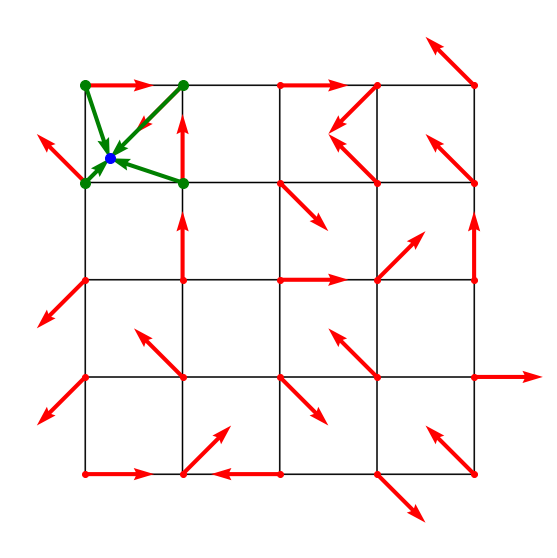

In [33]:
plt.figure(figsize=(10,10))
split = 4
hue = 234
m = np.zeros((int(pix*1.4), int(pix*1.4))) + hue

reloc = int(pix*0.2)
first_quad = []
for i in range(pix+1):
    for j in range(pix+1):
        if i % (pix/split) == 0 or j % (pix/split) == 0:
            m[i+reloc][j+reloc] = abs(255-hue)
            if i % (pix/split) == 0 and j % (pix/split) == 0:
                plt.scatter(i+reloc, j+reloc, marker="o", color = "red")
                x, y = i+reloc, j+reloc
                u, v = random_vector()
                plt.quiver(x, y, u, v, angles = "xy", scale_units = "xy", scale = 1/pix*split*2, color = "red")
                if i <= pix/split and  j <= pix/split:
                    first_quad.append((x, y, u, v))
                    plt.scatter(i+reloc, j+reloc, marker="o", color = "green", s=100)

xf, yf = pix/split*0.25+reloc, pix/split*0.75+reloc
for z in first_quad:
    xz, yz, uz, vz = z
    plt.quiver(xz, yz, xf-xz, yf-yz, angles = "xy", scale_units = "xy", scale = 1, color = "green", linewidths=1) 
plt.scatter(xf, yf, marker="o", color = "blue", s=100)
plt.imshow(m, cmap = "gray")
plt.axis("off")
plt.show()

On this lattice grid, you can see the gradient vectors in Red. The red dots are our integer points in our grid from which the value is taken, which are also their start points.

In order to calculate the value of a given point in our matrix (the Blue dot), first we need to take the gradient vectors (in Red) from the quadrant in which our point is located and the vectors pointing toward it (in Green) from the quadrant endpoints.

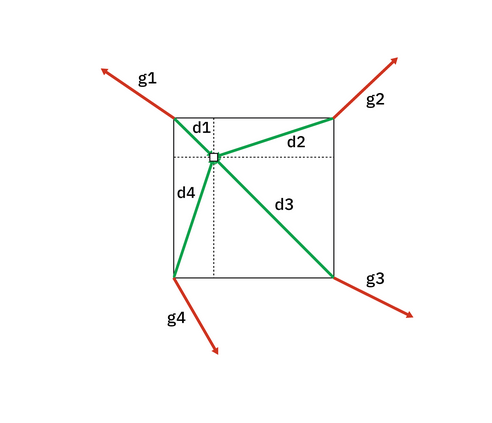

In [34]:
base64_data = "iVBORw0KGgoAAAANSUhEUgAAAewAAAGnCAIAAAD61/OYAAAAAXNSR0IArs4c6QAAAARnQU1BAACxjwv8YQUAAAAJcEhZcwAADsMAAA7DAcdvqGQAAGYeSURBVHhe7Z0HYFTF2oZDUVBq6L1IL6E3FRNCR5qKINKUX5EiSLmiWEC6gCDSJQm9hSpI71VKsin0khBCQgIhlJCeTTb535nv7MmShJAOu+d7Ls6dnZlT9uzMk29nT7FKYBiGYcwWljjDMIwZwxJnGIYxY1jiDMMwZgxLnGEYxoxhiTMMw5gxLHGGYRgzhiXOMAxjxrDEGYZhzBiWOMMwjBnDEmcYhjFjWOIMwzBmDEucYRjGjGGJMwzDmDEscYZhGDOGJc4wDGPGsMQZhmHMGJY4wzCMGcMSZxiGMWNY4gzDMGYMS5xhGMaMYYkzDMOYMSxxhmEYM4YlzjAMY8awxBmGYcwYljjDMIwZwxJnGIYxY1jiDMMwZgxLnGEYxoxhiTMMw5gxLHGGYRgzhiXOMAxjxrDEGYZhzBiWOMMwjBnDEmcYhjFjWOIMwzBmDEucYRjGjGGJMwzDmDEscYZhGDOGJc4wDGPGsMQZhmHMGJY4wzCMGcMSZxiGMWNY4gzDMGYMS5xhGMaMYYkzDMOYMSxxhmEYM4YlzjAMY8awxBmGYcwYljjDMIwZwxJnGIYxY1jiDMMwZgxLnGEYxoxhiTMMw5gxLHGGYV5f4uPjKVUzsphJhCXOMMzrBSlbwWCIj42Nj4tTy6kNo8ISZxjm1UOCVjDExccp4lZBsZJjnoclzjDMawo8HnXHO3jHxqD1TiIklyh1jBGWOMMwrx4SNIh9FhJ+9WLw9g13fv7u6idtPd6tca50rrtTxqONITYWDag9o8ISZxjm1QM7G+LikIZfdNPZlHGpVti1VjG3+mXcm1Vxa1A2VHdOtIiLVVozJrDEGYZ5LUCMjVgbmScH/3VrWN6jZTWPFtXcGpS73LlFXGSEsLycUaHGjApLnGGYVwm8TGoWs94GAzL+86bqbMp6tHjHo2V111rWPhO+FbVxPJeSMixxhmFeGYkGj4sTEo+L8504xqV6Efemld1syro1quBas+jjvTtEI54QfwEscYZhXg1CzarBZeo95v9cqhf2aFnNtaZ10HqnoI0rEJLHBN1HM4PhuTMOGRWWOMMwrwDV4OL3zISEuLBQr28Hwt0eLarp6pYI3rGRmj09ss8Qq0dGbc8kgSXOMExOI3RsNDjSuPCwG4N6uNYs6tG8qq5+meB/NokqvZ6myJnUYYmnCQoBRCQQG6v8k1eUKRN5RqgxwzCpoI4WOhdFHxx0vX9XXZ0S4mzCRhWenjiEQmFwKXoxxIyjTyzMJIMlnla4DzFM5pHjSAwlMnhM0P0r3Vvr6pR0b1rJvWnlkFNHRBUZXNU9SzxVWOJpgr7WxT594j9nUuDy+Q+dVz85sOvZ2ZPhl9wjvW/EPnuqdjWGYV6EGCNynNA0d9Qd7yvd3tfVL40A3OO9WmEX3VCIKhpKPKDSCEs8TYirDPC1Ljb2et/O58vlda1d3LWmtVv90rp6pTzfr42+iA4n7tqTs91O7esq6ktZzzCvEaJbyq6JQBsvI29dv2hnI88jLO/Zuk74ZQ8UssEzAEs8TaBL0be/UNez6HYerap7tKgmToSqU+LxgV0oN8RE53DnUzcXJycNCbWcYV4r1M5JMTi+wl5sY+PWsLybTZlLnZojDEKhMLhoy304fbDE0wo6lgjGExJuffOZrk4JeTlZNffGFb1GDqIuSD9yKi2zuhfSOgG+E8DaSKkQeWpgCsqVHMO8BlCHFL1XxuChLv+5N6uCsaOrX/pyl5bRfndQKG5uRY2496YTlniaEB3LGIyHnDziWrs4DK6rVcy9UQVd3ZIerWoEb99ALUUbY5fNZHekNRCwNqHUyVq9HBLLli2zsbFp2rTp7Nmz8TKWL2xjXieoN4o+LGPwkNPHPJpXdW9aGZHQtT4dYoKDUEgji3q8yDDpgSWeVkT/kvd2QPR7vX9X1+pF/GdNvNyxmStU3qwKUu9RX0QH+IuWWRSS07IQt2m4fefOnWPHjvn6+pLQt2zZYmVlVa1aNaSDBw9GCcxu6nqGeYVQH0ZKBn98YJdO3pjQtU6J6593iX36GIUUg4uhwgbPECzxtEKdjEKGR3u23x73NTIx9wO8x/yfay1r9EtEFhft6j3es102NwYXGe2dtIi6YFBQkI+Pj5+fX5UqVeDr8ePHo2r79u3I29vbe3l55c6de/jw4WjJkTjzmqD2YTL4o12b3WzKeLR4x7Wm9a2hn8dFhItaClDQiDttRmGJpw/Z2cQlPyJ8MAbID7es9Xy/lq5eKXxJdK1d/Pb3Q/WPglEu2sRnPCSnue+AgICePXu+IcmfP//7779/6dKle/fuoQrlderUCQsLg9xhc5Y48/pAnRApRTNB6x0R63i0qOZas6jXiP6G6GhU0+WabPBMwhJPB0m7muihYnYF2Si/O7eG9nWtUdS9WVVdneKX2jd5cniPaIJ/Rtenq6eiMUkc1kaUjaDbzc1t7NixkLWzszMaoDYiIuLBgwfI37hxA+XDhg1DniXOvHKoB4rhIQ1+f9US+TNSddcaRe78PAo9Gw3i5Q2tRIa7a+ZgiacP6nDU8wDl1ZmToHUO4vY99Uu7N6mkq13cd+KY2GchKJcheeKCsu1LoHlwX19fNcQGEDTicXt7e8gdeSrECr29vTkSZ14TqPup8c29+TNcqxf2aFXdtXqRO7+OVqqMBkfKZBKWeKZAL0zssvLnxEjvmzcG9XStae3evCqij8sftgo5eVg0wD/Zp9VFUod+nESgDTt/+umnVPjkyRNE5R9//DHykLWqci8vL5Y488pR+7aqaf+5U/D11KNVDaT+86aKquw8E1ebsMSzAKXjGkPyeEP8faeFyl3tG1fQ1S3lN+tX+hkn7SE5aikYHzVqFAQ9ePDg2bNn16tXL1euXGfOnEEtyZpUfuvWLbQZNmwY8jExMfQHIPX1M0zWgv5GXU4YXP4UhLhb3By8VXWXGkXu/TVDVJkYHCmTJbDEs4bnerDspuFXPK/37STuj4yQvFaxKz1ah7r8JxrIrqwuIzIvABJHAx8fn5YtWzZo0KBatWqffPLJyZMn1SpqBmjW5dtvxVOsGCbnkX1Z9n/ZMw16/Z2fR8oYvDo6/4PVy1AlIhiOwbMBlniWoXZNpEpIHhsbsHiOW8Ny8l95pPfmTzdER6HqpSE5ommUR0VFWVtb//TTT0rp8yDoDgoKevTokU6ny5s371dfffX48eP79+9jKdSmuFqGyXJkFxadjR7vYIiO9hreTxi8ZTUYPGi9o6gy6fBiGSbrYIlnMaKPUmc1Bsthbuev9WorrglCSF7T+lrvDnSvn3hY+sUhOUpoyrtr166IsgsVKlS4cOECBQpUqFBh3LhxEDcabN26FVXJ2bx5M9ZA13MyTLYiuq7sverjHcRpWuIBPe/obMo8+nerqOLbWmUnLPGsBz1V7bIUkiP69p/zm66euOWmW4Nybo0rBiydizhdtHlBSI48nUT49ddfd+jQYejQoV9++eWQIUM6deoETQ8bNgwNrl69OmvWrNmzZyOdO3funDlzkAHXr1/HGmhmnGGyD9FjZaelfq5/8lhMIdYuLq59q1/m8X55bziTm4MjZbIclnh2ofZvEZLLu+A/O3vySvfWSkheo+iNgT0iblwRDYzT6FhE7egURy9atAjKTqJjBOPNmzdXXjDMK4J6OPqrYvDgoGt9OooH9DStjB4ecvooCtngOQBLPBtBx1V7MHV0fNm8O2W8rl4pBOM6m7IIWO6vXCLbJp0lp5NPduzYAYl/8MEHf/zxx7x58xB0d+7cGSXLli1DbUxMDFyfHD47hcluqHfhP+rY0f6+l7u0dKtfGh3bvVlV+g2fDZ4zsMSzHfRg6sSGOHmzzYSEkBOHLndqrs6S3xrSJ8rHS7REzG4SkpOL165d27ZtW0TfZcuWfeedd7p27bp1q5xnlL98AuQZJicRvU72PTJ41B3vS52a62zKuDUsf9HOJvySOwp5HjzHYInnBLLDKx1a+e75+NGdn0a64rtnk0q6eqU9WlZ76LxKtk0MyYGaScJLGzBMNkFdDv/RzcHDr3h4flBXPt6h7MU2NpG35O8x/HiHHIQlnnOIDk0DIE54HDw5uPtimwb0nG8E5l7fDoz280W5OFXLGJLHxsbSVT/qS5ppIaicYXIG6nJI6caE4Rd1nu/VEnfVr1/6Srf3n3tAD/fPnIIlnqPIji17uEG5N1DMg8Db//tG/KDftLKubknP1nUe7doi2yaG5LSUCpXIJgyTc6h9j2LwkFNH3JtWcW9SWVen5JXurdGTUSg6LTXiLppTsMRfAaJ/y16uhuTB/2zyfL82JC5uZlur2O2xX8UEySHx/Cy5bMswrwDqfkgpBn964rBbowruzcQDeq737xrzUNxN80UGlwVqjYJpOZMZWOKvBrX7wtF0yU/0vbveIwfR8yVca5e41LYRPYIZjVTXc49nXglKXzUaPHins65+GXE/iZrWNwb1iAsPQ+GLbg4uC0RJnIQK1bxay2QYlvgrI7H74v/k1AoI2rjCo1UNupktVO7z08jYkCcoF2e2GAcSZRgmZ1A7Hk0ABu/YiOhbPN5B/opjanDZNxMxmDzUm1Kg1+ujo6MprxaiMWWYDMASf8VQdxcZY0gedcf75tefutYoqtzMtlPzp8cOiAb494Jgh2GyCbVzksHvOy2Sj3eo5lK9sPeYr+SFbEq3lL1SAc2RiuUlJOtjx4516tSpUKFCBQoUQOboUXk1EJ8pm2lY4q8F1ImR0lBB5sHKJeIhQTZlxGVBdUrcnfZjXFgoqsS0o7ExZRgmO1A7mGrwQIe/5G2tqrvWtL7z65h4fDs0Rh5KS3n2FDJEcHCwp6fn3bt3Ub53714reQugcePGffXVV8jnzp1bp9OhiuZVmAzDEn9dQG8GIoOBISOXyJvXxGP1ledLFLvS/f1n/x0XDdCWQ3ImO5E9y9gbZWfznzNJ3NaqZXWXaoXvTp+gVMmOqrQ0dsWIiIiHDx+GhoY2btwYsv7yyy9R2Lt373z58vn4+FCblStXomrEiBHI640XdjIZgyX+GiHGjXE8KCF5bGzg33+6N6no1qCsmzgbt4z/3CmGqEhUcUjOZBNqj1I17TfzZ3q8g2utYvf+nCaqkl1dDJ49ezZkyJDChQvnz5/f2tq6adOm58+fv337NqoiIyPpvmzR0dGwNmLwXLly9ezZE8sieEcDVDEZgyX+2kGjQmQMxpvZeuqufdpeCclrWl/9uE2Y23mlJYfkTJYiu5LsftB0vAjDfSZ8SzG4a/Uigcvno8r0zFdKaUqkT58+iK+XLl16/Pjx0aNHI7969WqUw9pIAWQdExODDN3Z7ffff0eeI/FMwhJ/HRHDyDg8KCQ3xETfWzBTxOMNy4ub2TaqELBoNgaEqOKQnMki1C4kNI2XcXG3x33tUr2IR8tqurolEx/QI5++pnY2iqMfPXoEL9MDYAmE5E2aNEEtnaMCyOY+Pj4lJIGBgVRO7ZmMwRJ/fVFHlIyJRObZhdNXP7JV75x1vW/niGuXRAPxtVeEQuoiDJNe1M5DBlce71CrmEeLd1xrFw/evkFUpXRbK1gYL0NCQnLlytWhQwcqREnBggVbt26NPN0oggx++/btypUr586d+/Bh8QBx+iHUdG1MemGJv9agc1P/RkoheVxEuN/MX3R1S8nnS5R1b1o5cPlf9N2WQ3Imw4gOI/sMDI4UBr/xxUdiFqV5VbeG5R79K24F8aJby+IlTaeMGzcOwfiwYcOWLVvWpk0b5Ldv345amJoM7uLiUrRoUUToJ06cwEuaSCHEipgMwRI3A0QXp8EjQyQQcurI5Q9b0SNUXGsUvfnlx5FeN0QDA1+mz6QbtYNRoBDz8P71vp3oJhBuDcs/PXFIVKV6c3CaMHn06FHLli2rVq1aunRpW1tbumcyqkjxu3fvzpMnT506dby85I2XjevhjppJWOLmATo69XWkNNJiQ5/dmThGjLQmlcQ10C3eebB2uWzLITmTDkQPkb1EMXjQ/as9bcWdNZtU8mhZDeECClM3OArlzLahRo0aw4cPV0pNQANnZ+e8efO2bt363r17CMxDQ0MjJamslkkjLHFzQvR16vTG50s8ObL3UocmSkhe09prWL8o39uyAYfkzMuhHoX+QTdFibx9C9/w3OqXcWtU3uPdGuEX3VCYusEBymFwpB999JGVlVWZMmXKly9fqlQpOH38+PEIz9GmRYsWqMqfP3++fPmQQUgOChcuDKejFovLNTEZgSVuZmCoAMoY5I2x9MFBPuOHCY83raSrVwpj7+HWdbKtjK1SHX6MllE6kmpw75sX2zRwsynr1rAcMuGXPVAoDC7aptaFUEVzJhMmTGjevHnv3r1h8169en3wwQfw9aBBg9Bg3bp1v/76688///zjjz/+9NNPaAkmTZoUEhKCNbDEMwNL3CyRI0qOQPkVGDzeu+OibT1dHeVmtt6jB0cH+KFc3DmLQ3ImGdQZkELTyIS5X0D/QQCuq1/6UsemUb7i0koxL0eNUu05dIbJ1q1boWyKu1Xq1atXtWpV5QWTPbDEzRU5suQQQxgjfziKDvCHu11ryedL1CmBMQmzy7aq65VFGI2j9ByjwUN15zyaV3VvXFE+oOe9qLvpMDigMwj3798Pidvb2zs4ODg5OTk6On755ZcoQbiNWrpQEy2TQCt/6SaYVGCJmzdK78doNIbkwVvXebxbQ1evlAjJaxf3GT9Ur96w3zhglKUYTaJ2AzL40+MH3WFw2Vuu9W6vfxyMQuWh3mnrKmJV8tveqlWr3nvvvVKlShUpUqRs2bKtWrVaunQpTE0z5tSYyXJY4maPHGhyxGGoyJAc34W9hvdzrUnPlyh+qX2TJ0f2igb4R8+XMC7CaA2lq4i/+sLgTw7+q6tfhp5DcmNgN/0TMRmiBATp7CRqY2To2noVqkrX2pi0wxK3BDA81HGihuQP1i73aFFNDNEmlXR1Svr+OiY2VP6IxCG5VlE/d4rBg7et19mIk1Ndaxa99c1nhugoFNLUnOwaae0b1Bgg6KZTwgnkecIkB2CJWw5yHMkBYwzJI71v3Bz8sXi+RDP5fIkPW9Fpv2hEDWgZkWEsHaVvGP/MB21cIW9r9Y5rLWvvkYNgcFRnwOAELZIKSjsmG2CJWxTqgEFKYxVCD3T4S1x6ZyNvZlu3pN/Mn+MiwlHFIbl2UD5oQ+LjHXR1lAf03PlpJDVArZLhzmBWsMQtEHUcqlfhR1y7dL1vZ7oVhmutYld72oaeP620zGjwxZgF6ierfj+7t2CmuDm4fECP76Sx4mofVLHBzRaWuGWijkakFHwZYmICFs9W7mQr0rL3/pphkI+s5ZDcUlE/UNXgfrMmir/lrcTNwf3nTRVVfHGvmcMSt2TUYSkGqsyEup69+nEb9Wa21z5tF+bpqrTkkNyCoM9RgDwMLj/TOxPHuFQrpDyg568ZKOFrwSwAlriFow5OpBSSx0VF+v8xWVevtHIz28YVA5fNi48VV1frxdkEjKWATxOSjouFpA0x0T4/Dpe/ZIpZlAdr/0ZPMP0GhpQxU1jimkCMUhquxpvZPjtz/Er39xND8gFdY65fkTWMxREWfvPbAa7Vi4hTTuuUfLDOAWUpPt6BMUdY4loBY1UdtEpIHhbqO/l7Xd2SuiYVL9YofrhL/clr5owfNfabYUOH5xQ//PDD6NGjlRdMJhg6bNiQYd8gHT3yu5/GjJ/4w8/T//z9931/9z03d+FPn9yuUsy1WWV8/Xq8dzs+eja4JcES1xZi0NLoNYbkT48duNSp+c16ZTtNbWO1oFW3UX3mzpwzacrkqWDaNPyXHf+mTJ06ecqUadOnFytWrFevT6dPnz55MsqSNuN/L/2Ho/bblMn4tGbNmLVg1p9/zJg19IeRtQa2zj20Xu65ra0c7K2c2lj9bftnPxuvJpWD9/+DT1zcmJANbkGwxDUHhq46hpUTVx4GT/6um9Xq9kXW93hn98AL4eIhQTnDt99+6+4ublrNZJLIBP2u4LNfu8+zOfhNiV2fFd7+Sd51Xayc7PM5tm9yaJTN6DYHly5Cs9iYGPXTl8sxZg9LXKOIMSzOD1au/uj8aS+bPz7Ju77LG44d8zrYb7t5JCE+ITI6KsU7z6UO3QsJKK9j4Y3EO2koRUZSLGRSBJ9FjD4mKiY6Rq+X9yFOSIiLv/XoziKPzZ12j7Ve1c1q2QcIuq2W2yHzhmP7xtu++un8slP+bvHxsZ9/0nfeosX4vOlZl2xwS4Ilrl0wksXJZ+L0M0Ob1rZH9h8c7bbYalnrgmu65V/Z8Z/b8lG2cek4gQGiQXrhwgVbW9tdu3ZRCd1M48GDB76+voGBgaIdbVqu8Pz586iiElnDKNAhIuLwlcmgnCRK3Hziu/DSlk57/1dibQ8rR3srp7ZWTu2sHNu8vapz8x3fTHJxPBd4EX89ldYJCb379Fm8cCHWgE/EdD2MBcAS1zQYz7A4wjpbO7vDh8RtVb46OtPKwa7Amq7S48dRkorHUULIgD42MjISyt6zZ4+VldXCReLLe1SUuKfShg0bc0uaNWsmlxNPciHjN23adMsW8SR1eqlxlKNpRHG3Uim4+uj2PM+N7feMtV7T3ejutsi8varLuzuHT9WtdHlwJY5uVCnBZxct50/69OmzcOFClPBxtjxY4pqGZIFMmzZt9h04IPLxCSNPz7NysEU8nm9Fh/U3D6A2RY+LJeVLdf6E2L9/P3y93EGcxwb27RPPCujZ86N3qlWrXr06FWJBitAnTJhw9uxZZEzvfqdB6GASSd0dH385+NZs93X2u0cXXtPVxN1tCq3+8IN/R850W+MedB0fg9IepjaIqzCxKnw0NH/Sp89ni+SfVZa45cES1zRkDWTs7OwOHjyEPHyNl6rH8zq1W3djP0qSe5wyZPDAwMC58+YNHTr08OEjp0+fhrWXLFmKcrxEvmPHTjEx+rp165lKnDIaB8dBhdytVACDAWqe6bYamoasTePuIqu72u/+bo77uovBN5XJcYnqblPI2ixxC4YlrmlonCODSPzAgYPI6GP1cdLLo07/SR7PA4/fTNnjCJ8NhngfH5/KlatA1kWLFi1dpkyPHj2QX7R4MRqcP39+8OD/i4iIQP6dd6rVqFFDLifWQPb/559/bt8Wj+dPEs5bMOKIm5DE3Xjl8uDyNN3K93YOL7CqM8Jt1d1F13bvsHfsn54brz7yVlrLtSV3t1JHtSxxS4clrmnUMQ+JIxJHRnrZQB7/8dwSKwc7EY+vaLf6+h6UmHockBGGDRsGay9btgyLPn7ypH//AXj599/LUaWCxjVq1DSNxGnZhg0bOjs7I6MFuchjphBniDN1d2yc/tz9S5NcHFv8M/Qt4W7E3e3I3cXX9ui87/sFFzffeuKrtKYDiE/pBe5WQSFL3OJhiWsadfCrEqdBrnr8l/PLRDy+tlsuR/vlV8Rjl/UGxePKeS0GA+xcvnx5lBAnT54UEl8uJB4TE4MVUvvq1RGIJ43EDx486Ocnn8pvuZE43qxKEndHx0adDvD46fzfjbd/lW9Vp0R3O9mXXPdRt/0/LL28/fZTcXwIHPG0uFsFtSxxi4clrmlUC5hG4lQCq5JuyOOF1nZP9LiMx0m7oaGhRYoUqVOnDhaEIFC4d+9eEZj/LW6xpNfrUSI3Eg+JIxKnPC2LDFKLhN6mShJ3R+kjT9zTjT+3uMG2wflWdhTuXqG4u8z6T3oemOB0bZfvswCldfrdrYJmLHGLhyWuaVQdJJE4Faoe//XC33JeRXj87yvi5huIx0nE0dHRZcqUqVmzJuXhiCNHxI+ZqsQBCgFJnPI0aYOtLFmy5PLly2hJazN36NCpJHF3eEz4UT+X0Wf+qrf1izdXdjBxd9ty63v1OvjL6ut77oWKs+YJWDtj7lZBexxtZFjiFgxLXNOoXjCVuGk5eQSZmW6raX48t6P9wotyFtuAtqLK1tauQIECgYH3kQfr1q2Tpxg6Im+qjDp16iJgV14Yq5o2bbp582b1pZlCh4ugqBn6VurwZSU67ODdcyNOz6u9ecAbK1R3i7NNKmz49LPDkzbcPHA/7KHSGh9Bpt2tggVZ4hYPS1zTqIJIInGgVpGVkPndbQ08XmhtdytHu3ke61ESpY9Gm42bNiH0rl279oIFC3748cfatevg5YIF4tKSsLCwESO+7dv38379+ufN+0bevHn79x/wWd++27Ztx4LYFsLwx48f0+aQmhfiABlR3B2f+H3iWdSzPXdOf3NyTo3N/fOuaK+6O7dTu0ob+/Q/OmWL15Gg8EdK6yx1twrWwBK3eFjimkY1RXKJA7VWxuNi8M8SHrcttKY7bD5XejwmTh+fED9z5u8lSpSAu+3s2jg7O9evX3+TPOfk2bNnzZo1q1ChQsUKFepKKlWqhJd//bUAteYrFDoygL6pmLr7SeTTf26fGHx8RjXnz/PA3Yi4pbvzrGhXZdNnXx6fseP28eAI8XeLyA53q2BVLHGLhyWuaVRlpChxghogpXj8D4/1Vo5tCq7phpQ8HiuvD4qIiAwKCkImjdCG+vXrd+hQytt93ZCHSiG5u+Hlbd5HBx6dWnXTZ7nEGSbS3Y5wd3vYfMiJWf/6nHoSGaK0TnT3c6BczWQJWBVL3OJhiWsaVRmpSBxQG6R66fGFl7ZIj3dHOsXVCSXReuVeSwaJXGuikpKDNrAJMu3atdu5cydavrZyoR0mkrv7QXjwxlsH+h2ZXGljn1zy9BLV3TU39x9+au4+3/9Cop4prU3A2pDiaKsHHBkcFmRoW1SYSbAelrjFwxLXNKovUpc4oGZI6bp88ricV7Gd5CJ+w0Q5lpXrU6D2qYPgPTIyUl3/6wPtHpHc3QFhQatv7O1zeFL5DZ/S6SXyJoL2b6zoUGfLoO/OzD9491xYdLjSGuo0xOH44I/b7t27Fy9eHBkZhdWqhxpiVd1KHs8qsBVaM0vcgmGJaxrpqDRJHFBLpHo5P77o0lbh8bVifnyii7jdlYgk0xZLqg3Cw8P1r9MdrmnHCHI3zKvUJSTcfRaw8truXgd/LbP+E1N3v7myg83WL/93dtERvwuRMeIeA4RQP9Ygv3bEyLsJ2tvbW1lZPXwYTA10Ordu3boXLlzY2tq6d+/eV66Ix5yiPVpSg0yC9bDELR6WuKYRrpK+SIvEATVGSvMqjld35nFqK+bHHex+uSAu0RTOkhErtXwR5DVkXpPpFHEUjCR3t89TP4er//Q88FOpdR+JCROju/Ot7Nh4+1c/nFty4p5blF7cdJcgd2NVyNNfNQL5jz76KH/+/A8fihMKz58//9Zbb+XLn/+bb4Z+/MknkHv58uUfPHiABVP/FNIOVsUSt3hY4ppGSCs9EgfUHinF46uu7zZ63Hbsf+Kck7TE4yinDY0bN+7MmTPIZJW20gXtIUHuRkapS0jwenp36eVtXfePf/7BC/ZvrerUfMc3P59f9l+Ap97kwQuquwWyhI4DYnAXF1cPD0/kP/744zx58tAvwD/88CMkfvmyiL7B/77/Hh5fsXIl8lmlWuwIS9ziYYlrGlU4aZc4oEWQ0vz4qut7cju1lfMqtmOSeRzp64Z4z0boLBFklLqEhOuPby+6tKXj3nHW4ox41d1tCqzq3HLnsIkujufvXzKYPHjhOXebQEfS3d29Th1x4jwYOGhQt27d8r7xRnCwOD0ccr9z5w4yUVHiMXibnJ1z5849a9YsLEtTTJkHq2KJWzwscU0jbZNuiQNaCinF46uv78nr1I7iccXj4gyUF8bjauGtW7eePn1KJbImu6AtqijuVipRnXDlkdc8z01td48ukvjgBRF3F1z94fu7RkzVrdQFXYs3uQ5TuBvhuwlKhUT+FTNA0/Xq14e+Z8+ec+LEiV9++aVw4cJFra2DgsR0Ci2CA45myAwdOhQtjx49hjxH4kzaYYlrGikfoZL0ShzQgkgpHt/qdST/ig4F5Pz4yNPzUJGKx1FONmnZsuXWrVuRySa50KZVyN1KHTAYLgXfmuW+zva5By+IuLvI6q62/46a6bZGPnghcedTd7cKHUadmxu8PHzECCoE7du3f8MYiaMNIIMfPHgQLTt36SLPMxTI5pkFu8cSt3hY4ppG1VAGJA5oWaTk8e3eR/OtaC89bvvNiVkJCFxf4HHkqXzOnDnu7u7IZJW2VGiLRBJ3Y7/cg67P0K16b+dwBNqmcbf1mm72u7+b67Hh6iMv9aE5+P/k7gZKdUrAlWiwZcvWXLlyLVy4EC/Dw8NxbHv27JknT55Hj8QVm3hJ0yb79u2DwRs3bhL86BGWQnnqK087WA9L3OJhiWsaDHLyRcYkDmhxpMk8bic9nlo8nuXQJlTinr+JYFxcrMuDK7+5OLX4Z2jBVV0QbluJC+LFgxes1/Zov2fsgoubbzz2UVrLtaUx7k4O7IzGmzY5Q+ILFizAUaWnSPfo0SNv3rwkcfLpihUrYfA29vYwOA6UOhue9m2lAlbCErd4WOKaRmgpcxIHtAak5PF/bh8vsLLT26u7wuNDTvyOuBcWVDwuN0iNqcTR0fHq1avI0MsMI9ZrJIm79XEx5wIv/nz+76Y7hrxNDzwjdzspD81Zcnmbt8mDF7AGLG7IkLtVyJVnz56DoCdM+IkKgfhhM29emk4Bv//+OxqMGTOWXmY52HOWuMXDEtc0qqEyI3FAK0FKHj/ge7bgqs7C4452A49OiY3Tw4hxisdFMyibbGJjY7Np0yZkMiAXsesmJHF3tD7qVID7+HOLG23/v/z00BzF3W1Lrvuo+/4fHa7u9AnxV1rjr0hWuFsFbxCLh4WFlStfvlChQrt377l3L2Dt2rVFi1oXtbYOvC9u2/vH3LkwuL192+MnTu7ff2Dfvv1I4X3aNKBVZQashCVu8bDENY0qi0xKHNB6kJLHD6oed7Drd/i3OHnROTwr24mNUui9fv36mzdvIpP2SFwsbEISd0fpI4/6uYz9b0Gyh+a0Lb3+448P/rz6+p67WfHQnNTBSuhI7tmzp0CBApA1aNeuXevWra1y5bovJf5Jr15UbkqdOnWxLI5G2g9IKmBVLHGLhyWuaYSxskjigFaFVPH4XfL4h+RxxOOoEh43Qu3TCBqbAvOaujs8JvzQ3XOjTv9Zf+sXSR68UG59rz6HJ627sS9rH5rzUrBCEvHdu3cRgzs7O+PY+vn5ubq60sS3r6+vTuJuAv1Jy6r9wUpY4hYPS1zTqLLIEokDWhtS8vhRfxfrNd3ekh7//PCkmNhoVIuT6OINaIBmkydPdnFxQcsXbVfsnxGKmk3/DDyLCt3re2bEqbm1tww0ffAC3F1xQ+9+R6dsvHUwMCzxBrl0mkq2uptQV5uBgDoLdwmrYolbPCxxTSMclqUSB7RCpOTxUwHu0uPibJDu+3+M1EeiChKlNq1bt96+XTzlB3KhckBVKhQ1w78oJ55Ghuz0OfHNyTnVnfuJBy8Y3Z3LSTx44Ytj03PgoTkvRdmMjMfx7pQ3aMA7Uc4gpHwSSPpyuSzYQ6wE20WGJW7BsMQ1jSqLLJQ4oHUifd7jH8LjXfeN18fGGOJiZ7g4hUWH+/n5PXv2DOYi5NJyrxJScHdwxJPt3sf+7/jMqpv65naSEbd0N/LVNn3+1fHfd9w+9jhSXP9JvBJ3v1bg/bLELR6WuKZRvZa1Ege0WqTk8dMBHsXWdM+3qrOVg22vIxMHnpputdL2VljiiX3Es+jQWIStYs4k0d0PwoMRWQ88Oq1ySg9eGHpyzr8+J00fvGB093ModRoDb5wlbvGwxDWNKrgslzigNSMlj7s8uFJm3cf5V3d5a2mHN/6wzTOj5cLT67/58uv1G9bfvn3b29vb9aZnm39GPIx8IpdOCAwL2njzwOdHJhsfvKC4O6988MLwU3P3+54NjQ6jxgDiZncnAUeAJW7xsMQ1jWq67JA4oJUjjZEe97h/rejmnqU71a5ZrUbTFs0aN21arVr1+jYNmjdv0axZ8yIlrK2mNV1+c+dWr6OfHPy5zPpepu5+c2WH+lu/HHVm/mG/8xHPP3gB/+T7SESp0zw4FCxxi4clrmkwyGkmGhLft28/DA5QgqFO5ZQnLaKK8gAZvKQ1JGlM+SSN9Xr948inAw5PybOxc+7GxVctdYrVx0ZERGJjMTH66OiYyIjIOvXr5ZrSssDGblZ/t1Guq1xum9exfcNtg/93duGRu+cjohV3x8cZYmL1cWLWRWwFW8RW1F0FGdtV0zw1TteCQC6XuCA1Ns2broQao1bNq40pb9qY8mpj0zw1TnFBHHa6wVbv3n1Y4pYKS1zTkAKQsbOz+++/s8hk+SCn9QO3B1c77RnX6uy4t98tu85xNUrIO4QhzlC/UQOrKS0LbepZYEP3wuu7N97+1e/XN1yJ9I2JjVYaybhbyZmsmXkpn3/eb+HChciwxC0PlrimgQcparO3t//111/PnDkDsV67dm3r1q13795FuaurK/KPH4sbNu3atQv5yMjIqKgoZI4fP47CR48eIU/nent6eiJP90LBqpB/9kz83njo0CHkEwwJcWHRKzesrtukvpOjEzZNd4nCDiBFYF6vgY3V5BYFt37UaH6fna4HYuP0pw8eP7L3UEJ8QmR01OatWw4ePIiWvr6+WNt///2HNWNbyPv5iR9IsQ/IP3nyBG1oV7GftKsnTpxAg+DgYOTxjpD38PBAHu8U+dOnTyMfGhqKPDaxbds2HISQkBAU7tu3D4WBgYHIX7p0CXkvLy/kb9++jfyxY8eQf/BAXEO0e/fuf//9F5tG5ItCvGUU3rlzB/mzZ8VfxytXriDv7y8u9L9w4QLyT58+xXvfuXMn8thPHFhkTp48iQYPHz5EXqfTIe/u7o789evXkT916hTytKsHDhzYvn071oD1oHD//v0oDAgIQP7y5cvI37p1a8uWLd7e3sh37Nhp8eLFyLDELQ+WuKYhhyLTvn37li1bTZ06FSWbN2/u1q0biW/BggXI02WE/fv3Rx7WhjWQmTBhAgohF+Tnz5+PvKOjI/J0LxSsCnnoFSscNWpUjx494KnbPrc/6tGzQvkKq1eLSJyEggYir4+t37BBnsmtcm/rWn6s7fULF1E4YNDAzz7vC6WGhYX17Nlz5MiRaAx1Ys0zZsxAA2wLeagNeewD8pAs3lG/fv2Qh9ABMj///DMaQNnI4x0hv3z5cuTxTpGfPHky8qRXbAIbwl8X/KlA4ZAhQ1AI7yO/atUq5GFq5CFQ5H/44QfkIVnkBw0aNGDAAOweDIs3+91336HwyJEjaDBz5kzkN2zYgDz97Zk3bx7y+EuAt9a3b9/u3bvjkOLAonDixIloAOMjTxMgy5YtQx5qRn7SpEnIw9TIjxgx4uOPP8Yx9PHxQeGwYcNQiD8PyK9duxZ5/HlAHn+WkG/evMWSJUuQYYlbHixxTQPpAGTs7OzOnj2HTPYNcmyI/mB83r8fTIoNQetIYUyk0VHRiMSb/9W7x+EfB56YEhUvng1PCzKZh6dTLBiWuKZRxfqiHzbxEnnyKTKUB8igitag5l+0IOVRLn5n08d8/OknK1eLqDYJDZo2zjWl5dsbuv7832J9nB77QX6XG0y6lVS2SI1N89TYNE+NX7SrcjllJSg03UqKW0ReNE22RWpsmk+yIDU2zVNj0zw1Tr7FJCuhxqZbQSoOOP+waemwxDUNKQCZbDrF0BRsCE5B5ove/f+v3xc7nbdvXeu8Y8PWLeuct2/Ysm3t5splKlhNatz/9PRnMeFxBvG3RN09JmPg6JG1+RRDC4YlrmlUS2a3xLEVWDneEH8y0K3GKLtC71Uu8G7Ft1uWz9eibKn3qxVuVemtluWLt6uZf4H9hwd/oEt4xI2u6K617PGMgkPHErd4WOKaRlVkDkic7mGy4ca+tgfGlPmnb5Htn1jv+PSNLd3sjoxucmBY7s1drLd+nG9NFysHuw92fftUXkZPJxSqzwNi0guOG0vc4mGJaxphxxyRuCBezNJS9oN/Rlg5tC28qmuRtd0rbuzdfMvgzw9Pdg28XG1T37wrO1o5tf1g10jyuBKPy12lZZm0g4PGErd4WOKaRjo8hyJxbIausbzyyLvomu5WDm16Hv+la58e/+f4436/M5ExkWh247FPtU2fvbGyk9HjISgU8TjPq2QIHDGWuMXDEtc0qhlz6IdNeQeVuZ4bxVX1DnZLr+84sufgfd97sjqBam8+ufPOps/eNHr8ifS4iMdFE2VvmTSCw8USt3hY4ppGSDGnInED/TPEtd09GoK2Xtv9+iMfqhW/ecp9IY9fDr5Vbv0n4r61wuPfJnqc4/F0gmPFErd4WOKaRnViDkTiMDU2iEDbek13Kyf7tv+OxqbHjBlz+vRpZGi7yJDHPR/eLK96/N+RieeroI3ca2SYl4IDxRK3eFjimkboMPslTluBnbGlBRc3i6epOdrPc98AHTdt3owuKIdcaE+oJTKmHu+0d1y4vP2s0eOiGTJM6uAoscQtHpa4psEgJxtmt8QNyqU7ho57xiEMRzB+47EPZOzh6fHokXgYJu2Gmib1uKN9pz3jwmLCUcjzKmkHh4glbvGwxDWNqsLsnk6RcykJNx/fsV7b3cqxbYc9Y4XYU7Iw7Q9S8vjF4JvlN/Qij+MPQLjqcbSRu48M8yJwfFjiFg9LXNMIC2a/xLEJmkv5yziXMv+iM16ivE+fPnRHQNPt0i6JpQyKxyusT/Q4x+NpBweHJW7xsMQ1jSrB7JO43IIyl9JBzKW0LbKm29VH3lTRr18/uvV2ku2iilJjPH4LHn+TPL53bKLH0UauCBkmOTgyLHGLhyWuaYT/slnigGwrzktZ2x0St989mqbI1Qs4U4R2DGmixzdIjzshHk/icaUxkwQcFpa4xcMS1zQY5KS/bI3ExVxKfPxfF53FU4+d7P/w2IByKgwJCYmOFk9fo91IAhXSGpAhj8vzVew7mHqc51VeAI4JS9ziYYlrGtV92SRxWr8h3oBc573/M86l3MbLmFhxW9qOHTvu2rULmRfJhXYPKXn8kupxx+c9jjZya8gwKjggLHGLhyWuaYT2slPigM5L8X56t/jansa5lDiDvLoHmx49ejQ9XC2V7dIeIjX1eH6jx0NN4nG1MUPgaLDELR6WuKbBICfrZYfEaeU0bbL40lYxl+JoP9djI6qoEFDLl0ItkZLHPR7eKLm2Z/5VXRSPm95/XG5WLMOwxLUBS1zTCOFlp8QN4ibi4syUzvu+h8SVuZSEeAiXftXct2+fr68vMqn/yAloP/F/5PELDy6rHm+/Z0x4TASqjfMqxsaaB8eBJW7xsMQ1DQY5+S6bplNoLsVLzKX0gMQTz0uJF4+CRFXDhg2dnZ2RSYtcaFeRGj1+pZTi8TY99v8YrY9CPcfjpuAgsMQtHpa4phGqyzaJY81i2iQhQcylyGt8ZrmvQznNpVDoPWfOHHd3d2ReGokTtLe0ZmRcHlxR4/GP9k+Ijo1GtTEeRyutexxHgCVu8bDENY3wXPZIHKuVEbdwaed94ryUwqu7Xgq+hXKSbIahHUaqerzUOiUe/2j/j1GxifG42liz4O2zxC0elrimwSAnzWVHJK7OpRQTcyltbf8dBbdic3JCRYnEnZycrl69ikwaI3GC9hmp0eNXS637iDze8wDPqySC984St3hY4ppGGO7FEldrKQMoLytTgxrTtMmSy9tTnEshmzRu3Hjz5s3IpFcuWAmlJvE4edy+p2k8jjZyd8Qy2gNvnCVu8bDENY3QmxRc6hJHIQY/5dVCylBYTS+REsYKcY1P1/0/WDnZF17T9bLJXIpoINu7uroGBQVRiVgyPdAiSFOIx+FxxOPi24Cm43G8a5a4xcMS1zTCbdJu6ZpOoUVSnwChuRSfEP8S6z6ycmpr9+8ousaHoDaZh1aFlDzu+iKPo418r2IZLYG3zBK3eFjimkaI7cUSRxWZ+scff/z66yF6Of6pPaWRkZEp3vwEeZo2WXZlR/K5FGpAG5o2bRqCcWTS8scjRdQVqh4vnejxH4THjfMq1IwyGgHvlyVu8bDENQ0GOXlNlTgGORXCqjES5GvVqvXWW29Hx8SgAbSOKhR6eXlXqly5ePHif/75Jy2IFIiFTedSHJ+bS0GKNqin9u+99962bduQyYxcaJ1IyeM68vhq4fEewuORqNbmvAreLB1YlrgFwxLXNEJpz0ucIuIkUyXNmzcvX75CjF6Pxqp/u3XvkT9/fisrqylTpuClXi9uaEWYzKWI+6W03vUt6VuYXSI3K7YbEBAQHi5ufkIvMwwtjlSNx0us7f5Wosc1+jsn3ilL3OJhiWsa4TNpNNNInAyu07nNmTPH0dERwfi7775bqlRpSBzlJOvtO3ZA38uXO+TKlWvq1Km0IFKAFT4/l9JmuttqlFMhoDaUiY6Opj8b9DIz0BqQksfPBHgUW9PtrdUfkscjEY/Tz6pk8UxvzizA22SJWzwscU2j6kyVOJSNdMGCBXA0eOPNN9u1a1+/fv2y5cpFR4upFTg3MjKyZMmSI7791s/PD22mT5+ORcgOaCCv8RFzKR/uG48wvODqDz0f3hALGiemAa0Hme7du+/duxcZeplJ6L0gTe7xXgd/jo3TY9+UeFwilrFo8B5Z4hYPS1zTqC5TJY6X/v7+cHeNGjXc3N2fPg1Zv379W2+99c471aKioilInzDhpzfffDP0WeiVK1ch8RnTpmEpdTqF2twJuVdSnpci5lLiYqXZlW0BZMjaPXr0yEKJA2UTJh4vvqZbfunxzw5PNHpc7KHcHQv3ON4gS9ziYYlrGlVkqsTBli1boeblDg7IU23Tpk1Lly4TGRWF/I0bN1A7b96fBkPc+fMXkJ86ZQrUQBJHe5o2cby2S957ts0MZS5FzIkD5KkZ5bNwOkWFVo2EPP5fIHm8i5Wj3WeHtOVxvDuWuMXDEtc0qsVMI/G5c+dCzVu2bIFeSbIkceQRZdvb27du3VouneBz5w5azjeenUJrixNzKQk9D0yAxAulNJcCqCUyWfXDZhJobUgVj6vxuEMbeFwfJ+eFNOBxvDWWuMXDEtc0qsJMJb548eJcuXJt27YNAz4yMhLibtGiRYkSJVHr4uICa3fo2HHc//43duy4/gMG4OV77703ffoMtEQDkvXdZwGl1n2szqVgnQY5m4IqAuskm7z77ruZP8UwRWhzSI3xuGfxNd1pXqWPZjyO98USt3hY4ppG9ZfpdMqhQ4eh5kmTfqOXoE6dOmXLloN5L1y4UL169TJlyhQtWtTa2rpw4cK5c+d+6623Gtg0CAsLw6r0ceI0RMerO+kan5lua7B4rPEaHxW8pFmU6dOnZ/Jin1Sgjcq9StHjYlez5HdOWhbHB1A+M2vLQrAbLHGLhyWuaTDISTeqxCFT6Lhq1arw+LRp0xEmf/nl4Lx581aoUDFKzomTbWkpT09P0UyeYqins8jleSk95FxKgVVd3IOuoRCipPY5j7Jdo8fPSo+/Ja/n7HPoV31sTPbNj2NtMKYKrZ9QWmQ/2BY2jQxL3IJhiWsa1SmqxOkUQ0Tc9evbQNDg14kTe/bs2aBBw5iYxMt5EHIivXr1arly5RYuWIA87ECFci5FnJfSaucwinbVa3xU1O26uLhk+AZYaYTWjNTU4xSP9z70a2xWzKvQUo8fP7537x79kaNDkQQqzNgmMga2xRK3eFjimkZISzrFNBIn1yBz/fr1wMBA5GF2hOHU2BS0RDnF4ACWROpwdSedlzJFtwLL0lwKQF4FC5JNMnwr2nRBW0eqely5ntPBDh5HPI6qzHicdn7AgAH58uWjIwZwWJydnb/55pthw4Zt3LiRfr/NYY9jQyxxi4clrmmksp6TOA1ycg1BoWXq0Hoo4hbnpTi2LbCqi5txLoXamCIay02sWLHi2rVryJhuMTvAFiklj58LvGi8DijR46phgVjmxVAbgMMF8JcMy/bu3RtfXPz8/NDA09Ozfv36eFmkSJECBQogU69ePV9fXzRLy/HMKmgPkWGJWzAscU1DJkLGVOJUCCgqV15IaBHTlECeItl7offLrP/EyqntuzuHxxrnUqjBK4d2Ayl5/Ji/S5HVXd5WPP5LTJrnx6kqeQNTiW/btq1QoULr1q1DPA7Ff//996hCSI4q+uIil8h2sCGWuMXDEtc0GOQkFNPpFFmTDmglNJey6vpuOZdiP8VVzKXoDaKQmpmCQgp7Z8+e7ebmhgy9zG5oZ2hvkTnmf6HIKulxB7s+hybSHc/T4nH62wYhrly5csCAAaNGjQoMDBw8eDBMHRAQQG0ePHiAlI7n7du38+bNa2trS0vlzJsFtDlkWOIWDEtc0whRZYnEDfIan4SETw7+AoOrcymxKc2lAFiMbNKwYUNnZ2dkckwu9H6RKh73o3i8q5Vjm4FHp5HHSbLifb3gLxCOEqDQu3jx4s2aNevQocP777+fO3duf39/tEnydqZNm4aW8+fPR54jcSZrYYlrGmGpTEscUPTq/0yZS3lv5/BYGYOLePUFHiRR7t+/39fXF5kcC04B7RJSk3mVD8X8uIOd0eP474UeJw+ePn0aXu7WrRudeYl3UbVq1Tx58tB0SkxMDN7RqlWrEH3b2NgULFgQHseqUJh8hdkHtsUSt3hY4ppGKCrTEhemkHMpK6/ttnJsi0h8sqsTymmChdq8btCOIU3qcUd4fGrq8TiF0jNmzMiVK9ehQ+Kg0Zkn/fv3V6dTIHG0WbZsWYMGDWrWrPnWW28NHz780aNHWCetNmfAPrDELR6WuKYRfsqcxLE4gku6X8onB3+2crJ/e1XnC/cvozyVa3xErdzQd999d+rUKWQy9g0gM9C+ISWPHzeJxwccnYqdh8dTjMdJ0CNHjoSyT5w4gTzdVYZmV+7du4cSiN70HTk4OKBq4MCByEOjpmvLVrAhlrjFwxLXNBjkJJTMROIUWvqH3i8j7pfSrvk/Q190jY8KFiGbdOzYcdeuXci8ErnQe0dq9Lhr0ec8Lu6gm9zjFImPHz8ekfiZM2ew54jEcdz69eunRuIECqOiouitlSxZsmjRohEREcjnWDCO/aSts8QtGJa4ppFqypTEhSbUuRR5jc9EF0eUx8owHFCzJKhVISEhdI3oi1pmN7RdpCnG48/Nq8i9RoY8uGbNGiibni9KdOjQgX7YRLOFCxeOHTtWqZBnp+TPn79y5cr0B4AlzmQhLHFNI7QkxZQxiYuFDUqs2vvQRGUu5cEVFKd4jc/rCR0BpGmMx6FgpA8ePEBknSdPntmzZ+/cufOHH34oUaIEtE5X9HTp0gV5aN3BwWHevHnQN14uXrwYK4FGsTgyOQA2xBK3eFjimkY4KRMSBxRUBoQFlVvfy8qpbQsxlyKmjIXdX6wqVNGGPv/8c/ptML3bzVpoV5GSx0+oHne06390SnKP094eO3asbt26sHPBggWnT58+YcKE6tWr379/H1X4evHTTz8VK1YMtaBGjRrLli1DORbE4sjkDNgWS9ziYYlrGmmkjEscy8J6SNfe2JfLSZyXMsk4l0JXelKz5KCKNvTZZ58dPHgQmVcrcUB7i9TU4wXE+eN2/Y8k9ThSZY4lPv7u3buhoaHI4y3QbAk1AFA5aumqH0AhPDJqg+wGG2KJWzwscU0jfCOFkgGJiyWTzqV0cZFzKTQhTs3MCNpnpOTxQ3fPvb2yU4E1Xa0c7PrB4+JJoYnnjyM1PVZJjps4CM/rEi/V9VNJDqDuBkvcgmGJaxoMcnJKxiLxJHMpzf/55qXnpRDqdj09PYODg6lE1rxiaDeQksf33jmjerz/0SnxBvx1wptWPE6I1/S9w8hLa3MMbI4lbvGwxDWNqpWMReI0l7Lmxl6aS/n5/N8oT/28FAJeI5u0aNFi69atyLw+cqE9R6p43PdMgVXweDd4fMjJWahI4nGxzOsKdo8lbvGwxDWNqqH0SpwWpLmFT+VcSv5Vnc4GXkShkHjCS9QmlpUbGjt27OnTp5FJ1zeA7Aa7R6lpPP62jMeHnJyNCnPxOPaNJW7xsMQ1jeqgDETiZLHAsKByG8RcStMdQ2Lortwvm0sxC+iwIDWNxxWPnzAbj2PHWOIWD0tc06gCSpfEaSm6xmfDzQNyLqXNzxfSOpcC0IAMeODAgbt37yJDL18r6F0gJY/v8/1PeHw1PG475MSshPik8+NimdcM7BVL3OJhiWsa1T7plrjxvJS+RyZbOdq/tarzOeNcCrVJHbiPbNKgQYMcvhVtuqCDg9TE452lxxGPm8H8OHaJJW7xsMQ1jaqe9E6nkMEfhAeX3/BpkrkUWmHqiJZyDbt27fLx8UGGXr6G0NtBmiwet/v6tY/HsT8scYuHJa5pVO+kNxJ/fi7F/pcLy1Eem7OXI+YY9KaQksf3w+MrO9N5h+Rx/Ol6PT2OnWGJWzwscU2jSiftEhcLGOdSPqO5lJWdzt43npeSNoWJdcg1rFy5MmcelJxJ6H0hTfT4KtXjv4t3o3pcHiGxzGsA9oQlbvGwxDWN8E06JQ7o/JP7YcHlN/S2cmrXaPtXUbFRWE/az0uB78gmjRs3fp3nxE2hA4XU6PGzBY0e/+r4769nPI7dYIlbPCxxTaPqJl2ReJLzUn48twTlaTwvhVBb6nS6oKAgKpE1rzW0k0jJ43vvnMm3skNBcR2QLTz+XDwuEcu8UrAPLHGLhyWuaVTXpFHiorU6l3L4NytH+/wrO50OcEdxGs9LMXfocCElj2/zPpZvxXMex8F5fTyOHWCJWzwscU2jiibtkTgZ6mHE44obe1s5tW28/ato41wKrSotoCVtaPDgwUePHkUmLdM4rwn0NpGSx7ebeHzk6XkoeX08jq2zxC0elrimUS2T9kgc5kK62etwbqd2iMR/PLcU5WIuRd7liZq9FDiObGJra7tjxw5kzEsu9E7paCBj4nG7MWfmo0Q8opM8Lo8xMq8EbJolbvGwxDWNEEyaJS6aGudS+h+dSnMpZwI8UJz281IIsSrZ3s/PLywsjEpkjdlAO4yUPL7D+zg8Tr9zjjkjntn2OsTj2C5L3OJhiWsa1S9pjMTJSg8jHlfa2MfKqW0TMZcSjTWk/bwUQt2uXq9XTSdrzAnaZ6SKx28LjxcUHrcd/Xp4HBtliVs8LHFNo8oljZH483MpbRLnUiTULC2gMW2oS5cuu3fvRib1Px6vLfSukZp6nO5b+zp4HFtkiVs8LHFNo5rlpRKnlsa5lClWjvb5VnY8cU+HwvTOpQCxKrmhESNGnDhxAhkzlTig94400eMrO8p5FdvvTr9ij2NzLHGLhyWuaVStpCUSpzmThxGP5FxKuwbbBkfqI7F4eudSLA86hkhVj+dfqcTjST0uDzkyOQO2xRK3eFjimkYYJW0SFzowiLkUZ69DueX9Uv53Vkoh/XMpQF3Ez8+PnjKc3jW8btD+IyWP/3P7RP7EeFyed/gqrgPChljiFg9LXNOoQkld4qKROC9FVA06Ng0Gf9NkLoXapAvojGzy/vvvb9++HRkLkAsdSaTPe1ycP654XGg8Rz2OrbDELR6WuKZRbfLSSJzmTB5FPqmyqa+VU1vTuRRaQ7rAIrShKVOmuLi4IJPKNI4ZQYcCqerxN1e0T9HjOQP2hCVu8bDENQ0GOUDmpZE4zaVs8z5K1/h8bzKXQm0Ygg4IUvL4plsH33BqV0h6fBQ8Lr+7CI/T7Hg2Hz2snyVu8bDENY3qkVQkLloYlGmTL45Np/NSTt5zQ3GGJS5WKQPSdevW3bhxA5mcjE+zGzomSI0ePwCPF1zT3Wq57dgzf6FE8bixZfaB9bPELR6WuKbBICePpB6Jm8ylfEZzKVH69N17NglQGNnExsZm06ZNyFiYXOioIlU8fpM8Ls5XUW/6SEePWmYTWDlL3OJhiWsaDHKSSOqR+PNzKW3G/LcA5RSGA2qWLrAUhaJOTk5Xr15FxpIicYKODFK9gTwu5lXovMNEjxvjcWqc5WC1LHGLhyWuaVR9vEji1MB4Xsp0Kyf7N1Z0OOLngsIMz6VoBzo+SCked7518I0V5HHbH88uRkksLJ6d8bj4mFjilg5LXNNgkJM+UonEKVp8FEFzKe3qbf0iIiYCS2V4LgWIxeVqZ8+e7ebmhozlReIEHV6kph6n+9b+eI48njivQo2zEKyQJW7xsMQ1jSqOVCJxevzxDu9jdF7KaONciggiMyodLEs2adWq1datW5GxYLnQUUKqevzNFe1pfvyHZB5HmoVghSxxi4clrmkwyEkcKUpc1BnvPfvVid/FNT4rOhz1z4K5FLFmubiXl1dISAiVyBrLhN4dUvL45luH3jT+zvmDMq+SLR7H2ljiFg9LXNNgkJM1XhSJk1meRIa8s+lzK6e29bZ+GZ7puRRtQscZaaLHlXjcNtHjWf07J9bDErd4WOKaRvXFiyJxirh33j6RZ8Xz56Wk5zk+ycGytKGxY8eeOXMGmSR/PCwSOmJITT1Ov3OOVy6eyuLfObEelrjFwxLXNBjk5IvkEhcVBgSH4uX/HZdzKSs7ZslcClDnxNu3b79z505kNCIXOm5IyeNbTOLx5B6nxpkBa2CJWzwscU2jmiLFSFzYJD5ezKU4i7mUOlsGhceEo3nm51LU7YaHh+v1eiqRNZYPvVOk5PG1N/bmcbQvtKa7icezbH4ca2CJWzwscU2DQU6mSDESp2t8/rl9XM6l2I+Ut8amMBxQs4yhriEoKCgiIoJKZI0moDeLlDy++vq/eZzsC60VHs/a3zmxOEvc4mGJaxoMctJEEomLUuO9ZwcfnwmDv7GiwyG/cyjO/FwKUKdT2rZtq6npFBU6hkgVj1/bDY/T+SqTXBxRYupxapwBsCBL3OJhiWsaVRDJI3EyyNOokGrKXMpAOZeSNeelYD20of79+x86lHQaRyPQkUdqjMd353FsSx6fmMzjSDMAFmSJWzwscU2DQU6CSB6J01zKbp/TeVe0t3JsM0o+9ldoJRPX+DBJoCOJNNHjTkaPX8gCj2MplrjFwxLXNBjkZAdTiYsigwH6wMshJ2crcyl3z6MYhdQ+k4hNyPVcvnz58ePHVCJrNAe9caQpeNzFASWmHqfGaQftWeIWD0tc06heSBKJkzVCop5Vd+5vcl5Kll3jo86JN2nSZPPmzchoVi7qR4CUPL7GxOO/JvM40rSD9ixxi4clrmmEP5JJXIx8GXH/e+d0HjGXYj/qzHxUUSEQS2YOrAQeR2bp0qUIxpGhl5qFjipSum8tPJ5X9fiFjMfjaMkSt3hY4ppGNUJyiSNPcyl5V7Q/cPcsFVJjJjugY4uU4vG11/eYeHw5Skw9jjQtiE+NJW7psMQ1DQY5GUGVeGycMAWKnoq5lH5WTu1qbh7wLDoUzbJqLgWItcnQ++DBg3fv3kVG45E4QZ8F0uQe/yVDHkczlrjFwxLXNBjkpINEiQOaS/E5Rdf4DD/1hyjPurkUoM6JN2jQwNnZGRmWC0FHGKnqcfmcZXEdUHKPU+NUQAM6sCxxC4YlrmlUEZhOp0ATyKhzKft9/xMukIVZBVZIoffOnTt9fHyQ4UhchT4RpORxp6u7rBzaFH6Bx5GmgvjgWOKWDktc02CQkwhMI3GUhEaH1do8wMqpLdJn0WFoIuZYXqYMJqugQ42UPL7k8jYrxzZ0XX664nFUscQtHpa4plEVoEo8Wh+Dkn2+/8lrfOyHn5qLQihDOjzLJI5V0bmMEyZMOHv2LDL0klGho42UzldZenm76vEZbqtRok9DPI4qlrjFwxLXNBjkpABV4jGxMUiHn/ojyVwKNcsq1DnxZs2abdmyBRmWSxLkJ6N6XPyFWyricbrfod1MtzUokfG40gZpclDOErd4WOKaRnjCKPEDBw+KEkP8M+NcSu3NA0Kjw1Cd5RPW6nYvXLjw4MEDKpE1zHPQYUFK8yqIx3M52hdM6vEXzqughCVu8bDENY068kUkfkBE4vEJ6lxKm2Ens/68FCa90JFHqs6rwOOF1nSzckzB40hNQQlL3OJhiWsaDHIa+WokDmguJc+K9v/eOSUskNVzKQArpEnwgQMHHj58GBmeE08FOv5IyePLruyQ8bg4f5zmx18UjyPPErd4WOKaRh3zdnZ2+w8cQOZpREhNOZdS3blfSNQz1JIdshaslqzdq1ev/fv3I8MSTx36mJDSvMqyKzSv8hKPI8MSt3hY4ppGHfBt7Oz27t+P/J7bp+i8lG9Ozka5CMOz4d6zcrNinQbjyillXoQ8YMqBSiEe16kef+5gIsMSt3hY4ppGiEEOeLs2bfYe2J8QnzDipHJeyu47p4UCsmEuBcjNitVGRkaSVrJjK5YHHSWkxng80ePTEz2eGI8DlrjFwxLXNDTOkbG1szt86EhcgqGWvPdsdef+IVHPUJ0dcykAG6X5k65du+7ZswcZnk5JI/R5IaV4/G/pcTrvcLpuFUqSeJwlbvGwxDUNjXNkWtt+8N+x0xdCruVxaPvcXIqxQdaCdZK1hw4devz4cWRY4mmHPhGkSjx+ebuVA10HZOpx0UY9H58lbsGwxDUNREBRGyR+7tiZny86Wf1tm3dF+z3ZOZfCZJ5Ej8t4fJ7nRhi8sPT4NJN4XDTQ6/GSJW7BsMQ1DQY5Sbytfdsdu/9peWAkYjo6LwWF2TSXAsR25QVEx44du3fvHjJZfj2RZYMDCChD13OaeNx2rsd6lMDvHIlrAZa4plFcEJ/QrcOH/3OcWnxrL6vltoOP/46quGybSwGqXBo3bqzxx7NlBvp0kBrj8U3wuJhXcbT/y3MTSuB3isR79+7zqiQuO5ECtq6iFEmUpkyGYIlrGowfEQLHJ3Rv36XWpC4FtvTM5WD/z+0TKKen3SvtshqsmSbBp06d6uLiggzPiWcM+oyQGuPxTVaObQqu7YZvVAsuCo/THc0QiS9cuBAvYU+k2Qo2B9QMQD7Fb1pUSA2YDMMS1zQYP2LmNCH+wx5d35z5/psbPqyyse+TyBBUZd9cCpO1kASRUjz+J3lcXJffhuLxuHhD7969szsSxw6oe0Ip/jBD08iQrMPDw1esWDFw4MCvvvpq3bp1YWFhKGSPZx6WuKaBqcUgi4vv9ePgN1Z0sHKy/z85lyJ+0hQV2TW01IG9YcOGmzdvIkMvmYxBnxTS5B6f67YOJZ/26bNwkRKJZ8fHinUSELeYK4mNNf1qhQ/3/PnzVatWtbKyKlWqVOHChZGxsbHx9/dHFX/0mYQlrmnEqEPEbUjovekHq5Xt8ji1+8cn2+dSAMYtxjkyjRo14sezZQn0eSGleZVEjy9rvebuwUGf9vtr/p/404njjDbUOKtQ15ZExyNGjKhcufIvv/yC/Jo1a4oVK7Zr1y7ko6Ojv/vuO3h87NixeKnX67N2f7QGS1zTYNRh/ITpIxts/yq3g32VDX0ehj3COI/RxyDNPjBuATKnTp1COEYlsobJLDiSkTHR+MP8h9t6GDyfY8fC2z4q+1nD9RvFfdv1UVFkTKSUyRKwKjL4kSNH+vfv36FDh8GDB9epU+fbb79dt24dbSg4OBgp9hDp5cuX8+bN27VrV1RhhzkYzwwscU0TJ6O2e6EPCzv3slplN8ptCZUzlsH6wKPW2z8psq6n1Yp261ZNjQ95ikIINT5O+aaFlDKZAWsgNS9ZsgTxdcuWLQcOHFihQoWSJUvSXBlqk2zl+++/R8uVK1cin7yWSRcscU0jftWMj38SF9XOod/Uz2tNGDXg6yHfDAHfZC9YP7YxdOjQXr16DRo0aOjQYdm+SY2B4/nVN0NGDxtZZVArKwfb6os6nmtU9kqHpvdXLol9Jn64Blmlcvo+FxERUbBgwRYtWlDh48ePc+fO3bFjR5olp3B70aJFUHz16tULFSo0f/58dVlahMkYLHFNg2GMEfz0+CHPRpV965bd2rzOjFmzf58xYyb+MebPtBnTHeYv/uXsqsVftLhepYhrk4qutYpd6tjs/orFsTIqF33AGAgLkWfIpzQZEhQUhOD6888/R57WU6JEiYYNGyIPj0PiyCxcuLB58+b16tUrUKDA8OHDIXosS4szGYYlrmkwfjC0ov3vetrWvdCk4tWmFROueSh1jAWhd3O9NaK/W4Oyunql3BpVcK1d7BKi8hWLElWeiagcvQiaxlLNmjUrUqTI2bNng4ODHR0d4fRff/0VDWBwNDCV9dKlS1GLbwzI83RKJmGJaxoMHoO8iVLQxhWuNa1dbcpe7N46JjxMHxOtj8ne3zaZnAOGlR93qMt/Xt8OSKZyk6g8QypHS5J4QEBAmTJlYOe8efMi7d27d2hoKAUK1BLNIiMj4fSYmJiCBQuWLVuWInQOxjMDS1zriDPFESXFxFzr08GtQTnXWtYP1jmg3ID4SI5PasaYI/j46BPE32r8o8JQ17NeIweSyt2h8lpS5U6LYp8+oQZGldPSL+8AaEOmHj9+/NChQ728vFxcXMLDw6lW/hGJmzlz5rhx46gEXLx4EaKvV68eFiSUCib9sMQ1DY1R+Br5Z2dP6OqWdG9SyfODujEPH5DcqY1sy5gr4hOU//CB4mOlQqHyb01UTlG508IMROVQMBpA1iVLlrSxsZk6deqsWbN+++03pBcuXEADxN3t2rVDbI508eLF06ZNQ0u8XLt2LWqxYOrrZ1KHJa555BAVv3AmJNweNwQe19Uu7jtlvKihYcwDzPyhD1kBKjdeTmmMyss9H5UvTIzKybC04At6AsoRayOzbNkyqDkJS5cuRVV0dPRPP/1E7gYNGzZcv17capH+AIi1MBmFJa51aAgZ5Jxm1B1vj+ZV3ZtWdmtYPuLqRVQY4HFjG8bcwedIkHfVCZYw3TnvkYOeU3n7JvcdTVSealROE+IuLi5Fixb977//9Hp9REQErP306dMqVarUqFFDXQotAwICnjxRVqvOolAtkzFY4oxxbMtJlXt/zXCtZa2rX/rW171FoRyfaEItGctAfLL4WPGfULlxgkWHqDyZysUEy0tUDmsjXbVqFULsFStWhEsiIyMvXLiQL1++bt26UZtYkzsrYHFSP6GUMhmCJc4oGMRvX4bYZyGXOjZzb1zRtVbxxwfEnS74F06LhOypAJ+qEyyIykclj8oXxD59TA2ST7CI3yUNBsTX8DU8/vbbb+fPn79AgQJ58uSxtbX19vZGM5pvQYYay0UV5FqZjMMSZwQ0mugXzke7NmPoujWqcKXre3HhYabBGmN5iA+epCz/ilNhqNt571FfkMqVkxGhcgeo3CQqR2PqN7QSiY+Pz4EDB3bs2HH48GHkqTBJGyZrYYkziYgRKZV9Y0A3N5uyrjWtA5fNE+Uy+ALUjLEw6MNVSBqVKypHVK4TUXljROV6NSqXKsdCIp/S6d4UdyNDbZjsgCXOKIgBLKIxEYyHubu42ZRxb1rZo2X16AA/Wa58HZZtGQtEfv4C6WP8LTf+7Imo/Lsv3BoaJ1hkVB74958x98XDUYH4G2+cIYGy4+TNUpAiT4UENWayHJY48xxitElf3/l5lK5OCfzz+WmkKJc/agHZirFklA8a/4mvZcaoPJnKPT+oe+/P6TH3A6iBMsGiLs7kFCxxJhEae+J0Q4MhOtDf892a7k0r6eqXxtdqUS5nzHl8agHpYSOmEyxC5V8qKm9SUVe7uFD5fFb5q4QlzjwHjT063fC+00LXmtZuNmWvD+gmvi9jMPOw1BLUF4DImU6wuF8wVblrreIXP6jr/+e0mMDnJljUFVAhk02wxJkUELOZcXFxkRFXur0nTk6oVSx4h3jkrjjdkIel9lA+dPxnMsES5maq8kquFJVD5epcOUflOQJLnEkKDTmaPHlyaLeudgn3xhUvtW8c+ywEYxJQG9mW0QrUKxQQlRsnWMLcXbxHD1ZU3riiUHlrEZVHq1E5qzybYYkzKSMGHMKuhIRbQ/vq6pdGMH5v/nRRzsG4tlE+ffz33ASLVHnjiuIeao0qiLny1nXuzZsaHehPDZQJFrkcQeVM5mGJMylAY4xuqBJ+9aJbw/LidMNmVSJv30KJPN2Qx6F2EZ+9RFG5MSqPuHrpzi/fuTetoqvznMoT58o5Ks8GWOJMytAwo9PG786YgK/JCLIQbYkqDEUegZqHeghQVG6MyiNuXBEqbwaVl1BV7j93SnRAkqhcgQqZDMMSZ1KGRhedbqh/9PCibT33JpXg8ZAzR0U5T6owRpSegP/k7+FUGHHjaqLKG8uTEUnl6gQLR+VZBEuceSE0uugXzqB1DuJ0w4blrvVqa4iJxlilXzgZBlBXAUaViz4DTKLyxAkW/3lTE6NyVnmmYYkzL4HCK4j72qft3BqWh8qDNq5AuQzGxdijZgwDVBebRuWRN6/d+XV0UpXPnRwd4EcNjCqnpQVUzqQFljiTGjScKBgPOX1UfDVuUumiXX19cBBGnUFOg/KQY0yREhaInOkEy82rpiqXJyPW9v8DKueoPFOwxJmXQCOKhqL3mMG6uiUx/O5OnyCq5C+cQDZkmESoY4AXq7yEe2MZlb8vVX7PGJXzz57phCXOvAQxkDAM5emGkT5e7k0ri+e3NaoQcf0ySuTphrINw6QE+oboHvjPdILllpxgaV418QwWofLfXjTBQoVMirDEmTRAI0lOqvjPm6Y8v21oX4wtDEseY0zqUPcBRpUbf/YUc+VjPJKqPPlcubIGKmSSwBJnXg6NHzH8DIbYp08udWjqJi+wfnJoN8r5dEMmjSj9BP97Liq/7jtxrHszReVirhwqnzMp+t5dapBkggVQOUOwxJk0QUOHfuEM3rFRPr+t/JXureMiwjEa+XRDJu1ID6cwweI7cYwywdJYUbnfnN8S58rlJQuqyqmQASxxJs1g6MhRhy+51/t9qDy/zeEv1HAwzqQL6i0gmcqv+04aq6pcnoxY++70CZHeN6iBonL1LwHDEmfSDg0buhA/VHdOV188v83z3ZrRgf6ynH/hZNKN7FPJVO51AypX5sqlyt2bVUVJpNd1aqDMldPCssuZZmQTDcESZ1KAhgRQn5dIhUqVnFTxmTACYwz/7vw6WpTL0w1RjTzDpB3RoyQi96KovEklkTarIlX+fFSudkssa8zLeq3AEmdeyItmuul0w2j/ux4tqiEYF89vc78gy2MxerQ2hJisAj1HdB78lyQq/22cEpUrKk8SlSsTLCKvSY+zxDWNGDQShNumETcgg1+7du3o0aM6nc60sUBOqgT+/adrLWs3mzI3BvWIl7ckVYcTw2QM6l/i/5JOsIx7LipvXuXOxDGRt65Rg6g73g/W/I2M6IRycSrXAixxzSHHiACahrj1ej1SpU7WIoXNURsQEFCkSBErK6vGjRurhbKVfH6bwRAXHnb5w1b0/LZH/24R5bEcjDOZRXZPgcgJlSv90xiVvyNmyRtXoKj8zi/fweD3/pp5oVL+8KsX0YzOoRKLawOWuLaQQ0N0blXHxJw5czp27LhkyRLUyqBcDINPP/0UEre2tm7WrBleCnHLZeU6lLsbPj6wCyPKrXHFSx2axoY+E0NOrplaMkxmoJ4mMqZRuffNu9N+9Hy/tlS5vMntuzU836sFp1/r3cEQLW6xqalOyBLXImTwW7duTZ8+fdSoUbNnz65WrVqbNm3mzp2L8ujoaKQHDx5EDL5p06bq1avXr1+fljIdFWJ4YbRgPV/31tUvI57ftvB3lNPphtSGYTKJ6GYSkTNReXSAn/+c3zzfryUeCNe0snuTSh4tq7tUKxywaDZqqROKpTQAS1xboFtTlL1jx4433nijbNmyLVq0QKZKlSoPHjxAOWrj4uJiYmIqVqzYqVMnlCASb9SoETKmEqeM+CUzPj78sodbg3IYSPieiy+2KKFfPgE1ZpjMo/Qo/CdUrkywQOV3p09wa1Teo1V1jxbVPFpWQ2yuTKoY21g8LHFtAREDOLpUqVK1a9fW6/UovHnzJoLuPn36oCoqKgolv/zyC0ru3LkDoUPiNCeOWjGKjMgxpZxueHfKeFf5/LbbY78WVXy6IZM9UKcjlRtixFfGwGVzL1R4UzzLu6a1rnbx8xXzXerQVP/kkXD983OGlgpLXFvQ+Sf379+HowcOHIg8BeYlSpRo0KCBGB5Gp0+cOBEvnz17Vrx4cUTi9PunGEBGNVNGmB2jKTjI84O64rSBeiWfnT0pyvkXTibbEL1QhhSQ9bXPOt0Y2N1r2Oc+Pwz3/XX0vb9m3PtzWpTvbWqjLGDRsMS1BZwLoPIqVaqUL1/e31/cj//IkSOw9vDhw5GHqVu3bt2kSRPZXFCyZEn6YRNgWcoQYpxgpMg/Aw9WLxPPb2tQ7lrv9gj11R+XGCZbkPGB+M73gmkT9EwlZ+mwxLUFejYMjvTixYuFChWCu0uXLo20RYsWgYGBKD927Bhetm3bdty4cWPGjBk9enT+/PnRZuzYsefOnaPFlXUZxwnMHm+IM0RHX/24DT2/7aHzKlGupR+XmJxH7VoIJERgLoUej14nOp4IIDTS91ji2gLdmiS+fPnyL7/8cvfu3atXr7506RLVQscnT560sbF55513IO4ykty5c8PjyGzYsAEL0vSLCkoABeMhJw/r6pRwa1LpYpsG+sfBGFd0QxWGyXLQ6yhNEbWBFmCJawsRNUsR58uXz97e/t9//923b9+OHTuQCQgIUBo9T9GiRRs0aED5JNMpKmLcSF97fTtAV6+Ua61ifjN/EeUcjDNMNsMS1xZStsK2ixYtsnqeQoUKweZoQD9gku71en21atVsbW2phAppVSpUQqcVRnpdd29SSZy327hixM1rYim5ueRLMQyTJbDEtQXNpdy4caNGjRrOzs5eXl7Xrl27efOmq6srnaBCbUjWRHBw8JMnT5QXElqVKVROkyr+f0xGJI543GtEf1EltyhbMQyT9bDEtUVMTAzS5cuXI/Q+ceIEFYLHjx8XK1YMETfyFIlTeRqh9gaDOCNF/+TRpXaN3ZuI66GfHNknynlShWGyDZa4tqApEX9/fwTd8HhFSaVKlfLkyVO1alUXFxeoln66JOcipUUoT4UpQrUUjD/ctl6cbtio/NWetoboKATjtAaGYbIclrjmIBFHR0cfPXp0/vz506dPX7hwIfKRkZFqLaUZAMoX8yexsdf7dnZrUNa1VrH7q5agnINxhskmWOLagjT6IpmmJeJOBVqQ7lnx7MJp+fy2Sp7v1Yp5ECDief6Fk2GyAZa4tiDPEnHy0WsE/eCporTOEGJ56XGf8cN0dUvqahf3/W2cKKcbqjAMk6WwxJmshDRNpxtG3b3j3vwd96aV3WzKhHm6ynKeVGGYLIYlzmQxpGmaVAlY8oc43dCmzM0vP1amyw3Kk20ZhskSWOJMtiCUjYA8LPRy5xZujSpC5Y/3bke5+IXTGLAzDJN5WOJM1iNCcelr5B/t3iYepty44qVOzWPDQ6Xc+XRDhskyWOJM9iCmVJT5k5uDP3GzKQOVByyegxo+3ZBhshCWOJMtkKZpZjzsos6tQVnx/LaW1aL87shyPt2QYbIGljiTjQiRS4/7/jZOV7u4rk7J299/I8rTf2U/wzApwhJnsgvStDjd0GCICbrv+X5t+fy20s8unJblPKnCMFkAS5zJRkjT9Avn/ZWL5fPbyl7v96FBr1dON2QYJnOwxJlsR/zCaYgzREVe7Wnr1kg+v23LWpTzL5wMk3lY4kz2QpamYPzpsQOudUq4N6l4qW1D/dPHkLvBwL9wMkymYIkzOYEweVwcVO01rJ/y/LbZk0Q5B+MMkzlY4ky2Q46mG6pE3Lzq3riieH5bk0qRXjdQwqcbMkxmYIkzOQEcLZCTKn6zJtLz27xHDhJVUu5oIRsyDJM+WOJMzqE8v+1x8EX7BojEXWuXeHr8oCjnG6owTEZhiTM5hAzFjc9v27xGnG7YsPzVj9sYYqLVuxsCaimXYBjm5bDEmRxCEbS8oYpBH3Pts45uDcpB5Q/W/I1yQ6w+8akRLHGGSTMscSbnoEhbeX7b2ZO6eqXcm1TybF0n5kEgNSBY4QyTdljiTM4iRC5ON0T29rghujolXGsVuzv1h7iIiIDFcyKuXxZNZC3DMGmBJc7kKCIWj1duqBLp4+XRqoZbowqerWpc7Wl7ofJbYe4uaEPz5gzDpAWWOPMKECqX+E7+HpG4e/Oqbg3LuTUsH37RTdRyJM4waYYlzuQ04rdNeV9Dnx+Ge7Sq7tHiHY9mVZDq6pcOY4kzTDphiTM5DUlcHxzk+9v/3BpVcK1dzKN5VY8W1VjiDJMBWOLMK0CdTom4fsX7uy91dUvqbMq4NeLpFIZJNyxxJqchgyNVf8B8euzAtU/bXaiUP8yDf9hkmPTBEmdeATC4onJ57Q8yBr3+/orFETevikKOxBkmzbDEmVeD4nH5j63NMBmGJc68ShSVU8Z42T2lDMOkBZY48+pJ9DhLnGHSCUucYRjGjGGJMwzDmDEscYZhGDOGJc4wDGPGsMQZhmHMGJY4wzCMGcMSZxiGMWNY4gzDMGYMS5xhGMaMYYkzDMOYMSxxhmEYM4YlzjAMY8awxBmGYcwYljjDMIwZwxJnGIYxY1jiDMMwZgxLnGEYxoxhiTMMw5gxLHGGYRgzhiXOMAxjxrDEGYZhzBiWOMMwjBnDEmcYhjFjWOIMwzBmDEucYRjGjGGJMwzDmDEscYZhGDOGJc4wDGPGsMQZhmHMGJY4wzCMGcMSZxiGMWNY4gzDMGYMS5xhGMaMYYkzDMOYMSxxhmEYM4YlzjAMY8awxBmGYcwYljjDMIwZwxJnGIYxY1jiDMMwZgxLnGEYxoxhiTMMw5gxLHGGYRgzhiXOMAxjxrDEGYZhzBiWOMMwjBnDEmcYhjFjWOIMwzBmDEucYRjGjGGJMwzDmDEscYZhGDOGJc4wDGPGsMQZhmHMGJY4wzCMGcMSZxiGMWNY4gzDMGYMS5xhGMaMYYkzDMOYMSxxhmEYM4YlzjAMY8awxBmGYcwYljjDMIwZwxJnGIYxY1jiDMMwZgxLnGEYxmxJSPh//rrlihHe2BQAAAAASUVORK5CYII="
display.Image(b64decode(base64_data))

Source: [Codelirium](https://codelirium.com/article/perlin-noise)

Then, we calculate the dot product for each pair with the same start point, which will give us the values to interpolate:
$$D1 = g1.d1$$
$$D2 = g2.d2$$
$$D3 = g3.d3$$
$$D4 = g4.d4$$

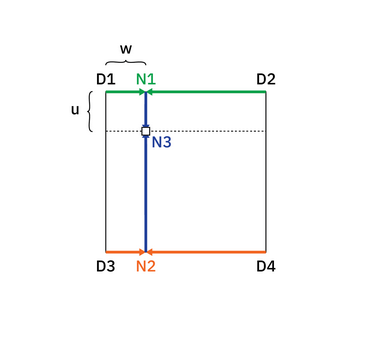

In [35]:
base64_data = "iVBORw0KGgoAAAANSUhEUgAAAYMAAAFqCAIAAAB3TaEPAAAAAXNSR0IArs4c6QAAAARnQU1BAACxjwv8YQUAAAAJcEhZcwAADsMAAA7DAcdvqGQAAC+USURBVHhe7Z0HfBRl3seDcMcpqBRFPUR8FfVQ4VWSUKWJtIPjBPGlc4AiRZQip3eC5aQIQmihhEBCkA7SIQhIJwQMLcQQivTQE1JJNrvZ8P5m/su4BoJOyO7DTX7fzzj855lnijPPfOf/zM5ufG4QQohqaCJCiHpoIkKIemgiQoh6aCJCiHpoIkKIemgiQoh6aCJCiHpoIkKIemgiQoh6aCJCiHpoIkKIemgiQoh6aCJCiHpoIkKIemgiQoh6aCJCiHpoIkKIemgiQoh6aCJCiHpoIkKIemgiQoh6aCJCiHpoIkKIemgiQoh6aCJCiHpoIkKIemgiQoh6aCJCiHpoIkKIemgiQoh6aCJCiHpoIkKIemgiQoh6aCJCiHpoIkKIemgiQoh6aCJCiHpoIkKIemgiQoh6aCJCiHpoIkKIemgiQoh6aCLPkqODwKEjMca3TmZnZ7vXJ6RQQRN5A0MuuUQjk8A1TUhhhSbyLC7T5OR8/PHHQ4cOlRKkPwMHDvz888+NCoMGDRo1ahQmnU4nJrUlCSlM0ESeBVpBzwtBixYtfHx8rl69ijgmJgYxOHv2LCbPnTuH+IMPPkBlu91OE5FCCE3kWQy5LFiwoEiRIhs2bEAcEBBQvHjxokWLhoWFYXLJkiWYFRERgVi0RUhhgybyOPIo+syZM0h8PvvsM8S1atV666236tSpg0QJk717937ggQfS09MRs3dGCic0kWeBViAX8cvzzz/fsGHDzMzMYsWKLVu2bNSoUSVLlkTGVLVq1UaNGqEynEUNkcIJTeRxoCHpoPXr169cuXJLly5Fv+zKlSt79uxBlrRmzZoSJUp88803qMCHRKTQQhN5HMhFXh2CdIoXL+7n5+fv749ydMcqVKiAnhpMtHfvXpRIP46QQghN5A2kd5aQkADpIA/6/PPPJffp0KEDJitWrIguG0qkmixCSKGCJvI4kIuAeNy4cX369ImLi5OS7du3YzIkJASzRENAX4iQwgVN5D1yWcZ9kgIihRyayBtoqY6Ow+Gw2+1If6RcHmbLR2aClBNS2KCJCCHqoYm8ipH4GA+nZUxIIYcm8h6GdHIFlBEhNFE+gT4EZDfy9Adjd4yS7F8jry9eu3bNZrMZFbASIBWAlKOmOyhBHdmo4NoVQv77oYnyg2EBWEMCs1SqVOmrr75yTZhBnIWAMiJWgiYyjVz/GIsRrl69OmfOnMGDB3fp0qVdu/bt2rVD0Ldv3yGffjp27NiwsLDVq1dv3bp1z+7dkZGRGzZsmDRpUp06dWrUqPnCCy/06NFjyZIlKP/pp59iYmL27NmzefPmpUuXBgcHjx49esiQIQMGDBg0aBDGiENCQmJjY/Vd+EWFhFgDmig/QASSDQUGBlaoUKFhw4YffPDBmDFjJ06chCEgIADi6NW7d8eOnVr+7W+vvfaav391P39/DDVr1WrduvW0aUFY9uTJk/0HDKhXr76vr5+vjp+ff/XqNerXr9+mTZtOnTv36tW7/0169nyvRYuWkFezZs3i489hcewAfUQsA01kGlz/Dv17ZCtXrixX7rEff4xyzTBDLolAK5Jh3ZnU1NTevftUr17dZrPpvbTfXoSQ/wpoItOIiRA0adJk/PgJCOAFeaJsYDxjBq7kBf/dfLwNjPhXT5r0QpRIHVmJIJNS6y+VK6OXhwCFUkLIfzs0kWl0pWjExMQkJl4zeklSKOSazDe51qNlQU5nbGzspUuXpETbIUL++6GJCgavSYH2IZaEJjKNnotoOnDPhvQ5nkXfrILtEuIFaCJCiHpoIkKIemgiQu6E3id29YUF90JSUNBEeWK0uVs/UNfb4a/I1r9QBhAYy+YPWRZjhzPb7vzVIyGM7U6HM8f1bQ+3ag6M3WuS3wQHSo6Vce4EnF+n2/f7pCYKUQ3lEsgsoK+JFAA0UT5Bo8RY2qLEniOvFs8rwXPIHQVovrnlOBtnnKegoKCJ8kQaWWZm5ueff96/f/8PP/zwgw8++OSTT5YvX447J2ZJc8RNEuM9e/b069dvwIABq1atwqTRjvOBpDxJtrR/R838NGpmclY6btDZTm2Fp1IvDoiYsPn8AcTIgzC+7sj8Yl/Yh7sCxxxahFs2Snht/E5woOQMBgcH48ThFOP8IggJCbl8+TLKJQmS4zlr1qwmTZpUrVq1W7duu3btQokxixQINFGeSDNNSUkpXry4z6+pUaNGfHw8GqIo6dChQyVLlpRZffr0QYmU5w9DOsVCm/gEVhu6NxSTtmxthdsuRvtMeGnY/jmIsXvZOc43Nwz1CarjM/P1CgvaOXQ3yW6T3wQHSu4i9erVk3Nn8Oijj27ZsgWzpC/27rvvorB8+fKvvPIKgj/84Q+Yi7OPuZRRQUET5Yk0svT09DJlyrz66qsJCQm4VZ45c2bEiBFojo0bN0YbBbGxsY899lilSpXWr19frFixwYMHYylp4vlDcqKzaZcfn9f2T7OalQj760/XTsnO7LocW2x63YBDixGn2TO6bR3lM7X6slM7Gq/7+LnFXdyfH5HfBAcKpw9By5YtceJiYmJwii9evLh48WLcVyCjCxcuYO7OnTtxurt27SqV58+fj0n5M+IoofcLCpooTwwTPfjgg76+vlIotG/fHs0RPTLEbdq0QYXTp0+fOHEChQVlonPpVx4I++sb4f98dG6bZt//S9ubnJxdl2J9ptUaHb0QFZaf3ol45tFwxH4r+lRa3Dnbqe2w7Db5TXCgRC7NmjXDiZMemYD+GkomTJiAOqmpqRs3boShUI76iYmJRYsWffHFF+U482gXFDRRnkgjS0tLe+ihh5ATab2h7OzMzEyM58yZU6RIkSlTpqAOHCQ/G7Rv3z40348++gjx3Zvo/PWrPjMbfbQnKODQEp/JvktP7UDh9ouHfIJqj4lehPi6w7bv6jGpX31l30qLu/A5kSlwoMREzZs3x4k7e/YsTnFWVhbO3bFjx3B+27ZtizpG1iM9bjnLrVq1QozFmRMVFDRRnsgljZwIJqpWrRpiNDs0R5QvXLgQzXHIkCF6RQ3Mio6OLkATxacnFA1p3GvnuHR75mNz33xucWd7tmP35TifaTXHRmu9M3mchDH2p8aq959d1NnJu7QZcKDcTRQfH48YJw7lkt7WqVMHJTizKJRy0LRpU8wyniKhBAG5e2iiPJFGdgcTyR+Vxl1U7pYHDx5EYUH1zuLTrxYLbdJ16yjEM46s9Zn0yuTYFYeTzvhMrTFWf04EMTmcrnuy5EQ0kSlwoPIy0cmTJ1FSt25dlIiJZFbHjh1RPnr0aExiWR7qAoQmyhNpZ0bvDC0PbTEjIwNNMyQkBC1S/oo0NARQeODAARQiJ0IMPcni+WisN3tnWk7UY/sYrMHudNRY+f4T899ecXqnT3C9b/TnRDAREiIM0jtDTqSJSf/hEMzFUvnYdKECx8fdRGfOnMEket84y3FxceidderUCXNtNhvGycnJjRs3RrUJE7RfpML5NY4zxuTuoYnyRBqZPLH28/OTQqFJkyZolGiviI22iEkUfvLJJzKZb34xUWjjd7aPlfVHXPqp6MxGdVf3vy+kkTyxhne02jo1V72PnMg1QX4fhonkifW1a9ekHAwfPhwls2bNkkmkS76+vsWLF1+zZo2UCNRQAUIT5Ym0M+REZcuWfemll6KiouQX7zt37oxm2q1bN8zFjRFZEpL5c+fObdiwoWjRon369EGMEtxdjZWYwjBR8VnNem4PQJylv0zUa+d4JERFQ94wemcXriecSbt8Lv2K/8o+MBFiDNcyUzEX283HpgsVOD5iopYtW+LEhYeH4xTv2rXrP//5D85v5cqVU1O1I3nq1CnE999//3fffZeQkHDixAlkT2fPnpVciQe5oKCJ8kTS75SUFLRCNE13OnbsCEPJMwUIyFX6a4yHmvrKTCCPouEXn2m12m8ahhgmgp7gpj/Pf9tnYpVhB7Q3G6/bbbCPT1DdIiFv+ATX1yQV2thnSo0PIydjLjwl+0/yAsdHzk79+vVd5+wmSIGPHDkillm0aJGr9NfIm9b5OL/kttBEeSINMSsra+7cuTNmzAgJCZk5c+a8efNiYmKkgtxRkbpPvwmqBQcHBwUFIZb34vKhA9luuiNz5tHwbRejpUQSpcjLh2fELj+UeBIxemeLT24LjlsTcnTdrGPfYwg9um764VWog7moL+sheaEdVf3sfP/998b5RY8sIiJCyuX8Iv1BOU7r1KlTcVpxcuX8yvtH1H1BQRPlB7Q/uc69cLUbm5CPxoh3oGK8DE2UJ4ZrkIG7g1slCgVUQJN1zfg1MlfGpjAWRNaTjdt2jvb1V0zm3MjBpMPtV0FQAYPd6bBlZ9lvxqgjc7UlSN4Yhwgn1HXOdDx9fsltoYnyg9EKPYqxIQD7GAISJIZ99PkaRiEpQIwDSzwKTeRCmp2BUSJz3THKka1IVuKJwZ7tyMq2I8cZfmDuslPbZdMo1zat7x1yH/l6R2Z21rD93647twdzbY4sYw0c7n6QEy1j4lFoIg2jqUlm7l5yK15ul+03D/eZWqPDluGHk05LifY6Y7brKcby0zteXd7LZ4p/+Dnt67ikYKGDvAZN5GptGBsPKY1XgWTWrUjNeFvil/tnI2fxxDDswJyvDswZeXCe/8q+fwxt6jOj4cOz/zYkKuSaPVn24WDi8VYbhqK8aEjjP4U177z1a1T+av+3udbDIX/Dl/tmTzq8XE5/Xs2AFCA0kQaamnxku2zZspdffjkgIAAlxlPJXGiV9aczQ8NG+wRW95nRwCe4ns+M+h4a/jCracnZLR769m8lw1r4BNd5PqzXgG8Cu00OuD+0lc/MBlr57JYlZrfwmdko14Ic8j8E1/cJbeDztf/aTetxoh3ZfGnI49BEmllEOhs2bChVqvTixUuuJSUh60EJcFVyA7Pk4XGnf/csGtTggbDm94c0uT+0qYcGrB+ugXF8ghs9vLDJCwP+8/ArgeVqTX4hsG+R2fX/ENoUs2Ci+2c1y7Ugh3wPfwpp8uCCvxX54tWJQfpronfxC5zkd0IT/ZIQ1atXb8qUqUahBLdi1G/d7q1R8yfuvhgdEb8/8sLBAh7OH4g4f2D3hYNvfv+Jdoue0aD2sj6RVw+OmR5VxjfwmQYz9sbEBx9Z9uc5bTDrvpA3xu2fs/tC9M7zHtiTwjacP7Dz3L49lw61fr/DmLFjcKJxo9LPPPEgNJHroc+VK5crV64cf/48LCOi0TKiPHpn0jSbNG6yaslKKfQc7Td+9vjslrPiVstGh0+NLO0b+FS9oIOHr2AyPvVS/4gJ902vu/rkNr06KTB6dus5bJj2bRuayAvQRK7Py/bs2ePn5y+x4Jp9C5glqmrWrNmixYuzndlZ9iz946yCHIwPksNPbj+fpn2xwK59quwcOXV3qWqBFetP3x97CQX6J/o3kD1FX4nDUsZPhXDI9+DIdtiybAi69+gxYsQIHF6ayAvQRFo7g1zWrVtX++Zv9EmWlBfuJlqy5DsEMukJDCFCOnaHtpURUyNL+U5CTgQTYa6unjvtLTELjqqop0ePd2gir0ETuTyyatWqevXqiWXuBRNhKwCB/oUPbX/ERCOn7UbvDDnRgcNaouTQkzijjixC7gYcQ5rI+9BELo+sXr26bt26aIXQ0J2vZ+3K94qJZGwESH4Q5DKRJETu1TAmdwOOIU3kfWgiVzvbvHlzjZo1EeidM/U50a3cwUSkAKGJlEATuTyyZ88ef//qkhDRRIUZmkgJNJHrU/zDhw/7+flnZPz2T74qMZF2eegmGqF/ik8TeQ6aSAk0kctE58+ff/nlly9fvoyGeC/nRDSRp6GJlGA1E6EZyVgwCgUjlnJBJlNSUqpUrfrziROI72wW1FeSE9lv9s7kfSKayEPgUNNE3oc5kctENpvNz9//kP4b1dn6NZ8XqkwkOdG/x2xnTuRRaCIlWDMnQvdK/oSeFLpPooLUMZC+GApr1ar1Y1QU4nvQRNhJ2auPR20t40cTeRCcX5rI+1jNRNJoduzYUb58+ZkzZ0rhrl27MBkUFIQYFfIyUe3atX/cuxexw3HPmUi7PHQTfTJ6G3Mij0ITKcFqJpIfcJC/QRYQoP3ZQrB582ZMjhql/Y15+cvRUg7Q7AAC2AQ5UdTevZi8N3tnslcwEXMij4JDTRN5H2vmRD/88EORIkXkT5iDrVu3YnLs2LGIUUHUAxAAiAmkpqZWqVr16LFjKL+zWbAITWRhcKhpIu9jWRMhCRo/frwUbtmyBZO3mkgQjxw4cOAvf/lLZmamuElm3RaayNrQREqwZu9s48aNUA9yIsl3pHc2ZozrV68MEyEA8MjVq1dbt2794Yf9c1W4LbIIAprIkuBQ00Tex4I5EVqS5ESSBIHIyMjb5kTiKQSvv/46KiQlJRmWuQNGHZrIkuBQ00Tex2omEikcOXIEZvH19T137tyFCxfat29/3333yQNsdxMhgImwyNmzZ5s0aTJkyJBcFW6LLgWayLLgUNNE3sdqJhJNYNylSxfICJQsWbJly5YI5JdAc312BqSdRUREVKlSJVvXUK4KuZBNIKCJLAkONU3kfSxoIngEYxhn3rx5SHPWr1+fnp4eHh5+8uRJVJC5RmWAEpCQkPDyy1XOnDkjdaTCbcEiNJGFwaGmibyP1UwkoDG5ot8CNaVyZmZmNV/fn2JjMXlnsxgVaCJLgkNNE3kfC+ZEBmhAyIygCYkl05FZUlmQ8oyMDF8/v9jDh42SvMDiNJGFwaGmibyPNXMiU4iYkBPBRMiJENNEhRmaSAk0kcs78qsgJ+7hXwWhibwDTaQEmshlovPnz7/00kv37C+l0URegyZSAk3kMlFsbKyvrx/6aEZJXtBE1oYmUgJN5PJIZGSkf/XqaIWCzLotmEsTWRgcaprI+9BErnYWHh5e5977G7AAmwPYpawsB2T0z5u/lLb3p4uYlD/HKHWkPrlLcCRpIu9DE7na2YIFC/7aogVaIbRy56ta6iDwWk6E3TF2aUjAjtL6X6M+cjJRSu68t8QsOJ40kfehiVxf3585c+ZbbdsiQLO7d0yEbcnO2O2OjdtP/rDjVJdBa8rVmFyxftCMhQfDN//805ErqKC/N04fFQw4kjSR96GJXO1sypQp7dq1Ryu813IifXPyhCji/iqTKzYI/Z9GYRjK1QouX2fmobhrmIUKd95n8vvBkaSJvA9N5MqJQkND27z1lrTCe+c5EbYFsD+JiYk7I/Y/X3f4E75f/Nnviyerf1n65SHvDAw7c/pkZqZNqrmWIXcHjiRN5H1oIld3bMWKFQ0aNsQkLnv9us7zwsYsr5kIOyOXwcCBg55+umL9+vWqV69RE+ijuq/VKVWq9P79+7GzHs3LChU4vzSR96GJXNdwTExMlSpVMm02XPwAJbqObuMjFBomWrhwEWIgypAFJZZlMUtigACTsgYjdl/QqGzEKEfKhqBL167Dhg9HuVYBS2l1cjD28/PfuXMnKtv0PXdfya1bcY+lssTuW8y1oHvsvqBR+dYFgbGg+1bcF8y1EqnsvhX3WCpLjJqIEUjsvqB77L6gsRX3WCoDY0FjKzjgWVlZiLt370ETeQ2aSGt8aItof5UrV16/YQNK0F5RInNvBbOkuTdt2nTduu8ReLSlyrZ69e7tflXou6ftIVIkmAgBKXB69nxv+E37SwnxHDSR65aIICgo6Mknn9y3bz9uiaIn/YLPDQrFDi1atOjX74P169ej8pEjR2bPnn306FGUR0VFIb5w4QLipUuXIk5OTsYmEKxevRqFSUlJiDdv3oz44MGDiLEI4h07diC+evUq4nXr1iHOzMxMSUmZM2fOa3Xrjh07FpuGMTHWd0/bQ39//z179mDBWbNmnTp1Cguimzl37lxUw04uWLAAO4DCs2fPYm0bdM8ePnwY8TH9r5j8+OOPiC9evIj4u+++Q4zNYVkEa9asQeG1a9cQb926FfGBAwcQ79X/JNz27dsRJyQkIA4PD0eMpCwtLQ3B4sWLUXj58mXEkZGRiH/++WfEP/30E+IffvgB8enTpxEvX7583rx5sqvz589ftmwZCs+cOYMKGzduRBwbG4v4+PHjiPG/ifjSpUuIlyxZgjg1NRVnCsHatWtRmJiYiHjbtm2I0WNFvG/fPsQoQYy5iGVXsRSWRYD1oBDrRLx7927E2FZYWBgSZMRvvtmaOZHXoIk0DLl88803Tz/9dEDAOJSg/WEsFdwxKrdq1apGjZpffPEFSiCOt956C1ZCOZoy4ujoaMS9e/dGHB8fjwsVweDBg1EILyAePXo04kWLFiHGIognTpyIWBwxdOhQxPACLul27dpVrFhx0qRJKJerQt8xbd/8/PxwvWHBNm3aREREoOTDDz9s3759RkYGrvAuXbpgB1AI02FtX375JWIoBrFYKTQ0FLFceL169UIMgWJZBB9//DEKoQzE8scI4DXE3377LeLx48cjhmIQf/rpp4hxbV+5cgXBu+++i8K4uDjE06dPR7xlyxbEUCRiZBmId+3ahbhfv34dOnSAbaGGzp079+3bF4UwDip89dVXiFetWoUY8kI8Y8YMxHAT4vfeew8xDJKeno7gX//6FwpPnjyJWH4jGIJDDCMjRgli+W4zaiLGUlgWQc+ePVGIdSLG+hFv2rQJR3LlypWIX3/99ZEjRyKgibwATSRXtTZGooEAV5RkJSiRWblAoZgIvbPvv9fU49GWKnvVu08fXJzYEK5bjGEZjBD4+1dn78xDsHfmTWgiDTGOoRij5LYY1fJ6Yo1JI0YAsAiQWNaAANUQy4ISy4KY674SXTqOf3TrJjlRLurWrYdUCJWNJ9aoDPQN/rJFYyso1Nd5m6e5et387KpW9Xcs6L5FibWqee/qbRdEzbwWlFgWlMruMeb+ngWxLRxwPrH2PjSRC2mdBkaJzHUHhdJqvfMpPi4MBJ07d2ncuMmC+bPnfhsyf96seXNDF8yfNSt0ZpkyZaVTpvvK6dBfcRT0xXGNaSXaumRSc6b2hAmBW93b/G8WWnA0RD38FN+b0ESmQUv1molkWxhjQ927d3+yUoMSj1QvWa7Gg+Vq3F/Gv079v/Xu3evs2XPuKnGP3YF2XJEbsBLG+C+vpQohOBQ0kfehiUyDluo1EwHtwtC/7bEtKqFc7VnPvDHvhWYLXmi+oGzN0Fa9tXcIpM6ho1c+/GpT0LwDmIRf5Asim3ad7j9s05n4ZL3WjcSkjJGTI5t2W9Koy6KBwzZF678rosmIGnKDJlICTWQab5oI20IugyEryz5o+A/N31ns33p2+TpTn64/rcW7Sxp3Xbhx+wl5jPLd90fve35sqWqTNmzXPsvPtGkXz6jpu30qjtq9Lx7xqbPJr7QMK1F1Qpvey99+fyVqVqwbtD/mkv6/o/XTUIcAmkgJNJFpvGwiCXTdaPG/x2yHRJ5rNOPkadd3X+0Orfu2etPPT9SeiqFBhwXXr6NM09PE2XsffnXi3mjtdaELl9M69F8tngKzv4v5Y+VxH4/SXhRy6GuQckITKYEmMo03TaSB7enAF+hJwR2lfQMrvR58+OhV7dmz/hAatVZu+rmMX2CPweFl/SdPnKW9fIhFJoTtLVFlwr5Dmonc0KQTe+Tqn14aP3C49nYlTeSOfqhpIm9DE5kGLdWbJhJHICcSXxgmijt2Vd8T7fMyVFiz+efiL45b+f2xzoPWPF5r6qkzyehxBYRGlaw6fm+09ra3libl5KSlZ11JuI6eWo9P1j1ec8quvfGyEtkKATgUNJH3oYlMo1+6XsyJdMQXCD4Zvc0wESaRJomJ1m45UeyFgO+3nIiJu1K88rjeQ7RXLgNCYKIJYiJblvYeDSqUqRaI7OnJ2tM26j01bbXUkBs0kRJoItMoN1GpaoHPNZpx5Lj2nS+jdyY50aLVcYj7fLbhj5UDYo9enbH40P0vjd93SM+J7Frn7mx8yowF0RNCohp0WPBKyzB03GTNGKMOATSREmgi0yg3UV45UfEXAxavjoNUTp9NfqLW1H8MDp8yZ7+eE2nPieQjNoNjJxJLV5vU4cNVN3K0WbnmFmZoIiXQRKa5F0zk/leGDBP9sfK479YeQU1MBobtLVd9SvMe3z1ec8qPB86jxGZzHD6qyQuZEcYZGfYXm4Y26rRQ6tNEBjSREmgi0yg3URm/wKfqBe2P1X4fw+HMFhOFbznxQJXxS8OPaIUOJ0TTsNPCR2tM/p8GwfI+0fDAXQ+/MnHpuqPp6VnJKbaAGT/e9/zYj7/WPsVn78wdmkgJNJFplJsoV04kf/JsxYZjPuVHzl+h/WiGLUu7cjbtPF2q2iT0ziJ+1L4OcjD2cv0OC/5YOeDZBsEV603/44vj/tp9yYVLafqrADTRL9BESqCJTKPcRLn+Bqz0tuIvps5bdVi+2KGLRSvcuPP04vAjCdcyZBIdtOXrjyE5Gjklcu3mE3a7ttsyixjggNBE3ocmMg1a6j1lIn3+bcilGBFWLqAsjFEzV+XCDA4FTeR9aCLToKXeUyYSieAf/Zd8XGYxFpFfBTFw6CUYMMtVpIP6RMDRoIm8D01kGrTU/4qciOQPmkgJNJFpaCJrQxMpgSYyDU1kbWgiJdBEpqGJrA1NpASayDQ0kbWhiZRAE5mGJrI2NJESaCLT0ETWhiZSAk1kGprI2tBESqCJTEMTWRuaSAk0kWloImtDEymBJjINTWRtaCIl0ESmoYmsDU2kBJrINDSRtaGJlEATmYYmsjY0kRJoItPQRNaGJlICTWQamsja0ERKoIlMQxNZG5pICTSRaWgia0MTKYEmMg1NZG1oIiXQRKahiawNTaQEmsg0NJG1oYmUQBOZhiayNjSREmgi09BE1oYmUgJNZBqayNrQREqgiUxDE1kbmkgJNJFpaCJrQxMpgSYyDU1kbWgiJdBEpqGJrA1NpASayDQ0kbWhiZRAE5mGJrI2NJESaCLT0ETWhiZSAk1kGprI2tBESqCJTEMTWRuaSAk0kWloImtDEymBJjINTWRtaCIl0ESmoYmsDU2kBJrINDSRtaGJlEATmYYmsjY0kRJoItPQRNaGJlICTWQamsja0ERKoIlMQxNZG5pICTSRaWgia0MTKYEmMg1NZG1oIiXQRKahiawNTaQEmsg0NJG1oYmUQBOZhiayNjSREmgi09BE1oYmUgJNZBqayNrQREqgiUxDE1kbmkgJNJFpaCJrQxMpgSYyDU1kbWgiJdBEpqGJrA1NpASayDQ0kbWhiZRAE5mGJrI2NJESaCLT0ETWhiZSAk1kGprI2tBESqCJTEMTWRuaSAk0kWloImtDEymBJjINTWRtaCIl0ESmoYmsDU2kBJrINDSRtaGJlEATmYYmsjY0kRJoItOoMpHjpolK+9JEHoQmUgJNZBolJnI6nZITfTxqK3Mij0ITKYEmMo3anOhf3zAn8iw0kRJoItOoNdGIqZE0kUehiZRAE5lGiYmAXTfRyGm7S1WjiTwITaQEmsg0zImsDU2kBJrINKpyIjERciKayKPQREqgiUxDE1kbmkgJNJFpaCJrQxMpgSYyDU1kbWgiJdBEpqGJrA1NpASayDQ0kbWhiZRAE5mGJrI2NJESaCLT0ETWhiZSAk1kGprI2tBESqCJTEMTWRuaSAk0kWloImtDEymBJjINTWRtaCIl0ESmoYmsDU2kBJrINDSRtaGJlEATmYYmsjY0kRJoItPQRNaGJlICTWQamsja0ERKoIlMQxNZG5pICTSRaWgia0MTKYEmMg1NZG1oIiXQRKahiawNTaQEmsg0NJG1oYmUQBOZhiayNjSREmgi09BE1oYmUgJNZBqayNrQREqgiUxDE1kbmkgJNJFpaCJrQxMpgSYyjXdMhK3I2AjuYCL3ahiTuwHHkCbyPjSRadBSvWMioAXO7JwcTTcOh7aV3CbKxlzMd9WRRcjdgGNIE3kfmsg0aKleMJFgmAWbtOsmGjE1snS1SRXrBR2IvYTZjmwHNCR1SIFAEymBJjKNmAiG0Ey0eDFE4LBnaVlJwQ5QjD7Y965xJsZju3aH84Yze+TU3aVgovrT98deQjWRkCNuZ/apA9pSDvsva+CQr0E/nzYE73TvQRN5DZrINMY9843GTRYsW43AEzkJTCfp0PWJ3VJ6PZu1ZbYDlkHvDDmRr54TxV3BXEdCfMbsT5I7lnFEaXviyqDIXYBjKOLp3OO9YcOGIbDTRJ6HJjKNkRN1att6Y9DX2Ucjsw7vdBzZVbCDPS4Cg+NI5PWADskdH0np/Gjy581yju8cEbxXe070+swDMedyNs9Ifv+l5E6PpPzjz7ZV41HZHlfwe1LYBhx2W+yOnGO7h/7jzYCxY3DGmRN5AZrINE6nU3uMfOPG2H6dEjs/mvZuxeTuFVJ6eGx45+nU955N7fVcYufHb/Qp/0WHgQ++Mrl8jcCIvq0c3cpe6/YUZqX0fCblnadyL8ghv0NS9ycdfZ7Z07zEzCmTcMYddruceuI5aCLTICfSnibcuLF24udX29yvZSsdy6Z08sTwSArW3L1Cas9nUntVSu75bFqHh08MaDrxP2MXffllwjvPp3R5NKXXc5qnYKKuj2uVsUjulXAwPSR1LJvRpWxsq4e2bQjHGc9mTuR5aKL8kCPvEyZfsi0fa1s5wbZyfIEPmSswjLOtmpj+RTPICL5Lea9S5pJRN64n6LtwI+dMTPr4rildyqFrhrwpI6gfKmuL3LIqDuaHCZnLxjo2huhPjbR7jxxz4jloItNIu8R/uo08BdYvzf/61N7JbR+4PrVPdvwxTGKj2dlODFLBvjc87bM3ktoUt0dvkqVIAeKkg7wFTWQarXem20gb3/ysvcAHp8OufSSfbcf92R61RtsuBszSN61N6h85a4HdhtTMHr1ZW8qeZayBQwEMctehjzwPTZQfjAbqUYwNaYHTKV1CmQX0Uu2JlRboSKk2JgWHHFg5wsRz0ER3hXtjNZBJff5dcXNVcFA2/pESY81GrP2jf+fDKNYDQv6boInyRC5pjB0Oh90N11e93HA6nahj4CrVkVWZQpbSFr7ZQfgV2fZfJUfoo6GOMb6JviZyJ4wDhVPmOrU6t55BV6S/R2ZUkHJtRaQgoInyA5qg9laRjhG4U7BtNK+1YS9c0U2MEl4kd4mcVhxG40jykHoUmihPpOXZbLYJEyYMv0lAQMC2bduMCtJeT5w4MWTIkEaNGrVt2zY4ODgzMxOFmJW/titL5WSk2sKn2dYF5dgyUCLPg5yJFzKXfpN9fJ9WQS9xHI7ICBmUPrZj5tzPsk/H6OX53G5hQzuo+ulbtGgRzuyIESMwHjly5IoVK9LS0lBu3GOMmhEREag2efJkZEZSrs8nBQBNlCfS+FJSUooXL+7za5o2bZqQkCDdtPDwcKnw4osvli5dGkGTJk0gIywuazCLU1dM9pVzKd3KJ71ZzLZae83Xac/C2HFk97XmPrYV4xHjIrCtD07+v5IpvZ5L++S15PalUN8Rs027bH55bETyBGcH/SwE9erV08/qLzz77LNRUVGYJacYY5CcnPzYY49h7sMPP5yeni5r0FZECgKaKE/kYsbtsWzZslWrVj158uTx48cPHTo0cOBANMc2bdpINdxRX3311ZgYLR9BZWRGmLtu3TpMSkM3C0yCsTPhfOoHVZO7P5nS+/nsS6dkZ7KP701uXxq5khZfOJ7c7uH0EW8605Mwad+3LrlDmfSv26KmlhbxIvktRDEIWrZsWaxYscjISJzio0ePTps2rWjRohUqVEhMTNTvJi5h9e3b95FHHvH394ePJO2Vk0IKBJooT6Sd4e734IMP+vr6SqHw97//HbqJjo6WOtKgpb0ivccs6Amx5PBmcZko8XxKz2chGqQ81wN7YjPalXM8Kvntkra1U7UKmWn2qLXwkb4I5jnSBtdIHeTnzLJJCcbkDmjH7ObvTOGUXb16VcrB+PHjUQIlIUb3HDUPHjwop/Xtt98uUaIECjGLB7kAoYnyRNoZ0pyHHnoIWQ/ujWi4uBliHBYWhnY5ffp0VMjK0vpNGRkZMNGxY8eee+65cuXKXbx40WjoZnGZ6NrF5K5PZM7/MnPFuOQ2xe2HtqAQvbPk/3swS8+JtE/KtOo3nNqnZk5n0qWUd59J+6olFteSIuZEv4Vxgpo3b46zefbsWRw0KAbnEZlRkSJF2rVrhzpyfpEK/e///i+Chg0bonfGnKjAoYnyRNoZciKYqFq1aojRUpHmoHzhwoVou0OHDkUhGiVK3n///ZIlS6Lw5Zdf/vnnn1GOVo5ygNgUN3OiSyn/+HNG2Cc511M0xfy7AfTiOL7vl5zIYYeDNA1la7lY5tzPklr/IStC+w1JrZAXyW+BQ+Ruovh47efooCGUnzhxAiWvvfaaXvFGaGgoJtF9Q/369evDRLjxaKdWR+qQu4QmyhNpZL9pItxFUb5s2bJBgwa1bdsWzbRr167Xr19HIdBWZBIjJ0rp/uT16R8gtq2fkdSqSNb2hdnnjyW9db8rJ4KGtC98aJUzV05I+nvRjG//rZXrbxUhIHcGR+nOJqpduzZKEhMT0T1/7733tGVu3HjjjTdKlSolC+bv/JLbQhPliVzPd+6doU6u5vjFF19gVkhICGJp1lL++7lpoksp3ctnzBiANeRkZaZ92iB1kJ8jelNyh9K2tVO0CvYsbRY6hnOHQkOZ8z7HrujvN2qf4utzyJ3AIXI3EXpnmHTvneG+gjrIdmEi5LlQUnJycr169XCzQe9bnh8BWRu5S2iiPJFGdtsn1q1atULbjY6ORowKaKMIkAdhvGXLlmLFin300UdYHAlUPm6bv5ioW/mMmQMxjUnHT9uTO5dL/6Z9yj+eyFwzWa+GDWRdn/ye1l/bMFMr0QfyO8HxExPJE+uEBNfPrYBx48ahRJ5YP/vss4iLFi2KsXDfffdhPGWKdj/I34cS5FZoojwRExmf4uOuiFvlwYMH+/fvj4bYpk0bVIB9atas+corr5w6dQqVcc98++23MXf+/PmYvNuc6J2KGSGDtRKH1twzgt5P7lRW+6FYeU6UlnR9XJfkzo9mbVug9dTSrjnTk3Oup2hfB9FBHXIHcIjERPIpfkREBE5xXFwcFAPXPPXUU/IpPvrdgYGB43UmTJhQuXJl5Mhjx46VT07ZQSsoaKI8kUZ22zcbkc/Lm424JcrH9qBChQpSs3Xr1vLwKH/N1PVmY8KFpLdLXJ/cSytxoCPmdF45k9KnclILn8xlY1HoiItIerNYctcnUt9/MaVHxZR3n07t+Qwm7dGbtUX0x9jkDuDs4FaB4NY3GytVqrR3717MElW5U7t2bVSQOH/nl9wWmihPJK2AUyZNmgTdfP311xjjrrhjxw6pgIYodaKiov75z3+++eabPXv2xC3UmItxPnITWSQnI922ZrL94A96ietNRUfM1sylox0/a9/2cF67aFs3zbZ2im3VBNvqSbbVgbY1gbYV452XtexMEityB4yMZvHixTizo0aNwnj06NGrVq1CjxvlMhe2wv0GZGVlYTxv3jz03TL1d+ixBjlZ5O6hifKD0YjBrbdNIA20YJsp5eJNjBtJwZ5Ekhc0UZ5IE8TYuCsKUI/ePn8BJahj4CrVkVWZQpbSFtZ/6MMVC9qvf7j9Koj+MlHuQRcWZmJM7oB2APWjhFPmOrU6tz2DRiyVJZYxKRBoortCb5+uRim4FxJCfic0ESFEPTQRIUQ9NBEhRD00ESFEPTQRIUQ9NBEhRD00ESFEPTQRIUQ9NBEhRD00ESFEPTQRIUQ9NBEhRD00ESFEPTQRIUQ9NBEhRD00ESFEPTQRIUQ9NBEhRD00ESFEPTQRIUQ9NBEhRD00ESFEPTQRIUQ9NBEhRD00ESFEPTQRIUQ9NBEhRD00ESFEPTQRIUQ9NBEhRD00ESFEPTQRIUQ9NBEhRD00ESFEPTQRIUQ9NBEhRD00ESFEPTQRIUQ9NBEhRD00ESFEPTQRIUQ9NBEhRD00ESFEPTQRIUQ9NBEhRD00ESFEPTQRIUQ9NBEhRD00ESFEPTQRIUQ9NBEhRD00ESFEPTQRIUQ9NBEhRD00ESFEPTQRIUQ9NBEhRD00ESFEPTQRIUQ9NBEhRD00ESFEPTQRIUQ9NBEhRD00ESFEPTQRIUQ9NBEhRD00ESFEPTQRIUQ9NBEhRD00ESFEPTQRIUQ9NBEhRD00ESFEPTQRIUQ9NBEhRD00ESFEPTQRIUQ9NBEhRD00ESFEPTQRIUQ9NBEhRD00ESFEPTQRIUQ9NBEhRD00ESFEPTQRIUQ9NBEhRDU3bvw/kiDdBoMS/jQAAAAASUVORK5CYII="
display.Image(b64decode(base64_data))

Source: [Codelirium](https://codelirium.com/article/perlin-noise)

In order to calculate the value of our point, we need to make a bilinear interpolation.

This means three interpolations between the dot products (D1, D2, D3, D4) and the relative position of the point as if the distance is mapped between 0 and 1.

To do that, we use linear interpolations on the two edges on top and bottom (x-axis) and then one more between their products (y-axis).
$$N1 = lerp(D1, D2, fade(w))$$
$$N2 = lerp(D3, D4, fade(w))$$
$$N3 = lerp(N1, N2, fade(u))$$

Source: [Codelirium](https://codelirium.com/article/perlin-noise)

<a name="fail"></a>
#### 2D Noise personal implementation code (fail)

I'd guess I am failing at implementing the lattice grid, more specifically the dot products between the grid vectors and current point vectors. The question that remains is how to map all values to work correctly in the linear interpolation. And maybe missed to implement the initial permutation table...

In [51]:
#Input data
pixels = 256
quadrants = 16

# Calculating some needed data for the functions:
initial_matrix = random2d(pixels)
matrix_lenght = len(initial_matrix)
split = math.sqrt(quadrants)
step = int(matrix_lenght / split)

In [56]:
def gradients_2d(length, quadrants, step):
    """
    The first part of the function: 
    takes the matrix, considers its shape and lenght and 
    returns lattice point coordinates and random vector value 
    for each gradient vector for this matrix in the shape
    {(i, j): (u, v),...], 
    where i, j are origin point coordinates and u, v are the axis values for each vector.
    After that we have a fixed grid with random vectors for each grid lattice point.
    """

    gradients = dict()
    for i in range(0, length+1, step):
        for j in range(0, length+1, step):
            coordinates = (i, j)
            x, y = random_vector()
            gradients[coordinates] = [x, y]
            
    return gradients

In [57]:
gradients = gradients_2d(matrix_lenght, quadrants, step)

In [58]:
def dot_product_2d(x, y):
    """ 
    This function calculates the dot product for each quadrant vector (g_i)
    with the corresponding vector pointing toward (x, y)
    and returns each product as a scalar in a list.
    """
    
    # Get quadrant gradient vectors:
    x0, y0 = step * (x//step), step * (y//step)
    g1 = gradients[x0, y0]
    g2 = gradients[(x0, y0 + step)]
    g3 = gradients[(x0 + step, y0)]
    g4 = gradients[(x0 + step, y0 + step)]
    grad = g1, g2, g3, g4
    
    # Relative position of x, y between lattice points:
    x = (x % step)
    y = (y % step) 

    # Get dot product:
    dot_product = []
    
    for g in range(len(grad)):
        """
        We should fix x_i, y_i directions towards (x, y), 
        as their origin point is each lattice point.
        e.g. from quadrant endpoints toward somewhere inside.
        """
        xi = x
        yi = y
        if g >= 2:
            xi = -(step - x)
        if g % 2 == 0:
            yi = -y
        else:
            yi = (step - y)
        
        """
        Now we calculate the dot product for each (gx, gy).(dx, dy) 
        and add the scalar "d" to the dot product list.
        """
        
        gx, gy = grad[g]
        dx = gx + xi
        dy = gy + yi
        d = gx*dx + gy*dy
        dot_product.append(d)

    return dot_product

In [59]:

def lerp_2d(fade, startpoint, endpoint):
    # Returns the current value(interpolation) by the gradient (fade) between the current lattice points (start, end)
    return fade * abs(endpoint - startpoint) + startpoint


In [60]:
def perlin_value_2d(x, y):
    # Relative position of x, y between lattice points
    x = x % step
    y = y % step
    
    # Extracting dot product for each lattice point, based on (x, y):
    d1, d2, d3, d4 = dot_product_2d(x, y)
    # print (d1, d2, d3, d4)
    
    # Calculating dx, dy as a part of the lenght between lattice points
    dx, dy = x/step, y/step
    
    # Interpolating into 2 x 1D along the two -x- axis on top and bottom of quadrant
    # (between d1,d2 and between d3, d4):
    perlin_fade_x = perlin_fade_func(dx)
    lerp_x1 = lerp(perlin_fade_x, d1, d3)
    lerp_x2 = lerp(perlin_fade_x, d2, d4)
    
    # Interpolating the two -x- interpolations onto the -y- axis:
    perlin_fade_y = perlin_fade_func(dy)
    lerp_y_final = lerp(perlin_fade_y, lerp_x1, lerp_x2)
    
    return lerp_y_final


In [61]:
def generate_perlin_matrix(matrix, pixels_per_side=256, quadrants=16):

    # Calculating some needed data for the functions:
    # matrix = np.zeros(shape=(pixels_per_side, pixels_per_side))
    # matrix_lenght = len(matrix)
    # split = math.sqrt(quadrants)
    # step = int(matrix_lenght / split)
    
    for i in range(len(matrix)):
        for j in range(len(matrix)):
            matrix[i][j] = perlin_value_2d(i, j)
    
    return matrix
    

In [62]:
perlin_matrix_2d = generate_perlin_matrix(initial_matrix)

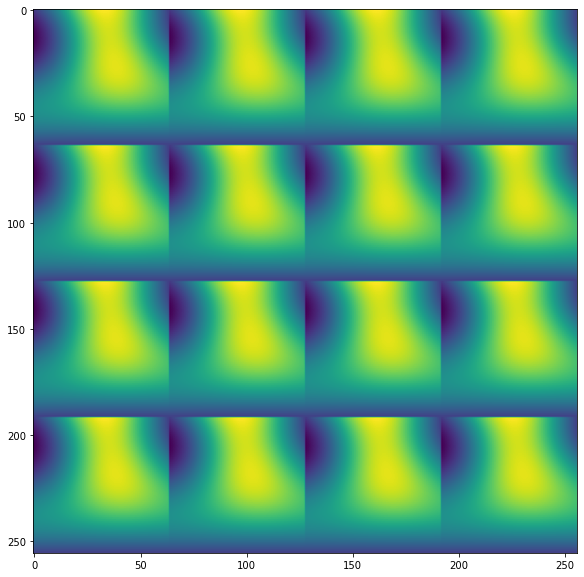

In [63]:
plt.figure(figsize=(10, 10))
plt.imshow(perlin_matrix_2d)
plt.show()

PLEASE NOTE THAT I HAVE FAILED TO IMPLEMENT THE CODE CORRECTLY! THIS IS NOT A GOOD EXAMPLE!

---

This is how it should be implemented, but this is not my work.

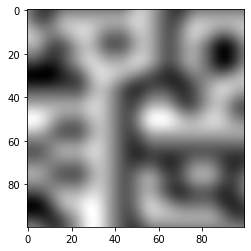

In [66]:
import numpy as np
import matplotlib.pyplot as plt

def perlin(x, y, seed=0):
    # permutation table
    np.random.seed(seed)
    p = np.arange(256, dtype=int)
    np.random.shuffle(p)
    p = np.stack([p, p]).flatten()
    # coordinates of the top-left
    xi, yi = x.astype(int), y.astype(int)
    # internal coordinates
    xf, yf = x - xi, y - yi
    # fade factors
    u, v = fade(xf), fade(yf)
    # noise components
    n00 = gradient(p[p[xi] + yi], xf, yf)
    n01 = gradient(p[p[xi] + yi + 1], xf, yf - 1)
    n11 = gradient(p[p[xi + 1] + yi + 1], xf - 1, yf - 1)
    n10 = gradient(p[p[xi + 1] + yi], xf - 1, yf)
    # combine noises
    x1 = lerp2(n00, n10, u)
    x2 = lerp2(n01, n11, u)
    return lerp2(x1, x2, v)

def lerp2(a, b, x):
    "linear interpolation"
    return a + x * (b - a)

def fade(t):
    "6t^5 - 15t^4 + 10t^3"
    return 6 * t**5 - 15 * t**4 + 10 * t**3

def gradient(h, x, y):
    "grad converts h to the right gradient vector and return the dot product with (x,y)"
    vectors = np.array([[0, 1], [0, -1], [1, 0], [-1, 0]])
    g = vectors[h % 4]
    return g[:, :, 0] * x + g[:, :, 1] * y

lin = np.linspace(0, 5, 100, endpoint=False)
x, y = np.meshgrid(lin, lin)

plt.imshow(perlin(x, y, seed=2), origin='upper', cmap = "gray")
plt.show()

Source: [tgirod (Stackoverflow)](https://stackoverflow.com/a/42154921)

<a name="3d_noise"></a>
### 3D Noise

In order to create a 3D noise we can use the same methods we used in 2D (but use them when the code is working, of course), but this time we have:
- cubic grid mesh of gradients
- different set of gradient vectors (see below)
- trilinear interpolations (see below) using the same fade function



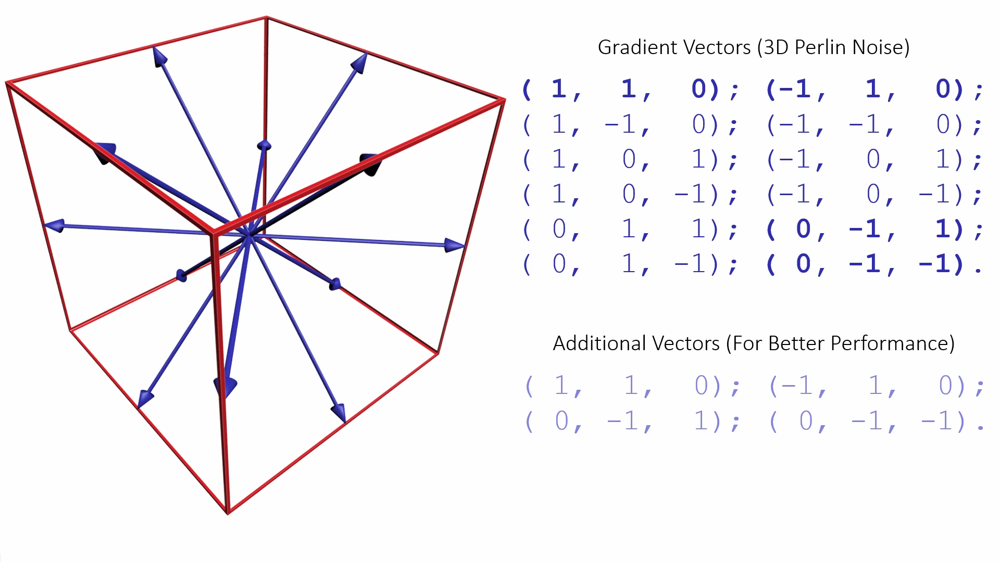

In [67]:
base64_data = "iVBORw0KGgoAAAANSUhEUgAAB4AAAAQ4CAIAAABnsVYUAAAAAXNSR0IArs4c6QAAAARnQU1BAACxjwv8YQUAAAAJcEhZcwAADsMAAA7DAcdvqGQAAP+lSURBVHhe7J0FYFVH+va37QfFpcSVKEES4h5ixENwKdS2TqlsZSuw+1/pbikUamhwTZHi7kkIbkFbHIo7RZJcy3zPzHtyeptACt3S0vL+Oj3MHX1Hztx7nzuZ86dyhmEYhmEYhmEYhmEYhmEYhrkHsADNMAzDMAzDMAzDMAzDMAzD3BNYgGYYhmEYhmEYhmEYhmEYhmHuCSxAMwzDMAzDMAzDMAzDMAzDMPcEFqAZhmEYhmEYhmEYhmEYhmGYewIL0AzDMAzDMAzDMAzDMAzDMMw9gQVohmEYhmEYhmEYhmEYhmEY5p7AAjTDMAzDMAzDMAzDMAzDMAxzT2ABmmEYhmEYhmEYhmEYhmEYhrknsADNMAzDMAzDMAzDMAzDMAzD3BNYgGYYhmEYhmEYhmEYhmEYhmHuCSxAMwzDMAzDMAzDMAzDMAzDMPcEFqAZhmEYhmEYhmEYhmEYhmGYewIL0AzDMAzDMAzDMAzDMAzDMMw9gQVohmEYhmEYhmEYhmEYhmEY5p7AAjTDMAzDMAzDMAzDMAzDMAxzT2ABmmEYhmEYhmEYhmEYhmEYhrknsADNMAzDMAzDMAzDMAzDMAzD3BNYgGYYhmEYhmEYhmEYhmEYhmHuCSxAMwzDMAzDMAzDMAzDMAzDMPcEFqAZhmEYhmEYhmEYhmEYhmGYewIL0AzDMAzDMAzDMAzDMAzDMMw9gQVohmEYhmEYhmEYhmEYhmEY5p7AAjTDMMwfHKE5i3LSX15uUTEV/8h/rR3DMAzDMAzDMAzDMMwvAwvQDMMwfxCkuGy5nbMIi0k5eJQrt1REWsrLzaLcBFeuHOnUDMMwDMMwDMMwDMMw/zssQDMMw/xBsJKbKzmLsJitBGgZUl4hQMMjfiRAI6VMwzAMwzAMwzAMwzAM87/DAjTDMMwfhAq5+cdOO1XDLMqNSoBGoKANzhShQqRXbYWWUEaGYRiGYRiGYRiGYZj/HRagGYZh/iDc+ggOGSP1ZbXH2awChR4uT9tQyczlFrNMJ8ugBAzDMAzDMAzDMAzDMP87LEAzDMP8AbEozCaTyWgqN0tNGX5dbhbAYpFXM2LNlnKLWR3DgQgpYptRAOJZhGYYhmEYhmEk+Nio+ZjfGv6UzjDM7xEWoBmGYe475I5lzfvzsZilAC3MSmg2qV3PRqMwmESZUVy5Jo6fFEe/E5e/lyEGozwkWj6X0GIyqfT8HYNhGIZhGIapgD8c3j+wAM0wzO8RFqAZhmHuL0h9rqJBy73JFe7WyDja4KxcuVntd8bVZBZlBnHpkjh8RGzcIuYuuv6fAXt7Pbv/yZfFsAli/Q5x+qK4WUqJTUjMXzAYhmEYhmEY5j5DbRYxsQDNMMzvERagGYZhfmMqPkKqw5eVj9RnCz5kag5+qQ+TyCwqNOiKZNKrHa8h5WaLMKptztdvigsXxclToniXcdmKQ599vvbFl5ekZ62MSyoIjVrbOjzfP3JJ69ilKR2K3/7b1RlzRfEecfK0uHZNlJbKvdJmk9wWLU/oMKF89UlX1lBR4w9Im6Rx0gYtSDOVYRiGYRiG+YVRf6v2G3zQwqdBg8FQWlpaVlZmMuHz4W8MOuFBk2Ll6XpGIwvQDMP8HmEBmmEY5ldCirhVPi/iNYnLggRodWIGws0WdTRzudlESjCC5Cka5VoyqTaXq38pk8lsLJNRpUZx+Zo4fkps2ynmLij9ZNDRF17akpJREBG7JDB0aWjE2oTkLemZ27Lbrc/Mzs/uvDg5e0Fk0lz/yKX+URsTM8+98Y7I+0ps3Sq++05cvyZMZUKYTGZcZb1S3y4XBrOlpMxgMkuLpFFwsgEwCGbKY6aVobojbZphGIZhGIZhGIZhmAcUFqAZhmF+Jaqqz2r/ilR1NQEajl6oA5wt5WazVJ+lAF1mNlG8xWSWwi6QyYQwmsW16+LiRXHkiNi59/tFKw58MXz7X/uu7NBtWVzimtCIraGR34RGH4tNPpGadTAlc3dyWlFc/KKIiK/CI8bGJY5PSFue3WVTVpft8Rmbw+NXtA5dGBqxPKv93g/+XjpngdheLE6fEiU3RFmpPMdDPczQCMukjagbLy3KkQBtFuVyr7RsFwvQDMMwDMMwDMMwDMMoWIBmGIb5bSA92qK2FUuR1iLMJos8uFntihbyH6VBl1uM5WaDKIczWZDIrJ3pfOGSfJDgtp1i/pLrH396pPdf1md0zI9LWREeuyqyTUFCysa0dltS2xWnty9OztwW17YgMGKRV/OvHd3z7F0mObuP9PJ709H9ySYOvd29PgyLHJuRNS07Z0FOpwVJGYvCE5a2ji0MSSpO63rp7b+LuYvEnr1S44ahJtqbDSOV6CzlcbNUo2UT0B74zLJlql2qlQzDMAzDMAzDMAzDPNCwAM0wDPMboE7jkMKtkm7VjmaFCqLNw2ZhMSpnliKvwSh3Ol+9Lk6fE1u2lS5ZdjJ3zMF//qeg8+OrE1Lzw9tsCmtTHNrmaGLGidTsI6nZ32S035KcuSAg/OvmwRM9/EY7NR1l6zLF0X2GretMe7fp7j6jfVu+bOecUqteQu26yQ0atHdweKFZs/9ExU1Nb78qs+um5E7bozM3BiUu9g1eHJGw4dmXjn421LB0ldj1jTh3SR70UWKQm69NmgCtZHSpPdPJIdQwhmEYhmEYhmEYhmEYFqAZhmF+A34kQKvDk02mikM41FkWwlwmjDdFyXVx+bL45oDILxIz5hoHDTvz+nu72ndbH992TXjsytDooviUDckZxdmdd2V33pPZYXt86saINku8W85x9fnKzn2irfs4e4/hDk3H+7aa3Dwgz7tF3mPOcx08prt65/q27O3kllyrblK9+gl168XXqRv7SI3UmnV7POb4pm/A4Ni2k7M6zshovyA9Z05U4qLQhJWhCflhid90fsrS/wuxtEDsOyyu3BBG9cxDISwWs9lSblLOjHaZLWiG2sDNWjTDMAzD/O7Be73mYxiGYRiGuXtYgGYYhvnZWKSSrJwWUC3WX95IgJYHWSDYpHY8GyzCYJbbiktKxbVr4sR35vVFJYsWHh78+caXX13TrnNBQvra8IQtoW32RcUfik08lpR2LC1rf3rOtuSMZaFRc1oFTXD1nODmPcqp6VBblxFOnmN9/CcHRs9IyFjQpVfxu/2+6z9wXY8np9o3nfmYS56zx3Bvv1ecpQAd92it7j6+72W3eyUhuZNviyQbx8g6DeIbNO7s4trbr/knsfHTUrIL0jtva9tha3RKvn/k0lbha5KyN7/w+ulhY8TKQvHtQXH9hjAaRZlRmOgwEaG2RUthmgVohmEYhmEYhmEYhnnAYQGaYRjm50HqM+3yvSMNWijIL7c/my3qCAuLMBtFaYm4fEV8d0ps2CqmzzF+8sXpV97Y177LhtiENWExqyPiCuKSN6Zmb83suKFtxpa0tI0JCStbt17s6zevqc9Mp6ZTbJzGNXEY6+g+xrv5+LDoyentZjz1/Ip+/9o9dtLlwvXi1FmpDl+/8e3gz8c4es6yc5/m7jWymd9LDk4ptesl1W3w3569LuzaeWL3rnkTJv3jlVcfj45LcXWPq1c/vmatjLoNH7d1eq9V6y/iEydndZjbvsui9OzlialLQ2NWBUVtjE48/WxvMTxXLFspDh0T127K86llSy1Gk8G6vQzDMAzDMAzDMAzDPJiwAM0wDKMhFeVbO7mvt8JP/1Jys6XcZJbPCZQatF5CBWp/c8U/ckcwXU0muV+4tEyUlEnF9vBR47qiS7NnHfn8y4N/++e6Lr3WJmauC4/fGhyzPyzuWEzSd8mZh1Pb7UxK39Y2c3V0/Nf+geM8vYa7OH9pbz/M0flLO+ex3s2nhUYuTMtc0+uZLe+8fzx3rGntenH8lLafmk6YxvXmze1Dho1w8pxh45Ln2nSET7NXnFzbPlqnbf1GQ199zXzpgtlYajKUmW7c2FVQOKn/x/984sk/R0ZnuHlGN2gcUrNGYsOGPT283wuOGJGcOi+z/bqMDlvi0zaHxK4NipwXFLYkLWvv2x9cGT3JtGylOHxE6ullpcJokAdYl1twpb5RPaA6paKvKvpTe/TiD92lHMMwDMMw9xUGg0HzMQzDMAzD3DEsQDMMw0hI/tSepPcjJ6ycBc6i1FIhFVOTCkYas3r4XrnBbDGaLTKREn6lM6vjNaQErKTnmyXiylVx+KhYuVpMzhODvzj50mvbMtuvj2+bHxm7Jjx2bUzyhoSMrWkdtqe135fRcVublKKw2KV+AQs9m810cP3K1nGSrdMIO5dhTX1HBoSMjkv6+ok/5//j3/vzpt3YslWcOSdu3JSPK4QzmeXealxRr9ksTHKTdfGXw4Y7Np1p6/KVm+dw72Yv27uk1q6fWKdB7tvvWL6/ogxVGjHsLDPcPHP223Ubpn057N0nns5sGRBv75RYt0lyjfpdmzi91LTZ/wVHDW+b/VW7bvM7dF+UlTMvus2KoJiC1jFb41LP9n5DTJgsCteK82flGdZlJcJiKLcYLOibsjJ0isVglLu/hSizKPvKTaKcHreodoUrK3THQjTDMAzD3D+wAM0wDMMwzM+ABWiGYRjJbdRnOE19VoIykpEALY+WkI/ck2KtVFHlqRMqjdKa1dUs5B7kUqO4flOe6Xz8uCgsuvLVjIODPtv2xluF7Trmx8RvimyzIyx2X2jskZjkU2ntjqW125OYsS4qcUlQ5JxWIdN8A8a6eI90bDrcwW2IreMwB5fJfi2nR0Qv79qroM+b33w69PslK8SR78RNqepKQ9QmayBNqABminKzMJtEaemuIcOHObjPsHWZ6uox3Kf5i3bO6XUbJdZrOOKtd8qvXzOZjWiV0tZldnU2iGz5hSPHiuYtHPuv/77fsUdXv8A2je2D/1+dyFoN2zZyeMKr1fsh0cMTkuanZ2xMzS6OT98aGruqVcjiqDYF3Xvu/9e/z0+cJJXos+dEWRkMkEYajLJk1UmlFnSgFKDLLWVSg0aPyo5WcRWOBWiGYRiGYRiGYRiG+V3DAjTDMIzk9gI0nBR4kUaqoaSKKmFUSIHWaJS7iy0IluAfsxAmiyg1iO+vyZ3Oq/LF1K9uDvzk/FvvfNup+8a45DWRsSvDozfGJcHtSM/ZmdFha1zKzvjU9WHRK1u0nuPqPd3OdXIj2/GN7EY2cRnm6JXbPHBcTMLMHk8sefPtHV8OPbtkiWHPHqloG4zCaBIGk6wO9hmMFpNJGgkrNOmZUBZbzKKkZNeQ4cMdm86wdZ3i6jmiWcvnbZ1S6zRMbvDY6HffL79+w6waUS73cmutkaA8lIlWGk3nDh5aMWPmwLf/+nJmTrpHszYN7aP/X4PU2o26NHrsNW+v/0SE5aamzMhpPzstc15828URbVa1jigIiNid3unCX/qKMVPFhm3iyvdShjbLc6JVV5WbLCap48u95LJW+LRKpdXSeOUYhmEYhmEYhmEYhvm9wgI0wzCMpBoBmhRQpT7jqrYIq13FwmISljJ5doTcX2wQpSZx0yROnhNbtl+eNefYl0P3vv9BQfvOq+MS10XFbouIORCVcDIx/XhK5pHUrG8S0nbGp64Jj5vvHzrdq+V4J89cO5dcR7chNk7DHd0n+jbPCwpf2qH7+j5vf/vJ5xdmzRX7vhXXbsjN1kYD6jZbjCaLyWg2WeQhy8o2/CdPAdEEaGUyoWw1GcTNmzu/HDrMwX2mvdsUV89hvi1esHdOr/9Y24Y2Y9/vJ27cRB4p/irxWWuy0qNlbSZjuawL7ZVC9tHtxfNHjPnyjb/2Sc5s19Q3odFjkY/WjG1QJ9vJ7qUWLf4ZGjEpOX11evvdbdvtjU7ZFhqfHxizKDShoPMTRz8aeHXG12LnbnHpqtwTbULXGWFbudx8LWVns2yHNeh82GLdHIZhGIZhfm3kWzLDMAzDMMzPhQVohmEYiaWK7kxOap/mCilWqrlShZYqLR2/UVYqrl0Xh46Iog1ixuzSQV+ee+v93V0eL0pIzo+MLYqJX9cmaVtq1p6sjsUpWdsSUrfGJW8Ij13dPHCxq/dcW7fZdu4TGzmNsnUb5uQx2q91bnDktA5dl73x9tbBn383e27Z9l3yWOebJepYZ7XTGU6ekiw1WXlcRblZisvywGl11jOcasuPqRCgr1zZ/MngYQ7u05o4TXXzHurT/Hlbp7R6jVMb2Y7v+3+itExufFbqM7VPnmVd4YxmKXbL6kjvJr6/cXDztrljxn/0+uvPJCWmuLm2adAwoWbdDg1tX/TwecvH75OQ8K9SMxfmdF6a2WFlYvqSoMjVrcPXhbfZ1+HxS+//wzx+stixQ9y4JkxlovSmxWQ0mU1oGAqWRuN/ZYnBZJR+hmEYhmEYBX1UYJgHlh/vNWEYhvl9wAI0wzCMRGq6FaLzj5x8ml+50n/N2qkXZQa53/n4SbFpy+UZs44O/mLHG28XdXu8ICV9XVT8jqiE/W2SD7ZJ/i45c3+blL1J6dsT0gpC4xa1DJ3ZLGCCm/doB/fhTZxz7Vxz7d1Hu/jkBUUt6dxzyzv9jn858srX8yybt4tTZ2X5lnLUKA/EkGYo1Zec+sCp9gXLGLkfWwrH2u5siv0xFQL0pUubBg4aau86w9Z1qpv3EC+/52ydUuo0TH3MbvL//QtN0wRo+bVOgpcmpTujGpMoN0h1WK+xXOrgSImr0VRy6dK+9evn5+YO6v3qk8ERqQ6uEbXrxtSuk9awcS9nt3f8Az+NipuW0HZN24xtCanbIxM2Bses8A9bHptY1POJQx8PuDRzpvhmnyhROnuZ0tll4bKFcoO38jAMwzAM87tGHQ/2v76l4/MJCjGZ8AGBPx0wDy4PzvyXqwbf7AzzR4EFaIZhGA18uqnkTGZTuckk9VCDUT5O8ORpsWmr+HpOyaAvzv3l3W879dgSn1oQHrc2Or4wPmlTavrOjJy9mR12tM3cGJO0LiQ2v2XYYvfms+098hq5TLX1GN7Q4Qtbl+E+rcZFxc/s/PiC3q9tGvz54dnzbuzaJy5fF6VmYUBFJqn+GmmzszpyWsrK5OQXL/KS2KypxVahtxWgzSZx+fKGAZ8MsXOZbuMy1c17mG+L5+yc2tZtmNbEfuo/PxRGeX60krpVOaoo6ZRXadAWdAScWXZMhd4NKJky9fvTZ7etyZ/0+ef/eOmlriGhafYubWrUSXzk0S6NbZ53dnuvRatP49rkZefMz26/NDVzRWzCYv/gNYHhm2MSjnTrXvrvD8XX88XB46LEJExKfFcSu5E/dTIMwzAMwzBMBfzpmGGY3yMsQDMM87tHiaESfBbTP45V/HEmhelOhmuaqahIghD5wiLPlzCb5MEaRqMwGERJmbhRIr6/IbYVn5v+9aHPhxa/23fDE3/OT8lcG52wPTJhf2T8sVi50/loWrvixJTN8clFUfGL/UPzPPwmuvmMcfQc7eAx0s5thH3TXDe/Sa0j56TmbHn9ryeG5pYsXm7eukOcOClu3FBSr1RczWpXMam6FhN8Qm04lsKuctJykyg3qmALPnmqFlGsFJkpr2xiJZQAjaZdubLx40+G2rtqAnSzln+2dUyu2zC1if3Uf/+XBGjLrQRoaU95udGMfrEYUZCsWoaX0z5lk1ml0Co3y3OiTdfOntm+YuXEDz/q1/Xxzs1axje2CX64Rmy9+ql29k94+/QLCR8S1WZReruNGTnb26QUR8ZtDAxeGRi8LCVrU++/nBw6qmzxSnH8lCgpFYYyuXcbgyKP/pBN1lotG66u1Dp5PIoWSwkqOUpJ3cEwDMMwDMMwv0fUhmCJ9pphGOb3AwvQDMP8vpEiqdRu5QcyKZJapHQrMZNGKdVJqY9Kh8Tq+Agp5kq5FKlQgvwEJzOgEIMouyFKborz58WW7WL67Ov9Pz37xnv7uz29MTFzTWR8QXTi+oS09UkZm9NytqS225Kcvjk+OT8kYnmLwCU+rWY7eX7VxCXPzm2snctQe9ehTX1zgyPGpWXOefGlzZ9+dmz23Jso89RZcbNMlJZJmdtsJiOVDcoo6SpDoRQhxdQKp10kWhJqWiXUIRaaAL3p40+G2bvOtHWd4i4F6GftnNrWa9z2MbvJ/5I7oJHVXNEnsj/IJnJUlKbw/mADORmltQKoDkc/o3WGsmP79q2eM2fkvz98JadDmo9fWL1G0bUbptZu3KGezQtu3n9t1nJIXMJXGVlzs9otSc9cGBW7JChsdUDo5pikMy+8Kr4YJlauFGdPi9ISJUMbTBYjrDHL5xZKJVzuyS6HxyDKDZZyozokRT4zkY4KIaeMIccaNMMwDMP8GhgMBqOR/4SJYRiGYZgfYAGaYZjfN0ohlfKySarPZnlohqafkoSqZGhRTkq02WKymIzqZbnc5iyfIlgmdcubpeLyZbFp09U5s/f0/3jbm+8UdX8iPym9KDJhR2TigZi2x+LTTqfnfJfRfn9K9pb41JXhbeYFhuc1azHBw3usS9Nce3mg8wiHpiNdvCe0DJ6R2Hb9y32Of/blla9nl65fL44dE6U3lWaqibn4Qkbul4XKr0QlAXqEgzsJ0EObtXzaxiGpToMUW8epH36ErkA6egiguvxYgP5xyfDCkcRL/oovmdor2dMWqa+bVdVl3189/e3+gq/nDH7r3ecTUjPdfGLr24TXbhBVt0G6je0z3j7vBgYPa5OwKD1jU0bWroSUnRFtVjYLKIiIK2zfcetrr5/MHSXWrReXL4qSG7Ib4WhPtBSg1bbscqNZGE3CaJEtkGdV647GnTRoZRvDMAzDMAzDMAzDML8qLEAzDPP7RkrJFimYmizyeGJ12AJpo9KrbX1GAqmumkothjJTiTCVipvXxLWr4tw5sXW7mDXv5iefn379r7s799yQmLEiKHp1SFxRbNtNSRlb03J2ZXcsbpu2KTp2bWj4ihb+C5v6znX1nmbnPuExp/H2LsNtHYc7Nx3hFzA+IW3OMy9uH/TFiVlzLhfmi6OH5E7qklK5O9uoDqmQB1bI3cWk0f5gufL/IlSSiYkfBOjLlzf2H6gL0EN8WzzVxD6hdv0UW8cpdylAA7zS3Y+RYSo9+h2tVgdHAwSaTNfOndu3YeOSSVM+f/eDbtGxMY7OYfXqx9Stm16/YedGj73q6f3PwODcpJTZOZ2WZndYmZyxNDR6UYugorCYXRk5p179S9mXw0V+kTh7QR5dYjCoLiXD0EizRTuhxGRW28u1HeaaTk6eKsYyDMMwDMMwDMMwDHOPYQGaYZjfN1KCFMIi9zab5QERJrkT2ix3xpZL6dks5PnKRrMoNUhF+MY1cf2q2F1ctnzpwc8+2/Lm26u7dF+VnF4UGb8lNG53ZOLRpOwTKR2+S+u0NylrU2zb5SHRCwPDpnn7TnZrOs7ZdZyz20hbp5H2biOcPYd7NMuLbrPmyWeO9//k3NiJJasKxMEj4toNKX4aS1Cr2VgKa5Rt0kKpypotEqWDSk0WWH5LAfoZW8fEeg2TmthN+vd/71aArh6lC1ukCIz6jWUmQymKKysrkZbIzeqmm+cv7Fm3ft64cf/p3btzUFC8rV1U3XpRdeokNmyYZWv3vJfPf0MipiSmrMlsvzW1XXFs8jr/0DWtw5eHx63t0H3rK2989/mXYuNmcaNMlJqEwSz3sKvd0OXyOA65CdqEeaAEaCVMa44FaIZhGIZhGIZhGIb59WEBmmGY3zG0AVZYhNzwLA/bkLtuDSaj2mys9h2XlokSgzh/UezeK2bNufhh/6MvvVrcrsP2tumrw6KWBYUVRsdvSc7Yl9N1b3aXXRkdNrZJzQ+LXe4fOs+zxRw332l2bl/ZuY19zHFEE+fhjh7DfVoNC4ma2ePJ7Z98emTa9GvrN4iDh8R1tRuXDvSQZzrDqh9ETyU8047gCklXmX0voPIrYS1Ab/howHB716/t3Ca7en7u7fdkE/u4R+smPmb7iwvQgBR3zVl1iFSB1b/oK/PN0gvHj+/Iz/9q2ND3n34qs0XziIYNImrWTHq0dqd6DZ+2sX/Vy/NfISET07LmZnVYmd1pRXzKypDoVS2DNgSG7c/uePqtvmLaHLH/iNxpbjQIQ6nZbDDLEznM5RYTWm2GUzK07AEWoBmGYRiGYRiGYRjmt4AFaIZhfscolVNtcKbNzmVmYbKI0lJ5WPCVy2LnzgszZ+3sP3Dz2++uffyJNW3TVgVFbAqK+DYi7kRC6pn0nO9Ss/e0Sd4anbA6OHJhq5DZfq2nevjl2ruOsHMZauM8VD1LcGRT34khUSu6PXn0v59cnTTt5pKVYs834vIVdXi0iQ6aMFksZqnzalqzVHKl7EoCNDmLchVirmb+LwwVXokfBOhLFzd89HGFAO31ubdfr0a2sTXrJDS2uRcCtOwNarsSoGGD6hhc5Y5w9JqqCP+rMzMMhksnvtu2YtmUTwa827VzO2/PNvWlEh1Vv06KXZPOjs4vuXv1bx06MyltU1bH3W0ztwdHbvAPWeYfvjw+bXW3Jzb/9YNTk6eKb74V174XZSXyxwA4s1Fq0D8hQCPkrhvGMAzDMAzDMAzDMMydwwI0wzC/X6R6KPVNg3qQYKlJnLsiNm0XU6Z//++PTr7YZ0+7TkUxCauj2ywNiyqMS9yUnLYru+POjJztqZmb2iTnB4avahG40N1rgUvTuQ6us+xcJzVynGDrNtrR40tX7xHBkXN7Pb3pP/89+tVXF9esFvu/Fd9flTudywxS4wbqcGeL8uN/kxQ4NSlT6p3lFtJblYNx0t1rrfOWMrHUxi0mYTaKixc3/OejYbYuSoD2/ty7+ROP2dEO6J9xBvQdgAwVArTSoEkCRqipXB6Lgp4zSpFeVgXK4TMbDTeunDi0b82i2aMH/veFnKxET4+wevViajyaWrNOl/qNn7Nz7NusxZCYNjOyOyxs13FlRs6K2KTlrSOWNQ9eGxpbnNn+4rvvia9nicPHxM0y+TuEEt8xEOToNwAr6FcBWHTXbWMYhmEYhmEYhmEY5g5hAZphmHvI7YQ9ITcBS0kTTtsXrMVoyED5xD6lYsqrTKuOFbYo5dIkyozqeI1ScbNEHD5ybd7Cb/sP3vjSG/kduq+Ka7s2OGpTq5B9QZGHo9qcSMs6mpmzLzl9e5vklUHhCwOCZzRrNcnDd7yz5wRnz1wbx1H2ziPsnHNdPCe0CF6S0fGbd/pdHT2xfGW+OHBIXL4sSm8KU5kwlVpwFRU2EGoDL1lkKpf7bKlFylmUzZoASgK0CrmH3FImrtgBbRIXL1QI0O6TpADd4s+2Tgm1GyTbOU7tP+DeCNBqEzQJ0FKDliEoiXZAw8GDmuDgQR9K1V7uY0cS440bl08fObhh0cKR/f72SlJKuqNLVM06cbXqJtSul9HYpruT+1/9g4dHtVmckrU1o+OO+PStIbHr/ENX+Actb5O4vMeTm/7v3zeWrRSXr8oZUqYO6DAblRmoVrNNM0/7kYBCNLuJH4JoQmpehmEYhmEYhmEYhmHuAhagGYa5V5B+B0fi3Q9+Uh8rRNsf9E31jD5k/EH9LJc7iw1SPbVYTEZ5mkKpQdw0iKs3xO5vxPwl5UNHnXnj3T3ZXbZEJxUGR68KCFsXlbAtOWNPVse9WR32pWdvi0ssDAlf3rzVIk+fRe6e8xxcZ9g4TbV3HW3rMsLRY7CL1xcBYXmdemz+8OOjk7+6trpQ7P1WnLskqygzCYM60xlOHqyhtEvpNMM0jxSVlaKqWkdU+Olf6Sr06HsL2WON7FCLPBBZduGF84X//NcwW5cZtm6T3H0/9275ZAPbxFoN2zq5Tfv0c2EywkKMgNTVrYfAyt09su1Wu4y1IioVXFEVpYANJulILzaZjFeunNz7zYaFiwf+5e3uYdHxts7RtRsl1W2S+mijXo2dXrB17dcicEhs4oyMnIVZHRamZM0Oi57fsvWyVkEbYpIPPvH8zU+HiMIiceWK/CEBjopVvwqYzEbMqvJyk3xOZblR2anbJo3RlWk1aZWjBjAMwzAMwzAMwzAMc8ewAM0wzL2CJDxcrRW8Cp8UoM0/FqAtZplWypEGowwxmuUe57IyecJGyU1x86Y4cvTa/MXFH3686dW3Cjt1XxmXtDIockNgxP7Q2FMxyWeSMk6mZO9PytgWl7wqOHK2T4tZ3n7Tm3pPcnYb6+A8zsl1vIt7rp3TKJemo/38p8YlF/V+/cSw0YYV+eLAUXHpmrhRJjdWq6My1DZcKYz+QIWRlZ1qILnfHDKpClJrlVt9T59a+UHfoTZOM2zdJro3+9y71TONHJJqNUxxaTr9iy+FSZ6YbLHIJzcizy2b/OugRHNZmbRBN8NoKrlw6XjxnjVTZ/Z/8bVOLYLjH3OMebRhTI16SQ2a5Ng5Puni/l7L1iMSUhZktt+akV3cJmlLSPTqliGLQ6MXp2au793n/LgJYtt28f01NaMMwmRQPyqoDdflSoaWYyirUj8nyNCqArQ0T14YhmEYhmEYhmEYhrlTWIBmGOZeUSHhkdAsFTwpKkrpGT6521SX9aSop45i0ERHszpko9Qgrnwvdu8Vs+Ze/PCjoy++sqd9pw2xCflh0SuDIlaHRa2Ljd+V0e7b9p13p2VujUtYExC82Lv53KY+s5w9Ztu7z7J1/eoxxwmPOYy0c/7Ctemnzf3Hp2etfuudA6PHXF69+uaOHeLsWXH9hjAY6XgMdTVrFqhtu4SyWTO0spNNkNxSlNRVyx85LfKeQFVUQW0elwL0yVUffDDM1lkJ0H6fe/s/Wd82oWb9ZCe3rz6TO6DvEwEaWAvQ5IdpZvloQRPG6+qpM3s3bFowYWLfp5/tEhQa/5hdQt0GKbXqtq/XsJetfZ+mHv/XslVum4S57Tst79B5aXLq4vCYJQFh+UHROxLTjz7xrBg6UqzfKJVolGaW7QU0XNSFVtP1B+gFTCHHMAxzj6FFiWEYhmEYhmH+CLAAzTDMvYKkuh8J0Grjs5L5ZKQSo5XcbJLCony+381ScemqOHbyxuLl+wYM3tDnjaXZ7VfEJ68KCl/nH7w3JPJEm+Tz6Tnn2nU6lJ61PSFpVVDoHL8WU718Jnt6j3dpOsbRPdfRDW54E6dRTh5jfVpOCIlc9/zLZ4aNtKxaI/Z9K86eE9evyy3V8hwGssFiQe2wCcBEIc8EllaR9Ewo+bWqqx5qZ2WnRd4TqIpKyHbQDugLZ4v++U9rAfrphtoO6Gmff3FfCdDAZDKRB+NDI2Eym4xmk0kdKSJtNJZdP3f20KaN874c0q9z1/YeXvENGsbVqZNYt25Go0Ydm9g85970w9DwvJT0wvadt6d32J2Qvr5FyBrfgCWBYcvTsope7nNuwmSx/6AoNYoSsygrF0ZMUzkh5fEccsZKKo2XnDGal2EY5p4iVz7NyzAMwzAMwzC/c1iAZhjmHkJqndlkMZuk5GtUR2uox81VbHbGizKjuFYiDh0V8xdf/cd/Dz/90tbUDhviUlcFRy8NCF0eHL4+PmlXVs7uzHbfZLffnZqxLixqefOAOe5ec929Zjm6TrNzGm/nPNLedYhT08Eunp94txgSGff108/uGjLs6pr80h3F4vRpcfV7KXDLEzbo4A8lfGtSuPqSLw961r7ua1Ga7KmoUGArufuN21ilH8FxcuV77w+3c5lu4zq5aYtPvVqRAJ3l6btg9Nj7TYAmLEAdw11uMlmk+GyRArR8aKHUoEU5BrTU8v0Vw7kz+9YWTP5k4HNtk1Pd3KJr1kqtUz+7XsOcOvUfb2z7TrOWAyKjJ2dkL+3YfU1Ol8WxSQuDwlcGhhUEhW9PTPnuhVfEpJniwElxwyQM8mBys8lkMJUZzEazfH6jNgnInt+qHxiGYRiGYRiGYRjm9wsL0AzDAIuV+4WRAqJSC4VRCJMQN83CgGuZuFEqTp0xFqw9OnLMlrffW9Wp2+KIuILAiI0tQ7e3Ct8fnnCybfaZ7E5HMtoVJ7ZdFRI2x6/FVx7eU9w9J7k0HW3vMsLOZYSD2xA75y+d3Yf5BUxJSl/76pvHh+UaFy8XO/eIU6fF91flab9qp7OSleE03Vl3CFZ7XZXkqtou99tWROmOZMeq7n7jNlahMfKxeyRAj7BzVQJ0cyVA2yc+2iDFpenXw4b/5gK0rLFC59XBcOCKcLNR7X4uL8c/pApbyi1Gs8FSbiy3GISpVLqS61eOHtq9bNn4D/o9GxaZYmsfXasOXGLDximNG3eyd3y7ResvohMW5nTe1LFbcUrmrtiE9S38CwNC5gXHzUvpuO6Vt0q/ni++Oy1KykRZiTCqySOd1nI5Fagr6DXDMAzDMAzDMAzDMHcAC9AMw1iUUxrlT2nQUoPTvHeKzCIP2SgXZWZx3SCOnhb5Gywjxp7+y1+3ZeQURsSuCo5Y1CpwaXBEYVxScUb7b9p32ZvdaXvbjKLIuDWBoQs8vGc7usx2dMY17zGHSbbOoxxcv3DxHOTrPzi8Td5Tz6/9ePCV/CK5gfrCRSkdlpap05zV8b4WuXNW2awU8AohWrNKiYlm9fg5czmS6m1XOaycJjtWcYRMUSXqR05LeM+h6qqgzoCGO3FixTvvjrRznSEFaL9PvVo+08gh8dEGSU5u0+6PhxDKSqtq0PhfDp3mTCRJwx4trUn+rFFuFOYy6eApK8U0uLD/YNHcuR+/8XrX8PA4e4fw2nXia9fLqt2w46MNnrNz/qBZyy9j2uRlZC7q2HF5VrvFUYmLWoav9AvaGBq7JT71zOvviMXLxbHvREmJMBtxU5AOLutVjmEYhmEYhmF+K/SPpn945KfwB6axDPOHhwVohmGARW4TVps9SYMW8p9K7/YqXDl5LIKKNVckkXHqX1mI2UwPi5NnOpcYxPVSceaicU3RkWFjCvu8ubhdl6VtUlaGRK1tGVTcKuh4VJuTiakXO3Y73eXxPek5+VFtFgSEfOXdfLyr52gnt1w7p/FObqPtnXIdHEc4ugx19shtEbii19PHPhtiXLZa7DmAksWNMnWwhrJHmSFVQl021VRNTYCuCKb2ytdKgJbHCqsWUXNIZrRydEBHJaeSApmiUlQlpyW851B1VbCYjAYB9913y98mAdplclO/z7xaPN3QPr5mvWTXpjO1HdDyEx66Svah7DGrJvwqrZCVVqAFqQGFTUa0Qv5OIKecNAwjIpPjpcliMcqhLTeZjaXlJoPFaDAZjHiFFpm+v3r58KE1X3314XPPPREantzYLrFOo4TaDVLrN25v69jZxv7NFq2GxSctzuy0OavLN6k524KjN7YMXd4saEFk4vx2XTa819e4YqW4eFlcvyknMz2mUs15aZVy1lSE6JEyKY0JOR3ZBM3LMAzDMAzDMHcBa7IMw/weYQGaYRip5JmNJikyms2ivNxoKLWUm8qlLCvlMyWW4VOOSXdS9ZMKrtyOKs93Rmq1O1XuoS4rkbuPr90QR78ThRuNX+SeeOnNbUntNoUn5gdELGsetKp1+ProhJ2pWQfbdznSoes36e2KwmPzgyMWejX/2rHpLAf36TYu0+2bjmviMsLO7UsXr4/dvQe0aj2pU+cN//nvxaUrjLv2ygcJfn9NGEzCaCbpmRRSoH8WU+d+VCinVmomqEgjdUz5j+Z09fl3jN4P1qD1Sp+1iDNnV777wXA71xm2rpPcfT/3bvFEA5u4R+smurhNHzpUjhr6wSy7S5bx4077DYExUndWTh4CrX42KMecqxg1NXC6RxN2cVU/MKh9/SZD2YXzlw4dKpo1Z8Crb7RvGRjTyD6uVuOMenZZjzbu1sD+z/bu/fxDRrbNmNf58RUdHl+W3H5JeOoS/9jVrcLzAyN2ZXf6/h8fivwicfmqlKFLy+T9Is+hlv2tzolGRULeCNJCsxTE5a563ClmpDHSqePKftinDKtwylSGYRiGYRiGqR76RsPSM8Mwv19YgGYYRn2g0WVcKUSazRajySIP26XzkZV0JqVni1SfjSazQcqa5Ra12dksteCSMrlL9MwZsW7dwS++zH+x94L0dotjk5a1jihqHrLdK+BIQOSFhIxLGR0uduh+ICWrKCx6cauguc3889x9Jrp6jnV0H2XrMs6x6VjHprlOHkNdfUYHhE9Jztz5f/+5OXehKN4tS756Ve6qtsg9sLqcV/1HMCn2ad4HAm0EK4NPquoRkJcuF/3fv4fbuU63c53k7vO5d/MnGtrEPlo30c1txrBhUoC2aAI0+hb/VN+3vxo0yvqI62NK4VXcD2OufDJMatByd788mKX82vWze/cvHDmud2JWuoNnUj37+NqPRT/aoO1j9hmP2T/d1OffYbGT2uaszu61I7vX1oikTf7ha3wDlrQInBMes6bX02dGjhYbt4hrN0WpUc18ozAby024HeQWfIsUpvGPPJbaYjGYzEZptupPMk9aRdIzORXCMAzDMAzDMAzDMH9sWIBmmAcdS7k8g0LqjkJY5AkDotwsA80yXHNKQZM7TBFtNMvDgoXZJHeDXv1eXLwoNm4SI0Yff+nVHWnZG6MTVgeFL2sVvLx12LrYpO3p7fZkdzjWocs3yWlbo+IK/IMWezT72s51loPbtCZO05o4T7V1G23nOszZ4xM37wHNW49ITl/9fr8Ts+eKb74Rp0+J0hJRUirKjHSgM51+QAK0rugxOiRrVkEJ0Biv02fXvP+34bYuM2xdJ7t7f+7t91Rjuza16ye5N50xYvh9K0ADGuuq9lgH3jKBQsbIH0vQD/LHFblvX9woLT17Yf/ajXOH5X7Q48m27l4RdRslN2iSXrtRTs0GvRravebWbEB4m4kZOQs79Vie03VlcuayoIjlzQIKWgQWBkUe/fPLYkKe+PaguHxZmMqEqcRiLjWWG6TILXtOoEa5FVpOWbORfq1RoTRAumMYhmEYhmEYhmGYBwEWoBnmQUcqy6LcaDGVk0xmBenOSkarONO5tEzcLBGXLoninWcnTN789rtLO3dZGNdmuX/whpZBxS0CDwRHHo9LPpfZ8WRWp8PZnTYmtF0SFDbTy3eau+dEB5eJTq4TnNzGOriOtHUcZus0wsVruHeL8THxK1/o/d2ocWL7Lnlwx7Vrsjq51dpgksf7KqvMsMECSH02mhEr1WhlJm8k1biNrGnRjuA4d2HNe5UF6Pi6DZKaeswcOeJ+FqB/HvrcoGtZWZmcP2imei37CpOqtMxw7vw3BWuHv9/v8aDwdEe3uFr1E+s0TICrXb+9reMrzVp9HBn/dWan9e267k7L2RYStalV8Ipm/gtaBc+LTVjz1J8vTZkiDnwrrl8VZTeFwSBPP5dz02zUtp2bzEL9YKNXqjtlJMMwDMMwDMMwDMP84WEBmmEYJdVJmRJe+XRBeJRTap3ZInXnGyXizDmxrViMn/Lda2/tzGq/JTZhVUDocv+QZQHBq0LCtyS2/Sa7/bft2+/JzNwUF786IGSRh98cZ8+ZTh7T7Nym2brk2bpMcnAb7+79mZvnAB/f0UkJi3q/dDxvqmXHdnHqhLhxXZSVSmcyqtMSTHDyxA/pKVcH7ioRVe3L1p3c2qrsZwhSNiuhRHuTfAjhydNL3nin6g7ojGZ+y/Km/vEEaMJa9pXnzGjBKoSmudxcbzbfuH7m0OGCefP/r/crncMj29g7t2nQJLFWg4zajbIfbfCMg/ubvv6fxbf9qn2nee07rmiXsyI+cWlA8JqAkFXNgzbEJF/5az+xcJk4ekI+ddMgT+QwoUw5bcvV5nOz+rsBnq0MwzAMwzAMwzDMgwgL0Azzh8Ry52qXEOrkDTrjQp7pbBRlZaLkpjxz+dQZsXf/jbkLDg8cvLrb44tiExYHhK1tFbK9ecDBwLCTbVLOpLY7mdnhaFbHHUlpqyOiv/L2meDuPsbBeaKz+0RHtzG2Trl2ziOdmg519hzh02pMcOSyJ545OmSoaeUKcfKY+P6SfGKhPB3CIOT2ZpOlXHt8W3m5fHacusrHu7EAfYdoMuuP+UGAPvbd/N6vkwA9yd37M2+/JxvZPlACtOasAmUC2V60GzeByWQ0Gq5fv3j0WP60mf9+5vkOPi3j6jeJq90ood5jbRo0iW/QuLOLy6stmn8WEz0/K2tzTsc9adk7wuPWtQhe2TJkZougRVkdj3w8WBRtFCdPyyPRS0tlt2NimwyoTB5so3qVJy3DMAzDMAzDMAzzQMECNMP88VDnLdyNPCuFMXO5fJbgtZvi3CWxbZcYP/n062/vTM7aFBy9xj90eaugZS0DVweFb0vO2JvV8VCnboc6dt2VnFEQGL7Up9UcZ6/pdm7T7d2n2blOsXOZ5Og+xtl9mJvHZz6+w6Ijv3qy14bBn15cky++OyFF7TKD3BJqMkptDh6L2QK/UOch0FkRUh/EP1JhVkKhDNSjqFW6Y6zRRdUfYzHKrjaKk6eWvvE2CdAT3X0+9Wn+xAMgQOvoovMPTrZV/vRhNJvQWPlCNVv+EgPvtRvnDx75OndM75yObT2829jZx9avn1i3dmbdOl0bNPyzrX0//9ZDk5Jnd+m6oEPHecmpi2Li57dovdQvIL9VyIa4tpf7/UvMWyhOnRQ3rwv5lEJ1frp2nDpPXYZhGIZhGIZhGOYBggVohvndQLqVlXplHWCxyNMz5MZh6SwVDw6sgBIBbZuzSW2JLSuTZzqXlIkr18SufVdnztv4dt+V3Z6cH5O0NCiiqGXwTm//Q37BZ2KTzyRnns7ocKJd5z0p2avDYma1DJzY1Huco/tEx6aTnDwnOXtOcPYa4+Kd6+Y71MNvTHDkjKz23/7nI7FsmTh8QFy+IIxl6lhnixmVqi25yliLxWTC1ayuUmI2wTylNVsJ6FqIcqoFzG0hXbUKFrPZKBX/02dWvPnXkXau0+1cJ3o0G+zTQgrQdUiAzpOHFWMQ/rgCNLiVBi0nGZosrzTNMA0NBvm4QsTKvrCUX7txfNv2aYMHvZiclOnumtSoUXL9BikNGiXWb5hhY/PnZr5/iwgfnpS8KKfjlpxOxQmpWwPC1/oGLG8VMt0/ZF5G9oH+H4t1G+QJNrjXcMfBqd9dUDMqVZ2Mm1KzTp/iKlzGWzRHIQzDMAzD3EPwzq/5GIZhGIb5RWEBmmHuK6QIVdVJCUqehCxPRDZr0plFnVBBziQfyycM5cIoBJKUCYv8w3/SoIHRaC4zmU3SizLM8niN76+KkyfEzp1i7gLxxbBjz7yYHxq3plVYYUDEypYhawIjtsS13ZPW7miHbgezOu5NyS4Kjlri2Xyes+dsx6Z5Ns5T7d0m2rlNcfIcZe82zNVrRPPA3PDY6d17rfn3R8fnL7Z8c1B8f0PcLBNlRvlMNgOMUU8yVE5pzVob0DadKiEsuN011IdVsMg95nAnTi57/c1ce7fpdm4TPPw+8W7es8Fj0TVqtfcPKJwzV5gwLpgdUoL9owrQ1tCtBeSNVDHbtEloNQ9lMvmDjTqj5urVb9YWjvrHP7qHhSc5Occ2lBp0St36qTVrd2jQ+FkX93+GRw1LTv26fael7TsvbJO8NCJuacvQVS3D1viH70jLMf53oFhTKM6eFyUlQt6RZfKMc4sw4fbF1Yh61RZspXsr0dmknFkeD0KKtWYUwzAMw9yP4IOm5isvN8m3NxlCnvsflp4rYT2af2xKS0sx+pioaLLRaMT1wWn7/YD84KvuPgwBeQAPwe8ODBluH4wg3Uo0lDyOTCVYgGaY+wqpd1V1Ujcul7Kg1I81iQyruVKTpdAMJwVoiygT5WVCGIUZV7M8dcFskgdrlBrls9G+vy4uXBA7dlye+fWuf/xzRddui+ITZ7UMWN7cf72v/y6/oKMhsafjUs+mtT+Z1Wlfcubq4Ki5LQInufuMd/Ica990rJ3reHu3cfZuY108R7j75PoFjAuOnJ3VcdPb71+bPkvs2isufy/rgn3SxAptXBqvWVzVMb8st+lVS7mcBmXi8JG5z7802sFdCtCezQd6t3iikU1crbpdgkM2LFz0oAnQOmim7gDdcjroDfr8JPfsm5QSXVZWeurU1oULB77Sp2dIWFt7p7j6jeHCataOrd8oqUHjXm5NP4yM+Sota012p62p7bdGJG5sHrTWp+WKZq0WhkYu6dz99KgxYvs2cfGCPCRa3jJClOFGRjXKoSJpDD6vqedwahq0lKHVXc8wDMMw9zX01kla0u9IfYC1dCUPo0tI4I/dLWga/UwCD1pNUBTzK2A0GnHFEACt963mHvN7ge4jQh8++MnDMAQL0AxzX4HF+hZOilMV+4YpnfpYJPVC6crpIX2a9IulXj7WD85QIi5dFIePii07xOwF1//d/5sOXTdHxq5pFZTvH7KiVdCa4PCCyKjitIwDHbrsb9dpZ1Lapsi4Zb6t5rl4zbJzm2nrNsO+6WQbt4n2XmNdfIe4+Q7xCxgRGjUqJWPJu+8fmzVbfLNfnL8oSkrlcwsNRmE0/3CGhnzbkXZJg+En06s45pflNr1KAnSpOHBg1jPPjXZwn2bnNt6rxcdezXspAbp7WMTWpcsfWAEaoKW3aazcsq9mswJe3GHoKERgzpvNV45/t3L6zPeeeS4rKCTOxS224WPJ9Run1WnQvm7Dxxs89qan76exCVOy2i3r2nlFZtqK2LjVoRFr/MOW+bZeExh18MnnxJQ8UVwsLl+Rx+AYTLiV9RGsuKhfcuSPTEa425rJMAzDMPcBJBvhamNj88gjj4waNQqB8v3zdwLpJrrBvyPL7wW6CKi6RELhfzxII8MVTR40aNCf/vSnPn36UBTzK0Cza/HixVg00Pm7du3CS4yFFn1/cL/Zcx+CUduxYwdG0N7e/uLFi9xjzC1hAZph7ivw2a6KIz1XfuzTnSZESfXZbFJHyprkg84MpXKj6/Xr4swZ8e1+4+IlBz4euLJHr0WJqYtColY0D9jq2+JAy9ZHgyNPt2l7Jj3nRHbH/ZnZ69vELwgImuTuNdbBebyjyzgHl9G2TmPsXCa5+473aDHGN3BiWJu5HXpsev/v5yZ/JdZvFqfOyFM16GANWbVZ6pt404FNUptTtirdzGzChzm4Cu28imN+WW7Tq2owjGXi8OH5L7w0xrGpEqBb9vdq0b1+45iatbqGhG5ZsuxBFqBvh/rkZH3fyYmtnOxnk9Eoz5PBFC8pO3f4aOHsuYNffePJkIhkW8ekRjZxj9ZJqlM/tWHjjnb2r/h6fhobMT87a2P7jtuTMraGxhX5Bha0CJrr33peUlLxu+99P+Nr8e0hcf6yuF4ixWgjbmqzvL/k2NFdZhRmg7RIM41hGIZh7kfU59Xyhx9++JFHHhk4cCCJehR1/6Nv1iObqS0PLOgE+ZHeCi3ijwXaRS3F9erVqzY2Nn/605/y8/O16Lvkl+2l39G9879AP/wMHjyYBOiioiK81G/G+wHYA7QXzO1BL/n6+mL9HzBgAC3+3G9MJViAZpj7CqzRmqPNzVLtwnuw2ST/JF+Jg9rf5KsPJDIdUpTeFFcuiePHxb59YuGiax9+dLDHUzuSMlYHRcItaRm8JiRmQ1zKpoSUXelp32Smf5OaviMmfnXzwDnOntMdXL6yd8qzdZpi4zjFznm8o+swF/chzfyGh0eMb5ez4I23D06ZZi7eJa5+Lx+eZjCIMoNUx6Q0ZmWrtEJ61GG60mBSmAG91F5Xccwvyy17FYOgCdCHDi148eWRts66AP14g8fiatXtHBi8fv5CFqBvBfpAOvXZCR+izPIUdX2Kq76Cx6Ke3yg3RxvNF48czRs+8pUuXbObt0q2d0qs1yi5Vr2UmrXSaz76lL3D+y1bDUtMnI47q12Hxcmpy6NjVgYGrWrRanXz1hsiE0+99Bcxc77Yd0CcvySuXcOoqYM/yo1mWa90fN8wDMP8IcC7B3kM+GSlWLJkSd++fdPS0v6keOihh/AdPj09HYHz58+n9CTTUMb7HDShRo0aH3/8sfbailGjRiHWzs6uqKhIC7pv0LtXVyQBhdwVNI7h4eF3NV5UF20e79mzJwXeD/yOJt7PgJpGYz1w4EDcep6ennp4JdAVBw8ezM3NxQB5e3vTrYrxSk1NReC5c+eQC9BQ3pIePXrQ3U1iK/npfvHy8kI5gwYN2r59OxVCpZEUCw+VcOecP38eZVJFlcA0y8jI+O9//3vo0KGfUfIvC7UUywV6A6xbtw6B1Gqd7t27w2z0+YULF7SgXwW9c0aMGIGexGDBBgwQHXaM8Ep2WrNw4ULq/B07dmhBvygwoLCwsFGjRqhi+PDheiB5fn2oTyZPnoxBtLW1vXjxIgKruReYBxMWoBnmvgLvGZqzmMvV6cn4AILFXGEpl0fQGoxSBS41iivfixMnxc6d1xctOvTZZ2ufeXZ1Zrsl4ZGr/YO2tQze5Re0PzjmVHL2qYxOJ3O6HcjstCk+ZZ6//6SmbhOcnCc7u42zcxll4zTSznmMm+cYD99cz2YTAsPmZOYU9/v74eEjxIYN4tJlUWpQsprc5iwfZFdukVqzfGsDZKh6qRxeEVKaU04LkE3QlLNKjvlluU2vSl1ZPoTwwP45f35+hBKgx3m1/MizOQvQ1YA5rX5RkU5NcXyCMsGpvf1w+m0pwYcrOLP8hiYz3rh0aU/h2lF//+cb6dldmrVKauIQW69RVO16MbXrpDdu3MPZ8b3A1iMTk5ZmZm/JzN4Zn1QcErnJL3BNs6A5rUIXtM3a+ua7hnkLxMGD8gidmyXyfpcPQsRtWM63DsMwzB8Aeu+Ax2QyTZkyxcfHR2pCf/rTw4oaNWrUrFkTL/E1HtdHHnnExsamf//+ly5dqkbsuK9QrfkTbNZbqpORkUHNHDBggBZ0n0EG411fh8LvnL59+1IPbNu2TQuqFl1hXLJkCQ06nV7yW6H3gD528Oj+Px5oGg10kyZNcLvhlqRHEWrRCqQ5evRonz59kADQ+GKwyI/5jCuyI6/qqtv2FeXSs9BLAiG6x8/Pb+bMmTQxYAk85L8rCgsL9fKpLgLlY4VBIIzHavPRRx+himpsvtdQ7dUL0Jrpf/pTQUGBFvRrAdtgIRYudBe6DtdGjRqdP38eUdUPysCBA2EwWnSPbIZVWEWpW9LT02EMQrS43wLqDdiAGwEm5eXl4eVvOK+Y+xMWoBnmVwKr708uwKQtaQqT2SI9WLfh8L6MlyazuHJVHDkmtu0Qs+caBn9+4PGnNkTHrw2NXNM6ZHXr0JWBYWuj47cmp+9NzzmU02V/ZofdyZlFwdGLPJrPtHefYec63d5lchOHSbZO4x3dxnj6DmveamRk7MT2XWa+9FrRoC+/L9okDwG4USYMZmEsr7iWC/lzpjLjBwfDlKyJTwywreKoAKVgavbCwSPzkRRt1TTdMb8st+xVbaQMZaY9e6Z06zHSzuWrHwvQnVoHsQB9K9RNaMFnKalBm8wGOAoR8qGA+HwltyVTUqPRZManLotROnUujbxHLOVXT57atGzFp+/97enk9MSm3rFN7OLr1mv76KPpjz7apUHDF1zd/xEcNi4jc27HTstzOq5KzVoaFrfIL2hls9b5rYKL07Ov/e0fYs48sXOXuHBWlJVIGVrdVnz3MAzD/K6RbyEWy9atWyMiIh599FF8V/f19f3ggw+KiorOnz+vPj2JixcvFhQUvP/++15eXg8p/cjHx2f79u1aEfcxMB7WPvLIIx999BH8WmgF97MATdbqNsODYarahJ9k9+7dNGTvvfeeFlQtqILq6t27N3Ih74EDB/BSi/7V0aumtuMl+BkC6O8FtA4tnTZtGnq+cePGuAerNhYJPDw8MG8xQD169MjLyzt8+DACkfLgwYMff/wxMiIKLFy4sJq+wn2BWrKysigNjTs8uBYWFk6dOrVnz56oBWmQMj09nXZVywG4+/mwbt06lANwr6EQHUTt2bMHTaCfvpDg1VdfpfDfBDQNtZMAjbbT30ZU6kPqW/DrCNCqn7TbHyAkNTUV5mFQatSogSstX4iqZqyRBilh8z36aw+YpwvQMK96Y34FYICcphYL/QLn5+cn++63m1fM/QkL0AxzV+C9v6qTyrKVIPSjKHoN5AKsBSBE5tBe4KV6e5N/3Q8PnNkiNx0bTKLMKM+EvXJdHD8p9u0X+YWnho1c+8zzS1IzlkTHLQ8IXu/Tal+r4COh0cdiEo4lZRzP6vhNRvvNSekLW4d+5dlsgpP7BAe503m8vet4R/dcO9ex7r4T/FpPDIqYnd4u/5VXj47ILS9cJ06eFSUm6UxSKTapXc5SQKOnG8I03ckIckrTJIO1tvwgQKN1ZlkOtZnSa9roj5zWeuYXgzq2EnJgSBI9cHDW03+2EqD9utdvHFe7TsfWQesWVAjQ+HQrh0uOnXVJ8Fcp+A8PJi4mqbYJmqRnXLVJbbaY0KsKmVSCIIMoRyAyatmRR6Ywi2unz6+dv2jAG28+GxOX09QjoWHDmNp1ImvVja3TINvO4Tkf33+EhU/JbLc0s8Om9A47YpK2tA4vat56mZ//3MDQZe3aH/jPf8TKleK7k+LSVXGzVD3wU+3ClqfxyG8kurOmIkT+S78RVYSRYxiGYX491Gr9A8XFxU2aNHlIyZQDBw5U7yMSkzrugND906ZNa9So0cMPP3xfncxwS8hsNArW3nIH9P18BAftewVPPvlkjRo1unXrBn8l++8Qb29vDG7jxo3hr9oJlUAsKrp48SLpm927d/9thSSqffjw4Y888ojeBBXzxwSdj2tKSgo6/+WXX6ZBr9RkBNra2vbu3fvAgQNakALhmDbosR07diABRtDGxubq1atadBXolk9PT6fy9YroinIAqoAxSIlJGBUVde7cOUShFlzvijVr1sAelIMVRq+IoNMSwIsvvgh7atasecsDc34dqMP1HdC0MtCg6PxWR3DQKUkYlOzsbOpMjB3uC/j379+vuvBH88SaAQMGID3MvkdrHarWj+AYNmxY9cb8OtC82rp1KzV8+/bt6DotjmEULEAzzE+AhbxiLSfV5gdBipzaYapEJ3VOsyg3WUxlUoeCx2I24T/1FirLUe+kpL7KnaZ445AhwmQ2y7+tr9C25FHLFy+JYyfFngNi8WrToCGHn3p2W1JKQWDouuCI/NZh+SFRqyJi18W33ZWatS81+5uMnOLE1LVBkQs9m0+xcZ5s4zTJ1mmyvcskW8extg4jnd1GNms+KixqXFr29GdeLPzvJxdXrJFKVkmp9ixBUrLMPzKvot2VnIZ6QZKWjp5GhqEkVRjzqyJHrkq/y2EC+EBw4OBsKwH6v55+Xes1jK5Vq3NwyOZly+kXA7mlV81K62LoZaXABwPZaNzFdCWP3g10XxMVXoolZ/WlgoYGAaVlV45/t/rrrz947rkeMbGpTb2T7JwS6jduU6N2Ss26XZs4PN/U66PY+FFt0+bmdFqc1m5xdOKSwPBlzQOXe7daFxJ9uNuT4uPPxIJl8pzoK9fkOTwWFGnEQoNvzGScOh1eVqoOjsdLLC7y5JByEz5Aq+eFyuH9UUMYhmGYXwF6RyAPvp/THynb2NgcOHCg0ld0PaUOvtWfPn26V69er7zyihZ0XyLf9vA2Y7FIGemhhz7++GP4K94ifx9Q56elpcH+jIwMGE8hdwWy5Obmkpq8YMEC2SmqW7ToKlAteXl5qBRZpk2bhpcIp+uvD9lD8hmo3vg/AGjgoUOHaLyWL1+ui7NAS/FjrHvD2k9HSD/yyCMYQS2oCkiAWtLT07XXFViXQwbgZieTQkNDEasnuJ1VVSksLFQDKHdAa0FVQGmRkZGkqGItIr3V2ph7DTUHVywXaCysLSoqsm4v+ZGAUqJzKPxXADVS1bgmJyejl2De+vXra9Soge7q2rUrwrF646pl+DG0PRlZMBBa0L3ndsb8aqC7MEZ0+Djm8G9uD3O/wQI0w/wEVqIe/pGKcyWnCXxmueDinVFtgTSVW8qUDI0EFpOF9GV5RKwqR5iMKBPvZkLucTaa5bW0VFy4IA4dFsU7DUuXH/1i2MaXX1vb8fFFoXErWoVsatm6uHmrg8HhRyLiTrTNPJbRYV9G+6LYpKVB4dM8m+XaOY+2dx1n7zbeoelYR/fRzh7DXT1HevtNCAyek5a+/Omniz/8z83FS8XBI+LqTVFiVHtdZaPwlgCz+G3hD4PVXP0B9QOJWZSWiG+/nf3kMyPtXPJIgPby61K3fnStWt3Cw7euWIlZgdzqUrkMvKS5zlPlZ6D3HjoWTp4Tjc+yFvOpb7+dNXR4355P9AyPbN+seWyjJhF16gc/WiuuQaOODk4vezUbEB7zVXJ6QWaHjYnpm0JitwVFFzYLWOLdcmVEm809n7k6eoLYsEV8d0pcvykfEIpisRaZcZU1wZnxmdhiNllMBlOZ2WJU65L2VwtqKzfs4vFkGIb59cBnRF1ojoiIkLLQQw8VFxcjUH2A/CG2EhQLDyW4n7/Pk6mwkFpHArQWdwdQM39byIb/UYBGrgMHDjysjvPu3bs3XlajUgGj2nndrVu3P6lzhH/lPZ5VoVY/OAI0RmfUqFEYLPQ/XlLzb3c/VsPhw4dRAvjggw+0oCqgP5EAE0x7fRtggMFg6NGjBxI/8sgjn332GUJ0tEQ/RVFREarDPMRQVpNr4cKFVMvw4cOpfFLAteh7jF6RtQBtHQ6kTVYvf53ZSNNA96empj766KOYJPCnp6fDTrxcs2aNtWGV0AXoe7QD+r4FfdKvXz80HKuZFsQwFbAAzTA/gZWoh39ISqrs9D/GB+VmudPQYimzWAxKgJY7EOUDBeVWRFmQxWQRZnyuUe7y9+LYCXmm8/yF4vMvD/d6qjg5vSgkujAwYkWL4PygqHUxiVuS0nakpu/KyNqZnrU1KXVlYOgSv4CZjh7T7Nym2jhPsnUeb+c6wdV7hLPnqGYBo0MiJ6Rmznr2hTX//s93c+eI/d+Iq5flNmejSerO0lU8P00qjQpqHPP7x2qu/gAGWI4yPkp+8+3XvZ6SArS921ivlv/x8uusBOin2rTZXbiWBeh7hOw0NQbwVDhczGZDqTAZhKH06L5dcyaN++CFZzuEhsQ5Oibb2KXUrp9Ro077mnWefMzm/Zb+g2PiJ2W2X9ix29LUjGWRsYUh0QUtQ1c3D9oQHX/ipZfNw4aJNfniyFFx87qwGIUZ35fUfa02PGOtMZTj5jcbzfguoXZhY4Qr7GIYhmF+NXT5mFSJhx9+WD8imRZtlerWkBRCaEH3JWQhrH1I8SAL0EajMTw8HKNsY2NTVlaGQqoRNBF19uxZ0qr69Onz8yr9BSEDHhwBGgQHB2OwevTogcb+7PYiI/VYSkqKFlQFxGKgf1KAxpRAaefPn8f8QXpbW9tTp04p0zS0dNVCO6CrEaApEHOVrHriiSdIerZObO2/F+jlVxKgAc1DSkAjQi+Bir+3UO36TKCTN2AeAg8dOgQ/OpbG8Xaz5YEVoAH9qgH05xb8OqPG3P+wAM0wP4GVqId/NMXZ2llwFfJP3bGuSidP0kBifG6Ah45SlvqPVADlyc5Gca1E7D8mNhaXzl9+ZuiYHa/8JT+746ro+DUBwdv9g/a1Cj4cFH0ypu3xhPQTmR0PZXbakpC6JDh0WjO/0a7uQ20cRju4jLFzGWfnOsrGebSrV66X39jWYV+ntVv2zAs7P+x//qsZYnuxuHRFlBlkpcKC2mEbvYHTWze9eyvDpeN3gz8MVnP1B+SAY3Ji+h06PP/Pz4+wc5lq7zbG+wcB+s+JSd+s38AC9D1Cv+lkN1Z8fDbjw6p8ZcDHftXrpaYbV7/ZsG7cf//zTseOPVsGdPf0SWnYuE2t2nG1ayfVb9jRweWNloHDE5Jmpaavy2y/OT51S0jUBv+gZT4+s5o1W5TUdvsbb12aOEkUrRMnT4vvr6s/rVC7nsuNBgsWHXkKuKzX9Bt/p2UYhnlgMaq/HD937hwdFOvj44P3BArUtWmZ7laoD25SwUSaSsmqyVWJu13/7zY9UGb+TAGaMsJz51l+KVC15qvw/+8CNJg6dSoGGuhHatwOg8EwZcqUR9TzypYsWYIQpKe5AQ+KUql+Jj/PfuS6DwXon9GWO+HSpUsYJnT+wIEDtaCKu/Inob6Ch3qJRhwzh2Krgv5ERT8pQBMos3///pRlxIgRdzsQlXZAU16ylkAIERERgSqysrL0QCSjlNbp7wV6+VUFaGWCjIU9uB1w/clBQRrN91Po9d4O6gR4lBUCQ4aexE0KP6Lee+89WAvo7r5lvfodVFWARhbNdwcgMTW8Uq5bFoJA8L/0Q9WQn8HFixdrKPr160cF/iLFMn8AWIBmmJ/AStTDPz/oztbOIkVnvEvByeVVpsPCL8+DNopygzAb5DbkY8fE5m1iziLDoGHHnnp5d9v2WyLabgiMK2wVme8fvjYsZnty2p607OLE1G9T2+1JzCgKiVnk7T/L0WemncfkRjaTbe3G2dqPc3Qd5+o12qPZ+NahU5JSZz31zNK+/Q7PnGncs1uUlAiz+ht8o0EKjtJvwMcnKXVhwdecpj5To6SjljF/CGhMKyHHnATog4fmPf3cSHu3PAf3sT6t/uvdvEv9BjG1az8ZF7d/4yYWoO8RlXoPVxVi0TTochOc/L0Kq4TFJMpKTZcvfbthfd4Xn73euWP7Vi0TbGza1G0QV6NO25r1OtRt9IKLx3sBgUNTUqe3y17ULntFSuqq2Darg0IXe/nlNw/cEZ9+us/bYtxksX6D+O64KLkhLEaTsdRgNposZthQZpK/RfE4MgzD/PrgcyE+f+Xl5ZFs8emnnyKERMafRPvsViGI6OClyWSivWaNGzdGAry8evXqCy+8YGNj85DSrVJTU3fs2KEKkHmRBhQXF/fr1y8tLQ0JlGL2sLe3d9euXRcvXkwJAKUntCAVSEydOrVnz55OTk6yMX/6U0hISP/+/S9cuECxFPjxrR5rNn/+fDJs69atWpBqiF44SS0XL15EX3Xr1s3W1pbSN2nSJCMjA4GIQhpKT1cqhAgNDUX6oUOH0r7jQ4cODRw4MDw8XFkkC4HZpAchr8FgwBVgILZv305p0Bu4ohCqVwcv6bGEyFup0qogwfnz52mbJO2r1SJuBWLp/A2Mmq40UUXUUph3+PDh3NxcGjKyDUOGXEuWLEFiPT3lBbpHB1331FNPubu7UwPRsenp6YMHDz548CAloBIwkUgKRxXksQZ5kVGvC8CPboSdAL09atQoGElHnAN4UMvYsWMRhQSohbLoeXFF4JEjR2jG7tmzB8kQ+NFHH3l5eVGNGFPMNyRGFK5Ij5lGFVEtNWvW9PHx6dKly5QpU/TC7xz0IVVkLRTeYTlkD67gwIED1GnoVS26CkiAumC59vpWoCjNV16O0UEW2BYZGYmXel0UWz3r1q2jdtFDCKvmoqIwu3BnIRmsQjKSevXY0tJSdDsWmRdffNHDw4MKxBVZBg0adPz4cUqJjPDQlZY1+Pv27YuU3bt3p6IwuLj7atSogRZhuDt37ox7mbKAW+6ApskADxWF6aSn10F1WH/Q7SNGjKA5humE0iIiIlAXcqEuLG6FhYWIIrSc1YJK9ZTwo3No7KiKc+fO0SR3c3NDLEGJdWADZcFAaEEVUMnIIq0RAjMHxqMKmIr06GF40MPDhg3DjU/JKGOlWujGQfohQ4YgDcXCo98pAA1/+eWXceOjZLIHFf3973/fv3+/dckEZQGIwlqNjL6+vshFS0F2dvaAAQNgrV4R5aoKoqKiopARo0DJqknMPFCwAM0w1YGV0krUwz8kJVV2ZrNBPZHPLA+7MFvksc4Gk7h8RRw9Ylq39sbChWdzR+9+672CTo8vCI9f0jJsfbOgvS3CjgbGnQhPPhGbcSwp+0Bqzs6UzNVh0bN8W01v6jfRoel4e7dxdm5TnZtNcPQe5+41qaX/1PDIuelZS7v12vDGX0+MGC02bBIXLkndWT1eTEglSx75ijdrqWRJD+yQOx+VAK22Y5P+XNEo6ahlzB8Cq7n6A3LQrQToXGsBul7DmNp1ukdE7swvIO1ZnhKDzxxaVg193lcpm/lp0Gm6I8ivNGizPCVD9a76ywl8nDOZ1R8umA0ll0+eyJ81a/Abb76entXJr1Wao1tC/SYR/69WWM1aGXa2T7i5/CM0ZGSbhHkpaRtSM3a0Sd4RGLW5RegSz5ZLgiLXduhy6O//uJr3ldi+Q5w5I/8eoqRU/gUG7nj+/McwDPNbQF+/u3btShIAvvwb8dZcIRncCVW/wJM6o8scKGr79u12dna60AAeeeSR/v3763UdOnQoPT2dosDDDz+MlAS9ROylS5dQ7C2rQ+C2bdtovyTpUASV06RJk2nTpiEZBd5SgKYHtSF9UVGRXgU8AObhiuwLFy708fGhQkhCIg/V6O3tnZ+fT7lIZwFUDqDEVPXw4cMbN26Ml3ohKIEK6d27t56dqt61axdFVUIXYeHp0qUL1VINKE2nV69eyIjaz549q0XfinPnzlEV7733nhaEjwpKfUMh8KDTSGaiZGq4NPAyNTX18OHDSEkZVc0SXQfcsmULhqxmzZqUndDyKz744APqQ1wbNmyoJ9CvqJr6EC/t7e1hmKpKg6rr168fWUhXpESPAbzEFdkxD6uOF+XFZKBc69atO3/+fGhoKPwEwlEU2ki50Khly5ZhkuslU0VkJ663nHXV83//939U1x2evk1NINAiQPdXbm4ulbN48WItaRXIzuoFaGtQLMaO2njx4kUKAeRRSW7L+vXrURfykgCthVqhBzZq1AidmZWVhRahLWgRxeLljh070PmqWdpYUJnwAwzEiBEjkEw3ifzkQYFITLo2VgYqAfNQz26tzGLgqGRdgKZCCFq1MItoVluDZOgcxNLQwx4sRCiHZgiVSTOEnoknjfuprgOUUnuhjuCg0qhzEEub0xF4O30f9lCWSgI0zRbKYjAYSFvX0RcrgPJxRUVaTiuQHdeNGzdS0wYNGqQH4gojccWt1K1bNyoEUC/BJIQAeCq1EeAlwPuIPuiAMhLIhSWCBh1o2aqAqNdee41sI2OAFsc82LAAzTC3BcukptLCyQAsspribO2kcmQxC5N6kOD1G+LocbF1h1i4pOyzL0++0HtXSuaG0JjCgMiCoDarg+NXRyYVRCcXp7T7Jq39nqSMfUkZm0JiV/sFznP2mmHr8lUTpymPOU21dZ1g4zLewWO8R4tJrSMntEmd89xLa/sPODpnblnxTnH+oig1CoPSuI2oV9ZuNshdHmrXs7lcHkitnoJYLs97NllwhcNLeSZ1RVskWgO1V8zvHpqrVVAPIVQC9IJnnrcSoFt0a9A4ulbtLmFh21auEibklAJ01c8H+ry/7acMplrQb5W6ToVUFaDlxz61Mxo3rfqsZioXZeYzB44szps+8J33nk1Jz/TxS7Z1TKzTIKVmncxadbo0sXnRw/PfwaGjktpOT89akt1haULKstDolS1DVvm2LmwV9k12l5t/+1DMmCuK94lzl0WZOgv+J+56uTBoXoZhGOaXA9/JbdQ2Tw8PD/rqXlVMuSvoi/2AipNGi4uLbW1ta9So0bNnT9qktn379mHDhiHcYDAg5bZt28gALy+v3NxcxKIEJLt06dLChQtJ50JRWVlZ8j3oVnoBSiBxB8k++uijw4cPkxyzePHilJQUhD/88MO9e/eWQsVtBGjkQhRSWgvQgMqBMdOmTaPyvb29p06dStv00FF79uwZMWJE48aNKXb+/PkUTtl1ZMVKsiEz0Bsvv/wyeoBily5dimYiEHai31ACQbWjNHqZrs57RYuofwBiyVrdTlyrgRKjW8ie6k/hQLtQHdi1a5cWZMXzzz9PmhHsQauvXLmCosD69ev79euHXIjCsB49elTLoCCzkQxDRrvIkWbQoEFIRuGHDh1C9+p7w9etW0fhBEpA/1Dh1AlUJqJwpZc6Fy5ciIqKonIweebMmYMQpEFGzBDUgqGk2FdffRUlUB8SVCAmAypCdWhgZGQkUsKw/Px8pMRMzsvLw/ykSnfv3k0KHcpcsmQJKkIaDByaOWTIEB8fn+HDh1PJd06a2kmN/qGG3xVkFa4XL15ECRip5s2bV1MOmom67kqAfv/995GrZs2aq1at0kJVeDW1ED8pQBNHjhyhgR48eDA6U08JD93vKARXTB6sGNReDMr06dNp8iDje++9J62pEGFptcGgoJnoEMxbzH94kBhrAiYw0hQUFMAqDJ9+C1cVoFEaFQirdD2UQqwpKyujKJTQp08flAA/7noYj4wAt2FQUJCeBiGUsWpR1iAWrdD9NEnQCgqkvL6+vgjE/UUndFdajlAXtbqSAK0Xi1zBwcFULNYcTHLqEBSO+xQ9TOWD1157TTdbB+WgG6m9WFcphMwGeIk3AsqOAdqxYweiUAgmKiqiv5KhZJWgQYdJuKJYvEQgMmKe4E6kXx9Rad++fakTbgemE/3YgHlIJlXqH+bBhAVo5oEAq6NaILHIkiOwakpXES+dUFc9nBS9ClEP/9DmYqM8Xlk+QKxMlJbJPchnToudO6/OnnNh9Nj9/f6+tkfP1cmpK1qHbGweuMsv8FhIzJHozB1JTxdlvLo08/UFqS8siu4w0y98atNmkxzdx9k4TbR3nWDvOsrGaYSD22gPvwktg2cnphc88dzO9/7v6JcjjWvWipNnxM0y7eGBRqU74y2G3l9IS0IUOQ1Em2A3KVxKgDZIAdryIwEaWHcH83vHaq5ao/bmG41i/8E5Tz5jLUB3qdcopnbdbnIHdD4J0HRauJavAkSwAP2LQ4uMOoVD9q7FhM9k8lwOg9mkelvdwxg6+XFNLkSWktLju3cvGDN2wIu9X01o28HNM7FRk5BatcPr1I2vW79dE7tnvXz+ERbxVWbO0rR2m1NyNoXFb2wZuqF5yCq/oPzo5N3P9Tnx8efGhcvFrr3iZqncE43ly4SlDGuC+hsJNe6YQagaznoqwQi1TshALUjC04FhGOYuwHfvQ4cO4ds4oLNWsfBW/wVeB8lumZIC+/fv/ye1SY1kvo8++gjh8sOgKt/aX1RU5Ofnl5eXh1ymit21FAsQAsNgHooi7UZVooGUCImIiHhYHcKwfft2ZEG4nhcJhg0bRg1ECbDk49vvgEaCgoICLUiB7LiiWJSPBF27dj116hRCqBbEUoKLFy+GhIQggb29PYk+CLQG9daoUYOkwCZNmqAWSiOtVHZevXqVOgqFYERQLEUB8hsMBtpuSbtuKdzag9IqdU5VZHEK2oKNfkOxWpwCUfqVJFcvLy8qXAexw4cPRxTa8umnn6JSFFJWVoa5BJAYCdBjtH0VNuMloIzEpUuXMOIoAR1C6jaNFK4ACeDHfEBH7d69m16qmmUJAwYMqFmzJkrWQ6hGemlN9+7daUwnT56Ml0hTKfGFCxdefPFFpEGBgwYNQjhqRziuVOOaNWsQCzsxNCgHbaEEgBJQSmR84oknqDnnz5+nJlAyoKfRXt8xaD5qp99dtKAqIIpiyaODEAzKkSNHwsPDqQnoSZXj1lCaOxeg0SLSMZFxxIgRCKFK9dqrAfc76kJG6nOEUGdaQ+UjGarAXKIQikIP0x8iYH4iClOOBgVFIQ3NwFdeeYXybty4kfqf8irrRHZ2NmI9PT2RAB7YgzRq8v7wxx/wUBYyA9aSAK2HU0oSoDE3KJBAFEE21K9fHx6663VT4cEVNwK1BYvDgQMHKJwKuR2oFMl0P4npKAGBsJ8C6fAW0KdPn6pl3k6ABtT2Xr16IQGYNGmS3icURWnOnj1r/Xse0uixAOnXr19PMwp3K15SCeTZsWMHosB///tfSqzn0j1Umh4CTp8+TStGaGgoVgyKoj7US3755ZdhM0rGbUu5qoIsNP3AlClTEEIlUCzzIMMCNPPHB0udElNIPdEdlkAp/SiHVVWdUCH1ZXgE0ppliMIiT7NQTw+zaGc6mwzycNWjh8XWbWLmvPLPh19+669HunbbERO3LiCwwD8wPzB4XWT01oTkXalZO5LSD2TmFCR3HxLzl78E/+3p1v/u0/Ldj52zxzuET7TzmWjvNtbRdaynz4TgsAkJbWc+9dyyvv/YMWrshTWF4rvT4kapMFjkZmfatIh1XzqtJVIr1Fqi3jzgtBaqFssGWjtNQkQC5o8KzQ1r1NzAoCsBeu++SR265Dq65zl6jPFp9aFX8y71GkXXqv1c2+RvN26Qe+cxd8w/+hRCoAht9mgBzC8D3ZuqXzVn/QIDgbVJ3dMyrVyJcMXKVFLyXfHOrz7/4m/PvdAlNjbZyzu+sW3s/6sT9/CjGXUbdWls95pPi/+Ex45KzpjdruPi1Kz8hLTC0Ng1zYJWebbcFhZ3utefS//5HzF/vti7S3x/UZTerFhV5GpnVKuhAR5ZnwKGKKcml3TSNDmpyEyGYRjmTsnPz6cv5LoeBO7wOznSV02JEKDrRzVr1uzRo4cWdzegECp/y5YtVNSAAQO0OCumTJmC2IceemjcuHGUhQQRkmOohMmTJ9dQZ7wiJQyjjNbcTpShAtPUQavNmzc/f/48XmpxViDwyJEjaClK+Oijj0gZ0eIUyA5QhY2NzZ49e1AsAisJN8uWLUP2Rx55JDc3l+rVIhQIIQFaVwmt894hKJNKfvXVV1ERSoPZCCH0BPAcPHiQjBk1alQlAUvfVNurVy8tSEEZdWbMmIEmo9vXrFmjipf6MsoH6G2UjKiioiKKAlq2nwJzgHpSe10BlYDC6WVhYaHq8oeq33qMXPouaQwuQmAkQDiKwmRACdRR3t7etxx9qpdKePPNN/ES0NzT26sS3hHIS1n0/bM/eVQ3qJqgoKCgb9++9DODg4ND1V9uKoFmIuVdCdALFy7EKCDjQKtnJCrbf8JaDDpVpy84uOp9Ti9Pnz5Nc4x+FSNkz1osmACyX/70p127dlk3ClGaT5WA8UItGeqJnTQQlAAeuo9QOEaW1PNqoHUMRZEADawrQo9RrHUgoOpQPqJAw4YNaauvFl0BktGfIyDNsGHDaEGomgwgpear8FMyUsDpdkA4lYD26m3EjSzzWIEWoTrE6i0CepmrV69GFLjlKmQNHaaMlOfOndOCFMiCu48KIQGabgcCyyP1vH7IO9DifgyFU3OQi+qyPqO/EkiPJRrJMOj0EvVWLRzvJjAARdFvotW3kXlwYAGa+eOj6yY/dgjH+wmc2WzBolkhQEuVR9v/Jzc7Gwxyu3GJQZQaxPXr4ughsWVjyeJFZ0blfvO3vxU93mtlbFJBUOSGFv57A1ofDw47ERp5Mi7xaGLK/rbpO5PTCyPjF/qHTPPw+tQ99Cm3Xsmef4tpMSyr5ZfvNXt3sNfjw5olzohPX9L18Z19/3585Khry1eKw8ek6Iy6jKZys8Us3++wUvNizdwR2sy2Am/2aqZjJpdZineOzcyRArSTJkB3qtMgulad51La7t+8UZjVJ0u181Zl/QEUwQL0b4ocRFqapLPgCn+54crl4rWFM4eP6P/Cy89Htclwdo+p1yiyVr2ImnXi6jbs5OT2F//Aj0IjprZJKkpvX5yUsScyYVvL4PXN/Fe1CFiX1HbbM08f+7i/edlycfiouF4il50yg5xCotwo/2yisgCt6pRXGcECNMMwzN1TUFCgtAKpB2lBVqi37PInnniCVANcCXzPJ2rUqLFw4UJKTKgv9T/oRN7e3hfu7BDbShjUs/jgwZVqrCqQmUymHj16wDAvLy+8pLcIghIgL/xINnXqVJQAe24nQKMQxFbdFaifZ5qXl0dF4UqG6VAtnTt3RrLw8HB6qcUpYD8Kt7OzIymQSsDVOllZWRmyA5SjBVVA6UntSk9Pp8BKNtwJeo2kz6K0UaNGUSBKs24a7XHG4B45cgThKrcGRpZmwv79+7WgKqAcNMfW1haFfPDBB6SLUTiu9ACx5ORkBFL4nUPyGWrXXlcg26AKxxUGZ2RkwEjMPYRY61+VQEr6AQaJx4wZQyUgEFbBTwI0xRYXF1PsLaG+QkspL9UIP7JUk+t2oATdqv7qqHQt4sfoJcNDj4usBB2FTLo5qKarqZl3LkCjNKwbNKsxH7RQBaI0320oKipCuyijdWKYRxw/fpwO3rG3t9+zZ48Wrbh48SI9jpJOSyfQz1q0KoSGYNiwYagCKa9cuUIhAAmQnu4jGI8bjQKr4ScFaESBSuWgFoRQVMOGDWnTLqhkKnlgJIzp3r07/EhDgZWwDic/ZdfPAKFwBOIKMDqoGsViuag0f24pQAPKjhsHUVhO9Vy6nZXQf57BjaMFKVCOvrzQEFNRVA7eZai99KaAwNuVL5uhTEJKOq4Hg67F3QasWjQnL126RHlx1eIqOHv2LAxAGiqtagLmwYQFaOZBgHQ56eivy8lVBAIsmlgWNXFF7YlWe40NRnH9pjh6QhRtEtNmiSEjzr722v7OnTdFx65p1Xply9arW4esjYjeEp+4s23bvSmpexKSdkS1WR8YscovcJ57s+n2Tb9q5PS1rWveY/ZDHP1fdOnU1u2tGP+Rka0mdAwc91z4Jws+nHF2+Ybyb4+Ka6UCH5yMFqkB0RkI8i/yjWYTPkSaeblm7hB9Qv8YBJlFaYlhy7bclAxdgP6Pd4vOdRspATrl4NbN8nGVKEEJ0JVmnMzPAvRvDPreglXBZDaoxUrqv1KMNpYJQ2nZ2TPFK1dMHDjgvV49u4WEpji7xtSpn/Bo3czaDbo2eOw5R+d+/q0/j0uYlJa1pEPXFenZa9okrgwMWdO89WrfgK3RyWeefUV8MUzMnS+++QbzRP6FB21kUE6iKvyR00xiGIZh7gJdgB48eLBcXH/8nZzUgaoCNCCJAVeSTnSkomAlQE+aNAmB1mXeOciFonDNUs8Ny8jIsFZwAGJrqKOT6YF1ei3wkwcgkMJJd7grARrl/P3vf6cqUAhVQaXpUF0IJK0Kia0tIdBLKAH2GyukWIM6kda6OXiZpv6gPjU1VQuqAFHI9T8K0LqddG3RogWaTCdsUPm6B1bRQbqhoaEq64/qCg4ORnOqFyupXUiDKmAwiqWSEbh3716UDHJzc/XAO4fkM/SS9toKFAVQ5qVLl5AAVfTv35/6WUvxY/RwX19f2EktIsupHF2ApqMMCJWjMnQqLjrz1KlTyItCbpfyJ0F2XIvU8w9r1qxZSd61Rq8CnkoCNDUfjYIHs27JkiXS9NubRM2sfkytQVGrVq2iXJUsrKYWQv+TCwwlElN3IRxXtBo3sq2tLSxv3Lhx1TPKFyxYQHkLCwtpjHBDWaeBH2DQN2zYQPMEKRGOxIASoJm4SVEIbcJV+W4L3dQo6mcL0HTDUgjF6iAQJCcnowoUhQQUokVbYR1IfioNawXVQi+pBPrprnfv3hS1evVqma0CuoNQYyUBGlnOnTuHHkMs0lDILY0hEIUJTxNMC1IgvJIATeNLHv2HwBEjRpSVlVVzp1AUbFi4cCFlWb9+vRZ3K5ASNyxmDhLTKRxUbyVQJqWh2U5V4AooAfNgwgI08yCABU/KNT/WnaVTYorc8Ck3FWLxxTtraZnc6XzqjNi55/t5i8+NHPfNX/tt6NpzTUxCQWDo5oDAHS39vw0MORETf6xN8tG2GbsTkre0SVgVFLK4VcAcn+aT7Fwm2LhMsHUba+c2xs59lI3rOGfv8V5+E2KyPs56N9Gjd2vvAcGt8+JC52XEfTV8wCbTFWWD+tle2aNW53IYYqI9iPKjghnv91pLGKYa5NSp/IkLqDd7k7Fs85bhSakkQI/ybvkvT78OtRvE1qn/Wvucs/u/YQH6PseiBGg4C+2DlouaWZgN8u825NlBRmEsvX7qu43z5+X+7e9vZGX3aNU6w945oU6D+Lr14mrXbmfn8JSn97uBIUPaJM7NzCpIz9qWkFYcnrDFPyLfJ2B1QEhhStqmF18+kzuqfE2+OHNWXLshyszCWC5XJ3mevFYheaSTCyfDMAxzp+CtmARofCEfMGAAbVVDIMX+JHQary6JEviYCFAaigXr1q2T7/i3L7P66khMSVPaa6o6/liLUKxfvx4GAJLYEFJVdFDmSJGL7CFtpRIIfOQ2O6BpSyDaiEJ0U+EnD4GX6LqpU6eqGrQma3EKdC+A/QjXJTNcrcvBS9rPSMqINZSeOuFnC9DWoMB+/fpR1+3evZvGHV1EZR48eLCGOrEELVLJfwTCkQs9Vr0BqKJPnz7oVYCU1FhAvYQSSBkkEK75fgqSz4D2ugKUr0OHmSANBgIlI0RLVAVEodXdu3dHethJgdQPiEJ2qovmTDXljBkzBi1CIRERESdPnkQJVAjFImM1ea2hZLiic1Aa6N+/P4qi2KqogiXa6wqOHj2KO+If//hHE/WwPjQBbax0VII1SIBkVSfe7UCNM2fOpFx0BAfZoGz5iZaiV9HVyEg9RlBR+hWWFBcXY1pWmhiDBg2iNFQLdXKlGvESgYcOHUL5mMYwj6Y3FYVYuo9gA6VUmW4Lhp5M+tkCdHZ2NhlQFSQDWGFgDO7rsrIyLaIKSKb5KvxUo26AHoKrKlUcOHCA/gQhKioK4Tp0ByG8kgCNLAsXLoQliKV7s2r/V6Jnz55IrN84BMrRBWiaG/oERmmnTp3y8PCg2NGjR1N4VVAIeWADDTpGE+Xo4bdk//79SAaGDh1KbxzW9tNLFILSALqdSkMgPNWXzPzhYQGa+YODNc5CmpoSoA1S1cWqpz6ZYW2VurNR7iIsuSmOHxdr14kZs8sGD7n0178d6vHMptiUouCYAv/QdcERm6Jjt8Yn7EpJK26buis9Y0t8UkFQ+KoWree7eX1t5zrDxnlaE+fpNi55tq7j7VzGuniO8vYbExo5u8dTq//ab/OAT88uLjyx/rt28X8N8Pt3oP/YxOhFWcnLslNmfvbx7ounhChTGjQW5R+eIijK5fPBTHIvtAVv+WatPQxze24nQMsd0GWl5m07xma0G2nvRgL0Pz2ada7bKPLROq93aH9iz24WoO978MlOnllPoyFXNFw19dnKmQ3CUHrm4IGNS5bkfvifv3Tu2r5Fq/jGNvE166TUrJNdp373JrbPOLv+LThsWFLKtMycJe06rcpotzIucXlw+IrmASub+RcnpZ3r8xfDsDEif504eVaUYYU0yccj4ps8TQ9ULtcrLJ88I5g/CPI9l2HuPUXqSFbQtWtXfA6lQO1TX7UgAXLh237VHbsoRxdurHXGW4JydAmAPAispH3QRj9SgbUgBW2Ogw0FBQWVoqqClDDplmIiAkkUqyRAIxmVT3l18PKWUBSaXKl8iqKtgtZ2WieDPyUlBWY0aNBAC6qAkpHYhCsF3i0ohMoBsOHgwYPUZDo4wjp2xIgRJEBfuHDBOhy5dGkJULfoUGBVUAsVguxAl5OozLsChdDDLVECvQQUBVA4rpQG5YOLFy9S1C2hvMg1YIA8VxrFKgO1GYgr3RoIR4F6+ltiMBhefvll6k9c+/Tps2bNGupVvcC7Av0M+1H7LQ/G+UmoalyvX79O8jqKwswpLS2lcC1dBdTMu5paH330EVoK0EvUxrIyfHX86ZYiPZqG6uhKyNFSJz6j63Ava0mrgBUApgLawnwnYHBhHmUnO+k+QtSdWFu9AA17yHLtdQUoGckoI+56awPIA8iPlFRI/fr1EXI7k6zDyU+JqUP0tmBkEU5XhAwcOBBRYPLkyXhJaaoRoJEeliBKv3GqThUdSk9FaUEKhFcSoKmlFAWKi4ttbGwQi7p8fHyGDx9+7tw5hFMaQMl0Pwn0SExl4npLyHLy0F/zoF69agIvEY5kgB7vSSGUTPcwDyAsQDN/cLDAafv1zFhfpYIiT7owWORj/W6WiNOnxPZtNxYuODVixL6/vrup2+MF8SkFQVHrWoRsbxV2KCz+REzKqYT0IwkpexOTdyQmF4ZHLfYPmu7jN8nNc4KD6wR7l3FNHCc6uI9o4jLa2XtU02aTWoctad95x1vvHP3004szZpQX7xLnLsqNhPgQUiLee2uUr+fbLZt9GdY6Lz15dWba6tTkvI/+mX/ioHrsl9zOaC7XFEC5MEtXbjGZWYBm7ojbCdD4gCT15b3ffNW5+0h7tykO7rleLXQB+o2OHU5/s7d6AVp3zG8Hul9Tn6tzWDWkPK1Gsazs+N59C8dNHPzamy+3Sezg7pFYv0FMrUcja9eKb9Agx97heW/fvwWFDI9PmJOZvT6n0/aE1J3hcZtahaxsFrA8LG5tTrd9b753cfR4sX6zuHRVlJlEqVHuhjagcLWoYrIwzO8KzFzN92NuF84wvyyYafS9PSQkRC6k6kv4nXwPR0rkqlGjxi8iQJtMpiNHjuTm5nbt2jU0NJQEUB0qSt+zpkOKCRLT31xXD5VzVwI0QC6KskbaVIEWpMBLX19fepydNZSsqgBtDUwiOQnVaUEVIAr87wI0rlQ7+THi6D03Nzd9iyhGwWAwREREoEvp8XfWChQSYDT1luKK7D9Jz549kVc2QA30LyJAA3oJKAroTUMaMo+Mt05jjR5OAjSAH4VQOK6VBOhqQC704ZQpU7y8vCgLrp6ensh4uwdX3hI9ZYE6YRmF/DwBWgc9gDLpgA6UNgNfA1Ut1sMKyOY7n1oooW/fvsgCI4uLixGCAtEJgBJUg37mD246vb3wEFQOBVYFNwhVSgb/JPb29qiOOgHZUTI8aCaiUAgFVo++jt2VAA2QjDIiDdVLVy3aCrrrccchAdBCf4x1RvJTSmoLstNLRAH46Qe8Cxcu2NjYYD1p1KjR2bNn0Q8IR4uo96oK0JiuaAuikJeKqjRPrEGsLnBrQQqE6wI0Zi8ZBuDROXjwYO/evWEYgZS9evXC2gvzkJ2ugDKifygNyqRiyVMJhAOkbNiw4YYNGyh7JfupWEqJty1YogcSFMI8gLAAzdwXYN36YbH/pVGLHJZYixSCS0zi2GmxbbeYvcj05Yirb71zvHuPHYnJ68MiVrdqvTYobFNE7J6kjD1pObtS2+1IyihOTFsXElUYELLUu/lCd++vGtrNeMxpakOHqTYuY5o45Tq6D3X1Gh8eO7Nzz4L3/2/7kGEHpk+/sW2ruHhOGEuEqUyYjXJTM6rG8m4Wo0YsaOb9Rqtmn4UFTkqImd8xZ21O1orMlFl93yk6ul+Y5C/lylSYjHcjdRwHzOcFmrlDbidAy62y+ISxa8+kdh2lAO3oPtKrxT88mnWo3SCiZq2/dOp05tt91QjQAKXyLPytwQhUkZvVnmizkI42R8sfG0S50Ww2GOV3ALmemCwll6/s2bhh1uiRH778whPREW1dHWMb1oup8f9SatXKqVuvp41tby+vfoFBw+KTZ2S0X5CesywpvSAmeWXL0HzfgI2tI/akd7j8dj8xdopYXSQufS9ulAmD/FOS6ndA39NVnWF+QfhNlvl1kGuyEBEREfSd/NChQxQCtBS3B2nwtf9/F6DBuXPnevfuTTaQAgKUqqBBL6sK0CSmgOqPByWQDOUgC/xVyyGNo+oOaLKHtOOfhPSOqvcvVV29AI1wkpir6lkwA1DsnauEtwTloCJc4R89ejSsAosXLzZWaNB79uxBCCpauHChwWBAi3SD4SFpCYM+cOBAPZxQNv4EyPIrCNA09zCgCAHWaazRw/Ud0PDr6XG9cwEaUC5kz8vLwx2hS2Z2dna5ubnVCHnW6Cahn9FFyP4/CtAoEJw/f576HJMHL6saQ82886mFQqKjo9FGZKTSSDRE8ylBNeAWQy6AYSJjqM/pSmhJqwALYSeAX0t6e5AGZaJ88tNL+KkQGKCHVwPNJSS+FwI0FYUEsklqF7N14dZYZyQ/pdQ7RC+cwnX/5MmTKQEmOY0UWgSrEFJJgAaYbGgLoqg0KuR2IPauBGgAP+YJ7ZSHMXi7+eCDD+iUGIAsWCGPHDlinQWQQI/Jpr2+DSgT65XupyZUKgovAepCM61XY6QEKgnzgMICNHNfIE9oxuIlnXr5w8IkJTXNp5wOJdQdkpEYopVjNgujST5FsNQgDzM9eVps2npp2qzjg4fuebvvpp5/zk/OXB0cublV6z3+rQ8EhRyLij2ZnPpdaua3iak7E1LXRsYv9A/92qfVVDfv8fauE+xdx9k6jX7McZy9+0gb19EuvnmtIxdldVr/8uuHB31+aeZsUbxH7RCUDwSTfxGvllazOtpZPUUQr6Rv1swCb4/nm3n9J8h/dFzUrHZZq7p2Xt8xZ31q0sx3/rJo1w6DySgPBVEatGoL5dPa/aNlnWGqIufKLaaJEqDLSo1bto1Ozcy1d5uqdkCTAB35aJ03O3c+d2B/9QI0cx+AoYX7kfoMV0mAlgtGuTx2CE6uP+pvKujoIVFuvHn+zN7C1dM/GzjgxeeeCQ9Ld3SMr9cgumatqFq1E+o3zLF1fM7D95+hUaPikldlddqa1n5vfNrOkJj1fsErvP3zIxI2dOixv9+/Lk2eLjYXi4tX5epqMMm/JkEdcp3CyiUtpDlIs1EL14wnZ42cdJqXYX4j6EsRw9xr1Pdxy3vvvadUlIdHjRqlh5Oneh5Sqpb1VjIKx8tKwo0eVZWDBw/a29srCUI+7W3JkiVVNQhUgaJIytGCFLm5uTDgkUceuaXMLd9lrOpFCagChmmvrUAgykFsJQEa1ZH2AQOoqEpl3pKqCajq6lVs5CKpBZZoQRVQgWm/xA5oQLIyCUBkGLqdogAmAwJtbGyQAFmsOxx+9DPSI8GgQYOQQIu4PVQCaqRycCUBGlAsUAlvgXUU+XGtXoCmEKShKuA3qq2gQEtkBWLJQwI0KVxUCDy4WgvQtyyB0MvRewwcPXoULW3YsCGV0K9fP0pTPXpR+fn5mAbIi0Io5OcBk2AMiqXTXVAgGUm/N+iQkXc4tVAgKdrI0q1bN5Smo6WoFppCMAZNoyy4qj774ewISlkV3EGoFz2DZFrQT0GF05VeWgvQgJLdjl9EgMbLW1ZERSHBT9pjHa77kZ3yAvgRTh2op6Grj48PEtja2p49exYh1QjQemPpJRJXmifWILYaAZrCMcRkD4WTkfDrHvrdYvHixVhgkR5VY+XBO4KeHuirIhmD8NtBxQK9Clzh18FLLHpU0YsvvkgpVQ4JpWEeTFiAZu4HLOokU7PSKaR8oS1OWMsqFIwKIVZ5pNYs996RqILlVKov5fJ0DYk809kgykrF6TNia7GYMdf0yRcXXv3Lkc7dN0e2WRsQuqKZf0Fg2OaYhB2JKXvaph7IyNyT3HZrbJtVAUFL/Pzne/rNcPKY3MQJ7itbt8k2biMbO41wbDrSp/n4qLiZnXuuePODzQO/PDZzXikK/+6UuH5TPrcQdZvMWHphv3Sk4SnRxWQ2402+XKp75o0bD7i7P+7R9P3mfl8GB09Obrugx+Mbe/Xa0rnjmsy0Wb1fXLxlS4nJov1puwlNRGuUkKRWdFx+tLIzTCXobqkCPgOYpAC9fcfE9p1G2rlMtXcb6en3j6a+nes2jny07ttdup3+Zp/crY8bEJOOJi+oKBAe5v6AFoHKzqKcVUjFP4qKUKkCy58ZLHKlvXHy5PYVK6d9MaTf0892D4uKtXGKrNWgTY06bWvUaVe3UU9bpzd8W3wcHTcqJf3r7A4rszuvTsxY1jpymW/rNd4BG4NjD3R64tIH/y6f+JXYuU/cMMu/8JDzBF+0jJZyg9GMdQsLXsUsQqWIRqBFppNmKOT8wqoJc3iKMQzzRweLHn0/P3z48CNqw6aPj48eaLoDefFhpZGlK10YUF7ykMwBflKAJunBxsYmPz9fC1LAAEAZSTNCSorSQRZYDjOs9/BWEk3IKlxRAujfvz+FaNEKBKIQxFYSoGFAdHQ0ZcRLvRW6pyqVSiaoBOooLehWkL4GtNcKMh4eXYDWQ342VALo2bMnGt6oUSMyDO319fVFyBtvvEEprUHs999/Tx1VvZheCWtrhw8fjuxoSKWutkY3DzXSaMJDUSRAIzvSIJDMtga5Jk+eDCMxMehnCYRQVFWoCjqhAg3XS6MsJEADEqARWLW66jly5EhkZCQKhz2HDh2iQL0tt4SqvnTpEnLVqlXL+mT2nwdZnp2dTWag9qoGIApUvb+sIcMACkQPk5w9bdo0CrxzMCjIiOoGDhyolwnupJn9+vUjU1EIJgY1pNL9fjtQPkCNtOCA6mtELMrXNVmaSxSue1AUotCrlYrCS0C14K5HCOq1TkMJCF0Q1zfw/iTUb8irC9DWgTKF8qBncN20aROV//777yM8Ly+PXuotIpB9ypQpqrA/0THcCKk6VQiEo3BMTpTj4eGhhVaAkqkcDLEW9GN0IwH89JPYmDFjKNcrr7yCQAADUEvfvn1RC8D9iEAtWxWo+TqUslJ6vNywYQOKQi0YWYQgF1VUKTvzoMECNHM/gAXLJMULqdJK2YIECqWTYIWSToqypIUhxCxXOLV8YbVWrtQiyizyD8MvXhK7dl6cN+/wkKE733l3a6+n1yWkrgsM3+DbYmdz/0PBESdjEk8kpBxOSP0mKW1nQsqqwNAl/oGzffymuLiPtXMaa+c8ysZp+GOOQ5o4fmnnMtTJc1LriNlp7Yp6v3b4sy8ufT3bsm2n+O6MuFZKz+CCPRKYgYtmnnIqGJFmeJHKYjYZDZZyy7Hj1zy9ujf1eNPP79PWrcdFx0zv0HH1089sefbZHd27rM9M+/qFF2YUFF4y01O+ylFJubzKIoHsF1Uww9wamn5VkDMVN5e5eOfUTt1y7Vzy7NxylQDdsU7jmNoN3una/ez+b5UArbbSYsrS/VVlSjO/d+SwAvqZAVej6dyR41uWr57430/e79KzS7OWiY2aRNSsHfZIzeja9RIbNs62c3g9IGhQdPy0lOzlKdnb09oXRyRs9Q/P92m9smXYqpiUDd2fPfjvTy9MnS32HRQ3bsiDhEwl+BCtfpArV78Nwm9QGrS53GKQS5rZrDZJS0OQBMCv2ccwDPNHRC10UkcgT58+fUjJHTBggFwJlfiiEt4WpEF6fJNPVTug5dJpBQk3SFBUVEQhWjYFhSDX8ePHkQb07dtXi6sAsXRFStJeM6we50UcOXLk0UcfpexIBpvJbFz1lKoqWTuSke5AKSmW6F9xanDVHdB0Ngjyoi4KtC78DkEJ4E4EaDJSe61AFhiMK3UCels16Oe8SVE5QG8+abUgLy/PaDTu2LGjhnq82y3VYWTE1cPDA2b4+vr+DBuQhfRHMHXqVDKmUjmwjezElYBfi6sQoIEWp9DiFHi5fft2qmL48OGUAGjRP4ZqadKkCXoAA00pKRBXXYDGnNGt0nLeMYsXL6ZCxowZQ91O5VNsNdD9mJWV9TMqtQbZUS+pnHZ2dqgaLxFoXSx1KaaW9roKZDCuAPPEy8sLtjVu3Ni6kDukoKAAvYHqbqdOVgPmDDIi+7Rp08gkGECeOwSJU1JSVHPlXVaN/bKpFesYgNlUF13RhwB3tLx5quyARhpAGdHzFIhc5NFBGlyRAGONlPTyTpCWKRusf7KqWj6gZLCTkh08eBC3Njw1a9as+oPfrl27yOZhw4Yho2qEREthhaxeCFtbWyTGjaOFVvCTArQ1qJdKgyc8PBxdgVmKcAqBRz9FhNYolelnggKXLVtGpeXm5lK9AFG3bCbz4MACNPPbg0XIhIVXkNQlRTApl9F2ZrzvSCeTqVilRktnFhaTPO/i5g1x5pzYtlPMmn9twOAzr/1lb4dOmxPbrgoMWdkqoDAweGNo+N7E5L1JqXvaphcrtyogbGXLkAWeLb529Jxp7z7T3m26netkG+cJDu7DbJxGuHiOCQiZkJq5oPer2z7/8sS8+d9v2CiOHZPaSlmp3G5tVNqK3JYsbYNhZvXuCKSVVsBqtS9bLrOINZrLL1wWUTF9XFxebuE3sLX/6MiIqW3bzuvVq+j557e8+uqeno8XpKXM6Nlj5sKF50oNUoM2mOVOQrUDWhV2CwGa+oNhJHSPVEHNVLPJUrwzjwRotQP6/5r6dqjdMKZ2g3d79Lx46NBPCNBwWmnM7xg5rAD/qgHF2mTGh1GsYCWlJ/fu2zB//sT+/d99/PHOQUFxTWzD/1+tiIf+X0b9Rp0b2z1l7/J2c/+PwqMmpmbMzcpZmpaVn5S5yj92tU/EulYx26JSj3Z5yvjPj8WMmeLwIXHte7laYtaZytSvaXLFViulEV/NVPWoXwaZ5NIm/QzDMH9g5LprdT169Ci+9uNr+UMPPbR161b65o8reW4JomqoRwVmZWWhBL0ogJWc/jr74YcfLiwspCjrb/jwU8nr1q1TaoD8e/BKdVE5lDcjI+ORRx6hvYTWIIGvr++jjz7q4+OD7LJuhZ5R948YMYIq6n+bHdBoCGIrCa9IOWPGDISjIbQNFoGV8t4JquZfQIBG1P8iQFPtlB3dhZfnzp1r3Lgx2t61a1cEvv/++6iCNsJTFoISk79Pnz5IAzsxZBRyV6AcBwcH6g0aMi3CCqQhC/WrXrsuQCMEURRoDcIBHTsQEhJyuyoIRC1cuBBtwUxevHgxhRAoBA1EIeicny1AIwuuNLUGDx5Mgbc0uyoYaBj280Rea2CDwWCgUaYHQsKASmXKDv3Tn1JSUrTXVZA9ojCqp9ghMe7H6dOna9F3w/8iQB86dAh9AnAvUBPIKoq9E5ALHaua+9M7oIE+37AyUHoKpzRY+tAWdEUlGygNZbydAK1PA9wISIZy9GJ/EtVoeWtUL0AjBGXievDgQRgJXnnlFfQ/OhA1btiwQUunoMS4cRAbHh4OP8YaV6ClsAJVL1iwAIXUrFlz/vz5WmgFdyVAo14dvbfhRxUACY4cOQLLEYiOQjjl+nmgwEGDBuFmRxthpBaqxgvX/7Fw5ncNC9DMbw/WIbX/WSoRZpM8yFSui4QUJ5Qajc8i8kxng7hZKt2Vq2LnrouzZx349NOdb/+1qNvjaxLbrgoKXdvcf0tz/72BYScT2p5ITDmVlnEoKWlnmzb5IeGLA4JnNms5uanPOCePsfbuY21dxti6jrBxHWLjOtTJa6S3/7Q2KYXPvPTdwM+uTZtpKFonjhwWN65LVc6idvDJvxWHpVIFxqcwJZlg6ZQ2Sp9CteZHizuaouRjudfQVC6ul4jsnPebNn3Bx+ufrVuNDAwYGxM9rUePNS+8sOnNN3e//tqeJ3tuSW87u0POuOnTjphok2KFAK00aHLWSBs0L/PAo+4XzW+FxayO4DBv2zElp9MoW+0IDhKgY+s0fL/nE5ePHvlpAfoWJTO/S6TorMC3Irn2Wswms9FkKMUcKL9x7dyhA5sWLcz9299fy8zOaOoZWbdBVK26UTXrJDdqkm3n9Lib5+v+ER/FdJqQ8mJR+w+2p7y2M7rLlpax67yDCpuHrEtK2/zk08c+GWxculScOCGuXxOGMnkmEpZQLKAmI9YxNbPkMg+H9d6A72aaXQzDMH9MaMkF9EgohEybNg1f8vHN3MbG5tChQ/iufkvpQQe5SMggXUApFRJE4aqrVCTpUhXWkLiwceNGpEE5U6ZMqZqGQrZs2QKTUFpGlYcQoqIBAwaQGbqASLvkKCW1Ii8vD2keUn8s318J0FS7DgIRi0KqCtAozdPTE1HULVrEXYLsoHoBGnX9pAANI21tbSlEi75LkJFK0yFBGZw+fdrLywvD8f7771fqH3SCHnLw4EEkRrLw8HAKuUNQF5XzyiuvUG8XFBTgpV4ygZew8MKFC1FRUbNmzbIOhEeXqHbv3k0NoQQEpTEYDJgVJDONHj26UhprUAspbiEhIchLBeoekkoBJjOFw4xqSiOsE8APO2nukVxLheBKCSphPXVp6z0ywkgVeadULVx/2uTEiRNv2QTUgthqdkADFIuMdCshca9evWDt7RpSDehVZcvPEaABpiusxeAuXbqUevInR6QSdB/BAGSsxn5EARiJxABmU2LrSumGRazK8SOQgJp5OwEavUcGIAGlRGClNLcDyQCyY0kh827ZFpiKK6XUn/I6ePBgXJHFWoEFSIb0dOMgdsSIERRIsQS1Hdfr1697e3ujnIiIiKr1VhKgqyaoBBLAQtCzZ09U7eHhod8IALczrVGIokX+Z4PSevToQUWdP3+eQtAcVE1+lYp5EGEBmvnNwToo3zmwGpnLy0tKS+X6p8Abitw9ZzKIkpvS3bghvj0o5i+5+fFnl15/93CnxzfHJBYGha/xD1kTELwxOrY4JW1/hy4709vtSs3eEptUFByR36r1Mp9m89ya5tnY59k6jW9kO66JY66N0zB75yHObl82azEsNmnmn1/e0P/Tg1O/vrlxmzhyQly5pvY4G5XobJKSnHYOCAyixVKum7R6AhV1a1SL5D5pAI/BXG4wiTffGubu3svX++++3oMDA8ZGReZlZMx78smCV17Z9Pbbe9949ZvHu61NTZqZkznp08EbLl2Wh0sbkZkKsWDVxtubVrWimvqZB46qMjEmqtkiz0EQxrIbhUW5iamjbF3yHNzHNPP/v6a+7Ws1oB3QLEA/OKh1Sf2SZuXM8rmFWKsw7haaCSVXLx/ctXPJ9OmD33//+dT0NvZOUbXqx9d+LKGWXepjwWluTz8e9NGbiWM+yR49Oaff4nYv5Kd2yY9KXO4XkN88YENA2K6EtBNPPn/tw4/F0pXiuxPyx7yyUqyl8oOnqoaeXCjrw8yqWE4ZhmH+wNBap1ZBydSpU0ldAv379z937hwJAfqSSMnIU1RURBvT6E+wKYpA+oEVO6A3bNiAEEogi6hAL9PGxuahhx4KDQ0lRQCQzAFQ+4gRI1BLzZo1kYY2/1IaAi/Pnj3buHFjVGRnZ7dr1y4UCxBO5cODhiAW2NraopABAwZQlDWDKp6MV0mUIZYuXUothZEHDhzQbVBVSWBwWVkZ8vr6+k6ZMgVRCKE0BGpH9nS151cLqgKKpQ2VSKkFKag61ELKEYpav349AqmXEFVNmdagBPIgF/nhAbQFGCV/8MEH1Albt25FOCW+JX379qUO6dOnD0YNialAXHU/wNg1adKEVHtZU4XNCGnUqFGNGjUwIjt27EAgZaRc8BQXF0dERKD8UaNGIUovEFGYdbAWtX/00UeYHlQgQBrqB7peuHDBy8sLbcHcwPAhBAkoJWXBS6QJDw9HLSgNZiCQqtBTrlq1inoGU4hsoMIJJKArOiE7O/vgwYOUBlap3LIcQKdso7HfffcdpUcgrrKIasnNzUXVYOPGjXQ6MHJZGwBQeNeuXdEnumBH4VQFgCcvL48GC9PPOo016CgkSLvVtmIqCvVioPUjmKOjoy9evEhpKMudQ+okatS3hN85MOPw4cOYPCjB3t6eDpGgASUoGTxIlpKS8tprr5H9uOpdp99lFE6BVUEsepVWBiSG2daJqa6MjAxqCwVag8SIAvT7HKHFKZAAIBAJqBB6qUVXi56segFa1SDDAYYPNyMqoivAvNLSKZAG7T19+rSfnx8KxLK8ePFiyqt3HUqjmUA3Dti2bRsCKZbAS12A/vTTT3UDUPjx48exSuuPukUgriiQ2L59O+V65ZVXKIHOkSNH6LgPGK//RojsVDgZAA8GHSNS9UgQHaTBGo770dPTEzUiBHmpED0BeZgHDRagmd8cLD9YgoRUvrAqWcpFmVEYTPL6/TVx7Zo4cODmokVHvxiy+Y03NzzxTEHbrPyg6E3NgvY0D/k2IPxkXNuzqe3OZnc8nJG9PbHtirCoxcERs/0Cprn7TLB1Hm/jOMHeaYy943Bbxy9sHT93cBnRrMXkuPhFPR7f/58PL06den1NoTh0XFy8Jm6a5HO0FDBBKnHyL8fhsFAq+8hOuXqa1SMQtTeAaoQ5BJPCouksQrbpiy/nOLt09PJ429dnQMsWI0JDJsW3md616/Lnny96882d77976NWX9/TqtiG5zVeJbb7s/1HhpUuycpRgRP+oYkxyl7gOLOLlm9G45WyUv+9gDpkMJWvXjU1KH23vNtWh6SjfVn9z98mpWT+6Vv3Xcjp8t3s3C9APCBjGir84US8Brvi0imUNUVheLPLvUEzCYpQHhxuvXjh/pLh4wehxA1547YnglDY2UQmuTyQHfBofNCU2MC8rZMhzQc+90zJpREzqsswOG9OydyenbwuK3NQ8KN/bf01gVH56zvrnXz45fITYvEWcvyAXQaNZLfIWrK+YaAajfKIswzDMHx68r+pX9U3csnjxYnt7e9LdGjVq1K9fv/nz558/f55kNXgKCwsHDhwYHh7+kNJlkBIJ5Bu0AiXgitJIgH7kkUfy8/MNBgMF3pKPP/6YFLqIiIiFCxeSlHbxIj4RT9X3/NKT3KrugKYa8/LyyBiknDlz5tmzZxEFUxEeFRWFcBsbGxhJYs2AAQNgD6kPOvq+2vXr12tBCmoOrn3UGdkwsnHjxh988EGROtgapiJq165dubm5Hh4eSIDy6XRaQitF7YBGFJpjHVgJRJGFSKwFVQwNUVxcjCpAaGgoCaYXLlxAG9GBWoo7AA2nMnHVPRhoGgLUTvuaKeqWIAr1YrCQGLm8vb3RfLKHchUUFPTt25fkfiSgs7Mpiq7oNAxuzZo10RYMDUYEaRCF/kQbe/fujXB0AgadNv8iClnIA5AFsSh/wYIFNI6YtMiljyl5tm7dijQwAIkxfEuWLDl37hw1H0M2aNAg+uUDsTNmzKCSUQuAB9nh0XU09DCViUBZgUKllYlfffVVlAObX375ZbQdUQjE9MNk1vVBkrAB5b0TaLipdj0v2aajTxgvLy9MSxhMPQZr4UH/5OTkoJ/RCRhWui9uCSrC6KM0DAHyEqgR1W3fvh1TGk3TO/OVV15BUYgik+6WdRWn7mDctaA7hirF5KGegT0wBiOL3qaewUTCHZGdnY0EiKVnaZKd1Bx4aFVBdvjRTFxvCdWFzlfG/gnrGK2BALlwRZrU1FRUhNIqlYNY5KWMycnJ9JLQUpSXl5WV0Uv9SBDqc4qtBqqaQF45vR56iGzTQivAQkcFIgrQT3GoCFdkqfTXHgCJkWzLli36cUyY28uXL0f3UpNx42BhpzPTkQAT45Y2069ESIAayTCkAYcOHUIg8PPzQ176MQ/hKBb9jAmGKNyVNLu0shSohU6rh0m4vvDCC8uWLcPtTNkPHjyIQce7A41FVf1a5/Tp02QApUFeKkGvrlK9zIMDC9DMb4wUtuQKZMFHIbn1uMQgbhjErv1iyuzr/xp4qc9bRzo/vjWu7drgyOV+rdYEBK8Ni96RmLq3bebBjI77UtsVJ6QVhkSt9A9Z6N1yblPf6Q4uU20cJj9mP9XOebyNU66d85eOrkP8Wk7OyMrr9WTBhx8em/X15fVrTQf2icvnRNkNUVomjOqoC7UdT0kiUilWqzsCpLPIB2apdxQZiIWfnCbfVCPMIcZolqWgWajBZBGlBjF7zmYn50xXl5d8vP/dssWQwNZjw0InpafNf+KJ/N69t7z/7oG+7x1+7eVdvboWxEdPaRM9vP9/N1y8KAV5dTaJtM6oBGg6eFoZxcs3o3HL2YjpasS8NpaVFK4dk5AyztFjqoPHKN9WfV29cmrWj6pZ7+0u3c7hc4kZ30IxxaQAjVzyrlSlWTvmDwCGsZIAjcGGw0olZ5CUn/HJ12yQqw3NAiyLZlFqunbq6uK8TZ0TP01oPSItak7byIXh/nlxfh+l2CW2q+/Sq4nTGx7e/w4OG5eWsbTb48vbdVzdNnNZcNTyZgGrfFpuDg7flZJ+rPdr3w/+UhRuEFeuixKjKJF/im6Q6yzDMMyDAtY9XOXaq/znz5/H93N8k6fv6jUU5KdA/dqnT5+CggLSl0mh0Bk0aNDDaqdqYWFh9cIKolCddRVUPkkYPj4+e/bsIYE4vcoZoMaKP2OfPHmyLotQdioHxaalpW3btg1p6O/lP/74Y+TS8ldA0gzSr1mzRgtSUKPgwXXUqFEkkRBIj8IpF0CIl5cXbbatCrWODsvWgm4FbahEYu21Qpe9wLvvvkttJFURHoAGakl/CpSg+Sr8dO3Xrx8pergOHz5cD6+KnuvChQt9+/ZFFrQdBpP0oxdC4ampqTt27KABoivy6i/z8vLoYGKAtgBkJJD9hRdesNahKAvlRScjAUEdC5AdsRgvgPQ0cJg5pDYSSEaFIzH5PT09MT+pcKoLHv26bt06pERGOkkAZVI4oMSU8eLFi2gplUlTAh7kgoegTfeU5a5wcHBAOWgCslvXroPuxU2ht4s8qJFqxxUgRN+ormWrAmUEVIgOsusexKKZuN+pLeDnNapIPdoRZf4MARpQvRg1jB1MUh2s3QiEbPNDD2E1wJ2O9NR1lJHy4jakXBQrC70VFEU/pAE0XBd59av+PMNK5ciahKC/26Dho0CKJRCIEFxzcnJQAhKrTBItRbUgGfKSeI1+0G2rnpCQEJiELLhWOgOa7IEH63lxcTHWIkpJfUUeWnaAt7c3/QiHXIBK0EHJNJfwLqAvtkgMP+56/YcfKgqQH9fIyEj9pyxAGQG9xKDj7YDyony69/USEEK/Zuk1VkV/AiEt1NZVMA84LEAzdwHWPH3ZU5qsWuJvLYBS7A+uQre1SK0Zy648FNkshdVSo9Rlv/9eHD58Y8HiI58N2/L6u+t7/HldQvbaVpHbW4Tu8PHf5x/+XXTSmaT0c5ntj2bmFCemFIRGLfALmOnhN83dd4pT0ylOHlOcPMfbu41xcB3SxH6Io+twr2YjA4Jn53T69j/9L0ydZtm4WRw4IC6eFyXXhcUgyg0WSxlWQovJaDbKj01Gsyg1yz3QxnISoKXsYpYmygcOmiuMt2qIfKGW6NsuqKTa0V+ay4Isctvfhs2H7R0SPD1e9PLs17L5ZwGtcoMCx8XFTOvaZfWfn1n/1l/29H3v4AfvHny99+7Hu6xrEz01Lnro3/qtPnJElmA0l5ssRqPZYDAZ0OswQHa/5hhGTTg1LazBdC2zGEXJjZur1oyOTZzg5Jnn6Jnr6/+BEqBjHq2vC9CCBGg1o+XEphls5Zg/ABhG/QgOAh4aYYIEaKPFLB+CipdYvlTs5UtiQP+CtKSpWSmrs5ML4iPmRYdMjg/4V2ST8LBH6ibWa5jSoGHbho1z7Bxe9GnWLyBockrm8oz2W1Lb7YpL3hkSub5Zq5XN/Je1Dl+f1Wnva29fHjtJbCsWN0tESYkoMwhZJ52zrxkDB3+FTk5G6lRe9PT0DMMw9zO67kA6gq7fnTt3btq0aS+++GJ6ejp9wwf4kp+WlvbKK69MmTLlvNoWjZS0UOsyBCll8+bNoyxbt26l8NtBtRcWFvbp08fb25uUiyZNmnTr1g0GoChAjxBECCWuBBLgevDgwX/84x/0F9YPPfRQo0aNevXqNXXqVLIQCbp06YLwYcOGSXN/XI5+DMWOHTu0IAXVTunhuXTpUm5ubvfu3cnOGjVq1KxZMzU1tV+/fqS0UhbKa01wcDAK79y58y1jdWAhzEBi7bWCTEUriLy8vKysLJSGlAD+bdu2UcqfhBpCHr1dKPPw4cOkCqFdtGG5eigjSjh06FD//v0xJUhKRoegHHQIxgvDgZIpJUBiqpECUQheXrhwYfTo0aTeAnRpeHg4OnP//v2URq9L9wBkLCoqwmTAJCERKiQkZNKkSYiiCUkZAaXH1MKMjYyMpKkFfHx8Xn75ZfQk0ii7tFuAgJ9C0AQ67UGfMxQOKqUE69evRy36XwagLpoY6FvEIrFuGLKQp3qQDHcESqtVq9bVq1dJVqskrlFRBw4cQIejQ6KiotAh1EyMCAzA6MAApNG7/ZZg4sl+qVBvdRCCvsWEHz58OA2otfF32JBKbN++nXbcT5w4UQu6Y1AjVUpXjCD6nP7KgQzG7Y9OW7p0KSUg4FdDpDWffjhp2LChdWAlZDVKuaZH7WGmFRcXUyBiKRf89NBOdHXVcgwGg7+/P0yix3sCyktQCICfOr9169YYXAr5SSgvCnz++eeR18PDQ4u4DXqx6Hz9DAqsZhRYFZSMthcUFLz66quUHrWgLb6+vnhHwKJKBSKZMuRHNuMl7l/6ORDThmJxpcTw467HDYVFA9NADdpDbm5umGMoluqtVCBAOK4IRyzeejDo9BcYsArAQoToB4ZQllvy2muvUY1nz56lMkH1WZgHBBagmTtEfr2nLcFYQpQCK7fkKrG2wpG4TMjdc1hlyi3q2VNms9FkMRnLTXIPL9Jg0TeY5E7nb46IZfmWISPPv/6Xo916bIlJ2BgaW9AyNL9F6PrAqD3x6YczO+5Py9mf1n5Xm7R1gZGrmwcu9Gw219VzloPLDBvHr22dv7ZznWbnIk92dnT9wt17RETczCee3dB/0NGZcy4UFJn2HxSXLosbN+XTC1GpFDikw5JLCkyFlKw0YjiltqhmkkYjz0WtcKSAyIvyqE6htt4ek9ksd1Crgw2MRint7T90ytE5ysG+m4/XB36+H7ds/mVw4OiwkAlpqQuffGLjM0+ve+P1XX/re/jtv+x9+YXtXTosj4ueEhs14q9vrzgiP1MJk8WI7jMLg9FsgDEoXBmAdxqtRuZBhnQ7a/CWb8bkFZgypVcXLB7SOmyCg9wBPcKn1XsuXu1q1It5tP5fe/S8VHEGNAvQDwL6CqZj/VIOvTrqB/+YLNovZzt3i96vzO3YfkavxwufeHxrdnpBdHheZOhnz/ccmfufcS+m5yS7N42o3yC0Rq3E+o8lPlo3u17DJ+yc3vBu/q+gsJGJKTOz2q/t3GNdQlphYMRqn4CiFqGbQmK3Jqafe/NtMWmy2L1XXLsuT97H+oyvfFjjVL1KCYchJvxPa7I0T73P4F/lJNaTlEIYhmEeWPSv+r84965kAuXLt5+7rOVeW3WvQZM13234yQTV8JOdQ4X/Xvrw3tmJDxrz5s0jlY0OFgfonP+l85k751eYgVWH8t4NLprzK7ToF+GX7QRqOECxPj4+jzzySI8ePXBzAS0Fw7AAzdwx8rt9hQANh+/88mCKH9TnSpRLLVcYS+R2Y7NBGMuEoVTcvCHPdD51xrA6/9jIMWtfeXNV5175yZmFoVHrm7fa7tfq29ZhR8LiziZmnk1pfyQpa0dM0qqgyEWtgr/2bDHTvdlXjk2n2LnIk53tnMfYOo2ycx7p4DrCxWNc84CvE9rufPuvF8dNKC/aKI6dFBev0h93w0Z5JYsqwLKoeTSV+S7c3b6Z0CqMCjUDhLhw+VqLVm0dHDp5uL/p4/nv5s0+DWg5LCRoXFzMjHbZy3o+nv/Si5vffGNn3/f2v/Pmnt4vbeuQvTIhdkZk2LDXXlmwceNllGAwSTUbg2CySIVIlUxX5kFHuzkrg7vALMpKrsxd8EXL4AkOHlMcPEf6Brzv6t2uRv3omvU+6PXklePHSP5jAfpBRo0w1iuTyWiQv1yUy8Xz+2ti6lff9ug5vn2Hr598Yt2LL+x8oteW1LYroiImpiZ/tnDOYdP34tTebzfMXzDu3x8+n9A2xcUjqm7D8P/3aHTN2kn1G2Xa2He0c+rj5/9JROy8tplbszvtTsvZFhG/oWVIoU+rghYB+ZExa9p13Pzam2Vz5omDh8XNMrm8lVm0fdf02596k1GTUmI102lS/vDepF4yDMMwvz8qVvgfPqgzzK8DTbzGjRs/8sgj3bt3p5eApyLD3BW0tZwecvjQQw8tXLgQL/k+YqxhAZq5Q/Tv/NJDfqtwKQNYxVpM5lJhvCFMpaL0hrhxTRw9IubNv/rJpyd7v3GgY48NsYlrgyPWNA8saBG4MTRiR5uEfelZ32S135eRsy0htSgkZnmzwCUeLRa4+s5waJpn5zbNzi2vifN0O9eJts6jnJt+4e79ecuQye06b/jXf09Mn3l1Tb55125x6pT4/qrc5izXOflbNowzmeWVQqRZCmW2BD5rcflO3A+Z7xhadgm8KDOJXk++4+DQwc2lj1fTvzfzHtjc9/OAliMiQie2TZrVLnvB4z1WvPB80dtv7njnreI3XtvxzJMb2mUsjYucHhU66snHpxTmX0EpakermTZBayUzjLoV5eSvDIJMoqzk2vyFQ1uHjbf3mOLgldss8H1X7w6PNoyuWe+fzz5/4/QpKUCXmy0sQD+oYHjlCKsV3Wwxyb9ZMYkzZ8TgQZuzM0d17PD1iy9seOvN/S88X9yhfX5M1Pyg1iOfeXqS/MsM+WujPFLJePnq6b3fFs2aO+jNtx6PjEqwd4iuXTehVt202vWzHq3XpW7DlxxdP2jW4rOomGnZ7RZ06LQyK2dtXPKaViH5vv7rWwRvC2uzO73jubf/LvJmi+NYz6/Teo5VzkR/eCgnIa7yX7UgY+FTBzrRMUdqklJbGIZhGIZh7hD5GUOIvn370iboCxcu8HcrhvnZ9O7dG7dSkyZNeO8zUxUWoJk7RMoSmlcTo5RKpX3/NwuzOsHTZBI3b8qdztevipPHLStWHP7ss01vvrm6x+PLk1JWBkVsahGy1dt/n3/o4dDo8/Gp59tmHE9L35vcNj88elHr0Jk+Lad5+k1v6jfexmVsI4fxti7jnT2H2joPcXQb6uqZ69tycmRs4Uu9L4ybaFiRL/YdEucvijK501kdsSy3A5crSQKfI0wWuXFOPqlPmSu3Qsu4H32YkMF36X7GhxFllXY1W8oNZvHZl1/Z22e7ubzc1O19H8//Nvf91L/F0KCA3KiICakpM3Ny5j3Ra8Vzz+a/2mfjX17f9uILm558fH1WyoqokLzwoKHdO49fteKs0Sh1GINJE6CVXT/DNOaPBt2ZlVBTzySMpWVLl4+NiNUF6A9cvTs+2jCmZr1/v/BiydkzmgCNe5kF6AcPWkEMJvk3I+QMRlFUdO6Zp8ZlZ47t3nVBn97b3377mz59dj7++LrUtosjw2e39v/ynbe+lqdhYOlV80U9JFXmtFy58t2O7SsmjP/X00/3CGid3MS2Ta16KfUaJdWpn1KvYbvGTXo4OL7TOvCLuITFmR03Z3Xel9puT2T8Fr+gdd4Bha3CV4S3Wd+157f/9y+xqkBcvCL/nAXWGOWTWNUkpP3O1guynJ68A5phGIZhmJ8BffQ9cuSIPOZWncJBwhnL0Axzh8hvAgqj0dikSRPcR7d8CC3DsADN3BF4/zXjy78QhrIydRynxSSFKhmCIFFWKt31a+L0SbFurXn06OMv9d7fvnNxfMqG0JjlzVsvaea/0j9kS2zSt2k5h7M7H2vf7UB6+43BkSubtVro6TvH3Wu6ves0G5cpDR2n27jl2bqNt3UZbu880N7p0+YthyckrXj//W8nTby8enXJ9m3izCm5pdpID62SeoQolwI4qSZ4ZZCnLishTX1okEFKlqj6GUImu0v3Mz6GSIVYr1oehSDGT1psb5/h7PSsm8vbXh7/8vUa4OczOKDlkMCAYfFtJmdmfN0+Z+4TvVb8+c9rXn55Xe/eG559pqhrxzUp8XOjQiaEtv48JzN38cJzUu1X7VVKOxqP0qkW+FiFeUCh2V4FBEkB2rxq9ejwmPH2HpPtPUf5BbEAzRAYWDlF5Ln+8rhng0lcuyG+/HxLesrQjNTxf35q1VtvFr///v6//GX3M89syGm3Ii5mdkDLSeHBQwb1XyIXXvnwVos8EAh+uSbLP88QJkP5zWvXz546tGPr3HFj33vyqS7BofE2DvF1GyXXqNe+XpPs2g27PWb//9k7C8Aoju+P9yctlgSJu94lp3sSd/eQIIFCcSnQAqVAhVIoNVpKiwcNSUiCxgPF3d1dSykFikuS08z/vdlLSCn9/X8CFJkPj8venu3um3kz77uzs/1cBcO9pdOiYotat1nfruOmpNbr/EPWSZTrBdKtYvWegKhT7brc/mwsWbmO3H1AajQQ+fWkFmfq53+tllTrDPCIpRWniWYwGAwGg8H4z8BeBE3WBg0a9I9//MPT01P/+3sAMhiMfweoSoWFha/Rm0levXoVO+g0r2Qw6mECNOP/x1iLWicCSwb+hnpaHHoMdv8++eUXsmHT+R8m7nzn3XXt2q+IiV3l67/FW3LQW3ZMrLoYFPVLVNKVpDY/J7U5GZu6LTBiuURV4iFe7Oy1wM6l0NapwMFttqVdnoP7XHv3mbZuk21cs9x9FobH7Bo85Mqs2cZ168iRI+TGdVS3NTUodsPP62qoWoL9AtwiMNg8ahD2+NF4YLyqwkc9w+M6EbCmXln+N+2PX/KvgZ+lBw67NdiVwc0hy1bstLSMsrF+08V5sIf7pwKPr7y9vpOKJskkU/z95oSHFcTHLm6TsTQz88cuXVb36rW+e7f1XTtvykhdHR1e6q/MVcuzkuNnLll8Qq/ntWYwo96gq9s6fg3jVeSxMjGtAShA69asne0bnGPj+ogA/eXb/bW//cYE6JcR8Fm9PUrD12h8w1ksdAZy7gIZMGBeWPCk1MSSXt22DH3v8MhPTn300fG+fXe1bbsmOqoiwG+hTDwnNnLGisoTJiUYCw29B61pGdbCL+j1Bo1WX6PVVF3/+eczu3aXZ834uG3HDDfv0EYWUPDCmzQPa9Yi0rxlQotWPdw9R6l8s6NjV6a23p2Sfig6aY8iaIeA2+6t2MwFro+IX9+l59W588jxE+T+A1Kjo/N+4I/iZtPfpHH/P4XfewaDwWAwGK8uWq0WHqErce7cOToG+rXNmzczAZrB+I+AGgS1RiAQ/O1vf/v222/rZRDTywwGhQnQjP+fhxm+sRZF56oacvUG2bRDnzXn8tvvnkhKPxAau00RuFHiu1as3KDw3xsRczAq9nhC0qnktBNJaXtCo9dK1MtcfCocBcV27kusXRa2sC+ydl5g7ZBv5zTTznmCg9sPQtmM8NjSvv33Tppyfe1acuoUuX6D3LuPQ94MRqI1UJmjFiUGlBxgc+g4O7z8GzsHRhx2B9ENx+Hp4Bnq00YcKEdqdfSR144b9iPo/piu4/737T/tiehNE4OYMNBhgnsPnLWyDrOxbuvk2NfNdbiH22ih51gf4XipeIqCmxngnxsWnB8fuyQ1pbRtu8qOb/7YufOqjh1Wt22zKjF+aURoiZ9qISedER0xNXfuMU0NFX0w3MPW8eBxMC0yXjEeKxPTAogCtH7tujn+ITk2LgW27tliFS9AhzYyH9v/HcOtm0yAfungY1596OL9Z4oPDV/jTV9LHtSQrdtvtm2bFRw4MS25+O3eu4YNOTRq5KmPPjo6cOC+N9/cEBtbERy0RMnlin0mdu6Yf+knfa2O3i2Qlhc+FlHgG3V8wTNASIbiB+/Q6wz37967fOnI5s3ZY8d2i46NcfPwM2se1LhZXDOLlKbmqY2avmVt28/dY6RCOTMuqbLdmxvbZm6OS1yvCliPNwxQbeP8D0TEnXyza/XELLLnELnzgNRooYHQ4rfzv/ofwR8D3hgMBoPBYLyi8F0I2pUgo0aNeu21195++23+JQaD8e/D335QIBBcu3atvlrxLzEYPEyAfuFpmD3/UST6Y2INMeCRMMB/Ax1QDEZTefhjMOIcF1od0Wgxya/Rk+u3yMHDd4pKtr//wYY3u62OTtqgDtktVu73FB8RcmeUIZfCk64ktLmU3PZUQtqusMgKkWSxh9ciV8/5Dm6Ftq4LbdwW2XsUOnjm2LrNdfCcbu82w8tnQVjUxt79T3474X7lCnL8FLlyldRUE6Mer+CmAQtn08Axz9ghgCWcBgTW4ChsPaodvAYNW43vw73QG406eroNFrQGHCKsrTWirla3m/XgN+KO/k6C+df2yDf8O5h+pe4UOvyBp6fPXXFyDreyindy6ubmOtjFabjA83NvwTcS0USpeKqCm+nvlxMduSg+bklKcklaWmlm5vL27Vekp/8YH1cRE70sOLBSyc1XyqaHBIydM2vTvbt4p6563RB+gRrjVeSPEYDCn6PQ127YlBsUPhcFaLc5YiV/E8KwxhbfvjvQePsWrXQmAZovqFiS6BeazPRtjBcI8CQYH72Ahv58GNkMdI1OTyZOXhMR+VlI0OTWqeW9emx7b9DBER8f//DDw4MH7+3UeW1y8rLw8BK1qpCTz5JKvu7bJ0+nxVJi1ELExoaDnm5DjHp9LX+akI6Ihq/HGEzX1NbqjAZNzb3bt37+6fD69VmfjOyg9o2xsQtvZhFp1jzKvGVMS6uo5q2SWtm95eg2mlMWxsZtTk0/mtb2aHjcXpnfbqFsp1i5Xhm4MT5t34AhN/MXkvM/kyoNTh1Srambl8loMMI+4Y/V7TPdEP4pVAdcyT+rPzgmq7uwBo3BYDAYDMarAGRq9ZPVwsIj44cYDMa/w0PFg1753XCBwaiHCdAvHJg711u9mmB4mGNjpg/VHxpOOu8Evsq/ZPqwaRVS/wx1W2LQ1uoha8fBaoCWzgZ67QbZtN04K+fSu4OPpmXsDYvaqvJfJ1evlqrWc35bfINOxCeeSUk7n97uUHTirqDozcrgpW6iChdBiaP7Qiv7ImsnsBIb10U2LnnWTtOsnSa6+0xUBOS367T9q+8uly8jx06R67dxIFu1BpVuPZ3fgxeX+d01CQG4qfSZCfqGxwgF9asea3/kkTf8v/bf8TAcU4n8frVR7ZvcqlWQjXVrN9e+Ao9hQs+RPsKvRN7jxD4/yGXTFNwMP9/skKC8iLCC2JjFycnlycllSUnlsbEVEWHlAX5FCvk8uWSGQjrWV/Fe9qx1OHSVbiD16f+ypYwXG74+PwKsMBgNOMB5+/ZFsYlzbVwWOgmmC6QfOXu2fsM8tInFVwPe0d64TnAWFwOv3BngY6zn/eIDkYenYbRHBxOiA1fTMErP7pGfL5F331no5/t1gP+U1mnFPbtvHPjOrhEfH/9kxIn33z/Qp8+21LTKqOji4ODFvur5Ip8J/v6fTZi4Gr/Y9L0mXZcags8h7hnq5F0I7LQk4khrvCiFmkFjfHD39qWLO1eumPTJyHb+QSG2zv5NW4Y1aRVnbptsZt26SfNOFq0GO7t/7xdUmJC8PL391jYdN4THbVYGbvFRbhMqd8iDD8Sl/zr4Q1JcRk6fJtU12ILodQYjzhoFwRaKPp5ShUYN9hPbQdwq0wZDU2OEo6A36HVGvQ7vcoDTSEPzAx82NZ11e1RvDAaDwWAwXlqw/WcwGAzGU4MJ0C8cv8uHTUkyJNf8RdC8YZaNzaceb8dH34CJNybP9AM0/YYVkJAbUHtGw5kudDj6+F41+e0O2Xfk4qzcHYPe39ThrVUR8etUgdtF0j2ewsNC8SnO96fwmCspba6kZ55PzdgXHbtCoV7oLix09iqwd8u1ciq0dS2wdc21dcm2c5lt5zLD3nW6s8ccsbwkPnH30OHVpZXkwBHyyzVyt4o8gB/FDcatppvN87K2/fzewR+tjvTr/1Hz5nI72yRnp65eHoO93D8QeH4q9v7aR/gtHQc9RcHN8FfPCfCbGxpcEBmxMC62KDq6KDKiLCigSMnly6VzxT5Txd5fCdz69e8z8eKFm+hg9DDVekzGeOXgI8IjwAoDvKTTGTduzAkJz7ZxXuDklSWUfOTimd7YIqSJxZf9B2ioAE1vNWqAksQL0KwMvQRAONXreZGZQIsAbgXnUvUZQwag0ZPlK88mJ32rkH8eHprbOnVZt7fWvTNg2/Ch+z4YdmDIkH19+27LzFwVH18WFrZYpZonl+V6C7+Jivls1ZrTWOKgQYE/pl/7HQ3X02U+LsHvo+FJT9wWPPsJT6vv3fv1zLmNxRVf9nk3TcCFWtiFNrGMMbOMaWIR18Q8xbxleyvbdzyFPwSHV6a13ZXW5mhcykHfsL1i320CbqNIsVrlvyYx+cjI0ZofV5Ir13D6Jthr2DadFod214/GxubPJECD4TbhEhwVvrzz5z/xJAytSfweNDQGg8FgMBgMBoPBYPw3MAH6heORfBiTZITPrlFdgKwaNQdejjRl2Pzb8N00/UYZgL5fX4tWpSFXfiO799dm510f9vHx9A47giK3qYI2ilXrhXLI7Xf7hZyISzqZlHqpXcdz6e32Rcat5/xWCqSlDh6LbF3zLR0LLJ0W27otsnFZaOc619pptotggqdogm9AYadOW8d+eam8uGb/LvLLBXL7OqmpITojmsE0Ko1e8U83hsLv5MsKKnp0X8d+M61ZM2GrVpFOjp1cnPq6ubzn4fahj+BzgcdXPsLxYp9Jcsk0hWy6n2pOoH9uUEBeeNiC8LDFQQFLfNULpZK5PsJp3sLvhV4jne07dXvr8/PncJaluoPHqzyMVxG+qj8C6mrwklajXbtutn9Qto3TAifPaV7iD53cWzcyD6EjoHW3bzIB+qWjQUNA4wP4F7xqIDooJaj70qtcxn+/UakYoVJ8FRI0PSWpuPOba/r13TzkvZ3D3t/13uAd/fpuyWy3PCG+PCK8KCBgvlw2VyaZLfAa06bd2LPnq7G1+c/goxOa3qDnb51qhGUjFjy6kQTao8vHTlXMzn2/3ZvxboJQC8uops3jmzZPamqR3NisTVPzvo5OH4p9vg8JXJyetjwjY31SysbQyPVS9XqBbKtICc3Wgbi0a0M/JqWV5PwFUnWf6Gro6H5T7YB/9BoheMSLfjRG/g4D2EDiwTHiuVy+xYRP/MEYDAaDwWAwGAwGg/HfwAToF45H8mFTnmySnhFMsFFIQjkJFSSTNg2v6g11czpr8G5T12+T3QfuLCw+POrzle3eXB4Wu14dvFum3uslPuwtOyX3uxQcfSM+/XpKu58S0w9GJ65S+i3y8C509ijEOZ1dFlg7L7Bxzbf3mG3rNsPONcvBbaKdc5ZQlBcasWXgkF/nFZJDh8n1q+TeTaJ/QIgGrLZWq6cX+ANGOnuzXg/GrzDB7+TLCvUHemNu7uImTT2srCKcnTq6OPVyc3nX022owOMTodeX3l7jfATfS0WTZeKpCtkMX+UctXJOUGBBUOCCAL+FnCxXKpklFk3y8flaKBjq4pgx7pv5eCtC+t11NFxmvELwEtsjwAoUoE0joMOybZzmO3pkCSUfOrnzI6DHvjvQcAfngGYC9MsFOBDnu4C2QI/zL8NzVFpxniM6Ecfps1U9e02Ryz6VS8cH+s9MiFvUNqOyR7f17wzYMujdre8M2Ny39/pOHVckJZRERRYFBy1UKnLk0tkS0TSRz+h+70yv0vKtz+/4969fgXcCGPNpedPodfBEi9tJjDodrKq5duPcjl3lk6YNjk9OdHCJsGgVY9Eyupl5rLlZpHmTuBbNOjravi/2mREdtbx1mz2tM4/Epu1TBu32VuwQyLdIfJdx/iuTWh8YMVK3ahV5cJ9UV2PDh9NVwxZiE2moNehqdWB6Iyry/PHhF6D0/4kxGAwGg8FgMBgMBuO/gQnQLxy/y4f5gVpoeh0Km7y+UGvEWSxxVBfRY3ZP8BrkqmqcH/O3G+TgUZJTeHXoiKOpmTvV4XuVIVvF6o3eeBXzTlXQobCo04kp59PbnknJOBmbupULXC3gSh08l9i6LrFzW2TjvNjGucjaeZGl43xr53lOXtPcvL/zlk6JiCgfOOBM4bz7O7aSa7+S2zeJVoPXPhu0xMibjqAUQlP/+u3GB3oxNsoBrwr0CJDyytWvN3I0M/O1tkpxcnzL1bmvp9sggccH3oIvvAXf+Ai/8xH8IBJOEntPkUumK2SzAgMK1Ko8FZcrEk4VeU/wEX7l7DzIxqa9v99bK5fvRjWfaiq0VNBfQGO8cvA16xFgBQrQej3ZsrUgMjrbxqnQwb1egI6ysPruvSFMgH75wFvx4fQbWvA/tgIE76vDtwZgS5bsCg/7SOIzgpP9EBI4LzJ8UWpSRZfOa3p2X9u39/p+fTf27b2xU8cVaSnlcTFLwsMWqFVzpZLpnHyGyPsHlfLz8T9U6vko/uSgbYHJEDxdqoNmTXf9xpldu2Z98UW3qKhYV5cQC4soc4vYps2SmzTLMGveroVlbxfPj2W+sxLSijParWvXYUNs8kouYK2ParPId5PId7My+HBa23tjviSbtpKfL5P71VRkpuXbqDMYNDgNiGnyDXyEfaL79VhjMBgMBoPBYDAYDMZ/AxOgXzh+lw9TuYmm0ka9Qacx6jQ0gzYQHZ3QWVND7t0jl34h+/bfWrDo0Kej1nTsVBEWvVodvFWs2iuQH/OSX5AFXAuNv5WQcSst85fkNvvDojb6BS7xFM53dl/s5LHI3m2hnesCO7c8a+d59h7Z9m5Zts7T7d1me4ry/YK39ul/I2ce2bSZXDhHbl4lhmpSqzEYamoJn8tjVo9jymrpaGfT1B9GsAYzgRjpJBy40rR/rwDgsgOHT1i0dG/WTGFjk2Rn297FqaeLU1931/c83Ud6uI0Ren0t9PzGR/CDj2CCTDyVk073U+dystkqLlviM1Hi842X53BHxy529gmffpp19w6OGQSYAM3gI8Ij8KWBaDW6uik4Cuxdp3tLhzu6pTe2iDS3HD/k/dp7d5kA/dLBe94A/gRn8lFCqyNVVeSTEdkSUU+RcIRM9INaMSsseEFCTFmb1svf7LC8a5dVPbuv691r45sdV6Yml0aGL4wMXxwYkK/gZkkl06XSqULBN6GhYxcu3vkEBej6coubS820ubDdenpPWmhQtDVVVy4fWb92yvBhPYKCY63tIpqYRzdrEWnWMsLcMrqFdYq1fU8vwWd+/gUJyWvT2u2Ib30wMmWfKnyHULVVIFkjFC9TBWzIfOvS9Dnk6Cly+z7ehKC6Gm/OSVsh2AJok/DGiHot3a/HGoPBYDAYDAaDwWAw/huYAP2c8i+S3UeuccYnBK8qRoVBb8CxbfeqyOVr5OAxsrjkUv93jyal7A4I3izh1oul60TiDRLZdrX/wai444mpZ1LbnE1tcyI+dVdA2AoPcbmDR5G1U5Gt82Jb5yW2TmX2zsW2Dots7Oc5OE9z9pwglM0Ij13cvfehqdNvrVtPfr5IqqvQIIGH30WZAJUOWDLCAuTyBlQSqAAN28hvM7+A61FToCsNdEZO3An6jlcB8NWFi5ccHEWNG4vtbJPsbds5O3Zzcerj5jLI032Eh9soodfnQq8vfbzGSn3GiwTjpKIJKsVsuWS6XDxVJPjWw224rU1ny1axUVE9d+48YdJpKHVHkT/ajFeOeiHvEWAd0Wg0q1dPV/rm2Drn27tOE0qGOTEB+iUHYoLeoKXT7eO5PlJLzpyu6tZlnNDjbaHHx2LheF9ltr86JzZqSXpqZfs2yzq9uapzZ7A1HTqsSkkui4leEhRYGBgwX6nIkUlnSyUzJeIpAq8vk5MnHD52XfdIU/Q/wJdbNP4pBQstHalsghel9Vqiq6n69Zfdy3/8vP+ANJkixNIu2KxVhFnL2GYWqU3N25qZv2Vl9Y6b29ig4JzktKXtO29o03FdWNRGhe9mgWSrp2Sjl3SbOvj0m13J3Dxy5AS5eYdUa+gPoA7NX7aDo6AfbwwGg8FgMBgMBoPB+G9gAvQzA1N1+N8gY8dn9OnDtJYfIAx/abLNP0UwO65/n4EOH0all8rNGh2p0ZH7NeT2AxzYtXLdL+MmrU7vuDIqaZUiYJeEOy6Wn/CWnpYqTqn8LsfG/5qYfDEl7UhC8obg0FKxdKGHcJ69a4Gt60Ib1wXWLvlWznm2rnMdPGY5uM1ydZ/l5TVPrVqakXFy7Le1azeScz+R23dx1BiKGUatXlPLX8wMG4hTTBt0Br0eXsP5P+iwZro7DUY34xpegDbtY92qh3v3CgD7e/nKFYFQ0biRl5VluFWrJAe7ju6uvdxd+rs6vefu+oGXxwih50ih52iJ99cir6/E3t9JxVM4aZaPcBysd7DratUqzluYWFCwHIrAQ4GmDvoLjFcRXsV7LESjMaxdN8c/KMfWucDBfapQMtTJrTWdguOHocPI/XtMgH4ZAR+iPyEsaDUkL2e9n7qX2HuAVDha6DZWKZvlr84LD5kfE7kwJaE4I62ibZulmZkr0tOXpqRUxsQUR4QvDvAvCAlezMmypZKZYtE0iegHodenHTpMuXmH6GqhwDyZMoLxv16DphiNRp1Oz0/JbMChyTgI2qjXQeOCJzUNOlSiq6tvnD2/rmDhp526pnn5xNvYx5q1SDBvEdW0WXjjxvEtW7S1sx8sVfwQFlWUlLKzbfvDcclHAyN2CaS7BZJtQskqiaIyLGbnO+/fXVBMTp4hDx7gOGtNFU4YBb8IP4wNFD6aFrBGYKXgjeeRpwC+1bTIYDAYDAaDwWAwGAwTTIB+NmCKSqVYUwZL1/AzVNCMm6a48AZIrMFwPU2zcSYLlHqpxotDjGkSbDCi7vygity9R65eJ/uPkCXlt0Z+frL9W9t9w7eIfDf7qNYLFetFqs2KgL3BEcdiEy62af9zuw4nUtI2+QUsE4rL3ARLHFwW2DoutHOab+24wNJpkZXrEluPQgfBDGefSQJuckDkvA5dd0+YdPnHZeTsaXLrBrl7h9TU4O/qYaP4CTQeEZcR3E+6si4Jf/QNpreY7BUFjsnd+3fCI2P//ndra0s/61ZRTnZtnOwyHW06Odv3dnXs7+b8jqvjux4uw4SeIz1dR4m9x0nEk8WSiV6C0Q4OvVq1jBZ4Rc+ZVWTQY+GhM2ibNH1q9QuMV476+PJHiFZX9ePy6Qp1rp1LgYP7FG/J+05u6U2aR1lYTRvxCU7XwwTolwhsKei5KHw0kps3aj8bWaCQ9vX2fEcsGCETfsOJJitlM/zVc0OD8mIiFyQnlKalVKalViYllcbGFkVFLg4PWxQctMDPN18unS2XzpKKpwkF48SiL0U+Q4cOLTDUkhpdzR/C+xOmYSDDE7LUjPxYbtgrbIYgAhrIvQdXjhwrnz77/TYdMsTysJY20S2sEi1aJTW1SG1k3qZp8642tkOEwqzouAVJrZeltVkdl7zWP3SdSLlZqNjgLtnoJdsREHGqe2+Sl0+OHiV3bvOX9Rh1OjzdC8cSH2tREMdQC7XDVM/AoKbgtT90GTeGb9F5M204g8FgMBgMBoPBYDCYAP2MMGm1v89M65JWqj5TARpW1b2TCtB6oxYz7WoN0RlxpDPYvWpy7SY5efZBSeWRz77a1K13WWj0j8rAdT7yXQLJUYHsjEh9QR12OSLxanLbn1PbHktI2RYaWSmRL3D3mmvnOMfaPs/OOc/WOdfGMd/Rbbat0ywn99lu3jM9pfmqkIrU9ns++ux+6Qpy8idy8x7R0amcTUNsYRNxgW45438C/KszaIe8P+y118zMzQSWLQIcrOMcbZIdbdOd7DJdHDq7OnZ1dujubN/H022ol9sokfBbP79ZgUGzvEWjW7Zqa2sb9PXXU3X0qnFaWvh5Th4xKE2MVw4+vjwWotVVL1s+gwrQ+Y7uk70lQ5xRgI5paTNj5KeouDEB+mUD2xG9nuzYfrx9m2E+Hm8JXAcIXD+QCr7ifH7gRFMU0iw/1eyQwJzI8MK46KKEuNLEhLL4uJLIiIXhYQuCg+b7+c5TKuZKxDOk4ulin0negm+8hZ+EBH9cOH8PtEV/1c1jMe7VgUGQPicaLbZRdx9c3HeocOz495PTM9wFSVZ2MU2bxzZrHtXMLLKZWZx5y06Oru9L5FPCIlenZ+4DC487EhC+y1Oy00u8SSRbLlUsD4/aP/j9+2VLcRqrBzVoNVo8+VrXFEINq9OgTQJ0fbTla19DYzAYDAaDwWAwGAwGDxOgnzCPjoGqy0LpTMeQpuIK/l286MwbrKwfV0XX1OJUFrhkIPoacusOuXqLHD1DylYYxk0+3bHHnpCETRL/9SLVWh9urVi5xTdoV0j44biE0ymtL6S3PR6XtC8kYo1IttRdsMTGEWyBld1CW8f5tk7z7ZwL7Jxz7F1nunpP8+am+gXP79h5wxdfXSgrJ6dPkfv3cYwz5NtaA0re/EhngJ9PA+d0RkmjIbhvjP8crVYzffqsf/7TomkTJ+tWChvLQMvmAZYtQqxaRli2jLa2TLCzTnNxfMvF4W0v15F+ymk9um94u9+W8PCZSuWw2bMrDXj/L/QMOsSkgTxizDWvIhhBHud5jDhaXc2y5TMV6jw7lwInj0neksFOrsmvN4u3tJsz5nMmQL+MYIyYX1gS6NfO1TFN6Pa2j/sHYs9RIs8vFaJJnGhqvQAdEVYQGb4gOnJxRPjC0NDC4OB5QYHz1Kq5MulMqWSGWJQlFWd5e/0g8Bjr7vZ+dPTwPft+xbOTjy9rzwIa+mr1ej00lNhWQrijQ5XxEYB1v/12fMP6WZ9+2iUkLNbZNd7GPqqpRaJZqzTzVslvNGnXzPxdF7cxSvWUmJii9u3Xd+iwJTllrW/ABqlyk0C+zcd3nchvT2z6g8++Jas3kvMXyY3rRHOPGKpq9RojVBB634KG+471i2/df28MBoPBYDAYDAaDweBhAvQT5rGJKAC5uh7SVroC3wVp8qNGFWgc6QxmINdvkuvXyZmT+vVrT4/7YUuPfiti05arQrfK/HcLFYcFypMi/9OK4J/C4n5JTL/S9s2Tya33RMctlckLXd3ybO3zbe3nWdkutHMqtHLIt3HKtnXKdRPMdveeKZTkqQPmRydsH/LhjYIlZP9h8tsNnNNZryE4oSdOsom6MxpsK90wAJ7C5rHhz08Oo9G4bNmK1//ZrNEbrRq9bm/ezLPR666v/8O1SWNBs6aiFs0Vzc39LFvG2lt3EnmOCg/K7tpl9bDhBztkVo76dPO9u0Sv01PHwDc1FJ0bGhM/XkXqA84j4HpegObU8+xdC509J/tIeQE6rpXt7M/G4AzBTIB+6di5c6dYpG5uJnV1TPd06itwHi4VfCH3Hif3nqCSZKm5WQG+c0MCc8JD88NDCkOCCoIC8wP88/z85vr6ZisVs6WS6WLRNHiUiKaIfSZ4C8YKvIa0yxx19wEOBv4LowyNfqZx0PwyrNQb9FoowHy7ZYCGTEs0VTVXr+xbsXLCwPd6BoSmOXsmWNpGmZlHNmkS2bhxrLlZorVlT5HwU39VTkLsytTUnUlp+8MT9ihCdwiUW7241V7yH7mAzRkdzn/xNdm5nVz6idy5S6qgucSzNXgjBJwGxFTpHmsMBoPBYDAYDAaDweBhAvSzAbNRSJq1OIekKWmHHLnWQBNpeIA8trqG3K8iv94gR8+SH9dpvhl/qVffvZGxO3yD1nnL1wpkm2S+W5UBuwJCD0XEnk5ofTK+9ZmUdruCo1aJFBUugmIbl8WWDvnNrQpa2Sywdii0tJtvZb/I2TPHzXuGDzczMGxWYtqKDz75aUkpOX6KXLmGP6eB/FxDdDjZJZ9L41YBkL/DX9w8fIRX+GmoWTr9BNFqdYcPHbGwaPH3v7/x2muvv/Zak9dea/q318z+9nc0ePqPf9i+8brYzjpdLBjpp5iSmDB/0MDdb/fdPnLE9p8uYHnRa/GS8D/ozvXGvPUq8meyF67X6jQ/rpil9M2zc1ng4jXZRzrQ3jn59WaR5pZTPx7B5oB+GSEbN25xdxM3et3RqkWQi11nL+chYs/PRJ5fK0STVJJpvAAd6J8NFuCb46/OVSlzwBTcLLl8hlw+k46Ans7JZ0hEEwSeX7g6f+TtPXDg4Il4eQy2aEY8qfpXYGww/tgkQ9NFQy3eABev3KnV08mZ9YS/I67eqP/t5vayyq/eeTczKCDa1TmiZYu45s0TzcwSmzRObNootdkbvRztPvf1nRmXVNGu0/qM9mvCo1dx/hslflu81Rs95LsUIcdTO5CJs8imXeSXqyhDG3TYQOKdGugpW6gw9PYNtLGksPrDYDAYDAaDwWAwGHUwAfpZAKkovRga01Wc1EKnJ1od0epxTuebt8gvl8mp02TdxkuTp+95Z8iqxIyV/hEbpKodQslBofSEWHneN/TnsNgrSa0vJqWdTUrbFRK5UqYq9hDl2rrMtXSYb+c639p5vpVzvqVTtqXDXEe3Wa5euWLFfL/gytQ2G/oNupydTw4dJZevkmot/iifIePAMV5dxmy9TreCLJ5uJ6XWQI3K0fXwe8T4H9HrjZcv/yoUCv/2t7+99tprr7/+xmuv4QLw93/+g/5t/MbrLjaWMR7OA2U+3wQFzuzRfdPwYcff7r08L+egQcs7o6Hi/Igx8eNVpK4iPwrW8RpN9dJlM+SqxwvQNVW8AG0w4mkxKEDwyMrQCw65ceN2fFzqP/7ewqyJ0NIiztW+j5fLhyLPL9XSSUrJZKlospKb7qsEm6GSz1TKZ3OyOXLZbKkkSyqZJhFPE4umgol8Joq8x3l6jHJ3G+7nPzx//kY9Xq5DS9tfGmdM0nM9uDGoARuoKszfzpee+eVfJURvJNXVv509vSw3e0TnNztx8hRb2/jmzcOaNQo3bxJl0TTKrFlyK6u3BaJvA4MXJ6euSm69MzF9f2j8Yd+IA96+2z0UK71US9UR27u9fTe3kOw/RH69Su7cw5s0aPT45XpsL3HDsPbQ32QwGAwGg8FgMBgMBoUJ0M8GPhklxEAwU715h1y8TPYfIavW68ZPOtel54HIxG2KoA0i5TqhfJNYiYOd/cIOxqQciU85lZJxPCl9T3j0Wpmi3MWj2MZpsaXDYivHRdZOC6wc51vRwc4ObvM8xDMEsunKwLkJqSuGfnhoTs7NLdvI9Rs4zFlnQMnbWEuncqam15l0Z0yXTeozrzbpaEIPWTvk7nQQNGbwqFXT3WA8QW7fvh0XF/uPf/79b3977e//4NVnWKIGz/72xj/+3rKlhcrVsbuX2yecbEp8XOl7gw4NHLBx6KDKY4eMWJZMWvNjjXnsVaS+Iv8eWtNraqrKK6eKZHl2LgtdBVN8pIPsnVMbmUeaW075eASpfkAMOig5TIB+iTDqDbrJk6fY2Dj8/W+WzZv5OttlejgNEuEg6C+kwnFS0UROOlXJTVVx0zjJVIV0hlw6k5PPlMumScWTxT6TxD74KPL+3kf4jdBrtJvrexGRI/bsvwRlA1oKLCpQTPifeobUC7vQWNU/pS0sFH7+rOnDGEhrBJ5sRfS0Ccat15Kae78c2b940oTBrVunyyRR9raRzS0iGjeJfaNZ0htmKW8062RpO8hH/FVIaHZKSllG29WJaetCYjYqQzZLAjYI1Bt8/Hf4x/7SazCZW0h27iOXrhAtHRaOY6D5lhV/6o81CDfStMhgMBgMBoPBYDAYrxCvtAANyWEDo4kqXX4ceK1xnfGZrZFKt/jY8FV4K02DUcFF2Zcf7FyjI7fuk1+vk6OnjKvWX5o8fXu/gSuSM5YHhK2XKHf7yPd7SE6K1GfVIT+HxV5NaH0hLvV4Qsae6OTV6qBFnj7Z9i6zbRzybB3n2zsXWDsU2Djl2Dhl27vOcfGaK5TMV/sXxcRveWfI8e8mk43byIVL5F4V/iif/dK8GxbgUUdHOGIubtAb9Wh01+o2GN+NFy3raPqOH4MHnBbaCMZ/A3074wkAB7O6uqpN24y/0+HOdBj0a3/HJ7j0RqNGVtZ2YrGvv19rV6d0d5cBIu9x/r65b3Va/+GwQ727LZ0z4wh4EsUWU6mjzjMtPBRfGK8UWJFpXKorCQ8Na33Vg/ulZVliea6ty3xnzyk+0sEOLqmNzKNbWGd9MpKfggNKjhFKVV3o4L+W8cJi1Gpr7t+/17nTW00aWzZ63bVV81A7qzfdHAeLPEeLBWNl4oky8WR45KSTVbIsTjJNJskSi6ZIRBNF3t+LfSZ4e40Xeo7zEY7zch/j5fGxu1u/1LRRt+/h+QmdwaCD1o2WumdMfUvEC9D1MjSCJ1b5yEiLPayHsk9vAUzLNdYDxKBHNdpQQ/Ra8uD+6e3bcr76ckhqWqaPJN7SNqGFdVTTlhFNWwQ3MQs1M89wdOrnI/o2MGRJYtq29A47opL3BcXtkgbt9vbf5KFYLfVbHZm4tc/AO/OLyeHj5MYtvJevBmdUx9k/6LZRoFlFcdp06pevrA+tHtzsOntIfQfjETO9zGAwGAwGg8FgMBjPPa+uAM1neLxWZ8A7BOLoJZ2x7laB/FqarPLvhdxRjyOHdQaiNeJAYXoPIkgy9RpIZ3UGjYHoDUa93jQjZC1OdnHnDrl8hRw8RpatJpOmXenb/1BU7G5VwBaRcpOPYr2I26L03+oXvD8y7khM4umUjGOJaTvDojf5BlV4eBfZuS6ydCyydl5s4zzP0qHA1mWetWOenUu2u2C6UDTTNyA7LmFJ7z67Jk26u2UT+ek8uXuPVGnwR2EDcU5nHNdcv5s8NF9Fo8n54zG9w/QMeeQp44mgo2RnZ5ubm//97//429/+/vo/G/3jH280btzUwdEpPT1j1uzsixev7dx5Kiqyq1WrBIHHJ5xkWmJc8bv9973bf9fAd37cs/cWzqdCTxxAieXFFvrdsAKKL3PaqwV1P1+166JaA8PJcPXaqvKK6RJFrq3LAhccAT3YwSXlDbPoFtbZYz7nb0KIo0chgtGCxMc+KF4Pjf8lxosDOpGQXbv2RUYkvPF6y9f/6dKieZSjfXcPlw/EwrHeXt/RAc4/yMSTOMkUuXiKVDRZ7DNR7PO9yBte+l4CC8JvvT2/Enp85uX+vtCr2+BBk3U4jRM2jTqtzvQzzxxedP4jdVWAN34NgqOS4WDAi1gboDHHUdIoCevoTXfhUasz3LpzZMOmSR993C8xJdVbFmfvHtvKIappq3hz6/gmLVObtupm5zZMppoYmzA/vd2PbTpsSm67NiBiPRewUaza4Cnb7KM6EJ10+8ORpGIZ2X+A/HqJ1Nynv0K7EaiDg+HZX+hKwGpYw9cqfAkXYIthK/X8JtbvAn4W3oISOk4q0tDw/XW7yWAwGAwGg8FgMBjPOUyArsv2TGlg3SN9jT7B92L6h4Om9PyQ5lqio3c3MuD4KbwTkYHoqlGJrqkmd++Ty9fIoePGlesuTpp24L1hG1Pbr/YN3SjmdgpEJ0SyMyLurDzgrG/YL3HJ5xNSTian74qKX60OKBKKcuydZ1vZ5dg4FNi7LHbyyLd2zLdxnmPtNMvZa7ZQVuAbXJqYtr7/Owe+Hnu7cik5dpzcvUuqq4iuphY2o14q4jeZ8XzDywo3btx4992BERGRXl5Cf7/AjIx2w4d/VFm5TEsHsBsMOJB98pQ8R4dId5dBMtGE0KB5nTps+GDoyZ49ls2cuUejQwGaahVUeKkTW/gSTZcZrwrU/Y9EtYeGFzboNA/KyqkA7Vro6DXFR8aPgI5taYMCtI6GsjoBGr8N4ENKA2O8UKAPAZ2OrFyxztPT++9/a27WTG5vl+HqPNDNeaS31ziR9wSxzwSZeJLUe4JMNFHiA09/8BGO8xZ84yMEG+vt+aXQ4zOB+0h3lwFKruf0rAosIABtH+mvPO/wtQKM1pFHqCvpfHMPGAxVV64e27g16+PRA+NS0z3EsdbOoc2swpq0Cm/WKrCpeXSrVp3dPT5R+04Pi1yZ3m5bWpsd4bEHVMH7RaotHqLVnj6rfANWxScc/egDXUUpOXWSXL9O7j8w3YCBBnbsOdAOB46Ehl/nl3ELqUBu1NM6y28yYjAa6ABuOPC/N6pB8+9hMBgMBoPBYDAYjOccNgWHySDBw/SPwB+cBZVfNujxEmOApn/wBliPGrSR0OHPepoGamrwktuffyYHj5AVawwTp13qO/BEUrudqrCN3ooNXrItQm6n3H+XX+j+sJjTCalnk9JPpbTbH528XhVQKRAtcXKfb+2Y38pmvpXdIhtHsPlWDvl2zvPchXN9pDm+gfNik4q6990y9vurK9eScz/hzfc1NJXVwDbwkhCBzcJlvLyXiUQvGISQ27dvHz9+4ubNW7wUAo96KFp17Nt/PCzsLXubrkKPz+WSKUnxpe/03zPo3S3Dh64+dJCOqPvdODhY0FNj5eDVBPxuMpyklxoNYFoUoEvKp4sVubZuhY6CKT7yQfZ1I6A//wLVZyZAv1TwkQR8ho0VMG7ceEdHz3/+065lyyAcBO06QuDxpdDzGzAf4Xc+XuPAvL2+9RGOE3qO9RaMRfVZ8KW31xhP1xEeLsOdHXsFBfY9ePAKFhBoH6lsavqp554/L7mmko6PdI9MT7D9J1VXf1u1eMmo/u90iYqNcfOMsLYLs2gZY948oUnTtCZN2zZpNsDZZbRKNTM+rjSjzYrU1mviktYGha2XcVvFkk1ews0y7nDrjOsjPyWVFeTwIfLbNTxFDc7A3gWF/0XUofkNhEf+jBFfeY168B/A90D+qEEzAZrBYDAYDAaDwWC8OLzSAnQDMAtE2Q6HM2NyCGkpPqBBcqin453xGnai0xBtDYrOt+6Qi7+Qw8fIhi23c/JPfDhic3q7NYFh6ySKrQLJER/lOXngWXngL8HRv0YmXIxJPpWYvj82eb1v0I9S5WJPcY6922xL27mWtvk2TmDZ1g55zu7ZTm55Xj6FnKo8LnHnoPfOTJh0p6ScHDlOfrtFdLVEa8CJQiDjNBhxsg+cnRlX6KgUQLcU/iOmfWI8x4CbeHEBHgHTWgTVD73eQN+CaHW1U6ctcXbq4O46VC79ITQor1PHVR8OP9Sj67LZM0+iDoHCIK9cAPwCE6AZKGLxYHyDCKatqSqtnC5W5li7FTgKJ3vLqABtHtPSJuerrzG+MQH6pYLqqKaZ4tHu33/w+edf2zt4N24ssrN508XxfS+Pzzzdv6Ay9NcC9y+9Pb+GBbH3OG/BWKHXV0KvL4ReYwQeIz1dP/RwHeLq1C0xcfDdu1hAeEwh58XGdHB4jR6AYq7VavEFWA17SC98un7+fMmsWSO6du0WFJLi6h5l3jymmVl0k6axzZrFWpi1cbDt7uo8WqXKiU9ckd5me3Ly/sjIw/4BB+SKrT7Sld7ilQFBWzt0vDxhEtmwiZw6Q27cJA8ewM/AN+PRxNk1oI9Bm3GstRi9abV9CDQVJg26lkrPvDEBmsFgMBgMBoPBYLw4MAEawdwPlRd6ETod6IyJqB7HJZFaDdE/IPoqon1A7t4kx4+RnXvIslVkevb1wR8eT25/IChmm9R3u1ixQyzfKVduV/vtD488mZByIj75RFLagai4TSq/lT7SYhePQmu7ha2si6zg0b7YzrWglU2upU2eg1uulyRXHZAfn7CoU+eNo0f9tGQhOXmMzq1BZ5zW1+LckTg7tUmSrJeD6PQLuIDJMr/KtEOM5x3elUBDoQGW+TX8uEVcptLD4SM/RUcPsLPt6C0cpeSmxEQVvD/44MD+O9/t/+OO7bf4ge96A4omWJZRkmCqBOP3AjQEEU31g5LyaSJFrq17obP3FB9uoJ1z8uvNYlvZ5n49loY+nH8Wx2PWRRJTVGlgjBcKbBpMkcSIarFWW/vFl5NtbYOtLTu4Or3v5DDcw220u+toT7fPPFw/Fbh/JvT4wsfrazTBVz6Cz30Enwk8Rnh7fujp+q6zY2bPnqN1evptfMPzMpQH0yHirb6kG/BwodEaAabHKbg0NRcPHyqbM2f4W2+9GRgYY28fYWER2axpbNMmCf98Pemfr2e2bPWuUPhVWHB266SKDm3WtklfGxm7wS90s0i1XcDtECgO+kf8lPkWGT+RrNtMjp0iN2/hfSWgpur1+KtYZ+FH8bDypyfxWOPRxjpMX4CFBho0E6AZDAaDwWAwGAzGi8MrLkBD8oZmEqCNOhzjDNkm3pGQkBpIOLXk3m1y7iQ5sMe4dvWN2bP3vTt4XXLG+tDY9XLfHWLFUZHqoiL4Z1XIz/6hv8XEX4yOu5Da+nB84qbAoKUyeYGL2xxru1xb+1wbu3w7pzxr+xxL61xbh1xH9wKBZL5MsTQ2fnXHzgc/GXVj4cLaHTvIzZs4vNpQQ2q1sD10y0wjmyHpxDHPfG5cnyQ3WIadwf+MFwRCx9fxjzxUakCMVIDml3U6WDRU1dR+N77Q3iHJybGfVPxNoN+srp03Dh9yrFe3ZbNn7q+qQs2QlmR4rDcGwwSNIgZSU/WgpDxLpMixdS9w9p7sw71r55zyhnm8lUPu2G+YAP1SotWiYKzHK3tq9QY9uPT6byQyYiAnHS7xGe3uMsLd9VMwZ8cP3Zw/9HQdQad7RvNyGyX0HCXw+MTL/UOB+/sujr0EHh3Gjcvh4xS2TNhmvgQFomHMfFjSaTiF3UPDSgEGO8yPJzfqdXduH960ce6XXw7NaNNeKk1xco6zaB7bzDzkn42C32gUYdEsw8l2ICf+OiigMC5pfUq7vbGtDwXGHJMHHfCS7/AQb/CRbwyN2dfj7asz5pDtO8mlX8m9KlIDfQ88kYgjo2FTsCGAH8WFWgMKzdAFYAI0g8FgMBgMBoPBeHF5JQTo32WW9WZSnxukl4QOgsY5nR+Qny+TLTtJ5Qoyc+5vA98/nNxmT3D0NqnvZqF8h8x3u9x3l1/ggbDw49GxJ2MTTyWkHo1O3BMYtkGqWubhs9DacX4r2wXUFts4zLeyndvCaq61Y66Hd65KXRAfX9q916ZRn/80fyHOC3nzGtE8QMP7GdK8EnJOzDxhq3H79PXDoEitzojDsh8RoHGEtEmJZrwk4Og3qnUAqB3WkoOHf4qN74eDoL1GKqSTE2NK3n/38OD+W/r3Wbxl0014G52u/BFjMBC+EBFNdVVJ+TRvDkdAu/hM8paZBGjrBgI0FjsmQL8koLswhADQcOgwqBjJ9m13YiM/b5eR16Ftsb96spfbZ65OH3u4fOzmNAzMw+UjL7dPvNxGeLnByg89XT/0dBnm4TzQya6rv2+fzVuOYEniWyRYwvNeLzr10dJkUMzhkXYPDHTYc50GzUdkfsGgq62uJnpD9W/Xd61ZM+nTT99JTWsnlSfaO0U2NY9vZhb7+utJjRq3NW/e1cZhmEg+Piw6LymtMi1jVVzShpCojVzAdol6g4dokw93ICrxxuAPSXYB2bCVnDlH7tyh83JgTYTfx3HP8Ejn3KJyMxou0FrKBGgGg8FgMBgMBoPxAvECCdCQaKGZckSaJjbkkacUevG5aRl5+FkwVHt1RKclWg3RaEh1Dbl6jRw5ql2/8drceSdGjNrSpuPm8NjNcr9tQvkBkeq4xO+8MvhSYNSVmOSf4pJPxScejovfERq2ilMtcvWaZ+ucZ+VQYONcYOOy2MmrwNZ1nr1brqPHXFevfJm8JCJq45vddgwcejZrOo50vnWHVNXgDfH1OkK0OEDNqKWzOtfJBQBdptm+AbZbj9fookREheYGO0EFaF6DfmRnGS8QvM8BLOF18Kt1BqPOgBOAZ80odXdr5+k2UCz4Jsg3t0vmuo+HHu7RpXT2jMNVdL6WhgXD9L0MBhYjDCQ4BUdx2TRvLs/Oo9DFZ6K3rL+No0mA/oYJ0C8h/GhZnUHLz98EkeXqVdKnZ05qwsy+PVa+229bRmq5mpvq4TLS3XmYk11fF4e+Hq6DvdyHeroNAXN3HuLlNszNcZC7cz8n+w6xMe/euQOFABVZDEzwdS+jAM3bvxCgDdhqowKMcj4eh1poyq+fP7+pqHjq0OFDk1I6Cn3imreMMW8R3qhZVNPmIf9sEtvcKtPZdahCMSEsvCgueVtq+4NxqUdDYw9wATuF3Do3yVqJ7+aY5FPvDb+fP59s20l+/gXPgqPGzTf7evgZVJwJ3voBWnv+6GOzz8/MYTIGg8FgMBgMBoPBeH55UQRoPr/i80BIxPj8C3UV/gWTOGLAxBifQWZIp68w1Bq1OKYY3wuf1BsNeEkyrNDRscb375Erv5IDh0jlcjJj7t0RY8536b03ImG7PHCbSLlDzO3m1PsDQg+GRh2OSTyR1PpUcvqR2KQdQeEbVAGlHt6FNo6FlnbFdi5LrJxKbN0WWDnOs3aaY+Oa7SbOkwfOj0wq6tB1+ZBh+7Ky7mzcSC5eIvercU4PnQ6zSj1sACaxsI2Q3/I7aNoX3IWH0JVG/gZE/BtgX+te4vfbtPdgjBccnH6DetKkg2Bhpo6Gon302OX0jA9sbdoLPT5Ty2fGRy1+9+09gwbsfG/wioMHH0C51kHRppoEFBhWGBgNgDijJzXV94tK6wXoCd6yt60dkt8wT7F3yf/uOyZAv3zUCdAaA9FiC2gkE35YFRU2rlP78kH9t/V4a11ybHmQb66X22dO9v0tW6TYWiW7OL7l7NDNwaazi2NPF4e+AvfBbo4DHGzecnJI6dZ1JBQNnBQIigotH480VS8dON8Fb7QGoeFBNS1jsObfB8cBaw30KLSaqiuXVy2Y/92wYT3jExK9fKJa2EY0ahHTpGXkP5vFN2rWtoVlbwfXj0RcVnRSQWL68vTMNXGp24Jj96jDdvoot3vJtopUp5PaVn84imTnk627sNug1eKFWRjaa7W1GObxjhCGar2hWquvNhrxJezgmLbtT8G2xLTIYDAYDAaDwWAwGH8BL9IIaJr1/U6AhpSKHwKELxlpHliH0ag3GLRGvMMPvMmIWZymGu/sd6+aXPzVuG33/bKlV2fMPj1y1PY3u2yOTd6sDt7gKdnhJT0pDzjPBf3sG/prROzPMQln45OPxidtDQn/kVMVefnMc3DJtXXKsXGc08p+vqPHPDvXefbuc+zc8jzEhTL14pCoNZ167Ptw9IWpcx8sX0/O/oxzO+p0OMgaNo+OUkYRB6Xnf1fQ4dNK3hgvO/WufigXYGGGZUK0ejJ9Rpmzc5qr4yC5zw8h/jmdO6wbNuRYz+6VWVk7796nw1xrcZScoVZPRRMGgweKgxai391FxdOEMpMA7SPrSwVoHAH97bdMgH75AK/roQms1WlxEDTZufNmStK41MS8Qf329OuxJS2+ONSvUCnNkos/t7d98/V/St/4p6Bl82BryzjLlnEOtukuDm+6O/dwcejmbJ8p9EoZMyYLigbftlLlGZ/wP/SKU3cc4IDAsrFWr9Pev3/28OGyOTnf9R88ICwu1dkrrFnLsKYWEc0sosyax1m0yrBx7u7u/YFMNTMqfll8650JGYciEg4ogg+I1Lu9uM2e8h0BkdtT25/+aJSmtFy/bRu59htODqaB7kQNnkyq1RECXoC+D07TQTfgX1VOeJnVXwaDwWAwGAwGg/HX8gII0HW5E9XhTEkUrqOr+VSMHx2M8yGCoRiNg511qLkYUHYhVdXk50tk9y5SXkGmzrw96IMz6Z0Ohsbt5gK2ecu3+ci3S5V7/YP3BIaciEk4Hp1wKjbpYGj0rsCwTSr/cjevRXaOC6zs5reyW2zluMTWudDKPqeV7RwrhzmOHrOF0vkRcUWdum0YOfr4nNxrK9eQCz+TKg3OmKAxkBod0dGUXd9AcW6gPuPTfwN417/3RsZLwB9djReB6+n030eOXWjffri9dWcv15Fq+bTYyEUD++8dMmj7O/3Lt2/HQdB0rg4wHROgGQ2gAnRN9f3FJbwAXeDi8723tK+1Q0ojiwQbx4IffqD3X2UC9EsFNogEGkKDnpCrv5F3BixIjJvTq+uGIe8e6pK5Li58oT83W+bzrUjwbveu42JjOpqZ2b72Wqt//tO5WVNxyxZ+zc2DrFrF2lql2NnEScQJmzcd1OMdDfGL4dEIrS6jriNiMoOBPqVKNBwlrZbcrzq//2DJ7Dlj+vXrGhqW6OYe0dIytFHTmEZmiY3MEv7Z6E1Lm7ddvT5V+s+OT16c3HpVcsaWuNab/SK3yYM3uMs2ecl2q4OPpba9++kXZFEpOXycXLmG/Rn8foPBQOf1hkV8btqEunPzD2m4hQwGg8FgMBgMBoPxV/FiCdCYYwHwjE41QMf/oGrC/9Wh3KytwQmdazQ46PiXX8iuPYYVqy9Pm3Hm0892vNVlY3TcZqnvHm/lAaHyjCzwgizwSkDk1bDYX6ISTkXFHQiP3hEUtoZTF7sL8u2c82ydcm0cC+wc51nb51k7wNNsO5eZ9q7ZAtGCgOD1nbruGTL87PeT7i9dQU6dJg+qSLWWF5ohB9TXEq3BqNMZcFYQMB546ffqM65hMP4fsKTQOVhQ+MnNXSYVdXdzfEcuGhfsl/1m+xUfDTvUp8eqWTNO3LtPdAYdvF1n0DABmtEAkwB9d2FRVp0APd5b2tvKPvkN8zQn9yXTprER0C8f4HWNXqMx1Gr0ZE72lsiw8V06rh7QZ1fvbtsTo0oCFHMUosk+nh9ntht7/nz14cOnBw0a7OEp/Mc/zV97zeIf/7Bv0tjT3FzW3FxtYSYPDWl9+1YNlgiMQ9ia1T2+6jyUdwE91CBcMKBUb8QLsPjlWmPNrRuHN21cMOH7EW+91dnXL9bKNrKZRUTjpmGNmoQ1NY80a55u59DPR/yFb2BedMLKhPRtMakHwhMO+YbtFSu3C6XL3UWbQ2KP9XrnwphvNKVLyZHj5MZNvI0E1bqpYb8IjJ5/x84Gblj9ttUZg8FgMBgMBoPBYPxVvBhTcJjSJ5riGfDeP7ikw3sDwVO9Ua8hRi2BR10NuXaNHDxKKleRqdm33htxMq3jgZC4LRLfDULZWm/JJplqr1/EiajUEwkZp1PaHY9JORwWdyAwcpvMb42XtNjGZaGl4yJrpwWWDottnedbORTaOs21cZjl4DxTIJrjG1ic+ebqIUP3Tpp8saKCnD1LqqpIDdW7IcM0GFFohgfYPLw4tlZngM00bTFu/B+kZ94YjP8PLCl6Iw6r0xtrf750t1fPsTaWbTxchiulE6LD8wYN2Dt00KE+Pct37boBpQzKHL0ggJUthgkUqGpxDuhbBQuzhLJcW/d8Z+96AbqNm2BZTg4ToF8+IAjoiU5XSw4erspI/z4tOWdAn+29u23JSF4a5lfoK50l9/5OLh66bt1pDBoGUlVds3Dxwq7duzk4uf3t703+9nez116zeO21ls3MnPr0HlRL57yCOARlBJbx0VRMXnWwasARhEe+lcd1cLDwMPH1hh442i8waH67dGH3+jWzvvry/czMDJks3tEp6J+N4po1j2rUNLGZRWpT885WtoM9hd8EBM2KjitKab06JX11eMxG/9CNUvUWgWy7N3c4OPpih67aL8aSxUXkxGlyv4p2QnS12OXAn4J+SK0eKjLdHlr7cZkag8FgMBgMBoPBYPxVPCcCNCRG9fYYMKPDwcV8jkczK1jW6HBaXMi+Lv9K9u6/u2z5peycU59/tfutXjvjWm+WB23zUuzzVBwVqs5xQT8HRl6MjD8fm3wsMvlQTNqW0NgfFQFlQtkSZ6/51k4LbZwLLR0X2rkX2rnn2LpOtbSf6eQ+w12wICBkVfsO2we9d/L7H65CsnfgILl1CzI9nE7aoDPg/eLwvoj8ZvO5ODzBRBC316g16A10apD69O+PxmD8f2BJ0RmgAmCh0unJzJnlPsJMZ8c+Eu8vfBWTunRc+8H7J3p3Xz5j+q7bt+ntLVH4YDBMmARoTQ0K0ALZPDv3Ahef74SS3lb2Sa83a+MmWDp3Lr6BCdAvF+AuA8GJoD74oCQuekqXN5e+229X1zfXx4Yv8pVly4TfC1zfH/HhEq0Wr5yAdpVS+9OlCzl5Od179vQUeptZtPzb3xtbWTuMGzee3nPPqMdJH+gwWyqrmn7p1QYPBX8SGo6QXo8tPtQ4VJzBBfVVx6ir1enwLoJ6I9S1WsP1ixe2VJTP+WzMZ5lvdleo46ztAt5oHNbULKxR4+imTZNaNG9ja9NfKBwXHDIvJm5NavruxNRjEXGH5P4HfLitbt7rBZLNIZGH+gz4deLUuyWl5MRJ7Avxc3/pjHhHWv6HG6jPYL8HHWpaZDAYDAaDwWAwGIynzPMgQBsxnUXllldyH5sREZzGEtI6Qy1mVjUacuU3smMPWVhaO2Hm/Q/GnG7XY19E6jZF6CaR7waRcivnvycg4mB43IHw2KPRicdjkg6ERW/zD1kjUy/zkpS5CBfaueW3sFvU0n5xS7sFrWzzLe3mWjnNsnefLZRmB4QUv9lp1fBhuydNOF9WWnP4MLl+ndSg4kx0GtRo9FpYroWnkN2jXoMaNBhkmGC4YNQbjKhBQwKKmShNUJEGeWC9MRj/L1CutHqNEefWgLJFTp+53r79B44OHTzdhiik4+KjCgf02Tr0vW19ei7cuf0+1A+dQQsfMX2Y8aqCg1UpNMYaiEZzp2DBTKEs39at0MX7O6G0l5VD4utmphHQTIB+GeBFYd4gBOCkUMUlR2KifshsU/5uvx3d31qfGFMU5Jujkkz38RiZkvTpxYvaOunZBG28jFeuXV1cXDz22++Gf/jxl19/fezYYZxZCts0qqxS+J9k8MeCHhIKHPe6lVDz8BlevGLUGnQQmfUQwiGe0xPY+Lbq6htnz+9duXrG518MzGiTJPQOad4ionHjuMaNY19/PeGN19uYmfVxdhoqEX0bGlyQnLI0tfX6xNQt4bHblUE7xKoNbj7bxapd/uEXuvap+SGL/LiOnPuFVOtRhgbf85vAbyRfhekyBcNCnTEYDAaDwWAwGAzGU+eJCdB8YtMwp6kzfODFWX4ZjCrOvMEHcQEyW7zLGpVx8Q0oghhQddbp0Gq0pFpHrt0i+w/fq1h2ecasUyNG7enYZVd0yjZ5yBZ3xXY3xRFx0Bl56C9BsRfC487HJx+Jit8VFrU+IHiFQl3hLZnv4Jpr4zjP1imnlW2+jXOutUuOjUu2tVO2o1ueSLIA3pbRYce775+fNA1HOh86RK5cxmHORrzBISTkdLwXJHR6HCkGeSM/GBs2jxegwXDL0WAlGO4sThJC5+3F/ee/4A8aND1oDMa/BkqgzqCFsmWgihIwadJ8gVcbZ8duYuFnAappnTosHTZkV48uFdOnHr51i0AZrStfrIi9uvDqM4ARFUKWRnMrr2CGlzjf1rXQRTjOJEA3y3AXVOTMbaA+o2bGxy0sQPXBipYnxvMNX+V5v2EjdOTIg04dpyTF5/Tpvu3tXts6tl0ZHligkmUpxN/IxYNXrjiK0whDVNFDO4cXFwG0DTbqDDjWGVoyrV6v1Wu1umqjUUtIrU6ngy8H8CewaDEQOCB8XcPOAg6FpgarsTKhQeiGf9B/wGNHiLYWKhuspIcSMBi09+5dOnFiRX7+5GFDB8XEdJFIYppbhDVqFNW0WVSzppHmzZKtWvXw9BwiEn8fEFwUn7y9dbvdUQlHQqIPKwP3COVbPGUbFcHbE9oeH/jhtWnZZPte8vOvpKqGaLSmjaEDtGGBr9rU+LP+OG0Y/5wvN3wBqoN/hcF4NvDl7Y/GYLy68I1Ig/rAP+XjdP1qHlyuX/WIMZ4Vjxz4enve+Neb9Dxv+csN3zd77GFnvvgLqe8aN6wUDfrL/y78x/9orxZPRoDGjMVg1Ot0OPcxMVUdWKAyLV5wCmbAuQFwodYAGZG+Vg+JL2ppRr0ejzvmavApOo8yXqCqR/G3+j65dYPs2KWfV1j97Xc3hwy70OGto9FJO1VBW0SKTV7ivXK/g/4Rh0LijsakHY5JPRSZuD88drNv4GqZotLLp8TVK9/WPqeFZWFLu8VWTousHRfaOc+zdZpl6zLD1We2InB+Spt17w8/Pnv2rbXrqvbsI79ew2wNMnKc5YPXYugjbh+06CZrUFZQOqfq+R+twRKD8T8DtQPKHjzyesW581c7dRpuZ5vs6TZU6jMuOiLv7T5bhwza37tHyc6dvxnoFdi8nKSBIg0l2AB1C6ub6esYrxboeigKN3LnTXbxLLR3ne/mPU4o7WntkNjILMND+OOC+UYcj8kHNHx/g1jHeK7AxvZxxoPL4Dnwtlavra4hIz6qjI+e3qXTj+8N3Nu5w+rEmKJAVa5C8r1I8M6HH+Tcv4flAlo5FJvrclpYMhjhweR+ag2fmX6FLjBMwGE0LcExgkiLB4ivSgAcVTxwOLQcT0nT5QbphenN2Nmg11fdv3vp0MEdFRU/DB3WNz4x1s0zoFmLkNcbx7zeJO4fjVo3tehsbd/D0eUDTvFtSGh+csqPrTM2JaZtCY7axgVu8ZRvd5cdkIecSmjza7/3aqfNJms3kJ8vk2oNzldGN6wWZwbT6/RaA/TBoKMFDjdqwf9YavgSAF0y00Qi/G7xm89gPG34Bsh0TWEDYyXwGVEfx2gLYAKW6XpsGrCloE/1eJ9V05sZTxU+KkNu/IjR9UB9Y2IyvvPGr21o/MuMpw9/pB85/GDPmwdwe/D0M1Z2rODUMAhgJcf12D2ALacLuJL/GONpAi6AI62prYXMnT/m8BddQx/RZdQYTxFo3UxLdWCFeFhNYKG+RvNrwP59eA/Wh4V649e/QjwBARqPPbSEFAMhkNPAEziWWrwDEuZV9Ro0qs8oLtO7XQH4QTrsCkyrxRvp4D39ashvv5EDB26XlV2cMuXsp6MOdu25OSxqm1K9XeizTyA+JJSeUwVfCo76LTrpl+iks7Gp+8Pj1vuFrlAGlAilC1w88+0c820d8qzsZrewzLa1z3ZwmmXjNMPGOcvRLVeqWJbceu/AoT99P/VaYZFm2y7y6xVS9QCHWkN3qq49p7tC4Vt+upsMxl8IFEaITfBAmySsPgUFFRJJurNjby+3UUH+M9u3XTH8/RN9eq3Mmrrj9m1abGn55YuxSYB+tYIbox5acmpqfpubM8nZrdDeZb4bjoDmBeh0T0Hl/EIsH3WNH81eaIl5xZrDFwFsNv+18egNZNnSo2lJWW1Si/v03Nin5+bk+OIg3xy5zzRvj09Tk0ceP36dKgkIBAodXukD/ua/hPGMgYqGYbrWqANv8B0S7e3bJ3fvLZo+e9y7Q/qHR6U7u0U2tQhv1CzKrHlYU/Nwi+YJ1tZdPTw/lCtnhMcsTUjbHpt2ODzxuDr8iNh/m5tog4dom1/ojuSMo+8NvzIzm2zdSW7dwYvJoKMF/S5tNbpdr4FUx2DUwg9jwYEH2AooOqaWA4AX+G1jMJ42VIDGMzENDVeaXmc8ZbDCU+rybQRWwiJ9ydS+UHEKjX8D46kCx/4R6bneaHDGqbEa6BfQjOMkWvyqR4xVpGcCeuFP7LnyAL+d8Giq14DpFViLvUP4a8AOCYXV92cCf7BR+sfeF2T7ejjsJr9QF4C/nqtS9BJCSzvCL9dDHQHGV5yHdYfafwTvxD/aq8X/KkDjgadJC/gGvKGD2kKTWuibwLKWn6WCHlnsWaLx4YyeSkCMRKvB4TnXb5EjJ8iylVXfTbj13gcX2nc5FBa/Q+q3W6zeIZDvFCn2B4Qcjog6Hht/KCr2WELqkdiUfcHRG2V+ywXyEmfhInu3fEuHBbbOi2ycFsGClX2ujf1US+vJLm5ZnDIvPmnFu4P2TJhweuGiql37yC/XyN1qvF2PFmdzJkZ4BNPTsdhY4XG/GgRiBuOvho9NJuMF6J9+/rVDx8E21ukuju8p5ZOjIxb2f3vX4He39u6+eO9u6IOaBkvrtNAdhWpH87rnrgPEeGYYSXX1b9lzJzq5FNo7z3cTfiOUdrd2TG5i0Ubgs2zhAgji9XIzLDAB+nmlvrvzZwYug+aXnD2j7dVjRnLsrN5dN/bvsyOz7YqIkPlKyQy5zyS56JPSkkP0hBTRG6Chho/g6Fgw+g2MvwQ+3wNf4AKmHjo6X4def//KldO7dlZmzxnVq2emr1+knUNgU7PwpuYxTSwSGjVva2Hbxdaln7PnaKlqTmR8aXKb5Qlpm+IStoWEbZMqtwtk2zyl+5RBp1Myrg18Xzt1Ft48A29rUUVnGNPrDFodHRwAnTFoHrRQdmjLYdom2Aw0BuNZAK1QA6PqM+YXLCj9ZWAsoNSdDqjVG/Q6nbYu/Wax4akDh7iB6MwrH6anOOsjHdfVwB1MgP7LoR57vD1XHuC3Ex6xgtfXdXyBdgKgZwjPeNGTKjq652z7X2LwmOsh1KL6jG7SG1jIfXbwhR8W+McGYDXhPVLnDn7lfwr/PX+0V4snJEDjP2wa8ZHvMqK0TAx0tDO0hdiPhOxWTw2aTZ2B3H1AbtwiR45oV6++NH32iZGfb+/ed3NS6+2+Ibu9FXvcJce9VT/Jg371j7wWnnAlLuVUTOKBqLitwaErlb6lPrIl7j4L7NwLLJ3nWTrn27rNs3OdaWk/3dphmo1jtqsgVyRfEhW9qU+f09+N/2VegWbrVnLxJ3L/Hg61hp/mG2vcVMy7dPoanV4DJUlP4eMvg/E80TDeoRlxklbdpCl5QmFbR4dePsKv/dVz2rdd9v7gvW/3XDtlwuHbt7GeAQa96aQPVRSxjjJeQbAoaLQ3cnKnuLgV2jsXugm+Fki6WjkkNjZvKxQxAfrFob6n8qgBvHSIDXIt+fbrlfHRP3RqVzKgz46unTcmxJT4K3M40WRv95ED3p5/86YpPkBzh//pR/AUFS4w/jL4S/+gEwWpB/ULdKMgdMMyjln+7adzBzasWzhx4qguXTtxyiRbp9DXLSIbt4po2iqiSfNE81ZtW9oO8BSN5tS50TErkpK3xyQeCos9pg7ZL5RvcRVs9pZuCQjfkd7h1Cejr+XOI4cOk7v38JqzmiraTuBvwX/sueHNBngJA/tvLAowng3YCvFnxiAsYSqBy9jxYTxbaPAxLTSkbg16hT5jseGpQ2vAw8jMZwKQSWMVoS+CIxoMjcSOHBOg/1Koxx5vz5cHaI3GTcJCw3cfKQ26gliiaAHTPYfb/1Ji8gG6huh0po4YPKNRlx3/ZwTfFQcv1C/wHqEvAlApkD8o1P8m/Ff90V4tnsQUHBC2aOSCZbxxEXgLepB4CbBOq8fBNdhuQjzT6fHm7NfvkcNnSMnyqrHfX393yLnMzgcj4/cHhO+U+60XiLZKFfv8Qo6Fx55NaH0uKf1kfOqB8NgdAaHr5OpKD+8yV6+FNk4LrB0XWTuW2roWtXAstnLNbekw08pphovXLLkqNy5xaf8BR6dN/7mk5PbWLeT8OXIH8ist0dbg1IqQYuE8G9Bu88EWDM8V8xGW3xcG47kEyifffcHiCqBCYdT/9PO1zA4fODi0c3f7QCGfHBk+r1+fne8PPNgps3DHjutaOn7OFChRgKaPYK9emHvFwRIDca+m5rfs7EcE6IRGZu28xWtKS2jqbwqDNIFhAvTzCV9/HzXaPcX//M0W1qw+k5Y0pX3r4gF9Nr/da2tqYkWQX75cNN3H84uI0NGHD2noDRmgaW7Yr+KN8dfT0BO0DkIMB8NLWHBBU339/LlD6zcUjv/hneT0FKE0uJVdaLNWMa+bJ/2jWevXzds3adHNyu49L+/P1f5zYhKWtm6zIS1jc2zSRr+QTd7yze6irZ6yQwHR59u8dW3oCGP+fHL4CE7NAW2LRgt1Xmcw6ow4hZq21qCD/hyep8dGxLRBDMbTAfs1eh20PDTXBoNejg6WsSFiPCsa1nTsNmAGTjsQRqNWq6GvYkeUbztM72M8TeA441lAWid0hlqqSJmGcuHJGqoVgnfosHT0F+2/PUwYGhqrSM8EOMyPHPh6e748wNdrWmzwGfyH8qPT1aJSguUKEk0oVFDiMJmkn2A8G7BSU4+Af8ALBq1Wq9fDwvNVfl5iMJBSYBke9dgKGnQ6nd6gx3hrwGqCd2SnsZd+4j+C9+8f7dXivxCgsUo0NDj8aLDAL8NRxNvd4MW9pLqGVFeR27fJkaN3SyvPjZ964uPPt3fqsz2hzS7f4H0SxS4Pn73uPsdFiksBYVciY68kplxMydgbGr3ZP2SFTFnpIyvy9C50cit0cM23ccq1tM+xcpxr4zTbxnGGteNMG5dcL9mCoMj13fqe+vq7W4uKajZtJufOkXv3cG4NHb3JIb2omIZRKj1jQYE24OGE1PgSlC7cEYTfJQbj+YMvumi0i4l5mc5I8vJ/lMk72dr0EnmPVXFTMtus+HjYqb49l3//3fpff8UR//BJvDko9B6ofNHgzDbjFQLaSFJTc232nEcE6Pg3mrUXSdaUljSUm2kCwwTo5xO+/j5i0FsCb+nhD0SGc+d1Ay62QBAAAP/0SURBVPplp8Rl9+66uX/vrR3aLQ8PWRigzhMLxku8PyosOAhto84ATTSKCL//TsZfDF/fTCf1G1Q+vveCXSxSqzfwN3gmmlu3z+0/tKm4ImvkmHfiU5PtXGObtIj8B96uMOIfjZKat0po3uJNJ+eBPqKx/oELElNXJbbeG59yJCzmMBd00Fu93VWyXeK7NSx6d+duJ7/49l7FctPtCsHw1+EXseNkrBObsBFhvDhA8Xluwze/bY9sIV+qsaNCR/ybCh2sZlduPU0a+oI3oK6yExxQBB7BYICP8JReJ8oCwrMDPAIVAG8US3AcFyTWkNdCI47qM+S4dKIaOugLHlGr4t//WOOd25B6jzP+Z+qPJTzi8eaHuDW05+1gG42YHsJfenajLlWEcoV/sU+oN2gJzkfMv53V9ycMX2L+aHDw4VGnp/chrDXdKA2bQuaCZw1EWqi2WB34dhDge8TYUaEL9aIK77t/D/4jaHWdfTTTi68M/6kAzR9hTEvqWjR0Ap4eMEUs6KFAXSHkroac/YUsW6ubMPXB8I9/7tD1SHjCAXX4VqFik5dsg1C6Tel7ODLmVELq+bS2R2MT94ZGblb6gS0TSIqcPRfaOC+0diyxcymxcVpi5TDf0n6etfMsG5dpzl5TxYrClPRlbw/YO/bbS4uLr2/cRi78Qm7eoRM641kJbIrBUF7GwsJvLmw6bh76F16A/A0N56xGJRoaBtSg+X3jDd9fXzToUwbjL4UvhljvaElGDLXk12t33+o20sbmTXe3ERKf8VGh+YMH7Ppo6K7unQv27TbSy7gRUweDzyIYrx5YCKqrr8ycNcXFrcDeucBN8KVA/JalfRwToF8wsF36o2ETbNDCX2h+x32zPjp8Qqf25e/03dGjy8a46CVqLkcpm+7tOeKdfgW3b9cNnoKPwUcBetaYtuaYitBVjL8Avu8BRj36iNUHcOyywAqTBEQjvPbmvfP7D29YuGTK8A/eCgiIsbeNaNY06o3XY/75j9bm5ilmFhnNW3V3cPlYrvzKPyA3MWlZ6zbrE9N2RiVukftt9ZJucRPtlPgdjEg826X3vW++J6vXk4uXyIMH+Bs6TS2O+MCulGkrGS8C9WUJ7HmD3yo+f6jfQj4GGY0GnAxGj/OTQ9mGR8ww2NyjT42GvmjoERz6RbVMqPiofUAbAe6g8/TQYMCiwTMDwz+PEfJaHb2al97IHx4hQuvBKXQ+aH5SDp6GDm1oj9Qik6//sJ7xn9PwWIKh3AzGd6TrutPPXY8aiorpgdfS4D+UIlg0EF0NFiQcuYKv8hdB0M8wnhCmgvIHAzdAW2ioNeohXacXNaL0aZqCnwXeZwdWAID+5b2CnXBoB7WoIOo12CZqoZqAt6Bn3qDy/xuY3gsBgabbaHTZBP3Fl58/FaAfZj4Pj6npkIHRAcXQAOqxPdRqSU01qbqPMwmePadZt+Hs5Jn7ho3a8la/jbEZu/zCDkrVe91FRwWyUz7Kn33DbsSkXIpNOhmXsCciakdY1Aq5qtRbvNjdM9/GYYGDyzwbp3w7l3m2znm2zvMcXGda289xds8Tc6XRSZt6DbgwYdqt4nLtzt3k/Hly9y7+tJHotFBncTOxjOCWY1kwaE2tMZ4RhowNdwU2HR5o97bOMLDSVoH3fb3hEaCf4Y8Ag/FXwxdDUwuFpRIiIZ4/IQsXr1Gr+zra9fb2/FwpnZSZXjpi+IF+PVeP+3r39d8wOMKbEfhI3Zk6xisIuf/g0tSsiQ7OvAD9hUDU2cou9o2m7cXStWWlEAbrIh/8YQL0cwtfhR81A+2q1mjJlq2X0lKmpSQuGPD2tl7dN6WnVoYEzuOkM30EX6kVw7Zsvgo9KG3dwIq6Tg7/JXhqtr4MMJ49fN8DDP3B9z0eGu370j4OdllgBU0YcXwS+BFfqiUarebG9ZM7tv44d9b4t3v3VCuTrCzDGjUOaWIW1qxFWGPz+BZWiZaWHRwdP1QoJoeGVySlbU/JOBSTfCwo+oDUf7uHdJOXdJMycFti2o4uPS/9MIms30R+vUruV5EH1UQLPW7o9UFo4HvJfJnhwa1u+JyuMfH79YynS10/FnvBkLWC8V115Heu4Jefumcell80WlCo0RNgdUbPi4MZdNCZJ+vXXv5h3OY+PWb37zORXvkNW/6wbWI8UdAbmP1SZaPeHTiAR2+6iBQyvK2b73z3zebe3Wf26/Md5HxYtHCgEXQPHjYhjP8dWi9MZZ1WZDCUn6CTr9WT5SsvffRxWedOc1SKESpulL/68/CQrzp1nDL+u7Vnz1CPQD2iTQF4hX4PeNb0hbzRrwVMdR8TZT5K0BBhKgR1YcH0h/H/UHdQ8REPM++1h8eWN1jGyvXw3c8Q/jcbGooiKJlhLabdBxzmidtZU03Wr7s68fvNb/coGNB3rrYGX8L7VONN8GiFZzwheE/QqkpbPyw9pvBbN0AEvVOjIStXXvnuu80D+i3s0X0Kliv6OcYTgvfDo4bNGq0X4AKtBiPk6lXXPvygJLPt1AD1SDU30lfxaVjQmPZtpo7/dsuFcw/rOHyE/16sV38aQfH7TVGiPkTw4RcjMLyEX8M3AfD0JY7Djxeg8SjisUQPGHU6PlxR6RZjEI5Ih6MFh6qmBjOTny6RbTvIzBm/Dhp0vG3m0YTUHcqgLSL1Jh/1ZpHvTi7waHjcqfjkkwnJJ+KT9oVFQYazWqxY4S0ucXZZZGO/0NpuoZXtIkvbxWA2DgW2zjMs7afYOU90F07zC1zY4c3Nn312ubSsZu9+cvEyuXMfm2I81Yteod6m7S2A20x9CIb+hPfQlaa3maAepu8xeRtLW32Vxif8EoPxPPKwhPJ/DAbdvbvavr0/c3VM93R5Xyb6Ljxo9jt9dwx/71CnzPnbt93k+69QwqGKaLV4s036OcYrBsTD+1WXJ0+f6uBWaO9KBWjvzlbWsW807SCRry8vh3fQeIhAaWEC9AsEbf+wlfvlF/L+kMVxMTO6vbW+T8+tHdqtjI5YqJLPlIsnCT0/mDhpzb0H2Kpr9RrwbAPX8s0prOCN8ZfR8OjzXmloPHVOQqfzr9R1gTCR4UcG3P3l0omtW0umzxjVq0+qXBVk7ah83SysafPoRs1SmpqnNWnWuZV1PyfX0Qr1tOi4RWkZa9p02JrSZltozE5V8E4ht8tLfoALOh6ZfLZD95pvJpBNO8hvt0gNJKmYIfFdLf7WLLAtOBwBQwfdBtwkfgOh1YFNouWyQQeM8fTAcE2IzmjU0e7t2lU1bVIK/LmpidFz8nOOoQzdoMzQzi+//LRAt2OCjRP+8As4mSg17MLjhLZoWh3ZtYtMm3Jq0DvrwoJn+ilnqGQz/FQTOrSbgqOhTY0S40mi09VJ+wacjUlXC/1E6CKgL+B5jYbs2EVmzLgwaODG0MDZvvIZaukstXx8pw5TdFosM+A+PZY1qNmMJ4YBL84ldMoD7IDpDFp9LdEayJ79pEOnYplimkiaxSnmymU5nCyXk81VyOb4q7M52ZSQwDljvzqC7gO/QLUyfQMmtjQWm2Iw1se6uo9Zsp5cOE8G9f9RJZ0Y6p/94fubUGox8EGbVlcw06YxHouppaszg8Gox1lQMNUia1bfyUjNVcrGx0fPycu5gIkYVhzTW58VfJSHNlung14ftgFQyrQ4Ko8fOqglGj3Zu49Mnnx20LtbQwKzVYpZKvkcf3l2xzYF+FF69s90zhuN8QQwFRdqWnohAx0OSeOqgWg0ZOtWMmP6LwP6bw4NyVFwM5SKOQpudocOC+BVetU+88MToaEfHlpdYcdwWqUhe3eTzDZFUtEPKvCCPFshz1HI54KplHly6Ry1Ijc0eO6YMftxhAYqLRhg67q+2OMy/VQDaLsJv0vOn8Hwq5SMD/Kd/NGw1QZoW3GMIIZujR7qpd6A5cL0pS8lfy5A84MmoDXCSaegV6LBEefVD0hVDfrk518erFrz07QZhz78ZGPHLttT0rf5BewUS3Z4Cg8IxKekvj/7h1+LSr4c1/piUtsDEfEb/AKXybkigXCRu1eBg3uhvetCO6cCS5ucFpaF9k7z7JxmWdnNtHea5uw+S6pY2qbD/o9HXp6bW7NhAzl5klz5FW/UrtHodXq8PQ5tX6GRBoMFdCONi7i1uMAHXNrA8ut5M+0ZLR2PW89gvIBA8g+VgFSWrfNXd3R26C4WjvFTTmnXeunQQUf7dF8+ftz6q1cx04OyTiszPEKpZ7x6QK/4XtXliVlZDu4Fti7zXL0+9xJ0srSMbdTkoQBNYyYArSMToF8goFJD1weYMX13dOT4jpnl/fru7N5lc3JCmb86R8VNE3iMaN9u0tnzGujjUvUHu7DMtS8X4E+TYVEAaomhqub6T5f2b9i8JGvWkLYdkz28o5pbRrzRNLqxWeQbTePMmie2sEyytO4p8PmYU08Pi66MT9mb2vZEVNIJ37B9nvLdbpIdHtIdyuAdyW13vz3w/OTpxq07yd0qVKLBAF7GwF4zdpzBIPumI6TpZpg64rQzZtpIxlMEKjVks9Bz1xrIhg23I0NmqCUF/tIKX0lBTPiE/Xu0Oi2eoeB7wXw3mS4/LaAQYCZHhWYqWeIylh1ItAi5cIFMnbZj4MDimJhJKuX3CnmWUj5PJS/hJGVKaamam5vZPhvH3NPibPpGxhMCjyl/WKlfwCN6A15WOn367nffLYmOnqr2nazgZinkhQrxErW0Qi0tV0nndMrMhkQQ0iZwK9/igIsZTwpDbS1NbGupfIxxHCryqnUP/IMmimR5Uq5CLCuVK5ZKpZUyyVK5pFwhK5NLSzhpESddolLM6dAx58LPpAZCMu3rN+i/8dW8gfEh2UhGfFQWqMz2A/9Klvor8kZ8+CP+Km80bYB3M/4caOpQrqK9KX4ZKgeyds290KDJflyhUlKsli8OD5m1a/c9DdWg0bOmjz8D+CgPbTLewA4H5tH4Dw3BhXNk5vQD7w4si4mbplBMkMtnK7klMnGpTFypkFT6Sks7ZpRh0w2fQAEaSwSV5RhPANoyYuPIB1IdGITfC2Ra1p4BAxbHx05Ryn+AFlAlX8RJSuWSCpm0QiIubpNRxgToJ0qdH35vUJH1RgOOdCVkxaq7YcEzldJ8CLNyablMWi6XVchl8FjOySs5WSUnXabiSpWK7MzMBWfOYOP4MITSKGr6qQbQXzVqteSjYev8uWyVpNhXVhKkmvPRsLUGep2hDi9oNcJf8DXtPz/uW14K/kSANrU99AiiH/Tk/j3sMK5bp5009Zd33jvbocuhyIT9fuE7Jb7rPcQbhdLdnPpIcNjphORzaW2PxaUciU7eGxS5UiBb6iEudvIsdnKfb2W3yNp+fkvb+S3tF1g6zbd2zLayzbJ1mOYhyJKpcuNT1n38yfHcvBvrN9WeOkOuXMFfhDCJ2je0yBhGsc5Bpg01FuqtqYl9bECEdY9bzWC8bEC2jx2LO3dr+vf/3MG+jYfrYIXku5iwgoFv7xkx/EDPrvP379HRFA67ILSThNGMVY9XDfT6nfs/j58yxdY1384lz81rjJfgTUvLmEZN3lKqty7/EdpEvqkDoJwwAfpFgeY7KB/s3fvbW53mJCfk9O6x7u0+21OTKoL95ylls729PvfzHbpm3U8avanRhE4WTunHmsmXjYcu5UsF1nrsMxkND6qunj23b83axRMnD05LT3D1CLOwDG1kHv56s5jGFslmrTKaW3doZdvX2W00p5wTHVue0npTeuaW6ORt6pC98oAtHuKtXrLtioB9UUmX+79PZuaSY8fJg/t4ya6mms5Filku7XrTbiPdBvoIIYX2pVlZe/pAuNbVQmcdL01slzFPLZ+jlixRi8sC5Iv8uO/z5p6E3jQ6yAQqEdSeFuBynUHPp9lQMmh3HQddjhm9s03rBb7KLLWSH080Ty4BK1QpiuXSMqqslaq4ue3bzWYC9NMA/EJlMzywBj3euH3MZ/syWi9WyCapuOm+yrkqRYGSW6iUlyjlZUppiVpW5isrV0pmd8rMhiIETtRT2ZrW9KdbhF4pwC9Q3lF9hkc8VUyWr/otMHiaRD5PIiuSyMpk8jIFt0wm+VEuWcGJl3OSpQpZmUJWDJ7ipIVKxZzuPcpQ5QS3YnWDB/hKPvDybqp3FlYrcGW79Km+shyVuMJXVqmSzPfnpuTPvYDDsPmGA43xp9B8CnpeEOKgMmHvmT/ysKp1Sp5KNk/NlSik5XJxmUoxK3/+MXj1mQvQAP4aDszmw+8FMvrTbWnJC30V01Xy2XREZ55cViiXLpaJIeouV0iXquVLfaUlHTPKsJzUCdCmMM5/JeN/Aw4jFTvxfs9nzpDPx+xrnVKk4qb5Kmdx0um+3Fy1bB7UR19ZsUoKEXipXFwhl5Rltl9moAL0sy5BLy11fvi9Qb3W6vFM/oqV2vDwbKU8TylbIpeWyqTlnKyCis5L0WABnkorZeISJbdErZzdvftidBA0rFDT8PHx4RP7aQYtvDMjOc9XukANLpaU+coXq2UT8/NO8N+gxzuvoNGQ/dKG4X8xBQcdYHzlum7brvPTZxwbMXJ35657ElP3+wUfEXMnvSTH3XxOeHM/+YdfjUm+ktD6alrbE9HxO4LDVyh8l3iJlniKFtq7LXFwL7BynGflkGtpl2/nlGPlMNvKYbqNyzRHz+kCyZLYhEMjRv46O1u7ci05fJzcuEnuP8A+ETZ+ENmxcOCFIrCA0w+hflYfB01G38RgvJpA8YeuD+R4EOvm5S/luM4uzt1FgtH+yqz2rSs/GHywf6+1Iz9adfUK1ioAghpfcVitedVA99+++9O4ibwAPc9dMMZL0KFVq+hGTXoGBu9ZtxZbS+xC45v5csUE6OccrNFQoalv794hH30wPybih55dVvfvuzWz7Y9RYQv8lLPl4gmuzu+O/abs9j2iqyVaHCOJqQh8DFzLvPuygmUCqjSOeqI6EyG1eC5fZ7x3/8aZswdXrC788pv+kfEx1k7BjSwim7aMMbOMNWsV1dQisUWr9rZ2A7yEX/kFFsQmbWzddl9S68NhsQe4gD3eChwQLVTuCozcmNJ673vvXZ+Xj8Mmq6pQzNDU4EgFU7cbAwktY1SYpsNuGU8b6Djr6HSxn3+220+RrZYu8pWUBcgqA7j5ftw361ffRe+AfyAAYNWnqc3TBLyPF1tQ6VkPRYCQny6QiNDxvtwclWyBUlqikFYoMH8rU8jKOUmpUl6hkPN5XZlcOrt9uzlMgH7i8GEfSgC4A+zXyyQ8dIJakaeQLlbJyhWSEl9FJThCxS0D16CDJMX+ygq1tJQfAQ0VHSIKOpQJ0E8BqDK094Wp7tnzJCjkO4UyXyIpkUpLpdIlMlmBj89MTjZHIZutkM1SyOZwslypeJ5KUaTiSqTiRQpuxnff76w70wxfBd/EV3ag3lNYBKBaGfSkZ7dcXxkEigo8wSBe7M8tjAyadus3egtQGsmZa/8F1FMQ2FAyggOuMdKrT/Rk7NiNavkMlbSEk+ApHIWsRMFNXbbyMtQXPW0ZeX88M7BdoBo5tNWRkV+plbOoMg6xdykEXqjsasUypXypivtRLqlUcUv9lUt9pcWd2lVgIUF5HcoQVnmwZ7zlLytwGPk6fuEnEhLylVI+21eB5UQuLuIkxZx4ia+sRCUpUklK5D4lVIAuB09ltmMC9JOF98PvzIjn/rAWnztPwsJmqpWLFLIidI2smOMWKeRzldwMJZel5KYr5bOU8lyVvEjNVUA156SFctnkb8buBR/VD4I2/c7vgQwM+kXQt+ndrdxPng+BQu5TppJWyEXZgf5jL5zH3jSKOpiPwyYBL20Y/hMB2mCs/fXKqq+/PfLhyKOde2wNitwmVu3zkh71lB5z9znmKjjhIvjJN+iXzA5H27bdHhW9Tu2/0ltW6uC+xN55iYNLoY39fCu7xS1ty+1cF9o4zbV2mOXgMtXVc5JAMicsZuWgYYeyZt/ZsFl3+Bj57Tq5c5dotJi6oN9MbqPBDp7AMjxBb0DZgDDaEHhKez8MxisKdICgEmBHk5Cr16o7v/WJs3MboddQiffX0aHz+vXY9cnQsx3bLNiw5letBquMAXpIRjyhzZqvVw10/58I0L2DQg5t2QzNIhOgXzggxdTpaiGTXDj/eELM953aFQ18e2evLhuTY4tC/fPkou99BB8kJ39+6OgNqj7X6lAORJWKtp6MlxDoEqF3AXjgje8qQe2GlyBHhjXQDNy68+uxE1tKKsYPGdZe6Rfa0iasWctYs1Yxjczi3zBLbWLRroVlR0vrd4TCr0NC5qWkLcvI3JyWuTkkfqcidIdQucVDsl0oO6gOPhSTdOPDkWTpCnL2J3KvCi8ah34cxA6UqIw6HDmAShW/XaZNZDwdwMk6vBJCExo4SyFaqBKX+UoqVaISf/mcAW/P19TQ6VJoKaBvf+pOoekdTaGoBg2bV1F+zpeb7CsrghybE0NeV6xWlKu4ChVXqZJV8JoIJ62US1CAZlNwPHHAI7xTtHoNJllGUlp6ipNNBEcoZGVq9EK5TFSklENGXU6ndyjmxGgqyWMEaN6nT7UIvWrQoo7Jb42ODBu2RS7LkeP0GkvVigpOluernjjik00rVt7U6HC27tKyiz17lsukk5VcgVpZKpcWK+QFatWk7dvxfI8eB7nzw+gadvn5IoBRGSrX+rW3/ZVZaukStaxELSv1lRX7ymd8MWqtAfIFU71jzv1T+KoEB7f+mmyNnuzcRYIDJwWq5yuxTpUoucUKLrt336XVBlKDnoUq86yh24ktf3nZb0ruW6UiVypZLINgK/9RJi6Fmg51HxYUsnKpqBhKEWy5SrLkzTblqMrUCdBQHP6SjX8poR5BAbqo6LpKNVkqmSuVLJJJl3CyEnrytZS/7kQhKeck4KZK8A4nK81svxTqNY7DxC9g/O/wfvid0dPzGF0/+nitXD4LPAL9E4W8VCItUKmnj/ls09rVV7Qa1IjLS3/q3X2JH5etEC9WyUuoTr1IyU3as1sHHS3susA3PQ50Hg4eIuvX1PgpflBKC5XSSoWkQilZ5KucPWb0Dhz3DNEEtdCXPP7+mQBtINeuLR7yflFMwsn09uejEk5LVD+5S39yFJ5x8Dzv6n3ayfO4t+zn9pkX+/bZmJAwXyTJtXeeZ+2Y09KmwM4p39Flrr3TDGv7KTaOs3yk8yNi1vd++8KkKfrlq8j+Q+TX38idB3TaGz02cXiQwVN4lSY818ES37mBP/iaSYAGZ8CKP5ppixmMVxIdBEIK1JYlRRvk8g72Nl1EgtEBiqzM1qs/eu/8wL7b3h+05Ndf8B30dsZGCH+s+XrVwCJyr+qXCdOm2rvl27nme3jzAnRcE7M+IWFHtm3FN0CwpSWDCdAvAtCDgQYQ+zHHj93v0SU3IXpO/16b+nbfkpFcERlU4Cud6e0+ipO9U1Z+uJpOukpH6OBQHToMhzWdLyeoGdC+EVRf1Ir4BQDqNZQVgF9PX4LH6t+uXzp4eGPBorG9+rUXc9GWdpFNW0Q1sYhp1jyiabPI5s3jLFu1d3B8X8JNDokuT2izJ73T4biMY6HxRxXBBzwlu91F28TKXeGxOzMyD7w37NbiEnL5Gk70q9GhCgIdedgWHADNG+MpAvFbqyXvv7csUFWgliz1lf7oK6vwlS4KD5yON2qnklM9dR55ik6BokdPeBtxwh+aTJWVnPGVT1NJSpSSEj9FuUq+SC6Zp1YUgHGSeQrpQoW0HAfeyso5WXZm+7mYxZkKL+MJgMEAHlEsA79gkShaclwhnyKXQv5cppSXK2VFnKQQ3KGQ58qluQoZ1dEkpUpJqVo2t2P7OUyAfqpAngtlXqMn23bel0onoTgorZCLi5SywiD/GatXQ35MDzttxMG0ejL8g00KbqZcukAuLVLKwfIz2y2BL4HGXg+JM7z9oQbNG4KxHwqBnnz2yT61fK5KvlglL1PLwOb5ysfu3UkzClOUYDweWptMArSOmtZABg9ar5TPVcoWyURLOEmJVJwTGDTxxBmiIaSailt/CairGUhp8TUV972Sy5dJizl5pUxaKpMsUCnmKzm8rSVV0HAcLi9Ad2pXgXOgGqHIwW4yAfpJwtdDCKElpbfU6mmcPF8qWSwRL1RwSyTiApl0norLUcrzoPxw0mVScZkcgjNX3rZtOd4xFk8tMT88EWgNpobZL0144T/UlN27CceNV6kWSiWlnKxCqVgcGJL940oj3rsXA6PRoDcYdMSoIR++t1kpnq6ULVDISiFWg9c6ZmbjmX7UWx5f3emv0mZUTz4fvUUhnamSlvrKlyqgXyRboOa+P7BPQ9XnOjN97iXkz6bgMBJN9frsOZ1tbLNUvgfbtL2YlHrJN/Scm+SCi89FF5+fXXxOOXufkPj+ktLml95992ZmLuYUeZ6CqVZ2WY5uUzx9ZgaGlvTodXBa1o31G3XHTpCrV8mDB0Rbgx1kHRx4ensFGs/AneARKnmgBl2n+9OXTDkSKiGQbEN1rTf0H30Lq4iMVxnsJPJBipB79w1dunzs7NDRy3WYUvJDVFD+gF57Rww92qXDog1r7tfU0PfS8Md41UDfV9VcmTR9moNHvp1bvofPGC9hZstWka836hEQtH/TRtqcMgH6BYDO3ky7L/Qi6Ooa8s235dGR33fK/PGdvru6dFwfE7bQj5utFGd5u3/08UfzLl+phrfpavW6Wuy+1jedpq9jvIxgfQdoaYHks+4Z317UvQrwxQhef1BTdfX6uYMHy3NyPunRsy2njLCyCW1qHmfRMq6JWVJTs7Sm5m2btexp4/yxSDExOGpxWtu17TptSU7fGR67Xarc5uG9WyDa4SPbExRxpM2b10aMIcvXkt9ukvtVqJFQ+A1jPD2MBrJmpUEpnewrX6SWVqiklSrpEpVs5rixB/XQt+bdQIGC0MCeFnyvnjf4dQg7F86TqNDpKnGhWrJEJVmkluWpFdOV3Nft287/7NPjSlmWQraEF6AV8hwmQD9xoOXg47+u1qDR66HqnzljCAudplIsVHElvgqwQj/lTJXi6zc7Lvps9ClOmhWgLlFKy1TSMrWcCdBPHTiekALf15D+A0sVihyZGGeAxZFximljv95TrcFXoULwtQnQ0bt6duhYoeQKVYoiuWSJmivzV80oLTlLB0vyVcckslD/8/5CM9CZIy6cJYmxufBxTlaKc6/LlyglOQP6rMAblvLb9KzgN+sFgsY3HGuuRymJaI1k5epbKuVUDGKyMk5SIReXqxRzv/1+mwZ8aiAavDTorwGlbwM5f5aEBI1VcXkKeZlCXiqXQpmZ7av64c0380Z9uk/JFcgldEYOrkIpKerUvhJPUZCHI6CZ8PkEwVBsxHkeggK/9lUWyMXFKnmRXJrLcdM57puOHXPHjD6k5BYoZT9yskqZtEwiKW7DBOgnDDoBDGKqsdag1eN14jo9ipT9+62Ty+YpFEUSSZFUXKpU5oz9fncV1HNTV1oLtQFjMVZ70u3NedA4KqUQP8sUsgUqbmpJ8W28SMUAnnoMuJKGcYgd58+RhJg8lWS+QrzET16hkBQpZTMHDijG8AtfDm/ijf/kS8djBWjIa8EMRzasT7B36NSy1Thv4bbklIvpmeeDok96Sc84C887CX9yEZ1y9jkskB+LirvUs/ep7j3WpKVt7Nr97NhxuvJlONL5l19IdRXR4fhlg7aG4OW/Or22GnuUUI3gmOr0tVq8aYpBzw/MhBiJJ+fRN/AebGMxO8L8CX2GLW5Dg9fxnaZtZjBeQYheR7sGYLS6LFu2XcV1dbTt6u0xSi2b0jZ16QdDjr7bd+uwISuuXsOcAepRgypDKxbjpYL36SMGkZLwNyFsIEB7Z7ZsFfUGzgF9YPMmbIZNAjSGYt74zzKeK0wCtAG7SjUasnTZ6bS0ca1T89/uvaNHl82tkyqD/fKk3hM8nT+JCP1s9+7L/IVGkCnhh/C8Ah8EXtYuDeN3YO8JvV+rpws4JTRdCYbFCN6BIh8dpEo71wad5u6VXy/s3Vs6ZdrH7TLbevlEmbeMaGIW37xVdNPmcWatYpq1Smlp18HOeahIPi0kYlli2r7UjGOxiYf8AncJJVvdhDtFik0S3zUBEevadTr1zXiyZSe5eoNUa3FMNB2VBxtRH1jqQk3DWIP9T9OiifrXH1n/6gKOM1VjvibTPrtBTzq2L1XKFvhy5RxkTdJylWxeTNRUXjTUGaCrrTNiWoOfbmBPC965OLIEHmh3HaLW8qX3kmLmBKompScv+OD9bXlzf4HN1mjwZpZ+qh8gf2sgQOdA9sAE6CcIrUKmDiNm3lAa9GT1quq42FlKxfj0tIUfDt+RO/cXyNvAI1UPiFo5US2fz4lLFJJSFQrQsxsK0PBVNJww7zwB+OgGB1ZnJNt3EYVqPMfNl0vKVdKlClFupw7za2qo6E9zXxrAcRBXjd6oMZBt24mverpasUDNQZWvVMvn9uqep9XwdQcqIT9pLB91eX9hneKBt02bctxXNRfvZCgrUcrB0aW+yqw9e6qwnGCAgU8Bpg9S+6959ON8MwQrEb5c0vV1x+OP9hyBwQ3VZzTIw6B9a98+h5PNVZhmEypTyYsiw7KrNKhX1dTWarD39ZeAhxU18lqyasX1+NiZvqqpaSlLPv5oX27uVY0Wm2V45GSzFfJlnKxSxVUqxEs6ta+EtpoXoE3Ru64oMJ4IUD3hCK9YcS02erpSPjk9bcmHH+zKyb2M55mge68hClm2n3KVUr5UIipWKMrbZy5lAvQTBUMKLdoAlnGIrRBXDxwwqpXT5dJijitRKIoV3ILMDuX3taTadErPQGprao0avUZvgIpdS/bu0qq4qfxU0fColM3v2WOlVs9PdfgYV2Goo3/AkeDoqZNOKqXT1NKFnE+xWlahlBWoFOP37sGzg7TfhFGRxuEnAh+B+e3i+9684XOo4PB7Ddc8bf4oQOPvgiNgM25dOP+myi+mWfNOLa2GObkuikrYl9HhfEziBc7vjJv3GUfPC24+p1y9Twjkx/zDLvfsS0pL8SYjd27jTbghM8bzgjqi1+IdDQwaUqutrdUaUYamA52p2IFW96P8DvPGwx8qnoavNjQG4xUG007+AmeMi7Q31Kf3KBfnVE+3wVLRuIiweb177hg25GiHzPnbd97jrzrAf1C9scJB14Ld0OBlgg+KmFr+3qCVJeRezcXvpmQ5es2zcZnnLhztKWjfomV0o6Yd5YptK1bA22hM5r8BWyD8FBQsPko/jNWMvxys8lDTYeHUaf3bfZfERs/t3XNTvz4726YvDw8uVEhniARfcLJBxcWHoCmGHhXtT0DvAjs81MHMk68QfJWGVN/0nFL/BIuRaZGHCplGPamu0t24cWbHrvxvvx/Uum2Ch3dYS7sIc5uwN1okmFknNWuVbtYq06xVX1unESLZtPCoirYdVrduuyUxbXNg+GaRaoePaodYtdlHcSAw8nh6xwfjJ5M9B8j1m9g51NbosPOOQw+0eg0GHegdwlNsk2CRzhODAYffLvgDhhNLU2H6d3vxaoIu48UaPizr9Ri8DWTN6ltq9SxOXsbJl8okFZykVMVNnzptG473wMyKP3p/7vmnQMNkBg0KF3RCfm9023BSRZXia05aIJfgHf852VwmQD8NHvqCGp9y1/sCx3Pyl5kaUJpUKb5RyQoUkjIqQGd3aD8LszoqQPNF7xkUoVeBOl+g6fTkqy+PKOS5Cq5ILi1TyyoV4qz5BafhyPO1GEVbWKKCINQeqN0aLen3domam6uQlKhlFb7y+b7cd6ePYyDXG7Qmjdf0C/xP8bUS9Q2cykNPEmLmqWQL5dIlEvFihaJUIs0a8E4Rql3oZewzoKP5SPxfOr3+g/VGN4Aq6TodVnKtFq/SomENfhNVgrpDUm/8xj8vwKbAZoNbavRayK1WrqxRyCdy0gUqbpmaq6RT2UzPmnoK5V09PBh1xr9QOsSNBfdBM4E1nY7ZxjpuJNq6yUPk8iyZZKlchvcgVYiXvEkFaHijAVz0vB36lwKszvRMHlS0egOP4Lk9KP46opbPVMmWK6ToEU5anNm+AjyCEZq54gmBVQJ6F7SPYYAKWoux9OuvNyi5WTJxsQK7UoUKxcTCBb/WgHfgPRgP4eBD3NLTz+MaiGC9e60W++TKpMUSUSknKVNx006fxdBK3/8Yb2EMp480zkH4nayUzFVKcNCAUl4iFc19p/9afAm3C4Xs+q/63+A7jbDDWLxo/IfmQwMlCl6BXwGjo7oxNmAv/OlX+ccK0Bjr4ajobt2aMGRYiHmrBPOWbS0s37Z3maIKONCm/c+p6RcCQk96iE46eZ5x9Drj4HXMXbKd8/3pvffJ9m3k3h1oTwzYc4TGEaMu0UMSXAMphhEvAYbd1jHZi8F4EjzsFGKnFAKJnhSXrJLJ0xwdu3p6jFRwU9NbLx8+7FS/t9e9M3Dh5asYYuBDENQw/mE1hMr43HXsGP8tpuj9B0Ovk7vVP42b/EcBmr8JYd0UHPXfgOUBM57fG+MvBKotVnm+1teSqioyZfLm8NApnTps6NdnT5fOG+Oii/xUc0SC8V7u7w8bPvfylRpINuhHGrqVeZHxL+BLCJYWHN2hNxjvV1dd+e3I+s0Th47oHhIT5+ARbmEd1rh5dNMWCU1bJDZrGW/eKrWVTTcXzw/E8uzI2FUpGfvT2h+KStqtCNwlkB10l+7xkK0VK9dExGx+q9uvWTPIocN462ktHXYFYUdXYzTirTR1mOjSFBmtrqibiju/Saz0Inhc+EQCXMSnRHRqwgH9y+RcjlReIZMvk8vKOOn8hLhsnI4bZ4t/LuD9Ryfl4K/GwBQIMzgoaChAf8HJ8lGAljIB+qnD+wLKDs2ooSuICRokpnosU1QW1BK14kuVLF8preDEJUp5dubvBej6Gsr4H6mrF2AoC2a2LVfIiqSSYrm0VC0rTYieX1ON6+Fo63V6vc7Ax0isF4TOq2Uk8/KO+ClnqaRlAYqlAYqiAEV29oyLBnrxE74N3VT3C9SorFwnRRrIrKwLKhlOJC2VloilS6TyXKVq/O49qIUZ8Lw18DDX+K+cXv9Bk+FW4RhA3C8TJnGEGPXwH37p4dY2MLotzwewKVrsN1MBV0/691uDk6fLSuTiMnoBSm58zDRNDV5MYMCZlPXP26R2sCl4WTq2wSigy+VTZVIUoBVyqO9LOrarQO9QAdr0AcYTBY4/GBxcGnUfGvaCoF5CgyibppT+SC8Jgta8iBeg2U0InyAY0eBo4tgGqKQGaP+qa0hm+zmcbA7EXjBOlhMXN+1+lUmcxRBV57h638FL2XMvy+UzFVwRJ12qlP2o4rKzpu+FOkWF43/lLQh34OpZ0w/4ymeqoduDp97LZZIitTJr/z4tuBtCOPaPURfGn/7fqI+xqPxodBqtAbtXsJGwqRo9PfkB0QxjAl7ppOdVoqfJ4wVo1OTBJ1rt9tLygBaWUU0t4t9omtbUomtLqy+9vTekpV1o0/5CSNQZAXfeWXTRyeeCq+iIm882b+n+tIzagvnk2jXYfqOmBsOuAXLg6lqjFvYZag5tzGDnn6+GhMF4MWnYKcSnwP0Hujc7ve/g0NbF5T0f7/EB/nl9++766KPDbdvmrV17rxpSflQWoH7D++E/XpdAZWhWH18CMHo/ziDXqCV3qi58O2mqnccjAnTf0PAj27YyAfpFoC5zq0V1YPXqiynJ45MS8nr12N69647kxKUB/vlKLsvT7ZOYqM83bjrNywT0/QA4jzcG419TX1Sgd4rdXlQ4tLraew9unb+4pXzppI8+ae8bEGnnGNzILKqxRWyT5jFvmCU1a5Fh0aqzld27rp5f+wXMjon/MbPT+owOO2PTd6rDt3tLdwm8d3mLt0sV24MiT3bpS7JyyL4j5PYdHKagx1EYOGUeX7gxKXgocvGBh0alp94hflGgB6UunUAfkQN7iEr5vVSeL+UqZLJyjluk4KZlZZ2sgbziT+Yi/EugBQv8yEtgqH6i4Anu1hE1FaBl0gqZtEzOBOinD/VF/V8oJDhBE613Rjjsei3xrROg5bwAnckE6KcF9YHpwNLbQpZJJKVSSbFCurBfr/VQEUzQKo8SLSF6Gi/BHfAE/KJWTFVJS3xlZb7Sxf7y/IFvryYGotNBul0P/Ajfu0Pj6yCOiKW+ToidLvbJlssrxZISkWSBRJI9YMBKWh746FHv7v/a6Q8/Xo8WihPtzBjqr5SGPaX72HBTGxjdlucDrDNUfQbbu0+vlE9Wc2U4D6y0QiX70V85b9rUA7RPDT7CU25wLKFmmT78HMCXBjwDAa377wVouXhJByZAP33ABX80eOAFaLwpAgrQFZysVCYtal8nQJvexfhfgShTJ/hjHDRNAK1SfSWX5SjkZVJRESfLfvfdCojJUBcwANVdTgLwzsIaZCRVNUStHi8V53H89Dvy7EGDy6BO/bkAzUdCeIUONtaR5OhCP1mpxKdILiuXSUsV3KzBAxfBJkEsxFNcKEA/9nv+M2hohR+GSo0tCn+zcC08avBEIOwIvE41aD0Y9Mufdrz68yk44NFoOL9nT4pYGmPRKqGxeap5i7YtWnWwsPjAxaU0Mvp4evuLUSmnRb5nXSU/uYjOOwtPe/js9fTZERZ1efwP5PQZ3AVdTa2+GhV2vKIAv5nuD++Rp7tjDMYrgKk/B1aPzlC7acsRpbqbo1NPL68vVcrZ6elLPxh+rG+fjX37Lr5+Azt8AP0U1EQdE6BfIvjo+kfDXIPcunvumwlT7d3n2TrPcxeM9vRq36JFbONmXVR+e9athbcxAfq5xzTuCR5/uWQcOmRxeOj4bl1W9u29K6P1qpCghTLJTG/BWIloWF7u/gdVmPbUe6zBIoPxr+CLCkpQUNLql6HwQQyBBeihV1ffOn9h0+Iln3bumuEtjmhpHW7WMsKsRbR5y8jGZlGNmiU3b9nOxravh+Arv+AliW02JLU9mpy23z/gMKc66C3f6SbZLlBu4oI3RCdv6933Vn4+3oql6gGdnQP6vZAKQPTh++6orYBBPIIeJB2RgUY385WG9s8hHMChwYCg15JJ359UKebIucUyrlwmK1Mq80NCftBCDgFdgueu8sPm1LcydB/A11SAljMB+q8BHQE1iwqOULKwxus1xE/5lUqWr5CUycUlkFQzAfrpgQ6oRQWkrOy0SjGDk1UoVStk0mKlrODbr0/RuIhqhF5DJ3Kg1w7AwQcM8DGqKmSkFSvx3p7FfrISlXhBRtICHX/jcUrdj/D1zmT0lAOedQB3fzN2s1QyQyIpFUtKJBK8/DwkeE6NBn0N1Pm63v4LHn4WvxBn3iBnz5Eh7y8MDx3jrx4doP6sd7f8DatvGHX46iObWmf8jjwXwKbgTFK1pEZLxn27TSWfq8AbD5ZJfIpUsvKwoNxqOm4d/QZ7jbv+fDVeptKAG8gE6OcILP0mAXp6vQAtlRW1owI0dIWeq1rwIsML0HRAHo290NcoKrqmVk3g5NAPKZFhqzfnm2+2QQWHmKUz6CGlMn2UwtcgrCYG0vHN+SoF3sbTV7lMKpmdmjodvo2XrR/nLT4S8l9g1GnId1+eUEvyFLJiuawcL1+T54aFfIcaKh0Era2TUP9HMNDj18Bu4Jju0+dqBw5aHBb2jVo1RqUc2b//gpUrf4H1ENPw5/Ct//tv/iv+/CaE4AuD7tZPFwZltIloYpHwRtOkpmbJTZulNjVr3bhpdyubHxSq3Rntf07PPOsbdspDes5JcNHN+4yb4Ii3ZKfC91SvvmTlKnLvLvYreQfz6rppd57uXjEYrwx8IDMB9Qr6ixA+evUd4+CU4eo2VCqdGByc16vnjo8+OJHZft6qlRdxWlgUGzEM8fGTNWkvC7xDH2MY0m/eOvXFN1PsXPLtnPM9BKM83Ns1t4h6o3G/8MiTu3fhe6BxwlLBfwTLAzbLvzfGX4vRQDQ1pPoBmTJxbWToNx3blffpublL543RkcX+6nkS72keriN6dJ926tQDPXRbTHkjg/Hfgy0FSs+0pcEgQGVovEJOY7h39+ejR4tmznq3bftEsTTM1iGiuWV00+axrzdN+GeTtKbN05s079zKdrCH4JuAwMLklNVtMjcltN4aFL1Z6r/FR7HJU7TDW7xdLDsQHv1znwEkbz45ewGvgcReMg760NJhYxT4bUyGaYRCM23cKwrsPhwi8AX202lXnWSkLZCK5nGKUpG4CHInpWLOhx+twDlO6OAd6r3nh4atDOwAE6CfB/i2/6EADR5hAvSzAasBPfh6AykpPiuTTOZkZTLZUolkiYqbu2ThAy1UBIiAWFnw0NOADOCIWv4Onzo96dV9DSde4K8o95OV+0rKAripes0jDqI/0sDqBWiwCz8RX98sqbRIKi+VSsuk4kpOOnvWzAM0WcB4X+fuevuPoFGcotPp+P04f460ycj1Vc1WK+f6qfLU3FxfbqafYsKqH2voz/1uU+sMduF5ATYF791bi2dOM1rP8VUUKiSVnGQpJylRcYUffbALnAKvwtvocTctPz/QrXq8AI0TPrQtp+LX8zVq+1UAqzkToJ8JeKjxYGLbh6FJT4qKbqsU0zh5oVxWiveAVcxetPgcVASIWHqj/pGTMXwNQgHaSHr2XMLJcqWiUjp5dI6v3xd4+h/byv/HW7SDTX65QAJVE9WKBTJpqQyD/3yFfOrcOT9B0KB3juaHav+PUGmX7i80IGfPk/Q2c6XyiQpFDmywUj5Xzc3xVY5dtfISvAolra6Jf4o8VoCmXsFerUZ759bkjz8ObdQstWnzDIuWaWYWKWbNYxs3SzCzeMva7ksf8ZrElHMZHS9GJFyU+Z13977gJjjn5nXGw3u7p2hrYtq97Fxy9TruChiA2Qu/Q3gI6q3uoDAYjP8UvhLxYPWCgKWvJas37Jcq2ts5dPPx+UKpmJ6etnzI4MP93149dMiSG9dx6IEeL8vlM3nshDT4EsaLS703HzU8C3jz5qkvxk61d8m3c8r38KICtHnUG40HxyVcOHQQ34N5xu/KgyliNzDGXwUcezA6mytZu+piUtzXaUl5Pbtuerv3jvS0ZWHBC9WK2T5eXwX6frr8x5MaDV7WWpc0Mhj/JXyNfyQIoOHco3ivD7zzgE5fffPWxcNHymbO7huXkOjiEd6sRVQTi8g3msU1bZ5o0TK6qVmcRYsMS9tBnj7TQqJ+TMrYkdpuf1L6nqCwHd6ifV7Cg56iHR7itRLV+oTUM2O+IFu2kSvXCd72pRanpoPeI96iUK/F4l/fbD0CXz9eETBloREb++kQtvfsqvJTZilkJUplpZwrl0tLVIoZa9be0EAQQKkHPWb66HMBeKq+lYENhDjFBOi/HuoVXiYzCdD+qrEqWT4nLmUC9FOFD15wVKGqjv16dYDfHKmkSCotl0gWKeUzy4qrdHqi1dMrifkKjUEYF6iCjOEY3jDqk0Mq2XxfHP5c5idd6s9lgQcb1B1+ob7qoZkEaJQg9eDWrt1+5LhFYkmRRFImk1Qq5bnvDiiBMAM/iDm6yd319h9h+gjKAFh0sEP6w/h1CnmWkqtUyCFkFavkJUrZIj9uQe9uy14cAdqgM5A9u4mv8gc4+EppJSepVMgWK7mstWvQKbi/eJxRp66rNc8LpqLABOjnDKxsTIB+JtBACn8hxmE/Aw7vF5/vVSnmcPJFclk5J6vk5DNKy0wCNMbc3x95vgbp6RzKIz/dxMly5JJymbhYyeWqVF9otf9CgObXYVSEWAffXqsjfXsUqblcubRMLEF3S8V5A9/ZiJ1fOh75CQvQBvL12N1K1XSprFAqLYECppCVKqVlvtyc3j2y4VWA3zzTR58Ojxeg8cyqUWvQVRu0VZtKiqMtWrW1sOpm59K+uXWbVjaJzZonNWve2qJVO4uWb1vZZKv9j7breDE+5ZzC74ynzxlXz7NugmMugv2uoj2+Eb+N+JLsPYKnCOEY4qU1UHn4hsRk2BCBB6j28XT3lcF42cBQUmc0ltUJ0BBA3h74uYNLGzf3wWKf7wJ85/bqvnnEBwcz2+QuX3qtqhp7unRKTeyD0poI38B40QEnPgytDQ2buN8J0IJRHh5tzVGAHpaceun4MXwPDcJ1H8HywDfPDY3xlwAHnvoDa/f162TkiKWRYRO7d1nVr++uzHarI8IXqZQ5PsJvRN6Dpk3dUF2F3Qzag3jqHQjGSwxf6sBMTUsD0xvxluFQGqmigBIitjrVmge/XT+6fUfBpMm9E5LiXT0jmlvGmDePbWIW38QisbFFSiPzds1a9rR2+NBbOjEiZkF6m1Ud2m9MS90ZFrXFh9vhJd7p4bPV03uzmNsXm3ZrxFdk7Q7y6y1yr4bePBe64PhTf64+82biJS76qA+CB7Avjdfl6/VketZBhXQGJymVy0pVykqlvDLIfw44SgsJEB6x5+1IgJvqWxl0KRQjJkD/5VCvYBODBYwJ0M8WrAlQ1GvJ52NWK7mZUkmxSFzEcYt8lTNLi+5RhVhnin/wBMIuilTQeweXGcF0ejJm9CGVbJ5aukQlLlNLKv25aVSA5jPuemfVVz00/C78Oj2YVk++/faEnMuVyYul0jKZdAknnREfM0GvpdILKl8N7b8G4xV8IfQ3P/9sJQ6+45Zz8kpOVuarqlDJi3zlizq2LcEhfw22s4HB9j8vQDXRGbRw5KdOOaOSz1LLFyqlpUp5hUKeHxY6WaPFy+d1eNE+Wl3N+l8O3RPGVBSYAP2cwQToZwYGVAT+QCTEzuznYw75Kgs5nAqjkpMu5eTTi0tPQ/eTxmasyKZPUvgaBD1fjZ58NmYTJ8uWikoUshJY8FV/geP8sK38o7dgBb8OXY1DOOgM+OO+3qaUzVbIK0XiUgl0gaRF8TH5GC1RPEUN+g/f8x9Tl+Nj0B89ehfHzZHKFilVP3KycoW0XCWtUMvmvpk5R6fBvcVLVZ4yjxeg4ejQTiH0/nSndmxPdXbPMLca4iUZ5CJ406JVG7PmqU0tEpuaxzUzTzWz6N3KaoJIujst46fWbc8FhZ0WyY66eJxzE15yFZ1wEa/35PZkdjMsXUZu/kb0NfRrMejRn6CgB3jD8MxgMP5t+EDGG/YLaR3Cjo62lqzZuE+myHRy7irwHCUTT05PLhv23sGB/bb16bHw9m2MjBh0aR+U7yGxyvfiAz7ko+ujxo+APv3lN1PtXQrsXagA7dmuefOoNxoPTUr5+dhRfI+pceI/gsXBVJ4aGOPZgpWaB08XwaORLF60Ly56fLuMkn59t3XpvD4pocJPnSMWTRJ4fdSzx+RTp+5ClwVdx59Xf54SHsaLBVR33h42LWDwD1oMnB8DRyND5oqraYDBHjpfXg2Gmhs3j23YOGXo8M4qdZyNfaRZy1izVnHw2Kx5TGPoOjZPaWXT0dH5A5VyWlTU8tSMnckZR2ISD6kD93qJDnpJd7nLNglU69SRa5Izz307kezYS27dJfce0HumQFJMgxWNUbCB2IeEbYLNwQsk+ZUPaZAzwMKjr76I0MYaDjtq0HAYoL6/N3ipryJPzVXKJEWQt3DSJT26rsZkFY4UBoLnLQiAF/hWBsFywwTo5wDqFV4mMwnQfsqv66bgKFXIwSOzmQD99MBjbiCjR61UyGapFUvlXJlYkq+QTyspukvrMs3KwTD01S1S9RkM3jBm9EGFNNePK/HnlqkllX4mAVpXV9F4Z9VXPbQ6ARpMDz5dvkIjk02WyhbQSUgXK2SzOcnnB/bi7ZxoHfyf3I1fUQ/sjJ7MnrlXpZyJl7pLy5QoeharucV+itx+vZdC0IJta7ip1J6vAI7VBKKvgQweuEkmyvNVlHKSYiWO5p7du/ciqCDwElQWutEQsbHK0FrzR/iuNzXakj5ieDT+P8N38i0h2L/nJlNRQO8/RoDu0K6C3kIA00PTBxjPBHQhE6CfCRhFEYifWvij0ZDPRh2SS+ZxKCIv5QXokrKzWiMOgcAU7PeHnq9BOPRCSz4bs4HDgFkKcUwhm6tS/msBml/9sM5CPFyz8jp6XFYhEpdJoM3Fs1lTdu++j9WQDoL+w/f8x9DvwK+BOp+VdULOTeI4nPQDyhi08kpJsUo2vX/fQjwkGL6e+r3B/lSAxot9wGoNdy9cGBibkNi0+VAnr299uK+E3gMsW7VvZtbaonlcM7PYxk3TGpt1atb8Uw9BaVTs8fR2p8KjT8iUpwWik04ep12Fx9zFOwWyHaFRt7/5jpw/T3QaCJZ4PSUcC3S70QhHt65hBTP9PoPB+LcwBRQK9jz4Xg4EPqhYAweN9fJq7+76nkw0PjQwt3vnrR8OOd2hzYK1ay5h36gWp9WHD9Eu7O++iPFiAg7ELuUfDfunN2+e+fpbOgLaOd9DOMrDq605zgE9PCXt4pEjOM0U7QLXfQTLgqkwNTDGM4RPJLAzYMArPbWQzOzcfjOz7eT42Jk9uq3r9/a21q0rggMLOWmWSDhGrRpeUrJfBx1XyCZxdkhWnRn/Kw2LkKk40mW+dJkMWw94xPdCWYWM3ACtC4YLI6muunvxp11Ll33//rC2CnWYlU2oefOops3jm7aIb2KR3KR5ciOLtuaWb7t4fOkXNDs+qSS9zZrWbTfGJO0Kjdsq9d8pVG73km8RcpsU/ofT25NJWahEX7lOqquxz44jAA21kKpRq9XrcJlWFuhLQheTqmmwWZBdwEbxaRtvsG18b/OP9mJQtye4q5DntGs7VynPVchw1IxCvlAhy/76y8OQY8Ab4IA8f7sG225qYii4kXotE6D/Yniv8I4xQiOCNyH8WiWbp5SWc5IyFZfbvt0s8MjvBWjGE4OXID/9dIVKPlsph1pQquAWogBdfI8GVKgJ0JHj+2m8A9BjVESuhTeM/vSAEs8WFOFANslSX/k0zODBn/invq4B6F7eMIBQ0+o1BoLj+BSqrzh5nlxaIpMUKaSFKllWRfF9KAwNwsj/7nT8NvjOSxdJemoOJ8lWSYv9uB9V0lI/Rb6/+tvVq25S3RY3r+HWUnuOwLOAdOR4x8xKTgyHq5xqhRUKbtbnY1agyE6DM/9ek8ceBx4OQrQavL0H9NONGlKrwUfeDNQgPP4L499jpMt4coJ+ZQN/Pd5ge7C+P06AVsiKeQFah6c5n6/D/tKDfRuolFqTAK2UV8qkJUyAfjrw9YUGSaiDWvLpyP0KeT4nK+ZklXJJBSefUVJ2QWvgBWisLw3DECxg7K3FcRGffLJSKZ+jkJSCcZJctWrsvyFAA+BQrK7woNMSX+U0ubRUIioR+xQrZCUqRVZpyXmMMk9GgIYoREctwN7SOaDbZ2b7q3OgyVBKypWSUrWs0Jf7dtPGq7AxEBwgSD9m258ofypA02mv4eAZyK3buZ+OjmlsPtjaZao3N9nNY5qPz3AHx84tWqaYWSSYQyJhntLUop1583dt7fL8A/empp9LTDmp9j/q5X3Uyf2Uk8cJZ88DrsKtnP+FEaPIocOkht4ZAWoSD80E6s30+wwG478FYodGC71Ssm37MaWyvYtjDx+v0X5cVkpcxdBBpwb139q755xr1zDwQp2DaKSjU+s/LlAyXizAgbwnHzXs2N66RUdAu+bbueR7+IzyELQ1bx75euNBsfGn9+4xGGiuDy2U6SNYFrAV+r0xnhX8scamEhtJOjDtxg3y+Werw4K+79ZlRd8+WzMzl0dHzVcpZstE3wk8B47+tPj6dezx0IGgUP0xf2MeYzxloIjVG3YcsdhB/KDllvYh6YDlB1XXTp5aNS/v8169uvj6x1jZRTRrHmvWKrZJyyQL6zjzVlFNLdJs7Hq4e44NCl2c1mZ9RoediRn7wxMOqkP3enN7vaQ73H22S9UrVMFb3+x2fU4OOXyU3LhJ7j/ApAF+Qqsx1lQRHLJh0FMZGgdoQ8TCXnt9JTBtJ1Yqvrf5GA36RYGPCZBM4AHw8x2r5OapuHI/9VKFvNDfd1ZZ6QM46uiB53HXwAt8E8NvGDgDpRMmQP+18F7hHcML0L6Kr1SyeSpZRZ0APfv3AjTjSQJFHY7tmM9Wq7lsFeqA5TLZfE4+rYiOgIY4RicCrRegsVsA7qoXoMeMPqziChWSYrVsmVqyzFeeRQVoeB3+8F59lDqPwzdCB5FojaRt+zky6Ww6+K5CIV0SoCz4YtReLd4XFkIrX1ufgN/p2UoM2xfOkvcGro4ImuGvzPKVT+7RpWzVihs6OsoeC6Hp7c8p2NDBThiJkpuilFYqpEs56TK5bKmCm1lWcoZXUCDLqjtif3ro4D1Qrb74vMTfbyTEwCD1V0GqLwKVnwcov/BTfOGr+AJW/r8Gb/NTfhzs/zaGS/AlDZtA3e8+xvgWpKEALZUulVEBWikr7pi5VKNjAvRfAJYbJkA/I7Ai0I4gRki9noz6dB90pWSSRQpZuVxSjgJ0+UUtneUZagKNlg+PPizQNShAjx69RoUCdBknLlVI5ym4r/58Dui6z+ECvww+1UEUbtemVC5dIvFZIhMXS0VL5LJpX365Wqt7MgI07ZhDZcfcEL+wlpw7D+F3ZUTwbH/ldJVsYq9uy1atuA9hQavXG+hEzKZPPjX+VIDGCacgNEGAra7eW1qWZGXXr6X9BBfvPGeveU4es71EY9w8u9s5Zdg6xJk1T2hqltSoSdsmTXu2svxWLN6S2vp8RrszdDqOEy4ep108jrt47XMR7vBWnOrQjVT+SK7foGNYcAQmDdAIL3+YnjAYjP8WCBs6SMPpWZ7+/b9wtG/j7jSQE40L9c/p1XXLx8MPd8pcUF52WcOf38Y+EmYUjwuUjBcLvjF7jGEwv3bt+Jivpjm45du55nuIRnkI25q3iHqjycCYuFN7drMR0M8TcKChRwJewEYSsjVMEbSkaMmR6PDxbdNL+/bZ8lbndUkJ5f7qbKnoB5Hw49Tk0Tu2/8ynHNDPoAbfwppTxjOAljUTmDrxeS+WQgOVeKH46nV4RZ1eY7x3+9rpk8vyct/v0LG1WBZlhbNzxJlbxjVrHm/WPL5x04xm5j1t7Ad7Cr/2D85NyihrnbkuLXNdSMwWuf8OgXy3UL7NU7LOQ7IzMPJC1z4kO48cPkJ+vUyqq4hBr9fSSd5oqcdt4J/QjTE9xUyDD2X4Gv/s9/aigDsBAQLa7xoNUSnHyaW5Sjm9bJNbyMkmlpXeoXuH73z+9gtKC9/EmLYNvMME6L8c3iu8Y5gA/eyBoq7Tk8/HrFVzOQppJScr5eSFCi6rgQBNU3Lsp9HQRis4RlmTAH1IKc/HWSCky1SS5X7cDCpA02tETF59FN7jUP308LV0BHRmh9lSyaz/Y++tA6O4uv/hP97f9ynE0Hh247Y7urtJCBolAsG1LVCsRluKlSqFUoFSPEiwkCBxwYpTKLS4ewyvt3iymnnPuXcTAoQW2uDz4bCZnR25c849OnfucOoCIIHJbqZZPu6j/XiASvo4NixQ+veAE5H7lHhBpIKLCk7rDWAE4HdwF09FsAktBMYYzBLLTNMKawVmNc98yzFrBX5eYUER+BsTeDysG/0909AzgXv8bNxmQZjGsYtFJlXHLg5hF2uZxQKTxqnTWOafCecNYGaEaT+qxDdt4TFr8263EfUgdxegeW6FyOT26rZKLkA/FqDk5AL0IwIqAlEVVAUsQH+yRxQWserl+DwZ2EB+Tl7h2X8sQINcPvlkg5ZfKKgLcRA0qLD4uV7/QAVoA+hh1y7ZIp+pDlrOBGeTB9rmjhmzqcIAalgnBWjrWc3EZRghdDSA5mNqSUdxgPeBr+QhWgziyV1A4M9DxD0L0GbwXeDfwD9USr8eOtSHE/o4NJ3o7rfUzTfLUbnEzXumT+CkVlGftk3s4uPbys4u3t6hna1doq1d70aNP/T0XBkZfbJj5wtxiadY4aS3f6lfcJFnQLEyaI8ycFd03F+Tp0pFJdK168RCo+cxGgkDsAD9H5ksQ8bzDlAhCCjBgpTrzYcOndeKLyndXg72/UTHzUiKzxn+zoFhb+/p81LaH39JFST4g+ADtqbmUMbTjBou5nbC6P6XX46NGZfs5rXE1bu6AB1b3354QruyQweJtUeq2gX7As0DapKMRwKUAkiELJMISZKOHr7Ru8eMqFazB/X/8bVXd3ftsrZ1i+WcegYT9JlOHJmbsx9fZIF1aj3ZESRI95Uh4xEBuykB7bRA4IVwngwcS4HxpAnfAmKqtECwZ6i8dvXSkSPLv570emx8rIdXjLNbRMMmEXYO0fVsYuvZRL5QP96hUQ93z1d9g6e0jslJ6PRjUvfDcR2PtIjeEyzu82P3+ah/9A7a6Kfa1Cbyh/4Dr2flSidOS5evSDduYBCtx0oGPgmAykDC2BoGjCyhwastRX9qQJUcMpwNG8t12qkCt4Rj8siwnXStZtrJE1hXeFIvjbYdPq0Ngz4jF6AfO6hUqGBAZWoWoAVmhYZP7d5tvlyAfnigBehPcQT0QoHBqpPAL/+nAjTaNLQDdAoOLh1nILUWoOfeZwEaCFQMZxq1SCNGreWY+Zy6UMRhsDk6dsngfqtIjfiOuaT/JVCZq4BXTOsMZGQ3TmgBdsBYIVmL3U86QAVMldL6TecEfrbIriEF6DWkAJ1SUozOBZQFL/OWl6kV+BNs+cmYrQy3kGFX8ewKDbtSx67SMKs49UpWvYpRrbwfAssfKn5RaajqG7fOWztB+1H6txegGbkA/biBkpML0I8IqAioCfAXDJBF+uSTXaKwgMxjlg/RFC1A6y04xhm0ilrLau7DAlmDPvGzcVtEdr7IrNTxKzRcqoYfB2aT+Mq7pVW1Hy7QZWsBetTI3QK3lJS/c3FafHbBwIHLQDfrrgBNLwG8CJwN7D1eOb0uWABVB3tFNsDf6M9034eEexWgMXZHPweNlKTLxSXDEtsn/F/9j1yU6e4+WY1cs5q6p7h5LevQ9XxW7sppU7voNK3s7ePsG8TbN0i0c0iys3vN1WV+s7A9nTqfadfxTLNWZSqu1Dug1Mv/pNL3qE/gjiC2qO9gadVa6epfkvGmZKqotEBcg49qkieKkM9ouGXIkPHgAP0hj+GjBQEL+N570709O3m6vxnkO765bu6Al7e+P+J4t86p6el79Sa8s1dllf6rgZPxuEFcTK0E1vXnnw+8//EdBejI/9Ufkdj+/PFj8gjoJw3EAyLHwRX/+bs0eeL2Ns2/ebnXt68P2t2z+8bWrZZqhBSemRQcMGzMx3nXr+MAz6pdIJqRg1QZjwWkFxKg/QDXQk0HAAe9mWC1yWzAeA8zX7A55pu//3bkxx/Spk17vVOntn5+kY5OMQ0bRdW3bVvfLrG+Q+L/bHs0aDrA2WNUIDutVVR+5+7fdui8Nb79d81a/sCJe4LZ3QHqnYHsjmDtvtYJvwx9X8peIZWeky5fw8ENpA1wbuoKMaSF0Ju28p4p+lMBuAj66D3O5Zed/atWM0PglnHqfCY4h2fTBH4CXD0WoOk1Wi/zyQG2n3xiwxAQgRglyNnkAvRjBJUKFQwoS3UBWiST28oF6IcN6OoVBmnsuI1aYZ5OwEIkz2UK/OzMjD/vKkBXWbAqqZEC9CGRWyJyBRr2W1G1RlTNJNOqme6nAE0OhiOgx3y6lWcXYPlblS+os3Xssr698tBOW8qrggrUWev+/w14IDBSWGQAK1DlKdAiwGctrX3SAI2FpufknYRIjFWtJIPWV3LsahAZsvw221tNdwMVCrKwz778UcWlqvl1DLsGD8IAreHUq++fBGZpCP+FBUcg1PButbTBSth+kD4K4M4CtKDOoQVorKE9DbJ4loACkwvQjwJEEaiygCbQKTg++VEUUgRuOb2dz3OzcwvO/GMBGs3vmI1afhGvAvNbiPPa8+NMVl95t7Sq9sMFumwtQI/55BDLpIp8JqPKxPHXXGqPHvMq9HVYgMYQuJrwuiEKx1fYQktpm9C5U3oEt57uWYC2OgMgwNVrqWPHxdjYvdPEKdXTL9vJPd/JY5GTx8Lmba6tXivdvL5tRf6bifGtmzSJbtgo0tY2wrZ+UkOHgS6OXzPqbe07lnbpUdYq6lQQe0zpXeThVebuWeodiDP6RcVdnjdPOlsi6W8SPuCbYvAuqLUJMmTI+DcghuaWHTld9IvAd/H0eCXQ92NRPbVjQuGod48NHbItqf1XZ8+hVQUjTOzRQzc3Mh4yiORrIzSwv/564P2PZ7l71yxAR71gM7Rt/MWTJ+Q5oB8rgLO3MddC7sJiyY5kZ99tPhcX9U2ndllvDPqx74vfxcXm6jTzeGaGr9eoxLix278/D34aogUSMADdkqAMGY8WGDAC0HiQEbg1rQdaGFiNE9BBD8ViNN0QvkB0ff3XX/auXzfrgw8GtYlo5+kV1bBxtK1D9As28TYOcTYNYuo3aNfQsY/Ca1iQalabyMJ27be3b78vtu2PmpADnPaAL7vbS73Nj9sohG9p1+Xsl5MqN30nlZ2VLl/FN5QDwTnBF+LwBmgHphyYddAM5DZ6KgAcg+wAwmUsQGdl/aLVzOTUy9RBeZw6X+SXaMSv8ZlKwv8a1YcnB9RGwSc2jHQXuQD9GAGCALJKhQrmjgK0yK3U8JAML3g0BWjaIGzT8wTo6gYsAa/lmVkCUyDyq0QhVx08vbCgvKoAjREaIRAAtWBUalhC+Pijgzoxg1fnadg1XOAKLYtzQNcoQNcCsi8lrKVWGKWPx3wnCqk8mQiYU2WF8hm9umSiqZYMVbNwAOpG9Kj82JnI5YC1wi4lkUrI06HwtL2FK0sEdg4ZAY1vICRzQM/W69FqmfAGK4gAtsVrvQff8IqNFunT8SuFkK85MYXn5/DcLIFLFtlkgZl5/ySyX4WHjLSQEdBkGF/VSW+5gNsIuQ6irypA89xMVr2aTsFBC9DQHx5SARqOWE0y7gBRczPIUUML0OxKTi5APxQQRSCGFAiSLX2F9NlnuzkWtG85x+AIaFqANuKDe7ScgtaymvuwQI0nmTppC8/M17CrtOwKkUnV8J/RAnRtnbxqP1ygyxDOYQH6s3HHRX6pyGVxTI7IrVAHze3aZRbEeHVUgK4uPVtPj8tYPMcCNJL1J3qleLH/8Yz/iPsoQIO3M5kOrV3bwc19cJOms7x80l3cMpq6pDl5zFcJh76YgJGjWX9y366xb74W7+fVuoFNrH29uPr/1862XjcH+3d9fdMjY/YndS2LTTrN6Yp9g4o8vM94BRz38N7nHfg9q/35vQ+lg4fJg5MGcHEP+4JlyHjmQUxataHBIGngoI883Lt5K95lA79uFZr6cs9No4Yd7NktY9GCoxgBShXo8WTte+pBJH8Xkdt7Jun3P4589OkcD9+aBeiYerYfdel25fx5eQT04wOwtZqqAPEAKc4Bzp+zvD8qq21k8uB+3785eHeXDqtbN0/n1dMDfT4T2fcXzNsKsrWmb0gyZDweYGetAdIbIbKnpoNG+bCAt0ngV+jrJoh7KWA7o5HkXfg6wcvnzm7Iyhj35us9dLq27oq2jZ0iX7Bvb980ybZx3P+rH/f/XujSsPErCsVorTglJnJppw7runf7Li5+a2jz7YzmhwD2B6/gH32YH4KF4wkdb372hfTtOpzw7c/LEqQX4OVIxoGtraFtTxug6WZSgMZXYK1fX67VTBfYTA3/rcit1opZojC5qAhtwm0m5QkCtp98kh6CHeBWAZpjV95fARr3tS7+B9zj4M8PQApWolKhgoHE1IiTonyhYdNFZsXDLkCjLKmhIGe/1Qzr788FoKuDzhbkX9QKKQJTwOMD4FmMKjkn+zpYSmAFsZBY0iCEFhX3qgSjaTJapEGD1onsUi2br1Gv1KhWhfCz4Qc8LhagKSPvFBmuJcP64GBG8kj28BHfiuJiRl0AOsgz2aH8stf6ryEn0pPKF2xbh0DVJuVm6h3IFWEB+ukAFcKmTSCvuSKzihSgV3LMGoGfW1JKKjrWS6lmfu1XRriAzDfg7KsYrePdAEqmByG6C+Ehub+LIGcnfecugvajomFLDdDBeC6ZU6/m2VUCt4Jncnp0X1VulFDdre3/76DntTbo+dTx+wOKEB0iO1ujXoPvI2XzWSanW90XoK0SeY6BHEA1JnwApcnJuqrh5kI0hQOQ2RWgy5nZJaBLBrxLdKvTUli7MbHbgwYu5Zn5TGC+qC7UMIu1wudwNGKt74Z1P7KAyxDL4VMQZmnksN0hQg5onyowi1fni9y8wYPSQU/rdAQ0fFrry6QAjYbKWi+ilWjrr0j/8Yz/iHsXoKsJWGgyXTp8eEBIaHdbuy/c3FM9lMud3Zc6eaS4+Xw36E3p11/B+FlMFZd/Or9sysSXm2miGtnH2tvEOdjHOzRo16BhP2fXOSEtdnfofjapa3FIi5N+6jKf4HPegaVKv1PKwO+8go4OeM206lt8pznGm6BhoH5UMJTjuExXVhNd+TBuzcmQ8bQD9II8n2u9o2WymA8fOcPzvZTufQO8PxZV09vF5r79xr53h+zt0W3+L79g9FFlDm/pvfVYMp4mUMNIhXmLMKSFXOTPP4+NGTfbwzfd1TvNR/WxT2Bn+0bR9ew/6dbzzzNl6ISt3pIeBEHynNtIRl2DcptKqpq/4OPMZlKe0+ulxYsOxEZOfKl74ZuDdvXuur5tZGZz3QK1/1dq/9Ejhmb++jPoapXblPVXxmMGWBHrJxKNYWmAjYE+Vp0tYGdwkfRSCN5xCUJI6O0kFcD8G4Jfg6S/+cvJE6vnzXu/R8+XRF17N8+4hk6R/7ONs28cYePQor5tCzu7WMcmPb2VH4TpFsbHrm7fbntC4sGotoeFZseDNYeUQbsUAZv9gtcIuu+79rowaaq0Z590/oJ05QoqFRbSwCqi0tGW0tbXBvjJug0uWVfWRC3r7rFlXQG5RNhqAf4Z9ZJO/Fpkl2mFb5ngfE69lGen5uX+QViLA6VJ3vQwm/N3qGmLbi1X8ZN2ClLThHwb54BOIwXofI5d0L3bwuoCNOXn7US70P0Dd6o6bzXB+enB6dHoAekZnm1YL5BcKkk+SaxIOgoyBCRiMIBEvhC5JQKzAlJxkVvUszveEkBhEXZRNlXT/eHOPcgf/KiWJRwZm4FZJfTw5wWEI6gOhYVneGaGhl+hCsrm+RyOXThx4il8AJwIh/CdfgJZVcNYaTaYpR7dC3gmQ8MWiOp8DZObFJ+Jod8tvuIe1sUqEL4jt0H6sABGukfPBSyzkMVaaqHIZuvYtM8/OUSKmcaqAvS/k8ndmkVPTi8BCYCNQaV8OgBtBo6VV4D5nS2CjpACNI8F6JT8gmIjqQCbiYshVFMWtwG3IzBb8Kl3FCtyhATt+HnfJIG8DVKlHt+yQDoHOS9KjXL4dsLfsMyEexrB/QqkAC0wK0WukGeyu3dbUW6UDOQ5G7ox0IOi5rlqnpp0OXJ2NP6wYe2ceQ5AeUNRzQTkEC1Ai6rVpACdxzJZ3buvgJjlnwrQ9ICU/h5wKCvhqIAaIJ4RxIIBBnZI7EjPKvDCicYhH0xGKT/3T5GbxjHLOBYfaABd/mbKDxUmcnPn1qwUlL2wG/IKHaJZ6t5tEadO5VQrdByIbHGHdvMwwERTXSusR6gi9Legg726rRDV2aiA6nxBnccEzfh0zDqwJKa6LEBTR0/NPl1TpYlgcSy0FoRfqao+VNx7Dugqgg/ofzcvXpw48NUkG4dP3RTzFF5LnD2WNXVf4uS1NqlHxcHDJGcAW2mQKm7sXfvtsI6dEj28ou0aR71gl+jQuL1dg+4OjcaquG/jk4516H4usn1RsO6UMrDYzeeSj6rIM3CPL7M/OvHa1OnSyZMSfY+5yWgxGQFgvs04XWAthrhaPUh7ZciQUQ3QC8w8qbkxwT9JGvrueIVHvI/nkCDf8W2ap/d7cfvo4Sf6vZS3fNlJgx7f22QiqZ4J7Rz8RVgPJuNpQrXlvkUoUYhlf//96MdjZ3v4prn6pPqqP/IJ7mTfJLpeg7E9Xrp87hxaXau3pEEJgrqgmiSjTkEiGAtmCCRhsKYiKDUMBSqNZmnjptK42CkJMUsGvbJ1cL/vk9rmtgxZoFHNVPt9khg7Zse2sxgZ4VGo1KpJhownCNgpqQ2xrkBUW5UqIpYKUwGSSwPh03VG6ea1skMHsubMHvXSy52C+UQP39YOjm3sGkfYNIhzaBxTzybBxqZzA4fXvD0/0WkWJMSv6NBpW1LXbREJW4Tm2wKFHb7MDm/1Vh9mV2jEqR59TN9MlbZuk0pK8ak7s8Fs1htMFWYcP0YaCWeFPIC0AhaIhkKsaQTLCCEprYhBS2FDUki3GlhCt1D72roDsefQSDg8/oW2h4qf6vhUkc3T8AU8s1SnmZebex0aTV5sToY2Pqy2/D2QUXcTMBDSG+A4xBpGsHLkdTcGgySK43guDRI/ji3g+QU9uy+EhBC5TXK/GlQzQYID3g9QGmaLCQjCIaPZaDAZzNjNrDYXPquOBgRnqMNRZk8giKJhlIhsNEqSAQtXkGhBuIhMwJUWnBGYEz5n2XSeW8Ux+SK3sFePNJOBFKBJnEglSKqSNblHqVYAS2FzSjjjInCeJnFAoE/QTeFQIAvoD6B4GLg+y1K4BeydtFdLOA20wE3lQZfFlSyXx3DZQ97+scIIalyOj6lZZYc3nGEnZCjRINiL52Zw6gKcOZrJ1grp77y12YwMJgW+qu5NZHQL5KT4KxEaHqR7j1SRX8KrV4lMoZbJDOPTxn+8j4ykNlCpkZ0eFLRLAFHRw6nAeuHRrKpHzL3RYik3VJjMuMFTAey3kgWYphNnCOo8gc3nwXCxKwU+JSf3DEoT9MgMFu5+OUaq1QjCLKuSPhARAVEZVZ8UOwnInbaHEGxhHZ9ECltEnbEAPZNXr8Rxl2yuwGT27F6I76UkL2oggq/uP9VEUXP5NtDt6UlByvQTVBsW8JhoOkhlDXsXktFovfznBlRMlKxMIMvAB5MR54CexeMtgUKezWXUy7v3KCAFaCpfQPUuQNWAn4w1Zsu5F2rui8FM9TJRSVBHkAyOuwUZorb+w9GeUsBFVRMqEAQhBr0UFjaB4RYz7AqGKeS4+a+9kY3+CBhBlIzoAIgB9Aa/mIx6EAoabWGChsvQct9q2JUafuE7bxfoia+kR78DZFcg+Jm4OrTSYGClnl1Xg+HlVLkiVyio83n17M/GrocYjihRLcd5IIAQzfiyACCi+xazEYc5YQEdmlBurNSb0e/jCiyukgt9yKi9AA3XSYwUEn6DMPD6jZxvpkXVcxjp4jHd3TPVyS2zidtSB9fs0DZnC1dhFExzBljQG34+fHz6sPeSfIOjHBwj/mcXb9uwrY1DZ/uGQ5zdMlvHHGzf42x8l5Osrsgn6IJ30CWvoPNe6v0eATvE0FNvvCVt3yH98QdmHcAfE9puIihr0fkWkdZhuPJfhSJDxrMH1GB6hwYMjcGkBz05eeqMTtvRU9HH1/MDLTc7Iabw3SGH333rhw7tppWVoK3Be1+gxMQQIz186yPj0YCI0yz9/ttxMgJ6savPIl/mA19VRwfH6HoNx/Z4WS5APyagnpogRcEIn7DeCnBswG7p/EXzsGFLWjWf0bf3tsH9f+jWcVVUyyU6dgYf+JWOe3/qNyvAT9IErkpqt2QnQ8aTDOypt9sWQtT3kNAOAz9UEKz/QrgPofP1a6e371z82cQ32rbvFMTFuSojGzSJsmsQZWMX8b96EfXrRzjYtnNs8rq//4RmLZYndNzQvtuehC77msccElseVofu9xe2ewVv9levDwnf0XfgzykLpf0HpQsXpMt/SuU3cIIOg6HSoMc30YBOgUM0YnAObSBVSwjWIUun4/PwvS1VTcba2R1RKDaa0G1r6w7IoqrUBeNuk9S1/Qwdv0DDFYSIK3EUJL/40zH7IZcw4pgeuB6MBKw7P2rUsEtUtoRvWIMAwgI0VveNZjLeVvMZz6Xx3EqOLRCwAL2AFqAxASC73E3wq/U8/wAUExBkXHg0+C/hA+8gZ1iGT8zJCEfR+FoFCJ+Pi2kPG6TfIEOQh1UFaLzbQ1kK3qdGAXoJKUDnCez83j3STQbkEkliiU5iIQnL1nTHaiISvwOUn+DpKEHHJVuSyR+A+UCQ51MC0cBPcA5yqGcftMMBGSvNN/VS9265WjFLrcpi2QI1W9CsxcKbwHbsm8gNaiFhczCSGN6D7piltCUneHYeq1rJqQs5ZpnATZ87pwjieZQLBgi4QGVEz0hBRQJ6AUEI8J/cBPpc4JYJzCoNk69ll4WL8wuzroGsLBZ9DaUAeiDQ/gBERY/LRiyRkd5DJA79De9n0P7zoId/TEC+YdVU6topR2SzBDZHYEFNwHaljB23EfswuhHqIB4vCFdvETTJRMYnQf9B2WIPMksiN11QF4rqPA2To+Wyu3XOM+IlUAUH2eO+VXK8m2oBbE97He5LOiEQFrXRgKDEqeU34wwy2AjSvWs/1DOKam2iPYRePizjTSUjOER+Nhag2UKBy+OYzJ49cAqOGlUvuj0lAF0Jnw9WgEYrAcwneQQQXUmFZbIYCUF7/v5oTyngokjXBo2AKyRd0WiUevWaz3ALGG4FywKltWw15WY5YREwCfkCDMLIhbAMlsEGSynzz6qZZDY4Q2RWcaoCgZ0zY8ZOa8+vTRJW/taM4kA1DFIIfZaCzSfvkl0ZqllQmH8O1pND/VcZkEuEHoQ6hweEM0ND4Ds4fjDI0B6inkTN4VS0Jzxc/EMBml4w4VHl4Q1b2it8XmnQ5Bul92Jn9+wmLjlNFIsDhYOz5uEVVVTgZtBgEr4bfvsjY+asHiHhsQ2dYl9wiPmfbUI9uy529q86Os0Jb7klMakoIfFss+Y4JbSbz1mv4NOKwCPKoN1+3LG4jtL8VKm0WDJVgJihCUQb4C8clpS5b6eqNsqQIeNOVIUaBkxSJenLL+Z5Knp4KYaxwVPCdamvvLxt9PBDfV/MTZl9EGwQuVePJqrK9FCS8dQD3SbYz99+Pfbx2FnuPtUF6A54g9D+s959r168iINriJ2vKXfioG4jGXUKEoNg9RmAS6CkqIKk4AWhQHr60datvuzWJfvVgT/0efG7xLZ5ocJcjfprtd/wNwcvOFtaDrELPh4rq6qMZwfohSiReB/XwCepBRPojdd++nnvpk3TPvjw1fiExIDAeDePyBdsY+vZxjo0aP3CC3E2dh3sG/Rs4jg8mJkY3mZJuy6ruvb6Nj7p+4i4HZrmu4LFPQH8dx7B2wO0B1vE/jzoLWnxMmn3PuniT9L162gnsaqGFRc4McSXJgsOCAH9woQBmoBtwYwcQnZYRwJQsmkNwNea8XOdA7UdbTXyB5lklD4cuTpESOVVhQKzSuRWiGx2vz5rISonA8hpWeexgHICPknRjMTyVT9Y/YkZ2Ys1f8i3dbcK0IUCv7BXzzorQMOJMPsCgUGKRUvy5IxkdB82DJYrylGyNWwp2Qnp2QMynnxSKUByTfNSLEvR8geWI02SIIznGZwDWlDnaph5L/VYbDGQxAt3hm4PmoE3h0hvt0oEOlttcqGcpCcFQhgMetgMh+iT+yTQU+ETx6AZrKKB9djHnwNQ1iB3JGTIhK+OiMJ8tWoZKIJG862oWbAo7YSBVJOxh1ZzElS/EjaXKkzSm28V8mwqq1rB49Slqc1Cvy4j0xDDRmjBsPOjjKysrwFcg3YE78xs/U4K0cwW2Ewy6Uquhl3cTJxyeDfaPQveeaByBfFjYk53vz9AmykhMMUAseJh0HZBjwK5g6z1elRMQE1D8SQDVMBkMYIAPnhvt4ZNQ76xuUj8/H79loL6GOFCpMd48+8W0Iai5wK2QpuIjyM9DtNDSV8p3QShaNhpGlWhRpWrY3J0bF7PrqTciTaBOjjYkV5I1WEo3VtS0FmoTaB9G+8tEUOD1p5oup4oO5oU+FqB6//maM8ogKXV3YMuU6EYgTNabragWg3KKHIFnCqnZ/fVKBHcoIYgrER5TFfS49Bt7gXrjhhHgOnXI5nB6tL7kPTGNfoD8AoYPjwJffghAC4KmAaf2JOBD2AwK/TSVxM2c9xcFp/EWsEymRwze/6881YFgk/cEb2kCe+hob0CwzXkre0ct5xn80VmpZZdFSLOLS2lG9Pt74Q1fiNxJm4EW5qlzRt/4dUzeVU+pwIzQuaSZmft2XOtWon+owxAiFT/UBlJ3Rn8LBA1v7iGSJz43Jr0EHHPAjQlXIbeDq7JXHnu0LEBLSM72Tp84eW7yMW9wFWR6+gx29V7ywdjpF9/JxwCAUHcAFYE2Gkx3bixraBwZIcuic4eUTYNYurZxtvYJtnY9Gzg8L6ncmNcbFmXzhej40oY7XFFQKmn6oxHYKki+JhStUvT/OyYsdL+ffSlMVVOifor+KSaVk3/USgyZDyToIYDtANspYHO4Hbx4tWQkFc83F4J8PmUC57eNjJj+NuHRg7d16fXosuXMfAF6Mn7m2F38DlkQcZTD+JdTdIvPx/96NNZ7j6pLt6LfJn3fVVJ9k3kAvTjBWgYpoeE56QADeuIy62UDh2+3DFpRnzb1MGDvhs4YFtSuxWtm6dr2RmB3qPjo8dsXl9CAyIaOVWLTIaMZwPojagHMlsgqgTbAwSL+A3Lqnjv5erFC5uzsqe8O/yN1hGdvX3bNG7SskGDVjZ20Q4NW9erH2ljl9jQsaeb57ucZlKriNzEjpvjOx6I63i4ecxhrsUhf+0hH36PL/s9E7IrrsPJd0YYMrOlY8ekX36Rbt4gITl5LyIoJoaZqGuocXQBBwfRrACN4h12Edv5MGNTYixoS0jDTNK85H2hwkINu4ZXr8JJPJmCZiFzcKALrT7DtqSdjxxwTgg/iH27Va2AlbfaAn7HguOSJRM+yf6ZwC3m2EKWKaguQJPkAwhNopXh5NKty/dn9+gp6S679vyu044M1X2uET/V8GOAtMLI8NDBBXl7UbK0qdZ2PjwZPl5QfgBR7sFlgkJBZwHPY7RUGvCN/BbUAI0wXmTSNEyBqM7RsHNf7rkIZ5eFDclepFCCL2eqKZ17F6CrmUnZi0oEcocTHTp4LUTzXoj4pU78Uit+KeK7KEdqxVdzsveQZPjZBxUGZSOo7enTkkacpBGWChzoQqFOl9mz1/IKPWEvqAOJEyxY/bSA2K6VS7v2SoI4QeCWYq0KhMXOGzRgOXAYN0RNoTcYcLj03YUkcmoUF8T/k78+rRMWa/lcXp2v4QthOS5iugWycDS3GBwSuWL5skqU9w+r0JEsaFmhF3Vq90Wo8FGY+HmI+EWI9rOwkI9btxx6/uwNUG+y5ZMOVAM0RVLK7DKBSUb+4yDoHIFbGB4+CeRFCjqgTbTnU3o8sLIexQfMhUyP3kqFwNEgVZZLlddgnZadJqpWaNS5WiZHVGe93Gs1dAlUcFJuwyKx1UqQ48FhKOGBa78uOBu1CaRjQ3fF8//447WwkPd0mrE4v7w4XiOMCxU/C9eOKMzfCwaHHO35Ap3Ii3AV+ISsxvt/kkFvpAXoNeSm8kpOlduz2xpQY7S61h4FqOZYde+6Lx7SlAG7Q6W0b29FeOhoLf+JThgfKn4eKoJEPgnVvrVmzV4QGRgZOvPYMwpyZVU9GQwlaHVxicTzU1gmm2PzOSaHZ5Z265qnx+lorN4NLCqIAJlChi0fOiiJwiyBK2BVeQKbp+WyBvZbj64NU7laOQcnw0omLWmaDHrURZM04fMtOn4e2F6ezOcjqnMTYpbB8as0yCrgfw0sQNOHHsjTRa1bfxKqQ28boh2vFT/VakZEx7xTUnqd+Nxqerj4uzmgAdgE2kkl6fLFn7564+2YenYjXTwWKr0zHF0zm7jNcvQo6DNAOlmE4woAsDmtF1OYjGcPHZ48fGQHv8Ao+4bRL9SLf+GF9vVf6FL/f0MVrqktwo927XkxqVux0PyUl7rUM6hMEViqDDzuFbzbnzvd7WWpcJX0y8+SBcQDQqA3aCAgRZkBDwkroQ/8R6HIkPEMAzQFXJrRaConoYM0afJSL+9OnoohwX5fNA9Z+GK3LR+NKh7Yd8W8uXtAcYnpQYWyqi/eKpPx1AO9q8Uk/fTTwfc/muasqFmAjnyhwfgX+127dAm6ilyAfrS4xWfkNMSVZDAzmQMRi2AffpjXsvk3L7+48dXXdnTv8W3Llukin8wEjheZERO+yAZPiFLFqIQep/pQMmQ8I7BGoVWWhwR7WEMBU4XxO/kVY0C9/sqFc6vSF3/61pv9YmPb+vhFO7u1sHGIqG8fX88hsZ59/Au2HWwb9HNTjmY0U1vFLE3otLZTj01t228Na30gpNW+IPEHRcAeX2avOuR4bNJf746WsvOkvXulX3+RKm5Kenz8EloBSaGRPqaIcS4ZGkES5ruNIqyBHVA1rSuqNbSulJRUD0Dx6adROrinXMclC6o8HP/I4OyBIjtr48a/MIGEFoLvJ425u6kPGdWcACDHkHWYcWNWS3+1WAwm8w2slJmlMN14UVjMMnmQ+LFMSrcuc3EkLDAN0yU95sK0aoJHxC/IhvtmKV4+iYGmzdzJcV8L3EKtuFDk5ovswlBxWp9e08hDYtSoUknRxj9ynj0SkLueqEskxsMx6LAGr54MjUIiBWitME7DLNTx+RouJ0Qz/+XeC8DvwIZ4z4A8nY21xEqDAW8QWW/TGE0kjb9TLtXMpD/RngANwPFFs5P3avnpGnapyKUJXCrPLmTVE3r3TsZqC3q35wLIIIuZTPWDI0PffXelwM4V2Dx1ML5/TOAWTPjqONY0iRoAC8kMlcjGG3qpe48sUVgk8pk8lg7zdPyc/Lwz+DA1Tm+iJ1N0UMI5La3nI4AvQER2Fr1eGth/g8AsDxXBgBRo2DU6Lm34W4VmUoCuxIcFqCmmpve249wH6PaoX0BwsE1rwWRN1DHzdGwa9DGBma4Txs2fsx+ro9A9yNZPOJCZEsrr0AFJK4JJWUxGQGcLHIRqMzdsAK4C/yssOH02DgCq4vejByg62lGi9KBT0AY0vJV4b0EvVd6UKq+B9dOwM/D+JfqObCY4rXu3bOgxJqncVFluriy3WG4CSWCHyWQsxG5QXaYXVct14WmsBTvsMaTTSDOnH9PyU7X8Ag2fLnBpGn6RjpvZs8t8MBqA+7fnTzuQd3C1cMno/KDDV5X4sbfoTVIF/BfApzNrRRZotcgV9OiGLyGs7k5kVzqDH8qCHIoekHxBHboXM8HqguWvxFnFTNKM6SdCxJkCM1fHLw4V0rTMvBBuZvfOKVhCBU3Fo8NJn1VQLlmJ9FhgqfTGG+t5dhGrXi5weaw6S+DnTPh6J4QgBtBo4DCWizGyQlutl3r3XsYx8zV8IavO0fDLNfyMgrzL4AfvPf87GEFafUaCE4KBNd2UBvRZKrLzeXUep84HSy6o0998dTO5CWTVoP8oBdgdpAkdAzzI+vW/aMRvwNsSHUwT2AWhuq9nztpUTh50se7wX0/4z7hnAbpaIPgJgMDk2o20Cd+0rGf/WhOXFB//dCe3TCePWY1dF0fF3di4BUNE2BLCFtgcrB3O7AZ8Bc7qy3/7deXclAEtWsU2bRpjaxtX/4X2djbtbOu91NBhCidsjU8qade5rHnkyUD2hMK3yM33rCKoxDVgnzJ4d0zilZnJ0tkS6dqfkv56dQ26Eghn+gAv9gzfmZEh478ANAMIrBYWoKm7Apdz4dKVsGa9PJV9gv0/FpkZiTGFI94+MfKdPT27zsWZoNE6WfeX8cyARP1m6aef9o/6YKqjxyJnz0W+6vd9Ve3sGssF6MeHW3xGTgN7IRjBGjTGNJBAtgj/rFvn3Nde3fXiS5uiYzNCQhaogiYG+o7o8+K04tOXQaSwC8klah5HhoxnAdR7UXtjNT7W1RiKQ8dHryZJdG4pSIgxRoUtDBWXik7np8z7qO8rL4Y1j3FTxDVxiXdoElPfPuJ/NjG2DWJsG8bbN+6r9B3B8DPbRK1O6rw9vsPeVjEHtS2PqnWH/bh93uqtysBNas2ezt0vTvjasnaddPCwdPa8pMdsDAs4BhMkZJgtQ4tIzEsbWRPWVla1v0pDKdUJSA5ESjlA0BLIXjolLBdUywR1Dg6fUeeJ7LzR762n1UTY/Pb2PGqAbGj12WTEYhYOI6kifLLfjM9fG8olDT+ZZdJ4rkAQCgVucddOy43kqXy4CrwQ8uA2DkzHwZySHg6FqcYDsBQ2NlikfgMyWCaFVWeHaPJFNpMLXh7CJ+dnl4B8sbRKiHQm4BalZxB4hXiN9C/2IhxsTliNQ86BzDgniU6YouPSBXU2xwDNf7FXNj4pX/XQLk4yQDoYMBZHLxJxIAPxcYU7UM1J0mnJZiaz2QgKbJEGD8jSsItFZhXOn8vmckwGz03LyT0HjXl+CtAAEARYNjMRyp69Rq0wVWSXi1wBE5zLqbKahy1av77cAGwnY72A1cCf6xXSkHdWctxskc/imSyByRCZ9G6dsrBcjIUGECPIp7oAjdMpWE9GAF+IZcCSxNmzUqhutobLExkwIPl88AoNM3/Z4hNo96CHwJFQukRyD2xLqPSBUPRwJLCc7w3bEcqli0FZIczKEC5fy6W83CsN8nui1WjXrLs+wSDCQnFVVEgdkuYI3EIyB3SOwGaIXNroUbtRm9BbQf4F9NgMMLYTb6KSbkM8F2EyISykIVkMksCmcOqVHJMvsNkaIbN799XlZBA3FnVgF0Kg+2CTAaC5RJH/DnC1cNIqIssWqX+flTpuqYYDLhXggH12eag4Iy/r1yoD8rwAeUcYi1YXnCCIoIrQu5mkGxUSz84XmG9VAYUiu4bFEdAbTXryrlhKZFim9ZEUEGUNUEWjJ6kVJnxqBbTeBMZkYP+1ArOEZ7JFpkCjzteql4YJs/Kz/0AvAPInFunZlUtNLsFlgn5AhCft3i2J/EQNn84zueogvKXULHzamnU3b0L4QaY8ummQyIthpSFD1vLcTI2QBf2ZFKAX9eieitVJ4B7e+KkVIHgwglW3HKDjW6Sfzkih/ASRScXXLTCFApOp5eakLfoJ4x9yh+G/mw/YnY6uh7a9//63opDCs3k8WyByuWCvenXP1oNnJza+anNKDxG1F6BRJtTZ0K/AIcKGHXmFCW6eLzVoOsXTd5GLxzJH94VOilkqsXj2fElvwO1wU1QG2BVYW2Ex4cOSoFLlN/dvWD+6V4+2bi4xtrYJNjbxNjZxL9Tr0ajRe94++ZHRRzt1OR0dc5LXnPJSlSpUZUr1KU/VPs+gH4XQ30a9J23egDVoTDcMZnMFtZ3AK1BbYA98o00mjZUhQwY1HGCyrNVnWAYjhjotSRO/SfPy7uKpeE3l/1UIP++lbpveG3p4YN81k7/ehY97kO2I0hNtlvH0gwb00iW5AP1EAfkMsI6AQF0zG40mENSxIzc7tZ8XE5H22uDvBw7YmpCQFxa2WM3M8vcb2yL8vbzsA+BRTaDTZHd6HHpEGTKeAVDvRQlQw/LQwJ3WpTCtheAd0mFMwSAShLwNQ3msnxmuXD34w47F06ePGfTqwMiYdt6+0Q2xDB33P5uE/6vfoZ5dUn3bbg4NX/Xw+lTQzY5uuzS+/aZOPbbHJe1qHrFXCNsbKOzyYbYpg/ZrWp6I63Rl9KdSzirp8EnpjyvoQalzhE9oC2matXVVgK80665aX62kdaanJARGxuAxwRQYpBmTS3X8QoHBGrSgzoVMpnXLaRUVOKchbEjSyDvb+fBBihRVBFYLmjJ1wuFQ7ptQfraOm6PjZoXwSBp2Tgi/RMNBpofzb/BsPs9khvDLwrXpAjNT5KZr+BkafqYIW/IzWzWfnZd9GZIoo5UD9wvYuNwohTabxONYxTydkK/lMsPEJb26ZGA1HPJBYomh2eST7PGMgj6oChoDId+EL/douIkCM1Vkk3luFpDAzhbZFJFbzKrSBXUWp8rBYelcDqNK1fILNexsDTtT4JBEPplnp7QMn5Gb9RtWpoB10DcNkPzdDcpM0mOJ4LABIMQKKar1DA27hLx8qUBgs1kmtWvXLHzkGTXoAeT7lAM5AzzCSwZFqZTGjzugwRH62Vp+lYYt1PFZrVssG/fpif17rRO2pi642LPHKpaZy7FpoC9ccJaGXRqqmZGT/StIFvTdSO5nk9s3plotAHyFldRYffnVZp6ZBbIm833naZj8iOYLzVUyhQSC2BxoIhrhu470j7BujwcAu22QEqKXhXKFoczKMG6ljs3TsNP27zPguaDJOOqPbv5EA9qoN5gMJrwZNmHido2wAN8XhzXoPA1X0LLZAr2eipJuC3g8nRnODa4RC2d6aeKXO0P4CSFcMpjfED5Fw83R8MlafrqWm8MzGZy6gGNyOSabVWeJ/HKem6MVweQma3H7GSHcDJ16WnTLmStyfjaUE6uOxyYaXdul4XmrehcQQG+QIlstElTZIpfLs0ArRG5Rr+7zyO0o3ICy6XkAMsci3bwpfT1xj07zNXFw6OM0/GyRn80y00RhvsDmMMEFIruaVeH0DrxqWSg7vxmb3IydBRTOzWnGzgnnUlqIUwqyLmE9k3p66mitLqx2IK+JZkOXaNUCTH0eq8oXmJVCUEEYv6RX14V4P5IWoPHWxb0Kqc8AKJcghALCy8RbAGCgTNKYT9aFgAhUuYIaOJMtMOnhYYs+HXv0h50YRYB7WrDwUpcueSEQouALSAtF8qpenXZubv4Z4Bp5VOU+C9AmMOZTvzweyi4QmWU8A8HbCpFJbxU+RV+OYqJTrvwLm3sHsMvBpZFR221jp/D8fI7NZbk8noNLmLB3N54LbzjcUueHLvZ/LkBjowCwbLKc/mFXD0boat/oS6XPYi+/Zc4eS1yVs5R+O0d9KF29ZgKnBwpgMIMoyaByWtuHfySsM+jPHzk0bcTwrsHBrW3tou0bxNg6xNrZJ9a3ed3JaUnr1od69ixp3/FseFRRgOaUl7rYS1XqGXzCO3iXitvdsZM+P0/66YKkvyEZbsA59MbyCnOF0apz0NRbTQaePXS2yZDxRIMqAZgsaljRdpEnaTCmv/DT9Zat+io8egb6fiSoZrSLyR36+oFR7xzq3nlBcbEJLC+Gmqi3COvxZDzNoIGJdPESKUC7pzorF/mq3vcNJgVoB7kA/Zhg9a5mopgWjH4gS5T+/BNC0i0tw2e+1HPr66/+2KP7msiILJ1uoa/fl0HBo98bmQbJJwYwVbvTBeshZch4+kG9FyVAjf4N/R5sFCU0SODOcFQCWUZVwtsyuJ8JAlBSqjZdv3bmwIGcadPHvdy3Ly92cHWPqm8bXc+GECzYR9dvkNTUtZ+3/9iwlvOj49ckdNyd2Olgm/hjIW0O+wsHvdQ73f23+XEbwyJ/6PXKxW9mSFu+l8rO4cjDmyYyAJs0BloF/0kCQ8iactOv2LK61lO8YHJwumwxSHt3SSGaSSKTKqizgTTsklDN3DmziqGBBjMtP0Hz6B6AOmvJ34JYKit7cNDWzCk7woXkUHVOCLNGo16rUa/RsrDwLZCgWiMyazj1SoFbqeHxRfBadqUQXKjjVgvqFVpuDZCG/1bDr2KDloXpZmza/BMO/HqAC4HLl9ZvMou6ZFHIgOMLOK9xephmxr7dZFgnZBPQlwxG6+bPNGifhIztm0mrtfw3Wi5Lw+Tr+G8FZo3AfCsiAcO/5fE9SIW8Op9jCxmmkGdXiuxqDYOEA5bxjf+FIlMQwkN/m7B18wWscoFU4LjW89wC1Q4ClBrqiAXL4BvWGwR2ioZdLuKwr0KBW8axk3fuxiSfPsBc3WWfdQDPJKMRR4+DumCZoELq3GGJlk8V8X2AKIgQoVDLLdUJMzTcxBBhipabLbLLeCZbJ+ZqUQQ4aO6Tj7YajZTD8IFMppynPKdnsZ6QSoFMzlteLsXGTBO4RTj3KJOnYbNCxWVvvb7RjGMzwcxVF6CBUJ8fUCy0PVaCFGPzxt9C+Hla1UqdekUImx3CLxw3Zh/WD2BTM84Lc3f/eQIBrQUjDz6o3CDt228UuBm0+iywBRp2tcjOm5VsndiQMKsm5x8p4Oygl3qzNOGr77X8JFG1JJT9VqteK6rX8sy3PENecweqh7d/8skjCDkcg/MAsKoCXg0/gbKDyq9CYalXhDLpzTUTN6/7w4JSgtSSWPjaLo3wB297EJKMYH43/ISVblW+yOULXK7A5miE5L17QdGxZz3Tcw3fBsKZStC7CRN+FLjJYPTUQcCNFWBRwfyCUAQWXSHYW04NVncFEBaI1QU69apQ1WpK4czaUNW3IYGrw9TLWoV+vXHtr+hk0fRSRa1dKAQgMEw7QKe3bvud52by+N6FQjiFGJwTys86uA+LABjD4H2BZ3uqW8oiiBvB76OdpBqN3dUodemwVFCniuocNjAXOy0LerFQFGeJmq9EzUStdj7HLoGeTHRklcjkhoiL3x/9Q3kFFk/gCMTc1QoaFZH4Bc4Ids8kJbVdplEtF9RZZPINONe8d9/OIzcQ8WggThK//SfA7kDE594I0UKvS2OZHJbL4fm5n3y8BZ9OwyovnIX2nHt1nrrEfU3BYf1qqbx56edPX3y5g0OjkU1d5nr6LnNTLHd2m+/strpbz4ojx6wlKwBG/pVGi8WIN9rNkA2AYUEzbDCU//nH8rlz+rWNa9PUJdKmQXQ9u3gb+472Dn2bNJ0gajd16FLWqdf5iIRTTMhRr+BjHr5AR72Ddvsz+1q3vTlhsnT8JD6th5IDlYAzgHskI6yJswWq7j3/UVQyZDzloNamJpH/+BixNHtulpdnWz+vIWr/L1uFpr7UbcsHI04NemXljGnbQU0BmNiD2sp69EwAvR0EJpd+2jvivWmObqnOysV+6vd8AtvbN461azKh76DyX35BH2eNlKntJztSq1qDZNQhgJ3guMgTUZjVGSqNeou0acvl1q2/atduyaCBO15+aVtMdF6ILj04aEpg0PsdOn554uR1iFcAVWK6JSwZMp4ZENWoFfhLVY9Hm0QDfbIe81wyuTBZIJ9o1vDWmsnw68/71q9N+WzckC6dOwlClJNrq3oOkS80SLRzavtCo4T6TdrbOvZsqnjDV/VZSIs5EbGrOnTbEJu4rVX0diF8FxOyK1i7zVv1oz97rGXUn6+/Jc2cI63fIh05IV25hg9gYyaBkS40BNqDUSioNMkcbpSXY/6A7bv3Nf0bVCs+XLERzmQ0SEPfztbyKTo+L1TI1XEZWi4jNmqh3kBKgsgUyhNoA92X7v6wUXUiCz6x+NW4zc24lFCmUMuu1rDfatg1ApY/sMBBUriVArNC4PCl/xogJl/HFtK6pIZfKbCYigscfM3m1VPzC84asWJ1r6uoeYFgXjGDg2T640/3MtwCls0QyCm0/IIhb+RiwQ77VB1K5wkH8SBEMz4fuyJMnKllsrRYkc/XMCs1KIhVWEHDt1mu0LDwWciprcQEQ26MkrL+yhXq+EItSIqbuWZlKQ00SBHkNpAaKBAWMqoJddUsfTr2EM8v4tTLNSxOPawVF73+Rla5Ee8qYTWbSOU5EQxcJlwvGVSF1kNvlDZu+qNly1k8u5hnMkEpBHWulssJEUG1l2jYpSF8dqhQwAdnapgsDbskRFjQOSmVlHEJIYvJgWol0A5y+wyTZ0lKnlEssnMEdpnI5Yk4Hjldw006dIDaTmhR9Y5Vh34QkD3QKiKRyV5GDVsdyi0Sg3K1qlwtuyAm8hs9ne2B9Mx7Dhx8wgCtxPGSkFKB+TVLb7/1vYZfKnK5Gn4Fr8rTcKkxUdPgYqGTU4V7XB0Zzqo3W8oN0qef7NDxKRomV6NeI6hXaPhVZMhzPs/kAZGxz0hVZfR87HJsAXkrGhoHUPNQNi9cWBbKTcnL/LmqAA24U98psAMiodaDZIFFn4zZqOEWCGrUdJ7JYlUL3hqyBeVu9VAm2NK68zMNuEjUdLM0buxBkVsI1k8nEllYzewKnl3FIa1kwfayKyjhgHEwubeTTl0YwiwN10wrzP2Vzo5Cu1qVB6xVNCRmwCKa9Om4jTw/j2PhLCDrLA2z4N0hm2EvkBeoOwrlGS9AU8DVUaJ/0DCCIV2/7nKbVsm8eqmgWsWrIFpYoRUKRT6LTPK+ROQzNXwe6Ais16gKxOB5XTvOAa6BrbOaSXrs2kDFBOwFJhtM0qxZhwV2DgQk6sAMXpUlqrN0wowTx3G2JXpbjugRWnTr/v8S4HMNEO2MGrGN3NfMFrl8jsuMil5sHXeIHgHOcq9uU/e4ZwGaorohyC34vFleMHVaWzuHt5o4J3sHpLl4ZDi6LGzUOC007Ke169HAgNxgW2JOrDIgHRl2hesCELZX7tyy5cO+/ROUvm1sG0TbOMTY2LWzb9jZrsFob//CiLYnOvcsjetwTAg7Gcid9goqUgQUewUf9QzezYYdGfCGeeVa6bc/iEOrmgKnqgANp4IMgNJ/FJQMGc8eQClA/QzGyj8v3wwL6+zl8VKw78c6Jjk+Mn/420eHv7Ozd48Fp06iHhktUoUR1EjWo2cBmNGYTdKFC7uHjZjh5J7q5LHYT/WeT2A7+8ZR9RpMGvCa4Y8/zDhXEnpO3LzK/RALfhvJqEMQr1VpwNfYmA1kBoGyC5X9By5v0TK5T9+1r7yypX27VS2bZzDquQH+n+lChi3L2A0qiQ6WuNSakpIh4zkGGCYgksPeTuDvzJhr4ZgIJKP+j0sXvl+9etrI0e/Ed+it1sU1VUbaOEbWa9LmhUbRdo6t6zeMsm3U2dHlrcDgic2aL4uN39iu0w+x7Q62aXtE1+JIILtX6fe90uf7IHZ365hjr7z6y8y5ho1bcP7U8ps4ZNGgx+cbQS3Rz4KagicFHUfDSRtA2lknqNZ9SCZxiDOkEPv3lQvsNxo2gw9eEirksUFZIZr5ybP2gEMnRBMYUnlEA4L7ks+HDTgLnBkLT9Mnf6djvmrGL9Zx6Rp+KSWRWyKy6VjzYtM0PKR2aSK/WAPEpQKJ3GJ8uxeXynOLeMiahFSBTQnVfLVxw0+YMlkv5G7cWk8kICGHzFLX7vkMl8ngi8LyNFyOyE3dufMGvq6txvbPAUiNGFhnlqZOWhPCf65RzwkRUkVmkYgDvlKFu4ivQQKTBiQigYAWhWnSQ4S0ZtpJG9efwbSMlNvu4Cf0gKoUGu+CkGVYiaPMuvVYoWaWa/h8XpXNqzJ5dsrBw6YK0FTI4zCPpL3nWcVtF0e4VE3WTHb1mivNm0/n2RSeWarhsslo6AIdt0pQr+CD8nRsro5brsUXac7s3iWt+DRyHgwP6fIkVgAbdC8ig1HgFAajFBO5UMtlCixoRL6Gy9fyC1/pt9xAcmuQWNVxquJAa3vvF7BHlQnC0AUizdiIWSFMuiY4W6tepuW+Kcg/ixWfW5s9HRIHo2bCwJo87W2R9uyVdNqZArdM5ApFNk9kl4ZpyTMopIAPIFO5PgZgJyM3GyZN3CmyE7XcIi23nL7wUwCjyi4EwsHv3CINn3o3wXqREOyoYxeEcjPCNZ9tXvcnKUBTQdXeI0h/hmumNz6x0NajZzocR8PibS0tl6HTTN+719oJq4zDUyH5/wqUCDAHH0A5LPLTwaPxLL4OTuDwxYxAPLeEUHpNoj+BQ6wmDbdYy6aG8LNDxc+2bLiCfdEM3Qy7GxEKpbuBygy2Wm+QunRdiPf/aAGaS9eJk/buwvcuwCGqDBG1288RUDSkiAyh3Mb1N1qGz9Hy6VzwEl6VRW7GFIrcSljQCit4JltgM0VmcQg7t0+PjPNlGOSQ4OofGIbWgNxrvGlAvYiKmsWyi0V+pZZfIaozNcyiQa+sqKgAa4mcRztjMdXJbQA4Xnm5FNlmnpbPDRFXhWjyBH52ds4VYn5R3OR0jw7/UICmoIVjWABPdWLTpu4+fn3tG01S+Cx0dMtyclvW1Hl+sGpv8iz0YxDiAcCiwF/s5MQFEjVAjuOV4QLgQlHRvC++7KxiohwaR9W3TbR16GDboKutw+uublMFzY8duxYldSkKaVUcwBcpAs54BhYr/A+5++31E47Gd7MsWCqVnJUqblaaKvDQ2Fmwu1CHTWwZSleGDBk1QfUPtAPMzdSp6Ur3Dr6ebwvBU5uJi3p33TDy3YP9+6we8/HGCuuYKVmPnhGgkQTBn7+wa+jwmS4eqU7upAAd0M4ep+D4ZuAbpj//NBlxRn0ib7I53RGs6u0kow4B7MTwjtxBhXz76k3pm6mbmoVP7N1r/auDt/foviYqIkPgZquDJzPq94ePSrl6g7pTK6xHkSFDhjVyrp0wJwB1wVs8VusGLvD34tINSzO/GfbegMj4pAA2xlHRql6DNv+zi37BNv4Fm/j/q9e1YeN+7ophLPdVq9ZLkjqs6thpU9uEzc1a/qAN2xHA7PYMPODL/hgoHolM/Pn1odLcBdLGLVJRkXTtClai9fjwpN5kMkD4TJINYl1Jdlg3oNcBgPDcBH+M5B197779naBeoFFnaJlcHOnGLYqPnQOmHes+xIRTZlTlSHTGkkcAZABaLos0ZeJ3YeKHoeLYEHH8HaQTx2vEz0RxvIifn8Ey/arRfMbxHwuaT3hhjCB8FNXm84KcMzS/qGLC3YAzAtGUqtJoxMSkrEwSNXN5YbUAqSOXKXKpb762Ho4Aid3zBoPBaIIoEHI1nBZ2YzPdx1r+k1DN5zphfK0UIn5eK2n4cTrN2JbhnxXknTdVPS+MFcvbQSQBPRAWQAGwDodfLdKZsxInzBaElTyThzOAs4veGrL5RoVkIGNLaeHj2RUOvbjbLrGqV+MqI769DmP1vfsqenRfEqpLgR4rslk6bpVGvUbHrA3hVmqYJaHC3BZhX4/9ZAN5gwveAEApEE2nR7udaCBHlkH6ZpwQY+7cAyI3I0TIwwmgmQIuOFvLzVqx4gJWJdBi3WrevwOckGYTQNBJNq6zaJiZoWy2JjgzlJ//1muroTF4oqqkA+i/nvKRgPRkM6lBo6QMZuntdwoEdl6IuIoNzmaDM3R8ZnTEfLwBSoI2fMPH44G1Yxj00tRvvtOJH4aIX4Rov9AIYGDHifynf08CN4aSyI3RcWPjIr/IzzmKMauZmt9quhMgRCJNWDBBHyguAfP7Nc+m0lluOdWCN98oNJFRi0TiT4fQ6wrIHAu67C+/2qLTfCRwY0V+PKHPgDTCeI3wOfm8jbQ1bHKo5gugMM0XzUM+Lswr1peT0fig2bfJpVbQmAEdok43SRDSOXwT3QqRWzDkzWy87YTmAQ4DwjFTW/1ciQZgtpiJ6cOC8t49pp7dF+qEmSKTBkZSi883FIhMocjm6ISMEHFxy/CZ4z5dRxNoAJEtpXsCxYSzfmDBNDm5jGXn8nw2vv1CXcgHp+n4bwrzfgEBUFA7UwcFaOhvBmnjhp8FYQbO/qzKE7iF7wxdiQ/JkdT/Hxr9EHBfBWgTeeERlqHN5nP79g2Nie1h3+hzhc8iN+8sJ4+Mps4zXT1WDx0mXfoZeyx1b8A7+CQRJxLxiNijTTgpB76aEHD16so5816PjIl1dGn9gk3M/2zb2zfs1LhJz4YNv1Sz6+MSTyZ2Km0RXRwslvqozvgEn/EKLlWoDiiZ3S1iz7w/pnLHdunGNeJC6Q02PCcoIC1A05bLkCGjGmjyzBZCpks/XQ3R9fJ0fynQ+xMtOzs2YvnQN/e/P+J4966Ljh67CUoE4RQZSSHjqQeJRCTp3Pmd7wyb6eKx2NkjzV81yts/0a5RVL0GtAANEQkpkVRtTnckUWFNklFXIKEFApaM5IVaW7b+GhE5Pj4h/fXX9vbvtzUxLjs8dCET/E2A/wdx8eO2/1ikJ8pL5YA7ypAh429BqycmI07sC3Enag2Jta1krrRcu3H20LFV8xdPGjL07djEeDdllEPjNv+rH/G/epEv2ETa2LeytU9wcurtqRzJ81Natl4SFbuubcLe2IQTYW1OBYknPAKPKwL3eQbv5kIOJnY6/cbbl+fMkb7bIp2/iG9JhyQGQn6SbGD4i6lhXdlQaqXRCMA1YWaCZ5H27ZF0wpQQfnkItyJUXCEySwVm9jcTj0NDaJKPu1jrttCSR1aAxkZiJgu8x5fuSKaK2siA78QzGK0EeZGVyDt/kIzITnxWhxwE2At5Ij3+XYDrAsLqh4VmcpVS2uLDoaHpatUqFrJHfpmGn3xwPxnBaDE8Mj48IcAKBKZ14E6wP0CaDf4fGGvSWwnfymgk70nCu6P4oKkZVt5OsJmhgtw+xUIFTf7QMSGzbweRBO2BoJBYWaa9cfHiExw/X60uZIPzdNzyUO30/fvIk7Sk9kE3th7iGQTtn9hFrSso80i+DKsgryXJLFYpysul3NyrI4Zv692jMFSTLLLJocLciBaL+vdZM+GL/SVFRC8sdN48i9EI/ZkcpxYCDQTCwe+wPSjX2TNSbPQMnbBIw+UJDAgiO4TPGNhvLZYF8V6C1YT+F5DrROkDgYJ/+vHBMJzGoaCZkBHRfHpZMemB5FUYhG7jyJMM2j+BkURFJL1F2rWnXOSm8OoMns3jmHx8Zp+fN2nCdjA+aPuJfK07P1oAc0HiIPcqy2lVcOg21UTX3E3VG4B9NpaT3a0XUpNqASh4FYFgpUWLLmo0c8Hwanl8+kQrJO/caaiuPv/NcZ5VwFXTy4fAhHJYTx6gsnIbrPHtRMWBz/wTqjbCRviEDTC6udXNANbT1ALotybQ/dTUiywznWOXCFyels8N083as7cczC/k/tBTsAAAekmU96nQx7oDuke0e1jyRC4Ar/LzrowavrNb57wQcbrITWsWMrtNy7n9+62e/PWpshK8kVAF1K77sGEoL9DI4lIpNjaN5zIYdRajzsPh1czCgf0yQKZgpwFwFPJGE2wNkHXvfwO8HNDccWM3iZr5HJ/Hscubh88uo7fyH5Pq3VcBuhrQxps/XZr69jtx9W2HO7rOU/hmOCmyndxnNXHO6drLtHsfMhU2I+4NNwdRmNBC4zoSfgMhT+FyKQyWou07x/YflODl16qefVubBrG29vG2dp0d7N/1VC5r3eZY1x6XEjsV86EnvFWnlIGnFQEnlIFHvFXf+zNHer1ozsySfvsT1QXEWSndNFWWQyaPA09A/M+ZMZMh458A1otEeOhdwOjMnZvn7tY2wPsdf89Pm2nnvtxzy6hhxwf1Xz127CrMJXB8xHM4NugZBNpfwJlz215/K9lVUV2ATrBtIBegHyOAnUaILUgB+udfpZdfXhzRJqV377X9+m7tlLQiNjJTx6cE+Y/TiO/Omr0eh9hYDCQKkSFDxj+AWjFaPbEaQAowYyaTtQwNn/ALLBiM5qtXS/bty5iZPO7V119p1aa9l2+UQ+NW/2cTWc+hrY1D7P/qxb9Qr1ODRv0Unu/rdPMS223p0ftgu06ndS1KA/njyoCT3sEHPPy2u3geYMVjMXE/DR1WuThd2va99MvPmCBiNng/acn9g14fJerZwZhg3e71V5dr2Hk6tjBUXCWqc0O4/KiWi8tK8VpJeF69L+z0KG0JbSMpf4PJw+LWnUSLYmAQ70UoNEJ4BPzzNwV0eqXQAcyYTJLjvz9qFcfOZ5lVrHqVhl889O0CzOoh1HnubCrtAECQ2ZoxJiS8tbK3KlOrJszmbpcUJVhJN8B9q6IDks7Sg98Ckb11Gzwj1jVwm/feW8Owc3lupRC8Qgxe8O5bKyAMwWPUQb79RIMwiHClhk0AOwReHlhLbZKVY8gG5LBVC4iOU8K7SpSo+HB7MlYOZYZSqI2I3YMFPDKWg8d8tJdXzRWZZYI6V2BWcOplWmHmnt2YVWNESFv230CvBfWXTLrSuX2ORp0TwhY2Exd+M2G72YSjsI1mIzaeXtB/H+v3qEB7KbAKeFVhslQYpbeHbBC5RRybw+GE9St0wrKWYclnS7BEWC3oRww0l6io8FlDeYkVpar9YER3pF0YiXbjWi+NelxJrzcAg94btUsrLuOZrFBNPhs8d8ibG6BjQK+AT9yS9E/rfs8HqnUclbdaiwnVaoeBgP/VEkQhEoKNb5dITaoFxAIb9EZp+PAfRX6ZwGeLfKZOSB361kYDOEQqTjw8MTPk5sXToY11BrhcencWZWQiU5JCcEXjq7vJKi8rt+m+/3hrn9xrB/M7ZrNGSGFUGWAxeDaPDc4W2Vl794ANxy4Bx4SjEPp33rC6D+AxoJH6m1L7xDksn8oKmVptypdf7APbS9zN48EDFqDhCioqCpJnRdk6vNbYabbSb4mTIt/Vc35T10XN2vyalY+iQM9GFAOunFgf3A+0hcBoxBud0LvB6yBgc5P02+myJROndGXElrYNI2wcom3sYu3skuztXnV2SgkJ3dex69kOXUvCI04G8Uc9/U55+Fz0Cjqt8D8QLOxL6HhxSrJ0ukwq18OpQZPLQbdAcwjTKeNlyJBBAVaGODzIVMGiSn9dNsS1HaR06x3k+4HKf0J8dO5br+0fMXR3v77pR45YwNo+RsMkow5BTHCldOHSrqEj5rh7prko0gOYkV5+8TYOkfUaTB70pvmvv+QC9EMDcK0WxlnXktkDyw3S7Lm7w8Mn9+yxYdCgH3v0WBcbmalhZ3FBU4IDRg8YMOWnXwygjMZKLEDT3WXIkPE3oPYKg26MM8nXKpjpeBXYhjo4/ITAEQwg+DyL/q8/j3y3NW/6zK8Gvjq4eetEd89WNg6t69nE2jm0b+L0kqfvyJDQeR06bur98v6kLie1zUv9uVLPoDOKgAsegWfd/ErcfY77Bm0LVG2Ljt3z5lt7p0yt/PVXtK5w6Lp8yRK10lbCi8Ihk7hQXCw1D03WshkaJpcLytOoVoaJ6YP6p1eUk0wVzE7dlJXuB3AiStWwrrmt9VVEfiYJeS2EoQsVI4gKJycgKeLtB68JejwAXK4ZnZtBioueyrOLGDUOTtQIs/burYDNsHQESfaj48kTAspy5CQZ8QafZmSD9dc7Qbe+i7DwQSQCO6I4yHdM68jvtwCHpXKkG+MZYcEstY2dznIL1KrsMH5FCJO8a8dNegwK687PIgiDUBFqkhknCZb0wEiSw1J2kc2xIEuKsyCpCrNUTj5hmdw8uEVkGyJEKoXaiAoMl8HgbVj/q46bqVFn47QbfKHA5vPs/A/e34aPHcAJyA1v0oD/BDghAM5pNEkH9ushsCFvrVzeu1u+kUyYb8KHFLCSQ8j0FBWgkdN4gbQShZ28pFhq2TyZ45YyTIHAFfJMpoZJffWV1SZ8EoaI/ZEDNYq+LtEqeroGZ66u7gz3R3Aw+F9tda2d897lNnLJcCry7H9sdBrPZIlMgU7I4NkJu3djfwBJ43ZA5BRkr+cFlJW3q7BEVQB+QsncTshPZNRtq8hhqgl/J8cG1Fy+DaBc5caKCqMUE53OqnHad45JDdFM2r0TD2mq1JNWgSWmyogthEM/T4DLpTwAW0oK0ECSdXIF4B44TQu+JVePn7eCOspwIFCHe2nELYD5Xb/2ikb4mlOn8mw+o87muUyBSx0x7AeDgdZekEg77umX/wnVfQCvCIzsvt2SKHzDsOmckNq9e3p5BTp+OAm5qMeABy1AA0nbcws6Krz7N2g63cMv3cUz11WZ5uwxy5898tVkqaKi0mxE94GCQuuDjKRmCFbQMjRYGTTVeIcFh6uDXTZKxis31i7JGNqxa5yzR1R9+0SHhnEv1O/coEHfJk0+CQwsiIk9ltTxbEzb48HqMv+gMnfvS96qU4qgg37Cj7qIojdHSN/tkK5dh1gSTkW6CGW6DBkybgGNECEjBq6IgvwdHq5J/t5DVf5fhmnm9eyybvTwI4P6rx03dgu5F3qHKlWbMxlPE1BsZot08ae9746c7aJIrypAx9k4RNs2mvraW5VXrqJdlgvQdQ9gGRLG4JSHVWuJq7KY8EaPtPeAIabtpLi49AEDd/brv6NtXE54yCKRma4OGNum5SebNp2EbSpMEK7XYQFLhoxnGdX2ijg6BFZ3qkAVEBdIhRpLlBV6TLggWsVisVnSl1++eP7Ad1uWTp36cf/+L4Y376MJ+SQqbmGnHht79dnftffR6PjjmvDT/nyZF1OqCD6jVJ33ZEqUwSWB3Ckx9GirqAOJHdfEJmT1GVB58XcTmQKElE3rSn+plbYSXCtcHGRFEAGbLNKELw8ITLLILBfV+UJwnoZZrGHHb1p/mcbkVXs9AsDF0koxoPq8SPBDrQRX8Y+E6R3WTvBiYZd7oOp4+Iki3b9TChUma4VlAputE5eOGLbDSEpCiOes8EFAOYcMxDGztPyHWShdfydgba1EgN0PPqlcCd3JT9iSRJ70d0gE9RCPHNwr6YTJQcELWDZDyyx8/90dIFfQP/oYbRU926hmJLIHAzCA0UJLHnRwKCkNgGhARlRMEDBQQnlRrlYR3kmhTEZNr51omIcWzmyUBvdfEsLO16kLtOwKkc3jmaVRkQtLynD2IAMRY53EG+TysNoIkp08aYeGmR/CZ4dpZm7eaIS2GEyk45HbQORykOrgrI8CpLqKDMeSB8gL+AY0cdIPoiZFrc4ShHyRyxPVWVp22pZNv6KleTxdGlpZ4+YQabP1lwfG3fKB5XuKC8tacNJK6eB+Pc/O0PArNexKDbfwk4+36A3YJbAoRPlI+vpzBbhi9Nc1CUti4KxAI6yMrkm1sYcyn/5yvzKF8wLX9+y7znPJIrcSX6nHznvvvZXoA6ANkJLg6UgpnNgTalKsOz8vsOoIlREEGxhv4ApiRVGFSAyCBJpVvT0l4F91zFMr0P7Cx+D+qwR1KhucybOFLFOgVi+Kjp5bXEKLwlaFICK4p1/+J9D2AGB3sLPSV18e5ZgUHqIgcfq6DT/DiXC6CGJ7q7vRo8QDT8FhMZhL9x54KyL6xQZNv/EMTHXzyXByX+rkPtfD74e3R0iXLuKcNIRtKCeQFCxUgbIDfoW0GwvQAGKbUJrA8XJ90a493wx5p4O3f8sXbCNfsImzsWtvZ9+tYYO33N0W6nQHO3U6k9jupKAp8gkq8wg4o1CVeXHHlMxOdei+Xv30mbn4GHMFWjWTgc7pRgwtiJGcW4YMGTjIAkwNqh3e9rp82RzReoCbc7cA7w8E9bTIlulvDt498t3D/V7OPH4c3xpPNkPzR8yT1SY+ejsl47/AagbPXfzxzXdmNnVd4uqZ5q+mBego20ZTXhtiuXqlOjKl2xIRV9nPasKVMv4OVZpSTfDVGkAS9iLBalgP3zGEsUh/XJYGvbqkdcSsPv02Dhj0Y1LH1eHN03hmlp/XGK344dcT15Fs0AwEsSnsLEOGjH8E2q6quI+EmtZ1dA0qIMl98Sf4YwbFhAwDH3OttJC5b7H+Y5AqDVL59RulJcWrVm4aO25134Gbk7rviojfzzc75s8We6uLlarTiuATHkHHlMGn/PlSodm5VtFl0XFHI2K3NGu9mBGPfjZBulwOem8GDX44BWi0JsQ8Y1gNyRKZKbJz0oJQcZGGydYy+c3EzGaayemLTtFB3mh6bu3+UAEXW0sBmrS2yizeSbSU9jcEh8NEvaoAXesl1Dw85iEg0nkzy0K5eRo2Uyssb9l8TnERFuJAKBYU+sPmw5MG4A8lKgvo9FjiJN4KVt4Jumk1Q6upxvbo2TCbox2RrKoJeoQqAmXDAvSc5DKduFAQsngurVX4jLPFVBdxHFF1V6G7P9OgXEGOombq9aDGwEgDdE7CS1KAQOncTminasiCqgZdg3sRWdRKVORo+eCEHROnhbALQ7mVIdwKLbdcw09LXXQGjmDEm3DQkLq54Y2HgFCHvK2v70vTNcw3Om7GZ59u01eQMbBYD6BP+t9qfx2c9VGgupdiARo4BoyHPwaz1LlLeog2jVEt0XB5WiYvlJ+VlnrATG4xWHd9pKB9DKi6wdX0QKg+DtB9AZJHE5ngeO6svRouRVDnadis1i3ml5Qgr7AB2BXJn8fEmscIot01qs/Er5EC9B3abaXa+F4tjgeQJnDaYJRS5u4T2bkhwmroos3D5p49iw3A9uB7Fe60J0DWnZ8LUGYi3ZIREQqssVpR6LGYwAHhvZOau1SJi66sFRaLxQDWr3O7JSFcpqDKBb3g1MtEfsa8eccqyEsvYFcIUKmHreFnHxS0PQDYHQvQ3brOF/lpgjD1o4++B9trNOPjJmb4CU/xL8/xX/BgBWiAyWS++cuvU4e8nVjf/kNnxRx37+XOHhlNXBc7Kla161S+dzfGekRIeOXUttQOKkgk7ObwHdTCYv6ltHTZ9OndRF1rh8YJdo0S/mfT0dauk039vk0dJ4ia9e2STnbseqZldHEAX6RUlXmqy7zY40rVHl/mQOu2lz/9Uvpht1RRAQG4BV/XhAk75hFwLlQjerp7NkiGjGceVCEp0cFf2VlrPdza+Hu9yQR82Uyb0qPz+vdHnBzy+ubx4zZB6AB5Ahgpg8lAvBF1S2inHr2pkvGvgUYPRF16dsuAwclObktcPRf7qUZ5+8Xb2UfYOkx/6x3p5k20jESq8J/4T+rzZDk/AGigUFNTcBk9EL5PyGwxwgrihDC1q6g06cmXham7mjX/qkv3VYPe2NHzpXXR0Tk6zUJWNU0jju8/cNaFX/AZoXIsk8BeGCXIkCHjvwFiQowFQRNJ0YCMk8AxhRiCEjJVWgw48MVcIenLpT9/l3bvqJg08WT7TvvU2sM+zAllULF7wBllcLGn6oS3+hSrK2rWqiiq7am28YejYraHhq1XM+lKryleAb+nLceItBI03mBNV6xtqGMQy0CuiVRnj+43tmw2TWTStEyBjl0S2WLS/t1YB8en/MmWNejhgXqQaqN163TVP9w3ESdW25raAKuJ9UUCdoDplV7ttyqEWSKq80LEtLGfflejGPSwmfBk4hbnCDPRcxGPXzvINrWQ9eM+eEi2hw+QiNEiVQD/+7+yTq1aJggFOt2izz/bQjonUUg4FFHQ50Y0lJfkmjELhi8kYSXdm3Riq3Rup6rd7qS/4ZuVsTTyB4P00XsrQtg5muAsLZej4+d8PHoNWg/c10QeLYeTwyH/O6zGFsKflFnrolu936/3jLOlRrSIVqW+84qeKkB7UUqk5Sg16Nv79phbhE0M49ORt8HLWoXMOLjvCqx/fP25mqn/sQEPIB/KEEwhDTjWXseliKp0LTv7049+xFuh2JJqhtzvMZ8x0A5TRZRjQPfU7tpwj9V/Awvq/qBX0nXM/OZCfii36PNPD0DUA6h5rirCtll3fI5Q3TMpB6zcuB13r6vuzHdtezswkzNLH47cFMal6FRZQuDSZmLK+yM3k0FGtDNYj0BtI13+b0CrP3f29tYtRr384pRzZ1HcFNX97dHjwQrQ0EQjcEhfsXL27CQnlzcbO8/w9Ett6pLVxGVpI5dl2mYlWRn4nlTcljIRqBbANVsXqoWMxwZCh2e4dm1rTt67SZ2jGztH17NrZ2ufUM8mwb5Bt0ZNPwxU5UTFnuzU43zbpCI27LgisMQj6KwyuEwReNQzcKdKU9R3cEVWrvT77/jiF4uJjAaBUxA2Q2OoV7eeUYaM5w7VaokEpsdsuXmjIi72ZU/3XuqAj3nV5LaRWW8O3jNi6N5X+ubs3oVz4RvNGK7WuC9aZ2GpjEcDlLWpUjp3afurb8xydFvq5k0L0HF29q1t7ae+9ZZ0/ZrFYgKpUhNMyqY40KaOPN/zAmBX1eikak0BTuIDs6BrJnwBOWZiOCgEx4VgZXnvgesxsV/EtE3t88qO3v02JXTIC2+WrhXmBvmPbdNm3JZtZ2Gbm5ZKcGakAC3LQ4aMOgCGgxIoJ+gojQ6paoLSkjwM3zdvkAzl0m+/SDt3/Tp7TtGgAUdatz7spzqtCChRBha7+5928yvyCi5lQ8qatbkQ1/502/jdbdps0GgLA4PzvH1z3NxTPZQT/VSVW7ZJ+psmww1SgzbS9OIhAcNpWupBgy+t+/Zyl07pOn5q28i5aQuP4bvyTbAJnJ7G3dX07AGuEYiGKuDXDJDstQ6d2ozLElXLI1stKikmrKgqcQK3rPvJeLgAoYA4jJWVWIBu0Xwez+XzfFZ4+OySUtQMgBGf/7bWSZ/d/nm/oP2YUl2gmqsYl0B+XFYsDX3jWy3zdcuwme+P3FRpIFPbgCBQceqq8AGA45jM+OpXcg8OYhoTDlSjZ7Fu8lSCSobaGbpMV2Opfcv633t0XBzGTW4XtWD54vOwBsPr5wlwuTi7N5ltvHXzcaH8vBB2QXTradDroPtZN5Lx6AExiEGKavl5qHp+GJMWGT6j7DT2WIwbqvuwjIcJEw4oks4US8OHfBvGTWoTOuPDkRtAKGghHx5A7uTpPlocha8AIvHHJvQHL0BjAG05vGlTLzXzUoNGXym9Frq45ji7ZTV1W+Cv2jV1smSswIf2MaqD7R/ownBjwhJIzU3FO/dMHjEq0S+g5f/qJ9SzS7Jt2MG2YVeHRm+6K1JbR+zq2KUotl2JtkWpP1fiEVCq9D/jE3TQWbnPR3Uytv3NiVOkkyel8htYRSHzCIAFhMDG/HxHMzJkYLJVRVgEA60zWzKWr3V3iff1fD3Y/zMNm9yp/YoPRp146/UdH4zepNdjKQ1no8OnCKyhFo22ZDwtQHGbKqXiM9+9MnC2o9syN+9U3+CR3n5t7ewjGzSc/s5Q6cZ1uQD93wHsuqsADeG3AV/0RLw9ycFQezAbM5v++FPq1y+tVau5vV7c1G/Azvad1jRrma5mZquDJnCqYZ+Py6cvozCiOKzaJ8tDhoz/CAwyARAN0uHOsID6ZV0tmYySoUI6e1Zav/HaxCkne/Q91Dz6YKBwWOF/ysO/WBl4Uul/1NO/hA852zKyNDb+RGzcrpatNvBioX9ArtI7y8kto5FjobPHAhfF/Kg46fgpiPcrTXryHkKM9+F8Dw8kqwA7hNMbQ6iOzzAZMfqFa8LrxeAdDREs4LZIzyqAy9SbkQHhlVIz4etQJk3HzRn7yW6jgQxGQS7QcYuyXX1koEIxms2SVjNT4LN5PuWTT3bBVxKNwidsUN05n+H+WTvuvua67px4BgpgOJoFNBhYdzajzcAbcHSbqiyhTgBWx0Bq0GawRQDUPLRFGHNaN3laQeVDqRp4dcBb8C/6m6ToA1xFk/t8ATiCz/iDoM1SmHZ0CJuiY5PHj90AHQ+8kHUjGY8e0Dn1Upgwuhm3QKdO/uLT9dBFMcdAda/ZjWU8PGAYBoYXOU+MMIaHxG5Yf38owFOAoPEseCIgDJAIPR65P1ABGu+IYiJtNp09dPjVyKgOtvZjFJ6LPb2ynd2ymrjOU/hseu896dIFEkTAtdHe/GAXZqyef9tsuXLpUubMmS/rwmIcGsfbOCTWd4itZ9vRoWHfJk0/D1JtTexQ1qn7+ZZRZxnNacgHFD4XPANK3HxOKgMPalsUj3hf2rJV+uMvSW+A3ALvwkGTiIbJkPHcggaVlLAADZ8Wy19/GeJiX3N36RLg8x6nmhzRIu2t1w6MfPfYS70yv11zFuNU8nYCWgKjJOvRUwQUt6lSOnNhx6DX5zq5LyMjoEf6+MXa2sU0bpo8fLhUcZNKFcRK5AtOSi5APzCIf4QMDmvMhFC9yIAvfIqA3vTG37ESjQHH/JStIdrPu3ZZN3DQrj59t7eJytGGpqqZGcFBn/To+tWFs5CRS0YjhCcICFhk/yVDxn8HqhP5oMUXK5kgRjRLBoN05ox5/fpLX0081LnXfl2r/V7qU56qU67+JR5BpxSBx32CijUhZ1pHlETEFMXE7WreYqNGk+3ju1zhucTJNcPRNc/JPb+J6wpHj/luXuvfHi798is+70rCT7CreHbaiIcCvBJIJ0i5x2C2kFtflgo4O14rflg/q9KPh9mWxw9gBZhhML96fbn0/vA1YcKXPbrML6GzP1tnRMGnStDzWXeR8QhAuqhZGjlyk0ac9OLLS0vPWKvP2DOt3fLZ7pn3xMO/cmA+dnYI+6kpMJmNFpPBrK+oNBmxQnwrP0BTUkd6ASeDMAbOBwRf8bxweqORvqvp2QNer8lcAQR2GK7aOrwDLc1zBGJagRFob0ePWhYifPpSz7QzZeRVC8+rgj8RsOAY2I9GZ4fxY1/qtuhcGeZ7ZHi+7AkfGdC4EjMIgIAN7APgESgFZJSQiuICaQNI/OkoQCO/oLnAMclo0P/+W/KoUTH1bIY5uszz8Mx0dMtu7LrQ1SujU1fzvv0QxwNTIdM24ssArcA19wXgi9VHVZpMpqvXdq5c/WGvFxNdXKNeqBdX37bt/+q3t2nQs6HjcC//jIjokm7dL0bHnhN0ZT5Bpe4+55UB55QBR938DgSHnOzcR8rMl377Q9JDCI6HJZ8yZDy/uC26xHvTJCwyS+vW7fLybOvr/QYT9GWYJqVr0rrRw0+9+ep37wzJrijHiAHTc2sNGhcej7mS8a+A4gbLfe7S9oGv0QJ0mr96hJdvrK1dbFPHlPdGSxU3rSEy8UhyAfrfgQTcpAANGoPMJE4HR79gqodqhgCWgmOTThw1xEaNTYyb/0rfzQNe+T62bY42JFXQzvPxG6sL+Wj1tycNRpw+D+QiESlgEoPPM8oSkSHjvwDLr1hxRl3E0bFoG8HD3bgpnT4t5ef/PHLUscSkA2LYAR/1CS/VKY/AYkXgaY/AUz7MmZCWpRHRJ+La7ouK2B7WbAPDrfYPyFN6LXd2y3JTLmninOPikePolufontdUOcvDr2xZhnTtqmTBWnCFSW8g5U5rKx4KLFZrQ6jKHMFJcSot+NFafbbG2JSeYaClxfk3KvV4pcASE3IAmQByh+84DM/q8mSr+ggBbDfBB4SUBkJGIFKAfj665WMEdPNqAlA+420YvB+OAQspEpPwHoxGHc4BTZTMRIIfrLjQtcQWPZOwXm8V0RexUmZar/15AOEC+CCSOZLbu0gkkSSxsYzHBXIHujpYgAUUB+20z1H/fKyg/Z/ynBoHKgW6/mEB4z+CKhtMG/DY5P5gBWgM3PCzUjIaVqSkxDZo/Hojp2Q3z2w37xxHRaqz50xW91NGjmQ0m8ngSnRhDwg0TDgYBTNtwqdKqUJ/9uChWSNHdg0IbF3PNqa+fVubBvG2DTs1dnrDQ5nC84eSki6273SxRVSxH1Ps7ndW4XfGza/MXXXIR9gVmfj7pKnSqSJ86yeZRwCOaz2TDBnPH1ChbicA/L12Xd+ly5suTp39vEdp2BmxbbLfHLx35NB9fXpnrSj4GTawhhFoq2gAIeOpAQraLJlOFK3v3Wees8cyN+/0QHaEl2+0jY1cgK5DkIoPYR0WoIF7xFuilqEvQ5+IemM2Gs1Gg/TeiPxW4V+/3LtgUP8tPbutiYpczrCzAoImBKtGvztsicEA29NyEd4lgr96I6Tqst7JkHG/wPixKtCuAVhbg/Tg/G5Ke/b/siD19PBRx5I67mf54z6BZd6BJcqAE/hEXUBJkHAupOWlqPizce0ORkSu12nyVEEZSs9Md0WuuzLLyXV5U+dsZ/csJ7ccZ/dsJ7dsR49MJ680Mdx08DBmeOT18mAW8J2+JJC2NqTugealqrRKvqBJpycltogAl2/RMwy4alr9MdSoAVG54529GlzCTxmPBNjloIuCOMBLkulhsPaJukpQo1tWL8h4eMDuTywGGg2iMBjkE3XA9XWkGXAQ0DqqeyhqurZ64ZkDcrUGgeWhxgf5YN3kOcBt8TC+CgU+Ia2g+aOs2o8R0AnxuczbuyXtpc9R/3ysqPZuwHAqArrmoeqF9VxVfpYCVj42oT/YFByk6RhLW0ymHatW9wpk+jk0neLmvdTNe7mjYrGz5zTPoJNfT5duVNCn+x/UwVD2EBeIbgq+WAzgFyWwXVcv/lQwd37f5q1bOzSKtrGLq2/bzqFhexu7lxs1GhcYtCo6vrjLi+cj4kuDNcVegaXKgAs+bJFSdcAzeJ+mZXH/IdKaLdLVm3LlTMZzDtTK2wmACapkWb1mm8KjrZdiYLDfeB0/p1vHFaOHH3r3zZ3vvrWyogLDB9QeMj5CDiCeLqC0IJs4XbLppX5yAfrhgXCPxNyECO+sdS5YNpgg4MMBzWajlJWxr3WLCZ065L466Ls+L61tG5MRFjIvOGhycNAncXEflZ6+IemxYk28IHhRKwxmnCBThgwZ9wNQmdoK0KClFhzpZ6yUfv5T2rHv+vSU4n6vH2oTf5ANOeQbdMo74LSHT5HCtyRAdUrFloa3KIqMPh6fuC+27SZt6OpgJsfLJ0fhmePqQcvNyxo5wics51Jy8Vju7LHYyWtTj37Sz7+SIQ/oMzGeteBgZGInHooek4QfT0cHNZHTwAKWlki+gTaELtSgZxhw1SSfwE/rAol5oFvAJy1AA2vktOCRgXQ5wn+QDoqE3pyp4eNq9MxqklFXIPxE20CJWIhbyxjvERuC+kHjFvihjkDPhWawSsp0DdCzB7xSQvQCay4/R8C+hIljVekZcwqaWWA3s24k4zGgZrcEt0jv0dLbtLJcHg2oDaxBt8zywwMVOnzWPNHDPunf4cFeQgjA0AEfA7acPXpsaGxCN9tG452Vi5X+y5w9FzVym+vm98OQEdJPEHZDGIzjoGtPAO4Byh4akeDTx7BUFZpA6C5VGPauXf9ej16xzq5t6tlG1reLs28Yb+/Qo3HTYR5eS1tEnOjSqyymXbEQftqXPa0ILPUIPKsIOuEeeDAo7ED73n8uXi799AvO8Yc33dHXwmGt46yr/GxNUUBjHqDpMmQ8DcAejtlXFZGVGA1IpqvXKhLiBzk7tvfzHMUFT45unfrGoB2jhx0d3L9ww7ozGEHg2whhS1TKql1lPAVAaUHqfbJ4Y+++85w9lrp5pQUyw718Y2xs5QJ0HYK6DBrW0WXgPWZxeNsGPSLeUzVJpUXmuJixbWPmD+y/o3+/LUntcsJDF3Dqaerg8SHa0RnLfsRXiFWQIdAVeuoB4VA4T9gDeVMZMp4bUHWjREEXaERnXYZgD7JgownfC3LugmXL9ouTZhzt+/qe8OgDAeJJTxVOtaHwP+bhfVjhczKYLQtrfiYy+mRU9M6WrdaGhmYGqZYovJe7e2W6eOS6eOQ7uec6umc6K1Obui1y9lis8CpkhbxAVa7SN81FmezmfWbiVOnPv8jJSVEY9Vl/m22oa4C5BjMPpgYW6VVjlGuttFJOUNDlmmueSVA+V9M9C9CEZDwCkC6H/MeOh/GktfqPdGuDO0lGXYGUOZD5lKheUP5jfELIqhFVBeg65D89HZ6xxtmBnj1UX9od9HyB9CVSgK7EKemqyGR56FNRybgf0D4pF6AfC6gNrJUeHqjEgWqe6GGf9O/wYAVobKkZ82nIhU1XLi/6eEx7hyYjm7qlKP2XOilyXLzSnZQFce1v7N0nWfB9tzTWfiBQ5wcEpyLRNEm/0R/CH5xA+8KJE9NGvR/vHRBev2GkTcOoF2wSbGw72doNdnaZwHBbO3S51KXPueZxp/zF04rgEveAUo/A00rVPm/1gRZRv300RjpwQDKUS2aD0QxmEbN6UhrAiyKntJ67WlAP2n4ZMp5CoAoYjZX5BZtcXVr5er6p9v8iXDu7S/vC0cOPDh3y3ajh+QY93sUGfQFFgZyBqIuMpwNo00ByJ05v6NVnrpNHurvXoiBmuJdfTH27qIaN573/Pg7KhY2wG9D6qVyA/pegLqMmEbcJfw1SpV6CT7P04XtrWoZP796t4NXBO7p3X9em1VINN48Jmhjk//aH7y+3kLcho8hwBDTJF4muVR1NhoznGRim1SQKYuGwpAULVWvAnFloGQUMGW5qMCKVnpFWfnvj84lFnXvtEpsfDNYe8VQVKYLOKIJKlEGHlAFHWM2JlhGn49qdSkja0zpqoyY03z84xzsgw907y9Ury0mR5eSe4+hW4OSe1dRjbiP3+T5Makjzha1aL4xond68+WKl71xn5eQgtWn9BnzXDyozmFRI8ww46NpagH5YIDn/Hccn1b47YeWe9dszi5pW89Zy1ZVbv1ZvIePh41avo/IA1STaeTdubSmj7kC5eidjiSCoQMh/BJou62KdoerYVtzx9VmClZkENZefK6AzqkGUEbhs/V3GY0aVTGjaZ12W8chQ0xTXYpYfAp4s+f67EdBk0qhKy/rFizt4KF9v6jpV4bvEySPP0X15Y5dl2rBf1q6VTDjPpenfzLhMxXA3VZppNbqy8s+zF1bNX/xKq+jQ+g7R9o3aNWjUtl69JDvb7g0bfOQXuLFtx7LOfc7HdDjNhBR5BRe7+ZZ5+Jd5Bh1T+O/ldQdfGWBcuVK68pdkNGAdnRSgkeADTkOiIQB8VJMMGc8DoO//+tvlXr2GOTfpHOD1Hh80Mapl2qv9vx89Yv+gV/JXr/iZDIK2GM1muQD9dAHNmslSebJoU+9+c508Frt7LSQF6Nj6dhEODbAAbdDLI6DrFtXug3AQPJfBbNYDW79dfaxV84kJbbMHD/r+lVe2tI3N1YrzOdXMQN+P2sZ8UFx0E7M+q9u8/RgyZMi4LSa0Eq1hVRNOsIGvOLOQ72SqDYNZunpdOnHqem5B8eiPD3fsfogPPeYVfMzdv8RTVeIZfMrDv9iXKWa05yJiS9omHopN+C681VoxJMcvONsrIMPdJ9PZc3ljt+ymisymiiXOygVO7vPdvTI1zVa365Ye22Fqm5jRLDs+TDczVLfUN3hmU48ZLVpb9u2FILOSzvxsMppMN/HWLdrXJwSUezJkyJAhQ4YMGTJkPDo8WAG66kX8+Bey5NO7dg1o0bKbXYPPXBVpzu4FTu7LHZqmePkfnTtXun6NDuB68OT5Vl5RkwB4IPxLhrvcKN+3cdO73XtEOuF0HAk29h3tG7Srb9O7SdMRXr7zQsP3d+p6tl2Hc6EtSv1UZZ4BpUr/U4rAg8qgXYHc/rikm7NSpNPFUnm5yWyCYxpMOFgbD08yGABt94M2XYaMpxRUsQBbthzwVLTzVgxkAj4NE5M7JeYPf/vg0Dd2vjf8W6NRMuJQWclgtICiWPeU8cQDzZrJIp0u/e6l/ilOHmk1CtBRDRsv/OhjSV8hF6DrHNUeBNgITstokS5dlDomjY+MnPnSSxsHDNjasUNhy+ZLOWZ2cMAXnHpEdvY+A6qXhHdFrag+hgwZMgC3hYXVRPyR9YEBUn0GV2WuBHUyS9LlG9K+Q5b0jEtvjzge2/6gSnfMmznp7l/sHnDK3e+kV9ARP9UJTWhxZExRQrvdEZFbw1usE7R5PgG5nn5ZrspsR2WuozLfSVHgrCx08V7q7JXs5j0/tMXmYSOurFp9IjX9k/h2PT19ejg6jROF+RrtMjefBa4+qwa9IZ2/CO0wk4YRpZYfcZUhQ4YMGTJkyJDxvOMBR0BLOK6EhNOVkkF/9dLFsf37d3BoNMbDc5GLe3Yjp5xGrnNdvTYMHymdO4dDjM2mSkgDHgy3koqaRBNxIBLLV1oMBkvFzfNHj0wfOaqDX2DrerbtGjROtGsQX9+mna1tn8aNvwoM3BqfcL5z1zMt2pwIUB1X+J72DCxWBkHKcchXvat55PG3h1du2yHduCmZTHACmhhgHkMSBPIhQ8bzAwsqtVR586Y0eNB4V6cOwX6jtOzkqJaLB/bd/v7wk28MWrVuXRFk9JDbG0z/4skGGY8NaNZAbCVnvu878I4CdJyjU/rYsWDM0arKBeg6RfWMzeZKyShJBov09cRNLcPHd+q0fNCg73v1XBcXm6PTLFQFTVKrRr/2asrNcpQS6KDZTAtVMvNlyLgDt4WF1YS3bMhsG0hm8moz8FVXrko79/46a/6JwUMORCUcVmuKvFUlrn7nPYLKPAJPuPuf8mdLdc3LIqLPJLY/GB27MSRsBS8s9/Zd6uaZ5eaV6eSe6+yR76TMauKe6eY1r6nrXA/vxdrwPSPev75qrVR2RjKZN6emJvoHtrRv0MvZbVqz8DROzHT1nuPsdWLGHOnPK+BRqVsFmHFuHbAIVUZBhgwZMmTIkCFDhoznDw88BQe+gBBDfhJSX726YOy42Pr2I5zcFim8c50VuY0V8x090xM7WPbsxdf9kREpdMf7xp2pBRAtC1OisTxE8nhwg/7yT5dWp6UNjo6JbNw0pr59OxuH9nYN2tWz6dmg4Whvn9yIyGNdu5e1TTjNaU/7BJUofM8qfEqVfocU/j8E8Ec79ZbSM6WfLuGs0JCzGI0GkxEuEKcOtDZGhoznAaBYkB5D4m4GXduzp9TfN8nLY5DKb6yGnd6l/cr3hh4d+uZ3o4bn/vE7vsPpX02tI+OxgRhQSSoq2/HKq7QAPcvLd5inb2x9u+hGTXAEtMH6diwQq1yArivo9cBVAJaVK8zSwSPX42OmdOuQO6Dvhn59NsVEZ2q181VB09TBY1u0ePfQ4T+weoYMB/bj+7KqPJ4MGTKqcVtkaDCA20K1IfGbCf+CFhnMWPz9fvuVr7852f3FfaEt9wYwBxV+JxW+xe6+Je4BZT5sUbDmbHhkaVTbU7HxByOjt2h0K/2CcpW+WW6eGS6K5U6KLGdltpN7jrNHlpN7qrP7TG/ftNjYHz8b99fmjdKlS/gaQ4hCDaapbw+LdfFobWP/uo//bDEk1TdomYtXip/68vrN8Cs2hpbEobX4iQOiaTQrQ4YMGTJkyJAhQ8ZziAcuQENKjIE/CaIlo2nF3HlJju5vNnaZq/DJcFJkN1KkNvWapw2/umIVFjVMRktdj4DGLfDspAaNs3yYTTeuH9y8efzAwbGOrhH/s21b3z7exj7RzqF7o8ZvOLvM1mj3duxyJqnzmWatTnkHnPH0PevhXeLiVeqlPhYg/hAWUTp2nHTksHSzAlMEfI+NtcgOkPMEGc8HoKfTl+EaYenKVePrr3/h6tQl0GeUoP4mutWS117Z/t67+wa9UpCVUQp5N1EUGU8N0GCaLJZjp9Z17b3ARblE4TPXJ2Cowiv6BZvIBo3oFBy04glilQvQdQXwI1h+MqOnqjBKg19dGB0xu//LWwe/srVzUkF4szSBnxMc8KU6ePiiRdtg0woDvkfNOo+AXICW8Rzj3l2/RkxITBUaN/BJOD+UUdIbpZ9/N6zbeP7Lrw91771LE3Y0gC32CjzhrDzjGVDmE3xM4Vei0pwPa3MhOrEsLulARPQmbUhhoCrb0yfLVZnn6pnnoshs4pLp5LHUySPV2WO2s1uKf2BmTOzJSZP027dJv/8ilV+XLEZUT7Pl6oVLn77Yt7Vtg0gb+9EMv5DXpXn6L3RWLm0RUXn0OAlTad0Za9BA5I0jZLX1WmTIkCGjdlAbeG9LKEOGDBkyZDyteNACNMmNSV6NkXWltH/dpv5saD87x2kKn6Vu3jmO3kuaes/xVZ/8Zqp04xpE3Q9ewriVYNQkGrZTZ0yXsRm4bMZ2mEw/nTo1+8OP2/v4R9s3jLd1iKtvk1jfpot9w5ccGn0aELSpQ+fSTj1Kw9ucCebP+wSVuvuUevgVKQIOegbuYjWHevaRVm+R/qqoMWJFLgDIeH4A3Rz6uwkIlUySvv/+mJcyUen+SoD3Jxp2ZveOq959c987b+we+tbqP/6UjGbUP+uuMp54oLRMFqmobEuvfgtdlEs8vOf5Bg5194ytZ9vOxS3j8y9wuiQwo3IBuu5gtliM+DgB3iQFbs6YeSAyembvXisG9NvSu/vaqDbLdJpFTPDUYP8PX+o18+ZNlA+58UnfnEZIZr6M5xKoBlV0B25pBxCNQiEOBCq/KZWUVGbmXP74s2PxHQ8KzQ75MSe9g05BpKfEd1AfVwYeZ3SlbWLOtetwIjbux2YtNgu6PG//LA+vDBdFtqsyy8kj19k9q3GTfBeXJY0d57t4TA9UZffsdWLuXMOB/dLlvyS9ngScWEw2mmDZdGT79310Ia3+90JcA/vPQkNSGSFN6TfDyf37wa9Ll34iW8KHCfTaTO4AAtV6UTJkyJBRE9RQyHmoDBkyZMh4JvHgBWhaeCahP4Thf5ScGdPtpY4vNBzv6pnq7ru8sSLb2We2k3L7kKHShXOQgz+468Qg/w4iaQamHNQT4yprEmKdiwMbZrGU//LLlqXLXm8TFdWwcaydfZyNXdv6dkn2jbrYNxjp5ZvdMvJoUtcLbdsVMZpi3+Bihd8Zhf9Zr6BSL9VuP35L264/z1osnbmAaYbZaCGVODwXnJyAnhro3vin32XIeEJBuy7GutDtzRbzn39VvPrqOMcm8b5eI5igSa3CFg7u9+O7Q44M6Ldy+fJDVuW7rcNXa6uMJw5EWpJ0qvj7lwfMc/RIc/MkBWivtjYOcU4uy774QjLqbzd02A2q5VtTzDL+HtQ5UgXBBfBLRunQ/htxcbMS22UPHPBdnxfXJyXmh4csFNhZrOrzUO3wY0f0JjPuBnoHnLaOloT98WgI66FlyHhGgZpCPnGZrKmyOdbojhIWcs3kgQIgWDAZse587bp0/MSNzMySke/tjYo7yOiOKYPKFEHFbn5lnkFFXoFF/uqzQrOLrWPPxiWdjG+3o3mLtYKY5eO31E25zNkjw8kjx8Uzo4lbppNiiaPbIieXOS6u84PV3/bs/dvS5dKJE9LNGxAQQtuqy8cmnM3ZLJkN2XNnd/T2ibGx6eHu+nXz8LRAZrG7zxSFz7mZs6XLV/C+E3lEDy7MaCZPApLLlCFDhoy/BzU1cgFahgwZMmQ8k3jgKTiwKoGZMcbSmGyXX5/36dj4Ro4jmrov8AzMcPRY4eq1qJHLioSkq7v34Pv9SO2DpBV30IPhjh3wEDTLJwVokqZDuG+svHGteNfO8YMHxzi7RtS3i7dtkGjr0MGhUbdGTQa7eUzXhe7r1uNsp65FuvDiAPa0wr/Y3a/ULfC0ktntzW4TmpW8NkTa/r10/U/JXG4xGTDjwBkHrKEASSbuFQrQIIGSDBlPHW71W1J8lHb8cEihaO2lGKgKGB+mmZsUv+K94afefH3riOEr/vqLTBctGU34tjQA0WiiiHdpqozHDzSSYIpPnt7Q/cV5Tu5p7l7z/FRvu3lF2zhEO7sumzQJfkVrToy6dR9r6cdq0SjJ+HsQxTHhFM7APEkyGk1Yg6qQBvWb3abVjBd7berfZ2uXDqsiWiwV1DOC/D9jVMOSZ34Lm4K60eqbDBnPFYxGM3nOwhrN0aASyGzE91eTWjN8ms34cg6coAYCMdzIbJSMFdLVP6QftutnzjrXf/De0OYHg7nDyoAiZdAZpQqoyEt9zJc5pQ0vi447067j0Zi4Hc2ar2O5Ql//LA/lUlePZa4ey5u6Zjsqspp6LG/ivrix6zx3n5msrqD/a2czc6WSMvKkDyl2Qxusp8bGQTP0+nJLxc0Jw4fHNm2aaGs32M9vclizpX5MiqPndC6kYt1myWS04F7kiqzXhCSruQwZMu4NDMPokhx6Pc2gcrybZMiQIUMG4sEK0OAIcRgIGlJIFiC8NkgW/cbszA5+/oMbu0xz91nm7JHn6LqskfMCFV+SmYOvYSH5QlVlqibVDapr0JAeWMh7xiv15ZfPnkkb/0V3Nd/atkFEPdsEh0Zxdg6JDg16N2nyebBqQ3ziue4vlrWOKWG1JxT+kKuUuMJn8Glf9e4AZldCuxuZy6XLf0iGCvL4NHp/PHpVARpPSj5vB90ECLeXIeMphFU3jUacCfrPy1ffHDK2caMEX6/h6oCv27RYOuCVHcPe3Tew/6rFi09DWo1TC8A/JNic6LhVzWU8WaAW0njk6OpOXRe6KtPcvef5qd5y84qycYh1V2RMnQqSxPoIKZdU7YIEkO3a/cOCU5cYcWSmGTiGM9OCA0me+l1M66+6dswe2O+Hvr23xkfnarkUXvWNKnBUzx4Trl5FhpPClKw4Mp5DYM9HZaEmh9zYJN8xcLQY8XE0ohyWSpMBl+FTXyH98Ye0b9/vyTMOvfzSLl2zY0F8kWfABc/As4qA064+RV6qk37sudDW5yLizsR3OBwdv7VZi4IgVZa3T4a7crmjW5azIstViTNvuHkvcfZc5OYzy91nASvueO2t37NXSKUXpXIjvmwX9NkEQR8xjVYrSFoFoabJcOXST8N69GxR36Zzw0bDgoNnhzVfovCf7+KzMK6DdPSEZMKZN8AhEouKl2YwgVkgK2XIkCGjdqC5sC7KeIpB5Xg3yZAhQ4YMxAMXoCGGNlnMEIKbzAb4JlkMh3/cPiAioptdoy/cvRe7eGQ1cc5u6j7DzWf7F19Lf12VTGB0MYF4SIaYZC30BNA6fEiTlsH0v/+xc8Wqkd16tmnq0qaeXYJtg3a29h1s7Trb2b7h7JzRJuJE994l0fGnOW2RT1CJwu+cMrDE3e+4m88Bf+bHsIgrX0ySjp+QKm5iMaHq0UuaI1nPaD1/NcjvSLAgQ8ZTh1uKiTVl0tu3bT/q6Zno5Tkw2H9siDgnIT579KgTrw/+YeTwTb/8ipoNIIOgTaTb3zqCjCcKWIA2GK7v3ZcVmzDP2aNmATrByydr+nQcY0g2lAvQ/wXgFkEhjJZyM+gQKaOdPHGjXdzkhJjFg/pueWPQrviYvBbNlqiCpgf5j2HVg/ft+Q22A/dCPIwMGc8h0IlgwZlGVXQENK4y4S3OSoPFXIF1Z9Askx7jsYvnpY2broz/uqh73x953X5/9VHPwCJlUKlHQIki4LRXcDGjLW7W6lx8uzPtOxyOit0ihq0J5PO9AjNcPYGWOXpkNPHIdfLKcVRmOClTnT2TPXxnhbbIG/jqX+vWST/9JF0vl4xgLSGyhdZAM0A/4Q+0E4NeM/kOn9C83evWdw9tFva/F7o1aTJeFBdqQpa6eM12VKx5a6h0/jxsZUIbgFeEE4fg7CGyFZUhQ8bfQw6hnw1QOd5NMmTIkCED8cAFaBwUgrkBZNj4yjKp0vTXT5fGv/Z6kn2jD5w90pQ+uc4eOU09kh2VhYPelE6XSUYwuphQPCRDTAsleAoS2sOJjNg8kjlUGM4cOPTVkHfauisjbOwTyJsJY+1sEm3rD2zqOJXh9nToUpzYoTSsVXEgV+IVeME7+IIy8Iwy+LgXs5MJOzrwNWnzFunqNRwLQy6dXL61AH0XYJWcYsh4enFLKy344iR8gdoff1a8M3RSk8Zxvl7DOdU3rVouGtD/hxHvnujfb9Xi1IOoBxZagKYEPb/O9FpGHYLIyVRx6HBufLs7RkBbC9BGowFL0HIB+j+BlKgMFnAYFqMZ34wrvfHa3JiI5N5d1w14+bvuHVdHtcnUifPUwZP8fN6ZPuVb6+NBROPkGrSM5xAQqYGloQVoCNlI5EYsD0RxZoNkMeBUG/oK6Wa5VHZG2rDx3MdjDiR1OahtdSJQU+ytKlP6n/NWlXoGnfJSnQjgzjRr83NCx/Mdu+xtE7lRoy0ICM71DMh09sp29sxsqsh0Uma7eGc6ey9x9lrk5jPTwyc1vPX3w0be3LhJunhRKr+BZyQNskBTqmwgEsSXVQVoaBYWoC3m9ElTohTeof+v3ssu7tO0IemskOXqleLhezJlgXTjBgbIeHFYrsYLJA8K0aEMMmTIkHEPoOGxLsp4ikHleDfJkCFDhgzEg84BjQNUTPhQJDGlWFbG1GHZN1MTGzqOclEuUvjlunhmN3Jb6OS1NLq99OM+qdw6C4fJhNvWoDoAHqg6SYC0gcT3ZvwBV2BubzBe//mXOePGtQsKam1rH1XfJrL+CzG29ZMaNOhm7/BhQNCqhKTiLi+ei2p3SiUWewdf8FFf8Aw+76067aPaG8AcjGtvWrBUOvcTPvhZacTXmJNXtGEicWcqQc8sF2pkPKW4Uyuhk5ss0s7dx31823q49ff3/VSnnZ3UfuXbbx54ffDmd98pKCvBXQCVlYbKSn3VOGgZTxywAG02S6dOr+vWa66jW7qHDy1AR9a37+AXuGbhQqnSAtaN2E1rH6AWFSDbtfsH3p214CM/Zgk8hbR86bG46MndOmYOGbzrld5bE2PyQjXzOWayOujj8JB3f7tkovdNb9M6GTKeD6DngO6Po4NRDwx4zxPjSjKHDYSMlZLJKBkMOAKg5IyUmfvTO6MORiTuVukO+DAH3fxLfZhihd9JN69in6AitVgc3qYkNrG0fec9raM2CrqVgaocpU+Wm2eWkyLPSZnbxAMox1GR4aRY7KKcqfCZ0ypi99dfX9+3S/rjZ0l/A4dXWwz4wlCijaiV0BpiA5Ew3EUrSN6BSNtmmjby/RYNnaMcHN/2Uy/QNV/qp17a2H0po7286TtsPxwFjSYpV1vICGhagJZL0DJkyJDxXIBae/AGlGTIkCFDhhUPXICmhSmp0mImCYMJ0m2LtHJhWmel9xtNXWa6emY6exY4ey1q5L6QbVaRu0aqIMNayIOLODcGpTqyxXig6iQBiKykFROTxUJebwPrzabrVzZkLOvfuk2ko1OL+vWi7O1iHRyi69l0bNB4sKPr8hZRJ7u/XBSbeJzXnfZVF7v7nfXwvejpX+bhc8g7+DttqxPDPpAOH5YqrkuG8kqT3mg24hPWeJ47SC7UyHh6QbUSdehWslwp/XnlxugPpjVtkuTtOYxjp7RutWTAK9uHvbOn74vZ06fsMhlwmCeoWo0CtNz/nzjQArTp2PHVnbrObXpbATrJ139lyjy052RDuQD9XwAsMuGj98Au6fx5S5cO0xNiFg3qt/m1AT90SlzdPGSxVpijChoXFPDahrWl5grwiziUkvJZhoznCtTCgN2hd75wdmRQG1gymKVyPdZwr16Tjp+8lr685J0Rh9u2PxgkFHkzxUpVmae61FNV5BV80ieomBEutYz4Ob79yZjEnS0jv+W1OX5BmUrvJU5umS4eGU1d852VWU3ccl28lrt6pzgrZih9lrSOPDL+c2n/PunGFcl4zWC5WSkZ0fDhJ44wqG5bDQKziFYQK8mVYEkNv5eVfdirT3Obxm0buowMEhaL4aluPulOypxW0Tf2HsCIF6vpWKm+owBNr12GDBkyZDzroAbfmljJQbQMGTJkVONfjICmBInCLRz7/sdB4c17OzSY7OGV7qLMauqxpInHHI/A0i+nS39co0NGrPtVkfV4/w1o1+9IFch6MPNknDKWAsh4bUnSlx/94YeRL78U4ebSon69OPsGbevbxds26OjQ6OWGjSew7OYOSac6dS4Jb1Wm4ku9/C4AKbzLlH6HvdXfBfAHe74krVwpXflDMpWbzBV6i4FU4c2Uqko0lGQfI+MpBY2TgCzYvUFNITW3SAePXNDq+rq5vhwYOI7nZnZov2LYO4deHfDd0LdWnT5lgO3JPnhTCsh6JBlPErCAYjGbjp9Y3alryu0F6AQvn9yZyfAr2nRipat2QQKgLZXt2v3BUmkxmkFjcArZ0aOXtW4x8cWe3w7qv71bl3WRbXJ0mkXq4KmB/qOGvDnTTPwGjrhE0Vh3lyHj+YHVwtDqLGgBAAcd48zP0uUb0s49FdOSzwx4bX/LqEOs9phPIEZl3gFlCv8Sz+DTvmyJ0OxsVNyZxKSj0W1/aNZydTCX7xu8zMUzy81rmZNrlotbpqNzVlPnPBcc9Zzm7jPTKyA1MWnv1Omm48eka5cl401JMlZaKswWvcmit0j4EA85NwJ9Gl2iUWWNAjTOO2fS71i5sievC/8/u44unp9qmy/hQxe6KOe5Kfa9PVT6+bdKeg8K/SG9wYQXWk0yZMiQIeM5AM2nKKHvkD2AjAcB7TkUNZdlyHgW8G+m4MBH8yGsJsE5idGl6xd/HvPySwk2Np+6KVJclUuauGU6KVOaKna++o5Udp6G89YhdkBwjIdcgIZ2YiNpEkCbCP+Nhl/LylI+HdONZVva2EfZOMTYNmhr1yDB3r5HowajvBSFsdEl3XsWt44sFbTFPv7nvXwvKn3PKYNOeqq2ewXtiU/6I2WeVHxaMtyQTOX4YhxS1qmuQcsFOBlPP1CliPqgukLCDZpz9Xrl15OWOzrG+fuNVKsmtWqe9nKv74a/c2hw/8J5c3+surdE6mg4hE3GEwdSQLFIp09v6N57gZMi3cNnfgAzxNUzsr59W6VX5jR8CSHacmpOaScg5hRApIokm7baAFyxMoYuAaMMJmnpsoNRkZ937Zgx8JXtL/Xe0i5xZbOwJargaUGBY5s1G11adpN4JclUcYOIRoaMZwrVXZroBtWMO8ha4MURwhBE0dk2KvTSn1cs3+88M2nasd59DoS1PBDAnvAOLlYGnPX0P6vwLlX6lASoS7iQ8y2jf0rodCq+3dbQ8MJAdaan3zI3r0w3n+WOiowm7rkuihxXjww390UurvO9/OYG84Udul6YPU8qKsHZmSESrDRasNZsNlsMQDhMGT4rDaQAjQ2rtnjVlpCEdhYIKfFWq8WU9vWkeDfPVv+fbS+Fz3hts7RAZqmn3+yAoD9S06QKclOWWFMMCQkzyFDvR2NFrWesASvDnygAQwjRxt1armp/9SVUbSKjjlHN2DsI/ld1eStQHNbfCKoXZDw0UObfwXVUE/qlWjYYfRPdqVqo1qN/A6vBgngez/BfjiSDAtlZRWD+H2MBGhpAUatYa66ky7f6Uo0FGXWMGhy+jcHkC3YbjEaQ/fAdE23yo4xHD6rCJDy0rqkJq8ekIqxaRrL+fhdqbEkXqLrB4t2gmzybeNACNFEIUmwirMVvpPxUmfHNNwmOTm82dZmm8E1zUmQ4uqc5u61s167iwD76EnOTxWSyGEkEj7VacrA6gLVfELodKLZqxbY222iUKiq+Lygc3DahZSPHCJsGMfXt4+wc4urX62hf73VXxwXNwg5263E2qdNJQVfmrzqj8D2vDDqrVJV4qg/78T9wzUpff1vatgWn4zBZR7aQCgKZG5AYiLuaIUPGUwrUKjJATTp8uCRE112peCXIf6yGn90ubsWwtw6+88aWTz7c8PNF8JCkjkA0W1aBJxAkrzAbjh7NjWu/0MVzicJ/vj8zxFXZpp5tx2D1xmXLJbDNZFAuEjXv1DcSM/qoSidPHdCzABmN4NdwHKfRjDNAl54xdu86NzZywYC+mwb029a5w9oW4UtFYV5Q0Hh//1ezc46AFyL+yCjpb1pvzMqQ8awA3QaxHkQ9aABGHQMs0wHPOIJBbyBqYDZJRr1UflM6e1b6dt2fn4w92aXnXm34QX/VMU//016Bp5QBJd6qU56BRf7qMk2zszFxxfHtDkXFfqcLXR2kyvP0zXHzynfztb5msKki18kzz1GR7eY1X+E5NTg4/9XXf/12vfTL79L1m1jgNhhwJmcMQNFRWcdSoHlEC4mfxPoByAcCLwevCN0aXovJIN24PvGttyPsm8T+z+71gODJIc2W+QbOc3af0yLCsnOPZAQbgAxAFYdD0gUy18jDt6LWxhKiIEKgF1hl1W+RdZtHDeSGZMFC/u0EgoHuAEvIbQg7rEIxAT10zj1fuI23NQjU0/pGUFjASRbJTDIoLbwrg6UQo9FE+07NTiaj7kD5SolGXhQmcrcMH9GAdURCaFggbjPCTzhxkcmE8+GBAuHv96ct9CxWVFs/YqrROsojdv8zKPeq+fy4mEkbAAQNoJ0KFnANETe1BtCTjOAcLeDgSNoHv4PPMkK/spiI8yLbWg8oow5AhUEcn1XrYB38xUChyt7iNmCFUVqwCrSSdiQZDxtUXwiIsUVviQ4TBIYyQgLza0L1wCf3qvxmTSL6Uou8iNwlCBPpZiTkgfQbHCsQ/FgT2CWq6BnEgxeggW7nK64xm7dmZ3cLDO7TsOkX7t5p7j557l7pjZuka8Wf166WzHrJbDSYDeAggcvAfOLbHjVDscGg0NBZDMbS/QcnvDU0XuEVad+wTT2baBubtvY27WzrvdygwRcBgT906FzaqdvFyNiiIK5YGXjBU/WTJ3PBiz2lUO30535s3+FGaqr0yx+SHi4EOiLpm+i5qduWIePZAGo2GFjQmcuXr3z80ZSGDjF+3sNVgZNaN1/a/+WtI97Z/cag1fNmH0C/SDu/laz7y3hCQFILU/nhQzlt2y109lyq8F8QyL3posACtIrZuCwDxIy30GgWak1CkADwUR2xyqgB4Mct3mAwQkJGo1kaMXJxRKtpPbuuHdz/+17d1kW0zNCK81WqSb6+777Sf8rVaxhrUE9BMnuZrzKeHdDeXNN6kJAaTMqtGjTmXPQBMpNJunZVKimpyC8sfv+jffHt97Laoz5BRZ7+RR7epZ7+pzz9T/gGn1RpSkNa/xTd7lzbpMNRsRu1IQXBqmxf/0wPzwwn9+ym7itcfXIcldkuXukunosVfnM9fBfxur3vDrtSkC/9/jvVTUjmrAskRrMu3Y2qlt8BorDwC7TZ8OvpU8M6dWnxP9vujZ0/FrVzw5otU3glN3EuHPSGdO4ibGTAOp4VxDaAcTWCJ4WV1sM9LKBRqSIr8yGrQYajCKxyqUkPH6QVtxO0CtyMkXQCQrCAhDkbdJOa4QS23EjSPthRRl2huvoMvK0mLF3W7B3QXU0mvFdgMkJyjAkzXY9iIl1Zdl4PATVVmEYXANAEo9liBK4j5yFqMGDRArYBXYG1IDxDpdGIU3/BJ/5yb8FYdZAs07MgyHcwEcRKWOMTNNRVW8r4d7iDz4+RmbQN0ACMVwnhGrIWrAHRfbyRQUWP3hLVHwdVwFrQeGux7DFewLMHIgx0hbT4CN9QcUmRymjGxBtDB8zBiVhQRFSIMh4BrKzG/9DvoecbSWRSRSg2k2Q0ENEQ1aiV4CdytNsAcgdnelcBGt9xfVcBGgBrKD2DeOACdK0Ac3Vu/4EhUTFdbBuOdfde6OqV5eSR5eicrFQcmDVTunYFOExEhlwGVj7GwAWdqhlvFVf8+mvaxIldeSGycdMoO4fIevXjbOw6OjTsZmM71NU1P6ZtUe+Xi6Pii9mQUm/1OU9VmUfgGc/g48rAvb7Bu5pH/PTJF1LZRenmTYicK/ElbGg7/s7vy5DxlAFNMJkMGixu5a7dx3S63u7uL3l7fqQV5ia2zXnnjT1vv77j4/e3XCi10Nc44fhPcJqyEjxhQNNkNtw8eDAnNnGhk7JmAbp9kGrdkqVyAfoBAcyoZgxqB8YNkKebpY0bLyXET0pqt3jwwG19XtwUH5sTolmkCpoSFPhRaNiIoyeu421YiFowtkSPiIMdZMh4JkC1ghKA2hAaghOrQmIk0vElk166elk6fVpannlh8Ov7WkbtChIOeAUfVwQUefiVKP1Pevkd8fU/wWtOt2hTltjxRHyHvRHxG/jQAp+AHA/P5c5uy5xcM13clzd1yWrqluuihIBzibvXbG//lBatto4Zc3PnDzjRs/4m1TQzfeigyqyZ8d3ZmGDXArJBbUBviDsZ9ce2be3fOqLFC7Z9XBVTW7RM1eiWOLnPcvY4MGW6dO06joqBY5Djw8FwCcNevI+L45kws3+owHbCHyoFHLkmGS1YXrxl1WvSQ0ZVK6yEpXBYqCpAA2Fts6oGbQC+oTWFdLyC5HvIRHBJWBut6lMy6gR3FKBRKIRoCmPtLEZyz4YWoA0GrIPAT7CODtPCjazylVGHoCy9jXBknGQAYRiwUlUlESCTdLOC3BiAnyorjFI5EB0HXVshA0APSDURPqmtQDNAqSr2I5arqktYd5Xxb2DlMCHK9sfFTyrhaoFCeyjgK7RKX1lptFoFsMjkHcDYC6j7gh6IvYEW1GTUIfBeLBn3agD+E+5jdEK4ToIN3ATDB5BXNeieMh4yCM9JjIQD1EEdMM/DB0wMoB3kLp/ZgC4Ul0FGRDsIWTWFUq36QvSQ/ooRIRyJJIJ3b49tIAvPrNrVUQEaguu//pr42hvt7Bp+6O69wMMvz90719F1ppPzumHDpHNncQN6qwdZCdbsMQBVFyf5qzRazGbsNWap/Oa+tWuHdugY4ejc2tYh2gan40i0setiZ/+ao3OyoNvdqfu59l3PhLQu8uOKlUGlysBSD3/4POqj/k6lKx4yXPrue+nKFXIfBC6q2rvINkLGMwDsxqQADTDfvGn6asLihg2jfL2HM8GTWoQt6PfS1veGH3t94Kr5s37AAjToAM1R6N4ynhhgrmg2XD9wIDs6YYGjomYBuisv7igolPQG9KJyAfp+gV6McAUTORP8gziiUrp6Terdc05M5Jy+L6/p329z+8T8Fs3SdMICddBXKtXbqYt3l0O6SPWJBJnI6YfOVtpUGTIeOqq1gpoLakOwlIHLVXWsinIc9Xzs6F9Llha/O+JAi4hDfuqT3qpzfnypMvicD1vqrTrlpzrBiiWtI0pi407EJe5sE72KD1nmHZThGZDj7p3l5J7t5JHRxHVZU9cMV2Wqs3uKm3KWl19ayzY/vje68kdSei6/hqMEydsAoQlE5TCdwOFF9LHJeyjGvf0X/kIqc+bVC+YnBQS1rG832NN3dlj4oiBVhrvXwgDmUuEqSY8DeeFUNHnBXTCJx73o2ShPHiaw+SSxwXwGB67i0BraDOvZa9LDB2UzELWWSCTpstDaJ47fBLIgQVPzs4uHv7U0suXI/Oyj5Ma3XIB+GKC+nkrAKhHUVATt4+SmiQXjgsKCS2++sSwy4sO83FOoxJAuk46D21kVXUZdgaoJpVuMxQIHkcXcefsHDExv1XKMVjsqJGx0dOzngwalL1hwEKwOBBREohUmfArrvgvQKMNb4oavt4yDdeNajyPjPkB4i3oGn9bE6DaxPkJQOVbLHUDbQ0NQ6qAkQ4VUmHfm7dfy27T4cPWqQ9gXsPoMTsSMJbh7F9Rk/FtUC8UInyREuUV4V1YvrV5R8s5bOa1bvbdixR5QUtRLGY8CVTEcsYqgHRaTNCf5x359F7RsMUYjDA/VjEqI+XrQK6lzZ+/U6632k+gISBTrnGShdm0n2kitLNp2CNLAZMMn0S+rfMnkK1YlpWueSdRZARqktPSbyYlNnYY6e8x2981w8cx2cktxdlsUl2DcvZeMCgGmA1NrlcgjApwb3AFaVQijoC0mg2Q0nD92bOxrr0W6ukY1aBBb3y7+BZv29e072zXsZtdoTCD7XfsuZ7u9dKZFbGmwrsSHOeutOuulKlYEnPAK2ukdfDCmnSE5RbpwAY03mU8QPrDLIkse55XKkFEXuGUBwTLu3V/CCd1cnF8K8h8TppuTlFA45PU9bwze9O6QwkN7K8j9Wgx85X7/pAFtXo0C9BIPv/n+zBvOHq1fsEn0D1qbvgRTf5QfWEe5AH2fAH4AYfZOQhXMzGdM2xzdZka3TqsH9d/Wu+f6iNYZOmEBEzhV5f/BK/2mXLuGd7oxNzQAkzHaJBEODTUeEkj0ZG2qDBkPHdjPSMc24phf0svRsEB4bpT05dIvv0g7d92YNLWoZ59duha7fJkjysAiRWCJp6rEmzmuCDrlz5/mw0pbRZ9N6nIoNnFHy6jVrCbHNzDDw2e5i2eGkzKzqUeuk2dmE48s+HT1XujmNTsweEn79oeTk/UHDuJQADgLzd4Q0ADwSXQqRatNQ38Gax9YJcjxANevJY96r7lDw9a2DkODmXna0DS/oAWO7lmtYwwHj2ImAacAkKQFlY+cDb5Tz4jfH6YuQggK5zKacTQx0MaNf7QInxgbNeng/p+xSTiwrYoPhB4+8IoJ4aOHhOs4zyhJ6LBaZjBjZW3D+orRI3fERy/WMtPD+Bk69rMVOT9Br6mqk9IdZdQVoGsapEo98hZyZ5zbAXsDaAu4Jhxaa5TWrze+N2p3dNQynpknsHN04sT83F/wvoG1DgWigc4txwV1C2AmRhRkmSbNxGCYpc0bKjq2T9MIM3luqiiOEzUf8poPOWGchp+uE2Z27pC+ceN1UChi+P6mAA2A9UB4Iw4Pbpb279JHtPyobcyXZ8qInmKVCw9UtbGMfwM0+mZpyzpDRPjE+KgvD+41oM49TlC5Y+9C90SAZRtQZ7O0cX3FqGHb4qPStMxcHZsWJk4tyD9FC2p4b6oqBZC1va6BEsEiP2EtMBxv74GNNUmbNpjfH7UrISo1XJwNQgkRJxTknsBIyqqYMh4uiHqgSIDhYH43bfi9W9ISHTtTy0/TCl+Faj4I03yg5b6EryI/s3279A3rrsAeRGVA0bEcTYR6zwjLYDASHyod2P9H82afx0Ynl5ZhDRpWkl6Bink7PZuomwI0ADRj+8qVL6q5PvaNk5UBy919Mp3cFzi5zdWEXV+1VtLr6T0BIg/4uJdcHi7grAbIi7BzWUHHv5f/9mvWlMm9RCGqQcO2Ng5xL9gl2TdOcGjSuUHTkQqfwqj4ku59zrXtWCK2OOGtLlYGn/dUXfQMKvXwP+6t3qVrWfbJOOnYcZyOw2DAURtW//3MdhoZzw1umT+wjNdumiZ8ne7qkuTn8w4TPCE8dEGfF7eMfPfgoH6rk6ftRU2iL3V6XOot4x7AsOXOAjRLC9AJfoF0Cg4SjcoF6AcCsISmi8A66dgRQ7fOMzokZgzo+2P/fts7tF8Zqk3VcHOCfD8NEUfu3fsrRCUQmwB7zXpaHbNGJ4+gAA0kC1DGowHt2Fh9xngcX7kh3bgpXbpk2br13MRJe7v13iuGH/ZWnVIElSmCznuri9z9i7yZ00GaEm3LC5GJ5xM6nY5L2hbWahWjzfQJXuLmneHuleXqmeHonu2oyGqqyHbzXezqM0/hlxLA5LXveCElRTp5HAdWmyD6MtGIjjyWAFpG6mTokUhGAV+IGtCC9B30N6D7krjO/EdJyQdduof9X/2oBo3e48Q0MSTd02+Ok8fOV9+Szv9MBu3i9WMEWF2Axj/WW7P4/e9P9p+Al2KpxMkE4bSnT0sxUdN1wiIN983hA1dwnbVtt+ghgwYPVfzDCifk2BZIsyEKN5ikPXtvTJy4JSFuslYYr+WnhArzxeDFoVx6CDstd/lvpGQD/9Er/ZOIZDwQgKsGnDcYxz5jvzCaJaNJKq8AiVR8880PUVETOfYzUUjmmIUCmyswmSKbnJd9mcR41QVojCusx5NRNyDSQLJqjcWMVm3blqsRLWbx6lkiP/O11zanp18Eg1phlDKy/nx98BadMEvLzWkZPm3z5t9MlZIBHykw3LsADYCfQBfBVOFDKavyL4Zrx4ncpB7d09Fk4lmRrNvK+BcgRavzZVJ8xMJmXEq4ZvyR/ST2Iw7oMQGFTrsW3vqDFhqkg/tMkyb+2DZ2iob/XCdMZ4NmadnlQnChhplfmH8GcgKwCaDstEdS+pteJePBgc66Qo+TwtIhtHv23Jzw1ba42Ck6caKWnxEmzA/l0nRMto6bnZddAp2KRBQyHjYsFpPRYjKDXCBk2rD2t9bhX2nZGVp29jtDti9N/1V/A2/d5mdfffPV7wQ+RSOktGk5bdP6a5hDW+8nQNBJHWXtIBEo3mwozD+GRW1+fu9eqZghouUHVC8Aai4/a6izAjQE/BdOnBwan9ijQZMvXb3SPHwzXBTprsrpnv5FU2ZI164YzJCIgOlDO0gCl0dtylCMBCYSB5PchERRIHajEeLi7fl5A6OiIho3ia1vl1jfPtGhUWw92872jfs6NE0Oaf5jp56l7buXhkWd9uXPeDEl7gHFbv5FisBj3swele5Uz35SfoH0669kCAxx4VX9xvrHCvxm3QCCOOtKGTKeTNDOi/0UbwdWSvsPFrdpM8DNpVuA7wcafmaHxFVvvXHwjcHfD3t79bEj10CNaLzyqHVbxt8CwxaL6caBAznRCYuclFUFaEXrF2w7BKu35xXIBegHB9ZTyDAirDld+UMa8U5O+9gFfXp9O+iV7d07r49qk8kzc4IDvlAHD124YBeoBuxiou8WIdwlPghBYpGHB/S2lGQZynhQYK+l/dW6Apb/LnoxmUAjSOc2mbDEeOWmdPqMVPjtnx+NO9m+yy4mZL8/f8KPO+ERWKIMLPUMLPNnjvsGF2nCz8W2K07odKRt+22hrdaoxAKfwExXZaaTIrOpR1ZT94zGrrjg7LmsqWKRm88cVlzerXvRwoVSWYl08yrOGQwmyqAnrYXGIXCeDRz7TGuX2PPhS3XwRW1aNf29btADkgEq5u8L8nuzQsv/1e/orvisWfPUQCbNzTPZw+vcN9OkyzdgK2IWSAWYqh3sjX/gOzkQttB62IcBvGRSVqyokMZ8vE9gUzR86pA3vjMbq6R2Oz184BXjRRPgk4dm6fxZadKEQ0kJGTohOUScpeUnh2i+6No5eXZy6bC3Dum4FB07OT/rD8y3CeuQe7Ltqkvc4ipmP2appFSa8OWeDolLBS5Z5OcI3DSB/yopaU5y8sXRI8pEZpGGnZGfc40UoK0jDEj/AQHJqHNQlQGAtkj7fpSiW84K4ee0aZmSlXPBYMY7euaqB7f1BmnO7EPNtMk6PqVl+JR9e6VyHARFx63+DVAZ0ViZcMLfHl2mh2jmivzMubMPYl0aDQVKuKoZMh4Q4CiM0pdjt+pUs7XBs4a/lQciAcYS1XksAGlSAm8nXTgjTfnqSLd22WH8XC03l2enifz4DkkpyTPPjBi2n1dl8qqU/LwyyAmgj9GErprIIWTUDVAkJKwoK5W++uJAx6RMnp0p8ilaIVnDf9a5/Zw504vGvHdAq07XcXPzckowM5NN7qOApdJiMIN5rZT2/HizddgMLZvcuvnk3Jyf9WB+yVxhWMoklDzjuE78WqOe3SZ81r49FfATURkrgZO0HvJ2kEngYHezUS/17JbJqmYL3Iz5KecgQKJBYk3bS9Y8m6iTAjQaJeCR8a8rnw8c3N6+0Ucuyrlu3stdFEApbt67h46QLp2XKsF14lxCqHTkk+78yGAVKcgSCBw4dg2aVJBuAjCbLhw9PP7VwQkKZaQdmRLavlGsTYP29o17Nmj0iV/gto7dT3fqVdoq7rQq5LQPU+oZfN5bDVTiEbTXW70jsu2vk6ZIp8vIeyDoafCotA/S8S9kkRD0TSsfZMh4YkE7KeoNhh+S5Ua5aerUpU6OUV6KN9ngr1s0W9z3pR0j3z3y2qCVC+ftBmNKbC7VbrlvPylAEVpMNw8cyI1OSHW0FqBfd1a0esGum6Dds+ZbSGjIo5ekAI0bE5NIBAgfcuh5F2pwCCx8pTQneX181PQenVYO7Lu1V7e1sVHZIZp5jHqyv9/I3i9+/dsfOJYEHQIEJdaYHpctWCND0IM+NFAdhrPIMpTxYLBWLaHvYsECVtwyDlhTxGon2Qy1ANegDTFUSPoK6co16dipy0tzjgx9f3di131q3THPoDNe6lKPoDIf5pRn0Cmf4GKVUKYL/yk28XxCx6PRCZu0zfIC1cv/f/beAj6K4/0ff73+39+nFNf4WVzOdk8iQAIEd3ctUIcCBWq4leIFEkLc3ZCWFikU2uLu8SBtKRUolpxl/88zs3cJIVBoE/TePFz29mZ3Zx6bZ56dnRW6pjhIUmycMu1FZMqzIN1GlGwnjhW6bhS7R8s0WwYOvxwTyxUVcmV3OX1ZhaGMRFo4aQWrpIdPUmGsEdV5rCgxU7A76uBwoyo92jZI0yDAxabFrVje2ca+0+uNRru4rQhoGydxj7V12ihV3EzLxHeAYURJntsEYL+JRK2PRID8rroDvXS5jjt7llMpQ5TSeI1q/eFDmP7A+oD3wYqZJcgfVKfACwJgCx0dXL+Ce2vCco1igVYZplGEdm4f+9lHPx0+iE8P6nXc/NnnWFkIK12Rm3nDmoCuO5h7BBAK3iqaMH6NSjFXrVynYcPaBcZ8OPXHI4e5snKcEz1/bh4jC4OfcjNvYxIN1ZhoOJwEP6yoXSBfeQJLNXADeyVqZGG+zKqd2w06A3nCFqMIlAEWIF/DQgo1yi+1yo0T3/gKyuBrCfEMjwKJOlD0YHS52cVqJlSjig9quxrcKvH04Mnx7HzpWkaVNr7gACYSou7d/NXIHTlQ4ccs9VPEauVfnjiCU1yB1Qajnvz+9MHbLK3b2+Oj/ZRL1D5rtbKNXYOTP/v4yMEDaOzQa8ye/ZNKnsRIIzfllNJIFfCYvaQVTwpgJh0LvDkhxle1VM2EMPINnTumfPrR4SMHcSjG6bjP5x3QyOM0ysjsrGKwF7BN/mAr6hDg+0jEqOeGD4xSSzeo5SHbv7mtN3JlRk4PgSCZ1kAWB8N3EkaFF/oqw1XSDRPeSCbOGWVK6SH2wrs+6mazM3/XMGvA6IICNl4q5W8uwnkI8fETPawuwVfJDGrrD6l+7eG/J6D5ihpI6j7xi+W9bB3eb2G31kmSZOeUYesU11KQGhhcfvQQZ7iH6wAiU4G7dd6wRwNFapYwcB1qoyd3JzmjofyvP+NWrxqk1QY1ad6tScuO9Rp2b9CoZ8OGQ5o3e9PONrlzl7PDxxT3HFCg8s939bnsJit0ciuR+JwReBxzke5nAvLGvctt38vduov3qUGNAeRqBrwnys8dgB1Gk1FnKMfF1+gOIHNlrLDi+QENQ4lmwtAe1y06fORCm9YjbVsO8XSZI/dZ061z1uT3jr3z1s5PZn594Rwu7ojroJv0Bn051W0rnjnokOLmT/uTW3dIdHBOErhGeMjesRMF1ms0mNUc3vaNucfDeRq8RyLuCAAflujTCgLkjZ6kcvTo2LnDR/8e0P/L4HZho4btfmP0D317bQ1snaCQrfL0nKVUfXDg6DUdhCkYlPA8JKPHp8xOuJxVgFY8ATByQa+PCUCMYfDxbNB5I3mBHLgL3IszWmEXfEJRCLdho/wO9+c17vgxLiqmeOzEM+27/uimOOEqPyfyKhB6loq8CwWehe6KPJkqz79NSdfupX0GnurY4zs2YKuHIlfikW4vyLYXbnKUpLdyyrSXJNmI4loJY1qJopy9Q7X+W9+fVJKVy135BcfKOKDHkIrcNkPbwiwz1pgnMyo1n249jB4BZAWyoOLun78v/eCD4GYt+zRsNlPKhPsHpohcY2ydYoOC9d//QJ0CDE6gPDkn/LXUBfgINazbpSRoHgS6YGDP++99pfCJUvpETH4vB1O4z3rgSlhBPk3c6hWpasXbk99JjYs+gmMC7HZQp0CzFsw9o1KEa5h1OZk38ZYov8aRtf+pXVCVJwTDXT23Ylmmv2by9CmZiYknYJgNtoWP7JA7GbNnHVczG9XKtbmZt4gWYfdFJGJF7YMMQ8FR4Mz08nJu3uwdanmoSrbu84U7qY2AUMjsOXAr5BNcjQmTILM+/saXiVTJQ9MzSh5IQMO2he4DFAO3DRIfMihLpYxTyDfMnXuEXyHM7L9qFVVrYqEa978AoCZEHrc3ABngL/p/vBM69b3vNLIItXTjB+/uxOcGkM9obCizpw5yXVyXCaoK2rJy2dd+7AdT3k2JCT+Jc4ZwYiCavE7PzZ27Wy2P18ijtuRewk6eDAuILvCNtaJWgVNggckrvtgWoP3www/SEuNOQZBF+0SMs/CO7C6VIlaliMrJLgUZQWH+UCvqEqDq5WXcorlH/ZkwrWI9bKA4MPzFAA8MymwQfNzy2UcHWPk6pXJVds4dGEyDKzCY9ECkZDVU9XLgYDGAHTYoTCsP81VunPXZTp0Rp7CWG8Fa0dvjNWrTDVe9ugVg/vQqlOCa4K5o6PVg/WsTtZeAxlUsjIe3bhutVI9t2mqZk3OK0DnbVpDSwincTfrrphxOf4+YFOkb67ZR/4xq7Ifq6CrI+ziwOzfq793Zt2XL1L4DegmdOzdt0blR4+D6r3dt3LBX8ybDW7ZYybC7e/Qu7T+opE27C57yPIlXntCjWOIDI6uLLvLD7uzJ3kOMmbncz79yd3Woszq9EbhTAb0SahR9DpQAnAxVZZ4nzwNnrLCiKkj2Gb0gVVnYceeObunn0c0ad3YVT/H2+NzfN2rk8F3Tphx+582v4mPOQx+JUzNgpM3fXLGQFc8MJJA0/rHn+zhNm3hbcZLAJcJD+radqG29xiQB/S36IXBOpBiNklHSRGjwQYebVhGagdagM0DQjv3FX7e5adOz27dfN2LYtvHjfurfZ1tQmyStKsLba6Gb57tzFmb8cYsrp52LlYdWvFCgDh/9PwDzvHjDhU8I4qjaiD9BASC9gbtbzv38C3f00M3wsHNjxx0NCDzh6pMv9iwUeAAVCD0vCDwuiL0KfFQFvm1KOnUt6Nb9SLsOO9X+OV7KZKF7kp043dYp28Yhp6X9Zntxio0oxla8wcE5xNUnUt1611uTruXkcL9fx4EyjsGwlyHxEnxBqkvbwqwuxG9chSH/2JE3u3Xz/b/Xhja3XcL6xaoDUp0kYS3tv5rwNldQjNMKgDWkTsTYsYJQVTgFqSQyrU59ALpurqJMx+3fzzGKVSpFslK69uihMhQd/PCsYSIdCx1x4UsiIfwlCxMRnqBSgUItmHtapYjQMOtzMv/GmUQcDOGIvtUl3149ADNRVYnK4DgEbEpfhpNhdTD0NRjo/VH4X445qWOscoNG+eXmrNsgO/OBVonUBSxyAQlwVy5x7dquUck39uwSR3NSUABdMu9SiNjgP3gcI1dSyLVvHePLxg0ZHKvDsTiWMQO2LXQf4Hro1k1cRsZfGnWYXJ7g5x9eUEQOBwvV4y2gWgWpAzps6pFofeAadLsqvQAwSwsH8tAjwYZOD5Ljjh8p1ypCfOXJGvmqE0egW0BXR/LUxK6eOkg98epIYO/QdevIYnt4qxQBRUDfoA+fN3eHWh5LEtCXzbctaQEr6gImvaEc7drA6cg7LGisZTKWoQcA49Nz82ZvZxWxrCI6JxvXZ8AO3oo6Bo7v9FxJERfkF+2rSOjeMQLtBd0hJpRJGHMfQFLFhVyA3yqWjR4wMAeOBcepxzXgHpGApkBxw6k3Z+f7Kdb4KWMC267NL+ZAEcow7sGMIRyPRWoN9OpV6wCgnYtlJ3g1CLoo1a3Hqp0lONBRgWPTG28VXfq4z8AhTW0WClwSRK6ZdsIsW3GIo/OxZcu5G389PwnoB4FmD/wmyoUzekymX/MKQmbP6ePtHdSsaftGjTo0aBBcv363Ro36N20609X16x49zw8aktexy3ml5oKLT4HQ45IYc9B5Yu/DEq+jrTvcXryMO5ePr4rAzpzcYsQunbSdpOhwGxhHBGxhC/5qhRXPDSo1k/pKgqOH8/19x9rbDPV0m6OQfdm5U/pbbx545819Mz/cfvY0PqcJ/ajJoCOOzOLLrJr9zIBhi0F384cfkwPaxbYSJAmcLQnoYWq/o99sx+SoNQH92ABWGEwQjOADWQkphzp3Xtuze/obY78bPvSbHl1zfdXRPl6r3d0/6dZ7VsHlsjIII8idc7QhK6x4cQCunngCDFRI6llfgdEMTTzDqAlCPo4rr+BulXGXrnK7dv/9+bK8/kOPMr7H3WWnRe4XnVxLRZiAzhN6XnCRXpBritt3Luze61yvXj8GtduhZHNdPVOdxMn2wgQbpzR7Ya6DU66N3WYbp2x7SaKT5wYXeVzHHjs/+vS37Tu5mzdxfAaEboiM05CoUcGuunNO5OTEM8Jw8KdNOQOVioD/vTbGwWmlyi9ayia2cgoXOJ8NCcMXLZLhOhxAvCW1dyQyjgeewbhfT2pbV8BTg0D03Pvv7WQVMRomedK7P9Bp4rTAMwcJH1CbsEpk3EBqzUcI1gT000Ilz0EmMNyhqQ0kFBGMgHCoAtugS7NmHWWVG1TyNZsy/yYaTsMBq0TqAsBSEixU6MFAli89rVauVytXh4XkERM26HS43JDZqxATwu/0L7do3lmlNIRVrNixXQemRM9ICuBfM90HvB6clywnPXRYIsMkMEzs7Dm7ifyJh+cL1gpIBfCUVQmU8FktTPFfQblH0sogNQ5vGkCwp+OmTdqi9onSyGKmTvoab9TSBDTJUNeUkKpzkHpiCEoJ2I5vF6QeGAGVh09LAjpGI4/cknuJ6hfsN6uQFbUPZC14XXyICy2OwGQy4NPDYPLWBPQzATDMQq7GAAD/9ElEQVRZr+O+WLxXK49R+0SHh57HPfhOE4hG4NfqJgy/6nTcggV7lcpwhWL9jh2/Y84PE9ZgetXkhQZFCP0uIexJwUGMGpSpkUWqmLA5cw/f0+OTtWRSMvTIcEHaU9c6sDW0PkTtSEjNO2S+YnzBOkMtvYTQaKrQGSBW5P6+u3rStD5NbT9xdN7oIEm3E2fZSzbYCTePncCdO49SRbmQeJ4/8nmBrhxsHgVB+mPkO/Qbuht/ZW8MeSM4KNCmZdtGjYIbNe7SuGlwo0Z9mzd739Exrk2bQ337Fvbqe1Htn++hyIexlpNbicC9SOR5Vuix30d16o13uG92cr//gYsVmsrxxdPUx0B/hVPeTebJ/EQFzEMWK6x4fsCrJWomb7uAO7cMSxbHONh3d5F84OWxxM83cvTIfdM+OP3W+K/iY0/oy7EMBC9mJ0vdWZ37MiseBjKyNN45cDCtbcd4W1GSwDnc3fstW0Hbeo2Ha/2PfbsDw1LsfbCYNQH9jwDt1hlgcMadOX9r6LA1XTrHjB6xd+zo3b16ZLYNiFfK13t7LVYyM77dXXhLz92rwBvaNO7nj7fCiucevL7CqBp8Ak5YBcAgCYMWPuGhM3F/3eGKr1Z8vf3SvIVHevf9ScacFHkUOLkXCz0uSbyKRB7FrtICT0WeQnOlfZerPfpd6Nbre/82OTJFmrtnkqM42U6QaueU4SDMdJRkOoqznISJtvaxjuJIN2lG576HP1tk2Lufu3ETF5XGBRHh0mBG2BdhIgwH05gwA9SlazL7P2i7yZC2YnlHO7sOjRq+JZGEqPwSvJkkB0msTIUpcnSevNckRPkH/SD8IUNM4CFOpKnDysJF9Ubu0OE7amY9K0+S+6zLyvgbRq0kqq1LJj0GoBIGsuQ9XayPMAd6GggMKsmagH5aAGZSnlOuok2RB4fBpMDYSToEJ0vibPrZc46xyjCN8ktrAvopANNOxDIg0u7XM0WjjGobsJI+KAAGBIas10M4Tb5iGSxGfsI7Oof2c2rlSkYWMnP6T7gLdtJgDoHFCN0H+BEESafarQs5pGKjGUVyYNuQkmI8IYAvV2uwVMNCtApVdQm2q359rgGGQ+qKFgGiMRq444c4X8VKrSyB9Vmfm30JnRh2HuDbDEZMlDyDpsElsQ5mgs4bHDFaOmY9adYJs0/VEtB4zwM6LuxuQUxW1AkMBmJm1JpBNCAGEtzAd2sC+lkBbaGcG9QvivWOCvSNxf4QBESImgpfzgzaex4+alAoQlgm6pOPtoHHpoKFn/hCPFDKZr9Hu2AIrXVwiciQAo18nUoZ6+e3Pr+I+HoybMTbWnXihwHYGlofAvgDfsySfQbU+nWro3YS0FBNfGUkMExfsWlDZF8HyTstncKEnin2zul24g0tHaPbdOB+OojrigHQsNCx1XnjngQgB+yJcaBjvhcF7TLCmOHeiX27Jg3q31EobN+oaYd6Dbo0bdapYcPejRuPbNp0uUK2t0+fov4D81sHFciYAmfPAie3UpFXsdDrotj7gMjjePsut1es4S5c4O7e4Ax3TOSFOcAvOD0M5J5Vh2SFFY8J9KCUiPclmovmcfDQ6TZth9vYDHJ1+cTHZ1XnTlnvvnnkvbf2TJ+65cTxcuwp0StQJ2tNQD9jEH9rvLHvhyT/IJqADnPxnNjKkc6AxiU4ABj5YDFrAvofAboNuFvGzZv/bfv2a4cN2fbGmP1DBuxoGxDPyDf6+Czz9Jwya172n7dxhqgOStL1vKyw4gUBH6SAT4ABNG7AMBrDIlz0GbYhuL5xhzubx2VvuTptxomOnQ56SY9K3C+6eF8UuBaLPQrFnhfFnvleiguMJr9DcEHPXic6df3et81WD1muxDPNXpTU0jHNVpRmK0y3FWQ7SLLtJKm2wniRc6ySSerdZ9fsuXcOHefKyZPN+Bg4huB4dVzigjck7GCqJKDrzDtR/4eB4a2fLy+fOLFdw4bdWjSb5ukZrfKPlXhF2om29h5QduYM1s/cVVoqY/6OyWscTeJQps5qCnVFfnCTJ+UqZNEqZVKf3pFlZWSm23Pjv4kcEWah0b6FBgnlJAF9ypqArnsAM4GrQAA+1UiSU/ADCoVmQOAnMPTZc44p5CFq+Zrc9Ju4mxeZVSJ1Apr1A7pcwmmVoRpl9ORJm9DP4XDZYPGBFMTjwD5yCNhWBTegX6RaEdmlQwJOYQaZEsnSgma6DyhsnnAWfGCbSEaeomajFy06boCLwmVrWcroyWlOE50iqR65IQWaBtpIawjVge0XQrtIF4kiALEZjDCiN3KT396plcf4KpP69kjSkTU4CXuhrWBM/ISzpwyzlKmNY+aBJB9QuLj0HhKfgJ47Z7tGHqOVR27OKTWiuvHC4k9kRW2D3JOt7BbR/NGQMWwAnbImoJ8JQArFBZy/ejnjHTLl3X34EANxtPjJF7kPIEAIVIF69ExnlNEdO6zDp/WIW4Of+EI8ULbUXZOvRMwQ5sBXHdfW7wsNE6tUbJi/cA8unYCmSuM3S/laAFUzMoEKexOz+sEvUBN0Z7RUFapD1NIMaGAktAcaYuTO7PnhLf+gkY1tVju5Jzi4ptgIYmwF691kt9JzuLJ7KEHoGzFSxmD5+QEqAvbw5hw05T1WUcdxul8LLkYvXtTH07tdk+aBrzfs2LBxu9fq9WjYYESzJp+IBF937nxhwMCijp0uypkid3mRwOMXZ+nPIu/LAo/TIo8DrF/+e5O5H37g7t3BKTBGHfp9roIsKMOne+4H7HieWGPFKwz0oFUIFBY3wCoM+i/XxYvEfZyc3vTyWuqnjR4xZNf0KcfGjs6OjDhL/TXpSdGqXpyA8uUEOluj4e7BQxmBneJshIkC51BnjwktHQLrNRqoVO3fvBU6OiMOOICsCeh/BvAJkJF+slPw6h7d0t8cf2jk0L09Om/xU8dIvb90d/+0U5fPLhTcKyfZZ6By0qFYWWjFiwI0f3TfvBPHVC8A4la9nrv+B3f6/I245NPvfHA4uOtRGXPG2a1E4n5J6H5Z7JUvdj/v7JknVRX5tv2lS8+Srj1OdOiwx88v09Mn1dk91UGSaS/JaCXIthXBZ1Jz+xR7UZy9KErgmqIJ2DxgUP7atdy5c9zt26S74Z0QTsKmWRl0ULjBV7JKArrOgNeHkLDCUJ5/8MCk9h2C6zfo1aLZbIUiWeUfK3QPF7qe/mQ29/PPxEnSvhEIQWtPKoxneBoJaCN3qZTTsCtUigwNm/D553v4R62fJ/+NioQ6hYytQhAhWBPQTw0W5gNQTwH4BbUTZUGGxLgDJGJJQG+yJqDrHpiBIr52U3aJVhnly8RuCD1utmL8gS9nBo2zaUYD7OXjmV9pFHEqediunVfgKABOmCYiNtN9ABESMhqM9+DSn8zcz8hjlLLEjh1jaQaEOLTaAq91UCsDOkL0i3hjjmxj00grSJkXLQFNIkKDkSst5dTyL32V6RpF+MplZ0BqJO+Mi2+Qz2cz4YzwHW9cQA+FhNpkWZOat2VoQdUE9KacUqg3qBZJVNWiDlhxH4C3ej25D0MAWsIDZEZCBmsC+ukDpJCR/IdWsVotW7N+TT5asdl2avSHYNQGznBXx02ZdkCB0cuq3Tv1INqabjdRF1dJYHh4TxHXyORmfbyNVUSoVYnBwevLYNCI9ocwO8ZaAFwM1wK2pGCJE6buF36C34mt83WrrYs+ArWYgIbOBNn1V+nlqV179W/QfImTe6S9c6qNU4qdYL2D5OLiZdy1X/WGMmhoBVoSCvP5AeU074zJNmkOEIiIdJJld3Oio8YGB3exdexUv0n3hk26vd6gW73XBjVu8K59q9jAgMN9e1/u0/eKf1CJu6zQ0flXZ58rQq8iodc5sechb/bMoDFc2ibu9z/JOoYQKuAFUOok3VOFE/Tb/fussOIZgdppdSJ+6uSZ/A4dx9vY9HN1maWUre/WKe29t/a//+6P06ZuO3byBjhgLIioalVWPANgP2PQ3T10ODOoM64BLXTFBHQL+8B6jQYx6gNbvuI7WOyRrAnofwZ0C+fP3R09MrRTh42jRnw/fuyRPj22+6uTNMoIb88lGs2n27bn3YOQBFPPxjJ89QEG/VavbsULBJraQIC3B88AQeu1X7gff7j95fqCMRMPadsccvU5KfY4L3QrEHmUiD0vi7xKJD6Fck1xYMei7n3yeg843KHzHo3fV66eWY7CNAekdDtBuq1TGpCNY1pLh4SW9nEilzit76Y3xp+LieYK8nCxMpy1C/7KYLLMVODDMIyXCMCKzNt8f1R3AIM14Au5TIYdScn9nN3b/X//GykSLPP3TZQykXaiDS6ev26M4O7cxdkjtJqkOtR/koqhB30qCWjk0LIlZxhppMI7nZFvKCrGVfGwUnW1huB/AdTHQuAboYZ0CQ5rAvppgue/qQKzYyRBhrLgOD2+mo7M6Jw954hCvt6agH5awJXQwdcumr+TlcZoldHHjurBEABg4OSzKtDhgIXzHtrAxURf1CoTVbKohLjjxIlajqJUA4gGwFnAyrhdO3Qadr2GTVMxG+Piz+CchIcc9a8Al0Izx8UFsE7kPYfgF8vxE3eg8wS8MNqFzOcJGoMiWLHiJ4U0TCmN91WtKC3CfozmeQk9s1aBfM0VwCQa2aBfa0hA0yU4rAnopwPCW2AysVIE7EOGg0ZZE9DPChCmzf/ssFax3pdZfuww3q4BqwE7eGQC2lhm4CJj/lAqN/hrw+Kif4ajqBgfAEq8KpEUNL6Qefeu3xhFCCNPUcrXJyZcgzNgSAknqTWvgZcDLaJdDB2XAoGm0SdmSBmsDCmJ2+SzDlFLS3BURVn5mslTB9k4zRV6hAs9Mhwlyc1to2xF3w4fy12+TBa1AHmSnu2ZOOOHgLIcakSJ3wPmDgSCQVnBtuHY7t3zRo7r4SBu/3rDzvUbdnq9fpf6r/dt2nB44/pLPd339exZ2LPPlaCOJVKmWOJV4OhW7OhR6uR+Uej1o0h6qGPfX1eu5U6cJEMs9C7YH+NleE6QHhg2+S6B7LPCimcJYgXVCZTTaNLdvle+dn2ynX1HoeA9L/clbf0jhw/+9sMpp94Ytyk86hC4Y/DXeAYyBLbq8zMEOjGD7uZP+1NbdzAnoD0nNLcLrNdwuNbvyDfbqecmsuY9j1nQr7o/Iul4eo+QKjEyBrrwZZ/v6Nh+xZBBmyaOP9S/787goGx/dZLMc5XU5+MFC7/68yZXbjSWm3TkvWnGMpMexvaEha8mF614fkCVEIm3egrYYbT8xJs/xml6HT65VVLK/fDT72u/PDNmzEFt6+PusjwMb1xKhB5FIs/zQo9CD8VVhe/1NsHXuvYu7tHnWMeu36j9Mj1liRD+tbDPthWk2zimtrLPtBNkOIpj7QRhtk7x7j6xSvWesW9cT0jAN47r7nH6cgy0MO6mcRd8wjaEi7AT4iWyTSaRAfFBJ60nbVmdALhBBoJl9+KXLuvUwr57/SZvurqsax0Q5+wR7SCJ9g+8u207h5k6rAhUGZgHh/F/eMBeqHzdJaDhnCQJZeD69UxnfJJV8vShgzfr8B6YDqSo05WRMnVx6f8OWjHsZICJ1jWgKShTzGTpg54Y9HD+C/3Gf6UaCtvAWwMwuTL7jAlovOliMukNmIA+bE5A/21NQNcxwOnhrHNdOffJzG1aZaJasRE8H/V1IC/yeR9oAhT/Qlhi5HJzLqlkMWp53KL5X6EH5b0kFiD0MIAoDeDpy8u4Lp1CfVWpKmXcxIkZ5oSXRdD/XuJEgUHBMNMG9YRrzZ/zVYe2i7XMPKB2rRcsnPc11JNcDujF0C6sK89/nIBXXs716xutlMfJpZEjh8fqyzGlq8OV78kMaGwSiOnxAWWfmAn0GNor0ssRQgdC6kAT0ECUxaQnJQScr0xAKyoT0NDlEv15RVGFk49F/GE8UEH4zYcA77NXZp8BIAmjAWeo8nHHvNk7WEWcNQH9NAFx1Iwp+7XKMH/154Zy5DnezCPp4AdEjEA74kw6E5eZc5NhVvmqwhbMPYpHoX09DFQ3kMjUYz687dopgZWnKnxix4/7Bj0/uBeqFrUDDK7xEwew3wYGzNYoZ2mUs4MC5ixb8i202mzslAAPr34todZmQBPJoMPiDKZvo2MHO7u/3cxundA9zUmSYy9MsRMl+re7deAwFsDVoqE8ddzPHaqxHFQA3IERTJ+20WC6dqFww2fz+nl6d2jarGODRp3q1e9Ur17vRg2HNGn0kbMkLajdmQGDSrv2KFUHFDr7FAk8SkWexRLvQnflEZHnAS9l6biJ3JYt3K8/g8YaDPdId4AajJJHNcb7EeB7noLsrbDi3wH7SJMeBihHT5zv0fsdR8dhHq6fsrJV3TqmT3736OT39r3/fs7xk/gQCq6gD6MW7E6t+vzMgI7FoPt7/4HU1h1iWjpZEtBtX2swWK3d/9XX4JYtS3CQTAbxdURi8GGOVl85kAAdR+Y0agd9pmO673aXDBsc3at7ysQJP4wcsbtrl2ytOkbps9HTbX6PHgvOX7ytgzGkET7osRbuWU3AimcLqr8k9sINAnTTZIIHaqsBv0MxCHiA7tzmCgu4zVv+Xrgkv//goyr1CXfPU04u+ULPAqFXocgnX+ST5668yPoXtO1Q0qV7Ybfux4ICdymV2SLndAdRuoMk1UaYYSPKtBEmN7dLbemQbiuIaeUU6S6Lbttxx9SPCpLSuKu/cjo9vkRcB5E+mIrZ+UAd0BGR7DN8IhEHhUb0iLC+FoATUgiQN3g5TMndvFT6+Tvvt329affXm8yQycP8ApJFHhH2zpkjx3Pn8qBiOiOwD0pXi2kxbCQbGNeR0K7W644MoZI8cvCuSh6q9E5lZVErl50jr2UpM1XooAnmSdB1yrkngoUzAFoxawKaB/KCqh0SDgwpwU5gGm++95OZn/cRsSTMMQHBWYlNgR5iF0+uQ4E/QQEyWgat15PL4qsITRVGzEnNPcIo1mvkX27OuE0uRGv3aknkaQH4a6CCGjo4QstE9+yaqteBEB/BbdyPIgSJg4PUcxplpFoeu2DOt9SXW9JbZq2oESB3cBFYYOb0rVo2Xsumq5gVRYXE49LTV9IjzlMziAYaIByCTgUGA9DVfDA5V8OsYeVRjDwGSKWIVilWvv9OqlGPdX4un9ioAYTjYCz6igodOKsTxzlGsUYhT2KZ8OXLdlG26/UG8ro/ixk+JqAkMOHJ+ABFgWiwWoXofrg63QB1ohtI9C86BHC2Rm7+nJ0qWbRKFrEpB9OdGAsQ9SGnf+VAeFWNmY8iWp4cSm2kKj0M1YqZCc9IE9A7VcoEVhGdnVWCOVC0RyvqFuA5hw3OYWSh3Tuvw/dGQ4cJEiGRKZFOdaBxgSMwYWpTpVqoZTfM+RQT0AYTRC/EyB4DGHEauY9n7Ff6RKvk6b6qDaXFKG6wSgyEHvc0jwLWH9yvnpv6/nZf5QaNIkwDsRY+8RAFX6e8+7W+nBp7Vapb1F4CGuSDdUePW3T4yMTWgSObtlomdE2wF2a0tM91kGxw9irJyOHulBFLtYRNzztA7mQJQmwZumKodgWn+/3mtsioN9u1D2rSvF39xh3qN+rcsHHPps36NGzwZqsWEX7aA316l/TtX+wXdNFVVujsXShyLxS6Fovdi0RuR509jnbveSMkhLtwltPd5Yy6CnAzMAYEf49qjAGiNbyz4nkGeFWDyaAz6m/dvbt2faJA0Evo9KbUc3GAJmLkkB2fzjwzcfy2qKiLt+8Qk8H4xqrPzxLEsRhukgR0XCthssg9xNlzfDObtq816Kdgftz6FXSVmIDGPpYmevhgCoAO8FX1R6DnJIOMM0dIeAEBBXf5qmnKB/HB7daPGv7duLH7evfe1KZNPKMM9XJb6uE2LTX12D0dKWkshw/CuafUl1thxT+Bt2YSU5sDNhqMoX6T2cdAOh331w3u7PlbOZvOfTjjULdexxTqC27eBWKXYoGkyMk138njgtgnz0tdog682q5raddeF7r0ONA28GuZLNPFOdnBIc3WMcsWF3rOthVn2opTbMUxtsJIJ+dYT3lO554/fvjJH5u/4X6/yekgSCehlQlXIeVrQp0PDSl5j0QJ/dJTAHIFhv4EwDGakjv13XdDNX6tX2s8sLn9PEa9kdUk2EnWthTumbOE+/0Gxm98Cq8qqho+tKWOEtAAODk+z75m+T4tE61RZqiVa3ftKNcZoF46Iz7iTuUOn0+Fg48FC2cosIbWBDQFNBUGA3qejHocM+J6NMAIYJrZTO4j2G/utKsRTXvREmBBfBdfjZ/whbAY/qG2w6YRp20ay/XWBPTTBHoJ+ICx4PBhMQpp6OD+WSCuigodyck+CJQF+E568wDDbAOnUW5Uy+MWzNkF2yT+5vGAxVUCJ5QY9aAaUCA58aJGGcHKMzRsVEwUPkheRdbwSTdqPs/DAHUjNxJRjcuN3LZv/1Kxy1lFAqvYpJTmMPJcRpqtksdqmEW7d/4F5fRk4ernH6R7AnuBbqwc+s+ln59RyqPksjRGuf67XVfgR7q8L+YPeNZZGPgg6E8WywICiaMl8r8/HsgpKlOihGBPtY6pGlBzwLRBSFUS0JdpApqCL/iKgbrQB/j5UKLlyaFoSvfTw1CtGCEikPsT0DHWBPRTAzi9oYM3yaUhwwbHGCB6whl0RCi8gKoD/BsuGAeBs4FTsbNUitA5n54ESYE7xi718QBWBgYYG3VFrQhT+qT6qWPios/CHoBOT1XxPwEOh5OACu3+7mcNdOiyHLUsU4WUo5Fv8pVt8lOGfrfjZ2ry5IiaG1u7qK0ENPZ/yGvkoun2b9dmDBrcu0HTRULXOEdRViv7XBthiJ3o6MovuRt/wzgHe8xaSenXMaCKZCYA5h1opMc7ZdjS68/u/m722HFdxC5tGzTpWL9J1wZN+jRu0q9hvbEtG8/xdsnq1OFC30GXgnvk+6gKXLyKnD1KnN0Kxc55zm5HJW7HAgJ/nj6T27eX+/sGRJgw/MKHOPlQ0gornmsQS0efC3TmXEnPHpPtbQdKBNMV3qs6BSVOee/YtA+Ov/vOloOHr2OvjBHQEwdSVtQiSKDMJ6DjbURJIg+agA58rf4AVrX/622YMQVRYTES45DujvZ46AMJvYLys7TdTHgvOjR0f+fgFQP7po0fu3fokJ3tglIY5Uapzwo31w8njA//5VdgIhQzkuwzTUADaF9u9e1WPFugRpPRJrFxEmuSoI0AlFtv4K7/zp04aYpPKnhz8tH23Q/7qE9IvPKE7pckHoVOkotOzhfEXuc9mSL/9iWdehR063WmU9eDbYK+9pZlilzSHcVJrexTbRzTWzlmtnLMbumYYytMaeEYbScO92YTuvXdv2jpX3v2cTdukTd8kwvDRQnIKJ0HmgrvgqCe1CnxdX46oPUhwAAQvn0dFdNJ6BzwWuMxTi4rtQHh3op4G2G4xDs/IY28q8tkMMJggxxLojhzLGexevhSuwloy5nxMV56+rfHJzKyMJUiVssuKb9HHhrl9GRoDC2Cgk+LfY+FyvoTQN2sCWgeIE6SgKapZ70enxHAp7JREYFpIOsHCPZj93Q/ERvC8yGv8Qs5Hgn3VAVyn1wXr0w2QZ8hujMnoEOsCeinAuAvn4AeOjRaKdswbPAmUIIKU/kTJqDjp0/ZDApkSSACqBbcb3SVwNl3oB0m7vjRMl9VuEqRrVImfTzzIElA03QwPRCuSOkJAKWh9qDAOk5fZuKycv5kmLWMMkUhy1HKN5EEdKZaGc9Kv8jJuEY8/ZOd/1mBGB4Q+F8dONs3xn6tZtKU8kylYk15ObKadh9mdj2Cb/QnKKkjRI0LvoIxUrN9LMKyeHA1P0DvjD7s0gDUHDgcOD9/zk5WFs3KrQloHry/fGziD+MFWpUeBpRadSICsSagnxVoAlrNRgwfEvt4CWjYTVZ2MHFq1TyVYuN7b++FUBolSUs8HsAAjxziWMVyRpagUkR+PONrDIB0eFqiXU92tqqgx4I3gHpuys1X4VuFN7OyXEYOHjiLleVopFv9FZFbc0tIPwBt/NeXejLUTgIavBv0goSIoEyGpR980LOZzUw7YbTAOdtemGsriHSUbJ74Di4miCv9QZf2lFr4X0GcMEhORwQDAFVAdw8w6K4XFEQtXjJc7duuScsO9Zv0bNKs6+v/69Xwf30a/e89R7uMDp3ODRpZ0q1vgTrggptXoat7ocSlxNm1WOByRuCy31t+etgIY84m7to11DJcFZyet6ojs8KK5w6govDfANEVVwF+dv36DDfX/kKHtxTeXwT6Ro4ZtmfmtAtjRm/asGH/n39hWIPlXxR7fxlBffJfZA1ocwLaCxPQ/3t9qNbv6M5dIEtrAvpBoKsnzh8jeJIr27OnpH+f9V2CIyeM/W70iO96dNus0cTIZCFi8cdtAz/5fu9lnYFyDtlm4mdAA2jgYvXqVjxbYJwGOmm2cRLJkPAaJ29cu879dPhmZNy5Ce+cCO5x2F113ll50dG9WOBW7OSS7yjJc/G86KMs9A281LFHaY++J9p33O3rt0Uqz3RxTXEUJrVyyLQXZ7RySmvhkGEjTG7lFGuDUV+cD7O1z6DTS1b8vXMPd7eMK8PH/PCOPvExZLIbhj3Vkg78z0hQ1EL8r08BJPsMINzR6ZI+/yLY1rF9o+ZvOXuE+gaEu3rG2ApT/YKu79pLEtBo7fRAnquEMBzmrR626ioBjdc0QH/M9eyyjpFGqBRRw4fEGXQ0AY0PtjyX3rtq/QFQQWsCmgc01ZyAhlFBOSGdHtOS8EuldlmIMrPSYu4jPB/p2dF8SHnyA7mQBch9/IR/lQlovVFPEtBHGUWoNQH9VADiMUJsDUH1sGExKiZiyIAcXRlEzzQp+SBQFjUloBPGjYo36TB6MYADIKBacL/RVQIK4CmM3N07XLu2MSpFNiNLGzY49/4END0WLkrpcQFFwYbJHRTjPSO3c/cdlXqFVBrDKDaz8i2MNIeVpqkVkYx03vavrqOK4njhBQDhCDIOpAbONrh9NCPPkMvSBgzIAb6RQRIK6DF4RTmkq+DKKiqAqMfT41MtaLmVxvxogvOgDJFo1MrHrkQ9HgHUHGA7SB9nQCtiWHlErjUBTQD8fCLiD8MNIBAiiJLSwyRAzep+IgIBT2BNQD8TgPEOHpQr9V43ZFA0eFQaIZudZw38J5I2gaMFAWnUC1lFxIihWyB60RkgenkCgHAhbAtss1Ipj2YVUeNGpVhuIlJ9eqKzVQU9FrwBhBHbt5do2JWsPJWRZzPyXKU8m5Vnsl6pAcz6nd9eppcjqvuvr/YEqMUZ0FBjrDSaiNEQv3Jlf4HzOy0cNwhcUx0kaTaOEXaC8LbtTT/+hDdB9WVEjDXI8nkDLt8EFUUNIKk0DOCwq75Xds+IsZrJcPPGjuTUyb37BTW3CW7QuOtr9XrUe61Xw9cHNG40wdZ+uVK9t++g/P5D8lsHnvfwPicQFwqdf3bxvCRxPyd0OeYuPdOhu27VOi4/D1/CgxqI4HsTK6x4LgH6WTXEOX2meED/qTYt+ns6f8x4r+oYmPLm+P2T3/9h4vjUH/bd4HX6FQ5injlIFGv488cfU/zbVUtAjwhofXLP99DrWBPQDwJ4AIDAAh8gNXHFRfr3340Nar169PCdE8b8MKjft20CUhlllI/PKqn8kxWrt964TSyCaDw5AeUcbFOywopnCRggGTBONumNeoxeUK/Jm6euXuV27CxfuaZoyJgzvsEn3dVnRIrzjrJ8gaxQ7JUndit08y5m1Pmt25b27J3fu9+RDp32qLSb3TxTHAWJtg4p9k6pdk7prZyyWjplNnfcZO+SYiOKE3lEqQIyh40+uHzV7QMHuXv3cHEPiNBJZguDdbKmDT55ga6lunexuCBCGHLR7bqGyWy8sEE+gU/627/8vOKd99o0aNypcdMZPrJItXajyHl9K8ddw8caz+bh+MQ8QgDQEJGSedACgK3aTUBT4GXx6gbOVM5pFEvU8kRWFj3p3VxcsgGrAKxG1167V60NVHOJUEFrApoH8oLjdLgWpV5XcU/PlZEctB6Mp8KkQ5t9PMLCOFjBZAaurVGlc68GvCJ+ooegCWgwTPAVoDlz5hxhlRusCeinAHA8JNuBCejBQ6IYediwwZtAbhWmcsLwB4GyqDEBPXxwNAqftzJ0UPh7pTuqAegnQO4GbuSwrzXKLJUiR8OsJYcQB4de0XL4k4ke6kaX4AAvBb1OmZF7f3KaQraBleUqvTdp5JtV0hSNfM20SSnGMnIl8Fz8oc81zAylJsWxirVKWYZSkfTue7tx/iPmrqDU41gK9DYgLZ3BeMdgvEt0AEhvJjjP4xP2ssA/sFxcxB0vj9uPrAFqDnYVej4BrVJEvsoJaGgv7f0xPCFrlz8mQeFKluFJDAbww9CFmXQP1wGiQdWICARUwJqAfiYAExo6eBOr3DhscAymgEEWwHZq60jVQeNqsDKdgWOYeYw8YvCAHHAI1C3zhR4HcAl0v/EKWYRSHq1hFurL0G+iLj1cgR4T9Aygo+CapkzerFKuZ+UpjDQXSC1PVcvXfzh5qwHnwdKytR6p1oxaS0CjxaAXI57YaDi+67uxjHZ8S6dVjq7x9pIUO0G0vWCls8efKencvduEn4AXwJbQ4on/RS0AYNeIf8sNIClQOWwsfC04dHjeGxN7u7h3qNewa7363Rs06NW4cfcGjQY1bvaJi0dm+04XBgwu7dz9gpwtcPO+5OxxWeR6WeRWIvY87eR+wjeo5LNZ3P4fudu38Q4FYSG9uhVWPIcgvrWSwCYiIrNdJP0E9m8ovD5vrYkcPnjH9GknRo/cvHL5ob/+xIHPC2HsLyuw8yQJ6LTWHRJsxUkij/UufAJ6VOs2p77fCz4HPRwWqxyjUicNHySKfSrd0XMG9MMQ1GOyDOPQjRv2d+qwvE+PlAljfhw1dE/nDllqJk7ms87Z5eNxE6Lyiv8moQImoCn/CM+Aqis/3UvJCitqGw/TL4yGMRGArxrBzCR35xZXXHh327aSJUtP9B98Utv2jESWb+9ZbOdZ6uBTKmbzJYqLnoo8BXu5bburXbrnd+1+pEPwVrkiReKc7ChMtnXIcBBk2Dml2Tik2zpl2YtSbYUQ7IU7uiQyft+NnlASGcudu4BTnnEsC9ckvoUG02BWxLhIgP5gVXn/8yDVNcx5Z/yEquJYxGQ8tXfv+DaBbV57vZ+d7VyWiVEoIwTidQLJ2bkLuet/YdNglFnjEhxk0EL2k7FFbYb1cB4g9M2YOTJyW7J+91N+6ctk+LJxC+d/z2f78X4DtqS2rlp7qOYVsS01JaBpFoU29lUBNBUMRk8euyzXYwekN5L0Mxlj8empxyNgKdUEAJyZDNPu740IkPv4iUNp0FrYxFWkMLNpTUA/PdDnLdDlVOAMaFYeNmxg7r9KQCeOJA+PV5E28UXEF5CvNYBcHRVl0rt7WXmaWr5Jy264VMJH77jODx5LD39S0UP1SD2h14FT4fCZmzf3YGBAhEYRwkpXtw8Imf/Zbsy1oqtCZ/ocOqwHgQxFu8JuLSfnokoRqpRlKuRxc+edgB4PpzDD8OixLIWcCc4DrIFt+DQT7IGO+nEJLJ2855H2P/Ta/BiNv1CNQM2BA2gCWq2MfcUT0LTzB66AWIEJ+scmsk4/6efBZskzLPQT3SaaXo2gNnU/EYGALZIE9C6VMtGagH6aAFN60gQ0rrjIYajLsgsYecTwIZvBakj08iSODPStnPtwymaWiWRB6PJlxfkcROt4Z7B2QGNo9BVzZ+9uH7herfxSo1jXoW3owrl7oaXE29D7/Y/jtWoBtZOAJsZKjIM0UK8rv3316se9+w9u0OILe7dYB/dUB0msnWCdo8uFxcu5m3+R9THJcc87iN6Z3TB250QXkYh/N2Cfje6ZM5quFRXHLF02RMYEN24WXP/1bg0a9KjfuG+j5v2aNH/LQRAR0GZ/3/553XsV+rbOd/UqEriUCt1Khe6FQo9zLt5H5aoLg4fpouO4giI+WiSntcKK5xBg5TSsIQRjXH1+4dX+/aY52PbzkMxkpWu6dsyc/N6pye+dGD0i7Yd9P5t9932oYZcVdQPimQ1//fhjqn+7BFtxorgyAT2mbdDpvfvQl4GTu9+NY1dFeqGn1x09L+B1E6MHiCFNFTo9t3dvydBBYV07Rr35xvdvjN7bq9vmNv6JMq8Qd9d5bdp+snNPiQ5sgcaH2DVgn0GCD6D7NJ3usrAUyAorag8P0y9+P65orNdxf9/izl7Qx6f8MuOzkz3771f4nnBj8l3YfAefy0J5ib37JbG02EN9URFQ0L5zSe++ELccDwreKZVvdXFPtbNPs7PPsHPKaOWQ2cJ+i71os70oy06Q2NI+wkkS4d/mq3ffL0lNqzh/nrt7l6g+iZbQHCAeRwMx4lsvDGSCJ9asxkjH4oKq0dMBVpMCNgz6r+JiuzgJ279ef4jQcZGGjfOWbrQXhEmVv8bEcffwQXeoFzaNHMvHh4TQoZJak/QQjk2rSOS/gJwSRQwnhCvDMJfbnHnTnwljfJJZ+cZ5c7ZhGoukxWEUBJ7pyQZCTwP3eUXaHKhz9QQ05q1oY18h4C1MfH0kt3DBPrVyuYZZp5KHqOShLJASKORBUtVM67XsekYx9/PPv9bD2BJVEbUUdJK/khnIfcpl1Bvy974EdKhGvmZzxi1UadRkMhAifZ0VtQr0GiABvZ4bNjRaVZmAftgMSpTbAwnocLU8afigqgloQvA7SuwRQoOr47vwZ31yjJElqWQ5anlobtYFTIliYAgF6LFwUUpPAFoDqC0Oo8n6/xBTgQZh2pTk6TDfiteHDVLLJzv9MwO0AXOOFdyWzZdZeRgjy1DIY+fOPQZCfIIENLTYwC1bss1POddXvqI1s7o1s6YNsy6ACfVlwrTsxsckXzaktXb1onm7dTrgJYzLQDHw8v9UA9QcOMCagCYgE/WBHwZuwbxMNbNYpdjwmKRWhPop1/srQ/wVYf6Kjb6ydX6KNW3Ua5bM20sssUag8lQndANoC6AV8+fsVikTVcpYawL6qQGc0rDBm1SKx01AowVhrhnf3s2y8xl5+JBB2USAOnL7/HGBwjVxixbs1qpjFNIkXyZ8S/Y9rECtGSBaOs1Z4gthyS0rJPJwFF4FP9FLE4fxsMbWJmoxAU0JG4i3UvX6ZW+/P6Clw2c24giBR2wrx0Q7YYSd5MA7U7ifr5JAnBz3vAP0p4obxtahdNBZG6Djx7bqDHr4hKLABNOdO/vSs2b2GxhsaxNYv37X15t0e71p5wZNezRqNqRJs+WMak/vfoX9B1/p0KVYpsoTeeQ7upYIPUrEnkViz2Mu3j+16VD82VzuyDFUZNAOOCdRBzNgE+MMslGJp6EmVlhRBUQFcTxDrAF7S53eFBW1ydtroMB+gtRzib8mclD/XTM/LBg5PHfd2h9v3qQdJxxHtRUOQXsB4s9oRV0CuW80XNu5K5bxS7AVJ4g91rl4vdHMpu1r9ce0DTr7w48gDRMM9yvdOA4AkMjh1T3OywlLK6mKUgZUGPBNm9zvf3Dz5uS2D1w9auiOdyYe7N97a2DrRA0bLvVa7uE2ddnKLTduc+XGCn2FHswBvDaYBnyafTU9IQ+6ixgOv22FFf8KVH3Ql1Jtos9Qm5ULifhY0GMwfyOGnLpy7u+b3Jmzd5LS8ibPOBLc46jM97SL7LzA65KzstDRp8DJ56LAu8SLKWX8rwR2LurY43y3Xj+0CdrsJd/k5p1mL8i0c8q2d8q2c8y0ccq0EWTaCFNtRbEQ2gldUvxaH5oy7dfMTK64CJeyK7sLFcO0CMbmZOEP2MBJnbgJpMNcF1a90jaqgFT7AeJ/rEOQGqFRYrwHLhEa8PfNiPkLOjRr2aNRk/eknqv9fWMlrhtaOcS171S2azcH0R9flkSBWG0MFCmZG0H4UKsJaDghnVQIBFfSl3PLFx/3YyJZaaqGjcjJvqzTk4Qj5qDLyUIWtXLdWoRFmIQ9SDQBfaoyAQ1DI2xgbdUcxcFv8qhah+cINAGtN3AL5x7TKqN8lUkaWQqQWp6ilCXJ5YnVSEFIKatOjCxBrYzTMKsXL9qFPoAP2HidrAoqACQMA3AHSUCbDEZ+BrRKtnqTOQFNfQvZ+NeovCC/4z5QSVF6pQBih09cr2jIoCiVfOPQAZiAxoDiodxGV0B+hgK4rpJasVElTxo1NNakw4RCJSeJOyJUDSgFUDm4tNGog7H7vDmnlNIErWIzK92Qk5lHXDiMR2kFsLCZngh4XZLhIGNYrAgMofHuHf6IjaTdAqgpv4H7n38QBwzud9WKfVomUumTpmLjsrP04LsgeIRGPRavTNhhLpq7QyNb4a+I9pdF+sui/GWxvmC/8mSVPOUxSS2P91WGLZ5/iHpOvPtoNtRH1IBoBjCcJKDnYgK6VteArnrxarVAJSD0vIA2FhoOsRKIdcmCr9XKtdWYXBOlUgJhaaTxvtI4X59EILVXrJ8sxlcWvmTOMez8a4aFCfcR9tz3J6BzskuNBrQM/rj/CiqXatKptl11z8uKqi3lCbzosEGbwZEOGxyN9/8scTQvnQcB0gJvxt0r41h2HiPfMHRQBsjQYLxH7O9xQXwwN3/edqVsAytP0ygiNmeWkQpArbBm/x34+CMJRLkKiAl1JkyRgxPGxDNOfYYq4ORgeqmHNbY2UVtLcIBwwIXxoQ0asdGU8mVIX4nbO60c1ohcY+ycUm0FSbai1DYd7hw5zBnLX5gOhldKRGUDzXW3/EbHfngfwWi4dPrUypkzenl5Bzds0b0+UPPuDZH6NWo+w9k9rUPnghFjCzr2yFf6X5RIC0XepWJpidArT+h1wlm2X669MHIct3kr9+fvuI4bhh5wSjAJiBDgPy7dCP03NQgA6gitEvlqhRVPB1Tzgcg6Wfj/8uXfR438xNZmkIfbLIV0Tcf2aZPePTZ1ysERo5IOHtZhl2oyEB+HG2Tq1j+GRlbUDtA563XXd+yKZ/3jbUTxIve1Ll7jmtm0/t/r49oHn99/gNzuol6FuHGUltmxEN/C+xn+fC8fQAmpQla2FQjn4pDnqrKzSrp1WduvV9rEsT+NGLKnc3C2ho2Uea/wcP9o0OAVJZfv6nC0gQ/EUIV+tFo/ThkrrHgkqLUajUZQPRi9Q4igo8N4UGODUYdBNI4pyZAFtmGA+9vv3A8/GSIiSie8eTyg/RF35UmJzxlH9yKxT7HYp0QiuyD0LvDRFPoGFnbsmte957muPfb5tc5x98oQu2bYS9JaCTLthOmtMPWcbSvMtBGn2jpHtxJHucpTu/Ta98nsX7/6ivvtV1xRmj6JCqEspjUwtCXJWWpTVO0xB/Fc6j+w1IBspG6Q0M2S0k9HjAys13BQ05afKmQbtJpkocuGFg7ZI8ZwF/JoApoSf44HYG4mMoTf/G+gPIRzkZQiEPSs3ILZhzTyaMYnTauKysws4UNHIM5oxKc4njdmU/mTRpiJJqDVyggY9mdn3PxvCWjqySl4r/6QnbQm/+4qdQWI9cGMFs/f3lqzKEC91J/9wp/93E+1RMUsYtjqxD6EVOxCLbugte8nSxZm856gUlctfOBhaT9oDnxDtoMxGLlZs8wJaMstAXImPZlf+eRco9eFQx8WAdK6VaVXCMB8tFwjN2xIHCuPGD5oKzr1R924QmkSPkIBdLYqxUa1MnHK+zkYkYA/+wc2Iv/RmZiMesy6YcQzb85phTRRJd/MysK25JagL8R0qgUPiuwfgDW7X9hEC7GDIt8AJNlGMz2oXE92/mcIuswv1H3hvO2+qihWnsoykdnZ5SBBc3Mfoy3Yk3NfLN7kr/pILZutlVOao5HPYxXzGcWCxyRWMUfLfrxo3iaqRQBi7I+qAWoGFgKeYwJ67uztrCKGkUdsyr0Cdg7KwBdBidDtJwIcRcd6tBaU+HMi8fpJS1q2nwEwWiFaBx/ANyqRVStytexMDbPokbRYyy4l9Lkvu8SPWeyPtMifWaiRz9XI5wSo5i+YvQ1V+wkAV4f/VCK7GEU8o4jJyb6EZlhpMv8FVBDUCd8nHaI1OPzD8KHy15cVtNXUOVUSJqAHblYrwocNjsBgFoyDWglSjcDzlEHka+S02oUaNvSDSd8BL41PnoCGQG7unG2MPIyVp6ik67dk3QLNMZDl3Sg9Nqg1VSMAlSnUCk4GwRVs4I0mFDlpnTncqnZUXaEWE9D3iQh0+MxPB0f7tx3WtPlSkSReKEm3dUpt4bDRxasoLY27dwf6NHLciwSUBm0jv6MqiOyI+kLT/rp6NeXLdaO1bYIatujcoGXXBi06NYCNZn2bNH/L3jHCv83h/kMv9R1a7B+c58HkC71KhN5Fjp5FAq98Z9kRN+mx7r2ubdjAXbmEU6GJakCAAI4BB5bk8qSfrlKfmqtkhRV1C+yseGCQGh2dK5eNFgvflnovCfCLGjb026lTj40c/fWX687cus0nOQmgvMUJUn9nRR0Cu1C97o8duxJY/zgbUbzYY62b9xstbNu8Vv/d7r2Kjh2HrhLGuyAL3qWYu6MH6SUFNIxGWiTC450spm/KdNyFC+VvTcwMDoocO/K7MSP39e35TduAZEYe6iL5NChoztav88r0JMuDNwoxAW2FFXUPoqY4UofYlK6raTDxCWi8FYLjJ/DIEBGX67jLV7l9P/28cu2pMROOtQ465SnNE3uWiryACpzcLzi5XXT2LlFor/i3+6Vzj4LO3Q6177Bd65vt6ZXu4hZvL0iwcUxvJchsKci1l2TZi9PtRLGtnCIdXMJcpKntu52cs+jvb3Zyv17D0RKOxV9orw5cJdyDLopEXJzRdH7fvmFav8D/9/rIFjbLNOoohklxkEQ4Ov80byF38xYm10kgRugfQIe4/x1wFgw0aX4ZvDLqATd/9hFfZTwrzdCqonNyrsBOcwEoWUsXrjWYW3A/gQ9dMPfk/QloqPm/q3tViVgERPfQE1r2wFdKzxGw2QbOpOP097gKsCpCYN96Pb7p6DEJCoMu40xYMpkRtbuy1UA1g8RnOFMViugN3KxZR1XMRla2OpcmoLGnA89i0pMldJ6ca/S6dBhs4Xy105DqVdb2VQH4B2A+fOjKuf59w1WKmMH9txhA7sZyMmmjRqCcwHjIapAwTuRYRbiGSVo4dzd6MuLDzDyskdXwFdMQ8IcUxRuX8+acZpUp+IZAaWiVBPS/FwScHOVNPBLUFs8Ff9Bt4ba5CNaEEN1+MUD4gva1cO4OnHuuSGOZiIz022AkfInHAY05wVr1+C5ZNHa6rSdPyj8RleNRBNSQLVQziCB4cYA9z52DCWilLLz2EtBUphRUsvw5gbCGaOb0J7rzmcHcO5NqkFQgqD3wBOOahxPYy31fzb6a99ggDjrllG/mYwNMBeyaJKBZZSKjiNmUcwWz2E96nppBBYFuo6ICxn3wWdXu4BPt1bz/JQZlQnUCmQ7snaGSbhgyMFxfjo9kmEMpMJSHArXFyKlUi1RMyNxZR+BAksQHelyA5weaO2ebUraBkSX7KkM3Z95EwzSvpfOIqz8Aak0PEpzGIm4KjDXAAZAGwl78SvZbDqlD1EkCGvtRGBL9ffujIcP7N2q6UCCOFYgz7QTZNoIQO+EP8xdyf/wBsuKPfFlA+hDoyvl1enQ3bu7N3TJlwNDO9uKg15p0a9iie8Nm3Ro27tGgwbBmzRdKFbv7DLrYb+ildl2KfNhCsXeJ0Ouq2KdY4HFB5HHY2euQX9trH3/G7fmeu3MH09Ckp4ZPzHHQbcptcmkrrHgmIGoJH/gJVl9cfG3UiFl2Nn3cXD7y9FjaoUPSm28e+mDyqfHjNh0+dAPcOpoIdKIYnWG4TLXairoGeiSSgI5j/OJsRHFijzWuXmOatWz9Wv03O3fNP3QEBQPehEQ3xKuQ4WdN9PLC3OkCD4AZRDuhS755k1u1Ynf7oHUjh383buwPA/p/27F9JsQHcu+VMu9PFi/efPNvssYqGZP/h3SJFVY8GUDTMJaEYU6FSWfEqKDcaNCTh0twxGPQYdiQX8x9vevm3C+K+o86zrQ9560+JXTLE7kXizyKhR6FIo+LLl75rLY4qENp124F3bofa9duF8Nmu7iliyRpDoJUe0GKvTDFTpBpJ8qxFW12cE6zcUp0lER6eKf17f/TosV/7NrJ3fiT05ehP4cr8impF9cEwH5pQh+DWJNez+kNX8fEdhY7t6/faKKjIFSrjfX2iWluH+MhL0pMQb8KjOeP/WeYh7j/FXAWHCqQBI6BjI5gtLxk/kmSgM5i5RHpGSV0v4WeM5HQFlQniAuqJKDpfNt/zTI4Dgg7NPM2PkRILkS/Aiyio1+fI+AYCuRLFmzHvAMhqm4g2cckdAp4Fr5TM7fXslEj8Ai4PokAqiagV+VmklsCeFaoyL+eAU1BD6U1oeKoeia6TX8FeoUAckcm4yKk0WplgoYJhUCkouJhLyFEALPATIAM4P91HKuIYOUJc2ftxAwIGD5oDl+qGpMpyNEWK4MLm7h5c06qmCRWnqXwWbcltxgVD0/y72VBrkG9ED0JUUdUIkt9LGeGPTTzZfnpeQcyWc8tmPOtRhmpUmSo2ai0VLQU/ufHAuEH8NmA1gqflEAaBvL20cckKIzGi3wF7tHEIoQJVW2/OmhUT+gRCWjacz30JI8EVglrVXmseQdUi98PJ//X56810DoRQH+KtUNLJF70MQkOJMNbnvCEsEEk+8RNA2sBk8EE9Hd1kIAGIM9pBFHBlVVAFImwnJxKBEBrXlsXfd4AbQTvV53A9EYPzVXLQ7XMHLyvgHHIP8RRKGxiaCzzuYYNnzf7BLIWiz/siBoAHhFMeP68HSpFOCtL8VWGbUr/G4QO1mmgayzwBR8HFsFVIwCciToHAN3Dy5vciaTuF8oA+F/rDrWXgAaijgw20PDAIis+f3/ygFZ2s5xE4Y6iNFunbBtBuK0wdeAw7vxFiOzhqNqKyJ8HUA5gw4nioUPiuIITp1ZMmdHbzbtdw2adGjbp1KBhl4YNO71ef3Dzlh+7eGS173xxwODSTt2K2IB8Z+klZ2mxo1uJ0KNI7Hla6HpErjo+bMRf0THcz79gOEnOCYoI58XLUW4T/r08TLTiBQNqPZBeb8CH+PRcRHi21HugwHGCh/tCtWbjwIG7pk3JGzVs6+rlP/x+DRQXO2PSi1oT0E8PGOtXTUBLMAE9miSgJwR3zj94mM5Ox5JYGD6JB6uJXl7wmoy6SVw4AFz4ls2F3bqs6NUj9Y1xBwcN3Nmlc45GFa2UrXN3+WTEsLAzZ24BVyAuwawVhggvUX9mxfMN0DTQU5z5TOwVd8EIUncPF6S8c5vLz7+blVP02fwzg8YcU7Y576y8LJZfdvK8IvEpFHmcF7pecPMuUfn+3KHj1R49C3t0P9mxwx6NOtvNNVUoTLZzTLFxyLQTpLdyzHAQpjmIUh3EcfaiSCfnaG/F7qEjLy794u7e77k/fuPK73CGuwb9PaOxHMavFTpdlZzCiwioPZoyriuF+ZEKw183IubMC2jSrFOjZlNcPaI0vvEeXnH24szATn/t/QGH7FCMP/YfAHzB2dK1ATwVknlQBJ7KyGWk3PZnY7WKXA0Tu2D+Dsw/mgtgGf7Q5wTmFtxP0IoHEtCkW3pi0PPDJ/Xq/Fe69hcdFlIPby4M9LwBq4fvH6hSSZzbA1x6bCINw3nQ9ycQH91eyha4LhxqSUCHPZiApq84e3LG0atXlQ71XnS/ZcPyK/726gCfoSLR8cfTv1V4R6kVYehjeM7UDPiNiBsz1yeO3VMpo/zUqfNmbzfoSDCDDLSw9EHg0bxFgHbhBFpuwfzTrDJRpchWStdu2ZQPv9yfQXvYqR4F8zH0JCB9cpeUVwPL2WAD9lCy7HyuAcaCIxqOy0wr1igjtEyOShmzaMFxkAVf4rFB7I43edikxP95bAKjNUBAgLIsx9AA2EgCWjPnqwMP4IlPQDPy6AeW4EDXSTZqPsnDwTMHN0jfZz4PbOgJUSnD5787f62B1gSqChsAskGycWATJny08eEEEtND6INknnxuATkVnBz0+QkBfTZ03HWYgEaQitEENN6tsoiJ/GSRCKWXEtBGi8OpJFDaT6fv18jXa5lFRl3VBHTNXgnZiM8QcyeOcyp2FXSX8+ccgzAc3OlDjqgZoCxgdHPn7lJIN2gUKRr5l5sz/0L3bJ5K/QTnuk92lQRn4PUaiSgnfqXnBgKPoa+8d1X3qLUEdFWg7mKUUpG1MXyYq/s7LVptEDkn2wkyWjrGtBKEMn66nXvwCTFa0swYZDM9/kUGWe4Q24WADYPhWmlJcsj6Ea3bBDZr0aF+ww7/91qPRs261288sEmLt+0d1zHsT336l/QbUuDXPs9dUST2KnRyLRK4XhBKzji7nvSSHm3d7o95i7lDx/Cd8vpyg14HWlOuxznRJBQkrHsaqmKFFQ8FKCOoIfy5cuXmiBGf2bQa4O72qbfPqsDA1LcnHv/wgxMjhyQf+BHcMegs8dck6iUGb9XdOgeEFRCW/r59ZxzjF28rjpN4rHbxHN2sJS7B0bXHlZOnUSoYbxKZoFiIOGuilxTYBVkI2QDqWcGdP3frzYkpgW1DRwzfNXrUT3167/D3S2Lk4R5u87WaGampJ6AkJnfIJyWrNltR10AFJaArvuAWhpImruwOd+cWd/4Cl5F1/cOPTgV3OyzTnHBTnBZ45Dt5XBH6FDu45wvcL7pLL6i0RR07FfXuebZ7l0Pt2u5QyDZJJOn2Dim2dsmtbNNtHbPsBNm2giwbpxx7QaKN/QY7xzAFmzN+Yl58InfuPHfjBv+4L0nngfqjwRhobgpN6IUFDO9oZoSPrP4oLP508DDt/9Xr0dTmMykbw/pGCF02OjofeHsSV3oZ/erjGTyUAqLB4X8HnsrscIB0Brz1m53+l1oeyvikKaVRC+bvQWngr3zJWrlu7YG04AGCkd6CuSdVio1adn0tJqAh3iDmgkpKlqkBpeWNSK/H68LOf3mdugLfDQFInSFkokTGFJZv/0zkVCQDBSCnBUCTHzG8pCXRn0Dx2k5AQ3G8B0ArABfS6eAcuJ9IhG+zwQgCwqrWkrm8MEAJAXeN6IEWzd+tlsdolJE7d1yD3Q93q2jaxgoD2DjwLyermFVEqZQx8THnaCBn5uHDOIlHY/yCrxAorzCUwVGTJu1lmVRGnsMo1oEo+IL8GeDTQo8Pqn9GnY5O5QZz05EXGmGmA580ga4E2wFa8eQ69UyBr7VBY+C2biolS3DkMLL4+XNOPmkCGtiD8xeIo6rCXmTKExEcQgjEjl6OgO7hv1QDKhZPmICeP2+nShlbWwlo0ijwsXA01geEi+lcJHDCdBu7RPKT5fxPdok6BdSJyATd3iMJOltC0EAqBATeSzB74SduFBovcA/Xw9ld6wlorBb5hO4PbI/aI+gysUGUB4UBXzzGgx740gHaBQ6nOoHIP59/QqtY78eu+m47hiUkiMI0cxX5VgXGjSCsrIx7rDJExayLi/1ZD9ExONWay9cMEk5ykyflsvKNGmWcv2ppBcnzoVzMN+seG8SUSNfPbxMrB5vUVxj00BCssc7IwQX0FRy+Ww4uQ3QArvOCJ6CRYcDLioq8g4fe0GjHNGuxSiCOIw9yJtqK1oo9f42M5+6CfLDFQMgNypuXSNGhJeB48Ukak/7WX7/v27J56oCBnWzs27/esHP9Jp1fb9y1QZNeDRqPaNp8npvnN1165A8YVhrc7ayHLE/ske/oXChyLRBIipwk5yUeB+TqC2+8Zdz6FXf7NgYocHKjEXo+XjMp8Ze1woqnCV7vQNtBBzEI5rik5B1y+RiB4E0vr6VqVdSQAbumTTo1YeyukLXnbtzgy4Dl0zESPdyKOgUOGA2G69t3xjN+CbbieGdPmoBuW6/Bu116/HLmPHgVdMIoFXAplMyO5X56SUE7Il4zQZfhz983uLVrvmsXuHrIoG9Hj943YMDOoLaZLBMt9V7j5jp95kcJv1wzlenow48QHNAY5eXlkBXPDMS5VgFVU7RHsFkYNer1eHP699+5I0euh0ece3fykY49Tso0Z0VeBSKvfEfXIpFHnqMrbBe5K0sY/yvtO1/q2ftMly7ft/bfKpdmukgyhcIsRwjPHDPtHNJt7HIdhKkt7dMdxXGOwo1OgmiFYtcb464mxHH5eeZ3DGKYbvEU6DVwmEbmb0Ct+Gq+eCDROnn4GYNRjjOYTu3eO4L1bV+/af+WjovZgHipOsLReYOLV8GyVdzde9UFU4nqu+E7sIwMSGsB5Gy8w0GfA4MGI1dSyGmUq1lpKiuLmfLBZpQG/gqiImX4Q58TUH5UJ2hFLSWgAfQ49OqY5iA3FBHwSeQMWkxncQAMhueMPWYTp/WvSlDRJyOSPYDmm88AAKY+YnhJrws6hZuPWILjvyWg4VB0XQB0J8SN8USSLFBn+KmWzOWFAbIcB87oU3OzSzXKSKUsPDTkKPCEjKdrBKoEmQGNPnghJhBjWEX4dzt/g696PSgAlZKFqgF3wvUqTGAMcBm9Sc8NG7aZYTKV8pw2rSNRHJV54Wr0+EB1QteKnQV+0G6krAx9Le6Gnbx+PqXER+0BvAdyviCP0zBhGuVmVp466d29oMn8748HYnRIZINygO75L/jn82B/zRNa3/x5O1kF6E9UbS3BQSMCgwEUFE0bXC4QMgc9CPINVYPg352/ToGOE30nrfsjiCagwQbvS0ADAeB4bOYTNg07dTi2bhLQfMWIxEHE6M0J8WZILk0LUe9BPl9KgLCgadUJ5JWd/odWuVIt+zJsXQnKGNUApfyQlAVIRQ9+bMHcs1pVtIpZtv3b2xhFgu7XXL5mgAgglievn41kpBHtAhbjkuJoQQYSyD3Juag1Qb1QYXgCS9SD78VmIOnI6iLgvsiDi1hX0nxLB01PUreokwQ0BSrxzb8/7td/YOOmixyEsQLnNDtRkq0wxNHlzOxF3B9/mRUfIhGyQQ95IiY/ZyByJmZMVA/+ghixUWDoJmPhiRNfTJrc18OrQ8PmXRs061qvSffXm/Rs0HRIs1YfCCWR/gHH+vbL79TlopwtcMa3A10SeV0SuRUInc9J3A97SC/2HqhbH85d/gXHE/RmG/XulGgNHgCpkhVW1AWocgGBsmOEYgQr5rhrv98ZPW5uK9s+7q6zfDxWt2+b9NaEw9Mmnx0zMuvokVvYUYP+khEG0Ats7S8O0LuSBHScwjfBVhwnxhnQo5q2aPNa/Sm9+v127iJxvFAOHQmGPkhmx3I/vbwAJlkaj6q5Z+fVnl2XdQ6OmDh+/6iRe4ODMzXqeJk01NVlzqBBoUdP/AYdOWiy3mgwmGh8gF+t+mxFrQJdq5nMoP0+aBuEkGX38I0a3+29tXRN0aiJJ9p0OuLJHhd7nxF4FkukJWLvAie3fInnRXdpiV/bn7v2Ku7R51THrj8FtN0uY7IFknRbx0w7p3Qb+4xW9mkt7VJa2aba2GXZOcW3souQSKJb+++cPuVCSlxF0Tmu7AZnLOMMZLlnk1Fv1OGUDzAWDJDJGAsJv/KVfCEB9acZEQK9YXNUbGcHcYfXm73h4rNCE5joKg9v6ZTg3/Z2bi6MpDEHzx9o6Qr53vA+eZEvGNrXUkaNnA3lTwmfAgZfpOfat1mrkidpmIQhgzBzBGoCF6VUK9etPVB+VCeoc+0loCslAkqKyxFQbcW5d/hJXw8FAzx+pQKg5wlUAbH+WDF+g3bC97HskQSjZfJ0LRCeknwCgKOPYCq9LnSCuEkS0MdUTHjtJaCxPqQxxJGQV3iBaHCpTfoWL5KGpuAPemVA2ELaD0at57SqDSomatL7mWDd6FlrBlUJfAmAoZwbNihCKYvy940kaf0KvR7Unec5oRpFb0JJYhoVM1JGHRfgv1Ehz5HLMoYN+wokXuXAqvQEQH3ChWCgDVjJ3l03+DHhKmmYHxOhla/1U6wIYBfP/XQz6gVOvnt68+/+MzC1CoqKIaCe89dsVMk3aZnc4UO2ogz/PeBYCz0pLEc9lqQw2uWjfdQ7koCOZRXRm3KvguhBXvRs/y4BDcdAeEx9GWoinI9YOrnTgZ/4DBUJHPAn/ojnCFAbEtj/E/EJ6KozoAmv0IkSB8778CcACgXEggnoPbU/A5pUD+QLfV9VAtuHK1rWEaFlTWSxlOdNNLUEIuEHCBwVaKaWWaCRhU16azfp9cgS65XyrQbQYAMcMnTAJkYa2SZgqZ5wEqTF/14DqEpQ4gHX1ZVzgW1Ws7IEtTxmzIhoqj9PnoAmp6WKx+sebkAfUa7n+vXfoFR8rmbWa5h1KtkatXydlpk7Z04EtVMicbiU+SRIdYi6WoIDABsQv6x4f3J/G7sZNg7hYrdkO1G6nTi8lXBr/2FcUQmyBNw26eJo283TzB+bz88ZiLjAbWATUFNJq0wgdvTw0Afr/r56dVdC4gddenRoZhP4WuPg15t2bdiia4OmvRo1Gd2s2TqF8scevUr7DCjwDcxzV+YJPAqFrsUC5yvOHnkCl9PO3kf82l+Zt4Q7cpy7W0buX6Bu3kd8NaronXmnFVbUNngVQ8vFDhPcM3bDEHFsjMr09BngYDfRw2Wxlg3r13vb9Kn540Z/s/Tz3b/9hmoLQ3EDjo1APa2oc2DobzD8RhLQibbieHMCum29BtP7D7p+Mb9SilSSSGaXcj+9vAAmQbOxAwJWXC4xzJiS1aHtmlHDv3lzwoEB/b8J8I/D7LPrQqXy4+jYIzoMSkz3dPcw+4zRJ47Grfpsxb8AdaMUGCfwm3QDPlCzIJwwYlwIwZKRK7+HkxYgBvjtD8PXX/+6dNnZQaOOqoJOuCouiqWlYlmJ0LtA5H1O6HlW7Fngo7raut2vnXtc7t7nXKdue31bb/KUJjtJUuyFaS0ds1o6ZbV0zGjhANvpjpI4R+EGO8cNQudE/zYHZky/9c1W7lIhp7/NGW6buDKI59A1QGSN+Q703/zw0UJ8/PaigiTsoF2Y/oBe6t7vf3758Sz/+s26NWw5yUux3jcoRSyNtnNO7dXHeOggxK7ETVLwXSEh2EepEvQ7PtHK7/ivqOqVyZtBUCwTxqZqlPFy71iteglG1hgegkhwkFxb1/0PqFYFUrX7CYYCC+aeVikitGxolZcQPnjgP6Mqfwx6g1HPpSSc9ld/rGU+81PN1zLzgFprF/hrpn615SSOPJCeN1g0iifanOpcezhRfX5IOg/2PLgTr4KRAPkVzqAzcLPnHL8/AW0AtUJ1w7Tlk+oVHZhg1eAqCfFH1cwUNfORv3ahhkHyZeermfe+2XYUfAmg9szlRQHxKPzyuNzE8dsZ5YagoBV63parcsOyTXQDxGHkrl7mNMwiDRM1+b0fdOUQlOjIKgd0OptZI2oQOjkFXADvp3GnT5QxihCW2aSQJ3zyyRGQOLluNXoy0CrCyQ3l3PnTFRpFuFr6jQrIZ6u/fIuvNL69f0hxHnYmL14CGjsBBFR+7IhtGkWGRp7jy4ZiApofgvOgxst/+QfQA+87/LFhOaqavGo8GwoFCTZB/vgCNEsC+hf4SkcEcDzpuR6//jzw2hyZdKnjYmN/YhWT/TVg40v8VEt9lQs1iplt/N7NSj9InAGc2aKizwso7yzG8xACP1mZfTYbKeE29XaUHsI6egkz8dwGULnQBDSjSGAUMTnZlzHCwlNZ8NDTVgE9H4IwGb6jKMGlJCYc1LIfapRz/VQLtSx0hYtU8g/9tRM35xzBC0EVcEAER4APeYkT0EDVRQrtBvt9a3yyRhbeoXUUbJM7/fAbTUDfxwoqceBtaTHny25QK6KmTM6h5s/LsmZQ2VGiMAHbjxwCH75GrUhX+oTPm7UNdADPA96ZdLWPOt99IKc16x6VJhC0a/8BjmXXKWWJrCxXLd+i8MzUyDLaBYSVFHM6Pb78BC4B1zOrYtXq1QnqcAY0APiWG7ZxoKv7xFa2q8Su8baiLFtxio0ojvW/sY+8wsWgM+npLHPs/fghzQMyfnGANceZyfwIDVtBoyj4jzP7wVndvXN23w+zx09sL3Ju3ah5p/rNOv1fg26vN+rToNGwBo0/FblkB3c7N2hkaccexQrNRZFbidjjktC9ROCeJ3A/7yo9LmXP9hvEZeZwN/7GUBD1g2gZRihUcYjfQoKNOlYfK1493O+T6DdQeIPeqAMHrYd/FdyVn6+PGDHdwXags3CGwmdN5w5Zb088NnP6mTGjMg/uN0I4At6c5KBxDTD+TFbUGdAV6HXXd+xKZPyTbPgENH0J4ZS+A67nFWIGlQDK0tCnsgu6n150YAsfaBSQEbw1Nh75YNBzcdGHOwatHtR3y5vj9w8burNjcBrLbpDLv3RxnT55WuTVa3oDdG7mQbiZMHixarMVTwSikGaLMxsfWiFGT0bMnJFvoGkGTCWUc4bbXNnfXP5FLiXz5qfz83sPOKHUnnGVXxT75As9i4Wel8Q+RWLv02KvszJ1cfvOhV165vXoc7R95x+1gZudvTMdnTMdJan2whQbp/RWgsyWghxbcaaNKMVWEm4jCnH1jgnuunfewt927ebwViFZ6BmfAwQiMxWBMJ6tmV50C4Cq85GTwcDpDT+fz3u/d3///zXq07D5fJU20rdNkpPHRgfXbR98yP3yC0fWQOOPrI4amAC7arGzq6I2xG+T5NHq5d9rlFFKn1Q1E7r9Gz2G1URtMEB8ZnLBmpLWU7LsAVh28mTEBPQ5DROnVoRmppMENMS4vFI9eJ6HAn7GieFAyBiISMphvD1l0i5gjkoRycgjWUWMLxvny4SPGJKAo81nx51/goVXANy2tP8xqfLvfYA9NC8JoJfgidcoLAAjiopyI/fZ7KNKxQZWtjo30ywRMtjAO6842KEnr3qShwJ/BnajUHCawltvb2GZcFYRq/CJYWVxrCwK5D5yaBwZML8oKchaBt5lJNyHiCwm5qpatValWhcSWqQD70tMnXARfqeE++AYg7EcvFFoSJFSvkajXL056xZmQCqLVaWagSLX4xTI+NjzGlU0I09nFKHJiddB4jT3QfCoMzwCWGlQGSL4DSFHWUUUI9vKyHJVsmw/RbafPDSRrFiNA9kXrQeh9oJ/DdyXyws0smi1T6ZaFv7N19dxUI5PXZBSmMBCgg164FOBRV5YwypE9+M2CX6xjugwjdz8+TvAN6qUsdnZP+ONJgiG6U0M/m4TED0DRdXtGoCt5rgyA1du4CZNylApv2RlsSpZvFoar5HG+SrWjBq6RlcGagGqAXIHk3/urJ5y6p+IcgaJPwxBmWOhGkAPh5YT4jUECMoj44D72CHuZhQJSgVIBBdFAffJH3zfyS07q8FcQVIGQL7AFVAzJ7+X7Mus1shjWGksuF+VLMZftXrksGXUErEwlK6sIH55GUFYcj+RkIBLTjivkW1QSzdEhOE7RYFr2OXhrUHQUgDyB0qD+oKlgO2sX3eAlYcFaGO3brkCX0mYDL/XiPsEZzBAnI/KDz48Mf53pSyclWVpmai4mBPgMElvyCegnwTk5LxThe4WGoVR7ZdrCxkmglEkM3K4xFcMxIqKDckJ12gDzapIifcMdYo6TkCbTCVHj4/S+g1p0WqhyCXO0WWzg2t6c6cIV5/8pBRc0RjcNtV3YDP857++qOqOCoktqX43DPYCSKtIY3W6X/Ly182Z10+hat+oZdfXm3Vr0LRHw6a9GzTp+1rDSY6SDWr/UwMGl/bsU+LXttBTcdHJtcjJrdjJtUTglm8nOuMuPdy5528r1nL5JXh7EXwJXJNECoQwOKTDKPxKamCFFbUFqmZmUP3CBDS+Cxi8M2ybjHq9Pi42x9tjoMhpgpfbYl9VVP8+38z88MLEcXuWLz3+x5/Um8PRVc5kRZ0BXYFBd/XrbTE+6iQbcZzI3ZKAfr9Xn+v5VRLQJJ4mxAu6Gr3oqNYcC+G4DxoNfbSBO3boZt+eK7t3ihs/Zv+oYXu6dcn2842RSle5uX/Ws8/yPT8W6CAuRwXG0LxKh/3C9ltWPCNQbam0OPqXWCKARA1krAC4d48ru8vducGdOvpHTOT5SZNOdO51Uu570UVa4Oh6SeB5SeRdKPTIl3gVeigK5Nqfg7td6dG3oEefw+06btf4Z7hJUxxcM+xdMu3EmXbClFaOabbCdBtRcithnJ0o1EYQ6uqT1rX32SXL7+3ex13/A5PfOCEDgE4aMwcPp5fGAqDqenInCToxaPTp3d8PYDRtXms0ytZpmUoTzahjbSRRrooToeEYbmHE9WSNpXMRagUkuuPVhcoBBqsnjtxTyUMYKQz1475Ych4XNDDC6Agag5Enf+TTBhkI4dUtukH31ECg6Qvmnn8gAV31KNim9CjAz2AzerLSBj7zbTKVl3Od2icqfbIZeTaryGHkuaw8TSldv/NbFKMeivzTOV8uQGOptQIq+V+l98fhKrC/3MjNmnNUqQh9YAY06hWRaJXDeXoo8Ge8MhzOlZm4Dh3jFCAO5VdK2VaVfAsjS9IwIbt24EQd8lIsWr1XCGapkFyAibt7j+vYaR3LRg4evKmsHJdDwVClMuJAjaXmD05ar+c6BEeyzMbunb40kZUN0Hc/LkwGXTkdNX7w/malLIqVJ2nYL+hTFPyV/gOo3GlObezoZEYRq5RvZuRZKnlKAJMwcmAqmKuBZnXwUlicfnn+QUSChgMMP36QC2DWaWVpKp+o5Z8fBKHgDVwQDLaKDHlIcf7IpwrKUgsBk5HPtFaEeK2bP38XSEeljM3KvmpOQBvNgS4SqT+QBVW3qwNOWF6Bll5u4IKD1zPyWKVPDuuzWeWT6yvPVsu+3PnNdaqoJDsCGvDfde1FAhl2WMgiC6IkpEMHWjB3j1Iep1TGZGZd5j0vDyoISg8DFTTKGogAToyT9sG0uwR/qZJG+ik3g1DU8k2sNF0lW7Vr+1XQW/DAxAnTMxDtwI1XBcB/6PzK7nFd2kf7KjcOHxyDS5RA34c/oRej/EQuEbZCeZ2e69xplYYN69o5BoIN6CgBRrNTewBUapQw8Wwwksc+TNzk974H38vKMzTM+vJ76NhJGeyP6ZGPDXIgcU1YQyJQUJ4xY7fJ5QlyaZJSls7KclWKuGFDErHCxM8/SHUt9TpPQHN37n48dHjf5i0/cRRHC9wybSWZLZxC7ER75y/i/vgTuQIsIvfYjCbin59Sw+sIxGNX4DslK+NmogHU/DH20kE/j/721s+/7khImdg2uEtzh+B6jbu/3qTL/6vfp0HjAY2ajmrafJVavaffgMIBQ4sCO57zkOaL3UqE7iWOJAct8jwq8DiqCrz8zofc9j2Yx4dI24ivMUXzAMKom6gb6S6ssKIWgUpVaZ2whURuqxpB80m3CRZs/OWXG8OHz3R06CsRz/DyXNU+KOWtCUdmTrs4ZGDy/v03bt/FcQxOznpRLf1FAroCg+4KSUAn35+A/qDvAGsCGggAfTww4LdfDbM+2topcP2Y4d+MH7Ovf59tga2TWSbK03OJkv0wPGofZp8pPZB9BrJqsxWPCfSbVRTG/BUDRwwXiD9Fm4RPiBBv3OQOHNJvCC8e/9aJoI5HfZjTLtJ8ibRI6F3k5FHg5JEn9j7nJivUti7t1K24R58zXbrvb9Nup0yVI/ZIthMl2QhTW4kybMTptsJMe3FaK0GarSjNzjnCRrDBR5Y+ZPC5iIjbhw9z169zd+/gc2kYj5HL04jikfTSWABUHUI30mgYUhh3J6V1cBQHNWw2UeS6XuMb56OIainMCAi+svUbzJVCJwfjRvQBj4snH0U8DGRggQEe+mqsLcmAQN/bv1cGI01SSBMG9MvAX0k8Stz5swIZCCFrLbpB99RAJAF9RsNEq5Xr+QQ0hhaWAvRYAJwHyLKzOuA3CLL1SHj3BkS6Y/svWjackW5SKTcrZDmMbLOfJmXKpG9w4Us++VXzqV4NVJMLbuP9pwocrMyec0SpCGHlK3Izb/ASIWECxG+od+RLlWPp4Q8FzW6Aqn773S8y5TqpLEeh2MIov1L45LCK6Pff31ROXohkrtKrBWgzhtEkJAGlhaAsJvaiWhWlVUdt3vSrXs+RlwrCQM+ySIU5s6DnwkKPKtkwlTosKf4MXSqJP+ljAeJ3HJaCOXTpGMbIEuTeEZPfy0VJ1UYCGoCz74xccQGnYZcziiRGvomRZ6vkcf7syiM/0elScJEXT+joY6n+G/H9CAN7R/grE9XSuBFDk3TlqMmkL0fBkt7xmfvhqiBqxhNRPBM3f/4eRhGnUsZkZV+6PwGN7ptoAj0Ptoh8PqpBUOKeyVTOcdu2lzHMGpC7UprDyraqZTlaRfy093eD3In3oGVfOWACmn+LefUENPxAw6v5c79XyGOVyqjMLCIR3tlSWFhHZVEjKvcTVYTT6+E827+9x8hXqWSJjE8WI81mZOlaJnHK+3tQInB1uDxRWkLgaqi3eVUA/KesToj5WS1b5suszMkgN1/N9osuFxNsuA0dJXjm9euKZdKVWs3KxMQrUAw7RxI/k+I1olKO4PrIk464BFmn9nGsPEOlTJoy6QcwP7gKOE5LyScEMS6iMCjPCq60lNNowuWKbJk0hZGnqhRZrGL9kaN6UEGieLy8q1JdS73uE9B6/coPp/eysZts6xjjKk21FWfZCKOcXBIHDuMKinHNbeKgaRCNB/CtfkHVHapNF7Gy1B81ANgAzh22aXeFBAoBYr9z78z23XOHjenuIO7UqEXneo161G/co2HjXg0aDWjcdKazW25w1/MDhhZ36Z7HaPJdvEvEXqUSr8vOPiVCrwti6VEvzdFeg/6KS+T+/IPTl+EDVDjzw3w9nqN8PaywolZQRangD3VToNmgbrABUSYM6fRGg16n5yIi0uXyAQKnCZ6ei7Sqjf37fDtzav7YUV8vmL/9t+to9jqD3qqeTwHEIRh+27krifFPrrIER5t6DWYOGf5nUQm6C+wu0VmZfRQv6Gr0oqNacyxEXteDnX1WxongwOUDe+e8Pf6HUcO/6xycpWIifbzXurt/+s774aU/66HHojloqvrVyKrPVjwOQE8sRGH5CnqIzhHCA3zTg5G7/he3d/9vy1dfGDX+iG/QcXdFnotPkcjzsrM0z8Etz8nrgsj7rIusWNP2Uvuul3v2Pd+1x/e+AV/JmHSJe7qDJN1WlGEnzrDB1c/SWgpSbATxtoJIO2G40DVWpt42ePi1hHjTiaPcrZs4X8uE62yUG8p1Jj1GLhC30mHQI+klsgA+SIN2lP9xY/30j/0aNmvXqPlkD2mEShspco20E3/dZ3D5mXMgIXwNI/jNJ2lvrSagzTMMiK+GYRDsgL53+ZIzKkWkVpXJKtdfuUzGHkjPUCpYB3J9WgXzoKi6EiGBApIZ0NFqxYbMtDIj8rdyKM4TPZw/LVANAKHAoXqi0AYYWRm5ZUv3AltY2Wa1cotSBuOu7KC2cUcOG3XgykHiDz/VywtLk8mGWSI4riYblPnQK86ZfYqRh7GyNbmZd3mJEKXCjKK5cBWhUDxU3YyYQ8XU6pIvvmdUkT7SbKksV6nIVUhTWvuFHT2mLzfgyc2nenZq+ywADSeJAJ7DYNll5dzQwdkadsOAvtGXSlAcyHNwJDjZiGQ4ACSx27b1F6wqZNwbWzGVAUdWyuJxAMKDkJ3bs4tjZGtZWTIr35AYfw6ESxMTtSAGI4wPuLjon9XKcFaewco2qWSZakXYkvn7cIUnqDBf3yeq9rMHcb+kzoTnK7/Y56+M9mfS1MqVRQXEOvAHtC7YeKLOorYBl6ZXv8/YMU9ACbZxDehDSnk8mQF9DYwUFAw+KdFi0Ofg4SgmS3dfc6NgL/wM/vWekfti+XmpT5hClqLwyVL65GoUqW181x8+gMpLShnIJz3tKwTQBz77bJGChah3NXDz5h5SyONxBnTmbygR6m8tRMXBS+TRAD00Gk3lKNIKbtkX5zRMrFqRzkqzFT6ZKmVSh8DI/WRZXDIfVEdudFERv4oJaJ0enwAC/o8cGquRr+7bPcHifokHRgIxUWuCnwLbRKmYjW+8kao3YOROl6zR04UdawY1HP53NAQT98Pe6xomjJGlatiw+LhfwCGjG68U7hOJgB6FhDOrYMPIJcZf1KjjFIqtMmmaUp6gUsbMn3e8XI8rldU4mwroiS75L1DHCWhUeu7rxIRBbu4TW9qESjySHJwz7EQxDpL1jD/34yFOV2bEMQ9lFa54WFUqLyCoM4D60zbRhuA+VFb0ACQ4ACJRL5LO8Ov5i+s/+ayfjzywXqOuDZp2rd+oS72G3Rs269eoxdv2wjC/NseGjCjuN7hA2/acxLvYRVog9CgQuucJPc+JvA87y44Fdr7y8Wzu5GmurIwDnQUXYkC2czCEpHPKrbCi9kC9LwH84X0UumOyG/0c+G0c93G//vrHkCGTHB36urpM8/JYFtg66e0JB2ZMOzJkUNyBAzjVjB5iRV2DJqB//XZHMtuaJqBXObuPatqiTb0G0wcNvXX5Kron8EbEU/EOivaxD9CLjmrN4Ql/QB6cPnV3YP/VnTqEjR25e/SIPd275Php4qTeX7o4z+kQ/PnufaVl5F1sEMThWjP3d9WUrPpsxT8ClMRCALPFUTU0VRigHy/jbt/ifv2N+3rHn/OWFwwYc0bb7oyHEgKAAonXJWfvErHnBQfXC2Kfcx5MSUDHS137FfUacLJjtz0avy3uPjlit0xHSZqNU5a9ONNOlGUrymglSG8pSLURxtsJQxyE6+TKzeMn/JKdw13MwwtB2ACBMwBiVXDeZJhJHk9BpTaPdR5KL4sFoAOkrq/CaLpy7sKHvfv712vYtaXdbJVfIusbaS8KF7sf/2gW9/vvwCoyPHm2CWggIivwYOC9jSA6fo6hUp7IMjErlh02wuiCCJa2jj/6qYJeFxoOhBEvrTuuKP4AGcu5OZ8WKKXRvmxsRgq9l21egZwSLUmmBT308Va8Ek1Aw9CCzEUycCOGxqsUMSr5ZpUiFwZ4KmXsvDnHIV4GFppN75kw5xmCSgQ+yDAEPkFPyLxxunwJOCHgIPih2Z8WqRRxatnGrBSyIDzhLCU6z5wOalAZQax4TvhOz18dKHs8Hv3NsGEJKlW8VJrt45Mll6Zomag5n/0EToimX0lxWsMazvOyAhoOcTMZtKFC4lcDd/hwRWCbFawspHe39JIijFKAvzojLsgBQgMplBRyvbqnaVUbu3cLKyxEWcBA+olcDRxj4nR6PffRh/u1yiSFd2K3TglwZgOYUO0koOEEBlCz99/5Tq1IZaS5WuVXvsrUrsGRVy6h+qEZosyx1YReGCCDeO6gmwX366cMU0vTtUzsF5+fhnYZ9HrSo0L7wDyeVSIPLoo1IE81oNmCFwUDpzbOkw7fbbx4QSEjT9GwKVmZOjDSciiju494e0cZ4Tkf1hz6A2gyFAcaPGQTI09VyDIVPlmsNFvLRC5ZvIf2XdTvkEl7gBdJ9P8dmICuwHQwppstgiCELxGFoKycW7ywRCFP1qjTsrNM8BUERx01EulGoX/ke9VHAgthuGIwmNB3DByQrZCmMNIMtSKHkWarFBGLF+4FcRA1Bj0xGPCReirGFz2ue2IQp4eeVqfjLp7ngvzXaeTre3WNAE+LFm0iLprYAZQBn9ynZyyodKcOMcVF+Cv8BD4Yu8SH3nO6j7Hoq6G0nvt05maNMpKRxXbuHFIGCgAiBmHwRkEPqfFsD4LoAx/VgJXBFurJlPdzVWyMUrFJ6pOhlEd3aL+upIS0lDj5Gukxr/evUbcJaKi/0WS4cv7shNYBw5s0WyPxiHdyyXB0TnBwXifxuZGQzt29Da4H7Q/KWtYaepFBtY8K3qwxvCrQn3gi3RUPk+n2L7/sSEic0LZ9uyYt2tdv3PH1Rp3rN+3aoFmfJi3GtLJb7C3d2bNv8aCRRUFdz7jLLzp754k9CsVeRUKvApH3WbHXTzL1/pHj7uZu4W7dwZuV6Gp4D2XuHa2wonZgDrmoblPCfXTkgN7OoMc10KFzNOji47MV8gEOdsM83Rb4qiIH9/vq4+mnxo/9dtZn3/3xJ9F9ejIr6hIY6BkNP2/7NlHpRxLQnqucPUY1bdG2fsNXNQENHb5lGwg//vqLmzN7W9vWK4cO3jxuzL5B/Xfg4huKCG/PpV5e02bPzbpn4O6ZkCDkgxCkaj9tIasyW/GPACWhqoIekNgdb3SYgNFxZbe5SyXGr7YVzZp3tPfgw4o2Z13ZAievUkf3SyKvErHnRYHbeYnnRR/VlcDOv/UY8HOfIee79dmtbZ3l4Z3h4p5qL0y3FWTZCjNaOmS0csq2F6XbChNbCaJsBCEOogilatuYsb+lp3FF+Ti+wWdVyqEmZAk0TANAAGYAD16BgTQaBhCOnB9FL4sFEEFQVHCn9v4wRMYEvd6ov5NosX+bZB82ylYY6uFzfvVqTgeeABNpOC3sSdr7RFmhRwKEggMcQrBBZEWiPhDItClb5LIoVpnUv088DGUt7SIbTx94XQOMeY0GnQ6X9wXGzfp0g7/6LX/VVEp+7BRKWuZTRr6clYeqFaG+7Cpf1Wd+qg/9VDP9VR/5MtN8GSgzVa0cFxu9jcbP/BUeAElAYyoVR+smrqiA0zLLlD6xGsVmRpqjViYGtg0pyKcMAdYRHX+1gBbPEzDAwH32cViA5n1/9UwtO91XNcNP9ZGWme6vnuGrmq1h1rLyMJVsnS+zQst+omE+UCs/0DBTNcyHauXU1toPfdkJ4Ru2YuSA3sPwCD+ASot3FbiCixyrWK5UJHl7ZcllmxhFYtuANeCQiBaDTZGylZV8VQDNvy8BjQkMXF00MSGPla3UKMI6tlu7cvmB7TuulpM1SQ8dur3iix/atVmmZta3axu2e9dNPVnA5BGmUSOA43CIXs8FBUSopMmsPHLe7MOYbcRega70/R+BvlJXzgW2Dlf6ZLKyrVplti8Tlp3+Jx36m6+ArSb0woCM7aHyyCSEgZvyzl6NPFElT+rbOxUz+DgGp4Q96TPSZ7goX0mo0iczYvzYSf6qaRrlFC07jZKGnemnWcDIv1Ax0awynFHM16o+Uikns4r3iLFPUyuh2NS2/lMiNnxH3a/h4fcA6cVAk8uMXGEpxyjXS73SlbJsVp4JnPFTryopQZYAyExb6jReMNH/d4Dz1Rt1EPR9/FGchp3kq5quZT/0VU/TqqexzAcq1UcsM5dRLmfZGKUynFUu9FV9Am6ZdIVToTfUKD/wV01WK8eHh25HNawZVPS4gdpJUFDIqVWhrCJXpchhpekaZVobP75DBJCiULLyQPPGqwL0wyYkPXgtHZcYd1mjWKqWfdGzS/gXSw/s2PEH+OSycu74ccMXS/d1bPelRrm8fZuQXd/iIs5wLMaEmA6BP4/gG+UqqD04CPwwlHFt/b5Qy2OVsrC583fgshgY2WFRYmi0PPn+z6BuCQUKXyCkx3ionGvXeiWrjFPKs9RsDqsMTUu7xN/xhciRVuUBeszr/WvUbQKaMAzvI8wdMXJQ85YLHMRRTi6pDpJke8m6VuKjM2Zxf/+FUTM4aWQVTZfWdZPrFFUFD4TNwS3zHnNXBCpnJtRVHPhx5eUXDxyYPW58d6GkU6Nm3Ro06d2oaY+Gjbu/Xn9gk6YfCMXRrYMO9x1c3LVPAeNf5KksEHkWCN1LXHwKJV5nnL0Oeil/at/lxur1XOlVtBtQK/ik7sQKK2oPxMVSO7VYK9Fi1HDswYzleDcbDb/CcPvvsjGjZoic+riKZjI+69u1jntn4oGPpp8ePCj2+z2/gRMnaWv+LFbUETD2NZkub/k6TqpJtpEkSrxXu3iNatqybf2GHw8fefvqL69YAhq5QcjSUnzHW1bW6bb+y3p0yRw35vvhQ3d2bJ+pVcXKfULc3T4dPnL56Qu/34MogUzogE+SgK6h236VNZl2clYgH6i98DuqcwaUpKqqwDb21AYjauGF81xSyq8fzDzbue9hme8xV8V5F2WhWHZZLL0k8MpzcD0r9MxT+pV06Fbcq39+7wFnOvX4QRPwlYcs1UGcYOMQ38I2uaVdtr0w006QZSfIthVk2gnjWzptdBCHq7T7Zsy48/1u7uol7u7fOLlRj5NnoBoGiFDR8qHKRsxDk7dxwLbBqKMp5kdTFfUHeqEtAIVmNFRAF5YTGRPYrFW3Ji3GuHssD2ib6CqNaOUUExj4+5ZczqgjMSsw7cnaW3sJaJRPFaLKRrwZxx05co9lNjDKVEa2NjvjBs5cA3k+s0gQdf+BBHSYv/odf9WHlPzYaZS07AxfzTy1aoFGtcBPM1/NTNcwU7XMh77KD2G87ct8AGXUigkJsdvhPI9oFHBZX2EkM6ArdAZ88F8lD1V6J6pkm9TyrVo2NiTkOD5gS2J12guQer5SACZRsiSgJ/urP9GwM9TMhxqkab6Y7p+mUs5mFfM1zCKNcg4moVRTtOxUP81MEJaGme6nAnorJopkQJCNpEN9qF2gghoNXELMb3LvUIU0VSHdLPXeyihiQ0OO60FaeMMAjrSMoWo8yUsLaC0NLaDtVC2Jl8EBYk7mpa4dv1TLV/kxEf5slEax0VcZzspCNOwGrWrF8KHhhw/eQeMifHtSY4ejDAZcRZqVhWoVCR3ahl4qxkub8CEYnBH2H8UA5weh52aXaJgNrCyXlW1WyePeHJ8JJoopWpA3tBV9IxX6k1X+mQLYjdOJyTszITCEDoE7sp/zY9dqmGSFdG1WZgHs4Yf5vJ95VgD2on4Bwz+dGeuvmuKvmq5VTteySGDvvqqPtKpPVOxshl3Esos0qtkq5Ydg7BrmAy37IRi+WjnVTz3VV/VOUvwBaBGc8R8T0HoTpzNxUbFnFfIQpSxLKcvEl1syoeEbikHKZOiHWVGSXnvhRP/fgY5SD6EGJqBjMQGt/hAT0CroBGeoVNNUmukazSdq9WwFs0DJztdqPgWfzPeG2CFCjznVj53kp5qYELuXMPBBUKFTQqD7NXGJiadlsnUy70yNcrNanqJWhG4MLQILBQ8MVo+HkYnu5qNeNblAs9GFgn4ayExmcL/gu7p1XKOSLdcoQv3YGFYaoVVG+zKRKtmXasXSoQPDT0JAoccZHWjjcAxh9SPtnXIVOAzar4MuOGztBY0sVCVLCmwTU1CM6xcADEY4Iy0J4IX4GKCHUEITg/NvyvhDq1gr845VMZmMIn7c2K+gmthAKEOEXSM9/iX/Heo0AY2V1+l0nE4fv2DRAFuHj+2FYSK3BHtRiq04wcFtc6+BXGkxtJ30dYTfyArK6xcUJHIi6kdlD4TfkROWnUgI6JBgA37CmTTQjYE66P6+eiV12YoBHt7BjZp0er1B1waNgLo3btK7UZMxLW1XKzXHB40o6TO4wDfojIvPOZF7nsitWOwBlC90PyR036PyPz/5Q+7QMe7WXYwpSBBBq0HFAcCukPg+/vv9sBQlv1b9hkT/WPEqg2hwpUrQfVSjcIv4M7zPDu4LuzEuLWWrUj5AYD/RXbxArQjp12vz9Kmn3xi7ZfL7yb+SzCd1c9XIiloEjktMptJNW2O8Vck2kgSJ1yoXzxFNmrep3/DTkaPv/PIr75LQHVmIF+p9xJ/vBQZpJvhkiLOAJ6SlsNfEFeTrxo0J7xAYMXr4T2NH7evVY1Nr/yRGHuYqmRsUuCAz+/A9AwbTOD7kOLI6Gmp61a7aosavLIhneMlhcVDVBF11J/KB2gsqGzUcskWKEDODLdBAA/b7uPyFjrtzhzt56lpE9JmJbx3v0OWEt6bIQ10skRUKPC+5KArFPsUu8gI3RSkTcDWoyy+9BhX1HnQouNt2jX+2m1eakzjFzindXpDhIEy3dcqyEWTbiVPtIcQSxzo5bxS6xqkDjk//RLftW+7KZXywE4Nag9Gkx9lt4BlohaA2JgM+uYIjZqgrnQ3Ap5irElX2B/cQsvDghQQVlEFvvP3Hn2tnzWnTqGnvZi3f9fQObRMU5+QaaS/eNHo0V5wPrCKpHgiHnqy9tZmAtuhYJVHVwvHSpPd3M4oYRho5bfIPOPmFxNfPSDBYU7NiED2j3hdzw9UJFLO8HOccgVnoyjAxShJyeNMPy9NDYJBMW4QyqKFN9EqYFoLiFaZyPTfp3T0qWaJalsVKs1TytG6d4nACKXhvqAbtAviI/VVDpVCQCZRluGgA3pyC2M0IXCJSwCwh/UqeCoeRNhKRFxbQEUnxPMRzov/AjRoA+gne7r23drOyJFaeLfPOUsiy2reLo9lnOmcGdBUKPjuNfWaA9lI3inwiakktFyIN4I/uHhceUjp+1M4gvxhfZbivMqytb8T4sTvXr8sDAQH7cLEHkApxAuR8/wxkN1wHZGfgRgxOVHpvVMs2Lpi7BwyQ9gyYInyYLB8PeLgJpz9/9vF2LROtZTZplJnt2kYfPFAGjQIbBBgMRr3eQPSH0osCwjjqaSr0Bn057ACjmPL+VxplrEoRPfm9TehbwINhd4ECfYatQ2macAV2rAm4PjBbQrw5k2Uf7t1FG7xH7k3jW6X0aPLYRDOBfuFtPdSNRzWE6gycCq763vvZajZa4ZPJgPtVRHfttB7Xl8ClcqEMiRmALTxnnhlzngXQv5lqWoIDzLkM+kHoBHUoizIQjRF7RnwooUp3SSVInTZh4IPAEMVswnjDHNQQOP/BpDQVE8ng7djN/qqkzsFr6X50uRjWkJQlqArK0CKXV0g02AGhgvP5WUQFLj8VvfHyhDHbO7SJ1ygiNPLwQN+oiWO2ha2/QPIcZsCxRmLscOCj7B1/ImIjTDZwowbnaOVxakXUogWn7oFk8WjyqC0p/OShY+WlUZ56bs7M/a3ZBKV3ksIntq1/2IH9HEZBpOr8WnsPEFGbukXdJaBp5aFlIEPux9SMIc5ub7e0+9LZI0Hgim9gt5VE+bC3f9iHvKfeGeUB9GKDKg7/BfFQCdIIC4qaIMpAF0IcPIQQf93YnZI2sX1w+xat2r3WoFuDJj3qN+ndoGmf+k1HN7f71NVrS/c+xUPHFrXvdtZbeV7iVih0KRG6Fonc88SeJyWex5V+Z3oPqoiK4379hbt7i3QgOKrEGzSgxPjWdn76nvn6FqKuCn8iyodfqyok3UPlasUrj+qKQL+YVQpcJx+n/Pnn7REjptvbDnQRzZB7L2/rHzPxjR8+nnF88IC473bdIk4QdRJM36JqVh2rXRAHa7i8eUuMN5tiK0lw9lzp4j6scZO2DRp+NmrMnau/8M6XegQSg4AQX0bwcQFoGWzwWYyKij//5BYt+M5fu3zIwK1jRu4d0H9764AkRhnp6b5EIf1w7qz0u3dxpAREOFTpBh8kK15iUBE/6KNwJ1k7DAnDPf4XGo8iMENASxkqMJ0DPq+sovwWp7vD/f4rd+zInS/XFo2ZcMQv6Ki34oybz3mRV77Qs0jgUSz2yhd5n3OW5qvalAZ3L+nZ/1y33j+1af+NXJ0mdEuxF2c4iFJb2afbAjnkOIiybIRbbF0zWrrE2LmuE3pubNPh4MLP9YeOcdf+4O6QMQ1m3bD6pHNHwB9CVKvp/v9CLzCg9igsU8WVvLzx3bpr/ldvUEubhSpthNo/UeAWIXTb8+ln3N3bUIJGbBjr8Yc+cyDzaRgJHwf3c4x8mYZJ0DAhx49AYEkd1/MgHjrmIkSZWIXQG5POB4luP1CGPxajjBpA2wj6rQdNBrPjcJTVsV2iyidXJdvCylK0zNqcrD+QGyTeIAx56NleAVCNqBSHhe0WztPtSjL/Sul+iVA2UiHUAGA7mhe+6z9eLc9R+uSoFelqRWhu1m04LYz2qbOE81jUteYTvbyo2mTsUXAWHobHyHYYSZMgBNNVxJFbCH4yiwCPJjz8Z1B3j9w2cpsyb2sVoSqf2HYB4fTlpTBwB1Stz78APRyn2um4Lh1CVLIYlTTZVxW5cP5hPXlXEQiaL4qgTXiRgHxH7lvMAG/GnDvNqeXrWZ94lXzNkQOY7QVGUsXmD3tmAGmQatZo3VTHqhDdU7UA38rHaAiV+90yrn2HtXKfKEaaw0pzNMqNWZnF/JmhDL9iDz3hM2fOMwAxQTOfq7DaIoJqBD9ZZMfTwyVCrI/GpZjVAb8AZ9CXc12C12jksRr5FtY7R8tEbN58tZy8Os+IT8JVOZTHqyga0gFVIYtoMEXHE+97gSpFUJVXVbcfBDkGD8YxwuacS6zPOhBKcODq0mI8ELhvduOPPs/DYJEg3loAF9Q1KMpXmqaVZvoqIhbN240XBzKXexjVNZ5CArqC0xlvFxa/1TpwaONmi0WuUU7OaXbiLFvxBoFraXIq3tkBRlP7QHqx8a+UhfIKuikjPjgIZ9DpLx87vuL9yV0chO3rN+lSv0mn/6vfu2HzPo2aD25p/5atU2JA+9MDhl3q1T9P7Xve2aNA6FIgcLkk8SwRuueLPE+5SI+07nBp/gKuMB/HS5iD1usMwGfUaeA0TUADUesy1xoDErqf+Cz4Sv6aCb7CTth6CnppxQsK1Ce8A0MS0DACNFTojaaU1G0K+UiJ8E0Pl3lqZUjfXrkzp595c8L3H07d9vsfHHR+GImiZlZqm1XHahG057y8aVO0lzLFVhzv7LHKzWNoo8ZtGzScM3bcvV+vQV8IXK8Mgl5aCUCjkAz4vgG88YcTMQzc3r1Xgtos69MzZ/TI3cOHfdet62aNJsbLc7W76yfDhy47e+p3KEk6KfIJx5OhoRWvGtBIavRRZt8FWoVdbBWYQMOwc4XRgx7nIUDcqiczCe/9zV27qt+5/cK8eQf7Ddiv9jvlIS9w9ikSuec7Ol90crkocj8ndM9zl5eoWl/r2OOXXgPOd+7xY5ugLXImzdk9yVGS4eiS2tIpvZVjRiv7TFuHTDunNHtRgq0kxsYlzMl7U/dBecvWcUdOcn/e5MohqCBDYJyKhQpsRY0AgerBtA36H7du7eLu0bZBo1H2jqu1/pFSNtZOHOOtPBYSirkfXGIY5wsAR806gF6F33w2gKujAkKNIIQEFZsyebPcO0yjjJo6aZOujAxfn3UVnwIoF4DKDAZ9BYYWu/f8rfQJZ32+Vsm2MNLI4YOjcBIfDr0woKV2TLo/K+ocdLix/dufldJ1ZDmUzWp57MihSeAOq+sncVf37XklAc0nhEMzorEGiFkI6Y2czgTu6t9ziHRPJIECQ8NRg7f4KeL9lOEL5xxCvwbMByP5z8NxqBzamJHb+c1djXKVH5PMSqO6d9kIg35ogMGkM+IqHy8wUKGrELQWe1gD9+Gk79WyKD828f23voNuH0JHCDmR4S+CStNK/ueqmkDuX319WyFfpZQmqmTZanny8MHZ2H8iHzDhUDvXeTnBK1QV4vc8PqAw7eEoGUxGnY7bse22Rr7SV57sp8jRyJKHDczClTfwvaYGPcSoeJAVDwMVhQHjxAodWWAGNuAr3f/4wPLoFMD5wqDSwA0fHKOSRvoqIpYs2InpOhKloxdGD0w/nwhwfipzvA4MQXZ+e8lXttbXJ81PltC9QwQ++kBvXaAZPkvU+RIchIcYSswePrJv0xYz7Jw2ClwSbYUZduJQR+dDiz/nbt7kU8/Q4ZHgnh78igE1EjMiwAh0Mxh/lf9yLeGLFT08vAIbNg2u17BbvYZ9GzXv3qBx30bNxrWyX+Thc2jg0JL+QwoCgi56ygrE7qVAIo8CJ1dcFdpNelipKZ74NgTg3O2/OWMZhCyEy9DxG4hugkyQqF8jilg1AQ1kTUBb8cRAZQJVwvsooCnEwZqMf9/Sjx0zx9V5uItohpfbMn/fqHfePj5jWt6gAUkHDv4FOgnH4APhVbTNqmO1COpaL+dujvZSpNiJ4l08V7p5Dm7YKLBRo7njxpdd+w1+Ba6/AgloALYLmoi+Fm+QcJcucSOGr2sfFDJuzL433jjQr/+3Gm2MXL7ew32xn+/cyAhcb5SmnqlbJq4SyIpXDqA6NfooGKtjdhn6bzJoR/9nMMA2jWugIOoOrg8H3lCHj7le/ZnL3Xx91twzPQccZQOOusvPucnyXbyLxJ6Fji5FAteLEreLXvICbZufu/Up6dHnXKeuP6q0O33kuRK3JFvHhJYOqbbC9FbCjFYCTEDbOmVDQGUvibSVhLpI03oOuLBuA5dXiG8kvleOL7EyoBdG7cX8JF9nKx4EhjcoqbLcsA2tmzfv0KjJmyLnEG1AiMQjwkaY3jb40rZtnMmAr8smNxtABwDoMzGWh33PkLlwadRKonGY3Dly9G5bfOVXpEqx4tjhVysBTYwRR4flBm7xkh9Viji1fJvCO1PLhn634xrEJhACk0eXDdgNIFHxWVG3ADYD479Y+qOWidAqchWeaWpF6Hc7b4CjJCOOKjIgna0Bw8lXHcABwgT8a85EU4IRmfnHJ4AlgCGBHglptmT/2lYd05pJaB+wvKSArLiCXgSiI/oA+L8HVA69kpFbs+KEHxOiVSSBxDMzS8Awy8kru8gw84nb8PwAOWUh7OZhA1l6+AAX1DpErUhmZaHHDuvxjiXe9OIb+/y398krSZXKAjwByH3p0nOsMlbpk6FWpPmya3dtvwd8MBjp8g58MbJhRQ2oyp1/wSkoT/0qxH94uwc+jdzyJWd8FTGsV5KvItGPXbPj23uwkyZ8iP4+6UVeNVA5IGureGCgJwNxB2SsbeRysv5g5Cu10uj2fmGlhTh7AH4HwGnxg3whBz0+oD78swUQD4L4Vy/f4SsL8ZMl+itXbsq4hrfEnoPsM6DuX0IIOo3abVr/yad97Rw+sHMKEbokOYhTbYQbbEUJfQdwpZfALqAkYfJ9QcirBqpnBj1ZUQafiKjgbt/9PjP7jaD2gU2adajfsHvDJj0bN+/esCl8Dm9u85nI5duuvUpHjC3o0OWch7TQ2bNQ5H7J2btU7JHn6JIv8TzkLv2ha69f14Vwv1zhV3uiI2ISeBCngwSdJtFFDGssO60JaCv+BUgcBspC54ehXoFSwca2bw6q2BFCpze93BermI19em+fPq3wnbe/nzEj8/ofdHhMCVSNj0qtqC1gV6fXlWbnRLpLk2wF8S5ey1zch5AZ0HPHjccZ0AaICF+JBDTVSQC0EnD7FvfF57vatl7ar0/mG+P2Dxiwo3WbRCUb7iNd4eX18fTpaTf/xjsoRnyKCccVQFTH+dNZ8SoBTAKIdod0m4KqBoB+xcn14MDIHthHFvYz4AqL5WVcUdGfyamnPvjwYKfux5R+F9yZQrG0UORVIPQodPYudPW56Ox1ztWn1L/tH736/dy7/4XO3fdofL+WytIcnNLtHdNs7NNsHNNtBem2omxbSaadJNFOFOsoCXd0Xif2zOkz+HpMEpdfxN24gWEs2DKdyAY1RK/MwRgEu3ErHgLodwyc6frVS8vefcf3tXrdmjWf6SOP0baOdPaEYHXnsNHGvLwKMkEFGIqFMRoi3hXD+aoa8UxAK4B1g9roDNy8uQdYxXqVPHzK+3vIIPMZ1+8pABpIzJPTQ0TB4ZIzI0YkKaWxKnmuSpkw7YPv8clZDLChj6uSfSY2YkVdA9gMXnDYkHg/No7xTlbJYie/uxvXNuXDv0r9JHLEnS+9xj51YG9AodMZMejTcW+MSPRXRPorNoStO6Ivp5E76TSQ/hNAfChKE3f0cEXXjmvUzBfz5+6HoS1coUwPNorWSsu8oMBY0EzEseAzT+hkDNzcOXtUimi1Imra5GzwNxBCQiQJXcZL6oeragvdwAT0sCGbGXkGI81lZTGT39tMFyuvkoC2og6BpkfH1OSZCZqAHjk4VytLUXun+irDZ0zdChKB3/Blo1yFdQb0U0Ol3zBwgwcms/INjNeKyPUFRpJ9hgJkegOlfyEROIRPQINcwR2dPn6na/s1vooli+buxHXDcZQPxSwG+8yEXucJaJJMhXjPePSbbwa7ur5lY/el0DnR0TnVRhhlK1orV+l27eZ0ZWAFuKYKf0vhVQdZiocMaqHrLisrOnZkzvhx7e1sgxo06ly/aY/6zbvXb9bj9Sb9GzR9184pRO13bPDwq7375SvV+e4++WL3YrFHidgjz8kZRrOn3OQH2IAr02ZyBw+R5TjKOVxdHi9AIzwS5FGlr5qAhl+tCWgrnhjEq1oCS/gPOypggKHTcxMmzhELhzqLp8t81gf4p44fd/DTj84O7B/74w86+BWUnayFDyNCgxGOsGpZ7QElYjBcytkUL2UTWznFOXssc3Ef3LBR2wYNPx4x+taVX8gateBwXv4ENPpVHHqBD8Qc3eGD14NaL+7ROXniG/tHjdjXsWMGw2z0ka53dv6sb78vTp35G2dE8uzge2vQTEJWvIoAuVuIAvtOUA4zTOQFLvAdi+Cz5eS9XbdvcydOlYfHFI1/50RQ5yNezGk3n0J3eZGzT6HIK8/R7YLA44KL7KJcm9emQ2G33oV9Bh7v0PkHtXabu0eavVO6vVOWvVNGK7ssG8cs8vRYuo0k19Ej2d4tTOC+zNUncdDwqxnZ3NVfuJt/45trcLjBR16YCocowlxBvtJW1ASMfzhD/omjb7ZrF/R6/V4tWy1Qa+Pkqmgnl0gXn7wFn+O7IrFDw6CJOEp0BfyhlRrxrECFS0M1lDlUsU+vDfg6LPma3buLdQYYXqIekGIvJ7DhhGC0DVSu45SKeSplrIZJVMiWHjmCMsNbBShAlKSZrHbxNADMv3eX06q+0CiSVNIktXLlgf3olEgCGqX2zE3ohQIo7ZPqLT0ECT0XBnrcnu13A9ilAcz6scPSOXJHhpREV2Gm/wQ4EVgYiBhIT9Jgegi9QOgYWaEzfaGFXsWHVFIFaWmZjuvbO0XLbtQo5+7Y9huE2EZzVumFbvI/gWgXahGOKlhlCCvfyso2MbL1p05iYAK9kjUOeToANaP6RmZAQ5+HEvFjv/SVZ2p80vzYdUcO3wKJmHM+oJzW/NtTAt6sIkHIrm/zWcVyhXTtsAGhuHBppb+1SO/fSQSOqnIgRDgGQmCYGO0A0V/pxv2FnyLqPAGNT1EBV43GW5cvveHrO7Rx0+Ui52gHUaqtOKqF02qhW2lYBHfvth6X4kRbsBoAgKgDmbuEgJGE/tbPl+KWLh4oVwQ2aBb8WtOurzfr9nrT7g2b9WrQdETTVku8ZYcHDr46ZFhxYIc8KXNe4nFR4FIocit0ci12dL8o9jmu0J4cNKwsLZO7fh0nIRgN0E3iJQjBhkURzTvhCx1c8R4MR7HWBLQV/wSiSRa14dUJ9Biizx27jrLsGEeHN7w9VyhkEb17bp46+djk9378cMrXf/1JjJ8oHnaW1o7wvwJtmd8ktzs5g6EkKzvOR5nQ0jHexesLidvgho3aNGg4a+z4Wz//ig6B5qjQF0AHVfXwlwp4r4P08gYDd/VyxTsTIzsGhowc8t3YET/0670twC+OUYZ6eS1lmM/Wrv/mbjlZLh8T0NRJAtArmn2jFVYQjwe6QHpItCBUL5xrgi+3ALpxgztwsHTl2gPDx+33a3/SW5UnkZYIPS+LvUqEHgUiz9NObmddpBelmqtBXX/pPqCw14DDHbruULfe5CnPdBJn2Dmm2zhk2jpmtrIHyrEVpLZ0irMRRTq4bhR6fOkm+2bcO7c2f8P9/BtZ6LlSLXH2EW/FaM74k4kuwMEXsKImgASNh3Z+29vFJbhe/cH2Dp+rtSk+TJStKEqh+TkyhtPrDThLyIhzhTiT7vmaMUQdFOlCiReHMc6O7b+0a/Nl107rSkvR7+mh/v/5sfrnGSAMGnmAruuM3Dfbr6rVn2nYdRrVl/Pnfw9BCMbUaA40+0X6O0JWPAUA83fuuMYqPtMqw/xUYfPnfg+8r5IBuc+WSCRpxSPwLzhEDyF9FN0wcccPmYLbLhjSb8OVYtxvMukgSiIT6GiZWgA4SRjd65GMehjNkuVvyAo4L3xvZHEgVQlabDAZoIf4dvutNgGLenX94lIheQ6K9BaUXjpYmoVqQxPQ+/aWKuXLGEWiho2eP++Y3oBmDhyCboiUtKJuAfKgvSHJ25h0Bv133+VpFIu08kitInT+7P0wCAJFtbhfKPMyauZzCRwvgKlwxw//EtR2Ud/eYZdLcaoy8cwU1KAs9K8Bx4Izt/hzen6qFxT/8fz/CXWYgCZtxUgP599AzGc0zB01sm+zZnMFwo0CSXxLQbK9ywaB+49TZ3I3/jSRkT7K5Nnx4rkC7arwhoXJiMtHmvTG2zf25eaM79ApqGmr4HqNu9Vr3P31xr0bNuvfpNXw5rYfCMVZ3bpfHDaiqEv3szIm30OaL3YvEgF5Fom9C1x9TrjLjrbueHPRCnxEV8e/9w06A9olgKyoYsJViQzoUJYn8hXTgtYEtBWPAapEqCngT+ncB9Cvcj03YuQciWSEq8ssH6/V7drETxy3b9r7R4YMiP16aymMlmF8QhXSqmP/DbzZWgjjQb2uOD0z2lOW2Mop3sVrqdh1cMNGres3mDfx7fLrf5IBOXHXsEHAn+mlg8Fg1Bv0OqO+rJzLSrvSWrN0SP+sdyb8NGLId507ZGqUkTLvFe5uH77zbtTvf+BsHXOaAoHcwb+VaT4rrLAArQYIgnoYaZXpuF+uczv3/jVv6cU+w4+p2p301JwU+VwU++QLvS46uJWIvAtE3hfdlReV/qWd+1zuNyy/16DjHbrvVvhtFntn2jtnO7hk2QgzWjhmtHLKaOWYZeOYbeOY2copyU68XuC6Qspufn/ynzt3cdd+48r0uN4t9OMwmDCRDBtWhWquEQhcMTFv7MStqvtImMrL7sStWRXYuEnPho3fdHVbG9Amydk70kaY2rWnbs/3ZF45cJB4AOIs+eMsvuFZg8iZ+iwy2wVG+wZ+GXDq1XFG/MsLaBuNPPCFS0YMOd59byOjnDFs6MbLV3FaIglJqDVQLsEG7LVGHE8D4JvAO34waaO/ZtaQgRsuX0b2m9MfSCADqqX004o6APoEgF5vBKK9BDgKAz/5jtgGJqCBas0owFtCp6hHMoEDJdln2CDprxfc7ogDeYDIeBnnepOxD80rgZuhzH2xG1wzoE00yYWNI43FvUYT9+77qVrf+SNHbiwu4VcV1RvKLSWtqFMAi2lvSLwrrrABspkyKc1PPXvE0LWXSjFQNP/Kk1UqdQ90s0jUIZD7ctgzwhjdSJxHJUAaVelfgFwIPDwQf+Zq5wQCVL3oU0UdJ6BJtEfuhsG2ccNnn/aytfvAzmGtyDXeVpJq6xJhI0np0psrKeGA/0boAy0cecWBfCADCDNhdGDgyu+VHD02a+ToLvZOwQ2adKnfuEu9Rj0aNgPq3aTFGzZ24Vq/k4OHlfQbWBAQdMbFu9BFWijxuuwivSzyuOoquyCWHpD5nX13CnfoGHe3HMNz6ChQTgREZFQARAZUbckm6VDp8NX8qxVW1Ag0dosSofnDHpKGLtNx2749plCOEAre8nJfqGVDe3fL+XDS8Xcnbn/zjdjff+MT0FAY6H5HbMVjgrLdQhQkAa3TF6amRbh5Jdk6xrl6fi5xGdyoSZtGjee//W75nzfR9k0EvC94CZhfnRX0D22doYI7efp25+C1PbtkjB25c9Sw7d06ZvqroxVea2We8zsHz/n++1IICCwL9pFhUlV/aMVLDtLT8bJG66BbCNQE86884eRiMDGc40We4/r1uumbnXmz5h/qM+SkOuisRF4klJU6+VwSy4rEPnli70J35TlXWREbcK1Tr6s9B+T1HPBj245bZOpcD3lyK1GWrXO2nSS9ueMmO3FWS6cMG0GKjVOqk3OknTBM4LpBqtr7wYzy777nbv7FwViOrKtAAwQ6qQJiLiMOdvEvTzgfFEpZb/BXgpdcFXaAQCHQuvXn9c+nTdX+3//6NGw8Q+oT5ucf7+QcZivY/MZ4DkZsRuAnAo7CP/yhgPt15NkBxW4hdOpQY8yBoMYS6PV6+ORLv3SgAjWSGYhgC+DnIeoAoyzXkewzcAVv0KD8CJENDLCtCZGnAWC2kUzMN9IJsTDeJnqKkiKxHxC1KhTRy6ulzxToqSju3wZ+gxVABwGfekLUKGpBCuB8jOQRZ/IUOEc+MSWNC3K84HaHHKSKW5VQ04GVoOb4rAxwElpseJmn/YIQQVssXpSqlgmMXWdAAkkDwNL1RqMRuiBDWa3olRWPBrAYyJxiRk0FiYDj1Zfj8oM4MRQH5pgDokSU14q6BrUOQsQujOAkTDgpCieQVLcLKkNK/wLkKnTkittVz2Yh+tOzQd0uwUGAQzMM+4yGkzu+HeLjM7xJy+Vi71g71wwb16RWLuvclL/DaAqHcLT/A468QkDhW/qt+4hqDaoIWTkKN5CVet3dX3+N/eKLHp5e7Zs069qoaafXGnSt16h3w+a96zUa3qTZZ67uO3r3zxs08lKHnnlebL7Eq1DoViryKBV5ljpLLzj7HHH1udh7IJeaxV3/ndPdqeB0JowKIC7UwSetDnyS2BBHLnB1IOxPiXReLfFY8WSgvsxCuAfViYwxgCAWefOtuY4O/VwkU2Vey9v4xk4Ys3fm1CNDB6Zsyfkd41McNePNqPvPU5WseATAOunIAXmFtkuAMijXFySnRri7pzg4RLu4LZa4DGzYpHWjpnPeea/85t9kkgYaOEm5Ug/EAw7nt14koLfkQy9CmH8hGkgiYO7Xa9yE8RHt2oYNH7x73Oi9A/psDWqdrFZslLp/rlZ8suzzTHxdK+ohDpBITGA5G9224mUGFTolYki8F4OfiErga4bAqAz4vmpQLUMFvtfDwN3+m7t0idu05dL7U4916HpIoT7mJj3vLC2WyEpFPoVOHgUir3Miz7Pu8kLftqXdehb16Xema4/vfVt/LVWkC52T7QQZDuLk5k7prUTpdqIMB2GmnVOWnVO6nTDOXrRO6LZO22bP3AW3fjrI/X0XZz2jXaNiE6Xka2tWTqg2uW9Nhr4kAuPJqr0Ayqaq9owvGgUZG/WlZ09N7NY14PUGg1u0XMTKozTKRIEo1sP7xyVLuLJ7mEIBTQAQfSBjuOcRqLT8JrSOKsarArNwK8fVICUkss0Xug/0CCvqHLQLvl8iICnc4F1sFaLfrahrkEEfgFrBg1Qr4LunKufl99TeJZ43WJpsafTLjRraiPZexfeabfwVYchzAQuvCYE20qQOIV4i95Wx4umADKtpko13v2Zf8SD+o2SwMyVEUfVs/+W0tYOnkYCmjYfBj/63X8cHBvZvYrPUXRnt4J7eyjnDxnWDWJofm8Tdu0dTnOZk66sC5I7ZE1QnvkglkDk4o0XPlZf/tGXLhA7B7Vu0CqzXoGfTll3/17hPwxbdGzYZ3Lzlu60c0oI6l4yYUNql70WFtsBNWijyKBa4lQjdSgSuP4s9LrhJ9/kFXV34OXf+DFd+m9PfMxlw2S/eQ9GL0wQ0WgpmoEk2/NUSjRVPDmLs6FIpUaA66TCpjP72p/1nlMohLpI3vFznM9L1PbtkzJx6atJbB/v02HDtVxzUU8VH/8yfpBpZ8QiAsepJXgWTJGRogYQ8NRgL0zIiPbwSHMShbsxnEmWfRnYBjW3nvDtZf/s2eTIS3wFJ5o7h0L2yjyKSeNEAdQYiw1u8y4xdOx8Ec9y9Mi4rq9hXs6Bf79xxow+OGPp9l+BMLRMl91wp8/h03KiQ36/hQXAGZBx/KsvZ6LYVLzNoLEgJ3RntEfmBOmac6bKl+CSxvgzp9k2uuPBOWuqpt97e1zroiLfigqt3qav3JYlnicirWOydJ/Q87+x9wYcp8Q+61rX31V79znTptsc/IMdLmiiQpDiJUu2dMu2FmTaCLBtRlq04ydYpzs4xxkEQIRCFSlwjfQPOf76CO3ycu3MPJ3PCxTH5idMniGJT4ic4o8GjD8X+GqlK9pl26KQVrzSq2zO6OGQgsOvwtq97eHq1bdB4rJPwSz/VRm+3SFvbOCV7MiYGGWhxqVQlkM9WPHeoKt+qRPdb8azwcLmYPRbxXpRgF7o0K6yw4kUGtXpC1LStsMIKRJUE9CuKp5mAxtn/nw4b0bOpzQwH1wgnt+RWonQbl/X2btunf8r9fRsfzcKCJCBBsqIG4AgIxp/wV2coOXVy3ttvdXF26dC0Rbf6zXvUa9rt9cZ9m7QY1Kj5Wy0d1qn8jw4bU9JvSL6m9UVnr2KR2yWJe4nA5YrYo8jZ+5SL7Adv1flhY7it27gb+DAv5qDJuSmRoBBH4Aa6jhVKhIrGCiseBmLslaMIHhh54Nid+ltuwsRZElEfT5cZCq9VQQFxY4bvnTnlfP/ecZs3Fd29i24AD0FFs5ynKlnxKFTlGwVuGI2crvxicmq4hzJWwH7u3nOSa68ezeR+TSSLJs8w3bnN4ZvJDSSNhatnwobFzl/MBDQAqs0T5QMZ6+LGhYv3ggIXdwqOHztq39hR+3t13Rbkn8r6hLqLPw0K+PjrLefxdTEGo/mJVNr8yrORr1a85KB9H5U4hi4E4MfAnkCVdPBPf4/T3+bu3OCOHa0IiygZMeaUf9vD7l6nnN0vit1KxO6lAtcrYq9isdd5kWeeTF0S1PFSr74FvfueDO7yk2+bbz2lmfaiVBtBqq0w1dYp3V6QZS/KshXm2grTWjgk24siBJIVzm4bgjueDg3h8vO4snLshg14YwRrgOqsBwIthSrSHDSpMPkZCPtvOtHlPiIFrDCLln4xgnyBfYaKO7dz1q4PaNKiY5MWU7ylEa0DIj08Iu0Fm7r0uHnwoLHsHhU/HAXeAWDtjZ5bWORbjax4tqgmDjORiKVK9pkvbPVXVljx4oOauRVWWGFFVTydBDT5A/G6Xp+x+sv+AtepAvdQoVuyvSTN1jnERhLVrR9XfAkG/SachEvH/FZ/VTNgCGQ0AE9JJo/jbv92LW3tusGspmNTm+B6jTvXa9yjYdMe9Rv3rt9oaOPms1w8d/fuXzhgaFHr9vle8nyJe4HQ5bKz1xUXaYnIK0/ic9hZeqB9t9uxidzlK5yuDNdmg0GuOQcNF4FhLf8iBZSIJR1jhRU1ggwe7k9A4/otNG2DSoXpwB9+PC6X9RI6jvF2nadRhPbqsvmT6fmT3v1+9Miw69f5ZTbhIPNJqpEVj0AlozAdRRKumCgxGLgy/anUr5b49Fwo6v+m81tDPT7o5DjY37794qkLKm7fw1IVuJgsIdiutPSXYxCIfCC6d+s2N3duTvugkBFDv39jzP5B/XYEBWRoldHerosZn5mzPknQlxP1o7lGK6zggR6MdLtgSndxtY0bf3KHfrq6ZtWhAYMOsL5nXbyLhe6XREBuxSLXEolHnpNLnsSrSK6+Ehj8W+8BJb37He/UZafWL1XsmuokybAV5NqJsmyE2fbiTHthhoMwzV6Q4iiOsxetb+UY7q2I6dCpJDyCKy7i7vyNDyhAr09tErPPWBeojUGPaynCTmKuqOB8VeF3+gcIM9GVZEUNwAQ0rqhy8/LlOcNHtqnfqGuzFp8xqlitb4TYeaNAsueNN7m//jJBCYhRoST2ZZXstsIKK/4bKt0VIQCaF3kc1gorrLDCCiuseNlQ5wloko7CjAY+DWrQn/9+3yBPxahm9iEunilCl1RbSZSdy3J3ueG777nye0YO1zS0BvY1AuMyskIJ/ySoEcaTuMHdvXv4m2/f7d6rfUu7Lo2a92zQtFejJt1fb9C7QeOhTVu85+iUHNwxb/jIgk5dL8pVFyQeRWLPIoHbJYlnkcgjX+x1XCI9qGx7ffoc7sgxXOXQhG/U15OVm2j4R+VB5FiZlrLCippAxg9VEtBk+RZcYdxIlivFDdiHk6A/Fjr1c3eeKvP4ItAvbtyo7z+ZeXLo4ITM9JJ7ZXy2xHySamTFo0A8AuZPcZ1anBxJv4OX4HYm/DRGPWugx9LO3qHtZOHt5Gtbe89YPGOD8aaOZLTIChwoJUNVS38JEtDQNvgARdTruR/23fLTzO3bO2P8uAPDh3zXJThLy8TKPVd7uU4fOmj51cu4DDnoKfpYUEL+LogVrxzAdqj09Xq8j6MnE4xRIe7e4q5f4/bs/e3TeWe69T3G+B5y9TolcS9x8S51cr8q8SkRe+VLvC64SQsY38vBXS73HXCxV59DQR12MpoMkWuGQJLuIEq3FWTYOmXZCtJbOuQ4iLIdREm2DolOwnCxy5dSVdboiVeycrgrV7h7d/B9MWC95P3M5HVGJqPRAMYJtQO1BsuEP+TGHoZYEB8Q3UWVJT/xBOBdKv1ixf1AtpAcdOmpUyPV6navv97HttX/z951AERxPX1LLChgocNVuF72KlVRQIogKir2nm5ijOmm2JLYe0G6qCgd7CWWaIya2DV2pVnSqxWusd/M2wOJMd9fEwvG/Tkue3u7e2+nvZnZt28nGXQrlKpMb06GQnVyyjScIw7foYQFaOjPzMhocj/Cfg4WLFj8GzBdLdPbokGiN8NPrIWxYMGCBQsW/zU87AI0SeWxqoGEA2x//2NESFhiG/cZfN+lPvwcD/5yT+EigbRsQRJ967oF5yFlA467w55DkmIKQwiyhbZavz99dtqrY2K5wjAHp2hHp5hWrbu1du7WyrmHc5uh7dsv1OqO9R14qWdiaWCn0yLleYH0vLewnOMHOfNlgeqst+KA2HAgcZCpaDX9wy/kcXySYOEvgjiQ8P4BFqRvS4f5ggWLeiCaaa+BAOGHGitk6/h+ZHzRkw0yeIu1xvrF7sMyWU8fr0FS3/FGanH3uJI3Xz865tU9I4dn//ijXa9rT3IHsfg7oEXCf4Z7jM+FFQu+X5D+Zv+1N1/MD5LPC1Hn+1OrA/TrAw0l/tSCCW8Xmq8iw1FsKCwrKUDfNu7/RgEaC8o0/cN39IC+qdFdMkcO3zVs8K64mJIg41K1LEnqO6lj8LuF+Yfw3kgtsOOy30ph8Z8Bo9j1icFfNuI9M1QABE6QTtPXbtEXL1s2bjj33nsHo+O/0YVc8FNXcKUVAmk5X1zJk1bwZWf58jNS7Xlt8LeRcd/36F0W33Nfp87r1JqVHP5KL85Kd+9cN+8iT26xJ3eNj7DQg5PvwV3h7pPuzUn29csMMH7+8kvX1m2iv/2JNsFPghslpgs2acECOHTAzC1oCJJMViC8r2Sxv+EHC9DYRxPny1wPlnAIkQ2s9/x74M12fL/krpLVXdzdI1u2GCrkzQ4OzJXKl7RxSTMElGcupauqcEAmDgCogf6MKUDDQQxvWbBg8e/A+CfGRTF+C7wfa2EsWLBgwYLFfxAPtwBN0iEsXJJiCBlUZjJ9OHhEnJPLBA4/hcPP8RKu9BAs8RLsGjWavvoHqXeyAcfdAcGYnSAuw4JKjdVsgjUkTJfp6l9+L05N7x8YFNq2TbhDq1iHNglOLnGtneIdWg1wdJ4kkn3evfelwSMru8SekqorxMoyH79KH9EVvrycA5mz8oBAsS84/LdZi+jSi3S1GadCwDOTQBDfpE9epl8rHSYwZOiugEba11g8RcAUop6ekrslVhNtwXkNQH0YRwDroFzPPTee4x0v5L4uF00LCVw6fMjud988kdhraUH+KYsFqz/MSZhz1iMWdwXaIjhPrPIz2ZvNZrJYgI0//0wXFVyO6pzqT2UGGYqD/TcF6DcHBWz1D9ik0y0bOjD/6EF8nxkjF1KyBjbf5vN/YgoOuCwcTjpn5mfBAdP79t4wcvjOHvHFoSHLdeolSsl8tXz8229mmsjkG0THyCWT+iOrcv8NEEEy/RVjH/ZyLdnCSJrZgl+hHcHuaA7wn6Z/v0lfuEjnrL7w/OjDnaIOyjXHhfKT3n5lPqIKb1EFR1TOlVQIlWdE6lOG4NNhUeUJfU9167mnQ+gGuSrHwyffg5Pr5pXr5pnn7lXg5ZPn5pnv5pXn4rXKxSvbi5/mK04KCtz6zhs3931O3/yNhj6d6XlJuRMtERuCrcA/BGZbjQm+By9q97R2fbX/JdcKa/brrN3K4u9gtdisZmv1tRtLp88MbdW6R2vHVyTiBYFBOUJpsot3UZ/+9MlTdHU1Fv+ZAjS5R0fUgwULFg8K9t6WeGO891aDb1RmjYwFCxYsWLD4r+ERFKCBrFZ8VQ7E7xbaYlk5e368F/d1D69FXMEqb0GBp2CpO3dphzDr2bM1Fgg47InUHcSCSStJZklK+bBmtQDHbCZzDQ4qJalqtenw55+P7BLe2dU10rFdTKu2US1bd3PEodC9WrQe68nN6Rh2duDQstjuZ9SGUl/FBW+/bwWKCm/xZb7iikB11Ee6iwq6+O5H9NcH6avXIOkis0JDtoV3ERhREplic+pEc1di0rM7CDNqO+pvBiLJP3wLuT8CjsXDIdkmH1k8KahTUiQEbkL9AcnaPxECFT59+lujoT+f85xUNEmjWhjTpfDtsSdef3XXiGEZv/2KBWimvFJ3SC2xuANoQVitQuOxWnB8JPLNYqV/v0ofPHxj6rS9ISEL/HWrOgRuDQne1rHDjk4dd4Z23BkYsjUoZE1gQNprr2765hvwIvahlCA3rLTYT/6kFqCh0eQq0FGSwhH91Z4/ggM+7B6f++zIfQP6fxbVJSfQmKFRzlNKJ3ePm1VZYTKZaixMYQlcntVM1JdVuf8GSP0Wi7EWMrAOuhscXkcqHYxbuV2Att9tBVWoNtO/XqPPVf6elXP8hdcOhsUdlOpP8eSXhMpLPNlFjrSSJzvvI7ogkF2QqCv1wZfCYsriEw5Hx24PDi2QKrN5ghWePoWevGJ3TqGbdzGse3jnunnmePpk+/AzOL5JAkl2h/C9Y9+6tWM7feM3uuaWzXzdYrppgz4dQybyekEc42x/O6jJYrGYsSIDTScDpO0+1n6Jt8G439vV5yfSgB8pkJu/Xf72nYFDQh1a9Wnb9n2NJiUoZCVPkuwlXDdqNP3HVdoMXIcIxT4IGgl8yl2Yz4IFi38MdMZ2b8wWoFmwYMGCBYv/KB7+HNBYVcRH7zEDhJDdajt/6GiiRjekTdu5fOEKT26JB7/AQ5AkUv20dQdtMkEAYqnB9+DVJ1KKYoGorQeRjBorwlgORsIivwVr0xZz6bGjn4weHS+WRrR17ercvmsr564tHROc2/Vo2WpIm3ZT1JodPXtd6t3/YmDnMj91hY/0oo+k0ltS4S294CM9LVTu9VOc69WPzsmnL39L36qmTZYai9VKEjB7MRpiRFgQoUCSDAIyk1QY8maTFWs4QPh6fiaKhBQa9iQJM+xkNpMs2gYZNKqEDUNMM10DcoelFdI8qxnHYoLE8ddYuT95sCsGA5JLYDpRWw+xAz2BlZ48KYXP7S/gjaVUczoGZw0a8Nm7bx0d3L8kL+fbKjIcFfbBo/GcLO4AwxbgNJaqwFbMVrAtEzEbfJ9oRQW9cPHZoA5JhoDMwKCCDkHrwjpujQzf2SV8Z0z0ntiue+PigHZHRmwM67TytVe2n/jmdtEfUHv+JxF4CeBFzKBuZI4Ck5X+6We6T0JKRNjSwcN2DB7+RdfYtUGByzWqJSrZJ8EBb69ZfcIC7odccr16+5PLARZ/AjoRK3QxJqvNZIOOBifUwN6H3LKBb1HhzaZq6EFhew3sWX2L/vknev/BqjmLTvcZ/JUhZJ+f8phQeZonL/dVl/MVZdhXys4LVWdluvLAThej4i737nssJnarf1CBRLGSI8j25K7y4Oa6c/PcfQo8OHlu3oWwdPHKdvFa6sFLFitTIuM+nzz11lcH6Ws3oFOk8YYHuQGEJXIscsJ/1ETsBLGV8AV8ZDQSVkDDyVd/q59kHzux+F/AGOXK0RMD/IM6OLQa6OU5NTAwRe+f4clbrjbsnTsXYipwjrXsR7YTzjPEggWLBw7We7FgwYIFCxb/WTz0AjRkTxCkM6NFMGyn6eo/rj0bHdPTyWm6r2i5D3+tl6DIhZvkIypdtpK+eQv2gVTsDsIKpv10LG7jdjJkr0TjAB3CZ9uNn34qWLy4n8EY3t4tvJVzdCvnmFZOMa0cuzk6Aedf53A3dYm+1HfQ5c5dK1UBZXzFJSTlZb7yW4HiAldyTCD92r/jlQmf0HsO0GXfWS7+/uvF6h8u2X7/kb76C/3jZfrab/S1qzjEEuhmNdL1W/QtM9Z6YElK0rcJNlZbaDM+5o/NJKkzDq3GKjqk3UQrEGbYCS4KL4jk4kis3P8TADHi2EMmo6iuxuoyrJSW/mw0DudwRkhE47XU/JionDGjD4955UhCfNrlyyh9BvVSfVYd6nCbJzabBe/b1Njw0Qgbff13evOGywMHZKqo+Xr/fEPg+oDATR2CN0Z0/iwuamds9M5ucV92j9/Ts/ueHvFf9ur5dc/4XbHRq8d/cKC8HJ95sJA7TfXO/8QBHYjFZp8eF5SoykzPnbvVXz8zsde2YSO/TOi7uUOnXL0uXSWfrZa/98Jzs5jbIcyx9a76yeUAi/ogdz/JbU7oiyw2k81mIvdGETZGS7DrMeHt1Vs36O++pffsvTJ95tfde+2njKdEqjM8SRlPUsGXX+DISoWqM3zFOT/NObmxMjji+9iES/G9j0VEb9YZc0XSLG/+Ci9+nhc/x9U735VT6MHL9+DkeXFXenGX+wjSeaI0KbUmvvfZmfPob05jr8n8NBY38e6cBZ9jgHWGGOA6bCTEauSDB3DVDKFJlfng6g2d3LzC2rQZzufOCwpOVqhT3LlF4TE/794NuoF3Aezsv4NYsGDBggULFixYsGBxr3joBWgbKT1DYkXKipAHYtY3feybPTw83vHhZPIEhR6cYldesqdgx7sfYjnTyhag7w+YBt2uQdeuw0aL+cDWraMTeoV7cUJbOUe1ahPn2CautVM3R6feTs4ve3pmhXQ8N3B4ZdeE85rAs1h3lpZxpBVcWYVAeZYvP8yVfuWrPBgae/S599a9Ou+9vknP988ZN3b3O2O/fOX5LePe2jdp4uEJkw5MnXYoNa106dKKlSsvFxb9sHbdL1u33dj3Vc1XX1v3H7QdPkIfOVZz5jwNdKGcrryE7/b//lv6px/oX36if/2F/vVX+tffbNev0Tev11TfIqOr4SLIEDVYmq0kNWfxxAMUEkfGk3wfAU6A+TttxiouP4HPf1UhnxLonzJ8yO4P3j0/qH9u1tIDWE4l7gKPtqf6cDirEQwYniBb8MYTFrDoqmr6+FHLpPFfGDQzNaokjXaZIaDY6L8uMHBDx5D10ZFbe3Tb1TP+i14Je/r1/XpA/wP9+33du9fePr329O6xq1tM4fgPvrxwlnEeeE78DbuYnjDUL0BXm+nDR24EB42LjVo2YuiegYN3hkfm6fSplHqeQvpBbNTk06d+BzWrVTAW/zEwHgP6FRzdbCW3Qc1WswWnSiddJXxjsuA3V6/SFy7Q69Z///a4Q11iv6ICDolUZwXyMp60Apeycz7SM1z5WYnupMJY2jGyomvPc90S9odFblLri0XyHB9hPscvz0OQ78orducVuXEKXb3zXLyKvHm5Pvw0b+4SpSa73+Bz2bn0pStoqKCd0BbQOnKHHmCxQpgDq0yD6wO33LGJxb8EY/AMr8HLmX67VjBjbgendhFt24yWSdMCgpfwxUnu/C39huJzYCiXvyMWLFiwYMGCBQsWLFjcKx56AdrKFDLIGlaRTWZYblqR3Z3HHe3jk8wTFnrzV3sIkl04+X0G0BevQGKGFWe2AH0/wEzIXnomBByz4qBISK9/q6xcMn5CvEQR0c69c/PWMa2coxxad23VumuLlsPauSzUGr6MTyjtmVgW2uWMTHuGJy3jy8v5igqh6gJXWu4tPsFR7NdE7e7+TsGwFeMTcvt1WBpKpQRrswyaLEqdrtGkajWLKfVcSj2HUs+iqJlq9TS1egpFfapWT9ZqJ+v1k/WGCcEhk4JDPgrvMjmu2/TevecOGrjg2RGLnn9u0RtvLH/nnezx4/PmzduUnvZ5cdGRvV9eOXnitz+ukuqzja62mFm5P2kAif1VaLcL0ADQT5LSw370+bJfNLpEDmewr/BdjXp+dGTRa68cfWvsvmFDUn/6AYuh1dUWZmZe5jx3O/nTiTqeENBY1Nq162J42GSF9BOVLFkpX6bRrtLq8/391wYFbgjrtCkmamtC912JvXb367t3QP+vhgw+CNS/31cD+n7du8eeXt0/7xad//HEr69cwnIcEPKawP4TTw5AryygcWRSg19+pYcPTYmMWDxkwKbhQ77o2rU4MChTqZwnl03Sa17PTP+ybvIN+8EsnmQwDqIegfqCw4GlFSeyIHclYAXcD94ON5OK9LWbdPnF6rXrj416dU9o+BG59pyfslQgL+dKK7mSCq6kTKg47iM+LdKcUwdVdoz6rlvviz37HgyPWqfW5otl2WTCjVxPXpGnIL+dT35bryI3bqEHd5WHzzJvbprAL12jK+nV59S8BRje3Kom94ntBoZqR1wh8YgI+2WweMhgIiVQEFgA238qq3g9tkcHB8cYl/bv67TLdP5pPr5LeOJ9Y9+hb1Xhw1p2F/FXYsGCBQsWLFiwYMGCxb3i4RagmSSQmX8DC9AAWFptVy9eTFQohrm4LuL75XN8S7x8s739UjT+9O59dJXJVIMF6Po1aLYA/T9Rm1DdBnIbGW6puXF944rskV2iIly9whyco1u1iW7ROralY/eWjgPatHmDy1kV3vlInz5l0XFn1YazPMkFb79KoeICV1zOEZfx5Kf41H5xx29iR+8aNCdlQPbLMatiQ/ODAor8DcVGfZG/sUCnW6nVZGu1K4A0mmUazVIgtSpdpUxVKZMpdZJSOU+hmCWVTZVIP5HJPpFKJ4nFH/qJ3hf5fegrHOcrfEciflcqflPkO0YtHxcWOmnO7M0//GSfp5OV+xMFGxmuzNj9n8BsJy9wug1wBhYb/cZbM7284kV+Y5SKWYEBywYN/Pzdt48PHViUmXraYsIZIYBqq6CsOtQHcIOZ2ATfnrd375VOoW9Jxe/KpTNViiSlIk2lylSplht0xSEBGzp12BjV5bOE7rsG9f9q6JADw4cdGjH8yLChhwb23zeo/9d9eu6LjdwRFbYlolP21E/3/fgDuhOciZYUoC0W/IknCMAXsxWHuJrNdGryl0H+n/busWbEkJ0D+28N65St1y6WiKfIJG8NHzql+hZ51IItJ/0nAHIHAhfzZwKng2Qj35OnbKy0mRSCr16nj5+gs3Mrnh99MKTLYZn2G770PFd8kSe+xMNlGU9yiiv+RqQ6rQuujIq/2CPxTNfue4NC10qU+Vy/PB/BSlfvfA9ugQcHH+Ry56x255S4c3LcfDLdvDIEvospquTFl75dv4H+/ke62oSzbcCPQo9sJWOu64qapO+Gvhr+QxNZPGzU8tzeW8H6id17uvuKurR26s3x+TQoKFtOpbn7ZBkCL6Wn01XXQF2IXOzi+jOxYMGCBQsWLFiwYMHiXvHQC9CQU0ESiJkfGYSEcT9Js16O6NLHue1svmipFz/Xnb/SQ7CY43tlYTJdZbbUYOWxrvrMFqDvBSShsqffdSD8h2zXTJvNp/d9/V7/IV25viHNHbu0dI5p4RTTvFX3Nm3iW7cc5tJ2YYDhQK/e5fE9KwM6XhCpSoWK8xxxqY+okiu9yJGd5yoO86gDgX2+7DetYGTuez0LErsUhwevCTSuDQpcbzCu0etXA2m1xVptEUXlazQFWk0hoXwNtUpDZWuo5SpVpkKRKpcny+VLpLKFMvkihSJZKl4ol86T+E33E34q8Zsi9Zvqx3/PX/dmWuoXN6rJRBzMlbB4MmCv7zAWX58Y/bwDVpvNYrWdPnNFo+nr4zNILJqkkC+IjMx/+aX9b71+dOiAlZcv4vufcMgg7s6cikUdgBvmGpxbgP7hh+quMW8I+SPk0g+k4k9lkpkK+UK1OkVDZRm0+UHGNZ06bIyJ2ta39+4hA/e9+PyRF1889uILJ55/7puRww4PGXggIX5318hd4aGfhwbDnqmZGef+uEpGENcW/p8gkEGvNRZULfro0ZvhnSbERS0bMWTP0EG7YqOLDNoktXKWyHdcoP/b+/aWg7Zaydy/OBUDW0568gGir6073ybwSmAjNpsZ3zwADsVURf/4A33k+O/py44OHrFbH3xAqDzNkV0WKC/5iC5zRN8KJJV8v/MCcTllLAvoeLFL7OXufU7FxG/XBayWKFdxhFmu3ivduQUevAJXn2J3bpE7p8SLn+fug6OeOfx0iTwruMO255//MS8XLBNLz8SMiCNjbneQ0dgE+AW51YM3e1gH90hATB0VAs2eWP6eNWsj3TwiWzoMFggWdA7L9pWmu3nnRHet2bObtlWzBWgWLFiwYMGCBQsWLB4IHnoBGlIsyABhiSPpzGZMuWw1tMU677UxPdu5fODNXewtWOktzPP2S3fnbR00gv7+Z4sFH5E11bAF6HsFZkKkwMfk27iFDKfCMYDASWbseQ39/fmypPGT+2r8I9t7RrZ0jnNwjm3h0M3BIdaheV/n1p9S6u09Ey71H3Spc9RFdVClr+aCD04JfYknq+RKL/DkJwSa45ouR+NGb382dfaAnEHRheGd1nUIXhsYuNbov8bgv0ZnKNFoC9VUnkaTr9EWaYGwAJ2j0+ZR1EqVarlSmaVSZlHqLJU6XalMVSjSVIoUrWIRJZurkM6SSabJxB9LhB/4cl5LiJ+++8sLZuaGBYsnBnUF6DuIVF7uYsPgFcygmePem8/l9vQTviWVzAgITB84YMdbr38zYnDJgrlfwqHkvhXWbMhoX9YTMGDKH2jaNiu9d89pd9dwIW8Yz+c5Ifd1seBDie+nUslspWKJWrVUr83p2GFNt9htgwfsff7ZA6+NPv7aaydeGXXixee/GTroQGLCnrjo7aHB6zsGbwoJWG+kVsV0Sd+5qwIciNmM1W37DzZQMHywA+t49hGv9I8/0UMHpYYEzhkyYNOzQ3f37r4lxH+ZVrVYLZ+ikr8+eWKxzYLayoyAhqX9FCyeHKDsScdnJ7KR+Io/kbXGaqZNtO0WXWOiv71E79p5a8bsMz37HdQG7/dTfuOrOM2TVgiVlTx5ube4ki85z/c7L1eVBXcoj4kr7ZFwPCZud3DoWpGikCvKdvVZ5cbNdeMWuPGK3PnFhApgizt3mTc/2Ve8PKLLlnfe/f2LXfQfv9EWE77WE1uAaokNRnMlBAtUVyxImyE0wpo02YPFIwEKAGVgBR9nu3Y9ZeKkoJYO8c7OY5TKxcEdlnOEGV68NUOH0Rcv0iaTGYXH+Jm/EgsWLFiwYMGCBQsWLO4Vj2IENJNZMYPpMOa34POnl/bt6ysQjnL1XOQnz/IW5njw87z9MnVB9NkLNMklTVabpQZLzzggGrew+FtgJkQycKbax2yBDRZbTbXVBmQmY6yA+dZr1z/PLRgVFRvnyYl2bBvbyqlry1YxrVp1c3Ts7eQ8lstbF931bN+B38f1LdV0PC1QlPJl5RxxpY/4Ek9a6uV31kt4SKA9HPX8rmELUoYVvByb0zMsv3NIkb9/kc5QpDUUafSFekOxwViiVOep1HlqdS6lXqXT5mk0OWp1NqlBL1OrlimVGXJ5KpBSlkzJFqilc+TiWTLJdIV0ilw8SeE3USkZM3163vWbeFnkglg8Efj7AjSSHaCH5C96hZoas9ls+fa76wGBgzk+I0V+49XqeRHhOWNeOfr26/v7J6ZWVJBpe4h229gC9G2g0RNeIubNzXRpF+jaLtLDNY7j2Y/r9ZyA87qv8H2x6BO5bJ6Wygj0zwvrtD6x1+4Rww69/NI3r7129qUXjg8ZvL9n/M7Y6O1hoeuDjEWBxmKjrkivKlTLZ8+cten3a6RORtCA2c7wwQ6c+95mgXaDzqSmfhlo/LRPz/XPj/iif5/NEaH5enWqSjZLLnm3R/zEH3/A8iBTekb1sp+AxRMBCCaQ7I6F9H3Ew+DIYqKrdV+RWX7MJrrqGn2lzLr9s/MTJuyNid2r0J4SKsu48otCVRlPVs6XlwkV5wSKs77KCsp4KTj02+iul3v2OhYTu0lvzBfLVvjws925ue68Ak9hoYcgt613fntugZsgz8N3ubsgw8cvXaZZFhrx1XvvV+3YQV+/jlN8gHMjWsWMbAYjwjbiH2JRRPUY7TOTCfJxJxIjsXgkAPmAhgD3Lb9cKBsS2rmTk3Ofdi7jNfoUfUCWB3e5SL5nwiT6xg2QEMiIxCF3JRYPCnazJessex8X6kRwWx7E2TIrjK+9vc7syeIho5blSMzHB4K6E7J4SKjP4SfAoZHmslHIYwGjKnb6s8u9/cVf9gSwHeWjAfK5jun1cLdt/xt/ldrTKMeH/hJCkEzds6WwYs+9LBbzlSuDtbqB7dw+FUjSfXxXunIK3HiL+OLvNm2mq6tsJhwrTY5ipPLUCeZ+wTCI4XMdYN1is5qsZquNeeCX5Lw11rJDBycMHRbL5Xd2cOzWpn28U9turZx6Orbr6eA8ws1jjjFgX++BpT37nw/scEGmOs8VXxYoL/MVlVxZBVd6nqf4Rmg4auh5MOH9dUNTPuy1vHfEqiDDSo0uT2Ms0PnjLBw6bbFGW6hQrdJo8nXafA2VrSJjn5XKLIpaoVQuVSgyVMoMpSJVIU9SSufLRLPUigUyySyFdJZcMk3u97FE+Nq495b+8ouVjXGfKEBKf/cpOOzf3wZuxHIR3mCiTdaaufNzOD69hfwxWvWsIP/UwQO2vff2iZHDNyYvOQVuw4p3U7AKTapOLAB2xwioqjINGfxc40btHVuLWjuInR217dqGubv18PIcwOe/LBK9r1LO1aqzjLqiQOO6jsGbYyK/6NvnYN/ee+JitnYO3RgasiEooEinydZSyzTqLEqeoZROGzZsyalT12pf/wg8B5nijza8GhkqEsMKM/g5bChq1PHjtk4dP4mKWDp00K4hA3d2jSz212YqJXOUko8CDGM3bz5hAY8IR9loMl66oV0Ui/8P4ATI2wPNKGtS2yX1W1gn0yvb71SRlwiYTfQfN+kzF+i83B/fGHsysutBhe6Ir+KUQF7Kk1/kq8p5ylKe8jwspfrTVEBp58hL3XuX90w82DnyM41/oVCay/HN8xbmeQnyvQQrXXzyXLlF7oJCF0GRu192e0GmlzhFolnVrdfuKTN/2/s1fesWRC/4o9AMMsC+zl7wDjCzVgv4eAexeDSAoAL6EpPVfi/g/JdfdRVKOrd2Hu7JXeDfMVOpX+ElXKXxr8zNB98KDoIVzUMA07PUgbEA6GXsHQ2GEvZ97tiTxcMDMB28FjpVIg80k7o59Mn6n4gUR1jRPAKANMyEGDNh6J/ZRd1R9U8FIK4QU3P8CCtkI4t/g/ocZthex/yGAmxQrRlDK8HMcTo60mD7fdfbhFvsh7F4YGBUgvCeiWAxfEX6s8uFrxk5AGBR5w2Ywxli8QBxB2NxBfjPyIJIgfkOVhmpMdvuEXVnZuiOLU8RHnoBGgCSqSMG+ORj1a0XIyN7tHX9iC9J54jy3Hmr3XkpHN+v58yFr/AVPRADkeSNdXz/GJio4yy7SCS6AH6im6Otpp/Onlny/vv9KG1Ym/bhzVvFtW7TrVWbbo5tu7Vp19/FbaJUtSGm25levUvDI86pDGUidRlPdpGvKOdIKzjSK3zFGY7ioLTDodhXt4xMnT8kd1jE8ojAFf7GVVpDgUZToNcVK1SrlOocispVK1fiHNDqZTpqBZIuW63OUiozlEr7WwqV8gUy8RyFbB4sVfIFcvEshXiaWDh27NiMK9+abazonySAtJDq2frfAfeBXhb8rRlfoWervPw7RfUV8IYqJB8ZNAuiu+S8OurQO2+d6N176dmzNVUm2oxD+FGl7Sd42oF9FXNfqbra/MEHExo1at6oUatGjVo3aezSrJnQwUHVurWhfbtIN9eBIt8P1fI0PVVk0G4w6jb76zcHGtcF+ecY9VkG7XJKlUGpUhXyRUrFQrVyoUIyRyb6qGOHt7duvWA2Ea8BgRDOVdEAe0dG01AlSOKEIYLJXPP77/Srowo7Bi/q12fjsyP29Yjf2LnDKq0qmZJPV0henTFtjQXfAIfVp9r6ILNk8WQAZEdeTUqepQKpo2aCICEKNNOWatpKhhSbqujff6OPHr+RXXDyxTFfBXY8Ilac40P/JbkEHRlXdsFHepYjO+enOSPRX/IP/y6823fxvS906/F1py5bdAE5fEm2t3CFO7fAW5jr4lPkKSjy8s115+d5CLPdBOkuvBRv8TIqeGOfod9MmUUf+Ya+ZSKBCrg0aBQhjFrsysmiQQG8hKWGNtvwXSPWm6YtaVmd2rmHO7Z5RSjJCg7P9FVmevBLIrre3Pc1eli8f3+/CcZjBKNydsUjptEwUdcwhrGwJL0MEjPmnOlu6ojFIwAw3Z5OEwVi8m1YZ6huC7MTrjPCY/GQAWxmSk7Ae8ZSYPnP7KLuKCJPYnSwgtIlX8EKOI0G7DeeIABP7dZEPjJcbViMRWdbm7KBjUNcjDEVmjh6YEIkqravs1rxwMGwtE5VgKyMvyWWyfhbvCXA2DzRpLqdYYXRKIZYPEDcwVhcId0fCAWlQ6wGtqIs7v/J7LozM8Tgjo9PBR5FARoAwqkvHwzrbaYZb4zp6uL2prcgzUdU6MZf685P9xZkDxpC//ILBP1wBBP0sI7v34DxZTasVMEfqwUTY+wHadMty2+/rs9a9kJk1y7t3Lu0dOzSokW8s1NP57bxLVonODiP8uZmhIbu79v3bHTcKbXhnEhWLpRWChQXeYpKrvyCj+wkV75faDgaMuBg/ymrhi17JTojMnCZTruKolZRmjyVNk+mzNZQORrVSo06W61YplMs86eydfg2wqVKdaZClaZUpqiUS1SKhQrZPJV8gUq+UCldKBfPlfhOE/m9M3zkgrMXroH/tV8JiycBEMBiDHtPQM2EWAd8AZg4CHrCxMU+3lFC3suUcppBu6h3wsaxr58YNmzde++trq4mPTG+DOq+HP1/GHXhLHrTrVt3ODu5NG3SsvkzrZs0atWkcZtGjdo2atSuUSNO61adyLjytADdmgD9RlJ93mzQFSpkC/yEk32F4yXiSX6+H/n5fiiTTvTz/cCXP07AfSkm+s2DBy+BYCzQtxIbJH6jARoj07cgAZhG5qw6Gmj8NCF+9UvPfz2w3/aIznkBBhz+rJJ9GB/73q+/4EXhmwVqTISY6IHVqycGICoIBEFsIEaG4CO6hxozvlOy6ib904/0gUO3FiSdHzD8gL7DUYn2OE9WyldUcGWVPpJyjuQcR3KSLzsuUp3UB1+I6FoW3+tMXM/9HcK2qrRFPN88L96K9p4rXbxz3Tj57twSL0GhG7fQg5/rLshy5WXw5ekBHQuHjDyalEKfO0+byETPkDVYmAnTQQmhLcSxNUR7YcHoD8aVZht9/cdfpj33ckhLx67tXN6QylcYO0A4muTJ2zJwKP3zr8Sd1JisT0q/A40kZkGKSkQVyQU0RGDz6trJrGP1GVODWrJvZ/HoYM8X6kmFCID5i06XuDl8cYcZl/ca6rH4d7jNf0IM18GuGbovMKdigOeEQAijb0TdCZl96nZj8c8A7hd4CwTRJnwkLq1hgTH2uiG3VjJnGdM3Mq0mBJ9q6f71jcW9AAywrisE1Jb9kUBA4HUhAsHCdO1u9QXBCuVhwC6IeuzFJWMvzHNCJD5htgDdL+pOC4Cj0eLqbXla8IgK0H8GuDFrjaXq8LbP4nn8EW1cl/iICjx9C9r7ZHgJ5gWHkqSuGiwNxULkRBwfi38OpjRTXQ1cBW7W9i0WyNWrv9m5e8Lg4XFcfkiL5l3bOEc2bdGdGQrdyrlfm7ZT1NSu+J4XevYpDw07J1Of9vGr4MsqeZjJl3PE5Xz5CY78EBW9p+e4kuEZk/vk9O6QGahO0WmWK6kVSmqlVpOjUWVrYUW1QiNbalAvp1RLFYp0hQqIGf68UCGbr5IvUCsWqeQL5eJ5Csl8id9MkWhcn/7Tvz50GTtD5hpYPAlg+sy7gVjzn4EdKqqiPby5/O3vAQG9uT79RcJ39JoFUZFFo14+8tprX/fskXL8GO5nxVnNWXVgQMwYjNiCVfwff/w5sktMk8bNmjVt3qTxM40bN2/UqFnjxs0aNWrn0DJQ7DfWoMkI0K3x123w12/2xzJ0nlT8iavLCDe3AZ5e/X18BnE4Qzicod5eg328hri7dhs/Pv3nn82Qa8JP1BKgoTMfeHL5It09bnps5NJB/XYMH7I7JqooyH+ZTr1YrZiio94oKdoP/Y/FClmcqYauqqkBYjI6Vq8aJu4iGvhMAnYsIFrsHsSK0y7fuEr/8B194MCvS1IO9Bv0tT7kuK8Kp9rwkV7hKyu58jKO9DxXes5XUaoyVAZ3vhQVd7FH71Nx3bcHBK9VanJ8BMvbe+S4eRd78YrcuYWuPsXuvEI3bp47b7kbN8NTsNjbd7mx0+ahL1QuX0leT1dFm27VWEwWK84YZjaZzGYLzjPGeDVYYAjDosEBpIJvxajBmeJ/Kq14Nii0U/PWPdw9Jhr884whye68VKnqyPiJ9K0q2mq12ixmewG64UsTWsiUqBjCNmMv0eBazjCTybpvU20Bmpm+Bgg2NrSW/8dBwjeM4Ajfmb9AmHKTEbjVNtpUV4CGFTYee4RAQRBiCh51Udm9w34GJgFkhIthNQnZ0SESMNvJ/iz+DZC34Idt+AANoMHdriGFM6w7M2NsoYGQYVlpkw18L+rBX4gtQD94MLZWRwwYPjOWCMpTTQjcL6wzfWJ9QdQ/kMUDAfDzr3xmADYAkUnde1twy7/gP3Ms/hZxvHf81n8fj74AjRwngabl6sXK/pR2UFv3hQL5Sh9RvrdvprdwpkR5a9NnOKqI9IrgFJ8sqRA1alhgmgRLgMUC3SHqOsBqNuMoLYvl5/LyjKnT+umMnZzaRTo4x7RwjHNw7o4TQzsnOrd9209UGBVzIqFvaVjUeSVVJhSX8yRXBMpKb9H3vspSrugbrvygLOTrzkO39f90Sd+k56IyOvtnquSpKtVyDbVKpViuUmSpVVkq5VKVMlOlylRTmQpFilKRTMkXq2ULFJJ5KvlCmXgujoCWzFNK58ul8/xE7yf2n3rkm+8tt6NhFk8A7OnLnWBkeKck4QPEPaCRoJ1WMHOaTs9Y7eMV4yccJZNMM+iXJvbZ9tabJ0cO2/rRBzvMFnJr3n4oCzThuiVEjru/2KOUq5o2adqoUaPGjZs2adKsSZNnGjVq365tlFz6oZ5aGqBb66/bYNRtNOo26DTLfAVjmzXr0LiJtGUraWtHpbOzxtlZ6+ysd3CgxKIumzbtA/cAp2VODiIiE3HcKcEGAGwhQ9BOCJFnTt0T3nFhv95rnx22p3fPLZ065FLKFLVitkz6+pjX0i0QOcCeeBHwnxkBzVwXiwYICBWQ7hAQKKPFZjHXAJGk2Wqhq2/Rly7S69fdnDz5fPeehzSGYyLlKZ6sXKCq5CkrOYoyL/F5b/EpgfyMUl8W0vlybHx5t/jjkVGfGwOLRdIcb16+Fz/fg5vr5pPvzilw9yly56z24K115xe5C5e68tOEyuWhkTvffO+nDdvoS9/TVdX2WZ6xUkb0yYqTPDOPTQLh/TQAJmwsGiIgDmIEdOrLrxKE0igH54E8wYzgDivlmlQPblpA8Pe5eRCFgpZhsMoI9S962CABLYSmQrIKITQ6RBt2sFiMhtgPvmaWDQDITNIwIGit2WaDJfHg0H40qzpuM+6dxSMAw37wbYz/qiG31qxWm8lsuUUeGKiy0tWYvOGoPJsZ9rMfyOJRALM3zNjsGRzA/sW9gnEOxMowlEafRmD/Aye0WGAjY3Gs3f1z1PET/zBRNAlV7F83FGDgAo0iTQOFAEuvpmkSFZMYhnxJlqgvSPbjWDwYMH0cEr4+HZ/7t/MaemtY4Iq1yma9SddU4cuqUZvQBcBuzApZh92YU7F4UEA+M8ZKTJgE90y3iPkIPtZQYwUbAcMm2QfQffIfwjByZozNGPHBRzKN5NOFx1KAxoAeHVtV9Vs9evV39Z4hkC7jy7K9hBnuvHlcv7PT50DobzWbULjgBu0HPhkANbKvNQyAJdnXaoEdIr6Biwbfha3FO6AW0x9/bFmW/XJk1xgvbpiDU9dWzvGObSObt4pt7RTbqtUIV7fMwA5HEhIvx3c/q9Gd9ZWf54grfMTlXr7lPsIKvvgcV3xIqN7jH7sr8f3sIeljo1PjA5MNyiVqebpclkGplyoVaUplhlSSLJUuYarPStlijXwhJZuvki5QSrEMrVYsVMnnSfxmKuTz/UTjXnw5qazyOqMAT51dPrEA7b+bAaDVM/GufQMBI1kQMWPpQNdv1MR2fdHHu7fI7yNKnRTWOfelFw+9PfbUgMTsQwd/J1P3Niz7enwA2/0TwKfmrsoR8PlMARoWTZs2a/aMl6d7H7V8ql69PEC3NtCwmSlAU6o0Lndk8xaqRk1cGjd1bNzE6ZlmLmTWjjYcjnrWrNRff71pNtt/A36LSVHI7zJCazggzcMW4kpRwfEunWZ3i84bOWTn0AGfx3QpCTQuw6crFJNDQ9+6cKEKYwZsP+5cW/u4Uy1ZNBiQHOgvAkJhQ9xmNdPVJnAZdFmped3a0vfe39cl+rBCfVYoruCJLvMkFznSCq68XKA6L1Ce81Ve1AVfCYuqiOxaFht/PCJyh15fIpbkcAXL3bxz3HyKvQQF7px8V58CN06em88qV+9sD26aGydLQhV0id8zdtwfazfTv16lq8nMweCv0BwwZSMWQhbQLown4Q8JU4lCQmtZ3WpoYIQFYrJWmdcvXdHZyTXWoc3zIsmiTmHLhZIUT05W1zj61CkcUw/CBk3DeiijhA1fmNBCaCqWdC1WMowDK1bMrUTy9V8CwscEZCZJwDCvRvsBoWDGTbI5koYTC2JQt8LioYJwnugMMB96VZOZNpvxSQAIvYBwvAoqEm5nYD+OxUMHchvkgvUKsAtiI+iWbtvIvYDxYGhdZAlbYFF7Zkb0pGxKLI4hFv8Mdq4Ce1FGKCbkrf3LhgJoEHlmC+WO1g2NZDoLfI8G0QdUNtQXhuyHsXhAQDOsTUDsvSESuFky+gekwEQfaPUkYmHWiXbhIbC1roLJnJHFAwFRfVgyhLyFv8h54nUhsLJAbIh+GLeTfIQ57j6AP8AsiX/A85AtTxUeUwEanRkNUUze9Fnd27mP8+ClC2UrPAQrPfjpPr4bBwylf/sdhfoEFqABDU2NmJCiPnArPnVDW2x0NXRAzNRPJvPxXV9MfnFUFE/YqUXryGYOca0dI1u0iHN2jmnRoq+j8zRKuyuh9/leiaUdOp8Vq8r4sot8+SWh8py36AJPelogP8SX71d3OhD90tYBs2ckpieGJgVoktRUmlqdopAnqRQpSlmyUr5EIV2shI+yRSrJXA0pQMtEc5WSuSr5XLHfNLlstkg0XSx+b/LHRVevgfSfPAVg8Reg1dd2tH8CkS/qJOioxWYxWWyr13zuwwnn81+WSabotcn9+mx7541Tz49c/8G4ouoq1FP7kdglPM0BMrHkWmAHBrZ8qzo1JTUioourq3ujRk0aNWratLEP13u4UjJLr15p1NoL0IHGzZQqxd098Zlmvo2aODZ5pnnTpg5Nmjg884yjyE85bdqcX365CieESBR+hdyVJZwmXoT8NGxpIEaJDSMqZAUfdu6sNTbm0+iIlKEDto0csrN77OogY5ZKvoBSzlDKx65c9TXewP6Tc66vlg3kip4w1KrEnagTDBDzidl+L6i3N8l+6vkNVEEAhAUQ+f12nT78Db0i54dXXzvWKXyvSHFUKD/Dk1QK5JU86UWerIKnPMeVl8p0pYbgC50jS2Pjz8X3OBzRZZtau9ZPnOPhvdLVM8+dk+/BLfDg5rtzct188oBcvHPduVle/AyFZlWPhK9nzPhtz17619/JyD8sSOKSaQjjuWCBTgkSBlAlXAc1MxMC02F1q6ECtejaT7++O/y5Dq3aJLRxfVOtWRQUkuHJTeUIip5/nr55nSQZJNuogbQPswT7oQ0XjK6B0lnIEj6RmXprn2UBNIwR0PZ22mwmYk72/gs4vbbo19EvrQsPmbKu+Fs0fdaAHjmwAlVDmy30osUnRz672d8/3aDPUikWh3da9vzwjUsWngSzwKIH+mbQJVY0Dwx/X6BEA8GalJmuARspuPrai5s6B328rvgSsZH7AmNN0FGRD3XdGVohruCAJDuYPVncC9C71hJ+ZCIErFhZcKpLZC0m2Q2Ln2T4M454x5E9kD5U0wUFP7z80tbOoVPXr/kGB3oyF0KcM0P2I1k8GKAlMn0cMBrkQB4DwoINyGLJkrKRIzZ37rjUoE3RqZNjIvOfH/FZWtJ5nP6BuVVgJeMd8FhWLg8YqO2o+WAilhqIUuAj8JwMeinK//nVF3d06TRrTclx7AfRhu67AM2k1XUuAocKYH/61PnbxzMFB9oMxji2yn37+/pKRntyFvDFK7x9V7lyl7vzswI60mfPYX8LQrE79CdGMPXmWW4oTuGvBWgESMCKtkMiEbIF/pjN358vnfjCqHB3n0jHdpEtW0U7IMU6OcU4OiU4thnnJy2KiD7Tp39FdNwFbcA5P8jwpWe9RaU86QWuqFwoOSOQHhEZvgrut7X/1OQBKS9FJoVpZ2tlM9WKBXLJQpViiVqRpJTiywZV0gUqyRwgpWS+QjJfLp6lkM6USWfKFbNFoqlKxbikxdtI0sf61gcLxgAfMexWf7efJjaO1QBYoqL+/MsfoaH9vL37i/0+0KjnR4blvfLCgffeOjSwb8axI3i33n4YcyT2EP/zcv7nDk8i7GYLS7MZIhi0aMI/+tSp09OmzQzwD3FybN+kEc/TbQSlWGSgcvXUan/dRr1mnVG3jlIubN8uulEj10ZNWjbCQnVzoUCUkJCYlbXi999/R9aCXyCAk9vXavE3cnzYuOuPYtwMWgC9uclMf/D++o4hs/sklIwc+kWv7ms7d1hh0KTJJdPkkrdeeSXzFqTN0Hj7JdSBOe1dT87ir0B9qyXy+U/MvA37HmibzKp9A2E0sho//Jnt5APZjMOK4Q8eghIDXURLJ2/2g1SpykLfNNP7Dv+Ruvz0yFFfB3Y6KaNKBZIynvSSUHmRJ6/kyc9xJKUi9RkRVWEIvdg5qiKm2/nuCXtCw9artPkC0XI3r1xPzipXzzw3rxIvfpE7Vp/zvfgrPHmprt6p3vwMmXpdz8RT02df3bWL/v1XCEVI6sh0RkR/mBozNhc/QjRJWm63QaY8DoQvjrnjIlk8fqBAbDiek6745mSCMbBjqzZ92rp+GhCc6h+01IO7QkEdmDsXhz8zA5BgiStPRCBis9rwrgchtJvtW8vCOrwb33XCsaOXiIr+P0WuRwP4eTQW9NtksDNYEHD3820/fPBecY/Y+QHaOf5Ukj+1oDDnN2L3zLUwNsSa0UMCulsiEiIOK7150+W+fVMMhpkaHEGSTqkz9dp0A5VspJICtLMTey7ZseXHGsjPiNMjZ2CkU/8ji/sG80A9wz3GRqxkXCr2e2Z6x7af3nu7OC5qnlE9P1Cb7k8tLCm4CjZy/9yG/fF5f+y5zPSJY79GdxkTF/PhxXJSZMEumzkjLO73zE856vSf3PCz0ju2/tQl7P3YmHePHvmVCRXIt48XJIwhBI00WzCk2r7tx3HvrY/sMkuvm6OhsgOMaWuKL5DSQG1awZD96lg8MNR2bWj7VmKS0Cd++cXvCT3SdZq5Os0ivTZFR6Vq1Sl6bZpWtTBQN69P99Ttn33P3NWAfPhxd+hPOhj+30G1mg8mAARRipnetfWnD99dH9Nltj+EKJrcQH1aSXEpmA8jhvs1DBQc6WqPH/shNPjN2MjJlysxEKpX74Jm/PfxeF5CiP8hPwPRXr81PLhDv3btP+H7pnrw8tz5ua6CJSLVd5s2kbu9jNdDZ/mUyOMRA6McNDbyh+ljzLbLp8691qt/mAcvso1bTKs2XVu2jnd0jnFwinVo062F8/MenCXBHfYl9j3fs+f5kI6nJcpzXJwVupwjKuP6neeKzvkqDguoI7roA3Gvrh44Y3L3+fH+M/WquTLpPLlsEVN6Vkrmq6XzKelctWSOVDRHpVgok8yQSqaLJNOl8lkS8achAZM3rTtVY6lvkCz+PRg7eizW9P/8KPpwdMfQB9usFostN3erl2e8r2CMUjrNX5s6oPfWcW+ceeX5PZM/2o3P52LoRFtMWBTAaWDBi9dqr/18dqBe1/7uo7/eRwyId5EJaMqQrlhq9u7ZP3nijMRebyll71LKJUZNvlGzxkCtC/bf7K8vUUinujgFPdPIyc2dYwwMHj782aVLl3333Q+Ql4As7Ce8M9ys2/LomQm/aCGEP13bQqI3+CANCn/nrivRkUnduq4eNnjXwH7bY7oUBftnaVVJlPLj0I5jT5783QyJHPFzzLH18DSoxz8BxEgMq81m8u4AMuyCAZhgbUJFPpPd7GtkneEpUz1iXvgGQjKZzNYam9nK2CxaLMTcGIuBYHAYgc2CKTcciWM80CHgoAOikLA0WXDm5YpL9Ge7q6ctKE8cdkgb/BVPesZXVSlQVPiIL3iLznuLKgXKMoHynERTEdS5IjL2THS3U3E993aMWCOl1orV+R7CfDdBjhsvz4OfS142WODuXeLFz3flZHvwUzh+qTr/osFDjiclVR0+BsEJ/ihWKqFNeF3AAeJniBph+0gNGjfYr5fZXu/yMTkgG1g0EIA0LDVMQdlkOb51eydvTufWbUd48RcGdshU6TPcuAXBnX/9/HMc/owlObvXY8TawAHZrNUGlgqxNVpu2Xk6NnKBQbkwSDf95IlrRFVps9ls3/sRAn+YAKe5pLH4D97DXE0fPkDPmHI8NjLbSCX56xb56xYbqBRKtlCvmlOU/yuYvxUs325NjCU9CWJ4EsBoNWEoKZah58VkGhz71s9+7RS0MECbbNDMHP3KxqysU7CvqYouKTg/ZtQGf82cACotKjRjx5bfQMvgIHDfNovJajHDqcAjMmAl9Y8Aam7GUY0Q1VjoajPexTxwiJ4y9Wx455VadbJeu0CvXahRpRm1y3SapKKC69hFMmK8D8DOOEUP9k5Wev3q0gD9+1pqzoB+uVbyXDnKER0eoyMs/n8wLILQtG4yN2Sd2UKXl9OR4alG3WKj4f2DB2/C9sfie+8EVlPsbxE9coCeOf1MVJflOtVCA5WkoxbotGkUVaDRpK4uqcQR9xiP4eUQQu0k18tqxYMBYSny1s5iALjfTdUdjAsCtclG9eyxo1fnrjoJPhZow7rKsaPXGKn5RiolPGTJts04nSCoGRwHXb79jCzuD0QCaLZ3ECo5lhqs9KGv6bnTT0N/p1ckBVLp/tQ8jFU0xXoqrXh1BUYzuDMcArhXu4CftGAugYNYtmw5H2SYYaQWDO6faTHRJow6sROtbdt/HI+lAA1A0WIB2mx7Z8DAWGfnD3iCDJ4o141X6CJYwpEcmDuPrrpJzBJsElwgU4Nm8VCA1obcxb9mCHxoeufazQmBoeFeguj2nlH4WsLWcY7tYh3bRzm0jXVok+jYZrJCuSUurmzAgNLOEael6gsCaRlHVMGXlPPEZTxRKSwFiuOyoK8jR2zoO2nhgOQhobODlVM1ijlK2RyldJ5SMl8umq0Qz1KIZ4p9p4v9pkvFU8WiT/1EU8WSKXzOu30Tkk4e+ZlMu3+vVs3iHsA4NYYaFFD38A/B9Wt0166v87lDZaIPtcr50Z3zxrx4/O3RZ0YMLj504FcsfoFeQDCHMxRC58yESH9VFeacDfN6HzwYDpDXAiF/mCjz4Fc/de44m1KmGLWF/rr1Ru2GYP9NgfpCtWgC30nv2957zKtjDx4+9vsf1+xHkT/MGxKYjw0DcFFMZIByrGsbSN5C7j788CM9cmRadNSKgf2+HDp4T1zMmg5B2XrNErlkisTvlWVZu0BTqk202Yp1TRb3CIbJTDx0B9AG7RZn38D8IUBhYS0MXxVIBmSCGTJf4Dp8RyrZSORtY7AvysVmJtUL2GyDQKzGiqk1+H+LDacgvWmiL31/a82GigmfHO3W96gm5ARffsFHfJEnu8SRXuHKLvLk5/my00L5GTF1MaDTlYiu3/XofTI69nP/4CKpagXHL9tLuMoN3yhY5CrId+PnufPy3Hxy3HyyPXjJ7b2WeAtWBnTc+eIr55NT6RPf0DeuobrUQ12TiaupR4RRcMEMMTuxaMAAKZGHHs1m+sbNzSmpQa2dI5zajZWqloV0ThVIsnxEa7r2oMsraHJrBJWcKcbAcQ0e0EYzKSNCq8Exfjxxf5AuJVi/4vVReOMWLAm/wnsijxhoFiThwjujwM7KyurpU3YkxKfqNR8bNLP06qRAQ1r3btlJi355761SvTpFq5yVn/sjsB9Hf9rLYdBsu/9n8e/B+C7gKjCUqIV9qNfBryyhwTMDNCmdArPWFFWZq1F2OBkXeGnypHDq4soAKs2gTA0LmX3oayvoFXYQmM7hWbG8hVbDiumfAcQAS+R5WXnV1Gmf9eiZpDfMVKsXUKp0oz6zR/dV8+f/8PabZRp1hoZamJeLN2nu3y5gZzOpmaLcoJMd0CeTUmVSyiWpSYfQ5NDiYKe6/o3F/wOGRfUL0GBUyLpJkz6nVGkG7YpXXl0L0QRsJC94fFxApcK/NvpiGT172o5e3eYF6T/VUXO16sUGanHv7qtTl1x7560zCvkqtSq1pOQS9JDQZeCdKeKBcc5OdBe152HxrwG6wvAT1cWGxccjhy2hQUkBmoxQ/0XFub+CMUKAbK9IgiBMdFrSlQBtsr86o3Nw0uFD1SgLdN+sRP4ZQAJgkncS8Lu8jJ45DUKUuUGGT4wUdIhJ/uqUXnFr0hb/9sHbp3TKXK06paikrJo8CVmbVt6rFKDbNVnBvFDy4Bn69Mzz1y41auctWXQGEw2SVTWIm1UPH4+tAI3xKLDfZMmZM7e7h8dYT+8MvjjPnb/aU7SUJ8sZNIT++We8/wumh8Z5Z22JxcMBMhtgqjJPHvdRR4ky1FsQ0c4zyrF9lxatolq2im3dJrp5q/iWTv0c247h8FaFR5zuP/BibPdSjfE8X1zGEV3kSSv40lKOpIIrP8tVHvU1HgzovrfPW3mDZ7wWMytcP1XmN0kqmamQzJP4zZbgqOdpCukMpXS6SDhZJpni6zvZz3e8iP/Wm6/m/fodSVmIZbN4cCC9XoMEipvAZKJXZG/x9or044+S+U4C79+3x+Zxb5x9aeTmd94ugH6auAVLDY5PJP4BDkUvYT/PX/BU6BDhCW0hDwXhR4CNLjtv7hK2UClLNWpL9Jr1RsPmAMO6EE1OoPB9/zbaOJl6bU4BcA76T9ydAA+sBXPmhoa6tsESI2MrPXvW3tAOc+Pj8kaO2Ne3z47QEIgP0lTy2RLR2BHDF9y4gfvDbszFMSdhcVcAf5jbD8w6oxLkG/jLjOiFr8i32CnDR6J2IAccJ33Lhm9RJ2XjGjMOxMfxmMB4LG7gOWFXONZKIiwsLzG3jjAzg+/wHdPwEddr8CXgABN5AdaZ83T+mh/Hvn80PHafmDrMEZ3lSSoEikqerMJHcpEnK+NIzvKkF1SGc4EdS7vGlSf0PhYZszsgZJNUVcTxzffgrWrvnevGBcp35+a7+uS5eBXgjM/cZe6CJRzpio7RO95891LJahyzdOsmbTaBFdVYrRZsOHOxSAwIK+6Cp8LF/BcAggJdxYraze+/H99/YGgrp25uHu9RuhX+IYvcOSlc8bbhL9A3b2JtBpWzluyHN3RAS9HR1dAHD1YbtfMNVIaemn7sCGNhYHCPXk9vmw+0AdoGiddLLyQZVDN0ikWBhlkxUXPHvbfh4CFztRnN/eOJZ/XqFINm7uri39FDYNUDnTxbgH6wICoNzEQiL/dHH227RffqtlKrwHk2dm4j7+DELgDFh6PW8Qh09ovnnQnUzQ/UpT83Yr0V31IIJ8E9cQe8IUxWWPwjYA8L3aCVfm7kIp16il6TpKVmR3ZJeu/drYcP410liO8mfHhKo0zSqmcWFf5M7ozer13AzuRhMgwXkVYXV+qpNL16ZcegOeUXUOJYVyE3J+7rvE8lGP/GsIpZtwAD939N67WzdepsvXbJocMgN7Qw8u1jAfPThKz080Nzg7ULA6n5/tS06IiZ775dcuDrW9U3sdb58aRDWtVyjSp1dcklaDRTgK6N8NgC9IMHw0/wxiCX6mo6ISFFSy3Wa+Zu3fwjDsPAEBuDcPTDJIa2WujFC77xp5L91SkvP58PH/EBUNZO/yGQ738lYPULIwqM6nn+1Dx/zdTYyFnj3i05uP8WSMRSTU8e/7VBk6XXJheVlJrIVHsoHfsJ7wmws8X+EAJaVmH+L4H6Bf7ajC6d0ipKiU/GHOgO+m/isRWgidDQK5/bu6+nQPCCq9tirl+OpzDflZ/p5bswsAN99DjeXEC3jeL9z0qgIQGtCIdBIB07ejw+IlrH8e3EEUd6CiLbuYW3aBXn2CbesU0Pp7ZAPR3bvODhlaQ37u/R+3LPPuWBHU/yJRd4kjIgjqSCIynnSC94i08KVPup0L3dni8ZPP3TXvP7BE0NVH6qEk+ViqdLZdPF4ily0RS1bLpcMkUunSrymywVfSjzGzN7yhZSx8Dbf0zbWPznAS4BlhZEzU8/X+/V6zUv995y0ThKOrNrWP4rz+1/+/WDw4bk7Pz8NwiVsENmKluMi0B/wpzmKQUTJ+ILRTFMgVgRY839+77310+DmNLfsE6v36THAvSaIGV6B96YTk7yfgrVhlV5jIXV1hlxhVlnxNFgcLsbJg1jBI4VjV27LsdFL+4alTdwwGeDBu6ICCsKDlipUSVLRONDQt48/s0fsLOJPNiBPGF7kr8H8pQA1uuPggd9YFbJEB478xHAUAQswQ6ZfgPCKgicIX3Fu8dAJITGEpIFa0jkIMhsiJYyGou7mDGIJr08rJuw8gHL69fpb078nL703Og3DofFHJHrT2GtWXzRx+8KV3yJL6sQKM7zZKViqpzy/75z5I9xPSriuh+KjNwaGFgiU+ZwhStdvYs8+cXuvGI3bpELt8CVW+DJz/XiZXvxkt2800WK3E7R+15//5fCdfSly/iLaD3QbIxAIYlkWkQyfGwstpfti554gAjtaUbZkSO9xLKIlo7xLm6TjYHLlLolbpxMleH4J9PBreCeTCmX0JMCRlGrqugxr63VUxn+uqxRLxXcqmLSVCxAM779EQLNh2kX9thWHOc1b87WAN3HY17ZvWLZJci6kcHoOKwmKz3hw8NMAbq44Fe2AP3wQKQCzLQQrtZAam2rpmd8vCtYnxWgXTZ5wj7wwUwFymwGd0gkhGEW3pWDr95/Z5dBvVSrXLhx/WUccw8ygr3BkxNZ4rha/AUW9w2wTuYmzawZWwyaCaNH7Vq+7AemV8TB5iTgmfjhAeC8QTNr3eo/SPd073YBuzF2hELH00J3DVZmpvv3WR1kyDVoUsZ/sIecE90Ea2//C4ye16m6/SPIaOyYLwzaLD2VOWb0TmYqFXzQ67Fxs66daJszP90fpJ3++kufZWdWWsHwQd9gSV6W+PGkz7XKDJ06raS4kjF/e4yGIRxbgH4oYPgLUpg0eQ+lmWkwLP7ww71gmNhj4jOEeNeYmQEP/Cv0iWCw7735tVG9OFA3Y/3qn03gGVg7/Yeoc4Z/ImD19E++DtTOeOPVHUvTyqC/q64ivSEJYD6ZvFOjXIIzIJWUmWqwSIl3nKAPvGfAr5ptWICuxrmr8J7i4AErjJrMIF3GlEm7sDhNci8Q9G2z/Y/i8RSgUexMrAJ/bt0aHhTYr027WTxRpocgz8M3050/X6q+XrzWPgMjSV9ZA3sEAOODLBwIjKq62rw8czklUvq154QIlBFccec2rl1aOcY7O8e1btXVoWXXFg7dHRz7ObadKFVuju1R2n/ItzHdz8qo83xxJY6G9ivniisF8gs8+Qmu/Jgs6EiH3nv7vLe0/9wXwqaGqCdKRBPFoo9lkqkK0RSpAFam+fl94uc3WeT3TnjoB9s2l9bgK+gxPrI3jsV/HXVOHDyD2Vqzfv1eH68YIfd5lfjTAE1KYvcNb712/KXnvnz7zc9u3oBAyt5z19F/2E3fIwgLsC8EYLxipjesPUUppxi0BUbDRp1+s8awyagvDFEu6MR7LtzJL1EiLsrIfKL4Bt4ACKN57ESs9Pff0i8/nxkRmtw/cfuI4Xu7xa0LCVqpVacoZLP9fMckp35uJkUkOBJ5wvqS/wXmyS9GhWCltmBFNAufC0Pmg2phMmwhU2wgIEQGwvcawbLuWNxktWDNiyQuFltNtYmE1dDpW7BnRxNGItE3E3aB9lqq6d9/ovfsujprzoX+Q48HdDop1x8XSM4JJZW+sgqO6BJHXOEtuiiQnxPIK/w7VIRHXerR80xs3OGw8B06/TqxrIjnl+vJy/fgF7hxi9x5Re78IhfuWlfhWnffbBdOiqvPEpF8WZeYLz/+5PutW+lvvydhBhmcSUISZtQ2rtnZQFpXywG4LhZPMtBtAIFUv9q4McrFo1urNoN8+HNCOmVL1Cnu3MyQzlVbttMms9Vigb1R5EQVnhSABYEZHfiaNmrna5RZes3CA/urmZkiH8dF1DccQmDrhJh0DuJMM3gVIFKAho8TPzrKTMHBFqAfPoCZ4O1xGJapGmcM7xQ8R6/KjIvKs+fbhP+wE6Zp9rACHSN8deEc3TFgqT+VNbDfMouJ+E4QLewGssSnCxhxs/gHQC4zNgJctUuBVJ2QiAV9PP6AkVqsp+aVFF4jfdO924Vd4uQQBI71gI02ek3xb1rlbI1yaXDAkksV5LfYvPt/o04uALuFQM566EC1XpOko7INutkHDqAEIaIgt7Qfl/9i7NGuP2ietQRqhg0nBPnC5PGfGdVL9aq0NbUjoO0xGhJbgH7gANNjao102QW6Y8ckf//0iC5z0d6JH4A9mCXRHYyo4SO4hYpS8NWzjOqFAxNzIXQ14fz7LP4BgG0YDd5JYAtgGnXEeGNiBcDtSRO2UPJkSrmkqKSimsQwcMx98R92Bqmb8F03KP5qC11cUmbULgLTC++wsOI86gPK3e5bGPpv4rEVoElAjJwF2S5+663ubdpO9BGmePtluwmyPXyTeJIzn0zHtzBg9ooDq8D27AezeGgAQ4JotArn5ETpXPvjxnPDX3Rr681ty/XnKiP4ylgvYUTrNpEOrSObNY9zcIx3bBPbuk1iG5fXfQRZQR2/6d3vUnyvMkPQOV/pWY6wnC+u4EvLfESlXqJz3uIzQuVhbcTu+NcLBs16PfLjSM37Kt93FeJJYsEEkWCSyO9jsfhToXCCn9/Y98fl/vwj6RSJIRJtuT8LZ/FEA2QNcv/9qmVA/3cF3L4qyQStfEFUp5yXnz34xmunB/bP37jhAg66MRE1JcHTf9tN3zswXIH4hfReV3+zLJq/VSmdSqnyDYZNOsMWnf9nRl1uJ+W0UK/Eji28egj4RRkZTxTf0BPA1UEebMZRivTiBV+GhUxL6Fbw3PCv+yV+HhlRHGDIUivmCfhvJfad+92P0LujLrH+496BLpf0trBCWIdLsDPMhy0YisGSCAHdM6xg9YHoG2wHMpMnyJhv7YAVkkXDSXAdCJIbiL2xkE0iO5MJX/lw8zr900/0rl3fzpt1sH+/Q8bgU37Kcm/Rtz7iK3zJRYHkkq/8Ald0XiA756f6ztjxp/CY7+MTyuJ77OnYcZNOW+Dnt8LTO9cT59nIc+EUuePY59WegmIvYY4bb4ULL8WFm+ynzImMO/DR5Ktbd9C//IyXVV2Fl4QtRD9is5ktNTivPG5grgscDFlh1hkWsXhiAYpNMm+LKWf+gpDmrRKcXF6VqZNCuyzjSTI5orw+/fGeBJkB3H7EkwQ0NNpKv/ridj21VEdljnp5BxgdGBks7bs8UjAmU0cMoDGQgFnJ0//oLcizqEBYgJ484bhRk6aWz1hTchU8BluAfkggfIQFliMtEEjZ6KmfHtRR842a5CULL5FRdQzzoSfAfWujLCt5RgRl9sn404HazADd3O1bTWQQNPGiQABYxZ1Z/DOgsWBgi6+GNGM2dpv/2GlOHn/AX5OkVc0vKrgBH+/HLuwSrz0ElkD4QixTFd2/zzKjNlujTP94wuc2sEYsf+NPs/h7MHrOqDrebsdew0K/NqpIr1muo5a/MmoNBk6kRMXQPcrpIeB2O0HiNTWQO1XV0NVkYAAxV1hY6UkfbdGrlupV6UwBGiKhejVoxhswp2LxQIBWjcFINT139hdGfapOm5K05DA+rmT3n+hNaxkOSY/FajPb3e/Ezw3KJf7Uwh3bv2VCa7IPi/tCnQ+8g8BAGAJXCUsc78SEIpDafDxpm06doVGlFhRXMFNwgETuy66JBWIB2lQD57NVW23VZnpA30KjOlMnXzhl/GEcjQOOndhlPcv9D+JxTcEBMkC2Yrdqte0pyI9zcx/ryU3xVWa7+RZ6SbK8RWsT+tO//oqvgmFuwtuPY/EQQcyRVApwhBBttdTs338kIKBT65Zuns5+am9tmNAQ5S2LdPKMbtEmrrlj95aO3Vo5AfV0cB7a1nW6Rr+rd9+LfQeVdwg7J1aU8vwquKKLPEkFV1rBl5ULpacE8mOy4INhgzYmvj874ZNegR/olR/6Cd8Xiyb5Cj8Siyby+OMCgsavXvuNvQ1o2Eznh21jdeApAcidCXpWr9nl4x3hyx0t953mr0nr33vH22NPvvjc5rfeKIA+GIG73101/stu++4gVwxcI/0W9Io//WAdMzpTKZupURfq9Rt0+s0G49ZAzcoY1eRwz24dHby7+/oWZWTA3vYTNGjY5QltBbFXk0fUDh683Kv7wqjOGc8O3T5s0I7I8MJA4zKtKlkh/Tgo+K2vDvxcBQE0OjSMIWpPwuL/gw3rsBBmAceYj5jxVlfjZuBedTX9xx81v/1ec+0azpZcVYUE4TIYIxBTyMWkmcyxgVUMpnRLehP8Frv72iIFeXit2oSZD32jmq6ooFev/nncR2fiex/SGI76yU5x/a74Kb7l+F7y5F/kSKAHOc+XnpdRlR0jvu2W8F2vxDPRsYfDumzT6PM5/Dwvzip37xw3nxxXn1wXTrGHoNCVW9jee7UHf1V77zQ3bpY2cM2AYYfnL/rly730z7/i1NJmiw3fDYThJTYHQ0FoHDoei40ZUULaiT6GhIPkI+EKiycGKDIchI8ihiXxH1baZrn54w9v9uvfubVz77au47QBC4whaR78DKFs7Suv0beqQadRK4gSMD0RWW2gqFNLNKUa+thBk1G7SEut0GjnFRT/YsKBbEzh4LEADefPhE7FUld0xoF3t0dAT55w1F+bpqfmrS6+Bt6DyfoI/1FwRHws/i2AiYTAI1vQLCAfttJxsVk6TXJY6FxLNfpthu2E8yg1VC3sAsAscCwnOMvDB+gA7RyNfNGbr30BUkTArkQDccQQ2ZnFfQJFQYj5wAiKyAAJ16EnmjT+kEGbrFEvLCy4CZK6H7tgTgj73yYiXXykKSX5kJ5KM1A5nUIWl54lU1KxMvzfQP6RFXsvc/QAbaRm6qkcoz69uLgCuxHsSTAQBbpHOT0EMKJnYNcBLGgyg+zhIzTSSk/8aJtWtVyryiopxpcQ/qUADYeweJBATwpRp4Xu1yvFqMnoHJIJnSL2jqSjJLvUKRh6BqvNDP9BzQ4fqvanluiVqR+M24hPOLH+9p/Abgh3o/pfMR/I+5Ct9OSJO/TUUq06raiksnYENBp4rZj+N+Bs4ApI/GM24Zus8KbuksUXjFRSgCo7PCi9ohTdr736zCzv+eRPFh5bARqATAVTstp+OHmii5fXSBfPuQJ5jpe4xMMv10u0qmMXuqwcAxkmb3iMIfTTBXBu9nDTaqmpNllT0pe5ugueaeLq6ugr81AF+WijfDSRzryoFu26OTh3d2oT08IhukXrbq2c+7Rt946fqCQiumLQ8MrI2Asq/VmeqFIgq+BLy7mSco7vRYGkkic74afbF9h9a8IbKX0/fTFsQqjibZnwbYnf+yK/Dzncd6Jj5u364mfmrcHQI9pDL7D82wqA6mBf/RP+bjuLJwwgRdBBcOu//nazZ49RPu4DpMLxKsm88I55Lz67762x+59/tvjzHVdxH/QLDDF9AHM04j/rs/8WeMWY/gEryO3T8tLqbl0/oZQLddoSvX6DwbAlwH9bqGZFT+W4HpyuXZw48b6+RUszsGjd4A2HsW1C9nvRVdX0++NWhIfO65uwcfjg7Qnd1wT7L9OolqhksySiN5KSd94y0xAfECUxk4EecOxTphH3D8yiaj2t2Yxjo06eOJeaumLy5PlvvDnl2efeHzToreHDPxg+/MMRIyY8++ykl1+eOvrVGW+/Of+D91M+/Ch9/MSsSZ+s+vjT3DlzNyxa/Flm5s6VK/eWFB75bNO5HTvKdu0sPX74yrmjl6+c/PbX01foH67S10z0hUu/F6w5OWbs/siY/TLNSb7sgqfwCkd0meN3ycf3oo+wzEd4hic5K9F81yHicnhMWWyP03HddxoD18mUBQLRKi9urrt3TnuPfHcOjn125RZ4CPLcBbkewuXu/CRXn5XagC39h1xOW0of+4b+7Tfs1cijjNin4NBQ0tkRLcHhDVhdMVvJc5FgTWhHdkdCPtoZw+KJgT16gBUC4kJAqNbLx4/FSmWdWjkltnP71BC8SG1c6u2bLlbtnTUX76hA8l17IOoJrjY0QNMYgL0yDhwripDNvjG6RK9ZqtWu6N4zA5IbM1wuavtjBLK/HmF/DSwFG8PUi2RfSGB7WAE5bKBS9NT84oI/2AL0QwJhJUqBrCJ7KyppvW6BTpM8ZjS+5Bk2krpUnRGQNJhkwvARXCRJmumE+DStMj0ybEXtaAD7/W8kPIrF/QLEwYxQvq3ndn5ihQkJuqTJE47otSmUekFhwfX7LEAzYOQOR+GBjLBArNXVdMegVAOVo6fSJk88aMEC9AMTIvOTDNUCP9XfUnulT6TqQKvRU1npsa/u0CvTDFR2j2650I2g7yV2VOvHHsvFMWyuz2wE+uHaAjQ0EtbGj9+mUa/QqOsXoNGmCcEKGwE9YKCN2ejKUjpQPzVAmzHm5d3QEdaAP7UbNcNvRmdQAmazCTaBB7Za6MQeJQHU0i6d54LHRvfA4r7BcJjxhPWJ2V5HYLawFQvQkCJMHL9Dp8ICdGFRJVaf0X0ydn2vIiBnI3KmLeYak5WGlAPfjdE5ZH6gJtegTPt44pa6DhcV5H5O/r+AV8RcFZg/Gj4umS3MR+byAQ/wR/8Wj6sADazFNADJZrX9/ltfg7F3W7fJHNFKD0GJC7fA02+RSP3Dxs2YEJpNpMzE4lEA1R2ZDWLB3glw7cbNvv0GtnJwbtHU2dVZyHdRBfl2jhCGRLqLI1q1i2rp0K11qzgHJ6CurVrFtWw50t0rtWP4/l4DLnTrXWrocMFPeYErruBKyrmSMo64kiu7wFGcFmqPaSIOxozYkDhufMxH3fTvqkRvCYXj/Hw/UisnPz+iYMPq76pvkPEZYAN4ExlbUhudgNpY/mIk8JEZO8Bqyn8AZAwOjqOs2b7tsKdrjNBnlEo8I0i3tE+PjW+MPvraqH3vvfPZzZuYI5mtVqDaZAkAi6dWB9Ac0FBsVuDe4YN/BBje16iSNeoivXaDUbc5yLg1TJ05nHprCC88rFm7vgrF1qICxqjw+cFaW2poIIEytI8UCLFSCA2ml2UdiQyf0T1u5bDBO/v2+SwyotBfv5RSzhf7vtu/34JffsVb07AbBv3gMjB6eKo1496AKsBM9Mxg5+dfxsb24vPUPt4Gb68QN9cQl/YdXFxCPdwj3N26eLrHcLx7Cbj9hbyBQv5gnmCwUDRSLB0lU4xVad5Va9/TB4wPDJ4c1mlmZPicrjELoiJn9k6Y92zvGXNfWLDlnSUXJi6++PpHZ/sNOxQSdkihOSaUnhbISnmySh/JZY74CvQaHL8yX3mZ2nCxc+Sl+ISzcT0OdI7coQvcIFEVevIK3Dm57twcN59CD588F89cHP7MyccCtDCrPTfJXZiuC97y4quXi0rMp05heg3qw+jRbSUgKs/EefbsFy2gNuC7K7F4ksD0CsRhYGBjMlVDkEBbTXtXFwe1ax/u2PYFniitY8QSkSLFxTs3qPMvO3aRF/ahitgPZE7UsFCnjdBOTJlsNqxbgb8rPUvrqBkazSpKkzZ3zleg70z5w37cYwPT2tuAdv+FoNOiP5n4jb82w6hduLoIi2ukAI1E8qK61IjFvwKymqSdIBRQD9D3ktUVGmqRTrMoNfUr6F/BWiwW+JrRHFxCfMX0CViyomkTCcjffGO1XrNUQy3ZvuNnC0kW8OREYCz+EepZw51A5tYWoI8ZtKk6an5Rwf2+hLAOt3+FkTF+sNFvv7FbT2VqVNldwrOYmwr4m/8a5JeYIiZk+6goZLPVbKkmVQ9GszDXQwLVQhV8UmBnEVwdGMWFclqvTdKpVvlrUudM/wanR0ce42511sR8fuQgQvgLCP+RLDU4XOOjids0VJZGnb665CIzE1m9AjTSXU7B4p8D9NxmNdGFuT/5a+foVPOSFuAr7zBfubu80C2DRoGtQOc44f2DBnVSoGHejm1oVfZdWNwfGD7/lRjYV+AP6dbwJs2ECds1qkytOr24+JKZeY8FdqX3Z9q1PwP+0AKpN94/sNEfvrcxUL9Mr14R3mmuDdJdE57zgdodhMDg1jFeRA1DJYKkCK4J1mkzPg+BlXDyxDBzOfd3Uf8Aj7EAjQ/hYTIAnLaa3xo4sFt7jw954lVcUbELJ99NkMSX7506Ax/xxcyBjWgeETAMqF1aIOokIcHuL3crFbJGjZo2adquRTOOZztK6RPY2Teos7u4U+v2XVo6xjg4RjV3iG7dKtqxdZSDY7+27p8qdNvjel3qN6yiU/RZieYMR3zWx69CoKjgyi5yZFe4slKO9LhYuy84fmu/cQt7fzIocFyA5C257wdK6ZRA3YKuEcnvvlG8f99veB8em4NqgqEJGgRTgK6LuhgLgXW2AP2fAXa0jGT/+N3UJ+FNT5cEhd8EjWxBl9CcF0fuf/O1E8OHFq1dexpcJnHQ9iCJyP6pVgC0FOjN0FTovV/+Qanep1SpRv1avWa9v25zsOGzaCpjlG7M8/wOkS3aDdRovli/DnpBPIqwu2EGmBgf26d5sIIbgC7/4KEf+/RK6txxyYB+G/v329o1Zo1RD4nTEpl4cscOH+7e/SMEBEzOTBSDSYpJp2s/JYu7gnhaLFrZzGbzZ59tCwnp5ODQrkVztxbNBa0clE6OxjbOHdq06eTSPtLNJdbTvZene39Pt8E8r2f5nBd8fF7kCcbw+G/zBeMEvu8L/T7kCT4UCj9SiCYp+OM0/Lc7S94eHjJpavfpub0mbo99dV9g9+NUh9NizVmOXzlHVMnFdwZc4IovcCXnuJLzAmmlyvBDp5ifuvWp6NbrWFTsFkNArq8018e3wFNQ6MIpduUWuPGx4uziWeLJzfPkrfDkp3sKF3gIs3QdPn/u1V/yiunSCvrWrdrOA8tYqO1IqAlEGUiXch/E4kkCKjQsSM5G7qzDfyxAF8ydHejo2MWp3esixYrATsk+wkyO7/qEvvTvV2kc7wCJAWoHHkiogaG+NkJjcdg+DQ7PSs+YcpJSpaupfEq7uKIMB0STCyc7NnhA+z+egAVog2bh6qIb9gI0wN0HfQAA//RJREFUpElotqSTZ/33gwDmvXhHFvQCdAMT0ImTthh0aTrNwkOHr6HG2I2FAbEA0pMysECXSkwqM/OoVpOm0y3NXHoC+1lSBEHjeVIU7kkC2jv0XOC9mAK0nppX/M8L0LfB+BEmCNy2xWTQzNdpcil10rKs4yB10lX+W4CqMPE5qBz8GP6HdSaks5Cpukj/TEoCxGVhPeZJAcM/vDpzDT199j69bpmeyvfXzLpUhhdIRMMIyL6n/bgGA6Z9YNRVVvrDiVspzVKKSi0pqawtQIOvqBNfw+sJn2xA122Grnvih18H6pdoVdP272PC77vWMVB54FsAystCZ2d9b1DPNVILly/9kfgBFg8LjI2gOZCnBNTKDK06HZ8SsBegsSf9x6ZtMlWj0K30jm0/6DRJWipHp1mUvfwKuEQIQ8Hrk5eiPxAwSRA+2QDXYrLg+w+rLPQtM14FMxuiyYY3BWs91T+/qHvEYytAk1ohPhmN3Y65uiQ5OdrF43VvQbZYVegpyHflZ/Jly3om0j/+hGPTAXcxSBYPHkz4iPwG1SNhKGRisDJr1oz2Li6NGrdo8ky7lg5ct3YKiU+Qv6BjZx9dJ2duRCvnaAeHaIeWsIxs3jresX0vx3ZjuL45XWJPDRr5ffd+ZxT60wJpqUBaxpdWcCWXOOIyL+E5nugQT3bEEL0//pWcXh+93WViODVJp5qnp9J16oxAQ3pC95XTpu45ccIM3rYKjBQtA+wHiPSYSEzXzgBWWCX5LwDtnQDUr+qWdetnB7zcO/tyXlFJZhip5F7xm95+49Sol7aOfT3nxk0a57jEx1gsJKHCo8k5nlpATA9BSo3ZRK9dfVEmGafVZBj1a/x164P0m0P0n3Wl0kfrXnqBZ4hs3ra/SvPF+vVM7gGsw96mQRoQtBDvUpIJQ6GbBKG/8caKsNC5/fpsHD7si/hu6zp2XKXVJCukM8V+byxatL32tgRDTOiA1ef6zoLF3wDtzmI17T/wlcGgb968RdOmLZs0cWza1K15c76jo7J9uwA3tzA3t0h39zgfn75uHn09PQdzvUfwvV/w8njB22u0j8/bAsEHvsL3Rb4fSvwmqsWTDKJx0Yp3Xus0YXG3SZvi3t4bNmIfFX1YGnSMpzjHl5/jSMq5OOr5IldSyhWd4vqdECtOUvrvo7t9F9+7NK7Pkc5xO6jgdb6qfC9+jpvPqnZeha7cIhfuag9hoZuw2F24uj2nxJWzvL1nKtcvNTh8y+vvfbtmI11WSSbzxezWip2YFZZEDdBLANXqAxNj3TuxeJKAno0ZNWSFXM9ssVrMVnPVrz+N65cY1KJF17Yuk7QBBbqQFBefND/Z4XEf4nBQUAxS08XDgUBFGqLXqFNIdPigyADw+XHRuTqqWE0V9Elci0+LmM23Nb3BA3KwjyccM2rSDNSikkK2AP2wAP1p/QI0pKPvvLOOUqVoqQWoM5jzIux74/72W7lM+A1fVUM0bqWLi0/pdakKRfL4iZuxqyV3LgH2w1g8SKCl3y5Aa9L06oXFBddI4enf2wUWguFU5lt0t5glek2WWpn87IhsiLoeSCkY9McejKEt40t+wVNN+mhvp+A0vWaJlkrqGJQ6/oO9WI82gb9G1Xui8n0UjdVGV5npnr2W6jQr9ZoVwwettJFZXEkxkaEGekXQLBBKbQF6GylAp5WUXDRDwI0FaPgWVlj/+zCAd13Aot97c1+gPs1fP+PmdWLmGHD8HaexAg1CAYNdU/yrTjVFr54/efxB4gdYPCwwNoLmgAXorWpluladVlJ88UEUoOHc6BxAoOAAI7tka6g8jXrZ8CFryJsVoMe1kK74AVge9N0Q/WJ2bKUnjt8dGrJQSy2kVEkdQlImjP8CtleDZ77df//jK7oPPP4CNKxYTTd/OH2yh6/oOXefFF/5Sg9BobswmytbqAuij5+i8T31FrYA/WjAlJsZ4KMBKB6QUc0fV6/2HziwWQuHRk1bNm3etnkLL5d2arFPhwBheCgnINxN2MnBKdrRKbJFy2gHx+hWbWIc23RzbDPczWuOxnis75DLvQaeDwg94Ss/zfUr44kruaIrfMklnriMIzrLlR2WBn0VOXxtnwnTEhb2DZkfrFysU2bp1Ln+hpWBAfMT+6RkZx+/ehXcbu2bHNA0wE6gYUyfyBCL/w7M4NprcfWPquFDx3m69pEK39cq50eE5j43Ys+77xx+dmT+pk1XYEfy5Ahk4cx9wofuNBs2kGNgs5BJZqSdVMo/1mqX6XWr/XXrg3UbQzQbulFLXqOGveCjjGjqmChXbysugf3hIDwArcp+lgYFpgDNjI+B/n5VzokuEdPiYpY9O/zLAf0+D+ucp9elq1VzRb7vRIR9UFp2E66oftBcn1g38f8DtYeuqa6++fEnE5s0bQRo0qRZ48YOTZq2a9mS6+Qkb9/O6OLS0c0t0suzu7d3optnPy/vIT4ew/hez/O8X+F4vcbzeVMkeM+P+7rEa5Q/b0x3xdtjO09I7jN9beLErWEjD2pijgt0Z3jySoHsItcPeoGLPHk5V17Kk58XyM9LVOXGwEtdor5N6H0+rvu+kLANCmOhQJ3rIcpzExa68dbg2GesPhe5cIrcBXkefis9Rcu8fJO9BCsDOhx6+/0bn+2kr/yEXQWmzlhKwYiKXBWA0QEGZB2ri8Rj3DuxeGKAIoclyBgVAUHKZ7ZLp07Ei3y7tHbs5eY5J6hTrkyX6c5LVusq0jJoExapUW1I8IMnIYc3SNRXSywhnfjGatSl6zXrNJpV02dewBlIbdXg2v/fhLYBgRSgjxo1qQZqcUkhvmCNLUA/DAATya049I9YgDbT/fola9RpUV1WMWZi361eKZmxITgO82HiTy0W660q2mhMp9SZkz/+nDkVgHG39sNYPDCgjWOPZi9Ap+vVi4oLrj+oAjScBwsdVnrcW+vV8iS9ZoVBO+ViBW7/1ye3Kw+GZGjLeI9vzOgcf12qVlmiVqzXqDZo1cU6zZKxrxeC7pDbGFiRsR/c0IFyAYJm791Ha7XzdJo8vSZ96ifbMU29XYBmbgTCRTW464IGQcv+UoDGOaCx4lbreRl6UqTyhAC0o9pqoocNXGvUpEV3ScJXz6E6/R2bUVbgBZjA1VxFB+g+1anmT/yQLUA/XDA2guaAU3Bsqy1AVz6oArTFSiZesdLvvnNQr81RKVYatPOuXILeFMla+074fwlyFXgJY8es99cl66l8rWo9pdyoURUatEteG70G0ia4HHItzO5ADxePfwoO6FFtNpPt6m9DQ0IS27jM5ktXcqUFHr7L3ATJMv31/NX4CC3r+h4JGI1jehqMdghByMlEDzt27uYLhU0AjZs0atTM0cHbo72a4xqs8AkLEYSEuks6t2of5dA6qnXryFatYhyd4p3a9HRuO6idy4di+ZaefcoGDCsPizkjUlT64msJy3xEFznSSzzZBW9RqVB9ws94PCRxd58PVg5OGhWV3EmbpFVlKRRZlCpNr1kc3jl91Mvr9+67RarP+JAWoxCkOA4b6trO4j8DTGZqlZH+cvdJPjdewHleKf3UqF2S0H3dm68fG/XiF++9sxmyILOVeUwMNIBVA+wILRbbzz/R77y5Sa2YazTkG/TrA/SbOug3hVIlPdXzXlf1G8WRRjdv3Veh2rlmLfCLsSY8skEyjxSgLZAfmWvoC2WWoYOzoiIyBg/YNGzw59GRxUEByzRUslw+2WAcvW37eSt02Ey2U6s99ekpV47/CWJ0tu++vxzSIbBJ00bg7HHmpSatmzRxbdlC6OSkdnYytG/b0cM9xsMt3tO9t5fnQD7vWa7nCIH3CwLOaF/uGBH3NRn3FaP41V6GNz4Ie3dVwkdbYl/ZFdLnK3WXb6QhJ3nqc1w5PgfD87vIFV7k+oL/P+UjOSPTlQV2+q5r98vdE76JitodHLxOocrxEea6Cwo9/fJxqg1egSu/2F2Y355X5M4vcPHKbueZ2p67WKhcHtdj//RZ13Z/RX/3M33ThDEUXIO5ugbnVgNTAF2wR3J3EKPy90ksniQwtTBYWtB/ENRYdxQWhLVrF9eq9Uiu7+IOYdm+8nRvQWqniJqvD9BmHE4MBKrD+AqMxxui16ivk8Q50vScWbv02gydtkinXbJli5mUcrDwQXjwBACy6Mnjj/hr0wzU4uICdgT0wwIwkekiUbVJAbp//1RKtaRv4jpyG/ouIHZDlhYclwXiMFtN1RaaopK1muyPxm/HHIEZM1Cbv7J4oEAzZwrQk8Yf1VN4k6Yo/0GNgAZgrdlSRa/I/MaoSdMoczSqxSuWfw8yJSdnzo9tICv3DXIK/AWLjd627ZpOM12jXKaj1lHqDSrVWrWqSEstVasmf/bZ79Az1/neBg8sMSOBDKz0tGlntRRcVJFOs2j3ru/BJ8MFkythatAN1H1Bm7C/YwvQjwHgMU1g0f17FxqolF49M9C5gjoxI6nuBuJf8Q+kOeYq2qidpFXO/3jCceIHWDwsMDYC5mC20BMn7tCoM3VU+gMsQNtsJlxa6WWZ3xuoVI1yhUo+NyvzGPGYD6xHhfOAmW/ddklHzdKqcrWq1VrVOi21TqMuoeQ5emr2ls8qYQfsZ7BVdfQQ0TAK0PhCSPP8t97s3s51IleU7OWX6+Gb5yXKFKhOTZyKj3vhA5GgACweLkDXmIdPgdfMEraYLWbwhxAWVFtqxk+c5Ojk2PyZpk0bNXZo1saxJceptcqjfZDMu0MwPzjMU9bZyb2LU9uo1o7RLVt1bdm6m6NzN0en+FaOr/jwVnYMP5U48LtuPc8ptWdwrk9Jubf4Cl9+kYsPX3/Lk5f66fdrInfFvZY7YOFH8Wk9ApYYlUv0KjD15ToqK8CY0jU2afLHW86ehxQR569hAmhArZ08XFNh8WjB+Fx0+yDha1eto1+d5eXeUy7+QC2fHRa6YuSwPe+8cWrUixs3byrF/tieUD3lmgAhL7OkL1ZYIsPn6NSpOm2BTrMu2PhZR/2GzuqCPuqZb6l7j+aKY1q0TpQrP1+9hhyHYQ1wnEQ3DQ4gVnON2QxWb6WnTt0QFjq/Z7eS4UM/752wITQkh1IuUavm8vijZs5ee+0GqoHJgsMXiUowccNtemo14x6BakDTJ04cc3Vth+OfGzUm1KrZM56OrSVtnDXt2wS4te/s6Rbj5d7d0723B84BPcjLbbDAa4SE85zcc1ig1+CBmtETu360LHHSuthXtwYm7Kc6nZLqy3zVFVzZJaGy1EdUxhOd8eaf8eGf95WckVKVweE/detzpXufk+HRu41B62XKPL7vMg/OSg9ebnufEnd+oRu3wJVT6MLLc+HluAuWunNTvbhL/CQbew8oX7DEeugQ/csvOJkZqX6A3EmnwNTdUOD4GTow2FBbeq4jkj3eF7F4kgCSt1rsBQ0zpNQg8Orq7DmzOzs59nJq85ZcvSQwdKm3MI3rt7xPf/qX32gLPiRe31egSjVEr1FPJ0GToY1m+uUXsrVUBqXONhpnVd3C2iJcBInd7Mc0cEC3RQrQ6X8pQNeVQRqiJJ44EI2uJVKAHjggXatJTuxTUr8ADbwmjhR5ji4UFjh5JKQIGGpZbSaTiaZUySrFsldeKYJvmL0YMGdg8eBA2AuyeFgFaPgB7BCP7b8VoE3RqYo16hXvvrOfFKBv+0JC/wBwODgiHBtgttJFRb9pNYu0VK5KuVqhXKNUrVHDz1HZet38/PwfwFvhMCP7gQ0cdfEDvvR75PDtWnWBQbdao55tNoERwEUwtgArDdd3MY1jC9CPA9C/VZECdLFRkzao/3JUGyYu/RuAOjE3Yy1WZgT0xABt8qsv7rD9zY1DFg8EjI2AOUA3hy8htBegH8wUHCQzwYckQLiHD9Ba9SyNMstfn/HRB1uJG4GY9MGYHTQSGrxmXZlGtVCjXK1Vr9EAUeCvVmvla3SqpJKS87UFaMCjsPjHXICG7pSU+CF1tBxYv7ZLu/YvuXjO44mXu/MKPH2XeYnXJgygf/7ZZjHdlRHEubN4kEB9rwVaHUndIIGDfqjaYr38/Y8RUTEODo5NGz3TvEnLFk2dWzzj0dZR6tFW5+sepPI0duDoOrf1iXFyjXNo262FU2xLx7jWTl1bte7h5DzM1X2qUr2vd+KlvgPKAjqeFcrKeH4VHGE5x+8yX3rZx/cST3pOSB2Vh+7vOGh3/ymL+yUP6jgvRLuYUqVqNel6XYZOu8Tff373+NTMjFNXr2P0DIBuklj+Xe2E+YrFEw8I73bvPiHgRwu4Lyul0/z1aQndN7899vRro3a+/WbhNXxxFFYbiRLcVROeBhCjJQCjOHrkV6P2Yx30lNoinWZdoH5zR926CHVOX9XUcZpeoznCri1a95EqPl+9Bo2EOFKSjzKnaliARplrrFVmetOm8u7d5sRGZw0fvGtgv22R4QU4X6Fika/w3a6xn166gt0JasLtQdCoFfXpqVWOewHyGXhH06kpKY0aNWrW9JlnmjZv1Kh540aOzZ7xdGolbudEubTxd2vX0bVduIdrrJdHL1fX3u5u/Xw8Bwnc+vpz+w9Qj5gZ+cbmvh9+GfXswcCeR6mww0LtGV/qHF9Wjg5f/K1YVSGQlfvKzosV30hVpaER5T17l/cdeDyq225jxzUCabG3b4mXb74Lt8ANZ+Iq8eAXu3OL3LglHoISV26+OyfTi7tEKs/vP+Bs5lL6zBn6xnW6+iY+P2yBoAJjd7MJn2O0kQsB2CCkulvpmaHaBPLeicUTA0YBGFjNZgu4RYvl5s+/jEro2bGVQ4Kj4yeGoBR9cDZXtNRPvv2DCXS1ibY+KQXoOpACNKixmY4Mm2bQL9dql/XruwwHzpCnKbHugwXcJ8DzkQL0UXwJIZVUXFA3BQfmCHAJrP9+gKhVaojvmQJ0poZK6tunGOdhIDuAyeAOxHaA87DAVzAwW/EDWhRtpo3adJ0mZ8jg5cwY/BqrBQjrpH+RFOs9/x2Qfw+1AA2nAbnabtEd/ZONmtUaVWFi77WkAI2PmZI9/o0M8U4Y+CSTld6y9apOP0OtXk6p1yiUq1WqNWrFao1yhUE3a8f2G9CNP1F2DgyBxpqAURFhy7TqEq06P7FPMXxkTIUI6B8z7VEAWgkMhyip2kp/NHGbhi1APzqQoTUWul9CiV6d0r9vBvDcHpf+DdDJEvcL4a25mjZoxhuplKED1rEF6IcKxkbAHGoL0Et1VMYDLEBjgouEEWhwyCw1lanVZvbvtwy+tJjxZq99338HaGS1hd6x84rRsFhHFWvURZS6iClAG1RrjNTiHduvQGuwn2F2f/gW/zgL0FjYxMqS1Qyxs818/VJlnNB3qIvHdL4405VT4MZb4S5IN4RUf/MNbcX5/O2H1gOaIosHCmApM1yI4a0VLcsOWAHt3LR1O4craNyoaeNGjZs0atq0kUPLZu5tnKTtnVRuzkqlt6ETl4pwE0Y5ecQ6uka1cIpp5RTevEWMo2Osk2P/9u0+FIk2dY27MnDY5S5dj/uKzgp8z/H8ynmiyxzf77h+lziiSqHqG4H2UEDPz/t8mDsi7Y3YlEjtHINiLoRcOs1ysHytanF4p8XDh6evXn3+2jXs4Gv7eCR7U+1gNsJWWMBF3ZVYNGSgBEEhobv95dcbQ4a+69Kuu0j4jkI6q1PIymeH7X1n7OFXXly/puQSU3NklJUkVxj9PWXSRV4xAK+6d8/3WtUnes1KjbrQoN9o1G3soF0do1o+VDVpnLrbq97cmOYOiXLVztVrsEBRdzxZaRh8Y5qDcsRnZGro8krL889lRUcmDxv02Yghu+NiSkJDVmpUKQrpNJn81Q0by6pIggyawCgAqT5j315HT59K3DeAb1XVpiGDBzdr2vQZnAS6cdMmLRo1cmjauJ1Dc047R4WLs96lTaBL245u7SO83bpy3eIEbaM6CfsO1z87I2ZsbvfXP4sa+aUx7pQipNxPW8qRlvqIK3myMo7oHMf3gkB8iut3yld2XqX7PiL6SlyP8p59vo7sujkgpFisyueIct15q739VrsJV7sK8tt4r/Hgr/bgFrj75Hjwlnvyk905ySLpxsS+v61ahaXn69cwBmcmZMIwDaRuN34y8QaGbfCJCej/jurU7J6JxRMGdApEKxi6ePR4hK9fmLPjAJf284I6pKr0aa4+WSr9uZW5pGSLz5DU9xUNXOp4dXiBtM1EG7Wf6DQr1KrUF17IZW7FwRWT2X6JKdReVH1qSADWY3GNKUAXFdzAS7A3ni1APwygCtQVoNXKxYl9SrAATcof8B2wu1a90I3aLCYg+AB6hV9AUmamDVSqQZvXv28WPjyO9/lA55iI/E5JNXA7auAAQ4YlToNixTmgdcB2zeIHNQc0yNRsxje1or+w0EP6rderCinFaqMuxYoPgAOY8/8rGTIaxTzH9uprhWrVDK0mQ63O1FBZWkjr1PNeG73WVE2Ka//yeh4pkCF4aRbaqFuio9botXkvvrCN3I+BzcBYZh+Gb393WXgT0U4g0HsgxsjuJOy+kPA8t1H3638LIhp8qnj8BHsBevXdCtCw299dAIt/BJQ3GQG91kCl9UtMwwI04P8VGfmeDLIx4whonTJ5SP/1bAH6oYLRfDCH2gI0uCwcAQ0hSl0BmnHR9w84MVMLtYBMwTf26Zuu0aTrNMsMuinYHRPY9/13QO9OzHzMmC1aaqFWk6LFH8rSUZlGKuX1Vz5j3G/tz5ErxuVDxOMqQMNl4R1RiC9xhfGdN272CwhKbOM6lS9Z7ikodOXmefkulqovbdqIL8fFgSnAF9iROQbO8cAEw+L/gcUKhmEjD7VjPRoilVEvv9KqpUOTRo2bP9OcPKTt0LxZe4fmXu2d/dycRX4eSo23shNH1qmdV0Tr9l1aOsa2bdfFoUW0Q4turVr2at36FU+fzJDQE4OHlnXrfkZv/EYoOc8XVXCEV7h+Fd6+FwXys1zFMaH2qC5qf/QLWwbPntlzUYL/bINyAaVI11IrtBCyqJL1msWdOix56YV1Rw+TVyeDbpB+lykrkCwS9AoBKyQUYPrQOwi/tV8ni4YHIj6yQoqJe/ed8vPtyucOloomGjUpPePWvPX6Ny8/t+ftN7b++COOgCSjJ27TUyVd7AAx7sR8EvrF9RsuyGUf6zS5lLpYo12v1q4P0RYnKFJfVr7/oTLyFU+vLk2a9Vdpdq5ZC8cwBs6ch2Ha4+AbNh7+WNDf4EcAxPHYNiLWGTM/C+s8r1ts4YihX/TttaVzh5V6dZJSOlMkHPve+yt++hXt3IzhMnaiTEBQdy11xOLvwHSlwKI/rl7tHt+tcaNGTcgcHODgGzd6pnGj5q2buzk7+LZzUrdvY2zr7O/SNojv1iGQH/G8oc/S+Jd39nz5q469DqrDDvvpTwpUFwTKCr7iEl9xWQBLaSnX75S34JSv9LRaXxkRfblX7zPx3feHhW9SaQp54gJvv3x3foEbL9+VA1TkKljrKSx28ypydSt281jp6pHk5j1foiwe/uylwiL6wgX6+nW6uprMjoZStbt+RuTkKv4MplO4/ZVdz1g8BUBZkzCRKABNV5t3LFvl79g2vE3bZ3m89JAOqX6SdA/uyg5h1tNnaPJKiQbvK8g1EX1mAmB0+1Z6Xckf/rpFWvUqrSbtk093oc+094bgEuGiGPu4Hfo0sOgH2wJ5wKTxR8l7FBcWFVwjBWhoMzS+ruENpr1PMFBxateAtbTJRPfvn0lRaX0TN1jIA4WgKsxTj8R4wCysTGKK44WwxMWonxnSY5062V+XP7BftrUKel+Mw/F4SBbIvDdwCInBWan9K6BtIIGd4zyhkyYe1WlSdNSC4oIHOQc0yt1mBQUYPWqnnsrTqtYZdBnl5ShqvH8Fv0S8zb8BORUSdN0fT94Q2mFCUMBESvVup9BPPvlkG3TpjMuyT5n0BADLvoxNrF9XGaBPM2rXaNTLJ0w4ChcIl0suAxlLdq4V418BhlJDV9/Am4g1JpyJ+3+S+W5kqqarYIUpWqHxEaC11rXhTtxuHHDeivPbUupMSpW6puQS3tMnURVE4H/fdBb/BsBRK3jRfr3X6tTgfjNMdSOg7SK7gwDMC+vQUuBAo3aCTpk6MJEdAf3QgfoPjgtfQridUmVq1emra8e9kdAELeWfGghGOEDoGK30G2NXB+gyDeoVAbr5FaXQl4JkMS617/svgNoGWgRptZmeOX1raPD4AN1Eg2ZiaPDkKR9vhY3QAHQYdk17FBHX4ylAE0bcvj6UG1ie2bLw/Y/inNtN4Pqt8PErxIdweUlC6f4FC9GzAudIbAMenyFYJ1tYPHRgCFkL4PmFc+f1Gm3zZ5o1bczMENq0SZOWjRu1cmzl2drBu52zr0dbXy1P3ZGn6OTC6+zo2sWxXVRrp2gHh3hnpzhH524OrYe0bT9FrjjQr195336ng0NPSlSlAnG5j/AyX1bBlZZzZRe4snNc2TFxwC7/3tsTJ6cNTH0xfHEHxWytPEmrSNOrl2uUK9SKpQZdanRk8uKFX/30A9bdsHUMoZWRP0zfzriIu9PDNTAW/xigbPY1IiRIh36/aho/fqFLu84i4Zta5dwOgRnDB+0e++rJkUPXFRedBb9JatA4YBb7gydsJMW/BXpRCBWtmCRevU4vXPSFXD5Do87X69ZpdRs1xi3BVP5AxcI35GM/lHYc7e0V07xlX4X6y/UbwUzwUMIrZuUx8a3OpRNHY8XBI/ARBGqy0Bs3lneLmxsTuWL4kH2D+u/qEpYfaFiqUcyViz8I6/zBseM/orhhZ8YHPE1yf1Cwxx00fe3G9dGvvtKEeHYgBo0bNWnZzKlVc8/2Dr5erWXiNuowQehLgb2Ter64usfInaHxX8kDTgmpMo60wtvvMk9yiSet5ErLOOJSnuQkx/ekr7TcEHglPOqnhMTy7r2+CuuyWkWtEvhme3HzXLmrPYTQ3ee39yl04xW4cotcBbDM9fROd3VZ7O6eJJFuG/HsbwXFdMUl+mYVkfBd+n3UHvsqCxZ2oFbfJht9/eaMF14Naukc4dzudZlsmb9/KoeXxvXdNuxZ+vp1CCohDbAf2XCBms5cDvg59Jjw10IX5V3XqpJ16jwNlfzp1B0m6AoxNbKHPgwDmPX61GCuFhqC86gyBWidZkFhwdXaArT924bV3icYjKdEZ4nMxX6WKUCnJyZuxGGPWCKEIMqGb7EE5WKeJYFV0juTkpuFtsKXtyBl1WmWaFUrB/ddgdVn7IBx9AeeGqeKZoX1YMBof10BevKko1pNso5aUFL4YEZAA0CwFnyVtw0rLB8dBZlSijVadXph4XnYAq6jboDCvwOqhs1mgUsxVaHCmKux1oa5GxY6GX+FbuqJUB1SNMK6rcVCF+SV66lUrapAr1s2ceIhpgBN9sJLJut19BfAhZvoTybmBOnfCdZ/GqCZEqCZSpZT/DWf3oW0nxrvRgbtJK32vUmT1kGrwFpBL+zp8P9TgCYdAwCsFt0vKUCrawvQqHHwPWvIDwvAWLSFfr3XatVpiYkZePOAkZddZHcQAByrGZ/vA7lY6ADdJH9N5oA+bAH6UQBs5P8pQKO12Xe8b8CBzEnAb0yeuD1IlxGoyTVSi9avxluM5PGvB2CD+Cvg45l5a8FrVeOtLLzjVU22ML4XVcu+L6EH8Lv/DxpEAdoKXCd+cN+GjZHtXV9z91rKFUFGutadn+7jW/zCS/Rvv2NkUwsUCVuAfuQgZSGUgs1iWZ6V5dKuXdPGjZs2YcbJNW7UqFmjRg7PNGnT4pn2zg7eXu38xG6yII461M0v3NkrvGXbKIc2XVu3iWnlGNvSoWdLhyFt2rzF564MDzvVf9CFLnHnZJpyvqyMI73IV17kyYEu8ZXnuMrjvoaD2q5fx766cfDcd+MWhGmm66RzNYo0LbVcpVqm061SKdMCjMk9e2Rlryq/fpM2m9C0sA5nVy4gsF4Mp+spXX16uAbG4t+A0TdYgSU4R7OVPnjojEgUyfUZoZJ9aqAW9Yxb98bob15+fvu7b6/9/Q9yqwGH3+CdPKAnZyTFAwD2frUF6G+/o/sPmK9WLaRUhXrdeo1mo1b/WUdl7rPyme9Knp8gCRrt7RnbotUwXcDRHTvhQDz0z/Q4+Ib+3GI1g6liikKawMj96jX6jbElnUOT+vbeOHjA7m5dN3YIzNEqU1SyqVLxiyuWf20y4dXjdZASErCBOSOLewd2wYTp127cePmll5s1fQY8O/xvwhShmzZt2qylY8t2UndRN3HAu8Fx2bEDt8X0+zok9oAi6KhIe1qorhCoKznySh/xJY74Mk9azhGd44vPylRnjEEVMd0qeyWeT+jzZVCnzWrDKh/fVd7C5a7eeR68fBefYndegRs318Unz4WX25ZT1I63sj0nxYefYjBuem3Mj5s205cv0ddvYIHDbLOYzSBiorMsWPwPoFbbCbuSa99+l6jWd3Zo093dc6Jev0KlSvPwylCoS+ctoKtumSG0eQJcBwl94XKIqyaVBshQ6NnTThmoTJ26QK9NzSsog4upLUBjXYnhQX0Pz1CDuVpoCFuAfjRA/anVIoyWIfns1w9HQCcmrifjrbAADYwGeyHsx0lQcN0GaResgJxMVmuV1YpvidRrk3Sq5YN6pdMmpgCNbylkqs9PU/D1cMFoP8jkIRWg8WAQMMZaNrOFnjj+uE69Sqtar1VnFBZegC3gbEwmnEviX4BROdQfs9kEfThqCigbqXsyBQDirBj6d9fzSIGNh6uYPetLf22mnirUadPy86/iRpRLfcA1/c1lARPM9KeTthnVc4M0K/1VQKv8VTlGVa5enatT590rUcs11OJJE79CNmOeDgqDNoy5kP2X7gTpGXEFRMwUoNVUplrNFqAfDYCxZmByv95rtOrUxL5pWIBm3DLh/F2JsRRw2lU36UD9x/6ajH69cOok+ylZPDSAjdQVoDUqnKbmwReg0QY/16vSdIpV/polhXm/4httwAQfjEeE86CGMS4LCboPEkLib5A+gPwQQ6RFD+Z3/xaPvwDNXCJWTmy2Xysr4wSC5909U/jifA/+GjfeUg/e4o5h9JHjGE3XAo2QLUA/JuDdAohUzOZBAwY0f+YZUpxo1ARnCwVq1qhRC1g2adTaqZV3m5ZewrbCAB95Fx9pmLNX5xZtoxzadnNqH+fg2KO1U9dnmvV0aj3SzXWhxnAsceCPCf3KdMEn+PJSoeqSr/oST17pLf5WoCznSE5xZYelgXs7D1o/eObUhIUDg2Z1VM7Wq5eoVZlyWZZKsVKrztFq0kM6LBg2fOn+r/6wkZs5YMmMxljhMzOk409KV0cP18BYPBCAkJh+99ffr7399gwPt+5i37fU8pmhwcufHbbn3beOPTu8ODfngglET8Lo2wSLpwPELaLKQ49VWkqHhHykUizRadb6GzcbDFt0+s8i1KteEn803q//JIn/Kx7uMc+0fCGo0+k9X5G+Bzojph99jFaB1koaAhEvPs1LbsbiuJjlyw926TwvIX7N0EG7evXYEhqSD92/WrZA4vvO2DFLv/8e9ocDoSPFngROxEbM/wCoPBig2P64+kf/fv3BqzOV5ybg0xs3cmnZQuri2k2iej8sNn/AyC3d+n7u33m/VH+KrzzvLSnnyi7yFeXe0jJY50nK+NIzPPEZkaLCP/inbj2+TehzLDJme2BIiVKzkita4SlY6SFY0c4nx41X5CksducVuvqUeAly3bg5Hn7L3HyzPCVLpYaCnn3pXV/SP/6CrtyK3T/kq3jvGRuJQRMLFv8TqNV2Qsdyct9X0d6CqFbtBnL5s4KDs6WyDE/vhWrq97VraLOpmsw60OCBnp7JHhinh1RDT/roYKA+W6cs0GmSi0rKq2+PgGYL0CzqA/XHrkUkBWUK0BpNemLieuA5A+hDIXLGcRvgdvEz44NhOyRqsL3KQgrQ/rokg3rZm6+soatxH+Kj4Q/rnR8kGO1/eAVokBdxFOgrQAEmfHSUKUCrlWmrSyqwyIJjeuw7/1MwKgdAzYJfxNc0MAZOFAd1x94GspHs2vABbIGEGC5k+tRdBk2mVpVPqRcXF1+HLfcuF7AYs4n+eOKGQP1Uf2qhP7XIn0ryVy8xUskGKkV/76RZqKGmTJ60A5+mx3yX4ez/x826b6EN0GamAK1Sp65mC9CPAiAeC7C9tgCNI6AZqTGcvwuRSVFAtuC0LSbaXzvRX5P66ou7bHgLh8XDBdgIuseHWYAG4X7y8W69Kt2ozterk9aU3IAtaIL/zsPXAtw7ma8WO2ggUD/YCJ/wo8WCo77It7hnPXqIaCgFaCAwPbqq6rnQTv3atJ/uzV/uIyz04GZ78RepDD8VrKbJ49h2IwSBkAI0IRaPGjgGzWY7e+aMXC4jNQo7mjRp1qRxs2cat2zcqHmTJg7NmrRybu7Eb+up8RJ28BKGt/WObu0e69C+awvnmBaOca2dY1u17t7KcaBzu8li+Z5eiRX9Bp0LjjgmVJ7lSSt5sos4jE5SyRVVCGRneLIjfoav9d329nw7u//sV8Knh1IzlPKFalkqJVsKpFFm6rQZeu3i0OD54z/cef48mRsejAocPN6iNlsgaK6x3q0G/XANjMW/ATF5+5LxErC+b98JAT9GyB8pFU3UqBbHxaweO/qb0S/vH/fOzh9/xHqlvUuAgArvOjxd8gX+VFXRR49YtJqPtFSWQbtBD6TfpNNvjqGWjfV9bapvt0+lhhfd3CKbtnguqOOJ3XvgELz/V8vhx2oV0BYG0ADMUiAg2779++7d5kVHZA4dsHNw/11RESX+uuU6dYpM/HGA8b39B74DcQPIoOm6hrP9wn0DoyesNdRUVV0fMmRwY0BTLEE7t3hG7tqut0I6NaLLhh799kb13GcIOaoynpJoz/CVF3jKMq6inCO9yJNVcqXnvP3OCCRnFJrSjmGX4hMqevc5FhXzhSFgg1ie58XP8RSsdOPnuAty3fi5rvxV7bn5bjj1c4ErJ7+dV64bb6m3JFXqvyQ4dmpEz+8+/xIfeSCJqdWCg+IxOgPTtqInJy6BBYv/AdQZO4EGmQvTMzo5u3Vt2eZVhXJRaMcsgW8Gl5/SJYK+WEHXgLN5IvoLUH10kEwBGgg+wL+PJxw2qJcaqCJ/fXpBcZkJgh+SFLEFaBZ/BuqPXYtQibBo3DcxQ6PJ7NNnQzXewrdZIRcFYYDiYBUKFQ32ZOaEJmewWG3VEF/DLjrlvABq6aQPPwf3DPYDO+IPsN75gYLR/kdcgNYo12lU6atLKuB7EHSt6P8NmJMAkbIoBucWYtV1v45XwqyDs7If1LABjhWYA/TxpK16KsOgKQLRFBVdJRy7V7mgZ4a0hZSA8Q7OvyA4A5b3kcHIauL2meoVw/k7wewBYAvQjwNY7wOJ90koMWqX9u+XjcNdMe+xo1ZqfyKcIgHr1rTpFh2on+RPLfxkwnGU+z1qG4t/ikdQgIY+dNLEnXpVur+mUK9OKilET4KPID0g2db2zKSkTZJ+DA1rlc3+F3+rjh4uGsQUHMwWLEBbrUsnTExo7/qhNzeV65vryV3pwVvMkx6bNJ2+Uc24VOQdiamZdXI0i0eEOg21EGRmZjo7O2LpmZQqAI0bP4OFaLJs3Lhp08ZNHZo2b9/SUeri2dFT0MWFG+noHuXQrmvr9l1btenayrlrK6foFq0Sndq86cNZExVTMfS50qjupxSGszgdh6jC27eC43eRJ6ngSko50vNCzUFF58+jns/vN2Vc19nd9NP9xbN00iVaRbqOWq6lVmqpbJ0601+3KCpqzopVZ65X01XgIGi6Gif6B5XBAvQd9AhsjMU/wF2DHlA9CKx++eX6W2/OdmkX6St4Sy6dFRKU9eyIr99549yIIWuzlh6tQj8BLhvCMEzAH5TjfiIAtonjSmz0zp3XVMoJGvVynWa9Qb8pwH+r0bglRpnyrvC52YLwqTL9KC+vyGYth+j9D27fAUeh+yUcB6rvlh8t8Deh8aQ9KDjojK9dp999e0OnkIUJ8SXDBn7ZPXZjcMBK6PsV0hki3zGLF++5dgP3t1jNQLUNZ/uFfwLCNavNVl1ddW3C++NaNmrk1bKl0dNzmMEwLaZrfkLC5oiovdqgw76qs0JZOV96ia+4yFOWcuTlfEUZT1buqzzrKz8jo650ivghvuelXolHomO3GAOLpIp8jiDXzSenvXeBGz/fTZDnys935Re5+xZ5+q1y5a1w42Z5CFLcfDOlgWlB3WZ0THjFGDN55Ov0TQu2CMWLIAURjBBsOE0CFspZsPifQK0mOTZE3KabNz55fWxEW4/uDu3eUVMpHTtkcvgpfGHxS8/Tt67SNSYI9Z+E/gKvCa+IeGu0BVix0JPHHzBQGTplvl6bmpt/od4c0BgvMzxgfHt9ajBXi9eCFRC2AP3QQTy9XYuwxmSx0ImJKZQ6U6Wah7f8IBaAMMJM3qkCIiG7wVYMLOAviAQ/o2M2m2h/TZI/tfSjD7aCsMAp48OG+AtwchYPDIz2gwQe6hQcQGBwEHSN//CIVpWtVa3XUZmrV5eDZLH/fQCwa13tIHqTFQisHi+A8VSMkTNW/0SoEHIGrAQkM3niFn9tplFbQqmSS0puod3cj1yIf0YRk5yUjIO18wtW4OM9ERzIELaJCJXhKjktc747gYwmbWQL0I8FYFjA54H91mvV6RrNRBzXDGwHmdnldSeBKEAYqCLgqHEO6Mn+1IJPJhwh0fE9axuLf4RHUICG80+a+LmBStcrc3SqRSWFV01mODP2vPZd/x2Im2eMHojRJtQr3AgqhJZe25ZHok0NpgANQB7bjn/2WYyb2yhX90UC0TI371x37lJv0bo+Q+jfr6PNQR+Jr7lAfjGMI0ezeEQgbLcvQWJVVbd69Ihv1qwpU30maNK0SbNGjRqTSTkaP9P0mRbNmjdr2rRV06b8Nu0Mnpxwb2FEO6/wFm2iWjhHOzjFtHKKdnCMc3BMcHB8zsVtgTFof7/BlT36lho6nOFJLwrkFRzxZb6ikiuv4CrK+arzfroj4sCvg3t/MWB8Wt+5wzrMC5DN0VMZKtVStSpLrchSy7N01DINlRQcsmjAoOWbtv76+3UyNx04COhhMdy5TUydi1wZiwYHRs3qQKwdPQds37XzsK8w2sf7WZHfJMia4rutfWP0sZee3fb2G+u/+w6jL4ylcTgbRGNPkXzxsrEPoXNzSxWKCRpquV67QavZEBiwTa/fEKtMGu83bKEwdLpcP8rbJ7JZ82H+/vu3bbXZ8NlaIOAU8reeW36EwB+394goacxzwd/n5ByOiljQtUve8EG7+/XaHhqcRynS1IokP+G4l15Kv3jZasYIAC+cKAvTcKIpLP4JsABtM92Y9/HHRjfPMQEhWfG9d/bs/3V47H7KeMhPftJPcVYoq/BVlHEklTwFkkBxgSc9w5eelmsqI6Iv9uhVnpB4ODx6q8ZYLJTk+QhyPDh5rpwCJG6hGz/PlV/o7lvs7rvawy+/PW+lGz9LIElSGGYHdX+/w4ABml5B3FAN1//I7hPMpKI4JhsAFg0GjUETyJekWKCw9jazYPE/QDyK7ddvrzwb1y20dbsBLl5TjYFp/gFpXj7pcvlX82bSVX+Qxy2eoAI0MQcmEsNklC7Ku6ZVLTFqCjSqJZ9M2V5lqStAo4ck+Qau3EEN5mqhIWwB+tEA9aeOIFgCvX/3vc0GfbZWk4QvcMZbGvAdjQkXahqoGh5G1A39rslkYj4eO3JTp05Sy1MnTNhhIvpmpm23bBZ7GZrFAwKj/eCaQCQPqQANgjVbQd4W+P/RB4e0qmyNcq1Wnb52rb0Azdz0Rfn/K6Bm1QFWQWeAar3TbXoi7ByjVTKBNTiu4qKL/toMnbpQo86YNOnw/Raga2u9TJBDiou4gn7evsefAef9G8JGMQzF89USc9RfUbsnHPZQCtB4vH2VxV8BjMUpON5967C/fqle/+mtm3jHgRgZw7k7iZm+BgzEZKaPHKIN1FR/avHHHx1FlWFOyeKhAWwEnOHDnoJjyqe7/LXpBvUqf11SYf6vRNz/wgLrgTgHC6l94Qhexj2hcwAzZwh1rLYtuPLQ8dgK0PWvEq8bHS/I0HLr2ys9JOIh7V1mCUXLvHl57pyVHoKVweH0mQsofGZfu9PEv8wJWTwygKQAzAhokN7hw4eEQj4WnrHiDMtngGClcWN8OWFT2NoE/jdu3KhR88aNXVo6BIukM155fXR4TLizW0TrtjFO7aIcnLo0c4ht6djLqV3vVk4TJPIv4nt9P3DEpc7R56Xa8zycXbTCR3aRo7iIJQ95qY/4OF/1tSF6d883Vw5Mei18fmflFINqvkq2SKPKUEmXUooVatVyuTxZp19sDJg6dHjqkWNV4OWxi0U3Ab4a/IYN4mwwSPtV3R3//7csHgXw1hRxv6h24CNxuKv1999vvvnGrLZt4gT8NxSK6SHBGcMG73h77KERw0pSlhwls5Tj3qRW9RQJES4V1PtmFb0k+bhM9rFWs5JSr9HrN+u1G436tQnUoo99+y8RBk6TaJ5394ho2vS5kOAjX+wk/tTuiskZ7OuPFvjjthqr2YrjEMFYyQsnfx02JLlLWOrg/rsG9dvVLXp9oD7boElXSKcE+H+wa3clqT6TjsMub+YKsI+wn5WFnSd2qos16n0BbLcTpj2Wm/SN30uLihfH9tjSo++ukC5fy/2/EajOc8SVXHEp16+MJyrnSsp40jKB8pxAcUakKtX4/9il62+9+5X26LWvc8QGSl8kkuf6CFe5cXJcvYvceYVuvGJ3QbE7H1ZyXbi57sKVbsKlHqIUH0WKImhRYOTkkPhBqq6B3DC+W4i7m/+zI9+7fg3H9ED2RSYFIQTASgg4AzMWoPEq6oBfoPzJdbFgUQdGyQHQ/ZceOhTuKwpv6/YCX7ykY+c0lSbNk5tKaa/t+4K23bRZq0mg3/BVCP1b/doEWoaFLsz7yaBZYKBytOqUTz7dBW4Ui4kkL2ISGyDGt9enBnO10JD6BeiFhQXXIN5nWl63w/23F/avfwjj/ZjzMCeso/s985MKRhMYImaBTB4/cbOWWkqpluzY8S2WOOwOlaygY4VoGZ89QZXDm4LwBz1zYcF5oy4zwJidteyc2T4FB04hUI1Z7t35iT9pX0UQp11fCgwx0mFhB6Op2EE/lAI0aAKcAp+TANmazPSro3bqqVyNco1WnVxtIp4Gz//PC9AodFQ44rJAiUi3jmRDH4Ujym5nZ0+W+NE6IN0AT1VcVBpkzNIqi7VU9sSJOCUCuRTchywB/89l1fKFsIiwAwuKdo7ZjeY2McbLOPa/EP4Gs1Pd/oTuDvxR0jDkPxagt6mpDJU65c8FaPvO9wtyMBK4D7IBf4gh2EYI7/iSTfaLIrs9PSDRrI3+6IODBm2yUT/r8x3VePuuBkJc4AojuPqEHhn0yozjjOg1JTcDdAuM1KKVWb8QP3BX2Bn+d8QIgqyD7kC+fIf9/d1pn0YAzx9cAfpP+4II7Cex0WNfLzJQqQb1CqN2rrka7zSQ7fdzbkR9ISLshkbu+UFyXUdYC6ulWnHXHfvQpf94CtAA5hKZq6wDVgWv/fFCVJceTs6f+koyfQR57pwCD95Sueb00uXEHSMTkU9oNCRAsh/K4tEBe93aQMRms86ePcvBwYEpOjNl6DvQtDEWoGEZERa2Z/duUPkrJ09NeeW1aJ5fp9bt4tq4dWvVrlsL5+4tnXu0btO/bftXvX2Wh4adHzT82+59zqkMFwTSy3x5haffZYGijCOu4EoucKUnuMqD0g6HIkfsGjJlWq+ZfUI+Nco+pWQLKGkKJc9UKpcp1VlKdbpClaTVLe4cuiB50bEbf6CNgTFDEAcKxNxLZLSJuZZaMFvuqqEsHidQZjaryWKBmHXfV2f8/HpyfYaLfT/QaxbEds0fNWr/c8/ufOft7RcvYixFhMv0pk8LwCnCVf/yK/36mHVy2RytJpdSr9FqNgb5bwnUFvVVzZ7Kj0/hqadLVC97+UQ+03yo3nhg+zYrjoBuEFNwQPtNIF4ivavX6fHjt3UInpfQo3DE0N3duq4L61hg1CxTyWaLfEctSf7i2k0ap6L/U1MfR6sbNBj2QHBaS5jQwArqCThBs9VituL8+IQgkaqib/1GV5y/MW3GLl3QAYn6hEBxQUiVcZUVHMlFnqScJy7lisp44lM+fqclqnPG4EtxCVcSB52JT/gypNM6mSqfK1zp6pXj5p3vwc2Hvtvdp8idm9eOU+gmKPYQFLjxVrXnrPQWL/GWLFB1mBLa6/XQfr3VcUbvDqL2/t5tdB7tNT7e2q+/OonxNLQRLwG9MclM8BP5gylTPbnjR3JRzFOorA6wYACBBg7px8IZwGL9bOnyoLYunZzavipVZodFpQrl6V5++V3i6N9+pmuqaSvOOWA/tGGAuLe7gjEHtAiyF2g+XVFKGzUzArU5WlXqy6PymcoOpi721AiJ8e31qcFcMDSkrgCdodMkFRbcqFeABsId7qe9DHPwKs1m5o40BK5wOpCyCfqZmhroPappGvL/KovlFtnzvw9gH8NHptJAPtEmK11YXOqvzzRQ6SlJB0CbSGbFPHTClAiRdaS2jBaFXIRVCz3ho8+MuhUaVcrWz75Hdw3fYNXKBIy9Kz9RkIwiEqES9YbfgEOq4ai6FYulmoy3ZSTIok71kb/QMz7QArRdJhAG2PCuvxXEO7DfBq2yUKda0yEow4wzq4AfrdUXsj+he4X9B7A3J1EmU3omBMpisdDVIHMLTmgLSkYeS21gXvj/A/G9NBaJvv+e1lOpBmqjjioY9fLOqiq4bmaMFsMuuKY6uitub2ciHOawv0P9091B9wPmh6CVZhARKUB/pqbS7yxAo47V0b2CHIm1Aqw+wxlAfUDkRJFgm8liIj9oqjLduKOTsh//VADC7mpg8pqSa1r1LINm4ZKF5fARghUb9lDAMsJzuy4AYYYEwsLbgVZ6/PuH9eol/to5mzfcJDL6KxiNQNbfQfgb5moryAEJpA+iqaLxTbJ4fosVfDjuA6j9aRZg7Q+qAM3IBYjhLTpHHP1A7mYNGpCuU6boVUs7dZgDNgi+BW/R3Z8I6s4PxHwGp2rBRuKTLnhOSLOrTTROWAobIdAihC6aUD25Az1EPLYC9F2BBcLqm1lTPo1t0/5dH0Ea13eVq1e+q1cK13f3hI/pm9UgH9wNABy9P5GzeGBA/qOC2nH16tXu3bsztWZSam7UpEmTZs2a4QozELpRo7ZOzi88/3zlpUvQqWG2RNdc//7HnNnzu0vUYW3coxxdYh3axrV0im3p2LNN+26OTkPat19sCDiU2P+7vgMqgjqe5UsredLzXsKLAtlFPs7LcYkjKefLj/AV+/y77hj4YeaQec+HTuks/9ggnaOULpbJUyXydLkyU6NdqaFyDNqsYOOcPj0WbN/67bXraHtoV7X2Vs+2GW0i39qtl9WvBgQUBnbOmAP9+PP1t99Z4OoS48cfo5ZP7xCSOfLZfWPHnBg5fH1qyv6qW+hPSV/7FEkQnCLkC+UVtzp3mqlRp+l1RRpqrV6/KciwsYMmr7/80xncyEy+fLpY8aK7V2TTFkP1xiM7d0J4CPreAArQ2H6Q7C2LrcpC5xWciAhfFBNVMGzI9v6JmyI650F6rJEnCThvDxky53zpNTBfSGGwH2DxNyACBbHiXxLGMiNrLLCELTiKgmQGtLmKNlfTN27Q585+m7zoi94Ju+Wqk3xJmY9vpafvFa7yEkdxia+44CM6wxWdEkjOSFUV/sE/xXX/LqH3ya7x2wJCCqXKlXy/ZW7eK129C9x9ij15hR7cAndugRu30B2ne8738Mv2EGZ4+SVx5CnqjguDY98xdo1XRFL8Tj6uIS5tA9s6adq3VTm24if2HnntqonpX8iSREj1dBK/IOu1W8h1Ya+CfUvtXixYoOZgSQUzKjN9s+rDAUM6t3ENbe38viEwO6hTGlecwpFuGvQsXXUTMjFyc7NhKQ9xyX8HNI1aO8Bc0XSL7hQ8w6hepldlDhiwrJrkLUxeROLk23ZUnxrMBeOFQJddrwB9kxSg4Yv6V3rv7a07Cic0xtIHnA3ya2AV5HngMGw4hTFsx4/oZxoMJx4mkB2Ej8gP+ydMf4HJBvUCozp9zCvFyCJgCAYFduZgAox9hQUIuIkbgXvVdGKfpQbt8uDAdGAjFuJwf+hfTFhNxh+5EygS6OGR8ORglFiOJCkB3hcgBKfFRBx+FGVjP/ApByMy6McxTHtYBWgspILMq010x+AsvXqtTl2U2KvYbIMoy1Q7lx3uXEv3CrvrwfsYqCGmKjqhx2y9ZnKAcZq/YZpeP1VLfRSge/39dzKJvTMu+D7O/1gBjWVepYhTpgcZ0wzUeoN2Tf++a7GaQ1tNJovZDLsxlwM7M9SAwISF9QrQW+5SgLY3+T7lbt8bDkYbJ+ygLYQYxws/h6pBtK6OYAs5+ikBuFWwLPSEBu0n/tr0N0bvIRYNG+tZHEiBCAIOQM8LXhjcsJkekLju/9i7DsAoiq8fElp6SM/1XO/9UkhCIJBCgNA7WLAjCFZUFFEUkN5DegikF5ooir3QQZROGqGIvQFJrmW/92YvIQL6iX869+Ox2dvbnZt5bd68nZ01anJiu88HfuLA6SqAEkC4VxK5FwA+HIIEMDq6cNIVoqToH3VEH/Q+kBM4OiUJ6I/UyjzygtbTrQno9tp7GV0VtFyQvwTYoeIDKFC+lYqJnmNQ5Rk1uSOGZYO86UDuGu2iTe6wA3LE0BbXCoJK2qkBaa/r9NP0+jc06te12tf1+tcNhqdfnr4aPD85CS4hNXeo3DX97jXjNktAA7Mszce+/KJvUNgjvoGZPNHawDAY0K4O4xSNuo86/T3I34Yvx0BGgmzQHB2XOnFrYAWLoaj9+/czGIwO7eBKADturq7hvPDsrKzm5maQHqg3GKoV7ABCmwvNX63fMiGxX68wTg93nxRPv1R3n37uPsldPPp2dR/u5/M8n7t14ICa0aNrY3sdEyqOs0QnObLqUFE9S9LAFp5kC6sZgq+Zsv3axL1pT1WNnjstaU4v1ZtyyTyJbIlEvlIqS9dq16hU6+TSXKV0lUGzPMKwcNyYtTu+aoIwCIJddOboNWhPQP9tr1Dt95249cBUGjpGHKBYbPaPPt4jEqVwWQ+Gc16CIWtqyqYpkw49POGjp5/aXH2M7kfbe/m7H4Q/tm8O/aRS4QLQOl2l0fSuVrs5Sr+ph3rdGMmr85nxmQz+PLHi4cCQ5M5dH4nufvDLL3BkCf0T4RRQW8d1U3CphwOZwo+SMSl1+Jj9gQcL4mIyxo35/L6xH6f1q4w2ZuvkyxSiN/Wa57duPQK9sgVit/9/FZ17GsAaYCYQiY3ajmHUa4PRAHwJ8WZjI/Xbn9TOvb/PnP1pdPwnYsVuvvgwX3KcI6xni06zpSeZsjqGtJopPs6THlPoqqPjTvbrXz9o0LeJiZ9HRG4SSkrC2EVBjGIkZlkIpzyEUxrIKgvhlgZzy4LCy4MF5cHCNcGCbL56mTZ+RvSAid0H9xP1MDEi2X7aYD+Dv6/Rz1fr4y3x8uRw2Iq9e8j0Z1QHCIYwSQ41vlIn2x2kdyFex6U5/nqWE/cySJzYqie/nzk7zhTdxzcwyS/gzZi4fI0xPYy3Uqw6NGc+1dxkabHS02LvKO1xGIFjspKdmnDfWp0ix6Qp1mvfwoElGD6EWnAiulb0AG3caKPbpr1YO8yAXD4DGr6g+wi6+v+yvvQlSI5RtI0qzK3urpsdpVkUqVlu0q6AaNCkWRGhm7F549dtw/t7AcCPNqL/QqhkNVMTxr6jky2P774AnwTAZARwBJXKZqXMZkziw9lEzXAIBvw8eoTS6earVOkTn/iUTluQ0IwkNuiyrwIcaZNOCQYOVEFeQ6RhkV61WK9abtSuNKhX6JRLjdoZGzceaDaT4nC1pb8r6h4CsICoPjD2+iegaYC0ARBW7d5zQaNcpVVu0KkKX33lAElA4wRJ8hMOm3Jc+u9Aux68DH+G2re70aibr1Hk6ZRrjdpig7Y4Qr8qLmrayRp86bTD3u8Ye0TJkAQ0qDQ1fuw7WmWxTr1eo1qM2VuUC4BuC92c206ZcSyFlcLHhEgC+oPWNaBPtiagMVwkbfkPaobXWizoQwry9hnVs4zqVQZ1OlCEZnWEdmGk4cWqisOYxcN+ijyY7LjwXgEaBXTTNurxR8tN2pxeMTngQelplg5Cb+ogEJalCeJ2vM1XX0tplcsN2vypU97Be4IoqSuB+nkVAqO2UPm5+yKNc7TKpXrNUr16iUm9NEIzJ9rwwsbKI/hbUCTOUwHQNXECtJlOQH+iVqzRKHPWV50FwdGpZ5poP3c1ugxtcoEd3AdugwlYbNT+fZRBs8igKjJqcl6f+TFxiYRa7wL9O8DJoEO02eJPQGdqw5VbqL17qQjTHL12hV6Xp9Pka9W5GmV6bPe3q6vNpP5wSevyL6hRV6389cTtlYCmOfXnqVPJDM6DAaEreMKCUBYMbnOY4ende7Vs34dPi4GQQQtIEhPPBkJ+OXE9gTrbSv8A2nsCYH/WrFldu3bt3Lmzmxsu+wyAnZCQkAEDBnzyySdtJ8NfECC9g7C0nDp4ZP4zL6QKJfFefonuvv08uvX39k/x9E7y8kjz9Xw0JGhtj/jasfedSR1Uq406zlPUcBSneKozfFk9I/wMQ3iGLathK3bzTV8mjN86dvbcIcuHRb9tlL6mlM5RypfKpCtVqjVq1TqNcq1es06nXGPUrI6OmDNr5ocNtSQDg6pEA+IIC5BTnW5boJCIuKx2i9lq/vnX36e/siwosL9E9IJStiA+puiB8V89//S3Y0dWZK0+ZMZplOi47x1xQkstdvsX20/JZK9r1IVa3XqdfrPB8G6UripRk/eQbPoydlwek79Qqno0mNG3q8fjcXFHd+202TH4a5sB3UY3BegHHHskT9pkoxqt1NvzvoyKmj9wwIb7xn01ZOC78TFrDKpVaslcEW/S7De3/PIrzteGC+g6O/F3AObQL/lxBDEQj2CfSQLepovUxfPUTz9Ru/bWvvzah917fSVWH+RK67mSega/jiU4yRPXsUV1XGk1R36Uqzgq0ZyO6fV96sCTAwbt693nPb2+jC8o44aXhLLKQ1jF3YKqQljlQcyyQGZFMKcsiFMazF4XxM4LCc8ME+UIddn6ngsjk58xJieJ46RhBqa/OtBX1c1X5e0pd+8qcncPd3cP6+Dq9fzzrzQ3Y6yFlSR9BG2/bcEaDdhpfxBG5nhb0xFytZ3lxD0OOtggCVqrtWbf171D2QldfUawuG/H9MgRyZcHs5bpI22ffk6Zmy12W3OLHQjU6M6BwwgcxmKnFrz9uUmTY1CWRhhXffCBGUzd2tIMbKCNyHH2X+m2sRasHWZAHGtArygvO09mcKMzIKKkq/8v60tf4iDMz9uoaZO/ilAUGJUVeuVGnXKTTrleryoeMbjCRvIj5Mx7CK18JHoDY04LVZz/nV4xL0K3ZOXyE6hPoD000afgX9izwjDWarGApJYvP6nVrdAbFpeW/kwS1uRs0EbHwPWqwHPw5SugmTbqycc+18iKdIoNesU7OvkmpbjMqKkYNWwjRG5QPrmzCD08CP1eR6vqA2dvVALaZsX0CgQJuXmH9Lo8vWa9XpuRl3eGJKDJrCH8iTbJXsPP4TUgxaYmKMhmptJXfq1Xr9arN+pVmzWKDTr1er1mVUHuIdBAEDomQaCV/6RCtxXsFosZmGNrwZc3zn/7kE6dbdBuMOmzPv/0ByIavIneri3/WUw3CrSNQ8VQ+piA/lClzlWqMtsloKH3oG/t0zpwLaLHEA7VFvzDM1M26ZW5esUWnXKLQfWuUbHFpFw7ZniRuQlnZeJqtKTzve0YdCOBhgd/oPl2Kjf3W6MmPUKbvmr5V7TXbe34iBQI4XHSl7VYqVUr9ht12UZ9dmVlA5yJVnMVADuBqZcTnNzcTE2etEGjyNYqN6nlldAbaqWVRmXeqCG51maoFZosufEAJdDVcOI6JqABtCk5JEKGZNirFuT9aFBnmdQVOuXK/Pxv6WItOG/zmgCn06Mhh9mCRMm7B6lVK+sNuky1Il+lKFErKzXKYqV8eV7ud81mHE1bbc308llEMf+u5tcTt1sCGjhnp85feH7gkCHe3eZwwgvCRWtD2HkM/kqJ9rvsdTibi7ZDzD6QXYcgr1FATvwt0IqAm7Rl/L+cpd+IDWhsbMzKypo4caJGo+nWrVtkZORbb711+PDhpqYm+BZGgKjOWBbKzgFalBZr408/rc/MGqY3xXn6J3kEJHTy6t3JI9XHN8XDI7Wrx2hv34U6447ho88MG3fCEHdcoK3lKmpZojom/wxL/B1LeoYjP86SfsPX7tT3/XLwi2uGznm854xYxYtywUypZLFMulIqyVAp87TKAr2iUK9Ya1DnGLQre/ZYlZVR/fvvdL0oiCSgmmCDVrB2HK85cbsBxURGJDCCQc8PtGPXIa12JDNsrEQ406hZPaDvhqcm7p/46FfTnvv46FEInule4V7xDsCfZgsuXiGTzdGoSw2GdzTaTTrd5ih1SaoyfZLsuZWMqEKOcJFE9WgwM7mL++M9elTv24eP58DF6EvpQm4BuxwWR1FmO7X53eN9+ixO6LXmvvGfjBj2QWJCZaQhXydfyWc/N3b0/IMHf3KIFcMkVAlSgBNXBXSP+LA1hhYQ3+NzA+SWelMz1dBAbdp8bvLTXxqjvxLJ9/Nlh3myGp70JFt0iiU8xRbWsYT1fPlhnvSowlTfI+nMoGHVaYP2JSR+qDVuCBdXsQXlodwi/7AystBzeXAYUEUIozwwrNw/rDyQWR7KzgtjZUgVy6J6vBHf9xFTn15cg9BbGOol9PMUkIwzz70Lq5NbUMeO/h1cvVxcOnI4vAMHDpCQHCoMWkmnIaC+lzqjNtBa2kq0jV951v8PuiNyfHDirgItW3AWEFSb1y1eFucd0M/L/1GRfEWPhAwGrvCWkdqf+vln8tgh2AnStWnPbQA6twythOZ+e8BmVK+K1G00aPLnv32ssRkOgrXTftJhHpfRbdNerCDY+8xXYVydqdMsx5cQYkYMH3UEUdInXEt96avIDowUzNSAPkVGeYVaVq6SV2pUG3SaIqN+6QdbGzF5SvuPewOgMGAQxCzQOFA5bBbY2pup1MQlOlX66JHvoEelv8S5cuStWDZ6nVBQKQtcYbZSvfus0Wozk5IW4/RnHEGDrrU+VI/ZEJr57UGcOfw4OR1K6NNrjUZWppNvNCg26RVVBtU6g2rJZx/jg+H4047x870il39Aq+oDW2/IEhxYsA2X7242U09OeketKtBpIXqcA2EC2iAI7S/lwz5N/xb4G0TlmhuphyeU6HW5GlWVUlGhUZVrNetGDCtHFSKxHMZ1JNdGLrojgJEKCAAYtWMnpdct0qrKdOq82bM+xnsxNlBm9C+EXbSYroFvNwGt1nplArqhNQEN37XV/JorD0WAg22+SKX0WaZX52lVG9D3qjeYVBuidJkfvv8b3m0icqfp9uLODQZqOeE/aL7VRiUm5EToM0cMycJ7osB5tAhMBRL9IbIAAt8N3zYDP1cYtTl9EnLpFxz8Dd/gMMjucgJZNzVRSUkrddo8rbpKIS/FG06q9RG6VZ9+/CP8CvEqKHqC9vv3NIBvJAH9vy/BAaC/QgHh6Axfum+B8qdO2q5XFBtVFZH6FeB+sV+lbGZrM5HvP5R2JeAKh/TpxawglAL3ft+4d/SaIp2mGBPQiiqNKm/kqDXQF+PC0FbynmFUNhp0CTcWt1cCGprbjC99tG9YsiLF229aKCODJ1wTxisI42fzlF9Nnkb90eTwmMBY/Asip9l0wzl1jwADSGJLOHUOZ9D8nWu7BFBZeiEO6MRgp7Gxsb6+Hrb0kTbARxo2KBT+OVwr9NAWdHhNTd989MnTA4b2CmD29gmO7+zVu4tHf2+/ZHevfu7eQz19nufwtyYPqB95f0PvAUekhiMcSTVTeIYtPcuUnmFKTjFFZ7iSEwLNV5K4L5Mfqxz1xhtpcwYbXzeIX5eL3pZJl8lk6Qpppla2xqgsNqpLdapCsD29bvH947O++OwHq7n12UFszf/fZCduBVA0dBcKykRy0Nbf/2ya9WZOYGASlzVFJVsQE5n9wLjPJj+x/76xG3JyvobegnQMDu9w17sJMLI/z1NPP7NOJJwDwb1SWWUwvGcwvButLEyTL35W9lR6mKGQzV8kVjwSwkzq2vXRuNgTe/cCTxxcvUX8AbG27dWdtD39bGlc3IphQz8YM/rj1L4bIgz5OlWGXDg7Qv/yu1vweT3oLOFMILwHeW298r0F9Gjg12zEu0FUa27CBTdOnb1QWvnFiNEfavR7wqVH2cJqtrCOK67jSmo54lPhslqWsJojPswV12hMZ3sl/5g2vCFt6I4e8ZvVmnVsXhGTWxbCLg9kbgjlVQSxy4PaEtCh5SGM4mDGujBOHpufIRCnG4xvRUU9pjPEh0t5/hyfrmHuXRlenmx3d2anLqFdPUI7ufm6dfBwde1CFmpyffHFF8zmRhjKkY4dQXoi0Ey85wTUrq//i57SHdZ/iwSgY3LsOXG3wdGbg6ew/nH++bH393D3G+oT/Ko+KrN7r+xQbiZPtPm553DRWZxgAnpga53odwcB2wh/yBgDM3eD+pV1N2zQKYtw/VYLuEpkQasdXYVuUWtpO72sLjAAoma+us+oy9BplpWX/UGSX21zf+jz/2V96fLJyWTc/sG7ZyJV6Qb5Bg0MujTrVepKtTrj8ScqrST2xDj335Z8lwDtAgDMMQOPrSTWpwpyDxu0qw26jKqqszBYpc8CtttbQAogDYvV1kj3vyvT9yk1yxXKJevWHaPLIZGWIwFNB9KOX7oEUhpoKYqV+vSzn7TKZVpZlR6EIq1Qy4p1qvSnJr/TmvsAWTuXVHIAWEBUH9h61QQ0Pc2tPbUq//8PmttEhkQREhIylYpChSL7iYkVzTAWx461fQKargv9E9cC0Bs7VVdLadSzNOp8ubxMoahUKgvUmkW7duMjCDYr3moiP+eokuPC2x0YlgA7wDyazNSAAeC7irTKtaOH5eGMbyvdHJppsL1Gpt14oOVipTD1RBLQbUtwXJaAbqv/tbUCUwBm6qP3zhvU83SqAo2qUq2qUCuLdIrsyY9tw8WLac/RStdQ9J0PVA7Cf3uLBfSncN0PJv0ik3behorfcXALErFjTIK2iUwnRgFmZKEyVtTplAtM+sX5eafAZm1/89JXIiladn8hsPQtm3/X6xaqVflKRZlcVqJWFmsUuU88upVI3Na6Bkgb2u/fC6CV/Aq+ORLQ29TKbI0SbaQ1Ad1mIfSFNP0ziDTxNJAvfRML47ekXoVGVZVese6piZ+asVs2o12iB6YvuSY4akL0B+tZW0uZ9CsNmvU6dblOXaZRlqhVS3bstkIIgGtakpvDrb+CFXO06UbidpsBjXd+IEip+2pXUkDIEwFBi9jheQxeIUOQGyoq7JVGnfoBQyW8RQMyobOjNDlxHUCrKZ16tlCUmRAccXx9BTBsIaDzy3Qamrz69y9ftf+IuzRZiPNtBd5/t9t/qq5d9OyLvViCaHe/3uSdhGmevoO8/AZ09R7Y2fORIEZ2XMK3Yx+s7jfksNJQy1ec5iq+4yhPseR1YeIGluQEQ3SEo9zJM+yNGbZj1Curhr49LnpmpPwNpWKhVLoEhhxaRaZGlqmR56rl+Vr1Wo0y26heEWNa+MoLHzbU4OsRsGLQZGwO1BpqThvkleTELQCKxuEX0V2CkID2H6iJihodFDBazJ+hli9M67th8uNfP/HIZ89MfffwYfQntBNtT3crgCM//0INHTpfpVymVpYb9O8YjVsNhq09tCUjVAteVU/OYuoK2bwFItkjIYzEzl0ejYs7tmcvmrwdl+BoY9StQnMzlZ6+PzZu4cBBVSNHfjx44AfxsaV6TbZavkDIm/TaK1W//EzMEwyQbDFv5LjUiasDPRrEm81N1B9/UIcOUzl5x0aM+1Sm2Rku+ZYrBhdaw5EcY4lOsMXVbGEtV1zNkx4Ol9Uauzf0ST41cMjx/mnbo2PfV6jLGeyioNC1ASFFQWFlAaGVQcyKIGZJAL6hoTyYUREUUh4cWhLKzGVyVkrk802RL/eIH63RRoYx2B6evh27unfy6NChs0uHLi4uXcjW1cXFrYOLq1sHN1fynlqpWFxTfQLUkA56AFYIwFHKUHuIxukgrNX6MUwmNx+I+Oluy7F7jaC7JyfuSqDGgBLZqF8bzgwxRPb29B/nF7YoIj5TFZEfwsuXa6tLSihrM8b/qDk2Mq/hDtKHSwEJ3TPCzty3jpq0BXpVqU61vK4Wx0sQlFmsljbLuYxuUWvhZy0tLea/UhNmQGbsMepW/zUBTdfxmupLl4+BKI6/bNSiudsjVRmR6o16zQa5vESlLukem7Fzz3lUDzwBcy3kwrsPl+LVS3uwg/0CjKeBSBxOuARB/9BBpTrN6kED1tTXYPoMeA5nkilazZjmQEdL1dRSMTELtYYV90/Y3ISTp7FgdMikoHbe+HKAKHEyF4WpujmzPzaoM/Ty9VpphU5RrlYWRces3rG3yUxXB19jiG8p+NcSv5sBLCCqf2UC+k/4CIZzhSld00KC6D1QhnbqvffMGs0KlapYq81cU3AQviF9bHu7o+vy7y2RBsYgQPl5Z/XalTJpHsk+b1Kosl99/VNQIdBE8NStzUR1clx3uwOqDNUGv2UBMzLbcO04jSpHry41aeeDBZHkIJyEp5FG3XbtQrNFrl/2EsL09VV1mIDGCsPIoLlVqRzhGaH/H1g43lugFsz6OkKVYVAVaVUVGnWpWpUVH7N0944WnHtGei5CtN+4U0R/HUCsC20MeAv6A/wfOTwrQrNiYMra+lr8EhgCNgihr4286BJPJ6s/x0dnmTSrHnl4LTCQlEAL5UrAwVbutiMoZP7sg3plpkq6VqOoNGo3a5VrenRffmAfsVP4j2kcugQ4/9+K+y4CtPfK+MQM/CcJ6PfVykyNEmyknqQXMEppHaEA19roXzLNbrGg9QE+eP+cTrHKpKowaTLysk+DYOGwhYjjvwoAZQeXg2qBuq1de1inWaWWV0AUpNOUaFSZM2bsg/o328B34WPlUA1i8vSF19SK/4jbLgGNb2qkqAunvhup1o3vFjiPJ8hj8QtDeEVh4lxdj8adBzAziiwFO8FUNEmbOHF9QLs8TEC3OBLQsEUn+I8gsiBWhFkDzEHDQToNDQdhh95HmaEhkT/0z9B9HwIvJW9mpZp//m1DVt4IU/c4n4DeHj6JHd37dvLo18VngKd/qqfvuKDQN+Wa7cPHnBt9/6keSUf4yvpwVR1XUceS1TOlJ5mSeqakjqc8wtduV/b8ZODUwjHzpibO7qmYrhbNlIpmq+WLldJlakWGTp2vVuRrlWuNykKTKteoWpwQN3/h/M+++474EnArUDeH7dE2eRm1x401USfagIwmThnVhzgBi4260GhZtao8OLC/MPxplXRubETuhPFfPj1p3/3jNublHAc5whAWglv6WtgSaeFHsnM3APhA70AcX1dHRUZO06hXkQT0FqNhK1C8tvB+w9y3I57MYWqKOeELRdJHgkL7dOo0sVfPE/u/RgNHljpijZsDwn+QgoOgCVD5nTu+HzY0NzYme+y4T0eN+jS5z6Yo01q1Yjmf90JK0qs7tp9pbqYDelQAoLtJiP8a2GjkAY4cLnmi9qwAfYeRKsaSJPlE/fob9c2h3zNzPknu96lcs58tqmYKGzjiepagjiWqZkuOcWWHedJDPPEhgazWEPNd735n+g2u7jfwy5i4KqlsLZNVGBJWGcosDwwpCwwtCwyrCmRuDOGsx/cNsktCOOvC2PkMVgaLnSlTpEdGvxYVdZ9arQ0NC/Dw6OTSwbWDa0e3Ti4uLh3c3Fw7dsTUcwc3+Ojq4tLJza2jq2sHF5eOrm7TX3qp8cIF0qeDB8ZFkFAlUMR4r5nOPpORsENPcWwD5+DIFdpLn/lfAL8CcHxw4u4CSBa8BIQZB7Z93IvB6esT+AQjPCc6IVOoygnh5eoj7YcP4pICqGDEEd1hwSTtAFCBSQeHE1hqjlNG7WKTtsygyZn/9nYceKBBmckkncsJm+wo6kaB9kuEaCN1WC1U7EqyWqjXXjlu0Obr1FnlpTghCIMxMpHwL0SP+rC0v6s/NNsMkgUvAbvWZmrM8AKTKkevqFDLy1WqIqU649WZu3FgR7o+LBTreFeCVpK/7GFjgdc2a4sZAnzKju/fBKkAZ6l9e6noqCUm3dKhafmn6nG2HR7G9xCi7JotVMMpamBarkYzPyFx1dFqMlKgF1AATpKHV4iDvro3BnlZ4ceA4zZqxLBsoyZPLSk3KNeDumo0q197Y+9FK9WEK85CbegE9DUlUu8OQHsv2Qh04O2JfpBp5mu1WnWeXp1dVYYf0XZou2glkkUiPSQRRHtqpwUO0EZktdohuHrmmS+02jyNel2fhDy4lrgWOLn1UgS93/7IvwHaLGjcU5M+1WkKtJoylbJMpSru1Su/uh7n+EFtAaQmSI6L7gBAVWF4YbG1NFntVrMV780YtMsjtCUmzerF8w5Bu8w4s5tuF4rDcd0tAlYDuN2qMKBONNEf0f3O2KtSrVUp86oqL5BHgxzH6R0gOBmdK4Zd/w7gCyzUyLRik7LQoCzTqcq1qhKDbtXMGdvMGMyDG8fojvRHtLreYhbdTEBTSZtRi6D5MKTdvas5NnKJSbto2JBl9eB+gXnAf3KjEFdjt1EN9dSQtJWRuuXJCZm1tchAcovw70JYKPlSzNxmsyDEMcMqDYp1WnmJTlGhV1Zqlemvz/gYJQK6YbdZLDZwCCQTTZdw6dp7AbTvvURtBgLDKQs149XdWtUarQps5LzDM7c6aseZ5GYbUea/ZRzxcvgNERx5mttGPf/cZp0qJ1JfmpyQDlErSp/0rUS812oX7S9Bq4eSnppUqVVlGXXvqEHi6vzEPhnHT+B9Z+i24SdoH9V6FdTt3ktAE5mAj7O1NDa9+sCDg3z83uCE57HCS4I5xYG8NcrI6oIS8gQX9FfIJzzTiesKYja05bRF+f8TcGTUChJkkD+wIcreBhIuYZIBIxGK+nb79mfHjOsZyu7jFZjS2a9/V/++nX37e/oP8PQb6tPtSQa7KmXAifETapNSD8o1RwSKExxZPVtxkqWoCROdYAhqOOKjfOUukXFHzxHvjXhxbv9XB+in6aSvKCVvKWSLhOIlMsVquWy1TpmrEmfqZDlaeaZenWEwrB4+ory84rsffsAKWm2YUodKYUyNlYYKXskMwiokvMRxzIkbBpQCdInQN+I9DwzugL799mSEaVxI4HAhd7pRnZ6WvP6ZSQeeePjLac99eOJEowWcO54PJ6LSASxWM/G2KLY7Fpf0DVpEb6Eb+3q/RaN+Sa1cbdCtN2jfMejeMxm39lBnT+rxRmbik9mh8hK2cJlM9XBgcGKnTk/27Fl34Bva3h05+vbl3iigFIhV2aww2IQuG59loX74nnpl+sbYmOWDB20dP/aLfn03R5nWapSrFNI5GuVz69btgMEynAaEgkQ1QHIUea8AejwLvjQSJ6zj7TqIelByLS2NzWRgT27LWFuaqJZGXHjv+++pXXt/mzFrZ0zvr0Sa/QLlkXB5HU92Olx2kiOu44hqudLjXOkhvvygTHs0MrY+ZUD9oJHfJqV9bozdLFIWBjMLgxkloYzyMGZ5cGhVcFh5QPD6YOamUF5VAKvCj1kWyCkI42eGS5eq9XO6xzwVGTlALFYF+Ad37uTh6urq4uLagQa+ktYF0QEnPnfo5Ori5uYCh9w6unbs2qmLQiqvPVFthwgONRnVkGgjLWL4DPtI5Kv21BZY34Oa4MT/A1oh0B4slg2Ll8X7dEv17TZNKi+O7bmSGZ7FE1cOGkb9/ivVAqMtM4ypIRA328C13FmAVmJDwVygg4N9q4Wa9ESlXpWvUawZOjgfhq9ANru5/V2cdkTb0Y0CKd3htMEzQTBpNmOg9/xzRXr9HJ02nSatBkmnXa1RZWmUxXrNBiDY0apytKoMQpk6VaZRk2PU5Jr0C9JXbweB4bOpmEm9Sv1JMGkhBI3GKWMG3QKdukAtL9ep12tU+bGxS0/U4N1rzD5jDuSeS3TS8bajEwUjwUSGDY6BjHJyv9Vr55k0q/v1Xvv2G4c+3mq2m6mmRmrfPmrOW0djoldp1Ut6xC3duu2nJhh14xjBETnQAidCvzpAWHBFkwVvk+vVc7WKPL1yvUG5waQtiO0+t6YGK4LzUrCAtglo99QQD7p2nGcHoc6LL5bptPM0mmytLlejzdZqMnSadD1OfM4hD1Bv1AHr1GV6dY5etUqvSterVhvUGVplulGTadS+lZXxOa5vQKwPo19HT0l3lA6ngb8HYZjdCiEFnGe3UVFRGUr5Wihk5is7MPsEp6MsLpPnlUf+H8CPgl41m6nu0Rk6daVOux6XmVYvrij9CZM1f60PvXOHAGoLitpsp5rssIMjROqZyZ8YFBkR6nVD+peAN8bsoSPHC1Jos5RbAOAtspeiXnhuS4RhkVa5WKtcoSPelVCWFnoNZYla8Y5asVmrLCTuFw7CVw4nrFctN6pnr1q632qGwNNmsdBu85L4rgCoENVQR0XqV5nUGzTycoO6IkJb1iN6NRzE1B5KH2sFpRD6u3LuVtD5YwxSgFWYbLFTawuOG/UzNar5yUnr5s499v4HtsZmqtlKfbWTmjv3aKwpPVKzpHfc2x9u/Qm0C86HMuDivxEBMLXV9HE6IHkVlx2z2Eb1Ur2i3KAEKjWoiuOiVoFPhgpgHeizHaA/tTtwDwDU8oUXPlarligVK7QaMAHaCtJhNGrQ5BjU6/SqDXrVer1qjV6doVenAxnA62qywPdG6OHj3FUrD0F0YYFBGjG5y9jXqvOkC4YfAxdtw6eCYuKW6rVFOnXW6zO3EfcLgD/EinBk9O+tgz6ZJhQflGFtorpHvK1RrVEp16uVFRB3VVSettgxjsLpCVeR8dWOXW/cbjOgcR04/GOzlq9a1cfTezqHn8MRFAUySwPZGWzx+8++SBLQJGWPgv33InHi5oFYy1UAx2mlvlKvaVsBoGXCns165tjxeU8/n8qTJngFJ3X1T+naLaWrb6pXtz5dPdO8/R4IDF0Z0f3AqLEnBgw6ZIw+LFbX8jW1LFkdW1rLEtYyw09ycWHTAwLVlxGJnwydmjFi9oPdp8fLX1SJZgiFs8WyJRLRErl4uVqWoZJC3JavUa9TKAtV6hyTccETjxV/8fn3f/yBzoG2fqgdLlJG4KjmpUbQ+20tcOImwWw2W0nS6vx567x5BaHBySLuszL+3O76jAljP3928sEHx2/Iz91tweWNHMMkIkrUMToobxPhHYhL+kY3CrbgF7/4tFEmfkmvydWoyo26dyKMW43Gd+N1GS/2fb1gwKOrA/nrGLwlEtlD/v6JHTtO6pVQ/823GJO2M1jiVx37Nwb4CyQssltg5I8DpBYQY0H+twnx81JTSsaM/nzY4G09YoqM2hy1fJFM/PzUKWtPnryIj5HjnHc4HStM6nyp2vcG7DYrRjU4aIRBAInfgSwWwhOIRIGdTc1U4+/UuQbq44+OT3/1o5ieX4lVRzjSU2zZGa6sgSWpYwhrWaJqjvgoT3JEqDiuNtbH9DrXf/CpQcO+Ser3gaF7lURbzBSWhvJLg9llwcySAFxeozQguCIwtKxbcGm3UOiL87sx80PDs3nyFQrjopheT5ui0qRSWXBQNw93XFzDFVPOJOPs0qFDB3qHAD51BHJz6dgRyLWjq0uHLp26LFuy1NzcTASKosV2Iv2DJpLvL8XW96AmOPH/gKiOvdlqtvz+25Skvr09vFO8vd40mQr1plWh7OUC6YGZb1JNuOY43qAEL0SC/b/RtzsDYC/QmD27zRF6GBcV6TRLqip/Bk5Ybc3kGV5MOrdaTRvdwBYTE0W3hOyFcQ6+3gWd1rQXyvTaOXrt6lbK0GsztZrVOk26QbuKEOysJqO7TJp0qgyTNsekzTVo31637hCdgAZAV+74sXYg2VV6th4uWZCVeUqrSVeri1Qw7lKVRegzYXwIjMLoDh8wt9BhKf6/gu5uoN+k/Sz5iPpD5txtqPo1pXeWUbHQpJwXoZ2hVT5rMr6s172mUy/QaxaNHFG8cyeRKZxPBPAvGQXnWiBqs1F5uWeNGoi6i3SKSpN6vVG9asWynSAOEAr2Y3guaKblJszAus1A2wpq5osvluq0b+u02Tpdjk6XTWyENpZ0ILAOYCCQQb2aEOzAxyzYmrTZRu1bRev2QiFgcXinujUBTbJLdF9JCxyYDQdx9iX88rKluzSqLL22pFePlbUn4BusyHXhP/woBCZVG+q1mgyNapNaVaVRZT4yoczajL/rOOmOBDDHcacEnymwQXhGfb2bitSA4RR1N+RWVdTg9BeIy8hUdXBJt0qbQZrE1lG7XnhuS6RxsUGzBNysUZdt0OX8SzLp0k2auYX5dTgJGjtOaDtoCCn+aoCRPAT2a9ccNIDc5VUm7WaNbJ1BuTp9WR24ZdQ+8CGtaz3ckwB1QBOzkjcaofslPrCy8lRin9UG/VKNZo7RNMsU+YrO8KLO8AY4BJN6yX0jy/ftNEOvhb0csBEtiKYrQZfvsGI6pwm94ro13xjV6QblBoOy0qAq1KtWrlx+An4df5xMt7tVWnqbAGTx7HMfanUr1OpVel0O3hcnCWitapVJtxqt4BKtNmnB5WYaNZnED6dH6lcZNPPWrmloi3yAsZfxE8yQRGJ4Twpz0MTXLll+XKVZrtMVxMZk1NWRWwtoIf97Ahp+zAaDxc2VfxjVy7WqEp22SqPOf/CBzeCa4LfhB5qhh7iGwq8nbrsENHDbbrM3NzfVf/11vzDWBJ+ADL64MJRTEsDMCuXl9RtEnTkH8sRlbEBEtJScuHMApvgP3o3O8KK1Eclaf/+jZPmqEcbonr7BfTz8U7wCktx9Uz390rz9+7n7DPfqNlOh/XDoqPox9x2P63VYqKrmSKuZghomv44jrGHTeRbpUb76K1HE9qQHNwyd/nLSq31109SSVwWCNxWyxXLpUpl0mVQKjiZbochWKPNUqjy9Jk+nWhnXffmsN75qOIX37cEBYOXoOUMOQ0X30doUOOJUw1sA4pZBU+wWS8vOXYeiokZzwh6QhM8wqVf07VU+5fGvn3jo46cnb/rmayt06gC8z0cuAVzqlu9UXNI6aA4xK5xftibrqEryukqRpddVmXSbjPrNGv2G5JjcZY+srBw9cXUwq5DFWiIVPxoUkNSp06RevWsPYAIa1ZpWcti5ssO8zsBfgO4Z54aQiBho+/Zzg/qt7BWbNWr41tEjP0xOrDRoM3SqdLHglZSkGdu3068bxlq2Va2twvcOWkNOG5knhTuoBMRf4hYGeX80UydOUpXrzz45absh8qtw6R6O+BhfUcsRN7BFZ7jS0xxJPVtSGy4/HC47ojJUxyfUDxhYP3jY/t5JH2qNG4WykjBOcRCryJ9VFoh9bmkgozworCIotDIorDKIWRnELg0JL2CJMoTKRTrjq5HRj0XF9JHI+N38fTrh+hpuHXCGM51ybks9/3XHQZijdunQ0dU1Oiqyvq4WzNFqMeMMDWLR0Fii0v8A+vt/PMWJexjEU6BtnDx8sB83PMXTe0hw4MK42HUydUYIZ7nacH7TFqJq6O/gNOJbbrDnu8GA+mOe10xNfepLjSJHq8qZ9MSHYFJkBvStSkADobd3OHwbyUETN0aniIEwNwPD6XZHriSLGSd3A+EOefYD70RSFhTf1UDG5dBeC/ziE49v06gLlKoytarcqF2b2iebHr3jWXgO6kBrVf9CcPAGcuf2A2ECyQJDvGSj8lbvfnh8RnzMS0b9MxHG5+NjX314Qt6qldvN5I4+djg25P+/ZxGoX7O9CVz8xMc/NKgLdcoqjbwyQluWlJBtAzWAn7bCOXS3fk8x3gHkP7CTOCKwYtouLllH65AXx0ZEQEBgGsg6QnCQ3oJuW4iN4Ikko9ROpWm1pwlOgf+4dgRY1phRxWrVGq0m57UZ70M58HPoFa8HwN6brdSzL2zRaHLVqs1a9fqoiMy9e6E6pC13MEBiNAGQXSgdM/X0pE0GZV6ktnDKpM0wfoS4jLguskINOfUmg1YFmugQEryog8CWyVMy/4paVRELQf0ACcIomKjV1QDcgJ+Y/GShSZdp1GzQqzYZ1AWJCUtxAjX8rsVKD/YdZ9/DQNUhgK4N+Aw609RMpa/e/tDDWT16TNfpntbrn4uPf+OBB7JXr/qKfks3sJ+Yzz8rFHwLAnLIiOY2KMPER9cYVdkGxWaDYpNBlZ+StJiepGXFJQWcCWhoPt5bvWjGm9zguHDxEzpogR1z67NVfyUQCuaTyb4F59Ign2GcRkq7EiA2EApcBsWhn4UudfiIKo0mR6te/tqr2+EYeSkrHbABUNZk59+DvgQJ62Klpk35KgJfe1aqVObFxCzdsRMX1MIOAM34lsW9t18CGozL1gLB5flz50aqtWN8AxZwwnOCmRWh3PxQXnpkbONHn4KNguuivaDjMifucIAg0U5oc4GoFgcZ4DkhsLLvenfr0wOH9gpk9PQOSPTy7+vZLdXDL9XLL9XTd4CH3yRWeFVy38MjR9cm9Tso0x7hias5wmq2oIYtrGEK61mieobgKFO0V2TYHjf0nWHTFgycOa77DJNomoz/ilQ8R6lcqlCukCtWyOWrlKoslTJPqyrWKovUijyNatG4cflV62vPfYf9KKgbqSHWizh0ZwL6dgHI5WKTZenSYhZjMJ/9lFI0Jy4ib/zwD5+bvP+h+7bk59TYcAY0Eg3oYMjHO7qjpbUOFQ9aBOMWi81+4QI18ZESpXiOTp2v11UZtBsM+o0afdWAhDUb36rc/MATGSFhpTzOAiH/oQD/5M5dJyck1n97CLhxyfqAyBjlRqKN/45+/ccfqZkzNsdGLBk24L1Rw94fkLo+rnuhXr1aJp6tU7+UkfEJDJDgZPQKIEhSTywFd+4t/093edBwACag6QEocBNCpF//pA5X/5lXvGvMhM90UXvCpSfYwnoG/wxfUQc+kI1UyxLV8eU1EvUxhf5kbMK5/oNr0wbtiO+5WaUp5gnWhbELg5nloZyKYE5lILc8gFMayMJ3DIYwy0IYRSGMtWGcAp4kU6xapomYHR33mE7XR8Dn+ft36dQZU8oAXM8Zd+mVN1ozzoi2nTa4kUU53Lt2LVy3trm50dEoe9tTJqiJhJxw4r+A+DE0lk82bUgKDu3n6fVgOHdpbEweR5jLEqyM7UmdqCEBJKgbDOnwCgB97R0MaHMLtXMHZdAuwTctK5fs3XMBxrTE396SBDSE80Do6kEY6MaRzcBnkkVrRy02MrCmR2UtlhY7vgDbMbAjL8LCeYRQAJRmhf9QBhTfFoNdDpQraR6Mq3v3zlErS5TKKp221KBZur7sZ/gRGHiR0/CJy3+gq5d+FwNYjEkmC76WDCQAmmPB9TfweRsQCwgEF6a0W1sabVSzzY5LmTku/BcAfjbiwnZUYu8CnbJSr9psUJcbNavXV/4JSmuFsTsOh/En2tE9BGAlNp/oJqo3mECLucXaSNmbQNXtDgIugaW0UquBtCe73YwvjaTMwFKzFbaXctDoFNvxFsWHTpCqqvxDq16qUeXHdM+oP4nfoqG2nvY/AmK8RjPVJ2mlUrlGqwYzzJs582szSX+Q+tzpoLkEfCRZWYr6eq89QrvaoCowahfs3YPRGUlAQzdzLdZy/YCivERQVxQtCB8+oEZhBfFB/P+H0CM4wm/UGNwBhXIkNwldDohVm5uoxIQFWlWmTllh0m7Uq1atrzhtITPfSZh3rwPVpRX0PCmLDbok7CjhE81AzHta8KkIMzhkYDuwDv0wDYcor8p/chAE5JARamcL1XyBSum92KQuwOwzLuOzsrKyHpQAqoLzsP++rHsH4BUtaBfIeHyMpAWJPHNFesRLvhdcWJvXNbeAl7Y3wpZ8BFECR2kzuRLAYDq2MYNJglgrKur1+nS9bk187OK6avQU0A8Tb0+L4qqF/DPgEkKoIFjZ/r0LTcoyvbpUr1/12usfNoM/IsoGX8L2Vkn8tktA00Kzwv9m8/yJk9K8/d7k8HNY4WWhvIJQ3iq5pj4rl7oA0Q+JZYnTd1zoxB0LECFNDpuFgAUDLjAQsFC8N3f28JH5zzyfKpR2d/ft7eGX4uGb5uPX38tngKdfamePMQH+CyJMXwwdUTds9CFdxJFw8XFWeANPVMehSVjLFR/lSndx5Hv0ffYOnlww9JWnEl7qoXhGKZ0uEc2SSuZLpQul0iVKxWqpJEOlzFerChSKPI06T6fNMOqXPPTAhvfe+eXnnxze3wLjOXQItFsHtJq6E7cIoDkwKNq7rzo2ZgIjZKRchJOgU3uXPvXY3smP7nrqiff27vkdehJMd9JOg2Sf6b72jkWb1qHikRZRP/1MDR64Wq1YplWuMeiqTBHv6o2bFarisWmlB0v3vP/4k7lMRiGDsVgsfTgwNLmz1/Opg74/UQMGh3wgXSUJT280aP5j/wc2brFQpcU1feIX9etTeP/oz0cN3dYrttioXqMQL5FLXpo6pej0WRyyEqnhte0IDtB0rwCbjWLC+w3w12prpiyN1E8/UTv32BavOJI27AuxZm+4fB9TeJCJd+DqWMI6pqCeLa5mCo+yhMcFihMaU13vpFODh9amDd7TI+E9ubqMHV4cyi4OYZUEA7GLgtglwdyqkPAyf1YZ7rPKGJw1IWF5PP5KmXxhVNRLMd3HGgwx4Xyej49/l65dXR0vEsS8M6HLM81/RUe3Tm6uHV07uLl1gD9uib17f//9OZJ3RneKbSNoJ2WanHDi2kC8DET59iWvvBLj7jnA3XOySLQqKjqfwctlC4pHj6EuXsAhBgBTn5idbXUydzCsGJzgkGbSpCryNr/cSU9WgY+FdmIi2G41m5tIwh0aesP7QOAozrwGMZAcdBuRTqatAm0ER2hqv48fW8d4ZEQOLXEQLa2r+Ae8BpNuOMdn6wenNerFWnWlSl6l06wZOTwH73bhnTsckJMawu9BrS7Voz3hL9xLQAcMPLZagT/mZpyRh5kzkABNjo4YHDUmQzERfS0cAj43WakPPvxFr83UyDaYNFv06rwxo9bBr4CkbFgsnIW/gnQ1yd7dQL11qCJoJq5AgpqKWg4fwYiArDTRyWg4jrJBo/gr4fkY8NLzGUmZQLB/+WgZ5AzuAkQ8bPB6g7bIoM189ZUdRBYoAtCE6yICcMPvv9+kVi3Uqov02rW9+yyFn4D6ARxn3MFoY1EbazF/NAnn+OcY1NmTJ34EjTWTuVRgTK0ZpZsKrCKx21Zq9Z9oZm3e9f8ltP/W9rZvNU1XAejmhx+Y9ZrFGmWBXl2pVxWNHrbe2oxRXuvl9ziAb2DFQAAHP8GpEusGE77crIHaOUagNuZfnf8E7c9BY39/ywW9YoFJWWRSVUVoisaMqMT5PcTRkHHWP5V1jwA4QPtMsFYiCHrr8LpX0KWvWjBz6fhIdsD7AmjJ/gXIaJwWZwHDspqp0SMLFNJ0nSr9rdc/xOQ2CrqZlIMxCLG7awJRD1pVQKZW6uP3fzDIl5mUZUbt2sQ+q8HrY34dviUdOWnprcFtl4CmmYLDUFvLtrw1vT19XmLxcgWyomBeQQArSyDZMe1lymIzE/0w47KgTtzxIAaPW7QJIJKAdqgB/EedaGn+9dfyleljImPi/UN6evgme3j19fBM6eqZ2NUj2ddncDe/V6SyrQMG1Y4YXd2j1xGx/DiHX8MRXSImv5YjPs6V7ZaYPkkYvXnsq7PSXhsSOU0vel7Cf1UknCWTLpRKlsll6UBKRZZCkatSrVUri7TqtVrV6u6Ri2a8umX//j9++xWrZMGla7FmsKWrTMiJWwOiP/aLTS0LFxayGP0EnKfUkrd7RObcP+qT5586MnZExepVOy9eRI9B39UAqZG4HC+8Y0F6FwfhQAJ6lFOnqcjI2WplplFXatRvNJjeU+s3avVlj47Z+P2nte889FBOaEgFL3w+X/Kgf2hiR8+X0ob+erIBuUfu42FZN4MjxKBp46GoA9/8NmJIVq+Y7PEjPxw3/KMBKRujjXkaWQaf/VrP+Bnvba3GR8Mc9SJ9Kt2tImHF72wZXg5oCwri75qEjAMlxtFbC9XYRP34A7Vzx8m35nyZMuBLqeoAU1DPEp5lixo4kmqmoJrFPymQHWcLq4WKQyJFtT7qTK/k030HHExK/iwmZqNMUcIJLwxhFQUxi4OYFaGc8hB2SRCrJIRXFMQpC+IUBTDXhXGzw7gZPNFyqWJF9+6vRUc9aNDEhLODvNw7dXIj05pbF3puTT23ZZ//Jg3dwbWDWye3zm4dOsIHT3fPdWvXQcQNBmm326w2nKpFzLNNxG3khBPXBjQWq63xp59H94iP9/QZ4uX7psGUG9k9L4Sdwxd/8eYbePOGfu87+BSSswG6o70JJlTJTGJo+u49jRGmVSpFllG/cNdO2nNAA9unnmm6gS0m6V2a4JfQdbVR66CujeAjur4r4Kgtpj+gDSAoJCJcst/aHfwFeA30aDi4oubP/8yoW61TVWgVFWrFso8+/B0uIQ+S44mkhnSVHOy4jG4gd25L2K3AaprJyFV8JQ9xyJiDJkfaCQ65Ry76twBPb7ZSb8/bqVFkaxUbjZoqpWzhe1t/pkWA/2jPT4v1apK9u0F0nWgjeiVH9qH1K1BUOgfdRsj/Vlu4jGjFvszusIR2IkP2ItNt1Iaq0xGGNTpNSXzc8poazEPhE4NEDa6LCEB53p7zhV47V6taBe6oan091Afs03b3rP9LewsAsNcCTdu1g0rokaVT5OuUy3buamy2UmawLWDtJf7fPKAtQZ0c5LDuViKS+P+J1itaH9qIRvv9vwCUeMG8Ezp1nk5docKXWy7b9p4V9A07W9RNJ1BbLktAk4+gJ22EfqCNyDk0w4HgZDjyLzUKS7aaqfmzD5tUuSZlmUFRaFAt3vZ+MxgjWT2CHmddXZT3FAhb0WcSrW8DOlUQwV+d8GVEe12yjw4cCHAVluJiJ3gDFxhPVZb9ZNQu0igze3RfVV+DPhkszmppJBIHkyN3Gf+tlGlc6kChNPA7C9/eYlS+bcKXOc8pK/uOLLditpFHjlpbemtwuyWgMdYBxgHjYfDw85GjA9i8xwJC0wWKolB+kT+rgMUvTxtEnf0OrBbOxLmoVxWvE3cUiMHjlrZ4TEDDlvRTaB/wCZMUeGTXtg+fHz0uiRPe08uvd1fPFE+vJHePZC+fFE/vgZ6eTzAYa/v02T9q1Kl+accU2qM8cW249DhbXMOR1DGFpzjSBp7sOE+xj6/Z133AF8Oeyhry0pjuz2nETwt5L/N5b0pFixWyFRLxQrlsmUKerlRkq/GdofkaVR4uQq9emtBrxaL5O2urqeZmqtlsIUsmAdE2jPW/VWZ8jwPctMVmBil8e7AuKekxRvBYmeA1g3JZ/8SqKY9//fiEjyZPXP8tedkeKhOZVEJH53eyvIjno/sYAhg5HjliVine0GvWqRWlRsO7xogPNIZNOlPpi5M/tR36bcP992UEBJazefP5sgcDGImd3KcPwgQ0lIXD9dYo8yYAfscCP0lRP/5MvT3/Q5P+7eGDP7hv9KdD07b0iFqjV61UiuepZC8uWvjuRbI2AwgLLnG0lzSZENT1DpfhXwANoUMcIEeryAiBHiS0EgSJzTaq7jS17bPzM97cH5/0lVD5jUB+mCOuZgvrwjgNTF49W1DLEdRww08IxQcl8qMR0dUpqdVpgw4kJn8WEblBJCpiMEvDWMVBYaXBzLIQFhDslAaFlQWzSgPZpcGc0hBWQRg7hy9ZKte+GRH3XFzCMK3OwGYyvNzdO7h0cnXphPOYcQ0NTEK3Ep2ApudB/81UaPqYW0e3LkDxPRLOnDkHrbRinEbLlEabiNuOOOHENYCkH9En/nD4WAJP0L2z+/jgsKWRMZlyTX4oJ10o+e3TbZT1gt1qBhVDA8NFv/ASx/V3JtBgoBckSwpCxPT6G7t1uhVGbf7jj3yMy3ei/4CQxUzcZhvRnuaGANwVCY2uSvDbdC/cRsQDXjJ8IDgAhx1zxFqdIQoJiey3dgeXg7QKV04bMXS1UZNtUJZrZWumPPkl/SwzSYLgVfQP/APdQO7cpkCeWs3klbDAKWQVhuMgICId4EmbBCE6B8d9DRyCgprM1NChmRpltl5dqVXmT570Kb2cNBRIBzK0bP9K9wra2QswHLMPcNCh5/htW3jQFiHg8TY2tREAziEK3FZgW5m0UuOJdhsuV2o3U8MGZek0BSplxsoVe+FMCDHwbg+eQRf2vwKc8b49f6YkzjBon331lXeammhJo9+9Pj9wywBcAn6Cd2rvKjC0tVip12d+rJVnmDQFkya+Q683gs/1XzrtpqJ96OzYvVYiOkMXQEA35Mrjl2CzUkMHV+nUlTr1Rr0mf8qkdzCZhnOpcbjhOOmeBjCBpvZwGDgaLIyTKFz8geyg8pBT2xhOzrr88r8DelmcbDu0IkJVEqleb1RmPTt1MwYGoJnOBHQ7OJiPW2RIK3+RM0QE6EWvRiidVnKcRl95GcCcWjAQscL34IFHDikzanIM2uWrVpzAyARlQP7QYsaB+f+QgAZHC+5395n+SbOjDNPfeH2T2YrKZCGdO9QTTiHNvDW47RLQraEhRiLN33//YPfYEV7d5rLFa8OEpYGcEkZ4Qfe4H7/6CuUHPgxvIODZTtzRaDVa2t5ajZ6kodEHQDyES9zCCBHvBZ07fnzpiy+lyRSx3r69PD37+vgme/qmePomuXv08/QY7e+3yGjYM2T4qSEjT0T1OCbVHuFIa7nyOoa4gSluYEkaONJ6tuQgV75H1/Oz1An5I16dkjg9SfWCKnyalD9TKp4jEc+RyxdKJYsV8pVKRYZCnqnVFGg161SKAqUsPUI//6EH1laUHzv7Hc5BJIEdEHoauiug696649TNmwHa3YN6XGyyZmRs4LGHi7hTFaLZcRG540Z8+PzUAw+M21SQX4fDckx9Wmx2nIlAi+mOBdpKWzcDmgYdyscfnVZI31LJC/WajTrtFoPxA5WuKiqmZNaLX7Yc+a18zNiswJBSBm+BUH5/t5A+nbpOGzDw91OnsYuiS6R19zqDLvwSs+Hn4HegCwRZFJUc7tlrTmpKyX1jto8Y/H5izyK9aqVCPFfCf+7B+1YfP/4nnEOSk7QpXWovoUtl3gn4u9rSx0EbUYdBACT0oT/CcWg5BAh2fBa62Uw1NlM1J6l3P6yd9uqOXqlfcaRHWZJTXFltaPhZvqKBIz7FEZzkCk7wREcF4jqN5kxc3Jnkvg0Dh3ydkro1IrJEKCpkc9cGhxYGhlSEssuDWOUhuMpzaTCzJIhREswqCuYUhIRnhnAzw0XLZYr5xsgXI2MGSVXKEGaAt7eLq4tbR9cOHVw6ubm6uXZwrPjcDnSC+Z8T0F26uLu5dXZxcfPx8V+3ruT8+SZsI2ogTU44cX2AWmWx7qzc0N0/qJe370MsbnZUj3SeJJcVnhfVnfrxLNXSZLY247qHuBwD9N70jZA7GMSEMH6GZuDI1UoNTMvUKpfrVG999FEN9hF2iKTodEm7gOWGgfQnbTESEP2r7ff/QqQ2ba4ACA7AYbrCAOIM0f+TD459mv4CHBng4xT44Hik/nWdIluvXBuhW75rO8k+o2Y4rqXb31aBy4j+9l4Ccg7HYPQwDJgE1kHW4Wh9P1WbKIFggH1tCTWQSHMzFWGcZdTkG1TrDJqFO3dA/46ShAJpbWknTXq/7ePdj3b20hYAtOn5lfhb5tB6S3SYLu3yMgkwlAJpf7Ltx0jDy1r1wpEjii824pmYgKZ/mj7xfwfUHx83J/luK9og0SRQH5xAdicDuETfHqO9BS0RYDKy0WKhBqauMaqXGrQvfvD+d0QEl7h/S0HqCUKhyVHtf0kAaEQb/d1xhM1KGTTL9aoNGnmxTr14965mONKaW3Pib0E4iNoCvvdSApo421YPSdNfuP03aDsHyGpuokyq+SZlSaSqMFq/eO+eRlypB0weukqitKT8ex20n6T7O2BIK3/beE4861WIPpFmIM1wmi4HWh0+hAUDPuqLzxpMmrf0yiVjRxWYm/GWOY73rBacRe0IeMBNo6E6Lv5X+ItpYz8OXTj4XnL3HQSNLwWBktEQUaPatfFm4/ZKQCO3WrtbjH3O//HW40/08w54jSvLY4pLArmFgaxshXZfRhYGMhAUmS23jHNOXFf8sxjJdEm0S+y+0IzMlblZDyT2ifXzT/QNSPLwS/Xo1s/Dd7BfQD9392HeXs/yBJvThh4ddd+R+ORjUv0xhvgUV9HAktUxxHUsaT1bfoItPx6u2yOK2NVz2EfDn53f/+VhxqkG0VMi/vMiwQyR8E2Z5G2pZIFctlQiWSaVrpLLs7TqAqN2rU6RqVUsjzatnDLpg48//uW3P3CYB5UzW6GHwGUQSJyBwXur86L9Ee0LaLTfd+L6APQHNAQC2lMN58eMfC00cKiQ+4JOuTSpV8mTj+578tG9k5/8YM+eP/HWH65/BMHvtXn02w909bGbIfdlsO3ZWZ8rZfOVsjKteqNO+67BuE1nqIqNzc1fdpA68UfV+AczAxllbOE8gfQB/+DEzh7Thwz77fTpNlbcgI6IVnUg6E0hTEcrBjlh9pmijhwzjx6dHx21avTIbePHfNYvuSrKgMYlDp8eH/vi+qpv2m7wYEf8l9KA2j7eEaB5TBOgreZ0mIDhC95BwajEZrHbmizNZnuzBV8CReIP6Ox+/506dITKXXvmgcf2GWO/4kkPCZTVPFk9V3qSg1THltayxCcYgnqxss4QURff81T//t+NGPF176RtWlN5uHRtCKcwhFUcwipncEuCmKXBnIrQ8NJAVrF/GFBJIKswiJMbKkgXaJbqYmZGxEyN7ZEilUqDg3w7d6YTyt6enqEhIV4eHrDfuWPHq+WXEa4dXNzIqtBXAx7u3Llrp45devbs3XDyDCgtNtFGM+ROkaYTtzVwehVG7bhMzZIpT8X5+fby9Z2m0a81xa4K5WXwxZ8+MZG68CemJ0lcj6/ewXAfL6RLuHOBDpZscczSQn2w9WTv+Nf79Jz+/TkbHURZbeiH29GNBR0C0R3Lv6Er8Pff/D1w9Gi3whDro22/GrVvmrRr9OrVb8z6lF55lpxyydu0/cBV6V4DiSdaiRyhR+OE2thCSxMPklP+LcDPf7LtjxjTApNyjUmVOeu1j/Dl3pc0hBbKZXRvoZ2lXBtvL0NrIZdTG1dReORGw4F9vyYmTB6U9mp9Ha5SDL7DRhIvxJFcL5Aw55JaYdGOP3c82rH2EpCNsN229UyvHs/0S3nmVAP6XoDj+1sPmv3XRO3Rvsn0V/AR41gg7HxAhVqoLz49G6VdFakuNyhWznxlu7kZbRzLcui4E38LmkHEx+LQgHa2V2PZP7ORLoaWCz7j9dEH1dHaxdGagu665TOnf9JMRlj0Sa0e2AkEzW2arkDbN+2JZnJ70MevChz0oTewUccP/9Knx4tD+s870wBmgU6SOIlLF6K9/G05/wByXZtASckOD0wE3VbiP9TyJuA2TEAjEY7YWyxN2zdsSPAOmBzCy+bJi4J5JcHczHBJ5ZOTqcZGqgn8GfZmTtwboC0FjByiJAtla/7mi89eHn9fKlcAGpLo7tffOzDV3SfV0yuxS5d+Xr4TQli5PXofGD6uIWVQraZ7NV9dzZTWsqQNXGUdW1HPVjSwFHVc5bd8xXZ9/IeDJ+aOfOXRuCmxkkdlnMlS4SsS4UyJ6C2xaK5MulgqXSaTpasU2Tp1gUFdqFcV6pSFWmV6Up8VS5bs3Lv3/J/nMV4D0PkydPat+60+vZ0v+Mu+E/870FtYcSkU9LBWC5W+cr2AN5DLelwufivKkDl2+GfPT60dP3pLTs6h8xdxiX/LHZ9poA0BtqhLdAIaxnJvvlGllC/WqNZrNZu1mi0RER8bDGXJiTk7tv5K1Z2vGj8hK4hdwhIsFCvu6xbUu5P7K0NH/Hr6NF0Q4MboJV0qdLfY4+KsFzAJivr1d2rBwk8iTPMHDtgyZtQng9O2xMes06tWykVzZOJnX32l8GIjBvG0TQFa7agNdLGXHbxtQcuLjiMBbTUngQiZRAOMgYaCXwPvBl9SZFIC3lUATu3Z+1t27oEx932ljdjPFtWyxCeZolMscQNbVM8W1bCFx9mio1zpcZHqtL772diEH/oPrO3Xf2/PhK1afTE7fG0IZx15u2BpMKvMQezy0PBCf1ZRAHuNP3NNMCeXJVgtUCzXRL0d3XuqqUdfvlQWFOLRuRM9mdm1o1t4OG/qU1NWp6f36tmTzi/DFqdDXw30bOiroYOra0fY+vj4rV1b2NxM0s84XmnPEyec+J9gJUuLgl7Zfvnl4diYBG+v1MDAWVExaxSG1SG8+eHC30tLcfVn7KUJ7iLNa20N3S70LnazY2ADbIFjd0GS/V8ARxE41rJQk58oNWhnDR+WU1OPr7G/oh9x4i9A1UHm3Rg2Af/N1NNPro/UzBkzNL++hlZLh8b+DTlxfUFzlR6jIP/BRVjNOEUOCDwGBNIkVAOinYkT/wVW8j4LGIzQk75x6hRmfxzf3nVwxLdtRBQH3e+Ux7Z01y8aMzSrvhoVD84jOgd/74Vu6HYAzWq0dwiLzE3UlMcrIzWv3z8m8+wp8izCJUnQnsGJ/wCai+14+f/AbgO/QA9wwVbAOYAHtuAnx/f3DG67lxDSEiBuDITU9P2Rw/3ZgocC2SvC5QVh/NJgThYzPDu1P3XkCHabePa/FLkTdwEcRm6Djp2y2Zsu/tbQULRw8WhDVLx3UEIX377ufildPfHlhB7e/dy9R/p2m6PWfTFo+OkR42si4o/xVSeY0lqGpJ4tP8VVnmTL6jnS4xzBXjZ/u9zwZZ9hm0Y/83rK1L7qiSr+UyLucyLBayL+LKlkgUSyWCxeKhYtl0lWa1T5akW+RlGgVxWo5au1yiWDBqzLSD9WXYPPx5vJyzswqINKog6jf3fiRoJWCeQ6ueuOPv3bA3X9+j4ZHDBULp6hli9N7rV+0uOHHn/ky0ceqty1uxkfZ7obEtCYtSQ72GQYxf35OzV+7BKVcolaVWk0bDUYPjAYt+n1RWkDsn44TlHVv1SOezAziF3ICJ8nlo8PCO7T2ePVYSN/PX0aY2O61BsCKBuImAXWswUic4uN+vTTn5MS5yUkZI4e9eHwYR8m9V5v0uZpFcsE3BdSkt74+KNjEBsB4EqLxUaGw39HdwSQA+3mMjhqTgYlwH4LEMnMW8F1wGd8Pgra/8NP1Oc7qGUZhwcO+1Kh/YwZfoAjOs4WnQ6Xn+LIGljSU1xpHVd8gis4JpLVmKJOJiSeGTiobsDAffG9PlBqq7jC4iBmaUBYWSCjOACXe8ZlN0JYpYFh5SHssiBOSTCvMCR8DVuSKdEs0ka8HBnzWFRMokgm9Q/u5tbJq2MnFxeXjp06BwcGD+yfVrhuHRiN1WatrKrk8rgd3FzhW1eyvRY4EtNDhww/c+Y7FLBziOvEDQDJPracO3J0CF+Q4u4xls1ZGBOfzZevZvAXaPXU4UOUxUys8i5LstCOhRCdXSdjHHqLX98r5gZ+FB9xRVdK7unhSJuwwZmA/mfc2MiIzA/AfBy+BBL36Sdg/qK3l5MT1xF0JEZueOONKZvVaqOnL4BtWEgGhCzRQxPAyf//CFqrgbEY4pGt2YzDk7sUtF5dItAiTMCTHDREtLS9k+mCxCvTO07cDNB8JgMQOxo7dIQgDvC9IBHoFoFaz3EK5X8BcPjfd50QjBC/4AhK0PEi0Hb+fSF3A267BDQtRuLGIBYyN31/7qGY+JF+oQv48ny2sDSEmxfGzYqO/fO9rWBDeI7jOifuKZAH1tGAIYy1fVxc9lifvgn+jJ5dfJLcvZK7uCe7e6V6+SV7eKW5u0/j8jf16VszfGxDYv/jCtNRjqyWLa9ny+pxPWhJDYNbzeYd5fD3SlRf9Ej5YPikxQNeGGuYZOI+IuVMkfJfFvBeE4vmSiSLpJIlctlKuTRdJc/WKPK0ygKdqlijWKuQpEcZl018vPzdd0/98AMur0O8C8lE32Pe5FbA4TDQe+MblvDtpGYztWB+QThvCJv5qELydqQ+b+zIz6ZO/vqB8e+syatrMpPXfN/ZssEmk0GCI9qDHu3saapPrxlq1QqNpkqn3aLTvqfRbtHrC8aPXUP9QVGHzxSPGJsewCxhi+YIpeP8cQb0TUxAI+GsEJCOhfrhR2ri4yWx0UuGD9s0evRHyUkbIk0FSulKMf91k+GFFcs/glCVCJRcjz6ejo2uSncEsPntE9B0DpqMTmBEbsZ0Cew0nse7qk3N1A8/U1/uPPv24q8HjtqpMB7kyep40hq2qJ4rqWMJG3DZDVk1W3JCID8kkJ6K7H6uT59zaWmnBg/e3TN+i1JVzOYVhrCKAplVIdzKgLD1wczKYGZ5EKMimFURwi4NYReGcPJCuDls8Sqhcrk2cpap+xN6U3x4OKebn2fnzp7u7q4uLh1d3by9fWJj4ua+Oftsw2msMcGfF87Pnfd2UHCwS4cObuQ9hNcEV9eOLBbn3S3vWSy0zSLadpxw4n8HZp9BqWz2Tyur+gaHpHbu+mh4+OoevXK54gy2cEWfJOqnn/BW2F0IbLdjhO9woRCQNNvtFgtZXBBwYzOMtwdI4+0t1maKstqtTbDFvhK4gUeduLWgXT2oobW52QwfIYQ3m0FARHWvQk5cR4D6E1sgRB4FNFshaLa0hVgQQoNQ4FsILJ38/+8ATwvhLs1DepyKYd9dG+dAS0nOhhDxsjgqgeaS3gbajsEebBx9k1O1bjZADNAnErW0NdntGBIQwyeHHWrpFMpNA8YnaB0444iIBaWAf4ik7iHcXglomv2tQiBCarqY+dIrSe4+r7EFOTzJ2kBmfhArW649umAJ1WTGu2z3QDztxGVw9GNWM26hW7NaD2/f8cr9DyWzeL09vJI6d03q6tHX06efj29ip86DPL0eCgxaZjTtGTW2YfCoE4a4IxwZJqAZ4lP4QkJxDVtYwxEd50v38yT7DT329H9g/dBnn+31dB/lRFX4RGH4c2Lx60LRbJFwtlQ8XyFZppSuUssz1PIstTxPLc/XKPJ0qiydcnnvuJWzXvts5/Y/L1zAN6uAOzFbcZoV3R3Dlp6hSzfBieuHKz0AdeTImYEDnwkNGSoKn66WL01KKJ08cf+USXuef+bDQ4eaQBoWiAjhPEfXe0cDxnIW0LKDXzcqZVOVinSdbqNev0Wvf9dg3Go0rZk8qZxqoqwHatcNGZkZxG5LQCd29nhj9Njz574HPwuOFLkB1JocvX7AUskO9rE4U/tPKivz8+iIOYMGbBo/9tNBg96LjlqnVqar5IvksmnPP5//669kwprjzvxl4dGVdKcAGAxMRj4TwnZhzNFipqwX8UEsu4UyN1LVx6ltH114Y/bRvgO/5Mv3ssQneIo6rryeLa1hieu40gaetI4jrg2XV8u01VGxDan96wcNOdCnz2dGwxaxuIzBKg0DYpeEsspC8B2DVWHsylDMPpcHMioCmKUBrMIQXh5bnCE1LNBFT4uKHafTxXA5bG9P93YLanR266RTa1+e9tK+3XtQHwC0YkCNbfbzf/758ksv+fn60le4uWEa+u+X3XBxdcWJ0vQJrq5uEyZM+PHHHzFLSCR7L2TEnLiZoFULsOjFl3r7dRvg7j5dq8mOjc0N42WwRaWPPIa3KMmiz3cjHMERcbdoX2RwA0R/e08Am2sjhIkfq2PqHfFhjjOc+Bsgoxy7NwJEM1vohchJNIx6+c/kxHUEdLV0lhB52zbZGYSAzgJlQZ9A98hOEfxnIN9aWerYh21rTHv3oU2vriTojXGLDac7JqdG3Ty0yYUGfKRN3tLSQt9nai8R+BbIiZsBwnfid+EvZocI3Xv8v00T0AAUDnSNNsvOiqokv6ApQYxVPNHaUE5BEGuNUPHRIxOpi81kUOzEPQgyuoL+HJUEVADzVT/V1Ga+NnOEQtnDw7NnV48kT+9kD68kdw+g/l7eAz26vqlWfzFkeP2wsWd69T0mVNXxFCfZOJewgSer44jqOII6VvgRNn+/VLur15D1Q6e+njxlsHqClvsAn/MklzdNKJghEsySixcoJEuUsqUq+UqVLEMtz9EocrWKfJO6yKjMidQtGT44e9WKHYcOXcAXZJKhH856pAkdPR2LOHHd4ehHae4C57OyN0kkw3icyXLJXJM+feSw959/+tAjD27Oytj76684UZ2IAoEX3Hmg20s3GVc0fXdjg0z4nFado9NtNBre1eu3aLQbo6LzX3ihimqmqCMny0fflxnELuNJ5opk4/yDkt293hwzvvHHHx1xIl0cGaNjodcHdGHopaGS5GYhtXvXj6kps/rEZ40Z8dnoUZ8m9qk06PNk0kVSyfR+/d7at/87fIag9UIiHbjKUbur0Z0FZEErw4kHa/qTav6T+uM36uhR8/r1x597fmevxK8EsmNc8SmW6BRLcoYjP8WR17Flx9mSIxzxkXDpSY3phx59ziWmnuyXdjCp78eR3StF0sKwsMLAwNLg0PIQRlkIszSYUR7CLAtmlAWHlQTBV2Frg1n5Idz8cHmmTLdM3/11U4/7ZJpIJivU27NrJzdc67mDi4trh46dOnI5nIcenPDBe++jGADoxVB4SEQw4MpON5x6esrUsNAwOr/s5ub2Dwno9hCJRFu3boUyiGSd2Wcnrj8wAW2z//H9j2MS+vTw9hkdGLiwe1S2wZAfyl3JFh1YlYkvDsbu+G4FGd0AobGi86RNjf7uXkC7BDS4LNKdEG7Q3suJfwDhlWP/BqBNM7Hza9VJFM3fkxPXEcDwS7Ee2bG2mkp7btP7beTEtcLBOjrIIWj72HbkbgKtV/9AROX+0is5cROABk74T6NNTHCQTkAD2hQSvnXK5SaBRCYYliBhdEIe6L/3+H87LsEBQC+FiTtcIexCbf1IseIBH/8FHP4aBnddMGstW1iaMoA62eA0l3sTdhxT4bOlLfj6DGK3ZDa0/cKfm/PzHuvbNyE4tKeHT7KXT4qHd1937+QuHqkeHgM93J8JDy/p3efQsJH1yf1rVKZarvwUV1HPFNdzhLXs8GoGp44jOMGR7uEqdkX2/nzQhOxBTz7S/SGD6H4e73Eu9xmhYIZYOEsseEsqniuXLlJKV6hkq9XyTI08WyPNM8jXRKjzdfIVkfolD4wvKytt+PknHP4QF+PodMmOEzcC6DOgcyUDG+A1dfjIqYEDpwYFjQznvSiTzk/sXTLxkR1Tn/z8gfFrd+9qarbgGil3uDjoJqN2NV6g5s76UCWdqVZm63TrI0xbtdpNak1ldPec5Su+JAno+vLR96UHMEt5kjcF4tHdApLcvWa1JqCBZW2sgP3r6lcx72yz28jyG9R339mfnlISZZo9atg740Z92r/f5qjIfJUiXSJ6IyLi+cysj23EWOyIltYJI3SNHI29gu4A0LylZ4JAs/DBHWQLefvP+d+oPTvNK9NPTXj8QFSP3eGyg1zJCa74JFd8hic9yRY3cOXVTFE1T1YtUR9R6mriE072G1A9YOA3iSkfaQ3viOQVYfyKYE5ZQHBFYFBpQGBJUHBhQFBJUGhpYFhFEGNjKKckiFnA5GXxpcuU+tmmmKcMkcOUahOTE+bu5eHq1rmDq1sHzCG7dOjgHxg0oF+/3OysC40XrKTzRQDzceVOVAoQIX0rDQ7//sf5efMXSKTSDgQu7SZBt+3QIG8rdODll1/+5ZdfLBYL/aY4euuEE9cXoJ9Hdu3tJZLGefs+zOFmxMVlyRQFDH6OwkB9c5Sy3tAs2y0EtAqcDPZs7Xwj7T/vITjGdUgwzMNeBI85yIl/As03x4frD1otgWhFpaVBb9u+uoycuI5oYzvNW/ojdMHkCJ0fpMlxApAT/w1Xco8EU3cnaEX6Z2rTuis548SNA7D9MgJZgMnTRB+h4ZTLTQNxshic0FEKdLsQpViB2onjnsBtmoAmsGMC2mY1n/vhyd5JI3z83uLwcxm84mD22hBOUWzP37bvIEupX5pDRRsTTU7cxSBJHKutBYwWs89IFK7/a7PhK06ObN8+6+FH+3L4Pb279fbwSXL36e/t36eLe1JX94He3hOCglYYjTsGDjkzeFS1IfYIR1bLkdawBSd5wlomt47JO8UR13LEB8NFuzWmr/qPKRs++fnEJxPVE+TcB8PZT/B5z4sEr0qEM2Xi2QrpQqVsmVK+Ui3P0CtzdYo8rSxfJ19jUOWrpEt69Vjx6vQP9+4633ieLCkAzp12Na0DIaKlbf2x0/X/j6AZ6EhAQ6jX1GyfMzeHyx3CD58k5r8eE5Fz/+gPX5i674FxG7MzjjU24mLEVmsLZkYdLqRVJncCWhdzcKjTH79R40ZkqGXzdJq1KnWFyfieTrdZr9+QnFz8wbYzFJjFN0cLBg3PDOEUsgVvCsQjfLv16er55tj7/i4Bfe2MaLuujdqOorVa8TUsVFnptzHRb6YmFd0/9pPhg9/vFV+i1aTLJPPl0hcnTlz5409wHmW10W+XBdB2QZdG719JtwYOvpP9S61FtFWJPgyE8bcNtYw4K6sZFyJpNlO//krt3n1u0aIDo8du10XtZouPhwm+Y0t+4MkbGILvwuW1LOFRpvAIR3JYoDiuNjbE9T6V0q+m34C9CX226owl4cIiBqckmLUxjF8ZwNocyq7wD64ICq0MZZYEhZYEM4qCmNBR5jHCswWK1ZqI+RExzxqihstV2tCwAA+PjrhuRgdC8L+Dh7tHdEzs3Hnz6mtrsM+1WZqhnhgcUXYLfDJj5XEaNNETQmarrdlsKSktjY6Obr/IBskz/yUBTQMOyuXyHTt2QAkAZwLaieuIVl+AwUALmapflZkTx+Ak+AU8I1OujYvPEUizwvgb+w+jfv4DXwLQzmLvIkCr2gaW9zKI60Ii+vCXvtKJfwLNN8eHGwLaUolA/kL08SvJieuIy7gNO+2Sg2Qg5SDHCUBOOPH/glYqWpf+juhznKp180Fzvj1dKReAUyg3Da1+1hGlAN/hozMBfauBvEdx0DZhpzOM9gsX1rz5Vl9vn1c44blsQVkob10AM0eu3rdqBT6/bMe3i9CXgDGBDNublBN3K0gCDuVMWzItc2LSdspq/a2hoWJl+khDdE//0PiuPn29/FM8fPp5+Pbr6jXQ3Xuol9dzfP7m/gOPjxx/Mj75hFh9hMmv5QhPsgV1zPDT4ZJ6rqguXPwNk/+NxLA/bsC2wQ8vT3t8pGmsTjAqnPmQgPeMiPu8XDBDKpglFsyRShYr5SukkiVS0RKlfLVGmaWWZ8FWp8rQa5YP6rd2wdy9X375W7OFarJSZqgdIVBam73FSh68oLcAR9uc+E/AFB89yRTHm8jeb76p6d9/IiNkoJz3ok68sG/PwokP73hm0tdPPLz5mwONZpIJBJVpG6m2KtLtDlr5bUgUEOjSuXNUbOSbatlKjbpYrdlgNG6NivhAr1mfmlL87TcXKFC8PV/n9B2QEcxey+LPEohGBwT0cfeaff+DzT//0haGtAUg184Cmnv0DSGakJOo0qDn4JbtNquN+vYb8/AhyxPi08eO+nDksG19epVFGvPUysUS4cspybM+/OgItIUkdW93EWAt24hWHzTfVuAxaIXNbjXbyYuwcKFnOGKzU5Zm6uKf+L7I9947P/PN6rThu6TavSzRN0xRDVfewJGeYUtPMcWnWJIapugYS3xMpKkxxtYnptYNGHwibcie+N4fyNRVTF6hf2hpMLM8hFkaGFoaEFoWyCgPZFUEsYHWh3CrQrhFQewChiBDqJqvi34lKn5iZI9+UrUqiBnq7u3p1rFLx45urpgjdnXr0LGjq1AoePLJibv37LHa0A2BEdnsYD0owVbJOiTiOEQIb/fZMLH+2WefDRs2zMPDg049A9oyzgA3N7fOnTu7urqKxeKCggIzWJ3T0TlxXYGOC42R9P7oyfHxqBkPTIjxC0jw9ntFY1xniF7N4C/jSr569mWq2Ub8zN0K2jqdaHMyDm44+XKboU0aTrHcTFzG7fZmgX60HTnhxL8HrUj/TDSc2nXz0Z7/beJoIyduPq5k+70oi9sxAU0nRGwkf2FvweV9v972Qb/Q0CcCglaF8QoDWcUBrAyucMPEx6jGP2BID5fgtST5RNO9KEkn6J7NRsafsGOxflm1+cnUQT0Cw6I6eSa6+/Xt6pvaxadvV+8kd89Bvt0eZ7LzYnseHT76VN8BJ3Smo+HiY0xeDTO8gSc6xROd5orqmPyTbPEhnnyXIfbjfiPXDH/iiZhxcaKRIsZofthDQs4UEf8lmXiWRDRbKp4nlcyXSRfJZcsU8lVqZaZGmaNTF2iVazTyLJNu+eCBq1es3HG8FhcYwNEvyVhZYagMOzhnF8mGL01GNabb4sT/DpuNysoql4sHChlPKLhvxOgzRgx6b9rUow+M27x8ya5ffsZkhcUMHgYdDU13BKCaJPsMW0cC+uwZyqSdpZJk63RVKs0mtfodo+Fdk3798CFV0EzKbLHs3Z+bMiAziLWWxZ8ZLhjRrVtvj79NQF87Lss+I6EuQ6kUZipBz3/6mXp26vrYqEUjh20ZN+azAanvxEavVStWKKRv6bXPL1v2Ia7LSi65/YXQpi20wji4R1u1ndxSwpcsWa3WJoqyULYmfLug2UJdbKbOnmt5Z8uZ6dP3JaXskaiOsMW1oYKzTMlpluQUR1bHENWyJLUc6XGu7IREf9IU/13v/ufShh3pO+Dz2B6bVNpSnmitf0iJf2g5ZpzDygJDywJDSgNDSwKAmNAtFgdzChn8XIYwi69epY6ZbYx/TN+9j1AhCmD4dfV17+zp6trJzdWNTH9GhIQEjxkzqrKq4o8/fid1duD/9ULwtdlqsdA+q6WlpqZm9uzZQ4cOFQqFnTt3plPP9E/QEIlEOTk5jY2N5HQnnLieQMeFxkhsD6ilxfLjT/d3j+3TLSDFx//tqLhiTUQWU7BQrP6hqIJqtlpwkvT/o+FOOOGEE0444YQTTjjhxHXHbZeAhsG81U6vkkky0Jgasv9SXz9SqRrn7ZfOFZeE8UsCORlhnDX9+1F1J6hmGOST/BGdhyZwji3uWaAm0Dlo2DZbavbsnzv12RShLN69W6pHYJpP8ABP/75dvVO7eg3w8BnvH7hAp/9kYNrJ4UOPR0Ye4otqOIKTbEEDk3+aK4Kd0xxhHUd0mCf9Vh21u+eALWkPzEgcl6hIk3KGMMLGstkTuZynBdxpEv5rQsEsiWS+WLxQKlkql61UKlYrFZkaVZ5avsagKVDJl+m18yZPfve9rb+e+x6rRnKeFlRZm42yWekhNGo/Vt6J6wNwDA0nv39g/MuMoJFi3st6+dLknmVPPrZryqTt940p/ezji8B4cDYkc+HIHpJsxu0OoimYeqbJaqcOfP27SjJTK1+r1lTpjO/p9e/pdZu6R1aNH7uxCRyk1Up9e2ht2pDVgcwijvBNkXikvz8moB+cYPntNzp/+r/hqglo+tYKVs9spbZsqYkyzU1OKLt/3OejR3wU173QqMtSy5eIBS9MmLDip1/wVJwoTXKft78DRz+DnY4DpPdBgmOY3mqhVQqOWCmLmWpqpg4fp4qrfpny0qH4vnvEqr0M3lGOEFf+YYtOsXDKcwNLWsOSHOfKquWGamOP2j5pNf2HfZvU7/PImM0SRTk7vCiEURgYWhgQUhwYWhocVhwYUuQfXBHKqgxllwcxK4NZBf7BeezwTJlmib7HaxFJD6h69gnXK4O4wV193F27dHLrQhbbcHMjy2UEBgb065e6YsXy7859Z0Wug7z+/7xze9BigmstFgt95OzZs+Xl5Q899JBerxcIBKGhoWKxODo6eujQoQUFBY2NjciPq+HvjjvhxL8EscdWL2S3V+/e25cTnuTlN47FW9Gjdw5PksEIX2KIpg4eBS9jtjpunDjhhBNOOOGEE0444YQTNxO3YwKaJnpMbLZaYBzf/OsvLw0bNtTbdz4zfC2Dv86fmRnEzI+Na9z6Li4sCsBcANm2Swo4cQ8ClYGibBYL6oMV34b/5/ffb8jKGauPTu7G6OPeLbmrb/+ufgM8/FI8fFM8vAZ5eb4iE7+bmnRixLCG5L7VasNhBu8kR4TEFtYz+Ge4klMccTVHckig+iYueeuQcQsH3DfKNFzF6c9njWIxHuCznxRwnhEKXhWJ3hSJ5opE88XiRXLZcoV8pUKeoZDmaRTrNIq1GkW2RrUsJSlr2vPvfPLxObMF64n3WEBjcdFbTFfZocJkIO1ojBPXCOSh3d7c3Ezv09v83A0S0ShW2GNSwVuRuswRQ7e88Ow3D47bNnfWnh+/p+x4NwB4TiRwhyagbdTGDUfkwtc1snVqzXo6AW3QbzAZ1jw58V0LvgbTTn1zcN3AYZlBrGIuqKl4RLduiV4+bz/8qPX338HNQoE0u/4rrp6AtpMVtqHohlPU2LEre8Zljxu1Y/zoL/smrY8w5KnkS8WCV3vEvrZx06ELTRSZie5w/re/AUANaQIA60i/g1sQhxnX1jFTdgsuuHHhPLX/m1+y1xx7dPI3vfrt46uPMqQNHFkDU3iWJ27gCOvZomNh/GNMYbVAeVITdSq613dJafV9B+/pmfJRZI9KqaqQHb42mFkUxMCXCoYwy4IZZSHM4sCQUtgJYxeFsIpCueuYgiyWIF2kXK6PnhXR80lDQl9hpNBf5N0pqKubZ2fXzmQ9jI4dOrh16ODaqZObUiF76603Dx8+jBUn3oaWPjaEgDTrXwEuB9BLOdNF/fzzz5988klJSUlOTs769ev37t17+vRp+AqKpU9wwonrDuK4wX/QRG3Ize8TFJbS1XuSSLY6Jj6Lwc1k87MHDKZ++4MCXf2ffJ0TTjjhhBNOOOGEE0448R9xW64BfWkVDkzQ4bC4sbHs7Xl9PbxmhHEyGDAgZxeEcTOlsmPz5sFXMOzHxXQdiSRnDvreBkmgOEBmE+P8Yqt1x6YtzwwalhzC6u3u19/Dv18Xn2R370R3zyR39/7uXR8JC1ndvfv+EWPrBgyrNcYcZgtr2MI6lqiWKTnJkdezJdUMQT1PfpAr26+J3JU6ZN3Asc/0GtFd3I/DGMAIGcllP8bnP83jT+OFv8LnvyEWvy2RLJDLlirkK5WyTLU8Ty0v0CrX6TUFasVqlXzJoAEFixftPHoUlybAZYgxY2WB2mL6CqdxgUI7MzXXjLb0FnCV3rGTxR8a6r4fM3o6kzE8nP2CSrq4d891jz204+mJ344fWbbjy+9J3hATn3dUAvpS9hnoYiM1Z/YmjXyeQV2m021Uazfr9e9pNaWxMTmZmcdBwXB5l68PrBs4bJV/GD0Dmk5Az33oEfuffyIDHAX/ZyAHLyOSgEZZnL9Avf32592j5w0dvOmB8TvSUrfGRRWrFauU8rkq5TNz52650ESBnCw4/dliBZnd9toP1YNK0uuHOxwOtJTkoK1Ei9DnXLxAbd/+x1tzjw8ds08fu5evPMST1/IU9RxZHVtyki0+x5OeAg/DER8XKGq0EXVxCaf6DTqROnB/75StamMVX1rK4heGcAqDWEUhzOJgZmkwqzyIVewfUhXKLg9klAQwikK52UGsXK44UxU5JypxakTyWE3vOLae78UP7Mro7OrbuZO3K67z3KGjqytQBxcXHpc7+aknP/7kQ7O5GWpNJ47pFvzn7HB7u6PLsVgsUDIA9tu+bb/vhBPXF6Ba6LjxcSJwPtSMxyb28Q9J8/CZqdWn64xrWeEZPNHO+QupJvA1FuLxnKrohBNOOOGEE0444YQTNxt3SALabj/wzpZBoYypQWEreaKCMO7aEHYGg/Pu2PHU73/gyB9ARhVt5MQ9C0cyCAhVAjQIdAPf9HfqwDcrnp82RCzv1dUv1cO/r6dfsodPoqdXHw/3ZE+P4T4+c5W6zwYOOzVi7Mn4PocEsuNscQ1LWseSnuTJ6smT8vUMYTVb/LVY/VXP5Kq0UW/2uz9V2V8alhjinxrGGMNkP8oNf4YveFkofF0ofEsinieXLZGJlymlGUppjlq+RqNYq5LlaxQFGmVGVMTC++8ryFi9p+EkZbfik/p0ApROQJMctBPXDBR1OyAn7VYQfl7uRoVsGJf1uFwy26BbOXTQ1hemnrhv1Ias1Xv++I2ymkFBMFVNEtB3AEA5LiWg7dTFi9R94xfplAuNmjKddr1W945e/55GU9SnT857W3+1QstsVtu+r4sGD6eX4HhLLB3RrVsfkoCGi+mE7/+WHPy7BDQy9bPPvu8ZPz8luXj0qG1DBr+f3HuTSYvTn9WqmWPHLjrzHWWFViDv0VTJMtC3u/YT/ju6JwdAf8Bym81Us5X66Vdq+46zixYfHD5qrzbiG46kliVpYEtxnQ22uI4lOs4Q1nBkNRxpdbj8pDaqITbhTGpaXf+Be3v22aLSlwikaxicwhBWWQi7PIRTFswqCWYClQazyoLgCLsokLEmgJkbxs8SaNJV0UsNPV819h4u7xEdHhXur/DrwunqFuLWwc+lQ1cXt04uLi6uHVzcOrgEdOuW1q9/YcHaX379yWbH5y9IQvj6cLqtHJoZ9L4TTtw04IMsALJt/vm3UT16xXr4juoWvMgUtVqmyg9hreCJfv34U7RTqsWC79h0wgknnHDCCSeccMIJJ242bt8ENGzpHSAYVPx65OgYufKhgOD5XEEeg1sUgpOgy/qk2A4ecaRhAJhyciag7120SZ+oROs+0Qw6E/3n9+c2ZGVPiOmZ4BPcp7NvqrtfYlfPFG+fFC+vVA+PwV7ezwtFRb17fzNieENK30MiWTVbeJorPcWV1jDCT4Swz/CkDVxlDVd1mK/dZ4j/tP+ItcMffCh2gJoXGxKUEMwYHhw2Poz5BJc3LTx8hlQyRyJ6WyJcKJeskEtWSYUrVbJsrTIftmpljkqZqVGvjIvJePKJLesrTzZeINMpSe6GJKCxLU78j0CGUi3WZusPZ34eN+KZ4MBB/PDnFYqF8T0Kn3h055Qnv3hgXMHeXY1EO8ytK8/fAQD3Rl5C6PB8v/1G9U54UaOcr1MVGbQbTMatBsNWra6ob9/snbstOCfXaqGOHC0bPjoziFXEEc0SiIf6+CX5dlvw+BP2P/9EZ+so+D/jbxLQdurMaeq+cenxcSuGDdk6dsyniX0qYyOLtcrVcslbUZGvVFTst5DMPzTEaifLLl2vnOjNAtQXF/yx2SjY/vAjVV75w3MvHkkbuktj2hsuO8yRVHOk9RxZPc56lpzkSGpY4mqOvFqoqzfEne7Tr67/oMOpA3bG9dymMVRyBIVBzLXBzIKAsOKAsPLAsPIgRmlACGzLghmlmIZmFQWy8oK42QLVcnXMm1F9p0T2GyKP784xcT0loR5i384sd9eArh28O7p0dung1rFzZxdX+OMWFRG5cN6C44eOUtYWu9XaYrPBFnduAO40ATpxx+NSv0/Cx2M79/YSSGO9/B4I42RGx2eLlDnB7BxdBHXqHOkRwNU4ddQJJ5xwwgknnHDCCSduAW6/NaDb8kCYNUTCBDQc/PGn6cNHDvPzf5MnyGOGFwexCoPYJd17ntq0hbJYYexhszqSR2Qo4kzf3Yu4NBClCUB28D1ZNmuTxWxvsVNm89fvf/ja2Ad6dQuN7ejZu6tXsod3krtHYlf3RHePVA/3B0OC0qMj9w4efGbQ0Dpj98Ns0Qm2uJYlxJcTcsQNHHk9Q9bAkB1mSnYpdDv6D9r00GPT08bEK1PCguMDApNCwkawOY/x+c+JBNNFgpnC8FlS4dsyyUK5eIlGvlouWqmUpmuUOTJpnkq5VqdZq9esSuq94tXpW3d89QuuHAuqS7SXpPDAIDAtTbeuHZzD58txWUqhjWlEJSjKbCvM26hSjGIyHhQKZuq1q4YN3vzclL33j9m0eP6eC+fxdIvVTM9qpS+8vQGttTly0Hbq1CnKZHhaKVsQoS/XazZEmj4wmT7Q6dcNHJT53TkKM7ygWEeOlg4blQlukyN6nS8e5OWT4OU9//EnWs5foNt8NTX796C1ti37jDwkBVIL5n0S1/3tgf2rxo/9qn+/LTHR6/TqHIV4nk778rPPFfz8K1aPOHmyYDsa660BeAZCl8TfuoOtoFkDLbLZcQalo5l2K728D856Pn3uz4r1x6a9vCchaY9EdYgnrWZL6tnSs+HKkxxZLUdSzRYfZYkO8yTf8CSnjD1+7J12NnXI8ZS0z7v3WK9QFfEE68I4JcGs4gAGbEuBAkLLA0MrgsLKAjEBDQcLQjlZYfxMgTZd02NBZMpzppQ0UZyOYWD4yfy9JZ6deB4dWR1d/Dq5eHV06djRxbWjm1sHtw4CoXDSpMk7tu9ouoA3WhDQBosFOlrSMGwZvXXCiTsX4Djs9IsfbPYNWblxLG4PP/+npIqC7vHpzPDVYdzNQ0dRfzbabOgwrc4J0E444YQTTjjhhBNOOHErcHsloAF0CuAywhzihYubMjKTvX1fZHHz2MLyYG5JIDtPrt2/YhVZRpeeLo1JBDidpPCcg+p7ESj4tgR0qxKATtiAiIagcpjNP9TUrHht5hCdvntnjxQPn2R3r74eXildPft5eqV5eo3285spV7w3YHDNiPtPxCYdEaqr2eIGjvgkU1jPltQyRSfZOJPxMFu8R6z6NnVQ9cuvl7345oDo/qxQvY9fRGBQKpM5LixkAo8zRcCdJuHPEAtfl4nnKMULVaKlGtkqtTxTKc9VKdco5fkaVZ5amaHXLB+cVrRk4YGGk/haTRhH21vMLS0Wq81ssVhII9q3xmEWrUecuDqQO1aQOE6LO/+bdfzol1ihg4TcZ9WyBUnxRY89uGvSo/tHDy/at/c3egUO5Doy9rYGkTp4O/R1OF/YTu3aeUGleF4pXW7UVunUGyNNHxgN7+l0uWPGZltt+IpCqrmJOny4eMjwrBB2IUc0gycc7Nutl5fPvMefoBobr0vSvTWB68jhAittLdSuXT/17rkgOaF47MjPR434Mj6uUqvOUctWSYTTU/tNO3zsBzNUj+Sd2+iWcB85ielkJMINygaHyA58gY4D+Y36QRLQdsreDDylzH9Sf/xMHT5kXZl1esLEA7F9dks03wjkRzjiGo70NE9Zz5TWMyVnBeoTLNERnuSQVHU4svup/gPr04YcSEj61BD1rkxVGMJcGxRWFMIuCeHiChtBuNBzWRCrOCC0BOc+h1WEMMpD2QVhvGyBKj0icXpU2gP6/n2liapgI8dHGewl9fXgd+3M6OQW0Kmjr6tLVzfXLi4uHVxcXPy7+Y8ZM7pqfdW5779HLaGgIeQ1CY5GO+HE3QPa57TYrFTjxbeenBQdGJQQHPxKZFSeRp/DFSzi8KoXLKLMFvSX6GWcRuCEE0444YQTTjjhhBO3ALddAvrvAKOLun37BrC5k0KZGSx+UQCrNJCdK5C9M2Uq9cvPlM1OFhKFwYX9r7lHJ5zA0SkmoMkOkNVmtZqbf//px3cLCyfExPXy9uvj6ZPs4Z3qDuSV7O7Rz8unv4f3k6zwvO4Jh0fef7bfsBp15CGG8EQYv4EnPcmR1LPF9SxMQ1fzZAeEyqP9Bp16c963Gflzn5xmkPbwcVf6+sSGBKUxQsfw2I/xuVNE/BdE4dMVIpKDli5VSJbJJKtUymy1Kk+lzFfKCwzaYp0yL8qw4tGHitat3f/bbzitH18fhzkvzDMSfW5TabodAKeS/xOQZXTqELhlo3Iyq7TKEdywCUrRLJNm9ZD+Hzw/te7+ce8umP/pDz8gq2k4Lr5dgd4N84k0gb+jNq4/pZS9olNlR+g2GrRbIk3bDPotkZFrJk0uxjOgSVZzy4ED69IGZwax1rIEr4WLh/gF9PbxW/DkpOuSgEbu4nRszN6S51cos5X68WdqwoPp3SOWjhjyyQPj96QkvhtpKlYrM+SSuRrVM3n571vIqs9tqWfMCyHdAthbHNnn9gloeofwmNYLApuFspkpSyN14Tdq787vFi44MGb8vsj4A+HKE2xJHUN4KlwGLgIX3ODI67jy42zpEZ6sWmk4G5vwXUr/6tT+B5JT3tcby4WStWHsolB2WQirLJhZFgTdGas8iF0RxKrEHDSznMEtYnDzQthZTEG2WJdlSJijT5qo6pMg7MkPNoV20/l4yj26Cjt3ZHV0Dezg4u3i0sXFpaOLi5uLi6t7Vw+jwbhowcLamhpwddhAu51+JSDdXiecuJtAukgbzuw3N/1+5vQD8fFxft0GsDlz4uNzJLIsFmeuREJt/wrcIJxIO07HlU444YQTTjjhhBNOOOHETcSdlID+/dTp8abIMb7+y7nCwlBuUQBzVTCrYNAQ6uBByoJPVcKwgiRBblkiw4nbGJiNpAefNlwWF3bs9osXD3z00ctjxyWGMuK7eiR29ezr7p3s7plCktFpHj73BYfN0xq2Dx7eMHhkfUTPY1x5PUfagLOhpXUsMS7qypMf5Yj382VfR/U8+9S0i5XvfpVfPum+p5hhOi9PdTe/+JDQIRzOg6LwyeGsqULeKyL+m1Lx2yLhXLF4gUy6WCFfrlSkKxW5asUatTxfLcsyalYnxK1+evK7n3/yp9WK01dx2hbJkeHGAXr83P6IE1dHa7oBJf7jD+cfvG86jzlCKpimli+N617yyITdUybtGjemcOcOMz099PZnKKklZhSJBltsVmrOWx8rZW/oVDkGTVV0xLZI0za9bnNUdP6bsz8049vmMAFt27t3Tb8BmUGsAib/DZF8aLegBG/f65eABq9LJlsT9wvUbKYyVu+PNL2V1q9iwv27Bw/8MC6mTK3KlYjnKxUvTpmSi++OJVXDJK9jB8txlHhzAb9KJ9ChAnQdyBGyR9QCd4HRmHpuos7/Qe3e8+frs6v7Dzug7b6PpzjElR5jieq5kpNs0RmetJbJP8HgH2eLjwuUJzSR9QnJdX0H1KYO/KZn4se6iA1CWUkYZ10go8A/rCSYXRbMLA8Mq6ApiF0ZxF4fyKgIYqwLZuWyxRmKqCVRqS9EDhyr6d+L30cZ0j3EW9XNS+blzu/ameXmGujWwbeDS+cOLm4uHToCde3irpSrXp/5+r49ey1NzW3MbX2Kwgkn7kqAi8foD7zI9ne3DOAJkrx8HxBLF8cn5AvEq0KZKxMSqJ9+oGwWfIKB9AjODLQTTjjhhBNOOOGEE07cfNwxCWgYY9j++GPp1KcH+wXM5Qrymbx1AWG5Iezs7nG/bnqHstpwlihJQJMsknN84cRf4Bh20qNU+GvDYy346jDz2cOHVk+f3p8vjOvq2cfdO9nDJ9XTN6Wrd19P32QPrxHdur3KF27rm3Z2zIST8SnHhMpqtqieJ6tmiupYYpzqyJXUcMQHWaJdMv3+kffbyjda9h58N79saOpYH2+ph6chMCiFHTYinPkQjzOFH/4Snz9DIHhDKp0jEs2WSObJZUtk0lVScYZKvsagLtarirTynCj96kH9c9+e8/GJ47bWedCg1XYcaePYmSYn/n+YzRbgFT0P1GppqSr/RK8exw59QCqeo9VkDh707jNTvrl/3PszXvnsxx+JYtz2OWi6iiQBbbNYm5oaqeFDlqvlC0y6wmjTlijjNqNuq06zMTZ2zbqiI7jABahMc5N93751AwZlh3KKw6Uz+dIhfoG9fbotmPjk9UtAw+9g0hYT0HZqz+5fevaYk9Jn3fgxn44c9nFK0ia9LlcqXiYWv5aaOvPw0T+bzBScbLXCL5MFRRwghd10wE+2JqDp5TagUhTUC/eBzzYLeAnK3Ez9/BP1+WfVs97cNXj4fk3kiXBVHVN2Mkx8lidvYIsaOLhSfF24+BAr/IhQXm/sfq536g9pw2rSBu9JSPxYH7lRKC8MYRcGMitCOeVBrJIAJmwrg1lVwcyqIExAlwZzioJ5BSG8zDBhtjxqVWTfN6IG3qdIjuP3FoTGBfpF+vkZ/bqp3N25XbuEuLh4dnDxIFOeaXQICAx+eMIjH2376M8//kReYquQmfTcZxp0e51w4u4C2Cnp11vsmW/NTg4MS+niNVWhXR7dI5cVvprF2zR5MnXxPNgyeCriP529pxNOOOGEE0444YQTTtwC3BkJaHxwkmqhmho/XlOQ5OP7IpOdxROUhLJhPJ8hVu6Z+SZlw0e/McGIp2PegFznhBMITCihcrQj2JAcNK5m0GK/+NOP768rnBAX38OrW6KHX6onkG+Kh3eKu8cAD89h3j6TGey82F7fjBh3NnVgjcpwiC2q4eKD9vUscR1LVMsSHgvjH+ZI9gjkB3qnNi9fTR2v++PIiWULVkaYUjw9Zd28IsKCUrmc+8LDnwznPSvgTxcIZvDCZwiFb4lE8xTyFTLJKoU0SyXLU8lytYpcvTJbr1oVbVo5fnRZZvq3576jE9COrBI2iIy4gUjjnPhbkHQDTZS12X7+d+qBsa8yggdKxK8olUtjovMfe3jvc1OODxu8dteun0EvyPMTtyIJ+q9Bay+dNbXazD/9SEUZX1XLluuUhQbNJr36XZP+fYN+c1Jy6e59jVbUGYoyN5t37spOTM4MYRdwRK/yJYN8AxJ9/ZdNmUpdvPi/L80Al1tsdqudgq3FilOEJz6WFRe9aNjAd8eN/Dwt9b0IQ75WlS4WzVarpxUUfgnenJ4oDWIBTUYzbIWjxJsLu2MJDtrIMBNNamKlrE2UtREX3Dhzmtr6wffPTPs2se8ujWGPQHqcLzvB4NcyBWe40jMs0Smm8BRXepwjPCZVHDNG1Cb1PTVkxNG+adu7x7+r1FSGC0tCOGXB7JKAsIogZlm3EKD1wawNIezKIAZQVVBYsX9IQQg3iyvP1PVc2D3t6YjBw1UDotnxooCoUB+jv4/R21PdpYvA3Z3RwdWzg0unDi6ubh070bnnzp079+rZKzsz59x3l5aScTTNmXR24m4HOhF8QMFGNZunDBneyy9woJf/6/rodF10XihvOSv8aG4eZbWAieN9stvbvTvhhBNOOOGEE0444cRdjDsjAQ2jacwa2m2127cP5HAfDwpexuWTBTQ5+VzJRw9NpH4/j4MKkp+jM4z0hU44AcAUF9GK9kQfBo2x40ss7ZTFfOyzL964f0JCQGiPLp5JHj5JXdz7dnVPdfdI6tylX1f3cX4Bi7WGvYOHnhs+uj424YhYeZjBr2UJG3jSUzxpHUt4kiOuZ4v2s4VfGqKPTpxMff4F9eMvJ/YenP7iXJmoh0cXha9vXEjooLCw+zjsiRzOVB5vmkj4ulg0WyKeJ5UslolXyMSrlNLVankWyUHnG9XrTJqsXrErHxyfX1VxtLGRtMOOa0O35qNR4aEFjnY6cQUuiRtn51ItVqqi9GO1YjgjbIJY9EaEIXPIgPefmXziofvfXzDvo19/vZSAJutu345wtAg2dpvZbD59yq6WT9cqsk3aCq1ivUH7nkm/Vaddn5JSfOosZW2hcJEOu9W+d29ucmpmKKeAK35NKB/sF5jcLWj5lKeppiZgzP/YVLicfpcgbEE5szN2xXef1T+5aNzIz4cP/KRXTLlRk62QzpNJpo0Zu/h8I9VosZitdtBh2vLQDDFhStMtAIobE9CYeoZPjto0N1GNF6j66vPF6/Y/PvGrXkn7pJrDbOHhMG41g3eSLWzgiGo5wjquuI4jPs4SVYtVZ6Pjf+jb73TawIN9+38W23OzUlfICi8IZhaFsIoDmFUhvDJcXoNZGcSsCmRWBYSVdwspCWAUBLJzQ3jZPOVqVdzSqLSXIgaNkKYYWb34oT0DfSP8fIx+vnovL0XXLuFubkEdXD1cXDq4dnB17YBvGnTt6Gow6OfMmXP44BGrBSrvqDsNunWODwT0ESecuKtgs7VYLZTZ8svRE4M1+u6e3mNCWcujE1aKNAUsYYZMTX17CN/tS89jcBrCbQP0to5dB+gjVx534tbCKZfbB04pOHE94NSjOxVOyd0q0JxvT078L7hjEtDkkXPq19rah2Jixvv5L+IJC5m88hB2UZhgy4CRVE0DPbIAhXAkaByXOuEEwqEVrQQHUK1QT8jyFrCFEazN9uOx49mz3uwnksR3de/r4ZHq0TXB1WWAl1ffLl0HdHEf49vtOR5/c/+0hrH31fdOOipTHmGHHwvjNfCk+HJCrrieJaznyw5whDul6j0JqdTacup884VfLnz0wY5Ro5709ZO5u6t8fXuGhg5lhN3H40wSCV6SCGdKhLNk4rkS4TyZZJFculQlX6mRZ+gUOXrlGp0iT6/MitSnJ8StevGFbd9+22K2OGrtqDuuG4DkaCeCbt3luPrRuxwkv0mIljt4kT//sDzxxCwBfxyf96xSujAhrvTRCTufeWrX6OF5e3ZZmsnCucBN2+09d9RmxUfOQXO/+uqMQjpDryowaSv06vUm3dYo0zajfuOQIev/vOhQEspmadq+PTMhMTOUsy5cShLQQSkBwSumPkuZLdclAd1sMdO/9c2B33v3eLtvwrqxIz4cPnBb34R3I9QFOvkqieDlhJ7Tdu0+Z7ERvSV3UFq1El1329ZR6P8GLIgIktAlk3d8fSVI5eFc/ANVbLJQ3x6lcgqqx9z3dVTcTpHym3DZYQa/HmycJznJkzRwxHVs0RG26HC4/IhUW9+958nk/g0Dhx1NSdvRvdcmqbqULSgKYpUGs9cFMIqDWGVBnPIQbnEQszSEXRHKrQxmbwhkrA/h5AXxMsI1S9W93oweMjFiVKokzcjsLQyIC/OLCfGP6eaj9/aUeXoKunQJc3Pz7dChq2uHjm6undxw3edOwcGhTz/99L59e5qbm5B3Du5d2qH328PRWCecuFtAFB1M105Z7Z8XlSbzBNGeno+JJDkxvVdxZSuDWO8MGkb9/BveHENXQG/xKiduLaDXaCMa9D7eKf7rcSduLZxyuUVwdOKEHKD5f8Ok8JffcuLuxQ3WIyduGJySuwmgx4ytI0cHaJ7T/WC73vC/+Uynp0XcKWtA07pgu/DDubmPPzbY2/d1Fi+fzS8L4ZYE84pNPU5veg8n4NFn4gDDOdR24i9o8yZAtPGDmjgyYfTWgRbzL798XFz8eM/4BF+fHl06pXh7JnXt2s/TK9XdC7b9vLwfZTDWxcTVjB1/Km3gQZV2PzP8OFtUy8FFYE9zpWQ1WFE1R/ItT/mlqWf1W/Op2gaq0fZHw4+VxZtT+47r0kXk5xcVFJTCYo4O5zzG504VC16SimZKRLOk4jkyyTy5dJFSulwtW62RZ6uluUZ1kUlTaNKuMelWDkrLXrFi37kfqPONlAVH3EA28lhxqzMkbW0lQNtB+IyJ2PZHLu3dtWhNQBOGgOjt5E15lVUfabVjmWH3i/mvm7QZgwdseHrynofvf/+1lz9uanQkKAhhDpred5R32wAn69rwofOCNTu0qre1ynV6dblJtznS8IFB+06kqeKRR943Wyl8Lh3a39xs37s3JymldQa0DGdA+wctn/oMZcFVOv69GtA6cwVhXgdM6LffqEceWh0XuXR42gcP379zcL/34kwlEepcteTtCP3LOdmfgBTAT9M5aBooF6gAyIUsF0IkdW24ojIIkmmCGhENaJNo6+ntfgYPo1vA+ds2ymyj/rxIHTp6cv7iLwaN2hXV61uR+gRbXMsSneHJTnNEpzii00LZMRb/OEd4kCM6LNfXxSR813fQqQFDDyb3/zQqbr1QVRTGLwhklYZwK4I55YG40HNZEAv3Qzglwex1QezC0PC8IG5mIDc7XJupT5wfNfgpXVoKr7eGlcQM7BXUrYe/X/dufiZvT4V7l/BOHUM7duzm0sHdxcWtQwc3N1dc9Nm9i3dyYr/y8qqffvoZAiGLxYwNIavg0iDtA5ZCY9uOOOHEXYhW67aDK1v53LS4boHx3fyeUWuydVGrwgRLmeHbpz5HXWwmSeq2k6/dy9whcPR2tOe75A5p13pbgK4T1Mdmh06MhO2kA8Kb6MQNQyyG5BCU43wnri/oWQutdBmT6V1HF0qTQyhELqhljiv+gZz4b7jEQPLH4a5o+4Wt4wgRSmsg8x+4TV+IZcLlDvsj5bcdbCUn/gva2Gezw+jskqHdBmirGk00cP9qquX4qh05ccOBZg5DJFoKsEMIjtCiARmRftMplRsJTDCDGDCOIlswDzgEh/8aopDvYf+apEBORjleZmK0k78C11T2HYbbLgGNMnE4wnaEztGCL/O/+Md7ebkpft2eZ3Iz2KLi0PDSYE6OSLlr3kLKbMG3RbVYib3etQK719Bmo9cXDotv0zf6oI2kcMARWM1Hvvr8tUce7BEWEuPl2cfbu3cX9xRP377evkmeHqke7vd1C5iv0X8+ZGT18LG1PZIO8mUnWPxTbMFJhuAUS3ySLaphCk+GKw/ylDsUpmPjHqLe/4j67Tx13nLm5A/LlmTLZDGdOoX7+kQEB6YyQsdwWI8KBc+F816UiN4QCWeJRXPEgnly8RKVbKVCskoly9Ep1yjEmSpZtk6Z1z0yb/Cgoqys47//QWGGEdsAG2uLgyDOwRYQ1wjfwRHHe//tmKe22u1msBE4DTs5h3nd3aA1CMlqBRZgh/Hnefuo0S8wGYNE/OdVsvm9Ytc8dN8XL0w5OGRA1heff9fURCIw7Fro6xyMcpR3ewAqZAVvZ6NeeblErZyvlK/Ta6qMui0G3ftG/cbIiLzZb+0BdQZtAKlTjc223XuyepMZ0HzpDJF0oK9/ckDg8qefpqzXMAMaToPCHH0wEn0fGHfM9mZQqazMAzGRc4cMKL9/9CdD097tEbXWqMo2KJdqFdOHD5l94TxmzOnOm1Y88rsOLrfSvwV9NpTQWo1LBIdJpAa7VpSe3dJibabI1mJusgHjQLhWq9WCOw6YzdTvv1Ffbv995lsHkvrt0Zi2c2UHePIjbFE1G9fZOMmTnOZK6ln840zOYW74CY2hISH5zKBh1WlD9vVK/lgfVSWQlbL45aG8siBORTBnfRivKoRbiQtuhK0PxlWey7qFlgaw1vizsoL5meKIJZEDpkcPn2AamSjpr2P0EgXGMf1jg7tFB/pF+PtpPD3YHTv6dens18HFvUOHLh06dHJ17dShg1tHt05ajW7lyvS62nqLBQyZDozQnAHYdCecuJeArgS9nNXy+29PJCYndAvoHeA/Mzp6nTZidVj42zzJ2bxCqhlfQ0v6wWtxMXcasOOnR6h0j0/3EADoztBROLwEgvjfm8OKtkeJYIf2+eiiKYha7ND3mG0teCudgh2LGTss7CPwna8Wcosdn1nCvsZRhBPXAyQXZsV78Xg7Hgi7EMJk0AyiRQQgiMYmXCbL3IwSgZ2mZqrZjMutt9hBeuTt2CgZcvVfiJazE9cKYBodxmPyA2WEqwuhVIixAjleh2QFcWBEg7K6Jm4TkSHgQhAovQsjaxIp4U8ALBb4SCpgx5GC40on/jWAZfRYCyzLareYrY0gMeQssZZbBIf+XCZZ7Cnws9ViNeMyeiB98jIFsHEAuRAtGk5oveTWteDuBC0XGrhPAxcntFHmRqoF+sFGCkbtIBszjExbsFtEMZG4nxAedErl+gKYC1IwN5HnzYFgyAouE3mO06eam9FAzMRG8EsyHP73tgGnWcA/tIrbbjfbbM0tuFRmq/iJRAmRbM7da3d3RgIauE9ecNUMhnnkq88HsDkPBYSs4MnWhgqKA5gZDO47j0+kfvge+2SwV9J/360Cu9fQqgDXGbRB09QG2vbREUA0Zmv+rvZ47tzZAzXqWL9u8Z7efTAB7denq3uyh2eyu8cQT9+pzPCyhL4nRj14OnXIEYmqmiOqY4lOMsV1TEE9S3iWJ2vgSGtYkq9Fqs/iep2d8zZ18gx10Wz/88L+vd+8+socLsfg6a4ICeodHDSQzX6Qw57I4z4Tzpsm4M+QiGbLJPOlogUy8VK5JF0uyVTKstWKtTpVhUZZqlHlRkYsnTix5Mvtv0C4gBM3oTvCpoDaQ5PQZaFfxCMkliUf6VFHS7sEdJvfvItBxrxkBwljbRQxRZVXfKLVjmKG3a+QvKFXLR3cb/Mzk7596L7Nk57I/fEHdEKYrcboHwbJNJfaooTbAxAktuDr/oYNma1SLtSoS0yGzUbdu0b9Np22PL5HdmnJaeJNof0YrVh37c5OTMpicAu4olcFkv7evv1CQ7OnT4eO9N/7SjiN1hlCqG2thCFRfUNLYp9FvePXjBmxddzID1MTN0RoczTSZUrxzJjI5z75qL4tAYJzQhwSoYEMd+z+a9DXkCpdTnAQe2743wJhdRP07tgv0Fui+Tj6hr8gWnML1URRvzRSn35xfMZrX/RO2inXHOGJasGE2bI6lrSWhQs9H2eFn+AKDzHCj4ZL6jTac716/TJ4WP2AwTt7JLyj1peEiwuZ4UUhnNJgdmUwpyKAWRnEKvPH9w1WBIZVBAZXBIUVBbHWhPJz2MocaUxWRP+3o4c+qB4Uz+8rZSWxQvuEBvYM9o8JDojy9VL7eMq8PXldOvu6unZ0cekA1LlzV9jv1LELi8V59tnnDx48dOHCRZoJberthBP3JohrhoGB7VzNieEqdR8f32E8zty4uDUiRTZTsFAXRR2rxydBiMMgHuP2c+bXCdhC8HvYQuzxseeHhpsdiSr0e/QNWJoFhG4arNChogCw47BgpwMdK47qyBF88qQZF/GmKisannqypEfMCxXlR/AFBo5JJTezpnc/oPu1YecHBB0hBjlt/SYmOEEvSPpjxbI9D08o7BH7ql73tMHwfFLS3EceLsrKOADDLJAKnoadLJRHX30ZOSX2H0DstpVwZgneRSc37O3kLapkLmRl+YkpT67tGfvixqoauOIauY1OAgl+AX6DuAha3Hi7CrPS9GmYo2xLUzpxTQDJAYhpURYLJhPhCImZb2G4hoZKpAnaQjtUcAPEion0Yb+pmdq4qeHxx4t7xL3wzuavLWZsBX1Jq07SH524jqDtEcUB/4HD2IGDMTZT6cu/enzCmoTYNyK1zxvVz/bts+ChBwpWp++BXrIZunVQMMcoDFULFMxRnhPXAWARROtBIGAraC4QpqCNNDdT5eW1k56oiI99qWrD1yAIzCM7cin/1jbgNAv6VpQaWBl4CQCaG7FH8h87V/ya1oa7tz+9Y5bgIDcSm0DKvzacnJKUPNovcAlfmRcqKA9hZ4ey8pL7tuzZ47hVBO717hXYvQZihI796wso9cqC0RNgHwCBF+ZqzX/+9tW77zzer3/3boG9PPxSPPz6uvv0dfdO6eqR0sW9v7v3g4HMJfq4XcMfODd87DGt6TBbVMsSnWSLGtiCk4QaeNLjXPFBkXy7Sn964jPU3oO4vKzN9vsvv+74cveE+ycHByrd3TWBgUkc1kgu60E283E+7zl++HQ+7zWxYI5MskgqXiaXpculGXJplkyaq1QWaLUFel2OQb88OXH1okX76uoxdMAb1xiMopfEwAIJGtTWSrqfg0/0HRoMJlq7rnsFVtrTQ8Nt1IWL1OjRz7OZw4W8pzXS+T2jCx69/4sXpu4empb1+SfnIWQk8xfgRODQbcglFCt0TD/+QEVHTdVql+i0pUb9pgjj+0b9+2rVuqTE7L17UOI2uwV12mYz79yZ1TsxI4S9hiN8mSdI9fRODg7JnP4yfHVNHSetM9g74yAW+UOGr5g+mDJ1baRp/pCB740e8WFa6juxkaVqSYZKskgte3HWzDJQSLiABgxusAGOUv9X0EW1JwLUdnLTxWYHJmDMTSIIECUMnkH9MfVso2pOU2srjtz32Pbonl+KFHs5ghOYfQ5vYArrQiW1YeLqUN4JJucIi3NUKDmqNZ1N6X92yOAjKSl7evR6X6mv4AqLGNzCEPa6gLCyQFa5PwOoAt83yC4LDKsKxunP5YEh60LYK0JFyxXxS3qMeiFy1H2a4b3C+yvDktkBvUL944O6xQZ1iwnwNfl6Kbzc+e5dWJ3c/F1cOru4dHBz6+zq2rFDBzc/P/+RI0d/+unnv//+B510BjZiAzEF4AA22gkn7jFghAC9mtX8TtG6FBarV+fOj6vky3vGr+WKskJ5S3ulUN//isM1NBAk0jPS+3chwL+Rv+gYwDtve/+nntFLBySnf73vnOOBDxJQtdHNATr8Nq+F/SkEWPjOABiDQccBocsH7zc//8xXyb3XRuozjeoVevWcivJzFjtlIWk3COhvVk3vCUCfSFabslxKPWPXCBKy46pNNurjDy4O6b/WpF5pUC036d7U617W6l/W6t7QKpeZNKsGDyj44N0/yTCLVjYsg/Q/dGGOIslXTlwb0EIdaLHYmknkiYZsbgZbtkyftjO5d75Rs8qgXh6hn1dZ9h1mJ66d21g6cYYgt707mnvHzRyQtLChhhYo0QMSVziF+N8AIgMWg7v96H1rfPd5fRPn7tvbbAXeEtY6TrrZgN8FAlWBkY3ZkYO241R6iIe3vWeePm1Xn54FWlWGTp1n0C2oqjhGbBp0AJoCG6dd3zigXHDGPAzMHWrz69D+66I1q42KJZHqedH617obZhrVbxvVy/SqFWn91nzy6Xk4FYgefNFewlGYE/8rSIhIlB8DRQiawHIt1PvvWl58fmfv+BydcplemWXQzC+rOI6dqJ1qsuBjxP/eNoi88e671U7t2/9bbOzbPXsurq1D30scP0l4Y+qZEHa0d+2NwDsmAW2zW4FAOhd//nHZ008P9A14nSFcw5WVM3gFTE52ZPR3xcWU+SLYLxEYdKCgD07c8SA5o5ttexiIYyiOXQJlMx/bvfuVBx+KCwjt4e6b6O7dz9N7kK9fXw/P3l3cEzt7jvAJfVWo+jRt6JnR42tiEw4JFCe44jqOoJ7DP8kV1DDDG3jiBo7wGFe8S6zZmTrEXLUR18qFiNJu++Xcj6VFG4z6lK5dJP7dokKCk9msMWzWw1zOZJHwRbFwplg0WyJeIODPl0mXSyTLxZKVMnmmXJGjUORq1Ws0qgyjYXGfPgtWrPjq558xTnW4LOiQwIGSHUeTEISX9Pxu2MMAhO667m5A+xxNJN4dGQL9Bbj+oqL35bJhrNDxMsFMnXzZsLSNz03e9+DYrS8+tw3kg8+jYbAGfzEZfZtxCcUHkUp9XYtBP1WvX6nXlUUYtxh170VHfqTTrkvtu7qmGmdeWG3YNVLNZsuuXZkJfegE9AyBJM3HL5XBzJ4xA5SG7jhpzvwz4DQS7sCWzj5DUI1mAn3plnfOxETPSk0pHj3i0yED34/rXmRQ5StEy5SSmSOHLv31Z9Q4uAa8MrDSirOubyxAtwHkTZJAdDRBzAPiiUboRWzUqR9+WJn7+eCxXxhi94nUx7iy0zzZKY6ogck/zRKe5chqQ8R1bDmY7RGh9KQp4kyv3j8MGnq8b7/PoqM3KZXFrPCiUG5RCLswkFEcxCwLYlcGssu6hVUFs3HicwirJJhZHMbNDeGsChOky6JXxA5/tfuY0aqhMbx+cmY/RkBSSGByaHBSkH9soF+En7e2m6/KoyunS6fgTm5+bm6eLi4dOnRw69SxS+fOXaOiumdl5Zw9ew5aRGsiPT6kP1rJk7R0q51w4l4DdnLY59lnP/tM78DAfp6e03TaFZFR65j8LKZg24uvURctFGY78UT0c7B7ec949wD8HunWsd+qrqZ691pqVOXplYu++fo3MuShwF/gGa10o/HXnhNdFvQgFghAYMdG7d9vXrx4e3LifIN2llG7WKdMj9SWmDSFBvWKDVV/OhPQNwjQJzpmQJMOHY0HTYjoB0V98uGvCbErjMpVRtWKqRO/Wpt3trkJe/qqqvPPTN4FxyO02T1jVnzywa+YUcOUJYkLLienxP4biGsi8gCA9h/Yb1k476vEhAVG3RywEZM2y6QrNemKDeqVVeV/EP5fA7ehzNbgocVsNkNktLHiTJT2TaNiyfjh5XYzjktokNOdQrw20HyjGVxfS6X0yovQZETq39z5lRm+A3O5RQloRxgMAxpau9DmrdThb5vnz/08NXFxhHZOlH6lSZtn0pZrlRv0muyqinq8G4F6SCqOXYXTrm8EgJ/AY7zvB1w2m6ltW39J7rU8Up0eocqY9PCna7O/p8AqL1CbKpsnPfaFXpkZoc+K6T7/g22/kSGqg0BKjvKc+F+B1oFkBhdJHf6mZf5ssJElGuVbes0yoyZDK8/WK0oN6vTyipMQV5phDEyyjddiG/ampotwMlxbXnVIq1uuUmeMGZsL0keQVRywBo4gDezwrrW7O+clhCSJgKkES/MnRev6BYU8H8rN5svXhrLzQ5i5Ss03b71FNZ5vwRsWRIhO3A1A79xKNw/wY+TWIo5rrWD/VMu5+vpVs2b3lSnifbyTPLr093Tv17VLsrt7ny7u/bz8RvgFPh4SVtAz4dh9E2r6DvxWojrOFR0L45zkCqpZ4bUcYQ0jvJopOMaT7xMqv47tde6lV6haMm/ZarObbXXHTy1bnK1W9ejqLvDrFhMcMiCMMYrFfojDnsTlviCRvMXnvykSzZVIFsoVK2SKdKlstUyeLZfnqpS5anWmTrsqOip96JC1H2xrhKGd2YoDPCCMHDBNie4RdtCP0ZEnNIt8BxvSdd3FaFOev7QSP1BUYzP14IOviPjDxbxn5cI5PSJzHhr35XOTDw0bWLBz+++NTdgHkYeFaV7dVsDEIwzg9+7+Qy59SqFYqtOWmwxbjLqtRv37Ol1BWtqKX34hNyQgLoHaW1osu3bTM6DX8sSvhItSPb1TGcy8119vS0D/G8BptF3gJahN0E22WGy277+n+vdd2qfnmtEjPhw76vPEhPUmXZ5WkaGSzo40PvP5Z2ehEpj3wMFSG91AYD3tNrxhiUE07JjJ0zNWXLjr90bq6+MX31r4bcqQnfLI/QLtNyzJEYagni1pYEnqWUKg02xpHUNcy5EdE6hqo+O/SxtyasjQI6mpX0ZGvSORFDPCSpnM4iBGaTC7JIhZHsKpCOaWdGOUB7DLApglAWHlIazyEHZuAGMVS7xKnzA3ZtjT0WOHKIdHcdOEgUncoBRmUHJoYFJgt17dfKL9/XQ+XmKPrjz3rozOnfxcXd07dfRwde3s4uLi6urGZLKmTn3mxIma5mbs14BvVvAYEK/SzWzdccKJexlgGJZff3sopW+8j0+ap9ebeuNymWpNMHslW/jDex/hZBZHME9OpkcXZP8uAzTQbMU7ptBiCANmvLJHrVihV2dNfOwDMqKhxzN/oRsNEm44AJ8sFkxz1tdRc2ftGtK/xKheFanPMumW6DUzBw1cuGLZ0VderIExtkGzpKL8F2cC+gYBE9C4ChX99BLORodIkMy3oHbvpHrGpOvkK+Kj0zdUfkc/Fwxb7LtBhSxU9spDEZoVRnVmz+5LD+whwzIC8tQgxAVt5JTYfwFYCdgIaPzJOmr+W/uGpJaY/o+9qwCM4nr6ODHicn6Ry/nt7lkS3C14IHjdW6At1ItTwzWuxB0olCKFChWc0uJEgRr1FpKcJPvNvL0EKf1/0IZi92O47O2tvDf+ZnffalfjrejUUgM9f0xM/OpV5S/NOKHXpZiY+LLiiySnuiFuYwoBu4AHxHEBfK1nJ8emdTdkR2iS41cc4sSNm4FGoEydcrxecIbguCHAzi6YsyuSSTZq1kx7uhgtCG9ksd8SbsJJSQEayAZZe9VpdtnbX42JXhtJLTFTK83MsijDG6OGJibGnXlh+kGdJkfPpKwvq8H7/SBEgFNAVQGtsTjtuqUBURFvrAS5WKwwSmEPHbB2j1xj1iX27rpyQ+mPEMhtYIx44w6O5mD4Erf6dIRxhZFO6dE1ft++OgimzgJ0iwO4XVXOLl10ctSwMoMuHrIUM7NST80bMSwxflX5jGmf6TVptGZlUUk5mIgFnSiI4IZsAzYEV4CzPtc3sKPHl2joZIpeFhd3AlaRQEvCLWZoJFmFwfZdijusAI01BbvlxKcfjwgOftKPlyTXZQmD1wYJ0qRhHzz8GPvrL+D6waYxADhxN4CETgf9d+DOx6VpQLVWC36tq9+zdevUYdG9/b17u7Qf5NpxkJtbfxeXgW4ew7x8hnp0ut/Pfylt2D16XE3M2K8o49ch4ceFwadEoeViWaVYXi1RVogUVcHqk8HKLzT6Q48/ze47yP55gRSMWetF29GjJ1969Q3fAF1Hd9rds6uv/xAeb2Jw8DNS6QthYbNCQ2cHB88Jky1UqVYrlWtkslVqdQreB01n67SZWnUmQ6f06pk4ffqmr76ChuMdK44bHaAL4FAxh4BegXk4Rp6wHj7u1QJ0g9VutdgaPvz4gMk4VsR7QC2bZ9KtHjlo40vPnnzy4R1PPrb2++8ccQXTcDJ6vp3QYLXVQ0aSn/s1pX2VohIM+lKzcTMpQG8xGjInTEjEYQzGLewFa2m07N6T0g8L0Dkhylmh8mj3TgMCg5JnzrzBAjSMV7lRK1oH6A6+RcrGTn8+vVvU8pFD3p88/pPRI7d3icg10qla5RKVfMbM17Ox9NyAKRSOdxzV55vrn6E7dtR+EJ4VM7j6Wrb2Altby351pGr+wg+6D9irjTgWoqsUqc8IVGdEyhqhvEaoqBTITwlkJ8WK41L1Sbn+2859fhw04ttR444MGrbdHFWqUBVKpLmBQfkBQcVBwrIgSXGAqCRInI9zPYuL/UUFfsIsH0G6vziVH5Yo1qTr+67oMvLFiDFjdWONoqEhQUOD/KP9fAf6+Q4I8O3j69XVu5PZ15Pu5B7q6sJv28a7bVuPVq3atG2LbxqET3//gMcee/zQocN//nnRYrFZrcSICRydBCY2wfHdCSfuSYABVO0/OEpv6OLudh+fH9+lR5Jcu5YfnKRm2IpqHEWDT8B4RzbGpbvTZKCDVjtWoOut7L69tghDokGXFWFc9cWnJH1uDv2X0X+AJh+FnxALgB55eLGJnhtBx5vppIF9cl996Yu9e/HtdpC0vP7KlzDkM1BLiwt/aipA4zgNQo/jcE78a5A4fhmBTMjt8ZAzjBpeaGYyjLpl2zZbLfVY9cBQCjKDXNGC92Y11LOJq6v1OBdH8mMPvsdNBo0PlKFJcXkBR055/TMgP8Fan3liZVfT25G6uAjtmug+Wa+++OmhA2x9HU5CCjZipBJN1Jp1N16AJpaI9USS2GLtBM71bunZznRapC6vb7fVNRVopxysVotTjjcOvDXjy/1sBLPYrEuNYFbs3wvZW3Oh8BYATkpskhSg7eyjD6RE0m9F6ZZF0SsH9Ep56fkPD+5BuwZbnjtnt06bbtSnri+rwdwZ3TXs7TgAURunPrQg0G2Se59xCeJczPB4sy7FpE34YEs9PiONd6CjDUKsRv0hLw5dveqkXpfIaBOeeLQIZMTBKZUWBPjFhx/MMBmWGulkGMkO6L32pec/3rubXIi1sXNnfcKoE0xMXFHJaRukNEQ06ExvwDYwnyEzfNosDWx+yU+0cSVNp3aJWlVVTt7YAZKGRmCGhskqyVfRb999uGMK0OD+QA54B3SD9fsTR57s0f1B74CVocpMYXBOkDBLGLxuyAjLkWNooyAwjLJ3p8DuNaBnvhUxD06JOgdLkIeBc8FQAJ7GXn3i+KuPPdKbz+vh2nFwJ4/Bbm6D3eDTY7CL+zBX9/Fe3s+LJGUDBpycMKm8V79yraEqVH0mRF0drK6QqKqCtUgh2mOh2v1q/f5Bw6yZOez5X3FOADKD84U664efHhg19gnXTsqOrno/34FBgbECwcNSydSwkBel4pfVysVy2RKFfKlCvkypXKXVJOq0aRoVUDqly6R1qbRuTc9uie+8ue+bsxi9ONjB16FPQw9JnBrxa2RAeqtSov8QnCSvAI5msffIhvvvny4VjQmXTmdUy3pEZj3+wOcvP//l6OEZmzZ8D+MxyL6sdmDS7calhgZ8hxP72iulDDWPohKMhhKzYbPZsDXSvCXCnP7qKxvgV6y8cFVLK2slLyFMCBRmBcuxAO3qMSAwKGXOpSk4rgdNBWi8jwPYZ8F3X7IfbD/frfO8gX3XThjzYeyoHX17leq1qZR6pUY+s1/vmd9+i8oHIIlss1tuAXbisTgxXk7cT0S3Qbr2ujoW6Kdf2C07fn79jQN9hn2uZA6Gqo8Ga8ql2hqJtlqoqhQoq0XqKqHqtFB5IlhzOJw+3W3AmWFjq0aOO9h74BYNUxYsz+dJCwIlxTxxcZCo0E9QEiABwvcN4lzPgnWBomJ/Qa4vPy1QGh9MrzEMWtzz/mc7PxCtGG2WjgoPHBbKiwnyHernO9jPr6+3V1cfzwgvd517x2C3jvwO7X3atnVr386lbdv2bQhcXFwjzFHrytZfuAB+geMYx0CcOoa7FELWk7VkwQkn7lmgDdgbNqWl9xKLI9xdnlIpUjp3TwxWJASKiwYMYX/8yWa1En/VDMz+HYt3G/DCJPCjvpZ9fsp7UUyOUZsx7amNsI4Mdf/iLf8TNqCACMB3WSwNFiu7dGlBpGnK1KcK1mZ8abGQS/ANOEuK1c7Om/2VkUo0UMuLC38hBWg7mSMaJHi3iuwWAFjZVH3GFBciM4gA5DJ//lYGq/9J8+Zsh8G2o7oBamKD5BFTRhtJU+vr2Ndf2YHzYFLxG9ZV4U1bqF0g3stvgnbK658A4ztJzpctLooyTpk+pSQn8zALo17y+BYmdQ3svFlfRtCJJt3y9cW/w4D4hriN4iRExjRcdog2NmnMeoMqozOTuWD2QTgLme4SNoPDOuV4vSDvWcWU21rHTnniQ5Mu3axLee6ZnWBHYFwgVTLaugUJG7F3IKyfgHYtX7w1yvDss09m5WYcRhtHOSNBs+fO+shkyDLqUzaswwI0Dr6xwXgAbiOnPrQs0AwbGyx2KwS5ubN3m6jVUfqEN+d+icwnFWer1YpKxQ3VSbkTouSrr3wRYYg30Ss2lFwAfbPZQfGcaDEAS5cs+sDITH92Sklm2pEGMk86XgYH07aAjXxgolJMdGJJWVUd+GRi1zcU84g9wsFwNA0CrbWyY8am6HQJJhD9vC2szTEDB6lBO8rQjj3vOtwpBWgACATEhn6w/qcfEl6YMcrN6y2pPEMcWiiQ5gSKirr1+eb9rXgfBcta6kAZ7lqZ3VPgAuB/Dy7Sok+B4ZzFAi4e8zVyM+wfP/1YvGbV5Ehz904e/T06DXD1GOzqOcTVc2AHt0Eu7iPdPZ7kBWV06358/KTqwSOOqvSnw7THRfITwvCTAnmFWF0t1VZJVKeFskOhqg8jule8Oo/9qpL9HZIUm92Kbx05/8ufm7Z8Nmr0015e+qDAPn7+g/n8cVLJo6HBz8lCX5eFzA0LnicPe0unXaFWrtBpkjT4fsJkjSpNp13LUDl6KsvErB42ZGlBwVf19RjDbHijA/gxcGPgzrgaNOadTSNQrq93J6CbjqXLgL3FsAHStH744V5KGysInKSRzYugE2KGbJgx9cunHvnkkQcKfvkVowsOg+235tG5vwc0xwrCnTg+3sAsoXQpeqY4wrTVbNhmoN/t0S0rM+MwChjkC2MJkl9aPvs8tW//ZL4kJ1QxJ0w+1MMzWijKXbgQb17CxPR6QQoBZHO8MIQ3Fo+PTenZNWH8mC0TYncO7r8hyrSWVieo5W8Y6Oc2bTyBCbfj4geAs2buCNc+Z/NvVxH3l2TEGI053UXi1jR/RSKzWYLkLtSxP/7M7vjowONTPjD32C0zHBGrK8WKanH4aSFaYqVIdTJIdoIvP8KTHwvRnVCZznTt/+3gmIqhY77oMWAjZSoKU+UJpIV8aYG/pDQopMhfUBIgLA0QF/mKCv1w3ueCQFFukCSHF5ocGJYiM6eahyyKHDPdNH6kaqxRMipUMFIsHCMIiuEFjAj0H+Lt1cvD3ejlSft00ni4BLu082vfxr1N6w7kTYNtWrVq1aFDO5VKuXr1mnPnviW1Zug1sVOcNRtHpmTZsRZZAhy5AdE54cTdAzQMYg74p65uybRn+/B4PX08XzEZ10Z0TRDJlglCjs17i/3jD/KIKzEe9D5gMA5yHOhOBfpDx+JlwAzFxh7Yw0Ywy0zaHDOddGg/+n/iNYn/veQn8evNBgiIg+MrnJOTA+QkTZkIGXBh1QtC1RvzvzZSiUZ65fqyi1wBmkwqZsHSiRMtBE51gKFNhEKprGC7d33HQCUN6JsJqQWsscEwGISFCQQYGuRA5FI8LDeyNVVsr66Zem3CpAnJ3MyVKGq8Mo31lDvfuG4ZgJNYxgSrAIO1YeGjyXhBBFgUBnuYN+tgBJ1oppZvLMPyEzdMcez//4HUqhwmCYADYlGrgd20/mIEHW/S5PTukl5dhQIFgOe8/iP/bxCbvwLNXzltvIz+G8/UMmjqFzacY5rNyh4+yEbqk426HJNu6b7PUXwA6BT4uL+w4b9AE2OJYYLXtbJYU+PmdoD2wD/QBFAEO7jfj41MhlGfsq60krsGAUpCugY/w/5OJ9zCIAVoHKycOcv26pZmpjIG9Y2vv8hd6mu0WvGSBhBnFJz7tdrZqiq2Z7flRip1YuxGcAiwmmzgRMsAR5BW1lJHLvtBdAPe2uvRChpJAXr2VoM2yUQnFRSehhSFuwOai6TXKQLYjCstk3CJAi0tqzQb4s1Meo+ot76pIa8GBZ3AM3IFaMeO/x5ozEh4SELoEwhd/tURxGHNzcYdVIBG2yP+z87a6j4tKhoVKJoeIE0ThxcJQop4wSlyzedLlhCtIbrghBP/FJw1Xu5TuBtAYIFoIT45sWfrlkk9e3T29unh0mmgi1f/du6DO3Qa3MEjxtN3pLv7RE/PhbRh94T7zoyddMzc5ahMc1Iqr5AoKoTh1WLlNyHacn7oKXH4YanyMzl1evR9bH4Z+9PP6HjsVnI69uefLyan5oUru3RwkXl6RfL5w/m8ceFhU+SyF4LFL4QFzwoLnhse8pY6fIVWEUdpkxk6VaNO0GqScWJoXRrDJBlMK5+esuXAIbaOzOkGTgddKTc1Aymq2qF/5AIepLpNHb1XQFww8cIN7AP3vRwqHRkmnkopFnaLSHlo8iczph0dOTx7/YazF+txhHz73X8FIrP8/ivbOXIerU0wGQrMxneNzPuRxg+izFv79MrdtetnbDaEz0YMkHgDxu49WX0HpPGlOaGK2WFyvHNfJMxbvIgrQF+n9DFZAkOAQxOC1GfJovd7dVs1uF/Zg5M/HRG9sWfXPL0ugdasVMlfevWVDJxmEmPzXyPZtU/HtYOzu8uJC4ckGGPUJkTk19hgs1uBuAOibXKoq2XLT7K52cfGT9pFR+wJ0x4J1R4TKfEpBFF4OS/ktDC8XKKqFKvKJepyGXNMbaruP/RMzLjyEbGfd+m1WUmvD1Hm+AsLAsWF/oJCf2FRgKTAX1QcJMz3DSj255cECIoDBAWBwhyIO0L5mvDI1Z3HzO728COmh/uFjmX4I8P8hgYHjRTzRgYFDPH37e/j1cOnUxdfT5Onu9Kto9itQ1C71p1at+rQrnXHVq3atG7dtk2btp6enR599NHjx0/U1eE9jM3vaYRlMgYAFlybaU44cY8ATMBCyl3NtoDG3tho+/mXx3v27u/lM1rAf6dL1zQlnSRWvBWqZnfs4u5IQK9yyXzQmTgW71RA+5upGRjlEXb2mSc/oLUpBjpz6jOf4GRcnLO8PYCN4Vw4RBAyeCPdQKFAYjV31kG9Lt5IryopwpcQ2nAMCAM05x3QLQxOdUh4Bc5bIa4ufPMrg26ViV4Wv/KEQzTkDmnOeDjtAv1yiM/GvrPgEKNeaGDefv/9i/ioPoRiUjax4TANd3Lin4KwGvKdZkK+Q+7jsJE5Mw8Y8CLNin/wEkLHwVGI5AsKFAc3MPIYPzojgsqMYjJnv7YDpIjJG3fp7l+DnA+7AES+XVoDRydKyLkCx8Jt5a/+B0gvgIgvAzkB4JuNffaZDRH6TIM2ZdrT67gBFuksbnYjkmpJNJ0YPq5QLcJq/AVaju537od6Jt2oT1lfVsXdAY19uoQ7QCh3FGA8hZd/YHy2cOEuI51ipJIS1uwD60NlcWwDaFI0vICEj6WA1S+Yt91IpxqY5C1bf2qyGk7ETvx7XLJpJOQ/chfWQISbM3OrXpcMHri0tOqfFaDxUPjckY08fQR74VWr+8atM2hS9No18+bshTPiC4LBPRPPT9xmC4A7F6cthPAWbEKwwBF4fUi3LPiJjbz+Hv1D3EkFaM4CwV2CRz/26adjQlUPdgqME8nyeNLCQElKcPj6p55kvz2HY3e8iOyEE/8QnOE1+xTOAwEwGpN4jErY2FBx8NDMhx7p5sfr4xkw2MN/iJvvUDefQR3dB3Z0HermHuvp/WJw6PuDh1ROmFTZd+ARpe6IWHYK33IWXiOWV/BDq8XhVYKw00LZ16HqPVE9zr69iK2qxktstXgB1G61Wmy28qqz8xYsl4V3dXVTBwT04gUNEwsmhUmfDpM8Hx78siJ0jjLsbaVsiVy2VKlYrlWv1KpXazVJWm2GVpujUmdotGs6d1k2e/b7FWRmN4hb6M7w5dd4PzeGM3t9Y4OlscFRwrtnwImUSLWB3bljr1Y1VCK4Xxk606BbMXTQumnPfP3EYx8PH7Hq7DesFcIDsO32YhAGpVPHf9eqXqe06WZDSaRpE86/Ydxu1r/Xv2/uiRM2CCCOMAOCr6+v/WBHUlTXlCBxVoh8Trg82sNjoFCQs+gdGDCSnl1X5wjLUJEwItrZI1/V9+09f2DfnImxn46L2dG3Z0GEMY3SrFDIZnaJerHmTC166us/OtmMM7q/EmdxjrwAIwGJzfjBhWh8TgHzuLp6tqqqOj5u59DoXQx9KFRRLlFUixU1QnmlIJyQrEqiPCVRHpUoj8uoExrT972jfxwee3rYqE979FmvpfMkoXk8cX6AoMCPX+QvKA0QlABhiBEVBQqKggR5QfxsviiVH5wSqss2D0rrOeGtbvc9YZjcL3yiWjBWHDgmKCDG32dYoP8wXkC0v28fX+8unh56bw/Ky13h3lHYoa13u9Zu7Vp3bNuqfbu2HVu3btehQ8cePXps2LChtrYW7B77ckXS74QTTjjAWQcAliHNgwVbveXcV0fGa6le7TtOloiXdemaHqKO44UuNndnT1exODstbnx3Xb/hfOpfekS84sF9dUZ9HE3l0NSq0tLfgAE4nvrrxrcazX1obllzAdrErG4uQOMTxjgV1m3X/jsdwFBu2IlRuoEdHl3IqFP6dFvOWkmiiDkPyRfB6MhHs/GhSKzswT2smX4jwpT04gufkyeOsGhJ7ljHMTmEaMdpnGgJYI6DiQ+W+efMOmRgkvX0ytKS38FkHPnR9cIhSo6a6xHgSuNWfxHJpBg12T2iVlecxqfIrPaWufBDzkTSNIciXVpDBvXXIG7H2xykF0DQDRADRBjMUvd+wZqZxUZ6rUG3qqykAguG3DUZsAyg28mPEQ/g0B4srpECNMNk6Jnk9WXVfylAY3cdi060EDgWW63s8GHxZn1G7+4ZeOM58vyarIaNsS4IEf3A/gt6Oo6h0l59fRuEeFIGvZ10664DZyOYoszeptcl63UJpaVVwHnIUogLvSEvDBti9ZnbyYo3BbJJq06aqTW0Or1zRPyZc+SiFbG4JrfZMuC8axM1152hHeDCoHNcARqIvKkWt7m5uIMK0AhUAjRC+8/VVbNjJ4718FsmleWIw4oFoUl8ae6oGPbrr8DL32yuOXHXg2ga0mUg7oDAwtWJrLYL3/2QvnDpEA3T08NvoLvfIHefwW6e0S7uIz28hrm6x3p4Ps3npXXr+tWESRXDRh2hjMdDFBUiWbUorEocXgkkwIXjgpAvg+W7lNSJ+x9hP9rF/vo7d/uB1YJnqau3f/7FgfsfeCogUNXJXcfz78f3HxUieihY8EiIaEpYyOuysAXy8LdVikUaxUKdahmlXkVrk9SKJFqTbqAz9HSinlrWu9fy9IwT538kswvBuMJWz1pqWTtkmPVgTbDm6r7e/eB8Oul1A/vEY7ODxeNkwc9Tqne6d0574L6dL71waNiwjHXrf7xYzyWQf9WHWwjUvm1bjtG6eVpNmtlYYmTWRxq3Rhi2RBg2DR2c//NPePcKbAMbog5ZbX9u277GHJUUJF4bIp8VFh7dyaO/UJC7ZDF4y+vvVgMOTDEHstvsF/5gx4xa0zUybmzM9nGjPxoyaGPXqCxKE6dVv6VVP5W19nMMn1wAdez9/wO2JGHvGoRHg2Ph4ZpCMmkLBm+Imxcusn/8yR76sn7p8v2Dhnyspj4Pke8XhpwkL/+sEiuqRIoaibpKrDrBl50MVp+Q608Zu58ZPKJq+OivB0R/3rnHpnB1sTgkTyDODuAVBgqKg4RARYH8skBBkV9QQQC/IEBQxhfnBQmSg4LiZcqcgbH59728cNTL95sf6xE8ziidFC4YLwqM5QfG8AJH+PsN9vXp4+3VzdszwsNd6+Ya7tpR2r5tQNvWndq1dWvVql2b1kht27RnaMOKFavOnz+Pl9cxE+Xm3WyxhMMJJ+4mgGngQB88Ed5tSQoYtob31mZFC8WD3T2m6jRLIiLXSpUJAlnufQ+xP/9CEmlwXAjuCHcLuO6gVyTXkomPhLFQPfvslBKDPo1hMocPS7GSGZZhq9uz89CqyxtGCtAH9Lo4ZwH6P0DT+BMW2DPVLKNZbdCmP/t0GU77gHYGqtWkY00FaCAuNmFyYWdHRCcwuuR+fdZaLCgha6OVvGMSB+ROabUsuJwHRAbGcDMK0ACble3dNd2sKzbpMubNOoAVyZt2BzSuhOVmvWr6FYl857a5/YEcBE4REWAssrLPPL7NoE0z63OHDs7F0RUA+9XCj9K3CKA5TZEDi2ugWk0F6BRnAfo/AuQwjWxVJUtTc/V0/JSnPkRt+Xs2ozbhKAw1bdjQPIZO7NV7cT2+rMgxRHXiZgANhMiq5QrQl+9BnvOqZXt1WWTUZRqopLlzt+Cs8egeiXtpObNr8rFcAzAnJm4J2u9ItLAMjVkB1yn8ybHnzcEdVoAmAK7Z2NoL761JGO7pN1cgSeJL8njByQHirB59ftu4ia2vRyY7NnbCiZYCmCKxVe66PVonhmfWav9y58fPDhnZyzuwl5vXADevQR3dB7d37d+2/RBXt6GurhM7dVqo0e4aOfrs+Ekno7ofC1OdlshPiWWVUnm1VH5GqjwboqqWKsol8t2h6k8GDr+Ymcue/Y6t5+Z2At+EnuJibW1Z2XsR5kHenbQ+nlHCwMGioBFS4X1SyZTQkFfCZXPUijeV4W+ow9/WyJdoFSt1yjhanWxismhNBqNdq9PE08ybo8es/vjD7+r+JIett7NWWyPEMfBw9+LbjYnvJVRfX79jxz6NaoxE+IBaPsdIrxw8IP/Zqfsee+TD++7L/vFnFljFxZjbhUcYQtj41Vsp7ZtadYaBKTLQ68yG9yMMm4108YihORAmGxrqseZCbkcCla3/6OOU7r1ShMFZMuVrIWHRnp6DpJL8FVndIooAAP/0SURBVMsx3FwfSN8hJNpAeUBrVq7c3jly6ZBBmyaN/3RY9ObuXXIZXbxauUQR/uL9970DcQzaWG+tv6EBDGwKrbkmkUBICJpAuo8nqLOytXXsr7+xn+2unLvgg+69PlZojoYqTglCqqTKChHe9VwllJeL5OUS5Smx8qhYcULOnInq/cPAkd8OH3t00PAdkV1LFOp8aVg+T1wYKMwP4BcFCUr54hKeKN8/qIQnLPQLgDVZPGFSoCCBL03XGrdOfPjoO4nFM1Y+0evpzqHjtNLJoaLJYsFkEX8iL3C0v1+0n28/b69ufr5dvL0Mnp3Ubm4h7m6iNq29W7dyb926Y5s2HVq1atuqVSt//8DXX5/9zTffQ6cA0H345Mpk5G02TjjhxNW4VEcmIzf0y1bbG88+1y8gMMbP73WzaYXRnMILXiUIPZ6ahlPUX7d/uzPBeUXgCSE7W13ORhje1unWMkzKO2/vwroHMgm41sS32xikAL3fWYD+bwAsdQw17WxxwQlGk2Si0xPW7MMru5eGvE0x16FpEKFwLUgFEoFXXnyf0aXq6bit79fALo65vB0DVydaEmjGN7EADRK2W23sqy/tNVE5Jl3RgN7Z5KICbuDY79+Ba3/TeaG1RKnw1hdyJwFHZBssuOAGd4YGYYPxL6baEJGqqthIQ7xRl0ep1ix+54iNTI9Oqs/EESMHbiMAi5uya+hAcwE6U8+kOgvQ/wEwmcH3SrH5eT/omcVm4+q41eXwtcGGMw47NvoLbHYb9wr6l1/+3GCINxje3rb9orMAfVPRZCkYK1u0AA0gHsKGkyC9OL3USKUadGv79VkBJyIFaHSGxARbRrZNPpb4InDvnGdq7gKGb7wmTb4itZT//zvcYQVo4gJRHqy1bve69dEB/Gd9eSmhqrWBkrW84BzaXL50JVtfX2+zOk3RiRYHWCNHmDNxNszZqL3h1+rqpdNnDBRJe7t5DnbzHObuNcTdY7CL2zA3j6EdXCZ4+kzlCd4dOrz8gUfORo/6WkEdk8irQlWnxbLTQlmlSHFWqqkUyU9JFV+GaXfRUedmzGQPHWcv4KMZ5IFGVHm7jf3x/B8Z6cV6uo9XJ6W/byQ/aJBUcr9I+JhE/GxoyKthYXPCwhYoZIuU4cvV8pUaxRpanazXZup1uQyVzdApDL06wrj8xenbKk6jyyPJBR763hvdQX85QtjsFnDBDzzwqkgwTBbyvE61qEtk6uSJHz437VBMTMbWbd80uePbgk2c0Bqs7IOTF1PahQYm38CUmPQbTfr3o8ybIwy5jz603orvUK5vwBcHkQK0xVb30ccpPXsn8iXpweGvh8kGe3pGh4UUrVl1nQWaJn41WC11cPajRxr7D1jct1/W2HEfx8Ts6N2zCEZEpPo8x2icUVVdTyYAwbbeEMdgYxL8rkEkTHMWR4wOqN7G/vAzu37Dt089s0tv/lymPhimOiwOOyUKqxSGVfDDqgTh1UBixUlR+LFg5XElUxHZ4/uho6qGjfpq4NDthqiyYGWRMCyPL80JEuUFifIDhIX+guIgUUGgoJiHE26U8UUF/gE5fMEakWS5mtrw6NPlOe8eKvx01qOLu6nuUwpjpYGjQ0UTBQExgqDRQX4jA3wG+/n09vXp7O2ld3eVe3WStW8X2L69T9u2Hq1adWjVqn3rNh3atO3g5eU3fHjM/n2HbDYIVjbyvkEEcqBpwQknnLgK6PqaPx3BmK398ecHBw/p4tFpkkCwtGv3OJ0hmRe8Rq5t/PpLtqEO8muy690MjiEwkLBb2cVvHTbSSRSVT9GraqowZ0CneofMoQyDrtkz9xnoK+aAdhagQcKXUYsBFYMUoMGI5s58L0KfadAlHDls5x7CuSwKXX52JBAJpo0NbG7WCVobb6CSstKPgJJBpoHyIsEZk2QnWg44BLiJBWg0MDjUB9tsJma1UZsfwaRmrz3eVAT5tyCa1qwV8M0K+tNI5qZotLD4ptF6XMY+kosfAMeetzvQEAgb8XooiGbRwj1mJtXMZBvoN6orSY+Ag0i48e1mFEQuDu2BNjoL0P85GuzWevCceNmVXm02LT54gBuYc5MzXAOcW24g0zZkZHxD08sM+hVZa38A2d2QF3DihtBkKS1YgAYRc7cZ4UND6EYa2E8+Os9oV9PqPBOTkJl21lKP5oYW2JL+kJsHCNUMH3WC8AFfsfCMvsqCU0CCJ4PuYDppxymqb65O3UkFaPR/OOQAWSHzjn/66URK/4h3wKpgxVph6NoAcYog5JPHnma//Rbjwk1mnBP3IDCB4PwBV4AmsIHtwmow6IsX1q1aPVZH9fX07tPRNbqT51APz2FunYZhPdp7lIf34zzBGlPE1xPurxkRe5yJ+FIcekQUUi5VVIlVZyTqGpGiRiSv5Icdl6o/U5oOjnsI36H08x9snQ1TezgxOTc4hqqqb2bOfEcW1sXLkwkM6CfgjxYLH5SIn5ZIZ4SGztIoF2nkSxRh76hki7WKVZQqidFmMVSungbKMTK5KuXy7j3eiYvf8/23bH0tHtUK3odkUX+l68ONbHu7gGswl1TZ7A0NBw6cYujRUtFDKvl8Wrs6euD6qc8ceOapHU88kfXjTyQ3vj06CToA8aP+Ahs78k1at8yoLzIbN0SZt0Qat5kN67tGrV349gEcIkKWDx2zkRGmxXph54fxXbrHBYkywxSvy8L7u7v1l4jzV624/gI06T6qX10t+/TTRV26rh4Rsyl23EfR0ZsjTGv1dJJS/kZY6FPJqZ9bwD3jeIKoq+MA1wXuLNck7Db0hNQk2D9q2bPf1254/8BTz25R6w6EhB8XhlSJQiuEoZUiWSV8CsLAmk7zZKeE8qMSRQUTcbZH3x+Hjfp2eMzB7r220YZsSchagbREGFbCCykIlOQHinMDRIVBkqJAUYG/MD9ImMsT5fBFa8XSOLE4I6rzodfm1m/99Pc95dlLi3tEPiKVjpWIJ/N5E4W8cULemCD/oYF+gwN8Bgb69vX37RzoZ/TqFN7JXdyxg1+bVq5tWndo3bodUKtWbTt0dO3SpXt2Vn59HUgI+dOkgeQLjlacBWgnnPhb2CB9Rq9CEnbMmhuP79430hTZrZPnwxJpfOfua8LUScKwvL4D2R++aWys55zH3Qv0HsRhID+s9eyIIfmMNkfPFMTElFotxL/gjYyWO4IPIE9nAfpaaA4TQC0F0BpyrxOYkZV9/eXNJjrNoFvFDXrxt6v57WgAABdANDZ244YKPZ1ooNIWzN4Go9krC9BOtCRIKRP9HhhDyxaggTCxsmN2Bx6jd48Ves1aM5399ONlePkKC6z/FtA4ohJwKFjEY4LKvTlve68ub0fqF0Qwc3t1nf/WvC2sFevRoEh3lM92MBCcbF0dO2xIeoQhj1Yn3zcxw1KHImsk1wCJ7G47uyBycWiPswB9KwD8RZf6ygv7wZEyzFycwAg5/rfvZGoSB4xY2ZLSH7S6Nw1M3JxZB50F6BsHar1j8f8DbEcshStAb2+hAjTsAcBISgbs6H779kw3UoWMZu0Tj2zDGjGsb0mvQZSrka27yM6f8173Lm8Y6PkGel73LvPfmPc+2DsoldVuc1SfyUzQNzvvuqMK0OjHgUgButH2W031q2Nix7p5LQ5RpovCcoKkGUGSjcNGXTx8iASxm8s4J1oWXILFkWPV7Qi0S4wajsDBfYBKgsFC6ADzrT2wbfPUoYP7BvgP8OgU7eoR7eIe7dJpsIvXoI6dRnr6TPLxmxWu/GBETPW4Cae6dDsik5+SyiokinK+rFqsOCtVVvBDKiTyoxLVJyL53u4D6lfEszXfsLUW7kxwnmYcPHBq4oSpfj46r07GAL/+vMAYAf9BqXhqePCrCulMdchcdegCrXyxVrFCrYjXKJN16lRKm0FT2ToqQ00l6vTLhw9P3bmz7kItJk/NPvRyAhO6Divitrq+bf8F0HE6FlsEKEckPGqDvcEO7va5598Jlo6Xip7VKBdHmtLun7TjuWlfxIzM2PzeT/ArYQi3PUe3ACB3+A8u8Py3bO9uL9G65SYDmQDa9H7niA8ijGU9uqZ8sM3SyOkJ1ztYsNrqdn6U2rNPIl+aHqp4NSy8r5tr/5DgsuSkGypAYyhsYFNTdnXvtmTI0LJxE7YPHb6pe/dihkpXyVcp5K+NHT//1z/YOisw04IstWIR/PrRdJZrEBgcXvX5vY798oR1VWr5xMd2MV0/C9EclshPS8IrJLKTPHGVKLRSGFIpCq2SKirFqpNS9WkqsrJX/+pRMeVjRu/r3We7jtkQHFbMExcGiUr40kJ/UYGfsNBfUhAozQ+U5AWICgLFuf6CXJ4kjS9OCg1NjDR/NGdW7f5D7A91h7YefShmdrhodIhoopAPNIEfFMsLGBngFx3gN8Dft4+PV3cfz0ifTlp3F6lrh0CXDt6tW7Vv3aptuzbt2rRu27G9a7A0bPGipd99ex6lA5yE9MKGNQAiKlQnrvTc/NUJJ5xoBvFlWBkD07E32nG+CUzP2eL4pJ7i4J4eXtOVmlRDlzVC2WpR2NHZc9kLv9pYC2zm2P9uA+EHIWADdxPN/r31WvUqhiphqIyF7+ANjOg0Gy12ex1xorc7oMHOAvR/AmAmsJQMNUk1cPK4JIMusU+PNNAYm/3yB8BxS0KASypXXw+RHWfi0lPJtCZj3qxtkP+SAjTIEMzzL+VrJ/4duJFRixeggbhRtQ3GMKAJdvalF97Ta1PNdL6RXlhTRVxsS4C0Hz7BoFFtpj+/wWxcpafSDdpMozYjSp9u1C6c+kRhg4VsgidtmfPefKCqQxIHctmzm2WolSa62EinLV74KfQCARmzQ3bcCOI2Amm5Q3ucBehbAlQQKztp3EZGl9iv3zIrieMs+ttrawqRBgoNrLW2njWa32Co1bNnfuksQN8gUOWb6P8HbEQsBT0kKUCn6HWJpaXV/7QADbh0ds5R4L1idvblF/eYmGxalWOiV4D7JaN9JG6ffwnigliLhZ361GYjFQduykBnMrq0SGOGiYp/bsoWSz1rhXE79pLkBlz7bibumAI0MAL9H8Yw4hQbbNbffs196+2Rnr6zBMFporBikSw3SLLWFHW6tJi14aOXzbxDOXNje+67E7cfODNrQWO7OcDcyOEUiDLCIroebq3d2oAJVP0v5SeWTJs6SCzp6e7Zz8U92t0r2tV7sKv3ILdOg1zcRri5PR0YuGnw4Jr7H6weOPiYlvlaqjgpVpQL5dViRbVYBlQpkJWLlF9LVZ9RkUenzmAPfsVerMPXCVmsOPgGV2XDK+uWOjY1Ka9b52E+Xjo/3678wKEi/gQp/5Ew0VRVyEuq0Jma8Dc08kWq8KVq+SqdKoHWpui06Sp1hlKTraWzaH2S0bhw3vyd5RXcII8bQgDhIwb4ZMa1HRDaE7eEJol/L635yx5oeFet+mfAc5Hw2xIgDW8qQINzgANDcv/5F0cZZqKAf59cNofWrhrYL3/aM3unPPnZQ/fn1dYii1DcJJVsJsfx/hPgGAH+gPY1sCePWiL00ynNCgNTaGTWkzugt0YYi/r1Tjz2NcqPOEkk2AXGi5adH6b34ArQypdDwgZ4eg5VKrfk5kB/uINfBeAGzk+Gn8Ae3IjoOVte3jg6ZlnPHknjxn04OnZbn75FJmOWSrlGpXhTo5ny1dGf6u0N1gbQI4h0MFjiBq5/C4cMoD+OFagqjnORb/gTnNVqZ3/7ky2v+TkhY/uAkdtl9OEQXWWwtlooPyMMLw+SlgtDq6RyoHJJ+PHg8CPBiio66rueg34YGlMxdORnvXptYJhsibRAFFwYKCgJEBT78+GzyJ9f5C8sDpAWBgTnBUoyA0QZAmm8MDhers7t0//YgjfYz/ewFxrPnvrprfkZOs1YiXCMiD9RKr6PF0hKzz6D/b37B/n39/Xu6usT6e1l6OSu7tCO37GdX7vWbm1btW/Xpl3b1m3at23n6+0zdsz4r748gowB+aEi4yd0kiwhsLckSHHg1jjhhBMc0FMTd2THV2NxYdjOWq1vPjmlhz9vsH/APFNEqlqfFqxaLJH9UVDE1v1Jpp74myB2x4Pwg/gPcJPcTTRLF+/SU2mUtpChVm7fhtNE4q1S9jpIS+4EJuAAbPbMfXo63kCvvLwA3XDzHwW9xwDMxLIyCe6stY6dEJtkoBLHjl4PimSz462bFgvozKUtybJD5QgBbDYra6CSjFTOm/M/gbErjsPxgjYaKdngrgR07Rq949Y20eUp4lU/OehGQYZFcDRHAdrIJIONlJb8DuZBcqXrP2SzBK8kyBlJZpuTdQxkaqCKGG1cZto3YJJEmv+s1Q7gCTAXhU8bqMj2rb9HmJdSukyGWm/QvavXrNNrik269Ejm7Q+2/AabkOQH6PYH9IoIBS/msAvfOc7o0vW6EiOdvHXLd9AFlBoOGLg8HOhvmYiW2ESXb0W+XPrpOuhycDy84oCXg/vBQdcqQMNKIgsOd4pQ7ijY8W3xY2PWG5iUcePSwf1iXoNiBPorUMTc8IiTl14/G8LlrNe+guW7NNG5SuuIH3Qs3xCuPo7j7/WBkweYMvjDObO3G6g0RpdUWlpNbhImga9pmxsBtwcQ5G/wFZJZNjP9e0abYNAVGHRxednH8IGkK2zwn4OcCW/i+mAHnGIFrS7WU+toXRmjK9VrS826skhmzUc7vwVFAj6RAjRuf4M9umHcGQXoS4ICgiEFCIrY34H3NsfwhTOChBkSWWGQJD9QkizXfPTWW2ztnyA3G1gryg4tGkHY2QKSdOKeBuog2ihRJU4tcQEzQfyGxgsh5eKF3Lj44QZTb9+Avi4eg906De/kPbCDS7SL6xCXjiNcXB70D1wV2XX/hPsrx0z82tDlSJj2hEhRKZJXS+SVwtAqofyMVFsh1X4lVu8J0X4VHcMWlbLnf2TraiFi4VmIUmOF0Nbw528XU5JzIsyDfL0oP68uPP9oEW9CiOjJ8OAXFSEzFaHzVLK3FWHvaOTLtMrVGnWCWp2k0aQB6bQwWE2idav69EpMS6sur8S5DWptOLi3NNosYGdYeuT65+gv6SAhMEDOoCAkYn2SZFrYJu4nkns5UiI8BHeU2wlcjy71CxvZwL762kqxeKgs5DmdalG3qPTJ43a+PP34hNiCgrzjZGzGWqyYqZOQ8x95FJsNPBlpHYw+yB2zwOmPdvzEaF+hNGtMhhLyBsLNJv1mszFnYP8V33+DlRkcucPGXGSzWC++vy0xsmuSIDg1RPFycHg/N4/hSuXOwkJSgL6cFUhEXthXUsHBk+KrMsg9MjOeL+3ZffXQIaWxY3cOGryxc+c8nSZFq1qkUj21eOm7F2AUyrLWRiu5kAF7kZsomvTkEsE5OJDLHLgNAZ4aAyCOjDHDgi7U1rLf/cju+bL2zcWH+w/7XGk8GEYfDVafFsurhbIz/NBvYUEQVi6UVYSoTodojsl05RHdvoke/s3osaeHjfw8stumcHWRIDgvQARUxJOWBIlKAoXFQcLCQH4JT1AUKCgOkBQFhWT68tMkoSvkyoT+Az5dvIQ9cZr908qebyjJ/GzE4FdF/GGh0vFC3hhBUIyANzzAbwDPf0CQX58gv57enYw+3oy7e3iH9qIO7QLbtu7UqlXHNq07tG3Tvk3rth06dNRpdVlZWVaLjetlM5MJXY3La9BOOOHEVUAHCIaETgM9zI+VFY/36NPDxWOMSPBOl6hMhTpRELyUNrOHvmKttY2NFlI7I/7sbgPXI3QpWKOFjNjGPnhfNq1JoTQZBsMCHJFiCIbtMATf9hzAFsLobtbM/QydoKdXFhf9jnEW4xNGg9u+/XcckOFEP1BzJoxNNdAp42I3YsGxwUpqHH/VGUfYaspGrKQAHc9oMp55spQrV3E7kPTvWuHtjgfHE44ATQwhxOWE10Nk+xtD0ymuKECXFf+DAvTV4JoCbqTOaoO2HTlqp7WrDdQ6vS7n5Rd3g0zx9mjII+1/Oy3A9YAMB1Bz6uvZooLzDLXCqC/UU+/Smg167foI/bpIQ46JXra++CfoEUmT7gAAO6CpwH1oMiw98tB2WpNLa4vNxngwB66/ZENcxq9/YxM4hMJriMRn46COEyinJ3jH0XUTbIynxNYAwwnPiXpwQfAagLUcccW1ma9vo6kMhk4tK63CTBztuKnpjjGdEy0I4C5O4TlmVJmBSR4/PgPn3wc+wyrHBleASAqjOYgWdM5uZU36BQYq5cnHPkLVIRvcXSDcaCaMVRz9jSEhUFuvpL+u5PjU/PW6gMwnRf/Zs7fpSQG6rLQavnLVACKaf4DmnbAZ4AX27WH11DITnU+rE16asbHuImu1gVMA2f4rcM2DdgJH162vNjCJjHY9Q71LadfTmnVG3foIeoOJWrOhrIoL4g2N+NaQf9SjG8MdU4BGL08WAKg1sGSzle/Z+6jR/Ki3b6IopDBIUsILTpbINk2Zyn73DaTk+DQD2Z4rohEfet3q5oQTNwIuZ2r+RE2zN+z9YMejffsP4PEHevv2d3GLdnUf6uo2zM0NPoe4e8Z6+s1VUpsHj6ie9NDJngMOhWpOBatPC8O+CVGflWqqReoqobpSoKwIkh0QyT/q2uv80uVseQVbW4d5jbUexw0Qgsg8bWAbNVXfzH51oUrW3c/L4O/TK9B/pFjwUIhoSohwurypDK2RL1ErV6hIGVqjTtaq0ynNWkabS2vSKO2Sfv2Wrc0+cvZ7ttbOWiAfddTUwXY4MwLgsqNiyIUBjqC7jrQaWgLtgQUMGLAxSafQ/JoPcTsDGn781FmDKUYivj9M+qqRWjO4X9lzz3z15KM7x4xa/e057Flz9ZkjWOPY+WaC6FWD1YrzWsAyJIu52acM9AI9lWJgihldGaTyZsMWk2Ht0OjFF/5ABcS36tps4CRhT5wD+r334wwRyYJgvAM6OLyfa6dhcsX23DzoA/x+FYGwMJ3FG4/xEi8cDLoJJ92w4Ujf3isG9S+eNPHjmJgPuncv0uvTteo1KsXrY8bM/f58g7WBhSbaGmAvC7AK9QBVhbDpSmrgEmbI00FhSIzF9XgmkghbrHjL/08/s7s+O/Ha3O3d++9T6o+J5VUSdZUg/IxEUSMOPyMIqRGEwvJxfujxENUptbHS1P27AcO/Gzn29LBROyM7lyk1eQIJzuzsLyryFcJngZ+gJAjfLljgxysI4OUF8bJ5gmR/QZIoNEXL5EcPO7JsOXuqArTf+gf70QdHHpg8XyqKkQgmivgTgIS8WEHQiCD//kEBvf28O/t5mX060d6eGg/3EHc3YatW7h3ae7Zu3aFVqzatWrXq0KFjWFj4q6++dubMGegWcJUDJ1AnnHDiH4G4FEcB2vblRzsn6phe7V0elIUu7hyxNkyWwJdkjIhlK2tYWz171xagiYdGcjgW9KNWdnD/NRH6bAOdPm5cWm29w6denjnfxsAegeOfNYsrQK8oLv6NhFquHHMn9OAOBNEPRwEacolxsZtI6YNjeDPPUcfIAqB5GX7C+dhNDBagx41JhcQEQjdu4agX4MHvOnCeB3lEOujoKf7gYBmWCpqISxGbv15BN8QbcnDuaDelAE3EBqkeJGSNVivbOTKZ0pYxupJxsRuwLokTGYEX/VdncTCsEXO97dsvmI1LGSrLrH+P0W6g1KWMtpDRJNOaeR9s/Y2Ubv+2YHpbAZsIvhdGYw04LhjQN4dWFzG64jGj1zfZ0eW9QK1xLF4JSIdt6MKBN1jR4m77IOMmEC9+vW7CB+fhlJxyNqXeeA3vf/ATfoCGonZhAXorQ2UydCrObwsWTbQb200OiMd0oiUB3MUC9OiYUgOTPG5cBgzasEYIVufY4ApwknJIxI6v7jTr3zRQafjkyt1egCY6CukAeSYKvR709Rp09XckbiVnC6jPxCKA8Cvh5fXiUgGazmB0yWWl1eAtmwvQ/x7QLWs9273LCiOdpdeljo9FfYAz2vARi391BtiZs3Fo7bbt3+mZZVp1jlZTQms36oE0ZQZtjolevHP799yVM/IGqf9Coe7IAjQAb8ZrbPz9zJmFDzww0dN7lSS0WBJeHCBO8BPkjYi58NnnWHwhA37YrIEAl286P524dwHKxRF34RijiM32e01V8uyZw8PlfTx9+ru44zsJO7oN6+A63KXTsPZuozp6PO4flD9g0FeT7j/Vf8hxjfG0RFEjUlQKlDVi7blgukairRKrT4gUhyTK3Vpz9aNT2G0fsT//hhP5QNICHguAQwii7DZ236cHH7lvqphvCPSL8vfpKwgYEyJ8NEz8rDz4VWXoHGXYG0rZIlX4crVitVoRp1UlUepUWpPJaNcyunRam0jrVj74wPpPPq396Tf2ImRDWFGG3OUqupTacITGCIAFLHeiYTYlK8AMRwH6TgD2BlLJF15eHBw8ViJ8RiNfGGlImTxu+0vPH5w8rigp/mvIFZpGAg66qV1DrjYBmGmz42VJWAtR5NVXNtHUOwyVYdSvM+nfizRuMzJbI4xZDz6QCDEMYK+r4+6DsMPWFuvFTe/H6yNSuAJ0SHhft05DwuUbMzKgDyTeXEFwDtI7GGmR8AdSt7EVFfbRMYt7do+PHb0jdsyHffuWRUZma9SrlPI3NarnPvnkDCaspMlwDAjwJJMix7qasFWgWaAtoL+QUXDtJI0GnbOwtRfZc9+wm7ednzrjC2Pnj4Ll+6WKo8LwqmB1uUheLpRVCcJqhLIzIlm1VH46THNMxVR273NuWEzVyDFfDxy6Qx+xSUnl8SQFQZLiIEmBL68kQAhUGiAsDhAWBPDz/XnF/vyiQEFmIC9RJE5g6KzRow8kpbBVZ1D8VrbiyPn5s7O0ykk8/1ESwQSJYJIgcDw/YCwvYFSQ/5BAv75B/t19PBl/H8q1g9SlPZlzo41H+7YupPTctmNH19DQsIcffvjQoS8dcacJnFidcMKJfwQSejAThDCE7/BOX7pokEjS39XjeYZZZjavlQSnSMJ2zXmT/fVP1mppsIIPvDxtvGuALplkxAB0LOBIbfVshOFtRpNhYtKnTl2P4yKM0ldnzrcrsKUQXp0F6P8SGI4xe+QK0MncHdBNKtPMcy4r4NC8DD+RAjSdYNBlTRiXyT2Vils44jse/C4DyXuBX1z2izlMUzUE3VFDo6WBrSdURwgWcNY8coH9KrqxggJs2pRwXlGA/kdTcFwN7AscAg4AiaUd79uKjd3IUGU6dZlJH1ePFRash6JEr6EPNwQ8FTglOOa0aUV6OoHRFDOaMlpdotcUGqk1z00tqK/DbcCx/5se/YeAoQ0pbwHrbKyRiWM0pbQ2//FHdzTZ0eW9+Fu+wUGAzRZ8CRmYEShMvQ1fPQ+f9Xa27kaonrtUQDQTT03M2NHIvwP8RDbjCtBbYEzhLED/VwDuXipATxifiQVo4DMIw7HBFeAk5ZAIDLBs90wBGhbQLcB/0u1GCwvpHzilKwmZSZ4kuBZBlIMtcGfik4G4u+ZuAGBVMECcdfMK0FgxYieMy6K1KQYqw6yfbydXpcgY/F+dAXZG9SC8hANOmbLRqE9gqHx8AEX9nlFbYmLipjxVBjwCHhP9Ii4B92uRnv0t7qQ5oJvJDsN61E2WvXBx/ZKlo7193xIF50hlxQHitYHi9Khu3xeXgicHmeE2ZAdkKsBxMCecaGE4NJN8otLZbKB1dnwPPWQFF99PT3+wS7feXr79XTsNdfMa2sF9lJv3sI4eQ1w7jXD3nOzts8xg/CJmTMWwmCpzt5PB6mP88EqxulKgqBIqykWKCpG8ShB+Qhi+N0R7eOiYutwitvoMW08KjaDj4JPtrLXWAm6qAZI7O5u7trhb56FCntnHM1IQEB0inCwTPxUuna4MnakMW6AIe1sZvlgZvkytWKVVxutU+BoZA5VHqbIpVS4MX7t2WfzGWzu+/PriHxc534r+iMwjyREsY3rVTACLBXqKIN+4ZAX+Ilc4ztz+wBSLNLzm3O8m8/3B0ofloXMYzar+vbKfe2b/M499Gjsq5YfvSTxwDAZQ0je7a8TV4SdhLVZ1MQg3ssOHr6B1ywxMLqUtiTRu7WzeadJv7xyRs3TpTtwWgE6PhBPY2mK9sHFzkjEqhY8F6Belsj5unQaGhr2bls514yoCPjT1ERbJwWzs66+u79Nr2ZDBRbExO4dGv9+lcy5DJ9H0Mo36pZdfKrKQSAxA3bjM0RJNuAbhtQrSEQTsASthTW0te/zYxaLiw088/VFEt30S+UlBWIUwrEYcXiUMrxIrKiTy0+LwcqBgRYVCe0yhPdej3/dDR50bOearAdFbjOZSpTZXGJIbJMkPEJcEStfzgksDRGWBomJ/AXyW8cT5QcIcvjhTIE0QBqcwxvXjJ3yXm81++w0kJtCMH76tLS78ZOiQ6bygaBF/glhwnyzkIUFQLD9wDC9gpJ/3QF/vXn7eXf28DB6uYR3a8Vw7BLm08+nQ1qM1d9dzu/Y+3j6xsWM//viTpolTsIccK5xwwol/AYwk6NGw5GOFmMPaal9++MFu3r5DvXznRkSuNpgyRNKEkPBzZZtw/I7OB+LUHRF8bhTQKRxuwRK4F3Az4D83lP4QZViu12YzuqRZsz+wwogUC2WXRhK3N7ClzgL0fwwS6R0FaAOTMn7sDd8BzWjXGKmc8WMz8I6Iu7wATQaUpADCWgnBAqFGUt5wEKlIcwTMtDXdm3o5YWkPeEVGpZfx9m+BttGUj8G+/+4lhFcDJYV/sMgB3hUaNnXq5zRdzFAbae2as+e49bAJnKL5LP9/m/8C2AVzPTg+FrXt7Lw5uztHrDYyy2nt4l7dkubN/hzUCbaB0YXNDqOMO0J7MB6hDTWy7244HWFI1mvLGCp7/rwj15IL9s6xeCVgd9Cm+kZyyYKb+e5Kbbl+gvOC4hEDxFNzMvvfrIRfibU7C9D/PYC7MFBwFKDHxqbZ8ao65jgY9/4CTlIOiYCCWbEArdelxMasQ9H/f4K+E8FpHUfgOpBALYnL/SvBeuDD5bZzbWqA9BEJH9F1nOe6AAkVFqDn3MQCNITRp54sNjFpeCcB/U7labQ8q93y7wvQQNBO9PNkYss5cz6Jilyup1cZqbguEatnz/zYBhEcvRZn49weHN1E3DEF6GauEF8J39HewGV+uWlzrCTkOf+gOGFwYZC4SBCcqtAcXvAm8LjBxl2UB73EYgeZqdYJJ1oeqFhEITnNRC11FJ/gJ+IX7baKvXufHjK0dyC/t5vnIJdOQzp2GtTObWB796FuntHtO4718HhWKikbPPjUmHHVvQd8HaY5IQqvFoeflcqrxLJyYRgsV4nlsHK3KHyPudv51+exh47gnM2YJjQ2kIfk7DY8rd1qtVms35z7duHCFQZ970B/2t+7izBouChoYrDwqTDpi8HiV2Shs8NC5itkixSyZWrFGkqdTKlTKXU6rVlroLMoTYKBXtm/b0Jy4rEzZ8g9G1ZwjtaGhtpGFl9QQ7Iu7CBH14LjR/IHfejfbHa7gGsuOOg6q9ViY1euKgsLGysLmaFVLu4amToxdvtLzx65b1xxStI+8N3Qf0jKbXgBFfa6iT0jeT+CK0AD5/F0LE5N0Tlqvla9mtbmRJnfN+m3mvTbzYYPunbO3r79HKb5sBEQuD08Bl70vLBxc4IhMpknTQtWvBKq6OPWaYRasy3v76bgwJgKRHbFhwPfXX96UL81A/rkTx7/0agR23p0LzToUzWaleHhr/Yf8NqZc8gTbntA83G4vMFBcFgL/IfUivwE2zvunIczWdkff2C/PtqYkHps+OhP5dq9ocqvQxSnpPJT/NDTvLByvqxKhPp/Whx+QqooV9HHKeOJnr2qR46qGjXmUJ8B23WGUqmsQBicEyjMDxAW+ItKeNLiAHGhD38DL7gsUFwaIFofJC30F2UFClNDwpOium159oXqsnfZb77Dm07AQC+wn35c8fgjS8NCYgX8UQLBWF7QGAFvjFgUy+eNCPSP9vXu7efT3cfb7O6qcukg7dAuoG1rj/ZtgFxbt2rj2sHFw82tc1RkQnz8H3/8CfLiCtDYPwJOjk444cQ/AuehkRoa7dZGi9Vy4cfK0xN79uji6TU+SLCmR684tTZVFJyij2g4drIRBvHodhw733WAjnEFaM7D4JOpJfk/m+n4CJyRKWnu/O0wuCIFaEdacttzAhroLED/1yD6wdot7MTxabQ2YUxM89QBl/Oci+YcmpdRA0HrjFR8hKFg/FicvRQHW3hMLuLjwe8iQGfw2vqcWR+ZDctpDdBKI7PGrI8365NMdKKJijNRa8gnULyZTohggGAhHljEkYlOcHzS8xfMLcEyCjHfy9h7bcC5uXzs5hWguZQP0kusQs48TFF5tG69ThO3bt1pC0j2ktC5c93o6UgfQT0I4bnAtP9aOSU/OTa+QwDig5ZDklxcdMpAJdHqIoM+Y86cfTckF+A8xKvZ88oYer5Jn8jo4gz4IlYkPRL4w+uklWbDO/PnfgCGiRxEif7/lsgJFbXLWYD+rwHcveIOaBgJNYLsgNWODa4AJymHREA6FixAm5mMieM2oQVdp7bdUSBOARwvmBNbV8fOm7vOSM8yMysi6LgI8LFNFMkkRjIJ4GxNTLyRAfNZDQT+GZYJgSnBSiSjfrmemTt79vt4mcfhcK4X/0UB2srOnr3dQKUw6hyjbsW64p/hFOD2W2oaaM5fwYngk3O81mb3Sz6bNmymm4s7tQCN0gBeNjQc3/XZ/QbzYwG8VaHh2YHCPH9+qlD68WNPst+cI+GOlDpgb1LruKnVIifuaWBR8tIEcA7bRdXjgG709+qaxc89P0Kh7uvlP9DNe5i7b7SrV7SrZ7SLe7Sr21DPTo/yeVnduh0dO75myIgjGuZUqKJCHHZaGFolVVSJ5dVi+TmpEhaOisM/U9D7Jj3Mbt7O/vILXjUjz5bYcOp4cFUQwez2hnqIbSeOn3p22itqZY8g/wh/n16CoBh+4P1C/pNhITPCw14PD5svD3tHIVuskq/QqeO1ygRKnaJTpRmoPEaLkxCZmGUTxiVt3lT96y/EQ0HXGurtDVaLzYI+8crOXk7cL1yRGjObFnLQNw9cs6HRICpo7ZlvLmi0I6Wih9TyuQbd6qED1j/z6IEXpu2ZNC75/A8YtGAbG857QirCNxmcAkEDuSk46i22o0f/0NNzaW0qpckz0BvNhu2Rxh1G5v1ePXKOHwc1JEEGAA3k9rZYL7z7XhxjThEEpwUrZohDe7u6jzMYP9+wAXoCZ7iKkBXQM9gP34XLVleyE8as6d01dcyInfdN+Gxg/3VmY6bRmKxSvaFST92w6WssdpC9gOBszcfhcla8pN9M6IaJVQDV12M7f/qR3bP751Wrvxg2+mMlc1gYdkYsOysJrxaFVYpkp/ihp/hh5SL5aYn8iCjsmExzmon4pt+gb4ePOjls+Oe9e2+i9XmS0Czw/EEiLD0HCEt5ktJAcYGfAD5L/cXFfqISXvBaP2GmMDQ9XJ3btcfHz0y7uPUD9s86vO0EmFTPVp7+ddWKdSbD/fzAkbzAsQLBBIFgXGDACB5vuL/fQF+f3v5+PX28In289Z08FO3bCTu0C2zT2gPneW7n2qZVW9cOLkq5YuZrr1VXVkKyxNWdLxOcE0448e8BZoWf4AMh1oHh7n7/vWFaramjyyPBoSlduifIFHHC4A2jx7Pffm+xwAacF7orwQUrIBIUGqzWenbp21+Z6RQjVURr40vXnYPxVVMBGn38TY9S/xbYI4gGzgL0fwXgJ6cfeIPExPFpjC7xH0zBYaTiDbqs8WPT74ECNNHP1/fSuhRat5bSZNFaoGxam6fXFRh1uSZdjkmba9LmmbT5+KnLMcIaKs9E5TeTQZNr1OWZ6JVvzN0EXMInJK/DTeG5HYZ8swvQ2MfZc77S6bJp3TqdJr64uBzOSCRLtuLa4li4fpDdSfWZWyb7wwgCjg2OCgjGLpylN22MdLsDZEfuM8BMdtHCHZQqjtEW6pnk3NyfL5PL/88rPIIV2P6eWb9Gr80xUgWE8uHTgFR4vURnmfTx8+Z8jjdBA5PBgTYbo+NU1wA0DhqK2uUsQP/XgLGCBdjePAc0Co7I7pqM5iTlkAhIx8Ia6QW0OmnS+Pewhkh+usuArgdHVDDExMs88+dvMzHLjLpMdK3oaZHAqTb7WyADUjZEJSMFpgSUC6TXZhPKMlCpZv3KObM/wcIr0WvHma4D/0EBGvo4d842A5XMqHPNdMK64t9t+Mh1i9cZsNeoTvhsM+TKVnJ0WInrmqhlz3ht3JlTcDSxB8T+Q0X1vAceHuvtu0AkyeQJi4KEa3ni0oFDfvnsU5xVCdXXUQgAYATE/ZxwooUB2gX5OKolidmOdeCbwH9gok8IUF/3QV7Bg9179/EM6NehE6k+e+BN0K4eA13dh7i6j+vk+ZZOtys2tnLshKrOvY5KlCdFikqxqlqiPiMFUtZIFOVC2XGJfG+w8nD/6PqkFPbESfaPC1gQtTVYGhusmNXBopVUorENXx0+8fDDz4aFRQUERPr6DAgKHCcSPSSVPiOVvBAWOicsZH546NvK8KVa1WpKE09pkrSqVMiwdap0RpNu0CZ3Nq9+cfrW/fstP/+K/he6hafCYcslX3UZYffBykhCeUWR+rYEhnJuiTSbtB+kZGucMnWeRDRSHvqcVrkogkmdHLvjpecOP3L/pvTkExYLhhxgAsmbb27PmquZZBlYii388MNKSjNPq8rQU6Um/eZI4wdG5n0js7Ffn+zz53Fj0iuicqiFjazF8nvZhtU6I84BHaZ+QRLW29V9rN7wNwVoPBUoD5CtwQ659cyXN/TuunL0sE3jR38cM2J716hsSpOo1SwJk02Z8WLW7xeRY5igXjoCx0vCSiAuqQLCKyNkTb0N36V57lt2x8e2JauPDx51SG06KFIcF8lPi0KrpbIKYSje9R+sOiUIOyUKOxksPybXnDRG1AwYXDVsxNEhwz7v0WuzSlskCs7mCXOChLmBwoJAUWGgsDhIVOTPL/DlreNLSwLEZf7iAj9xNj8sXU7lDBz8+fz5f3z+Bfv7H2w9EaGV/eHcxbKi/ZPGvwmyFgtjhfzxQYGxgQEjAwOH+vgM8PXp6+/X29urs7eXwcND1b69qF37wDatvVu38mjVqmPbNi4uHdylIumYmDGf7foMDQNlBVxHb0DY6MBVX51wwokbBxoR8YGQNENWbkmYN7drUFCkq9uLjCHdFJkcHL5MFHrqrSVg4OA2wb7RmTsc2t0K6CjOBQAD1wWz95p0KUaqkNauKSqtgkh9WQEag/LtDYxsMBR3FqD/E3ABmmQIdnwmacK4FEaXeENTcECgIwXoOEqdPuXp9ZgRkvqUI+iThODOx6X+AkOgg3PnvG80zNPTb5oNi436twktNDJvm/VvROjnR+gXAEUa3og0wOe8CON8k2GBgXGQ0fAGfJqMb5mMLy18p8iRnmOyDqz+X8BzOwz5phag4ZPY4OwvdbosnaaY1savK6uGM3JoYgXgH5yO2/3SQTgFaR4pkESaO+ylbW5/WK1WboS3YN5WRhuvU+VSuvii4j+IXGxNdsQJ6G/7BXoFTJ43L79zxOuRxrdN+jeaCW9xvW4yGeaZTK/NmbMBDJOclrNEpP91dkcTnQXo/x7A3SteQgjeAO+AxkHbNcBJyiER8Bt1bJTxHb0u5anHd4GwuJ/uJhDFQxWEpA/8T52VfePtdWbza2bjW8TfOsgEThVpvomZZ6Q5mmuk5xCChbmwHn416xeYwUUb50SZX50zq8xxdcZxquvCf1CAhlPMnbPdSKcYdHlG3aqyop/BvUAzW6rOwFkxR3hCLNEgNblfjog/aKEz/m/cMS8hvIowF0C5NDbW1uctWTbEy+clnmCtJLQgUJTtL8w2dy4vKsR720hZEBWHGDVeysW9nXCihYG+EgeCDfjgPagofIBbgnXwFx+iAHPndBA2spXv3vfKmAmDBdI+bl79OngMcvEc1LHTYHfvAa6d+ru4jvLweFEqWd+vf9XYSef6Dz+uNh+VqMulmnKhvEIow3k5JIpvJMozQtlhiXxXZPfKl2ayH33G/n4Rsxg8s81iqwfvigVoHGPgSeH8G97dMmLUgyGhvf38e3r79uPxx4jFj0glU0OCXw6RzgwPfUMpX6RWLlMrVyrCV9G6dKU8WS3PMOpKDNpsWrO8b+/lb7297cjR2ot1eLneAjkTjlwc/gsXHMuchaKhXe7dblerQ7k5FjnHQlw0DOhPnDxrMo4V8cfJQ2Yx6rhBvYufffLQ888cHBuTfvYsxiHkNfD1JvsTok2OT/jL6VF21h49tUinzo4wbjQy75n0W8yG983Gsn59U377DcRAmgYNwzmIMJZwBeg42pQqDE0LVb4cqujv4TWGpj8uKcEeOJjQTMgGi6UeliH4fbDt1OA+ywf3zp805sNxMR/17VlqNqRrVSvlstcHDppdfRbkDppgJZqO2k0AZ4ewSca3TdEOLzeD0tTZ2D/q2LPfs9s+rHhtzie9Bn0qo48I5GcFiqqA0LMC+ZlgxUlBSKVUURGiPi5RHJHKjym0pwzmH6KHfTsy5uiAgTtMEes0ukyBONuPn+fLK+SL84IE2b5Bef6CwkBRSZC40I9fGCgs4EtT/QTpgtAMBVPYd+iRBQvZQ1/i3FfkPQ/Q6No/2cMHzrzw7Ep56BgRP1YsHC/gjQsMGB0YMCooYGhgwABvr+7e3p07eTBenlp3d5mLi7BNW+9WrVxatWrbqlWH9u3cfLwD+vUdmJWZffFPMi0LsgAZSObegO+EEU2KD8vcghNOOPGPQIwLbxoE87Xb/vz9+dFjuvv49fH2eaNz13QVlSwMWSTTWN7bhhe3wIlxjgf3uiuB3OB8tc1eD119c84BozaF0ebr6YTishrwtRAsoPukbgULtzmwI1j8arECNMcfDlfs25ycwFpCd7GS/A9ghoAWQqpU42OTYUQ9fuxmErhwVRPTODZezh+Ma2QBC9B63RoDlTnz9R0Y6puCoMPwruD6/4vmMwKaF265XJr7js2DDsJX8ECQWNm4z2aCr01krb+0bCFUV4/ELVysxUofLAMweSLMxD9/nyHAuTkrhlwacvybNAc08RLgTNiZsw5ptWspbQmtjS/jCpGoFX/bvOsD7N5Ml8BZHzL3EjladKcAmAOGMH/uFr0ugdbmM3RiScmfRC7cLEmXu69r9wv6C6ivw7noUG0u0ytYc0OEd1aAJV5Weubor5xvBrSMNPGmFKCbZIrUBPx2mRO+ghyb3CuA/mIBOnZ0qYFJGhubjlcO/mcBmrMO2ABGdXYLa2LeYLSJr718GIT1r7wAd+wr0Pz1bzXnZoMoHlFgWCAjyFrwrjaci8NSz1rrriRYU4/ca6arTOOST65Dy+JwQyoHlo4F6KaXEJaWVuOrj8BMUCj/FigAciFq7pzteAe0JttMr1lX/DOswbvdbqSd/wMOfjpsmTM6rv14/r/QTccddgc0h+ZlTKHYxl1lpcNFkilB4hSJvJAXWhQUHCeRfbRgPlv3J6ikzW4FgKqBCt97Ds6J/xSXa+nlwAkNEJDgkWzO3vBLzZmVr80cqaJ7dQro7+ob7eY/wMW7v0unaPdOA9u2i3Vzf9zHNzmq88EJk8+MnnDS3OOwRFkuwfk3zkgU56SqMyLFt1JNdbD262Ddx8HU6VEPsJkF7LlzrOUiulicDdoOBEpvr0flt1ohwcAUMzO7qGefEUECg4enPjCwv1A4Vip9UiSYFip9NTx0njz8baViiUq5QqOOo7QptC6D0WYZdDl6yEfVSTr1smFDMgrzvz1zljw1xwVBW50NZ9y02QgRD0d66vBuMIDECZP/hjG3F6CJNjKPig2418guXbZWIhocKn6WUizrbEifHPvxi8+emDSuZNVKx/M70NkrXQoGSsdiCwFOgLIjhwUHBqECuPzstExas5TRFkSZN0WaNhvo98zGdw36zMmTCyEww044hsQg7JACa7H+XrYhNaJrsiA4LVT5klTW391zhEr1UVER2QaPjeTIU1GCNhj9s2zdBXbqE+l9u8bHDtt639hdQwdsijJl69RxGuXbWvXzu3Z9W2dBeQMz4JOLZOQoEJZr2YZ6EuWwGovT8QP9/ht77ASbkXf+6Rf2G7vvCVZ/KVEdl6gqRYqz5B7/SrHqlDD8hEB2XCg/GUad0JhORvUoHxRdPSb2QP8BO4wRG0IVxQJpoUBaJAguDpIW+Any/Hn5QfwCnqiIJy3hBRf6i0t50qwAYaokLIkyFIwet2/JCstXx/Cea2gi6Cl57vXokV9Xr9jSLfJpYcBInl+MKGg8P3B0oP/wwIBh/n6DAnz7+3l39/E0enZSeXQKcfcQtm/v27qVe7t27m3bdmzduq2Li6teb5w7d0FlRQ2kjAC7rdHmEBOQE0440cJA+0UCl4Lj5bPHjj7atUcvF4/x0tBl3XpmyZRJfElC74HsyUrHmIDsRHa9a4GuB8Mt22Bl35h10KBJ1euKDYaM4nU/XOQqERDL8FkliAK3OaCBLViA5lSlWWEIwTJGKHL1wpGu4E2oEMdJ6e3e8tvN/IEczlbPThybqqfW6uk1IAKb7SL8gIx3hDOOMygg8omCIBdWMZIyujhamzpv7k7YERMHZDLsgJqHyvf/4NLBORk1HZ8j7ldug9sB2CTQJiRwMH8l7qe/EJjhVcStv/7ewYmxPnjTCtDwgQfHAQIef+bMwwYmn9GuozTx69ZVWtF9gFbAdqQhZCfyeUO4vL/ccbCqAmrS1DUgXMt1Bht1hwC9ip1dMPd9kz6F0RUydHJZWT3IBdkJ1oU95rr1P0DMhVOMqxTpcgX7f6lpLzSm6wYnDOR/SxegOTlyB2/yB/CB40Eg8DTg3i8RVtlQJciu9wgIT/H6X6mBSTCZZjli0t/yANmIAiGKYa1nzfoFeu2aubO+Bm4Cn6+fd5fLlKgL+BH04NwvTaJr/srRLUDziYn+XOE/r9B8oMtXNm/TTH9djwe8foYhYC/g82xSgKa5ArQNrYYI5V+B4zXXtTmzt+t1SYwm26BdUVb0M6yElv77OaAJiKjRivFs5NNxaoKmv5evu8m4YwrQ1wTy0m45vW/PI1Fd7vflrZYocoKCiwIkCXzphieeYKvKWUud1W7FV7OhdJuz8P+IuU44AeCsmSMOZKJma+PF2q1Z+Y/3iR7gL+nrFtDfza9/R89BHd2GuLgN7eg2vKPrOA/3+WrVjmEjy2MnnujS+7iC/pofUi4MqxHLz4qVNSLlWYn2rER3NFB+SKzd17nfT0tXsKdPsRcvkOuD5Bof+Bpbg92GeR6cHfJLa6O1+tzZ2fMWaqievn46T6+IIN5IkejBYMmUYMn0kJDXw8LmK1WL5fLFKtUqnTZRo06iNBmMLp/RFdDaXD2VZtQvferJ0l2f/vLjL1h3hLEemYwC0lSgKwrQxMdxdwHcMQVortGE2J9/qe8cNV4qfFAVNo9RrR7Qs/TZp76e+vRnY2PjKypxPgno72UxjIuV/zYUXQY8MsoQhMfxlDy0CaO+QQPmkjuPiiOMGwz0+ijzVpOhVM8kvPDCVvCIsC13CRj3IH1hLbY/1m1MMXVJFgSnhii4AvRIpeqjokKyGW5yGeEh8Ch2NjNl36Dei0cMKrwvdteYodu7GLPMTIYqfJFK/tJzz+b8+htK3wrqRU5E9oX/mNQ0WC5gAdpGrk3X17G//cYeO1aXm/fVw4/v0Jr2iJWnBOFneGFnRQqgM0J5jVhRLlEeEyu+EsmPhGlPaSMqo3qdGzS8enjMvn79NxtN+TL5WoE4L0hUwpMU+gtLAiUlAeKSAFFxkDDPPyg/SJDlx88KlKQGSpLEYZnGqK0PPPLd2hy25hxbZ8FEF0YDOFRjz56tLSr8Ymj0K0JeDM9/rChosiBgPD9gTIDfUD/fAT6+fXx8evh4dfXxNHm4h7u6CNq282rdxq1NG9dWrdq3bt2uffv2oaEhEydO+OSTXVyNHo4JmQ0HjgNOOOFEi4MbLDXCEA0tzf7hunXjVdRgV68n5epVUd1zg+UJPMm6J6awP/zsKEBz4wzH3ncf0Ns0A/z9u8WWCCqN0RbRdNrM2TvwihuOssgjMFwsua2BkQpc9M0qQCMvyF84FhagMVfBwX7jPV2ABoZg2cHGvvbSVlqTaaAS8QEDNC/4uTmcIc8IcakCRjsbJhfsgf0XaW08o0udPet9EvbJMckuxADJ4tVoPiaXlDZzntv6ckHAQvPyPQ0iANTSm16AxkoHu2DBST2dT6tL9br4DetPwxmJxEkrkP6ZXJr3guOA9lgbGvHN6U394g7dvMDlk3cACGdQ7deXVTO6RD0FeXjG7Nn7QS5oQGgV8Ad6w3XoH/DtpqNJrjelAA2i5GTaZOywAJrEvfkMCM7ZTKAM92IB2mZhX5y+m9au1uvnWsj97wByH9Q1gdJAgdjZ3Z+zJv1bJiZu1qv40kvC5OtF01FQpk1hAKnpFyI6x/G4NU6AV0KVnT17m4EUoEuaCtD/nj8cu0nUZefN3slokxgNjLWXlxX/AC7GhgN/x5b/Glxr0QNz52yiW2N3d3YBGrgGQfPCt2cXPf74SA+vheLQvODwggBhoh8vO3qo5YvPWbvVZkeDhu3gD0YKMFzk9a1htxP3Jq6hcFzMtdqOfLb79cmPDBaF9+joM8DFZ6ib50gPz2FunbAM7dJxpEvHpwSC7L79voyJrY4efkJnOCYOqxbLaoSyKrGiSqw8K1VXiVXlEs2XEs0eXdT3z0xnP/yI/f479uJFcDSYMTT5R2wAMQSLvcHawO786NNHH58WEmb28jZ6e/eWiCeKhA8LhM+IJS9IQ2aGhb8RrlgYLl+qVK5WqRLU6lStNgOIpjJpbZJWtaxv76S33txz+LDlzz9ZKyQOeBO0HbINOBWYGzkVno24Nm7ccmdYHCcpQljDT07aIBHGhEme1ckXRzJpk8ftfPH5w/dNXL9s6R7gIY5rHf3imIwdbyFgEwgjcYGkI/CJs2t89y3bJfIVGBuYmLII4waTYYORedfAFJgj4leuOkx2ApHj7em4C7IeXyb457qNaWa8AzolBF9C2M+1U4xG+0lJcVMBGoDBj/zBJfh75Os/Jo9LHtAz6b6xWybEfBDd590oZq1evUannNuz+8tff/0nxEs4uBWSSQBml5cNO3F034APmv74Pbtvb8PqpIox9+3TmA8Gq76UyE8GKytE4dXC8ApeyBmRvAYW+GGnJYqTcuoIba7sO/DMiNHlI2L29x+wRW8sDg7NF4hzgwS5gfzCIFFBgKDIX1gSICr1Exb7Ckp54vwAXl4QPy0gKFkckmbuvOmZqZUlZVh6rrXgjc+OSgxrrWX3fHZuyjOJ4eGT/X1H8wMnBfmP4wWODQoYFRgwzMurj7dvTy+fLh6eBo9Ouo4uIW3a+LVq5daqtWur1h1bt+7Qtm1Hf/+A0aNHb9iwoa6uFruMr1G0AIu5ORzhK3xeusrphBNOtBw430KsDHwcu2ruvH4B/JGd/F6lTXHGzpn8kDWCkOMp6fiUOzgmNHnyHCYsOA5wNwH9cxNxXp5dV/C7WZeg1xSYDJlz535sxQdggFnwI7KN2/I2BvYBoltLTcGBiQ4S13myLyoCfsPDkfIHrOV+x01ud/60OEjZgRAE/Dmvb6HVqSY6bcf2H9FuIJmzwgAVhULyN268yi0gM0lyx25Yd9ZApxmZjPS0r/E4hOHckTm2/gUcn4GA+SBZzB+ALhcER47NOcHd8wAucIy6aQVoPL4VHw7A40+ZsovS5Bqo9bRmBZfjoYBICsrtQehG0bwXHMTa0FjfwNaT1w9yAyG0x+Y+kgL0P+/RfwkyBzRmu+tKT5gNaYx2g4HJnzP7a8d1Uugzfl5FtxeA0egSgfMtX4BGURIfjpVlOEaTfLm7nrlfr6A7Q+otBmCo3VLHznxtP0PFRZiXbd9WT4qNDjf7F3Cywp/AVteV/h5pXK7XLktP+Rat6G/2uSZgy8uIGDjxyeRHkDKsIErRvIkTwIWbX4C2Wthpz6yL0GcymkwT85atHiMtsaCWEgF3KlAwSxPVk09O9P817vgCtN2O99mtX7Mq2tv7dYEwTRJSGCTK8BekmjqfLyzmptoiyRK5YxEszVmAduJ2ADgbvLSF5avfqs8lzpwfo2J6d/If7OEz2MV9qFsnJHf3aHf3QW6uk3x9EyOjvhw34ezosSeMEceDwyslsnJJeIUkvEYirxaGVwvllSLlaYlmX5juQPSIP+IT2coanG+XaD9315jjjLZGiw1if6PVbqu3WrJzi0eNfkwixelu/XwHBvHGCkSPBIc+Hyp7NSx8TnDoPFn4QrliuUK5RqlK0OhSdLoMhsrWqTNobSqtWzZ2TGpC/OfVNXBMMi3yFakqSVgwLIKz49bcQYDWIvO+/aaW0sQEi+5Ty+bq1WsG9S16+rG906d9OX7s2pozmD7DVmR73JgstBQcDGwa9dmJG8N7t748eFFPvUBr4iP066PMm8zGjSb9JpOhoFv3hK3b/gT3RgrQSHAE2B+Ewtbbfi/dkGyMShGGNhegR2t1n60ray5AYwdIF/AsdvaXX9gZz2X17bEiZsi6iaO3DO1f1t2cG8mkUYq31fJpyUkf4VSGoFrYRHILMARn+Gaz4uizthbvO/72PLvnwE9r4nbHxH6qNn0lVlcL5Of4shpx+GlBSLVYXiNRlgtlNWGaihBVuUxbo48632/wN8NGnh4ybF/vPu/RTF5YWAZfkBPILwgUFAQICgOFRUHcmwbFWIP2ExYFiNYGCFJ4onSlKrdHj4+eePKHvHy8+mKzNtTWAw+s9djEBitbceLn9MTtvbtP4QfFCPiTRYIHRfz7cdJn/+H+voMCA/p7ekV5ehndO2ndO8k7dBS1aevXtl2n1m1cCHV0d/eKiuqybNnys2fPNmBPgVEoIG5yp6tAxOeEE060JMCuHPZlt1v++OOF+x7o4ekzKVC4KKLbGrUhUyhLUtC/fbQLb0jjCtDkKRBSY7v7gMxoIsKWBvb0UdZMLWXU2ZQ6+Zmnykiei8xCBiAPcMvbGBipIO60XAG6ifAb1j5AI4BANeCweGTuIgXh0p3AnxYGRi8k7Lvdyq4rrmI0iVHGrPg1By11JKAjU4DtkB7gzapNBegmQcCPNnbBnJ2gbAYmafu270F2pERFfsIFsvwXEJnAJ1b/QQRXEylGolwc4iDb3vNAXjUV71q+AE0+bQ12KwoE/4+N3UBp8hlNcZfIBCt4UzDMS7fgwR+ObhRNexGjgzwWWg594RaQQPqOPgLdMVLnskHwLxXlLK1do6c26jT5Tz+1i8iFA9fxy+n2AtEuomA3ZQoO4A0OQ+AADhu/ihwSx0HjHST3FgHYFPpYO1ta/IeeXm5gVq9ZdZqYmrWhAZztXwHsgfVAWMdaMOeQkVptYpZs3YJTvlw/92AzB9uvkgWJiejAUeZkKwfB8nUe+24GMOfmFaCR3cQ33j8p10hnGKiM7l3exqmr8VI5Xr9xbPpPQU5BUiDO3zY5Xjgj0qWY+5/izi5Ak4luLayt9rP1pcOl4mm8wMSQ0AKeKD9QnBquO/LmYnzjA8mFHGMXRxR12pITtxKgh3g3a0MDxBlctlrZ2rpt+YVPRw8fECjo5+IxoL3LEBe3Ia4eg13cBri6DvXoNMHbb65Ku3FwdMXESVU9eh8Pk5+UhlYFy6rFskp+aLUg9KxEcTZYXRGiPhqm2U1H/vDKXHbXbpyOw0Ym5ycOBvwYMQKINOiMcGZqlv3+/O8JibmDB98XEGBwdTP4BwziCcaLpY+LJFOlIS+HhM4KDVsgC18cFr5MqcYytFaTTuuyGSrLQGfS2vhI08onn9iwbv25H37Cl8wRLwYHttntFjL+h3EL9JK7m+ZOAfpqjlHgON5YkCDk9QsPeU4le6ezKX3MiK3PT/nyofvXLV38ITK1aUOAY2/kQIu4cmwGYZ0N+EnK+hgC399UZTbM0irjDVSZWf+ugd5goDcxVHaPnqtOnCLtaSpAY5KCFzka2TrLb8XrV2v1XAF6uiikr4v7WIre/e67kG6QEzkcpBUGHIAGNj3l0OB+K6P7rX1wwkexwzf36ZJj1CTSyiWU6pWHH4z7/ntMX+BUVrsN9iSKBN+teJtx3R9s+Ul206Y/Zs0/NmjkZ3L6C2H412JVhVRTLVZUC2SVgcFnhPJzsEYoLw/VnVTqqyJ6nOsX/e3wmKphI/d377VFrS0VBRfwhHlBAqBCnrAgUJgXACTKDxAVBIoLAoSl/OB8P8HaAGGmQlsyZPgnc+f+/NGH7E8/4XQfoPDQErzHAv/+9IN1fenB+ycvkoVOkogmSkQThLxYYdBofsDwAJ9B/t79fDv18PaI8Oykceko6dg+qGMH/3ZtPFu3cmnTqkOb1u06dnTTaKjXX5919Oix5rfVE1YBq6HfKH5uJYBbD3B8d8IJJ1oO6NDAM1utZ7/+elL3nhEdXB4SBcdH9kiUMwlBoUX9hzWermywQdABbwQ+zTFUc+x8V4ELMQ7C8QN02sL27rrYqMvQ69LGjkkDR4hBDDnQvOXtDBDTTbgDGl0xBCcbzriBb+R1vAiuto6tJ2+KgxgBIzGHytwrwKIS8ITccwrsRbZAsqbXrjTSaU89UQQM4cIaKUXABpDW4VNzzSLAy66NGGbHj05ldMmdoxLqLXhMjue4E8f8v0iMnJe71ZHc7gqct+B0cXA6IBQQEBEHjo3x7RdwUieQb46C0U0oQBOgjaAioHDZ7l3TtKpCWpM7dkwpnI4oCXd8zkz+iaVgDZLkRyDx2FFpEUyiiU6K0KcZtUkm3coo45uvvFQCVgnJKnd9iIwj7hRA3yA/B76l6NQljK50TMwG6CmZMQ/7DFki1/1/xrqbDWga8bBodDfhJYR4zxMwBxyvFXxvLZo5JuncuzqtaOxwYCyFkTYgn+4hAEMh9rC1F1mz6U09nTDlqZ3gA4EfRCZXA80HBlzAzga73Qrud71ek9Q54i1gLJaPiSivB5wwa4H/NhQKSoEIAmVBfDJmFERlySE5cgLVGIziZhSgAchlMJM6tlvnpXptuplJGx+bgrEYh/DWf1mA5kQISgKJ0IgRKxh6oZ6OZ6g4nMlTt8ZIz545K5lYH+es/jtx3+FzQOM4A0RkrTi078nePe739VoRGlokDi0KkKQJZHunvcSe/wmYCny/VBvAlNQJJ24xcK41kp5g9EXXA8MB66l9+996/KkRIeG9Xd0HdHSLdnEf1NF1gIvrAFe3wW4ewzu6PhXEy+nRo3z8xG+GDCs3GE+EyE4IQ2rwtYSKM6Lwc1LlGZH8nEh+XCT/VKE/dv9j7Ob32fPfs/Uk7GNaBzEGnAxxNOA0iTlYIZbZGysrz7388hudu4zkCzp38urME4zgCycJxY8Hh0wPDXs9TLZAFr5QoViqVK5SKxPVyhRat5bSrKXUWZQ6naHW9Oi+8pXXNn748bd//OlIV0ikhAwMPzG7/XcO9D8E56uR0A83sGdqfujaOVYivE8pm62RLxvQq+SZx/dNe3rX2JjkU8fJMI3j46XkDNc4Fv8V8PQ2GBri7HwAfF8yhKhVKz7SU7P1ulS9rtSs32TSv2fWb44w5fXpu+yHH8nY768F6Nr6XwpLV2uYFGFoWqjqBXEoFqAZBgvQV+QZjRBNYQRy6oTlofty+/ZImzB668QxOwb1LukWkWnQxKnDZw/oO/vwl79hB0mbALgPapeF/eNX9sQxa1nJyeef+7x3n89ClMckymqxqioo/IxIVS1WVonk1WJFlVBRLlQcFylPyvXVkb2/HTD8/KjxJwYM+aJLj00qXZEouJAnKvDjFQcIivDGZ34RX1QYJCoOkuT7CQsCJZn+gpQA4ZpAQaZaV9pv4P6XX7d/tIu9eBHv4yJ3UcBQGXQP2ld7gf1455GZr6RoVZNE/LF83kQBf5KAF8sPHB7oNzDAt2+Aby8fz86+nmZvD62He7CrS0CrVi6tW7Vv1apNq1at27ftEBYie/CBh3fu/NBmc9SaAVx45hYuX0YuOuGEEzcRkMxBym/7Yt36cQZTV3f3qXJVsrFrUohmeVDI8VlvsD//iv6PbNmAd27eWRc+rx9ciHEQBxi4PvJAJqNN0lNrjYY36u6iAjSpQd+YHDGvIhGZXGrHIUBW5tdmw2tG01yjaZ5eP9tomMPoXoswPrth/d6WGkPeIYD0DPIDGEpbHSNbYLCNffTBrUYmsXvXxU0VYSzPOwatDRZ8ozVaFqyHlTarhT1XxZrpNw10/KOPvl9vZS143ZfwHNkOC7ip44RNwPM6CPPftJSvukTMMxnmmgzz9fQcyGpMzFwTM23Tpv3c3uSMTnB8A1sAavkCNKQuwGa8iwCEYmcPHqg16XEuYyOTNWf2AVKABlFwx0fJkoUbBnFRqFdfHqwz0Yl69Xt6zRaDZqteuZkKz+oWsbKqHDUSmkKsngxP7gxwSg25OfvgA5sZXT6tLTEya8D9Yv6Nd+KABwZwrPvnDLx5aLLKm1KAhl0BNhubtfYLk/4lA73AyADNN9Lzo0wzI0yPbdiwH08NwsfrUv9Cj+9IgGFhvdkC7vfRXJM+pXf3NKxIA+eBF5cAXEHGEAsCMaCPralkDdrVjDr58cfywZciXTf3QJhWO5ueuctseinC9KaRmWdk5hr1s036F836xzaUHeJ8OGyJ53KiCcB7MIqrCtBoJi1k1BBjD+1nDdQyI5Wj1yXMn/sBxFmLFSQL488rFOJGAYoB+4Nr/fxz1qBfoacKKc0mA7XFoNvEqIt6dUupqMQqAwm5qGOO3W4+7vQpOIBhyLPaH3+If+mFGK9O84SiomB5sb9kbUDw9phJtkNfgfMD3oOPI/W3OyiwOXHXglg5F9QdLp44CAwtF8//uD4p5ZGu3ft7+fZv7zK4vcugji7Rrm7DOnYc1qH9CBeXyV5eqyIiP4uJPTdm3NnufY6FqStDVJWi8Ape6DcSVbVAViNSnBaGfy0K/0yiONx3iGXZavb4cRYSIgvedQLAe1bJJ5DFjuvg7OBzIEv46qvTM16YH67s4e1r8PPvHcQbJZY8FhwyPSz0tXDZPHn4W3LZIoVsqSp8pUaZQKlTdao0Sp1Oa9J06jiGWjl4YNqqFYcPHqgDv1yPhU84NnQNU9v/zqX9KyAnOEJgHgDSYRMTCoT8oWL+EzrFwih9yuihG6dPOfDI/VuWLz7AbcCJ1HGMlgHXDMxgyZ0UOAi3kNmWH3wgTk8tMDGZRrrMzFWfDe+Z9OnDh6+sdRQdoE1IlwrQF+t/yiteo9anCcIyZVquAB1L059v2IDywXQDsx6r1Q7R9EItO29uycB+iSOHbJo07qOY4Vs6m9cy2nhas0yteqGwaD8IFw4MW2Of4XTWBva339lDBy2r11Te9/BeY+cvQpUHJbITUnmVVFHJDz8rUtXww2uE8hqRskKsKpfRJ7URp7v1rRkaUzly7PGhMbsiu68LURbwJEVBkpJASTFO8SwsDRSWBAmLgoS5gfxinnhdoGgDT5rrL0gVSNIN5qKxsfuXL76w5zP2tz8wfQPdxS7bSD4H3QFN/n7pkg1R5qfE/LFi/niJcGJQ4OigoJGBgUP9/QYEBvT19e3m5WX28NC5usg6dhS2buvVqnXHVq3atG3XvnXr1t5eXgP7D8xem/PLz79xkoXPqybcgJU2Aljm8kJuJffphBNOtDTAtPESWe47C/sLxb28vGZHRqUbOseLwheLZBdzi/FCFBg/GSfDdnbWQmqXdyWgj5cRYcyit3dS4KipPL1+1ZYtdbCGuETyK252OwODnf2vBWi8Mw5jX1MJ7HrBJVdwWDveEg+jN/a5qduMTCJNJ1N0KqVL0dPJRmbN2DGpMMDDEMjtdm8AOgvxEgnYg7zCL9kZ3xnpZTD6jVt5yo4xDfIHCxm04o3SWGDDuEZ2Zetgl7T4s2ZqTaRpVWHBz/XkFjxMBojpwWZE567mK8gEi00c2UEiOw3aFCOdyejSTIZMWhtnolZOiE1piqgoOsee9zaAiU18u0YBGnh1FZ8B15+E4HZgeXYrSAx859qMI3pdAqPNZahVazPPkXJwc/Z+jRNdJ0Cc0Cb4Hxe3W08l63XvUZoNjPbdCOo9sy4pK/MIpxvQBDgj2fKOAMcQJBDEG/O/xMqUushAxe/c8Q1IiusyELKZs4nbzw9D6yFGcibZ4gVoGFNwFzimPZNjoJbQ6lRGkwFk0mXoNe9MGLsEjB1PjSfHNxPeqJ+/8wGcxRFMRuaXBl28mU5KittrJxMZOn5vUjBCYNY4+AJBJMUdNOlSTHRy2boqYBxxDrjF9QAkcrGefeLJtZR2kV6L43dak0Fr1uq1y8aNWYIOHqQNw05w/E5chr8WoOth6Eke17hOzv9vgGQzUn4w0WkGTYFeuyZ77dfkugKoB1jRv5IFNA/2h8avWlFJa5MZXaFOXabXbaI0BWZ9YmpyNTpeMHTQLALHbjcfd3wBGpiFRmmzrYuPG+Lj/RJPkMqTruOFFQaEFJq7VxeV4DMGeNWe859cMHDCiVsJjOhg683pCeiv3VFCw792+9fbt78wfMRAv4C+HV37u7hFu7kP69gxul3bIa5uwzw6jXR1n6VQbhsUXTl2QmXfQcc1xhNSZYVIcUaiquCFVYrkVWLFGanypCDsID9sD9P59IyX8c2Ev/7O1Z7BCsAc0G+S258tlnpS5YREAZt28aJ1bXbJ/Q8+HxzSzdMrwj9gSFDQeJHw0WDJs2Ehr8lD5yllbyplC9Xy5WrFaq0ynlKnUOo0nQrCWLZel2Y2LJ80Maug8MS337N1VixOwjnJGbkQ6nDWxMMRNtxe4JrGEYn0mMfbf/rpYtcu90mFE9ThMxnVst5dMp5+ZM+L075+YGLhiaMWSJ2uzCxbpF/YBjw5WQb+wTJEoQsX2V495zC6JbQmnStARxq3mph3u0RmPPlkJqa8uBPqERAGEq4AXVv/Y27hGjWTIQ7PCNPMIFNwxDLM7k0bMfEDRcTRKG4NI8nS0iPRgxcNGZQzadwnw4a+36tncYQxU6deHhby4vjxK6rPXMDtYYRqBWLZH35jP9//Q0LKsfsf+pw2fhmiOs4PqxHLz4rlZyTh5bxg0MlKAb4ts1yiPBWiPaU2fdNz4NnBI6pGjvly0NBt5qh1Kl1mgDA3SJwfICoJlJb4iUv8RPiOwUBRcYAg35+XGyTI5gmzeaIUnjiLMmydMPlMUgr71WHWcoG1wUiYDJFZ0GActgJ+Ol+bn7tjzOhXpZIYEX9SqOQxqfC+AN8RAv4IX5++AQF9vLw7+/pGdfKkO7iEte8obtvOv1Vr91atOrRq1bpVmzZt2rXVUbp58+adwglNsHQB0rRYrI5A0wT4arOB1SBQQk3ArZvE5oQTTrQciFu22xp+/XXu5Ad6evqMEooWduuZrjbECcKWao3sJ5+jUwI7BUeG3gw83799dPE2BhdlHKEHAInDvr0XaN1KnSaPptLffvsoBiZkAv5KNr4lIFLDsHRFA8hakNHlhJc/Z808cHUBGgh/dRzoMvyvTgFfuD2g+5CBQFwb1C+LUuXQVIFOC6OvYr0ux8Cs2rz5IpwFmgYNcOx5DwC6ihlgU80CwhzkCzYLO6DviggmafzoMksd6gwkpfYGq70R+c8VoAEONtnY6D4ZJm3SoH6ruMe3HUBtxMOTDAQWHJtzAFmQQgnJP23soL75Bu06Slmq167Ta0sYTYaRWrL1vT9QepA5koDu2PMewuVMw2XOOkBSIAWwBbCRObMOGZkkQ1MBGn/FCwn4SeoUuFcT665pI9wpHEQ8CGQuNkx37ez0aRv0uhS9LoumFpA5MRxKcvku5CA3BtgHmmS1sk88XkTr0inNBkq33sCUGnVZE0YXYAbqGJXgRRHUI8d+dwSQydDq3V+wDLWUVufpdcmLF30IPQIx1FlANFxEInQNcfx3+KvwuLYR7UJXO+v1rXoqXU8nl5VWgqZB+7ntSQ9BpeDvX4/xvwCihLEC+JN+vZdF6NcadeuMug0GbZlZVxCpX/HBth9wA2yDvQFM/q59YulvYbVCr5G1YGsD+qQxmlUTxqZxz6A0sRqIyAcBFoTWYallo/uvMlFJ/Xqmgk3B7lzl/lq8u3w1LgOrkdc2tn//VUYmk9GUGKj1Bt16o269iU7YsY28hBZyKAy59zSAz44lAsI7rgC93YAXTZNLyqotdse7r4iJOLaCP1ft+1dcKS7HMnB++tQvIugCo7ZAr10KLoWTLHed+IbAHbGJMAtC72pnH37oAwNTxFCllLZMT71roNdOHJ9bW8td/EEnzMFxlJuPO7sADUbiYFhD4/5t2yeqNE8H8JPEssKg4FJ/aYpE/un8BWzdRcxgEc1a4oQTtxioi2DnEAocK1CZ4QODPAwF7Jbvjn61eOrUwcGh3Vw9endwG+rmOdLDe0Qn7/7tOw5x9xjl4fEkn5fYpfOe0WPLh48+bex6Qqo6yQ+rEIafEsgqpcpKqeKUUHZKKD8qUe0OVh0ZNKJudQJbUeUYK8D5cbo9OCeYBvzB+hpXa0Ni2fM//pGYlBM99P4gntnFhfb26i3gjZMIngiVzFDKXlfJ58nD3lSGL1bLl+mUqyhVHK1OptUZQAYqDVZ265I8Y/rH69/97uffWUsjW2eHzwZyWRdd6uXgTBL/cKkQR4Qhtwic0yZLJAaT0jybkFDE5/WShzylls3pYoyLHb7phalfP/nw1lmvbbDjhMPNTeZ6xNG/BNcM4Acs4Y1gFpu1usZuMsyhNAkmOt9Er4vQb440bIk0bO4Smbpy1U4cQUCkabBhKMOog2mlFRpXW/dDdt5qDZMqCU8JVU8XhfTq4Do5MvKrHTsgoyHHtttRGdgvD//64H153bskjRm1MWbUln79N5oicjXqBI3qDaNh6ubNR+rqQWhktPrjj+xHu36f9/bxobH7Neajch13y/MZifKsWFkjDK8Rh1cKZRUixTF++GkZU850qeoz+MyIMRUjYg707f+BwbRepsjj4Q3OBeS9gkCF/liDLvQTFfoJSwJE6wJFJUGirAB+olCcbDSVTL7vREYme/I0vuEQ1Ki+HtIoorYQqS22Bhu07YvPK16akUxr7g8WjxXyYgW88bzA2ADf4QF+0QF+ff18u/r5mbx9dO7uMhdXSUcXXvsOPm3burVujdNutO/QUSaT3Xfffe+/v6WO9BMOTVT0b9GkIQhujRNOOHETQLwg+DO77fgXux+J6t7fzefhMNXyLr2z5XS8ULY2ZhxbUY0pNngxB5HlJmd+N+JSrCFhE7w4O3JYPqPN01NFo0evr7WwVgjzpIhwi7iA+Qy0ixQTHb4UPkmTwLmSwMMRlinsMAqaO+dLA5PIUEvfffciXr0mUiTjb24/7Ck6f+g1RDsU8jV7Bu6YI9wRaNu2nwxUvJlZb6SKzUyZQbvOSGdMm7YJBpA4w3FDPRkQ3kNo5g+w1GKBEIrTaOVmHTNR8UZd/LvrznESQ8lB8oGVQVyAjXGPBjZx9X6zNj5Cl5CXeRzn6sC5RB31YjgmYSZHV8BxOpBoI7t1yw9GKsWgec9Mb2FU6yOojWZd6rPPrINmkGzKxqnNXw9yVwM6C10GZmOZyWa3kKto4NSstkasdUDiBRycP/dLE51opFeuL7tQbwHRgOHgdQJIgSD3w/TPwXzI8IGLnLHAF/gKlgTriT1dSZDU4U0FdWyf7qtpdaZZv/app4q488HPTTLgDvu/gRpyFRHFwZFHTRVr0i9itDkMtVGnW09TWWb9wv270cixgo76hlOooZX//ye6HUB8EQYZDDWgt6NGJjLaDEqdNmHcWugvsBUnr8HOgK1x3Lg1gAQVzIkTNsiCS1ktFit8QdVB7cD2z5/7oZlJ1+viSktOgdrZoF+oPigP+CRdgcPAaNHOPfzHHfx/AeRpY7e/bzExqxldvp7aYKDWmelCM506fcp2+IkIHQ6PRybB+o6Qe8uA6y12Hgd4bEZalcmwiKYXFhb9jA+UoNPF63CN4GGBT7gRbAsjOzZuVRWtWWFilqenVBNHjSp2LcY1n8FBYFwQ7sCut2y5aDSspHVZWlWRVlXMaAtNTPZzUz5uuvn6linq7QNiJngLvw0cK4gCxYQJ5pw5H5qYLEaXvG7DGQuMr4nt4Obo5og7QFMnMgG6Fog3wLjKbY4ngrAH9mVl+/fIMmoK9Zr0Z5/ZYcFpU9Grg3snIfV6wQmbOz9ePEa/j42qrGIpag1NvUvpNujUkAK9a2QS9u6DzmGORBzUf407fwoOYBumoey5oyeeHzhkoqfvKml4VqB4XVBwKk/63uOPs+WnMLnFEIEbO+HE7Qn0YThghjAMbqeObbD8cfZs9qLFkyO7dPf0697efbC7z1B3n8EuHtEeXoM8PPq7dJzg473UYPwidnzV6HGnOvc8JtOekioqg9XlYvkpUVi5KLxaojwjUVXxZV+JwvdEdq15+TX20GG23oZVYRh4gZ9Cx4fOCtwfmgj+RcAC5E8nT1bPmbOkX9/xgQFGT49IXsCIYNFDoZInZSHPy0Jfl8vmK2VvauSLKPVKShVHqVIoVRqjXWugc2jNWq06rnef+JlzPvjwk59/u8jWg6eGbAyHlLiAgxVMSbl+c1Z8Bd1WgBad++bnzlGjxfwxitAXTLql0X0Ln3xo9/PP7H5gYvbe3XXgYACcDC+jFgHyg4slELK+2PNthGmhRpkaaSyL0G+M0L8fadgSod/ULSpl43snyMVYSDKaC9AYV7AAXVf3fVbOag2dLJYlh6lniMP6uLg/2K3biU93odRJ28GL/vIzu2D+xh5dE4YM2jx+7M7o6A0RnfO1umQtiDjsuYWzcthfGlB5qisbtm3/5p1F+4aM2BWuPcwLPSOU1/BCqoOCz4rCq/hhZyRKvOVZLD8mDj8u01Uauv7Qb9i3Q0aXD43Z06vfJorJkwbn8IXZAUHZvv75/oE41YY/v9BfWBwkKfQXFwUEFwWFZPmJUvwFSaLgHFPkh488WpGawh47Ql4dhYMVEjCx1aTpuPjDj3WrVpUMGvCsSDBKxB8n4o8X8mKDAkb6+0X7evcj1ecuPt5MJ48wNzdhx44Bbdp6tm7j2q69S6tWrVq3bu3l5TVmzJh33333/PnzOE96CwvRCSec+DcAk8Tg2GizbC8oHKfQDWjn8byKSezcOzdEsyJAsvWVWezPv2IZA+IWbknqAUCO3e9WONwUCeF4l+rid44wmhRaU6LVrD5+msWRKwZ4iAW3JKY2kBoiKWPiEyMQxFAyWJqBzysJBnIWGN3NPqqnkhlqZV7e76QAfWkDi41U4LAgTTJ6/IRTXEPCqCtY4AZ1wR0hDi5auMdIp9HqUr2m2KApNGqLIGLu3gvBjK3DGY4tt4g/txCESST6o/5g8QcvK08cU2rQroodkVp5Ct8SZoUxMKlDQUi0WBvxqScLW1PB9oh6x0ytfuLBzahhWL0k421yRMxAUN+uAWQyUUj4XLzwcz2VaaS2MppNJt27UVRZz4ikA3vrQYdhI8eRSAsdO98TgM6CTmP9mUgGrwqAdIDtYC8c3yxW9s15x010CqNZUVqImSemedzGnHWQ7WB3PAJJkPAryIhb72DsFdSAr82oh3Pt3Npg1K02aPJMdGJW1tdgbmBBsMWNyAAbfDlB87CFjaA/bFb6tyY6idLk67TrdFQpRSXMn7uTPH3HbYw95167fWPnvGXg3Cu2H9gOHVy48EO9LtGgyzUxy6qqSPkejeNWud9LALaibjXgS8MdGXQToZRJ4+1Wdv6c3XpNiplO3rDuWyypk1/rrfgJfYUdAaicnF414e+FhToH8l36zgm9Np3SFjGkAE2r07qYl+79AtWbSLy5PoM6cO8AuNZsXKg/9ey4cSkUs2LIsJzTp5HJmMIAC5H36BOAgGPVlWyXyARaG//Iw8XgjfHHRm6+/r+CO4PjJzgQmDl8wMI7b0OcTTcbSnXqEkpTZqDzunWO37eHEy6C6Ms9C8d9eniBhGQaAAiF4Idh/dzZuw26LBOTWVTyLSQtpKJP+NbkY/ETd0aCQzkOeRkwOcGIChLldsEdQNYffvCjWZdk1hYYdSsz0yvRPDmnjlcebkAczVLnqNZSB42C9mdmHqfpFJ1uI01t0mmK9FTG7JkHMKciCeQtwR3+EkLisziRN/z6Z9orr4/29ntbEpohDCkKEif6BK3t08/y4YdotagQ3BUkJ5y4bcG5Dki/8H4gfHPwhYs7S0qnjowZIAru6eo12N032tVroEunAa4eAzq6DnNzH+/lNVOhKIse/NX48dUDo09p9KfE8koRUHi5UFYhVlaKFOfEymqJ4pA47FOl7vSEh9mSTeyPv+FtpNY6sAq89go2BJkmRrImIsC6agO7b+9XL78032wa7O9rDvTtLQwaKRHcFyKZEhr8oiz4NUXYAnX4IlX4crV8tUYRr1YkaFUwgMygdWk6bZJGs2LokJyFC/cfPlJ/ETrUyNbaasFdc3NPN3tnYshX0G0GzC8TE0rE/Gh58NOM8q1uxpTYYZtmTDn4xEMfvDR9Uz15ZBUa3pRJXyPq/CPgoeCwZBiAcSIx+QMD8zatWWtiykzMxghmS5RhSwT9bs+uyfsP/EQe1cF87uoCdG3tD1k5KxXaBH5IUggpQLu6P9Ct29HPdoGMrXgLtwVi3aYNp4cMWtG7V9bEiXtGjtrRvXuhTpvCqJZ1Vr06NWbhHwe/Yyu/ZTOyf3x62uHufffIqT2i8CMieQUoGz+0WhBWI5SdxXcMyivFylPB6tMqQ2Vkj6p+g2tGjD45dOT+nv12UuZ1YlmuvyA/UJjtF5QfJMgL4hfyhSU8UQlPXBgoKgqQlAaGFAeGZfmHpkrV6d36vP/MtDOFxezJk/gUH7aTS4EhMuPYiMsMzp+3FhV+Nm1qHKV5SMiLFfLGCnljhLxRvIBoX+8+vt49fb27enuaXV2ULi5SV5eA9u09WrVqR+rObeDTxcUlMjJyyZIlp0+ftpFZNeCYNi7XJnCIwgknnLiVIKN8tjFuzpxoviSmk98bhqgkJjKLHwo+rbqoDMcBYKxYkiFjNVjAOuXdnfJxsYaLEeD92apKNsK4zEAVGvSZby/8pM7GVa/AV94SoC/lxkE4gAbPTSprIBZoleUvVG9hZ8+qonXptC45P5+sIeuxCMJtY2Eh1MInAIaCGHAddDXwXFzQJOPDCRNyjfRaRrPOzGyk1flGOn3O7P1wTHItHNp3D462OaZhvzmhcJ8H97I9uyw3U3FjhhWdqXRUQHDgDYkNDGItbFU5O3bEBqNmTXT/NdXlmB9CuoqjMMJBHFo7CtDX4CisJPdzoQRjx6Qz1Fpau4nRbjRSJQZV8vzX98FxLBbYsVmg95ZYiLGQ9MNKJkWDfKce65c2C6Y/wHwQh6WenTuz0qBNN1LJxfls3QVMi2ADyPhws1oyLZmFHAFEQ8oiHKGMyPE5e7ySIO2xgIBfe2FPJJ1r1OQN7pcN+gBCJ5nnDYkBTnGJwAY5M4S2gBk++fg2nSpdo8xnmPUabV7vPuk11dhO0jAOzc27M0RPeujoKXSwpoaNNCQYtYUmKnPhW8esYFak7kC2JMZyKwCsJIRWCa3gasqksoWWiHoFymPFZ8UXzD4VyeQbdZllxfV1tfgT7FBbS278APdbj2qGHSEjROI0oUdNh78GYFM7jDInjC42M4UMXazTltCa9ZHGzDcXfIiXIUmgblIUjj+3hkW3BMAyNA2Ohw0ojj17a7t1T9QbkkaNWFtThT+BsAB4/RaEZWVPn2RHDltrYJJ69Eg6WY5XbSGygqf4O/5faUqoing0Oztm1Hojvc5Ar9coi43MewyVNmfOh+Dn8WBOgNFikQKTA8wPwArI5RlQ/vpacL/HjFQuo80oKrIAx6xWtvYimg/8ipuB7wVjgU9y1ZBUHK9mKQgbnSvIgug8MSWk117eYtKmGNRp/XougSM0FaDxETHYxbHzdYCTOiH03ngDNxzIyk55ppRh0mnqXT29kdZlDBwQX1HB5UjQmBs4fgvizi9AYx2LSNHGbk/NGM0XviqQpIUqcgKFa4NESVqmOjEZPShugRm6Y08nnLgdgRECyE7uGMK/eAuKrerwV8tmvDRMru7rFdDXxaufi2e/Du4DOroP8/QZ0NF1qKvLo/zANZHGvSOG1wwdUWHsfFyqLJcqKqX4NsIKobxaIDsnVVYIQ4+Lww+F0Qd6D/tlVQp7sgKzV/Cy4PkI4IRgJfgJ4GwKjQbHZ3W1lg93fv7k46+o5H28PAz+Pn3EggnB4sdDJNNkIa8owuYrZe8oZIsVsqV6KkmrjocBJKVL02my9HSeVpUSFZHwwAPZxaUnvv0BJ4ZGYyW2ywG6TfKPK+g2AzSS/elH66D+T4l5Y1Qhr1Dhi/p1z37q4d0zpnw5aWzuZ5/+AC4eg7cjhbo65PxT4KGAHySQ4CD8uenJBmYRrckycBNAG7Z1Nm416Ur6dE86dw6SFXzpFtGcqwvQ57NzVyl1yUJZUoj6eWFI745u92MB+lPQMZRDI/tNdf1Tj+d27bx6+IjNMTE7+/Uo7KlPGEAtuS/yrVn9Z30+J+ti5vrTU2fsM3c9IAo7KQytEoRVCxVVAnmVQHZWqqwWyysk8pNixTGJskJj+qZr3/ODRn4zLObUkBGfdu2xTqUtkMryA8TFAZKSAHFJoLiEJy4IFOTzhIV8Ua5fYH4APydQkMWXpgplqeFMae+he59/7ad1m9iaM5h2ISPAGEgefzka2I8/PPbKS4lm48MSYawgcIIgcJIgaGyQ/zAfzz7+vr39fLv6+kR06kS5ucpdXKRt2/l17OjRtl3btu1at2rVCj5lstDnn3/u448/Jg8UYvW5GXB4TgZOOOHE7QDwsHU/np8+bnxXV4/J/vwl+ohkNZMlCFvLRNbvOwiJut1aD1l3U+kZ6y4Nt6z2+t+AizWOmAkjlnoL+/TTZTC6YKisUTHpF2txGHPrXBn4UXIrETk//oH4iK+6SjIan9Abpv+FXmeYpQwdR1Ortbp3GMNrjBFWzgBiDC/oDS8YDNPNpifj4jY2x8RrDvAAdvIUC2xma2BPn2YN+iWMNtuge1evfZfRZnXtvLK8HEZ3EEDgd9gKx4SOPe8VcEwDAdktFhv3FZJNsJuM1GNmeqlJtzK6/8qliz7bsf1nvPJrY788aFv01qc9uyyOoOO7R8Zt3/ILrIRxMqpdQ6PNig/mQ4wGTnJEjn8FYCWMpa12trKCNTDv0FQOpdtA69Yz2rW9u66pKScmi3C0jdA9BzCT+lr21ZcSI5inOhtfijS8aGKmRximG5lpEabn9PSLBmqJiU4w6FZEmZZGGmfBr2Y9bDADPoEiDTMiDY8lxZeR0l4TkUweiLC0qTpBiIw4UPRgqd0jkiKpIrMudcHs/bAGAFvcoBjgFJeI+CWHqYJr6to5Uacp1DPrtdocHRVXVIxzWJNmNKdbzc27kXPeOpDSEfmLrgb0nn32mY+MuiyjNn/owDzoMnQM/QsngltU3YMGQmpLLguBhbKvzMzSm5+OiHreZH7eaJhu0D9vMk43GV+KMr+h1y00UslmJpnSzDYZXjEaXjAaYJtn9cwzRsM0A/OEkXkgKWEzERdrtYKYoEecyK4pL6wv11SxRt0yI1Vi1Jdp1Xkmuqhn16SKCiytcSMmjjNN/Lk1LLolAJZxxHUb9MRqY1NSq2j6HaN+8cB+8W+9ueuD7T9iDcDKfnnItuidXT26LDPQS7p0XrVlm6XOxlrIzDw2u+Vv+H/1GUBqwPPqalZPJ+jU68H3GpkNOk1+j24p5SARosbcnk32eE+igZ31alaUcYqJntLFNCNS/1xn4/NRpuciTS+YDbMM1NtGOpHWrqZ0c4zG14z6l436lxjqOSPzPBI9xaR/IiHuAywfO/h5NSdJfMRAyXlmME2whfp6tnvXpUZtWiSTNHf2+3jpF90mGBD8xV0cO18HYFM0dvTeDsOC41vr2J7dlunptQxVxuiKDMzqwqJKvOQAmzkL0P8MnGyJkJHNe97dNFGtfczHPy5MkcOX5ASJVwtCjr+xkP39d3wsnW20kWf2nHDi9gR4AbzehaMqHBhgkEffgdclf//++7KU1Ad79e3s4dPH3Wegu09fl06DPX37u3sOdPOIduk41t3lTUq9OXpQ1biJ5d37Hg1XnxLLKoSyGhFWCcm74MKqJYpyiepLqXafvmfNMy+yuz5l//gVxxZgQSQVgHM2ndYxMnM4MGhbQ+MP3/+SnVUyduxjwcFd3F3Ngf7DxMIHpOKnZCEvyoJfV4S/GR76lkqxVKNaqdXEaTWJGnUKpc3QU9m0Jo3SxPXrkz7j+W0bN37z2x94NxMeHI5NzodjGGiCzcZlyfDbbQWsR8JI2sbmZL0f4NNNJn5SEzY3kl4dO/y9V54/9viDm2e+utFSj/cLcICNHXv+WzjcGwlFeOQJE9+hdYtN+iIjs54rQHcxbY0ylEwaV0ZuU8IZAP+uAB2nZpKFspRQ7XRRaO+ObpO7dDny6S7wiRilbGz8mh09e67o27949NgPhw5aN7J7+qPdlr/VZ25R9Esf93nwcM+Yw6Ze+0JUR8Thp4VhVaKwSn5ItVhRwZdVCcKrhPJyieJYsPKo2lDTc0DNoOFnR8YeGzT0I2PUxnB1sTA4L0iUHyguDJQU+ZMadKCk0F+Y68vL8eMV8kR5/kE5gbwMviBJriyIHbfr7UU/fvAhe/4nHLJAJ2zQKSwjIWO5iAqLdvbk1+cTVr47ZOBLUtEYnO45cJxEMDnIb7QgKIYXMCTAr5+PV2dvL4O7uwJLz20D27bzadPWrU3bNq3btAISCgMfeeTBoqKCX3/9BeSFzL0s5SICv8200Akn7kk0WyLY56GdOyd27tLL3XNqqHyNISJZronzF5b0i8b57XB8Bf4MvDBGMnCDmPXdosT6vwf0Ex0+y+4/aGHoNQYm32iIKy39lbhM4OAt4QPIwErCOfhvTG5wzGVnX3s1wWR60mCawRHNPMcRo59B0y/T9Os0PUuvn0UzMyh6GhD3E5BeP52hH83K+qiuHuOABSSMSvFXNF1Nt+ONSGszzuvpZK06z8i8Z6TeizCkx8fvh6iIoy+iM/fgy6+aAHLB4hEX+0gWhjdFblx/bkCfxSbq7UgmLoJKNWnTzLo0WDBTCRHMkoljU/fvtULMBAaSsIyw43xqqIOYu/4NM2G9xVYPe2WmfWugEvVMIU2to7QljC4+OeEw3saLt2SiqpBW4YOA96BcSCbMzno1NdLwtJmZYaSnm/VYXDbpn9fT04yGGUb9a2bjHAPzmoF52aR/wUg/Z2KeB+IWImBL5pHc7G2QA8KhrHVN99mhpoO8OGN0EKmDYAYI6Wv8qgORTFoknduzy4qz1ShZMC6UqKNd1wnc8XLCg5DrPKVlVQydoNWUUroyik69/6F8fJcH0Z+mjS9v250hd46xpJs4wQXo9p4vWCO9TK/ONugSSksrrVyZFbqJWzr2+o9B2napAP367Bxj5BRT5HNG03MG/bNGw/Nm0wyz6SWT4bVI09xI0wI9NdOof9VkfElPwwbPmYzPGQ3TjPopJv2TkeZHcrI/IT2CxBy61Cy1a/UN5G5lM9MPm+gkI/Wunlpn0hcY6dWJcafByQBLcMDHaWYTOXa8V4ASIaxDDcFgRoqGmzfXDOz/tp6ap9cuNQPrtCkmbUqUPtVErTZQiyeMW7v/gNUCoa2RJU8HkXKB44B/BfcLHh/H2nAWCIiZxw36FIbZqFQUGfRFYJVxa8rhvLesDHm7gRSgu5inRRmejdQ/1zXihUjDc2bDVDNYAfOckXkBfK9R/7rR8JLJ+AIQ+mRcD+732UjTc12jpmWt/QKESfh5bZUm64GA3/hMAVhSXNxJI7Mmgs7q2Tmhuorc+Yzjd5KgwBaO/a4LcFo7WDw6HrQq2B2ynfUlfxqpeCNTyOiKaF3afZNLIYmCU5CDX7uR/wHu9AI0yTHRHWIYqz50+PnBQyZ5+y+UhuWIQ/OCxKm84N1PPcueOUOkwG11y3jthBP/G+A4yL1bnFto0lV0EOSXRvverVtfHD9xsCS0a0ePPu7evTp69HP37O/qPsSj01BXl1Eers+KhYW9ep0YO6Fm0NDjWv1xSfhpoaxKrKwUyKtE4ZX8sDMixamgsNMS3V6FcXfshD9yc9lff0UPhIHMcVLuTbvk8THiwNCHgQNsgAAG/0+cPLVmTXrfvpN9fSI7dojkB8VIRQ9JRE+FBr8YFvK6IvwNlWKhUrFEIV+mlK9WK5M0ylStIoNS5RipbBOTMCw6bebM9z755DtIecEtwikdeQxkRng69IW3oYlCx63Wxh/PX+jf50FhwBi59EWd/J1+3XOmPLZ3+tTdTzxcdmAfyaVIDzhmOfb8V0BmwAFJKGIv1rH9+8/UqZfodQURxo1mfAPh1s7G97qaC59+4n3kIZ6Z3AFNKi/cXliAvlj7bfra1Updqii8uQB9f7duRz79lCWvtvnoo3OjRy7p13X1AyM2TItd9+LQ9IVD47KHvr25zxOfGAftDaGOCsNPBAbXCMPPisLPCMOQROE1wapTQvkJkfxEiLqCMp/r0e+7oTE1w0d/3S96hyGqKFSeJwzOCxDm+vAK/ATFAeLiQGlRgASoOEhawgsuCJTkBEky+NKVAbx0HbV51Khj77z9+2efsr//TibcIg+RgnpgyYKoIgfgwwV2fdn++yfNU8nGSARjRfyJgsDxEsFEfuBof58h/r4Dfb17eXtGerjrPDzk7Tvw27X3b93Go1WrDm3bd2zVqpWrW7uu3SJSUxO///4b4JUV5OqEE07crnAYPqChsWjVmgHSkD4enjOU6ozIznGS0NUC6eGXXmXPn7dj6ZkrQIMj5AorODZzHOUeALh+a4O91sJOnfqhnk436bOmPP0RRFdyZ9MtAbhtJNI0O6TqGO/JGNjKTalBqN56BcG4qN6CxP0KIzGOLLCGPNkKBDENPv9+4IQlPDwXwdSnPzYw+Ro1ljthADagbzrGFrzxp9ECWQgEyXuxAA395Qi6j8TJhqQbpGJoYRPXnH7y4R3dI9IjqDSzLrV7RMbjD+xMWHXKRp7fh9QCx7hN5kkMjTsULFwbuA2LRbopT+00MXkmwzo9U0JTWf37peDFezgguV0eDkmOcwfNBdxicFxqBzGQZ8Dt9WQuDuA2mWeDu8sBCETAfZJhwSXCyz1Y0MBfcSABnxY4FpEQcBWOfUlMSJyThNTbUsdOjM3tos8161Lmz97hSM7/SSbO7XUFgTqBxc2YsUmtTtRqSzXa3Kgu8Z/tvoB5nUN9YDMAtO3/16LbCchqIOwjfsFcGhzX1Gc2Muo0E5X5/LObautIfeLSlrcAHFvB+pBYfJKyDtwsKBLnSMkNtpxG4VQb4ITBA5OFZk1DdSIaCF+5khgMcJoE13T4vwA2AZ8/9ZlSI51hpDYZ6Y2MLn1g3+VW8iYXYAneQ03Y0kSOHe8ZQIfBxYG2o4ZwIxHUIhBBHZsQ9/XjD2/uEZnSxZAeSaX0jEx7ZPLmxLgKFA34ZzR3EhhRrNfi/hXgFK8B5Agjvuemvaujkil6PUVt0Ouz+/ZbfbGWvVCLUv3/j3QvAFQRfJOdbahHckzB0WwCxAqAwHbQx0IyQ37itoFPG+zSgL8S6/g7oMQ5Dwwihzxn3LgSkyEjypgyf9Ye9L2YlyBhW4iIrx9g5pxugL/hjgCtfXn6Hr06S68r1dN5XTrHfbGbOz78yLXkfzT1JuLOLkCjpmDgdWiM5cdfkl9+dYyP/1xxSLooJNtPkMsLeW/wyN92fQpa02jHd6A4zcuJ2xboOC4bNqNXgAQNiURykkL+WFGe8dbbIzVUFzfvPm6e/V3dot3dhri4DWrXMdrFdaS7+0O+fsv1ht2jx1aNHnfS3OVEqOq0EO9RrRYraiTKM1JlBT+sShB+WqLaG6w41KvfH2+8w+4/xNZCyonjCXyTETgsOD/xgFeDOCxo38EDx+bMWREVFePhTnt5ducHxYiFD4YGT5OFvBweNicsZG647G2VYrlGGadWxFPqNJ0qHcioy2TUCSZmTeyo/CUL91ZVEB/JHbgJcObb0EihhXipy86WFn8sDBwSInySUrxtpuJGRa9/cdqXzzz+8ZyZH+LwGN/a0QAELGoJn+5QAQwVDXiTn9k0Q6taptcVRhg2mfWbI/RbOhvfjTRmzJv9BRm8QTtBd/B2Bzg/7AXrLCDQCxd/yMhao7hUgO7r1umhnj1O7N4DPTpeUfvMs8UDeiybNipn9eTCdZMTtg597aMuD+7TDzsY3vkrqeZ0iKpSKq8SKs6KVTVYfQ49J5KdkShOiRUnwnQnmc5VvQfVDB1ZPnzk/l79PmDMG0KUxfyQ/ABxnp8Q3yvoJyj04Rf7i4r8xQX+4rxAST4vuMBfkukrSuWHJaoNRRPvP5aa/ufevewff2DmxfUDP0DZIPaSsSkBDLf27Tkze1Z29+5TefxRQtH4wIDRQQGjA/1H+HkPDvAb4Ovd06tTZ69OJnc3VYeO4vYdAlq1cmnV2qVNO/hs36p124hI86uvvnTgwD5ya54DDl43LTjhhBO3FWC4iyNeu33l9Bf7BfEH+fm/rNOlMYbVQvFKmcJSUsrWXiRPuaHbQzsmy/dYAZrrvL3exu7dxzL0Ij21Vk+t2rffQgqFt8S5ceIA0eFzOZyzxTAKkiQ3RXJEBkIOuvxr8waXE3cEclSka47MYH0jeHcSNOrq2F7dUxmqlGE2aLTZDLOiqOg8HIeU37h7bDm6d/QEAJ29RMBHTBa41A6XUFuwxMwRGWNzw2wQHFe752TRJCmyMw6Smxb/Blx+C0fu0zOFUuVzg2GQSEnJL3AiiwVv0YOjk7QHcC/Khai1I/vh/nKARTAZ7pNbsIIdEUlxazgC3oKM4Gc4EpGn43jc9RgUDvKTExNKipMIMH99yZ9R+sQIKqdX55SzNXgQlMU/8Rmc+K4gOJS1nh04YI2OStdS+bQheebcPXVWVB7inzmdaRZ085o7AJwXwr/or6DdeLXvwAEr3myoy4k0rti/F42IuF8iFFy4BcBbh8CcyEsI0WYv86h46xF8kut5FhuqFrcAK2EBfgUilU6yhtMuopmOQyOuLSzY2GZl+/VZaaTX0uoyg/ZdI5W4oawKC3Z4CojO5FCEh02cvNcArEPuEX6iVXLMBdY5HC+pbEI4A8IFYuYW0ChwBaBZmOHA/v8v31BsKBBws7XsgL6rtdpUjbaMoTfqDSkl687Uw7HQpUADHMf6Z8Z/t4CYKjrAS5kGaDLaBrLFQegkiZjQVRJ5OAg+QFIgI1IFuBZgPcoaJQKHYtmydZUUtdpkyOoWtaS6HA+LXtOxESygo3bseh1Ar+4oQBMfC582dnCfHL2qhNFsMBrWLnjzU3C/aNdwJkePbg3u+AI0IQARfAO7OSk1li95kS9NEYfm+AmKg4KztKaqwkIMgGRaOCecuG0BjqOZ4CtxcoQgMID/w+AEPsPCXrjwQW7eA1169PD07ePmPtjdY5hbp+gO7oPcOg1y7xTt7j7B23uOXLF92Iizk+6v7jPwcIiqPERdKVVWiMKrpfLTvOAaoeyMSF4jDj8sDNvHRH49+WH2va3sr3/gLSgwwgBLwinbwH86XC3aFweMZNA29LIXL1p37tzz2GMvy8J6ergzAf59hIL/Y+86AKsonn7opLfXe/J6rymEEAKhhIQQSiB0UBQFFey9AFZA6T2EDumhKUVAFAEFAbHQ0gMIil1K8lrum9l7CQH1/4miKNyP4WXfvb27vZnZmdm5vb0sqWiMXPZwtOyJ6KjnteqpWvVbGuUMvXquSbfYpFtq0S+3GVbZjatthpyOsXMfuG/Dli3nLl3Gc9JRGh6aNsw+ornh+4lmyy0BNIJmwrcX6nunThRzs/XK5y3at1ISV427+8DE8YfvHlX84YfnweqTiA1dD7SZ3vcvwKcCdMi4e/cFu/VZrWqWzVQUa3sn1rY11rYtIWZDjHVu/tqv0Ofg6BBO7EtAu8BrYgLaS126/P2qtYu05qUi5ZJo/QSBtHP7gLu7JFcfOgI11i58Z3SPV18ZtKJo9MptfV/ZnTDigKHbEbHplEBdK1KfEatqJcozUZoqgbqSr6oWKcoFUSeF8uMyTYUl7kyX1NNp/crSMo+k9NhmseVJ5WsF0nVscSFLXBAuKGGLS7nSgkh+CVu4nispZItXRwpX8KRLhdHzRapcc4ddI8aeXrzc/ennOO0N2kmALpOwGvyuG2MuX7RVW/nTgjnr+/YB1cri8vpx+YM4vIEcbn8uuw+XlRYe2jkiLCEkyBoSZArwV7Zty/fzC/Jr0d7Pr2WLlph6lsiiHnjwoT0f7rl0+SK9FpOb5OwxsUVAc5wBAwb/KtB9E/rpj6fPPpOVnRQQnMFmvxofv1Stn8sXL+iQQO3fDwEeyScS7wHhNnxCz77jEtBAmOBzuqgHH9wYa19t1C8ZN74YBiK0kfNV/OeATtvtcTW59CZjC3LBzBchfElOIzVtJOMu4vhwZyzQ6RKQKOwAHgHcgguXa/jNi/LNDIVh3Pu7v7FZFpgMpQZDidmSOyg7F+f9wRge4ij0K9gqQk1oKl+3/XYCfWnXEMn+Imhu44gKtiOLsEwIWe5uqHd7ncC9xjpAtHTpqJWm3wYczt1AbX+3xmqaZTWUWA3rraZlgwevxAVVaP0EsfpiTgAc9U5MQLvc9Y0sh6+o7yCFa3sE6QhYwNxEU5ehDQCt0i5ckht5Wn8FFzvAGAr2gYMiP30SQ37TB3RTwwaWOgy5seYlr076FHqG04mrymL1G+Y/Lb5rCDTr/Z31cfYZVvNqvX5p1+4LrpD0h8eL7yxpak9jfWz/jZ/31oDwm1wjtJx0B/wkK0HHWJbHWHInjN+FaURaNr4LvAXA7g1EGA1qQPLRVD0+64rmF5oH2uFCw0pUkCgftrlRC+GTJvigpYMH+J/ASh5qx3anwzLLblprN5WYtauz+xdjRtXHJVrG5ASNRHa9E0EYC+MRlACM4wiHYRwHvRj6b32Dtw6I8AzHLE43Th0HIlb3fykV0Tr4xJpwCreL2vVuvcMy02ZZazIVmkxrBwwsxs4Ih6ZFfKsU9N8HoutgCUEKhMsEwEvCJ1JE9+RzmsRveXyPqwDwG9T8PV6CTIhwMTrCez8DshaZzUst5iWTX3yPvs0Ah6ClRhPZ5Y8C6qNHQDuEbYXPd7edjrMsdujX2015XZNzcO0jchcZ7MDvN/KfwH89AQ29BY0WdjOQu9t7/P0PxzoS7g7h5EhVpSL5eq4sR6L8YMpk6qcfyMusbiWvGTD4f9Fobq4CVJZYNLQUxLqBrrup+rovd7//5KDB3XnCjq3apbYP6dU+uEdQSI/gkB7+Ab0DAzMDAu7n8lcldfl88PCatMzjBvsxiapSqqoQy8sEUSd5siqxqkasKhcqjks0BxWmI90yXAtzqTNn8E4f/WAUnAk+CdFuDEBGKfgXGwYdzk2dPvPNunXrMzNHsDnatm0VXE53kXCwSHhXdPQjUbJnFFGTNYrXtMqpes0Mg3a2QTPPpFtk0i226JfYDYvsxrk9U5Y/9fh7u3f/AMbShQRBEF4qhsUYLV0zEP01c/4xIDeIKIAn27YcipKkySX36ZVTOsbkDMjY8tjEz8eM3vzM0+vhKoDo9kND/3pbUQxo2Lxgvd56c4/V/IrJsCTGtt5hfTvOvi3Ovj3eUdipw8xPD6GYQDs8bvyH5G2o9wBRTmjNpSvfrVy9SGvKFSkWy3XjBeL4Nm3uSkk+f+Sznz4pXz725YL+z73f+6nDiSMPa1KOSGzHRIYqiaFGqD4jUp+TaMvZ0hqhqlqoqRCqTwpVJ+XGMnvH6u7pVX0HHE1N29sxaYvOVCqUFrAEeRzxGpaokCst4UhLIkWlLFERW1jEFRaxeEUsfgFHtIItmsMWLItP2vroM8fXlXhPVeLUe3yyFMNSzDdDxIWso+qcOIkRVAI4WVdHrV754cihbxi1w6Mlg0TCLJF4II+XwWanhof3YEX2YIUncyI6hgWb/NtFtW8r9PMLad06qGXLtn5+Lf38WnA43MzMvgWFhefOnydBuE97aQ4zYMDg3wna90EBh7se76Fd7412xCe3bj9WqZ4Zn7BGrp/DERfeNYbCNfOcuPQQyWWQkQD4KdznZtjg/wqIqyCod1HHT1Ad4pebjKvNlhkHPvEtbkBc6z9s92g3SNNVkO/ozX+fru5G6GoQQkAH/r99LVAN3B+9fMcbr++xWZZaTBvNxmKLZfaOXd/UYz4ImEX2J+ENFn1Ha3bCq3RbovmlXS3DHzo5Reg6QdBfMXHUuB0l0kRX//4OwJVfclKvTXvfal5gNZTEWt+OtS3Z+e43EHJCXEmq0FKgy//P0W5LNI+uaQ40ctvrIbExqC4905YUrv7UVK2Jb/jjVX7icQnQQjbW8dJZivUllbHmefGWlYnxb546SSJY/Pmm2QoQ7ltvfBpjmm/VrrYb52/acBaiWTh14/HpxjTHdV//G6AvAwgYePBjKrHDHLtxZaxl4adH8B2PKFq84pvD0j8Hunk06DLOiQYtwAQ0rRn04KtRS5qVaSJX8P9fAjk4jllfnXzcYVptNxXZTWvs5hlb3r6I41c8CVSAWnCoq8PM5vb9zgNcPM1j5AI9TmkcrYBJpmMbKNPdnJRI4X+ANuO0raAT1hAGTHvthM2QazcVWE2r7LYZW7ZdhBEiJs9I5WaG4o4GMZ6/h6afaDk0oUle/y/IWB3vCbrrnFRx8Q9W6yybdUV83PyqCjQTxBv6IhISmvyRY14F1CYSR9FDjwWxTp+6I9a0xK5bHWuZtr74KzBHmOOBg99qaf/3E9DYafAD4W34ufr0q8PvHhbBnyNR5PFlRSzREp50071jqZoq+JXpXQz+oyD6jVaJ9kZolVzOmiNHcp5/aYDWmOQf0j0oLLl9QEpAUHf/wB7+Ad3b+6e19x8ZHjHdYNzXp291v4HHYxK+VOqOi+UVEkWFRFmBryiMrsGp0OpKsfZTie7juOQTTz5LHTxMXXFRl53gkdx4gxx6l89MYQ8jnYi0xAcoe9zuL788Nnv2/NReA3lcR3BQDJ+fweVmy6MnRMueUMmfUyte0qheMerfNOlnm/RzTfp5Ru18s3axWZNj1ec6LPP7ZeZMn/7+qXJ8QAwA42c4JxpQnPsNRv2qE8Xz3xrAJfvY8NOPrsGDHudG9tUqnrIZZ6Uk5T0w9uBjDx8YPSpv+3Z8vBd5Qhr8l1uLrEdmg7/yUk8+vtlqetOgXWozlzqsb8fYtgLFOdYmdnjtdDVWRKeG4oDRCArGF3zApouXzy1ZukhrXMSXzpcpJwpEWSz2KxkZ5ws2nHp14dupo/clZB3WdTkmNp9iy2sEqlqhqoqvqMUEtKaah2uIH+fJj4k1ZWrbmbjkCz0zv+oz8GRa5nsJiesNppUCcR5fUsTil0Tyi9iiIq4Yl3tmCUsihcWRgjwWL58vWsURLGbx5olkq+M7HXzo0Z+KNlK156k6cLPYYJq1WIANXsyVXKnH7DNQvZva91HlY08sjHHcJ+IPEvEGCbgDBfwBXG4Gm5XCZiWHh3WKCEsID3GEh5qCAmQt/MJatsDlnknq2a9NmzZms3nJkiVlZWVufEsSOR8ylAEDBv9qoFUAE+aL7cCueQsWLh6o1mWGhD9lsiyM65gn1c4TyA/PnUdd+pl+6JEOvIkd8ZVvgg3+zwAZRr+/AVjmdFMvvHjYaltqNC154IFdTrLgkK/ibQLiNn4LIHKw9VfIIqdDBq8waBfbrSU266px47ZjVhqG4Z56cI+NWQ+kZkejFQY+7zT9+dsBMYybogZkL7FZlph162zG1RMf2OPFR5sZ/P8ARWxSyibV/P+0s0mrm0DvhIElfHq9ePd/+OBFseaF8dZFC+Z96iYhPzk4BNv/3+H/GLwe6pOPqB7JsztYZ0x+dp/bSbeKHk3chgCuAr08+X2bYbHdsPiB+/M95GYYLbJ/D2hVaFKn/5fo+n8EOEbFFfapQf032w0lVn2R1bj4wfEbgA/EDdFHAvJpAjHC6OvvYDTx5KZxAQ7UbOyMBMwfOnCzTZ/vMBbHWHIefngTjLBcZJAI1e50CfxzQHWHLoKzoD3UoEFFNusyq3Xu/HkV9IifCMrXI/6EVJrJHUNBsDyHPrnYo8vsBMfUVyZtBfOL0wjxoDTdSvznE9A++0UDCr9czn3x5b4RvCkC2SqJvIArXsISLO/cte699yEkJ1aOAYP/Loh9QuvlwRjH47ly4cIHRcXjevRKCo1MbhvYo11QT//g9KCwXv7BqW3bZ/j7Dw8Pe0oelZ/S9fOB2V8mpZzUWcrE8lNCyekoRbUoqkYorxEoqgSqconuU4nukCH+5KBRVPEm6vufqPor9a4rYMrwRGgE8cxouegmkL6E3cmDc2I8bs+VK3XHjpVNfWO+Xp/sH6AODUtgsfqIhXdFSx+Klj2ulD+nUU1RKV7RqKZq1dP1mhlmTEMvtOiX2c0rbOYFHTssGDK4YMGCLy5867sfC7FKo+P0GVOgW9d/6VAJzk/V1zVs3vgxl9UtWjJWr34l1ra4f5/Nj048eteoHY888nadE5fooicU/OXWgpdyenE9S3x+I6v/QrN+ls281m7ZEGN/J8aGFB+zpnvXaT9+TwsFztpoCX2agn+pn385tyRnlly5QCxdoTMuiuuwrHPKe30Gf9Fv5OGYlMMKx+cS8wmRoVykP8VV1AhVNUJllUhdJdLUirQVQnVZlP6Y2lLTuUd1ap/qvgOOpfb+KC7xHYWuSCjL44jWsQQFLGF+GKeYxStm89dzhVAoYQuK2YJCjiCPJ1jK5c0RSYvS++yf9MqFrTupmnOUswEf+sKWUW434Sk0FoFbQK1w8ZAGqqr6yvTppT17PhEVlc1m9+NysoSCbHZkBjsyjRXRLTI8KSI8PjLcHhSgadtK0rY1WXPDr02LFq39/PxatGghEomee+65/fv3k+dJyWCLgJyIAQMG/16gtW0MvkmnpdyXrkx97IkukZwB4axX7bE51rh1IlWuynT27c2Uu+7apHNzunUe41YAAgNcX4jY/joX1bvPQpt1uc06+733qtxuN1hC2hje3gCRQ6gA4X59PWW3vGzSLzQbc2z2aXv344P/oFsQsJCKtC+A6jQBUO9IgcxRuvP052+Fx4s6aY+ZbDUttRlX2EzTPvkYl5ZmnPIfRJOmNtGNg9Zw2jY2APN3v3sxxjQ5xjRn2KACtwt7DT6ajT/j8/43JwcNAwgycKCXvcGvV4Oxm3H8fxnAZeFQxUP177061rwgxjJ553Z8xBNs8r/tamkt+uP0RwDCbUpA24xzbLr1DmOp1TDr4IE6N4wmyQiFPhjqYpOXJ3Rn44/z+A8BjkVPfCbdmYyg3VScbaHDuMGmL3BYZh84eBnGqvSYnpz7ThfAPwUYp7tJH6C2ba+0mWfbzLnZ2cvcbnrpMBLxYidBqfyJfkHkTkwQPjyNZd/rRt34fDuGNvATvhYAC759bhH+8wlokA4w0Qew8VfqNixamimUPcEVLZUq1vHEuZH8hRrTNyvW4KTzf58DYMDghkCMC/3wHag+Og5w6cf2fPjcsBGpPFFyu6CUdoG9AsPSA0JT2wWkBwWl+rfLCGg/lsfN6Zh4NHvYuT5ZFZbYE7LoSll0tVheI1LUClWnRZoaMaYaK8W6T+WmvUndv5n2FnXqBFV3ibzYlSyzT0LGXyegmwjgdnuvXHbu2rVv5OgJIklsQKAtODiZxx0ok94rlTwokz6uUU/WqF7VqF7TqqdqVFONurkGzWKrcbXVuMpiXAYDxYT4uRMeKi5dfwoGiiQOvp5If78loM8L14mM//ZC/aiRL3FYGYqoJ4zaN7skrb5r1L7HHj4+ckRJ6YYT5CFfIDRMRFB/GhDI1UMgB4f56Seqa+dpZv2CGFtRnOPtGPvbJAG9NT5m9Zi7VtIiQgvoBiI+xycjNIrUpctf5+Ssttl3JSZ9kdF3X2rvPUk9PrF2/kIVcxJEL1R9JdHWCFTVYl2VSFMtUJTzoiukupNS3aloY7nO8W333t9mDqzNzDrYOWVnbHyRQp3HlxRwRIUsYQlbVMoRF7NFRSzMOGMOmsUt5QgKOIKVPNESkXSRWr0lK+v0nHnU/gPUtz+Q12+TkAcIpAlqRRgLTac/0Qd7qYuXqYKiPQMHPqvXDRMJs8Wi4QLBYC6nP5uVwY5MZUV0ZYUnsiI6hIVaAgOi27fjt2kV6ecXSLLPrfz8/CIjw++++66NGzd+//33Lhem7wkzmRw0Awb/DUAX9XkWGi736RNl4/sNiA8IHMEXzonpkKu1rBQoVjk6/nzgY7QmZPU94huvo79ifv9zQPcEDqCuvg4sHZjYd7ad6dBhepfkN6uq6vBnArrqbQy4QnwVsIt6d/s3NsszNvObsTFvPf/iDvDLuA4fsgFqoYqR6s1VpWkjmcR4B/DqnwSEIjt2nnM4nrGaZtjNb730/A76xYaE8wyr/wHQ6o0Mx/l3GCtShz5yJXV4MStzUW0VxopkKXby0CE+fYgre/h2/UvAuAtzkmQlASd53SQOFzy40rSvym0EiL9x6bsGase2n5ISXunV/Y3qSuTtLX2C858DyNrt8YAFfv/9KqvxVbtxWYxlyaQXDkJPd0J8jyMT+KDTYNcTg5sI6LyNi1iCe0Ou79pVGWOZbjcuj7MtfumF/fUuDBJwmNjo9W7L/vjvA7IcrXADdeTId50Tp2X2XlZdTYbqQCApoGadAuiGANVJ/gENDtoccjwPVe/yXgaTC9+gitNZDz4AO+ItxX87AU13FyDkIpmJCTI8ue/j+zt2HhfOWSBVruVJ1/Gk83iyo89Oon652DjxgQGD/yqIccEENNgOnAeNM5Ths+Hi6dO5kycPMpm7BIV2bx/Us11Q97YBPQMC04KD0/0D+gUGD4tgTVLrDgwY/NWgYdUJScdkylMiRZUIs89VfGWNRFshVFaJVafEyi+jtQeN9qrR91LbdlCXSQ4aI4p6vG1HL9H8K/sIBNsB0EIIa8+c+6Z0086Bgx9kc2OCgu08XjqPN1Qmeyg66kml/AWl/CWlfLJK8bJGNc2oXWjU5pj1yyyG5UBmwxK7aV5q99xnntp54ON6F3lyjcxa8uWj4VQ0H24R0JUD5yHA3LPnS5EwJVp2n1Y1xW6Z3zdjy0PjPxt7z86HHy765SKuItIoI+TJnwPZG/xEvdNZV3bqYqztFYs+12YqiHO87bBuJktwvBsfs/r113ZCXIcPXzc43c4rKBuPy+2CCBi0BdlFXbp8adXKA5mZp7r1rIhPOmmOP662HZcaToo0ZTx5BS+qWiCvEatrJLpKAa4MXhOlw4WeLR3OdM8413/wyYx+H3Xuus1g3SjXrOOJ13FFBVxxIVuE2WeWqIQjLoIyR1LEEmEmmi1aE8lfwhYuUOvz+2UdW7LE9cXn1M+/oBSBkCNXXSy+ggEV2gOthcbij27qkwNnH3pojiPmbrG4n1AwUCQYxmEPigzP4HEyWBEprMhOrIjYiDBLeKgxOEjhH8Bt3RonPhNq4e8fkJycvHbtmrNnz5CXX119Gw/NUgYMGPy3AE4HzMW+Ldv7OuLiA4MmarRLbfGrlMb5XOmeu++jaqvBOVDkhTC/RX/e/P43AdaOpI3ASZFZwGBigdDi3jEAa19fD34T3fTEiTnxcU8MHDirrNKDs70wVkIvRAYNNE/QA12rJ6g5ZFx+BzHtHwBIxOkCieTG2J8YNnjB6RoUh9OJL9q68/rprUJzzW9oGkCAIJDQYuCKwI10E6VC7JIvB41lcuzbU+iY+CPz3TAhQTOWDF48N2tG+X8BYGNhVDJhQr7D8dzwYfOqyO0Ncvnk4Ue8w3fN+JEmBjcRqIfXvEUJJfLwQ4Wx9udHDJ9fXuEbU4NcUFzA/ztGOW81gONgeb3AcmC+Cwbv9BI9TXcDfkU3BKiOEQyeBnsaOTAJA9H++AwvscC+Wr7dbgX+8wlomn/YgQgbKa/3p9NnXx151/DgiJky1WpB1Fq2eBk36v2R91KVVZj2uKXsZsDgLwLUFzUYx1CYgMaQzo2r6FFul+v7b3etXXNfcnJScGin1u16+AfhCwmDQ3sHBPcJDuvpHzQoNOJJoXRjcvfKgUO/Su1TZnCUR+mrxNpqobpKqKgSKapF8iphVK0w+qRQflRlPtqr3zcLl1BnT1POS5S3jmpwufDGNnY4YhaviSFIo7BdOAuX8tZ7vOXV5xYtye+Y1D8gyBAUnMjjD5RI7lXIH1XKn1ZEP6tTT9EoX9GrZxk08026xSZdjkmXazettuhXWfU5cbY5fdIXTZm09XQtHh7MNFpQckI80y0AzXg02cBzuMwffqzLHvwom9VHGf24QTu9UwJOgn7isaP3jlm/vrQWnT3Je9JLD/9ZwBnxXMDybVuPxdresOhXWE2FZAY0Tn+Ose2Ic6xYvfoocS9wIheZCQhECh43VVdPXXFSnx0799SzRzolf6G3nJRpygTKKoGqVqQ5LcH5zqcl6kphdLlQfkKoPCZUVajNp+0J57ukfZ2RVdG73/7OKRtN1rxo1VqeGPPOQBxRPltYiLOecQZ0EVsE5XURArC0K3nSuZGCeVHq90bcdS5nGfXpUerHH33znCnKiaqDLtF32x0DH3CPyCUM2N3U999T8+Zs7pr8oFo1VCgYIBRkiYTZAt4gHqc/l5XO4/RgR3aMDLeFBquCAqTt2vDbtIn082vt59eCkJ/ZbHrzzelHjhyhZz2DmAhPQGsxBw2AjQCaswwYMPiXw2dzwTq4PQXzF3dXqDsGBT1jMq82xy4Xq2bwpadnzqG++xZzrUwC2gfavoGlRWNLGAijDkz6kO13CtD+gwumx15uqt5JggficzCIceG9SZpXZC4erSdNhF/JUBAHFvQBGdwEEH5iOABDbrLyBk7C9TpJAvoO7Kq3BLRK01pNf6KtoPNTtMVsLCPdPJE0dS76kPSpb08gP8l4Bc0P8pYQ2UIysHcK8BZgA87FISvv0xoFyga2lywEQPzTdcTgJgLYSXTP16Px5o8H13yHcSH4QfBv9Iwg6Iy0syP+jsE/ARJ1QF+g7S1aDBzpA12bVGmiG0Kj3HHEi8ENbYuIGpATNR0OwkI6MrzBE9w83EYJaBrw99KVFZNeHhjOniSMWiVTr2GJ1rCleQldvtn5HvY8FDoDBv9hoMI3wVckFs3jotz1Jw/se2nM6G5cTud27VLbB6S3D8gIDE3zD+7ZLqBX+8DM9oH3c4XzYhIODRpR0yfrlDX+pFRXKVSeFiuq+bIqflSVILqSH1UtVpdJ9J/KzQdiO5959Enqo71U/UXKU+/0uOksMPY4YkOxcNVEYo/Eh18bnM4GFxjUy/WeT78oe3HyTJujd2CwNSK8m4CXLeaPiRJPiBI/Kpc+q1O+blC/ZVDPMmrmGrULTLrFRvWSOOvqGMsyh3lRQuzCUcNKCvJrL10iQ0ewqbcmcoXram6swbBTTlfDe7uPCoXdo2RjNKrJFtPc3mklj078dNzYPc89uwuXgSZWyfsXDA4mTcm4GU44862NDutUs36Fw1oUY99IEtDb4uw7O8Qt37PnHEYYGGlgw+C0XnQ69dTly9Tnx6mFy8v7jzhmSTgu01ZH68oF8hqJpowbXYVpaOVpibaSL68URlVEqU9pLBWxSWd79Tnbb1BZer/9Ccnv6MwlUao8nnhtBH9dOA9nOvPE+WzBOha/kCfN54gKOZiGLuaK17D4C9m8hRpD4YCB5StWUjW11C8XYawPA80GCHkg/PbpCTYQAaEPcgcTBPVOjIS2vvvFsBFT1KoRYsEQfN8gP0vI78fn4Job7MgePFY3TkRiSKAuMEAa4M9p4deeTHlu1QLhJxIJH5rw4Mcff3Tp8kUfEwhoHtJlJgHNgMF/BXQvvWrRLl+e9vDjnVi8dC77tdjYdTrbErZ0jsbg3boVR1RYgwTYv0F/3vz+BwF8oAnReOU4y/EO40NTVIQOx+lbEctH4IU8ZCkArABRBYQ0TlxDvJnCIA9xT4xuGNxEYCAA8PqWpIQtbq/XBdTI+TtLS28druo5fCEJaJrgh+ad5WbJg5YsfTD6pL5T35Yg/AQFv7r6ASHceCcloNH84ttcSLDfxAQ6BXZTEm0M/jeAnY1s9xH4NBCK24OFK/WgjcRREk/no9u3V/6rQHMbVB6EQmQAgL9XO8J1dENoZs8J+e6EEQXwGV6a4LgYCJHCDZ7jJuH2WYIDBOh2u1GITtcH6wpGyNUT2cIlEmWRSFHEkS1Tm79csZJyYSrEtzMDBv9lgM6T4RN4eJLq9ICjJw7EU/fj6coVL0/KVMi7BAT1DAjp1iagR9vANP+Qnu0C4WtaYOjgMPbT4ujdaX2+yh5+tkuvL2TaMrGiWhRdK5SfFilPS9TVIlWVQFUjM5yKNnystRwePORKQR51+SK+1gfv4hODiflRMp6AsxLTBl3L7fWQKdmuOs8VNy5eTLk8ngvf/3Tk6MnnXpghl3dp39bCiezFZw+Uie6JEj2oVT6vU03RKF7RKF43aGfq1bONmgV243J8OaFxld24JsaS27nTnAfG57/33jmni9y59YUupOP7zv53A07VlID2fYc2/PiTe/z417nc3tGyR436N5MSl917976HH/xs7D2bN2464YZG4pQrbCYtrhsFYSteIAzYJk5YZDFPNRtXxdjXx9g3O+xbYmxb4+zbHNa5Z88SHoACuMhLZOrqqUuXqM8+r5k+4+N+gw+YO34uNVaKtGdEmrNi9RmxGic+i1S1Ek2NTHdSpPpCpCzXGM7GJ37XK/ObvtknevXZHddxk86cJ5Gv5gjXsoWlAlkxW1QQzivlSgpYggKOMI8tLOBLV3FEK3iSZXzpIlFUjsG0Y9iIn9eto44do37+Cc2sGwaWJPfhduKtEWgenUyHy4ErA8Uh2gqXeOTIhUceXWixDZdGZQn5QwS8YSJ+toDblxXRIzw0icfpyopICAk0Bweo27cVtmkV1qZ1gJ+fX6vWrdq0aRUSEpyV1X/79m0/4nsYQTd8s57BF2D2nnzCV/hsnBbtkyADBgz+taDNJcZqGJR7zh47/nDGgPi2QQMFgrfi4tdG6ZYL5OvS+1CffQahNf0kELrD64nY6TsIaE4biQZ9k/hO44MvMABH40QfgFEKPQAjYzDgBYYq6H4AWBlYBFtogt+RZ8Q9Mbi5AMa78aHwBrJiGLKYFgTwnOb8naWltwjAZDrv4LMVYCeb5Syu6yk3BfSRgHxnbKTbE7/DT9wI5Kt0+wPNLxjWehgI+MyvTwnwN9/P1xL5icHNAs3UJg0EOF1el5u6XOeCb/hgGfF/hPnEGKPLY4TwT4DmNi2g/9UjaCIV/jiutT9AbtoQNR6sieDM0Clvpee9DV5CeBXIRQ8Iljp9+Oij3VJHhLBmi6Lz+LKCSOECYdS+aW9QP34LgSZUQ/YDbly0DBj8e4BqTBsVTMqCXuM4HHN7Xrf7lx/2b974QFqf5AheUpuQXv4Rae1CegeE9QwITQ0IzQwKy2of+JhIUtojtXzY6KqeGcd1llNixTmZ9iuh6oxYUyNWVYsUFQJcmeFLkfyownCoU8q3b0zHdWxcmE/EKc4k8U03AaxbPQwqKLzd7aIanJQXfnZ56nFuC+aMMWt98XL9jh17hw97kMu2hAU7BLx0sWCIVDRWGf2YRvWsIvo5reo1k26WTjXLqF1gNS4la0OvsBlXWo2LraZZ6b2WTZm8t6yMTJjFOU3eeiecDQtgbUl3xs5NOjUOJ7FARpeE/jrQuviKBOQ79cEHX8hkqVLxWK1qisU0q3fa+kcnfnnfPTsffXT9he8pNwyAPWBw/kwzcAfYEyWLq3APynrDaHrTZFpnMZU67Futtq0229sdHBv6pq+9dAlqOVHuznrqp5+oPXu/e37SZz16H9Dbj8j0XwrU5QJ1rURbxZfXCORnxepaoaJGqKwWKctlms9UhvKOyeczB1Rn9D3eLXVfTMIGuTZfEFXIkxZyJUVccT5buCaSl8fm50fyirmifLagmCcpZAnzOOLlAtksoWx+TPz2CQ+f37jJc+wYzrkmMz8ot6vBt94ffV8EVZLMOSNzoODiPPi80aWL1Irle5KTHldEjRbxB0qEA7nsvhxWHy4rjcfpGR6aGBYSFxJkCQnUBPgL27YJa9M6qFUr/1at2rVs2bpFi5ZGo2nu3LlVVVUk6Yy3Q66TEQMGDP6LaLK2aAY9nj0lGwbr7V3bBE/Q6OfYYgsk6hxe1L7nJ1HnvoZf0eeRhY+vDbvx651nDn7taJp4eeeAvmSUPk3gd8jtCOJRr1ZANEvQX934Kx4yuDkgProJNMNv8Rj4jkQTt316ThtPemtTN6Fr3CQ0P9ivbdTthl/xky40Z8LtD7hasqQ408NvGRr78lVq9IMYMmEKDCWDwLuxjNf7x/E39Yhr7Q9dRuk3Gt4mQTdWuUX4zyegm0BzETMcHm/duW9eHTVmcCRvqkCaJ5EXc8SLeKKN9431lp/EuXgAqEkL5JZxngGDm4AmNb52EAXkptzOc8dPTX3gkR6C6K6Bkd3bBqX5h/ZoF5weHJEWGJzuH5gZEHgPi73AHnM0e2htv6zKuMQvhNFVmJ1UVfKiawTRZyTKSr6sWgBlxZdSzT57wvHxE6gDH1N1JM9IepubvqFDUfUeTEDTRCcdMf/ocePtN1wWGpPFgK/Pf1tYsLlTxz5BAdqwkA48Th8uJ1smHSuTPKSMflarelUlf8Ogna3TzNap55l0OQZtrlm/0mJYYTMvi3XMy8xcsHDhgSt1OJvWSR54wLu75F4unINOQINLxR+wQNp21dreZADXv/u+7vEnZrNZmfKox4yGNzt3Wn3PXR9NeODAsCEFOUu/cEPbsCF0G26sGbgDXgJe2g/fUUmdntbpZ5gtRVbr21bLFqttS7xjQ5Jl+cThBVQdhe+K/OF715atnz32xJ5uvQ5qLSek2mqR+iux9oxIWytUVwkUVUL5aYn6tFRzQig/LlFV6qznO6WcTetTndn/aPdeO+3xxVGqQrG8QBBVwJWWcCQl+GpBcSFLkMfmF3CFxTxRAUe4ji9dwZMs4YpncsW5cR33P/7Uj+9soc6cpUAkcJ0uF94IwUe84AqIJPCVI/i6c7gKvCaQjxvz6V4XtXvXl6NHTjZohwl5QwScEVLBUAk/ix3RkxPZjRXeOSIsITTYHhpiDgpQB/iLW7YMaNmyNZCfX4sWLVpJpdHPPffioUOHr1y5gqInE5xpvjFgwOA/DTAcNPnsZn39ujdnpvFkvduHP6U1LbHH5YsUC3iy8uVrqCv10PlxRclGc3MdwUYGdx5odaCpCbQ2MfhX4TclxYABg/886F7d5IiZHn7r4IukrvWAtEwYyTC4Zbh9EtAAigCTUJeu5D4/qW84+yWucLVMsZbNX8oTLkvu8su27ZgioXDZN+yLJHPHgMF/FKjujTrc+OH1ORnoBx43/FT37Xdr3pyRrlQnBwb3CgxJDwxJCwxODQxODwnt1d6/T/uAwYHBz0hlW9J6VQwdWtk55ctobaVEU8OT13KivhIqT0tU+HJCgbxcqDwRpTugsZRlD6PW5lM//EQngF0eb4PbDeRxuXEWGj0ZmQYUSRthM3RKqEW2Yqa4srxm1swlWk2n4GATm9WFw84Q8IfJJOMVUU8p5ZNV8tc0qqka1XStZrZOu0CvXarX5hr0S83GHJNxfof4+XfdVbx12/d15M1CHvKYLfRozNUSbpDkN2Yl4VzIlb8NcCo4+779p9TqflLJaI16stW8ID1tw4QHP7171K7HH333ux9wEjRUIzLxSeaPA2uTSe1Hj16Mj3/WYJhns22w2LbaYrY77Js6WVeNTFpS8sIOqrae2r6r4p6xn3RM+khjORKt/1KsLheqKvnKaoGqRqypJPOdcVa7WFUepTtuiq1K6XW238DyPv0OpfTcYY8vkakLBFH5fFk+V1rAkeRHCovZ4hKOuJgtKOUJi1jcEja/hC3I54kXcUTThbIFCUkHXnntykcHqG+/JS948vgkQQsf5EwulsBLv2KIiAJ/djupyvJfXnh2Rax9jFTUX8gbIOAOFPIG8TmZnMge3MhkTmTHsGB7SKDRv53Cv52sbWt+29asVq0CWrVq6+fXMjyclZ09ZPfuD37++SJ9CnpVDfqTAQMGtwF8nRncBpR/+OG1+x/oGsIZHCF81RazwGhZzpWu1Du+e/c9qh5vO6GxJ7s05Z2biDEKdypojWDw7wcjKQYMbk/QfZvp4f9WMJJhcCtxOyagoeDxlsxdMEAse5InzJFFr+MJV0FBZzy/dBnO1GuqDJ+kzIDBfxR0drO5j/flOzHt63F7PQ3wcemXvetL7u3cuVNQUI+g4LTgkO6BQanBob2DQtP9g3oHhWS297+PHbm6c6dTw0eczuh/yuAoE6ur+PLzUm2tRI0LcXClNQJ5DU9eJlQeidZ93KlrzcuvUyfLKaeLrDuMt3O8UMY+halGLGBW4GoRW4SzX71kS4PX7aqvd37yyedjxz4llycFBlq53FSRMFsqvjda9rgi+nmNeopK+bJC8ZpaPUOrma/TLtaoF5qMy03GNWbjCpNxbreUhU88sf7To3AYkv90wYWTg9MEvMA52n+vc8WjUzgJ+tHH3goPT1EqntCqpyV2XDlq+N5HJx4bOax01apPkQ3wn3CA0A0C8yjUxk0VMTEvWIwLHIa1Hc15aY68sV0KXstctzZ70dbsKUdGP/5BYspBubZcpq4UqWvEmgq+4oxMXyVQVYk0FSL1cYG8TKY9LtPUmOO+6dLrbMaAk7377U/uttFoWS2Vr5Mo8vCNgpJCngw/2ZISrqyILS5ii4pYgmIOLruxFlPPgrkyRVF65tFXp3o/Okhd+Bbljgs9u11uFL2bfqcyLXcC8uSPb/ozoMFL1ddRSxZuTOwwWqukF3rO4nP6i/hZXFY6n9uLz01hRcSywq3hoYaQIGXb1oKWLSJbtgj38wto1ap9m9btunfruXZt3rlz3wAnySuMkJ++gzNgwOA2Ai6nBr3b4z3/xZcP9Oqd0Db4HolybnziQo1hbji/MDnV88UJ6PheMDFkEWg0+b+iv9cBMGDAgAEDBgwYMGDA4EZwWyWgAXQmAv4f/3DffR2T7olkzY2S5wnEBTzhUklU1WtvUD/+RNdxOp0wOAHCQQ7ZlwGD/xRQczHdTAbZtDL79BkG4x5cgZe8iMmDy+66XWeOffbimLu6RLK6BgSlBAR2bx/Qq21QapvAbm3ad2/bvk9g4PDwsDeslr2Dh9RmD6tM6HJMpi0XqyqFihqRopInrRXKq7lRVQLFKZHyqEzzsd56cthI6u23qborOAcWOxU5a4PTgzOesXkkFY5ZYbIuBi7USVqLCUoowlaPl/r+x4v7P/5s2MiJkWxLWHg8l5suFo6Okk6QSh+RyZ5UqiarVK8rlW+q1bNV6jla7UKDfplBt9xkyLWYc2Idi7t3zXn91YPfXSDHduOqIA0ej9dNlvsg5/q7J8bS5/lgz+Go6BSZdIxR92qsbXFGr7cnPvD5uHt3vfjC9l9+wSw91CQNuTFLg6IEHlHU1Kk77bZJMaa53cyLH+icu6BP7nsDZn/UZeIBS+ZBVcePos2HZbrjYnWFEF8dWS1QVomUNRJNtVhbJdaeEKm+jNadsCbUds84nTmwvM+A/YnJ24zWAlFUPl+6liNcyxKsixTkRQoKuJI8tqiAKy3kyQo4kjWhvGK2tIAbtUIQPV+hXZ6R8cnsWbgI+Pc/kfVWgLlw8R63u47ChUZIU4k2Ik/wZZR4BS5X01ugqA92nxqQ+YQyqr9UkCXmDxZwBwq4/SLDUiPDekaEpUSGd2JHxocGa4P8owL8xS38wtu0ivDzC/Dz82/h5x8dpZo0acqpk+X19eQ+B9pwmhgwYHC7ATo4/T4Pyu15d+Xq3kptYkD4w1pLTkyHJQrtbL7s0yeepc5/jf6FJJ/BuF6Xeqbp77X+DBgwYMCAAQMGDBgwuBHcbgloGpTX+/NX514effdQFvvNaEW+SFbMEeVG8j6+dxxVU0s1UG6Xi54yA4RpDGaYwuC/B9TcpiQcPQKnFRmTu2QmMJRwHE62Uh7X5W/OlcyckaXTdwwM7BoQ1LNNUEb7sPSA0B7+QT0DgtICgwZGRDwskWxKTa0ePqoypdcxrfW4RF0pUlXy5bVCZa1AcVasOSPWVIuUZYLoI0rdnpRu386ZS509T9W7yOrqHlyTg3K7sXNhkhDTCDhB2dXQ4KQaXHRS+CqRGm5vwzff/1xUut1qTw0INAQHJ3HY/YSiUVLZA3LFkyrVSyrlq0rlVKVqukYzW69botMsJWnoFQbtKrN+WXzMghFDVm8sKcPVhj24uDBcM1gAwoAm9vxNgOvE5T++ufD9/fe/yONkyGWPGNXTkzuuu2vEvkcnHBp3/9tbt34D1+9FidxwY0iS3k05qYmjZ6caH3+4+4JFg9ZtHDh/a6cJHxv7HIuOqxTra0AuMk2VWF3OU9SKNDUCZbVQWS6UnxApjkk0xxSmmtikr3v2+brfkJNp/fYkJhcoNQUyxVq+CF8tGMkv4knyWcK14bxCtjg/UljAkeSxJasiRSvYklyOdDFPvlhh2pg56NuVa6jjX1I/fU/V1dGyo+9uwOV7vE58BSLwGnhOT/ampQybYAPe+6C+Oe+e9VaxwzI8StSfG9FXKhgm4mWzwnvz2OmsiG6siK7hoQnBQebwMEP7tqK2rdktW4S0bBHYsqW/n19bVqTw/vsmHD589NKlOpqHdDqbLvs4xYABg9sIuKQSADq5x7t8yqtdOMLkUPZT5thlZscSmWK6VHlhxWrq0iViaNDD0e7v18REdgwYMGDAgAEDBgwY/HtwuyagG6gGatUb0wby+M8JRCt4kiKWcB1bVJiU8stHB/BXHNeQKYl0ZWaYwuC/B9BgGGKT0q/G226vxwmDeKxBluelF8bweqm6y4e2vnNv926dwiJSAyMy2of1ahuc7h+SERjWq31Qun9gv6DAe3ishR1iPxs69HT/QSetCcckupN8da1Id0akPSNQnxYqa/FFhYqqKM2nUsWh2I5fPf4cdfRLqv4y5b5Eea9A36IXfSanhDM7gUgCGtekptOX+Av2wqYNDZfr6qtqz78xbZFMFh8UbI5gpXD5WULR3QLBeHnUs9GylxSKlxWK17Xq+RrVQr1ukVa7SKtZZjKuNhuWxlgXdbDPGnd36eH9Hm9945FdWKBzlL4/fwPolysCo3ft+kQp7x0lvsuoeTXWsqRP2uaHH/rsnrvfe+H53Zcvg7UhbSLw7fmHACJ2Uhe9b418bUGP53ZnvPBJ5/sPmfscjoo/LrWUi3RVAtUZqaZcGF0lUVYJlKdF6vPRhhqJqlymPK42lCd2rU7vd3rA4GNpmXviOm1SG/NFUet4onyecE0kZx2bn88TrWMLC7iSIq60iC0pYUlLOVGlPEWeQLVEqJyrMW8cOaZyxWrqVBl16RfKdQV5imIlgKZhEhoUDInc80AijMZK5ANXfC7KP9C5431yyQAxr7+Eny1kDxRysjiRvSLDU8JDk0KD4wMDzMHB+oCAqHbt+C1bhPn5tffza9WiReuAgKCUlO4b1r/93Xc/47GQz3AyJgHNgMHtDOzapIO7qYYrP/zw2r33dwD3xBW/GNNxmda8WBS1uEOSa/cHlMuJ3gPqE7dHe8DriInsGDBgwIABAwYMGDD49+C2TECTbEhDw6Ft28fHxj3CE66QKEr5skKuJFdrrsgvoK5cprweD74xDYYnTcSAwX8IV1WX/tM03qbJ7fW64A/OL/YN5j1uyuNye1z1nks/1x49Ounue7pEcFNDWD3bh6T5h6b7h/ZqF5QRFNo7KCg1oN0wVtgrKuXBQUO+GjKmLKHnIZH2OF9dyVefEWlOi1TV/OhaoQLoK7GyUqHfrTB+mj3CW1pCfX2GuvQj5XH6TonZSDdJgLsbl+AgWUr4la5AqjjdHg/ldrrroP0XL9cf/ezUQxNfYnPtgcGOSFYPiXiYRDRWKp6gUDytUk3Sqd/Sq+foNLN02rlazRKjYaXFsMqsWx5jWm3TL+jacdakZ7efqcbjwwkxO4GWgJwMufI/QGczsfINAndxe9w//FD31JOz2RE9lNJHrfqZnTuuGTF0z8SHPh89an1e3hEyCRrzJLTZoS0PMoQYK1pomMxtNEp4qwC44nJSVy5SxyvfG/X81tgh+xRJx2X2MqGmRqj6SqarESqrBcrTUm2FWFEOJFRWSDSnZJpTKsP5xOTvemd+M3jY0dTe22xxRSr9Cp5kNVe8lsMv4PDz2dx8Ni+fw8/jCgq4ojy2cF2kKI8jy+MrFkdI5sOnIeb9u8f/lF+Cz4uAtWxwebxOl6cerhWfHEHxQbEpAY2Kh5vgLxhWvBDkN+jb0SNfjx7xikEzRMTtGyUcImRnCVj9eZF9eZHpXHaXiPB4VkRcaIjZv31027b8Fi1C/fz8/fza+fm1adu2nU6nzclZfOHCNyg6IhqA79CNWwgxYMDgtgL2dJoavGdOnByX0jPRP3iYUjctsctqjWkBX1I6fCRVVgb+jCwwhSv/AGhD1Jxow8qAAQMGDBgwYMCAAYN/CW6/BDQ96PBQDe5j+z6c2DVldGjkXL40nycp5IpnC8TvT5lEfXuOctd5vC6ohqvWkndpkbwPAwb/IVwdX9NZuavfsUBnPJHITzQ1kDfCeSiPp/6774vmzk9VqBMDgnsEhKa2D0lrH9w7ILRH24CeAUG92gcMDg57Sqp4u/egE0PvrejRp8wcd0qsrRVpqgSKGrGykh9dJYiuFkRVSZRfiBSHFPojHTr+MmkSdexL8mZC7IJkUWBMUzqd9S4XWboXGuNLLWD2EJqECzlgsoCeSAsFXMUDaPcHnyQm9QkIigoOMbPZPYXCITLZvVLJg1Hip+TSl3Tq13WaNw3auXr1AqM2x6BZalDnmjTLbIblMeZF2f3z1xd/88uPOP22ARexgPPB6ZrY05S7bNpIyr5sNdAfB10frhLaTh0+VGbUZUr4o1RRL8RaFvVMKR1335FRo7Y9+cSWs2fJmxKBFxQQJtwbcEESJ5lTjJly+rrduKKF2+Wux/VM6p1UdS21Lq96+F37tQlHpPYTUlOFRFcj0dKTnav48mqhqkaiqRArjwtxwY2TekdVUrdzfQfU9htwpEu392yx6+WadVwxWL+1bPws4AkKOLw8Fiagi/jCQq6gmCcq4GD2OZcjm8mXz7bGb5742Pc7dlHffEtdvkw56yhsTL3H63R7XSgjZCGRIDLOizPdfUzEtbdB3rSQz53zzJrxTox1jFI2RCoYJOYNEHH7ccJ7cSOAevLZKeGhltBgdWBAdPu2wlYtw1u2DPLza926Nb5pkMvljRt3/6efHnaTGyZkjVdfNqmp0IwYMGBw+wDtKZn7jM9VeL3rc5f1jlZ1DwofpzPO6pC4OlozXyDdO3kK9d0FtJyNCWhijn6DGDBgwIABAwYMGDBg8O/BbZmA9jTgvEvPD2dqnx88pH9Q6DSBdLVAls8Tz+cLS+8aRZ34gvLUkdyX29PgdlMuJgHN4LaDLzdKE52Axo7hdbk8Tid5TZ/r4sXDO3bc061bQkhYpzYBvYMj0/1DU9sF92wf0qNdUFr7oL7tQsZECOfYEj7NHlqV2b/C0emkTF8mUp6O0lbw5bgwtFhVK1bWiBTVYmW5VP6xRv/5vfdTBw5Rl+qoK/VN6Wa6AfBJf6XJl3Ml3fXX5PJ4zn/z7eo1BTGx3f0D1KFhHTicVKEgWy4dL5c8qox+Vqt6WaecqlXO0Cpn69ULDNocq2m1UbfWpF9jNy+Lsb11/9i1+/f9iEkMevkRTJnSWQkfNwhn6DQFKf+FBDQ5SMP331+c9OJCdni6VvGUWTcjIXbVyOF7x48/OGrkptWrqjBPQi4drI0vAY05aJKAxtnaHq/rCiZ8669QdZepmprauQt39R241+r4TK4pE+OrBWvEyiqhvBqX5FackeqqxZoTfPlJqeZEtK7KGn+he8aPA4ZUZ/Q7mNx1i9m2TiZfxRPl8cSFHFEhS1jAERdwxYVcQT6bU8DmFXL4eWzuWg5vJVe4iCOaJYhaYIn7+MkXPB/up37+BWc9O+vJctouaCcQbSrJ7Oamq4Zr9now74w5aBAZrrTipurqqYKCvZ0Sxyijh0gEQ6SCoSJOFp+VwQnvwYnoygrrxApLCA0yhwTJ27fjtWvLbtsm3M+vfYsWbf38/IKCgjMzM3fsfPfS5V/cHqfXC1zyaUTz8rVEWsSAAYPbAmhc8B4pgdu9ZMor3bjCPuHsZ22OObbYZYKo5VrT6aIiylWHZtOXgEbDzYABAwYMGDBgwIABg385bs8ENM7LoxooZ/2KV18dKBQ/zxPmSqJXc8WLOMKchKRftm6F0YuXpIEwq0JheoVJQDO4vUBnCa8SybqClrs9XpfTCTqPXymv50zZyVceerALT5DsH5LaPjQjILxnu+CM4IiMgLAeLdr1bhc0JCziSXn01szMqkHDKxK6HZNpa6P0NWJtJV9VK9LVCDUkJRp9Nkp5QizbJ1UcTevjXrmSOnMa5/DCqUl+gJ7X3JR9BoIGwBbSpF+T142vNMRu/N13F+fOXSmTxUREGFmRCUJOpoQ3Mlr8oFz6hEY+WRX9iir6NZV8ql47W6udp9EuNBiWWkwrLKZlJvMiR8zsJx7fcfI4ng4fiqCPTC/O4WMLDR+LGumGQO+CrfZ6qIMHyh22UdGSe/Xq1036+amppePGH7579AfPPv3hV2exJmE7GCgvbXAIdzwkRw7t81A//4QLLi9d/nn/7Pe01v1R2s+jVCfE0RVieY1EVSNWVPGjcOUNoQpEcEqqOaEwVjkSv0nL/C57aFX/gR91St6iNWyIUhYIpHk88RqOsIAvLWSL8iMFeWzBOjY/j8UFKiSrcKxjcZZx+PNkikUdO3/82ht1Bw5SP/1MXblCOZ2Y+vG4PK560ipcPoUkoD2EfAKim07EiD87cX43tf+jcwMGvKRSDpOIhoj4Q8X8oZyITE5EGo/VgxXWiR3eITzEGhZs9G8na9+O27JFcMsWgS1w2Y02rVq116h106a9+f33P4DcXS7MPqOUSOr597PPQMhGBgwY3D7wJaAb6r79btI9YzuFRAzliafGdpyrs+byo4o7pdR9coDCxf7RAtA5aMYOMGDAgAEDBgwYMGDw78ftuQQHppm8Hsrt2r950xiH4wEWZ55UvlYYtZIvW6DQn8tZTl38GbPPJAHtxSl+bmYAw+D2Ap0YvY4anK46GLeDrjtdHpKKxWSw8+cfSubOy1BoOgeE9wyM7BkQ1jsoIjMoomfrgD7B4T3atk8L9B8vFhWlpFaPuOd0z8xTescJibZcqKkSamtE2mqhukaoPC2W14iiqgXRR2WqnXZHxXPPUUc/py7VU26cgIzJZ9IGUkKCMtnym/B6MUteB38oiqqv81aUnx0//qmIcBUrLIYV2kXEGygV3q2MekwufVoV/aJaMUWtfFWjfVOuflOtn6/WLNLqlqu0q/WmVTbbvNQec5Yv/fT7bzHN6/FSLgqJbgy2B1rUWCZ0o7i6l8vl/uEH58tTVkaG9VJFP6NTvxXfYdnwER8+OP7zYUPWL118EBfHxgvHtGljYt6DK5bU1WPy98inZZNffj+19/ta82GpukKqqxapqkTyKlF0hTCqWqosF8iqxMoqqaZMpjuuMFQ6Op7vlnG+94DKtD4fxiVs0BnzohTreKI8tqCQLQIqEUYVcsV5Efxi+GTzC7iiAo6wkC9ezRHksHmLRNI1HTudeG0qdfAQdfEiWEtc9wPEA6xBnpD0LuoIKAu5pUcS0CRfjkuFYEofa1AuMvG59kzd5JdXa7VDpJIhYtEIAW8Ynz2Iz+kv4GWwwrtEhiWEBdtCg/RB/vJ2bYRtWrHIrOd25GWDbSIjOA899PDx4ydB3MhQoiJE+ph3ZhLQDBjcUYAu7SKTmj97f8/IpC4d/IPHyJRz4jot0lrnc6UfjhhDVZZT5L0CYAHIrUXGDjBgwIABAwYMGDBg8B/A7ZeABsBQhGQy3K6zJ0881jfzLi7vzSjFSr5sZaRoAUd2/IWXqe++dZNJe0wCmsFtCjoxeg2hiuPcMlB6zDJ68TkBL5lt5qaczuMf7hufltkhJLJLYHhKm8BebYN7tmzf2z+4V/vAlHbtM0LDhrG4b1hiPhwwuLzfoLKYxHKF8ZRIWSvR1ArVZ8TaSpHyTLTujERVLoj+Uqrao9B9OWg4tXEL9ePPuMq6h57TRjK+JAHdmIb+NUhTycq/9B7wF5oJx/jg/QPpvQaxItScyFghr5dEMEwiGCuXPaaQPaOSv6jVvh6tnhatmalQzdYZlmj1y1XapUbzUr1httUyY8TQgvd2Xrx0EU9LZl6ThsCRG+DIf6Xv4xGAaHi91N59xwyG/iLBGKV8ktkyL7XXxgfHfzH27t2PP7y57DicGK7FSSdNcI0LZz31zffU7r0/vTj5o8TkPdHaT2WaYxIVrrkhxpcN1grlZySKalF0pVh+Uhj9pUhxQm2uSuhyLjPr7KBhpzIG7LYnvK3UF/Kk+RxJEU9WzJMWc8RFLGEJR1zCkxawhIVs0XqBLD+SV8AW5HNEq3iShXzpLLUhb9jIy+/voX65iK869Lih6Tgvu1FEtBVFNvl4g796vOR5EcrjdLtwPjuFqxc5ndSWLZ+ndH1EIR8h4A0UCrKFAvjsz+emsyK6RoQlhofGhgWbggNU/u3ELVtEtPALIS8bbOXn18Lf3z8jo/d77+2qr6+Dc+JpGzPOwEu63Jho/j36K7JjwIDBvw9kbjNYpJ1r83trDPEBwQ8brTnxXZaoLbNFitNTZ1C//IJui76NxySgGTBgwIABAwYMGDD4j+C2TEAjPF7Mnjh/+vHlsff2Cw2dIolaIYjK58iWsaQ7Bo2o++KLBq+TrLyB82jIY+bMAIbBvxGgl39KNX2J0WsJDuXB12/i6pp0etGLeURM9mHhu4qqaRMeSeYIuwZH9AoMT20T2LtdUG//oNTA4K7+Ad2DwvqHsZ5Rabek96kdOrIqufsXSv1xobxKpK4VaStE6mqp5rRIeUaoOMOXlwuVn8jUh3qkfbckh/rqK1xZ2OnCswJwHi1mn5sS0NdeIzQKp0CTJDnmiEki2ncJP//88+bN27qnZIWHGiLDOnJZ6VLRKLnsQUXUY0rl80rNayrtdLX6La12rka7UK1ZZLYst1pXmYwrrJYlDvvrEx4qPnToMi4NgtlOzIqTFCse/8/zmaRB6BbCob797uJjj78VEZaukD9uMLzVIWHV0CF7Hpnw6d0jSlcv/QKz/a56yuWiLl+hzp93lWz45O7x7zo6fawyfi6UYzafr6gRKgmpMAEtVlYKo48LZCejNWUGW21i16/T+p3rl328V5/34jqWqIyreNJiobyYIy1iifPD+CUcSSHJPsMnUDFHXMAS5nMk63jyZVzlErEpRxufE5v0WlziiseepC58C013e9wer8fT4HXhJzIGroKWCWE6fJDrJJdIblfgahsgwyt1VGXl5aefXqhR9xeLhgh4w/ncwWxWXw4nncVKYbOSIsLjQkMsoSH69m0lrVqyW/gFt/AL8PNr6+fXum3b9mazafacmVeuXITDer1u8npM1Ik/kHRuTn9KaAwYMPgDIGbtnwZ0abBIYCSLZs3rzBF2Dgl/zh6/KqbzXKFqoclxuXg9Lu4EtghjPCAmAc2AAQMGDBgwYMCAwX8Dt2cCmk4qwagEhk+5kycNYLGe4QpWiJRFnKh1bOlqR8KFnTspdz1ZvNSDLwHDMQwzgGHwV0CSdTcbmAVspBsE3Z7ryeMiK/zSoHONXjw8vs6J9ALvjz9tXpI7wGjtFhKRHhCa0S4wo11A78DA9KCQngGhPdoF9wsKG8vhr0rp/vnwkVVpfY7pLceEiiqxpoKvrBIoa4SKGkH0GYGyVqioFMsOiaUf22O/fvp56vBR6pdLlMvlceM6Dzi72ddLf/MasanYQKjSmIAmX0li2oOv+1uyeLXJmMSKNEWEdhAL+/P5I2SyhxTRTyqjntcpXtPI3zDo5ui1cwyauSbdYlwV2gK0xGyZHRc3a87s41+dIUcmi1OjFWjMZTZrwx8CuQq4HiSA24OLU7z/wedm82ChcIRcOclgXNAtpXjC+CPjxux69dl3f6m6RF28QpXVUGuKj/UfvlcX+7HMdESsOyHVlks0VWJtjVgLbKwWIQOrRYpyifK4TImp584pZ/tn1WYP+Sy19/sxCZujNUU8aT5bVMyTFrFERRGCQvhki/MjBUVccT5HlMcRFRBaxxKsYEctlcQuMWe+mTBiSqehj1oS+wrFL911t+v776H9uMoG5pVxhQ1gPHKApOOR2YSwSAAScLrrXR6Px0udO+eeOWODwzZSyO8tEmQJ+cPEwhEcVqaAl8FmpURGdIwIjwkLNQUFKtq05rdqGdGqZXDLlu39/Fq1bNkuSqZ84fkXKysr3R76zh8IGA5PCwHKmIZu+vr/0dXmMWDA4OYCbwPeAoAFaLhQU/PM0BHxAaEDhNLpCcnrDHGLRMqlKT08+/dTznrwVuCxmAQ0AwYMGDBgwIABAwb/Idy2CWgAzqD0uLasyB2qkD/A4iwSyfO5UYUs8TKl/uSKldSVSxROtSMDGBjG3MgABqo2Zs+avgJIvsxXxr90+qYxidP4CwJrNtKv0bzmVfz2Vgb/FvyeNP8SaKH/KdE3KdhVwowzAEtkCwzgAaigvpswHvqv03Xi/Q8mpqZ1C2f18A9K9w/q1a59RmBIavuQHv4hqQEhvdoH9AsKmmqz7e3bv6Z/9smYpBNKyymxrhIXg1acESnOilTnJaqzQmmNSHpcHP2eTL27T9Yv64qor87j5F93vdftJLkDbBag6QJJN8QiNoxupK8vN63IQTe+weXynK796vHHXoySxrAj41jsHgLBoGjxGLXsYYPiBZ1iiip6ik49TauYZtbP0+sWGU3LjOYVBhNOiHbY5w3JXrx5Y9V33+LKHm4PpqFdHo/b68FG+Br1h0BfBVqRxqbC55Ur1KuvLudye6qVj5nVr/SMnfPEkI3zHtyx+J7c43PyL+es2td36E5t7FGpsVKgPSc1nRHpzkYZq3AZE205X1UuVJWLlackii+linJLzLmuqd/2HnCu36ADXVI2WaxrZIq1QlkBR1TMFhazBBt50o08WQl502AJH5fgKORJ13Ilq7myNSLtIo5miSxusSFjXsJ9b3R66FH7yKHyrr258oTQ8GfHjHH99GODx+OipY9mCjWB5j5NsJFO7RDCLcAr+Ny160S3lPsl4gyZeJCAmyUVDxPxs7nsTAEvHdfcCIsJDTGGhmiCg6JatYxs2SKETHxu7efnFx4e2a9f1qFPjtAyhU+n01lfj8s9I++QlZiAvjbF/D+IbhoDBgxuG9B38xqO7d8/Ij4xyT9kjFIzI7bjGrlxoUDx9rgHqKpKMFcuFz6wgTWZJTiuAWFJM/w7TSTdql9Tsx+bNjaFCQxuIjBQ8RUJtwmatuCvNOd9wrimPoN/Bo28/138CYk034WR6d8FWnK/pn8T/neLaMW4rs6/7Ar++6D5S6gpWdR8S1PZRwz+WaCFvE4EhJpLCsu+6n8YPudKYt3GozYHbZlpup1xuyagQXCU2+u54rpSdvST8d26DI9kz5CpVgui17PFS/nSD16cTH1zAR8jp3f4LQW6Vvj0Nx+h5lC4GCpm7lwup9vl9OB0a7cbDgS/0trp8XjdbkI4LZKs9UFOdM2hGqkJZPSF1a5pEv39+q0M7gDcXKGTQTuAzjjigcknrbFIHjeZEdvg/bbs1JwnnkiPknf2D+4TEpHWPjgtMCw9OCItKCw9NDwlwL9PSPDjcsXbfQZUjrq/LKXvcU3cSZH2tERzRij/Sqw8LZSfFSmq+FFlIvkxifqQVPdxTOfvXp5GHTtBOS9TXifl8TjrndA5sA2kT5FkLpnwTBIKJM9MgG1ueiEeLtZAGk45ndjYTw5+MXrUwxERxojwODG/t4SfLZfeL5c9ooh+RqN6Wat+Xa2erlC/pdbP0xoWG03L9PplJsNSg26O3frWQ+Pe3fuB95efcXUQl8frwrfwQTMwE48NI49QQFfH5vgY5YOPddAwXD0ZezrhHr6eD02Dlzpy5GT3biOjBf06qx98MOGFNYPmHBw184vMR/Ybkw+prAfFmmMyfQWwS6St4atqheoaia6Mp6gSqCr4ynKJ5oRCf8oWW92tZ23/7PLMQYeSUt9RmgsFUeu4onVcYR4Qm1fA5hWzBUUsQX4Er5AlXBchyGOLcbUNjnRlpHgZX7tYkTTXNvT1pKee6fbGsNhJfVRj75L1ekSb3I8lSQwNn3T/uAZcEhtXwHfDFZBm4wMhcCUNDS6PGzYAA+qAyV6aOQ1uD3Wq7NLkKQVq1VA+t79IOFgsGioUZHPZfXjsVB67S3hITGiQIShQ3qY1p13biFatAv382gC1aNEmICCka9dumza9TdLOIFoUJSFk5F8gBgwY3CagLQO6AIrasXZdplyVFhL+kEY7xxG3RqaZJ4g+PGMOdfES5XKCgabvQkGgRZ5gYUwBAG24j8j3f6ehJO1B59JIGIxAgYQB8CMtVuJPGyjwQ/RP18bJDP4KaGbS1KQgzTfSsriW/xAe4E8M/lY0iQCAHaHxa3MZXSevP46mXWD3pq+A5ke7jhjcMIh4sNfQ8iMFXyei+X5rcW34TbeIljX9lS7TRF8BXaF5fQY3ATQ3G5UEgh4XeS0ZlEFbaJ8I1FSB4f7NB2o57ep+g9Dl0cVmfRmoSTQ0YXKPxC1/FPTBySeMt3EF4KZFgEl7mkVxNNG73Y64PRPQaGFRcA1Oyu289OPke+7OjGBNkSqWieRFEfwlEbz1o++hTlWQFLJPA317NgOteo3Aak2EGklRTtBKohtOj9uFGSlMaLtxhQAok0ERZtRgG2pvYwKaNiPXHI1QE4jW/8rUwBda+6/ZyoDBDaIxi3qN1tERCdpQ6DWkgJnIBo/nxx+2LV8+PCa+S3B4z+CI7v6hPQNCe4dEdmsf0CUwICUosHdwyH0CybLEbseGja3omXXC0OE4LlusquLJagXRZ8TqWpGqWqSoFsjPCtQnxfoPNLbqiY9TH+2nfvwe5x6TZ6hxdjPdjKYENPQhn7Ij0Y2hyVcRDT9eAlpniqq77Cot2prZezQr3MKJSOSy0qTiETLx/WrlU/LoZ5WqKXLVa3LVVJ1hrk6/wGjINeiWW81rTfrlJu28hJgZk17ccfRonZMknxvPhlYfjQN2YiyS814D0mbo5S6ykg/EDWgBoFVoeuDjYt3aGUuHm/vPznjm7ayXPug+fq+u+6cSa7VYf1agOitSV/PkZ0TqGp68ihtdI1SVAUm0p6SaMqWx2hZ/LqXn+b79qvsP2J/c/R1L/DqRei0nuoAtKYgUFLCEBRxhHr5RUJgXwS3mikp44ny2cB1bsooTvVxgWCSyLZR3zokdtrTX81PT3xrZ4c0uupdj5U8nC0c8Et19kipmcKSgc2jEi2Pvoy5fwhch0i2GPzj5mBQIEadL1bsbXOAfKeqHHxvWrH0vNnaUSNSPyxko5A8XCYdyOf0jI3qxIlI4kR3Dg03hIbqwYHmgP69Vi4CWLVq3atnKz69l+/YBcrnyySee/uabb5E/cBLknU+4yEUGDBgwaPREaEbrruRMntKTw8+KYD9vMs+z2nN4klyttaZkI3lihfYFGGV5kIjzYgDWu4noDehH0Yz/q7jT1KpGogdyKFESOftCZaiGQTUhKIB2NO7N4C+CZuZ1LG36Cht8Y2/gvJvCHDTyHzY2r8Pgb0FzJtMxMH4lYTl2B0JQ9vUOUu2Po+ngROJEymQ7oOmn64jBDQOYS1uzRvtGk0+ctwhXz0ycLIBokA/0FrqNgCbp05dCb2Fwc4FBi8/3YUADYU29B7NKsAW0pfEnFEBTmYycGNw80Pb0dwjjKNoP0kR3DxQEygtfmOQr/7kENIgZnz12UQ2YQ6D7Y+P5yAicDuSQfDvefridX0Lo9rjcONGyvnDu7Oxo+ZM88VKpOi9SuIIrWd61p3PPfsoJ4vfJ+NcWlla6RtAVfERrCBANchcDttE6AxqJ2Sggt9flbnC6G+qhGURBgVyEaJtOg95+FSQNd80WAHyntf/6HxgwuBH8OgHduMWXCCazi7GM6gyfXs+xPXseyszswhN0Dgjr7h/WKzAsLTC0e/uAXsEhPfwDevsHjghjTzM6DgwcVd1/RIWjU7lMWyVQnBYqq/jRNSJFrTAaZ0MLtTUifZlMf1Bh+DQ1w5O7jDpzhnLWwejG5anzeOrJuVDzfXS1X0DZl30mGwG+bggNBMuPPQ9jKuq78z9Mf2O2zZzMjrDy2F2E7H5S4V1i0f1RssdUisnyqCla3TSleqrBMN+gX2QyLtVpFtnNK6zGHIthfqeEeUsWlZ0/R9VDi+DAmFZ2kZnXmOigj4/bCWsQhFFk4rMLHBPpm7TBIPelYMR22XPlnfd39R39cae+H+k7H5DaPpeajgvVFQJgiBLojEhVw4s+K1LVCuQ1Es0pme4LpbE8vlN1j9TzAweVZWTsS+iwUaHK50vWsETr2NJ8dlQRR1bEkeZFitZEiNayJflcWV6koJAjyGex89i8FRGiRRz9PFXa7A4PzO438+WByyf0XtXLPtuunu6QT+4iHj9M2HeaInGW0jgqgpsUHPr8vWO9ly8D+4HbYK3w6hrdH14BuavrgoEORdU5qUOHvhoxbEq0rC+Pmy4WDRQKBnHY/ViRaZGR3cIjOkVGxIUE6iJC1O1a81r5hZLXDLZs27p1+3Zto2TREyc8UlZWQYvMDZxp5GSjfBkwYMAAQSyDl/K4L1RVPjo4u6N/4DA2b0Z8hwVG82wWrzglte7wUWKh0BdcHb9hmQHAF80CQRmdFPFFvgTivwakYdi2RqJHcbAFg2cvBW4Hn8vxeSNCjYASTQz+IlBDfEVfGb8SngMRFWoMBoCI/jSnpr0Y3Fz8hnqTjDPGaM36i8tDOUlPudG+0FxktAQbiRiNXxGDGwYRFt4WbZQXRNF0xgpGWLfEdtFKBYQybQy/m0QMBD9BM5tnJ5p+otFcPRj8daA48PY55p2xL5Pscx35pF0h8Ya+T+IfcTvaAd8BGNwMNAUYv0ON0ZQvoKJtLy21a+aq35BUGo8MnxDkuDDFQJQBR9tAtP9tFstBzdsVt2cCmuSGgECibspdd/Kj/fclJI6L4M0TK/P4sjWCqEUG+7drCqh6V5OS+fZsBvKTr0zM7lUiv1BuN0nP4Axn0CNcQBbXkMVEGlgKEke78dF+pxOXvSXrB9C7N58KDUTU2FdGuva8PjSvx4DBXwatij40RiS+Av3pJVlgVFy365fTtQtfeDFVpuwUGJ4SGNYrKLx3cHhq+8DUAKRe7QMHBoY+G6V+p0efqqzhtcmpJ5WmSqm2SqyqEStr+LKzIsVpkaZGoDrNl1dJlAdFUfvjE2snvUx9dpS68jPlvkS5yFRcOCM9CdfXUxCk24BdxpUuoEy2E7pqneE/+YStHldtde3DDz2rjO7Ij+zICe8mFg0Si+9SRT+ujHpWrX5JqZqs1U4z6GZr1LP02gVW03KHZa1ZD7TMrH9z2OBVO9/9+rsLlKueOADiA6DXYRoaDt4M2FGhG3vd7gaoSifrG/CGFnT7ny5SVWc8xe98MXr8AVPMJ1zpKbG6UgSkqhKpqsWq0xL1WanmNHwVADdUNQpDmcpY26HzhYz+5wYMPJ7e+/2EDiVq1Wq+YB0X3yhYxJbkR4rzIsUFLFF+pLCQKyviy/O4UWs4khUs/nK+cJFYuERtWBXTa0Hc8Jk9Jr3ab+nTwzZl9ypI6rDCZFyg1892RD2TLRn+pChlYZRtkVI3JpzdOSj0pfvHuy9dwmskAOMFl4hmzTf8RNS7qfKqnyZNyjWbBnFYvcTCgUJBfx4vkxWZxmL1DI9IDg6JDQo2BQWpQ4OigwOE7VuHt/Lzb92iTasWLSLDQzN693p78+ZrOecDLVwGDBgwaAJYBrz36fUc3f3ekA4dEtr7P6RUL4pPmC1XzJFE7X9gIlV7BuMqsngabYRpYkCDtt20JSejI7TnaNJ/I6i8NaDlRWJmiIPRd2KKHBrpG9Uh4bpW+DP8Rryr74ogJoHv9AEY/EUgS33Fq2XUHsyK0FoEauPLfJDgC+Ov39yLwU0Erd5IjWESFOjRH3mcFogWCilDvyZ1/jiadx8i0OuI3n4NMbgxNCagG+UFhKYY+hAE2U3M/yfh06gmgZIYHJXnagsbezoSpjPIrDrS8TEh1qge/x4/8h8HioPkHMHdYfbZ3XAFCAogCvIYPdGZX0kHZXFrVOj2BK3Q1xJRd8JoOgOAw39a+Qld31/oWr7j/SFgJyQe9qqfhQOSk4NWkBw0Tl9tVse34+2H23YNaHDYxIRC9Or5uqL8ib4DRobz3pKq8qWK1RzhbI7k8+emUF9/h9Gu04nG+Fe9GtXh6jbacBMCDSGmAT6JFUf9pPUQ1MblcdE6A0e98A31+VFq3eqqGdP2zZ+95/1d1fV1uBeaFzqi+A2i1dx31ibQV4Q/+zYwYPBXQCvz9fDptM8Qg8KBXsOQD9TdTV258vbylcM7JSdFcLqFRPQKCuvZLqBX+4D0wKC0wOC09oH9AkLuZfEWxXc6MGBwTXq/SnuHUzJNOS+qiht1RqSqlagrhdFVQmmlUHpSLD0iidor1x7PHka98zb13TnKfZHy1hFz7hvz+NpCm2OcDAW9ualfkF/pboZ14Efo5tDbySby5MOObbt79xocJYmLZMWyOT343Gxl1INK+aPRsieiJM9qVa9rlW8ZNHMNmvlG7SKTbqnVsNxuXBFjznGY35wwfvOB/fW//EyagczAfo1TF8jZ4UT4/itoDFgWXN7d6fXW42I/HicF+xw7SS1Zebz/sL1q2xGZ/qRUVynVVcGnSF3BV9SI1bW4LIn6K4m2RqKpkOvKDdaKDonn+mRWD8j6tGfqTrujOEq+TiBazeYW8HCpjQKWqIgjLWBLCziSIrawkCUoZEugvCaSt5LNyxWLl5hN+SOHHl2yevecLeN6TLk7LefuAZuG9n2na6e1ZvMinX6mRj2pp3biy7YhM8XWZTL9gmjNmHBO56DQVx6aiNbPJ2scdoJdgsvE2/EuTPJ8+7135aoPk5IeFIn6Cvj9BPwBQsEANiuNze7J4XQLj0gMCY0JDDL4B0S3a8dv0yq8dYvANi3bt27Zun2btjazafrU13/+6QfQITismwiIyM6H674yYMCAATHjLqq+/p2cpamyqJSw8KdMlpVxHRZEyefqjedyl1H1JFq7zpj4/jKggRbdl9J1U856klAgzvM6vv3zIM4U4livqwFfRgwOFsQJEcaVemr+vLK7R29PSlxhsyy2GBd1S1577+jtC2afAM+P7SeeCueUgJvH+JnBXwI+xYUBDRKA7lNufPGDB+In/AIlkJCT2lB8ccK4bV0SXt1QVIvhFXhzj4vsyODmw+UC3QYm+6YogUSA2xh/NmBUhm/MdlLri3548L5NSQlTNpaexhsDNwCfxGnxEZnjI3B4pwcCNLKB3ONBYOhNBrn0ngz+OIC5aKRIr8JMroeqgyECfsMRyy0CSpwGbT/xJb44hZ6qc1Nbtl564vEPB2aVxNjnmAxv2S1zOyeuyOpb9ObUL2qrie3FhsPAB0wG+pGrx2Lw54GMpIeQoBgeb53HW08/UOsCLwd/yL1Yl5Pasb1+2mtfjh666Z5Ra4kfhF8ZCdwcYFQBBP9w/jG5+QpFYDp0VRAPFEAkMCRG50hSExCcXqJ2bauf9srRsaPeHjt6NQmubkAcaFLhjGBcwXRDkEZOBZ8Qp0EvczrBcoD/xbdso7VAIl3uNsXtn4DG4pUrU8aMHRTOf02mWcIVruOJF0UKt2UNp8qqsJf74q3rhXyt4GlPTAiCMMxag/2GL6giUBFMuRN0yEn9+CNVVdWwf9+PS5d8Pn5saeeEGWbtq2btFHXUQymdn9i65SgoGTkO3UYMMpoRfkU1hOK1oH+jazNg8KdBRh0AWgmvB24lat9IqOseF0RPROmvXDm+d//TQ4enCMSJ/oEp7QO7t/VPDwxOCwzpFRCc2j4oIyAkOzjiZa1pX7+BtQOHViYkl6lMZUJltUhZLVZUi6NrpdGnJVE14qhaiaJSqDgUpd3dpfsPixZSVWXUlYtUfT3OhiJnptuC58XsM4mRSb9obDRtmpHAbWD/pQF92QM+A591u/jTpbx167t0G8jiOiLCErmsdLFgmFw6PlryqDr6BY38Va1yul4zQ6uaadDMM+lybIbVduO6GPMam3Fex7ip8+ccOV1LXanDro2ZbTgVen7kHpTpTxKauajLv1Dffk198fmlVav3DsjeoTB+LtVVCZRnBcoqrhzfKyhUApVxo6pEqiqptkyiqVKaasyx55O7f9M782zffke7d3/HZlsTHb2cw8vji/I5uLBGCUdYEMkvZIsLOJJCrrSAIy7iioq44rURotxw4SKhNNdk3jCg3+ncHOrc19TP1KxXdyd1eDMtrWjAwPd6dN8UY19hNC3U6l63Wp585Z65e8e9tECgzBUp5khVo0NZXcMiX3noYarO6aWXvkbgFQGDwdH+8gu1d2/5mDGvKBWDxKLBAl42j5PF4/QV8PtwuT0jIzuFhjmCQ4xBIbo27SR+LSL8/Nq3xInP7dq2bqdRqcbdd1/ZyROYSMLsMzhUXN/Kd45GNC8zYMCAAWbCwMuAx/nhh9xnn+8YENIzLGKSPWa12TZPJM3pnHxl506IsbAWMSD/y5PdqaDvk0JkiskFN/X+7u87d5ySnvra0aNfYQDp8/63DKRtOMMHn0z0uusbcMbX1ne/yegzz25902Kab7cuNRuXWIw5Dkuu1TDPbpqW2Xveu9u/BU8LIm909b6jMfjTIH0Iyef3G/OPAEx0uqj3dlx48rHSbl3eirPMt+sXxpnnbCq+COEWSYmCQ6fBSOKmA0VARIPBLwjFWYfScTmpbVvPPvV4ac+UGXbjDKtubrxt3oaii/CTb78/hCaJgwKgyN1u6tCBC0kdxqX1eL62iogfz04+IbT2jVUZ3BhgpOJyUTt3nO6XMSPe8VKPrm+sXvkl3jy49YlDVAAXJr18w6mPDzqHDl9tNr9ls64wG9ZZTaVmfandvNms22Ax5NtMCxPipk16cTsYBNwF3ArSLb+K2wboz5xOJ3Q4fCMSeUoeNMfppD45eCk357MHHyjq0vlNk26q3ZQTa84bMmAj5qswUcpI4OYAdRqzCrRRJCoOaPpKJ53Jjfwjh53z5x6YML4kKX5qnHlWnCnHoVs+pF+RB2drOf94nyAmFeQOYS5VXUE9/OBam+npzh1fe/bpt+n5qR5MSBIrjbVIk25fad+2a0ATkEQUxrqe5a++MUSkeIInWyiUreaK1nClK+wdLuzajfqFbxAEo3o9rhU87Yl9BL840YgTZfVQdXXUd99RJ45T27fUT3/jxIDMwjjbQqt+UbxttVW/zKLLsRsWGlWvqaMffOmFNRchiruagwZqOiwN4hZ+pXCwAQN3UmDA4E+DDDwAzVXuN4CKjTpHDLDPEJJ8q9v9fU3NnBde6Gc0dYlgdQsM6d42oE9QRG//kPR2wUD9gsL7tw+eKIla173nscEjKrqnlxscFRJVpTCqRiA9LYw6I5JX86NwEWSx9pRI85FA/Z7Wfu6Rp6l9H+PdG7D0eGpfpyAhcFMCGvqFzxw3lmkirUWQAvYgUvSiR//ux8tvzcrp0KE3jxPDCk0S87KkgjHKqMfk0meUUZPUyte06ukG7WyDZp5Zt9hmyIUOazcutxuX2o2zRg0tWF/8VU015mQhSKDZ4mMOKeFA7evz1L79P09+40i33nvUpo8kyuNRulMiZSVfUc2XV/LlVSJFlURRIYyuFqsqpdoTCmOFvWNtSq+zfQdU9x9wOKXbdoOpRBq1jidczeblsfl5LG4Bm1fCEZSyBSVsYQFHXMCV5nMkQHmRogJu9DquepHEsLrvoOq8AursGepyPeWmtm0sS4yd1jOlOKv/jj69tyR1yDdpF6oVM4yGSffeN+9S2Q/HJk2fxY/KFavmyDQjQ1hJQeEvj5+AaxCBgUTgPV64sF8uer/48txLLy0zGUYKeVl8Tn8RfxA7og+H1TsyvCsrMik8PC44xNg+ILqtv7BFa45fizA/v/atWwe2bR3AYwvuHzvu0MFDNHcaP31Ma+IeAwYMGDSBNgtNn+Bxvi2veDFrSKfWAUPFsjccsauUutls/jv33EuVl2G0RkdB4I6YcOhakOwzxLI4NcLtpSoqqB4pcy3aWVbDlKOffo8cI7beV/tWAGMKXwIanDNOvtu6/fvEhPl2y8IY27Tx49avXnPC5cY70aUlZx4ctynO+qZVv6Bj7NxdO38APw/RAQieHIZ4ecah/FnQaoAcRB6SsMuLK499/BH1xqvHU5KW24zzHZZ5VuM8s3aJHeIi3czS/J/BmUOkAESk0EQMbhZApzEvDNIBieC0uMvUJ/upmVNPde+83GGYH2sGWhhjynUYc2JMs0vyfySyuCFg3wHCidXQCxuojSXlMeanrLpXhg9ag6kPnOgKIm6qzOCGAULZse2XlE7zY4yLY4wr7LrcpPjZhw9dAssGRsxX6Z8GfV4PebcLOgjo/Lt2XUiInWvULDfr11oM+WZdntVYZDOtN2lLrIbNFn2pxbDWZkZTMLD/qpoaXKuYSUDfRAAbnW4XTnN2Y6erLKcWzjv10Lh3e3Rd6jDPtOhn2UwLzYbFJl1urCXfps8fOvAdJgF9c3E1nwD9geQTMC4BKwgBipOqPEXNn1324LhdPbutjLHOc5gxrRdrXhFjWmXTrYozFQwfiLcEwGR6Ma754wAD73K7qCcf3RFjXmA35Zi0i+zmxU8/sZeeDevxuDxuJ8iZNAmbd7vitk1AE5XCcBzl6fV+8s72sbYO49jiuWL5OlH0WpZwrlRZsTYfk8e+PWjQooZtRPCNW2gVRQKVIAT24scfqepKz6EDv+TnVTz+2JbuKQsdlrkOtNf5CfYtseYtcZatULAbCmyGlSbN3GjxY/36vHzok/OgsOQUcGQgukwTnoo+UyPoOr4/vi9X8VvbGDD4fTSOP5v07TcUyFcHzZ/X9zQKamSj6oOFvnxp66pVozp17sriJbUPSguKSPMP7dU+JCMwIt0/NLVdUE//wBFszpKOSZ9mDz+dmXXSEnNSpqgWy2sEUbWC6Fqh8qxUe1qkPiPW1oh0xyWGD6IMnw0YVreugPrqLFV3Gcen0AZoAJ0Bx+wzFKBf+MxxI9FNwyEUBtP49HY9uTDfdtgJAiYoHj9e/sRjU8yGXiJeV3ZEdyFvUJTkvijpw9FRT6vVL2vUU/XaGUbdLLN+nlYx16JfZtGuNKpzjJpZFtMr941d98Ge73/5mSwMDSfBpG0DPjN89itqz97ql6Z82C3tQ4X5c7G2jA8XKK8W4eTuKoGyRqyulmgqpepTUsWJKFWF1lxhifumR8a3/QdXZfb/qHOXDXpDflT0Or4wnyMoILOeC1n8IragiM0vZvNLIgXFkcIiriSPI13LU6zgahbzrIujuiw1DZqTOPLM23swHnQ5gUPl5d7OnV5I6bxyyMD9A/ruTEkudJghZFmikU/u1vXVL4//RP146cSUqXNE8sUC+RyZdkQIKzmU9cbEx6grTuAOCBYIjnPunDMv7/3u3cZKRL0E3IFS4UgBN0vAzeSyUiPDk4ODHCEh5sAgtX+gtGXriFZtw/xahfi1CGjR2j8kNLJTYnLO4lx3PQ5pQDS4ODbqD3xBXFWqRlz3lQEDBncgmswD/Ukv+lR18JP74jt3axs8Xq1/yxG3Jlo9hyPc+9IkXNTM48YsKtmTHgkzdqQZgBk4EMIEtId68YUDVuPcGHPOQ/ftwMdR0DA3uMEy/6O4Rj60vEDYMM4CX/rRx57EjtNjbUsS43NKi3+AoBpXDiGNBwG7ndS8WScdpoUO06IunacfOFiPG0nzyZQRn+ow+BOAPgQgvQ+9f011/YzpOwZkzrWapthMM+2mRVbD3AGZ+bNnfPP4xAoY1MRaFqwvugQ1MRxrjBlABIQY3CyATHB2KvTVMzXeWdM/GDJgaYz5FYfxrTjLojjLwszUNQtm//D4hFMOnBE5p6TgBxTHDZpAn8zJo2lwIq+LGpqV6zAsTLAtWrLgMw85P+lfmKy80YPfmYCAt5F8I6TM3qtshhV2Q4ldvynWuNlunL9qxVHgPVTw7XMLAM0DmaJ3ANqx46uuyW/ajWutuneM6lKrvthhLrCbVlsNy0265XZTkVlXZDOVxlg2mLUFNuOSUSPXOHG+SvNLwEsmGsIoyZ8BqAqoxOnT1ORJ2zMzFsfY3rIa5sWY18SYCx3GIqu+0GoothqL7eYSi77Aqi8a2G8DxkcoRIbhNweozY3kW+zTQ52tpaa8tL1fxpIY2wyHdYnNvNpqzDfrCmym9TZDqc1QAqKx6QtijEWDB6x3uSFiqaN71h8B6S1ep+sKmO6+6Wscpnw4GvQ1i77IrJ+zdtVJOgPuAUOMzcMQB6y1b+fbDrd3AholTYTp/bnmzGPpfYdGCt6SKlcJo/I54tls0buPP0td+IF+wB48v0834D/JepGbwN66ukt4cwPCZToy9lIXL6HJ+PCDhtkzywdlFSQlgoIuiLWtirUVJMRsdFhKO8S8kxi3I8Hxbox5Swf7VoexJNacZ9EtUsqeN+snLlu6H7w+aSOejpyX/grALejBsBW+rzTR9chmopDkVxIDQqfBkLBxe9OvDBj8BlA/UI18ekIrFU3XAToF+YsmkBRJV8LdSfeorzv6/gfPjBiVKpMnBYZ1bR/SK4SVGhCW7h+a7h/So31gekBwdlDoJLVu14CB5UOGnknuVi7XVklU1SJljVh5WqKsFspOSxSnJepyofKkVPuxRLXf2uHnl6ZQnx2inL/g6BOcLQ0okE5Bd2oapCVAmGgmG6DkcbvqsFMAoMnEu5NLwwJs3rfvs7Fjn1IoEyIibTxuD5EwWyIdGxX9aJT8WaVqikr5ilY9zaibbdTibGiLfqlBv1SnX2IwLbLZ33plyvuVx9zURYq64qZqzlP5688+MHF/bMf9CuMhieZElL5MrK4SKKr50RW86EpcdURVLdGe4CuPSbRfqkyn4hKr0zLODMwu79NvX3zHDXJ1oThqHVeUxxbkR3ILWbwCloAQPz+SV8gRFHNEJRxpEUtcxBat48iW8Q2LFN3fMt8zresbT6QsHtnple/KLsIwvcHrunSJevaprfGOmX3TNw0euLtHt5IYe67JsNCge8Nieuz11zbC5VPffv/5M5Nmc2XLZdq50boRYZzkMPYrDz3quejCBUvc1M8/UlvfOTZy+GvK6CypaIBUNFDIG8AKT2NH9mCzukRGdIgItwcEqPz9Za3bcFq2DmvRKsjPrzVQQFCY2ep47fVpX5+/QESFSQ60b+COSazaHPTvvi8MGDC4s0FG7EDkIZsGDz7JCNG3x7Njzbq+MnVaQMRDKt3cmPhcvnhxtPLLpblkjSYMz5t81rUG5k4HOjlgIHF8Bz9xW02zbKZch/X1w58Qp+2r9U+iSUrEBRPC7xTl9OLdz7591lmN823ml7e9g7Nradft8XrJ+8OxsttFzZ/1hcP8ht2ycPSoTU5ckhEJQIaKt+SibgcQSYCigI9G3bj3ngUO62sOy+xY62vdu0x/7ql3PjlQhzrjoia98KXNtMRmnE0noJFgPER0jBCDm4NrJOKk7rtrYYLtzQTbohjz1O5d3nzh2c0HP/4Ffq+voya/eIzclZlVWvgTyKixi/1B4HkIoIy9DI75zuazcZaFMYaVXRMWnq3GLAz8Wu+qd5E3UzP43yAuzO3B3ADaL3BQzz6z02JeaDYWmQwlZn2Jw1jSwT7v3XdroRIxa/88QIwgSt/cZ5eHqq2lOnecYzMst+gKLdr1Zk2JTV9gM+TaTLPBGltMr1gM822GVTZ9od2wwQZkzI+1L5/6+hfE/fpA+25yl4K5UfFnAJ33TA0I4nWrYY7DtMamzwNVISnO9Q7TRrOuxGJYb9AWmQ3FdjNsLBqStRkT0KBpDLdvGtAe0toL4oDhcG0FldzxNbtpntW0ympcazHmW4yFFmORxVhsMZZajZtsxk1Ww3qbodhmLBg8cIMTIlaIWbEv/P9SoeuQZ9Q80JXGjN5kN66Msay3GzdYdAXxtlVdEufUVGAQh3GQ75jw+UeO/adBc+DW4PZNQPv+IDAVcqV+6vgJWVzRK2J5riAqjyNexBEvS+1DfXYMY1g6YUUkTb6RlBtuwdwXbHC6qLPnqCNH697Zen7evCPj7t/UKWGx2bDEZlljtRTGWDfH2bbF29/tGLczMWFHYsL2Th12JMbvSIjZEWfb6jCD+c6zm3LV8pc1yodnvfVeY+tQq0himS57iB2HuBocGdmG8NUh10ErCk34E6kJhOm5Zj/RvzJg8BtAnUbt8ukJrXZAVzXuV6B1D0H2BWWDESIMERvc7u+rq1dOndbfaO0UEpkcENYzMCI9IDw9ILRbO/+eAUE92vpntAsYJxCuTk6uGjLsXK8+ZUbHMbGyKkpdIZThStDi6BoRThkGqhKryqP0e5WG42PvoXZuw0Vt6uupuis+Jac7pK/JvsaSxtAXgj/g2kkQY7ld5JLoPDl2HroCdmSyvmFB0cZu3fvz+Y6Q4FgWuxdPMFQsHR8V/bhS+YJG9TJ5P+E0k262Xj3HpFtsN+TG63N6mmePTpj01rA3atZsv7K29NT4x3fbOn4SpT0lVlWJNDVCTbVEVyFUVvGjK/nRZYLoMrHqhET9pUx7Uu+oiu/ydVq/8/2zj6X3ea9DQrFCtVYgXhnBLeCI8iL4RSxBKUdQwuYXc0SFLCF8YgKaK1rHFq3jKlbxdMtEtoVRXeabh8/tMuml7ovuTlqZbFvWI2XRj9+jl4Ir2vVerd3ycpfEvOz+O3unbuzUcZ3dlqNRT9frnxs18q2ffsQLp746e/KFKXO5slyxapZUMyKcnxTKe2XC0zgPrYEqO3n5jVeLbeZRnMh0ATeLzx7IiejDY6exI7pEhiVEhseEhuiDAqPbtRO0bo3LPfv54YsGW7VpHyVX3jP2vi++POYGA9sEVCkSlzbOgEZJkU8GDBgwaAKEWxCIe3zLxGNay+t2Xr5wYcFzL3UKYvUL402yxi6wOnJ4osKOSee278CZsf/DUd3xQHvrQq/gqqceHL/BalxqMy2d8FAJPlOPjvKWgBYYumDiBfATGlPvoiZNec9hXWo1Ln5lygduJ0kn46R24ryhCvmOAndTzzy53Wpa6rAt2bixBrZAROD2oPcDr/M3j81ub+AIAplIUTPe2mm1PD/hwffyVp/1ujBmwDFHgxOEMOmFQ1bTYqtpdimdgAZR/urWMoO/DuQscBV4C33ETc14493EmFfvH7Nt1bIz9GQM+IVOW0x64aDNOM9unNmYgP7f8ft1IBJEkFU4Grz41sMGKrt/UYxxhU27+LUXP6PwmA0uj5tJQP8BgKXCsRBZJ9Zb76YOHqSSO+eYTKuNxvUm4wazsdBmyh0zev0VGMqQIZRvv38UIEZMQBNFwQT0E49vs5uWxZg2240bbYYiu3G1RT93yotf7NqBvgNsa0nhT/eM2mbVLbLp1tkMJWYdUKHdMu/AR3VgEwhhiO/xurxeF5OA/hMAfkHnXV/0nc0w02EqcBjesevfcRi22AybrYaNNtAcfYnFuN5m3mQylFhNpVZD0eCsTWiZyY0E31EY3Bx43TidC++9bS79LtYyw2ZcazFsJISCAP6TNHSxSb/BYtgEG63GEquxIHvgeujyJEgBI/D/SwWFjvYawzHoidu31cVY51gNa0zaYqseuuFau2HJlBcOQUuItQcCHUHb8rdJnHYHt8QoIW7bBDQtaTovAl9BnhsW5QxV6p7iiReJotZwRbk80Xybw7lrF5hbNz2fgmgGfIK0YS+Xl/rlIt4q3L/Ps27dN88883G37itstoUW8xKHdU2cY32sfWN8zOb4mLc7OLYld3y/U8f3khJ3duq0NbnztqRO2xI6bE3osKNj/M44x5Y4+3qLMVcRNVksHPvcs4W4qgGJxYEwmwc6hm0EU04/5E8GEs0ALo4uNNMVcnGwvZF8oeE1mnTdVwYMGrWlUTegSNT+/zFvtPphAAVE9A5U1k2C34aLl7avyxvTrWcPjqhLu5CeAWE9/YMx++wfkErmQfdqHzA0LGx2rOOj7EHlffuXxXc6LtecEkVXCGS1Ykw9A1UIoiqF0ZUi1XGJ5qMo7eGUNCp3NVVRTbnrkeBEYLFxSEQTnJVuL7mKRs0ngN4EvgCuEYr46avTWIGu9dVX3z/3zGvxsek8bkxoSAehYKBYOCZKMlEufVoVNUmvnmrQvqlVvB6rfbOXafp9cdNmdH39nbTn93YZcyAufZ/asV+iPSrWlIu01WJduRALFRJtuVBZK1GV8aVfCqXHlNoT1rjjHZMr0jOr+g86np65Nz5xY5SqgCvO54gKOaIStqiUIy7hiNfzpeu5whI2ZqKL2bBdWMIRrWXxV/Gjl0kscxXd33KMf7XL9AmdFw/ruDrNkR9vWBFrXz76rvWXLuHFnDlDDR28ICFuQf/MXVl9d6UkF8faV+q1sxTyF5KSXti1+yRcLMSI1IXzJ557aT5PukyqniHTZQfxE4JEL973bNln3xWtO5Kd9Vq0ZDCfncXnDOBz+gs4/XisNE5EcliwIyzIxAoztG8jbNsqslWLoBaYfW7Rqk37sAhWRp++27a/63LhEAWcN+EraBLGR1ezz/9bqxgwYHB7gTa1fxBk6O5xk+yzC+w8WDSP+5uy8icGD49pGzJapJwbn7RAbZjHEe0Zfrf72KkGJ9p2Br8H2uVBCHnkIGU3v2nULrWZZx848AvtDH2V/mnQGoFEPAT8wVJFOdUxYabZsKhbl2VXrqBv97jpn+i9sI7b40Rn0kDVnKYSOy21WpYMGbwMZ3hjjIwXhLcufMELoxY3AMJVmnFkbAFaQ9L54L3duP4visGDY+R6KL/0wmdW01KrcQ6TgP67gfP+kVAiZBoyJjWBXI1l+A0+J2MCeq7dOOMvJqAxWsbTYF8rLf4u1jo7xriic9yi2kpyXuxamF0llf8+0O1patV/C8AcYBHOfyRZWQoc1APj3rOZ15iMRST7vNFiWp2UOKuqEtO+gFvYb+DUpNfjOu926wyrYZVZV2w3bjDpViR2mL/zXTfOuwRTQFLpqGwe6rkn98aYF9qM66yG9WY9UO6QQStxkRZUGd/xyADsFl7WfxKoN8A7D1VS9B1Z8midSVNs1a+3GTbajZvt5o1WU4HVnI+zbk3rjQZvyQSuAAD/9ElEQVT4LLUYi7IH+hLQZG8Gfx3ARpz0CSU3DmRR5zeVXoi1TLcbl9sMxVZDqUVfCt3EZiox6VdbzXkW43qzYZMZu3aJxVgwaOD6OugvfzgBDYA6eFaw9SQqm/TS+3ZzLrnBUxxjLo2zlNiNsw5/4nI6SQIafbITCI3xzcett723ZwIaBExMrU/YaC0bqCM7d9/liH+QLZgjil7NlyznCt+SSM/k5FCXLoJFxeU1yAobQFfqqXPnqb37v89Z+tmD499O6ZJjMc+3WFZYLIUWy4a4mO0O69Z4x46O8bsSOrybmPBuSuf3uyV/0D1lT69eH6anf5CWtrtn6nvdur0XH7+tQ/y7DuvbMbZSq2m5WvmaSHjvk0+svXyJuCIMHUgIgOkb0EYI+WAM5nNTXky3+dCkJVC58fqQSJaNaDG6gKZqTbjuKwMGoCpITboBxaae8v+C1jf6GHjjG3QU9sWFG92n9n306t339VfouoZEdg8KTQ8NSw0I7NkuoEe7wJ6Bob0CgweEBk8y6LZn9KkcPKy6a88TGtMJkaJcIK+VqKtFihoxkLJWoqkWqmsl+sMC9R5rx7NPv0h9+CH10w/Ulcv4YmBcnx97CpyfDJygzfTVINFXRHeXplJTa+kNLhcdN2EZgq2jR04+9dSrel0Kj5PEZfUScLIlvLu1kolm2aMJ6qf6mJ+/P3byrNTphb0m7U6ZcMDU54g45pTQUCPU1Ig1tSLNWaGuVqCrEGrKxNoKqe64UFkm03wpU5XbYquTU85k9q/Jyj7YPfUdW0yhUrOGL86LFKznSotJ6rk4gl/KEhaxhcVcUWEkr5QrLuJJ1nJEq3jipULpSpN9c++hOZ1HTe38xONd52XF5nax5cdZN8THbLNYimLilr0x/bN65Dr1xuu77dZXevUoGjRgT89ub8fHrLWbl2lVb+i0jz3+xCq4UJeH3NM6d+bkcy8uFEYvkWinymz9w/WxEbbeHUcO7v+8RjFUyBskEYzgRg7isfrz2H044T1YYZ0iQ+3hwfqQAHmwv7hNy7A2LQNb+bX182sZFBzqiI2b8sqr57+5QF5p1WhlMTFAbhKgTuAnXfCpDgMGDO4A0Ib4DwKzG2jMMekCxsKDmUXqy/c/HN4xOSEgfLxCvyIheZnGOFcsL5v0GvXTL/Crb08GvwV0bOCj3dSE8e85zLkOy/Lx9+1w4bIVtxBEI0iAStw2cckUNf2NYzG2hXbLnLlzyn23LwnIbAwE2RH2cNe5Ltd7qJcmH7VYFzgcb+3a4YRDoRv3/cGjEh/E4I8CmNUU9WHZjZFVQwMOg3D5E5z96oTBENXgBGm89MLnFtNSq4lJQP/toBUfdZ+eWEpSEG4seF04UZly48upmhLQM0sLfyajSFqSfxB0zwJ43ZhK9NS7rkBHqndSWf2W2o3LbPpFr07Z7azHc9P9i1T++0C3p6lV/y1Af8CeBFwCdtW7qa3bvrZZFliMJWZjqdm43mJcbzUtmTZtH05iBEkRs3WLQCbRN1BX6qgHH9hlM6+wGPLtplKzNs9uWjh96icwjIM6ROJI9Mvx6i5TI4cWxFhWWA2lZv16mynfYZlTUnABVzqEw5HLp4277yQM/hiAX0BgR6sqqc6J0026mTZTrs201GJcZLcstJhmDhhQ9PzzZQ5bgclQajQUGw1FZmNhNv3KOyYBfdMAbGyav09uvbiomkoquePLDvMMh2mx3ZTjMOeY9XPiHPOyBhS+8EKFxZhnNmwyGTeYsI8XDBx0wwloAJ4Mx+b4HFhFJdWty3I7rgRdZNWXxpg2OoxLHxxXCo0B9QDj78WKTAL6PwUQcHNtoM3qL2fPPzdg8JhI/ltixRpR1EqucLZA8vFTz1LffQ92GSp9+yP15XHvuzt+zs09/fCEPV2SV9osS2Osa2NtxXbrBpvtbYt1s93+Toe47R3j3+0Yvz0pcVdylz0p3T5M7flhRtrefpkHsgYczM7+ZOCgA/0H7O+TuS8l5f3EjjsT4rbF2NdbTCu06jcE/LvGj1t47qsr0CJoGEngYOsALhdYfOgMENuhVXe7IATBjkFSPCTKxr9YEy+JXByWPVALV6WHuBFAfvIBvjZWZsDABzq+IBaHaCDpKc07yx8EKiJEr6B9GLmApXRdPHN27Zszsiy2TiFhqcEhvdoH9Gof1K2Vf7e2QT38Q9IDQ/oGBo8TiBbFdTg+dMSZjP4nDY5ymbaSvLivShhdhWlodY1QdVqorhHpToj1+6MMJ/tme3KWUV99RV25iFOh8T4lmGPU7Hp8ZgYjKmiKrzWo7dcTHU4BYcfy3dxBIsYd7y1u3/Hh0GH3yxUdw8NiRawedtmg3tpRTyVPXJHx9K6eEw91Gn3Q0O1jieULmfmUWFct1p6WaGul2iqBspqrrOVjxrxSoj4hUZ3SWE5a4yu7pNb2zz6ROeBgtx47YuIKZYo1XFEeT5zPERewRPmRmHQuYguK2fxSjqCYCyQqZosLOJLlLMEymXJ5bHzp8BGfLcpp+PLruQ+vy3C81kE/P9acH2PZkBC7PT5mq92aZ7PNXr3mqzoXtWfv2Y4Jr6Ukrxk44N3e6Vs7Ja63mlcZ1PM0iud7pT5fVnYJuETmsHiob74pf37SXG7UwijHZEVKD253Pb+fTDBQKMgWi4bxudkCbjY7oi8rPC0irGt4SIewYEtwoDygvaBNy7CWfv6t/Nq28mvdtnVbtUr92BNPHP38czgyPjZPv7IXcx40f3Fceh0xYMCAwe8ATAdOdAUXBGbE63ZSbvc7S1f0iFJ2Z3OfsdpXOToslEQvMJgvrFhBXbmExvuGPdWdBPTD1CcH6uymeTbjGpt59sbSn7zgnzF0vFUgjhhzFCBb8hW8hJvq1zvPZlrUqdMbV+rQEYOvQDcC1VC+QOhX4BP8PZ3c+eggZbJON5sXTZiwB350QaiMPggcHNS+NvBl8AdAc5swnO5UwEgYfQDh6mr01FdMMrmoF54/YjEvthhmlRReRNlhvIgCY/A3ANgKIgB7SMvCRR63x/wm/oZqDsKhJr/wCVmCY9ZfS0DDAcHqNkBXgv4FujBn7n6LcaFZv7JTwpyqKkx7YKekqzL4LaAtQ+AgCCyY00UNHLjcbl1uNZWaDMVWU4nFWNit6wqcTYycRGpi/j8LPC/JXVKHDtXZzHNtuKRDqVVfYDeuGjKgGNwv9GkcT4FpBUONU/Hw2kABPjtKxdoWWfTFBm2Rw1JqN6+5Z9Q7ZCIQJh+AAw1k5cMb0UAGCOAX3o2lqB07zvbo9qrZ9FRG71mPP166YvWnl51UvZeCT7NpsUm/0WwEdSqwmguzB+JLCJkE9M0DCoG2nwjgrZdy1lMfvHe6e/JLsZZnszLnP/XYhjUrP4OwCvPFTspqWmIhM6D/SgIaOyMRPfQ4t4daMK/KYpgfaymw6YtjTKUO40qH+a0D+3CGmbvB6aFcmIb+WyROmyOgW4bbNgFNk4+7xEuAtOc8+uRovmyKRJMTbZ7D074ssuVkPVT2QdnRT38sKil79fUP+vXP6Zw032yca9KvICuOv2M3bY2xvBtr3xUbsys27t2EhB1JiTu6dN7ZI2V3r9QPe/f5uHefff367Rs+9NDwoYdHjzw6cuSno+86Omr0kYEDP8rM/Kh7t/eTEt912Eqs5jUG3RyR4KGx96z85jw2B3TaAxpGHnkjYYQvNG8g6gyGxuexiBugC+jJyMXQlfHuI4YQOMCAjfCThySdSZlcPtZsYsZ1dBXXf2dw+wJVB4VNVKiZNtyQAtAaRo5Dl0Fx8QFO988/b1+z9qH03qkcbnf/wLTA0PSAsG5tAnsFhndvF5waEJIeFDokJHym2XJoYHZt/+zK+M4no3WVElWNRH1aqsFktFBVy1ec4SuBKvjKL+XGfbGJ56dOp06coC79gu8IID0DOg2JetCCQwuQ4D9GeYSagTSTXCz0F1KGVmOkRXZ0Q7zV0HDFWb90yfLsjNGpxtSJHQYvTrt/U/o9+7pmH9Z3PirUnRIpq6WqKomySqyqlWiAoFAhVFQKVZVi7QmJqkxjqo3rdKZLz6/7Dirv3X9fUkqJzrQuSrFaKF7D4uezhIUcUQFLWMASFbLFxVwgYSkHE9CFLP7qcMEqljxXqFtp6/jhuIe+zcujysvwkUsn9cgDJSbjTKNlrdm6yWHfGmffHmN922Fda7VM27Gj4dzX1NBhszp1XNAnfduA/ru6dim12tYYDTk65esxlmdyFu+gPZwPF344/OwbUwTWZ8Wd75b0juVlRfGH83nDePyhAsFgPncAl90nMrxHeGin8NC4oACdfztZm1as1i2DW/i1a+XXppVfKy6L0zstvbSkpN7phMO68Hlp0BkShxKO/mb2GYgBAwZ3DsDY3IgzwdtjPjOCNsRd/+23sx9/2hEYmsbjvRIfn2eNXSiUreja7fL2bZTzCtWANzt9uzL4FcAGQzz54Lgiq2G5zbg2s3euG2e1UjiKuWVsI86X+F+IciGCBdRWUXG2BWb9gokTi5z4sD/6Cp8nIcEI/ifeiygU+haoltZ7scGQm5y8it4FQPtxUpnBDQDZTUdKhAgDYfjsJkRP50SWgsxIAvqwxbyQSUD/IwC2NiWgaXE0TzZBAde9m/zCIZtxPiagC34hI8cbSX009Uf6CwmeoRNBPHe5jkrsmGPQrbIYF7304kFQDReMJ+l6NxVwzCZq/q2xBAX4+x+Ab1ABn9AtPNTWrfWxMQsNuhVGXZHVVGo2rLWaFi2YVwm9DQ1VU/VbAdATaGFdHfXG6+/bTDk242aLfr3VsNZunLsq9wx0c2gk5p3pMZG3od6NaxLUufD1LneP3mYz5ZkNhWZDscVYHGOdW1sJSkNbD2K4b0wDGfgAzEMXBt7NiS88crnIyM9L1Xkh0HHXeSiLeYHVuMViXG/UF1hNTAL6poM2OT7tRVtKeihOrAL1pjsDnWTDGW9OCDys5rmWvzwDuskU4Lm9lMtJde8612ZYbjeUxJiKbfo1MaYVDz/wHigDvQ4SEh7+poM2R82ZQNM/h9t5DWgA2kf8Q+HSWQ3UuyvXjNGaHhRqX4ru/Lio52jZkCzjxHuzVwzovxY8h8WcY7OsslvzYu0ldst6m/nteMfODo4difG7OsTtSOy4q0uX97um7E7tuad3+t5BWZ9kD/p45KhDI0Z+fNddB+4be+Sh8ccmPHBi/Pjj4x44dv/9n40adWDE8ENZAw50Td4eH7vBbi02G1dpVbMy0/MWzzvzzsa67W/Xvbvl0vs7L3+8r+7wofovv/CcPOYpO+6pOOWtrabOnaMufEv98BN18TJGBkBNkTpeFph+uKomIo6AzqmRoBy1yY13zGlfTm9oTlf1jC5d/X4bgu5mzUFv+fX2OwTXXH5z0fs2EdCDE9+XX4PoESpeo05BARXR5a49enT2Iw/3jYpKDQ7r0TYgLSAsLTCsW9vAXoFhGcGRvQNC+gcFPqWSr0/rdWLosOpuqeU6a4UMF+KoFamqBXKgWrGyih9VI1aWieRHxMo9WtvpBx+j3v+Awlfv4QOJ0Jld2FZUdfjED+gApMG+bkCD3uIL+3wEF0vfp4HwGj7p5AcYiPqTVVsef35bz8wjid0P62OPSPXHJfpTIs0pgaJSoqqUKCtFymqx+rRUezpKWylVl8l1J3XmUx0Sa9IzqvsPONknc1+HxO16c6FAuo4tXMsW5rGFJSzRJp6smCsu5IoLWML8SEERW1TMFmzg8EsieUVs2Sq2Znl0p/n23odm5FDnv8OXLmJq3eu5TA3qt9Ckn222rDGaimPsW2KsWxymzXG2/Bj7Wx/tp+bPqU6Im96rR2G/zJ3pvbbHxeVpdYvVmmk69eOPTljhrEd+uD1ulxsnKbu+vrj+6YXDhal9pNnx/GydcLhUMFTAy4qI6MWK7MmO7BYZ3jksJC4oyBAcpGzdituyRZifn7+fX+vWLdpFhEZ2Seo6882Z5786hxxtgKjUSQscvsJfwn4mAc2AAQOIl8E2N3cp/wsQnBCTgpMu0YA0eM588cWDaX0cbfwHR0W91TFxlUI3jyPafPc9VNkpylnfAAO1P3bkOxPAxcpyymqcajMW2EzLpr7+ATgTytnkBG8ViOeFBmD6EgROlRSWO8yLrcaFCxd+Ug9hLfEVdCW4CNAK0AYyCRe2oH6gkripJ59822haarXlvLvjG9gGwbAb14DGagxuCLRrprUCCDogWVcUx9/wK/wC/h37JggCE9CHLOaFTS8hJPEe7sPgbwDqP8ZWvgJNTYCyC/oGSUAvsBtn/6kENIB0NUIga+hdEDLDaLHeRT3+xEGrdbXZsKpHyrJ6J06GBc24uaAviQSQUIDOSyfZ8bYHdnxCdNm3w78buAIh9iK300VNnLDXbi0wYaK2BN9RZsrt3m2G201mO9Lmz7fTPw0SqHvRwXqp7IE50DCraYNFX2ozLu/edXb9ZdoIkLwBWmgkt9cDBIoB17Zyxdc2yyKbKd9iLDVoC0z6OQtmf4Q/kLETbaIZ/Akg23AcisxHHwceDcqEry7KU+em0PAat1mMG436IquphF4DmklA3zwAG+lbfcB1BLGK+A3v3EOnoB/xBYm40UW6UCJzTcZNRuMGo6nEbGpKQOMClDdkhVHMaA/gsNiB5szebzctdhg3kAR0nt1QaNHPOHzYCbpB5zNunrwbr9EHODA0vPldT9hCn+26mn8LbtsENA1kIbGQRIm8Zz79fHxC8lCBboy480B+n57y8Y7op42aNwz6RXZrUYz9HbNxo838tt2yOT5mW0Lcjo5xOzt12NU1aXeX5N0pKbt7997fr9+B7OzDw4cfHTXy01EjD95/35EHHzz60ENHH574+ROPnnzysbLHHy975NHjjz567MEHPxt772fDh32S1X9f95R3Ezu8E2tf77DmxdlWx1qWdIzJ6dJxebfOy7t3Wdw3Y/mAfstHDF93z92FY8cUjr+v5LFH3nnu2W0vv/LetOl7ZszcO3/BwaW5R9fmnSguKd+0qWbTxsqtW2r3vH/hwEc/79/77cED3584Xn/8eP2pMndlpae6xnvuPPX9D9SPP1GXLlN19WTeNHnBSBP5nAyUMcLwEWaQ/jfRUeuvqJmm0rqL6ttUIkTHE78mGk2Fa9S9sYvSuK5+U/mPAIXfeHC6QIIBPHjT9t/DjZ7rN9H8FFc51li6vh30Kf8g0bhuI1CzzdcBT9Uku6b611b1tYvwv3nTmkAm3cPu8Am8JW+SwgvCToYv4r94urZw+ptjYjv0CGN1bR/crX1w9/ZBqQGhPduHQqFbgH/P9m3GcNhLOiR8NnBwTUa/U+bYsmhdmUBeLVJWCXA96CoRlKNrRPIKoeK4SPOh3Phx/0E/r1hBff8thRETBnV4OmgKtoBoJ90CILKt8QrJVVy9ELwWXLCGZGbxV4i7L1+mjn15cfXaTwYPPaA3lEUrqkTRp0XK0xJ1lUhVLdWcEsjLhfJysbJMrDol1RyTqStMjrNJKRf69KvKyPy8V9rujombjKbVfOE6rqCEJy5iCehcc2mkYD1LlBfGK2AJi7nifLYwjyNey5Ws4UmXchS5UUkrHcPXZTw/J2vS/sIDXrgsAPgyj+ebMw1p3WcatLOtlrUWS4ndBhZpe6x1i8Ww1mad/dwznyXELkjpvLZfn22ZGTs6dyq1WVcoVTOj5c+kp00+ewYfBoQrxPkrcIle6siHFePSnu7AHaDjDRGzskWcQSLeAA6rF4vVNTIiITTYFhZqCQ7S+PuL27RhtWwR7IcvG2wb4B+SEJ/4ypRXT50ox8EpShnzB/Uu8Iv4hnQog/fyLRxEi+A6opWFAQMGdwRoU3utM/l9YMbBi2YEauOOLueRHTuH2uOSA0LvUalnxnZYIVYuFMg/evk16qefyeCMMSk+0CxuNLSNZQ/1xiuf2025VkOR1bigupq4QmAw8Yy+PW8B0K1B2+hA1FVPvTxpu9W4OM6ec/CTK5jkIpeAE41IVgrKmAqh94P/dOM91KqVx6yWpWbz0lUrT9FpHY8XXQ99DgZ/HKAKtN5g/IMcxNE17cHpX1AM2JHpJTgOWTEBPWt90UWo70tA0xrHMP8fBXCbTkAfthkX/oUENABVoFHWNGEsv227x2KeazWusZrnr15zrHHC002QddMhfGeEzkuGomDUacKv9E+oYpiP9u357waJgTGHePSzKzbLPKtpo8lQajWtj7VusJrmzJ//EYTiYPTgupvsm2/PfxRwUpx1A4OeuJhpFuMynKCtL7GZljz0QBGOhIgyQA2iBiAENA2wDYXlpa5coWLsbzosa62G9UZ9sd269LGJ63HF+KsJaNj9Nkaj5t4YAZCrpPC7ILkRNKj0C4oAThcICnsBmW9LEtCGTUZdicW0ftDAt6GbMAnomwdgI2g/xhouGNCS56qwE0BvxRLpF9hrybwKkIiTTkBvNho3YgKavISwvjEBfUMioT0vSJ4OgKEP9uyy3KJdE2MsiDOvt+nWO8zLHnwgv95FlsS5eTfa6Y7tIzDv6NDJ/G2aSFYQNzbW8e32t+E2T0A3B7DTdeH7FwcOT+eqUiJMnTjdrKLRFs0LBv2bJnOO0bjKbC6y2zZbTBvjY7YkxG7p3HF7cuK7XZN2pvbYk5a6J6P33n799mdnHxw96rN7xnx2332fPTD+s4kTvnj8sRNPPnHyySdOPPtM2VNPnXjmmZNPPPnlk08df+qpUxMmnBg/7tjIEQeyB+1L6/lel07bEuM2dU7YnBhb0imuNCGmtENMSUJccVxMPpDNtsZiWWk2rbBa10DZZltltUIZaDmQ3bY8LnZVQvyqjh1WJCWu7JK0qlvy6t6phek98wb133D3qB13j9p+75gdD45//5GJH77w3OFJL336+qvHp009OX9edU7O2dVrvl279tv8gu/z8i6sL/1p29bL+/Z6937o/Ohjz+EjDZ9/4S0rp2pqqTNnqK+/oS58h+/7uVSHbhXcJyaziIuF7kl/AuE9OuAo9BwSSWDJ12XxC3mfLgJX8MNPN3Qz6MTQ30gFkv6jOzl8cTmhG+IvcCi3B8wACXChu2MwggXc4nY76z0uF5Zxiij0EhJ3oWmgD+yjq12HJhpwqmZEbEoj+ZxEc2oCnKOJfICDkbPgcRqviT7vNadAQs/sOyZZYQiAV4btIm0gnICwCxOO6OdJg3Eo4L16/7kZNZ3KR/QCFI3ta16TPhJspitiU5pago0hBNXwkSuacJRK1/b92kRNe11H5BobeUJOhTEjHAeODLsB3A1Htu14cuDgFLaga2BYd//gngEhPQJCu7YLTA0MTvMP7NMuINs/+GWDeUe/rMqBQ6s6dTupNJUJVWekuhqhskasqBRGVwrlFUJlmVB9TKw5KFZ+7Ij/YdJL1KGPqbpfKE89Rkvk0pDV5DIxhELmkkvGAhECqYSxFVpxbDS23uvERPZXX1Hv73HNmH12xN0HjTGfSNQnpeoqsbJaoKgVKit5UZV8eZVIVSaQV4iVJ8SKEwr9caPjTI+081nZZwYNO5nRf7cjdn20ci1HUMATFXD4hSx+KVdSypXmRQoKOUL8yhGuZ0s28WTruZJ8nngJW7RAop6tsM+w95vU8cmnus98dczGp8YUP/5A/vEvQA3IpbioD3ZVJHeabtDNt1nzLZZSsEsxjq1W82arpcRgWKLRzIyNyc3M2Dp40IcpXTbEx6wxGxaqla9ZLU8XFH4CHssJPQw0xEt9c8GVm7ujf+Zz0Zz+UaxsCSeLz8rkstI5kd0jwjpFRsQHB+sDAqL924vateXQeWegNq0DJJLou++6d//+j4GXHux/RKaNICqHW3zah8SAAQMGN2YN0IagOSY+xekqmLewC0fUMzDiaUvMHFt8DidqnSm+cm0BRiHgZ0hl3553MAiLr7p72okDZ+rrqT5peVb9OquxYGDWJkz4+hwj7bVvAUicQIvNF064nNTjj2xymHPtlnlX6uhwBUAimgYIFH3hA/mggUWIjzZsqAI3ZzUte+6ZLXAQMuYjORMGNw6UBJEHwTV9FkokVoJYxDcD2mpeaDPO2lD0SwMOw+E3OrAEumZHBjcDdFdtTk0AVtNLcBz5ywloH4isacKZGC4X1a3rDKsp16BbOHrUOvqOUWOVPy9r+iwwxEDCAQIagUnP70/qsCjGsUCnf7Nj4sIXX/qwzuWzYy6Pk4xf/gMgl4beaerUD6zmxRbjBotxvdlQZDWs7RAzE4a5tNFrxulbcl34vhZQlaKCH82GOQbtcmihyVBsNs1/c/oH9Et8wJxCO6FxpH0wToKuTtrbQF2ppwYMWBZjXWPRbzDpS23mZYP65VxNQKNJgKr/ddBi+jU1Ce6PELgwF94lghE8jjR9B0Ef9jsAdSe7YuIPvpKTYReAv2B7bZiA3mrSbzQZ1lvNG7KymBnQNxfARpp+Dyg+UgAhOYH5FtNco36z0bDRaCgxGwoGZa0Hs+kmkyPoo2BnaCKy5XfQdGrsQiD9t6Z+btPPs+vXxJo22HTrbYaVnRNn1kGABHGxtw4zRP+zoX8EsHtTuIh22ENVVVAPj9+e3GFprHmxzTBn7F07391aB9vdmIaiL+LvxZ2UgAZye6ePm5gmUGVJbH3FnZN5GfGCUXbZI3btaxbTArNlpdmcZ7MWJ8S/3SFmY1LHtzt3eqd7153pvT7MSN8zoP/+IYMPjhj+yT1jjj4w7vMJD3322KNfPvHYsWefKXvuuYrnni976aWKKZMrn3vu2AsvnHzhhbLnn6t48omKiRNOQuUHxx8fMfRwVt+PB2Qe6J/xcb/0vX16fdi71/6e3T5MS93fo9uH3VI+7NZtb+fk95O77OmSsje5y94uXfZ27ryna5d9ycl7Oyd9mNhxd3LSnqTE9xITtndK2NYpYWtSwpaE2I1JCZs7xm+IsxfF2QtwfVjTCqtpucO2EpwEhBEW01KbNcfhWOpw5MTE5CQkLIuNW9wpcVly52Vpqaszeq/u12/doEF5w4fl3Xtv8cOPbHnq6Xeffmbbi5N2vvrGh9NnfDR73sEFi4/krji2Lr8yL68iL6+8pKS2pKR6w8aaLdtOf/qF8+gXdZ8evVxG1gypqXGfP9/w8y+4ntGVKxi4NJHLjcu3QzQDfQ38mi/zC12W3HWhB0jE6JIC/KW3kLwheDiMhEF6ZBcaDTBMweQv8X905SaAlH3HakZ4Yuh88Nm4SyPRevErakLzXk8KEJtj14R9yQHpMzQ3Okj0FnLxvwW8QB+ROvReJAcNH6Tz0zG+b4QJFWn/1pwwa4z70U301by6C27EUQRJC5OTwoVBe8kl0/XRDGHq+So1PwIQ3S56l+uIvkYapOA7JmwmC+aTChR15osv5z35TD+NPjkkLCUwpBtJQ6cGhPQOCkv3D+ntH5wREDxBGrUuMfnkwGG1Pfoc19hOSDSVIlU1mQFdKcT8b7VQfUasPSNSnZAoPtRoj40aXl9aRF04j6zD1sAo1I1r7BAukdNCC3y3MSAeaFIkrA+hYh0oaB1VW+Pa8nbNlCkHMjL3a43HZOpyXvQ5saZWqKziy2uFqhqhqoIXXQYkUp2Uao7JdWXmmLNdep7r3f/0gOwv0zN3xSUWKbT5Quk6Fi8vgl/MFpWy+UgcEa6zwZPks/mFbG4xV7A2nLcyUpgrlC7XG9/NHloydMxryQPHOUb1sz7fI3bO0KxNDz308eDBRcuXV1y+hK4IIo95c7bGOt4w6HNs1kKrdYPD/k6MY4vNttlkKlQoF1uty3v02JQ1YHd6r+0Jcflmw2KdeqpG9cTECbg+JvC+3kNBNL/7g1OPPbZApc5is3pz2IM4rGwOK5MV0SMirDMrslNggDk4SBcQIG3dOqJVq2A/vzZ+fn4tWrTm8YS90zNXrlj93Xc/oFgx4kGi38NOS5wBAwYM/jqIaSZooC5+8+0bEx9NCIoYEMF/xd5hvil2foR4Q3LaNzvfRxeDZs0X5d/hACY0d9PouInvPnyozm6ab9UXOqxrXp5yDEdFjT4d/fitAHG7SBCtud0NONXRTWVnLbEYlvTsthYiQ6hB33b3eJ0e+mU76L/R7zQCNjSg366jbJZFdsvK555911lPYjp8R+HfpRFw3DtT2UAEZDoB6lSzBPTMjcUXUdWA43h3uykOZXrkzYUv3GpGTcB+D/1i8guf2oyLbm4CGroZxMseD/XUkxut5kU282q7dXpNNel+mPCiT9GcbgBQG4Z65MUtoDqYrXlkQoGDWCqLaaPZstFkyrfZ5jz6WB7OecKOD736xk5xSwDuyOWBkSimaPv1y7GYlpkxAb3BYiiwG5c98tBONF1gfX3XcsN8u3nAUREIt6iw3mZeZsHFqUuMhmKrZWFhYTkYZGJimwZ6WB+nfOLIFLfDmOLee/NNOlw52mraaDHmdoh52ed1yOCV+Jf/Ouhrv44AcGV0F/kjBP7MRYiMmhp9HxA51G8B9yPVgYn4HfmJABvspGymBY0J6FKrhUlA30KAnK5LQJeaDYWDstbjBE0KxsYYiBChX0O/D/jN97PXC0aEOlNDxZhfs2pzHXqcAW3TrzNqZyxfVg32sM5zGeImaMFflDrsTud8XJiloaqrqX59FsZZV8aa3nYYtlm0myy6dQ7Lmzt3noW2gxr+Te8AaI47JQENPRo/Pd5Vb7w54P/YuwrAKI7uT9t/Wyxo3F3ubnfP4u7ubkAIwZ1SpMWhuEMSEuLugrtDgjsUp9Sp0BZIcknY/3uzlxCk/drvK6Ut+fHLMrc7O7s7896bN2/n5vRMx+uYztUXf6DEjFCxDVXzctSKM9WdZGCyyJS3VkBtlEgKLS3KrKzKbW2qXJy2e3nsDfA7EBp8KDa6bmB8/bAhp8eMPDt29MkPPzg/dcqFj6Zf/njG1Zmzr82efX3enOtzZl2d+dGlaR9enPLB5QljLg0fcmbIoFPDE8/HRB6LDD0SGXosKqwuOvxYdPjRmKjjYSFHY6NPRUWeiIo6BQwLrw+PQEIiNOx4cHAdx6CgY0FBdYGBR/39DgX6H/b3PeDnA9zv57PPy2OXh9sOT/ddnu47ge6u24FODrVODpsc7Wsd7GocHTbZ2dXY2+PWzq7axqbS2rrCzrYaaI2Tr0utLUotpEUScT7F5DKifEaYLZLkCJHZfGYDI94oNs+xsMy3scq3sy5wti91cSh1cSz2dC+Ljd0dEbElYcDOUcMOjB93ZMLEwx9OOzZn3tnFi64s/uTKutWfpa77PGvjN3nZ3+Zk3cvL+ay68vvtW346dKDp9En29Mknx44+PH+29dqnLHg59+7hmiE/P8SOnHvxgs4QN9EZXy0hQUWJ8cUQIje1B8iB5CeTYZD4pQZuwnUb8bWkPMSKfQOcDA52G+U9DYoHwUs/Ajh7geXBsIeE5Zrx93/J0I97td/G9pvGLfYr2PuTuwTCPZPbRXLAPWSLO+EC8hEjx7b+C9Kkq3qBnIFouzm0F2hi5KdzebjhBLk3vCUslDuFHJVfiCN3j21FcdaHq4H/zPY7b4ZGIL5JQ8NDaMWG+9+XJ28YYGvnqqjk3q2X5/s9cSp0t55+PXv7dVfw6tbdv3vPREXV5bT4ZHjM7eCoaxL7T/UFNzX072ka3NE0vKNhdEvF4I6q4WcaRrDzkpZuvb7BWRe3n5csY6/fwElfpEmwUcBiylqacbJuc3NLE9wSV7HQIAhoEfjw8CF7/TZbUvXd+MnnHV0PGBgf1zW4qKN/Q9vgjgZcAmhwV8PwrpbJdVWD21qm17XNPjVirktsb7l53QkKvREYdsrVaxcjqdQ1KlbVLFJULeyrVNxPtVwZZz1XK2lU9leuUlYtV1Ipxd8YVC1XVCpWVtmoqrFRgCt4XU5Z13Lu9Dcnzk+MmiTU8Kd1xwpNFng65w9JOJI05EhcXMmJEz/DmBw4eswGhllKUfkMUyYS1Ugl28ylW4XCMh4/x9QszdGxIihoR2DADke7SjGTwzNebWr0kZPThHPn70PVg39/5eqDRYurHJ0ma+vEqqiGKquEqKlGKikG9+vt0b+vU59eFgo9qG7vG7z7f2rvvtvvnXe6v/32e126dFFQUHB0dExOTrl9+y5ISjNUJJpNJNYfqUaUiE50ohOd+DMg7zmwh2NvnjqT4OYh+r+u8Vr662yd15uK1ijrHh08ir39Gdh46NS5vqkTpO+Gbh27NOy1WXzdCL3G0iX7pEyaUFAIw6QdO57p3F9XveHNcSSdCMbEW9jQoFRGkB4euoU4CnJXrLkVxjvgtsHTyTsdjgT4X2szKxIm8/npM2fthzykw4cMrwTkNuR809AWgMYIE3jdH390Qkgndwag/yo8I/yE7YCqfkUBaOK9o8uHC90IBetEVCHFW5WddY/cgKztEm3Z5enfC5AoGHvIcEjXLGtld2x/YCFebE5nSehyIY1zCSmqgKFTpJL5u3Z+jx5s6z9jBjTcoqwVf+H1yDFWJFrG0DkMVSEUVIsEBVJ67Z4dMBztaKOea82/FHAb0LhzZp/hmaUwggKGKhfwy2k6ubr6Dg6uYSBLBqxtdwjjVmgx2IVR6aZm9qOP9liIcoRm1SIamGkhmdPcgF02nvVa+5c/D9yzP99AOHr8Q8Q4BRcfwM65fcT9fLntQH3iTiVKiPWIMoNvap4GoKsZqophKsPCajoD0K8J0E4YgGbotZRgk0BQI3gmAA02AHpMIkCkEdv56+CEjSOoGUpN0uAicyZdIqhgTMtE/BKGnzluzN7GZlb2pEkG/u//3OpwOhRCAmEYgF665KxEmGIurKB51ZRZJcOvEtPA1GFJubhCgXzO2avFGxGAlsmgB0WAkJzfd3CwudVIRZU1+qYZ+oLlamaT1JhpzoljB6yzsZ+jbzTRwOhjHn+5SJQmkWZbWhY72NW4u+7w8tgZGLA3JupofOzRoYknRySdHD/27NQplyZPOjt92sVp0y9+/PHlWTOuzJmJnPLB2dHD60cNPRkfdSAyZI+f1yYf92o35yJH+1xXp2I35xJvj3IPtxIP9zJv7+oA/63+flsCA7cHIHcAA4N2BgbtCg8/FBFxJDz8MDAsDBkZWRcVWRcZcTQy4lhE+LHICPhYTxL1cTGnwkKOhIcejQirCw9tZ31Y6PHwsJMhIcdDQ08CAwKPEdb7+9f7+h7z8jzijTzq6XHUzfWIi9sxZ9ejZP71QQeng3YO+2zsd9k67rF3PGBru9fBdo+D9W57K+AuW8vttpZbpZIqS4sqS0mphbhQJMqTSPJEkiyJNMtCmmNlnmdtnm8lzbOxyLOzynG0y3ayz/R0y/X1LvD3K4iJro6JrggJzh0wsHzYsNpx47ZNnrzzoxl758w7sGjxkeUrjq1bfzw19URmxtmCvCtFhZ/m518uLb1eWXFz69bPDh36/ty5pkuXZFeuyK5fb7lzFxdR+P4H9peH7KPHOM8azAEXwgM2k9VCgODTQOPjKIYQ9b2N2Mm+lM9bEiQApYj0D9i7EB8d09iBdAhAyy8DO6Eg7FrAb8TzuRuA0tHqyHORPVAM6cZR3/F/2MdtSYIU8DKCQXnWJGHIGE5sC0BzhPvgAtA4/4B7Nsz6tJynmfEeke0HIcHt+Q+EE+UlgHXDADSMNJvIUhBNWGmPG07u2D49JsZLTdOpm4J7zz4e3Xt5d+/p26OnR7funphQiFToO9uEt9M36G7UoFv27lcMzK6p693RNrmjZfKZpskX2mZ31A2/0jP7Stf4trb+OQ29o0LzK5OnPzl4hP35J+LZwqNBbSFkLdgfwM3IASnwoR43spev/pxXdHXs5CN2bif1zC6r6dzQ0rulpXtHS+8zbRJ31jD6TNv4lqbhp5pGV7RNrhrR9ywdv3H3/9w3+HpAcJ2La7WAKdQ1ylfRKlbWLOmvWq6oWqOqXaaoXtJfo1xJs6KfSmV/lQpF5QoV9WJlrXwVvSxVo2QtJscx7NzCNPbcNVyRvaUJRGbtyiKBaaSe1jCB6XwLcXJY8M4PJl4LDS0FyX/wEz5HwuD1AsEKSlAsElWLxZtFos1SySYu+mxlXeLjuyMoaKe7W5WltEBEpfNNFlP8D7JzD8ODfvV1c2bWzqjouXp6UUpKkYpK0coqYUrKgSoqgYr9Pfv0tlPoKe7Z06xbN93/e0fprS4933rr/S5d3n7nnf/T0dX5YPKkM2dONTU1yuuN4LmGJmLWiU50ohN/AtCmoJVBj/hIZU2AgLbr3XekCT9FaptiQK3V412dv4RtlJGZrp32Rw4SInwagAaHAyiTwQAmD7oDMV0gEi7GcBK+0eb4nJ/w1wEdgjaSURSuAR0dkSWk0sPDNoOjIO+sYfzV2tzULGtrZSTcM0eUD3hYGUvTawV05rARZdCfk77pVQEu2u4AvWnoEIDGtfQ6A9B/LZ7KfxvbgVLZ+mcHoAmJA4/jBPbMaZmYWSumS0V09uRJh8hrHlwUsC0vdy3gHwDk7hiALi3+ViRYKaXzJVQlxSsXCavEQrhchpheWlVxH7uCf8gSHHCLj2XNj5vY1Wtu0nQKTRe0BaBz7a1XNT2WhyK5iTwvtOZfB85UQvvOmHFCJMwUMUUMVU7hpNoNpaXXMGQqQ3NKZKntDiE3N1QkC2/OmLlXQmVKqE1iulrMZJmLZv9LA9Ac8LHxyUlgmMzcepFccLkjoS7aSU5km9gnTeTjr/dVaES56xAlxHrEtoBLPBuArmSYis4A9OsDtJM8AC0QbOL/mQFoQCuUDJZ26aJ9UjpFIqgUC6rEVJWIKnVzyWyQsY2tYDZxsuT/2OpwOunccZIiKPXH008IBVlCfrmE2UzzyvmmpSJU8KyI0FRiqVEM5We+MrxBS3AAwBY0/fjDuICAqP5Kn+gbp2nop6vqrNI23D9h+oNLX+3YeXHm7AJnlw9NTMYZ6E83M1kq4CWLmRwr82IHuwonx0ovzy1hoftiog8lDKofOuTk8GEnJ4w7N2nC2Q8/OD954unpk8999OH5SeNOjBx2NHHQkYiQ3V5u1TYWORLhegFvkZnpDDPT6SbGH5kYf8wzm2VmOtPEZJaZ2TwBbwEtWCQWrTSXrrO2TLe02GhrnWNrnWttmWNjledgV+LsWObkUObsWO7uWuvmUuPmUu3hXuvttc3He4e31/YA/z3+vrvDQg4FB+0PDtoXEnwgLOQgpGEbHnY4NPRQSOihqOj66JgTUdHHgRGR9cCY2JMREUdhf1hkXUT0ydDI42ERJ8LCj0dEHA+PgAzHQ0KPBgUdCgo5FBB4MCDwaGBAXXBgXUhgXXDA0QC/wwF+h/x9D/j47PPy2u3pucvDfaeXxy53t+0ebtvcXTe7Ote6OG9ydtzq5LDN0X6Lg12tg121nU25rU2ZjU25tXWllXW1uXmFRFomMS8WSQsl5kUSSYFYnC8S5YlEsM01N8+xssRKcLQvsLfLt7HKdnEsdHMq8HQr9HIvGBS/a0jCvoQBu5IS940fUz918tmPp52f+fGFubOvLlxwbcXyG6tXXl+39mby+pvZWZ+Xln5fU/Pz7t2Pj59oPnLkR+DpMw1XrrI3b7H3Pmfvf8d+8y0Gr3GFEDAhT3ALxEA2iV/L17wmIV3wnIAknA1uIAylcMFqMDJkeCS3NkA41L4TvEX4BPnkAWiO2IfgMSR+xC2uuEP6oaYm+SLYHGTNja34lp1bG5GzINzVm4FYept3Q4D2Qp4HKb9zzj/o0E1iVtigX4kkF5dn42xiWwGY4Pb8B+JzwJaMh+UVgt/zgJ5S1tzagj9Y19p868K59bNn+/MFTgp9Xd7r7t61h1f3nt49FGDr27O3T7eeft16jtHSK/XwPR8Re8878DolvaxpfFPL9BZQ0/iWutEtFf2vdMzuahje1DQ8p21y2ER8Oijqp4wM9ot77ONH3MtnuOemZhzINuDCZ9D9yzBCffp864asewOHX7ByOaJtdk7H7LqO0S1NvZsaOncx9Kx/R03vnqbJLTXDGxqGV7WNr5sJ79o6f+4ffDck/FpAyDE7x82mvBJN7TwVzTxlzSJl7VJlrTIlzSoV7XIlzdL+6pUqOhWwp59KtYpmtapeiZJegZrJRj2r1XTEHMsxH/uvyFt04Ltb0BjgzGCNXzh7PThwnKpKpIH+VAF/haND0ZAh9SNGHB4woPDyZfbHH9nQ0GUC3kohVWppvtXSYodUskUsrjQ2SRGKMz08t4aHH/bx3mYhzaX4qQKz5WYm04YkZn33A7vv4I3R41J4gkFKysFq6lFq6pFq6mFKyr6Kiu59etv16WOpoCDo0cPg3feU3/m/3l26vPv228B3tLQ0IyLCq6oqHjz4AW4OZRnbHUb8T7ed6EQnOvGnA7oweVfX0Lw5Jd1JVcNVUWW6xCpXbJusZZJqbvd5XhHbhAFo7P+wr+kE1z3jQILrtRvBv3jCNjWy3u6rRTCiEGRHRuSDC9HerQNflxFHnwBJWo54Pc1NGIAW0emhwVXwEUdeOLsHesUWaOU2D0TeCXFeCDoU4Bu1sGLJBj6dHRm9UcaNjohMvAq0X/p11dtrRGcA+rVCLv8d2A6USnDh/8QANADOJOXKzUVzM2tjmSymy4DREfiVf+LGY6t3uErHu/rPgNNAcMjaBK0whtq166FUuExCFTCmFVJhtYguZwSlEibbQrxw25ZvSIfQ8Vp/X4CxgsdpbGZHjNwnEhbQdAlDVQoFNWCEB8UXNj5Gmwx1RaqOZH9NDwU3gK3YzM6adZqm0mlBAS0oowSVFLW+suo26DgGS8l8rPaWlRttuHMyA3rOnAPmwhwRr5bhVwqpjH/rDGgOpMJAYKFTapIvqYGLx8jI5CGOkOZ+uqmdoDzcGB+G2DDa5bq9JnyZgr/XTqICLwOp53Zy9UhuokMAGiSKFlQwTEV4eOcSHK8LYGP/3AA0HJMfJsKG5nf/vq/MmVRzegttWiHkV4qpGolw3fGTDxqhdNSy/73VUZ9J/45hrpT1t82F6UJegVhQJRLgFWnTGgmVM3xIEThpIMjNvy63fxbeuAA0KPb80aPC1DWmaGhn6BgWa+qmq6hU+vuxN26AGDx+zO7afXnxoi1REWv19Ubr6Uw20p9H89cIQSwkmdZW+c5O5e5uVYEBOyLC98fHHR029NSwIcfHjTk7duTJscPqxo88PizxyIDY/SGBO9xdKq2kWTR/panxx2qqg3r38VVS9nVxmT5mTGFSUkZs7PqQ0JVBwStCgleFBq92c/1EIplG01MpwTQBfzqfN93Q4AMDvQ/0dCcZ6E3W1/3AUH8Kz3SmifHHpiYf8/mzKWoeRS0Qi5aKhEsk4uUW5iutLNdYW62zsU62tdlgY73BwS7T0T7b3i7LxaXQzb0Y6Vbi4Vnh6VXl6VXp41Pt61MNW//AbYGhu4PC9gaH7QsPPxgRcSg84kB4+IGY6CMR4QfCI/ZHRh2OwKnWJ4DRUSdjY0/GRB+PjDgGidi401HRJ6JjTkZF4dGYqFPRkCfyeHjokYiwYxFhJyLCTkWGnYoIPRkefDw0qD7Q/0iA/zFf33ovr3pPz3o396Ou7kdc3A65uR9xc+V41NnxiKP9QUf7fU72exztdtpab7W33WFns93BZpud5SZbi2praYW1tNxCXAK0kpRKmSIxlS8VFlqIi60kJTYWwHxryxwriyxry0wHuxx310J31wJf78Lw8MKQkMzQ0MzIqNykoVWjx2wZN27bh1N2T5++e9asvZ98cmDxkkNr155KTT2XlnZ+w4YzWdnnioqvVFXf3rbji527v9x34OvDR+8fP/nDteuy23dav/gSg9c//YTTrmXQE4H31kLmXJOeCLfcwA86FehKSJeEvTUhdGTEj8dDCLBa0GGRpUFwJ+l+iMNAEmgvcEEJkkaDBuSswsvI5YGjLdwAtUMAWn4+RwBsOgSgwb7KsxEr2l4kKk2bX/IfKC8bel1cFg1LfQI9N3qcYLdh/xPoiZt+frApO2uIg6NbP0Wnbj28FHpzAWjYenbv6dYNp0InKqutEkqPBYR8ER57zcLxnI7ZJS3j61rGtzSNP9M0uaNucFtN/7Y6rg19U4dfp2N62MHl7uw57MVLqL3gScnAdhJzDt7fTz+whw98s2b1udhB9eYOp7RMr2uY3NYyvatlfEdT/5aazl0t/dsaurfV9W9rGn2qbnxFh3eDMv/c3vUb74DP/IIu+fjttrQuMTDO09AuUNEoVtYoUFQrUtIoVtQoVdIs6Y+/N1gG6f7q5UqwBzJo5fTXyVITpOnYbBQGr7Ia9rH97EHWS70s1zvYrBk9umLrts9BZkAeoJWXL8vV0QtV1RiipzdLyKSEhm0fPRr0qHL9utu7djd4eC6jBckSURVNVUslW6WSGjNeNk+Q5uBUGhC0JzBwn4NDpUScTfHX8UzmmxpPnDihbOGiGhfXUeqawSpqESoqkUpKoSqqgYpKHv37O/XpY9WrF9O9u+G776m+/U4v8kuD73Tp0qV7t65ubi6pKevv3r1Nuli4MwAnHZ3oRCc68QoBVgaMDpqclidN3/6wZPgYm559/dQ055jb5AvM1yjr5PgFPT5ylAtAQ65X7Az/Y0DqDfp3HEgAuSAI9HtS4QJzpkDCZI8eXdPQ1DEA/doMOvbF6FXA9eE/THIBaLFwY1hoNXhK6N6Q2T2cN4J5IR/kxjcO6MPIJQT8owaWYVIoJjc8LA17KiwOROKVPBm5XTnfNJBq7wxAvy7I3ekObAdU9Z8fgAZgucRK4HugFjY8pFJElYgElZaSZFA0biEJGISQvC/e1X8GlA+CA4MBJFlEcfzYTSLBKpEgk6E2MlS6VJzFCJaMHV3WLMNoHhGwf4BcYb2xaHuDg6oYqpymKhiqCgPQ1MYF8w6B7mC8ASchcQ1EKvg1PRdoMtzMxx8dF9IZNC7BUcHQNRSVXFl1hxuPoC1FWZK3LLHbqOxtAej9zwWgcRgLJ5KgKwgPsdv/aMifnetrwMbBo+HEcFIzSHhYIBpFQrk0v0DyLWhuy4WpoVahMBI4fgnkhcuJ9Si/hRcC0DRV3hmAfn0Azf0TA9Bw4Kk1AGEDs97ypFkmY6X0OqFZjZCPZMyqhYL1lVXXUfT+PC+OXBtjUzevg6nPZ3irxIIMsSCTMkkT8TOlzPI9O74jIXGQWxDKl8vtn4U3LACN8tG6q6goxthksrZehp5RoapWkapGKp++f+DIE5xJguE2sBqXLv6wZvXmwYPXiIUfaGuNNTacZWq8iOKvlYozrCxzbazzHeyL3d2q/Hy3BQXuDg87EB93LC5q/6C4Q+HBu/19tjralUiYNJ7xcmODj9RVI7t1k3TpomJsalVYuP2771o///yXT699c/b856fO3Dt7/oszZ7/Yu/9qeWV9du7+jKx96Rn7U9P2LFlWuWBh6dz5xbNmF3z8cc7kyenTpmWNGbMuIWFRbNy80NAZ/v7TXF3G+3hPc3AYa2c7RiQcKhaNpPjDTIySzExGG+qP1tcZY6g3wdBgkqHBB8ZGU4yNppqafExT82n6Ez5vgUS0wkK6ViRaJZGss7RIs7DIsLTMsbLKt7YusLcrcrYvcbIvcXQscXKpcHHZ7Oa2w91jp5fXLm+fHT6+O3z9dvn57/Xz3x8YeDA09GBI8H6yHsjxsPBjERHHYqLqBsaeiI2qGxBzPD66fkDMiUGxJwfEAE8B46JPxcWcjos7Ext7Kjb2ZHRUfWz0iejI+jg4Jfp4VHh9ROixsKDDUWHHIsOOhYUcCQ0+FBJwIDTgYIj/gUDvPcG++/y9dvl57gT6euzw9djp6w4f93i57AB6OG9zddzsZF/jaFvtYFNlb11pZ1Vpa1lpbVFmbVFkKc2zkOZbmheYS/KsLIokYvhYIGKyxEymhTTX0jzX1roQtjZWedaWOXY2ee5u5V4eFT7eFQH+lUGBleFh1bExm5ISt48cvmv82P2TJx2eNqV+1owzC+Zd+mT+pUULL65c8em6tTfSNtwpLf2+quqHqqr7mzbd37P7p6OHH50/I7twpuHWdfbeXfa7b9jv77OPfmZlDUh56Blkk/gB0F2BGWpqQlHlAtnQH8EWAFsYUnaMF8NuchQKeI5QTLOMrItM5m6jE0Si0aQUYsZgww35OHID2jYDh1fn+Fzv2E6wTfK8bUBnBdd6A+1pbmltam1tgl1QJhoybkCDgWi4b9npXdunx0U7Kyk6d++Boef3u3l17+H+3vveXbt5v981sJtCWDeFD/QMNgUGX42K/9TZ6ypPfF0XJ0F/qcfDeLGm3h0to9uaRne1TT7VNLygY3JGZPn50FHs5q3s/W/Ynx/gShf3f2APHXm4ZPm1gNAzlPSUjsklXdOb+rybOia3dM3u6Jrd1Tb+TMvwnqbhbXX96+q6l7QMrzGWt5w8b/sH3wgJP+flu9/CplzboERNu0AR19Mo6q9VoqhdoqxV2E+1REmtXEWjDLZK6hVKWmWKGhWqGkUqmnlavI1GtmtFIbPNh4y3mxlntcSTXmbDX2tOZTC8dJq/zsM1Z86sEwf2PYJquHrtO9/A8crqIYaG03m8FQ5OBYOH1A8dejw6emtcfBUjWsTnp4lFVRLxVpFoE00XmphuEEtz/AN3hYYdcHWrNZcW0IINpsaL9XSn6euOkUqm6OsO7N8/QF09TE0tRFnJT0XZW0HBTkHBqnt3Ydeupt176r3zbr8ub73Xpctb+O+tLqYmptOmTL1w7ixpXWhAsnw26Q5fbNxOdKITnfhzQYbmuNIc2MMrdScGWDtY/l+3GD2jZTaOeYZ0iqbhjvGT2C+/gC6FON9cl9QJqAqoN/QO5DFo6OVb2eqKbyX0MjG+j8+cNWsv9+UtchT6XXAZXq9J5xoQfYfmJjYyPEssyggPqwHvAPwE6H3g5iCHPBPmA6cEV56FgRm4LbCD7GRFwg0ipiAybCMO9Ylb8upEAr0ZefLNQmcA+rWCE+mObAdqCXj2ryYADY0ORLMycvgBc1GpkF8qFKy8dRPHEnAbqIIvuaXfBSgfRiXyGN0TjNY0ytg5s3fa280XimYJ6I9sbOfOmr2Vm8pD8M+QK9AU2RNZYzMrEaUIzKppCtfqJQHoDYX5t8Hskj6rkUQMsWoJX/VzdWymp4SeFu5n9qxTIjpDwMvjmRZTgmqaTq2s/Azal7OuXEPLSyHWFR6AC0DPnr1PymSJeDVcANpcNPtlAWj5uf9M4P1zQAsHbdfMLphbIaJnS0UpEmHyC1zfkVIgk2zOrJfSa8wJLZm1VuJ1Ymq+hXRSw2Mo8+WV01bPHLEe5bfRGYD+ewH09xUFoFHvIK+spQkMYGzEVrGgWsivpUxrJPRWEZW6YP42kAh05P6EVpffICkN/cI7t9lxoyrtLBdZiT6xFM0ZPqR45/av4H7IykuYmfAV4s0KQKM1Zdmvr1wZZW8/Ql1jrZZeobp2iZJ6so7hmbRM9nETGGLIhOpPJrTevPWwsPD04IQUkWi8ttYwnIZstoCmVoqEySLxBguLbEvLPDvbUmfnWjfXzT5eW/28t7o51djblIjpdL7pciO9j3U0E3srWL77f2pvvd01Ni72+x++byav1TAcR75ySL6hAcKA9gekWAZjBmLYubmrcEcPG9iHj9jvvm/8+Rf2y69+uXnr2ytXPz916kZd3dUDBy4cPfrprl1nNm2qLys9XFZ6LDNj75rVW9es2rV8yY55s2vnzto0fWrFpAlFo0ZkJSWmDxqQkpSYOSQxKzJivbvrJ/a2syzMp4uFHwp4k8xMJ5mZTTU1w5nX+roTDfUmIQ0nm5hONzObzefNF/A/oaiFNL2QohZIJSsspKulkrWW5uvtbJJtrNfb22XY2WU5Ohc4OOW7OOd7uBZ4uOb7ehQDfdyKA7yr/L2qArxrgnw3hwVtDw3aHha6KzxsT2TE/rCQXVHh+8KDd8VG74+PPRgffSg++siA6CODYusGxZ8YCIREbN3guBODoo8PjjvJbQlPJMQeHxhVFxt+ND7yeGxYPTAmtC46rD4q7HhUWH1kCPB4eFB9aODxYL86f+/Dfsgj3p6Hfb2PBvge93I/4uNV5+F6yNPtMNDN6YCr434gmXy9295mh53VdhvLrdYWm6zMqy0k5RaSUgtpsaW0AAPZkhxzcRaM9CBhZZ5nZY5LpthZA7Mc7LJdnXPdXXM83LO8PbMC/HKiIooGxhUnxBcOTSwbO6r2gwlbPphQ+9GULbNnQBvtXjB3L3DpooNrV9WlpZ7Mz7uYn3e+qOhidfX1bdtvHzz41anTP1250nTrFvv5F+yPD5CPG1A4wYcDzwAIMsORhKfly4aAJ4dzsQkhgf0fDijkTgMZ+JGBKUdIt9nMNqND2N4vQooj6obcsBIL1QYoC6+B0WcgjojBNyOODZhZLATPwwy4T/b4swtnkqdNCePxnBV6uffo6dVDAZeE7tYjoEcvn24K3vgThT2T1NU3WNieDo3+zD/sKmN1Ucvkjh7vtpb+LQ2dm2o4Z/multEddf3P1PRvaBmeM6MvBQTf/eQTdseOnwqKz38w7bhvyHHK/LKW8S0Vvc+1TG6p6d3WMbqlY3xdw/C6htFNTeOb2sbXtU2uGfDuiC2/cHb/Oijiqk/gSQ/v7RZWhQbG+Zq6hUoa+X1UCvuqlilh9Lmon0Zxf40SRfx1wRJF1TIVDcygrruuj/IGde0MU1Gy0H2pZfQUm5GRwvG2ph8LTRebGi6jzFIZfhbDz6V4eTQvS0glhwbnL1q0+8KlllXr9ukaxKtrjDU1XUwxa4NCd44bdzU6er+F5QYz3iqBIEckrJRKtkrENXx+Fs1k2DuUh4Yd8PHdbmNbJBZtNDNdYWQ4W1trnKZGkprqAE31gaoqkaqqgYqK7r172fbpY9W3r3n3Hrxu3Q27dtV8r2u/t99+990uXbp26dLr7S4afXtPHj/h0S8Pn7YxONPcF5vbIG/ZTnSiE514BUAjQ0yNrKFxd1mFi5q2W7feY3kwdLPP0jbJMmFOrVzFTSKCPgSz47YT4D22ki85cQFo7FOhE68u/1nIXy2misT0hhkztsAe6JDJYAP7+dcdgMarw80A5EtwCDeGhdWQYTmOdTp8qYvrjsAjwTfz+NuTcCa0PLgVLaxEmCak86PCM9GHgcfu7KReAToD0K8VaOieZTugql9JABpATAq66mA3Zn58wVxULBSUipm1m2qu4SVwvAC5nruf3wt5yWT8QYiTYWAI0ySTj1ZgFANK39AEHxtbWpvIT4j/r0/0FwBuEZ6lsZkVMhsYwVaaqmGoaqGgVkSllBZfgwdEc9fymEQMoY1eTwCas7pgKUGX58w8LaIzGbpIwC8TMZsZekNV5T1oX+yGoYnhHvEUUop8WIBN3xaAzhQLaoRUhYjeaC6ehV/KJWNJ0sXgtv3cZwHP+w9oSq6u5CmoD/LsMEJnBGkiaotQsJnbtnETtPJzFAlqJVQtVJFEUC3lV1tStbCVCLKtJIuaG7ng/kvQXs+EWI/k+pB+JgDNUJWdAejXCtCNVxuAhg4XfJzYyFohr4Th1zD8zUL+JoaXOnf2ThAHUDEu9/8GYsnJraFHzeJMx6YGtrmBbW3EBWPA55Ih0Rw0g8/YQSleEd68APQTGfvzDx+GBMaoKC/W0snV1C1T0UxW1d47dQb7zXc4pwQtAThg4PtiCozvjZs/l1UcHT9xPSMcrKM9yEBvkpnpPCOThXx6DcMkW1hkm0vzrSyKbSxL7K3LrcyLhVQG32SlscEMHc1Exb4u3d/XfrvL+/36Ki9evKwZOt42gMAC2wT1t0iET86n+9EneJ6gIchmXEG8qZFtaGC/u9/y9VdN9+49vHP7wY0b39+88cOtmz9eufzt0WM39u67tHXrqarKIwV5u3NzdmVn78nK3LN+Tc2q5RWLFxXPnZs7dWrKhAmrR49aMWzIkuiI2UMTVwyKXRTgM9VaOtTRZpyt+Wgb8zEiaoiJ0UCBYIyJ2Vg9w7E6emMMjcYbG00wNZ5kZvyBwHQqZfYRZTaT5s0RChYIBZ9I6MUWklXm0vWWFunWltnW5tl2FtmOVjmeLiWerqUu9oWuDiVezhWeTpXerlt8Pbb7e24J9NoS5L09yHtHZNA+YEzIgdgw4P648APxEQcGRR+OCz84KOooMC78UNKgM4Nijw+IPjYw5tjgAccHxR6Ljz6aMODkwPgTsdH1Awecjos9IWfMydjoEzFRx2Mi6+NjTkWF18dGnoqJOBkZVg8MDTwCDAuC7eEg/4MBvvuC/A/4++wB+nru9PHY4e2+3dNtq4frFqC782ZXxxoXhypHu3J7m1LYOtpVONiW2VmVWJkXWUgLLcnWQlxgIcqzkuDPM0qFWVbmeebiLGuLfAtJjoUk2846394m38ku38WxwN212N210NurODioKjZmW+LgfUlD9g8fdmDUyENjxhz+4IP6qVNPfPTRqVmzz82Zf3HeggvLll1OTbmRl327tPDunh0/nqxrrj/y6ETdo5MnHp853XD9Gvv1l+yP99mHD3DCNRL8JiInHEFagCA/YJPk7ibYRJIgvgmORoBwED6ToSIaJg7oWqI5xRExzrQGlwu/PMvNw5aPEknvCvZTRpxPMNhNcODR/fs7i4pibGytFXo5Y9C5t3+Pvr7denl37eHdvYdvj+5+3brF9O6/gJIcDo+7GTHgmrXrZT3+HR3je5oGt9X0bqsbfqZjelvT8I663k11nYsa2id09I5RzHVPnwtWTvWGwno1w2u6gpvqxrfVDO5qGd/SMLipoX9Tw+AzTdPbGqbXtc2uGlE3pLZ33H3uhkR8GhJW7+a5XSQt1dIr19AtUdEu6KdOltrQKlbULFHWKlJSK1FWLybLbuDEZ1WtQiWtdBXt1frG6fZOaxw9p0hch4iD/XhRVvoJtO4YnsF0Y/3ZpsaLzEyWmZqsNDNdRwsy+WYZlCCDz1tnYbE2Lq56UEK1gJ6hpjbO2GQ+Ra2xtc1NTKwbPuy0u1sVQ2UJqRIxUyURVYG/yOOl29oUh4Ts8/ffaW9fIpWmm5osNNCfrqU1Vl19iJpavLp6tKpKmJKib//+Tn37WvbpI1ZQ4L3XVbvL2/3eeqf3O+90e+///u/9Ll2U3upi+P67Zu++Z6ups3HVGmg1aECuI8TJiJ3oRCc68ReCdCls08+/ZC5aYq/QN7SP0lyxRbqFbZqqXp7I6mZxKdsIozd8GY85we+Rn/emA7pcQuiMwXBj371g9mkptVFMlwmp5PLym9ibE3IOJGR+LUBHAb1VvBP0GSApY2OjNjL0huCQaux/0GFAj4HzMzA7hs5hH/kSFToe+KDEa2HNSQA6IjLjl8ckZoJuBpbbiT8RRKKIC9cZgH4NQDV5lu2Aqn5VAWhQJ9iApja3sLNmnJcICxmqQsSkVFXg0pRkINDxTv4oiA1AonSRLZosIE5/IYRxK8nwT5IruOGmZnbHrm9owQaKt4kSgN9eTYKVyXfusDL82inmIiMmkv0vfyjukkAYcMka2Y+mgi7nUFQxhs+oWhGTVl31Oeg4sc/P3BtnsdFot+JUp49n7DIXZpEAdJmITpOKZsgD0Ggo5HEJ+ZnPoP36zxT+NwT2o0iusbCfAvtHAtCpIrpWSNXAtgOhHqqeowgX0q0U8iuAYqBZmRVdJeFlWIk/aWnEgbD8Ss+ivZ4JsR7x6oDXHIBGayBPdgIBFulVLcHBVTV0uFD+BxPqpEwJw6+keTUiwSZzYfbQIXmQATylP8kmPnuPxAijcHIkH4kleHpjrxRvWgAaxYhtbVw4amiYuupMTa2NWrrFqpobVLRKwmLYa7dZmayxubG1BdzbphayDgqYBQDI170vHtTUnpg2NUcsHKGuNkBLZ5SuwYfGJnN4vKVCZoOQzmCoDKkoV0xnMvx1xvqzdbVGKPbz6tmd906XHm916WJqwt+6ZScX1JMLgXwGx38gJyhg4jkr/7tFEAwpZ6eQxKFHQg1gn9HKzb/mXn0SoNeJIoiWV8Y2NrT+8kvTTw8a7n/z4PPPvr1z86trVz6/ffO761e/OXvy9t6d5/bturh724WdWy9UVxzPyzuYl1+XkVW3Zv2Blav3L16yY8aM8ilTCidNzBsxLG3woPXBAZ/4ec93cZrh4TrH2WGGrdU0K8sZUulMAX+6qeFkE90JZnoTjPXGGetPMDGYbKw/mW803VR/Ot94DmO2gDadLaUXiPnzpfRCa/FyW/OVQDuL1XYWaxyt1rvYprrap7nYpnk6Zfm45vm45ns453m6FPh5lvp7lQb6lgFDg2rCQraEhWwND90REbYrNGRnZPieiLDdURH7Y6MOxccei406MjAOJ1wnDDg9eOBZsj0D24HxJwcPPJ046OyA2JPAgfGnBsadHhB7akDs6fgY2AOJU5AAxkYd5xgTWR8ZVhcVfiIitD4sqC4sqD7A95i/T52vN9Lfu97Ps87X45i3+xEvt8Ne7kc8XA+5uxx0czrg7IDLXjvY7nC232VnvcXGahPQwrzSyrIaaGFeYS4tk0pKpJIiibhAIs4TiXKkkhwLizyxNMfCMs/BvsDFMdfNMcPTJT3YPzcsODcqLD8mMj8+tnBgfGFSYunI4eVjR1dMmlA1a8b22TO3zZ29fd6cncCFC/auXH5k7ZqjxcWX9+z56sD+b/fs+eLgwa/q6r67eLHh02vNt++03vv8yTf32e8fsI8b0VNsamp7zyEj6kEkCOPX5BCIaDNIOByBLfFsICEDF5ZIGZwF4KwefnzcenznvqmxCS5K2g7v9XF/v693195e7/fw7trd6/33fXv0cH+ve2C33lMMeDWeQbdjh9zzDLrBE32qrn9Hyxh4U8PgtpbRXS0DXMpZU/e6ps4NXcMb2ka31I1uqxp9qc3/QsvsMw3je1qmtzWNbmka3tAy/FTT8JqWyTUD6ktr5y9dfT73D7nmH7zfwblaKM3R1c/T0C5SUq1U1Szpr17UR7Won1phP7ViRa0SZaB6sZJqqYpWnqJGlppWipp2jtBiV+ygm+vXPdq75+7mHWsnzrE2de3XQ6qi6K+lkaCrPdpQf4qe7jQjg9nGRgvMTJebma4V8NMZOpvPzzA1TaXpNKFovanZYgODuQYGC4yMlolFaSHBW8eOuRgRekDM5DO8IglTLmIKjQyTzSU5gQE7QkN2ebiXSyQppqYLdHUmaWmO0FAfrKoaq6IarqwS2L+fZ79+jn37mvfqxe/aVa9bN60ub/fq0uX/unR5C/76deli9n9veasoR+sZuCr08dLWz1u7DtujzUTIzUYnOtGJTvxFIKGN5ic/3vt8/rARVv/XdaCSxmoLm420NFlZZ4tvyOO648Qd7gxAvwjOP8RRMw5lWth5M89IqWwxXSGkkyvKr6P3ijWGdfZaA9DkDrg74dzLZjY2Kl3ATwkL2wRHAOCY4u3BCI6syUIA/8kIuQA0nInvs2n+OprKGT66El9lP2EbZY+gBjpF4s8FkajOAPTrAqfXHdkOVARQolcSgG6zFSQAfU4iLBDSVTCwram6wwWg5fn+S3R8lo63Cmm4sBwdMnD8uwOrq5WtrLpLCzYwgs1kCY4aoWCriEqGIU8zrlLB/jUTCX8NcG25cEArtrIzPzohEeYKqBJGuEnEbBHRHQLQ8owc5fIAhPaBZyQ/QpgloWoYQYlYmCYVfdzcyAWgwXT/GwLQHdsIRRF0QcbOmw1VtExE5wihY2VyOzBHRGc9RzGdJWGy5QkqSyLIsKAyrZi1VqKPnshIdO9laK9nQqxHcn1Idwag/1YA7XgVAeh2wB4MQH887bTALIvilQnMqsTUJiE/PSYqHTQUp8P+E7Toj+LNCkCDayXDt1FNmzNSo4z0J2tortPSLVDXzlTXXUVbNu49zMrIN/1Y2ZPWBnwjweLPqRFvrAX+wCx8/VVjdVXdokUlvv6T9Qyi1DQS9A2mmhovNDFcxjNbI+CvE5gu5xnOMdAZo6YcotBT/Pbbyl26vK/Qs/eUD6f/+AO6C4A29X4m/RvsKNLyJ/kdwNKfAexDGebcR3wiuZcJ94Q9iTwXB84gwuXITFgg6AboAOlW5a+sOXJfoeJijrgcBPkhx++/k93/rvGb+4/vfvbDzVv3z567e/r0nWPHrp86defwkSv7D1zcu//yjp0XSkuP5mXvzdm4M2fjrpT1m1auqFy2pGLBvOKPpmaNHbVuxNA1w4asGjF01aD4hT6ekyylg8X0QAtxkrkoSShI4hsNNTUYZqQzxFB7iKn+SDODMab6Y3mGE82MJ/NMppoZT6N4s4BCwTyJcJFUtNRcvMJSusbKfL2VeYqDTaaDTbajbZ6zfZGzfZmTfbmrY5WH6yZPt62ebtu83bf6ee/w990Z4L8rOHB3SNCekKC9YSEHIsIPxkQdjY48Eh15OCbqSFzssfi4uoHx9cBBA44DByecGpxwevCgMwkDkQPjT8J28MBziYPOJw6CLSYS4s8OjD0N20FxZwbGnRkQezo26kR8zOm46FMxEcejwusiwo+Ghh4OQR4JCTkaEHDQ13efj89eoJfXLqCn5w53jx2enjtdXbc6O29ydKx1ctrk4rzJ2anGzrbcxqbUyqpQap5raVVgYVkgNc8ztygAQgJ2WljkAS0tgbnttLbJs7bJcXDMDwzaHBhUGxhcExJaGxaxKSZue9yAHYMH7x6StHfkqENjxx+d9MHxqdNOzZxxfu6cSwvmXZ4/98LyJVfWr/20rPTrnTt+3rHt+23bvq4/3nDqTNP5iy2XLrd+/jn77bf4vYIff8a36I1N7KNHuEJHU5N8nWuUsRb2/q37yR8vDTQ29+il7tOtv897vfy79grooeD1fleP93t6d+0d0LXPcBXdDHu3M1EDPw+KuEqbf6rLu6Vlclvb4BZZDxp4XV3vpqbBTQ2DO1rGd/HnCo3vqBt+rmN2R8MYeENV/46u2TVdkxsC0T0nt3s+AZ+HhF73DzhsZbuVx1ToGReqaucra5SoaRX27VfSX7Gwv3JBf9UiJY1SFe1SJe0KZZ1qss1V1EpW010nFFclJt4uKW2+cpl99IBtfszKGr+4fis7vdDXO05dxbxXDwtV5UAd7cHamiNNDKcZ6n9sYjTfxHCJqckqE5M1PF4KRW8UUOl8QapQmMEwmQJ+Os8shWe23tG+MCnxxIihZz1ca8R0gZgpMDZcB2N1d7eK8NAdPt5lIuEyPf0PtbRHaagnqKnGKCuFKysFKyv7Kyp69O5l20tB0q27UbduWu+83f/tt3q9936vt976v3ff/T/9nj1C+imO7Kcyx4A3w1jg103BX1e/cO06fA9AbAJnMTrRiU504i8D+DMwdmWb2Rv1xwc7ONm88/5YPZNMK4dUA956DYOz46ewX38Lzgj4MpANPZo/4v+8IQCfFn/Er4Wd/dEpczpHTFcKqZTK8pttAWjIwHl6r8XIc50LN9bCMDO2oIyNj8mkBalhYZuI6wg3ShoZHAIMdHGZwUcFyogTjkF2yNAiY3mCtQIm56MZe7ip02SE19l5/cmA2u4MQL8+oKF7lu1AVXplAWggbkDfZs04KxHmC+lqIZNWXXn7TwtAYyEd2a68z+0H/DOECqsLA9A3aUEyQ9WSJThqhYJtIioFA4WoP9A0HZ/rL0D75ZBcD4tj+ydoaOfOqhML0/iCApqp5ZtVM4LU6qp7HQLQ7URhIETTC2O3GTP325jniwXVYrpCRKdLRTPkAWiQmbb1G7nLv4D2Vv5bA60aAifnoX3DjohdMLdEzHwgFc4XM/PMRQtg206pEDiXo5iZI5FzroSZRzjXXDjXnJ5jwUyVMkNbZb+qQW31zBHrEfYhXnMAuhPPAZTiTw9Ac4fbBQPcOHbGR6dpfg4u+c2vZfjVIio9MiyF+3r6v7LJ37gAdFMLGs7bp+qSrC2GKSuv1jPI19TJUNZcrmP6dXYx+/BRM9va1PwYpa1V1tyK8VWw4dzcDDQLoP+t7MOHT86e/yw5dXNQyGwNzRgdraF6OhN09aabmMzlG8820hmvpxnbr4/d22+rv/22wjtvv+/k4Hz0SD32AkREgVy6457fzd+F5mYwUpwlk4PbT4C9Cj4R8TIJZVAnsB8vAHYQzmsnyD3RLWKYcdI05CO/ug65SegZf+OOnIzlguNKYtWgXXgED0LJTc2NTc0y6IzJIrNYKNwA+Uk6tPJ4cSiHRCQfP2J//EH2/XdNX37xy+1b39++9cNnd368c+v7k8ev79tzdse2k/v2XNyz88LWTefKS04X55/KTDuclnxg1bLtSz7ZMmdG5czplePH5g4ZnBoTvWZgfOqQwZkD4tLcXeZamU8RMxPNRR+KqMlCwWQzo/Em+sCJRrjU9WR93ckGeh+aGH5kYjjD1Ggmz3Q2z3QWTc1j6PlAqXiJuWS5uWSFpcUqa6t1tjap9vZpDg7pjo4bnZ0z3dxyPDzyvLwKfbyLfbxLfX3K/f2rAgJqg4M2h4fviAjbGRm2JyJkT1T43vgYXOE6OmJ/XNShQfF1wIQBxzkmDjyZlHAmYcDJhAEn4mKPxcXVDRp0KiHhzODB5wcMOJOQcA62HOPiTsbE1A8aeBYYH386Pu50fOzpmKgTEaHHIiPqQ8PqwsKPB4ceCww6EhhyzC/wmF8AsN7Xr87b56iX9xGghyfS1W2/s8teF9d9sHVw2mXvsBO2VjZbLKxqLaxqLK1rLKyqpBblEmmppVWlhUW5uXmpuXmJhWWJtXWZpWWxjXWpnU2ZlUWhrXW+k1MB1ICfb56vT6a/f0ZQ8MbQ8MyIyOyo6OyEhMKkpOKhI8pGjqmYMKl6+rQtM2dsXzB/78JP9n2yYM+ypQeXLd2Xn39h++a7KUu2R9oNdVaydOtu5PmeSrCCik/Xnr7dFXx69Pbt2c+ra5+AHv1j+yh/whceDgq9Gx5z19Hjor7pRTWtW9r6n6pq41RoHZO7JNx8V8P4trrhLXVcduOeLu+OLu+yusFlbZPrPNEX9k7fBwZ/HRF12ddvv5UVdCOFGtpFatolKlqVajqlSpqlShplyqoVqmqlKuqFiiolyholypolytqFyjrZyrrrlLQzGYtDI8ber6houXQBF7NsbmxpbcTXLmAoWkG8W65cubV6ZYadTUi/vub9+jprqEfoaScZ6I430JlipD/H2GChifEyPm+dgJ/K46UyTCZNZVH8HLGwiKFyKP5GiSgzwG/r2FEXYqMOWYjzBWbpPLO19nY5EaFb3F2yGcF8XZ3xmtrD1DUHamhEq6uFKisFKCn6wIX69LFW6Cns0cP4nXeU332331tderz9drd33n6vb5++cbHRpUuX5vsFr9IwWKNlvEDbOKxHb38d3fLUVPJy6V/Zr3WiE534uwP8CvDcwYE4VbvZT9/Qs4/iNIEoS2S9Qdd0vQl95ZOl7M8PwTPAnG0uPXfiGw/0tuQ+FwagcfXAmdOOmdOZYrocA9Bld+XzCmBM/aS5RT6P+K8HXBR8Qwwlky16f0+a2YjQZIbZaG6R0oy+Jdwl5CKOdVMjuINtmZtbWzEADQ45nglOpoylmVRTXvrHH+/AvTgkwxp41rntxP8KqNXOAPTrAw7CnmU7UJtAXf6CALSYyRPS1SJhWnXlTRiakaEhh//uQuRBng9AA9F+QYI8xdOd/xRAdZElOL6gqbU0v5oswVFLZkBv+OILHB2DFhHr9Fc+V/vlkHB90nXCB9BptrL0PkOtpKg8mqmh+LViJqO66ktsX7TBz2g0xgGQYAxwVllCQpGUyRTxKxk+9C9pUtH0p2tAPw1AA//ZwP4J5BRDHThTSgbdUTPb0ohsT3BsbXrKjjtxsjMQo0gs+bI9plEGOgPQ/2yAXryqADT2qGgHW0ETP5hwVEjnU4JKUE+aVyVhMhIH5eA00F+Rn3863rg1oIlfJWMbH86Mi45XVl6orZuvqVugopWspn90wlT2+++hocHygAEgOcEqEGtA3GPYEoDggDxg33Ph0pc5ubsTEz8RCOL6K4cZGI420BqlrRKr0t/5/97WfquLQpcubyv1U1w4f4EM5BTOBGkjfS2X5rZ/kL8FTpQB3MfnyufAJVADcOU9EjOWE9J4EtrKjiTncu8G29UGsoKVhuqBNJQDx/BM+Eh2EsUDbW3GXWjTnwXsAOWEi0NhpA+DPS1wInew7Qw4H4jVRba/wYbH7MNf2B+/f/Ld/davv2q8d+/h7Vs/3b7182d3G27d+OXMqS+OHrq5f+/VPTsv7dp6YWvNmarS4yX5R/IzD2Sm7U5ev2XxkpLZs7M++GD9pEnJiYkLQ8OmenuP9fQY42CfZGs9xMZqqIhJoPkJFG+widFgff1EPf0kPf2hOnpJ+gbDDI1GGpuMMTUdb2wykcebyudP5/E+4vNnisWfSCQLMXItWmtjnm5rudHeOsveOtveOgfoYl/k4VLh6lDq61Hr5Vrl67HJ33troM/2AJ/tIYG7gwP3hIccCAnaHxF6GBgVcWRg/MkBcScGxB0fEFc3IO7YwPi6hEHHhww+lZR4ZlB8/ZBBp5ISTg8dfCYp8fTQIacTB59ADjk1KOFkQsKphITTCQlnBgw8CYQ0SZyIH3CcY2xsXUxMXXR0XUTE0bCwI6EhR0KCD3PbwMADAQH7fbx3eXvt9PLc7uW5w9sL0rs83La7umxzdtru5LjdwXGLvUOts/NmO9tya+sSW7sSK5sCoLVNoY11gbkkQyLeKJZmmVvkmpvn2FoXAO1tgHkOdnk2VtmwdXMu8fao8HYvdbNa52o62UMzzF2B791N1ePd3t5de/l2V/DtoeDTo493t95+3RRCuvWcqKNX4Oz8aWzsTQ/PawLhp9r6N7V0b2nqf6qmf0fb7J6W2efavFvqRne0TICfqhte0jG5SklvO3t8FhB0OzT0rKfnLrG0Ut+oXEu3WFk9v78KWdxZo1xVq0xFq0RRo0xJsxLSyqol/ZWK+ymVqWjmKWsma+httHU6MPXjbzZvZj/7DB0TGA03Nz9paYbBvww0gEg0yHOL7IlMxh4/cXnW7BVCkWfPHsL+fd20NQboaIw0NvjIQHeWicFCE8OlpkYrBbz1uHIcP01E5wjMsoSCfIafK6Sy7KyLBsUfnTT+Ux+PrQJeqoV5urMT7FxtrD9JWz1JS2OQsmqUkgqGnvv39ejXx6V3L7vevc179DDr1k3nrbf6vv12z7fe6tqly7vvvdvd28unqKDgi3uftd64uS9h6BoVnRQdk8V6plCNflwAGhVMbis60YlOdOIvBlgf9tGjssVLHHv381XVmCG2zKUt16kbpNm7fFezCbt26OHJL9G1xaA7AYBq4AK1YL4xAA2GvKbikTmTKqaLREzKgrm7MVaIzhU6q+CsvaZ6g8tC04HfiB4151uCvzd9yjYzXjotxKk9csB+GPFDr/qkCUZ66IPDiST0Bd0r5IJzz51qEQvSxVT23Nm75TMZiC/aiT8X3KCgMwD9miAfcHVgO1CbYLzzqpfgmPHRaTGTL6SrRMLU2pobcAkAuRO4Csf/AlwJhGQojXdORpcyWTMIXNsl/knA/oisz8nQ60gAuoISVDL8TSJqQ3nZdaw1xF/8aNy15MRxNtmirWxmy0puM/QCis4SCCoFvGoRnbFk0ZHmJnKPGDxoi2wSYSDEdJOMjQjPIQHoci4AHeC36ukM6LZLtF30v8b/ePr/iOfunwgn1AA843/LJxyhkGdKfgZt9SyvbaxwbCxIdwag/1YAG/uK1oAGvZMnwN8JCy6l+QUCfjnFr6F51Qwvdd6cfSA/nQHofwdam5oetzY3sE9kyTOmR2qoz9TSydHQLVXRzlLRzbZ3b7kO3Qa4vE1NT5q4F3vojaFsoE3gtsRUwKEWWUsz2IqGxtZ7937cuu3U0OHLzcyilft6q/Rx6f6+4dtv9enS5b1uXbsH+QddvXiZO7MdnKy2J3438RH+IJ8rQU5OOzglIKFn/KIV15G8lMQetxlU4NMD3FNwFYRlYfWQ3Tj2QXLAi8oPcQm8fCtXJHwELcRz4KD8f64MLifkQbeXBMG5Dfw1tbY2gFGAREtLU0sztAbO0JafRLKQlPyuuXLkozK4GRjANLPQiT561PzDg4ff3v/xy6+/++bbn27f+ebylTvnz9+8eOHWyRNX6uuuHj18Zd+eC3t3Xdqz88rWzZcqKy8VFJ5NSzuyavWeJUu3LVq8ZfbsiilTCkaO3BgXt3LQoHUjhmcOGJDs4T7Tzu5DG+spPOMxFO8DvskEI73RRnrjjPTGG+iMNdKbaKw/2dRwmrH+FNgCKbNZYmqBlFlkLl4qFi4W0Uuk4hUW0jVAG6v19rYbnB0yXZyyXJwyXZ2z3FyyPd3yvD2LvD2KAnzLg/wqgvwqQwKqw0I2hYXURoRvjo7aERW1Kzp6b3T0vrjYg8D4+MMDBhwdNKhu0KBjwMEJ9YmDjw9JPDEk8WRS4qkhiaeBSUPODkk8l5R4Hjgk4ZyckE48lzj4LHDwINhzIWHguYHxZ+Njz8fGXoyOPR8VfS4y8jQwLPR4aOjxoOBjQcF1fn5H/P2O+Pns9/XZ7+NzyMfniI/XYW/PQ+4u+zxc97k573Zz3uXsuMPJAde8drDdYWez1d6qzNc2O9higa9+pFtfsVM3bfdu/b269vTp1t27h4JXdwXv7gp+PXv59ug5WFlljUh0PDjky5CImxY257T1r+kY3tIxva5ueEfL5KaG0Q0ds0taxp8aCO6Ibb508fomMOx2UNhJV4+tYnGhgUGOqkaxhk6xklpRP+USJbVSZXWOZSqa5cpaFUqaJX1VC/uplKjpZvXXS1Yy2yhwPzRyfsPui+x9cDaJFIEQceIE6i9jZUTk8avCRLpAkEEtfnzQsnvPyYkTlhroeSr0cNZQjdFUT9RUG6WrNcVIbw7fdKmp0VKe8Qq+yRqBaQrDz6JMs0VUAcPPlgpz7KwLIsP2hofstbLI4PMXmRh/ZKg7VlttkJZajLpqWD9FX0VlX0VF9359HHorWPTuJeze3eidd5S7dOnW5a33u3R5p0uXt/X1jD/+aNanV661NuNrntYbtw8kJK1T0dygb7xQ3zi4W48gQ8Py1BRcCaUzAN2JTnTi9QDGvLKHX36xLGmozbvvh2rpfGJtn2cmXq2sUxY/iL12DaMUaKHQihFHBb2GThCvraktAI2OEhjymsofpcwqEZ0nFm6YPWMXNwYmTtjrDUAD4W6hayQOHbRgEzt/zi6KzhSLM3fv+PxJI+eYQRZ8oUsequlJK4zqcJIzNDv6duBtt7C1lV9ZMLliQWZO1qVHD0lh6Ln+5yfjboJjx09QM20+KrATcpBq+Z0B6P+p6rj679gKbek3GfIBWgd2xKsOQOOSNyOH7xEzhWJhjUiY3Ex+3AWOo7q1NZP8nD8G7lnI+A62nLdMLkoUmXz5QR5k+V+u8pcCbhHq5nETK2TWiJhaSlBOCSoYfo2ISi/MxwC0DCyXvMviHu0vQFs9E8JIhBvUY6XDrTSzIuEshsmiBJU0v1pIZYwaUcU1MdQ+PBCpdzxR3jSwp4VtaISzFokEWRKqkuaVS8UZo0YWYdga+xd8PNK/tF/0P4JchFReB8LH14v2+29/BEwToSQRhGfYIQDy6wSQ58RPpMCXQF7PcnL5UCN+LQCNw8y2ADQp/E8BVxKQa4iOCWAnAFAhTwPQgt8ZgJaf+yK4GuaIlYxqxuIL94iQahFVRvHLhXSthN7K8DYsmLubuEJQ3p8MvLA8+drwxgWgocmhpVtaGw/WVsWamY5XVc/VMSpX1i5W1FlnSH2xczeIQQtZ65gsaAxpDDSDLHFAOUGxwq80IrEXxazAL796uHVL/Qfjlpjo2779Vq933+vRU6H3gPiBF85dAl+uGeQUBQ0FjpSArd+e+N2E09FV/93E230p4IEwiN7WP3Vk+36OzWSLl8eZzkhIA3AXHOgAUDj0jwigHLSkcvMN2tNussm15WxtaYYCMQnAQjEkzeVoA2bjTiTnthPnyJBvuYBTjGkov/0QYfvHjmg/BFtuBzxgM459oHjyGe8UDA08B+wEBwISpKGQkAAbIWtCb6nhEfvTj+wvP+PM66+/bPji80e3bv5w7+7PX3/Z+MW9hssXvzl39vMTx2/v2Xlh/96ru3acq6muLys9Wlx4OCdrX1rqzmVLKufNLpwxPWfMyNWJCYuiI2Z5uo13tBtpbTXUxXmCh8dUC4tRND2UpoebmSUZGgzW003U1RlibDQKZNbYcJyRwTgzkw/5vGlmJlMowcc0NYum5lDUXIb5RCxZam6xxtJqg6XVRhubbFvbXDu7fEeHIhfncleXKqCbW42nxxYvz23eXtt8vbcF+Gz399kWGro3LGxfROj+mPBDMeFHYiOOxkUdGxBTNzAOF7lOGHB88MDjSQknhw0+PXzI2WFDzg0dcj5pyPkhSeeHDb80fNiFYUnngMOHwc6zI0ZcHpZ0ETIMSzqblIjTtBMHnxmccDJh0ImEgScSBpwYEFcfF30sNqYuNro+OhJ4PCrsWFzE0ejgPbGB1TGe6RE20zx0XJ166Xj37O/bo4ePQk/P7j28uvf07tHLq7uCf/deMX2UPzI02+4fdDN2wDUHt4vG1BUtw2vqete1DC9rGV40Ely3sLvt5nMvJOKKX2C9k+sOgbhS17hQVSu7nzKwEFfYUC1WwqU2gOQHBtXKlNTLFVWrFVVK+yoXKGltVBes0XNfaT58jvuCpUmlhctP1+TeqSi4U1p4Jy/7RlnJvSOHZGdOs1euslc+ZT+9zt65y373HfvD9+yDn9jHDXI5+fF7Njf7gFgY1/U9a8X+XqoqYTpaw/V1JhnpTzcxnG1mvEBguoxvvJIyXU+ZpdO8LBGVx/Czad5GS2mOnXW2sdFcTa0x6uoJWurx2mqR6spByoreffu79upr17uPpYIC3aOHcdeumm+93bsLznp+C/6pqqklJQ3bu+fAjz/80tyIA3mU9tuf709IWqeuud7AYJ6+nv/77wUbGVRlbkSHFK3KXwxUOnnyP+D35/w1cCV0ZEd03PNraQ7cnhf3d6ITnfgvAcanVdZ06dChOJHY8d33EwyNV1jZ5eiarVfX2z1tOvvzAzBQkAP6d3BmwN3ivPVOkGrAdSqIy0I8mifs7RushWi5VFQkZjLGjCpHyw++GLior3MJDkD7dUkki/hjVWW3pMJMCZ2RtvYENycAHT/0tSEzpjASDU4YeThwxHCRt1Z21oz9QkGOkErbtu0eOYQFYpm/aZOhRCyUkDjtct8YEu0ke15X/fwNAbWEAw0uAD3j45O/EoDmqva/BDeA4r58SeLd7cT98kxvItrdjHZy4BIYqXgFAWjiJeIQDQZkbERYmZgGM1JlaZ6C4za0u+34ry/UJi3chZrYZnCSG3D0Bltcr4CM4UhOkC58tUbSf2uAoOLIHmosfJOQrqAEZW0B6I1zZ+8BAwaU4Xqef+WzcDIjJ/QLZPBOrCXeKxsVkc1QGTS/SkrXSphcO5slONrFmgfVA0mS5yenw45GMLxZWZ8zYAHoYpGgSkhVgTXYkHoKBI+Mo7ES2uQPPv1HQEYg18T4ZZc2Ynf2Z0jyfw3uuu0P3vE2uI8dCeByPkOsOOyTmkm3BPWJvx9G7BvYtJeDCyxATZISEFxjvSwAXREevokLQHMFdryb/wFcGe0tAtv2BOz8M67wbwBI5jMBaPyuw68FoOWn/AYgLxTISTsSGxzsrIwFqy4WVDP8CtBQgUm1kJ9WUnQDj2LBf0JLtMuZ/MJ/Rpn/C960ADQqd3MLzln8/rPbQ+xsh6iopeoYFitrVanqrVbVObFmLdv4iMWln1uanpAwNBgCDNKgSekIKIgEW0l3ip8IWtn7Xz3Yv/vIihWrJ0yclJaefuPGTRLxZpsamvA4DqjQzspkoOGcCP5Rwul/iC8RMCJ28vgykWxOLOVpbn87nwag4fLEGQFCmpyATgOaXOjBCHBKSls5xAiD+eWGE/KXOE9JOi9iSblTCeADaSM4iAcgSTwgQlLT7cS4Nhd6BqcYcrZlgCS5xfY2gbSsCepB/hHQDH41fqkX03AVbGMw6eSGnwX3xDgGbm5pArGBwmBH+z3gLZDG5YBDJvShMANcFF05Dti7wAn4ZDKcXc82NrC//Nzy4w9N9799/O03jz67+/3tW99dufzl+XP3zpy5e+7cF2fOfnms7u6hw3cOHLizc+f1zZuvlpdfKCw8m7GxLjXlyJrVB5cs3j1tSvnoUVkTJxZOnlw2YkSOv/9CB8ePbO2mi8QTGeEkAfWhsckkPb2xurpjdbTH6OqM19OdpKM90UB/irHRR2amcwS8+UBasEBMfyJiPpFIFoslS6wsVlibr7I2X2NrmexgvcHRJs3VMRPplOHmnOHllu3rkRfgUxzoW+bvU+aHC15XBgdvCgvZHB6yOTJsa3TkztjovfGxBwfGHR0Uf2xQ/OHEQUcTBhwdjHOujw4ZfGz40JNJg+uHJ50annR6+LCzw5LODk44NWLohTHDL49IPDd6+KXhQ04PTzg6etCWIf4L/cwC7LrreiioePbsjQHoHgruXXt4d+/l30vRq1vfsN7Ko9S0cu2dLkXG3fYNuUhLz+gaXzKlbkitv/Ty+zo08opvwBEH5xqKKdIzzFfRLFbWLFPVLlZSL1ZWL1bVKFJRL1JSLSYsVFQpVFIvUdEuUtHLVNRNVxekm7putElc4zpnqvPKCNtkd+sNbnYbvFwzfDyzPFzSPF3SPZw2BPnlBAdmh4dlBwakhoRsjIzMionOiI/LGDQwe0hi7uiRhR9Nq/1k/o5pUypcnWeqKIf3UvDq2dNLWSlCTXWAlkaSrvYYY4NpPOO5Zsaf8E1XCDAGnUaZbcTZ0GYZjCBNYLZUR3uSuvpgDY0YTdVQdSU/5b5uin0d+vS1VOgj7NbdqGtXrXf+r9/b7/R65//6vv1O767d+nl6BdXW7Prm61+aoVPkvqTcitP82dvf7Bw4cqmK/go93iwDXmDP/gGGpmUbN6KYEmNA1Bq3XOIFPkXbLk5znx7ruKedKPsv+YhaTvj00K/wt3PiIfnlSeHkf07R2oFK9zJy+I00gLsOB+5oR3J4cU8n/lx0bIVXDe5af+UV/6ng9L2trqDrhL9W7O7/A+QVi900nobL/u4tKfFS1/TuoTCJL1hvYb1RTTfdkHds+Qp8x4udO3Sf0H3LR3Hy8990YF2TCiE2EF0aVtbA2lsvFTO5DJUZH1uANYf+KeQBRwSHrPJT/1pwTcY5P0jiocGtWjDJIrMN40dUNT/CPTiTAx4I+h90ILEnAhcNzgIfG4WLzAkIDc5iqCxbm0ycokCAvhhX7AvgrssRigAnthm6QhISAlcUyaVJ8OV1Vc5rxfP11l5dXJ1xrnV7AFpCrawu+wkD0Ng6T4cVHU5BN/clLfErgGpvbwJ5i7S1CxyCDJwvzWV+c9Dm1TxPbj9qx9MA9JrK0l9w8IV2AChvizZyO5+n/DIvAKwsEC4BOuJgmyIUFAqpkoiwatBCGEVCq+My86jF/wHP3gOSA7k6eYQWNtB3gaVkprkQOMtCNFfKfGQpGT99SjaRIAAXAms/9e8LeKgWFgaX7OQP6sXCIlpQQgsqhPxqkSAzaXAxCDPWa+tf/Cx40Xa2iQ3UPv5qU1Mju3TxUQmTLhZUifkVUjrfXLImJ+dOk4zrITAzniUf0YPdRnkbOXKPgJfFCEpFgkrKrFjMrL5+DfUUZQablTvx10COywm50Wijyr9AYodfF9rvkKu39o+/AXkNdyT+Yd1Bw2NogOt52wLQLy+N68jamqk96gL7W2AEJ2bWi6itQkENLahkqMrw8M0YmYJDJOjPkRQOWzwdIC/3P4O7Zzib3DK5a878cr0kkQFskf9YEf8KcLXxFG0Pjg1HCI3YBDXzQgC6uhF0B+eqYqO0VxQkSLPKy/l14HHs6WDTwh4+8J2Qv05Cb2YEFUAxVStlUs+elpGGkJf2P4JcC/9HTcRJlsj2nrdNDUkWxP9+wf+ANysATaSMyAW0dotsemxsuIrqYl2DTDWtYmWNdA2dTcOHsd9/i4seQR6WxdVdO0gVKYBD+z5IdDgOGVqeyBqafvrp5x9+/JF4z2TnMyf+xXw5fi1Hx/0dyeG5jwTtT8cpanuGFx/5ecAwQyaTkWOYGcdKT0sDYJp8bj+XO8pl4MpspxwvfiUTTTU5C8onbYkJcuQ5cOYb2WbHuZI7krtJgDwnYUdwR38DHU4klkdufzi15xIvI5gJjFw34vbRQ/bBA/bHH9j791u+/Vb21deNX3zRcPv2L1eu3D9//quzZ788ceLe0aN39u+/sXXr+Zqa06WlR3Nz96Ukb165oiIlecvSJWVTp2xMHLw4OHCKq/NIe7skG+shIslAiok3NYsxNo41Nh5gaDDIxGiosf5QA+1EI90koKHOEBOD4XzTsXyT8QLTDyjex3yzGSJmrlSyUCz8REh9YmW+ys4qxdEm084qy9E238G2wNm+2MW+2MOlws2p1NO9EujrVevvs8XfZ2uA7/aw4L2R4QeiIg5GhR+IjjgYH31kQOyRgXFHBg84mjhg/9BB2wYGpfjRgxz7iZ27Knt17+XRjUyC7qrg07WXX8++Pl17+r37/uD+Soto5lBkzLXIuMte/jf9g68HBF/w8z9ga7eJJ6jQMyxS1cRYszJOeeZYpKRWrKpRrKZRqKRapqxWroLB6Jz+arnKehvUmRV8v1UuE1YFr5wTnDEusDjWoyTUo8rXpdLTsdTdocTVvsjVttDNtsjZutDFptjJutDRusDOMs/GPNfWItdammljnmkpSbc2z7SxzLK1yrKzhm2mVLxRLEzR152pqjK8ew+fbt2d+/f3U1eN1NZMMjaYbKA3zchgjpnJMjPjVTyTtZRZKs8kjeanmhrP09QYoaIYraoYrNLPW6mPc//e1r17Crt3M+rWTevdd/t16fL+22+/C9suXZR7ducPjJt95WJDqwyH9zBkwC8xk+nP4Fiwnz2uGThtgbrVYkPnqXr2Xt0MAkxsthZVtTbjSJK8YiEhnlbo6pq48QZZ4gY+codQcxAkE3S0shYZbFE7UVcQjbJGXA67Rf5iB/7gTNi2+0mwE7awE2wiScs9LcL2j+17fnu//BBcANxZUjZuueg5pNtu9inaPspVD7wrDlx+kngKUg7kAJJPUBEyfJr201Fn8SBWLyY4Xx02JCKCnQYXGsEKwO7mTyO5vb8VsDqeu8k/kU8NL9b+7wHXQv8VuKtw8vUHrvgmAMW4g450cMrROOD3h5rx5Sq6sVhtRCM4pWhPk9bkTmzXFyix6eefMhcttO2pEKWkvFAi2SASp6lpl9o5f7d7FxqyliZcABqsEJ5IyuhEm3S2m0Eg1mULOyQhX0hvFDH5jGABfERCHjIj67VIM3efHNtUk3g7zeyQ+B0W9EY7i2VNj/HbQtjLEFPeDD4hfs0OAY/V2AT9ET7D7eushF4koTeMGbEPJ4Y8YZta2UbSCWGGZ0GuKK+Z5lb8leymZjY7665UvEJIrxUxKSJmnZhZI6FWWYhmVFWdJLL4knL+vWhri7ba61BjkCAai9KD4acZH58SMckSakVN2U+wD0+AvXgS6iMRQqLU2K5tvR4efQmgkhsbG6FlIQFdcE7mLSvpCim9RsqkiJl1QsFqc2a9pWjmpprj0AWjjcAYHpGdNwOkFVBVsQpJjXJtxDUNvkQB1Wlh58w8Jxakial15cW/YNSgQzSqjeikcbMvO5IU/tL6hCuBJccWqqv/WUSvFgqKhYLsGR+dJk39e5uA3Pkzd8LtAYL/BI0ua2FPnmwSM8sZfpaIzhRSGWImF9rdwW72jesoPpCXCB52K/JC/9YAS9UAQ7P1a2+KqA0iqkgkqBQJqsRUjpP9SjBrRORh+zrB1WMLmFUSEL1zmxULVphT5VJBqaWwTCLMCwoqxB9SJ+rb1llDI4C04P3X1z0UMWsFZiU0v1RElUio3MQBW2BkwUkmRy4nuc5zwJbvQLTpx+pYRjhfxKwGOyxkkkVCsMbrLaRzq2vO4Q9IvbycvwDPydt/KX6c3pLTkZzG/YrSAeAQaDb+PZY1y1qfAJuetDZC7bMgWKxUkiKitggFtRSvgqEqw8I2N7WwUPcysmIq5sS5czjmAkEjsgZemIxrFO4CvwK5eSHjO/b4sVZr80/AwpuLNvDMVouEqRJhsrl4Vk3NGWgRKJZ7mH8rSLW1G1sEPCx4IGRJV1K9GJMH04UBaJpeIxDUElYxVHlISNVjDEA/acI8OOwG7SHdKPaMUCzU78tqj7sWXo5rBqzlFnbF4oNieqOQ3kxTlUK6XEyVuDtn4BfumxqJFP3vQN1G4QI5aWKdHZYRd2g9Q6+HLl4qXmJjO+nuZ/L3+kRoX3bvfyrevAA0Z2GhJVqaF4+fEKShNUNbN11br0BFfaO6RrqzE3vuLHb12AbyHvSPgKg1IZ6K/3FN+AeLeZNAxhoI8kmulgQd0/8L/qxyXiE4cSH8D0Bb+RRQbdCvc8MCLKMZDCYWgY8MPjwRc7BfLY2NzY8fNT182Ajbn39+/N13v3x+74fP7n5/88a3ly9/ceHi52fP3zt7/ou6+tsHDl4/cPDWrl03Nm+6Wl15qbTwTG5mXVry/qWLamdMz5/yQfbokclDh6yLiVo5eGCap/tMC8lYqXisnc00qWgSwx9Pm03S1x6ppT5CX3eCge4kY/0PTQw+NDb40MRoipnJNCDP9CNaMJvmzxbS8yykiy3Nl1lZrLCULrexWm1jtcbeZr2jXaqzU7qTS7qn2zo/u+k+gihXJcqjj4aHQj/P7greXRW83u0BW8/3u3u8+77Pe13DFBQm6eptCwy5ljjspF/Qbmu7ElOzfF39XGW1/P4q5SoaZUrqxf1VSpXVSpRUy1U1SpTVipRUilRUCxRVChU1cpT0klVMV2tKssRBRf6TMwYkr0wqnz9s95SkI6MSjw9NOJk04ERi3PFhA08nxp0YEn9qcMyJgRH1AyOOD4o6GR95Mjq0PjzoWGjA0RC/wyF+h0ICDgf47gf6ee/39drn473P02Ovk+MOV5ft7q7Vjg7pDDNVWydWQcFdoaebinKYlsZAHZ2ROtoTjA1nG+rNMzPB3yc0M06meOuNDD5SURqgqhii2Me9fx+HPgrS3j0F3d7XfedtxXfe6f322927vNWtSxeF/3tbR7GPm4l+opfrohFDSkYNKx43umz8mPLJE8vXrTlcVXE9O/NU1tI90xynTjYb+oHZ8GHGQ3w1o3yowWkrtv30I/vwIdvQgC9wGxuJzLRNTwCvGuQHA0rkZTiOBDk9go4S8hBCnwwnwim4xW+WyLte7LFJl8rZWtyDIQAYEWEa9qOjKe+n5QMV7tCv7Om4/7mdxHXA2+aUQa4LhLCz3arIjQxJwIY7BVKwgVNIKQRtOdH94C5I0vJC5JkgGzwdjPCaoS+HEWHbNaFOsCLwJAymoPnn9qNWYzX9GYQb/Fux7eleEUlFI+Fa/xmkXZH/FeC0Nin73Vd8QyAX+6cAQQRCLaH0Y0cDKoCGg8g/0YUXCK0Dx8hhbg+gteX+rZtT4+OtuvYYoKax3soqncdP0dDdFzMAB8r4Q/ugflz0Gc7E5iVXf9PB1QYxgFjZkABFaW5iVy4/bC7JEDLFMKjYuQ3bBXK+Rmkm9ykngbwF4cbys76yEK6SMKvXrb4BwgC3yKktGfVx67xhgze3tMiaWmBgl7L6MxFvtYVwZXX5A+ye8AUr2/S05GcAO7neAYhvRp7gV2RHDD8oFZXDYF5IbRNSWyVMrdAsNyasEmSWXPyNEi2uIeTNAVt4/DYCiH4SqYGqJgHoFCkGoB+gpmMPif9xZxHpwvpGEyDvpH6rKpuheSEPCK2MHT/6qDlTZk5vllBbRYJNEqZGIiiKDi3H5WU5wOXl570RIHLLqYK8AjhTCVXNSTKIPThXc2aeFwvSJPT6spKHaHTlZ3UkiT7LXbkORNfkVzSmFSsdHLPcvKsSJk3KlIqZ9Xk5X8mb+veh7f6fIexEgra2sg1NbGrqJSGdKRRsogWVtKBMSJWBdOXk3OQ8ScxIpEhe4t8dcJ84P/FEPSthloupPBKArhRT+RJm5Z5dYMmw7f4GTwPVD6onA7va1MiOHbHTgs4yFxSI+cWMoEQs3vDJ4sONXP1DP4558aUgDAEaG9jI8I0MlcE3qxDgurT5luL1tRU/tUkFPh2ULU+8BPDk4CHICUU3NrFr131BUbmUoJoWbKeobZSgRkSXRUVswqUMiOTLT30DgHIBRg5nOrKPmsiL0idsIyHuZFmaXs9QtTS/mmdaxlAVUVG7sC/Djg9MASZg2yBjG2U4FgPLACCl/lpztAPHdICWVhnYhfTULyRUllhQJTCpZejtNLWJEZTGRG6WybhhDTeI+beC1BU8JFQmmD94UpBtrJmXEGwUtEhbALqaEpSHh2+DFkFXhMVWg+bA5cJgDwyNwSXjpjJxDf0MiNYQxcEuFoqG8XUDmzSwSMxkM3QNTZUzdKGI2jh25E7SUsTNlp/7v4BrTOx89+/5QUyn8IzLGWoTza/hmZSK6LTk5EsNjXg7RA3hgq+82d+8JTigCZAgJs2HyiuijE3HKaml6BjkqKhlqmksNzFt3LKNRWMMthjFUX7aHwBKVlsAgqSfshO/iv+qqv9V+K9EBJx5tE2cTJME1iTn4reJOppU4jGQfcQbwhRkJUYQ/Awg7EKdIMYXEhy5hYzJgiHszz+xPz1o/f67pq+++uXLL365d+/hN18137z248WzX1y++PWVy9+eP/PFqROfHT9+d+/eK9t3XNi+/VJh0ZHMzD0rV1YtXFg0Y2bm1Kmpc+bkfPTRxvj4WW7uwySSCIaJEIsHmZsPo6kEij/YyGCAsWGCkf5gA73BRiYj9PUH8w0HWphE2ei52avStt0VPXr29enZz+P9Xp5de3l1VfB6v3tADwW/bt1CunWdxeftCo8oF0qzVbXy1LQKVLUKFdVKFNVLFdUqlDUqlNRL+yqV9lcq7te/VFkFWKmmnt9fNUvJYL2m5SrxwFXec1bEpnwyuHD20C2TB++amHhkwtCTY4adHj3s9LiRZ4HjR50fNfTUmOHnxo64MGHUlfEjr4wdcXHsqEvjRl8ePfLS6JGXRwy/OHzoOVxXZNjZpKGnExKOD0k6NSjxxIBBJ+IHno4feCp+wNH4+P2xMdsjwkptrGarKIe8/751v/7uGhqRWlqJOlrj9HWmG+rPMjFaaGK4kme6XE/3AyWlyP593RR6SHr1pLt1NXjnHaV3/q9Ply5dccXnt3t2eUutl4I933S8lXi1rXmWrTTH3jLf1jLfzrrA3qbI1irXwS7H1anA0T7f3iLTVbTBTbDei0r1EWY60xn2wnRP5/zQ4KqQ0Mqo6NrEIbuGDt09OHHr0KHbJ0w4OGPGieXLrsydXZeWerO26qeayu+3b/2p7uiT0yfZWzfZu3fZb+/jUtePHrHgUDY2krmPJGbd0IBigyL0BH+6BACGELtX4h5B/w1dPCEuY0b6ZhBMGBdxE3Y4Yv/9+wkXwncu2EvjZQlbWjE6gfZErggk3Uyme8M15WvpkDRJoDrAhmMH/YC0HJgJ98IGPmFUGjUHrgiHMFgNCob54XnwhrBgzv5jFnJfnEYRPfxfyNXZ34jcc8mf+hUQu2HkH7zKfwVsto6PJt/diZdB3nnIWwfqnFM+OAJ/5JBc5ttJmgYPtWUGkyFrvLR/X6hYbNOj9zBdoyxr20xTXqq+6YWpM9iHP0MOTuOevgLqRBuwlgnB7BBHFav2RP1jIZPCUOUiOvuTeRfQYGDsnlT8awJ3k88DxEHG+nqukorSI0Nrn8BAl5g3ABhT/OYNKCAkW5tlTThChqOejgUis43ebmubm0ifwr0bfWnhZGe7GjdDT0RGg64u2SIahvGVDL2JobdC2kK8bteOJpBNYrbfNKAidkjIhYToKae/zS249Bw74+PTInpDewAap1Hi64H2swCk8eTEc3HfywGHUFghIziWro7ZEqqK4VUyvCoJNAo/10KyevuWX6DHhKxoIiBBDAZ38r8eWKucv4BqDeCeH9UYGwRruxnUYe7Mc2IqTcysKyv5GT5inT5PUA048gIxigHHXwTsBL1DF27M6BqRIFNM5VtIF2FLYf3/XkAp7XrXTu6WQLkxdiZjBw0sZqhMIVUjomsYQYmIzoqMKIXrkqeDa8HzYO8gL/EfALREgJCgDDGdJRJUifC780ViwcbJEw4SYUdwOV+jJJN7wLe5ULdnjrOWwiXWwhyJoITmFwkEGTZ2qdt3NTc1y7sSTlzAsR8xbKeITqP4BZSgUiCoEQpzoiMyW5rwKyxtitkh8XJw7c+JAK5qGj9gq0RaSVE1AmoLkKJLxMJ1ZaX34Yoot2jU3xRw+t4gI4MjnGGLkSdkK/u4mf35Ecvnpwr4lSKmls8rY5hy/4BtjxrZRshMAtYNzfhilXtz09CEL6hQvdFdgrJ/rTkQ2MZyQCfLDozbJAKJBZWkttBULUMXS0UpZSU/QkaiizBew0kA8pP/VWgXXSQADRHpx2BICz0UR+5lDLCpiaWpjeQXCIFVlKAiPGI/NAE0BDTKY/IaAEbEsH3ciPUGEt82Sn0ORGvaiZrBfnadldILxUyOkC6nBWAksxjBspzM26BrzfJ1Av6ENkAjC/1JMztt8hZzcQYjKGeoKhFdIRTkRYZVoFNFOhqS86+ww29mABq2YGKbG7/8KtHaNklJdZWeYb6OXpaK+hodg3trU9iHDXIv4I8PfMg3IMDYto24sIA/S3g68eaCTG0mwvSMTKJctc/W5Pp4sgeknEyWkBsRtK1o9ZDcKbiLM7VcAk4jK2ODMwVJ2AvZMLRG3uFxVydZ4QBZEZvrkDjjSrLhiZgZLRgYVbDCT5qanzQ0tT583PTzLw0/PHj43Q8///jTowc/N3z73c937317/eYXFy7duXDxy08/fXDq5OcnT3x56MDdfXvu7Nx+a3PttZycE+vXH1ixfMeSBRULpqXOHztvYmC0v66hcy9Fl+59PHv09erey6ebgm8PBa9uXX3ef3e4tkaeh0cpJc5T1ipU0SpW1izqp1bcV7UMA9CapX1VKpU1K5TUihSVs5VVMtXU09U1U3VNN0rck10SZ7hNG+w0J8RlkY/LCg+HNd7O6b7uuf6eBYE+hX5eeUF+RaGBpREhVdERm6MitsZG7RwYu29AzL6BcfsHDjiYMOjIkCHHk5JOJg7G7eDE+qHDT44cdXbYiNPAUWPPjxh9YdSYT4eNvDxsxLkRI8+NHX1l/Jhzo0fsj4/Ns7ObrKzs00PBTRmnQidoa44w0PvAUH+Ggd4iU+NlOjrT+vaNVlBw6NFd8N772u++p9ylSzec9fy2Qpe3FPsrisXiwR7uK0KDKkP89wT7Hgr0PuDnsc/bY5+/z2FPt/0+ngc93fc6OWxzc97rYLfDyXmnvf1WF6ddtpZb7K122lhss7fZamtda2lVaWlVYWNTaW1dZmVVbGVVZG1VZGWZZ2ud62CX62Sf4+aU4+K00csjy88n28crLdA/1c93TXDQ+kD/NaEhKVGR6QMH5CQm5A1LyhsxPG/C+JJ5c3ekp51ZsWJfSvKRysprmzff3r37y/r6n8+ebbh5k713j/3+e/bhI3SbOIKQPk95kPo/s6O73GZuOaLIo6C3JTBmjFKPB3HdAJKLS5BDXDZ04CDRTu5EKAauQgpDjeC0g3gNrfKl7VErYDdoFyafnt9OcjW5vv0vbFPzvw2JrkOdvSqSegZybtHvITnxvwJpwg6PJt/diZeBNE1702OireKxGuWt1k6UXmjB9kZEBUKlbW6uTU626dffQ1ltusSy0NpujZp2usjqx/wSXK4SVBx7FgQpuRMvBTE/UJeyJzBYCvCHEUUJzc8PD8XhhLx95E3zt0Er29TA5mVfsJSkiQTrqks/b4FhHr4Fh4cB1cNZRGTQi5O4IfO61celglRzKi074yo8LA7qoKPAKNvLJaOjJpN5o+yW7V9KJckw0KIpYDVNbRIL80aOqAGRhB6HSOWbC7k+QkVznRSqM7C5pbUJOtmPPzoppnEGdFXpDyBRGCqBesWW4oQK8kMn2DZwhxLI3l8BMQ5knH/00A/molQJVSuhahheuYhfJqbTJo7fiiN/IrcI7nb+btL7yoDdV5u/QCpWhnXLvZ8hx1vJD2HNnXlOQqeJmbVlJfI56S8SdEcedO5IUCg8+iLABZLBRRsaWE/3dClTLORnjh1dzXk38iy/A1B0u961k7sh2ZOWphb21i1WLFzEUDkMVU3xqgS8XBGzpO4YygO5LXgYECFs939Io6OQYnCqhV2wYJ+Y3oA/08cvFwvKJFSRk80GsHIcuMyv8aHaR3YYUGtk583ca8Gsk1AFIrqEpgtF4nwr69TZc/fXHX/UJMMgWl7+jajIIiGVIQSDKaigBOUCqkQiSd5U+xkXfW5TzI78DXCVgMF6B4cMobBaQNVSzGaK2UQzWeFhG8kqTJCBmyPyRgDHzaT3Wbx4l1Q6QySaLxLNYZiZNDNTKJotkswWipdRVC6fXwGE+qcEpTSTTTNLhJK5tHCWgJ4hls4TiuZYSOc72M3etPk2F4mGgjv4Sy+vTNIWOPCBBNhbR7uNDK9MzGwGSoS1ImFmVEQOUUnURbAb0La/Yjf+8UC5JJJJ6gxSaHGXL9kpFU2VCOdKhHMIZ0tEsySiGWLhEprKozD0XEVTGICmqGxGuEQkmcMXQMPNFYkWMPRcmpppZz+zuPRsI/lyFfCFusMrYh8Lh0i3Cf7Psk/OW4s3ipkCIVUqokuFdLqD3TLQVrgldHRIW/7vbYBPC134Y9bLbZ2EyaL5pTSv1FxUaCFaXX8EDW9LSyMxwqTt/4jx/+/wBi7BwdlOUC+weS2LR4yM09Ccq2eQoamTpaiaoW2wN2EY+8XX2AAomH+s0TtICTZehyb8A4V0ohN/BO1C104EsSDgb4C0y3egOOMW/vAjxw54KrKc60hCz/KTCeT7IYF9J/FluauQNHcIEy/MY0X7SdiWiezHF7ZEHaGYp8pCtBPclMbHyEeP8ZeoHj1obfqp6ecvvzm7e8+E4DDH/irO3RS8e/T26q7g27OXR9f3/Xp0G6qtkeXqUmLGFPRTL1bSLOqvXthHtUxRQx6AVtIsU9EpVdLOUtRYp6W3SsCssHWe5+w/yiYgWBggNfA31Q010Y/nm44w1h9mYjCKbzyW4U8UmIxj+B8IzCZh38PMFjPzpOIlUvEyC8lKK/N1NpapVhYbrCyzHB2KHeyLnJ3KXF0r3Nyq3N2rfXy2eHtt9vHZ6uu7LSBgd1DQ/ujousiIQ+Fh+wbEHYuLOjB4wMGhg/clDtrk7bna0DCpZ0+Pnj2clfr7aagN0NIYp6+7kGeWQgtStbWmKCh4dnlLv0uXXl3eer9Ll3e7dFF49z0DPj86IiJ12NCto0YcGDrk8KjhZ0YNOz9y6Bny646nkhJPJCWeThx0KnHQycEDT8ZF18dFHx8Ud2JATF105NHoyLrw0Lqo8OMRIYdDg/YHB+4LCtgb6LcnwHe3j9c2b8+tXu5bPVw3e7htcXOpdXPZ5GRf6eJU5WBXZm9bYmOVb2edZ2eda2+TZ2+T72RXZGed72hbbGddYCnNtpRmWVvmWFtmO9jlOdoDc50d850dct2c8j3dinw8SrzcC73cC3w8CwJ8i6MjquNiaocM3jlsyM5JE458PP3E7Fmnly65WFz0bXX1D7m5t8srvj5wUHb4cPOp0+zVT9lr19nbd9hvv2N/+gVnCsBgplGGCS5mjYJEAhMwYMYE+SYUCpg8jWurcWkw/Zy443vlJ1gA9ASwH86CRFOLTPYEIzkYzGmRcUEQFHiiC21iihqEDgsO6MhMI9AC1B4sGYX7qSbJ85I0yD0Zn5Nz/2sSNfwb8fnPfzJhw9kMSPwucCf+V2i/1h+74hsJrguAOuJ6AEgQbxoPYe2RiElHwpiVI8gwqCVZlPcJK/v2ftqHU2179vJRVZ1lYVkgtEjRNszxCWw5Vo/TTnBSHpRG1KoTz0Peg3Mklgdqi12y6IpElM0IikXMuls3cT8an79dBeIttcjYyOAiCX9doHfm7Rs4EoZ7bW55jNHplga4axxQP2Hv3GTdHFdbCpOHDtoKDwj7wcSiO4EBNZRDeZEd0EGTycIFT9iFi4+KhelCXLexWsjUwtbGKvPc+SdN5FvGHOQnv0lA0cFuBQbKZFoj1i4oJn63m3zhGHpAdt7sk1J6rZRaXlX6A9Y//hZTI/SoT540AZtbGp5ghJT84kRbVcpLfwFwhBNHMAmLP9kjoTeIBTUifrWYXy7mFzraph2vb4IWwT4d2xVNhfzMNwNYM1wboONBarW1EacOt2IlY/QZvJ5mdu6s82Jqg5hZU16KAegO1lVOjDfi6qUdQs8cidMuv1gHoDGHWn/CbtvWKGbWiwXlEiojP+cK+OHErv9edNC7p+R6B+gDwGHL3PiFiEoR0yVCGnRwk5DOmD93Hx5DqYErkevB8/+Ri75eEDOE3ubZc00S4Vohv5w2KxcLqqVUpYRKTl17Bj1O+eOQmng9gOuiVJAEuZ8WNtg/R0JniKhCIVVKCYopKl8g2EjTGxg6RcRsYKh0fE8gKBMzm4AiYRlNp07+cH9TE/c4L/LX0JYBmvUJu2P7VwydzOdX0fQWitrE51eIROuuXOGMP0J+0r8dqHEgOy3s0oX15sKVDC9VKMiRCvMYfiZDZdJUBmEuiTtX8/nlAn4ZkKFKaTqXYTKBImEWLmVDZ4rpTEtxirXFgt27vidvjOSjlafK9wIgQyt+wQUrfMf2L4SCdWKqVijYJKJqGV6pVLi27tgjMMLYM4DQ4BAJjM9LyvnnA5+PVBQOAqHimhrYVUvrJYJFEkGqWJBFmCkWZIgFG8WCdJEgixaUUIJKaBE+vwwo4BdRsJPKENLZQjpXROWJ6FyalyaiV4uZ2bt3PYBK5prhWcAOIBxpgQxQv42PWS+XHBGvgOaViOgqil8mFm6YOLEK4zdydftTGgAvCs+4e1ujiL9cJMijTIvFgjJzJmXFoqP4oh6AnoC87bH5XzHetAA0VCtULvRzXO/evD07O9bQ6ENtnTQt3XwVzQxlzY2Wds0XLqMThB3jy4TnNwG52zwnJNhc+YFOdOKVgEjcU8rBuXEdjIhcILkPHT627wRR53wUNIsdi+qAp5cg/3GXgNPhE3cWOrgkxY0S0fiSCCG3RBXnBEMGzMM5y1gKejQcySe4ZbxtdJJQWbnoIOyHsxsbvr16Nf3jGb4a2u49euGS0D0UPLp29Xr/vURtjUw3twqBpKi/ZqmSVrmydqmiRqmienE/lWIl9XxFjY1KWuu1DLOsHM7NmivbvY+9cuOXS7dun7l99sTdvQdu1m7/tKLycmHB+Q0px1Ys3T1vTuXihZtmf1w6cljK0CHrg4Pme7rPcHH6yNZmqonxUH3dwabGIw31R2hqJOnojtXSGqujO15Pf5K+wWRDwymGhlPNeDMNDacLBHMpaj6fP5dhFtH0QnPz5RYWKy2ka6zMkx1s0+2skp0d1rs6r7K2nmFmlqSs6NvtfRfFfjGG+tMpfgpD55tLS8WiNAF/Wv9+nm+9o9eli2KXt9RU1GxtbMbGxWRj6Dbp6MhhdcOHAutHDT85egTwxJhRJ8eOPj165JlxYy4QXpww7tNxoy5PHIMcO+ri6JGXxo25PmbUp+NHX50w5tNRwy6OGXll1PDLI4ZeGJ50dtiQM0MTYXs+KfF8wsCzA+PPDIg9HRd9MibqeHRkfVREXUTo0bCgwxGhx8KCjgb5HwoPrgsOOBbgc9jf54i35wEvj/2e7ns93Ha7OG13c93l7LjdyW4r0NF2i4PNZgebTYS1tlZVNpbltlZl9tawLbGxLLS3KbKxyrO3yXF2ynJx3ujokOLokOzpudHDI83dPcXFZY2Hx1pXt5U+vuuDQ9LCI9IjozfGD8gdlJAzeXL15MnlS5ceyM+/UlZ2PTvnTEHhhc1bbh84+OXxk99futJ4+WrT7bvsZ1+w3/3A/vAAB9YYv0aXCqPY+PW3tiAFfHwsI19qI8uG4jdGydAI+2JCWRNKMIBzpskxIqUgxzgOhDF4azOUSwB7OhA1AyW7HZygv5Rc//FSooLIlfDvQ6LvnFLLVbvDHi79X5J4vVz1QeJ3gbufZ3PDp995Ond228XfDHC182t8KcghYqTlxNEUl+IOotDLvVjicWEjgsfFDYCftGJoC/uE767dnOwXbPdetwgdncW2tnmm9HoN/cqhw9mvvsSXkKhmcpDLAn7tjt5APDUY3NqFaHJk7I3rLEMtZgT5ND916eLD2HtCHhDnvxdwrAfG89Qx1sVujY10XZBf1p3baFCh2QHce0Swydevs0F+G8XUIm/39Xdu4tQ87qVEu7V5qUCgCMqNDxb1uJGNjMgVCrJFgloxs4niF4uYnNmzzjY0kbrBEbv8xDcNRGdRQrAjw68csC2NGEmWkZe7uLRoEztvxqfm1EYr0caKElyNDU7CfhDf3yIxQTQV9ZW4avKiXw68GOZvZqPDN4jpDJGgRoIssRBunD/nFDqIHVxH0o5vEOBhZWReIggthh5a8HsgWMlkpiTnRkPTzJ15RyzIkTAZ5SXYWOB+PE+oRjgFiYuqyx1v9L1/NQANLQ++0LQpxyVMrpBX6OtRwgUiiIX5vYCiidI9Q9KIeFMgUaOG7RMJ8hlBKUOVi0Xlri7ZN68TA4UGgUyC5QTyP0jR3wgyaDDQiFZoOHb0qL0W4iKRoIIyqTCnN0kEWZ7O655w8RzMS2ri9QCu2z64Qx2EW9qz8xdH27UiKh1/WlBYQ+GatmAbN9P8LUCGv4nh1woFm2leJc0vFDEpQcEZYBBACEkhHfHbQsIdRRPR3MTOnLGdodPICga1NFVpLi0ZO2YfWHViiUgf9mYANAInsLSwH085bE5nCnkljFmNiFcLPRRlVs7wqxh+NfntwRoBspLiVQoFNUCae4cKFCBFgmoJbHk51uarayq/kfeeLZyj1a5/z0MegAaT0szOnb1DKEiF69K8aiG/TErnjhmxC38QCLSQOHT4GvLNCEADwE59MqvOikmX8IvFvGrCKjGvkqOID7qA058pQSVOfxbglwNoPjRNNbQXw69hzGoZs2rarEzIz5YKV1WUfQuVDNd4oe646yLB5kErpKw/ay5MFwsqhVQlIyin+cVCetXJU1Dt2BCkQf8UoG2FJ50++ZCUypDQJRK6FFrcwzkF17EmNUD6D84OQ/5Xro9vaACavE+WNcsab506kSgWj1XXzNAzKlTVylfTXmNKfbZ9FzYAthY0wAvC85sgvam8+Th2ohOvDJyIcT1Ne39DJLcDiR15ls/vhLO4KS2cOebE9rk8Hfhs+YRQIp5I7qbjKAL0DXyzJuL+ygeNeKNo56C7hHRHZeHSaHPlgBT2hFwajkFX2PjTrZsrR46y6drdtXtPL2C37t5duw7S0kh3dStnLIqUdUoUtcqUtMpIALqov0qhinq2qna+uc2xeQt+qq9nv/uOfdxAhk1YKvQQDS3swyb2MbABFz57/Ij9+WecfP3Tgyff3W9+8IC9f7/lqy8bv/ii8auvW65df3Dh/NcXL3x76vQX+w9eP3Do1u591wtKDmdk70nL2Ll8VdXcBYWz5xXMnJ0/6cO0mLg5bh6jHZ1H2tgNFUnijUyi9fSHaGoMNdQfZ6g/1kBvhKnJaGPjEUZGw/W0h6kpDtXXns43WSUVFUlEFRJxpYV5ubV5vpherqk+uHs3T02NGIo/0cp8oatTmqtjlptTnqtjrodLobd7sY9Hqa9XpZ93dZD/5kD/zSHBO0JDdkVF7ouK2Bcfe2Rg3DFgQjzhgLqkxDNDh5wdnnR21LDzw5POjBh6bvTICyOGnx0z+uzoUafHjj47fuyF8WMvjR97edL4KxPHXZo0/vLEcRcnjr84fuz5CeNge3HsmAtjRp8fNersyBFnR408P2L4uaQhp0cMPw/bxMEnByfUDxpUNyTxZMKg4wPi6+Pj6mNjjkVHHgFGRRyOCD8cGrw/MGCXv992oJ/vNj+f7b7e2zw9Nnu417q7Vbs6Vzg7lTs5lgEdHUrtbAptrPPt7QqsrbKtrbLsbHNsbLJtbHLs7fKAjvYFdtY59jZ5rk7Fbs7F9rDfJtfZIc/JPtPNJcfTLd/DNd/TrcDLvdDbo8jXuzgyvCY6siY2uio+tmrM6D3z551b+Mm5xYvPrlhxPjn5Sk7u7aqabw4cfFx3vPniZfb6Dfbzz9lvv2G/+5Z98AP76CGOveV9CAwLYWgB3TYIJ9EI9GCesE1NOMBuxqEebttFGqcncoEOOEMu7S/nbwMycHr+d2DbPROllg9x5TpOPGyO7dl+P7lKw8cldQ2Uu0S/zfb6IUkOpDw5n8OzNg0JgGztD/fvB6mXjuaa4zPt+1LAWVhj8kgBZmzvC+Dzc+2CLUheOBLZgMMET9irR+qieCKvHn1HmvHW2Nhmaupt1DfeP2c22/SIlTWgp9yWk7PVcL1fv6M3De0SS3RMXqcYeBo3DoYx6QwvI8g3raUBqw7b8u8EYi5bwX6CB1CQe9FSuETEW+fulLd00Y0dW39paWTZRvZ0Hbt8yTUbq7XW0lQ7q2V79nzb3IohURAxIpwoSCCrvyINcuMDGeCsq1dZIbOI4ReIqS0SpkZEZ7k4r79xg4T5IE+rrLUVnJ83Ta44+ZHb1+lTKsyZRZbCDVJ6vZhOFjLpQjqdNltnTmeJTYvN+TUifpWIKpaKNpqLN4iZdBENTCVMFwsXr1t3kJvDyOms/AovA2Z6wt69wVqI5ompHJGgRiyollA5ro5rb15DM4+FyM3GG9ck4CDg47fiWslTp5ZDxUpEG0XCdIZJEwk3CJkUIZMsojNwdi1/k5SqsRCWC6mNDJ3yHIXM/LS0o2AKQP5l+CuupGvG3vnXAtDkBbyMtbfJElOlFqLsT+acw3iEXEh+L6BoopXPkGtHKAyU18mW/NaZaZFYWCAUrSstw0VdCFpbwW2S9yBwyX9My8OtQz1zsxnq61gxs0zKFItBqnnVEn6xuSAtZdVNVDFSyX+oMv9UcC2DAS8gtiuLA6A9u7+3sVjLmOUwvDIRvUm+tgAXSuPXCPm1It5mCVUuESZHR2Xfuo0GkzwF1zpcAvjbzyXPDFLd2MBGRabTdLqQqYELiYVFYtFKqDTysgRuB0X0pfL5L0J7XUH3hAtMLV98TEKtFPNLBIYgMFsl/C3m9FYJ9FOCbVJ6h0iwTUxtEwq2iARbxNRW2mwTbCEtEsAWKeZvlfK3WjLF1tJFu3Z8Dc1KVA1Bap7TvxcBO3H8C8OZqHCw86liqkZC1woFeebilSfq5d9GwlYDy0BeMv5b24WrK2gIssQpWCF25ZKjEsFSEoDeQrhZzNsElGBiC4NvaDYRBQE1Ie8J+JugRYS8zULeFhEPWnCbhL+ZMcuSinBOOjdwkV/sGUB9YpVChoYG1tlptUSYLaIrGEGZhCmjeVlJg3dAK5D+EMCFZf5X4PXAC5exHk5pUkGhmCoRCbIl9PKKkm/gwRGggiQT3DM3FviVm//T8AYGoDFShi+GoSFaZM0/fJ9oaztYVX2tjkGhhl6esuZyTb0T61PZR9zPaf3h6keRwWZ7pvftRCdeDTj54mStXeJQbNucOSS35ylhD0f5Hq4cGIMBwdJxZQLaMzzPjoW3kdMs6FbllosQbghsO5ntJh8xthMsHvE5nskvJxQCRDeJK5wDXhhMpIx99HBbaqptr96uPRR8evb27t7DX6FXvIb6BjePUqFloapeibJ2cX+NEkWNUiWN4v4qWf2VcwxNv1q+iv3mazC/+O4Xh534LUUYL0Gh4D5Cp93UgjcP1QIAy9AC9qEZhqatLWT9a6gT7g6wumEvuRn4g7Mey5obm1sfNTU/bGh62CB71Nj6sOHJL4+fPPil9fsHTV/ff3zvy0dffdNy5zNZ7aarLq4f9e8X1rdPSP++IX17+/dS8FVQ8O/fL8ZA9wMDnZkmBksZfqZUVG4u2SQWVUvFNRaiGvxxbXqlg91aM+PZOppTdTU/NtSdbWo031h/rpHeXGP9eWbGC4ECs+UUbyXPZAlttljKn2/Fm+0m/MRHvMSTWeQpWuYqXelqtc7Baq2d5Vpv50xvxwxfx4wAlxxfp2x/t/xA3zJ/39LQ0GpgVMSm2KitMZHbBsXtGRS3a2DsTkgkDto/eOCeIQn7hg89ljTk6PBhx4cPqx8x4vjIkSdGjTo1atTp0aPPjhlzDjh69JnRo0+PG3d2woQL48cBL40Zc4EErC+MG3t51MgLY0ZdGjvm8phRF8eMvjhi+Fng8GHnhiWdGz70wtAh5wYNOJWYcC4+7sTA+FPxsadiok7ERp+Mjz0dHVkfEY7rh8A2OPBAoD8yOOBQoN9hX88DHi573J13w9bDZa+b424X+x2OtpsdbTfB1sFms731JgebLY623FzsTfbWldYWJTaWxdYWBfY2hfY2eTZWGdZWqdZW662t1trarnGwX+3gsMLJaaWL8yp319Webqu9PVYG+K4KD1mfMDBz9MiCCeNKPpxUNX5M8bzZ21LW1eVknSnIO1td9emB/d/U1f1w8tTP16+zdz9jv/2WvX+f/eFHfJ8BTgYQf7CRzChoGxG2kcx44oiaxEVcX8aOavICO+pXO0F2kaCcOBDFBJeTODXg2nChQUKMRRBBbztXXjKnj5xd4Eh+hwpDPBzhYNtzyE1L2yEuv/z0Dmg7gnzuc/vlQN+41Au1gOyQr41cOfgITwn3ALfK3S23BzN24DMF4LNwj/4vRYd64BqRtC8ZRbd/FYAIA9hntJVcTvmpT0E6AjgNjSJmwQ/cR9yDVpLwaR5OxED8MNIBlyV5dhWWuCmqBfdSnM6IN1jZpqtq5oskt8rLWFkDfpsAWpkDZEZzy12rExxIE5DK59JczTc1sadPy6C/EFPZIv6y2sofiVZjvf2N6g4tHemBiRTVln/v7gBj4NUiaplQMEVKT7IWTbcWz5UyS8XMsoiw4vo69CGaQYiIZMGW2DROyn4NKDyQs7mFzcz8HIN3VDn5lnGppSQlLe0CGuEnbENTA8aOWhv/xSr/K+DkBwmGe/rUKgvxUnNmg5haL6ZTSHw5XUylSulUMS/ZkqRFTKqQXidi1gupDSQDbDdYSHIspStyc8+BMwcgP/ALZf4aoM1l0DKZaTek9BoRVSimq8WCcrjKutVnMM6BhXA5f6OQfzPg+cHsQT18OLlMSC0UCzcyDDCdopIZOllIrxcxKVJmg5RJsxCmWUo2MoL1NJX8HBl6Xl7uaWhW/NYh2HPs9+XRZ9LBPQfUI8i2Pvm4RJglpksdbJPv3ObsyR8DFA3kuk+O3B4oX/aErai+xgiSGV4VzSth6NRBg8uauBZ/gq/xW7hwCxLanjvvHwEUe/D/wUBBhY8bU4vz+vlVYkE1bVJqSZd7u+SCYKNfR+pZftJfDa4+oUHkAWj4wK1yc+wwGx5cKjBbAUotpDcK6UwRnQWUCrMYHohZhoN12syPD0DjoC3lfh4Wz4YHAXLFcumXo4PIsffushLxfIbOpAVljKBcTG+cMG4LdFhESltlcG94Y1zmfyva6wqrDjS9qYFduvCEmFoqplIsRenmDPSD6yV0Mm22VkwlCwXrmA6UCFMIU8FEi+lUC3G6SJBsKUxztl1fWfYliBkUCK2MEomQX4Vc7inIZ1Qz8PBu32CtLZaI8LtBVRKqGlpk3JjNJBoLjdJEMkPTQJOjH/hvBDYHB+4JMSrRyC6ed1RKL5FQyRJoC2qdhFoLW6kA0slCaj10gkJ6rYheLaJX4ZZaL6KSoUUkSNJjUuvtrFaVlX4Owz3SIlyLPwPuojhkamHXrb0pFafh6tL8EglTKRUWiOmVVRU/QCuAzWhtbQAS5f1fAa0Jbs/OnXcl1EpzqkzIKwSpGzuqFoQQ7rOlpYm7K9LoOBDgXCz5ya8Gb1YAGtDWt8nJNsnmJA0NV9ecr62fqalXqKqzXl23asgw9utvcfEm6CGJXP4XaL9GJzrxKtEuaM+J28sNX9v+jgT8WiG/Bs5TlJfQVor8xI4Fcf5HG196CBKoZG0JOeUlk0tw3hvGhyE/WOWGhr05uba9+7r26IUzoLv38O7eI05De62jW6m5Ta6qdpGyVrGSRpGSerGSermielZ/1VypxS/l5WxjA4ksYxgOnHK4OpTZDCNh9NE5x4pE4PAGSMyOPE6Hp5M/AgfuPsmNyRN4v237AU0t+IvGUE9kuM3u338vIvwTHe14ddU4TbUYFaUQZUW/fn28+/cN0tYcSvPn8U2XmRmvpXhZYqZCIqw1F222EG+WCKul4lIhkxYdtcfTvczYaKGO1jQtjUma6hOB6ioTNFUnqat8oKo8SVV1kprKRDWlMfrKg630Ilw1vfz7OEf394jo5+nfz8dJJVSiGW2gHmmsEy/UHGCllWCrmeigM8JOb6yVwUSJyVTa7GOaP4em5ouYTyTCReaixTAitbFcaWW+ytoq1cY6zd5mg4NtupN9nrtLmYtTCWw93Su8PKq8PKoD/bcFBe2ICN8bFro7MnJfdPS+mOi9AwccAiYMOpo4uD4p8fjgQccSE+qGJ50aPfL8qBHngGNGnZ84/tKEcRdHjzw7euQ5bs2Q8WNxhvWEcZA4P2HcpYnjr0wcfxXnYk/4dNzoi+NG47zsCeOuwBY4euSFUSMujBh6PinhNJAse31q8MCTg+LrB8XXxUUfAUZHHIyJPBIdfiQ85GB4yCF/391+Pjv9fXcFBuzx9d7p5bnd032ru2utq3OFm2uFq3O5sxPSybHMwb7EwbbIwSbf3irPzjLP3jrfwSbP0TbX3jrDxnKjnXWulXm2lXmWrVUOpIEOtgUOtvmOtvlOdsA8Z4c8D9cCT7d8L/d8H8/8AJ+iYL+S6LCauKjaD8YfHjd61/w5p9au+nRj2u3szNtVFd/t3tlw9Ah78gR76QJ74xoLI8Cvv2Qf/oweqqyRTEIgX3kGZ725lXulg9LFBWVkrfgrzOCuwOC+sQWyYBq2KHssiHpzUzMex5Ul5bFFyIBfuoIxXxOSbXrS2vSkBcYAoBdYYLNMJpMvEgcAnWtpftKCSiLX+VZUHcjSCETVYWEABneBrioSL0EimHAuF9Ns82bI6ZwaEc+WpDt8xmztxPzEzqB/hKW2ETpuPOM5YNlwSocSyP2QOuO0vsMhSMuH5R2uC4XCzXB3xRX4POTXAMp3kD3y5N8dnMltrwcAbOFRbt9+dPny40YZ2wSC9ORJ45OWxy1NDfjb25iTPC7XRB3rvONz4yGuUZDYWHCMnAgNTkSIAOWp/ePD775fM/0jq/fej1dWXSS2TGWkKWpaNb7+D89fhKN4o6QEucg8ZSdeCrmmgIkAjBm5mxGkCqmNY0fvwxAPVmdbfT7PVwu8BnfhjgQhAVsB9gYPE1PVwqYm1w0bkuVkM81SNEEinGhv+9GwpOyUlDqwXCCWeBJ5Ru6eXxTH54B2Qq7m7NChu4TCYj7+cFC1mMn39kgH49lAAtDEPmAAmmj9m4k240pMNhDjZR340p3PEUuQN81vtAkcw66psYkdO+qAmCkU0WViusycKfZwyUKjzonGb5bwJgB8Ra5FuLrFYBBQ3o0h8WUMIRe/eCm5FiHaxmkKGtQOZhxrm0NzMxzA6c/hEZmUIIuhM2fN3gcDX9QONBt/DO0XaCcAimpsZcdPrmaYDbSgXEiVWlmkHql7BJaprcW5jHhXJMF9/EcA75k8ALbIyZMyqXC9iF8u5FcSlktF6UsW18vDrKQBXhO4SuaIf5zb09CI7ywrKq99+GFVRNgGMfOxRDjHQjLH3m72kMSspUsPXLuGdw7CAqrb1Nrwh+wkXIWbvNPY+Bic2KyNnwkFa4R0Hii+kFdsIVp3+gR4mh2l9I0CaJd8bIhsV3b5jK2XE44+RzwRRQtJtKkjnq/RtnqGZmx+ImMzNtwwFyWL6WKRoAqEFkT37BmUB2IbuLxc6zxX7L8J7TaHgPNhO/SGHQlVDU2AizQ+1yLtVprkeaFFXqw94vNA67ewd+6wLk45QqaMBqWgK6VUtTm1MWlwPhRCulTIJ2Pxu+l/gn8CBcLdzp61VUytE/GKLJgSG+m62zdxJ7nPdmmRN/pf0O5vXAC6HZyKgYxszy8MMzT5UFN3vYZeoZpeuqrOCokle/EyroKGfnInOvHvA8h1O/+ekN8eZwfJWJEYSDDqTbJjZeWOispuCr29cRK0gnf3njGqWqsd3Mos7fM0dAuUNIswAK1W1F+1or9GlqJ6mlj6dUkJK5M1tIKxBVvORWGeWlxIcB+563F7AO138DLI7xDQ3Iyncmtvye0KIfptreyVK9+PH7/a2DBUWzNCXTVKVTlCRSlIqb93/76uvRXc1FRiTYw+tDJfTQlWm5kk882yxUylhXirlWS7hXibWFQrEVcwdNbghJNAc2makeFcA/2PTE1mmpnONjOezTOZxzNbyOctFvCBiwSm81wtF6ydUr0sav4nopgFhl6zjFzGm7pO9hpeuLJm95YrFUXH541ZG85EhWv5xGv4JqgFxKkFefb1Nlfw5PXx11Pw1+8daKoSJdBNEBglUWbD9XQS9PVG6GoP19cZZqQ/0kB3nKHeJJ7JVKDA7COeyTQhNYvizaQEs8XiT8SihUJmvki4QCpZaGm+xNJ8qZXlSivLVXY265wcUl2c0jzcMoHenjkerpm+3vkhQaUhQWUhQRURYTVREZviorcNiN2VMHBf4qB9QxL2D0nAn1gclnRs5LDjw4fWDx96fPSI02NHnRs/+vz4MecmjD0/YewFSE8cdwk4eeLVSeMvw56J4y5OGn/pgwlXYAskGS5PGHN54tir48dcHTv6yphRV0aNvDRyxKVhSReHJV1KTDg/BBe8PjlowIn4uBODBpyJjz0dG30qKvJEdOTx2Ij6uMjjUWF1kWH1wCD/A4F+ewN89/r7HvTxOujlsR/o7rrfzWW/q/N+F8d9dlbbHax3AB1tgVsdbDbZW9cA7Syr7Syq7C2r7a0q7SyLrM2z7awy7azSHe02OthusLdJdrBd72C31s56pZ3Ncnvb5U4OK1ydV/p6rQvyT4mLyh4Qm5M0uGjk8JIpU6oXLtq9Zu3RNWuPbMw4VVR8ZdOWe7v3fH3i1IOLVx7fvst+9Q377ffs/R/Ynx6yjxpxVRluzjXIPTfpD78u2sbGJ2wTiUTLtyC06BdhZg6QQEcKHBTuAIg0cdFQ0smnltYWEtfG0S7nubX50q3kZxa4MDfGu5uJJhGFwiKIwj1VwbbPcsXhCPlRn5BQPCouIUbXyRkdyRXyVPUIIR+oeTNhx0AzsH0/2oH2/KQsrkBOu58HXqCdXCaS/kcAHq3N9OHzNpFmPnDwWoD/ZCEzbEhSes2Wa/cfoDDgvFAybQ2/HUJOJOSqhgtkvAjYSRpILgtYq9yLB6gk4pIDIQUtidsf73423NfP5v33ElTV1kutU0zpVRo6e5KGsz/9AgLTVsfcFTlw9d2Jl4MLQINOtsjY43WsWLhMROeKhWuP1T1olGHFA9tltgNfLdob8hlCm3Ivf3ENIxgL49QbyAtWA3+ZhSw9DLLZTG6bmCYUgfbTfw/AWkBePL2Z9fQs4vMrzPi1fEGJWJhcWf49jhvBHKLtAqHEgeSviPSbBqgEsOz4ZTj84V7Ufky0fT3uRaLDIz/1dwCygoRCi7i65AvMymlBOYahqfUVpb+gzZCLRideBNQcNAR22i1Yf0jyXqaJtA5Oa32BL20XbAHCdt0HzUPDXFH+rVC4lGEybWzSbtxCu41ugwzK+RMALsSjJtbVcx3NZNCCQgEvZdbME3j3cCeo+P9ocDUJ5gx/T6yxkR2RtF0kyBIKSoRUFa4PS+c6OSR/ehXrE/DSVvnrwQlBm4NEboy8vARLDO4VTnqQcQvu4yHsO4gpwFx40u8FPix5ZOIyslMn1YkE2TQ/n+blSgSZH4w9iJeTV2BHvino0ApPSeZttJJgJue5P0Out3qB6MeS0v5DBXKXwxaB9m5hp31wFGRVTFdIhdUML2vcqP0oBqiUra2tTVzGDnxzAA8OdhV/Zbcjifltbwswwg3NOPOHm9rCzWWBxNOm/I0W4QZToGizZx4QM1kiZhNFVwmhIQSlItMlJ+sfoweN7hz8oVdECvsfgTPuQa+DAzeYCzPN6UKJIHnRvFMYN4cj8jx/Nd7AGdBPHVk0rrLmL658GipghqtoLNfUy1HVTlPSXGRg+njrDvbxYzJO7kQnOvHXgzPcHfWV7AW0tp6p3eSoqOzSs5dXDwXfngo+3XtGKKmttHMpt3LI19QrVNIsUdQoVlIrU9Ko6K+Rq6yVSovuZuWAspNYGBr19h6CAyS4j+0Xe8ZQ/LoZIKYbNjgMwOnZLcgWLAgnlfzwA7shdadENEBXK0xbPUJDNVxZMUCpv3e/Pk69e9kQeujrjLexWOfpliukV/PMUih+nkRUJRFuthTvsBDvkIq3S8TVNJUVFXVwzJjLfr6bKP4aA735xkbzjI3nmpouFPBX8HmrBbx1At56htpA4ddmk30tUkZaLl0pGreBicj2iT61an3TjS/ZRhzYQ7f36KtfzhRuKg4ZlMOz3WRku93YoVLgslBbHKmg69RV0/pdLUcl6uPE6Xuqj9y99eDq1e/Onv7yzMnPjxy6umfnue1bzpYVH0lL2bxiafGsjzesXlm+eGH+0CHz3VyH2dsNcbAfai4ZyFCxtCDW1DjSQC9CWytKSytWV2eAjvYAE+OhxkZJxkZDTYyHAynBeL7ZeIo/meJPZagZEuFcc/EiS+lKK/O1QFvLZHvrDQ42Gx1ts1wd892di9ycitydS3zcK/28agJ9Ngf5bgkN3B4WtCM6fE9MxN7YyH2D4g4Dhww8OnjAEdgOS6wfNfTEmBGnRg09OXbkWeCEMRfHjjo/fuwl7ucZx4+9PG70pQnjLk+acOXDD65OmkASk65PmnANOHHCpxPGX/lgwpXJE6+OH3dx/LgLY8ec5zhq1Lnhw88OG3F26LAzQ5JOJQ45OXjwySGJpwcnnIqLPRYbczQ26mhcdF1M5JGosIPhIQfCgg+EBO0L9NsTGnwoyH+fn88OX+8tAX5b3N3KvT1rPN2rcOa1Y6mLUzkQEo72RWRWdQ6ZTJ1vZ5VjZ5lrbwXpIkvzDEuLDBurbGvLTGvLDAvzNNiSJUQ22Nqk2dmmA+3t0x0c0j09coKDS+NiaqMjymOiyiZPOrR65c3MjG/WJ99as+7T4tLvKqq+37Lj590HGo+eYM9dZq/fYe9+wX7/QB68bmjCX2jEH2lsxbgWDK44twvj0ZAGtwsUkYSVm1rkb+tlT+C4fB6AjPw8EolBy8PQMP6CkQyoDFEoEqNEQppTNc5pAweO8+HIsIfsJ7Eh8toIE0BugE1yPUM8yuXggqQvpMnV5GVy+zvulB+CmyF8OZ7L3c5/BOA2O7jI6AM/esyuWL5FVyfezGQ6LVhEUXNDwjKy867f+gyjz40Y4YCG69gi0BIwQsEXbh1qqb3GOjQr+cjVMPGkibjAB5AnFJOWa4cOBwoEjj0VJpqY5VnapuqbrOMxF5csYxsaYTBPSuOaqRO/F1jn+LIIQwmjRpTTvDQhlTF6dA2OUPFFAtcsz/HVgtMOOeX7EKQbR7F40tL0pBV/eg0jHGBVYB+xNkjykZgOFIT2cn4PMMBNsm/f8TUlWEMJaoTCnTRdEB1Z0AT9IFTIk6ZmfBsNF8EXUWAN5Ge+0YBKANMKzgwSY9Bt6V/hrwU6Xw6uRXbv+U7IpAp4VbSgSirKDQvOxK6i3WZ04iVA+QdVaX2BbYde5K/h6SFwVVHZQN2a2YiwYiGzgWHWzZl7qgEUBLQOmkNuhv9XgBZv29lIC1cxdAFDZXl6rId+h/gV/4I2hwcAYp3jXwt78zprY7lKKMgVCaqFVBUjKBYJMhMH1XATS3+jYf5iQNW3iRHKADd5E50xIhSgj8RII5pbyKsO+duOP/YExMiT3l/GervliKkSMV0mFeZK6CWnj5NJBWATYEvCbcg3zAigzLyEIEvoJz3PNpv8ArH/ghP/IyAPZzJQ92Ssp2uOkF8qElSJqQJz4cqT9aTDxaUYiLeOGQFvXKOQB+dGGc+TW7wX6xw1AhzkRnwvKG8CUCbO433Kl9YeagToRQu7Z3uTpXitUJDDUBU0U0XxiyzorBmTjsoHV3LinBt5Yf898HagpJPHWZFguTlTIOJviInIam7CMAX5OvjrwZsdgCY2mG2UDXH1HKiisUTXMEtNJ1dNd4WmwbVlq9lHj1rx5wpfV9N0ohNvMjjD3ZFte5tbzm7d5qyqTgLQvXx69vLu3jNMUW2FnUu5tUOeujwAXaqsUaakUdZPDQPQfOZueiZoOpmRhx0AbNs7WAAk2jrml/PXAA4WWAnyuhh8dtKzQOfxBL/HVF//WWzMbD2dIA3VUG31GA3VCDXlIKV+7v362PftY95LQdq9m7WGWqzAdL6HS7Gvd5GAv8zMJFlIF0rFNRLhZgvhDkvJboloG02VMzR47dWjRp0fOOCIhSTTUH+xvv5MA8MZhoZzDQ0/MTNdaWa6lmeynmeWyqcyaEGmFS/Hx2j1JLMZGT7z2GOfsT+3sI9lUHU44QtHey3sTw/YwwfvjB17RGx51MDsDJ8+zIhy+fwpSkqxXXv4dO0RaGi0/INJ104dx0kR2Fm2dYlQUWToAPXV1EhmrrVgff78k+ynBy0Pf2Hvfyu7/23L11+1fHbn8a0bDadOfX/y1E9Hjt6vqr5UVHQqfePBtWt3zZpdPGdu2bRp+bGxiwMCZgUFzvfxnm1nM9lCOtHMZKSp8Shjg5GG+iP1dYYb6o8y0B1tbDDOxHCCqdEkM+MPeCYfMvyPGf4MoWCWUDAbKGbmmYs+sRAvspIutbVcDrSzWmFntdLRdo2r43o3p2R351Qfj8wAn7xA34IAv0J/34KggJKw4IroyM1REZuiImr/n72rAKzi2NrUcAtx9+Tm+t0rcXcXEkhwCARNiONaKA4BIsQTEogneNDi7u5WbylWJLmW/efM3oQ8St8r/SlU9uOwmbs7Ozs7M+fMmW9nZwdGbx06eNewIXtih+2PHXZg5PBDo0Ycjht1ZMzoYwkTzsSPP50Qfzp+wqnExHOJieeTky8lJV2cmHghCQWSLyanXp6YBOHk5MspKVeQpKddn5x+Mz3lBszIjr+cFH8lMf7KxASQcWMvjh1zYdzYC2PHnIsbdWpk7Mnhw04MH3YKz79Gcmbo4DMDY04OiD4+MPoYkujIw1ERByNCDvQNPRwRciQs+LCv9x5/332+3l/6eO3xdN+JxM1lu4PdJhfHrZQ4OWxxdd7m5LDZ0X6Dk32Ds32dk121s0OVk/06e9sSiTDfVpLv4FBgZ5dt57DaziHD1jFDYp8htlth67jCznGxh+dSd48v/AKW9I3MHDSkIKp/5si4temTN879fOecuY0LF32Zm3eqqvraxs13duz65uDhB2cvvLh8TXrvK/Kb78gHD8nHv5DPX4L8p+OsEjTgBW/qTYL64V8L0lZqCi3FnbXpYqur90ZBR9uHVYJVUwXqqIIaGrUDFZOyMVi534C2TLwmfwugbFJ2DwvwwFevPR4Qs8TMdALDaiGPnc9k5HK52ULRYnvHOfGJFY07v3nyDGZ9UPQlFlRXMiS4DNtKSVVi8Kd9sVDFCX/xEJSqRfQbjXSfP/uypMRRTc1bTW0WIaoU2Wfpm5Z6+j3bthM8YgR8Jo23BB7Eo39K8vSpZhfHfLGgVEgsO3VKVYO4XF+TPxftGkMboFVAVmA/dCsKOdJylENoJqrdqI2gDGMqBDU5qRw6L9WB36FraKSlUCpgZKUgFy46LBaW8DgbubyNhDB/584neMoPGuLBHGssMHEJXVx18r8aqBBeDbZ/n7xFuaFmiSpw4aJDQgLmfPE4tRz2yh07HkGbBc+Cxn8Bpa2/lj8IpFlyOdISpG9kQ91tgr+aEBS7uq26dRsMMLXcluJdzYBWkPO/OMjnL+bz1vA4i+vrv0KeIzJHSJn//npHVQE8QcNb8PwXLjgMX/JkVRHcegG7jmDV2BGr9+y+Txk3HP+vAFUTgo4c9wtgbJFlRF0IMpFov6JFJoObQgYYHUHt5W31HQEvCAdnX7nQIuCuFvI2CDg1BHfNpLQd0iZ4UKrKBu64QP5C5fMB8WfZYRQJVSf0ogry1PFnYkEO16ZOzN8s4hVNm7yXqg6pvEmhlLb7MO+/s1LQvb9RsO8MBY7KB4368ZJ1EEB7cNG+jjeWHrKucoWUHDGoQcwtJTiVAm4dh10rEqzzcc395hbm/5EuYOOMu8Y3pvxWgJyjSv981hkhN1/AKhbzV2xv/A61BOwZIhvwYfDvXYKDAvi5MvnkwcP6aerOM7Es1jOphFU4zHYOjCV/Ro7R71VsGjRovFNQhru9AJqRd6xsuX7kaCCD6da1p0+nbj5duvt27RGpqb/Ywb3B2avMwLxcw6AKLwNdrWVQ3UcPCGgr9ldrCshmGdhzSBuGte2NOphnvAUP8U3yRiDPSqlUSqVSmQx12OBpIRdKJiVv3/xl1oy1DKt+Bnph2hohRnrROpph6r19NdTcNdSc+vQWdutm2fEzG7VeIdYWUxztCiNCGz3di9mspUybNXxuBcFrEAu22hI7JcROW/F2Hq+awcgRifKjo3fFTzgbErSNyVhmYDDRyHiCmWm6mel0K8t51laLbBjLGYyV1ozVHHa+gL3W1qbI1TIj0nZl4YLjD++CCwg9jRI+rQhGr6mZfP6cvHPnSV7+kZDQLy0sT5iZn+Fw9xPEKlOzuF69/bt2cddQH+Hmtik//8k336ISgGmJ4EuiIbuK/kN78AgGpQeH2gT9QFeAYoMrqkSG3x1tlqmEeo8UwlLy2XOQX56BfPtdy1dfye/dk9248eLM2R/27b+xafPpmtoj9fXH1q3fm5lVl5lZn5m5YfbsonHjFg8fNi8oMMXXJ9HeLpYQDOGwB7JZgyzMoqwtYyzMos1Noy3MBtpYDbeximUxRrMYY1iMcUxGPJuZxGYm83lTuOzJImKWUDCL4M2xFS2zFWXYiVfbijKd7PKc7PJdnAo9XNd6u1f5eNTi1a7rgwI2hgRt6Ru+Pbr/nqjIXf377xkwcN+QIQeHDj00YviRUbHHsRyLiz02bvSpCWNOJ064ED/2THLC+eSJF5Imnk9OOp+UeDYx4XRqysX01MupKSApSWh7pVWupSZfT0m6lpJ0PRVtE69OnHBx4oRLwF9PuJww/vJ4zFwjGT36bFzcmVGjzowYfnLYsBNDBh+LHXF66NATAwccie5/OLo/2h6NijwUCcteHwgP3hMSuDM4oDHQb7O/7yY/381YNnl7N7h7VLu6I6l3ca13dql1dKq0sy1xdipzdVnn7LQWiZ1toYNDMdra2RYAc21XZCspEIvWSMS5ImG2RAwBe9t8R7sCR1hOpNDLoyw0qC4qomHokE2xIzYmxO+eO+fMypU3MlffzMm5U1L8dcW6rzdt+Gnfl02njsNq1zeuwoLXX92D74M+/BneGHjyFJrBi5eweAhqIUhj4T031GZJivj8D1YaAW1gQgJugjIFrLMhQ74dnudLHUKCAminHA2oFXIcAKHiUK/hU4KjYS1utTZUVLAKqDXj/dgjxA4hik5ZBqQNqH3DUQAyCFTgLwjIrKrocPZJcvOWUyJinIVpCo+9isMs4HHWcjmlfF4+n5fN568iBMsD/QsL8u5+8w0QdVD4MHKBeoB1V+CTYshBQrcMhQZAKUIRoeKjAriscDnh0kL/kV2Ad0ybf/h2ZfwExy5dIvT1Fjs6rWMRmTqmVVGDyEvXob7xifhcGm8L1ACh7aOGPGvGITvxGqGgYGLCAaBasU3Gbbu9/LmAS+KrtgK1AmpohdqEAvWXeBc0Fmg+kHOslEpZ2+QPdBQfQ6JK7X8CWhrSZWQ0FGRMdCmfW8Lj1AqF5ePj97xookZc8MxLRUCDHfgLK+37BiqJt5K3APgDCrJfVCEhQDVSw+WUTJiwH54AvNZGaLyONm39/fJbgKPYOkMAKCcZOSSmRCQoRDY/a81pWHIdPESoE8U7Gv+iej995qW392yRcNKsmY1NTbhzgEp/B4n/BYDuAhUUMllSHIIOMiy4RMQrFvOqJbyNIlaDmJtdXnoOSvuv16mhDgPaAlZn3DCwIAMJNwX3halnGTbLb9seSLkceiK5nMxcfRq+pcmu53GqnB1z791vbQN4LAHNEpUM9haoM//1gOp4G/ldQPFUvp+CXJN1QsTLg+nP3FoHSe7d2zAxAGslVe9IUNzfm/I/DlRTfE0oUKVIKQXMPPuvxdX+xFcAlwZZiYC1IvZ6EadexN1IcOsEnKzy4hvw0ijykZGLpHKDwV/6f1cE5BlVelTYOoKdJ+Jlz5p+DCkmagnYHUKV/mHwryag5cguguNDVq/OjtQ3nmJoVmRsWaauX6lnWWrrJr98DTTy36uBNGh8QLQZ/TYBVYR1S1vIW6fPhPL4rl16enfs5tu1h3/33uEaevNtXRpcfcoMLddqGFZqGVVoGlRpGVT01inXNsqzYn2VtYZ80QS+FU4HOVPtjToKUD+pHvjX8hsAHx0lCVwMHu4+ekhWVRxycYzV1w4y1I3U1QrX0QzT1gjW7OPTu6djz+5Ez26sLp3MOnTQ6dnD1sRwvIifGei3KarvLhenfCZjMZtVQPBrKALaTrhTQmwnBBt5vAomM5vLXe3lXTFu3OkRw4452uWbmyTpaA7R0x1haDDW1CTVwnyGpcXnVlaLrKyWMJlZLJsCNrOEyy4RCgp5nCVeXkvzCo89/gVuBZxMlGVUjOiHTEb+/DN5+MhX8RP3cfhHTS1PWDEPiu0q+ESyukZ4587uXbp66RsuSEi8fuo01AEG+kOxeGjcDlSBArncqiqSK2T4O/io84QeGqhpPLxHP+A3niuOBYUpgTDq/9o6QkrQJag9KLM4AJdG/1FXLFcqUBtA+5vw20PPXwBZ+egx+fAh+dMD8vvvW+7cabp65empUz8cO/rttq1X1pUfycne+cX8mnmfV8+aWTFxYl5g4GRPjyQP96TwsLn29vEEMZrNGslmjbOyHGNuGmdpPs7cdJyl+QQL8wnmZhOY1pNsrCZzWNO57Bk8zkyCPwe2grkCwTyC+EIoXMAXzJdIlkjES+xtlzvZZ7g6Z3q4Znu55Xi75/p45Af4FAX7l4QFl0eEru8bXhHTv2ZAdO2A/g0DozcPHrB9OMy53kfJyOH7Y4ftHzXi8Ni44+PHnJow9kz8uHOJEy4kJVxISbyUmnQ5NQltL6YkX6AkDVPYyegQJq/TUq8lJ19JSbmWknI9JflmchJI4sTrEydcTZxwdcKYi+NHnx8/+ty4MedHjzo3MvZs7IgzI2PPxcaeGzHi3KBBZwbEgAwadLZ/v2Mx/Y9H9zsWGXGob/jB0OB9IUH7ggK+DPTf4+ezK8D3S1/vPd6eOz3ctru7Nrq5INnh5oTFcbubYyMlrg6bHCTrHSRr7cUl9uIie0mBvSTPVpwrEWXailY42C53sFthJ1mqEvFiB9vFbs5LvdyX+fms8PdZFhGaNTCmIDlpY1rapuUrji1dfjC/4MyGjfe27/xh5+4f9h98ePrsy/MXX1663HTzVsude+SPPwFtjWr/8RNoDE+fwvMMGWp9JDzeQAHUcqBF4QchbUJpNhoroi36CTwI3kJLQ80LawoS8BHa+FU8WVvlF+LmqErlN+3DXwvYylEqBgGZkiwu2WlpMcLSbBqPncVlFXPZ5TxuBY+7XsCrIPhVQn4ll1lIcFZ7eaycPn3bseNPnvxCvmwGhgLKE983MoAKvAARSh5sAJBMWG9bhbKpqNgwr4xOk5Hy5oe3bkz09vbo0mWYuelKZ+dSC+YaY6utCSnk8yYUS4FqBUOVbxq/G5jTQXXRjOoBdU19Iwq5nAxkrHbvuYHrC5l8VPmt9hrkz8WbtIN65QH1l6CiqIcA9UT/ob6pzMtQr9KqaVgZVfLG1N4AFIVa37ypibQVLyB461B7FgiXHTuJH6KgLovqlaDHVq3b+DtSpfH/BdUmRcQcLruIwyoTCDKOHqceSANzR+O/or3O/h75LVBHVcqFquPLHT/YElMI7pKY/hXI7qIDYCjgMDCH74Qjhnpv7UmR0lO+J2Ye/wHVjm4BCcVAgUsLdk0JX5N2cViBuk4xr4hgFbo7ZJ09+ULajJ2Kvxao/Ks8dLwFgPlV/aT2U2Eq8u+HioBG44y4uFo2u5DDreXzi2fOPAXvvGCLjuK0NgOqZdL4E6GqaeyVxY0sJ7j5fHYVj50/bcox1DLBv33VGNrkbSv9nwGqNf5aEKgCQSVD6UWbmlBl9RrazvoPyGRyuZScmvaliLPaniiT8NcKOFmT0w7gQTMeXCBRuT0wDvl/VwGkgOp3VcZ5R7vF/aMK794BPx1nmvLk35DJ94B/LwEN5g9VLbaCN4+f6G/FjNczzjdjVOiaVuuYrzZn32vcBV2wKjoNGjTeJyjD3V7AiAIXqWz56sKFcIHQtUtPv849/Lv28OvaI1hNayZhW+/uW2ZsVaZlVKlltF7ToFLLsFrDYK2WUa454/ayFTC1Esa6qANW8Z5tRh0FKCsM/18X6Aba8tAeCqW8WfZMQTbLlXKpjDx96ruBMXOM9MMMdSP1NMONdPvqawdp9fFU6+HYu4ekZ3d+t27WnTvpftxB89OPLfS0wrg2X7g6VoaH7g7w3yDgr7CxXszjlAgF9ZiA3mxLNEqIbQJ+HYdTama+yMpqka2kcEDM/vjxFyKC63hWMzR79NPqE6KvF2lgGGtimmhuNsXCfDaTsdjaaimTsYrFyGYx1nCZ+VxWroCXLRQtjRtTf+hIExqT4x4OO4DQ+aBhupy8+/V3Gdkn/UIPmrNOWzBPMfm7CMkSQ5OB3Xp4denmoqY+3NNre1XV88ePgT+mTsXGE7nbQBAgtG3RUUgcCy7XNg4aFySUJRIVBYA7P3DbgRcAQRFw1YBI5WgHRKDmtyJBoLpMdIDagwYzMjykoS6OAujiKFdoJ5yLEkTR4C0XvKfl1fxrWOhQAcTlsxfkg4fKH35S3r73/OLlB+cvPdh34MbOPZdqG46sLd+9fEXVF1+sXbas6vN5JWnpq0aPmR8VlRoYlODuMc7VfYLEdqQNM8aaEWNpGWNlOZBhPZTJGMGwGsGyGcm0RjLaxmo0j5XAYyUKOGkiwVSCly7kTxHyZgm58yTEEnvRSjtitYMox1Gc62xX4OG0lhJfj2pfjzp/rw1BfpuC/TeFBW6OCNkcHbl9QL8dA6N3DB6wa8jAPcMH74sddjgWL3U9euSJ0SOPx41Ccmzs6JOJCReSJl5MSbqckngJZOLFtKTLU9KuTUm7OhlJ+rX01CuT0q4hSU+7Oin9elrqjbTUW6nJN1KS0M4bSRMvUYLSmRiPkro8fuy58WPPIhk7+vS4MWdHx52OHXECybChR4cNOTZs8LEhA44OiTkysN/hAVGHYiIPoW2/8C8jw3ZHhu0K9t8a5ItkW6DvtgCfrf7em3w8G9xdq91da9xcYOvhXOXuVOHmWO7qUOZqV+YoKnF3qHC1W+ckKXOUrHWQrLUTl9iJSyWiErGwSEQUioXFYiEsfm1rmyuW5KCtq2upt/d6f7+qQP+K8NCqyIjK4YM3TJywe/7cs6tW3Mhf81VF+YOtm58f2Ndy4hh57gx57Sp55zb51X2QH74nf/oJnl7A5Osn5PNnsORM80uy6QX+Jo8MhujIb1O1c9SiMXsGjVi1Rbtg2wbUDlWhvx5Q+4f548AFg6OL8rp0WbWB3jBr8/kCTj4P5j6vF/ArhYIqgo+khuDViHjVEqJKyCsluLl24qwB0dV1tY++/hprH9Y4lQbjNSKRXw3lAnwDtpyg/ggQbCs/UFSZ/OLe/ZFWNn5du4+zMs92csg3NClgsI9lrMSFDgvVt9DP/t8eQOmAoKJrRj+R3du1+2t7h5nePvPu3kd2H+gAqRSNl8BItsqfC6oltAIuR5l/JKgTxn0C1DZsASiAdAn1ANBWVUBRQFRJtUvtNwFR4CkpuWvnY4lwMcFZz2MVTJ2++4UUdlIdB5ZXfRDd1N4DkCH9cvcjIf9zLqtEwC+aPnsfcj3wIwFYEEkVicabgXXidfkDoFReBhyITIZ6t9MnHrk7T4wKm3/7OtY27EqBHsIisUgT/9hV2gM0XjXURnWN1/uGngD1qvAw7G8NqhbQXaiqA9knyp4g9/LLPd9FhGWIBNP9vFaUFV+VNyNfQvkX49zb8g9Wt1UQVFYXtxZKKLx15uFZMqp9GensuIjHL+MLKh0ds+7eBTsshxco2xJsy8ZbX4LG74eqlPHTIDvbOUJ+iUhQ7uq86tYNUEk0isUNgKqI9oLO+7fVC3XLvxYKVBiVzGvF1RahDe3Vpw3giSFL+PU9MjmhSsSb7mg7b9qULdQnmsACo1Mo91olv072DwD4TqR3aPzbhL8vSlkqSpDhUsV6v/i3L8Gh4qBfNo1wdBmipbfc0Hytrmm5usEqQ8vDq7KgG8F1/8ZGRIMGjT8NlM61F7Du2I1t+er8xVCuwLlzd7/OPQK79wro3su3e69JbEG9u2+5KaMc1t8wWKeuW6mpX6tltE7HJMfY4sbCxUBA45TxS/MotVdmlwojwX9aCRRK0E60eeWNgdGgzgL/CQ90f3zwcuXKKj6vv45moJFejIFOtJ5WmLa6j1YfF/Xetmq9+D172HTpYvLpZ9odOnT96CNttZ5u1mYJDpL8IP8d4WF73N2rGNaLbRgrOOxSoaBeRGwSCTZLiG1i4RaRqIHFyjc2mmHDmMflZHp51E0Ye2bEoD2ekiyxVapuDyc9dXt93UAd3X4G+iNNjZOsLGZYms+xtvyCab2UZb2KY5PLsSngsoo47Hw2e7lIPDc9rf7b+/jbcOjmYJgBFBtw0I+fkTv23ho+5gBTcMSceciKu4+wz2dwJvTWCPi4o3sPNW8LqyWTJn99+VrLS/w5FVxUQCCgkkEpUGnhsmrt1nApqzgR3FcD76/AqxrIWz8ZTMWleu/W86DI4QLgoaJxkuLVLGn8E0ZIry6CoyKh6grVCAX4GiRMcldFoE5B6eAgANc/2okSlCJBAbmKbASyrFkuQyKFxRzgFGBEWq+IgPrvX57DVNBHT8h7XzVdu/701u2my5efHj/2/f599+vrzhYV7i0s2LtoQf3kScWTJ5VOjM8bPnTF0EHLfb3SPN1SPd2mONqmC9gJbOt4tnWijXmClekEG/OJHEYaEpZlCocxicucjgSWuubM4DKn8tjTeGy0ncrnTCN4M0XEHDvxF3bihXj68DJnhwxX59XurlleHjm+3nmB/kVBAcXBgSXBgaXhIesjw6qi+9bHRDYMG7ht6MDG4UN2xQ77cuTwvUhGxe6NG7l/3Ohj48ecmDD2ZMKE0wkTTiXGn05KOJM88SySlMRzaSkXp6RfTU+9lJ56cVIa2l5KS72MJD3tSkryRWC0kaQguZaacCk14XLaxKvJ8ZeTJlxKmnA5cdylhDEXEsddHTfywpjY82NGXRwdCzJy+IURw84PGXRq8ICTg2NODO5/bEj08cH9j0eHH4kJO9Yv5GjfoMORwUeDfQ+E+B8O8jsc4HPE2+OAt8d+L/d9Xm77Pdz2erjtdnFudHXZ7uy0DcRxm6P9Fif7jU52ta4ONc526x0la51sSx3EhXbCXDthtr14tb04Q0wsEROL7SVL7CWLHe2WODkscXdZ7u2xwsdrmZ/PsrDgjJHDS2dM3T4ptWHenB2rVx5eW3J+44bbjdvuo8HksSOPzp15cf2K4tb1FuQ4fvsV+cN35M8/ko8fkk8ekU0v4aPFTU0gMtkrgTmWyNX7XwImh5J2huc/Baxfq7za02aUMNqHEdrOUAGdRRHQSPtlJPnDg2ep6Tl6OqM4NisJbrGAW04IKoXCarGwTiKslwgbxES9iF8vEWwQ8TZIBJtEvFqCW2IrQs1s5bx5e86cbX7+Ap7rwCvbSDWQ7oCKyzB3jLOCVRMB1BYrF6xzolBKn72sXJXj1qNPlJr6DD43x1aca2C43sHpm+2NYESAl0S2AVPW7TJP438CW1okqOjgNU5U+tR4A1UQPNvDtgtssaqdUPLn4j+vAb9wtcKnCKjGCdNyqHaCjD3qHJQy3G3g3CKhQu1FldR/A0oXeg10703kxPgGiWBpVETZnbvQQVE2vFVU/Q5OmMafDhhsKcn48dUEf2FUVPnVG/AVJxm0TBiFqSLReANAU1St9T+E2v9WgHKGxSJAkD0GpkOJrDO1zC86Cp4xaAR2h94RAY30C6WIgfpElL4cdT9Q53/3SqfKv60WKEsCtgUeyaKOFt0vcpaVYIhQ2SrlsFIfjvkXAZXztuZEsWkIuHag+4W6a5W3BpyG2hKs4UGKiXQuJ4PLWTF71l4pfi8NXRiVD+oAcFy0RVdHQv2k8acAFS4S5HCiBikkUgXc5RJhxuxZO2BQhapL2dzaBl4T6rx/D1Tl9CtpXw6/jtN2qA2/pTuwExU4MoPUt9rRFk92ReYRGWcUQntAd1SiOuv/C2TMpfiJkKxFLoPBtcoRoqyWKtL7xb+agG7r/5A5XDYxMVrP8AsDsyI9szJtoxU6hmuHDIXJUTJUU9QYsbWiPlRd0aDxr4cCBjHkg5t3Bji4OHfuHtyzjx+eAR3YU20Km7/JK3CdKWO9tmG1hl6lug58hFDToELXpMjc5urnX5C/PMOP3IFlbNXjV0L9xNYfuhbKOMix+iOnEb7GgWwAjO/BZZLBIhSo0yZ/+YXctu2Cv2+SgV6QkX6YkX6EnnaYjmagWi8XjT4OfdSIHt2tunQx7NChe4cOnT75DG27ftbR2thwFI+z1NOjMiR0h6/vZqGo2MxsKYORxeOtE/BrhcRmsahRImoUEpsIYT2LtcZIL8HaLJVhsUgiLIqK2JY45lS07+ZQ+xVxgcmD/QaYG4h1tB21NQP0dQeam8TbWE9jWM5kWc+3sVzMsFgGNDQzm2Ozhs/J47Iy+ZwVHq7Z2auv/vgDJr9QDwS3DHdOvnhB3rx1b+GSna4+e805p815J1niHTy7+foWA7ure3bu7tCz92gvnwM1tU9++gn1t2h0Ap+Pwt4q9cAWaC0wqxgo8dbXvam+ulVwKYK03/lrgYJv+wmV0O4nErlCIYfqfFWVKAYMn7DgWlKd2HYKAhWHqmL4CYIitInqwG+L6nIqgSahEqqX+C2BOEDRgc8hbSZfPIfVWn76gfz2a9m1qw/Pnfn2wL6rWzadqK0+WFzYmJe7KTd3Y37B5hUZlXPmFsTEpIeEJPj6jnNyGsHnxxDCwVzeACvrvkxmjJVVfxubgTxuLJs5nM2M5XFH8zijGVbDOawxLMYYATeJw0wWcKYIeTNE/Dki/ue2xEIHcYajZLUdkWEnWuVom+XqlOfuXOjuXOznVenvXe3nWRXgUxPoWxsWtCHYvy46sjEmCmZeD4rZPWzIvhHDDsTFHh414vCYkcdGxx4dO+p4cvzZhLEnksafTk04nxJ/Pn3ipUmJl1MTLkxJuTIp6eLk5MtIUHhy8sW0pPPpyRcnpVydmn5zcup1FEhHh9KvT067npp0ZVLK9ZQEFW0NzPX4ixPHX4wfdyF+3KX4cZcnjLs6cviZ2GGnRsWeHjni5Ihhx4cMOjp44JHBAw+j7YDow9H9DiGJ6XcoMmxP35Bd4UE7QwO2B/tuRRLi1xga0Ojv1eDnWYfE16PW27Xaw7kCibvTehe7tS52ZU62a51s0bbcQVJGzblGiiYmCmxFhbaiApFgDcHPFglyhPxsCbHGVphrJ861l+S5OpW4u6z19aoI8FsXN2p7/IRdqSn7p08/umTJpby8+xUVP9fUPt605fnuvYojx8mzF8lrN8kbt8mbd8k798nvfiAfPyUfPiJ/fgTfbHzRDE81XqKGgVe+bpYBdYgCMD0Qs8bIHqEtUjK0pXaiLaxFgxkE1XQJCqCMqNGDT4zX0gWdRIAj+Cz0G+hJEmXmh2EjFpibprIZWUJemYADK2+IiFoHySYsG+zFDY6STY6SzfbizY6SLRJBg4SoFQvW2RJrJYJie1Fe/Ni9WzY+v3cPnsegLDXLlTKYvwxKhpfJAS+bujbKIAjY0JYXj57Oi09y7dJjlJ7BMrHtahZ7ta7+lvAI8t4dpJwotgIe+CCVxsNfStNwMjT+J5ARa2eu0P9W+wMBvAdvPzRUOWzNjOpn6yiO2vv/qnOcXKvVxc8VIdzamqiLtRca7wG4EWKBpU9wQFUXdCX8T1BF9Gv5Y2g7HVvZVmllRykdQWr4zo0FWPRWQXjXyX8AUMX4CpSFUTE7qEixUF3ZX/J+qfy3l/Zoq6k/CHTn6N6RTzJ1comQn9ivb8ad2+gSVAN7Db++Oo13Dyhl7JqhGnGQpA2KzvzqHlhj6IzhW/qqLvhX8m/Da7ffJu3x60OUvrwmbwQ+RFndNvmP+FS47ee7QatVB8OOhdLEd3yV349/+wxoCsgV+rKiMsrUYpaRRZ6RZbG2Yba+8WpnV/LqNXgkgSNgnkVVVx+sumjQ+HcDtE/R8vSrb8cHh9t91jmwR2+/bj19gYDunc5gb/AMKDOxXq9tUK2hi6RGU79W06BS16TA2PLanPnkL89QHwtMjcodVKXXJq1A5llBhSA+BjoKXA+ORL2P//I5efPG0zmz15qbhRro9dXTjtTTDtPo46up7t2nt5Nab1GP7owe3U07d9b+5NNeHTp07PDRJ5916qGjxzY1C7NhzHJxrggJbQwKaXR1r7NmZJuZr2SyCrjcch6vhiA2i4SNIuFWiXCTmLOeb77YvM8AG92hDJNZAk62v1dNwuhzaaOv9fMovHXoAflEefPincSE2fq6DlqantqaoXo6Ay3MJlibp1ubzWJaLmAxlrJtMlhWqwh2EcemmOCuE3BLeOxlA2OKt2z+6vETKA8YDQKbKyNlTbAYwYYtl6OHHeXaHTPnHLUW7OA55lnyE3pq9u/a06dbjzBrxopJU769cRPWu0PA/BdlGikyGgQBbV+V7fsArqT/0Z3+njh/AFR3Dpzfm4Q62gZUNqqQ6iSY+kE5f7jtUf6BHBZ+wN/AQyMZKaoZOV7g+BeQnx603P+66c7dF5cuPzh05M7OXZc3bDhTXnYwJ3tbxooNc+eUJSasTpiQNWFcdkTYrJDAGb5eUzzdJtsK4x0kqSJ+CscmgW2dwGEk8ljJXFaygJPGYaYIOFNF/Fkcm8lM6zQWYxKPPU3AnYGEz5nG50zncWYKiXkS0RcOtosdbJc42S11tl/u7rzSy3W1t1tmgFcukiDfwrCAteGB5eGB6yKC1sX0rR3cb+OQ6M3DBmwdMahx5NDtsUN3jhy2d0zsofGjjyROODF21IHxow8nJcCE68T406mJF5CkTDyflnQxLenCpNSL6amXUpMuTUq7Pn3KnWmTb0+ddGNy+tVJaZemT70+Of16WsqV9NSraJuWfDVp4uWUxKupSdcSJ1xMGHchfgySixNGXxwfBzOv44afGRN7dtSwkyOHnhw+6MTIoaeHDzo5dMDxwf2PDR1wcmC/4zF9j0WFHY0IPhoScDgk6EiA30F/XxA/nwM+nnuReHl86em+x8Ntt4fLbnfnXR5ue9xdd9tLtjg5NNrbbnaw2+Bgv97ersRWUmhnVygSrbGzyxVLsgTCDKF4pUC0XGS7QmS7nJAsFdstF9sttXNc4uq61M93ZVRk/oCYwrFjK2fM2D5/3u6FC/dkZR0pKDhVWXVtw8Y7O3Z+vf/Aj6fOPLtwqfn6TeXtu+S9r8hvvye/+Q5o6yfPYM3rp0/I57+QL5+R0iay+QVsZc0g4Ne2gKWSyWBLMT5ojxR/S1CGA0eOf+PpmW5pjqq4UMApJ7gVQkGVrbjO0W6Ti8MWN6ctLg4bPVwbkbg7N6I9ro7bnO23ONpudrLdasvfakdsdhBVSYgcd9dlS5YcPX8B+PSXL+FCqO2i5kpZAdTI5Qo5nhetxAS08rubt2Oc3T169BpnaFRg77ja3Crb3PJESirZ9FIG5HmrpW1TVSw0/tGgbCQl7xAotTYbTOMDA9cu6trg+RTu9ajqbhMa/x78k+v9n3xvbwfkyyI1R105fkyOxk2qZ4H/+oL5wMD+IfLQcKXIpDDSwK2V7ij/nwCn9T+Fxn8DTUADkEX88er1fjaccRp6maaMEn3TfB3DJSYWL+s3wdAf8wXUFoHSVBo0aLxngEVXKEm5sunHn+eNHu/QuVtA915+3Xp6d+kW2LNXqjWz1t23zMxmnbZBlYZupaZetaZBjYZ+pY5xjo7hufSp5I8/ApeBVBl1vcBBq5JsL0D/KRWwgIMce07tIMOzoGWwIDH57dfSpQs3EbxYLY0APd0wA/0oHa1QXZ1ALS0vNTX73r0F3buZdeqo+dlnPTp0+LRDh08++aSTlrZeUsrsmtqzw4YVikWrvT03hYbs8vLaKJasM7fItGbksNhFPF4Fn19HEFtEwkaxqNFR0ODNLO7LXeah01eiEcQySOIyVtgKCgdGHUoaf7N/WE39+qswoRHdTgt58uTViIjRmpoSTQ13Xa0QE4PhZoaJ1mYzmFbzODZLmZbLOYxsNiOfxyrhsYr5nEI+O0dEZExM2nHmvIqlgrtV4FcxXz4nL136ZsGiQ26eByxZZ6yICzyn3Vy7pTrGQ7r2DOjWy7uXxkT/kN21Db88eow8S6gTOA2cS0hFiQoLF90rov+fD6pf+C1pD1QwqhAcUcjk8OIbLrVXQB4hTBDD+xT4aQj1kFzF+VMzyJD7iB+HoAB1FH5DG8avuCJdkUOgTZ4+IX95Sj5+RH7zlfTihR+vXn548sT9vV9erq87WFK8LTurYeGCskmTVk2atDomZtLYsQtjoqcMiJnu7TXG0XGEne0IiWQkIRjO5QzhcYYS/Fg+dzifGyvgjeay4gTcsWIiQciLF3AnivhpfHYqj5XGZ00RsKeL+XNtiQX2oqVOEph57WSb42QHc67dnAp8PEp9Pcv8vNYF+FQG+laFBtaF+NeGBdVHhm7qF7ElJqpxUMyuYYMPDB96aNSIY6NHnhgTd3JMHNoejx9/OmniBSSJCefh24zJF9NTr6AA2qalXJ6cdm1K+vWpk26in0jwz2tTJ1+ZNuXq1MlXp06Cn5PTrqYlA3OdnnI9NelaatL1lET8wcb46/HjL48efW78uMtjx1waPfrC2DEXRsaeGTH8JCXDhh4bPOjIkMHHBw08FhN9NLr/0ciIg+Fhe0NDtgcHbQ4N3RoQsDEgYBPa+vs3eHlVe/nUeXrVeXjWInF1r3F2qXJ2rnJ2rHB2WOdsV+YCS12vdRAWO9uWOktK7AT5DuJCe1GBrTDfDs+8thPl4084ou0aB9s1rk4FHm5FPp4lkeF1w4ftHDlix8jhm5Mn7pk948T8uWfWZN8rKf6+uvJRQ/2zXbta9u0nj58gz52Hx+i3bpP37pHffQf89Xc/kg8ekk9+IXd/+dzPL4PJWMK2KRDyK0REta2kxsV5o6fbVm/3Rl/PHT4ejX7ejX6+OwL9d/v57PL1RrLH22OXp9tOT5edbo6N9qIGZ/tN9qJqEb/Eyb5kzKg9DXWP790lnz9XLcsuxystUC+LKOCxHjyturT/gKepuVuvnqk2jHKJfaaBcaFIcm9NHtkskyqQgUbagQ1HO/YZCY1/On5tKf8/aOt62pJt20Pjg6FVldvXdfswjX8P/sn1TrdpDFQGMDKgJvQgFxR17NgrgLEVjQ8HNGpAlYM5aGSQ4Xk/3TPS+ACgCWgADNmfPhvl6jFcU2+JsVWBrnGpjlGOvum9hcvgtVgYEcGzPCoy+kM/J6JB4/0D+kkYwZBNP/68OCHZsUt33649/Hv08u3eI6hX71RrZp2nX7kFa522QaWmboWmXrUWENDrNQ3ydI1OJaaQ330PlB7ygZA79BsENN75iiJEAaT4FIECYQWweBsbjrk6xhrrRRrqxhgZROvqhKn38dXW9tPQcOvZS9SjJ7tLV5PPPlP/6KPOHTp83KFDhx49enp6+mzavP1FE7m29IqjwyJ3t/KI8P0+Xlsl4nUsVp6JaYalZRaLXSwgagSCBpFwm1i0QyLe4SyoC2JkjxJ+MdAq3LaHiKkzjGU5T8TL83bbMG70pbhRB/r1y/75Z8gYuHgtLY+ePF+6rEAoDNTWstfR8jExGGyiP9rCNNnSbCrHZhHHZgXLOpNpncNm5LIZBTxWOdumkM3O8PbJKi6+dO8urMChulEgLJvJRz+TtXWXYgYfYYnPWPJPM4ijhGOBJSe+W5+Yjj38u/UOZLCWTp126/xFRbMMFaoclR76g0SGQuDZIKGK8S8IdJeq0HuHHJanpjoQ8Mdb5+ihosczRnAdyGRKYOFUDD7UCT4DU/y4HaI0UAB3RPDIBIchDhIqTJ2Lw+goioxOl+Gmj+JQ7QXOxfsVcoUMpYJOVeBTqBdIQZTQJKQyWGrm4UPyu+9a7t+XXbn85Pjxr3fvvrphw+m1aw+sydmRl7u7Yv3xVSu3pSbnjx2dOW7MmoiwOd6ekxztJjrZp4j4CUJeooiPAulC/mSCi2QSEi4rhcdO4zBTuax0DjONzUhlWiWzrFOEvOki/gyCi7azCd5cgj9fIlpkK15sb7vUwW6Zi1MGEi+PLB+vNQG+Bb7eecGBJUEBxRGh6yNCK/qGVUf1rRsYvWVQzNbhQ3aNGLo7dtiXo2L3xQ7fOXrknrFx+8ePPTRh3JGE8ccS40/hRa7PpyZfTEu5nJp0Gfjo1GupKZfTUq9MnXIby60pk24imZR+A8v1KZOvp6ddnTL5Rnra9bRU+H5jetqt1JTryYlXEuIvJE68hLYTxp2Pn3AxIf7i2DFn4+LOxsaeHT789LBhp4cPPzt0yJlBA0/F9D8+OObkkOhTg6JOxUSciAo5Ehl8OCr4SGTQkYjAw6F+B0P8D4X4H0YS6HPQ3+uAn+c+L9edXm47PF0aPV0b3Rw3uTpscLavd3GotROX2NsW2YrzkRD8LIkox1acIxFnC4WrhaJVYgmSDJF4mb1DhrPLKg+P1UFBOd7ey4ODs2Ni1oWElLCZXzAsVyI7IOCVi4QVDg61bm4bkF3y894WHLArKGBnSPCusNA94WF7w8P2hYZ8GRqyLyz0YEjQ/tCgfeHBB4P8Dvh6HnC22+1iv8devNVBUm0vWePnm7V61cmzZ5qfP4OlsZvhOxpUO0TGW0Eq5FtzC+x6qvmqq88RiaqFkpWaugVuni927yVfyvATF9Qc8ZeqMFnVJjRovA2gvamCKvx6D433D6oW6IqgQeMfD9SdI1cTvk6MmWhK69FO8DxxmMaHAaoLNIKQ4wnpFFQHaNB4j6AJaACMcOTKFROTB2rpzzUwKzIwX69jXKxttC2iP0wZAkIGL8SBIyPDSRPQNGi8f8DABcgIIKC/GJ/g1LUHRUD7dO0e2LNXOpO92S+kksGlCOh16tqVmno1GvoVWob5ekZnU9LhDXZ8Op6HR5EakGR7QaDIQblc3tzcLMfLDFOddHMTefzoV2NHLbcw7m9qMMBAJ0pXK0xT3U+tt1ufPs69etv26Cno3NXqk890OnzUo8NHXTp0+Kxbt15sNnfhwkWPHv8ibyFv3lKMG7vZTpITHLQ5wH+bk2M9wS9j2mSamiy2ss5hsdfy+bUEsZkgGsWiXRLxLgduhZ/lF4luc1YMShnpFGqtHWxuPNHGcpG9uLRf5O6J8Wf6RVaWr7srVcAEZCn+mB66re9/fPz5vAwOx1NTw0FdzdNAv7+J8Shzk2RL0xmWZp8zrBZzmCvZjEw2I5fLLBRwC7mcTIFgRXT/9fU13/zwDSmXkshdxBynDNamPXf5zrRZ+53cT1lzz5kyLxPOO9iSOeo6g7t29+7cxbG3Wpx/wJ7a+ic/PgROH7/SpZRShBMIrjcavwWqM3lNqL6lfbNUATdF9Bd24kZK4VX8NqDaa/8TIsG7kEhQR9b+Wu0FknxFPb9RqBU8f5/IFeSz5+TzF+Sjx+SDB+S9u8+vXf35/Lnvjh29u2vH+Y0bjpUUNy5ftn72rNzFC8umTM4cN3Z+dL/UvuGJA6InhYcmenuOcXMZ7WA/WiKOE4tGScSjxaI4QhBL8GNFwjihYLRQMIbgjxMK4gleAsFLEnBTuKwUAWeKgDOd4M4Scj8nOF+I+UvthascxJkO4pWu9tnuTnnujvm+7mu93Ur9PMpD/GuCA2pDghrCgjdG9d0eHbUrpt/uwQO+HDJw74ghh4YNOoC2I4cfHTPyxNhRJ0fHHh8Xdyph3JnE+HOJ8WeTJ55LSoDvNKYln0tPuTAp9TI1sXpy2pUp6Vcmp12eOuna1EnXJ6dfmzL5Biasr01Kv5mWej05+UpqytXkxMvJEy/BNvESNZV74vhziePPTxh9ZnzcmXGjzowddTZu+Km44adHDj2Flw05OXzQ8WEDjw2OPjwg6lD/iP39wvb373sgPHRnSPC2oMAtgQFbAvy2BPpv9fPdjMTDs97Tq8HDs87doxaJq1uVm2ulq0uFk8M6B7sye9u19pK1EmGJiF8i4JbyWCVCoszBvtLVtc7Dc4O/37bgoB19I3ZHhO+MitwbFblv4IDDSAYNPBwdfWDggCMDoo9E9zs0oP/R6MijUeFHI0KOBvru9/Xc4+m23cGuzla8XiwsdXMpS089sWtny527sHQMao0yKTINpOzBo/lD4xw79uinb7TYzqHchp1taFIzeBj5/U8kXjIeno/QBDSN/y+gyamCKvx6D433D6oW6LqgQeMfD+CaYT4D/rRdqy8K8yFavVYaHwZokIvros0OY98fjwLwTxo03gdoAhoAI5wW8kBVbZSu4SRd4wIDi0ptk0oto3yWQH7hEgmf54ZJY9RAiLKdtJrSoPGeAV0lPLQlX/zwYEVKumOX7n7devr36OXZqUtgz15pNqxNvsGVDG65ln6Vpm6Fhk6lpm6NpkG5hl6hgcnBMePIu/fg217APoMLBF6QqgNWCe6SATAbFPfQEAt/TP+nH+QrV9QxrSKMdCMMtGL0tQboaoXp6QRoqLn07inu1p3duavVpx0NO3To0+Hj7h0+6tTho88MjUwTEpLu3/sapSyTkU3N5PLlex3tV/l6bwwJbvT0rLcVV/A4RSybDBPj+QxGDodTLhDUE8QWQrBdROwUi3Y5CNYHixfuzj9Bfvv0p1OXOKY+hnoDzE2ncpgr/bxrRo88Pibu2IAB6378mWxWULw6MMdypVwqlx8/caF///FmZm7a2i4a6j76ugOMDcdamk2yNJ/JYixgMZYwrVawGdlcZj6HWcjlFPN5a0T8+eNGVRw79Muzp1AUwCCj9OQt5A8/ykrLLkdGnxM6nLPgXWBL9hB22RZWE3qrRXTv7t6rZzCbk/fF4q+u3CSblDDFFrudSnRia3nS+A1QPQnl+bUXtLOtWb4G1X7UPvFPKgWEtvj4qOqtuldzqFsvRNHQ7a+FhErkjQQ02gOk96/2txcqlf/YI1ciTYOv5aEGgbKDWwI1AqEoRgi3TtyGC+MAKYWvxEMkFAsp3YvnMO36++9bbt56dunSzxcu/HTu3A9ffnmtoeF4aeme3NxtGSsaFi2s+Xxu5cSEnMiI2UEB08KC5wT4zvBwneRknyohUuyEk+yEU5BIiEkCTjIPL3gt5k/lsdKEMBF7Co87hcudyuPN4PFmcjkzedzZQv5cgjfXVrjQVrgIiaPdcif7Fa6Oq5C4u2R6ueX4eeYF+OSHBpSEB5dFha2Pjqwa0K8uKrx2UPTWYQN3jBiyK3borhFDdsYO3RM3Yv/o2INj4w5TkjDuRGL86aTEMyAJp9NSLkxKv5iaci4t7dy0KZenT7kyY/LVKWmXpk26NjX92rRJ16emX5+admPapFvT0m9PTrk2JfX6lNQbk1NupCVeT0u8kZJwLTnhWmLClYT4SxPRdsKV+PFXxo+9PCbuYtzI87GxMPM6NvYckmHDzgwadGLQwGMDY471izwaHXWif+TxqIgjwf57PFw2EbxykWCdSFhmZ7fe2aXay3uDv9/WkODtkX13RvbdMWjgwaFDj44ceWLkyONxcSeQjB1zeuyYM2NHnx498tSIoceHDzkxdNDxQTHH+vc9FNX3aFDQIW/vA67Oe50dd0pEFSJhjp9f3ooVZ65eJR8/hAV+vrn8IEbo79bNYKQFe5WDS6mpVZ6p9e5ps8lmOSlXID8L2gECts/thQaNtwG0I1VQhV/vofH+QdUCXRc0aPzjgUcC0HmDh0j5ejgA3iYVg8ZfA6g6qKEBXS803h9oAloFmVT6881b/a1sxmjorjG2Wq9lXN1HL9vI4rstjUBaoTERNqRYYKM6jQYNGu8RWPfIpp8e5kyb5dilO7UGtE+Xbv5duyVZWG3wDqxkcFUfIdTSq9E2qNE2rNA1ztc33jM8VnnrFqyY26bLqr62bThEiQr4kRN8Eevx4+a9ey5Ghc800A4z0Omrr91Xu0+IoU6YhpqHWi/7Pr2F3btad+xk8NEnah0+7YE/NvipmrpGVHTMjl27Whc7A8q7ofZ6kF+Gk0NheNheP/+tdnblfG6hjdVKC/PPTU3m2thQBHQDQWwVi4B9JgTbCUFJ7LC1j38kSSlJysjJqYv09HxMjePZNovtxYX9+345YdzF/lF1pSWXYEVgFEWplIO0yBVKtEfaTO7YcSw4ZIS+vp2GuouOVqiR/ggTgwRLk0nWZjOtzObaWC7mMFaxGTlcdhGfW8xjZ7MYS1yd1ixacObmdSUsB43KqrkZc4EvyWs37n++4Jyr91kL9nkrznE2Uc/hTtPSiOnV3bt3Lx9j8+T+g49s2fnLj4/kMqUCOHcVvUjjv4LyxV8ThF+3SSqsioNnNLdyv9TRNq4Z9VBtBPR/CHUudYoqHXwuAkRAOtGORP6dgtKC6n5N8OcTUQuQw8NbGIeoAEqFCUYEKjNyhRQJ0jbIhGo/5B9Eqfr6IhJ0DB4BY91F6bcFqP3U02EURlu5AqZdP3lC/viD/Kv7z29c//ny5R+OHr2xc+eZyqo9FRV7Vq2qnj+/6IsvihcuKktJXx03btGgYXMjo6cHBKf6+id7eSe6usbb249zcIgXi8eKRKNtJeOQoICAP8penCARxBPc8TzmeAE7SchNF3Kn8GwmCdizhNx5fNZcgvOFiLfYjshwEGU6irNd7fPdHArQ1tOl2Nut1NejzN+7PMi/MjyoLiK4ITx4Q1TEloHRO2Kitg0dsGvEoC9jh+wfNfzwmNhjSMaOPD525InxcWfix5ybOO5s0oRzqYmXJiVfSU28OCn58tT0a5NTrkybdHNK+o2pk25OnXRjkmrBa/gJX2ucdHVS+rW01KvpabBNSYbZ1lhQ4HLSxMvx4y70DduFJ0GXEESZvX2lm0e9r9/moKDG0JDtkX139O+/a8iQ/UOHHhg58sjoMccSJp5JSjqLJCXlwuRJl5Gkp15MS7mYmHA2YcLZsaNPx444NXT4ZkdiXAAA//RJREFU2ehBp/pGHQ8OOeTltcvFeZODfY1YWOLstDY1+eTORmVlwRUH4zAXNdFYhiTL1qlE33wdV3K5dD3ZJFPKZajZoBpU2ef/FBo0aPxT0L7roUGDxj8S4OD9WqB3p9X/Lwe6Umi8b9AENACbSTTYlU7w8RmipZNhYlWuZ1qtrptrYLpv7nzy6S8w0kWgRr2qcT4NGjTeN4CMkClkj34pnPuFa/fefl17IPHv1tOvS9eJphYbfIKqmYL12oY1Gno1mvq12gZ1usbl2gb5ekb7YkfJrl/D32vDvCqQGkjvKV1WCag4/iOXg/zyjDx9+u60Kat47AgD7TBD7Rh9nX7qvf211X369HLq00vSoxurezfzTp9pf/RRz48+7tLh4086d+sqlIjnL1zw/MULWVMzrGehJH/56sn+LVeH9su3FS4PCtwcHLzbza2eEBRyWZkMi4UWxtOszOYwGFksdhksAC1qFMEC0LuEgkY2J3fWvF0/PoIJ1CjP9+//zOUFm5vHWppP4zJXeLvXxY08N2rkwZh+hd9+QzbJYMZps5wyVa/w4oUyZ806B4dwXR0ndTVPfZ0oY/3hpgbjrMzSGBYzGRZfsKwzrCxWsVkFPFYxEgGvjMNcHh2ZU1t58bv7LfImKAooNLmS/OEnRV7+tdC+J5jEUTObozz+DiGxysJ8ZI8e/p27O/foM8TJvXRJxrc378A0c3QKLk8k7UGVdau782uhQeFVs1TtUIVREb3u0OOdbZH/iyC0nd6+qFURKK4PH4Ye701CnfzanjcS0PDeEIgSnobA+wToAhit852VCrlMLmtGOxRAQONHJ5iGVrR+/xNYdvQDi1SOqUmsu/B4BZhKuBT1tEWuQHsoGhpdDO2RKZRSJEqlFDVcOKMF9qDIWO1B85HAo5oWeHsAXhzA0/2REqHe/tFj8vvvyTt3m8+d/+nosft7917fuvVsZeWBwoLt5aX712RtT56YOWzw/CEDFowclhEWNDvAZ0ZIwPwAn3lebrM9XGY52k5zspvpJJnpIJ4pEUy3E6HAbAfxLBQQ8iZzWalIRLypYv4MAWcaXjBkhog3U8yfLeTMshN+ISG+sBctcrJb7u602tM1x9Ml18s1z8+zIMC7MCywLDyoPCaqtl94Vf+IqpiougFRmwbHNA4ZsH1wzLYRQ3aOHLZn1PB9cSP2j4k7iGTCuGPx409MjD+VmHAabZMSTqenXqAkLeVCavKFqL6NAt4aAb9QKCyzd6z28Gzw8t4QGLg1LGx7//67Bw/eO2zY3hEj9o0de3TixNNJSWfS0mC+9qT0c9OmXEQyY9rlWTOuzph2derky1PSr6anXR+fcGnM+EujRl8cPPRMv34n+kacCA444um+18Ee2bRagp/tYrvC1jrV32LwJCIoh3Beo2W82StQevYStDwSVRKqZ3hwpWqLbYKbKQ0aNP7+oKwvJTRo0PingtLxVrfxldC6T4MGDZqAxkAj0maljFTKMlJTovT05hqZlhpbVusa5ekZre3bj/z2O7K5GQ2P0DiIguo0GjRovF9g/qlF+aJ5Y16Rey91v849/Lr29O/Wy7dL13FGJpXuPjVc8Tpt4xoNgzoNw3oto3pto3Wa+kW6xtujB764dLFFKUf+D0oEtko8aRSYMQSlUqmQSqUwXbMF5g7fu/s8J3sHjzPAQDfISD9cRz1IvZevRh8fdTU3tZ62aj353btadutq0KFDlw4dPunQ4dPOnbtbWFikpCbdunsLJQn5fCkj79//ZvvB6mmFo1xnOHEW+njWRUZ96e27USJaKxEUsq2X2pjOsjFIY5nO4rLzuPwKPtEgIDaLJTuEwu1i0Q4BPy83/8zzlzAbFEGpJGfOytLTDTIzmcCyXmgrLOoXuSdx4sV+URsyMs7LW0iZsqVZLpcplHI5LFVCMX4KfO7t29/MnLmYILx1dWy1NT0M9CLMjIdZmsabmUyyMP+cYb2cYbXKymI1j1XEZZYI2MVcxko7wfLhA6u3bvr5ASzvjPOglJMvn5PHjt1Om3LQwfWwmeUFa+ZpvrDWmjld16Bv1+7e3XoEGpvPHBZ3ZOuuXx4+xRwh5AIISIqCVDFKUO6/8kqR0I7p7wFVSu2FQlvHBCXdTtoDRW4r6vZQRW5L8X9Ja02+vr+9UFQvCqqA2gAVoK4EzQDtQQ0UKSEOtyUKTRahLUABnwhvJaAA/t2mwDhBHB/C1M62jMD9tu3EQkUDeRVsf/y/CpVTiu9GghRNgaX5JfnsKfnLE/L+vaab15+cPvH1kUO3tjee27jpxJYtpzZuPFFRsW/Vqtrk5OVxo+ZOGLtgdOzng2OmRkWkRYalhwSkeLlPcHce5+Y83s15govjBGf7eHtxgotDmr04RSJI4rMmIOExJ3BtJoh5qWJeupg3ScidImDPFHLnEbx5Qv4CkWCRrXCZnSjDTrza2THPySHf1bnY073My6Ms0L86wKcyyL86PLQhMmJz/6gt0f22Doje5u5WbG21iM3O5PIKCNFaJ+cqT696/4BNIaFbI/pujYnZPmzYnhHD94wauT9+wvGJ8SdSk89MmXR+5rQr0yZfnDH18uzp1+bMuD57+vVpk65Mn3x9+lT4WmNy8tXEiVfix18aP/byyOHnBsUcj4467ue738UFmbVqIX+tiJcfTixY4Z6QzXDO1DHfGtGf/PkhWGR47URGUp/KbNdsaNCg8c8CZZlp0KDxzwal6b8WGjRo/NtBE9AANEiWtaBBpGx3xbpQQ8MpxqY5xubluoYFukbLeAR5/iKegoiHt9TAlwYNGh8CmGYiW6SKPRW1nmpafp17BnTrTRHQo/QNy1y9qvmStZqGNeqG9RpGDZpGDdqGFZr6RVqGO/oNeHbhHFJ0II1wIqDMKD3Mz7a0yOUKGVJwmZz86Sf5ju0XBkRPNzYMNjaI0tXqq6fdV0fDX7OPR58+Tj17Ep06Wnz2qX7HjlodOnTq8NHHn3z6saGh0cCYAQf37oW1NmRN8Pm++9/+uHP/zkmzFrjHDLYYHGQ11de+1N9vu5//Fien9QJuAZ+RwTOZIjRJFhsnS6zmCnmFAmEtIdpEiLYKiK0iUSPB38znZm7f/i1QyQrgZ6RS5f2vfmGzww30o63MZwg4WR5ulcOGHY2LOxnRt/TbH/BcTrzkAdBksIgBmCtUZjBBFM8qPXfuUnr6XB7XT1vTUVvD00A3ysx0gqnJJEuLudZWixmWK2ysMtmMPAF7rZCzTsQpFTAzHe1WzP1838kzTU9fklJqXrNMQd7/WpZXcDk49CSTc8LY8jiD2ygQLzcxH99LLbRzN5dufSL4dkVLMr67fU/ZLMVcEkxlhYJGQKUMRCRFg/5aaN/0XYGiVl8D1MWbCpmK/Ov4fwrgStAMfreoms3biOpSKrz1Fd8oOCmq+F5rsiAYOAqm2mFithx+w8sD1OxuMDlyzFnjxzlgf+Dj8Aqy6Tn56OeW775tvn3zyZVLPx0/evfwgdsb6k7VVp3My941f05FatKapPjssaNWxI1YPmr48uGDlgyImh8duTDY/3NfrznenrO9PGZ7us/2cJvj4jTL3naGrWSmne0cFjONzZrE402ViGfzeVMF3Kl83jQ2azIhmMFlT0ZHrSxTTU3SbWwWcLjZInGpo1OFi1uVj19DYPDG0NCNUVFAUg8auH340D2jYvePHX1k/JijifHHU5NOpSadTks+mzzxdEri2fSUi2lJF1MSLyQlnE+eeCl+3Lmxo0+PGXU6Lvb08CHHY/rti4rc5+e309l5k624huCUSHi50eIFmQ6jMk2E2Vb8o2mTyeYmhRIWEMIWGZloKXD8VK1RBUqDBg0aNGjQoEGDBo2/P2gCGoDXe1WQMtnj27ejmMyxevrLTcwLtfRL9U0WG5m/qN9ESmUoGhpUYgaFHhPRoPFhIKcWZFeQe2sa3Htr+nXu6d+lVwAmoEfqGZS6edUI7cu1jWvUDes0jOo0DGs19Ss09QvV9baGRj4/dwbYjRayhXrlXkVxIMCcO/SnuYm8eOFR4sQcpnV/Q70QXa1gHc0gJOpq3pp93NV62XXvzu7Y0bhTJ90OH+Hlnj/pqKGt5R/oV1m1TiHFE5Wf/kLevv1Dw8Y9YyYU27pnGBGT9bzCzJO9RHnBvpvDw/a6u9ZJhCUMq9UCy/lupqMH26ZHCqc7Ws4g2HlcQY1QvJUQbhMQWwTEZkKw0cE+78zZF0qUVWRzFDD/GF1hypTlBvp+FqaJbJulBD83ImJ34sTL/WNq84vPvcS8jYpbV+LPAFImS9miBIJdhnYq5OTB/Wejo8aZGTtoqjtqaUbo68WZmaabmU63tvzC2mIxl5XJYWaxGWsIbhGfjbY5NtZLfX2K8vLv3L4Da4qQzZiDfvqE/HLP5XETjhH2Z8yYFyw5Z3niOmvWTA3d6B7qrl16e+qYzI0de2b33qbHj2EpBcgWlDYm74Cfa8fgtRcVhUfjTwNVwlTj/7X8JdCezP0LAuXsNYF1QvAzHgSqnYPetQu0xsTzppENo0pb9aAI89EY8IAHnYEUV6HiqYGVRaejcDuhrAHS5aYm8vET8ocf5ffu/3L9xsMLF78/cvTWnr2XNmw6XlK2a/Gy9dNn5S5eVrliZd20GXkJE5fHxS0cPHj2gIEzw8PTRaJBujoBeroDLCxSGTaLuPw1YttiR6dyT+9qT+8qb5+qwIC6sNANkRGbY/rvGBC9c+jgvUMHfzl8yO4RQ/fEjtg3ZPDu4cP2DR2yb/BAtD3UP2p3dL8v+0V+GR6yIyx4e4DvZh/PjUg8XKudndaLbIs5vEyu9SKx1Uxnm8Qx4rhiSVCWkeUaB5cH9Q1k8wsoDJhbjouLWigJBFswJLhgadCgQYMGDRo0aNCg8bcGTUC/Agx7ZPI4T6/BOrrzTcwK9U1KdYxWG5idmzGXfNGEIsA4CIZHaDSExpI0aNB434CHQEpS3iTbXVnro6kX1F0NT4IGAnqYjm6Jm1eNxLEMluAwrNMwrtMwqlLXq9Y2KtYw2BrS99npkySsCQtsM0Vw4E+iAaTSlm++flpVecDDbYKpUT8D3UhdrTBdrWBtDV8tdU/13o7qapJuXaw//lgbPjb4cfePPu3SpXsvkUSyYsWyRz9+hzIE1Oy9+9/UNmwZl5ApcVxuYLJM03yhjn2iYUwwd6mf16bw0D2B/tvtxesJbgGLsUzMnJYc+cX+olPThpaJzKbxmLk8ok4o3iYgtokkO/iCjUKi3tOz6PoNGTBWclLeDHluUZBff/1IKIww1B9ibjKNx81yd6sZOfLE2LEHwyKyr9/ABDQmsJCgyJi7QQGK71XCstR4/8OfnmVnlnp5DjQzDdTWDtHU7GdoEGdummJpPs3KYjbTeiHDchnLejWbkc1m5PJYpQJukYC3YvzYrZsavv3+a8wNyUmyWU7evPXLwhXXg/udtiFOW7COMgV7RI6LDS1iu2uEdunt3VtrpJtXVWbWT3futEjRpVH1waxsJDQB/aHRyoG+LjT+CGQYKKBUKoGKlssxhY705D+AI4Cgov5PgFqggxBCik6tXQLxVOFWwNE2oN1IqOW25Up4qkYJthOgoG0CP/GJSP1g2RAFbOsb9llZevTu5WpqMtLCcgaLnUEI8+zsS51d17m6rXdzW+/tVe3jVRXgWxsUsAFJROi2iNCtkeFbIsM3R4RvCQ/fiiQ0dEtAwCY/vw1eXrVenjUujuWOdsX2kjyJKEvAXcrjLBQRixwclvoH50b3L/QSpgm1Q1z0PSfbha0TOKwxMi4IDCYvXkLWDT5Eid9NaYFnVegmsJFR3RAIDRo0aNCgQYMGDRo0/u6gCeg2oEEbDHsyp84I1dCaZmRaaGhRpm1cZGC+IaI/+eQpZkdgTIRHitTQjwaNvxlIzHNQ278ngFxpkbUc27rDX8cwqLtaYNfe/l17+nTpOkRbJ9/ZrcHRba2OcY2mca2mSa2mcbWGYaWWUUEv3U3+oQ+PHCQVTcDCyOFDZSplVpJPnygO7LsaF7vQzDjM2KC/nnaUZp9gbY0ATXUvDTVntZ6iPr24vbuZf/KR2kcfd+vwSecOn3YxMrVMmph08cwZUiEjm16Qt28/qd94fHzCWp44S9s4R8ekwJqVY+s/gTvU1yLR374gPGhXWOBOR0mFkFvGYaxmWU6LDlt69fSPpIycnLiZy1zEZhdyBXU8wSZC2MjlbxGJtwiFlVFRld//QMKr/DIlZBUBv7+/bPlaHe0gQ4PxDOtFtpKS8PDGhPizA6K3zp65H0+uxFGBhaK4GyoMgu+aSgh+/vjDs4ULcyWSUB0dR7Xerga6/YwNYi1MEy3NJlubf25uvIBhuZrNyOXY5KMtl5nPY2XbCXMSxu7e2PD9g29JUkqSTXLySTO5+9Cl0Qn7hA6HzNmnGcQxnsN6M9Y0HYOobj08OvcIMbf+YtSY45u3Nj98RAIpB+tsw0fklHJkU4F4UsqBaqIJ6PcKoDLfJDTeDtCiMUNMqRUCtR9B9Rs1bgwUUB3ARY3nOFNHkBbIlEqZaiEg/CVGiNBKVaMYeI8K1DkUVOmDolOXQ1sIUZ9olCoUKC0ZMLug/WAJICY8akdy69b9wIABHTqYaGuHGptMtLSax2St5PHyJJJSe7syJE4O6xzty5wdyt1cKlwc17s5V3m4Iqn0cKtycamwdygTigrRlhAWcnlrONwsFms5i7HA0myapVkqh5UiEk0MDZ0zdnx2ZvauS1ef37/+JDk8zr6bfqihzQJHz1JLZqaeUXVsHPnkGSmTwsNAZJ1QDmWyN8yApq0CDRo0aNCgQYMGDRp/f9AEtAoKNMiB0Q95eseevsZmKYamOQZmZVqG6/RM84V2zRcvYjoHxkRo8Iin770aEsGwjwYNGq2gJvCpfrxjqJTw7O69IYamfp17BPfoE9Ctl3fnrkO1dXMdXTY6e5TqmFRrAgddrWFUq2VSo2NWpmFU7+H/5MhhUtlMkTQAmG1HXjjz1bw5RXaiQYY6QcZ6UbqafXU0wzT7+Gr2cevZXdi9K6t7V6tPP9L6rEPPjzt81qFDB219vb5R/TfUNpBNUrJZSt64cXvd+q1jJ+TZO682MFmjrlNnxtpt63F2yLg98UuHuXxux10S7NMQGbLHx7XeQVjGY+ZbGM+1I9Iaai4olOTPj8mRo6qtGUvY3BIev47H3yiW7BQQjQSxkcspnDXr9KMnpKL1w4nA08Jf8u69hzxelKHBQCur2Txulpvr+tFxp8aMPBUdue769WbKksHdAemMTsMlhgVPhVYCE4Ujwev8LeSx4+fHjp3CYnpraThpafgaG8YY6o8wN0m2MpttY7nU2mIFl5XNY+dxbAp5rFKCU861ybK3Xb544bEzJ569/AWnjAr12t0fFyw74R180FpwwpxzginczCUWG5rG9dIK6dzbp5fmAKFt9arMH2EVD0UL0GIKmCqK2edW6pkyqjTV9H4APOWbhMYfgfI/OWIErISvypOKQO1EaEHKiKS1zNtrQdtJ1BlUBKwXlEAieA91iErvFVAc2GIOWqZQ4PnRSOFRuigMa1Kjo5i7Vj558jg+PvXjj3XV1JwNDUeYmEyyYSzhsrN4nDV8Xh4SoaBAwM0luGsEnBwkBDeXx87hMFezbFYybTKYrBXWjEXWjC8srOaYmk81ME7SNxzLYSfZ2aaGhMxNTi4sXXvg2o0nyALJFLDy9d0LFyNZNt7dusRZW610cso3NClhco8uWQEvUiCjBNmi7kepkDVTN0hRz5TQoEGDBg0aNGjQoEHj7w6agAaoRnUY8h8fR9tw4jR1c0yt1moZ1uqbrTK2uFlTCxOWcCRqLNfKr6lGgKoQ3kWDxr8ZFPv8J3HQQHdiJbx66GikBSOwe++Abj39u/Tw79p9qJZutr1zgxMQ0FUahtUaBnVaxtWaxlWaJus0jSod3H7euxevYQyEiExG3r/7pLx4f6B3sqVxpLFeXz2NYF1Y8TlAs49Hr27iXt04XTubdu6k+/FHah936PZph8+0NTRd3F2WZyx7/vgJKZW/vHj5VknZnmGjizmiTAOTDB39bCvrejeP80NH/jxzyTezC3LDvwgRLvV2q4sM2R3i1+hit57PzOYwMjg206dNLv/u22aZkrx+8/mA/qVsm5VcTgmHW00Qm0Wi7UJho5Bo4PHyc9Z8/bIZZkADoQR0DPxV4Dfolywp1dLyNDFOYLOWiYi8iNDt8WPPDR1Yv2zpDvjaH4qJBYwWOrv1J1A5UHoohDkdRQuKACsPyciqqm39+483N3fVUHfQVPc1MxluYTrR2mKaldkchtUiJmMFl5XFZmRxmblIBNwCLmtleHB5ScGdu7dQgZLk8xby0XNy6/YLI8cc4UtOm9mct+Sc4NiuZ4in61j166ru0bmnn5H53Lixp/fuf/HkiUImlStA2lFvKEPvvsHQ+A1Q/dWvhcYfAdIqVQij7acSdO0/gA6CVlK6+Z8ljyK3hTEgrFS04NWlkcAUaawjVJxWFhtLO8DVVWQ2LNABq97IlSgALDAcRj/lKnVbumzFJ5/27tzZWkszzMQo3tJ8JtN6MdtmBct6BZe5kmm1zMZyKctqGcNiMctqKcdmOctqiY3lIhurLywtZpmapekbjNXQGmBoPNDKZrCDy7jwyMkLF5fXNxz49vuXyEwhkcrB6qDrSqWyQ1u3umtqhPTuPZUQrra1z9TVr3ByebBnr2pZEJj1jOLi6Eop7j5wEdAENA0aNGjQoEHj3wvK66NB458DmoAGoNGNAo130NhMAe+VpwaFD9LQW2ZsWaZnVqNtnKNvunv6dLLpJQyEYGiHRo5t5BoYBRVo80DjXw+YWYepZ1hj4U/gExUUiaJouXPqbH8btl+3nr5dugd26+nftccgde0MiUO1g9taXdMqDYMqDf1aLZgBXaVhtF7ToMrO+cftO0gpPEb65Tm5adOxUSPmMS37GWiHGelGGelGavfx09X0Uevl0KsH0b0ro2tno08+7vXxx107dOjUuWN3tpXN3MlTvr5yiUT3dfX61bXrKkaMypA4rjKwKNQ1KTez3OvucXX4iOez5z6bNvfYgKRFtqMHWCb6SwqCA3YH++3wdKkj2Pk8mwxTw9SQwEUnj38DtK+S3NZ4xdcrk2WdxeWUc9jVAsEmkbBRINgqJGrZ7JXVNY9lcsw8g8lB5gVIK3z35DffPraz66+nO9DachaXleHiUDYm9njihMMDo/OuXoY1o1FMdAmwSRSrAyQOTHxWyuWQBOxSQY6LFEX+9ruHOWvWeXsPMjF219T01NeLNDIYYWo80cpiuqX5bIbVQg5zJdN6Fdsml2VTLOSv5zJzbUUr40ZVbNp499tv8IocL0nywpVfvlh0wsXjuBXnmBn7GN91K89lqaH1WDUdv8+6eqprx3r61eYWPPnmm5ZmZFHleOUBzLCDBVUBtZtX5hVunMY7B24bbxAafwRtrReTyG0+gQrUIQR0lFI3FOU1AppC608K7fe/IqAByB5goeKofsKlQcDwtuOgqTRgj+rNB2wMcNSiopI+fXQ6dNDo1dPZ2GCohWmKtdlMptV8puUXDPPPmVbzGOazrc1mWJhMsTKbbGGaam6SZGI4ztRotKZGpIZGiKVlf1v72P4xU2fOyd+x+9wPD5rwdZVSeTMyP1J8qygDMplM3tRcvnKVc2+1fhqanwuEq3nEKn3Dar8A8ubt1pxRFkkJ6yu1yHAnQhuBfzyoWm2ragQq3H4PjfcJyqRQ+K0whV/vofFno32Z0+VP48/Ab7Urur29f7TvB+ny/yugzTlpkzfvpeS38VrENvl3gSagVUADNDyqI0l5S8XiFWFahp8bWZcYMSq1TIr0TEuDgshvv0bDJHijFY2MwA78G5sLDRq/B5g++FO0A149APqE/PripQF8gVe3Hv7devp07BLYvVe/3hoLhXY1bj5r9UyrNPSrtAwqNfXrtY2r1PVKevZZL7b9cfM2sok8f+6HabPWCQSxutph+joRRgaRmup+fXq79enl2KeXuHcvbsdORh276Hb4qFuHDp926PCxoYnZsKGxX27ZBTN8b9z9fu267TGDCzjEcm2jlbomOZbMrb7+l8eMUcyfT06Z+l1o/1MctzLzoDibVC/eihCvurCgXb4eWySCch4jn2kxXyJMzly1VdaMvyvYQubm7xcRiznMYkJQz+NuIIgtYlGjWLRdJKoWiVbsP6CAKYRw3+B8IFBbVAByJVlYtEVbO9DUeIK1+ediwZq+IZtT4s8OiWnMWHYRqGbMBMGKG/AwAIwVnmuMdkMpYgIawpA4RU61gKBkr167v2Bhrpf3MD19Nz3dIAP9GBOj0ZZmaSzrz20sFzGtMmysMpmMXDargMcp4LLXcDmZduJVUybtP7j3meI5ng398MmLDRvOjR6zz87pqAX3ElNyjC1Zb8aYpK7Vt3M3n65qIabWi8ZNuLR/H/nyOV4HBOWk1bVC+W0jzlDWMFVG0080/nEAXVYFfxdAhbG0gUqhvQCQGwPS7oRWoTQJaRZoOqXyu/bsY7IEHTr06NyJoavtb2Iw3NwokWk53dwo3dIk3dI02dx4vKnhSFPDYQa6/bQ1A/r0dtHWdrGx8XdxiRk8OHnJkqKDhy7+8kz1VUOZnHzZLJPhhafxAiBKZE9At0ny8Xc/JETFOPVQG6Slt0pst9LSOsfCeveIOLJJ+upOwGypZnSj/KL/FOB8ONp6hzTeBageQPXjw0BV7fixChIK0HYowf0SXefvE2018lZC4x3itbJtE8ocYutI7aEsJYRp0HgnaG1ar6QNb9xJ40+EXEF1gjBMQ/1g22wD1WEaHwDgzOJxNKoXahCNqgMcbuxXvy7gxapOfA3UkdeiI/ntM/6hoAloClRnjkXRcvvY6QB9szR9i1wTZoWueZG28WqegDx6hGyCBWThC2bwmSCqrfy7mgsNGh8QSNlUi5iS5HfXrg21s3Pr0tWvG6y/4d+tZ1j33nMF4nIn93JD80p1vWptw0pN/RpNgyp1vXXq2iVs/r55S+tyqoIDEgxM+mpq9tVUj9TRCtfWClBXc+3dU9KjG6d7N6vOnQ0++qT3p516ffxpJw01tYiAgNri0uZ730rPXb+SV7Yldtwawm65ll6hvsl6M5vD3oHfTJj4YtacZ1OnXYmIOsQT7rMU7jDzXGkyKIIx39u1NipsV1jgdme7ahGvhG25imE+efSolXfvPG5BzgSejTh33gYWcwGbWUYINhCCzSLhViGxRUhs5XFLHR2XXrwEq4VgW/PK88B3Dy7JDz82iUQxejpRDItpXMYyd8eS0cOOxY++OHjAhjt3SZiCCBcBakiB/uKekkoBBSgLhh+owSRk9EOmgMnVeNFYYKYuXr47ZeoygSBUS9NFvY+vkf4gc5N4C5PJDIsvrC2WMBkrWcwsLjsXmGjmWgF3LYuxzN8vb8nyoydOPQEOWkqS5y89XZV5zMX7uBXvrAX7NEe4icNfbmIxqota0KfdfTV1Rnl6bS0pfvLNN0B7A/sEoG5STkJvDPfcSpupbp4GDRp/FJS/0kZAN0sVt27f799/0Cef9Oj4mZ5ab6G+drC58VBzo1gD7UFGegP1tftqqfur9XLt0VWso+1gbubs5hY5btyU3Nyyo0dPPX36HFkM5HpjqlilrEhtscAlKEEWW9Esu33mgh+T59ZbM97SpsTeaaWR6WoG+/TseaRUBpYIZ++3lB0/ywTLQBuBd4gPTUCr6hwLxThTQPupnzQB/UFA1UhrQKV2rwTXyGtC4x3itbJtEwxUHW018ipMg8Y7QWu7ogL/0bTeuJPGnwIwsiqgIRHqCvHICP1QcdA0PiBQRaD6gJcRce0AGYjG0a1+7+tCeTlvAvi0b5J/F2gCGgBqrZp9A+Of5h9/7scTj9Q0zDBjleial+iZLTezfFBWTr5sUkVWsTn/uuZCg8YHBNI3itRA+O7mjcF2ti5du3h36RrYvadfVyCg5/BF61w8ygzMKnpr12jqV2vqV2kY1GgbV2kZ5puylvtGD3aKNtPz09YL19aK0NEM1VDz0lBz6d1D1KOrzWef6n38cZ+PP+nZoUOn7t3UJALx7NT0r4+fUp65dH3lmu2Rg0tYokw901W6xnk2nG3+QXeSUuXzFipTJ38XFHGRLTpizDjA5O92CCtySYq1TA0Q5IQF7OobvMvDuUYiWMuzyWKYzXZ3nrN163lYGUOBTA0plZHJqWU2NguEgmqCVy/kbxQRmySirRJRo4BXHBCw8vYdUtZCylGHpyqAV0B7UCHk5tXq6XqYGY1lWc4Xc7P6h+1KGHMpduiOxYu/bJYBwyAn5VIFSoMyWVBuFCgzpqTooVaeSK5QIMHzJ8HdaWqW1dVtHT48yYbhqdbLVlcryEh/iIlBvLnxVAvTOVaWC81NFzKtM9k2BWybIqZ1Ho+TJxCsjuxbsW7tve9vYw764S/NNfWnBw49zhWdMrK8wOAd5YjWWfMnaRgEduzq3K1nGIOzZGLquUPHm543oSs2S2GFbnRrKgL6NwgpGjRo/DEg5cICWoUglcpmz57z8cedOnTo1qWTobqaUFfLVUfTRVvDoXtXdrcu1mq9bCzMbL29IpOTZmRnF507d0UqRe428M7odJQgtZXLFUhQ+JXnDfQm2B2wVDL57vXVDlr6nmoaMwSidUK71XomeQ5uTzc3okNtbvoblR3z2yCtsWi8K0AXoAq+b1C1qap2vEVo+4lE1YgQ8E4a7w3t66U9y4l2UmpN/WwTGu8WrxXvbwkNGu8cv25jlDV4bSeN9wAobQrwoxXUMRofBLj8KVHKFbJW5wT8XFiYt9VraS9UjDehLanX5N8FmoAGQM1TAyZqCCSVJ4REDNAy/MKMWWLEKNY2yTG2PDV5OtnUhFubCqqTadCg8V6Ax0DAlqKu4Jsb14c6OTh0+sy3e/eAbj0CuvUK79FnFk9Y4e6z1sCsso9OnZZBrbZBrY5xrY5Jhbp+gTFriXPEcPsBZlq+6ppBfdS81Xu7avSy69mF3b2zReeOeh9/1KNDh44dP+5kZWiaPmrsseqGn/YevJpbvHFwXCZbnKFhUKRrUmHBPBkU/vX4hKbZn/8yZfql8H6HCbs9JoyDlrxLniFPZ3zxU9aGRVFrPKznhXrU9Qs74O+5xVZQImDlMi0X2ApnZq8+JJMBIyOXNSND8u13itGjC6ytFhD8KoJXJyI2OtrvEAu32IoahYLCiRNrfnzwmwQ0KgyFsuXx0yYfn2GGev1tLKYKWCu8XKpGDz8ZP/bo4IElV67Cuc3wEnwLrBvUrnvD/SaJOky0F77+1ULKFEok8CYRpp4R5IpmpbKZJBU//fSgqLAyIjzOwtxDQ81FX7uvkV6suUmypfl0htV8S7MFTMZKpnW2jXU+k1HEYZdwWNlODpkpSY379jyQPiDJ5yR56urPU+ecdfE6YcU9Yc4+xrPbwBHPNbSI7trbp2MPb02DMYHh29ZV//LjgxapDGdR2X4GNA0aNN45KDVH+t7Y2Ghlxfj4404ff9T94480On6q99kn2mq9zawshX0jBk2eNLu0ZP2VK9ekUvheqAzZLwypVEYlgrbYbACoV8NUnjc6hAXtJ5uaV0+e5tRHM0BTe77Ebq0Nb7WuSXl4f/LeN8jQIBWntPyVhWoHzD5jQ/VfnHkab483sf3vDagqX7WU/6x5KgyNAgEebMCbyHTVvzdAybcWOJ5z10pA42dJlIrDIbyl8c5Blfb/FIS2aqJB4w+C6sEx2rcuShBemYJ2O2n8ucAeFoCa8kyB2k9FoPGBANWBKgUB94OqANrSBPQfA01AU0DtqE1QEyML5n4Rqqk/w5RZaGRTqmFcqm+xObwf+eMPCoUUNSoFfJWeBg0a7xXImsvw7FwkD+7fm9Iv0rFzR59u3Xw7dQECurvaDC5R5eW33tS6Ul2vVtuwSkOvWkMPbSs19dfoWy91DBsq7Guh5dm7t7taL7s+Pfk9Opp3/0z/k496fvxx5w4dPtLo1auff0DJvAXfNe68mZW3M3pooQ2xUss0Q8ukiCPaFRJxNzlVOW+BfELiD/4hF1iC/UaW+5jCE4GR16fMadl9kPzp2emtV/ztFnjZlYYHbg8J2OlkWyXkFLKtl1ubp48elXv/PvUNRXQnUrmMvHTpcf/oVTaMpQJeFcGvFREbMfu8TSTYwmGtXpN7/NnLNxLQ0O2hLdopJ5UbNu/T0HAzMRzFYSyQ8PPCgzdPGHM8LnbXooVH5S3wnUOZUilDl0XXfDWbDNhn3NuBtcPUDqTWhtYxPyprqVwBlNM33/yUsaLA33eIno5T7x6u+jrRpkbjzE3TLM1nWFnMYdksY9pkMm3W2DCymTbZXG4uj7vax6Ng3rRDBzZ9Tf6CaqvpZXXDmZjhRwmnM+bsc9b8vRzbQktukrpeaMfuPt3UYziiFUnpF/cfJJulKFvQnYMlVjlf7XJOgwaNdwBKrdD26dOnkydP/uSTTzt0+ERL01DAt4+OHjZzxrza2g23b9+TYZ4ZDAUyIzI86ePVpMjXBYzJfzrfUqkUWZFn330/1ifApUevSEOD5S4uRWaMfDNWY/IUvE7Q/9RtFQGN06PxboCKsk0+BKA1oc4FdTWopaB2hRoPAm5F2AVvAd6Z2oM2+I3XD5TTfx2oWqDUTTXYRkBKSL3iIJNRvgFdHX8SqPL/b4LMMBqAorrAP2nQ+OPAqg29OhXAz5WhXbW2LhJpPbbJaBeKTmv9+wGUPLK9cjlUDQqA5wVbVBdUvdD4MKDUBPskeCSPxtcyioB+5fe2l99WGKoefy3/LtAENAUYO2HXFwlQMlcOHg4xNJtoYJlnzFqvY1GmZZzLESouXyKVMoUMKBIaNGi8ZyBrrkCqSsJ6ES9++mlR3EjHzh29Onf279rNv0vP8O5q01i8am//CjNGtaZBnY5xDdpqGVRr6Faq6+bpWy61DxguDLHWcenZS9yls+VnH2l3/Vi928c9Onf4tE+njm4c5sIxcUezc/fN+nzj0JGreaKVOsZrNAzrmeLzEQO/S0x/Pvvz7+MTr4ZHHmRy9xpbHGHyLvmFPJ+7iNy+l/zxISkjv/+GHDmmSCBYGh66Jzhgh5tTLcEuIjhrrExnODvO3LjxAuq+8PRtBQmLTJAbNpx3c5vNZmYQ/GqCXysWbgICWtwoEW0l+Jn1DdebkQvyJgJaJWSLrKX5weNnjs4D9HTDzU3SODbL3BxL4kYcGTfq2OCBFUeOPkCnoytK5TI8f7AtGTidQlsY7UV9KvUqPRVAO2TI1mGbCM97leTpU5dnz1wpEUWo9XLU0gjS0x1obDzW1CTJwny6tdVChvVyls1qNjOHyy7ksos4NrkEZ1WgT1be6lO3zr8km0jy5I1Hc5eecfY8ZGJ9zJx7lOdYyxF/rms8qruG38ddfTT0x/oEbsgteHT/axIvSK1AF4WsweWpfNOgQeOdACsWGuHApOajR4+OGjVq5MiRmZmZ+/cf+O6771sjwLYtPvX3v8hrBDQsjSeXI12+dep0sCXDu2fvsSybNe4eefrmZTy766XrYfF3mAD930EZLkpovBt86DJFl5W3oO6rRQYOdwtqJq0PNloFvwUDAfzYA6Z9qE6l8ScCj4NUtgGeUivA+QAqRCFDtgLCCO0aDgrTeLdQ2dLXBJc42qiqAwlUhOpB4DsAVaOU0Pij+JuVH7QhsL/gbsPCgNjwyvE7Tsj2wtfB254/wWNg2gt/H4COEFcKJqKU8Ioqrh0EtKX2q6LS+BNA6fBvCSp7qB1UHS0kDI7hcSCqkXZO738KnPJmqAw7EqpO/501SxPQgLbqVxHQyAY8fhrn4jlC1zTLlLNez7rWyGqlqeWtmmpS3qwyA6pTadCg8Z6ArDmy/ui/XKGUPnyUnZLk0OlTr86d/Lt29evcPaxb73RrVoWnb6W5TZWGfp2OcZ2WYb22YZWadr2GQZ62yTJ77xFiX3Mtfqcu5p99pvlJhy6fdvi0a4ePmZpaCQH+NYkJeyfE7wzpt5ZBrNIyXqljXMgW7AyO+HbS7JYFK56PTbzvHXjemnvMxPpLBvdwQPA3S5cq9u0jHz4mm2SkTE42kTmrztmKlnl4VISF7vbz2iLml/Js1vCZy/jsSVMmVzx+Ary5TA7f+QNvgiTXrNlvazeTz8sWETVCQZ1YuEkk3ArfIeRv5PNWfrnvB9TNYQb5Dd0YUMJKNCRslpEt66t2GBh6G+rHsqznifhZoQGbJo47M2zwxpSUSnRYKkcpoJSQacOlh4b+MB+aygI1wUG1vzUAgtLHxwFwLTkyeuCSNjeRW7funzBhlo2NT48ethqagXr6Q01NE81Np1iZzWVaLmVbr+IwVnMYWVxmHsErFnLzHUTZsUPrNlXeU3xLkt8+eVlVdTIm+hhbfN6Cd8pasJctKrBgJanrBX7a3a1rn34sYUbS5BvHTqE6huEv1d+D60tljAYNGu8GSLOoJTWQfv3444OffvoZz0VFui6VIT8HA38DBywQ9RObIkreALSXcruxKOXIXiCrIZfvqqj00NYN7KU2lS/IsXXI0TapsHOXnz1PIgX/XaPa37wijf8J7NO2Wc5XVvSDlilqcXJqEjSedfcSNS2Y14GaAxrUoVYjJ1tk4GsDDd2CuoIm3KZo/LnATaJ1HISUHX+pAvp9KamQqggpJK1xqbakak403hHaSvWV4EppXYZIScqaQVPkqEaQ8/dKtf84KFNA2W0qTOPtQZXc36D8QLehK0cZBVpZjr9UDo4A1nTKAsubcBj6Z2h+uG1Q7fAdtDcavwWqRpDvhCpJVU9QU1jNFfBsAJnkv0EL+zsBF69KoGCRUJbwNcGPXyEWqhEp8o6xW0ViJhrhtcht8ts1RV0KqpuqcSQ4/O8CTUBTaLOt0Arhdwu5ZsrMKC3D5eactQZWFTrGuSaWG5OSyCePsA1AjY+KSIMGjfcEpHPI1iM9RZ649OGj/EmTHDt38uvePaBLN7/O3YM790yysFnn6V9pya7UMGjQNanR0K/V1K/T1N+gYVCgZZRh7xorcjbXsvzsM/WOHTp17dDB+LNO4UzWor6R6wYPLvX0zGNycrRNinXMG2yI6/2HPk6b+nz63O/jU88GRR7g2+4ysT7BFl32Dno5fzG57wCYAjQIgLEAjMqOHvrB3Wmlu3OVn/+WgIBGB0mliFPENF/Gtpoe02/ZpYtPkJOHV1rG7DMaTMjJ+V/s4PNns5lZBL9KKKgXEptFwm0i4RYep1okXHnk2EMZXqD5190YpIAha2mWtsh/eakMChmrrxdpYZrCZS7zcK4YNexo/LjDw4ZWHD/RjFKQIycTOOhXZ4OF+xWUGPhQ21F8GZRfpVImRcnAHoWC/Pnhs3XrNw2PnWLFCOjR00VXN8pQf4SZUZK12SymxQKW5WKOdYaNVSafU8yzWctjlbDZq11cV6ek1u9vvEV+ryRPXH06df5JkesRU9YJK94Bnm09TzJP32JQ5z7en/b00TJKDe9/oKb++fc/UHMw0FWpSoecIT8Ad9WQFcghDRo0/ggovYZVMlptAoJcQXHQ8M4nNjxAFFLrISBQe7C8ZpMAaFer2w0aCvGRuXv5MmPSZDcNjX6aWiscnXN44lxDqxqfYPKHH5Ty5jem8xpQjP8diYYKVFHBaAm4A2oiWyuPgE0mWE0cSRX+EICnp62cGjjUzc3kmpzDo0cVuTtPtyVSbYlkb7dZcSNKCvNOo6aHR92Ux/0qz3Sr+P+hfflRYTz6hReP4MEQNbpGXsOmhrtJ8WUezqmb6q+jnTAPWnUKVReq6qDxjtBWqmBvodljRYZKoXRZRtZW3Z04vsLNKa2h9gomRdrq8feASpyqcbRRPVRAicMlXnmbKA6N/wmqGHGBAajeD/3GhYmrDMwXvAUEP1uN2AcB5FP1Ugn0zADUxJA6o9a1e+f3k9Mb+vfNsRXMEPOnSwQzPZwXRUfmLlm47/o1oNtUt6MiSdruur3Q+CNoV3CgmKDp8Eke+EA9CiC8bCJ37X6wcMH+USPKR8WuwbXwr6Mp/zxQfR5l7vDoV8UFY4uIxrv4FWQYQVOrWcKjmqYmcu+XPy9bfCBuRGlcbJZUCjVFaf5r8tuKgS4Eng/Ydsr2YvuABGknAjYUYCvw6b+dzN8fNAFNAfwttMUtCQLI9zq+eXuAlsEsI/NCQ/P1mgZ5OkYlwcHk999j9pkSVTN5JarUaNCg8f+EqldoD2yawRjLFXLZ48cFU6c7durm3bm7P0gP/449xpsxS72Cyy35FVomdTomtZoGdZqG9RqG9ep6xdoGWXZ2E+3tzdQ0P+vwqf6nXdy19KeIHUp8gurcfAotmSs0tFbo6hcJ7Y8NG/PT1LnKmV/I4hK+8wy6yhEfNGFsZRL7QiLvLVresvcg+fQ5+AjQjah6qR9/JCcmVAiJDD+/xoDg7S4utRLBep71GivjWe5Ocxq3XoaeBrxSuZIioMkWNOSeMmW7leXnfE6hSFArIjYTxFa+YAtBbBDw1kWEV9y5i/owVd/2xv4H7ZShboyElVQ3bT2mp+djZhpnbjJDTOSHBm2dMPZM7LAvp07d04zcX/gOIbzkjPIglQKlCznAgFJutV3t9+Pkqcu27cFx4b4hGvJc73/9oHz9Zt+AwWrqRB81dwPdaDPjcRbG6Tbmn1uZfMFmrGIzczg2+RxmIZdTyOHm8gXZft5FS+Yeu3+sibz9yy8FZWfDo49whKfMbS6xhfuYwgJTZlwvbf/OvXx6aAzgirKnzrh+/CQJszKRT4BKD/0HBxoVI3IRcO/9qyZCgwaN34c2ZceB9qJa7xUfQpvXzE+bZXgdaK8cv7yLg4omWROyF80//jTSx8+pZ/dYY+N8Z/eVFszVpjY7Y0eTzS8Vv2NpBSotSmj8L8CDTdQnSJuQnQQDuWvnEyf7THfX1adOP0Q9BdQnPGPAg59WY6469T0C90QKZMNRdtBIe8eOF8EhawXCVTz+crFwrp1ohkQ4Q8SfK2AvF3AzwkLLd+56Cb1YuzyjxtA2xqPx9kDF1vYYCcJyBXxwGBUv8idk8MwItZyWSWnHPd3XctlrhLx8EWfZptonFHVFvTWF8QEazz8bVAkr4NOsUBtIQYCYkJNNL8hdjdLJyUc9nUr4zFwBO0fIXVRX9T1WB6oSfw+A4MC1RtU+TIM4fULh6jAjwGfJvTugX3Lk02JFA3qSOonGbwIVO/JOoSQR5PCBKFi1F5RIQe7Y+TQ4cK2Iv9rHs6C05D6wV7hgqcjvF9BC8Lp/eNo8yh9uZk0vyVPHyciwKgF7lRANQ7ilBLuYYBcIOPkifjGPnSsSFDg7rJkz85BCBlOkUYuAZgn3S1nfNvn9LZDGK6AiQ3oOpYrUGCsmGlVJpdAnHj5MZmXeHT/ugL3dGi5nFZ8HRrhf33KYxoTaGF3a7wBQ4K3TLEDw2FwplUvlSpm8pUnWIoNvlCA1kcGLxidOkmty7kwcv9/NqVDAybQTFQk42ZERpUivmxXIZram8p/yRqDqQ2NYVNFf3SXjx2wQ8Ra7OGROTt8Bxhw/+kVNohlVMzL+4Cn998T+3qAJaBUo/cd0D/i4CA9u3fMxMEk1NM4yNKnQMSrRMVrNE5CnTsNzEGS+QXB/8p9CgwaNdwHQR1UQAx5Ptm7RX9mjxxXzFjp16enTpYd/5x5+nXv6deox2oRR6BG4nkGU9zGo1TKu1TSo1zKsU9dv0NBfq2uYZyuaZiey7dWL27nbEHPrOQJJNl+Sa84sMDDL19avZ3MvxQx8NPNz5bLMb8YlnfMLPcISfWlgcciSfT2479NFK8j9R8jHT/GzaeipZGjwjNxPJeyoqrwpkXzu4bE+KHiPl+9WobCMxyzk26ziMCalJK59+RzsCco0/FH59coffyJHj65n2qwgeGUifr1IsFUk3C4UNorFG/mcgrSUAw8fQmzc87TvhCgBIHuDPFppCxDQPz2UBoeO19EJNjdN57JWujpVxA47mTD+4uBBtQcP/4BsVbNcAUMLmMEEyUHKSuyEtrNdaE9b8b52LQyqRlSCgDYoiWMnz34+f5VYHNazh622ZpCxwTAzw4mWJtOszD63Ml/IZGQwrTM57AI2u4TNLudwSoXiNYOi163PPvL48Nfkl5d+SPn8hMjlsJHVGSvuUa6klCmYYWA2qFNPv0+7+usYJYZF7aurf/nwoUKGWRO4KsoTFAiVZxo0aPxhYH1qj1cKrtrxNkDqiMa4clBLGJciD55Uym8dPxHMYrv07JHEZJbauyzXN1/JEtzOziVlzcrfMZRCh9uExv8EfiwHdlkpI+/cJj09sgXcMqEg59SZZ81yIBrBwqPOCw1vcEfwQQCVjtoJnli0a9dDZ6csHm8Nm7dyzLi95eXfvXwBiwzU1zwdP2afSJDN5+TaSjJ27X6Abgt6HJxntKFaGt0q/hBQsVHMEe5S8eNk1GbkUvLMqZeLFuz1dF/CYc8lBCsJQRGPU8tn1djySjbVIM+Higwn0vgzAOQlBkxNhekC5JnTLYsXHvX1XEFw5ok4GQQrX8ip5TEr+Oys2qonmICm2I/fg/8goNFV0Omb6r+3Fy0g2MsG9qtAe1RDYNA0ENV5NN4MsENYKAAzS9Xdjp1PnZwyCW6FiLtJxKt2tM88evIpKlFUtqq47xXITqJG0kpAQ8WD7Nn1k7NdlpCzzpa/WczdRrC28Zmb+awGPqtOwG3gczbw2ZuEvBqxICemX+n9e9Ryt0goApqyIdTtI6Et8dsBlRcqTDn1DBjmMZG3bpJZmScmjK/29VklIpYT/Hw+dz2HVS3gb2CzagTc+n59N6H4v8drovE7AENg/LUjpBEwpw0eA2AfAx7QwJeTyDv3yezc4+Mm1Hh6rRTwFwt42ULueoJdx2XW8Vj1PGZl3/D6JjmJ1OKtekT4OAqeAT05dYedYA3BqkQiFmSnJe9A2ilthnE9yhMSpLG4nfxjQRPQKmDDqup9VXgpHe7mMUJTa4Wx6Tp9kxJt/UxL60fr1sMMAQTqhF8JDRo03gUow0u5yyDIh0Iik8nBR0dK+uxlY+Ya5649vDp19uvUxadTD5+O3cdZ2JR4B9QwBev76NVoGtZq6tdq6jZo62/Q0i/R0i0U8lfYicdp66bqGGabMdZZsYoMzdcYmRYL+EcHxjycOvXl5GkvRk645xl0mknsMbZuZPAOBIR9vXg5efgY+egp+bIZL/4Er7HhxfdUDOydO2R4SI69JCc0tDEgaJe9Uz2LVchn5TLMpocFzjt1/Hs0nFaCo0HK4Qvy+N6UyhMnvg4OzbW2ziB468T8BrFgi1jQKCa2i4l6gpO9avnlZ0+RlUFxUUeFerfXBEoG2RtkiaQoCnRU5Jbth4xMPI0MxzCsFgq4a8KCt8ePuxg7fPvUqRtfvITelDJaKDbqclFYjj+x3Ga40B4F2gUjUbhqa/m/BkgERwBBQOfJZMqXTYrde44lJs0zMnLu3EmooxlmoDPM2GCiuclUS/PZVpYLGNYZ1lbZNoxCHncth13AY2e62K5OGFK1Ofts84HvH6wqPx0efZTBPWtuc54j2scVrzGzTuit6f9xV+9e2gMFYpgKfeaCvBlPfYbyAJIFZQDfDg0aNP4SQPailRZEWoon68iaGteWuejqeWv0mS0WlwnsVhpYZrt5w4P8pudyBb0Ex7sEsoZKKSpzZBmRNSdnzzjNY+cI+aXjxu5F9h9VDXJuYcVPtAXjCSTEByladGmUnRdS8thx0s11DcHPdbTPrqn9qkkKjJsCNSDUWyIbryCzM89LBFlCbr6b8+rjR1vQUdRx4RRQ24JXZemh+P8DuB/HVNRXd8lFnx+OCi4XcVaKuFl81hKhYF5Q8PLVmTeTE68KeSVCVuammiZMWtIE9J8HsJxofCmTkffvkcsXXw4LqhPxCoTcAiFvJY81KyJk5aoV15LiLxHcIiFvVX3NU9AUlUP4O0G5TOBGAt+C9EhOxkTl2gry7IS5mavPIt8KE9DgYlFeFo5P478DlT8MC2COB56xHhpUJuKtF/E2iLibCU6DmMgpLb+IDPMHIaBRbcJb/lQjgU+rKOUyctf2J25Oq0W8Ih6zkmDXEeyNAiCgKQ56I5+9CYmAvZnHrCU464XcrLjYOtRaUHvAnTsF9BdZY5iH8zYtkAYUFhLUGJCm37lFzpt9PCK4WkysEfBymYzVfG4hl13MY6/jc2oFvI08Xh2HXc1mVUdFqghourTfFag3kqmuEBlfNPxFcu8eOWfW0UD/ciGxms/L5rJzuOx8LrsE1QiPXSXkbeAw64X8zQS3tm94PSg1PFh6ixoB/0cpa2oiQ/3zJLwyIbuOY10t4lWJBavXld1GuolqGfw0PK7H1hhEdfI/CzQBDcDmAGq6rbLBt5XJs2fMjNHSWmRmXqRrWK5rmGtsdmX2XLLpJczbh5fv22K3E1WSNGjQ+MOgOmgkMOChegj8kJH6ASQH+ZIsnjbfrYeGT5fugd16+HXt5dup+0gj0yIP73q2oFJdt1bToEZDt0ZLu1Zbp1ZDt0zbYC2ft97FOdOKmWlonqdtUKJjsIUnvDl46LNZM36ZPvWr4bHnPf2PskR7TZgH2KIb/QdLV2aTXx4gHzzGvQG4cAqlTNZCCR6KkeQPP5BjRhfai1cE+W8JCmp0dqkhhOu53AJr83kO4hmlxQdhSgQe6UNsbB7QX+QPVlUddXZZymKtIbiVYv5GiWCrWLDNTrxTTNQI2MvLiu9KX6L4yNWAocKvBHo7lCSszwoCE7EfP3sxaEiqpma4uekkLmuFi+O6EcOOjh97ZNiQqt27HqKrIsH2SZUHVWlSVgtnTy4DUId+G1QKIDgm3IsMT0/+6cHT6uodw4dNsTDz1ezjqa/Tz9QozsQowcJsKtNmIcsmw8oig22Tx2SgvryIyy7kc7M83LJmJNQfyj34cv3+r8dMPsazP2pkfcqCtZ8jqGBwZuuaRX/W0/vTrv56RhP7Ru+p2/j8wcMWqaxtaIRvhwYNGn8JIKuEzZOKgJYpmmXPnmROm+6krhmkrbnIzr7Ygp1tzCiJGQwv+WOymjJlfx2AUfsfBvCvCzCMuLtBRXvhrFLIW0Xwygje8hPHwbOF2TRwEPdmUOqvupL3DGS3UYfVJCVDQisE/EIBd8XO7bCaFQJmxaAGYLEl5JDLyLzMeyLOSoKTPWLoBmkz7MQC+UYDub9W6/k7obUkcZuIG7FCxJnuIMi05eb4uq1NTdx3/ixeilROTp18TshdI+au2lTzAlQWtTK61P8cYKJQjmwQUpDY4atE/AUcRqaAU+DjUTV10slTJ+DxjFxGzp55RSTIJbgr6qrfdgY0AtYbVXzQNJTChvqvxLwsEa/E2WHl3TvUBEBMQLfqGo3fBlVEKi8fLJeSXLzgkJhXIOZuFiHhbeSzqoX8VVsbv0Fjhg/islLtCg1g4OrI+MvI2zdJZ/vlQl4xwakiuPUEt4bgVgi4JXxOHp+ThTxzPi+Pzy0luHUi7iaC00Bw1ol42YsXnIX1oDHzgRNGDQ/14DKagH5bUBqIFA2pm7vLfIKbjYaBbJsqJqOGy67jcerYzCouu5bLrmezajncGg63msWqiozchLtFmoB+V6DqAQH0Amyekrx3l3R1miMW5PJY6wXcelQFHCZUBJcFYQG3gcWoFnA3Cfmbhby6vhF1zcAUA1+I0/ldAH1sUaCh9vBB1RJeiZBTy2XU85j1fHaJvf2y27eBBIevReGJAm20pOrkfxZoAloFVMFtQnXMMoXi2PbGEF3tGWZmBfrGlbrGxXrGG0IjyAc/QU/TfvLga6JKkgaNfx1AeVTB/xfw2kwqOgCh7Rc8opSSd28+WTF7TSTfy627vnenXoFde/l36x3QpcdgHe08F5cNPKJaQ7dWXbdWQ6dKS7tSS6dSU69c27CKzdvu7rWOLVhtaFYstj0zKk62YLFi+qzHg4fecXa/ZMk9bszczZKcihn+pGgtef4i+ayJhBdsWkgp6vbRmBjptlze0qQkm5VKqRx/mmv9uhv2dgu83NeFh+z099tia1vG4+TbWC8h+DNSkssfP8KZR8N97NQjQXcGu0gyI2MzXzCfxy1Bzh9y8iSCbWLBNlvxdrGwwla4fPuWR0Bxq1yN35S2ECqbZnnz3v2nDAy9jY2GWZhNJfiZwYEbEiacHTls76TU3WjoIsNfc5LJgGdGGaAmO7+yWpiAbjcD+rdA1fDrgioInShrbvnum0fVFdv6ho3RUhf36e1mqDfA1GicqXGShdk0S7O5NpZLWDarWYxsHqeQwy7g8vJFgsww9+wV8fXnVu/6el7+paCY41bcCxY25xicRgZvjTlzdG8N7086evXq018gzJw+4+75C3iEBNP55DJF26RyGjRofHBgc4Q2MDRFFuXxN1+NDQx26tF7sJlplqtbgb55MUNwZFkG2dwE6ywopMjrV5351wBlzv6mADMux7ZRRsaP2yjkFXPZeWPHVqHdYPnxMsrITCsVeMCEJ1N9EMAkQQU5e9ZuAb9AwC/8Yt5hJWY2gfGCPFGEGv6FOl4pOX1So5C/huCtqq+7I0d9F1BjCHC7OD0afwy4sWPebOmiantRQvKEuvKiSwqklzL41BJqLajNzJp+VsTNkXBXbqx+BjqNotME9J8DZDnleEYewrJlG0RE/JjRlUXFl5qQ84bnxCEtRlo7a8YZASeTx1peV/3LWxLQKFqbIKg4F+THRkfVC3mlIl7JrGnnqKGtDJ7041g0fhNYg0BQrYFhalGQJw6TzraZ9sJKgl2P19+oFfGKhw1pwIb5Q5kshVwB81mwtsNqD+mp24T8HBG/jsesFbBrBZxyHmfFzFn7d+z6AeUTtbfK6tvDhtWK+EV8Vg3Xpgpt+ewqZIFPnYBRD0pGJoMFr7FQzY9uK28HKDIFWVfzQMRfwWUXcdgVHG4lh1vN5dRzORu4nAYet4HJrOHy6pmcKg6/hsWu7Nt3A01Av1tAa0YagZ96w9hXSdZVfSviLeIxCwScWj6qC1YD2wZtN/A5G1GY4KEt+rmRh8LcmoiwGqAHWmRvSUDDKipoSL596xOJYJmQu47PauAy6jk2lQSxduasM80yoB+RXlHsM5J/qqtDE9BtoDoSEAS0kSmV39+64W9iOFZfN9/UskLHaL2uSR5P+PLkCXDQVAQ07sAh8B9Cg8a/E++u/aNU0EgHAPqItRL1E80vyaL8LeFBCXbWAW56IrduBj6d1YK69grq3tuvU9ehenrZTk71XEGNtkGdpl6Nula1ts46Dc1qbcN1OsaVDHajs/ter4Bv4pOli5c8+/zze8NHHnd2O2zDPmBsccJacC9sIJlbSp6+SP7ynFppBx5FNuEptzgD8NUsUqpQwDsQaM/X98mgwCxHu4Ig/y3BAdudHSuFggIeO9vaYkZgwNwTJ3+EU5CtQP0IvPYmb4EX9OTohmRScu7cGgZjLpu9VsRvsCW2iQWNIkGjrXg7IVjrZL/84L7nyJeVy37rFXUonFYBsh55vnKl9Kefn8aOmtlH3dvcLInHWeZkXzR00MH4seeGDmzY3vg1ugOKc8anoOwAddtmsiCrsAIHxIAr/CZURvI1aQP0mUry1o2vVq8sdbCL7NPLQUPN30h/kLFBnJlRiqXpDGvz+Zbmi5k2WdaMXGubIjanlM3MceAviw3MKIkvvjGj7Kth0y4KvU+bsE8zBAd4kjIWb5qeQXTnbp6fdfY3MknpH3N0a6MSVRC6KAgNGjT+UsCTSZD9UkhvnjoZbMP2VdMcbWGZ6+hSrG9RxrP7YcdusIByKcR5s337YMA5f2Va/15QWXIpefIIKSZW8DilHPaKk6deyhTYS4UpcEggIuotkPGEFY0+BFBO7t8lnR2X87mFPl7rFLCwBqCp+aUShmYojyiXYN7hkIK8e4t0tM8l+HkDogtRq8GzvKGXQQI1RuOPgGreVHvHJYncHCmJ37uCusC1gDwCctb0U5iAzthY/QtNQP+pgJlxmIBGvid4njKYgS5F7iJmN/HKNPDYaNbMkwJuJp+dUVf9DPzQtyCgEVBMShBU6oMSqal6LOTniHk1Lnalt27C8yFgZt4i2X8F2goOAYdVFrfVagExkDR+n4hVTLCrBewGgrORxyp1sl994zp+fgAxPwiQxZS3KJvh8jLy/ClSxFtM8MoF3A0CNpJyJ4f8xm1yNNDBzaylWaFsksOH1yalHeGzc3isdRCNs5nPLhocXSyHZQiREaDYZ5oM/eNAereh7rGAmyHglXPY1TasdSx2OZNVxuOW83hFBFHG5lTyBRs4/FoeUc/mVPXtuwGpP13m7xCt3RnuBJFnISM31P4o5C4Rcsp5zDqOTTWfU8NlreNx1iJfhQ+vCFTzWA18NtKFjXx2VURYDZ4B3bq+ze+DAl0RKZqClDaRc2Ye4Npk8Zg1AvZGLrOez9/A5a86fuolyg4eSbcR0P9M0AR0G6jOGAQBbWTIZ29+OS7Qd5Ce9iozy3I9k2odkywjyysFxWQz9SIKxT63ctDUybg7okHj34l31P6R4YUtEgpoh1xGHtp/c+yoZQR7sIGGH1Pb00Vb6NHDwKtj94DOXYK6dvf+pOMwfcNMJ7davrhSy6BaXbuqj0aFep8abZ1qTf31esY1hOjq6LHk8szmaXMeDh5y1d7hnA13v5H5Xg73ZHjfnzOyyDMXyZ8fgdeP36jDg3QMuCnYA44mqWhqliKNf/KUnDunwVa0IsCnMThgh4/nRntxOZ+9hmm5mOBOW74c+wpwMuqbpDC8U90RDDB+/lmRmFhkbj6HzVon4m8QC7baineKiO1i0XYhURYclHf1CvRPuCh/qzTbDqHiQWlC/9ksb9l74Lyuvru+Xqyl+RwBLysseOvE8edGDNmSlFj9sgnuA4YW+DwUXyaV4lvDgntiKOr/AZWde13QeAXGR1BQSlxwL18oT528Ou/zLAtzV3U1F32dvoa6I8yNEq0tpllbfm5ltcTKehWLCStyCNjFfEYOYb3cj1gxwSt77ZDiC3EZl/2Gn7IkzpkyTtlwdrC4qyys4/po+Xbq5t5bY4idU+Xyld/fuNUilbXAc2IaNGj8VQDmADwiZENbNpUUe+gZhWvqzZc4rBHYFuqa17n4wrddKHOBov6mffsgoIwqnnryysBSJu5vADC/6F8zOXH8Ph6niMsuGjduL5DO1GF4cUQJa1ugwQ/qUZVyZLQ/SPmjml8w76KAu5oQZORk3YK+C42xgPuQU0L1UWgP9KAwGZOcNeucgJcp5C/etwfdAu7uKFElSeOtgEq3jTyiFFHFRIN7QgWQqwBPqcnZ00/TBPT7AhDQqHCxjoI2yxTwAh4moJGTBwqMdGPWzFMELwsvwfGH14BG8V+dgqw1uuKA6EpbfiXBLp49Yy94lBCTVq9XoIqsveB+AqwrcvHBFJHkrp2PxDykLBuEnE181gYkIn7h4sWHqbcPgXj6EKAUuwWNoBSkvIlMHLtXzF1LcKu5zBoRdwPBWbN06XE06EEtDVV7s7IZZnRikyyTkTH9igTsIj7M96wX8UpFnMUbqr9HFhi/okoJvgKNtwdqNPAg1mGRiL9WwN3A5dSy2Gt5vDV8/uL+/UpmIsMrLGcxq7m8eg4XFuKIoAnoPwFyhbxtHjT6e+8O6eqwhGCXCTlbCG4dj1UsJrKExLzIqJyZ8OSvRMDeJOBsJXhwNCKspklBSlukbzkDGlkLoBdQbd6+RXq5F3FtygTsOhF/C4e9kcsrihtb24TcIBhMUxYG9QX/TNAEdBuo7haE6vthpmKLYlFSfJi25nwTs2ID0yptk1x98x3JaeRL/H4axEb24FfrQasS/L34fbwPDRp/A2C3FQAjXDDKb9uwqdNhoIxTAGVEad6/98vUydle7uOtzQcYaIab60eZ93bxMhB79dLz79YrqGu3wC7dfD/tNFTfKMvVs0HsUKFtUK2hU6epXa2pXqutVaWuXaalv0Fse3v02NvDRp/wDNzP5u0yMT8mtL0eGU3m5ZInjpMPfoYOAcZcMCLD1h86CTzZGf3B6g4DNGUz8uWU5I6d952dZnu6rQsL2hfou8NeXM5jruHYLGdYTIkMX/rtt81ySEapoCZxqVZJQwJfKbl27fHgwavNzRfwODViwSYJsU1MbBcRO0TC7Xx+ycABJffvgSHBo5H/WYDIeMBwAcVENunnx01Dh03X0owwN01nMRY725eOGn44ftyhYUOqNm36Hu4PGzcUGcoVF3d7q0Vl8b9eEpfD64LqCawlToqEz+iQpBR1yi3ks2cvtmzZM2zoZH1d957d3HQ0Io0NRpgaTzQ3n2VhsZBhuYLNyCbYRQS7hGNTIGQX2HFyQgXLFvhlfDko40pI8mmO12lT/kkr7h6BpMCalaapF9mxu3/3PsGmVnNGjTm2faf0yVNgu1oUcuQs41yAUDmlQYPG+wVlOmC0LZe3vHg2d8IEJzWNQXoma1y8shn8bB2znVFDyGcvqK6BWmfprwTK+FHjaiqMoDJxfwNAj0WeOvpCxM8i+JUCfnZFxc/wyFSJ+iD0R455fyXqgcA0Y1vZeo9/Ht5wCZSLsKBaEb/EwX4xfNYXDfxkzajHlyrgW4ltBDR0SrjbRYEjR0kud5GQn5OWdAh1dyoOGt3E36Vq/lpApUsR0KgcQQ+hkPEYRIHXnlS1FIVSISNnqQjolRQB3RaTxp8A8OVgi6qFYgCVyhfSJplKdV8R0AJetgAT0HjoSRmr3wnKmqH4lOA/mArJyjwrYOXbCao9nLPu3IQMUPj9Sf8OtF2XSlVlgFp/U4b3L4r2WaWEyi4lyEYhtzem/1oBu1jM3SrmNfJZ9QSn0su9sAmZODyrHUGV1nsEyicC2FD0T05ePNNiy88mWDV8FrLAdQSnvH9kHcohNeRB+k1ZYGRcUYbRSSeONwv5WQJODcGtEbDLxbyCuOEbkdlADQ83JKooPsB9/QOA9A4V487tP3u6ZfK5K0NC6lNST+Xmf/3iJVD/zU2kgJvH527kwaIcdVxuDTUDWkkT0O8IYG0RYOwoRb/A1sHoldy2+Sd/r0KJIDskoCI16WBx4e3mZlCJZikpEuQL4PucW/jsTTxmdd/weqTW4LGgxFSp/m+A90sq4VNSSmWTlFy96gafk81nr+exGrisTVxuhUC44tgp+E4GuGjAQlBa9g8ETUD/JlB9o07/UF2Nr0afqcamheY25drGBfrmhf7B5Pc/wbNE8IAVClkTEEC4+apceho0/qUAlwULGuKivhVZTpVqqI7/B0BjKOARMbjdlOeNgNKQI71SwndXytbuDfRPsbaI1tUMNdCK1O4drNnT21LdyVnLxqunhk/nrr4dO3l90tG3Y+chBoZZ7u6b7B3Wa+tVa+jUqGtW9elZrdEbhSu0DLZy+Bd8A89LnHeYMbcIHY6NGP1kXSV59Sr59DF0O3B5pL0KivZFV8fPHlWmHw5g/0yKsqQkb9yWBgdlOtrlhQc1hgTsdLaH4TSfk2VqnObmOmXPl3dhDA03js5DPRQa8qs+04G6O3R3Rw59FxaawbTJ4rDreZwGIX+LSLBdItwtInZy2HmT0ht+RgYGPu6Hzvo9gAziTILjsmf3WWNDPzPj4Uyr2UJuZljgxpSJF+JGHpwyed/Dx2Ci8H2huHj83g6QPziKk6N2vQVwHlp7YRygEkfeUsvXXz2oWL/d33eERh9bdTVXPZ0oU+NEU6NpVmafs6yWMi1XcBiZfHaWkJMjZuc6snPdbVYNl2R+4bq02mPaUbuBJyztzpizTtqwtzG5WeaMEb00/Lr29uilPUjilDVrztcwXbxJIWtWNCOnGOgMtJWjgTTcomq03H5LgwaNPwNIu+CxIagdWJZHX9+PcnJ07t0n3opV6uyZaWqTbcE+nDQJOfLUhBFkjKgT/0pAGWuTDw9qCKL60Q7t90MYehogqGTN5ISxDQJOAcFbGxJSLMUkgspBRT0KEvSbOu193CNKH1hO3BcggSvK5cqv7pF8dqaAXTRxQh3KGmQKeDcUDTUf1PlSz54RqLPQb5gKGhyaz2PneXuUYm4Ubh9KADPUEJfG24GqfVzM7dCuXUHhIudl5rRTBCdHxMnYUPVUKaNL+88F8jqRlwLAzicSzAkiLUHuKNoJ3+qcOfM0n5fD52bUthLQYHTfGnAK1QLAISRJqYx0tM0VMMsFrLw5M06CO4zVkJL/B6DNUGYIq6scvxEIdCz6JUMDaHSz4CKju5C2tKiW41Gd+hdD+6JQhUlqtVYYqjRuVwgF2QLOOh6zTszbymNW2ArzMlddw1WJokE9gVf6HkFlEkw+Ca+QolHOssUnhNx8PrOOz4Kln/nsFWWl3zRLQe8pwgtVO254wG8gedlEjhzRaCushNmgzBo+ez2fs+T+PcpoQ61CZBRUXZDGWwBKDx4Pw+MfJPC6A6aVkECXJyP5nBweewuPs4HPqRdwaqMiVAT0H9J3Gr8FVJioFeMiRU0aCTwRp2xuq+CmLpeTfO5qHmsjHzjojUiDUI3gJZKkciANfm+toOqjvB5ZixyWkJaRri5LuMwCWIKDvZHHqeVySkeP3v1SCiqJLLMMqlxliv9hoAno/wbU9B5cu+Kjpxuvb7jazLpE26hIz2wlX6zYfxi1C+i2gaeSypHXj4BaKHhvqnNp0Pi3AbsjlFDPyMFygpv5ZocSHFNk3NGIlJryAd4cjon2oADqaw8evDZ40DQBf7C+bqi+Tl897b66mqEavbzUezqa9uY7qJt699Lw79bTt2MX307dfTt2HaCjl+PhudnBab22XqW6Tq2Gdo26Wr22Zq22foWWQb2VzRF3z6MuXlcHjWgpqyIv3yCfvwCqkpQ3t8AzTGzhkUD2sfNNuWKUQH+Exl/IQf6liZw2o5oQLPHz2hIasN3LtcFBXC3goOHxEoKfvmTpBsoSoPvDk1NUAqlhPw05glWVFx3t57GYeVxgnzeLiW1CfqO95EuCv4PLXlNYcLq5iSo21PO9nUFB0b/95vGo2JmafbyszVO5zKXuTmuHDToUP+7C0CGbGjbcQl0a/rQuOP14XIALHQOF2rL7W1d9y/ygyHIkCrmi6aX8xvVvCvLqnB37detK6OtE6WkPNzdJtDafZmMxj2m5kGm5QMBeKWDmcK3zBOxye06pL3NVvHDxGkn6NmLYISvP46bCY5bEPq7dWq44VdMgqmNPz449fYxM4/v2Pb59K/nyOfTV6K5Q+8OsBNxRSwv1xUUq229bmDRo0HhLgOoha0dKpRcP7g9gs1x7qU0XiCvsXFfqm63miZu2bCebm7GxxTFp/Fdgl/INpdS6HwvuKagvyN69SxKC5QS/khAULV5yFNUDGHrokP5TVMn82UC1THUm1CgOAggNddd5zDUEtyg3+xTaDwYbCCl0P2/ofyAJ1JoUZFLyFj6niODm7Nj5NczOw9ZeVQI03hFa2xX1R4GqZca004J2BDTdhf6pQDqiQqsmYAL6lVZgAvoMJqBX1lT/AlwV9i1V578lWq8CTAfyt6ekHyfYRQJmmZdrEXJTkZ2gnPn/X52DhsJ/ZIlQu0JXUzaj20B3pYBvbQHdhrbYSqG7luIc/T2AigXmOcAURWAMR4/eJxRUEdwaIW8DwdkoYJd6uq+SSTHDCNWEy/P96k9b/VKdAMpMVESJgFvCZdYL2PUEt9jHK+fFc6h6qpaofLYXdKi46GseezXBqRJxN/PYtQJeVk72SXSCipXDD0je6139U9BaO28QaFoyks/N4bG38Tib+JwGAbu2XwR8hJAmoN81UGEi/aACFKD4W/DzMKWy7WObUlT4yOrCJGXgoDfwWXVRERvBcpJSGf6exu+sFVR92PhhaYFvfq5efZzg5or4yMNp4LLr+Jw6AT/z+Enk9aDEQcVk1Bw9VQL/HNAE9H8DmNjnz+I83Aeray0ytsjXMirUNl5tybq1Ogf1mag9Nsub5UrURvE7UgjQxdKg8S8Fso+tjgtFQKOeEhPQbzac2OXBoE6lbCz6ibrehw/JRQurnRzG6GoF6WqF62lH6GgH9FFzVevl0LO7oEtnC42Oug4aJj69tb279PDr3MO/i5rvZz37qetmOLhusnVap2lQpWVYr21Up6Vfq6lbp2WwXsdoHYN5cMiQx1VV5O3bsITzS1jJXSlHth0pb2tWwBNDmQFR/QGh2GeFlJS9VJCHjj6RSKa7OhdGhO4J8N7qJKnms0o5jExr87TQ4Llf3X8B/jYkhU6FkoBbaxU56nFayJUZB3mc2Rx2IY9bLxFttZfssBVuF/IbeeytBD9v6+a7yFOErMCMZtTz/V7AGXA58sjhc9aWvoZ6w5lW8wjO6rDALePHnBs+bOfUqTufvwQvE/xRuMKrmnmVVyxt+1+DVIr647cAXtGEKgx4pPziufzCudvpaYv1dOx6dJXoaIYY6AwxNUhgWMywNpvJZixgWy/nMLLYNgVcRpHAKt+dlR/Bzoxnf5FLTNlgPfCIidtZM9FxG2IHm1huaD6sSy/vTt1d1dQHi8Ul8+d9e/M2PE2ARxdUfw3XpbJBBdp+0qBB490CrBXSdCRIz9CYu7m5LivTVU/XT0trnsS+nE1k6ZnmefuT3/1AyuF1EKqn+C07Q4MCZalVP/4Dr8pbJfgh7oIFl3n8Uhanjk/k3b4DfTBeZaGdof8AgKy+gpKcN2cbn1PAZeWcOyNHLjPubqALbtcLqbKL/uBdQJCVlN4ScIt47Lzi4kuofeExI+Uz0HiHoNoVNCgoXgUQ0HyagH5fULHPCK2a8H4IaFhWTkHu2aUQ8jIEzLVCTmZZ6QWkZZQz/y7qHKVBJYNcwiZQXiUpawJKVAqNCiwY7g7QkAH1DsjpfRfX/JOBsiiVo0KC7u7s2RaxKJ/P3QgUErOW4GwQE4WZmedRqaL7wgYYBOvX+wPKIVW/UkULMqFSKcnnLRDw1nGAgG4Q8YuTE7fDOA26DlUOKcH1DlWPGlhzEykSLCTYpQQb3Vq1gJczbuw6eA2FIqCx/A1q66+H1tp5XajClMtIHjeHy27kcjbjSdBAd6LKQjryt9COvxVQebYvUupnW21Q4T+DgIY5bfDlTyXp41nBZzXwWHUcVjWbWcHnZccn1MiQZoGlBGLx96f/NwJNQP83QL2TZP6smX3VNOabMQoNzMv0zPJNGQcmJJEvmtAhObyRDzPsVKC9Mxr/YmA73ea7wNwmPAUY/JQ3AQ91sOtDAfaguApyQ8PhsJBUJiNGTztcRyNCRzNco49fnz7OPXsKunS26trZ5LNP+mh81stRXc+/j45P156+nXv4durl30mtr5rOMjuXTXau5VpAQNdqGdZpGSCp1dRbq6VfIRQ/LysjnzzCLwAqlbL/Y+86AKOonn4+GxA6pPd+bfvdpVND772oCCooKioqSu+9l4T0XkkvdEGxgwL2v12wF+wISa6E/Wbe2ztClRJQ4H4Ml7293bfvzcybmTf79q0J06OYcSZjdKgRxsJnR4hQd3AY4ADo9Oc/Tsj3jc+KitzUu2fpoH67uneqiJQKBG06p1nVKXrmKy9/gyFCQz1ZcwParhDwAcYJlgazxWqqr5eXL32J0S7luRy9VGPUb4s07oo07jZKOyV+q0FMfHnf91Avyp/LSviS0TgM6S1//vn3I5Pnu7kMCgmcxqhXdYstuHfMS5Mfen3C+MotW47SBDTICGCXDJHdaTq/xC4/AY1iBe5S/wksMFshcv3j99rK8j3j75vm6RHdoV0XH88xAT6TQgOnqoJnqoIXaUJXq0M3alUpPJPPafL1bGEXVcoE1epFqhlbVA/uCxvyRlCng7qYfUJUroZ7uqP7sGbOvZ1bxbl7TLtn3L6tW/HVwlYTrqRCrLcdUBkyrHPAAQeaHmit0HiiKUWcrN3w1NPdXV0Hu7tv7NS1IESX7h+WPfZeuQ4f7oC+SN2Eo0NeFGg50XieB8hsm6vFDAgATGvv3gUsV8rwFcNHbcO7mOC14LcLFnIdgHqBDaE4JVtM8oxna0Quwyil2mZZ4nxIWxLtDP+DioLfsY1lZUcMUrbAZi5YuAdcGAE6bgeaFFQi8IE+G4KxOY4E9HUEyT0j6K0VoOuQgCbmAQGhaVy3jYI2Q9SlPjghD5QBjQc57KpBiyH3jWRcKWjxvB1dYxYJ7Ay9OKdL5+Vz5mzHXC1eDlQMgkyo138dyBbi7kz18to1B0Qhi9UpuUKJK42NTsUWkUib2j9sPtL1A9QQ+GiG0UjDqVqTXF7xG8euY9lClsEMmp5PX7liP1QSagVMJ12bDMGIvSUqhxIxm+XRI3NEXbrEVPJMqcAmDx206ZwEtMMQXzaodM4l0k9grCTzXDLH7OLYrRxbxbMVI0gC+ka5PXNDg/TWxgCxNGECGkw6+lKSfQY510Ehy5Z8IrL5Eo/TnwW2lGfToqNX2l4NasL5fDej1B0J6IsDgjDL23t29+vgMsM3ODNAXegdkuUVVNSjn/z9D8T1kKwUpljQiFtwHRgHHLhFAdpPPCgNX4AwqoGucb5ZSthfsHuR0Aw6jsWCi5S9fejbRyatMgjjfb0G+3kP93If7Nqxj4dbr3Ztotq1M7Rupb7rDvfbnVre5dTM884Wndp1GOTi2tu5Vc+7nPs2b92vRZvBbTsu1UfUxHYt9PIrcfMqdfEo6ehW4eFZ7uqW4+5RFN3JvHW7XF8HgRNZswmsOjgCK1ntyYKhFpBSPQXQItooGqPXmuUly7YbDat7xVUO7Lcjrkt5hJRn4DPDAlcI7Oy1a2rIizvgjHp6ksIPWwIalxux1v3+m/zUExVa1UqeK5TEreGGHQZxm0HcrhdgWF7aq2f2O2//Zh+D1NdDUZcBMmxpqKur3/P8m76+PYIDH9SpFktsYv8+VY9OPvjwpJenP7fnd9tK0PZBP+B0XQnZ958FqM85vvmiwOJI+oN80oEOcBPE/dNPxwsKa/r0GefuFt2hXXc/n7EBvpNCgp5Vhy5QBS/RhKzhNCm8NlNi8/TarChVau/QTffr1i5i5xVrH9oX3PftEON7rLRHEFf7+t7dsnWvVm16uriO1RtyVq78/auvZIsVX24MCogXREBd7BsOOODAtQB0OtrL/vj6mwmxnXq16zBZrU2I6pTrE5wZrH111RqcT0X8Aaa4HKPW8wPYohC1mcruM2Ef/IN3oTw/sP9vlk3U6UolKX/F8o9IehZ8DuYSL1LOtQRpBVyXmH0Ablvku0cl80xKz7hCMz6fDtqAztHmcagjOu1/YAtVhTwXJXGpAps1b8Hz1JkQW34hT+XAlYGmnwjLHQnofw+0GwBdlxnQGA+bSf531szdoi5FYnL1/KojX2B0jEFUE4CYAvwvW+rlpx4rMzArjGyynkuTuAyyZv26Rx8pNJnoy/owOKen/ZeBfJFP0eWABg8EiWRxbBV5gr5Y5HJmzTwE0oHW2GV3/WGTL6gQJrFKS/+ShBSddgsmyhkYbqSUlnxNhiVAjRLQysx3QiRWn/hAEQxzRF0FyY6lGcQ5FhMZOdl8EGzQKzpw6bBL5yyC/cBNRwL6vwQQS9MmoHHiKklAN5hOwenykaOyXlonCYWstpzVlfJMHqPdkJ7+FS3fkYC+FUHSZw3Hvvh0gF/AY57+KYHaYl9VtotPGmf88/X9JHtlAhWCoACCaDTBGBE7DLEDtyjAPlIPagtfcBs6hX1w2QjYU5QRKRlKHvvJumRhZmzkhGC/Yf5eI9xdBnRo27Nd6y4d2sV2aG90bqG64w7fO5w6Oju16OB0h6fT/xnbtBvq7T2kQ8feLZz7Orfq16J1n2YtB7Ruv0AwVMV2LfEPLnJxL3P1KHf3LHN1L3NxyXL3yImK/atqq1xfT6w/3r9XaoDZZwsM1bEyZ/ZfsAC0FXAgRJP7Xv41JnZJTFT2oP77BvTdFRNRaOCz1EGr1SEzhwxafuwXOAYcUX1DgwkCaDIqoGfDNklAn7JYG0xfHf178qRSdegagd8i8tVG/fYIw06yBEc1z+SPu6f6iy/qMTkOQd2phsudcQzAqlotv/x6YsL9s9u376EJm8lp1xullAnjXnt08qGxY7ZkZx+EmBIEBLBLppHskM4jMYLLngGNFvQMouKmMFksR7/+IS29nOP6tW5lcHftF+B3X5D/o6rg6ergBaxqnSZ4A69JYTXpWl02y+QIoSlDtQkzVfPSwybvChv2amjXV9WR+/QxqYw4pYPr8DubD2jdrp9f4DOj73735VcbcK4lZuSVixEo1XLAAQeuDahlf//VVweGqfu17TBbH54cEZPtFZDH6Y+/+hoOW8kx9EByhgNngXIGSbGZ5wMd/GOSmVo2q7xm1T6OTWeZEhgmvbDbTIY4EKOSny9czrUEaQWx+dgW6mxN8n13Z3G6pOFDqzGCRg+LTpakMICoIzrD/5BjrCQBnSxyOXPn7akzY9vBuxAn60ATAnNJjgT0vw7aDYCuSwIajIcVMx0Ncl7eRwY+Sc8USWxydsZPmGRsCpGjPlHVssj7nv87UlgZyWYZdSWirkzQlQOJTBbPLtjz/C/12LUhfm6Ci15TQP2gkmDTrA3ywQNyuH6dwOXxbCWQwBaJfOLu3afARpkazDbZkTOuOehVFIKLonVFp4sGc8H8g/gQCVfBczs4XQ3PJFVVfkNvGdvcMjHRZyWgrfLsWXsNfKbEVOPb8LhMgzAflw+4BRLQZ3DziugigF+V3ncmwX7gJklAK0tw3OIJaMrJpqXLBIjlWiWggej9oQcnlol8NqerZLVlPFPMaDIfnUxCHeyCNEa62eBIQF8cYMGtp47/NbFLtzHt3df4hBb4qArd/JOCte+lZ5MUFmgRKAZxrsTMK+c54MCtB7CP0BkIYexCxrzkrgxGOOd2DaXLQEhaXPRGv95PqYJGBHgN8/cc5t6hr1vHuA7tYlq3klq10rVsGXTbbR3/77Y2LZxaeDn9n8HprsFtOkwJVU+XIu719ut1V/PezZz7t2jTp1mrAa07LBTDazrFFfkEF7p4lrp6lbn7wGdxR7d0V/f08Kifi8vQWWBVSdWwC9M64n+ssBJIwSeQLYAjDTh+Qh41Ois6OrN/3139++7t1rnKIORwmhRNyBKj/ukd2z+Go2AwgIdiOWg60HoQsiWgMZZ/7dUvhg5K0qk38Fy+KFQYpK1R4c8bpd16ARxb9qyZB7//AU+3WC0NDVb4JPW5VJCLw198IdWrr3+k0Q7185kYGjhP5Db171P98EOHx927ffqzNcf/wsjSbIWKKWgkOyT7/rNgNpuVrUsDiWdtqkBJAbDCYob2nTr198na9z/8bOmyBEbXs30rY4DPMH+/+319poQGzNYGLdUFrtaGbAhVbVJpIRrLMKpTeqrjR4WuelK9eK1q6k7VqANhXd9kI5/n9Wv9gu5r3qZPi/ZdOnqPjO6cvWHTb99+hxPnUMTKJR1wwIFrB9rNLHV1WevXd/HyGu7uuSIyNlkMz/QJKO3cVf7hByUZSWwCsbEOXASKzVS+nQFkIYxbgPAQEoo+/EAOz6QKXG64tNRcC96IZJWoTMjxyqnXFVTKNoJ6muSxI9MENnXMqO1QbSsZuWG0QH4lp5ztf8Abmq0mGISJbJLE5z36WDmmPLBZV556c+ACQEE4EtD/HmhPQbWmkdi1T0ArsTo1Nm+/U2cQNgnaIj1X8MzU/dRaK0dfKeAqRKmQIBzbWv5XJJ8QzRfrNeUSU8XryAvx2Dw9v6687BipDGjZFbbo+oC0CKgBzBcwLin+a6OQJbAlPFvNM1sFrqBTbEK9CfmJQTzlsE2y1xK0XlRZkJRxh2w1WetBVRbMf1viswW+lOdgrLGVZ1JKS78Eu0ph0z1qAWyEJlpeuOAVickQtVUCoySgz5gBjf7lJsTZ3Lx8oiVcCBcqHPaDGGwJ6B23eAKa8vAsFl0l0TIvB3DSNVqCA0ysXGeV663yshWvCnyaxG8VuRqeKed1Rb3iMuvgOJJkvPTybyA4EtAXBzhCq1xXmzhr9sD2rssDNFk+qgJXv2T/sMonn5FPnsTFRm0pJ8WHKyc64MAtB7SPpBPYwhd0pDCIIXaT3p5RPnEgSuj9976b8tgKnr3bz3uoj9tQz46DPF37d2zXxaVDRLu2bPNmgS1b+Nzu1KKF011tne7wc7qja6v2D/sF5ffu/8Ws+R/NXTyPN/a7s0Xf5q1oAnpg645zGf3Wzr2LfMO2uPuVuHkXu2AOurijW5qrR6o+4tfSCrkeFwgmg12oARmdN6ozqardzkPXVhLQ0LnTMt4MD1/fq8f2IYNfjuu2NSq8SGRTdWFrRW7e1CdTIEqDIbLJUg9FQalQxPkS0LBTzs97JVy/kNMlSkKhJFYY9VsjjbsijHsiDOB40teu+finY1glCFyvYO4JxMQkLMa3c//6x8mnp61t1653oP/jOvXymKice+5+5Ykph8bdvaUg75O6+sbtxbPwRCTy3bYHiBSs4DKrRJkMRMwjIdyHsDTgK8TBbVvN1nrg24naurfe+uChB57z84pp27aTj8/oAJ+JYf7PMEHzdaHLVOqVat1GjS5Jq03TaTIM2sweTNYE9foN6ucqwu7bE9Zvj6rTbn33TG34lDZeA+5s2729e49g1YLJj32y/028LkqSCBpDOwrSyjNb54ADDlwpyKpBFgitG6wnT067//5Orq4Pq9RJnbptCtUm+AZtGzVWPllLeiB0Rjge7SQ904ELQbGZ5wFyD0aiYNjqceU3HMoM7L1J0KWJXMbwwUlWEy5pRQG+ibgkwvXrDWpylZo0kIcGx46EUVb6iGE1JvBBDSbiI6kyAEEdqQs6DfBBlgaT2YIzoCW+4J67c8z4gmM4pfEiUg40CVAQjgT0BUAjIgjncI0IQvQr3X8ZRDTczkqljzQi/I30i2uegCbiRjNjQmnLJ2rl6PB4iSkWtCWjhm0lSUY7yOEKXQbICXgVJIv80t46I7sinMkJZyoFXQWuWcGUiEyGyC7ZteNXqnmXd4HrDhsXsLJmkzx1yhtGoUxgKwSmRmC2CVzOAw+U1oEFJpEvNW6UlPOvIWxVIwQ1xJAeX0ZrtljlBfPfkfgcltnC4mrOMNxILS8/irMriX22qx98VYQF1CDX1snz5+4zCtkSU4N3C7gsg7AAU2inE9B4sZsIhA9k4ALNByGeRbDz0gkKgYCHlHk2qJBo125MsBMuTxLQiRy7g2NrSAK6/JZKQFPmULLfxaEKefVEO+PlMBHE0pQvIYSug49dk4DIDEPgBlzr+fm9xzg2QeK3stoKRlPG68p4dv2BN/8EDYJedunl30BwJKAvBlQUvMNp/eDFF3q5uj/nHZgWpMtzD0zyDEzu3U8+ekS21pvxsXo4BImOrM5jaRxw4JYAia3JUJP4aTCYEB6DjSUfEATBAIZ0ExgbH/tZjt+0PSrywQD/IZ7u/b3cB7p17OPWsWfHdrFt2wjOzgF33eV6xx3tmjk5t3O63d/p/zo1a3W/f/CGvgP+N3+hnJ7116wFO+L6zXLxGeTUbECLdnQJjkEtO85RS9u69C8P5vI6epe6+5S4eRV1cC338M7x9ksTw49XVMv19Q0NFlIhEh0AoWGHulKHBN5deX+g2VIH0SMmjhvkzz6Tu3Re3KlT6qCBu/v1fT42ukziMxnNOo1qTtcusz7+BJ0EiTVJtpoUhaywkRIIQsOt8vr14GDmcdpUSdgi8RXh0rYI/Y5ww06DVCryG4uLf6o3y2ZrndUCjonU6JIBVyEXsuKS2mC45FN7972h1vbz8R0dHDSDZzf17V05edLBB8e/OGv6i999h2IilcM8BtBZQylsuH2PDUS2l2Xh7E2gQRglABQGlrPxQA6POXnCvLXmhQH97/P0iHBp383Pa2xowGOhAc+GBM0JDVkcGrpKpdqo0SRp1akSk9dZlzNQlfCIbvUKdm6e9qG9qn5v8nG7hM5r/TSjmreLa9mhe0evCTHdyxJST/70K4gHFBL4gq22oFXHtDR8orQuq0UOOODAWUBDgjYEjInZ9Nf3P4yM7dSlfYdZkiE7MjopVLs6lP0mNUeGQTmxIXgoIbt1cOC8QKdyfuuEdkvhIRhkcpieXSqxuRKX9ujkEvBvQLgffLEF+IzHK6cS43vWxjUDLR+rga4fqmqWx45MEbm00SO3wYjO2lBvd5rkSKoaZ9QKvINFtpgsssgn64UtI4dl4gAOh5EONDmoXqG+gHMEPt/aCWjQSTsRPTwFalhvOVULBNGcpcFklU3wie+XJkFXI4I99p2wcfowvE1nNYOpbKBdAgOqMy5ErqVYSOjEGKzYekXTJqABcCa5VgNWCFdFk0ePLBe0+UZum55LxDBZGdlCxeyVoiddBqj9IefgW7eeenyLgd1kZIt5poTVbZG4LUYxYerjhfATJv6gQf95EBaARPHJjDGjtuv5SgEX36gWcAZ0+sLFL4Dptecr7c2/9g1rrEh4UTStWBMLbMycsV/gsni2hOeqWW05z22uqDxqJiEwrRp1B/QshUjlF8zfp2czJKaa11WKXLZBWGiqbZyAxqbd0FCYhURGBjgoRAdqMuGbOetsZDLjHjO5uQsE6mon+AouyQI/mfCllDDCgJ1m2KAqfYEhBlWJswg+4Bwoh+cSWd02jq3huSqBqxg54lZJQFM+UFuDy1o2nCKDYowfQQrIamoWwTpBRGmSrfVIuEF+AlKEQsSBgoBPC36C0oJ0AMBJnKWlXPAfARVpsgQ0gAx4gaBldAgM26hakhAPHVOnLmE0pSJXKXCbS0qPQDe8GW/zIBwJ6IsBnS663lPHv/92mE43xSdovb862yMo0ztko2iUX39DNtfVWk2ozngUIdx2wIFbFjjkJQNLcLrgLYkrIH4dg20wo8RD7Nj2Xp9eU4MDR3p6DvX0HObhPsDdpVeHdrHt2oW3pGtuOLW63el2Z6fbOzg5qW67a7RvYFJc36/nLrZs2nzs2Rnv9hn0ghRdzBjmuvgO/T/nAc7t+zu36du81aCWHWeE8Fu7DigOZnM6eJW6+5a6exe5uG9xdc/28k3SCcfyCvHBBagQRtZKYAh1Jg4AvQLJPpsw7MewDbyKGax/ba385OPlURHr+/QpGTp0T/duVQZ9nk4Trw5bpJem5ea+Bd4RQBeUgOOVUhsBvtKfzBZ50cIyVcg8ic/Ti6USX24Qqo3iNpHfynN5BsPqF/edAD5ZYFgOnLpMWwL1x6wxJs2B2SABy4+//DJtxor2Lp0DA59gNKujIjLHjX118sTD4+6uyM87DA4PjRZJG2HmiNaRcEMph+Tf4Ss2j0C5UtOAsFwhCryQxWr56cdjGelbIsKHdmgX7e05yM/73gDfyRrV7LCQBSEhy1SqdWpNokabqdXk6IXiWE3miNAN08PmZ2se2a4dvZsZVMP1SlSFP9HBZ2jz9r3auPXyDZk1fuKnB9/G0RW0hqgmaqaSgCbhpgMOOHDloL0YLCBE/Za3977YR6Xt1rbdAr0hT9TH+4esNnSS3/5INjVYzLgCElgZOoKw93wHzosLWScw3HTIjO4GzHKDXF32m55ZK+hy9XzawgUvWKx4s9NspiEpAk+63qBaobgPGgDYEtDpo0duJ3FCPfoachxVIeqDyOkKwAGZT5lqcXiWohe2jBiaicNLsN9N7I8cAFClIhEbeEpHAtpGqMcQvuKDbqh4dN6o0sswrLhUwqgTNqAvkC5pOZ2Ftl8LYe8J1E7aewWc2LQJaACJ9xrMDVgpaN3kh/cKTL6e3S6xKV9+iSEilA5RGelttCK0LpcF2jTMs8BlIOyaM+PF2IiNAr9KFNfERG1aNP816NSEC7LZBLHoDQBgAdQXOMaxGzldlcAi4RIcfEpF1Vf44jDSmyjB9hVw7fJB+ayQ/bqwCVo3b85Bic8S+DJGV8GzFZKwuaLyCKgQHEZlet4ENNCC+S/quXSJqea0lSKXYxAWmfFdwngipsbwQjc2sCUKEYdLxn/LlxZL4lOCMJ8nJIgLgERCkrgQSC+cJgl3zg/XLzQI8/TiXEmYLXKzJP4Zg/gQzU1fDovQ9pIE9GaSgK7mMRdZfgsmoEEaJAEtmxsw+7x4SWm4cbpBWmwQlxjFpUAGYYmeWyyxCw3cIj0PzF9gEOY3IvgK0lkkiYv0+iUCvyjcOC8y/DFTHdptYtmAn5cCqEtTJqAJ4HAQpZl8AplASYYNqRDYMiBGU8IxFWBJFi7aQ+dHOxLQtxxQ3jK4w/pTdSce6d9/VAf35QHqLO+QPJ+QJDX/VXK6bKoHtUCvCab65tMOBxy4XEC0Ah0CTTt8Wk411BNnDsNFjLPra+VPPzrx5GMJnPa+AO+xPp5j3dyHtWvfu327rh3aRzm31DZrEXj7XZ533tn+dqf/a+nkFHr7Xb3dvRf17vvh0pVyat6fjz37Seceb6u5d4LZl0L4bJ1xmndwv9tb9GvZtm/z1v1btOnXou3TQeqKbr23hLG5rj7Fbr7Fbj4l7kDeGR7eG0M1nyckyrW10LNJpEVCDdJxwXnQHtyAm9QfUPeH4VdFxSfhhuU9u5cOHrwzrke5MTxXxySqwlZx7Nz7H1iHa73huZi3JSXgVyhWYQiB/RJ//ClPe6YgyH+BwBRIQnG4vjJcxAS0QdrNc3l9+yS98y4OAyz2QQmJ+i8ROJCgYyKoCRaCQtiz74Ba19fD477Q4IWcblPfXtUPT3xn3D07pj9X8+23tJ7IDcIQIGx7Aww3gM5MQEP5l1WZSwO9qAJSPPIJNqAlX37xw5LFm7WauPbtwn28hvh5j/f3nRIcOEsdtiwkZKVKtVGtTuTZLD2THaPN6KnaPFqz7inNwhTmmUr1Pa/y/XdyMfPc/Ybe0bxP63bdXDwf7Nprd27RyV9+wzYDYxpxGEAr4IADDlwpsC9jX6qtS5g5J87Ld5Cn5+rY2AJW3OwXkjJotPxnvYzvf8W+BocSe9io8ztwPqAFRyd1BtCCkREtOBqaJrBY5MrS3yOlzSKTL3Ep8+btxJ2Y3sVjLGDRiT+izL++5g4ljFoB7UC7jgnoMSMuOwFtwUbIAp8k8QWjRmTS7DNAOcKBJgNGL44E9FmARmNwZZUXzHvVIKwXuQ16IUFgNkr8ZpFNxKXJuUTYPk0cUCKhxtuJeqQkg7Bk8cJyktElWTwgKB3pNHPtPeG6JKCxi5qsGHmarfLcOe+JbIHEbhWY5PLSj+kA13agvV5XfEUaVqJZs5jRRtWRKaXgOnCnDcqx/21QvkH8L4lpPLNDYKqBeGYrzydXbT1iJs6Qwm6or5hrVwabtLAq4DHmzn5T4rMY3Raeq+aYcp6LtyegsY5kIGA7S6mwLQG9V8+l0QS0xOcZhMVnzIC+7u1qcmBLsNlkyAROCrqcWV6+ZCfPr2G4bEosnwPEIWVzbNaZlMmxGTyboeezcBUsNh02JC5LYjfphZl4uxSZfOl9xp6ATmCZrbdgAhpA2YWGBk0FGiGwFfMX7DDq4/VCgcTnC0wuD8TmClweEKilxOeKXLYIbOcybQQigD05DJOFsuNyBX6zXpwD8QTFJbszqMg1T0BD+SOGl4r8FlYHVCKwlQYpc+7c3WCTHQnoWxG0A4Ca1p34q3RzwsD2rvMCVJm+obkeARkBmhcffkL+63g92AmMI/AwjAQccOAWhhXCGRus5voGC64sB30DutFff8gb1pVHh98fFjTa12OEn8cY945D3d0HtO/QpV1bQ+tWmttv93ByavN/Ts2bOd3u7vR/nVxcF8X1/HjJCmtqxh+zFxzqNuB1Xfj+EN3rwZrX2PBP751oLazIn/hIH+fWPe5qMah1u/4t2vR3bjc1SFUe17tIzea5+ZbSZaBdPYvdPLM9fRJVui82JcgnT5DZvgCsFQkNsZvTeIt0YNrvG8xmM7iEr47K3bvO7xKbMWTQi336bouIyuXFVI12rUazIDp65v8+Pm4it1Ip7MUSOg1aIpT//vu/3D8hWRO6mtUU6MXSCENVpH5bhH5XuH6vwOdNnFj8xZfobNDjQqEQtVyyhwTgGIkkoDF+Ic2Buv3xd+2yFZkuLoOCA59lNGsiDFn3jHn18ccO3T++PDvrfTr+sdUW6oi+8KwENEqQ4LIqc6XAWedkUtApk8lcW2d+//3Pp0yZ5+sT69Khm4/nqCD/yaFBz4WFzFeFLdOo12o18RpVkkaVBuGIns3tqUl8XLV8bcgzxWHjdvDDS8IHrAqTxrdoO6RF627O7QapmFVPPX303bfl+pNQPjYbmopvKT9DWA444MCVAWxg7bFfnxgwpKeL+4NqdXKPHvlqJjlIs2vGAvmkhSzFjofBh50cuAjQE5w3AQ22GXmn+C+TWV657JDIxEtskV5Iqaz8DgYtIAwLSSnY7Pe/CyUB3WC68gS0JCTD4HPk8FR8cIUEGsoRDjQZqEZhPsaRgLaD9CFM0C6e/364mMvrskU2X2DyRLZQ4kpEtlhgCgQG9jQm2GPfCRuFQCJTKOkKJXbDkkWo/HgXiWRdlcs0gr0nXLcEtBlKIbMW5s55Vy9Abat4Jrmi7AuoHlQSQrJGlaLbVwZsL5YJJTZA8FWPN8is9NXWGHJDuRa0BzcAoJMAu3bt/lrg0wR2F1kAuppntvF88udfUl+HLSVHAsvs44vrByowcBgoQ7x9gjOgebaEY6s4plwSEssqvsSKKbaUeItGtaU/wUiAJqD1bA1NQIdLy27WGdBEu8mkKYu8YM4unk1lmGo7sWwNJY6tRh42Ih4XYKnU89USU0nJyG2FIYlRXArey5GAvgJgIzFkUPQQaP78fRwDY71tvG4rp9sGxBLidFtx7XVc1hzf4CexNSJTRahaZOCnrRy3nefxdY4Cl2+UVtXX4h0vUGDsG5cEUIvrkYB+aurrIl/A6oo4pgwXyWHTHnwQ33jhSEDfigB5mzA/0XCy9vgn+1/v7eo21cs/1S+0wCMg2zOoMK6vfPQo9A7sI6DO8Bd9ziUqtAMO3ISA2BFjGeg5JKgBE2+CMEWWDxz4aeSw+UF+w/28h3u6DfBy6+fh0tOtQ5f2bYytnTXOzfzuur2jE6ae7+xw2118+45Tu3Y/tGS5nJV7/Jnpn3bt9U4Y93aA7o0QbqcY8dq4Ceat2+TffpP/+ntvembXVq163nlnr9vvGNCiZX/ntk8GqrZ07blFw+d08Cx18Spp71Lu6lbi4prv6b05IOSjZSvkv/+i9aP+gmxBcA1EA0Sl/2Is1nDKXC8//khhl+hNfXqUDx6wt3PnUl5M07GJwaELOOGZlPQ38OkYjC2oJ2tMZ4BeD1iyd8/n/fosYzQbBGaLUarQC5UR0g6DsFMv7uHYzGef2/rNdzAiB0MCZ1BjcnZRFwEOk2wJaDMMl/Cicp3ZcujtI8bwCV6e49RhC+HSveLKJz90cNLEl2bOfPHokVPktWFwNrhAcoaSgAZBErrq4c0lgygOXopugNbglsWCoXNN9d4ecWM8XKPcXXoH+Iz383kkMGBaWNiCkODFYaGrNerNjC6N0aUatKnd1ElDwjY8rF29kJmTxU6qMYwsFmLnu3sNucu5Z+v2PV1cHunRfWd+zp8/fg9FA5utZ04PdMABB64M2H8sDd9++PFYfUSvth2mslxK5y6ZvsFpKu7zwjLlxhrYStLRoNddH7NyQ4Nw7Dx2iZhINJDETuIzqgvmvyVyaay6QGQTS0sxrQDADCIBPYWe+y8Brk4qjC8hTBW59JHDt+LKjJe6BId9BnTuo5PL6EPNys8ONCWwgzoS0GcBIyvQUuxlezhmLsfOF8UlorBMElfgp7RckuBzaSOCn5Yj4X66vQJIL64wiCuM0vQliwtMZD182pWVyzSCvSdchwQ0VICWD1tgLxbMf09gszltGc8kVVUcxXwc1hMuYbalS2hdrgy0NCywocFM1z8lpSGRrxCQXbeY86oAnQSi7fKKLxhdIqOt4XWVJAG9neeTT9YjJwnwQNKnzhhfXB8AE4lkkbEQ7S6Yd1DgMhhdEcdWClwVy2wqLvkMVQh8CIbcVhzzKGcpFYafoM7z572g51IlppLTVrDaTKO4BBdWvBkT0MTskS5nkRfO2ytxGSKzDW8qMNtY3VYguk2zkHbiddWCrkbUAlUbuW1GZms4u03SVBmYfAO31EqWHr4cFmElHAlokAaAmDhimhrkxYte0/PZErtT1O2U2N2NSc89D58i3gfaSWgHEK9DEhjYuVvP74VtkS3S8yst9cQKEbWn1/onQBWuRwJ6zuy3RT5fYIsFtoIDe8Kl3313Cj4j4khA34IAeZPJeKAj5uM/fHePIE509dzsF5Ln7p/v6pfBGf569TXZXNdgqcejwOEAoXN1wIFbEdBfTGTlYgx2CMBvHP2ufu7CHI4d5+0x1NtjhKfbEE/3Pq4unTu2D2/flnNuFni7U8c7nFrd6XRHSycndcvWj3fucnjlqrr07K+nTtvfJe5VnfBmGPNGiO5VLvy7hx6Xt++Sv/8e1/Iw15+ymPeUFPd06djnrjv7NmvWv0XL3nc5T/EPLegUt0Un5nb0qnT3rXB1r3Rzr3DzyPfwSvIP/njJMpyJ3SiMVoYW+IlRly0OgbbgOwGqKz+MMi7pG1cydMDuPj23RUbkC0KKWrM6VPXsvePX1dM7k+R4ElJTopygICUpV4GwWs7LfTMyfI5OtRF8TIShxqjfGqnfZeB3GcS9PJcZn/BWbT0mFiwNZBEOKBlOu2TACY1mQOP0GjNZw/r4iVPxmyvbt48LCX5GFbosKiLz7rEvP/rIOxPGVxcVfICzyTBYhitRRwjRP+adr38CmpIFp+2RmB31B7aRERar5djPf2yOL+DZAe6uce6ug3297wv0nxIcOF2rWqpVr1Wr1qtU6zWazbgohy6niy5rlGbTbNWszZqHi6SxhYb+a7TR97dyGdmydf/27fqFBS987JEjb7+jJHFoAI6Xc8ABB64QaDpPyQd2PD9EpevftsNcUUoyRGT6h2aIkZZ3P6QjWpysSzoatYwOXARoDcEykRSAjVcK24i1IjlozNaYzRZ5/vxDkpgtcWUGMbW07Mt6C/6ID69gCuEMy6ZkGcjn9QHWFoVO6myVRw1Plrj0EcNqQBfMllrif6kywAf6SeWbDeAN8MVCDbJeTBW5nAXzXwLfBs6JlOlA0wKVjSagMRKwynOvWQIaSmq6wq4tSFUxTAC+mM34IizYqDfJoMD4aTmHzOcnOBcIomP6+g3YgGgHeN6IFMBe2hPOTUDPtyWgy5puBjR0JbwEWYJj3pxDApvJaLaA3CvLj5yTgKYVuTLgpYhuAYEqYc0JwQ/0K4avVsxBX/Elrh+wFQ1yaelnAp/C44olOOOSJqBN0AzShaiJgiNpPhc2yKnXCVABojk42RyUbf68t1hdMqMr5NhKVlvOsQmVVV+DCtHhmj0BTU5UxAQ6DxoOJjdCzJCYClZTJvF5IrfwKmdAw/F2+i+ACIa4JyAcOOHnogUVRn6Jga6i03iBHT5BL2yWGhF8NQiJRn4zoYQIYbOR2xTOx4cLKyKNz1rIrabLaSkO4MwmWeASWJ2SgBa58lHXJgFtF0RTFtoUQP9OiAxm0X4uWFBjEJeJbIKeS5LYM0jPJQNJ56cUnL+PBNurI/TT0aZh8fipXOwfAN2IJqA32RPQvK58RFMnoOfNfZdjc1kd2N4KDrqbLnnY0I2OGdC3KFDp5FN1YAvAGplq54waM7ady+YQTb5XYLlXcGYIc3hDPAbC5jqw3bSrEJ12wIGbHtR2n2HB0YeRLoAv0GuQfzlmzct/LarzYx4+w319Rvl4DXfp2Kdjx24urjGt23CtWmuat/C/7bYOtzk53+50m69zm0fier2+bIU5PeOv52a+H9v9kIp/N4x9NYzZHhH19hNT5Zdfk4+fkE/+LVvJq22ht1nNzxfmdW/dsl+zu/q3cO7XolXf5q2n+IcWdulZwhpy3XzL3H3L3XzKXL0qPHwKPH0yQlRfrlwl//aLFaInEm9DfSHSVZKt+B1jREtDgwm8v1X+6We5d88FsRHxQ/rvHNxvV9fYEpxixmzQ6RZERk9//39/1pMok4SV1JfQMrHYRoR78AC4ZIO8Yf0+ddizApuqF8v1UlW4YXuU4fkIaU+k4SVRyCwo+qTOrJgRkrG+PGNC24L8R4cNW9Y6cz1IBELMNw68bzAO93AfG+g3XeTje8SVTZp0eMJ9u2c9t/3rL5GXpJ7UETbiyXVNQCO7SNMhXMMNEgzTHQjYhkD5q6O/zZ+3WRXWu327WE/3Yf4+D4cETA8LnqsOXaRTr2A0a7WqeFaTYmQzY9j0HrrNw8OWT2MWJIhPVRvuLed7zOjoPeLOZn3atu7q6jIutsv2nPwTv/56Xs8OCgykfHHAAQf+CTiKqzOvmTG7u6fPCFePdZExSZyUHKCqHjZa/vM46cNom6i5tBtKB84CWjrgpEL4QR0Tmkd0CTDuh72wrTgxYCt8W7DgkChkROireCaxtOwoPpcDBBYTzkfjeX5chzQ0yp1YbyCMCyzyPaMzBCY1wpAAQ8pTshl9jaIJ59cL+GI+Bb5MFvhkvZA3d+5eygDSrGte/1sMVN+I8oF2kAS0eEYCumkYjqXb6D8MRW8JW5ApAPgkPQ/DKkqNty+FIA4EzYdP2i+AydBNG10LAZejPaEx4U6rPH/u2yKfJNIENIRoTRGhYckk6oIC5887xDFprK6I5zZXVx3F4BADIcIA5UJKJS8TeDopAjlG6BQoFDEJSJh6RgJrcO2tUtMABbd3748Cn4JzY3WVIlMlMNvh6+dfYvxogeEBFbGtyde5XXA5qjmWBitwtnjL3wKXxnNbRL6GZ6v0YlpJ6VdYQ6wk1S8FdgGDTkAbJz5QqOdSJKac1ZQJTI5RXGKpv/IENBxsrxjd/teBLbETsIN4WlBKev+HTi5U1JSQ9Vwi4yX4yQzDUzN+0j1mMqCjor/kliJ7aAKaIwlogSaghzd9AprW6j8lCxuUjgNkAeWFP+T2GN4RqUeGU0EoN+hshKm6RmKyExoaE9pbOMCEz12R/ngZzgzYQxPQ8SgRXTV53Wj5iOHVJuggTZeAfmrq63qxWGDLRK5KYMvBkkyaVGACpQImOBLQtxpQ6XDyhQzaCyq/Y3PiKDevJX4hWb4hpR6B2f6qsvEPyn/8geYFDgOFptGJAw782wDTel6gDcbwDgkOQxsP0SUx8+TbacCOC9s7LIbGH/RUasrRphNnXV8nv/Hqx6NHPefnP8DTd7S79xgPj6FuLr1dOnbq2MHYqpWqRQvfZs3c77ytTXOnu3yatx4X1enllav/ysr98qlph3r1e1UnvhKkezmEfUWM/Hj8RPnVV+XffgVPjkvGWevJaJT4dqvllYryvi4u/Zu3GOjcqn+LVv1atHnEO7Cwa69iDhPQxS7epa4+pa7eZa5e+W7eyT6BH86ZL3/3LfFIUGXotrQ1SDhNAJqAzYL+jiuHzJ27NTpiZVyX/KED9vTsXhUTmc8zSRrVUq3myZWrttOoAmMV5ACcSr0IEFoDpWSFi0jIsVPyooV7dZpFApepFyv0UrXIV4dLu6IMe8Ol58P1GTVbj6KLJexFkA2lpEsAyNSKdgjbQqoHLcLrQoF/Hj+5eGmyh3v/oIAnNKoVsdH5I0e8+Nijb907tjgv52MMa7B6WIKtxngubQnQtYftskRzLRC5UyWDWmFTkAl0mw7VDhz45N57pvl4dfFw7efjebe/z6RAv8c1obO1YYt06tVa9QatKh4X5WBzwnUZ/YLXT9Us28xMLZQeyI66e06g4V7nDoOcW3dr27FvmHbdjJnfffwxydbQXgCVwN6BA4gzE9B2PlyGSBxw4JYB2OSTv/z25Ji74zy9HwpRZXXunqRmE1Ts56vXySdrSWdWRuHQldDYNupTDtiBBo7YImKObDxD9oEdJAlo+AZuCke9ym5TvVy85U9JSBGYLZKQtmjx8/Uw7oWg1QzDr9P2Cso7i64DaA3pJgYgp+Tnpm0XmXSJT8ChIGkdVQqiF40rpXyFFoBXe+99q8ilGYTcuXN3g8PCfJXZBD9eQitoOUiNKgNATiubDhBQvSPxA/yHgEueP+dtnF/GrMcENDrfS+D3P4EKg8idSgCFSIjqwH8HVEMoYfWAMxYIT+AvGfUp6kS2zyQaPjUmvJdPCcoxm81YOoSaZnzWzVYSglyXcuOsMsmeMxPQ2BGagmkkfsdSMAE9921Wl86zpRy7qaL8I+g0tPk2nPX1HwGlYg3JBGdsu9LfSVwKCmVPE9GYHnhFDm4q4NVt1ORAGwuDHa1mI8vUCGylwABtAzNVXvElRPLE9CpEe5Zy3vUCtJlqjqWhAVxBedmfAreJZ/J5tpLXVQls6rp1b4LE4ScYDtmrSqqLphJKwFSdVR47OtcgZIlMhcRW6/ncgf1SMCFLGqhIk17vHFC+n0mnzwLCq2FcoOwnFfgXQJp8mrDZ+Ak9k6Si6bi2caaTDg8aEW0QHNZwytwgm8itnDrLqVrLqXpoItFqbP5ZoJ2X/mTbRgKJ2RPQPFuFCWi2bDRJQMMYSDn8qqBcE65lt1HKLiRaDbqB3Zbsvs7A4R4hgBUGtvg4F7C+wWxtMBEmNBLHxQiEQpTMZmOhKPgEs2vCx0/OVTm6h3KCAjaAA2ckoKEHcUzZ8OFVJAGNuYkzeURPb7TjPIBf7RkD+MTyRwwvFfhiVlfKaMoEtkLkk2fO3AHKiLd50CNfLezVAr4quxrvOxvn7mliOBLQFwOwHw231WIhN7l+OHSwn7vHM77BCQHqQs/ADA/fzG495I8/kc310HtxKj4xX8rJDjjwHwNGFfCJ98IxTWkxmzG4wFlJEGVQ44z+k26YweyDX0WFxq80eiRmFiIPLMx+JLXt4BzAFv9tkb/4un7OjExONdrPe5CrSz8398Eurv06dOzaAdfc0LVp6X/nbW1vd7qr2f/d4XpX82H6iB1zF/6dlPbTE08fiur8ppo/FMq/pBJ3dev3v7lL5NcOyL//Se4mg/nF61isJrw+Okf0+4ee39vP07dfi9YDWrQc2KLl4JbtJrn5ZMd2K2QlfAmhi3eJi1epq1eJi2ehu0+GT8j7z86Wv/0WSoOhFQkysBBoDJhjaBMZ05vwzYmn5Bdf+qFT7JruXQoH9dvVp+cOozFP0mcyTHxY6MwB/ef+9gt0eow6kBvIWvhoTLif1hAJuYd7fjkmPz11e1jIMpHPE7hyvVQTbtwVrt9tELZJXHlsdOpLL/8Mh4OnJXyl5V8e6KKftnogmwjhQtX7XvmA5Ua6uY5Uhy4SmMS4rlsmTTwwfsLLM2a9/uVXeIu1ziLXW3CMDpKFU+xE2nIdQCt7GnRQpICoH9nCKoHamurl6uoXu3cf6eUV6ebaw9tjdIj/o2EBz6pD5jHqFdqwtdqwTTp1sqhJjdYk9dQkDNVsuF+1eIl+TmrkY6lc72c7+Axxbt+1Vbserp5T+vZ/oay87o8/qbDqrPUQ5uEWCIJcEkArB2RnigMOOACw0EVzMEy2fvvRR0MjIru6uE7n9Vti4zb5h20QjfIrr+KUP9pxbN2H9iYHLgWNeEU3wToR70KHWOAQTXJV6W96doOe2yJy6fMXvFhvxkNw3QqwneR+Hj0T3ZyN6J5rDLg+mlK6jQFIg7xw/u4IMc8oZO/e/Su94UrG7jAatA8I6fG0muAI0OCXlXytZzPDxZyszA9xWhmm4vFR/X9qBegmDjhJHWyO1QbiLQkaK6edlBJuFaB6wH9ULJAIMtaKCejDBi5Jz6yrLvmLPEsOnR2FcsXAYsFoYIRJwlCMMa2gALCN+VnML1hpfhYPbhwD/NsgNT8rU3MRgsPsR9LtRkSglHta54kmEsCQ03auTSKEgEvz5r0tCSkiH19eehL6BZRGS7kakD4A8Q5cV37i8ddEvohlyhlmPXY0xVRcGbAFIF+TBR8XNFnq4BOKw2uRa0LZRAOwH1I7QPlzFVdsDFoOXJA2oUnKPA3sCA0WGD9xwiYGl1Qu49kKgakBC1xe/h2d7U4aSeSHAm7iCvwj7I2HKlggvK+XJWGJxGWJujKJqTbwWY9OLsE1YYgZRIMH9VQI861mixlXmDHJLLuIYbIFrkZkqsEIP/UELt9PRpMXA+G4IlYgMByUGbBNPxsTvVVKjO4/FHt9QRpxCdRIb1Hh0aYBy9GagalTfjgL5BToDkCoSeTF77AN50Lfx8UsRTae15EbG2y5yJaOGl6N7hIdZWN9vgKO0XNRNaAoGAzXmWqxwpjnRftO7rHhnTE0yCSZTq747wJ4Ret9ms+XTBR2LmEJ5AfKOjsBsAuQbfgdoiZ7CUqCWOATOHYbx1aDeWR1xSNHVIFBtmAHQqdoKxCOR97azj0P8DjsPxjEYN9DFcFVmUYMr9JL1TpticBV8bpKVpuwYOFOtCTYRy5Q1iWDVAtqC4Q3jygbSYOhbJoHB9Am0FZQuoZwJKD/AZT9aBdhmHXsp5Es+6CH/7pgJs8zMNfDL5WX6rZuxaVWMVeBZpSooAMO/BdBQwawOHQCFSorAG+uoBHE/Cv8jrsQsAsJjB8aKHBA5DfsD4qFwn3EaJnItFvoA3+dlLOLXo7s9KC/92Bft6HurgO9vYZ07NCjbbvo1u2Elq1D7rq9YwunFq2cnFydnCJat57Xo8eh+Qs+eOyJV2K6vqJmXw4Me03NvWbsfOTRZ+TXD8on6mlk1MgK0hm+SkcDHN770gDf4F7NWvVv7tz/ruYDndtM8vBNj+5SwBlsCWjPEjeSgHb1yXAPfOeJ5+Svv6HmF05He0w6LNpiwgCrbDY1yL/+KY8YtTEmOmVgvz2D+u3t3rWKYVMYLj4kdH64ceYbr31HWEGCKayarXZnAA27LZjDouHgj/53/J67CzTqjawuVxQqDPpteml7hHGPUdwaLpX07J5++PBfxIBg1Uj1zlvyxdBoVHMaUCZc/6df6mfNSerYoWdwwLOsZn1UePqoEXsnPfTePeN2FGz5rI485gOH0aCZ1l8hwqJ/F2dWQvkGTf3r+Im1a5NFoZ+3R/cA7xGBPhNCAqaogqdrwxbrwlaz6o2cZrOgTRZ1aXo2p5sufUzw8pnM3Hj9oymR9z4bEju8lXe/Zm3jWrfrExoWP2fusc8+l80YMpqsuPi/nf/wB4hqO2oeEZIDDjhgB3YKi+X5oqJeKlUvN/fFEVF5fESCX9iKiCj5q6/wSVTacRzd56oB3spsJdYahg3K26Dkrz+XjfxKA19o1OdOeby6DuddUTdC7flpC9aYFAN3DaHYagLqdeWy0i+MmATJio9/1wSjtwaSgwDniwNvPMx2Ctpd+A+nmOrlBXP3GVg4K+mFPcfwgH9IQNPdcD04Ha8Krh2uTmaS4AYGQGQDmYSlNVLORnRLAZqLDCX8orphNskL575t4JIk7dqasuM4TxUCsPPy+1KBfIUwwyzLttu8mHvCMTZIhwQbKBQQEIr2vyUAqI2drhHozTzgifKdgoTiJHGgJKBFTEAn0AS0csxVAKJqCHWsFqvZbAFZ3D1mu8iV6bQl0dGppPx6YiquDMgtzG0R8ZL8Gv6hD9Hjq8BMqAp4Hw32E90gpzSVZaKyspu6JimzMYA7JhDXoCGlGmYLy5XybLnAVElc+pLFr4IyY1dCVaajAGjbtajDxWBvfF19PYylwAmPHpWi51L1TLmeqYKQODZ6tcmkdEBSQVJVEIQF06agh/AtPf0oy25i2C2MFk6pEbSJCRvfUown7c8XaBP2dBuRUpGALUBQPDkPt+tNOM6j++lO5fwbGVTSlC4E0A1b0pkkoJENmEoiAw/oirLExgtKArqMZ0pGjWicgKYqDcC+QzYuHXAiLQEkg9Ix222vnch+OMLcUGc5VUeueFOCcq8RKXwAq0WjCzRfyi0BJQG9lWPxbhOjKx4xooosjoESbCRo4BXN515Q/tTD2eiUBTohMBwXGduk1ZZxYEa4SpGpMUrppaWfgfGnsjh/WZcMInX0INC3SWnoZkg3tlfYzofrBEcC+mIgAqNiAYmBpaxNmDF9ZAf35f7qHI/gAvfA1GD1h0uWynhf14yeBgXqgAP/YUD0R+IAtD6osAQ44wK+41JGsI/c/wSTihYKbC8cSj/JOcRkYRl4exeCZcw+y/KfJ+U33vzu4Uc3hKhGeXoP9vEa6u0+qGOHHu3bd2rb1tCqtdbpDnen29rc5nSHi9Nt4m23PeDmnhMR/e6gYQfDo9/ScAeCtK9qxO0xnT+aNUd+9XX5rxNyPb6fCC9G+hQG5aQC8I90SVoX+d2XXxsSou7RvFXf5s59m7Xo27zlQz4BaZ26bzFEZbv6lLn5lrh5kwS0Fyag3fz3T3pM/vwL5YE/gNIizGtjk0kIVGeRNyYcNBpXdetWNHjA3rguVTERhYwuQaVapNM9sWJ5DZyNCWWsBByOoyViKs4CqTsNu/BC6HF27/okrvsmRpci8EWSVC1K2yRpR7jh+Ujjdj2fO+WRF775RmkXdUvwVyns0gBcApBNenXCJrIDwk9Tg/zq/o84YaS7632qkEWcbkPvnhUP3H9owoQX581/+atvMAbFk6BppLYKkaJImf8JEO4gYBujA3DMVvn7739fsTxZE9bD2yPOz3t4kN+DIQFTwwJnacOW6MJWsepNnCZJ1KXqtamxTHqcauNozepnjcvWR09bzgx5oK3f0Bat4po7x7m4Pj140MFt207+8hsx+orLpwTbdKAE2/8hdjjgwH8EGCDVb541u6evz4gA/3Wdu+ap+Q2egWljxsrH/5CtEOA60FQAywe+l0wDpj4I/tbLXaJXSnyuJOaMHJVVW0tdD3ogasOoETuLYOe1BPEdNidiAQdLKmWqlwXdJonJeOLxShhRY2qKJCnIKI7WSzmXui84y2KSx47IMXI5kfoUGKzBfjiMWujzNQHbS8qhQy0zplNkfGgJdqDzhyEjWaazvg6vC4EG8snmLhvTLQVoLsltIDNAvdADWjEBbeSS9KcT0Oar0BoltIDyYdwOqCPPtoEUUIVBh8mEfny2jABn7oNVUc79T4Aq1rUDbbjyxQaUC65iSqiBJKD5ZIHb1CQJaOxmUL6Z3HEntxxiI1NYzRaW2TJqNF1z9mokDgBNgpGCFUqHwQLE9UMGpBr5JAOXGCmmRAhJemZ1pGHxrBkVdKhB2nqVNzkaA8qx09XCYgE+KXPzCcBi1YMCP/3MG5yQz3HFHFvOsxUilzHxgRLYjyMYECfaFkpN1ahLBVwP2A61BBmTTi2vW/eSnkvUMxWYg2YLRDYhJfkoLjJLjLByXINsqYd+h6oITZj88D5WV8DoyjldtcRUG/nNR2AIpVj1i9lJ+MVm2LH1ygYUbkbCFDYYf7INWmciE7HxgCYR1X8A/9gQ+BXzzsqQliagcdxNCN+jJLEJorYG13WxJaDhCHD9oInkqCvmE8qYXgdkBKKvsz0LTclKpIO1wcgCfsHslnLqTQWFCWSb6jOqNOwleQabXMj9M2AC/Bf4eJapZpkKna5UpysZNpKuAY0WkgQ6YC6pqYZP3ENKPhfwE9F+kAP6RNI9ZHnf3h95LlHgtwlcJceUC7pqkU08ePBvW99pAhmQzkoIVcBO8AstnnKAMKARQ64dHAnoiwGEAHpEJAPaAi7U9Hxh/sD2rnN8QtLdg4vcg7P9w7bffY9sOmG11pKpAQ448N8H2kaagEWgbqPLgWEA/ESNHT6GA+YWfqRRIfmkBPaYnkf/wvFHvzm5eHmeRjfCw6O/j+8Id/dBrh16dGgb27ZNREtn5vb/82l2m+tdTs1bOjkFOd3Wr03bpSrN9qjYQ+Exh7X8gVD1a2rd4c49f50+Vz7wllx7Em/TE+BFydQMmlRVrq54BbwuXP/Tg29PMER2v9N5gHOb/i1a9Wre4kEfv9TO3YojYnI9/MrcfEvdfYtxFQ6fLW5+6a6+L983Uf7sM3zxCQ5foVG0GLgAue0MjZLld94/3qPnpi6d8/v13dGn5/ZOkcUGPl2nWaNWP9u3z3PHfkZ2oVHAw+Fs6mawhmcCmanUErbB11jlLUUHRWGJWp0sCsV6/VZeqNHrd0rCDqNYxWmSly95//ffcWoALpECgLpdZsBK8s/0FHp1hWkAqC+w9Y+/TUuXZ7u6DAoKeFqrWhEblTt6xItPPv7u+Puq8guOIFfhLDiPek9SCCEEtvW/BKwoVum0Jh8+9PGY0VN8vGJdO3b38RwV4DMxyP/JkICZ2rBljGotp93IM8laXabI5scyuf3DNj3JLV0SPn1x+PjHA6NHtfIZ1MqlS8vWwxkme/mqX49+Y6FzCEHfLDAqpwxEIu7AAQccUKDYHDDUf/01dfDgXq6uEzWqzV265gZpEwPV72dmyOZa6KXkWAeaBOBXcLSjeC3wXia0TQ9OyBe4DJbJ4vgFOOMcs65gHOnx6AfQa51J196UUQ+CBLBY8UY3eLYJ9+4w8CldOq8BK4uT75QhFjbFVi88BUZ+1Il9fUTWc8sMXPLjk/eR2XPUs8Jh520BbSsE5DAyNAHBFQtyP4g0zDIKcyMNi436ReGGxUB66cmyiv24XjYp7Fy6pQDNbZyARqFY5UVz3zYwiQbdupqy4+R+B667rZxwuYASUW1J+bKcmf12eMTMcP28SONigzRPL84zCAuM4tM11e/AdVH6EAgRPbjFgXKh2WegBnn+vLdFLlnglCU4lIOuFITDcAW04tCz3nunziBsFnEB6Ky5cw+TDojpYFtgeSUgeoU9v84sv/d+g8gmSrptgqZaYmrC+e0SkxcTufHzT1HZ4GASel4Xy9QEgKqChZETNn/O80kcV0AS0OUil9Upam19LZlVCnaKDDUIKaddN6Bc0RTia9WhFiCCo1/Len6tninWM6USU8Jps4cPK6sFI0xcBR0CoCCgtjLOTX7vPVnkU1htNaOt5tkKA1c0cfxOGC0CoHxUHrST528YFtWITDCkbJDf3P9XhOEZgzhXLyw2iEvgUy8sMkhPVVYexNtReOSNIfurBxENchoERMaiwB5UGTJYNJstmIAWtFsFplrEjGTpiGGVONg5RZw9SU3Zx2mksMtgG+3OOOxtkPe/+afe+JQoztZLi/TCAomfq+dnGcRHtm8/RFwzdN6bPgFt5x7dOIvgAIwloF8IfAJJQJfrdMU6tnjYyKp6zNGDOIgAMbEASlxPXq0KX6lozgUyFYVMhI1mATunvHblSxKfLvHbBLaC05ZwmpJecQUQyNk7BdDVgSgLXJQQ6fAKkeqTeuExlCfksAu1oIngSEBfDFT1CJGUXIP5q/fe7u/lPcXNJzOQyXcPzPLwL+weJ3/6P7mhHl/YQYyyAw78Z4FhEAA1G60ORJz19fIvv8i//CR/8WnDsR/lupPK/U9UemKB6AN6JM5Agv0YWJA5LL/+eur53R+PHL3Yw2OAt+cgb8+BHdr3dHONc2lnbNUsrEXz0Lvu8LnLqX0rpzsDnJy63n77TC/fSiH8MB/xiU7/XrD2DS2/q3u3jxfMlw8eko+fwHgHa4XXwSuj98MvtBsS4HeIpewzlr773ydPdO8dd2fLgc3b9Lmjec/mzce6uCRER5dExuS5+5e5+pW6+pa5+RV39LInoK0ffYRjVxidk3nPxO5iC2Eob7JgLSY9lBEVmdC71/ZBA17s2qkqQiqAobJGvUAQHt+7939QQXrr3pZRgdOBzgU2AWuJA29gND4qnZryEqNdoNGkSmKZJNWI0la9fke4YZdRqpC4pOyM72trScBKMgd4DYwTbE2/fFDuoZOD4M8K1z8FRurwu1926TrZ0+PusJD5nC6+Z/eyhx58a9IDrz0xZed77x8Hp2mxkNHGmdfF+vwnjBu2xU5ECnQbpWA2W+vrrdU1u3v0HBUY0N3bs5+vz93BgY+GBk1ThczRhi1mNOt02mRGkyGqMyI16Z3USX016yaIK2ZEz53BjLq/o7bXHa27tmzVxcXl6REj9u/aVfvnHyhFMOzAF4wQTiegzytyBxy4NYHWoeHUV+9/MC4iIq5lyxl6MTk6Jss3NFnN17/7DkbkdhPuQFMAGQ4GGX00uDLiNM3y2lWvCWyKyBdJ4oZdu06COyPuBw8GewUCOJeuvR2zXwEfmSK1luvq5dzsH43iRoOYkLj5K1J9dJU434oMg4hJV8w7zYYkxn+n5+LDhVWVJcfQ/4KPupgdht3QOBg0mk7hO6BMcMqUh2ui9RlGLtPAZev5TIOQbpSSxo7Ohaujo8YrwiXPplsKhGuEGxDdWclcvEYJ6OqSvzDjAWHZFcYkpFwCk8UMmw8/XA12QmDTBF26xKXp+VSRSRgzMofeYAD2k2WQb2lQdgEXzkpAkzWgN5eX1mLvuGrQq0AnhG6SlfmhxKUKTKHAbczJ/oYE/hAeX5Ug4HR8qpKMGjYlHBT5FIGpwldsMeUGvtIopuRkfwxCVwJmQsqZ/3WAloKOygcPynr9Sp7P4tkygS2X2DyJW79nF/QUtCL2Rv0r7QLJEf3BWSU4BDDLUx9/QWIyJKbEwFWLTJnIJS9dth9sr8mKGWqoJtphXLAbV38eMXwLq81jNFsZbbXAFonM+uqy39ACo3WmjYJW0YucDezCpwlsSwOoa+KmDyVmrZHP0LM5YIoNfLqeSxw5LBMHdZiKvT5e6T8B0utQKUBNyBxbJLIaCmzUgiwkIZHX7hDZHawWX3l3z5jtIEj5VB2IkSQ6gcjUZeIjqahNJhNNLl8UeD0YK4G3NVvlDZs+0hs3c1yKwGWKbLrEJhu4TWNHpmHBWBMYGv9ziTc4oH1gnKDDkqUwQAig4qeJ5JStdRBi4WshcQ3oClyRhi8YNrKsFn6HoSEwC8/Cw5CU/DKUev4+T2Su5DcwBQFiNcsPjMvXs9AvqgRducSViUzeow+9iDqBcVGTdAq8LF4ZLgdlQltJ9hnahT2aBFp4jBI70e3zVr/J4EhAXwyoPwqhpa231Nce+/H+iIgHXD2Sg7QFXsG5br6ZouGbbdVy3d8gw0vo+Q448G+CeDzQbDI2PSX/8Yecm3vouefK+/RcHB3+7IC+S1cv3/vi89999aUZbSIBTgC1dQMrjEvM4I7kP0/I+w9+N3XqJo16hKfnUA/3YV5uAzxcerZtE9W+nb51i6A2zb3vdGrX3Km5j9OdeqfbHmzfMUXHvqSP2q8S3vBTv60zHI7p/vP0mfLhg3LtcXwoFyw4GlkMVqCvIWAL6qvELtT+4u8WXDYLQyWzueHnz758umf/bre36Htnqz53tOjZosXIju02REaWxnTOdQ8oc/UvcfEtdvEtcfEpcvVN7+jz4t0TTB98gO4B87EkAQ28wPU08f4mGPpNG1+LjVnVrUvBoAH74rrviAovFplMVrNGq3l63rwSEiRBGIW1I6b5Iv0drTm2hIYZDXLtCXnZ0mq1aj7HZhsMFaJYLUpbDYad4YZdBrFULySUl/5qIvewoHrAaMxY29t9RbB5OFINdDQo/hN11lWr811cegX4TdWp1xjE1GGDd0955L27x5QVFnyI4Q+2EVUE/xPCkwnAvuEUNlIl+Eqvcr2AF0Wunp+wpqSOWLHjJ04WFu2Mjh7j5RXn6tLX1+ee4MBHgwOe0amWaMPW6VSbdaoknTpdq8sVtTldVYkjNCufiVgwO+Kx8X5d+7cN6urcPqZtu6GSPmnx4u8+/hjzJXAJKwy7Maa4KpE44MBNB9LtwDA3VOXkDgxTDXFxWRkdnShIaV6BmYZo+fffTFZT08TPDtiAFhpvm6J5J4MctO/vHDZLfDyny+eYlNWrP4Z9FnT08BeFRN3oWXTtpYKWmWyQShBAfcHhx3Vbr+fTRg+vxgVhiZuiv9ODcThEvoNdt5jkHl1zJDapd/dVmERBt4ZP9ONZ5OhzQC9KE9BmGGbX18o9u6Qb2VIjV2VgqyR8vjWH163bvq0OfDoO8EhReEllTKjQLQVoLhUEEAmHMGG0aO47BibRyG6oLvkLle10Ahq5ZaNLAZbbYMLkFgCcau9eeQJbInEVQCJbKjIg4o27d4K84BCccwcSUE69BYBMUZT/DOBO6MhKArqh3iLPnXNY5FJ4Jr6spGnWgIZLmEw4vw863eOPVkhslp4r1AtL8WF87BpXlf2AM4leYaqrziTfN75A4NMFtlzAXO0Wo5h396hSfPAfDBXVPEKXrFT/JlBF0Uxg5YcNTYZ24UsI8X1xWwx81oxn38DsHXQozP3i6Ia0618A8N9C5mSCPM0N8uFDskFYY+QLJaaK15YLTG5sdOKOnfVgBsk9S1wNA9Sstl5++KEdEp8hYKN2SMJ2gcscNyYPtBCGJighRVjYQuVKZ4LIHTlAbDUmqqHkhx/YIWmzjSwuQm1gKw1cgVGILyv+BX4yW00WnO6EJ94KAM5B/wLlwVmuoCowKiULX0BPMVnlv0/KHJOm5/dwuu0Cs1XkKu8etRdv5RNDAISz1uGTbgCICaF3eZULXBBKwhEqABJ/YOIeTihk2GKOKRV0pRKTGyFuqiz7hdhhqAi62ptXItTUwNDWDGECbKAhAg9lOg811Mkil8ax1TxbzrJbeLF4xGjyhkAQR6PD8JY33UM7iHKhM0CCGGo8iNhOyd8dlQ3ccj2TqWfKJaZS1BUa+OSs9O/gWLgEHKiceVUgGgLGtl5evGBHn56rjNL8SOOSQf035GQegigLojKsC+24CmeuLRwJ6IuByoH0PRSMGexu3cn4Jx4f1qr1xiBVrndQkUdgahjz6trVsrkOdASPdsCB/zZQldG2yN9+J8+avUsSV3DsBoHbwOrWaNUrtKrFnGbO8EEb97/2B9gjejhaIjCC5BYZeMpPPvlt6dIqteY+D4/Bnp5DvLyGeLj39ejYzbNjTNs2uubNfe64o8OdTs3bOzUPcfq/sc3brvMK2Kvm3w7j3wvh3+ajX+7W74u5i+TX98snT8qmOrwTB2MaMpqmRMwy9CZ0pQASvmDF4T+OPNFy42Fmc8MPn3w2tUff7ne27A3UrGXvNq2Gtm+7NjKqpFP3fO+QLR19i138il18S119i1x9M118dw8fW/fuOzAMwhw09li8hAlML9jlBvnNt37u0X1D59i8/v229em9PTqqlGezdKoEnWpBp05PH/0K1y3EauEyiDC4pbaBmIfzAHlF3I9M5lnLP35nfvLxLFXoQo7N0UvlglApSlvDI3aHG3YbpbIusel7n6+DyMN6qs5K76CiZ7pI+f+A0x6OVANKMVnN+CDeKfmV196Njr7Xx2tCWPACgU3sFVf50INv3XfvtqemVv3vQ4gAURpk4IFEKkGrgdOiMVlPtoFjypWuB5QKKN8QRCcVsgPjOagwfY74hx9PPDd9OcP29vPt7eU+xNt9fIj/tLCAuUzYKk3YerU6QaVJ06jT9JrUSHViV038cHHDQ8ZFDzEPDHUXerZ27dSybVcPrydGj31j1x7riVqM7BqgYNJ2ci0gZC+5sAMO3LLAF2fB/9q6WZMf7ertM9zNPalztyQtl+oXsmv0vfKJE2jDr3DWpAMXAFg6ND7kHiW4RDD3mO2QhwzMZ7TZklg6fHgVrpWMPttitdZb4Wfisc6ixib12oCaaIWgytSnAGVnfRghpgNVVXwPI3By8xX9FJ5DfRY2C1cEToo/HC6kRUnp+VkfgGMk5YAju/i9QDTUmC0l131hzzEDt1nUlBm5agkTHzVGIXvqE9vAM9tnGAGwfmfSLQVoMUiHhi34Kl4SbC2a866BSTIyG6tLcAkO0Boyz0YR6Jn0D0CWYlSBYn1+zw8cm8Aylayu1CBUCboyiUt7ZHI5SITEHni7l+Sgb10AnwHQKUz4akB8fA06dL1Vnj//XZFLFfnE8lKIFf+Z7f8IEAt0J2C72ST37L6J12Tr2Zwpj1RDpENkceUJaDgNiJgaTKt99ZUsSSsELotkn8tFLlfPrzp4gCgcEmgIdHvcVs7/bwPYYiazYUAK69e+KXIZPLNVYCtFtlxiymMiUmohkMdmoRHGHPSVsvEqAfUEO0dW98V3/YAyzZ/zvIFPNbCVvLaM15aIbGFMZO7cOe/u349PxNbXyRnp340ZVR2uz9Wp8qFFOnWZQaoxSslVZUfpAgM4YVSR2gXlZRM9EI4q4AxgSJfoVCNbbmCrSAK6xshljh6RjDXDvB+97XSrAJQdhr8rl74RbVgVIW4ysJv07GaJTZLYzSK3HoZmrKaY021nNNW8DqhCYov0XLKB32jgNhm4eCO/2cgnGvmkcHFpdcWXKBEwwpjR/gcWorHG+AE7HPTK8IhEhivlhQpJrAJ9MLAZOP2Z2mHMPt/cc26QGfAH7xJBL7XI9Sfl9asOhPOrjWyKkQVdhc9kI5tkZIHV6dBTeLZEYEs4ppjnKji2kNXG61EWyUY+hXwmhguJsZHrK8t+BnNKhuDnAjoMGAS8Im6Dt62XVy9738Cl6HW5el2JpK2UmNzYyLVW6BdQPbQhTQF0JSjWSfdXGfhkgU3Ri1mikMUz0LQ1iRveRweDPRCuRtmC9bumcCSg/wFE8HYjCy66/pW8/AFt268ICs3yDS5080/2DS2b/AhZuxZs7DUXmAMOXB3QuqDjschPPFGi0y7h2XRWl8dos1gmS6tOZ7XpurCNvHZ5pHFmcuJrP/2Ew0IIH3F4a5X/+ksur3ijd5/HfbxHeHqMcXUd4uExsE272PbtI9q35tu0CHa+07WZ050dnG5XOd3Z486WT7p4ZQSp92j4/WrhLa3+cEzPn6bOlF/dL5+sw5uwEJSQudh09jF0MnxMjxhcAEbEBMqIBzsXGGIYF4GnBS+LA+sfPv1sap++cc6t+ji37tWsRc+WzkPatVkZHlncuXu2Z+CWjj4lrn4lLj7FHb2KXH0yO/hs7T/s70NvyZZaLAAfQSHBWQNe/dgv8r33bIwKT+rTc3f/vru6d6s0SLmcLpFRr2C1T1dV/68eBskmOBTvOJPFJelcYGIhzgMMBbBJ2Bis/MED3w8fskqjWsFz+ZJYJgiVeuMOg2FXuHGPwOX375P55gEIv7C5JAFNQryLlf8PIJcnrIRi8EkqaCOlhr9P1q9Zm+PpMdDf93Gdek1MZN6YkXunPLr/7jHFBXlfQPvgVJA1DhXJmJFUgjgmpT5XXqsrxXmve5aDtFUbn4qEmAnTCkDvvPvZAw/MVIX18/Lo7+d1d4DXpGC/Z0IC5wUHL9No4tXqzTp1EqdNZzXZBlVaL/X6scLi+/hJQ/27x7XTRrTwEtt4DDHG5K/f9P3HH+NEBbgMsAHnBOCmwh2CsyrngAM3Mc7oh4CGU79+8934vgM6u3tOClFlxXRNDtVuCAw7um4jjGjhcOyRDjQhqHOkLgbtvKXBgq/DWrkcH89nmS2ikPztN8QJoA+wYDqRbMGhNLt3vRJ81EorROwlcSvg9M3ymOFlkfrUoYNSvzpC1t8iQ2LQFtou9LSy/NUXctfo5UYhfuL4bVayLD+5EaikKi5efzyAOIVli18KFzL1TJVRqJGYMj1TEtc55+CbJpqAtl23URUp0VJucqCSUILACnhFmw7SwVywRV405wMchDObqksgZiOH0WRaYyKxGSHABcVCjiAq2CCvXPmSXsri2BqRqzRKlRJXFBuV+NbBOlBTEnicVlHl5FsDdtXDzDPwgdxuofpJxpeYQVg4/2OJS5e45IoSZXLt2UQFqkgE6B8AhQPboQO+sMdsEDbo2UKJScnK+J8JuiRW5sqlQFUBTD8NydLTvhH5zTyTJ7ClQCKXsmj+q2QEANUm+ocEl/znOv8XYAJYTGirGuQ3D9SJfKLAVuJ8YaZSYrZGSNmJiQfxVxSBBcYZp2yPD15ngPjIAgGkQxN1AskOHZgl6NJEXbGgqxKZrYKujGfSOWadUVouCcv1QorEFfLaUk5bbhCqeCZfFNKnP/saztWBHmpGGTWmC6kZVR6Sg8YbTy+88LPEbpa0mHomCegKMOyH3qpH4aNu1+LUkVsGIJW1qw6I7GqJyTWyVZK2WtJuE7XbRe02EIpB2MbrqgVmK4ef1YKukteW87pKgakRkbZK7HaJ3aFndxi43EjDnL27v8K+rwgC2Em61fmAB6GhR71948AJTkhkuEodW8pxJby2yMBtPHzQgpOy4Sjl/sG/obXXCcgM0FELjoyhh8rx616LEFbpdYWSdoek3Uloh00o1eTOWbHAlvBMKctUcroqXlshgXRAcMwOkdkuMrBRo+fzRX7p3j1/End2BvfINnyA1QMGE7NH7kP0icvSswVwXQNTqtdW6Jm0Jx4tpfafDDSvFlACGiJZ3rPnuwgpSdSVi0w5z5Thwu5CZTi7pUvEBpKAhvqSiyJdczgS0P8AInw7YR7um8PvDQ0IfcbdJzUgNN/DP9UrMKvvIPmTL+R67PPXR2wOOHC5oA6JAoZ2L77wg0FcbhCyBCZb4PJ5Lp9lcjldHqvNZjSp6tC12rBFYcGPP/5oxi/HZAiy/q6X33nv95mzclW6e1zcB7m6DnN3G+LiEte+fUTbDoJz65A773K7w8m5Ob5p8P/inJxmtHUpCQh7MUj9plp4TYjc13/wJwsXyx98iBPi8N3zZgjIzGTeMyHFPhI6G7Y92LkAVozNIZLCTOMvX3855+7RMc3v6tWyRZ8Wzfs4Ow9r3WapZCjs1DXfN7DU1bvU1afExXsLrgHtm9XBu6rXgL/ePCBbTkK009CAD5yYTPVgcU1mef3aN2Kj1vfoVjqgzwtxXbcbxHyeSRF0azShT01/pujkSeIu0AjQ6F4hpWrnAaktHA8b4Eas8rbqjztHz+d1mwS2SC9VkiU4thuNeyLCX+TZrLFj0j94H2qFmWKcV4Gzwq0k0XklwDmJhEvEv2FNgLFQFh3Uwf6Dhz7u2u0Bd7dhwYGzeWZz186F99/32v3jXnrumX2ffIzzweFsJEUiyrm2ochFWn3t8M/XpfWjtyvIJ4oMWmu2yDt3vd6v37jAwK7uLj09XEYG+k3x835GFbxEFbySCVvHqDYxmhSBzRS0qQZ1fE8xfqC0tFfow1EdukS1DOzUxq23j//ssfcc3vOi+a+/katkzATlI3tJkIdXpJejVXHAgZsXtCsCoWWhGxbLey+/PiamS9eO7rPE8CzeuMEzYKmGlfe/CabeYsYctHKyA9cEKBCw2J9/LuulJSKXoxfTV616Dfwa8QNoGm0G3O5zgagYrymojpwm6lDojMvDh+TOMWsF3cahA4qPfkFuH8K4GF9zh34TrOy3R+UhfYtiDEn9em848iWeTuwtaSzSRUDsM0YLmHe5Z0x+OJ9rYKtFXanI5IWLGfPnvPX33/bs8y0H5KMNGMhYyTPdZvI0mgUJH+mEsKVenjv9fwYmKUpIqinBx4otdRCj4AY+Ykw2cNlM4CHJfWBhyvNh52UqlAn/cabtqFGpeimHZ2FIXykwBXohacG8N8BTA0hhZMLDP4j4ZgNoLAADCeizYFPJEq8Qq+NibMBqkmuu/VteOPuogc0K57OLsmWIYaksziAQJYlPqVAuTAqAyWZyt376swf0fI6gze/VLRdloESAVyUEOBlKMJ8ymazyo5P3CEyOwBSHiyD0vF5xWUehU5O0MxxJFPEGEziaVxL7ma3y41NeMYhFIleGKq2rFJnsuG6blFmQDZiBx+7xL8Fm+fEZPgyJrfLu57/r1mWVoMsStTUiec2dxJWKbAGvy2Q16Zw2F1fF4ar0fBWnKxD5zQMHbKLehOgVFGlvC2xcqF2KQEGLQKWB5s99Uc+l6ZlqSbdN1JUbhbwnHn0BzT4cgLb/Zn3Z3fkBDV6y6G2BTWG1+Xq+htwJqBYZcg8D72RUcjr4BAtZJTDwE3SZKo6tJktA1AhMDa+Dg2v07FYjX2QUVleW/UD6EXY4zKVemJMoMJQHDsTnzN3N8ek6ppLhyjmuUGRTn3z0ebA5oCS2AePNPa5Bkwuf+IJM6KQWsK6vGPEtqYUidGFCEjIfCSTCM2UcIZYpZ5kKlqnkdRW8Dj5BRtVkaXsQWZnE5xmEjWWlv4IJBbNt5x7KhnC1zlwLAsCFccidv9SU9wVdvKgtlnSlBqY8gqsycgmf/A9DF+oULiLNS4Htunj/sqz0EyOfqAd10pQbuBogPVMVwVRHcBsa8JY/HE4sMT3j6q77j3AkoP8B2BEpgR4QVaj7+ffJ3ftMdvfZFBCW7xWY4e6foo85XrVTroWYmppmBxz4b4LYFLCJJvmpxwv0/AaByYWIkNPlSFIxC8EHU8jp8jg2S6XaFBa8itEs4nRTZ84sOfjuHxsTt3bq/EiHDr1dPYa7eY3s6NKfZJ+Nbdqq72rm2fyOdi2dbnd3ctI7Od3Xuk1CoGqrmntFxexnpXd79j82e4F8+G35z99xWEP6kvmUxYQPr0GFqI27FDOHXhA6IP20QGQnW3/59stFD4yPanFXr5bN+rS4q0+LFsNbt10kSIVduuX7BhS1dy1zxenPJa4+W9x8M9t5lHfv8+eBNzABfareigloDAph2PP+BycH9kuJjczu12vbgL57OsfWSHyuNmydNnRml5invz6Ko2XyDLMSktvpfMC99Bc05PDfYgbLsKXgA6M0T2STJa5EFMpFsUaUdojSboNhL8emz5mz/ccf0cDU1dO5EnAKLlFNirkSKAlohFJZEkmAfcIntWrrrctXpLq5dw0ImKJVrzKIySOH7n30offuu2drUeGn4BFpoHnmuZcqp/8IaG1RaERhjv3y+7r1qdFRI4ODBni6DfLzGh/s92So/wxV4Hxt6ApWu1Gj2axhMzW6bF6XHcVndGJWdQ19spvngNjWXEwr/5j2PsP10Xlr1x/74jPZXI+3TlAJLbjR6EI3EH8ccODKQLWdqjqaYjAWJkt5UvoAFdejg/uyyM55Wmmzb8j67r3wuRI4FnNSjp5xzQFyqK+Xn5paju9z4zIHDEg9WUtzrHTBCsxB2AyVna61XNCJnEUk+Y1LhkCFC/K+CBc3GPnNPbtvXLvq9X0vfg+OHUZmbx2oX7n81S4xKyKlzV2iN7207zdQNRixUzQq+UJAtwWnmMzykSOyUVrDa3I4dZnEVfBMWnTEKrTi5PlWUtotp5yEiwogIpj5XGK4MDlcnGYQngYyik/r+anh0jNGYVaEuFrPrDWya8K5xRHCtCj9UxHi05HStEgJPp8KF54MFx9MSawk6TXKSbAHpguwVBlJHT0ic+wCUczn2CqDsFXQZUZHrPzic8yKWBpMQI0S0LeQaEAbyYw55MP055L1wsPh0jRJeFovPB0uPmPkp+m5Z/XcvAhxg6DZaOQSI4R1Rn5mhAgSOZOkiRlpNRaazVfSu+clck0wAigT7ClRESkiW6RnMxfOPUxyH3iP6uoFgDohn6ozyzFRSYKuhNeWiWyhXkgo2fIbraStMjcYsN4gM5w0iGsrHzggi/wGkS/ktOW8tlxiiwx8ckriUbBaJJCHAxH03H8DKAeSg4b/+Azq7t0/xkRu4jTp+NoAXRGuxYGL40PlS8m6HKWspkAv5OmF+LvH5oIVVcYFlyMseoKi2FZ5zKhCPZslMdUSs13PlUQYEg69hftt7ukW6u/QTmj4ihUHJXEDz6YIXLbA5ZDPDEJZZFshkRCMSQU+F8ymXsiHbZHLkfBFjrnhQopRXLzvhb8Iv8G1UrdO6TxQ9BbYbpFHjMji+GyGrWa4CkFQlsQhdhhnPxFCi3TzSoUwA3soYZpVXrX0tQhhjcQmimyGnQRCIpdF6LRc7KIR2CwkBj4zGPVmVrsWJPL8rj+IPT8tBthAluK9XbSvZvkUuDqzRe4ZF89rM8gzAVVGtkzS5jw0YYe5HkIUMtUJBXpVUK5LPMvzu7+JNGwUtQVGrtLAViMx5XpNYVzMZlMdcMNCbhvRPt647tcEjgT0P4LETCRsQoIg+KQpYfrsUe1clvsF53uH5LoFpITx7y9Zg4uUg5u9MV2pA7cGwJqgRfv6iBwd/iyvXcVr08CHcbpcjtvC8yU8vvw6X6tL0zKbtdq1YWEL/AKeCAh5WMc/4u07zMdrsJfHQDf3gR1cerVpF9mqNXtX84A773RteVfb9k5OrJPTqP+7M8HN6/kQ3Sth4itSp9eHjf540WL5nXdwrWerGbPP5MWrYNdgSGzBWRdgEmmtLgUkmUsNKQmkwGv8/sO3qx99JKrZXb1bNe/T4s6+zs7DW7dbboyq6N1/S1BYYXu3EhefUlffMje/Ene/3I4+xZ3jfnn1JXybAL5dgRj/BvnESfnxx3OjIjb16VEzsN+Ont2rwg1FEASEBi1mtU9tKXwDez3abgzIScR5ms4B7CLHkRoSbjfg40z4Hv83WM1skU01ShWSWKHXb5X0OyX98wbDXoFP27z5QG0duiIABiY4bsBrXSVs8e7p+hIrBpvyG/sPd+481sNzZFDwdEa7vk+PqocePDx+3J7HHqt+9z04j5oy2hwshZZwY9k3Um2a7MA3PkOrj371y9x5G0RxgI93nKfbED/PB0L9n1YFzQ0LWhQavCI0bKNam8qyGFhITFokl9iZW90p9KlI935R7biI5i493D0XTLjv3Rf21P71l8liNdNiFSXGvAq5oAMO3MzAPmUjGhnJdeZlj0zt6xMy1CdwQ9eeGQHqJP+wkkemyLW1YG2sjhnQVwoafCpfLghqlol9luXDh2slfoNBKBC4+PKyv0A4thWTwVTZ5Wanay0XpW5nEcBsgobhe28qSr/uHbc+XL9RLyQDiRwMp3MkLlPikiMNG8bdnfnm/r9huAaempwHp59V7HmBzg5nkVrk3JwfeWazwBSJbI3E14Tr0+M37cflBcDH/kMhNy0IIxVAH575XEK4OClcnGoQngLS81P1/JMGAehpPTcjQpxn5GdHirMjpecixGcixGnk8+kI8ako/bRI/UM5mTvREKBogOsXSUCjL4bQIifnR45LYLkinqvW8zUGPjUx4TA+9I03S8ClEguDOehba0Yk4R0NNeXpz6XYEtDP6IWnjcKTSOK0cGlmhH5+pH5xuLjQKMyN0k+PEKdGiE+eQdIDeTk7MOqkgeTpBDSF8pUAxGaBTTh4c8JhjkmS+IIuUYnfHEGtQGGRWl2lDKCXma1yReURCTo4v5XTlOn5zPsnFFKJUyiH3mggFgTtKq6tbIVxRKXApQs4j7Wa15bpueK4Lpk4VQa4rKTa/0UQ/Wow4fsAoF+RQc3BtyxjR+cYxHiDmCdBf9RuEZkKnGyrK5XYQpFN6RS9aeGCPVZaeaz/5TWB+i/kT4P85ReyyK3mtFn4jjVmq8hkPfF4DY6oGg2qLrf8GxS0T0HboQusWP6yXpwtCYtEfgGhhRciSaEFQAZhkVFcHKFfGmVcFhU+u6bq8/o6mje08xCc+/nnQaPGwmD8lHzkC9lgWMdxeSxbxbLVPJ/xxONVVNagKGiIbHSVFuC/CoVdAHRLBBaTvH7NPqM00yAtOov0wkIgyv/GpIdPbr6eXaBnF+vZRSI7q2vs7Kryj88dxKPQ0bVh7zPLp+oh/mmQE+I/h1CH1xaJuiryjorccGF9VekvJPCjlaICvXIo14XGkvl2D95fIjLxBq5QUBdLurJwvjCc25C08b36WriQPQF9tRe9FDgS0P8IoixAaH1xsgB8vlG9bbCrx2zfwHTPoOwOPjlBzK5xD8l/nKQao5zngAP/MYBPweDDKr/3dl249BynXclpk3kmQ+ALdEwhL5QJfLHA53N8mo7bqFIv9Q+Y7hvwpKfvQ+4e43x97vb3GdaxXVdX1+7t2ke0bKNu1szT+Y727Z3uCnJy6vZ/tz/ermOSf8heVtqvj3q/z7DjC1fJh96RT/wtY/aBPECIAS19OBC2sVPBGOOSuwuaUHQTJHkNURT0Q/Mpc90fv6XNmhXdvHnvVi36Ojfr6+w8tFWb+axQ2LVHUZBqS0evUlc/oBJX32I339yOPoXRXb/ds0uW8eX4cGlLg7XeLG/Z8lG3Lqu6xGYN7Le7d4+aTtFbRD5bo16nCn12ymOZ9eTNsHSkjt3bHisROgdYT5ocJ8MnaC+ceurv4/LyxS9oQ+eKbIbEl+mlKkGoMobvlvS7JGmnwCfn539QV49MgaAEgY7rTN91taCmCdlNb5LX15vWr88KDh7q7/+wKnRphCF7+JDnpzz29j131+TkfAVKYj+eNAo+rp9bakLggNcGqDwARgIffnj08SkLteoBnq69vd1HBvtPDg54OjR4ripsuVq9XqtN1ukyWDaH0eI97SghsZNudozv6K4do2KcA2Pa+42LjStLzTr29bcwfrKaTXjDAFmE9xsUXjngwE0N0HIc34ARhn4ly39+//MjvQb3cfWbpOY2d4rL8gtL8Av9JDcP84v4oOGVryZ0i4P4yX80uWiWqUeyom2Xpzyyh2fSRC7nySmvg//C/Siv/0wCGlqEg1pQjVM0QQajvqTNX40ftycmMlMSoOYZ0eE5D4x/MXnzETPVIGwajtiJb0Q7bivt/CBaCYeB2slTHntB5PJ4phTfe8YX9YhLw+m14F3JQBAIyrtIUTclkI82EHHgug04IwtYbVFmC5hq8eVIIBoLiAC0CAIhi2w6gYs82FfhoAs+wCk4OEICxl9wCQ5iNBpgAPzYY/v0+iKOL+X5MoHJ79U9A2QBqMfl0BSJkFv4t1wCGpiAGR8SaAHn6RIcuAoHbIMgiCxwIocZpQOEr9MmIjiDiBCpkIlQKNErAJSfCGCPCeIX4P+YUXkCl82zGQvnvALyhZ30TgClqwH0xdo6eebMXRKfiY+oM0WdY1IPHjJZGpQpFxarxWSCmPzGA2UruDdcW1mW9x84YZDiBaaE15YLuiqjsE1kU1etOIAWjMiUHP6vAGQInQtjVDPoEKgJDgWR/zDuKCv9ZcZzbwwfskUvruOZNXphY3RE4v337Vi76iN8UoQk0EnlL1cR0HkBwHLDhdLTvpVwaekikSkT2VJOt/6tg2aS3CSFE1P8r7Lo+oH2KWg7ADoaREnAZOzmuEr3BYmuxgOmmJKlDgkts23JHWQ1CJnyE8V9fv9OzD2ONjPTvxH4JJYp4tgqgasw6JMOHbLg2BU6ptWChshGlyv4GwTIKAr8QsaGwEZgtRlf+KQQHcwjEf6jET6TUAR2b0gIexjKggriNIjQibM9Za21gKmWPz8i94zLFphCsBisqpxXlxrY9AfHb4FiwaXSUIc+P0FLuDLY9A1vcEKRdSflRfPf6Nkt2cCvi5Q2DuidlpP+BT6djsArNuqMV3Xdf4QjAf2PIB2bRrOopkjHPv9yQEDw436BqcHqHDe/HI+gkrgBpg8/wdhKOcsBB/5zABsEOgyW9O3DJqNhFs+u4dlUlknnuFyOL+bEMk4sEaQCLRMfGrbI3+8pL6+HPDwneHnf6+k23L1DP0/XHh3ahrdvx7dwDrztzo53OjVzd7o93MnpiRYtk1w9toZqXoiIeWnM3Z+vXiMfeFP++298M6epDmyz1WpqaACHBnYUbSB1auZTZjOOMS7RtWEnxBEoSe/CyATjcyj5xPHKdetinVv2atmir3PzPi2aD23VapZGk9+5a1GQusTVr9zNH6jYxaewo3e+i29hdNfv9u6GsVRDgwViHzDHH37495CBSbGRaYP6be3fZ3vnmLIIQ4E6LEGtXhQb+8wXX2J0jmthkKUWsPOTsZGdzgHaeagkmXEGGzgYg7YfPfL35AfztCGLBSZLEsoM+q16/TZR2qY37pCkrUZjyu7nvzfByAFtDIG9rU0DKAdDT7JNjRi+deHjj74eOWyap9uwsMA5vC6hV4/yBx94a/x9rz35xL5PP4EWoAcF2E5RTrwRgelnApQ63sjAQVpl+Z6B/cfr1H083Hq6uIzw8380LHR6SNAcVfCKsKB1qpBNrC6NYzJFLsvAp0WxG7qoZ8d43h3TJiraOaR/ML/y0Sc+ePkl85+/k3Ux0UMQ9W4qkTngwH8XxCxgAhoIrNSHbxycEBU3oL33TMGYIIWne/hvDlSfevddDNihv4EdIeNvBy4XaFcugXN2jwRigWHSm/tlVrdCYPJ5JnH/fhPsBk/330lA00bRcS22DhwNVM8+zLONtzGJBraammtyADaPbJNy0NVeqP7gc+FguAIMILt3zRJ0pYKuXGDy9ML6yvJf6WxEWg0765QzbxUA34AIJylLSTe1Ap/PR9h9Ydx8XiKng241kgh+ORdEIpj26tO7kGfLOL6cZXPDDYklW34F4eJL9uyVQYlAKRcs6qYENJWmexQ6UwTAt9NfYZsQ5jjOJcLAc1hHmUl3ovrDNi57CsGtWS7d8rvEJeqFoq6dcr45gp0OxrIXk+XlAJTHVC/3jEvQC9k8k2+QUufP209Tz9BMKJ/Mi7/66/wLAI0FLlFbhZOgzfLUJ/aFi7l6DhPQIlOp5wpiI5K+PYqJKiKUfwXAWxr/4xAMjSg1j6BIZHEMJLv5JQSdEQg24BiaOoeTrmApLWpjTWYrjG7mzHzHIBTw2iKJKxbYzKlPvATXxRUHqRU6TbcEgI+o+ThObNSv/4lQeueSYjNJsSiff+Ak8Xz1cMqzz7wqcHk8W8mxlZKQ/8jkvdAriT4Q64J1Q4NO7cDNCDujziBQSGCC+RyCndAXMJg9h07bXkpEIufaNCJx+B06kqWOPII9b/7LAptK71fh0jS6inAh+dBbYJRpvwPQWl0t4NKEoE62VhCzBRsQayl1phei6kSpKS59ETgS0P8IFAN2WOKzAaCFtb/8dm9kzJiObptD1NnuvnkuvrlSzBcVWxV36oAD/1VgwNQgv/LyH6IwQ6ddybIpOl0Ky2UxbD7LFTJ8npZNCQxa4Oc31cvzQU+Pe7y8Rrm5DnDv2MOjQyeXtlLrFiHN73BzdmrZwen/wpyc+rdqPc3LOztM/UJ41AfDRlo2Jsgff4pLWtTX4oQNOosG3aOV2HRq/sC3KZbcbL30GS5oPHH8jCaRdkiwnBa5/sTW+E1dWrfu06pV3+bN+7ZoPti5xXRVWH6XbkVBmi0dfUgC2g/fQ+jqkw/91Bjz9c5t8il8RBSiq5Mn5eemFcWEb+rdrWrIgN19etSESwWsJkWtWq3RTCsqPmyCK5ig8jivDCsKvEP7fZrOAa2n4rnpgB+MxlsHvhraf5M2eJXA5IhCebhxhyhuFcStBuM2Sars02fLgTf/ghAN+IKcwiaSa+EgoUkAxdF5SVi2BS4D7IORh0leuyIz2Ld/sO8URr0KBgbDh734+GOfjhlVlZ35jhnnSZBBDqkOIfi4gYGxHjbdZs8b5ON/niwu2t6n9/0+vr1dXAd4uI8KC3kiJGC6KnixJnS1KmQdo03WaTJ0TD7P5hqZpKjQhd38Jnd3HxjVmu/myT7Qc1BZUsqxLz/HqWLgza2OtW4duCWAfciK2QsaFu0oKBkcJgzr4LM+putmRkjx9M+JiJW/+ZrM3DNTg3Y+a+nAP4D6OuXLBUCNsxJ74ixWzLo+8fg2ns3RCwWPP76trh6zCSQBTQ48TfTUawoU/llEG0VUgoyESGXIfWWMEYjTpFOJ6GROOEYZDgEaDYpoPuX89beC1pFlbfe9+IuBTxZ1VfhCITb97jGZdbVYJDYfk9xwPtVNWuYtArsaACg/kYAJdC/mRE4TvZV+9sE2oip0Fp0fyGSwFTuOCtxmRlvJ8ZW8kDF6dE5dHdVPIgUqayyZnHErAVp7JucpUYlQOusnqrfnEgAOb9w7SNlIFBgAAWiHgv41cmiZyOTwTNrShR/ixDwZCie/kKOvEtDFX9xjNoob9EIex6T27LmZ5rkw9UEmdgBhTW40EJ7iU5z04QEqjs8/kztFJ4hMvoHbRhLQpQY296EJOzFFfVqxrzOgphCaAlGp0jrQcQoKGrONmHAkKkKSz/QOoF3B8L9iqC9PI+BEXH2DzC3t0zOfvH+yWmCyJWHVgf1EgZXi6bF041YBGQvXYx5S6c6oQhcnOAtFchZRTVSkQ9lop/MCRG9BifTKEblygdvKc1v00kZ8PT/plTZ9AAUAunyp30g4i11AGIqQ3KwywaIxXYgPsP8smZBIhuxuBPgCzDQ3wEDRUofvxv9DFFYJTIGgqxF0+IZkicmZ/sybEL9Bp4BCGtWqSUDrQ6uERp5sk8fByR6FqAum1GSXPj8cCeh/BIqBRsy4QWA9fmLD1KcHt2m/xj8ky9230NUnPZR5ZcUG2UT8tgMO/Fdw2oLYtlCJt9UcFfnnNKrljC6J0SXrdKk6XQbDZOiYpOCQpR6ej3h6jvdwH+PqMsjVtZdLx9j2rbl2LUNaNfNs5tTK2amZn9P/Dbmt2dz27rlhzPbY7i/fe/8PyWny/z6RT5qwC+DiFmDD8YlNMG0YuJBhHgwulcEMGD7oT5jUvazeYut+COyQ4Lnlur+qN66NadG8b8vW/Zo7923efJBzi+kaVWFcjxIVW9TRp9TFp9zVp9zNp9jFO7+jdyZv/KKiTDbXWs1msPLVlV/36LKmW0zmwN7be3atiokokrhMnXpdaMhzY8Zu/O0PmhEm1yP8o46lMZ0P4HigpRguwCF4bsOpvc//r0fn1YI2CZyNyFfqpa2iuDXcuFOSqjmu6NHH3vjyCPIE3L7FQieDkHivyRwAFEjqSowYlI+1wnBG3v/K4b7dJ3h1GBrq/5xWvb5H9+qJEw4/PPGlhyfmvvvO37blR+BYCxmFUp96gwKbjHefcd0XooI2+uqrY4sXJcREj/Lw6NKhYy9vn3GBgU+GBM0NDVqmVW/QahI16nStOl1i0o1scgQTH6tdGhvwsKF9nNgitFcgt3jyk2+/+NLx33+vN5luXO444MClgVpCOuAmPcgir505v4d36IOBuoxOPRJDtWu9/PY9/AiMYTEfCkdgDlE58Rxy4GJQIs8Lg1p2MGwwOoJPcjTOXHvroDkqIpvT5UvihoMH7fMZ6eGN6VqjsawVoo0iDhTMMRC6JdoINNDYFDMhUmWlluRcZAUQHAajJjwYf7EVS4mWbDGb0NNZ5NUrXjPy6UZum6St1nPJz+/+CZgDR1ktJLtNSoCKnFVII7opARwF7gHZFQAbC3ygcYuNgDsgHnD9ELspx5xDAHshsGHfPg9AzjCyX7H8Fb2YIXA1LFvFCYl7XvitHpUT6UxBUH24WIE3GaCphOdgUBuToqb0p7PowqpLz2gsGtpflF8hroMNDDKtcnnJEYlLkti8TlHxRz6FvoFRH8BspXK/WsBV1qx418AlSmyhQUwpKf0K374CoTWp/wWacAOAyotYKxkIDA++pk+WV69+TWRTRLIStKAtM7JlRm7jyy8cs+Wgrz+gmjTNBFVGyRIOYzCvKJKScDytV5SI9KlFVezqFdQeiz4lv7H/T4HdYBSqRKZc4pJnzdwOdtiE9yFwtHNrAvhve9SH9nSS9CS3NM5LRCL/KAGiY5Tw4PMcj4XI8tuHawUuXgAjrKsShYxnn9uOc97hKkrqmVqQxppwU4K2zM4o+Er7BW3+2XRePsBO+AklaBeWYrTP1m16JEQ85lMWsIGTJm4TuRx8Nku7FRPQTG7vuPQvP0czgt1OqZWdmgTYQBvRMqFjw2cjtbFTU173/HAkoP8RKAPF/tphsb6zfcfAjm7LAsOy/cMKPfzSA1UVD02Rj2HKiqgOfJyWHHx14Hyg3cCBawFkLOiizYqRLbIPhgEFee+K/HPqsCWMLpHVJbG6ZJ02medS1aq1Pt7TXN3ucfMY6uLav237Lm3aGZxbhrVo7n3X7R2a3d6+pVNz9e2tB7d1Xx7KVMbGvXv3hF+XrZbfeV/+uxY6CDWaEHAQ1bfSCBO+4A/QaRoayMJS2EHIDgQeeHmAoBlzqGDh8V03J//clripU+tWfRoloJ9Rheb36Fmi4Qs6eJW4eJe5egEVu3gVufqmavgPc3Pw1Vin5CNHT40dlREbkTigV+XA3ju6RJfr+WxWHa8KmSdJU199/WcIj6ABAAvG4chGysPTpFTpbMAvNreNp8NnZfnhSGkZr06TuGK9VC2JNZK0zaDfbjTW8ELunLnv/XxM4Z4iLNgmwwD6tYmgOBWABaeeyKY6fBNkcny+Jniov9eD6rAVRn328CF7Hn/krbtHb8nL+fTECdoQECkGJw0kB60UduOBMJOqJDCWDL1QaSlHTskH9r8/6aHZDDfQx6+Pu8cQX++JqpBZWtUSjWq1Rh3PaJM5XQqrS9PpssLFrBjd6q5hz3T3Gx3RPsroItwbNzIvPuPHo9+gFIngAfBBCS8BorVL9wzYj7ITxVk7MSq6kZnvwA2JM1RQIdqPiBFHbZeP//DLw4NHd3MPnKoz5kd1j/cNWRoQ8kdxqWw246O+JJglin9ecuBiQGNFbNSFQIVCxj/4iXc7rfBfrjfLc+cc1ovpkpj56KP4aO1Z5oeKT/lyDUEvegaRRmFVT5OtHYpdxtZg8pHupdSoBLMtAQ277TsVwsLBZzXgE06wfe+YPEGbFs5XGbiiJx971WKG0R3O8LRa6CDRnuI8uxwb3ZSAJkPD7W2nUHwU8fg4eCaE98SJ38cDGvHEvk2//jOgBJBz7Ul59Mgskc/m2XKBL5z8yIv1FrnegskvevVGZZJanFHDmxzIItqXTycyLpKApsfbOXYW0cKAKGADxA0n0V/xbBr2NFjkcXenC2wyUHLixxYTLnVKflEucfUAJ3D4Tbln1416fvX8ufuhztC0cyR+Ft0AoPwFLgHDQFLYFiX6kwf2zzYI+aKu1MBWG5jyKH1SXvbb2K6LGvNrBqgm2ExQAAARLnKYhpRUl2hnp9sKEemQ44kPUogUcemwmPGdQ3X1cnLyQYlPNPAVElsUZdz0zddkfQ/QhFs4qKXKQzo47elXk4CmMiUb6E6pptl3ngGwwzCcS0l92yBl6IUaGJPGRid9eQTvBxDRU2U4bW1smnDzAZpFiTJK+Ur/EA6cQXT/uaAHN5Ij3VZOaQxaAoy9MQFtkQf0yzYKJRJTLeL052I9n5CZ/imYX+waZOqbrWKUmgq0FspEN7Kn8VXOomsLRwL68gC2G7QKIuY/vvxiaEjoU94BmwPVOZ4BKV4BKd26y4cPyXW1VPPwUCJARdr0/FsehCtUtRXG/Fs++aYGMpaGF5QwdEBPgty3WuTE+Fd0mqfCQheqwtYymk2asE0a1WatJl6jWuXu9khHt8HtXLq07RjdrJWueauA25t1vOOONrf/X9s7b/PWtFI97iNkder//ORp3+QUy198CQov/30CZ1jha6BhoEJkS+pwVspMkTehKwItmSgMeT4MR6oW0yuFhV1cXHq1at3P2blPi+YDWraYEhyY37tPJR9e6Opb5OJe6u5Z7Oq+paN7YQfP5GDNB+npcj0+Gj5rblVE+JpuXbYM6r+ra6cKkcnRcxna0OXq0CdXrqxSXgkIDvjCjvxCgAYqQQPJwQP7M9JeZlWLRG1uuL5CEisFodqg3wlkNFZxXPL6DZ+dPKnEFiRlQ8WGUqMFNh3ObojZUv/pp1+NGPG0p8eQsJC5rC6+W5eiSQ8eHH/va5Mnbf/fB7V4OwEqgnOgIMw+16XeoDibDxZcT0A+UWvdvuOV++6DrtHDpUOcl8cYP99HQ4Jnh4YsVoet1oatY9UJnDYV9ETUJESx8Z2Z1V1UMyM8RhvaxfYO6bRk8rR3XtpvPl5HZQfxvhkiOex+pAMioT7hrRnYRPdPCbhqJ2UnsYqn95MUANAZHcoBB64pztVOQsQ4EbOAsMqfHHhneHiXTh18Zxs6F4gx8V5BK/VR8mdHcHCpBEFn9DUHmhaKyaAEQxfMM6CHBNM9ZGi6wZgnSQkvvvAd+iHwR/jyqQa0RSQ/CztpIdcZqBOgHcTQKbvObAeh03ttoLWFHaCJjXafCSiYLtpoMsmSsFxksvVcnp5f/fYh1NtGp51Z9q2F87ed7rWREsJdwOlcRr+mBYLfM5tlUVjBsjk8SERcc/BNXCYF8x2glChTCnr4rQja8kuni+Ks30+f0WCxnLJa8UFzq/z883/qpcURhsSxo0vMZEUATHXJZHHopoo2wN7QRx0owVfqRJSfb2BQntq6CUDJHB18qyEmck24WCjpyiVdYefoxIMH/6IBIDnvOsNWTQWn62D/oREpogGyAXs6ug/l62UAAgQq8Ycm5YtsksgUiLqkRfMO1dfj4Ai90BkXuuVg43ljovw/Pymn/QNQXjY6D0A/oZuPfzBX4FMlboueS140/wBEC8QIK5p8Ft28OKtxyld7w8+iC+Gsw+x0Luh+8ylrvVl+bto+PZeuZyokXZmBT5s+7SU0yWBAoMucFt8F5XgVOLdq9CqN6XrAkYC+PFDtAYP69w/fT+nd+76Obit8g7O8glLcfJJF6aeiAtlsApNqspjt5hqOv8WNbGOAQ8JPJMpLmmpxoIlhG9dhioDaMjr+hC8NFjl+wz5W+3RYyPzQ4BVhwavVoevVqo1a9QadenWg/1NtO/Rq1V7frJXq/5p5O93e/rY72t9xp3uzuwI7tosK9+yW0n/inylb5A+PysdxkWCcv4TjB3rLVBHqtQG2hSiMLZKFXWbLweqanj5+vVq37d+yVR/nFv1btpgc6J/Vo2cpa8jr6F3o6lnq6bWlo1uJi2epi1d6iObD5DS5Tt6358e4XutiYjL69tnZI25bTGQJDFNFZrM6ZPr4cZuP/UJSz8A3iJCwPZenoXAGZp9l5THDk7XyurW7NcGLeQ0MukoFoVwUa8KNu/XSDoMBtuNzcr8jM9ToqdAuW4ROSrt2AMGBQkAlN2zKV2tG+HhPDgtdGm5MGzxo90MTPxw5rCo99e0Tf9O6WKwNJtSeayfefw/YJNI/QIFBx44d+z05qaBP7wf9fPu0a9fHy3t8gP8TwYEzNGFLNKErOe1GXpfIM2kikxnOZXXikrupFnb2nRjZsVekW+TdcWOrssv//PYYlGXFV3kg92igTfkIwQW+YAKCPIjKiTGkQm/Ue4hJpGG7sseRgHbgXwBq3nmokS5jn5ELNyb3Ctb18Qpe2al3Vgi/2TskbdhYXI7JggfDYZdrPx24YlAzAQwH+2Eyybuf/6FL1029e2/++qg9AGhEgJsx+AKVMzWg/921+zdJnK8XEvTC+gXzXwC7izbVgesOmxuTt+/4URDmCWIiy65dOO9FSz1KhEyypjM06YGUAA5hNTEoWwGk70NYJx98y9K504KRw5O//orEq8pMTIxO0GAoh18loBgQLrkjr0j5vID9TXTB6wpa7dOVR5W2ynue/3XowCyJWd27e2pe9lcY4SM/by2VtsK4gXAjOnq+JKQZxbzO0Ru/+AQjXFsgcUOK/IYG2GHwj1GdFjG6FIHJ6hKz4cjnpMPL0D0hxHPg2gIU3tzQYLLKX3whP/7YboOwITo8YdrTe0+ewOwz6RFgJW4JQ+FIQF82QD+gs5qO/1WwYvmgli2XBmACOtvVLzVM9/a8BfgGNuzhoEKKAsHx0KcdRvZ8IH3NgaYGsV5khEmiSJoFwNASvlobrPXyrOeKeN2z6uD5mtBVqrA1ISGr1Kq1Os16RrM+LGR26zY97mqhdrq9o5OTs5NTu2Z3BLZv18nLc4if1+hwzbj46RvlE/gSXQxhCeh1TORlE1TVr51QMftsT0CDz7Q0vFW9Nc7br1ertgOcW/V1btHPufnDQYFZPXuXsIZ8F99CV++ijh4lLl4VLt7lHTwKVOzHSem/fvjbpPtyjOEJvXtV9eu7Ozam3CDls5oUrWqpQXryzQPHMHGIwDYq7LwcALfpDGgI6IEnx36RZ04vDQlYILIFklAiCuV6aavRsFMvbteLxbExKTVb/wBvRFhHMjzXq1PgzQgYa8jyp1/8OGzENE+vu0NCZjHMxs6dtky47837x++7797C99+ls9stcCRJgN6UwBlY0DOI0BV88eVPCxZujul0t39AP1e3Qd4+DwQGPB0SNDs0eJ5WvUqjjmc1qQY2Q69JimGTotWro4PnGH0e1Lv36sX0Xv3M/I/eOFB/4jj0PDOwDwA6AepK9ZaImF4ONI1oV+NOA7vIABBPwa5FfnJknx243kC1Ox9RrYTPeqvFfOLE7Psf6OrmNSZYvb5TzwxfdbxXyOvL18p1OL3OkYC+ngD7ACwHE0MW1kQTQmfTWMACUXcNMsPAAORBtjEkUM69mQDto6m0OrP8yKMpemnayBGbjhzBJ1uJNjrwLwAUDRTSZJYfeyxVlJ4bNSrx269JphOVEbybxWZa7N6QkgNNBspQxYxjgIEWAERAnyfEUATNAxyDYR4aEOwsTdVfTl/5AmKltaN0w+GsapPwjRhbE32VN4bQoOUXSb7flCBPNuDYUBb1MwQ+TeSTFy98ETQNvRQq2K3Fjv8IICownwKJzGY0qQKTvHD+8zRIuHDfdKApASyG4AREAFGKmayEjoS3YZVOcevAkYC+EkBPNdfWvrt712A3l9l+/nlB6kLPoJxA1UsPPiz/8jsqkUxWWSWqZicHHLg+UMaZYORg5IkJLDLmBPOGOVHLn58dG9Vvli50iipwVkjg4pCQ5Sr1arVqlVa9RqteFxo8z8N9bPPmxjvuDLrjDr/2rSW3DnEBfuMCAx729XxAEzr+2WkbwV1B+Q1mMxSrzH22jWepB7tm2k5SeHApjJfJM8ay/M7uPYNU2p4t2wxo0apfy5b9W7aYFOif0aNnKWfMc/Et8fAvcfMuc/Up7+hV0cEjzTt4zzMLMuflDugW37lTUb++u3r12BEdVSJwGaqw1WGh09as3v7337RgALQDGnR5UThpPn2MUfEoH/3vxNjR8VrVSoHJl4QSg1Rl0G8zGnYaxB2SUBgXl7LvpRPofiBkvViA3vSAy5itFqjk8ZPmjfFbwlSjfX0e0mpW6qWMoUN2PT7lnWGDSzPTvjz+NzQEghZcu+o61ey6AxQaFBnTNiD1BgtYbyvpMW8d+vTZGesYfmj7jnEeniM9PccHBz0REjRDHbZSE7aR0yToQjdJujSjLj1ClxypXtFVM83gOSQ2qOd9fe/btqXm529+JHqEqoRqhBLGHgP7sINitEF+Jxt00EJ6KyGi6UAgKDKvEYeFDjhwPUGs2dmEFgpGlfBXln/7/ruHe/fp0cH1KSliY2TXdB9VQqDu9xdfIbZP0frLsp8OXDHARJiteCsTQ0+wH+Dw0ZNZrVYTvnkVLAnmm5Q8E7UtN6VgiIraXDAZWkOogg4Mm+tQxX8RyH9QyXqTLcQCkYAaolPEG8BEbak3RGUGIsJ0oMlAugZabyt8wHfleSyI7GrlUyarFdOlBLSnUGoqUGmeJVP7V/tP9OsNDWxFA76A12y1ngRX2dBQD7y9nrH9fwPQhTGQNjfI054rNugXjxyR9fnnp8ymptUrBy4P4ArrLSCRUklYOmp4zpdfotWF/zj+ceDaA7hshkEmSc+gjZAb6hvMJnwtoZm4vFsIjgT0lQDNZ4P8y6ef3cvqHvPy3Ozrn+/pm+PuXdWzb92hd0hYj+YVvZCNHHDgugFDeABaOFBEiOhhEEZGYJ989mtFVdkzC2MC+oX53RcW9GxQ0IKQkCUhIUtDQpapwlaGBq/QhC1Xh8z2957s6T7Gw21kSMDkYP9HgwMfC/B7xM/nYV+fsfdNWGCCkgHgr3BuFfFbxIHhkPZaajvOuoO2YPwMYxZcxg7+fnbgzXsjo+OcWw90bt2vZcu+zs0f9PdN7tqtQorKd/Ep9fAtcfMsc/WqdPeFz1TP0ITu90zrM3tgp8R+fXf27rUzMnyLTpui020IDJo+ZOjar782kTYhbE25jGiJNB8Ti3VmYDcmYcwW+YW938VEzmM0GwSmUC+WG6Rqg357uPF5o7RbLxYMHZb+7gdmMwyYr3sCGmAymVCM1oYvjxwbNvRpd7chIUGzWV1C185bJozbP3nioQcnVH3w/kkyYsFBC44SbVCKuClAmmOXO2Z7iSSw1X8cN5dW7Bl779RQVa+OLl29vUcEB0KnmB4WtEitWqHTrOO1SYI2VdKl67WpsUJ6LLM2MvQZg9/ontzQldOWf3HwI7muAW9wA4CDoBPYZfBqVEMwQLdCnI65EgD0VJwXBp90A7P+cAhN5WH/csCB6wZq+84gnFcLATQSKOQr23eN1UcMcfVaaIhJEGPiPYJzYnrIP/2CmgwWmhhsfHbCgesBkmMmQDdEUq6K4aDmhhL9SvYo5918sLcS+AAOHZhA2g5flQMc+BdArAHxdPS5ICIOoonE1Z5JEAY5MiJNDOwIGExgqAlCwKmQ+KIKGB3ga7Hw2SwrMJ5YEEU6TQuQZ2OR0q/2nfaNGx5obvBRNmBpPfk0k8GL8ustA2QC/rE9i2MbvV0L1XLgUgHG1kKm19BBBzW2xN7eLN3vvw1gMt4aJ2SW5foGC2af8eVct5y/cySgrxTWhvqfj80fO/oelw4bA4NyPX0KXT2LjVFfbCnDB/+gT2NQ5ejSDvxLAIcPMT6QySTX1Z366OOvt5TtePSJjE5dZ4XpjW2FQPeBQQGPh4QtCA1brApbThPQwYFLwoKXakKWqILmqUJmBgc+Gxw4IzhwenDAk4H+j3p7T/L0GjVq7Kx6M4kkrDgvE4cOBGhVr7G2kxjOFsKAscbRTMOnB94cLum7Nm850Ll1X2fn3s3umuDjFR8TW6mPznfx2eLmXeLmVebuU+bqXdTOLcUtNCHmnhk959/dp6Bvn53dutbopVxGt1mlWsgJT9ds+xL8MTQCmkMipMZ0SSBMwN5Pq2jGfK28pfBjPT+P02zW8yVGqTLcsM2g32E0PG+UnpfE3ImTCj/+zPRvJaAV2SHkTZsKVKqh/r6PaVWrRC552OA9jz38wYihpVmZ79fWyiB0C52mZINSxE0BaBVmnakEG6xAFqSGepMZhGiyNhz5+vuklIKhwyf7+8e5u/Xx9Rrn7/NIYNCzIaHzNarVjDqe1yYLukxOnW3QZUXpNnVmFhr9xsWGDH1o8NSt2dtP/Hwcx9kw4oNPiPygUFAqWZkI9vff8uFD39VUfZCdsX/dql3JCa+89OJ333wN2o6/wmFEB8mGAw5cR6B5P5uIPcSbKfhn08LFA4NDx7p7x8d0W6/i1/uEvj7lKbm+HqwZCYLs6uvANQcKBp+hQAtDZUUlgABLAqYGiIgDvxJSzrwJobQbN+g2aTVhkgP/GqhEaNhIAwjbNs2DNCbwxY4EdFMD43ZgK0Q4ZnojAANPsAvYMWhvOQPKWU2A80qSBlyUbioQfoK5MROyYDIatbwJ+XlDABoMqkVX14FPvNtB9txs4r6xQOwq9v1GhIloNAwO0Vx7AItp6tlGp83ErcZ9RwL6CoHexVS/IylhULu2y/wC8gNCi919skK1Ly9ZiT4doirivB292YF/A2Rw2WCWzXXyJ598lZb18sTHcoXoVN+wze4+833CpDu93VoafP0e9PJ/1j9gTmDAwqCgJWGhy0NDFocEzQ8JmhsWMi80dG5wyOzgkFmBQdOC/B8L8J3o5T3ew2vIfePn4q1sjKnI0ME+mCApiWuq8CSkI4ShHGYJYbz9CUlAd2necoBz6/4tW/Zpdtd9nu7xMbFVhuhCd78tbr6lHv6l7r4V7n5Vrr4ZrmEbDaOXDF49YVBZz7itMZHFPJPM6NYEBT2xaEnln8dx/K70XGyJ7YI0nrwEwEn2EZTZCh4dn//NSH2f1cwT2VSJKw7XVxv12/TiTlHYJfC7WCZt7rzdPx6j4wC4JrDwWnPxNJREMgGI8bPPvh006DEP9zEhQbMZzYaunYofmHDgwQf2TZhQ+u67JEhpuDkfEUKpwZAM/oLocVbyKfIKeNxDEtNAJDstQ2f6ct26tJ497g3w7+nh3j/A//6goKnBQbPUYUt1Yas49UZGtZnMhk4x6OIjmTURYbMi/CYNNE5aM2/9/w4dxkfBIdIDOZtMeCnsM/L7b/+4eH7R4H6Log2z9cw8QbXIyK4Y0Cd1+rPbD7zxKz66ABGi2WK14Aqvl6iHDjjQJKC2/SwCmDGEbqg//se0Cfd2dW0/RR2WEh2zJjBkuV/gz+kZ8om/LKdMDQ3mU1acW0eWwLwJ7cZ/EDTNChYLzAvhOHFn4IfI/tOEe9Hqk5NuQkDzwK5jKwkHAKC5dK8D/yJs/hQJBGRfeeMcgp/RD5NvDjQVMJqlgE18vArCd2LJMfBF246bjSJeSlcPu2DPLZDuvylhb/UtC3svpjloJJy1dKuz5V8HjjSpaIBI9lnJRzsS0NcBwGIIiBsloBVCQ6wccqvAkYC+QqAHb7AePfDGEF+fuf5Bqb5Bha7eecGasgceln/9A7qz2WymRrapfLgDDtgAenWaMFdmG0liHGltwKznX3/Uvf/u53m5Ox99LN0Yk+AdkuEZku0RVKER9gwYMbZjYJiTb3CHvv6eDwT5TQv0nxMQMC8wcEFQ4NwAv5kB/jOCAmeFBM8LCpodEPRsQOBUX+9Jft73e3vf6+4x4L5xszB+hREuDumUlAQSdolra0AxNMbnVPDasA1jGKjAF4ffHhsV3blZiwHOrfq3dO7T7M5xnu6bO3euiYjd4hVU5OZX4u6/xdWnuKN3jZt/eoeQxPCxq4auH90jPya6lGczWN2msNAZgwet+OTTvyH8hl6LIyPCVlvftdM/A86h2Wca54NgfvtNXrzgRW3IQpHJNAjlerFSL2016HcZDXuMhud5PnVz4lu4ADQmoOF0FOiZdG0BzQRAVYGZJot1w4acwMDB/r4PacKWiVzyoIHbH3vs7TGjt23c8MGvvynyveZ1uu4gw13oQqjEQKcT0Lh2ALYYdkPMQDhkAk04ePCDuXPXhIcPdXXp4u4+2N9/YnDQVFXwTE3wQl3oSk4Tz2qSeCZNz2ZEcSmx6lXRYc/Ecvc+PG56TdHzJ34+ifMQgZOWU7/8fCJ+Q8nQAc/5+4wK9J0cFjCbU63XazMNbK5ByDLqN058oOjdd00mE2aUoBaOBLQD1xmocHYLbyPoERYyaeOrj96bNLB3N9e2M0Q2KzxyU1DYwlD1qZdflk0nG5TnjslSMlbYoJbjXHKgCUGml2EsgC4S71nZJWh3S9QzoUXDrRtfBI116TSB/bZtA7C9JvLQCf3uwL8CYD6EGfCJ8iC6Bx4WZNJAliImSWkK2ICvZryDpUjQgSYBZTs1CTQjCH2CRD04qQTtA7EeyjE2unrA1Sg1VYH/FdgbRgjDSErKzwputlZfIggraJYTtAo5dGEWOXA9QRUWDQDJRFvJEoB0WTWHXK45KOthvG+BwSYM/G2EAZpyyK0CRwL6SkDcOH78cuTIWL1hspvXJr+QPHe/DE//gv6D5EOHwduYMSdIbyyToF851QEHrgSKFmG4qDgP5TsuZw9DfTJpAWCxyHX1pz786Ehiyovj7i/URyZ7BWx29Un2Cc7Xxxy6b9LxuYt/mz43T4h+uIVP5zvVbLseYV73+/s8GRg0w89/RkDArOCgOQH+04MCZwYFzg4KnBEYMDXQ/zFfz4kBPhO9Pe/x8Rr45JOr4CIkF6ZUBUYMWENSm2sN0qFIY0m4LFsafvzsiyeHDuvcrMVA55b9nJv3aXbnGDfXtZFR1VGdCjz8C1x9trj5FrsHFLv6V7j5Zbmp08LvWT9044huuYKYx/FZYaFLBeHJnTs+gyIt4IvPiBTxOja6JMD56NUJma0WoM8+/3PS/fm60JWCJivKuM1o2KYnbyAUxW0sU6HXJ1dUf24ir4e0uR/4sBdDt68taDhIkq3Wzz7/evCQR9zc+gb6P8No1nfuVDBh/IGHJh6+9+7S9987DiI2meF4nDYD28r5BMgjlMiZpPx4A4AwQWF3I4IPisa7AXJ9vWnnrhcmTnw6ICDapWNnT/ehIQGTwwKf0QTPY9Qrter16rBNIpcp6DLCmawINjWcW8eHTRvYdcamJUXffPSjXC9/+82fjzy2OCR0kIvrQHf3e8NCp2tUy1ltIr6pkis1SBV6sTgyvGDG9Nfq6mWztY7UEO8TkAo44MD1AE0InQVrgxUsGzid7fl5Q/ViLw/XZbEx2Tpps796Zac4+dsfZFxOFKJrcBIkzCbPy5Dcxllk71AONBWo0T2bsWiflU07bgLm431oqlpnEm0ats7up26C1t4EOFMK+I2GH7Y5kgC7qp55rANNg9OWwMZfHJ2SfnQWt08f2RS4CUVJGEhv7YHu4hwBsoQ2RMdUpR0ALlBWUGq8x4F/F3ahKBbYJheHaK4HTnMfiQ6XcftWgyMBfSUAZbGSJVH//Onnp4aPHNW6w2r/0Aw333Q3nxTJ+NOWYtlsrrOY4Sj06zR1qJzqgANXAkWLMPUKAEtFB1qWUw31VtNJzAebLXKdqfbd9z9My6q+f1KaYEz2CUrq6AVqWc3q3x025tfpc+oXr/jx4Snv9Rn0Ih+e4q97xF8arOkrBo3w8hjj6z/Z2+8Jf//nfLyfCfB/NihweoD/c0EB0wL9pwT6Pezr+aCf5wQPl+GsbmxGxlb7qht2um6A9uObD6nNhtHlKfmPb7+bce84moDu79ysb4u7Rrp0WGEMr4zqlO8VkO/iVeTqU+Tmv8XNv9zNP8NVlWG8e93ANQOjUlWa5DDVxuCQGQvmlx3/E3vqOSH4ZQPOtydXgCwNDe+88+PgfvGiFiiX15YIQpUxfKdev91o2CGKlZ06Z+ze+5VJeREEsvScMq45d+ECtvjDAhxNy9ii1gzw9npAFbrEYEgbOHD3I5P/N3J4WVLi/r/+JPl/qCeoXqPBCX6hEjmLlN9vPlgbGuot1vrvvvsuO7t4QP8H/Xy6u3Xs5ed1d2jAlEDfZ9Rhi0NDluu0CarQBIHJ5XW5ejZP1MRH6RZ2Nzz7yL0rUzZunTRxqYdnt46u/Ty87vWFXhY4S61ay+jSBbaYZys5tsag3xVu2HnP2D1Hv5LrzCZQD7Mj/ezAfwCghiYIb+rq1s+c3TckdGiA3xowZAHaRD9N/qTH5JN1xEqbibuifkqhRmaNErE9DjhwhSAJaPBGZ5FDr24wgLDoc/oAGlrQ2MEhxOsDJf1ESOk8lBy4CAiLGiegrbiQLq6lizlo5SAHHHDAAQfOB0cC+rKBwRG4F5NFPiVbTpwsWb9xpIv7Qr+gTN+gFBevZDV7cMES8hKeUxayrDscbssbOuDAlcGefaaZPZzXQ8ZaZJaZxSQfP9Fw+N0jiSk7xozLFyLT/UKTPPwSfYJyjdEH75/09+JlJ2fMOf7Aw1917/OehjsYrNkToHqp54AXZ8x/u2xXRc728fct1Oge9Pad6Ov7RGjIjMCApwP8pwb6PxXg90SA32Rf7/t9vSZ4uY1xd+nfI+6Rb787YSFZSKgWicCuK0i78fIQ4yFPzA1//fjTgkkPxTZr0b+Fc/8WmIAe1qHdMqOxIjq2wDewwM17i5tvoatvkatvmZt/WsfQFH74yl6LB0Rs1jIJgUHzevZa+e47v5nqkJEko31VwHqRvDMmV0h5e/d+GhO+hFcnSLpciSs1GrbrDbv0+l3hxp0cX9ynX/6bB38Bfv6LCWgASJMA//z6699jxz7j6TUiIGiaSrMmOrbovvEHHnr4tTFjst57rwFnn+PTmphNorqokFLSrQMQr2w242oa779/JDmpJC7uPg+3Lp5uQ3w8JgT6PxkaPFsVulijWq3TxHO6ZFadGClmRXFpkcwmvXpRpDDby314qy72J7wAAP/0SURBVFZxLi5D3d3HBQY8Exa6hNUl8kyuyJXphW1G/V6gCOPuwQO3vvTSr7isDl244xbktAP/JojTaZSfwCnQuFv+48efnrt7XA8P7/Fq1dro2Cw/Tbyv5qPcQnwKx4JrkKGhIClCag4vQA44cOVQnog6h5SfHbgxAPKi0Q5GINTmOEzEdQPhMp3Aq4iBkoP7/wjKIhsDHQloBxxwwIFLhSMBfdkgAzL4JIGSLH/6yqvDPL2m+/inB4ZlevqnBWn2PjRF/uu42WohWRqIhWk45YADVwwlAQ26ZCWqR5SQrPV88oTp7Xff35hYNureVN6Q5IN3QbK9AnYYoj8dP/GP+Uvqlq367qFH3+/V74BOOBCqeyko7K2ozn8+N1uu3i5/9wPOVpPlTz7+ITX9pT795/kH3OftNd7Pb2JgwORA/8f8fSf7+zzo6zXO1+seP+8RYSGD5sxJtIJaYyLsXwBpN9mAy9sS0H/++NPiRx+zJ6D7Ozcb2r7tEoO+IqZTgV9QobtPkat3oSt8+pa5BWS4hKUwg1bFzRkYvi40bLFGNy0n9/1TVllhK7btqkCDUSV8J0IrKz2sZxfqmQwDm28UKoyGHeERewyG543hO3Rc3oMPPf/FEQtZI+3cBDQt7DqAGihsusVqMZsbCgt36dixXr4PBIQsFPTpffrXTH708IgRFevXvYNTxcnqLw0Wa6MBPy3n1gFoIt4AQsmRbZNJPnTo4wULNgv8CDeXXr7eo4ICJoUEPx0SNEurXqHTrNOpNjCqBEGTJWqy2bBkVrU2KGCav+8jHm4PeHs+GhaygNFsELlsXldgFKtjo16MingpKmJfp5h9vXqUJ8S/he8stK1/cssx24F/E2gZbKlnSphQtjZYv/vss0k9evdx8XhalOIjY9N9VJtDect77+NtUTjCbAZNRVLKccCBpgfRznNI+dGBGwW4Ahh94wI6VpQheDowNjQKcuDaAlhMI85zycH9iwPtD9kAdW2UgEY/SXY74IADDjhwfjgS0FcCTAaQLJxstdR+880zcd0nubjF+4dkegakewaV9R1y4p330TPZ0MhPOeDA5QKVB9+pg6+qhcjGNso6WWs9/M7n6zdtHTIySy1m+oalevgn+wUWRkW989DDdcvX1M9e+Mu4B77o0uN9NXcwULUvWHugR99vFy85WVMjf/+jXGeSLWReJc5owzfgHjz8zdp1FbGdHnZz6+flNcrT4x4fr/F+3uO9PcZ4uQ/19+373HNrjn71MxyJqq/U7V8A1hezz6esUJUG+e9jv6x4cmrMXc36NW/ev0Wzfs7NBrdrM4/nKzp3yffHBPQWV+8iV+8trj5lbgGZrmGpur6ruz/bX1wYEvzM1Km5P/yAmUSaSIUAUrnGVQA5QxLaAJNZTkt9mQmbb2Bzw/kSo1AVbtwt6XcL/A5JqtZxGdNmvP7dD/jWu3MS0JTB18FoKNbJDtj1+x+mYSOfdvUcHBgyU6XdEBmbd+99+ydPfn/k8KIP3qun79Aj1s+ERBLQ16Gi/xkoHAPC3nhKSUObzQ1//HFyx85XH354jkbTp13bWDfXYX6+k4ODZoaELFKFrdBpN6nVSTpdJsPksEwWz6Zo1evCQpYE+C1Qhaxj1KlGsTgmYnunqL2dYvZ16/Jat66vxUa/0DmmaNrTNaZ6ub4e1cNODjjwr4CofoPZVLenonyUqB/q6rEyKjae16cGqAq695b//MNqrSfmgTgpK7HVyqkOOOCAA2eDeDQ6A5cSzX4S2+HwddcewGIbz88mB/cvAhICElIUWMk+kwS0Aw444IADF4MjAX0FIPEScdCYuPr915xZM0e3a78uICzLOyTbLSDHEHOkqoY8iGpF5wQHWR1DMAeuBDiSRwUiGU3QJZMFU8Un6k4efOfg+oSKe+/PNkSl+ASmufrmeQXv1EcdeWCSafnyE4sXfTn+wcNde70axrweFLbPP+RwTLc/Z8yVd78gf/+9XHtCPoWLd2DBoMrkffEYRMnyiVr5tTc+X7W6ZODA5wz6iUGBo9xd+6tCR8VGT1y2LPfb73+HisBh/35gShLQ0AVlc8PJX37dMH1GpxbO/Zq36N+ief+WLQa0bT2LZSu7dc8PCCkgCehiN/j0KXbxy3ZTpah7rO36eC/tYz27L3jzwE8NOOcGl5VosFiAlPKvDlA1XK5Xln/6uX7RwnJd6BK9riBCqDAKNXppp8GwJyJ8ryCUs0LKqnUfnaiTLfjSd2wN4SppmMLg62A3MIqmW3RuI3AD4ui0zAqVdpiXz6RQ1TKGT+w/YPfDD/1v+NDKebO3/f4Lcky2WuQGMxKeDxyECp+XbkRcvP7YYpp6BgDLLADgBgH8+NU335dX7LnvvuleXt07duzn4TXOx29KcMjskLAlwaGrQ8I26dhMHZMj8AWcLkvk0jldslaVInEFMeFVvbrv69drf99eB/r03t8j7tWunV7sHFMyeVLlb5TnpOs5hoUOXEegtqMDOoNONZjr18yd3ScgaLxv4OaozpvCmPW+gW8986xc+zdmnUnEgw+U2Ah0Fk46l5SLOOCAA7cE0BScQ/ifuDZ7Dppm8Rwm4jrBxv8zSJGNAxcGeSEN8gkU1ZGAdsABBxy4dDgS0JcL6pTRQZOh2CnZXPdKfs6gdu2W+Ydm+oblufunq7mXVq6SLWb7E9pkDUQHHLhskFwXSUyazJh/+uuE6fW3Pli6dvuwe3OYyDQ/TaJnQIJvYK4h4p0HJtUtWnJq7oI/xt3/RWzXzzjpTf/gfcGqt3r3+27RUnn3HvmnY3JtnWyql634eigIlUB9rSSJZsWXz1Ftxj31ZvnDj755+ZWPCwr3paZuq6ra/8b+j479+jf8asEFmGky/F8D1hhTxiRra7KY/vwrc+myzs6t+jV37t/Sua9z835tWk9n2fK4HvnBqgIPP8w+u/mUuMOGX6ZrSKqq25pO94+JeSQn843ak1gUSbr+P3tnARjFsf/xvv97r0BI0Hhyfrm7nGs8gXiCS3GKW2mhLVIqFCgtVlzjQggQwV2Lu7tDobhb5G73bv7zm70EaPveKy0Vynz4cdlcdmdn5/eb2ZvvzM0S7RCEklcC9008dOrMvS6dpyoDxhpVBcGGZRbDKpNhTZBlg1G/Sqcr1Bpm5s69UWpDNpaxsbiNeF6A/oM+/5NFWlmnETEePlIj9ODh047vDvbntRWJhihV00JD5nXtsqdPz22tmmUc2M048C4QlvgibXAU+Qheke3n7Y+4hFfN89fyX/IPYj3+QUIHg3+HQoFZ9KDjowsXb+bNWREZ1a5W3dC6ng39eN0l0iEy+VdS2ehA5WS5fJpGmWXQ5Bk1sw3qXKMmLzSouHnjre80292i6b4GSTuSErfFx22uH7k+IqSgfevCA3u5oQEqQFP+SJwNA3zpodJwmDOOO9eufdipUz1P3w9k6rzw2OkixXip7FHBfGTHLRnDQrccRyqZ/gwGMQv98xeNCkyU3wj3AYn7+aJR/oLgDxvPfd54ZtiF5AMF3NqcHyZo4/B7AHWDFPQLRv5UUewvGOW/grtDNnh2N7nVwU2N++BPQ5dCoVD+F1SAflm4+zLuh+FtuOsgZD+7dVMzP7/PeeJZfpJ8L366QLzovT7o2hWEb0+wqJkD70P2p/ckys/AhRRn+IV8HOcAaQ/m0VsZ9PDxoy07dnw1Zn6T1mnqoAyBKs1DPE+kXhUcdan3++Wjxz4eOuxixy4Ho2J2KzQ7hQHbJfKj9WPLRoxEGzaiW7fgC/xkrJ7TWVnWij854bgEA9URPoWy+C8gMTuIOmC32sivLCq3YrPhN52fVRGC6b3OHP7R4PNCduFjNKlV+ONfSen8SVPqVa/RoGr1Bi4u8VWrJLi6DlSpimMT5gQEzvHiFXnxir35+LXQk5/jKUmRho6PaDPr85Sb1/FVQrWEBCFNXDDcSX4TzhySotu772ZM9Jdq+USDqtCiX27WrzLq15iN6yzGtQb9/PColEXLb1thHRHQMvGBpFTxCyczPvfe70Vlh5CBqCDLtnKfpfGvCxes1Ws78Py6B8rGGLRpTRou7d93f/tWS8d+vfvBPTgOMg17kqAiRz5vID45L+H1gitz7iq47R9DpGfuT2AMC98hwIWASxAu3M6QBbIRY3Ps3Xvsq69nqLWNatWK9vRsJRD0kUoGyaRfSkUjlbKpmsB0bWCGXpWtV+eGBhV2bLevVYsdTRvvaNRwR2zshuj66yPDVkWEFCXF5RbOu2orh2ce4tPAINBzZ+eM+PFH5uxYUii/FtLGVhpIz5zZj+3e3TkpqZ6751BzSL4lYpZIPlarRYf2I2spbpq5GdBwPDbQOCBEOdH5eaMaE+U3wgUY9/N5g0HAn4M7ivIngT8RMD9nLG4wwH6C8zjKK4LUjZ+Y84+Ul+UFARo+N9P7GoVCofwyqAD9K8C3FuiQ2e3wyQn/vH36ZPeQkN51vacLAuZ583J8/fOSE2y7tqLyEhB3uD3/s5xBeaPgekgVgFLJxZPNOf/UBosbwAZ+tcMM08dPyzZvPzR05JKEprMVxpmeoskegsn+AXPDYk73H2SfMIX98qu7bTt9HxV/JEC7ix+wKSBwV0Ly9bHj0badMOu5jEjPHPBZE0cjfEUaf+SvCEfnh1JOYCZvQk5+BNmfCAl/XhCTUxPRHK4DDLGIeVq6OCUtvpZHUpXqyS7V46tWTXB1G6hSF8bE5wUE5nn6F3n6FXv5LfLhF9b1y6rNSw0wpzXqeGnH8YqrxAlzGy965lfBFQ4I2+A8tGbNFYtpqFGbolcXmLXLLIY1ZsOaYPMGi3GdyTi3afOMXfsel8HUdnwUFC9pJSqNS+z3hWipZAPCgduA4nDYbaVPmC7th4j9WgSKhxhUUyJDcnp02d29654mTXK3bLtD1t8mviCZfzHnOK1K+90v4XeAK3nOfp7nNWiuDJ3vwBPY4KYAX1nAtcnKPnlYsnvn0b69hvl4hHrWieP7tJXy+siEn0j4wwMDJiikE9SKGerA9MjwhS2abW7RbEuD5O8S4r+LjFoTGrYiOGip2TAvxJwxYtgOCHgYKLDbcIcHqqnzzgKvXKPxYyNfcuCyS6H8OpxTmMlQKGc4tOzskqyMpnptQ57fqNCwnEDNNH/BrIYN0K1riLHCMXCLcdadilYV+uQ/NbILhUJ5Q3DeNF80Dnqzorxm4A+/lR8F6X2NQqFQfjlUgP512Fnc57eznLRXevvmhL5929aoO44nmevLz3L3yA4yXchIQbbyCo0Af7SqFCwobzTQIcefUFgcQpwI7GDwJgQT/AEkVWsZsllhCZeH9+9v2bLly6/yk5qmybSZftJMT2GOr3RlaPTVDz9Bk2Y8HT7qbNtOB6Pidyv0u8TKXQrd0bjkJyO+Qlu2oOs3YCkNmDEJ4MADvRZ/NPo5SFw61WdMxSHw2QqDt7kN8sc/Ey6fOH/wSpa5wAVmL7Wuyslr4OmfXNUt2cU1rkrVeNcaA1TawrikPJmKE6CLPH2KPH0XePjP9hDMkmiPjJqMHls5AZphbfCBkZQ+sd8EySF2KGNjy60MKph/Rqn4XKuaZdQWBRtXhZjWBxnXRoRsCjatN+hy2rVP23/oDpFxQaslTUSlcSn97lR49tm1c35moO1CBXOWmbXv8Lw6qwK+DjGlNWu8umePw63aLPvw4+Lb92A1chtrt7EwmFGR4WdW8Vn8b8zz1+ukQqRzfhcTihXeQft3H/T1kLr8W1zHNUjk21zC6yrlfygVfi6Xfh0on6DTZISFFjZssLZB8tqY+qvqRa0Oi1gVErYyyLLUZCg06rLf673aSh5CiBuKMsYKWjSR/uGFs+dP6jSiGzrzRaH8KpwDSTCmAoZD2YGrffn0T4ck8HmtRMIJkZGzZYFTfHnfjRiGSh4j+BLACzWCQqFQKJS/H9xt0fkLhUKhUH4xVID+NYCWx2mGcPtx4O3N+XOb1fIczpPk+AtyvbzTAgL2DRuKrKVMhbRUMUxKoRC1D3flYfQCb8A4BotjyG5l7Va7vRw5bOj2zUfr1u/77ItFcQ1yxepsX2mKj3AGX1pcL+7Cx0PQuCn2T0fcbdnxYnD9UwrTLr5io1S1OSbhh2+/Rbt3oNvXUOljstYzA4EKShULcyRhyiQ++c8HYeWMtYqff1E4oRw++HEb+Pps9g3zCpO9+UlVazRyrRVf1SXOrWa/QPW82KQ8uXqOF7/Q3Xe+u3eBh0+xh3+uBz9XG1JSuAxZOdHZ/moFaAwuPpweLvWycjR16i6FfKhWk2E2LrEYVgUb1oWY1oea14eY1hl1mR8PXHjlOj4zyIcVrnne/ky4YbNHj560adPPz68tnz9ILhsXEpzTqdP23r13vtNi7q6d8MhKKyxzDyEGV/CicT5yJve35ceecgrCXIGQDRtZY2XypPHVXVz++Q+Xf//Ts5aryqN2pK9Hc4FvD4ngE5nkG502NTgov15UcVTEwvDQJWGhKywhy81By03GJUZ9sU6V077twgvnWRvz3CoIZPkZbNzKOdw5f4ozWxTKrwJ/bIFPLsTsDI5p4PG165+37ZDo6dtNoZwUGpktCJgukN5fvw6VP8V3tT+97aJQKBQK5XeGTOv5C3xcp1AolNcOKkD/GpwCNGjQpPfPsmd27Gwtlg/wF2eKAvL9+Wn+/PVdu6F7d2ysFeGd6C2K8iJcT54IqCxyWBFTCrqzrRQ9vHtn04Y1gwam14tOCQjM5QfkegpzPPirgyOu9fvY8e3ksmGjzr3T/mBI/QMy/X6xZptEcyKpWfmYCWjXLnTvFmJKELLakdU5DZcFczgHS2C8hFsugMsAt/HfgSP+WpI0KJvYcM0D6Q1fhx1tXbQ0wdM/qVqtRq61klzcYlzc+gVq5sUlzwnUwRrQnn7zPXwLPf2IAM3L0QQ9mb8YFxK+LJsN/2DJ9TmT5c7xG8HpMXb7nbto2LC1CsVIvT5Xp1lg0q0I0q8Jt2wIMa216FeY9Gljxm58+BSVwyAVqL3Og/9sSFOFC4UpKy9lEbNw8Qa1tqOff48A6QiddkbDBov69tnXoe26r4bvefjYuWwLUKE7V9orLM/XCOfl45+4WuMN/BuLbFZrfHy9f/7zLcz/vfX2/71V459v+dV0CfKu25zv21cs+FKnnWU25QUHzwuyFARZFlgsi02WxUbzYoN+gVFboFPlxNZLXbLgBE4NF3Y5a8cGAjSRobELOMOO4Kzy1zew/CmvGogiZ412Bpn93IGDPevHNfTwHWIOmWQKyRLIsg0W9MNlZLeR3jiFQqFQKH9vqABNoVAovxIqQP867JycB/0xohw9vHJ1WKv2HWp5TvUXz/ET5PjwFyY2LDt0CDmlJZAiuCMpFBw0DI4dhFgcRawVseXIVoJuXbu7YtnuQQPnR0ZliKSZ/sLp3n4zhJLimLiLgz5Bk6bYBnxyLbn5WX3YCan2gFi9WWHc3fidm9NnoUMH0YN7yFqK7FacsMNhcyAyrfZ544QEHLHOHLy+VFwKfkVc/UO7V65J8uYnudRqSATo+Gpu/WXK/Lik2Updnjdvfl2fQk+/Ii/eAk9+rgc/R2N5mF8EMp7dwTi/MO5Mk9grAOfKxqJz50u6dM5TKcfrdfl67SKLYUWQYSW2YCN+XRYWnJmesb8UO98By4CQ417N2X8L3Edpbr4jxCdCOIet2gzk8ZqLhQNUim8jQnPat9nU//1jzZvlHTpaarVXap3c0W865KaASw6XIDyQhmzj2nlXKQ94+5//+Odbb/3rrX/8+x9V3v5HnepvK/y9GksE7wfKvtGoZmo12RpNrsEw12QoMBoK9Yb5Wm2+TjNHr56tDEgJNkycNGqtowyiHafI2B3lDItvLc8EaLLqBjQnLLQt2Miyvc5cUSi/ERx4uIJD/LG2hTnZLXX6Zt5+Y8KiZphCpvjylzZviaOcPI6JxhyFQqFQ/v5wn/ecv1AoFArlF0MF6F8HTAciI58gvpSVW9nHT5dMmdmittc4niRfEJDr4T83KPz7RYthJQSrlXTeKG8yOFRe/JiCQ4Jhkc0Gaz3/cPnqguL1Az7Ojo6ZKQrI8hPmePHy/EXr68XeHjwEzZx1+5NPTzRpsd8UekCi2S9QbhMqD0Ynl4ydiI6eQHfvIFsZgsXIbUR6gg9EoB6S00GAcuAw5Yw7+2sMvgIwfCn4gmGNawfav25DE2FAQrWaDarXTHZxS6ji+p4wYHZ0Qr7ONNvLb76793wPv0JP3gJPQY47L0NpuD97fqUATaomJMjBneO3QDwNi6rs3nM9JmacQj7RoC8wG5eHmFZhM2uXBRtXmHWLIsIylyy9iLNPlunGx0EeuBT+RLgw5b5zz5BlOGx2VFS8VqVqwvfvppR/bTakNExa/sF7R7t0XjV4yILHpeAFDEQbHIr586/iT4VEZIXBrw77zevXfby8/vWPt/7x1ltEg/7X2/+oXdNFw/dpFiD6UCkfrQqcoVFn67Rz9Lq5+NWox695Wk2uVp2lVaZrlaka2TftmkzYvvY8Kkd2K8MysBwCPH+9QoCGmk2m43C1nLM33heU3wrXIGCDSo4DGr74ZZ0w9PNoPr+jSDI1NGqyXDOOJ7w0cSKylllZHJJcI0ChUCgUyt8Z+hmLQqFQfh1UgP51OAVorp8PsI79S1Y2cfcd7ifK4knnegsyA5S7J05CZaXwVxAlKG8slb146JzDRxZQiRnEWNH1G7eLFn7Xs0+uKThLLM/0E2fw5aki1YrExreHjUQz09nPhl1t3PK0Mex4gHYPT75ZqtkanXxz/FS07yC6dxceVwhf9XewrJW122AVacSQRTthUL7SyBnB4HFSfwecF1SOLxpvM+yhjZtbylTx1WomV3Vr5FIjqapbH4EkJzp+rt6c5w0C9DwPv/kevGIPQXZd3iyp6kZ6DipnyMQFrmaSKkwg6f96uAJnHchqQxu/uxQSPDJQPtmoLzTplwUbV4Zb1gYZVoWa14SYl8ZG567fcM0G6jOclpz6t579pfhP5+MuAWcIZ40hq1mXllk7dx4oELQSCT4KDPg2LCive5ed/d7f2bBhyqbNT+BRl9whziT/U8J/fzjXgxxMFmjGr2AOtHffvpo1a8ICHG+99X//+Of/veXy7//zrVsrku/bQcwfECgbKw+YrlRkqpW5GvVsjTpHo84mlqVWpSkDZ8qkk7WBYy2BH7dKGJQ6Nv3u9z8gxsHg+CUzoHEIPROgSeGTuv5GO4LySuDimakY4WDtdsZa/vjWrQGdO4W4u/dVa9IsERP8JaNlMvTdesRaYS+uJaBQKBQKhUKhUCiUn0AF6F8HmWxWIUBjQzb2wu79HVX6jzx8M8WKud6CLKFsaZ++6MIFZGMQSAPQM/upUf4GEFdCL51T4sgsMCJvOkUgvA3PokQOHAkMTFYuL0eXL11asGBRt54zjCHpMnW6ryjXVzSHJ9sYkVg+bCyalXV/yJdHGrbYYw7fJ9fs5AdsC9Aejm1kGzsZ7T2E7j6AFJgyom4R8RKfA07BsGAvqM/YIA+wI9nvNadihh1cE8Pi8sZb6MS2HW3VhpgqrslVXRtWc0us6taLL8muFz/fFDLHh1fk6VvkxZvv4V/ozstx500Xyn6YlQ4CNJSKncX/nGUDkMR/PThzZPowOGX+/AOB8s/0mky9ptBiWB5sXB5kWB4WtDbEtMKiL2rXesmhw0/tle6Dy/pDveOMisptslEJLluuXLjsrV69Vadr4+fbSS75Wq9OSYpf8MF7+zt2WPPxR6uelJCJ9840Kg3DRd8bBFwwgnVLsIE6jMuBzFBevnJlteou//jnP956661//OPtt95yrekW6Fk3UczvKRV9IpeMkgdMVSrSVYGZalWWVp2pDExVq9JVyhSVcmagcqpU/q1U/IVa+J7Or3GkyDK8R5+jm7bB4IADtyawFgenD3Il/yOcOaNQXh4cYTiGuVn2OMDwr4hlj2zb1jUxqb63z2eW0DxjxAy+IiMpGV35HjFWUu/frCpPoVAoFAqFQqFQfjlUgP7VODta0CvDsPabFy71b9Coa626U/nifB9BuhdvXqMm1h074I/QheOUqRcMH0u7a38DcOccd9RtzseC2e0gJxKDmc4Ou81mg6Ue7MhRBg8JvHb1ypy5qzt3zzIEpfCkKT7C6T7CaYKAvJCoy4M+R1NTbf0GX4xrdFQTdEik3iMM3CBTfBcbd23SVLT/MEjPT0th1QZ8UsZGxFOiEpJcVJz3WVD9zaILXx1rJ7NyidjGVSNc3hcPHu5gsERXcW1QvUbC29UauNbq7ifOjEpcGBKd7yMs9vArcvctdPdd4MWb4yPIkKuvpWSgMoaTiaF6OgcPOJGFK8xfCS5wUrXRkxI0Y8aWQNlIg2auXrPAqFti1i8KMiyKCF0VZFpo1OZ81H/LD9c4pRKuq0JA/EOBU8IcXU5h4h4yRkoERxRXtFzJ2B0Mg/r0GSkUtBQLBysCJoZYZndst7Nf32Mtms/dsetJOfc01ookyQYXhpy9ScCgELxyoWVjGKvVtnv3rlq13f6PPITwrbfe/sdbNVxdFO61Evh+3cX8gRLh8ED5RKVimlI+Q6WYpVamqgJnKgOnyeWTAmTjpfIxAtkwvrB/IK+T3j0mqrY0to5X76iYxTNmPbl7p5yBOfRQJaCc4csQ+MRcGDs9y+WKQnl5IKSe+z4NBgdW8fSZTZSaxnzJ2Ij4PJl5pn/ggj790d17iGVhZ9iXQqFQKBQKhUKhUH4GKkC/AkBnROjpw0cZI75qW6vOt3xxnp8ww8Mvw2i5mJmFGKaMsdnsuCPHiVMvGO2u/Q2wE/XZSowToLFvYcozgiljoEUxDCzGcuXihaJ5q9//YKYpOEUkS/XkZXrzZwtkG+onPP7iK2bc5Bv9Bx2Lb7xHbdkv1+/gK3bI9IfjGzqmTUOHDqB791G5leh8TlEJhxwOPLL5poCvlgHN3U7ENXgDNDYiQHcLiaz3b5f4t6slvF01vmr1Lj7CzKikQku9ub7iYg//InefYg9f/Jrn7Z8qkV+ZnoJKrJzcig001gqrEFJ/JThTOEHGga7eYD8ZUqSQjdUGztVrFgYZlwebloAAHbIq1LJIr04dPnTvw8ewUAN2JJF4nj81JFNhvy/OInjOIEPcRoUADRmzo+3bjxqNrfn+PSWikVpVamLcyr69T3TquKZb99l373NjIhyQAtn4gy7hL0blVePaiVsAKIqHDx+IRLx//OOtf8BjCN9++991XarKPGonCf17iHgfS4VDFQGjlfIJioCJ6sBpKvlUsXCUQvG1UDhYIhoo8e2t8epgcE1MqB39Th1Lq+q+TavWSHSr01gi/7p//9O4ZWBsMIQBz39jWBbmRXORXOFNCuVXQgbG4EZG4pm0AqWl0z8ZkuDH6yTXzIhuNFuom+IlO5yaA88qJR+DYD8KhUKhUCgUCoVC+TmoAP0rqVRZMDDVjSgNu5ctb1bLfbifMMtPmO3pP0ss3/PZl6gEloFmqAD99wV31FlYXAMEJ9wJx29ATxwxrN1qt9tgPeCLP1zJmrOiTYfZelMmX5zq6ZfiJ5wpCliW3PDWl8PR9FQ0eOi5iJhjCv1xkW6/ULdZad6a2PTmpOnoxClU8gSVl5LHFRJF0BlrbyKcuAZlQORRKGaM3XHx4OEPY5PjXWonVnFJruoS/7ZLJy9eZv3kBWGxuV78Qne/Ig+/Yg9fbHmefmli2feTp6Mn5fAMw+ekZ85AbP0N4BziTDEOdPzkw+bNx6kUE/Tq+Wb9YrL+xtJQ0/JQ08pQ86IQU+b0KWfLrLCAL97fxjJcU0BaA+5nZfNA3vsdIcVIDG9UNGwQYbhocYGQdSQcoKU6UJ/ew/j8NkLBoEDZlBDLvPZttvX/YH/DhmnfbXrCTcqvPJwY5vfO/F8Nzl+c71ibDR4/CxFqt9erV++f//z3//3fv996q8o/3nKr4arwrJss4vWU8D8OEH4uEw9XSEcFBowPDJggl4yRSb8USfv681pJ/BrH8Bv0rBk8xSdsDs+0RBWarTQPdPdr6eoeWcUt2sO7d2Liirycx7evs7Yy1sHC8AyMgXHLJrxxpU951YAAjSMZmgYyyn730qVP2ratV7N2H6VuWmhMhq98hkhdtvsA3J5gEI2r9RQKhUKhUCgUCoXyM1AB+ldSKbFwgMrgcBzbsrWtOGCQLz+dJ57rJ87iS9e92w19fwX6ZpWyxItGNYK/AUSAZohx83PtiGWQw4rKnzLnzh7LnVPQpvNUhSHFX5Lp6ZfPE+ULpZvjksq+GoWmTrv90cDDMUkHtJaDksAD4sDNIs3uqAZl46ejE2fQ4yecps2AQAjhxjIMd8Y3E6gsUNGIWsoJ0GT74oHTPUNiYt+uEf/vag2ruSZUqd7Zm5dWL6EoLCbHi1/g4bfQh1/s5bfI23+Op18KX3J27AT0uPR3EqCxw2wOtHX71cjILzTKKQZNgUFTbFAvDDGtDDWtCjFgKw41p2amXyi3EaGwYnQKH4uDh0vjOYOL/j3hWrIfGUhJ2HBpQGnDNs4ou2b1DqXqHV+/ThLRCL0mLSF24Xu993dst/rjD1eysBQKkbCfU7G5E7xJPHMfxCUYaPf4DzNnptSqVff//u/tt956+//+UaOmW6CPZyOBX1cJv79UMFAqGiyTDFEphkqEHwdIPlAqe7fpMDotY/2BnZcOzd+44p33FgVYNvGkeyWKPeawJfqQMSJVB5c6javXiqlVp4kqcNyAj66cOO4oL8dnt9ntVgdL5EAuMxTKrwZCCKo01xCw7P6NG7vWj06o4/6lJWxmUGSmUJkbGo3OXcD3KQbfnGDheBpyFAqFQqFQKBQK5eehAvQrgFOfcdfr7qVLnzZs0sPdO0OimOMlyPHgL4pr+GgbLAON6Azovy8gOiMH47BCZ93BwMMGbWXo5ImzM2YubtYyQ6FL9RGmewum+/BmSqRLkhIfjhmDMnLK+g86Vy/+WKD+dIDmgEi+WaXd3rjp7ZR0dOoMevwYZj0z8L1mp/z3Rup5PwI0NVDWWCgNXDCE0seoYObSZF91QpXayW+7Jv27Wtzb1drW9ZweXr8wIibXT1Tg6V/szVvg7V/s7jO7jvcsP+HRYV+j63cYOyjODHYY2XhVAjTOF46DTZtvmE2fqgOnmnXFQYYlQYblIaY1QfpVwfqVFt3cmHpphQVXrCyyOnCskHnQcGo4+q/QQpDiZWHhZ3wxlYbfs6HuPb/kC5v4+/dRK8eFBue2b7O9T4+DLZrkb1h3p6wU9nkuTp/ffnPgnPi8Qf19+rS0b98P3n676v/9X7V//l8dl6oKb4+GAr/OYn4fiaCvXNpXKukaEvLBRx+lLV95+IfrZY9KUUk5ginUpcix79jxz0asM1h2ieWHhPIjcv0uXVi+wvi+h28j15rR1VzjPX0/SGq8Jje/7P4DBzyZ084yNqgbMAwGGaBQfh0V6jNpAVhH/oyZyfLAlr68iWFRU5T6KQL5jv6D0IMH3Ld/yFrkFAqFQqFQKBQKhfLzUAH6FQBdfeidOWwPHxaMGtvCrfYEf/FcnnSuh2CuPuRk9mzuC6qVklKlOfUJymsP0edg/WcbspaxZ04dSkvNadJshkqX4iPM9Rbk8yRzhAHbkxuwY8ei1NRL772/LyZpjy7koEK/W6TYIdfui0m0TpmGzp9HpSUgOzlY1m6zOVgb+eKzA75Y/wznOd88KgVoKHCHg2EYXBqb1t9sENS7kV9Qwtt1G1Sp2dilRpKLW+vadScFhxVFxeT4Ced5+BZ6+Rd6+hW7+8xx903jiY8/J0D/yF6JAF1qRUVFp5WBgzXKGWb9giDDklDz6hDT2oig74J0K0OM85o0zNyx4ynjAAEaHlwJ5+WOfr554OxPaCGI6oRLh32mPmOzgQ517MQlraEJj9dBKv7MoJnRIH5F725HenTZ3LrlrJs3QHEm8cnlHH51pvimA8Xy4P6jDh3e9XD3JTOgZX7esV7uSXJph4bJw9JSd2/ecvP2XVRmg9GIJ2VPuLqPQ5SbIY+uXnPMnn20afM9Ms1BnuyIWHXQGF6gDxnGD+joUrNx1RqxrnVbqgyj+w84u/8gKi8DDzJWKkBTfiPcyBhUfxyHpeXjBg+p78fvIVPODAqfLFGMFskupaSh0qcsfCOlsh2jUCgUCoVCoVAolJ+BCtCvAFAXiACNGPbg8lXt+JJvhLI8oWJeXX6WULnhixHo/gPEsrhv9lOjvC78JzkN3ufU5/Kn6OSJ09OmL2jaIkWhTvEXpfoIUnnSmRLFmmYtHnzzDZqVwn748dmI6GOBhpNS3X6x5jtN0I4Wbe9lz0bnzqOSElRWBgtGsyxMY2Rxjx4gTxq0k1M4I8154jcPXBCViiyUA0LXrrEf9l0cr/+8CT+2QXXfpH/XSPq3S9y/q7aqWedbU/DC6Pgcf8Fcd58CT78iL94CT95cL16av2jfoM/Q9dugrxJ15ZUI0JxfcN4YhJ6UokmTtigVnxn1GUGmRRbjkvDgtSGmdWHmjcH6dQZVdpfO+cdPWLFT8X8bLLECK7dUXN+PjLvcPxzu4Zk4i88bLFdtb9/xQ6HgHaF/P7Xs2zBTbruWm/q/t79Zo9zFC67ZcPDaYelzh8NGUnkDYxXag5+azQbVuays/OzZc4UFC778cnRe3ort289evPikpBSXqrNuM3ZuGilZyICr8+AFB7KWo5KHaPuWi/0H7A+ut08YcEQoP6wK3mKImCEJ7FG9ZjOXWtEuteK9+e8lNVpXWPT03j0HC8Mzf1r8UP4WOJtIXPdZdOfi9x+2aRdR13OQ3pwbFDFVEPCt0YR270LlpXZYf9y5jhCFQqFQKBQKhUKh/CxUgH41sEQmxB3+01t39DCF9PfwTRcp8mr7p3mJFnTugc5fAImJ8vrAyYkwkdCBXYt71kRGIj7EXoYH/lfOErXZkNXKnD55MC01v2WryXL1dF/hLHffdG/BHIlyU1yDJ1+OROlZ1/p/tDssao9Kv0+i3CdR7wo0nWjS2p6aja7dROVWZLPiLjycFRGtCp+GJd99xpkgk6C5/LzhHXx88c5py3gLodIytGjhyVDz+MahU5oKGyRU9U56u1aT6rUSq7m2qeM+Sm8qjomfzReTGdC8Yi/+Yh/BHHffWV5+297rh67fgufqOZOtkFmccuHLQbwDYE/hFKys49YdNHjwkkD5CIM+O9i82GxcEhoEAnSQfl2wfp1elTHkk2XXb8IC0FYHssE81covr+PXSumZ03O49/9o7AxDIrBCegYFiuhQCB04dE6jaiX076qUjjSpZyVFL/ig14Hu727s+m7+gwcQwJwGTbL+0oX5+sOF0I+NhAe3A44SXD52K7dIBilUHDPlDG5l4B0MxFElMLQF362w28tQ2WN07qJ9Vsb++MQdMuURkeZwgGmrKbTIGDTcV9i+ao3G1etE1/JootZN/WLo5RPHYBkfiHL4usBPgXB9/kQUyk+A2MXVGIcm4zi6Zdu79aOjPTxHBIXmqI2T/URz2rVHN64jxkpC2jnETqFQKBQKhUKhUCg/CxWgXxm464Xs9vvnLo7r1K1bXc8pIlmBf8BsP0leXNLj9RuQzWYnKwY807reSHnmNQE7EzuLBfkG96vtMLsLuw572GpliJ+JFOewo6eP0dGj56ZOW9ykWapCPd1HMN1LMM1fMlUcuKpp6ydjJqLpqU+69TkbEXdIbjgq0e0L0K9Tm75r3OJh/nz0w1XQUK2gPiPWRmYsgirkzMGPN/Cr8503FlxjbHYwmCjKon37ShskTowMSXsnOq2puFF8Nd+kqrWTq7olVKvevGatr82WgriEPFHAXHffIi9+sRd/gSevwJuX7uG7pVsv+4VLkKAdlznIc06N9VfVSIgEbnzADpptOYOOnniYmDBZqZho0OXqNfONukVmw8pg0/pQ8waLbqVRm/rtt5tKy8lgAyzagh3PDU9xZ+ccXWl/JlAyzxm8IJij36fP1yJBC5lwkD5wcoQlp13L7wb2O9Gy6Zwtm++DYIpLFIF8bmWYP/kC/kpwQUKAUnnuPuDcdg47vCgKk7+SAxwsRIqNQU9K0OZNR97ru0sXipuUo3LdfqV+my5olr+kR02PBtVrxVWvFVvXs3+D5L3LlqAnj+GsZDgBVvSAOIdzQNSzzxoZjspfwd3P5e8/Grc35e8LhASOFqj27OL0zAZyRWN/3wmRUbkB6km+4t0Tp6IHj+DbXXb4b7Nx33ugUCgUCoVCoVAolJ+BCtCvEtwntz98snjC5LZ1PUcLpDnewhwvfo4p+Pv0DJjliv8Oz/V6rgP/Qvef8pcCBBuY4AyicMXcRE6mxO+V2tCDx8yRI3snTMxNbjg1IHCWLz/Tm5/pJ8oSyrc3aYkmTkOzsq/2Hbg3NHq3Qr9HpN4vN+7UhJxu3RkVL0HfX4bv1DNWkhYnfLKcObUmys/B2h1W1mEjMvTtu2jQwFUG7fj46MLW8VmNRI1iq/kmVq2TWKV69L/eblS9+lC9YW5cwhyxDARoD36xB6/Yw6/A0y/b0297t5728xeIukJcAJPZf2V9xElwMAz2HaSB87Zn353wsPFadbpBl6/TFlhMy4PMq0PM64OMa4KNy4PNKTNmbOUcjyOMmB0fSHS/vzRcIeF8HjhwUatpIfTvLhcON6mmJ8cs7tPtYPfOG3p0zXv6BMYGGFwiENaA82DKfwWHXqX9J/CfoCXCPigrRefOPR49/nBMA9y87BUqDkrUO9TmuXrLJ97+naq6Nfl3tfgaNVprNRlffXXh4EFox5yaMnEJBoc8Y2chaJ+BncZtVOz8v4zbm/K3BgcLDrvyew/Hfzww2tu7q0I2JTwsR6SYIVH/sHwtssJKRjiQuLByHkOhUCgUCoVCoVAoP4EK0K8S0i1HB1etbccXfcEXZ/lLcjz90yWynQMHoSdPQT/j1lV4zih/PYj8QmY/g0zDku8f2x3ka/MsPIrtQQk6cPL0uGkLEhtnKdSzfASpvqLp/uK0QO2W9h0ejR6Dpk1/0ueD4yH190n1B0X6fXLzJkPEd43feTy3EF27AY8ZtJYhxgYCHWsD3RmfhnuFgKAx8Z+AGsMgeGrf03I0r/CoQT86Imxeg6SVTeqlNBA3iXHxT6runlilemyVqslVq32u0eXHxOeJAuZ7+BZ58BZ48hd4+Rf68DLqeq5v28F2+gwRSHGxY0//egEaIcQwDN4giiukgWNk9drzauUIgzbXaCgyGRebnQL0uhDTarNuYVR4ekHBYRs+LTk3ji+YikqijkvzLwvOJcPAkjO45AYNmCjitZbwPlRJxoQas9u22Ph+r73NG+ctWXwLN3JclbHiOuM8lPK/+SWVH2Yx49CxlkMbcu8e2rDpeK8PNunDDoi1x4TKY3rTVpM5TRrwQc1aTV2qRVd3Sfb1/6BBwx0rlz+5f4eFNqdiVAB7iGw506VQfhZcmSFK0IUjRz9q0TLR03OI2TTFYknxF2caw+zHz0ArRnYgty8aThQKhUKhUCgUCuU/QgXoVw1CJ3bu7mY0v+/tnyGS5/kIM3z5Gzt1QZe+B3mLfBX6eRma8tcDpMBnwFRBBmErs6HHZU937t83bkpOTKNZAbp0P1GWDz+bJy7WmQ616YAmTUWzUi/37rMtOGybQrNbrNwrN27TRVzo9D4qXIYuXUUlZElWO4McjIOxEoUbJCVQnzmjj3H6b0CNsdkdVjs6cdraqPF4i3lmQtyqpMTViaHTG0lbxFYXJFZzT3apkeji2qCayxCVJj8mPl8cUOjhu8CDh62wrk8BrpV1PDe0bW89eYqoJkSAxhu/tj5CgBDpmdvGYVJqRXPnHZBJh+vUc4yGhQbDUqMRBOhg05oQ00qjtrBp44Jt225wAiDrwC4HwycngfcXh6wnbIfLvHD+nkHTRszropKOMKpmJMYU9+q6p0/3XW1bzX7wABaKwIVixfuREHceTfltkBAhoxw45FgbLN1jtaJT5+6Om7InKnG/XHtUJD0gke4wmot0hs+8vNtUrdqwqkt91xrvmEyZ48ZcP3cWMVbsDghU4iEcuhhIuSKAyXkoFCc42Lilw7atWt0hNLS5r8/XwUEzjKYZAsmmLr3QzXsQkBA4+LaGd6bxQ6FQKBQKhUKhUP4jVIB+leCuPO7c3/vhh3E9erav4zFLqszzEea4+yyMTbizZTvppTkYq5WTujij/HVgAPhOOujAZEaynWGJylOK7t+z79hzavSEwnqJabyATE9epjcvXSJL0+rWtGn1ZMK3aOaM0l69z4REHZHrD0q0ewNNm0xhu9p1elSwEN24i8oYVI6TYsHp0EknU55/ZKBN4w0aEz8GKg6UGhQedsv1W+jLYd/ptGPi4wobJK+KCF8YqhqbKGgaW12YUNU9uVrNRBe3Ri6ug+TK+XFJhTJlQV2fJV7CxR78oro+hV7+WXW9VjRp/vjQYZIqLnBYAOPX1UdOv8PghLhXhkH3H9nHfbsiQDJCo8w36BcbDMv1uuUhQetCzWuDjcsthoL+72+7cAGepogPqBCgXxevcxHqfB05Il3EayIXf6QLHBdiSmvb8ruP+p5q3mheXu4xmw0W4rAyNvJwRc4ovx0cMnbGWgblyZLGBGZDw6rQJYVFB9p12KPRHxUrDosCD2ss63WmaQJxD7eazd1qxbq4xbh7fd6+48H1G0ofPnBKhjj8yMoJXNLcO9w2hcIBIQFrQDvSJ01srFR0FAkmh4XM0GrH+guuTZuFHjzFu4CRcSmyTaFQKBQKhUKhUCg/DxWgXyV2eO6WDZWWFk+a2LR23fEi+RyedK6nX77efHpuAXwvHbpzRDhwGtVl/lpwEgwoMZyyU1aObt9+tHXLtmHD0yNjpgnlGd6C2Z7+83iiRSrtgVZt2PHj0czpF/v02hsevluh2itW7JXpdpmjLnR5Dy1Zga6QxwxyKg+33CreAI35JwI0pz5TAfrnAHeAX0AoLilDixafMxvHhYfOadRwRUz0Qot5fph6fKKgWZyrOLGaZ4PqtROquTWo5jo4UDUvNrFYrip2913szltU13+Bu+88d+/sul6rm7V8uP8g0UtgNvqvFqCfxw51GVL6/srjXr1nqBRjtap5eu1ivW650bgqNHhDqHldsHGZQZs7eOD227ehMQDpmay/8RoJ0M/Mji6cv6UObCjmdZaLPtMpJyXHLe3b43ivLtvbt866fcupcdphWXPu+mhg/3ac7QbI+lC4UMI2KGk7Kn2CDu6/9fmXByLjdonV+wWB+2SancaQ2Qrt4Nqe71at0eDf1SJd3N7RG7PHjr1x7ixbUsItDM0NnOCkIS2yQaFwQD0nreKDu3eHf/RRlI9X30DFTItlolgyWhqA1m5AVrvV5hyOogI0hUKhUCgUCoVC+e9QAfqVwXXgObYXFbYRiob6CDL9pfO9+VkSxXfDR6JHT7jnjYFiAKIBdNqoLvPXATuO27DbbKDO3Lz1+Lute4eOnBNaP10oS/PiZfoJ0oSSPINpX/ee1m8nonET7nd491RQyBGF6qhMtV0SuM4YtKNjp6dLlqI7d0C8Li1H3IoroPWwdrvN7oDVpB3EnNIzZyAmgbpE4+E/AQsQ29DJk0xy0riw4PTkhDUJ8cvCwwq0mtyQwLEJ/GbxbtLEap4NXetwAvQguXJebOKiQO0CIkAvrO230MNvvrt3dh3PRYkN7u3eS5zyKgVonEOc5ImTt+MTPtWqJ+jU84yGxQbDMrNpVUjQ+jDLhiDDErM+a8zowzguGJhdj3d/vQTo5wHJadCAcTzfpmLeBwrJaLMuq02LLR/1Pd6ycVF6yilch2AXpwBNNehXD26uGJsVSthuRawVvqtx6+6j+QsPtu2yXRN0NEB7VBB4XB2yRRsylS/tW9u90dvV6ld1aejn/0XrtofWbyi5cxeRJaEgcEnrx21QKBzQJOK4YO2XTp3q165dPQ/Pz03mbHPQBH/BRLMZHTmKyH3Szt2+4CMNFaApFAqFQqFQKBTKf4QK0K8Y0g1zXNi7t2dwaD933+m+ovne/DQv3uIu3dHZc4ixkm4+6fCT6WxUlHm14NL8kXH86E3OCFyfGQYDSGfajkpL0e07dzZu2jR8ZGq9hMkiZZq3OMdLmMeXFmsMB1q3tY4Zh6bNutSj725z2G5p4F6BZI8kcLc5/Fi7zqigCF27imxlsLYDyJowGgHSDj6bnbHbbZz0TOyZ6MwZFele5FlRQCHikiKPXps6ea/FOC4xdlGj5PX1IhcGB83RajJDVN/EChtF1xTGVaubXK1mUvWaDaq5DlAo86LjFql0lTOgF3vxirz8c2p7zo+Mvr9rDzxNj1uPm5zotwvQkIYdHTx4t369zzXKiQZdgcm4xGxaYTatCjKvCTGvDzYtDg/JSpl1ygbLsZSziGEd3BMIXyOvP8ssw9gvnL+l1TQX8joEBgw3qGcl1F/Yq8v+7h13tG4x+9YtEt9kx4rYrpwj+fpc7l8OZxkSbZ/BRgKYwb+QFgyhcjvauuvyoC/2hMbsl+pOifVHA4w7TOH5Sv0ndTy7uNZs4Voj2sW1c1hk3vhJty9ctMPC9JAiDmDQoiscTD30xkPuibhFKy/ftW5dm8jIRnzB+Mj6WQrNNL44t1UrdOkSDjZ8z+RuYs67GYVCoVAoFAqFQqH8B6gA/Yqx2VjkQE9u3Zn0wYcda3lM5Enn+4iy3f3y68U+Wb0aseU2RMRHUJ1gcizt6b9CON2Ek3I5I+9w0iIsesBwBuWOX0Fw4brNIJTZykDg/OHqkzVrdw8YPC80apafKNVLMN2dlxGgnRdaf2/PD8onTkdjxt/v3PO4JWqfWLOPH3gg0LQ9JGrvu12ZFWvQjdsw5fkpfLedZAdk0wrFDcPl7n8aBfN8gZBitINz9uy+G1NvWnRkYULs0viYJRbTbIM+I1AxyaAYHBuYVM+Tl+BWO9nFNcnFLbFKtfelATlx8cVqXaGn3wIPXnFd/wWe/sXevDl1veeGRNzZvA3SZa2s3cogmIPsjBJnBn4pDA4m0J1ZzteYjetv6tSfqJXTOAHaaFxmNK4ICVpnMa41G4rqRc6aN/ccSN8OGzF8PBmPem1whjRcKlnzul//oQJ+rIjXWxv4bYgxq23Lzf16H277TlFqyl4rmSAJK12DVEoWnnEWMOdZykvjjFKngT4Is+4ryhMGuxg7KrOi63ceZM/b2azDnsCgozzVEYH6sNKy1Rg2nSfuWaNWM9caMS41Ev2FX3budmjDd2X3H+DUICXSSGKz4RYM2kTKGwsXUfgOCd/UyZ86NUkmf0conhJRf45IOc1HeHD6DPT0Cb51Wq0suYFC1X755pNCoVAoFAqFQqG8QVAB+lWCe2yl5TZQBsqZJbPSW9T1+logneMrzvPwz9UYL6ekIOtTG4JpsNyMVypAv1qgx/wTeybXVMgrDvhWsYOxEz0M5EcEfekfrlxduWrVwMHTzcEzhdI0d99cD/8CsWKZMfRk515oSgpKyTrf4/1dYdHb5brdEs1OqXZ/SOyVnv1Q4SJY69lqszOsjYW+OIg3RDPFKTtzRnk5nJ7kdA2Yh8egm9dQl3dnhVhSYuqtSIpfGR46T6fJDFRMFok+i4749Mv3hjXXaOtXc0mq6pLs4hr/7yq9xJKsuPhinWG+p98CT36xB6+grk+hp988D7/5wRF3v9sKcYDPAsviQIV0hogzA78ckkPIsN1qtdmsaFHxZZl4sEY1y6AvIgL0coNhmcW8xmxYY9TNjY2ZtnjxeViUxW6tEKAhRJ2J/dXhLhbMjjONkM3Gnr/wvUYTJ+K/qxAP1Sqm1Aud16vrvvd6bmnaePqd21ARWNZKKgO8VJQVqZeUl+dZW/aiOf/KGRQ6Qk9saPOeH/oN2WOMOiw1HhFoDsv0O3RBs5WaAXU82latEffPalE16rQLCl04K+3uhe9xC4ZTwOFoZaEVs7IM1A8iQ1ca5Y2BczgOI8edq1dGvt831tevj1o3LSQqXxiYLlU/2b4TBpdwuOEWFNdr8j0OfFelUCgUCoVCoVAolP8EFaBfJXYHdPxxp91qte1asbK9TDHIT5jNk+V5CtJFir2ffo7u3ECI6F3w4B4w2q9/hUCP+ecM+wVkGdxPJoaxQ4eZRawNPXmMvr/8aMXqHR8Nmh0cMZMnnuXNn+nNTxEriiKiD/TsYx03Ho2f8qRTj2PG0N3iwO0C+bZAw7aY5GP9B9hXrkUPHqGnpbCYAz6R3c7NrYZzkdOBObNGeSmwJxmifWGgrpSVoJz04ybNyPiY4kYNNtSPWmzQ5WqUmbKAsQbjpzOnrDu/53TXyKh6Vas1qFY94e1qiW9X7SkSZyUkLjJaCn14xV78Inf/QnffAg+f+R5+s/WWG6vXI3h+Fj4LrMsOAjSciZzwZYBgwlWatZE8o9ISNGva/sCAoXpNhsmwwGJeaTRiWxFsWRNkXKPX5LRulbNz933Wjhi7jYUHU+JI5CTE1yVSoJwqDbKN0IivZgj83+H79guUjgs2ZDdtsPyDPvvatlqcnXmOTA0nAhXLLcTxXKWkvDzOWPmJVbgDShbHNFDGoBIbuvTD7ZmZexu22R0YfFyoPiVSHVWZ1qoMo30EnavXTvqXS4xLrSZC2YjO3fetW1/++BFrZ6wwpxpZ4f4EDdjzDqM+e5MAh+Mb2LG9uz9o0TzW0+vzoPBZwVEzvQTzwqLR2QsIt2I21hmBeBtWmSK/Og+nUCgUCoVCoVAolBegAvSrBPfYyhiYPoa762f27etsMnd3904VyHM9RZn+AavbdbKfO42YUtC7qAD9O4CLslIued7w+0452NlbdiDcVX7wCH1/+dbKlcvf/yAtJGKqvzjTR5DrK5grVS4PiTrdvQ+aOBVNnHyuY+dd+qDtQvmBANVelX5/vfgfPhyM1n+Hbt5CZWWIZRmrlWXwP5wopM0wFefiNGhn1igvBXiSlCAs8sDY0IE9D+MjJ4abM5LilyckrA4LLVarMpTy6XLZl527TmfK0eVDp3tEx9SrUrVJdbekKi6Jb1ftIRKnxMQstgQXEAG62IO3wMu/2Mu/wMMvU6m7vHgFelKCrLBaN1GBSWC8vHrCaX0kw7CA7v17aNjna1Tyr/WaLLNxcZBlNcx9Nq0MCVobbFpj1ue+13fBuYsOG6zWy8JzCCE+IR5f/sx/IjirzoEcDM78xUv3FLLmQv+ugQFfGTWz6oXl9+i8u1fX3S2aZl39oXJPfK2Mw8Etg85VSspL44zSnzFwCtcAltpsZTZyH8Lhid3zsASt23bto8+PhEQfEimPCwOPBRq3BUdlyrUDa3u3+lf1pCpukdVrdQqPXJyefvfqFXwYTsxGvhaADSeDjQQq9dmbBef8lQXzWwcHv8MXTq4fP10XNNFHeGLIl7DeFG6abcR+HIrOwykUCoVCoVAoFArleagA/SoBFQrELHuptezRjWtT+vZ919Nnmlg5V6DM9hAuimt4+7vvyPRn3K/n1GfaqX+VcPpLpdlYhrHbGZbMCMR9aewZ1gbPgSwtQWfO3ZhTtKnHBxkq/SxfXpa/INXHP00csKR+3LH3+zMTpqCvxz5s2/m0MfSwRHlAGLhbodsVm3h6wCC0YSO6cwemPJeXcxIzPhPR10CGrNgg7xMl2pkzysvDMCws082ih/fQe92zwk1TGsWtaJi8Pjx8kVGfr1WnyQK+Dg8fvnjZYVzgN0+d+7hps3pvV23wdrWG1VyT3q7a0cd3elTUoqDguT7+BZ68Inf/Yg+/BZ7+Re5+mXLNibz56HEJzH4GbQ3q4K9TT4izwd84EbvdceWytV2rVI1inE6VY9AvMptWWsxrgoPWEgF6tUGb/sXQ1Q8ew0LkJBxB+K4QoF8jnAI0VCmSeWyjRuUI+U1F/A/Uim8t+sxWTb/r2/NwmxZF06fuwB4Es9ughjzToF+rK/7LwIXozxqGu/vgTbLgNmmKrCzCMf60HF298SQj40DzFgdUpkM8+VGJ5qAmaLU2aKyvsHON2g2qu8VUdW0iChjeq9eBzZutjx8jeCIhPDiVdX5nh4jRJA+UNwRwuNWaMmZMgkj8rkA0IzRyglQxii9+lI8bzye4geZaPogz/Ir/kXnQXChSKBQKhUKhUCgUyo+gAvSrBdYBxr1+BrHIWroyZWZbX/8xAlm2nyy3Dj870HgyZzYIoNCX52ZA077aKwbElwrjdEGiljlgGq2dRaUl9jNnLhcvXNLjvRR9+Ex/eYYXb7Yvb55Eui484kyXbmjSVDR+0vl3u+w3he4RB+7hBRxQ6A/XS7jUux8qWoBu34Zn4dmsZA47KDzQ73YqiPgXp3G+dW5TfhHYUZV1AdwFjgPBEvw2L+94sH5YYtTcJgnr6kUutQQV6HQ5AQHjlMpPhg1fbIWidtw+d/7TNm2j/l2lsYtbw2quDaq6dPD1nREdvSAoeI633zwP/0IiQC/09F/g4Z8mUZ6dWwzPagN5DaohOLLCXgbsY4gyyAFR/I4cuh1bb7RaPkmnmm3QLjKbVhmNq4IsMAnaYlhuNqR9PWpdqQ3Z4Mvrtkr1GcLHmeBfH2d94gwXGJf/y1ceKBRJPP+OculQvWp6bNTCnl329eiysVXzlEsXnI8ixKVEZGh83VSA/pVwIfpzBgMCZBleXLwQigysyIurD0uWR7DDfefpQ/TdxmsfDtpjjDgkUh8Tq49ograaw1Pkqv51PVv9s2rDam6Rtd3bR9ZfmJZ5/cx58CtOh2jQ3IRoSJEMI1DeACBs7l+/PuL9D2J8/D7W6FMMlgkCyVitHu3ei8qtIDdjwxHBveIGgQrQFAqFQqFQKBQK5T9DBehXid1ht7E20t3HXTLm+Jbvuhv0Qzz9s3mKAg9Jmp9s/WdD0f27iMwBJF012pv/TXAyGAe3gQuVKGJEg+YeM4jfsjGo5Ck6e/bGvOJNvT/MNITN8JPN8BCl+ErSFKrliUlHevcpHzUKjfjqftv2p0zBe3mS/TzxXrlmZ724i0O+QOs2oTv3USksuAG+hafWwYKXIPngbjfnx+cg+g/527PcUf4L9ufM6THWDs9As9nQiaMPk2MmRodkNYlfnhy7ymyer9HlKJTTZYovW7wz9spVmE2MnfLg8uVRvXpFvl0Vpj9XcYn719vtfHym1osqDgrOqxCgi9x9F3j4LfDwTxHJj2Xno3IbNwMaXAVOdNpLwmUb1D589KZN51XygSZtql6db9YvM5tWB1nWWcyrzaYVoZaV9SLzps/agU+J88zYYdGWCoMkXge4kH5m4KkK+/SzCX6+jSXCfsqAMcGGzJZNlvfttaNjm0UZKcfJlxBwdbRhI+rz63PFfzGeD9TnjNxzuDbPAUvK4MJ1vg/hbXXYrchuQ0w5LKZ+8fKV8dP2xTU9ogw6LdaeEKkPG0OXKnUjPX26utVu6Fo7pFrNRIlieM++R7Zstz5+Am0ZmQRNBnoobwjQniE7e2rvvp6NmtT39B0aHJ6pNU/mSWa3aIUuwJiSHaIO12YGpkK/EI3OJCgUCoVCoVAoFArleagA/SqpFKDxq4Ox3r10YUTbtv28/NNFykLvgCwf6YrufdDJk8jOwMoCiCgGVIn5r0A/+EXjwEWNXzjlhXsHur5kByJukUnIeAfWjh4/RafOXJg7b0WfvmmW8Cl+0lmeoizfgHkBunX1Ei598CEzbnz5V99c6th5j8G8XRiwRyjbK9ccioi+2X8AKl6E7tyDRy2RGV6QPu5sI+xAmx1vgUiKzwv9cJj/xUlykB3nNjHKLwG8SQz/h+LEZVtuQ/fvo4Ef5QcbJjaIWdYseW1kSKHRkKdUzQyQjQwJ/XL2nJ0MLnsikD2+fn3sB/0iqrg0dKmRWKV6g+pubby9J0aELwwNy/flz/PgFblj81vg4Vfs7pcikB2YkY6elsH8aiL/Es857eWBnONDrTa0eNERmWSwXpVh1BZaDCtMhlVm81qzebXJuMyoWxBdP2de4dEyG6fY4iOc0q3zyl8DSEg7R1Ygtrkyw5fA2O237pSGhHTw92sj5g82qKfERs3u3W1Hv957ur5bcPkS1BJcF2GxdDusD8ElR3lZng/U5wy7pFKAdq7CQd7n1GdY6NzGlMN+Nissf3/vEVq58cZ7Aw/pww6LlEel6v1K/RqtcbpQ+mEdr2ZV3CKruEZ5+HWNSVydN/felR/IOI2DgQVj7DAf+rk8EKg3X3uwC5837j3EshsKi1sFhbSQyMaE18+SaSf7ifeOGYcePMAtJ94NWl78o2Lis9Och1MoFAqFQqFQKBTKC1AB+lWCO//kwWJ2mHuLO2YlJTnDv3rX3WeSKHCurzSjLi83MvbhijWIRTB7lvTdKo3yU3CxsDBXnCgrTmWZMzvRsOBBboisEwyFydjJwwBtrJ1oLnYreviAOXr8Snbuxs7dswN1qV78NE//DJ44R2NYkdTo+Hv9mdET0JdfP2zV4ZQ+6JA48IBQtUcdtCuh8YkBQ9DGTejmbVRWDnoN93D/F3rXkIuKbNAu928B5CyyUVmknNPtNjuaN/+SQf9NVEReg4RVidFLQ4yz1YpUecAYrWbwgAG55VaQPmFcgGUf3rw5ZcinYVVdklzcEqu5JVSp3rxO3bHBIQtCw/N9BfM9+EXu/GJ3WH9jYV3/NJ7s8JRU9KgUlDv8H86NfxIjWfnlMAyDX3EMsix68gSNH79aETBcE5ht1C7UqhcbjauMptUm8xqjcalOO7dNm8UHDj7i6j63NDmJKRJDrwfEWZza6XScs1rgy8cXNWPmfD/fGImgjypgZJg5rVWT1f37HG7fetHIEWu5OsRdOxS2M0HKq4KLIzCubIljcHE/azhx5QLP4TexM0rK0bkLtyZO3tOg8S65+qBAtl+kOKAPWqbRj/bjd6hRJ7ZqjfoudVrI1JM+/Pj4li1ljx5CUiwDBk+fw60iTh/7svK8lNcV4j/nYFhF9QRtGZWWZ30zJt5f0FmmmBZZf3aAZqpAfqGgCB6iAKMRFZWfS4VCoVAoFAqFQqFQ/itUgH6VcIokMU7MQivSszqLZCMEshxfcVZd/0y16Wp6DiqxkXm0sEulqEr5KbhYnsknLxaU89GCdpilBfIfKInkVzuDbKXowR32xNFj6ZkLOnefqTNP9xFk1vWd6y1YKFdvj0++8fEg+7gJT4eOOPtO+wOGkL3iwL1C2X6V8Whs47tDvkKrNqLb90F6htS4ZJ/1yymvmmdSJnYvWUCAZRywYPDpc/bo6KnBQTlxscviYpZHhRaZdVlq+RSlbGiTRl9dOG/FboGRB+wZh+PJvXszhw8Pr+7WwLVWUvVa8VWrN6td9xuTZVF41FyeeL4Hv7guvwgEaN7CurxUX+n+b6ehh6WwxgeZhkxUFKiQXJ5+IXBuAgyC2NHNm6h3r4xA2Sidao5Jv9igW0YE6DUG42qDYYlOm9e717pL38NoCcxTxdf6+kHcRGTMZxp0xa+YBw/KkpO6+Xu/o5R+ZlROjo8q7NVlT6+um99pnn38GBQyJ0BDicGxlD8HiDzsA3wTun8PLV58vGPnbWrTLr78oDDwsM602RQ0UxbYr65Xi3+7JlZxS/T06V4venFq2qOrP4DsaC0Hr4MvSS3Fcf9Cw0x5/SD+eyZAc+0hbgzv/3B99HsfJPn4DdAZpgeHZfBl6Rrz0917YD1x0nxxTQCFQqFQKBQKhUKh/BKoAP2KIeozBvpvmH2r1nRSagfxJDlCRb6veCZPsn/Il+jOQ1gfAnp6eOfXUoj6w4CuMGcV3V3nNgcuZBDCHCyn6Nts6NFD6949Z6dO29i5e6baPN1bNNNLkOovydXo1zducvPzL20jR6NBX9xq3Oqo0rCXJ93Fk+7Wmo+17XDmi2Hlazagx6WozIasZFFLWPEZ5riSE+GTwk8uV5RXSoWICdWHYXHpO9DDJ6j/R/PNpmnR9Zclxq+Nilhi1ufr1Wkq+agg82eFBQe4iemglYBbUNnjxylffx1WvUZsleqJ1WvFVa3etHbdEXrDwginAF3k/kyATvGR7B41Ed158KIATc7/cuCT4wrMwIAIi86ft8bFDVPKxxp184z6YoNuiUG/0mhcazSuMRqW6DS5gwftuP8Anw7kHhLLryNczn/GYLzGgQoLNvh4JAp9e6oDRocYMls2Wt63x8532638avhW+DoBPH3Rzrye6vvfBlz82FPgLWylZejw0TPDv9mb0HS3wnhIID8hUx3QGxcqAr/hCdtXc4MV1WvUfkeqmPxB/3O7dzOPHsLKHvBMV3I4GKm6lNeZSmdywDorjOPApq094hOb+PqPMIdM1ZqnegtXNm2Fvr/IPUXZeSSFQqFQKBQKhUKh/DKoAP27AKooTCiyXz9xckijpt08fNIlgXk+wlQv3tp2ndDp88gG/Tcby1Ah5r/wnMZBjHvT2UUmrzALz4GsVlAS799/vGv3gYmTC1u2nqXSpfIlGV78HG9RoVy/u1GL24OHlHw1svSLYeffabdfH7JPotrpJ94tV59IavL0m7Fo12507x6kYyfp4leypgAD77yQB8qrhsiXRIAmuhgudxtjR0uXXdHrh0VFzm3YYFNM9MqQoCKNMlsRMMGoH/rRR7NLy2A4ALsK7wnyMesof/oka9y4EBe3uKpuCS4146q6NqpZ+yuTeVFkvXl8CSdAk+cQ+hMBWrxtxFh04w5Mn4c1czkNGnuXm23/y7EzLEjYdrsN53vf/gfBwZ8q5d/qVHkW4wKzcanFvMZsWmcxbwgyrzAbc0cM31dShvMMtZ4BFfZ1jCen3PwjI4WALwfdvWMNDerA82otE36mU0yKi5zTs/OO93rsadd67vHjZSwI0JwET/lzwJ7CrzYbA2EPbiPt543bqGjpuW7v79EHH5QojkllR3X6tUbLdIm8b406raq6JvyrWqK79+B33lmXn//k+jXSPDrsVgh+qIpc0pTXmGcV2YarKIysoYXZs1saze2EkkkhkdMD9eN9RMc+G47u3EasFbfXzuMoFAqFQqFQKBQK5ZdBBehXD3TjSP8NW/mdO+mfftbGw3OKSJrPE8329i+MrH977XqYY8tCb4924/4TpBgrjLwDuhVZtKTcijvAuKPMwnPNsN25U7Zzx9EJE5e+0yZTpknz4s9w90n1F+Rp9ZubtTj//kflX45EA4dciU06ozXv9RfvJLOe9zVscu7Tz5jVa9GDh6i8HNmgU41gajpDtE04L4edTPHjckJ5pUC5EsNwdQb+X77iaNkiKywkOz5uUUL88rDQIq06SymfqVSMrFd/8KnTj/GuxByMHeRjcE55+YLUlHq13ROr10pwqRVX1a1xrbojDObFUfXnC6Rz6/I4AbrYg7fInZ/iI143ZDi6fpuIpr9FgOaWgiFVHaH166+plQN06ml69RyLcaHJsNhiXmU2rTEbNxgNS0KDs6dPO0EUcxaf4zn1ubIEXgu43P7USDVByFqOcrJW+3oliP17qwNGButTWjRc1bfHoS4dVw7/cgXDwLx1XFi0Jv2Z4FYU1iqy4yYPRzz4D3ulnEHHT139dvzupOQDctVRnvhkoH6fLmiBUvtZbY9WVavHvF01pkatFoHKmZ9/cWb3Hpg6DVHPxT6ykS8TONOnvD6A96E2kp8wIgHYGUf545IZX4+JF8u6y1QzTaEzpOpvpeqnRUtQSYmdsVJXUygUCoVCoVAolJeFCtCvHtKTc2qYyG5fnZnZXigcIxDNFUvn+/HnaA0XZ+cT8ZSTvWhP7ufhOsZc6eAOMutw2Bz2cpYpZ2zw7EGGRaXl6O79J9t3Hpo4seidVila/Qx/YZq7X4a7X7FSt6tR04effW4fNfpuv49PJDfdp9TvF8l2+gv3qHTnWra+M2wEWrUK3bqFSkpxUvgMZF4q3mCJBo074iCrgFBIDAOZ4bYorwxwMjFc8gxrBw3TakWjRq0IMk2JjlqSmLA8IrwgyJyv06SrA8erVYNnzlpbzqBy8BZDHviJj4QUkJ1dkpUR6+Gd5FYnvlrNuKo1GrrVHmEwL6kXUyCSzavLK6zDK6zrt4AI0LO8RWs/+RJdvYGrJ2tnKwRo7Ohf4WAQsXGosCyanXtUJh2oVc0w6eebDAtMhiUW8yqjcbXRsM5oWBgVlZE/9yID61SQqcJOCaeyBF4XKjP8I8NXBbXGYUcP7rGNGnzA920rF31iUE6pHzqv+7t73uuxvUOb3EMHWVg7BZd6RbWi/PGQQRfsLdCgGfAexDBu3pCNQXfvMIWFZ9p03K3QHeTJDgvl+9T61VrjeKG0u1vt5m9Xi61SLd7X78OmzTfMnf/oyg/cPQ6aSgjqn3qV+vmvTsV9zVmRnbDo9uVrIz74OJYvHWQIyTWFzRIFpkTFo32HYOlw8Do+hHqWQqFQKBQKhUKhvARUgP5deCZAOxz7Vq3saTR84eubIxTN8/VP5Qu3Dx2Ort/CfbwyG0sF6P8O7uMSkRFWnbQ6QDGx401rGbp7p3TL9jMTpi5u0jJLqUn146V4eafyBZkG45YOnW588VXJ0JFo4Ke3GzY/qTQdEgbuFgRs0+r3tGhxc8oktHMbengflZWC2Mkpgg7W5rDhn6QXTnxXITdXdrIr36G8UiD+iegPEpjNhtau+SE0+MuIkIwGCavjYpaGhRZo1Vka5dRA+ZA+72U+LnEuu1Jp2IGAnVmdn5foy4urVoPMgK6RVL3mMJ1xSf24ArF8vgevqI5/MVkDmhOgVw/83HH5KoI1cLiRB06DflkPk3jB2WbKHzxwfPbZElnAF0r5dINmXohlaZB5hcW82mhcbTatNZsLGzbKWr/hLksWSoYjoW2otNeI57P9vHE1lYENO1q8aLu3R5LIv49c+JVZm9q84Yr3e+3t3GH5NyM3W224euFdnYIl5U8BVGPwAGDnlrmHiEQwtodbxR17vx86cl9EzG6+5ChffFqp26MNLgjQfunt36lmrWSX6tFuNdvrjelDv7x08CAqKyMRYCeLoWPfkhAHI9vgZOrnvy4VrZ6zIjs/utjRwc07uyU3SxLKvgmLmae2zPSTLOzWC135AZWXww3zmVEoFAqFQqFQKBTKL4IK0K8e6MZx6jOGtV85euSzJk0+9PGZKRTN9fXP8OMv7djZfvAoYhwM3pfs5TzyDYDr5nJU9l/xK6cyP9+d5f4KK+XiUnSQAmVZWCvj3t3727ZuHfFVXoMmMxW6FH9phjd/tp+gWB54pFXrSwMGPB495u7Az44mN9+jNu8UyPcIA3cpDRdaty+bNAlt2ohKHiGmzOGwMazNRtYwhXV8WZuVteJ+tR0EwopOuDMjTp7POeXVQfzMMuBhhB49Qs2aTTMZxjdMXJIQvSw0aJ7FlKdVpSoCRoSHD9q567rVDlXGysK6GWQ1YXAUw7AOW9mOZUuaiKSx1WqQhxC6Jrm4faHRLYmOnycCAXpBXV6xu/8iT/7Cuv6zvIUr+g+2X7pC5m2C8P1rBWiYRwrV3c7cvm1v2XKaTDpSHZhm0MwPMi2xmJYHWdZZzOsM+hUGQ077DrMPHHxaKUATXseY4vL8U8PgwoNKbLMxN248jQjv5OPZIkD4mUE5rV5YXrdO29/rsbN7l+Ljx0ts5BmfRMbi+FE6lN8XKGjiAM4cLLR7eBOCEwe0tRxXMHThCpuRfbZ1u50y1UGh4ohIs0duWqGzTJPK+9as3fif/0p0dWvA43/Wtt3mouKnN25CmrhqctUYdEycLAvN6I/bdcpfC67WcbEAm7gdBPehdfMXtDCGNBfKJoRHFyj003yEeydNQQ8fIPj6AjSbxK3UsxQKhUKhUCgUCuWXQgXoV8yzvj30w/GGHT19mvH55528fL4VS+fyxemePtkR9Z6uWYf7eETzeoN4VjgVnVfOWIfDhsDwBrcj2Qse0ojfgWV2yWP30c2b99atPzDim+LExmliebo3P81bNMtPMtsQfKBrzzufD7OP/Kbk/Q8uxiUdlut3+8t2ipSbNOa9bdpfnTgJ7dsHjxm0WVF5KWKsNpsVJwtnIuer6FED0P12vk35vQH/s6zNbmcZBpwzdeous2VS/foLEuOW149YYDHk6TVp6sAJSsXHo0bPZxww/ZmBAQmncQ8hxAkh1rpj2eImIklcNbcEF7eEai7JLi6DZfKFUTHFck1+Xb9FnoIFdf0Xe/IW1vVL8RYu7fOh49z3EGREK6u0l4WsO4GsVub06SfhoV8HyieZ9HPIEwiXBFtWm83rLJb1JuNynTbl448X3b6Lym0IVhpxHv06ApX4vxu+PKvVkTt7iZdXpIjfN1A62mJIa5y87IM+B3p0XfnN1+tgCXcY4CGPnMQbsE1e7VwKlN8d4qcKe/aeg8GVEBY4YlC5FT15irbvPjd42LbwxL0i7TG+6oTSvFNjzpcFDvX2bl+jRnxVl9jqtbqYQlKHjrhw8Ag0m1AbEWuDYRlcNXDTbrWWkw3KXxfcHMGSLFwTCMMGDkdJ6exR4xsKArpIZZNDwvJEsulC2aVlyyA2oK6Ce4lRKBQKhUKhUCgUyi+FCtCvmGe9etKxBwEaoVWZWZ0kAcOEkmx/YY6Xf7rGcDUrF7Qo6Mi9QZACcZYM6fQ6u7D41QZPxOKECvJ3hBgWig6wWdGtm1fXrFn7yacZMQmzZNqZXoI0d98cH/7qoIjTHbs/+GIEM3rCzfc/Ppbc9IAhaKcwYK9EuV8ffKlj16eTpqJdO9GjB4i1cbPz7HY797wsDnJ+yp+F3QbPsyJTmB1o3ZrrkeFjwsLnxCesj62/IiKkyKjL0aqmygOGtGwx9tqNcsZuZ/DOFepzpeGEkN12fMumrpbg6CouiS6uSS4uSdWqfiyWLKgXuzBQnw9znwUL3XmL3P2JAC1Y0uN9x+kLONQ4AfrXAssOkPyjfXtva1RD1cpUnWaOXlNoNi41GVeYTGv1hlV67SKddvrwESttDKeYv9bKDVTi/2hk0QWGrIpy7cbtxk16+nq3UQQM0ygnhwXnvtt+c5+eW7t2Lt67hwGtmcwG55Zbh1cqQP/h/KS4sUdgBXyIauwSvI1deeZSSUb+6ZadDmlCDgoCDwgUuI1dptFNDpC9V9u9dbWaiVVrNuCLB7Vpv7F44aPrt8CbuO1mGAesyMH51Zk65a+JHb7IwcJTKfA9mWXsjPXambOjevZt7Cv4RG+YYQlK9xdmG4Nub9+O6zU35OY8kkKhUCgUCoVCoVB+MVSAfsWAevq8kW81H/1u0/uh4QP8BVmigDw/4TSe+ODQr9CN229gR44rFgxIT8+UONyp5dZ3xoZLheyF+7kMQt9/f62oePvATwrjktNFihQPXoo7P5UXMDsobE+3Hk9HjWWHjyzr+d6V6KTjSssBiXarKHCTznzk3c6P0tPR8aPoySNYMLqsBPQUB8syTKX6jM/KvVL+LLC7y23lxOHowX3UqnlqkHFm/XqLkxI2hgUvNOvnaAJTA2UjQ4IHbNt6hXWgcsZmf276c6XhlLAnz+za2SM8PLqaCzf9OaFqlY8kkuJ6cQtVxvme/IWw+rP/Ynf/BXV8U70Ei7v0sh8/g2ygfP82ORgfDbG6etUZqfhTtSrLoCswGRZZTMvNplVm83qzea3RsDgkKHXatC24MSAZ/o1n/HPBpf2fDfwAr7j+YrcuW7HV1zeZ59dTJv3apE9rkLiod4/d73ZYM2LYNls5rvBkJ6I7cxo0GN6g/Ek4BxBgHAAHKeiMiClHpU/Rgwdo665Lg4fuMkfsFyiOCxSnAw07dab5Ss0QT/93qtaIrVI9pq5He3PQzKFDzxw8YMOH4MNZK2nBcTrO9Cl/VfBtl3gcDDdSzMFNm/skNmzizfvGEjwdnu4r2N6tB74XI8aGd37Nv8NBoVAoFAqFQqFQ/hyoAP2K4QRWzrgpftjunL/wdfuOnd29ZgjEc3jiWb6CLT37onOXoIf/hvXkKhUmfN2ccb9xi2A4tSsrNoRuPLy+ZtN3gz+dXT92pkSR6iNMr+ObWddvtTnibJdej78eXTp67M33+x2NTTio0h0UB+4SKfcYIy516mWdkYb2H0BPHyNbqcNezlpLOUmFYaHz7DwhARe/c4vyZ8DaWcbO2hj4YvfE8WuDTROiIxclxa+tF74s2FSoU2coZN8GKgaNGb2oYu6w/XnducIwEDkXD+zvXb9+jCusv9Ggumtitar9RKL5kTGLNJZ5Xvxid79KATrdS7CofVd09BSyMZVBWBmZvxw7gC8ClZag3Jyd8oDhWs0ck2FBsHm52QACNKy/YVqt1xWFhaZkZOzCAcdl+IUofM3gyuk/GCdgIlRebsO/3brzNDn5fV/f1gGSzzXKyeEhuZ077ujedXenDgt377hrt4HuzM215TagmkI6lD8H0vySic9kTADGTslDCWF5pLJydOZC2bSUYw1a7JVoDvPkx2WavRrTMkPIaL60Z806Df79dqxr9QYi4cB2bVfPn1t25xaylSGmDDkYWNXBeQbKXw7SAL4oQNvty2fPaazUtuNLJhiDpsoU4/z5N6fPgAWgoc1jX+fmi0KhUCgUCoVCofxpUAH6FcMpzpzZGfKwLUxZWdaIEW39/Mf682fzxamefoVxyY+374HJYW9qZw6XCnnwFREQoYxw55clcgeDLl27uWDlto+HzavXcI5Cl+nNS/XkTfcRzAsOP9KzD/PtBMdX3zzu1vv76ITjCs1BQcBugWyz2nCgQ+dH2bPR6XPoSQkqs8KyCLDCLC5i3KlmWDJ1izsVnb/1FwG7gSV1Zdu2e/WjRkWF5TZtsCkmcnl4cLFRC4tvKOSfNW7yze07zrWeQSN5pjtXGggoyGG/fPRI/wYN6rvWiK1SLdnFNbm6a1++MD8ieoHWku/FL3L3W+jhv4gI0JmegvyGLR37juBgq5zNx9XZl1TKiE7Hont32SGD5ygDR2tUc4z6hWbjMrNhebBljcWyzmRaodcVJCXOWbvu8pswAxqMFCRXr1euPuDtkyAUvieTfmXQpTRMWtGz27532y/7dOBC21PQOVkrPgzXfXwMaQQofx7gPE6AJnIkWV4GNGiHg7SluFG9dR+t23yx3+C9QfX28QJOiZQnVZZtWktuoGqgp3vjqv+KqvLv+jVrtzVaZgwbdv7QARA0WStZ3YGMLD5Xxaiv/wrghog0wnaWeJy43l7+6OGsr7+J5Ynfk2uyQyKmiQOm6PXM2tWovAQiAeKE+o5CoVAoFAqFQqG8NFSAfsU862YTq9Sg1+bP7azRDvPnpfsLsr14ufrgUzn5qAR3zl9nMeo3wAkQ+BWeMYjNZkM2xnHp8pnChaveH5QVkTRDpMvwk2fW9Z/Lk64Oirjc+4MnI76+//nQy117HE9I3q807OYH7BLK9mhN59t0QGnp6MA++La41QaqFgMPvoKSh8l3xHCnmcCdHUNl6D8d7B/slYePUO9e84PNUxJilzZK3BgTsSxIl6dWzJQHjNDp+61ac9bGkgmZzunDPzUiQLPM2f37+8QnRLi4Jri4JVWtnljNpQ9POCcyulgfNOc5AXphHd8sT35udAPr1t2ozEayAVTW2V8OTAa0M3YWXb1S9k6LUfKAbzSqOXpNsdmwLMi4IiRorcWy1mRabtDPf7fjynPnnTI6PsPrHHlEgPpPViFAQ0Uj02hv3S1PatCnTp3GQsEArWpq/YjCjm23vtdjW5f28zavu4f3cFZNzsFwLOVPwylA41ccpCzjYMgDCWFlJHyXIl9VwH+xOdDhE2VTZp1s2HyvTHuYLz8aoNmm1S/U60ZLRN1q12pazS3OtVa8QDSwXbvtS5Yw97CX4WmhIGhXytDOE1L+ZHBDBMIzzICGTXKvtF85c+bznr3j/cWfGULyTaHTBeK0xHh09CCyldgd3JN7qQMpFAqFQqFQKBTKS0MF6FeMs4NdYWQaGYNY+7HtO/rFxn3s558mDsjzEqbyFd99MQLdvvdmCNBEnOK2fgT3Je/ycnT+wpW5BWt7988Mjk4T6TJ8FOl+8hSeoiAk+tT7A9CkGbahX93v2PV8WP1jAeoDAvlOsXqLKfxIt173MzPRof2o9CGyPkYOeKIda2NJwnZyAuAnZwW4HbhcUf4UsAfKrWjs2FXBQePCQ/MaJq6Nq7ci1DDPEJiukk9WBn76zegFVhaeOog9iO1F3bnSQDvBrrx66tTgd96pV6NmQnW3ZBe3xGrVe/jyciPqF70oQC+q65ftyU8LqfdkzXcw3R7ENsCZ3MtVRxxEkMK5s08jIwaqlOOM+vlG/QKTfikI0JY1QZa1ZtMyk2Hexx9uv3cfWW04qy95hr8cXF3+H4YvE8oSoTLGsXLtHl+/JL5/90DZaJM2vVHSsg967evecc2nA1aUPsGFB/tzcA8hpfx5wJAp9gOYnXwfBb9yBn5FCDet2ErL0b0HaMOGkx99vMccsp8vPSqWH5CrthqC8lS6/p7ejV1c673tUr+OR6eQ8OyRo26dPoedi1MHrRPXGE6G5k74DHIGyh8Lbou49pO8YL+DD/Zs2tQ+Ji7Wmz/MFDZfa5ns47dqQH904zJiy8lQBLc/hUKhUCgUCoVCobwcVIB+xUA3+jn1uWLbfv+HH77u0rWXt89kgWSujyTbP2BZ5x7o5BkET0F7gderd1cpG1ROKLbDdCrnVYCqBAUCggb3G1caYAyDrFZkY9D5SxcKipf3fC81KGKaWDnTR5ruKc32la+wRF3vN5gZM61k+LcXO/U5WC9pn8KwT6jY5i89aIm6138ImlOEjp5Ajx8hh421lzGOMsZuZWw23KUmZ8JnYBiWxU7Av+PTkhwB3F+5De4dyu8NCQluKiXMpuQiBEfBsWNsXOyYsNC0pMTV0VHLw4MWmNQ5Fm2KXPpFYuLIi5dLGDJ7kqtGMAWzQih+zkjKdvbGuXNDO3SMrlUnvrpbYhWXuLerdfPxz46MLjAEzfERFHnwFnjwFrrzFtT1z/bkpxhCHy5Z9YIAzZ2D++WXQq7Ijvbsvq1U9NFrp+q1cy2mJUHGFcHGlaHmNWbjGoN+kVGXPXjgZqvNOQ3UeejrClTk/2lcWWLvMMhx887TFi0/9vZsEiD+VC2fHBk6p3P77R/03Nu1Q9GGtZfgKwpE7eRwnoTy58BJkC9Kz9jwr7CcEf4TcRJDWu8nj9DZ02VTpx6KS9wn1xwQyA7LtHuNoYuCQ78WS7u61WlUxTWuRp1G4oCvuvXct3qdvaSUpGBn8bE4IVxtnCflGgfyRxw6FXB/ovyukJIHg0rLFb7dvjQ3r7FW31wg+Ta0Xr5cO8VPcCIzFZXDfbayAScHUSgUCoVCoVAoFMpLQAXoPwLobFvLUz//rKOH13iRbLa3MNuTPzcypmTFagRP64LeNtf9+1GH8C8OZLJC3wVpDURoMMbOgvbEEP0dVHi8A/RtneCj7AwqL0UnT17KyN7Ypfc8S1SeWJXmyU/lSWeKAwsi446999GTkWMdw8c86tj3+/BGxwOCDon0OwTqLYbwE+99yC5aji5dQ0/KYDoew+ACYyBFO2hZzqw9o1LaoPxZcCHNwiLfVmzYIVYQoWD684f9loZYZsbFLEqMXxsRutSkn69XZuiUY1TKHouWHLTBmhWgMJOYAaUSflYkWGH4hcUR9ujatQnv9wt3cUt0rZns4hZXpVoPnnB2XPLC8Og8X3GBO2+hpwBbsQc/x0s4K9BUsnAlKrNBclzlcw6TvAT41DbWigN89corgbIBqsBpJkOx2bjUYlhu1i8LNq0JNn9nNCy2mFNHj95VoZW/KXD1Djsal+v69fv4/rEifi+paIRBm54Qu+zD946/23bp55+uKCuD1hEDy7TbYEUUyp8KVClS035kzjaUq4HgM5ZBNiu6e4dZufJIlx47DSFHxapjAtlhtX6L0ZITqP3Em9esWvU4txoNvf16RNTPHTP++pnzcJTzfkAS4RRNqBrcveMFKgc1Kb8f5OaIXQGewO4ouX1n1pcjGgjE72u0MyOiMoSyHGPwgy2bkL0cRh5gCQ4bcvz4cb4UCoVCoVAoFAqF8j+hAvQfAfS0HeyiGdPb+/G/4ktm+wfkevCyFOrbGVnwZCfcFyd9P6LNEgGgop//FwcyiXNdIUDj/NvtLGtnWBDmWLge/D7D2q2sczdsVht6WmI7cvRYWvrid7tkmEKyhIpMD16OB3+2n3hD/fh7n36Jpqfe+eSLs+077YuI2a8I2i80bvPX7FCHX+vxIcorQmcugm5os7MMKBcM7hZX2mtQZm8iEB0gErMsKseGgwbmULKouOhY/cjp9cILkxPW1I9aZjIUaJRZKtnEANGH/fvPePyUCxkGpmSCVgWylTPFZ1Skjezl9++lffZF/Vp1E1xrJlZzTajm2sWXlxWTWBxWf46/pMCdt8BTgK3Qg5/rLZoh1T6et+h5AbrCXgI7PICQefIUZaQdVEg/02vS9ZpCk36pxbAixLQqzLLeYtyg1xXXi0pPSTkEK1n/RGL7e4MvFiQrO3pwv6RHty883ZtIRYM1qhnhoYXvttvRu/v2zu8Wr151h5tcS1qLN6p4XntIrbSh8jJ04NCtr0YfiIrfIw48KpIdkan2mcNXWMJH8gUdq1dv9HaVxBq1G0nkg9u9e3DDRlTyFLE2p6jN4jsGaNAMbs7xjYMuwvIn4Gz6ABt79cSpLzp2bsoTfGEyTTOZZvElSxo1Kz92BBb/JrUZ1rmiAjSFQqFQKBQKhUJ5eagA/UeAO9sOxnZw7dr+IWEfevhlCRS5noIUf+GJYcPRnfvwTXX8jwi4lQIYSDJ/+S4epyBUToKGDLP4P8xlIxo0Qzq18BdQDxkGlZWi48dPT5m2pGmrHJU5ly/L8Ram+/BSBJLi+rFnBwxGU2egYSMfduh2NijymFy1Txiw0V++2RJzuPdHj+ctQGfOoyclINmXw5MGuVTJJNlnRrvFf0EgLsDsLDxo0oodh0Pm0iXUsvn0EMvM+JhlsdHLQ4IKtepsrWq6SvFlsPnD48fusWRZBoYtJ0djOKHkRzjTxrHAPHqYM2Jkvdp146rXSKzmmuhSo6OHT2pEdHFovbm8gMIKAbrYU5DrLcpSB3ECNIlYLuWfTf+/geOcsVtv32H7vT9PKR+pVqbpNYUW04og46pQE7Y1QcZ1Rn1hTP1ZhQXnbDZ81TBb33nwGwB2H6mSCDcHWzcfEgsaCfy7S0UjTYbsBonLe3Xf26nj2i8+/+7BA9jNymBP0Pr7OoFvWkzZU2S3QsN+7XrpwiWHOvfYrTQc5cuOCQOPa83bzcE5CsV7tWo2q+6SUN0tzt2rS1jUnHETbl28CAI03PawyyE82AoBmnyPxhkFOH64DcrvDHx7CG6ojH33mnWdouq18OeNCQqeptFN8BMc/3wounHN4Vx/A993ydeN3qR2jEKhUCgUCoVCobwSqAD9x4D7bsyjy99/06ZdDw/fKX6SXF9xmpff+vYdmZNnQEPFPUAGd+pArOUgso1z+y8LyAcYklXILaehE1h8yfgHfsE/iLxkP3X2SGr6wnYdUjT6DH5Ajpcgx91/trdgXUjE3YGfoCnTbg357GzrdofCog7INfuEsu0iyd7gsKt9P0YLVqCzF1EJ+a4+NnwWKBlIFZsN1mhwbr8OZfYmAqFBxiRYWPIcuxBWc+7/QUF4yOT6EXPjY5aHhRYZDbP1mvRA2dfygJ75eXsqBi+gSlTIUBBu3NZzkLRx7WKtZffv5Y0aXd/ds3616gnVXJOq12xXx2tWWL0FYfXn8gKKPPiVAvRsH3Gq3HAnZx4qs/5mAdp29Zq1SaPJSvk4nSbbbFxkMa0INq0OM68hAvRak35um9b5u3Y+xomTC3mDIhRfsA1UZbjuO7eedOsyonbNJLHwE3XglMiw/PZttvTqvrdr58VrVl+yWsHNpApTXhuIiIxvWzbsN/h6Q2kZ2n/owdCRRyJi94kUR0TyQzLVHqNlgck0gs/vWLVao7erJdVybyJVfNGt++GtW+AZADBwhOsv9jsMW2LDyVZq0FyFofze4HLmbt1sSVlRaloTtbqzNGBacNiMQM0Eqfx+bh6yluKmm/OO8y78JrVjFAqFQqFQKBQK5ZVABeg/COizMUzm55+/688fL5Jl+Aoy6njmmIK/X7EWpBe7g7XZXjsBGsPlGfdfiYAO2gF0ZInw5BQPS23o2OkTU1IWt+iQqbZkCgIyfHkzffym8wWLomOuffIZGje5pO/H15u0PG0OPSZVHBEFbOUJd4aGn/p4ALtqFfrhKnpaAksHM+Rc5FTYoNNMzvwjc2aL8leCm94IMxxBhgaxY0HxiXoRE+uF5yfFrYiOWmIyztZp0tTK6fKAIX36TH30iDgX7woK1H+vBvivLK49eEd7ydNF06fH+vhGu7jFVa0e71KjhVvtSaaQ4rD6+byAAndekQcfW6EnLMExXaK+MisLPS75bQI0COsXLpbWjxyrkk/Va/OIAL08yLgqxLjKpFkWal5n0s/u1nX+99+DQEcu5w0C10duWIg0cWjNmr3+fnFCQW+JeLhOPT0hdlHvHge7dlozYtgaWAkanjZZMfeV8npA5sNiAwGaLAmNHfn9ZfuiJcfbddwiVx8Uyo+JAw+rDdstoWkB8n616jb8Z5X6VavH1PXsGlmvcOq0h1ev4jsj9jtuIqCVIONOkC4VoP9IEOImQN+9fmPS0KHxEnE/rS4nJGKmNHBGUFjJmrWovISs/owrM7iEqs8UCoVCoVAoFArlV0AF6D8CUJ6gM43Wzp7dXaf/wo+fwZfM9eZlyFSHMnLR41Ki1eJ+Hbw6D8G/vg69POiOOq8ONmASNKe0We3IhtCpc6cyZxe37ZRuCEvlBWb5SLN8BFn+go2x8feGfIqmT3/82RcnkpoeMoYdkKr2CgK2C2W7TEFXevREixehaz+gJ4+Q3UbKBXCuGkrm0uK3SGn92JzZovyVYO2sjbWV2cqtLIMD5MIF1KrF1FDLzAbxq5NiV0eEFOk0GTrtjADJMINhwNHjdzh3g5v/dxXAe4AADUFiLVuWmhrvx4t2rRFbtXp89RrNXGuNNwUXR8bM4QXM8+AVeoL6PN+Tn00E6MszM9CjpyRiuMjh7CWA3CF07NgDvWa4NjDdpJ9v1C8wG5dZDCsiLOtCTWtCzWt1mvQP3i96WgLV4nWo0K8S8A0pW06Avnnz8Qf9xnp4NBOLBqkDJ4QG57VrvaV39+09uy5as+om3ovsTHmNwO4CJxMNGjf7dlicwVaOHj5Am7f8MOiTXcGRO4SKI6LAo3LtNp25SGca5ivo4FIz6d/VYmvUaiSRjXm/3771G1moHnaWPJiUA6ZA08GIPwpc0GWk8M8dPTq4S+ckseiLoOA5xuCp/pKCNh3Q8ROIKWftNmgfnT6hrqFQKBQKhUKhUCgvDRWg/xiIBMM4Lhw8+GF8fD9PnzRhQKGvKNVfsnHY1+jGbcTAshIwNbSiZwe/vg69PJzHSsOQ7+c60MPHjr0Hj42dtKh56wyNKUeoyPISpftIM6Sa4tjEmyNGoknTyj/+5HJiwzOGoDNy9SGBbIdEtdEccbjfQOvKNejyZfT0MQgZGHjwEcymtrKMDR5YZWftViJVwX/mRaMC1l8T7BQG2csYG/anjUVDP18ZFjypfsTcBglrYyKWBBnmBMpmKGSjJOLeKalbyqy4NmCnw7Kk2N84prhE/gM4bRCgcdjhgFmdnR3P49d3rRFdxYUToMcag4rqxc0WyOa4+88n6vNcL36mj2iaRHVxWiq6/5AkwdW2XyNAl1ttq1efCAwYplXk6tTzjbqFFtOKUFh/Y22YeZ1Zv8Jiyv5qxDp84QwLk/ffqPgE38AgglOAZhjHps1HROKmAkEvmXSkRjkjOWFJnx57u3daN/yLTffvO1tB58GU1wEyKohdzEAVB2NZ1orKS1B5Kfr++5J5hbtatturNJ4Uq46IAo9ogjYZw7PVpt51PRu5uCa41kqo69srPKZowtT7l69i3+PGnSFKKFQUaPUpfwRwm4VCd2xasrR1aGhTsXBMRES2TD3Bk7dv7HgEa7TbyDADNlKn4fWNaskoFAqFQqFQKBTKK4AK0H8EnP6CWPTo5q1vuvfo7cefLpbP9xFleAuXdO2NTp8D6QVkmgolrML+DLi+JRgnLnD2o79V/mZ32G0MiMPIWg4r+z4pKd1/aN+EqfkNm08LUKVLFOm+ggwP/9n+0g2R8U++GIlmZtwd/MWpxu8cMIYekakPieU7xLL9YfWu9R2AVmxAN+7CMwadU+Fw6tDXBV0CJkKzIG/ASWG2HRWg/5pURi4xbhv7BaQL7LJyFm3bcSshbkZk6Ozk+BVx9ZeHWwrMuiyVYpIs4JNu3affvUcqit0GWu3LCNAsrl2s9bt58xL4gmjXGnFVqye51W7mWmu0wVJQPy5PJJ/jzpvvKcA210uQ5SOaIVFdnDIT3bsPx5OskhNx9kvBR+Fozc7eKpeO0AXOMWgKjbpFJv3SUPOacMt6i26lWb80MjwnNWU3EcidM/mdB78B4JpLDAcBNIB448atRz16jaxZK0EoGKCUjw8Jym7zzoY+3Xd377xo8eLTDEwSx+WDd6S8HpAKg13MYIPvv5CVdrCRGm9HT56izduufjjoQHDUfqn6sEi1P8CwyxiRpzF87uvfoYpbC5daDWt4NuYHjOrT7/Tu/XAHwYmRVZbIoNLL1EbKbwAapjLbotSMZKmsnUTybUhollgxS6q6OK8QlVuRzYo9W/FJgDMKhUKhUCgUCoVCeTmoAP27g3CvjSXiKEikaM7YCV0E0q95khwvfja28OiyNRtQeblTnsJdbk6thg1nCn8gnNxM5joR/a/C4H3od3JZg9zhF/weTHxz2HEHtRSVlTC79h35ZnxxYtMcpTHTT5LDk0714U+TypY0aHj7q6/RzDT02YjLsc0u6CJPSzTHxYE7RfJNltDjgz5BW7ajqzfRg6eoBKa/4hPAwrycuEGMFIbTuIz+6M1Kc/6R8mfAuYAL9krDgWJzsDZkLbGhm3fQu+9mBplnxtVfHh+9IjJ0gUU/Wxs4TaP8ymIecPzkYysZeoA1vp95/7+D9wR9244jlrFuLS5qKA2IcXFLrOqa7Fq7SfWaX2mNhdEJ88Sque78Qk9hoYewwFM421s80192etQEdP8+62CdS32QyP5lJ3WCL/bxUzRp0jqpaLhWOdugKTDpFgYZlkYErw3Srw4xrTLqixo3mr/xuys4qImRE71J4IaC/HSWqo11bPhul0weLxR0U8pH6rXTk+IX9e29r8u7yz/5ZOntO7Ab1xIyDKw5S3gJj1D+JLCXnUY8jttwFhadYRkYmLxw4XFO7r6mLbfKtYf5yrNS/VGVaYsheCpf1NutVuMqLnHVayXU9utTL2nN7Lmld+5CBICUTQZtSJvCSdLcCWg0/B7gon50/db0T79I5gn7KjWTg8Jm+kkWxTQoqxgVwBBfcMVPPUChUCgUCoVCoVBeGipA/+6QXjRyMGRlZJtj/dyiXlrTl0JZDk+a7ytKCVDfzpoNM8UA6Gxz+zs73n8s0LOEfuZ/MKIMcU8rAgEahGkGsTb05OH9nVv2TZo4r1HzDJU53U+a4y2a7SeeLQjYGJdUMvIblJH5cOiwQw2a7DeFHxLpjwq0+6XaXYaQux8NRivXouu3UDl5ACOkS7JApss+v/EyRvnTAKXoJ+ozGXZB5XamjEHDRqwOsnxbP7IoPnpNdNSysKD5elWaUjZKIuqTmrq9pAzZYOzhpbxJzukg68/ayrcvXtRYoYiu4tKwmlsD19qNqrl9qdYXRCfOl6jnuwsKPYRFxOZ4iVN8A059NRbduUvimCXxTMLPefZfBK4TN26hDh2nKOVjdKo8s64oyLAo2Lgs1Lw61Lwu1LLKqC9o9U7R3n03cBYZ8pg1Tp5zHv+GYbfbbTbb1evX+n84ombNWKnoY41yQrA5q0O777p3+659+/nFxZegUSE4jwFewiOUvwJQi8CRXLUiw5n376F1G8/17rfXEL6frzjOkx+RqjfrTPlq3afePq3ertbMpU5iDc8mctXX771/ZvdeaAgY0hbAfdA5J5qrORANb2gF+r3Ad14H4zi19+AnrTs08xd9aQ6ZrA+a5CPa3as/unyNeAHu/sQXXGWk9ZFCoVAoFAqFQqG8NFSA/t0h3TYHa4MFcHG/+tK+Q5/GJ3/ky8/iB+R7i2Z4iw5/Nhzdug0dddwR5ARoZ2fPmcIfhvPsRM170fD7+AfIi/gyGJCK8Q8bevSQ2bZtz6dDCmOjs+XybF9hrq841VeUKglcntz4/lffoKnTmY8GXYhOOqYyHxEpD4nUOwOMq7RhR/oNQpu2o1sP0eNyZMOJ2h1WliWP2cfGAdmhAvRrBQ5YWKT7ORmaCx8cUDhstu28nZQ8K8iSER+7IjpqebBpvkmXrVNNk0uGtGg++iqsAUt2toNS+aIE+V+Ac9q5r/yz1kMb1rc2mWKquDSs4tqgWo1GVVw/C9TMi0kskOnmeTwToPO9xDO8hEc/H4GuXbOTURScZwfJ6y8LIeduuE6cOctYzAPVgRMNmrlmXZFZtyDIsDTEtDLcss6kW6LXzOvebc333+P4BsMXB2XzBmvQDMvg61+zbpdY3MjP9115wAi9dkZc9Pw+vfZ067Lp65G7nzwCuRJjZxiuDeSM8hpRKUCTDdy84xrmQKUMunDl5sRp2+Ma7JFoTopUJ2XavQrtZkvIDElABxeX5OrV49zcEr18P0xqvDZ7Ttmdu6SaQX0htwMnNB5eOdDsMmj7ivUdQ+u1EwZMCq03VWX4lhdwbfIs9OAhuRlDnaxouDijUCgUCoVCoVAolJeDCtC/O84OM4s75KDJlV67Mfbdzu/5C2bxA/J9JbPq8te168qcPAN9dQI+AvgzutnkpC8I0DhTkC8wTlMgEh1+ffzkxnebN301MqNedGqAPNPXL9+Pl+PFy+UH7GjUwjZmPJo87d7AwUfjk/apjUekmqNS7V6Zbos+5Id+n6D129C1O6BHkPUWyPKhsNozi89eAT4JnIcK0K8VEOYgQDvVZ06AxtGE/XznPurZOy8oaEZ4WFFszIqwkGK9JlunnhkoG65RfbB16w2rlRvWAAGaBMAvhJyTaNDIzpzaub1zRERcNbdGVVyTqrg2ruo2RKHOj0ksUOjnk/U3KgRo0SxP4aHBX6DLV3Aef4sAvXXrbYW8n0EzU6+eZ9QWW/RLQs2rwi1riAC9WK/N79N7/b17uMaUk5LAR725AjRxL3j57v2y994fXbt2vEQ0UKOcGBKU2b7N5p7d9nXuuHTJwtN2GzgCRuxIG0jsTSyu1xly24BbBgjQuHaC13H9Yhzo/iO0ct25Lr13aoIOipVHRYpDCs02kyXHYPjAvW7Lf/27mWvNONc6LeSaqYM/vXToMKzgAalBfeMGpbiQoLxCsGvspey8GRmNZOqeAapZQRFTpKppuuDSxStRaRnc+8kI34tGfUChUCgUCoVCoVBeDipA/+5wAgpoKCyZ2me1zflqZFeBeIIgIMdXku0hzg+NfbB1J+LW6CACHD7iT+lmQz/fTiQiYrjXyQkH0N90gCbEzXp+uuG77YM/zY2ImS4IyOVLZ/uLU30FaTLV6hZt7n87GWXnMZ9+cSay3kml9phIflCg2CHVbLREnP3sS7R7L7p7H5WUIysuELhSmBcKkyLtZHlcuOhKuOy8vFH+NEBrIhHEvWKfljO2cpYtY9D4CTvDwqZERsxNiFtdL3KxxTRHo0rTqL4VCbuPHbf8wUMIf+5AHBUv40dyTmI4Ui/s39snPj6+eo0mVd0aVqvRuKrbQFlgflzS/EDDHHd+pQY911OU4i7Y2edD9P1lfBQZ+yA5/mUCNAlOwGpFC4rPyqQfq+TTLPqFQYYVQYZVwcbV2ELN68z6JQZd7qCBW0FDA3m7MuU/vGL/ZajwFlr/3V6pLMnHp4tYOMyoT4mPWdyr2+GunTYM+2L9jatk0AsUTPCIU8d8gwvtdaTSazB5ljw2FjbwHdBmR0/L0ckz1ydP2xOXtFemOiaSHRHJ92vMaw3B4/niTlVdG1Zxi3dzb+Qj7B/fYEthMfvgAW4UuHaBhTTh3vS/aynlf4FvueROC5857l27OXrAJ3E84WC9JdccMVWgmFEv8cl3WxF8c6ui1r5gtD5S/je4ntKqSqFQKBQKhUKphArQvzvkI7hTSmHJJOKNc+b00uqH+4ky/KRzvCSZCtPp3LmotBy62dDbIzos9OGdKfyRcIqz0zCgtiFkZeBxUg/u396wcdmHA1LColICVBl+4lxfUa6feF6AaltyE+uo8Sh77vVBX+yOa7BTZzoolR0WB+xVaA9Exj/+YiTasAXdu4dKS3CHFhbzJF/Oxr1Y8jV7UCbgtFxR/Vaj/GlgD3LSc2X4lDOMzYH2HXjQokV2kDk9KWFFdP2lYaGFWnWaWjlVFjAkNm7AxUuleGdY8RUOh0Rexo8gjlSc0HH58KGPmjRJdK3ZtFqNhtVqNKrq9lFAYF5c0jylId9LWClAz/MUpXkIv+vUy37+goNlYIlZfEqSxi85Nb4ucl57WRmaOGGLPOBTnTrNpFto0i4PMa0LMa0JNa8NMa01aotCgnNGjdrPDTzB0iRvfHyCt8DQ9Vt33+//dc1aDSSiT1SKiUGm3LbvbOvVbVf71gXz888y3HcjwCnYnIs5cClQXgs49RlW03HqlYzDYYP2Hio5KJ5wO1i+4kTHTru05n1C+Ump9kCA9jtDcHagdpCHX+sqbo2r1Eis4dFcpZ38yae3z5xHZfAVCUiZwFVA7lyUX8fzAvSZg4ffb9k6mSccGRyRp7aM9xSs7DcQXblGxsVh358YhfK/IQ24c5tCoVAoFAqFQqEC9B8D7ofDw9hglqfDfvXYkSHJyR95+KQL5fN8pNO9xJs+H4Fu3iazjbhP7NDp+3M+uMOJoZPPPS0NdATGjvP2YOXKrR9+nB0UOUugSPMWpXkJUvxEaQr1yubvPJk4BWXmlPUbcDYy8ajCdFykOSxS7pSrNoSGHxn4CdpzAN1/jMpscHWMDcoAJ06me5MHSzH4Uln8PlwvOfdvNcqfBo4YToAGiQn7F8FM9/uP0ICBBUGWSfUiChNil0WFF6kUKarAqQrZ1wr5+4sW7y+zwp5kFRYQaSsE6F/oSnJO54AGe/XoscEtWia61nTOgHap2V+qyI1Nmq8yzfUWzfcUFHoKOAE63UO4sWMP9sw5BAI0zL6HTPwiARrqBXfSp09Rxw4z5QHDjbpcvabYYlgRYlkbbFqNLdS8Rq/OS0yYvXDhDZymzQYBz+FM5o3EWXDY0ci+eeshvf5dH+8uMvHX2sBZCTELu767vUPrVYM+Xn3xko2MRpBmE5xL4oLymgCVETfsuF1HDiuswINdiD3Ofd2FjC3g+sbakc2KTp++Pn7Kpsj4AwHa4zzZCZlmv8r4nTlsskDaropLcvUa9arXinT37duo2Z5Va5mnJVztg+OdIUGj4tfD2Gww9IYdwbBbV6xqGRT6jkg22hg6N0A7SyA/lpZJBp5xCXOt4o+MQvnfcJW9Aho5FAqFQqFQKG86VID+YwAlhXS7MQ5UVjKuR49e3n5ThYp5PtJ0L+HCdp3QiZOgzxLgczve91V0rrk++vPGQc6Bf8J75IwcdjuswIqzakN4o7wM3b5zY92G5R8NnG40T+eJM3wkOd6STB9xvlS1M7mx9etRaFbatQGf7I6K3acxH5FqD/IUeySaLfrgqx8PQpu3oFu3kNWKWAfLEIkQ5rDB6QCYG8cQjYL8yQ4qE2iQkEXI3a81yp8DiS4Yu8BGnAphZGVRVs6h+vXGR4bnJMWtiAovCrXkaVUpKsU4ibj/l8MWPXqCGDsswYwjgjgfJwPh8DKuJDFshy/pXz9x4tM2bWNc3JLfrt6ATIL+QKrIiUsqUJvJDOhnAnSmB3971z72M2fxabiccwI00aDJG8/seeCdihVR7ffvo8aNpqhVk/TaOWbj0iDzSotppcW4MsSyxqxfodfkNGuatWXrA3wtDMPVsl9+UX9PuAIlArTt/sPSz79Ida/bUMz/RCWbFGzIfKfp2j7d977bfsHceYdxgdmwL0g7yA2GOZOg/OWpFKBtRIAmdxTcIDAgQMOII1QHXOFs+D2bFd17iBavPNu+8y6F7pBQcUKqORho2BkcmaXRfVDXo5Vr7XiXWpE13VsaLemjRl85ie+SODG4W8CIFXc2Ag2RlwKaOQbff0GAZp48zZs0NVmq6CSRTwmOnC1U5mosl5cuh3s3lCnXcP3IKJRfAAs31Apo5FAoFAqFQqG86VAB+o8BtFei7RKBzsEUTJzYW6EZK1Hn+0rzvIRZwWElq1ah8nKizMILfFX5N/encQJkhWVQyzjD75DUATvo3SDu4KxBRxTnC6YnM8heipgSdP2He8ULN/fsm2MMTuVJMj398/wl6XzFTKlmaaNmT7/9Fs2aWdar91Fz2CG5/phEc1iq3S7Tbgyrf+CjAWjrVlRSApfD4NSel/TwC2SAy96ztymvOcSLJGa50CLSM/b0iROlHdrODzFnJ8eviI9eHhVaaNZlahRTAwOGxkQPPnnqEd6TscMcZDiKRAKRHP9LN5XrxD5vGDKPz+F4ePny+H794mrXTXJxS3KpkVSlei+BJC0qpkhjzvfgz/fkF3ryizwE8z0FWXV917/T1nHqdMXxJNNgOMUf1RiSK2xkVQFQvmDCPmT4/DmrUTdCKZ+lUeXrdAst5pVB5lUW46rQoHUm/UqDLqdTl7zzF2Gupx0XDU6bjK684ZAChSnyuEQ2bdlvNrfj+/ZUBYwJNmTFRBZ377SrfeslQwavungR5l/iUsa74UaMFtzrBdxTyGBiZRXCtZtUcGwwhkPqO6lTNhaedHfk0JVRo3ZFxu2Rag8IFIckysN68+aQsGE+fu2q12jkUiOuRu1oT6/+jZvsWrqcffAY31lgUNNZZ3FiECdctDjP/6KRVuUnRnZ9o4CyINeOmzGYjY7fYu03L1yaMuizJkJpf7Vmsgnf7uUFUYn3t++AUQPaZFEoFAqFQqFQKJRXBBWg/xi4GZoMfBEZ95FZ265ly9+3RH7Kk2d7S/I8/GcIJVdmzkQPHtgZO0wcxca+gu4x9B0rFBwrLMbLdTzxT7IF34YmugAssQo7kddSdO3780XzlrzXJ8MckitV5Xjx5/oKZ3vz54kDDzRvjybOQDNTrvXvdzAycq8s8LBEuV8QuEum3x0ee3/oSLRrD7p/F9nK8JU+L+NVGu3O/i2BuCICNI4gorWCGFRSgkYMWx5kmB4dviwpdk105OIw81yzNkUuHqEO7L9s6dGSUti/QplyAhKJc/Nn4f7+vJF3MTbm3vffj/mgX72atWOrVk90qRH3z6rdeaK0erHFWkteXb8KAZpf4MnPruO1vEHj8sNHiMICmkyFmAUS84sBC3mDPfCfoP5yr8C+vfdUgV8pFVlabaFev9hkWmkxrzGbVgdb1gWZ1hn0WV26Zj18TI7jKp1THXvTwe62seUsYu4/fDx82Eyvuk0V4s+0iklhltmtmq3t23NXqxZzszJP2YgAbWMrfED52wEVGFcNxobs5ej2dVRQfKx1x20qwwFp4DGR7JBCs8ZgyVDrP6zp0fJfVZNcXGLq1GmlNc747MtLR446ByhIfcU1i2t/KuKksnFwGqm/P2NvGs+unTRG2PDHgOM793zYpGULf+E3IaHTjZaJPuJ97w9C167DZwda8ygUCoVCoVAoFMorggrQfwTQ0yMqFBj0ldk7Z84PSWr+gY80W6jI8/Sf5um37f3+7MVL0KOGniHpV/9mQFomRhJFDMswZLUDMo+TGOmBEgHaDk9B/P7K/cKiDV27pWkNM/yFmT6CDC9eBj8gXaba2ra9bfwkNGXm0269TwaFH5Ypj4hkhySB2xT6DWExpz4fjnbuQU/IrGdbOYI1CuAL0j812p39W4LdyglAOHLhwYN2R5kNzZt7sn7khHphcxrGb4iNXB4RVGTR5uoDJwYI3/vy84K7dyAmiRjyUkHBBe3zRn7gGGcdD69dH93/w6jadeq/XS3RpUZSVbduPNGsyOhirSXf03++p3+hpz8nQOfU9S6oH/toz15cK+BoUuOIPS9A44w580Yyiv8EQ0Og3LCIsaLFi44HSIaqlbkabbHesNxoWh0UtMFsWhMStMGkX20x5Q4YuIBL0mbDqYHow6X2ZgOFwLA21o6N3b7taKilq9Cvs1o23KKbGRc1r3unHZ3abxg0YOPZcyzDFTw5hPK3hFReXKcYZHuCntxDRw6cHTJ4ozn4YID6uEBxWKQ6aozYaIka4yds7+baoIZrTLXqMXU9P2zxzrqiBeUPS8iNEkeIc2DVmShJ9XlzhtFP7E3j2bVXlInDaltfvLC1MehdccCk4NAZav0kkfKHKSmovAxXU3rHplAoFAqFQqFQKK8KKkD/EUAPuLLjx9mTsvHdP+jmLZnsJ57Ll6R78Va2aMOePE0mcSGHlcX7vJKeH/TJiTFkEiZnIDjjLr8Nmx1ZbejRI/T992fz5y/u3jtVZ0oTSLL8RTn+wjyxbI5Mebx9FzQtBaWkX+7VZ48lbL9cc1Ao3yuQ7lbpd0bG3hv6Ddq2Fz0uIetFktmk5CR4o1LGe95od/ZvCXE3BC+s80pW7z17ztapY36IaVZi9JKkmNXR4YuDDXn6wJmqgKFRYf1PHr+Pg5B7NJ8ziV/KM1GpwnC84ZiGlye3bo8bOCiqbt3oatUTXGokVqne2Y8/Myq6WB9EBGi/Qk+/Ig9egSc/192nKDruMRGgOQ2LqM/YfiRAOyHVlhOg8U4OOwMLpE8Yv0IeMFylytXqFhpNq4ymNUHBG02mtUGW9QbditDg3G9GreW+V1CJM7k3GihtMi4G38DAxTj661xfzwZSwQe6wDHhlsy2LTb26XagbasFeXlHYRK0nWsyadPx94R41s7YrayjjGWfggz9w8XyzIx9yU32KE0H/GWnpLpDmpDNloiZisA+NWu+8++qydXcYty9m+rNqV9/e/PcZbhdQp3kWgOulv3YuBj6qb1pPH/tdlggy1H26HH+tBlNAlXvBapTLSGzFOpphpD7RUtQWSlrt72ijyEUCoVCoVAoFAqFQgXoPwpnP5jr++H+sANljxjTUSgfIwrI8BPmegnyjGF31m2ERZNhyVjCb9Zc8OHcGtBWhx0bgxw2WBmDzImGeZwIlZSj85fuFi5Y16V7utqQ6i9O9+Jl+Aom+/NmaTSbu3RmZsxAM1Ke9Ox7MjjqqFx3hK84ItVsVxnXRcWcHD4C7d6LHpehcgcojvAIOW7WM0h0lRrej4x2Z/+WYLcS/4IGbWORjUFjxqyLCJ0RX29Jcuyq6PBFZu1svXKWWjZGLnlv7pxNZaUgGMNACFSLl8JZk54z8gNiDpXdf5AxalR9d4/6VV0SXGokVKne1st3WlR0sSlkrjd/vhcI0MUevEJPfm4d77zgMLLOKac7k5nN2P6bAI0N74f/AqLy3Vtsq5YjFbKRKlWuTr9IZ1jBCdBGI6zCYTYuCw3OmDRlIy4NrkI77OTxaSTDFAxp4fAPtG/PmbDgDjyfdhr5MINyWlzUgt5dD73bbu2gAWvPnAH/MKRhwXvT1uNvBudT8lBKGLrCtynElsETCJ4+RLt3nRw4eE9I5F6h4gAv8EiA4aAuZL0p9Gt/YQfXWsnVa8XU9Eryk33eptv+9VtKHzxxMLjmcvULGhaGgUS5X7FV1N8f25vGs2vHDRk0TI5r5y+O6PdhI5n8M0vQnODQSTxRfss2zN6DMKIMjR2FQqFQKBQKhUKhvBqoAP0HUamekN4wCF6bChZ21hgHefun8sV5noJ0sepsdh568hSxjINlWDs8FvDXdpCfHQpbCFkd9nI798wmfGoG2azo0RN05vy1hUtX9P5glt4yw1+Y5SfI9PLL9BMW681HunR1TJuGMjKu9v9wd1jkLrn6iExzUKLeKdcfiG1omzQDHT2BSp5AOqDZgZErg9NxKmSlhvcj+7VXRPlLQ/yODebTYxYsPBsfNzHMkt0gbn1i9MpgQ55Fm6OWjZeLB/TtnX758gOibMCeXNhwOBXJ/wF3yAvGRSBi7GX3H+R+Oz7G0yu6WvX4am6JVd1aeXhNiqi3IChsjg9/HgjQ/sUevCIP/uw63vPCoh7t2Ak55g7/jwI0fgUJ2Wlcthl09xZKiv88UD5KpZpdKUAHh3xnMq0NtqwxGRbFxszOn3uAW0SCHFM5SZPCQUrDjh4+KBsxbKaXe6JM1E+nGB9qzG3XcmuvrrtbtywsLPjBxmDHPtOgKX8noGqB4ZpPahwLS9ywCFdJfGexou8vPZ0+41DDZjuVpkMS7XGh6pjKsikoaqZc28vVvUWVWg1cPGNr+bW2RGSOGX/11FmoxaQ14J75CXWOizF48znt9Tl703h27Rx2++EdO3s0atJILB5mCcrXmabwRJuHDke37+J9aHWjUCgUCoVCoVAorxAqQP8R4I4cJ2hhoF/Hgox169S5Txo0/ciPnyZRzPESTvcSrh0wBP1wDVnLoV8IffJfB+nRg9ZF5C7coSfaDelxOuBBiI8foxMnr6RlrGnTIUOpT/WXzHT3TfUVzJLKcoKCd/bo4ZiVilKzHnTtc9QUelCiPCFV7xMptqn030XHX/hmDDp+Cj0tgzmutnJYyIMT76CHT7Q55wZknrvkH9mvvSjKX5oKd8P050vfs717LQwNSourvzgmamlkSFGEZa5BmSIXfRkaNODAvjsMjh0bA4/AfKYQ/XIqD3lmRD62c1OvF6SkJfP4MdXgIYSJVao3q113XEjYwtCIfH/hPC9YA7rYA55DmO/um64xXFm5GpVbnTH88wI0Z2TNGjsxnGf8G4OuXUbB5o80qglq9RydfrFGt8xkXhccshHWgLasNmqL3mm+aN/+h5A2TgLE68rrpWCeuQ83VJu+O2Axtub5tFaIh6oDpsRFLejV9UDbd1YNGbTx/HmmckwLlyTlbwbxKVQ6Z/1iYd1huJHg7fIy9OiB47tNx/t+tMUUfkSsPsNXHhdpD+sjlmhChnuKOrh5NnTziK3hnugvHNCy9Y6lK8ofPHIwUElJXYMqx8WYU3X9ib1pOC8cSoRgta4tWtDMZG4llX4bGpYrVWYF6s7m5qEy/CEEbuYczoMpFAqFQqFQKBQK5TdABeg/AlCwiGFwZ46sgGFHjGPiex+8xxNOFgfM9hHO9PCf3ag5OnockanK/2n6EX630l6E62ljoPfO7QJdSPzKMoi1wWtJCTpz9kzO7LnvtJkZqJ7p5Zftxcv1FuRLFMVGy5FOXdDUqWjWrAs9e+8Jj94l1+0XKI7INHvUpsNJje8M/wodOIhKy+Axg6TnbufWw8UnAcNvVWxD5xb/lVuO4wX7uWxTXmsqwoxEH97CsTtx4vrQ4ClR4cXJCavrRSwMMeUbNakaxTiNYmB25nYcPkTRgL3BnsXtM/7rVOjKQ54Zjjq23AaDIox9WVZOEo8f+a+34952SaxSvUmN2mOCQhaGRc7lieZ5+Rd58sgMaF6BJy8tUHtl2cpnM6CdVilAV+YBbxABmjOEKxPE/okjNq3yQ516mk4732BYqjesNJrWBgdtCDKvDbGsNGrndeq44ocfnCIOjAHhQ50ZpmCeuQ/bkyfsmFFZvl4JEv6HqoBxJm16yyYbenff17rl/IJ5J8vKQYB26mbOmKlMgfLaAw0B3D44DRrXFfj6D9Qa3BLYymEtiAvfs2k5hxOaHFFZTgq0R3nqg5qwTUH1p4iV79fxbutWJ6GaW/06Hq3MwXMmTblx9jwcwjJ2OxhECae6kgAip3v2zptGRZ2BdptlbCX37uZNmtJUqe6uUEwJCU3lSeaH1X+4eSuywTdZbPiTCjmKQqFQKBQKhUKhUH47VID+o8E9Otwtxq/Ixsz9dkJXkeQroSjTj5/lx0sxmB4uWYJYeJwf7og7D3gO6DX+RMwlXUpnh9opdyFkZWx2mNAJyz4jpgw9fYROnvg+PXNxs3dmSBSZfGm6Fy+bJ04TS/PMln29ejumTUfjJz7p1PW4wXxALNvHl+6WKrfozHuat7owbhw6egQ9eozKyuDr0fh0TnUc5otWZMH5gzMua1wOf2SUvxGcSyEe7SQYcMitXfND86apwZb0pMQ10fWXhIXMN2izlfLxMumHPXvMvPx9GY4gHNzPIuWlqTz2OWPxmREnQK+bO7+xWBJTrXrMv6okV3NrUqP2N6aghWGR+f7CApj+DEtwYCuo45MpV19fuhKVlnOaJleDyCkqQ5VLH8O9A0aqFwjRSxddVso+0alm6TUFJuNyo3EVLL4RtMFiXBNkWmrQ5vTuuaq0DHZm2HKHw2bHlw3KO+VnwFGxdeuRiPDOvl7vBoi+1CqnxkQVdXl3Z4e2K/u/v/zUCac+Ce0b2QB//aYoovy1qBiPgqrI4ayBODJgBRaE7j9GGzYf7t1/hz7yiMR4TKA8Kdcf0Aat1Fm+8PZv7VoztqpruGvNeH/hFx077Vu7pvzBPbut3G63ORgrEbhxxMALN5JBavobGzwwvM2teXLj4oVvevdtxhd9bjSlhIZN4onWtHsXXbzkKC3DhUOWD6JQKBQKhUKhUCiUVwMVoP8guF4vBr8wCDp/+Nedy5b31BsG8wVpAmGmt88Uf973U6eixw8e20qfdcSfAx/7Y/W5ojNd8ZPrVdsdjA3Wei4vQY/vO04cPZGZPr9tu2kK9VQPvyxP3mxvQa4wYLEl5GzPXmjyZDRj5qVuPY6ERByQKg8JAg6IFQdMIceavfN4wmR07Dh6+hjZyoj884yKLFRmhPIGwnmftdthyXIHQjduOAZ9vMJinBpTf2FM9PLwsEKDPkulmKlUjIyIGLhp03nuKXzPhZIzoZeBBPgLRkZduApgR6vy8ptIpHHV3Rq41kys4tLYrdY3pqBF4VHz+WIiQPOKPPyxLfYS5AXqby1bRZ6fCYcyPyO4ONMnPDsXw9hLS9Cwz1eq5SN0ynSTbqHZtNJiXmc0rAmyrLcY15j1C/WatAEfrce7kwKyOhxW0MKcdZfyArA+CYIv/Y8enevn20Iq+lghG202pLdstq5v731tWhTPy7tSXkrChnzpwvFMenY6hfL3A9cT8C5ZropUcATfvzl97t630w4ltdgr1x8VyM8EqI9pLSuMweMl8l61PBpVca1fpXp0Xc/2ISFzxn977/tLsE6U3QZDsZAgt5ALVHZIGyf4s3fZvy9QilAOoD7DkKGD2btxY6+4xDY80VhL8CyTebS/8NAXw9C9B9DGOcuKQqFQKBQKhUKhUF4NVID+g4BeL+nM4RdORMY8unJlcMOGvXx9UySSHF//WV6+23q9hy5/b2WszknGL8Idy/2BS9Bp0KVkYKoYiDnwLWbcgUT379kO7Ds3ecqSxk1TJfIUb/8Mb36Gj2h2gGZBWPTubj3s06ajadMfd+p62hx6WCQ/LpAfEiu3aoP3texwffIM3NVHj5/Akgo2MiGbyADkzJXgjPxMJilvEhADDDwzE5Si2bm7YuvNigwpjK2/IiJ8UbBlrsmQqVFOVSmGzEpZ/7SUCEkv4kzmJSDi0XPmrAL49FADHGvnFbRUBMZVd0uq6ppEBOhRluAlUfUKxQEFZP2NQk9eEZkKnavQXV2wBJWU/2cBupIXzojr2KMH6J2mU9Ty0XpVtlG7yGxaYzGvN+hXB5nXBRnXWPTF9cJnjx29D6Z7Q5W0khnQVID+eXABlZfbGDvatftsfHx/H++2ctmXWtWUepHzunfe3anthg96Lz9zysZYnTEDVLSC5JXydwOaFe7ORm6WnMtBR7aVo0ePrKvXHu/Zd4cR37aUJ/jyk5qg3cawuQrdEA/f5i41oqu5JtSs09CPP7rXe0c3by59eM/GlEP1IzOgQch+3pwnfCMgpYoNBGjkYJjSpyvm5LXQ6NvzhDPDI2aotbP05ltZs1EZLIvP7U+hUCgUCoVCoVAorwoqQP9BQN8X+tMAizvDLGOz2VB5+bjevbvweON5/BxfXo6X/6KE5JJDh2DJ5v/QM3b2Cbl5YdAlh161A1a6tCJHOSz0bLWhu/fL9u4/Mm16QctWs+TKdF9Bno9gtje/UKZeERR5oXtfNHkmO37Sha7ddxuD98tUh4Tyg+LAfdqgg0nNnkyahU5dRE+tyGpHjB1nFSfPwIOhKJTngbADWYjAsujUyZKe3XMjgjITotfG1l9lMc/X67I06qkC3qBO76afv/iUE4A4DbcS7vCXwZlCpTlrlrN+oW1LlrdWaRLdaiZVdW1Yza1h9RrfWIKXRkcXiKXzPXlFHvxCTx55FKH/LL70dM4ceKLmywjQJM/o+lV7iOlzrWKSQZ2n1yw0G9eYjWQGNAjQqy2GgoTYnIXF17gFr0H7IkYEaMqPgTKCBWcd5TY0Zlyej28yz793oHyUXjuzRZO1fXsebN+qqHDeaedkVjJdGrRDsmKDMwnK3wtoXLg6/f/sXQdgFEUXppfQIQklvV+SS7mWS6ElIYQQmkqToiCKVFF/lSbYaVKlSW9JSKETQkCRIr0TmnRFRSAgSM217P/NvM1yJBCCVGE/lsnsmzdv3sy8md15NzeHscm2LzMjwQhiPmg8HG/fEg4euTTs2wONm+9Xag+4+B30CtqnDk8PCvnayeOdavavlbaJKVmuQZXqXRo0XDJ92vkzp4wGAxfBH5rkeuYXFffCA1VHyD4pZA2L1kWbmq9nX5j2zTdxHl7vevvNCo8Y5+E1tV7kzdU/CgZwvSwtI0OGDBkyZMiQIUOGjKcG2QH9lCA6yHDRLV8QCmbzovETuvr4DHN2mVHLYZ5t7dmB6vM//MBOz+BsBSH6nZkAEcxFbDYJlhzBeEu4dNm4ffeR4eOWNGk109N/Zm2XWfZ1ZtZxnuunSq0bvadbD8uYCcKI0Vc7v3UwSJ/lqTzk6rvfO2CLJmzba+0vTJ8lnDgtXLsl8GW+BIPZzHahMUe0DBkEGIOJe1QtJubTEK5dFYZ9uSFMO65xw0WxUavr112uCprv5ztZofhSrf0gI/PkjVsCc74K7LwObv4A/nBH08MBI+Oui48pHnKRhzZsfie8brRNxSblKsaVq9i0QuXP1dqlkZHJnt5JNZkDOtneiQ6Dnu7hu//7mcI/NwWL+N38Qr9ynlccx8njtwJ9+wf5TlYpF6gDF2tUGVrNWq1mTYh2jV6TqQma+0rLmdu2XjMz35nJaDTwarKvEeSJknEHmMHQOgaTCa27Y/fhqEZdatVu7av4NChgQnTDRW92+LlLx8z/9Uv/5bBAv3vKuhkx+qrHQ9uPjP8G0K8Y03xIsnHDu5s6nduAwSycz76xaNmBt3ttDdAd8lBmOXoe9gneo62/yF/bv7p9x4qVY8vbNKhYubm7x8hevbM2b7597Tof5ILZxD7AZZ828QnoZQAbM9wBjVmb/cQje8Ew//nL0QFdujR2cf8gUDUzKHhEbYfF77wrnDojmMxoFtbmlFmGDBkyZMiQIUOGDBkyHgdkB/RTAltGSxdfEDKYLVtXrnxbox3q4jrDyWWBbZ3Jzh6H5sxm/jwL89flA8uIpTM7v5GcNrkWo5Eto2/dFv76M2fnjv3jJiY2bzPVO3hGbc959i5z7RwXKQIyIxqe6fWBMHqSMGrcqU5ddujCtvsodzh57Xb336eJ+KV1B+OU6cKRY0yIkZ2lwDw8WK/iT56aFCUdZMjgPkMTeVRhHmazsCg1Kzbq+7q6hKbRqxpGLA0LSQkOnKX0H+fp+eGQz1Oy/+b7iy0mSy77cIMZMtt7CANG/GFdQGwQWF/imAJ48MuW7T3rN2xcsXJMGZt4m8pxFSoPCVYtjYpe6OmdWNMpxd55YZ4DepqbYt/UGcKVa7DvPO8zroIATbpYiRaz8PPG35TeA1V+09UBicEBi7SaDK1mDTmgQ9QZmqBZ7dpOO3GCjSSqo8ls4i0mShAFy+CguYxd7JDn3PET57u6tXCo083XZ4Q2eGbL+PRe72xr+0pywtwzZgObjNjnbbID+iUAxqPogEZHs3OlzOzZx79Igb9CjkG4cUs4fPzy58N3hUcd8Ak64Rm439H3QGBYepBulKvH25WrtqlctUnFSg2q1egaHbNw0tTrf1wQbpswKmkmYpPRy/TBKqqK+rIqYwSZTXt/WvdmdKPmHt6fh9VNUKknuHlsGz1WyDHmNQobkTyfDBkyZMiQIUOGDBkyZDwGyA7opwRybt25CBbLtXPnBrz2Wj9Hx0kubom1nL+zd0z/30fCH7+zwzTErHe5rCiSl5159YTzl2/8vOPgNyNXtnhturv/VFuXObW9Zjv5zPZVLY1qsq97H2HcZGHkuMvt3zgarN/n6rPT0X2Xb9D2elF73ux2bvoM4fRp4eYttpiHNDM7S8Fo4gqS15mFrDherIyXEGR9dN0BGSDsw2QSfjlqeOetBSGqyU2iMhs3WB2hS9UGzVEFTPRTfN6q5ZisQ5fZ7/wxR6zZksudsMxtmF9gkSEpI10iLOy8csvJHbv7RDaKtqnUuGzFJuUqxdpU+sRPuTgyKsnTJ6Gmc7K9c1JNp4XcAT3ZyWPXxO8lBzSNS1HWHZAXBuozhzuPM+UT5m1Wen+q8p2lC0pRBy7WajJ02jVaTaZex47g0ATN7PLGzBvXuYNU3CSeKzugCwdvaItZMO3LOta8ed/aNVt7e34e6D+lYd3Erp03v9lxQ7c3Fx/Yf81oFNj+VfI+v0zew5cT4jQD0MOIe5/x0MNgFEwGIcckGHKFPy5cX7j4aMe3dvnrjrgpjzr7HvbT7tBGzPUN+J99rVcrVoyuUKmuTdUWnsrxHww8vnV3ztXrkCceucOs6N4j/8WD2JCAySjcurl6wYKWQUFtfBTD69Wf7uE5KzD46IIk5oBmHwhZzPzi53XIkCFDhgwZMmTIkCFDxmOA7IB+SmBuJ1ro4gLEuEUwGMa+/0EvN/dx7p4JDu7TajvPadEyN+sA6MzPwtaL3FfH/cDsL+Uym4ScHOH3P69u2rp92NhZMS2+c1fMcHCbbe+8oLZHinfQppgWv/b+n+Xb7wzfjD72eped6rBdnsqdjh673Hx3acJPvfm2kJQi/HqWHaaJZbx4xDMvjTSlva1Ye5rIGw3ifwXckSXjsUE0ibxLhNHITmmBdVy/Loz+dku4fmzD8OT4mJ/qhiwNUSUGKCb6eX8Zoh24dOlxE//SPDtOXOwabtGiA/qOwCJDyihdAJPMzNcinNqzv1dUTOMq1WPKVWpaoUrj8hU/9FYsiopO9GIOaL4Dmp3CsdjOcaqjx54JU4Sr12Hh5IDOk2YN0pn9Zhf/QTRWjtEgDBmMOn6p8p+rDUrTBi8L0a7WaTO1mgwWUa3UBH//Xt/5BgMbRMjB9ELtperfoxQZBOZixLQ3fnyCu1sLxzq9Pd2HaVTft2i2qlf3rBZNF8ybe+DmTT41YXI0mXLZ4UAyXmSwQW0NjB3e/2yo44KtGHGZ2clRP++88MnQQ/UbZ/kE73f22eep3BykW6bWDaldp0vlKs1LV4wuUyW6ep1esc2XzZyd/dtvTBT7RAwPOIjCDc1K0jh9MSG2nNl8Kzt7+pdfNvfyfjdI9V3DqIkubmnRjS9t2MQal574bL6THdAyZMiQIUOGDBkyZMh4bJAd0M8S3BclLBw3rref/5fObjNru86s5TxdE3I7I0MwGCzMDYyFoIUifFXIV49Gk/Db2dvrfto96NPUqNjpzoqp1Rxn2NWZVtthpo9/RpNmR3u/L4yZJHwz9kKr9geV2r0uPvucvPd4B++s1zjrrZ6XZ80XTp9lX17G2psdHk2rbgl3HGT/QVeZtRNBxmMALM5kYr4+HhUtgkeY6wbmsyj1SFzMjHDd/CZRqxrVTw9RLVQpZ/l4jPTx+N+nnyZfuszdHXnuXfIa0UWiHgeYONpfDFXPHDryyWttoqtWjylfOa585SblKr7n7pkaFZ3iH5Bo55Rq67TQ1jnF1mmpreP0Oq47vhklnL8kmNl5N/e3GK4rKsDVxnD555rQtu1IhffXqoCEYGWySrlEr8kM0a7RaVaF6lbpNUvrR0wfOybDzIcvz5jLN+3+50bTUwU3CBq8wt49h5vEdrO1fcXLa5Cf35i64Qnduuzq0vmHnu8uPnaMMZrYz7SKnS7ml/Gig/lEaSCyO24qGGMYkCBhfN0yCH9fsySl7mvbYYtStcvFM8vN+7AyeHOwar6P4sMatVqXq9S0jE10hUqvKHzGfNDv8KaN7NMzLodNaBbYlIHF8bRlRvUC2pXYfHwuOnXw4NAub7Vydh2s0Y3X6Ec5uK/v1kM4+zvzPBNYw8qDS4YMGTJkyJAhQ4YMGY8NsgP6GQMLveNbt30YXvcTB5cZzl5z67hOdfP8bew44dp15rTCmlH0YwnshwGNubmnfru4+oetn34+u37U9x6KmbWc59s6L6ztlubj91N0o5M9ewtjJ+R8/vXJtp13B4fu9QjY6+Kz28PvUETU2bd6CvOTheNnhFsmwcCWoC8iuDfhBXUfPCvw72OLNgiDZcePc7sFjh4xvNVlXrhuZuPINXHRa+rqU7XB8/28x/l4Dolt9NWuXefYDkUzc3pw7ytz4OZdomz68wiABCgHldgOa6PZcvbY8U87dY6uYRdToUps2YqxZSv0c/NMjoxK5g7otBrOybYuqbbOS6s7zKjlsuXTL4U/LzzIAU1OL1Fzi0U495cQGvqR0n+0v+/cENWSENVKvSYzVLc2VLc6VJeuC06Lbjhj3vzNyAR+cj2zEK3H9kHLuDdYy8JI2Ib53Ns3b40dO8vJuamD41ve3l8GBU5p0WxVj+472ryWlrDgtxwD+0gjz08Gu5LxcoKNK34BbApgx0fcuCWsW//HxwN2RNTf7anIcvU84qvcq9EtClR/7ejyToWKbSvYxFSwaVy79gfNmmfOmnPt9z/YIwN2ZzSwgynY4wPzCQl/0cCnYA5L7t5NP3dv1Ph1V/fxEfUnBetGewce/HoU+x0IM2sExsxnbRkyZMiQIUOGDBkyZMh4XJAd0M8YzEt19dqQFq36ODh/7+ozr7bbZNva67u8LZw5yzzOWBqb+aIxx2A5evzqytXbP+ifFB411cnne3vXGfauMx3cEwLUa+NbnProE/PoccLQr/5q2eaAIvigu/9+J5+dHsodEVGHu/e6mpAknDot3Lwt3DYKBkhjDjVRgxcNWDTL6+bHCNoRyN0WzHFBDmgWybktTJ64W6/7tkHdlMZRa2MiM8N0C4OU3/t6f6kK+nDu7B0mI/t9QqOR8XPvhwTqI/L6PmJnMTl8J6TZmGs2WnL/PH3my25vR9Wwi6lYtVml6nkO6Ohk/0BrB/Sy6g4za7ms6v2BcOb3Ijig+Uhkfqpci0U4csTk7983QDlWFZSoCUoLUa0IUWfo1KvDQtaGqFeqA1JaNE3asuVPNrTFXLzh+DgWJcrID/a5EfNB45/BaDHmHMw61rxF31oOr3l6DfT3HxcZmfxGp81vdtrY9c3FBw7eMpjYQcDcty836UsLaQ4B2AwjjrKbRuHUr5dmzMpq22FXsHavm9cBV8/9fkHrlcGzfXw+srd7rULFqLI2jSpUbePl/90ng37ZuSuXHZfDDqaABRpNRn5e0AsINlQwbATh9rUb6QmJLZXKt7y8p4RFjPbym1q30bUVmYLBZMZ8zad3uiijDBkyZMiQIUOGDBkyZDw6ZAf0swRfQLNl85QPPuzh7jXe1WdWTdd5tVyWRjURjhxje0dzzMJNg+HosT+WrVjdp9+c+lHfuyqm2bnMqek2t5b7sgDd9mavnP/wY2Hs+BuffX20TcfdqrBdbr57XRQ7XH0PhEedfOMd88z5wrFTzFloMvA1ep5TTPaFySgCLHz7M7kHmSeW/VAlMx5g888XmsVNCQuZEdt4VaPoTHVwgjpottJ3tMLrf317z/j9LLKJnOT64IDJk9tIuh7R1cOkWXLNJsF822QwCsL5s2fHfvhhTK3akeXZ7xBaOaCDCjqg097qYT7564Md0Kzm3L0lWCwWYcuWqwqf9wMDJqqDF2qCFmmCloaoM0J1a/WaNSHqdJUy8bWWyUd/ucVqT95nlo+pyZtCxj2R54BGW6GhzAaLKXfi5GQ3zxZOzt0Viq/V6qnNm2W8021P8/iEadP2/XOdcdHmelGAaFqFdKOMFwxij1vNMHyMmvi3hWAiG3++MGDw3noNd3kpDrorsnyUm4PVaUHBX7l4dK1UvWXJ8o3LVop1cuvV8tWMxIVX/vyLnW3FP2BjAxeyOLjYFwc0I10+d/77b4Y19/b+MDh4li5stJt3UttOwsFjwi2D2cRnQz5pUROIOWXIkCFDhgwZMmTIkCHj0SA7oJ8lsMrlDmghc86c7gFBXzl5zarjlWjnsjBA8/eiRcKF88KxExeSUjf26LtAX3eak9vMWk4zHdynOXnOD9T82KLV7598LHz7rfDJoPMt2x5Uhux08N5d23OPd9D2eo0Odu9zI3WJ8Ps54YaRHbhhMLIje3lZBFGDFw6SK0LGYwE5oMWLeXcEkyXXaBJOHhd6vbtQGzw2ssGi6KgV4eFpau38gIDvvNz7N4gY+MOaY2wz652DOwjkMJJcz3SB8ihgAqUd0CjwysXsqUOGRNrZx1Ss2qRcpcZlbPq4uKc1arxco0+yd15k55Jq55pm57KihuOMms7L3u1bpB3QufxnP1l9WAssXnTSx+tjX59JGtViTRA7giOEbX/+UROcodemq5RzO7RNvsY8pMTPvGLM+8xbT5Qo4x6gjzj4HIXWzhWOn/yz5avv1XZ4zcPjf74+I+uFJ3TqsKlbl/Ud2idlHWAtaxIbFfkku0KkkJ6U8YIhf19z48kLb98Sfj1zdfq03a++tl0RuNfRM8vFZ59v8CZN+Cxv5f9q1mldqXK0TaV6lWu84h80begXR3ftsRiNMCfyQXO7eqHGLPu0htfr9KEjA7u+1dTV5fMQfaIqdIKL9w+fDBIuXUGjYQzRGGRtKT9LZciQIUOGDBkyZMiQ8fggO6CfMZgDxZz7275974ZGDHTymubkk2jnMru268/de5wcN25L3/dn6iKmOnrMquk8q0atBY6uiwK1e9t1/ufTz4SRo673/+SXlq12Bel2ewbscVXu8gw+Ed08u/f/hMQ05la7dkMwmNheMNFHw1eftMXwxXXSsHWzGJXxWMA9EdwBDZgtFpNFuH5D+G7cTm3w8HphCVENVoaFpQWp5gaqZnh4fa4K/HDS+B9zbjF+E/fZWu6YGmLkJbS+HtESmUzmgGaboC0GQbhx9eqcb76Jrlkr2qYynQHdy8k1ObLR3Q5o5+XcAb20e5/c02clB/T9VOEOaPard2iAnBxh0IClSr8vggJmBwekBfmn6dgZ0GvCQn7UqTP12uWaoJl9e6UboU2uiWfhG3u5mjQMZRQCbm2YpFiHmHOFKdNSvX1erVP7DaXfCHXw9ObxK9/uuqVlfMq0qSf+vsLnM56Dt6tkTvfrRhkvOETjscACmGGwjzEMt4TLF4SM9F979d2jr7fbRXHYze+AT9DW4JDUYM1Xbh6dK1VrWq5S/TIVG9Vx/qRTl7VpS27DsPhMh8DC8cIYFWsWVjdh69ofOzZo2NzJaWRY3QQ/9WR3v93fTRYMRsEk/vIxzVu8RWXIkCFDhgwZMmTIkCHj8UB2QD9bcO8wFnvXbnzRvuN7Dh4TnH3m13ZPrOkyz80n0TdwtqP7THun2TVdZji4J6hDNrbt8MegIcLoCcInn55v+sov/pqDLordjt7bvFWb68ee+GCQZcUa4ex5dnCHMZd9ExkhrTgBKojvGWRRUQEZMgoDd+0xYxGtSBAMZmHb9otxMVO0QTNjozKjGmTqQ5cEBM1V+H/noxjY690pf/yWw78Wz/wXJhPLyi8IIRdhvusRLZGJJQe0WcjNgXq3biWNGdPYwTGqXKXYshWblKv4Ti2HhLoNV2jDkuxdFtk5p9q5MAe0rcM0e8dF3XqaTpwhB7SJvJ6i2LvABg+qZGEj6uYNIS72az+fYcGB81SBi4MDFum1GSHaNaFsB3S6JjilQd25Y0fvNZohNUfINXHHOBTkA8+Sy/1ZMu4HNA4sxsgvk8FkOHbij1de/cDOtoW7y8AAv4kN6y/s2G59l04/v9Ex7eChmyZ2YAIzLT6fUe/JzfsyA9bAbIDswMK+9GMWTDnC7evCwQPZkyZltXx1l2/gEQ/fY17Kg4G6n4JDJ3kH9LSt06x8pbplbGLsHDpow2d9OezM3v3CLQxejHhYoyiMX/9toAIGzEo3by+bN79lUHB7d48x4fVmuPnNUYUdTU5lR2DzSZvP3eLbgphThgwZMmTIkCFDhgwZMh4ZsgP6WUJc5mHddyvnu34f9nbzGe3qO8/RK622x8KabgvsnWfXqDO3lvOqYP3R19/8e/DnOcO+zf5gwJHmbXf5h+x28d/rqNjjEXS4YdyF9wcIi1YIJ88KOSbBYDZhlQmZdPFlp4l/pZ3dcs8g8J9fTMt4GhBde9whIZjYnlThr/PC4MErtMETIuuujG6QGRG6PCgwUaGY7OX9ecOGn6//8YRkZnmuZ7qYnAIXiI9oiUxsPgd08vhxjR0cG1WoEle+cpxNpa72tedE1F8WEp5UyznV1jHVzjnNzmm5neP3tg5Lu3Y3Hz0hmJDdwrZrc9dVQfDKCCYDxJuzs4VQ3cBg5XeqwAWqwMVa9fIQbYZOmxmmX6fXrQkOTIiOnLVs6XkL840amE+b6cVakS7ZAV0o0DjG3FwDQrPFaDQbjSZh8pRUhaK1i1NfH88R6uCpsTFLer+b1aJZwrz5B2/epqZFroKXjJcQrOvZIMu1sN9KpbN5BIsl56YgGIW//hAWLT719rt7dRH7PJSH3AL2K7Tr1RGJwfohTu4dKlRpUsqmYdlKsXVcBrTrsHnxsuvn/mKTntFAcyCeqZApGVie1REwv/0HAHXRJNl//jX+0yGv+gf0DQyeoK873sFjafyrV3bstORgOOWaTOBiM7bsgJYhQ4YMGTJkyJAhQ8bjheyAfsbgDuhcwWDImDGzp0/Aly4+c50VCXauC2p7zHbyStKGbu/Y+WL/gcKI0eb3P/k1unmWlzbLKWivQ8AWV9XOBs1+/WiIccUq4cJF4cYtfuAG22gpeszEuPUqmS0sEZEoMmQUCu6EECwms8lksRgtlls5QmrKH+H68eEhC2IiM+uGLdMEJ6oD5vr7jPRT9Pni81STgdkeOS8IZHIcsLuC1yMCEpifCeWYBAs7wNViWTRxYlNX10YVqjQpVynWplJHW/tJoWGJGu0CB8cUu1opto5pNRyX2TpMt62T2rp97v4DgsnItiiz694qsWrwGplNucd+uabwej9AMTFYmaAOXKwKXBqizdBqVutDftBp1wQo57ZoMXfPHj74LNz/xfzOeQ0iO3QeAGp/9skEn8DYBx6//p79eocBjnU6e3sO9fcdHRExv3PnLV27bujaddHBQ+x3CNmxMCbwo20p72P5YEPGfxSs6+/ue4w6vg/abBRu3BQOHL4wdvLuFq9v9wnZ4+i/18X3UHDYBlXYTB/lu1VrNC9bvlHpcjFVqncM1kwZMPj0gf0W422TMQcj2ch/ng+2hmGcN12QpdEU998Y2hgmJw8eeb9N++aOrl+FRExQ6Ue7eG/q/b5w/TqvF0128jQlQ4YMGTJkyJAhQ4aMxw/ZAf0swdd6DGaj8fe9+94Pq/eRk+ckV9/ZTt7purrHu3S/9tlXtz7/+kKP3r80id/jr97nEbDb0X+Xu+Zg3fjsfp8KKSuEX/8UcnL44QAcomAZMh4LuO+GOSbYz3IZLML+rJuvtpoXppvXqOHKqAbp4fpUddBsf8+xfp4DX283Yt+eP62drcz3Ksp5cmD+Jl4SO24aukLZFTOmx7t7NK5UrXHZio3KVWhX3XacXj9fq53v5LjQ1j7V1mFRDceltg4zbGsvfqWNsP+AYDTkOS7Jo3QX+J5ldgIHG14WIX1Flr/PgCC/aSploipgkSZ4Bd8BvTpEt1atXh0UOK9tu/mnTtPREFI73LlEoTKKBubwyxW+m7TQ26udi1MPb68vgoMmxzVd0bPXvmbNUmbN+vXmLdYvaG3WO6zvZO+zjIJgLmNuKLnCTYPw12XzolXHu763U1V/j4vioKsiSxG8JThkoUo7xNGpS/mKLUqVbWxTOdbR+aP27dcvXSxcvwbjYtkxggs4oOm7DWyK+C/AYrZs//GnrpGN2jm5j9HVHeen+k4Vcmry9+zAfnZ8CZvs5MEjQ4YMGTJkyJAhQ4aMJwHZAf2MYeFgS9tbtz9p2uJdd5/JYQ12v/Wu8dsxwqjRlvc+PlUv5ohP4GFX74Mu3jt9Anc1afHnZ18LGWuEP/4UcgyC0SgYDezXluiHzmTIeJxgTlOzyWAw3TYLwqUrwhdfZgYqhzesm9aoYXr98CXqoNnqwMkK96GREZ+vWHqA7fc1P21HDPcN4y+5hJgfKHPBgngv70YVq8aUqRBrU6ldddsJYeEpEXW5A9ou1bZOmq3DEluHmfYO8xs1yd22o3AHNETSD3OxMFcY8+0ypeLTIL8Z6oCF6sDFOk26Wp2uC8nUh/6gVq9Wqea3f33ehWzugOYe53yXKFJG0cAOUhCEE6fOt2r1QZ3ar/h4D1T6j42ISOjcadsbb2zt0CHlQNYN5udHH7FzvKXuk9tZhjXogzQE/OsIiP5zQ9hz4M8Ro/fHNt3to9zr5HnATbFbGbxGGTzNS9Gnao2W5StF2lSKrmHXUaNLHjX67P4DeMhactl3QbiNWfi3JTDhkNn9N569GBU3r19fNGdOi4Cg7grldH3DYY5ekxvG3PhpPV4keKVk77MMGTJkyJAhQ4YMGTKeFGQH9DMGX8tiTSwIRvOsIZ+96RuwtOu72SNG//X+h4djm2b5aw+7+h3G8thDcbRhoxtDPhPWrBXO/8W+UJxrwkraZGHrYbb85ZsARaEyZDwmcK8NMy2DSViR/ke9eiPr153bODq9Yb1lYSHJQcrvlYph2qABXwxZcusG888+fd8feR+585H5HwWz+afU1KbePo0qV29ctmJ0WZvWVaqP1elTIuoucHZOtrNPta3NHND2jjPtHWbVi7z140+SA5o5qO7hgWGVIu9zzm3hvd5Tgvy/CvKbpQpYqApcHKJdpdNmqDWrVOpVKtUqjWbeW+8k8HMhZAf0Y4DRaORdK8yZs1Lp38bF6V2F99ca1bRXW63r9tbeV15JmTBh899/C0Z2+JCRDID6i18yZLAZzGIxGww5bHJgI5lvmMeFx+7vv+cuSDj5RpdNfoE7Xb33OLpnKQI3BWtTg3UDazu3t6nSzKZS/bLl453dBnfsvHH58mvZF5kEDi6buaHFeYffP5/I05bNk5fP//XtwAFxbh79VSEJIQ1HO/ks6PCGcOoU/VysDBkyZMiQIUOGDBkyZDw5yA7oZwnmW+H7NtkXfM25v+7e81ZoxGch9TJiW20L1h9w9Tnq4Jnl7L0nWHPpw/8J6SuFvy8Lt24IJrblGYtq9stpiBiN3AcnypQh4/GBTuBg38/+5RdTyxYz9boZjSIXRzdYptcsDA6Y7es9wcu9f5tXvzqUddFiFgwGcv89VRR0QG9ZsfzVoOBGlavHV6zWpELl1lWqf6vRpdatn+jikmxnn1Kj1iI7x0X2jjNrOkwO1t3MWCsYoTfzPvP92wUHEndbWXIxzq5dFZrE9A/yGx7sP1cVkBwcsEinSQ/RrdaFrFap0wMDl2u0M9//aKGJ/QKh7IB+PDCzH5MTLmbfbP/6gJr2bb08Bvn6jA4PXfB6+w3dum1o337ukaP8x1ZZF1HfkX+w4CXjJQXbuYx5AWYCO8AwhLmY+RDFkL5xXdi75/TQzzZHNtrprjjk6HFcEXggQJupDBnnqnijUpWmlSo2qlylYQ2710NCpw797LeDh/hpFWROTJ7k3n3+gSFy7uTJD19/vaWT6zBtRKK/bqyDZ0b/QcLt22gekUmGDBkyZMiQIUOGDBkyngxkB/SzBPOXsAUsc58wmE2LJ0zs5OrzlbPPT96BJ70DTzl7H3LxPh7dSNi4QbjJXM/sZ+oFiwHLRUFgTmjcIcZc2JL/RYaMxwXugM4Vrl4Rvv5qrU4zMVyfGtsovV5EmipwboDfVG/Pr/QhgxMWbKRDKnJyjDzXU7XD/A5oi3nXmszXQ/TRlarFlqvcpEKV1lWqj1Jr0+o3SHJ1TbarmVyjVpqd4+JaTjPtHaYG6W6lZ4oOaNTBwtzGotw7EN1MZrNw7g9Bq+oZ6DtSHZCgCUpTBy3hDuhMXUhmsGplYMDS+g0WTJq6ycC+kyA7oB8P0PIIjEZh7twMX5/XXRy7KxXD1YFTmzVd3q3r5lYtUqZOOXrjFvMogs1kZIZIXVbgkvGSgjugLWY2OfCReefIDNyahNu3hF9/zZm/4Eibjrv8NVluiqPu/nu9NT+r60/x8v+wtuPrlao2LmvToGKVWFf3QW902bxiZe71G0wOB0yLh/nwHD2LLWx6ZBBMpl0//tAhLLyNo+vEiKi57sp5QaEHZs4RDAY+hcqQIUOGDBkyZMiQIUPGE4TsgH7GsF72MQfV9Wsz+g9628ltiqv7zwrlEQ+/o67ehwKDhXHjhOxswWTMtRhNd35y0IL/bOloMlks7IRK2Qct47GCOaDNBmHdD1fr1x0TGjKrYf3l9esv1WkTVYFzvD2GBwR80u/92dnZsEPJg4E/7GLmeR88XndgAQe0ZeeaNe10+uhK1ePKV4m1qdyqQqXhgcGpdesnubol29VMsa2TaueYau8wy95hWpD25rJ0vnOb7X2+jxeGl8B+vks4ccwYpOwd6DdWHZikVS3SqJaFaDP0IWtD9Gs1mgxV0PKYRgs3bLqQY2ZZWBsUuESRMh4O7NOBixduvd6uv1PtVxUeA/29x9QPX9C5/abuXXZ2aJO8f+8Nk5G3MPcGYjrMszLrS8bLCxrd7GI7oXmEzxjMYgw5zLwu/y1s3fH7lyN212u01yNgX23FIXf1Dl99ZkDYJM+AHtVqNilXsX6lytG2Nd8MDZ/zzbDzx0+yHdXc4thgF0GWJs6BIu1Zw8jOd2ZqGa5eXTZ9Wgtv765eignhDSY7eK6IbXVz1z4rj7wMGU8PbLQww6NRc28UlvbUUchbjQwZMmTIkCFDhoyiQHZAPy+w5FqMuSbBbDL+dX5kx84fODtPc3Pb7O2/19nzgJvXtpBQQ1KKcO0680FzZ5mF/2w9c7ew5S9ei8n7LK8jZfw73LEcWmVxY2KemdOnhNavzNSqJtevmxoVuTIsLE2tmhfoO9XbY0h8/Oe79/7Fc7AdhgYD+yWrvOu+eCxLSlKSRdjFSiT7FyyWI1u3do2MblTFLrYcc0C3sKn4ZUBgSv2GSW6eSba1ku3qpNo7JteoNcveYUag9taSlXkO6Ht7Ybj3mbmOc4zChvV/+fr0VfqOVwcu1KoWadXLdZpVIbo1Ot0ajWZVUEBas2apBw/n5JhYLqbj3d5nXKJQGQ8JNBxMMXnhmgD/1s61u/l5fqULmhrXaPl77x5t22rpiG/W/fM3PxUfbcyO7EBHcru465LxkoJ1PxvD5IOm7zpgvDPvMyYNZiuAycyOEv/jL2HholOvd9npr9/tpDzspspS6DcGRSQGhnxUy+k1m4qxZcs3rFCpmadX/06dd6z5UTAwJzQrAoaXV1TedMT+cOT9faaAflf/PDfxk/7xDo791bpJofUmOnlv6tJT+OsS+dGJ7bnQVcaLjrvNjI8aGpt3jR08L2nMcq6igkkTo48b0pcJZPw7YJ4UYzJePsi9L+MlB3tRlB8iLxnkHr8fZAf08wK+guVv20ZTztmzQ1975T03l7keXjv8gw66eO338N3ZIEZIWyJcvyZYTBaTAfz0as6Ps+QLbJadVtp5lyhbhozCgfmRLnHxxg/etZjMwj/XhTFjN6uCvw0NSWwUlR7ZYGVw4Lwgv+lKj9GhwZ/Pmb3BYGKGxq2RXTz7E51tqQjri4E7ktg0j0Fxav/+ns1aRFexi6tQjTmgK1Qa7B+QGBmV6OGTaFs72c4h1d4xrabjbHuHSR7+/ySmCTduoK58yIjSJPBG4WfdsHNvhGnTd3l7fRzgNylYmRCiXqxTLQtRrwrVrtHr1oRo09XBya++mvLHXwL7eVA2/mT8C1j3rHShF9Ciwt9Xb7dt90Htmq96uH6oVIyqF7rgzQ5bu3T6qUX89L27mQvxtjHHzA7VJx+0DBki8iyJ/FnMsUWDm6zEbGI/pZCbk8OSrvwt7N17atCn60Prb3fyPeYaeMQzcH9QSLpSPc7Du2PFStFly9QvV65+1WpvhNWdO2zk2SNHkQsTiMEkHoHPB3/ejJhXEC/nGQBqIDShdmbLmayDH7/WtpV9neHa0MnBIWNcfPYP/Fxgv8DKHNAAGznyxCXjCUMaEnmXAPsUjLcFc45gFk+ZY89j5oCmz4oQpxF8b7A0sIg87CKzJ7Ab9rJ8B0Sk1IeCif9WJ0mQ8S+ABqSW533COgUhtaqMFw/UywS6lceOjJcQ9C00Mn6a9ChOEXlcvKiQOld+xt0TsgP6OQKzVDOzV7yR/XnowPuNIgc4O6d4Kfb7Bh108dnl6nOoRWvh583sK8PMQ2gSX7SRBX/5wrHgJUNGEQBDYedX8Lj4poj/JouwfsPV8IhhIboZUZHpDeuv0OuSA5Wz/LzGBngO6dVt7j9XmAHC0Fgu5tXhkScLKsL6ErWnCmCyP5V1oHerV6Oq2jWxqdq4fKUWFSoN8FfOj4xO8vZLtK2TbOewsEbtVHuHOfYOk939rs5P5g5oLHRREybNGlyygEcHknPMQtdus/x8vwxSTtcEpWiC0kJUy0I1q8O0a/WaTL12JRqnQ4fU67f4oMRQzmtQGQ8D654VL9atQq7JYjJaLN9NWuDj86qby9u+Xl+oA6a0jF/1dtdtbV9dNmH8oes3BaNFMJjZr7PKDmgZRQczF3ryYuQaDULOTeGPs9enTc9q9tpeP90+B68jbn77fFQbgvVT/ZS9bW1blysXW7ZsvXI2ca5uAzt23rR8uenGDZgopJhNZvpImM+fmAFgh3Q9G6BGFDEbjbt/Wv9meL0OdZynhdb/zks5Q1//avIS4SZeJ/h0D635R9jEL0PGEwIGAz2v2SOSPXU5LAbBcEMw5zAvJf+FbfbUzWWHt+OZTg8CMX8B8HddYhAvAqVae41BfMQFPxcsSpbxsKDWA9ApUo8AlCrjRQL1rAR0N7nhZMh4CSG5IKUIjQtE6JFERBkvEugxJ3U0Qe5rCbID+jkCTUzMOs145zYd27TxfX34EGf3dN/AXZ7+B1wUWz2VBzu/JRw6Ity6ZbaYjXy5CFsWzOL+TR7edcmQUQTAUGg9yG/Y53WwHuHPc0KnjvPVqu8iG6ZFR60M06cFB87z853q6/11XMzXO7ZcoNPIWQ6YbO7Tcbkye7/7uqM9InjPPX3o0AftO0RXq9W4XNUmNpXjy1f4xM8/oVFMkrffghq1k7gPOsWuNnNAu/lcmj2fHNCSNGtwyWxHs1Ewn78shIUP9fcfG6icrVMv1gQv0WtX6TWZodof9Jo1IZplOs3ct7styQGrYJQd0I8XMDPYmCXXdPb3C01iu9Wya+bh/FGQ73i9asabHTa/221Hm1fn7913G+3OvX/yzCejiGCjXnpgsjizHotgNgqXL1ky1x7r99Fubb39zn5HnZSH3YP3BOmXBwQPd3HtVKF8TOlSkRUqNKlh/3Z4/cTxEy/+/gdNH8yPyz6zIuHAMzZGegO+9s8/CyZPbabw66NQztfVneDsldSqrbBzH+YqNlWxWmOMsfkcEHPKkPEEwJ+q4vMaM7uZXzA6iyXHzH/LhP22NoyWeZ95hA1ONjYpe0GQ6XIG8SKIqRx4u6YIQHTAOv5AEDPJIYqMhwJret50NCMhtCY+CZDkJydfRiHgHctanrwwiCCkiAwZLxXI7CV3pNFopAiIFMrj4oUEmwHvfgZJFBmA7IB+vkDWianIaDZhHXsgPbOXv2q4o1uGj3Kvh/9eV99tAbo/Phwg/P6nYDCyPYHs1Zxe0+ktHOFdlwwZRQAMBRctCZnRwAivXROmTP5ZHTyyYb1FsY1X1Y1I02oSA5TTvb2/DQ4eOmnij/TtWAaelzmgsaYgeU8QmLvzXaLqpD1UOHvs2IAu3WJqODStaNvEpnLTcjYf+/knNW6SrFAm2tZZaOeQjKtGrbl2daa4+WTPmCNcv87qQB70u8ElCybugz511uinHODnO1kVlKRRLdFpVmqCV+o1a8JCfgzVrdGo0sL0M0eO3G2ycAc0svKBLOOxAFZmMhsNxpuITv8+xd+nlXPtt4N8R6oDJsc3XvHuW7vbvrro44+XXvqbTXusCwp1WMiQQSDXFT0tmY3hQUrOMPzHCuHadeHQEdOkaftiWmx1DcpyCcxy8d2rCFwTpJ7u6/tejRrtK1ZsVqZ8o4pVY70U33zwv4Pbtgm3b7P8GPkGE5fCjJDCZwWUbjaZfv/1t6F9+8W7ew5W6RKD9RNdvJd27y1cvMxOroF65IAGLxs4MmQ8QWBwWLDiFi92AEyOmbmZMW3zX9jOZb8Uyt4mEOcR0Szva5k0isUb/laQb8Thdvr06WXKlKlRowZ5kMVf5nyYgQnmtm3blihRon379iLpPngosS8byNXyxRdfoCXRHYijR3jK4wc6giDey3iKEJueY8OGDehuT09P2dEm47Hgv2hImOjWrFmDh0i1atWKc8THx2dkZNAjSWSS8QKhXbt2eOsYNmyY1L+IyF8EkSA7oJ8jWNuoyYQXavwRfpw+9y1H12+d3Ve7++73DNjv5LPZV33+62/ZbweZ2eGV7NX7zj6R/JcMGUUDbAVX3s49Qdi353ZE6Geh2umR9VdENlip0yYFB872VYzz9Br0WptxZ/8wc3tlrha245SZrvBUzj1gBd19Mb2tHdAXfv112HsfNKnp3KhMZXJAf+jjk9AoJlmhTLJzIAd0mp3DglpO3zm6n/1uinD5MlOfi8j3WsMlMwd0Tm7u9j0XfBSDlf6zgwMWqgIXa1Ur9dpMvSYzLOQHvXa1Ojixfr0pqWlnMXBNFuaAJn1kPA6gIdEzME62gyDnttCh/UcuDu09XT5SKb8L183r2G5Dj+5b45vO2LLFYjAyB7TBQPsLmHlIdiJDhjX4I5I9P0UHFr+Y48vMPGCMiKer0SJcyrb8tP7kh4O3hEQecFcedfI87Om/L0i7Rhs62s3z9XI2jcuVr2tTMbJW7e6NYlLGj/vn7G+CycgdZ3n2xx7o4i6wZwIo8MuBg92at2zu5DoitN48RfAUT+XGr0eyr2oIuQZDDhjkdwYZTwsYCSZ+4emaa7aIZ48bTDnsq1Rmo3j0swURk2A2WNgvbxc+h7MHhBjNA4YbM+q8QTdixIgSJUoUK8aWPKATUYoUBRjCsbGxJUuWjI+PF0kcVAR5UUkgQgJLfhiQzligAuSVeIaTxhNFXFwc+gI9QvUVqYWCWgPMRW9YcErOHcr4orbn8wZqc2pwAN2Nvh4+fHi+9qcOAhERABQpfk9QrucT0JwmAQoBUlgayJL+dEsgioyiQ5oB0HrWcUQobk1B5HkANIE+AwcOxCgAMPUBxYsXL1u2rJ2dHZIIIreMFwULFiwoXbp01apVs7OzccsMVBBycnIoVYbsgH4ewYwUkyd3LAvXb8/438dd7GpNdfHc6BN40EWx18V3S3ijK+OmCDdu84UumPj2kbwFpPUlQ0aRgQcgloLM/LIvCr3eTdarx0XVS4tusKpexFKteoHSb4qHx2fh9YYsXfkLO2MCnMxhI35SguWk2Si+eD1J4JUi38WWntYO6GsXLk4e8nnT2q4xZas0sakcV7b8+55eCY1iUnwDFtZ0TLJzSLF3TK5eM6mOy4Taroe/GiFcusSHD0ZS/gHDJTMHtFkQlqUf9Pb+1E8xSxWUogleplWt1KkzuAN6LXdAz2/S5Pvt23PoIYOM+WXJ+Peg5mQ9zN/ShJUrflb6tXWq08XX8yt1wNQmjZb0eGd3m9dWvt8v459/2J5O2kJH5iHZiQwZ1mBmwZ+zdIkOaHpywnj4ZTKazWaDkHNLOH7aMHX27oYxuzwUBx09jrj57vEL/kkdMiswuK+dfeuKVWLKV4yqWq2Vwvfrd3v8spn/VAO5odn8CKDApzcrWO0wRd1yzTmGjavXtAmv18bVY1x4w1keyrmqsDOLVwgGk4BZm7n87rw/yJDxhMEmc+ZrRgTGiWHCnr2m46dOVLetUbpMaVc31wt/nWNvtmwQIhUzP3CPOZx5rrk0XHlDjIGPOAbpduTIUSVKlCxVuhTR/8VqH1liY2OLFy8eFxcnkjhI2saNG+3s7IoVKzZ58mRQyK0mchQKrg4Dxc+fP+/t7Y1S2rZt+y+UfM5B1US9GjduTL4YqeI8vTCMGTMG/GjkY8eOiaRCAZkoiMKOHTuWLFmyatWqL16TPp+gDsUoADA0yN12/PjxfB1t5GcRwNTRO2AAGyLoZcQJuJWA7hOzPZdA1YAOHTpQZaEwVQG3RHF3d2/fvn1KSgrYyDIpl2yTDwW02OXLlzFJwk5Kly4tNS8aHBEYCeaWESNGnD59msxPzPZMATW2bNkCJaEzLOTkyZOoxaVLl+bNmzdo0KCH+lBNxn8I6HdPT090+ujRo9HFBDFNhuyAfk7BnF7MqWdmXyY35Zw7N67b2+/VcZzj7bfFOyDLU7nLzW9jSL1b8xPZQQns9Z0ZtbSAtL5kyCgizOw9iJmS2SxkpJ/VBo1oGJ4SF50RVX+FXrMw0H+aj+eooKAhHw+al8M3PcPikIvbHr+wojQYn7zJUbnWV94ClEfwNpdz5crsYSPj67jHlK8aU65i03I2vV1d50c3SvEPSqrpuNDeMcXeMbVGrYW1Xb6r7bqr/6dCdjY7dR2iaJ1rBS6ZOaBvmYTJ09b4+X8WoJylDk4JVKZqgpdrVen8CA62A1oVNKdli+9/+00ceVCECZTx2HDHsGBxN2/mtmv7gbtrax+P/v7eY8JD5ndsv7lb121NYqf88MPvBgN3QMuv9TIeDOZ6lRzQGLkY77jEYQyKWTBgWgNfjlE4f0HIXJXV7a3tAaosN0WWm3eWj/8+lS5TpfvKxbNdxaqNypSPrFilsV2dXtFNVsyYefWP37kHDc9yFGRmMyUz4yduluR3NjMHH3PzoTI3r16Z+93Ext5+3XwDxoc1mOLskx7/mnD4mIDlmdloYVtNZQe0jKcJZmsYaGw8MF9MrtFi7j94cLESJYsVK47w+xkz2C8D4/FrMWAEURYe3gHZObNwcZQxU5fGF3szYSOOj25BGDFiFJb/xUuWYEODH7bF0/PLLBxNmjTBYrKgAxrh8OHDydkEHlCMfAszMRQRJGfjxo2S0woSHlbD5xyoETVLbGws+RmpgkV5WKenp6NNkGvq1Kki6UGgXjh//jwyli5dul27di9Yez6HQAtbNzJ6tm3btujoXr16gZ6vo9E7oJBjDqEU4ebPIFGAypUri9meS6AiBoNB0hYg/QkwPzFWvLifn9/BgweplXhryTb5cNi2bRvalrzPUsOi5QGiUC989dVXYoZnDUxEmHygm4eHB+zEusfJ+yzbwAsJ9PXkyZNhkO7u7tLUJ/e1BNkB/TyCvTHjXZq9fOKBzY6lvHby5OAmsb1t7RI8FLv81QddfPZ4BWxoFJu7ZKlw6za5W2DULJQu3IryZMi4L2jFxr8Gm2vEukwQThwXmsSMqBsys3HDVY0arKyrT9EGz/NXjPNXfPbKK6NPnLkJw8TqkaZRhGY8QbGoyMnhhkdSnxy4mVtdIHHNTXkO6FzD1X/mjhzd2N6psU21xuUrNbOp2MPZeU5kVKoyeGEtZ+6AdlhkVwfxSTWd9w8cKly4aEEVyAl1N1jLcAf0bbPwwccz/fy/CAyYQzugdZqVem1GWMjaUN0anSpdHTyzc+fZN24yMUa2tYuk5Rco49FAVofuyk1LWxsU+JqTw1u+3l+rAqbERi979+297dssefutWf9cIUtk3jfuoRCNHJcMGRK4SbA5hMY+DVjuFEMcf3BPQ5h/EsxgEXKuC4ezrn0zfHeDRlu8/A54KA65eB70V2WqwiZ4KbtXqtaiVNnYMjYx1Wybevt807dP1uaNguGWYDawD+gsRu6GZiUzhy+77kwQ1vFHBHnluAOaHXQAtS/+8dtX778f7+k9QBf2nS5irJPXhrd6Cn9f5Ru0LWyLNx8wUiM8Pl1kyCgIZmA09HCZ8PrK7E6wq127WIlSxYozH7RWH4rhyTzLFv4lv7xcPLsIMLBDs9jnxuwbWHkOaDao2RBjI43bM/tASRg+fGSx4iVKlCrJTsf6Vw5oEz+Coxh3MYukPEDOyJEjkVSc748mt5q04CwKKAvkbNmyBXJIFFFEjhcIqBS58lFHxIvYUGiiatWqoWVCQkJE0oNArZeamkpequTk5BeyPZ8roIWpkY38ZJUTJ06U5JuaN2zYwIbE3X2NPgUzugbdCpMgBkAaQfkgZnuOIdUFcVKYGuTy5curV69u06YNGABbW1vayP+fqNRzBdjGpk2byMs8ZswYNCD5cMmWdu3alZKS4unpyebQYsV69eolZnumgJJVq1aFPv3798cttwimMDQHkIpb4pTxgiE7Oxv9jjkQZolbdLrBYKAkGbID+jkFXwryeYotU/EWbvora1/PUH0/W/skT9/dPoFHPP13eij2xDUTflgn3M5hHkDwmQy5bK3LM7P3cHlSk1EYuJWwVZzJwu0nN/fWLaHH20l61biGEQkxDZfXC00NDpgdHDBd6TcsNPSTRYv25z0975gWYnwpifxP4V2KF4UyuQ40RMx4YcVrHL9lNblxa8Ho8U1qucaUrxpbvmJc2XLdnV1mR8UsCtQyB3QtpyS72im2tRPtHKbYOe7p94lw7rxgZL8YRvozsXkvjrxx2EGpV64JsXGf+foOVwUlBgekaYJXqIOWcwd0ZqhudagmQ6ua8b//pUGMkbs+kZcapsAl45HA+psDc16XLoNcnNq6OvcL8B0drpvbsd2mHt22tWgya/MGA97ojOYcg+k2d8OxTiTH4lMwUBn/IZA9cMvAaM9/8UQJuGdfSBIMBuFCdu6qzJ0d3livVB12U5xy8dnv4rdTqVsRqBnu7NLGplxkuTL1bcpH2tt3iWqYOHH8lQt/Ggy32LOcThUAIIr5fMnte/clFvcosJgtJrPFaLZgIOQIguH4gV3dmsa2dHYeE1H/u0DNGEXgwW9GCrdusr2lFiPeG7gmebVmFZcnKxlPFMzAMPpoAOIJviJ9ZbESJYqVLPVam3YlS5ctVrzEoUMHzUZYL3cuMz7JLMULY4XP7bB2IzdcE3/q0jBipsy+2ITXA77ldsTIb4sVY74h/uEwe8SzYWj1GvNAgJmO4KA9zkSRIps3b7a3ty9duvT06dOJwvLkAbfTpk1DKv3s3j3BZAnCxYsXyXvy2muvEZHeRl4MSHUhV34JfgQHQMRCQGy9evVC+yNjVlYWVvJi2n1AYlGiRqPB+t/W1hbxB+Z6QpDsbffu3agCKr53714QCSLTY8UTEvtQQH1HjBiB+hbc+EkgJdGh4IFJEPG/C1QQPYvqSHVhXZ5Xa1TWaDQmJCSQDUdHRxPxMdokyoI0hJMmTUIpVapU4eXfd3yh9NatW0PnDh06iKT/AjZt2kQ2M2rUKKKQdVFNyauLuYIO5YAFFtICTwcnTpyAJqQMUUhhist4UUG93KlTJ3R927ZtiUJJMgDZAf1cg71H88cJ29xhMRzd+FMnT4+BtR1WePntclMcdfXe4eW3vW0HYf8BwWQQTHhZxws3TNzIFrqY3OT5TUahwFzItg9ZzPxiJ4Jmrj6pV39TTz+/aaPl0fUX61Tzg5TT/BXf+io+6t59/I0b3BgtAt8wnW8yxUpJjD1J0LJTvMhdgxUmGTzb72qymG7eTvpucnNnr+gylWLLV2hSpmxXB8cZDaOXBOuTajol1XJMsqudXKNWom2dqTUc9vb9SPjzAvNnmy0moxEX6ieWhJc5M5qFeYzO/CYEBb/vq/hWFbRQHbREp16l164OC1kTHpKpV6eHqFaG62d98cVyIzvJA+1AP6pDIzDfJeNRwfsF/SysWbs7MPB1J4cuCs/P1AFTYqMW9+q29822697vlXHtH2YesAV+iQ5omLr88JdREGxkMq8Vm9msL2nAskmPjWwxxk4Z//uqcODQjW/H7asfvc3B/aijz1EX310+Aeu0IVMDlN2rV2tWsmSMTfmGttUb+3h9+V6fX/bsYs9oALMUIhY80Pn3lri37K6Linw0UDFsIrLk5Ny8snZxcusQbSd3j+kR9cd5+0+KaHB5+UrBcJu9MGBwsG9Qoei8Wt+puDxcZDxx8PFkfp2fnarThx4/capEidIlS5YeMHAgOx6abc+/twMaF8i039/Cfz8ZonIMiINuYSeb88+puRlbRo4cVaw48w2Z+ZrQ2mFRRIC5oAMaIUQRTHzbJlGQRHEJI0aMKM0h0fMxUBaERn5wBEKJInL89yFV+WEd0ADY9u3bR867oUOH4vaBjYPUM2fOoBTk6t27dxELehKQbGPLli3ko9y8eTMlSW3yJGAtHPEnWlY+oLUBOqt3wIABiKN0hGIyB+mD3gH+hQOal8Ag3j9rQBPq3Hs6oAkGgwETCHhKlix56NAhkfqYwHuYNfKoUaPKlClD40tMuxfAHBcXB02aNWsmkv4LKNwBTbcYcfTJE9iOHTtGDJT6sPjXGSVgsHMbL75x40aS9ij6vORAu+WDmPD8AbrBDpOSkjASgVOnTqHfxTQZsgP6OQfeo5lTjDnYsOQ1wZgP/rD6TW+vr+o4ZyoCD3j673fy3OkdcLLr28Lxw4L5pmBhhyjA6vlLNtsSgomORMmQURAwDr6HiG0KgoWdvyA0i/8mVDs2pkFabOSKUE1SkP+sQP/vvD0+adrki927/+ROGLaHD0YmirgDvF+KsScJ5iqx8j6zhw/7hryROVOQzFaiOcbkKd+/4qGILluhaYVK8eVtOtnXnFy3/hJ1aIK9Y1JNh5RaDotrscOgv7d1/LlbL+G3P/CcwCBjA83MNiPQIw2PCowjKmv7zht+/h/4+49X+s0PVKapg1awnx/Urq2r+yFcs1obtKxB3dnTp29iww5asR8foyYqeMl4DKB+uXlLeLf7MDfX9l7un/h6jgzXzXmj3eb33jnYqsncn37847ZBMKA7LWbqQf7DhCaLPB/KuC/YM9P6sh6z5Jel10dmT0Z2OLRwMdu8eOnuth13+wQdc1Ec9/Df7+m/XanJ0IQOcXB8tXy56Irl61auGOvg2DM2Lj0h8Z/L2ZZcc47xNnOW4cJ8wb1l4kUlPTK4ipCHYWLG32vZ5yd9+Xmct0+/IPX80PqjnNxntHzNtG+/YDKwUsnfnL/WAKZT+f1BxhMHnrYXL14szrzDxZOSks0WQasNLVaspIe3D3ui8+cwZ7wH+OOWmSxgMhu5JxoDib0AIzTyQwCYhQvCyBEjirMd0MWZfxpmztf/AGcoEsBs7YCGBAB0vDhwSXeBskgAZeTIkaVLly5ZsqRIKgDIMWBKycv7LzR8/kEtBvw7BzTg5eWFjAqFgtpHTLsPwDBp0iQ0O3pt69atD+R/cpBMZePGjag1qrB+/XoiSm3yJPBEhRcCaur9+/eTo3Dbtm33bHxSj3nmHt4BDYH3lPkMAX2ocwtxQOM2MTER9QXbqFGj0AL5GB4FMDCKDBs2DPIBxAuRjyTMZlAGoUj6L+CBDmjC6tWrqTumT5+OJKlxig4SmE/sv8CWLVswC0GTzZs3k7TH2+8vDP7rbVJQf1Cys7NhhzDXadOm0duCmPbSQ3ZAP6egtwayU/Flmu06NQq5xt2L096s5TCijstab+Uh78BfXBS7/IKOfthPOHNcuM12qPJnOvvLXXLP5v1Dxn8CMA6YiJntFRVu3hRGDF8fHDC0buiM2Mhl9UPTQlQJgb5TFV5fhmg/mj9vq5GdRs6+g05OigKG9Ywc0OzeJJhvC+Yc9lhnd5YV8xPaKJQx5SvF2VSML2/Tplq18WERSzVhiTWdkmo6pNV2TLWtnVzTaYa988au7wonTptzDHghYAONA3E8JxCyezaKhOSU4x4eHyj9JwX4L1AHLdFrM0J1ayNC1kVof6irW6sNWtKw3oy1a0+yr/xiAc0HH3Le65LxqKCeYpveLcK6nw4o/ds41n7bz/vrQL8JsZFLe3bNeqNdxjvdZl29Sn5CE1mL7ICW8SCwEUpOWLqsx6zoLM4b2swnBoPC9c8/ws7dVwcO2a0N3+Gq2O/kfdQ9YL9Su0YfMdbH581KFVvY2DSxqdSoun3LYPWo/gOO79snmPEcZ/mf0GkXMPG86ZGp/cfxYwO7dYtz9fgivMG8IP0Ed0VKr77CjRtsouTD4a4qs1qCSltKZQe0jCcOzOeJiUnFi5csVbJ0dvYlWN70aTNLlChdvESplasymBnff8GGFD4w2bgEwEsmbeI/asE+f2R/GUYMH85cPsWKs0yw9Hs5LAoHmK0d0ETMe0fgYy1PrESRgNuRI0cib+nSpUVSoYAckkxOE0kaEf+7kPR/WAc0ZQTnoEGDkKtkyZL79++npPvBYGAvdSEhISjI09MT8SKW9SRA+iPcsmUL7cpERCJylieCJyq8IKTmpciQIUNQUzs7O2uiNUg98AAP5YBmHcmlPeUKFg6oVLgDmj4S27RpE7FhTsCtNcMjAq0BQODo0aNhZiiCbsXkAkBSXFwcGj/fD6s+5yiiAxqTJxoBTd2+fXuigI0iRcTD8t8PmzdvJoVlB/Q9Qe0stQnryP9m4+RTW6oIHkPo/TZt2sj9bg3ZAf08AmORLgIibAcIe7vlK16DcdX47zrY1Rrj4vGjIvCIh98xd98d/oF/9R8g/PVX3hd7Lfz4PGsxMmTcBUyF9NkGc89ZhL17r+lUX9YPm9ckannD8EW6oIRgvxkBPuMUnh937jT82nVxlQdDxIVs/LIGjE6MPUmwcsmlyJambFTghhzQt1AVrqPww6JlXXThjStWjbOp2LRc+dbVqo0Li1iiDUuq5bywpkNaLceUGrWS7R1n2Dmtf+Md4eQZlodLN5vY7x3hDu8uAKsQ4hZh4KBV/n5fBiq/D1QmqgIX6VQrw3SZYdo1oZrMUM0qrSqtady8386yLYfsuwpMObGhClwyHgPQQZJnuW279x0d2rk6fejv/a1eM6d1qx/fenNjfNz3O7abYdWigbBTONglz4Yy/hXINWthEyUf3WyK4K+SjG4yCL//eishYc8r7bb6aQ66+B1z9d/vqdyuCknyC/i0tmPrcjZRZco1rFi1US2nPk2br5g563r2RZY37wn9eM0S0tixM7B7aJeTc3THjrebxDWt4zyqbvRchep7f9WOqdPY9m12OjoNDz5fcQc7MmIyNfG/8oiR8RQAK9VpdVift2/XHmaLJ+jJEyfKlCpTqkTJPj17wwbvtwEaT1ML+1Sc2zB/gLMBxZ+8BKQjYBFBGD1mTMlSpUqUYBuQeZLIxARxxxBehwhEBxCn0zCIB5TY2NgyZcrk8y6RU0mKWEvgXKITmQ7DLVmyJBiIThEKrfkpYh1KkJittSIeKQkRIgKc5Q6sy4K2CEEhIF6QBxH2GnT3Fm+JByG1G+J0i1RSjJrCYDDgFnRrcN5/44AGwHny5EnK2K9fP6IXkv348eNoc/B/9tlnJIFAWUhVVnzeLaUSkWqNuDWst6gD+dgkyRSnCAG3VJzkO0OE8hKIzRpMFSshiFNrSxBzcpBwa4AIHioCGalHCJQEIC7xEBEhEYlOzFJYFEicKFGv15cuXVr6wKagEJSCkProoTbhknoQKPUIQooASELpuAUbhSBKcbqVAGYiWqciTnREAOIsHMRJdbmfA5puN2/eDAMG5/Dhw6k4KYmXLxYKgE4U6guqFNERUguwzHnALWWHZMjHbENE4qQkLo+BZMbHx4OzkMYHJ0JqDYojhBwJRCEicSJSUDdQoL/ERsAt6ASR9CAgi+TPvZ8DmgTiFhaIRqDagef27dsgIgIQJ2XBLcvM4xQBSCViBhh3HpBqTZRuKQvdUoQg/bQsNOc57oBrKhZEgxS3lIuLvIeeFBKdQGyUMV8q4kSkVFCIAQCFMhKdItZxMFjnkjJSRAoBYpOIJEECiAglBumWJ94pFNWnFpAoAPFLFIR0S6kEUCgkIJXkSCA6IjRdEA8lIUIUiiOkuARJJSYiLyOFEqRbiYFAWYChQ4eSxV66dAm3YvJLD9kB/TwC5im5S6S4mSybu7fMl/6e2Kdfl+o1Z3j5b/ZSHnFTHHL0wHL34pSpbCOriT+lzEZ2IC57eX/85s7k3z0CZfznwGwETw5uV+fPC21eG6tTTWzUYGXjhivDtQuD/WYF+U7y9/6sUeRn+/dfpIUeFoN5Nsm9FqIkAiZoMfYkwRab0sUqAbVQhVyDkJsj5DLLzzUL65dnvB6sa1yxWjw/guO1atVGh4Uv0oYtdHBLtKuTVtMhzbZ2YrWa06vXWdOmk3D8tHDbQBIxzFiE2TaevmzzFMTfyhFatBjv6zPc329acFCyRrU0RJMepssID8kMUWfotSvVQYktm8375yoU4U9rNuaYhHtdMh4DmKExa2Q9te6nPb6+7RzrvOXt/kWwckqDekld3tzS6fXMvr1XXL/BDpZBf+Id4l4WK0NGEYHxzD/ZhQ1xwKjY/mG8o4OIUW++LVy7ImzdcfbDgTtCG+5w9T3m4b/f2Xurn2ptSN0xXoq3KlV7pWyl+IrVG1Wxa+mrHPbhR0f37mMfJzNR4oP+cQGiDGzugsoW4XbO5hXL22i0HdwVY0IbzvRQLopscnXrNlY0Gw80f7IL/CBggWhkO7RZ5R6rUjJk3BunTp0qWYJt1lswbz63RTbEXm/XHpQyJUtln78Imsh6N0ST5XaO68SJE0OHfqbThZYsWQYCq1et2qljhy1bNrNFtiCMHjcWAkuULEE2zWkMZOW4EMdjYvPmzb179/b09CzBt9m6u7v36tULGrLiBKFx48ZYQzZr1gxxonBhLHL69Gl7e3tkmTJlCii0yERYtWpVEoWMBKghAUnVqlW7owyPhIWFgZ927eEWa3tWBgfFabWPElEWVLKzswM/YGtrGxsbO2nSJDQFGLDYplwEyZVw8uTJGjVqgH///v1U4t69e7t3704/fgg6at23b1/Ip4zWIH0QEi5fvpyUlNS2bVvkRdW4FiWh0siRI8+cYZ/rWysPULMAD+uAJiA7BGq1WpSFykpeBkmsNSB26tSpvJmLoYKgUGWlCMILFy4kJiaiqSGNOGvWrAndEhISLl68CM58+lMuilA7bNy4sU+fPlCJjtyFBFR/yJAhmzZtkviBjh07knyA2BACZA9oNMR3797NCxGBvIRz584tWLAAEhQKBWUBf5MmTQYPHpyVlQVO0oRyESgjEBoaCvmwE/BAjYyMDKJAArps4MCBpB44KURroDfJPEqXLg3jREFoxuzsbFF0kYEGhAQoPHz4cK7LPXoZhSKkRiiiA5pEAYiTztRHa9aswVDV6/UkDSHGUc+ePVevXk1sPDcDFSoBjQD+Tp06IQ42NGm7du2QHUD10exFrDvTqWgOaNoFD7YRI0ZIBkZJ1oCeGKrou7i4OOp3wMvLq02bNitXrizY6QA6DpyQDJAmlAugElEj5NqzZw9nYSB+KRcBzB06dKB2swYoGDIYHWgiiEIucKJQ1Dc5Ofnq1atgIEj1koAxAsl0GgYYMjMzNRoNlevt7Q1jzuc0vB+Qt3AHNEUAxKOiolAETAv6kErglEIAM0P//v2hG7UPgDgeAaBDAomlkPgJGEcQiwmfUtEmsD00CDU1WoN+YrRz5864BSfRASpCAuyTBIIZoFLwuEGn4ymDuQh5AcxOsIEZM2ZgYkct8ilDQPZjx46RDrBhUgwGJj3LMPDRcVIpAAYLdJg8eTIRjx8/PmDAAJrJkQXtMGjQIHoKkDREEKLxYRs0YeLRg8kzJSWFeCikiASioHMxEtGwVCiAUtRqNSh4DFEWhKgdFQQgAsBOMI2gOCICMP7WrVujpiQEAseOHYsnEZIkORSRgFuIgnAMKEzOaEzKixBGiL7DvAceck8DYjYOyoiWh+nCkJCLAKNF3VesWEE8CCmjdXbEKQkGgy4AaDqiVBmyA/p5BMyTnM6I3BW38N8LYpdg+v3Cd117dq/hMM/Tb6tv0D5Hz12uPtsjY4Sly4Qb1wW2/RnDQMwq7m5iS1IRiOSjFB2QTKAJXcZ/FKwHzWaj2XLjhvD1l5tUAaPqhy9sHJlRLzQtVJ0Q6Pu9n9cwVeAHY0anG01soUdXnk2K8acOa8tlds29J6DDFI25ptuCxYS16Iblqzqp9dHlKsXbVGpW3qZl5coj9frF+oiFju6J9nVS7esssXdItXWYWb32j206CYePCTdz2LKXCWUC2YjJM3OI//sfQaf71N93rL//LFVwmka1LESdHh6yGleobrVes0wXOO+dN5YJRnAjp2BGe7HRd89LxmMA63BYL/94zWgW2rTt7+zUzt35Y1+v0SGaWW1b//T2W7tiGk1fty7baMQ0hY4F57OyWBkvADCuuQMa4xo2B0OCJVmYaZmYUxrGiIdyjmDIEX7/PXv2nM2tXtvhHXjM3f+IZ+A+X81WVcTioND+NZ3aV6rerGK1BhWr1a/j3CU2Pj1h4fWLl8xGzMF3GeYjzhSQZWC7/5ljznDlSuLY0a18fPoGqCeFR01wcM94pa3w21lWBDsgGkzskxxEMPnxOZT94ht7aZDnKxlPBYMHD8Y6sFTJUljGW/hHMjC8tNS0UiVKlipRIjkpCS+9eWPijk3y5z5YsZozm4xGrLRLYXlXqlTxUqWxtITAksWLs6tEiWbNm507f27YyOFszckd0OyxDjn8I0x6LiDy95Urbdu2xcKblqYQhggBRCiJ111auMbGxnIlxRUyvQZv3bqVOEePHg2KxIB1MkRhCU2rVsQpIgEMYJP4EQERclAW4hBF8iWQcOhD2bmCDBRHiCKQffjw4fkcOrhFXhSxbds2cIJt8+bNaHNywBEkPQEISU1NRUbSTQIpgBALcvJUIiP4qVyKILS3t09KSkJx1kB2koY2RC7w45YoRQE1BcrlyhbLzMwkIknOB9RXr9ejiJCQENxKpYAZceRavXo1+dzBI4UA6Y8k9Ok9JRPxypUr7dq1Az8aTcqIkBoBxOjoaMl32b59e5JP7WMdARBBqrUDGkVQKQkJCWhkMINN0pCA2zJlynTo0AGl5GtD5GXNmncixMiRI0Hp3bs35UII9aia4EFDIXXfvn3khgODBDAAYG7cuLEoushIT0+HBJS1cuVK3KIgoluD6kilFO6AJs57App7eHigLLJelEiQ2jk0NDQrK0uSkE8TlAs2chknJiaWLVuWcjERvLkK7lq9J1hzP8gBDUCNYcOGgQ2SMUCQCorERsaMOCLoNTs7O8m6AGuDwfxQ8CMiMhUJ4BRjecaG2QbC9+7dS0kIqY8olABm2JUolNeCWg9DBk1NDMhCErh4FlEoFGgraE78lEUCcWJ6BL1Hjx7WGSki8j0IyP5ABzRREKK+0BNtJdEBYsbUhxFBtaDqkEwKcYs59vz58yQHlaK8BMyuxIb4/v37JWco5ACI43mEjA/lgIZKCGk2Bif6nVRCSBIQQjiKJiOhjATcAtI+640bN547dw7DmUpERgrj4+OpdwgkFj2CGUCqUb4QFrhmzRowQz5aA4YNOiVRTQHIQYdK30UAJ2klAYrRCCV+At2SqKFDhyI7MuZrZwgkxcCM21OnTkEBUlvKS6lVq1Ylp//9dIBkEiWpDZAE0gQTPiRQ+4h58gAzg3zwSIORIsgIYG48fvx4wRIBEIl+8uRJlIVcksXKAGQH9PMIGOw9LwwM7kpmTi7BJJzfe/hdTXi/mo4LvJU7vIMOeSh3evjuaBxnWLFSyGGeOCP/VRa8Y4u58NLN3rvzHGzi7UODqcGHaE5ODlFk/FdgbU60p95kFo4eFcL1YxvWTYusvzy6wcow7UJt0Gx/77G+XgM7vj7ixg2BO6DZUo2bDGUX408dzHKtL7YKZdbIPETMAc1+NN+y88ef3gqrH1upetPyleLLlW9RqdIwrW6Rvu5CZ89EO4cU29pL7B3T7Bzn1XBIbdBYyDrCfDFMFFWSi+UAwZQrnLsgKP0H+PlODAiYFxiYohYd0OzwjQj9Gp0qNUI3++P3Vgs5aE02ypgDmguxukTNqfVkPCKoGblNsh7bsu24r+9rLk7v+nh8GeT/XWyjZW+/ta/j62s6vj7z6t9s5mO/Lcl6kzpChoyHBT00LezQIgu93fL5gW8jhm1h2OeYcsxsMjILsLltO872/mC7Kmynh3Kfq+8+N+VOpW5VSN1RHj49Kts2L2XToHzlera1X1GFTBn65dlDR/AoZVMDlcS2c3Jnt2jm7KI/RQOzc+7SZnPjhVOnB73RuaWz89dh9SdpIiZ5Kre/9z/2851Me37RqUVcPkaTkX+oQ9M7J8tDRsYTAbcuBnIC9ni3hxmLzzwH9JW/r1atUrVUiRJNYhvzgcCIZJbIggHIYzByxt+j57slSzFvmlqjXbZyJdv+b7b8efb3Ed8Mq161aslSJWztbNu93qF4yVLFShRnsvizgB4fLGLJPX/xYkhoKNaj0KRt27b79u1jXw4zm/bv39+7d29IxjozLCyMDhSWnHGQw0Sx0ZmLNT+tSEeMGEFJnIWBGEAnOUx5novoUkRCGY4m/OACIN+a/OLFi9CEygJPenr6hQsXSCBWuUlJSV5eXlQQNBfzcJA0sG3ZsgWpkLBs2TKNRoOIvb39yJEjsbxHWdnZ2RACCuhYq2/atIlykRBj3skGffr0QSqVQjoQD1oM63ySj3Bz3pmnEuj2XzigwYYiEJ4/f56Khg5QWNINkOJgO3jwIBb84Jw0aRK5FRCSsxXx1NRUSADc3d2Tk5OPHz9OuaD/tGnTaN86sHz5ckmgdeTy5ct6vtkWPL169ZL8m6CjNWBCSALI80tZUDRCyU4QwS2lEgOBbgEk9ezZE/pDjre3d2Ji4okTJ0j/K1eurF69Oo5vjIU02MOlS5fE/BxUXwCGRGr06NEDzDVq1EBlQUd/QU/UlPiRnYYh+n3GjBnHjh1DKQBKBD8KateuHXEWHaNGjULR6AI0qUgqABQBVVlLFeF38KB2vgiyQz1yBtna2n711Vd79uyhuiMVdo6uQa0h3M7O7ujRo5IZUHZCs2bNwINBDVFoLoiC5mhhCEcfDRs2jDZXPhCQDKAsSIB5IzsRKaRbhIijN8FWpUoVjGWWJ48HkHL17duXRKHx0dfgRBKAATVkyBDQkYrOQgeBXwJJQEizDYyHiFRxSpJAWeLj41H9QhqfhjzCRYsWoakhFjMM2gpFgw6ZGGgwJJgWtIKoNWvWoDjQ87UzUqHPN998g2ELNvTXggULwIOqIcvUqVMllQoHNQK1AHoKt0SUslMECp8+fZoKHT38X0CNAAD/9ElEQVR6NIiA1A4olL4KAE0wg0mDEf0OZdq0aQM6UiMiIkAEuOA7QPOSArt376aKY4Bg+oVwUKZPn76Xf+UC4MU+4AgOkg+VwsPDoS3Y0B0rVqyQ3N9nz55FW9Hvr4Ih38QOEBs1C7By5UqqnVarRdWgAOY3zOqZmZnUKaQVMWO6ps8DALQnngJIQucijkYAqlWrhuxSTTFhJiQkQAhE4UEZExMDIgbOF198Yf2dG1IJIZghBGqDk8wGRCoCKpFMZMdAI92sATaoRwMcc2zNmjUhBzMVMtLYgRDqCwAWRXvwQZdKR5xEde/eHf0FYEBlZGTAPADQ0WhoT3reIYkshLIQrEci5kzMBqQnMg4cOBBVQxIUQ+8TnYomkCYIURZxRkVFiWkyZAf0cwuYcL6LAHMWX8P5YZS/bd/dxsvvvVouaZ7KXZ4BWc4+u32C9rXtKPy8RTDmGDBFWNiZeuxwIcNtlpfA19KiRBkvDbghMY8JLb0wO5rMwt+Xhc6dpuu0kxs2WN640eoQbZI2eG6Q/6Qg5Uit6uOtW87yJSEs7i47tI4/C+AJwXTCH3KjsyqZTGbjbYG5UEx71m94t2Gj2Kr2cTaVm5azaVWl6jca3bLwhslOXkl2jotqOafZOabaOSbUcEjQRVzduEUwGGl0mLF2RcUwRNjF/ZuCsHnbH/7+n/r5fe+vnK/SLFGrl2tVKyN0a+uG/BCqy9BpEuuGfTdj6gG2A5o7oKm9WJOJoPbGOpfJftZN94JAbEa0tCDcNgkdO3/i6NDa0+3DIP8xYbo5r7dd37fXvhZxCenLrpmMZC3s4pYjQ8a/QMFRy8yJBjo7sALTBXOJ8a8o3TYIp8/+PXPulibNfvbyO+Tqc9jF+4Bf8A5dRKqf6lM7h9fKVYyxqdKoYvUYe8f/vdp245JlNy//jRmCZo9cM9+FbDbxQ7TwQszkiwafH2TSd198RmTnguSYszZv6xYV3c7JdVJ45Hd+2smaiD9mzBcMUJoPB8xunJlkURF5BZE0GTIeP6Rl3qZNm7CkxApzVXo6Gz0WLOEQMgPs1/c9LPuwdD3z6694tmNg4CHKzJYJgO1CginHlLN4+WKs64CevXrezslBXjzEcTH5JtMfv/2m02rKli1XrFjZEiUqFC9eEkOJLfn5WxCTyTkHDBwIJSBkYUqK+LTmqbwstrsZC1RahUJbckDfGTX8zWHLli1gwCIT62GiSKDbkfxHCAHrvPcELdfzOaBJCFb4HTp0gBrgwSKckiiUcOnSJayZabk7atQo5CI6JCAEMx1DjCJQKYRhYWHHjx+nHiEehIcPH0YS2BQKBc8tghjAGR8fj3X777//TkQssBECSALI4QId2rdvj1vKglQmgsdpJx2KIEoRIUmgQxLKlClz+fJlXiwD6FItENJeQphWvo2iSN2zZw+Vjsa8cOGCRKcIQP4p6I8mOn/+PGoniSU2cjFDfkJCAqVaAwzr1q2DhFmzZpGbQ6JT4yPv5s2bIYoAOvFYh1OmTCFO9CZPvwdoMzj0bNasGW6Ry9oYIBlJkODl5YV2qFmzJporJ4d9OxaGBE5pCxHkgA2gk0MeC2h7OBQQ7+8DKAM2AAYvNQVvFRFEoWaxBpJ2796NjFA7IiLizz//JH5A5ODA4KXdi9WqVZOcR9Y8GM6QQE1UtmxZchEWLK6IgCiUBZlkFUREoVQiwn79+tGnAjNnzgQFPATOKIKOjgHPuHHjKJWsSMKuXbvs7OzQthhHZPPoUABJrP4WSyGzTb5b+ijogd5/NDWKw5DBiL6nRz47O1ur1YIHrU0fiVmbIoAkFIR2RqRWrVrgl5oIIUWKAtSOPK2oXUEHNInCLYQPGzYMTY1u3bdvH9HBQIW2adMGdbG1tc3IyLDWk3iAefPmkcIQQhQqiIDmpekR1UGEHNz56msNUhjIN74gk7oPIRoWqgIpKSmSGmAggAHN3rNnT+qFMWPGEAM4kUpx+hYOQI0cd68fliRmkk8WUoMf24Jey8rKQuMQwABMnDgR0qASjAQMYKbvW5AQSXPqd6TSZxKAVBAAVVu2bEl+cKJY49y5c+SDRkh5ATGN60kfpQBVqlRBKXjo0CiGktQsCGfMmIE2AU+PHj2kJGs5mEtRCzD06tVLJHGAjTjPnDmDqnXq1IkVz4FUhMiIXBAONSiLBGRECNOCFUGxmJgYmlSJbg3IARFzAuS4u7uLVBmyA/p5BqxYuggYE+J6l9s0Q47x0PpNbdy8PndwW+ml3OuiOOTqt1WhOvjmO8K+/WwlLLLyNyfMj4yCZS0eZpJUGS8L0OXc+yxeAMxhxvdZWtXwEN2c6KiMuhGLter5QcppXu5f+ft+9MXnyzA5i5mfP7DhkGfHbFywqR8PTjPCA5s3vxfXIrqybRObynHlKrSoXPUrtW5pRGSKqyLJzjGtplOqvWOyrUNi9TpzAjR/r98oOaAhivYOon2MZhOeY0aLMG/BZoXvUD+/WcrAhSrNMrV6pU6TEaperQ9epdesUgXObhQ1Yc9OI/9Ku6gJH3pQDbJwsV/0YqdUsoMg2CWPvccCNKPRbDaYLWj4jZsP+vm/5uTY2dtjSLByYuOo1Le77OjYZn3bVvOvXWE7Va0dbTJkPF6woY43cuYVY0OdGZvZIly5KqxZc/LdHrvUIfvcfQ44eRz2DtgXrF+nqzvCyb1bpWqtStvEVahav3K11irtzK+H/3XshOXmLfauyn7FASK4h5hfD+GA5vkYLILhes6PaUtf14S87eEzU1d/tItiamSTq6vXMQc05rg8Tnk+kvGUAavDKhERLAix+LSzs2OfvrA1HR7iuNgW5syM1SXZWrv0yJHsW6sgmSwmg5nWxhgMBlxmwezq6QYJnt4eFy5dNGLg8Ecw+xoBL8VsNF3KvqjR6IoXsylVqlIx7oDmEsDF34EE4dixY+R9frV1a8n7jIuWklhSggfrTKyQsYiFQvHx8SScAC6E5IAGhg8fTqlElyIjR45EEWCgVIT5QGyIYDWLUvK5hGhlu3nzZiRBCB3cWch3EOn71wA5gwCSj3DTpk3kL0Co1+slbxFC6hQAkQEDBpTh5xofOnSIiAB4xBhXmFb7pBuSAImIBTlURXZKkrIgxO2/c0BLSEpKoirQ2Z0AFv8IUS4VBx28+IbB1q1bU6EScIseRF53d/dz586BGUTwUyoBxFOnTiE7QB4oUCRs2LABpVMSlSiBsiMCNshESHmlsBAHNIA4saFTbPkpqx06dEARlFoQYKaft4I+q1evphKtgYJgtEgFsviB0QQxmZcFwNggxNfXV6I8Okgmnfkgku4DsAGNGzeWqg9YR/L1DgFE2r2Ljv7zzz+p7taNCVDe9PR0MjaYNFGs2aKjo1E6Datp06aRDoCY/JCAEEiDYuToB0gxhJmZmXF5h8/27NmT1EBSPp2p66GP9OENOCnJGhgC4AGsXXskDSj6x100EgtxQJP+zZs3B5u3t/dFfjY6KNZiScOTJ09CH/TIqFGjYLRgsK4aNTIAg5S+MUDCiaGIQEZrB7TUOCSHqcVbG0ObmrFZs2Y0SJGKWQKR9evXly1bFkmTJk0irz3lJRAnwt78yBo8m86fP2/NAKBclI6aoi5t2rShyoLOys4DcRLu54Cm6gNggEAwTJ06VaoRgRgQIcXo6y8AaSVJAGhih0pIxaCAIXEB9wVaAJwoFw21Z88e66kMYnGLxkGPgwdiEZJ7FwUhLymJOCJS7WgbuyiCg26JkyISSA5KoScjioD++XiAESNGUOkI6cQSZJRALQ8d6HmHilAuUo88wmgHdCIkwMjBTwwSkJ3YUDSFEp0yQuwrr7xCAvMBPOBPSUlBS4IN7QCKmJYHUIgNpaMKQME6vrSQHdDPNWCn1qYqurc4icwaxm65fWtjcnJnF5evnVx+8AnY5+5/wNl3q0J9pt/HwuFf2HdxOS/eyHkGZMGIxViSx8BLB1iCtQMaFpF14FaEflS4bn7Deksj66/Qqhaog2b5+4xX+g59443x129g3rzz5Hs+Af2YlsxZYzJbsAjBA9J8fPeufi1eiaxqF2tTObZM+aYVK30WrF5aPzrZVZFo55hi65Bi75hkW2ehncMMv6DsH9cJeFnk0lBTrKfymogtVXPMwnsfTPX2+cLXb64yME2ty9DpfgjRrA3TrA7TZIRp16iD5jWLm/zHWaYCneOB56FghhpoNTM7tZ07nU1sS6LFzHY2gi6PvscANCL1FPrIYBE6vznQ0bGZr/cnSsWocP3ctq+u79Z5Z8um83/MPJ+LdmcvTqxLxcwyZDwmwKS4Kd652HOW5oHbt4QTJ7JHj90W3WSXd8BRN99f3BVHlKrt6vC5Xsr37Wq/UrFS44qVIitVaeXsMeCVtttXZhiuXcs1m0xmA53GzOYUTCZs0rgn2PxnfUluZczvl//4a+LQL1p6Kz4KUC/Q1J3g6junTQfh7J8C+3SMzVUEUZIMGU8LZHiXLl2i7Ve9evXCLZa8zC7xNKe3XLPFtnqNkiVKenp44CmKJ7PJnMMf8TBtNi6wyty/hx1mCsxLTDDgSYu0PLNm448bOZizsy+G6PQlSpQqVrK4ZPj8+A6MXMvkqWyrabGSJY6fOomhI41i8EELYgb2799fs2ZNrDPJWSNSwcOX2U/IAc3ycwmchX1fHkK8vb0lunWqNaydAhIbheQDBcj7LC2/AWRkcrkaVCOwSQc1WIPYpIwSKAnh6NGjkRd12bVrFzFbMzyiA/r8+fPV+M9ttWnThoQTkEQR6WfW6Bhra6D6VK9kfhgFqoAQdJ6PRQhQtV27dtBfq9Xm44G5QoK9vT1aT0qSgIygUEi3CFk2fkuNj+zoICQRWDbOg5CadNSoUVz9YidPnqTU+yE7O7tq1apoydatW5MEXpQI6I+yypQpMyXvtzGJzrPeAYwNZWk0GpQukh4ZEIii6esChYNXlDFDW4rnA9GpChK2bt0KOqqWxI8al+plXTvqHaPRSPt87ezspNaWQF5slN6xY0eikFeL4g8LyOEqi8AtQXL2QeEBAwZAMZRCalOPi/mtzuqhrqekfI4zykj9PmTIEMQBIiIEHqMDGtnJaKH5/PnzoS2QTyYVDbRt2xacdOp6Pp1RCjUCbf2GEGpn5CWGIgL8NLlBoLUDGiDFwICmI0ctmogO9qVSkIpC4/jZNR4eHpQXE2A+HXALzsOHD6MICElPTxcT8jBmzJjSfEcthFy5coVqiizWIE6CNBujJUUSB9hQFkADUJrYxeQ8SERwwuypGaVDSygEaGYjY0atJfo9AVFgQy2qVKmCKRq3RGcl5QHtA0NCceC0/nyIIpSF2hxPRojChEm5kER0wFomK+BugFNqHNpILiZwIBXDgVJ79+6NdgaFzIYYqAeBYcOGgQeqYubnRTH1SBPM8yQBTzQpozWIHxHil25pJCLjsWPHYCScVwTYEEITqibaEEUPHjyYMkqQpCHSv39/iELvnLj72JyXGbID+r8EmLb4ag7LxoV3cr4rJPfm9SVjR7erUWO8k9tGheqgi9/eOt7bAvW/fThQ+P0vIceIFanRwAYtf9/GGzxysxfsPDBhYlTGiwve6/yUCLYqE27cELq+MVUXPDGq7som0Zl1Q1O1wXMC/Sb4eH6m03y87qdT7GxT5t19rm2DDwosKs1mMwwbS0qTkGv8NevAoNc7R1ev1aRC1bhyFeIqVBwUELS4fnSyu28SP3wjtaYTOaBn+gddWLuWnZkuymO7DXkriW1lMAkdOo7w9vnGX5kYqFoSrF6l1f6gUa2J0K0J06wKUWdoguc2jx9/8zpbO7NmZTu52Jd/2VjDA4hdbLDx3ZFYNzPxsgP6sQDGCbBuyhUMZmH7zl+UypaOdd7wdh8arJwUWS+ta6edXTv90LN70s1rjNNiwTuE3PIyHjPYOOdjnD5qQoQoADM7vC5nXxKWrfylQ5c9qtB9rt6HXX0OePjtVoWmBmu/9vDsXLHiKxUqNilboUH5yq1VutTJU/4++5vl9k0YLNv+bDKSAxoi7zUVs/nP+iLvM9PHaDh96Mgnb3Rp5uI2om5kYmDodIUq/ZNBbEYzskM+GO+dFwoZMp4eYMmw0sTERKzHsCpbsWIFrSSZOcIu6bLkDh44EMlY/h7KOpDLvt7EvkvEPtNlDmjGMGrYiBLF2Wr8r+xsZvNYQOLJyx8MJMlgYswms3HEiGElSrLFJMvIAS3MFlOO0dAkPh4r12CtFjqxZ7g4ltlFo474oSF5LiTXMK8KA+JYRdPiHythzs5enKwj/9oBTUtcxK9cuUJFQBSYJZD7wxog5uTk+Pr6osRYq59MJGmbNm0qzUHf4waRkvK5URAnT4f0dW8CpVJ/SboBEEIRYkCDIDu03bZtGxEREg/ij+iABugkWaj322+/kf4gUgThZ599hiQwnD9/nlSVMGjQIKoX1RfMlItSESEgbt1llEQeB9oW165dO8QBYpaAW0kmUokisZGTCED7EBvA8zE2KUIHTNOX6EnI/QDmnj17ojehqlSQBLQAkry8vOhW6mKpUELv3r3BBuaDBw+KJCvkYy4ioA8AMy5cfwA1BSdvFQbKSLC+nTx5spiBg368FIB8qQhUjSISqLJpaWnghLSCTig0Muhly5Y9yc/wpcoWlFNEkEoAbIzMTAJKIQra2cPDQzorWQJJCAsLAwPaDTpQ1QgSA0BJUVFR4GzevLmBb/8nIBWcMF1qOmLmme4Ncs3TbHM/SE0NUaQJQUzO0wcRzBVUbsFCQUT13d3drccdIoWrVxDIRS5LFGTtgCaxSMLYJ3+ora3tokWLIB9ALgqzs7N5z9w5GJrUkCDdIoIi0MLglEohkGsSRSQkJJAQEKlliCEfSGEgnwMa/Mh18eJFJEHa8OHDQbEWIsWpCNwiguGM0tFxpBUoRN+4cSPoZcqUIV9tIfoA4CeV0PWUHaE1kB1C0vlPiQLQHERQEJIEctwDyAshKJqc1CQcYT71CCxnHgMBbKg7NMGjs6Cfl5oaIAWQkYqwlok4UtGnYFu/fj2VS2yId+rUCXRM2kSXQAwE1EuUZQVMwlBM+ggNFIpIAIXUoA+G0SNkhBIkJRH55ptveHuzn4gUk196yA7o/yQwDmgoYACxHz7KNd+88Neot995q0ataW6+W72CD7r4ZrkodmrC/xo2UrhwkZ0wgDHAv5bIgQhdJAZv2myJm394yXixYGHOETP/3SzmFUmc/0uEflSD8PmxkekNwxdpAmcF+k7y9foi0L/fZ0NTjJyPreL+I8Dik/lrBAwI47lfjn7Z5Z1GNerElGdHcDSxqTAoIGhRg+gUL/9EW4fk6rUX1XJJ4T7o6b4B5zJWs42KJvYOxz3ErOLSdeWK0LDhR0r/0UplYrB6SbBmpVqTqVavDtPhWqVRLdNpZ3Xq+D370jx7HnGHKCL03EHILq4eu/DE4/5tNvRkPCLYLAhr5h40FsE1cMAEN+e2Xm4f+nuP1qvntWqW2bvH7hZN561cfgk8hb2OyZDxCOBPU1iXdOURaRIwmoRbt4VDR86PGruzYZO9iuD9ju6HXDyz/IK2h4TPCwh6t1LlljYVGlWoXN+mcmwdl8/f7Hpw3Y/mvy9hKmPzEvtojQnjPxDI/nDxBDYK8l1Upslo2rdl65sxjVs4OY9rED3HM3BOgH7TmAnMAc0Ol8awYQfgsk+xuaoyZDwdwOIArAbbtWuH1bKfnx/iRBRnc36ZjcaDB7KwpixZvFjvXu+azezjQwwuE0YFO+eGja2mcU2LFyuu1WjxXGV2zz4CZms+9uyGTXMiJOHZPHz4MPJliSOEA2wQVKJU6WIlSw0YPNhoNrNXYT7M6IIMsEFn4scKE0txWrFTXSgVkHwi5IAmIs8krlEfygFNpRCdgNQVK1YgO7Bt2zZJgqSJBEpC2LlzZ5QIURIzImhqyQcKlYgopVpLw61UI5HEIfkIyMdBuQou4LfwnzoENmzYQP0LIslH5NEd0KtXryb16EvrkmSEiNM3x3v37i0VKoHOBoEC1ioBiORDUlIS7BNFSM4XFHTq1ClkR73Gjh0LIiQAJMEaSBJjVgAnNT6yI0JqIxSTOUC5ePEieKD/+PHj7ylHAgSCYdq0aRAIfhghKSOFJCc+79CY+0nbs2cPKgXOatWqQYikFUJyM+VzrBQFkAZIPqlCACUB9AjdkvIPhFarhfy4uDjIv1/VpHbIysqipoDN5+Mk3xkg3j8CUBCv9F2/U0rFoSWvXLmycuVK2CQ1NUocOHAgGAjgASfaGV0JhhEjRkj0+6Fv376l+ccGiIOT2oEiNNsARCT+ewKqgo0+6rgnoBKaCAMh34xkDSoFdVy2bBnqBYGwIjEtDyBCVfQy11F0ZINOYdEBfsmfS6DxiAhCioACbWljL8qiXFJecndiFiUdKOme8PT0hEAMn3w86B0qCLOcSCoUksIY9SKJKwNAh+XLl3MDZJ+OgJJvrIEiRVAXhPQzAABvSNaSVBEIJ63IeKSMBQF+MJAQ6lZiBpGnswiB5itA6lDkpQhSKYK8EAJRISEhIEoMBKQSJH6AKOJN3lwxevRoayKALJIlk9+WhIONqgBQfP369VR3amEpCXB0dIT+zZo1Axtumdw8EAMg3ucBXZCTk0PjFI8/MIBC2e+JPn36cB3zf+6CJEkTa0+6mPzSQ3ZA/8dAAwU2TmaOW/FF2WS6evrM4GatetjWWeDuu9UzIMvRe5+b3+aIhtcmThH+uc42c2KgspMBGHhWXCQGQ5o7oAuMQxkvErBmMwvmHJPJaBFOn85t1PDbCN30mAaLGjdcHqpeEBI8y9/7W6ViQKuWQy9cYH5YrMf+IwbBjJe7ei1sn7HZkH361Lc9+8XUcGhUrhJzQJe3GeAfsDgyJsnTL6F6ncX8GOiFdg5JtnVmKVV/rc7kO6DF9SbzZuLBwe6ZyF9+uRkc1CvAb1ygcmGwaolau1KtydBoVmtV6WEhqzXqlfqQ2f0/WSwOLLZy5poQRK2YighkB/RjBc2C/IOzvCvrwFl/31ddHd9UeHypDpgW3TCt6xvbunbe2Llj0t9XqStoxpMh47GDD3FxdLMBTpMBJgbmADOZBYNB+Ou8kLzkyOtddgSp97p5HnX2POjuu12jX6TWfOrg2LFi5RblKsfaVGtQsVoHjS7x21GXTx5n3mezIdeMNYmZnY3LQeVx5I0Cqwvlsu8E3LqdmZLaKlj1ln/AxPrR05x9ksIj/960hU9wAvuxNzYVQSL+yA9+GU8VeDb+9ttvWDFiPTZw4EBQyK3JH6DixdzHllxfHwXWdfY1q5vMOeR05scpsU8eTRazSq0pVqx4o6ho/rjFMONnSGPo8amevQ9wWUjBOpaWf8zi8QKEBPZhc+7F7EvFipfA9cVXXyMHstMYlkayBGSJ5bsFC/rUcItVJZIg//E6oFl+DqSOGTOGlsQFd/VaA0tl8CMCTcAMUSQBFIRIlXwKUInoBOs4gTTp0KGDeM9hXXfylTDpXENoBSCOcOPGjchbunTpn376CbdIBTPlBcMjOqCpOA8PDwjR6/W4JSJClLV3r3gwS3p6OhXNM4lAFiShaNYEPA5IEQnkpQJQi61bt1KJCOmXvkDcsGEDjFZq7aIAnGh81qb3ckAjFXGE27ZtI32gPxgIxJMPoIN//fr1YIbC5MACHUQCyUFrk2TKVRDIlZiYSMwIY2Ji6JfQAFY2L4UiYoYiAKKAojig0Roo9GEd0BCOKg8ZMgTxwrOwauQ1BWxeanACDWqkivePAJTC6pz3tQOqOCJSSEXv27fP3t4ebDDCzMxMsMGKKAk9CGI+48wHSiLQrSQZpQAQKLntEKei74cHOqCRHfqQNOqpe4JSiQ23mwuch0t0ahlA6oUHmkc+gD+fA1rSChHIf+edd9CMkA/k0wEYO3asmI3rQ3kpfk8gqVmzZvmUJAc0Uh/FAU2AhlCJZpsLFy4U0hqUBH7aS4vSEQcR1cREhBBTLlnO8OHDrVv4ngAD14h1PeIEMS3PkADpYSF1qCSWGKAAQunEf0oiVSWFCRQnhRmTFUiTgg5ocKKpkQQFMN+KVA4qlyII6Vx+6DB9+nSiUxLiZfgvGUCO9AB6IJAL9ZVsgyL3A5VLkIomkAIAIugUElXQBl5ayA7o/xjo1ZxsHCOJLqxK2YgxC9m/nPhfTFzPGjUTfQK3eQQecPTZ4+KzN7KJsDhduJ6DQWBm20eYoxlv6lwGAW/afPeoKE/Giwl0LSZ+U65w7YYwcOBivWZsVERak8iVURGLQ4LnBftN8vP8Qqf66Mcfj5tgC3iAmQt7gD1PwKzPdz/zRaeQa7jy+28TP+wfV8s1pnyV2LIVYsuW/9jHd1FkzEIv/2R7pyX2/EcI7R2T7Bxm+AedWbZcuHmd/VwRFqb0VGPrWyP7EUKT8NO6XwP8+ih9xwf4J6lUy1TqlfxK12oywvQ/ajVrdLq5gwcvYUMTy2I84fiXgxnYQLtrtPKv53OvjzzKHg/QtHcutDxeOLt3H+rs1Nzd5QN/79EhmjltXvmpx9t7mzWdnbDwkIHvbRezypDxmMGH+B3PFXsqYzIwsimJZia2LVO4bRCyss6NGLYtOjrLJ+Ckq2K/g/shpWpHiH6Ot2/fGrVfsanepEzlKJuqzV09P+3UedfaNeYb13JNBojFhGwwYI5CWZIZ37H/OxcKNZv+vvDXxKFD4lzdP1SHTgqPGu/kntGmvXD1CmYm8GCC45ri3YFtJuUKy5DxlAAjnDp1KhZvWLPt27cPFGmpxsyXpTPQsq1MmVLFShRbmLrAxA+A5p+X0GRvLlaiZLHiJaIaNaJDOfB+izHCnro04tjHkuwIDjx5afkHfhPSwGDkP1eIBfbPG/gas9jwEcwby7ZOs+vOMJaA1FjuNpW2N0qAnlhVQghSH7sD2sC/X09LcdDRYqAX4lwAM4GqTKtigJKwCJdUzeeAzgckgQ1ArUVSAc2hRkZGxpAhQ5o3b16tWjVyo5CSkI84wo38R9JQOwJy4ZZakuryLwAJwMCBA7mC7IxOogBQCXToYGdnJ3FSLgKSSDdr5KOQbhRXKBTZ2dkkBCF5h5GKZkRZoKBJSfIDAWbkggIAZUeDSF2JVIpvyds8/tNPP4EIEENBUOqGDRtIZ9oaT6BUCEGnSF4/ylUQSELRKBdWJ1W8Zs2affr0OXr0KKWKrEUGCXlyDmhkAegQhntmobYFEAEDmKHP03FAoxkRt664ZCSkT1ZWFnHS6ShSEqwC7Q/wyuW3UgLR0a1otzJlynTs2JFqBDkEyH+MDmhIkDThSuUH1IDCCMFAmru7u18o8At4lF0yRakXrFupKAA/+XMhDVMiZafPLxFHO5NwKeSZROB2zJgxlJdCsj2KFwRSgVmzZknaEh6XA5o0HDt2LEQhVSLes01ApCSpc+kWEiiU5hbM/FIWiliD2gRJJITGHQnh6Qy4JUAmb4l7OKABKhcRGDxVgdqfUln+PIC+Z88ePBzj4+M9PT1ht9zMGaglkbegAxq5UBekggeaQI6YkCdcitDnneDEhEBCiA6ADuHoMvHeSsj9AAnkgKa8CCG5cICnXbt2Yv48UPsAiNDjGGyQLCa/9JAd0P8lYNywl2ZcsGyri8gMZsvve/f30Ye/b+ewxFu111t91Fmx3zNwc5NXhNU/sV9aY+cMgJtlIklcAgIziESX8QLgnh2J7sYqzZQrrFhxVq/7sl7YvNjIjOi6y0KD52sCZgb5jVZ49uv57lRuTmRPPNPzD0zyuMQnDpaNhivnfp/cf3Ccg3vjitWalKsYU6bc/7wVyQ2jk32DFto7LbZzTLF3TKvjkmzvOM3b/7clS4VbN6myWL9iOGCha8HbiwU3wvx5ewL9P1EqvgtSJqvVKzS6DLVmlVabEaJbo9etDQpc2aB+UtLCg+xFQnzWMEAQG1BQiY1WtCEbWtwBjQi7SHEZjww2KYoxjqO//OHnF+/i2NXX60tVwOSYyMVvvbGjc8fVnTrPPn+ROQDlxpfxZMCGuZXnCsOcTbaYcsmrxQ+9YI9udqzz5Wxh8eITHd7co9Qecvc96up90N3ngDZsqSbiaxdFtwo1XilbGXNXRJXqr4dFJH333aVffxUM7IdSWX6IF5/ddy4RfCakofDHyeMfdXg93sFpdGSTKfoGE30Ddg8cKNy+RR9XMx7GTB9F0yVDxtMArQ/pkASAFm9i3OrCmg9r01LcHVaiVLHXO7bGGDKZDXyPMkSYzMwBXaJYiZLRjRsbmd+ZfZrC90bDmmlQkJWz2MgRw1kpJUpgJDI28BnZy/CmzZtQBnT45ptvkIWNU+6w5o/puwAhWKuD834OaLYMzdt9RnREAFqFktcADEQnBmsQGyLQE5Ac0NKCHxqyKuT5HYhYEOJeckHAkhvFYYWPOEBE5JVUhUpEvyeQhOLAJnkGCZJDfN26dXQaKdULIH66JVURYr1NChsf3w5oADL37t0LCZAzcOBAkkwFVatWDUX3798fBRVsKPLctWzZEszWDIhIAB0AkSKARNy6dSvVjr4STpUCuIwHQ/JroBcoI9QQ0zhQBHigP4AI8YhpBUBJYKNmRwTZQURItSNVpXMqKFc+SHTSBPXq0aMHckEg17QEmvf8+fPEdj8hBcFr8AQd0OhH5IKRW/u88gF0lE51pyaCzedrcJQLOlLF+0cASiFRNHgBFG1tZhSn2/bt25P10s+mMS0tlg0bNpBLTvKXkZyCADNCMORgXZ/HSREkoZpUX8Qp6X6IiYkBm6TwPUEddD8nNdM7z+QAUO45KFAKAHvgOooNAuRjeyDATwMEKqGaKIvokEmp+ewhn3zyAwJFOYIDSVxZBpHEITmgoYlIKhSkMIBRL5LyAMnUWQDd3k8lrgVLHTVqFFkObomOEHQIJ63IAc3F3LdqyAUhUIm6Ph8nK4lDelhINaUuBkQODhpEAOKUSo8JAJKzsrLi4+Pp40mIIk4SKwEUyXcsAdnROMSMoUGpFCKJs4gRpIIHRaBrUDSUZGXz0mmioOdyPvn3Azi3bNlC5RblCA4pF0UkIIkpwculxzE6qIg28zJAdkD/xwADl2wcVi8NJvFNm1l6btbqNZ08fAfV8ljqpc7yCj7k6L3T1e9Y287Czl3MAc1nZ7xqm/h+QABv25DEJGCtLMqT8R8GNwy+AINJoJeNJrbpFk8O3sm/nxPi4yeH6qZH1V/aqEF6hC6ZeZ99J/r5DG4S2//XX29j6ubHROAxg0sysQfC2jafMnhNEeJiJmw0Xr86Z9jwJi5u0RWqNC5rE2tT4T0v7wUNoxL9gpJqOafZOSbbO+BaZOc42cHt9IJE4fZt9nVctsBlDxN+UjZrLcgb2H+Z0vfzAP9pQQEpKtUyDT9/I0S3NizkB702Q6te2qjRvAMHbiEDBzmE+ADDs4dCNrhYn7D/LCx6k8p4OBiNbEobOGi8k8Nrnq4fBPuP1qm+b9ls5dtdf36lRXJSwh9sUGCe40cZPFOLlfFCgg9x8aI/fA6QSPwBy567mCKuG4Td+08N/XJbROR+74BfXHyOOnsf8dPs1jeY7unbu5ptm2p2DctXblTZtpmL12dd3z6wYYPp+jXmNWNi2HRFT3DmMuPPf/afT/hcfu6On356VR/yiqPTpLqRE/xVY1XaXyZPYceAIDuxicrR7CRDxpMFW6hxwFT379/P1qDFipXhZ+wSiELADS4spsXb4sVKlSpx8sRx8i/zWZs9SWvY2xYvVTKmSSzi3KYFwcQY2IfI/CtReaPCNPbb4aVKMJlYS1pysTY24nEB9l1Zh4qVLIMSxnzLfpMKctjHz0iCwALDAqto6GntgEYWhKiUtFCXHNAICVRlaSEt5bonkIQ1KmDtgCYJo0ePhgQkkX+H+AsCSZRK/FQiQIVCGqmKJCz4C9EEQlh97q4viOSAGDx4MOnp5+c3efJkLKql9TlFNm7ciCIAFCdVASHyIvLoDmgC/dCih4cHZKIUhOnp6aBA8smTJyVfPDETyHdDxyI/FCAHQL2QHUWQQySf8PtBYkNDodEgARFqDQlcPGOTeFCERLwnkAQhxA9s3bpVUolC6Ak6+XYLkZMP4Dx37lxKSoq3tzeyQ4hWq6V+L7oQZKR2fmAW4oSS4MzXJoUAWgHWXzi4J5BKhkH8GJ75isBAAx0KFL3oQgA5AGRSXQqRSRMCkJCQgFvSU/IhktuLOIsOCKFyyacJ4USk1HsiLi4ObGQh9wOJog4iM5BczARiy4d8dBJCkwkpSfSHBTLC4CEKAkfk7YAmFF5TAAy0AxqNjIGMvAQxuchAuTSNQBORVChIYQD9K5I4qD0xUZNzligEYsgHSoINQ38AcWvlUQpUAsjI71cv5KIIqUTdKhGBe8q0rikxWGdBt0IU2IhIRgKAc/Xq1aAjtVq1akOHDl2/fv3ly5cpVQJXhD2PpIwESMNAQBIk0GQIIqvY3RMv4tK0DMsXqRxIQkOhs7755hvEATGhUMC80VOQhrwkMJ9i9wMUE2McpCeASJ8+faAhgAeTmPzSQ3ZAvwjAkOIrybz4zVs/zZ7f2cnr89oeP/gEH/YMPO6i2KMIOtKzj7D/gGDkOzv5IpQWwtwjxpez7KZI41PG8wzencwiqHeZYTD/KFui3TYJn3+VHqqfEK5Pjqy/sm7oYm3QPHXAVB+PLwL931+75hcyJT5LS1v5HgyaZLn1PROgbH6ZYb4mkzkn59qVeaO/jXJ0irSp1KR8hVibCr09POY1jJrvH5RQ25mfv+GQYu+w2M5xqoPbocnfY8gIWLHy0cM9O2wPFEKjSWjbeqq/YmRQwJzgoDS1anmIbo1OuzYibEO47gdt8DKdOjk2duZf58nnw1WhoUUdwC72xYI8H7SMJwWYH14RyA5Pn7mkUXVwc+oSoPg8WDk+sv6Cd7pse6vjz6+3XnApm7vquH1Td/OIDBlPDzA/9l4Ka80xCecvCPMSD7/afl+Q/qCr3wlnn0Puvtu0oQuD1YMcXDtWrN6qbJWYspUbVLPtFFE3dfLki6dP53InMpvt8lzZiDOh+M9mHnaZbuYsmTsvTql8289/br3ocZ5+05s0FQ4dZh8/35ma7lwyZDxp0NqMZunBgwdjdYdV9/HjxymVwKbmPJhgq+A3GlNSUsAMzJw2HfmZxXJmiIuLb1qsRHGNTmemlR5CDAmsFU05uczLzA6aMRlyMDZGDPuiVPFiJbDIZ19vMpgFA57zRrPpeo6pWMmyJUuV/nTwYF4sK5P9kgQbF+zGGuSrokMziUIRVE3yHI0YMUJKItAqlPxNYKAk4ikIJDHXgpUDmtrNYDAkJiaSBDqSmLPnB+gELKHbtWsHfm9vb4kOUcDmPP9m4Q5oANnBmc85BQlQgDwmvXv3zs7OJrFIspYmeQS2bNlCu+Gs2SATqf/aAY3aQQjCqVOnogiAtpEiidb5Xl5eKBTFUbmUi6DX61Eu9Cf+hwKyoCAqcezYsSI1z7YLB2lCx2tAQ2uHDgEMxINBQU03evRoohNDPhA/MG3aNOI/deoUVZlSEYJYsAcLAXKRb5HG6blz53r16oXmghyYH4gkHxAz3B9qtRpaVatWTby/P6hByBEG+SL1QUAXIyOGSSFZJD3pRwjBn5ycjAoSkUCDGqlFL7oQoAgAdaGGKkSm5MQcM2YMOGmMXLp0iSRYTzJFB7IAKBSzDYSgXmLC/UHVt/6QKR8gTavVQk+wUXUQUuShQBJiYmLE+38LFI2xQ132sA5oGHB6ejrZMzkWqbkoteiQ+i6fQ/l+IIUBa37eVwxJSUmUCjbWsgW+FUGgJETatGmDoulTN1AQEoNUyvAiHMEBEDONO6IQrHNBJsoCEBFJVgySAuSAhsmRKKIjAnu2s7MDHbMuZieaQCiLNagI9Ei+iiMJdYFkpFo7oCnJOiR/MSDVHUSSVqNGDdDpE0cQAZ5eGMCD5xpyoZcxQEhOUTLmg1RTRGiglStX7p6d+3JCdkD/54ExYb2M5G5GQbh+LXXkt286u412dFvnG7TfHctaxU4/zZ/vDxB+Oyuwo2hzc0zsl/BNYGd7PSxYvppz2Bu/jBcAfI2GaY/sATFQMPcLmT9cCosYEaKbGh25rEG95XpNSrD/rADfsb7eH3V4fUzObUzZzHzIrPj1YNDzoOj8TwBURXJAM1e78ea1xAnjG7u5RdpUirOpGFve5l1nF3JAL6jtnGzvuLDmHQf0zm/HCFeuSg5o/EEUz0mMj2vXhagGw329xih95wQFpGnU6TrtmhDdj+GhG8K0a7XBS3WahPavp9y6zRpNbOw7lzQw+fhiyTKeIMRFqdlkMgtffjnd2amZp9v7SsXIMO2MNq3W9HxrZ7tXElIWHuJc6BD6cIVMV4aMpwdmfwD+YpYwGIVr14RtO34b/OW2eo33e/gddnQ76O6zyy9ovSZispuiexXb+DLlG1eoUM/GJtbZ6avu3Q9u2Xr7xk2T0ZxjwAOcz3x5IqXJ59bf18cO+aKBq+tHIaFJ4dGTPAMWvf2O8M8VfvYzGKSpSbxkyHhqgJ1WrVq1dOnSWJTi5cEaIgeHSLJYLl68SM4U8GN2Z7+aycDsvUfPXvyUjtKXLv1Nv75gweyPAWDGI9mQm2swm/FOixeC3BHDvymO9WSxYhgCllyz0WwwmIxMiEXwcvcsVaqkWqs2WiwGo1kaRCyj1UMbwrGGhCbWK3aKQMkn5IAm0LqdTpyAkOnTp4sJ9wKViEi1atUgp1+/fnSLkLCZO6Ah5985oJGFnLzowcuXL5NMohOIDQ0CHkggnwvRJU7IRCqqw1gfHrwchpMnT1Kb9OzZkyh2dnZlypQZO3Ys3aJEhGI2DigPfpR++vRpkVRkkP4oEUX07duXbosIUqYQBzQBPABqAZ42bdrQW42YVgAwjJycHLBBpkKhsGamyD17sBBQ6eQiQQgh0uh78803kQQKgfgLQXx8PHIByCWS7gNqEBpWD2SW0K5dO+SqUaOGeH8vkKqQOXnyZDCjoILbD8kxhNSiF10IUASAulBbFSITo4/aJzU1lZiJ7ufnB2U8PT3p9qHAq8sKfYwOaAjE4AIPBJ44cYJsjCByFA2oFIQ8Wwc0cOrUKWTEEO7VqxdZ+MNWBHh0B7RULsJDhw5RZ8FKCx/vqCx0pokd85ikPzWCVMozd0ADoANpaWl4TICekZEBbYmZkqxBRTxGB7REBzN9bwnTI24JSCocXCkLfb3Gy8tLamdA5CgaIAQhciESEhICNezt7SlJBiA7oP/zwIBga0geh7GzrxDinRvvztevzR869J06DuOd3TYo/A95+R9x9t2tqnt21Fjh3F9CDt7O+SkDbEjxgYWpga1OZbwYQIfigmGwPyaz2ZzLvKyvvDpdpfqufr2kBvUXhYak6DSJgf5TfTyHRoR/dOaMwA5FhDmIG3aZZfHrweAGVFTmPHBrfRzgZfOLPd5YLDfndsrkyfE+ikibSvEVKsWWt3nHwXFew6h5/kHzCzigd48ZL1y6LJiZJDwnzMw3yaSYcy2nTt9SBw0J9J0a4Dc/UCk6oPUhP4WG/BShXxeiXhKqn9ez50qUyr4Ozxstb/l6x7ljfcl4cqC+gy2g+06dvqDTtnF16urr9VmQ/4Soeslvdd7cvesPb7055+9sZibcAY13naLu8Zch43EBMwF78rL5ik8UJiP7BsYf2TkzFxxo1mqnb8ABN58DLj57vYO2a+smBmkG1KrzVtXqzcuWiypbtn616m9GxyydM+/aXxcFI3O5wZCZ0w1yuDAS++vh4++/3rl+7Vqf160301c9xTvoxy++FAy3BHPerxDffYmayZDxxMCe0hyZmZlYkWIxNnXqVKJLIAZr0Iq0bdu2tI7du3cv0bm9C/PmJ5QuUw6rxJTURcz46fHP/uEd2CDk5piMOYJZuPjXJW8vz+JYxzIHNHKbzRa29QKPbIyZHt26QULxksWPHj+BZwcblVw4vQJJY+Pw4cPkeSR3nrS25InM30qVwgKYiEwEBzgRkgMakJJ4PlEOhQDokAOQA5rYaAGck5Pj7u6OIiIiIjjvXcgnkE6iAPPKlSuRRDpQKqmK1H/ngAawpAc9JiYG2SWHlFQEORpoBzSA4iiV8gK4hUwkoT1F0sOASqEIyqJPBWrUqIFb1JrE0l5g8FDTET8hKSkJtgQeVF8kWUHSM18uABQCrBEtY2dnd+nSJet63RPEgBAZET7QAU0GT6cwA7TBnJKAfMVBJnRAXaAPHYQNcB0ZwHC/HpRAbBKkW5KDiMFgQHbIsTbIooC+O4/xsmfPHpF0H0BDNAhKgXCUK1IfhOTkZOQC0OkiqQBIGsKQkBCUolarYa6UJOEJOaDv11BSKfQpDpizsrLATEAq6OhQmKhkIaBTSBEC2Uk+IDt4EFo7oIlCEc51B6AUdECDCFhnSUxMhKpgmzhxIlE4CwPLcB/J+Ygk4dk6oMEAfjc3N2SvUqUKxg5Xk0HkKBoeyw5ogGYnDDFM7OivsLCwgpqAYl3HjIwMGu/Lli3DrXWSVMozd0AjBFC7MWPGUEMRnUCpgHjPbQOA0eZTGDxFd0CDB5ySAxojHQoAMFokQTdUAXmtsxcE6MiCEGyYhKlS0pd4iCefBLotBCQTMyGk0UNTTHjpITugXxBgBOC9mvlUBH6AgAUrUsuNP/74smOHrvY1p7m4/+wd8ItHwC5Hn+0RjW5NnSlcvwEGdugzXrLxGs5+kSXHYsEj7QFjScZ/Aty1gZ5l6yfWrZgBzcKw4WvDQr+rG5HSoP6iiPBUjTohwP97P8WooMBPZs/eYDCy7c/McNjHENL1YGA+ZWAmWHTjAad0PSpY6QhQV/7jQoiZb95cMn1GMx9FlE2lJmVt4mwqdKtdZ079honBmrk1HRNtayfZ1U6t6biohsOkmk6bvxkhZF8iBzSBnR/Jm3DDhlNB/kMDfWcEKZOCA5doNav4Duh1elyaNVpVqj5k2pCh68lhzb0/rMHZyGLhPS4ZTxrcpPDykTthfKJD7RYerv0CfL/Vqma82nJ1l07r272SNmf6CZgJZ2THgPJMRbJzGTIeC2B5fGLmcw3+5JjZcRxGQbhpFNb9dOi9flt0Ebvd/Y94+B/1Cjio1GzRhH3n6vOebe3XKlSKq1o1omLlOE+fb9/74MS2ncJtI/1yAyThv5F51ARLjnHPup/ahYa19/YeHxk508tvRrD298zVgum2ANOnKd76okEjQ8aTBLNMvoGrbdu2WBBiXXr8+HFmt4UCWQCsukvzMx8GDhxI60OzxWI0m7Mv/12lui3owVqdAW+9ufRKyx3I7LtQRiHX+PfF7HB9GNamJZlHpjgbe+xhz6Tk8N8/2b5tS+nSJUuULD5g8GA6Th1pjIvz0c8F7Nu3j3ZtQ/Mm/IBX0k0KsbillbbkgAaYCF5rxKUNj/v376dUgFIpJDbEseIFJH+flITwyy+/RBKETJ48meXnAA9AcayT0T6XLl3y9PSEMmFhYbgFiA0hhEiu4cId0OAEDypVcHdkbGws6ChC2q8nlQKAcvXq1d69e0NPSEDLSKVQRXALCSSc6P8OJDYpKQmiUFZ6enqvXr3QPnq9HklSWRSRAD2hOdiqVat24sQJIhIbYJ2R4tYhgKTk5GQUB2PI19cIwUDtgFu0AO2yxC1CJIG4bds2aFumTJmZM2dKMinCpHAgvn379rJly4KzXbt2SCVwXiafIuBEvEOHDmjGGjVqnDlzBkSRlQMM0BM1RWtzwflBPBACUFwKqQhEAAiHJn369CEKbIxlfhColYBCHMQEaAj55AhDESL1Qbh48SJ9ux+9eeXKFVAoLwmhOEJUbdq0aWAjTXArpRJQLpLAgCSR9AiAHKBZs2ZQQyRxNahEiqCgU6dO8bYpBuWty0XqsWPHIAFJISEhEAKAQZIGBiICFEdISYgTJ0I6VhitKv3CIUIJxA+AE/MM2DAWSA6lIiRPPYgUUSgUUKlOnTo0ZCQ2a1ApVB1EEFoDpUDC43VAj8w7RoOKK1hoPqAuyC5ZpvQ0oYxSC0gRAsURSngsDmiUQm0FoL8gDf0+depU67J4+Xe6+Pz5815eXpBDtkEMkhCplGfugCZAMTQU8iLp9OnTSAIF/BRKeWfMmAEGtCfUlupCQCqISIWQQhzQAB5qYAOkuiOJykLREA7doCSIBOIBwEAPzQULFqBtiQIG5MX7iTQSyZ0NIjGDDXF6/AFSFi7yDmjsAIcOHeKtWHzw4MEF2V5ayA7oFwEwZ1zkgMZlMBlxgYKF5W/79w1q3uz9mnUSPHx3+QRluSh2Ovvsjo67tjBZuH6dff8XMwCbBDAgLewFXgSJfFHxYteOgbqVfoaH9axZ2LnzVmTDUaEhsyIbpDesv1ynWeCn+N5XMcbPb2CPnjONZua8sDBPHKZRJoDkFAXceLh39eEc0GStj6UjoAHztpvNeDPmjwSjMWN+Qiv/wGibSk3LVYgrZ9Otdp35kY3SQsLm1XEhB3RangP6h0+HspNYzXjwMGXwnxzQkDp5cmaA3xcq5dwg5UJV0FLugM4M0f2o1/0YqslUBywIC53w/fQstB6YqSbMo4THKgvvccl4ajj7299Bytec6nT09f7C33dC3boJb3Ta0qXDz21azvvrT2YjZnYWPi2lHsLaZch4RGAawMRnZLsw2bTLfGbkNkNoMAinTv0zbuKeuFa7ArR7nb2OOHkd8grYoqm7QKkZWLNOp4qV4sqWb1i+Yr2qNXrFNvthQcr1Py6wuYUdLMBkYCIy37yZOmlSK4VvD2XA1IZRU5zd02KaCGd/w9s4eyTc63pM87AMGfcGm3A5srOzyZXcrl07Mc0KIlMeiIIQazY7OzvkqlGjBlaA/FWFWb3RnDtsxLfFSpTCErVnnz4YU/wkLQa8AwsWU9aenTqVCotIW+anZotJtt+CfeCDwcZHHnttMTdrJh4XMHveAlYio4MJg5R9eL9ixQqUW6ZMGeiAhWxTfjwrVKKVJELcYn1OLgnrX0VDRAIYaDVLXkuAeLB2BSRpoIMNkBzQnIuVAly4cIG+F2xvb79y5Upa30o8AOLg0Wg0kABldu3aRUQJEIKVPF8L/0sHNLSdMWMG5CNp8eLFoJAQ0EmfkydPkgLEg4ojCXReA7GOj8UBTbjEj82FtD59+qBZEMnnxMkHJGVmZqJoIDQ0VPoUhNSDqlJeNJSnp2daWhriIFIq6piTkxMSEoLssOSkpCRiBgNlRAiV2rZtC606d+5MdSexJAEZ0YNoAYgChedmpVMIBmLu2LEj2CBk5MiRTHRedopjFOC2Z8+eqC94qMqgUCoBAikVZfFC8gPSEKakpKCaGzdulIQDpA8i06dPRzVh/KgpiFQEz/0A7Nu3j/QfkXcozf0AHuhJjjAqtygAJ3mWkRdtde7cOcpOlUL89u3biCQkJIAB6NChAwnPpz/KJT0p4yMCcgA6wTlfQbiFAuh0jNCwsDAUCkuAKYrJVhg4cCBSoTP6l3bpgoi8BJIDbdHp9MEDpRIdcUS2bNmC7NBEmm0IxMbKyMPo0aPBBuZNed9UIB5rgA1zIGvE4sUxZI4dOybxUIRCqLR161bYEiyKhINIEQB5Ualn64AGA5QEUAvSB+bNc4uQ2AC0fP/+/RUKBUokUCrwuHZAoxSIRYjHopeXF2SiQzGxS2VxRUQXM3i0Wi06C3J2797NNRLZKCKVIjlhJQZrQCBFiJnGHVEI1rkgE9UEEBFJVgzIiDjCe+6ARmTv3r3Ii3r17t2biIDEgBqBTvIBOvLeGuApogMaDctrw36VFLfEgxBNhxE3aNAgEoIBRUnUpMgOIA5DAgOe75RElUIIA+BSxV87wKxLWQhgJv4pU6bg0VPwTCfwkCgMcwhB+9DQAJFAbC8tZAf0CwJrQ2ZGz12BGCCIndm69f3wuv3saqd6+u3yCTjg7LHNzWtvq9bCqtXC7VsYH9x5xtew4oBAIF0vHlBfdhWsHaYTcUb574O7O1n/M0+qIFz5W3j37ZTwkGmR9ZZEN1wdrl8UHDA7SPm9j/fQBg0/Pn7yNhZlLAdblFEboHEesj3YyYpFNxhwPjYHNFMUlTXDfvF4wDs0q/7PS1d0Cq0XVa5SXBmbuHI2Xe1rzY9stDi03gIn9wTb2gvtai+q6biYO6AzB32ae+4vckADrAXYgGDXO93H+ym+CFbOUwWmalTLtJqVOu1qfcg6nXpNmCZDr5pXr963P2+5ZuDv7bwmeTlZa97jkvGUYLaYDMIXn39fq2ass1NfH+9RwcHTmzfL7PnO/tfbLJ46ZYfRxHrJZDGhWx7a1GXIeARgGqCNlmxOAMxm9hRmkzWewSbBaMR8bVn7w9G+H2wLbbjP1f8XJ98Dbn77g/XrQsImevm8W8OuefmKsTaVG1So9oqvZtyHg49t35V7K8eErOxLTeYbf1+YPHBgvIPTp/rwKeENJrt6/dSpK9srDbBnX37vM67HMg/LkFE4YIALFizAMgxITk4GhdaBEpiJ5kGiIARbr169sIDEKi4jI4PROS/eWC5c/Funr4vFXbFiJdu0bbdv3z6zhR38vOfgwYFDPgO9VImSb3bsvCZjbclipZA9l51Qx74oSKtMI7gtuXv27LWzs2dLxJIlxoz59tixIygW7xPpq9LpgN0SJUqOHj1m1MhvS5Us1QQrdgwX9rrMRg29M2B9Ti6Jgg5oioOtBv81JFtb2/T0dNxiYYy69O3bF6mIExv4eXH3cEBTiCU91rq0mkWbrFmz5uLFi7Rm3rFjx9ixY1EK1EAqWhh0rgITQhGwPeIOaMi8fPky6VC6dOmvvvrq6NGj1I/QbejQofRRQSx3MUMNtAylQiCACAqlVAhnEh8Z7du3hygUCiCSnZ0tJhSAVF861hZAcw0aNGjLli05OTmgQ9VDhw5NmjSJdhoCdESvpDl6Cjz79++naqI49MLBgweRHUnHjh1Dq9apUwdJlStX3r17N+WickkOtOWCi02bNu38+fNIgrR+/fqdOXMGcQgHwIZahISEoIVRRFxc3Pz583/77TckoZSzZ88mJib6+vqyXuSed5KPEBkREkBBKroArY14Pkg8qCB4UFBMTMzKlSsvXLgAusFggJ307t0bdAhp1qwZSaa8RQRMHXkf6HNE6WAjRxhKEakPAimDfkT7ILuHh8fUqVNhgZAAYFCsXr0aRaOdkarRaNCeyEIgCQSUCx7ogLYVSY8AyAEweMlO0IxiAlcYs9PIkSNhGOBBoQMGDABbPn2g/KVLl/R6PTMRvkV6+vTpyAg6abh161ZYLNqWGCQHNIWQRkZCH8YgxGzD6iwImG3QoayMPIAfksuUKQNOlIg4iGiopKQkzCTkboM0Cnv06EGjDEUPHDhw+/btyI6CAGSEMdOQgSgYJ7JQERJAR+ozdEAjIwEKw05q1qxJ1YmPj8cQOHHiBJLABstZu3Zt9+7dIR/GT7ti8+FxOaABUh7IysrClAKZsA1MKStWrLhy5QqphOll+PDhaHboA9DPgSILpSJOEamU58QBTYqhecuVY8dkdejQAXVE44MB8+SUKVNoBsPIpUNR6MMSLlgEbovugAYPCQED8QAUwTQbHh4O9cCDsYmBADry4kGGFxI6/wR58cQEnTSE8UN/+jQXucAAPSdPnoyngyQcI/Gjjz5Cr6FTwEC/skhJBHASPvnkEwiBzZw8eRLlitQ8OS8tZAf0CwWMRbwZ4zFFg9KMwcCP19i1fMXbysChdZyXevnt8/Y/5KHY5hOQ1b6zsHmLcPs2z8LHAg1pvkZFZu6lZYQ8H82LAe59NmOayD/4X4xKSrUys4NBeWfmCt9NWBOuH9sgPC0mcnW9sGXa4AWqwBkB/qP9fD+cNGUN3/4smMxmcBqN5Ixg1lDE9hBn0od2QEvXo4Ipym0014KXOahhFMyWXWvXdakfHVm+UjzbAV2hS83aMxtEJusjFji5J9rWTrGrvdjecUkNh8k1nTZ89oXw5zlkgRj2bMATnUdv5QjR0Z/4+XwVrJynVS1WBy3TqFeE6GgH9A+agKWawOkxjUb9/gdzZVJTsfwIcM8u0el852IsMp4KzBaTMffcuX/0+nZOjm96egz1858QFprQpfP2t7usb9dm1ukzgontccPbBjN7fsmQ8TQgzTB8WsADmm1MhsHy2YPfYvrIuS0cPX5l9MSD8W12KTSHPZQH3RS7fAJ2hDeYF6AaWMvpDZsqLctXbVC+emRNl7eiYjIXJP7950XkM5pu/3o064NWr7Sq5TAyrN64IM0EL//Dnw8TbuGtmssv4H3mD3pcMmQ8WeA9gbb+YbWGpR1RKKlwYGRIK0wszpGLjRX+eTlw4eLfsU2aQSoWqmBg4H+Lly5X3bbm+DHjcg2mzRs2lypWqmTxYrTvmT6vxuSPIYiVJv7s3bvP3d2tZIlipUoUA1uJ4sVKlixVrHiJkqVKeXp6YsmKgkaN/BZiGzdixzjme2BgfU4uifvtgMbt8uXLkZ3YaMWLSJkyZcTq5GVBEpDPAS0BlIMHD9IpzMhuLQqgiIuLy/r162n9D35rgIKVPHTAmnn06NGgiHILAJwQBU5rBzQJAfbu3VutWjUqDiF0QEVIE4SDBg0CM+IAioMo65U5sj9GBzSEL1u2DAVBINC2bVvSUEy+G2CWMHXqVFtbW2pGUtUaoLu7u69evRqiqCUlCSR/z549MAwqFBURs3EgLyqIJqKMVHfKhdvjx49XrVqVOJGR3H+Ir1u3zsj3RANU0MWLF2mHIFIRQqxUECu1eHHoP3nyZHCS0wTyEUrFIaRcUAbxfEAurhFTaeDAgZBMMiX5FAHat29PvzYp5iwaoAYd3Q5RIuk+oC4gR9jDlgIMHz4cpkj6U3EISXPEAVij9T5i694EUC44oQO12yMCcgiQiZ6FVohDByoCEZ5YAh03f/58SRlrfXifsN9+HDJkCGW0HlmSQBDj4uLI4S7mzOtTyESYnp5OuUgIARSRlQP8OTk5AwYMoFQSTt60fPMPIgaDAUOmUqVK4JRkImIt38vLi4aMlFECsT1bB7TEhjiGIRoQcqiVUHeAlJTCnj170uku+SQ/Fgc0ZOYTi95s3rw5xEK41HcA4ghxi4l948aN0mAnoC6UXSrleXBASwxXr16l74tACEIqFKBbZDx//jysArfffPONlFFCURzQCNGwYINACJF4CEjFiMD7RrNmzUgNXr7Yy6BAbczk0pna4CdQHCNx8ODBEjMg5QIoAkPC44DGnSSBiiaZ4eHhkKBWqxEHmFoyZAf0iw28W+fwV5HcW4atqYu6K5SfObgtdfPd7RV00F25QxF88p3ewqatgsHEvG9mvJSDlR8KiTUwWxVjecy2Z7EdWqKPpuD1XwTG/4s5BfCKkbfTYjKzZZXJLGzbfi0qakSI9vvI+stjIjN0qoRAfvSzh8f/OnaaeP0WO4OUe52f8rzIlKUJmt08WuG0H4qc4Cxmsexct6FT/ahIm8rx5Ss1KVuhdcWq48MiFobXW+DolmrrkGZbe6m943Jbx2k1nX/4qL9w7pxgZEPFxNqM7RqHlAsXhdDQD/0Vw4OV8zRBi7gDOj1Et1ar/VEfsi5Eu0odPK1lszE3b7DztVk21AJPINHpL+OZgsxAEKZOTa1dK97VtbdC8Y1WO6NFs1Xd3tz6WqulEyccNhhh9mSBcn/JeKpgc9+dhyjdsYuMVtwHbbII125aMn883PfDvaEN9rsqfnHzO+IZkBUU9mOgfryzZ4/KNZqVr9SoYpXoylXa+PmP/V//I9t2X/nrwqb09Pa6kDfdPGbUbzDBL2B8SN2cNesF9n1kMxa8bHqzKjHvkiHjyYJcLdWqVcNK7LPPPnuoJz7GBPhpHVu1alX24ToobA8yJTIsTE5t3aZddVs7rINLly4dogsZNGjQiWPHkBOj7PC+/eVKla5csRI42csuO0GaLePxskQnbuH95+LF8zNnTott3IivUIsXK14yvnmrKdOmX8zOxtsUCpo6dTqWnK936MCE8HUmJKBeCI8dO1azZk2US4chAFRfJFlj27ZtHTp0oK3QaAe9Xk87waWaINRqtUhq27Yty5BHBCQekowFec+ePSGBVsIQiFU0KCkpKcRptNpcSRHQgTNnztB51tOmTSPl7wkkkZ7kTbYGpEHO5cuXZ8yYgbU3lQ6BGo0Ga3U6JRbZbfkmzSNHjoA5nyZDhw4tW7asr6+vRPnXQHaUhXZAo6HEFStWgALwujKIfPfChQsXZs6c2a5dOy8vL9QCEoDY2NghQ4aQQwE8kEACKQtBSkpISEB28sUDbm5uvXv33rhxIy/5vkWfPn26X79+9JOSlAvtRjIlSNnRX2iuJvzH4gBkQb/AitB96AIwkG7WxUldHxERUa5cOTruJp98ayDp5MmTAwcOlEoBYIfvv//+li1bSDJCsOVrh8IhHbabmZmJjOReF9M4cAvQ+cL5Nuc+FK5cuQJTRMfR9n9qVdRl7Nixx48fBwNKuZ/m5OdFxoeqWj4gL4D2QVOTIUkhNCF9EGKEtmnTJjExEYZH3QHFSMI9gaE0atSoxo0bQz2Iwuxnb28fExMDo4UJUaUAkdvKEhBBuGnTJuhDn7JAAcyfSUlJ1vzgIaCnpIEMxMfH01H1lIqIlAuaw/A6deqEukAfjHoA/GjG3bt3g404KZc1aPaG3Yr3/xaQjIJof3daWhqZuvVO8weCNATQBWgizG8wFWpehB4eHlAyNTX14sWL4OENwEBZCBn8lwAB2jP+QIDtgfxUCnTbunVrnz59pNM2UE3MThgd0mk/BUG2BJNAs6A7pkyZwrrBqqPzAfwAegTy27dvT0UDYnIeQIHCmKgB6aMOKotAFIRoMdQuNDQUqVSuVDpSEad5kp4IqBeMB3XE3IIkMEAHEDGEKYs1Vq5ciRaAcNp6TBDTrJSBeuCBkNWrVxMDJUE+gDgR8fzt0aMHupjUqFWrFopetGgRpZIylAUgCkIQ8XwfN24c7IQMD9lRl6ioqOnTp9NIJDbKIoFuwYAsKA4TLCgyJMgO6BcZzBGJqZm5FwXzP9eXj5vQ1dl9eG23df66A+4Bhz0CdgWEnOreV9h3kLnQjDkWC97I2RqV+aAxj/AttMwX/aI5oF9YYP5jfc0uLLDYb/JcvCS8/XaSPmRiwwaLohuuighdpAmaE+g/0cf7U7Xmvc1bLxgsQo7JyPbFsd+uZBPo0wTN0QDN3f8aZrbGxNND4D9uj0juro0/d46KaVihcjObyrFlK75Wqdq3+rDEiHqJTh5ptg6LbGsvs3NcXsNxek3nVX3eE86ehaEzF7yFrWpZLFc4ctQcHPyB0vdbdVCCNniJOmi5Rr1KH/KjTveTRrNWrV4ZopvVrcsM9nVfdnwNtEDR0IQpQlrJeFZgnwSwTrD89dc/Wm07R4d23l4DA5TjGtZf2PWNHW+9saNDu5Rjx/FWwrb8y90l4zkBJh92mfjx0JjUcgzCzZvCiVP/DB9zJLblDnf/I27+R92Uh/2023T15ykCB9Z2aF/epmW58jEVKkXXcurb4rVpn389rPd7cR6efQMCFkTUG+3mObNVW+H8ZcHEvx1yx/ssQ8ZTBR7L+VanRX/oEyey0+Yv9py+Oy975vOnNp7BOdwlwYDxxM0eD/dcQw77ZJhnYt5k9pE1AiYFQ8LIn/6Mk13iqy0e5UwavVEwhdlrMN8zzcQQkdSQlKEKUkggOiDdSkSqC4DslIoILZUpRBLRic0aIIKHIuSCIQplRJyySwAlXwQoyGYNEgVYZ5FAeaUkxIlItxQhHmKDNOsk3CJCcakd/h2oaCqIKABJfiCkLKQPIghJlASmZV4SAXHQWTaekZxfUnMBkrRCQJxgoxAU5KKkgpAKJcmISHTrW2uAjtCa855sAHEyQVY6gxm3UggQnW4p/kBcuHChBPfD9urVi6z0fnmRRBDvHxJiZiszo4aSOoIn3tUgEoiHIJIeHshLRSOCIqRyqTgiMj4OqUQQren3BDEQJ9qQ8lJIRGIjgCjG8kBsUkgQ03iqdCvFpYoAFAeoICJKEVY8p0tZpLAgiPOxgMolEOV+heYDU5oDccorSZBuJQqxESSiBElO0VFQiDV4yXeGG4A4zY1EJLZCILEhQhZC9IKQ7AcRKqigfCKSEITWEYDiCImH5FhzSgLpFiEoADilBxbdAtaplIuQjwGhdCsBbBShJMpFRIqQEOIhEKXghxagA2CgW+sIgRiICIhUK4gJeSBKEv+ZXMyE5MQvyPbSQnZAv8Bg79v0ms1NXrj157lZH338npv3eGevjQrNIc/gI+4B25W6X/sPwRJXMBuRA8PUxN/LxcucazGx13om7d6XjOcImBqxmuIXc0MbTMLkKRvC9KPDQxMb1l9Wv+6yEHVSgO9UX+8RvooPvh6WctvIjw1FP2JuvatbpevJQpqLraf1hwXTnD1+IExgTnf2x7J3y9Y3Y2KjKlUlB3QrmyojtPrEiPoLXbzuOKBtmQN6YcfOwokTApaqZiNfcqLdsB4VVq/5XaUe4KsYo/SbpwpcoglO12pWh+rXabXrtOof1MHpet2Mb75Kt4if0FhMZiOGC7U8b0wZzwr/Z+88AKI41sD/3v//fy+xpLxEQXrvcP3g6KCCJZqYmJjERNN77+WlKFco9t670hEL2HtHinSx95bYYoO7vWP+3zdzd6KiTw0q4Pwcl9292dndmfm++ebb2VmTESf6xBWoDRMn5jg4xLu7feznrQ2WT3um+5K3Bm577dXcoUPWopePjqWjosPhPEhQe7PBmFAjUYtRwGDV68nJP+uycqvfen+bLHSHq1+5nUeNl6RKGrZGFjLKxf2Dpzo+2+7Jzo8+HvvY073tnV5w94i3t/sxRDVbETrK3Xfx1z+QC5fRnY0KnVd1zoMBunzW3hessE32E9t5C6wdSyoS2NVk+xvCfsWH6BDBBI2xAbQ7LNH2RWsWDFs61w2eF5eo9dFSwgEXEAOf19MrwfjYntMDMSkcj0HfDIRT4B76nB7vANKBQ+BiYCe7F4xP74vtBPAcNDZbAdivsMKWEAf2NIwAe9hPt8CasnWFHcLSYQlaf2JABLYf1tlPbP1msMu4WRz49TpgJ0RmKwx2LCwZDS8A1q1HNTzkLoDDITWWuHUPS9O6cjMaRmgYk+0HzNsWGp6CbbJowHU/AbdwrLPbZ4fDJqxY163AHvOapewaHsLW2a+wYl1viDUmWzYahwG/smgsKYBtWpfXrdwOEBMu+5VXXvnnP//Jvu51s2Ov23/7p7AChzCs63Bq9hPci3UF9tObuz4fWGT4lW3eNdbEWVLsdLC0QmMhLBpw3f5GYXEAWGcJsp23kwj7iR0FS+shVlgE67p1BbDGh2XDn9gmW2GwOOxXGuuaZK+DxbxrmOzASsP0b3auRsEro9BrRxpWANhsGMe6vyEQ58adt4DFZ5h3NQY7NcN6Cuv1NPy1UVh8a8xbnMv6E4sMWI+y0jAOW2HAZsOfGq433GNdAVjKsGldYT+x82KMa+M3pOF+6xWynQBbt+60JshWWHy2zjYZ1sh4mGXdut+607p+3U+wCetQZ9h+6x7rphW2nw0PDw4Ohj3WRDgAd0C3Ysx2s1FAGxrHbQiGC/v2jX7nvQ9sHCY7+6zzFFe6BpS5BWxTxZ4fOor88QcOHwX9DiJCpQQD9FohgDVOB3Y2FjjNCCgk6BKBXoQS1wtky9Y/e/ZIUSkndo5e3CUmXymfJxXN8Pce5uP5Q/9XR/5xBqdCBI1ocZg2Gu4tVnV8o+6+ffDi8WtCmBzz4ACl2wrefaZ3l8f/07vdk/GPtH+uzeM6eXBqRIzVAZ1r45hLp+CY9cJL9Tt3Mgc09C1pHqLIJA9ZGRj4c1DAWJkkQybOlaPHeQVOvqFcK5UsV0iXhKumzZpZYAQpQ0HBz+VDfkK31UC/6Gi+OM4DwGQ06sEeQC8DIcePn5fL+jjavezp9kOQ/+joiMzXXtnw5sCV/V6aVllJDBgFas3fqH8cTlPANA8qH5yd3PxoEEeLgH4BhQIKvXjHqcGaopj4El/JTrfASiff6iDFBolyup/o+05Or7Z5/LlH2/d8tF2Pxx5/wcVFGx07xVcyKVBROmk6qRNwmn/QUOZTcTgPAGyYr+0H3qbrByJDHBaZwQ6/EYiG73JBc25+eQ91O0SHM+AbfiaQJmjkQbzMJ6WaH0wHSI/5rjEixIGY+DzI0nelD6ahRWE+ZzgQ07Q6oNl5MTV6VSCz7EBYZ+CxdAAjW4E9LA4D1q23BhGs6/BTw0RuhB3O4sAKOxCWsAe4boQX7LfGgRXrTrZyI5g0jWaNzGB3wdbhJ7bOVqzxAUiZ3RfbycDLshzLfrJu/k1YUgCem56dbZp/vjksPsAiwxLW2U83Hm79yYr1RLAC0JTu4KZYgrCEY9mehrCUrVWF5bx1ha3DEmLCHnaIFfZrLc68hFhj3giLydZZNJY+bMJV3eyo/wk71joT8eLFi1n+mH+mNHrXdwFLhy0bXjCswxlhv/Wnhr8yIALAMtm8666wJs6WLDVYsk0AVthOa/Y2XDYKxGdXzmCHQ3x2CPzE9lwH22mNzNZhBc4LYAwLLAX4CTPIkhosWTTrHrYTgJhsyfawAxvdTw+6nlv8dPvAGSERAFKD62QJwgpLnG3eGhYNb9hSveFYdjgsWQS2E+NZwCMtWA+8IyDB6/LfCiTITm1dAdgKLIFbn5HFoZdpjgObbKVRWGqwZJvXHWuF7YElS41GuSaO9arYCsOamhUWAaAH4elYfLbfupMdyDYZbNO6EyLA0noI2892shXYw7AmxZbWn6z7YQXAw2gc6zpboXGvHg6lxk4KS4gAS7bCIgMsPsA2rUC0ffv2/V86bfTkyZPNezkWuAO6lQMWNQSDqb4OZ7cFs9x0tGTHr737fOPkMdXNb5uvtMojqMTJr0jVuXb6bHLmPJjlzAino7CgH8zm4mCjRUC6bgycZgSUEnSJjFAuOPc/+fjDLJVybGxkZmzUwnBVlkIyS+Q33t97kEL2aVHRH1jCxGQwCtj9MifQUoEKyzqa6LKhQ5aqS8o/e/GVzo/9p9u/23Z79LEXHvuPTh6cFhmb7uqd1cEBv0Bo45jT0XGirfOkbj0NO0qxX0r7pvRRC7prXn11dFCgOtB/gjgwVS7JlUsWhwavClGuCQvdLJetkknyIsOnrlt3hD6jgaOM+npjHR03he/3ctl4kEBJQjmgusMqLpBJEzLtbLu7OX/k650oEU/q3m3B229t6f/KkiTddmYIMQd0S5cCTouGqS9rAC0EgTbC0G+hM2Lp68gfp2ozM6vffn+HLKzUybfCya/KU1Qukq8SS0e4e3z4n6d7/PP/PdP2iYGuHiNj4ia6B8wKib2wtQgTAr0mGLCmczgPCFS1dwsapZbDG03H2hsEQJ8L6IY2Gpm7mVZ7OIq+GWMZDQ1rYCjAktq3sBunloZoYBhh6017qiwBZhVbAyws19PwpGwPYN1kKwzrJhwC6+xAjN1gP9tjXd4Otx8TgMhwFnaihstGYSnfIgLQ8OywzrrlsMJg6+afG9ygNQ7bpD/ePSw1WALmXbdNw7PjBTWG+WcL5r0NsO5s+CtbxwMaA36Cq4XsonHN0f7n9UMEFtl6yC1gcayHsD3W9Yaw/QzzrqaAOQcBPz+/f9Bvh8JOuGX2qxWIYM2Hhld7R7AD2bEN128HFhOWcCDbc9dACuzsbB2WDS8D1q2bsAIR2I2zPY3CfsXDbpLOrWExGdY9bIVhvQB64eZ8YxfGfoJ1+LXhCltagc3b5y4OuRlNlQ5w3VVdt9koLMLtxLwOlo23j/VE1uXNYKXWMM7tX9vNYsJ+60/WdetKQ+DsAPsJMO+9FutPDWNaD4SLZ9EaYo0JK+ZdN89DTIhi3WQrDJaOdQVg+61A/Ov2N9ykCWOC1p1shUGjNM748eP/9a9/PfHEE3fxHddWD3dAt2agslN3pPnlQ7ANcSCHIOzasPH3Z3p/aeuQ6Rm43VO830Nc7OS3uUsvMj+fXDIQMML11ArHQJ15GEDGGg2cZoSlxHG03LSpW6PCxoQHp8XH5kWF5UhFM2WiKb6eib5eX/7+25wrtfTbO0Sgs0a0ErcEtAR473BL9WRPZc33A97q/PhT3R9p1+3Rx55v/6RWqkyP6sxGQOfYOELI6ug4yc5l5jPPkbJy6H0aoMuKn22ENEx1etK9e5KfT6IkaLo0KEMqggxcECJfESxfLZetVipWyaQLI8MnVldfxr6u0QjCBX1ZaP9xhBW7GLrkPAjQxWA01KL6gkphNJ04dkEV3N/Bvp+X1y/+/iPCwma/8sr6ga9vfvXl9JqdeojFXH5QbXi5cR4UVHubqyLWRrBraYAVvam+Dh1q9USoI5cukm3bzvymLoroWuonq/EI3OXiWekbsE6mmOzt+72N/ZuPP/VfkXxsROdxbgG5vfqRP/C5MvQ1aeXmFjDnwXBjV+3GPU0FrefQ24OA1g3avdSgZT+hmWAe4Gw0GgxU76Okma/IvI4b9JkNxkMfNL5IiL/jxg2w+Ay8Ana4hYb7WS/0ut6sFbaHYd7VdDRMk50CMG/fFdbDb0yH7bluf8NNa4SGO+8z7OwM6x7rynU0urMhDQ9kK2zPzWgYk8H2X8eNP92450ascf5nTOD2Y94RzKk0b968/0PZvXs3XlODs7BNK2wP++mOAGliKTTE/Nv9peF5/+dlNOp0a8h1KbBNK+a9t+S6mNcd1fBXyEOGdT9bt2LdZL+y9TuCHXV3x15HUyXSKNafWLSb8T8jWLFm3XVZ2rSwawas62z/rWk02u0fzrBGvtMDGXAI5EyjB9L0EPP23+buUoPLY2VnPZytAPT3m+Lp6fnPf/4zMTHRGvNmo+AfQrgDujUD4kLdkRgM+N0VHKqJcmPQl61Y9mVYWIKTx2JvSYWXZJebaLtrUOULA02rtpA6tNRxRgFqsoMRjyY8tc4bC5wHyzXFAcWExW0iRcV/9X1+bIhsYpfI/NiIRcGyVKloRqDfSB/PH+Pjfj10uNZgrGdDhKBTRsu3ZYODmKh+hxpugHsi5PC+A4M+/rTLfzp0f7Q9m4JDI1GYR0B3dMzq6JBt65jZ0XGyveuULt1NhSVEwBmc8VUb9Cbrz5wjEeGDRQFjJKI5cul85oAODV4ZFrJWFbxGIc2XS7Piuk45fw5Ohe2SsZ7o640CDrfFSSNhDxUZzoMBJQHKAGoFDlAnRgOZNm1hp06dnZw/dvdQBwSO6dZ94bvvFL78UnbCoCWCAWfZRZffNdLE4dxXmBqBgFNwWGojA2cVwHkDoDJDZa0ltVfI/gMX56VV9X+9WCKvdPHc6eBe7R1ULFIslcjGuXtMDAkfKQkZ5RG4/qOvyRWweKnn7M7Nbg6nCbmuBt6jOkndzTRQuwb/w6mwRYCT0YBtNkoE7EeTGP7QX81XxI5F6xd2wgpOY1cPthL+hGljsDQQsA+WrHcKsJ23hkWzRmYpNITtuXF/0wLpM8zb94br0m+4ydbv9QX8TeDy7voKb/9AdhbAvH0Dt/ip2QI1nA2CFgTBxcXlH//4B/PCNLyX69Ybbt4FLAWGedd9p+Gpb30lkD/MAX2LOPcBuAzAeg3WdeuyITTK36Wp0mlarDdoXWlCIFevW2mGNMld313u3eIotv9mv943riu42yzHefPm/fOf/3zyySfPnTsHm/QuH/CNNCu4A7o1AyICgTmgYQW/rIYDP+jgKqN+6ZTJH/kEqO1cV/lIdrgG7HIVbfdRlrz7JSmsIHoTdaOB7V1vgGaSmuIgPo0FzoPFqgexOLDHBH0qI/n5pyUhiuFRoeldo5aGKjJF/lNloqkBvjql4vu8vN1GnCFaT8cHoR6lhdvCgXuGNgGHKsENYUfx1NFjSd981/k/Hbq3fTzu0fbPtn18sEQ+L7Jzurtvto1Tpo19lq1Dpo3DFHuXsaoIw8YtYCZD2wBHC1DzSf2Bg3XBisG+3mNlknS5dL5cukApzwsLWRUiX6FSrAyWLQ6Wpb72Soagh0PMbxpS7zNkLQiNkT2zsZYN5z5D3Qf4aAW/RFVPBAM5faYuLv69Tnavurr+4B8wPDRsDg6CHrBqwGupO4rRKSHQGTsszgUmEbwAOfcPpoqZA9r6OITVZLO/DL97BuoJomHlJlcukQ3r//ru+xqJcrej5z5n32qPgCKJbHvnrosjY4d7+o8IUuwdP4VcvoIvP9HjzWficJoHWCubGlTi6DiGAOtmo4j+MUuTFfoTSoV5g0JtCYxMHwcZsfGA9lwQBIPA0sY4tIGg0eE8V2EXcGtYtNuM3OqhmclptYDcAEuWLPnHP/7h6elJpQQx/0wrANtDhakJKkNTpXOvsWaCdeWBwPKq4ZLRcM+DvcL7DNwyu+smpJmUdbPlXuR50wIFx7BuspVb88orr/yf//N/JkyYAOtME8KBfAS0Fe6AbuWAlFgCLkz1Rhqoq+7Cpbm6pDdcPRI7Oa/xlZa7Bla5BBb4KA599A2p2k1q6/CzboLRYID4aJCbU+Q0I4z19XoIoNMEIyg3/OiaQU9mTt/eOXpchCo1PjYvOixXGjhTIZ7u65ni7fnN8GErcLAn9dbC8dYuGayyFFsmUKkFGnDGRtp7NP154tjIX3/t6eDcvd0TcW3a92r7+Pe+QbOi4tK9AjNsHKkD2j7Dxm6andNYsbxu2SpCB2ugnwcSMJI1a/Yq5In+vpPl0ky5dH6wYrFctjg0eEVE6NqI0HVyUXa4fMZPX62kzmfIQWhBoTDMk5lYA+fBgZ4C85IGwUjmzlvdsWN3V9ePvbzUEsmk+PhFb79d9OrLy3/97+a6OixCkAuUCbrkxci5/7Cm1tLgXhcYqG1A86PO0dcSqLjbi/7s/8Zub1G1o88eP9n+mK6lMZ0X+gSMcXIfH9eNlJYSQ61grINDTCaB12fOwwDT/tfJToM9dA1abmoI39D1xThMAK0GEo3BZAf308DhcDgcDofDuWO4A/rhgTlTmIuMPnGqJ+dPnBj/7XefOLuNd/Ve7yWqcguscfIvlYTt/fE3UrOH1OlxHDT61bi13TyBojRQHzR7nxSLdd9u8nLfccGyibFR+V2i81TyNJHfFGngOG+Pn1/oM+zECSx56FzRP1dDC+9QUZ8x9CZxFCtWbLjD83/+MU6d0NPJpVv7J+LbPtazzWPf+AbNiumW7i3KMI+Atsuw6TTdznFcoESfv4zo6UBmOByoJzOmb5RKEgP8pknEGXLZAoV8cbByiVyWHxqyUilbqpJnRyrGj9BtxbcDIDb1cVIBs3qOOA8WVgrmABjryclThrj4j21tXvD0+K+/36iw8LTXXisY0L/g1X65mzb9JQhQgzAyezRDhQvXOJz7yNVK2zCgjrm6TtUdqKq6K+TMWZKz8HC/18q8g/aJVcciupaHRuZ6eE+yd54REbVz+jRy4Twx6Y3GWhQB7oDmPFwwkUFu1ObYcjc+DSs24iww6wiCJR2WhjlNDofD4XA4HM6dwh3QDxVoPVPLmuhxAgbskp7es3voG298aOcwydV7i798p1tAqb1XkTTsctJwcvIP/AD/FQN69LjN3eywdooA87pgICnazeGK0VHhGbFReeGq+QrJXLH/lCC/5MCAT/LydhsMxGDArpeZ6/tXLRL0yBgF6EqyTwGy0YEXzp6bNmRoT2e3rm0e6/7Ykz0ebf+Fp//s2O6ZvtJMW+eGDuiRPgFXFuaT2jpMC4cJYgpffTlFFKQJDJgmEWdKpQvl8jypbLFCsSQkeLlSulglT4sOG7k87w/q+Sc48pkWgcX73LLzs5Vhfu+DTmuQlb3G0THezfUrd7dEiXhyfNzid94ofvWlvF9+Xq7H2VSg1KxuCl6InPsPq3XXBGx/2QM25hSjGgeHP+/ZY5g0taLPS4WSkBplRE1kbIEiJNfJdZKz67wXXjy8YAG5eJ4Ya4nJYDRenXCJw3nYgGrPZKdh/Te/BEbd0GzZAHNTbjWQLAF+oolxOBwOh8PhcO4K7oB+6EAzGq1tXCJ6/f6CrT/26P5JB9sZbr7FvtIa14BKZ7/twdEXZsxBH7ResFjenGYFFiIGWqDsIcHS/N3PdJ0UrpjdNWZhdOQChXSeTDQ9yHe0l/t333w788/TdPINI+tuWY6lgW62VOA2jPraegE/s0lnSCXESOou1s4eOaans3uXtmYH9OcefrNju2f7y65zQA/38ruUu5g5oNEHSYihlvTs/pMoSBsUOE0uy5XJ8uTKJTLlEmXIcqVyWYgiP1g6KyYyZWcVOoLMOWkN5syEwGkuCEacR0hvqP/z9MVnn/3E3m6Aj9fgAL+RYap5/V/a+M7ADQP6Z65Zdd5SalZlxwuRc5+xag9zsDjCUK/Rr6vS2crPnyOFhX8OGbolputGP3F1WOzOmPhlQeJZHp6TvH3Xf/zp5S1biVEgRr3RUGsSDA19bRzOwwb1GaMo3WjGglCAdDQmGkzu2GFmM4laSgC3hjkcDofD4XDuEu6AfkhhQwLRYwcI+p3r1v7Qpeu3Di7z/cRFvpIaD1GJe+C2qPj62ank7Fn8uFo9frGXxuad2GaBuTuFBUndEvXk8EHy0ftzwoLHd41eEB2RFaKYrZTNFAWM8fH8Pa6LpqjkFH7birpHaSHScLVb1YKLFW/DaMBB0HSmBbw7IzFcEdLGTenl6tX50fbd2j/e/ZG2H7t4zYrplu0vu24KjmGevhfmL0T3JFRyfR0cfu40CQv5UhSYJAqaIZPkyGR5UkW+VLlUplymVC4PluUpZTPi44ac+oONmW00cJoXUKwgMVA9MrPW2th0c3X+yNdbJwma1DNu8ftvFrzeL/+XH1dZHh4A1tm8OZz7iVWBYDC7v1BvwxYFNs6dISuWnfj8q23BYQUyZVV0l+2hMQt8giY7Ok9ThZWMHE0OHmafVKVJkNo6wWCENhwnx+dwHk7+lzZnEtcQ3GORQLOZhJbSLY2lW/3G4XA4HA6Hw+EO6IcTZosbMRABzGvAYKhaseorVfh/7Z2yvQJKvESVLn7F7kGlz7xAVq8htZe5Vd3cwK4OlB38Yw5oExk9Ymu4ami4alZcbH6EKkMhmS4OnODvo5WIv587t+yKntCpKfA4wNJXsnSrWjLQKcTJR/AbgMQA90LohBx1pvnTZj/n6dul7WPx7R7r/ki7j5w9Z8X2yA6Qp9s4ZVzrgD6bkUMu15ogAaMAx+/dZQxRfCMKHCIKmiWXzpdKF8mDl8mCl8sVK4KVKxSShXLJpL59R+G7Aebu6I2B07zASk85efJKt24fduzwrKf7fwN9x0SqUl/vt/HdgZv7vTB75fJDOBEHChZ3QHMeCNepEbMHzNxM1wnk8NHTM2YUvfZagSx4ryriULeeW0Mj03yCRrv75vZ54fjceeSvi/V1bDYZ0IpGUPoG9lAOlvDXfBYOh9MQq8RZwU2z+Jm9z+b1a6Ndw61+43A4HA6Hw+FwB/RDi8Wzgj1TvcGEQ6QE04bU9C/kykFOrsu9A8s9g6pdgrZ6iHf0f4Ns3kKu1JqP4DQbsPAoen395s1H+/aZoVLMiI2cHxO5SCaeK/KfKgkc5+X+3Zdfzjj1JzGgcxbdGOw4S1+pNTigAfZ2On2mggFuyyiYFs2Z19cvMLYNGwHd7p1OLtOju2cFKFM7OmXaOjScguPE7FRy8ZL5VVwTyVtYIxN/IwocGRQwRy6dr5Dny+RL5YoVUslSuSQvWLYoRD7pww+m6Q3cAd2SwHpvIiYDWbRwQyebGE+3b7zdUmSBU3p3W/rOGwUDX1v8/Xe5Fy/inEMCfuSNlyPn/oO1zqKTzeuwF+e2hza6qPxP3bDt3Z7ZKJGVhkdWxXZdJ1bOcvYa5SNa9vGXddsLSR1+bBDfbMInzEajgNVYMNKv1DIHdMtX9RzOXWCRqZthFjcarmJxOtNg/hlS4Q8mORwOh8PhcO4S7oB+qGFGOU7LQHBJ6gxZQ4Z+6OUzwtF1c5Cy1CWwwl200U+y9+PPyI4dRK/HkaVXP2QEf7kh/mChfSoTOX2a/PhDTkTo1KiwRd26LA8LzpQFzRb7T/B2/61zzKCC7UcNJixqgU4FSgPrUtEk/kfHrLnRsNZdXUe3C9wHDoI2wW3COuxckp7eL0iMc0C3e7zHI23ftnOZFt09OzA4zcY509Yh09Yu3dYOHdDuPsemzSLnzhtNRj1U8nqSqMmXin4J8BsdFDBXJp4vkywKVi6Xy5eFBq9SKZYrJPOjwqdOnLAZMw+zrtHAaXbQEaBYT/48df7Z3h/Z2bzm6fp7oM/oSFV6/5c3vvXGutdey1i+4mydkRhQRHg5cu4trHo10GisyqEig4DtspHOmmQQyKXLhjXr9n7908bQ2IqQyH2RnUujYnN8A8c5eU6Uhx8cP43s2ocNNBwMyo/Vc0wPMdUbUMXDfvoKDDsTh/NQ8b/sHBQdS7gKbjNrybyD2lsNRZbD4XA4HA6HcydwBzQHpxFmBjbY2fXn/5rw1bcfOLoNd/Ja6yPd4e6/w8ljk2/A7s8/JzXVRKgTLN/TJ/UCBG6IPzjwC3hGAZeTJ1WFhoyMUKXHd14ZHpKjkMyWBE4K8tOJAj+bMX1TnR7dEHrBYKQOaOswYQgtrfDgejFgJ5C+Y27tCsINsiVsGAxQLWHbtHp+zitiSbcnnuz6yKM9HmnzroPrzC49c6WhaZ2cM2zsM2zs0jo5TrdzHu3ifWDEOPLXBVqxMUs/+SBVGpQsDpwsEaVJRTky8UKpeJFStjQydG2IbEmIPDcseMyGdSeM5i8QcloMUEOMQr1eL+TOX2vXqYeL00de7hpJ0OS4LrnvvlP08ssrfxtUcNlA9FQXskrF4TQ5zB3GgkUVM2UC9ROHLcOS/qHTlu87eGXKrMpX3lwnVpSHRNTExBWqIhd4+o119pzU4/mT+SvJFT0BLW/EWZ4bOMsQbNtpoKnz+szh/E2YQHE4HA6Hw+Fw7gbugOZcBfuognB+/8HEAW995OQ+zsl9o6+owsWzxNF1o0hy5Kcfyb7dRH+FmIxGdNUJ9dwBfZ8wOxEa5jb6GdBBRjZtPPNsr5ky8bTI0AUxEUtCFZnSoCki/2HuLp+9/+7oI4frqEfCgC9xU/+s1ftMvR4NUmwBmC8fvc/XOqAbYhRgDzqgNy/JH6BQdHviyS7/+nf3fz36joPrjC49Fykj0+1cMm0d0m3sUtEB7TLWwfPAkFHk/Hmo1XDcpQvkuZ6jgvyGycSz5NJspXyxUrYkRLEkRL40RLYsWJonE2WGq8YUbT/NJMZ8Vk5LAB+dmUyC0XDixPlXXv3h6ad7ubn+6Os1PCJs7iuvbBz4RtFrA/IWLdlfa8SJiSwiwuE0PQ0d0PiRX6bd6NsbCGgig4lcqiM795wYNrqwR58CcXCVMmxvdJcN0pA5rt5jPXy2f/dT3fYdpFaAJHAOIovrmVdZDofD4XA4HA6H0wzhDmjOVdCjR/u+x6sqf3zu2Y872U919y70Qx90hbv3dmXI6aFDyIljBGeMhj6zCb/BZj6Uc0+BbDbQYM5vKCQTfTn7zz/JD9/nBSvGRkXkxkTlqxTZCslsccAYf+9fw0J+WL1yL6knBjiOHWJkI+TMzg4WWhRwvfjYAysqeluu3gHWWqzA6MKhf7EeF65e/W5EZNzjT3Rr267no20H2DpMjI5bEByZaueaYeuQYWOX3slxZifnMXZuNQlJ5PRpwYS+62PH6sNVg0T+I6Wi2ZKgLIU0X6VcESxbEh6yIiJ4VYgsXybKjAoff+QwnoKenNMiwFpBH8PAuhFkJ2/JRgenLs5OH/t6Jytkk3t0W/TWWyUvv7rki6/nnz1PBHzMwR+wcZoeUz2+u2LCB2nogIYahg906VM1Pa4Q+IXUmcj5S2TZ6uNf/bQxJKpAGVoVFVseGr3cO2iOo8ekIHn1uPHkwAGcnUMwEUGgE3awxBuoRQ6Hw+FwOBwOh8NpNnAHNKch6IA2CXpCjLu3bvomNuZbR6cMD9/tnv673H0Kndw2hIbXTZlKLl8m6KkzsXFbnHsPZLN5vDmdRQO2cYRcbR2ZOqUsImxoaMjMmKi8MFWuOGiWNHCqJGBogN+Xw4etvHIZnc5WBEiAOmlbLOZ8QAf09VUPNtlr5jjKFW4WdpVt2vRhbGyXxx7r1r59/L8ffeHxp0aGxWTIQufZu2V0Qgd0hq3jLBuncZ1cq3/TkDNnBJPRYKzfVnBMJv5F5DdWJk5VyBYppPkh8mUhsiWhimWhiuUhssXigLnd46ZevEAMBj09L6dFgLWDvQcAtQOK7eTpcwPf+rFDhxe8PX8J8h8eGjLr5X4b33hzw4svzU7P2AOVSMAp7zmcJoY2nQJ+FhAUFX3my+qmYBKMsEcg5IpATpy5PCetdMDbW+QRFbLwfXHdt4dFZHv6jerkPCeiy7m0LHLmNL6NBFXUyJJgKV99tYXD4XA4HA6Hw+FwmhXcAc1pCE6sYcKRtgIxGipXLv9UofzFzjnXR1Ts5V/p4lnuGVAcG0/y8sjFv9CHg+NwOfcHdFHAH+aApj4LUlx8+pWXZgbLJsZG5cZG5ysV6eKgGYG+41ydvnv+ec2evZevvs9t9kgwN0WLBm4EAvOxsJsC2DrkDezH19hpBtXv3bHji549o9u1i2/fvmf7x559/D/JweHzQ2Pm2rul2dpn2thl2TrOsXGa0Mm18KsfyfHj1HdDMjMLVcrEQN+JQf5z5ZKFCmlesGxJsDQvXLlcJV8WLF2gkMzu13eOwQBn4K6eFodZBKCC6I31K9eWuLn3dnV5x89bLQ6c0LN7/nvvFb36av7X3+RduAwRqLBxOE0KVCo6dT+sUj2OlRE3QHuh97nWRMoqLwwfWdKjV4FCVRrWuSqmxyZZ+Ax7t6EuHvMHvHlx01Zy7i+cJdpQd91zONigSoxrJQ6Hw+FwOBwOh9Ps4A5oTkOYA5oOMsVBWnXrZs16x837VxvHfO+AYnffPa7+W519tvZ5kWzaTGr19A1i85GcewmxhHrBKBgMepOJXLhAtOq8MOXI6LDsWBz+PF8cNCMoYLyPhzYo4Nv0jEKcJwVHPbMSgiULrQDrvdwYKITg5xaNpv1l5d/26RP7xBOd27bt3v6x3o//RxccmhEcmersaXVAz7VxmtTJrfDL76kDGt9o12qygvwGifymSYIycQJo6eKw4GWhiqUqOYRlIfJcceCEzz9dIghQHJYzcloI6Oqjzj4UjXryx9nat9/9vWPH7l7u3wf5jQhTzen/6qaBAze99nrWovw9daAFW8MzG07zArQGcxNjLTQROnsGrZeCkfx1hWws2P/djxvCIoqliv1RXXZEdM71EU918R0bKN+h0ZKKcqI3wIH4Lsy1z0eYBrQGDofD4XA4HA6Hw2lWcAc05xrY5AY4CaXRgJ1jvX7Wf39/09Etxcltma+ozD2oytl/h4+s6qWBpHQn0ZtwKkvO/QAd0HQCAZPJZBAMZEHOrq4xKSrpxLiovAhVrkKaJg6cEhQw1NX5499/X/jHnzg1qNFE6urQW0FTaE2uCeu9WAf84X2hNwcWbKOeHKys+n3AgPiOHTu3bdetbftnn/yPVhGSFRqd7up9jQPa1nX759+RY8eYA/q1/lqRn1YSgBNAy8QL5OLcUGW+Sr4kVLE8LHiFUpYVopgwY9oBOoKReydbFtTNhw5oXOKMKyaycnWRk3NXF6f3/H20csnE7vGLBw4o6N9/yY8/Lzl9FuflNR/K4fw9btQXbPwzKCva4NaSk0dMc+fuGfjWVoWqUKLYG9e9MDQyx817vKPH+Ogup3IXklMniFFPp4imFRifgZmThESuUYUcDofD4XA4HA6H08zgDmjONVgc0NQHbcLvcJFzf4344ON37RxHunpt8JNXuIt2OQdscgsqfPtTUrmH4ChB+h0lhPd87yEEHWfoeoDCKS/94+0BM5XiYbFh6V0jF4fI0hWS2f6+ozzdf+zc+aeC7Sf0As4wSqeiYC97Q2CuiVZTRuxerndAQxCM7KkIOVqzW/vue91t7Tq3bd+tbfvn/vOUWhGcE9k5zc071eqA7ug02dal6PNvybGjkF21daR7tx+D/JIkAXMkAVkKyaJg6SKVPF8lXwYhFB3Q6RGho7dtMU+uTTOW01LA8qJaDSpKfZ2hTm80nfjjry++SunYobeX+7dS0ajQkDkv9FnzxsCN/ftn5eQcueHTbtbA4fxvTPhSkTlYGlaqlAGsRKBEjMRQR4Q6srvq+PhRBT17bA4UVSpUBzp3X68InenmPcrFc9Xb75sKtpO6Ovb0EY4yGAx6vVGvhyTM+gfWrKqQw+FwOBwOh8PhcJoh3AHNaYi5qwwr0FU2CQL2k2F55uyo9z9+38F1kpvf5kBFlUdghav/9iDV3o++IQeO4KhRCOiMwwOZl8ecHqdpYHOdQCZjmdReJim6/HDl0Kjged2i86JD5ysks0QB473cNQH+386YseHSZfTE1jMXh7k4WInQHa0HVt9YQJgDmm1DhTxz6Njwz77u2tE+pk37zv9+tGf7xxIUwdmRsfPcvObZ2mfY2GXaOMzr6Djpabu1A94kB/bVG8mRI6aIiG/9vBMlgfPk4twQ2VIIKvnyMOUqlWKFUpavkM2Kikw+egQfu9A6z2lZmAUBtJwRQ73eWL+1oMbH+1lX5zc9XP8bFDA2Pm7Bm29se+3VNT//uOH8OSxlKGfQhiCADYK5ynE4NwPrGE5lZYRgxHeFjGYfNFYopp1N6Hq+fLF+7aoTP/24OTxis1ReER5dGhG7NEA2xcFzhI943a+DyN69RG+gaUATAEfSxGlT3RCm9zgcDofD4XA4HA6necId0JyrMO8zC7iNXWajCXrQer1w4o/vu/X6pKP9TE//Aj9JlZt/pZPfJn/lgQQdOXkKIkCv2GjU02PgYO6Ya1pMOFAOA+QsWZa3v1vn5FDppK7hi2NCF4TIUsX+k/x9Ujzcvvntt/w/TxMBChD9G+jpMCdgppU7KJjfnfl24M+F46dGf/NTXCfnmDaPxbdp98zjTwyWK7KiYue6e821tU/r2CnT1jG9k/PUp+3WD3iDHNxHBLJ27QGV6odAv2HSoLRg6aJQxfIQ2bJQxcpg2fLQ4JVKeb5SPqNH95RLlyBjeSVvoaCKMpoEo8loMAogLKfPXHn77V87Ph3v5f5tgN8whWwqDoIeUPT2m8tWLj+E7kLEWI9fZ8UPtHIHNOd2AA1sxOe3GMwOaFROdAGBTpBETv95MSuz5J13N8tDqpWhe2LjCsNiMr0DRzp4zIyM/2NuFjl+kujrmK6h9RBHQWPiFLqbw+FwOBwOh8PhcFoA3AHNuYar3mcK7eTSj9kZ6w9tK/pIrvqio0OGh3+Rr7Tcya/cI2hbcGjdmDHkwl9E0ONgaaOepsDdM00LlAI69wkh+/Zcfu/N1GDx6C7h8zuH5UWF5MiDZvh5jvb1GvTcs0klpWeFeigr9K9RfweUg3WGCutKKwdyiS0v/XF6wk+/x9u5RP+7bfc27Xq0bfffIHFGRMxsN6+5nezTbewybBzS7Vxm2Dotf/FlsnsnEcj0qZtCgn8N9BslCUyTBuao5DgCOlSxgo6AXimT5Mll0wcOmESnBuYO6JYLCgL8x6pCcHTpqtWFXl493V0/9HJPCAoY1zl2wZsDdwzov/KXH5eeOs4msQEBFKgQMTnicP4nUMcMJlpzQBWbvc+AESeqx6e2VdVnR44u69Vnc6CsIixmd+cem2SqNHe/YY6eOS8PvLJxKzl/Aefyxye65kNpi4zVz7rC4XA4HA6Hw+FwOC0C7oDm3Aro8cISOrpscoPihXnvBYh/6eSY4+lf5Bm0x1tU5ua1RRV2cV4quXiR6Gtx5mh6HC44TYZJMNZBrurryLjRa1XSIV0j5sdF5seoFoZI5kr8JwT6Dgn0/27m7C0GIzGYiJGOXbc4y64Lrd9nwdw0sKw9e27KbwndHVw7P9q++6PogP45UJQdEzfHw3eurX0mDoK2T+vkPMPWaXHvPqbqyvo68t+f0oMCfg7yGycTZSrEuSr5EpV8abhyZUTw6hD5coV8qVI5/dNPZ+Hb8HQqYfMpOS0TKD/BZDIY60+fufTTz2OferK3l8dPvj5DQ5RzX+iz/o3XNw54NWt+5gFamyCyAMEiRLzoOf8T0BD6+noDbRaxzqAfGeqS3kj++ots2FDz3Q9rwiIL/cUHVVG7ouJWBCknOXmM8Ana9v2vpGwnPhgxmYyCyQBqnQLJcZ3D4XA4HA6Hw+FwWijcAc3530DX1yjQPrDBtDE1/W0vr8HOLkt9AnZ4+O908dnhLdrStRdZsZbU6nG4FkTEobfcB92EGE2mOpOJbNl0+tkeI8NkE+MiF3cOX6iSpUr8Jwf5DfV0++Krr+YcPYGOCigtgQ5/buB0bhhav/8CKyql9uzZGdrEZ9w8urR9rEeb9vH/fvRrT++M6Lh0P8lcWwf2EcI0G6dZnZynh4RdKSkiBvL2wPGiALXIf7JSkqOUzA+RLQ5VLIsKXQMhRL4sWLFULp80ctQakAZTPXdAt2yYMw9EgkoL2bCpSiod4GD/pqfHILFoYmx0zsD+W1/qs/iHb1acPIkTcAgmQz3IFg5oNXAHNOc2MNWbDCbUxvX4ZVQTzsNB6ozk+B8kO7vm3Xc3h4YXSOW7Y2NLgkOWunpOtXcZHxm7b04q+fMsjpIWDEbBAAfj4w8KVzgcDofD4XA4HA6n5cId0Jz/DfR7DdARxomFSf3Fy3ljR7/h5DjM0Xmtv6TU1a/CybfAU1zUux/ZWkQu15Fa6GZbHdDQYeZ95ibAYDCcOC78+F2eQjw0Liq7W/SSCGWmUjIryHe0j+d/u3f/fePmw4Z6Yqg3QsZbRkBbZwxoGB6K4mD+GuHixTkpKT1c3bq0e7zbI23RAe3lmx4dP89HlNrJMdPGLtvWMd3GcTZ1QP9VsNV4mTzbMyXQL0UmnqWQ5ITIF6gUi8OC0QEdqlgRIl8mFS+UycauXHkYEsfX4vlI/xYOCAOTCtBuZ8/pBw2a2tGmp4vL195eKSGKmS/2WfPW6wWvvZyTmVFeZyB1glGorzMRvYk7oDm3hakev11pAnWMDwYNBnKljuw99OeEqVue6b1RIi1XhuyP7botJGSei8v4Tg5zYrqcyV9KLl/G1yvw3SOj0YRzlJvoY0W6x0zDdQ6Hw+FwOBwOh8NpEXAHNOc2wcFbOMDWWE8uXxr1ycfv2NmPdPXc6CetcA+scQ3c5h5U+uJrpKiMXNFbuscm9tF/7qz5m9DBtiR13nalVBelSusauSAqJCtYPFspmebjoQ0K+HbylFWX6ogBR6hj+aDPwvyptBt90K2/LK6OE7xyZeGkyb29vGNxAujHurVp95WXX2bnHqm+4tROjlkd7TI72GXYOM62cZymUF0o2Hpo97kI1e++XkNl4rkycbZcOl8uyQ2WLw4PWREiWx4sWyYRzQ8NnbhvHx3+bGRTA3NPUAsGKgqKBHteRsjGTTukshc72rzu5ZkgCRwbFzP/jf7bX3p+4W+/rDp5igggWYROcoNjprlO4/xPQBWhA1ov0Ipz4SIpLvvjV+3WqG7rA6Q7I2J2d+62JlCa6uw+1t1ryYef6LcXkrpaIoAih+rFxj2jr9logkp6jdO54TqHw+FwOBwOh8PhtAi4A5pzm5gd0AIdB23684+EV155z9ZuirNHgZ+02tm/xiVgq5doz7sfkwOH0T9nNKFjx+yA5twmzCGG7gYL6IYwmUhJ8elX+41Visd1icyPDV+gEM2SBU6TBIz0dPv6rTfH7dpzBuIZTBiggIzogoVEGvU+t/7iEASBOWiIICybPbuXj0/UI226PdK2W5t2n3v4pMV2n+cnmWfrlN3RHkKWrWO6g+vskIgr24s2LK+IVOn8fcaKA+dIRVlK+UKlfJFKmR+hWqGSL5eLF0nE6V27Trl4Ab2VRgFOxOt2y4bJg7HeJJgEWP555sx/fx351FM9vL2+D/JLDg+e9XyvVW/03/TayzmpqQf0RiLgbL4m+oYBPuW4MXAebq7WArqGDmh8TmUQyMUrhvmLS958f1Nw1PZAxb7IrhVhMQs8A8bYOo0Pku0dMYYcOQ66G1QWrVoYBCM+T8SHI+YB0NzpzOFwOBwOh8PhcFow3AHNuS0IdIiN0CsmghH9mMQk6E8e/6l3ry/s7Od5+xd5iXe5Bla7BW4LVJ76bTA5dBg/oEQnjqDdcXTYscBmLuDcBMhbPQ2QbZBP6IYghPz5J9EmrFeIh0aHpneOWKyQzJOLZwV4j/Fy+29s7A/5S8r1Ak4ZygIOzsWkqAOkkfAQQUzGFRlpzwUFRT3aJv7fj3Zr0+4zd+/U2O7z/GVzbV2zOzpld3TIsnWc9ZTtvJCoSxsLF87eHKFM8feZJA5MlYqyFbKFIYq8sJClYSHLIlQrVcpFEsn0/v1T9XVEMNRRd9DDlZ+tEotgUMVEjNsLq5SKV+1tX/Lx+FESMLJb7IIBL2/r9/zq777ZdOAQvt2BOgzUH4arD3ZYeOgEjHMNJlIPlUIwmXC+Z71RYGOYSW0d2X/wr3GTKp7puzVAXhQctrNz3A5V1EL3gLH27lNiuh1bvAQ/n6A34ihprEDs2QYscSYlrJmNVSsTxbzB4XA4HA6Hw+FwOM0e7oDm3BboDTXS0bh0vlR0jJqE09VVH8qk39ra53gEFHtJdrsFVbgHbpAoLg4dRv66gBNZGgUjToAJHWjqeYYEMJjT5NwAZI2BfeIMYO4LyPWM9B1hyqHhinlxUXnRYQsUkrmSwMn+Xil+3l8PH7Ho0pWG3mfmq+BZjBCTcW3u/L5yeUw7/AJh/KNt37V3nhXVNTVIOdfWLbujc46NY5atQ2pH+0k+4oOZS3//dFxwUGKg3wxRYLpcmiuXLghW5KmCl4YGLw1WLFHIsuTyiWr1FhyViB8V05vwmQzP6tYBTnRgIobLV/SJ2mk2T3f2cvvE31ujkk1/8dn1b/Yvfbnv4tTUXegkhEj1Bn298UYHNAReGx5iTDg+HiqGASehorpbIJevkLLK3f8dtCGm23Yf6QFl5O4ucatk8rnu3kMd3Na8+wnZXkKgkQSgbtVfHeRMHdDmYN7F4XA4HA6Hw+FwOC0Z7oDm3BbQCcZ+MPSpqQOazkppgg720e0Fb/kH/GzrtMBHUuweuMs9oNTVZ6MyrHbuPHLhL2KoNQi1hnoD9K25A/r2YC4IzGZYmkykuPDcc72GK0RjYsIWxEYsDlVkiPynBPoNd3f+5s0BE6uqTxvpsHTq6GfeCuYH47lcT0ymzXl5r4SExLRp1+2Rtl3+9eibnRxmx3ZLE4fMtXXJ6eiYY+OQZWOX1clxio94+8gZn/VLCA5KDvCbKQ7KlEkXKOR5wcqloarlquDlIcoVUnGaXDFq/IRy9DIJeja3DPU/W71GnBYKEQSc5cBUb4SV9et2SMV9nexe9Xb7SSme2CUq99UXt7zQZ9H3Pyzfs48IhNSZ6gyNjYCGwKXuIQeH0WPLaMBw5jTJXbT3vU+3hHTeLgrfFdW9JiZ+ua//RDv7EWJxoS6RnDhB6uqw8uH8VlgDG6oS7n3mcDgcDofD4XA4rQnugObcFtAPhoAeFpwGGt1usDDW4VCv9XPn9bd3/s3WeYmPuMQjsNLRY7u77/r4niR3Ibl8kQi19fV6I4FDmPeZO6BvBXVBQGA5TS6cJ8OSNyvESZEh86LDFoUpc6SimaKAcT6ev0WE/Tc7sxxy1Ygx4VDm/jKXEg0PO1Dptq9YOSAyKv6Jp3q1f6Lrv9u8Y+88MyY+VaRMs3PNwTmgO2V2sE19ymaSm3/uFwlvdvkmJCgl0H+WSJQpky2SyRYrFUtCQpYpFUvDQlYp5OkhquGr11wwGtBTxBzQZo8Tp4VjMtIiRcj5c7WDfpvQ4ck4D5dPxf5DlZLpLzy75vX+6158MTUt48AVAzGQegjcAc1pCNQfI6pjfC5L9HXk4KHa9KyCZ/tuDFRUyqIOxfQqDI7O9vSf4Ow+p0vXE+npqNxBleDHTHGmDdDjRnxQy+FwOBwOh8PhcDitE+6A5twWrGOM7hXqQEZnDfW4oENZb8xMGtLPxkHt5L7IN6jYzafc0bPA1a+w+7Nk7Tpi0hPhiqleMAk0Mjuec1NYHqFHzCSQlcsOx4SNCJXN7BKxMFyZo5CkSkXT/HySfH2+Uqtzzv+FXjM2IN3iPmPwLEbQAb169cDY2M7tH+/xaPsebR77wNE1vVvv+crwLAe3nA62mR1sMjvaZHWwneriN+X5j9+P/T40cEhQ4BypJEcmWySVLgpWLg0JWaYKXiYVL5TL5iiCtTW78CFKPf3O4bV5zmnRmEWGlikpKtodE/WeQ6dX/Lx+kwSO7RyV9fqrm158Ie+nHzccOEQM9cQAcscd0BwLJjrhsxEW8P9KLSksPq9OKezcc32QolQVtSeu19pAebaz53hnz3kvvX5xwzZSZ6BTVFHXM611AL5WxOFwOBwOh8PhcDitFO6A5twW2Emm7hUWcA/OeFmP/WfBSC7XDv/4s/62dkkubmsDxGVuvjXOPgVeQVtefo2Ul5PaS8RkYF/voj5ojhVrjrJMNZnqBaPJYBAMRiOpLL844NWJStGY2NBFXSOXhMozJQEzAv1G+nj/1KuXdsPGvQJ9b9t6sKWUOGaIyVS2adN73bt3ffw/z7R57Jm2j7/byWlWTDx1QLvM72ibbWubZWOT3cFmoq37+Li3P4n9OSJweFCA2QGtkOepVCvCQleGqpYr5flKxZzIaN3pM9RXRD1H9E0ATuvgqhgJRuHyZeOwofPsO/XwdPtC5D9EpZj+/LMr3xpY0O/FrIzMvXqBCPXcAc1pCMFPCELN+POsYcmKsg8/3xIctd1PtjemW3l0l/xA8SRHl7Ee3ps//4bsPkjqTNgOQmMogBpB7zO+TkRd2ObEOBwOh8PhcDgcDqfVwR3QnDvD6mFhY5npm+g4mMv4xx/f9O79lr39WFf3df6iUlfvYgePjV6iqjc+IOVVxCDUC9jD5g6aBjCfl9VzhW9i12NO1UFGXbpCxozerpQmRqlS46OXhytzleLUIN8JAT4aueybyVPWoxcMxz6bR8+Zk2zt3JGLnZhMe0qKP+/TJ+7x//Ru+/gzbR9//SmbKRGxuarITHun3I42WTY2GR075nS0mdjRbXhY/6+6DI4MHCkKTJVJc5WKPIU8L5Q5oENWKBXLFPJZz/cdDdlurvkPU7Y/BLCipGJI3yfYVlAZFTXA0b6/r9evQf6ju8bmvv7qlhf6zP/2m6UHDoDo4Wz4DQXYKsacVsyN+odt1gqgjo3k0NHa6XN3PPfKZknoVpFiV2xccVhUlofXeEfHaRHhFeMnkLPniF5fX1cLmsNUb3Y6GwUjBKg96I/mcDgcDofD4XA4nFYKd0Bz7hI6nBknIyD1BkFfR4zGSwcPfN658ztPd5jg7rXRV1Tm5lftFrjZX1nx5Y9k7wFi0AtGAx00Sh3XV4FdzJPzUMFu2eq2Mm+aiN5gwje5CwrPdY8fHaqYEh+zOFq1KFicLg2YFuQzNMD3+2+/mXXmHLrAqBfjIXNAQ9WBe749oH4eKC/79uWX4594qscjbXs/9mS/x/4zISwqSxWR6eSa09E2vaMNhOwOHafbe4+PfPPLqN+ig8ZIxBlSyXylIl+pWBKqWhGuWqkKXi6TLJZIJn/1TQZke72R+aBvdEZxWi6sNFEMQZqMpvqLl+q0usn2ds+4u30a4JuikE7r3XPJwNfW9e2Tlp56RDCylw+wMqLcmsX49usmp1lzsw8AYpOHrZ7lJzaBBoS6OrJz14nk4Vviem3yk9coo2piuqyRy2e4ug13dUt/rrdp7Wpy6TI6qY34RV5jPfyhGhzqDaSKKh9hqXI4HA6Hw+FwOBxO64M7oDl3DzpgsPttor1p6IqTP6t2vhkS/paN4xxf8RZfaYV7YImT7zZRyPmERPLnSSLUQh8bDgJw6C50urGXL5jqDY329lsvcLMQrN5nBLIR3REm/BLV4SPk009SZaKhMWHZnSMWqaTpiqBZEr9R/l4/dYv7bdOmvRDVCBn+8PkrsPbcdk0hJuPe8h0/vzkw/qkOPds81rPd4y+0f3yEKmyeKizV1SPT1iHNxj7Dxi6rg80UG4/xYQN/7qKLDRorEWdKJblKxZJg5bKw0FVhIStUwUvlsgVS2ZjpM4uo3x8d0FhinFYIVi8QLmM92ba9Jir6bZuOz7u6fB/kPyomKn1g/839nl/50/dba3YJOAuHCcWQOSuNuM5rRWuAFSgLsImFav4L/43mz08ajSbBaML3UARy5ixZte7QJ19vD47a5ictCYksje6a5+s31dVlhFi8/Ltvyd7dxKAnBjrzBjR/AjEYBIFO+Yy6BBWVOX0Oh8PhcDgcDofDaa1wBzTn7mE986sBu9amopVrX/QJ/KKDXZZPUIFX4C6PwBrXgGJl5Kkxo8mlC0SPA78gLg75oqGeOqCtftiHBrhfCMwBjRlJHdDIpStkzuxdEtGg8OBZXSLzo1ULlKI5Uv+JPm6/hYf8NGPqhjo9RmMTBZgTe2jAnDKv/m+IyXhs3+7BH3/Q3ca2R9vHurd97Pn2jw8NUc0JC5/j6pHWyTHV1jHdxiG7Y6epNh4TVQN+6aKNk06US3OoA3qpUrFMFbwiLGRFiHKJVJItkY7Izq3Eca/4fUj0GAHU/8hpVaBw1dcbjKaLV+oHJUzq0LGzs9PHgX4pMsmkPr1WvvlayXPPZKam7qozWNyJRgFqAcokdSaaU+G0YECocZZ3WGHFSgsVF9QBjY8nsKShGRNM5MSJC2kZ5f0GFIhVFYGK/WExZdFdM7z9xji7TA4Pqxw7hlz8ixj0RkGgDygIAbWNaWAds6RtDRwOh8PhcDgcDofTauEOaM7fAjvhLJjH5KJLZs3cea+7u/3q6LjYy3+HR8AuJ98dTj5F0XEkZyGp1UME2r+nXXEDelJJvUD9sA8VDd0NLNvwpf46A9my9XSYaohSNqNL9KKY8EVhsixl0KwAz+FBPj9/88X0M38QI05DjP9NAuQb56YQk/GPIwc0n30S91SHbo+07dn+iefbP56kUM4Nj5jj5pFu5zSPOqDn29hPt/Ucr3jl967aOPEEuTRHLMpVyPODlctVwStClMuoAzpXoRxbsuMCDnoVjCznocoyB/TDVndbNwaDAYrVYEQVtWrtdrnypY4d+7m5/ujvOyImIvvdgWX9nl/yxWeLd+5EmQU5BuGlD4NwWKs5CU7LBpokdBIzB7RFwE1GnHIfn5cKUObQ5F26RHbt/mvI0OL4nuu8g0olqurorgWqiBw3r0munnP6vHB4fi65cokIBhwljRjpwyscAY1LCm0IGgYOh8PhcDgcDofDaZ1wBzTnb4GdZosDmrpjiL6uDrrceWNGDHDopLHptNw7sNTVb6ezb7mXqKZPP7JyDanTE3Tb0e63eTpdHAj9kNHQ3UDHg1OnxMlT5KOP5gb5j4gKWxQVlhsiS5P5z5IHTPZ1//2Z+KRN6w6g55lmWb3RiKP0ODeHmIznTh0b/ctPvR2duv7r0R7tHn+2bXutTJ4WHTPHzSPDzmmejX26jUMOc0DLX1THa+MlE+XS+TLpQqViKXNAq4KXByvypZIcqXT4ocPojcL8r4caTHMfHxvwQdCtChAw9iwNHwgZSfLQ2Q6OfVxdP/P3HaKUzuz77Nq3Bmzu03vO7Fm7BRMxUNE1azP+JKKVAO2ROcAGjm/HnVApBKwYUC2g2bp4mWzctPPb79Yoggv8RTuDI3dGdl0mkkx1dRvv6bPh48/I7r3EIODTKsGAuh4fG7IP9tKJOGiA3TcEDofD4XA4HA6Hw2mdcAc05+9idkA3DNDZvnR+4lefvdahg87BZa2fpMzDv8LZa4ubT2nfftBvJ0aDXqgzmIw4xsz8OjPrkD88MHeDqR598CacQ7aeXLxEZs3YIwnShipndo3JCw1Ol4tnyQNniH2HK8Q/Dh+yzGhAPxedhFRgw8jNiXEag9Qbz546Nua3/z7r5NzlX492a/tY77btB4nF6bGd53l4z7OxS7O1z7Cxz7G1n2bjNk7cW9t1UE/5JKkkRyFfHBK8PCR4RWjIyhDlMqV8kVSSFhY+6q+LULupZwq9jdRTiQWHxcfOyGkFUBmjD3lwzCop3HGgR6+vO9m97Ob6s1Q0MTxk3oBXN73Sb8l3367cu99oYA5JrAFQB1jgtAKo99mIj5lom4Z76k10rhXYPnREPy+t7IV+G0XSjSJJeWRMcXjsAm//KY6Ok2SyNb8NIucu4McGUUXTR6yoMWADRz4bDWw0NNP/NwYOh8PhcDgcDofDaZ1wBzTn72J2Ol8N0EU3krpL5MyplHfeGtDRZpSj6zo/UbmbT4WLd4GveOfAt0lJCTHU1RsNevjPRkM/dA5ohgkH1uFb3eiiKCu73CV6VLB0WnR4VnTEfKV0jkI8PcBzpNhv8AfvTjp+FPLW4n1GB7SRDtDjDq+bQuqN5/44Pj7h995OzrH/75Guj7bt3bb9YIkko0uXeR7eabb29COE9tnUAT1B3DOx6689ZROtDujQ0FWhISuDFUsVsvki8YwBb8y/UofOJHQUUQc0Fh53QLdGaMliEOpJrYEMH51p06m7k+OnPp7JCunUZ7rnDXxt/XPPzpibWkGrBELrAD5QMyfBaclAKZplnDVPWMAmUldHrtSSmt1/jBy9tUfvrf6i3QrVvrhu65Qh8zz9xnn4zOsad2DyZHL5Ch5L6vVGVOz0YExJMBqMJiPsoy3dzQKHw+FwOP8baF+sgcNpKni94nA49xrugOb8LbDTbHE9U6B3TR3Q+KEl4a9DB359qe87HTuMd3Xb4hNU7RFQ6ey/LUC558vvyP6DRC/o6wkEHBj2cPW9cTAdnX8E/RSCCYfJnfqTDB6cJwlIiVRld4leFBWWI/KbEuQ71tc9IT42aeXyGnyHG930OLCOep8NELiFcAsghy+fPz1jSFIvZ+eYfz3StW37Z9q0+10kYiOg02ztUzvapdvYZ3awm9nJY3xgfEr8b72VkxWyXKUiLyR4uUq1Mix0FXVAZ4vEE4ePrMG5XxlQEPj1ORN1U5p4GbQyoECZAxrK2WAi6zbuUIUNsOs00NNtUJD/uKjwjNdeXffySzmff5FTVQ21wOp95g7o1gAUYYOAHxrEegD65PwFsn7Lvk++3hIavdE3qCI0sioqdoNENtvJZaynf/arb1zaXIDTbqByBmWNKZlQQ+AfqjVAIaH3GR9Z3NQHzeHcW7Aeclom915HNDzDrc52q9849wXWQlnNDggNwPK5224VL9umheVn88zVRq7qlvWKc79pnvWGc3N4id0u3AHN+VugqFkc0LStom8um/AtY8FoMBnqjpeXfhIW+uHTHeZ5+hf5K6pdAstdAwuUkWc0KeTYH8SA7zhTB3RDkcWUIBWaZKuEZRG6J4wmk94IgSxadEAp/y1EPi1KtSBClRMsnSMLnCbyHSby+2HwbwuMOOUGejHqjQK+1o35/LA7oFkNobXOCttihhP2tPWXLsweMexZV7euj7bt1v6x7v9+5Cc//7TO5hHQqR3tMmzsszrYzbb1nBQYNyzulz4hUxSy+Qr5opCQZSHBy8PDVocol8qlaWLJiPSMkzh7OVZ4fHZAk8dNFjitCVamRpxzQdAbjRcuG9SaaU6OL7k6fenlnqiQTOvdc/GbA9f0eW7WzJm7UBxpZaBvJHBaFmbxbVBybA8qFtQjoHWN9QQU9KnT+gV5VQPe2ygK2SEOPhQTXxHVNcfTd4Kd48Qg8eZvfyIHj+Ekz6AeTEI9nW0D1IQlYUIfVcEe3M0C7GwscDhNDK3QVoOKWhHND0vtx8ujV0iNSjaewSwsnPugI9gZrgaz2Un1mLVEsJRQvTHlxrnnWPpYWAxGHN/DNvGDAtbAigZ2soKjrYz5MNi+NSzlhhY1C5y7hZUCXaPazLJpzlf6ZBrXLWr5wdCwduBsYyjR7KqMAl4i2j5YqaiJS3/iNC3XZCmtKnQFVmm5QCHQbgWUjUALB3UvlAjTACwy576AIoAlgKGBvr0hsEJkZcaOtMCOvhVMHlnhsthsj/nnVgd3QHOaAKt8UIGxtqlUHOvqypcuH+Ab+OnTDqm+shI/RY1rQJmTd4Es7PSwMeSPM8SI32kyd8tpGqQeO/BGguEBts33FMGARiS2+LSNr66+3D1utFw0oWv0opjwRSp5uixwushvnI/Hz/366nZWncVcsTRINAGLdmql+fM/YXXMMgMGywVYQM0x1Nfr6Qo24cRgmj95al8v7/g2bbu1advrkTY/+AfMie2S7huQ0ckhvaNdxtOdsjvYz7H1HOcZMaLLjy+oJsul2Qr5QpVqaUjIUqUiH4JcNkcqVhduhzPRIqBnNReH+dSc1gYUKxp9JpxGQTCRLVt3RUe9b2fbz8v95yC/EZ2jM/q/vP6Vl1a9/+7iyspafIXhqgbjtBSwnwVlhjNjmKgaoX17fO5gwC/loiUIRVtbR6p2Xho2srT7sxt8ZTskYbviem0Li8l185/k5DUlpmvp2PHkSh0BlW7WBZgSep+NoIWojreASpyZlhzOPQGr2HUBVRkx1cE/9lyEEIGCVf2BcfXymETQgNfGxIdtgQloMGBgLS/nHoMKD1Sgxd+Em4KAnjJoCQWjsbYO44BqBPUGxlUDxca5hzDhYD0FsD2hZGAFP3ALAgKigR4qXEK5QGMFIgNLKBpalkysaDAn1ggobzQ6HG0w1gomvQDFDe0W9r7MNeGGwLkFNIvQBEC3IZYDFSIsD+j5CSBFNMtx6kUImM0PpJ/Lyp2WMl2FigSXiRaRQOr1cNm0B07rGH2yLhj5G7dNC6pRZnM2BHdc7VDAfygEPfveOXsNWg+STsdFoNjSaOb0OE0G03LmAMASchv1IS0jWEIRQOHgJ8aNRF+LRaOHdQLmCog0KFLoUzSUFlhFv9YtJIgKI6bAgkXhW87bGuEOaE5TArKFTZhFyFBuQICu6FfNmPOGT9AP9u6LfCWFbn57Xf0q3AO2RnatnTKDnD5jEXGUMWpM4RzHpnoDNM+3ENeWDLUaUcXgjf91gei0yyVBw6LDFsZG5EWq5suDZkoDJvh5qiNUv6bN2wRRMX4r1UF3BzPaGjigWdUDC4kFswO6Xm9aOG3WSz7+3ds91uPRtr0fafONt++8uG7pvgHpNvYZHeyyOthld3CYY+sxwSNsVJfv+4VNVciy5bL5KtUSlWqpQr5YqciTSWcoZL/WVGOC0BWjrioE6yyn9QLFbECLD3UY2OLDh6V6eTzv4vCBr0eCXDKhV48lbw0s6t0zNTN9b10tnXSBV4iWBi0x2v1ja9hRpIBdCQG68pcu169Zs/v7HzcoVIV+4oMRcbuju69WhI93cJvsK13S/+3zS1ei9xm/p9sQapxebQzNGoPDucdALb4+QOVGj0I9PiIBPUaduVRZPTh1dU2fCh/fwQYu8C/KDRo8IH9L8vfNmF46JHkxd0DfF4gAdhOtG6ATccmc0dTxAaUEIT9/79TJ5UnaJbDHYMDYnHsNFIXFGQHNCV0xkZMnyYLcmqlTCpN0y3WafJ0mb9yYTXNmF2/edByKBooMpQmWENUsbDdthnAvNXKwxInFtU2dj1RIGw2cW4BSQ3OTKjfIWBpglbmr8Bf6mhR0co31YHNc66q6X+DV0c4MnB2WcIVM3gU9dsH1tSQvf+/MWUXJSdlQowQB7uYBXGTr5jrvMy0TULbQ2oFAYlVB3QuKl77iACvLlhycPnVbUlKaHoxTKtbcAX1vsCo6DAzIf9SHBB8AHD9G8hbvnjxxS1LiUk1Cnk6zZMyojTNnlK5ff9Is7HTuPiowUEKQCKyiyNOVxsEn7lTQMEChM1VPA9XDrRDugOY0JSBb1j4324QGDhu2vy7MHzGqv7Prr3ZOC32CKrzF1c6+O1z9y+OfNc1fjB14E7RxeBCKGhzCWkLsiLRW5QotCn5JUG8kq1afDlXpwkNnR4YuiAzJDZHMk/pPFPkkSgO/0yYsgtwDfUT1IOcaqNlktp+oZre6ns21D9sBg7BsbtrrInm3tk/G/7vts4+2+8LDc27XuHTfgLSOdulPd0IHdEfHWR3dJnmEjunyXb+wycHKHIU81+KAXgRBKpkSET7oj5OYHk0cBzbQU/BCad2w+YHQAAHjY2f1kRdf+Nq+Y18/zx+CAoZERsx57dUN/fou+vj9+bt3oslusTM4LQOUZDTvUI7R0qd2PxQ27ET0deTQIZKVXfbyK+vFks2B4prIzpXRcUsDpJPtXacqwtb9qib7D+NROO/zjeUOe6yBw7k/MFMBAwNWwKSCbq7BRPLyj2o0KyZOXI1DdWA/WFgY835DRQIEBiwgED7BZDLUQ8DuHWpRk56sXXE+ddbhYcllOnWZLmFnsm4bvVTOfQA0GRpOgCCgNmTeqDWrzs+YtndISknCoCLt4J0piYVor/Mh0PcFkBfWTtHxFmiKrFl1JkVXpEso0aq3aDVrU5JX67QrU3RbkrXbkzWFUyeWHT9GfdAYLF0qc0vUSGMEuwT4Dw2fiaxetW9I0vppk8sMBtykjo9GA+cWUMULWY4aDtUayJG+Fr2HyZoNUycUU1sRctzwYB3QgGAUwMSF8oT/BrhI+pwJatfcmftGDa9Qa3boknYkJa2FHihUBgP0e8zHcZqKqzKF71uaDLTJhgoEok4fV0C2Q4O4+szM6XuGppQmaku1mm1aXT6UFBQZVBt6JEuK04TQQkGtiQHKAiWWLqHhW73y3MihYJkUgRLWqtck6VanJK5L1m3WDN6uTSiYObXy2GGMSV+JhLJBaWdaloablhYo6VUrTmoGr5w1oxxfZzExnc8c0K0T7oDmNCUgJywwYAVECNpfNIAuXpj6889vODjrHN3X+survSS7nXyL3IMK+75G1m0ily4QUL4QjfWWUOaYGxr3tCZY/qBKon3CU6fJwIHzZJKxEWGZUeGLwpTZStFMid+oIJ//vvJi8v69en0duqqto245jcEqGgTQ7+yhPoKNgKl+fXbum9KQbm2f7P5I++fatP/UxW1u17g034A0G4eMDnaZHewhzLJxm+yhGtv525fDJikVWXJZTkhIXkhIvky2UCZbIJdNffGFcWANQGWkQMpwEmyO2Ik4rRTswNG3j/W0W05GDp/r6drH3fl9P1+1XD6xZ/cF77y5se9zaRmpRy9fptXCfCCnBUC1BjY1OKsma3fAVmRPHMDA37f/7JhxRc+9sF0RXBMStie6S2F4dKqn70hn97T4nrvHTiAXr6AGh16Dddw0h/OAoR0n1qGl/SVcoc1WUfFfibqiRN2OUSPXWhoyFvP+g95nS3/M/Hwd+nWVZedzMqpGpGwcqi0cqqtIVFckafdqBx1OVJfBvZgP5dxbsGZgzcGmj5SXnM9MrRiWvD5Zt02TUKROKNWodyVpjidpsEToY3je4t1zrrZTEHAU5KkkdUFSQvmIITvnzdlfXGyq05NjR8maVX9Nm7Q7cfCOZE3RuDGbjx+jEo7lSFWA2UJupLxY+tDoCUayIHdnirYsRVuRk4Uft4Dj2KD4GwLnFmDGG6mDkAbcLC66kqTdlKKuGDWkGEe2UgVoot5n+hLnA5EjNHWglAUTqTOSgqJz89IqR4zYOjSlMElbmKipSEw6qNHt0mg3MQc0VBK4G/OhnKYAawaFbmEdQN0L+UznniouPp+WWjlsyPohSVt1mu1QItqE3UnaKo1mFZuFw+yApgdzmhSWr2bvs8GAe1i5LF96OFlTmKypHDmkMm3u4e0FegOo3yOofidP3JOSWJqYUDRuVPGRIzgjB8gL6l/03zBrh7WYjQs7JJ6TeTBRXZisK8rOPAhSCSqEqf0Hoh3uA9wBzWlimKig5LGnPyB5aPvAhuGvw4eHvPvhwI6OI+zd1/nKqtzF5Y6+RX7yfW9/CO0zjrXAYRXQdNMAtg9IJC5piq0CuBUaWKNDLtWSkaM3icVDIsJyYqOXhIXMl4tmS/zHB3prI0N/nzYVRyoBeoOxFeXBPcLSYECVw6lXaRbDwkA25Cx+XSTr8q82vdo/8Vybx77w8JoX1z0rSJph55xh45jdCZYOs23dJjjLJ3b59uWwiUGBswMD5wUFZUil82WyBVJpjlQy+cvP82ov0fqIrRHaCCaTHqopNCxY2S3gOTmtByhc1m2DgjZCT6ykeG+P+I/tbV90d/spwH90VHjqyy+uee3lNR+8l1ddg7LKDfSWBuoJhDpczA7ov66QjdtO/Px7QWTsVpGsNCKmOq7HRmnwDHuX4R4+6a+9fmb9OhyXAoWNtiEvdE7zgTWCGFhrBT0oqKr1BjJ5XHmSplKbULQ0b58RdBXU2wf24ISZdnBxAqzurKpPm3doxLAyuLbEwcUpmuJk9cbZ03etXH5xyqT9uoT9ydoKjMu554AJA9Y62V1dnznvwNhhFSmakmR1UYpm29Ahm2bMqFq+4uLEift16gPJ2nIoEWzusInk3FuwfUFbE31Sq1acSNGWDtFVTxxXtrMKvYfoGaQB2zIjSZtTk6zdlqgtGj+uRA9tFPakIFgtmUbKC3bhjM+0NTt+nAxN2pGsrtEM2lhdSQ+nNFQsNHBuBeY5FAcNkIeCQCZPqtKpdwzRFi3POwG/0lynA6RxVLtlyMx9Bi7SSGqqa+fO2TN8RIVaU6zTlSZqtyfpNsyYVrhy5blxE46qtVUJ6tVsOHwrdoQ9KECy6CT7uIoSCJIqkKryv+bNrhk9vBykODmxJEm7VadePWtWyaqV5yaNPZysrkjRrsVhtVS06bGcewTqOia/gFEgq5afTVQXDtGVjx1VtqvGiHKBlgm+LQm/1taSObMqkjU7dAk7xo3ZDr/Sh+tQwgaqe5kDminhRiTJZCKnTpDhQwq06lKdrqB6l8FAFUkrljvugOY0PVRqMYDYGHBCI+jUm/Qge4Lh3N6DCS/2f+8/tpNcfTf7yHZ6iivsvYuDlHu+/o5UVpI6/PQBugCozYSiD0tzqq0AvBXIE7T2TPh8rKTUGBqmlkmnhIcujozIU8rSpYEzRL7DJQH//ezj6WA+sjfjDDidPTuU0yhY4zBAtcF2Av8IBvLXWVJeeCDpa3V3O/cu/2r7TNsnev6rzeduXrO7dMsWydPtXDJtnTJtHDNsHObYuU9ykU/q8k3/iMli0VyRKE0kyhCLsySSHIkkWyqZ0SN+2tQJu9etOrOrSn/xLzwLA6o5XfKyaa1AwbKeGz5sAHti5PBUb8++To6f+nglB8unPdM9/503i5/tnTZ77s7zl9BWMB/Had4wmaVCTJsbWIUltD/H/zAuWlrzzsebZKE7RPL9kbGl0V3zJcqJDi4TRLJVX39P9uwjBj3alEaj0QAamrV1HE5zwNIU0sD6TvVGsmrJuSHa0iRN1cihJcY6OmE9rfPmg+4v5mFFEMAmNJJE7bIkXbFOW6pJKJ4wumbpwjNHDxIj/Qjo1CmVybq9SZodGJdzz8HGzgRt3NCVKZptSYOLh2pLJ42uXJhz9PhR7GmDyTp5cpUuYU+iegfWH2743BegfWHzMu+qIUOTtyYlVIwcUnXimNknSK0TumIyGqDLoCezZ1aqE3YkJZUuWFgD0mbuTJlbvEbAvejmgHSwY5KRemhYUk2SumzqxCp9LW0ZKUylWALnVmCeY5EYCZ1IYenSA8lJFZqE8tEjtgk43ySho2SYA9rskXoA0CZg5LD8RO3WpMTKxKTSMaOrFuacOHkMHWpXasnY8Xs02jKdbg00IlAxAC7tTQ19NgRFYbKMfRbI0JT5ydpN0OqpE7aOG1uem3Po2BGUYL2eTBq3L0VdMUS7lhiggqFos0MfVA1qvTTUddRgEcieXcbhKeUpul2jhpVa1C8qR72+DsQZtLQATWQdmT1jX6K6RKcpWJh7iB7OhsQxQbeGRsoLihgELTtrL2hvtaZswuQiPRQ6PhFutXLHHdCcewKKHcUIIgUKEqd4BoFFfXmwoOjr2PgPnrab4eqz1VtS4xJQ5exfIos48cOvZN8BiGxxQEMXBYTvqugxZdAywWuHm8J+FG014P7+PEM++DBbIhkVGZkTHr5IqcgUB80S+U3291Z3jf3vli1HICa2R/hBatBuTGfxZuZmmHMYAlS1Y0cvp87Z+tuP817t82u0b6/Ix1x6PW7b49HHez/S/iMn99ldemSLgzPs3dI7OGRAYA5oJ9nkzt+8FjlFKklt6ICWSudLxRkK0ZwQ0eSuEVPe7p+ToilZvfSvU8fpeH1sIdCI5MZZK4WpHPbsGkw9smvXkef7fGln09/D5WdRwKiI0LmvvLTu5X5L3ngzrboGdRyNz2nWME0KYku9c/gKKurlK0ZSve/C6AlFvftuFgeXylR7OsfvCI9Z7BE4wc5takyXklFjyNlLqGRQ3FHhQA8S13Cdw2kOYLW0Blo10Sc1ali5dlB5kqZ4ad4J1nFlYydptPsPs4RA+ARoQKdP3zRk6JqZc0qKd1xAw4h29uDCqLuzMCWpWjN4K0bn3HMg93E6ohlT144Zvjp9TumOovPMoIJiMhhIXR2ZMqk0WbMnWUMd0PjJDW713HOYawM6UhPHlSWpSzSDtmxYexHkF0uLuZ5poH0ELEOIOXJ0+aCEoiFDtpw8QTsbUH6Qyk2MEyhC2sFAfwrohONHybCUAt3gimRN8dZNp3C+iIYTcZiVBpfHW4G5DeoX+7CozUaN2K5OqNJoypbk74P8hN3UZqBeR7RDHlDfAYpSIDOnrho2ZNXcuVXFJeeh5mDrAAEqg5FMmbIrUbdDp1kJt0BrEKdpoc2gxZgUMPdRvmbNXDFi+LJ5c0uLiv/EekTLAmLBysRxexI1lcm6ddQ1AnvAAsWZxKkPmtNUYFZbA6o+UIDo/S9M0VYmaUo3bzwPJUUd0NB3MBpNBghUlnGnQU/GjSnQqUtSEgtOHENRQjlHQYcygkAlvrHygrKGw48cJSkppb8PqtAmlqzbeBEn4kD/T+ssX+6A5txbqBBDLx8d0BDQvDWaqlav+zw86ssOtvPcfIq9xNXO/lWugYWKqCOJQ8jho2htoSxCo4eCapU8NLhuYkI1W6jKodYIvXg0SPChN6k1kDHj1sqkKWGhGVFRC1SqLKl4jiRoSqDvEGnQjynJ86H3heoMnfHYKsHB5sQebq4tfqxc1kyhGYU5vGfP6e+/myCTfODuNFDi80GY+0txHURxjzz1TNunevyr3fuO7rPje2VLQ1LtXNI6OmR0sM+0dZxt6zbZSTal89cDoqbKJKliUZpYnCkWZ0klORBk4vnyoFylKEcRNEfqP1EWOLpL5Lj//rBsSd7hkydpbWU9AbgOLCda3JxWAitKUETUAW0CW4DoEid7e7zs5vSRn7dGIhrXq0feO29teeaZufNSj6GlSKslPQpg1dNaSTkPioaFgkB5QInqUS/THtdlA9mwbc8Pv22Kjt8SKK9RRtWoYjbKVNBCjXXyXPLKwOM5uaQOlDLRW/sMuKBSf23KHM6DgioaVtWx24MdJwNZvvRIkqZcO6hi1PAC6Lji/BtghEA82lqZj7yvgBkHAZUq+jXgIqlY1eFYBRQsHE8EHTmBTJq0LVFTnqTdTjvqnHsNKkWDAR/K4dewqO+MViQDujvpQ4sZU8uSEnYmqXEeW5OpjraMnCaESvC1AYQCBGTjhpNDdGW6wWWzZlQZzJ+ouhogHn5Njj4ph8jr1l9MTCpOSi7Lzj6Cj1hp7wOC+STXAseCvEGAKGDeQClnpO1MSihPVldOmVgo6C1NHUsBE2GhCbGmBtdi/tNoaClgdsECxYksyTuWqC3WqHeOGFEpUL8hczvCDaFjivYXHsytUdtHqMOLwf4mLVksZeilCwbYnD5tj1ZTkqxbA00G1Aq8J05TgllKc5UFWh705V0oDpBE2MYCqTcKRhBCE2jmCeN36zRVSbr17KEgziGOLSd3QDctVMtRdQeBDl8mWzdeGpZUlKIpnTtzP6hE1hoK9LOcTPEyHzQYLRA2rD+ekliaot2xIKcaPV4oO1BCTN4xmM9zIzjhKklPP6zRVugSa8ZPrLaMgG5U9P6+PF5zJbBhCTe/wiaFO6A5TQBTnzeD/sTE0Fhn0EPfhxgMm7Oz3vTz/dbWLsszYLu3uMrVv8TFr1gVQ8ZPJn+cot/ehgNhAQdiI43JXLV+WgYgxGAasonk0ciAOzHWG/T4tbLSUn1YaIJSMSUifEFEeI5cNlsSNF0cMFIU8P1bb4z44w8Ta+8BMAb48GcGlj1tEqjFhitQH6j9TR8+0ta6oHDvgDcT3Dxe6WT3tqfHN0FeX0X5vB3XQRb/aMfubf7T49HHBtg5T4iNy1aoUh1c0js5Zto6pna0n9PJY7qTdHrsV29GT5VL5knF6RJxJgQpzr+BPmgIuClOk4rnyiSzJeLJ4qCRURFjPv80LyN9z4kT+KZMrcFoMEEhU9Oh5dRSzi0wVzXQQGCGgB1IBylUVR98pseHnTr28nD7NsBvWGTE3H4vrXvllXVvvrFgV40B6iRUAvPxKLMGGh524X2gmE1J1nbgKyVoOJpVBw4YO3nKlJ27d+DbW8TKzf7S3VHx1RHxy7zE022cJwZIVnz/w+WSEnRSQ8myQy3a2FqoVDU1CObdHM79g/ZtwFow20s40Rd1QA8fsj1xcFVyQuny/APQcaVGFJoXtCY/KKxCRDvSljYdt7GrhiMxYeekiYU6dWWiuqiBRuXcU7AEzJY2C7ReQXEI1IKfPLE4KaE6SV2IJQK2LcbnNBWQmVj3rwsgCJDXM6ZWDNHVJKlLdtWgixl7FmapMR9m+QvFhU3VlMmlWl1lckqpvo62XNiPorFuAPbiOD7QG/hKAh597CgZRmeCTtIUr1/7FxsLxNpQCFhDmgyWGgvm66d/zK1zg2C+2ZYAfYSDGY5SM3xYkUZdodGU5eefBQmy3KwZds8PCLOMo/qldQn2sD84TMpIJk3YrR5cqtPiFBxwIw/0Ulsr11QGyjUlQjOcZTz2LSeO26NTVyVq11oc0CCXAgRYocdymgaq6MwaB70whMyaui9FXZ6i3rB3J313CwwoVnhUXpiKoqYL7gCja8r4qiR18cihW6CkoPUE2OdGIR6N0zgQDZI5dZKkJG8FpaFLLNm4+ZQBRY9VEnZOVh/YOtt/+1iPgsDSMV8L/ME2heB8uai6LPvvKdwBzfm7YF1mYmfe0ShQodGRCtUaK7rJKPx1fv7I4W+4u/9iY7/IV1zmI6l08il38avs3KNu3jxy4TypqwPVijFRGABq+lDr535IRlMA1ymgkY62FFy+wYBeLLiLSxfIpx9lycQjYiJzY6LyVcHposDJ/t6j/b0HxUR9s3HjXoxN/6OVb9YRLeWm7yG07LEasOqG9cFsp0JGYUXZWlDR67n3O3aK6+T4moPzZ+4ePwZ5/xjl80F3W1X8ozZxjzwR9+92L3boNCIiOlMZkubkkmZrn9XJKcPWaV4njxmO4hkxn78dY3ZAS0WZEGSSbKkoWyLODhJlBooyJJJMiSRDLE4TieYG+s+US2cE+Q+Njkj57tu0rVuPM/UNF4iuqltLA6eFYK5qGNAHjeaByWgQyNAhU329ezk7vuvtOVgsGvtMjyWvv7a9d6/0SRO2X7mE1gY9GmQW7A3ugH7gULE095xRV0CBmrATT59f7d1/csy4rc/22eIv3ilS7I3suiO0c7Zr4LhOHrNCoiqThpDDB4ihFvSxwQBdeEt3+FqdbE7aEhi8yDn3E+yOEtYdxWoICAJZkv+HNqEkcXD1iOQdx4/iHlpDr6m9zQq4bCpg2MGePLFIl1CdqC6mhhDnwQAVBapUAwc0dK0L0ZUGCpQruaYEMtPavlwNIAgnjpFk7ZYU7c5Z0w7p9dhqGYz1emiPrrY2DaCN3dK8Axpt5WB16ZrVh+lLD9jwmSNcC+4Fw4Y5R3D8hAlOMXv67qSEiiRN9cTx1bAXbR+arKUZbSpYahho3xD7enBTcIM0WHPBvKeF1Db0IkGmgaGYv+SgRlOiTqhMTt5+9BjqNHOUZgy2I8wBPX6velCFTrsWZN+Azzy4tD9IqAN67w0OaCMEroebFqqPIH+pr4GQ48fIEF1ZirZ69rRS8yc0ABRy6htGoaZ6iwb4wSSQlUv/BItrWFLJ2tXnQQ9AQth+Uh17Cz2GCrYeh1/OmrlDk7BDnVA6YULRlVqr3sDroisAW7du3iYND7l6zRCgCqG3ijqgLT63ew53QHP+FlidWXfHsnIT8OV1o4COGJBcfIJPSN3Jk1O+//5tJ9cEO+eVvpJqf3mFo3eJR2B5rxfIkhU45T76a1mzR60eav2gvGNoAcBFMvuJiTjeNc2nzLSqMOXwqNDMmMhFYarcwIAZosDJfl5DpKKfhw7JoboNopnfp7MczUFQ19O6QAPmDKsPwF9/Xfz1t5R27X1sbOI72b3q6PKJi+tXIp8fI73f726r6tbGNu6RJ+Ifad/3aduRkbHZwaHpjq7pNvaZHeyyOjqm27rPsg+aFvbRu7HTFNJUuTRLJsmRirJkYpx/QyLKEUtyxNJskThDLE6XSDKCguaKRXPFQTNkkimSoBHSIN3r/WesXHUM6mudwB3QrQeruqEBdZfBAJ05cuTwH31f+My24wvurt/5+aSEqWb3f3XzK/2WvtJ3RlUZNuAAFf2GUsx5YLC2A/QEBCxJUMWCQC5cIpu2Hvn5962RnTf7S0rlobtju22Uhsx18hrn7Jv13MsH0jLJlcv4QTShzgSNFzpdMNyok9l2o4HDuT9gdxRHqgm04qG7sK6OjB1dqR1clZRQkTHnIHaXoP6yuM0V0JzUakJ1yx3QzQGoK9wBfV+AzGQ9hmsCCMKq5WeGJpUO0ZUvzTuLo9GhAYPo2JY1hgmbrGOHSXJShTqhfNYMFB8MYIY0ZpfSs5o9vCh30EEzkh2F+iG6QlQdmuItm07hRBzYhsLxEL0JC52lxlzPzEFz9UosWXB1swlPfE/B3IZiEsjQodsSBldoteVzU6vqDFZHUrMG2xHugG5+QKXiDuj7Ceo6+hhp1apDQ5Orh+gql+bttRhRkOENe3ZXzSowYKADeAp91ptAY8+avhcHumDjSQMW2U3du6jXMXFSUnJOo96eqN2l0xZt2njJojfwp2vDnQJntqhVM7CCN2JRv9Yezt2lf2dwBzTHClTNm8nFTaG9ecv6rSoscwBgxaazFICIovo8v//A2E8/G2jTaUgn51VeojI3/0pnv0JP0c5+A8jqtfgmA6hWNHto4pgAnhBskTu+0AcEtavMF0vfgCM1O+u7xw0JU06LCV8cGbZILk0L8J/q5zvC1/vnvi+knDhp0MNdm71XhgYKjoOY1aJZHUPlgFzCPUaTUF5RGRHZ45FHPJ76T6yDQ397x/fc3b8M9P4+3Ov97nah8W1tu7X9T492T7zwtM3I6Njs4LB0R7cMG4fMDvbZHR0ybN1n2vpPC/3ggy4zQuQZSlkOdT2j91kmzpVKckVi6oMWZ0okmTJ5NrqhxakS0RxJ0AxxwBRJwCSZaNizvUZmZu68Uodj3huIBacFwwqSBSO+wgBCjMAvEydk+Pu+6uL0gb+PViaZ2KPbovfeLujzTMbUCXv+Om8+ArrtVJAhPq8ODxLQETjwGRseHOKFj4mOn6pfsrLy3U82KMLLJCGHIrpUhXdeFiCdYOc82idw4xff163djLYn9NoFPZQ9813TVuz60mTbjQYO577RsDsKPRao7ytWHNRqSrSDq5M1hcXb9Aacu9AcudkCMgoaE2087oBuHkCV4Q7o+wJkJq371wao/FlpR4clV6fottdUo3dYL9RBO1Rn0N8s91lLNW5MjVZdnpK8Vl+Hk3rfpgMaTgmnEPRk3KiCZO3OFF31rGmlODQOB1Y00vz9DVhSoJPQXoJTQ8vMQsOLabDSZCe+92AnZeWKc0m6MnVCjUZTVFh8Vg/WRGP539wwtyPcAd3M4A7o+w6qJlBHOfN3pSRVJ+tKd9fUohcZW0MDLGhgJhWTa+xi0AXq24lj8aOFI4eWojEG6uu2HNA4xx/YQHoDGTOmXKfZqVVXzZ55AO0fdHo0DBidLu8IOASuhXVLGVSsoS5Ri9GqeKmmYme5h3AHNAdBpzBWcKidd1qnUdiA/1VZQeRQbE304yZMhFDO6smZAwdGf/LpB/bOIx3cNnmLy519K5x8tnoF7XzjXVJQSC7XgvwDILVoVOHBVvFo/mCW4oWCeNMMrqsl33+7TCoaHh2aHh22MESRHRQ40893rJfXr6rQL1ev2QNZAs0JzU9rQWBemVcfbmjtpNWGmte0RlmMV5OQPX++rZ3nI4+6P/VklKPdy07O77m7fxHg9X2E78c9naLi2tnFtXmye9v2vR5/PDFElR0akebskWHrlNnBPqujQ1pH5+kdfaaHvv9h15nMAS0VZcul82WS+TLpAokkVyyeL5FAyBGLsxSK+VJJplSSLhHNlQTOFgfMEPtPE/mND/BJio5InDJ5I9PjdyFLnOYG1q1rA/U+o8I8cuRsnz5fd+r0gofb9wF+w1XKma+8tH5g/00vvzhv5049yDCdEBxlmYoz58GDPmjsW5vIrn2XRk0uf/bVTWJVuTJqd2z3yqi4ZR4BUzo5T4uIqhozlhw9AeUHMU30IyCgaaAQjfR72I2KtXUXU9bW2sLh3DegumE/h9VROv5u+rQdGk2ZTlM5cVwRWl44jYz5d0tVbXagoOFd4PVPmlDIHdAPHKgr3AF9X4DMZBJ8TYDKP2X8bu2gspHDtpo/P2h2ZNws98FIEYwCyUg7ptOWabWbjh1l7uPGDRHLWdFqRbmjZS0YyMLcmkR1aZK6Jkm95cRhejg2gia9Hj3ZTQImiKKNws68nHoDfk8FVqCVBl0F52QuG5YXLaW2oZFoIjOm7ddpdqsH75owYTdaE9h7bQGAUHMHdDME9AB3QN9HUIap75hMmVKYpK0cPaKqDqc/YuoIsh2HK8M6xqORmYpCLQmWlUByMvYN0VUPSdxx/Bgmgkeh3sb1W5YWpgNKPnf+EU1CiU5Tk6gtPHWCvsJCe5MNLDd20jvi6oF4lbiFF0yHPWONghuEvQbQwAZQyE2m528Gd0BzGCZWB++0QmOX3iwPrGY3DlOUYNiQegOIJuxBKwoOgbqu15+o3qnu9/L7T9nM8/Db5iUqd/apdPffHig/9NnXpGoXdQRgh4pqWTwEjr1TsXtAUAc0FXZsLUwkL2+/KniYQjIzJjw3TJkll6QFBUzx8U728/s6MSkb2niqFVgZWHPVGh5qMBfxyR1WG4sDmqlyzBzBaMjKyX6qo9M//mn79FMR9nZ9HZ3ecXP7ItD7x0i/T3s6x8S3t49r80Tco216PtZerVRmhUamuXildXLO6ODAHNAzbHymh773cfwslTJTKcuRS+dDkFIHtJT6oCFIpblicZYYP06YqZBlScWp4oBZ4oCZYv/p0oBpAd5jvdx+6dsnCcx9Wr1ZOXJaMFi9rg0UrIxgoI8YOc/Tq4+jw/venmqZaEL3rovefqO4z7Ppo0ZvPHPePJ2WxTTh3G+smQ6NFE6cAqUJhtXlWlJQvO83XWFs7wI/5a7gmF3hXbYoItLd/SY4ei7s3fdEWho5ewYEGFosZu4Zad8Lil4wsLm8GylNtgtPcV2Fofs5nPsAVEKop7Sqor104hhJ1G3WanZqNKXZmVXMf2SOaqY5Vk+4SGg64S64A7qZANWJO6DvC1SCbwhQ+ceO2DksaQ9kPggFyjg6MvC3m+S+STDWQYuXnXk4UVeamFi4aeNlfP6EnbVGoGeF5s56SnT+ggKp2Xk5SVOSrNmfoq5YlH2EOlDxncMb1MhdA+lABxCnWJ0zu0inW65LXJucsnHIsHWrVh2CO4XmWqBP8en9ot+nhdQ21F2nThDN4O3ahH2J2pqMjKN6IzHUG1qEvLDeOndANzdAEm5wQDPJZb0MThOCKg49MVQTTppYmKytmDRhN1j0Vr+zZYlZT/OfqU9YQScO6NsFOfsSB5fpEoo2bzoO+/Bn1GOowG9WWnQ/JgUn3VlN1AmbNeqdOm3p0vx9+Pqa2QpCtcmimY+4A9ixAD6khASBU8fJvFmlSdrVWs0qXeLq4SM2rFh5GC4YndHmyPcK7oDmMO7GAY3eVXQIg40AB16t2jfCmjTqgIZKTZtheiT06HFNMO3atPHrmJivnrZN8/Qv8pdWewRUOfsWS8OODE4iB48RvREOxjNRVUulvWXAWglBQIf74SPk2WdHKBUTwlXZUWG5IfJ0qWi2KGCcl8dPffsOO3wUojAHNBzB8pIG6sSm6w8vUN4QaO0hEKgGxyVbgcyBPCsrL42I7vKP//v040/IbWx7Ozi94+7+VaD3TxF+n3ZzjOra3i6+7ZPxbdr2eKy9JiQkMzx6nqv3XFuntI4OmTYO8zo4zrDxnh72/oddZ6iUmcFy9D4rZAsgyGULGzqgpdL5YnGmHD3UmeLAOTj8OWCa2H+K2H+iv/dIb4/fVMof0lJLuAO6dYDV69pgATbI0WNn+/X71tGhv5vz9wHeQ1WKma+/smHg6yuef35yaTkoLXRAG6GZx3dfeV24n5jLCjMdWg7UrPjlAfLnaZKzaP87n22WRm70lu2L6l4dGbfKX5rq4D7VV5z3/qeXNm7Fbw+gwiUmvfklO9ThqGBgF7VGMdVrSpNtX7OL6uuHWmVz7jtQQ61tInQtli89r1VXqtX7NJodxUXn0LBAzxHUU2vdvK7ONgvgIrGrZnFAJyZUJ3EH9AMFaonZAS2QKZN2JKurkzVF1AHNHR9NC2QmrfvXBqj8KdodSQnV82bvtDigcQ5oKumNYjSZ6qClWrXqr8GDtmnUBZs31prHtjQGFCJ6UtDPSwsZp0eExI1wrlHDQfoOJQ7aPW74DvY2l2AAA7yphBETPHGMjB25LUlbrEko1mjK1JpyrbZUpylYteI0XI1egDtl14bunhZR39BGqCfLlh5M1pbrNLs1mqKiYpOBTZzSIq6f9ta5A7q5AWIwcdw+fCKrWWdxQLO2EuSC04RQRwwLoBP1JFm3Ymhi1bxZR6EIQDogtxsELAV6FNuBSg2iwbGb1p8ZoqtM1pRu3nTKcPXBISpbjHcD1tSwi2HCd1DGjC7Uaap1mvKxo9bjCGUcpMzOAoG1Do2mdAtQNbE1k8kIpzh2mIwbtR3bF+3OxMQajbZKq6vUaLfk5e+vwxnbmkrVNw53QHMYtF+NQ+7voEJjRx0/mIlPqemmpWrfABVaCGwEtNkBzcCn8tjb0K+ZM+vDgMBvO9imuftu8wra6exX6SbaFNL5/MiJ5ORp6I6YBD20iyB11FfOhLD50PDu2Tpuwn+0nupJrZ4MGrRGKkmODM+IjcrHL92JZ4n8J/l6qYOV3y9bfgDa+Do9/eiiCa2tq4lgybD1hxdW2Dd3QNdD3bh8+cL3P/70j//zeLvHAm1tezg5ve3m8oW/10/hfp93dYju3NYuvu1/mAN6sEKZER4z19Vnrq1Tuo1jlq0jdUB7zgx755O4GeHKTJUiN1i+kHmfFco8mWyRVLqQ+aAlkvlicZZMmi0Rp8ul6aLAGaLAqaKASUH+Y4P8R3i6/+Ln/eV7746FQsSxIuYqipfPCpJucloMKHjMKGDBvBt0GTolDUZTWvpyUdBAh05v+3oNlonH9Yif/8bADc89m5mUXHTmL8LmG2IVgB7HuXfckMPYvEDLAp0nA7qV9x88N2FySd9XtwQEl/oq94R1LQ2Nne8VMNHJY3ZI5O7kEWT3PlJbi60R2GVo3ZuMJv3luovQLKLzDkofQIvs+tJk29fv5XDuL1BDrW0iWB0zph7C8Xe6w4m6ErAoYI+lkqJWs6w3uzqLQoYuNOqAHs8c0CX04jkPDHyKB3YsOqBLk9Q7U2iNglqGljynyWDyyOxGtgIBx6npEopSdLvmZ++HpoxaIjggh640ChyFbuJNm/RaTVGibsfmTQLtNjUenfXO0OeIjSWO7zMY9QZjHWzMmXUkUb1fO2h/krro3B/oVUHw2poAaEvhdnLnVySqC5M0+zQJezWw1OzXaffrNHuGphRiI4z3CJdHFRiutADgsvUGMmtmRbKuOklbM2TINpazoHRvfv03+wX2335gf7BW0IDFygJL67ahGd7QAU0nSGHJch4Q+C4AHQHNHdD3GqroLA5oCMm6lSna8tyssxY7hFlQDFxnomENqCRNZPOGM0ma8mRtxZbNZ6lUQqDDYcwiCeEaYJsZbzQqpjBvbmVSYlWSbtfQ5M0nj6FLGrWv+VhruCOsV46TNEGjsDj38BBtaaJ6tzbhgE57OGHwAbAYNery4cM3YAVD19M9hDugOVbuojZDXb5dt5pF5MyBHsNEF0UKPQUXzueOGPG2r98Pdo7ZAdIiH2mNu7jMKbAkPF4/J5WcP0uEOrCNsCMFgohOASofFsnGQE/0ILBoK2ugKgj2C0Z8gVtvJEuWHQpTjQxRzAtX5YaF5AbLUkUBE0X+w709v/rp55l0olG4A7NZyXLGnPY16w8vkDPQ1uKXVDAzMJOh8K0OaDCuBUNdZnamo7N3u3aenWw623d82cPpMx+3H1S+X8a7xHd5zLlbu6d6tmvf87HHBiuCF3TunuYRkGrrnNnRMaODQ1pHx1kdXWYoX/2m+/TOqqwwea5SutA8+YZ8sUyRJ5UugiCTLVbIF9Nx0NkSSYZUkioWzQ4MnCYSTfb3G+nvl+Tt+V8P18+f7TX4/IV6g7EWrlIwD6iEeouPam5TWDjNGRMFJ1kk5PwF4aWXvnZ16evt+aWvtyZMNaPfS+tee21Tnxfm7KgCsaZTGeLUDZymBzWjWfljM4QBzEUDSBmOQDCiuFHv86XLZMOmM78llER1LQiQFUlDq6Pjt0pVGS5eoxzd05578UjuYihIHOpgrGOTRLEEaTuFS6aCUdHQTXrya2h8L4dz/0A5MBjrQeFAsygIZPiQam3CIZ16/4TxNWguWauweQk0wzqLF8kEGqy8SeOLdAk1ieodrONn+c0S2BGcew+OMAGLSyCTJ+7QJVTp1IWQ/WCN37lvi3NrrstP2IQ+BNFqijXqyoyMGhQEbI6gPG4hAWCe6CHCurVXcBZRbfniRaexQ4LRGy8v5hO5LhhNZMmSM+qEsoSE3RpN6ZrVx829G/jBfNzfAmXcRNIzoDqV6NQHEgbv12gOaTQHBw/aq9Xs1+kKQImxiwbghunHvVsAcF91epKUvEmjrtaqK6ZMKjLSJ9pGyNTGgf0swM1ag3U/9THeRqClhsqfBthlfqJAX+SCdG4fLGZYTJ64X5NQqaMTPuATAPOvnPsP1gTqgN6lU1c05oDmhdNUXBVA7AJQ2z9Jt0abUJydccrigL4GLBurENK3hZgBtmnD2URNZZK2atnSww30Nissa7gKTQR/ZWrWZCBLFoPi3aHT7ktUl61eft6iDPGS6Mo1h98e7Fg8NXNAL8o5PlRXpUvYpUnYrxl8QP37AV3CwRTdzkTtKlbHzMfdG7gDmtMcAKEDW6PedO7MXE3CQBeX3xxdlgbISzzEexz9dzj77+jzEsldQGovo1yiWNDBGKiAqQ5uEB4Q1CxrGKgDGoDVOoEcOEJ69R6qCp4eHrI4PHhhsCxDEjQ9wHd4kP/vcV1/O3DoisFoMgh6nJSHjiXnNArUEvYOC8tkVuaY+fAfNaWpoqIsNjb+n//oYPNUmH2Hvu6OH3u5fq/y/TrOpXvnx1y7tXuqR9t23du2+12myO3cPc0zINXGKcvigJ7dwWmm/KWfekyPC8kIk81XShfJZYvk8sVS2WKZIl8GS9li6oNeRB3QORJJhlicKhLPDgiaGiia6Os/zMPjd1eXrz3cP37/vXEGMNeIAdscHAsNAaqrQGc/f2B1lNN0oP8ZzAy9oIfaN3rMbA+PeCfH1/x8f5WIx/bovuT1gYW9nsv6ZdCyM3+xB0u80JseKvXWgOKPAXUuU76gKgz41dezZ0h+fs17H2yWh1SKlUcju1SGxy4XyWc4e4zx8lvy7geGLQXkCnTXAVC/dfUmPZdTTgsEK36d3oDztxKyc2edNqFUN/hwSuL+1LmHLB0nFBq60mxhV4gCTR3Qxdc4oK/Kuzlw7hPo07I4oNVVOg13QN9TrHIK2YsOaI2mSK2pzMioBkFA8cb91jg3YnZAb1hXp1WXJuqqsjKPUafxnbVrcEhxiVGt3a7R7dElVWdk7BZwXDU0rTc98R0BVUhvJLkLd2rUBTrNXq36oFZ9WD34YMKgPWr1zuSULZcv42NkJubo02khEg+XvLMGiqxAo96tSShLm1dRT91PN/U/I+w3VqYswB50Z91JwAFM1PtM/ZLoNBbo5Bl344CGf8wBzWYchrTMP3IeAFiwIPsTx9Xo1OUN5oCGgsZ3F7gebjqY9AE0z6EHbySJurWJ2pLszBMWO+oaqNBdDVYH9MaNZzUJ5TpNVXYWPjikeht+h+jWI64pNfRvMAc0XAEsjKS05LROW5KUeGRI4oG0OUeh0HFGoqsq4i5gR+EFgCKHBn1x7qEkdVGipiZRcxC9z4MPJQ7en6wpGz5kFc46jddyD+EOaE5zAOXBBNaNyVB77PCYTz5628FhmIvHUh9Rpbe4xj2wxCOo+vmXybp15OJ5/GgFyie256wT0jA8KFC5NAxMQRC0mQwm8vMvS2TylFBValR4XrAsXSaeJQqY6O+jCQr4dH5OBdoIBoNggCbFnBrnJoB2Zm0trQI0wA4C+yATjSb9ldok7ZDH2jg91kZk2/E5V+cPPVy/Cfb5Mt61Z9wTHt3aPd2jbbu4Rx75OUic27lbqqd/qq1jpg3OAZ1u4zjraYeZsr6/9JjSPSQtXJajkCxQyHG8s0Kep5Dny9EBjRNxyGQLJZIcOgI6UyJJF4ln+QdO8g0Y4+6tc3H/2dH5I7H4w2nTN9CPJcL1oh+MVlRsbLiV0DrAJx71BhyOj4OB6g8cONYtfqBtx54erp/7+iQrlTNf7Lf+ldfWxHWbXFCEY3ywdvIHS02KWf7NWwwULloiRnxRxkin3Th8xDRlSmWfPpvEkmKpfHeXuJ2d41d4B06zc5mkVBVodaY9NUSow6daaBzi6zVGQW80so8NcjgtCaiyBiN0UPDjXZs2nkrSVukSDmoTKvLz/rR0nFBu6EqzhV0htpncAd2MQJ8Wd0DfN6xyCtl7Nw5owVgHv25cr9dpy5ISq9PTj+AUCuiVvoPyAsu6Vk80us0J2l1qbfW4cQXogAZz2yCYY/w9oApBs3vsZP3o0dvVg6Fe7dMMPqgZdFCr3q1LLFq4+CCa9tR+gvu0eGdaAHDZa9Ze0mjKEwbt1SRU5C06iONPMP9vcfmsNK0BYoIRgh9Muv0Ah5iou5kN0wGLEwOu36mc0k4sd0A3I6D4uAP6/sAEEKB5bnZAr0nUFmdnHrfYUdeA8SwBJIc5oEEJbNp0TqsuTxhcmp5eibNnoN62RjRHNydBoekwBzScRqBdGaLTFmvVh1O0ByeN2wmJ4LBlhF1kIxfzv4CTXL1eSP/kMTJlwo5ETZX69/1JmmO6wQe1g6oTEzbnL66GOkad4fcQ7oDmNAdwRCH12grEUHt2Z5XulZfftbEd4+61KVBe7ua/x9mvxEtU/OoAsmUruXQJVQJ1RVr7IdbwoEDlQgM+WGLrqD/w7+Ile0JUSaqQWaEh2ZFhi+SSOTLxVH/foX4+P7z+WjLcDUBvH+x7UAqcW8BUJ5S9ucAh4825jSofd21cu1nkH/av/+veoWMPR6e33V2/og7oZ+Ke8OrRvkOPtu26/OvfPwYEze/SbZ6n31xbxwwb+yxbh3Qbh1lPO8yQvvBbzym9wjIj5LnB8jylIh+DHIPVAS2XLZRJc+SyHKkkUypJk4pnBQaM9w8Y4eE12Nn1WwfHN7t2/eLgIX0d2H1weezC8FpR73MrobWAdY4OOTHp9QZBME0YP8/Xq7ezw+s+XoNEogmxXXJffX3L832X/jZo+4VLbBA0pymhMmVeR9HCgAvaiGAXGcc+by/er0ks7d6zKEi0Mzhkb3RsYXhkppfvBAeX7Piep1LTyZ9/kHp9Xb1Bb3ZAo7WFf/hHIzktEKyy2MVBw2NBbk2iplI9aE/CoKIN6y9ZOk60gjdr2BVi75o7oJsRWKu4A/q+YZVTyN67cUBT48TsgE7UVWVnHYfNO3VAgwzqBTJydFGCplqj3Tl+fDGIJLaxcP6mACoP9JCEenL8OJk9a5cmYaN28NZEdWFK0taVq/6oYx9iYPYzXjazn+/g+h8UUF4ZGUeTk/bqNEfUg8s2rPuDdu/Y6MVGYUVpDXCXmM/ohrrDANUDlD9cgDnAuqWXTE90m6B9C/+4A7rZANWeO6DvDxYZZHl+2w5oKjNQHOYR0CB3mzad02kqtOry7KyaO3RAC+xzV3C6ESOqEnXHNL/vnTiWzr909Sjrdd4RcCwEaB1AJZlwbncDOXWCzJq+S6su0CZsT9QUjBxauHbVn6Cy8ELu5hR3AHdAc5oDlsYWjFyUPeOhgm3fde/+1lMdZnkFbPERVzv77HT0LvQUHX7vU1Jejs4FkFMQcTjA8lUOFh4UqFysgXpFYSdorgsXSJ8+I+SysdGRiyPCFocos2XimeKg0YH+g6Ki/luy4w96E3A3VNzvrbC3ArCewBL1u9moapDtmH/kz5On33/38//7fx1sOnWz6fSqh/uXSu/P45yfiXvCO67Nf3q0bdejXfuvvHwyY7vO8wmc3ckxraNdho1duo39rKftJwU881vPqb3CssIVi5SKpSHBy4OVy4IVyxTSfIUcZ+GQSBZIJPPRAS3NkohT5ZK58qBp0sCxft5aP59fXZ0+DvB5e8TQTKyWzPPMaim7ULx4pv05rYEG41nIubO1A1//1sWpt7vr136+I+SKWf1e2TZgYGHv5+ZW1qBeo1WAc5dQ8bkGq7aHBU6cIRgMRr3RRAdoGWrJ2dNCfv7+jz7fJA/bJpJVqcKro2LWB0kyHV2me/kueff9y+vWk8tXSG0d6JNawQBahGkPPBFYeWjocTnltDCYLLCKPD97pzZhhy5hV5KuZOOGC7CXRrlRkpob7Aqxd80d0M0INLm4A/q+YZVTlGnoR9zdFBwb1+vZFBzp6UfADqXDou+gvFAGjWTsuEKNtkqj3am1uL0Ac4y/B1QeqELMWYP+TUuAe8Q9YDij1qLGEwSz/dwCgHvJyDiuUddo1Yd02rJNG49RgwJuxxyhMVhpYsaiMQKCNm7rEF1BkrogUV1422F7shYPSVKD2izSJRQkaVdv2nCQPZRnp7k9oIy5A7pZAVWHO6DvD2YxNOc56ECB6LSrdZqi23RAg0Kj72ObHdAQcrJ3odJEvU1/vxquKTWqD9FlQJ1gAn7kXiDjx+9OGHwgSXM4GdpcPLtw44F3Art+SIS95cn0klnfYmC9H9bKUPVL498ruAOa0xwAITDXeqNJqAexq6stXJL/YYjqq6c7pbn7F3mJ9rgF1Nh7F/orjg3SkiNHQVZMAsQEEYGDHnyHhImrOYDQGkFtgTohKUnrg+UpYarU6MglIYpcmSRVHDjZx2uwj+/HEydtAFWlN8ABIOT09lEjPLh7aAFAcaPyRZuVGaXWnId10PpYGciMaXM7dvBr01Zp79DfzeVThddncc694p/0i2+LU3D0aNf+S0+vjNiuc30DZnVySO3YKcOmEzqgO9hNCnhmUK/pz0bkRIbkqVQrg5XLMSiWKuVLFBjy8QuEkvkSUZZYlCaVpMols6UBE8W+w7zcfnFz/sTTdeCXn004exo/FqGn30+BNaubktoLvHxbDaxtZs0zaq+lS9bLJC842L3p660LDJjYNW7pwDd2vNB3waCEFWf/wqadlT0v/rsAM5pJuwWrNIHRRk1xKvlCLam9RA4dPDdjRsHL/TeKFGVBin1RcVVRXRZ5+U9zdJ3uF7Tzt8Fk925y5TJO0IHCCenie77UIATjC0wwlh4vKE4LA6os/YgE1t8Z04uGJFXq1NXqhE2WufysoTljvki4YO6AbkagycUd0PcNq5yiTEO7dBcOaLA/2QhonbYiLe0QWMd354AePx4d0IMHV2g0a8GqpY7Im533zoDKA+0u9aChNFNfCDS+2ApbRRyimddoaBFAFs2Yvv/336oTdUc1CeZh43AftKN3M1iuYsC7N5KpE8pS1BWJCVW6hOrbD4kJlbrBEHZCSEqoTNZu2bLxGHaO8AJuH9qn4g7oZgRUfe6Avj9YJREAWbQ6oItvPQc080NgN4I6oKFoNm8+r0ko06orMq/qbfq7OcBx15QaTQe7JOgLwjNBGTMH9P7EhCNJaqsD+u/4oNmtsUTYOlwqVCG4ZDZZPOyn2orej/mgewZ3QHMePNTyQJEDuRKMBnTgofdOWD1nzvv+Qd/8p1O6q1+Rt3S3a0Cls/+O4Ngrw8aR4yfNY58xptk6gfCgYOLKAly+Xo/W27p1RzpHjQqRz4wIzVEF58ilGeKgmf6+o3x9fur70u/HTgpU4vHCUeaxPXlwN9AyQNOMmq2gfVE5UpVNnU/0V1oZSGVpdWxUn3/9P1HHDs+7OX8s9/wk3uXZ7k8FMgd097btPnP3SI/tMsfXf1Yn+9SOtg0c0D0TnpvxbFR2RMjiENUKlWoFHQS9VKlYIpflK+SwXCwT50pF2aLANLFkrkg8Pch/tJ+3zt31O0/P959//sd9+/+izY/eoL9EJ4Ni7+PQa6Ple881Ouf+gc00ij7VVxcvXurd6y072xc83X/y8x0ll8/t++L6/q+t6t5jQlExivkNRgc7nHNb0Iy25hfIEVppJpOAnw4Q9JC1RNCTSxdJadlptW5HbFxBgKRUFbmr6zPbg6Pmu/mPs3WepoqsHjeBnDiBrmf0yUHzQd+LgwKhjzOpFhFYifKC4bQ4oGUUQBwM6CyYMqlQpy7TJlQk6jZC1aY12hqaM+aLhAvmDuhmBHdA31escopN0t05oOFX6xQcixedgc27mIIDZHDc2CK1ukqtrtZo1mCXC8xYFMabnfqOsNrz2J7T3hOTa7hI+A9LNJroHstP5gObNVBe48fuShi0T6s+qtWUwCYFfrlF5rOfMGMxqolMHr86WbsiJXFdcuL62wwpsNSt06nXaNVrYZmsW5ukWbh54y60le4s52hhcAd0MwJlAeSOO6DvMUxSrIHqQAGn4NCpd2Sln2R2yHUwPcUUGO3lmR3QdA7oCk1CeX4+fgUaf6YKjUWn4RpoOnAgPbdZ3ZHx4/cmDD6QmHA0MaEQtLHJZGiQwl3AzsuOZfcImlZABzTWIkyWur9R/CHQaPcQ7oDmPHiwvTXbNVQAKKBSyZXL6drEt1w8f7N1zvEI3OERtM9DVOHivz2864X0bHyHGlpFasOYxRUltqm4UbyZuAJWGTYH/AHPTlUMIXroAtaTv86TAa+NC5GNjwxZEBW2UCaZJxXP8fcb6+erDg7+rqjkBM5xBhqJ3mzD1Dk3g5qq5mDZgyqbBpPRCD1v1Ju1F2t/+TGpfdugTh17uTi+K/f8uJtbn+5Pi7u169izXftubdt+ig7ornN8A2Z3sk/raJtpY5dhYz/n6U5TArpr+0x7LiozSrUoNHQFCyEhS4OVbPhzvlyyUC5ZIBXliIPSg8RzgkSTRQEjfD3/6+XxSUzM16VlJ+mHJKFUDfWGS6ReD5VCgGBCzW62F9h1c1oJUKqoAQSjQTDq58xZ4OPT19HhHW8vrVQyNT5+0esDNr/w/KLBg7aBRWKpqKzuMnHn1eHWYN42NNfYHxQxECh8SQ0Ey0AIfjmAXPyLrFu/57OvtqmiSn1ER1TRO2Pi1yjCUt18xzp7z+/T70z2AnLuPJqTLCVTXb1QixajUcAuI4otPsnCJb5Yw+G0MKBOQ0cCKjHU8SmTChM15Qm/lyXqNjK3UQvROeaLxI7fPXBAQxZBMG/gCuQLBvOOBuBv5lUOM7PuqQOa5feNud5ojW2qkzZbrHcN1dXsgNaoKzMycBpQ2kZBpW00Zxj0KBPZtNGgSShO1JWvW4vfJKTOizvIOiaD6IBOqEpIqNJq18LZQZmAern5qe8IuBho3CFActiYXw3mn3CsH91j+ZUd17yBXJoyab9WfUirPpacVAHZBRhNYCNC/jcK3CwLmLEGg4DGCHQXBPyYBRTB7QfILaOABYQuY7CMMCNpuLOcY6dvAge05fTXB8v9XseNezgMyJl77YDGEmHtI65dDS1F7JoEWj2tSgiWZgf0arCmMtNOUTsEcoWBEeAPbGMXhSpmaCdxFDFVWps2nUtKrE7UVW3ccBbKC2OY42J0lkRDrLltvgJcIRPG7VUPPpisPjZEV4qijR9It6bQSCL/CzyKpk8vF68fKg8Ok2MBNvFC8TowgvmgewZ3QHOaBVTumUSZhQr0IEi//tSpMV981b+T4yB7lxU+oiIXnxo330I3301Rncn8BeTyZWIy0mkOQFqo0N6FSDaC9UpQVOkedoFUNaCI3hhAwcCSHSuAnkpUr1HJh4XKZ0eHLQrDqZ/n+HqPDwxI8fb+aMrUjXUGVFXsqi2n4PxvWANp3qCYy4m68c06lZAFC1b4+sQ88ZjKyf51ifv78e594ztI49vZdmvTNr59uw9cXOZEdU4PlM3p5JBpY5dt65jV0SHT1mG6X9fEXhNfis6IDV0QHrYsPGxleNiq0NAVSkW+Qp6nkC9WSBaEyBbCUhKUERQ0y9dnpL/HYD/XT4Ol7yxfUlFXSy9C0BOTngg4vSxsUp8jXDPUDVTrnFYJ2IZ1hrordaTvi186Oj3v4fFtYMAIpWL2s73WvDmwpFfP2QXbr7DXHaA+GAxoSlJThsv+rQGBAXsLvwUPShVMbuhh4dRoaCHT3hXIGgTDFXLiCJk7Z+dLr2wJUhQFyHdGxO7q0m1NgHS2o8cYD99VH39GyirIlVoQQOgFCmBuoeKFzi0z5sxiSVUHXaGbHE7LAqXCKGCLYyRTJm9N0pZrB1fpNFssU3BcR/NUPuyqaMevqR3Qlt41MyGoPccUMeZOw7Tu+gytF6xV984BjcVBVXHDfrW5JliCdQ+LwOK0cuh9msBs0CUWa7VVkycWYj+DdUNuXjvhEKNJrxfIhg21Om1xorZ447orKFDovLiDfINDIEyYUKxOqNSoq7WaNSCScFraeloL5e8AF8NeBscbpX0o5ttmKdO7t1xwk5zv/gAaZfLEXdqEvTrNUY1mBxQEHYaC00aab6YRrL+wu8RSRv30NwJLAcMd5xx1Pv1tB7TlBpiOvTaYyxp+hWrM+m14rQ3ygdMQyJZ76oDGnGcuSJogBKaOscNCNU1LEb47hUlHg8CqpDVQO0SnWa5NKJ00YTfr41um1jQfgmVjyS7oW+jxY6PotqYO6EqtesfG9X+aRQHPyKLT1Rug+QwBZAGfNEKDO3Hs7qSEw0kJRzSDCkBMzPHwcKvmvCNoL4dJHLs9euFQf6j3GftZNE0mjuxi7iHcAc1pvlDxMF0+emTIe+8PtHMYau+0yiew1M2n0sWz0N279JlnyYqV6IMWjCBAqBhA6M2H/k1AAlmwSiBdwWaS/kF/YsPAWlOz6MJVV5Zf7Bo9ShE0NTo0JzIkVyXPkIpmBPqP8fH+ccCAIaf+RLUuQDyWHudvgzkJJhJqUchasnvPod7PvP7v/+fj5PCKxPO9rh59Oz8liWtr261N+67t2r/j5DI7qmt6oJw5oOd3csru6JBtaz/VIyql17jXu2R3DV8YHrYsKmJ1RPhqlWpFsHKZXJ4vky5UShcESxdIg7JEAfP8/af4+Qzxcfla4vPuxFGLCQ7HxHEO2Etjb/djdWHNGEB1OV3jtD7AHtELhlp9fd6SzT5+vRwd33Bz/W+A//joyIX9+xW+0GfRxx9n/HUBuvAEnc9MWZlln4v/LQCBAaUKogSGkYGO6cFZM/BLayb6mMegJ3V1pLz04JDk4mee2R4o2RsSdSS2R3FYdKaHzzh7l0liRaVGS44coV5/0A7mZwCAQD9aSE/B4bQGsCrTVgjsoMyMSp16hy6hRj1426aNF9GSur6qN0/lw64Kjah744DGPjbtrqNtiaehATYb9OHv+gytF1CaYF7dQwe0pQvfoBQw0FKi62wPABFYaP2wfIE2a9Soaq22cvKEHVAKNEOs9bYRoFAEsEdMZHHeH4m6Eq1666YNF80Wx53kG5wBGt3x4wvVCRWJ2pqhQzbp69B9AUDpW4rj7wAXw9worOixlb+jK2yegLJKm3dMp9mTMPhAgrpk05bjdUZioJOwtZB7gzYEaleTOKAbOJ0bBuwvwwpEACVLGy1Yb/lFf8+AnGlaBzTEvy5gy3it9xkCWssQ4OdWCtNjDYI5V9lds1pJxozarFNXjh+zC2suSgdqQcshkHcs0yCgAxrFnNpgy5Ye1WnLNOqirZv/gHRomhiZ5vbNMCcIWhFkxKgnE0bvGqI9CmFY0g4odHpeGsWsOe+4ZCziBgFvj5U7/IGTmuoNEGjJY0TrDd47uAOa05wBKYGmu/ZoRdm3zzzzZocOo5xdN/uLKtx9drr5bHX3K3imD1m9nuihJUPBpA3YHQvkTbhZOlaBRNFtEMynBkVTV0s++WiOUjomPDgnOmxhsCxdLp4d5D/O23NwWOgvu3bX4V2ZlRGnCUCtDMUCJhL8QasGv0+ZkjzO0UHVyaZPkPtbXT1fjH1K2rWtbfe2T8S1ffJNO5cZkV3Txcq59k7pHTtl2zhmdbCfb2M/2SVs6DNjB3bN7h6zNCpqdXTEqsjQlWGhq0KCV0ik+VJpnlK6MFi+QCbJFAXN9vMd5+M52M/9gy8/Gl9fCw0OVlW4BsFYZxBq8RU4uC7mDzCH1tyMP+RAwQpQ60z1V+pML7/yhbPziy7On/t4p8ikM55/bvUbr2+I6zp582ZSJ0BATygcQistwlLg3BywAUGa9KZ6PWhNmmUmfM/AaCCXrpBlK/e///HW4LDNgZIyVfiu+B7rZcpsZ/dJrp7p/V45uWgROfMnvo4gwOFgXrHjQUWAuYjDqbkO5rQaoAshmPDDEkYTOqBTEiuSdfvVg0s2bqjFftT1tR32NEPlw64KO35N7oCG26d9LdZzA/vratNMe18YzBFpTnHVcBU0WO+pA5oVCtCwTmLnH4O5VrAyYeGhAO4TqqlgIhMn7tGqy4cmbzGa32ZAW/Nm/R0oFGgj9QJJTz+i1ezQJGw8eojaondobKDTxERGjNikTijXaSqnTi6FFATagkLpX1tSdwdcPBQ6c3ngjVp80LDSgosYlFVW+slE7V61el+CunjTlj9BJ0ORgHJuInm511C1eO8c0PBTI9nQJDWqtQL51YQOaIjM9O01ARKhcoiuCcsKW6c9ltYJq3UNwlUHNGST2Q6ZNqU0UVMzJKmCNkboYMAehBk0KvALryAiNANxyk2QHxNJT6vRacuTdMXHj6H4wH5aUoD1dI0AEaiVAnq2Hkp5xJCKZM3hxMH7pozH+ZdMpjpaOBCLlgyu3D54FHWRMLOHSjk+dRBYWnh5xID9LFTCQONX2IRwBzSnOQMiItSb6sDy3b+94LOY6I9sO8329NnqE1Th7FXu6FXgFbTztbdJ5S5yuZbgp6hAjd6RQN6ChgqC6gSEKn2qoSzB/BvbxPGvRjJ1ckl0xHCVcnZkWF64KlcmniMOnBIUMMTD7ZNpU9FwNz8lsyTK+ftQo5iqVgEaDMhdUlRY3i1+4NNPdQt0G9jF+6UuNsoubWx6tHkivu1/3ujkMj0qLk0anOrkmmFjl9nRIaujQ05Hu8nOIcOeGfV2t6wesUujo9dEha+MDlsVEbpaFbJaKlsqk+XLxLnB8tygoDkBAZMC/Id6e37dI+77E4eh4KkDGi4BjU8cAk1rDzX6zYqe1g9e4K0UsxLAKkA2bCoNCHzR2flNX98EUdDYuM7Zb7+x7aW+yz78cNEl0FK0qgKszpqP59wEKjcAGGQGE9ETQj8bCCpYbyCHj16cObfk5QFbA2SVAdL9MfHl0V3zxfLxDi7jPH1Xv/8Rqawkly/iQGliFAx1kN8go1cMRgPoB3xYJdCB1VwkOa0E2oE0Qu2GztCypfs0g4t0CXsTNdV5i06DxIB1dK2+oW1Us4NdFYr4vXBANwh4CuxPoh8PLTc03qhpRy/AGo1DubcOaAYtjpuFh7JQ4FbBlhVMJCvzWHJiuTphc3UV1lJaazE0mhtYKPgbmTx5j05TMXzINgHawDu2N0xwIr2eJCdtSk7alairnD6tFJpNEBPqRmUl8ncwoQQz0UPnzdVgEcOWCiirVSuuJOl2abX71ZrSZSuOQgkCYHo0qbzcO2in5V44oM3CTH9pLPztStVaQU0A+dfUDmj2vEePaobmP2sHrwn0FC2i1t4VrMo1COZcZbqV5omRZKTVJGl3JWsr9+4x0IzCr/7QbMRgcUALFge0gHNAg/hM2pGcVJWSXCSA+JjMcWhOWk/XCBCBpYPOAxNJTixLVB9K1uybNqkGLCJaWKw0LNd4B0BkHFiNd0hFHO4FipheujnAJtYrsyQ2foVNCHdAc5ozIGD4NAbUK0hGzfoNHwWrvuhgl+4tKvIS7XT22esetN1Pduibn8i+A8QEqsEqnH8TZqthaAioEIumwVCnR6OOKmj81YAzxJOanVd695wQrpoZFZEbHrYwRJklDpru6zPCz+/nfv00586hbBsMqIaa5EI5DMh/k4BaFe0c6gu+cOHKl18kPP5YpLdTvxjvF6M7yOPa2XZ/tF18m/YvP9lhoioqXaaaY+eY1sE2w8Yho4N9Vke7iU7Kkb2Gf9Ajs1fXZTExa2Kj1sSEr4lQrQ5XrZFK8yXSPIkkNzBgnkg8y9dvuJ//L8HBn1dVnoW6aW200KfFnGRwRVTF4xoWNQTWWvBib53QogXhFmoF0v/1b52c+7i4fu7nl6wKnvbSC6vfeH1rt7jJpWV1dQZ8OQtNcao0zAdzGoNmKWpXOvkGZJtgqK8DJY/vmOze/4d2SFl8ry0+QZWy0MNdepZFdFngLZpk7z5apNiSMpwcP4ETdEAv3ag3CXrBiFPzYFLQFwSBhcSoCqePAjmc1gD1C2HXxWAkpWVndJqiJM1B7eCd2ZknoL+q19cyL5Q59n3pYNw57KrQTLoHDmgAjsH2GvtyoAmoZoHMAX1w+Yq56wUJQ2NNHXxUA3EA1J73zgGNDSK6pSDLQTHTJZvvn9lyWFJwPqy6D1dxwN2COBtNZOOG8zrNFrW6JD//PFRX+uFcfNuh0QyhRYPNm1ZTpNNUT59ajnJPqz0VrltgjQDJogO6pNiYMGirTrNbp6mYn7OfelIwcSojt06qUa5P//hxotWuSUos0GoKkxNLtJoCnXZ7SvKqDRsqaLQWCdzX1s11SYllGs3eBHV5RubuWktXsYVU33vmgMaEQKqpXUZXGwYq5lhDoGaYk+CYgQxp8ik4ULWAsSAYr0DKUEGxNWwQoIkEoCrglHfmo1ofTCM1COZcxayBFchk0Hjr152CbNcmlC3NOwC5RBUpZAkLLCupc4hlqBG6G5h7Q5K3JAwunjx5J/Y2sMobBBNOwdjgdI1AU6MK3EQKtp9PTqpKTjwCVlBm6hEoFHZGCnuEYN28HSAyPnXAa4H7EsjJEyQpcYMmoUSnLU3U7UjUFiVqNiXrlq9ZtQ/up8Eo73sFd0BzmjMgMPiMDkUWFKHRtDE14x2fwG+etl/oJSrxCNrj7L/HU7xForqYNIwcO0rw/bQmkRnUvKgzqI7Ar1YZydHDl8eOmT/g9V9feP6bl1/+4Z13Bv3085hx43PWb9j152lUUkBdHfnu2zSVcnS4Kjs8fKFCkSkSzfb1HePpNSgg8LOtBUdRMUFi8J83sU0LbUHRsoGCAPUt1Ov1wvTpOT4+z7vZ9Y7yeqGzXWhcu0490AHd7uUnn56gikxXhM51wCk40jrap3e0z+zQaZKTYnSvIZ/1znw2bmnnLus6x6yNiVgTFbo2PGS1Qr5UIl0kkeSIRHN9fcd5ew+Syb5cuKgKChTQG0FdE9pdog5oNDSx8qDRj0BhQ3FDzYQlL/dWC5SyoV4PFXDztsoAUR97xzd8fQdLxWO6xGS98XrBi8/nDnh9wunTWGGwulgwH8xpBJQjoZ7ocVARbIFNZCCGOrJt+4Hvf9kWGVfsL9mvCDsY222DJHi2s+cIB/f0bs9eWrSUXKnFF8uwy0eFEFoFE7Qi0GEXBL0elTV+RkQv1HMHNKf1APoHuqMGHANt0kP/J6kkSXNQl7Bn8sRdtG+PNFA4KFHm1WYE7d3R0OQOaJoBkDfY9cpI25ykzU9OXJukW5OcuC5Rty4pacWQlKzjx+sgAu2hYQ+Mt9dmsE98zxzQJnxWmJG6SZeQm6ReNjRx1dDE1SnaNUmavJHDs04ev4L1AUr74bOZ4YahfYL2CmRhxLDNCeqyiRP3GqljCLIDhKTR+glFA6xefThh8I5EbXV+/iG0NyADaSNqjtQ41gh4Zoift+gPrboiYdBurbp0w4Y/seVkDerVmHfENelDavn5Z9QJFVrNfvXggzrtYVxJ2Dl5cg0zkKDnBUsavyUBJaOvI8OGlSQk1AweXDlx4g7oJsDNWvKt+QOFjCXd9A5o2iMCTZKRWgbJ6tSgfjfASqJ2dZJu9YhhS86cZhPUca7DLI9NPQc0aBehHvosRpKZWjw8eW1K4ppkaBB1a2GZpIUGccHJU7Ut58HJXYD18ZpgzlXWXcdqD5JrQGuqNElTMWdGNbaDZllgeUijUdMLM4qqR4NA1q4+NzSlRKvZnpd3CpKFjoZgEmhJAdbT3Qg7OwbBRBbnH1ZrytXqvdqE0k3r60CrCIJ5Bkd6gfQa7wCIjG5r5oCG1nzZ0n2g3nWak4MHHdZpjunUh3TqygnjSlntuvP07xjugOY0Z0AIqLQwrQDCLZjSk4YMcPce5OC+wEtc6SnZ6xyw2128XRZ+ecIUcvoMiL750L8Hmj9o48EpcXTMoQMXvvliuq/H2x6u73i4ve9g97qjfX9Hh5fd3fp7erwml73z1ZfjNm74Y9KEitioEQrphNioheHhi6SyDF//qT5+Q9w9Pxs+co1ewE+Q4U2hUXUzBfQQ0XQ9CmrbYIHRQNsACCWle3v0+Mzh6dgo7+ejbUPi2tn1eLR9fJt2/Z58anxYVIYqItXZLd3GLs3GIcMGp+CY4iQf2zv56xeyn++2rGvX9V06r4+JXBsZujZMuTJYsUQhXxgkSvPznxzkP8Lf55spk9dBldSbyGWDsa4eRz3TR6DYCNEGG8sX66w5MEV+b7U558ECpQvaqlYQaoX6dz74xcX9VTf3b/x9UkLk01/uu/bNARt6dpu+IPcPMGhoPcH43Ny+GSDIqP7NAk2prSVnz5IFiytffWOrJGS7j7gmskt1TPxqf8lUG8ehLu5zXnzJULIDO+tCXb3RQM0ndiTqWrDRcfWq7x9OwTOf03pA/YPzDGJfCLpA06cc0A7em6g+kJJYLOipNEE7hQYSq/bMAoHQjDC34FT2jdQBnaje1ZRzQEMnENppAxk9cn2SthA68zp1GYRETYVWvTErq4S69eACwOCkwXzgQw+aNffQAQ0N59gRG4Zqtw/VVCQNLk1RVw7V7Byq3bZwfgkUPVjgoKofXgc0ZLVA5s3dMSihSKsr3rVTj8PDQSKM9MO6NwDVFnJs7uxqrbpqSHLVsWPskStt8/6HvFsj4Jkh52dO36cZvEunPpiUWHbiJPpE4GKwUb5LvdEwfZTEaVP3qgfv1qoPqgfv12oOqBOqEpOKq6rwgnHcD71oGr8lAVdtMJBp06vV6hqtdl9ycgHsoVbfnWusBwNVwU3ugIZGiBaoSU9GDNk+JHEP6HZdwk6dukI9qEinKcrJPgSxWA0xGAwsEQ7FLI9NNwUHJkgDfeXERMYO3zY8sTJZsyNJvSMpoSJJXZqiK8jOrIF6S+W9tcLq2zWB5iqTVtSZ+M6kiaTOPZKkKRuaWLC3Bh+X0oqKeYgx6EgXFqB+Y54KZNb0vSmJ5ckpWw4eRn80FJA1TcuJbsR6dqrzTWT2nMoETblGW5OctP3oYZRBOir5FincGrhg6oCm8g3XOmP6DnVCmUZzRKM+qtUe0yQcSE4sra42UPUL8fGG2JH3CO6A5jRnqJRgM0Z1LX17mtTqZydo33H30jl7rvSRVnpI9rsElroELJeH186YQyeDRjFlknPXksoOom5MPPn6dft7dk3x8/jN1yMhyO//s/cXgHEbW/s4/P1/7/veNkmb9rYN2I6ZmcLM2CRlTJlu6ZaZ4l1Ju2s7nJjCZDsOMzM4ZmYKYzlgr7Tr+c6Z0a7txElDdhJnnpystVppJM2BOfNoNDJ4uoW5Of3g7PCNm/M3zo5fONp/YN/pFVfnd4IChC4h0b17xPfptaJrl2V+fvOcXSa4uv/Qq+8Xx06w6EPPB67pOs9LvZ6WhSYhoPEbqk02KRdryLffT3ex69/NecRAu15D2thSArr1sw89PL1X3yU9+8Y7uSa2t41vZ5PQzmZZO5s4u+DoMbpvnln6zHAkoAcP3tu/767e3Xf06Ly5S8jq0OClgQELfLwnB3j/8M7r0caL2B7IkGsSYgTbxEYa8wCwU4uAylDprNVpeerjuASg4hrsVRG51pRbcNgv4EVHx7d9PbUh/jMG9El467WUF57Z9sJzC/8+R00CM5uW6dc3DOo+4CsYGbCCaJ8NAXV6rppUHj4xLSZ5xNj9PiG5vqFH+gzJ7TN4pWdAjL3rRC+/vd9+Rw5VkeqLULVmsxHfMUhB3wgC5ZhlxYjDok3QawdnhYNYwgUHR4sARBKjosgYgbD3sm7NWb1YKGrK9FJWQf4Fuhp9g26otlPXlYTcQtSLe5a/mOmxlhIdE74pMomJztAJJTotspCwhWUDi7D9LkW9shsCrx89nuTn1Yra/aK2QNRUiJpyMaxEpymKNKSeOI7HpSdAE84rHqLF45I6hCiK+kECOjpL0hRKWiSg6esc8Vf6CcC6VRevC2ZSWkQM4kGDtsigrdKHVejDyidIVVMiss+cVHsAOHXSvRetmRqgqhUFJ/fTaPaJQtqKpcX4XgOoajacDmFdQBWAs0B9RugOipqsObMrYF8AteV/rEDrNrg9RIwpk/O0YaWSUB4bUyrLeEyWXdNtrgPsQizlo7Dyww1ZOuGwpD2kGV+OkUqXm5BYWiOj/zHcuj5C8wFOHqpo3frDolggaCt0UlZGBk4BW1cNdxAaPSUaBJGALhc0uTpxByOg6Xb1N2b7MmkUUAgI9sdRsAi0ntKiGkmbKWmPimFH9cIxOk9U/rQpBfiuNmqr6t73MOrXLBVMjKEiY2aUSNo8KwFN/YjmzChWMBe7CmBjSnKiIFtaXHjOoE0NFyoNQqlOU4IRWFM4bWLG6ROotBY9SobVVQOhTZsqEGLx0UkT5AxE0u41SBnLk46xysdp/cx4Ox8Mlt4JZGuQbi4suBgupUdIufPmZqMv0WhmLZMe5Upg2yBbbZTJxMmpYUKeRsiNjckw1qAnsW3qyXUBTlJVOjapMjHo90KM0mqrdOIJUVOptYBeNQAA//RJREFUEwqSlhzBM6SBtxk8kRPQHHc41NiK3qZ6MGajunfeeb59R10n1y2+XdOdfHPtvdKcfbZ360vWbyHnLhCTjDMe4sYWv2eFXROYY7MYrUAAguizelXRoH4zAryig31nB/rMCvKdFewPMtPPK8rXc5qv5xQfrwn+flO6hM7p3jW+X59VXTsvCfCf7+01w8tD8nD/cN2Gwgs16NWQRoPno1zHGVmuW72Oa9/xnkKDmmFGA9W1YXNy725PhDgM6m/Xe1Brm+H3tRneuvUzbdtO6NI9sVe/BGePxPZ2Szra4asI29vEdgqOGqkZ/+LKV8buGD5s35Ah+/r12dU1dHPXkPWdQ5YFBy7w84r29Rg/YuA3xypqcK4NSKgwLUOhLRAe06Km+qeBwnEPAO8bM2OAvO3tt35xcnjSxfG/vp76zoFxT43e9sa4tGFDZu3ecwa7WMiKspsT95R5MD+9XKASwJkgGQYxyTjHJVQN3uBB9vmCkew9WPn+pwe79dvjFZjdpVflsLH7gnqutPeKsXWLGTjs1Oq15GI1pmyYK1uFHQ6XTGqazqAu4G8cHC0FGHmsIUWdX3UXHeGSsWxpoTpmCh0Eb5Rat2x+4OnRVpK1mNg3w64V5mqq0POHEBobk6UXiw1SFk2ZYCUCO3MWsOhBFxDqOnaEywCr4GfoIq5dfSZcXySJpdqwMp1wWKcp1Yelb1l3SqlhBcDJsMpSd7yHAKYB9Y6aoVSQBdC1hvrAWwIzMvTaYr2QQelIJKAxr6WCL+HAyqOqugZgMgx7mXFk36rl0AHOk7QV2rBKQVOhE0v1UvamDWeZXeBB7lUwU4aKBf9dklAhhu2bHLH/zAm8GUBXQidFfSMW1BUDGO+iOVWRUv4EfWppkZqj0jKuWJP4g8UnaRlIoxQV1Wi0BwWxWBJz1q4+ieVD0Sh4UHXPawBsymgPug92gmggIlu3HJK02TrtYUlTpdOU6zTFkyIzoPmHM2BngftivLrrgOd/6hQx6LJFTaUmLH9J4hFMY/C9x+xymCLqy20BWA6+ul+BdAtOwlLh8BWjgInERReGS3kR+t2yEe0BHBXjAiOJQUfIvoEusQRVt5fBmnRBUFdkSI7RjFeuLBOEHK3msKg9KmoOG8Qjeiln48bDMmWq2fb3CKh14yWzygfAGlnGaAs121BM4Box00t1mnydsBPpDVpX8J8ZFWsZ4RP9nYaCK7sO/MA8EqM6bLxiWbFBzNVpq/RihUGqNGgqI8WcTWvLCZsuGHlP9fTuEdBASP9CpgT/aC0lLckVhLTw8MwTJzGLoDPDwj+Mh5i2YNjCT4jMixcUTtDlhwupFeUmOvyZ6oUWS4u/IlBtqE6I6yQ7l4i6DI1YHKZN37LlMNUohl48Coqq92sHbo3DnjD1g67Sjh2/SmKaJJVE6I9J4w8ZNEWTI5LharBwhqZ3Rk5Ac9x9gGDw59FDH48Y9spjHSc6eW7zDMxw9Cp19k13D9g35lmyP4VgeDZi1KSuf5VI3BhYtIVdaPtK+2mzZ6f36hbTOSAx1C+xa9DSLkFLuoYs6Raa1L1zUq9uS3t2S+rXZ+XAAWuefy758VE7evVcGRS42N9vjp/PVHeXb7/+YuW582pSRYPQ9abUdEeLXM+O9zqguo6d+P3t1z8LdRrQ17bnoDZ2I1u1Hd669VMPtIns2j2xz4B4SkAntrdJbNdhSbuOMXZBMSPHh72w9IWRm0aOODBwwO4+vXd277K5a+jaLiFLgvxj/TzFfj1+PlRqxGwS03EarNWjcXBg+ogNN80C9+zO9fZ83Nn+dS+3nzoHxg4fuO71cZnPP7P+/fcXn78I6Yv6QKulY3aPgEWwBsIiG9QD9HHoUBuTTOkNhNFMfj9nXrMxfdybyYHdc3xCS3oMKOo/bINPyBx7jxkOXqufHicfSMUHX64cVzHoWoSDo6UCzJvGE/AmCERIGcycnSLqsrRC9tQpB/G5UUyFMN4gj4D0IW7Z/Kh3nrBI+2zQmNLOG3oxsjS4xmgkUTOy9WKJpM2EnyAuYKygPk4vBAWDLe1s01IvkUsBq2BLKGfOzEpRUxoWVqzVlgthVeL4/OjJGeYaPDQWB3/gEw+g7njvgFYudqhRHfABFQLrcLQX3t2D6BwblaPXFuu0GfAVVqLK2MZQWzIKfEUCv7E4fBlwM2S/ZBIbDVquEIVDgnD455+LtUIuqF6hdwGuraiWDTBE5GWPHyGTwveGC8kL5xQzN4GVzP5RWWCzUGMKSdn/Z7iQGSnmrFpaztJUrEO1JhuvTGyAmcCRcCAfbr9qVXmYNkMj5EvS/hPH2OHgqCiN+tcVgJ0etptlH/U+86IFBZI2Xwo7rAur0muK9dr0fXv+hkODDVnLhy9s4a4CnL8RTHd2XLFOKNGML4qaVqC+mhwvy6qI+tLcgBOhgpYDdc4cjVY+LkDbATIrtlSnzY40JIPqKQGtbsk+MQIwcs2q2IZg5VObQsGWh36Nm5ml0eaCp2vCDgmaKr1YPmliZo2Mow3oxvcUWOUgfUyrSG15sKovF4XERR3SaYoMuv1sS3RqGntNkC9bogEIAH+9WmUy/SO1CuF69sxcvVioHV8uaMoNUoU0vjB2akEtux1rDSD3HLB+0GnxLgvW6YmTxDAhTQrPmjs/C18mT50CYEY3oI0mbQ33776gE/brNMnrVp0AlVn0C1VdB3aAy4BKkSFRAxOoJcuWn9SKBT+Pz9OKyYcPg2qZokHBuEBd5UrlNA56JWgm+C7EWpKYWKUJy5bEcjGsPFJbZRifmrL3V9Z8U5XjUdQ9mwycgOa4+4Cx1iwfy8v+ZOCg/9jYz3Lx3uMZWODsW+ToneEZmP/8OHxewniBmKBLge8wpI8KXruvspAB27OuGrlYQ0Rhc7Df1B4hq/p1Xz+47+YRg7eOGrbl2af2vPjcvtfGHXz7zfR338384MPczz4v+c/7hYMGbe7cOcnLO8bL0+Dq9Mlnn8QfOVKL6TvzZ9pmXG9Ax8ikLnJcK0B30EJET1vQx3dEzw5dBj/YaVTrh4e1avVEm9aG0C7xvfsvdvZI7Ngpsb3NkvY2S9vbxtoGRg/7UfvSslee2DZ6dErfvtu7d93UOWhNaODyQN/5/j4TggI+3bKxEptk1gZgrsbBYQU28TRfwdeWgpt/+L7gZP+Mu/NnPu4TuoUsHjtq+xuvHhg2ZNaOHTU1kNBjW08JIXX3ewEs9DUQ8FNI5FBoZmZJsAg5X0PKqs5GTM4cNmanR8CBgK6F/Ydn9xu+xiNoVkenaR7++37WkCo6tggiKp1ygxbYCHj85GjxAAtnE0BDLwN9ykS2bKvS6TO12gJBm5KeKkNvk3Z+0OMg7NyuyEPP03J08FwTvj0a/R8CopGYod9L11w4T2bFVYbrKvRiAXTKGGlVX0ywGdJatNdtGShGS238suCqoVcFmZhOTNMJVaJQIWgqcH5bIffAnt8wgEDMwX4XrSAq9xoUEz67g+EU+tSgC6oXqBmoZ6jwmhpkinVCsU7IhWVFprQi0x3UHq1AVJ+a4jYKFqJRR2q4phuH67KEsEo2EbAmrEyrTd+z5yxq4Irl3FOA6gK3xordufWoXnNwgpSzcE4BKojaPwjmG6A4E8lKJZMMaXpN6tw4fF8WaA03UKv9ipWpGjxdxkHwZpzndMb0TEEsFMT8BQvyQdfoHTSCQIl0w2sBKhpvd1EboUylWcGJ6klNNZk0MV3SFklhh3Rhh/Sa3AXzctlNMlmpoTvevYAoa4RK3b71jEHK0I4v0GnTcjL+oFWA8o/qaGqgGuAPdUAjHakFdiLLKKB6aDiQX8O7TVWR+jK9lCnXYLAFl4c4AJYGP+EdKfo6ZzS6Otu5BGy9etUAxlmL4m6tQB/8l44K2lJBk7Fz5zkoBKfYvH11cpuA9cMWkOSEuoL6tDRtl4pM4qJO6bTleikdvoJSwF+wZQS90FCMAUGmd6EgGkCBNJ2+AthBYRMcracX94thhdAUCppKSSgJF7MP7K5G1QLAXLG0exBQe9S61T4dcr/rt5wO0x0UDZlz5pVXQ21DNdL6UWTcFio/O51E6nNETdqsmWlqsESdstJwmRV9JVCmG/+Cm0yclCNKZRpN3rx55bgafoADQb+ReZMaSa4DzOVhP5p9kUmTMrSaIkk8JGnKJ0rFC2YWYVsPB4ItcDv03qYGJ6A5rga0euoQdxjMOI+nWSnatfN1/4BPHuu4yM33oEdgoZN3mYNnsptv3kefkEOHiPEiHQd9cwS0mZw6Tb76alWXoNi+3daNHrrrmbH7Xnkx5Z03Mv/zTtYnH+V//WXJ99+Vf/dD2VffFH/2RfGbb2ePHLm7a9cVvv6zPTwM9rYf2HZ4ql/ft3fvLoSYYikchKMZgFG0ILv8zac+7G3XeXDbTiPbIAE9+r5/ScGhCX0GLHb1Suxon0jn31jazjbONiB66Le6ccvefnHfiFHJffru6Np5fUjAimD/+CD/GD/fHyZN3IzpGov+FqiH4uBAy4BMxUh5ELST/fuKvD2fcLB71ctVG+I3a2DfFS+/sP+FZ7e9/vrSP8/hiA/IA1Qi5l5B/RioCjgpTfQgjYO8G/7UYtX8dYEcSMv98LPkfkMOuPllewdVDRt9oOeAeDe/afYesSE9CsMnk2o2bIbe24OOK/RbsUAOjnsRNGWpR0DTQWqTJmXiVKSa3MT4ozL2/2FDtXNBN7sNYKmVGvfMZMbUVRG6lXrtskn6dZHS2nBxbaRuY6R+myRs14nJkjZb1KTr9Tv0+g063XoQWGBiMKyeOCEpN5u9uooVebVoildNyI4dVToxSwir0uCAr7IIfUXM9HzoOkIHXm3WWfvO6ugeA1y9bCSz47ZNitgMWoiQNkzUb4zUbZCEtYJ2vSRu0+sO4PytQppOt0USVxqEVRHimghxrUGzGhYm6ddMDl+Rk3Ec1KqWeClYzEcTwMH4NG7v3XVcL2QbxGOStkovVYragplxRUhyqQkzBwBNEz7AUJcsKo8UU/Wa3TOj0jevP1xSgA/kKUaSmfp30uLiCbrUcCFlxuSUU8fqqKh60jiYzcMCKIbxgBlpJp2YJgrFYZrUPXtO4iNJN+IXVNGW5y1M9G47XkgtSUmRdVKmqCmRNBU4B46QfOI4Oh/99WpefDeA1iLkMjKZOilZCMsG805cnMdm7WNDC7Embp9to1ZQMHGaOXOT3rA6PGKTTrcWRG9YpzesFcUVOt1mNABNZrguI1y/PyJ8W3j4hnAIwhL8uho2M4RvnDhpXXrmESOY2RWvhdkMFfgw44P/YWHJglCs1VbqpCM6sSg6KhsbJvqMxZXLaalgBo8L1DPwrl70jBV6aZleWn2J6MSt4bpcnTZPL6YYdLslYYNeWocirovQbTCI68KlDXpxaUEeOtI/Ne1wUDwuWOOOrb/qtBliWLGoqRLCKkRN7szoXKWaPs4Chopzf6Cx3mOA6mNewthnrAuw82oTmZ9QOF5IFqS06NiM9esrS4tlykWRnOzzSQllEbqDeiFjxtTs48fRpPFuLuqXzZKEymalXwk4Ih03Irk5f+t1OYJQKorpe/f8jbxwfVeyiLrbtYFGJQg8eGLZOX/g/BviIRFnQCo2aA+cPMwOobYF1xnnbxCcgOa4K0GpCnPtxYtbF8x/ydXt8452y7wCUj0Ciu09C+09kr2Cz3z7Mzlxihjprdvr62ex0MyiDwaE7OzzL784K8h32sDea8cM3/Lmqykff5D9xad5P3xX+stPleN/qfzxx5Kffin97Mu8t97JGDN216BB27t0WR0QsNjPN9rD9UebduPsbMa6u46cP28jnA6DeiiOpgXm38bzZv0Pkb0cggY9ZDuyzcND779vTKv7wvwD4pGA9k6wEtCPdYzr6Bcz6Avx+UWvPbNr4NA9vXpvCw1Z0yV4VYBPnL/fL2+/M/Ovv+ldejpsFWdp4nrkaABot9lNbBpDzBh7Pv5YcnIY6+r0ub/3xK6hc594fNvrr6QOHzp75aoyiGGUg6bJzu3hgpofLLpeJlAPUBdYI9CZriW//0WWrc5//tXkkN4HvILze/YrGzx8n3/nhE6uUxzcZg4ZeXTlWpwY2khTOsrj03wJiuLguEdBU5Y6X1DMyCWtW3dcr8vSjC806DJPnqTZEPU4yj5j4FF3bkbQ80TBY5tJ1LTVEbqVBmFFhLgqXFwTLq2PNGw2SBv10qYIw3a9tFMv7dDrN1t5Z6sYDKunTVlRXnYWgoDZrND5TNVSGwXkckaZLFyYI2lz9cIxnXAUqiVcl1ZUwHpc0LRjAFerj8o9Brh8sA8yM3prhLTRoF1rENaEi2sN4tpIw0adsFYnrpcE0MsOvbRdJ60P168NF5F3joANpHWT9BsixJVTJ6wuK/oTSlKLvBQs4KMJYCNpRuZ0SXyhqMHZcrVh5aK2QBIOFheiHiCyX0Wb9xhYvWFjBzW2dlXBRMOuCbpUfVh6uDZXNz7LoMmJFPLChUzxl92JCwt/PYOcCNRh3Y6qNAosFj7B5DF64F10smjhIUGTJ0mFUdF5NWysH9uMbqnu989ARUOcYXGJ8RvwCY180tKjgpArakr1YpleyFy98ggOp8Wtlat78d0AiEYyGHitApqCwJslanMlcfep40SpxqHglOPHmHM9NXkrgVpBQQI6NnZ9ePgaKwEtSavDw9frdWv1ug0R+p0G3W6DDj63GiDk6tYZdPDTep1uDfLU+g2RE9bmFZymUzk1fiFoLhhI2cXicK7Fi6pEoVDQluFgW21lpCG3qAhf3Qbb3oM3nKANZr1IbIwpWanIJGr68kYJaL243iBtDxd3hkvbDdIWg24DqAM/pQ0TwzdDuzlBvzlSv7KsBBtELIrebW4UtLeBPVnQy+L5lQaxWBhfKmmqDEKVTpuen1sD0QMjtBqF77UgDNdrcRE1FqGArowmUqOQVWtKwyP26XRpOikXXFsbli1osgRNhiRmSsKBpISSE0ew5kzg5qhcSCuwHLqsqrtR0MNgDmKSyaL5+ZJQIElFUdFpChIOqCl0IsuC+vV6AIWDy0NpskwSEws0Ydmi9giIXsxft+oQPu0EIatB+eqOTQdOQHPcjUD3Rg+BpZrq2B9/eNbW9ptHO6zy9M919y+0dS138dvpEXB68nRy5ix9cMhUC3KtwFLBW+EA2KuRyfp1R4YNntI5MHZwv7XPPbnj/XfSv/2q8Jefy8f/UqHFcTQVP3xf9PU3+a+/ue/pZ3cNG76tb9/NnUNXBwQk+vrM9PMKd3P80q7DKzbtRzs7DtaGxf7xO5LQ9BAcTQ2ahZtJ0pylQ3y6DXrIZvj9Dw5rdf/o+//1s6/f4r4DF7v5JnR0WNLedml7m+XtbGd19I0b8MmEcYmvPb2z78Cdnbuu7xy6qnNwgr9v+ODBP5dXQqIFqTO+MwfKpOU3fYTmuMuArq2mHXjni2TnVPr5jXHs9Ian2/hg/6j+fZa9+NzeF59fP2qU4bffMIaxBOcqeUnLAnZJaHKDVcQEgRVBO6Y1Mjl6/LfY2SnDHk/2Cc4P6lnZe0hen4FrPX1iH7ONdvfd+p+PSVklqTZiE0B3ZHkVzd64P3Lcu2COQH2BiRk69tU1ZMKEg5qwAr2uYOPGKuaA1O/oHrcDcFRrxw6jAZwMdHfBoY30IWIFO+EQPNmnCX6iN33ZkNj6gmQ6dJnor1DQP82/AVtg12tCZLJOKNKOrxQ0h3RSwfy52XAIjD/4DDMN2ShQfVBNjRfVUkGrEqqVcmRUHbVsYDhUfrW6gLQaHdrJFtTNoO8KyqqhCyy2qwnS5aizPaSjYFkm0yam6TT5lIAugy793Dk5Mp3Hw6wYr6TNew3Mo1ltsFbvxBGyfuWJuOmFkWKWQYMyOTx3wazyfTv/lEFZ1McpzWSFteYbASufeiW5aCRHj5FwfZZeLBGF1N17/lTMaAL0BFhguWI5l4G6XUMCGgwEMukp03JFqVTUlEfoimZMSwNnx23oLBXW2HDXAt8ihuQuaEEhkeEHdVKeJGZsWHcanYs6CA3TTCPXXpm3DKgV+EPTVDpAC09WobNqwCeGVhoSMfbSCAzasS7AJxuwjEEYzQJZuSuYBFwhi6isNHy/6ZTJeRp088N6qVInFM6fW46D66E+aIG3pTZuK6yXTBsfiKi02qE28LOhICkMepFRIGzCV6vgHFawL/yKSmUN4tVqEhwStoEwqxgh/ObqteXi+EpJU2EQixfNq4CVWAJ6LCqWPVOl7nmvgLmI6igUzG+h9tH+jx8ny5KORE0vliD86vK1YekTInLmz6/avesv1lDitlQD2MzhQl0Fqj9cBtgCq7yWnDlBJoVnhOvKRSFzz76T4GU0dOIn+BPzJibqntcGPAM4eQWHZU6dnCJqC0XtYVEonTwpGzSOp0399YbLvwFwAvoWA81HXeRoOmB8hLYQnQS+yMZZP37/mqOD6OC0ydMv28230Mk9y8Vzb+eeZO5C8tdfNHLX+f8/QdUhFK2YZDjQ7Jl5XUMjenRZNLjf+hef2f3fD7K/+7p4/C849hnk26+Lvvyi4J130154cc/jo7cNGbqlR891wcHLAwMTAwPm+3pO8/XQuzl/1cnmVZv2o9s92vOF5z7+60/67CG3lCYGBlAwklpSklX0/tgXhjxsM/y+B0a0bj2m1f0/ePku7jd4sYdfgo1jYnvbZR1sl7eznd3Rd2a/jye+uOjFURv7DNgR0mVtQFB8gN/0bp1/yc8/Dykay6Gt0Zka1bXbFUeLB3NqVWQZ+2yQoH/2ucHR/gUXpy99vSI7B88aPXLtG6/tHjV87srlZ6hRoQ1dKSlpYajzHeyJUqEuhYBe6YVqkpN/9POv9nXpccDbPzOwc8Wwx9N69F3n5Dnbximqa69UwwRy7jzmULATPhuHb/bAB3tpIdDr4/7Icc8CTB88AQR7jTSksPizbv0hUcyVpKLJE5NpKoQOyGIU27GZUe88aeSDZdpMQxcIO94QEuH0aFxgtAjGCXPjAtfCOtv1oR6mHuAweFAzKS4igjZVCCvShlWIQmVEePaJ42qF1CuXHg/O5vqmbmsJoNeOBDR+WqpEVQajP6CDChqh9Ad0Vq1rrOtxS9W6GgVVllrhuEtFEZkgZeq1pXQG0orIiJyjR9EMaIG3yUDvMFDrBc3AJ7Z5lNDFeobKZ/QTKgI6RJT9xzXwKywicOkf+VxaMqWkqGPWyGTJkhJJm60X82NiMnA6YAwj+P6qenLtwI1pyah8dHxC8ouqBV2aIFVow8p1YuaePcdpIgQCG7Ntr+cIdxjQxFkYoS6zbu0JUUwTtLmTIjPM1aqnWF2Aba7u2YyA+gXbMNE/CtgM1D/EXtVyVFHXsKuBs6U/sZXstPEri9WNA36rR0CbSFHxRVHM0IRVgOjEEoOUcuIYFsvAylR3vTcAV818idUA+CsKrdXLBVUA8dYitIFSgwDWNFMQqAa2pOVcrTKhOPhVIZWlihR20CAcksIOSZqSCeHpp0+g0vBXGlWo816Xv7cMWK2R1SFUABpxrdlowvskVBfUukFzYNhyDU5qDx4P9YrWDgDvlyGOqSrAFXWlNQ44Bk6PbybLEw/rNbkGsXRmbBlNk9jOtGR6FtSn8IfrAlMldJ6KCohePKgZXyBoiwUhZe++v/GEWeF1R0G5+gnfPDgBfYtxA2bBcf3AIKtAYiSbTeBP4DTn/tS8Ou7lDh2mOLtv8wnMcPHKd/TIc/Xb172fceVqfJ0NTsGDCRl1Q4YreZd1PYRd2JhMiEgP9IvoGrJwcP/1Lz+/95MPc77+svCnH8p++qH8m6+KPv1vznvvpr807sCTT+8e+fj2/gM2du++JihoaWBgQoD/An/vOG+3CR4uYW7OX9i2f+mxh4fa2fSdPXMNCyA0KnFzaSpQRdJIqpDJ3/485FHbYfc9MOqBtk+0afOth/eifoPjPf0T7ZwS2nVEArq97Rwb37he701+fv4Lw9b27rclMCTJLyA6KOiXlcsroY2hr2ahWgNRM0hs9tWDcXCooQMFoOCda3Khujozu9LX5zknx7e93MMC/ab17jH/lRf3vPzcjueeWvD7bzSzxIyiviG1WKOyZjaWVpKOFcJQbiK//0k2bUl7/c09AcGZnj7FnXuW9R+2I6T7HHvXOCfPZcPGGLftws4x6/1gnxjTaCwBHRJyQcyaOTjuWVBnUAUATgGxxajg56RJ2ZKQJwmpG9YcZ40XdlPVYNXcYE5LBRfxFhLrN2Nris6sIAsFn5iuYWNLt2sMaqSlnXZ11WWBlB6CCtTDyuVnBE2BZnyJVgOSszQJ58WG7bAgyzmhwMnQzj3d/V6CqRYzaojJ0NU24rvyZRNO5UIJD6gp1lZRA6ImhNoCoQtmBef6pdRG46DKwAJo/EeBgtcsPxkhFBqESjGsTCcWMo3QeM4K57DWG3wiAQ1rTIoJX1OFRC2oBj1IlmU6zahZwbuwzAtQ6GMBrNcD0jjQNZDTRlHM5NQpEm5I0dFwsWfPKVAHvQnESgBfZO54xdIuh7onChwIH3NatrxAo00XhVI4ysL5pZTSYXekYEu2OcjdinrBhPKDJjJlSqqI0/5kblxbjuyhGfqj8AN1Abq5umdzw0zf94g9aDAUAPgdnbcBfE82m6uZdamqq2dF6J6wZDaD1cE2V3lppCVi0L+g92V5gpAlCod04iG9lJuUWAIrWUIHgALV3e4ZsJbJWp90AVSAFWGtdKvAJvT+Er1doBoYrVmqF2xD1WJqsQT6iTs1CnwoHLuxa1YWTjDk67RVeuGwqMlZvrSiphrN0ir0OHezN94gUBEWAbA6oJQ8BDHFRGloYy3eUIKuCGurqD6gZhUZgjPsCAqx7M6ARk5V3Dhgf9lMjh4lEbo0g7YIwsWBfdXQnJrwTWbUNiBE4h/mThg7rguoRNyHrF11TAxLj9CVC5qs+QsKMLxj6JdR44B62m94/rcenIC+xVD9laOJYYna6B4K9iHM544f/2LME6+3t53i7LXVLSDPNbDMOSDFwWffgKFk/QZy/i/IqKHFhISM9mvYvmoJDYFRBMDmg//9d/LD97u8PMJ7dl08atjmV17c98nHud98Xfztt8Vff1X8yX9z330n7ZVXDjz9zJ7RT+weMmxbn34bunZdGRK6LChoSYD/ggCfmQHe0309IjxdfnJ3/tTZ/vXHHh7q4T68qPi4DKEFL4GFNjxuYyfDcVOg8RQ/V82Z/6S795A2bQfd12r4/933mYvbvD4DErwDF7bvFN+uY1L7jkvbdZxr4xPX/a2JT818pv/SXr3WBgTN9fELmzxle3UNc2uWy9PQDC0OBujrbgM4WjrqvBhyQHBsmjuSDz4QHB3GOjl85O2h69557uhhG98alz5m+OLEeOx9gR3RZJHtywICiwktDdSR8DLhL8ujISAj33Hk2LkpM7KHjzrg45cRGFjeb2DJgJHr3UNmtXeL8e6y9I33yOFjyD4jOYK9Ycz3IPHDCKoCUz8WuDk47lVcFjiow5nI5vXHpLADOk3+1In5bJ4E5ka3y2Hqnaf1FNQF9tMlcmXUxdvLwHZV++/QH4d6mDPziE44qtUc0ulKJk5IVd8UVHeA+qX905FbKGgVYBcXllkVUJIEaWgr+ch+tVSXtcbqLzcC2IfSJ7BI0ydYYyKz40olTWm4eFgMy5844eDJk7BeDemWo3DQSq//VwX7al1zya8A6waXrG8A+E3GuzPYIhtNJGnJcZ2QL2lzZsbks0cTQE1MHVZR97xmWE4CLQRa+wVz0w1Ctl6TOyl89+kT9BAWsWx+d8NyMeAueL3bth7VaTOgVidNTIGKlusI/dt+pY2eA6xhYZP9Wl8ux5XWM9RZjSKTuXNyqWkdCherJkVmnzyBzRBaVt2xOBCsLi4RgKU2VT+hsP4IaPjLFYG7gNNB12PO7AytJksSqySxYsrkgrNnsHjwdxOlUJlYvPIeB6tna1VDpVzJR0AYrq/eIDIYzSRxaamgyRI12TNjM9Twq84tVh+XfL1WIHMukzmxhZFisUFbMik8i/kgKJ26IRWLw17v+d8AOAF9i9EcSuOASkZvqQNWu8l8prTsv4OHvt3ObpaT70Hvbnn2fiVO/hnuAblPPUcyM4jxApGr0aFxZ0YgNqouXGkhj8jxE+T9/6zz85nao2v8iGEbXhu3/8P3Mz/7LPfzz/M+/TT/vfcyX3vt4LPP7h79xM6hI7b1G7CpR691IaHLQYKCkgL8FwX4zA7wjvbznOTjIXm5/eDq+KGD7YuPPtI7aekWCF04xYdKiKvHpQsctwq0lwMJoNmcvn3Hy6Fdev/v/f3/1WrYv1p96eG1aOCQpf6h8baOi9t3XNIeOeg5Nt7Tg1+a+sysp3snBPjN9vPXfffDhnNgNTI0ABjy6ZgT1XIoB403iDk4rgQaQ9BmysrPhIQ84+TwmrvL974eE/v1SHr9hbTXX9z58vPzfjtL7z/X3S1nO7UEw4JruOQyWMeMfuAXpCMuXiB5+eVffruvZ98ML7+SgKAjg4akde+1zMU3xt47NqhvxvgJ5PfzOIyTzuMPO2JNQRGYTFm5Cvxdob06Dg6OBgA/qyEzo9KlsDxdWPamNVU4Co/cC/4C14ejk7AKoLk2EZ2QLWiOajVVWm3m5k3HoesFcUMNRwhrEOaoA5gJvkQFO6o4cO6GrQZ2pDcbMYyz3BtK1OnSJLEqXDysF7I2bzqiWDrDVGstpB28wwFVDFUOIQGa06PHSbguU9IU6nXJBflUTZC+YNJL21yL3CjUnteenUcmhe+doN+5e3sFJNJgE4oCum453oddA1qvuIijC8ns2CJJmy2KGWs3nMaqxtteLd6268gsqA+5hhik/ZK2UNKUSmHZG9acok5uNJuN0LViZqjux3GDuEYPMismI8ReRSEGw16NNleUykQxZ+OGX3FcL+bUtf80So/j1gNSEQi/hoiDopgraJMLC6rZkGsT5R9uEbBl3bPjj0mG1EjpwI7NZyA0KQrNjiAeqSN4mk/vnIDmuOuBLgWAhZrq3B3bXw8O+ehRm0VugRne3UpdgosdfVM9g0reeo+UlJDzf5tMRnR08DgmahmNABItcMyU1FOjR88OCozr1XPp8GEbXx2378P30z/8MOPjj7Pfey/j1VcPPPvMztGjtw4fubX/oI09+6zv0nV1cPCKwMBlgYFLA/zjg/wWBPjE+XlP8fE0eLtrvd2/c3F8s3PIqzt3ZWGAx+Nbk+zmcPir4/afwS0HNLMUZRmZ/x02ou/9Dwy474ER9z/4ubtX/JDhK4K7JnZyju9gm9ABOeiZNp7TQl4If3zKE90XBPlNff6FKcdPYiON2Te1B6oqi+XQ4Zs0y+TgaBxgHGAz0IOTFRIRsdDe/ilXp//6eRm6Bs16etS2N18+MHrY4sXzj17GPltjwl0MuACrMOBFqt1XOi5IkXGC/m07i19/NyWkR4q7b0G3XuWDhu0NCE1yco91cl88fPQfm3eSGto5pqB3gLBALMSEz7NQX4TvbAbJm+gac3C0VIC3GUlFiXmCPitCzJkcvgPbL8g9WMPWMmGNqLVGI77JA4LNnt1HJTFTE1au1ZZOmZwHsQMad9q+q1tyNIpbSECzkdS0gcPikg+eEXVZYZpynVg+ISKjxshiOGoEzbNFtIN3PqCKZfq8J3SMVq8q1AuZOm3miuWF4DUYI6gqcMYP2nYzuVHAnvReO+Ml2X13yKMx/2lJYJcHF6teLyQ7xYUkwpCi1xWFR6RBv5LOqc1iFJMWCYuiaSXs23NOL6SHS6UGsWD65FQzBF712tWKarn1cGcBH2QhRuiS7N39t17KFsRiUV8wecpBnIoBlUWHVjUgoDmaA6CV5cuPaLUpgjZ5SWI5i40I6kHqRjcHLIzeD0PeWcYIzCK8+nOzgxPQHHc96ERU9O4NtPO1StaG9a+5eX3d3mG1V2i6e0iJg3+Rk3+KX+cjn35BDh+mbqdmUZRDZGU0ABSlmCDPxmw4YUlqjx4T/ANm9+6zcuSoLa+O2/f+e2kffJDx/n8yX331wIsv7hs7ZtuIEVsGDt7Yq++6zt1WBoeuCA5eERS0PCAgyd8/PtB/foBPnL/PVB9PnbfHzwG+Xw0f+uOG9YVsVjXaAbQm2bcsytwwWLW0KEBQh8RaUSpzcr8c++TQR9oNavXQsP9r86Gj67yBQ5YGdl7c0YER0IkdOs608ZgW8pzhccPorpN69wzPyPwTDACjM06rh3VjIb+wSaDGg02EeiAOjsvA3Jtxo5WH/nBzH2Xb8Xlv958CvacM6Jnw8tN7Xn5m57Nj5588xvpgILA565/f9XYFF2AVCuY1UBc0nzLWkOPH/160OHXMU8n+oTk+IUd6DSrsO2hzQEisjX2Ml++GV18nObk47QbdEXaS6du/IcRDgSxQYriHlTjZHdJIsCFdzcHBUR/Y3zAZyab1JwzCtnmz9hJKvKJjqRu0PLBwipChq00w71u5IlMU92m1WTopfc/u85R9hmCCMYltydEobjkBTafywJuyq1bnitIBUcyN0Gcm77+I06HAgWBTTLt4NG8moDrpHVyo/x3byiP0OxfNL7Dem0GWEJts2nZb5PoB+4BgYkMnq4VUQDabce5gOva5lk5dzbZpAYDqQmGXA1UIngP5zqaNR3XS3pkzM41I5sNVsxiFNcp2a3GgF0jTPegtrVlZoRcP6KUsnbBv/96TYAJoCHVeTjfmaHqg7UH0NZG1q6v0Uqqoyxb1yfuTz9KZYUAF4JjwK/Z5LRppGV55pwN8ZOvWkwbDrvnzsyBdoTcDMFJC8narXQNnb6cdJgSd9v32gBPQHFcEUrp3A6zniXftTAoxGpdGRD5vY/9zR6e13p1z3DuXOwUWOfkd8O9yXKMjp89iXwTcmt39oV5+CWjigAkZbDFp6kZvH01A4PzuPVeMHrNj3Mv73noj+a03U1577eDzz+0dM3rb8GGbBwzY0L3nqi7dVwaGJAUELfEPSAwMXOLvn+Dnt8DbM8bPa7qf9yQvz1+6dvnuk0/mHDmGnCh1fTgUZCGYk9HD3vIoc9240eTyDoYldT5cUPDLK68O+vdjg1s9NPL+tm93cpgzaMjS4G4LO9gndOy0pKNtYvuOs209Z4Q8Ez7qpzE9v1y6rALaY1VVSJxh3TBVsa+cgOb4R4BxgM0odJ4d6HV8/pXB3mGEk8NH/l7h3YNnPjVy86vP7X9iRPyUCXvNkHAgBw3BDKKTNSbc3YBrYJdBgx3BGTOYQ12sIXkFh7/6an+PnvvcPXMCQw8NHZvVa9BaR/eZHe2mBQft+eUn8utZgpP705yY9lhhb/gOArVDQyV0YWnR4IRmGWqaRlQODo5LwPgQ9CMUtsw8q4UDIxCCXvWpk0rUjH2CdnNiQg58hcYdIgkLtSxMcTSKW0hAK8REXyMLBWIjcOyYMXrGLkm7bmlCplyDLYNihqCOc8PQVBStVN2ZowmBVa0KzWrxE0NE/R8ayHUCdlCoMFcDwbSoFhpz6oK04bb+BHLXg9Wg+oUaM0YbHPiMn/AVVrJYfIM1epcB6+P0KRI1Y6ckbUhakmM0Yt5GM14mAKgDFow5mhpgdeB05NhRc3T0TlHamLgkH9ln0AjWPzgmKMIKWMOEo2mBcYAGXiaqX1iyNbrJLQHTJgZey/JtAyegOa4IK7F7hwMZCAtwGRq36ppJH338qo39+PYO2326ZTsHljv4ZNt77u7c+0L0TPLnH8RshEzYhLeWaJ5FAVdLi8Krhlig1JK/L5Aw7QpvX51/4MLuPVc+PnrHs8/sGvfS3pde3AsLY0ZvGzli26CBG/v0Xtuly/KgkKTA4CUBgYk+vgt8vOf5+y/0853t7jrB01308vypV6/xk6fsPHeRyLXEaK6hDQAcxxoFAPC97kJuC27/GdxqsOQO5GRZWdgbbwx+rP2g+9uOvL/tG3b2cQMHJ4V0W2TjgAR0B7vE9jazbd2igh83DP9o2i/zf/0DbIES0HgjAkrAYvAv2EgdAY2Ng3okDo7LAMbBPNyoyND3OHT0rKfXUHu7Vz1dfgr2mdKve/y4Z/e//uKOZ8bEHj+M9qZgUEKxxIS7FXD29S6AxRVwJUJqFHL6V7JtV+Y77x/o0i3Fzb2iS9ejg4btCu4xz8Ej1tF1fp9+RxbMI+f/gvCItUf9j3kcdUBYg80SW0P9ktDVbGy0NZZycHBYoTogXQYfYWQQgK1pkWARCIXlsfgHIgZ98hRHINDWnNKpPGT8A24dAQ1hmt5pRStEuhmpaJmYqjEfh++KAqWjfdIj0vDekk30zoE1PoCKrPEBG1Oa5VI1NJTrBOzAyoQFdohLhK23yl2PS2oJFqk9Q/Yim6ELCH9VAhrjD7Xzlgp2ZWhHjHlXTMQILo/dboVGZmZ4AKgeZiEcTQ76zlFUitFI74uYUGR87PsSLcCC1UM5mhpQyazCWbRkirA6yC0EOxCT2wlOQHO0EDA3xSaNDrAg5/6e8M47r7S3iXBw3+IVkufkW2zrnuPovb97vwuL4sn5vyEDMOGdQBUQjuE//YNuCf+VWnL4uPGjT+Z7eRuCQ5b06Llq+PBtT47d+exTu54cu33kiM049rnful49VvfotjIoMN7ff7G/f7yvz0J/v/k+PrP8fGd5e03zdBe9Pb9+/HFh7boSI4T4WlJtqjaRGhO+eIFFdmtwb4pAc68DUh4zPqCvnCov/+X11/s99MjgVg+NavXQS+06RPUfuLRzj/hOLvHIPtsmtreZa+cy3a/3mk815HezDE0yvfHIqC5YsPaI6Br2BVMqDo4rAawD3Vs1InKxRvn628j27Ufa277v667vFjR75KDVb7y094nhCdFT8mUZx39hVx/SQ7WAuxJw8laxhDXqSuBUR4/Js+dmjXxiv09IWmBoSZ9+5QMH7/QLXGTrGO3uM/+5F84nJ5OLF6lnoasxUhnjssUNzeDMstH6FeqK8vU4lgpWqcfk4OBoAHAWQD2/bMmAC4TOG0QOAAs+kNLVTbqqkqk0O6BbsMrhaBy3kIC2JFFYJqRlGNehUHo/QA3y8LfBllw1zQNrPUPdW7mPxtlnkOsH1bm6cKVej3Wbux6WWmJXh98s9gwXjkkNEtCw1lIdLeSyG0FdDcj4+lFSLbNEjV06AyxYhaPJgfqgfAfEXgDrm1BGGn6p75sAWLBGA44mBw0L0LFBqaeLW175qldSuZ3gBDTHdaEpnOHWAJ3JXKvIMp0+HxzYVHP82HdPPPniv9sbbJ33eASVugVUOvlkuvvtHzWWbNtBLpzHGGyCzZHJwF0YKIUtKzJkx8mpp558erK3z8TQ0KTevdcMGbx5zOM7xozaNmrElgH9V/ftvbp3r9WdQ5JCghL9fReABPgt8vWe6+MV5+013cd7sreXJjDgm5denJib9zeULpuJ0aQo9KValjex1I8vtz8c3D40lV2hPhUTGMbZw4e17747oF2HAfc9OPy+B57596PT+vZf0rl7oqNbQge7Je1tQOZ2cpoR0JVs309q0BggW8ISMFfCD0t3iGZPlHpmwsFxJTCzZn4umxSjIpdXnvH0HG3f6WV35x9D/KMH9F4y7rl9Lz+z68nH5xw9ShNBfPdp0zhDMwKugoU2jKjwoZjJRZmUVBzTiHv7Dkx29y/061zRf2hGz35rPH1m2TvNDeq865PPSdUh9CmFhnAAy4zZIixRMcn49CYeAFzQhHOZmfFlhDgzB+bPd33NcXA0EVg0Qqek0oIB18jyKwAmdBTIe1D21Np6wzLkfhhV2BYcjQJqCQQ5aMo+YxXeEGiF19U8Bm8Tjnw20gfyaTNJFHyfC9tA3ZKjeQFVXkc5YaSwaKJO2IY3CKpbVVggYtKigJdkqT+6aBVYiwOfKdOEqZG1Lloi1MunNYDXCJkd5GrQC653vewXJhzNBXUENHY1aChmXy/XBSzURQOOpkZdsFC1gI1iQ43cEtQ5prriNoET0Bwq6pl+I6CmCgEKpzOl92euG7SEpgVt1FFwzj9YMJkq0zLe6DPg5XZ2sU5eu90D8tx8su1dU1y8Mx9/kuzchUPtZJwMo1ZR2I7YTiomZKVxYB2JT8gL7fyzj/eU0ODEfn3XDRq4YcTwLYMHrhvQf3XvXiu6d13eOWRpSFBiUMCi0OD44MAFQQHzfX3ifDyne7rr3V2/69rla71hxakzUGuMV8LODlSxycwCulXucTRhVWDHBj/Ir8eORH755UAbu4H3Pzj8/9o8/fAjk3r1WRgYGu/gmtjedlk7myRKQMd07k72p5AanF2WDpAHnWGySAk1WhT6iGpmaC3sxjGFekgOjnqwWjbaEkQaMxkfNsPGdqiT03+9PSNCA2ePHLrptZfTHx+xeMqUAzhIxExkE75WD0lYSrNazcyMr+thcZTJnQJ2Nuwy0UEYjU79Dt+gYbxIfv+dbN1V+sb7ySE9D7j7Z4f2KOo3JKVr3yUOHjG2LnN69Kuct5BcuEhqauD60fHwQik1RMu0gF2ydZ21Btga63oODo5Gce84yOXRANfQ8QawjBHr3qmLmwfjKZioq24IqAN1Ecu8LGlCvbCl+ltyNC+auu7rl1+n8ZYLvMZ611z/8hENvrQ0NPBo7Fg3cr2NreNoSlhqHP/Cf9ALXc1QfxmA26iLHM0KVvMtuf45Ac2hgjWSKOqKBqDNiOoMN05ANzlJpzKDzGNxtHEtydt/cFxI9/f/bbPA1TclIDTH2aOok1uah1/y8y+StAxy0UiMsAvB5wthR7oLfRwFOZ+4mVlBQRpfn+ldOif16bVqYP8NdNTzyp49lvXsvjw0eElocFJwYHyg//zgwHn+vnHenlE+XlM83QVvz28eH6VbkpRdoxCFMinIq9AoT1mZpq6HuwuqXTGt3VrQqgbFms79embaTz8OcXAa1Lrt463aPvXQvyf26rsopGu8g+uS9rbL29ksbWc7t5NTVGhXsnc/MeIkvKgxOloBli0ENOOj2TN0UC5TJkI9HgfHFYHmAlZz7PjvwSFP2tu/5uryU4BfTJ9eK55/7uDLL+146qm48gq8TYW0M9ibglQs46AxGNHgTENvfbn9wPNg58a+4jJeAgLCafUFcvRIzeL4nKde3OsZkuERdKjXwKL+Q7cFdZ1r5zrD2Ttp1JM1G7eS8xdxFjqcpcMSIS9lnzk4ODg4ODg4ODg4bgQsr+bZNcdtByegOa4Ld3rUsgzTQOpGMVOC0GROXb3+JWfPzx/rlOThf9DTr8TFM6+Tc6qXX9V7H5LSCmI0kWqFvhxCwVmRkEOBMpSaGmIw7Pby/CkoMLZLSGLPbit6dV/Vs/vq7l1XdA5N7NZlSVDAQhA/37nenjH+3lG+nlN9Pad5ugqBAd+89daMnNzfkDXCp89xzE3De4wcl6Dp7Ar1qZhk5fzfs3XSUEfnvv/XeuT9D4594KHInr0Tu/VaZO9cn4Ce7B9Us2Ubqa6hQ+CRAqxHQAMUUmsk+MYzE6qWcmX0KGBzXL8c/wA0F4IxZmLkQtuOj7u6fOruHh4SsnD4sI3jXt73xJjECRNSIRrhMybW7cGAwfjwk0YTWME+qWHXk9sDPDZln1HgfBltjLEXTxJp5bzCmsjJWQNHHvDqnOHXvWTA8Iye/Td5BMyxcY72DVn37gekIJ8oRqSq2Y0/C1jB9CAcHBwcHBwcHBwcHDeFputvc3BcOzgBzdFywKJqnRBSo8hmMz7TvkQf+ZKd83eP2a7yDsj08s+3dyl18kj1Dy37/hdy5ATOT6oQOsYVPun0HbW1R4/WfPLJci9PTYBfbEhQQteQpO6dV/TotpqOel4cFLDA32+en+8cZJ99YwJ8pvh56b3df+7bS/jll5VHjyOhrZhNbBoHxYTPHlmIFY7mg0KZMLPZZPz7z8WTJo10dev3rzZj2jw89oGHInr0WtK992LHuhHQ8+ycpvgHV2/aSi5U4150ELSFgMY/lHo24hvPGAHNhOuU459BY5LJbJIVk2w6e6p6QN+3HO3Hubr+4h8Q26tn4rPP7Br30q6XX4qvPIQ2xahYM04NpA6Cpl/BkJGZZWD0r0VuA/DAVuoZgMv4AAoK+N25arJjb+GnX6d075/mHlgc0qesz/B9XfokuvvNdPZK6D8k1xBJTpwgZqPJbJQhUrICwLGo3Mbr4uDg4ODg4ODg4ODg4Ljl4AQ0R/OBkiZNCzP9ZLSIyYy8If1qJufOL9Jon+1o+52twwoPvzQP/3x798xObvuDev6miSBn/6CEMeUTzUSulmvNJC/395dfWujlERHoPzckKLFzcBIIZZ8TggMX+/vN8/eb6+Ee5e8X6+kxwdtDcnf5fMwYzdr1+eercVYPELhglZnB0+Jkym0A0v8oJqIYk6ZPe9zds+//tX689UNj2rRlBHS8k1t9AnqqX8jF9VtItVJrYpQhm3MDx7DTZZkKTuHNTIWybxwcVwc1H7QZFNlYA3FhVuwymw4DXd2+cPcMDwqaOXzYuldeTn726eWTJx6oqUHLQloXd4HwRUyyGeeNN+G8HNSekZCGcuknk9sAFmbxvh1S5FRk9A4iG0nVEZKwrPiZccn+XVP9upT0GlQ8YPie4O5L7L1iXP0SX3rl9x3bcG5opZqYjdSRcG/LtaAw/1KPxMHBwcHBwcHBwcHBwXGXgxPQHM2H5pmmANkLyobAweoI6FqT6bezkz/55Nl2HUVbpy0+IdlufkWOXjmO3sld+16Yt5BOBg1bUs7YhJ/bt1X06zPB3XVioP/8IP/4kIDEYP/4oIBF8DXAb66v90xfn1hP98neXhFurj/6+37z0otT0tJPKfTtW9UKPlLOCGh2RvREGA/F0XygU2+rBPSK2Jgxnt79/9VmVKu2Yx98yNC9Z1KPPgnO7uwlhEvb2c63c5rsFfjXinWkxiQb8U3N9Qho5P3wjWr4Ek4cE83UyiyNg+OqQFOysMmwKJsV5bczf3fr8vSj7Z5zcP7Ox3dy926LXnhu37gXtz3/9PziQpwPWTYZTSYZAwcaIAoDGxyNE3Kg/dUPL80NvByVfUZiHc8JpMZIcvNP6SKSB43Y7+pb7Nv5yICR+f2Grfbyj7JxiPMJ2fbux7W5OcR4gdQazfg8AXsjK6ubOuEENAcHBwcHBwcHBwcHR0sCJ6A5WiAYb6FOm4B8BgDndz539Pj4F8a98UjHibbO+3yDc1288+1d010904cMJ0nLyXkjkZH1MNUg2Th/wV4/35/8fGP9/eYF+i0O9k8I9F0Y5D/XzzvG1yva3zfa13uKh7vo7v5Njx7fff7F7JKSv2uJSsggQ4kv1DLDwem5mOm5KBa2haM5gJVOCWgTJaA3LVzwtH/g4FZtR/6rzegH2opdui3v0z/RxYMR0Mva2S6wc5rk4fdb4gpyrgbURe2HEtA4izcKJaBNlhl6EYwt4+C4OqxjmVW6Fuf5IdOnJXawfdzG/j8enlJwUNyQgctffG7Hc0+tEcIOUJYZ/qOpwX5I7ZpQZIUWQPAuF27BSr5NIYUZP729B+cHrmEmf50n2/cf+uz7lO59kj28swI7V/Qfltm13ypXnzgHt/ghww8Ywsnxo0SpIfJF+jJPekcH70zWRU4c6o1XTS+dg4ODg4ODg4ODg4ODo0WAE9AcLRNmymKAMIrEhPMwy6SW/FlS+fOoJ99q226Wi89e35BcF89CJ7cMV8+cx58iu5KRgDahVF8kU6Zs9PL8KcB/dnDgwkD/hf4+C/y85wb4xAb4zvByn+jrFeHl+Yury8dDh42ft+Dg3+eQDzLV0vHTlEbBr3BoHKLImBRGrXACuvmAlY7MMWjfRBR5+5IlzwYFD33g4RH/ajOqzQPazl2W9xuQ6OaZ0EEdAb3Azmmqh//ZRUnkz/N4HwJ1RgloVgxloi0ENCoRVIvWxQ7GwXFlUFOhQ3rBfBQFv9aSU6cu9Bv4Tge755xcvg0OiurVY8FLz+8Z98Lel55bWlSEI4mNMjlzluzff2j16qxFi/bOn797xoxNU6asj09My8g6e6EGQw2O7kcTbJ6oolo+BS7DoSn7LBOjkZz+9fzSNRkvvbsrqFeWX3B5l+6FvfrvCuq20NFjcifX1U+/ULNpC7l4Htlns4yENX0+BGlr+mQM/AePo5UE12XGcK0GTw4ODg4ODg4ODg4ODo67HpyA5mixQIKELtBBgow9xAkyDienvRXa89WHbKNdA1P8QrNtncodvTLcA3NefIvsSyVGI2x+5pTp6y8Xurn+6O0ZHeA/z99vXoD/fD/fWUH+cX6ek/y8Itxdvg3w/+9rr0du3VFYoyCVgpNuUCDjDQelC/T4AHYu1jNqgaCTjliv906BtcaJyZS2cdMrPXoNbvPQ0P+9f2Tr1j8GBCwbODDew4sS0LZJ7e0W2DlPcvI8HDObnLsA+qPTbqjUs0kloOlUA3SMJlXznXfBHHc00F7wP86ggWFp7rwNHW2H2Du+7+IaFhwYM3zwmldfOvj0E6u/+XJnYvyxyRPTvvx87ajhUzsHjfd0/crX6wd3l2+8PH4ICRJffHH2gZQzci2plvGpjaYPLPTM0SeQF2YAj1CUGmKsJufPkaycP6WJaYNG7/IMyQzskddrQFav/pvcA2Z1dI4K6LLxo0+VzExirMFJojEsws4oKt8MoLcLqcepB7P4GgcHBwcHBwcHBwcHB0dLACegOVo+kOdQx9nBZy2pNu5fvuZln65vPWS32NU7wyugxN6zxMlvr0dwwZsfkNxcYiTlub8//0ykp6fG1zfW13emj0+crz98zvB2j/B0+cWp0397dP3mq6/mFJf+oTA6pVYdHYtcCuVPLAsctxNWZg60n7x+w8s9eg5q03b4fa2Gt7r/Oz/fpAED4j29EjrYLWtnl9S+0wI758mOHhVTosmFahO+wJKRYsg+0wk5qPFQAppOHYAENC2bg+O6QQMEOXXq3IhR77fr+JyL2w9enhN79Uh47qldr7y4d0Dfed27TPVy17g6hfl4TPZ2m+brGePjHhPkN9fPe7a/z9zgoAnTovYb6YzzEH7ohBVNCIsf0bmo1QAH9q8QUw356w+ycXPxh58eCO2d6upfGNCtqu/Q1O79ktz8omxcZnXuXTIlihw7gW8mNMH2eB8HeWfYnxLQrCYuJaCZo3ECmoODg4ODg4ODg4ODo6WAE9Ac9wQYnVHHbhiVzbMWvuTi/ekj7RLdvTI9Akpd/QucfFL8Oh/94ktSejJ9VVG/nj+5uwu+/rF+AbEe3lPcvCa6e+rcXL73cP5gxNDv42K2/P4bjnqGwhBsKN9lAkejx2z5QBLpDgNjzZiA9jO2b39r4KCBbdqObPXAsPvv+8rbK7F/vwRvn3hGQLfrtNDWOdLWpSh8Mvnzb9iJcm0qB80IPqpT0KhKw3Fw3BgwYNA4pJjJytUHHms/qpPDR+7uuqDAmaNHrH/7tfTRIzf16Lq4a+dFIYELuoQkBfkvCQlY3iV4dZD/0gC/pODAVSGhM/WRe4w4UQyUg9PMNJ0DgvHTCahN9FjUA+AKTGYc0Xz6RO3ixWVPvZDpG5rjE1LVY0B5/yEHgrstsXWPc/Be/vSLRxYnkN//wIHPIFgGOhHjna1CzxxEdVVA/VuGdAUHBwcHx90ONdRzcHBwcHBw3LPgBDTHPQGW89YRHLJC/r6YKOpfc3T8tl379d4BOZ6BpY5euZ3c0kO6HPlal/BDUojPFx7uopvHZP/A6V4+EW4eGle3r/18/vvaKxN27Siuvoi8CaVOKIPSkHe2Cs+2byOYupkQszl///7/jBw18MGHRrR+YOj9933u6Z7Qr2+ij298B7ulFgJ6gq1zUfgk8vd5xaTUJ6BpeVa1IjcNpTJb4uD4R+BbUBUFFuoiBr6ktPbMr39Nm7Gk7UP923d4w9VNCAiIHdJv2dOjt48euX3UyJ0jhu0YPnTH0EE7+/Xe0rvn5j69tsJn964bQ4M3hYYulAz7LxhJDc5pgdZIj9MkoAS0wghok5koMvgFIXDs4rKThvCDQ4enu/tV+oYe7tGvpM+Azd7+Mzvaz/EOSf7wC3nXPlJdTWpqMA6azSaIunVRsYEwWLwVP9gAafUMODg4ODjuerCAz8HBwcHBwXHvghPQHPcEGLUBIIwAMtF3zJ35Ne6LL1/u0FG0tV/n7l3g7lvu4J7XyWVzwKBPO78f4PhRoLfBy3Oit4fey328k8N/A/0/+vabOcXFv5opY2LlTRAWxvkS4dn27QXTOwgxm8uyMt8dOap/24eGt3lwaKv7P3RySBo4cImvX30CepK9a5ZGIufOUxZMZZ9hmRoP1TiolQ6OZivpeg6OfwYECfiUZRk+qW2RvftT/vPBF86uvR94sL+N7TuuboKP94zOgXMG9lr2xOhdzz+XPO7lg6+MSxv3Uta4l7JfeD71ibF7xo7d9/ioA3167QoNWfT5l+vO/EZkiGRmhZprEwJf5GlWcPQyiCyTapnsSzvz9c9p3focdPcp6Ny9tE//nF59Vrl6zLZzWtCzX/akqeToMWTHZRMO8wbfAY9BsJDYQGjNoFCHoh8gcCRcycHBwcHBwcHBwcHBwdESwAlojpYPC6WhEh4mRWFsBzGZz1dVTXjzzXH//veETva7PX0KXb3KHDzWO3R9zf7pEOePPZy+83QP83D52s3xvR5d/jt1ysbjxy/CfuZa2Sifl2UZ3yVG531mzMzlQg/IcTsBejehus2HCgo+fOLJfm0fHtKqzbDWrT9wdFgyYAAjoNkUHItsnabZu6Z89xP59Vc6/NJkrmUDP82UC1PFSkA37bhTjhYE9opOsxmCAjEajRUVlRGRE7p279e6Taf77/dp3+EJJ+dPPTz0vj7RnQPn9euxbMTQTc89u/eFF3a99Wbahx8UffRhyUcfFn70UcG77+W/8krusMHJIYELPvhwVVklgfDD7LBJTRHPH07eZCSKkfz6u3Hl+pLXPzgQ0CPXO6Syc8+yfoN3h3RZ4OA0tZPD6jFP/pm0nPz+G7oJ7kUjoQKBkpVU50fUleBXSjxbvtJtwN1gFduGg4ODg4ODg4ODg4ODoyWAE9Ac9wTqszOEDkWkxIeZ1NQcTk357vHhbzz272hn560ePpkufiscezzTYaRPp9ednT/s5PSui/NLzz3147o1qRfptBvmWllWamABJ16FQmDBMjTwcmFH5LiNANUzAvp4WdlXL4/r/9C/h7ZqM7x1m/fs7OL79kvy9U/s2Gl5+05J7TsttnWKsnNK/epb8utZ+ro0BUTBV61BIYwOQ+EENMcNAGMHIYqi7Nq1a+zYJ9q2ffh//ufB++9zefjhfnb2b7q4/eDjPcnbIyrEf2GPzkv79V7+5NhtL7246803kv/zXsYXnxV9/33lN9+WffZ58bvvFTw+4kDnoPlvv7W8pASpXZwZg7K4FmtkhnrLAMUa8f2BCqmpJuWVf0+Ynj3sqWSvLrl+3Ut6D8nvPWi7R8BCG8dod58t774nHzxAqs+z9w1SztqM8x3BWVIOmoZEix9hhISVbK4b+MESNtX4TJfZGXBwcHBw3OVgoZ+Dg4ODg4PjXgYnoDnuOciyTAgxI7WIQ/tI9cWCnVu/GDzgzbZt49y8t/l2nd4xaGDb7p4dRrk9OtLX7vFP3xRKso7iUEPkeapNpgsmk8wGMyr008S4ksZEPSTHbQPycuZa5MKOlZZ+88qrgx9pN/KBh4a1av2Ord3CPn2X+AUmWAjoeFunWZ1ccr/9kfz6KyX0FBATEs1InVl6T5yA5rhBKCZlx44dvXr1/n//71//v//ffW1aOz3ycA9nx5cdHD728BS8vSb7ecf5ec8N8lvUs0vS8MFrx4zeOG7c7vfeTf3vx1nffVf6/fel33xb8tFH+c89ndqv59Inx8zftes8JXUZAc0GDgOYod4I0FvUxTogTSwbyYULZO/+su9+Suk9OMUtsMCv2+G+IzJ7DVrlFRTT3n6WX2jqdz+RwiJirjHLF/DBEHpzDgF/mQtdSkDTkmsVHFiNPoW/otQnoLmDcXDcLJhbM19C57qDYT1PQN2p1l/L0VxgtV6/7mlkxgVcaWlurgOw7x1uf/cmaPLQAPW1znGrYKlV9tdawbfRJ+qfxj+ivvvWP3nu07cYTCtU0DGtUh8s4WeiruJoYjRUB+vT3Nrav6WF3fHgBDTHPQ2TQmfQqK3N3rL1dd/Atx+xmeYZ/JNzcGBrV9fW3n3v8/w4aGT+kk3kopkS0LChbDJV15rlWhPsqpjw/V8qu6KWqIK1ypes5GhmmBlZjGI2nTlU9fPb7wx7rOPQ+9oMa9X6bVu7hf37x/sHLuhol9TeLvExu/iOjrEdHA7857/k9Fliwl1AsBSmSgt3xglojusCxA0zzVsqKsr79u3zP//zf//7v23/9X8O7R/rY9fxmU4d33Jx+NLVabyX5yRfn9gA37nBfgt6hi7v133l8CHrn3xyy2uvHXjvP2nff1/2yy+V3/9Q9OmnuS8/d7Bvj6ShAxYsWnAc7JRyuXAAsMf6JolHZBarrvgnwNYsmuEpQ8CT2exCOGyb/PZb7ZJlpS+9nhzQ9YCnf27nnsUDhu0J7r7U0TO6k+vs/oMrZ88jJ07Sgc9Gk1k205mJTHjVljStMVBXQmGnXf9E8SSusBcHB8f1ABxJpvdTWTSo72d3FFgcYGI9VexgWzp7dSdft8Rx62C97WeJydY2hd4YNBOlBudigrwZvsgmmXMfzYM6vWB9M9tHUb2i3q9sme11jaD+pXoZK5aWpFoAx02A1acKS5ViVYNbsQe/LNvUbdaMgKNDowAODoATYCdoPR+rXL6eraErWQaHKzluDaBaIQmHCEufvoVuJvY0Gclg8VDYBq3IVGsCsVgUR9PCUucg2EuyCvUEphdVOzcK5lPQWYRP1mds4eAENMc9DcjVzIzBuWhcOTVmnFfgOzbOHzj69H7Arv/9Nt8+6h7r0y398+9IbgGpNiIRQ0fFmhXZbDLha7kgIKkTnF4ed24yGHHcPCAzYnmeCZry344e0b7/wYh2NsPue2Do/a3f6Ggzt2+/+KDgBTadkjp0SnzMLqGjY8xjnXa+/i45ctxCQNOWAPRYl2ZxAprjBmCWZfnLL7/4f//vf//nf1rd938dHmwTaNthTKeOr7s5fuHh/IOHi9bLc5Kn53Rv7xh/nzldAhN6d10xoO+q4cPWPf/C7rfeTv3009wffygVhKrvvyv5z1s5wwasHtB70ZyZJ8BOqR3SHFUVTGIsC9cRhehuaO0I2AvCHZRulEnV4ZORk9JGPZHuE5Ln7l/VZ0Bx/8Gr3X1m2jlFuXhvePG139duIOfOgbMoKDhnuvU8kLWwnA1bw8HB0bwAt2MENOBOzkmgucV7+rSnB1AbXBo9WE9PXYO/0VDFcWtRx2OizdCKt4jZBGkPtgtsG7Oa/nAdNAcYrczE4gIoqrLq/cpE3e3aQNWMxAqqnQosMK1z7d4ELDpSAZUJNawK1C4joDHRQrktgNPA/qz6Db8yhatnbhEGerKq+QEsWzZYyXELQLXCCOhanJ8OPVFt/qweSjcDQ1KbS4s6OJoQtJYxTlo10pheUDUUN6AU2N4adDFktHgOmhPQHPcuWJ4F6Rr8xaTtz4sLtOFP2rs/+1DH99s5R9r7bHMPPujit9+38+mvvidVVfgculJDaRYIDLgrTm2KzTfNLzjuOIBSrQS0qfr33yZ9/c2ojp2G/qvNsFYPjHu0XVyPXgnBoQts7K0E9KyOTuueeZlUHaHhHxNE1rqAWNIsTkBzXC+gU0gUk/LZZ5/9f//fv/7vfx5+6EHP9o/1d7B9oVPHd9ydvnV1/MHNWePhFuHhMcXDa4av/8zgoLmhQfN79lgyaOCaMWO2vvJq8icf5/7wbak2rPLnH8s/ei93zPANvbvNmzKx1IRDjcEOaVKkClilNZWpnxL9A3BT1dbR/IlZJuf+IvsPHvvqh4PdB+xz9cvwDa3oNzi3Z9+1Lh5z29tFufls//xbUlRGamQiK+AT1gmp659NfeH+wsHR7LAGhPpeeB2RoXlAe9SKCSIlbV4xDoHQ9IyFFHre7LQhOmGk4rjVsJqKtXIhwZVrzcZak1xrgiAPP+B9yVocdoEpEUfTA7snVrEmouqPiAYbXK9fUH2ji1n2A9djJEudEXBcJ+p0RHMpGrDwpTIssqFA7bKuBMhtqmk8JSrs6EznAMvJ11naPwrHLQMog2qCtXqsoVOlfp3TP8yEbovx3IugWoBPxvtbv1r0oKqGblgn1w6z2awo0M4icPCbwqimlgtOQHPcu8BowVI6+GvChXPHzkz45KvR7ew/a++0xDs0yzO43Nkn39Y1PbjHCUMkOXkSN6JPl0PQwbuUtAxaAscdCFAMS6owyZPP/T39x59H2dgP+Veb4fc/8NK/H43u0TMhtMuiTo5JHTotecwuvr3DnA5Oq8c+hyOgUcdIQKNtsHbF0sDQJU5Ac1w7wEzwmeWiouKhQx7/1/8+9tgjgXYdhzrYvuBk976707duLj+5Ooe5u+q9vKZ4+Ub5Bsb5B8SFhszt1i2hX7+Vox7f/PTTO959K+2LT3J/+bFUM77qkw/znnx8U6+u8yL0BUYjdG5UI7cIHA6ELTCjvRrQ1DGbhT0o2SMrRDaRmhry5+8XV63MHfd6amivdPfAis59KwcMPxDaY6mzR1RH+8Vde5XoIkn5ISKbiQKegtkTzcvwthxNnRucExPuLxwctwksJli98J8jQzMDm1QMJSa1400ZTiYQVVhXHM8Zmt8bIto4rgFQp1ZhFgILplqzTJkybCxAQ8g8ywRbCviRo8nBrF0Vi15wPXgESp1HWLe5PqiehbC21ah4jhsFq0+rALBW6xPQILCGDnK1UsDNDDiolYC2CtqSNfBeIpZrsV6XVThuJagmLN5Na1hdtipC9XR1rbobRxOD1jd8KlSg3uvUoUqdO7Aoel2qoRqlO1o6ZayoFgtOQHPc40AnhzgCOZ4sQ7+HHC89POGjL19q52iw99zhFZzj7FPu6pvj6pPaa6ASM4v8+ScxQS6O3SH2jAyLMS0/VNyVgBaC5XwY043n/o4TpTH2zkP+1WZkqweff/Dh6J69l/fus6iT47KO9vgSwnb289o5rh75VG1JOTUL2tNiCX291oUuYR55vc0Lx70Ks9lshGihmJS83KJhQ59+oI1ru0d7dWw32qnT2+7OX7k4fu/s+LOHu87DI9LNa7Kb1zQfvxj/gFmBQfN69FgyaPCqJ5/c8urL+z7/OHf8T2XasKqvvyh9/ukdvbvNH/9j2p+/qeRxPaE5krrAjPaKoFkOAk5RlhVMqRQzEtBHT1RPi8kd+cQBT/9s76CSXoOK+g7b4R20yNZpuq3LkhFPnF62kvx9jhghChIcEQcxEZ0Fi7RkaQ3OiQn+zsHB0bwAH6W9VOaX6LJ0lnb2450CPEGIJfSVpXhLC5tZnFUeP6lAgMEXSEP2BVEHwho0why3GHXtBQ6/wifHqLXgoHRsFvDTiBqhd1Sv2rRw3Dpg/wRMHu8QQz4KjTW+XoG11dACg2so9D2+qDyWr16vZvD2Do0KSk0t5CqgXfAtaLA5bgSs/i0CSqP3bkBnltSIdUyQxrqtaRHTsXoCtEWgoAEWThvf6EHDLwjOx6Zg+IWLgMiAW11ymRy3DlihyEigRlAztWYZrAe6EHSwB2gBN6GejgEB1Xe7TOgeAqtlxWyS4R9GTFQShmTQSA36CGsuLb4A216va2MnDLqK2Paa4BO+ItQfWyI4Ac1x74IGFJZFQxyplbFVxYb2RGGFYdw7bz1mP9vFb593aK6zT5Gjd5aTT87g0eZlq8iFi9AIYBjCV7FgZg7F0CxDLZbjDgHliFnXFTlo44XzCydOetrVc8i/2oxq9eALDz4c1bP3st594h2cVQL6MbtFHZyXD37cXFiCNoFNu5rQY05PxdLkIwFN7YeD4+oAG4EQgYmF0VgNCUpGev6woc+1ut/dtuOQdo886Wj3H1fnr1xdfnRx+cXFVXBxM7h5TPT2jfLyjg4MmhccMr93n8RRo9a99Pzut99I/v7bwp9+KPn6y5JxL+zp033h15/tOXWc4FT06lGYWL/CpzUfahw0wVUXsJer1JILRpKaVfrNz8ndB6S5+ed7Bx/uPSin54AV7j5RHewmObltGPcW2XuQVFdjj0QNoOgRNP+CMKgesf4J0VPBNJodi4ODoxmBng2f6J0mosiUzKWEiPr7nQE8Jco+HztG1q8rnxWXFmHYqhfX68V1UdP2LZibvm/PcTYSF2CmBCjHLQUL3fUEp5ijBqPguwAUM1m/sXx2XPoEw1pGQHM0D9CBsY0Fv7UkorS9rjGSjZuq5szO0Uurabqq5qtUfdcB2MWssP4MDrDBEuid5esth4OC1ZsqAHAiGoIpgcvupdEbOpSDxq6Eut9tAByaHZ2eKpUTx8ialeVxMWl6cZNe3AgyferehfNz9u4+zSwERJYVuhfAeqUctwrgfpAy40tY0O/pA0AQfmtksnZdxczZByRdAnyl/s5clAfi5gDkJ3gDALzYRC7W4KeskM2bD82bkxKhX46ZCQ3L9dzhOvUCCsU4rLoYFMLY5xbMQXMCmuOeBpInNIjDIpKVtTiNKZFrK9Jzvhw+9v1H7Oe7Bh30CC11Dapw8st0DSh4ahxZt4WcPw8dJdlUUyNfrK014uOI2LejJXLcMYDEjt62R4E8T6m+mDBt+pMu7oP/1Wbk/Q882+qBKV27JfXqvdjReSkjoB+1i2/vtLhH/+qsHEgSaQnUPGhOX0+wH4/tAjsMB8cVATaCFkOfc8RX9GGGQmqzsvKeePK11q082z061LbD867O/3Fx+sTJ8Ws311/c3DSubpK39zRv72hf35kBgbO7dVs4cMCyJ8ZseeXlvV98nvPj98XffFX61mup/XolfvrhzuNHWdIDh2BML1qm5St8ogGr53IFsPwGt4Os9re/yMqN5S++fdC360EX3+KQXhUDH98X1H2Fo2uMXacZXbvuCwsjRcU0KaaDZDBXMpvYAABMoCgfjeVdckLwDbZnD3tycHA0H1jHCZx7/boTOnF7dPQuHEVlwpW0gbtTAEEFTmzrtrMRhjQhLF2nTZO0eyVhU7hue7iUqtOkR0pZC+eUnD2FnTSkoe+kk28pwBDOBPvANOExyWTH9r/mzj0s6XMEMV8vFOmFfZgIscSZoxlggraVslImYqIDlHdu+X3B7IpwfbYmLFMbliNqdjHOguWoVIPXDhoH6Gi+7dvL9dL2ubOykWqsVw7X9XWCVR2Kgg/r4ws1Nq8/EiEdmBmdCXUrmxj7DJ9sLMvtyovYSeICNTCye/ufE/Xp0vgMvTZD0u40SNsl7XZRs0fSZOq16QvmFJw6RvM+TBqZ4L70k+NWAQln+rI7pDih4d6+4/c5cyv0hiytkKYzHJR0G6Dtho1Y/5TXf/MAartGQQLaaCJbtv4+f37VhMg8QZNp0GXohE148xzDJO0GqZHzOvViJju3Hg+Xti6alwnhQmHj3Fs0OAHNcY8DnZwGDMgDILbQtBqjCNm7fM07fl0+erDjCrfgDLeQckf/UgffVI/g1LHPk/0HiHyRmKoV00VCIB80UlISi7M2y0w4biMoAQ2RHPI9fNjNLNesmj37eW//Ifc/MLLVg0/f32Zy126JvXovcnTGOaDbd0ps1ymxg9Oirn3+TkmjgV9t4FlOX09A19g5owfh4LgKWBgwXbx4njKxJjPYI/Q+zEpJSeW4cR8/2Cbg4bZ9O7Z/ws7mFWfH/7o4f+Pk9J2bm9bHe7KHxxRv7yg//7iQkLm9eiYMH7b+mae3v/fuwa+/LPjmq9J33kwf3G/le29tKcg/T3ueAAvZq4IdGg1YXdEYoCNhos9VkmojOf3bX9Pi0kY8dcAtsMA9+HCPAWV9hmz26bzAyXuao8vyJ574c+0acuI4kY1msyIba2iXhWZb8B9vyQDAO1S3AeCVq+cE29DRjXWnx8HBcYvRkMtQvRDcUTaR1PS/JQGJ3WlT9hqN2H3Fx+6vGhyaDiw2McHzpFEE4tjmTac0YXt0YlakIW9J/PH0g2bFSI4fJds3/z0rqlwflhMuZEZPO3jqhCX2NDj/hqVy3AjQWtA2TPiIS3bW7/GL0iZEbNPrksM0GVqhMGx8qU5zzCBkyxD+QQkczQB6DwDv8CokL/vPJfG5Uybsi9SlhovZkjZPO75Qp63SCxkNCejrBG23Qe8rludCUVBy0pICzAswRDCukS3DQv0Iw3EloC5YJKJuQjLTjOFisl6TOzkiTYEcEKIX7XLST+Sg1f2aFxa1YgIINrZ5/ZFwITVcmzvRkLtk0dHcLOw+nTxGdm0/NzumCrxepzkYPT316BGzOgsETe64Ndw0rFVI20HKLMsKSc/4beHibEP4LkHcqxXSwjRZglgkiNmitK2GtuCwGdUCCEcTQU1O8M6fiaRl/LkoPi8ycn+4IU0U0iUhXxTKJaHQIO0yGenkVBaHsujlelRjIiuSKg3agxFi6oqkKgjj7Em1FuxfnIDm4GAAN2dC44eCjMzaaTPecPX6+qGOaz1Cs52CKhz9Cxw8k30C8996l+TkkOpzpBbScGOtuYY2GnQ/QpBhInXTQ3PcLkDlK+oTLQq+yV2p2bFs6csBIUNbPzS8ddsnWz8Q0aVLQm8koJcwArq9fUJ7hzi/kLO79oBCmSFA28Ny+noCmuYENMc1AuwExGQ2s/n+FFmpBhsyKeZjR06//OL7Dz7g+cjDvTu0G2tv9wbjoB0dvnd11Xp4RHh6TvH3iwsNXRAaunBA/5XDh6196cVdH36Y9cUXxe++nTl00Ibnn165Z9dx1vO0HAhQl/fgUkM7xR/wXMAt8Jtq4kYjycg78dUvB7sO2Ofqn+bfuaz/0Py+g9a5+c63cZ3i7L3y/Y/MeXnEWINbgv0z+gf3hkNiGViMRXAgAD0ofGAMxG80g+MRkYOjyQBeBi0dnW8KQH0UHM6kQL8I+qsxMfmSNj9czF6/phRaMdxUhg0xHjQz4KgQLkwouIChgzasO7edDddl6sTM6BmpxUWm6ot46xipGhP+CklVwvyyCDEjQsyZMTWrRsa3n1rCjqVUesGWZY7rhVkxyWBAeQUkPuHYhInQu84w6DINumS9fufs2blbtvwdG10uaSp1Whwha6lqjqYFtLdFoJGFx6ZNKtRpM/RCFrhJuD553pzindsvxEYX6zQlkiaNpgE3pg7aOqM+yW+nyEQpI1xbLI4/UJiPJBe4KbKk4GV0ehycDBxpU673fwCNQXhbHrqSkG1FTwfd5Rmk9E3rj+O9eOxg0OcoKQF9o4q7KcAhTZiH4khbk4ns3HpOD9alzYydnldSUIMzseCYATq9uIIDruIX5ImaFFFImz7joAyRGYM2NRv4qxbJcQNAS4FqNIOfg5eZSEHeuYXzi6ZMzhO0qTpdhl6fIul3zZ2ftW3H3zExx7SaLJ24Dbu1sDlWPYpaEsctB1QvIeUlxqTFpTMm54pCuk6C+k/RS7vnzErbtvWvqKjjolQoiTvAX8CJ2F0BNatRM5NrBSj0+FESoTtg0OYbhHRIgTCZA99sudGWE9AcHA2AMQOiCJ3+Xzl7dta3373SwV7TwXmTa3CBR2iRg3uuk9s+36Cjn39NSooJcknQFEPqh80ABB2cIUjloPGZcxo6eOt8ewD1jo/9Y6oHf2VilnevWvFaaLdhDz4yrHXbsa3b6ENDFvfqtdDRObG9XWL7Tks6OMS3s5/lH0oJaGhD8IM18A2Fdt+5WjmuFWAq0MdQBVN2WIAgQ0hV5ZEPP/im1X1ujzzcy7bDE/Z2rzs5/NfJ8WtXl5/dXAVPjwneXtP9/WYGB8/v3Wtp/37Ln31mx9tvpX36ScE7b2U+Pnz7E48v3bzxEAQfmvFYUZf6sB8uz4OwA8Sewzcq5NwFsnVn0ZsfHgjuk+4eXB7a+9CQkbtDuya6eU6zdZrmGXhsehw5dBRzK+wrQZ5Mb87QcqBs2im1HkcVy6/qNUMYRJIJ96t3mhwcHLcOyGjQThAsQztlZg90oWeSDevPSGKWTlMwbWIOtIQsXQGwHZsZNCyocQOEzTJcnE8mR2ZImuxJkdmnTtIYQsGCCZ4xJUEWzCnRheXphexVayouQpePdsLrSrXGGx5nbggQpUEXkRN2hEfm/PJLmlabMWNawYrlR48fRzWZFBIzI1PSlFkIaD6lUnMAvHpCxG5Jm6kTcg1ibvT04jWrzhw5ghMKU42kS2EFBiGTEtDM+K8X4EUKvnsQfMxEVsQfCdcWhAvFUdPycKpZyjvjdD0qAW2mHDTX+9XB+GUTVp0Jwm+FTsiTtEWTJ6XKUM1Qk8ZqqEHqP/D39lQmHFphU04qpKyUTArPN8AZRmaeOIq9Jtp/NbHZ1dCsFGK8SBbOKxeF9PCIjOXLK2njgi0JmAS3hpsDc1uMsWYFnH11uJQMbZxOzIiOKly18tjRY1jZkK3HxFQJmmy9uA2VQ3NqVQscTQJwEbwlMHnC6on6/eFg+bqs6OlFq5YfP30Cb8wYq8mMqEqNkKuTtkMopgQ06vIGo7AZR/isWFZp0BYYtIVxMRnY5lIXa6n+xQloDo4GwHaAAQkX5cKxo1GffjauQyfJxmW9e2COm2+Jo3ueg9sBv+ATP40nVYdIdQ2EB2zHsRnAlgBKYDGINszwjQlHc8OiCNACJaBNNckb1r3VvdeQB/49tHXb0fe1EoOCrAT0kvadkjo4LOngGOcTdHbnbtR+vQa+ocBPN9bEcNybsFiiRYw4fwWFmZw89utXX4Q90MrlkYe623YY28n2dWfHT10cv3V1Gu/lHuntMcXTfVpwwOxunRf16ZU0bOjal1/a/85b6e+8lfX48O1DBi5IjC+AsAP9nHpRRg1EuMSIYcoNUxYHN4MzqEEbpt3Ks3+QOYvzRj+/17Nzqntoae8hxX2H7PIOXGjjMNXBJbrvgGNJy8jf57CPYi2KlUbBSrMcuu64bI1VANRreKbMwdGEsPgaFQwKGGHMMpkUmSmMzzEIGZvXncZxbRgLoF0E370NgJOkNBZ84jkqJux3xUwv0Gtz9GLq3t3noCNHIxWLJxgz4HTZvM8mI4maUiyMz9brDx47zghodtG01PrRiOM6gXUNBlNL5szeHRm5ZdGi7LS0P2SZNlM0fkP9x0WlS5pinRYnqURmild1M8BMFs4/OCF8W8LigpzsatlIqWc6q7sik9lx2eL4PCks5SYIaPAvAAQEVPap42RCeKqkLRSFjD17TtJEGOewY94Ky/ip7sfRKDAEQYUhAW1GHU2eeBDqU9LmbNhwGFyJhl/GUDPqFkNc8wMOje/Sp/f/4qKzIqTCCCl37+6zaEgocAXqOGe4Dqp4IleTaVNTJCnLYEg5cxI3U0yKYpZpP5fjBsBUjzPhYfSFalbI3Nlbpk3embAwPyv9d6oIdSoGRSGxMeWcgG4uoBdjaKwlC+ZunjxhQ+KirNzMPyFGMjUBFHywrEwQc3TSNnAiSkCzxObG/AGPdfI4mWjI1WtLDVLm/n0XMAtCD2yZ4AQ0B0cdWMgBgcYX3B5Ra645dXLaRx+/+phNuJ3Ldk//XGfPMnvXXEf3vSHdTFEzya9/ESNkGZYd4E9dUZyAvp2ASqeNARLQtTgCuiZl86Z3evcb8uAjQ1o9OOr/7hMCAxf37r3AyTmxI07BsbSDw3Ib55legac2b8PbzZbW3SrY5GMjgV0xrlOOa4bFEqlAkKDTcQAw4YBU5vTJ37747KfW9zm1faBzx/ZP2Nu96dTpYzen7z3ddF7uE/19ZgT4xgYHzO3eJb53z6SxY7a99krKm69ljh6xa2C/BbPiMiFHoZ1Dq0VagxBdQvKAfqdWrGCXh84udrGa5BRU/iId7D0sxS240K/X6cFPFPcfvs7Df25Hx2mObhveeJukZ5C//sS5zcywKwU9Z1Y6vSq1E2UVdkB2qRS4Tj0HdhocHBxNBeqezNegwwqLRrJ5fZWkydBp8qdOSCEKPrWFfkufY7gtgOPSuAGfGLiMCkk+8LteyAkXixbOLYJOHQ4EU4MYE7gkDF7Y8TORA3vkCYY8nZSzYsVJ9isUSUMSizqWOMRxncDmAWpawbGPOOkwbSVo3YOpUA0oZFZspqQplLQZyE3xEdDNA8w3sfJhQVHn3lXok0jYMsfFpIvjc/VaNgUHs//rA+wg41BdYjIroHHwvqVJJYImW9Tmz56Zg0dE5bM2HW0EP1W/42gUGIIov4z3CTasO26QMkRN3tTJefAVBTWFG9xe3haOjfNvmMnuHX/qtSnhYt78OeWgfVA3ZqmgaXbTCa4Dz5i+/dJE9u87K+mytNr0lcsKcRvYik/JcuNAd7YCXBjqGalMGesf4jB8pZUPS/iultiYUk5ANxfApCHmgQLQ7NEP6j06Rqu+FjQVFVUkCNlazUbLCOibIaAB+ARSUvwRvVAQLhXHxRSzWThaarzlBDQHRwNA4KCBR3V7DDU11X9WlAvPv/him4cn2DhuQw7aPd/OMdPBLbPfULJ0DfnrIpFNZpMJaWuMULgnK8pSHsdtANQ7bQygWYcMSTaba7L37n5vwKD+rR8a0urBsa3a/OLnu6hP70RPr8SOnZLad1rRwXFZO4cZjp7H125AAlpNwuoEm3zMzuDPTTQxHPccLJbYQGAlTWionDn1+88/6f79sMcjD/fs0G6Ms/0bLo7/dXf9xdPN4OU+yd87JtB3bkjgop7dlw0asPaZJ/eMezF91LBdPbrOnBi5t7oagxUrkQKtVF1kXyhkWYYlIyRKRiM5f7523YaCl99IDuyR7B5c1Ln/4aFPZXUfuNbeY25Hp8nufru+/p4cPcZmfDbJRjoWhqJeKkS7WFaBS2KRD0Wh8RM2QWeBbozlBw4OjqYE+BgdsgiC/SH4JNMmpus0+QYhe8uGIxZmweqRdYGi2UCjIQtZ+AwGtLRz5uSG60oi9fllRWY4YTxJCIo0dKnCAgnsAr8rZPbMfEmbMyEiy/IkCQQ2iEBKvdDKY811AytatRwUVue0802DP/wok5nRGXRsbDq9SSDzem4WWOxf1Qj8QSfBNSYSG50iheXqtak3Q0BTZ4QFKB2fSDh2jEyckCcJRQYpY+/uc6Br2EA1Deq2XOv/BCR2jXRQ5NSJmRFSgV7K2rThLLoRrWpW2/ChqvL6tXbzoHpHenPuzHIpLCdCl1JciDG2xmgdfEN9X20qzDj9Gn053rSoQq2QHWHYq9TgBXL2+SZgaeCYWNycCftKf4IqNkFbGRNdIuJzQpyAbgYw/6C2Xa+qLe4AWkHfjYkuFUAj0jZIS0BlN0dAm810ZPWJYyTSkKr9JVcnZu3dexrHwlEbaHngBDQHx6WA2GEhUAidIwuRv237R736vvPv9jNdvJK9/Qud3KucPLNdfQ8Me4Js2oFMDeVokOxRwxPHbQZrQBgBjfPdmmsKUpI/GjFqYNtHBt/f5olWbX708V7Ut2+Cp3eijX1S+04rOziubOcY4+R1dOUaUgPJI+jR2t5g28OyBNry32gTw3EvwmKJDQXHIGLvgz7PVUt+/+1PQZj44AMeDz3Y1c5mrKvT2072n7s5h3m6hft5Tff3nhnkN79LSELPbksfH77thWdSx4w80KfHAkGz848/WLcQDsNskhkqAr6DYPyi3zBFqpbJ2T9OR8ftHDbqgE9wrkdQRfdBhwaN3RPYM9HRK87OdWZw9xNzFpDTv2JMA6uniTCcLToAkhC0XApcW499xoCJR0L/YF9xCZyPZdPUjzg4OJoOLAKorRV4oJls2fibpMnUaYomhWefPmEZWoW+iB56W/IUOEV2dIgbkF4dP0H0+uRwfcms2Eo6/BbOj4YRNY6pou5Cf9y44ZCkzdFps3btOMpiTD32mQZCWg8c1wVayzTMW4SuRJVg5IcfkYDOFLVFopBOb9AboQFj+3I0KZhB09oGWwfFoDDLj40+KIXl3AwBzZyLhgLQOuYlikLmzSsXtXl6oTB2RiF8ZcAmHewCN+a4GhSTOpZ8w/oKvTZDHJ8Trj9w7CgNv7TzoGDyB7VIGd7b9CQB6BFi7YnjxCBkhotFC+YVKnTKb1hviQCQvFH2C5fhPwRgBRx//cbfJV22KKTs3P4H5K4mhd+IumFg0G0gGHVVF6OfVsFbGpyAbl6gh1qCKuqFdmRYjwa/g/vGRJeJ2lw9nQMaVt/kCGiIDliIicyfmyOG5UnagrjYrIsXcaW6RcsCJ6A5OC4FjToYYdRmGIDptjll5eq3/EM++Hf7RBevdHe/KhfvSievTBffomdfJgdTSM1FiBw0hODODNbGhDcRzQ9L6wEtBhLQsnKxKD3lkzFjBzyEU3CMvb/1N25uC/r0ia9HQK/u4BjVybU8fgk5fx6iPiuGKhEtwaJJVrBFxxwc/wCLJV4qYExIQLOOHZjp77+fnzAhrmPHoNb3B3VoN8ah03uOnb50dw7zdDX4ek738YwJCZzfvUvioH7rnhqTPGLw3t7dF3/x+foTJ+jAQPWJTtUsWcBhh8G1mBcpGMfyKks/H5/SY2CKh3+Gf2jFgOF5fYZs8QpZbu8VZeeW9OzL5uRUnJ0DR7jhmBeMfizrghOliZcV9KoYkYQCroHAsAk/otNgggw7QmqGgiGUh0EOjiYCurnaQtHeKXXcKZNz9WKpTlOYsOAw9lox2rCNVZ+l35ob9FSxXVbMZPu2v/DN8lLehnV/YjuLsQzihtoVt2yunjCeMyHHj5MIfb5eKIxfkIccjhpX6qId/cpxfWBJDhWoUKhJBLYBrIkCe1LIrOhMSVMsChmcgG42ML+mxs2aeItf0Nb1lhDQdarHiYvR+7LSzXoxXa8tDhczD+w/Cwk0AE2BngHHVYEjGTHfUcjUSQf1mjxJkxW/uBDfowE1DNWMgRcAyqJ3d25QazcLOBlQ9fZtRycYCvTa7I0bKvHEqJapMcAnWAIIni4KnqQC1nLyJNFJB0Qhc86sInxaAt+4z+PADYO5M/Voi3fTqsb+pzW1xq9Id3ICunlQXyMgAFxDgx96K6t6aBgpAZ2nl3bePAGNRUPB1PMyMv7QC9kGoUKnzTiw7wKN7S0QnIDm4LgUNORguGHBnT1Pji9rMJn2JSx5zy/oq4far3b3z/cKKrX3qHLySXbxzX7rPyQ9C4kbBJbBPuE/i1stM37c8aCqhIZcMZmNIBW52d88+/yQR9oPa9127P1tvnBxnd+3b7y3bwIloFe0d1j+qN10W6fCuQvIhQuQ3cPeLOXGNp5mYjQbwJaCKZeD4xpAzRBtpoFgqGARhoYaMDcwsD//uhAbt7hjx6CH2nZr3+6JTrZvO3b6zMNlvKdbuKfbpACfuM5BC3p1Wzpy6I6hA3d2CZ772ivxubnI40CJlA4AgeKgQDywZcZnSgHLRnIgLfPNz3YG9s/yCKoK6n5k0MjU7v2WOHtH2ThPd/XN+vZncvgYWr4Jh+SoFm+uraY3Y+hX+KwDvSr0CJYig+A10W3QX2gajV1kFPiOp8TDIAdHE4GFGOr36HmKiWzbdkQUsiShTC9kpB+U6fOd4II0KFh99naAHhriggyBKynppF5XqNOlFxfRZ0Fo7GINLl4IvSzrCUOokSEVM5MZ00r1YtGkCfthF9gSN8VLoVfPcUNQGyMUqHpsAlBHOPIOu7+XENB4g7LWyJobjiYFM37azqJGYJn6BWrJhAR0qhSWq1MJ6BsbS2vVOxZqVhS5hig1JGZGdrhUYhAL5szOYq06I6CZp90SsMuhh20o6jUi6pbuHu82m02KTHbv/F3UpOiEYkmbnpb+Z3UN+hBcDcZfBPgOvSXINNzswHo2keVLS8PFPGggSoqroclAM6PnR7XSUFichQhsJFHTMwRNjl5KAbOpNUEcuGtUc0eC2TgzAxTa+KGz04Qe6h4rHywlOqoYql2n3WaS0U1gNfNctRiOWwamkfpALWBrqN6Dg3qHRToFhyb31hLQkN4Ya0jUlMJwoVwMK5g/p1xtgevOCk/AIncxOAHNwdEImFvXNb3Y+sIntNhKfET4c3YOnz3Ufotfl2z3oEr3oGInvxTXwFMffU1KKzFy1CqK2QjtuMkMPSWTNUNn0cIaQjiaARDOaXuhmPFNzcpvRw6HjXt9xCMdh7duO+b+Nh85Os3u2y/ex3+JrVNSO/sV7R1XtneYZuuUN2sOwedeMN+mo6dhAVMC+KTZAKjxxpoYjnsWzPsvEeRgwEgZK2Siz2eCqZ07Vx0VPffRxzzbPtTZznaso8ObLk6febj94umu9/OeFuQ/s1vnhb27L+3Xa13vHouff3ZBcvJFI5gpjkLBnJVGKnxUElMhWFYUfDjj779rZs0/OPypA3690r26Fnfrf2zY2H0+XRJtPWLsvaaE9KpKSCK//ooz/OEAKDw9fEiUBisar9QTvgRsrTVAwhrL9lZgJk3lkvUcHBy3ErS/apKRDlA5w9jYLEGbL2rzY6PSFSNEGXprqZbIEBwwQbk9TsnCBbSkCkQpM5keXSyI+RMmHJRppxp72qowYEyzBhlcS8w1RhK/+KhOyhXF3UcO4yBCepcLfuEx5mZQn86AmsbMiRLQeGdTJaBjM4WwAlHIgPrGoRl1auJoQlD7V4UCdYR8h0LiYjJ1QpEksJcQ3sxkCKyZNilyDfyFkteurtDrCsaPL9DrU0+exHABHqaYa42MobxpoHWZFbAs2USnS6b3zHAZ722guZngYHhUZpZ4ejdxdc0H1I1iUmrI7JklWk2hKJTNmIEvE8OLaBBv2eXcvouCCjeSuKg0nTZ78oScmmo8PdqxueL50EwV1ZQQj/f/dELW8WMsfa1/XRw3DGvNq1ah/kFgmx4bXSpp83QC0p2Yp2O188qvD2uFXKNcB0ARkF81HQENqEt1TGTN8hN6bY4klIhCyskTuAbDs3rO0PJCqL/rp77hBDQHxxVxSYjChAly7gvnZnz9zav2Ljob540eQdkewYWdvCscA1K9uhzXGsjRo0SpMdfKlEpSGAFNY4oaKrDRaJiGcDQdsDeFDQJ0oxT4cuZQ1fhxrw/7d4fhrduO+lerdzvZzx4wMN43MNHWKfGxTkhAt3OI6uSaOmU6OXcO5/+GRJJNv0KVBrkyJ6A5bilYjGEWBX16lff9+/z5uFkLHJxCH2wbbNNxtL3da67On7u5/OTtGeHvMy04IK5b50V9e67uGjpv6OCYtWtPQTZUoyhGiDdQHPYH8BO7jDVGUl1DiksqwsT9vYckuwfnenc51m9k+aDRW327LLLznGbnuWzMC2TPQXL+gpnP5cfBcdeC9l4UxWREpsZMTpwgWs1+raZQL+WuXJYP0YVSVOongC2oOzcjrC0pdKKNZjJhSoEgFUZFZ7BH1K3BkC7gMr0ua2cbvsvQ91669IhenyXpkvfv/wtfT4/Tl8JGt+eK7iSwSvtHuRKsFQjbQM1j5mQloGuRgM4QNAWSkI6NFejwakVxNC0YAR0bkyUJxaKQTu8n3diYdGYSzOkYtYEBpLioRqvNkMQqTVj2ihXHmYdRQ4CFWwAoBDwZ0uuTp8iCBZmSuFWSdhnCd0dO2LFl6yFZJiCQy1C/hqPC5d0l9mbG2dLPnCTasJTxvxRrtQVJS4/Ti7jDTh6iJdjPjHSDmBsTVQTNAZxhPYqtEWB2ClZXS5KSSvBlpJqc5OTT1B7u8ajb1AB1UAI6qkzS5uuEXYyApv5gjdgcAFYb1y7XgYbe0RQENGqZCnyQ0gIihh0QhRJRzF67uhRyGzAARWHnDNtAlL7rbwBzApqD41oBcceo1EBKVH3ihO7V1155+FGpfafNnkGpzv7FLoHp9t77g7rLU6PI6VP4ABve8G4Q4CBUqLkUFY5mAdUDplomWan59chh8b0PhnXoNLR125H/avWeo9OsgYMW+wUm2jklPma3or3Dqnb209rbp0RMwtlUKAFNAz0S0KzPDEKbnxttYjg4GgeYE83uKRTF/NffF2Ni59s7hDz8cFd7u6ft7d50df7S0z3M2zMiMCA6OGhuz+4renSN790zKn7xEcolQT5FkypSW6PUyLUyMRnJub/Jnv35r7yzL6hXsltgbkC34v5DM3oNXOPiP6uDm8Hec+O7H+NzG9WMvmFnwsHBcTfCrOBTFLCAfZXNm//UhGUJYaVCWGpmxq+UzaFjnynvDP0k+Mp2a2ZYG1NGQOsjsrVi4dz5hThIsDECGj5hF0tTjn/gWnbuOCcKqYKYvHfPOSSgcU/cAAMgSkuF9QKtwsCWrVV3dWEV2yisZWJRnIC+k4F8x60hoAHMJGBfRVaqzWZIemtlI050I2qqRE3ZtCm5oHGTglPkUGe8BcA4YCanT5Pp09L1Uo6Ez2oUSkKRJOWLQtqmTachIEBAYycGqTjNxu8Ge6NU0eZNRyQpNyysUBBSU1NqQFN33AhuM/ZTI/U79ULOovlH4ZwbUmyNAseqQxjeufOsXiyStHm7d5+wDMXlaDpQF+AE9G1FQ+8AJ2gKAhpCHAi0ulA8ToKk1RRoNbnTp+6XazB/o8kb27IlgBPQHBzXDnxkzKzIRJFP5+R8PXTom4+0m2LnstOnc4aLf5GLf66z98HufWtXriF//U2fWFP7Q1bgV2gxqHA0C7DKGQENYf3XY0cNH386xMZ+0P0PjPxXq7ftHeMGDFzsF5hg55TwqO2K9vYrH7WL6ui4c7yAGqQENPa6sMlR+8wgnIDmaCJghoFmpdJD5y5cjIldYGsb8lDbbp3snnVz+dDF6SsfL72/37TgoDmhwQnBgfP79J6TmHAW8hKanoC1mk0mI1EuEvkiuXj+3LwFB8Y+u9MjKMM1sKJLv6oBw3cGdl7g6D6jk+cUv25Z+onkxGkcIg1Q6RsODo67FejH9BMQG1ssCqWipjxSn6kYsR1UFGi21N9xllI6H0fzw9qYMgJaI6YLUvHi+LKrENB0PzhpaM7N+IIvhezbW63VHJTE9P37ZGiiaXccGRTYjEpLBbs6q1wCa9X9o7AqvRzWYrEoTkDfybilBHSd0lHvZhk5aDOJX3RMJ1Zowyr0UubpU5hHY+hQN75Z0HLImjVFkjZDO75c0hyStEck7VFJPCIKFQZDKoYInDqP2eHVidE7CKAXYw2ZOydXkgoEbWFERDLe/IPwdTW/ux3AdJHohW16IXvZkjMWAhrlSvWMPm8iNTLZu+83SZsnjM85sP932prcGpPguALQMTkBfQ2AirouuQ5Q72g+AlquIQmLi0WxQBJLIg0HTx2D+MF0XV/ubnACmoPjmoDuTvs/GGZAFKV0164Pe/T6zyM2cU7e+zwCsx088x090lx90gaOIOu3kr/O4SNkNGUz1tTA7izgsXI4mgvI5eE9A1Se+a8zpyZ9+c0QG/uB97UZdV/r1zvaxg0YuCS4c7ytY8KjtsvbdVrdzn5GR8cN3//MCGhoCeAT1A07sz4zCG1+7rBUkqPlgCUWIGhh58/XJC5Z4+7R+6GHezrYv+xo/5Gr009enpG+PtH+fvNDghZ16TwrasYhGUcm0X4AZqY1pOY8OXzojEbc16X3XiefVO/g0t6D8/oM2uTpn2DjEu3oOX3QqONrN5Fz5/GFMpS4YcLBwXH3ArlZGVMOCAjh4VmiUClpyuOiSugNKmRwoX9kecwC/rLRhc0N2nxiS6oQxWgm44V0rVi8dFnVlQloEAS9kYwnD5ezZ/cFUUgXhOwN6/8kcHXsfj/evlODZwsFq5P6cnldXYvAxo3CWntYGieg72Sw1v5WENBM6VYBgJfh+vXrzwpCjiCUaYWsLVuP4pBkGjxuidaps5NlS4t0Qq72l0oxrFLSHtIJRwTNIUFTpdHsx4mhcdJp9GpL7n0XAK7LWE0iDcl0bu6C2NhMnFwIvAU7FHfSFeA5IQGt02YtW3K6IQHdOKDNgDzRqJA9e8+A1vRiwYZ1h0GJVJUcTQf0AE5A/xOglrCirlnY9teKpiegAeyU4AhIN2/ccEirzRS0pQYhe9fWvzCIYFy2yl0PTkBzcFwT0OORo6GPGzGprk5btfod/5BPHrNd4u6T7hOU7+RZYO+e7eKfM+IpsvsAOX8Rt4c+EwYlxI1GJY4bhoWApr2p87/9Gv3TL8NsHRgBPa5d++h+/ZNCurAR0MvbdVr1mH2MrcvG738iv/6G2T10uTAvw6yLZcA0CQY13kQTw8FxNdTlFphuYL/FvHzFJj//4Y89NsjO5lUXp6+cHH/x9prq5zs7KGC+n2+0Ibz4wkWamJhkIleTC+dIamrBux/sDuqW7OBR5t/lyKCRWb0HLnfzjrNzme7kuebF10leEblYA5HJqBiRkGIBjZs0B8fdDOyiQBgwkcLimjBNWtj4cr1QnhR/nPaOZDO+jFdNRSiJdHtaMXpg7DyrBLQ2QyuW/BMBjct0CBASn0hA77ooiVl6XeGKZaehIGysaUtNg6caP1scrLVxJWHjp/5RYEsoqlFYaw+PxQnoOxnIdzQJAQ0CgHJIenq1KKVohGJ9eNGSpFI6JwZLgG8B8PzNZOWKAkmbrtNWSJoKvXBY0h7RhlWI2uKJE1LhWCb1JpklQ7kbANdVkE8kIVUvlunF/IT4AlQN3hTEiU3uIKgE9HadNnNZ0ilKQIO/XzU6YDqKb8XZs/eUqMmStHkrlpVBOTRuczQdaDTmBPQ/AGvpssbuKnIVS28EzUxAg7rT034XxUxJrIwQS5clHKdj4WAbq8Zv9CB3DDgBzcFx7cDQgGNwIPgwMdVun7fgVQ+vLzp2WOTimu3mW+noXWTnnu4ZnP7ky+RABjl/oVadllHNoTiaE0jgQe1jN0rB6VMunF+oDx/r6jG41YOjWz/4crv20/v0TQzuvMjGPv4x2+Xt7Jc+bDujg+PGr74jZ39FOg+6XNhQgdpQe5yA5mhGYLQBSwP7hYx/weLVru4DOnQY7dDpXRfn73y8IgL9YgL8Zvr7x3z/Y9off6GZ45R+f/1B5i/MGvlEmn+3TI+ggi49ywcNTe7aM8HBbVYnt6newVmRk8jxE8RoxHQJxALL4bhVc3DclcB+CYAysbv3nBXEXEGo0oslG9f+AWswPqCb4yfeUKVgOzYzMKipBLRMCejMayCgUSwENHQEyZ5d1ZSALkhMOILroHOGXUAoHquBHajFoUFtXCasUy1fg7CUplFYaw+PxQnoOxnId9zKKTisAjDTRyWwfL1ulyAWC2JhdHQqHAKgyHCUW6B3CELg8pCMTJ+WqRcLJA3ONy1pj0lCRYQhc92aSvBpxVhD+03g4HBmd4exmcxk+46/RTFH0JbphJz1ayuhGpGwUuv2jgF2YK0E9EkIquZanKSJ9nEaBb5jAK5OqYX25YSoydIJhYnxhWAVNG5zXBesvnYtoNGYE9D/AKila2wBmVylHWwETU9AY7F0bxDM0GQjCQ/P0YZVRIhVs6JK4HA4Fq5O42z7uxicgObguHagwzMCGkKE2olTTPM0Yc/Z2X7XwWaTu3+xR3Cpg3eBk89+9+BD//mMlJSR6otEli3DDFns4A1GMwH0gx+oNexNQURfHRP7hLv3kDZtR93f+oVHH5vau09iSJfFdk4J7eyWt3dY9ojdTDu3rV98S06cIibIs6GVYq0Jao8T0BzNCww4RmMN/LlYY5o7b6W76zCb9mOcHN738gzz9Z4cFDjT1yfqk4+2n6gwkgsXydGjxydO3tOzf7KLb75naFX3AWWDh24OCJzdyXGqo9u8PkOUdVvJn39BD5JRTzQiWYMSHuvqVv0PP3NwcNw+oBsjU4O00fJlZYKYr9GUS9q8fbuNmLOwwTO0QWQENN3jNgDOg7akZoUYZTMJ02YIDQhotok10tDNoe1mqRcItOWKSkDrpLxlSceQDIXOJHYBrdHsbscll4A1gwJVRMVExfr1+uRqVWT9CaudE9B3MkCPYPK3iIBmYNpn3gdCFIVMmbxXkopEoXDa1GQ2X5dJfTHgzQKKQL7GTM6cJosWlAiaPUJYsk7MjAxP2771dE01HeIDZkdjGrVadlZ3FNgpNRC4oqSlx0SxUBQqdWLO7p0naMIF12J1rjsDUKuUgJa0GcuSTkBkoC4P13Clk8RAgLynmezefUIn5EnagmVLS2XZGrdbGqCvRwV9rUEIvRmBCoRP1R6uEXAKnICuAyrlVmgE0wprZqFWI/PiRgAHbWICGsCOzspHO5k8uVAnHBF/KY+ZWmyWIeAr9Dytp3p3gxPQHBzXBfR55v1GI6QVkJQr5j/+FN5+9+nHbARbt3VuQZlOvkWdPAscvHa5+R3/MYxUHSEXqqHBgf2wtWgQ7DiaGtAqwCdEc2jwzebqC0tnRI318h3ywEOj7m/97L8fmdK7z9Ku3ePtnePb2S1tZ7+yg9NMG9elL7+JWjMZ6Qx0LKFH3XECmqN5wQIFCiastSRh3qpg75G2HZ5wdvyvu5vo6zPD22v6608nnEo+SXKKqt7/ZJ9/l4PugXmBPcoHjSgcPGyDh+dsG7uJTq4Ln3yWZBeQi5DCsLLwFhou1JermjT8ZhUODo47DeDUZuwcIV+zYlmZqM3TiRWiJn3vnnN3FEEAAYR20uCkjNCLFoQMQVu4dGkFdikbpEbWZZozYYzCSzNDH8xEdu3EKTh0+PqsI8iN4mgmZFDYNvUKuRvBzh8Ewy12tWHZTGJjduvFvToxA0QSM0QhTUJJtYpOm6bXplJJCZfSQSxfrWsOSprt+/f8emV7YMcFoJY4AX0nA5R4qwloK1CtUL5iItHRqaI2F4KJKGyGHg+4F3ou2+qmgUQSuCx1/AbcEPV4ZopWi7zzjA3OB4QGs3oC578k8Zh2fIGoqdRLubt3H4dqxO5H/Uu5E0BDpV7cCmFk2VIcAY2rrnyKSMCZFaNcK8tk355f9UKBpC1YmlQEe6C+WhyocSqUc0QqcMbU/QaIsZo0g5Cp10JoVQXWMIFlg5BxmcBK2AUkPVzM0gu79+09DjUGZcompPuvDWhmoCBOQANAL7JJxtA0PSVczNBrQVhLl6ITrke0qdL41HBx9/49h9AXwBuQPWZO3Yhm0P6bmIC2ZC/qGSgKiZ5RLmoOSZoqaL5r8VVWapJEcdfrnRPQHBw3COwZUNQa5fMnTmleefPlR+0Mdu5b3ALyXP3LnX1ynb13BHT5wzCJHDuJL26gabyV9lFL4WhK0EYF/mJcx3ahpnrN3LljfPwGtWk7uvWDTz/878m9+yzr0SvB0TWhfael7eyXt3OY2dF5wehnSWklUUBn+AoUVhKozKI+WtQNNjEcHNcOiBJ1gp0YuTZp4ZqggKfs7J5zcPjM1VX09JjweLfwJR9MTn7lg73eoRmOXmWhfSv6jzzQvU+Cm2e0ncN0X/89X39Lqg7jlPRQArIKkMRgoqNGIquoB20cYO5W4eDguAOB3R/onpjIwnnZOm2uGFYkCQdlOt2OusUdAAggtJMGkcgIHXtRyBC1hcuWVsCZ0/O0nmrdMg1QlJPCq8OO384dF3RStl7IWppYpcgQ1ZCApltiZKtXyN0Idv7sEqC2sFpMMpkzK12nTZc0xaLWKkWStlDSFogohVJYAZV8KSzPoC2IkIovW5NnEFP37PyTkk2Nov5xOQF9RwOtoqkIaASUr5hITEyqTsiVtLmSuLVGhgSE4HwS6iY3CUskaETuCrtq/PzBuebMKtP8UqTTHhbC0o1G2msg+P7Gf0qymhc0VOrFLSIloKn9WCJtY4COj2JW4CrA6vbtZgR0/tKkFjsFBxKO6AEqAR0zI1scnw3hNEIs02uK9JrCywRWXi6wvoBKoUFbLGkO7tyBNySgGmUMrNdYb2hpnIBmYHYIlx8XDe0aVGwxlQKdJh8qB1rDaxSdplD6pcCgTTm4/zT6AnSwkNRhiUQj8QftoWkJaNYpQ4WyyCIrYHXlEhLQh8KlDAsBDY4Kv7cEvXMCmoPjBsHYZwCGLrP5bHHJVyMef/Xf7ac6um/3Ds51Dyhw8Mp28t7h1+XspChy9k9oc6AlUyARoa28WgpHU4I2KiCgJah4aPON25YufTokdEjbf49p0/aJtm0n9OyJBLSTa0IHJKCTHrGb2dE5duBIUlTOCGhsabAxQZVhIoILrHW4oSaGg+M6wKwXBbIOFMi8ZLJ9e+rgIe881v7pTo6feXiJQzy+jvB6dp1Xnz1eQcW9+5UMfnxvaN/ETu7TbV2i+gyqWJiA025ABg0pG0YqSF8glwUDvm6AxVuNnp0WBwfHHQOco5NArJChb3ZQ1GRCf0zU7r3THpFmzWc9AjpT1BYvW1qJLW0D7rhuGVtf+ImJiY2ArtZJ2Tpt2tpVdEAZHftNt2RduLsd9esBqozINWT2zF2SsFnS7gYRqdDlXTphl6TdCaITduuFXXpxh17cphe3GqTtemFnwzWb9dLafXuPXdkerMdFLXEC+k4GKLEpCWh0RsVE4uLSJW2OpM01GHbKJk5A10fj5w8ZVvT0YjGsUgo7ImoyMPOq6zvcSaChEsJCPQIaQjCLnywINAC9WtqHlcn+PWf1Qp5eLNiw/hDseEe1L7cKSDhaCWj6AEqEHsLpjgj9XoO0qzHZbRD3NCa72Qbhuj16cf3+/ZVQmqwwe2i8qi8D1j2cDSegAdjQQ08IaiN6L1SvXmCyUyfukMSd1y46EbS5M1K3ad/uMkWhfSOVPab1ehnQHm4XAR122EJA034gFt8S9M4JaA6OG4SZjq1VFEWGHh6EDbkmfeOGN0JD321nE+Pqs9snJMvJp9LFL93Ba3OXvub45Wz2VdgHqVBWBEeTg4VpRkATohh3rlr1Yo+eQx96hBHQkT17LuvZO8HZLb5Dp6THOi171H62jWt032EkpxA2hvwDu7y09wsfliSStQ5chxxNDWa9dYIJCligLO/csG9IyEvO/x7t4vhBX/s3IpxH7AocVNB/eN6Awau9gmJsXKJcfJPGPn9x135y0QhByghZkwIdSro/hp+btV7qFOoyBwfHHQDafcGOFJkVmyJqMkRNrk7aB52rO4ogYM0nfZBfRgJamyVqS5YlVWFL24D7qFum0UYloHHyIBPZvbtG0KbrhLR9ey5CV5wFNdgQK+BOutgbBbt2vBDMM6FmFGQb4fMqgqyEVZA4aWQN5KpXtQf1oExLnIC+k4F8R7MQ0KImm42AxhEZkERzAlpF4+dvhkqLqZA0h8TxhyMNeYxqhB+MtPd3B4GGSkpAp18jAY0xgEbpA/t+DZfydULugf1/QPi9cjy5i4GEYz0CGq4RBKdBh/jJhoNQqQuw1yAQe8EeoJmiARWbtUar+jKgpcGxOAENAL3gCOharEx8+Klh9V67wPbQaEKjBp/IDSiM0mFe3Iinoj3cHgL6sBR2JFzMbEhA4/b08y4GJ6A5OG4elN+sVWqVml0rlr/iF/jeY7ZxTl77vEPyHT3LnX3THHwODBhJdu8i8gWC7xHG5F3dlaNpwZpnFs8hWZD3rFv7Qo+eQygBPfbBB6UunVf06Zvo4pHQ0T7psU7L2znMtnGd1n0ASc+Fxg1bGMw7sPcLHzSPhAVW2g01MRwcNwrMTiByKGCFCjn1a+KHP478d7DbIwO7dRopBo/YPezp3d36rXTxmmPrMt0neMOX35JjJzBLpXuw1AXvfWGWcx3dBeY/DYHrqFOo3zk4OG47oO+DD5CCc5vIrNj9Om0mPmoq7DfWXJfHNznUxhjOt1YxmYigydBL5XGx2awLVy/e1C2zJhgvDeIZXF4t2bOnRidl6bRpe3ddhGiE72rAcIT9N9qFawFgl8+uxXLtrAmwCNYEqxa6QDvAFmHpyuVrqFDaolFYj4ha4gT0nQxUdxMT0LJCoqIO6oRcUZOj1W6ukZGABs3fIq1bIkEjclfYVePnD4nW3FmHxLAKg3hc0mYwAhoCFE2a7iTQYGKQtuml7JjoAgXDL4ZW6KGqGzQEdHxkkxGvwkT27T6jF3LCdXn79/2q0E6SulELAhKOSEAj16lK/XB6w2It7Wpx+BKgpcHZcAIaoOoFa6RhxVpuEly7qK0nWq+1GplTN+KpeNxmJKDhG4T0uJhKSXPYIJ4wCIyAhvPGhp/tcLeDE9AcHDcPM74YGp98hS6VvGHO3HEePv99tONCF+80N78KF78Ke++DLr77nnuepCaT6gt4FxVvtXE0A1i7wrpuELuV5C2bXx0wYMhDj4x98KHRDzygCQ5e3qdvopsnEtDt7Je1c5hj4zq1S1+SkkUUaORgF1As3ZWmC7S9B93daBPDwXGjoEkWwRcJHjp8PDpm1ZBRP9n5PN6x88s+Q+cMfjqhc69ZDm6zXDzn9+x7bOYccvYspik4XgnZZzbtD7VksOCrmC781OBX5j8NgeuYJ3BwcNwxoA0TdGBMJCkh1yDmSJoinZi2d89f2Ne6Y0DPkrWgkDiRKZOKDbryqOkZcNr0PK2nWrdMm161owiXB5299et/1UlZejFl7+5zEBctAYmFOGsJdzXY5VuvhV2dJQthov5EKwdXQN+UUsa4QKkTlPpr2HLDEN8A1iOiljgBfScD+Y6mHwE9ZcpeNgVHePguPgVHQzR+/uBpifEndNpynfawqMk4ePAUYxsV9szsnQMIlSYSNe2goMmImlFANY5eDVA3aAhKwNGRpzLZvPGwXsiBq9uz5wSNPI3vcldDvV42AvpSuUzrV5NL9q2Ta643MBxUDiegAVQvEO2seoGKUdu46/Qvq/+y/VhNspWNQD1u8xLQ0dPLGAEdocvGvhwcAy73ho9wh4ET0BwcNwWMFpCZy0aWj+NdOcUU++PPLzk4fdfBbqNnYI6Lf7mjT7Gj10F334JXXifFJfgYJCegmwlqo0JDO2hIztm39+1hwwa3/ffoNm1HtWkTFhy8tHefRHev+I72Szs4LG3nOKej69SQnuZ9KUTGu6ysSbC0Ckzb8KWFNAAcdxEw5awxkfTcX7/8/kBQl11u3juCuy/oOSK2+/AFPl1nOrhPdXFPevqpMxvWkerzRMG7XJCf4YBparoWG4YUyvpqzUsAK63SCJgvcXBw3JEwKybMQ0gtWbG00CDm6rRloiZr394a7LPcMYDgwrqOuACd6pgKTVjuxMhkWR2pbT3VumWMXxiW1DWQQCUmHtHrsnXCnqNHKLFq6XyqW971YFeqXv41ADfGHrKFYmYdcvx6yRpLzV8B1oOicu46AprVQp2oq1smmoeAjozcIWlzdEJeTEwm1KjRTORbRqSijV1B7iy7ugIaP3/wuhXLTknaIr1wSNRk7tt7mgaoq/vd7QCEU/TodL2Ua9CnKgq2HJRhg6toBHjydFADXODSxCKdNkfUpJ08ab3519JAtcsip6q+emJR9j9L/e2tu6tyPfbQVAT0P+1/s+Xfcli8zlqNdc3cFfo11wJ2mSBQAivk0qtuZgIa21cTmTKxQNIc1v5yaE4sJDrwq4nNG3KDR7jDwAloDo6bAg1aGI8g78Ahsxg3CKmpmfbZp+Ns7MR2dls8AnNc/Cpd/Modvfd5+Bd+8Q2pPESMEK7UHdWCWEkctxhYq/SOPj44CEtlWZnvPf74oLb/HtXmweGtWv0SHJzUt1+Ch/fijg5J7e2Xt3ea29Flin/nmq07icweRVObBKtQArq+4jg4/hHMYBoXSGhYTgPCjExdj8kMRhZMNiFiXKhR1m7KefP9ZK+gPGevspCuRX0G7Ok/dI5nUJSz9xRP/w1vvkXSU3Cen1oj9i0wRUKhkYaZMeRGkNVwApqDo+UBnZz1UHZuO4xTcGjKBU3+xg1/wkraZtXHFd28GQARiR0bTmzV8jOSNksvHijIYwHmcoGt61ph2FdRyMzYUr2UPTFyD07Kic8nYbcQUy+2wxVArxlLwIFE9YQ26Ra5WgHNhus9DXpR2ENmwrro1q/WNSBsyyuh/nHVhgk61bD/JQQ0WhR9RfN1nmfjqK8RpoUGernmQ+CmqoKpqKtbJqB+GhDQUGP/QEBfn79D+bKJ6A17Igzga/lz52SzNISa0PWCel6DE4BlqmWIV5RAYq+ogAVV73eB9tgV1fMtKnD+mzf+ZtAVCGGloiZzy5ajNUak8q+Udd020KCalFAgCtk6XUZR8XmofIygZvBrwKX1jycPKSWoSSZxMel6MS/ckC4rYCQQe68FrLoADb3b4uy45k5SOjtdlkJfJg1VfjVh27MgbN0dxVod1whwkziVgEa6ExRBC7mROMcCOxN6FnUquFRuqPwmBT3j+jUJFavywvRyrgtWk2MLIGqFWNYD2Br2x1pp4CpIQMeqBDTeEoDqqk9A4z7Wv3W4fE0drHkOXCAAVDwhIlenrYJEbt6sKrzVgz8zApod5PrAtFlPrGdT/3rZsvVrE4IT0BwctwAmbFzQnzFCQByCHtLff0tvvDGuXQd9J5ednqHZjv5FDl45Dp77PPz/+FlLjp+mCRfyRDQCYGBRRS2S4+ZhqVIAxl74XltVUPDfZ54d9PAjox54aESbB7/x9V8yYPBiT99FHexX2Dit7OA0t4PTVO9AedMWYjReuT270noOjssB1gJiyUjrCR1KT8ecQLKBXyG9wHcM0jeV1ppwWj7IsGhHsPyQPGNW2sCRu519Mz0Ci0J75vcfsjkwdJGL+yQHl4m9+u8zTCSVleTCOWLCqcKYidI/1nyChRb1pyvg6r9ycHDcucAAgikIKcj9Q69N02srhLDCZUkncb5ghT53hVwBiwMQeW7bOBqVeICIZyKp+y8YtMk6bcbG9b9BH1uRZdrRUttu9ZrYMusPm6FlJkJYqqTNWTgvEwks7PhhlwxiJuynHuMywKXKEFJpvx1pFDiWgp940BpiNuIhaOwEgcPQI95VoLEbdMwWrF8vWYNyZbDfabXTr9aNUSE4JWWapC0UNalQgaAH9otlY3XhKiqotzGALcMhcAEKBP3KRkyKmRbY+75Q++qWTO5N1K8BVdDsKQEtCsWimIFvh6uVG6as9bdnmq3/a32wbayAzUygkZQ0OUyTotOVazVZK1cUgy6QIL50438EOy7LeWCB7YtE7anjRC/t1IkHRCk1TDg4XntQ0mVK4va9e4pMMiieeaJF6G53GNilNRC4rvR0WS+li9pinZS7dFkRe++cUblGora5QCt49+4TkpQbps1ev+EQBEOAItdY7KF+laMGZJMJUtEaI9Hp9mq1GXFxBTgri+kiPiLxD4BLV8xmiO447z9UERYOLRL0gDHm0/sQlPHEAyGJB9tfcgK3AapGVQO0fr0ZUW2ZfbVcY325IqCKYmeUSmG59QloEFoUK4+VUH+5EbBGgc4uQrVHavGxBlog+662jKxxpKNYoLg7CuwK6wlr5mDxZtBodUGZkFqomRJTHF0GV1FAIzEzSvCWgLgTlqEC1exCjXR4SrQxtJ4YLFilEVAfoHkOLSol7XedlKETSqSwnKXxVXhM1XCg+LqzukYww2M2A8JOFeISJEVYLj5AU6tAfqRqv1YdgNeU4AQ0B8fNAuMBfSqNBQP4xBBiUn4rL/948OCXHnp0io3rLs/OWc5+ZS5+pU7eyf5dTk6cQc78hvNBs2dmadDBYIVyhXaD47pBKxaiNm0FUDsm09HS0i9eennQo+2GtX5weJu2n3l6Jw4autgncJGNwwobpxUdnBbYOE/18qtZt54Ya9i4KqZWDo4bBVgQy0kuFZWAxm4dEtC4BswN8nH4Y5aRaAEbPn+RpGRUffH93i59Djp5l/iGHuo9OL/PoDW+wVF2TjNc3RePevzE6vXkQg1GEnYjHvvsjWeN4Ag8vHBwtEgwuq7WhFNxTDRkhIuHRKE8akYhxBLaYYXm0BoAINpcXwfmFkJNdyBSQeCrJpPD94rjM2fFlsn0pfZ4kqzVhq3oCVuXGUOxY/sxSZtjEHO3bCzHK0ZgjKVhD4pv/KJwLfYaMcNavHifXr9Zr9ul1+80wKew2yBsnhS5/MSxC+xYliPea4BKstZe3TKrYuiXWgjoNDAlRkBjRcEnLtBl+KQ6uALYtgxsARo8nJQuPj5Zp9usk3YZdDv14na9sEsnbJwyacXpk2wCGavci2D1z2CtCvQe0EhstiSVqAQ0kWkWwRRn1aO13qxrLod1GwbYUgEVr133m1YsDNOUiWLWgf2n8eFv6rgNN/5HWM+HnQDbHaeqWLf6tEEslIRyrbYqTDwUJlZptKXR0cU4Gw++toI5NDUqKncFQC+QuIWH75eEwrDxmbFx+B5CuBTTHXcFyDrJRhIZmS9KhbPnFLB8EzJPi46YltVl0ADjrbbv+FOUUkQpdf2Gk8jD1VZfmYC26h0SWspzYRWQxMQcdHPtznBht07YKYk79PodkZHrfvuVTZQNH1Cg9QRaMNS6rSesuhoBKCt2Rplek68XdlgIaKh3qCmoMub19Utgy40AurTsOUgTPs8gV5uVahNZtDgrImKvIG0HEcUdkrhdFDZHRKw5cerCrZty524EXDqtZoQ1DkGFgDFfnYBGvSgmqDwwacYPAaylNV6jtHQ1M4KgsXZdlV6XI2jyDUL6/l1/gaviW6ZVXK2cRsH81yp45wGDUi2cM7Ts2JrQm0AA+AotsoIvTm1acAKag+MWADyVpob4iTGGNqIQSPJ37nijc+c3Hmkf5eKzxysk19m32N4718V/b0hvsiCR/P47jr1RoNeF6Ra+xxAKwBTgCk0Hx/UBarKOgDYir1d7pKz0q1dfG/hou6GtHxzS6oFPPb0Thw5f5Be00MZhSXv75R2d5nZ0muzh89fyFcRYQx/tobpUC+TguAFgSLiK0PscKNTeIDeg8QRzEJn89gdZs6HshVf3eAQmO3vnh3Qv7t0/p+/AVR6+s2ycY7yDVr7xtjE5mVQbaVpBMxcWQmhuwe2Wg+OeAbg79HaM0IMA/58VW6oTK0XxUHh4tmVgL7aGEFosG9/G8KCeD4pCEhfm6IUsg5RZUozjIi3sM+ZDFqinjb+ayfy5uTohd4Ih+9cz7IpozqRekVUuBayCkAj9OuhfTZ+6Vyem64QCnZCnB9HkGbT7V6/IslYUzcEaKaSlg1Uya5igrwufuJIBEqi4mAydUIQENHRWoRNOdYSNDvS/8RNJUGx+6G6NQdUjBVMTahxKnjJ5t1ZIlXTFolgoagv0QqFe2L9iWTqoG3BPcyBWBVCoq1BNjIDOYgQ0Nv44BQc+PkUVh8ZOl9Xd69X8lcA0wjbDEdALFh4N05RqtJWSlHXiOLqepZx/LOoSMPVZ98XdwWTmzarQacpETZUgHA7TVoYJhaIuNS+fOjUKpkUWG6sfDe5ogF6MMpk9O0PQ5urEkojwVDq+4E7Mx8BboZ4XLzoiiXl6Kb24CD1YMVVbzMAiNOqCBqCXCjJv/iGdLi8i8uDR40hjgUWYG78yWAnCTNGMgytxKwy/EyelGPRFek2BQVsEzi4I2YJ238qVZVBRrJJk2Uq0tWywerNWNasuuHa2vgHAX2ZGVeg1+QY64QNaFJ26pt47XVgh/4B6BDSownTRpFQrZPKkdEkoELR5IKI2j06Klbw0CdpjtJFGzuaegFUpuMyCEGVvQRVI2EDlxM4o1WnydeIOCwHN2k5kn7GS6YNZdB0D0y+6g7qiAdTcA32NxpBFiwo1YZngIOHSwVPHqBtaTobK9YEem50/ChwKPnGUMyzQG1FgVNAQ40NIeKsILqfxs7yF4AQ0B8etAboshWyC2EQ5IPBjRd6/cvkL3j5vPvzYfBfvg96hOY4+pc7+eS7+B3r0l5etIH//he6ON7YIjlKikeUuSrbubDA10E/aDoB2Th05/OO77w1u12Fo6wcH39/6Y3fPxYOHzvX2m9/RPqmDQ1I7h9ntHSJdPM/EJ5AaaJc5Ac1x86BNf2PCulmwYOWgQXClLJMahVQdMc6PTx804qCrT46HX3nnHmUDBu8IDFnk5Dbd3mVO1z6pP4aR8kq8Vw4Wjgkp7SVg/FAPwO2Wg+OeAfo9BAICfUsTWbv6lCTkj9eUCWJWbs7fOGQHfqN8FN34RvowtwoQpWieQ8VEyotlMeyAQcpOWlICkQ+7d/inrucLf6jgupIiYpAOSNr0hfPKaAmWH9UNrxj5YJViRlotP88savfrhGJRUyVqKiVNWYRQPMmQcvoEHlo9KzzFRgpp6TDTEVvYbbbwIFRTmEBhOxMXm6UXS6DyKVVECRAUSJQgiaUcNGWkrmxYWA5dwBdmMqoUCiguJKJ2r8FQLumPCuIRQagK11VOmZD16xksFXahfXg4mXtQI1cEVLYik5lx2Xp9qSim05af3nyCbgRWFHw2IKCvgcNnNUyZDjogbsLEPK1QyUYlQzeFlWTR4PWC7UiFkSwKidRnSZoqnXBUEA5rtBVaiADLyjCLASPC+IC0JeRE6IxU7grAmSpmsnFTuSRm68RynZSdnl4LbmFU5DvtCqB6TTIpKgDvO2DQ5S1JOMa4J6plgLoMQJXRpiWvwChJWaKYO3d+toxD7vHXK1wXrAYjZIK3kDBCmEhJSTWYqyhUgeoNwhHN+EpRKJoyOf3EcTQ51QJR7gXAxda/XlgGh2WB91JA1c2KrpTC8gzSLnB8zPexwhQT9hqshVjLscqlsBDQuC/4dI2Z5BaeF4UMaA21YeUgQliFGFYwdWLmiWMY0aFL0mg59wCwPhkwImFgxdjKCGi8U0MJaByTLm6HVfBVwcqi29DqtVSdVRHWZfa1ASyJB42NdPTR5ElpWk2eNiw7enq6UkN9EHe0KhrkOgB7UlqcnSHS5/QayKlTZO7sgwbdNr20Qydunz41edvWo9DW41Vf5yGuF5yA5uC4ZQCPhU+MENR1oVnAlbK8dtas593cP3u0Q5Knf6pnUL6TT6GDV4Z7QMrgkWTNeszraXizhnncmS1x3BRoFsuaEAi70K+S5d9OnNB99tmgx9oPe6AtyEduHosHD13oF7TAxmG5rXNSO4c5HRwjnNxOLVxMLp6H5oAR0BwcNwGwINruNxQkmsHxaUpAMxXsddUqRuxWnj9PcvLOhelTuvRJdvbO8w0q7dcnv3/f7X7+i+ydpju6Lhg2qnJJEqmuRtuGJAJyH9jZ2lWjh+R2y8FxTwJ6++TECaLT7ROkYp0hf9nSIow0lESgG8CnVZobNDSxKGXpcckkafEhMSwl3HDg+An2E4RH6B1jV1wGWG7qQ69u/txDBjFvQvjBshLKiKhxjl2INdI2EvyQziJm2UTWrflNLxZF6A9rwyp1whGdUKrXpm5ef4ymCeopqSd2bwGSnWoQVq3YsrBKx0EVsmwm1TKJjs7Qi8V6MYN2hnHkBBW1IcMuMgDt7OpANdGh+mgLJoUsX3pY0mZLQrkgHNIIVRqxRK/L3bThLBaJmq2v1kY02+KhKGYmNBlldYLVDJlCdFSaVsgTpRTwGlAUNVwrUH+wFy7h9lesuvo2Dzox0XcYlxQpgpCp0ZZqxdy1609DcsG2tcgNAHcE4N0lhWzfclgvZOu0hwRNlQhK15RFTsgx0htP7DQul7sCcJpQ5SdOEoMu0yAdkoTiJUuO1yj4WAolCu8gKLKCbJeJLEsq0Qu5kYY8HOdOBykD4HTBeCzqxjQTguecuYU6XZEhPK+wxFgD7onpJ97kaAywb100RuuDYylk1cpiQcjWag9pNVWoerwDkbNl0yE4DQDb8x4BXjDWMwJrBxdla41dAqif2BllBm2BqNmmEtC4KfQfYGdQGeyOKgNALbIHoRovB3ehzDXsVEuMtWTF6lJBzIHYq9cdFjTlkhYcM3fjukNwFDiobKxptJx7B0xNkIVYKxwE4jFUYsz0YoOQH65TbwmAEtTohRyv8v9n7z7Amzjy//E/z//5fS+hN3f1bsvd2IDB4IJtICG993apd5drudwld5cE3IEUeu/FjZaEkkLomGLce6eX0IstaYvmP58Z2RgCd8mFYuzPKxOzkrWr1czuavXWeJb1gOYtSxcDDUS16xB9Bexg7Pf8UfQYWFJMkpP2JSdVpSQXblzXRHccvlfyx7aWX4C1Oy/0VbAMWiRHD5PPJu1KTd4L77/Q870sZXxR8vht69bV0Zf939/Jfx0MoBG6CeAYc22B92b6Ew4rdkfWxIlPe3t/6Om91hxQ4BtaqbGWqyz7TYElDz9J8vaSlhbS0kyPVnAxQzgS8ZOt9stD/wN6tGaFgUmn88yJ46ksgE7s3mtUz96/05tWJIzKDotYrtTlemly3NWLvLSTNMbji5fyALqjnTKiuxDdhNib/tXl2gAaTjEEOMc/f0lev6Hkt2/u9A8r1FqrAgc1Do/bP3TwSrN+po/XbP+Ab1551b55Kz1i0CXQkyL4Azx2puDa0NnR4xefniCE7np8v4fjAf10MX/h/pTUsuSUiunT8u12Vw+d1se0lduNHQ3h8w9/Z4VDlkROHCYTUnempeUvWgxdIOmHY8gj2CuhBzP6uY6+HEEgu3aeyUgpSU8uWb2qDh4A79B0MW0vhE7zch30XvoJziGShQsOpSY1JY1rSBrXmJJ0KD2laua0fBgmm64SZNR8sVBcc3YVtEJF+DaAv5PQW6zQj8Sik9hlYhPJ1OnFqcnVGanFLC258hhXabvnv2xXtCnou57A0hZ6i8yeVZ00vjp5XP34T+o/SW4Yl1r+2Rf7XJ3gr7Qpf9+kE12NK5WgP+nmSX/yAtmQncyZXZ6WVp2cDIOitP2Kn1zQCdikWUdHCvakG2jb4GmRoEMMbAVfra5LSy0bn1yVnL7nwGHYJflj2+1u/wNYE9g8RJK9ojI9uSwt6WDK+KbUZHiu7dtt9AwINiB4eew05upyV4CPDLQWJTJvbm1GKj3I1E6bVkUPO3Qnor9wPahjgC2CbVonjpEJafsz0koXLijhf4wPR9dW0FGW9Yjfvr0lJXVvUkrByjXHHdADFw4V1w3UWsETsAnYZmjj0nZftKA0OakMAuikpuSk+rSU+mmTy+DLLHhS9tguhO9KUEvw1sOOvLTmr1skgcybeSAjqSojZSdcqZV1O+EFjpNsZ4f9hj4Y2lVkhVf+VehdkELyHtBOQttx7oKS1LTK5OSmpKT65KTa8R9XTptcTo8tcEBga3Td5XQNrGIpuvPSSqY/oTrg5+VmqMFZ0+qgT/pPWsR1hsPahbcIXYYoSnzCtex22KGBPZHrt+TLNSdTkyvGj6tISd575DBbAVgOtBzbZnj5BVzt7nofhSei+/Xa1YfTkgpTx1eljm9Ipcfh8U3j/l2VllwyaeIWOAeDl3wLYQCN0K/FD8+tO/aVwnZx1+k4uXh+2l/efdrL/d/uHuv9gsvMofW6gHKVZZc5qOrVt0hxGREdcPhiB3p2hGu/VD6NfjGoeXrAZ01hd8CnnUtnz3z2wYejvX0Su/VMuLf7G0rN8vjEnIGDM9WGVT66lV7apT76z1SGI3Pmk5bL9AhMa/7WHoNR53fNjty+wP0yfPKHExvSYieHT0lLcopH37/X4ptvtFaERVZFJ+4aGPmlzjhfpZozdFB+ehI5cpDYbXC+Q08Q4LSdFrqVwkZO0eeDcxM4hvzCMxSE0N2MnzkQOKrAn0Ns+qExJaV43CdVKcl7CgscDnqcoL9gRxp+kGAz3W7sqEc/CMEpDnw+g9WG9+gfvj+WllaQlFy0cGElH47Q9Uv4YzI42hXkOz+bSD8sFS6YVyPQB7DfspfEXwudghts+jrocuwClIy04pTxByakH01JOpg0rik9tWTnjhPw8Z+er7H0ra245uwa2JsHfUMhog3yR+hNy4pThNSeVk+LQKbPqBv/SU1GapXA+knLDuJsLZK99VyX5YeuhV4f/Jb39aPPabeT1PTCT8Y3JI9vgL8BT236OHn/D1uPsa8oeLNydIK/h3YxtE1YK0Btw18FuAq9U3KQ2TMa2TgPFRJ7DLQTneCl9dMHrebW3nPX1bbBs6MHnxbJnBn54z4pTkopX7isys6+E6IPhRDElUT/InQWV1PCEujmZCeTP92VnlyVlnSI7oypyeULFpRB92fYeBzQQRNW5tpyV2AZkUjXd8vmSxlp5XR/SU4u2l94WWCvyfWgjkGERqXbCTT6d9+eTE3dm55avHTRAfh7/9Zthv6kh2K6sZUUkQnpJUnJBbPnFzqcsKFBLs0ajLfs9fB2h0KfC7ZkB0lP3gnjPsP+3piSVJ08fv/O7S2wOLYFdj30NdPDGn39rjN4+Oqo3W7eVmjVzZ52bEJyw4TUQtpAfNwjXmjV0d/SO+kEf99kfy1x/dpkz0fggwedlb4nSmRc8jZ2rdGGpKSG5KSq9NSiXTts0BxwZKBvvfTpu1rDtG63rBJoTQm0wunxtl2dQ8UItEUOZyTVTUgpcjSzx9D72RESdgt67KUTrmMaa1lY5vXx4xtvMrpP0VnoqU5GasP4cRULFzQ4HGzLoK1BF9W6Yq6Jn6213VvDcdjbSPaKAzCG9fi6tHFNaeMOpo07kJF8YFJaVVrKZtjrb/EpEAbQCP1adMdm+/ZVhV1wAd4PXEVw2I4fGv/8M0/365/kqfzBb2CxPqhWay3T+O7wDT705/dJQwOESvCuQd9M6OEBFtluCCH0i7ne0OkxlB7PRYkecymhpWV2SuqDal1it56ju/d61Vu5PD4xMzQ8U21Y6a1d7WNYrjBOUZkaPptKLl+i79C08llbIPQ/oxsQlNYdGabbDhRsA6NnNALs/uXVR5I+2xUzdq/e3GANbIqMrh6RuClkyAKVcbbWvOb+Bw4umkcunqYbMTu7oeeaAmzf9MTTddBgi6dbPpuG4roDIdT5sZMNutfDpx/6dmd3kClflKUl16SML87KbKJHC+jyxE9I4NhwZ97X+MGQF/pBShIcdGXoJyuHnSxdVp+Sui9p/I7Zs4o2rGuqqbLTh9Df7993KjerMiNl14TU/BlTio4dgT8UESHBpMc9/jGMvxxa+DR7nqtfIK0YSSabNx/NSCtLGQ/RM/u8XT1jehkcR2mtwDGVVSAUqCXXnF0GbQj6ZrJwzoYvJqydlPrlpNSv6c+JaWuSk3PGJ69OTv1+wsSCtNSK1KTCCWmbJqR9mZFyVfl80tdffLaquOgINOz18EbnDSRAXgLx1path8cnF41PPpg8viElufbj8WVTZ5bZ6fYg8fZra1PeoOy+LkUm06esn5C6PnX82s8mfEMnWsu36clb6R6RngItMjHth0lp6z6Fwn+7gf38aurn64oLT7D9/fqNQu93HRPgLIK2HEyX7LdNSN2dklQxPmn/9rzTkDZCzz6Z9++78aJuhM8CzQeNLpDiQmFi2r60pJq0pAOp4+vSUvYdOw6rAA+DuN11PnNVcS2q46Of4eCA4rCRLz4tSE2uSRpftmRpJa03HujwuugI6EpKEDPLogP+xGTFiurU5L3pKftnz9i/cV1DfZ1dor8kpHD/hdU5DZMy8iakFUyevP/oSdIiQs9ZAX4NDXbjvRJakh0N2MYjkq0/XMhIKU5Jqk6BHpeNqUllc2YWw5d/tO3pMR02gC6FVx30VhYlkSeVM6atnpC2pt1u3lpSNk9MKU0bV5aRTHeczRPSv5mQvn5C+oaJ6RsnptGdfd2E1K8zUrPLS+Hwy9/LXE/yE627FOzO3246PS45Pzm1NimpMSWpKSWplL75OhxsCXBMcEoC+zuVroXvo9AcdAOfN2fdpPQ1kzI2pKesS09ZDz9Tv0pLWZOR+t3E1OLUT0rSk/LTk7dNzPj+U3p8Tvt2Qtp3E2ijpK9PT/7yi0/XlhYfhIMqrUvXXnKdnYU/GeuKBHtiacmFCWnF4z+uTE7av2tXC/tjIPphsV0AfaX8XLzR2wJouka09b9eeygjuSB9fE36uAPp4w6ynw0TUsro+7urX9OthAE0QjcBfxu5psDhAU464CAOu7IknG+o/+OYsY/385yosWwKiCg3BlUrTaVq83ZryLFPksiBQ/SR8NU5fTgMvgVXwKMLp0vgz4J+Plbt8ObBjvtw5HdI8BW8LIjLJk99WGeI/023xG49nx/gMX949PKQgdADWqHP9dIt9TLMUJrLP0kjly4JcGYAJwWsPRH6X7Cth+7VfFOkW6FAt0N6ogEFzgLoJxUHuXSB/LC5/qXXd1oG7lVbK0OHNMUmVsaMWmcOXuRtmmoIXP3KG807drJrlrKPZxxs56yHAv3Jzy+uLgihLgMODFD4DQgXyPffnJ6QUpTySXl60t6Tx9mRw1XgoXfqfa01iAStawxrRD96rV1b/enE7ekpe9OSitKSS9NSilOTCiakFKaN25WRvDV7RcWJY+yAx86SXAuA0obfpL/iX/DRCX4PPI8kkMzllSnji9OSDyYnH/hkXHn6hPyKyrZMjZaujL2nSGT+rHUTU3InJK+akLyGlozkNWkpq8ePW5mc/GVqyjfJ4zelpfyQmrwuLWXthPSvJqR/zUt66pr01JWfTsytrTkHG9dPQN4B/Whdf+cHn6jZZrhsWXlKSsU4uBZZQ0pKeWpaXkUVdFRnrcubuM01N7sGmUz9/KuMlHWp49dOStvQrmzMSNmYlvRtRsrWjNTNE1I3TEz9mpYJ9Gf6eihpGyakffn5pDU1lWfpLg8dWm7oSnvx48ayJQ1pyeVpyZWzZ1bRdhLovtOaXPCTC9ejfxa+Z9FC1wAiSzp77sojaakVKePr0pLqUpOKvvrqmADdPYgowwefu7qhoWqg2zCRWsg3Xx1MT6kY/0lVasqeI4fhOzb4TEIPN3AK2EFeI38/4CMykPVf1XyasSUjdU9a0v60pEI4CCcVJ48rTE8uSk3akZ1ZcfgQbCLQZ9p1DOfl+ti24nrH4ZvN8mWH01PqksfVp45vSk+ipaCmkn7MYg9wwIdl15xdAq86urXz675CKwgOiDuvH0CnfjuB7unJ2yambclIYV9EpcHOzqJn+tt1n2asS0/JrKv5kbYjSypvCIJn1uT00+2yZYfGja8an1SfnNyUDleG3Fde3kJ/D38LxDZVNg54V8OPV3DOIIvQIp9mrP184jfpyV+lJ3/NCp34Mi3pa/hWIHVbRvKmtPEb0pK+Shm/lv5sLV9OSl/32cTVtdXQIhRbJm/061Qp3ZvonkA/DtL/Fy6gu15JWlLpvDnF8Nnuyn7RfqJt+ufi+yBsc7JTEGS6yx8/SqZ/sSN9XEnGuAPpnzQl/6t2UkpDRtK+jesaYBO6xfsjBtAI3SpwhGjd42Ffp2cednvFzj2vRcU+39djms43zxpWpfevU5lLtL67IqKaJ88gp88RBxvNHr4PFulbEz894AtEPx8/6aFVyI779DY9IZRplTpsjtVzFzyqN8X/ptvo7r2e7Tdg1tCoFQMjlil12Z7qbA/NMi/DLIW55MNx5MJFekrMav/uPiFGd1zbSQct7DwE/riZnnXC9mWXybEfW5YsL3/kiR06c6nO72Do0MboUbsHDc8x+E/30c+0Rux5/yNSXgknp61/mtqm/UHm2uJ6CEKoi4DjAZ9yOAT4/CCSyZN2p3xSnpFctnHdAYcNPlSwDxZQ+CM7CHrE4iHIsSPkqzXHZk6rThlfkDQuPyOt6PMJxUsX1Gzf/KNgb+sEJPM+QW2vt5Xrt9cNoEU7+WxCXmpSedK4+vFJDanpZYuXldsc7T/gdWlwXXxaFfDmxAqdYAX+REeEjvX0Jy0i+2Pktpu80HcnWiD7uOoD8xX0LJj+En4PjQKFNrfdTj79dE9yUmVq8qG0lKbk8QULFhbQ2dlZMJz/IthhaX3SinPA1wN04poCQ3PQZmr9Fa1i2kDwB9RtD2DlvwXQvMlgHzx+jEycUJyWUpORWrRj2yUIoZwwQmD7DJo9+GdqOyWBAJq+Gvr/5KllSUm1yePqUpPKZkwvdtBTG7pkyF7opx76sP+wqh0dvFQRXgyhBxboBF2aklSVlly64evT8KkEqo/9pA3LuGa7Y2BPhI4RInSGptvJ8aMwMuzc2XUT0orTU0vSkou/+LRi6eJD27ZeoLs5fO9HmwcC07YD7A3BVsW2Xlp4pvnZZ+UZaYdpSU9uTBlXtnBeFfTwoXXFPmnRhbvm7Cqg8nmBd2UW+bXtttcp7MhMf/JDQVuhN2GoB7rX0/tZrVP/adOSJFkUnQJcbvSLLyo/GVdPS1JSXXpK1fLF9QJciQYuuMe3U/ZlQ1cDdQgFzpJg+6SVD3/V0K7OeYGRjli55n5eXK3m2rD5ts2b+zpgr6LHDCc5fJRMyNiXllyZkVq4fesxeDO93vvp/ww2DrpGdNekK+mE6xAuXVCVkbSXld2zp5b+8M2P8GL5y7+VMIBG6BZqO/NiN1z2rdv4sn/I673d5qgMO32DqnTWWqW5Sh9UOCzh0rxF5PwFehYvtF6eGA4BcBS4tQeCzodXO8/w2W32juB0ioL01aKlT/v6J97TfUyP3s/0GzAzaviKiMHLVPpMd2WWm3qZp36Wj6ngb/8mFy6yv4iBpdzoPQOhn4Pu9fQn3YZE1u+LnWewvfqyjVTWX/oovXBQ7B6NqdRirR8xojRqxM7gwVlK83SFYXFsYuWM2eTIERhgzN7CPtzjsQAh9FP0AHMlFIBTDXqoEcm3Gw9MSK1IS66eNCEPgh44hLjOSNjPDgSiGz7kqAQ/4ZOwyL50g/dh6D8IZ0Q/d7Xpa+Qvk6Ofx0ltFUn+ZHfyuMpxH9ckJdVO+rTk8DHo3YnHVIa+L7GNg334hMLugMJv8sK2K1rgvejqAi1FJ6Ayr1Of9H4IGeG8jIINlT64qpKkpuxNTa5JSTqQMr5pUkbpYXa9O2h3WBSirnwQgHCKfyK4caG1SmeB2mu9B3JD1o6u5V2LtxcUOgvd6XJzqtNSS1JTSmdOL4BvvSFQ5QE0bTbegjda1HWw/ZAthK4+W7GqantaekFSUl3yuNqU8ft27jxFW5wtGfZ7Wu7yALo1gWLf4qz/6kTK+ILU8dVffFom8T0L2gI+m7CIkNf8nUVXiLU+28zoNkDbAJoMmhy+CrLZYX+EO+GB9JF0xWGTanuv+Q/YcuEl03nLK1rS0kuSkw+O/6Q+NbkiPW0HPbGlv2cL/UXH9k6j9eWzWmU/oR5uVFzY4Zfv2ry0v9n6iP9Qk7TJ2LcNhNRV28d9snd8UtO48Q0pKVUTM/YePwYtTpuLNj5dHuyStLldM3ZBriqlZyNQvXQT/SWFzuVqGmhoilfk9ZuGHvRondPjbM7K4ynJVempdXNm1fJD941m+TXgioh0i2KbH11Vfs1Jh63dOt+a520PA2iEbiHYg+k7ObxTy/R0gw0MDedZ38yc+4xK/24/j0U6y15zcL0+sEnhV6wJ2J34AFn7NWlugTd8ir0P3IYDQefjqnn6k70T03qn7yP0dIne8c2K7Of8g8b06D26e68n+/SbNnTo8kFDlmkM0APaXbPC2zjT27jvzx+QM2cxgEY3Bd97YSN0OgX+MZ2e3V1qIZu2Vb3xxz3WQcUqS2Ng2IGhw8piotf6+i300c81Ba9/9sXLGzcS22X4hl20sTMRekRgy0IIoavQQwPvmAbYGx+cP9CPFp9PKk5LrkxPLfr662MiPfZ03NMJWXK920KEI4g2uqa8Jyx9OSL7zAxBMntPh6ta/QLwcWvtquMp48tSxtclJ9WmpJSuyGy0i7yHV4etkNuJnqHSz9ks56BnqvAH2nAGBIXlhqzQtoEJdlYL97tmpe9rAm04uggY65Xfcw0+C5uLkiRZECWyZvXh1JSS9LTGpHF1KUmVuTnHoTngVA3b5Qq28bNh+WgF0ia4UuidtML5QziYYmGuq4FcLcKyhvbt1Q6/n7WOTI4eJZ9O2peeVpmctG/bthPQ1pCmQkTM0qi2Jf9csDPDXNCJUHRCwL1mTXVKSlFaakPy+OIli6rpk9KV5o9hT3G394BmjUCPVXTHEWHYn6lfFKQn1aaOK1v/9QGW3BKZ1gLsLHAogza7w1jrs0+a0AkadnBXI/P8kTeKQP9ja8/TZ1bovLSlbthYrB3h4yv9QV/xylUVScnFyckHk5Pq01KLsnMr6OHXQd+h6JZFa4sdZ/iMXQRvfVrzoggbQ2tl3rA+oZlos0AbwHS7wsG0INplWYBD+Q3HbqZHBNqUsH1+tbYqJYW2yIGUlKbk5KLs7GraTHCG0La/w8+7e3/8lVrPN6CNWmv75xaKvi3yJdAWYS3Lf3UdsN9J5PgJkpZOW6Q+I6N8544W2NXguHiT6x/2YXadSroyMC3RaYEes2TZJst2eqjmv3I9+pbBABqhW4gfNtiZHX9DZz/psf/8xaz0SU8q9X8aoMgxBuSbgms0/lVK3wJDUMnDT5G83RBA07cBOPrwDwDoF3PVNpuGzgbsQE7rc8vqL18MGTi6R+/E7r0e69Vn6tChy4dELtMas721OZ66bIVlprcx/y8fkh9P8QAaTsO68Bsw+vXgyydJEgW6IcEtOOU8ecq+cHnJqEfz9IEFRv+qkPDa6BH7BkV8pTUs8NZM9w3Z8bcPSWU5cVwmQrMD0me6LfNzAjwaIISuy3XGwUrr2YdEvv/mTMr4/WkptVMmVzrYZ35+7amO974Ga87OeFr/tBWmr1lP/up4uRH+Wz4jO4miEzKZP7cxZXxDSlLT+HGlkz7bc/ykK0t1zYTomxN8zpYl6KsJARPUHWwobflgW2F30kptLTwepf5Du7Cq5o+gC4eP5fPmV48fX5mWfjA1tebzz4uOHGUbJ7Q6/Lp9q6OfguqmtUTr3xXe0cJutTaQ63FQ51DYA66LLQfSK5K78vj48aUpyVWzZ9U0t7A0CpbGU8i2pv8F6INZksXDLGj5RQsKkulTJFVO/mzPyeOQdUG42brav3T5HQ1UNWzarMLhSEs2fXc0fXxZRlLd1C9KYZAE+IqHPhBeJZ+6o9hWwfo2uKZhE6J7Nt2frym0feg636hcq+3YQCfppy9JIvMWFIxPLklKbkpNafhsUtGxE3yoErpc2DDo5tdui+0ieL211TxUfmv5RdrmooU2Ez2GtzXWtWiLiPTjCK1ticyfsy85uSQ5uZG2yOQvyviFQGE3hF0VFsH2yi4bQEOLtEax/0OhWF2yt9HrtsVVWOCzZhU9PylNSamYO6+E7jJAhj97cT3mlmhbYbrZCK0bz+2AATRCtxA/bLjeWtsXekQ6f2lF8oQnPdX/dPP+0hJUYAoq8zHVaaz7LCElv32b7C8iNrg6PDsN58cy9Ivx2qboD4GNfkDt+ea73w4eOqpn74RuPR/p2Xty5NCsqOFLtcZchT7HU5vlY5rlZdj/lw/JiZMYQKNfj246rk5KdGukH7bsdlJXf2B82veDY/I01lpL6JFhMfXRsd/7W5eq1TO91QsjhhUnTyANjURolpz0KCDaXecg7MgBBSGErosfIvhRAg479MO/4CAzpxenJFWOH1f45VfVEntP48MTsod1FK3HN1i/1gEU2wLotlVte4G03Aj/LZ+LdzGDvy1NTSlKSTqcktw0bvz+dRsP2Fl3P8o1E3KBemMfm1nt0HMg/knaFUPzwisXKrCtsEdCcS3meqBh2CPoD0EkGRP3j0+qYwF0ybr1h1jnOwygfymoVFYoSA9ZY0EDuX7QpnF9juCPuRb0z6C/IuTIMTJhYllySm1ycn55BW/ottz5SvlF7cK2E7oQKPRZ6Gps23xk0oQ9EzPyfvi+CaJz8tMA+vrrebegr5EPp05fG/zBm0TmTq+ekFSVnlz67cZz7H6oRdYr5o6/UhY98wLVTptLYgE0z6AFViB9bk0h268wa1tXuVa7RoeL3tkdJDlla2pG9bjx1SlJxevX/SjQwzLs6dDHlm1UXXB/b6s6Xvmu+m+98+drm6uttN28Fm0O+mZoY8PEp6duGzeuLCWlITW5bOOGM7RF4BhO33fl9gE0tKBr5q6lrUXapmn5+XgrwBe6P2s3l8nxI+SLSXvTkkvSUvaVl9vg8ECLdKvP09p2f77Ct6+tMYBG6BaCIxZ7X217a3XdpOgx/tS5GX9871k3j3FeivVm/yJzYLXGUqn1KwgYXP3a70h9IzwSctNfeuBDLm01D11Q2WkUrfj9P2x+Oyp6dK9+Cd16Pdyj96eDBmcNj15h9M1V6Fd6aTM99XO9jbve+TP58RSdj30Avq0HZdT5iJJIz7HhTd5mJ9/80PDGu3khQ/J0fvsDQppiE6qiYr41WJa6e8/SGFY8/MSRnNXk9Bn4k0Xonyc52EWGWj+V4aEAIXQjbYcIfpSgb1u0QAhSWy1NmlA8Ib100sRN9IwCUh96aOlI72tsXelnXfrTdayD/2GKvwpeKPbqXHEJLf+FKELERd/Gd2z7MSWlPDnpSErKgc+/KLeLrtGff9aHwy6BVi+PHairqpe3yPXKldAQmgt6z9EWvGGPOfg4DYVlc4TsyjuRnlE0bnxNSmptRsY+u+AKH1m5wSJuoSuvt+Npa45rSnu8zqDyeaOwVnBVpKtOr4fNQ2eBh3z5VU1ySmlyakX2ymq6d0AHVSiuzaKtrW+wpBtqbVPYbSF0FCGTpSc49LgEhf4Ktpwr5Zcuv+NhZ2xsl6CvWhJJdRn5LD0/PaVqQkY+BEpQl21/BX8Hsa3IFT+5Nid2EIbYkeXCIit0wnVkds0Chd3hKtdB7+XxJRSZ7NzVkpJSmJJWn5xSMfnzvQ4bYRckoA+D5uZP6pqzC+F1zl94W63CtsHu+Sn+mJ+WNu1vXn8htJ7hKoP08LvjYnpKYWpKY3JyzWef7bc74F72Mbm11VpLF2yYVvTIRHfj9g30iwqdkRY432ptDn7/ddDn+WrNobTxuzNS9q7KbqQ32Xz05y2tfr4+7crPPrP69TCAvoP4pok6M9iPXWdervZ23YRTcBjl7kxN3fv33/90nz6faQzfW0NKjQH1Gmud2rovcHD1Pz8mhw7De8KVq+TAMvj5Alu8a5noRuBTDq98+p7KznXonYVbtv4uZuR9fdwSuvV6qFuvCQMHZQ2PyTT6ZXtrVnlpc7318zw0G598nhw95jpTZt8AIPRf8f3xmr0Sdnb6MctuJ2fOnl2aue/BJ7eZQgq0/o1hQ+tjEnZFDFlr9Juv0M6xBGx/+w/2nbtJi52em8uCA8bpkkWHk38DTrfBtoIQQj91zVGi7WgEIci6rw5mpP0wd842+GADOeCt7lnzy/AMgn3idZ0l0dVm/7S9Cr627V8jLf+FIAjwBi6RNatKU5P3paVUp6YUbdl6CZ6FvrXTZ0MutHrb/vz2muptu3mlsDZytRdP21hASc+zRDjVuh621dEP1RBA01tffVWWmroTuqUn796x/SJ83QpZB18+df2F3DJtz9sB8XX7aWlD64oWaAG2H7lap/X+tk8NtFwL7oL+MLDATT80pGXsXLSk1iGxsVBaE2HWsrzwJf9SrhXmYQ78hKeF5dHdE9q93RNdfy3vMvR4KzlhQGV6hGEdnUWy8eum9JSdC+aX8vGf2bir8Lnkjr5c1i5864BpwOu/NXzk3ZNhmm9Urlmg8AfecOVbl8MWJZM1axpSUvLSM0rT0nbv3PGjw9b20YoXPkdX074m20/fqCr4Y35auJ/ecx30sAB/DuQka9fUpafsSUkqSU3J37nzrCDCDsgOBbIDhgvkGwAckW+0Nl0Af8dqq4P2NfxzCsXnvWYJ10GrfvP3xyam/bBsUTH/6y/YLekPugvdQm2r2lquPhrcUhhA3ym8kds2StSFsPQZPvuwZEps3LP7reHDn+7Vb4rWd5fvwHpjcL3CXK6y7A6JuJA+gRw5wroKsAyLntEINpaKwkfHtqMabkM3AgE0VDg/msIk/b9uf8E7cQmJfQYkduv1SLdeqSEDc2PiswzWXC9trrsq11O9eIDPqvjRpK4W6hkK9OlhH5lal9J6LoZQG7YnXvkQBb2eGdjNm1tIWeWFcRPyhybsMAQW+Q2sG5pwIOGh3aHDslXmGQrDnMgRxVOmkgNNcAlq+ONN17sD+zDJl4wQQr9U65GDn3S4Di2uHND1qw6j3eHumndXfnd78D7smryOa34LZ1tnTpPZM3ZMSP0+a3mR6IB6kNh1gdg5AuJ+Ws/t8Vq9Urf80ay4PqOzFqT//ldwVnv8mDB75vb0lA25WQUiuwo/bJNwrkWfAD8f/VKtLdD2D2j9t/19P8F+5zo4QJdkfqBgJ7ntWvZK+TUgjGT/0sLiV5hivUOulM7BtZMAtjmzvJV/7Gt9lfByZdfVye4Uvju3W1m+WlD4+ScvfBWveeR/We0r249MThwnc2ZvmZixIXNFgSiw6Bnq4ZqCqP9Sq78SXTr/WHz8KJk3Z/tnE79fmVMOzcG+G4LGcpX27d6V/fo6+HlL4Eddvl/wcgfc1j0RA+g7xbWJ/eotG919YP+GIw20Ppx0C478DRteCRv0ci+35fqA/ZbQch9jo9pcptDvCY88M2sOOXee2GwwYhM9U5EdssC/O4YtBzegn6P1fRXiaFr5jcUlv08cE9+7Pw+gk4JCc+MSswz+OZ6a7AE+OW4+ywZ45Q6PJdVVRIY6h8aS6BJcB2W+NNcyEWpFNwfeiwe2C/ZpGtCNx2Z3rv+m8s0/7A8bXqgNqAoc1BSVUD4s4Vu/8KUKy3SNX+b9j55atZZcOE8EO7v6NHz4Qwihm4odoqB0+uPLlQ9R7D0f0JMmeBOnb+kONgEP4FWBR9s7gJ//whmWQOAiu+xcWBLYNwOuD+JdYUPtUK7sNei24AcfXjql1i2KBx6wT8MnKnZMhsI+xbqmWUG3A7wV0tpmb4j08Avt0vrxFt05/DjQdobWWY8JV2AAfQd1iS0MXRcc/VmGKdFTbXrDZtuZs/Ilv4B3e7vnGAPyzUEVKlO9ylim9yuIGUUWLScXLxChhUgOJ/+LfDhB5x+i+NLwrfs/YWExfKLhn0UbS0r+8sDDI3sPSOzW++FuvT8OCMmKScg2B6701ua4eee6+2R5KJaEDyaV5fDBiAfQ7WsbA2h0PXRz4GMm0kkZxllj29zpsyRrVfmYR3fp/Pfq/Woioqqi4/cNGr5B47vYSzfFFLj9L/+QCopIczP8VZyr91FrZIIQQjcBPaLwg0rbaWfbPZ2fzHIOiDt5/EGP0jAMK9WFPux1DFe2OniPbO3txXrf8Z+0keiZFWsqDKBR59dFDj6w43Ms63QdBNAdAa1Af7DiOgIzrl+jO4YfDbrIMQEDaITuBB5g8v6StMAJt8Pxw/yFzyu17w/wyTX67zMHVilNdSpzmSGwKPEBsmEjuXSeSAI9L+fDQbQW9sbOF+daNroWqx/4zMkyaGdjWel7jzwW3889oVvvB+7p+S9r0PLo+BxL0BqVcZWHYpWHT7ancn5ImFhaTCQMoNHPRTcHFm4wdFe120jTgQPjU/fG3Zev8681BjcNia6NTtgWNmiF1jhHqV0wcEjdF9PIgUPEAX9+zE462LytWxpCCN0McJrgmnT56T2dkyAIrimYlvgLp1o/5mEAfTtd2epYE0ArSCJ0iZThUmdw1QM4v2W/JNgoCHUe/DALhYOjMBwE0G1G6x6GB+Tf/1EiPfYidNthAI3Q7Saz0FlsLfRkG4b6p2fhl5tXTfzsCS/V3zyUmUb/YnNIrcpSr7bkG6xFjz1NNm2BSEsSJUHieWhraReJup4BXYVVzpUA+nBV1b+eeW5kP/dRvfo/cG+v901+K2ISsi1BqxQ6HkBneSjmBoac2bkdAmiJ/00oVHW7pbkKQm3oFuGQCVxSh+7LLc1kV17dG2/nhw3J1/kVWYIbhyeUDI373hq2zFM9Q63LfvrxkxvWkvNniMPuhAAajgPwubvdloYQQjcDPaRcc1T56T1dAf3sDX9+zK8NBh++6cfv1sH60e1Ea541hyDDd/xwhuZ6C6TTrokuuH0i1Pm0vddA+gz7PUygO4aPvU6PwHwIFJFdDpP9Bt1ZbXtKl4ABNEK3Gz3BbgugofszvCGzsTgkqfn4yRnv/ePBPgM+8FBssISUmYLrVKYajWWPObjqlTdJZbXrTP2qciUPpQX9FFQLXNDXFUCfPnjg4xdeGtnPPaFHn7H39HzP6Js5cnSuNTTXR7vKQ7HaS5Hp7jM3MOTszu0wWmS7AJq/OWBto+uCTYISJHLuwqUVWSVPPJPnF1SkMR0dOLRpRMK+iKjVeutsL+0UjXHrO+8IRXuIcIFINrppyqwfAp1Zotsn29JcS0QIoZuAv3e199N7ugL6ns3OBuAnfPzGD953CG8IWkTaHOxsip/K0nMt9k6K74MIdRLt32vY5yjY8dEdxI+9gOcPbBIb5Y5rv6d0fhhA3zFda0NDV3OdY7OtgJ95w4B4okhE54+VtR88+viD3XtOUBs2WALLDNZGrV+l2m+XNeLwv1LIgeNEIKQ1qGo9Wb9S0E+xmoH0GSZlqeXUjxlvvp04wDPunp73/6bHXw2W5XGJOSyAXu2lXO2pyHL3mRcYcn7XDnbFoitDcLSvZ14QagPbSUsLqak78e/xe4bG7jb6l1gCG6OGH4hP3B8etVrjO89LOyc4vPDTT0ljHbvuEnz2hl2fHgfgwzb7gzheXItECCF0s1x1ZGXpMzvwotuE1zatdqm10Om20JlO8ILnVwh1GrCPtzvS4o59Z/Hm4IXi7UIPxfTzCDYNun0wgL5j2g7GqEvi7c/7PcIJNz/08/ipfveePyWOerZ3v8/Vxm2+wWVav1qFpdDHsmNgzNn0qeTwSfhTf9ZrhG9EEFy13Wj7F7VilePK+HgA/cWf/jzaSxl3T48H7+31Z715cUx8tn9ojo92pScMwZHrqZwfEHJ6y2aWPrOKlnjTsEW1K6hroC19ncI3KQp2YUEkNjvZtqPwtTd3BUfs11gqfUOODI+rjo751j9wiUI/zcewODL69JLl5OxpItnp7BA/swW1/rlxa/qMATRCCN1s/C+O4X/eDc/1l8d4uL1t4G2OveldSZ9d98r8/bRdAM3nQAjdxfg+Tgvf99EdR9/1eNYMx97WRsEAGt1uGEDfZPx8FqGfj78tu4InyQl/wi8IZZs2vz0k6uU+7rP01i2W0FpDcKPKv0obvDt0+LlJU8nJM0QiokxEQgvd5uC9pPWkva0gF/Z5xtUDGt5imy8vSE4eo9Ym9Og99p4e76j1C2MTMv1Ds5W6XE/FSnfvHA/FPN/Ao1+vJw5au6xReJdzXrO8ollBnVXrtkIL/0gsydBbGS7NT4skOYgTvpyQBQE2jGY7udhsn7+kdMxDe4zWfVpzdeig2pj44qjYdXrzQi/1FxrLl8+9Iu7KI+fPwvUJ6SJgFNLrnO7x50UIIYQ6KfbWeu0b4E/vQQjd7XCn7mjw2IvuPAygEeoQIMaCrJP+T2w2G3GIe1aueTUg9PXe7ouMgfmm0CZdcKOXpUzjv23wiEsz55KLNiLIgigIhL5vwPceEJPyrrqsuJaLoG6heq8E0Lbm+akpiWpNXLce9/1ftzeU2nkx8SsCw7KUumwPn1x375WeytlG6+E1XxGbo7Vd4Ge7pbkK6qxatxWKbTpw1Q4IoHnXLdZ/TpQcNrjeoEMkp86d+XTKtqGxhQZrtc5SHzb4cOL9O8OGZGpMs320U0z+e//xESmrIg47Ee2SLMI25XoGhBBCCCGEEEKo88MAGqGOggWd8BM6MzsJaWnZOHvus1rjn/p7f2kOKzINbNQGNmqs+SrT3tgEe04uy7MEEQJoyLNEJ4wOTYsI8Ra6goXFtKpgEvJEh23hhIxROt3I7r0e6tHnJU+f2dEjV4REZKkNWR4+2QM8s918pmnNTTmrIYDmfZ8xgO6qoPuzJEFpzaAlCKCJKNE9TyLNl8me/Ia33t0TPCRf51di8T84IrYmbvSugcNWeevneunmRMUdXppFjp+CnFpkOyv7ugghhBBCdw/82hghhBD6tTCARqijIDAwIRQZBuGAkEs+dz4nfcJz3uqP+ivWGYOLdAH1Gr8qL91ujbngiafJ95tIczNhPTJl1vdZZAE0XKTQ1XkTARYWE8FBa4UF0PaWnOnTHjBbRnbvNfaeHi+4ec2KGZkVNjiTBdA5bl45bj5TVIayhUtgaAUR5uWl3dJcBXV67QJoUZYFp1OEwTckkTgE0twirdu475Gnd1kHlugD6qxhR+JGlQ2PXWOwLlKaZnjr1459XNiyg1y8BCNESxL8uQLDl4ybD0IIIXSXwAAaIYQQ+rUwgEaoo4BMU2rrbMuSKtl54dDhWX9574mefdO8Nd+YAkqNkEFXKkz7DAG1z71G8ouJTaCzsPElnLITBguAsWlZvIUJF8fCYnaFGx5AS+K6+fMfNFsSu/d+6N6eL7p5zY4euTI8MkttgCE43LyyB3hPVRkKZs4ll20QQNO2wAC6S4Ithg0ATfcqSXYIkk2WbMR+iYh2cvyEY/KsPVGjdxnDii3hDcNGNo4cszNkyGqtX5bGMtPgv/vDj50lZUSwQ2BNtzrXt0sQP8NWiHsoQgghhBBCCKEuAwNohDoKyDRbA2jiJKIgs9FiyZGS0k8ef+L5Pv0nuHlvMgWW6QMP6IJqFX55xuCKd/5MKuuIHR4GI3fAX/fLEhTXJcYRxcLitgCaVrK4cdGih32to3r0ebRH3+cHeM4cEZfbGkCvdPfOdfOZpjLsmzaTXLzsSg0xgO6SWCvDmDhw4UHZQSQbke3EdpmUlta+/+HWwMEFuuBK38FHosbUxo76PjBsqcoyw8e0JHzY2XmLyLET0G8avhAS2eDRsG+2LhMWjpsPQgghhBBCCKEuAgPo28AVeyH0X/GgE0pr6MkmnHV5ee/Gxr3Sq/9UH8NOS0S5NrheHVCpCcizhh97/9+k8TARYaAAGXJnGIsDA+j2WOTXPoCWdqxZ+2TowFG9+j/Ss99Tfd2mRsVkR0RmsgB6lbv3qgE+M5T6PZOnkosX2Dyutmi3NFdBnRtvZUkUZZmNvCHaSctled360ieezfMN3WcIrAoe2hAzpnx4/Eaj7yJPxWQv3ZL4B86s+4Y0txAYcMMpyZLI/iDBtf2123hc2xNCCCGEEEIIIdTZYQB9G7AIC6GfpTV35oX+EGXIqhz28s0//Gno8Fe795uvtu4wD6zSBzdo/CvVvjsCwg+lfUpOnCKCIMsSfSxcyBDKVa5zV4dA1+mWrxZ77W0BNK1TueD7TU8PGhLXo8/Ybr0f7zNgclR0VnjkCjYGNAugvWcoddszMsili2weV3Ow2V01CYXATdQJ8J2DldZ/eWQs04anrS4R0UFEgRw/cXrugu8T7t+hDyzXBTWEjzg08v69EVGrTdbZPqrJevOWN98lBWUwdDidH64lSkTYJ+nS2AbTfuNhBSGEEEIIIYQQ6gowgEaoY7nS9xkSTyBDCkaIJG5fkfnbwJA3+rgtMPjvNYfU6gJqVOZirWVfRJQ4ZQY5/SNxCnQ2hyTw5fDZqY6aefFUmOd9t5DrhbsSZFpDzrKdO54dNjSmR6/77u35SK9+GRGRq4aMyNSYsrwUKz29V7p7zVRrv/33v8np02xeV3IIWCAJNyRoFNcToLsZ2zr43w3IslNiw2VIEDpDEWFMHKeD2FvI/qITf/tXXuiwfYbgIsugmkHxlcNHbQ8evFJhmOmtnREV3bR0OTl+kgiS6w8QXIu9snG3behso4KCEEIIIYQQQgh1BRhAI9ThtE+fKdnptMMgABK53Jw9cdITas2f3L1XGv33m4Jq9X41SkOl1lI4LFbMySXNl4hkZzOzqFR28njXNY4tFNcyOwZIn29fAM3SZ1rodOnOHa+MjBvV3+3+7r0f6tk3LTxy1dCYFVrTCi9ljqd3rofnLLXmu3/+k5w6DXkiVJurXzldX1cATQsG0J0EbBWsiek+dk0A7YBBny+eJd98u/+xZ3f4DSzR+Tf4RRyJfrBi+Nh15pD53rqpPrp5w2LPb/iWXLjIh8GBrYNtb2wzcW3f7YvrKdkEQgghhBBCCCHU6WEAjVBHB/1uZT66syScPjXnnx884uH5vpvXKlNAiTHggM56xBRYbAzYG38f2fAtsdlgrABRYumXTGQ60Zam8cC3Q2lL5G4hVxDIJqE6ZWdlXt5bo8ck9nUbc2+v+7v3Th44ODcqdoXed7m3MsfTZ5W71xyVZtOH/ySnThGHIMNgCqz66WL4JSKhwNjAt2Hl0a3G4mfYKuACnkQSWQYN+4vsIMIlcvYEmTd/f3TCbkNQgT6gPGxw7YiRxYPj1qqtS33Mn6vMy59+zpa3i1y6RESRbhV8wI02sPO6Jm/Lto4QQgghhBBCCHU8GEAjdBcgMoEEFMJT+ceGuolvv/lY3/7jvFQb9dZq39BKH325j36fzlrzzEskvwg67QoCZKWS2BZAs0EBWAbd9TIw+pLbvWpCJOfB4pI/PfRIfJ8BY7r1HtO91/jwwdnDYlYY/ZZ5q3I8FavdveeqNN/+7W/k7FkiSVK7ABp6QEuwBHo/BtCdAwugnU52pUHaqDbJLssOGPTZ3kya6ppSknYPHrZf61uqDzg+PKExftSO8EG5Ot+5avNM//D8f44jTY1EsLF9Df7IgC9TpEuiG8fVYTRCCCGEEEIIIdQ1YQCN2kAO45pEHU5b31sIQX+srf74iaee7t1/ktKwyRpabvCvV5vqtZadOr8D775PyqqJrYVIDqcMQ0JDcfWAllhG5lpi13FtAC07j1ZU/unhR+N694/7f/eO6tbz47CIrGExmSbrcm9Vrqdijbv3PJXmyz/8npw6SSSIElkGDYuB6oQAGhbSljaiu1m74x581yCKRCBOO7FdJrt2Vb/02nZrSIElqMQaWhsVVzdy9Da/gJVq3TSlZm503MHcleTMaZY+O+iM7AKG3JVltls6QgghhBBCCCHURWEAjdpgVNJxudJPNuiwDL2YxbLNm9+Njnu+Z7/PfHTbfYNKtaY6pb5S6/uDKfjkv5JJXT104RTssixeSZ95AM2X2JWwsNg1TW/R6ZN19X95/MmY3v0S7u2Z2K3nv4MHZg2LyTIHLPdSrfRUrHHznq/UrHrzDXL8KJFEWoNsbthB2gXQsBx094NmdYgi7F50O5EkItrJuTMtObmbRo/dofevMATWhg2tjYrbN2RYtlq72Ec5Q6v/9qWXya5dpOWSU7RJsiA5JRg/mvWH57sqLVeWzqcQQgghhBBCCKGuCgNohDo6GcbOkEVWHJIgSILTKRLBsSMn943g8Nd69Z+p0W8y+5VoTXVa3zKV72ZzyLHkSeTICWJjFySEoNQ1BAdbWJfDE8E2RJbPHzn8z1deiRvgkdi9d2K3nh8GBOdExa70DVrRGkAvUGpWvvwSOXSQPpjWoCv75wF0a8FosRPg7Uh3DJG2syQTUSY1DWdTJu4YHL1TF1BiCm0aElefMHbXoGErVZrZHl5T/QPyP/mEHDlMHDbo+8xmbduzIMFmhd7gW1zbBEIIIYQQQggh1GVhAI1QR9d2bTReBMnB0lCJ2G3fzZn3rM74Rp++C8y+edbgco2lQWkp1Vh/CB16edpccu4CXJCQdc1klx+8URTWySOyqwNoCOTPHTv2yVtvJ3h4j7y3R2K3nn/3C8wZHrfSGrzcC4bgWOUOAfSShx8htbW0pmVW3az2YClt6XNbL1d093A1WdtwGfDVAsTGApTLzaSwtPK3v9vkG1ZgCK7xizg0NKEh9v5NIYPnKbQz1drlsXGns7LIqR+JrRn+noBvCrBt8f2LLpQH0K5tpX1BCCGEEEIIIYS6LAygEer4ZNkptS+QPvNib1mRkf6UTvuuh9cKkzXPGFCvC2hQWsq0vrsHR4nLMsnJUwSurOaKTV0deV0gRb1bIjK+rv8bSBhdrw8WQ+vh/PGTqe/+KcHdY+Q99yZ26/GeX0BmTHyWfzAbA1qZ46GYr9TNjh5JiooJv5wc1A+vfBhEm5a7o9bQVVyJMW09Xlz3yiIRLpMTh8mqNYVjHtxh8N+jNpcGD2mMu78sKvErfcBSH8NUrSX3hZccu3cTmw2+1JEEWXRIotC6FVzZEK65fdXvXPi2/Gu2aIQQQgghhBBC6G6CATRCHZ/M/sb/qgJJsiQSp0jszQs++ehJhfL9AZ6rzYGlvgOrfUyNCn2JzrIzdhRZu55ctkHuxtI3SFCv4BEYj8h+kpJ1ML8mrvtpAH3xxzMT33s/0cMz4d5uCfd2/5PJd0VMfKZ/8FIvZbaHItNdMVehmzl0BNmbTwRRav0CQGI/W/u6QjN09FpDV2G7gAw9lGHIZpkNiS4I5PIlUld9bEL61ojIPK25xGitDBxYHzMqLzxquY9hlrdupm/QD7/7I6moggdLIp1RlsVfuNe0fzDflnlBCCGEEEIIIYQ6PwygEer4ZB46X10g0oLhOGTBfupE+uu/fdrD498e3t/4hZaYguvVpjqloURnrXjwSbKviFy4DAH01f2f20VgPz9Huyu1C6ApSCFtFy9P/fiT0T6KxB49Erv1+L3OmB2bkBMYutRLmeWhWMEC6KkRkWT3PmK300rCALqzgG1BchIRJuBinuTSRbIvv+nl13eaA3drzAWWgNKhw0uiR272D832MSz0Mc4LG1o2bRo5d5oPgSOJIux40PI/v/H5g3/RLAghhBBCCCGEUOeBATRCHZ98dfTMC4whILn6NjuPlBV/8MhDz/YfkOGl3uw/sETn16A2H1L75ql9K97+I6mohgsSsuEjKAieIYtuK53cTwNoR4ttRmrqaJVqZPfuid17/k5ryIlLzA0e2D6A/jwkQty2k9jttK4wgO4soMXo5gAhdEsLOXXKuXrN7ocey9NZq3T+NQHhTTEJBdFxq/0C53kpZ6qNq0c/fD5rFWm5TJwOWRZF+r8s0cKX9bPRJ21fEEIIIYQQQgihrgUDaIQ6Pvnq6BlKawzKh7KViKOlcvuWP8bFvtxnwGSl4Qejf6nOr17tV60N2GEKOv7eB6SuDq6cBoMHyE5RYplsWwBNS2d2TQBNiyRKS6ZOHavXx3XvntCj5299VJmxCbkh4Uu9VdmeyiwP5Xyl/rPgcPvmbTCCNhu+BAPoux/d+AX4/oE2qM1GGhvPpU/cHjokT+Obr7PWhEdVRSfsi4xZq/Ob66We6uu74c03mvP2wJUJBQcR7TKLnh2SILLxN37hPkO3lPaF6vz7HUIIIYQQQgghxGEAjVDHJ7flzm2FxaCsEzQrrB+0XPnDpncGD32jv8cstX6rOaBc79+oD6xS+u4JiPhxwiRy8CBxiJC/SXReIotyuwy6M/tpAE2rLHvO3Pt0uvhevRJ69n7e3XNhVExW8EAWQCuyPRQLlLpP/UNs3/1AJAigWdDPA2hXlfEmubJU1OHBLiPT7V8kzZfJnr2Nf35vc9DAfLW5yhjQODSmOiZxU1D4Uo1pptKwKDKqfFI6OXmE2FqguekeY4cAmu1urV9C/OK2pzPAftq61fDtCCGEEEIIIYQQ6vwwgEao4+Np51WFsJ8wKi2kqU6ZBaREFDYtXf6c1f/N/v3maHV7LIG1uoBGTUCpyroneIjjs2nk2EkWQDvhJ5QukYFdE0DzGlg1f+EjFt8R99wb173XM26eC0bELQsKXaZUZ3t4Z3v4LFJoJ/sGXl67jkDuCD1eedZPF8Orji4SatG1THQXoDsKsV8mPx4nq9bkj3lom9FaYLTu9wusGR5TPCJmva91qYdyhtqw5NFHT2yk7W4jos3pEOCbHdrSEmtyWYbLftJCJ/6XtqfzwBcYTtfS+J0IIYQQQgghhFAnhwE0Qh0f5FZt0TMv7QNoFiOzOEuCsTVWTpnyjEH7Z0+P5WrjXkNgjTaoURNYrrTsDBlyadEycv4CEUV4JMwjs0yNL7/Tglfa+i+vKyKTLavWPBMcGtut56je/Z9185obFbMiNGKFSpvt4Z3j4bNEoZ3hG3QxexURHDJUNQbQHRPfdNsXdi801BWwkdMdxWEjh5ouL1y4bWjMTq1fpSWkNiiiIXbUrkHDMvWW2Sr9XEvANy+9KhTsI8Ilp3DZLrRAb2eRbjHsDwxgs6ENz/pQw17zv2BfFLnS5/9tCQghhBBCCCGE0F0HA2iE7grtI7YrhQ0NAVOUK16VZSKKs//54ZMK1V/7emTrAgrNA2u0gTUqS6HWd1dkNMnOJZfPESISSXAKdiILThGuT8iW0Ym1Vg9My4SQ/O++fyUiclSv/gndej/bz2PO0OissEEQQLt7r/RQLvPRTtNZmrNXEnsLdH9lAy/gEBwdjCxD53TXVzKtDcLaRHLCpSPpHbStJJkIAqTPZaVn3vv73qCIPLVfhXVQzZC42pj7doVELleYZqqsU0OHb/rwY9LQQIQWQhwS/QkLhCVIgtgWGcPgG9jsCKGbib+rtPfTexBCCCGEELq7YQCNUCfR9oGVyLJ46nTGb998qp/nJ17adZbQ/cagao1fjcaSrzLujksgu7YR+0UYSQB684qyaIcsj83beUH1yNBtGfqgEqdUum3bbyOHJ/bsP6p7n6d69Z8+aFhORGSWWp/jrshxUyz30c3U+x6ZMZtcuiBIdtkptgbQbPxfFnPyvBPdOdAXvV36zAu0iSzyaJqNnmEXyNlz5NtvC158aZcxoErnX24OPTh8dHnUqG/8Bs4doJqh9l2e+NixZWvJZTuRBLpHiE4HG2cD2pourW3PQgihW+Cnxxg86iCEEEIIoc4GA2iEOhs+PsDpyqqPHnv82f7un3gqVxusZeaQKoWxSmPZafArf+kVkp9P7C3QSVQSBVGQWW4HYVunBZ/n2wJop1Mq2bHj9WHRCT37j+rR78k+btOHRGVFDM3WmngAvcxbM0NngQD64jknETGA7pCgJ3tr7uwq7Cp/EECz71YIaXaQhkOOGfMKY0ft0lpKLCFVoUNr48bkR8asVRjnD1BO1/utfeYl+869xCZAR2lZlAgUSJ9bA2iEEEIIIYQQQgj9GhhAI9TZQEJK2W31u3b8LnrE0336Zqh035sDCzW+9Xr/cq3vTktQxSuvk5oaGBiXPtAhSGzQ3C4SQEsspqzat++duITEPm4JPfo83nvA1CHDswZH8QB6tad6mbdmisp4eNoscvmiRAQMoDskGBeDf50AwzO7+jzDJBFl4hBJs50UlR/5MOn7wEH7VKZac1BtxPDGhAc2hw1epNLN8tbMCQjb+Zf3SXklcThgwA5ZtAs2iY24QmjBABohhBBCCCGEELoZMIBGqPORIT6DBM2et3bly2EhL/d3m6IxbA8ML9f516ksVRq/Hb4hP45PI4eOEEFkl1eDsQw6tXYBNIzLINcUFvxh1H0jew9I6NnvsV79Phs4hAfQWQO8Vnuql3qqv1DoqjImkYvnHKINA+gOCC4LSSSRDbfh2uBpw8BVOSVit5Hz58mq1bVPPb9NH1SgD6oMGtQwPK4m8f7vAgcu89HO0hjnxCUUT5sO1+S8fInOS+eU6KLYBC10ghVsYYQQQgghhBBC6NfCABqhzkdmmbIsii1Esn+/dNFzfr5v9Hebp7fs9Q2t0QbUKcxlWuvm4MHnJ00hJ08Rux06knZyV/WAdoiOg5WVf3nwkZhe/eJ79HmkZ9+JoYMyhwzP0pmyBnjnuiuXeqonK/VlyWkYQHdYtPJFuo3LgiQLdGuHbV4SiOggLS3kwEH7oiV5I6J368wVxuCGoKEHohMLhkZn6c3TfdTT9Ob1z75wYdP3RLDDxQmhz7QAcTPrT82zbJY+YwCNEEIIIYQQQgjdBBhAI9TZEPq/KELgCtGaSER79meTnlSr/ujmmWMM2O8bVq0PqFCYCjV+OyNGXJ67iJw9D9dd6+SuBNAQMhLnocqqPz74cLybZ3yP3g9165URNmjF0BHZBt9sDyWMAe2lmaY2liWnkovncAiODgMakRcWONP2EETZIcEg3ZJTdNDNGLoz79l35m8f7g8ZtFulL/MNKh04tC7uvryQwau0vjO8tTPDBm/8619JTRXdL4jkIDKM++yUhLZezxBAy60FWxghhBBCCCGEEPrVMIBGqLOBfA56c0IALcmSKNiJ7fKM9997ysv773091piD8i3BlTprjdJcqA/YNDSOrPwSOo2KApGvZKoyBLWdqV801EpbAC3L0rG6+veffCamv/vIHr0f6t4zJWTgiqiYbJM1x0uT5aZY7qOd6qMt+tdH5OI5QbJjAH2ntdU0tCMtEEDDFi4RdolIuC2K5MJF29fr8p57abcluFxlrgsIaxgaXRod/01Q+GKFbrpCvyg6oWnOAnLpIhFsRHY4nQLhRaI/YeQNWtoF0LShsYURQgghhBBCCKFfCwNohDqj1gDaIQqiLDlF4dKxo5PeevuZAZ6feKm/sgQWWILqdNZqpTlf7Zs/8j7y/Xek5QKkcnQ2Ca7k5oCOpZBBuxZ417sSQEsw2q90oqnp3y+9GjvAc2SPXg906/5JQFBWzMhMkzXbR7vcXbnIUzXTW7P59TfJ2VNOFnFiAH3nQBDMRsYQ6QRtRFogg6a/Ee1EdsC1NB0CaWgi8xftjU3YprOUmIPKA8JrYhP2DB3+pdFvgY92qtaY+dCjTSvXkMs2Nj4N9IKHBdItAhbripuh0AlesHkRQgghhBBCCKGbAQNohDohHtHJEN0RG8+gJfF0Xd0HDz78dO/+GUrtN9bgQr1fvca3XmEuMgXufuQRsn0LEVpgRAIJhuNwyAKd6pwBNPQPJ+ePn8h4592R7t4je/Ua263bv6z+y0fEZloCsnx0S92UizzVc7zVP7z8Gjl5TMYhOO4wHg1DAM2qHNqRFhYTO+Bbk8vNpKLq6EfjNocN3qMxVhqtjYNH1EYnbh04ZJnePMVDMdM/+Lu33pLydsElN/l3MxJLnOkULBNybddCeXE9L0IIIYQQQgghhG4CDKAR6oR4jkZBwEacgixLbEiBmu073hw69MkePdIUyu98/ctM/nUqc6PeuldvrnzmGVKYT+zNdEbIq+kCWD7XWbQLoKE4xYvNU/7690QvRWyP7mPu+c3fjMZl0XGZlsAsHwME0O7Ked6ajU8/S44ekp0CfTgG0HcU1DSrbbpRQqHbJyTIdhs5f45s2Njw6ht5AaF7NKbSwNDqyOHl0QmbAsNzFMb5KtPMwcN2JyeTQ41EtrNBZogs0n2BbhBsCXy0DWxJhBBCCCGEEELolsEAGqFOCNJWNiE7nQ5JtIuCTIjgsBNZLv5m4+tDBr3Qt+9MvXGLX2CF0b9eba5V6vPM1pr3/kYaGngvUVgAG+Sgs7gmgCbNZ85Nfu8fCV6KqN/83/3d7n3PZFwWOzLbLyTbx7DcXb3UQ7XQR/PVo4+Tg02SZMcAugOAvsv0J2yXohNGfLa1kIMHz86YWfzAQ9t05nJzYFPo4APRIwsih6/U+81TGGZpLLmjHmxauIicPU1kuwQFgmvajLApwCU6MYBGCCGEEEIIIYRuOQygEerkZFZEmV1RUJKIJOatXfOs1fp6/wGz9KadfsGlWnODzrdc67snaNCP/xpPjh4jDgfrH9ppA2iZEMfFy3M/SYr3Ucb17PFA925/NhqzEkfnWkOyPLWZHq4AOnfMWLm+VsYA+o6DyBgS49afTiIIZP/+U3/7W35YeJ7aUGIOqA6Pqhsevzc4bJVCM89DMy8gYtOf/npx23bSfInIgizYJFmks9JGE2Dz5rsFbU0IoLElEUIIIYQQQgihWwcDaIS6BBhXQ5ZESYQepJL01ezZjyqVv3f3WGww51mDKwwBtVprpcY/L3RoU/okcu48ESQIoKErdIfCc8P/wVUBNCFEuNSc9fmU0RpdXM8eD/bs/mejcUlsfK41JNtbm+WhXu6uWuSlXjnmfmddtVO0EQyg7yzo/AxZMaGFbpnNNnnjd0WvvLHbGlSuNdX5BR8eGlM9PP4H/9BshWqWl89yenPiF6SxkYgO2naS5ODbjSSLLHSmS5NpU7LWhIItiRBCCKE7hZ+lIIQQQp0bBtAIdXKQvLLEjRdJlOBOh7Dg448f9vT4q5fnUrN1r194mSagWuNXpLPuGjjMPnU2OXsRxtntWKfD/Pz8fztLvyqAhoEYHOLqGbMeNFtG9ux+3z3/722VakncyBxrcI6XJsddleWhWuSpXHPf/c6aSiLZMYC+g1yd8QUYKoPYJfLjGXnR8rL7n8gzhezV+tUPHNo0Ir5q+MgfrIGLPb1neitX3n//j19/SVouwYDm7FsUugBRpAsi7PqTIoTO0OsZCgbQCCGEELqD2HktnKPiuQhCCKHODQNohDo5lry60mdCiCRKdlGCLsCnTyW/9spDA/r93Vux1jes0C+8UutbozKVa/32DRt5YUkWuWwjEnSBpkWCUSv4ybFMi+tsubW0Td1ibc/zPzzVTwJoUf563oKHLH4je/QY83//7w2FYmHsyFVBA7M81Tnuqkx35VJP1cqEUVJFGZGhFy0G0LfB1VsX/4cNuyGyYpdJRe3hcSm7oxP26QLKdYFNkSPrY0bvi4haqTPP9lbO8vXb/uZbwqZNRGgmTjtcfVN0EPqPBBs8W5IstQbQLHfmAbTr6RBCCCGErnbLTxL42Q4G0AghhDo9DKAR6iJYAM1G4nCIogS9SZ2n62v/9dzTD/bpneSjXm8JrLAE1qkM9VrzHrWpYNRDJGcNsdkdbMRkyF8hvYUAV2ZprNMpQq9UpwCLbE1j6dkzi3pvnV/2MaDd2sBkWwDtJPCSNmfmPOofGN+j1+j/95vXfFRzY+JXhkTkKo3ZHupMd9UKL82iQUObC/KJTF8mBtC3HE+f2UjNULuyTKeJndYyfFvgJBeayXdbG974Q37IoD1KfYHRry4yumxEwncB4SvV5jkK/cwhUUWffU7q6ogkEVGQJEESBd5ErJlgQ+BPQf9tDZ3bCkIIIYQQ13b+yE6eb/2pAp6LIIQQ6gowgEaoC+HJHmR79HwauoQ6D5cVvz4i6rF77pnoo9xhDaow+NYq9TVqU6EhoOyxZ0neHnZBQshfRScRWYJNJ9lYuq4Amp4zs/NmiHfbnbJ3CLBOrjN6WDEeQLMIEqZ2f7Xu8eDQuO69xvzfvc97eM8bOSonZFCOypjprspyV2V6aeaFhJ/Py8MA+vag7SLJAm0YQugWKoqs2zJwyOTUuZblufsfeGKnOahIY2oMDG0cOrw4cviXlqAZHpopCn3OmIdOrlxDLlwktJXY/PyimwghhBBCv1Db2extCqARQgihrgADaIS6EB7IQqhHT6VlPhCBWPzthheD/F/o2XOGWr/VHFBnDDygstRrrHvMwQ1v/5GUVZIWu0yIg87K8kB6Is5iaHZSLtPCBklgpd0pe4dwgwBakkSR3tizYeNjYQPje/e5797uTw1wnxkbnxUakanUZXmocjzVmR6quYGhZ3dswyE4bhfaNAL0dqZVLdMCX3cQm4M0HbqU/vn+4Yl79f6VviF1Q6LqY+LzwwZ9aw5c5KGdaQpc/fJvz2/dRlpsfOOTYdgYhBBCCKFfi53o4nkFQgghdBNgAI1QF+JKYVkGzW7KTtFBZGHPquxnzaY3evdbaPDbaw6uVFlqfYwVat99gREH3n2P1LBhDViXaUDPw/kP19LuvgDayULk/E2bnhg0KKFfv/u693jSzX1qdFxmaHimWp/poczxVGV7qhaHRlzK20kkWkUYQN8GdBsS4UqBdEsSReIQyKVm53c/1P/1HzuDB+9Vmmp8Qw4Pia4fOWpzSFiOxrBAqZ8fEF78r3FScQkRoJ8+bJsStA5CCCGE0K8HZxeuSYQQQgj9KhhAI9S1wJl0a1gMp9SiADcE26aFCx5XqN/p5zlfbdptDavWBxzQ+ddo/XYHDmz88J/k5AnicPCLuVESi19hCXRREMPyPJbd15HcKICG3t+SVJGX92RkZFyfPqO7dXu4T9+JkcNWhIWvUOtXeCqzPJTZnqpZvv6H1n1NRBsG0LcBVCxxErpB0tax2cnRE7a5i8oeeHyvX+g+lanKP6xpZGJF7Mgf/IOWeCtnKtTZiaPr588nRw8TwS7bbbRR7SL0m3YtDiGEEEIIIYQQQh0DBtAIdTk8gIZCyTIRBafokM6dWzI+ZWw/j3f7uq0wWfeYAmu1fgdU5hKVcefgocfTM8i5c9ApVZTpAkQ2eAedaA2gYUhoVjpW/HfdAFpiIzzQV11fVPhc9IiY3r1Hdev+YO++EyKHZYYPdgXQ7oqV3trZvv6Hvv4SxoDGAPrWgxZiXeuJTSANB39M/TQvetQerW+lzvfgwMjDMfF7Bw9ZaTbPVaqmG8273vk92b6dXDhLJDtxSqLggK2QNg9rFGwXhBBCCCGEEEKo48AAGqGuyBXHthVIop2Xj56c9te/je3d8+/u7usDQgvNwXVaS73KWKb12zss7uz8ReRyCxEl2SmLMCSHRJfBA2jiimU7XO7HXx2f5LdcATRdW0k6VFnx1gMPjOw3YGyvvg/36T8xMiorInKF2pDpocp2gwB6msHSsGolDsFxu8iyKBC7QPYUNf3h77vDRuzW+JWYA5uGRDWMjN8VFrZWo57l6TE7IrwwI400NBBJJE4+ZAdtXdgQ6RLobVqwXRBCCCGEEEIIoY4DA2iEuqgrGTSdoOhdonSmoTHphWcf6tH9Izevr8xBxeagBp21SWUpMQbuHvsI2bINLgonOOChEEDT2SGMlVmvU1hCB8NfIJ/kt1gAzfp+S+Lxutr3nnk6rm+/MT16je3ZJy0iMmvwsOVqY5aHKnuAT46n6nOVrjYzk9iaMYC+daBh6AYoOYkgkubmC7mr8594cXdw1F61tTE48vCIhKrhsV9bfBdr1DN8fOYPGtQwdzYMCANzQvAsSoIkOKBHPnTKl3kmje2CEEIIIYQQQgh1HBhAI4TYsMgQrUpEEg8VF706bNgD3XuNV+o3+oYVGQKrfLQ1akO+wa/ssafJ95tJi42IoiBJkggZtN0p0SLIcgccfrddAE3BJEuN4YLmRHCcPXjw/eeeje3bL7Fb9/t69EwKH5QzbMQKnXm5mzLHTZk5wGe6zlS1cCG5fIHIAgbQNwv0tmfgawD2nQAE0HaZHP2xOeOzothRu3T+BfrA6vCogwljCwYPX6UxLVTovtAalz3y+PEvvyLnz0NULdBWYLNDc/BCGwS657OCEEIIIYQQQgihjgIDaIQQD6BFJ8ugnXZbyZbNT4eGPtK992SNZZMlpMLgd8jg26A251uCC154jezYDfGfBIGuLMt2p+yA2VgY2MHAOl0JIyGahMgcAmiJCI6LR498+PJL8QMGxN9zzwO9eo8PC88dHptptGZ5ald5aDIH+ExRaktnzCCXLhAJA+ibBnLn9hwSpM97iirefX93yKASnW+VKfBARFR9dPzOsMErVLpZCs1Uv6C9//iXs7CEXGqGrY4vg26ELIBm7cAbpK1gyyCEEEIIIYQQQh0FBtAIIUiOWZEIu5YgsTfv+/rLp/38Xus/YLbBsts3uEZvrVMY6wwBeZbQg7//G6moJqIE8Z8ki5IIgaAMhS2mA2kXQENGyQJomIAAWhQunTg27q03E93cEv7vNw/26PVJUGhOVFyWKSDHS7fGU5vZ33uaSr87I4NcvogB9K/n2sbakfhmc/4yWb2++MGn8iwh+TrfioDQA7HxNTFxW/wCV3gp5/oo5g4cWDJ5Mjl6lG5ssNUxssjGIXe1w08LtgxCCCGEEEIIIdRRYACNEHLy+BgGpiCyINnhhsO2Y8WyJ3WadwYMWG7wy/cNrdFam9R+tWprfsjQI+PTSdMhSAMhBOTzshF5O3QADfExGwCarqVMJLHl1I/pf3x3lLv7qHNrZYIAAFCCSURBVN/cM7Zbj48DQ3OjEzJNgTle+jWe2hw35TSldusn4zCA/pVc0TOtO1Hk8TGdgi2nxU6On/pxyqzt8WP3GILKtdb6gZGHE0YVDIlcrTfM8/KZqlZ/9ciDF1ZmkzOnCZ2XjdoBHaBpgSsQtk+crynYMgghhBBCCCGEUEeBATRCyAkjGUCODMmsJIuESEQSSMvlnE8nPODh/vs+A7JMAaW+oU1aa5PKt1Lnvy9s2MX0zyAWFGzESRx2URD5mBy3NoCWf+HovrBCrjnoP1cH0MTZcurHiX/9S0L/AaN+c8/993b7pzUwJzoh0xKU5a1f5aFZ46WdrtB+98GH5CIOwfE/4rmzqxAiiiKrMZlIDtJyiezZ2/DmO3uDBxXq/YuMwfWRsTXxo/IGDV6lUM3z9P7CYvnhz+86CvYQ2yXo+wzhM7ScKAuSLDhlAQNohBBCCCGEEELoroABNKLkdgV1RSw45h2ZnU4JRjlwig4iOlpOHJv85z/d17Pv390UXxkDio1BTbrAJrW1RGHaPXjE8ZkzyYVzRHDIoiRIfO5bG0D/Ujz6ZOCF8QCaTrMQWXKcO/Pp394b5e4++p5u99/b/e9ma3Z0wgoIoHWrPNSrPFQzlbp1f/nr1QE0pM8YQP8ibKOCoVoEwQGDn0gCuXCebNhQ9NgTe3wDy1WmJnPwgaEjq2NHfRsUskCpnObtM3fgwIrPJpEjTcR+SZTshG6cdDHw/QNtUVrxIiwHbsPA5dcr2DIIIYQQQgghhFBHgQH0LcEjqruEK4xjBbI5192oK3GNodFWBBjfgMA4CeKZ+obUl377QPd+H3mqVhsDKyzhtSprjca8T2/enzCG5Kwk9mYiOWRZkiElvLLl/3QvgFz79rpuAA0hMn1poiBeujAvOekBH+WYe3vcd2/P94x+2dHxKyyBWd7a1Z6aXDefWUrt6rfeIufP0cfz8aPpUngVsRy0ddnoemjl0M2odaQMWXCKkmCHLvMnT9o/nbI/MqbAFFhm8K8PGXRw+MjCwcPWmfyy1bopCuWyxx4++tUqcvEske2EiNAlH6qbbWK07aD22fjjtLBmvV7BlkEIIYQQQgghhDoKDKBviZ9Gbx2YK4BmY6pCvuO6G3UZsLm2Rc+8QJQsE1mUBQeR5LO1jR898dwjPfuO89Jstg4u1gXVG/zqDL5FBmvZA4+SLT8QqYXIAmxCEAu6tv3WvQA2Kr5hEbpsfru1/M9gOAbGdfsG2LZ91XPyJ4UBiCVBvHxx0cSMsQpl4m+633dvrz/rLdnR8Vl+wTyAXumumK3Urn79DXLqFGFjR7TmmlBFPP/kS0NQs67JK+g9AnE64KsM2kwSsbcQh43U1x8Yn7IzIKJMY60yBh4YOOxA7KiCyOFZat0sb+VMk++Gl1+25+cRsZkQGApGgL7nrLpdzS3Tzcwp0oMVv02fpH3uzMt1VwchhBBCCCGEEEJ3BgbQiOJ5DaY2XVdrWExgkF0Yb9cJF3xzsiiaTjiEpr37X4mIfKJ7vwnexi0Bg8q0fvUKQ73askdnKX/6abLle2K/BJ1V7QKPsGF5MDNkhCwmlNvSQXob0tzWMPpW4s9wVSjJXiB0p3WKgmxvWTV75iMa3eh7oAf0H7XGzBHxWf6hK7y0qzzUqz01s320a197g/x4ir6ytqXAMlihlQS3ury2KqbYlnNlAxBoNRNihwhaIpcukB+2NLz4+r6AQQXagGr/iLqhI+vjx24NDF/mrZ7p4TM7LLxoylRy/BiMEO0a4pkui9d2+7pmS79S+7xlrykIIYQQQh2L65ymHbgJf+CFEEIIdX4YQCOEbgQCaFESIEYWpdJvf3gtbPCLPd2mqy17/MLqDP6NCmO10pBnMte//iopyictl4kotwXPspPekiR2yThRFuk0K7IE99OTbfr7a07Cbzp6Qs+jUV7g/J7Ho3TlZFEgsvhd5vLHDKbE33QffU+PtxXaFdHx2QFhPIBe6a6c6aXOee4lcuhIWwDNlsI/PvCCoFr5kMzQ1xm+t6BY13O2AcCdLc3kzJnmRYs3Rcfv1QVUqPyq/cIbh8UXD4372jd4gY9umkq/ZHjMyaXLyKXLMLKzKLDBnXl3daxnhBBCCHUGPz2nwbMchBBCXQcG0Aih/0CGzsuEyJJMmu07l+c+pTG90ct9oc5vhymoWuPboDSUqzW7AwMOv/8+qaoml5uhy6rELjUnO0VZFpwOwWkXnQ6xNYbmSbAMS6Wn3CxjvFXowttyY/60FJzqw1PLklNybF2z6kmL36h7eyXe0/NVD8WyEXHZQQNX+Ghz3ZWrPJSzfTQrnnyGNB0gothuKfzDAi+IVggM0iwRkY234aDNTmsJAmi6zRAHsV8k5ZVnPkreETR4vz6gWOffFDH8UPzYfRHDvtZa5rkrpussOY882bJ1O4w8LkKXZ7qZSKJIWwm2E/4cCCGEEEIIIYQQumthAI0Q+k9kPpKvxLo2X2j+8otpj3up3u3rscIUmG8OrNNbGrXacr1+T/jgixmTyPET0AeW8PTZKTglHkBLRJCICLk0JJMQLLJ/+eJvHbrwttwYnpndCcExpJxwTUFH3oZ1z1gDE7v1Ht29z3N93RcPj80JCc9U6nPcldkDvGZ5KZc8/BipqcUA+j+T4YsKVwBNG5reJBKMtEJsl8iOrQVPv/CDIbBEF1ClDzwwJKZ2RML20CFLFLo5Ct10S0D++x+Sqlpis0OfeZm2C1SrDD3kb+3GgRBCCCGEEEIIodsDA2iE0A3xhFUkRCDEDteSI80nTk1/7+8P9XP7S3+PlUa/fLO1Tqdt1GoKlZq8iCGXZs0i588TATqyCkQSIHSWZKfE02e6HNFJpNbxe1kKfGcCaPgdjA4hFm/54aWQgTyAfqaP28KomJywiOUKXbabYq23eo63auH9D5LKagygbwRqgQXH7CcMnyE6RXY5SkJOniFzF+0ZkbBD75+v9SsPHtwQnVAenbjBN3ipt26G0jh58LDaefNJSwv0fZagYiG6di3YBWsZIYQQQgghhBC622EAjRC6IR4VS04WQDtJiwDjZpyub0h79dUHevYc56VY5+tfbDLXaw31amORyX/z0KhL8+aTi5foXND3mYgSG8mXj7whOiGA5hm0K7q8cwG0JAqyaC/bvu3l0PCEe3qN7t7n2X7uC4bH5AwcvEKlz/ZQ5rp5z3DzmpMwRioqwQD6Rlju3FrgpgzfO9hspPFQ7b+SNgdEFGitZYaAqsCIprgxewdHZaoNs3y0M0yBKx97xrFtBzxSEmilwsjgri8nrmTQbIHsLoQQQgghhBBCCN21MIBGCN1QW/wHo2rQ4uQD+zqPlBW9Oybhid69kry8v/cLKjYGVutpCcjXmvfGj3Ks30gcdiI7HEQU6RwQLPL0tl0ADX1mb3WGS1e9LTemhQeZ8KSCwK6GKDuqd+96fVBkYrfeY3r0fX6A1/zhcdkDI5erDBBAuytmeSnnjb5fLCjCAPpG2BYC4z3TuqEVSiQRLiS4r7D8iRd2mIJKTIHFRmvdiNjK2PjtgWFrNMb5HorJRt+1f/gzaWgisIEIRHIQGK+FLoJvbq66Zb2qb8NGghBCCCGEEEIIoVsLA2iE0A21hX+QD8LwCEQSJacoENlRsuW7V8LDnu7ec6rK+K0xuNAQWubje9AYkKcz7332RbIrjzia2SXpoHMrnZ0WUYbomeeMtyVbZKnmlUJvUvCkLE+mTy82FOS/PjQqvlvvxG69n+3nMTcqNndQVKbamO2hzPFQzPZWLRg1RszPxwCaY+0oXymyxAJjOk0nBPi64dxF+/LsrQn377eEVOusDYHhh0fEV8QmbAgIWaLQzfLRLQqPrP98Mjl3HqJqGKmD/uQBNHSGb1+37bYQWhBCCCGEEEIIIXS3wgAaIfSz8PhWlmWHw+4kEpGE/evWvxwU9kqvAbO01q2GgWXa4AoffaXOsscU0PjaWyR/L2TQEgzbQeej//MAmvd9vuMBtAzXuXMcrCh9PS4utk+/+G69n+jRd86w6JxBwzLVxlxPVZa791wf1fTISMeObUQQ2i2Fr/atXvkOhwXEtAZkEcZsFmRCa1CC7yVghBYZujPXH/jx3ynbQyMLLMHFxoC6sMiDI+8rHBKzTuu/yMswQx+4dMwjzZs2k5ZmItghsHYVkThFumDZ1UAIIYQQQgghhBDqVDCARgj9LDx/5EWUYTBoIshfTZv1uELzdh+PFYaQ3eaBBQp9o963TmXaYwms/ev7pKGBOFqcssCuSkdnbO37zPrLUrc4w6Vr2pYbs+gYwJPC1fJYAH24pvIPDz0YO8A9vlvvx7v1mTV0xMrIEVkaU46nKstDMcdbMX1QBMnbSQRHu6Xw1b7VK98RsQqVRejqLIiyIMsiDPTtEKHkFxW+8Pomc2iJKajSGNAwKKo+OjEvdGiuxrpY5TfVEPT1y2+TglLIqZ10YxCIsy19lvgIHmzxvI0QQgghhBBCCCHUeWAAjRD6D1wxK48GeUwI40HLMuTHopPYhK8+n/yUj/oPfT2XGQOLA8Kq1MYDOr9KnTU/ZKgt43Ny/CiRbDByB0SLV/o+w1Aet5zcLtykhYebPPimIAg/0VT3wfPPjvTwHNmt9+M9+s4YGpMTGb1Ca87yUmV6KmZ7K74IDpK2bsEAmoO6g6HAWT3Ikmy3E0kiP54mmat2RY/ZaQwpNAXn+wXXx8RXxcR/bwnKdtfP97FMDx2y8+Px5NRpNjK4xLs8txZWo1cKQgghhBBCCCGEOhsMoBFC/4ErZuXpIE8eeWQIQaQoE1GWT/644B8fPtLf8899PVYZffeb/ctVpkatf5mPpTgyrnnePHLyKEsena3pM1sucYqSwEf+vWVuGEBT8FsinT7U9M8XX4gZ4B57T4/HuvedPjQ2Jypumdac6aVa4amYp1B9arVeXr8OA2hWezJcb5CPlCGKxO4gzS3k6PFDGZ9tDR22T20tNwVXBIQ3jBydP2zEl0bLIh/tHI11eez9p1euIRfPQ9xMaO3LouC4XrsghBBCCCGEEEKoc8IAGqG70u2PPyGAdPJuq7JEJNkpSfwadJJ8ob7xk2defKj3gH8r1Nkmv3xDQJ3Gv0FlLVSai4bFkHkLyLmz7KJzLINmHagFSaA3JNel526R6wfQtPAAmr6aiyeOjvvtayM9PGPv6fFo974TQgdnj4hforcs9VQu8/Cer1BNtvqfyc0lji4eQEMryTK7bKAEFwyEbxQuXCL7S46889e8oMjdKr8q/4ja4bG1CaN3hQ1arTEu9lDO0Fs2/OFPpPEAcdiIaIeLDdLZCa01aJfW6mQ1ihBCCCGEEEIIoc4LA2iE7kq3J/6E3PHqApEhBNCi7BQlp0xvQporSLW79v4hfvSjffp94qP61i+k2BBQp/at9TEW+ejL4seQb78lthYiiJIgSSKEznD1ujsXQLMJelO0nT016U/vjvTwjLu318P39koLHpQTk7jE6LvES7ncU7FAoZ7iaz2TlY0BtKsyJQFK8yVy6hRZ/WX+w0/t0AcWKH3LLWEHRiRUxid8Hxq6TKmd4alcEDxw19/eJydPQNQv2uCbC/i6gvWhhqW1VSerUYQQQgghhBBCCHVeGEAjdBPdjlCS9d69HSB0/ElSyIrrbn4pQZuTiDIhAtm1au0LwaHP9O2XoVSvN/kVq80HdX6NWt98o7XwsSfI99+TlhYiiU5RpLNKMruK3Z0YgqO1jehNUb58fvo/3o/39Ir+v26PdOuTFDAwJ2bUMrP/Mm/Vck/lfG/1FJPfmeWZXT6ApqDRCRGJvZk0NbV8PmVfZEy+MXC/zloVOrQ27r7i6ISNFusSH9VsrWn+iLjiWTOJ7bKrszsRJVpzsL3QFnEtql25lZsAQgghhBBCCCGE7jQMoBG6iW5HKHnHA2j6g3Vihf7LAiF2CJ+JLDqJIH27aNGTFvMzPXpM1ui3mf2r9NZalalcY96qN9e+9jopKiAtl4koyQL0hXby0aBbXXXj5oD1bA2g+eJ5A0HXa/Zbia7P3I8/ivfyiflN90e69RnnH5YVk7jcEsAD6IU+milG39NLlhOHQ5Sl1qXAMBJsSGu4cZejr+E6L8PVVdnVW5lXmUxEAZqvIL/+z+9t8g8r1PrXGIJqQofUjIjPi4xZaQlapDXNNFlzHnni/AbW4Z1AJ3cYaZt3dZel1g2XP2lbu1xnBRBCCCGEEEIIIdRpYACNELohng62L63gFr9HcsLYzhDLyjJxNC/7NOMhtfotD6/FJv8dvsEVBv9KhbFCZd6it9T+4R1SXgLdYUU6H8uC2ajQdHHElejSf6Dw5/j1eIrauuLsGVuflz21TFpa5o9PjvdRJfToO/b/df+3X8iKmMRlZv8VPhpXAK23HJk1lzhs9NESXQ6k/3SZ0LFasjXzfPauxWumrX5coFokWiQis3EzeNs4BHLmLPny68rHn9lpDi41DywxRxwcPqY2dtT2kEHZCtNsH+OM0CHbP/yY1DURERoUKhgWTRsAimvpLm3Pe839CCF0q8i39E9uEEIIIYQQQjeGATRC6GaRoLer4/KStNRHFMrf9xuwQGvaaQ6s0FkbNb7FCsMWq//p8ePIwUPE5nA6BEGSWBrgCoVZXnnTA2gWgrq4noh3fXY9X7NtyYRJIxWa+B59H/i/Hu8brMtjErP8glf4aDK91It8tJ+rDLWTviC2FkkWRZnOQ5cjwfX0nCIR7CzdvnvRlW/rhnwFVAsE0DILoEUYYMUmkPrG459P3TUsdq/eWmkJrQkYfHTkQxXDR68z+s/zUE1TmOYMjq2btZDYJSLIAp2VtySrL4QQQgghhBBCCHVlGEAjhG4O6OhKREIE8fyZqX/768PuA/7oNiDHGrjTHFBjCuBjceQFhzdPmUaOHiGOFrtTFFkfaJ4L0wmYvs0BdItt5YxZCRp97L29H7q391/1votHxGf7hyzzVGV6aea5KyerjdXpnxKbgy5GhO5z8C+kz7CidFWvim7vNnTlbxBA8/yYTgsCabaR3fvr3/zDNt/QfWrfYoN/xaBhjWPG5g+J+trgt8RTM1Vtnv/wk6d/2EZaHESAarHT+VgNsQpHCCGEEEIIIYRQl4YBNELo5pCdskO0iZLNKdrPNNV/9PxTT3i6fejplWux7jZYavW+TWrfErVl+6BI+9w55NwpQgQZho525cKuAJp1gnYt8Vf7OQH0ugWLRulNsd0ggH5XbVwcDQH0Ci/1cnfVYi/tFB99yUfJ5LKdPlaQ2FjGrgDaFdHeza4KoCFPZy+I/i+LrA+zIJCLF+V1G/c9+9J2o3+lzlrnF9owKKp6ZOK3waHL1JqZ3sp5gWFfv/RbZ1klRM8ydIB2wJUKmatibYQQQgghhBBCCHVRGEAjhG4WGZJZIkIfYVmo2b3jj6MTnuzX92NPry8NpmKztVptbtRaS9SmfcNGiCuzyekTRHCwGSEX5gE0S4xvWq7LF9cKngUK797Ln8zu2LFqzcP+QbHdet///7q/o9AtjklYFTQw00u9vL/Pwv6KWUrj7j/+nZy9JEkwFoUE/aBFmS6CLYQt8O51VQDN0ddjb7Gx+FgmjQ3N06blRcftsfgXaE0NoYPqo+OKh434wRq0yMNnuo964YiYipmzyOnTpMVOm51WkV3k9UpJ8O1CuyUjhBBCCCGEEEKoa8IAGiF0c7Qlu60/pYotm94aNvS5fn0/Uyo3WQMK9X71Gr9jBv99Kv32xESycT1pbiaSUxbogyENbpdB3xxXL+vqABrWEUY6LvjmWx5Aj/7/7n3dS7UkNnFNSES2tybbTbnMXT1XYdj82jvk1HlJgk7PbA15P2hYtmvBdytaNW0BtAz1IsuSzQbR8+XLZP/+A+//fWtYeIHRt1xvrg4MaRwesyd80GqjeaG3crbe9M3zL51ds5ZcugDjREuSBME86wYN1QJBPSsYQCOEEEIIIYQQQl0dBtAIoZuGQEjLBqfg168T7JuWL30+JPDF/n2m6g1bzIEVhsA6rW+dzpKv0ZU9/CjZvY9cthGJCA5RlnhcfDODXb64Vq4A2pU+Q4FhNUp+2PxYcOjIHn0fuKfXa57KRXGJq4LDc3y02R6qpW7Ked7aDc+8RE6ekWR4YYLkhACaSCyDvmtGgOavvFXbLVYFMBwJTMiCw2m3EVsLOXOWrF1X9cSze/0CCzWGKmtwbURkxfARW4OCV/to5rl5zfH33/zuH0hTA1yGUXC42hpqkzU/ZNkScQoEA2iEEEIIIYQQQghhAI0Quolg6AbgJLLkFAXWqVZcPWPaw1r16/3dFumtO80h5XprrVJ/UKXbZ/Ite/evpLyW2FjvYtZ5lhfX4n41vrhWELzCwtsH0JJcsX3HYyED43v2f6hbnxfdvBfGJeYGh2f5aLM9Vcs9VQsVuq8ee5ocPcFXzCHIEv0PRpuQJCeduDsC1tZX7ppsLVDpkuSQIUGWCG0vh50cOiSsyCoZ83C+wVqmM9dbgw8NH1k5fOR6X/+FPqoZXqrlkcMLPv6IHDtMBBipQxbsRHQQSZBlGCKbFqhfCKBhpGwMoBFCCCGEEEIIIYQBNELoppNlHkTKrIji7H999JCX6vXu/bN8Q/ONQXVqc6NSW60zbTcFHv/7J6TuELHBZf0EOh8MjHHTehZD6tougOYhMi2u9Jk+myQ15hc8NyQqvueAR3u5PdPHbfrQ6Ozg8KXemixvzRJ3xXwv1aqxD5NDR/nsDodIX5oMw0DfTQE0BZHzleTdFUCLgp0W+hpoG0Ff5rLS4+//vSAyaq/GUqyzVgwcUhubsGtg5FqD3zIv7Syt77JHnz6YuxoGTrHbiCTygVagXDWQNJ1oKwghhBBCCCGEEOrqMIBGCN1aRHZeOnIi/Y3fPTLA+73+3qu1voUGa43OWK/WV6vMe4MjD6d9Rg4cIQ7KJsqiCF2Mbw6eN7eCW3yMaZbGytDtV5KOlJa/EhMf273f2Hv7PNVnwLRh0SuCwpcpdcs8lcu9VQu9VcviEkjTIRkiViKJklMSCY+eIcS+O9B1pa+4NX3m1cIm6D+yQGseht34flPFm2/lBQQVa01lev/68OFlw2I3hUQs15qneqgWBQ3a/cf3hf3FxC4Qux3SZ1p7QMaezgghhBBCCCGEEPoPMIBGCN1aEHQK4umauo+ffvaxvv0/8vBeZbQUWvxqNIZGjaVEbdkeFHFx0hfk1EkitkiSXZSFm9WzmIetreDWTwPo03X1v7vvwfjebg/26P9EnwEzY0ZmhQ7KVBuWe6syFepFPsrlcfGk6QBkrTAjLTBoMl0AjAp9N2B10D6AhtXnrwUG35Ac5OCBlpmz9scl7DX779Wai/yCq6JGlkSN3BIwcLmPbqandmFkzP5Jn5PDR4kIoTN8RwBfEtAFsZpkBSGEEEIIIYQQQui6MIBGCN1SMvQcpkVwHC0p+suY0U/265esUq8z+xabrTUqU6PGt0zrt3NQ1LmFC8npk8QpOG9ej1pIWq8XQLMbrQF0fcMfH348vo/7fd36PN5nwJRh0SsHDcvRW5Z7K5d4eC/09F57/1jS2OgKbeF/CKDpLZa+3gVYHUBKzFacvQJ+lyRDX+aSkkP//mjnkGEFOnOF1lwdOrhmRHz+sJi1lsAF3toZanPuqId/XL6SXG5hLx06p0u0hWToEU65FsWmEUIIIYQQQgghhH4KA2jUod280YDRHQHps9MpSZLAOtw6in/4/pWhkY/37jNRpfnG4l9hDGjUWivVvoW+oftH3k9yVpOLF6BPLks0IeL9dSEvj0dbsdC1NS9lQ1RLtJw9cPB3Dz0a389z9L29H+7Zd9LgobmDhmWzAHqFl2KJl09uQqJUXQUPdsKox3ROmA0W027ZHRvrrM0GaobYGEYQgTT50iWy4ZvG19/KswTsV+mrrMG1EZE1I0dtDYv40mCc5+Uz0xKw+Z0/CXsLiE2A8BqG6IZez/R/sXXPhGq4W2oBIYQQQgghhBBCdwIG0AihW0fmAbQMw1ZAYEtk8Yfc3KcDg1/o1WeaRr/NFFim96/R+lWqLflqS+GoB8nmrXCNO+iefKsCaJZBUzJPks8dPvzuY0/E9XVPvKfXw737ZUQMyY4YmqkzL/dS5Sg1S718lgwd1lJayoZ+FulLEOGCfZIg2SVZYK+u44P0mYXtrFZFiThEcuTYqfmL9o99ZI/Jv0xtPOAXdCgquiIqelNg6GKFZpZSPW9geOHHSaSmgQiSU2SBNX31EMC7LjjIX/nVNYwQQgghhBBCCCF0LQygEUK3lCy7CguUIcd0rpw280mt5vXefeaozdtMQdU6c6NS26Az79Rbal97kxSUQEJ6M5LNqxcCt3gAzSJU+gsIZS+fPPnBy6/G9fPkAfSkIVHZg6My9b4rvNRZXsplHt6LB0deLip2SvTB0P9XhAvwiaLUQojAexR3HCxpbisQ+PP7oEC3ZdYENjsprzrzSdru8OF7lOZyrW9j+JDG4dEFgyM3mn0zPRRzFLolYx6oXbSUnDoDlxwUZej+LEKhL5fWGi8cfy6EEEIIIYQQQgihG8EAGiF0a8lwxTookH5yl23z/v3vx3183u7Vf5nBb7/JXOHt06DSVOstedaQ6tfeIdUNpMXBLvPXVv4THrJyfJgIOgF3tsajLDPlt3iRZd4vWxbt586O/93v4919Eu7tNbZ7r5Sw8JzIEVkG63JPVaa7T5aXckn4YFtRMcthYcl0VQQYqNoBUXoHDaDlK13IWQwNBUJkEXqX/7C19K139wRHFqv9agyBhwZG1o+I3RYSmqPVz/byWWQJ2PzCqxe/2wz1z0J6ukjXEqD/d1s1u8AzuiYRQgghhBBCCCGErgMDaPSriKJIf/K875Zgg9eiuwaEuq7Cg97WwhJM2E5gLAjiJC2nzsz44INH3T3+2r9/jla732Qq81bWq/Q1eusuv7DGP/6dVDcShyAJDjZ4BEtUXc9xLbZQtvx2d7R/XpnlxGzkDSgsjqZ3iLJTIE7BduHsp//4xyhv5ch7ut/frce4oJDcodHLteYVnsoV/T1XeioW+Af/+N1m4pCISGdmY1AQp8NhYwthCW1HwsJ6GC1EkmHIDFmkr5+lz/T1nzntzMwsHfvIXnNwsT6oyj/iQNyo0uHRmwKCsjT6uQrNnLBBeZ8kk9p60mInrMe3AFcd5JXGC0IIIYQQQgghhNAvgwE06tB4ZIjuGv8xgOYPYVevg1T50vETHzz5+OP9+vxrQN+1JuN+nalOY6rz0lVorTsCBx/7ZxI5fIy0tMCIF/TRrB80X8I12pZPJ/gdtFx5XvjXFUCzDJriEa0gsyLaL89ITrpPrYu7p/uYe7t9Ehi8Miomy+CX46PJcfNe46mcY/A98uUG4qBzwbNIMkSzdBJKB0NXi/6Esa3hBdLVZGsqyMQukfqmkxMm5o++L09tqtD6HhgY1TQiIT8y6ks/61wvxVSlZuWYBw7PX0yO/wjVRJciifSV8noVaXteqT2EEEIIIYQQQgihXwADaPSr3MK+zwzEZxh6dQa0FV0NKctOV795QTxWVf7umPgn+nT/xMNtncFSagqoURoO6vwq9Nbd4VHnJ8+EYYhF6HssQap9ZSFtIGxmGwkrV0Jq1z38BjynzDJo/mv6MIho6YrQIkmOpdOmjTWY43v0HtO9+7/8A1aOGJltDshVaFe6+6zxUMzSGA+u/BI6EfM4ljgFycED6CvP0AHwV8z+ZoCtGQxVLcCNS83kh21H3353f/iw7Up9ocW/KjyyNi5xd3jkOr1lkadylsGy4cWXL21ll3+EfRpmZ5XGg/sr5draRwghhBBCCCGEEPpvMIBGHRrEZ65JdPdqSzJ5gMlblYiCQJxi5a4trwwKfbpXz88V2u/NAUUaU5PW3KA07leb90SPcSxcRlqaiWxneTFEom2Fg6QVwlY+TIcEl8ljv+T3yxA705vQJVtiGTSb0fVI3lVblIS1S5Y87BuQ2Kf/6O49PvCzrolLzDIH5PhoVrn7rHHzmak2NuWsJQIbyAICaFGSHSJMwJPA8joGWBnorQxrBWj1Ohzk7PnLSzNLxj66zxxYqDZVW4Mbh8eURI34LihkkUI9x0ezOHTQ/r9/SAoKid0mCXZJppVMl8Bq7SeF1R5CCCGEEEIIIYTQL4ABNELoppGvT5JlQZYdsiyy6TYicTqIbN/71ernAqyv9Oo3TaXf6R9UqjPVKA31Gr9SffDemPvldeuJo4XwZbOBIHgSSgvE2LxXMk+frw2g+aMgO20fQMNoHuzBfDF0lk2rVz8VGp7Qp39ijx5/s/iuHpmY7RvIA+i1bj4zlIa6FauJnT4xkaHzNlyMT4QBlnmS3lHwyhFlIkgysduI4CAVVT/+Kyk/Mm6/zlqu96sMDqsZPiJ/yJD1vn7Zau10hWbx6PsalywhP56EB8Nw29AoLJd3dRi/pkDNIoQQQgghhBBCCP0SGEAjhG412ekUnU6B/WwfY/LwGC5KuGXFisdVurf6us/T6vMCgisNfg1KU73CUmAKznv8KbJjB7HZYXQJ+UoATbGU+X8PoGGClW9ych8PCovvM2B0r15/NpmzY0bm+odmeqlWuSvWuilmqkw1y1dBD2jRCb22ef9gPmtHCqAZWDsiiMRmI1u37X35t7uDh+xXmMtUvofCoxpjRu6OiFipM8z1VszUGdc+/uT5778j58+y3uXQCk4J4nUYlgQDaIQQQgghhBBCCN0kGEAjhG41ngK3ZdBXYkyZJZ2QINvFrIlfPOCheKvvgHk6Y6F/SJ3eUqPQVel895gDa195kxSXEbsAfZBZtkzndU1dKSxWbo1J+Z1sGp79+gE0jBkNw1VsWvPlk6ERCf3cx/Tu+0eDcVlUbLZ/aLaPbrWHao2bcrbWt3xJDgTQ/AqEsBg+yEVHCaBbV4X+ZGNwnPzRMW9B0aix+ZagIp1fuSWkcXhC1fD4HUEDc3w0C90U83yDN//lfbm0lDiaiWwjBPqnw5jRtKIgvRahdtrlzm0FahQhhBBCCCGEEELol8AAGiF007BhMn5KYoNv0OJgY3HAQBz0sTz8hRzYSZyi03Hq/LT3Phg7wOvt3v1XGn0LfQPL1foapb5O65fnG9rwj3+TA0eIAzpB8+dq7fvclj6z0pqRspt8kvovAfTWdRteiBwR23tAYs/ebyrVy6PjswMGZvno13hqVrspZ2ose2fOJ3aJPlKUBIq+IMh8b0cATdfX9TL4VOvt1n/Z+rtqQJQgo69pOJU6YcfQ6AKdpUptqg8MPzg8oTJ69Nfm4CUK/RR3xcKQwdUpE8iR43CJQsnukG0y+2IAKoTWEhEhgL5eD+grT4kQQgghhBBCCCH0s2EAjRC65dhwFbRIxAndbF0FMmIIkSE+lWAoDseJM8mv/25UrwEfeCrX+gUVmgLq1JY6halEaS4MH3bin+PI8VOsey5LriH85QGyk0gCC5TbEmH+dHLbzfYBNPyWB9D8FiF7t2x9MSomvr9nQs8+r3gpMmMTswPDs5TGVR6aVW6qGWrjrsnTSHMzDFUh2WXRAU/JLkjYuvxbhEe+UPg/dP2h+mCS/uvqSw4BtERfixPWMG9306tv7A0atF9nLdH51ocOro+Ozx80/CuV3yIPw3Sddel9Dx3MyXEN+uyw04XRmmFXd+TPABOstN6+uiCEEEIIIYQQQgj9UhhAI4RuOYhHWfdkV/R8dQDNfw/TgvNIRd0rI+If6tHnY3efb81B1X4D63X+B/UBVRrL/sHDj02ZTi5eIpIEeSibg05AAA2BMkxCls1C4f8SQLMV4Lfo/5X7C347clS8m1d8zz4veXgvHh6XEzJouY9+pYdmpbtqusqwOS2DXDhPJDtxCpCUy7Io0Cfna37r0FWjKwnrSaf4DR5AsxwfAmioQ1Egdjs5f8GWmV364CN7jH5FKnOjf8SBIdFNsaO2Bg7M1phnuWnm+A7c/M6fnHv2EXsLqzloEf4cbQUhhBBCCCGEEELopsMAGiF027RPO1nwzFJkFuOyTNghEYlUbt35avigp3v0/lyl22QNqbSENGqt1QpdvsawO2qEuGgxXGEPImdJcIqumBmy4LZ8lvWQhoXzJ6WuGoKD/XAFu/A7UazKL3hr9NgED0V8zz7PD/BYGBWbHRyx3Eef665e5aGeqTZ+//F4CL5FNg40rKgMETh70lvpqvWk//NCf7AUWhAlAbp+25pJY9P58Wn5g6MLdH5FKlNl8KDGmFGVw0dtsYbneOrmeuvnREZXTZ9Fjh8jjhaoOUGAgN4VoEM9scUihBBCCCGEEEII3XwYQCOE7iDeU5mNh8EKXEZPkEs3fvOU0fRK776TlbptvqGlev96ralaqS3U6ItH30d+2ExsLURoESQ76/8MZEifZRjJGOJUHkDzWJX+vDaAZuNOuG7ReQ9UVP5u7MMJXsq4Hr15AJ0TNni5jy7HXZXrrpqh0q9//wNy4RJdpijz3JbP3y7iviWuWk/2MnhXaBmiZ5FdNrDFRvbuK/7tW/sCI8o0fpVav/qgwfXRiXsGj1ip8ZvrrpnhbcgcOebU6i/JpQvEcdnpFHjkTF8FXRrUPxSEEEIIIYQQQgihWwUDaITQHcN7QLcVnofCdItt76o1D3n6/LZ3/zlG/+0BA0vVxialrl6hLdBbSh99imzdTlouOGWbJIuiK5Z1ipDIwnDILFjlfaN5uSqAZmMcwz1s4GNIY49U1777yOMJ3qqY7r2eG+CxcERcTtjgFQp9jrsqx105XaFd9upr5OQJunKik4gykdjYIbCm/GXcGu3XU5JlQRIdkigRIhBZICyqv9hM1mwoGfXIfkNQmcpSZQyoHxpbHTt6R2hkrtoyz0MzwxS44c3fk8Ji0tICA1jLDpHOShcsirSwtccAGiGEEEIIIYQQQrcWBtAIoTumLXrmpTUPJU5JJpebN86aPabfgFd79JmlMezzD65SG45oLfVqU4E5qOixp8i+3cRxmQgOybUw6CrMekDLsqtbNUubobQPoOG3PNilt+DJCDlz6PDfnnk+UamJ7dn7mX5u84bFrIwYlqk05Hq6Auglzz9Pjh6iC6SrKdHVo/PclgBagtWGAJoWQRIFGHpaJJKDCDZy5uypz6dvG55YqAuq1wTUW0IODY0tGz7yK3PgUqVhqqdmVlB4/aQvyIFDxG4jskjX3EGrB7pvw6uHwaNhtGxe4QghhBBCCCGEEEK3CgbQCKE7iPdUviqGhkJJonD+7LxPPrqvT9/f9+u/zGTK87VWKA1NKnOd1neff0j1m2+QmkoiChLvNM3CZNlJXAG06x5In9sF0PArfpP+ZCE1hLBnDh3+x/Mv8QD66b4D5gyNXjV4eJbKmOOupGWWUpvz6kvk5BHoedzOLU2fqbYAWpJF+soEpyDAVRAd5PJFkp9f98bb+4IH7VOZC7V+1aFDq6NH50fGrtdZl3ioZ6kM84fHHsrKIZcusZE6BLoEO4TXUAl82bze2TRCCCGEEEIIIYTQLYQBNLoD5HYFdW28By4UHhm7CoxQLDkcLecOH/jgySfGdO/+npv7IrV2v9m/0kffpDLVGa17QkKP/OMf5NgxljrDXDxP5tkqi4gJy1gha6bbGu9HzDY6fs+VAPrCsRP/fu2N0VrDyN79nuzTf+aQESsHD8/RmqEHtIdyrkq3+sUXyJFDEObS+SWnBKN+3IqN17VM1rka6oSts8huiES2EaGZXDzvXLdu1/0P7jQHlGvMdQbroajYurjR3wcNWs6G3ZiqNKx/+gWyew8Mu0FnlBzQedops8szOh2iwJ6D1wMvCCGEEEIIIYQQQrcQBtDoNmNpoQyDIbBruNGCkAvPXCHkpZuHDP2UiSicrqn905ix993b85+eirVGc5HJt15tPKQ11+jNeweG1//zQ3L0CLGJokgEgc5IBBgJWoQQl/fzhbEmeCgNS25NXXkGDXfSZ7p48seP3nx7tMEU26ffE336T48ckRs5IktryvFU5ngo5ik0S0fdT6pqiSC5Ym2eb8PSbg62bq6InKfPEKmLkMILok102CCAFi6TC2fsU6btHhqzXWcpNFjLLAEHo2KqouO+sfhne2sWKgxTzMHfvP0n0niQCKLrhdPC8JdNS6urbyGEEEIIIYQQQgjdGhhAo9vMFTpjAI3+AxaOsjRWlokgHthf9GL40Md69En19txgNpUbLQc0xsM6c6nBtH3IkIvTZ5BmByS2Ep0BAmiBiCwe5n2caXFtamxrY8tuDaDpbXqn7ey5ie//fayff1zf/o/26jtl8LDcodHZenOulzLHw2eBj2ZJ7ChSWk1guGmWPvNu2jD3zQFdnK+85NYAmv6EPtwwhgZpvkzqaqo++GB3+NAyU2ChzlITHHEkNrFi6Ig1GsMiH/UspWbhkGG1k2eQIyeIwF4yrCdbxM2MyhFCCCGEEEIIIYR+GQyg0R3AI0BeEGoP8l0IT4HslCVZgnvsQtG33z9oMD7du3uGwjMvILDSYG7UW2o0hiKtsThhjLDqS3KphTgEltw6BafIR3l2Sm0dgXkAzTc6nj63BtCE2M6e++yDfz7gHxDXt/9DPXp9HhF5TQA9a/Bwkl9CVwPSXB4Qs8JW89dz9c/mK8fWExZO/7Xz8TcuXSLfb6586oU8S1C+1lxstFZERDaMHLU/ZNBX3rol/X1mqA0LHrj/4tbvib2FiCKBF8deNSwPXiNCCCGEEEIIIYTQnYIBNEKoA3EF0LS0xsOiJDolibTY9ny59kmL4ZV+vRbqDbt8/Uu0xnqN4YBKn6815T34GNm0hdhsRJYIdP2lcwnOn/aAhmdoS59bA2jZKVy4OD99wiNBIQn93R7q0evT8CG5UTHZBku2p4IH0FPDhpA9BbcsgKbrAEvjUTGsPoTIMqGvWhbIhXPn5i/cljh2nyGgSuNXbQ05EptYPiJuoyVgtcq4wFMzXee7+pnnSU05kZqJ5KALgZUEdILegtAdIYQQQgghhBBC6E7BABrdAe1DRoRuBLYTnqRKMvwjiluWLX5Y4f27fm6LdOZ8v4Aajf6gUluv0O3X+ZU/8jTZtp04bPRhkgBJMSwBNrNr8mL5pwE0EYQVX0x5PCRs1AD3R3r2SQ8Nz46KyTL5Znkpct19FnqrpwQPIjv2ELvAHn/NAn8tFpFLUFyRO2EjODuJzU6qqo78819bQyLyjf7FBmtN8KD6uNEl0QnfmIOXeelneKinh0RUz5tPThwjjha4RiIL3yn2smSZVhwLoDGDRgghhBBCCCGE0J2CATS6A3g8BsV1B0LXcWU7gRiV9WW+eD4rPf3+Xv3ec/PK0ugKzOYGneGoxnhAYdpvDCx95bekqIgIAnE4XJl1+7AY8mJa2gJoVzBLFy5dbs6eNv2p8EFj3Dwe69U3JTA0e0Rcltma6anIdVcs9NbMCB8KAbRI56KPb7fMm4EF0CIU6K8N1+gkDolcaCHbdhc++2Je8MD9amOVwa82bPDBkaPzBkau1Ftne2i+UBgWxSWSLVtJ8yUiOYgsifRVszrjpTWAbn2dCCGEEEIIIYQQQncCBtAIoQ6Kx6YQyLJ+vbLkdDoE+7ETE157/eHefT70cl/payowGpv05kNqS7XKd69fWN2bvycN9XDVPkIEyclGoWgNi1kAzaJZlmW3pbIQ+Dq+XLDwucihowe4P9qzzyd+ATnRI7PM/pmeyhx35QJvzWcBYS3fbf71Q3DwYLi18IXwadf6wIu1OcjJc7Zpi/dEP7BHH1ikMlX5hx0YEVcZHbclIORLb+1Cd9UkvWXd2++QxhriaIbAnb4udtFCPmI2L/xl0mXSxbMnRwghhBBCCCGEELoDMIBGCHVEclsAzSJamRYWQxNROlFe8fuEkY/06fl3t37r/axl1qB6rW+j0lKrtuaHDDmYlEwOH4JRLGDsDh7ytis8nWXL5NhCyQ+5K5+NHJbYH4bg+JfFmhUzMtMSkOWtyfVULfLRTQ8ZZP92M3HAMtsvzbWIn631qVtn56tHf8gykUQiCsTuIGXV1X/7aGtwdIEurEIXeCBkyJG40bXxo740WpYqtQsVhhmWwNovppDTPxLhEiEOGCqaB9B0wa0BNEveec7O70EIIYQQQgghhBC6MzCARgh1UK4Aul2AKolsoGTR3liY/9KgiId79PrEU/m1b0iRIaBOYWr0MZcqjPtCIy6kppHTpyDqhYcT2TUcBwSyPNfm+S9LoVlcKzt3rt/wwoiY0W5ej/bu/xe9cWlMXKZvYJa3NsdDtdRHP80v5EzWKnK5heW6VxLkX5rs8mdsfVIWQNMJlopDAH3pAtm0qerJF3YZQ4p1wUW6oLLBIypHjto7ZOh6X+tiL+U0lWFe/P0XN2wi5y+SFnbJQdHuFNmA0a5VgqVzsFDXJEIIIYQQQgghhNAdgwE0QujuwIJa+CnDf0LhNxsfNVme7u02UW3eYg0rNwQc0FqblKZyH13h0BGnZ8+FlNYBATSLeFujaCeM5MHj2vZZcP4PW14emXi/l/KB7r1/r9EtHZmQaQ3OURiyPVTLFIZp5qCTizPJxcuCRJfAo15W+Jr9XPBcdHaJ/YQXwgNo+lOQyMkfbYsXb08cs98SXK31rzaFNEXGlY0c/c3AiGUa7Swfn8+1hvUv/5aUVhG7RER20UKJDxvd+kp4cT0XQgghhBBCCCGEUIeAATRC6K4A3ZdlWRJhfGeW2rZc/mHp0gfV+ud79Z+mMuzwD6swWBvU5galqUBt2R8zmizPJZftLH4mEkTPvEAPYR4f80SY/Zrs37LtjfseGO3h81DPvu+oNAtGxK7wDc5WGHM8NcsUxqnGgCNzF5GLl0ToQ/0/BtBtc9ElSE4i0rXhz97sIJW1Jz/4eGfI4N0aS6kpsDp4cF10Yml0/Hpf/8U+yhmeXtODg/dMmkhOHCd2OyTO0OuZdQZnLwchhBBCCCGEEEKow8IAGiF0V4CwWBAdMhu3QpIcRBbJpYsrJn061lv5Rp8B8/WWvQFhpWpTnY+xXmkp0vpVPvw02bGHNNuJKIqSwDoMyxIMoQFLI20BNC2is3hn3tsPPny/t2pst15veCsWRsdl+Ydl+RiyPbVLfQzTTYFH5y4il5sJnY/P9T8H0HQNIDamr4OukQyrt6eg7IXfbvcNKTMEVBr8GwYPrxkxcv/QmDVm/zmePlPV6jmRQ4RvNhDBRp9PFgVJFJ2s7zOmzwghhBBCCCGEEOr4MIBGCN0VIPkVZUlwigJcd08SHZAsnzt2dPLf/35ff/c/DPBcojfnmQNq2UAcjTrzPnNA+YtvkbxCIjhk2SFIgkhkB3EKkN260meIkinJWV1Y9PrYB+/3Vj3Us+/rXj7zh8esCh6U5WPI8tAs8dZP1lgaJ88kLXaJ9YBuy6Bdq/azuJ6LzktfgpOuiCyTH0+T7DVlDzyxxxBYqrOWWILqh8dWjIzfEhaxSmmY766cqjcuenDs5X15hIgwq1MWZafoel5MnxFCCCGEEEIIIXQXwAAaIXRXgOgW+i8Tp8MpCk4RugPLkiA6zh49/Nm77z7Ub8Df3T0zdaYiU2C9xrfGW12mNu4wDzz47gekopKIduKEaxE66Ox06icBdEN5xZsPPzLGS/lgjz6ve/ksjI5bExaZ6a3P9tRCAK02V0/4gly4RNcDVqM1g+Zr9vOw9XcSUXAQ0QGXEGw8cCzjs7zBMfs11nKNX41vaMPwkWWxCesDgherdQvVpvlBA/d98AFpqieynb5qEcJnWPPWZ0cIIYQQQgghhBC6C2AAjRC6C8DgFdAHWIaRk52SJIuCLDmcssAGtjhZVfXvJ598pHfvD9081pmsJZbAar1vjcZSqQnaFxR19F/jSE0NEaDrs+SU+egVPH2mhQfQB2pq//DU02OV2gd69HnNw2thdNzqsMgVLIBe6q3/QmkqHZ9xTQBNwWJ+NvqkDomurwhDeewvPv6Hv+7xDy9UWasNoeWBg+tiRhcMG7nW4L/EQztHbZ4aMbhs6mRy+kfiaCaSnT4nvOz/JfhGCCGEEEIIIYQQupMwgEYI3QVgvAuJ/gvDUBBaYCxlIhBniyQ6YEwO8UD+3jeHRz3dt99EheYb3+ACc3C1NqBJFVCi9N8ePORUUjo5cpQIDiJLfBgNdjlCGP8ZiiQfa2r8ywsvPKjVj+3Z50U3jzlR0avChqxQ6LM8NUu9ddPV5srkCTBeMxtDg6fA/yGAZkE5i8wZ1zrLIpHs5Mwpsu67oide3GsOrlBZqrVBRweNrI+9f9vAYSuU5vlK8xx94OoHnzi1di2xXSKSgz6bLAv0aXkATReO8TNCCCGEEEIIIYTuIhhAI4TuGhDrQu9lyH8hRHYSEX7SO0Ui2Cu3bHltUORTPftlqEybAyILdSF16qAmdWCF2lo4JKZ55hxy+gwRREmU6LyiTATZNbskOc6cOPzPN1971GS6r2fvZ93c58TGZYeGL1doV3gql3qpZikNxR98RC7BRQghepZ5bu1Ko/n6tBXIyFlnZTrB4md6S4QrIEoCaai5+Nln+yLj9qr9S/SB1f4RdYNja0aM3hIwOFPpO9fDMNN34OrX3iG1jdBfmz6BJMLC6OuT6TrDFEIIIYQQQgghhNDdBQNohNBd5JqoFzJoiKFlCaJeUfxu8dJH9Obne3tMUVg2mweWqP2bVH5NXqYSjV9eTAJZtYacv0DgYoREYoUHyMQpnTx64KPfvfmYr2V0r95PurlNj47JCR+0QqVd4emz1FM5V6Hf+c4fybnzDhgJ478E0JRr8fwGT5+bm0lJ6cF//GNz8MBinX+jKaTSP7wpelTh4BHrzcHzPfUzlL6LBsc2fDaDHD5ORImuJMbNCCGEEEIIIYQQ6gQwgEYI3UWuinrbAmiZEEmWiCSR5pYvp898RKV7uWe/WRrzLp1fjcrc4GOuVpj2qg0VDz9KvttEzp3nGTSg/zqgL/TpY8fG//Hdx/z8Rvfp81j//lOGD8+JGJSp0a3w9FnmqZyn0G9+7S1y+gyMAsKf+AYBNF0s3IbhNgSIqem04CDnzpH131Y+8dxWY0CewlBsstYPjmpIvC8vfOjXGstiD+00rd+S+x4+vWEjsduI3U4cgiyKbKgQhBBCCCGEEEIIobsbBtAIobvIlaiXFhb/QgBtEwQIhOldouT48dSUv/x1rLvHGz175xp995sCarTWeoWpSWvZQ28+/SzZsYvYHa4QWXKVlvMXPvvXvx/z9x/Tr98j/fp9PmxY7pAhmTr9ch5Ae2t3vvkHcuYcnePKE0POfP0A2iHaYaGSTASJNB64tGhZ8ZiHd6ktxVq/Kktw47DoihEx3/gHLdeaZnlqZvqGfP3yG2RfPhFsRLYTp8TG32ARN0IIIYQQQgghhNBdDgNohNBd5ErUywuPgkV2hUIIfOlPQThUWvKPJ5+4v0+fv3l6L9Ob9xv86tSmOqW+Rm/ZpTc3/PZNUlhIHHYiik4YCprOSITLtlnpE54OGzhmwIAHe/XKiIhYFRW1VKNd4aWAANpLs/GZl8jxkzCqRmvu3Fb4mtACPaoFSXCIMEVvNjvI/pLjf/vXnrChu5XmMn1AeVBEQ0xiaVT0RrNfprd2mpdm6pCoPRMmkWNHia0ZAmgJLqgIc0t82GeEEEIIIYQQQgihuxsG0Aihu4gr6m1fZOgEDRfog9gXyEQW6vP3vPfwgw/07vteP/d1Jt8qa3Cd1lyv0NcqDXv9Q+s++IjU1BObDfoaCxKRiNjsWPj5lKfCBo5xc3ugZ8/08PCVUVFLdfoVXsrlnsp5HuovH36KHDrC1uCGAbQk0qcmMPaGQyYXbWTd98UvvbnNGFikMFXqA+tCIuuiE3cPGrZab57rqZin91394GMn16yF6FkWoMe0LBIYzNop8yGt2QtGCCGEEEIIIYQQuqthAI0Quou4ot6fFBdZliRJYANhCBXbt74dE/9EnwHJ3j7rzb5VpoBDGr9Gb0O5ym9/aMyZjyeSg4dZj2OZiE6p2ZEze/4zEYPGuLnfd2+31JDQVcOjl+tNEEC7KxZ6apbFjRHrGmToZH2dAJonxkBmHZ8bDggz55WMvH+P1rpfbakOiKiJjK0YEf9D4MDlCt3M/p7z/YNzn3vBtnMn9Hq2t0B3bLoUQaALcjolGeJ07P6MEEIIIYQQQgihzgADaITQXaR96HylQBDMIlvZya8tSP91EMFevPG71wdFPt2z50SFaos5sNoQVK/0bVL5l/n4Fw5J+HHydHLyBFwkUJKdduGrpSuejhg82s1jzL3dkoNDVw2P4QH0CnefxR6qRUNjhKqattC5LYaGZ2cjZsAlEB0CuWwj+woOvPePHeGRe7x11Rrf2uBBDcNHFkXGrPMLWagyTfbWzQkZtPcf/yTVVURyENHulASnKBJZZkWSZZGuPcugEUIIIYQQQgghhO56GEAjhDoPltqyINrJR7SQv50//wmz+YW+bpPV5u1BkWX6oFqFb63Kr0Djt3twNFmWRc6cpo90OoQN2StfGh6d4Ob+UL/+HwUE5UZFZ5utLID2Xu7pMz8s4nJhEZFZ/2TJCT2dRQi7Ibt28IGbRXL6JFm1+sAzL+zUm0t05jJLQG1EZHVcfP6wERsMfgvdNV+orPMTHq5fkklOnyF2GxEdrMs0XaAEObpMlw6jiWD6jBBCCCGEEEIIoU4DA2iEUOfDAminCPHupQuLUlMf0ehf7TVgpsY3zxpRovarU/vWqswFSlPNA4+RdevJxfNEEL5fveal6Jh4N/f7+/T9wM8/Jyom2+yfpdBke/hke/ksDAtvLiwihIiSJMlsIA5BkiWnLEpEFImthTTWn54yuTA2oUBnLlVoG3wD6yIiK6Jivg8MWa7RzfNSz/MLW/fSO2c2bGGDRDt4Z2fo9YyjPSOEEEIIIYQQQqjzwgAaIdT5QABNiyQLRBabfzzx+Z/+9JiH1+969lusseSZgqs1fgfVvtUK416tb+WjT5PvNpMzZ/M2bnw9ITHe0yuhZ6+/GM25w0fmmANyfDS5nsrlAzznBoZc2JdPZEkSBX6RQJEuXmIjftjsZH/Biff+URAxbK/SUKbzrQoeWB8VUzU8brNfcKa7cq6XZuGQqN0fjSMNTcQhEqdTEAS6kmzMDdeYHgghhBBCCCGEEEKdEgbQCKHOR2YDWUgikURZIEQ629SQ8uKLT7t7/LWve445sNAcUq+x1vno63R++40Bh159i2zdXvnlV++OGp3o5RPfo+cfdcacqLiVviHZ3ppcd0WWm2JB0MDm/P3saoNs1GdKdhK7g5w771y/seKNd3aYAosVpipjQG3woNoRcfsGDVtvsC5yV832MWTGJNbNnEWOHyVOSK4lGMPDCd2oW9NnDKARQgghhBBCCCHUWWEAjRDqlGRJlkRZpEWQBCI46vfu+cvYsWP79H3fQ7HGGFigD2jU+zUq9dVK416/kNq33y1PyfhHbPwYL8XoXn3+oNFlR8Wt9AvlAfRqb+0C/9CT33xPJKdThBBZFgkRCGk6fGny9PyRo7dpzcU6/xpreMWgqPIRcdtDBq5S6hf3Vy4yBWc/+dzRL9fBiM8OG+ThsgTDSNOCEEIIIYQQQggh1AVgAI0Q6pxkp9MhCjBKs6vPsrM6b9fvRo9+fIB7qrdmoyWwzGRtUBubVKZSje/OgcNWxox6P2zwGHfvUd17vu2jyhwWu9I/bIWXOsddscpbO9cSdOTL9URywojPspNcspPC8mP/GrczYuhulb5UaawPHNQwNK5oeOzGoNDFPupZnqrFARF5v39PLiwhzc0EhgSRJVF0SlcNu0F/wC/YCiOEEEIIIYQQQgh1PhhAI4Q6LQIjNcsQGssE/pGdBd99/+qQyKd69kz39tlk9qsw+Tfqrf9/e/ceW/dVGHB8f7EktvO0r+NH7PiROI6d5u3EWR4toUmcUNom3QYaUEEThLQBnWATGkxCQpomtE5UScOjTdu1edhx0tEHUNYi6NQ29JG2FGhSgrYBG+0o69Yure17f797dn/3Zm5Ix1/Lkbbcz8dH9x7f+/Px7++vjs7vVHvvk70r7+js+6P5PUOzczvqZn60qfXQ+itG+lccbGofzrWWxoG+5f9079ezhweGJHto4dcffOGDux9bdNlTLR0vdC/+yfK1P71yx7Pr33lvV88dTW0HOnuPbB76wc37ws9+FibGs/3SSaGYJOfSc+lOyjdTIkADAAAAlzYBGrhkpWnx/OSb7T7O579x++3v6+15//TaW+Z3PrSw7/udi59v63mmZ/lod/+e2Y3bp88amla7Ozf34PrLh/tX3N3UfiTXWhq3Llry89Hj4ewb4ZWX//PQwSd2XPPowiXPd/ScWdD304H1/3j5lsdXrxvuWLi/oWV/56K/+4MPT3zjofDaayGk5bOii4V8PtuEXbmbyVFOz5UBAAAAcEkSoIFL23nJN3vuXxKS/PF9e3d2d723tvamtvnf7u59pmvxie7ev124+GOz699TUzc0ZeoNuca7N2waXbbqYFPbkYaWg7nmr3R2/3z//vD4iX/79J8/t+HKx9p6n+3oe2Hp6lNr1v9o4+aH+1YMN3fe2tyxb/Hy7974J8kTT4ezb2aHdZRG+R7Kd5IpzSbrc4X6DAAAAFzCBGjgkpdV3/Ik220c0iR9/fVbPvvZbU1N10+fccf87u8sWvLY4qWjXQs/Mav+mqk1Q1OmfTg39871G4+tHDjU3D6Saz3c0HSgtf2JPXt+8vE//l7/qmdaF/6wa8mZZYNnNm5+enDjPZ2Lbs217W/tPnz51hdv3h9On8nqc1oMSfa4wpKsOac6MwAAAFCNBGigqqRZD07S1/75Xz53ww1XNTTcOGvO3yzsffiyVUcX9t84p2ln7cxtU2rfP6fxtnUbj64YONTSMdo472h908H6pr/fvPXk1qtO9q54vmfp6XWbfvyubY+uGDg2r+uuXPtX5i8aue59v/jafeHf/yPrztnG58n2nA0AAACA6iRAA1Unq8Np8RenT31s+9C106d/ck7u7r5lty3o/3iuZVfd7C2/XfvemfVfHdx4dOXaSoA+npt3bG7bI2s2nBq6+pnLVp0Z3PT8piseXLJsuH3B/obWA30rnv7UnxWfOhnGxkKSpMW0kBTK+VmABgAAAKqdAA1Ul1AsJvlCSJLS2/cf+e4fbtp0TU3dJ+ob/7J3yZ6G5l11s7fXzLiudtb+VYOVAD3S2Ha0se3w3PZvr1l/eufv/XDzlqcGBh/s6TvUPP9Lufm3rd7w3M17w0svhXw+FJJzG58rpzyfNwAAAACqkwANVJ8kTdOkUH4g4XPf/ObutWvfXVNzfX3uA3Mad9bM3FEzY+e0un0r1xwbWHd4XtdIY9tIY/tdDa3fWrH2yXdte2TlwPH2zlsbm7/Y3HZ8x67X73kg/OsvQ348ZOuGpFDeXl16SdK3AnT5fwIAAABUIQEaqC5psZjPOnEo5AshTUOS/87I4Wt7FmybPuN3Z8y+dmrt9inTdk2r2bd6YHRg8HBr13D9vJFc26H61tH2Rfd2993TOO+O+rn7ehfd/9GPTJw8GSbyISktUlo1e85gSEN5/Hd6Vp8BAACA6iZAA9Uly8TlSlxMsq3Qhfx4KIwf+qsvbGlpeXfdzGtqpu+YWnvdtJq9q1aPrl13pK37aENbaQzn2g43ddzd3HF7U/udy1ae/Pznwj+8GPJj5d3OWXEuLVtab/LQZ/UZAAAAoESABqpLpRSX43OalH6KSdaPX3/ty5/5zHuaWoam1Gx5x7RdU+q+uHzg2NoN5QA973hTx5FctvF5b0vrndu2/+re+8IvXwqFsVAsZNH53LMGs5VLAwAAAIBJAjRQXSYDdD4pFNKk9JrtYi7kk1de+YsPfWgo17ildsbV76i5aemq4+s2jcxfOJybd7Cx7fbWjlu6Fjy0e3fheyfC2Jth4s00LSTFNJ+mybntzm+tLEMDAAAAVAjQQHWZzMSVMVEo5JMklCT5l198YffWK6+YOevqqbVfWLJ8dHDDSGfP4eb2rza3fXn5ymdv+uvw4xfD2NmQ5tPSH2UbqLNznycP2xCgAQAAAC4gQAPV5YIAnRRDPkmzY5zTJITkzNNP7nnnFVtr6z7fv3T4dzbdtWDxvtb5BzZsHHvggfCrV7NHDqaFrFaHMJFk9bksO4Kj9CZAAwAAAFxAgAaqy9sDdJafSyqvhfzpxx/9/SX9n+7tv2vj5r39y+774PVvPHkijL+R1efsvOjsqtL7+FsB+hwBGgAAAOACAjRQXX5jgE5DoVD6JYSJsRPHRz+5ZvCWoase/tSfZsduTLyZD0k+ScpXZ1eW3svPLvw1AjQAAADABQRooLq8LUBno5yMQzqRFvPlID0+9tTxe07df394+aUwMRZCGC+mabZJulgsFCrFurzYrxGgAQAAAC4gQAPVJf0NDbpYzAJzOpGWJPl8OHs2TIyHwkQxLeTL50OPJ4W0mIRiGgr5kOXoCxt0ZeXKAAAAAKBEgAaqzvmleHKUVI7XyCbZPK2M0pfnXVb6ujL+Z5XLAAAAAKgQoAEAAAAAiEKABgAAAAAgCgEaAAAAAIAoBGgAAAAAAKIQoAEAAAAAiEKABgAAAAAgCgEaAAAAAIAoBGgAAAAAAKIQoAEAAAAAiEKABgAAAAAgCgEaAAAAAIAoBGgAAAAAAKIQoAEAAAAAiEKABgAAAAAgCgEaAAAAAIAoBGgAAAAAAKIQoAEAAAAAiEKABgAAAAAgCgEaAAAAAIAoBGgAAAAAAKIQoAEAAAAAiEKABgAAAAAgCgEaAAAAAIAoBGgAAAAAAKIQoAEAAAAAiEKABgAAAAAgCgEaAAAAAIAoBGgAAKpXCOHcDAAAiECABgCgegnQAAAQlQANAMD/XZOBOE3TQllpUvnkori4qwEAABcQoAEA+H+gUChMlJUm5z76XwshXMTVAACAtxOgAQAAAACIQoAGAAAAACAKARoAAAAAgCgEaAAAAAAAohCgAQAAAACIQoAGAAAAACAKARoAAAAAgCgEaAAAAAAAohCgAQAAAACIQoAGAAAAACAKARoAAAAAgCgEaAAAAAAAohCgAQAAAACIQoAGAAAAACAKARoAAAAAgCgEaAAAAAAAohCgAQCoFmmanpudZ/LDEEJlAgAAXCwCNAAAZARoAAC46ARoAAAAAACiEKABAAAAAIhCgAYAAAAAIAoBGgAAAACAKARoAACIIpQHAABUMwEaAACiEKABAECABgAAAAAgCgEaAAAAAIAoBGgAAAAAAKIQoAEAAAAAiEKABgAAAAAgCgEaAAAAAIAoBGgAAAAAAKIQoAEAAAAAiEKABgAAAAAgCgEaAAAAAIAoBGgAAAAAAKIQoAEAAAAAiEKABgAAAAAgCgEaAAAAAIAoBGgAAAAAAKIQoAEAAAAAiOK3Xn311XNTAAAAAAC4eARoAAAAAACiEKABAAAAAIhCgAYAAAAAIAoBGgAAAACAKARoAAAAAACiEKABAAAAAIhCgAYAAAAAIAoBGgAAAACAKARoAAAAAACiEKABAAAAAIhCgAYAAAAAIAoBGgAAAACAKARoAAAAAACiEKABAAAAAIhCgAYAAAAAIIJi8b8AkC4SEqA9qvkAAAAASUVORK5CYII="
display.Image(b64decode(base64_data))

Source: [Fotaho](https://www.youtube.com/watch?v=MJ3bvCkHJtE)

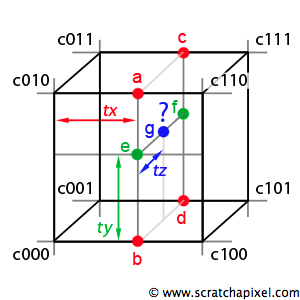

In [68]:
base64_data = "iVBORw0KGgoAAAANSUhEUgAAASwAAAEsCAYAAAB5fY51AAAXVWlDQ1BJQ0MgUHJvZmlsZQAAeAHVWWdYFM2y7pnNyy45xyXnnHMGSRIlKjlnlhxEQECCgoAiAoqCiogKokRJoqCIIqKggoEgEkTFgKCg3EE/v+/c55zz7/65/Tzb+05VdXXNVHdPVQ0AHMtekZGhMD0AYeExVDtTA4qziysFNwkgwAYYgAqQ9fKJjtS3sbEE/7V9HUekkfZIelvXfxX7zwwGX79oHwAgG4Tt7RvtE4bgawDABj6R1BgAUOsIfSQ+JhLB6DsIZqYiBiL4+TYO+I1XtrH3L4xB/5JxsDMEAMMOAJ7k5UUNAIAshNApcT4BiB6yEQBYxnDfoHAAmJwRrOMT6OULAEcZIiMVFhaxjW8hWMz7X/QE/Av28vL+W6eXV8Df+Pe9ICORiY2CoiNDvRJ/XfxfdmGhscjz+tUYkZ4UHrpz2zesyG/B18vIAvnnRn4/I0N/+QyRgTj9wnfZI7RtLBXuvdP6L6zjTzWxQzAyFrKJjDHYxsgzg/wjY2wc/qKnJgUa7kQwCaEf8Ys2/qPnVLCX+bbPaBF6EzXWbheChRDcGx1nb4xgZEVBr5MCHZz+kvni62f0Fx2G/YNMzH7LwIxBMWbbczEjPhcIibDYtgGZC1YBFiAU+IFYQEX6cCANLIEhMPqrlwb+wAvhxCG8aBAC3iA4DBkRgYyJQDDlLznDf6OY/BoXgIz73xopwAeRjf17zt+zUZA5/+gMAr4I/kP3QubY5m1bF+0RlPHPnH8ktvX9skauXm5RbvOPTWgRtAJaGW2A1kbroNUBBc2K5gTSaCW0GlofrYvWRHjqwAS8RjQH/LFxW39Yk39cWUSihmMgwt2+d+8/XOD4Szro7+t/swAEDS+3Lv+xAIAYvwRkHwBgGBGZSA0KCIyh6CM710+KYhbuIyNFUZCTl99m/79p22fWb2M/2/06iyDWB//QIpCbUd8+Y/b/Q/N8D0BrMLJNGf+hibQCQKcAwOAxn1hq3G996O0/DCACOmSFcgBeIAjEkOesgJyMmkAPGANzYA0cgAtwR9ZPILIGqSAepIB0kA3ywWFwFJSDKlADzoNLoAm0gk5wAwyAITACxsAkmAJz4C1YAV/BBgRBOIgMMUEcEB8kDElCCpAapAMZQ5aQHeQCeUIBUDgUC6VA+6F8qBgqh05DddAVqB26AQ1CD6Fn0DS0CH2CvsMomAQzwzywCCwLq8H6sAXsAO+BA+AoOAnOhAvgMrgavgi3wDfgIXgMnoLfwqsogKJBsaL4UdIoNZQhyhrlivJHUVGpqDxUKaoadRnVgbqNeoSaQi2jvqGxaCY0BS2NrNMd6F1oH3QUOhV9EF2OPo9uQd9CP0JPo1fQPzFkDDdGEqOBMcM4YwIw8ZhsTCnmHKYZ048Zw8xhvmKxWFasKFYVuwPrgg3GJmMPYk9gG7C92IfYWewqDofjwEnitHHWOC9cDC4bdxx3EdeDG8XN4dbxNHg+vALeBO+KD8dn4EvxF/Dd+FH8PH6DQE8QJmgQrAm+hERCIeEMoYPwgDBH2CAyEEWJ2kQHYjAxnVhGvEzsJz4nfqahoRGgUaexpQmiSaMpo2mkuUMzTfONxEiSIBmSdpNiSQWkWlIv6RnpM5lMFiHrkV3JMeQCch35JvkleZ2WiVaG1ozWl3YfbQVtC+0o7Xs6Ap0wnT6dO10SXSndVboHdMv0BHoRekN6L/pU+gr6dvon9KsMTAzyDNYMYQwHGS4wDDIsMOIYRRiNGX0ZMxlrGG8yzjKhmASZDJl8mPYznWHqZ5pjxjKLMpsxBzPnM19iHmZeYWFkUWJxZElgqWDpYpliRbGKsJqxhrIWsjaxjrN+Z+Nh02fzY8tlu8w2yrbGzsWux+7HnsfewD7G/p2DwmHMEcJRxNHK8YITzSnBacsZz3mSs59zmYuZS5PLhyuPq4lrghvmluC2407mruG+x73Kw8tjyhPJc5znJs8yLyuvHm8w7xHebt5FPiY+Hb4gviN8PXxLFBaKPiWUUka5RVnh5+bfwR/Lf5p/mH9DQFRgl0CGQIPAC0GioJqgv+ARwT7BFSE+ISuhFKF6oQlhgrCacKDwMeHbwmsioiJOIgdEWkUWRNlFzUSTROtFn4uRxXTFosSqxR6LY8XVxEPET4iPSMASyhKBEhUSDyRhSRXJIMkTkg+lMFLqUuFS1VJPpEnS+tJx0vXS0zKsMpYyGTKtMu9lhWRdZYtkb8v+lFOWC5U7IzcpzyhvLp8h3yH/SUFCwUehQuGxIlnRRHGfYpviRyVJJT+lk0pPlZmUrZQPKPcp/1BRVaGqXFZZVBVS9VStVH2ixqxmo3ZQ7Y46Rt1AfZ96p/o3DRWNGI0mjQ+a0pohmhc0F7REtfy0zmjNagtoe2mf1p7Soeh46pzSmdLl1/XSrdad0RPU89U7pzevL64frH9R/72BnAHVoNlgzVDDcK9hrxHKyNQoz2jYmNF4l3G58UsTAZMAk3qTFVNl02TT3h2YHRY7inY8MeMx8zGrM1sxVzXfa37LgmRhb1FuMWMpYUm17LCCrcytSqye7xTeGb6z1RpYm1mXWL+wEbWJsrlui7W1sa2wfWMnb5did9ueyd7D/oL9VwcDh0KHyV1iu2J39TnSOe52rHNcczJyKnaacpZ13us85MLpEuTS5opzdXQ957rqZux21G1ut/Lu7N3je0T3JOwZdOd0D3Xv8qDz8PK46onxdPK84LnpZe1V7bXqbeZd6b3iY+hzzOetr57vEd9FP22/Yr95f23/Yv+FAO2AkoDFQN3A0sDlIMOg8qCPwTuCq4LXQqxDakO2Qp1CG8LwYZ5h7eGM4SHhtyJ4IxIiHkZKRmZHTkVpRB2NWqFaUM9FQ9F7ottimJHg8F6sWGxW7HScTlxF3Hq8Y/zVBIaE8IR7iRKJuYnzSSZJZ5PRyT7JfSn8Kekp03v1955OhVK9U/v2Ce7L3DeXZpp2Pp2YHpJ+P0Muozjjy36n/R2ZPJlpmbNZpln12bTZ1OwnBzQPVOWgc4JyhnMVc4/n/szzzbubL5dfmr950Ofg3UPyh8oObRX4FwwXqhSePIw9HH54vEi36HwxQ3FS8WyJVUnLEcqRvCNfjnocHSxVKq06RjwWe2yqzLKs7bjQ8cPHN8sDy8cqDCoaKrkrcyvXTvieGD2pd/JyFU9VftX3U0Gnnp42Pd1SLVJdWoOtiat5c8bxzO2zamfrznGeyz/3oza8duq83flbdap1dRe4LxTWw/Wx9YsXd18cuWR0qe2y9OXTDawN+Y2gMbZx6YrnlfEmi6a+q2pXL18TvlbZzNSc1wK1JLastAa2TrW5tD1sN2/v69DsaL4uc722k7+zooulq7Cb2J3ZvdWT1LPaG9m7fCPgxmyfR9/kTeebj2/Z3hrut+i/M2AycPO2/u2eO9p3Ogc1Btvvqt1tHVIZarmnfK/5vvL95mGV4ZYHqg/aRtRHOh5qPewe1R298cjo0cBjs8dDYzvHHo7vGn/6ZPeTqae+TxeehT77OBE3sTGZ9hzzPO8F/YvSl9wvq1+Jv2qYUpnqmjaavjdjPzM56zP79nX06825zDfkN6XzfPN1CwoLnYsmiyNLbktzbyPfbixnv2N4V/le7P21D3of7q04r8x9pH7c+nTwM8fn2i9KX/pWbVZffg37urGWt86xfv6b2rfb352+z2/Eb+I2y36I/+j4afHz+VbY1lakF9XrVyyAQnrY3x+AT7VIDuGC5A4jABB7f+cUvySQdAVCZBCMQyIFcyQCmIUkkPd2L8wBx8ATKDPUTbQp+jEmDMuA7cOl4HUIOMILYjtNJamQXEv7nJ6ewYIxl2mQhYF1N9tFDjSnF1cXD4X3IN86v6/AhNBO4UFRWbEC8beSZlJV0l9lDeUOyY8okpUMlKNVKlV71abUf2iyaUlqq+sY69rp+ehHG2QaHjOqN+4xeWS6uGPLnMVCytLQym1nkHWcTZZtsV2Vfb1DK7Lrh5xGnZ+5vHKddVvY/W7Pgvtzj2HPHq8G75M+h3yT/Pz9bQM0A4WCaIO+Br8KGQitCzsUHhlhH6kaxRm1SX0Z3RtTE5sV5x9vliCZSExcSrqX3JhStjczNX5fVBo1PSkjb//pzK6sVwcIOVq5kXk1+eOHiAVahWGHTxYNF/84InXUrTTvWEvZVDlNhXKlx4nck01Vk6fR1dI1jmf2nT1/7mHteh3lgmV9ysWmSx8bNBoLr3y46nbtQYt16+N2rY6Y63Wdz7tpehR7HW9E9WXdLLpV2l86UHQ7587+wQN3Dw0dupd1P2bY6YHMg42R3ofJoyqjXx89edw+Vj6+94nHU4NnwhOEiXeTD583vyh/ufeV55TRtPgM/cy32Tevx+cG39yYv77Qvti+dPZtwXLcO/f3xh8kV+hXVj9OfOr+fPpL1mrgV4s12XWm9bVvz7/3blRvZv7w+2m0JbC1hfgfCziR6DAB9CMRnSV0GHoFKyKx12eUB2ociZpeYCKxtNhWnB+eEz9BqCQG0BiQtMkOtIF0afSnGG4wLjKzsBixJrI1sH/glOGicnfy0vA5Ui7wbwnqC6UL94hsiqmKB0uckByS+iTDIqsot0PeTSFAMUopUXmvSpJqsJqbuqWGtqacloA2iw5e57vuO71p/TGDu4bdRleNa03KTHN2xJsFmrtY7LBUsxLdyWKNtv5iM2P70K7XvtHh5K4cx2gnd2czF0VXHjes23vkpO9yr/HI84zwcvBW8iH5zPi2+xX6+wdoBTIEvgm6HlwU4heqEUYXNhveGpET6RIliayL4ehTMdRYwziWuPn49oSDie5Jcslw8pOUhr35qWH7dqUZpWtkqO/XztyR5ZwdfuBAztncm3nT+T8PcReoFzoeji46XHyxZPDIm1L4GHeZynHb8rCK/MqLJ0ZOfj0lcNqmen9N+5mP52Rqo85fq1urV7+Ycqm7ATTqX9nf1H8N02zaktN6ux3XYXw9o7Or60uPSK/9jeS+kzev3xrrXxxYu4MeZLrLPyR7T/u+5bDrg8CR+IfZo0cfVT9uGOscH3wy/nTu2ZdJ1HPmF8Iv1V5ZTgVM18wsvhadc32TPX9h4fbi9NL6Mu074fe6H9xW0j6OfFb8UrL6ec1u/dp39o2szfWf8b/8j0ZqJxJgJ0gDvUhcrwHFQK0wDFvBp+ANlDvqLloL3YJRw/RhbbCzuGQ8F/424RDRh0aLxEX6SZ6hHaJrpj/LUMZYwJTDnMWSzZrPVsJexVHP2cbVxd3F083bw9dNuc7fLFAveEIoXzhWZLeonpiAOBCflGiVzJdylKZIL8k0y6bJWcizyk8r1CvGKukqE5QfqZxQDVRTUltX79bI0rTQYtSa0K7WCdZV0N3UG9AvMthjKGG4ZnTTuNDEzVTU9NOObrM8c0cLfou3li1WaTstrVmtp23qbaPtNO1h+7sOxbtcHSmO806XnWNdNF1h10G3wt32e1j3PHOv8NjjyeP5wuuE9x4fbp8J3zI/R38m/wcB+YHGQQBZL3Eh8iHLobVh3uHc4U8iSiJ3RuGjblCTohWjl2POxrrHscU9iD+QoJuwntiYFJRMSX6WcmSvQypH6ty+trQj6YkZ/vt3Z7pkuWX7HYjNycotzTuX33Jw4NBYwVzhlyJUMVOJwBG5oxqlhsfMy2yPu5R7V0RU7jtRcvJi1dCpD9XCNYlnRs6J1qaeH78gXZ95cfKyfENO48smlav51161KLYeaHveoXg9r3OmW6unrPdrn8PN5n7RgTN3pAf7h0LuCw0vj9wevfK4brzx6Y2JFy/AK7np2tfZ83lLre/pPuassq83bzpt+/93bWn7nYBVAeDsLACOpwGwdQOgVhIA4QqkbILUO2zIADioA9igEEDPjgPI9PLf7w8yEEWyfH9wAMkcB8FbiBaSh3ZBSdAJqBOahDaR/E4X9oaz4QvwA/gLiguljwpEHUa1o2bQNEj9wBPJyNrQrzGMGF1MOOY0ZgxLxOpjE7BN2GWcGC4AV4tbxMvgY/E9BBqCK+EiESI6E5toaGnCaUZJaqRTZDyZSn5Ja07bTidGV05Ppk+nX2OIQPIVH8ZXTN5M88xhzF9Z0llpWU+wybLdZHdjX+Uo4pTnfMQVz83DPcJzgNeAD/DdoGTxWwlwCCwIXhcqEg4WMREVFiOJrYrPSIxK3pLqkL4q0yjbINck36bQqzik9FL5oypajUVdUENaU15LTltCh6LLqAfrfdCfNOgxrDbKMY4wcTY12CFrxmtOZ4GyWLdcsVraOWc9YzNt+9rurf1nhx+OBCc2Z1EXdVcrN5/dyXuOujci77F33rQ+ir4ufvv8awL6A2eDfoQwhvKHSYTLREhHikcJUFmjCdHfYxbjOOOtEjITe5J+phjvLUl9m2aVfn2/UmZ7ttmB2dwD+fwHLxfoFU4VFZU4H9U+ZnY8vqL/JNcp2mq45tvZT7Xv65brly99aFi98uMavoWrTbbDqNOlO6g3ri/1VtrA3jtxd0PveQ7nj7SNLo3xP9nzrGryzUv5qfSZsTnJ+ZzF+WXT9xc+0n9OXn237v99/kfkr/ODDsgAW6QaVQ56wGuIBqkGuEGZSMY/BH1AsnsN2BPOgRvhZygUkrO7oLJQV1Cv0GTkVAlBV6DvI/m3PMYXU4n4nQ5ric3F3sERcVa4YtwEXhhPxfcRWAmhhAGiIDGDOEdjTtNBkiRVkVnIB2mxtBl0gC6dHkWfw0DLcIxRgLGBSY9pjDmMBctSzarPOsOWzS7NPs6RzinHOcVVwr2DB83Tx7ufz4RCoozzVwtEC5oI8QqtC4+LtIqeEjsmXiRRIFkgVSxdLnNOtlnujvxLhTUlFmUNFR/VArUu9Q+awloe2hU6k3q8+r4GDYYbxsYm+aZDZhhzVQtvy2yrcztvWE/YrNih7VkdJHbpObo4RTsXulx2HXb7uIfVXdvD37PIq9v7va+gn7N/YcBA4I9gpZCg0JNhDyPgSIUoT2pB9PWYhTi6eNUEz8T8pLbk+b1sqWb79qY1pS/tF8zck1We/TSHLdcl72T+60PSBQmFA0XsxREl947KlVaU0R7PrSBVHj0pWnX7dFAN6UzTOdfz6LrGeo9L9JdvNiY0yV5daK5tDWqX7vjU2dGd0WvZx3Zztr/xdsqg+RDHvZHhXQ9mHyY94n08PJ7/1H5C5Dn0YubVwHT9bOEcdd5+kWupaln03ZUPOivDnzw+f1hNW6NbP/6dd6PqB+fPwl/+ZwP6IBKpHD0AW4jv/aHjUD/0GRaA7ZAaTiu8jNRqnJH9PohGITXEJHQrehWjjInDdGExWGtsBXYJp4k7jFvAG+HPEPCESMJzoiWxl0YV8bQB6R7ZhbxEm0rHQtdIb03/kaGUUYdxkekEsz0LmeUuay6bJTsj+wTHWU4qlz43E/dbngHeM3zZlBB+BwF9QQUhUWE+ES5RTjGKuKSEuqSFlJd0iky5bJfcawVaRS0lqvJllQ9qyurpGqNaYtqZOm/0LPVbDSWNzpjwm9aYiZs3WxpZPbWOtCXZNTq4Ifu1yyXOTWn3unuv5yFvd18Vf1LAs6DyELPQxfDEiM2oGOpcjE3s1XiGBGri42SNlNOpNPsS0uYznPffyzLI7shRym3J1z44WOBS+LYotYThSHWp7LH24zrlPZVaJ1qqMKcsTx+tfnVG4mz8uf7zLHX+Fzou0l7yvdzZyHIlsmnomhiS+bxrs21vvc7bmd31vsep90af5M2jt7YGgm8/HtS7W3+P9X708N0RroeBoxcfLY0Jjjs9yXh6/tndibnJzRf0L/leSU4pT2vM6Mzqvdab03mjMa+6IL8osSTwlvbt4nL7u/j3yu+XP5xdcflI/Nj5yf8z/ee2L7tXwWr1V4OvM2v71rnX27/t+rby/eCG6Ebfpvvm+o+Sn7I/B7d8t/0f7a+I1CGRBpEMkPLjy62tzyJIUlEMwI+ira2N6q2tHzVIsoF8A+kN/f29YlsYi9TcKxH6f27/A4NYfzsEsehuAAAgAElEQVR4Ae19CXxU1fX/N0BYZRcUUIHgUkHiAoo7BJC/WDWiiIpoRRTFasuvLSLWWqWtCloLrcqquOEGqLEoLkQUF0AJ1iCCyhJWWROTAAkk4f3P905eMjOZyUxmSWbmnZvP5L13312/973vO/fcc+9NsixrG4Dm8lOnCCgCikAsI1DYQErXSn7NYrmUWjZFQBFQBASB+vXkX5lCoQgoAopAHCBQRsJSpwgoAopAXCCghBUXzaSFVAQUASKghKXPgSKgCMQNAkpYcdNUWlBFQBFQwtJnQBFQBOIGASWsuGkqLagioAgoYekzoAgoAnGDgBJW3DSVFlQRUASUsPQZUAQUgbhBQAkrbppKC6oIKAJKWPoMKAKKQNwgoIQVN02lBVUEFAElLH0GFAFFIG4QUMKKm6bSgioCioASlj4DioAiEDcIKGHFTVNpQRUBRUAJS58BRUARiBsElLDipqm0oIqAIqCEpc+AIqAIxA0CSlhx01RaUEVAEVDC0mdAEVAE4gYBJay4aSotqCKgCChh6TOgCCgCcYOAElbcNJUWVBFQBJSw9BlQBBSBuEFACStumkoLqggoAkpY+gwoAopA3CCghBU3TaUFVQQUASUsfQYUAUUgbhBQwoqbptKCKgKKgBKW1zMwc+ZMdOvWDUlJSWjdujXuu+8+rxCuy0mTJpn7DFedCzZcdWnovRogMP5+IKmT69egG/DY4zWIrEH9IZCXl2feBT7vl1xyib9gCPZ5DzZclYwsy8qXnzpBYPz48ZYAZA0cONB67LHHzJHX1157rQc+KSkpJlyrVq3M0eOm20Ww4dyi6Gk4CKQNtix0rPp7dHI4qTo+7sqVKy0+6/bzzvfDlwv2eQ82nI888lXCKqfwrKws83Xo1asXPvroIwh5maM0DubNm4fFixdXkD39pBHRu3fvCj9fJ8GG8xVX/WqIwBvzgSXfAse1BVb+Vz4z24HXpwL1GwMPTK9hYhrcHQH2NIYNG4aNGze6e1c5D/Z5DzZclQzoISzmKAmLkpOQUoWEJOBZubm5FdLVG2+84UHsQl4m7OjRoz38ecG4Lgir3PLwCDacRyS9qBkCt49xSVYqTdUMt/LQ/t4L78T4vPN5rs4F+7wHG84tr/wGJC2nOPa9KSkJUJAGAvvl/GrwC0IJi44SlruzrwN9Xdzj6HkdIJD7iyvTSwbUQebxnWV170Ws1cwxhEUlH8mKXT2SlbezCUn61x63SGZ09n2Pm3qhCMQ5AoHei1irnmN0WBz9o/NFVrHQKKWlpfj555/xyy/lkkIsFCqeytCmlau0H2XGU6mjWtadO3diz5491eYR6++Fd+EdQ1iUkLylJ3cw7HvsJro7+9q+734vkueiRwMfno8//jiSyTonrYH9XXV9+iUga5XrnG15xgUuE4fFziOy559/HvPny2BENS7Qe1FN1Dq55RjCkiHZart1tq7KfTSQLWJf2/frpJU008AIDBsKpJ0ObNsH9L7CRVJtTgO+zXH5D1Tdli8QA70XvuLUpZ9jCIvDsnTss/tyYmtlvG0R2Q5jX9v3bX89xiACH78H3Psbz4Lxmv7qfCIQ6L3wGakOPR2jdKfuitISLdd55EihPUoopgxmdFBMF0y3jKMmvM9w/NFfJaw6fEprkvWkR+SrJD91QSEQ6L0IKpFaDOQYwuJoH409SVgkKBIRxWH3aQYzZswwei67Eam34jlHFtUpAomIQDDvRSzVO0mMsvKlQC1iqVBOLMvu3bsxbdo09OzZE1dffbUTIdA6RxgBfmxbtmyJMWPGRDjlOkuuwDESVp1BrBnXPgJi8479+4GiIqBRI6B5c6CeY9S1tY93LeaohFWLYGtWtYDAhg3Af0XJ/uUKYG+u9B2OAs6S0cPLLxMTBzkqcdVCI0QvCyWs6GGrKdc2Aks/A/4qCvdPVkvOnOZZ7jK+kInQ7wAP/gm49holLRuXODyqnByHjaZF9oHAmjVi0vCgkFW23HQjKzvo99uAcX8TE4clto8e4xABJaw4bDQtshcCR44Ar7wOrPjR64bX5VYxKp05BzL/yeuGXsYLAjpKGKCl1q9fj/x8DqRG1xUWFuLxxx/HGpEUGlFRrC5oBNrLPMx/bjqIc6zK7+/+fj3RaO1WJO/yJKfNOII/ntAI6xs1RFGA1WKDLkCMBtwvAw99+vTBn//854iU8MQTTzSjjhFJLLREdJQwEG5fffUVfvrpp0DBwr5fJCNaH3zwAcrKysJOy2kJNESS2OW0lWo3NFUvHNQLReedjUOn7kbbaW96wNFcuouHtmzFDiGu6qcFe0SL24tPP/0Up58ugw0RcMOHD69rwoIq3QM05DnnnINTTjklQKjwbm/duhV33323IauGDRvi3nvvDS9Bh8U+WiaOt5r7AZBfBJus6snE59bTFlZBopGQ2tAbbsB5nTqgqLGsRppgjpL6q6++Ctr1JScnm9kcl19+eURq2b59+4ikE04i2iUMB70IxP3888+Rnp4OrtZAxw0w2A1VVwMEqJO6ZTQKi4qNZEWyavPvt1APh6sm0rMzME/0WIIzGiTW9/qHH37AoEGDsGXLFlAa+uSTT8ySRUeo40sMV1DZ6U+MCsVVLbj0Bx8wkhX1DPXERiiBHq7aawuZYrXv5htw8MJzUS1ZsURXyo4vXKQxwciKqovzzz/fkNXvf/97zJ07l8ufm92faq8hop+TElb0MfaZAxXsXAGCOitucvG73/3OZzj1DIwAF6rLPfkklEo3r830DN+SFZNJl7WxbhsJ6SsFTjSOQrz//vvo16+f+fBNnjwZU6ZMiaPS16yoSlg1wyvs0CSoe+65x+ip2rRpgw8//BBDh8paTupCQoCrtBYUFJgpOG0G9Ee9B0YBJx4rKvX6xhrLkiOOlWWufyvLB03+O9ClS0j5xGqkl156yagUDh06hDlz5mDcuHGxWtSIlCuxOvERgSR6iXCYmVIVv4hdu3Y1ZMWhYnWhIbBt2zYcPHjQdHuOP/54NKYS/T55YdOvwOa33saPXy5Dj/POw3GD/x9wWg+gWbPQMorRWE8++ST++Mc/okmTJnjzzTfx61//OkZLGrliKWFFDstqU2K3hcp16ho48piRkYFjjz222jh60z8C27dvN2RFvR/JqsJ2jd291J7Yd/gQlouc1fHqq3CcrICRaI5ERcKilL5w4UKcJ8TsBKeEVQutvHr1anBomaM37P69+OKL5qtYC1knXBZUJO/YsUMWY9hvhu2PO+440BTEKe7w4cO47bbbwK7gCSecgEWLFqF79+5Oqb7aYUW7pWm4x/WtOBJIWysqROvXF72KuhojQLKyu4Hs/pGsnIQljYv5LFGlQJIiWZG0nORU6R7F1uauJTRb4NZd//nPf8zPSS9YJKHlYAUNbKmzatq0qekGOglLfvAGDBhgyIrdv88++8xxZMXnSQkrkm+VW1pc7XHkyJFGAnj99deNdOV2W09rgAD3bCRZUcI46qijjGRF3ZVTHFUJF110EZYtW2YU65mZmUZ35ZT6u9dTdVjuaETgnDqGO+64A5SuqFSncp1KdnWhIVBSUmK6gcS1RYsW6NChQ2gJxWms77//HoMHDzb6z1tuuQWzZ892VDfYu9mUsLwRCeOaimDqGD766CPQXIE2VjRfUBcaAiQpSlaUsLhZQizMZQutJqHFokTFwRp2B2lfRaNQpzvnyNVRbmmK7ZwaQbLq27cvVqxYoWQVBubFxcVGqiBZtW3b1nFk9e677xqdFcmKAzVKVq6HSQkrjJfKjkqzBZIVjzRboGRF+xh1oSFAxTolKyraKVUdffTRoSUUp7GoTrjyyitN/TknkHMD1bkQUMIK80ngEDPJioaM3POQ8wKdZBcUJnxVorNbTdMFTgKnDpBdQSc5zjHlYA1HQmkQylUX1FUioDqsSixqfPbss8+aXaEZ8Zlnnkmk/d9qjEUkInBOIGcE0HXq1MmMCEYi3XhJY+zYsZg6dSratWtnyEoHa6q2nBJWVUyC8pkwYYLZFZrD7JSqLr300qDiaSDfCNBWbdeuXWZeIMmqWYLN+/Nda5cvBxcoVb3yyivGtopmCzrH1DdiSli+cfHr6/5wsctCa+MzzjjDb3i9ERiBffv2Ye/evWa4nmTFybxOce4jy9z1m/pPnWPqv/WVsPxjU+UOR2xotsDpNny4qGNw2tSIKqCE6cGlfPNkhdAGsqAep9pUTGIOM914iM7NTf72t78Zgr7//vvNIo7UXUXK2bMsIpVeLKSjhBVkK9BsgQ8Al6Gl2QLJit3BhHVvzAemPwcs+bayitf0BWY9DdGEV/qFcUZ9FV9arj3utEnMXL+KS2EPGTLEmG2cfPLJZsXZMOCsEvW3v/0t2CNIJBfVUUJ+OWn1zZGeJNlSadiwYeZr6gvASZMmVYTzdb8mafmKH44fl4ThdkkkK1obU2xPaLJanAlcJ0Pp7mRFABd8CqSFv6GBveICyYojqpRSnTSySrONL774Av/6179w4YUXmgUd/U01iuX3Ipx3KuS48vDkyy8qbuDAgZYUzBo9erQ1fvx4c96rV68qeaWkpJh7rVq1MscqAcQj2LR8xQ3HT6bWWKJTMeV6+OGHw0mq2riicLbkobXEMr7acLVyM22wrIvQ0bJen1eZXW6uZR3X0+W/YUOlfw3PxFzBEhsra926dVZOTo4lhqE1TCG44F9//bX10EMPWdnZ2cFFqKVQQtKWrAxqNW/e3GrZsqV5rvhs+3LhvhfyobVkkxNfScerXz4Xqo8KYb3xxhumMUhUtpMJwcZvxowZtpc5ktBWrlxZQUoeN+WiJml5xw3nWlZYMCQiX3/zkIWTVqC4MUVYdmFJTPdOcP1sEiORrcyyQ9ToKIag1ubNmw1Z8cjraLlYJCwZXLC+/PJLS0aVrREjRliiE62WsMJ9L5SwvJ4uEg8lJkpR/PF8Q/nXV5YCNn72NaPynOH8fVFsKcorGyuUtLzTqOm1WBebskrXz5LtkmoavcbhY4qw2Iann++SpkhQ3r8QCEsmMVubNm0yZEUJi5JWNF1dEpav90KmalnSDTQ/GRGtqHp174MdKNT3IhEJK2SlO/VRtD8SkoJIUYI7kJWVJTsopVSc88S+ts+l24eNGzeaMMH+Y7p2fDsO0/WX1jvvvGMMEKlvqqluhEuY3HzzzeAWXNStULnOEUFHuatvAr7NEX2V7Bh8drnJxh23AbZ/DcHwXnGBw/bUacaL496RXDWB02UCmRz4ei9EqgIx4Ppdp556asR2T67pexEveFdXzpAIa+bMmYasuKGCdNd8pk9ScicrOxDn2NWUsGqaFu16uJuKfKHsbIM67tmzx8yOp5KdtlW0sQr0gAaVcDwF4sfEJquP3/Ms+b5Cz+sgrjhKxak2fGH5gTnmmGOCiBVbQTg4wOcp0Iibr/eCz+4VV1xhPpxcJTSSBrE1fS9iC9XQShPSKCElKzouUpcojkPMnBNIsqLVOld0dBxZuTfmT9sgXxaXD4/9LwO27XMPEfDcXnGBZMUPVTySVcBKugVwfy/4seSoMomOyzlTSo8kWbll66jTkCQsW0LyJUHZ6PEeDS29Hf2qi+cdnteRTMtX+u7bxY8ZM8bZSxmzS396F5eU1e0iX3ABG4TAep3l+165L7vW9iRmzo1zwuoV9nvRuXNnrFmzxtiY0fyF3cCaqiaqBbf8ZrTfi2DKUNthQpKw7Bn0dgP5KjR1W5wf5h6G5/TjvZq4SKblna/7dvGPPvqomcTspLXCvfEw10sWuvRX9s36st/fvb8BHh3r8tm4yb7j83jgwAGzPAxXXKBU5QSyIhD2e8EVPNiNFLMFnHbaaVEhK+YXzfeC6ceiC4mwqLuio1GbP2eHYb/edrbIbN+z/QMd7fCRSMs9L+/t4rk8jDpBgJbs1F9Z212/0g3S2I+4NimlHzcr9eO44gKX2qHr2LGj0Vv5CZpw3rRap+NzyjW8evToEdXljKP1XsRyw4TUJRT7EKN0Z8NQarIlJo5acMVNOoIpw7GG1Gilzq8PCY5+NtDBAhPJtJgnF4bjUh5PPfWU+fpz11xOt1EXHgJOXnGBUiV3sznllFPAUWpas/t6L8JD2DN2oPdCTDs8IyTAVUiERfIhMZGAKDUtXrzYfEl79+5tpt7YojFHEDk1h8TGESISXaiK+kilxdnxbGiK7VzCgyOBupRH+E8ydZMcZeUUE84LdNKKC+z+rV271kzcXrBggdnktLr3Iny0K1OI1HtRmWJsn4VEWKwSSYnkUx0BMYw/swdfsNjSma97NU3LVxq6XbwvVML3I1GRsKj7I1lxVMwpjiY0HA2k44ePOrtA74U7NsGY3kT7vXAvT6yfh0xYsV4x7/LpdvHeiARxLUpzyAspopMrsIz2ydICsptlpeqTi+6xK+jEFRf4AaRKhEaw7Ao6ZXAhiCcnakEcQVi6XXwIz49sAoE3FgAfyMoNOT+7EujaERjUHxh2DSyRpPjCUsnOIXtKViQtp7hVq1bhf//7n+kGUi8bi2QlU+HM5rMXXHBBwjRLwhMWdyChHo3bRXG7+LvvvjthGi9qFRF9DCb8Fcj4UrKwKrP5SYjrw1XA58uw+/djUCCbmnLBPZIVF+BzguOAzT333INp06aZdeepA41Vg9g//OEPZtlpLr+cKK5Stk+UGrnVg7oE3S7eDZBgTkWBjCemCFl9IaHdyKoirvi9/Tka/2cGmslHgPMtnUJWtNi//vrrDVmxC8g5go6bZ1rxHNTNSUJ+FilNvf3220Zk5/Qa3S6+Bg/X50JUL0s3MIBrnrECLUbmIElsjZzgOI9QloTB8uXLwd1sKFnFYjcw0dsiSUYp5JOKFrFSUU7p4K4h4ThZuM2sHEGdSgfptsSDBECrcFnQzuiBjj/++HCqH3Jcrp/w+z0HcE9h/aDSeKp5Gaa0a+ZTDgsqgSgG4keLJEP9WrjtzzmRHA3kssa0reL669GYauMNB01DBgwY4O0d9DUNdzkowm5sgriCmJOw+JDZy2aECjIbiY4iPNdijyfHMrtPZ6rNslNlngxugtAqqGwbFBZiS+EulAQVOv4DcYOIyy67zOzwXRu14dSecAirNspY23nEnITFrwF3UgnHUWTnxNsnn3zSTDwNJ63aisvRNupH2IV97rnnaitbj3zkYcBJz72IlPlLPfz9XWwcejF+uvVmWDG4tpUsFmhUAjRmDldinT17NmgQyo0iPvnkE39wRNyfdm3t27cPOV2VsEKGLviIbCR248Jx9oL+/fr1w5lnnhlOUrUWlyRNex4aXdbppqz5subV/GVS70ByUzJSrhmClMGDaw2jmmQkS26bD9+5554btmLcNtxk1zLcZ7MmddCwVRFI6FFC6sPU1RCBvhcBg4MgeYZhWAc4dtPVxQYCCU1YsQFxnJWC0u39fwLO6ua/4LzHMGFKwv4z0DuKgG8ElLB84+Js3wvFMnr2v4ExYtF+4rE4iPo4BBmfkXP6mXsMo04RqGUEYm6UsJbrr9n5Q+BM2XziicdQsnYd3n7yX+CqoZeMuhXolgJEcDt1f9mrvyLgCwElLF+oqJ8LASEm67Qe+OnkE3FILNrR87SYQCbv8C+45rM7seTnH015bjupP2b1eSImyqaFiC4C2iWMLr6aehQQmPHTCxVkxeS7HVU3hrZRqJomGQABlbACAKS3o4fAxo1lmD37ML75xkLWSte8xXZidnTxxfUwblxD2XzEt8V97mFOzpB52AOexCUd+plz/ecMBJSwnNHOMVnLxx8/jAXzZc0tN7dHbIbp9967xXjzrUYyFcbzEa3/xrk4IrMh6AZl/gH1ZOpN2bDlbinoaSIjoF3CRG7dGK/b0KEN8Kdx9bF8RWPs3tPM/HhNRxO6J55wEVOMV0OLV4sIKGHVItghZzVjFtBAbJ+yZC2qBHIDBiTj3nsbe3T9eH3NUNdj+eUXVZe3oTQ1rsdVBoWVlz2n0lUCPQ/BVEUJKxiU6jrMtOdlq5/igJuX1nUxI5V/165cN8IlZUUqTU0nMRBQworldlycCSR1cu3CzHLynD/ZNs0cj0/1LP34+13+lMji2G3a5JKsTjzRRVw1rUqJVYK9Vi5+aVyAAqtQlr+pKqnVNE0NHxsIeGo0Y6NMWgobAdl1CLenA7MyXNvHX+/qCpmNTrkL84QpwGOPuzY25XHyC67dme+43U4h7o4cObQV8SNv9T1K6K9SZVYZ/rvvQ8zZtACfb/8BuSccwjtbs3Flwwtw5/E34pRmJ/mLqv5xgoBKWLHcUL3OAgb2d5WQZMUdl+1dl++4DeAW8g9Ml80i5rvIi9vJ2/djuV7VlG3EjYfMXUpXt9/eqJqQnrcOHzmM8T/+A0MW/wXvrM1CbuF+oFTWFsvdiylfZ6Dv0tF4f9/HnpH0Ku4QUMKK9SbbuMlVwpSuniWl9PX0fS7d1nW/d0li3E4+jt399xdh/XpLNmEF/vNUwxrV5N9bZuOfWSKJlpTJNmTSleQaXW6/XXt+wciv/o7vD7r2EKxR4ho4ZhBQwoqZpvBTkJXfuG70FmnL25G0bCdbb8Wzy8wswexZLpusB/7SoIr9VXV123JIFmv8QbYkK5X4JClfTkhs5948PLPlJV931S9OEFDCivWGWr/Z1fVLSfEsKU0cho936bZ455F/et6Ps6snnigxJe7Vu2ZdQUZamr8cP+f+ImTlVmlyX5m7h1yL7v29HV9jT8let4B6Gk8IKGHFemt9myPrTjXzLCVHCftcC5wmy70sWegirSXfxq2dVl7ekYqpOaNGBR4Hmnzmg7BGrEKvNmcYXDYf2uG5I9mRJJxXcAwG/iJzDN1JS/hr08H92Fcm+KmLSwSUsGK92ahY3ybbxQ8dDtjmCmmXu0r9pnRv2C0cc4vresbsWK+Nz/KtWiV6p3I3dGjNdFeMluy+iasQ1AX5x6BtSXPsSxbFu/sTLhJWUoN6aFAvMCna5dFjbCHg3pyxVTItjQsBKtZJWgs+Ffsr6faQuCh1vTIJYiLuCkMzhuPauswfKH05zPVocTLQuD6SSuqhb35HtC49Chua7MI3LXKFoYSlbCenvdodi/YNjrZ99BhnCOinJtYbjGQUjF2V2BvFqzvrrPp49bWaS1Z2fS9uei4ubNsFjTYfQhM0wtqmP2NDswP2bdfxiLBVo3oY1nUAWtRr7nlPr+IGASUs96Zavx7YLvqQvhe7+ybO+adLgU4dZanjE2OqTq1b15P990IX9tf/7yecs6oLNjTailX1NmNrE5k57SZYoUwupCuYdlZPjGp9XUzVXQtTMwScS1i50l346mvgS1maZEWWKK/XiA1PsewYc07iEtakfwGLvhKlj3Qx03qI4r4XcP65wDlnQ/Zdr9mTE8HQVLrPmnVY1HE1HyH87LPPsGTJErTEUTjv3D5Y3UT0Vj/9DBySYULZZxH1hQjbNMSQ03vhiU7j0CbJzRQkgnXQpGoHAecQFslpBX8rgc+EoLb4Gdpe9SMw+q7aQd89l+TypjggXZlo5c+60ZGYPxQM+MNM44UTRK9zkRBYn97yEwIjidWSGz68uGKUMCWF0lZyUDl/8MEHWL58ObgPJXdk5jby11pDkHHKYnyY8yU2bN+OXp1Plm7gZbikwUVCac2CSlcDxS4CiU9Yq78Ts+lngE9EsuCXN5DbJYptzt2rbddSzLvpuDhdXeRPAp/7get3kmz11U8kzXuEuE+O/vy779dU9t+yssqCIqxPP/3UkBU3Nx0yZAi6d+9u4EtJ6oz/azIKFxzsiYXLF2LoMUOR2sBrkrgJqf/iEYHEJyxunDBTCItuv3QX3CWtz1cD+wpc9+z/5/1KCO5x+6r2joVSjgEDgObNgcVvRyffe8YBy9Z5pt22BXBhT0/J6qijKsMccs3tq/SI/Bkt26dMKUVqKruEgZXv7777LrizcxOZwzN06FAZLC0fLXUrWj2rHuqXycihhzWpWwA9jUsEEp+w3JuFL2L/NNfP9pdug9FjfbUSWC5dpPZiHsBJx7XtZKt642hTFK38O7QXcpIVEM6Vrt855V0/7oZTx46TnIOZ6FxWVoa33noLa9asMduOsRvYpUuXOi69Zl+bCDiLsHwh20nWl7r2GtfP1/1E8lvwatzW5rB0lV977TVs2rQJnaTNbrzxRiNhxW2FtOAhIRD6WHJI2WmkREZgzJgitG93wPx69DiAyZOLzfkNNxwMq9oHDx7Eiy++aMiK3b9bbrlFySosROM3skpY8dt2MVXywYMPVoz0sWDc/eaJxyun3AQqbGGhJRtPcGmZJFHjyaS/cpefn4+XXnoJ+/btQ8+ePZGeno769aVbq86RCChhObLZI1tpLg3DfQW5p+CLL7q25srKKsXNNx8yxFVdbmvWlEqcEnz1lYVffrHQqlUSzj47SaSoZBx9dC5efvllFBYW4pxzzsHgwYOrS0rvOQABJSwHNHK0q5iZWWqyePjh5Ip1rLif4MMPH8FdY1zLxvgqw9tvH8a940qEqCrvbt9mYc13FhYsOIgLL1wiI4CF6NevH/r27VsZSM8ci4DqsBzb9JGruL1pxIABnt8/72v3HJcvL8Ef/+hJVu73CwvqY/FH/WUU8BolK3dgHH6uhOXwB6Auqs8ZM888UwKanlXnSkqaIjMzxcywqS6c3nMOAkpYzmnrqNWUeic6u2toZ+R9bfvn5JR5KOhtf19H6sYYXp0iQASUsPQ5CBsBbjlP9+Q/S0FlOx2Pf/2rb/3V3r0WCgJIVyYR+cdwDK9OESACnkoHxUQRCAEBTlbu1ds1Ujj4Uk7lqX46T9OmsmCEzG8OZtYPw3EXHXWKABFQCUufg4ggsGhRU1wztPJxoonDn8b5tpfq3Lk+TuhcaWtVXQEYrksX3+lUF0/vJSYClU9YYtZPa1WLCEyb1gS79zQzvzVrmomJg4tounb1JKejjkrC9dcH180bMaI+GF6dIkAElLD0Ofv7aCUAACAASURBVAgbAV9TcLgon711V9euno/Zflk14/Dhl5HS7Ztq8752WD2MGBF49YZqE9GbCYWA6rASqjnrpjJDhybj6afKkLnYMnMH3UvhveV8rqz0yqk2v4i16Nixx2Lr1iS88IKFfXtlRy4ZDOSsm7ZHAyNH1seYMY3QuLFKV+54Ov1cCcvpT0AE6p+SUh9vvtUIDzxw2MNc4bbb6+GRRyo15jt37sTcuXNlWbL96NOnDy699FKT+4gRR7BsWb5Mbi5A164tcN55LdGhg6dUFoFiahIJgIASVgI0YixUgVNxFi3y/zht3rwZr7zyinQFD8s6hQNk2s2FFcUmOfXvn4Tduw+hffskmU+oZFUBjp54IOD/CfMIpheKQOgIrFu3DvPnz8eRI0dw5ZVX4swzzww9MY3paASUsBzd/NGvfFZWFrikMZeEGTZsGH71K1mCWp0iECICSlghAqfRAiPALbg+/vhjNGzYEMOHD0fnzp0DR9IQikA1CChhVQNOIt3aeCAH49Y8ije3u0wJOjZrjgdPvhl3dPlNVKq5aNEiWePqK7GhOsosZ3zsscdGJR9N1FkIKGE5oL1JVhd9MQo7DhRW1Jbnd37ztLmOJGlxo4iMjAysXr1alOetcNNNN8kerW0q8tUTRSAcBHQ4Jhz04iQuJSsS1G1d+sIa8pX5rUybidRWx2LMd+UbqUagLqWlpWYkkGTVvn17jBo1SskqArhqEpUIKGFVYpGwZ2/t/g792p+IWWdW7rfYq9UZ+PPJo2CVlGBGzgth172oqAjPP/88Nm7ciBNk67Bbb73VdAfDTlgTUATcENAuoRsYiXjK7iBJ6ZPd65H01jk+q5h3ON+nf7Ce3CiCBqF79uzBKaecYjY35Y7M6hSBSCOgT1WkEY2x9PJK3BZM91O23JLQCYskRbIiaZ1xxhnGziopSafT+IFavcNEQAkrTABjPTq7fkmyqFTf1p2x5IJXgi5uAQrxZUkWsoq/w+Le2eh81G70tHrh9KRTkSx/dNtl12ySFbuD5513HgYNGhR0+hpQEQgFAdVhhYJanMUZ0v400yW8d83fKkpOySvti+Gmm/jG9owKf558eXglrln3Owx+fwIeeP95fL5/M+bmfo20VX/Cnw/+Czux2+iqqLMiWZGowiWr4mKPIuiFIuATAZWwfMKSWJ6P95iAt3bfiMd//K/5udeOyvhhndIrvJYVZ2HYsgnYvkWWT6CzP2nFZdi/ejce374Aa1M3IvXNdmhUlowhQ4YgNTXVFTbE/68uOIziQxYu6B1iAhrNMQjYj6NjKuzEiqY064L1aXNxdSfPOXzjTr7Co5v4S1k+xmc/4SIrPhn1RRdFfRR/PG8gnvsOYeH33+LbUzbhhhtuCIustv98BFfINvazXijFkMskfXWKQAAEVMIKAFCi3CZpLThnht/q7CvNxZL8L/HZ+h9dUpU/xXkDIZY9xdh1fhmOPqmd3/QC3Xh53mHc/2AJSg4Dn3zQWILLiTpFIAACCU1YP/74Ixo1ahQAgti4ze3Y6Wh8yQnDte3WHPkRHxV9IavoHXFJVP4KQCKzjmD1rl346PASdCs+wV9In/6799bHY/8+Fmu/a27uXz1kN/bn52LPziLZIadAlpjZLZtOVK6h5TORIDy3bNliQm3atMksaRNEFL9BDhw44Pee3qhdBBKasJYtWwauwxRPrkRsphYuXFjrRd7YchtWt8qRrl8QWQtpHSo8hMw1H2PtTlkeNEj37bruWPbVQJSVupY9btwsD+1bvCz1FZKMkvvmm2/AXzguLy8vnOgaN4IIJDRhcai9Z8+eEYQreknZElaymCBcfvnlYWe0sWwzUuoHvzrCD2XrUb9oGb7dujRw3rJ189FHNcEV51+GDodle5wAzluqsoP/dbzYbp12mbnkaCMlrBYtWkREwuKHilOEuPZWp06d7CxDOtrSWkiRNVJEEUhowjr55JNl55ZeEQUsWomxK0RHC/FIlHn6mtcxq8fVQRf3lNJfoW1ee8zZ8bn0S2VxdX86LKYo9y7tcjoGHz9IBLLqRTKOAI5/oATFBz2LctXV9TDqNz0qPLnGOzHgHEROmg7XWUKqJKyuXbuG/dFq1qxZuMXR+BFCgGNB6hIMgaKyIsz++UvwGKw7qkEz9Gt7Pq7uFoDgyyw06tACtx97bUCyYt5dTqiHJC9Oa9YSeOzB+NAtBoufhqsdBJSwagfnWs3lm8LvzBY05liDnBvVa4QnTrsffY5PccUSKQX274icy69Bm6aY3ue3uDj53KBSPlG2+GrT1tNk4ZG/JqNNa330ggJQA3kgoE+NBxyJcfFVvkvJbB9rUquuTTtjQZ+n8Mczr8LxbWUdq0aiNaD9VaNkXNGzFz7sPxm3tBwWVJJ79h7B4GuLsT3HQv+BSaBk1ef8JNxwje41GBSAGqgKAgmtw6pSW4d4fPHL/0xNeRwbvN69Ap1OTTrgiR4P4g8n7sQP+evxwisv4uR23fDHM8aiUVJwXblc2Uj18uuLsWWjhSvS6+HZfzfB9z+UyXLJFdnoiSJQYwSUsGoMWexHWF6wwRTSPoZa4o6NjkXblq2xND8THVq2D5qs8gss/Pq6Ymz6SY6X18PMf7nsqrqf4qXMCrVgGs+xCGiXMMGafs/hvdh2sMDUikde16bbf4BkVYQNP1i45P/Vw2yRrLibszpFIBIIKGFFAsUYSmNF/iqP0nhfe9yM0MWyr0vBLmBRsYUrbyjCj9+7dFYvTlOyihDEmkw5AtolTLBHYUW+S39lV4vXl7eL3jpVlKhG/+4wmoqpUnOZbfPdtxYu7JsEJSu7BfQYSQRUwookmjGQ1he/ZHuUwvva42YELh791yHs2mEZfVX2KsuMAr42u4ko1z1NGZjVrFmH0PmEAzJXsjQCOWsSTkRACSvBWn1JwVaPGnlfe9wM8+J/q0vx7LNiFe/mtkj2e/aJzZYPN+e5MlnwD2LJr4K9D3jUKwgE9MkJAqR4CZJfWoDbjumD1QdysCJvK/q0Ph49ZVmZ3JI8tEluHdFqyPaDuPvewzjiNW+5RISnLduOoFOHym9hZmYJbri+cvmY9u1cqx/88GMTnHF6kSExmGWX7Tl/B2Q+IbB5i06JiWijJUBiSlgJ0Ih2FVo2aCHzByfjma1zhLBm4uYOg3HX8SPt2xE9Tn/+kFGuuyc64qZ6mDihMY5q5tkdbNUqCdcMrYcF84/gxBOTcNUQF5m1Fmv3397tGkLk5Gcu4/L6a62EwJIq/N3T13NFQAlLn4EaI8CVQh+dXKmHOrpDEqY/mYyLz3dtTuGdILuAmzYdMYRFsrr3Xi7Y53L2+S+/FOO++5IMWf1pXH2PMHZYPSoClXK7YqEIBInAPeOLcbh804gbhtfDV5lN/JKVneTGja6+Y0qK70du6lQLby6Qre1vLlGyskHTYxUEVMKqAol6VIfA2+8dxuefynpYAaQq7zS++cZFWGedVdWKlKOHTz/VEOf02Y+//CW4qT/e6eu1MxDw/blzRt21ljVEgDZX42Rtq2HXBydVuSe/OQdGkZ6S4klY8+cfxp/vL8XFfUvx5JOhb+jqnpeeJy4CKmElbttGvGbT5xzCsyIJ+dNVVZfh+vUW2nktTsrRw7vGlKBX7yQ88cQRWXu9uhT0niIgC4coCIpAsAj89rZGaNLYcwQw2Lg0U9gji6reINt69e9fH9Rl3TrSxVBnnpmEF16AjBI2RbNmFnr0OIyhQ3VZh2CxdVI4JSwntXaYdQ2VrJjtA39pgL//rRSZiy1ZZ93C7Nkl5fZXwOxZ1G+RoFwkddvtZUJYjKVOEfBEQAnLEw+9ihICt9/eCPz5c5Fe091fPuof3wio0j2+209Lrwg4CgElLEc1t1ZWEYhvBJSw4rv9tPSKgKMQUMJyVHNrZRWB+EZACSu+209Lrwg4CgElLK/mnjlzJrp16yabGyehdevWMiH3Pq8QQF5eHu644w5zn+GGDRtm/KoEFI9JkyZVhPN1X/0UgXhAgM883wU+75dcconPItfGe6FmDW7Qs0FIMAMHDsTo0aOxePFic71x40a88cYbFSFJULzHMCQ1xmGYlStXVoThCYmP/pHYet0jYb1QBGoRgaysLPNOBMqyNt4LlbDKW4GNQuLp1asXPvroI4wfP94cSV7z5s0zBMWg9jnvz5gxA4899pj5MT6lM3fHuCSx3r17u3vruSIQVwjwo0wy4sfXn6ut98JxhEVSIoHYXT6KtxRlCTgdicjd2df2fftI6cp21157rTm179n+JDQSoDpFINYR8PdesNwpKSnm40zi8ufsZz/a74WjuoQkJ3blKPlQMiJR8avBhqCEROdNMPa1/XWxw7ERbcdzdvvsMLa/HhWBeECguvci2PLX1nvhGMLiF4RkRYmJZOXtbLJxJyKGsb8q9n0evcMwXJs2bZSwCIS6uEIg0HsRbGVq671wTJfQ1i/5IqtgG0XDKQKJhkC8vReOISx/XwD7AbSlJnYT3Z19bd/nMTc31z2IOaefHabKTfVQBGIUgUDvRbDFrq33wjGEFUjHZOuq2G10d/a1fZ9HrizAhrYdz+lnh7H99agIxDoCgd6LYMtfW++FYwiLw7J07LP7cvZIny0i22Hsa/u+fbT9Gc4eIbHv2XH1qAjEOgKB3otgy28/+9F+LxyjdKfuitISjUN55EihPUpIo1B+ITgkS8A5asL7DMcf/W3piQ3DeyQ+xqdSnuf0sxst2EbWcIpAXSMQ6L0Itny19V44hrBILDTiJGGRoEhEFIdJTraj3RT74nYj2ue2LZYdjvE5NYfkxjRIaKrMt9HRYzwhEMx7EWx9auO9cAxhEXQ2DkmJP3+O5ORNUN5hmQ4bJ1hHy3l1tYtAPdlJuqnsJF1v/37AsiCWwrVbgDjKLZj3wq6ORSz9uNp4LxxFWH5wVu9EQuCnn4CXX8VJ73yA49fvRLP3PgUGXAiMuAE4W6dIxXtTK2HFewtq+SsReP8D4PcPAD/uQHPx5Q9rtsnvNeCFhcATMu3q1luAeo4ZayICCeW05RKqOR1cmW/+B9xzvyErnyjkS9fwnkeAhe/6vK2e8YGAElaMtVN1OoIYK2rsFKesDHhxLiBdwGpdcREw83mI5W+1wRLlJif4J5rTLmGAFqUF+6FDhwKECv/2pk2bcOTIEezYsQMLFy5EgwahN83GfT+hxY6D2Lj3J7zf9v2wCldSUmLKRAzefz+8tKoryMGDB5Gfn4+WLVuiadOm1QWtcq/xnj04472P0crtjoV6KDo7BU2/Xu/mCxR9mo1vn38BhV27oIy7uwbhtm/fbkIdECV+NDEIoig1CnK4fCvtn3/+uUbx/AXmfNlGjfxv1eYvXiT9k+SLni8JtohkonWdVufOnbFlyxZ88cUXOP/888MqziuvvIKfqMiNouOL+tJLL2Hv3r1RzCVxk05FEubjaJyEZFNJktUvt16Gwyld0Py/H6Lpih8rKp+HMozEHizDEchG1Anv6tevj7/85S8Rqefw4cNx0kknRSStEBMpCP0zHmKO8RbtxBNPRIsW0ePznJwcTJkyxUztOeGEE2QE3kJysuvFCxWr4rJiFJYdQPP6zdC4fuNQkzHxWJ4iMRGoJ4rqxo3DS6u6glC6ZF7sxjCvmrh2JaUo2+qSgt3JquGmzWiywlPCOiLk1urYY9GpcUMcFWQ+lLI59aphw4Y47rjjalK0OglbJl1kSlWUsGgnePrpp4clsduVoPRb544SlvwSysmLT2MRSySsmK5XZmamddRRR5myTpgwwXrooYesBQsWhF3mp7c8Z+H9cy0ew3XFxcWmXM89F35a1ZVFZg1YP/zwg8VjjV1BgWVdc4N1BMdZubeOtnb+/RErd9Qd5tpCR6FBt98ZF1jW+vWWVVYWdDb33HOPaaPu3bsHHaeuAkpvwJKPrClvjx49rKlTp9ZVUaKRb75KWHX0yWBXc+TIkSb3OXPm4LLLLsO0adPqqDRxnm3z5rCGXY289m1R0qkjKFm1evZdkaWOeFVMlNDXXgF07ZqQpg1fffUVLr/8cuwRnd7dd9+NDh06hC2tewFY55c1k73rvLiJUYDHH38cN954o+liZGRk4JZbbkmMitVRLeRTjm29z0LhgDQkb97qh6ykcMPSgNvkIxFkV7COqhNSthwM6NevnyGrRx99FP/5z39q3LUOKeNajqQSVi0DLt0LPPXUUzhW9Cgkq3POOaeWS5BY2ZGstm7diuLSUtTvfipa7NmLpB6rxFh0h1RUzB1EzsJxbcRgdCjw2zuB9u0TCwCpzbPPPmvms3Jk+cUXX8RNN92UcHW0K6SEZSMR5SMV1zfffDPmz58PKvI//PBD6ZlI10RdyAhQUc/RYCqXORp2guDZ4NRTgWuGAKu/A3bukgmkYuzQozsgAxqJ6P76179i4sSJEF0o3nzzTY/J/IlYXyWsWmhVjjJdffXV+PTTT41ERTurdu3a1ULOiZsFJSubrChZcIS1wnaN2PaX7l8CO44EcsUQSleU1hctWoQzzjgjgWvsqpoSVpSbmC8VFaGrV6/Gr3/9a7PYX5MgDRajXLS4TZ4vK405acxKUwOSFSUspzhK6/wAUm91yimnGGmdGDjBqdI9iq1MkqLhKo+jRo0yOislq/AALxVdFXVWfGnZDerSpYujyIojgFSuk6zOO+88fPnll4aww0M1fmIrYUWprdj9u+iii4wk8PDDD2P27NmOerGiASunCZGsKFnRmLdTp07G0DQaecVimuvXrzcfQJovDBkyBGLHZ7aXi8WyRqtMSlhRQPb111/HoEGDUFhYaIjqwQcfjEIuzkqSinVbZ8WF4mhjFNA99rgMEnYC3pgfMGisByBJ8QNI0qKNFfcRcKK0roQV4SdVLItx/fXXG2nq3XffNV3BCGfhuOTE2t6QFbuDbdu2FcuExDNNqK5RbRurnTt3wraxcpLOzh0bVbq7oxHm+dixY0HC4gggRwLVxipMQCU6V3Gggp0mDCQqSldOcs8//7z56HEElDMinG5krBJWBJ5+dlcoVZGsaGNFRaiSVfjA7pf12Ldt22bIikP31ZIV94kcOtzVBWQ3cLws5hfnjvZVnL7F5Xb4AXQ6WbE5VcIK86Hm0jDp6ekVNla0XufLpS48BAoKCsAuEB2V6xwR9Ou4W3ffq4Bt+yqDTH4BOL1L5XUcnTnVxiqYJlIJKxiU/IRhV4WKUI4IXnrppWbURsnKD1g18OZSLvaic1zOpVqyYrozZrvIKu10WU1ULNyt7cD0h4Bvc3g3rhzNNfgBpEEopfUVK1Y4wiA02EZSCStYpLzC0baKBqEcuaKoHq7ZAvUznGbhdMdVPdkVpFKZklVQI2GvvQ1w3a8Fc7mXmwvCO24Hsr4BZmXEDaS0seIzxRFB2lixG8hVPkN13IMz0ZxKWCG0KCUqGu+RrP785z8bZahTR21CgM9vFE63IVlRwXz88ccHR1ZM7TvpOp4m3XCbrOwcep1pn8X8kUtk08jYyTZWwTSSElYwKLmF4eTlwYMHmxUouSHr3//+d7e7ehoqAtRZ0ZH4SVZ1vXZ4qPUIJR5JimRFG6sxY8Y41sYqGOyUsIJBqTwMl4W59tprzdVbb71llvSoQXQN6gMBSlXceIO6G84L5FQbHmvkLj7FJWVR+e7uNm5yv4rJc9pYDRgwwAww0MbqmWeeMaQdk4WNgUIpYQXZCPfeey+4lhV1Cp988gmuvPLKIGNqMH8IkKw4cMEZAVwv3mPFBX+RfPkPkpUZZB17XHMjYJPWjFkARwpj2NHGihPiaRZDG6tE1DlFGn4lrACI8mHi6qBcJZQvFEdtomVjNWPbi0ha0hdZBf8LUKr4v01DUM4LpJKddkbsBoasB7xvnMuEYcm3QJvTXLZYdz4U02YN//jHP9TGKoTHWAmrGtCoAKa+iuuv9+rVy5AVh5qj5Z7e9iYgE3x7tUjsdY04xYYDFvaKCzRdqOlOOVXaYMlCkbD6Vno/Oha4/qrK6xg5s22sHnjgAWOvR2n9kksuiZHSxX4x1KzBTxvRaJETmGm+wAeKqzkGtAfyk1Yg74/2fYpBWRMqgiV96NpLMTftPaws+Nbcu/qYVCw4fXpFmLySX9Dm83T0bNIa2ee+XeEf6ydccYHW65RcueIC7dYiskMxRwjnv1K1+pS+YsSRoKkD5RxTfvi42oJT1rGKVBMoYflAUrabMmRl21hxNLDGimAf6frzapPcErcddyFmb/scPVu0x/BjBpigrZNboVvTzub8pyKX1bedxqM5Txlp7J+p/2d7xfyRJMVuICUs7pd3zDHHxHyZI1VArjpLaT1SNlaRKle8paOE5dVin3/+ubE05gNGJShHbqLt2AW8pO1mQ1gkq/u63lORZUqTLpC9mrC6oHKfYkpXj296D/3adpV4bt2gilixd8IVFyhZsUvEgQsnLRFNGytK6zRb4GDNa6+9FryNWew1ZZ2WSHVYbvDTVIEPFqeGcJuk2iArO/uNB7eY05SmVZe6vbqNbKwgzlbGG+lKrp84KXa6O6aAfv5xxQVKViQrWvQ7iayysrI8bKyoWgjKet8Plk73VsIqfwJoYzV06FBzReNQLpJWm+7rgjUmu94tZD6clzu7RQ/js6FoM2zpijotb+V8bkkebl9zL178eZEJzyOv6V9XjqOA9ooL7AJWu+JCXRUySvl6r2OlNlbhA61dQsFQtonHY489ZroqXG3hwgsvDB/ZGqZgdFTS9TNdQK+4vVqkis+rooBfbX68/fjJVeeJtUlujdm7Vohu67BJYUXeVqzYvwuzeohCug6c+4oLHTt2RHPZodkpjjZW3NWGTtexilyrO5qwqATmQ8WHi6M13CuQu5DUhaOOqkMT30uo2FLX+/tWGl3WuK6X+SQ2ljutxfFYsm9DRRV4XReO3epdu3aZEUBOYm7WrFldFKNO8qSNFc0WOKrMpYy5koe6yCDg2C4hbaw4M55k1bNnT2NjVVdkZZoyORk/F+3HNd/eCRqQujuOFpLMjOJdwk3o4r+7ekErSmOVzvu68k70zjhgQbKibRUNQp1CVtTR3XXXXYasaK5BGyslq8g+Z44kLNpYcbWFjz76CP379zcrhNb1OlbTTxplRgPf3JUteqr8Kq18XosU48dwJDB/rk/LMzxueV973IzCxe7du8FlUuzNTZ2iYKaNFfcKnDZtWsU6VjQ2VhdZBBzXJeTQMieb0sZq+PDhRr8QTRurYJvrjuNuBn++HBXtb+auNTZa/sLY8fq0PMs+NUfva4+bEb6gVMWuYLJIgbRejwVcI1xFn8m521hx2hZ3YQ5nHSufmainQcBREhaN9vr06WPIaty4cZg7d27Mv1Qkq6uzf2saa073hwI+tu0aHo3jmrYw4XjkdbSdveICyYokxW6gU8iKHz4+U3y2aGPFbqCSVfSeOMcQ1jvvvGO6gfwa0sZq8uTJ0UM1QilTl9Vj+TB8sm8TXu/+hypmDP6yObdFN3PLPvoLV62/TE7GunWo9+rrOO+L5fjVx58CSz+DrLDnEc19xQWuYcXBC0pYTnC0sSJZ2etYqY1V9FvdEV3CmTNnmoXR+EJx1Ma2t4o+vOHlcOdPz6JDg0b4sNejNbJov6DVGZi/8xuc27JnaAUgKXGd9FmvIPmHXbgEpbCQBPx3GZB+ETBOpgOd1sPsZkMbK+pvqKuKyCTm0Epc67Go/6TOioM3XMSRK8+qiz4CCU9YHF7mMDPFdH4B+/aNj6ksbPqVvaYGLVW5PyrntDxTLufgvFa93b2DO5eRLkz+J/A3WU9KaIpOqEp+cp4vRPaiGKX+tAllzz2NrbKGFbeN5yigk7aNf15trMxzURf/ErpLSKLij90U6hbiiaz4MHhbsgf7gJzZ/DSuNQxzDDaSHe6jxUJWc+TKRVa2t8dx2TocfPgRHJL5gTQGdRJZ0cCYewVSR0cj41tuucUDGr2ILgIJSVjUq9C99957xsaKG5vS1soprkn9Jritw/ngscbulTckSknAaE3e/hJHiz6QFuwRWR4mYI51F8BeX55LOXNWhNpY1V1bJMnLTaMf17BS3ZWjImdan3MNqnBcWlqaWXaXD9ZNN93kqA0NbNzySwvQskHNmrWJSEy/ee5tdMo9aCfj9ygqebw29EKs/dXJfsMkyg2uW7VsmejvxHEE9OmnnzZEHe36UYpz0oc2CDwLYo6wuJPylClTgii7/yCvvvoquKaVupoh0E6Cf4y2OA2Ngop4A3bhNYjOyyGOktbYsWNrbbWFli1bmvwcAm8w1SyIOaU7R5s4ZSYcRwNGjlxxYwN1wSPQSLrSezfIdlsUnwK4A6Ljso7rhJObJj7GHFjgc3n99deH/WwGgNXjtlNs2TwqHeAi5iSsAOUN6jZnx9Ogjwvw2fqHoCJqIGDKf4D/eywwEheJYn/hPFEm1KzbGTjh2AvBJY1XrlxplO26pHGdtk9BQird6xTSeM98+HVAv9Tqa5EkXcY/ivW9A8iqeiD0bm0joIRV24jHen6yIij+/TgwiBN3fTwex7UFZj4AXHlFrNdEy5eACMScDisBMY6/KvWU7t4c2aEnYyHw2ZfA9p1A82ZAanexdBeiOlsMUpNoTqpOEahdBJSwahfv+MlN7KswZjRw03BA1mSX9WIAGbWiQao6RaCuEPAh80euKHmybThX9OQ63jQuHDZsmOwkXnV9cc7169atmwnDsL627A42rciVXlMyCMiqmbJzhOyo3EbJKoKPBJ9nPud8L/xtpKrvhQ/AaTgqv6i4gQMH0uTcGj16tDV+/HhzLouaeeRl+zOsTHuw7Diy4aRHONu/urTsCM8995z10EMPWbK1lO2lR0UgZAQWLlxonqfNmzeHnIZ7RBlxtGRfRvPj+8Fn29tF473wziMOr/MhhY4KYb3xxhuGoAi87UhIbCDZmNR4seF47U1iNjnJjHgTLpi07Dx4VMJyR0PPjrPENgAAD99JREFUw0Ug0oS1YcMG8xGXpY7M8+9NWNF6L8LFIQbi54fVJaTI2rt3byPWUrTl+caNG4WDYJZx4VEkIh6M4zbddFzixf0opGau7X/2tXe46tKy4+pREahrBKp7L1i2lJQUcDdxf1ue2c+9/R7Y9bGv7fv20UnvRchKd+qjCBjXrbaB5IJmbAw6ntPZ1/Y5tyi3Sc0O4732tX3tHa66tExm+i8yCAwVRfsCWbAv9zvIWxWZNB2SSqD3IhgY9L3wj1JIhMUvCMmKEpN013ymTrJxJxg7ENelsonIPnqHs7889v1g0rLT16MiUFcIBPNeBFM2+7nX96IqWiF1CW1RlGsDqVMEFAEXAvpeRP9JCImw/H0B3IvLrwPXT/d29LO/HPbR29TBvrbvB5OWez7nn3++maTKrabUhYEATVD6XyZGop3EDkvWiX9MLOAd6LjECyfkB9pcIpj3Ihj47Ofefg/sOPa1fb+m74WdTjwfQyIs7y6bLwCoh+IuKnYjMgzP6WfrqOzj4sWyyqWbs6/t+8Gk5Rbd7N7MOPXVyNEdlpqfX30TsORbV7yyYmCCLPsz+q6apxPnMTjhmc8Td3KuzgXzXlQX375nP/f2e2D729f2fR4DvWN23EQ5hkRY9mjfpEmT/OJgh2G/3na2yGzfs4/uYRjWvrbv20fbn2G806KfuiggsPK/YniyHXh9qhiOylIyszL45YlCRvGfpP2cVvdeBFNLOx33553x7Gv7vn20/Rkm4d8Lsa2osR0W7UeE3StsSGSU0BiGetuT2PZU7sae3mF4T3A2xnPuhqP0d3fBpOUeXs/DQOCaG2RlrI6WtTLLM5FHJ7v8eVRXBYFg3wv3iPaz7+7Hc30vvBEx16EbjrJxSFTSjzaEQ8tdkgr9bcdz+QpU3GcjuN+3w5GoGJ+Nx/R47e2CTcs7nl6HgAAJq35K1YgkMBLZvROq3lMfgwCf00DvhTtU/giLYfS9cEfKnOcn5AJ+8hCoCwcB2mG9vQIo3eCZStYqoLes1nDvb4BJj3je0ytFIPoI6AJ+0cc4TnOgkp0E5e4+ynRdpXR199VzRaDWEAhJ6V5rpdOM6haBcbJQn61gnyEbqz4ga2TRXTLAddT/ikAtI6CGSrUMeFxll5sPdLvIs8iPjuV8K08/vVIEagkBlbBqCei4zOZZ2ZAi7XRX0WnSQLK6b1xcVkULnRgIqNI9MdpRa6EIOAEBVbo7oZW1jopAoiCgXcJEaUmthyLgAASUsBzQyFpFRSBREFDCSpSW1HooAg5AQAnLAY2sVVQEEgUBJaxEaUmthyLgAASUsBzQyFpFRSBREFDCSpSW1HooAg5AQAnLAY2sVVQEEgUBJaxEaUmthyLgAASUsBzQyFpFRSBREFDCSpSW1HooAg5AQAnLAY2sVVQEEgUBJaxEaUmthyLgAASUsBzQyFpFRSBREFDCSpSW1HooAg5AQAnLAY2sVVQEEgUBJaxEaUmthyLgAASUsBzQyFpFRSBREFDCSpSW1HooAg5AQAnLAY2sVVQEEgUBJaxEaclYrUdxIfbs2IE9e/JQGqtljLFyFW+Yj9OT7sDqwsgWbP+O9Vi3JS/MRIuxfP7z+GyH7AxeB04Jqw5Ad0aWeXhn8k1IatIC1901Hrdf1w/JSf3x/Iodzqi+j1rmbd6AHXmBabvk4A5k4ycc9JFGOF4/vnwSTu08C+FRVilWXDsSS7YUhVOUkOMqYYUMnUb0j8AOTD69DZ5rPBoFRQV4eepD+OesN7E++2F8e24n3PHKOv9Rq71Tirw9e1BY8c5XvS4USa644n61iUXgZrGUh2JQMTavW4cdpmClKNyzAxvkesNmN2oo3oynupyIThPfQ15hYQBps5Gk2QJNk4FCIbl16zbDQ9gqLcYe4y95BkGAdkW7374dm3fdhdbiUSg47snzlJKIrZeXHdXz2BNo3NDTy/2qtHCHlFnqv2Ez9lQ2FlBaaHBZt24DalBs96QBy7Ly5adOEYgYAmvnpFupE7MkvbXWaHnEUkdPtKZOHG2Nnbte/NZbI5BqLdpe4pFfwdq5VirGWtkFLu/dy6daqamjrazy64Ks6VbaiCesuyS9EfOYjrjtiyx5mq30OWtd17lLzfW/n7zdSpuwyHLlUGRlTEi30sbOs4pMqBJr6aR0a/ScbFcct/8F6xdZo9Ng0gBGVORtWbnWoqljy/3l/og5FotVkD3VlX96qjlOXJ5rZU9NqwzHsk0lDpaVNcndP9VaXl6v9ZlzrPRUO09YcwSAguzpJo2xY9Mr00qfLqWgK7Cmu4Vn/eeud9WsaH2GlZ421pqXIViJP++NnbO8HAcpw5SeFnpOswollaWTXGXOyHHFzV0+yYTPyClHLWepNbY8n9QRU63yLCRmoTWlJ6xJWa7SsETubm3GxMoyswwTl5vbJdszrfTyMrFcsqW4lbHeBYIpd+pYKyNzbkWYqUtzrO1LXfgy7PSl25lOvhKWO9p6HgEEcq2pqWnWcnnu106Xl3RCZpU0s4QwJi71euALlpuXbKp5EUqsjNGuF27S0t0mfuZYPvxLrcwJchwxz7yEORnlJDJiriGj3Yt4Pcn6PnOCHEdYa/nuFWULQTKtEVY2382SteZ6us2MFaUrsuamS7jRc62c3TnW8qXLrd3m3S2xFk0oJ6R5y62c9dlW5tJsk59NLEiTFzq3wCqS8Llyf32uiWgtJ0mlTi0nmt3WVCHDVKlDkZSeIXKzXC9k2oQ5VnbOeisrM8NaLgRSka4QeFZukZWziCQgmJr3u8ham7XWEKZl5VgTpG4j5q41taiMl2bNyVxuZUwdIfGEXMoxzJ7Wr4KwLGu3NYmElDrJyilwfVjSbRIvcl2nTVpkbd+ebU0iiY+1PwDVENbuRfLRgXws5rmwKymwcgsIeq41nWmkT7Vc36nd1pwRrrzZupXlTpVyL7XmjrXJPd2at3SpNd2ENTgqYZmW1n8RREAIKy3dEBaljbTprpfJPYPdmZMqXqJK/wJrjhBG6iRKJOuNZMaXLc18oXMqSGb3Ur68o+VVFVKTBzk1nQ/3aIkhxCLXadOz5f1Yal6cOetLrKJyUmBa04XBSoxUNFbie7sikz9SJ1hL17uRaUGW+eqnTXJJCu6xXC9aquXNvSW5OVZW1lJrzlghurTp5eQikpG8tGnlEpcwp5VBEsZEy8gObgnbL/Ci8htFRuJKc5P4hG5y1lpZyxcZKchO0y5PpovjJUV+PIipq+yehCW3RUK1JTGkTaooR0E5ZnOycqzdu7dbizyI1z9h2fEyvKRnSzBkPhMyK2vqCusiYbu+82xJcS0lTErhLlDWThdJM9XgmK86LHmS1UUSgQZohALkiU62xdGdsGTRqgr9S2m5bmnd4rk4hAZemTbHRcNGIHvu51i3ejFmpk5FVuZELHlwhVwvwcsYjYGnNke70/ohFTPxxaplePflVPzrn09ghFyvkOu3XgZuHngS0Po0jJJPfeaKbHy9+Fmkz1mKedI3XbQ8G1mLngUmXI3OXrmLVgbXP5OJ0dmP4uIT2yDpqr9hHRVHycloLodzex9fJYbLoy2aVVRFFNIz7kBymy7oNXEmMr/N9hOH3oX4+Vs5pLc36VcNmIb2zFhcievg+l+6GZOvSkL7Lqdi4nNvgVm0cL+PtmjV2PaQtmgLtG0syjBfrmM/3CbiJ136bdego+tU6uxKcWSvLmjfvhMGj18i/NGiSovZwSuOydS9paNrmwpAXLfKs+/crrxC9DVh5eAKIf/TkdLJVfASU+G2bvUvqAilhFUBhZ5EBoHmuGLsSRh81zvoPPwZTMeNaJF0OvonJWHos6JsL16Bux9ti0GnUfXr6TpfIFqO7N/jrhF3In1UGs46m+TE65Ei+FyHbnwPSEbyub6x18VCaqNwdrdUDJZo5hoTkNaND31rpN2Vjpdv/BMuHp+NEYPOw/mXjEbGyD9htFxPHXqGZ8blV4079scMqwTbs+YhLeNBXDdnlbBFiSHc5d/t9BnHw7MwGxPunCm9p+2w3n4Jf79ZCrbPI4Rc2K9oE3Q4SS435QdQwHvG37F4BsaLaCm6Pbw9YwZuEywqX2eGbYHkJm5xJP8qRSi/veP9ibhRSD5d0si48SGssjX7JUwxFSI5UmXk+r10ix9idcur5JBcZCArx1OZT8YlBa7blFsRuPSXfHNeScaSZ+VFRTjvEyUsb0T0OmwEOl75GKZvT0fS/Usw/G0LBbmLsSC3ALMG7sBVTc5F/4w56FOVr9Cg89lCOcCSbOCqQfI2N/8Vbkx1XY8aemZ5uVrjwquECMSlj7pQXqIGOOsql5iQOnFwheR0Ut+rJIRIBpLi2R0boOPZl5jrbJHUBqW6vvTr5t+P1LT7sc68X4X4bP47WLenCO27nwl5h0VWEdc8FbeOlZR+PxLPf7YBhYV7sOrjj7HZ651kUEpjfDH37twqo3grMGVkhlztRm65ZEnmWLLpBxk5KxaSaoyLbp0kBD0ev/v3x+JXiM2rRZrcYwdmglVdyWGaE2zHthwZifv437iRVczfLeOUtsvAU89+LKNwpdj88TTcKVjelUZm9HJ5n2HE4EcxOiMHb38opC4ybK+7XjHpNO+eJtfZuPi+GdiQV4jCvB1YvXqDWx6Vablj2Lz7IEEXGHndRHy2QUYhN6zCxys2C4bdcavcmJI+BSt2FKJ4xwpMvHi8NODN6O5qisoEA50Jg+oooaurrP8jikCulTHRNcqVJjqt9DQqrkUZvLxSj+Eru6UTqZOaYIn6ybjlU5nGaGstdbfljiOG8lybETV6Fa2dY65dCvvyQKJcF56x0iYtLfdwKahT3QYBsqddKfGutLI4bCaaprlU7koc85NRq+Uurbuom3Ks6aNZfvu+jCBKeVy6l3Q33VKBNa9CYSw6m0kTjC7N1mOtncfBAKZhjxKWWFlzbT9X2hwM8E7X4zp3eYV+DzKKOmliuWJdRihtXZAIRxVlHe02Smjq24+jhEWWdJFl8GJuuX6NAwAuTCcscmn3OGIqn4GKdOw6cJRwmtsooSeGgomMVLrHS5/uGiWVRrImcVDDTjNtopVdrir0qB9bwujsKnFdP290hQ4rSe5TNuOHQZ0iEHEESovzsDtXpALpp7Rv1zqwHiTiJahZgqVimV8kXZMmzSm7ebpikYJKqNNqXKEk8gxQflVcmCcJtEZjScD9nLdN+mgiabilXlyMQul6JjdpbuL4TNTDU+y/8krQvDXLKHZfojBsIudFq2egReoiZBe9jVNL8lCU3NwzH480grlg2tJPbMLyVl9nz9QkXmGRCJxN0Ni9nhLIYCjd4ubNa5JeReoFJKz9ctmswktPFAFFIC4RKFw1GS16jYeYP6BPTbta8VHjAySsbVLWxKxefDSCllIRiAwCtDDfXpLU5VedrZDkl8iUIpqpFP5/BrSztP7CKZ8AAAAASUVORK5CYII="
display.Image(b64decode(base64_data))

Source: [Scratchapixel](https://www.scratchapixel.com/lessons/mathematics-physics-for-computer-graphics/interpolation/trilinear-interpolation)

$$a = lerp(c010, c110, fade(tx))$$
$$b = lerp(c000, c100, fade(tx))$$
$$c = lerp(c011, c111, fade(tx))$$
$$d = lerp(c001, c101, fade(tx))$$

$$e = lerp(a, b, fade(ty))$$
$$f = lerp(c, d, fade(ty))$$

$$g = lerp(e, f, fade(tz))$$


<a name="implementation"></a>
## Implementation with Python libraries

Fortunately, we needn't do everything ourselves, and we can use already created libraries for Python and Anaconda (which should be working all the same). 

Of course such libraries exist for other popular programming languages like C#, Java, etc... Just google it :)

<a name="noise_packages"></a>
### Python and Conda Noise packages

For the following examples to work you need to have the Noise package installed in Conda:
- [Conda package](https://anaconda.org/conda-forge/noise)

To use and edit the code in an IDE you need to install the package for Python:
- [Python package](https://pypi.org/project/noise/)

<a name="pv"></a>
### PyVista package

Another option is [PyVista library package](https://pypi.org/project/pyvista/), which you should definitely take a look at :)

Here are some implementations with PyVista:
- [PyVista 2D Perlin](https://docs.pyvista.org/examples/01-filter/sampling_functions_2d.html)
- [PyVista 3D Perlin](https://docs.pyvista.org/examples/01-filter/sampling_functions_3d.html)

<a name="modules"></a>
### Python Noise library modules
In the noise library we have two "main" types of modules:
- Perlin noise: noise.pnoise1, noise.pnoise2, noise.pnoise3 - for Improved Perlin noise 1D, 2D and 3D accordingly
- Simplex noise: noise.snoise2, noise.snoise3, noise.snoise4 - for Simplex noise 2D, 3D and 4D accordingly

For both types we can adjust the following parameters:
- repeatx, repeaty, repeatz: determines at what interval the noise repeats (or noise repeat scale)
- octaves - determines the noise detail (more noise and sharpness), or how big are the jags
- lacunarity - frequency at which the octaves repeat - more frequency, more frequent jags
- persistence - the rate at which each consecutive octave amplitude fade out. For example, if persistence = 0.5, each next octave amplitude is halved (1, 0.5, 0.25, 0.125, etc...)


```python
# Perlin noise modules
noise.pnoise1    # Perlin 1D
noise.pnoise2    # Perlin 2D
noise.pnoise3    # Perlin 3D

# Simplex noise modules
noise.snoise2    # Simplex 2D
noise.snoise3    # Simplex 3D
noise.snoise4    # Simplex 4D
```

<a name="module_implemenetation"></a>
### Examples with Perlin noise module

#### Example code by Yvan Scher on [Medium](https://medium.com/@yvanscher/playing-with-perlin-noise-generating-realistic-archipelagos-b59f004d8401)

I had to do some rework and play around a bit with numbers, since some parts of the functions were deprecated, but the algorithm is done by the person mentioned above.

1. Archipelagos

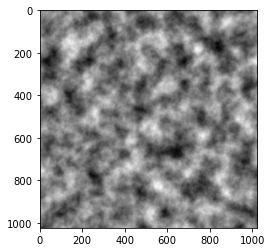

In [69]:
import noise
import numpy as np
import matplotlib.pyplot as plt

shape = (1024, 1024)
scale = 100.0
octaves = 6
persistence = 0.5
lacunarity = 2.0


creation = np.zeros(shape)
for i in range(shape[0]):
    for j in range(shape[1]):
        creation[i][j] = noise.pnoise2(i / scale,
                                    j / scale,
                                    octaves=octaves,
                                    persistence=persistence,
                                    lacunarity=lacunarity,
                                    repeatx=1024,
                                    repeaty=1024,
                                    base=0)

plt.imshow(creation, cmap="gray")
plt.show()

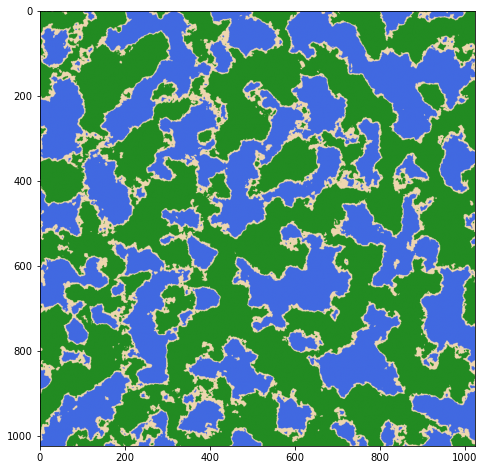

In [70]:
def normalize_rgb(lis):
    return np.array(lis)/255

def color_1(world):
    
    blue = normalize_rgb([65,105,225])
    green = normalize_rgb([34,139,34])
    beach = normalize_rgb([238, 214, 175])
    
    color_world = np.zeros(world.shape+(3,))
    for i in range(shape[0]):
        for j in range(shape[1]):
            if world[i][j] < -0.05:
                color_world[i][j] = blue
            elif world[i][j] < 0:
                color_world[i][j] = beach
            elif world[i][j] < 1:
                color_world[i][j] = green
    return color_world
            
plt.figure(figsize=(8, 8))
plt.imshow(color_1(creation))
plt.show()

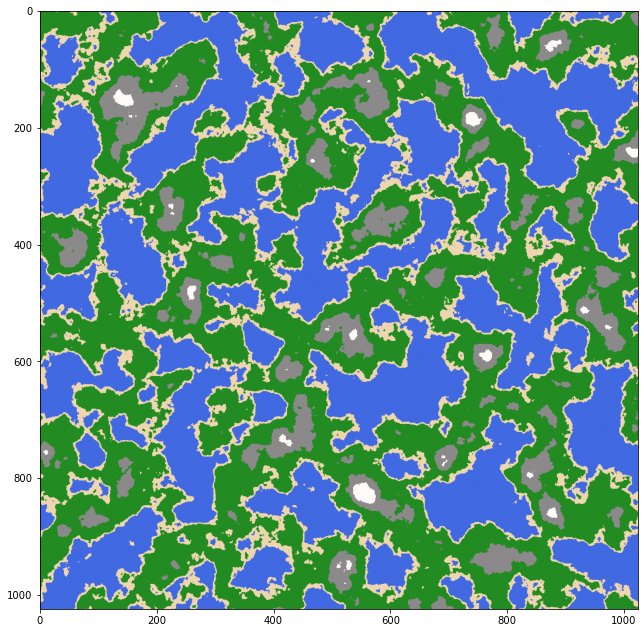

In [71]:
def add_color(world):
    
    blue = normalize_rgb([65,105,225])
    green = normalize_rgb([34,139,34])
    beach = normalize_rgb([238, 214, 175])
    snow = normalize_rgb([255, 250, 250])
    mountain = normalize_rgb([139, 137, 137])
    
    color_world = np.zeros(world.shape+(3,))
    
    for i in range(shape[0]):
        for j in range(shape[1]):
            if world[i][j] < -0.05:
                color_world[i][j] = blue
            elif world[i][j] < 0:
                color_world[i][j] = beach
            elif world[i][j] < 0.2:
                color_world[i][j] = green
            elif world[i][j] < 0.35:
                color_world[i][j] = mountain
            elif world[i][j] < 1.0:
                color_world[i][j] = snow

    return color_world



plt.figure(figsize=(11, 11))
plt.imshow(add_color(creation))
plt.show()

2. Circular gradient

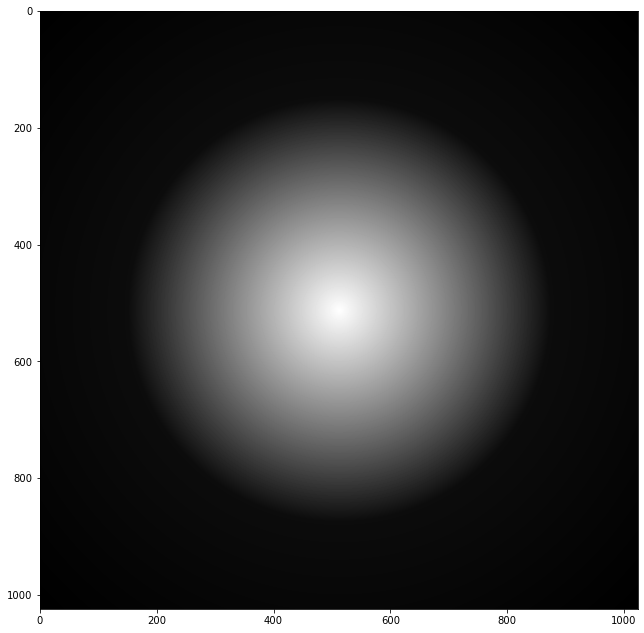

In [72]:
import math

center_x, center_y = shape[1] // 2, shape[0] // 2
circle_grad = np.zeros_like(creation)

for y in range(creation.shape[0]):
    for x in range(creation.shape[1]):
        distx = abs(x - center_x)
        disty = abs(y - center_y)
        dist = math.sqrt(distx*distx + disty*disty)
        circle_grad[y][x] = dist

# get it between -1 and 1
max_grad = np.max(circle_grad)
circle_grad = circle_grad / max_grad
circle_grad -= 0.5
circle_grad *= 2.0
circle_grad = -circle_grad

# shrink gradient
for y in range(creation.shape[0]):
    for x in range(creation.shape[1]):
        if circle_grad[y][x] > 0:
            circle_grad[y][x] *= 20

# get it between 0 and 1
max_grad = np.max(circle_grad)
circle_grad = circle_grad / max_grad


plt.figure(figsize=(11, 11))
plt.imshow(circle_grad, cmap = "gray")
plt.show()

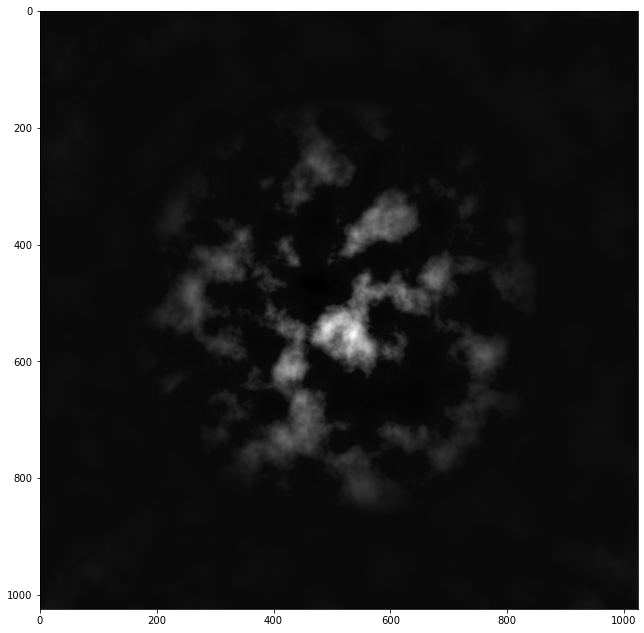

In [73]:
world_noise = np.zeros_like(creation)

for i in range(shape[0]):
    for j in range(shape[1]):
        world_noise[i][j] = (creation[i][j] * circle_grad[i][j])
        if world_noise[i][j] > 0:
            world_noise[i][j] *= 20

# get it between 0 and 1
max_grad = np.max(world_noise)
world_noise = world_noise / max_grad

plt.figure(figsize=(11, 11))
plt.imshow(world_noise, cmap = "gray")
plt.show()

<a name="conclusions"></a>
## Conclusions:
The algorithm is extremely powerful and its applications - A LOT, no wonder it is so popular.
Still, the applications have limits, but there are other types of noise we could use if the application needn't be so "natural-y" looking.

On first glance, it doesn't seem so complex, yet the implementation algorithm is not so simple and needs quite a bit of imagination.

Fortunately, library packages for Python already exist and implementation this way is much easier, faster and better optimized.

You have to try to write the code to understand it completely (if you need to).

Everything else I think is self explanatory - you have seen the images in the introduction, or google some more if you want - there are plenty examples and ideas.

<a name="resources"></a>
## Resources:


1. Theory:
    1. [Wikipedia](https://en.wikipedia.org/wiki/Perlin_noise)
    2. [Ken Perlin oscar notes](https://cs.nyu.edu/~perlin/doc/oscar.html)
        1. [Improving Noise by Ken Perlin](https://mrl.cs.nyu.edu/~perlin/paper445.pdf), 
        2. [Ken Perlin's Tutorial](https://web.archive.org/web/20160310194211/http://www.noisemachine.com/talk1/index.html)
    3. [Matt Zucker on how Perlin Noise algorithm works](https://web.archive.org/web/20170201233641/https://mzucker.github.io/html/perlin-noise-math-faq.html)
    4. [CMSC 425](https://www.cs.umd.edu/class/fall2018/cmsc425/Lects/lect14-perlin.pdf)
    5. [Fotaho's Perlin noise tutorial](https://www.youtube.com/watch?v=MJ3bvCkHJtE) - this one proved to be quite essential to start understanding it
    6. [Hugo Elias on Perlin noise, octaves and frequency](https://www.arendpeter.com/Perlin_Noise.html)
    7. Scratchapixel - Noise, Procedural generation patterns, Perlin Noise - all of it explained in depth:
        1. [Value Noise and Procedural Patterns: Part 1](https://www.scratchapixel.com/lessons/procedural-generation-virtual-worlds/procedural-patterns-noise-part-1/creating-simple-1D-noise)
        2. [Perlin Noise: Part 2](https://www.scratchapixel.com/lessons/procedural-generation-virtual-worlds/perlin-noise-part-2)
        3. [Interpolation](https://www.scratchapixel.com/lessons/mathematics-physics-for-computer-graphics/interpolation/introduction)


2. Implementation:
    1. [Raouf's Blog](https://rtouti.github.io/graphics/perlin-noise-algorithm) - Best explanation I've found
    2. [Codelirium](https://codelirium.com/article/perlin-noise)
    3. [Yvan Scher on Medium](https://medium.com/@yvanscher/playing-with-perlin-noise-generating-realistic-archipelagos-b59f004d8401)
    4. [xgarrido's Shitty Stuff website](https://xgarrido.github.io/blog/jupyter/planet/perlin%20noise/2021/01/15/noisy-planet.html)
    5. [tgirod on StackOverflow](https://stackoverflow.com/a/42154921)


3. Applications:
    1. [GPU Gems by NVidia](https://developer.nvidia.com/gpugems/gpugems/part-i-natural-effects/chapter-5-implementing-improved-perlin-noise)
    2. [GPU Gems2 by NVidia](https://developer.nvidia.com/gpugems/gpugems2/part-iii-high-quality-rendering/chapter-26-implementing-improved-perlin-noise)
    3. [necessary-disorder tutorials](https://necessarydisorder.wordpress.com/2017/11/15/drawing-from-noise-and-then-making-animated-loopy-gifs-from-there/)